In [1]:
import torch
import os

from torch import nn
from torch.utils.data import DataLoader, TensorDataset, Dataset
from torch.nn.utils.rnn import pad_sequence
from torch.nn import Module
from torch.utils.data import Subset
import torchaudio

import numpy as np

from tqdm import tqdm

import random

from typing import List, Dict

import pandas as pd


from speechbrain.lobes.models.Xvector import Xvector, Classifier
from speechbrain.lobes.models import ECAPA_TDNN
from speechbrain.inference.speaker import EncoderClassifier
from speechbrain.inference.classifiers import EncoderClassifier
from speechbrain.nnet.pooling import AttentionPooling, StatisticsPooling
from speechbrain.utils.seed import seed_everything

from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.model_selection import train_test_split

from transformers import get_linear_schedule_with_warmup

import librosa

from scipy.io import wavfile

import matplotlib.pyplot as plt


/home/stinasb/.local/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


INFO:speechbrain.utils.quirks:Applied quirks (see `speechbrain.utils.quirks`): [disable_jit_profiling, allow_tf32]


INFO:speechbrain.utils.quirks:Excluded quirks specified by the `SB_DISABLE_QUIRKS` environment (comma-separated list): []


INFO:matplotlib.font_manager:generated new fontManager


In [2]:
#os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "caching_allocator"

In [3]:
class CustomAttentionPooling(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        
        self.input_dim = input_dim
        
        self.attn_pooling_w = torch.nn.Linear(input_dim, 1)
        
    def forward(self, x, mask=None):
        attn_weights = self.attn_pooling_w(x).squeeze(-1).float()
        
        if mask is not None:
            attn_weights[~mask] = float('-inf')
        attn_weights = torch.nn.functional.softmax(attn_weights, dim=-1).unsqueeze(-1)
        out = torch.sum(x*attn_weights, dim=1)
        return out
            

class CustomStatisticsPooling(nn.Module):
    def __init__(self, return_mean=True, return_std=True):
        super().__init__()
        self.eps = 1e-5
        self.return_mean = return_mean
        self.return_std = return_std
        
        if not (self.return_mean or self.return_std):
            raise ValueError("Enable either mean and/or std for statistical pooling.")
    
    def forward(self, x, mask=None):
        if mask is not None:
            
            
            #mask = mask.unsqueeze(-1)  # Expand to match x's shape (batch_size, time_steps, features)
            mask = mask.unsqueeze(-1).expand(-1, -1, x.size(-1))  
            masked_x = x * mask.float()
            valid_counts = mask.sum(dim=1).clamp(min=1) 
            
            if self.return_mean:
                mean = masked_x.sum(dim=1)/valid_counts

            if self.return_std:
                mean_expanded = mean.unsqueeze(1).expand(-1, x.size(1), -1)
                
                variance = ((masked_x-mean_expanded)**2*mask).sum(dim=1)/valid_counts
                std = torch.sqrt(variance+self.eps)
        else:
            if self.return_mean:
                mean = x.mean(dim=1)
                
            if self.return_std:
                std = x.std(dim=1)
                
        if self.return_mean and self.return_std:
            pooled_stats = torch.cat((mean, std), dim=1)
        elif self.return_mean:
            pooled_stats = mean
        elif self.return_std:
            pooled_stats = std
            
        return pooled_stats
    
    
    
class CustomXvector(Xvector):
    def __init__(self, input_size, lin_neurons=512, activation=nn.LeakyReLU, device = 'cpu',tdnn_channels = [512, 512, 512, 512, 1500], use_stat_pool=False):
        super().__init__(in_channels=input_size, lin_neurons=lin_neurons, activation=activation,tdnn_channels=tdnn_channels)
        self.device = torch.device(device)
        self.to(self.device)

        self.out_channels = tdnn_channels[-1]
        self.input_size = input_size
        
        if use_stat_pool:
            self.return_mean = True
            self.return_std = True
            self.blocks = nn.ModuleList([
                *self.blocks[:-2],
                CustomStatisticsPooling(),
                nn.Linear(
                    in_features= self.out_channels * (2 if self.return_mean and self.return_std else 1),  
                    out_features=lin_neurons,
                    bias=True,
                )
            ])
        else:
            self.blocks = nn.ModuleList([
                *self.blocks[:-2],
                CustomAttentionPooling(self.out_channels),
                nn.Linear(
                    in_features=self.out_channels,  # Adapt to the output size
                    out_features=lin_neurons,
                    bias=True,
                )
            ])
        
        
        self.blocks.to(self.device)
        
        self.attention_layer = self.blocks[-2]
        
    def create_mask(self, lens, max_len=None):
        if max_len is None:
            max_len=lens.max()
            
        return torch.arange(max_len, device=lens.device)[None, :] < lens[:, None]
    
    def forward(self, x, lens=None):
        if isinstance(x, list):
            #for element in x:
            x = [element.to(self.device) for element in x]
        else:
            x = x.to(self.device)
            
        mask = None
        if lens is not None:
            mask = self.create_mask(lens, x.size(1))
        
        for block in self.blocks[:-2]:
            x = block(x)
            
        x = self.attention_layer(x, mask=mask)
        x = self.blocks[-1](x)
        return x #super().forward(x, lens)
      



In [4]:
class CustomDataset(Dataset):
    def __init__(self, files, is_tv, labels: List[int], is_test= False, norm_feat = True, segment = 0, transform=None, target_transform=None):
        super().__init__()
        self.files = files
        
        self.labels = labels
        self.is_test = is_test
        self.is_tv = is_tv
        self.norm_feat = norm_feat
        self.segment = segment
        
     
    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
                    
        #data = pd.read_pickle(os.path.join(self.dir, self.files[idx])).to_numpy()  
        sr = 16000
        hop_length = int(0.01 *sr)
        num_frames_segment = int(self.segment * sr /hop_length)
        
        if self.is_tv: data = pd.read_pickle(self.files[idx]).to_numpy() 
        else:
            #wav_file = pd.read_csv(self.files[idx])
            samplerate, file = wavfile.read(self.files[idx])
            
            feat = librosa.feature.melspectrogram(
                y=file.astype(float), 
                sr=samplerate, 
                n_fft=2 * int(0.01*samplerate),
                hop_length= int(0.01*samplerate),
                #win_length= int(0.01*samplerate),
                window="hamming",
                center=True, 
                n_mels=23,
                )
            #feat = librosa.feature.mfcc(y=file.astype(float), sr=samplerate)
            log_mel = librosa.power_to_db(feat)
            data = log_mel.transpose(1,0)
            #data = feat.transpose(1,0)
            
        
        num_frames = data.shape[0]
        
        duration = (num_frames * hop_length) /sr
        
        if self.segment == 10 and duration > self.segment:
            start = random.randint(0, num_frames - num_frames_segment)
            data = data[start: start + num_frames_segment]    
            
        if self.norm_feat:
            data = normalize(data, axis=0)
            
        
        return {'features' : data, 'label' : self.labels[idx]}#, 'seq_length': seq_length} 
    
class WavTVDataset(Dataset):
    def __init__(self, wav_dataset, tv_dataset):
        super().__init__()
        assert len(wav_dataset) == len(tv_dataset)
        self.wav_dataset = wav_dataset
        self.tv_dataset = tv_dataset
        
       
        
    def __len__(self):
        return len(self.wav_dataset)
    
    def __getitem__(self, idx):
        
        wav_item = self.wav_dataset[idx]
        tv_item = self.tv_dataset[idx]
        
        return {
            'wav_features': wav_item['features'],
            'tv_features': tv_item['features'],
            #'wav_length': wav_item['seq_length'],
            #'tv_length': tv_item['seq_length'],
            'label': wav_item['label']
        }



In [5]:
def val_split_speaker_ids(speaker_ids,val_ratio : float=0.1):
    
    unique_speaker_ids = list(set(speaker_ids))
    
    unique_speaker_ids.sort()
    random.shuffle(unique_speaker_ids)
    
    train_speaker_ids, val_speaker_ids = train_test_split(
        unique_speaker_ids, test_size=val_ratio, random_state=42
        )
    
    return train_speaker_ids, val_speaker_ids

def split_dataset(samples, labels, train_speaker_ids, speaker_ids):
        
    t_paths, t_labels, v_paths, v_labels = [], [], [], []
    
    for path, label, speaker_id in zip(samples, labels, speaker_ids):
        if speaker_id in train_speaker_ids:
            t_paths.append(path)
            t_labels.append(label)
        else:
            v_paths.append(path)
            v_labels.append(label)
   
    
    return t_paths, t_labels, v_paths, v_labels

In [6]:
def fix_original_csv(ds_type, fold):
    #target_dir = f"/home/stinasb/SSL4PR/TV_train_test/Fold{fold}/{ds_type}/"

    original_dir = f"/home/stinasb/SSL4PR/pcgita_splits/TRAIN_TEST_{fold}/{ds_type}.csv"

    file = pd.read_csv(original_dir, index_col =False)
    #print(file.columns())
    #file= file.drop(columns=[col for col in file.columns if "Unnamed" in col])
    file = file.drop(columns=['Unnamed: 0'], errors='ignore')
    
    file.to_csv(original_dir, index=False)

In [7]:
def get_filename(file_path):
    return os.path.splitext(os.path.basename(file_path))[0]


def organize_data_in_folders(ds_type, fold):
    target_dir = f"/home/stinasb/SSL4PR/TV_train_test/Fold{fold}/{ds_type}/"

    original_dir = f"/home/stinasb/SSL4PR/pcgita_splits/TRAIN_TEST_{fold}/{ds_type}.csv"

    original_data = pd.read_csv(original_dir)
    
    
    audio_path = list(original_data['audio_path'])

    origin_id = list(original_data['original_id'])
    speaker_ids = list(original_data['speaker_id'])
    
    dirname = '/home/stinasb/SSL4PR/TVs_copy_test/'

    labels = []
    filelist = []
    origin_ids = []
    speaker_id = []
    
    for root, dirs, files in os.walk(dirname):
        if os.path.basename(root) in {'hc', 'pd', 'HC', 'PD'}:
            group = os.path.basename(root)
            for file in files:
                filename, extension = os.path.splitext(file)
                if filename in origin_id:
                    
                    filelist.append(os.path.join(root, file))
                    
                    
    
    wav_files_sorted = sorted(audio_path, key=get_filename)
    pkl_files_sorted = sorted(filelist, key=get_filename)
    
    for element in pkl_files_sorted:
        
        filename = os.path.basename(element)
        spk_id, extension = os.path.splitext(filename)
        speaker_id.append(spk_id.split("_")[0])
        
        group = os.path.basename(os.path.dirname(element))
        if group == 'hc' or group == 'HC':
            labels.append(0)
        elif group == 'pd' or group == 'PD':
            labels.append(1)
                        
    

    file_dict = {'sample_tv': pkl_files_sorted, 'sample_wav': wav_files_sorted , 'labels': labels, 'speaker_id': speaker_id}
    
    
    df = pd.DataFrame(file_dict)
    
    original_data_copy = original_data.drop_duplicates(subset='speaker_id')
    columns_to_copy = ['status', 'UPDRS', 'UPDRS-speech','H/Y', 'SEX', 'AGE', 'time after diagnosis']
    
    df = df.merge(original_data_copy[['speaker_id']+columns_to_copy], on='speaker_id', how='left')
    

    df.to_csv(target_dir + f"{ds_type}.csv", index=False)


In [8]:
class CombinedModel(nn.Module):
    def __init__(self, input_size, lin_neurons, xvec, lin_blocks = 1, classifier_out_neurons = 2, device="cpu"):
        super(CombinedModel, self).__init__()
        
        # Initialize the CustomXvector model
        self.device = device
        self.xvector = xvec.to(device)
        # Initialize the Classifier model
       
        self.classifier = None
        self.classifier_out_neurons = classifier_out_neurons
        self.device = device
        self.lin_blocks = lin_blocks
        
    def forward(self, x, lens=None):
        # Forward pass through the x-vector model
        xvector_output = self.xvector(x, lens)
        
        if self.classifier is None:
            self.classifier = Classifier(
                input_shape=xvector_output.shape,
                out_neurons=self.classifier_out_neurons,
                lin_blocks=self.lin_blocks,
            ).to(self.device)
            
        # Forward pass through the classifier
        classifier_output = self.classifier(xvector_output)
        
        return classifier_output

class WavTVCombinedModel(nn.Module):
    def __init__(self, wav_xvector, tv_xvector, mlp_hidden=256, num_classes=2, device='cpu', lin_blocks=2):
        super(WavTVCombinedModel, self).__init__()
        
        self.wav_xvector = wav_xvector.to(device)
        self.tv_xvector = tv_xvector.to(device)
        #self.mlp_hidden = mlp_hidden
        
        #self.input_dim = self.wav_xvector.blocks[-1].out_features + self.tv_xvector.blocks[-1].out_features 
        
        self.classifier = None
        self.classifier_out_neurons = num_classes
        self.device = device
        self.lin_neurons = mlp_hidden
        self.lin_blocks = lin_blocks
        
        
        
    def forward(self, wav_input, tv_input, wav_lens=None, tv_lens=None):
        
        xvec_wav = self.wav_xvector(wav_input.float(), wav_lens)
        xvec_tv = self.tv_xvector(tv_input.float(), tv_lens)
        
    
        xvec_combined = torch.cat((xvec_wav, xvec_tv), dim=1)
        print(xvec_combined.shape, xvec_tv.shape, xvec_wav.shape)
        
        if self.classifier is None:
            self.classifier = Classifier(
                input_shape=xvec_combined.shape,
                out_neurons=self.classifier_out_neurons,
                lin_blocks=self.lin_blocks,
                lin_neurons=self.lin_neurons,
            ).to(self.device)
        
        logits = self.classifier(xvec_combined)
        
        return logits


        

In [9]:
class ECAPACombinedModelSetup1(nn.Module):
    def __init__(self, input_size, ecapa_tv, ecapa_wav, multi_model=True, device='cpu', lin_neurons=192, out_neurons=2, lin_blocks=1, input_type='tv'):
        super(ECAPACombinedModelSetup1, self).__init__()
        
        self.input_size = input_size
        self.lin_neurons = lin_neurons
        self.lin_blocks = lin_blocks
        self.out_neurons = out_neurons
        self.device = device
        self.input_type = input_type
        self.batch_size = 4
        
        self.ecapa_tv = ecapa_tv.to(device)
        self.ecapa_wav = ecapa_wav.to(device)
        self.multi_model = multi_model
        #self.attn_pool = CustomAttentionPooling(input_size*2).to(device)
      
        # Enable gradient updates
        self.ecapa_tv.requires_grad_(True)
        self.ecapa_wav.requires_grad_(True)
        
        
        self.classifier_wav = Classifier(
            input_shape=[self.batch_size, input_size],
            out_neurons=out_neurons,
            lin_blocks = lin_blocks,
            lin_neurons=lin_neurons,
        ).to(device)
        #self.classifier_wav.pop('softmax')
        
        self.classifier_tv = Classifier(
            input_shape=[self.batch_size, input_size],
            out_neurons=out_neurons,
            lin_blocks = lin_blocks,
            lin_neurons=lin_neurons,
        ).to(device)
        #self.classifier_tv.pop('softmax')
        
        self.weights = torch.nn.Parameter(torch.tensor([0.5, 0.5]), requires_grad=True).to(device)
    
        
    def forward(self, x_wav, x_tv, lengths_wav=None, lengths_tv=None):
        
        if self.multi_model:
            tv_output = self.ecapa_tv(x_tv.float(), lengths_tv)
            wav_output = self.ecapa_wav(x_wav.float(), lengths_wav)
            
            tv_fcn = torch.exp(self.classifier_tv(tv_output))
            wav_fcn = torch.exp(self.classifier_wav(wav_output))
            
            #print(tv_fcn, wav_fcn)
            #combined = torch.cat((tv_fcn, wav_fcn), dim=1)    
           
            w = torch.nn.functional.softmax(self.weights, dim=0)  # Ensure weights sum to 1

            # Compute weighted probability
            final_probs = w[0] * tv_fcn + w[1] * wav_fcn

            
            logits = final_probs
            
        else:
            tv_output = self.ecapa_tv(x_tv.float(), lengths_tv)
            #output = self.pretrain_classifier.encode_batch(x_wav.float(), lengths_wav, normalize=False)
            #wav_output = self.ecapa_wav(x_wav.float(), lengths_wav)
            if self.classifier is None:
                self.classifier = ECAPA_TDNN.Classifier(
                    input_size= tv_output.shape[-1],
                    #device=self.device,
                    lin_blocks = self.lin_blocks,
                    lin_neurons = self.lin_neurons,
                    out_neurons = self.out_neurons,
                ).to(self.device)
                
            
            logits = self.classifier(tv_output)
            
        return logits
    
class ECAPACombinedModelSetup2(nn.Module):
    def __init__(self, input_size, ecapa_tv, ecapa_wav, multi_model=True, device='cpu', lin_neurons=192, out_neurons=2, lin_blocks=1, input_type='tv'):
        super(ECAPACombinedModelSetup2, self).__init__()
        
        self.input_size = input_size
        self.lin_neurons = lin_neurons
        self.lin_blocks = lin_blocks
        self.out_neurons = out_neurons
        self.device = device
        self.input_type = input_type
        self.batch_size = 4
        
        self.ecapa_tv = ecapa_tv.to(device)
        self.ecapa_wav = ecapa_wav.to(device)
        self.multi_model = multi_model
        #self.classifier = None
        self.attn_pool = CustomAttentionPooling(input_size*2).to(device)
        #self.pooling = ECAPA_TDNN.AttentiveStatisticsPooling(channels=)
        
        '''
        self.classifier = ECAPA_TDNN.Classifier(
                input_size= input_size,
                lin_blocks = self.lin_blocks,
                lin_neurons = self.lin_neurons,
                out_neurons = self.out_neurons,
            ).to(self.device)
            '''
        if multi_model:
            self.classifier = Classifier(
                input_shape=[self.batch_size,input_size*2],
                out_neurons=out_neurons,
                lin_blocks = lin_blocks,
                lin_neurons=lin_neurons,
            ).to(device)
        else:
            self.classifier = Classifier(
                input_shape=[self.batch_size,input_size],
                out_neurons=out_neurons,
                lin_blocks = lin_blocks,
                lin_neurons=lin_neurons,
            ).to(device)
            
        self.classifier.pop('softmax')
        
        # Enable gradient updates
        self.ecapa_tv.requires_grad_(True)
        self.ecapa_wav.requires_grad_(True)
        
        
        
    def forward(self, x_wav, x_tv, lengths_wav=None, lengths_tv=None):
        
        if self.multi_model:
            tv_output = self.ecapa_tv(x_tv.float(), lengths_tv)
            wav_output = self.ecapa_wav(x_wav.float(), lengths_wav)
            
            
            ecapa_concat = torch.cat((wav_output, tv_output), dim=-1)
            
            #ecapa_combined = self.attn_pool(ecapa_concat).to(self.device)
            
            #print(ecapa_combined.shape, tv_output.shape, wav_output.shape)
            
            #logits = self.classifier(ecapa_combined)
            logits = self.classifier(ecapa_concat)
            #print(logits.shape)
        else:
            if self.input_type == 'tv':
                tv_output = self.ecapa_tv(x_tv.float(), lengths_tv)
                
                logits = self.classifier(tv_output)
            
            elif self.input_type == 'wav':
                
                wav_output = self.ecapa_wav(x_wav.float(), lengths_wav)
                
                logits = self.classifier(wav_output)
            
            else:
                #print('not valid input type')
                raise NameError("Not valid input type")
            
        return logits
    

class ECAPACombinedModelSetup3(nn.Module):
    def __init__(self, input_size, ecapa, multi_model=True, device='cpu', lin_neurons=192, out_neurons=2, lin_blocks=1):
        super(ECAPACombinedModelSetup3, self).__init__()
        
        self.input_size = input_size
        self.lin_neurons = lin_neurons
        self.lin_blocks = lin_blocks
        self.out_neurons = out_neurons
        self.device = device
        self.batch_size = 4
        
        self.ecapa= ecapa.to(device)
        
        self.multi_model = multi_model
       
        
        self.classifier = Classifier(
            input_shape=[self.batch_size, input_size],
            out_neurons=out_neurons,
            lin_blocks = lin_blocks,
            lin_neurons=lin_neurons,
        ).to(device)
        self.classifier.pop('softmax')
        
    def forward(self, x_wav, x_tv, lengths_wav=None, lengths_tv=None):
        
        if self.multi_model:
            print(x_tv.shape, x_wav.shape)
            combined_input = torch.cat((x_wav.float(), x_tv.float()), dim=0)
            
            
            lengths_combined = torch.cat((lengths_wav, lengths_tv))
          
            
            output = self.ecapa(combined_input, lengths_combined) 
            
            
            logits = self.classifier(output)
            
        else:
            tv_output = self.ecapa_tv(x_tv.float(), lengths_tv)
            #output = self.pretrain_classifier.encode_batch(x_wav.float(), lengths_wav, normalize=False)
            #wav_output = self.ecapa_wav(x_wav.float(), lengths_wav)
            if self.classifier is None:
                self.classifier = ECAPA_TDNN.Classifier(
                    input_size= tv_output.shape[-1],
                    #device=self.device,
                    lin_blocks = self.lin_blocks,
                    lin_neurons = self.lin_neurons,
                    out_neurons = self.out_neurons,
                ).to(self.device)
                
            
            logits = self.classifier(tv_output)
            
        return logits

In [10]:
def custom_collate_fn(batch):
    # Convert each element in the batch to a tensor
    sequences_tv = [torch.tensor(item['tv_features']) for item in batch]
    lengths_tv = torch.tensor([len(seq) for seq in sequences_tv])  # Sequence lengths
    
    # Pad sequences to the same length
    padded_sequences_tv = pad_sequence(sequences_tv, batch_first=True)
    
    sequences_wav = [torch.tensor(item['wav_features']) for item in batch]
    lengths_wav = torch.tensor([len(seq) for seq in sequences_wav])  # Sequence lengths
    
    # Pad sequences to the same length
    padded_sequences_wav= pad_sequence(sequences_wav, batch_first=True)
    
    labels = torch.tensor([item['label'] for item in batch])
    
    return {'sequences_wav': padded_sequences_wav, 'sequences_tv': padded_sequences_tv,'lengths_wav': lengths_wav, 'lengths_tv':lengths_tv, 'labels': labels}


In [11]:
def data_handling(fold, val_ratio=0.1, batch_size=16, norm_feat=True):
    
    #--Organize data in folders (similar to pcgita-split)--
    organize_data_in_folders('train', fold)
    organize_data_in_folders('test', fold)

    #--Obtain data from csv-files--
    csv_path_train = f"/home/stinasb/SSL4PR/TV_train_test/Fold{fold}/train/train.csv"
    df_train = pd.read_csv(csv_path_train)

    csv_path_test = f"/home/stinasb/SSL4PR/TV_train_test/Fold{fold}/test/test.csv"
    df_test = pd.read_csv(csv_path_test)
    
    #--Organize data in samples, speaker_id and labels--
    pickle_train = df_train['sample_tv']
    pickle_test = df_test['sample_tv']
    speaker_ids = df_train['speaker_id']

    labels_train = df_train['labels']
    labels_test = df_test['labels']
        
    wav_train = df_train['sample_wav']
    wav_test = df_test['sample_wav']
             
             
    print(pickle_train[45], wav_train[45])
    
    #--Split training set into a train and validation set--
    train_speaker_ids, val_speaker_ids = val_split_speaker_ids(speaker_ids, val_ratio)
    
    train_data, train_labels, val_data, val_labels = split_dataset(pickle_train, labels_train, train_speaker_ids, speaker_ids)
    train_data_wav, train_labels_wav, val_data_wav, val_labels_wav = split_dataset(wav_train, labels_train, train_speaker_ids, speaker_ids)
    
    
    #--Organize in CustomDataset objects--
    train_ds = CustomDataset(train_data, is_tv=True, labels= train_labels, is_test=False, norm_feat=norm_feat, segment=10)
    val_ds = CustomDataset(val_data, is_tv=True, labels= val_labels, is_test=False, norm_feat=norm_feat, segment=10)
    test_ds = CustomDataset(pickle_test, is_tv=True, labels=labels_test, is_test=True, norm_feat=norm_feat, segment=10)
    
    train_ds_wav = CustomDataset(train_data_wav, is_tv=False, labels= train_labels_wav, is_test=False, norm_feat=norm_feat, segment=10)
    val_ds_wav = CustomDataset(val_data_wav, is_tv=False, labels= val_labels_wav, is_test=False, norm_feat=norm_feat, segment=10)
    test_ds_wav = CustomDataset(wav_test, is_tv=False, labels=labels_test, is_test=True, norm_feat=norm_feat, segment=10)
    
   
    
    
    ds_train = WavTVDataset(train_ds_wav, train_ds)
    ds_val = WavTVDataset(val_ds_wav, val_ds)
    ds_test = WavTVDataset(test_ds_wav, test_ds)
    
    #--Load Datasets into Dataloaders--  
    train_dl = DataLoader(ds_train, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True , drop_last=True)
    #train_dl = DataLoader(ds_train, batch_size=batch_size, shuffle=True , drop_last=True)
    val_dl = DataLoader(ds_val, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=False)
    test_dl = DataLoader(ds_test, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=False)
    
  
  
    
    return train_dl, val_dl, test_dl
    

In [12]:
def train_one_epoch(model, train_dataloader, optimizer, scheduler, device, loss_fn, multiple_models=True, gradient_accumulation_steps=1, global_step=0, is_binary_classification=False):
    # Define a loss function and optimizer
    
    model.train()
    training_loss = 0.0
    
    p_bar = tqdm(train_dataloader, total=len(train_dataloader), ncols=100)
    
    for batch in p_bar:  # Assuming your dataloader provides (inputs, labels)
        
        
        
        inputs_tv = batch['sequences_tv']
        inputs_wav = batch['sequences_wav']
        labels = batch['labels']
        inputs_tv, inputs_wav, labels = inputs_tv.to(device), inputs_wav.to(device), labels.to(device)
        lens_tv = batch['lengths_tv'].to(device)
        lens_wav = batch['lengths_wav'].to(device)
        
        
        lens_tv = lens_tv/ inputs_tv.shape[1]
        lens_wav = lens_wav / inputs_wav.shape[1]
    # Forward pass
        outputs = model(inputs_wav, inputs_tv, lens_wav, lens_tv)
        
        
        if torch.isnan(outputs).any():
            print("Skipping batch because of nan")
            # clear memory
            del batch
            del labels
            del outputs
            torch.cuda.empty_cache()
            continue
        
        n_classes = 2
        #print(outputs.view(-1, n_classes).shape)
        if is_binary_classification: loss = loss_fn(outputs.squeeze(-1), labels) #loss_fn(outputs.squeeze(-1), labels.float())
        else: loss = loss_fn(outputs.view(-1,n_classes), labels.view(-1))

        if gradient_accumulation_steps > 1:
            loss = loss / gradient_accumulation_steps
            
        loss.backward()
        
        if (p_bar.n + 1) % gradient_accumulation_steps == 0 or p_bar.n == len(train_dataloader) - 1:
            optimizer.step()
            
            scheduler.step()
            
            optimizer.zero_grad()
       
        training_loss += loss.item()
        
        p_bar.set_postfix({"loss": loss.item(), "lr":scheduler.get_last_lr()[-1]})
        
        global_step += 1
        
        torch.cuda.empty_cache()

    return training_loss / len(train_dataloader), global_step

In [13]:
def evaluate_model(model, eval_dataloader, device, loss_fn, multiple_models=True, is_binary_classification=False):
    model.eval()  # Set the model to evaluation mode
    all_preds = []
    all_labels = []
    
    p_bar = tqdm(eval_dataloader, total=len(eval_dataloader), ncols=100)
    eval_loss = 0.0
    reference, predictions = [], []

    with torch.no_grad():  # Disable gradient computation
        for batch in p_bar:  # Assuming (inputs, labels, lengths) from the dataloader
            
            inputs_tv = batch['sequences_tv']
            inputs_wav = batch['sequences_wav']
            labels = batch['labels']
            lens_tv = batch['lengths_tv']
            lens_wav = batch['lengths_wav']
            
            inputs_tv, lens_tv, labels = inputs_tv.to(device), lens_tv.to(device), labels.to(device)
            inputs_wav, lens_wav = inputs_wav.to(device), lens_wav.to(device)
            
            lens_tv = lens_tv/ inputs_tv.shape[1]
            lens_wav = lens_wav / inputs_wav.shape[1]

            # Forward pass
            outputs = model(inputs_wav, inputs_tv, lens_wav, lens_tv)
            
            n_classes = outputs.shape[-1]
            
            if is_binary_classification: loss = loss_fn(outputs.squeeze(-1), labels)
            else: loss = loss_fn(outputs.view(-1, n_classes), labels.view(-1))
            
            eval_loss += loss.item()
            reference.extend(labels.cpu().numpy())
            if is_binary_classification: predictions.extend((outputs > 0.5).cpu().numpy().astype(int))
            else: predictions.extend(torch.argmax(outputs, dim=-1).cpu().numpy().astype(int))
            
            p_bar.set_postfix({"loss": loss.item()})
    return eval_loss / len(eval_dataloader), reference, predictions
            



In [14]:
def compute_metrics(reference, predictions, verbose=False, is_binary_classification=False):
    accuracy = accuracy_score(reference, predictions)
    
    report = classification_report(reference, predictions, output_dict=True)
    
    return accuracy, report

In [15]:
#torch.cuda.set_device("cuda:3")
torch.cuda.empty_cache()

In [16]:
folds = 10
val_ratio = 0.1
batch_size = 4
channels = [512, 512, 512, 512, 1536] #[1024, 1024, 1024, 1024, 1536]
lin_neurons_ecapa = 192
tv_input = 9
wav_input = 23
lin_neurons_classifier = 1024
input_size = 9
seed = 42

seed_everything(seed)

modelsetup = 2 # 1, 2, 3

norm_feat = True
use_stat_pool = False
multiple_models = False
is_binary_classification = False

acc_per_test_fold = {}
val_acc_dict = {}
val_results = {
    "accuracy": {},
    "sensitivity": {},
    "specificity": {},
    "report": {},
}
test_results = {
    "accuracy": {},
    "sensitivity": {},
    "specificity": {},
    "report": {}
}
test_pred = {}

checkpoint_path = f"/home/stinasb/SSL4PR/checkpoints/tv_testing"
#result_path = f"/home/stinasb/SSL4PR/TVs_copy"
result_path = f"/home/stinasb/SSL4PR/pre_experiments/oppsett_{modelsetup}"
input_type = 'tv'

for test_fold in range(1, folds+1):
    
    
    device = "cuda:2" if torch.cuda.is_available() else "cpu"
   
    train_dl, val_dl, test_dl = data_handling(test_fold, val_ratio=val_ratio, batch_size=batch_size, norm_feat=norm_feat)

    
    if modelsetup == 1:
        ecapa_tv = ECAPA_TDNN.ECAPA_TDNN(input_size=tv_input, device=device,  lin_neurons=lin_neurons_ecapa, activation=nn.LeakyReLU, channels=channels)
    
        ecapa_wav = ECAPA_TDNN.ECAPA_TDNN(input_size=wav_input,device=device, lin_neurons=lin_neurons_ecapa, activation=nn.LeakyReLU, channels=channels)
    
        model = ECAPACombinedModelSetup1(input_size=lin_neurons_ecapa, ecapa_tv=ecapa_tv, ecapa_wav=ecapa_wav, multi_model=multiple_models,device=device, lin_neurons=lin_neurons_classifier, input_type=input_type)
    
    elif modelsetup == 2:
        ecapa_tv = ECAPA_TDNN.ECAPA_TDNN(input_size=tv_input, device=device,  lin_neurons=lin_neurons_ecapa, activation=nn.LeakyReLU, channels=channels)
    
        ecapa_wav = ECAPA_TDNN.ECAPA_TDNN(input_size=wav_input,device=device, lin_neurons=lin_neurons_ecapa, activation=nn.LeakyReLU, channels=channels)
    
        model = ECAPACombinedModelSetup2(input_size=lin_neurons_ecapa, ecapa_tv=ecapa_tv, ecapa_wav=ecapa_wav, multi_model=multiple_models,device=device, lin_neurons=lin_neurons_classifier, input_type=input_type)
        
    elif modelsetup == 3:
        ecapa = ECAPA_TDNN.ECAPA_TDNN(input_size=input_size, device=device, lin_neurons=lin_neurons_ecapa, activation=nn.LeakyReLU, channels=channels)

        model = ECAPACombinedModelSetup3(input_size=lin_neurons_ecapa, ecapa=ecapa, multi_model=multiple_models,device=device, lin_neurons=lin_neurons_classifier)
        
    print(f"Number of parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad) / 1e6:.2f}M")
   
    optimizer = torch.optim.AdamW(model.parameters(), lr=5e-4, weight_decay=0.01)
    num_epochs = 10
    gradient_accumulation_step = 16

    total_steps = int(len(train_dl)*num_epochs) // gradient_accumulation_step
    warmup_ratio = 0.1

    scheduler = get_linear_schedule_with_warmup(
        optimizer=optimizer,
        num_warmup_steps=int(total_steps*warmup_ratio),
        num_training_steps=total_steps,
        last_epoch=-1,
    )

    

    if is_binary_classification: loss_fn = nn.BCELoss()
    else: loss_fn = nn.CrossEntropyLoss()

    global_step = 0
    best_val_accuracy = 0
    val_acc_dict[test_fold] = {}

    for epoch in range(num_epochs):
        training_loss, global_step = train_one_epoch(
            model=model,
            train_dataloader=train_dl,
            optimizer=optimizer,
            scheduler=scheduler,
            device=device,
            loss_fn=loss_fn,
            multiple_models=multiple_models,
            gradient_accumulation_steps=gradient_accumulation_step,
            global_step=global_step,
            is_binary_classification=is_binary_classification,
        )
        
        print(global_step)
        
        print(f"Average training loss: {training_loss}")
        
        val_loss, val_reference, val_predictions = evaluate_model(
            model=model,
            eval_dataloader=val_dl,
            device=device,
            loss_fn=loss_fn,
            multiple_models=multiple_models,
            is_binary_classification=is_binary_classification,
        )
        print(f"Average validation loss: {val_loss}")

        val_acc, val_report = compute_metrics(val_reference, val_predictions)
        print(f"Validation accuracy: {val_acc}")
        
        val_acc_dict[test_fold][epoch] = val_acc
        
        if val_acc > best_val_accuracy:
            print(f"Found a better model with accuracy: {val_acc:.3f} - previous best: {best_val_accuracy:.3f}")
            best_val_accuracy = val_acc
            val_results["accuracy"][test_fold] = best_val_accuracy
            val_results["sensitivity"][test_fold] = val_report['1']['recall']
            val_results["specificity"][test_fold] = val_report['0']['recall']
            val_results["report"][test_fold] = val_report
            torch.save(model.state_dict(), checkpoint_path + f"/fold_{test_fold}.pt")
        
        
    model.load_state_dict(torch.load(checkpoint_path + f"/fold_{test_fold}.pt", weights_only=True))
 
    test_loss, test_reference, test_predictions = evaluate_model(
        model, test_dl, device=device, loss_fn=loss_fn, multiple_models=multiple_models)
    
    test_acc, test_report = compute_metrics(test_reference, test_predictions)
    sensitivity = test_report['1']['recall']
    specificity = test_report['0']['recall']
    #print(f"Testing accuracy: {test_acc}")
    print(f"Testing accuracy (testfold {test_fold}): {test_acc}")
    #acc_per_test_fold[test_fold] = test_acc
    test_results["accuracy"][test_fold] = test_acc
    test_results["sensitivity"][test_fold] = sensitivity
    test_results["specificity"][test_fold] = specificity 
    test_results["report"][test_fold] = test_report
    test_pred[test_fold] = test_predictions
    
    
    
    
    torch.cuda.empty_cache()


#results_df = pd.DataFrame(acc_per_test_fold, index=[0])
val_acc_epoch_df = pd.DataFrame(val_acc_dict)
val_results_df = pd.DataFrame(val_results)
#results_df.to_csv(result_path + "/test_acc.csv", index=False)
val_acc_epoch_df.to_csv(result_path + "/val_acc_epoch.csv", index=False)
val_results_df.to_csv(result_path + "/val_results.csv", index=False)

res_df = pd.DataFrame(test_results)
res_df.to_csv(result_path + "/test_results.csv", index=False)


    
testpred_df = pd.DataFrame(test_pred)
testpred_df.to_csv(result_path + "/test_predictions.csv", index=False)

INFO:speechbrain.utils.seed:Setting seed to 42


/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0006_pakata.pkl /talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0006_pakata.wav


Number of parameters: 12.26M


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                                    | 0/364 [00:02<?, ?it/s, loss=0.0653, lr=0]

  0%|                                            | 1/364 [00:02<14:48,  2.45s/it, loss=0.0653, lr=0]

  0%|                                            | 1/364 [00:02<14:48,  2.45s/it, loss=0.0518, lr=0]

  1%|▏                                           | 2/364 [00:02<06:43,  1.11s/it, loss=0.0518, lr=0]

  1%|▏                                           | 2/364 [00:02<06:43,  1.11s/it, loss=0.0455, lr=0]

  1%|▎                                           | 3/364 [00:02<04:04,  1.48it/s, loss=0.0455, lr=0]

  1%|▎                                           | 3/364 [00:02<04:04,  1.48it/s, loss=0.0332, lr=0]

  1%|▍                                           | 4/364 [00:02<02:48,  2.13it/s, loss=0.0332, lr=0]

  1%|▍                                           | 4/364 [00:03<02:48,  2.13it/s, loss=0.0363, lr=0]

  1%|▌                                           | 5/364 [00:03<02:05,  2.85it/s, loss=0.0363, lr=0]

  1%|▌                                           | 5/364 [00:03<02:05,  2.85it/s, loss=0.0511, lr=0]

  2%|▋                                           | 6/364 [00:03<01:45,  3.38it/s, loss=0.0511, lr=0]

  2%|▋                                            | 6/364 [00:03<01:45,  3.38it/s, loss=0.056, lr=0]

  2%|▊                                            | 7/364 [00:03<01:33,  3.81it/s, loss=0.056, lr=0]

  2%|▊                                           | 7/364 [00:03<01:33,  3.81it/s, loss=0.0525, lr=0]

  2%|▉                                           | 8/364 [00:03<01:31,  3.88it/s, loss=0.0525, lr=0]

  2%|▉                                           | 8/364 [00:03<01:31,  3.88it/s, loss=0.0538, lr=0]

  2%|█                                           | 9/364 [00:03<01:21,  4.36it/s, loss=0.0538, lr=0]

  2%|█                                           | 9/364 [00:04<01:21,  4.36it/s, loss=0.0399, lr=0]

  3%|█▏                                         | 10/364 [00:04<02:11,  2.68it/s, loss=0.0399, lr=0]

  3%|█▏                                         | 10/364 [00:04<02:11,  2.68it/s, loss=0.0618, lr=0]

  3%|█▎                                         | 11/364 [00:04<01:48,  3.27it/s, loss=0.0618, lr=0]

  3%|█▎                                         | 11/364 [00:04<01:48,  3.27it/s, loss=0.0488, lr=0]

  3%|█▍                                         | 12/364 [00:04<01:31,  3.83it/s, loss=0.0488, lr=0]

  3%|█▍                                         | 12/364 [00:05<01:31,  3.83it/s, loss=0.0457, lr=0]

  4%|█▌                                         | 13/364 [00:05<01:20,  4.33it/s, loss=0.0457, lr=0]

  4%|█▌                                         | 13/364 [00:05<01:20,  4.33it/s, loss=0.0331, lr=0]

  4%|█▋                                         | 14/364 [00:05<01:11,  4.92it/s, loss=0.0331, lr=0]

  4%|█▋                                         | 14/364 [00:05<01:11,  4.92it/s, loss=0.0234, lr=0]

  4%|█▊                                         | 15/364 [00:05<01:02,  5.58it/s, loss=0.0234, lr=0]

  4%|█▌                                   | 15/364 [00:05<01:02,  5.58it/s, loss=0.0442, lr=2.27e-5]

  4%|█▋                                   | 16/364 [00:05<01:06,  5.26it/s, loss=0.0442, lr=2.27e-5]

  4%|█▋                                   | 16/364 [00:05<01:06,  5.26it/s, loss=0.0461, lr=2.27e-5]

  5%|█▋                                   | 17/364 [00:05<01:02,  5.53it/s, loss=0.0461, lr=2.27e-5]

  5%|█▋                                   | 17/364 [00:05<01:02,  5.53it/s, loss=0.0336, lr=2.27e-5]

  5%|█▊                                   | 18/364 [00:05<00:57,  6.06it/s, loss=0.0336, lr=2.27e-5]

  5%|█▊                                   | 18/364 [00:05<00:57,  6.06it/s, loss=0.0496, lr=2.27e-5]

  5%|█▉                                   | 19/364 [00:05<00:51,  6.65it/s, loss=0.0496, lr=2.27e-5]

  5%|█▉                                   | 19/364 [00:06<00:51,  6.65it/s, loss=0.0446, lr=2.27e-5]

  5%|██                                   | 20/364 [00:06<00:48,  7.12it/s, loss=0.0446, lr=2.27e-5]

  5%|██                                   | 20/364 [00:06<00:48,  7.12it/s, loss=0.0421, lr=2.27e-5]

  6%|██▏                                  | 21/364 [00:06<00:46,  7.45it/s, loss=0.0421, lr=2.27e-5]

  6%|██▏                                  | 21/364 [00:06<00:46,  7.45it/s, loss=0.0736, lr=2.27e-5]

  6%|██▏                                  | 22/364 [00:06<00:47,  7.26it/s, loss=0.0736, lr=2.27e-5]

  6%|██▏                                  | 22/364 [00:06<00:47,  7.26it/s, loss=0.0294, lr=2.27e-5]

  6%|██▎                                  | 23/364 [00:06<00:45,  7.45it/s, loss=0.0294, lr=2.27e-5]

  6%|██▎                                  | 23/364 [00:06<00:45,  7.45it/s, loss=0.0508, lr=2.27e-5]

  7%|██▍                                  | 24/364 [00:06<00:44,  7.67it/s, loss=0.0508, lr=2.27e-5]

  7%|██▍                                  | 24/364 [00:07<00:44,  7.67it/s, loss=0.0682, lr=2.27e-5]

  7%|██▌                                  | 25/364 [00:07<01:47,  3.15it/s, loss=0.0682, lr=2.27e-5]

  7%|██▌                                  | 25/364 [00:07<01:47,  3.15it/s, loss=0.0501, lr=2.27e-5]

  7%|██▋                                  | 26/364 [00:07<01:26,  3.89it/s, loss=0.0501, lr=2.27e-5]

  7%|██▋                                  | 26/364 [00:07<01:26,  3.89it/s, loss=0.0618, lr=2.27e-5]

  7%|██▋                                  | 27/364 [00:07<01:15,  4.47it/s, loss=0.0618, lr=2.27e-5]

  7%|██▋                                  | 27/364 [00:07<01:15,  4.47it/s, loss=0.0746, lr=2.27e-5]

  8%|██▊                                  | 28/364 [00:07<01:04,  5.22it/s, loss=0.0746, lr=2.27e-5]

  8%|██▊                                  | 28/364 [00:07<01:04,  5.22it/s, loss=0.0453, lr=2.27e-5]

  8%|██▉                                  | 29/364 [00:07<00:59,  5.68it/s, loss=0.0453, lr=2.27e-5]

  8%|██▉                                  | 29/364 [00:07<00:59,  5.68it/s, loss=0.0517, lr=2.27e-5]

  8%|███                                  | 30/364 [00:07<00:51,  6.51it/s, loss=0.0517, lr=2.27e-5]

  8%|███                                  | 30/364 [00:08<00:51,  6.51it/s, loss=0.0411, lr=2.27e-5]

  9%|███▏                                 | 31/364 [00:08<00:53,  6.28it/s, loss=0.0411, lr=2.27e-5]

  9%|███▏                                 | 31/364 [00:08<00:53,  6.28it/s, loss=0.0393, lr=4.55e-5]

  9%|███▎                                 | 32/364 [00:08<00:53,  6.21it/s, loss=0.0393, lr=4.55e-5]

  9%|███▎                                 | 32/364 [00:08<00:53,  6.21it/s, loss=0.0578, lr=4.55e-5]

  9%|███▎                                 | 33/364 [00:08<00:48,  6.76it/s, loss=0.0578, lr=4.55e-5]

  9%|███▍                                  | 33/364 [00:08<00:48,  6.76it/s, loss=0.079, lr=4.55e-5]

  9%|███▌                                  | 34/364 [00:08<00:46,  7.06it/s, loss=0.079, lr=4.55e-5]

  9%|███▍                                 | 34/364 [00:08<00:46,  7.06it/s, loss=0.0338, lr=4.55e-5]

  9%|███▍                                 | 34/364 [00:08<00:46,  7.06it/s, loss=0.0655, lr=4.55e-5]

 10%|███▋                                 | 36/364 [00:08<00:40,  8.09it/s, loss=0.0655, lr=4.55e-5]

 10%|███▋                                 | 36/364 [00:08<00:40,  8.09it/s, loss=0.0588, lr=4.55e-5]

 10%|███▊                                 | 37/364 [00:08<00:39,  8.21it/s, loss=0.0588, lr=4.55e-5]

 10%|███▊                                 | 37/364 [00:08<00:39,  8.21it/s, loss=0.0436, lr=4.55e-5]

 10%|███▊                                 | 38/364 [00:08<00:39,  8.32it/s, loss=0.0436, lr=4.55e-5]

 10%|███▊                                 | 38/364 [00:09<00:39,  8.32it/s, loss=0.0462, lr=4.55e-5]

 11%|███▉                                 | 39/364 [00:09<00:40,  8.06it/s, loss=0.0462, lr=4.55e-5]

 11%|███▉                                 | 39/364 [00:09<00:40,  8.06it/s, loss=0.0707, lr=4.55e-5]

 11%|████                                 | 40/364 [00:09<00:45,  7.14it/s, loss=0.0707, lr=4.55e-5]

 11%|████                                 | 40/364 [00:09<00:45,  7.14it/s, loss=0.0595, lr=4.55e-5]

 11%|████▏                                | 41/364 [00:09<00:43,  7.50it/s, loss=0.0595, lr=4.55e-5]

 11%|████▏                                | 41/364 [00:10<00:43,  7.50it/s, loss=0.0276, lr=4.55e-5]

 12%|████▎                                | 42/364 [00:10<01:35,  3.39it/s, loss=0.0276, lr=4.55e-5]

 12%|████▎                                | 42/364 [00:10<01:35,  3.39it/s, loss=0.0465, lr=4.55e-5]

 12%|████▎                                | 43/364 [00:10<01:16,  4.18it/s, loss=0.0465, lr=4.55e-5]

 12%|████▎                                | 43/364 [00:10<01:16,  4.18it/s, loss=0.0543, lr=4.55e-5]

 12%|████▍                                | 44/364 [00:10<01:04,  4.97it/s, loss=0.0543, lr=4.55e-5]

 12%|████▍                                | 44/364 [00:10<01:04,  4.97it/s, loss=0.0194, lr=4.55e-5]

 12%|████▌                                | 45/364 [00:10<00:59,  5.36it/s, loss=0.0194, lr=4.55e-5]

 12%|████▋                                 | 45/364 [00:10<00:59,  5.36it/s, loss=0.046, lr=4.55e-5]

 12%|████▌                                | 45/364 [00:10<00:59,  5.36it/s, loss=0.0481, lr=4.55e-5]

 13%|████▊                                | 47/364 [00:10<00:45,  6.92it/s, loss=0.0481, lr=4.55e-5]

 13%|████▊                                | 47/364 [00:10<00:45,  6.92it/s, loss=0.0758, lr=6.82e-5]

 13%|████▉                                | 48/364 [00:10<00:46,  6.83it/s, loss=0.0758, lr=6.82e-5]

 13%|████▉                                | 48/364 [00:10<00:46,  6.83it/s, loss=0.0487, lr=6.82e-5]

 13%|████▉                                | 48/364 [00:11<00:46,  6.83it/s, loss=0.0439, lr=6.82e-5]

 14%|█████                                | 50/364 [00:11<00:43,  7.16it/s, loss=0.0439, lr=6.82e-5]

 14%|█████                                | 50/364 [00:11<00:43,  7.16it/s, loss=0.0397, lr=6.82e-5]

 14%|█████▏                               | 51/364 [00:11<00:41,  7.51it/s, loss=0.0397, lr=6.82e-5]

 14%|█████▏                               | 51/364 [00:11<00:41,  7.51it/s, loss=0.0423, lr=6.82e-5]

 14%|█████▎                               | 52/364 [00:11<00:41,  7.58it/s, loss=0.0423, lr=6.82e-5]

 14%|█████▎                               | 52/364 [00:11<00:41,  7.58it/s, loss=0.0432, lr=6.82e-5]

 15%|█████▍                               | 53/364 [00:11<00:40,  7.73it/s, loss=0.0432, lr=6.82e-5]

 15%|█████▍                               | 53/364 [00:11<00:40,  7.73it/s, loss=0.0316, lr=6.82e-5]

 15%|█████▍                               | 54/364 [00:11<00:38,  8.01it/s, loss=0.0316, lr=6.82e-5]

 15%|█████▍                               | 54/364 [00:11<00:38,  8.01it/s, loss=0.0448, lr=6.82e-5]

 15%|█████▌                               | 55/364 [00:11<00:39,  7.78it/s, loss=0.0448, lr=6.82e-5]

 15%|█████▌                               | 55/364 [00:11<00:39,  7.78it/s, loss=0.0382, lr=6.82e-5]

 15%|█████▋                               | 56/364 [00:11<00:39,  7.73it/s, loss=0.0382, lr=6.82e-5]

 15%|█████▋                               | 56/364 [00:11<00:39,  7.73it/s, loss=0.0476, lr=6.82e-5]

 16%|█████▊                               | 57/364 [00:11<00:40,  7.62it/s, loss=0.0476, lr=6.82e-5]

 16%|█████▊                               | 57/364 [00:12<00:40,  7.62it/s, loss=0.0606, lr=6.82e-5]

 16%|█████▉                               | 58/364 [00:12<00:38,  7.99it/s, loss=0.0606, lr=6.82e-5]

 16%|█████▉                               | 58/364 [00:12<00:38,  7.99it/s, loss=0.0388, lr=6.82e-5]

 16%|█████▉                               | 59/364 [00:12<00:35,  8.47it/s, loss=0.0388, lr=6.82e-5]

 16%|█████▉                               | 59/364 [00:12<00:35,  8.47it/s, loss=0.0407, lr=6.82e-5]

 16%|██████                               | 60/364 [00:12<01:26,  3.52it/s, loss=0.0407, lr=6.82e-5]

 16%|██████                               | 60/364 [00:12<01:26,  3.52it/s, loss=0.0412, lr=6.82e-5]

 17%|██████▏                              | 61/364 [00:12<01:11,  4.23it/s, loss=0.0412, lr=6.82e-5]

 17%|██████▏                              | 61/364 [00:13<01:11,  4.23it/s, loss=0.0495, lr=6.82e-5]

 17%|██████▎                              | 62/364 [00:13<01:02,  4.86it/s, loss=0.0495, lr=6.82e-5]

 17%|██████▎                              | 62/364 [00:13<01:02,  4.86it/s, loss=0.0464, lr=6.82e-5]

 17%|██████▍                              | 63/364 [00:13<00:52,  5.69it/s, loss=0.0464, lr=6.82e-5]

 17%|██████▍                              | 63/364 [00:13<00:52,  5.69it/s, loss=0.0448, lr=9.09e-5]

 18%|██████▌                              | 64/364 [00:13<00:48,  6.16it/s, loss=0.0448, lr=9.09e-5]

 18%|██████▌                              | 64/364 [00:13<00:48,  6.16it/s, loss=0.0495, lr=9.09e-5]

 18%|██████▌                              | 64/364 [00:13<00:48,  6.16it/s, loss=0.0783, lr=9.09e-5]

 18%|██████▋                              | 66/364 [00:13<00:38,  7.75it/s, loss=0.0783, lr=9.09e-5]

 18%|██████▋                              | 66/364 [00:13<00:38,  7.75it/s, loss=0.0228, lr=9.09e-5]

 18%|██████▊                              | 67/364 [00:13<00:37,  7.84it/s, loss=0.0228, lr=9.09e-5]

 18%|██████▊                              | 67/364 [00:13<00:37,  7.84it/s, loss=0.0528, lr=9.09e-5]

 19%|██████▉                              | 68/364 [00:13<00:38,  7.78it/s, loss=0.0528, lr=9.09e-5]

 19%|██████▉                              | 68/364 [00:13<00:38,  7.78it/s, loss=0.0417, lr=9.09e-5]

 19%|███████                              | 69/364 [00:13<00:35,  8.22it/s, loss=0.0417, lr=9.09e-5]

 19%|███████                              | 69/364 [00:13<00:35,  8.22it/s, loss=0.0413, lr=9.09e-5]

 19%|███████                              | 70/364 [00:13<00:34,  8.57it/s, loss=0.0413, lr=9.09e-5]

 19%|███████                              | 70/364 [00:14<00:34,  8.57it/s, loss=0.0389, lr=9.09e-5]

 20%|███████▏                             | 71/364 [00:14<00:36,  7.93it/s, loss=0.0389, lr=9.09e-5]

 20%|███████▏                             | 71/364 [00:14<00:36,  7.93it/s, loss=0.0484, lr=9.09e-5]

 20%|███████▎                             | 72/364 [00:14<00:37,  7.89it/s, loss=0.0484, lr=9.09e-5]

 20%|███████▎                             | 72/364 [00:14<00:37,  7.89it/s, loss=0.0392, lr=9.09e-5]

 20%|███████▍                             | 73/364 [00:14<00:36,  7.95it/s, loss=0.0392, lr=9.09e-5]

 20%|███████▍                             | 73/364 [00:14<00:36,  7.95it/s, loss=0.0399, lr=9.09e-5]

 20%|███████▍                             | 73/364 [00:14<00:36,  7.95it/s, loss=0.0456, lr=9.09e-5]

 21%|███████▌                             | 75/364 [00:14<00:32,  8.91it/s, loss=0.0456, lr=9.09e-5]

 21%|███████▌                             | 75/364 [00:14<00:32,  8.91it/s, loss=0.0499, lr=9.09e-5]

 21%|███████▋                             | 76/364 [00:14<00:32,  8.74it/s, loss=0.0499, lr=9.09e-5]

 21%|███████▋                             | 76/364 [00:14<00:32,  8.74it/s, loss=0.0529, lr=9.09e-5]

 21%|███████▊                             | 77/364 [00:14<00:32,  8.76it/s, loss=0.0529, lr=9.09e-5]

 21%|███████▊                             | 77/364 [00:14<00:32,  8.76it/s, loss=0.0381, lr=9.09e-5]

 21%|███████▉                             | 78/364 [00:15<01:19,  3.61it/s, loss=0.0381, lr=9.09e-5]

 21%|███████▉                             | 78/364 [00:15<01:19,  3.61it/s, loss=0.0435, lr=9.09e-5]

 21%|███████▉                             | 78/364 [00:15<01:19,  3.61it/s, loss=0.0489, lr=9.09e-5]

 22%|████████▏                            | 80/364 [00:15<00:58,  4.88it/s, loss=0.0489, lr=9.09e-5]

 22%|████████▏                            | 80/364 [00:15<00:58,  4.88it/s, loss=0.0377, lr=9.09e-5]

 22%|████████▏                            | 81/364 [00:15<00:53,  5.31it/s, loss=0.0377, lr=9.09e-5]

 22%|████████▏                            | 81/364 [00:15<00:53,  5.31it/s, loss=0.0527, lr=9.09e-5]

 23%|████████▎                            | 82/364 [00:15<00:49,  5.71it/s, loss=0.0527, lr=9.09e-5]

 23%|████████▎                            | 82/364 [00:16<00:49,  5.71it/s, loss=0.0343, lr=9.09e-5]

 23%|████████▍                            | 83/364 [00:16<00:43,  6.44it/s, loss=0.0343, lr=9.09e-5]

 23%|████████▋                             | 83/364 [00:16<00:43,  6.44it/s, loss=0.018, lr=9.09e-5]

 23%|████████▊                             | 84/364 [00:16<00:40,  6.96it/s, loss=0.018, lr=9.09e-5]

 23%|████████▌                            | 84/364 [00:16<00:40,  6.96it/s, loss=0.0427, lr=9.09e-5]

 23%|████████▋                            | 85/364 [00:16<00:36,  7.56it/s, loss=0.0427, lr=9.09e-5]

 23%|████████▊                             | 85/364 [00:16<00:36,  7.56it/s, loss=0.034, lr=9.09e-5]

 24%|████████▉                             | 86/364 [00:16<00:34,  8.02it/s, loss=0.034, lr=9.09e-5]

 24%|████████▋                            | 86/364 [00:16<00:34,  8.02it/s, loss=0.0565, lr=9.09e-5]

 24%|████████▊                            | 87/364 [00:16<00:33,  8.26it/s, loss=0.0565, lr=9.09e-5]

 24%|████████▊                            | 87/364 [00:16<00:33,  8.26it/s, loss=0.0282, lr=9.09e-5]

 24%|████████▉                            | 88/364 [00:16<00:32,  8.41it/s, loss=0.0282, lr=9.09e-5]

 24%|████████▉                            | 88/364 [00:16<00:32,  8.41it/s, loss=0.0562, lr=9.09e-5]

 24%|█████████                            | 89/364 [00:16<00:33,  8.26it/s, loss=0.0562, lr=9.09e-5]

 24%|█████████                            | 89/364 [00:16<00:33,  8.26it/s, loss=0.0458, lr=9.09e-5]

 24%|█████████                            | 89/364 [00:16<00:33,  8.26it/s, loss=0.0299, lr=9.09e-5]

 25%|█████████▎                           | 91/364 [00:16<00:26, 10.18it/s, loss=0.0299, lr=9.09e-5]

 25%|█████████▎                           | 91/364 [00:17<00:26, 10.18it/s, loss=0.0485, lr=9.09e-5]

 25%|█████████▎                           | 91/364 [00:17<00:26, 10.18it/s, loss=0.0531, lr=9.09e-5]

 26%|█████████▍                           | 93/364 [00:17<00:27,  9.79it/s, loss=0.0531, lr=9.09e-5]

 26%|█████████▍                           | 93/364 [00:17<00:27,  9.79it/s, loss=0.0393, lr=9.09e-5]

 26%|█████████▍                           | 93/364 [00:17<00:27,  9.79it/s, loss=0.0379, lr=9.09e-5]

 26%|█████████▋                           | 95/364 [00:17<00:27,  9.72it/s, loss=0.0379, lr=9.09e-5]

 26%|█████████▍                          | 95/364 [00:17<00:27,  9.72it/s, loss=0.0467, lr=0.000114]

 26%|█████████▍                          | 96/364 [00:17<00:30,  8.81it/s, loss=0.0467, lr=0.000114]

 26%|█████████▍                          | 96/364 [00:17<00:30,  8.81it/s, loss=0.0391, lr=0.000114]

 27%|█████████▌                          | 97/364 [00:18<01:08,  3.91it/s, loss=0.0391, lr=0.000114]

 27%|█████████▌                          | 97/364 [00:18<01:08,  3.91it/s, loss=0.0341, lr=0.000114]

 27%|█████████▋                          | 98/364 [00:18<00:59,  4.44it/s, loss=0.0341, lr=0.000114]

 27%|█████████▋                          | 98/364 [00:18<00:59,  4.44it/s, loss=0.0277, lr=0.000114]

 27%|█████████▊                          | 99/364 [00:18<00:51,  5.18it/s, loss=0.0277, lr=0.000114]

 27%|██████████                           | 99/364 [00:18<00:51,  5.18it/s, loss=0.043, lr=0.000114]

 27%|█████████▉                          | 100/364 [00:18<00:46,  5.71it/s, loss=0.043, lr=0.000114]

 27%|█████████▌                         | 100/364 [00:18<00:46,  5.71it/s, loss=0.0213, lr=0.000114]

 28%|█████████▋                         | 101/364 [00:18<00:42,  6.24it/s, loss=0.0213, lr=0.000114]

 28%|█████████▋                         | 101/364 [00:18<00:42,  6.24it/s, loss=0.0587, lr=0.000114]

 28%|█████████▋                         | 101/364 [00:18<00:42,  6.24it/s, loss=0.0492, lr=0.000114]

 28%|█████████▉                         | 103/364 [00:18<00:35,  7.37it/s, loss=0.0492, lr=0.000114]

 28%|█████████▉                         | 103/364 [00:19<00:35,  7.37it/s, loss=0.0174, lr=0.000114]

 29%|██████████                         | 104/364 [00:19<00:33,  7.83it/s, loss=0.0174, lr=0.000114]

 29%|██████████                         | 104/364 [00:19<00:33,  7.83it/s, loss=0.0459, lr=0.000114]

 29%|██████████                         | 105/364 [00:19<00:32,  7.88it/s, loss=0.0459, lr=0.000114]

 29%|██████████                         | 105/364 [00:19<00:32,  7.88it/s, loss=0.0441, lr=0.000114]

 29%|██████████▏                        | 106/364 [00:19<00:33,  7.74it/s, loss=0.0441, lr=0.000114]

 29%|██████████▏                        | 106/364 [00:19<00:33,  7.74it/s, loss=0.0386, lr=0.000114]

 29%|██████████▎                        | 107/364 [00:19<00:33,  7.77it/s, loss=0.0386, lr=0.000114]

 29%|██████████▎                        | 107/364 [00:19<00:33,  7.77it/s, loss=0.0355, lr=0.000114]

 30%|██████████▍                        | 108/364 [00:19<00:33,  7.64it/s, loss=0.0355, lr=0.000114]

 30%|██████████▋                         | 108/364 [00:19<00:33,  7.64it/s, loss=0.043, lr=0.000114]

 30%|██████████▊                         | 109/364 [00:19<00:33,  7.58it/s, loss=0.043, lr=0.000114]

 30%|██████████▍                        | 109/364 [00:19<00:33,  7.58it/s, loss=0.0702, lr=0.000114]

 30%|██████████▌                        | 110/364 [00:19<00:33,  7.56it/s, loss=0.0702, lr=0.000114]

 30%|██████████▌                        | 110/364 [00:19<00:33,  7.56it/s, loss=0.0307, lr=0.000114]

 30%|██████████▋                        | 111/364 [00:19<00:32,  7.70it/s, loss=0.0307, lr=0.000114]

 30%|██████████▋                        | 111/364 [00:20<00:32,  7.70it/s, loss=0.0416, lr=0.000136]

 30%|██████████▋                        | 111/364 [00:20<00:32,  7.70it/s, loss=0.0609, lr=0.000159]

 31%|██████████▊                        | 113/364 [00:20<00:30,  8.27it/s, loss=0.0609, lr=0.000159]

 31%|██████████▊                        | 113/364 [00:20<00:30,  8.27it/s, loss=0.0574, lr=0.000159]

 31%|██████████▉                        | 114/364 [00:20<00:30,  8.11it/s, loss=0.0574, lr=0.000159]

 31%|███████████▎                        | 114/364 [00:21<00:30,  8.11it/s, loss=0.059, lr=0.000159]

 32%|███████████▎                        | 115/364 [00:21<01:10,  3.52it/s, loss=0.059, lr=0.000159]

 32%|███████████                        | 115/364 [00:21<01:10,  3.52it/s, loss=0.0654, lr=0.000159]

 32%|███████████▏                       | 116/364 [00:21<00:58,  4.20it/s, loss=0.0654, lr=0.000159]

 32%|███████████▏                       | 116/364 [00:21<00:58,  4.20it/s, loss=0.0196, lr=0.000159]

 32%|███████████▎                       | 117/364 [00:21<00:52,  4.70it/s, loss=0.0196, lr=0.000159]

 32%|███████████▎                       | 117/364 [00:21<00:52,  4.70it/s, loss=0.0517, lr=0.000159]

 32%|███████████▎                       | 118/364 [00:21<00:46,  5.27it/s, loss=0.0517, lr=0.000159]

 32%|███████████▋                        | 118/364 [00:21<00:46,  5.27it/s, loss=0.058, lr=0.000159]

 33%|███████████▊                        | 119/364 [00:21<00:42,  5.75it/s, loss=0.058, lr=0.000159]

 33%|███████████▍                       | 119/364 [00:21<00:42,  5.75it/s, loss=0.0412, lr=0.000159]

 33%|███████████▌                       | 120/364 [00:21<00:38,  6.31it/s, loss=0.0412, lr=0.000159]

 33%|███████████▌                       | 120/364 [00:21<00:38,  6.31it/s, loss=0.0195, lr=0.000159]

 33%|███████████▌                       | 120/364 [00:21<00:38,  6.31it/s, loss=0.0643, lr=0.000159]

 34%|███████████▋                       | 122/364 [00:21<00:32,  7.41it/s, loss=0.0643, lr=0.000159]

 34%|███████████▋                       | 122/364 [00:21<00:32,  7.41it/s, loss=0.0738, lr=0.000159]

 34%|███████████▊                       | 123/364 [00:21<00:30,  7.81it/s, loss=0.0738, lr=0.000159]

 34%|███████████▊                       | 123/364 [00:22<00:30,  7.81it/s, loss=0.0196, lr=0.000159]

 34%|███████████▊                       | 123/364 [00:22<00:30,  7.81it/s, loss=0.0288, lr=0.000159]

 34%|████████████                       | 125/364 [00:22<00:27,  8.57it/s, loss=0.0288, lr=0.000159]

 34%|████████████▎                       | 125/364 [00:22<00:27,  8.57it/s, loss=0.048, lr=0.000159]

 34%|████████████                       | 125/364 [00:22<00:27,  8.57it/s, loss=0.0551, lr=0.000159]

 35%|████████████▏                      | 127/364 [00:22<00:26,  9.07it/s, loss=0.0551, lr=0.000159]

 35%|████████████▏                      | 127/364 [00:22<00:26,  9.07it/s, loss=0.0407, lr=0.000182]

 35%|████████████▎                      | 128/364 [00:22<00:30,  7.83it/s, loss=0.0407, lr=0.000182]

 35%|████████████▎                      | 128/364 [00:22<00:30,  7.83it/s, loss=0.0838, lr=0.000182]

 35%|████████████▍                      | 129/364 [00:22<00:34,  6.80it/s, loss=0.0838, lr=0.000182]

 35%|████████████▍                      | 129/364 [00:22<00:34,  6.80it/s, loss=0.0542, lr=0.000182]

 36%|████████████▌                      | 130/364 [00:22<00:33,  7.02it/s, loss=0.0542, lr=0.000182]

 36%|████████████▌                      | 130/364 [00:23<00:33,  7.02it/s, loss=0.0561, lr=0.000182]

 36%|████████████▌                      | 131/364 [00:23<00:31,  7.47it/s, loss=0.0561, lr=0.000182]

 36%|████████████▌                      | 131/364 [00:23<00:31,  7.47it/s, loss=0.0521, lr=0.000182]

 36%|████████████▋                      | 132/364 [00:23<01:06,  3.47it/s, loss=0.0521, lr=0.000182]

 36%|████████████▋                      | 132/364 [00:23<01:06,  3.47it/s, loss=0.0579, lr=0.000182]

 37%|████████████▊                      | 133/364 [00:23<00:54,  4.24it/s, loss=0.0579, lr=0.000182]

 37%|████████████▊                      | 133/364 [00:23<00:54,  4.24it/s, loss=0.0145, lr=0.000182]

 37%|████████████▉                      | 134/364 [00:23<00:46,  4.92it/s, loss=0.0145, lr=0.000182]

 37%|████████████▉                      | 134/364 [00:24<00:46,  4.92it/s, loss=0.0252, lr=0.000182]

 37%|████████████▉                      | 135/364 [00:24<00:42,  5.41it/s, loss=0.0252, lr=0.000182]

 37%|████████████▉                      | 135/364 [00:24<00:42,  5.41it/s, loss=0.0636, lr=0.000182]

 37%|█████████████                      | 136/364 [00:24<00:36,  6.19it/s, loss=0.0636, lr=0.000182]

 37%|█████████████                      | 136/364 [00:24<00:36,  6.19it/s, loss=0.0387, lr=0.000182]

 38%|█████████████▏                     | 137/364 [00:24<00:33,  6.79it/s, loss=0.0387, lr=0.000182]

 38%|█████████████▏                     | 137/364 [00:24<00:33,  6.79it/s, loss=0.0517, lr=0.000182]

 38%|█████████████▎                     | 138/364 [00:24<00:32,  6.95it/s, loss=0.0517, lr=0.000182]

 38%|█████████████▎                     | 138/364 [00:24<00:32,  6.95it/s, loss=0.0471, lr=0.000182]

 38%|█████████████▎                     | 139/364 [00:24<00:29,  7.61it/s, loss=0.0471, lr=0.000182]

 38%|█████████████▋                      | 139/364 [00:24<00:29,  7.61it/s, loss=0.047, lr=0.000182]

 38%|█████████████▊                      | 140/364 [00:24<00:31,  7.17it/s, loss=0.047, lr=0.000182]

 38%|█████████████▍                     | 140/364 [00:24<00:31,  7.17it/s, loss=0.0434, lr=0.000182]

 38%|█████████████▍                     | 140/364 [00:24<00:31,  7.17it/s, loss=0.0499, lr=0.000182]

 39%|█████████████▋                     | 142/364 [00:24<00:27,  7.97it/s, loss=0.0499, lr=0.000182]

 39%|█████████████▋                     | 142/364 [00:25<00:27,  7.97it/s, loss=0.0183, lr=0.000182]

 39%|█████████████▊                     | 143/364 [00:25<00:26,  8.30it/s, loss=0.0183, lr=0.000182]

 39%|█████████████▊                     | 143/364 [00:25<00:26,  8.30it/s, loss=0.0777, lr=0.000205]

 40%|█████████████▊                     | 144/364 [00:25<00:31,  7.05it/s, loss=0.0777, lr=0.000205]

 40%|█████████████▊                     | 144/364 [00:25<00:31,  7.05it/s, loss=0.0445, lr=0.000205]

 40%|█████████████▉                     | 145/364 [00:25<00:31,  6.99it/s, loss=0.0445, lr=0.000205]

 40%|█████████████▉                     | 145/364 [00:25<00:31,  6.99it/s, loss=0.0364, lr=0.000205]

 40%|█████████████▉                     | 145/364 [00:25<00:31,  6.99it/s, loss=0.0108, lr=0.000205]

 40%|██████████████▏                    | 147/364 [00:25<00:28,  7.55it/s, loss=0.0108, lr=0.000205]

 40%|██████████████▏                    | 147/364 [00:25<00:28,  7.55it/s, loss=0.0182, lr=0.000205]

 41%|██████████████▏                    | 148/364 [00:25<00:28,  7.59it/s, loss=0.0182, lr=0.000205]

 41%|██████████████▏                    | 148/364 [00:26<00:28,  7.59it/s, loss=0.0193, lr=0.000205]

 41%|██████████████▎                    | 149/364 [00:26<00:57,  3.74it/s, loss=0.0193, lr=0.000205]

 41%|██████████████▋                     | 149/364 [00:26<00:57,  3.74it/s, loss=0.064, lr=0.000205]

 41%|██████████████▎                    | 149/364 [00:26<00:57,  3.74it/s, loss=0.0361, lr=0.000205]

 41%|██████████████▌                    | 151/364 [00:26<00:41,  5.07it/s, loss=0.0361, lr=0.000205]

 41%|██████████████▌                    | 151/364 [00:26<00:41,  5.07it/s, loss=0.0546, lr=0.000205]

 42%|██████████████▌                    | 152/364 [00:26<00:38,  5.52it/s, loss=0.0546, lr=0.000205]

 42%|██████████████▌                    | 152/364 [00:26<00:38,  5.52it/s, loss=0.0493, lr=0.000205]

 42%|██████████████▌                    | 152/364 [00:26<00:38,  5.52it/s, loss=0.0367, lr=0.000205]

 42%|██████████████▊                    | 154/364 [00:26<00:31,  6.64it/s, loss=0.0367, lr=0.000205]

 42%|██████████████▊                    | 154/364 [00:27<00:31,  6.64it/s, loss=0.0276, lr=0.000205]

 42%|██████████████▊                    | 154/364 [00:27<00:31,  6.64it/s, loss=0.0202, lr=0.000205]

 43%|███████████████                    | 156/364 [00:27<00:27,  7.58it/s, loss=0.0202, lr=0.000205]

 43%|███████████████                    | 156/364 [00:27<00:27,  7.58it/s, loss=0.0635, lr=0.000205]

 43%|███████████████                    | 156/364 [00:27<00:27,  7.58it/s, loss=0.0673, lr=0.000205]

 43%|███████████████▏                   | 158/364 [00:27<00:25,  7.99it/s, loss=0.0673, lr=0.000205]

 43%|███████████████▏                   | 158/364 [00:27<00:25,  7.99it/s, loss=0.0255, lr=0.000205]

 44%|███████████████▎                   | 159/364 [00:27<00:28,  7.28it/s, loss=0.0255, lr=0.000205]

 44%|███████████████▎                   | 159/364 [00:27<00:28,  7.28it/s, loss=0.0356, lr=0.000227]

 44%|███████████████▍                   | 160/364 [00:27<00:26,  7.63it/s, loss=0.0356, lr=0.000227]

 44%|███████████████▍                   | 160/364 [00:27<00:26,  7.63it/s, loss=0.0447, lr=0.000227]

 44%|███████████████▍                   | 161/364 [00:27<00:27,  7.33it/s, loss=0.0447, lr=0.000227]

 44%|███████████████▍                   | 161/364 [00:27<00:27,  7.33it/s, loss=0.0191, lr=0.000227]

 45%|███████████████▌                   | 162/364 [00:27<00:26,  7.66it/s, loss=0.0191, lr=0.000227]

 45%|███████████████▌                   | 162/364 [00:28<00:26,  7.66it/s, loss=0.0569, lr=0.000227]

 45%|███████████████▌                   | 162/364 [00:28<00:26,  7.66it/s, loss=0.0569, lr=0.000227]

 45%|███████████████▊                   | 164/364 [00:28<00:21,  9.39it/s, loss=0.0569, lr=0.000227]

 45%|███████████████▊                   | 164/364 [00:28<00:21,  9.39it/s, loss=0.0384, lr=0.000227]

 45%|███████████████▊                   | 165/364 [00:28<00:21,  9.34it/s, loss=0.0384, lr=0.000227]

 45%|███████████████▊                   | 165/364 [00:28<00:21,  9.34it/s, loss=0.0599, lr=0.000227]

 46%|███████████████▉                   | 166/364 [00:28<00:22,  8.79it/s, loss=0.0599, lr=0.000227]

 46%|███████████████▉                   | 166/364 [00:28<00:22,  8.79it/s, loss=0.0408, lr=0.000227]

 46%|████████████████                   | 167/364 [00:28<00:23,  8.37it/s, loss=0.0408, lr=0.000227]

 46%|████████████████                   | 167/364 [00:28<00:23,  8.37it/s, loss=0.0739, lr=0.000227]

 46%|████████████████                   | 167/364 [00:29<00:23,  8.37it/s, loss=0.0652, lr=0.000227]

 46%|████████████████▎                  | 169/364 [00:29<00:42,  4.56it/s, loss=0.0652, lr=0.000227]

 46%|████████████████▎                  | 169/364 [00:29<00:42,  4.56it/s, loss=0.0687, lr=0.000227]

 47%|████████████████▎                  | 170/364 [00:29<00:38,  5.10it/s, loss=0.0687, lr=0.000227]

 47%|████████████████▎                  | 170/364 [00:29<00:38,  5.10it/s, loss=0.0644, lr=0.000227]

 47%|████████████████▍                  | 171/364 [00:29<00:37,  5.09it/s, loss=0.0644, lr=0.000227]

 47%|████████████████▍                  | 171/364 [00:29<00:37,  5.09it/s, loss=0.0232, lr=0.000227]

 47%|████████████████▌                  | 172/364 [00:29<00:34,  5.61it/s, loss=0.0232, lr=0.000227]

 47%|████████████████▌                  | 172/364 [00:29<00:34,  5.61it/s, loss=0.0242, lr=0.000227]

 47%|████████████████▌                  | 172/364 [00:29<00:34,  5.61it/s, loss=0.0338, lr=0.000227]

 48%|████████████████▋                  | 174/364 [00:29<00:25,  7.45it/s, loss=0.0338, lr=0.000227]

 48%|████████████████▋                  | 174/364 [00:29<00:25,  7.45it/s, loss=0.0333, lr=0.000227]

 48%|████████████████▊                  | 175/364 [00:29<00:25,  7.48it/s, loss=0.0333, lr=0.000227]

 48%|█████████████████▎                  | 175/364 [00:29<00:25,  7.48it/s, loss=0.0306, lr=0.00025]

 48%|████████████████▊                  | 175/364 [00:30<00:25,  7.48it/s, loss=0.0333, lr=0.000273]

 49%|█████████████████                  | 177/364 [00:30<00:22,  8.16it/s, loss=0.0333, lr=0.000273]

 49%|█████████████████                  | 177/364 [00:30<00:22,  8.16it/s, loss=0.0252, lr=0.000273]

 49%|█████████████████▌                  | 177/364 [00:30<00:22,  8.16it/s, loss=0.024, lr=0.000273]

 49%|█████████████████▋                  | 179/364 [00:30<00:22,  8.24it/s, loss=0.024, lr=0.000273]

 49%|█████████████████▏                 | 179/364 [00:30<00:22,  8.24it/s, loss=0.0407, lr=0.000273]

 49%|█████████████████▏                 | 179/364 [00:30<00:22,  8.24it/s, loss=0.0278, lr=0.000273]

 50%|█████████████████▍                 | 181/364 [00:30<00:23,  7.91it/s, loss=0.0278, lr=0.000273]

 50%|█████████████████▍                 | 181/364 [00:30<00:23,  7.91it/s, loss=0.0373, lr=0.000273]

 50%|█████████████████▍                 | 181/364 [00:30<00:23,  7.91it/s, loss=0.0283, lr=0.000273]

 50%|█████████████████▌                 | 183/364 [00:30<00:21,  8.38it/s, loss=0.0283, lr=0.000273]

 50%|█████████████████▌                 | 183/364 [00:30<00:21,  8.38it/s, loss=0.0231, lr=0.000273]

 51%|█████████████████▋                 | 184/364 [00:30<00:21,  8.31it/s, loss=0.0231, lr=0.000273]

 51%|█████████████████▋                 | 184/364 [00:31<00:21,  8.31it/s, loss=0.0519, lr=0.000273]

 51%|█████████████████▊                 | 185/364 [00:31<00:21,  8.41it/s, loss=0.0519, lr=0.000273]

 51%|█████████████████▊                 | 185/364 [00:31<00:21,  8.41it/s, loss=0.0237, lr=0.000273]

 51%|█████████████████▊                 | 185/364 [00:31<00:21,  8.41it/s, loss=0.0273, lr=0.000273]

 51%|█████████████████▉                 | 187/364 [00:31<00:41,  4.28it/s, loss=0.0273, lr=0.000273]

 51%|█████████████████▉                 | 187/364 [00:32<00:41,  4.28it/s, loss=0.0397, lr=0.000273]

 52%|██████████████████                 | 188/364 [00:32<00:37,  4.70it/s, loss=0.0397, lr=0.000273]

 52%|██████████████████                 | 188/364 [00:32<00:37,  4.70it/s, loss=0.0249, lr=0.000273]

 52%|██████████████████▏                | 189/364 [00:32<00:33,  5.19it/s, loss=0.0249, lr=0.000273]

 52%|██████████████████▏                | 189/364 [00:32<00:33,  5.19it/s, loss=0.0329, lr=0.000273]

 52%|██████████████████▎                | 190/364 [00:32<00:29,  5.81it/s, loss=0.0329, lr=0.000273]

 52%|██████████████████▎                | 190/364 [00:32<00:29,  5.81it/s, loss=0.0182, lr=0.000273]

 52%|██████████████████▎                | 190/364 [00:32<00:29,  5.81it/s, loss=0.0137, lr=0.000273]

 53%|██████████████████▍                | 192/364 [00:32<00:25,  6.73it/s, loss=0.0137, lr=0.000273]

 53%|██████████████████▍                | 192/364 [00:32<00:25,  6.73it/s, loss=0.0505, lr=0.000273]

 53%|██████████████████▌                | 193/364 [00:32<00:25,  6.81it/s, loss=0.0505, lr=0.000273]

 53%|██████████████████▌                | 193/364 [00:32<00:25,  6.81it/s, loss=0.0548, lr=0.000273]

 53%|██████████████████▋                | 194/364 [00:32<00:23,  7.14it/s, loss=0.0548, lr=0.000273]

 53%|██████████████████▋                | 194/364 [00:32<00:23,  7.14it/s, loss=0.0679, lr=0.000273]

 54%|██████████████████▊                | 195/364 [00:32<00:24,  7.01it/s, loss=0.0679, lr=0.000273]

 54%|██████████████████▊                | 195/364 [00:33<00:24,  7.01it/s, loss=0.0508, lr=0.000273]

 54%|██████████████████▊                | 196/364 [00:33<00:23,  7.06it/s, loss=0.0508, lr=0.000273]

 54%|██████████████████▊                | 196/364 [00:33<00:23,  7.06it/s, loss=0.0973, lr=0.000273]

 54%|██████████████████▉                | 197/364 [00:33<00:23,  7.26it/s, loss=0.0973, lr=0.000273]

 54%|██████████████████▉                | 197/364 [00:33<00:23,  7.26it/s, loss=0.0251, lr=0.000273]

 54%|███████████████████                | 198/364 [00:33<00:23,  7.18it/s, loss=0.0251, lr=0.000273]

 54%|███████████████████                | 198/364 [00:33<00:23,  7.18it/s, loss=0.0214, lr=0.000273]

 54%|███████████████████                | 198/364 [00:33<00:23,  7.18it/s, loss=0.0215, lr=0.000273]

 55%|███████████████████▏               | 200/364 [00:33<00:20,  7.85it/s, loss=0.0215, lr=0.000273]

 55%|███████████████████▏               | 200/364 [00:33<00:20,  7.85it/s, loss=0.0465, lr=0.000273]

 55%|███████████████████▎               | 201/364 [00:33<00:21,  7.60it/s, loss=0.0465, lr=0.000273]

 55%|███████████████████▎               | 201/364 [00:33<00:21,  7.60it/s, loss=0.0603, lr=0.000273]

 55%|███████████████████▍               | 202/364 [00:33<00:23,  6.80it/s, loss=0.0603, lr=0.000273]

 55%|███████████████████▍               | 202/364 [00:34<00:23,  6.80it/s, loss=0.0232, lr=0.000273]

 56%|███████████████████▌               | 203/364 [00:34<00:21,  7.33it/s, loss=0.0232, lr=0.000273]

 56%|███████████████████▌               | 203/364 [00:34<00:21,  7.33it/s, loss=0.0466, lr=0.000273]

 56%|███████████████████▌               | 204/364 [00:34<00:46,  3.42it/s, loss=0.0466, lr=0.000273]

 56%|███████████████████▌               | 204/364 [00:34<00:46,  3.42it/s, loss=0.0208, lr=0.000273]

 56%|███████████████████▋               | 205/364 [00:34<00:38,  4.09it/s, loss=0.0208, lr=0.000273]

 56%|███████████████████▋               | 205/364 [00:34<00:38,  4.09it/s, loss=0.0119, lr=0.000273]

 57%|███████████████████▊               | 206/364 [00:34<00:33,  4.75it/s, loss=0.0119, lr=0.000273]

 57%|███████████████████▊               | 206/364 [00:35<00:33,  4.75it/s, loss=0.0473, lr=0.000273]

 57%|███████████████████▉               | 207/364 [00:35<00:28,  5.43it/s, loss=0.0473, lr=0.000273]

 57%|███████████████████▉               | 207/364 [00:35<00:28,  5.43it/s, loss=0.0377, lr=0.000295]

 57%|████████████████████               | 208/364 [00:35<00:27,  5.75it/s, loss=0.0377, lr=0.000295]

 57%|████████████████████               | 208/364 [00:35<00:27,  5.75it/s, loss=0.0291, lr=0.000295]

 57%|████████████████████               | 209/364 [00:35<00:24,  6.34it/s, loss=0.0291, lr=0.000295]

 57%|████████████████████               | 209/364 [00:35<00:24,  6.34it/s, loss=0.0423, lr=0.000295]

 58%|████████████████████▏              | 210/364 [00:35<00:23,  6.62it/s, loss=0.0423, lr=0.000295]

 58%|████████████████████▏              | 210/364 [00:35<00:23,  6.62it/s, loss=0.0266, lr=0.000295]

 58%|████████████████████▎              | 211/364 [00:35<00:21,  7.16it/s, loss=0.0266, lr=0.000295]

 58%|████████████████████▎              | 211/364 [00:35<00:21,  7.16it/s, loss=0.0344, lr=0.000295]

 58%|████████████████████▍              | 212/364 [00:35<00:21,  7.13it/s, loss=0.0344, lr=0.000295]

 58%|████████████████████▍              | 212/364 [00:35<00:21,  7.13it/s, loss=0.0296, lr=0.000295]

 59%|████████████████████▍              | 213/364 [00:35<00:20,  7.51it/s, loss=0.0296, lr=0.000295]

 59%|████████████████████▍              | 213/364 [00:35<00:20,  7.51it/s, loss=0.0382, lr=0.000295]

 59%|████████████████████▌              | 214/364 [00:35<00:20,  7.35it/s, loss=0.0382, lr=0.000295]

 59%|████████████████████▌              | 214/364 [00:36<00:20,  7.35it/s, loss=0.0659, lr=0.000295]

 59%|████████████████████▋              | 215/364 [00:36<00:19,  7.84it/s, loss=0.0659, lr=0.000295]

 59%|█████████████████████▎              | 215/364 [00:36<00:19,  7.84it/s, loss=0.023, lr=0.000295]

 59%|█████████████████████▎              | 216/364 [00:36<00:19,  7.78it/s, loss=0.023, lr=0.000295]

 59%|████████████████████▊              | 216/364 [00:36<00:19,  7.78it/s, loss=0.0336, lr=0.000295]

 60%|████████████████████▊              | 217/364 [00:36<00:19,  7.67it/s, loss=0.0336, lr=0.000295]

 60%|████████████████████▊              | 217/364 [00:36<00:19,  7.67it/s, loss=0.0186, lr=0.000295]

 60%|████████████████████▊              | 217/364 [00:36<00:19,  7.67it/s, loss=0.0304, lr=0.000295]

 60%|█████████████████████              | 219/364 [00:36<00:16,  8.98it/s, loss=0.0304, lr=0.000295]

 60%|█████████████████████              | 219/364 [00:36<00:16,  8.98it/s, loss=0.0308, lr=0.000295]

 60%|█████████████████████              | 219/364 [00:36<00:16,  8.98it/s, loss=0.0563, lr=0.000295]

 61%|█████████████████████▎             | 221/364 [00:36<00:16,  8.90it/s, loss=0.0563, lr=0.000295]

 61%|█████████████████████▎             | 221/364 [00:37<00:16,  8.90it/s, loss=0.0283, lr=0.000295]

 61%|█████████████████████▎             | 222/364 [00:37<00:32,  4.33it/s, loss=0.0283, lr=0.000295]

 61%|█████████████████████▎             | 222/364 [00:37<00:32,  4.33it/s, loss=0.0308, lr=0.000295]

 61%|█████████████████████▍             | 223/364 [00:37<00:28,  4.87it/s, loss=0.0308, lr=0.000295]

 61%|█████████████████████▍             | 223/364 [00:37<00:28,  4.87it/s, loss=0.0344, lr=0.000318]

 62%|█████████████████████▌             | 224/364 [00:37<00:26,  5.33it/s, loss=0.0344, lr=0.000318]

 62%|█████████████████████▌             | 224/364 [00:37<00:26,  5.33it/s, loss=0.0291, lr=0.000318]

 62%|█████████████████████▋             | 225/364 [00:37<00:24,  5.78it/s, loss=0.0291, lr=0.000318]

 62%|█████████████████████▋             | 225/364 [00:37<00:24,  5.78it/s, loss=0.0674, lr=0.000318]

 62%|█████████████████████▋             | 225/364 [00:38<00:24,  5.78it/s, loss=0.0366, lr=0.000318]

 62%|█████████████████████▊             | 227/364 [00:38<00:20,  6.81it/s, loss=0.0366, lr=0.000318]

 62%|██████████████████████▍             | 227/364 [00:38<00:20,  6.81it/s, loss=0.102, lr=0.000318]

 63%|██████████████████████▌             | 228/364 [00:38<00:19,  6.97it/s, loss=0.102, lr=0.000318]

 63%|█████████████████████▉             | 228/364 [00:38<00:19,  6.97it/s, loss=0.0294, lr=0.000318]

 63%|██████████████████████             | 229/364 [00:38<00:18,  7.21it/s, loss=0.0294, lr=0.000318]

 63%|██████████████████████             | 229/364 [00:38<00:18,  7.21it/s, loss=0.0549, lr=0.000318]

 63%|██████████████████████             | 229/364 [00:38<00:18,  7.21it/s, loss=0.0505, lr=0.000318]

 63%|██████████████████████▏            | 231/364 [00:38<00:16,  8.10it/s, loss=0.0505, lr=0.000318]

 63%|██████████████████████▏            | 231/364 [00:38<00:16,  8.10it/s, loss=0.0411, lr=0.000318]

 64%|██████████████████████▎            | 232/364 [00:38<00:16,  8.05it/s, loss=0.0411, lr=0.000318]

 64%|██████████████████████▎            | 232/364 [00:38<00:16,  8.05it/s, loss=0.0448, lr=0.000318]

 64%|██████████████████████▍            | 233/364 [00:38<00:16,  8.02it/s, loss=0.0448, lr=0.000318]

 64%|██████████████████████▍            | 233/364 [00:38<00:16,  8.02it/s, loss=0.0311, lr=0.000318]

 64%|██████████████████████▌            | 234/364 [00:38<00:16,  7.88it/s, loss=0.0311, lr=0.000318]

 64%|██████████████████████▌            | 234/364 [00:38<00:16,  7.88it/s, loss=0.0322, lr=0.000318]

 64%|██████████████████████▌            | 234/364 [00:39<00:16,  7.88it/s, loss=0.0301, lr=0.000318]

 65%|██████████████████████▋            | 236/364 [00:39<00:14,  9.04it/s, loss=0.0301, lr=0.000318]

 65%|██████████████████████▋            | 236/364 [00:39<00:14,  9.04it/s, loss=0.0272, lr=0.000318]

 65%|██████████████████████▊            | 237/364 [00:39<00:16,  7.79it/s, loss=0.0272, lr=0.000318]

 65%|██████████████████████▊            | 237/364 [00:39<00:16,  7.79it/s, loss=0.0366, lr=0.000318]

 65%|██████████████████████▉            | 238/364 [00:39<00:16,  7.75it/s, loss=0.0366, lr=0.000318]

 65%|██████████████████████▉            | 238/364 [00:39<00:16,  7.75it/s, loss=0.0486, lr=0.000318]

 66%|██████████████████████▉            | 239/364 [00:40<00:36,  3.41it/s, loss=0.0486, lr=0.000318]

 66%|██████████████████████▉            | 239/364 [00:40<00:36,  3.41it/s, loss=0.0478, lr=0.000341]

 66%|███████████████████████            | 240/364 [00:40<00:31,  3.96it/s, loss=0.0478, lr=0.000341]

 66%|███████████████████████            | 240/364 [00:40<00:31,  3.96it/s, loss=0.0521, lr=0.000341]

 66%|███████████████████████▏           | 241/364 [00:40<00:26,  4.59it/s, loss=0.0521, lr=0.000341]

 66%|███████████████████████▏           | 241/364 [00:40<00:26,  4.59it/s, loss=0.0672, lr=0.000341]

 66%|███████████████████████▎           | 242/364 [00:40<00:24,  5.06it/s, loss=0.0672, lr=0.000341]

 66%|███████████████████████▎           | 242/364 [00:40<00:24,  5.06it/s, loss=0.0291, lr=0.000341]

 67%|███████████████████████▎           | 243/364 [00:40<00:21,  5.52it/s, loss=0.0291, lr=0.000341]

 67%|████████████████████████            | 243/364 [00:40<00:21,  5.52it/s, loss=0.025, lr=0.000341]

 67%|████████████████████████▏           | 244/364 [00:40<00:19,  6.29it/s, loss=0.025, lr=0.000341]

 67%|███████████████████████▍           | 244/364 [00:40<00:19,  6.29it/s, loss=0.0525, lr=0.000341]

 67%|███████████████████████▌           | 245/364 [00:40<00:17,  6.63it/s, loss=0.0525, lr=0.000341]

 67%|███████████████████████▌           | 245/364 [00:41<00:17,  6.63it/s, loss=0.0363, lr=0.000341]

 68%|███████████████████████▋           | 246/364 [00:41<00:16,  7.20it/s, loss=0.0363, lr=0.000341]

 68%|███████████████████████▋           | 246/364 [00:41<00:16,  7.20it/s, loss=0.0453, lr=0.000341]

 68%|███████████████████████▊           | 247/364 [00:41<00:16,  7.19it/s, loss=0.0453, lr=0.000341]

 68%|███████████████████████▊           | 247/364 [00:41<00:16,  7.19it/s, loss=0.0482, lr=0.000341]

 68%|███████████████████████▊           | 248/364 [00:41<00:14,  7.76it/s, loss=0.0482, lr=0.000341]

 68%|███████████████████████▊           | 248/364 [00:41<00:14,  7.76it/s, loss=0.0503, lr=0.000341]

 68%|███████████████████████▉           | 249/364 [00:41<00:15,  7.42it/s, loss=0.0503, lr=0.000341]

 68%|███████████████████████▉           | 249/364 [00:41<00:15,  7.42it/s, loss=0.0211, lr=0.000341]

 69%|████████████████████████           | 250/364 [00:41<00:16,  7.08it/s, loss=0.0211, lr=0.000341]

 69%|████████████████████████           | 250/364 [00:41<00:16,  7.08it/s, loss=0.0134, lr=0.000341]

 69%|████████████████████████▏          | 251/364 [00:41<00:15,  7.31it/s, loss=0.0134, lr=0.000341]

 69%|████████████████████████▊           | 251/364 [00:41<00:15,  7.31it/s, loss=0.047, lr=0.000341]

 69%|████████████████████████▏          | 251/364 [00:41<00:15,  7.31it/s, loss=0.0444, lr=0.000341]

 70%|████████████████████████▎          | 253/364 [00:41<00:12,  9.21it/s, loss=0.0444, lr=0.000341]

 70%|████████████████████████▎          | 253/364 [00:41<00:12,  9.21it/s, loss=0.0251, lr=0.000341]

 70%|████████████████████████▍          | 254/364 [00:41<00:11,  9.24it/s, loss=0.0251, lr=0.000341]

 70%|████████████████████████▍          | 254/364 [00:42<00:11,  9.24it/s, loss=0.0468, lr=0.000341]

 70%|████████████████████████▌          | 255/364 [00:42<00:12,  8.71it/s, loss=0.0468, lr=0.000341]

 70%|████████████████████████▌          | 255/364 [00:42<00:12,  8.71it/s, loss=0.0292, lr=0.000364]

 70%|████████████████████████▌          | 255/364 [00:42<00:12,  8.71it/s, loss=0.0347, lr=0.000386]

 71%|████████████████████████▋          | 257/364 [00:42<00:25,  4.26it/s, loss=0.0347, lr=0.000386]

 71%|██████████████████████████           | 257/364 [00:42<00:25,  4.26it/s, loss=0.05, lr=0.000386]

 71%|████████████████████████▋          | 257/364 [00:43<00:25,  4.26it/s, loss=0.0491, lr=0.000386]

 71%|████████████████████████▉          | 259/364 [00:43<00:19,  5.32it/s, loss=0.0491, lr=0.000386]

 71%|████████████████████████▉          | 259/364 [00:43<00:19,  5.32it/s, loss=0.0319, lr=0.000386]

 71%|█████████████████████████          | 260/364 [00:43<00:17,  5.84it/s, loss=0.0319, lr=0.000386]

 71%|█████████████████████████          | 260/364 [00:43<00:17,  5.84it/s, loss=0.0385, lr=0.000386]

 72%|█████████████████████████          | 261/364 [00:43<00:16,  6.14it/s, loss=0.0385, lr=0.000386]

 72%|██████████████████████████▌          | 261/364 [00:43<00:16,  6.14it/s, loss=0.05, lr=0.000386]

 72%|██████████████████████████▋          | 262/364 [00:43<00:16,  6.26it/s, loss=0.05, lr=0.000386]

 72%|█████████████████████████▏         | 262/364 [00:43<00:16,  6.26it/s, loss=0.0354, lr=0.000386]

 72%|█████████████████████████▉          | 262/364 [00:43<00:16,  6.26it/s, loss=0.031, lr=0.000386]

 73%|██████████████████████████          | 264/364 [00:43<00:13,  7.26it/s, loss=0.031, lr=0.000386]

 73%|█████████████████████████▍         | 264/364 [00:43<00:13,  7.26it/s, loss=0.0504, lr=0.000386]

 73%|█████████████████████████▍         | 265/364 [00:43<00:13,  7.10it/s, loss=0.0504, lr=0.000386]

 73%|█████████████████████████▍         | 265/364 [00:43<00:13,  7.10it/s, loss=0.0238, lr=0.000386]

 73%|█████████████████████████▌         | 266/364 [00:43<00:13,  7.54it/s, loss=0.0238, lr=0.000386]

 73%|█████████████████████████▌         | 266/364 [00:44<00:13,  7.54it/s, loss=0.0294, lr=0.000386]

 73%|█████████████████████████▋         | 267/364 [00:44<00:12,  7.85it/s, loss=0.0294, lr=0.000386]

 73%|█████████████████████████▋         | 267/364 [00:44<00:12,  7.85it/s, loss=0.0384, lr=0.000386]

 74%|█████████████████████████▊         | 268/364 [00:44<00:12,  7.46it/s, loss=0.0384, lr=0.000386]

 74%|█████████████████████████▊         | 268/364 [00:44<00:12,  7.46it/s, loss=0.0253, lr=0.000386]

 74%|█████████████████████████▊         | 269/364 [00:44<00:12,  7.45it/s, loss=0.0253, lr=0.000386]

 74%|█████████████████████████▊         | 269/364 [00:44<00:12,  7.45it/s, loss=0.0336, lr=0.000386]

 74%|█████████████████████████▉         | 270/364 [00:44<00:12,  7.57it/s, loss=0.0336, lr=0.000386]

 74%|█████████████████████████▉         | 270/364 [00:44<00:12,  7.57it/s, loss=0.0301, lr=0.000386]

 74%|██████████████████████████         | 271/364 [00:44<00:12,  7.73it/s, loss=0.0301, lr=0.000386]

 74%|██████████████████████████         | 271/364 [00:44<00:12,  7.73it/s, loss=0.0655, lr=0.000409]

 74%|██████████████████████████         | 271/364 [00:44<00:12,  7.73it/s, loss=0.0361, lr=0.000432]

 75%|██████████████████████████▎        | 273/364 [00:44<00:09,  9.62it/s, loss=0.0361, lr=0.000432]

 75%|██████████████████████████▎        | 273/364 [00:44<00:09,  9.62it/s, loss=0.0355, lr=0.000432]

 75%|██████████████████████████▎        | 274/364 [00:44<00:10,  8.35it/s, loss=0.0355, lr=0.000432]

 75%|██████████████████████████▎        | 274/364 [00:45<00:10,  8.35it/s, loss=0.0464, lr=0.000432]

 76%|██████████████████████████▍        | 275/364 [00:45<00:23,  3.84it/s, loss=0.0464, lr=0.000432]

 76%|███████████████████████████▏        | 275/364 [00:45<00:23,  3.84it/s, loss=0.022, lr=0.000432]

 76%|███████████████████████████▎        | 276/364 [00:45<00:19,  4.40it/s, loss=0.022, lr=0.000432]

 76%|███████████████████████████▎        | 276/364 [00:45<00:19,  4.40it/s, loss=0.055, lr=0.000432]

 76%|███████████████████████████▍        | 277/364 [00:45<00:17,  4.96it/s, loss=0.055, lr=0.000432]

 76%|██████████████████████████▋        | 277/364 [00:46<00:17,  4.96it/s, loss=0.0227, lr=0.000432]

 76%|██████████████████████████▋        | 278/364 [00:46<00:15,  5.49it/s, loss=0.0227, lr=0.000432]

 76%|██████████████████████████▋        | 278/364 [00:46<00:15,  5.49it/s, loss=0.0322, lr=0.000432]

 76%|██████████████████████████▋        | 278/364 [00:46<00:15,  5.49it/s, loss=0.0262, lr=0.000432]

 77%|██████████████████████████▉        | 280/364 [00:46<00:12,  6.90it/s, loss=0.0262, lr=0.000432]

 77%|██████████████████████████▉        | 280/364 [00:46<00:12,  6.90it/s, loss=0.0197, lr=0.000432]

 77%|███████████████████████████        | 281/364 [00:46<00:11,  7.02it/s, loss=0.0197, lr=0.000432]

 77%|███████████████████████████        | 281/364 [00:46<00:11,  7.02it/s, loss=0.0545, lr=0.000432]

 77%|███████████████████████████        | 282/364 [00:46<00:11,  7.16it/s, loss=0.0545, lr=0.000432]

 77%|███████████████████████████        | 282/364 [00:46<00:11,  7.16it/s, loss=0.0656, lr=0.000432]

 78%|███████████████████████████▏       | 283/364 [00:46<00:11,  7.17it/s, loss=0.0656, lr=0.000432]

 78%|███████████████████████████▏       | 283/364 [00:46<00:11,  7.17it/s, loss=0.0304, lr=0.000432]

 78%|███████████████████████████▏       | 283/364 [00:46<00:11,  7.17it/s, loss=0.0779, lr=0.000432]

 78%|███████████████████████████▍       | 285/364 [00:46<00:09,  7.99it/s, loss=0.0779, lr=0.000432]

 78%|███████████████████████████▍       | 285/364 [00:46<00:09,  7.99it/s, loss=0.0667, lr=0.000432]

 79%|███████████████████████████▌       | 286/364 [00:46<00:10,  7.78it/s, loss=0.0667, lr=0.000432]

 79%|███████████████████████████▌       | 286/364 [00:47<00:10,  7.78it/s, loss=0.0522, lr=0.000432]

 79%|███████████████████████████▌       | 287/364 [00:47<00:09,  7.73it/s, loss=0.0522, lr=0.000432]

 79%|███████████████████████████▌       | 287/364 [00:47<00:09,  7.73it/s, loss=0.0411, lr=0.000455]

 79%|███████████████████████████▌       | 287/364 [00:47<00:09,  7.73it/s, loss=0.0615, lr=0.000477]

 79%|███████████████████████████▊       | 289/364 [00:47<00:08,  8.69it/s, loss=0.0615, lr=0.000477]

 79%|███████████████████████████▊       | 289/364 [00:47<00:08,  8.69it/s, loss=0.0482, lr=0.000477]

 79%|███████████████████████████▊       | 289/364 [00:47<00:08,  8.69it/s, loss=0.0289, lr=0.000477]

 80%|███████████████████████████▉       | 291/364 [00:47<00:07,  9.25it/s, loss=0.0289, lr=0.000477]

 80%|███████████████████████████▉       | 291/364 [00:47<00:07,  9.25it/s, loss=0.0208, lr=0.000477]

 80%|████████████████████████████       | 292/364 [00:47<00:07,  9.17it/s, loss=0.0208, lr=0.000477]

 80%|████████████████████████████       | 292/364 [00:48<00:07,  9.17it/s, loss=0.0343, lr=0.000477]

 80%|████████████████████████████▏      | 293/364 [00:48<00:18,  3.89it/s, loss=0.0343, lr=0.000477]

 80%|████████████████████████████▏      | 293/364 [00:48<00:18,  3.89it/s, loss=0.0283, lr=0.000477]

 81%|████████████████████████████▎      | 294/364 [00:48<00:15,  4.50it/s, loss=0.0283, lr=0.000477]

 81%|████████████████████████████▎      | 294/364 [00:48<00:15,  4.50it/s, loss=0.0282, lr=0.000477]

 81%|████████████████████████████▎      | 295/364 [00:48<00:15,  4.55it/s, loss=0.0282, lr=0.000477]

 81%|████████████████████████████▎      | 295/364 [00:48<00:15,  4.55it/s, loss=0.0549, lr=0.000477]

 81%|████████████████████████████▎      | 295/364 [00:48<00:15,  4.55it/s, loss=0.0266, lr=0.000477]

 82%|████████████████████████████▌      | 297/364 [00:48<00:10,  6.28it/s, loss=0.0266, lr=0.000477]

 82%|████████████████████████████▌      | 297/364 [00:48<00:10,  6.28it/s, loss=0.0625, lr=0.000477]

 82%|████████████████████████████▋      | 298/364 [00:48<00:09,  6.74it/s, loss=0.0625, lr=0.000477]

 82%|████████████████████████████▋      | 298/364 [00:49<00:09,  6.74it/s, loss=0.0579, lr=0.000477]

 82%|████████████████████████████▊      | 299/364 [00:49<00:09,  6.85it/s, loss=0.0579, lr=0.000477]

 82%|█████████████████████████████▌      | 299/364 [00:49<00:09,  6.85it/s, loss=0.033, lr=0.000477]

 82%|█████████████████████████████▋      | 300/364 [00:49<00:08,  7.42it/s, loss=0.033, lr=0.000477]

 82%|████████████████████████████▊      | 300/364 [00:49<00:08,  7.42it/s, loss=0.0247, lr=0.000477]

 83%|████████████████████████████▉      | 301/364 [00:49<00:08,  7.40it/s, loss=0.0247, lr=0.000477]

 83%|████████████████████████████▉      | 301/364 [00:49<00:08,  7.40it/s, loss=0.0428, lr=0.000477]

 83%|█████████████████████████████      | 302/364 [00:49<00:08,  7.45it/s, loss=0.0428, lr=0.000477]

 83%|█████████████████████████████      | 302/364 [00:49<00:08,  7.45it/s, loss=0.0339, lr=0.000477]

 83%|█████████████████████████████      | 302/364 [00:49<00:08,  7.45it/s, loss=0.0439, lr=0.000477]

 84%|█████████████████████████████▏     | 304/364 [00:49<00:06,  8.58it/s, loss=0.0439, lr=0.000477]

 84%|█████████████████████████████▏     | 304/364 [00:49<00:06,  8.58it/s, loss=0.0305, lr=0.000477]

 84%|█████████████████████████████▎     | 305/364 [00:49<00:07,  8.19it/s, loss=0.0305, lr=0.000477]

 84%|█████████████████████████████▎     | 305/364 [00:49<00:07,  8.19it/s, loss=0.0531, lr=0.000477]

 84%|█████████████████████████████▍     | 306/364 [00:49<00:07,  7.97it/s, loss=0.0531, lr=0.000477]

 84%|█████████████████████████████▍     | 306/364 [00:50<00:07,  7.97it/s, loss=0.0277, lr=0.000477]

 84%|█████████████████████████████▌     | 307/364 [00:50<00:07,  8.07it/s, loss=0.0277, lr=0.000477]

 84%|█████████████████████████████▌     | 307/364 [00:50<00:07,  8.07it/s, loss=0.0448, lr=0.000477]

 84%|██████████████████████████████▎     | 307/364 [00:50<00:07,  8.07it/s, loss=0.023, lr=0.000477]

 85%|██████████████████████████████▌     | 309/364 [00:50<00:06,  8.57it/s, loss=0.023, lr=0.000477]

 85%|███████████████████████████████▍     | 309/364 [00:50<00:06,  8.57it/s, loss=0.07, lr=0.000477]

 85%|███████████████████████████████▌     | 310/364 [00:50<00:06,  8.32it/s, loss=0.07, lr=0.000477]

 85%|█████████████████████████████▊     | 310/364 [00:51<00:06,  8.32it/s, loss=0.0337, lr=0.000477]

 85%|█████████████████████████████▉     | 311/364 [00:51<00:14,  3.67it/s, loss=0.0337, lr=0.000477]

 85%|█████████████████████████████▉     | 311/364 [00:51<00:14,  3.67it/s, loss=0.0417, lr=0.000477]

 86%|██████████████████████████████     | 312/364 [00:51<00:12,  4.13it/s, loss=0.0417, lr=0.000477]

 86%|██████████████████████████████▊     | 312/364 [00:51<00:12,  4.13it/s, loss=0.023, lr=0.000477]

 86%|██████████████████████████████▉     | 313/364 [00:51<00:10,  4.81it/s, loss=0.023, lr=0.000477]

 86%|██████████████████████████████     | 313/364 [00:51<00:10,  4.81it/s, loss=0.0478, lr=0.000477]

 86%|██████████████████████████████▏    | 314/364 [00:51<00:09,  5.52it/s, loss=0.0478, lr=0.000477]

 86%|██████████████████████████████▏    | 314/364 [00:51<00:09,  5.52it/s, loss=0.0335, lr=0.000477]

 86%|██████████████████████████████▏    | 314/364 [00:51<00:09,  5.52it/s, loss=0.0354, lr=0.000477]

 87%|██████████████████████████████▍    | 316/364 [00:51<00:07,  6.74it/s, loss=0.0354, lr=0.000477]

 87%|███████████████████████████████▎    | 316/364 [00:51<00:07,  6.74it/s, loss=0.048, lr=0.000477]

 87%|██████████████████████████████▍    | 316/364 [00:51<00:07,  6.74it/s, loss=0.0472, lr=0.000477]

 87%|██████████████████████████████▌    | 318/364 [00:51<00:06,  7.51it/s, loss=0.0472, lr=0.000477]

 87%|███████████████████████████████▍    | 318/364 [00:52<00:06,  7.51it/s, loss=0.067, lr=0.000477]

 87%|██████████████████████████████▌    | 318/364 [00:52<00:06,  7.51it/s, loss=0.0298, lr=0.000477]

 88%|██████████████████████████████▊    | 320/364 [00:52<00:05,  7.93it/s, loss=0.0298, lr=0.000477]

 88%|██████████████████████████████▊    | 320/364 [00:52<00:05,  7.93it/s, loss=0.0447, lr=0.000477]

 88%|██████████████████████████████▊    | 321/364 [00:52<00:05,  7.49it/s, loss=0.0447, lr=0.000477]

 88%|██████████████████████████████▊    | 321/364 [00:52<00:05,  7.49it/s, loss=0.0254, lr=0.000477]

 88%|██████████████████████████████▉    | 322/364 [00:52<00:05,  7.25it/s, loss=0.0254, lr=0.000477]

 88%|██████████████████████████████▉    | 322/364 [00:52<00:05,  7.25it/s, loss=0.0295, lr=0.000477]

 89%|███████████████████████████████    | 323/364 [00:52<00:06,  6.27it/s, loss=0.0295, lr=0.000477]

 89%|███████████████████████████████    | 323/364 [00:52<00:06,  6.27it/s, loss=0.0326, lr=0.000477]

 89%|███████████████████████████████▏   | 324/364 [00:52<00:07,  5.29it/s, loss=0.0326, lr=0.000477]

 89%|███████████████████████████████▏   | 324/364 [00:53<00:07,  5.29it/s, loss=0.0483, lr=0.000477]

 89%|███████████████████████████████▎   | 325/364 [00:53<00:07,  5.51it/s, loss=0.0483, lr=0.000477]

 89%|███████████████████████████████▎   | 325/364 [00:53<00:07,  5.51it/s, loss=0.0451, lr=0.000477]

 90%|███████████████████████████████▎   | 326/364 [00:53<00:12,  3.12it/s, loss=0.0451, lr=0.000477]

 90%|███████████████████████████████▎   | 326/364 [00:53<00:12,  3.12it/s, loss=0.0268, lr=0.000477]

 90%|███████████████████████████████▍   | 327/364 [00:53<00:09,  3.86it/s, loss=0.0268, lr=0.000477]

 90%|███████████████████████████████▍   | 327/364 [00:54<00:09,  3.86it/s, loss=0.0576, lr=0.000477]

 90%|███████████████████████████████▌   | 328/364 [00:54<00:07,  4.56it/s, loss=0.0576, lr=0.000477]

 90%|███████████████████████████████▌   | 328/364 [00:54<00:07,  4.56it/s, loss=0.0214, lr=0.000477]

 90%|███████████████████████████████▋   | 329/364 [00:54<00:06,  5.19it/s, loss=0.0214, lr=0.000477]

 90%|███████████████████████████████▋   | 329/364 [00:54<00:06,  5.19it/s, loss=0.0588, lr=0.000477]

 90%|███████████████████████████████▋   | 329/364 [00:54<00:06,  5.19it/s, loss=0.0385, lr=0.000477]

 91%|███████████████████████████████▊   | 331/364 [00:54<00:04,  7.17it/s, loss=0.0385, lr=0.000477]

 91%|███████████████████████████████▊   | 331/364 [00:54<00:04,  7.17it/s, loss=0.0498, lr=0.000477]

 91%|███████████████████████████████▉   | 332/364 [00:54<00:04,  7.05it/s, loss=0.0498, lr=0.000477]

 91%|███████████████████████████████▉   | 332/364 [00:54<00:04,  7.05it/s, loss=0.0369, lr=0.000477]

 91%|███████████████████████████████▉   | 332/364 [00:54<00:04,  7.05it/s, loss=0.0517, lr=0.000477]

 92%|████████████████████████████████   | 334/364 [00:54<00:03,  8.32it/s, loss=0.0517, lr=0.000477]

 92%|████████████████████████████████   | 334/364 [00:55<00:03,  8.32it/s, loss=0.0462, lr=0.000477]

 92%|████████████████████████████████▏  | 335/364 [00:55<00:06,  4.78it/s, loss=0.0462, lr=0.000477]

 92%|██████████████████████████████████   | 335/364 [00:55<00:06,  4.78it/s, loss=0.0572, lr=0.0005]

 92%|██████████████████████████████████▏  | 336/364 [00:55<00:05,  5.45it/s, loss=0.0572, lr=0.0005]

 92%|██████████████████████████████████▏  | 336/364 [00:55<00:05,  5.45it/s, loss=0.0403, lr=0.0005]

 92%|██████████████████████████████████▏  | 336/364 [00:55<00:05,  5.45it/s, loss=0.0205, lr=0.0005]

 93%|██████████████████████████████████▎  | 338/364 [00:55<00:04,  6.43it/s, loss=0.0205, lr=0.0005]

 93%|██████████████████████████████████▎  | 338/364 [00:55<00:04,  6.43it/s, loss=0.0524, lr=0.0005]

 93%|██████████████████████████████████▍  | 339/364 [00:55<00:03,  6.44it/s, loss=0.0524, lr=0.0005]

 93%|██████████████████████████████████▍  | 339/364 [00:55<00:03,  6.44it/s, loss=0.0407, lr=0.0005]

 93%|██████████████████████████████████▌  | 340/364 [00:55<00:03,  7.02it/s, loss=0.0407, lr=0.0005]

 93%|██████████████████████████████████▌  | 340/364 [00:55<00:03,  7.02it/s, loss=0.0385, lr=0.0005]

 94%|██████████████████████████████████▋  | 341/364 [00:55<00:03,  6.77it/s, loss=0.0385, lr=0.0005]

 94%|██████████████████████████████████▋  | 341/364 [00:56<00:03,  6.77it/s, loss=0.0327, lr=0.0005]

 94%|██████████████████████████████████▊  | 342/364 [00:56<00:06,  3.50it/s, loss=0.0327, lr=0.0005]

 94%|██████████████████████████████████▊  | 342/364 [00:56<00:06,  3.50it/s, loss=0.0346, lr=0.0005]

 94%|██████████████████████████████████▊  | 343/364 [00:56<00:05,  4.07it/s, loss=0.0346, lr=0.0005]

 94%|██████████████████████████████████▊  | 343/364 [00:56<00:05,  4.07it/s, loss=0.0288, lr=0.0005]

 95%|██████████████████████████████████▉  | 344/364 [00:56<00:04,  4.18it/s, loss=0.0288, lr=0.0005]

 95%|██████████████████████████████████▉  | 344/364 [00:57<00:04,  4.18it/s, loss=0.0259, lr=0.0005]

 95%|███████████████████████████████████  | 345/364 [00:57<00:04,  4.71it/s, loss=0.0259, lr=0.0005]

 95%|███████████████████████████████████  | 345/364 [00:57<00:04,  4.71it/s, loss=0.0525, lr=0.0005]

 95%|███████████████████████████████████▏ | 346/364 [00:57<00:03,  5.37it/s, loss=0.0525, lr=0.0005]

 95%|███████████████████████████████████▏ | 346/364 [00:57<00:03,  5.37it/s, loss=0.0326, lr=0.0005]

 95%|███████████████████████████████████▎ | 347/364 [00:57<00:02,  5.88it/s, loss=0.0326, lr=0.0005]

 95%|███████████████████████████████████▎ | 347/364 [00:57<00:02,  5.88it/s, loss=0.0348, lr=0.0005]

 96%|███████████████████████████████████▎ | 348/364 [00:57<00:02,  6.46it/s, loss=0.0348, lr=0.0005]

 96%|███████████████████████████████████▎ | 348/364 [00:57<00:02,  6.46it/s, loss=0.0466, lr=0.0005]

 96%|███████████████████████████████████▍ | 349/364 [00:57<00:02,  6.80it/s, loss=0.0466, lr=0.0005]

 96%|███████████████████████████████████▍ | 349/364 [00:57<00:02,  6.80it/s, loss=0.0388, lr=0.0005]

 96%|███████████████████████████████████▌ | 350/364 [00:57<00:01,  7.28it/s, loss=0.0388, lr=0.0005]

 96%|███████████████████████████████████▌ | 350/364 [00:57<00:01,  7.28it/s, loss=0.0443, lr=0.0005]

 96%|███████████████████████████████████▌ | 350/364 [00:57<00:01,  7.28it/s, loss=0.0662, lr=0.0005]

 97%|███████████████████████████████████▊ | 352/364 [00:57<00:01,  7.63it/s, loss=0.0662, lr=0.0005]

 97%|███████████████████████████████████▊ | 352/364 [00:58<00:01,  7.63it/s, loss=0.0479, lr=0.0005]

 97%|███████████████████████████████████▉ | 353/364 [00:58<00:01,  6.78it/s, loss=0.0479, lr=0.0005]

 97%|███████████████████████████████████▉ | 353/364 [00:58<00:01,  6.78it/s, loss=0.0279, lr=0.0005]

 97%|███████████████████████████████████▉ | 354/364 [00:58<00:01,  6.37it/s, loss=0.0279, lr=0.0005]

 97%|████████████████████████████████████▉ | 354/364 [00:58<00:01,  6.37it/s, loss=0.038, lr=0.0005]

 98%|█████████████████████████████████████ | 355/364 [00:58<00:01,  6.83it/s, loss=0.038, lr=0.0005]

 98%|████████████████████████████████████ | 355/364 [00:58<00:01,  6.83it/s, loss=0.0244, lr=0.0005]

 98%|████████████████████████████████████ | 355/364 [00:58<00:01,  6.83it/s, loss=0.0182, lr=0.0005]

 98%|████████████████████████████████████▎| 357/364 [00:59<00:01,  3.79it/s, loss=0.0182, lr=0.0005]

 98%|████████████████████████████████████▎| 357/364 [00:59<00:01,  3.79it/s, loss=0.0426, lr=0.0005]

 98%|████████████████████████████████████▍| 358/364 [00:59<00:01,  4.23it/s, loss=0.0426, lr=0.0005]

 98%|████████████████████████████████████▍| 358/364 [00:59<00:01,  4.23it/s, loss=0.0204, lr=0.0005]

 99%|████████████████████████████████████▍| 359/364 [00:59<00:01,  4.80it/s, loss=0.0204, lr=0.0005]

 99%|████████████████████████████████████▍| 359/364 [00:59<00:01,  4.80it/s, loss=0.0382, lr=0.0005]

 99%|████████████████████████████████████▌| 360/364 [00:59<00:00,  5.26it/s, loss=0.0382, lr=0.0005]

 99%|█████████████████████████████████████▌| 360/364 [00:59<00:00,  5.26it/s, loss=0.031, lr=0.0005]

 99%|█████████████████████████████████████▋| 361/364 [00:59<00:00,  5.82it/s, loss=0.031, lr=0.0005]

 99%|████████████████████████████████████▋| 361/364 [00:59<00:00,  5.82it/s, loss=0.0413, lr=0.0005]

 99%|████████████████████████████████████▋| 361/364 [01:00<00:00,  5.82it/s, loss=0.0519, lr=0.0005]

100%|████████████████████████████████████▉| 363/364 [01:00<00:00,  5.72it/s, loss=0.0519, lr=0.0005]

100%|██████████████████████████████████▉| 363/364 [01:00<00:00,  5.72it/s, loss=0.0506, lr=0.000498]

100%|███████████████████████████████████| 364/364 [01:00<00:00,  5.91it/s, loss=0.0506, lr=0.000498]

100%|███████████████████████████████████| 364/364 [01:00<00:00,  6.03it/s, loss=0.0506, lr=0.000498]

364
Average training loss: 0.04223189456644212


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.391]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.654]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.75it/s, loss=0.654]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.75it/s, loss=0.887]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.75it/s, loss=0.577]

 10%|█████                                               | 4/41 [00:00<00:02, 16.63it/s, loss=0.577]

 10%|█████                                               | 4/41 [00:00<00:02, 16.63it/s, loss=0.301]

 10%|█████                                               | 4/41 [00:00<00:02, 16.63it/s, loss=0.522]

 15%|███████▌                                            | 6/41 [00:00<00:02, 14.77it/s, loss=0.522]

 15%|███████▌                                            | 6/41 [00:00<00:02, 14.77it/s, loss=0.603]

 15%|███████▊                                             | 6/41 [00:00<00:02, 14.77it/s, loss=0.47]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 14.02it/s, loss=0.47]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 14.02it/s, loss=0.373]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 14.02it/s, loss=0.453]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.81it/s, loss=0.453]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.81it/s, loss=0.471]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.81it/s, loss=0.563]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.23it/s, loss=0.563]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.23it/s, loss=0.363]

 29%|██████████████▉                                    | 12/41 [00:01<00:01, 15.23it/s, loss=0.851]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.03it/s, loss=0.851]

 34%|█████████████████▊                                  | 14/41 [00:01<00:02, 12.03it/s, loss=1.13]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.03it/s, loss=0.424]

 39%|███████████████████▉                               | 16/41 [00:01<00:01, 13.17it/s, loss=0.424]

 39%|███████████████████▉                               | 16/41 [00:01<00:01, 13.17it/s, loss=0.873]

 39%|███████████████████▉                               | 16/41 [00:01<00:01, 13.17it/s, loss=0.763]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 13.26it/s, loss=0.763]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 13.26it/s, loss=0.804]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 13.26it/s, loss=0.608]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 12.98it/s, loss=0.608]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 12.98it/s, loss=0.366]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 12.98it/s, loss=0.655]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 12.57it/s, loss=0.655]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 12.57it/s, loss=1.12]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 12.57it/s, loss=0.959]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 13.33it/s, loss=0.959]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 13.33it/s, loss=0.611]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 13.33it/s, loss=0.842]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:01, 13.89it/s, loss=0.842]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:01, 13.89it/s, loss=0.725]

 63%|████████████████████████████████▉                   | 26/41 [00:02<00:01, 13.89it/s, loss=1.25]

 68%|███████████████████████████████████▌                | 28/41 [00:02<00:01, 12.83it/s, loss=1.25]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:01, 12.83it/s, loss=0.972]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:01, 12.83it/s, loss=0.513]

 73%|█████████████████████████████████████▎             | 30/41 [00:02<00:00, 13.37it/s, loss=0.513]

 73%|██████████████████████████████████████              | 30/41 [00:02<00:00, 13.37it/s, loss=1.02]

 73%|█████████████████████████████████████▎             | 30/41 [00:02<00:00, 13.37it/s, loss=0.709]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 13.37it/s, loss=0.709]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 13.37it/s, loss=0.272]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 13.37it/s, loss=0.196]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 14.08it/s, loss=0.196]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 14.08it/s, loss=0.453]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 14.08it/s, loss=0.489]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 14.39it/s, loss=0.489]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 14.39it/s, loss=0.237]

 88%|███████████████████████████████████████████▉      | 36/41 [00:02<00:00, 14.39it/s, loss=0.0605]

 93%|██████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 12.36it/s, loss=0.0605]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 12.36it/s, loss=0.205]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 12.36it/s, loss=0.283]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 13.39it/s, loss=0.283]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:03<00:00, 13.39it/s, loss=0.183]

100%|███████████████████████████████████████████████████| 41/41 [00:03<00:00, 13.58it/s, loss=0.183]

Average validation loss: 0.5902359195780463
Validation accuracy: 0.6666666666666666
Found a better model with accuracy: 0.667 - previous best: 0.000


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0313, lr=0.000498]

  0%|                                     | 1/364 [00:00<00:52,  6.92it/s, loss=0.0313, lr=0.000498]

  0%|                                     | 1/364 [00:00<00:52,  6.92it/s, loss=0.0388, lr=0.000498]

  1%|▏                                    | 2/364 [00:00<00:43,  8.32it/s, loss=0.0388, lr=0.000498]

  1%|▏                                    | 2/364 [00:00<00:43,  8.32it/s, loss=0.0288, lr=0.000498]

  1%|▎                                    | 3/364 [00:00<00:42,  8.55it/s, loss=0.0288, lr=0.000498]

  1%|▎                                    | 3/364 [00:00<00:42,  8.55it/s, loss=0.0391, lr=0.000498]

  1%|▍                                    | 4/364 [00:00<00:45,  7.93it/s, loss=0.0391, lr=0.000498]

  1%|▍                                    | 4/364 [00:00<00:45,  7.93it/s, loss=0.0517, lr=0.000498]

  1%|▍                                    | 4/364 [00:01<00:45,  7.93it/s, loss=0.0599, lr=0.000498]

  2%|▌                                    | 6/364 [00:01<01:37,  3.68it/s, loss=0.0599, lr=0.000498]

  2%|▌                                    | 6/364 [00:01<01:37,  3.68it/s, loss=0.0155, lr=0.000498]

  2%|▋                                    | 7/364 [00:01<01:22,  4.35it/s, loss=0.0155, lr=0.000498]

  2%|▋                                    | 7/364 [00:01<01:22,  4.35it/s, loss=0.0399, lr=0.000498]

  2%|▊                                    | 8/364 [00:01<01:10,  5.06it/s, loss=0.0399, lr=0.000498]

  2%|▊                                    | 8/364 [00:01<01:10,  5.06it/s, loss=0.0447, lr=0.000498]

  2%|▉                                    | 9/364 [00:01<01:00,  5.85it/s, loss=0.0447, lr=0.000498]

  2%|▉                                    | 9/364 [00:01<01:00,  5.85it/s, loss=0.0243, lr=0.000498]

  3%|▉                                   | 10/364 [00:01<00:57,  6.20it/s, loss=0.0243, lr=0.000498]

  3%|▉                                   | 10/364 [00:01<00:57,  6.20it/s, loss=0.0469, lr=0.000498]

  3%|▉                                   | 10/364 [00:01<00:57,  6.20it/s, loss=0.0336, lr=0.000498]

  3%|█▏                                  | 12/364 [00:01<00:44,  7.86it/s, loss=0.0336, lr=0.000498]

  3%|█▏                                  | 12/364 [00:02<00:44,  7.86it/s, loss=0.0267, lr=0.000498]

  3%|█▏                                  | 12/364 [00:02<00:44,  7.86it/s, loss=0.0455, lr=0.000498]

  4%|█▍                                  | 14/364 [00:02<00:35,  9.88it/s, loss=0.0455, lr=0.000498]

  4%|█▍                                  | 14/364 [00:02<00:35,  9.88it/s, loss=0.0377, lr=0.000498]

  4%|█▍                                  | 14/364 [00:02<00:35,  9.88it/s, loss=0.0206, lr=0.000498]

  4%|█▌                                  | 16/364 [00:02<00:33, 10.39it/s, loss=0.0206, lr=0.000498]

  4%|█▌                                  | 16/364 [00:02<00:33, 10.39it/s, loss=0.0495, lr=0.000498]

  4%|█▌                                  | 16/364 [00:02<00:33, 10.39it/s, loss=0.0231, lr=0.000498]

  5%|█▊                                  | 18/364 [00:02<00:29, 11.57it/s, loss=0.0231, lr=0.000498]

  5%|█▊                                  | 18/364 [00:02<00:29, 11.57it/s, loss=0.0329, lr=0.000498]

  5%|█▊                                  | 18/364 [00:02<00:29, 11.57it/s, loss=0.0245, lr=0.000498]

  5%|█▉                                  | 20/364 [00:02<00:30, 11.17it/s, loss=0.0245, lr=0.000498]

  5%|█▉                                  | 20/364 [00:02<00:30, 11.17it/s, loss=0.0558, lr=0.000498]

  5%|█▉                                  | 20/364 [00:02<00:30, 11.17it/s, loss=0.0421, lr=0.000498]

  6%|██▏                                 | 22/364 [00:02<00:31, 10.84it/s, loss=0.0421, lr=0.000498]

  6%|██▏                                 | 22/364 [00:02<00:31, 10.84it/s, loss=0.0537, lr=0.000498]

  6%|██▏                                 | 22/364 [00:03<00:31, 10.84it/s, loss=0.0348, lr=0.000498]

  7%|██▎                                 | 24/364 [00:03<00:34,  9.88it/s, loss=0.0348, lr=0.000498]

  7%|██▎                                 | 24/364 [00:03<00:34,  9.88it/s, loss=0.0476, lr=0.000498]

  7%|██▎                                 | 24/364 [00:03<00:34,  9.88it/s, loss=0.0209, lr=0.000498]

  7%|██▌                                 | 26/364 [00:03<00:36,  9.24it/s, loss=0.0209, lr=0.000498]

  7%|██▌                                 | 26/364 [00:03<00:36,  9.24it/s, loss=0.0285, lr=0.000498]

  7%|██▋                                 | 27/364 [00:03<01:14,  4.53it/s, loss=0.0285, lr=0.000498]

  7%|██▋                                 | 27/364 [00:04<01:14,  4.53it/s, loss=0.0153, lr=0.000498]

  8%|██▊                                 | 28/364 [00:04<01:06,  5.03it/s, loss=0.0153, lr=0.000498]

  8%|██▊                                 | 28/364 [00:04<01:06,  5.03it/s, loss=0.0208, lr=0.000498]

  8%|██▊                                 | 29/364 [00:04<00:59,  5.61it/s, loss=0.0208, lr=0.000498]

  8%|██▊                                 | 29/364 [00:04<00:59,  5.61it/s, loss=0.0282, lr=0.000498]

  8%|██▊                                 | 29/364 [00:04<00:59,  5.61it/s, loss=0.0496, lr=0.000498]

  9%|███                                 | 31/364 [00:04<00:46,  7.11it/s, loss=0.0496, lr=0.000498]

  9%|███                                 | 31/364 [00:04<00:46,  7.11it/s, loss=0.0703, lr=0.000495]

  9%|███                                 | 31/364 [00:04<00:46,  7.11it/s, loss=0.0151, lr=0.000493]

  9%|███▎                                | 33/364 [00:04<00:41,  7.93it/s, loss=0.0151, lr=0.000493]

  9%|███▎                                | 33/364 [00:04<00:41,  7.93it/s, loss=0.0302, lr=0.000493]

  9%|███▎                                | 34/364 [00:04<00:43,  7.64it/s, loss=0.0302, lr=0.000493]

  9%|███▎                                | 34/364 [00:04<00:43,  7.64it/s, loss=0.0199, lr=0.000493]

 10%|███▍                                | 35/364 [00:04<00:42,  7.74it/s, loss=0.0199, lr=0.000493]

 10%|███▌                                 | 35/364 [00:04<00:42,  7.74it/s, loss=0.038, lr=0.000493]

 10%|███▍                                | 35/364 [00:05<00:42,  7.74it/s, loss=0.0406, lr=0.000493]

 10%|███▋                                | 37/364 [00:05<00:37,  8.79it/s, loss=0.0406, lr=0.000493]

 10%|███▊                                 | 37/364 [00:05<00:37,  8.79it/s, loss=0.082, lr=0.000493]

 10%|███▋                                | 37/364 [00:05<00:37,  8.79it/s, loss=0.0306, lr=0.000493]

 11%|███▊                                | 39/364 [00:05<00:36,  8.90it/s, loss=0.0306, lr=0.000493]

 11%|███▊                                | 39/364 [00:05<00:36,  8.90it/s, loss=0.0641, lr=0.000493]

 11%|███▉                                | 40/364 [00:05<00:37,  8.73it/s, loss=0.0641, lr=0.000493]

 11%|███▉                                | 40/364 [00:05<00:37,  8.73it/s, loss=0.0175, lr=0.000493]

 11%|████                                 | 40/364 [00:05<00:37,  8.73it/s, loss=0.026, lr=0.000493]

 12%|████▎                                | 42/364 [00:05<00:34,  9.44it/s, loss=0.026, lr=0.000493]

 12%|████▏                               | 42/364 [00:05<00:34,  9.44it/s, loss=0.0511, lr=0.000493]

 12%|████▎                               | 43/364 [00:05<00:34,  9.41it/s, loss=0.0511, lr=0.000493]

 12%|████▎                               | 43/364 [00:05<00:34,  9.41it/s, loss=0.0286, lr=0.000493]

 12%|████▎                               | 44/364 [00:05<00:35,  8.93it/s, loss=0.0286, lr=0.000493]

 12%|████▎                               | 44/364 [00:05<00:35,  8.93it/s, loss=0.0197, lr=0.000493]

 12%|████▍                               | 45/364 [00:05<00:36,  8.84it/s, loss=0.0197, lr=0.000493]

 12%|████▍                               | 45/364 [00:05<00:36,  8.84it/s, loss=0.0272, lr=0.000493]

 12%|████▍                               | 45/364 [00:06<00:36,  8.84it/s, loss=0.0203, lr=0.000493]

 13%|████▋                               | 47/364 [00:06<00:32,  9.71it/s, loss=0.0203, lr=0.000493]

 13%|████▊                                | 47/364 [00:06<00:32,  9.71it/s, loss=0.0658, lr=0.00049]

 13%|████▉                                | 48/364 [00:06<01:13,  4.29it/s, loss=0.0658, lr=0.00049]

 13%|████▉                                | 48/364 [00:06<01:13,  4.29it/s, loss=0.0319, lr=0.00049]

 13%|████▉                                | 49/364 [00:06<01:09,  4.53it/s, loss=0.0319, lr=0.00049]

 13%|████▉                                | 49/364 [00:07<01:09,  4.53it/s, loss=0.0511, lr=0.00049]

 14%|█████                                | 50/364 [00:07<01:05,  4.83it/s, loss=0.0511, lr=0.00049]

 14%|█████                                | 50/364 [00:07<01:05,  4.83it/s, loss=0.0489, lr=0.00049]

 14%|█████                                | 50/364 [00:07<01:05,  4.83it/s, loss=0.0543, lr=0.00049]

 14%|█████▎                               | 52/364 [00:07<00:53,  5.86it/s, loss=0.0543, lr=0.00049]

 14%|█████▎                               | 52/364 [00:07<00:53,  5.86it/s, loss=0.0517, lr=0.00049]

 15%|█████▍                               | 53/364 [00:07<00:49,  6.30it/s, loss=0.0517, lr=0.00049]

 15%|█████▍                               | 53/364 [00:07<00:49,  6.30it/s, loss=0.0167, lr=0.00049]

 15%|█████▍                               | 53/364 [00:07<00:49,  6.30it/s, loss=0.0898, lr=0.00049]

 15%|█████▌                               | 55/364 [00:07<00:41,  7.39it/s, loss=0.0898, lr=0.00049]

 15%|█████▌                               | 55/364 [00:07<00:41,  7.39it/s, loss=0.0328, lr=0.00049]

 15%|█████▌                               | 55/364 [00:07<00:41,  7.39it/s, loss=0.0489, lr=0.00049]

 16%|█████▊                               | 57/364 [00:07<00:37,  8.21it/s, loss=0.0489, lr=0.00049]

 16%|█████▉                                | 57/364 [00:07<00:37,  8.21it/s, loss=0.063, lr=0.00049]

 16%|█████▊                               | 57/364 [00:08<00:37,  8.21it/s, loss=0.0728, lr=0.00049]

 16%|█████▉                               | 59/364 [00:08<00:33,  9.06it/s, loss=0.0728, lr=0.00049]

 16%|█████▉                               | 59/364 [00:08<00:33,  9.06it/s, loss=0.0477, lr=0.00049]

 16%|██████                               | 60/364 [00:08<00:34,  8.86it/s, loss=0.0477, lr=0.00049]

 16%|██████                               | 60/364 [00:08<00:34,  8.86it/s, loss=0.0193, lr=0.00049]

 16%|██████                               | 60/364 [00:08<00:34,  8.86it/s, loss=0.0405, lr=0.00049]

 17%|██████▎                              | 62/364 [00:08<00:34,  8.73it/s, loss=0.0405, lr=0.00049]

 17%|██████▎                              | 62/364 [00:08<00:34,  8.73it/s, loss=0.0486, lr=0.00049]

 17%|██████▍                              | 63/364 [00:08<00:37,  7.97it/s, loss=0.0486, lr=0.00049]

 17%|██████▏                             | 63/364 [00:08<00:37,  7.97it/s, loss=0.0455, lr=0.000488]

 18%|██████▎                             | 64/364 [00:08<00:38,  7.86it/s, loss=0.0455, lr=0.000488]

 18%|██████▎                             | 64/364 [00:08<00:38,  7.86it/s, loss=0.0532, lr=0.000488]

 18%|██████▍                             | 65/364 [00:08<00:36,  8.22it/s, loss=0.0532, lr=0.000488]

 18%|██████▍                             | 65/364 [00:09<00:36,  8.22it/s, loss=0.0626, lr=0.000488]

 18%|██████▌                             | 66/364 [00:09<01:18,  3.78it/s, loss=0.0626, lr=0.000488]

 18%|██████▋                              | 66/364 [00:09<01:18,  3.78it/s, loss=0.029, lr=0.000488]

 18%|██████▌                             | 66/364 [00:09<01:18,  3.78it/s, loss=0.0216, lr=0.000488]

 19%|██████▋                             | 68/364 [00:09<00:56,  5.26it/s, loss=0.0216, lr=0.000488]

 19%|██████▋                             | 68/364 [00:09<00:56,  5.26it/s, loss=0.0248, lr=0.000488]

 19%|██████▊                             | 69/364 [00:09<00:51,  5.71it/s, loss=0.0248, lr=0.000488]

 19%|██████▊                             | 69/364 [00:09<00:51,  5.71it/s, loss=0.0416, lr=0.000488]

 19%|██████▊                             | 69/364 [00:09<00:51,  5.71it/s, loss=0.0582, lr=0.000488]

 20%|███████                             | 71/364 [00:09<00:40,  7.20it/s, loss=0.0582, lr=0.000488]

 20%|███████                             | 71/364 [00:10<00:40,  7.20it/s, loss=0.0387, lr=0.000488]

 20%|███████                             | 72/364 [00:10<00:39,  7.46it/s, loss=0.0387, lr=0.000488]

 20%|███████                             | 72/364 [00:10<00:39,  7.46it/s, loss=0.0335, lr=0.000488]

 20%|███████▏                            | 73/364 [00:10<00:39,  7.42it/s, loss=0.0335, lr=0.000488]

 20%|███████▏                            | 73/364 [00:10<00:39,  7.42it/s, loss=0.0603, lr=0.000488]

 20%|███████▏                            | 73/364 [00:10<00:39,  7.42it/s, loss=0.0151, lr=0.000488]

 21%|███████▍                            | 75/364 [00:10<00:33,  8.66it/s, loss=0.0151, lr=0.000488]

 21%|███████▌                             | 75/364 [00:10<00:33,  8.66it/s, loss=0.028, lr=0.000488]

 21%|███████▍                            | 75/364 [00:10<00:33,  8.66it/s, loss=0.0584, lr=0.000488]

 21%|███████▌                            | 77/364 [00:10<00:32,  8.85it/s, loss=0.0584, lr=0.000488]

 21%|███████▌                            | 77/364 [00:10<00:32,  8.85it/s, loss=0.0302, lr=0.000488]

 21%|███████▋                            | 78/364 [00:10<00:32,  8.93it/s, loss=0.0302, lr=0.000488]

 21%|███████▋                            | 78/364 [00:10<00:32,  8.93it/s, loss=0.0621, lr=0.000488]

 21%|███████▉                             | 78/364 [00:10<00:32,  8.93it/s, loss=0.091, lr=0.000488]

 22%|████████▏                            | 80/364 [00:10<00:28,  9.88it/s, loss=0.091, lr=0.000488]

 22%|███████▉                            | 80/364 [00:11<00:28,  9.88it/s, loss=0.0425, lr=0.000488]

 22%|███████▉                            | 80/364 [00:11<00:28,  9.88it/s, loss=0.0287, lr=0.000488]

 23%|████████                            | 82/364 [00:11<00:28,  9.91it/s, loss=0.0287, lr=0.000488]

 23%|████████                            | 82/364 [00:11<00:28,  9.91it/s, loss=0.0303, lr=0.000488]

 23%|████████                            | 82/364 [00:11<00:28,  9.91it/s, loss=0.0474, lr=0.000488]

 23%|████████▎                           | 84/364 [00:11<00:27, 10.00it/s, loss=0.0474, lr=0.000488]

 23%|████████▎                           | 84/364 [00:11<00:27, 10.00it/s, loss=0.0402, lr=0.000488]

 23%|████████▌                            | 84/364 [00:11<00:27, 10.00it/s, loss=0.035, lr=0.000488]

 24%|████████▋                            | 86/364 [00:11<00:25, 11.09it/s, loss=0.035, lr=0.000488]

 24%|████████▌                           | 86/364 [00:11<00:25, 11.09it/s, loss=0.0499, lr=0.000488]

 24%|████████▌                           | 86/364 [00:12<00:25, 11.09it/s, loss=0.0288, lr=0.000488]

 24%|████████▋                           | 88/364 [00:12<00:52,  5.27it/s, loss=0.0288, lr=0.000488]

 24%|████████▋                           | 88/364 [00:12<00:52,  5.27it/s, loss=0.0173, lr=0.000488]

 24%|████████▊                           | 89/364 [00:12<00:47,  5.73it/s, loss=0.0173, lr=0.000488]

 24%|████████▊                           | 89/364 [00:12<00:47,  5.73it/s, loss=0.0253, lr=0.000488]

 25%|████████▉                           | 90/364 [00:12<00:43,  6.27it/s, loss=0.0253, lr=0.000488]

 25%|████████▉                           | 90/364 [00:12<00:43,  6.27it/s, loss=0.0128, lr=0.000488]

 25%|█████████                           | 91/364 [00:12<00:41,  6.65it/s, loss=0.0128, lr=0.000488]

 25%|█████████                           | 91/364 [00:12<00:41,  6.65it/s, loss=0.0563, lr=0.000488]

 25%|████████▊                          | 91/364 [00:12<00:41,  6.65it/s, loss=0.00829, lr=0.000488]

 26%|████████▉                          | 93/364 [00:12<00:34,  7.89it/s, loss=0.00829, lr=0.000488]

 26%|█████████▏                          | 93/364 [00:12<00:34,  7.89it/s, loss=0.0732, lr=0.000488]

 26%|█████████▏                          | 93/364 [00:12<00:34,  7.89it/s, loss=0.0111, lr=0.000488]

 26%|█████████▍                          | 95/364 [00:12<00:30,  8.96it/s, loss=0.0111, lr=0.000488]

 26%|█████████▍                          | 95/364 [00:12<00:30,  8.96it/s, loss=0.0296, lr=0.000485]

 26%|█████████▋                           | 95/364 [00:13<00:30,  8.96it/s, loss=0.047, lr=0.000483]

 27%|█████████▊                           | 97/364 [00:13<00:27,  9.60it/s, loss=0.047, lr=0.000483]

 27%|█████████▊                           | 97/364 [00:13<00:27,  9.60it/s, loss=0.066, lr=0.000483]

 27%|█████████▌                          | 97/364 [00:13<00:27,  9.60it/s, loss=0.0579, lr=0.000483]

 27%|█████████▊                          | 99/364 [00:13<00:25, 10.30it/s, loss=0.0579, lr=0.000483]

 27%|█████████▊                          | 99/364 [00:13<00:25, 10.30it/s, loss=0.0764, lr=0.000483]

 27%|█████████▊                          | 99/364 [00:13<00:25, 10.30it/s, loss=0.0657, lr=0.000483]

 28%|█████████▋                         | 101/364 [00:13<00:25, 10.29it/s, loss=0.0657, lr=0.000483]

 28%|█████████▋                         | 101/364 [00:13<00:25, 10.29it/s, loss=0.0406, lr=0.000483]

 28%|█████████▋                         | 101/364 [00:13<00:25, 10.29it/s, loss=0.0453, lr=0.000483]

 28%|█████████▉                         | 103/364 [00:13<00:27,  9.45it/s, loss=0.0453, lr=0.000483]

 28%|█████████▉                         | 103/364 [00:13<00:27,  9.45it/s, loss=0.0215, lr=0.000483]

 28%|█████████▉                         | 103/364 [00:13<00:27,  9.45it/s, loss=0.0609, lr=0.000483]

 29%|██████████                         | 105/364 [00:13<00:27,  9.41it/s, loss=0.0609, lr=0.000483]

 29%|██████████                         | 105/364 [00:13<00:27,  9.41it/s, loss=0.0358, lr=0.000483]

 29%|██████████                         | 105/364 [00:14<00:27,  9.41it/s, loss=0.0366, lr=0.000483]

 29%|██████████▎                        | 107/364 [00:14<00:25, 10.23it/s, loss=0.0366, lr=0.000483]

 29%|██████████▎                        | 107/364 [00:14<00:25, 10.23it/s, loss=0.0291, lr=0.000483]

 29%|██████████▎                        | 107/364 [00:14<00:25, 10.23it/s, loss=0.0334, lr=0.000483]

 30%|██████████▍                        | 109/364 [00:14<00:50,  5.03it/s, loss=0.0334, lr=0.000483]

 30%|██████████▍                        | 109/364 [00:15<00:50,  5.03it/s, loss=0.0158, lr=0.000483]

 30%|██████████▌                        | 110/364 [00:15<00:46,  5.45it/s, loss=0.0158, lr=0.000483]

 30%|██████████▌                        | 110/364 [00:15<00:46,  5.45it/s, loss=0.0121, lr=0.000483]

 30%|██████████▋                        | 111/364 [00:15<00:44,  5.68it/s, loss=0.0121, lr=0.000483]

 30%|██████████▉                         | 111/364 [00:15<00:44,  5.68it/s, loss=0.0448, lr=0.00048]

 31%|███████████                         | 112/364 [00:15<00:40,  6.29it/s, loss=0.0448, lr=0.00048]

 31%|███████████                         | 112/364 [00:15<00:40,  6.29it/s, loss=0.0628, lr=0.00048]

 31%|███████████▏                        | 113/364 [00:15<00:38,  6.45it/s, loss=0.0628, lr=0.00048]

 31%|███████████▏                        | 113/364 [00:15<00:38,  6.45it/s, loss=0.0814, lr=0.00048]

 31%|███████████▏                        | 113/364 [00:15<00:38,  6.45it/s, loss=0.0136, lr=0.00048]

 32%|███████████▎                        | 115/364 [00:15<00:30,  8.20it/s, loss=0.0136, lr=0.00048]

 32%|███████████▎                        | 115/364 [00:15<00:30,  8.20it/s, loss=0.0283, lr=0.00048]

 32%|███████████▎                        | 115/364 [00:15<00:30,  8.20it/s, loss=0.0556, lr=0.00048]

 32%|███████████▌                        | 117/364 [00:15<00:29,  8.34it/s, loss=0.0556, lr=0.00048]

 32%|███████████▌                        | 117/364 [00:15<00:29,  8.34it/s, loss=0.0549, lr=0.00048]

 32%|███████████▋                        | 118/364 [00:15<00:29,  8.44it/s, loss=0.0549, lr=0.00048]

 32%|███████████▋                        | 118/364 [00:15<00:29,  8.44it/s, loss=0.0528, lr=0.00048]

 32%|███████████▋                        | 118/364 [00:16<00:29,  8.44it/s, loss=0.0505, lr=0.00048]

 33%|███████████▊                        | 120/364 [00:16<00:25,  9.56it/s, loss=0.0505, lr=0.00048]

 33%|███████████▊                        | 120/364 [00:16<00:25,  9.56it/s, loss=0.0539, lr=0.00048]

 33%|███████████▊                        | 120/364 [00:16<00:25,  9.56it/s, loss=0.0391, lr=0.00048]

 34%|████████████                        | 122/364 [00:16<00:23, 10.47it/s, loss=0.0391, lr=0.00048]

 34%|████████████                        | 122/364 [00:16<00:23, 10.47it/s, loss=0.0186, lr=0.00048]

 34%|████████████                        | 122/364 [00:16<00:23, 10.47it/s, loss=0.0242, lr=0.00048]

 34%|████████████▎                       | 124/364 [00:16<00:23, 10.23it/s, loss=0.0242, lr=0.00048]

 34%|████████████▎                       | 124/364 [00:16<00:23, 10.23it/s, loss=0.0765, lr=0.00048]

 34%|████████████▎                       | 124/364 [00:16<00:23, 10.23it/s, loss=0.0258, lr=0.00048]

 35%|████████████▍                       | 126/364 [00:16<00:22, 10.45it/s, loss=0.0258, lr=0.00048]

 35%|████████████▍                       | 126/364 [00:16<00:22, 10.45it/s, loss=0.0496, lr=0.00048]

 35%|████████████▍                       | 126/364 [00:16<00:22, 10.45it/s, loss=0.0195, lr=0.00048]

 35%|████████████▋                       | 128/364 [00:16<00:23, 10.22it/s, loss=0.0195, lr=0.00048]

 35%|████████████▋                       | 128/364 [00:16<00:23, 10.22it/s, loss=0.0516, lr=0.00048]

 35%|████████████▋                       | 128/364 [00:17<00:23, 10.22it/s, loss=0.0498, lr=0.00048]

 36%|████████████▊                       | 130/364 [00:17<00:46,  5.00it/s, loss=0.0498, lr=0.00048]

 36%|████████████▊                       | 130/364 [00:17<00:46,  5.00it/s, loss=0.0338, lr=0.00048]

 36%|████████████▊                       | 130/364 [00:17<00:46,  5.00it/s, loss=0.0323, lr=0.00048]

 36%|█████████████                       | 132/364 [00:17<00:39,  5.89it/s, loss=0.0323, lr=0.00048]

 36%|█████████████                       | 132/364 [00:17<00:39,  5.89it/s, loss=0.0661, lr=0.00048]

 36%|█████████████                       | 132/364 [00:18<00:39,  5.89it/s, loss=0.0214, lr=0.00048]

 37%|█████████████▎                      | 134/364 [00:18<00:34,  6.68it/s, loss=0.0214, lr=0.00048]

 37%|█████████████▎                      | 134/364 [00:18<00:34,  6.68it/s, loss=0.0264, lr=0.00048]

 37%|█████████████▎                      | 135/364 [00:18<00:34,  6.69it/s, loss=0.0264, lr=0.00048]

 37%|█████████████▋                       | 135/364 [00:18<00:34,  6.69it/s, loss=0.023, lr=0.00048]

 37%|█████████████▎                      | 135/364 [00:18<00:34,  6.69it/s, loss=0.0367, lr=0.00048]

 38%|█████████████▌                      | 137/364 [00:18<00:29,  7.62it/s, loss=0.0367, lr=0.00048]

 38%|█████████████▌                      | 137/364 [00:18<00:29,  7.62it/s, loss=0.0379, lr=0.00048]

 38%|█████████████▋                      | 138/364 [00:18<00:28,  7.93it/s, loss=0.0379, lr=0.00048]

 38%|█████████████▋                      | 138/364 [00:18<00:28,  7.93it/s, loss=0.0541, lr=0.00048]

 38%|█████████████▋                      | 139/364 [00:18<00:29,  7.74it/s, loss=0.0541, lr=0.00048]

 38%|█████████████▋                      | 139/364 [00:18<00:29,  7.74it/s, loss=0.0203, lr=0.00048]

 38%|█████████████▊                      | 140/364 [00:18<00:30,  7.24it/s, loss=0.0203, lr=0.00048]

 38%|█████████████▊                      | 140/364 [00:18<00:30,  7.24it/s, loss=0.0378, lr=0.00048]

 39%|█████████████▉                      | 141/364 [00:18<00:29,  7.60it/s, loss=0.0378, lr=0.00048]

 39%|█████████████▉                      | 141/364 [00:19<00:29,  7.60it/s, loss=0.0283, lr=0.00048]

 39%|██████████████                      | 142/364 [00:19<00:29,  7.55it/s, loss=0.0283, lr=0.00048]

 39%|██████████████                      | 142/364 [00:19<00:29,  7.55it/s, loss=0.0454, lr=0.00048]

 39%|██████████████▏                     | 143/364 [00:19<00:29,  7.47it/s, loss=0.0454, lr=0.00048]

 39%|█████████████▊                     | 143/364 [00:19<00:29,  7.47it/s, loss=0.0112, lr=0.000478]

 40%|█████████████▊                     | 144/364 [00:19<00:28,  7.64it/s, loss=0.0112, lr=0.000478]

 40%|█████████████▊                     | 144/364 [00:19<00:28,  7.64it/s, loss=0.0438, lr=0.000478]

 40%|█████████████▊                     | 144/364 [00:19<00:28,  7.64it/s, loss=0.0523, lr=0.000478]

 40%|██████████████                     | 146/364 [00:19<00:23,  9.23it/s, loss=0.0523, lr=0.000478]

 40%|██████████████                     | 146/364 [00:19<00:23,  9.23it/s, loss=0.0422, lr=0.000478]

 40%|██████████████▏                    | 147/364 [00:19<00:28,  7.72it/s, loss=0.0422, lr=0.000478]

 40%|██████████████▏                    | 147/364 [00:19<00:28,  7.72it/s, loss=0.0268, lr=0.000478]

 40%|██████████████▏                    | 147/364 [00:20<00:28,  7.72it/s, loss=0.0126, lr=0.000478]

 41%|██████████████▎                    | 149/364 [00:20<00:49,  4.32it/s, loss=0.0126, lr=0.000478]

 41%|██████████████▎                    | 149/364 [00:20<00:49,  4.32it/s, loss=0.0613, lr=0.000478]

 41%|██████████████▎                    | 149/364 [00:20<00:49,  4.32it/s, loss=0.0441, lr=0.000478]

 41%|██████████████▌                    | 151/364 [00:20<00:36,  5.78it/s, loss=0.0441, lr=0.000478]

 41%|██████████████▌                    | 151/364 [00:20<00:36,  5.78it/s, loss=0.0329, lr=0.000478]

 42%|██████████████▌                    | 152/364 [00:20<00:35,  6.00it/s, loss=0.0329, lr=0.000478]

 42%|██████████████▌                    | 152/364 [00:20<00:35,  6.00it/s, loss=0.0683, lr=0.000478]

 42%|██████████████▌                    | 152/364 [00:20<00:35,  6.00it/s, loss=0.0686, lr=0.000478]

 42%|██████████████▊                    | 154/364 [00:20<00:30,  6.82it/s, loss=0.0686, lr=0.000478]

 42%|███████████████▏                    | 154/364 [00:21<00:30,  6.82it/s, loss=0.031, lr=0.000478]

 42%|██████████████▊                    | 154/364 [00:21<00:30,  6.82it/s, loss=0.0249, lr=0.000478]

 43%|███████████████                    | 156/364 [00:21<00:29,  7.10it/s, loss=0.0249, lr=0.000478]

 43%|███████████████                    | 156/364 [00:21<00:29,  7.10it/s, loss=0.0399, lr=0.000478]

 43%|███████████████                    | 156/364 [00:21<00:29,  7.10it/s, loss=0.0208, lr=0.000478]

 43%|███████████████▏                   | 158/364 [00:21<00:24,  8.30it/s, loss=0.0208, lr=0.000478]

 43%|███████████████▏                   | 158/364 [00:21<00:24,  8.30it/s, loss=0.0516, lr=0.000478]

 43%|███████████████▏                   | 158/364 [00:21<00:24,  8.30it/s, loss=0.0891, lr=0.000478]

 44%|███████████████▍                   | 160/364 [00:21<00:22,  9.05it/s, loss=0.0891, lr=0.000478]

 44%|███████████████▍                   | 160/364 [00:21<00:22,  9.05it/s, loss=0.0517, lr=0.000478]

 44%|███████████████▍                   | 161/364 [00:21<00:22,  8.91it/s, loss=0.0517, lr=0.000478]

 44%|███████████████▍                   | 161/364 [00:21<00:22,  8.91it/s, loss=0.0789, lr=0.000478]

 45%|███████████████▌                   | 162/364 [00:21<00:24,  8.20it/s, loss=0.0789, lr=0.000478]

 45%|███████████████▌                   | 162/364 [00:21<00:24,  8.20it/s, loss=0.0514, lr=0.000478]

 45%|████████████████                    | 162/364 [00:22<00:24,  8.20it/s, loss=0.046, lr=0.000478]

 45%|████████████████▏                   | 164/364 [00:22<00:21,  9.28it/s, loss=0.046, lr=0.000478]

 45%|███████████████▊                   | 164/364 [00:22<00:21,  9.28it/s, loss=0.0304, lr=0.000478]

 45%|███████████████▊                   | 165/364 [00:22<00:21,  9.18it/s, loss=0.0304, lr=0.000478]

 45%|███████████████▊                   | 165/364 [00:22<00:21,  9.18it/s, loss=0.0541, lr=0.000478]

 46%|███████████████▉                   | 166/364 [00:22<00:21,  9.14it/s, loss=0.0541, lr=0.000478]

 46%|███████████████▉                   | 166/364 [00:22<00:21,  9.14it/s, loss=0.0366, lr=0.000478]

 46%|████████████████                   | 167/364 [00:22<00:21,  9.28it/s, loss=0.0366, lr=0.000478]

 46%|████████████████                   | 167/364 [00:22<00:21,  9.28it/s, loss=0.0969, lr=0.000478]

 46%|████████████████                   | 167/364 [00:22<00:21,  9.28it/s, loss=0.0292, lr=0.000478]

 46%|████████████████▎                  | 169/364 [00:22<00:19, 10.18it/s, loss=0.0292, lr=0.000478]

 46%|████████████████▎                  | 169/364 [00:23<00:19, 10.18it/s, loss=0.0293, lr=0.000478]

 46%|████████████████▎                  | 169/364 [00:23<00:19, 10.18it/s, loss=0.0517, lr=0.000478]

 47%|████████████████▍                  | 171/364 [00:23<00:39,  4.89it/s, loss=0.0517, lr=0.000478]

 47%|████████████████▍                  | 171/364 [00:23<00:39,  4.89it/s, loss=0.0264, lr=0.000478]

 47%|████████████████▌                  | 172/364 [00:23<00:35,  5.41it/s, loss=0.0264, lr=0.000478]

 47%|████████████████▌                  | 172/364 [00:23<00:35,  5.41it/s, loss=0.0324, lr=0.000478]

 48%|████████████████▋                  | 173/364 [00:23<00:33,  5.70it/s, loss=0.0324, lr=0.000478]

 48%|████████████████▋                  | 173/364 [00:23<00:33,  5.70it/s, loss=0.0355, lr=0.000478]

 48%|████████████████▋                  | 173/364 [00:23<00:33,  5.70it/s, loss=0.0244, lr=0.000478]

 48%|████████████████▊                  | 175/364 [00:23<00:27,  6.77it/s, loss=0.0244, lr=0.000478]

 48%|████████████████▊                  | 175/364 [00:23<00:27,  6.77it/s, loss=0.0415, lr=0.000476]

 48%|████████████████▉                  | 176/364 [00:23<00:26,  7.09it/s, loss=0.0415, lr=0.000476]

 48%|████████████████▉                  | 176/364 [00:23<00:26,  7.09it/s, loss=0.0288, lr=0.000476]

 49%|█████████████████                  | 177/364 [00:23<00:24,  7.56it/s, loss=0.0288, lr=0.000476]

 49%|█████████████████                  | 177/364 [00:24<00:24,  7.56it/s, loss=0.0355, lr=0.000476]

 49%|█████████████████                  | 178/364 [00:24<00:24,  7.54it/s, loss=0.0355, lr=0.000476]

 49%|█████████████████                  | 178/364 [00:24<00:24,  7.54it/s, loss=0.0753, lr=0.000476]

 49%|█████████████████▏                 | 179/364 [00:24<00:24,  7.64it/s, loss=0.0753, lr=0.000476]

 49%|█████████████████▏                 | 179/364 [00:24<00:24,  7.64it/s, loss=0.0408, lr=0.000476]

 49%|█████████████████▎                 | 180/364 [00:24<00:23,  7.91it/s, loss=0.0408, lr=0.000476]

 49%|█████████████████▎                 | 180/364 [00:24<00:23,  7.91it/s, loss=0.0162, lr=0.000476]

 49%|█████████████████▎                 | 180/364 [00:24<00:23,  7.91it/s, loss=0.0491, lr=0.000476]

 50%|█████████████████▌                 | 182/364 [00:24<00:19,  9.53it/s, loss=0.0491, lr=0.000476]

 50%|█████████████████▌                 | 182/364 [00:24<00:19,  9.53it/s, loss=0.0219, lr=0.000476]

 50%|█████████████████▌                 | 183/364 [00:24<00:19,  9.21it/s, loss=0.0219, lr=0.000476]

 50%|█████████████████▌                 | 183/364 [00:24<00:19,  9.21it/s, loss=0.0261, lr=0.000476]

 50%|█████████████████▌                 | 183/364 [00:24<00:19,  9.21it/s, loss=0.0232, lr=0.000476]

 51%|█████████████████▊                 | 185/364 [00:24<00:17, 10.15it/s, loss=0.0232, lr=0.000476]

 51%|█████████████████▊                 | 185/364 [00:24<00:17, 10.15it/s, loss=0.0326, lr=0.000476]

 51%|█████████████████▊                 | 185/364 [00:25<00:17, 10.15it/s, loss=0.0285, lr=0.000476]

 51%|█████████████████▉                 | 187/364 [00:25<00:18,  9.41it/s, loss=0.0285, lr=0.000476]

 51%|█████████████████▉                 | 187/364 [00:25<00:18,  9.41it/s, loss=0.0223, lr=0.000476]

 51%|██████████████████▍                 | 187/364 [00:25<00:18,  9.41it/s, loss=0.048, lr=0.000476]

 52%|██████████████████▋                 | 189/364 [00:25<00:16, 10.42it/s, loss=0.048, lr=0.000476]

 52%|██████████████████▏                | 189/364 [00:25<00:16, 10.42it/s, loss=0.0231, lr=0.000476]

 52%|██████████████████▏                | 189/364 [00:25<00:16, 10.42it/s, loss=0.0502, lr=0.000476]

 52%|██████████████████▎                | 191/364 [00:25<00:33,  5.24it/s, loss=0.0502, lr=0.000476]

 52%|██████████████████▎                | 191/364 [00:26<00:33,  5.24it/s, loss=0.0386, lr=0.000473]

 52%|██████████████████▎                | 191/364 [00:26<00:33,  5.24it/s, loss=0.0473, lr=0.000471]

 53%|██████████████████▌                | 193/364 [00:26<00:27,  6.28it/s, loss=0.0473, lr=0.000471]

 53%|██████████████████▌                | 193/364 [00:26<00:27,  6.28it/s, loss=0.0585, lr=0.000471]

 53%|██████████████████▋                | 194/364 [00:26<00:25,  6.62it/s, loss=0.0585, lr=0.000471]

 53%|██████████████████▋                | 194/364 [00:26<00:25,  6.62it/s, loss=0.0304, lr=0.000471]

 54%|██████████████████▊                | 195/364 [00:26<00:24,  6.85it/s, loss=0.0304, lr=0.000471]

 54%|███████████████████▎                | 195/364 [00:26<00:24,  6.85it/s, loss=0.023, lr=0.000471]

 54%|███████████████████▍                | 196/364 [00:26<00:23,  7.01it/s, loss=0.023, lr=0.000471]

 54%|██████████████████▊                | 196/364 [00:26<00:23,  7.01it/s, loss=0.0381, lr=0.000471]

 54%|██████████████████▊                | 196/364 [00:26<00:23,  7.01it/s, loss=0.0117, lr=0.000471]

 54%|███████████████████                | 198/364 [00:26<00:20,  8.02it/s, loss=0.0117, lr=0.000471]

 54%|███████████████████                | 198/364 [00:26<00:20,  8.02it/s, loss=0.0529, lr=0.000471]

 55%|███████████████████▏               | 199/364 [00:26<00:20,  7.92it/s, loss=0.0529, lr=0.000471]

 55%|███████████████████▏               | 199/364 [00:26<00:20,  7.92it/s, loss=0.0571, lr=0.000471]

 55%|███████████████████▏               | 199/364 [00:27<00:20,  7.92it/s, loss=0.0259, lr=0.000471]

 55%|███████████████████▎               | 201/364 [00:27<00:18,  8.64it/s, loss=0.0259, lr=0.000471]

 55%|███████████████████▎               | 201/364 [00:27<00:18,  8.64it/s, loss=0.0686, lr=0.000471]

 55%|███████████████████▎               | 201/364 [00:27<00:18,  8.64it/s, loss=0.0238, lr=0.000471]

 56%|███████████████████▌               | 203/364 [00:27<00:16,  9.90it/s, loss=0.0238, lr=0.000471]

 56%|███████████████████▌               | 203/364 [00:27<00:16,  9.90it/s, loss=0.0351, lr=0.000471]

 56%|████████████████████                | 203/364 [00:27<00:16,  9.90it/s, loss=0.016, lr=0.000471]

 56%|████████████████████▎               | 205/364 [00:27<00:17,  9.04it/s, loss=0.016, lr=0.000471]

 56%|███████████████████▋               | 205/364 [00:27<00:17,  9.04it/s, loss=0.0201, lr=0.000471]

 56%|███████████████████▋               | 205/364 [00:27<00:17,  9.04it/s, loss=0.0577, lr=0.000471]

 57%|███████████████████▉               | 207/364 [00:27<00:15,  9.87it/s, loss=0.0577, lr=0.000471]

 57%|███████████████████▉               | 207/364 [00:27<00:15,  9.87it/s, loss=0.0552, lr=0.000468]

 57%|███████████████████▉               | 207/364 [00:27<00:15,  9.87it/s, loss=0.0656, lr=0.000466]

 57%|████████████████████               | 209/364 [00:27<00:16,  9.28it/s, loss=0.0656, lr=0.000466]

 57%|████████████████████               | 209/364 [00:27<00:16,  9.28it/s, loss=0.0483, lr=0.000466]

 58%|████████████████████▏              | 210/364 [00:27<00:17,  8.99it/s, loss=0.0483, lr=0.000466]

 58%|███████████████████▌              | 210/364 [00:28<00:17,  8.99it/s, loss=0.00637, lr=0.000466]

 58%|███████████████████▋              | 211/364 [00:28<00:36,  4.17it/s, loss=0.00637, lr=0.000466]

 58%|████████████████████▎              | 211/364 [00:28<00:36,  4.17it/s, loss=0.0609, lr=0.000466]

 58%|████████████████████▎              | 211/364 [00:28<00:36,  4.17it/s, loss=0.0429, lr=0.000466]

 59%|████████████████████▍              | 213/364 [00:28<00:28,  5.36it/s, loss=0.0429, lr=0.000466]

 59%|████████████████████▍              | 213/364 [00:29<00:28,  5.36it/s, loss=0.0181, lr=0.000466]

 59%|████████████████████▌              | 214/364 [00:29<00:26,  5.72it/s, loss=0.0181, lr=0.000466]

 59%|████████████████████▌              | 214/364 [00:29<00:26,  5.72it/s, loss=0.0119, lr=0.000466]

 59%|████████████████████▋              | 215/364 [00:29<00:24,  6.15it/s, loss=0.0119, lr=0.000466]

 59%|████████████████████▋              | 215/364 [00:29<00:24,  6.15it/s, loss=0.0451, lr=0.000466]

 59%|████████████████████▋              | 215/364 [00:29<00:24,  6.15it/s, loss=0.0253, lr=0.000466]

 60%|████████████████████▊              | 217/364 [00:29<00:19,  7.59it/s, loss=0.0253, lr=0.000466]

 60%|████████████████████▊              | 217/364 [00:29<00:19,  7.59it/s, loss=0.0588, lr=0.000466]

 60%|████████████████████▉              | 218/364 [00:29<00:19,  7.44it/s, loss=0.0588, lr=0.000466]

 60%|████████████████████▉              | 218/364 [00:29<00:19,  7.44it/s, loss=0.0663, lr=0.000466]

 60%|█████████████████████              | 219/364 [00:29<00:19,  7.26it/s, loss=0.0663, lr=0.000466]

 60%|█████████████████████              | 219/364 [00:29<00:19,  7.26it/s, loss=0.0482, lr=0.000466]

 60%|█████████████████████▏             | 220/364 [00:29<00:20,  7.19it/s, loss=0.0482, lr=0.000466]

 60%|█████████████████████▏             | 220/364 [00:29<00:20,  7.19it/s, loss=0.0166, lr=0.000466]

 61%|█████████████████████▎             | 221/364 [00:29<00:19,  7.46it/s, loss=0.0166, lr=0.000466]

 61%|█████████████████████▎             | 221/364 [00:30<00:19,  7.46it/s, loss=0.0371, lr=0.000466]

 61%|█████████████████████▎             | 222/364 [00:30<00:19,  7.46it/s, loss=0.0371, lr=0.000466]

 61%|█████████████████████▎             | 222/364 [00:30<00:19,  7.46it/s, loss=0.0616, lr=0.000466]

 61%|█████████████████████▍             | 223/364 [00:30<00:19,  7.11it/s, loss=0.0616, lr=0.000466]

 61%|█████████████████████▍             | 223/364 [00:30<00:19,  7.11it/s, loss=0.0268, lr=0.000463]

 61%|█████████████████████▍             | 223/364 [00:30<00:19,  7.11it/s, loss=0.0434, lr=0.000461]

 62%|█████████████████████▋             | 225/364 [00:30<00:17,  8.03it/s, loss=0.0434, lr=0.000461]

 62%|█████████████████████▋             | 225/364 [00:30<00:17,  8.03it/s, loss=0.0162, lr=0.000461]

 62%|█████████████████████▋             | 226/364 [00:30<00:17,  8.02it/s, loss=0.0162, lr=0.000461]

 62%|█████████████████████▋             | 226/364 [00:30<00:17,  8.02it/s, loss=0.0355, lr=0.000461]

 62%|█████████████████████▊             | 227/364 [00:30<00:18,  7.61it/s, loss=0.0355, lr=0.000461]

 62%|█████████████████████▊             | 227/364 [00:30<00:18,  7.61it/s, loss=0.0222, lr=0.000461]

 62%|█████████████████████▊             | 227/364 [00:30<00:18,  7.61it/s, loss=0.0331, lr=0.000461]

 63%|██████████████████████             | 229/364 [00:30<00:14,  9.12it/s, loss=0.0331, lr=0.000461]

 63%|██████████████████████             | 229/364 [00:31<00:14,  9.12it/s, loss=0.0625, lr=0.000461]

 63%|██████████████████████             | 230/364 [00:31<00:32,  4.06it/s, loss=0.0625, lr=0.000461]

 63%|██████████████████████             | 230/364 [00:31<00:32,  4.06it/s, loss=0.0762, lr=0.000461]

 63%|██████████████████████▏            | 231/364 [00:31<00:28,  4.69it/s, loss=0.0762, lr=0.000461]

 63%|██████████████████████▏            | 231/364 [00:31<00:28,  4.69it/s, loss=0.0145, lr=0.000461]

 63%|██████████████████████▏            | 231/364 [00:31<00:28,  4.69it/s, loss=0.0752, lr=0.000461]

 64%|██████████████████████▍            | 233/364 [00:31<00:21,  6.23it/s, loss=0.0752, lr=0.000461]

 64%|██████████████████████▍            | 233/364 [00:31<00:21,  6.23it/s, loss=0.0295, lr=0.000461]

 64%|██████████████████████▍            | 233/364 [00:31<00:21,  6.23it/s, loss=0.0356, lr=0.000461]

 65%|██████████████████████▌            | 235/364 [00:31<00:16,  7.66it/s, loss=0.0356, lr=0.000461]

 65%|██████████████████████▌            | 235/364 [00:32<00:16,  7.66it/s, loss=0.0362, lr=0.000461]

 65%|██████████████████████▋            | 236/364 [00:32<00:17,  7.49it/s, loss=0.0362, lr=0.000461]

 65%|██████████████████████▋            | 236/364 [00:32<00:17,  7.49it/s, loss=0.0527, lr=0.000461]

 65%|██████████████████████▊            | 237/364 [00:32<00:16,  7.78it/s, loss=0.0527, lr=0.000461]

 65%|██████████████████████▊            | 237/364 [00:32<00:16,  7.78it/s, loss=0.0446, lr=0.000461]

 65%|██████████████████████▊            | 237/364 [00:32<00:16,  7.78it/s, loss=0.0854, lr=0.000461]

 66%|██████████████████████▉            | 239/364 [00:32<00:15,  8.31it/s, loss=0.0854, lr=0.000461]

 66%|██████████████████████▉            | 239/364 [00:32<00:15,  8.31it/s, loss=0.0871, lr=0.000459]

 66%|██████████████████████▉            | 239/364 [00:32<00:15,  8.31it/s, loss=0.0325, lr=0.000456]

 66%|███████████████████████▏           | 241/364 [00:32<00:14,  8.50it/s, loss=0.0325, lr=0.000456]

 66%|███████████████████████▏           | 241/364 [00:32<00:14,  8.50it/s, loss=0.0404, lr=0.000456]

 66%|███████████████████████▎           | 242/364 [00:32<00:14,  8.19it/s, loss=0.0404, lr=0.000456]

 66%|███████████████████████▎           | 242/364 [00:32<00:14,  8.19it/s, loss=0.0505, lr=0.000456]

 66%|███████████████████████▎           | 242/364 [00:33<00:14,  8.19it/s, loss=0.0498, lr=0.000456]

 67%|███████████████████████▍           | 244/364 [00:33<00:13,  8.62it/s, loss=0.0498, lr=0.000456]

 67%|███████████████████████▍           | 244/364 [00:33<00:13,  8.62it/s, loss=0.0467, lr=0.000456]

 67%|███████████████████████▍           | 244/364 [00:33<00:13,  8.62it/s, loss=0.0526, lr=0.000456]

 68%|███████████████████████▋           | 246/364 [00:33<00:13,  8.60it/s, loss=0.0526, lr=0.000456]

 68%|███████████████████████▋           | 246/364 [00:33<00:13,  8.60it/s, loss=0.0295, lr=0.000456]

 68%|███████████████████████▊           | 247/364 [00:33<00:14,  8.28it/s, loss=0.0295, lr=0.000456]

 68%|███████████████████████▊           | 247/364 [00:33<00:14,  8.28it/s, loss=0.0502, lr=0.000456]

 68%|███████████████████████▊           | 247/364 [00:33<00:14,  8.28it/s, loss=0.0417, lr=0.000456]

 68%|███████████████████████▉           | 249/364 [00:33<00:12,  9.41it/s, loss=0.0417, lr=0.000456]

 68%|███████████████████████▉           | 249/364 [00:34<00:12,  9.41it/s, loss=0.0615, lr=0.000456]

 69%|████████████████████████           | 250/364 [00:34<00:26,  4.32it/s, loss=0.0615, lr=0.000456]

 69%|████████████████████████           | 250/364 [00:34<00:26,  4.32it/s, loss=0.0444, lr=0.000456]

 69%|████████████████████████           | 250/364 [00:34<00:26,  4.32it/s, loss=0.0162, lr=0.000456]

 69%|████████████████████████▏          | 252/364 [00:34<00:19,  5.67it/s, loss=0.0162, lr=0.000456]

 69%|████████████████████████▉           | 252/364 [00:34<00:19,  5.67it/s, loss=0.034, lr=0.000456]

 69%|████████████████████████▉           | 252/364 [00:34<00:19,  5.67it/s, loss=0.052, lr=0.000456]

 70%|█████████████████████████           | 254/364 [00:34<00:16,  6.73it/s, loss=0.052, lr=0.000456]

 70%|████████████████████████▍          | 254/364 [00:34<00:16,  6.73it/s, loss=0.0402, lr=0.000456]

 70%|█████████████████████████           | 254/364 [00:34<00:16,  6.73it/s, loss=0.024, lr=0.000456]

 70%|█████████████████████████▎          | 256/364 [00:34<00:13,  7.78it/s, loss=0.024, lr=0.000456]

 70%|████████████████████████▌          | 256/364 [00:34<00:13,  7.78it/s, loss=0.0585, lr=0.000456]

 70%|████████████████████████▌          | 256/364 [00:34<00:13,  7.78it/s, loss=0.0404, lr=0.000456]

 71%|████████████████████████▊          | 258/364 [00:34<00:12,  8.60it/s, loss=0.0404, lr=0.000456]

 71%|████████████████████████▊          | 258/364 [00:35<00:12,  8.60it/s, loss=0.0352, lr=0.000456]

 71%|████████████████████████▊          | 258/364 [00:35<00:12,  8.60it/s, loss=0.0602, lr=0.000456]

 71%|█████████████████████████          | 260/364 [00:35<00:11,  8.79it/s, loss=0.0602, lr=0.000456]

 71%|█████████████████████████▋          | 260/364 [00:35<00:11,  8.79it/s, loss=0.074, lr=0.000456]

 71%|█████████████████████████          | 260/364 [00:35<00:11,  8.79it/s, loss=0.0338, lr=0.000456]

 72%|█████████████████████████▏         | 262/364 [00:35<00:11,  9.26it/s, loss=0.0338, lr=0.000456]

 72%|█████████████████████████▏         | 262/364 [00:35<00:11,  9.26it/s, loss=0.0385, lr=0.000456]

 72%|█████████████████████████▏         | 262/364 [00:35<00:11,  9.26it/s, loss=0.0195, lr=0.000456]

 73%|█████████████████████████▍         | 264/364 [00:35<00:11,  8.99it/s, loss=0.0195, lr=0.000456]

 73%|█████████████████████████▍         | 264/364 [00:35<00:11,  8.99it/s, loss=0.0367, lr=0.000456]

 73%|█████████████████████████▍         | 264/364 [00:35<00:11,  8.99it/s, loss=0.0827, lr=0.000456]

 73%|█████████████████████████▌         | 266/364 [00:35<00:11,  8.86it/s, loss=0.0827, lr=0.000456]

 73%|█████████████████████████▌         | 266/364 [00:35<00:11,  8.86it/s, loss=0.0128, lr=0.000456]

 73%|█████████████████████████▋         | 267/364 [00:35<00:10,  8.85it/s, loss=0.0128, lr=0.000456]

 73%|█████████████████████████▋         | 267/364 [00:36<00:10,  8.85it/s, loss=0.0438, lr=0.000456]

 74%|█████████████████████████▊         | 268/364 [00:36<00:10,  8.86it/s, loss=0.0438, lr=0.000456]

 74%|█████████████████████████▊         | 268/364 [00:36<00:10,  8.86it/s, loss=0.0362, lr=0.000456]

 74%|█████████████████████████▊         | 269/364 [00:36<00:11,  8.49it/s, loss=0.0362, lr=0.000456]

 74%|█████████████████████████▊         | 269/364 [00:36<00:11,  8.49it/s, loss=0.0606, lr=0.000456]

 74%|█████████████████████████▊         | 269/364 [00:36<00:11,  8.49it/s, loss=0.0521, lr=0.000456]

 74%|██████████████████████████         | 271/364 [00:36<00:20,  4.59it/s, loss=0.0521, lr=0.000456]

 74%|██████████████████████████         | 271/364 [00:37<00:20,  4.59it/s, loss=0.0528, lr=0.000454]

 74%|██████████████████████████         | 271/364 [00:37<00:20,  4.59it/s, loss=0.0485, lr=0.000451]

 75%|██████████████████████████▎        | 273/364 [00:37<00:16,  5.56it/s, loss=0.0485, lr=0.000451]

 75%|██████████████████████████▎        | 273/364 [00:37<00:16,  5.56it/s, loss=0.0267, lr=0.000451]

 75%|██████████████████████████▎        | 274/364 [00:37<00:15,  5.84it/s, loss=0.0267, lr=0.000451]

 75%|██████████████████████████▎        | 274/364 [00:37<00:15,  5.84it/s, loss=0.0398, lr=0.000451]

 75%|██████████████████████████▎        | 274/364 [00:37<00:15,  5.84it/s, loss=0.0447, lr=0.000451]

 76%|██████████████████████████▌        | 276/364 [00:37<00:13,  6.58it/s, loss=0.0447, lr=0.000451]

 76%|██████████████████████████▌        | 276/364 [00:37<00:13,  6.58it/s, loss=0.0541, lr=0.000451]

 76%|██████████████████████████▌        | 276/364 [00:37<00:13,  6.58it/s, loss=0.0463, lr=0.000451]

 76%|██████████████████████████▋        | 278/364 [00:37<00:11,  7.44it/s, loss=0.0463, lr=0.000451]

 76%|██████████████████████████▋        | 278/364 [00:37<00:11,  7.44it/s, loss=0.0299, lr=0.000451]

 76%|██████████████████████████▋        | 278/364 [00:37<00:11,  7.44it/s, loss=0.0541, lr=0.000451]

 77%|██████████████████████████▉        | 280/364 [00:37<00:09,  8.45it/s, loss=0.0541, lr=0.000451]

 77%|██████████████████████████▉        | 280/364 [00:38<00:09,  8.45it/s, loss=0.0441, lr=0.000451]

 77%|███████████████████████████        | 281/364 [00:38<00:09,  8.36it/s, loss=0.0441, lr=0.000451]

 77%|███████████████████████████        | 281/364 [00:38<00:09,  8.36it/s, loss=0.0499, lr=0.000451]

 77%|███████████████████████████        | 282/364 [00:38<00:10,  7.96it/s, loss=0.0499, lr=0.000451]

 77%|███████████████████████████        | 282/364 [00:38<00:10,  7.96it/s, loss=0.0485, lr=0.000451]

 77%|███████████████████████████        | 282/364 [00:38<00:10,  7.96it/s, loss=0.0516, lr=0.000451]

 78%|███████████████████████████▎       | 284/364 [00:38<00:08,  8.97it/s, loss=0.0516, lr=0.000451]

 78%|███████████████████████████▎       | 284/364 [00:38<00:08,  8.97it/s, loss=0.0505, lr=0.000451]

 78%|███████████████████████████▍       | 285/364 [00:38<00:08,  8.79it/s, loss=0.0505, lr=0.000451]

 78%|███████████████████████████▍       | 285/364 [00:38<00:08,  8.79it/s, loss=0.0464, lr=0.000451]

 79%|███████████████████████████▌       | 286/364 [00:38<00:08,  8.95it/s, loss=0.0464, lr=0.000451]

 79%|███████████████████████████▌       | 286/364 [00:38<00:08,  8.95it/s, loss=0.0138, lr=0.000451]

 79%|███████████████████████████▌       | 286/364 [00:38<00:08,  8.95it/s, loss=0.0564, lr=0.000451]

 79%|███████████████████████████▋       | 288/364 [00:38<00:08,  8.96it/s, loss=0.0564, lr=0.000451]

 79%|███████████████████████████▋       | 288/364 [00:38<00:08,  8.96it/s, loss=0.0166, lr=0.000451]

 79%|███████████████████████████▋       | 288/364 [00:39<00:08,  8.96it/s, loss=0.0209, lr=0.000451]

 80%|███████████████████████████▉       | 290/364 [00:39<00:07,  9.52it/s, loss=0.0209, lr=0.000451]

 80%|███████████████████████████▉       | 290/364 [00:39<00:07,  9.52it/s, loss=0.0217, lr=0.000451]

 80%|███████████████████████████▉       | 291/364 [00:39<00:17,  4.26it/s, loss=0.0217, lr=0.000451]

 80%|████████████████████████████▊       | 291/364 [00:39<00:17,  4.26it/s, loss=0.033, lr=0.000451]

 80%|████████████████████████████▉       | 292/364 [00:39<00:15,  4.58it/s, loss=0.033, lr=0.000451]

 80%|█████████████████████████████▋       | 292/364 [00:40<00:15,  4.58it/s, loss=0.03, lr=0.000451]

 80%|█████████████████████████████▊       | 293/364 [00:40<00:13,  5.18it/s, loss=0.03, lr=0.000451]

 80%|████████████████████████████▏      | 293/364 [00:40<00:13,  5.18it/s, loss=0.0234, lr=0.000451]

 81%|████████████████████████████▎      | 294/364 [00:40<00:12,  5.60it/s, loss=0.0234, lr=0.000451]

 81%|████████████████████████████▎      | 294/364 [00:40<00:12,  5.60it/s, loss=0.0504, lr=0.000451]

 81%|████████████████████████████▎      | 295/364 [00:40<00:11,  6.14it/s, loss=0.0504, lr=0.000451]

 81%|████████████████████████████▎      | 295/364 [00:40<00:11,  6.14it/s, loss=0.0661, lr=0.000451]

 81%|████████████████████████████▍      | 296/364 [00:40<00:10,  6.39it/s, loss=0.0661, lr=0.000451]

 81%|█████████████████████████████▎      | 296/364 [00:40<00:10,  6.39it/s, loss=0.064, lr=0.000451]

 82%|█████████████████████████████▎      | 297/364 [00:40<00:11,  5.86it/s, loss=0.064, lr=0.000451]

 82%|████████████████████████████▌      | 297/364 [00:40<00:11,  5.86it/s, loss=0.0643, lr=0.000451]

 82%|████████████████████████████▋      | 298/364 [00:40<00:10,  6.50it/s, loss=0.0643, lr=0.000451]

 82%|████████████████████████████▋      | 298/364 [00:40<00:10,  6.50it/s, loss=0.0274, lr=0.000451]

 82%|████████████████████████████▊      | 299/364 [00:40<00:09,  6.59it/s, loss=0.0274, lr=0.000451]

 82%|████████████████████████████▊      | 299/364 [00:41<00:09,  6.59it/s, loss=0.0179, lr=0.000451]

 82%|████████████████████████████▊      | 300/364 [00:41<00:09,  7.07it/s, loss=0.0179, lr=0.000451]

 82%|█████████████████████████████▋      | 300/364 [00:41<00:09,  7.07it/s, loss=0.055, lr=0.000451]

 82%|████████████████████████████▊      | 300/364 [00:41<00:09,  7.07it/s, loss=0.0462, lr=0.000451]

 83%|█████████████████████████████      | 302/364 [00:41<00:07,  8.80it/s, loss=0.0462, lr=0.000451]

 83%|█████████████████████████████      | 302/364 [00:41<00:07,  8.80it/s, loss=0.0217, lr=0.000451]

 83%|█████████████████████████████      | 302/364 [00:41<00:07,  8.80it/s, loss=0.0195, lr=0.000451]

 84%|█████████████████████████████▏     | 304/364 [00:41<00:06,  8.71it/s, loss=0.0195, lr=0.000451]

 84%|█████████████████████████████▏     | 304/364 [00:41<00:06,  8.71it/s, loss=0.0273, lr=0.000451]

 84%|█████████████████████████████▎     | 305/364 [00:41<00:07,  7.96it/s, loss=0.0273, lr=0.000451]

 84%|█████████████████████████████▎     | 305/364 [00:41<00:07,  7.96it/s, loss=0.0313, lr=0.000451]

 84%|█████████████████████████████▍     | 306/364 [00:41<00:07,  7.92it/s, loss=0.0313, lr=0.000451]

 84%|█████████████████████████████▍     | 306/364 [00:41<00:07,  7.92it/s, loss=0.0315, lr=0.000451]

 84%|█████████████████████████████▍     | 306/364 [00:42<00:07,  7.92it/s, loss=0.0244, lr=0.000451]

 85%|█████████████████████████████▌     | 308/364 [00:42<00:13,  4.23it/s, loss=0.0244, lr=0.000451]

 85%|█████████████████████████████▌     | 308/364 [00:42<00:13,  4.23it/s, loss=0.0527, lr=0.000451]

 85%|█████████████████████████████▋     | 309/364 [00:42<00:11,  4.78it/s, loss=0.0527, lr=0.000451]

 85%|█████████████████████████████▋     | 309/364 [00:42<00:11,  4.78it/s, loss=0.0496, lr=0.000451]

 85%|█████████████████████████████▋     | 309/364 [00:42<00:11,  4.78it/s, loss=0.0519, lr=0.000451]

 85%|█████████████████████████████▉     | 311/364 [00:42<00:08,  6.09it/s, loss=0.0519, lr=0.000451]

 85%|█████████████████████████████▉     | 311/364 [00:42<00:08,  6.09it/s, loss=0.0268, lr=0.000451]

 86%|██████████████████████████████     | 312/364 [00:42<00:08,  6.42it/s, loss=0.0268, lr=0.000451]

 86%|██████████████████████████████     | 312/364 [00:43<00:08,  6.42it/s, loss=0.0854, lr=0.000451]

 86%|██████████████████████████████     | 313/364 [00:43<00:07,  6.90it/s, loss=0.0854, lr=0.000451]

 86%|██████████████████████████████     | 313/364 [00:43<00:07,  6.90it/s, loss=0.0384, lr=0.000451]

 86%|██████████████████████████████     | 313/364 [00:43<00:07,  6.90it/s, loss=0.0169, lr=0.000451]

 87%|██████████████████████████████▎    | 315/364 [00:43<00:06,  7.86it/s, loss=0.0169, lr=0.000451]

 87%|██████████████████████████████▎    | 315/364 [00:43<00:06,  7.86it/s, loss=0.0586, lr=0.000451]

 87%|██████████████████████████████▍    | 316/364 [00:43<00:06,  7.68it/s, loss=0.0586, lr=0.000451]

 87%|██████████████████████████████▍    | 316/364 [00:43<00:06,  7.68it/s, loss=0.0251, lr=0.000451]

 87%|██████████████████████████████▍    | 316/364 [00:43<00:06,  7.68it/s, loss=0.0175, lr=0.000451]

 87%|██████████████████████████████▌    | 318/364 [00:43<00:05,  8.51it/s, loss=0.0175, lr=0.000451]

 87%|███████████████████████████████▍    | 318/364 [00:43<00:05,  8.51it/s, loss=0.052, lr=0.000451]

 88%|███████████████████████████████▌    | 319/364 [00:43<00:05,  7.94it/s, loss=0.052, lr=0.000451]

 88%|███████████████████████████████▌    | 319/364 [00:43<00:05,  7.94it/s, loss=0.067, lr=0.000449]

 88%|███████████████████████████████▋    | 320/364 [00:43<00:06,  7.24it/s, loss=0.067, lr=0.000449]

 88%|██████████████████████████████▊    | 320/364 [00:44<00:06,  7.24it/s, loss=0.0447, lr=0.000449]

 88%|██████████████████████████████▊    | 321/364 [00:44<00:05,  7.49it/s, loss=0.0447, lr=0.000449]

 88%|██████████████████████████████▊    | 321/364 [00:44<00:05,  7.49it/s, loss=0.0217, lr=0.000449]

 88%|██████████████████████████████▊    | 321/364 [00:44<00:05,  7.49it/s, loss=0.0244, lr=0.000449]

 89%|███████████████████████████████    | 323/364 [00:44<00:04,  9.24it/s, loss=0.0244, lr=0.000449]

 89%|███████████████████████████████    | 323/364 [00:44<00:04,  9.24it/s, loss=0.0448, lr=0.000449]

 89%|███████████████████████████████▉    | 323/364 [00:44<00:04,  9.24it/s, loss=0.032, lr=0.000449]

 89%|████████████████████████████████▏   | 325/364 [00:44<00:03,  9.78it/s, loss=0.032, lr=0.000449]

 89%|███████████████████████████████▎   | 325/364 [00:44<00:03,  9.78it/s, loss=0.0326, lr=0.000449]

 90%|███████████████████████████████▎   | 326/364 [00:44<00:04,  8.98it/s, loss=0.0326, lr=0.000449]

 90%|███████████████████████████████▎   | 326/364 [00:45<00:04,  8.98it/s, loss=0.0196, lr=0.000449]

 90%|███████████████████████████████▍   | 327/364 [00:45<00:09,  3.94it/s, loss=0.0196, lr=0.000449]

 90%|███████████████████████████████▍   | 327/364 [00:45<00:09,  3.94it/s, loss=0.0283, lr=0.000449]

 90%|███████████████████████████████▌   | 328/364 [00:45<00:07,  4.59it/s, loss=0.0283, lr=0.000449]

 90%|███████████████████████████████▌   | 328/364 [00:45<00:07,  4.59it/s, loss=0.0297, lr=0.000449]

 90%|███████████████████████████████▌   | 328/364 [00:45<00:07,  4.59it/s, loss=0.0502, lr=0.000449]

 91%|███████████████████████████████▋   | 330/364 [00:45<00:05,  5.77it/s, loss=0.0502, lr=0.000449]

 91%|███████████████████████████████▋   | 330/364 [00:45<00:05,  5.77it/s, loss=0.0208, lr=0.000449]

 91%|███████████████████████████████▋   | 330/364 [00:45<00:05,  5.77it/s, loss=0.0315, lr=0.000449]

 91%|███████████████████████████████▉   | 332/364 [00:45<00:04,  7.06it/s, loss=0.0315, lr=0.000449]

 91%|████████████████████████████████▊   | 332/364 [00:45<00:04,  7.06it/s, loss=0.019, lr=0.000449]

 91%|███████████████████████████████▉   | 332/364 [00:45<00:04,  7.06it/s, loss=0.0613, lr=0.000449]

 92%|████████████████████████████████   | 334/364 [00:45<00:04,  7.37it/s, loss=0.0613, lr=0.000449]

 92%|████████████████████████████████   | 334/364 [00:46<00:04,  7.37it/s, loss=0.0496, lr=0.000449]

 92%|████████████████████████████████▏  | 335/364 [00:46<00:04,  7.15it/s, loss=0.0496, lr=0.000449]

 92%|████████████████████████████████▏  | 335/364 [00:46<00:04,  7.15it/s, loss=0.0279, lr=0.000446]

 92%|████████████████████████████████▎  | 336/364 [00:46<00:03,  7.41it/s, loss=0.0279, lr=0.000446]

 92%|████████████████████████████████▎  | 336/364 [00:46<00:03,  7.41it/s, loss=0.0395, lr=0.000446]

 93%|████████████████████████████████▍  | 337/364 [00:46<00:03,  7.89it/s, loss=0.0395, lr=0.000446]

 93%|████████████████████████████████▍  | 337/364 [00:46<00:03,  7.89it/s, loss=0.0183, lr=0.000446]

 93%|████████████████████████████████▍  | 337/364 [00:46<00:03,  7.89it/s, loss=0.0196, lr=0.000446]

 93%|████████████████████████████████▌  | 339/364 [00:46<00:02,  9.13it/s, loss=0.0196, lr=0.000446]

 93%|████████████████████████████████▌  | 339/364 [00:46<00:02,  9.13it/s, loss=0.0436, lr=0.000446]

 93%|████████████████████████████████▌  | 339/364 [00:46<00:02,  9.13it/s, loss=0.0419, lr=0.000446]

 94%|████████████████████████████████▊  | 341/364 [00:46<00:02,  9.61it/s, loss=0.0419, lr=0.000446]

 94%|████████████████████████████████▊  | 341/364 [00:46<00:02,  9.61it/s, loss=0.0574, lr=0.000446]

 94%|████████████████████████████████▊  | 341/364 [00:46<00:02,  9.61it/s, loss=0.0653, lr=0.000446]

 94%|████████████████████████████████▉  | 343/364 [00:46<00:02, 10.20it/s, loss=0.0653, lr=0.000446]

 94%|████████████████████████████████▉  | 343/364 [00:46<00:02, 10.20it/s, loss=0.0543, lr=0.000446]

 94%|█████████████████████████████████▉  | 343/364 [00:47<00:02, 10.20it/s, loss=0.041, lr=0.000446]

 95%|██████████████████████████████████  | 345/364 [00:47<00:01, 10.87it/s, loss=0.041, lr=0.000446]

 95%|█████████████████████████████████▏ | 345/364 [00:47<00:01, 10.87it/s, loss=0.0351, lr=0.000446]

 95%|█████████████████████████████████▏ | 345/364 [00:47<00:01, 10.87it/s, loss=0.0717, lr=0.000446]

 95%|█████████████████████████████████▎ | 347/364 [00:47<00:01, 10.67it/s, loss=0.0717, lr=0.000446]

 95%|█████████████████████████████████▎ | 347/364 [00:47<00:01, 10.67it/s, loss=0.0281, lr=0.000446]

 95%|█████████████████████████████████▎ | 347/364 [00:47<00:01, 10.67it/s, loss=0.0479, lr=0.000446]

 96%|█████████████████████████████████▌ | 349/364 [00:47<00:02,  5.54it/s, loss=0.0479, lr=0.000446]

 96%|█████████████████████████████████▌ | 349/364 [00:48<00:02,  5.54it/s, loss=0.0648, lr=0.000446]

 96%|█████████████████████████████████▋ | 350/364 [00:48<00:02,  6.03it/s, loss=0.0648, lr=0.000446]

 96%|█████████████████████████████████▋ | 350/364 [00:48<00:02,  6.03it/s, loss=0.0173, lr=0.000446]

 96%|█████████████████████████████████▊ | 351/364 [00:48<00:02,  6.32it/s, loss=0.0173, lr=0.000446]

 96%|█████████████████████████████████▊ | 351/364 [00:48<00:02,  6.32it/s, loss=0.0257, lr=0.000444]

 96%|██████████████████████████████████▋ | 351/364 [00:48<00:02,  6.32it/s, loss=0.023, lr=0.000441]

 97%|██████████████████████████████████▉ | 353/364 [00:48<00:01,  7.34it/s, loss=0.023, lr=0.000441]

 97%|██████████████████████████████████▉ | 353/364 [00:48<00:01,  7.34it/s, loss=0.033, lr=0.000441]

 97%|███████████████████████████████████ | 354/364 [00:48<00:01,  7.31it/s, loss=0.033, lr=0.000441]

 97%|██████████████████████████████████ | 354/364 [00:48<00:01,  7.31it/s, loss=0.0324, lr=0.000441]

 98%|██████████████████████████████████▏| 355/364 [00:48<00:01,  7.49it/s, loss=0.0324, lr=0.000441]

 98%|██████████████████████████████████▏| 355/364 [00:48<00:01,  7.49it/s, loss=0.0227, lr=0.000441]

 98%|██████████████████████████████████▏| 356/364 [00:48<00:01,  7.48it/s, loss=0.0227, lr=0.000441]

 98%|██████████████████████████████████▏| 356/364 [00:48<00:01,  7.48it/s, loss=0.0308, lr=0.000441]

 98%|██████████████████████████████████▏| 356/364 [00:49<00:01,  7.48it/s, loss=0.0648, lr=0.000441]

 98%|██████████████████████████████████▍| 358/364 [00:49<00:00,  7.93it/s, loss=0.0648, lr=0.000441]

 98%|██████████████████████████████████▍| 358/364 [00:49<00:00,  7.93it/s, loss=0.0343, lr=0.000441]

 99%|██████████████████████████████████▌| 359/364 [00:49<00:00,  7.77it/s, loss=0.0343, lr=0.000441]

 99%|██████████████████████████████████▌| 359/364 [00:49<00:00,  7.77it/s, loss=0.0511, lr=0.000441]

 99%|██████████████████████████████████▌| 359/364 [00:49<00:00,  7.77it/s, loss=0.0165, lr=0.000441]

 99%|██████████████████████████████████▋| 361/364 [00:49<00:00,  8.08it/s, loss=0.0165, lr=0.000441]

 99%|██████████████████████████████████▋| 361/364 [00:49<00:00,  8.08it/s, loss=0.0523, lr=0.000441]

 99%|██████████████████████████████████▊| 362/364 [00:49<00:00,  7.40it/s, loss=0.0523, lr=0.000441]

 99%|██████████████████████████████████▊| 362/364 [00:49<00:00,  7.40it/s, loss=0.0601, lr=0.000441]

100%|██████████████████████████████████▉| 363/364 [00:49<00:00,  7.62it/s, loss=0.0601, lr=0.000441]

100%|██████████████████████████████████▉| 363/364 [00:49<00:00,  7.62it/s, loss=0.0509, lr=0.000439]

100%|███████████████████████████████████| 364/364 [00:49<00:00,  7.31it/s, loss=0.0509, lr=0.000439]

728
Average training loss: 0.04055780434218532


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.266]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.763]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.59it/s, loss=0.763]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.59it/s, loss=0.585]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.59it/s, loss=0.624]

 10%|█████                                               | 4/41 [00:00<00:02, 17.74it/s, loss=0.624]

 10%|█████                                               | 4/41 [00:00<00:02, 17.74it/s, loss=0.551]

 10%|█████                                               | 4/41 [00:00<00:02, 17.74it/s, loss=0.705]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.35it/s, loss=0.705]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.35it/s, loss=0.746]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.35it/s, loss=0.867]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.40it/s, loss=0.867]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.40it/s, loss=0.928]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.40it/s, loss=0.252]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.67it/s, loss=0.252]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.67it/s, loss=0.418]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.67it/s, loss=0.776]

 24%|████████████▋                                       | 10/41 [00:00<00:02, 14.67it/s, loss=0.58]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 17.06it/s, loss=0.58]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.06it/s, loss=0.486]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.06it/s, loss=0.629]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.48it/s, loss=0.629]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.48it/s, loss=0.388]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.48it/s, loss=0.439]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.25it/s, loss=0.439]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.25it/s, loss=0.426]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.25it/s, loss=0.448]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.53it/s, loss=0.448]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.53it/s, loss=0.191]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 15.53it/s, loss=0.26]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.53it/s, loss=0.248]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.47it/s, loss=0.248]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.47it/s, loss=0.361]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.47it/s, loss=0.786]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.42it/s, loss=0.786]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.42it/s, loss=0.745]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.42it/s, loss=0.536]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.42it/s, loss=1.08]

 66%|██████████████████████████████████▏                 | 27/41 [00:01<00:00, 18.10it/s, loss=1.08]

 66%|██████████████████████████████████▉                  | 27/41 [00:01<00:00, 18.10it/s, loss=1.1]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 18.10it/s, loss=0.588]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 16.63it/s, loss=0.588]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 16.63it/s, loss=0.351]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 16.63it/s, loss=0.552]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 16.63it/s, loss=0.638]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 17.03it/s, loss=0.638]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 17.03it/s, loss=0.566]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 17.03it/s, loss=0.268]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 17.03it/s, loss=0.544]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.76it/s, loss=0.544]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.76it/s, loss=0.696]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.76it/s, loss=0.783]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 16.91it/s, loss=0.783]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 16.91it/s, loss=0.533]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 16.91it/s, loss=0.568]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 16.91it/s, loss=1.02]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 16.91it/s, loss=0.668]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 21.28it/s, loss=0.668]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.65it/s, loss=0.668]

Average validation loss: 0.5844863882152046
Validation accuracy: 0.7098765432098766
Found a better model with accuracy: 0.710 - previous best: 0.667


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0361, lr=0.000439]

  0%|                                     | 1/364 [00:00<00:39,  9.30it/s, loss=0.0361, lr=0.000439]

  0%|                                     | 1/364 [00:00<00:39,  9.30it/s, loss=0.0255, lr=0.000439]

  1%|▏                                    | 2/364 [00:00<02:39,  2.26it/s, loss=0.0255, lr=0.000439]

  1%|▏                                    | 2/364 [00:00<02:39,  2.26it/s, loss=0.0338, lr=0.000439]

  1%|▏                                    | 2/364 [00:00<02:39,  2.26it/s, loss=0.0554, lr=0.000439]

  1%|▍                                    | 4/364 [00:00<01:18,  4.60it/s, loss=0.0554, lr=0.000439]

  1%|▍                                    | 4/364 [00:01<01:18,  4.60it/s, loss=0.0365, lr=0.000439]

  1%|▍                                    | 4/364 [00:01<01:18,  4.60it/s, loss=0.0442, lr=0.000439]

  2%|▌                                    | 6/364 [00:01<00:54,  6.57it/s, loss=0.0442, lr=0.000439]

  2%|▌                                    | 6/364 [00:01<00:54,  6.57it/s, loss=0.0325, lr=0.000439]

  2%|▌                                    | 6/364 [00:01<00:54,  6.57it/s, loss=0.0397, lr=0.000439]

  2%|▊                                    | 8/364 [00:01<00:44,  7.98it/s, loss=0.0397, lr=0.000439]

  2%|▊                                     | 8/364 [00:01<00:44,  7.98it/s, loss=0.026, lr=0.000439]

  2%|▊                                     | 8/364 [00:01<00:44,  7.98it/s, loss=0.035, lr=0.000439]

  3%|█                                    | 10/364 [00:01<00:44,  7.90it/s, loss=0.035, lr=0.000439]

  3%|█                                    | 10/364 [00:01<00:44,  7.90it/s, loss=0.041, lr=0.000439]

  3%|▉                                   | 10/364 [00:01<00:44,  7.90it/s, loss=0.0418, lr=0.000439]

  3%|█▏                                  | 12/364 [00:01<00:38,  9.09it/s, loss=0.0418, lr=0.000439]

  3%|█▏                                  | 12/364 [00:01<00:38,  9.09it/s, loss=0.0184, lr=0.000439]

  3%|█▏                                   | 12/364 [00:01<00:38,  9.09it/s, loss=0.031, lr=0.000439]

  4%|█▍                                   | 14/364 [00:01<00:38,  8.98it/s, loss=0.031, lr=0.000439]

  4%|█▍                                  | 14/364 [00:02<00:38,  8.98it/s, loss=0.0487, lr=0.000439]

  4%|█▍                                  | 14/364 [00:02<00:38,  8.98it/s, loss=0.0533, lr=0.000439]

  4%|█▌                                  | 16/364 [00:02<00:38,  8.98it/s, loss=0.0533, lr=0.000439]

  4%|█▌                                  | 16/364 [00:02<00:38,  8.98it/s, loss=0.0249, lr=0.000439]

  4%|█▌                                  | 16/364 [00:02<00:38,  8.98it/s, loss=0.0394, lr=0.000439]

  5%|█▊                                  | 18/364 [00:02<00:36,  9.61it/s, loss=0.0394, lr=0.000439]

  5%|█▊                                  | 18/364 [00:02<00:36,  9.61it/s, loss=0.0527, lr=0.000439]

  5%|█▊                                   | 18/364 [00:02<00:36,  9.61it/s, loss=0.028, lr=0.000439]

  5%|██                                   | 20/364 [00:02<00:32, 10.53it/s, loss=0.028, lr=0.000439]

  5%|█▉                                  | 20/364 [00:02<00:32, 10.53it/s, loss=0.0465, lr=0.000439]

  5%|█▉                                  | 20/364 [00:02<00:32, 10.53it/s, loss=0.0557, lr=0.000439]

  6%|██▏                                 | 22/364 [00:02<00:35,  9.66it/s, loss=0.0557, lr=0.000439]

  6%|██▏                                 | 22/364 [00:02<00:35,  9.66it/s, loss=0.0394, lr=0.000439]

  6%|██▏                                  | 22/364 [00:03<00:35,  9.66it/s, loss=0.017, lr=0.000439]

  7%|██▍                                  | 24/364 [00:03<01:06,  5.11it/s, loss=0.017, lr=0.000439]

  7%|██▎                                 | 24/364 [00:03<01:06,  5.11it/s, loss=0.0477, lr=0.000439]

  7%|██▍                                 | 25/364 [00:03<01:00,  5.59it/s, loss=0.0477, lr=0.000439]

  7%|██▍                                 | 25/364 [00:03<01:00,  5.59it/s, loss=0.0229, lr=0.000439]

  7%|██▌                                 | 26/364 [00:03<00:59,  5.73it/s, loss=0.0229, lr=0.000439]

  7%|██▌                                 | 26/364 [00:03<00:59,  5.73it/s, loss=0.0424, lr=0.000439]

  7%|██▋                                 | 27/364 [00:03<00:53,  6.25it/s, loss=0.0424, lr=0.000439]

  7%|██▋                                 | 27/364 [00:03<00:53,  6.25it/s, loss=0.0316, lr=0.000439]

  7%|██▋                                 | 27/364 [00:04<00:53,  6.25it/s, loss=0.0403, lr=0.000439]

  8%|██▊                                 | 29/364 [00:04<00:44,  7.50it/s, loss=0.0403, lr=0.000439]

  8%|██▊                                 | 29/364 [00:04<00:44,  7.50it/s, loss=0.0123, lr=0.000439]

  8%|██▉                                 | 30/364 [00:04<00:43,  7.76it/s, loss=0.0123, lr=0.000439]

  8%|██▉                                 | 30/364 [00:04<00:43,  7.76it/s, loss=0.0542, lr=0.000439]

  8%|██▉                                 | 30/364 [00:04<00:43,  7.76it/s, loss=0.0402, lr=0.000439]

  9%|███▏                                | 32/364 [00:04<00:38,  8.73it/s, loss=0.0402, lr=0.000439]

  9%|███▏                                | 32/364 [00:04<00:38,  8.73it/s, loss=0.0244, lr=0.000439]

  9%|███▏                                | 32/364 [00:04<00:38,  8.73it/s, loss=0.0147, lr=0.000439]

  9%|███▎                                | 34/364 [00:04<00:36,  8.97it/s, loss=0.0147, lr=0.000439]

  9%|███▎                                | 34/364 [00:04<00:36,  8.97it/s, loss=0.0213, lr=0.000439]

  9%|███▎                                | 34/364 [00:04<00:36,  8.97it/s, loss=0.0275, lr=0.000439]

 10%|███▌                                | 36/364 [00:04<00:36,  9.03it/s, loss=0.0275, lr=0.000439]

 10%|███▌                                | 36/364 [00:04<00:36,  9.03it/s, loss=0.0605, lr=0.000439]

 10%|███▋                                 | 36/364 [00:04<00:36,  9.03it/s, loss=0.042, lr=0.000439]

 10%|███▊                                 | 38/364 [00:04<00:33,  9.61it/s, loss=0.042, lr=0.000439]

 10%|███▊                                | 38/364 [00:05<00:33,  9.61it/s, loss=0.0164, lr=0.000439]

 10%|███▊                                | 38/364 [00:05<00:33,  9.61it/s, loss=0.0333, lr=0.000439]

 11%|███▉                                | 40/364 [00:05<00:30, 10.65it/s, loss=0.0333, lr=0.000439]

 11%|████                                 | 40/364 [00:05<00:30, 10.65it/s, loss=0.029, lr=0.000439]

 11%|███▉                                | 40/364 [00:05<00:30, 10.65it/s, loss=0.0443, lr=0.000439]

 12%|████▏                               | 42/364 [00:05<00:32,  9.80it/s, loss=0.0443, lr=0.000439]

 12%|████▎                                | 42/364 [00:05<00:32,  9.80it/s, loss=0.052, lr=0.000439]

 12%|████▏                               | 42/364 [00:05<00:32,  9.80it/s, loss=0.0539, lr=0.000439]

 12%|████▎                               | 44/364 [00:05<00:44,  7.21it/s, loss=0.0539, lr=0.000439]

 12%|████▎                               | 44/364 [00:06<00:44,  7.21it/s, loss=0.0199, lr=0.000439]

 12%|████▍                               | 45/364 [00:06<01:03,  5.04it/s, loss=0.0199, lr=0.000439]

 12%|████▍                               | 45/364 [00:06<01:03,  5.04it/s, loss=0.0666, lr=0.000439]

 13%|████▌                               | 46/364 [00:06<01:00,  5.27it/s, loss=0.0666, lr=0.000439]

 13%|████▌                               | 46/364 [00:06<01:00,  5.27it/s, loss=0.0372, lr=0.000439]

 13%|████▋                               | 47/364 [00:06<00:54,  5.86it/s, loss=0.0372, lr=0.000439]

 13%|████▋                               | 47/364 [00:06<00:54,  5.86it/s, loss=0.0402, lr=0.000437]

 13%|████▋                               | 47/364 [00:06<00:54,  5.86it/s, loss=0.0347, lr=0.000434]

 13%|████▊                               | 49/364 [00:06<00:42,  7.34it/s, loss=0.0347, lr=0.000434]

 13%|████▊                               | 49/364 [00:06<00:42,  7.34it/s, loss=0.0321, lr=0.000434]

 14%|████▉                               | 50/364 [00:06<00:43,  7.29it/s, loss=0.0321, lr=0.000434]

 14%|████▉                               | 50/364 [00:06<00:43,  7.29it/s, loss=0.0232, lr=0.000434]

 14%|█████                               | 51/364 [00:06<00:41,  7.47it/s, loss=0.0232, lr=0.000434]

 14%|█████                               | 51/364 [00:07<00:41,  7.47it/s, loss=0.0258, lr=0.000434]

 14%|█████▏                               | 51/364 [00:07<00:41,  7.47it/s, loss=0.045, lr=0.000434]

 15%|█████▍                               | 53/364 [00:07<00:35,  8.73it/s, loss=0.045, lr=0.000434]

 15%|█████▏                              | 53/364 [00:07<00:35,  8.73it/s, loss=0.0392, lr=0.000434]

 15%|█████▎                              | 54/364 [00:07<00:36,  8.39it/s, loss=0.0392, lr=0.000434]

 15%|█████▎                              | 54/364 [00:07<00:36,  8.39it/s, loss=0.0401, lr=0.000434]

 15%|█████▍                              | 55/364 [00:07<00:38,  8.12it/s, loss=0.0401, lr=0.000434]

 15%|█████▌                               | 55/364 [00:07<00:38,  8.12it/s, loss=0.037, lr=0.000434]

 15%|█████▍                              | 55/364 [00:07<00:38,  8.12it/s, loss=0.0155, lr=0.000434]

 16%|█████▋                              | 57/364 [00:07<00:36,  8.39it/s, loss=0.0155, lr=0.000434]

 16%|█████▋                              | 57/364 [00:07<00:36,  8.39it/s, loss=0.0233, lr=0.000434]

 16%|█████▋                              | 58/364 [00:07<00:38,  8.05it/s, loss=0.0233, lr=0.000434]

 16%|█████▋                              | 58/364 [00:07<00:38,  8.05it/s, loss=0.0216, lr=0.000434]

 16%|█████▊                              | 59/364 [00:07<00:36,  8.25it/s, loss=0.0216, lr=0.000434]

 16%|█████▊                              | 59/364 [00:08<00:36,  8.25it/s, loss=0.0233, lr=0.000434]

 16%|█████▉                              | 60/364 [00:08<00:38,  7.85it/s, loss=0.0233, lr=0.000434]

 16%|██████                               | 60/364 [00:08<00:38,  7.85it/s, loss=0.052, lr=0.000434]

 17%|██████▏                              | 61/364 [00:08<00:38,  7.81it/s, loss=0.052, lr=0.000434]

 17%|██████                              | 61/364 [00:08<00:38,  7.81it/s, loss=0.0201, lr=0.000434]

 17%|██████                              | 61/364 [00:08<00:38,  7.81it/s, loss=0.0334, lr=0.000434]

 17%|██████▏                             | 63/364 [00:08<01:15,  4.01it/s, loss=0.0334, lr=0.000434]

 17%|██████▏                             | 63/364 [00:09<01:15,  4.01it/s, loss=0.0256, lr=0.000432]

 18%|██████▎                             | 64/364 [00:09<01:05,  4.58it/s, loss=0.0256, lr=0.000432]

 18%|██████▎                             | 64/364 [00:09<01:05,  4.58it/s, loss=0.0286, lr=0.000432]

 18%|██████▍                             | 65/364 [00:09<00:58,  5.11it/s, loss=0.0286, lr=0.000432]

 18%|██████▍                             | 65/364 [00:09<00:58,  5.11it/s, loss=0.0303, lr=0.000432]

 18%|██████▌                             | 66/364 [00:09<00:52,  5.69it/s, loss=0.0303, lr=0.000432]

 18%|██████▌                             | 66/364 [00:09<00:52,  5.69it/s, loss=0.0668, lr=0.000432]

 18%|██████▋                             | 67/364 [00:09<00:48,  6.18it/s, loss=0.0668, lr=0.000432]

 18%|██████▋                             | 67/364 [00:09<00:48,  6.18it/s, loss=0.0473, lr=0.000432]

 19%|██████▋                             | 68/364 [00:09<00:47,  6.28it/s, loss=0.0473, lr=0.000432]

 19%|██████▋                             | 68/364 [00:09<00:47,  6.28it/s, loss=0.0434, lr=0.000432]

 19%|██████▊                             | 69/364 [00:09<00:44,  6.57it/s, loss=0.0434, lr=0.000432]

 19%|██████▊                             | 69/364 [00:09<00:44,  6.57it/s, loss=0.0469, lr=0.000432]

 19%|██████▊                             | 69/364 [00:09<00:44,  6.57it/s, loss=0.0399, lr=0.000432]

 20%|███████                             | 71/364 [00:09<00:34,  8.53it/s, loss=0.0399, lr=0.000432]

 20%|███████                             | 71/364 [00:10<00:34,  8.53it/s, loss=0.0264, lr=0.000432]

 20%|███████                             | 71/364 [00:10<00:34,  8.53it/s, loss=0.0589, lr=0.000432]

 20%|███████▏                            | 73/364 [00:10<00:31,  9.22it/s, loss=0.0589, lr=0.000432]

 20%|███████▏                            | 73/364 [00:10<00:31,  9.22it/s, loss=0.0294, lr=0.000432]

 20%|███████▏                            | 73/364 [00:10<00:31,  9.22it/s, loss=0.0467, lr=0.000432]

 21%|███████▍                            | 75/364 [00:10<00:33,  8.52it/s, loss=0.0467, lr=0.000432]

 21%|███████▍                            | 75/364 [00:10<00:33,  8.52it/s, loss=0.0442, lr=0.000432]

 21%|███████▍                            | 75/364 [00:10<00:33,  8.52it/s, loss=0.0318, lr=0.000432]

 21%|███████▌                            | 77/364 [00:10<00:31,  9.15it/s, loss=0.0318, lr=0.000432]

 21%|███████▌                            | 77/364 [00:10<00:31,  9.15it/s, loss=0.0341, lr=0.000432]

 21%|███████▋                            | 78/364 [00:10<00:36,  7.89it/s, loss=0.0341, lr=0.000432]

 21%|███████▋                            | 78/364 [00:10<00:36,  7.89it/s, loss=0.0442, lr=0.000432]

 21%|███████▋                            | 78/364 [00:10<00:36,  7.89it/s, loss=0.0537, lr=0.000432]

 22%|███████▉                            | 80/364 [00:10<00:32,  8.64it/s, loss=0.0537, lr=0.000432]

 22%|███████▉                            | 80/364 [00:11<00:32,  8.64it/s, loss=0.0531, lr=0.000432]

 22%|████████                            | 81/364 [00:11<00:32,  8.66it/s, loss=0.0531, lr=0.000432]

 22%|████████                            | 81/364 [00:11<00:32,  8.66it/s, loss=0.0538, lr=0.000432]

 23%|████████                            | 82/364 [00:11<01:08,  4.12it/s, loss=0.0538, lr=0.000432]

 23%|████████                            | 82/364 [00:11<01:08,  4.12it/s, loss=0.0306, lr=0.000432]

 23%|████████▏                           | 83/364 [00:11<00:59,  4.73it/s, loss=0.0306, lr=0.000432]

 23%|████████▍                            | 83/364 [00:11<00:59,  4.73it/s, loss=0.028, lr=0.000432]

 23%|████████▌                            | 84/364 [00:11<00:52,  5.29it/s, loss=0.028, lr=0.000432]

 23%|████████▎                           | 84/364 [00:12<00:52,  5.29it/s, loss=0.0214, lr=0.000432]

 23%|████████▍                           | 85/364 [00:12<00:48,  5.77it/s, loss=0.0214, lr=0.000432]

 23%|████████▍                           | 85/364 [00:12<00:48,  5.77it/s, loss=0.0166, lr=0.000432]

 24%|████████▌                           | 86/364 [00:12<00:46,  6.01it/s, loss=0.0166, lr=0.000432]

 24%|████████▌                           | 86/364 [00:12<00:46,  6.01it/s, loss=0.0545, lr=0.000432]

 24%|████████▌                           | 86/364 [00:12<00:46,  6.01it/s, loss=0.0377, lr=0.000432]

 24%|████████▋                           | 88/364 [00:12<00:35,  7.85it/s, loss=0.0377, lr=0.000432]

 24%|████████▋                           | 88/364 [00:12<00:35,  7.85it/s, loss=0.0246, lr=0.000432]

 24%|████████▊                           | 89/364 [00:12<00:37,  7.35it/s, loss=0.0246, lr=0.000432]

 24%|████████▊                           | 89/364 [00:12<00:37,  7.35it/s, loss=0.0473, lr=0.000432]

 24%|████████▊                           | 89/364 [00:12<00:37,  7.35it/s, loss=0.0524, lr=0.000432]

 25%|█████████                           | 91/364 [00:12<00:36,  7.44it/s, loss=0.0524, lr=0.000432]

 25%|█████████                           | 91/364 [00:12<00:36,  7.44it/s, loss=0.0489, lr=0.000432]

 25%|█████████                           | 92/364 [00:12<00:34,  7.78it/s, loss=0.0489, lr=0.000432]

 25%|█████████                           | 92/364 [00:13<00:34,  7.78it/s, loss=0.0214, lr=0.000432]

 26%|█████████▏                          | 93/364 [00:13<00:33,  8.11it/s, loss=0.0214, lr=0.000432]

 26%|█████████▏                          | 93/364 [00:13<00:33,  8.11it/s, loss=0.0278, lr=0.000432]

 26%|█████████▎                          | 94/364 [00:13<00:31,  8.45it/s, loss=0.0278, lr=0.000432]

 26%|█████████▎                          | 94/364 [00:13<00:31,  8.45it/s, loss=0.0525, lr=0.000432]

 26%|█████████▍                          | 95/364 [00:13<00:31,  8.67it/s, loss=0.0525, lr=0.000432]

 26%|█████████▍                          | 95/364 [00:13<00:31,  8.67it/s, loss=0.0173, lr=0.000429]

 26%|█████████▍                          | 95/364 [00:13<00:31,  8.67it/s, loss=0.0374, lr=0.000427]

 27%|█████████▌                          | 97/364 [00:13<00:28,  9.52it/s, loss=0.0374, lr=0.000427]

 27%|█████████▌                          | 97/364 [00:13<00:28,  9.52it/s, loss=0.0505, lr=0.000427]

 27%|█████████▊                           | 97/364 [00:13<00:28,  9.52it/s, loss=0.027, lr=0.000427]

 27%|██████████                           | 99/364 [00:13<00:26,  9.90it/s, loss=0.027, lr=0.000427]

 27%|█████████▊                          | 99/364 [00:13<00:26,  9.90it/s, loss=0.0478, lr=0.000427]

 27%|█████████▌                         | 100/364 [00:13<00:27,  9.55it/s, loss=0.0478, lr=0.000427]

 27%|█████████▌                         | 100/364 [00:13<00:27,  9.55it/s, loss=0.0219, lr=0.000427]

 28%|█████████▋                         | 101/364 [00:14<01:03,  4.15it/s, loss=0.0219, lr=0.000427]

 28%|█████████▋                         | 101/364 [00:14<01:03,  4.15it/s, loss=0.0511, lr=0.000427]

 28%|█████████▋                         | 101/364 [00:14<01:03,  4.15it/s, loss=0.0727, lr=0.000427]

 28%|█████████▉                         | 103/364 [00:14<00:47,  5.45it/s, loss=0.0727, lr=0.000427]

 28%|█████████▉                         | 103/364 [00:14<00:47,  5.45it/s, loss=0.0145, lr=0.000427]

 29%|██████████                         | 104/364 [00:14<00:43,  6.00it/s, loss=0.0145, lr=0.000427]

 29%|██████████▎                         | 104/364 [00:14<00:43,  6.00it/s, loss=0.027, lr=0.000427]

 29%|██████████▍                         | 105/364 [00:14<00:40,  6.36it/s, loss=0.027, lr=0.000427]

 29%|██████████                         | 105/364 [00:14<00:40,  6.36it/s, loss=0.0262, lr=0.000427]

 29%|██████████▏                        | 106/364 [00:14<00:37,  6.83it/s, loss=0.0262, lr=0.000427]

 29%|██████████▏                        | 106/364 [00:15<00:37,  6.83it/s, loss=0.0203, lr=0.000427]

 29%|██████████▏                        | 106/364 [00:15<00:37,  6.83it/s, loss=0.0391, lr=0.000427]

 30%|██████████▍                        | 108/364 [00:15<00:31,  8.00it/s, loss=0.0391, lr=0.000427]

 30%|██████████▍                        | 108/364 [00:15<00:31,  8.00it/s, loss=0.0214, lr=0.000427]

 30%|██████████▍                        | 109/364 [00:15<00:30,  8.27it/s, loss=0.0214, lr=0.000427]

 30%|██████████▍                        | 109/364 [00:15<00:30,  8.27it/s, loss=0.0642, lr=0.000427]

 30%|██████████▍                        | 109/364 [00:15<00:30,  8.27it/s, loss=0.0163, lr=0.000427]

 30%|██████████▋                        | 111/364 [00:15<00:27,  9.30it/s, loss=0.0163, lr=0.000427]

 30%|██████████▋                        | 111/364 [00:15<00:27,  9.30it/s, loss=0.0365, lr=0.000424]

 30%|███████████▎                         | 111/364 [00:15<00:27,  9.30it/s, loss=0.02, lr=0.000422]

 31%|███████████▍                         | 113/364 [00:15<00:27,  9.26it/s, loss=0.02, lr=0.000422]

 31%|██████████▊                        | 113/364 [00:15<00:27,  9.26it/s, loss=0.0311, lr=0.000422]

 31%|██████████▉                        | 114/364 [00:15<00:27,  9.18it/s, loss=0.0311, lr=0.000422]

 31%|███████████▎                        | 114/364 [00:15<00:27,  9.18it/s, loss=0.069, lr=0.000422]

 32%|███████████▎                        | 115/364 [00:15<00:27,  9.13it/s, loss=0.069, lr=0.000422]

 32%|███████████                        | 115/364 [00:16<00:27,  9.13it/s, loss=0.0893, lr=0.000422]

 32%|███████████                        | 115/364 [00:16<00:27,  9.13it/s, loss=0.0262, lr=0.000422]

 32%|███████████▎                       | 117/364 [00:16<00:24, 10.03it/s, loss=0.0262, lr=0.000422]

 32%|███████████▎                       | 117/364 [00:16<00:24, 10.03it/s, loss=0.0453, lr=0.000422]

 32%|███████████▎                       | 117/364 [00:16<00:24, 10.03it/s, loss=0.0124, lr=0.000422]

 33%|███████████▍                       | 119/364 [00:16<00:24,  9.94it/s, loss=0.0124, lr=0.000422]

 33%|███████████▍                       | 119/364 [00:16<00:24,  9.94it/s, loss=0.0358, lr=0.000422]

 33%|███████████▍                       | 119/364 [00:16<00:24,  9.94it/s, loss=0.0504, lr=0.000422]

 33%|███████████▋                       | 121/364 [00:16<00:22, 10.65it/s, loss=0.0504, lr=0.000422]

 33%|███████████▋                       | 121/364 [00:16<00:22, 10.65it/s, loss=0.0151, lr=0.000422]

 33%|███████████▋                       | 121/364 [00:16<00:22, 10.65it/s, loss=0.0468, lr=0.000422]

 34%|███████████▊                       | 123/364 [00:17<00:44,  5.40it/s, loss=0.0468, lr=0.000422]

 34%|███████████▊                       | 123/364 [00:17<00:44,  5.40it/s, loss=0.0267, lr=0.000422]

 34%|███████████▉                       | 124/364 [00:17<00:41,  5.82it/s, loss=0.0267, lr=0.000422]

 34%|███████████▉                       | 124/364 [00:17<00:41,  5.82it/s, loss=0.0295, lr=0.000422]

 34%|████████████                       | 125/364 [00:17<00:38,  6.19it/s, loss=0.0295, lr=0.000422]

 34%|████████████                       | 125/364 [00:17<00:38,  6.19it/s, loss=0.0747, lr=0.000422]

 35%|████████████                       | 126/364 [00:17<00:37,  6.28it/s, loss=0.0747, lr=0.000422]

 35%|████████████                       | 126/364 [00:17<00:37,  6.28it/s, loss=0.0748, lr=0.000422]

 35%|████████████                       | 126/364 [00:17<00:37,  6.28it/s, loss=0.0412, lr=0.000422]

 35%|████████████▎                      | 128/364 [00:17<00:33,  7.15it/s, loss=0.0412, lr=0.000422]

 35%|████████████▎                      | 128/364 [00:17<00:33,  7.15it/s, loss=0.0215, lr=0.000422]

 35%|████████████▍                      | 129/364 [00:17<00:31,  7.35it/s, loss=0.0215, lr=0.000422]

 35%|████████████▍                      | 129/364 [00:18<00:31,  7.35it/s, loss=0.0249, lr=0.000422]

 35%|████████████▍                      | 129/364 [00:18<00:31,  7.35it/s, loss=0.0382, lr=0.000422]

 36%|████████████▌                      | 131/364 [00:18<00:28,  8.26it/s, loss=0.0382, lr=0.000422]

 36%|████████████▌                      | 131/364 [00:18<00:28,  8.26it/s, loss=0.0151, lr=0.000422]

 36%|████████████▋                      | 132/364 [00:18<00:29,  7.92it/s, loss=0.0151, lr=0.000422]

 36%|████████████▋                      | 132/364 [00:18<00:29,  7.92it/s, loss=0.0433, lr=0.000422]

 37%|████████████▊                      | 133/364 [00:18<00:28,  8.23it/s, loss=0.0433, lr=0.000422]

 37%|████████████▊                      | 133/364 [00:18<00:28,  8.23it/s, loss=0.0356, lr=0.000422]

 37%|████████████▉                      | 134/364 [00:18<00:30,  7.48it/s, loss=0.0356, lr=0.000422]

 37%|████████████▉                      | 134/364 [00:18<00:30,  7.48it/s, loss=0.0436, lr=0.000422]

 37%|████████████▉                      | 134/364 [00:18<00:30,  7.48it/s, loss=0.0419, lr=0.000422]

 37%|█████████████                      | 136/364 [00:18<00:26,  8.68it/s, loss=0.0419, lr=0.000422]

 37%|█████████████                      | 136/364 [00:18<00:26,  8.68it/s, loss=0.0228, lr=0.000422]

 38%|█████████████▏                     | 137/364 [00:18<00:25,  8.85it/s, loss=0.0228, lr=0.000422]

 38%|█████████████▏                     | 137/364 [00:18<00:25,  8.85it/s, loss=0.0495, lr=0.000422]

 38%|█████████████▎                     | 138/364 [00:18<00:26,  8.46it/s, loss=0.0495, lr=0.000422]

 38%|█████████████▎                     | 138/364 [00:19<00:26,  8.46it/s, loss=0.0321, lr=0.000422]

 38%|█████████████▎                     | 139/364 [00:19<00:27,  8.27it/s, loss=0.0321, lr=0.000422]

 38%|█████████████▎                     | 139/364 [00:19<00:27,  8.27it/s, loss=0.0305, lr=0.000422]

 38%|█████████████▍                     | 140/364 [00:19<00:27,  8.27it/s, loss=0.0305, lr=0.000422]

 38%|█████████████▍                     | 140/364 [00:19<00:27,  8.27it/s, loss=0.0493, lr=0.000422]

 39%|█████████████▌                     | 141/364 [00:19<00:26,  8.36it/s, loss=0.0493, lr=0.000422]

 39%|█████████████▌                     | 141/364 [00:20<00:26,  8.36it/s, loss=0.0423, lr=0.000422]

 39%|█████████████▋                     | 142/364 [00:20<01:02,  3.55it/s, loss=0.0423, lr=0.000422]

 39%|█████████████▋                     | 142/364 [00:20<01:02,  3.55it/s, loss=0.0665, lr=0.000422]

 39%|█████████████▋                     | 142/364 [00:20<01:02,  3.55it/s, loss=0.0552, lr=0.000422]

 40%|█████████████▊                     | 144/364 [00:20<00:43,  5.08it/s, loss=0.0552, lr=0.000422]

 40%|█████████████▊                     | 144/364 [00:20<00:43,  5.08it/s, loss=0.0454, lr=0.000422]

 40%|█████████████▊                     | 144/364 [00:20<00:43,  5.08it/s, loss=0.0842, lr=0.000422]

 40%|██████████████                     | 146/364 [00:20<00:32,  6.75it/s, loss=0.0842, lr=0.000422]

 40%|██████████████                     | 146/364 [00:20<00:32,  6.75it/s, loss=0.0325, lr=0.000422]

 40%|██████████████▏                    | 147/364 [00:20<00:34,  6.27it/s, loss=0.0325, lr=0.000422]

 40%|██████████████▏                    | 147/364 [00:20<00:34,  6.27it/s, loss=0.0428, lr=0.000422]

 40%|██████████████▏                    | 147/364 [00:20<00:34,  6.27it/s, loss=0.0476, lr=0.000422]

 41%|██████████████▎                    | 149/364 [00:20<00:28,  7.56it/s, loss=0.0476, lr=0.000422]

 41%|██████████████▎                    | 149/364 [00:20<00:28,  7.56it/s, loss=0.0591, lr=0.000422]

 41%|██████████████▍                    | 150/364 [00:20<00:29,  7.36it/s, loss=0.0591, lr=0.000422]

 41%|██████████████▍                    | 150/364 [00:20<00:29,  7.36it/s, loss=0.0511, lr=0.000422]

 41%|██████████████▍                    | 150/364 [00:21<00:29,  7.36it/s, loss=0.0309, lr=0.000422]

 42%|██████████████▌                    | 152/364 [00:21<00:23,  8.85it/s, loss=0.0309, lr=0.000422]

 42%|██████████████▌                    | 152/364 [00:21<00:23,  8.85it/s, loss=0.0177, lr=0.000422]

 42%|██████████████▌                    | 152/364 [00:21<00:23,  8.85it/s, loss=0.0412, lr=0.000422]

 42%|██████████████▊                    | 154/364 [00:21<00:22,  9.49it/s, loss=0.0412, lr=0.000422]

 42%|██████████████▊                    | 154/364 [00:21<00:22,  9.49it/s, loss=0.0352, lr=0.000422]

 42%|██████████████▊                    | 154/364 [00:21<00:22,  9.49it/s, loss=0.0308, lr=0.000422]

 43%|███████████████                    | 156/364 [00:21<00:20, 10.37it/s, loss=0.0308, lr=0.000422]

 43%|███████████████                    | 156/364 [00:21<00:20, 10.37it/s, loss=0.0337, lr=0.000422]

 43%|███████████████                    | 156/364 [00:21<00:20, 10.37it/s, loss=0.0216, lr=0.000422]

 43%|███████████████▏                   | 158/364 [00:21<00:21,  9.77it/s, loss=0.0216, lr=0.000422]

 43%|███████████████▏                   | 158/364 [00:21<00:21,  9.77it/s, loss=0.0463, lr=0.000422]

 43%|███████████████▋                    | 158/364 [00:21<00:21,  9.77it/s, loss=0.031, lr=0.000422]

 44%|███████████████▊                    | 160/364 [00:21<00:23,  8.67it/s, loss=0.031, lr=0.000422]

 44%|███████████████▍                   | 160/364 [00:21<00:23,  8.67it/s, loss=0.0265, lr=0.000422]

 44%|███████████████▍                   | 160/364 [00:22<00:23,  8.67it/s, loss=0.0213, lr=0.000422]

 45%|███████████████▌                   | 162/364 [00:22<00:41,  4.88it/s, loss=0.0213, lr=0.000422]

 45%|███████████████▌                   | 162/364 [00:22<00:41,  4.88it/s, loss=0.0417, lr=0.000422]

 45%|███████████████▌                   | 162/364 [00:22<00:41,  4.88it/s, loss=0.0709, lr=0.000422]

 45%|███████████████▊                   | 164/364 [00:22<00:34,  5.75it/s, loss=0.0709, lr=0.000422]

 45%|███████████████▊                   | 164/364 [00:22<00:34,  5.75it/s, loss=0.0349, lr=0.000422]

 45%|███████████████▊                   | 164/364 [00:23<00:34,  5.75it/s, loss=0.0567, lr=0.000422]

 46%|███████████████▉                   | 166/364 [00:23<00:29,  6.81it/s, loss=0.0567, lr=0.000422]

 46%|████████████████▍                   | 166/364 [00:23<00:29,  6.81it/s, loss=0.048, lr=0.000422]

 46%|████████████████▍                   | 166/364 [00:23<00:29,  6.81it/s, loss=0.036, lr=0.000422]

 46%|████████████████▌                   | 168/364 [00:23<00:25,  7.76it/s, loss=0.036, lr=0.000422]

 46%|████████████████▏                  | 168/364 [00:23<00:25,  7.76it/s, loss=0.0425, lr=0.000422]

 46%|████████████████▎                  | 169/364 [00:23<00:25,  7.62it/s, loss=0.0425, lr=0.000422]

 46%|████████████████▎                  | 169/364 [00:23<00:25,  7.62it/s, loss=0.0214, lr=0.000422]

 46%|████████████████▎                  | 169/364 [00:23<00:25,  7.62it/s, loss=0.0182, lr=0.000422]

 47%|████████████████▍                  | 171/364 [00:23<00:22,  8.58it/s, loss=0.0182, lr=0.000422]

 47%|████████████████▍                  | 171/364 [00:23<00:22,  8.58it/s, loss=0.0259, lr=0.000422]

 47%|████████████████▌                  | 172/364 [00:23<00:22,  8.66it/s, loss=0.0259, lr=0.000422]

 47%|████████████████▌                  | 172/364 [00:23<00:22,  8.66it/s, loss=0.0429, lr=0.000422]

 47%|████████████████▌                  | 172/364 [00:23<00:22,  8.66it/s, loss=0.0596, lr=0.000422]

 48%|████████████████▋                  | 174/364 [00:23<00:20,  9.05it/s, loss=0.0596, lr=0.000422]

 48%|████████████████▋                  | 174/364 [00:23<00:20,  9.05it/s, loss=0.0225, lr=0.000422]

 48%|████████████████▋                  | 174/364 [00:24<00:20,  9.05it/s, loss=0.0245, lr=0.000422]

 48%|████████████████▉                  | 176/364 [00:24<00:20,  9.37it/s, loss=0.0245, lr=0.000422]

 48%|████████████████▉                  | 176/364 [00:24<00:20,  9.37it/s, loss=0.0347, lr=0.000422]

 48%|████████████████▉                  | 176/364 [00:24<00:20,  9.37it/s, loss=0.0328, lr=0.000422]

 49%|█████████████████                  | 178/364 [00:24<00:18, 10.00it/s, loss=0.0328, lr=0.000422]

 49%|█████████████████                  | 178/364 [00:24<00:18, 10.00it/s, loss=0.0356, lr=0.000422]

 49%|█████████████████▌                  | 178/364 [00:24<00:18, 10.00it/s, loss=0.054, lr=0.000422]

 49%|█████████████████▊                  | 180/364 [00:24<00:21,  8.46it/s, loss=0.054, lr=0.000422]

 49%|█████████████████▎                 | 180/364 [00:24<00:21,  8.46it/s, loss=0.0544, lr=0.000422]

 50%|█████████████████▍                 | 181/364 [00:24<00:21,  8.50it/s, loss=0.0544, lr=0.000422]

 50%|█████████████████▍                 | 181/364 [00:24<00:21,  8.50it/s, loss=0.0417, lr=0.000422]

 50%|█████████████████▍                 | 181/364 [00:25<00:21,  8.50it/s, loss=0.0271, lr=0.000422]

 50%|█████████████████▌                 | 183/364 [00:25<00:38,  4.67it/s, loss=0.0271, lr=0.000422]

 50%|█████████████████▌                 | 183/364 [00:25<00:38,  4.67it/s, loss=0.0365, lr=0.000422]

 51%|█████████████████▋                 | 184/364 [00:25<00:35,  5.11it/s, loss=0.0365, lr=0.000422]

 51%|█████████████████▏                | 184/364 [00:25<00:35,  5.11it/s, loss=0.00791, lr=0.000422]

 51%|█████████████████▋                 | 184/364 [00:25<00:35,  5.11it/s, loss=0.0224, lr=0.000422]

 51%|█████████████████▉                 | 186/364 [00:25<00:27,  6.36it/s, loss=0.0224, lr=0.000422]

 51%|█████████████████▉                 | 186/364 [00:25<00:27,  6.36it/s, loss=0.0625, lr=0.000422]

 51%|█████████████████▉                 | 187/364 [00:25<00:26,  6.69it/s, loss=0.0625, lr=0.000422]

 51%|█████████████████▉                 | 187/364 [00:25<00:26,  6.69it/s, loss=0.0291, lr=0.000422]

 51%|█████████████████▉                 | 187/364 [00:26<00:26,  6.69it/s, loss=0.0529, lr=0.000422]

 52%|██████████████████▏                | 189/364 [00:26<00:22,  7.82it/s, loss=0.0529, lr=0.000422]

 52%|██████████████████▏                | 189/364 [00:26<00:22,  7.82it/s, loss=0.0181, lr=0.000422]

 52%|██████████████████▎                | 190/364 [00:26<00:22,  7.86it/s, loss=0.0181, lr=0.000422]

 52%|██████████████████▎                | 190/364 [00:26<00:22,  7.86it/s, loss=0.0508, lr=0.000422]

 52%|██████████████████▎                | 190/364 [00:26<00:22,  7.86it/s, loss=0.0624, lr=0.000422]

 53%|██████████████████▍                | 192/364 [00:26<00:19,  8.95it/s, loss=0.0624, lr=0.000422]

 53%|██████████████████▍                | 192/364 [00:26<00:19,  8.95it/s, loss=0.0334, lr=0.000422]

 53%|██████████████████▌                | 193/364 [00:26<00:22,  7.61it/s, loss=0.0334, lr=0.000422]

 53%|██████████████████▌                | 193/364 [00:26<00:22,  7.61it/s, loss=0.0193, lr=0.000422]

 53%|██████████████████▌                | 193/364 [00:26<00:22,  7.61it/s, loss=0.0419, lr=0.000422]

 54%|██████████████████▊                | 195/364 [00:26<00:19,  8.54it/s, loss=0.0419, lr=0.000422]

 54%|██████████████████▊                | 195/364 [00:26<00:19,  8.54it/s, loss=0.0127, lr=0.000422]

 54%|██████████████████▊                | 195/364 [00:26<00:19,  8.54it/s, loss=0.0358, lr=0.000422]

 54%|██████████████████▉                | 197/364 [00:26<00:17,  9.35it/s, loss=0.0358, lr=0.000422]

 54%|███████████████████▍                | 197/364 [00:27<00:17,  9.35it/s, loss=0.041, lr=0.000422]

 54%|██████████████████▉                | 197/364 [00:27<00:17,  9.35it/s, loss=0.0258, lr=0.000422]

 55%|███████████████████▏               | 199/364 [00:27<00:16,  9.82it/s, loss=0.0258, lr=0.000422]

 55%|███████████████████▏               | 199/364 [00:27<00:16,  9.82it/s, loss=0.0412, lr=0.000422]

 55%|███████████████████▋                | 199/364 [00:27<00:16,  9.82it/s, loss=0.018, lr=0.000422]

 55%|███████████████████▉                | 201/364 [00:27<00:16,  9.82it/s, loss=0.018, lr=0.000422]

 55%|███████████████████▎               | 201/364 [00:27<00:16,  9.82it/s, loss=0.0605, lr=0.000422]

 55%|███████████████████▎               | 201/364 [00:27<00:16,  9.82it/s, loss=0.0697, lr=0.000422]

 56%|███████████████████▌               | 203/364 [00:28<00:32,  5.01it/s, loss=0.0697, lr=0.000422]

 56%|███████████████████▌               | 203/364 [00:28<00:32,  5.01it/s, loss=0.0565, lr=0.000422]

 56%|███████████████████▌               | 204/364 [00:28<00:30,  5.20it/s, loss=0.0565, lr=0.000422]

 56%|███████████████████▌               | 204/364 [00:28<00:30,  5.20it/s, loss=0.0261, lr=0.000422]

 56%|███████████████████▋               | 205/364 [00:28<00:27,  5.72it/s, loss=0.0261, lr=0.000422]

 56%|████████████████████▎               | 205/364 [00:28<00:27,  5.72it/s, loss=0.036, lr=0.000422]

 57%|████████████████████▎               | 206/364 [00:28<00:24,  6.33it/s, loss=0.036, lr=0.000422]

 57%|███████████████████▊               | 206/364 [00:28<00:24,  6.33it/s, loss=0.0368, lr=0.000422]

 57%|███████████████████▉               | 207/364 [00:28<00:22,  6.85it/s, loss=0.0368, lr=0.000422]

 57%|█████████████████████                | 207/364 [00:28<00:22,  6.85it/s, loss=0.042, lr=0.00042]

 57%|████████████████████▍               | 207/364 [00:28<00:22,  6.85it/s, loss=0.042, lr=0.000417]

 57%|████████████████████▋               | 209/364 [00:28<00:18,  8.20it/s, loss=0.042, lr=0.000417]

 57%|███████████████████▌              | 209/364 [00:28<00:18,  8.20it/s, loss=0.00944, lr=0.000417]

 57%|████████████████████               | 209/364 [00:29<00:18,  8.20it/s, loss=0.0487, lr=0.000417]

 58%|████████████████████▎              | 211/364 [00:29<00:18,  8.21it/s, loss=0.0487, lr=0.000417]

 58%|████████████████████▎              | 211/364 [00:29<00:18,  8.21it/s, loss=0.0519, lr=0.000417]

 58%|████████████████████▍              | 212/364 [00:29<00:18,  8.13it/s, loss=0.0519, lr=0.000417]

 58%|████████████████████▉               | 212/364 [00:29<00:18,  8.13it/s, loss=0.019, lr=0.000417]

 58%|████████████████████▍              | 212/364 [00:29<00:18,  8.13it/s, loss=0.0259, lr=0.000417]

 59%|████████████████████▌              | 214/364 [00:29<00:18,  8.03it/s, loss=0.0259, lr=0.000417]

 59%|████████████████████▌              | 214/364 [00:29<00:18,  8.03it/s, loss=0.0386, lr=0.000417]

 59%|████████████████████▌              | 214/364 [00:29<00:18,  8.03it/s, loss=0.0263, lr=0.000417]

 59%|████████████████████▊              | 216/364 [00:29<00:17,  8.44it/s, loss=0.0263, lr=0.000417]

 59%|████████████████████▊              | 216/364 [00:29<00:17,  8.44it/s, loss=0.0411, lr=0.000417]

 60%|████████████████████▊              | 217/364 [00:29<00:18,  8.02it/s, loss=0.0411, lr=0.000417]

 60%|████████████████████▊              | 217/364 [00:29<00:18,  8.02it/s, loss=0.0368, lr=0.000417]

 60%|████████████████████▉              | 218/364 [00:29<00:19,  7.33it/s, loss=0.0368, lr=0.000417]

 60%|████████████████████▉              | 218/364 [00:30<00:19,  7.33it/s, loss=0.0102, lr=0.000417]

 60%|████████████████████▉              | 218/364 [00:30<00:19,  7.33it/s, loss=0.0384, lr=0.000417]

 60%|█████████████████████▏             | 220/364 [00:30<00:36,  3.91it/s, loss=0.0384, lr=0.000417]

 60%|█████████████████████▏             | 220/364 [00:30<00:36,  3.91it/s, loss=0.0275, lr=0.000417]

 61%|█████████████████████▎             | 221/364 [00:30<00:32,  4.35it/s, loss=0.0275, lr=0.000417]

 61%|█████████████████████▎             | 221/364 [00:31<00:32,  4.35it/s, loss=0.0364, lr=0.000417]

 61%|█████████████████████▎             | 222/364 [00:31<00:28,  5.01it/s, loss=0.0364, lr=0.000417]

 61%|█████████████████████▎             | 222/364 [00:31<00:28,  5.01it/s, loss=0.0302, lr=0.000417]

 61%|█████████████████████▎             | 222/364 [00:31<00:28,  5.01it/s, loss=0.0474, lr=0.000417]

 62%|█████████████████████▌             | 224/364 [00:31<00:21,  6.39it/s, loss=0.0474, lr=0.000417]

 62%|█████████████████████▌             | 224/364 [00:31<00:21,  6.39it/s, loss=0.0458, lr=0.000417]

 62%|█████████████████████▋             | 225/364 [00:31<00:21,  6.39it/s, loss=0.0458, lr=0.000417]

 62%|█████████████████████▋             | 225/364 [00:31<00:21,  6.39it/s, loss=0.0488, lr=0.000417]

 62%|█████████████████████▋             | 226/364 [00:31<00:21,  6.48it/s, loss=0.0488, lr=0.000417]

 62%|██████████████████████▎             | 226/364 [00:31<00:21,  6.48it/s, loss=0.029, lr=0.000417]

 62%|██████████████████████▍             | 227/364 [00:31<00:20,  6.79it/s, loss=0.029, lr=0.000417]

 62%|█████████████████████▊             | 227/364 [00:31<00:20,  6.79it/s, loss=0.0487, lr=0.000417]

 62%|█████████████████████▊             | 227/364 [00:31<00:20,  6.79it/s, loss=0.0283, lr=0.000417]

 63%|██████████████████████             | 229/364 [00:31<00:16,  7.97it/s, loss=0.0283, lr=0.000417]

 63%|██████████████████████▋             | 229/364 [00:32<00:16,  7.97it/s, loss=0.054, lr=0.000417]

 63%|██████████████████████▋             | 230/364 [00:32<00:17,  7.67it/s, loss=0.054, lr=0.000417]

 63%|██████████████████████             | 230/364 [00:32<00:17,  7.67it/s, loss=0.0445, lr=0.000417]

 63%|██████████████████████▏            | 231/364 [00:32<00:17,  7.47it/s, loss=0.0445, lr=0.000417]

 63%|██████████████████████▏            | 231/364 [00:32<00:17,  7.47it/s, loss=0.0556, lr=0.000417]

 64%|██████████████████████▎            | 232/364 [00:32<00:16,  7.99it/s, loss=0.0556, lr=0.000417]

 64%|██████████████████████▎            | 232/364 [00:32<00:16,  7.99it/s, loss=0.0195, lr=0.000417]

 64%|██████████████████████▍            | 233/364 [00:32<00:17,  7.60it/s, loss=0.0195, lr=0.000417]

 64%|██████████████████████▍            | 233/364 [00:32<00:17,  7.60it/s, loss=0.0496, lr=0.000417]

 64%|██████████████████████▌            | 234/364 [00:32<00:16,  7.99it/s, loss=0.0496, lr=0.000417]

 64%|██████████████████████▌            | 234/364 [00:32<00:16,  7.99it/s, loss=0.0532, lr=0.000417]

 65%|██████████████████████▌            | 235/364 [00:32<00:15,  8.40it/s, loss=0.0532, lr=0.000417]

 65%|██████████████████████▌            | 235/364 [00:32<00:15,  8.40it/s, loss=0.0551, lr=0.000417]

 65%|██████████████████████▌            | 235/364 [00:32<00:15,  8.40it/s, loss=0.0446, lr=0.000417]

 65%|██████████████████████▊            | 237/364 [00:32<00:13,  9.07it/s, loss=0.0446, lr=0.000417]

 65%|██████████████████████▊            | 237/364 [00:32<00:13,  9.07it/s, loss=0.0481, lr=0.000417]

 65%|██████████████████████▉            | 238/364 [00:32<00:13,  9.07it/s, loss=0.0481, lr=0.000417]

 65%|██████████████████████▉            | 238/364 [00:33<00:13,  9.07it/s, loss=0.0306, lr=0.000417]

 66%|██████████████████████▉            | 239/364 [00:33<00:33,  3.78it/s, loss=0.0306, lr=0.000417]

 66%|██████████████████████▉            | 239/364 [00:33<00:33,  3.78it/s, loss=0.0484, lr=0.000415]

 66%|██████████████████████▉            | 239/364 [00:33<00:33,  3.78it/s, loss=0.0258, lr=0.000412]

 66%|███████████████████████▏           | 241/364 [00:33<00:23,  5.20it/s, loss=0.0258, lr=0.000412]

 66%|███████████████████████▏           | 241/364 [00:33<00:23,  5.20it/s, loss=0.0509, lr=0.000412]

 66%|███████████████████████▎           | 242/364 [00:33<00:21,  5.66it/s, loss=0.0509, lr=0.000412]

 66%|███████████████████████▎           | 242/364 [00:34<00:21,  5.66it/s, loss=0.0263, lr=0.000412]

 66%|███████████████████████▉            | 242/364 [00:34<00:21,  5.66it/s, loss=0.023, lr=0.000412]

 67%|████████████████████████▏           | 244/364 [00:34<00:18,  6.57it/s, loss=0.023, lr=0.000412]

 67%|████████████████████████▊            | 244/364 [00:34<00:18,  6.57it/s, loss=0.05, lr=0.000412]

 67%|████████████████████████▉            | 245/364 [00:34<00:18,  6.30it/s, loss=0.05, lr=0.000412]

 67%|████████████████████████▉            | 245/364 [00:34<00:18,  6.30it/s, loss=0.03, lr=0.000412]

 68%|█████████████████████████            | 246/364 [00:34<00:18,  6.37it/s, loss=0.03, lr=0.000412]

 68%|███████████████████████▋           | 246/364 [00:34<00:18,  6.37it/s, loss=0.0182, lr=0.000412]

 68%|███████████████████████▋           | 246/364 [00:34<00:18,  6.37it/s, loss=0.0435, lr=0.000412]

 68%|███████████████████████▊           | 248/364 [00:34<00:16,  7.07it/s, loss=0.0435, lr=0.000412]

 68%|███████████████████████▊           | 248/364 [00:34<00:16,  7.07it/s, loss=0.0473, lr=0.000412]

 68%|███████████████████████▊           | 248/364 [00:34<00:16,  7.07it/s, loss=0.0465, lr=0.000412]

 69%|████████████████████████           | 250/364 [00:35<00:14,  7.72it/s, loss=0.0465, lr=0.000412]

 69%|████████████████████████           | 250/364 [00:35<00:14,  7.72it/s, loss=0.0267, lr=0.000412]

 69%|████████████████████████▏          | 251/364 [00:35<00:15,  7.30it/s, loss=0.0267, lr=0.000412]

 69%|████████████████████████▏          | 251/364 [00:35<00:15,  7.30it/s, loss=0.0239, lr=0.000412]

 69%|████████████████████████▏          | 251/364 [00:35<00:15,  7.30it/s, loss=0.0645, lr=0.000412]

 70%|████████████████████████▎          | 253/364 [00:35<00:13,  8.44it/s, loss=0.0645, lr=0.000412]

 70%|████████████████████████▎          | 253/364 [00:35<00:13,  8.44it/s, loss=0.0561, lr=0.000412]

 70%|████████████████████████▎          | 253/364 [00:35<00:13,  8.44it/s, loss=0.0611, lr=0.000412]

 70%|████████████████████████▌          | 255/364 [00:35<00:12,  8.71it/s, loss=0.0611, lr=0.000412]

 70%|█████████████████████████▏          | 255/364 [00:35<00:12,  8.71it/s, loss=0.0349, lr=0.00041]

 70%|█████████████████████████▎          | 256/364 [00:35<00:12,  8.61it/s, loss=0.0349, lr=0.00041]

 70%|█████████████████████████▎          | 256/364 [00:36<00:12,  8.61it/s, loss=0.0267, lr=0.00041]

 71%|█████████████████████████▍          | 257/364 [00:36<00:26,  3.97it/s, loss=0.0267, lr=0.00041]

 71%|█████████████████████████▍          | 257/364 [00:36<00:26,  3.97it/s, loss=0.0417, lr=0.00041]

 71%|█████████████████████████▍          | 257/364 [00:36<00:26,  3.97it/s, loss=0.0435, lr=0.00041]

 71%|█████████████████████████▌          | 259/364 [00:36<00:21,  4.98it/s, loss=0.0435, lr=0.00041]

 71%|█████████████████████████▌          | 259/364 [00:36<00:21,  4.98it/s, loss=0.0328, lr=0.00041]

 71%|█████████████████████████▌          | 259/364 [00:36<00:21,  4.98it/s, loss=0.0642, lr=0.00041]

 72%|█████████████████████████▊          | 261/364 [00:36<00:17,  6.04it/s, loss=0.0642, lr=0.00041]

 72%|█████████████████████████▊          | 261/364 [00:36<00:17,  6.04it/s, loss=0.0132, lr=0.00041]

 72%|█████████████████████████▊          | 261/364 [00:37<00:17,  6.04it/s, loss=0.0225, lr=0.00041]

 72%|██████████████████████████          | 263/364 [00:37<00:15,  6.69it/s, loss=0.0225, lr=0.00041]

 72%|██████████████████████████▋          | 263/364 [00:37<00:15,  6.69it/s, loss=0.074, lr=0.00041]

 72%|██████████████████████████          | 263/364 [00:37<00:15,  6.69it/s, loss=0.0384, lr=0.00041]

 73%|██████████████████████████▏         | 265/364 [00:37<00:12,  7.62it/s, loss=0.0384, lr=0.00041]

 73%|██████████████████████████▏         | 265/364 [00:37<00:12,  7.62it/s, loss=0.0447, lr=0.00041]

 73%|██████████████████████████▏         | 265/364 [00:37<00:12,  7.62it/s, loss=0.0255, lr=0.00041]

 73%|██████████████████████████▍         | 267/364 [00:37<00:11,  8.27it/s, loss=0.0255, lr=0.00041]

 73%|██████████████████████████▍         | 267/364 [00:37<00:11,  8.27it/s, loss=0.0302, lr=0.00041]

 74%|██████████████████████████▌         | 268/364 [00:37<00:13,  7.28it/s, loss=0.0302, lr=0.00041]

 74%|██████████████████████████▌         | 268/364 [00:37<00:13,  7.28it/s, loss=0.0799, lr=0.00041]

 74%|██████████████████████████▌         | 269/364 [00:37<00:13,  7.29it/s, loss=0.0799, lr=0.00041]

 74%|██████████████████████████▌         | 269/364 [00:37<00:13,  7.29it/s, loss=0.0651, lr=0.00041]

 74%|██████████████████████████▋         | 270/364 [00:37<00:12,  7.41it/s, loss=0.0651, lr=0.00041]

 74%|██████████████████████████▋         | 270/364 [00:38<00:12,  7.41it/s, loss=0.0449, lr=0.00041]

 74%|██████████████████████████▋         | 270/364 [00:38<00:12,  7.41it/s, loss=0.0677, lr=0.00041]

 75%|██████████████████████████▉         | 272/364 [00:38<00:11,  7.91it/s, loss=0.0677, lr=0.00041]

 75%|██████████████████████████▉         | 272/364 [00:38<00:11,  7.91it/s, loss=0.0398, lr=0.00041]

 75%|██████████████████████████▉         | 272/364 [00:38<00:11,  7.91it/s, loss=0.0354, lr=0.00041]

 75%|███████████████████████████         | 274/364 [00:38<00:11,  7.85it/s, loss=0.0354, lr=0.00041]

 75%|███████████████████████████         | 274/364 [00:39<00:11,  7.85it/s, loss=0.0654, lr=0.00041]

 76%|███████████████████████████▏        | 275/364 [00:39<00:22,  3.93it/s, loss=0.0654, lr=0.00041]

 76%|███████████████████████████▏        | 275/364 [00:39<00:22,  3.93it/s, loss=0.0579, lr=0.00041]

 76%|███████████████████████████▏        | 275/364 [00:39<00:22,  3.93it/s, loss=0.0233, lr=0.00041]

 76%|███████████████████████████▍        | 277/364 [00:39<00:17,  5.06it/s, loss=0.0233, lr=0.00041]

 76%|███████████████████████████▍        | 277/364 [00:39<00:17,  5.06it/s, loss=0.0709, lr=0.00041]

 76%|███████████████████████████▍        | 277/364 [00:39<00:17,  5.06it/s, loss=0.0521, lr=0.00041]

 77%|███████████████████████████▌        | 279/364 [00:39<00:13,  6.15it/s, loss=0.0521, lr=0.00041]

 77%|███████████████████████████▌        | 279/364 [00:39<00:13,  6.15it/s, loss=0.0553, lr=0.00041]

 77%|███████████████████████████▌        | 279/364 [00:39<00:13,  6.15it/s, loss=0.0651, lr=0.00041]

 77%|███████████████████████████▊        | 281/364 [00:39<00:11,  7.11it/s, loss=0.0651, lr=0.00041]

 77%|███████████████████████████▊        | 281/364 [00:39<00:11,  7.11it/s, loss=0.0184, lr=0.00041]

 77%|███████████████████████████▉        | 282/364 [00:39<00:12,  6.73it/s, loss=0.0184, lr=0.00041]

 77%|███████████████████████████▉        | 282/364 [00:40<00:12,  6.73it/s, loss=0.0194, lr=0.00041]

 78%|███████████████████████████▉        | 283/364 [00:40<00:11,  6.83it/s, loss=0.0194, lr=0.00041]

 78%|███████████████████████████▉        | 283/364 [00:40<00:11,  6.83it/s, loss=0.0356, lr=0.00041]

 78%|████████████████████████████        | 284/364 [00:40<00:11,  7.14it/s, loss=0.0356, lr=0.00041]

 78%|████████████████████████████        | 284/364 [00:40<00:11,  7.14it/s, loss=0.0458, lr=0.00041]

 78%|████████████████████████████▏       | 285/364 [00:40<00:11,  7.01it/s, loss=0.0458, lr=0.00041]

 78%|████████████████████████████▉        | 285/364 [00:40<00:11,  7.01it/s, loss=0.071, lr=0.00041]

 78%|████████████████████████████▏       | 285/364 [00:40<00:11,  7.01it/s, loss=0.0382, lr=0.00041]

 79%|████████████████████████████▍       | 287/364 [00:40<00:09,  7.88it/s, loss=0.0382, lr=0.00041]

 79%|███████████████████████████▌       | 287/364 [00:40<00:09,  7.88it/s, loss=0.0239, lr=0.000407]

 79%|███████████████████████████▋       | 288/364 [00:40<00:10,  7.59it/s, loss=0.0239, lr=0.000407]

 79%|███████████████████████████▋       | 288/364 [00:40<00:10,  7.59it/s, loss=0.0265, lr=0.000407]

 79%|███████████████████████████▊       | 289/364 [00:40<00:09,  7.74it/s, loss=0.0265, lr=0.000407]

 79%|███████████████████████████▊       | 289/364 [00:40<00:09,  7.74it/s, loss=0.0488, lr=0.000407]

 80%|███████████████████████████▉       | 290/364 [00:40<00:09,  7.84it/s, loss=0.0488, lr=0.000407]

 80%|███████████████████████████▉       | 290/364 [00:41<00:09,  7.84it/s, loss=0.0627, lr=0.000407]

 80%|███████████████████████████▉       | 290/364 [00:41<00:09,  7.84it/s, loss=0.0148, lr=0.000407]

 80%|████████████████████████████       | 292/364 [00:41<00:08,  8.92it/s, loss=0.0148, lr=0.000407]

 80%|████████████████████████████       | 292/364 [00:41<00:08,  8.92it/s, loss=0.0285, lr=0.000407]

 80%|████████████████████████████▏      | 293/364 [00:41<00:08,  8.36it/s, loss=0.0285, lr=0.000407]

 80%|████████████████████████████▏      | 293/364 [00:41<00:08,  8.36it/s, loss=0.0264, lr=0.000407]

 81%|████████████████████████████▎      | 294/364 [00:41<00:18,  3.84it/s, loss=0.0264, lr=0.000407]

 81%|████████████████████████████▎      | 294/364 [00:42<00:18,  3.84it/s, loss=0.0257, lr=0.000407]

 81%|████████████████████████████▎      | 295/364 [00:42<00:15,  4.44it/s, loss=0.0257, lr=0.000407]

 81%|█████████████████████████████▏      | 295/364 [00:42<00:15,  4.44it/s, loss=0.047, lr=0.000407]

 81%|████████████████████████████▎      | 295/364 [00:42<00:15,  4.44it/s, loss=0.0255, lr=0.000407]

 82%|████████████████████████████▌      | 297/364 [00:42<00:11,  5.78it/s, loss=0.0255, lr=0.000407]

 82%|█████████████████████████████▎      | 297/364 [00:42<00:11,  5.78it/s, loss=0.052, lr=0.000407]

 82%|█████████████████████████████▍      | 298/364 [00:42<00:10,  6.09it/s, loss=0.052, lr=0.000407]

 82%|████████████████████████████▋      | 298/364 [00:42<00:10,  6.09it/s, loss=0.0405, lr=0.000407]

 82%|████████████████████████████▊      | 299/364 [00:42<00:10,  6.46it/s, loss=0.0405, lr=0.000407]

 82%|███████████████████████████▉      | 299/364 [00:42<00:10,  6.46it/s, loss=0.00915, lr=0.000407]

 82%|████████████████████████████      | 300/364 [00:42<00:09,  6.60it/s, loss=0.00915, lr=0.000407]

 82%|████████████████████████████▊      | 300/364 [00:42<00:09,  6.60it/s, loss=0.0658, lr=0.000407]

 82%|████████████████████████████▊      | 300/364 [00:42<00:09,  6.60it/s, loss=0.0236, lr=0.000407]

 83%|█████████████████████████████      | 302/364 [00:42<00:07,  8.22it/s, loss=0.0236, lr=0.000407]

 83%|████████████████████████████▏     | 302/364 [00:42<00:07,  8.22it/s, loss=0.00794, lr=0.000407]

 83%|█████████████████████████████      | 302/364 [00:43<00:07,  8.22it/s, loss=0.0512, lr=0.000407]

 84%|█████████████████████████████▏     | 304/364 [00:43<00:06,  9.03it/s, loss=0.0512, lr=0.000407]

 84%|█████████████████████████████▏     | 304/364 [00:43<00:06,  9.03it/s, loss=0.0555, lr=0.000407]

 84%|██████████████████████████████      | 304/364 [00:43<00:06,  9.03it/s, loss=0.034, lr=0.000407]

 84%|██████████████████████████████▎     | 306/364 [00:43<00:06,  9.66it/s, loss=0.034, lr=0.000407]

 84%|█████████████████████████████▍     | 306/364 [00:43<00:06,  9.66it/s, loss=0.0518, lr=0.000407]

 84%|█████████████████████████████▍     | 306/364 [00:43<00:06,  9.66it/s, loss=0.0121, lr=0.000407]

 85%|█████████████████████████████▌     | 308/364 [00:43<00:05,  9.91it/s, loss=0.0121, lr=0.000407]

 85%|█████████████████████████████▌     | 308/364 [00:43<00:05,  9.91it/s, loss=0.0541, lr=0.000407]

 85%|██████████████████████████████▍     | 308/364 [00:43<00:05,  9.91it/s, loss=0.026, lr=0.000407]

 85%|██████████████████████████████▋     | 310/364 [00:43<00:06,  8.86it/s, loss=0.026, lr=0.000407]

 85%|█████████████████████████████▊     | 310/364 [00:43<00:06,  8.86it/s, loss=0.0125, lr=0.000407]

 85%|█████████████████████████████▉     | 311/364 [00:43<00:06,  8.76it/s, loss=0.0125, lr=0.000407]

 85%|█████████████████████████████▉     | 311/364 [00:43<00:06,  8.76it/s, loss=0.0282, lr=0.000407]

 85%|█████████████████████████████▉     | 311/364 [00:44<00:06,  8.76it/s, loss=0.0171, lr=0.000407]

 86%|██████████████████████████████     | 313/364 [00:44<00:11,  4.54it/s, loss=0.0171, lr=0.000407]

 86%|██████████████████████████████     | 313/364 [00:44<00:11,  4.54it/s, loss=0.0164, lr=0.000407]

 86%|██████████████████████████████     | 313/364 [00:44<00:11,  4.54it/s, loss=0.0454, lr=0.000407]

 87%|██████████████████████████████▎    | 315/364 [00:44<00:08,  5.48it/s, loss=0.0454, lr=0.000407]

 87%|███████████████████████████████▏    | 315/364 [00:44<00:08,  5.48it/s, loss=0.042, lr=0.000407]

 87%|██████████████████████████████▎    | 315/364 [00:45<00:08,  5.48it/s, loss=0.0217, lr=0.000407]

 87%|██████████████████████████████▍    | 317/364 [00:45<00:07,  6.61it/s, loss=0.0217, lr=0.000407]

 87%|██████████████████████████████▍    | 317/364 [00:45<00:07,  6.61it/s, loss=0.0508, lr=0.000407]

 87%|██████████████████████████████▍    | 317/364 [00:45<00:07,  6.61it/s, loss=0.0306, lr=0.000407]

 88%|██████████████████████████████▋    | 319/364 [00:45<00:05,  7.73it/s, loss=0.0306, lr=0.000407]

 88%|██████████████████████████████▋    | 319/364 [00:45<00:05,  7.73it/s, loss=0.0244, lr=0.000405]

 88%|██████████████████████████████▊    | 320/364 [00:45<00:05,  7.79it/s, loss=0.0244, lr=0.000405]

 88%|██████████████████████████████▊    | 320/364 [00:45<00:05,  7.79it/s, loss=0.0397, lr=0.000405]

 88%|██████████████████████████████▊    | 321/364 [00:45<00:05,  8.14it/s, loss=0.0397, lr=0.000405]

 88%|██████████████████████████████▊    | 321/364 [00:45<00:05,  8.14it/s, loss=0.0435, lr=0.000405]

 88%|██████████████████████████████▊    | 321/364 [00:45<00:05,  8.14it/s, loss=0.0268, lr=0.000405]

 89%|███████████████████████████████    | 323/364 [00:45<00:04,  9.32it/s, loss=0.0268, lr=0.000405]

 89%|███████████████████████████████    | 323/364 [00:45<00:04,  9.32it/s, loss=0.0459, lr=0.000405]

 89%|███████████████████████████████    | 323/364 [00:45<00:04,  9.32it/s, loss=0.0538, lr=0.000405]

 89%|███████████████████████████████▎   | 325/364 [00:45<00:04,  9.31it/s, loss=0.0538, lr=0.000405]

 89%|███████████████████████████████▎   | 325/364 [00:45<00:04,  9.31it/s, loss=0.0406, lr=0.000405]

 89%|███████████████████████████████▎   | 325/364 [00:46<00:04,  9.31it/s, loss=0.0388, lr=0.000405]

 90%|███████████████████████████████▍   | 327/364 [00:46<00:03,  9.35it/s, loss=0.0388, lr=0.000405]

 90%|███████████████████████████████▍   | 327/364 [00:46<00:03,  9.35it/s, loss=0.0254, lr=0.000405]

 90%|█████████████████████████████████▏   | 327/364 [00:46<00:03,  9.35it/s, loss=0.04, lr=0.000405]

 90%|█████████████████████████████████▍   | 329/364 [00:46<00:03,  9.77it/s, loss=0.04, lr=0.000405]

 90%|███████████████████████████████▋   | 329/364 [00:46<00:03,  9.77it/s, loss=0.0211, lr=0.000405]

 90%|███████████████████████████████▋   | 329/364 [00:46<00:03,  9.77it/s, loss=0.0337, lr=0.000405]

 91%|███████████████████████████████▊   | 331/364 [00:46<00:03, 10.52it/s, loss=0.0337, lr=0.000405]

 91%|███████████████████████████████▊   | 331/364 [00:46<00:03, 10.52it/s, loss=0.0345, lr=0.000405]

 91%|███████████████████████████████▊   | 331/364 [00:46<00:03, 10.52it/s, loss=0.0262, lr=0.000405]

 91%|████████████████████████████████   | 333/364 [00:46<00:03,  9.64it/s, loss=0.0262, lr=0.000405]

 91%|████████████████████████████████   | 333/364 [00:46<00:03,  9.64it/s, loss=0.0567, lr=0.000405]

 91%|████████████████████████████████   | 333/364 [00:46<00:03,  9.64it/s, loss=0.0335, lr=0.000405]

 92%|████████████████████████████████▏  | 335/364 [00:47<00:05,  5.15it/s, loss=0.0335, lr=0.000405]

 92%|████████████████████████████████▏  | 335/364 [00:47<00:05,  5.15it/s, loss=0.0617, lr=0.000402]

 92%|████████████████████████████████▎  | 336/364 [00:47<00:04,  5.63it/s, loss=0.0617, lr=0.000402]

 92%|████████████████████████████████▎  | 336/364 [00:47<00:04,  5.63it/s, loss=0.0134, lr=0.000402]

 93%|████████████████████████████████▍  | 337/364 [00:47<00:04,  5.95it/s, loss=0.0134, lr=0.000402]

 93%|████████████████████████████████▍  | 337/364 [00:47<00:04,  5.95it/s, loss=0.0292, lr=0.000402]

 93%|█████████████████████████████████▎  | 337/364 [00:47<00:04,  5.95it/s, loss=0.059, lr=0.000402]

 93%|█████████████████████████████████▌  | 339/364 [00:47<00:03,  7.33it/s, loss=0.059, lr=0.000402]

 93%|████████████████████████████████▌  | 339/364 [00:47<00:03,  7.33it/s, loss=0.0424, lr=0.000402]

 93%|████████████████████████████████▋  | 340/364 [00:47<00:03,  7.29it/s, loss=0.0424, lr=0.000402]

 93%|████████████████████████████████▋  | 340/364 [00:48<00:03,  7.29it/s, loss=0.0491, lr=0.000402]

 94%|████████████████████████████████▊  | 341/364 [00:48<00:03,  7.23it/s, loss=0.0491, lr=0.000402]

 94%|████████████████████████████████▊  | 341/364 [00:48<00:03,  7.23it/s, loss=0.0532, lr=0.000402]

 94%|████████████████████████████████▉  | 342/364 [00:48<00:03,  7.18it/s, loss=0.0532, lr=0.000402]

 94%|████████████████████████████████▉  | 342/364 [00:48<00:03,  7.18it/s, loss=0.0216, lr=0.000402]

 94%|████████████████████████████████▉  | 342/364 [00:48<00:03,  7.18it/s, loss=0.0212, lr=0.000402]

 95%|█████████████████████████████████  | 344/364 [00:48<00:02,  8.70it/s, loss=0.0212, lr=0.000402]

 95%|█████████████████████████████████  | 344/364 [00:48<00:02,  8.70it/s, loss=0.0274, lr=0.000402]

 95%|█████████████████████████████████▏ | 345/364 [00:48<00:02,  8.50it/s, loss=0.0274, lr=0.000402]

 95%|█████████████████████████████████▏ | 345/364 [00:48<00:02,  8.50it/s, loss=0.0263, lr=0.000402]

 95%|█████████████████████████████████▏ | 345/364 [00:48<00:02,  8.50it/s, loss=0.0365, lr=0.000402]

 95%|█████████████████████████████████▎ | 347/364 [00:48<00:01,  9.44it/s, loss=0.0365, lr=0.000402]

 95%|█████████████████████████████████▎ | 347/364 [00:48<00:01,  9.44it/s, loss=0.0277, lr=0.000402]

 95%|█████████████████████████████████▎ | 347/364 [00:48<00:01,  9.44it/s, loss=0.0288, lr=0.000402]

 96%|█████████████████████████████████▌ | 349/364 [00:48<00:01,  9.37it/s, loss=0.0288, lr=0.000402]

 96%|█████████████████████████████████▌ | 349/364 [00:49<00:01,  9.37it/s, loss=0.0377, lr=0.000402]

 96%|█████████████████████████████████▋ | 350/364 [00:49<00:01,  9.13it/s, loss=0.0377, lr=0.000402]

 96%|█████████████████████████████████▋ | 350/364 [00:49<00:01,  9.13it/s, loss=0.0327, lr=0.000402]

 96%|█████████████████████████████████▊ | 351/364 [00:49<00:01,  8.78it/s, loss=0.0327, lr=0.000402]

 96%|███████████████████████████████████▋ | 351/364 [00:49<00:01,  8.78it/s, loss=0.0313, lr=0.0004]

 97%|███████████████████████████████████▊ | 352/364 [00:49<00:01,  8.99it/s, loss=0.0313, lr=0.0004]

 97%|████████████████████████████████████▋ | 352/364 [00:49<00:01,  8.99it/s, loss=0.051, lr=0.0004]

 97%|████████████████████████████████████▊ | 353/364 [00:49<00:01,  8.99it/s, loss=0.051, lr=0.0004]

 97%|███████████████████████████████████▉ | 353/364 [00:49<00:01,  8.99it/s, loss=0.0353, lr=0.0004]

 97%|███████████████████████████████████▉ | 353/364 [00:49<00:01,  8.99it/s, loss=0.0316, lr=0.0004]

 98%|████████████████████████████████████ | 355/364 [00:50<00:02,  4.37it/s, loss=0.0316, lr=0.0004]

 98%|████████████████████████████████████ | 355/364 [00:50<00:02,  4.37it/s, loss=0.0609, lr=0.0004]

 98%|████████████████████████████████████ | 355/364 [00:50<00:02,  4.37it/s, loss=0.0285, lr=0.0004]

 98%|████████████████████████████████████▎| 357/364 [00:50<00:01,  5.55it/s, loss=0.0285, lr=0.0004]

 98%|████████████████████████████████████▎| 357/364 [00:50<00:01,  5.55it/s, loss=0.0813, lr=0.0004]

 98%|████████████████████████████████████▍| 358/364 [00:50<00:00,  6.03it/s, loss=0.0813, lr=0.0004]

 98%|████████████████████████████████████▍| 358/364 [00:50<00:00,  6.03it/s, loss=0.0104, lr=0.0004]

 99%|████████████████████████████████████▍| 359/364 [00:50<00:00,  6.43it/s, loss=0.0104, lr=0.0004]

 99%|████████████████████████████████████▍| 359/364 [00:50<00:00,  6.43it/s, loss=0.0271, lr=0.0004]

 99%|████████████████████████████████████▍| 359/364 [00:50<00:00,  6.43it/s, loss=0.0259, lr=0.0004]

 99%|████████████████████████████████████▋| 361/364 [00:50<00:00,  7.59it/s, loss=0.0259, lr=0.0004]

 99%|████████████████████████████████████▋| 361/364 [00:50<00:00,  7.59it/s, loss=0.0251, lr=0.0004]

 99%|████████████████████████████████████▋| 361/364 [00:51<00:00,  7.59it/s, loss=0.0393, lr=0.0004]

100%|████████████████████████████████████▉| 363/364 [00:51<00:00,  7.55it/s, loss=0.0393, lr=0.0004]

100%|██████████████████████████████████▉| 363/364 [00:51<00:00,  7.55it/s, loss=0.0139, lr=0.000398]

100%|███████████████████████████████████| 364/364 [00:51<00:00,  7.94it/s, loss=0.0139, lr=0.000398]

100%|███████████████████████████████████| 364/364 [00:51<00:00,  7.12it/s, loss=0.0139, lr=0.000398]

1092
Average training loss: 0.03800159853954728


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.272]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.566]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.42it/s, loss=0.566]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.42it/s, loss=0.389]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.42it/s, loss=0.565]

 10%|█████                                               | 4/41 [00:00<00:01, 18.62it/s, loss=0.565]

 10%|█████                                               | 4/41 [00:00<00:01, 18.62it/s, loss=0.459]

 10%|█████                                               | 4/41 [00:00<00:01, 18.62it/s, loss=0.566]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.12it/s, loss=0.566]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.12it/s, loss=0.722]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.12it/s, loss=0.805]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.85it/s, loss=0.805]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.85it/s, loss=0.736]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.85it/s, loss=0.262]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.33it/s, loss=0.262]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.33it/s, loss=0.397]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.33it/s, loss=0.571]

 24%|████████████▋                                       | 10/41 [00:00<00:02, 15.33it/s, loss=0.51]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 17.93it/s, loss=0.51]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.93it/s, loss=0.537]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.93it/s, loss=0.807]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.69it/s, loss=0.807]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.69it/s, loss=0.653]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.69it/s, loss=0.644]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.69it/s, loss=0.517]

 44%|██████████████████████▍                            | 18/41 [00:00<00:01, 19.27it/s, loss=0.517]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.27it/s, loss=0.462]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.27it/s, loss=0.316]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 16.95it/s, loss=0.316]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 16.95it/s, loss=0.858]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 16.95it/s, loss=0.363]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.09it/s, loss=0.363]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.09it/s, loss=0.317]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 17.09it/s, loss=1.07]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.33it/s, loss=1.07]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.33it/s, loss=0.927]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.33it/s, loss=0.694]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.33it/s, loss=0.875]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 18.77it/s, loss=0.875]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 18.77it/s, loss=0.812]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 18.77it/s, loss=0.635]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.05it/s, loss=0.635]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.05it/s, loss=0.782]

 71%|████████████████████████████████████▊               | 29/41 [00:01<00:00, 18.05it/s, loss=0.99]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.05it/s, loss=0.453]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 18.12it/s, loss=0.453]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 18.12it/s, loss=0.604]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 18.12it/s, loss=0.685]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 18.12it/s, loss=0.335]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 19.32it/s, loss=0.335]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 19.32it/s, loss=0.658]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 19.32it/s, loss=0.799]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.09it/s, loss=0.799]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.09it/s, loss=0.591]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.09it/s, loss=0.574]

 90%|███████████████████████████████████████████████▊     | 37/41 [00:02<00:00, 17.09it/s, loss=0.4]

 98%|███████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 19.43it/s, loss=0.4]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.43it/s, loss=0.118]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.28it/s, loss=0.118]

Average validation loss: 0.5924864625785409
Validation accuracy: 0.6419753086419753


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0147, lr=0.000398]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0568, lr=0.000398]

  1%|▏                                    | 2/364 [00:00<00:32, 10.99it/s, loss=0.0568, lr=0.000398]

  1%|▏                                    | 2/364 [00:00<00:32, 10.99it/s, loss=0.0149, lr=0.000398]

  1%|▏                                    | 2/364 [00:00<00:32, 10.99it/s, loss=0.0144, lr=0.000398]

  1%|▍                                    | 4/364 [00:00<00:34, 10.31it/s, loss=0.0144, lr=0.000398]

  1%|▍                                    | 4/364 [00:00<00:34, 10.31it/s, loss=0.0209, lr=0.000398]

  1%|▍                                    | 4/364 [00:00<00:34, 10.31it/s, loss=0.0324, lr=0.000398]

  2%|▌                                    | 6/364 [00:00<00:35,  9.98it/s, loss=0.0324, lr=0.000398]

  2%|▌                                    | 6/364 [00:00<00:35,  9.98it/s, loss=0.0563, lr=0.000398]

  2%|▌                                    | 6/364 [00:00<00:35,  9.98it/s, loss=0.0275, lr=0.000398]

  2%|▊                                    | 8/364 [00:00<00:36,  9.66it/s, loss=0.0275, lr=0.000398]

  2%|▊                                    | 8/364 [00:00<00:36,  9.66it/s, loss=0.0539, lr=0.000398]

  2%|▉                                    | 9/364 [00:00<00:36,  9.65it/s, loss=0.0539, lr=0.000398]

  2%|▉                                    | 9/364 [00:01<00:36,  9.65it/s, loss=0.0414, lr=0.000398]

  3%|▉                                   | 10/364 [00:01<00:39,  9.00it/s, loss=0.0414, lr=0.000398]

  3%|▉                                   | 10/364 [00:01<00:39,  9.00it/s, loss=0.0628, lr=0.000398]

  3%|▉                                   | 10/364 [00:01<00:39,  9.00it/s, loss=0.0482, lr=0.000398]

  3%|█▏                                  | 12/364 [00:01<00:35,  9.93it/s, loss=0.0482, lr=0.000398]

  3%|█▏                                  | 12/364 [00:01<00:35,  9.93it/s, loss=0.0379, lr=0.000398]

  3%|█▏                                  | 12/364 [00:01<00:35,  9.93it/s, loss=0.0249, lr=0.000398]

  4%|█▍                                  | 14/364 [00:01<00:39,  8.97it/s, loss=0.0249, lr=0.000398]

  4%|█▍                                  | 14/364 [00:01<00:39,  8.97it/s, loss=0.0505, lr=0.000398]

  4%|█▍                                  | 15/364 [00:01<00:39,  8.94it/s, loss=0.0505, lr=0.000398]

  4%|█▍                                  | 15/364 [00:02<00:39,  8.94it/s, loss=0.0474, lr=0.000395]

  4%|█▌                                  | 16/364 [00:02<01:29,  3.89it/s, loss=0.0474, lr=0.000395]

  4%|█▋                                    | 16/364 [00:02<01:29,  3.89it/s, loss=0.03, lr=0.000395]

  4%|█▌                                  | 16/364 [00:02<01:29,  3.89it/s, loss=0.0351, lr=0.000395]

  5%|█▊                                  | 18/364 [00:02<01:14,  4.62it/s, loss=0.0351, lr=0.000395]

  5%|█▊                                   | 18/364 [00:02<01:14,  4.62it/s, loss=0.023, lr=0.000395]

  5%|█▊                                  | 18/364 [00:02<01:14,  4.62it/s, loss=0.0577, lr=0.000395]

  5%|█▉                                  | 20/364 [00:02<00:59,  5.78it/s, loss=0.0577, lr=0.000395]

  5%|█▉                                  | 20/364 [00:02<00:59,  5.78it/s, loss=0.0281, lr=0.000395]

  6%|██                                  | 21/364 [00:02<00:55,  6.18it/s, loss=0.0281, lr=0.000395]

  6%|██                                  | 21/364 [00:03<00:55,  6.18it/s, loss=0.0164, lr=0.000395]

  6%|██▏                                 | 22/364 [00:03<00:51,  6.67it/s, loss=0.0164, lr=0.000395]

  6%|██▏                                 | 22/364 [00:03<00:51,  6.67it/s, loss=0.0186, lr=0.000395]

  6%|██▎                                 | 23/364 [00:03<00:49,  6.86it/s, loss=0.0186, lr=0.000395]

  6%|██▎                                 | 23/364 [00:03<00:49,  6.86it/s, loss=0.0549, lr=0.000395]

  6%|██▎                                 | 23/364 [00:03<00:49,  6.86it/s, loss=0.0425, lr=0.000395]

  7%|██▍                                 | 25/364 [00:03<00:45,  7.50it/s, loss=0.0425, lr=0.000395]

  7%|██▍                                 | 25/364 [00:03<00:45,  7.50it/s, loss=0.0528, lr=0.000395]

  7%|██▍                                 | 25/364 [00:03<00:45,  7.50it/s, loss=0.0458, lr=0.000395]

  7%|██▋                                 | 27/364 [00:03<00:43,  7.70it/s, loss=0.0458, lr=0.000395]

  7%|██▋                                 | 27/364 [00:03<00:43,  7.70it/s, loss=0.0476, lr=0.000395]

  8%|██▊                                 | 28/364 [00:03<00:43,  7.79it/s, loss=0.0476, lr=0.000395]

  8%|██▊                                  | 28/364 [00:03<00:43,  7.79it/s, loss=0.049, lr=0.000395]

  8%|██▉                                  | 29/364 [00:03<00:42,  7.95it/s, loss=0.049, lr=0.000395]

  8%|██▊                                 | 29/364 [00:04<00:42,  7.95it/s, loss=0.0278, lr=0.000395]

  8%|██▊                                 | 29/364 [00:04<00:42,  7.95it/s, loss=0.0182, lr=0.000395]

  9%|███                                 | 31/364 [00:04<00:36,  9.07it/s, loss=0.0182, lr=0.000395]

  9%|███                                 | 31/364 [00:04<00:36,  9.07it/s, loss=0.0297, lr=0.000393]

  9%|███▏                                 | 31/364 [00:04<00:36,  9.07it/s, loss=0.0638, lr=0.00039]

  9%|███▎                                 | 33/364 [00:04<00:33,  9.76it/s, loss=0.0638, lr=0.00039]

  9%|███▎                                 | 33/364 [00:04<00:33,  9.76it/s, loss=0.0192, lr=0.00039]

  9%|███▎                                 | 33/364 [00:05<00:33,  9.76it/s, loss=0.0445, lr=0.00039]

 10%|███▌                                 | 35/364 [00:05<01:08,  4.83it/s, loss=0.0445, lr=0.00039]

 10%|███▋                                  | 35/364 [00:05<01:08,  4.83it/s, loss=0.037, lr=0.00039]

 10%|███▌                                 | 35/364 [00:05<01:08,  4.83it/s, loss=0.0673, lr=0.00039]

 10%|███▊                                 | 37/364 [00:05<00:53,  6.09it/s, loss=0.0673, lr=0.00039]

 10%|███▊                                 | 37/364 [00:05<00:53,  6.09it/s, loss=0.0322, lr=0.00039]

 10%|███▊                                 | 37/364 [00:05<00:53,  6.09it/s, loss=0.0443, lr=0.00039]

 11%|███▉                                 | 39/364 [00:05<00:44,  7.26it/s, loss=0.0443, lr=0.00039]

 11%|███▉                                 | 39/364 [00:05<00:44,  7.26it/s, loss=0.0285, lr=0.00039]

 11%|███▉                                 | 39/364 [00:05<00:44,  7.26it/s, loss=0.0326, lr=0.00039]

 11%|████▏                                | 41/364 [00:05<00:40,  7.99it/s, loss=0.0326, lr=0.00039]

 11%|████▏                                | 41/364 [00:05<00:40,  7.99it/s, loss=0.0572, lr=0.00039]

 11%|████▏                                | 41/364 [00:05<00:40,  7.99it/s, loss=0.0424, lr=0.00039]

 12%|████▎                                | 43/364 [00:05<00:37,  8.67it/s, loss=0.0424, lr=0.00039]

 12%|████▎                                | 43/364 [00:05<00:37,  8.67it/s, loss=0.0463, lr=0.00039]

 12%|████▎                                | 43/364 [00:06<00:37,  8.67it/s, loss=0.0422, lr=0.00039]

 12%|████▌                                | 45/364 [00:06<00:37,  8.52it/s, loss=0.0422, lr=0.00039]

 12%|████▌                                | 45/364 [00:06<00:37,  8.52it/s, loss=0.0614, lr=0.00039]

 13%|████▋                                | 46/364 [00:06<00:38,  8.29it/s, loss=0.0614, lr=0.00039]

 13%|████▊                                 | 46/364 [00:06<00:38,  8.29it/s, loss=0.032, lr=0.00039]

 13%|████▋                                | 46/364 [00:06<00:38,  8.29it/s, loss=0.0704, lr=0.00039]

 13%|████▉                                | 48/364 [00:06<00:33,  9.35it/s, loss=0.0704, lr=0.00039]

 13%|████▉                                | 48/364 [00:06<00:33,  9.35it/s, loss=0.0613, lr=0.00039]

 13%|████▉                                | 48/364 [00:06<00:33,  9.35it/s, loss=0.0284, lr=0.00039]

 14%|█████                                | 50/364 [00:06<00:31, 10.06it/s, loss=0.0284, lr=0.00039]

 14%|█████                                | 50/364 [00:06<00:31, 10.06it/s, loss=0.0507, lr=0.00039]

 14%|█████                                | 50/364 [00:06<00:31, 10.06it/s, loss=0.0385, lr=0.00039]

 14%|█████▎                               | 52/364 [00:06<00:33,  9.31it/s, loss=0.0385, lr=0.00039]

 14%|█████▎                               | 52/364 [00:06<00:33,  9.31it/s, loss=0.0569, lr=0.00039]

 15%|█████▍                               | 53/364 [00:06<00:35,  8.76it/s, loss=0.0569, lr=0.00039]

 15%|█████▍                               | 53/364 [00:06<00:35,  8.76it/s, loss=0.0301, lr=0.00039]

 15%|█████▍                               | 53/364 [00:07<00:35,  8.76it/s, loss=0.0481, lr=0.00039]

 15%|█████▌                               | 55/364 [00:07<00:33,  9.11it/s, loss=0.0481, lr=0.00039]

 15%|█████▋                                | 55/364 [00:07<00:33,  9.11it/s, loss=0.033, lr=0.00039]

 15%|█████▊                                | 56/364 [00:07<01:12,  4.26it/s, loss=0.033, lr=0.00039]

 15%|█████▊                                | 56/364 [00:07<01:12,  4.26it/s, loss=0.033, lr=0.00039]

 15%|█████▊                                | 56/364 [00:08<01:12,  4.26it/s, loss=0.039, lr=0.00039]

 16%|██████                                | 58/364 [00:08<00:57,  5.37it/s, loss=0.039, lr=0.00039]

 16%|█████▉                               | 58/364 [00:08<00:57,  5.37it/s, loss=0.0649, lr=0.00039]

 16%|█████▉                               | 59/364 [00:08<00:53,  5.71it/s, loss=0.0649, lr=0.00039]

 16%|█████▉                               | 59/364 [00:08<00:53,  5.71it/s, loss=0.0355, lr=0.00039]

 16%|██████                               | 60/364 [00:08<00:50,  6.02it/s, loss=0.0355, lr=0.00039]

 16%|██████                               | 60/364 [00:08<00:50,  6.02it/s, loss=0.0467, lr=0.00039]

 17%|██████▏                              | 61/364 [00:08<00:47,  6.32it/s, loss=0.0467, lr=0.00039]

 17%|██████▏                              | 61/364 [00:08<00:47,  6.32it/s, loss=0.0166, lr=0.00039]

 17%|██████▎                              | 62/364 [00:08<00:44,  6.73it/s, loss=0.0166, lr=0.00039]

 17%|██████▎                              | 62/364 [00:08<00:44,  6.73it/s, loss=0.0348, lr=0.00039]

 17%|██████▍                              | 63/364 [00:08<00:42,  7.03it/s, loss=0.0348, lr=0.00039]

 17%|██████▍                              | 63/364 [00:08<00:42,  7.03it/s, loss=0.028, lr=0.000388]

 18%|██████▌                              | 64/364 [00:08<00:41,  7.29it/s, loss=0.028, lr=0.000388]

 18%|██████▎                             | 64/364 [00:08<00:41,  7.29it/s, loss=0.0452, lr=0.000388]

 18%|██████▍                             | 65/364 [00:08<00:39,  7.57it/s, loss=0.0452, lr=0.000388]

 18%|██████▍                             | 65/364 [00:09<00:39,  7.57it/s, loss=0.0422, lr=0.000388]

 18%|██████▌                             | 66/364 [00:09<00:40,  7.27it/s, loss=0.0422, lr=0.000388]

 18%|██████▌                             | 66/364 [00:09<00:40,  7.27it/s, loss=0.0509, lr=0.000388]

 18%|██████▋                             | 67/364 [00:09<00:39,  7.53it/s, loss=0.0509, lr=0.000388]

 18%|██████▋                             | 67/364 [00:09<00:39,  7.53it/s, loss=0.0507, lr=0.000388]

 19%|██████▋                             | 68/364 [00:09<00:37,  7.92it/s, loss=0.0507, lr=0.000388]

 19%|██████▋                             | 68/364 [00:09<00:37,  7.92it/s, loss=0.0233, lr=0.000388]

 19%|██████▊                             | 69/364 [00:09<00:41,  7.17it/s, loss=0.0233, lr=0.000388]

 19%|██████▊                             | 69/364 [00:09<00:41,  7.17it/s, loss=0.0424, lr=0.000388]

 19%|██████▊                             | 69/364 [00:09<00:41,  7.17it/s, loss=0.0196, lr=0.000388]

 20%|███████                             | 71/364 [00:09<00:33,  8.79it/s, loss=0.0196, lr=0.000388]

 20%|███████▏                             | 71/364 [00:09<00:33,  8.79it/s, loss=0.063, lr=0.000388]

 20%|███████▎                             | 72/364 [00:09<00:34,  8.47it/s, loss=0.063, lr=0.000388]

 20%|███████                             | 72/364 [00:09<00:34,  8.47it/s, loss=0.0322, lr=0.000388]

 20%|███████                             | 72/364 [00:10<00:34,  8.47it/s, loss=0.0252, lr=0.000388]

 20%|███████▎                            | 74/364 [00:10<01:07,  4.28it/s, loss=0.0252, lr=0.000388]

 20%|███████▌                             | 74/364 [00:10<01:07,  4.28it/s, loss=0.029, lr=0.000388]

 21%|███████▌                             | 75/364 [00:10<01:01,  4.68it/s, loss=0.029, lr=0.000388]

 21%|███████▍                            | 75/364 [00:10<01:01,  4.68it/s, loss=0.0318, lr=0.000388]

 21%|███████▌                            | 76/364 [00:10<00:54,  5.31it/s, loss=0.0318, lr=0.000388]

 21%|███████▌                            | 76/364 [00:10<00:54,  5.31it/s, loss=0.0362, lr=0.000388]

 21%|███████▌                            | 77/364 [00:10<00:49,  5.85it/s, loss=0.0362, lr=0.000388]

 21%|███████▌                            | 77/364 [00:11<00:49,  5.85it/s, loss=0.0474, lr=0.000388]

 21%|███████▌                            | 77/364 [00:11<00:49,  5.85it/s, loss=0.0632, lr=0.000388]

 22%|███████▊                            | 79/364 [00:11<00:39,  7.29it/s, loss=0.0632, lr=0.000388]

 22%|███████▊                            | 79/364 [00:11<00:39,  7.29it/s, loss=0.0337, lr=0.000385]

 22%|███████▊                            | 79/364 [00:11<00:39,  7.29it/s, loss=0.0321, lr=0.000383]

 22%|████████                            | 81/364 [00:11<00:34,  8.19it/s, loss=0.0321, lr=0.000383]

 22%|████████                            | 81/364 [00:11<00:34,  8.19it/s, loss=0.0346, lr=0.000383]

 22%|████████                            | 81/364 [00:11<00:34,  8.19it/s, loss=0.0291, lr=0.000383]

 23%|████████▏                           | 83/364 [00:11<00:32,  8.64it/s, loss=0.0291, lr=0.000383]

 23%|████████▏                           | 83/364 [00:11<00:32,  8.64it/s, loss=0.0282, lr=0.000383]

 23%|████████▎                           | 84/364 [00:11<00:34,  8.21it/s, loss=0.0282, lr=0.000383]

 23%|████████▎                           | 84/364 [00:11<00:34,  8.21it/s, loss=0.0264, lr=0.000383]

 23%|████████▎                           | 84/364 [00:11<00:34,  8.21it/s, loss=0.0289, lr=0.000383]

 24%|████████▌                           | 86/364 [00:11<00:30,  9.25it/s, loss=0.0289, lr=0.000383]

 24%|████████▌                           | 86/364 [00:11<00:30,  9.25it/s, loss=0.0154, lr=0.000383]

 24%|████████▌                           | 86/364 [00:12<00:30,  9.25it/s, loss=0.0178, lr=0.000383]

 24%|████████▋                           | 88/364 [00:12<00:29,  9.46it/s, loss=0.0178, lr=0.000383]

 24%|████████▋                           | 88/364 [00:12<00:29,  9.46it/s, loss=0.0408, lr=0.000383]

 24%|█████████▏                            | 88/364 [00:12<00:29,  9.46it/s, loss=0.03, lr=0.000383]

 25%|█████████▍                            | 90/364 [00:12<00:27, 10.08it/s, loss=0.03, lr=0.000383]

 25%|████████▉                           | 90/364 [00:12<00:27, 10.08it/s, loss=0.0454, lr=0.000383]

 25%|████████▉                           | 90/364 [00:12<00:27, 10.08it/s, loss=0.0134, lr=0.000383]

 25%|█████████                           | 92/364 [00:12<00:26, 10.43it/s, loss=0.0134, lr=0.000383]

 25%|█████████                           | 92/364 [00:12<00:26, 10.43it/s, loss=0.0469, lr=0.000383]

 25%|█████████                           | 92/364 [00:12<00:26, 10.43it/s, loss=0.0351, lr=0.000383]

 26%|█████████▎                          | 94/364 [00:12<00:26, 10.05it/s, loss=0.0351, lr=0.000383]

 26%|█████████▎                          | 94/364 [00:13<00:26, 10.05it/s, loss=0.0405, lr=0.000383]

 26%|█████████▎                          | 94/364 [00:13<00:26, 10.05it/s, loss=0.0311, lr=0.000383]

 26%|█████████▍                          | 96/364 [00:13<00:51,  5.23it/s, loss=0.0311, lr=0.000383]

 26%|█████████▍                          | 96/364 [00:13<00:51,  5.23it/s, loss=0.0419, lr=0.000383]

 27%|█████████▌                          | 97/364 [00:13<00:47,  5.61it/s, loss=0.0419, lr=0.000383]

 27%|█████████▌                          | 97/364 [00:13<00:47,  5.61it/s, loss=0.0294, lr=0.000383]

 27%|█████████▋                          | 98/364 [00:13<00:44,  5.96it/s, loss=0.0294, lr=0.000383]

 27%|█████████▋                          | 98/364 [00:13<00:44,  5.96it/s, loss=0.0247, lr=0.000383]

 27%|█████████▋                          | 98/364 [00:13<00:44,  5.96it/s, loss=0.0209, lr=0.000383]

 27%|█████████▌                         | 100/364 [00:13<00:35,  7.34it/s, loss=0.0209, lr=0.000383]

 27%|█████████▌                         | 100/364 [00:13<00:35,  7.34it/s, loss=0.0347, lr=0.000383]

 27%|█████████▌                         | 100/364 [00:13<00:35,  7.34it/s, loss=0.0264, lr=0.000383]

 28%|█████████▊                         | 102/364 [00:13<00:30,  8.52it/s, loss=0.0264, lr=0.000383]

 28%|█████████▊                         | 102/364 [00:14<00:30,  8.52it/s, loss=0.0639, lr=0.000383]

 28%|█████████▊                         | 102/364 [00:14<00:30,  8.52it/s, loss=0.0655, lr=0.000383]

 29%|██████████                         | 104/364 [00:14<00:31,  8.19it/s, loss=0.0655, lr=0.000383]

 29%|██████████                         | 104/364 [00:14<00:31,  8.19it/s, loss=0.0217, lr=0.000383]

 29%|██████████                         | 104/364 [00:14<00:31,  8.19it/s, loss=0.0258, lr=0.000383]

 29%|██████████▏                        | 106/364 [00:14<00:30,  8.49it/s, loss=0.0258, lr=0.000383]

 29%|██████████▏                        | 106/364 [00:14<00:30,  8.49it/s, loss=0.0359, lr=0.000383]

 29%|██████████▏                        | 106/364 [00:14<00:30,  8.49it/s, loss=0.0459, lr=0.000383]

 30%|██████████▍                        | 108/364 [00:14<00:28,  8.98it/s, loss=0.0459, lr=0.000383]

 30%|██████████                        | 108/364 [00:14<00:28,  8.98it/s, loss=0.00722, lr=0.000383]

 30%|██████████▏                       | 109/364 [00:14<00:28,  8.96it/s, loss=0.00722, lr=0.000383]

 30%|██████████▍                        | 109/364 [00:14<00:28,  8.96it/s, loss=0.0418, lr=0.000383]

 30%|██████████▍                        | 109/364 [00:14<00:28,  8.96it/s, loss=0.0364, lr=0.000383]

 30%|██████████▋                        | 111/364 [00:14<00:28,  8.92it/s, loss=0.0364, lr=0.000383]

 30%|██████████▉                         | 111/364 [00:15<00:28,  8.92it/s, loss=0.0416, lr=0.00038]

 31%|███████████                         | 112/364 [00:15<00:29,  8.57it/s, loss=0.0416, lr=0.00038]

 31%|███████████                         | 112/364 [00:15<00:29,  8.57it/s, loss=0.0485, lr=0.00038]

 31%|███████████▏                        | 113/364 [00:15<00:28,  8.74it/s, loss=0.0485, lr=0.00038]

 31%|███████████▍                         | 113/364 [00:15<00:28,  8.74it/s, loss=0.018, lr=0.00038]

 31%|███████████▌                         | 114/364 [00:15<00:28,  8.89it/s, loss=0.018, lr=0.00038]

 31%|███████████▎                        | 114/364 [00:16<00:28,  8.89it/s, loss=0.0253, lr=0.00038]

 32%|███████████▎                        | 115/364 [00:16<01:04,  3.84it/s, loss=0.0253, lr=0.00038]

 32%|███████████▎                        | 115/364 [00:16<01:04,  3.84it/s, loss=0.0475, lr=0.00038]

 32%|███████████▎                        | 115/364 [00:16<01:04,  3.84it/s, loss=0.0106, lr=0.00038]

 32%|███████████▌                        | 117/364 [00:16<00:45,  5.48it/s, loss=0.0106, lr=0.00038]

 32%|███████████▎                       | 117/364 [00:16<00:45,  5.48it/s, loss=0.00701, lr=0.00038]

 32%|███████████▌                        | 117/364 [00:16<00:45,  5.48it/s, loss=0.0362, lr=0.00038]

 33%|███████████▊                        | 119/364 [00:16<00:38,  6.37it/s, loss=0.0362, lr=0.00038]

 33%|███████████▊                        | 119/364 [00:16<00:38,  6.37it/s, loss=0.0362, lr=0.00038]

 33%|███████████▊                        | 119/364 [00:16<00:38,  6.37it/s, loss=0.0167, lr=0.00038]

 33%|███████████▉                        | 121/364 [00:16<00:33,  7.20it/s, loss=0.0167, lr=0.00038]

 33%|████████████▋                         | 121/364 [00:16<00:33,  7.20it/s, loss=0.03, lr=0.00038]

 33%|███████████▉                        | 121/364 [00:16<00:33,  7.20it/s, loss=0.0355, lr=0.00038]

 34%|████████████▏                       | 123/364 [00:16<00:30,  7.86it/s, loss=0.0355, lr=0.00038]

 34%|████████████▏                       | 123/364 [00:16<00:30,  7.86it/s, loss=0.0485, lr=0.00038]

 34%|████████████▌                        | 123/364 [00:17<00:30,  7.86it/s, loss=0.043, lr=0.00038]

 34%|████████████▋                        | 125/364 [00:17<00:29,  8.02it/s, loss=0.043, lr=0.00038]

 34%|████████████▎                       | 125/364 [00:17<00:29,  8.02it/s, loss=0.0245, lr=0.00038]

 34%|████████████▎                       | 125/364 [00:17<00:29,  8.02it/s, loss=0.0316, lr=0.00038]

 35%|████████████▌                       | 127/364 [00:17<00:26,  8.85it/s, loss=0.0316, lr=0.00038]

 35%|████████████▏                      | 127/364 [00:17<00:26,  8.85it/s, loss=0.0316, lr=0.000378]

 35%|████████████▎                      | 128/364 [00:17<00:28,  8.25it/s, loss=0.0316, lr=0.000378]

 35%|███████████▉                      | 128/364 [00:17<00:28,  8.25it/s, loss=0.00755, lr=0.000378]

 35%|████████████▎                      | 128/364 [00:17<00:28,  8.25it/s, loss=0.0475, lr=0.000378]

 36%|████████████▌                      | 130/364 [00:17<00:26,  8.69it/s, loss=0.0475, lr=0.000378]

 36%|████████████▌                      | 130/364 [00:17<00:26,  8.69it/s, loss=0.0222, lr=0.000378]

 36%|████████████▌                      | 131/364 [00:17<00:28,  8.28it/s, loss=0.0222, lr=0.000378]

 36%|████████████▉                       | 131/364 [00:17<00:28,  8.28it/s, loss=0.018, lr=0.000378]

 36%|████████████▌                      | 131/364 [00:17<00:28,  8.28it/s, loss=0.0379, lr=0.000378]

 37%|████████████▊                      | 133/364 [00:17<00:27,  8.38it/s, loss=0.0379, lr=0.000378]

 37%|████████████▊                      | 133/364 [00:18<00:27,  8.38it/s, loss=0.0345, lr=0.000378]

 37%|████████████▊                      | 133/364 [00:18<00:27,  8.38it/s, loss=0.0401, lr=0.000378]

 37%|████████████▉                      | 135/364 [00:18<00:48,  4.74it/s, loss=0.0401, lr=0.000378]

 37%|████████████▉                      | 135/364 [00:18<00:48,  4.74it/s, loss=0.0436, lr=0.000378]

 37%|████████████▉                      | 135/364 [00:18<00:48,  4.74it/s, loss=0.0348, lr=0.000378]

 38%|█████████████▏                     | 137/364 [00:18<00:38,  5.93it/s, loss=0.0348, lr=0.000378]

 38%|█████████████▏                     | 137/364 [00:19<00:38,  5.93it/s, loss=0.0401, lr=0.000378]

 38%|█████████████▎                     | 138/364 [00:19<00:36,  6.20it/s, loss=0.0401, lr=0.000378]

 38%|█████████████▎                     | 138/364 [00:19<00:36,  6.20it/s, loss=0.0221, lr=0.000378]

 38%|█████████████▎                     | 138/364 [00:19<00:36,  6.20it/s, loss=0.0183, lr=0.000378]

 38%|█████████████▍                     | 140/364 [00:19<00:31,  7.22it/s, loss=0.0183, lr=0.000378]

 38%|█████████████▍                     | 140/364 [00:19<00:31,  7.22it/s, loss=0.0863, lr=0.000378]

 38%|██████████████▏                      | 140/364 [00:19<00:31,  7.22it/s, loss=0.04, lr=0.000378]

 39%|██████████████▍                      | 142/364 [00:19<00:31,  7.04it/s, loss=0.04, lr=0.000378]

 39%|█████████████▋                     | 142/364 [00:19<00:31,  7.04it/s, loss=0.0137, lr=0.000378]

 39%|█████████████▋                     | 142/364 [00:19<00:31,  7.04it/s, loss=0.0507, lr=0.000378]

 40%|█████████████▊                     | 144/364 [00:19<00:28,  7.72it/s, loss=0.0507, lr=0.000378]

 40%|██████████████▏                     | 144/364 [00:19<00:28,  7.72it/s, loss=0.055, lr=0.000378]

 40%|██████████████▎                     | 145/364 [00:19<00:28,  7.69it/s, loss=0.055, lr=0.000378]

 40%|█████████████▉                     | 145/364 [00:19<00:28,  7.69it/s, loss=0.0725, lr=0.000378]

 40%|█████████████▉                     | 145/364 [00:20<00:28,  7.69it/s, loss=0.0234, lr=0.000378]

 40%|██████████████▏                    | 147/364 [00:20<00:24,  8.77it/s, loss=0.0234, lr=0.000378]

 40%|██████████████▏                    | 147/364 [00:20<00:24,  8.77it/s, loss=0.0334, lr=0.000378]

 40%|██████████████▏                    | 147/364 [00:20<00:24,  8.77it/s, loss=0.0347, lr=0.000378]

 41%|██████████████▎                    | 149/364 [00:20<00:23,  9.29it/s, loss=0.0347, lr=0.000378]

 41%|██████████████▎                    | 149/364 [00:20<00:23,  9.29it/s, loss=0.0137, lr=0.000378]

 41%|██████████████▍                    | 150/364 [00:20<00:23,  9.17it/s, loss=0.0137, lr=0.000378]

 41%|██████████████▊                     | 150/364 [00:20<00:23,  9.17it/s, loss=0.036, lr=0.000378]

 41%|██████████████▉                     | 151/364 [00:20<00:25,  8.37it/s, loss=0.036, lr=0.000378]

 41%|██████████████▌                    | 151/364 [00:20<00:25,  8.37it/s, loss=0.0499, lr=0.000378]

 41%|██████████████▌                    | 151/364 [00:20<00:25,  8.37it/s, loss=0.0456, lr=0.000378]

 42%|██████████████▋                    | 153/364 [00:20<00:25,  8.21it/s, loss=0.0456, lr=0.000378]

 42%|██████████████▋                    | 153/364 [00:21<00:25,  8.21it/s, loss=0.0307, lr=0.000378]

 42%|██████████████▊                    | 154/364 [00:21<00:52,  4.02it/s, loss=0.0307, lr=0.000378]

 42%|██████████████▊                    | 154/364 [00:21<00:52,  4.02it/s, loss=0.0298, lr=0.000378]

 43%|██████████████▉                    | 155/364 [00:21<00:49,  4.24it/s, loss=0.0298, lr=0.000378]

 43%|██████████████▉                    | 155/364 [00:21<00:49,  4.24it/s, loss=0.0266, lr=0.000378]

 43%|██████████████▉                    | 155/364 [00:21<00:49,  4.24it/s, loss=0.0476, lr=0.000378]

 43%|███████████████                    | 157/364 [00:21<00:37,  5.49it/s, loss=0.0476, lr=0.000378]

 43%|███████████████                    | 157/364 [00:21<00:37,  5.49it/s, loss=0.0477, lr=0.000378]

 43%|███████████████                    | 157/364 [00:22<00:37,  5.49it/s, loss=0.0255, lr=0.000378]

 44%|███████████████▎                   | 159/364 [00:22<00:31,  6.60it/s, loss=0.0255, lr=0.000378]

 44%|███████████████▋                    | 159/364 [00:22<00:31,  6.60it/s, loss=0.029, lr=0.000376]

 44%|███████████████▎                   | 159/364 [00:22<00:31,  6.60it/s, loss=0.0374, lr=0.000373]

 44%|███████████████▍                   | 161/364 [00:22<00:26,  7.67it/s, loss=0.0374, lr=0.000373]

 44%|███████████████▍                   | 161/364 [00:22<00:26,  7.67it/s, loss=0.0317, lr=0.000373]

 44%|███████████████▍                   | 161/364 [00:22<00:26,  7.67it/s, loss=0.0292, lr=0.000373]

 45%|███████████████▋                   | 163/364 [00:22<00:24,  8.10it/s, loss=0.0292, lr=0.000373]

 45%|███████████████▋                   | 163/364 [00:22<00:24,  8.10it/s, loss=0.0161, lr=0.000373]

 45%|███████████████▋                   | 163/364 [00:22<00:24,  8.10it/s, loss=0.0217, lr=0.000373]

 45%|███████████████▊                   | 165/364 [00:22<00:23,  8.35it/s, loss=0.0217, lr=0.000373]

 45%|███████████████▊                   | 165/364 [00:22<00:23,  8.35it/s, loss=0.0228, lr=0.000373]

 46%|███████████████▉                   | 166/364 [00:22<00:23,  8.32it/s, loss=0.0228, lr=0.000373]

 46%|███████████████▉                   | 166/364 [00:22<00:23,  8.32it/s, loss=0.0323, lr=0.000373]

 46%|███████████████▉                   | 166/364 [00:23<00:23,  8.32it/s, loss=0.0382, lr=0.000373]

 46%|████████████████▏                  | 168/364 [00:23<00:22,  8.52it/s, loss=0.0382, lr=0.000373]

 46%|████████████████▏                  | 168/364 [00:23<00:22,  8.52it/s, loss=0.0307, lr=0.000373]

 46%|████████████████▎                  | 169/364 [00:23<00:22,  8.51it/s, loss=0.0307, lr=0.000373]

 46%|████████████████▎                  | 169/364 [00:23<00:22,  8.51it/s, loss=0.0638, lr=0.000373]

 46%|████████████████▎                  | 169/364 [00:23<00:22,  8.51it/s, loss=0.0285, lr=0.000373]

 47%|████████████████▍                  | 171/364 [00:23<00:20,  9.25it/s, loss=0.0285, lr=0.000373]

 47%|████████████████▍                  | 171/364 [00:23<00:20,  9.25it/s, loss=0.0413, lr=0.000373]

 47%|████████████████▍                  | 171/364 [00:23<00:20,  9.25it/s, loss=0.0292, lr=0.000373]

 48%|████████████████▋                  | 173/364 [00:24<00:40,  4.70it/s, loss=0.0292, lr=0.000373]

 48%|████████████████▋                  | 173/364 [00:24<00:40,  4.70it/s, loss=0.0281, lr=0.000373]

 48%|████████████████▋                  | 174/364 [00:24<00:37,  5.10it/s, loss=0.0281, lr=0.000373]

 48%|████████████████▋                  | 174/364 [00:24<00:37,  5.10it/s, loss=0.0327, lr=0.000373]

 48%|████████████████▊                  | 175/364 [00:24<00:34,  5.52it/s, loss=0.0327, lr=0.000373]

 48%|████████████████▊                  | 175/364 [00:24<00:34,  5.52it/s, loss=0.0229, lr=0.000371]

 48%|████████████████▊                  | 175/364 [00:24<00:34,  5.52it/s, loss=0.0267, lr=0.000368]

 49%|█████████████████                  | 177/364 [00:24<00:30,  6.20it/s, loss=0.0267, lr=0.000368]

 49%|█████████████████                  | 177/364 [00:24<00:30,  6.20it/s, loss=0.0529, lr=0.000368]

 49%|█████████████████                  | 177/364 [00:24<00:30,  6.20it/s, loss=0.0271, lr=0.000368]

 49%|█████████████████▏                 | 179/364 [00:24<00:25,  7.20it/s, loss=0.0271, lr=0.000368]

 49%|█████████████████▏                 | 179/364 [00:25<00:25,  7.20it/s, loss=0.0487, lr=0.000368]

 49%|█████████████████▎                 | 180/364 [00:25<00:25,  7.17it/s, loss=0.0487, lr=0.000368]

 49%|█████████████████▎                 | 180/364 [00:25<00:25,  7.17it/s, loss=0.0546, lr=0.000368]

 49%|█████████████████▎                 | 180/364 [00:25<00:25,  7.17it/s, loss=0.0132, lr=0.000368]

 50%|█████████████████▌                 | 182/364 [00:25<00:22,  8.10it/s, loss=0.0132, lr=0.000368]

 50%|█████████████████                 | 182/364 [00:25<00:22,  8.10it/s, loss=0.00929, lr=0.000368]

 50%|█████████████████▌                 | 182/364 [00:25<00:22,  8.10it/s, loss=0.0163, lr=0.000368]

 51%|█████████████████▋                 | 184/364 [00:25<00:21,  8.55it/s, loss=0.0163, lr=0.000368]

 51%|█████████████████▋                 | 184/364 [00:25<00:21,  8.55it/s, loss=0.0516, lr=0.000368]

 51%|█████████████████▋                 | 184/364 [00:25<00:21,  8.55it/s, loss=0.0325, lr=0.000368]

 51%|█████████████████▉                 | 186/364 [00:25<00:20,  8.59it/s, loss=0.0325, lr=0.000368]

 51%|██████████████████▍                 | 186/364 [00:25<00:20,  8.59it/s, loss=0.056, lr=0.000368]

 51%|██████████████████▍                 | 187/364 [00:25<00:21,  8.30it/s, loss=0.056, lr=0.000368]

 51%|█████████████████▉                 | 187/364 [00:25<00:21,  8.30it/s, loss=0.0482, lr=0.000368]

 51%|█████████████████▉                 | 187/364 [00:25<00:21,  8.30it/s, loss=0.0619, lr=0.000368]

 52%|██████████████████▏                | 189/364 [00:25<00:19,  9.07it/s, loss=0.0619, lr=0.000368]

 52%|██████████████████▋                 | 189/364 [00:26<00:19,  9.07it/s, loss=0.015, lr=0.000368]

 52%|██████████████████▊                 | 190/364 [00:26<00:21,  8.28it/s, loss=0.015, lr=0.000368]

 52%|██████████████████▊                 | 190/364 [00:26<00:21,  8.28it/s, loss=0.026, lr=0.000368]

 52%|██████████████████▉                 | 191/364 [00:26<00:20,  8.24it/s, loss=0.026, lr=0.000368]

 52%|██████████████████▎                | 191/364 [00:26<00:20,  8.24it/s, loss=0.0119, lr=0.000366]

 53%|██████████████████▍                | 192/364 [00:26<00:44,  3.85it/s, loss=0.0119, lr=0.000366]

 53%|██████████████████▉                 | 192/364 [00:27<00:44,  3.85it/s, loss=0.051, lr=0.000366]

 53%|███████████████████                 | 193/364 [00:27<00:38,  4.41it/s, loss=0.051, lr=0.000366]

 53%|██████████████████▌                | 193/364 [00:27<00:38,  4.41it/s, loss=0.0586, lr=0.000366]

 53%|██████████████████▌                | 193/364 [00:27<00:38,  4.41it/s, loss=0.0332, lr=0.000366]

 54%|██████████████████▊                | 195/364 [00:27<00:28,  5.88it/s, loss=0.0332, lr=0.000366]

 54%|██████████████████▊                | 195/364 [00:27<00:28,  5.88it/s, loss=0.0474, lr=0.000366]

 54%|██████████████████▊                | 195/364 [00:27<00:28,  5.88it/s, loss=0.0382, lr=0.000366]

 54%|██████████████████▉                | 197/364 [00:27<00:25,  6.63it/s, loss=0.0382, lr=0.000366]

 54%|██████████████████▉                | 197/364 [00:27<00:25,  6.63it/s, loss=0.0311, lr=0.000366]

 54%|███████████████████                | 198/364 [00:27<00:23,  6.95it/s, loss=0.0311, lr=0.000366]

 54%|███████████████████                | 198/364 [00:27<00:23,  6.95it/s, loss=0.0338, lr=0.000366]

 55%|███████████████████▏               | 199/364 [00:27<00:22,  7.21it/s, loss=0.0338, lr=0.000366]

 55%|███████████████████▏               | 199/364 [00:27<00:22,  7.21it/s, loss=0.0672, lr=0.000366]

 55%|███████████████████▏               | 200/364 [00:27<00:22,  7.31it/s, loss=0.0672, lr=0.000366]

 55%|███████████████████▊                | 200/364 [00:28<00:22,  7.31it/s, loss=0.034, lr=0.000366]

 55%|███████████████████▉                | 201/364 [00:28<00:21,  7.52it/s, loss=0.034, lr=0.000366]

 55%|███████████████████▎               | 201/364 [00:28<00:21,  7.52it/s, loss=0.0425, lr=0.000366]

 55%|███████████████████▍               | 202/364 [00:28<00:22,  7.31it/s, loss=0.0425, lr=0.000366]

 55%|███████████████████▍               | 202/364 [00:28<00:22,  7.31it/s, loss=0.0289, lr=0.000366]

 56%|███████████████████▌               | 203/364 [00:28<00:20,  7.76it/s, loss=0.0289, lr=0.000366]

 56%|███████████████████▌               | 203/364 [00:28<00:20,  7.76it/s, loss=0.0282, lr=0.000366]

 56%|███████████████████▌               | 204/364 [00:28<00:22,  7.19it/s, loss=0.0282, lr=0.000366]

 56%|███████████████████▌               | 204/364 [00:28<00:22,  7.19it/s, loss=0.0156, lr=0.000366]

 56%|███████████████████▌               | 204/364 [00:28<00:22,  7.19it/s, loss=0.0376, lr=0.000366]

 57%|███████████████████▊               | 206/364 [00:28<00:18,  8.62it/s, loss=0.0376, lr=0.000366]

 57%|████████████████████▎               | 206/364 [00:28<00:18,  8.62it/s, loss=0.016, lr=0.000366]

 57%|███████████████████▊               | 206/364 [00:28<00:18,  8.62it/s, loss=0.0217, lr=0.000366]

 57%|████████████████████               | 208/364 [00:28<00:16,  9.48it/s, loss=0.0217, lr=0.000366]

 57%|████████████████████               | 208/364 [00:28<00:16,  9.48it/s, loss=0.0294, lr=0.000366]

 57%|████████████████████               | 208/364 [00:28<00:16,  9.48it/s, loss=0.0152, lr=0.000366]

 58%|████████████████████▏              | 210/364 [00:28<00:15, 10.16it/s, loss=0.0152, lr=0.000366]

 58%|████████████████████▏              | 210/364 [00:29<00:15, 10.16it/s, loss=0.0732, lr=0.000366]

 58%|████████████████████▏              | 210/364 [00:29<00:15, 10.16it/s, loss=0.0114, lr=0.000366]

 58%|████████████████████▍              | 212/364 [00:29<00:31,  4.79it/s, loss=0.0114, lr=0.000366]

 58%|████████████████████▍              | 212/364 [00:29<00:31,  4.79it/s, loss=0.0374, lr=0.000366]

 59%|████████████████████▍              | 213/364 [00:29<00:29,  5.16it/s, loss=0.0374, lr=0.000366]

 59%|████████████████████▍              | 213/364 [00:30<00:29,  5.16it/s, loss=0.0479, lr=0.000366]

 59%|████████████████████▌              | 214/364 [00:30<00:28,  5.35it/s, loss=0.0479, lr=0.000366]

 59%|█████████████████████▏              | 214/364 [00:30<00:28,  5.35it/s, loss=0.038, lr=0.000366]

 59%|████████████████████▌              | 214/364 [00:30<00:28,  5.35it/s, loss=0.0397, lr=0.000366]

 59%|████████████████████▊              | 216/364 [00:30<00:24,  6.06it/s, loss=0.0397, lr=0.000366]

 59%|████████████████████▊              | 216/364 [00:30<00:24,  6.06it/s, loss=0.0677, lr=0.000366]

 60%|████████████████████▊              | 217/364 [00:30<00:24,  5.91it/s, loss=0.0677, lr=0.000366]

 60%|█████████████████████▍              | 217/364 [00:30<00:24,  5.91it/s, loss=0.043, lr=0.000366]

 60%|████████████████████▊              | 217/364 [00:30<00:24,  5.91it/s, loss=0.0195, lr=0.000366]

 60%|█████████████████████              | 219/364 [00:30<00:19,  7.29it/s, loss=0.0195, lr=0.000366]

 60%|█████████████████████              | 219/364 [00:30<00:19,  7.29it/s, loss=0.0119, lr=0.000366]

 60%|█████████████████████              | 219/364 [00:30<00:19,  7.29it/s, loss=0.0859, lr=0.000366]

 61%|█████████████████████▎             | 221/364 [00:30<00:18,  7.93it/s, loss=0.0859, lr=0.000366]

 61%|█████████████████████▎             | 221/364 [00:31<00:18,  7.93it/s, loss=0.0448, lr=0.000366]

 61%|█████████████████████▎             | 221/364 [00:31<00:18,  7.93it/s, loss=0.0309, lr=0.000366]

 61%|█████████████████████▍             | 223/364 [00:31<00:16,  8.58it/s, loss=0.0309, lr=0.000366]

 61%|█████████████████████▍             | 223/364 [00:31<00:16,  8.58it/s, loss=0.0548, lr=0.000363]

 62%|█████████████████████▌             | 224/364 [00:31<00:15,  8.80it/s, loss=0.0548, lr=0.000363]

 62%|█████████████████████▌             | 224/364 [00:31<00:15,  8.80it/s, loss=0.0521, lr=0.000363]

 62%|█████████████████████▌             | 224/364 [00:31<00:15,  8.80it/s, loss=0.0769, lr=0.000363]

 62%|█████████████████████▋             | 226/364 [00:31<00:14,  9.40it/s, loss=0.0769, lr=0.000363]

 62%|█████████████████████▋             | 226/364 [00:31<00:14,  9.40it/s, loss=0.0296, lr=0.000363]

 62%|█████████████████████▊             | 227/364 [00:31<00:14,  9.39it/s, loss=0.0296, lr=0.000363]

 62%|█████████████████████▊             | 227/364 [00:31<00:14,  9.39it/s, loss=0.0202, lr=0.000363]

 62%|█████████████████████▊             | 227/364 [00:31<00:14,  9.39it/s, loss=0.0134, lr=0.000363]

 63%|██████████████████████             | 229/364 [00:31<00:14,  9.64it/s, loss=0.0134, lr=0.000363]

 63%|██████████████████████             | 229/364 [00:32<00:14,  9.64it/s, loss=0.0535, lr=0.000363]

 63%|██████████████████████             | 230/364 [00:32<00:30,  4.40it/s, loss=0.0535, lr=0.000363]

 63%|███████████████████████▍             | 230/364 [00:32<00:30,  4.40it/s, loss=0.03, lr=0.000363]

 63%|██████████████████████             | 230/364 [00:32<00:30,  4.40it/s, loss=0.0288, lr=0.000363]

 64%|██████████████████████▎            | 232/364 [00:32<00:24,  5.49it/s, loss=0.0288, lr=0.000363]

 64%|██████████████████████▎            | 232/364 [00:32<00:24,  5.49it/s, loss=0.0311, lr=0.000363]

 64%|██████████████████████▎            | 232/364 [00:32<00:24,  5.49it/s, loss=0.0221, lr=0.000363]

 64%|██████████████████████▌            | 234/364 [00:32<00:20,  6.34it/s, loss=0.0221, lr=0.000363]

 64%|██████████████████████▌            | 234/364 [00:32<00:20,  6.34it/s, loss=0.0608, lr=0.000363]

 65%|██████████████████████▌            | 235/364 [00:32<00:19,  6.60it/s, loss=0.0608, lr=0.000363]

 65%|██████████████████████▌            | 235/364 [00:33<00:19,  6.60it/s, loss=0.0227, lr=0.000363]

 65%|██████████████████████▋            | 236/364 [00:33<00:18,  6.90it/s, loss=0.0227, lr=0.000363]

 65%|██████████████████████▋            | 236/364 [00:33<00:18,  6.90it/s, loss=0.0522, lr=0.000363]

 65%|██████████████████████▋            | 236/364 [00:33<00:18,  6.90it/s, loss=0.0534, lr=0.000363]

 65%|██████████████████████▉            | 238/364 [00:33<00:17,  7.29it/s, loss=0.0534, lr=0.000363]

 65%|███████████████████████▌            | 238/364 [00:33<00:17,  7.29it/s, loss=0.017, lr=0.000363]

 66%|███████████████████████▋            | 239/364 [00:33<00:16,  7.38it/s, loss=0.017, lr=0.000363]

 66%|██████████████████████▉            | 239/364 [00:33<00:16,  7.38it/s, loss=0.0618, lr=0.000361]

 66%|███████████████████████▋            | 239/364 [00:33<00:16,  7.38it/s, loss=0.018, lr=0.000359]

 66%|███████████████████████▊            | 241/364 [00:33<00:14,  8.61it/s, loss=0.018, lr=0.000359]

 66%|███████████████████████▏           | 241/364 [00:33<00:14,  8.61it/s, loss=0.0299, lr=0.000359]

 66%|███████████████████████▏           | 241/364 [00:33<00:14,  8.61it/s, loss=0.0335, lr=0.000359]

 67%|███████████████████████▎           | 243/364 [00:33<00:12,  9.48it/s, loss=0.0335, lr=0.000359]

 67%|███████████████████████▎           | 243/364 [00:33<00:12,  9.48it/s, loss=0.0132, lr=0.000359]

 67%|███████████████████████▎           | 243/364 [00:33<00:12,  9.48it/s, loss=0.0253, lr=0.000359]

 67%|███████████████████████▌           | 245/364 [00:33<00:11,  9.94it/s, loss=0.0253, lr=0.000359]

 67%|███████████████████████▌           | 245/364 [00:34<00:11,  9.94it/s, loss=0.0174, lr=0.000359]

 67%|███████████████████████▌           | 245/364 [00:34<00:11,  9.94it/s, loss=0.0366, lr=0.000359]

 68%|███████████████████████▊           | 247/364 [00:34<00:11, 10.03it/s, loss=0.0366, lr=0.000359]

 68%|███████████████████████▊           | 247/364 [00:34<00:11, 10.03it/s, loss=0.0245, lr=0.000359]

 68%|███████████████████████▊           | 247/364 [00:34<00:11, 10.03it/s, loss=0.0249, lr=0.000359]

 68%|███████████████████████▉           | 249/364 [00:34<00:12,  9.34it/s, loss=0.0249, lr=0.000359]

 68%|███████████████████████▉           | 249/364 [00:34<00:12,  9.34it/s, loss=0.0197, lr=0.000359]

 69%|████████████████████████           | 250/364 [00:35<00:24,  4.70it/s, loss=0.0197, lr=0.000359]

 69%|████████████████████████           | 250/364 [00:35<00:24,  4.70it/s, loss=0.0391, lr=0.000359]

 69%|████████████████████████           | 250/364 [00:35<00:24,  4.70it/s, loss=0.0189, lr=0.000359]

 69%|████████████████████████▏          | 252/364 [00:35<00:20,  5.33it/s, loss=0.0189, lr=0.000359]

 69%|████████████████████████▏          | 252/364 [00:35<00:20,  5.33it/s, loss=0.0108, lr=0.000359]

 70%|████████████████████████▎          | 253/364 [00:35<00:19,  5.69it/s, loss=0.0108, lr=0.000359]

 70%|████████████████████████▎          | 253/364 [00:35<00:19,  5.69it/s, loss=0.0559, lr=0.000359]

 70%|████████████████████████▎          | 253/364 [00:35<00:19,  5.69it/s, loss=0.0337, lr=0.000359]

 70%|████████████████████████▌          | 255/364 [00:35<00:15,  6.87it/s, loss=0.0337, lr=0.000359]

 70%|█████████████████████████▏          | 255/364 [00:35<00:15,  6.87it/s, loss=0.043, lr=0.000356]

 70%|█████████████████████████▏          | 255/364 [00:35<00:15,  6.87it/s, loss=0.053, lr=0.000354]

 71%|█████████████████████████▍          | 257/364 [00:35<00:14,  7.25it/s, loss=0.053, lr=0.000354]

 71%|████████████████████████▋          | 257/364 [00:36<00:14,  7.25it/s, loss=0.0318, lr=0.000354]

 71%|████████████████████████▊          | 258/364 [00:36<00:13,  7.62it/s, loss=0.0318, lr=0.000354]

 71%|████████████████████████▊          | 258/364 [00:36<00:13,  7.62it/s, loss=0.0315, lr=0.000354]

 71%|████████████████████████▉          | 259/364 [00:36<00:15,  6.87it/s, loss=0.0315, lr=0.000354]

 71%|████████████████████████▉          | 259/364 [00:36<00:15,  6.87it/s, loss=0.0537, lr=0.000354]

 71%|█████████████████████████          | 260/364 [00:36<00:14,  7.06it/s, loss=0.0537, lr=0.000354]

 71%|█████████████████████████          | 260/364 [00:36<00:14,  7.06it/s, loss=0.0206, lr=0.000354]

 72%|█████████████████████████          | 261/364 [00:36<00:13,  7.62it/s, loss=0.0206, lr=0.000354]

 72%|█████████████████████████          | 261/364 [00:36<00:13,  7.62it/s, loss=0.0237, lr=0.000354]

 72%|█████████████████████████          | 261/364 [00:36<00:13,  7.62it/s, loss=0.0644, lr=0.000354]

 72%|█████████████████████████▎         | 263/364 [00:36<00:12,  7.78it/s, loss=0.0644, lr=0.000354]

 72%|█████████████████████████▎         | 263/364 [00:36<00:12,  7.78it/s, loss=0.0371, lr=0.000354]

 73%|█████████████████████████▍         | 264/364 [00:36<00:12,  7.77it/s, loss=0.0371, lr=0.000354]

 73%|█████████████████████████▍         | 264/364 [00:37<00:12,  7.77it/s, loss=0.0416, lr=0.000354]

 73%|█████████████████████████▍         | 265/364 [00:37<00:12,  7.62it/s, loss=0.0416, lr=0.000354]

 73%|█████████████████████████▍         | 265/364 [00:37<00:12,  7.62it/s, loss=0.0628, lr=0.000354]

 73%|██████████████████████████▏         | 265/364 [00:37<00:12,  7.62it/s, loss=0.055, lr=0.000354]

 73%|██████████████████████████▍         | 267/364 [00:37<00:11,  8.19it/s, loss=0.055, lr=0.000354]

 73%|██████████████████████████▍         | 267/364 [00:37<00:11,  8.19it/s, loss=0.048, lr=0.000354]

 74%|██████████████████████████▌         | 268/364 [00:37<00:24,  3.85it/s, loss=0.048, lr=0.000354]

 74%|██████████████████████████▌         | 268/364 [00:38<00:24,  3.85it/s, loss=0.038, lr=0.000354]

 74%|█████████████████████████▊         | 268/364 [00:38<00:24,  3.85it/s, loss=0.0441, lr=0.000354]

 74%|█████████████████████████▉         | 270/364 [00:38<00:18,  4.99it/s, loss=0.0441, lr=0.000354]

 74%|█████████████████████████▉         | 270/364 [00:38<00:18,  4.99it/s, loss=0.0474, lr=0.000354]

 74%|██████████████████████████         | 271/364 [00:38<00:17,  5.22it/s, loss=0.0474, lr=0.000354]

 74%|██████████████████████████▊         | 271/364 [00:38<00:17,  5.22it/s, loss=0.035, lr=0.000351]

 75%|██████████████████████████▉         | 272/364 [00:38<00:17,  5.17it/s, loss=0.035, lr=0.000351]

 75%|██████████████████████████▉         | 272/364 [00:38<00:17,  5.17it/s, loss=0.044, lr=0.000351]

 75%|██████████████████████████▏        | 272/364 [00:38<00:17,  5.17it/s, loss=0.0366, lr=0.000351]

 75%|██████████████████████████▎        | 274/364 [00:38<00:14,  6.06it/s, loss=0.0366, lr=0.000351]

 75%|███████████████████████████         | 274/364 [00:38<00:14,  6.06it/s, loss=0.041, lr=0.000351]

 76%|███████████████████████████▏        | 275/364 [00:38<00:14,  6.06it/s, loss=0.041, lr=0.000351]

 76%|███████████████████████████▏        | 275/364 [00:39<00:14,  6.06it/s, loss=0.052, lr=0.000351]

 76%|███████████████████████████▎        | 276/364 [00:39<00:13,  6.42it/s, loss=0.052, lr=0.000351]

 76%|██████████████████████████▌        | 276/364 [00:39<00:13,  6.42it/s, loss=0.0227, lr=0.000351]

 76%|███████████████████████████▎        | 276/364 [00:39<00:13,  6.42it/s, loss=0.025, lr=0.000351]

 76%|███████████████████████████▍        | 278/364 [00:39<00:12,  6.77it/s, loss=0.025, lr=0.000351]

 76%|██████████████████████████▋        | 278/364 [00:39<00:12,  6.77it/s, loss=0.0382, lr=0.000351]

 77%|██████████████████████████▊        | 279/364 [00:39<00:12,  6.67it/s, loss=0.0382, lr=0.000351]

 77%|██████████████████████████▊        | 279/364 [00:39<00:12,  6.67it/s, loss=0.0411, lr=0.000351]

 77%|████████████████████████████▎        | 279/364 [00:39<00:12,  6.67it/s, loss=0.03, lr=0.000351]

 77%|████████████████████████████▌        | 281/364 [00:39<00:10,  7.89it/s, loss=0.03, lr=0.000351]

 77%|███████████████████████████        | 281/364 [00:39<00:10,  7.89it/s, loss=0.0318, lr=0.000351]

 77%|███████████████████████████        | 282/364 [00:39<00:10,  7.94it/s, loss=0.0318, lr=0.000351]

 77%|███████████████████████████        | 282/364 [00:39<00:10,  7.94it/s, loss=0.0161, lr=0.000351]

 78%|███████████████████████████▏       | 283/364 [00:39<00:09,  8.23it/s, loss=0.0161, lr=0.000351]

 78%|███████████████████████████▏       | 283/364 [00:40<00:09,  8.23it/s, loss=0.0251, lr=0.000351]

 78%|███████████████████████████▎       | 284/364 [00:40<00:22,  3.61it/s, loss=0.0251, lr=0.000351]

 78%|███████████████████████████▎       | 284/364 [00:40<00:22,  3.61it/s, loss=0.0311, lr=0.000351]

 78%|███████████████████████████▍       | 285/364 [00:40<00:18,  4.33it/s, loss=0.0311, lr=0.000351]

 78%|███████████████████████████▍       | 285/364 [00:40<00:18,  4.33it/s, loss=0.0342, lr=0.000351]

 78%|████████████████████████████▏       | 285/364 [00:41<00:18,  4.33it/s, loss=0.039, lr=0.000351]

 79%|████████████████████████████▍       | 287/364 [00:41<00:14,  5.30it/s, loss=0.039, lr=0.000351]

 79%|███████████████████████████▌       | 287/364 [00:41<00:14,  5.30it/s, loss=0.0256, lr=0.000349]

 79%|███████████████████████████▋       | 288/364 [00:41<00:12,  5.95it/s, loss=0.0256, lr=0.000349]

 79%|███████████████████████████▋       | 288/364 [00:41<00:12,  5.95it/s, loss=0.0523, lr=0.000349]

 79%|███████████████████████████▊       | 289/364 [00:41<00:12,  6.01it/s, loss=0.0523, lr=0.000349]

 79%|███████████████████████████▊       | 289/364 [00:41<00:12,  6.01it/s, loss=0.0204, lr=0.000349]

 80%|███████████████████████████▉       | 290/364 [00:41<00:11,  6.52it/s, loss=0.0204, lr=0.000349]

 80%|███████████████████████████▉       | 290/364 [00:41<00:11,  6.52it/s, loss=0.0402, lr=0.000349]

 80%|███████████████████████████▉       | 291/364 [00:41<00:11,  6.54it/s, loss=0.0402, lr=0.000349]

 80%|███████████████████████████▉       | 291/364 [00:41<00:11,  6.54it/s, loss=0.0516, lr=0.000349]

 80%|███████████████████████████▉       | 291/364 [00:41<00:11,  6.54it/s, loss=0.0399, lr=0.000349]

 80%|████████████████████████████▏      | 293/364 [00:41<00:08,  7.94it/s, loss=0.0399, lr=0.000349]

 80%|████████████████████████████▏      | 293/364 [00:41<00:08,  7.94it/s, loss=0.0237, lr=0.000349]

 81%|████████████████████████████▎      | 294/364 [00:41<00:08,  7.99it/s, loss=0.0237, lr=0.000349]

 81%|████████████████████████████▎      | 294/364 [00:41<00:08,  7.99it/s, loss=0.0242, lr=0.000349]

 81%|█████████████████████████████▉       | 294/364 [00:42<00:08,  7.99it/s, loss=0.02, lr=0.000349]

 81%|██████████████████████████████       | 296/364 [00:42<00:08,  8.36it/s, loss=0.02, lr=0.000349]

 81%|████████████████████████████▍      | 296/364 [00:42<00:08,  8.36it/s, loss=0.0272, lr=0.000349]

 81%|████████████████████████████▍      | 296/364 [00:42<00:08,  8.36it/s, loss=0.0192, lr=0.000349]

 82%|████████████████████████████▋      | 298/364 [00:42<00:07,  8.93it/s, loss=0.0192, lr=0.000349]

 82%|████████████████████████████▋      | 298/364 [00:42<00:07,  8.93it/s, loss=0.0476, lr=0.000349]

 82%|████████████████████████████▊      | 299/364 [00:42<00:07,  9.10it/s, loss=0.0476, lr=0.000349]

 82%|████████████████████████████▊      | 299/364 [00:42<00:07,  9.10it/s, loss=0.0398, lr=0.000349]

 82%|████████████████████████████▊      | 300/364 [00:42<00:07,  8.70it/s, loss=0.0398, lr=0.000349]

 82%|████████████████████████████      | 300/364 [00:42<00:07,  8.70it/s, loss=0.00627, lr=0.000349]

 83%|████████████████████████████      | 301/364 [00:42<00:07,  8.57it/s, loss=0.00627, lr=0.000349]

 83%|████████████████████████████▉      | 301/364 [00:42<00:07,  8.57it/s, loss=0.0305, lr=0.000349]

 83%|█████████████████████████████      | 302/364 [00:42<00:07,  8.39it/s, loss=0.0305, lr=0.000349]

 83%|█████████████████████████████      | 302/364 [00:43<00:07,  8.39it/s, loss=0.0611, lr=0.000349]

 83%|█████████████████████████████▏     | 303/364 [00:43<00:16,  3.63it/s, loss=0.0611, lr=0.000349]

 83%|█████████████████████████████▏     | 303/364 [00:43<00:16,  3.63it/s, loss=0.0286, lr=0.000346]

 83%|█████████████████████████████▏     | 303/364 [00:43<00:16,  3.63it/s, loss=0.0737, lr=0.000344]

 84%|█████████████████████████████▎     | 305/364 [00:43<00:11,  5.08it/s, loss=0.0737, lr=0.000344]

 84%|██████████████████████████████▏     | 305/364 [00:43<00:11,  5.08it/s, loss=0.059, lr=0.000344]

 84%|█████████████████████████████▎     | 305/364 [00:43<00:11,  5.08it/s, loss=0.0235, lr=0.000344]

 84%|█████████████████████████████▌     | 307/364 [00:43<00:08,  6.35it/s, loss=0.0235, lr=0.000344]

 84%|█████████████████████████████▌     | 307/364 [00:43<00:08,  6.35it/s, loss=0.0645, lr=0.000344]

 85%|█████████████████████████████▌     | 308/364 [00:43<00:08,  6.56it/s, loss=0.0645, lr=0.000344]

 85%|█████████████████████████████▌     | 308/364 [00:44<00:08,  6.56it/s, loss=0.0736, lr=0.000344]

 85%|█████████████████████████████▋     | 309/364 [00:44<00:08,  6.26it/s, loss=0.0736, lr=0.000344]

 85%|█████████████████████████████▋     | 309/364 [00:44<00:08,  6.26it/s, loss=0.0521, lr=0.000344]

 85%|█████████████████████████████▋     | 309/364 [00:44<00:08,  6.26it/s, loss=0.0301, lr=0.000344]

 85%|█████████████████████████████▉     | 311/364 [00:44<00:07,  7.39it/s, loss=0.0301, lr=0.000344]

 85%|█████████████████████████████▉     | 311/364 [00:44<00:07,  7.39it/s, loss=0.0394, lr=0.000344]

 86%|██████████████████████████████     | 312/364 [00:44<00:06,  7.43it/s, loss=0.0394, lr=0.000344]

 86%|██████████████████████████████     | 312/364 [00:44<00:06,  7.43it/s, loss=0.0416, lr=0.000344]

 86%|██████████████████████████████▊     | 312/364 [00:44<00:06,  7.43it/s, loss=0.029, lr=0.000344]

 86%|███████████████████████████████     | 314/364 [00:44<00:05,  8.53it/s, loss=0.029, lr=0.000344]

 86%|██████████████████████████████▏    | 314/364 [00:44<00:05,  8.53it/s, loss=0.0422, lr=0.000344]

 86%|██████████████████████████████▏    | 314/364 [00:44<00:05,  8.53it/s, loss=0.0386, lr=0.000344]

 87%|██████████████████████████████▍    | 316/364 [00:44<00:05,  8.61it/s, loss=0.0386, lr=0.000344]

 87%|██████████████████████████████▍    | 316/364 [00:44<00:05,  8.61it/s, loss=0.0315, lr=0.000344]

 87%|██████████████████████████████▍    | 316/364 [00:45<00:05,  8.61it/s, loss=0.0264, lr=0.000344]

 87%|██████████████████████████████▌    | 318/364 [00:45<00:05,  8.77it/s, loss=0.0264, lr=0.000344]

 87%|██████████████████████████████▌    | 318/364 [00:45<00:05,  8.77it/s, loss=0.0305, lr=0.000344]

 87%|██████████████████████████████▌    | 318/364 [00:45<00:05,  8.77it/s, loss=0.0287, lr=0.000344]

 88%|██████████████████████████████▊    | 320/364 [00:45<00:04,  9.32it/s, loss=0.0287, lr=0.000344]

 88%|██████████████████████████████▊    | 320/364 [00:45<00:04,  9.32it/s, loss=0.0294, lr=0.000344]

 88%|██████████████████████████████▊    | 320/364 [00:45<00:04,  9.32it/s, loss=0.0343, lr=0.000344]

 88%|██████████████████████████████▉    | 322/364 [00:45<00:04,  9.89it/s, loss=0.0343, lr=0.000344]

 88%|██████████████████████████████▉    | 322/364 [00:45<00:04,  9.89it/s, loss=0.0257, lr=0.000344]

 88%|██████████████████████████████▉    | 322/364 [00:46<00:04,  9.89it/s, loss=0.0116, lr=0.000344]

 89%|███████████████████████████████▏   | 324/364 [00:46<00:07,  5.17it/s, loss=0.0116, lr=0.000344]

 89%|███████████████████████████████▏   | 324/364 [00:46<00:07,  5.17it/s, loss=0.0408, lr=0.000344]

 89%|███████████████████████████████▏   | 324/364 [00:46<00:07,  5.17it/s, loss=0.0424, lr=0.000344]

 90%|███████████████████████████████▎   | 326/364 [00:46<00:06,  6.07it/s, loss=0.0424, lr=0.000344]

 90%|███████████████████████████████▎   | 326/364 [00:46<00:06,  6.07it/s, loss=0.0377, lr=0.000344]

 90%|███████████████████████████████▎   | 326/364 [00:46<00:06,  6.07it/s, loss=0.0482, lr=0.000344]

 90%|███████████████████████████████▌   | 328/364 [00:46<00:05,  6.35it/s, loss=0.0482, lr=0.000344]

 90%|██████████████████████████████▋   | 328/364 [00:46<00:05,  6.35it/s, loss=0.00891, lr=0.000344]

 90%|██████████████████████████████▋   | 329/364 [00:46<00:05,  6.15it/s, loss=0.00891, lr=0.000344]

 90%|████████████████████████████████▌   | 329/364 [00:47<00:05,  6.15it/s, loss=0.022, lr=0.000344]

 90%|███████████████████████████████▋   | 329/364 [00:47<00:05,  6.15it/s, loss=0.0219, lr=0.000344]

 91%|███████████████████████████████▊   | 331/364 [00:47<00:04,  7.29it/s, loss=0.0219, lr=0.000344]

 91%|███████████████████████████████▊   | 331/364 [00:47<00:04,  7.29it/s, loss=0.0189, lr=0.000344]

 91%|███████████████████████████████▊   | 331/364 [00:47<00:04,  7.29it/s, loss=0.0423, lr=0.000344]

 91%|████████████████████████████████   | 333/364 [00:47<00:03,  8.25it/s, loss=0.0423, lr=0.000344]

 91%|████████████████████████████████   | 333/364 [00:47<00:03,  8.25it/s, loss=0.0362, lr=0.000344]

 91%|████████████████████████████████▉   | 333/364 [00:47<00:03,  8.25it/s, loss=0.027, lr=0.000344]

 92%|█████████████████████████████████▏  | 335/364 [00:47<00:03,  9.23it/s, loss=0.027, lr=0.000344]

 92%|████████████████████████████████▏  | 335/364 [00:47<00:03,  9.23it/s, loss=0.0178, lr=0.000341]

 92%|████████████████████████████████▏  | 335/364 [00:47<00:03,  9.23it/s, loss=0.0317, lr=0.000339]

 93%|████████████████████████████████▍  | 337/364 [00:47<00:02,  9.25it/s, loss=0.0317, lr=0.000339]

 93%|████████████████████████████████▍  | 337/364 [00:47<00:02,  9.25it/s, loss=0.0706, lr=0.000339]

 93%|████████████████████████████████▌  | 338/364 [00:47<00:02,  8.72it/s, loss=0.0706, lr=0.000339]

 93%|████████████████████████████████▌  | 338/364 [00:47<00:02,  8.72it/s, loss=0.0188, lr=0.000339]

 93%|████████████████████████████████▌  | 338/364 [00:47<00:02,  8.72it/s, loss=0.0334, lr=0.000339]

 93%|████████████████████████████████▋  | 340/364 [00:47<00:02,  9.27it/s, loss=0.0334, lr=0.000339]

 93%|████████████████████████████████▋  | 340/364 [00:48<00:02,  9.27it/s, loss=0.0334, lr=0.000339]

 93%|█████████████████████████████████▋  | 340/364 [00:48<00:02,  9.27it/s, loss=0.043, lr=0.000339]

 94%|█████████████████████████████████▊  | 342/364 [00:48<00:02,  9.76it/s, loss=0.043, lr=0.000339]

 94%|████████████████████████████████▉  | 342/364 [00:48<00:02,  9.76it/s, loss=0.0468, lr=0.000339]

 94%|████████████████████████████████▉  | 343/364 [00:48<00:04,  4.55it/s, loss=0.0468, lr=0.000339]

 94%|████████████████████████████████▉  | 343/364 [00:48<00:04,  4.55it/s, loss=0.0341, lr=0.000339]

 94%|████████████████████████████████▉  | 343/364 [00:49<00:04,  4.55it/s, loss=0.0228, lr=0.000339]

 95%|█████████████████████████████████▏ | 345/364 [00:49<00:03,  5.70it/s, loss=0.0228, lr=0.000339]

 95%|█████████████████████████████████▏ | 345/364 [00:49<00:03,  5.70it/s, loss=0.0183, lr=0.000339]

 95%|█████████████████████████████████▎ | 346/364 [00:49<00:02,  6.22it/s, loss=0.0183, lr=0.000339]

 95%|█████████████████████████████████▎ | 346/364 [00:49<00:02,  6.22it/s, loss=0.0425, lr=0.000339]

 95%|█████████████████████████████████▎ | 347/364 [00:49<00:02,  6.30it/s, loss=0.0425, lr=0.000339]

 95%|█████████████████████████████████▎ | 347/364 [00:49<00:02,  6.30it/s, loss=0.0361, lr=0.000339]

 95%|█████████████████████████████████▎ | 347/364 [00:49<00:02,  6.30it/s, loss=0.0322, lr=0.000339]

 96%|█████████████████████████████████▌ | 349/364 [00:49<00:01,  7.66it/s, loss=0.0322, lr=0.000339]

 96%|██████████████████████████████████▌ | 349/364 [00:49<00:01,  7.66it/s, loss=0.026, lr=0.000339]

 96%|██████████████████████████████████▌ | 350/364 [00:49<00:01,  7.62it/s, loss=0.026, lr=0.000339]

 96%|█████████████████████████████████▋ | 350/364 [00:49<00:01,  7.62it/s, loss=0.0152, lr=0.000339]

 96%|█████████████████████████████████▊ | 351/364 [00:49<00:01,  8.04it/s, loss=0.0152, lr=0.000339]

 96%|█████████████████████████████████▊ | 351/364 [00:49<00:01,  8.04it/s, loss=0.0415, lr=0.000337]

 97%|█████████████████████████████████▊ | 352/364 [00:49<00:01,  7.92it/s, loss=0.0415, lr=0.000337]

 97%|█████████████████████████████████▊ | 352/364 [00:49<00:01,  7.92it/s, loss=0.0471, lr=0.000337]

 97%|██████████████████████████████████▊ | 352/364 [00:50<00:01,  7.92it/s, loss=0.031, lr=0.000337]

 97%|███████████████████████████████████ | 354/364 [00:50<00:01,  8.34it/s, loss=0.031, lr=0.000337]

 97%|██████████████████████████████████ | 354/364 [00:50<00:01,  8.34it/s, loss=0.0365, lr=0.000337]

 97%|██████████████████████████████████ | 354/364 [00:50<00:01,  8.34it/s, loss=0.0343, lr=0.000337]

 98%|██████████████████████████████████▏| 356/364 [00:50<00:00,  8.90it/s, loss=0.0343, lr=0.000337]

 98%|██████████████████████████████████▏| 356/364 [00:50<00:00,  8.90it/s, loss=0.0229, lr=0.000337]

 98%|██████████████████████████████████▏| 356/364 [00:50<00:00,  8.90it/s, loss=0.0409, lr=0.000337]

 98%|██████████████████████████████████▍| 358/364 [00:50<00:00,  8.99it/s, loss=0.0409, lr=0.000337]

 98%|██████████████████████████████████▍| 358/364 [00:50<00:00,  8.99it/s, loss=0.0532, lr=0.000337]

 98%|██████████████████████████████████▍| 358/364 [00:50<00:00,  8.99it/s, loss=0.0353, lr=0.000337]

 99%|██████████████████████████████████▌| 360/364 [00:50<00:00,  8.27it/s, loss=0.0353, lr=0.000337]

 99%|██████████████████████████████████▌| 360/364 [00:50<00:00,  8.27it/s, loss=0.0388, lr=0.000337]

 99%|██████████████████████████████████▋| 361/364 [00:50<00:00,  8.16it/s, loss=0.0388, lr=0.000337]

 99%|██████████████████████████████████▋| 361/364 [00:51<00:00,  8.16it/s, loss=0.0249, lr=0.000337]

 99%|██████████████████████████████████▋| 361/364 [00:51<00:00,  8.16it/s, loss=0.0249, lr=0.000337]

100%|██████████████████████████████████▉| 363/364 [00:51<00:00,  4.58it/s, loss=0.0249, lr=0.000337]

100%|██████████████████████████████████▉| 363/364 [00:51<00:00,  4.58it/s, loss=0.0453, lr=0.000334]

100%|███████████████████████████████████| 364/364 [00:51<00:00,  5.09it/s, loss=0.0453, lr=0.000334]

100%|███████████████████████████████████| 364/364 [00:51<00:00,  7.02it/s, loss=0.0453, lr=0.000334]

1456
Average training loss: 0.03610644541849679


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.144]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.586]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.94it/s, loss=0.586]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.94it/s, loss=0.47]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.94it/s, loss=0.479]

 10%|█████                                               | 4/41 [00:00<00:02, 17.58it/s, loss=0.479]

 10%|█████                                               | 4/41 [00:00<00:02, 17.58it/s, loss=0.483]

 10%|█████                                               | 4/41 [00:00<00:02, 17.58it/s, loss=0.646]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.51it/s, loss=0.646]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.51it/s, loss=0.669]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.51it/s, loss=0.831]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 16.30it/s, loss=0.831]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 16.30it/s, loss=0.732]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 16.30it/s, loss=0.399]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.22it/s, loss=0.399]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.22it/s, loss=0.493]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.22it/s, loss=0.709]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.22it/s, loss=0.708]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.87it/s, loss=0.708]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 17.87it/s, loss=0.43]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.87it/s, loss=0.685]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.80it/s, loss=0.685]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.80it/s, loss=0.494]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.80it/s, loss=0.588]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 17.17it/s, loss=0.588]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.17it/s, loss=0.445]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.17it/s, loss=0.367]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.92it/s, loss=0.367]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 15.92it/s, loss=0.31]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.92it/s, loss=0.454]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.92it/s, loss=0.194]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.11it/s, loss=0.194]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.11it/s, loss=0.287]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 17.11it/s, loss=1.04]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.74it/s, loss=1.04]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.74it/s, loss=0.778]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.74it/s, loss=0.62]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.74it/s, loss=0.666]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 18.16it/s, loss=0.666]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 18.16it/s, loss=0.676]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 18.16it/s, loss=0.853]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 16.66it/s, loss=0.853]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 16.66it/s, loss=0.735]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 16.66it/s, loss=0.888]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 16.66it/s, loss=0.862]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 17.61it/s, loss=0.862]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 17.61it/s, loss=0.748]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 17.61it/s, loss=0.546]

 78%|████████████████████████████████████████▌           | 32/41 [00:02<00:00, 17.61it/s, loss=0.68]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 18.95it/s, loss=0.68]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.95it/s, loss=0.993]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.95it/s, loss=0.409]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.10it/s, loss=0.409]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.10it/s, loss=0.645]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.10it/s, loss=0.826]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.10it/s, loss=0.534]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.79it/s, loss=0.534]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.79it/s, loss=0.263]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.74it/s, loss=0.263]

Average validation loss: 0.5941824807626445
Validation accuracy: 0.6604938271604939


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0421, lr=0.000334]

  0%|                                     | 1/364 [00:00<01:53,  3.19it/s, loss=0.0421, lr=0.000334]

  0%|                                     | 1/364 [00:00<01:53,  3.19it/s, loss=0.0332, lr=0.000334]

  0%|                                     | 1/364 [00:00<01:53,  3.19it/s, loss=0.0316, lr=0.000334]

  1%|▎                                    | 3/364 [00:00<01:07,  5.32it/s, loss=0.0316, lr=0.000334]

  1%|▎                                     | 3/364 [00:00<01:07,  5.32it/s, loss=0.058, lr=0.000334]

  1%|▍                                     | 4/364 [00:00<01:03,  5.70it/s, loss=0.058, lr=0.000334]

  1%|▍                                    | 4/364 [00:00<01:03,  5.70it/s, loss=0.0277, lr=0.000334]

  1%|▍                                    | 4/364 [00:00<01:03,  5.70it/s, loss=0.0712, lr=0.000334]

  2%|▌                                    | 6/364 [00:00<00:53,  6.71it/s, loss=0.0712, lr=0.000334]

  2%|▌                                    | 6/364 [00:01<00:53,  6.71it/s, loss=0.0394, lr=0.000334]

  2%|▋                                    | 7/364 [00:01<00:51,  6.89it/s, loss=0.0394, lr=0.000334]

  2%|▋                                    | 7/364 [00:01<00:51,  6.89it/s, loss=0.0603, lr=0.000334]

  2%|▊                                    | 8/364 [00:01<00:57,  6.18it/s, loss=0.0603, lr=0.000334]

  2%|▊                                    | 8/364 [00:01<00:57,  6.18it/s, loss=0.0344, lr=0.000334]

  2%|▊                                    | 8/364 [00:01<00:57,  6.18it/s, loss=0.0347, lr=0.000334]

  3%|▉                                   | 10/364 [00:01<00:48,  7.34it/s, loss=0.0347, lr=0.000334]

  3%|▉                                   | 10/364 [00:01<00:48,  7.34it/s, loss=0.0225, lr=0.000334]

  3%|█                                   | 11/364 [00:01<00:48,  7.22it/s, loss=0.0225, lr=0.000334]

  3%|█                                   | 11/364 [00:01<00:48,  7.22it/s, loss=0.0303, lr=0.000334]

  3%|█                                    | 11/364 [00:01<00:48,  7.22it/s, loss=0.035, lr=0.000334]

  4%|█▎                                   | 13/364 [00:01<00:45,  7.74it/s, loss=0.035, lr=0.000334]

  4%|█▎                                  | 13/364 [00:02<00:45,  7.74it/s, loss=0.0343, lr=0.000334]

  4%|█▎                                  | 13/364 [00:02<00:45,  7.74it/s, loss=0.0557, lr=0.000334]

  4%|█▍                                  | 15/364 [00:02<00:41,  8.49it/s, loss=0.0557, lr=0.000334]

  4%|█▍                                  | 15/364 [00:02<00:41,  8.49it/s, loss=0.0315, lr=0.000332]

  4%|█▌                                  | 16/364 [00:02<00:42,  8.15it/s, loss=0.0315, lr=0.000332]

  4%|█▌                                  | 16/364 [00:02<00:42,  8.15it/s, loss=0.0398, lr=0.000332]

  5%|█▋                                  | 17/364 [00:02<01:31,  3.80it/s, loss=0.0398, lr=0.000332]

  5%|█▋                                  | 17/364 [00:03<01:31,  3.80it/s, loss=0.0275, lr=0.000332]

  5%|█▊                                  | 18/364 [00:03<01:21,  4.26it/s, loss=0.0275, lr=0.000332]

  5%|█▊                                  | 18/364 [00:03<01:21,  4.26it/s, loss=0.0279, lr=0.000332]

  5%|█▊                                  | 18/364 [00:03<01:21,  4.26it/s, loss=0.0141, lr=0.000332]

  5%|█▉                                  | 20/364 [00:03<01:00,  5.66it/s, loss=0.0141, lr=0.000332]

  5%|█▉                                  | 20/364 [00:03<01:00,  5.66it/s, loss=0.0198, lr=0.000332]

  5%|█▉                                  | 20/364 [00:03<01:00,  5.66it/s, loss=0.0612, lr=0.000332]

  6%|██▏                                 | 22/364 [00:03<00:54,  6.26it/s, loss=0.0612, lr=0.000332]

  6%|██▏                                 | 22/364 [00:03<00:54,  6.26it/s, loss=0.0178, lr=0.000332]

  6%|██▎                                 | 23/364 [00:03<00:52,  6.44it/s, loss=0.0178, lr=0.000332]

  6%|██▎                                 | 23/364 [00:03<00:52,  6.44it/s, loss=0.0527, lr=0.000332]

  7%|██▎                                 | 24/364 [00:03<00:51,  6.59it/s, loss=0.0527, lr=0.000332]

  7%|██▎                                 | 24/364 [00:03<00:51,  6.59it/s, loss=0.0561, lr=0.000332]

  7%|██▍                                 | 25/364 [00:03<00:47,  7.18it/s, loss=0.0561, lr=0.000332]

  7%|██▍                                 | 25/364 [00:04<00:47,  7.18it/s, loss=0.0523, lr=0.000332]

  7%|██▍                                 | 25/364 [00:04<00:47,  7.18it/s, loss=0.0417, lr=0.000332]

  7%|██▋                                 | 27/364 [00:04<00:49,  6.87it/s, loss=0.0417, lr=0.000332]

  7%|██▋                                 | 27/364 [00:04<00:49,  6.87it/s, loss=0.0237, lr=0.000332]

  8%|██▊                                 | 28/364 [00:04<00:46,  7.30it/s, loss=0.0237, lr=0.000332]

  8%|██▊                                 | 28/364 [00:04<00:46,  7.30it/s, loss=0.0276, lr=0.000332]

  8%|██▊                                 | 29/364 [00:04<00:43,  7.73it/s, loss=0.0276, lr=0.000332]

  8%|██▊                                 | 29/364 [00:04<00:43,  7.73it/s, loss=0.0539, lr=0.000332]

  8%|██▉                                 | 30/364 [00:04<00:42,  7.77it/s, loss=0.0539, lr=0.000332]

  8%|██▉                                 | 30/364 [00:04<00:42,  7.77it/s, loss=0.0402, lr=0.000332]

  9%|███                                 | 31/364 [00:04<00:40,  8.16it/s, loss=0.0402, lr=0.000332]

  9%|███                                 | 31/364 [00:04<00:40,  8.16it/s, loss=0.0446, lr=0.000329]

  9%|███▏                                | 32/364 [00:04<00:43,  7.71it/s, loss=0.0446, lr=0.000329]

  9%|███▏                                | 32/364 [00:05<00:43,  7.71it/s, loss=0.0324, lr=0.000329]

  9%|███▎                                | 33/364 [00:05<00:43,  7.64it/s, loss=0.0324, lr=0.000329]

  9%|███▎                                | 33/364 [00:05<00:43,  7.64it/s, loss=0.0196, lr=0.000329]

  9%|███▎                                | 34/364 [00:05<01:41,  3.26it/s, loss=0.0196, lr=0.000329]

  9%|███▎                                | 34/364 [00:05<01:41,  3.26it/s, loss=0.0322, lr=0.000329]

  9%|███▎                                | 34/364 [00:05<01:41,  3.26it/s, loss=0.0228, lr=0.000329]

 10%|███▌                                | 36/364 [00:05<01:10,  4.64it/s, loss=0.0228, lr=0.000329]

 10%|███▋                                 | 36/364 [00:06<01:10,  4.64it/s, loss=0.015, lr=0.000329]

 10%|███▌                                | 36/364 [00:06<01:10,  4.64it/s, loss=0.0502, lr=0.000329]

 10%|███▊                                | 38/364 [00:06<00:53,  6.10it/s, loss=0.0502, lr=0.000329]

 10%|███▊                                 | 38/364 [00:06<00:53,  6.10it/s, loss=0.041, lr=0.000329]

 10%|███▊                                | 38/364 [00:06<00:53,  6.10it/s, loss=0.0402, lr=0.000329]

 11%|███▉                                | 40/364 [00:06<00:44,  7.28it/s, loss=0.0402, lr=0.000329]

 11%|███▉                                | 40/364 [00:06<00:44,  7.28it/s, loss=0.0349, lr=0.000329]

 11%|████                                | 41/364 [00:06<00:43,  7.40it/s, loss=0.0349, lr=0.000329]

 11%|████                                | 41/364 [00:06<00:43,  7.40it/s, loss=0.0558, lr=0.000329]

 11%|████                                | 41/364 [00:06<00:43,  7.40it/s, loss=0.0806, lr=0.000329]

 12%|████▎                               | 43/364 [00:06<00:40,  8.02it/s, loss=0.0806, lr=0.000329]

 12%|████▎                               | 43/364 [00:06<00:40,  8.02it/s, loss=0.0321, lr=0.000329]

 12%|████▎                                | 43/364 [00:06<00:40,  8.02it/s, loss=0.032, lr=0.000329]

 12%|████▌                                | 45/364 [00:06<00:37,  8.50it/s, loss=0.032, lr=0.000329]

 12%|████▌                                | 45/364 [00:06<00:37,  8.50it/s, loss=0.033, lr=0.000329]

 12%|████▍                               | 45/364 [00:07<00:37,  8.50it/s, loss=0.0466, lr=0.000329]

 13%|████▋                               | 47/364 [00:07<00:36,  8.63it/s, loss=0.0466, lr=0.000329]

 13%|████▋                               | 47/364 [00:07<00:36,  8.63it/s, loss=0.0186, lr=0.000327]

 13%|████▋                               | 48/364 [00:07<00:35,  8.84it/s, loss=0.0186, lr=0.000327]

 13%|████▉                                | 48/364 [00:07<00:35,  8.84it/s, loss=0.026, lr=0.000327]

 13%|█████                                 | 48/364 [00:07<00:35,  8.84it/s, loss=0.03, lr=0.000327]

 14%|█████▏                                | 50/364 [00:07<00:31,  9.94it/s, loss=0.03, lr=0.000327]

 14%|████▉                               | 50/364 [00:07<00:31,  9.94it/s, loss=0.0338, lr=0.000327]

 14%|████▉                               | 50/364 [00:07<00:31,  9.94it/s, loss=0.0202, lr=0.000327]

 14%|█████▏                              | 52/364 [00:07<00:32,  9.50it/s, loss=0.0202, lr=0.000327]

 14%|█████▏                              | 52/364 [00:07<00:32,  9.50it/s, loss=0.0248, lr=0.000327]

 15%|█████▏                              | 53/364 [00:07<00:32,  9.56it/s, loss=0.0248, lr=0.000327]

 15%|█████▏                              | 53/364 [00:07<00:32,  9.56it/s, loss=0.0605, lr=0.000327]

 15%|█████▎                              | 54/364 [00:07<00:34,  9.05it/s, loss=0.0605, lr=0.000327]

 15%|█████▍                               | 54/364 [00:07<00:34,  9.05it/s, loss=0.046, lr=0.000327]

 15%|█████▌                               | 55/364 [00:08<01:15,  4.08it/s, loss=0.046, lr=0.000327]

 15%|█████▍                              | 55/364 [00:08<01:15,  4.08it/s, loss=0.0494, lr=0.000327]

 15%|█████▌                              | 56/364 [00:08<01:05,  4.74it/s, loss=0.0494, lr=0.000327]

 15%|█████▋                               | 56/364 [00:08<01:05,  4.74it/s, loss=0.056, lr=0.000327]

 15%|█████▌                              | 56/364 [00:08<01:05,  4.74it/s, loss=0.0147, lr=0.000327]

 16%|█████▋                              | 58/364 [00:08<00:49,  6.22it/s, loss=0.0147, lr=0.000327]

 16%|█████▋                              | 58/364 [00:08<00:49,  6.22it/s, loss=0.0459, lr=0.000327]

 16%|█████▋                              | 58/364 [00:08<00:49,  6.22it/s, loss=0.0281, lr=0.000327]

 16%|█████▉                              | 60/364 [00:08<00:40,  7.52it/s, loss=0.0281, lr=0.000327]

 16%|█████▉                              | 60/364 [00:09<00:40,  7.52it/s, loss=0.0175, lr=0.000327]

 17%|██████                              | 61/364 [00:09<00:41,  7.38it/s, loss=0.0175, lr=0.000327]

 17%|██████                              | 61/364 [00:09<00:41,  7.38it/s, loss=0.0334, lr=0.000327]

 17%|██████▏                             | 62/364 [00:09<00:40,  7.50it/s, loss=0.0334, lr=0.000327]

 17%|██████▏                             | 62/364 [00:09<00:40,  7.50it/s, loss=0.0154, lr=0.000327]

 17%|██████▏                             | 63/364 [00:09<00:37,  7.95it/s, loss=0.0154, lr=0.000327]

 17%|██████▏                             | 63/364 [00:09<00:37,  7.95it/s, loss=0.0216, lr=0.000324]

 18%|██████▎                             | 64/364 [00:09<00:37,  7.91it/s, loss=0.0216, lr=0.000324]

 18%|██████▎                             | 64/364 [00:09<00:37,  7.91it/s, loss=0.0307, lr=0.000324]

 18%|██████▎                             | 64/364 [00:09<00:37,  7.91it/s, loss=0.0473, lr=0.000324]

 18%|██████▌                             | 66/364 [00:09<00:35,  8.31it/s, loss=0.0473, lr=0.000324]

 18%|██████▌                             | 66/364 [00:09<00:35,  8.31it/s, loss=0.0223, lr=0.000324]

 18%|██████▋                             | 67/364 [00:09<00:37,  7.93it/s, loss=0.0223, lr=0.000324]

 18%|██████▋                             | 67/364 [00:09<00:37,  7.93it/s, loss=0.0281, lr=0.000324]

 19%|██████▋                             | 68/364 [00:09<00:37,  7.91it/s, loss=0.0281, lr=0.000324]

 19%|██████▋                             | 68/364 [00:10<00:37,  7.91it/s, loss=0.0144, lr=0.000324]

 19%|██████▋                             | 68/364 [00:10<00:37,  7.91it/s, loss=0.0263, lr=0.000324]

 19%|██████▉                             | 70/364 [00:10<00:33,  8.69it/s, loss=0.0263, lr=0.000324]

 19%|██████▉                             | 70/364 [00:10<00:33,  8.69it/s, loss=0.0107, lr=0.000324]

 20%|███████                             | 71/364 [00:10<00:39,  7.35it/s, loss=0.0107, lr=0.000324]

 20%|███████                             | 71/364 [00:10<00:39,  7.35it/s, loss=0.0291, lr=0.000324]

 20%|███████                             | 72/364 [00:10<00:39,  7.42it/s, loss=0.0291, lr=0.000324]

 20%|███████                             | 72/364 [00:10<00:39,  7.42it/s, loss=0.0149, lr=0.000324]

 20%|███████▏                            | 73/364 [00:10<00:36,  7.89it/s, loss=0.0149, lr=0.000324]

 20%|███████▏                            | 73/364 [00:11<00:36,  7.89it/s, loss=0.0241, lr=0.000324]

 20%|███████▎                            | 74/364 [00:11<01:23,  3.48it/s, loss=0.0241, lr=0.000324]

 20%|███████▎                            | 74/364 [00:11<01:23,  3.48it/s, loss=0.0201, lr=0.000324]

 20%|███████▎                            | 74/364 [00:11<01:23,  3.48it/s, loss=0.0414, lr=0.000324]

 21%|███████▌                            | 76/364 [00:11<00:58,  4.95it/s, loss=0.0414, lr=0.000324]

 21%|███████▌                            | 76/364 [00:11<00:58,  4.95it/s, loss=0.0614, lr=0.000324]

 21%|███████▌                            | 76/364 [00:11<00:58,  4.95it/s, loss=0.0166, lr=0.000324]

 21%|███████▋                            | 78/364 [00:11<00:45,  6.35it/s, loss=0.0166, lr=0.000324]

 21%|███████▋                            | 78/364 [00:11<00:45,  6.35it/s, loss=0.0448, lr=0.000324]

 21%|███████▋                            | 78/364 [00:11<00:45,  6.35it/s, loss=0.0752, lr=0.000324]

 22%|███████▉                            | 80/364 [00:11<00:42,  6.70it/s, loss=0.0752, lr=0.000324]

 22%|███████▉                            | 80/364 [00:12<00:42,  6.70it/s, loss=0.0196, lr=0.000324]

 22%|████████                            | 81/364 [00:12<00:39,  7.15it/s, loss=0.0196, lr=0.000324]

 22%|████████                            | 81/364 [00:12<00:39,  7.15it/s, loss=0.0262, lr=0.000324]

 22%|███████▊                           | 81/364 [00:12<00:39,  7.15it/s, loss=0.00842, lr=0.000324]

 23%|███████▉                           | 83/364 [00:12<00:35,  8.01it/s, loss=0.00842, lr=0.000324]

 23%|████████▏                           | 83/364 [00:12<00:35,  8.01it/s, loss=0.0237, lr=0.000324]

 23%|████████▏                           | 83/364 [00:12<00:35,  8.01it/s, loss=0.0275, lr=0.000324]

 23%|████████▍                           | 85/364 [00:12<00:32,  8.53it/s, loss=0.0275, lr=0.000324]

 23%|████████▍                           | 85/364 [00:12<00:32,  8.53it/s, loss=0.0334, lr=0.000324]

 23%|████████▍                           | 85/364 [00:12<00:32,  8.53it/s, loss=0.0601, lr=0.000324]

 24%|████████▌                           | 87/364 [00:12<00:30,  9.02it/s, loss=0.0601, lr=0.000324]

 24%|████████▌                           | 87/364 [00:12<00:30,  9.02it/s, loss=0.0186, lr=0.000324]

 24%|████████▋                           | 88/364 [00:12<00:30,  9.19it/s, loss=0.0186, lr=0.000324]

 24%|████████▋                           | 88/364 [00:12<00:30,  9.19it/s, loss=0.0295, lr=0.000324]

 24%|████████▋                           | 88/364 [00:12<00:30,  9.19it/s, loss=0.0596, lr=0.000324]

 25%|████████▉                           | 90/364 [00:12<00:28,  9.45it/s, loss=0.0596, lr=0.000324]

 25%|████████▉                           | 90/364 [00:13<00:28,  9.45it/s, loss=0.0282, lr=0.000324]

 25%|████████▉                           | 90/364 [00:13<00:28,  9.45it/s, loss=0.0348, lr=0.000324]

 25%|█████████                           | 92/364 [00:13<00:27,  9.79it/s, loss=0.0348, lr=0.000324]

 25%|█████████▎                           | 92/364 [00:13<00:27,  9.79it/s, loss=0.015, lr=0.000324]

 25%|█████████                           | 92/364 [00:13<00:27,  9.79it/s, loss=0.0294, lr=0.000324]

 26%|█████████▎                          | 94/364 [00:13<00:27,  9.80it/s, loss=0.0294, lr=0.000324]

 26%|█████████▎                          | 94/364 [00:13<00:27,  9.80it/s, loss=0.0166, lr=0.000324]

 26%|█████████▍                          | 95/364 [00:14<00:56,  4.75it/s, loss=0.0166, lr=0.000324]

 26%|█████████▍                          | 95/364 [00:14<00:56,  4.75it/s, loss=0.0354, lr=0.000322]

 26%|█████████▍                          | 96/364 [00:14<00:51,  5.22it/s, loss=0.0354, lr=0.000322]

 26%|█████████▍                          | 96/364 [00:14<00:51,  5.22it/s, loss=0.0656, lr=0.000322]

 27%|█████████▌                          | 97/364 [00:14<00:46,  5.74it/s, loss=0.0656, lr=0.000322]

 27%|█████████▌                          | 97/364 [00:14<00:46,  5.74it/s, loss=0.0372, lr=0.000322]

 27%|█████████▊                           | 97/364 [00:14<00:46,  5.74it/s, loss=0.021, lr=0.000322]

 27%|██████████                           | 99/364 [00:14<00:37,  7.07it/s, loss=0.021, lr=0.000322]

 27%|██████████                           | 99/364 [00:14<00:37,  7.07it/s, loss=0.059, lr=0.000322]

 27%|█████████▉                          | 100/364 [00:14<00:35,  7.36it/s, loss=0.059, lr=0.000322]

 27%|█████████▌                         | 100/364 [00:14<00:35,  7.36it/s, loss=0.0377, lr=0.000322]

 27%|█████████▌                         | 100/364 [00:14<00:35,  7.36it/s, loss=0.0449, lr=0.000322]

 28%|█████████▊                         | 102/364 [00:14<00:33,  7.88it/s, loss=0.0449, lr=0.000322]

 28%|█████████▊                         | 102/364 [00:14<00:33,  7.88it/s, loss=0.0497, lr=0.000322]

 28%|█████████▉                         | 103/364 [00:14<00:33,  7.84it/s, loss=0.0497, lr=0.000322]

 28%|█████████▉                         | 103/364 [00:15<00:33,  7.84it/s, loss=0.0309, lr=0.000322]

 29%|██████████                         | 104/364 [00:15<00:34,  7.49it/s, loss=0.0309, lr=0.000322]

 29%|██████████▎                         | 104/364 [00:15<00:34,  7.49it/s, loss=0.036, lr=0.000322]

 29%|██████████▍                         | 105/364 [00:15<00:34,  7.54it/s, loss=0.036, lr=0.000322]

 29%|██████████                         | 105/364 [00:15<00:34,  7.54it/s, loss=0.0131, lr=0.000322]

 29%|██████████▏                        | 106/364 [00:15<00:35,  7.26it/s, loss=0.0131, lr=0.000322]

 29%|██████████▏                        | 106/364 [00:15<00:35,  7.26it/s, loss=0.0308, lr=0.000322]

 29%|██████████▏                        | 106/364 [00:15<00:35,  7.26it/s, loss=0.0224, lr=0.000322]

 30%|██████████▍                        | 108/364 [00:15<00:31,  8.15it/s, loss=0.0224, lr=0.000322]

 30%|██████████▍                        | 108/364 [00:15<00:31,  8.15it/s, loss=0.0221, lr=0.000322]

 30%|██████████▋                         | 108/364 [00:15<00:31,  8.15it/s, loss=0.032, lr=0.000322]

 30%|██████████▉                         | 110/364 [00:15<00:31,  8.10it/s, loss=0.032, lr=0.000322]

 30%|██████████▌                        | 110/364 [00:15<00:31,  8.10it/s, loss=0.0297, lr=0.000322]

 30%|██████████▋                        | 111/364 [00:15<00:32,  7.79it/s, loss=0.0297, lr=0.000322]

 30%|██████████▉                         | 111/364 [00:16<00:32,  7.79it/s, loss=0.0189, lr=0.00032]

 30%|██████████▋                        | 111/364 [00:16<00:32,  7.79it/s, loss=0.0678, lr=0.000317]

 31%|██████████▊                        | 113/364 [00:16<00:28,  8.78it/s, loss=0.0678, lr=0.000317]

 31%|███████████▏                        | 113/364 [00:16<00:28,  8.78it/s, loss=0.023, lr=0.000317]

 31%|███████████▎                        | 114/364 [00:16<00:59,  4.22it/s, loss=0.023, lr=0.000317]

 31%|██████████▉                        | 114/364 [00:16<00:59,  4.22it/s, loss=0.0318, lr=0.000317]

 31%|███████████▎                        | 114/364 [00:16<00:59,  4.22it/s, loss=0.021, lr=0.000317]

 32%|███████████▍                        | 116/364 [00:16<00:44,  5.54it/s, loss=0.021, lr=0.000317]

 32%|███████████▍                        | 116/364 [00:17<00:44,  5.54it/s, loss=0.032, lr=0.000317]

 32%|███████████▌                        | 117/364 [00:17<00:41,  5.98it/s, loss=0.032, lr=0.000317]

 32%|███████████▎                       | 117/364 [00:17<00:41,  5.98it/s, loss=0.0463, lr=0.000317]

 32%|███████████▎                       | 118/364 [00:17<00:40,  6.06it/s, loss=0.0463, lr=0.000317]

 32%|███████████▎                       | 118/364 [00:17<00:40,  6.06it/s, loss=0.0174, lr=0.000317]

 33%|███████████▍                       | 119/364 [00:17<00:38,  6.29it/s, loss=0.0174, lr=0.000317]

 33%|███████████▍                       | 119/364 [00:17<00:38,  6.29it/s, loss=0.0321, lr=0.000317]

 33%|███████████▌                       | 120/364 [00:17<00:39,  6.25it/s, loss=0.0321, lr=0.000317]

 33%|███████████▊                        | 120/364 [00:17<00:39,  6.25it/s, loss=0.023, lr=0.000317]

 33%|███████████▌                       | 120/364 [00:17<00:39,  6.25it/s, loss=0.0428, lr=0.000317]

 34%|███████████▋                       | 122/364 [00:17<00:30,  7.84it/s, loss=0.0428, lr=0.000317]

 34%|███████████▋                       | 122/364 [00:17<00:30,  7.84it/s, loss=0.0167, lr=0.000317]

 34%|███████████▋                       | 122/364 [00:17<00:30,  7.84it/s, loss=0.0713, lr=0.000317]

 34%|███████████▉                       | 124/364 [00:17<00:27,  8.72it/s, loss=0.0713, lr=0.000317]

 34%|███████████▉                       | 124/364 [00:18<00:27,  8.72it/s, loss=0.0412, lr=0.000317]

 34%|███████████▉                       | 124/364 [00:18<00:27,  8.72it/s, loss=0.0171, lr=0.000317]

 35%|████████████                       | 126/364 [00:18<00:28,  8.39it/s, loss=0.0171, lr=0.000317]

 35%|████████████                       | 126/364 [00:18<00:28,  8.39it/s, loss=0.0183, lr=0.000317]

 35%|████████████▍                       | 126/364 [00:18<00:28,  8.39it/s, loss=0.025, lr=0.000317]

 35%|████████████▋                       | 128/364 [00:18<00:26,  8.88it/s, loss=0.025, lr=0.000317]

 35%|████████████▎                      | 128/364 [00:18<00:26,  8.88it/s, loss=0.0837, lr=0.000317]

 35%|████████████▎                      | 128/364 [00:18<00:26,  8.88it/s, loss=0.0593, lr=0.000317]

 36%|████████████▌                      | 130/364 [00:18<00:25,  9.31it/s, loss=0.0593, lr=0.000317]

 36%|████████████▊                       | 130/364 [00:18<00:25,  9.31it/s, loss=0.038, lr=0.000317]

 36%|████████████▌                      | 130/364 [00:18<00:25,  9.31it/s, loss=0.0467, lr=0.000317]

 36%|████████████▋                      | 132/364 [00:18<00:23,  9.88it/s, loss=0.0467, lr=0.000317]

 36%|████████████▋                      | 132/364 [00:18<00:23,  9.88it/s, loss=0.0494, lr=0.000317]

 36%|████████████▋                      | 132/364 [00:18<00:23,  9.88it/s, loss=0.0401, lr=0.000317]

 37%|████████████▉                      | 134/364 [00:19<00:43,  5.29it/s, loss=0.0401, lr=0.000317]

 37%|████████████▉                      | 134/364 [00:19<00:43,  5.29it/s, loss=0.0225, lr=0.000317]

 37%|████████████▉                      | 135/364 [00:19<00:40,  5.65it/s, loss=0.0225, lr=0.000317]

 37%|████████████▉                      | 135/364 [00:19<00:40,  5.65it/s, loss=0.0336, lr=0.000317]

 37%|████████████▉                      | 135/364 [00:19<00:40,  5.65it/s, loss=0.0479, lr=0.000317]

 38%|█████████████▏                     | 137/364 [00:19<00:33,  6.76it/s, loss=0.0479, lr=0.000317]

 38%|█████████████▏                     | 137/364 [00:19<00:33,  6.76it/s, loss=0.0186, lr=0.000317]

 38%|█████████████▎                     | 138/364 [00:19<00:32,  7.01it/s, loss=0.0186, lr=0.000317]

 38%|█████████████▎                     | 138/364 [00:20<00:32,  7.01it/s, loss=0.0214, lr=0.000317]

 38%|█████████████▎                     | 138/364 [00:20<00:32,  7.01it/s, loss=0.0306, lr=0.000317]

 38%|█████████████▍                     | 140/364 [00:20<00:26,  8.46it/s, loss=0.0306, lr=0.000317]

 38%|█████████████▍                     | 140/364 [00:20<00:26,  8.46it/s, loss=0.0292, lr=0.000317]

 38%|█████████████▍                     | 140/364 [00:20<00:26,  8.46it/s, loss=0.0133, lr=0.000317]

 39%|█████████████▋                     | 142/364 [00:20<00:25,  8.85it/s, loss=0.0133, lr=0.000317]

 39%|██████████████                      | 142/364 [00:20<00:25,  8.85it/s, loss=0.026, lr=0.000317]

 39%|██████████████▏                     | 143/364 [00:20<00:25,  8.69it/s, loss=0.026, lr=0.000317]

 39%|█████████████▊                     | 143/364 [00:20<00:25,  8.69it/s, loss=0.0153, lr=0.000315]

 40%|█████████████▊                     | 144/364 [00:20<00:25,  8.47it/s, loss=0.0153, lr=0.000315]

 40%|█████████████▊                     | 144/364 [00:20<00:25,  8.47it/s, loss=0.0804, lr=0.000315]

 40%|█████████████▊                     | 144/364 [00:20<00:25,  8.47it/s, loss=0.0332, lr=0.000315]

 40%|██████████████                     | 146/364 [00:20<00:24,  8.79it/s, loss=0.0332, lr=0.000315]

 40%|██████████████                     | 146/364 [00:20<00:24,  8.79it/s, loss=0.0708, lr=0.000315]

 40%|██████████████                     | 146/364 [00:20<00:24,  8.79it/s, loss=0.0382, lr=0.000315]

 41%|██████████████▏                    | 148/364 [00:20<00:23,  9.18it/s, loss=0.0382, lr=0.000315]

 41%|██████████████▏                    | 148/364 [00:21<00:23,  9.18it/s, loss=0.0346, lr=0.000315]

 41%|██████████████▎                    | 149/364 [00:21<00:24,  8.88it/s, loss=0.0346, lr=0.000315]

 41%|██████████████▎                    | 149/364 [00:21<00:24,  8.88it/s, loss=0.0121, lr=0.000315]

 41%|██████████████▎                    | 149/364 [00:21<00:24,  8.88it/s, loss=0.0395, lr=0.000315]

 41%|██████████████▌                    | 151/364 [00:21<00:21,  9.93it/s, loss=0.0395, lr=0.000315]

 41%|██████████████▌                    | 151/364 [00:21<00:21,  9.93it/s, loss=0.0133, lr=0.000315]

 41%|██████████████▌                    | 151/364 [00:21<00:21,  9.93it/s, loss=0.0281, lr=0.000315]

 42%|██████████████▋                    | 153/364 [00:21<00:19, 10.63it/s, loss=0.0281, lr=0.000315]

 42%|██████████████▋                    | 153/364 [00:21<00:19, 10.63it/s, loss=0.0392, lr=0.000315]

 42%|██████████████▋                    | 153/364 [00:21<00:19, 10.63it/s, loss=0.0197, lr=0.000315]

 43%|██████████████▉                    | 155/364 [00:22<00:42,  4.88it/s, loss=0.0197, lr=0.000315]

 43%|██████████████▉                    | 155/364 [00:22<00:42,  4.88it/s, loss=0.0727, lr=0.000315]

 43%|███████████████                    | 156/364 [00:22<00:39,  5.24it/s, loss=0.0727, lr=0.000315]

 43%|███████████████                    | 156/364 [00:22<00:39,  5.24it/s, loss=0.0486, lr=0.000315]

 43%|███████████████                    | 156/364 [00:22<00:39,  5.24it/s, loss=0.0378, lr=0.000315]

 43%|███████████████▏                   | 158/364 [00:22<00:36,  5.69it/s, loss=0.0378, lr=0.000315]

 43%|███████████████▏                   | 158/364 [00:22<00:36,  5.69it/s, loss=0.0454, lr=0.000315]

 43%|███████████████▏                   | 158/364 [00:22<00:36,  5.69it/s, loss=0.0401, lr=0.000315]

 44%|███████████████▍                   | 160/364 [00:22<00:31,  6.39it/s, loss=0.0401, lr=0.000315]

 44%|███████████████▍                   | 160/364 [00:23<00:31,  6.39it/s, loss=0.0588, lr=0.000315]

 44%|███████████████▍                   | 161/364 [00:23<00:31,  6.51it/s, loss=0.0588, lr=0.000315]

 44%|███████████████▍                   | 161/364 [00:23<00:31,  6.51it/s, loss=0.0588, lr=0.000315]

 45%|███████████████▌                   | 162/364 [00:23<00:30,  6.55it/s, loss=0.0588, lr=0.000315]

 45%|███████████████▌                   | 162/364 [00:23<00:30,  6.55it/s, loss=0.0152, lr=0.000315]

 45%|███████████████▌                   | 162/364 [00:23<00:30,  6.55it/s, loss=0.0255, lr=0.000315]

 45%|███████████████▊                   | 164/364 [00:23<00:27,  7.40it/s, loss=0.0255, lr=0.000315]

 45%|███████████████▊                   | 164/364 [00:23<00:27,  7.40it/s, loss=0.0212, lr=0.000315]

 45%|███████████████▊                   | 165/364 [00:23<00:26,  7.44it/s, loss=0.0212, lr=0.000315]

 45%|███████████████▊                   | 165/364 [00:23<00:26,  7.44it/s, loss=0.0398, lr=0.000315]

 46%|███████████████▉                   | 166/364 [00:23<00:25,  7.65it/s, loss=0.0398, lr=0.000315]

 46%|███████████████▉                   | 166/364 [00:23<00:25,  7.65it/s, loss=0.0306, lr=0.000315]

 46%|███████████████▉                   | 166/364 [00:23<00:25,  7.65it/s, loss=0.0392, lr=0.000315]

 46%|████████████████▏                  | 168/364 [00:23<00:23,  8.26it/s, loss=0.0392, lr=0.000315]

 46%|████████████████▏                  | 168/364 [00:24<00:23,  8.26it/s, loss=0.0268, lr=0.000315]

 46%|████████████████▎                  | 169/364 [00:24<00:24,  8.06it/s, loss=0.0268, lr=0.000315]

 46%|████████████████▎                  | 169/364 [00:24<00:24,  8.06it/s, loss=0.0455, lr=0.000315]

 47%|████████████████▎                  | 170/364 [00:24<00:24,  8.05it/s, loss=0.0455, lr=0.000315]

 47%|████████████████▎                  | 170/364 [00:24<00:24,  8.05it/s, loss=0.0446, lr=0.000315]

 47%|████████████████▍                  | 171/364 [00:24<00:23,  8.33it/s, loss=0.0446, lr=0.000315]

 47%|████████████████▍                  | 171/364 [00:24<00:23,  8.33it/s, loss=0.0522, lr=0.000315]

 47%|████████████████▌                  | 172/364 [00:24<00:22,  8.36it/s, loss=0.0522, lr=0.000315]

 47%|████████████████▌                  | 172/364 [00:25<00:22,  8.36it/s, loss=0.0299, lr=0.000315]

 48%|████████████████▋                  | 173/364 [00:25<00:54,  3.52it/s, loss=0.0299, lr=0.000315]

 48%|████████████████▋                  | 173/364 [00:25<00:54,  3.52it/s, loss=0.0239, lr=0.000315]

 48%|█████████████████                   | 173/364 [00:25<00:54,  3.52it/s, loss=0.016, lr=0.000315]

 48%|█████████████████▎                  | 175/364 [00:25<00:37,  5.09it/s, loss=0.016, lr=0.000315]

 48%|████████████████▊                  | 175/364 [00:25<00:37,  5.09it/s, loss=0.0152, lr=0.000312]

 48%|█████████████████▎                  | 175/364 [00:25<00:37,  5.09it/s, loss=0.0118, lr=0.00031]

 49%|█████████████████▌                  | 177/364 [00:25<00:28,  6.46it/s, loss=0.0118, lr=0.00031]

 49%|█████████████████▌                  | 177/364 [00:25<00:28,  6.46it/s, loss=0.0211, lr=0.00031]

 49%|█████████████████▌                  | 177/364 [00:25<00:28,  6.46it/s, loss=0.0296, lr=0.00031]

 49%|█████████████████▋                  | 179/364 [00:25<00:25,  7.40it/s, loss=0.0296, lr=0.00031]

 49%|█████████████████▋                  | 179/364 [00:25<00:25,  7.40it/s, loss=0.0324, lr=0.00031]

 49%|██████████████████▏                  | 179/364 [00:25<00:25,  7.40it/s, loss=0.119, lr=0.00031]

 50%|██████████████████▍                  | 181/364 [00:25<00:22,  8.31it/s, loss=0.119, lr=0.00031]

 50%|█████████████████▉                  | 181/364 [00:25<00:22,  8.31it/s, loss=0.0534, lr=0.00031]

 50%|██████████████████                  | 182/364 [00:25<00:21,  8.31it/s, loss=0.0534, lr=0.00031]

 50%|██████████████████                  | 182/364 [00:26<00:21,  8.31it/s, loss=0.0391, lr=0.00031]

 50%|██████████████████                  | 183/364 [00:26<00:21,  8.44it/s, loss=0.0391, lr=0.00031]

 50%|██████████████████                  | 183/364 [00:26<00:21,  8.44it/s, loss=0.0225, lr=0.00031]

 51%|██████████████████▏                 | 184/364 [00:26<00:23,  7.81it/s, loss=0.0225, lr=0.00031]

 51%|██████████████████▏                 | 184/364 [00:26<00:23,  7.81it/s, loss=0.0185, lr=0.00031]

 51%|██████████████████▎                 | 185/364 [00:26<00:24,  7.33it/s, loss=0.0185, lr=0.00031]

 51%|██████████████████▎                 | 185/364 [00:26<00:24,  7.33it/s, loss=0.0189, lr=0.00031]

 51%|██████████████████▍                 | 186/364 [00:26<00:23,  7.47it/s, loss=0.0189, lr=0.00031]

 51%|██████████████████▍                 | 186/364 [00:26<00:23,  7.47it/s, loss=0.0306, lr=0.00031]

 51%|██████████████████▍                 | 186/364 [00:26<00:23,  7.47it/s, loss=0.0225, lr=0.00031]

 52%|██████████████████▌                 | 188/364 [00:26<00:21,  8.07it/s, loss=0.0225, lr=0.00031]

 52%|██████████████████▌                 | 188/364 [00:26<00:21,  8.07it/s, loss=0.0361, lr=0.00031]

 52%|██████████████████▋                 | 189/364 [00:26<00:20,  8.42it/s, loss=0.0361, lr=0.00031]

 52%|███████████████████▏                 | 189/364 [00:26<00:20,  8.42it/s, loss=0.024, lr=0.00031]

 52%|███████████████████▏                 | 189/364 [00:27<00:20,  8.42it/s, loss=0.053, lr=0.00031]

 52%|███████████████████▍                 | 191/364 [00:27<00:18,  9.26it/s, loss=0.053, lr=0.00031]

 52%|██████████████████▎                | 191/364 [00:27<00:18,  9.26it/s, loss=0.0344, lr=0.000307]

 53%|██████████████████▍                | 192/364 [00:27<00:18,  9.30it/s, loss=0.0344, lr=0.000307]

 53%|██████████████████▍                | 192/364 [00:27<00:18,  9.30it/s, loss=0.0678, lr=0.000307]

 53%|██████████████████▌                | 193/364 [00:27<00:41,  4.15it/s, loss=0.0678, lr=0.000307]

 53%|██████████████████▌                | 193/364 [00:27<00:41,  4.15it/s, loss=0.0408, lr=0.000307]

 53%|██████████████████▋                | 194/364 [00:27<00:37,  4.59it/s, loss=0.0408, lr=0.000307]

 53%|██████████████████▋                | 194/364 [00:28<00:37,  4.59it/s, loss=0.0188, lr=0.000307]

 54%|██████████████████▊                | 195/364 [00:28<00:33,  5.00it/s, loss=0.0188, lr=0.000307]

 54%|███████████████████▎                | 195/364 [00:28<00:33,  5.00it/s, loss=0.017, lr=0.000307]

 54%|███████████████████▍                | 196/364 [00:28<00:31,  5.37it/s, loss=0.017, lr=0.000307]

 54%|██████████████████▊                | 196/364 [00:28<00:31,  5.37it/s, loss=0.0299, lr=0.000307]

 54%|██████████████████▉                | 197/364 [00:28<00:27,  6.13it/s, loss=0.0299, lr=0.000307]

 54%|██████████████████▉                | 197/364 [00:28<00:27,  6.13it/s, loss=0.0475, lr=0.000307]

 54%|██████████████████▉                | 197/364 [00:28<00:27,  6.13it/s, loss=0.0308, lr=0.000307]

 55%|███████████████████▏               | 199/364 [00:28<00:21,  7.61it/s, loss=0.0308, lr=0.000307]

 55%|███████████████████▏               | 199/364 [00:28<00:21,  7.61it/s, loss=0.0168, lr=0.000307]

 55%|███████████████████▏               | 199/364 [00:28<00:21,  7.61it/s, loss=0.0517, lr=0.000307]

 55%|███████████████████▎               | 201/364 [00:28<00:19,  8.26it/s, loss=0.0517, lr=0.000307]

 55%|███████████████████▎               | 201/364 [00:28<00:19,  8.26it/s, loss=0.0491, lr=0.000307]

 55%|███████████████████▍               | 202/364 [00:28<00:19,  8.31it/s, loss=0.0491, lr=0.000307]

 55%|███████████████████▉                | 202/364 [00:28<00:19,  8.31it/s, loss=0.014, lr=0.000307]

 55%|███████████████████▍               | 202/364 [00:29<00:19,  8.31it/s, loss=0.0441, lr=0.000307]

 56%|███████████████████▌               | 204/364 [00:29<00:18,  8.53it/s, loss=0.0441, lr=0.000307]

 56%|███████████████████▌               | 204/364 [00:29<00:18,  8.53it/s, loss=0.0362, lr=0.000307]

 56%|███████████████████▋               | 205/364 [00:29<00:19,  8.34it/s, loss=0.0362, lr=0.000307]

 56%|███████████████████▋               | 205/364 [00:29<00:19,  8.34it/s, loss=0.0625, lr=0.000307]

 56%|███████████████████▋               | 205/364 [00:29<00:19,  8.34it/s, loss=0.0177, lr=0.000307]

 57%|███████████████████▉               | 207/364 [00:29<00:17,  9.22it/s, loss=0.0177, lr=0.000307]

 57%|███████████████████▉               | 207/364 [00:29<00:17,  9.22it/s, loss=0.0357, lr=0.000305]

 57%|███████████████████▉               | 207/364 [00:29<00:17,  9.22it/s, loss=0.0222, lr=0.000302]

 57%|████████████████████               | 209/364 [00:29<00:15,  9.69it/s, loss=0.0222, lr=0.000302]

 57%|████████████████████               | 209/364 [00:29<00:15,  9.69it/s, loss=0.0559, lr=0.000302]

 58%|████████████████████▏              | 210/364 [00:29<00:16,  9.14it/s, loss=0.0559, lr=0.000302]

 58%|████████████████████▏              | 210/364 [00:29<00:16,  9.14it/s, loss=0.0436, lr=0.000302]

 58%|████████████████████▎              | 211/364 [00:29<00:16,  9.20it/s, loss=0.0436, lr=0.000302]

 58%|████████████████████▎              | 211/364 [00:29<00:16,  9.20it/s, loss=0.0836, lr=0.000302]

 58%|████████████████████▍              | 212/364 [00:30<00:37,  4.06it/s, loss=0.0836, lr=0.000302]

 58%|████████████████████▍              | 212/364 [00:30<00:37,  4.06it/s, loss=0.0188, lr=0.000302]

 58%|████████████████████▍              | 212/364 [00:30<00:37,  4.06it/s, loss=0.0304, lr=0.000302]

 59%|████████████████████▌              | 214/364 [00:30<00:27,  5.47it/s, loss=0.0304, lr=0.000302]

 59%|████████████████████▌              | 214/364 [00:30<00:27,  5.47it/s, loss=0.0112, lr=0.000302]

 59%|████████████████████▌              | 214/364 [00:30<00:27,  5.47it/s, loss=0.0265, lr=0.000302]

 59%|████████████████████▊              | 216/364 [00:30<00:24,  6.05it/s, loss=0.0265, lr=0.000302]

 59%|████████████████████▊              | 216/364 [00:31<00:24,  6.05it/s, loss=0.0446, lr=0.000302]

 59%|████████████████████▊              | 216/364 [00:31<00:24,  6.05it/s, loss=0.0106, lr=0.000302]

 60%|████████████████████▉              | 218/364 [00:31<00:23,  6.21it/s, loss=0.0106, lr=0.000302]

 60%|████████████████████▉              | 218/364 [00:31<00:23,  6.21it/s, loss=0.0258, lr=0.000302]

 60%|█████████████████████              | 219/364 [00:31<00:22,  6.36it/s, loss=0.0258, lr=0.000302]

 60%|█████████████████████              | 219/364 [00:31<00:22,  6.36it/s, loss=0.0133, lr=0.000302]

 60%|█████████████████████▏             | 220/364 [00:31<00:21,  6.81it/s, loss=0.0133, lr=0.000302]

 60%|█████████████████████▏             | 220/364 [00:31<00:21,  6.81it/s, loss=0.0327, lr=0.000302]

 61%|█████████████████████▎             | 221/364 [00:31<00:20,  7.05it/s, loss=0.0327, lr=0.000302]

 61%|█████████████████████▎             | 221/364 [00:31<00:20,  7.05it/s, loss=0.0589, lr=0.000302]

 61%|█████████████████████▎             | 221/364 [00:31<00:20,  7.05it/s, loss=0.0393, lr=0.000302]

 61%|█████████████████████▍             | 223/364 [00:31<00:18,  7.74it/s, loss=0.0393, lr=0.000302]

 61%|██████████████████████▋              | 223/364 [00:31<00:18,  7.74it/s, loss=0.0572, lr=0.0003]

 62%|██████████████████████▊              | 224/364 [00:31<00:17,  7.98it/s, loss=0.0572, lr=0.0003]

 62%|██████████████████████▊              | 224/364 [00:32<00:17,  7.98it/s, loss=0.0462, lr=0.0003]

 62%|██████████████████████▊              | 225/364 [00:32<00:18,  7.62it/s, loss=0.0462, lr=0.0003]

 62%|██████████████████████▊              | 225/364 [00:32<00:18,  7.62it/s, loss=0.0405, lr=0.0003]

 62%|██████████████████████▉              | 226/364 [00:32<00:17,  7.81it/s, loss=0.0405, lr=0.0003]

 62%|██████████████████████▉              | 226/364 [00:32<00:17,  7.81it/s, loss=0.0156, lr=0.0003]

 62%|███████████████████████              | 227/364 [00:32<00:17,  7.74it/s, loss=0.0156, lr=0.0003]

 62%|███████████████████████              | 227/364 [00:32<00:17,  7.74it/s, loss=0.0432, lr=0.0003]

 63%|███████████████████████▏             | 228/364 [00:32<00:16,  8.16it/s, loss=0.0432, lr=0.0003]

 63%|███████████████████████▏             | 228/364 [00:32<00:16,  8.16it/s, loss=0.0362, lr=0.0003]

 63%|███████████████████████▎             | 229/364 [00:32<00:17,  7.77it/s, loss=0.0362, lr=0.0003]

 63%|███████████████████████▎             | 229/364 [00:33<00:17,  7.77it/s, loss=0.0283, lr=0.0003]

 63%|███████████████████████▍             | 230/364 [00:33<00:37,  3.56it/s, loss=0.0283, lr=0.0003]

 63%|███████████████████████▍             | 230/364 [00:33<00:37,  3.56it/s, loss=0.0314, lr=0.0003]

 63%|███████████████████████▍             | 231/364 [00:33<00:30,  4.31it/s, loss=0.0314, lr=0.0003]

 63%|███████████████████████▍             | 231/364 [00:33<00:30,  4.31it/s, loss=0.0536, lr=0.0003]

 64%|███████████████████████▌             | 232/364 [00:33<00:26,  4.97it/s, loss=0.0536, lr=0.0003]

 64%|████████████████████████▏             | 232/364 [00:33<00:26,  4.97it/s, loss=0.014, lr=0.0003]

 64%|███████████████████████▌             | 232/364 [00:33<00:26,  4.97it/s, loss=0.0472, lr=0.0003]

 64%|███████████████████████▊             | 234/364 [00:33<00:19,  6.64it/s, loss=0.0472, lr=0.0003]

 64%|███████████████████████▊             | 234/364 [00:33<00:19,  6.64it/s, loss=0.0591, lr=0.0003]

 64%|███████████████████████▊             | 234/364 [00:33<00:19,  6.64it/s, loss=0.0608, lr=0.0003]

 65%|███████████████████████▉             | 236/364 [00:33<00:16,  7.71it/s, loss=0.0608, lr=0.0003]

 65%|████████████████████████▋             | 236/364 [00:33<00:16,  7.71it/s, loss=0.024, lr=0.0003]

 65%|████████████████████████▋             | 237/364 [00:33<00:15,  8.03it/s, loss=0.024, lr=0.0003]

 65%|████████████████████████             | 237/364 [00:34<00:15,  8.03it/s, loss=0.0293, lr=0.0003]

 65%|████████████████████████             | 237/364 [00:34<00:15,  8.03it/s, loss=0.0132, lr=0.0003]

 66%|████████████████████████▎            | 239/364 [00:34<00:14,  8.40it/s, loss=0.0132, lr=0.0003]

 66%|███████████████████████▋            | 239/364 [00:34<00:14,  8.40it/s, loss=0.029, lr=0.000298]

 66%|███████████████████████▋            | 240/364 [00:34<00:15,  8.09it/s, loss=0.029, lr=0.000298]

 66%|███████████████████████            | 240/364 [00:34<00:15,  8.09it/s, loss=0.0325, lr=0.000298]

 66%|███████████████████████▏           | 241/364 [00:34<00:14,  8.24it/s, loss=0.0325, lr=0.000298]

 66%|███████████████████████▏           | 241/364 [00:34<00:14,  8.24it/s, loss=0.0221, lr=0.000298]

 66%|███████████████████████▎           | 242/364 [00:34<00:16,  7.62it/s, loss=0.0221, lr=0.000298]

 66%|███████████████████████▎           | 242/364 [00:34<00:16,  7.62it/s, loss=0.0356, lr=0.000298]

 67%|███████████████████████▎           | 243/364 [00:34<00:15,  7.57it/s, loss=0.0356, lr=0.000298]

 67%|████████████████████████            | 243/364 [00:34<00:15,  7.57it/s, loss=0.068, lr=0.000298]

 67%|████████████████████████▏           | 244/364 [00:34<00:14,  8.07it/s, loss=0.068, lr=0.000298]

 67%|███████████████████████▍           | 244/364 [00:34<00:14,  8.07it/s, loss=0.0659, lr=0.000298]

 67%|███████████████████████▌           | 245/364 [00:34<00:14,  8.04it/s, loss=0.0659, lr=0.000298]

 67%|███████████████████████▌           | 245/364 [00:35<00:14,  8.04it/s, loss=0.0472, lr=0.000298]

 68%|███████████████████████▋           | 246/364 [00:35<00:14,  8.27it/s, loss=0.0472, lr=0.000298]

 68%|████████████████████████▎           | 246/364 [00:35<00:14,  8.27it/s, loss=0.016, lr=0.000298]

 68%|████████████████████████▍           | 247/364 [00:35<00:13,  8.70it/s, loss=0.016, lr=0.000298]

 68%|███████████████████████▊           | 247/364 [00:35<00:13,  8.70it/s, loss=0.0465, lr=0.000298]

 68%|████████████████████████▍           | 247/364 [00:35<00:13,  8.70it/s, loss=0.035, lr=0.000298]

 68%|████████████████████████▋           | 249/364 [00:36<00:28,  4.09it/s, loss=0.035, lr=0.000298]

 68%|███████████████████████▉           | 249/364 [00:36<00:28,  4.09it/s, loss=0.0187, lr=0.000298]

 68%|███████████████████████▉           | 249/364 [00:36<00:28,  4.09it/s, loss=0.0282, lr=0.000298]

 69%|████████████████████████▏          | 251/364 [00:36<00:20,  5.40it/s, loss=0.0282, lr=0.000298]

 69%|████████████████████████▏          | 251/364 [00:36<00:20,  5.40it/s, loss=0.0218, lr=0.000298]

 69%|████████████████████████▏          | 252/364 [00:36<00:19,  5.73it/s, loss=0.0218, lr=0.000298]

 69%|████████████████████████▏          | 252/364 [00:36<00:19,  5.73it/s, loss=0.0745, lr=0.000298]

 70%|████████████████████████▎          | 253/364 [00:36<00:19,  5.73it/s, loss=0.0745, lr=0.000298]

 70%|████████████████████████▎          | 253/364 [00:36<00:19,  5.73it/s, loss=0.0452, lr=0.000298]

 70%|████████████████████████▍          | 254/364 [00:36<00:17,  6.26it/s, loss=0.0452, lr=0.000298]

 70%|████████████████████████▍          | 254/364 [00:36<00:17,  6.26it/s, loss=0.0676, lr=0.000298]

 70%|████████████████████████▍          | 254/364 [00:36<00:17,  6.26it/s, loss=0.0436, lr=0.000298]

 70%|████████████████████████▌          | 256/364 [00:36<00:15,  7.06it/s, loss=0.0436, lr=0.000298]

 70%|█████████████████████████▎          | 256/364 [00:36<00:15,  7.06it/s, loss=0.052, lr=0.000298]

 71%|█████████████████████████▍          | 257/364 [00:36<00:15,  7.00it/s, loss=0.052, lr=0.000298]

 71%|█████████████████████████▍          | 257/364 [00:37<00:15,  7.00it/s, loss=0.027, lr=0.000298]

 71%|████████████████████████▋          | 257/364 [00:37<00:15,  7.00it/s, loss=0.0275, lr=0.000298]

 71%|████████████████████████▉          | 259/364 [00:37<00:13,  7.74it/s, loss=0.0275, lr=0.000298]

 71%|████████████████████████▉          | 259/364 [00:37<00:13,  7.74it/s, loss=0.0759, lr=0.000298]

 71%|████████████████████████▉          | 259/364 [00:37<00:13,  7.74it/s, loss=0.0492, lr=0.000298]

 72%|█████████████████████████          | 261/364 [00:37<00:12,  8.30it/s, loss=0.0492, lr=0.000298]

 72%|█████████████████████████          | 261/364 [00:37<00:12,  8.30it/s, loss=0.0385, lr=0.000298]

 72%|█████████████████████████          | 261/364 [00:37<00:12,  8.30it/s, loss=0.0403, lr=0.000298]

 72%|█████████████████████████▎         | 263/364 [00:37<00:12,  8.01it/s, loss=0.0403, lr=0.000298]

 72%|██████████████████████████          | 263/364 [00:37<00:12,  8.01it/s, loss=0.035, lr=0.000298]

 72%|█████████████████████████▎         | 263/364 [00:37<00:12,  8.01it/s, loss=0.0267, lr=0.000298]

 73%|█████████████████████████▍         | 265/364 [00:37<00:11,  8.80it/s, loss=0.0267, lr=0.000298]

 73%|█████████████████████████▍         | 265/364 [00:37<00:11,  8.80it/s, loss=0.0319, lr=0.000298]

 73%|█████████████████████████▍         | 265/364 [00:38<00:11,  8.80it/s, loss=0.0215, lr=0.000298]

 73%|█████████████████████████▋         | 267/364 [00:38<00:10,  9.48it/s, loss=0.0215, lr=0.000298]

 73%|██████████████████████████▍         | 267/364 [00:38<00:10,  9.48it/s, loss=0.053, lr=0.000298]

 74%|██████████████████████████▌         | 268/364 [00:38<00:20,  4.74it/s, loss=0.053, lr=0.000298]

 74%|█████████████████████████▊         | 268/364 [00:38<00:20,  4.74it/s, loss=0.0421, lr=0.000298]

 74%|█████████████████████████▊         | 268/364 [00:38<00:20,  4.74it/s, loss=0.0482, lr=0.000298]

 74%|█████████████████████████▉         | 270/364 [00:38<00:15,  6.06it/s, loss=0.0482, lr=0.000298]

 74%|█████████████████████████▉         | 270/364 [00:38<00:15,  6.06it/s, loss=0.0495, lr=0.000298]

 74%|█████████████████████████▉         | 270/364 [00:39<00:15,  6.06it/s, loss=0.0245, lr=0.000298]

 75%|██████████████████████████▏        | 272/364 [00:39<00:12,  7.34it/s, loss=0.0245, lr=0.000298]

 75%|██████████████████████████▏        | 272/364 [00:39<00:12,  7.34it/s, loss=0.0746, lr=0.000298]

 75%|██████████████████████████▏        | 272/364 [00:39<00:12,  7.34it/s, loss=0.0256, lr=0.000298]

 75%|██████████████████████████▎        | 274/364 [00:39<00:12,  7.44it/s, loss=0.0256, lr=0.000298]

 75%|██████████████████████████▎        | 274/364 [00:39<00:12,  7.44it/s, loss=0.0235, lr=0.000298]

 76%|██████████████████████████▍        | 275/364 [00:39<00:11,  7.54it/s, loss=0.0235, lr=0.000298]

 76%|██████████████████████████▍        | 275/364 [00:39<00:11,  7.54it/s, loss=0.0267, lr=0.000298]

 76%|██████████████████████████▌        | 276/364 [00:39<00:11,  7.68it/s, loss=0.0267, lr=0.000298]

 76%|███████████████████████████▎        | 276/364 [00:39<00:11,  7.68it/s, loss=0.026, lr=0.000298]

 76%|██████████████████████████▌        | 276/364 [00:39<00:11,  7.68it/s, loss=0.0298, lr=0.000298]

 76%|██████████████████████████▋        | 278/364 [00:39<00:09,  8.71it/s, loss=0.0298, lr=0.000298]

 76%|███████████████████████████▍        | 278/364 [00:39<00:09,  8.71it/s, loss=0.074, lr=0.000298]

 77%|███████████████████████████▌        | 279/364 [00:39<00:09,  8.92it/s, loss=0.074, lr=0.000298]

 77%|██████████████████████████▊        | 279/364 [00:39<00:09,  8.92it/s, loss=0.0681, lr=0.000298]

 77%|██████████████████████████▊        | 279/364 [00:40<00:09,  8.92it/s, loss=0.0262, lr=0.000298]

 77%|███████████████████████████        | 281/364 [00:40<00:09,  9.06it/s, loss=0.0262, lr=0.000298]

 77%|███████████████████████████        | 281/364 [00:40<00:09,  9.06it/s, loss=0.0327, lr=0.000298]

 77%|███████████████████████████        | 282/364 [00:40<00:09,  9.05it/s, loss=0.0327, lr=0.000298]

 77%|███████████████████████████▉        | 282/364 [00:40<00:09,  9.05it/s, loss=0.062, lr=0.000298]

 77%|███████████████████████████        | 282/364 [00:40<00:09,  9.05it/s, loss=0.0459, lr=0.000298]

 78%|███████████████████████████▎       | 284/364 [00:40<00:10,  7.33it/s, loss=0.0459, lr=0.000298]

 78%|████████████████████████████        | 284/364 [00:40<00:10,  7.33it/s, loss=0.021, lr=0.000298]

 78%|███████████████████████████▎       | 284/364 [00:40<00:10,  7.33it/s, loss=0.0769, lr=0.000298]

 79%|███████████████████████████▌       | 286/364 [00:40<00:10,  7.78it/s, loss=0.0769, lr=0.000298]

 79%|███████████████████████████▌       | 286/364 [00:40<00:10,  7.78it/s, loss=0.0436, lr=0.000298]

 79%|███████████████████████████▌       | 287/364 [00:41<00:18,  4.08it/s, loss=0.0436, lr=0.000298]

 79%|███████████████████████████▌       | 287/364 [00:41<00:18,  4.08it/s, loss=0.0585, lr=0.000295]

 79%|███████████████████████████▋       | 288/364 [00:41<00:16,  4.49it/s, loss=0.0585, lr=0.000295]

 79%|███████████████████████████▋       | 288/364 [00:41<00:16,  4.49it/s, loss=0.0571, lr=0.000295]

 79%|███████████████████████████▊       | 289/364 [00:41<00:15,  4.87it/s, loss=0.0571, lr=0.000295]

 79%|███████████████████████████▊       | 289/364 [00:41<00:15,  4.87it/s, loss=0.0149, lr=0.000295]

 79%|███████████████████████████▊       | 289/364 [00:41<00:15,  4.87it/s, loss=0.0284, lr=0.000295]

 80%|███████████████████████████▉       | 291/364 [00:41<00:11,  6.10it/s, loss=0.0284, lr=0.000295]

 80%|███████████████████████████▉       | 291/364 [00:42<00:11,  6.10it/s, loss=0.0373, lr=0.000295]

 80%|███████████████████████████▉       | 291/364 [00:42<00:11,  6.10it/s, loss=0.0207, lr=0.000295]

 80%|████████████████████████████▏      | 293/364 [00:42<00:09,  7.26it/s, loss=0.0207, lr=0.000295]

 80%|████████████████████████████▏      | 293/364 [00:42<00:09,  7.26it/s, loss=0.0262, lr=0.000295]

 81%|████████████████████████████▎      | 294/364 [00:42<00:09,  7.55it/s, loss=0.0262, lr=0.000295]

 81%|█████████████████████████████       | 294/364 [00:42<00:09,  7.55it/s, loss=0.026, lr=0.000295]

 81%|████████████████████████████▎      | 294/364 [00:42<00:09,  7.55it/s, loss=0.0518, lr=0.000295]

 81%|████████████████████████████▍      | 296/364 [00:42<00:07,  8.70it/s, loss=0.0518, lr=0.000295]

 81%|████████████████████████████▍      | 296/364 [00:42<00:07,  8.70it/s, loss=0.0281, lr=0.000295]

 82%|████████████████████████████▌      | 297/364 [00:42<00:07,  8.76it/s, loss=0.0281, lr=0.000295]

 82%|████████████████████████████▌      | 297/364 [00:42<00:07,  8.76it/s, loss=0.0141, lr=0.000295]

 82%|████████████████████████████▌      | 297/364 [00:42<00:07,  8.76it/s, loss=0.0212, lr=0.000295]

 82%|████████████████████████████▊      | 299/364 [00:42<00:06,  9.73it/s, loss=0.0212, lr=0.000295]

 82%|█████████████████████████████▌      | 299/364 [00:42<00:06,  9.73it/s, loss=0.048, lr=0.000295]

 82%|████████████████████████████▊      | 299/364 [00:42<00:06,  9.73it/s, loss=0.0333, lr=0.000295]

 83%|████████████████████████████▉      | 301/364 [00:42<00:06, 10.00it/s, loss=0.0333, lr=0.000295]

 83%|████████████████████████████▉      | 301/364 [00:42<00:06, 10.00it/s, loss=0.0417, lr=0.000295]

 83%|████████████████████████████▉      | 301/364 [00:43<00:06, 10.00it/s, loss=0.0139, lr=0.000295]

 83%|█████████████████████████████▏     | 303/364 [00:43<00:06,  9.62it/s, loss=0.0139, lr=0.000295]

 83%|█████████████████████████████▏     | 303/364 [00:43<00:06,  9.62it/s, loss=0.0275, lr=0.000293]

 84%|█████████████████████████████▏     | 304/364 [00:43<00:06,  9.49it/s, loss=0.0275, lr=0.000293]

 84%|█████████████████████████████▏     | 304/364 [00:43<00:06,  9.49it/s, loss=0.0433, lr=0.000293]

 84%|█████████████████████████████▎     | 305/364 [00:43<00:06,  9.38it/s, loss=0.0433, lr=0.000293]

 84%|█████████████████████████████▎     | 305/364 [00:43<00:06,  9.38it/s, loss=0.0541, lr=0.000293]

 84%|█████████████████████████████▍     | 306/364 [00:43<00:06,  9.18it/s, loss=0.0541, lr=0.000293]

 84%|█████████████████████████████▍     | 306/364 [00:43<00:06,  9.18it/s, loss=0.0446, lr=0.000293]

 84%|█████████████████████████████▌     | 307/364 [00:43<00:06,  9.08it/s, loss=0.0446, lr=0.000293]

 84%|█████████████████████████████▌     | 307/364 [00:44<00:06,  9.08it/s, loss=0.0446, lr=0.000293]

 85%|█████████████████████████████▌     | 308/364 [00:44<00:14,  3.85it/s, loss=0.0446, lr=0.000293]

 85%|█████████████████████████████▌     | 308/364 [00:44<00:14,  3.85it/s, loss=0.0534, lr=0.000293]

 85%|█████████████████████████████▋     | 309/364 [00:44<00:12,  4.37it/s, loss=0.0534, lr=0.000293]

 85%|█████████████████████████████▋     | 309/364 [00:44<00:12,  4.37it/s, loss=0.0491, lr=0.000293]

 85%|█████████████████████████████▊     | 310/364 [00:44<00:10,  5.13it/s, loss=0.0491, lr=0.000293]

 85%|█████████████████████████████▊     | 310/364 [00:44<00:10,  5.13it/s, loss=0.0384, lr=0.000293]

 85%|█████████████████████████████▊     | 310/364 [00:44<00:10,  5.13it/s, loss=0.0345, lr=0.000293]

 86%|██████████████████████████████     | 312/364 [00:44<00:08,  6.12it/s, loss=0.0345, lr=0.000293]

 86%|██████████████████████████████     | 312/364 [00:44<00:08,  6.12it/s, loss=0.0313, lr=0.000293]

 86%|██████████████████████████████▊     | 312/364 [00:44<00:08,  6.12it/s, loss=0.013, lr=0.000293]

 86%|███████████████████████████████     | 314/364 [00:44<00:06,  7.41it/s, loss=0.013, lr=0.000293]

 86%|██████████████████████████████▏    | 314/364 [00:45<00:06,  7.41it/s, loss=0.0464, lr=0.000293]

 87%|██████████████████████████████▎    | 315/364 [00:45<00:06,  7.28it/s, loss=0.0464, lr=0.000293]

 87%|██████████████████████████████▎    | 315/364 [00:45<00:06,  7.28it/s, loss=0.0234, lr=0.000293]

 87%|███████████████████████████████▏    | 315/364 [00:45<00:06,  7.28it/s, loss=0.057, lr=0.000293]

 87%|███████████████████████████████▎    | 317/364 [00:45<00:05,  7.99it/s, loss=0.057, lr=0.000293]

 87%|██████████████████████████████▍    | 317/364 [00:45<00:05,  7.99it/s, loss=0.0348, lr=0.000293]

 87%|██████████████████████████████▌    | 318/364 [00:45<00:06,  7.55it/s, loss=0.0348, lr=0.000293]

 87%|██████████████████████████████▌    | 318/364 [00:45<00:06,  7.55it/s, loss=0.0264, lr=0.000293]

 88%|██████████████████████████████▋    | 319/364 [00:45<00:05,  7.66it/s, loss=0.0264, lr=0.000293]

 88%|███████████████████████████████▌    | 319/364 [00:45<00:05,  7.66it/s, loss=0.0319, lr=0.00029]

 88%|███████████████████████████████▋    | 320/364 [00:45<00:05,  7.36it/s, loss=0.0319, lr=0.00029]

 88%|███████████████████████████████▋    | 320/364 [00:45<00:05,  7.36it/s, loss=0.0209, lr=0.00029]

 88%|███████████████████████████████▋    | 320/364 [00:45<00:05,  7.36it/s, loss=0.0425, lr=0.00029]

 88%|███████████████████████████████▊    | 322/364 [00:45<00:04,  8.50it/s, loss=0.0425, lr=0.00029]

 88%|███████████████████████████████▊    | 322/364 [00:46<00:04,  8.50it/s, loss=0.0241, lr=0.00029]

 89%|███████████████████████████████▉    | 323/364 [00:46<00:04,  8.70it/s, loss=0.0241, lr=0.00029]

 89%|████████████████████████████████▊    | 323/364 [00:46<00:04,  8.70it/s, loss=0.024, lr=0.00029]

 89%|███████████████████████████████▉    | 323/364 [00:46<00:04,  8.70it/s, loss=0.0566, lr=0.00029]

 89%|████████████████████████████████▏   | 325/364 [00:46<00:04,  9.14it/s, loss=0.0566, lr=0.00029]

 89%|████████████████████████████████▏   | 325/364 [00:46<00:04,  9.14it/s, loss=0.0163, lr=0.00029]

 89%|████████████████████████████████▏   | 325/364 [00:46<00:04,  9.14it/s, loss=0.0382, lr=0.00029]

 90%|████████████████████████████████▎   | 327/364 [00:46<00:07,  4.76it/s, loss=0.0382, lr=0.00029]

 90%|████████████████████████████████▎   | 327/364 [00:47<00:07,  4.76it/s, loss=0.0447, lr=0.00029]

 90%|████████████████████████████████▍   | 328/364 [00:47<00:07,  5.13it/s, loss=0.0447, lr=0.00029]

 90%|████████████████████████████████▍   | 328/364 [00:47<00:07,  5.13it/s, loss=0.0219, lr=0.00029]

 90%|████████████████████████████████▌   | 329/364 [00:47<00:06,  5.26it/s, loss=0.0219, lr=0.00029]

 90%|████████████████████████████████▌   | 329/364 [00:47<00:06,  5.26it/s, loss=0.0229, lr=0.00029]

 90%|████████████████████████████████▌   | 329/364 [00:47<00:06,  5.26it/s, loss=0.0331, lr=0.00029]

 91%|████████████████████████████████▋   | 331/364 [00:47<00:05,  6.27it/s, loss=0.0331, lr=0.00029]

 91%|████████████████████████████████▋   | 331/364 [00:47<00:05,  6.27it/s, loss=0.0177, lr=0.00029]

 91%|████████████████████████████████▋   | 331/364 [00:47<00:05,  6.27it/s, loss=0.0518, lr=0.00029]

 91%|████████████████████████████████▉   | 333/364 [00:47<00:04,  7.36it/s, loss=0.0518, lr=0.00029]

 91%|████████████████████████████████▉   | 333/364 [00:47<00:04,  7.36it/s, loss=0.0466, lr=0.00029]

 92%|█████████████████████████████████   | 334/364 [00:47<00:04,  6.95it/s, loss=0.0466, lr=0.00029]

 92%|█████████████████████████████████   | 334/364 [00:47<00:04,  6.95it/s, loss=0.0299, lr=0.00029]

 92%|█████████████████████████████████▏  | 335/364 [00:47<00:03,  7.34it/s, loss=0.0299, lr=0.00029]

 92%|████████████████████████████████▏  | 335/364 [00:48<00:03,  7.34it/s, loss=0.0257, lr=0.000288]

 92%|████████████████████████████████▎  | 336/364 [00:48<00:03,  7.80it/s, loss=0.0257, lr=0.000288]

 92%|████████████████████████████████▎  | 336/364 [00:48<00:03,  7.80it/s, loss=0.0472, lr=0.000288]

 92%|████████████████████████████████▎  | 336/364 [00:48<00:03,  7.80it/s, loss=0.0216, lr=0.000288]

 93%|████████████████████████████████▌  | 338/364 [00:48<00:03,  8.65it/s, loss=0.0216, lr=0.000288]

 93%|███████████████████████████████▌  | 338/364 [00:48<00:03,  8.65it/s, loss=0.00825, lr=0.000288]

 93%|███████████████████████████████▋  | 339/364 [00:48<00:02,  8.80it/s, loss=0.00825, lr=0.000288]

 93%|████████████████████████████████▌  | 339/364 [00:48<00:02,  8.80it/s, loss=0.0654, lr=0.000288]

 93%|████████████████████████████████▋  | 340/364 [00:48<00:02,  8.39it/s, loss=0.0654, lr=0.000288]

 93%|████████████████████████████████▋  | 340/364 [00:48<00:02,  8.39it/s, loss=0.0379, lr=0.000288]

 93%|████████████████████████████████▋  | 340/364 [00:48<00:02,  8.39it/s, loss=0.0114, lr=0.000288]

 94%|████████████████████████████████▉  | 342/364 [00:48<00:02,  8.99it/s, loss=0.0114, lr=0.000288]

 94%|████████████████████████████████▉  | 342/364 [00:48<00:02,  8.99it/s, loss=0.0302, lr=0.000288]

 94%|████████████████████████████████▉  | 342/364 [00:48<00:02,  8.99it/s, loss=0.0508, lr=0.000288]

 95%|█████████████████████████████████  | 344/364 [00:48<00:02,  9.55it/s, loss=0.0508, lr=0.000288]

 95%|█████████████████████████████████  | 344/364 [00:49<00:02,  9.55it/s, loss=0.0367, lr=0.000288]

 95%|█████████████████████████████████▏ | 345/364 [00:49<00:02,  9.23it/s, loss=0.0367, lr=0.000288]

 95%|█████████████████████████████████▏ | 345/364 [00:49<00:02,  9.23it/s, loss=0.0549, lr=0.000288]

 95%|█████████████████████████████████▎ | 346/364 [00:49<00:04,  4.00it/s, loss=0.0549, lr=0.000288]

 95%|█████████████████████████████████▎ | 346/364 [00:49<00:04,  4.00it/s, loss=0.0608, lr=0.000288]

 95%|█████████████████████████████████▎ | 346/364 [00:49<00:04,  4.00it/s, loss=0.0315, lr=0.000288]

 96%|█████████████████████████████████▍ | 348/364 [00:49<00:03,  5.32it/s, loss=0.0315, lr=0.000288]

 96%|█████████████████████████████████▍ | 348/364 [00:50<00:03,  5.32it/s, loss=0.0434, lr=0.000288]

 96%|█████████████████████████████████▌ | 349/364 [00:50<00:02,  5.65it/s, loss=0.0434, lr=0.000288]

 96%|█████████████████████████████████▌ | 349/364 [00:50<00:02,  5.65it/s, loss=0.0261, lr=0.000288]

 96%|██████████████████████████████████▌ | 349/364 [00:50<00:02,  5.65it/s, loss=0.022, lr=0.000288]

 96%|██████████████████████████████████▋ | 351/364 [00:50<00:01,  6.61it/s, loss=0.022, lr=0.000288]

 96%|█████████████████████████████████▊ | 351/364 [00:50<00:01,  6.61it/s, loss=0.0262, lr=0.000285]

 97%|█████████████████████████████████▊ | 352/364 [00:50<00:01,  7.06it/s, loss=0.0262, lr=0.000285]

 97%|█████████████████████████████████▊ | 352/364 [00:50<00:01,  7.06it/s, loss=0.0287, lr=0.000285]

 97%|█████████████████████████████████▉ | 353/364 [00:50<00:01,  7.51it/s, loss=0.0287, lr=0.000285]

 97%|█████████████████████████████████▉ | 353/364 [00:50<00:01,  7.51it/s, loss=0.0163, lr=0.000285]

 97%|█████████████████████████████████▉ | 353/364 [00:50<00:01,  7.51it/s, loss=0.0607, lr=0.000285]

 98%|██████████████████████████████████▏| 355/364 [00:50<00:01,  7.83it/s, loss=0.0607, lr=0.000285]

 98%|██████████████████████████████████▏| 355/364 [00:50<00:01,  7.83it/s, loss=0.0358, lr=0.000285]

 98%|██████████████████████████████████▏| 356/364 [00:50<00:01,  7.83it/s, loss=0.0358, lr=0.000285]

 98%|██████████████████████████████████▏| 356/364 [00:51<00:01,  7.83it/s, loss=0.0529, lr=0.000285]

 98%|██████████████████████████████████▎| 357/364 [00:51<00:00,  7.83it/s, loss=0.0529, lr=0.000285]

 98%|██████████████████████████████████▎| 357/364 [00:51<00:00,  7.83it/s, loss=0.0296, lr=0.000285]

 98%|██████████████████████████████████▍| 358/364 [00:51<00:00,  8.06it/s, loss=0.0296, lr=0.000285]

 98%|██████████████████████████████████▍| 358/364 [00:51<00:00,  8.06it/s, loss=0.0434, lr=0.000285]

 99%|██████████████████████████████████▌| 359/364 [00:51<00:00,  8.13it/s, loss=0.0434, lr=0.000285]

 99%|██████████████████████████████████▌| 359/364 [00:51<00:00,  8.13it/s, loss=0.0586, lr=0.000285]

 99%|██████████████████████████████████▌| 359/364 [00:51<00:00,  8.13it/s, loss=0.0443, lr=0.000285]

 99%|██████████████████████████████████▋| 361/364 [00:51<00:00,  9.01it/s, loss=0.0443, lr=0.000285]

 99%|██████████████████████████████████▋| 361/364 [00:51<00:00,  9.01it/s, loss=0.0627, lr=0.000285]

 99%|██████████████████████████████████▊| 362/364 [00:51<00:00,  9.15it/s, loss=0.0627, lr=0.000285]

 99%|██████████████████████████████████▊| 362/364 [00:51<00:00,  9.15it/s, loss=0.0628, lr=0.000285]

100%|██████████████████████████████████▉| 363/364 [00:51<00:00,  8.94it/s, loss=0.0628, lr=0.000285]

100%|██████████████████████████████████▉| 363/364 [00:51<00:00,  8.94it/s, loss=0.0289, lr=0.000283]

100%|███████████████████████████████████| 364/364 [00:52<00:00,  3.46it/s, loss=0.0289, lr=0.000283]

100%|███████████████████████████████████| 364/364 [00:52<00:00,  6.94it/s, loss=0.0289, lr=0.000283]

1820
Average training loss: 0.03633982538767568


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.254]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.468]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.494]

  7%|███▊                                                | 3/41 [00:00<00:01, 22.29it/s, loss=0.494]

  7%|███▊                                                | 3/41 [00:00<00:01, 22.29it/s, loss=0.603]

  7%|███▊                                                | 3/41 [00:00<00:01, 22.29it/s, loss=0.636]

  7%|███▊                                                | 3/41 [00:00<00:01, 22.29it/s, loss=0.886]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.84it/s, loss=0.886]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.84it/s, loss=0.952]

 15%|███████▊                                             | 6/41 [00:00<00:01, 17.84it/s, loss=1.23]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 16.01it/s, loss=1.23]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 16.01it/s, loss=0.96]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 16.01it/s, loss=0.207]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.41it/s, loss=0.207]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.41it/s, loss=0.193]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.41it/s, loss=0.846]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.41it/s, loss=0.601]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.77it/s, loss=0.601]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 17.77it/s, loss=0.51]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 17.77it/s, loss=0.63]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 16.38it/s, loss=0.63]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.38it/s, loss=0.519]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.38it/s, loss=0.433]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 17.09it/s, loss=0.433]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.09it/s, loss=0.403]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.09it/s, loss=0.251]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.56it/s, loss=0.251]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.56it/s, loss=0.264]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.56it/s, loss=0.423]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.56it/s, loss=0.223]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.38it/s, loss=0.223]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.38it/s, loss=0.274]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 16.38it/s, loss=1.18]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.43it/s, loss=1.18]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.43it/s, loss=1.19]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.43it/s, loss=0.684]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.71it/s, loss=0.684]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.71it/s, loss=1.45]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.71it/s, loss=1.18]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 16.02it/s, loss=1.18]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 16.02it/s, loss=0.66]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 16.02it/s, loss=0.65]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 16.02it/s, loss=1.03]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.04it/s, loss=1.03]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.04it/s, loss=0.58]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.04it/s, loss=0.831]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.66it/s, loss=0.831]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.66it/s, loss=0.634]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 17.66it/s, loss=0.42]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.66it/s, loss=0.705]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.62it/s, loss=0.705]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.62it/s, loss=0.856]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 19.62it/s, loss=1.14]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 18.17it/s, loss=1.14]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 18.17it/s, loss=1.29]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 18.17it/s, loss=1.23]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.17it/s, loss=0.263]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 20.54it/s, loss=0.263]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.72it/s, loss=0.263]

Average validation loss: 0.6884651732880894
Validation accuracy: 0.6234567901234568


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0137, lr=0.000283]

  0%|                                     | 1/364 [00:00<02:40,  2.27it/s, loss=0.0137, lr=0.000283]

  0%|                                     | 1/364 [00:00<02:40,  2.27it/s, loss=0.0112, lr=0.000283]

  1%|▏                                    | 2/364 [00:00<01:31,  3.95it/s, loss=0.0112, lr=0.000283]

  1%|▏                                    | 2/364 [00:00<01:31,  3.95it/s, loss=0.0499, lr=0.000283]

  1%|▏                                     | 2/364 [00:00<01:31,  3.95it/s, loss=0.078, lr=0.000283]

  1%|▍                                     | 4/364 [00:00<00:53,  6.68it/s, loss=0.078, lr=0.000283]

  1%|▍                                    | 4/364 [00:00<00:53,  6.68it/s, loss=0.0404, lr=0.000283]

  1%|▍                                    | 4/364 [00:00<00:53,  6.68it/s, loss=0.0346, lr=0.000283]

  2%|▌                                    | 6/364 [00:00<00:45,  7.91it/s, loss=0.0346, lr=0.000283]

  2%|▌                                    | 6/364 [00:01<00:45,  7.91it/s, loss=0.0194, lr=0.000283]

  2%|▌                                    | 6/364 [00:01<00:45,  7.91it/s, loss=0.0292, lr=0.000283]

  2%|▊                                    | 8/364 [00:01<00:40,  8.77it/s, loss=0.0292, lr=0.000283]

  2%|▊                                    | 8/364 [00:01<00:40,  8.77it/s, loss=0.0368, lr=0.000283]

  2%|▊                                    | 8/364 [00:01<00:40,  8.77it/s, loss=0.0609, lr=0.000283]

  3%|▉                                   | 10/364 [00:01<00:37,  9.42it/s, loss=0.0609, lr=0.000283]

  3%|▉                                   | 10/364 [00:01<00:37,  9.42it/s, loss=0.0213, lr=0.000283]

  3%|▉                                   | 10/364 [00:01<00:37,  9.42it/s, loss=0.0211, lr=0.000283]

  3%|█▏                                  | 12/364 [00:01<00:36,  9.67it/s, loss=0.0211, lr=0.000283]

  3%|█▏                                  | 12/364 [00:01<00:36,  9.67it/s, loss=0.0575, lr=0.000283]

  3%|█▏                                  | 12/364 [00:01<00:36,  9.67it/s, loss=0.0147, lr=0.000283]

  4%|█▍                                  | 14/364 [00:01<00:35,  9.72it/s, loss=0.0147, lr=0.000283]

  4%|█▍                                   | 14/364 [00:01<00:35,  9.72it/s, loss=0.013, lr=0.000283]

  4%|█▍                                  | 14/364 [00:01<00:35,  9.72it/s, loss=0.0515, lr=0.000283]

  4%|█▌                                  | 16/364 [00:01<00:34, 10.20it/s, loss=0.0515, lr=0.000283]

  4%|█▌                                  | 16/364 [00:02<00:34, 10.20it/s, loss=0.0159, lr=0.000283]

  4%|█▌                                  | 16/364 [00:02<00:34, 10.20it/s, loss=0.0539, lr=0.000283]

  5%|█▊                                  | 18/364 [00:02<00:36,  9.40it/s, loss=0.0539, lr=0.000283]

  5%|█▊                                  | 18/364 [00:02<00:36,  9.40it/s, loss=0.0307, lr=0.000283]

  5%|█▉                                  | 19/364 [00:02<00:36,  9.46it/s, loss=0.0307, lr=0.000283]

  5%|█▉                                  | 19/364 [00:02<00:36,  9.46it/s, loss=0.0294, lr=0.000283]

  5%|█▉                                  | 20/364 [00:02<00:38,  8.95it/s, loss=0.0294, lr=0.000283]

  5%|█▉                                  | 20/364 [00:03<00:38,  8.95it/s, loss=0.0169, lr=0.000283]

  6%|██                                  | 21/364 [00:03<01:29,  3.85it/s, loss=0.0169, lr=0.000283]

  6%|██                                  | 21/364 [00:03<01:29,  3.85it/s, loss=0.0314, lr=0.000283]

  6%|██                                  | 21/364 [00:03<01:29,  3.85it/s, loss=0.0216, lr=0.000283]

  6%|██▎                                 | 23/364 [00:03<01:07,  5.01it/s, loss=0.0216, lr=0.000283]

  6%|██▎                                 | 23/364 [00:03<01:07,  5.01it/s, loss=0.0324, lr=0.000283]

  6%|██▎                                 | 23/364 [00:03<01:07,  5.01it/s, loss=0.0249, lr=0.000283]

  7%|██▍                                 | 25/364 [00:03<00:59,  5.71it/s, loss=0.0249, lr=0.000283]

  7%|██▍                                 | 25/364 [00:03<00:59,  5.71it/s, loss=0.0189, lr=0.000283]

  7%|██▌                                 | 26/364 [00:03<00:55,  6.06it/s, loss=0.0189, lr=0.000283]

  7%|██▌                                 | 26/364 [00:03<00:55,  6.06it/s, loss=0.0186, lr=0.000283]

  7%|██▋                                 | 27/364 [00:03<00:53,  6.34it/s, loss=0.0186, lr=0.000283]

  7%|██▋                                 | 27/364 [00:04<00:53,  6.34it/s, loss=0.0437, lr=0.000283]

  8%|██▊                                 | 28/364 [00:04<00:52,  6.44it/s, loss=0.0437, lr=0.000283]

  8%|██▊                                 | 28/364 [00:04<00:52,  6.44it/s, loss=0.0656, lr=0.000283]

  8%|██▊                                 | 28/364 [00:04<00:52,  6.44it/s, loss=0.0233, lr=0.000283]

  8%|██▉                                 | 30/364 [00:04<00:42,  7.77it/s, loss=0.0233, lr=0.000283]

  8%|██▉                                | 30/364 [00:04<00:42,  7.77it/s, loss=0.00918, lr=0.000283]

  9%|██▉                                | 31/364 [00:04<00:43,  7.68it/s, loss=0.00918, lr=0.000283]

  9%|███▏                                 | 31/364 [00:04<00:43,  7.68it/s, loss=0.0542, lr=0.00028]

  9%|███▎                                 | 32/364 [00:04<00:45,  7.28it/s, loss=0.0542, lr=0.00028]

  9%|███▎                                 | 32/364 [00:04<00:45,  7.28it/s, loss=0.0313, lr=0.00028]

  9%|███▎                                 | 32/364 [00:04<00:45,  7.28it/s, loss=0.0254, lr=0.00028]

  9%|███▍                                 | 34/364 [00:04<00:41,  7.96it/s, loss=0.0254, lr=0.00028]

  9%|███▍                                 | 34/364 [00:04<00:41,  7.96it/s, loss=0.0494, lr=0.00028]

  9%|███▍                                 | 34/364 [00:04<00:41,  7.96it/s, loss=0.0589, lr=0.00028]

 10%|███▋                                 | 36/364 [00:04<00:40,  8.07it/s, loss=0.0589, lr=0.00028]

 10%|███▋                                 | 36/364 [00:05<00:40,  8.07it/s, loss=0.0268, lr=0.00028]

 10%|███▊                                 | 37/364 [00:05<00:39,  8.35it/s, loss=0.0268, lr=0.00028]

 10%|███▊                                 | 37/364 [00:05<00:39,  8.35it/s, loss=0.0243, lr=0.00028]

 10%|███▊                                 | 38/364 [00:05<00:38,  8.54it/s, loss=0.0243, lr=0.00028]

 10%|███▊                                | 38/364 [00:05<00:38,  8.54it/s, loss=0.00598, lr=0.00028]

 11%|███▊                                | 39/364 [00:05<01:25,  3.79it/s, loss=0.00598, lr=0.00028]

 11%|███▉                                 | 39/364 [00:05<01:25,  3.79it/s, loss=0.0284, lr=0.00028]

 11%|████                                 | 40/364 [00:05<01:11,  4.52it/s, loss=0.0284, lr=0.00028]

 11%|████▏                                 | 40/364 [00:06<01:11,  4.52it/s, loss=0.053, lr=0.00028]

 11%|████▎                                 | 41/364 [00:06<01:03,  5.09it/s, loss=0.053, lr=0.00028]

 11%|████▏                                | 41/364 [00:06<01:03,  5.09it/s, loss=0.0109, lr=0.00028]

 12%|████▎                                | 42/364 [00:06<00:58,  5.46it/s, loss=0.0109, lr=0.00028]

 12%|████▎                                | 42/364 [00:06<00:58,  5.46it/s, loss=0.0567, lr=0.00028]

 12%|████▎                                | 43/364 [00:06<00:52,  6.13it/s, loss=0.0567, lr=0.00028]

 12%|████▎                                | 43/364 [00:06<00:52,  6.13it/s, loss=0.0345, lr=0.00028]

 12%|████▍                                | 44/364 [00:06<00:48,  6.64it/s, loss=0.0345, lr=0.00028]

 12%|████▍                                | 44/364 [00:06<00:48,  6.64it/s, loss=0.0653, lr=0.00028]

 12%|████▍                                | 44/364 [00:06<00:48,  6.64it/s, loss=0.0228, lr=0.00028]

 13%|████▋                                | 46/364 [00:06<00:42,  7.48it/s, loss=0.0228, lr=0.00028]

 13%|████▋                                | 46/364 [00:06<00:42,  7.48it/s, loss=0.0541, lr=0.00028]

 13%|████▊                                | 47/364 [00:06<00:40,  7.91it/s, loss=0.0541, lr=0.00028]

 13%|████▋                               | 47/364 [00:07<00:40,  7.91it/s, loss=0.0196, lr=0.000278]

 13%|████▋                               | 48/364 [00:07<00:46,  6.82it/s, loss=0.0196, lr=0.000278]

 13%|████▋                               | 48/364 [00:07<00:46,  6.82it/s, loss=0.0565, lr=0.000278]

 13%|████▋                               | 48/364 [00:07<00:46,  6.82it/s, loss=0.0188, lr=0.000278]

 14%|████▉                               | 50/364 [00:07<00:40,  7.71it/s, loss=0.0188, lr=0.000278]

 14%|████▉                               | 50/364 [00:07<00:40,  7.71it/s, loss=0.0222, lr=0.000278]

 14%|█████                               | 51/364 [00:07<00:41,  7.52it/s, loss=0.0222, lr=0.000278]

 14%|█████                               | 51/364 [00:07<00:41,  7.52it/s, loss=0.0421, lr=0.000278]

 14%|█████                               | 51/364 [00:07<00:41,  7.52it/s, loss=0.0372, lr=0.000278]

 15%|█████▏                              | 53/364 [00:07<00:36,  8.51it/s, loss=0.0372, lr=0.000278]

 15%|█████▏                              | 53/364 [00:07<00:36,  8.51it/s, loss=0.0387, lr=0.000278]

 15%|█████▏                              | 53/364 [00:07<00:36,  8.51it/s, loss=0.0656, lr=0.000278]

 15%|█████▍                              | 55/364 [00:07<00:34,  9.05it/s, loss=0.0656, lr=0.000278]

 15%|█████▍                              | 55/364 [00:07<00:34,  9.05it/s, loss=0.0428, lr=0.000278]

 15%|█████▌                              | 56/364 [00:07<00:38,  8.05it/s, loss=0.0428, lr=0.000278]

 15%|█████▌                              | 56/364 [00:08<00:38,  8.05it/s, loss=0.0312, lr=0.000278]

 16%|█████▋                              | 57/364 [00:08<01:16,  3.99it/s, loss=0.0312, lr=0.000278]

 16%|█████▋                              | 57/364 [00:08<01:16,  3.99it/s, loss=0.0491, lr=0.000278]

 16%|█████▋                              | 57/364 [00:08<01:16,  3.99it/s, loss=0.0287, lr=0.000278]

 16%|█████▊                              | 59/364 [00:08<00:57,  5.31it/s, loss=0.0287, lr=0.000278]

 16%|█████▋                             | 59/364 [00:08<00:57,  5.31it/s, loss=0.00693, lr=0.000278]

 16%|█████▊                              | 59/364 [00:09<00:57,  5.31it/s, loss=0.0174, lr=0.000278]

 17%|██████                              | 61/364 [00:09<00:48,  6.30it/s, loss=0.0174, lr=0.000278]

 17%|██████                              | 61/364 [00:09<00:48,  6.30it/s, loss=0.0472, lr=0.000278]

 17%|██████                              | 61/364 [00:09<00:48,  6.30it/s, loss=0.0624, lr=0.000278]

 17%|██████▏                             | 63/364 [00:09<00:43,  6.96it/s, loss=0.0624, lr=0.000278]

 17%|██████▏                             | 63/364 [00:09<00:43,  6.96it/s, loss=0.0588, lr=0.000276]

 18%|██████▎                             | 64/364 [00:09<00:42,  7.05it/s, loss=0.0588, lr=0.000276]

 18%|██████▎                             | 64/364 [00:09<00:42,  7.05it/s, loss=0.0303, lr=0.000276]

 18%|██████▎                             | 64/364 [00:09<00:42,  7.05it/s, loss=0.0365, lr=0.000276]

 18%|██████▌                             | 66/364 [00:09<00:38,  7.73it/s, loss=0.0365, lr=0.000276]

 18%|██████▌                             | 66/364 [00:09<00:38,  7.73it/s, loss=0.0474, lr=0.000276]

 18%|██████▋                             | 67/364 [00:09<00:37,  7.85it/s, loss=0.0474, lr=0.000276]

 18%|██████▋                             | 67/364 [00:09<00:37,  7.85it/s, loss=0.0471, lr=0.000276]

 18%|██████▋                             | 67/364 [00:09<00:37,  7.85it/s, loss=0.0433, lr=0.000276]

 19%|██████▊                             | 69/364 [00:09<00:34,  8.60it/s, loss=0.0433, lr=0.000276]

 19%|██████▊                             | 69/364 [00:10<00:34,  8.60it/s, loss=0.0211, lr=0.000276]

 19%|██████▉                             | 70/364 [00:10<00:33,  8.79it/s, loss=0.0211, lr=0.000276]

 19%|██████▉                             | 70/364 [00:10<00:33,  8.79it/s, loss=0.0324, lr=0.000276]

 20%|███████                             | 71/364 [00:10<00:35,  8.24it/s, loss=0.0324, lr=0.000276]

 20%|███████                             | 71/364 [00:10<00:35,  8.24it/s, loss=0.0503, lr=0.000276]

 20%|███████                             | 71/364 [00:10<00:35,  8.24it/s, loss=0.0413, lr=0.000276]

 20%|███████▏                            | 73/364 [00:10<00:32,  9.00it/s, loss=0.0413, lr=0.000276]

 20%|███████▏                            | 73/364 [00:10<00:32,  9.00it/s, loss=0.0153, lr=0.000276]

 20%|███████▏                            | 73/364 [00:10<00:32,  9.00it/s, loss=0.0292, lr=0.000276]

 21%|███████▍                            | 75/364 [00:10<00:30,  9.51it/s, loss=0.0292, lr=0.000276]

 21%|███████▍                            | 75/364 [00:10<00:30,  9.51it/s, loss=0.0198, lr=0.000276]

 21%|███████▍                            | 75/364 [00:10<00:30,  9.51it/s, loss=0.0498, lr=0.000276]

 21%|███████▌                            | 77/364 [00:11<00:57,  5.02it/s, loss=0.0498, lr=0.000276]

 21%|███████▌                            | 77/364 [00:11<00:57,  5.02it/s, loss=0.0227, lr=0.000276]

 21%|███████▋                            | 78/364 [00:11<00:51,  5.54it/s, loss=0.0227, lr=0.000276]

 21%|███████▋                            | 78/364 [00:11<00:51,  5.54it/s, loss=0.0375, lr=0.000276]

 22%|███████▊                            | 79/364 [00:11<00:51,  5.56it/s, loss=0.0375, lr=0.000276]

 22%|███████▊                            | 79/364 [00:11<00:51,  5.56it/s, loss=0.0667, lr=0.000273]

 22%|███████▉                            | 80/364 [00:11<00:48,  5.91it/s, loss=0.0667, lr=0.000273]

 22%|███████▉                            | 80/364 [00:11<00:48,  5.91it/s, loss=0.0445, lr=0.000273]

 22%|███████▉                            | 80/364 [00:11<00:48,  5.91it/s, loss=0.0376, lr=0.000273]

 23%|████████                            | 82/364 [00:11<00:41,  6.77it/s, loss=0.0376, lr=0.000273]

 23%|████████                            | 82/364 [00:12<00:41,  6.77it/s, loss=0.0335, lr=0.000273]

 23%|████████                            | 82/364 [00:12<00:41,  6.77it/s, loss=0.0517, lr=0.000273]

 23%|████████▎                           | 84/364 [00:12<00:37,  7.39it/s, loss=0.0517, lr=0.000273]

 23%|████████▎                           | 84/364 [00:12<00:37,  7.39it/s, loss=0.0299, lr=0.000273]

 23%|████████▎                           | 84/364 [00:12<00:37,  7.39it/s, loss=0.0251, lr=0.000273]

 24%|████████▌                           | 86/364 [00:12<00:35,  7.85it/s, loss=0.0251, lr=0.000273]

 24%|████████▌                           | 86/364 [00:12<00:35,  7.85it/s, loss=0.0581, lr=0.000273]

 24%|████████▌                           | 86/364 [00:12<00:35,  7.85it/s, loss=0.0556, lr=0.000273]

 24%|████████▋                           | 88/364 [00:12<00:34,  7.91it/s, loss=0.0556, lr=0.000273]

 24%|████████▋                           | 88/364 [00:12<00:34,  7.91it/s, loss=0.0265, lr=0.000273]

 24%|████████▊                           | 89/364 [00:12<00:34,  7.91it/s, loss=0.0265, lr=0.000273]

 24%|████████▊                           | 89/364 [00:12<00:34,  7.91it/s, loss=0.0107, lr=0.000273]

 25%|████████▉                           | 90/364 [00:12<00:37,  7.30it/s, loss=0.0107, lr=0.000273]

 25%|████████▉                           | 90/364 [00:13<00:37,  7.30it/s, loss=0.0519, lr=0.000273]

 25%|████████▉                           | 90/364 [00:13<00:37,  7.30it/s, loss=0.0292, lr=0.000273]

 25%|█████████                           | 92/364 [00:13<00:33,  8.08it/s, loss=0.0292, lr=0.000273]

 25%|█████████▌                            | 92/364 [00:13<00:33,  8.08it/s, loss=0.02, lr=0.000273]

 26%|█████████▋                            | 93/364 [00:13<00:32,  8.28it/s, loss=0.02, lr=0.000273]

 26%|█████████▏                          | 93/364 [00:13<00:32,  8.28it/s, loss=0.0397, lr=0.000273]

 26%|█████████▎                          | 94/364 [00:13<00:33,  8.14it/s, loss=0.0397, lr=0.000273]

 26%|█████████▎                          | 94/364 [00:14<00:33,  8.14it/s, loss=0.0412, lr=0.000273]

 26%|█████████▍                          | 95/364 [00:14<01:09,  3.86it/s, loss=0.0412, lr=0.000273]

 26%|█████████▍                          | 95/364 [00:14<01:09,  3.86it/s, loss=0.0582, lr=0.000271]

 26%|█████████▍                          | 96/364 [00:14<00:58,  4.57it/s, loss=0.0582, lr=0.000271]

 26%|█████████▍                          | 96/364 [00:14<00:58,  4.57it/s, loss=0.0566, lr=0.000271]

 26%|█████████▍                          | 96/364 [00:14<00:58,  4.57it/s, loss=0.0225, lr=0.000271]

 27%|█████████▋                          | 98/364 [00:14<00:43,  6.07it/s, loss=0.0225, lr=0.000271]

 27%|█████████▋                          | 98/364 [00:14<00:43,  6.07it/s, loss=0.0209, lr=0.000271]

 27%|█████████▋                          | 98/364 [00:14<00:43,  6.07it/s, loss=0.0568, lr=0.000271]

 27%|█████████▌                         | 100/364 [00:14<00:36,  7.14it/s, loss=0.0568, lr=0.000271]

 27%|█████████▌                         | 100/364 [00:14<00:36,  7.14it/s, loss=0.0587, lr=0.000271]

 28%|█████████▋                         | 101/364 [00:14<00:37,  7.04it/s, loss=0.0587, lr=0.000271]

 28%|█████████▋                         | 101/364 [00:14<00:37,  7.04it/s, loss=0.0238, lr=0.000271]

 28%|█████████▋                         | 101/364 [00:14<00:37,  7.04it/s, loss=0.0351, lr=0.000271]

 28%|█████████▉                         | 103/364 [00:14<00:32,  8.04it/s, loss=0.0351, lr=0.000271]

 28%|█████████▉                         | 103/364 [00:15<00:32,  8.04it/s, loss=0.0656, lr=0.000271]

 29%|██████████                         | 104/364 [00:15<00:33,  7.78it/s, loss=0.0656, lr=0.000271]

 29%|██████████                         | 104/364 [00:15<00:33,  7.78it/s, loss=0.0163, lr=0.000271]

 29%|██████████                         | 105/364 [00:15<00:33,  7.74it/s, loss=0.0163, lr=0.000271]

 29%|██████████                         | 105/364 [00:15<00:33,  7.74it/s, loss=0.0254, lr=0.000271]

 29%|██████████▏                        | 106/364 [00:15<00:35,  7.20it/s, loss=0.0254, lr=0.000271]

 29%|██████████▏                        | 106/364 [00:15<00:35,  7.20it/s, loss=0.0463, lr=0.000271]

 29%|██████████▎                        | 107/364 [00:15<00:34,  7.43it/s, loss=0.0463, lr=0.000271]

 29%|██████████▎                        | 107/364 [00:15<00:34,  7.43it/s, loss=0.0375, lr=0.000271]

 29%|██████████▎                        | 107/364 [00:15<00:34,  7.43it/s, loss=0.0363, lr=0.000271]

 30%|██████████▍                        | 109/364 [00:15<00:29,  8.63it/s, loss=0.0363, lr=0.000271]

 30%|██████████▊                         | 109/364 [00:15<00:29,  8.63it/s, loss=0.039, lr=0.000271]

 30%|██████████▉                         | 110/364 [00:15<00:28,  8.78it/s, loss=0.039, lr=0.000271]

 30%|██████████▌                        | 110/364 [00:15<00:28,  8.78it/s, loss=0.0452, lr=0.000271]

 30%|██████████▌                        | 110/364 [00:15<00:28,  8.78it/s, loss=0.0136, lr=0.000271]

 31%|██████████▊                        | 112/364 [00:15<00:26,  9.63it/s, loss=0.0136, lr=0.000271]

 31%|██████████▊                        | 112/364 [00:16<00:26,  9.63it/s, loss=0.0292, lr=0.000271]

 31%|██████████▊                        | 113/364 [00:16<00:27,  9.24it/s, loss=0.0292, lr=0.000271]

 31%|██████████▌                       | 113/364 [00:16<00:27,  9.24it/s, loss=0.00948, lr=0.000271]

 31%|██████████▊                        | 113/364 [00:16<00:27,  9.24it/s, loss=0.0379, lr=0.000271]

 32%|███████████                        | 115/364 [00:16<00:53,  4.66it/s, loss=0.0379, lr=0.000271]

 32%|███████████                        | 115/364 [00:16<00:53,  4.66it/s, loss=0.0394, lr=0.000271]

 32%|███████████▏                       | 116/364 [00:16<00:47,  5.19it/s, loss=0.0394, lr=0.000271]

 32%|███████████▏                       | 116/364 [00:17<00:47,  5.19it/s, loss=0.0254, lr=0.000271]

 32%|███████████▏                       | 116/364 [00:17<00:47,  5.19it/s, loss=0.0216, lr=0.000271]

 32%|███████████▎                       | 118/364 [00:17<00:39,  6.23it/s, loss=0.0216, lr=0.000271]

 32%|███████████▎                       | 118/364 [00:17<00:39,  6.23it/s, loss=0.0362, lr=0.000271]

 32%|███████████▎                       | 118/364 [00:17<00:39,  6.23it/s, loss=0.0302, lr=0.000271]

 33%|███████████▌                       | 120/364 [00:17<00:34,  7.04it/s, loss=0.0302, lr=0.000271]

 33%|███████████▊                        | 120/364 [00:17<00:34,  7.04it/s, loss=0.026, lr=0.000271]

 33%|███████████▌                       | 120/364 [00:17<00:34,  7.04it/s, loss=0.0467, lr=0.000271]

 34%|███████████▋                       | 122/364 [00:17<00:29,  8.09it/s, loss=0.0467, lr=0.000271]

 34%|███████████▋                       | 122/364 [00:17<00:29,  8.09it/s, loss=0.0295, lr=0.000271]

 34%|████████████                        | 122/364 [00:17<00:29,  8.09it/s, loss=0.026, lr=0.000271]

 34%|████████████▎                       | 124/364 [00:17<00:27,  8.69it/s, loss=0.026, lr=0.000271]

 34%|███████████▉                       | 124/364 [00:17<00:27,  8.69it/s, loss=0.0505, lr=0.000271]

 34%|████████████▎                       | 124/364 [00:17<00:27,  8.69it/s, loss=0.019, lr=0.000271]

 35%|████████████▍                       | 126/364 [00:17<00:25,  9.17it/s, loss=0.019, lr=0.000271]

 35%|████████████                       | 126/364 [00:18<00:25,  9.17it/s, loss=0.0229, lr=0.000271]

 35%|████████████▏                      | 127/364 [00:18<00:27,  8.47it/s, loss=0.0229, lr=0.000271]

 35%|████████████▏                      | 127/364 [00:18<00:27,  8.47it/s, loss=0.0272, lr=0.000268]

 35%|████████████▎                      | 128/364 [00:18<00:29,  8.13it/s, loss=0.0272, lr=0.000268]

 35%|████████████▎                      | 128/364 [00:18<00:29,  8.13it/s, loss=0.0235, lr=0.000268]

 35%|████████████▍                      | 129/364 [00:18<00:28,  8.18it/s, loss=0.0235, lr=0.000268]

 35%|████████████▍                      | 129/364 [00:18<00:28,  8.18it/s, loss=0.0303, lr=0.000268]

 36%|████████████▌                      | 130/364 [00:18<00:27,  8.46it/s, loss=0.0303, lr=0.000268]

 36%|████████████▌                      | 130/364 [00:18<00:27,  8.46it/s, loss=0.0254, lr=0.000268]

 36%|████████████▌                      | 130/364 [00:18<00:27,  8.46it/s, loss=0.0341, lr=0.000268]

 36%|████████████▋                      | 132/364 [00:18<00:26,  8.66it/s, loss=0.0341, lr=0.000268]

 36%|█████████████                       | 132/364 [00:18<00:26,  8.66it/s, loss=0.027, lr=0.000268]

 36%|████████████▋                      | 132/364 [00:18<00:26,  8.66it/s, loss=0.0179, lr=0.000268]

 37%|████████████▉                      | 134/364 [00:19<00:51,  4.44it/s, loss=0.0179, lr=0.000268]

 37%|████████████▉                      | 134/364 [00:19<00:51,  4.44it/s, loss=0.0351, lr=0.000268]

 37%|████████████▉                      | 134/364 [00:19<00:51,  4.44it/s, loss=0.0563, lr=0.000268]

 37%|█████████████                      | 136/364 [00:19<00:41,  5.54it/s, loss=0.0563, lr=0.000268]

 37%|█████████████                      | 136/364 [00:19<00:41,  5.54it/s, loss=0.0228, lr=0.000268]

 38%|█████████████▏                     | 137/364 [00:19<00:39,  5.70it/s, loss=0.0228, lr=0.000268]

 38%|█████████████▏                     | 137/364 [00:19<00:39,  5.70it/s, loss=0.0373, lr=0.000268]

 38%|█████████████▏                     | 137/364 [00:20<00:39,  5.70it/s, loss=0.0284, lr=0.000268]

 38%|█████████████▎                     | 139/364 [00:20<00:34,  6.55it/s, loss=0.0284, lr=0.000268]

 38%|█████████████▎                     | 139/364 [00:20<00:34,  6.55it/s, loss=0.0222, lr=0.000268]

 38%|█████████████▎                     | 139/364 [00:20<00:34,  6.55it/s, loss=0.0529, lr=0.000268]

 39%|█████████████▌                     | 141/364 [00:20<00:30,  7.37it/s, loss=0.0529, lr=0.000268]

 39%|█████████████▌                     | 141/364 [00:20<00:30,  7.37it/s, loss=0.0215, lr=0.000268]

 39%|█████████████▋                     | 142/364 [00:20<00:28,  7.71it/s, loss=0.0215, lr=0.000268]

 39%|█████████████▋                     | 142/364 [00:20<00:28,  7.71it/s, loss=0.0431, lr=0.000268]

 39%|█████████████▊                     | 143/364 [00:20<00:30,  7.23it/s, loss=0.0431, lr=0.000268]

 39%|█████████████▊                     | 143/364 [00:20<00:30,  7.23it/s, loss=0.0394, lr=0.000266]

 40%|█████████████▊                     | 144/364 [00:20<00:29,  7.40it/s, loss=0.0394, lr=0.000266]

 40%|█████████████▊                     | 144/364 [00:20<00:29,  7.40it/s, loss=0.0359, lr=0.000266]

 40%|█████████████▊                     | 144/364 [00:20<00:29,  7.40it/s, loss=0.0207, lr=0.000266]

 40%|██████████████                     | 146/364 [00:20<00:26,  8.22it/s, loss=0.0207, lr=0.000266]

 40%|██████████████                     | 146/364 [00:20<00:26,  8.22it/s, loss=0.0218, lr=0.000266]

 40%|██████████████▍                     | 146/364 [00:21<00:26,  8.22it/s, loss=0.042, lr=0.000266]

 41%|██████████████▋                     | 148/364 [00:21<00:26,  8.20it/s, loss=0.042, lr=0.000266]

 41%|██████████████▏                    | 148/364 [00:21<00:26,  8.20it/s, loss=0.0275, lr=0.000266]

 41%|██████████████▏                    | 148/364 [00:21<00:26,  8.20it/s, loss=0.0429, lr=0.000266]

 41%|██████████████▍                    | 150/364 [00:21<00:25,  8.25it/s, loss=0.0429, lr=0.000266]

 41%|██████████████▍                    | 150/364 [00:21<00:25,  8.25it/s, loss=0.0482, lr=0.000266]

 41%|██████████████▌                    | 151/364 [00:21<00:25,  8.32it/s, loss=0.0482, lr=0.000266]

 41%|██████████████▌                    | 151/364 [00:21<00:25,  8.32it/s, loss=0.0287, lr=0.000266]

 41%|██████████████▌                    | 151/364 [00:22<00:25,  8.32it/s, loss=0.0666, lr=0.000266]

 42%|██████████████▋                    | 153/364 [00:22<00:47,  4.41it/s, loss=0.0666, lr=0.000266]

 42%|██████████████▋                    | 153/364 [00:22<00:47,  4.41it/s, loss=0.0663, lr=0.000266]

 42%|███████████████▏                    | 153/364 [00:22<00:47,  4.41it/s, loss=0.014, lr=0.000266]

 43%|███████████████▎                    | 155/364 [00:22<00:37,  5.61it/s, loss=0.014, lr=0.000266]

 43%|██████████████▉                    | 155/364 [00:22<00:37,  5.61it/s, loss=0.0159, lr=0.000266]

 43%|██████████████▉                    | 155/364 [00:22<00:37,  5.61it/s, loss=0.0275, lr=0.000266]

 43%|███████████████                    | 157/364 [00:22<00:30,  6.68it/s, loss=0.0275, lr=0.000266]

 43%|███████████████                    | 157/364 [00:22<00:30,  6.68it/s, loss=0.0313, lr=0.000266]

 43%|███████████████                    | 157/364 [00:22<00:30,  6.68it/s, loss=0.0473, lr=0.000266]

 44%|███████████████▎                   | 159/364 [00:22<00:27,  7.34it/s, loss=0.0473, lr=0.000266]

 44%|███████████████▎                   | 159/364 [00:23<00:27,  7.34it/s, loss=0.0513, lr=0.000263]

 44%|███████████████▍                   | 160/364 [00:23<00:29,  6.95it/s, loss=0.0513, lr=0.000263]

 44%|███████████████▍                   | 160/364 [00:23<00:29,  6.95it/s, loss=0.0681, lr=0.000263]

 44%|███████████████▍                   | 160/364 [00:23<00:29,  6.95it/s, loss=0.0486, lr=0.000263]

 45%|███████████████▌                   | 162/364 [00:23<00:27,  7.44it/s, loss=0.0486, lr=0.000263]

 45%|███████████████▌                   | 162/364 [00:23<00:27,  7.44it/s, loss=0.0476, lr=0.000263]

 45%|███████████████▋                   | 163/364 [00:23<00:27,  7.25it/s, loss=0.0476, lr=0.000263]

 45%|████████████████                    | 163/364 [00:23<00:27,  7.25it/s, loss=0.051, lr=0.000263]

 45%|████████████████                    | 163/364 [00:23<00:27,  7.25it/s, loss=0.023, lr=0.000263]

 45%|████████████████▎                   | 165/364 [00:23<00:24,  8.14it/s, loss=0.023, lr=0.000263]

 45%|███████████████▊                   | 165/364 [00:23<00:24,  8.14it/s, loss=0.0282, lr=0.000263]

 46%|███████████████▉                   | 166/364 [00:23<00:24,  8.11it/s, loss=0.0282, lr=0.000263]

 46%|███████████████▉                   | 166/364 [00:23<00:24,  8.11it/s, loss=0.0309, lr=0.000263]

 46%|████████████████                   | 167/364 [00:23<00:25,  7.87it/s, loss=0.0309, lr=0.000263]

 46%|████████████████▌                   | 167/364 [00:24<00:25,  7.87it/s, loss=0.045, lr=0.000263]

 46%|████████████████▌                   | 168/364 [00:24<00:25,  7.76it/s, loss=0.045, lr=0.000263]

 46%|████████████████▏                  | 168/364 [00:24<00:25,  7.76it/s, loss=0.0271, lr=0.000263]

 46%|████████████████▎                  | 169/364 [00:24<00:25,  7.68it/s, loss=0.0271, lr=0.000263]

 46%|████████████████▎                  | 169/364 [00:24<00:25,  7.68it/s, loss=0.0237, lr=0.000263]

 47%|████████████████▎                  | 170/364 [00:24<00:28,  6.87it/s, loss=0.0237, lr=0.000263]

 47%|████████████████▎                  | 170/364 [00:25<00:28,  6.87it/s, loss=0.0259, lr=0.000263]

 47%|████████████████▍                  | 171/364 [00:25<00:57,  3.36it/s, loss=0.0259, lr=0.000263]

 47%|████████████████▍                  | 171/364 [00:25<00:57,  3.36it/s, loss=0.0398, lr=0.000263]

 47%|████████████████▍                  | 171/364 [00:25<00:57,  3.36it/s, loss=0.0495, lr=0.000263]

 48%|████████████████▋                  | 173/364 [00:25<00:39,  4.82it/s, loss=0.0495, lr=0.000263]

 48%|█████████████████                   | 173/364 [00:25<00:39,  4.82it/s, loss=0.025, lr=0.000263]

 48%|████████████████▋                  | 173/364 [00:25<00:39,  4.82it/s, loss=0.0371, lr=0.000263]

 48%|████████████████▊                  | 175/364 [00:25<00:32,  5.85it/s, loss=0.0371, lr=0.000263]

 48%|████████████████▊                  | 175/364 [00:25<00:32,  5.85it/s, loss=0.0294, lr=0.000261]

 48%|████████████████▉                  | 176/364 [00:25<00:30,  6.14it/s, loss=0.0294, lr=0.000261]

 48%|████████████████▉                  | 176/364 [00:25<00:30,  6.14it/s, loss=0.0334, lr=0.000261]

 49%|█████████████████                  | 177/364 [00:25<00:27,  6.69it/s, loss=0.0334, lr=0.000261]

 49%|█████████████████                  | 177/364 [00:25<00:27,  6.69it/s, loss=0.0312, lr=0.000261]

 49%|█████████████████                  | 178/364 [00:25<00:26,  7.02it/s, loss=0.0312, lr=0.000261]

 49%|█████████████████                  | 178/364 [00:25<00:26,  7.02it/s, loss=0.0514, lr=0.000261]

 49%|█████████████████▏                 | 179/364 [00:25<00:24,  7.54it/s, loss=0.0514, lr=0.000261]

 49%|█████████████████▏                 | 179/364 [00:26<00:24,  7.54it/s, loss=0.0246, lr=0.000261]

 49%|█████████████████▎                 | 180/364 [00:26<00:22,  8.02it/s, loss=0.0246, lr=0.000261]

 49%|█████████████████▎                 | 180/364 [00:26<00:22,  8.02it/s, loss=0.0119, lr=0.000261]

 50%|█████████████████▍                 | 181/364 [00:26<00:24,  7.49it/s, loss=0.0119, lr=0.000261]

 50%|█████████████████▍                 | 181/364 [00:26<00:24,  7.49it/s, loss=0.0296, lr=0.000261]

 50%|█████████████████▌                 | 182/364 [00:26<00:23,  7.61it/s, loss=0.0296, lr=0.000261]

 50%|█████████████████▌                 | 182/364 [00:26<00:23,  7.61it/s, loss=0.0509, lr=0.000261]

 50%|█████████████████▌                 | 183/364 [00:26<00:22,  8.08it/s, loss=0.0509, lr=0.000261]

 50%|█████████████████▌                 | 183/364 [00:26<00:22,  8.08it/s, loss=0.0341, lr=0.000261]

 50%|██████████████████                  | 183/364 [00:26<00:22,  8.08it/s, loss=0.024, lr=0.000261]

 51%|██████████████████▎                 | 185/364 [00:26<00:20,  8.92it/s, loss=0.024, lr=0.000261]

 51%|█████████████████▊                 | 185/364 [00:26<00:20,  8.92it/s, loss=0.0335, lr=0.000261]

 51%|█████████████████▉                 | 186/364 [00:26<00:19,  9.14it/s, loss=0.0335, lr=0.000261]

 51%|█████████████████▉                 | 186/364 [00:26<00:19,  9.14it/s, loss=0.0184, lr=0.000261]

 51%|█████████████████▉                 | 186/364 [00:26<00:19,  9.14it/s, loss=0.0206, lr=0.000261]

 52%|██████████████████                 | 188/364 [00:26<00:18,  9.47it/s, loss=0.0206, lr=0.000261]

 52%|██████████████████                 | 188/364 [00:27<00:18,  9.47it/s, loss=0.0351, lr=0.000261]

 52%|██████████████████▏                | 189/364 [00:27<00:19,  9.18it/s, loss=0.0351, lr=0.000261]

 52%|██████████████████▏                | 189/364 [00:27<00:19,  9.18it/s, loss=0.0303, lr=0.000261]

 52%|██████████████████▎                | 190/364 [00:27<00:45,  3.79it/s, loss=0.0303, lr=0.000261]

 52%|██████████████████▎                | 190/364 [00:27<00:45,  3.79it/s, loss=0.0333, lr=0.000261]

 52%|██████████████████▎                | 190/364 [00:27<00:45,  3.79it/s, loss=0.0276, lr=0.000261]

 53%|██████████████████▍                | 192/364 [00:27<00:33,  5.13it/s, loss=0.0276, lr=0.000261]

 53%|██████████████████▍                | 192/364 [00:28<00:33,  5.13it/s, loss=0.0316, lr=0.000261]

 53%|██████████████████▌                | 193/364 [00:28<00:30,  5.57it/s, loss=0.0316, lr=0.000261]

 53%|██████████████████                | 193/364 [00:28<00:30,  5.57it/s, loss=0.00928, lr=0.000261]

 53%|██████████████████                | 194/364 [00:28<00:27,  6.16it/s, loss=0.00928, lr=0.000261]

 53%|██████████████████▋                | 194/364 [00:28<00:27,  6.16it/s, loss=0.0328, lr=0.000261]

 54%|██████████████████▊                | 195/364 [00:28<00:24,  6.80it/s, loss=0.0328, lr=0.000261]

 54%|██████████████████▊                | 195/364 [00:28<00:24,  6.80it/s, loss=0.0411, lr=0.000261]

 54%|██████████████████▊                | 196/364 [00:28<00:23,  7.11it/s, loss=0.0411, lr=0.000261]

 54%|███████████████████▍                | 196/364 [00:28<00:23,  7.11it/s, loss=0.032, lr=0.000261]

 54%|██████████████████▊                | 196/364 [00:28<00:23,  7.11it/s, loss=0.0268, lr=0.000261]

 54%|███████████████████                | 198/364 [00:28<00:19,  8.51it/s, loss=0.0268, lr=0.000261]

 54%|███████████████████                | 198/364 [00:28<00:19,  8.51it/s, loss=0.0273, lr=0.000261]

 54%|███████████████████                | 198/364 [00:28<00:19,  8.51it/s, loss=0.0186, lr=0.000261]

 55%|███████████████████▏               | 200/364 [00:28<00:18,  8.91it/s, loss=0.0186, lr=0.000261]

 55%|███████████████████▏               | 200/364 [00:28<00:18,  8.91it/s, loss=0.0331, lr=0.000261]

 55%|███████████████████▎               | 201/364 [00:28<00:18,  8.78it/s, loss=0.0331, lr=0.000261]

 55%|███████████████████▎               | 201/364 [00:29<00:18,  8.78it/s, loss=0.0495, lr=0.000261]

 55%|███████████████████▎               | 201/364 [00:29<00:18,  8.78it/s, loss=0.0392, lr=0.000261]

 56%|███████████████████▌               | 203/364 [00:29<00:16,  9.50it/s, loss=0.0392, lr=0.000261]

 56%|███████████████████▌               | 203/364 [00:29<00:16,  9.50it/s, loss=0.0316, lr=0.000261]

 56%|███████████████████▌               | 204/364 [00:29<00:16,  9.43it/s, loss=0.0316, lr=0.000261]

 56%|███████████████████▌               | 204/364 [00:29<00:16,  9.43it/s, loss=0.0316, lr=0.000261]

 56%|███████████████████▋               | 205/364 [00:29<00:16,  9.45it/s, loss=0.0316, lr=0.000261]

 56%|███████████████████▋               | 205/364 [00:29<00:16,  9.45it/s, loss=0.0326, lr=0.000261]

 57%|███████████████████▊               | 206/364 [00:29<00:18,  8.73it/s, loss=0.0326, lr=0.000261]

 57%|███████████████████▊               | 206/364 [00:29<00:18,  8.73it/s, loss=0.0278, lr=0.000261]

 57%|███████████████████▊               | 206/364 [00:29<00:18,  8.73it/s, loss=0.0461, lr=0.000261]

 57%|████████████████████               | 208/364 [00:29<00:16,  9.50it/s, loss=0.0461, lr=0.000261]

 57%|████████████████████               | 208/364 [00:29<00:16,  9.50it/s, loss=0.0261, lr=0.000261]

 57%|████████████████████               | 209/364 [00:29<00:16,  9.55it/s, loss=0.0261, lr=0.000261]

 57%|████████████████████               | 209/364 [00:29<00:16,  9.55it/s, loss=0.0384, lr=0.000261]

 57%|████████████████████               | 209/364 [00:30<00:16,  9.55it/s, loss=0.0304, lr=0.000261]

 58%|████████████████████▎              | 211/364 [00:30<00:34,  4.49it/s, loss=0.0304, lr=0.000261]

 58%|████████████████████▎              | 211/364 [00:30<00:34,  4.49it/s, loss=0.0312, lr=0.000261]

 58%|████████████████████▎              | 211/364 [00:30<00:34,  4.49it/s, loss=0.0569, lr=0.000261]

 59%|████████████████████▍              | 213/364 [00:30<00:26,  5.61it/s, loss=0.0569, lr=0.000261]

 59%|████████████████████▍              | 213/364 [00:30<00:26,  5.61it/s, loss=0.0276, lr=0.000261]

 59%|████████████████████▌              | 214/364 [00:30<00:25,  5.87it/s, loss=0.0276, lr=0.000261]

 59%|████████████████████▌              | 214/364 [00:31<00:25,  5.87it/s, loss=0.0384, lr=0.000261]

 59%|████████████████████▋              | 215/364 [00:31<00:23,  6.25it/s, loss=0.0384, lr=0.000261]

 59%|████████████████████▋              | 215/364 [00:31<00:23,  6.25it/s, loss=0.0563, lr=0.000261]

 59%|████████████████████▊              | 216/364 [00:31<00:22,  6.60it/s, loss=0.0563, lr=0.000261]

 59%|████████████████████▊              | 216/364 [00:31<00:22,  6.60it/s, loss=0.0136, lr=0.000261]

 60%|████████████████████▊              | 217/364 [00:31<00:20,  7.19it/s, loss=0.0136, lr=0.000261]

 60%|█████████████████████▍              | 217/364 [00:31<00:20,  7.19it/s, loss=0.031, lr=0.000261]

 60%|█████████████████████▌              | 218/364 [00:31<00:19,  7.46it/s, loss=0.031, lr=0.000261]

 60%|████████████████████▉              | 218/364 [00:31<00:19,  7.46it/s, loss=0.0323, lr=0.000261]

 60%|█████████████████████              | 219/364 [00:31<00:18,  7.87it/s, loss=0.0323, lr=0.000261]

 60%|█████████████████████              | 219/364 [00:31<00:18,  7.87it/s, loss=0.0265, lr=0.000261]

 60%|█████████████████████              | 219/364 [00:31<00:18,  7.87it/s, loss=0.0311, lr=0.000261]

 61%|█████████████████████▎             | 221/364 [00:31<00:16,  8.90it/s, loss=0.0311, lr=0.000261]

 61%|████████████████████▋             | 221/364 [00:31<00:16,  8.90it/s, loss=0.00679, lr=0.000261]

 61%|████████████████████▋             | 221/364 [00:31<00:16,  8.90it/s, loss=0.00977, lr=0.000261]

 61%|████████████████████▊             | 223/364 [00:31<00:16,  8.55it/s, loss=0.00977, lr=0.000261]

 61%|█████████████████████▍             | 223/364 [00:32<00:16,  8.55it/s, loss=0.0252, lr=0.000259]

 62%|█████████████████████▌             | 224/364 [00:32<00:18,  7.46it/s, loss=0.0252, lr=0.000259]

 62%|██████████████████████▏             | 224/364 [00:32<00:18,  7.46it/s, loss=0.021, lr=0.000259]

 62%|██████████████████████▎             | 225/364 [00:32<00:18,  7.52it/s, loss=0.021, lr=0.000259]

 62%|█████████████████████▋             | 225/364 [00:32<00:18,  7.52it/s, loss=0.0565, lr=0.000259]

 62%|█████████████████████▋             | 226/364 [00:32<00:18,  7.61it/s, loss=0.0565, lr=0.000259]

 62%|█████████████████████▋             | 226/364 [00:32<00:18,  7.61it/s, loss=0.0332, lr=0.000259]

 62%|█████████████████████▊             | 227/364 [00:32<00:17,  7.73it/s, loss=0.0332, lr=0.000259]

 62%|█████████████████████▊             | 227/364 [00:32<00:17,  7.73it/s, loss=0.0274, lr=0.000259]

 63%|█████████████████████▉             | 228/364 [00:32<00:16,  8.21it/s, loss=0.0274, lr=0.000259]

 63%|█████████████████████▉             | 228/364 [00:33<00:16,  8.21it/s, loss=0.0468, lr=0.000259]

 63%|██████████████████████             | 229/364 [00:33<00:37,  3.55it/s, loss=0.0468, lr=0.000259]

 63%|██████████████████████             | 229/364 [00:33<00:37,  3.55it/s, loss=0.0301, lr=0.000259]

 63%|██████████████████████             | 229/364 [00:33<00:37,  3.55it/s, loss=0.0459, lr=0.000259]

 63%|██████████████████████▏            | 231/364 [00:33<00:25,  5.15it/s, loss=0.0459, lr=0.000259]

 63%|██████████████████████▏            | 231/364 [00:33<00:25,  5.15it/s, loss=0.0413, lr=0.000259]

 64%|██████████████████████▎            | 232/364 [00:33<00:23,  5.71it/s, loss=0.0413, lr=0.000259]

 64%|██████████████████████▎            | 232/364 [00:33<00:23,  5.71it/s, loss=0.0296, lr=0.000259]

 64%|██████████████████████▍            | 233/364 [00:33<00:22,  5.94it/s, loss=0.0296, lr=0.000259]

 64%|██████████████████████▍            | 233/364 [00:33<00:22,  5.94it/s, loss=0.0599, lr=0.000259]

 64%|██████████████████████▍            | 233/364 [00:33<00:22,  5.94it/s, loss=0.0368, lr=0.000259]

 65%|██████████████████████▌            | 235/364 [00:33<00:17,  7.23it/s, loss=0.0368, lr=0.000259]

 65%|██████████████████████▌            | 235/364 [00:34<00:17,  7.23it/s, loss=0.0548, lr=0.000259]

 65%|██████████████████████▌            | 235/364 [00:34<00:17,  7.23it/s, loss=0.0213, lr=0.000259]

 65%|██████████████████████▊            | 237/364 [00:34<00:16,  7.76it/s, loss=0.0213, lr=0.000259]

 65%|██████████████████████▊            | 237/364 [00:34<00:16,  7.76it/s, loss=0.0401, lr=0.000259]

 65%|██████████████████████▉            | 238/364 [00:34<00:16,  7.72it/s, loss=0.0401, lr=0.000259]

 65%|██████████████████████▉            | 238/364 [00:34<00:16,  7.72it/s, loss=0.0414, lr=0.000259]

 66%|██████████████████████▉            | 239/364 [00:34<00:15,  7.84it/s, loss=0.0414, lr=0.000259]

 66%|██████████████████████▉            | 239/364 [00:34<00:15,  7.84it/s, loss=0.0289, lr=0.000256]

 66%|███████████████████████            | 240/364 [00:34<00:16,  7.35it/s, loss=0.0289, lr=0.000256]

 66%|███████████████████████            | 240/364 [00:34<00:16,  7.35it/s, loss=0.0391, lr=0.000256]

 66%|███████████████████████            | 240/364 [00:34<00:16,  7.35it/s, loss=0.0171, lr=0.000256]

 66%|███████████████████████▎           | 242/364 [00:34<00:14,  8.23it/s, loss=0.0171, lr=0.000256]

 66%|███████████████████████▎           | 242/364 [00:34<00:14,  8.23it/s, loss=0.0366, lr=0.000256]

 67%|███████████████████████▎           | 243/364 [00:34<00:15,  7.78it/s, loss=0.0366, lr=0.000256]

 67%|███████████████████████▎           | 243/364 [00:35<00:15,  7.78it/s, loss=0.0473, lr=0.000256]

 67%|███████████████████████▍           | 244/364 [00:35<00:14,  8.18it/s, loss=0.0473, lr=0.000256]

 67%|███████████████████████▍           | 244/364 [00:35<00:14,  8.18it/s, loss=0.0305, lr=0.000256]

 67%|███████████████████████▌           | 245/364 [00:35<00:14,  8.07it/s, loss=0.0305, lr=0.000256]

 67%|███████████████████████▌           | 245/364 [00:35<00:14,  8.07it/s, loss=0.0243, lr=0.000256]

 68%|███████████████████████▋           | 246/364 [00:35<00:14,  8.21it/s, loss=0.0243, lr=0.000256]

 68%|███████████████████████▋           | 246/364 [00:35<00:14,  8.21it/s, loss=0.0308, lr=0.000256]

 68%|███████████████████████▊           | 247/364 [00:35<00:33,  3.48it/s, loss=0.0308, lr=0.000256]

 68%|███████████████████████▊           | 247/364 [00:36<00:33,  3.48it/s, loss=0.0354, lr=0.000256]

 68%|███████████████████████▊           | 247/364 [00:36<00:33,  3.48it/s, loss=0.0206, lr=0.000256]

 68%|███████████████████████▉           | 249/364 [00:36<00:22,  5.05it/s, loss=0.0206, lr=0.000256]

 68%|███████████████████████▉           | 249/364 [00:36<00:22,  5.05it/s, loss=0.0276, lr=0.000256]

 69%|████████████████████████           | 250/364 [00:36<00:20,  5.52it/s, loss=0.0276, lr=0.000256]

 69%|████████████████████████▋           | 250/364 [00:36<00:20,  5.52it/s, loss=0.012, lr=0.000256]

 69%|████████████████████████▊           | 251/364 [00:36<00:18,  5.99it/s, loss=0.012, lr=0.000256]

 69%|████████████████████████▏          | 251/364 [00:36<00:18,  5.99it/s, loss=0.0347, lr=0.000256]

 69%|████████████████████████▏          | 251/364 [00:36<00:18,  5.99it/s, loss=0.0214, lr=0.000256]

 70%|████████████████████████▎          | 253/364 [00:36<00:15,  7.28it/s, loss=0.0214, lr=0.000256]

 70%|████████████████████████▎          | 253/364 [00:36<00:15,  7.28it/s, loss=0.0136, lr=0.000256]

 70%|████████████████████████▍          | 254/364 [00:36<00:14,  7.62it/s, loss=0.0136, lr=0.000256]

 70%|████████████████████████▍          | 254/364 [00:36<00:14,  7.62it/s, loss=0.0286, lr=0.000256]

 70%|████████████████████████▌          | 255/364 [00:36<00:14,  7.53it/s, loss=0.0286, lr=0.000256]

 70%|████████████████████████▌          | 255/364 [00:36<00:14,  7.53it/s, loss=0.0673, lr=0.000254]

 70%|████████████████████████▌          | 256/364 [00:36<00:14,  7.56it/s, loss=0.0673, lr=0.000254]

 70%|████████████████████████▌          | 256/364 [00:37<00:14,  7.56it/s, loss=0.0241, lr=0.000254]

 70%|████████████████████████▌          | 256/364 [00:37<00:14,  7.56it/s, loss=0.0428, lr=0.000254]

 71%|████████████████████████▊          | 258/364 [00:37<00:13,  8.15it/s, loss=0.0428, lr=0.000254]

 71%|█████████████████████████▌          | 258/364 [00:37<00:13,  8.15it/s, loss=0.029, lr=0.000254]

 71%|████████████████████████▊          | 258/364 [00:37<00:13,  8.15it/s, loss=0.0294, lr=0.000254]

 71%|█████████████████████████          | 260/364 [00:37<00:12,  8.54it/s, loss=0.0294, lr=0.000254]

 71%|█████████████████████████▋          | 260/364 [00:37<00:12,  8.54it/s, loss=0.074, lr=0.000254]

 72%|█████████████████████████▊          | 261/364 [00:37<00:12,  8.56it/s, loss=0.074, lr=0.000254]

 72%|█████████████████████████          | 261/364 [00:37<00:12,  8.56it/s, loss=0.0167, lr=0.000254]

 72%|█████████████████████████▏         | 262/364 [00:37<00:12,  8.15it/s, loss=0.0167, lr=0.000254]

 72%|█████████████████████████▏         | 262/364 [00:37<00:12,  8.15it/s, loss=0.0259, lr=0.000254]

 72%|█████████████████████████▎         | 263/364 [00:37<00:12,  7.90it/s, loss=0.0259, lr=0.000254]

 72%|█████████████████████████▎         | 263/364 [00:37<00:12,  7.90it/s, loss=0.0574, lr=0.000254]

 73%|█████████████████████████▍         | 264/364 [00:37<00:12,  7.95it/s, loss=0.0574, lr=0.000254]

 73%|█████████████████████████▍         | 264/364 [00:38<00:12,  7.95it/s, loss=0.0343, lr=0.000254]

 73%|█████████████████████████▍         | 265/364 [00:38<00:12,  7.78it/s, loss=0.0343, lr=0.000254]

 73%|█████████████████████████▍         | 265/364 [00:38<00:12,  7.78it/s, loss=0.0268, lr=0.000254]

 73%|█████████████████████████▌         | 266/364 [00:38<00:27,  3.51it/s, loss=0.0268, lr=0.000254]

 73%|█████████████████████████▌         | 266/364 [00:38<00:27,  3.51it/s, loss=0.0467, lr=0.000254]

 73%|█████████████████████████▋         | 267/364 [00:38<00:22,  4.22it/s, loss=0.0467, lr=0.000254]

 73%|█████████████████████████▋         | 267/364 [00:38<00:22,  4.22it/s, loss=0.0506, lr=0.000254]

 73%|█████████████████████████▋         | 267/364 [00:39<00:22,  4.22it/s, loss=0.0233, lr=0.000254]

 74%|█████████████████████████▊         | 269/364 [00:39<00:17,  5.49it/s, loss=0.0233, lr=0.000254]

 74%|█████████████████████████▊         | 269/364 [00:39<00:17,  5.49it/s, loss=0.0254, lr=0.000254]

 74%|█████████████████████████▉         | 270/364 [00:39<00:16,  5.80it/s, loss=0.0254, lr=0.000254]

 74%|█████████████████████████▉         | 270/364 [00:39<00:16,  5.80it/s, loss=0.0427, lr=0.000254]

 74%|██████████████████████████         | 271/364 [00:39<00:14,  6.40it/s, loss=0.0427, lr=0.000254]

 74%|██████████████████████████▊         | 271/364 [00:39<00:14,  6.40it/s, loss=0.052, lr=0.000251]

 75%|██████████████████████████▉         | 272/364 [00:39<00:13,  6.79it/s, loss=0.052, lr=0.000251]

 75%|██████████████████████████▏        | 272/364 [00:39<00:13,  6.79it/s, loss=0.0305, lr=0.000251]

 75%|██████████████████████████▎        | 273/364 [00:39<00:12,  7.43it/s, loss=0.0305, lr=0.000251]

 75%|██████████████████████████▎        | 273/364 [00:39<00:12,  7.43it/s, loss=0.0453, lr=0.000251]

 75%|██████████████████████████▎        | 274/364 [00:39<00:12,  7.45it/s, loss=0.0453, lr=0.000251]

 75%|██████████████████████████▎        | 274/364 [00:39<00:12,  7.45it/s, loss=0.0506, lr=0.000251]

 76%|██████████████████████████▍        | 275/364 [00:39<00:11,  8.02it/s, loss=0.0506, lr=0.000251]

 76%|██████████████████████████▍        | 275/364 [00:39<00:11,  8.02it/s, loss=0.0224, lr=0.000251]

 76%|██████████████████████████▍        | 275/364 [00:40<00:11,  8.02it/s, loss=0.0258, lr=0.000251]

 76%|██████████████████████████▋        | 277/364 [00:40<00:09,  8.77it/s, loss=0.0258, lr=0.000251]

 76%|██████████████████████████▋        | 277/364 [00:40<00:09,  8.77it/s, loss=0.0293, lr=0.000251]

 76%|██████████████████████████▋        | 277/364 [00:40<00:09,  8.77it/s, loss=0.0248, lr=0.000251]

 77%|██████████████████████████▊        | 279/364 [00:40<00:09,  8.82it/s, loss=0.0248, lr=0.000251]

 77%|██████████████████████████▊        | 279/364 [00:40<00:09,  8.82it/s, loss=0.0333, lr=0.000251]

 77%|██████████████████████████▉        | 280/364 [00:40<00:09,  8.71it/s, loss=0.0333, lr=0.000251]

 77%|██████████████████████████▉        | 280/364 [00:40<00:09,  8.71it/s, loss=0.0462, lr=0.000251]

 77%|███████████████████████████        | 281/364 [00:40<00:09,  8.53it/s, loss=0.0462, lr=0.000251]

 77%|███████████████████████████        | 281/364 [00:40<00:09,  8.53it/s, loss=0.0487, lr=0.000251]

 77%|███████████████████████████        | 282/364 [00:40<00:09,  8.74it/s, loss=0.0487, lr=0.000251]

 77%|███████████████████████████        | 282/364 [00:40<00:09,  8.74it/s, loss=0.0543, lr=0.000251]

 78%|███████████████████████████▏       | 283/364 [00:40<00:09,  8.58it/s, loss=0.0543, lr=0.000251]

 78%|███████████████████████████▏       | 283/364 [00:40<00:09,  8.58it/s, loss=0.0271, lr=0.000251]

 78%|███████████████████████████▏       | 283/364 [00:41<00:09,  8.58it/s, loss=0.0251, lr=0.000251]

 78%|███████████████████████████▍       | 285/364 [00:41<00:18,  4.31it/s, loss=0.0251, lr=0.000251]

 78%|███████████████████████████▍       | 285/364 [00:41<00:18,  4.31it/s, loss=0.0235, lr=0.000251]

 79%|███████████████████████████▌       | 286/364 [00:41<00:15,  4.88it/s, loss=0.0235, lr=0.000251]

 79%|███████████████████████████▌       | 286/364 [00:41<00:15,  4.88it/s, loss=0.0425, lr=0.000251]

 79%|███████████████████████████▌       | 287/364 [00:41<00:14,  5.15it/s, loss=0.0425, lr=0.000251]

 79%|████████████████████████████▍       | 287/364 [00:41<00:14,  5.15it/s, loss=0.022, lr=0.000249]

 79%|████████████████████████████▍       | 288/364 [00:41<00:13,  5.74it/s, loss=0.022, lr=0.000249]

 79%|███████████████████████████▋       | 288/364 [00:41<00:13,  5.74it/s, loss=0.0189, lr=0.000249]

 79%|███████████████████████████▋       | 288/364 [00:42<00:13,  5.74it/s, loss=0.0289, lr=0.000249]

 80%|███████████████████████████▉       | 290/364 [00:42<00:09,  7.52it/s, loss=0.0289, lr=0.000249]

 80%|███████████████████████████▉       | 290/364 [00:42<00:09,  7.52it/s, loss=0.0664, lr=0.000249]

 80%|███████████████████████████▉       | 290/364 [00:42<00:09,  7.52it/s, loss=0.0339, lr=0.000249]

 80%|████████████████████████████       | 292/364 [00:42<00:08,  8.40it/s, loss=0.0339, lr=0.000249]

 80%|████████████████████████████       | 292/364 [00:42<00:08,  8.40it/s, loss=0.0705, lr=0.000249]

 80%|████████████████████████████▏      | 293/364 [00:42<00:08,  8.15it/s, loss=0.0705, lr=0.000249]

 80%|████████████████████████████▏      | 293/364 [00:42<00:08,  8.15it/s, loss=0.0123, lr=0.000249]

 80%|████████████████████████████▏      | 293/364 [00:42<00:08,  8.15it/s, loss=0.0232, lr=0.000249]

 81%|████████████████████████████▎      | 295/364 [00:42<00:07,  9.52it/s, loss=0.0232, lr=0.000249]

 81%|████████████████████████████▎      | 295/364 [00:42<00:07,  9.52it/s, loss=0.0362, lr=0.000249]

 81%|████████████████████████████▎      | 295/364 [00:42<00:07,  9.52it/s, loss=0.0297, lr=0.000249]

 82%|████████████████████████████▌      | 297/364 [00:42<00:06,  9.94it/s, loss=0.0297, lr=0.000249]

 82%|█████████████████████████████▎      | 297/364 [00:42<00:06,  9.94it/s, loss=0.038, lr=0.000249]

 82%|████████████████████████████▌      | 297/364 [00:42<00:06,  9.94it/s, loss=0.0302, lr=0.000249]

 82%|████████████████████████████▊      | 299/364 [00:42<00:06, 10.12it/s, loss=0.0302, lr=0.000249]

 82%|███████████████████████████▉      | 299/364 [00:42<00:06, 10.12it/s, loss=0.00926, lr=0.000249]

 82%|████████████████████████████▊      | 299/364 [00:43<00:06, 10.12it/s, loss=0.0224, lr=0.000249]

 83%|████████████████████████████▉      | 301/364 [00:43<00:06, 10.29it/s, loss=0.0224, lr=0.000249]

 83%|████████████████████████████▉      | 301/364 [00:43<00:06, 10.29it/s, loss=0.0335, lr=0.000249]

 83%|████████████████████████████▉      | 301/364 [00:43<00:06, 10.29it/s, loss=0.0651, lr=0.000249]

 83%|█████████████████████████████▏     | 303/364 [00:43<00:06,  9.78it/s, loss=0.0651, lr=0.000249]

 83%|█████████████████████████████▏     | 303/364 [00:43<00:06,  9.78it/s, loss=0.0174, lr=0.000246]

 84%|█████████████████████████████▏     | 304/364 [00:43<00:06,  9.33it/s, loss=0.0174, lr=0.000246]

 84%|█████████████████████████████▏     | 304/364 [00:43<00:06,  9.33it/s, loss=0.0547, lr=0.000246]

 84%|█████████████████████████████▏     | 304/364 [00:44<00:06,  9.33it/s, loss=0.0409, lr=0.000246]

 84%|█████████████████████████████▍     | 306/364 [00:44<00:11,  4.86it/s, loss=0.0409, lr=0.000246]

 84%|████████████████████████████▌     | 306/364 [00:44<00:11,  4.86it/s, loss=0.00933, lr=0.000246]

 84%|████████████████████████████▋     | 307/364 [00:44<00:10,  5.35it/s, loss=0.00933, lr=0.000246]

 84%|█████████████████████████████▌     | 307/364 [00:44<00:10,  5.35it/s, loss=0.0323, lr=0.000246]

 84%|█████████████████████████████▌     | 307/364 [00:44<00:10,  5.35it/s, loss=0.0356, lr=0.000246]

 85%|█████████████████████████████▋     | 309/364 [00:44<00:08,  6.49it/s, loss=0.0356, lr=0.000246]

 85%|█████████████████████████████▋     | 309/364 [00:44<00:08,  6.49it/s, loss=0.0513, lr=0.000246]

 85%|█████████████████████████████▊     | 310/364 [00:44<00:07,  6.83it/s, loss=0.0513, lr=0.000246]

 85%|█████████████████████████████▊     | 310/364 [00:44<00:07,  6.83it/s, loss=0.0486, lr=0.000246]

 85%|█████████████████████████████▉     | 311/364 [00:44<00:07,  7.00it/s, loss=0.0486, lr=0.000246]

 85%|█████████████████████████████▉     | 311/364 [00:44<00:07,  7.00it/s, loss=0.0408, lr=0.000246]

 86%|██████████████████████████████     | 312/364 [00:44<00:06,  7.47it/s, loss=0.0408, lr=0.000246]

 86%|██████████████████████████████▊     | 312/364 [00:44<00:06,  7.47it/s, loss=0.063, lr=0.000246]

 86%|██████████████████████████████▉     | 313/364 [00:44<00:06,  7.73it/s, loss=0.063, lr=0.000246]

 86%|██████████████████████████████     | 313/364 [00:45<00:06,  7.73it/s, loss=0.0392, lr=0.000246]

 86%|██████████████████████████████▏    | 314/364 [00:45<00:06,  7.98it/s, loss=0.0392, lr=0.000246]

 86%|██████████████████████████████▏    | 314/364 [00:45<00:06,  7.98it/s, loss=0.0534, lr=0.000246]

 86%|██████████████████████████████▏    | 314/364 [00:45<00:06,  7.98it/s, loss=0.0412, lr=0.000246]

 87%|██████████████████████████████▍    | 316/364 [00:45<00:05,  8.31it/s, loss=0.0412, lr=0.000246]

 87%|██████████████████████████████▍    | 316/364 [00:45<00:05,  8.31it/s, loss=0.0315, lr=0.000246]

 87%|██████████████████████████████▍    | 317/364 [00:45<00:05,  8.60it/s, loss=0.0315, lr=0.000246]

 87%|██████████████████████████████▍    | 317/364 [00:45<00:05,  8.60it/s, loss=0.0211, lr=0.000246]

 87%|██████████████████████████████▍    | 317/364 [00:45<00:05,  8.60it/s, loss=0.0458, lr=0.000246]

 88%|██████████████████████████████▋    | 319/364 [00:45<00:05,  8.68it/s, loss=0.0458, lr=0.000246]

 88%|██████████████████████████████▋    | 319/364 [00:45<00:05,  8.68it/s, loss=0.0619, lr=0.000244]

 88%|██████████████████████████████▊    | 320/364 [00:45<00:04,  8.92it/s, loss=0.0619, lr=0.000244]

 88%|█████████████████████████████▉    | 320/364 [00:45<00:04,  8.92it/s, loss=0.00558, lr=0.000244]

 88%|██████████████████████████████▊    | 320/364 [00:46<00:04,  8.92it/s, loss=0.0529, lr=0.000244]

 88%|██████████████████████████████▉    | 322/364 [00:46<00:04,  8.45it/s, loss=0.0529, lr=0.000244]

 88%|██████████████████████████████▉    | 322/364 [00:46<00:04,  8.45it/s, loss=0.0272, lr=0.000244]

 88%|██████████████████████████████▉    | 322/364 [00:46<00:04,  8.45it/s, loss=0.0159, lr=0.000244]

 89%|███████████████████████████████▏   | 324/364 [00:46<00:04,  8.98it/s, loss=0.0159, lr=0.000244]

 89%|███████████████████████████████▏   | 324/364 [00:46<00:04,  8.98it/s, loss=0.0346, lr=0.000244]

 89%|███████████████████████████████▎   | 325/364 [00:46<00:09,  4.28it/s, loss=0.0346, lr=0.000244]

 89%|█████████████████████████████████    | 325/364 [00:47<00:09,  4.28it/s, loss=0.04, lr=0.000244]

 90%|█████████████████████████████████▏   | 326/364 [00:47<00:08,  4.60it/s, loss=0.04, lr=0.000244]

 90%|███████████████████████████████▎   | 326/364 [00:47<00:08,  4.60it/s, loss=0.0143, lr=0.000244]

 90%|████████████████████████████████▏   | 326/364 [00:47<00:08,  4.60it/s, loss=0.027, lr=0.000244]

 90%|████████████████████████████████▍   | 328/364 [00:47<00:06,  6.00it/s, loss=0.027, lr=0.000244]

 90%|███████████████████████████████▌   | 328/364 [00:47<00:06,  6.00it/s, loss=0.0315, lr=0.000244]

 90%|███████████████████████████████▋   | 329/364 [00:47<00:05,  6.35it/s, loss=0.0315, lr=0.000244]

 90%|███████████████████████████████▋   | 329/364 [00:47<00:05,  6.35it/s, loss=0.0127, lr=0.000244]

 91%|███████████████████████████████▋   | 330/364 [00:47<00:05,  6.39it/s, loss=0.0127, lr=0.000244]

 91%|███████████████████████████████▋   | 330/364 [00:47<00:05,  6.39it/s, loss=0.0534, lr=0.000244]

 91%|███████████████████████████████▊   | 331/364 [00:47<00:04,  6.75it/s, loss=0.0534, lr=0.000244]

 91%|███████████████████████████████▊   | 331/364 [00:47<00:04,  6.75it/s, loss=0.0114, lr=0.000244]

 91%|███████████████████████████████▊   | 331/364 [00:47<00:04,  6.75it/s, loss=0.0286, lr=0.000244]

 91%|████████████████████████████████   | 333/364 [00:47<00:04,  7.74it/s, loss=0.0286, lr=0.000244]

 91%|████████████████████████████████   | 333/364 [00:47<00:04,  7.74it/s, loss=0.0216, lr=0.000244]

 92%|████████████████████████████████   | 334/364 [00:47<00:03,  8.01it/s, loss=0.0216, lr=0.000244]

 92%|████████████████████████████████   | 334/364 [00:48<00:03,  8.01it/s, loss=0.0225, lr=0.000244]

 92%|████████████████████████████████   | 334/364 [00:48<00:03,  8.01it/s, loss=0.0483, lr=0.000244]

 92%|████████████████████████████████▎  | 336/364 [00:48<00:03,  8.89it/s, loss=0.0483, lr=0.000244]

 92%|████████████████████████████████▎  | 336/364 [00:48<00:03,  8.89it/s, loss=0.0419, lr=0.000244]

 92%|████████████████████████████████▎  | 336/364 [00:48<00:03,  8.89it/s, loss=0.0346, lr=0.000244]

 93%|████████████████████████████████▌  | 338/364 [00:48<00:02,  9.38it/s, loss=0.0346, lr=0.000244]

 93%|████████████████████████████████▌  | 338/364 [00:48<00:02,  9.38it/s, loss=0.0448, lr=0.000244]

 93%|████████████████████████████████▌  | 339/364 [00:48<00:02,  8.54it/s, loss=0.0448, lr=0.000244]

 93%|████████████████████████████████▌  | 339/364 [00:48<00:02,  8.54it/s, loss=0.0122, lr=0.000244]

 93%|████████████████████████████████▋  | 340/364 [00:48<00:02,  8.37it/s, loss=0.0122, lr=0.000244]

 93%|█████████████████████████████████▋  | 340/364 [00:48<00:02,  8.37it/s, loss=0.025, lr=0.000244]

 94%|█████████████████████████████████▋  | 341/364 [00:48<00:02,  8.23it/s, loss=0.025, lr=0.000244]

 94%|████████████████████████████████▊  | 341/364 [00:48<00:02,  8.23it/s, loss=0.0195, lr=0.000244]

 94%|████████████████████████████████▊  | 341/364 [00:48<00:02,  8.23it/s, loss=0.0554, lr=0.000244]

 94%|████████████████████████████████▉  | 343/364 [00:48<00:02,  8.64it/s, loss=0.0554, lr=0.000244]

 94%|████████████████████████████████▉  | 343/364 [00:49<00:02,  8.64it/s, loss=0.0126, lr=0.000244]

 95%|█████████████████████████████████  | 344/364 [00:49<00:05,  3.98it/s, loss=0.0126, lr=0.000244]

 95%|█████████████████████████████████  | 344/364 [00:49<00:05,  3.98it/s, loss=0.0267, lr=0.000244]

 95%|█████████████████████████████████▏ | 345/364 [00:49<00:04,  4.54it/s, loss=0.0267, lr=0.000244]

 95%|█████████████████████████████████▏ | 345/364 [00:49<00:04,  4.54it/s, loss=0.0314, lr=0.000244]

 95%|█████████████████████████████████▏ | 345/364 [00:50<00:04,  4.54it/s, loss=0.0269, lr=0.000244]

 95%|█████████████████████████████████▎ | 347/364 [00:50<00:03,  5.65it/s, loss=0.0269, lr=0.000244]

 95%|█████████████████████████████████▎ | 347/364 [00:50<00:03,  5.65it/s, loss=0.0254, lr=0.000244]

 95%|█████████████████████████████████▎ | 347/364 [00:50<00:03,  5.65it/s, loss=0.0356, lr=0.000244]

 96%|█████████████████████████████████▌ | 349/364 [00:50<00:02,  6.53it/s, loss=0.0356, lr=0.000244]

 96%|█████████████████████████████████▌ | 349/364 [00:50<00:02,  6.53it/s, loss=0.0353, lr=0.000244]

 96%|█████████████████████████████████▋ | 350/364 [00:50<00:02,  6.67it/s, loss=0.0353, lr=0.000244]

 96%|█████████████████████████████████▋ | 350/364 [00:50<00:02,  6.67it/s, loss=0.0364, lr=0.000244]

 96%|█████████████████████████████████▊ | 351/364 [00:50<00:02,  6.46it/s, loss=0.0364, lr=0.000244]

 96%|█████████████████████████████████▊ | 351/364 [00:50<00:02,  6.46it/s, loss=0.0242, lr=0.000241]

 97%|█████████████████████████████████▊ | 352/364 [00:50<00:01,  6.32it/s, loss=0.0242, lr=0.000241]

 97%|█████████████████████████████████▊ | 352/364 [00:50<00:01,  6.32it/s, loss=0.0254, lr=0.000241]

 97%|█████████████████████████████████▉ | 353/364 [00:50<00:01,  6.85it/s, loss=0.0254, lr=0.000241]

 97%|█████████████████████████████████▉ | 353/364 [00:50<00:01,  6.85it/s, loss=0.0214, lr=0.000241]

 97%|██████████████████████████████████ | 354/364 [00:51<00:01,  7.09it/s, loss=0.0214, lr=0.000241]

 97%|██████████████████████████████████ | 354/364 [00:51<00:01,  7.09it/s, loss=0.0206, lr=0.000241]

 98%|██████████████████████████████████▏| 355/364 [00:51<00:01,  7.72it/s, loss=0.0206, lr=0.000241]

 98%|██████████████████████████████████▏| 355/364 [00:51<00:01,  7.72it/s, loss=0.0179, lr=0.000241]

 98%|██████████████████████████████████▏| 356/364 [00:51<00:01,  7.49it/s, loss=0.0179, lr=0.000241]

 98%|██████████████████████████████████▏| 356/364 [00:51<00:01,  7.49it/s, loss=0.0359, lr=0.000241]

 98%|██████████████████████████████████▎| 357/364 [00:51<00:00,  8.03it/s, loss=0.0359, lr=0.000241]

 98%|██████████████████████████████████▎| 357/364 [00:51<00:00,  8.03it/s, loss=0.0254, lr=0.000241]

 98%|██████████████████████████████████▍| 358/364 [00:51<00:00,  7.75it/s, loss=0.0254, lr=0.000241]

 98%|██████████████████████████████████▍| 358/364 [00:51<00:00,  7.75it/s, loss=0.0162, lr=0.000241]

 98%|██████████████████████████████████▍| 358/364 [00:51<00:00,  7.75it/s, loss=0.0201, lr=0.000241]

 99%|██████████████████████████████████▌| 360/364 [00:51<00:00,  7.24it/s, loss=0.0201, lr=0.000241]

 99%|██████████████████████████████████▌| 360/364 [00:52<00:00,  7.24it/s, loss=0.0227, lr=0.000241]

 99%|██████████████████████████████████▋| 361/364 [00:52<00:00,  3.61it/s, loss=0.0227, lr=0.000241]

 99%|██████████████████████████████████▋| 361/364 [00:52<00:00,  3.61it/s, loss=0.0204, lr=0.000241]

 99%|██████████████████████████████████▊| 362/364 [00:52<00:00,  4.14it/s, loss=0.0204, lr=0.000241]

 99%|███████████████████████████████████▊| 362/364 [00:52<00:00,  4.14it/s, loss=0.028, lr=0.000241]

 99%|██████████████████████████████████▊| 362/364 [00:52<00:00,  4.14it/s, loss=0.0592, lr=0.000241]

100%|███████████████████████████████████| 364/364 [00:52<00:00,  5.56it/s, loss=0.0592, lr=0.000241]

100%|███████████████████████████████████| 364/364 [00:52<00:00,  6.89it/s, loss=0.0592, lr=0.000241]

2184
Average training loss: 0.034104623937989575


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.152]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.798]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.64it/s, loss=0.798]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.64it/s, loss=0.444]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.64it/s, loss=0.447]

 10%|█████                                               | 4/41 [00:00<00:02, 15.21it/s, loss=0.447]

 10%|█████                                               | 4/41 [00:00<00:02, 15.21it/s, loss=0.248]

 10%|█████                                               | 4/41 [00:00<00:02, 15.21it/s, loss=0.695]

 15%|███████▌                                            | 6/41 [00:00<00:02, 13.64it/s, loss=0.695]

 15%|███████▌                                            | 6/41 [00:00<00:02, 13.64it/s, loss=0.734]

 15%|███████▌                                            | 6/41 [00:00<00:02, 13.64it/s, loss=0.384]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 12.84it/s, loss=0.384]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 12.84it/s, loss=0.39]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 12.84it/s, loss=0.366]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 12.79it/s, loss=0.366]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 12.79it/s, loss=0.695]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 12.79it/s, loss=0.586]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 12.79it/s, loss=0.709]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 14.67it/s, loss=0.709]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 14.67it/s, loss=0.485]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 14.67it/s, loss=0.606]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 13.66it/s, loss=0.606]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 13.66it/s, loss=0.471]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 13.66it/s, loss=0.858]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 14.08it/s, loss=0.858]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 14.08it/s, loss=0.655]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 14.08it/s, loss=0.728]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 13.26it/s, loss=0.728]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 13.26it/s, loss=0.29]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 13.26it/s, loss=0.576]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 14.25it/s, loss=0.576]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 14.25it/s, loss=0.457]

 51%|██████████████████████████▋                         | 21/41 [00:01<00:01, 14.25it/s, loss=0.46]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 13.40it/s, loss=0.46]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 13.40it/s, loss=0.835]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 13.40it/s, loss=0.459]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 13.40it/s, loss=0.902]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:01, 14.73it/s, loss=0.902]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:01, 14.73it/s, loss=0.745]

 63%|████████████████████████████████▎                  | 26/41 [00:02<00:01, 14.73it/s, loss=0.925]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 13.95it/s, loss=0.925]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 13.95it/s, loss=0.685]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 13.95it/s, loss=0.353]

 73%|█████████████████████████████████████▎             | 30/41 [00:02<00:00, 15.20it/s, loss=0.353]

 73%|█████████████████████████████████████▎             | 30/41 [00:02<00:00, 15.20it/s, loss=0.751]

 73%|█████████████████████████████████████▎             | 30/41 [00:02<00:00, 15.20it/s, loss=0.823]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 14.55it/s, loss=0.823]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 14.55it/s, loss=0.537]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 14.55it/s, loss=0.243]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 14.55it/s, loss=0.447]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 16.35it/s, loss=0.447]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 16.35it/s, loss=0.464]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 16.35it/s, loss=0.28]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 14.95it/s, loss=0.28]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 14.95it/s, loss=0.435]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 14.95it/s, loss=0.75]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 14.95it/s, loss=0.387]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 16.44it/s, loss=0.387]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 16.44it/s, loss=0.192]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 14.82it/s, loss=0.192]

Average validation loss: 0.5474213652494477
Validation accuracy: 0.7222222222222222
Found a better model with accuracy: 0.722 - previous best: 0.710


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0298, lr=0.000241]

  0%|                                     | 1/364 [00:00<01:00,  6.03it/s, loss=0.0298, lr=0.000241]

  0%|                                     | 1/364 [00:00<01:00,  6.03it/s, loss=0.0456, lr=0.000241]

  1%|▏                                    | 2/364 [00:00<00:47,  7.67it/s, loss=0.0456, lr=0.000241]

  1%|▏                                    | 2/364 [00:00<00:47,  7.67it/s, loss=0.0348, lr=0.000241]

  1%|▎                                    | 3/364 [00:00<00:44,  8.05it/s, loss=0.0348, lr=0.000241]

  1%|▎                                    | 3/364 [00:00<00:44,  8.05it/s, loss=0.0298, lr=0.000241]

  1%|▍                                    | 4/364 [00:00<00:43,  8.22it/s, loss=0.0298, lr=0.000241]

  1%|▍                                   | 4/364 [00:00<00:43,  8.22it/s, loss=0.00617, lr=0.000241]

  1%|▍                                   | 5/364 [00:00<00:42,  8.36it/s, loss=0.00617, lr=0.000241]

  1%|▌                                    | 5/364 [00:00<00:42,  8.36it/s, loss=0.0234, lr=0.000241]

  2%|▌                                    | 6/364 [00:00<00:42,  8.48it/s, loss=0.0234, lr=0.000241]

  2%|▌                                    | 6/364 [00:00<00:42,  8.48it/s, loss=0.0286, lr=0.000241]

  2%|▌                                    | 6/364 [00:00<00:42,  8.48it/s, loss=0.0202, lr=0.000241]

  2%|▊                                    | 8/364 [00:00<00:38,  9.31it/s, loss=0.0202, lr=0.000241]

  2%|▊                                    | 8/364 [00:01<00:38,  9.31it/s, loss=0.0287, lr=0.000241]

  2%|▉                                    | 9/364 [00:01<00:41,  8.65it/s, loss=0.0287, lr=0.000241]

  2%|▉                                     | 9/364 [00:01<00:41,  8.65it/s, loss=0.032, lr=0.000241]

  2%|▉                                    | 9/364 [00:01<00:41,  8.65it/s, loss=0.0245, lr=0.000241]

  3%|█                                   | 11/364 [00:01<00:38,  9.24it/s, loss=0.0245, lr=0.000241]

  3%|█                                   | 11/364 [00:01<00:38,  9.24it/s, loss=0.0158, lr=0.000241]

  3%|█▏                                  | 12/364 [00:01<00:38,  9.04it/s, loss=0.0158, lr=0.000241]

  3%|█▏                                  | 12/364 [00:01<00:38,  9.04it/s, loss=0.0241, lr=0.000241]

  4%|█▎                                  | 13/364 [00:02<01:30,  3.86it/s, loss=0.0241, lr=0.000241]

  4%|█▎                                  | 13/364 [00:02<01:30,  3.86it/s, loss=0.0112, lr=0.000241]

  4%|█▍                                  | 14/364 [00:02<01:15,  4.61it/s, loss=0.0112, lr=0.000241]

  4%|█▍                                  | 14/364 [00:02<01:15,  4.61it/s, loss=0.0197, lr=0.000241]

  4%|█▍                                  | 14/364 [00:02<01:15,  4.61it/s, loss=0.0233, lr=0.000241]

  4%|█▌                                  | 16/364 [00:02<00:57,  6.07it/s, loss=0.0233, lr=0.000241]

  4%|█▌                                  | 16/364 [00:02<00:57,  6.07it/s, loss=0.0324, lr=0.000241]

  5%|█▋                                  | 17/364 [00:02<00:51,  6.68it/s, loss=0.0324, lr=0.000241]

  5%|█▋                                  | 17/364 [00:02<00:51,  6.68it/s, loss=0.0214, lr=0.000241]

  5%|█▋                                  | 17/364 [00:02<00:51,  6.68it/s, loss=0.0256, lr=0.000241]

  5%|█▉                                  | 19/364 [00:02<00:44,  7.75it/s, loss=0.0256, lr=0.000241]

  5%|█▉                                   | 19/364 [00:02<00:44,  7.75it/s, loss=0.043, lr=0.000241]

  5%|██                                   | 20/364 [00:02<00:42,  8.12it/s, loss=0.043, lr=0.000241]

  5%|█▉                                  | 20/364 [00:02<00:42,  8.12it/s, loss=0.0228, lr=0.000241]

  6%|██                                  | 21/364 [00:02<00:43,  7.91it/s, loss=0.0228, lr=0.000241]

  6%|██                                  | 21/364 [00:03<00:43,  7.91it/s, loss=0.0189, lr=0.000241]

  6%|██                                  | 21/364 [00:03<00:43,  7.91it/s, loss=0.0641, lr=0.000241]

  6%|██▎                                 | 23/364 [00:03<00:41,  8.26it/s, loss=0.0641, lr=0.000241]

  6%|██▎                                  | 23/364 [00:03<00:41,  8.26it/s, loss=0.051, lr=0.000241]

  7%|██▍                                  | 24/364 [00:03<00:41,  8.14it/s, loss=0.051, lr=0.000241]

  7%|██▎                                 | 24/364 [00:03<00:41,  8.14it/s, loss=0.0277, lr=0.000241]

  7%|██▍                                 | 25/364 [00:03<00:41,  8.17it/s, loss=0.0277, lr=0.000241]

  7%|██▍                                 | 25/364 [00:03<00:41,  8.17it/s, loss=0.0487, lr=0.000241]

  7%|██▌                                 | 26/364 [00:03<00:40,  8.36it/s, loss=0.0487, lr=0.000241]

  7%|██▋                                  | 26/364 [00:03<00:40,  8.36it/s, loss=0.028, lr=0.000241]

  7%|██▋                                  | 27/364 [00:03<00:39,  8.51it/s, loss=0.028, lr=0.000241]

  7%|██▋                                 | 27/364 [00:03<00:39,  8.51it/s, loss=0.0178, lr=0.000241]

  8%|██▊                                 | 28/364 [00:03<00:38,  8.65it/s, loss=0.0178, lr=0.000241]

  8%|██▊                                 | 28/364 [00:03<00:38,  8.65it/s, loss=0.0617, lr=0.000241]

  8%|██▊                                 | 28/364 [00:04<00:38,  8.65it/s, loss=0.0375, lr=0.000241]

  8%|██▉                                 | 30/364 [00:04<00:43,  7.76it/s, loss=0.0375, lr=0.000241]

  8%|██▉                                 | 30/364 [00:04<00:43,  7.76it/s, loss=0.0172, lr=0.000241]

  9%|███                                 | 31/364 [00:04<00:42,  7.90it/s, loss=0.0172, lr=0.000241]

  9%|███                                 | 31/364 [00:04<00:42,  7.90it/s, loss=0.0298, lr=0.000239]

  9%|███▏                                | 32/364 [00:04<01:28,  3.74it/s, loss=0.0298, lr=0.000239]

  9%|███▏                                | 32/364 [00:04<01:28,  3.74it/s, loss=0.0315, lr=0.000239]

  9%|███▏                                | 32/364 [00:05<01:28,  3.74it/s, loss=0.0257, lr=0.000239]

  9%|███▎                                | 34/364 [00:05<01:06,  4.97it/s, loss=0.0257, lr=0.000239]

  9%|███▎                                | 34/364 [00:05<01:06,  4.97it/s, loss=0.0269, lr=0.000239]

 10%|███▍                                | 35/364 [00:05<00:58,  5.62it/s, loss=0.0269, lr=0.000239]

 10%|███▍                                | 35/364 [00:05<00:58,  5.62it/s, loss=0.0349, lr=0.000239]

 10%|███▌                                | 36/364 [00:05<00:54,  6.01it/s, loss=0.0349, lr=0.000239]

 10%|███▌                                | 36/364 [00:05<00:54,  6.01it/s, loss=0.0231, lr=0.000239]

 10%|███▋                                | 37/364 [00:05<00:52,  6.27it/s, loss=0.0231, lr=0.000239]

 10%|███▋                                | 37/364 [00:05<00:52,  6.27it/s, loss=0.0258, lr=0.000239]

 10%|███▊                                | 38/364 [00:05<00:49,  6.59it/s, loss=0.0258, lr=0.000239]

 10%|███▊                                | 38/364 [00:05<00:49,  6.59it/s, loss=0.0296, lr=0.000239]

 11%|███▊                                | 39/364 [00:05<00:45,  7.18it/s, loss=0.0296, lr=0.000239]

 11%|███▊                                | 39/364 [00:05<00:45,  7.18it/s, loss=0.0381, lr=0.000239]

 11%|███▉                                | 40/364 [00:05<00:45,  7.16it/s, loss=0.0381, lr=0.000239]

 11%|███▉                                | 40/364 [00:05<00:45,  7.16it/s, loss=0.0181, lr=0.000239]

 11%|████                                | 41/364 [00:05<00:41,  7.72it/s, loss=0.0181, lr=0.000239]

 11%|████                                | 41/364 [00:05<00:41,  7.72it/s, loss=0.0156, lr=0.000239]

 11%|████                                | 41/364 [00:06<00:41,  7.72it/s, loss=0.0401, lr=0.000239]

 12%|████▎                               | 43/364 [00:06<00:38,  8.44it/s, loss=0.0401, lr=0.000239]

 12%|████▎                               | 43/364 [00:06<00:38,  8.44it/s, loss=0.0215, lr=0.000239]

 12%|████▎                               | 44/364 [00:06<00:41,  7.71it/s, loss=0.0215, lr=0.000239]

 12%|████▎                               | 44/364 [00:06<00:41,  7.71it/s, loss=0.0564, lr=0.000239]

 12%|████▍                               | 45/364 [00:06<00:44,  7.14it/s, loss=0.0564, lr=0.000239]

 12%|████▍                               | 45/364 [00:06<00:44,  7.14it/s, loss=0.0338, lr=0.000239]

 13%|████▌                               | 46/364 [00:06<00:43,  7.37it/s, loss=0.0338, lr=0.000239]

 13%|████▌                               | 46/364 [00:06<00:43,  7.37it/s, loss=0.0333, lr=0.000239]

 13%|████▋                               | 47/364 [00:06<00:41,  7.69it/s, loss=0.0333, lr=0.000239]

 13%|████▋                               | 47/364 [00:06<00:41,  7.69it/s, loss=0.0178, lr=0.000237]

 13%|████▋                               | 48/364 [00:06<00:40,  7.79it/s, loss=0.0178, lr=0.000237]

 13%|████▋                               | 48/364 [00:06<00:40,  7.79it/s, loss=0.0526, lr=0.000237]

 13%|████▊                               | 49/364 [00:06<00:38,  8.14it/s, loss=0.0526, lr=0.000237]

 13%|████▊                               | 49/364 [00:07<00:38,  8.14it/s, loss=0.0505, lr=0.000237]

 14%|████▉                               | 50/364 [00:07<01:32,  3.39it/s, loss=0.0505, lr=0.000237]

 14%|████▉                               | 50/364 [00:07<01:32,  3.39it/s, loss=0.0179, lr=0.000237]

 14%|█████                               | 51/364 [00:07<01:14,  4.19it/s, loss=0.0179, lr=0.000237]

 14%|█████                               | 51/364 [00:07<01:14,  4.19it/s, loss=0.0258, lr=0.000237]

 14%|█████                               | 51/364 [00:07<01:14,  4.19it/s, loss=0.0129, lr=0.000237]

 15%|█████▏                              | 53/364 [00:07<00:52,  5.94it/s, loss=0.0129, lr=0.000237]

 15%|█████▏                              | 53/364 [00:08<00:52,  5.94it/s, loss=0.0504, lr=0.000237]

 15%|█████▎                              | 54/364 [00:08<00:52,  5.95it/s, loss=0.0504, lr=0.000237]

 15%|█████▎                              | 54/364 [00:08<00:52,  5.95it/s, loss=0.0312, lr=0.000237]

 15%|█████▍                              | 55/364 [00:08<00:46,  6.58it/s, loss=0.0312, lr=0.000237]

 15%|█████▌                               | 55/364 [00:08<00:46,  6.58it/s, loss=0.029, lr=0.000237]

 15%|█████▋                               | 56/364 [00:08<00:43,  7.06it/s, loss=0.029, lr=0.000237]

 15%|█████▌                              | 56/364 [00:08<00:43,  7.06it/s, loss=0.0412, lr=0.000237]

 15%|█████▌                              | 56/364 [00:08<00:43,  7.06it/s, loss=0.0167, lr=0.000237]

 16%|█████▋                              | 58/364 [00:08<00:41,  7.39it/s, loss=0.0167, lr=0.000237]

 16%|█████▋                              | 58/364 [00:08<00:41,  7.39it/s, loss=0.0332, lr=0.000237]

 16%|█████▊                              | 59/364 [00:08<00:41,  7.27it/s, loss=0.0332, lr=0.000237]

 16%|█████▊                              | 59/364 [00:08<00:41,  7.27it/s, loss=0.0156, lr=0.000237]

 16%|█████▉                              | 60/364 [00:08<00:42,  7.22it/s, loss=0.0156, lr=0.000237]

 16%|█████▉                              | 60/364 [00:08<00:42,  7.22it/s, loss=0.0321, lr=0.000237]

 17%|██████                              | 61/364 [00:08<00:43,  6.97it/s, loss=0.0321, lr=0.000237]

 17%|██████                              | 61/364 [00:09<00:43,  6.97it/s, loss=0.0534, lr=0.000237]

 17%|██████                              | 61/364 [00:09<00:43,  6.97it/s, loss=0.0541, lr=0.000237]

 17%|██████▏                             | 63/364 [00:09<00:38,  7.79it/s, loss=0.0541, lr=0.000237]

 17%|██████▏                             | 63/364 [00:09<00:38,  7.79it/s, loss=0.0253, lr=0.000234]

 18%|██████▎                             | 64/364 [00:09<00:39,  7.66it/s, loss=0.0253, lr=0.000234]

 18%|██████▎                             | 64/364 [00:09<00:39,  7.66it/s, loss=0.0204, lr=0.000234]

 18%|██████▍                             | 65/364 [00:09<00:38,  7.75it/s, loss=0.0204, lr=0.000234]

 18%|██████▍                             | 65/364 [00:09<00:38,  7.75it/s, loss=0.0542, lr=0.000234]

 18%|██████▍                             | 65/364 [00:09<00:38,  7.75it/s, loss=0.0167, lr=0.000234]

 18%|██████▋                             | 67/364 [00:10<01:13,  4.05it/s, loss=0.0167, lr=0.000234]

 18%|██████▋                             | 67/364 [00:10<01:13,  4.05it/s, loss=0.0389, lr=0.000234]

 19%|██████▋                             | 68/364 [00:10<01:04,  4.59it/s, loss=0.0389, lr=0.000234]

 19%|██████▋                             | 68/364 [00:10<01:04,  4.59it/s, loss=0.0354, lr=0.000234]

 19%|██████▋                             | 68/364 [00:10<01:04,  4.59it/s, loss=0.0547, lr=0.000234]

 19%|██████▉                             | 70/364 [00:10<00:49,  5.95it/s, loss=0.0547, lr=0.000234]

 19%|██████▉                             | 70/364 [00:10<00:49,  5.95it/s, loss=0.0691, lr=0.000234]

 20%|███████                             | 71/364 [00:10<00:47,  6.15it/s, loss=0.0691, lr=0.000234]

 20%|███████                             | 71/364 [00:10<00:47,  6.15it/s, loss=0.0368, lr=0.000234]

 20%|███████                             | 72/364 [00:10<00:43,  6.68it/s, loss=0.0368, lr=0.000234]

 20%|███████▎                             | 72/364 [00:10<00:43,  6.68it/s, loss=0.015, lr=0.000234]

 20%|███████▍                             | 73/364 [00:10<00:42,  6.84it/s, loss=0.015, lr=0.000234]

 20%|███████▏                            | 73/364 [00:11<00:42,  6.84it/s, loss=0.0156, lr=0.000234]

 20%|███████▎                            | 74/364 [00:11<00:39,  7.32it/s, loss=0.0156, lr=0.000234]

 20%|███████▎                            | 74/364 [00:11<00:39,  7.32it/s, loss=0.0448, lr=0.000234]

 20%|███████▎                            | 74/364 [00:11<00:39,  7.32it/s, loss=0.0283, lr=0.000234]

 21%|███████▌                            | 76/364 [00:11<00:33,  8.64it/s, loss=0.0283, lr=0.000234]

 21%|███████▌                            | 76/364 [00:11<00:33,  8.64it/s, loss=0.0248, lr=0.000234]

 21%|███████▌                            | 77/364 [00:11<00:32,  8.75it/s, loss=0.0248, lr=0.000234]

 21%|███████▌                            | 77/364 [00:11<00:32,  8.75it/s, loss=0.0452, lr=0.000234]

 21%|███████▋                            | 78/364 [00:11<00:35,  8.05it/s, loss=0.0452, lr=0.000234]

 21%|███████▋                            | 78/364 [00:11<00:35,  8.05it/s, loss=0.0398, lr=0.000234]

 22%|███████▊                            | 79/364 [00:11<00:35,  8.05it/s, loss=0.0398, lr=0.000234]

 22%|███████▊                            | 79/364 [00:11<00:35,  8.05it/s, loss=0.0369, lr=0.000232]

 22%|███████▉                            | 80/364 [00:11<00:36,  7.84it/s, loss=0.0369, lr=0.000232]

 22%|███████▉                            | 80/364 [00:11<00:36,  7.84it/s, loss=0.0243, lr=0.000232]

 22%|████████                            | 81/364 [00:11<00:34,  8.20it/s, loss=0.0243, lr=0.000232]

 22%|████████                            | 81/364 [00:11<00:34,  8.20it/s, loss=0.0423, lr=0.000232]

 23%|████████                            | 82/364 [00:11<00:33,  8.52it/s, loss=0.0423, lr=0.000232]

 23%|████████                            | 82/364 [00:12<00:33,  8.52it/s, loss=0.0497, lr=0.000232]

 23%|████████▏                           | 83/364 [00:12<00:31,  8.82it/s, loss=0.0497, lr=0.000232]

 23%|████████▏                           | 83/364 [00:12<00:31,  8.82it/s, loss=0.0131, lr=0.000232]

 23%|████████▏                           | 83/364 [00:12<00:31,  8.82it/s, loss=0.0652, lr=0.000232]

 23%|████████▍                           | 85/364 [00:12<00:29,  9.51it/s, loss=0.0652, lr=0.000232]

 23%|████████▍                           | 85/364 [00:12<00:29,  9.51it/s, loss=0.0156, lr=0.000232]

 23%|████████▍                           | 85/364 [00:13<00:29,  9.51it/s, loss=0.0533, lr=0.000232]

 24%|████████▌                           | 87/364 [00:13<01:01,  4.50it/s, loss=0.0533, lr=0.000232]

 24%|████████▌                           | 87/364 [00:13<01:01,  4.50it/s, loss=0.0412, lr=0.000232]

 24%|████████▋                           | 88/364 [00:13<00:58,  4.74it/s, loss=0.0412, lr=0.000232]

 24%|████████▋                           | 88/364 [00:13<00:58,  4.74it/s, loss=0.0135, lr=0.000232]

 24%|████████▊                           | 89/364 [00:13<00:55,  4.98it/s, loss=0.0135, lr=0.000232]

 24%|████████▊                           | 89/364 [00:13<00:55,  4.98it/s, loss=0.0448, lr=0.000232]

 24%|████████▊                           | 89/364 [00:13<00:55,  4.98it/s, loss=0.0193, lr=0.000232]

 25%|█████████                           | 91/364 [00:13<00:44,  6.13it/s, loss=0.0193, lr=0.000232]

 25%|█████████                           | 91/364 [00:13<00:44,  6.13it/s, loss=0.0133, lr=0.000232]

 25%|█████████                           | 92/364 [00:13<00:41,  6.56it/s, loss=0.0133, lr=0.000232]

 25%|████████▊                          | 92/364 [00:13<00:41,  6.56it/s, loss=0.00753, lr=0.000232]

 26%|████████▉                          | 93/364 [00:13<00:39,  6.91it/s, loss=0.00753, lr=0.000232]

 26%|█████████▏                          | 93/364 [00:13<00:39,  6.91it/s, loss=0.0245, lr=0.000232]

 26%|█████████▎                          | 94/364 [00:14<00:37,  7.29it/s, loss=0.0245, lr=0.000232]

 26%|█████████▎                          | 94/364 [00:14<00:37,  7.29it/s, loss=0.0452, lr=0.000232]

 26%|█████████▍                          | 95/364 [00:14<00:37,  7.10it/s, loss=0.0452, lr=0.000232]

 26%|█████████▍                          | 95/364 [00:14<00:37,  7.10it/s, loss=0.0178, lr=0.000229]

 26%|█████████▍                          | 96/364 [00:14<00:35,  7.57it/s, loss=0.0178, lr=0.000229]

 26%|█████████▍                          | 96/364 [00:14<00:35,  7.57it/s, loss=0.0322, lr=0.000229]

 27%|█████████▌                          | 97/364 [00:14<00:33,  8.04it/s, loss=0.0322, lr=0.000229]

 27%|█████████▌                          | 97/364 [00:14<00:33,  8.04it/s, loss=0.0511, lr=0.000229]

 27%|█████████▋                          | 98/364 [00:14<00:32,  8.24it/s, loss=0.0511, lr=0.000229]

 27%|█████████▋                          | 98/364 [00:14<00:32,  8.24it/s, loss=0.0151, lr=0.000229]

 27%|█████████▊                          | 99/364 [00:14<00:32,  8.27it/s, loss=0.0151, lr=0.000229]

 27%|█████████▊                          | 99/364 [00:14<00:32,  8.27it/s, loss=0.0244, lr=0.000229]

 27%|█████████▌                         | 100/364 [00:14<00:32,  8.23it/s, loss=0.0244, lr=0.000229]

 27%|█████████▌                         | 100/364 [00:14<00:32,  8.23it/s, loss=0.0432, lr=0.000229]

 28%|█████████▋                         | 101/364 [00:14<00:33,  7.89it/s, loss=0.0432, lr=0.000229]

 28%|█████████▋                         | 101/364 [00:14<00:33,  7.89it/s, loss=0.0197, lr=0.000229]

 28%|█████████▊                         | 102/364 [00:15<00:34,  7.63it/s, loss=0.0197, lr=0.000229]

 28%|██████████                          | 102/364 [00:15<00:34,  7.63it/s, loss=0.013, lr=0.000229]

 28%|█████████▊                         | 102/364 [00:15<00:34,  7.63it/s, loss=0.0453, lr=0.000229]

 29%|██████████                         | 104/364 [00:15<01:05,  3.99it/s, loss=0.0453, lr=0.000229]

 29%|██████████                         | 104/364 [00:15<01:05,  3.99it/s, loss=0.0436, lr=0.000229]

 29%|██████████                         | 105/364 [00:15<00:58,  4.45it/s, loss=0.0436, lr=0.000229]

 29%|██████████                         | 105/364 [00:16<00:58,  4.45it/s, loss=0.0511, lr=0.000229]

 29%|██████████                         | 105/364 [00:16<00:58,  4.45it/s, loss=0.0276, lr=0.000229]

 29%|██████████▎                        | 107/364 [00:16<00:47,  5.40it/s, loss=0.0276, lr=0.000229]

 29%|██████████▎                        | 107/364 [00:16<00:47,  5.40it/s, loss=0.0312, lr=0.000229]

 30%|██████████▍                        | 108/364 [00:16<00:44,  5.79it/s, loss=0.0312, lr=0.000229]

 30%|██████████▍                        | 108/364 [00:16<00:44,  5.79it/s, loss=0.0142, lr=0.000229]

 30%|██████████▍                        | 108/364 [00:16<00:44,  5.79it/s, loss=0.0351, lr=0.000229]

 30%|██████████▌                        | 110/364 [00:16<00:38,  6.61it/s, loss=0.0351, lr=0.000229]

 30%|██████████▉                         | 110/364 [00:16<00:38,  6.61it/s, loss=0.027, lr=0.000229]

 30%|██████████▌                        | 110/364 [00:16<00:38,  6.61it/s, loss=0.0115, lr=0.000229]

 31%|██████████▊                        | 112/364 [00:16<00:35,  7.19it/s, loss=0.0115, lr=0.000229]

 31%|██████████▊                        | 112/364 [00:16<00:35,  7.19it/s, loss=0.0362, lr=0.000229]

 31%|██████████▊                        | 113/364 [00:16<00:34,  7.34it/s, loss=0.0362, lr=0.000229]

 31%|██████████▊                        | 113/364 [00:17<00:34,  7.34it/s, loss=0.0462, lr=0.000229]

 31%|██████████▊                        | 113/364 [00:17<00:34,  7.34it/s, loss=0.0169, lr=0.000229]

 32%|███████████                        | 115/364 [00:17<00:32,  7.71it/s, loss=0.0169, lr=0.000229]

 32%|███████████                        | 115/364 [00:17<00:32,  7.71it/s, loss=0.0415, lr=0.000229]

 32%|███████████▏                       | 116/364 [00:17<00:32,  7.71it/s, loss=0.0415, lr=0.000229]

 32%|███████████▏                       | 116/364 [00:17<00:32,  7.71it/s, loss=0.0381, lr=0.000229]

 32%|███████████▏                       | 116/364 [00:17<00:32,  7.71it/s, loss=0.0204, lr=0.000229]

 32%|███████████▎                       | 118/364 [00:17<00:30,  8.05it/s, loss=0.0204, lr=0.000229]

 32%|███████████▎                       | 118/364 [00:17<00:30,  8.05it/s, loss=0.0551, lr=0.000229]

 32%|███████████▎                       | 118/364 [00:17<00:30,  8.05it/s, loss=0.0207, lr=0.000229]

 33%|███████████▌                       | 120/364 [00:17<00:28,  8.60it/s, loss=0.0207, lr=0.000229]

 33%|███████████▌                       | 120/364 [00:17<00:28,  8.60it/s, loss=0.0188, lr=0.000229]

 33%|███████████▋                       | 121/364 [00:17<00:27,  8.72it/s, loss=0.0188, lr=0.000229]

 33%|███████████▋                       | 121/364 [00:17<00:27,  8.72it/s, loss=0.0229, lr=0.000229]

 34%|███████████▋                       | 122/364 [00:18<00:59,  4.03it/s, loss=0.0229, lr=0.000229]

 34%|███████████▋                       | 122/364 [00:18<00:59,  4.03it/s, loss=0.0761, lr=0.000229]

 34%|███████████▊                       | 123/364 [00:18<00:52,  4.56it/s, loss=0.0761, lr=0.000229]

 34%|███████████▊                       | 123/364 [00:18<00:52,  4.56it/s, loss=0.0512, lr=0.000229]

 34%|███████████▊                       | 123/364 [00:18<00:52,  4.56it/s, loss=0.0763, lr=0.000229]

 34%|████████████                       | 125/364 [00:18<00:40,  5.96it/s, loss=0.0763, lr=0.000229]

 34%|████████████                       | 125/364 [00:18<00:40,  5.96it/s, loss=0.0344, lr=0.000229]

 35%|████████████                       | 126/364 [00:18<00:37,  6.38it/s, loss=0.0344, lr=0.000229]

 35%|████████████                       | 126/364 [00:19<00:37,  6.38it/s, loss=0.0255, lr=0.000229]

 35%|████████████▏                      | 127/364 [00:19<00:33,  6.98it/s, loss=0.0255, lr=0.000229]

 35%|████████████▏                      | 127/364 [00:19<00:33,  6.98it/s, loss=0.0106, lr=0.000227]

 35%|████████████▎                      | 128/364 [00:19<00:31,  7.50it/s, loss=0.0106, lr=0.000227]

 35%|████████████▎                      | 128/364 [00:19<00:31,  7.50it/s, loss=0.0391, lr=0.000227]

 35%|████████████▍                      | 129/364 [00:19<00:33,  7.09it/s, loss=0.0391, lr=0.000227]

 35%|████████████▍                      | 129/364 [00:19<00:33,  7.09it/s, loss=0.0224, lr=0.000227]

 36%|████████████▌                      | 130/364 [00:19<00:35,  6.68it/s, loss=0.0224, lr=0.000227]

 36%|████████████▌                      | 130/364 [00:19<00:35,  6.68it/s, loss=0.0169, lr=0.000227]

 36%|████████████▌                      | 131/364 [00:19<00:32,  7.25it/s, loss=0.0169, lr=0.000227]

 36%|████████████▌                      | 131/364 [00:19<00:32,  7.25it/s, loss=0.0104, lr=0.000227]

 36%|████████████▌                      | 131/364 [00:19<00:32,  7.25it/s, loss=0.0618, lr=0.000227]

 37%|████████████▊                      | 133/364 [00:19<00:32,  7.19it/s, loss=0.0618, lr=0.000227]

 37%|████████████▊                      | 133/364 [00:20<00:32,  7.19it/s, loss=0.0567, lr=0.000227]

 37%|████████████▉                      | 134/364 [00:20<00:30,  7.43it/s, loss=0.0567, lr=0.000227]

 37%|█████████████▎                      | 134/364 [00:20<00:30,  7.43it/s, loss=0.011, lr=0.000227]

 37%|█████████████▎                      | 135/364 [00:20<00:30,  7.48it/s, loss=0.011, lr=0.000227]

 37%|████████████▌                     | 135/364 [00:20<00:30,  7.48it/s, loss=0.00969, lr=0.000227]

 37%|████████████▉                      | 135/364 [00:20<00:30,  7.48it/s, loss=0.0139, lr=0.000227]

 38%|█████████████▏                     | 137/364 [00:20<00:25,  8.87it/s, loss=0.0139, lr=0.000227]

 38%|█████████████▏                     | 137/364 [00:20<00:25,  8.87it/s, loss=0.0184, lr=0.000227]

 38%|█████████████▎                     | 138/364 [00:20<00:26,  8.60it/s, loss=0.0184, lr=0.000227]

 38%|█████████████▎                     | 138/364 [00:20<00:26,  8.60it/s, loss=0.0166, lr=0.000227]

 38%|█████████████▎                     | 138/364 [00:20<00:26,  8.60it/s, loss=0.0264, lr=0.000227]

 38%|█████████████▍                     | 140/364 [00:21<00:53,  4.20it/s, loss=0.0264, lr=0.000227]

 38%|█████████████▍                     | 140/364 [00:21<00:53,  4.20it/s, loss=0.0245, lr=0.000227]

 39%|█████████████▌                     | 141/364 [00:21<00:46,  4.76it/s, loss=0.0245, lr=0.000227]

 39%|█████████████▌                     | 141/364 [00:21<00:46,  4.76it/s, loss=0.0277, lr=0.000227]

 39%|█████████████▋                     | 142/364 [00:21<00:44,  4.97it/s, loss=0.0277, lr=0.000227]

 39%|█████████████▋                     | 142/364 [00:21<00:44,  4.97it/s, loss=0.0431, lr=0.000227]

 39%|█████████████▊                     | 143/364 [00:21<00:41,  5.29it/s, loss=0.0431, lr=0.000227]

 39%|█████████████▊                     | 143/364 [00:21<00:41,  5.29it/s, loss=0.0202, lr=0.000224]

 40%|█████████████▊                     | 144/364 [00:21<00:38,  5.74it/s, loss=0.0202, lr=0.000224]

 40%|█████████████▊                     | 144/364 [00:21<00:38,  5.74it/s, loss=0.0486, lr=0.000224]

 40%|█████████████▊                     | 144/364 [00:22<00:38,  5.74it/s, loss=0.0563, lr=0.000224]

 40%|██████████████                     | 146/364 [00:22<00:32,  6.73it/s, loss=0.0563, lr=0.000224]

 40%|██████████████                     | 146/364 [00:22<00:32,  6.73it/s, loss=0.0501, lr=0.000224]

 40%|██████████████▏                    | 147/364 [00:22<00:31,  6.88it/s, loss=0.0501, lr=0.000224]

 40%|██████████████▏                    | 147/364 [00:22<00:31,  6.88it/s, loss=0.0314, lr=0.000224]

 41%|██████████████▏                    | 148/364 [00:22<00:33,  6.43it/s, loss=0.0314, lr=0.000224]

 41%|██████████████▋                     | 148/364 [00:22<00:33,  6.43it/s, loss=0.027, lr=0.000224]

 41%|██████████████▋                     | 149/364 [00:22<00:34,  6.16it/s, loss=0.027, lr=0.000224]

 41%|██████████████▎                    | 149/364 [00:22<00:34,  6.16it/s, loss=0.0523, lr=0.000224]

 41%|██████████████▍                    | 150/364 [00:22<00:35,  6.05it/s, loss=0.0523, lr=0.000224]

 41%|██████████████▍                    | 150/364 [00:22<00:35,  6.05it/s, loss=0.0246, lr=0.000224]

 41%|██████████████▌                    | 151/364 [00:22<00:36,  5.87it/s, loss=0.0246, lr=0.000224]

 41%|██████████████▌                    | 151/364 [00:23<00:36,  5.87it/s, loss=0.0541, lr=0.000224]

 41%|██████████████▌                    | 151/364 [00:23<00:36,  5.87it/s, loss=0.0117, lr=0.000224]

 42%|██████████████▋                    | 153/364 [00:23<00:28,  7.42it/s, loss=0.0117, lr=0.000224]

 42%|██████████████▋                    | 153/364 [00:23<00:28,  7.42it/s, loss=0.0647, lr=0.000224]

 42%|██████████████▊                    | 154/364 [00:23<00:27,  7.58it/s, loss=0.0647, lr=0.000224]

 42%|██████████████▊                    | 154/364 [00:24<00:27,  7.58it/s, loss=0.0401, lr=0.000224]

 43%|██████████████▉                    | 155/364 [00:24<01:04,  3.23it/s, loss=0.0401, lr=0.000224]

 43%|██████████████▉                    | 155/364 [00:24<01:04,  3.23it/s, loss=0.0513, lr=0.000224]

 43%|██████████████▉                    | 155/364 [00:24<01:04,  3.23it/s, loss=0.0659, lr=0.000224]

 43%|███████████████                    | 157/364 [00:24<00:44,  4.63it/s, loss=0.0659, lr=0.000224]

 43%|███████████████                    | 157/364 [00:24<00:44,  4.63it/s, loss=0.0303, lr=0.000224]

 43%|███████████████▏                   | 158/364 [00:24<00:40,  5.12it/s, loss=0.0303, lr=0.000224]

 43%|███████████████▏                   | 158/364 [00:24<00:40,  5.12it/s, loss=0.0347, lr=0.000224]

 44%|███████████████▎                   | 159/364 [00:24<00:37,  5.48it/s, loss=0.0347, lr=0.000224]

 44%|███████████████▎                   | 159/364 [00:24<00:37,  5.48it/s, loss=0.0231, lr=0.000222]

 44%|███████████████▍                   | 160/364 [00:24<00:34,  5.93it/s, loss=0.0231, lr=0.000222]

 44%|███████████████▍                   | 160/364 [00:24<00:34,  5.93it/s, loss=0.0221, lr=0.000222]

 44%|███████████████▍                   | 160/364 [00:24<00:34,  5.93it/s, loss=0.0447, lr=0.000222]

 45%|███████████████▌                   | 162/364 [00:24<00:26,  7.72it/s, loss=0.0447, lr=0.000222]

 45%|████████████████                    | 162/364 [00:24<00:26,  7.72it/s, loss=0.037, lr=0.000222]

 45%|███████████████▌                   | 162/364 [00:25<00:26,  7.72it/s, loss=0.0557, lr=0.000222]

 45%|███████████████▊                   | 164/364 [00:25<00:25,  7.97it/s, loss=0.0557, lr=0.000222]

 45%|███████████████▊                   | 164/364 [00:25<00:25,  7.97it/s, loss=0.0191, lr=0.000222]

 45%|███████████████▊                   | 164/364 [00:25<00:25,  7.97it/s, loss=0.0166, lr=0.000222]

 46%|███████████████▉                   | 166/364 [00:25<00:23,  8.33it/s, loss=0.0166, lr=0.000222]

 46%|███████████████▉                   | 166/364 [00:25<00:23,  8.33it/s, loss=0.0391, lr=0.000222]

 46%|███████████████▉                   | 166/364 [00:25<00:23,  8.33it/s, loss=0.0387, lr=0.000222]

 46%|████████████████▏                  | 168/364 [00:25<00:21,  9.02it/s, loss=0.0387, lr=0.000222]

 46%|████████████████▏                  | 168/364 [00:25<00:21,  9.02it/s, loss=0.0533, lr=0.000222]

 46%|████████████████▎                  | 169/364 [00:25<00:22,  8.63it/s, loss=0.0533, lr=0.000222]

 46%|████████████████▎                  | 169/364 [00:25<00:22,  8.63it/s, loss=0.0202, lr=0.000222]

 47%|████████████████▎                  | 170/364 [00:25<00:21,  8.83it/s, loss=0.0202, lr=0.000222]

 47%|████████████████▎                  | 170/364 [00:25<00:21,  8.83it/s, loss=0.0421, lr=0.000222]

 47%|████████████████▍                  | 171/364 [00:25<00:23,  8.28it/s, loss=0.0421, lr=0.000222]

 47%|████████████████▍                  | 171/364 [00:25<00:23,  8.28it/s, loss=0.0523, lr=0.000222]

 47%|████████████████▍                  | 171/364 [00:26<00:23,  8.28it/s, loss=0.0172, lr=0.000222]

 48%|████████████████▋                  | 173/364 [00:26<00:20,  9.34it/s, loss=0.0172, lr=0.000222]

 48%|████████████████▋                  | 173/364 [00:26<00:20,  9.34it/s, loss=0.0718, lr=0.000222]

 48%|████████████████▋                  | 173/364 [00:26<00:20,  9.34it/s, loss=0.0569, lr=0.000222]

 48%|████████████████▊                  | 175/364 [00:26<00:40,  4.64it/s, loss=0.0569, lr=0.000222]

 48%|█████████████████▊                   | 175/364 [00:26<00:40,  4.64it/s, loss=0.046, lr=0.00022]

 48%|████████████████▊                  | 175/364 [00:27<00:40,  4.64it/s, loss=0.0574, lr=0.000217]

 49%|█████████████████                  | 177/364 [00:27<00:32,  5.71it/s, loss=0.0574, lr=0.000217]

 49%|█████████████████                  | 177/364 [00:27<00:32,  5.71it/s, loss=0.0405, lr=0.000217]

 49%|█████████████████                  | 177/364 [00:27<00:32,  5.71it/s, loss=0.0184, lr=0.000217]

 49%|█████████████████▏                 | 179/364 [00:27<00:28,  6.58it/s, loss=0.0184, lr=0.000217]

 49%|█████████████████▏                 | 179/364 [00:27<00:28,  6.58it/s, loss=0.0521, lr=0.000217]

 49%|█████████████████▎                 | 180/364 [00:27<00:26,  6.99it/s, loss=0.0521, lr=0.000217]

 49%|█████████████████▎                 | 180/364 [00:27<00:26,  6.99it/s, loss=0.0523, lr=0.000217]

 49%|█████████████████▎                 | 180/364 [00:27<00:26,  6.99it/s, loss=0.0275, lr=0.000217]

 50%|█████████████████▌                 | 182/364 [00:27<00:24,  7.51it/s, loss=0.0275, lr=0.000217]

 50%|█████████████████▌                 | 182/364 [00:27<00:24,  7.51it/s, loss=0.0182, lr=0.000217]

 50%|█████████████████▌                 | 183/364 [00:27<00:23,  7.86it/s, loss=0.0182, lr=0.000217]

 50%|█████████████████▌                 | 183/364 [00:27<00:23,  7.86it/s, loss=0.0211, lr=0.000217]

 51%|█████████████████▋                 | 184/364 [00:27<00:22,  8.12it/s, loss=0.0211, lr=0.000217]

 51%|█████████████████▋                 | 184/364 [00:27<00:22,  8.12it/s, loss=0.0623, lr=0.000217]

 51%|█████████████████▊                 | 185/364 [00:27<00:22,  8.01it/s, loss=0.0623, lr=0.000217]

 51%|█████████████████▊                 | 185/364 [00:28<00:22,  8.01it/s, loss=0.0177, lr=0.000217]

 51%|█████████████████▉                 | 186/364 [00:28<00:22,  7.88it/s, loss=0.0177, lr=0.000217]

 51%|██████████████████▍                 | 186/364 [00:28<00:22,  7.88it/s, loss=0.046, lr=0.000217]

 51%|██████████████████▍                 | 187/364 [00:28<00:22,  7.86it/s, loss=0.046, lr=0.000217]

 51%|█████████████████▉                 | 187/364 [00:28<00:22,  7.86it/s, loss=0.0339, lr=0.000217]

 51%|█████████████████▉                 | 187/364 [00:28<00:22,  7.86it/s, loss=0.0196, lr=0.000217]

 52%|██████████████████▏                | 189/364 [00:28<00:19,  8.85it/s, loss=0.0196, lr=0.000217]

 52%|██████████████████▏                | 189/364 [00:28<00:19,  8.85it/s, loss=0.0137, lr=0.000217]

 52%|██████████████████▎                | 190/364 [00:28<00:20,  8.49it/s, loss=0.0137, lr=0.000217]

 52%|██████████████████▎                | 190/364 [00:28<00:20,  8.49it/s, loss=0.0293, lr=0.000217]

 52%|██████████████████▎                | 190/364 [00:28<00:20,  8.49it/s, loss=0.0278, lr=0.000217]

 53%|██████████████████▍                | 192/364 [00:28<00:20,  8.44it/s, loss=0.0278, lr=0.000217]

 53%|██████████████████▍                | 192/364 [00:28<00:20,  8.44it/s, loss=0.0321, lr=0.000217]

 53%|██████████████████▌                | 193/364 [00:28<00:19,  8.62it/s, loss=0.0321, lr=0.000217]

 53%|██████████████████▌                | 193/364 [00:28<00:19,  8.62it/s, loss=0.0546, lr=0.000217]

 53%|██████████████████▋                | 194/364 [00:29<00:42,  4.01it/s, loss=0.0546, lr=0.000217]

 53%|██████████████████▋                | 194/364 [00:29<00:42,  4.01it/s, loss=0.0179, lr=0.000217]

 54%|██████████████████▊                | 195/364 [00:29<00:35,  4.73it/s, loss=0.0179, lr=0.000217]

 54%|██████████████████▊                | 195/364 [00:29<00:35,  4.73it/s, loss=0.0233, lr=0.000217]

 54%|██████████████████▊                | 196/364 [00:29<00:32,  5.21it/s, loss=0.0233, lr=0.000217]

 54%|██████████████████▊                | 196/364 [00:29<00:32,  5.21it/s, loss=0.0149, lr=0.000217]

 54%|██████████████████▉                | 197/364 [00:29<00:28,  5.78it/s, loss=0.0149, lr=0.000217]

 54%|██████████████████▉                | 197/364 [00:29<00:28,  5.78it/s, loss=0.0548, lr=0.000217]

 54%|███████████████████                | 198/364 [00:29<00:25,  6.51it/s, loss=0.0548, lr=0.000217]

 54%|███████████████████                | 198/364 [00:30<00:25,  6.51it/s, loss=0.0204, lr=0.000217]

 54%|███████████████████                | 198/364 [00:30<00:25,  6.51it/s, loss=0.0533, lr=0.000217]

 55%|███████████████████▏               | 200/364 [00:30<00:21,  7.78it/s, loss=0.0533, lr=0.000217]

 55%|███████████████████▏               | 200/364 [00:30<00:21,  7.78it/s, loss=0.0547, lr=0.000217]

 55%|███████████████████▏               | 200/364 [00:30<00:21,  7.78it/s, loss=0.0464, lr=0.000217]

 55%|███████████████████▍               | 202/364 [00:30<00:18,  8.81it/s, loss=0.0464, lr=0.000217]

 55%|███████████████████▍               | 202/364 [00:30<00:18,  8.81it/s, loss=0.0206, lr=0.000217]

 56%|███████████████████▌               | 203/364 [00:30<00:19,  8.45it/s, loss=0.0206, lr=0.000217]

 56%|███████████████████▌               | 203/364 [00:30<00:19,  8.45it/s, loss=0.0213, lr=0.000217]

 56%|███████████████████▌               | 204/364 [00:30<00:19,  8.27it/s, loss=0.0213, lr=0.000217]

 56%|███████████████████▌               | 204/364 [00:30<00:19,  8.27it/s, loss=0.0504, lr=0.000217]

 56%|███████████████████▋               | 205/364 [00:30<00:19,  8.01it/s, loss=0.0504, lr=0.000217]

 56%|███████████████████▋               | 205/364 [00:30<00:19,  8.01it/s, loss=0.0179, lr=0.000217]

 57%|███████████████████▊               | 206/364 [00:30<00:18,  8.38it/s, loss=0.0179, lr=0.000217]

 57%|███████████████████▊               | 206/364 [00:30<00:18,  8.38it/s, loss=0.0306, lr=0.000217]

 57%|███████████████████▊               | 206/364 [00:31<00:18,  8.38it/s, loss=0.0213, lr=0.000217]

 57%|████████████████████               | 208/364 [00:31<00:17,  8.74it/s, loss=0.0213, lr=0.000217]

 57%|████████████████████               | 208/364 [00:31<00:17,  8.74it/s, loss=0.0501, lr=0.000217]

 57%|████████████████████               | 208/364 [00:31<00:17,  8.74it/s, loss=0.0151, lr=0.000217]

 58%|████████████████████▏              | 210/364 [00:31<00:16,  9.35it/s, loss=0.0151, lr=0.000217]

 58%|████████████████████▏              | 210/364 [00:31<00:16,  9.35it/s, loss=0.0254, lr=0.000217]

 58%|████████████████████▊               | 210/364 [00:31<00:16,  9.35it/s, loss=0.022, lr=0.000217]

 58%|████████████████████▉               | 212/364 [00:31<00:15,  9.53it/s, loss=0.022, lr=0.000217]

 58%|████████████████████▍              | 212/364 [00:31<00:15,  9.53it/s, loss=0.0247, lr=0.000217]

 59%|████████████████████▍              | 213/364 [00:31<00:16,  9.16it/s, loss=0.0247, lr=0.000217]

 59%|████████████████████▍              | 213/364 [00:31<00:16,  9.16it/s, loss=0.0296, lr=0.000217]

 59%|████████████████████▌              | 214/364 [00:32<00:34,  4.30it/s, loss=0.0296, lr=0.000217]

 59%|████████████████████▌              | 214/364 [00:32<00:34,  4.30it/s, loss=0.0448, lr=0.000217]

 59%|████████████████████▋              | 215/364 [00:32<00:30,  4.86it/s, loss=0.0448, lr=0.000217]

 59%|████████████████████▋              | 215/364 [00:32<00:30,  4.86it/s, loss=0.0511, lr=0.000217]

 59%|████████████████████▋              | 215/364 [00:32<00:30,  4.86it/s, loss=0.0405, lr=0.000217]

 60%|████████████████████▊              | 217/364 [00:32<00:23,  6.27it/s, loss=0.0405, lr=0.000217]

 60%|████████████████████▊              | 217/364 [00:32<00:23,  6.27it/s, loss=0.0737, lr=0.000217]

 60%|████████████████████▉              | 218/364 [00:32<00:22,  6.37it/s, loss=0.0737, lr=0.000217]

 60%|████████████████████▉              | 218/364 [00:32<00:22,  6.37it/s, loss=0.0318, lr=0.000217]

 60%|█████████████████████              | 219/364 [00:32<00:22,  6.56it/s, loss=0.0318, lr=0.000217]

 60%|██████████████████████▎              | 219/364 [00:32<00:22,  6.56it/s, loss=0.02, lr=0.000217]

 60%|██████████████████████▎              | 220/364 [00:32<00:20,  7.19it/s, loss=0.02, lr=0.000217]

 60%|█████████████████████▏             | 220/364 [00:33<00:20,  7.19it/s, loss=0.0699, lr=0.000217]

 61%|█████████████████████▎             | 221/364 [00:33<00:19,  7.16it/s, loss=0.0699, lr=0.000217]

 61%|█████████████████████▎             | 221/364 [00:33<00:19,  7.16it/s, loss=0.0114, lr=0.000217]

 61%|█████████████████████▎             | 222/364 [00:33<00:19,  7.35it/s, loss=0.0114, lr=0.000217]

 61%|█████████████████████▉              | 222/364 [00:33<00:19,  7.35it/s, loss=0.061, lr=0.000217]

 61%|██████████████████████              | 223/364 [00:33<00:18,  7.60it/s, loss=0.061, lr=0.000217]

 61%|█████████████████████▍             | 223/364 [00:33<00:18,  7.60it/s, loss=0.0252, lr=0.000215]

 62%|█████████████████████▌             | 224/364 [00:33<00:17,  7.96it/s, loss=0.0252, lr=0.000215]

 62%|█████████████████████▌             | 224/364 [00:33<00:17,  7.96it/s, loss=0.0172, lr=0.000215]

 62%|█████████████████████▋             | 225/364 [00:33<00:18,  7.51it/s, loss=0.0172, lr=0.000215]

 62%|█████████████████████▋             | 225/364 [00:33<00:18,  7.51it/s, loss=0.0241, lr=0.000215]

 62%|█████████████████████▋             | 225/364 [00:33<00:18,  7.51it/s, loss=0.0448, lr=0.000215]

 62%|█████████████████████▊             | 227/364 [00:33<00:18,  7.37it/s, loss=0.0448, lr=0.000215]

 62%|█████████████████████▊             | 227/364 [00:33<00:18,  7.37it/s, loss=0.0208, lr=0.000215]

 63%|█████████████████████▉             | 228/364 [00:33<00:17,  7.70it/s, loss=0.0208, lr=0.000215]

 63%|█████████████████████▉             | 228/364 [00:34<00:17,  7.70it/s, loss=0.0692, lr=0.000215]

 63%|█████████████████████▉             | 228/364 [00:34<00:17,  7.70it/s, loss=0.0584, lr=0.000215]

 63%|██████████████████████             | 230/364 [00:34<00:16,  8.05it/s, loss=0.0584, lr=0.000215]

 63%|██████████████████████             | 230/364 [00:34<00:16,  8.05it/s, loss=0.0175, lr=0.000215]

 63%|██████████████████████▏            | 231/364 [00:34<00:15,  8.42it/s, loss=0.0175, lr=0.000215]

 63%|██████████████████████▏            | 231/364 [00:34<00:15,  8.42it/s, loss=0.0506, lr=0.000215]

 64%|██████████████████████▎            | 232/364 [00:35<00:34,  3.87it/s, loss=0.0506, lr=0.000215]

 64%|██████████████████████▎            | 232/364 [00:35<00:34,  3.87it/s, loss=0.0408, lr=0.000215]

 64%|██████████████████████▍            | 233/364 [00:35<00:31,  4.11it/s, loss=0.0408, lr=0.000215]

 64%|██████████████████████▍            | 233/364 [00:35<00:31,  4.11it/s, loss=0.0696, lr=0.000215]

 64%|██████████████████████▍            | 233/364 [00:35<00:31,  4.11it/s, loss=0.0559, lr=0.000215]

 65%|██████████████████████▌            | 235/364 [00:35<00:22,  5.71it/s, loss=0.0559, lr=0.000215]

 65%|██████████████████████▌            | 235/364 [00:35<00:22,  5.71it/s, loss=0.0348, lr=0.000215]

 65%|██████████████████████▋            | 236/364 [00:35<00:21,  5.94it/s, loss=0.0348, lr=0.000215]

 65%|███████████████████████▉             | 236/364 [00:35<00:21,  5.94it/s, loss=0.06, lr=0.000215]

 65%|████████████████████████             | 237/364 [00:35<00:21,  5.93it/s, loss=0.06, lr=0.000215]

 65%|██████████████████████▊            | 237/364 [00:35<00:21,  5.93it/s, loss=0.0168, lr=0.000215]

 65%|██████████████████████▉            | 238/364 [00:35<00:19,  6.57it/s, loss=0.0168, lr=0.000215]

 65%|██████████████████████▏           | 238/364 [00:35<00:19,  6.57it/s, loss=0.00713, lr=0.000215]

 66%|██████████████████████▎           | 239/364 [00:35<00:18,  6.91it/s, loss=0.00713, lr=0.000215]

 66%|██████████████████████▉            | 239/364 [00:36<00:18,  6.91it/s, loss=0.0113, lr=0.000212]

 66%|███████████████████████            | 240/364 [00:36<00:16,  7.39it/s, loss=0.0113, lr=0.000212]

 66%|███████████████████████            | 240/364 [00:36<00:16,  7.39it/s, loss=0.0155, lr=0.000212]

 66%|███████████████████████▋            | 240/364 [00:36<00:16,  7.39it/s, loss=0.029, lr=0.000212]

 66%|███████████████████████▉            | 242/364 [00:36<00:14,  8.56it/s, loss=0.029, lr=0.000212]

 66%|███████████████████████▎           | 242/364 [00:36<00:14,  8.56it/s, loss=0.0138, lr=0.000212]

 66%|███████████████████████▎           | 242/364 [00:36<00:14,  8.56it/s, loss=0.0101, lr=0.000212]

 67%|███████████████████████▍           | 244/364 [00:36<00:13,  8.71it/s, loss=0.0101, lr=0.000212]

 67%|███████████████████████▍           | 244/364 [00:36<00:13,  8.71it/s, loss=0.0438, lr=0.000212]

 67%|████████████████████████▏           | 244/364 [00:36<00:13,  8.71it/s, loss=0.033, lr=0.000212]

 68%|████████████████████████▎           | 246/364 [00:36<00:12,  9.33it/s, loss=0.033, lr=0.000212]

 68%|███████████████████████▋           | 246/364 [00:36<00:12,  9.33it/s, loss=0.0204, lr=0.000212]

 68%|███████████████████████▊           | 247/364 [00:36<00:12,  9.31it/s, loss=0.0204, lr=0.000212]

 68%|███████████████████████▊           | 247/364 [00:36<00:12,  9.31it/s, loss=0.0183, lr=0.000212]

 68%|███████████████████████▊           | 248/364 [00:36<00:12,  9.19it/s, loss=0.0183, lr=0.000212]

 68%|███████████████████████▊           | 248/364 [00:36<00:12,  9.19it/s, loss=0.0279, lr=0.000212]

 68%|███████████████████████▊           | 248/364 [00:37<00:12,  9.19it/s, loss=0.0225, lr=0.000212]

 69%|████████████████████████           | 250/364 [00:37<00:13,  8.35it/s, loss=0.0225, lr=0.000212]

 69%|████████████████████████           | 250/364 [00:37<00:13,  8.35it/s, loss=0.0206, lr=0.000212]

 69%|████████████████████████▏          | 251/364 [00:37<00:27,  4.11it/s, loss=0.0206, lr=0.000212]

 69%|████████████████████████▊           | 251/364 [00:37<00:27,  4.11it/s, loss=0.039, lr=0.000212]

 69%|████████████████████████▉           | 252/364 [00:37<00:23,  4.77it/s, loss=0.039, lr=0.000212]

 69%|████████████████████████▏          | 252/364 [00:38<00:23,  4.77it/s, loss=0.0174, lr=0.000212]

 69%|████████████████████████▏          | 252/364 [00:38<00:23,  4.77it/s, loss=0.0338, lr=0.000212]

 70%|████████████████████████▍          | 254/364 [00:38<00:18,  5.99it/s, loss=0.0338, lr=0.000212]

 70%|████████████████████████▍          | 254/364 [00:38<00:18,  5.99it/s, loss=0.0672, lr=0.000212]

 70%|████████████████████████▌          | 255/364 [00:38<00:17,  6.08it/s, loss=0.0672, lr=0.000212]

 70%|█████████████████████████▏          | 255/364 [00:38<00:17,  6.08it/s, loss=0.0199, lr=0.00021]

 70%|████████████████████████▌          | 255/364 [00:38<00:17,  6.08it/s, loss=0.0365, lr=0.000207]

 71%|████████████████████████▋          | 257/364 [00:38<00:14,  7.15it/s, loss=0.0365, lr=0.000207]

 71%|████████████████████████▋          | 257/364 [00:38<00:14,  7.15it/s, loss=0.0302, lr=0.000207]

 71%|████████████████████████▋          | 257/364 [00:38<00:14,  7.15it/s, loss=0.0314, lr=0.000207]

 71%|████████████████████████▉          | 259/364 [00:38<00:13,  8.06it/s, loss=0.0314, lr=0.000207]

 71%|████████████████████████▉          | 259/364 [00:38<00:13,  8.06it/s, loss=0.0186, lr=0.000207]

 71%|█████████████████████████          | 260/364 [00:38<00:12,  8.31it/s, loss=0.0186, lr=0.000207]

 71%|█████████████████████████          | 260/364 [00:38<00:12,  8.31it/s, loss=0.0141, lr=0.000207]

 71%|█████████████████████████          | 260/364 [00:39<00:12,  8.31it/s, loss=0.0189, lr=0.000207]

 72%|█████████████████████████▏         | 262/364 [00:39<00:13,  7.78it/s, loss=0.0189, lr=0.000207]

 72%|█████████████████████████▏         | 262/364 [00:39<00:13,  7.78it/s, loss=0.0151, lr=0.000207]

 72%|█████████████████████████▏         | 262/364 [00:39<00:13,  7.78it/s, loss=0.0144, lr=0.000207]

 73%|█████████████████████████▍         | 264/364 [00:39<00:12,  8.12it/s, loss=0.0144, lr=0.000207]

 73%|█████████████████████████▍         | 264/364 [00:39<00:12,  8.12it/s, loss=0.0357, lr=0.000207]

 73%|█████████████████████████▍         | 264/364 [00:39<00:12,  8.12it/s, loss=0.0224, lr=0.000207]

 73%|█████████████████████████▌         | 266/364 [00:39<00:10,  9.06it/s, loss=0.0224, lr=0.000207]

 73%|█████████████████████████▌         | 266/364 [00:39<00:10,  9.06it/s, loss=0.0635, lr=0.000207]

 73%|█████████████████████████▋         | 267/364 [00:39<00:11,  8.43it/s, loss=0.0635, lr=0.000207]

 73%|█████████████████████████▋         | 267/364 [00:39<00:11,  8.43it/s, loss=0.0364, lr=0.000207]

 74%|█████████████████████████▊         | 268/364 [00:39<00:11,  8.58it/s, loss=0.0364, lr=0.000207]

 74%|█████████████████████████▊         | 268/364 [00:39<00:11,  8.58it/s, loss=0.0347, lr=0.000207]

 74%|█████████████████████████▊         | 268/364 [00:40<00:11,  8.58it/s, loss=0.0504, lr=0.000207]

 74%|█████████████████████████▉         | 270/364 [00:40<00:20,  4.55it/s, loss=0.0504, lr=0.000207]

 74%|█████████████████████████▉         | 270/364 [00:40<00:20,  4.55it/s, loss=0.0454, lr=0.000207]

 74%|█████████████████████████▉         | 270/364 [00:40<00:20,  4.55it/s, loss=0.0403, lr=0.000207]

 75%|██████████████████████████▏        | 272/364 [00:40<00:16,  5.63it/s, loss=0.0403, lr=0.000207]

 75%|██████████████████████████▏        | 272/364 [00:40<00:16,  5.63it/s, loss=0.0264, lr=0.000207]

 75%|██████████████████████████▎        | 273/364 [00:40<00:14,  6.13it/s, loss=0.0264, lr=0.000207]

 75%|██████████████████████████▎        | 273/364 [00:40<00:14,  6.13it/s, loss=0.0154, lr=0.000207]

 75%|██████████████████████████▎        | 273/364 [00:41<00:14,  6.13it/s, loss=0.0461, lr=0.000207]

 76%|██████████████████████████▍        | 275/364 [00:41<00:13,  6.77it/s, loss=0.0461, lr=0.000207]

 76%|██████████████████████████▍        | 275/364 [00:41<00:13,  6.77it/s, loss=0.0258, lr=0.000207]

 76%|██████████████████████████▌        | 276/364 [00:41<00:12,  6.84it/s, loss=0.0258, lr=0.000207]

 76%|██████████████████████████▌        | 276/364 [00:41<00:12,  6.84it/s, loss=0.0365, lr=0.000207]

 76%|██████████████████████████▌        | 276/364 [00:41<00:12,  6.84it/s, loss=0.0414, lr=0.000207]

 76%|██████████████████████████▋        | 278/364 [00:41<00:10,  8.03it/s, loss=0.0414, lr=0.000207]

 76%|██████████████████████████▋        | 278/364 [00:41<00:10,  8.03it/s, loss=0.0596, lr=0.000207]

 76%|██████████████████████████▋        | 278/364 [00:41<00:10,  8.03it/s, loss=0.0135, lr=0.000207]

 77%|██████████████████████████▉        | 280/364 [00:41<00:10,  7.87it/s, loss=0.0135, lr=0.000207]

 77%|██████████████████████████▉        | 280/364 [00:41<00:10,  7.87it/s, loss=0.0303, lr=0.000207]

 77%|██████████████████████████▉        | 280/364 [00:41<00:10,  7.87it/s, loss=0.0303, lr=0.000207]

 77%|███████████████████████████        | 282/364 [00:41<00:09,  9.07it/s, loss=0.0303, lr=0.000207]

 77%|███████████████████████████        | 282/364 [00:41<00:09,  9.07it/s, loss=0.0535, lr=0.000207]

 78%|███████████████████████████▏       | 283/364 [00:41<00:09,  8.54it/s, loss=0.0535, lr=0.000207]

 78%|███████████████████████████▏       | 283/364 [00:41<00:09,  8.54it/s, loss=0.0428, lr=0.000207]

 78%|███████████████████████████▏       | 283/364 [00:42<00:09,  8.54it/s, loss=0.0443, lr=0.000207]

 78%|███████████████████████████▍       | 285/364 [00:42<00:08,  9.28it/s, loss=0.0443, lr=0.000207]

 78%|███████████████████████████▍       | 285/364 [00:42<00:08,  9.28it/s, loss=0.0216, lr=0.000207]

 79%|███████████████████████████▌       | 286/364 [00:42<00:08,  9.26it/s, loss=0.0216, lr=0.000207]

 79%|███████████████████████████▌       | 286/364 [00:42<00:08,  9.26it/s, loss=0.0498, lr=0.000207]

 79%|███████████████████████████▌       | 287/364 [00:42<00:09,  8.05it/s, loss=0.0498, lr=0.000207]

 79%|███████████████████████████▌       | 287/364 [00:42<00:09,  8.05it/s, loss=0.0159, lr=0.000205]

 79%|███████████████████████████▋       | 288/364 [00:42<00:09,  8.38it/s, loss=0.0159, lr=0.000205]

 79%|███████████████████████████▋       | 288/364 [00:42<00:09,  8.38it/s, loss=0.0114, lr=0.000205]

 79%|███████████████████████████▊       | 289/364 [00:43<00:20,  3.72it/s, loss=0.0114, lr=0.000205]

 79%|███████████████████████████▊       | 289/364 [00:43<00:20,  3.72it/s, loss=0.0352, lr=0.000205]

 80%|███████████████████████████▉       | 290/364 [00:43<00:16,  4.45it/s, loss=0.0352, lr=0.000205]

 80%|███████████████████████████▉       | 290/364 [00:43<00:16,  4.45it/s, loss=0.0295, lr=0.000205]

 80%|███████████████████████████▉       | 291/364 [00:43<00:14,  5.09it/s, loss=0.0295, lr=0.000205]

 80%|███████████████████████████▉       | 291/364 [00:43<00:14,  5.09it/s, loss=0.0814, lr=0.000205]

 80%|███████████████████████████▉       | 291/364 [00:43<00:14,  5.09it/s, loss=0.0253, lr=0.000205]

 80%|████████████████████████████▏      | 293/364 [00:43<00:11,  6.45it/s, loss=0.0253, lr=0.000205]

 80%|████████████████████████████▏      | 293/364 [00:43<00:11,  6.45it/s, loss=0.0482, lr=0.000205]

 81%|████████████████████████████▎      | 294/364 [00:43<00:10,  6.81it/s, loss=0.0482, lr=0.000205]

 81%|████████████████████████████▎      | 294/364 [00:43<00:10,  6.81it/s, loss=0.0164, lr=0.000205]

 81%|████████████████████████████▎      | 295/364 [00:43<00:10,  6.89it/s, loss=0.0164, lr=0.000205]

 81%|████████████████████████████▎      | 295/364 [00:43<00:10,  6.89it/s, loss=0.0336, lr=0.000205]

 81%|████████████████████████████▎      | 295/364 [00:44<00:10,  6.89it/s, loss=0.0329, lr=0.000205]

 82%|████████████████████████████▌      | 297/364 [00:44<00:08,  7.85it/s, loss=0.0329, lr=0.000205]

 82%|████████████████████████████▌      | 297/364 [00:44<00:08,  7.85it/s, loss=0.0297, lr=0.000205]

 82%|████████████████████████████▋      | 298/364 [00:44<00:08,  7.59it/s, loss=0.0297, lr=0.000205]

 82%|████████████████████████████▋      | 298/364 [00:44<00:08,  7.59it/s, loss=0.0356, lr=0.000205]

 82%|████████████████████████████▋      | 298/364 [00:44<00:08,  7.59it/s, loss=0.0205, lr=0.000205]

 82%|████████████████████████████▊      | 300/364 [00:44<00:07,  9.03it/s, loss=0.0205, lr=0.000205]

 82%|█████████████████████████████▋      | 300/364 [00:44<00:07,  9.03it/s, loss=0.037, lr=0.000205]

 83%|█████████████████████████████▊      | 301/364 [00:44<00:07,  8.88it/s, loss=0.037, lr=0.000205]

 83%|████████████████████████████▉      | 301/364 [00:44<00:07,  8.88it/s, loss=0.0559, lr=0.000205]

 83%|████████████████████████████▉      | 301/364 [00:44<00:07,  8.88it/s, loss=0.0409, lr=0.000205]

 83%|█████████████████████████████▏     | 303/364 [00:44<00:06,  9.62it/s, loss=0.0409, lr=0.000205]

 83%|█████████████████████████████▏     | 303/364 [00:44<00:06,  9.62it/s, loss=0.0205, lr=0.000202]

 84%|█████████████████████████████▏     | 304/364 [00:44<00:06,  9.34it/s, loss=0.0205, lr=0.000202]

 84%|█████████████████████████████▏     | 304/364 [00:44<00:06,  9.34it/s, loss=0.0226, lr=0.000202]

 84%|█████████████████████████████▎     | 305/364 [00:44<00:06,  8.53it/s, loss=0.0226, lr=0.000202]

 84%|█████████████████████████████▎     | 305/364 [00:45<00:06,  8.53it/s, loss=0.0319, lr=0.000202]

 84%|█████████████████████████████▍     | 306/364 [00:45<00:06,  8.46it/s, loss=0.0319, lr=0.000202]

 84%|█████████████████████████████▍     | 306/364 [00:45<00:06,  8.46it/s, loss=0.0269, lr=0.000202]

 84%|█████████████████████████████▍     | 306/364 [00:45<00:06,  8.46it/s, loss=0.0278, lr=0.000202]

 85%|█████████████████████████████▌     | 308/364 [00:45<00:13,  4.13it/s, loss=0.0278, lr=0.000202]

 85%|█████████████████████████████▌     | 308/364 [00:46<00:13,  4.13it/s, loss=0.0524, lr=0.000202]

 85%|█████████████████████████████▋     | 309/364 [00:46<00:11,  4.70it/s, loss=0.0524, lr=0.000202]

 85%|█████████████████████████████▋     | 309/364 [00:46<00:11,  4.70it/s, loss=0.0142, lr=0.000202]

 85%|█████████████████████████████▋     | 309/364 [00:46<00:11,  4.70it/s, loss=0.0457, lr=0.000202]

 85%|█████████████████████████████▉     | 311/364 [00:46<00:08,  6.07it/s, loss=0.0457, lr=0.000202]

 85%|██████████████████████████████▊     | 311/364 [00:46<00:08,  6.07it/s, loss=0.048, lr=0.000202]

 85%|█████████████████████████████▉     | 311/364 [00:46<00:08,  6.07it/s, loss=0.0229, lr=0.000202]

 86%|██████████████████████████████     | 313/364 [00:46<00:07,  7.27it/s, loss=0.0229, lr=0.000202]

 86%|██████████████████████████████     | 313/364 [00:46<00:07,  7.27it/s, loss=0.0398, lr=0.000202]

 86%|██████████████████████████████     | 313/364 [00:46<00:07,  7.27it/s, loss=0.0168, lr=0.000202]

 87%|██████████████████████████████▎    | 315/364 [00:46<00:05,  8.58it/s, loss=0.0168, lr=0.000202]

 87%|██████████████████████████████▎    | 315/364 [00:46<00:05,  8.58it/s, loss=0.0449, lr=0.000202]

 87%|██████████████████████████████▎    | 315/364 [00:46<00:05,  8.58it/s, loss=0.0511, lr=0.000202]

 87%|██████████████████████████████▍    | 317/364 [00:46<00:05,  8.61it/s, loss=0.0511, lr=0.000202]

 87%|██████████████████████████████▍    | 317/364 [00:46<00:05,  8.61it/s, loss=0.0199, lr=0.000202]

 87%|██████████████████████████████▌    | 318/364 [00:46<00:05,  8.79it/s, loss=0.0199, lr=0.000202]

 87%|██████████████████████████████▌    | 318/364 [00:46<00:05,  8.79it/s, loss=0.0167, lr=0.000202]

 87%|██████████████████████████████▌    | 318/364 [00:47<00:05,  8.79it/s, loss=0.0183, lr=0.000202]

 88%|██████████████████████████████▊    | 320/364 [00:47<00:04,  9.38it/s, loss=0.0183, lr=0.000202]

 88%|██████████████████████████████▊    | 320/364 [00:47<00:04,  9.38it/s, loss=0.0706, lr=0.000202]

 88%|██████████████████████████████▊    | 320/364 [00:47<00:04,  9.38it/s, loss=0.0472, lr=0.000202]

 88%|██████████████████████████████▉    | 322/364 [00:47<00:04,  9.84it/s, loss=0.0472, lr=0.000202]

 88%|███████████████████████████████▊    | 322/364 [00:47<00:04,  9.84it/s, loss=0.037, lr=0.000202]

 88%|██████████████████████████████▉    | 322/364 [00:47<00:04,  9.84it/s, loss=0.0365, lr=0.000202]

 89%|███████████████████████████████▏   | 324/364 [00:47<00:03, 10.17it/s, loss=0.0365, lr=0.000202]

 89%|███████████████████████████████▏   | 324/364 [00:47<00:03, 10.17it/s, loss=0.0303, lr=0.000202]

 89%|███████████████████████████████▏   | 324/364 [00:47<00:03, 10.17it/s, loss=0.0319, lr=0.000202]

 90%|███████████████████████████████▎   | 326/364 [00:47<00:03, 10.31it/s, loss=0.0319, lr=0.000202]

 90%|████████████████████████████████▏   | 326/364 [00:47<00:03, 10.31it/s, loss=0.046, lr=0.000202]

 90%|███████████████████████████████▎   | 326/364 [00:47<00:03, 10.31it/s, loss=0.0512, lr=0.000202]

 90%|███████████████████████████████▌   | 328/364 [00:47<00:03,  9.94it/s, loss=0.0512, lr=0.000202]

 90%|███████████████████████████████▌   | 328/364 [00:47<00:03,  9.94it/s, loss=0.0162, lr=0.000202]

 90%|███████████████████████████████▌   | 328/364 [00:48<00:03,  9.94it/s, loss=0.0525, lr=0.000202]

 91%|███████████████████████████████▋   | 330/364 [00:48<00:06,  5.18it/s, loss=0.0525, lr=0.000202]

 91%|███████████████████████████████▋   | 330/364 [00:48<00:06,  5.18it/s, loss=0.0195, lr=0.000202]

 91%|███████████████████████████████▋   | 330/364 [00:48<00:06,  5.18it/s, loss=0.0604, lr=0.000202]

 91%|███████████████████████████████▉   | 332/364 [00:48<00:05,  5.92it/s, loss=0.0604, lr=0.000202]

 91%|███████████████████████████████▉   | 332/364 [00:48<00:05,  5.92it/s, loss=0.0421, lr=0.000202]

 91%|████████████████████████████████   | 333/364 [00:48<00:04,  6.29it/s, loss=0.0421, lr=0.000202]

 91%|████████████████████████████████   | 333/364 [00:49<00:04,  6.29it/s, loss=0.0496, lr=0.000202]

 91%|████████████████████████████████   | 333/364 [00:49<00:04,  6.29it/s, loss=0.0685, lr=0.000202]

 92%|████████████████████████████████▏  | 335/364 [00:49<00:03,  7.27it/s, loss=0.0685, lr=0.000202]

 92%|██████████████████████████████████   | 335/364 [00:49<00:03,  7.27it/s, loss=0.0344, lr=0.0002]

 92%|██████████████████████████████████▏  | 336/364 [00:49<00:03,  7.59it/s, loss=0.0344, lr=0.0002]

 92%|██████████████████████████████████▏  | 336/364 [00:49<00:03,  7.59it/s, loss=0.0337, lr=0.0002]

 92%|██████████████████████████████████▏  | 336/364 [00:49<00:03,  7.59it/s, loss=0.0251, lr=0.0002]

 93%|██████████████████████████████████▎  | 338/364 [00:49<00:03,  8.06it/s, loss=0.0251, lr=0.0002]

 93%|██████████████████████████████████▎  | 338/364 [00:49<00:03,  8.06it/s, loss=0.0288, lr=0.0002]

 93%|██████████████████████████████████▍  | 339/364 [00:49<00:02,  8.39it/s, loss=0.0288, lr=0.0002]

 93%|██████████████████████████████████▍  | 339/364 [00:49<00:02,  8.39it/s, loss=0.0155, lr=0.0002]

 93%|██████████████████████████████████▌  | 340/364 [00:49<00:03,  7.89it/s, loss=0.0155, lr=0.0002]

 93%|██████████████████████████████████▌  | 340/364 [00:49<00:03,  7.89it/s, loss=0.0354, lr=0.0002]

 93%|██████████████████████████████████▌  | 340/364 [00:49<00:03,  7.89it/s, loss=0.0323, lr=0.0002]

 94%|██████████████████████████████████▊  | 342/364 [00:49<00:02,  8.31it/s, loss=0.0323, lr=0.0002]

 94%|██████████████████████████████████▊  | 342/364 [00:50<00:02,  8.31it/s, loss=0.0294, lr=0.0002]

 94%|██████████████████████████████████▊  | 342/364 [00:50<00:02,  8.31it/s, loss=0.0163, lr=0.0002]

 95%|██████████████████████████████████▉  | 344/364 [00:50<00:02,  8.56it/s, loss=0.0163, lr=0.0002]

 95%|███████████████████████████████████▉  | 344/364 [00:50<00:02,  8.56it/s, loss=0.045, lr=0.0002]

 95%|██████████████████████████████████▉  | 344/364 [00:50<00:02,  8.56it/s, loss=0.0252, lr=0.0002]

 95%|███████████████████████████████████▏ | 346/364 [00:50<00:01,  9.21it/s, loss=0.0252, lr=0.0002]

 95%|███████████████████████████████████▏ | 346/364 [00:50<00:01,  9.21it/s, loss=0.0162, lr=0.0002]

 95%|███████████████████████████████████▎ | 347/364 [00:50<00:01,  8.93it/s, loss=0.0162, lr=0.0002]

 95%|███████████████████████████████████▎ | 347/364 [00:50<00:01,  8.93it/s, loss=0.0407, lr=0.0002]

 96%|███████████████████████████████████▎ | 348/364 [00:50<00:01,  9.00it/s, loss=0.0407, lr=0.0002]

 96%|████████████████████████████████████▎ | 348/364 [00:50<00:01,  9.00it/s, loss=0.036, lr=0.0002]

 96%|████████████████████████████████████▍ | 349/364 [00:50<00:01,  9.17it/s, loss=0.036, lr=0.0002]

 96%|███████████████████████████████████▍ | 349/364 [00:51<00:01,  9.17it/s, loss=0.0504, lr=0.0002]

 96%|███████████████████████████████████▌ | 350/364 [00:51<00:03,  3.89it/s, loss=0.0504, lr=0.0002]

 96%|███████████████████████████████████▌ | 350/364 [00:51<00:03,  3.89it/s, loss=0.0141, lr=0.0002]

 96%|███████████████████████████████████▋ | 351/364 [00:51<00:02,  4.53it/s, loss=0.0141, lr=0.0002]

 96%|█████████████████████████████████▊ | 351/364 [00:51<00:02,  4.53it/s, loss=0.0334, lr=0.000198]

 97%|█████████████████████████████████▊ | 352/364 [00:51<00:02,  5.00it/s, loss=0.0334, lr=0.000198]

 97%|█████████████████████████████████▊ | 352/364 [00:51<00:02,  5.00it/s, loss=0.0346, lr=0.000198]

 97%|██████████████████████████████████▊ | 352/364 [00:51<00:02,  5.00it/s, loss=0.019, lr=0.000198]

 97%|███████████████████████████████████ | 354/364 [00:51<00:01,  6.66it/s, loss=0.019, lr=0.000198]

 97%|██████████████████████████████████ | 354/364 [00:51<00:01,  6.66it/s, loss=0.0471, lr=0.000198]

 98%|██████████████████████████████████▏| 355/364 [00:51<00:01,  6.98it/s, loss=0.0471, lr=0.000198]

 98%|██████████████████████████████████▏| 355/364 [00:52<00:01,  6.98it/s, loss=0.0435, lr=0.000198]

 98%|██████████████████████████████████▏| 356/364 [00:52<00:01,  6.68it/s, loss=0.0435, lr=0.000198]

 98%|██████████████████████████████████▏| 356/364 [00:52<00:01,  6.68it/s, loss=0.0224, lr=0.000198]

 98%|██████████████████████████████████▏| 356/364 [00:52<00:01,  6.68it/s, loss=0.0199, lr=0.000198]

 98%|██████████████████████████████████▍| 358/364 [00:52<00:00,  7.99it/s, loss=0.0199, lr=0.000198]

 98%|██████████████████████████████████▍| 358/364 [00:52<00:00,  7.99it/s, loss=0.0346, lr=0.000198]

 99%|██████████████████████████████████▌| 359/364 [00:52<00:00,  8.12it/s, loss=0.0346, lr=0.000198]

 99%|██████████████████████████████████▌| 359/364 [00:52<00:00,  8.12it/s, loss=0.0708, lr=0.000198]

 99%|██████████████████████████████████▌| 359/364 [00:52<00:00,  8.12it/s, loss=0.0278, lr=0.000198]

 99%|██████████████████████████████████▋| 361/364 [00:52<00:00,  8.90it/s, loss=0.0278, lr=0.000198]

 99%|███████████████████████████████████▋| 361/364 [00:52<00:00,  8.90it/s, loss=0.031, lr=0.000198]

 99%|███████████████████████████████████▊| 362/364 [00:52<00:00,  8.42it/s, loss=0.031, lr=0.000198]

 99%|██████████████████████████████████▊| 362/364 [00:52<00:00,  8.42it/s, loss=0.0157, lr=0.000198]

 99%|██████████████████████████████████▊| 362/364 [00:52<00:00,  8.42it/s, loss=0.0543, lr=0.000198]

100%|███████████████████████████████████| 364/364 [00:52<00:00,  8.59it/s, loss=0.0543, lr=0.000198]

100%|███████████████████████████████████| 364/364 [00:53<00:00,  6.87it/s, loss=0.0543, lr=0.000198]

2548
Average training loss: 0.03358968245863382


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.207]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.633]

  5%|██▌                                                 | 2/41 [00:00<00:02, 19.34it/s, loss=0.633]

  5%|██▌                                                 | 2/41 [00:00<00:02, 19.34it/s, loss=0.467]

  5%|██▌                                                 | 2/41 [00:00<00:02, 19.34it/s, loss=0.387]

 10%|█████                                               | 4/41 [00:00<00:01, 18.63it/s, loss=0.387]

 10%|█████                                               | 4/41 [00:00<00:01, 18.63it/s, loss=0.442]

 10%|█████                                               | 4/41 [00:00<00:01, 18.63it/s, loss=0.745]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.12it/s, loss=0.745]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.12it/s, loss=0.77]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.12it/s, loss=0.364]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 14.99it/s, loss=0.364]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 14.99it/s, loss=0.491]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 14.99it/s, loss=0.341]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.06it/s, loss=0.341]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.06it/s, loss=0.459]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.06it/s, loss=0.526]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.06it/s, loss=0.593]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 18.33it/s, loss=0.593]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 18.33it/s, loss=0.61]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 18.33it/s, loss=0.707]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.26it/s, loss=0.707]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.26it/s, loss=0.861]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 17.26it/s, loss=1.05]

 41%|█████████████████████▌                              | 17/41 [00:00<00:01, 17.45it/s, loss=1.05]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.45it/s, loss=0.753]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.45it/s, loss=0.659]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.64it/s, loss=0.659]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.64it/s, loss=0.443]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 16.64it/s, loss=0.92]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.64it/s, loss=0.696]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.22it/s, loss=0.696]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 18.22it/s, loss=0.68]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.22it/s, loss=0.902]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.50it/s, loss=0.902]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.50it/s, loss=0.615]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.50it/s, loss=0.857]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.50it/s, loss=0.814]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 18.68it/s, loss=0.814]

 66%|██████████████████████████████████▏                 | 27/41 [00:01<00:00, 18.68it/s, loss=1.01]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 18.68it/s, loss=0.662]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 16.71it/s, loss=0.662]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 16.71it/s, loss=0.566]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 16.71it/s, loss=0.883]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 16.71it/s, loss=0.637]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 17.66it/s, loss=0.637]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 17.66it/s, loss=0.457]

 78%|████████████████████████████████████████▌           | 32/41 [00:01<00:00, 17.66it/s, loss=0.28]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 17.66it/s, loss=0.384]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 18.61it/s, loss=0.384]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 18.61it/s, loss=0.48]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.61it/s, loss=0.132]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.38it/s, loss=0.132]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.38it/s, loss=0.213]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.38it/s, loss=0.435]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.38it/s, loss=0.198]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.15it/s, loss=0.198]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.15it/s, loss=0.126]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.92it/s, loss=0.126]

Average validation loss: 0.5720461305321717
Validation accuracy: 0.6790123456790124


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0384, lr=0.000198]

  0%|                                     | 1/364 [00:00<00:39,  9.30it/s, loss=0.0384, lr=0.000198]

  0%|                                     | 1/364 [00:00<00:39,  9.30it/s, loss=0.0479, lr=0.000198]

  0%|                                     | 1/364 [00:00<00:39,  9.30it/s, loss=0.0188, lr=0.000198]

  1%|▎                                    | 3/364 [00:00<00:36,  9.96it/s, loss=0.0188, lr=0.000198]

  1%|▎                                    | 3/364 [00:00<00:36,  9.96it/s, loss=0.0194, lr=0.000198]

  1%|▎                                    | 3/364 [00:00<00:36,  9.96it/s, loss=0.0581, lr=0.000198]

  1%|▌                                    | 5/364 [00:00<00:34, 10.53it/s, loss=0.0581, lr=0.000198]

  1%|▌                                     | 5/364 [00:00<00:34, 10.53it/s, loss=0.025, lr=0.000198]

  1%|▌                                    | 5/364 [00:00<00:34, 10.53it/s, loss=0.0242, lr=0.000198]

  2%|▋                                    | 7/364 [00:00<00:37,  9.61it/s, loss=0.0242, lr=0.000198]

  2%|▋                                    | 7/364 [00:00<00:37,  9.61it/s, loss=0.0352, lr=0.000198]

  2%|▊                                    | 8/364 [00:00<00:39,  9.06it/s, loss=0.0352, lr=0.000198]

  2%|▊                                    | 8/364 [00:00<00:39,  9.06it/s, loss=0.0287, lr=0.000198]

  2%|▉                                    | 9/364 [00:01<01:32,  3.82it/s, loss=0.0287, lr=0.000198]

  2%|▉                                    | 9/364 [00:01<01:32,  3.82it/s, loss=0.0205, lr=0.000198]

  3%|▉                                   | 10/364 [00:01<01:19,  4.46it/s, loss=0.0205, lr=0.000198]

  3%|▉                                   | 10/364 [00:01<01:19,  4.46it/s, loss=0.0111, lr=0.000198]

  3%|▉                                   | 10/364 [00:01<01:19,  4.46it/s, loss=0.0669, lr=0.000198]

  3%|█▏                                  | 12/364 [00:01<01:00,  5.82it/s, loss=0.0669, lr=0.000198]

  3%|█▏                                  | 12/364 [00:01<01:00,  5.82it/s, loss=0.0238, lr=0.000198]

  3%|█▏                                  | 12/364 [00:02<01:00,  5.82it/s, loss=0.0505, lr=0.000198]

  4%|█▍                                  | 14/364 [00:02<00:47,  7.43it/s, loss=0.0505, lr=0.000198]

  4%|█▍                                    | 14/364 [00:02<00:47,  7.43it/s, loss=0.05, lr=0.000198]

  4%|█▌                                    | 15/364 [00:02<00:45,  7.71it/s, loss=0.05, lr=0.000198]

  4%|█▌                                   | 15/364 [00:02<00:45,  7.71it/s, loss=0.055, lr=0.000195]

  4%|█▍                                  | 15/364 [00:02<00:45,  7.71it/s, loss=0.0399, lr=0.000193]

  5%|█▋                                  | 17/364 [00:02<00:40,  8.57it/s, loss=0.0399, lr=0.000193]

  5%|█▋                                  | 17/364 [00:02<00:40,  8.57it/s, loss=0.0239, lr=0.000193]

  5%|█▊                                  | 18/364 [00:02<00:40,  8.51it/s, loss=0.0239, lr=0.000193]

  5%|█▊                                  | 18/364 [00:02<00:40,  8.51it/s, loss=0.0366, lr=0.000193]

  5%|█▋                                 | 18/364 [00:02<00:40,  8.51it/s, loss=0.00726, lr=0.000193]

  5%|█▉                                 | 20/364 [00:02<00:37,  9.24it/s, loss=0.00726, lr=0.000193]

  5%|█▉                                  | 20/364 [00:02<00:37,  9.24it/s, loss=0.0428, lr=0.000193]

  5%|█▉                                  | 20/364 [00:02<00:37,  9.24it/s, loss=0.0339, lr=0.000193]

  6%|██▏                                 | 22/364 [00:02<00:37,  9.13it/s, loss=0.0339, lr=0.000193]

  6%|██▏                                 | 22/364 [00:03<00:37,  9.13it/s, loss=0.0241, lr=0.000193]

  6%|██▎                                 | 23/364 [00:03<00:39,  8.57it/s, loss=0.0241, lr=0.000193]

  6%|██▎                                 | 23/364 [00:03<00:39,  8.57it/s, loss=0.0503, lr=0.000193]

  6%|██▎                                 | 23/364 [00:03<00:39,  8.57it/s, loss=0.0336, lr=0.000193]

  7%|██▍                                 | 25/364 [00:03<00:40,  8.32it/s, loss=0.0336, lr=0.000193]

  7%|██▍                                 | 25/364 [00:03<00:40,  8.32it/s, loss=0.0609, lr=0.000193]

  7%|██▍                                 | 25/364 [00:03<00:40,  8.32it/s, loss=0.0199, lr=0.000193]

  7%|██▋                                 | 27/364 [00:03<00:37,  9.04it/s, loss=0.0199, lr=0.000193]

  7%|██▋                                 | 27/364 [00:03<00:37,  9.04it/s, loss=0.0208, lr=0.000193]

  7%|██▋                                 | 27/364 [00:03<00:37,  9.04it/s, loss=0.0511, lr=0.000193]

  8%|██▊                                 | 29/364 [00:03<00:37,  8.99it/s, loss=0.0511, lr=0.000193]

  8%|██▊                                 | 29/364 [00:04<00:37,  8.99it/s, loss=0.0717, lr=0.000193]

  8%|██▉                                 | 30/364 [00:04<01:11,  4.66it/s, loss=0.0717, lr=0.000193]

  8%|██▉                                 | 30/364 [00:04<01:11,  4.66it/s, loss=0.0204, lr=0.000193]

  8%|██▉                                 | 30/364 [00:04<01:11,  4.66it/s, loss=0.0233, lr=0.000193]

  9%|███▏                                | 32/364 [00:04<00:55,  5.95it/s, loss=0.0233, lr=0.000193]

  9%|███▎                                 | 32/364 [00:04<00:55,  5.95it/s, loss=0.028, lr=0.000193]

  9%|███▏                                | 32/364 [00:04<00:55,  5.95it/s, loss=0.0643, lr=0.000193]

  9%|███▎                                | 34/364 [00:04<00:46,  7.17it/s, loss=0.0643, lr=0.000193]

  9%|███▎                                | 34/364 [00:04<00:46,  7.17it/s, loss=0.0319, lr=0.000193]

 10%|███▍                                | 35/364 [00:04<00:47,  6.91it/s, loss=0.0319, lr=0.000193]

 10%|███▍                                | 35/364 [00:04<00:47,  6.91it/s, loss=0.0199, lr=0.000193]

 10%|███▌                                | 36/364 [00:04<00:45,  7.16it/s, loss=0.0199, lr=0.000193]

 10%|███▌                                | 36/364 [00:05<00:45,  7.16it/s, loss=0.0246, lr=0.000193]

 10%|███▋                                | 37/364 [00:05<00:44,  7.31it/s, loss=0.0246, lr=0.000193]

 10%|███▋                                | 37/364 [00:05<00:44,  7.31it/s, loss=0.0298, lr=0.000193]

 10%|███▋                                | 37/364 [00:05<00:44,  7.31it/s, loss=0.0316, lr=0.000193]

 11%|███▊                                | 39/364 [00:05<00:40,  8.01it/s, loss=0.0316, lr=0.000193]

 11%|███▊                                | 39/364 [00:05<00:40,  8.01it/s, loss=0.0199, lr=0.000193]

 11%|███▉                                | 40/364 [00:05<00:40,  7.95it/s, loss=0.0199, lr=0.000193]

 11%|███▉                                | 40/364 [00:05<00:40,  7.95it/s, loss=0.0364, lr=0.000193]

 11%|████                                | 41/364 [00:05<00:40,  7.99it/s, loss=0.0364, lr=0.000193]

 11%|████                                | 41/364 [00:05<00:40,  7.99it/s, loss=0.0245, lr=0.000193]

 11%|████                                | 41/364 [00:05<00:40,  7.99it/s, loss=0.0424, lr=0.000193]

 12%|████▎                               | 43/364 [00:05<00:34,  9.38it/s, loss=0.0424, lr=0.000193]

 12%|████▎                               | 43/364 [00:05<00:34,  9.38it/s, loss=0.0488, lr=0.000193]

 12%|████▎                               | 43/364 [00:05<00:34,  9.38it/s, loss=0.0282, lr=0.000193]

 12%|████▍                               | 45/364 [00:05<00:34,  9.25it/s, loss=0.0282, lr=0.000193]

 12%|████▍                               | 45/364 [00:06<00:34,  9.25it/s, loss=0.0236, lr=0.000193]

 12%|████▍                               | 45/364 [00:06<00:34,  9.25it/s, loss=0.0436, lr=0.000193]

 13%|████▋                               | 47/364 [00:06<00:32,  9.82it/s, loss=0.0436, lr=0.000193]

 13%|████▉                                 | 47/364 [00:06<00:32,  9.82it/s, loss=0.025, lr=0.00019]

 13%|█████                                 | 48/364 [00:06<00:32,  9.84it/s, loss=0.025, lr=0.00019]

 13%|████▉                                | 48/364 [00:06<00:32,  9.84it/s, loss=0.0478, lr=0.00019]

 13%|████▉                                | 48/364 [00:06<00:32,  9.84it/s, loss=0.0422, lr=0.00019]

 14%|█████                                | 50/364 [00:06<00:31,  9.84it/s, loss=0.0422, lr=0.00019]

 14%|█████                                | 50/364 [00:07<00:31,  9.84it/s, loss=0.0263, lr=0.00019]

 14%|█████▏                               | 51/364 [00:07<01:08,  4.58it/s, loss=0.0263, lr=0.00019]

 14%|█████▏                               | 51/364 [00:07<01:08,  4.58it/s, loss=0.0314, lr=0.00019]

 14%|█████▏                               | 51/364 [00:07<01:08,  4.58it/s, loss=0.0222, lr=0.00019]

 15%|█████▍                               | 53/364 [00:07<00:55,  5.62it/s, loss=0.0222, lr=0.00019]

 15%|█████▍                               | 53/364 [00:07<00:55,  5.62it/s, loss=0.0209, lr=0.00019]

 15%|█████▍                               | 54/364 [00:07<00:51,  6.04it/s, loss=0.0209, lr=0.00019]

 15%|█████▍                               | 54/364 [00:07<00:51,  6.04it/s, loss=0.0278, lr=0.00019]

 15%|█████▍                               | 54/364 [00:07<00:51,  6.04it/s, loss=0.0311, lr=0.00019]

 15%|█████▋                               | 56/364 [00:07<00:42,  7.22it/s, loss=0.0311, lr=0.00019]

 15%|█████▋                               | 56/364 [00:07<00:42,  7.22it/s, loss=0.0678, lr=0.00019]

 15%|█████▋                               | 56/364 [00:07<00:42,  7.22it/s, loss=0.0312, lr=0.00019]

 16%|█████▉                               | 58/364 [00:07<00:41,  7.46it/s, loss=0.0312, lr=0.00019]

 16%|█████▉                               | 58/364 [00:07<00:41,  7.46it/s, loss=0.0474, lr=0.00019]

 16%|█████▉                               | 59/364 [00:07<00:40,  7.49it/s, loss=0.0474, lr=0.00019]

 16%|█████▉                               | 59/364 [00:08<00:40,  7.49it/s, loss=0.0088, lr=0.00019]

 16%|█████▉                               | 59/364 [00:08<00:40,  7.49it/s, loss=0.0453, lr=0.00019]

 17%|██████▏                              | 61/364 [00:08<00:36,  8.23it/s, loss=0.0453, lr=0.00019]

 17%|██████▏                              | 61/364 [00:08<00:36,  8.23it/s, loss=0.0205, lr=0.00019]

 17%|██████▎                              | 62/364 [00:08<00:35,  8.54it/s, loss=0.0205, lr=0.00019]

 17%|██████▎                              | 62/364 [00:08<00:35,  8.54it/s, loss=0.0415, lr=0.00019]

 17%|██████▎                              | 62/364 [00:08<00:35,  8.54it/s, loss=0.0547, lr=0.00019]

 18%|██████▌                              | 64/364 [00:08<00:34,  8.62it/s, loss=0.0547, lr=0.00019]

 18%|██████▌                              | 64/364 [00:08<00:34,  8.62it/s, loss=0.0584, lr=0.00019]

 18%|██████▌                              | 65/364 [00:08<00:35,  8.41it/s, loss=0.0584, lr=0.00019]

 18%|██████▌                              | 65/364 [00:08<00:35,  8.41it/s, loss=0.0299, lr=0.00019]

 18%|██████▌                              | 65/364 [00:08<00:35,  8.41it/s, loss=0.0287, lr=0.00019]

 18%|██████▊                              | 67/364 [00:08<00:32,  9.16it/s, loss=0.0287, lr=0.00019]

 18%|██████▉                               | 67/364 [00:08<00:32,  9.16it/s, loss=0.036, lr=0.00019]

 19%|███████                               | 68/364 [00:08<00:33,  8.88it/s, loss=0.036, lr=0.00019]

 19%|██████▉                              | 68/364 [00:09<00:33,  8.88it/s, loss=0.0515, lr=0.00019]

 19%|███████                              | 69/364 [00:09<00:32,  9.09it/s, loss=0.0515, lr=0.00019]

 19%|███████                              | 69/364 [00:09<00:32,  9.09it/s, loss=0.0149, lr=0.00019]

 19%|███████                              | 70/364 [00:09<01:16,  3.86it/s, loss=0.0149, lr=0.00019]

 19%|███████▌                               | 70/364 [00:09<01:16,  3.86it/s, loss=0.03, lr=0.00019]

 20%|███████▌                               | 71/364 [00:09<01:09,  4.24it/s, loss=0.03, lr=0.00019]

 20%|███████▏                             | 71/364 [00:10<01:09,  4.24it/s, loss=0.0274, lr=0.00019]

 20%|███████▎                             | 72/364 [00:10<00:59,  4.90it/s, loss=0.0274, lr=0.00019]

 20%|███████                             | 72/364 [00:10<00:59,  4.90it/s, loss=0.00859, lr=0.00019]

 20%|███████▏                            | 73/364 [00:10<00:53,  5.40it/s, loss=0.00859, lr=0.00019]

 20%|███████▍                             | 73/364 [00:10<00:53,  5.40it/s, loss=0.0336, lr=0.00019]

 20%|███████▌                             | 74/364 [00:10<00:52,  5.48it/s, loss=0.0336, lr=0.00019]

 20%|███████▋                              | 74/364 [00:10<00:52,  5.48it/s, loss=0.023, lr=0.00019]

 20%|███████▌                             | 74/364 [00:10<00:52,  5.48it/s, loss=0.0215, lr=0.00019]

 21%|███████▋                             | 76/364 [00:10<00:40,  7.05it/s, loss=0.0215, lr=0.00019]

 21%|███████▋                             | 76/364 [00:10<00:40,  7.05it/s, loss=0.0637, lr=0.00019]

 21%|███████▋                             | 76/364 [00:10<00:40,  7.05it/s, loss=0.0114, lr=0.00019]

 21%|███████▉                             | 78/364 [00:10<00:36,  7.81it/s, loss=0.0114, lr=0.00019]

 21%|████████▏                             | 78/364 [00:10<00:36,  7.81it/s, loss=0.066, lr=0.00019]

 21%|███████▉                             | 78/364 [00:10<00:36,  7.81it/s, loss=0.0194, lr=0.00019]

 22%|████████▏                            | 80/364 [00:10<00:34,  8.32it/s, loss=0.0194, lr=0.00019]

 22%|████████▏                            | 80/364 [00:11<00:34,  8.32it/s, loss=0.0379, lr=0.00019]

 22%|████████▏                            | 81/364 [00:11<00:35,  7.91it/s, loss=0.0379, lr=0.00019]

 22%|████████▏                            | 81/364 [00:11<00:35,  7.91it/s, loss=0.0241, lr=0.00019]

 23%|████████▎                            | 82/364 [00:11<00:40,  6.96it/s, loss=0.0241, lr=0.00019]

 23%|████████▎                            | 82/364 [00:11<00:40,  6.96it/s, loss=0.0213, lr=0.00019]

 23%|████████▍                            | 83/364 [00:11<00:37,  7.46it/s, loss=0.0213, lr=0.00019]

 23%|████████▍                            | 83/364 [00:11<00:37,  7.46it/s, loss=0.0258, lr=0.00019]

 23%|████████▌                            | 84/364 [00:11<00:35,  7.86it/s, loss=0.0258, lr=0.00019]

 23%|████████▌                            | 84/364 [00:11<00:35,  7.86it/s, loss=0.0226, lr=0.00019]

 23%|████████▋                            | 85/364 [00:11<00:35,  7.84it/s, loss=0.0226, lr=0.00019]

 23%|████████▋                            | 85/364 [00:11<00:35,  7.84it/s, loss=0.0436, lr=0.00019]

 24%|████████▋                            | 86/364 [00:11<00:34,  8.10it/s, loss=0.0436, lr=0.00019]

 24%|████████▋                            | 86/364 [00:11<00:34,  8.10it/s, loss=0.0852, lr=0.00019]

 24%|████████▊                            | 87/364 [00:11<00:33,  8.37it/s, loss=0.0852, lr=0.00019]

 24%|████████▊                            | 87/364 [00:12<00:33,  8.37it/s, loss=0.0309, lr=0.00019]

 24%|████████▉                            | 88/364 [00:12<01:17,  3.57it/s, loss=0.0309, lr=0.00019]

 24%|████████▉                            | 88/364 [00:12<01:17,  3.57it/s, loss=0.0203, lr=0.00019]

 24%|████████▉                            | 88/364 [00:12<01:17,  3.57it/s, loss=0.0329, lr=0.00019]

 25%|█████████▏                           | 90/364 [00:12<00:57,  4.80it/s, loss=0.0329, lr=0.00019]

 25%|█████████▏                           | 90/364 [00:12<00:57,  4.80it/s, loss=0.0609, lr=0.00019]

 25%|█████████▏                           | 90/364 [00:12<00:57,  4.80it/s, loss=0.0332, lr=0.00019]

 25%|█████████▎                           | 92/364 [00:12<00:43,  6.23it/s, loss=0.0332, lr=0.00019]

 25%|█████████▎                           | 92/364 [00:13<00:43,  6.23it/s, loss=0.0277, lr=0.00019]

 25%|█████████▎                           | 92/364 [00:13<00:43,  6.23it/s, loss=0.0183, lr=0.00019]

 26%|█████████▌                           | 94/364 [00:13<00:35,  7.51it/s, loss=0.0183, lr=0.00019]

 26%|█████████▌                           | 94/364 [00:13<00:35,  7.51it/s, loss=0.0258, lr=0.00019]

 26%|█████████▌                           | 94/364 [00:13<00:35,  7.51it/s, loss=0.0497, lr=0.00019]

 26%|█████████▊                           | 96/364 [00:13<00:30,  8.84it/s, loss=0.0497, lr=0.00019]

 26%|█████████▊                           | 96/364 [00:13<00:30,  8.84it/s, loss=0.0195, lr=0.00019]

 26%|█████████▊                           | 96/364 [00:13<00:30,  8.84it/s, loss=0.0421, lr=0.00019]

 27%|█████████▉                           | 98/364 [00:13<00:31,  8.37it/s, loss=0.0421, lr=0.00019]

 27%|██████████▏                           | 98/364 [00:13<00:31,  8.37it/s, loss=0.031, lr=0.00019]

 27%|█████████▉                           | 98/364 [00:13<00:31,  8.37it/s, loss=0.0394, lr=0.00019]

 27%|█████████▉                          | 100/364 [00:13<00:29,  8.95it/s, loss=0.0394, lr=0.00019]

 27%|█████████▉                          | 100/364 [00:13<00:29,  8.95it/s, loss=0.0339, lr=0.00019]

 27%|█████████▉                          | 100/364 [00:13<00:29,  8.95it/s, loss=0.0453, lr=0.00019]

 28%|██████████                          | 102/364 [00:13<00:28,  9.34it/s, loss=0.0453, lr=0.00019]

 28%|██████████                          | 102/364 [00:14<00:28,  9.34it/s, loss=0.0418, lr=0.00019]

 28%|██████████                          | 102/364 [00:14<00:28,  9.34it/s, loss=0.0223, lr=0.00019]

 29%|██████████▎                         | 104/364 [00:14<00:29,  8.84it/s, loss=0.0223, lr=0.00019]

 29%|██████████▎                         | 104/364 [00:14<00:29,  8.84it/s, loss=0.0378, lr=0.00019]

 29%|██████████▍                         | 105/364 [00:14<00:29,  8.72it/s, loss=0.0378, lr=0.00019]

 29%|██████████▍                         | 105/364 [00:14<00:29,  8.72it/s, loss=0.0437, lr=0.00019]

 29%|██████████▍                         | 106/364 [00:14<00:33,  7.74it/s, loss=0.0437, lr=0.00019]

 29%|██████████▍                         | 106/364 [00:14<00:33,  7.74it/s, loss=0.0145, lr=0.00019]

 29%|██████████▌                         | 107/364 [00:15<01:07,  3.81it/s, loss=0.0145, lr=0.00019]

 29%|██████████▌                         | 107/364 [00:15<01:07,  3.81it/s, loss=0.0277, lr=0.00019]

 29%|██████████▌                         | 107/364 [00:15<01:07,  3.81it/s, loss=0.0667, lr=0.00019]

 30%|██████████▊                         | 109/364 [00:15<00:49,  5.16it/s, loss=0.0667, lr=0.00019]

 30%|██████████▊                         | 109/364 [00:15<00:49,  5.16it/s, loss=0.0294, lr=0.00019]

 30%|██████████▉                         | 110/364 [00:15<00:45,  5.62it/s, loss=0.0294, lr=0.00019]

 30%|██████████▉                         | 110/364 [00:15<00:45,  5.62it/s, loss=0.0426, lr=0.00019]

 30%|██████████▉                         | 111/364 [00:15<00:40,  6.26it/s, loss=0.0426, lr=0.00019]

 30%|██████████▋                        | 111/364 [00:15<00:40,  6.26it/s, loss=0.0131, lr=0.000188]

 30%|██████████▋                        | 111/364 [00:15<00:40,  6.26it/s, loss=0.0317, lr=0.000185]

 31%|██████████▊                        | 113/364 [00:15<00:32,  7.70it/s, loss=0.0317, lr=0.000185]

 31%|███████████▍                         | 113/364 [00:15<00:32,  7.70it/s, loss=0.03, lr=0.000185]

 31%|██████████▊                        | 113/364 [00:15<00:32,  7.70it/s, loss=0.0479, lr=0.000185]

 32%|███████████                        | 115/364 [00:15<00:27,  8.94it/s, loss=0.0479, lr=0.000185]

 32%|███████████                        | 115/364 [00:16<00:27,  8.94it/s, loss=0.0374, lr=0.000185]

 32%|███████████                        | 115/364 [00:16<00:27,  8.94it/s, loss=0.0192, lr=0.000185]

 32%|███████████▎                       | 117/364 [00:16<00:28,  8.81it/s, loss=0.0192, lr=0.000185]

 32%|███████████▎                       | 117/364 [00:16<00:28,  8.81it/s, loss=0.0442, lr=0.000185]

 32%|███████████▎                       | 118/364 [00:16<00:28,  8.59it/s, loss=0.0442, lr=0.000185]

 32%|███████████▎                       | 118/364 [00:16<00:28,  8.59it/s, loss=0.0184, lr=0.000185]

 32%|███████████▎                       | 118/364 [00:16<00:28,  8.59it/s, loss=0.0239, lr=0.000185]

 33%|███████████▌                       | 120/364 [00:16<00:26,  9.38it/s, loss=0.0239, lr=0.000185]

 33%|███████████▌                       | 120/364 [00:16<00:26,  9.38it/s, loss=0.0233, lr=0.000185]

 33%|███████████▋                       | 121/364 [00:16<00:27,  8.78it/s, loss=0.0233, lr=0.000185]

 33%|███████████▉                        | 121/364 [00:16<00:27,  8.78it/s, loss=0.025, lr=0.000185]

 34%|████████████                        | 122/364 [00:16<00:26,  8.99it/s, loss=0.025, lr=0.000185]

 34%|███████████▋                       | 122/364 [00:16<00:26,  8.99it/s, loss=0.0354, lr=0.000185]

 34%|███████████▊                       | 123/364 [00:16<00:29,  8.16it/s, loss=0.0354, lr=0.000185]

 34%|███████████▊                       | 123/364 [00:16<00:29,  8.16it/s, loss=0.0298, lr=0.000185]

 34%|███████████▊                       | 123/364 [00:17<00:29,  8.16it/s, loss=0.0163, lr=0.000185]

 34%|████████████                       | 125/364 [00:17<00:29,  8.10it/s, loss=0.0163, lr=0.000185]

 34%|████████████                       | 125/364 [00:17<00:29,  8.10it/s, loss=0.0273, lr=0.000185]

 35%|████████████                       | 126/364 [00:17<00:28,  8.27it/s, loss=0.0273, lr=0.000185]

 35%|████████████                       | 126/364 [00:17<00:28,  8.27it/s, loss=0.0298, lr=0.000185]

 35%|████████████▏                      | 127/364 [00:17<01:01,  3.83it/s, loss=0.0298, lr=0.000185]

 35%|████████████▏                      | 127/364 [00:18<01:01,  3.83it/s, loss=0.0142, lr=0.000183]

 35%|████████████▌                       | 127/364 [00:18<01:01,  3.83it/s, loss=0.0375, lr=0.00018]

 35%|████████████▊                       | 129/364 [00:18<00:44,  5.25it/s, loss=0.0375, lr=0.00018]

 35%|████████████▊                       | 129/364 [00:18<00:44,  5.25it/s, loss=0.0382, lr=0.00018]

 36%|████████████▊                       | 130/364 [00:18<00:41,  5.70it/s, loss=0.0382, lr=0.00018]

 36%|████████████▊                       | 130/364 [00:18<00:41,  5.70it/s, loss=0.0205, lr=0.00018]

 36%|████████████▉                       | 131/364 [00:18<00:38,  6.08it/s, loss=0.0205, lr=0.00018]

 36%|████████████▉                       | 131/364 [00:18<00:38,  6.08it/s, loss=0.0213, lr=0.00018]

 36%|█████████████                       | 132/364 [00:18<00:35,  6.52it/s, loss=0.0213, lr=0.00018]

 36%|█████████████                       | 132/364 [00:18<00:35,  6.52it/s, loss=0.0178, lr=0.00018]

 36%|█████████████                       | 132/364 [00:18<00:35,  6.52it/s, loss=0.0492, lr=0.00018]

 37%|█████████████▎                      | 134/364 [00:18<00:28,  8.07it/s, loss=0.0492, lr=0.00018]

 37%|█████████████▎                      | 134/364 [00:18<00:28,  8.07it/s, loss=0.0666, lr=0.00018]

 37%|█████████████▎                      | 135/364 [00:18<00:27,  8.44it/s, loss=0.0666, lr=0.00018]

 37%|█████████████▎                      | 135/364 [00:18<00:27,  8.44it/s, loss=0.0378, lr=0.00018]

 37%|█████████████▎                      | 135/364 [00:18<00:27,  8.44it/s, loss=0.0353, lr=0.00018]

 38%|█████████████▌                      | 137/364 [00:18<00:25,  9.07it/s, loss=0.0353, lr=0.00018]

 38%|█████████████▌                      | 137/364 [00:19<00:25,  9.07it/s, loss=0.0231, lr=0.00018]

 38%|█████████████▌                      | 137/364 [00:19<00:25,  9.07it/s, loss=0.0239, lr=0.00018]

 38%|█████████████▋                      | 139/364 [00:19<00:23,  9.53it/s, loss=0.0239, lr=0.00018]

 38%|█████████████▋                      | 139/364 [00:19<00:23,  9.53it/s, loss=0.0521, lr=0.00018]

 38%|█████████████▊                      | 140/364 [00:19<00:26,  8.31it/s, loss=0.0521, lr=0.00018]

 38%|█████████████▊                      | 140/364 [00:19<00:26,  8.31it/s, loss=0.0484, lr=0.00018]

 38%|█████████████▊                      | 140/364 [00:19<00:26,  8.31it/s, loss=0.0701, lr=0.00018]

 39%|██████████████                      | 142/364 [00:19<00:24,  9.10it/s, loss=0.0701, lr=0.00018]

 39%|██████████████                      | 142/364 [00:19<00:24,  9.10it/s, loss=0.0375, lr=0.00018]

 39%|██████████████▏                     | 143/364 [00:19<00:24,  9.16it/s, loss=0.0375, lr=0.00018]

 39%|█████████████▊                     | 143/364 [00:19<00:24,  9.16it/s, loss=0.0457, lr=0.000178]

 40%|█████████████▊                     | 144/364 [00:19<00:25,  8.55it/s, loss=0.0457, lr=0.000178]

 40%|█████████████▊                     | 144/364 [00:19<00:25,  8.55it/s, loss=0.0282, lr=0.000178]

 40%|█████████████▉                     | 145/364 [00:19<00:26,  8.22it/s, loss=0.0282, lr=0.000178]

 40%|█████████████▉                     | 145/364 [00:20<00:26,  8.22it/s, loss=0.0501, lr=0.000178]

 40%|██████████████                     | 146/364 [00:20<00:27,  7.80it/s, loss=0.0501, lr=0.000178]

 40%|██████████████                     | 146/364 [00:20<00:27,  7.80it/s, loss=0.0406, lr=0.000178]

 40%|██████████████▏                    | 147/364 [00:20<01:00,  3.57it/s, loss=0.0406, lr=0.000178]

 40%|██████████████▏                    | 147/364 [00:20<01:00,  3.57it/s, loss=0.0609, lr=0.000178]

 41%|██████████████▏                    | 148/364 [00:20<00:50,  4.26it/s, loss=0.0609, lr=0.000178]

 41%|██████████████▏                    | 148/364 [00:20<00:50,  4.26it/s, loss=0.0467, lr=0.000178]

 41%|██████████████▏                    | 148/364 [00:21<00:50,  4.26it/s, loss=0.0331, lr=0.000178]

 41%|██████████████▍                    | 150/364 [00:21<00:37,  5.77it/s, loss=0.0331, lr=0.000178]

 41%|██████████████▍                    | 150/364 [00:21<00:37,  5.77it/s, loss=0.0103, lr=0.000178]

 41%|██████████████▊                     | 150/364 [00:21<00:37,  5.77it/s, loss=0.053, lr=0.000178]

 42%|███████████████                     | 152/364 [00:21<00:30,  7.05it/s, loss=0.053, lr=0.000178]

 42%|██████████████▌                    | 152/364 [00:21<00:30,  7.05it/s, loss=0.0354, lr=0.000178]

 42%|██████████████▋                    | 153/364 [00:21<00:28,  7.53it/s, loss=0.0354, lr=0.000178]

 42%|██████████████▋                    | 153/364 [00:21<00:28,  7.53it/s, loss=0.0157, lr=0.000178]

 42%|██████████████▊                    | 154/364 [00:21<00:26,  7.99it/s, loss=0.0157, lr=0.000178]

 42%|██████████████▊                    | 154/364 [00:21<00:26,  7.99it/s, loss=0.0393, lr=0.000178]

 42%|██████████████▊                    | 154/364 [00:21<00:26,  7.99it/s, loss=0.0226, lr=0.000178]

 43%|███████████████                    | 156/364 [00:21<00:23,  8.84it/s, loss=0.0226, lr=0.000178]

 43%|███████████████▍                    | 156/364 [00:21<00:23,  8.84it/s, loss=0.028, lr=0.000178]

 43%|███████████████▌                    | 157/364 [00:21<00:23,  8.91it/s, loss=0.028, lr=0.000178]

 43%|███████████████                    | 157/364 [00:21<00:23,  8.91it/s, loss=0.0254, lr=0.000178]

 43%|███████████████▏                   | 158/364 [00:21<00:24,  8.40it/s, loss=0.0254, lr=0.000178]

 43%|███████████████▋                    | 158/364 [00:22<00:24,  8.40it/s, loss=0.037, lr=0.000178]

 44%|███████████████▋                    | 159/364 [00:22<00:24,  8.31it/s, loss=0.037, lr=0.000178]

 44%|███████████████▎                   | 159/364 [00:22<00:24,  8.31it/s, loss=0.0797, lr=0.000176]

 44%|███████████████▍                   | 160/364 [00:22<00:25,  8.07it/s, loss=0.0797, lr=0.000176]

 44%|███████████████▍                   | 160/364 [00:22<00:25,  8.07it/s, loss=0.0346, lr=0.000176]

 44%|███████████████▍                   | 160/364 [00:22<00:25,  8.07it/s, loss=0.0233, lr=0.000176]

 45%|███████████████▌                   | 162/364 [00:22<00:24,  8.26it/s, loss=0.0233, lr=0.000176]

 45%|███████████████▌                   | 162/364 [00:22<00:24,  8.26it/s, loss=0.0434, lr=0.000176]

 45%|███████████████▌                   | 162/364 [00:22<00:24,  8.26it/s, loss=0.0587, lr=0.000176]

 45%|███████████████▊                   | 164/364 [00:22<00:22,  8.83it/s, loss=0.0587, lr=0.000176]

 45%|███████████████▊                   | 164/364 [00:22<00:22,  8.83it/s, loss=0.0437, lr=0.000176]

 45%|███████████████▊                   | 165/364 [00:22<00:21,  9.05it/s, loss=0.0437, lr=0.000176]

 45%|███████████████▊                   | 165/364 [00:22<00:21,  9.05it/s, loss=0.0393, lr=0.000176]

 45%|███████████████▊                   | 165/364 [00:23<00:21,  9.05it/s, loss=0.0338, lr=0.000176]

 46%|████████████████                   | 167/364 [00:23<00:43,  4.53it/s, loss=0.0338, lr=0.000176]

 46%|████████████████                   | 167/364 [00:23<00:43,  4.53it/s, loss=0.0364, lr=0.000176]

 46%|████████████████                   | 167/364 [00:23<00:43,  4.53it/s, loss=0.0163, lr=0.000176]

 46%|████████████████▎                  | 169/364 [00:23<00:33,  5.75it/s, loss=0.0163, lr=0.000176]

 46%|████████████████▎                  | 169/364 [00:23<00:33,  5.75it/s, loss=0.0339, lr=0.000176]

 46%|███████████████▊                  | 169/364 [00:23<00:33,  5.75it/s, loss=0.00988, lr=0.000176]

 47%|███████████████▉                  | 171/364 [00:23<00:29,  6.49it/s, loss=0.00988, lr=0.000176]

 47%|████████████████▉                   | 171/364 [00:23<00:29,  6.49it/s, loss=0.073, lr=0.000176]

 47%|████████████████▍                  | 171/364 [00:24<00:29,  6.49it/s, loss=0.0465, lr=0.000176]

 48%|████████████████▋                  | 173/364 [00:24<00:25,  7.53it/s, loss=0.0465, lr=0.000176]

 48%|████████████████▋                  | 173/364 [00:24<00:25,  7.53it/s, loss=0.0122, lr=0.000176]

 48%|████████████████▋                  | 173/364 [00:24<00:25,  7.53it/s, loss=0.0704, lr=0.000176]

 48%|████████████████▊                  | 175/364 [00:24<00:22,  8.58it/s, loss=0.0704, lr=0.000176]

 48%|████████████████▊                  | 175/364 [00:24<00:22,  8.58it/s, loss=0.0202, lr=0.000173]

 48%|████████████████▊                  | 175/364 [00:24<00:22,  8.58it/s, loss=0.0146, lr=0.000171]

 49%|█████████████████                  | 177/364 [00:24<00:21,  8.85it/s, loss=0.0146, lr=0.000171]

 49%|█████████████████                  | 177/364 [00:24<00:21,  8.85it/s, loss=0.0621, lr=0.000171]

 49%|█████████████████                  | 177/364 [00:24<00:21,  8.85it/s, loss=0.0491, lr=0.000171]

 49%|█████████████████▏                 | 179/364 [00:24<00:19,  9.68it/s, loss=0.0491, lr=0.000171]

 49%|█████████████████▏                 | 179/364 [00:24<00:19,  9.68it/s, loss=0.0409, lr=0.000171]

 49%|█████████████████▏                 | 179/364 [00:24<00:19,  9.68it/s, loss=0.0214, lr=0.000171]

 50%|█████████████████▍                 | 181/364 [00:24<00:19,  9.23it/s, loss=0.0214, lr=0.000171]

 50%|█████████████████▉                  | 181/364 [00:24<00:19,  9.23it/s, loss=0.019, lr=0.000171]

 50%|██████████████████                  | 182/364 [00:24<00:20,  8.81it/s, loss=0.019, lr=0.000171]

 50%|█████████████████▌                 | 182/364 [00:25<00:20,  8.81it/s, loss=0.0382, lr=0.000171]

 50%|██████████████████                  | 182/364 [00:25<00:20,  8.81it/s, loss=0.041, lr=0.000171]

 51%|██████████████████▏                 | 184/364 [00:25<00:19,  9.18it/s, loss=0.041, lr=0.000171]

 51%|█████████████████▋                 | 184/364 [00:25<00:19,  9.18it/s, loss=0.0664, lr=0.000171]

 51%|█████████████████▊                 | 185/364 [00:25<00:19,  8.98it/s, loss=0.0664, lr=0.000171]

 51%|██████████████████▎                 | 185/364 [00:25<00:19,  8.98it/s, loss=0.014, lr=0.000171]

 51%|██████████████████▍                 | 186/364 [00:25<00:19,  9.09it/s, loss=0.014, lr=0.000171]

 51%|█████████████████▉                 | 186/364 [00:25<00:19,  9.09it/s, loss=0.0548, lr=0.000171]

 51%|█████████████████▉                 | 187/364 [00:25<00:19,  9.24it/s, loss=0.0548, lr=0.000171]

 51%|█████████████████▉                 | 187/364 [00:25<00:19,  9.24it/s, loss=0.0128, lr=0.000171]

 52%|██████████████████                 | 188/364 [00:26<00:43,  4.01it/s, loss=0.0128, lr=0.000171]

 52%|██████████████████                 | 188/364 [00:26<00:43,  4.01it/s, loss=0.0193, lr=0.000171]

 52%|██████████████████▏                | 189/364 [00:26<00:37,  4.61it/s, loss=0.0193, lr=0.000171]

 52%|██████████████████▏                | 189/364 [00:26<00:37,  4.61it/s, loss=0.0234, lr=0.000171]

 52%|██████████████████▎                | 190/364 [00:26<00:33,  5.22it/s, loss=0.0234, lr=0.000171]

 52%|██████████████████▎                | 190/364 [00:26<00:33,  5.22it/s, loss=0.0457, lr=0.000171]

 52%|██████████████████▎                | 191/364 [00:26<00:29,  5.96it/s, loss=0.0457, lr=0.000171]

 52%|██████████████████▎                | 191/364 [00:26<00:29,  5.96it/s, loss=0.0224, lr=0.000168]

 53%|██████████████████▍                | 192/364 [00:26<00:27,  6.21it/s, loss=0.0224, lr=0.000168]

 53%|██████████████████▍                | 192/364 [00:26<00:27,  6.21it/s, loss=0.0529, lr=0.000168]

 53%|██████████████████▌                | 193/364 [00:26<00:27,  6.18it/s, loss=0.0529, lr=0.000168]

 53%|██████████████████▌                | 193/364 [00:26<00:27,  6.18it/s, loss=0.0431, lr=0.000168]

 53%|██████████████████▋                | 194/364 [00:26<00:25,  6.73it/s, loss=0.0431, lr=0.000168]

 53%|██████████████████▋                | 194/364 [00:27<00:25,  6.73it/s, loss=0.0182, lr=0.000168]

 53%|██████████████████▋                | 194/364 [00:27<00:25,  6.73it/s, loss=0.0321, lr=0.000168]

 54%|██████████████████▊                | 196/364 [00:27<00:21,  7.68it/s, loss=0.0321, lr=0.000168]

 54%|██████████████████▊                | 196/364 [00:27<00:21,  7.68it/s, loss=0.0676, lr=0.000168]

 54%|██████████████████▉                | 197/364 [00:27<00:23,  7.22it/s, loss=0.0676, lr=0.000168]

 54%|██████████████████▉                | 197/364 [00:27<00:23,  7.22it/s, loss=0.0191, lr=0.000168]

 54%|██████████████████▉                | 197/364 [00:27<00:23,  7.22it/s, loss=0.0595, lr=0.000168]

 55%|███████████████████▏               | 199/364 [00:27<00:20,  8.10it/s, loss=0.0595, lr=0.000168]

 55%|███████████████████▏               | 199/364 [00:27<00:20,  8.10it/s, loss=0.0544, lr=0.000168]

 55%|███████████████████▏               | 200/364 [00:27<00:19,  8.40it/s, loss=0.0544, lr=0.000168]

 55%|███████████████████▏               | 200/364 [00:27<00:19,  8.40it/s, loss=0.0711, lr=0.000168]

 55%|███████████████████▎               | 201/364 [00:27<00:20,  8.04it/s, loss=0.0711, lr=0.000168]

 55%|███████████████████▎               | 201/364 [00:27<00:20,  8.04it/s, loss=0.0221, lr=0.000168]

 55%|███████████████████▍               | 202/364 [00:27<00:21,  7.71it/s, loss=0.0221, lr=0.000168]

 55%|███████████████████▉                | 202/364 [00:28<00:21,  7.71it/s, loss=0.048, lr=0.000168]

 55%|███████████████████▍               | 202/364 [00:28<00:21,  7.71it/s, loss=0.0132, lr=0.000168]

 56%|███████████████████▌               | 204/364 [00:28<00:20,  7.89it/s, loss=0.0132, lr=0.000168]

 56%|███████████████████               | 204/364 [00:28<00:20,  7.89it/s, loss=0.00931, lr=0.000168]

 56%|███████████████████▌               | 204/364 [00:28<00:20,  7.89it/s, loss=0.0165, lr=0.000168]

 57%|███████████████████▊               | 206/364 [00:28<00:36,  4.37it/s, loss=0.0165, lr=0.000168]

 57%|███████████████████▊               | 206/364 [00:29<00:36,  4.37it/s, loss=0.0324, lr=0.000168]

 57%|███████████████████▉               | 207/364 [00:29<00:32,  4.85it/s, loss=0.0324, lr=0.000168]

 57%|███████████████████▉               | 207/364 [00:29<00:32,  4.85it/s, loss=0.0448, lr=0.000166]

 57%|████████████████████               | 208/364 [00:29<00:29,  5.30it/s, loss=0.0448, lr=0.000166]

 57%|████████████████████               | 208/364 [00:29<00:29,  5.30it/s, loss=0.0301, lr=0.000166]

 57%|████████████████████               | 209/364 [00:29<00:27,  5.73it/s, loss=0.0301, lr=0.000166]

 57%|████████████████████               | 209/364 [00:29<00:27,  5.73it/s, loss=0.0171, lr=0.000166]

 58%|████████████████████▏              | 210/364 [00:29<00:23,  6.45it/s, loss=0.0171, lr=0.000166]

 58%|████████████████████▏              | 210/364 [00:29<00:23,  6.45it/s, loss=0.0441, lr=0.000166]

 58%|████████████████████▏              | 210/364 [00:29<00:23,  6.45it/s, loss=0.0368, lr=0.000166]

 58%|████████████████████▍              | 212/364 [00:29<00:19,  7.70it/s, loss=0.0368, lr=0.000166]

 58%|████████████████████▍              | 212/364 [00:29<00:19,  7.70it/s, loss=0.0352, lr=0.000166]

 59%|████████████████████▍              | 213/364 [00:29<00:18,  8.13it/s, loss=0.0352, lr=0.000166]

 59%|████████████████████▍              | 213/364 [00:29<00:18,  8.13it/s, loss=0.0477, lr=0.000166]

 59%|█████████████████████               | 213/364 [00:29<00:18,  8.13it/s, loss=0.037, lr=0.000166]

 59%|█████████████████████▎              | 215/364 [00:29<00:17,  8.55it/s, loss=0.037, lr=0.000166]

 59%|████████████████████▋              | 215/364 [00:30<00:17,  8.55it/s, loss=0.0438, lr=0.000166]

 59%|████████████████████▋              | 215/364 [00:30<00:17,  8.55it/s, loss=0.0248, lr=0.000166]

 60%|████████████████████▊              | 217/364 [00:30<00:16,  8.69it/s, loss=0.0248, lr=0.000166]

 60%|████████████████████▊              | 217/364 [00:30<00:16,  8.69it/s, loss=0.0147, lr=0.000166]

 60%|████████████████████▉              | 218/364 [00:30<00:18,  7.97it/s, loss=0.0147, lr=0.000166]

 60%|█████████████████████▌              | 218/364 [00:30<00:18,  7.97it/s, loss=0.014, lr=0.000166]

 60%|█████████████████████▋              | 219/364 [00:30<00:17,  8.26it/s, loss=0.014, lr=0.000166]

 60%|█████████████████████              | 219/364 [00:30<00:17,  8.26it/s, loss=0.0316, lr=0.000166]

 60%|█████████████████████▏             | 220/364 [00:30<00:18,  7.87it/s, loss=0.0316, lr=0.000166]

 60%|█████████████████████▏             | 220/364 [00:30<00:18,  7.87it/s, loss=0.0498, lr=0.000166]

 60%|█████████████████████▊              | 220/364 [00:30<00:18,  7.87it/s, loss=0.042, lr=0.000166]

 61%|█████████████████████▉              | 222/364 [00:30<00:16,  8.79it/s, loss=0.042, lr=0.000166]

 61%|█████████████████████▎             | 222/364 [00:30<00:16,  8.79it/s, loss=0.0387, lr=0.000166]

 61%|█████████████████████▎             | 222/364 [00:30<00:16,  8.79it/s, loss=0.0531, lr=0.000166]

 62%|█████████████████████▌             | 224/364 [00:30<00:14,  9.51it/s, loss=0.0531, lr=0.000166]

 62%|█████████████████████▌             | 224/364 [00:31<00:14,  9.51it/s, loss=0.0549, lr=0.000166]

 62%|█████████████████████▋             | 225/364 [00:31<00:31,  4.38it/s, loss=0.0549, lr=0.000166]

 62%|█████████████████████▋             | 225/364 [00:31<00:31,  4.38it/s, loss=0.0411, lr=0.000166]

 62%|█████████████████████▋             | 226/364 [00:31<00:28,  4.87it/s, loss=0.0411, lr=0.000166]

 62%|██████████████████████▎             | 226/364 [00:31<00:28,  4.87it/s, loss=0.062, lr=0.000166]

 62%|██████████████████████▍             | 227/364 [00:31<00:24,  5.48it/s, loss=0.062, lr=0.000166]

 62%|█████████████████████▊             | 227/364 [00:32<00:24,  5.48it/s, loss=0.0227, lr=0.000166]

 63%|█████████████████████▉             | 228/364 [00:32<00:22,  6.00it/s, loss=0.0227, lr=0.000166]

 63%|█████████████████████▉             | 228/364 [00:32<00:22,  6.00it/s, loss=0.0198, lr=0.000166]

 63%|█████████████████████▉             | 228/364 [00:32<00:22,  6.00it/s, loss=0.0152, lr=0.000166]

 63%|██████████████████████             | 230/364 [00:32<00:17,  7.55it/s, loss=0.0152, lr=0.000166]

 63%|██████████████████████             | 230/364 [00:32<00:17,  7.55it/s, loss=0.0489, lr=0.000166]

 63%|██████████████████████             | 230/364 [00:32<00:17,  7.55it/s, loss=0.0342, lr=0.000166]

 64%|██████████████████████▎            | 232/364 [00:32<00:15,  8.49it/s, loss=0.0342, lr=0.000166]

 64%|██████████████████████▎            | 232/364 [00:32<00:15,  8.49it/s, loss=0.0333, lr=0.000166]

 64%|██████████████████████▎            | 232/364 [00:32<00:15,  8.49it/s, loss=0.0311, lr=0.000166]

 64%|██████████████████████▌            | 234/364 [00:32<00:14,  8.83it/s, loss=0.0311, lr=0.000166]

 64%|██████████████████████▌            | 234/364 [00:32<00:14,  8.83it/s, loss=0.0517, lr=0.000166]

 64%|██████████████████████▌            | 234/364 [00:32<00:14,  8.83it/s, loss=0.0308, lr=0.000166]

 65%|██████████████████████▋            | 236/364 [00:32<00:14,  8.94it/s, loss=0.0308, lr=0.000166]

 65%|██████████████████████▋            | 236/364 [00:32<00:14,  8.94it/s, loss=0.0499, lr=0.000166]

 65%|██████████████████████▊            | 237/364 [00:32<00:14,  9.06it/s, loss=0.0499, lr=0.000166]

 65%|██████████████████████▊            | 237/364 [00:33<00:14,  9.06it/s, loss=0.0126, lr=0.000166]

 65%|██████████████████████▊            | 237/364 [00:33<00:14,  9.06it/s, loss=0.0571, lr=0.000166]

 66%|██████████████████████▉            | 239/364 [00:33<00:14,  8.85it/s, loss=0.0571, lr=0.000166]

 66%|██████████████████████▉            | 239/364 [00:33<00:14,  8.85it/s, loss=0.0478, lr=0.000163]

 66%|███████████████████████            | 240/364 [00:33<00:13,  8.95it/s, loss=0.0478, lr=0.000163]

 66%|███████████████████████▋            | 240/364 [00:33<00:13,  8.95it/s, loss=0.014, lr=0.000163]

 66%|███████████████████████▊            | 241/364 [00:33<00:14,  8.61it/s, loss=0.014, lr=0.000163]

 66%|███████████████████████▏           | 241/364 [00:33<00:14,  8.61it/s, loss=0.0396, lr=0.000163]

 66%|███████████████████████▎           | 242/364 [00:33<00:14,  8.37it/s, loss=0.0396, lr=0.000163]

 66%|███████████████████████▎           | 242/364 [00:33<00:14,  8.37it/s, loss=0.0464, lr=0.000163]

 67%|███████████████████████▎           | 243/364 [00:33<00:15,  7.66it/s, loss=0.0464, lr=0.000163]

 67%|███████████████████████▎           | 243/364 [00:34<00:15,  7.66it/s, loss=0.0545, lr=0.000163]

 67%|███████████████████████▍           | 244/364 [00:34<00:34,  3.47it/s, loss=0.0545, lr=0.000163]

 67%|████████████████████████▏           | 244/364 [00:34<00:34,  3.47it/s, loss=0.025, lr=0.000163]

 67%|███████████████████████▍           | 244/364 [00:34<00:34,  3.47it/s, loss=0.0164, lr=0.000163]

 68%|███████████████████████▋           | 246/364 [00:34<00:25,  4.69it/s, loss=0.0164, lr=0.000163]

 68%|████████████████████████▎           | 246/364 [00:34<00:25,  4.69it/s, loss=0.017, lr=0.000163]

 68%|████████████████████████▍           | 247/364 [00:34<00:21,  5.35it/s, loss=0.017, lr=0.000163]

 68%|███████████████████████▊           | 247/364 [00:34<00:21,  5.35it/s, loss=0.0436, lr=0.000163]

 68%|███████████████████████▊           | 248/364 [00:34<00:19,  5.87it/s, loss=0.0436, lr=0.000163]

 68%|███████████████████████▊           | 248/364 [00:34<00:19,  5.87it/s, loss=0.0252, lr=0.000163]

 68%|███████████████████████▊           | 248/364 [00:35<00:19,  5.87it/s, loss=0.0681, lr=0.000163]

 69%|████████████████████████           | 250/364 [00:35<00:16,  6.77it/s, loss=0.0681, lr=0.000163]

 69%|████████████████████████           | 250/364 [00:35<00:16,  6.77it/s, loss=0.0471, lr=0.000163]

 69%|████████████████████████▏          | 251/364 [00:35<00:17,  6.45it/s, loss=0.0471, lr=0.000163]

 69%|████████████████████████▏          | 251/364 [00:35<00:17,  6.45it/s, loss=0.0454, lr=0.000163]

 69%|████████████████████████▏          | 252/364 [00:35<00:16,  6.73it/s, loss=0.0454, lr=0.000163]

 69%|████████████████████████▏          | 252/364 [00:35<00:16,  6.73it/s, loss=0.0243, lr=0.000163]

 69%|████████████████████████▏          | 252/364 [00:35<00:16,  6.73it/s, loss=0.0482, lr=0.000163]

 70%|████████████████████████▍          | 254/364 [00:35<00:14,  7.57it/s, loss=0.0482, lr=0.000163]

 70%|████████████████████████▍          | 254/364 [00:35<00:14,  7.57it/s, loss=0.0389, lr=0.000163]

 70%|████████████████████████▌          | 255/364 [00:35<00:13,  7.93it/s, loss=0.0389, lr=0.000163]

 70%|████████████████████████▌          | 255/364 [00:35<00:13,  7.93it/s, loss=0.0447, lr=0.000161]

 70%|████████████████████████▌          | 256/364 [00:35<00:13,  8.28it/s, loss=0.0447, lr=0.000161]

 70%|████████████████████████▌          | 256/364 [00:35<00:13,  8.28it/s, loss=0.0316, lr=0.000161]

 71%|████████████████████████▋          | 257/364 [00:35<00:13,  8.12it/s, loss=0.0316, lr=0.000161]

 71%|████████████████████████▋          | 257/364 [00:36<00:13,  8.12it/s, loss=0.0293, lr=0.000161]

 71%|█████████████████████████▍          | 257/364 [00:36<00:13,  8.12it/s, loss=0.043, lr=0.000161]

 71%|█████████████████████████▌          | 259/364 [00:36<00:11,  8.91it/s, loss=0.043, lr=0.000161]

 71%|████████████████████████▏         | 259/364 [00:36<00:11,  8.91it/s, loss=0.00894, lr=0.000161]

 71%|████████████████████████▎         | 260/364 [00:36<00:13,  7.69it/s, loss=0.00894, lr=0.000161]

 71%|█████████████████████████          | 260/364 [00:36<00:13,  7.69it/s, loss=0.0163, lr=0.000161]

 71%|█████████████████████████          | 260/364 [00:37<00:13,  7.69it/s, loss=0.0638, lr=0.000161]

 72%|█████████████████████████▏         | 262/364 [00:37<00:24,  4.16it/s, loss=0.0638, lr=0.000161]

 72%|█████████████████████████▏         | 262/364 [00:37<00:24,  4.16it/s, loss=0.0193, lr=0.000161]

 72%|█████████████████████████▎         | 263/364 [00:37<00:21,  4.64it/s, loss=0.0193, lr=0.000161]

 72%|██████████████████████████▋          | 263/364 [00:37<00:21,  4.64it/s, loss=0.03, lr=0.000161]

 73%|██████████████████████████▊          | 264/364 [00:37<00:19,  5.16it/s, loss=0.03, lr=0.000161]

 73%|█████████████████████████▍         | 264/364 [00:37<00:19,  5.16it/s, loss=0.0129, lr=0.000161]

 73%|█████████████████████████▍         | 264/364 [00:37<00:19,  5.16it/s, loss=0.0115, lr=0.000161]

 73%|█████████████████████████▌         | 266/364 [00:37<00:15,  6.53it/s, loss=0.0115, lr=0.000161]

 73%|█████████████████████████▌         | 266/364 [00:37<00:15,  6.53it/s, loss=0.0115, lr=0.000161]

 73%|█████████████████████████▋         | 267/364 [00:37<00:14,  6.84it/s, loss=0.0115, lr=0.000161]

 73%|█████████████████████████▋         | 267/364 [00:37<00:14,  6.84it/s, loss=0.0354, lr=0.000161]

 73%|██████████████████████████▍         | 267/364 [00:37<00:14,  6.84it/s, loss=0.028, lr=0.000161]

 74%|██████████████████████████▌         | 269/364 [00:37<00:12,  7.73it/s, loss=0.028, lr=0.000161]

 74%|█████████████████████████▊         | 269/364 [00:38<00:12,  7.73it/s, loss=0.0184, lr=0.000161]

 74%|██████████████████████████▌         | 269/364 [00:38<00:12,  7.73it/s, loss=0.023, lr=0.000161]

 74%|██████████████████████████▊         | 271/364 [00:38<00:11,  8.01it/s, loss=0.023, lr=0.000161]

 74%|██████████████████████████         | 271/364 [00:38<00:11,  8.01it/s, loss=0.0451, lr=0.000159]

 75%|██████████████████████████▏        | 272/364 [00:38<00:11,  8.33it/s, loss=0.0451, lr=0.000159]

 75%|██████████████████████████▏        | 272/364 [00:38<00:11,  8.33it/s, loss=0.0227, lr=0.000159]

 75%|██████████████████████████▏        | 272/364 [00:38<00:11,  8.33it/s, loss=0.0336, lr=0.000159]

 75%|██████████████████████████▎        | 274/364 [00:38<00:11,  7.91it/s, loss=0.0336, lr=0.000159]

 75%|██████████████████████████▎        | 274/364 [00:38<00:11,  7.91it/s, loss=0.0749, lr=0.000159]

 76%|██████████████████████████▍        | 275/364 [00:38<00:12,  7.21it/s, loss=0.0749, lr=0.000159]

 76%|██████████████████████████▍        | 275/364 [00:38<00:12,  7.21it/s, loss=0.0592, lr=0.000159]

 76%|██████████████████████████▌        | 276/364 [00:38<00:11,  7.46it/s, loss=0.0592, lr=0.000159]

 76%|██████████████████████████▌        | 276/364 [00:38<00:11,  7.46it/s, loss=0.0408, lr=0.000159]

 76%|██████████████████████████▌        | 276/364 [00:39<00:11,  7.46it/s, loss=0.0105, lr=0.000159]

 76%|██████████████████████████▋        | 278/364 [00:39<00:10,  7.87it/s, loss=0.0105, lr=0.000159]

 76%|██████████████████████████▋        | 278/364 [00:39<00:10,  7.87it/s, loss=0.0444, lr=0.000159]

 77%|██████████████████████████▊        | 279/364 [00:39<00:22,  3.84it/s, loss=0.0444, lr=0.000159]

 77%|██████████████████████████▊        | 279/364 [00:39<00:22,  3.84it/s, loss=0.0673, lr=0.000159]

 77%|██████████████████████████▊        | 279/364 [00:39<00:22,  3.84it/s, loss=0.0397, lr=0.000159]

 77%|███████████████████████████        | 281/364 [00:40<00:16,  5.04it/s, loss=0.0397, lr=0.000159]

 77%|███████████████████████████▊        | 281/364 [00:40<00:16,  5.04it/s, loss=0.023, lr=0.000159]

 77%|███████████████████████████        | 281/364 [00:40<00:16,  5.04it/s, loss=0.0315, lr=0.000159]

 78%|███████████████████████████▏       | 283/364 [00:40<00:13,  6.09it/s, loss=0.0315, lr=0.000159]

 78%|███████████████████████████▏       | 283/364 [00:40<00:13,  6.09it/s, loss=0.0176, lr=0.000159]

 78%|███████████████████████████▏       | 283/364 [00:40<00:13,  6.09it/s, loss=0.0434, lr=0.000159]

 78%|███████████████████████████▍       | 285/364 [00:40<00:11,  6.70it/s, loss=0.0434, lr=0.000159]

 78%|████████████████████████████▏       | 285/364 [00:40<00:11,  6.70it/s, loss=0.015, lr=0.000159]

 78%|███████████████████████████▍       | 285/364 [00:40<00:11,  6.70it/s, loss=0.0242, lr=0.000159]

 79%|███████████████████████████▌       | 287/364 [00:40<00:10,  7.62it/s, loss=0.0242, lr=0.000159]

 79%|███████████████████████████▌       | 287/364 [00:40<00:10,  7.62it/s, loss=0.0256, lr=0.000156]

 79%|███████████████████████████▋       | 288/364 [00:40<00:09,  7.84it/s, loss=0.0256, lr=0.000156]

 79%|███████████████████████████▋       | 288/364 [00:40<00:09,  7.84it/s, loss=0.0243, lr=0.000156]

 79%|███████████████████████████▋       | 288/364 [00:40<00:09,  7.84it/s, loss=0.0478, lr=0.000156]

 80%|███████████████████████████▉       | 290/364 [00:40<00:08,  8.25it/s, loss=0.0478, lr=0.000156]

 80%|███████████████████████████▉       | 290/364 [00:41<00:08,  8.25it/s, loss=0.0558, lr=0.000156]

 80%|███████████████████████████▉       | 290/364 [00:41<00:08,  8.25it/s, loss=0.0303, lr=0.000156]

 80%|████████████████████████████       | 292/364 [00:41<00:07,  9.01it/s, loss=0.0303, lr=0.000156]

 80%|████████████████████████████       | 292/364 [00:41<00:07,  9.01it/s, loss=0.0419, lr=0.000156]

 80%|████████████████████████████       | 292/364 [00:41<00:07,  9.01it/s, loss=0.0249, lr=0.000156]

 81%|████████████████████████████▎      | 294/364 [00:41<00:08,  8.74it/s, loss=0.0249, lr=0.000156]

 81%|████████████████████████████▎      | 294/364 [00:41<00:08,  8.74it/s, loss=0.0122, lr=0.000156]

 81%|████████████████████████████▎      | 295/364 [00:41<00:08,  8.52it/s, loss=0.0122, lr=0.000156]

 81%|████████████████████████████▎      | 295/364 [00:41<00:08,  8.52it/s, loss=0.0156, lr=0.000156]

 81%|████████████████████████████▎      | 295/364 [00:41<00:08,  8.52it/s, loss=0.0196, lr=0.000156]

 82%|████████████████████████████▌      | 297/364 [00:41<00:07,  8.57it/s, loss=0.0196, lr=0.000156]

 82%|████████████████████████████▌      | 297/364 [00:41<00:07,  8.57it/s, loss=0.0581, lr=0.000156]

 82%|████████████████████████████▋      | 298/364 [00:41<00:08,  7.76it/s, loss=0.0581, lr=0.000156]

 82%|█████████████████████████████▍      | 298/364 [00:42<00:08,  7.76it/s, loss=0.056, lr=0.000156]

 82%|█████████████████████████████▌      | 299/364 [00:42<00:16,  4.05it/s, loss=0.056, lr=0.000156]

 82%|████████████████████████████▊      | 299/364 [00:42<00:16,  4.05it/s, loss=0.0462, lr=0.000156]

 82%|████████████████████████████▊      | 300/364 [00:42<00:14,  4.48it/s, loss=0.0462, lr=0.000156]

 82%|████████████████████████████▊      | 300/364 [00:42<00:14,  4.48it/s, loss=0.0183, lr=0.000156]

 83%|████████████████████████████▉      | 301/364 [00:42<00:12,  5.16it/s, loss=0.0183, lr=0.000156]

 83%|████████████████████████████▉      | 301/364 [00:42<00:12,  5.16it/s, loss=0.0453, lr=0.000156]

 83%|█████████████████████████████      | 302/364 [00:42<00:11,  5.52it/s, loss=0.0453, lr=0.000156]

 83%|█████████████████████████████      | 302/364 [00:43<00:11,  5.52it/s, loss=0.0201, lr=0.000156]

 83%|█████████████████████████████▊      | 302/364 [00:43<00:11,  5.52it/s, loss=0.034, lr=0.000156]

 84%|██████████████████████████████      | 304/364 [00:43<00:08,  6.79it/s, loss=0.034, lr=0.000156]

 84%|█████████████████████████████▏     | 304/364 [00:43<00:08,  6.79it/s, loss=0.0386, lr=0.000156]

 84%|█████████████████████████████▎     | 305/364 [00:43<00:08,  6.60it/s, loss=0.0386, lr=0.000156]

 84%|█████████████████████████████▎     | 305/364 [00:43<00:08,  6.60it/s, loss=0.0217, lr=0.000156]

 84%|█████████████████████████████▎     | 305/364 [00:43<00:08,  6.60it/s, loss=0.0284, lr=0.000156]

 84%|█████████████████████████████▌     | 307/364 [00:43<00:07,  7.82it/s, loss=0.0284, lr=0.000156]

 84%|█████████████████████████████▌     | 307/364 [00:43<00:07,  7.82it/s, loss=0.0136, lr=0.000156]

 85%|█████████████████████████████▌     | 308/364 [00:43<00:06,  8.21it/s, loss=0.0136, lr=0.000156]

 85%|█████████████████████████████▌     | 308/364 [00:43<00:06,  8.21it/s, loss=0.0301, lr=0.000156]

 85%|█████████████████████████████▋     | 309/364 [00:43<00:07,  7.74it/s, loss=0.0301, lr=0.000156]

 85%|█████████████████████████████▋     | 309/364 [00:43<00:07,  7.74it/s, loss=0.0234, lr=0.000156]

 85%|█████████████████████████████▊     | 310/364 [00:43<00:06,  7.89it/s, loss=0.0234, lr=0.000156]

 85%|█████████████████████████████▊     | 310/364 [00:44<00:06,  7.89it/s, loss=0.0501, lr=0.000156]

 85%|█████████████████████████████▊     | 310/364 [00:44<00:06,  7.89it/s, loss=0.0608, lr=0.000156]

 86%|██████████████████████████████     | 312/364 [00:44<00:06,  8.59it/s, loss=0.0608, lr=0.000156]

 86%|██████████████████████████████     | 312/364 [00:44<00:06,  8.59it/s, loss=0.0347, lr=0.000156]

 86%|██████████████████████████████     | 313/364 [00:44<00:06,  7.99it/s, loss=0.0347, lr=0.000156]

 86%|██████████████████████████████     | 313/364 [00:44<00:06,  7.99it/s, loss=0.0558, lr=0.000156]

 86%|██████████████████████████████     | 313/364 [00:44<00:06,  7.99it/s, loss=0.0339, lr=0.000156]

 87%|██████████████████████████████▎    | 315/364 [00:44<00:05,  8.52it/s, loss=0.0339, lr=0.000156]

 87%|██████████████████████████████▎    | 315/364 [00:44<00:05,  8.52it/s, loss=0.0311, lr=0.000156]

 87%|██████████████████████████████▍    | 316/364 [00:44<00:05,  8.77it/s, loss=0.0311, lr=0.000156]

 87%|███████████████████████████████▎    | 316/364 [00:45<00:05,  8.77it/s, loss=0.013, lr=0.000156]

 87%|███████████████████████████████▎    | 317/364 [00:45<00:12,  3.75it/s, loss=0.013, lr=0.000156]

 87%|██████████████████████████████▍    | 317/364 [00:45<00:12,  3.75it/s, loss=0.0194, lr=0.000156]

 87%|██████████████████████████████▌    | 318/364 [00:45<00:10,  4.40it/s, loss=0.0194, lr=0.000156]

 87%|██████████████████████████████▌    | 318/364 [00:45<00:10,  4.40it/s, loss=0.0386, lr=0.000156]

 88%|██████████████████████████████▋    | 319/364 [00:45<00:09,  4.81it/s, loss=0.0386, lr=0.000156]

 88%|██████████████████████████████▋    | 319/364 [00:45<00:09,  4.81it/s, loss=0.0291, lr=0.000154]

 88%|██████████████████████████████▊    | 320/364 [00:45<00:08,  5.27it/s, loss=0.0291, lr=0.000154]

 88%|██████████████████████████████▊    | 320/364 [00:45<00:08,  5.27it/s, loss=0.0403, lr=0.000154]

 88%|██████████████████████████████▊    | 320/364 [00:45<00:08,  5.27it/s, loss=0.0193, lr=0.000154]

 88%|██████████████████████████████▉    | 322/364 [00:45<00:06,  6.80it/s, loss=0.0193, lr=0.000154]

 88%|███████████████████████████████▊    | 322/364 [00:46<00:06,  6.80it/s, loss=0.039, lr=0.000154]

 89%|███████████████████████████████▉    | 323/364 [00:46<00:05,  7.01it/s, loss=0.039, lr=0.000154]

 89%|███████████████████████████████▉    | 323/364 [00:46<00:05,  7.01it/s, loss=0.027, lr=0.000154]

 89%|████████████████████████████████    | 324/364 [00:46<00:05,  7.25it/s, loss=0.027, lr=0.000154]

 89%|███████████████████████████████▏   | 324/364 [00:46<00:05,  7.25it/s, loss=0.0372, lr=0.000154]

 89%|███████████████████████████████▏   | 324/364 [00:46<00:05,  7.25it/s, loss=0.0305, lr=0.000154]

 90%|███████████████████████████████▎   | 326/364 [00:46<00:04,  8.14it/s, loss=0.0305, lr=0.000154]

 90%|███████████████████████████████▎   | 326/364 [00:46<00:04,  8.14it/s, loss=0.0137, lr=0.000154]

 90%|███████████████████████████████▍   | 327/364 [00:46<00:04,  8.17it/s, loss=0.0137, lr=0.000154]

 90%|████████████████████████████████▎   | 327/364 [00:46<00:04,  8.17it/s, loss=0.015, lr=0.000154]

 90%|████████████████████████████████▍   | 328/364 [00:46<00:04,  7.87it/s, loss=0.015, lr=0.000154]

 90%|███████████████████████████████▌   | 328/364 [00:46<00:04,  7.87it/s, loss=0.0182, lr=0.000154]

 90%|███████████████████████████████▌   | 328/364 [00:46<00:04,  7.87it/s, loss=0.0268, lr=0.000154]

 91%|███████████████████████████████▋   | 330/364 [00:46<00:03,  8.74it/s, loss=0.0268, lr=0.000154]

 91%|███████████████████████████████▋   | 330/364 [00:46<00:03,  8.74it/s, loss=0.0385, lr=0.000154]

 91%|███████████████████████████████▋   | 330/364 [00:47<00:03,  8.74it/s, loss=0.0291, lr=0.000154]

 91%|███████████████████████████████▉   | 332/364 [00:47<00:03,  9.25it/s, loss=0.0291, lr=0.000154]

 91%|███████████████████████████████▉   | 332/364 [00:47<00:03,  9.25it/s, loss=0.0253, lr=0.000154]

 91%|████████████████████████████████▊   | 332/364 [00:47<00:03,  9.25it/s, loss=0.057, lr=0.000154]

 92%|█████████████████████████████████   | 334/364 [00:47<00:03,  8.84it/s, loss=0.057, lr=0.000154]

 92%|████████████████████████████████   | 334/364 [00:47<00:03,  8.84it/s, loss=0.0173, lr=0.000154]

 92%|████████████████████████████████▏  | 335/364 [00:48<00:06,  4.24it/s, loss=0.0173, lr=0.000154]

 92%|████████████████████████████████▏  | 335/364 [00:48<00:06,  4.24it/s, loss=0.0215, lr=0.000151]

 92%|████████████████████████████████▎  | 336/364 [00:48<00:05,  4.85it/s, loss=0.0215, lr=0.000151]

 92%|████████████████████████████████▎  | 336/364 [00:48<00:05,  4.85it/s, loss=0.0536, lr=0.000151]

 93%|████████████████████████████████▍  | 337/364 [00:48<00:05,  5.38it/s, loss=0.0536, lr=0.000151]

 93%|████████████████████████████████▍  | 337/364 [00:48<00:05,  5.38it/s, loss=0.0483, lr=0.000151]

 93%|█████████████████████████████████▎  | 337/364 [00:48<00:05,  5.38it/s, loss=0.027, lr=0.000151]

 93%|█████████████████████████████████▌  | 339/364 [00:48<00:03,  6.57it/s, loss=0.027, lr=0.000151]

 93%|████████████████████████████████▌  | 339/364 [00:48<00:03,  6.57it/s, loss=0.0198, lr=0.000151]

 93%|████████████████████████████████▋  | 340/364 [00:48<00:03,  6.96it/s, loss=0.0198, lr=0.000151]

 93%|████████████████████████████████▋  | 340/364 [00:48<00:03,  6.96it/s, loss=0.0471, lr=0.000151]

 93%|████████████████████████████████▋  | 340/364 [00:48<00:03,  6.96it/s, loss=0.0263, lr=0.000151]

 94%|████████████████████████████████▉  | 342/364 [00:48<00:02,  8.38it/s, loss=0.0263, lr=0.000151]

 94%|████████████████████████████████▉  | 342/364 [00:48<00:02,  8.38it/s, loss=0.0294, lr=0.000151]

 94%|████████████████████████████████▉  | 342/364 [00:48<00:02,  8.38it/s, loss=0.0221, lr=0.000151]

 95%|█████████████████████████████████  | 344/364 [00:48<00:02,  9.03it/s, loss=0.0221, lr=0.000151]

 95%|██████████████████████████████████  | 344/364 [00:48<00:02,  9.03it/s, loss=0.031, lr=0.000151]

 95%|█████████████████████████████████  | 344/364 [00:49<00:02,  9.03it/s, loss=0.0169, lr=0.000151]

 95%|█████████████████████████████████▎ | 346/364 [00:49<00:01,  9.17it/s, loss=0.0169, lr=0.000151]

 95%|█████████████████████████████████▎ | 346/364 [00:49<00:01,  9.17it/s, loss=0.0164, lr=0.000151]

 95%|█████████████████████████████████▎ | 347/364 [00:49<00:01,  9.18it/s, loss=0.0164, lr=0.000151]

 95%|█████████████████████████████████▎ | 347/364 [00:49<00:01,  9.18it/s, loss=0.0478, lr=0.000151]

 96%|█████████████████████████████████▍ | 348/364 [00:49<00:01,  9.11it/s, loss=0.0478, lr=0.000151]

 96%|█████████████████████████████████▍ | 348/364 [00:49<00:01,  9.11it/s, loss=0.0443, lr=0.000151]

 96%|█████████████████████████████████▌ | 349/364 [00:49<00:01,  9.07it/s, loss=0.0443, lr=0.000151]

 96%|█████████████████████████████████▌ | 349/364 [00:49<00:01,  9.07it/s, loss=0.0438, lr=0.000151]

 96%|█████████████████████████████████▌ | 349/364 [00:49<00:01,  9.07it/s, loss=0.0186, lr=0.000151]

 96%|█████████████████████████████████▊ | 351/364 [00:49<00:01,  9.45it/s, loss=0.0186, lr=0.000151]

 96%|█████████████████████████████████▊ | 351/364 [00:49<00:01,  9.45it/s, loss=0.0283, lr=0.000149]

 96%|█████████████████████████████████▊ | 351/364 [00:49<00:01,  9.45it/s, loss=0.0304, lr=0.000146]

 97%|█████████████████████████████████▉ | 353/364 [00:49<00:01,  9.16it/s, loss=0.0304, lr=0.000146]

 97%|██████████████████████████████████▉ | 353/364 [00:49<00:01,  9.16it/s, loss=0.036, lr=0.000146]

 97%|███████████████████████████████████▉ | 353/364 [00:50<00:01,  9.16it/s, loss=0.02, lr=0.000146]

 98%|████████████████████████████████████ | 355/364 [00:50<00:00,  9.72it/s, loss=0.02, lr=0.000146]

 98%|██████████████████████████████████▏| 355/364 [00:50<00:00,  9.72it/s, loss=0.0251, lr=0.000146]

 98%|██████████████████████████████████▏| 356/364 [00:50<00:01,  4.52it/s, loss=0.0251, lr=0.000146]

 98%|██████████████████████████████████▏| 356/364 [00:50<00:01,  4.52it/s, loss=0.0257, lr=0.000146]

 98%|███████████████████████████████████▏| 356/364 [00:50<00:01,  4.52it/s, loss=0.052, lr=0.000146]

 98%|███████████████████████████████████▍| 358/364 [00:50<00:01,  5.80it/s, loss=0.052, lr=0.000146]

 98%|██████████████████████████████████▍| 358/364 [00:51<00:01,  5.80it/s, loss=0.0218, lr=0.000146]

 99%|██████████████████████████████████▌| 359/364 [00:51<00:00,  5.77it/s, loss=0.0218, lr=0.000146]

 99%|██████████████████████████████████▌| 359/364 [00:51<00:00,  5.77it/s, loss=0.0398, lr=0.000146]

 99%|██████████████████████████████████▌| 360/364 [00:51<00:00,  6.00it/s, loss=0.0398, lr=0.000146]

 99%|██████████████████████████████████▌| 360/364 [00:51<00:00,  6.00it/s, loss=0.0224, lr=0.000146]

 99%|███████████████████████████████████▌| 360/364 [00:51<00:00,  6.00it/s, loss=0.023, lr=0.000146]

 99%|███████████████████████████████████▊| 362/364 [00:51<00:00,  7.63it/s, loss=0.023, lr=0.000146]

 99%|██████████████████████████████████▊| 362/364 [00:51<00:00,  7.63it/s, loss=0.0446, lr=0.000146]

 99%|██████████████████████████████████▊| 362/364 [00:51<00:00,  7.63it/s, loss=0.0229, lr=0.000146]

100%|███████████████████████████████████| 364/364 [00:51<00:00,  6.93it/s, loss=0.0229, lr=0.000146]

100%|███████████████████████████████████| 364/364 [00:51<00:00,  7.03it/s, loss=0.0229, lr=0.000146]

2912
Average training loss: 0.034270425290022825


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                              | 0/41 [00:00<?, ?it/s, loss=0.2]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.663]

  5%|██▌                                                 | 2/41 [00:00<00:01, 19.64it/s, loss=0.663]

  5%|██▌                                                 | 2/41 [00:00<00:01, 19.64it/s, loss=0.592]

  5%|██▌                                                  | 2/41 [00:00<00:01, 19.64it/s, loss=0.47]

 10%|█████▏                                               | 4/41 [00:00<00:02, 18.40it/s, loss=0.47]

 10%|█████                                               | 4/41 [00:00<00:02, 18.40it/s, loss=0.428]

 10%|█████                                               | 4/41 [00:00<00:02, 18.40it/s, loss=0.802]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.13it/s, loss=0.802]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.13it/s, loss=0.678]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.13it/s, loss=0.502]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.26it/s, loss=0.502]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.26it/s, loss=0.572]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.26it/s, loss=0.293]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.41it/s, loss=0.293]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.41it/s, loss=0.328]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.41it/s, loss=0.674]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.41it/s, loss=0.671]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.53it/s, loss=0.671]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.53it/s, loss=0.626]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.53it/s, loss=0.801]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 15.20it/s, loss=0.801]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 15.20it/s, loss=0.781]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 15.20it/s, loss=0.933]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.78it/s, loss=0.933]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 15.78it/s, loss=0.75]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.78it/s, loss=0.499]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.62it/s, loss=0.499]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.62it/s, loss=0.394]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.62it/s, loss=0.753]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 15.81it/s, loss=0.753]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 15.81it/s, loss=0.565]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 15.81it/s, loss=0.576]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 14.71it/s, loss=0.576]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 14.71it/s, loss=0.978]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 14.71it/s, loss=0.86]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 14.71it/s, loss=1.01]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.21it/s, loss=1.01]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.21it/s, loss=1.09]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.21it/s, loss=1.22]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 14.87it/s, loss=1.22]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.87it/s, loss=0.785]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.87it/s, loss=0.561]

 68%|████████████████████████████████████▏                | 28/41 [00:01<00:00, 14.87it/s, loss=0.8]

 76%|████████████████████████████████████████             | 31/41 [00:01<00:00, 17.57it/s, loss=0.8]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 17.57it/s, loss=0.763]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 17.57it/s, loss=0.435]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.85it/s, loss=0.435]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.85it/s, loss=0.241]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.85it/s, loss=0.521]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.85it/s, loss=0.426]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.65it/s, loss=0.426]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.65it/s, loss=0.162]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.65it/s, loss=0.371]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.04it/s, loss=0.371]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.04it/s, loss=0.716]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.04it/s, loss=0.506]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.04it/s, loss=0.299]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 19.17it/s, loss=0.299]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 16.67it/s, loss=0.299]

Average validation loss: 0.6167523722823073
Validation accuracy: 0.6234567901234568


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0242, lr=0.000146]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0433, lr=0.000146]

  1%|▏                                    | 2/364 [00:00<00:39,  9.16it/s, loss=0.0433, lr=0.000146]

  1%|▏                                    | 2/364 [00:00<00:39,  9.16it/s, loss=0.0249, lr=0.000146]

  1%|▎                                    | 3/364 [00:00<00:41,  8.62it/s, loss=0.0249, lr=0.000146]

  1%|▎                                    | 3/364 [00:00<00:41,  8.62it/s, loss=0.0122, lr=0.000146]

  1%|▎                                    | 3/364 [00:00<00:41,  8.62it/s, loss=0.0348, lr=0.000146]

  1%|▌                                    | 5/364 [00:00<00:42,  8.49it/s, loss=0.0348, lr=0.000146]

  1%|▌                                      | 5/364 [00:00<00:42,  8.49it/s, loss=0.02, lr=0.000146]

  2%|▋                                      | 6/364 [00:00<00:45,  7.79it/s, loss=0.02, lr=0.000146]

  2%|▌                                    | 6/364 [00:00<00:45,  7.79it/s, loss=0.0289, lr=0.000146]

  2%|▋                                    | 7/364 [00:00<00:47,  7.52it/s, loss=0.0289, lr=0.000146]

  2%|▋                                    | 7/364 [00:00<00:47,  7.52it/s, loss=0.0605, lr=0.000146]

  2%|▋                                    | 7/364 [00:01<00:47,  7.52it/s, loss=0.0279, lr=0.000146]

  2%|▉                                    | 9/364 [00:01<00:49,  7.12it/s, loss=0.0279, lr=0.000146]

  2%|▉                                   | 9/364 [00:01<00:49,  7.12it/s, loss=0.00717, lr=0.000146]

  3%|▉                                  | 10/364 [00:01<00:46,  7.54it/s, loss=0.00717, lr=0.000146]

  3%|▉                                   | 10/364 [00:01<00:46,  7.54it/s, loss=0.0259, lr=0.000146]

  3%|█                                   | 11/364 [00:01<00:46,  7.66it/s, loss=0.0259, lr=0.000146]

  3%|█                                    | 11/364 [00:02<00:46,  7.66it/s, loss=0.017, lr=0.000146]

  3%|█▏                                   | 12/364 [00:02<01:37,  3.60it/s, loss=0.017, lr=0.000146]

  3%|█▏                                  | 12/364 [00:02<01:37,  3.60it/s, loss=0.0309, lr=0.000146]

  4%|█▎                                  | 13/364 [00:02<01:30,  3.87it/s, loss=0.0309, lr=0.000146]

  4%|█▎                                  | 13/364 [00:02<01:30,  3.87it/s, loss=0.0404, lr=0.000146]

  4%|█▍                                  | 14/364 [00:02<01:18,  4.46it/s, loss=0.0404, lr=0.000146]

  4%|█▍                                  | 14/364 [00:02<01:18,  4.46it/s, loss=0.0402, lr=0.000146]

  4%|█▍                                  | 15/364 [00:02<01:09,  5.05it/s, loss=0.0402, lr=0.000146]

  4%|█▍                                  | 15/364 [00:02<01:09,  5.05it/s, loss=0.0098, lr=0.000144]

  4%|█▌                                  | 16/364 [00:02<01:01,  5.68it/s, loss=0.0098, lr=0.000144]

  4%|█▌                                  | 16/364 [00:02<01:01,  5.68it/s, loss=0.0469, lr=0.000144]

  5%|█▋                                  | 17/364 [00:02<00:57,  6.01it/s, loss=0.0469, lr=0.000144]

  5%|█▋                                  | 17/364 [00:02<00:57,  6.01it/s, loss=0.0234, lr=0.000144]

  5%|█▋                                  | 17/364 [00:03<00:57,  6.01it/s, loss=0.0238, lr=0.000144]

  5%|█▉                                  | 19/364 [00:03<00:46,  7.44it/s, loss=0.0238, lr=0.000144]

  5%|█▉                                  | 19/364 [00:03<00:46,  7.44it/s, loss=0.0383, lr=0.000144]

  5%|█▉                                  | 20/364 [00:03<00:47,  7.32it/s, loss=0.0383, lr=0.000144]

  5%|█▉                                  | 20/364 [00:03<00:47,  7.32it/s, loss=0.0493, lr=0.000144]

  6%|██                                  | 21/364 [00:03<00:45,  7.47it/s, loss=0.0493, lr=0.000144]

  6%|██                                  | 21/364 [00:03<00:45,  7.47it/s, loss=0.0481, lr=0.000144]

  6%|██▏                                 | 22/364 [00:03<00:47,  7.21it/s, loss=0.0481, lr=0.000144]

  6%|██▏                                  | 22/364 [00:03<00:47,  7.21it/s, loss=0.013, lr=0.000144]

  6%|██▎                                  | 23/364 [00:03<00:44,  7.74it/s, loss=0.013, lr=0.000144]

  6%|██▎                                 | 23/364 [00:03<00:44,  7.74it/s, loss=0.0179, lr=0.000144]

  6%|██▎                                 | 23/364 [00:03<00:44,  7.74it/s, loss=0.0406, lr=0.000144]

  7%|██▍                                 | 25/364 [00:03<00:50,  6.76it/s, loss=0.0406, lr=0.000144]

  7%|██▍                                 | 25/364 [00:03<00:50,  6.76it/s, loss=0.0358, lr=0.000144]

  7%|██▌                                 | 26/364 [00:04<00:46,  7.22it/s, loss=0.0358, lr=0.000144]

  7%|██▌                                 | 26/364 [00:04<00:46,  7.22it/s, loss=0.0347, lr=0.000144]

  7%|██▋                                 | 27/364 [00:04<00:44,  7.60it/s, loss=0.0347, lr=0.000144]

  7%|██▋                                 | 27/364 [00:04<00:44,  7.60it/s, loss=0.0421, lr=0.000144]

  8%|██▊                                 | 28/364 [00:04<01:34,  3.56it/s, loss=0.0421, lr=0.000144]

  8%|██▊                                  | 28/364 [00:04<01:34,  3.56it/s, loss=0.024, lr=0.000144]

  8%|██▊                                 | 28/364 [00:04<01:34,  3.56it/s, loss=0.0243, lr=0.000144]

  8%|██▉                                 | 30/364 [00:05<01:07,  4.95it/s, loss=0.0243, lr=0.000144]

  8%|██▉                                 | 30/364 [00:05<01:07,  4.95it/s, loss=0.0458, lr=0.000144]

  9%|███                                 | 31/364 [00:05<00:59,  5.62it/s, loss=0.0458, lr=0.000144]

  9%|███                                 | 31/364 [00:05<00:59,  5.62it/s, loss=0.0755, lr=0.000141]

  9%|███▏                                | 32/364 [00:05<00:56,  5.88it/s, loss=0.0755, lr=0.000141]

  9%|███▏                                | 32/364 [00:05<00:56,  5.88it/s, loss=0.0169, lr=0.000141]

  9%|███▎                                | 33/364 [00:05<00:56,  5.90it/s, loss=0.0169, lr=0.000141]

  9%|███▎                                | 33/364 [00:05<00:56,  5.90it/s, loss=0.0178, lr=0.000141]

  9%|███▎                                | 34/364 [00:05<00:54,  6.06it/s, loss=0.0178, lr=0.000141]

  9%|███▎                                | 34/364 [00:05<00:54,  6.06it/s, loss=0.0274, lr=0.000141]

 10%|███▍                                | 35/364 [00:05<00:48,  6.73it/s, loss=0.0274, lr=0.000141]

 10%|███▍                                | 35/364 [00:05<00:48,  6.73it/s, loss=0.0396, lr=0.000141]

 10%|███▌                                | 36/364 [00:05<00:51,  6.31it/s, loss=0.0396, lr=0.000141]

 10%|███▌                                | 36/364 [00:05<00:51,  6.31it/s, loss=0.0534, lr=0.000141]

 10%|███▋                                | 37/364 [00:05<00:46,  7.06it/s, loss=0.0534, lr=0.000141]

 10%|███▋                                | 37/364 [00:06<00:46,  7.06it/s, loss=0.0557, lr=0.000141]

 10%|███▊                                | 38/364 [00:06<00:44,  7.38it/s, loss=0.0557, lr=0.000141]

 10%|███▊                                | 38/364 [00:06<00:44,  7.38it/s, loss=0.0219, lr=0.000141]

 11%|███▊                                | 39/364 [00:06<00:43,  7.54it/s, loss=0.0219, lr=0.000141]

 11%|███▊                                | 39/364 [00:06<00:43,  7.54it/s, loss=0.0142, lr=0.000141]

 11%|███▉                                | 40/364 [00:06<00:42,  7.58it/s, loss=0.0142, lr=0.000141]

 11%|███▉                                | 40/364 [00:06<00:42,  7.58it/s, loss=0.0305, lr=0.000141]

 11%|████                                | 41/364 [00:06<00:41,  7.79it/s, loss=0.0305, lr=0.000141]

 11%|████                                | 41/364 [00:06<00:41,  7.79it/s, loss=0.0113, lr=0.000141]

 12%|████▏                               | 42/364 [00:06<00:39,  8.23it/s, loss=0.0113, lr=0.000141]

 12%|████▏                               | 42/364 [00:06<00:39,  8.23it/s, loss=0.0275, lr=0.000141]

 12%|████▎                               | 43/364 [00:06<00:39,  8.05it/s, loss=0.0275, lr=0.000141]

 12%|████▎                               | 43/364 [00:06<00:39,  8.05it/s, loss=0.0395, lr=0.000141]

 12%|████▎                               | 43/364 [00:06<00:39,  8.05it/s, loss=0.0257, lr=0.000141]

 12%|████▍                               | 45/364 [00:07<01:21,  3.93it/s, loss=0.0257, lr=0.000141]

 12%|████▍                               | 45/364 [00:07<01:21,  3.93it/s, loss=0.0104, lr=0.000141]

 13%|████▌                               | 46/364 [00:07<01:08,  4.62it/s, loss=0.0104, lr=0.000141]

 13%|████▌                               | 46/364 [00:07<01:08,  4.62it/s, loss=0.0361, lr=0.000141]

 13%|████▍                              | 46/364 [00:07<01:08,  4.62it/s, loss=0.00996, lr=0.000141]

 13%|████▌                              | 48/364 [00:07<00:52,  6.05it/s, loss=0.00996, lr=0.000141]

 13%|████▋                               | 48/364 [00:07<00:52,  6.05it/s, loss=0.0399, lr=0.000141]

 13%|████▋                               | 48/364 [00:07<00:52,  6.05it/s, loss=0.0129, lr=0.000141]

 14%|████▉                               | 50/364 [00:08<00:44,  6.99it/s, loss=0.0129, lr=0.000141]

 14%|████▉                               | 50/364 [00:08<00:44,  6.99it/s, loss=0.0245, lr=0.000141]

 14%|█████                               | 51/364 [00:08<00:42,  7.44it/s, loss=0.0245, lr=0.000141]

 14%|█████                               | 51/364 [00:08<00:42,  7.44it/s, loss=0.0311, lr=0.000141]

 14%|█████▏                              | 52/364 [00:08<00:39,  7.88it/s, loss=0.0311, lr=0.000141]

 14%|█████▏                              | 52/364 [00:08<00:39,  7.88it/s, loss=0.0291, lr=0.000141]

 15%|█████▏                              | 53/364 [00:08<00:40,  7.64it/s, loss=0.0291, lr=0.000141]

 15%|█████▏                              | 53/364 [00:08<00:40,  7.64it/s, loss=0.0208, lr=0.000141]

 15%|█████▏                              | 53/364 [00:08<00:40,  7.64it/s, loss=0.0174, lr=0.000141]

 15%|█████▍                              | 55/364 [00:08<00:39,  7.81it/s, loss=0.0174, lr=0.000141]

 15%|█████▍                              | 55/364 [00:08<00:39,  7.81it/s, loss=0.0238, lr=0.000141]

 15%|█████▍                              | 55/364 [00:08<00:39,  7.81it/s, loss=0.0603, lr=0.000141]

 16%|█████▋                              | 57/364 [00:08<00:37,  8.14it/s, loss=0.0603, lr=0.000141]

 16%|█████▋                              | 57/364 [00:08<00:37,  8.14it/s, loss=0.0328, lr=0.000141]

 16%|█████▋                              | 57/364 [00:09<00:37,  8.14it/s, loss=0.0369, lr=0.000141]

 16%|█████▊                              | 59/364 [00:09<00:34,  8.89it/s, loss=0.0369, lr=0.000141]

 16%|█████▊                              | 59/364 [00:09<00:34,  8.89it/s, loss=0.0298, lr=0.000141]

 16%|█████▉                              | 60/364 [00:09<00:37,  8.20it/s, loss=0.0298, lr=0.000141]

 16%|█████▉                              | 60/364 [00:09<00:37,  8.20it/s, loss=0.0404, lr=0.000141]

 16%|█████▉                              | 60/364 [00:09<00:37,  8.20it/s, loss=0.0379, lr=0.000141]

 17%|██████▏                             | 62/364 [00:09<00:34,  8.70it/s, loss=0.0379, lr=0.000141]

 17%|██████▏                             | 62/364 [00:09<00:34,  8.70it/s, loss=0.0308, lr=0.000141]

 17%|██████▏                             | 63/364 [00:09<00:34,  8.82it/s, loss=0.0308, lr=0.000141]

 17%|██████▏                             | 63/364 [00:09<00:34,  8.82it/s, loss=0.0367, lr=0.000139]

 17%|██████▏                             | 63/364 [00:10<00:34,  8.82it/s, loss=0.0197, lr=0.000137]

 18%|██████▍                             | 65/364 [00:10<01:06,  4.49it/s, loss=0.0197, lr=0.000137]

 18%|██████▍                             | 65/364 [00:10<01:06,  4.49it/s, loss=0.0577, lr=0.000137]

 18%|██████▍                             | 65/364 [00:10<01:06,  4.49it/s, loss=0.0285, lr=0.000137]

 18%|██████▋                             | 67/364 [00:10<00:53,  5.52it/s, loss=0.0285, lr=0.000137]

 18%|██████▋                             | 67/364 [00:10<00:53,  5.52it/s, loss=0.0166, lr=0.000137]

 19%|██████▋                             | 68/364 [00:10<00:49,  6.03it/s, loss=0.0166, lr=0.000137]

 19%|██████▋                             | 68/364 [00:10<00:49,  6.03it/s, loss=0.0413, lr=0.000137]

 19%|██████▋                             | 68/364 [00:10<00:49,  6.03it/s, loss=0.0434, lr=0.000137]

 19%|██████▉                             | 70/364 [00:10<00:39,  7.36it/s, loss=0.0434, lr=0.000137]

 19%|██████▉                             | 70/364 [00:10<00:39,  7.36it/s, loss=0.0297, lr=0.000137]

 19%|██████▉                             | 70/364 [00:11<00:39,  7.36it/s, loss=0.0223, lr=0.000137]

 20%|███████                             | 72/364 [00:11<00:39,  7.31it/s, loss=0.0223, lr=0.000137]

 20%|███████                             | 72/364 [00:11<00:39,  7.31it/s, loss=0.0486, lr=0.000137]

 20%|███████▏                            | 73/364 [00:11<00:39,  7.39it/s, loss=0.0486, lr=0.000137]

 20%|███████▏                            | 73/364 [00:11<00:39,  7.39it/s, loss=0.0279, lr=0.000137]

 20%|███████▎                            | 74/364 [00:11<00:38,  7.55it/s, loss=0.0279, lr=0.000137]

 20%|███████▎                            | 74/364 [00:11<00:38,  7.55it/s, loss=0.0204, lr=0.000137]

 21%|███████▍                            | 75/364 [00:11<00:36,  7.92it/s, loss=0.0204, lr=0.000137]

 21%|███████▍                            | 75/364 [00:11<00:36,  7.92it/s, loss=0.0431, lr=0.000137]

 21%|███████▌                            | 76/364 [00:11<00:37,  7.65it/s, loss=0.0431, lr=0.000137]

 21%|███████▌                            | 76/364 [00:11<00:37,  7.65it/s, loss=0.0191, lr=0.000137]

 21%|███████▌                            | 77/364 [00:11<00:35,  8.00it/s, loss=0.0191, lr=0.000137]

 21%|███████▌                            | 77/364 [00:11<00:35,  8.00it/s, loss=0.0185, lr=0.000137]

 21%|███████▋                            | 78/364 [00:11<00:35,  7.95it/s, loss=0.0185, lr=0.000137]

 21%|███████▋                            | 78/364 [00:11<00:35,  7.95it/s, loss=0.0134, lr=0.000137]

 22%|███████▊                            | 79/364 [00:11<00:39,  7.28it/s, loss=0.0134, lr=0.000137]

 22%|████████                             | 79/364 [00:12<00:39,  7.28it/s, loss=0.048, lr=0.000134]

 22%|███████▊                            | 79/364 [00:12<00:39,  7.28it/s, loss=0.0308, lr=0.000132]

 22%|████████                            | 81/364 [00:12<00:35,  7.89it/s, loss=0.0308, lr=0.000132]

 22%|████████                            | 81/364 [00:12<00:35,  7.89it/s, loss=0.0191, lr=0.000132]

 23%|████████                            | 82/364 [00:12<00:34,  8.18it/s, loss=0.0191, lr=0.000132]

 23%|████████                            | 82/364 [00:13<00:34,  8.18it/s, loss=0.0408, lr=0.000132]

 23%|████████▏                           | 83/364 [00:13<01:18,  3.57it/s, loss=0.0408, lr=0.000132]

 23%|████████▏                           | 83/364 [00:13<01:18,  3.57it/s, loss=0.0374, lr=0.000132]

 23%|████████▏                           | 83/364 [00:13<01:18,  3.57it/s, loss=0.0237, lr=0.000132]

 23%|████████▍                           | 85/364 [00:13<00:56,  4.92it/s, loss=0.0237, lr=0.000132]

 23%|████████▍                           | 85/364 [00:13<00:56,  4.92it/s, loss=0.0328, lr=0.000132]

 23%|████████▍                           | 85/364 [00:13<00:56,  4.92it/s, loss=0.0101, lr=0.000132]

 24%|████████▌                           | 87/364 [00:13<00:46,  5.96it/s, loss=0.0101, lr=0.000132]

 24%|████████▌                           | 87/364 [00:13<00:46,  5.96it/s, loss=0.0355, lr=0.000132]

 24%|████████▎                          | 87/364 [00:13<00:46,  5.96it/s, loss=0.00863, lr=0.000132]

 24%|████████▌                          | 89/364 [00:13<00:41,  6.61it/s, loss=0.00863, lr=0.000132]

 24%|████████▊                           | 89/364 [00:13<00:41,  6.61it/s, loss=0.0309, lr=0.000132]

 25%|████████▉                           | 90/364 [00:13<00:40,  6.73it/s, loss=0.0309, lr=0.000132]

 25%|████████▉                           | 90/364 [00:13<00:40,  6.73it/s, loss=0.0283, lr=0.000132]

 25%|█████████                           | 91/364 [00:13<00:41,  6.56it/s, loss=0.0283, lr=0.000132]

 25%|█████████                           | 91/364 [00:14<00:41,  6.56it/s, loss=0.0292, lr=0.000132]

 25%|████████▊                          | 91/364 [00:14<00:41,  6.56it/s, loss=0.00813, lr=0.000132]

 26%|████████▉                          | 93/364 [00:14<00:34,  7.95it/s, loss=0.00813, lr=0.000132]

 26%|█████████▏                          | 93/364 [00:14<00:34,  7.95it/s, loss=0.0414, lr=0.000132]

 26%|█████████▏                          | 93/364 [00:14<00:34,  7.95it/s, loss=0.0341, lr=0.000132]

 26%|█████████▍                          | 95/364 [00:14<00:30,  8.83it/s, loss=0.0341, lr=0.000132]

 26%|█████████▍                          | 95/364 [00:14<00:30,  8.83it/s, loss=0.0321, lr=0.000129]

 26%|█████████▍                          | 96/364 [00:14<00:34,  7.68it/s, loss=0.0321, lr=0.000129]

 26%|█████████▍                          | 96/364 [00:14<00:34,  7.68it/s, loss=0.0286, lr=0.000129]

 26%|█████████▍                          | 96/364 [00:14<00:34,  7.68it/s, loss=0.0267, lr=0.000129]

 27%|█████████▋                          | 98/364 [00:14<00:30,  8.72it/s, loss=0.0267, lr=0.000129]

 27%|█████████▋                          | 98/364 [00:14<00:30,  8.72it/s, loss=0.0622, lr=0.000129]

 27%|█████████▋                          | 98/364 [00:14<00:30,  8.72it/s, loss=0.0369, lr=0.000129]

 27%|█████████▌                         | 100/364 [00:14<00:30,  8.67it/s, loss=0.0369, lr=0.000129]

 27%|█████████▌                         | 100/364 [00:15<00:30,  8.67it/s, loss=0.0455, lr=0.000129]

 28%|█████████▋                         | 101/364 [00:15<00:30,  8.50it/s, loss=0.0455, lr=0.000129]

 28%|█████████▋                         | 101/364 [00:15<00:30,  8.50it/s, loss=0.0355, lr=0.000129]

 28%|█████████▊                         | 102/364 [00:15<01:04,  4.05it/s, loss=0.0355, lr=0.000129]

 28%|█████████▊                         | 102/364 [00:15<01:04,  4.05it/s, loss=0.0384, lr=0.000129]

 28%|█████████▉                         | 103/364 [00:15<00:56,  4.64it/s, loss=0.0384, lr=0.000129]

 28%|█████████▉                         | 103/364 [00:15<00:56,  4.64it/s, loss=0.0242, lr=0.000129]

 28%|█████████▉                         | 103/364 [00:16<00:56,  4.64it/s, loss=0.0154, lr=0.000129]

 29%|██████████                         | 105/364 [00:16<00:42,  6.09it/s, loss=0.0154, lr=0.000129]

 29%|██████████▍                         | 105/364 [00:16<00:42,  6.09it/s, loss=0.013, lr=0.000129]

 29%|██████████▍                         | 106/364 [00:16<00:40,  6.39it/s, loss=0.013, lr=0.000129]

 29%|██████████▏                        | 106/364 [00:16<00:40,  6.39it/s, loss=0.0159, lr=0.000129]

 29%|██████████▎                        | 107/364 [00:16<00:39,  6.58it/s, loss=0.0159, lr=0.000129]

 29%|██████████▎                        | 107/364 [00:16<00:39,  6.58it/s, loss=0.0527, lr=0.000129]

 29%|██████████▎                        | 107/364 [00:16<00:39,  6.58it/s, loss=0.0469, lr=0.000129]

 30%|██████████▍                        | 109/364 [00:16<00:32,  7.80it/s, loss=0.0469, lr=0.000129]

 30%|██████████▊                         | 109/364 [00:16<00:32,  7.80it/s, loss=0.034, lr=0.000129]

 30%|██████████▍                        | 109/364 [00:16<00:32,  7.80it/s, loss=0.0272, lr=0.000129]

 30%|██████████▋                        | 111/364 [00:16<00:28,  8.87it/s, loss=0.0272, lr=0.000129]

 30%|██████████▋                        | 111/364 [00:16<00:28,  8.87it/s, loss=0.0444, lr=0.000127]

 31%|██████████▊                        | 112/364 [00:16<00:29,  8.46it/s, loss=0.0444, lr=0.000127]

 31%|██████████▊                        | 112/364 [00:16<00:29,  8.46it/s, loss=0.0444, lr=0.000127]

 31%|██████████▊                        | 112/364 [00:17<00:29,  8.46it/s, loss=0.0369, lr=0.000127]

 31%|██████████▉                        | 114/364 [00:17<00:26,  9.28it/s, loss=0.0369, lr=0.000127]

 31%|██████████▉                        | 114/364 [00:17<00:26,  9.28it/s, loss=0.0586, lr=0.000127]

 31%|██████████▉                        | 114/364 [00:17<00:26,  9.28it/s, loss=0.0455, lr=0.000127]

 32%|███████████▏                       | 116/364 [00:17<00:25,  9.59it/s, loss=0.0455, lr=0.000127]

 32%|███████████▏                       | 116/364 [00:17<00:25,  9.59it/s, loss=0.0221, lr=0.000127]

 32%|███████████▎                       | 117/364 [00:17<00:27,  8.94it/s, loss=0.0221, lr=0.000127]

 32%|███████████▎                       | 117/364 [00:17<00:27,  8.94it/s, loss=0.0153, lr=0.000127]

 32%|███████████▎                       | 118/364 [00:17<00:29,  8.31it/s, loss=0.0153, lr=0.000127]

 32%|███████████▎                       | 118/364 [00:17<00:29,  8.31it/s, loss=0.0445, lr=0.000127]

 33%|███████████▍                       | 119/364 [00:17<00:30,  7.95it/s, loss=0.0445, lr=0.000127]

 33%|███████████▊                        | 119/364 [00:17<00:30,  7.95it/s, loss=0.051, lr=0.000127]

 33%|███████████▊                        | 120/364 [00:17<00:30,  7.88it/s, loss=0.051, lr=0.000127]

 33%|███████████▌                       | 120/364 [00:18<00:30,  7.88it/s, loss=0.0321, lr=0.000127]

 33%|███████████▋                       | 121/364 [00:18<01:11,  3.41it/s, loss=0.0321, lr=0.000127]

 33%|███████████▋                       | 121/364 [00:18<01:11,  3.41it/s, loss=0.0757, lr=0.000127]

 34%|███████████▋                       | 122/364 [00:18<01:01,  3.96it/s, loss=0.0757, lr=0.000127]

 34%|███████████▋                       | 122/364 [00:18<01:01,  3.96it/s, loss=0.0288, lr=0.000127]

 34%|███████████▊                       | 123/364 [00:18<00:52,  4.58it/s, loss=0.0288, lr=0.000127]

 34%|███████████▍                      | 123/364 [00:18<00:52,  4.58it/s, loss=0.00696, lr=0.000127]

 34%|███████████▍                      | 123/364 [00:19<00:52,  4.58it/s, loss=0.00669, lr=0.000127]

 34%|███████████▋                      | 125/364 [00:19<00:39,  6.07it/s, loss=0.00669, lr=0.000127]

 34%|████████████                       | 125/364 [00:19<00:39,  6.07it/s, loss=0.0495, lr=0.000127]

 34%|████████████                       | 125/364 [00:19<00:39,  6.07it/s, loss=0.0186, lr=0.000127]

 35%|████████████▏                      | 127/364 [00:19<00:33,  7.05it/s, loss=0.0186, lr=0.000127]

 35%|████████████▏                      | 127/364 [00:19<00:33,  7.05it/s, loss=0.0415, lr=0.000124]

 35%|████████████▏                      | 127/364 [00:19<00:33,  7.05it/s, loss=0.0136, lr=0.000122]

 35%|████████████▍                      | 129/364 [00:19<00:29,  8.03it/s, loss=0.0136, lr=0.000122]

 35%|████████████▍                      | 129/364 [00:19<00:29,  8.03it/s, loss=0.0211, lr=0.000122]

 35%|████████████▍                      | 129/364 [00:19<00:29,  8.03it/s, loss=0.0236, lr=0.000122]

 36%|████████████▌                      | 131/364 [00:19<00:27,  8.36it/s, loss=0.0236, lr=0.000122]

 36%|████████████▌                      | 131/364 [00:19<00:27,  8.36it/s, loss=0.0324, lr=0.000122]

 36%|████████████▋                      | 132/364 [00:19<00:27,  8.49it/s, loss=0.0324, lr=0.000122]

 36%|████████████▋                      | 132/364 [00:19<00:27,  8.49it/s, loss=0.0431, lr=0.000122]

 37%|████████████▊                      | 133/364 [00:19<00:28,  8.20it/s, loss=0.0431, lr=0.000122]

 37%|████████████▊                      | 133/364 [00:19<00:28,  8.20it/s, loss=0.0417, lr=0.000122]

 37%|████████████▊                      | 133/364 [00:20<00:28,  8.20it/s, loss=0.0259, lr=0.000122]

 37%|████████████▉                      | 135/364 [00:20<00:27,  8.41it/s, loss=0.0259, lr=0.000122]

 37%|████████████▉                      | 135/364 [00:20<00:27,  8.41it/s, loss=0.0572, lr=0.000122]

 37%|█████████████                      | 136/364 [00:20<00:26,  8.68it/s, loss=0.0572, lr=0.000122]

 37%|█████████████                      | 136/364 [00:20<00:26,  8.68it/s, loss=0.0271, lr=0.000122]

 38%|█████████████▏                     | 137/364 [00:20<00:30,  7.49it/s, loss=0.0271, lr=0.000122]

 38%|█████████████▏                     | 137/364 [00:20<00:30,  7.49it/s, loss=0.0413, lr=0.000122]

 38%|█████████████▎                     | 138/364 [00:20<00:28,  7.86it/s, loss=0.0413, lr=0.000122]

 38%|█████████████▎                     | 138/364 [00:21<00:28,  7.86it/s, loss=0.0621, lr=0.000122]

 38%|█████████████▎                     | 139/364 [00:21<01:03,  3.56it/s, loss=0.0621, lr=0.000122]

 38%|█████████████▎                     | 139/364 [00:21<01:03,  3.56it/s, loss=0.0114, lr=0.000122]

 38%|█████████████▎                     | 139/364 [00:21<01:03,  3.56it/s, loss=0.0294, lr=0.000122]

 39%|█████████████▌                     | 141/364 [00:21<00:45,  4.94it/s, loss=0.0294, lr=0.000122]

 39%|█████████████▌                     | 141/364 [00:21<00:45,  4.94it/s, loss=0.0107, lr=0.000122]

 39%|█████████████▋                     | 142/364 [00:21<00:40,  5.53it/s, loss=0.0107, lr=0.000122]

 39%|█████████████▋                     | 142/364 [00:21<00:40,  5.53it/s, loss=0.0271, lr=0.000122]

 39%|█████████████▊                     | 143/364 [00:21<00:36,  6.07it/s, loss=0.0271, lr=0.000122]

 39%|██████████████▏                     | 143/364 [00:21<00:36,  6.07it/s, loss=0.0147, lr=0.00012]

 40%|██████████████▏                     | 144/364 [00:21<00:33,  6.49it/s, loss=0.0147, lr=0.00012]

 40%|██████████████▏                     | 144/364 [00:21<00:33,  6.49it/s, loss=0.0447, lr=0.00012]

 40%|██████████████▏                     | 144/364 [00:21<00:33,  6.49it/s, loss=0.0368, lr=0.00012]

 40%|██████████████▍                     | 146/364 [00:21<00:27,  7.82it/s, loss=0.0368, lr=0.00012]

 40%|██████████████▍                     | 146/364 [00:22<00:27,  7.82it/s, loss=0.0509, lr=0.00012]

 40%|██████████████▌                     | 147/364 [00:22<00:29,  7.43it/s, loss=0.0509, lr=0.00012]

 40%|██████████████▌                     | 147/364 [00:22<00:29,  7.43it/s, loss=0.0442, lr=0.00012]

 40%|██████████████▌                     | 147/364 [00:22<00:29,  7.43it/s, loss=0.0176, lr=0.00012]

 41%|██████████████▋                     | 149/364 [00:22<00:25,  8.32it/s, loss=0.0176, lr=0.00012]

 41%|██████████████▋                     | 149/364 [00:22<00:25,  8.32it/s, loss=0.0401, lr=0.00012]

 41%|██████████████▊                     | 150/364 [00:22<00:26,  7.93it/s, loss=0.0401, lr=0.00012]

 41%|██████████████▊                     | 150/364 [00:22<00:26,  7.93it/s, loss=0.0439, lr=0.00012]

 41%|██████████████▊                     | 150/364 [00:22<00:26,  7.93it/s, loss=0.0339, lr=0.00012]

 42%|███████████████                     | 152/364 [00:22<00:27,  7.82it/s, loss=0.0339, lr=0.00012]

 42%|███████████████                     | 152/364 [00:22<00:27,  7.82it/s, loss=0.0251, lr=0.00012]

 42%|███████████████▏                    | 153/364 [00:22<00:26,  8.06it/s, loss=0.0251, lr=0.00012]

 42%|███████████████▏                    | 153/364 [00:22<00:26,  8.06it/s, loss=0.0442, lr=0.00012]

 42%|███████████████▏                    | 154/364 [00:23<00:28,  7.30it/s, loss=0.0442, lr=0.00012]

 42%|███████████████▏                    | 154/364 [00:23<00:28,  7.30it/s, loss=0.0154, lr=0.00012]

 43%|███████████████▎                    | 155/364 [00:23<00:27,  7.61it/s, loss=0.0154, lr=0.00012]

 43%|███████████████▎                    | 155/364 [00:23<00:27,  7.61it/s, loss=0.0293, lr=0.00012]

 43%|███████████████▍                    | 156/364 [00:23<00:25,  8.07it/s, loss=0.0293, lr=0.00012]

 43%|███████████████▍                    | 156/364 [00:23<00:25,  8.07it/s, loss=0.0178, lr=0.00012]

 43%|███████████████▌                    | 157/364 [00:23<00:58,  3.51it/s, loss=0.0178, lr=0.00012]

 43%|███████████████▌                    | 157/364 [00:24<00:58,  3.51it/s, loss=0.0242, lr=0.00012]

 43%|███████████████▋                    | 158/364 [00:24<00:48,  4.24it/s, loss=0.0242, lr=0.00012]

 43%|███████████████▋                    | 158/364 [00:24<00:48,  4.24it/s, loss=0.0587, lr=0.00012]

 44%|███████████████▋                    | 159/364 [00:24<00:42,  4.79it/s, loss=0.0587, lr=0.00012]

 44%|███████████████▎                   | 159/364 [00:24<00:42,  4.79it/s, loss=0.0275, lr=0.000117]

 44%|███████████████▎                   | 159/364 [00:24<00:42,  4.79it/s, loss=0.0479, lr=0.000115]

 44%|███████████████▍                   | 161/364 [00:24<00:31,  6.38it/s, loss=0.0479, lr=0.000115]

 44%|███████████████▍                   | 161/364 [00:24<00:31,  6.38it/s, loss=0.0481, lr=0.000115]

 45%|███████████████▌                   | 162/364 [00:24<00:31,  6.38it/s, loss=0.0481, lr=0.000115]

 45%|███████████████▌                   | 162/364 [00:24<00:31,  6.38it/s, loss=0.0424, lr=0.000115]

 45%|███████████████▌                   | 162/364 [00:24<00:31,  6.38it/s, loss=0.0474, lr=0.000115]

 45%|███████████████▊                   | 164/364 [00:24<00:27,  7.15it/s, loss=0.0474, lr=0.000115]

 45%|███████████████▊                   | 164/364 [00:24<00:27,  7.15it/s, loss=0.0386, lr=0.000115]

 45%|███████████████▊                   | 165/364 [00:24<00:26,  7.59it/s, loss=0.0386, lr=0.000115]

 45%|███████████████▊                   | 165/364 [00:24<00:26,  7.59it/s, loss=0.0316, lr=0.000115]

 46%|███████████████▉                   | 166/364 [00:24<00:26,  7.54it/s, loss=0.0316, lr=0.000115]

 46%|███████████████▉                   | 166/364 [00:25<00:26,  7.54it/s, loss=0.0145, lr=0.000115]

 46%|███████████████▉                   | 166/364 [00:25<00:26,  7.54it/s, loss=0.0428, lr=0.000115]

 46%|████████████████▏                  | 168/364 [00:25<00:26,  7.41it/s, loss=0.0428, lr=0.000115]

 46%|████████████████▏                  | 168/364 [00:25<00:26,  7.41it/s, loss=0.0367, lr=0.000115]

 46%|████████████████▏                  | 168/364 [00:25<00:26,  7.41it/s, loss=0.0446, lr=0.000115]

 47%|████████████████▎                  | 170/364 [00:25<00:23,  8.23it/s, loss=0.0446, lr=0.000115]

 47%|████████████████▎                  | 170/364 [00:25<00:23,  8.23it/s, loss=0.0267, lr=0.000115]

 47%|████████████████▎                  | 170/364 [00:25<00:23,  8.23it/s, loss=0.0763, lr=0.000115]

 47%|████████████████▌                  | 172/364 [00:25<00:23,  8.18it/s, loss=0.0763, lr=0.000115]

 47%|████████████████▌                  | 172/364 [00:25<00:23,  8.18it/s, loss=0.0106, lr=0.000115]

 48%|████████████████▋                  | 173/364 [00:25<00:22,  8.32it/s, loss=0.0106, lr=0.000115]

 48%|████████████████▋                  | 173/364 [00:25<00:22,  8.32it/s, loss=0.0222, lr=0.000115]

 48%|████████████████▋                  | 174/364 [00:25<00:22,  8.63it/s, loss=0.0222, lr=0.000115]

 48%|████████████████▋                  | 174/364 [00:26<00:22,  8.63it/s, loss=0.0261, lr=0.000115]

 48%|████████████████▊                  | 175/364 [00:26<00:47,  3.95it/s, loss=0.0261, lr=0.000115]

 48%|████████████████▊                  | 175/364 [00:26<00:47,  3.95it/s, loss=0.0417, lr=0.000112]

 48%|█████████████████▎                  | 175/364 [00:26<00:47,  3.95it/s, loss=0.0294, lr=0.00011]

 49%|█████████████████▌                  | 177/364 [00:26<00:36,  5.15it/s, loss=0.0294, lr=0.00011]

 49%|█████████████████▉                   | 177/364 [00:26<00:36,  5.15it/s, loss=0.056, lr=0.00011]

 49%|██████████████████                   | 178/364 [00:26<00:32,  5.68it/s, loss=0.056, lr=0.00011]

 49%|█████████████████▌                  | 178/364 [00:27<00:32,  5.68it/s, loss=0.0394, lr=0.00011]

 49%|█████████████████▋                  | 179/364 [00:27<00:29,  6.28it/s, loss=0.0394, lr=0.00011]

 49%|██████████████████▏                  | 179/364 [00:27<00:29,  6.28it/s, loss=0.037, lr=0.00011]

 49%|█████████████████▋                  | 179/364 [00:27<00:29,  6.28it/s, loss=0.0241, lr=0.00011]

 50%|█████████████████▉                  | 181/364 [00:27<00:24,  7.51it/s, loss=0.0241, lr=0.00011]

 50%|█████████████████▉                  | 181/364 [00:27<00:24,  7.51it/s, loss=0.0166, lr=0.00011]

 50%|█████████████████▉                  | 181/364 [00:27<00:24,  7.51it/s, loss=0.0243, lr=0.00011]

 50%|██████████████████                  | 183/364 [00:27<00:21,  8.44it/s, loss=0.0243, lr=0.00011]

 50%|██████████████████                  | 183/364 [00:27<00:21,  8.44it/s, loss=0.0519, lr=0.00011]

 50%|██████████████████                  | 183/364 [00:27<00:21,  8.44it/s, loss=0.0223, lr=0.00011]

 51%|██████████████████▎                 | 185/364 [00:27<00:21,  8.43it/s, loss=0.0223, lr=0.00011]

 51%|██████████████████▎                 | 185/364 [00:27<00:21,  8.43it/s, loss=0.0494, lr=0.00011]

 51%|██████████████████▍                 | 186/364 [00:27<00:20,  8.66it/s, loss=0.0494, lr=0.00011]

 51%|██████████████████▍                 | 186/364 [00:27<00:20,  8.66it/s, loss=0.0232, lr=0.00011]

 51%|██████████████████▍                 | 187/364 [00:27<00:21,  8.24it/s, loss=0.0232, lr=0.00011]

 51%|██████████████████▍                 | 187/364 [00:28<00:21,  8.24it/s, loss=0.0248, lr=0.00011]

 52%|██████████████████▌                 | 188/364 [00:28<00:21,  8.32it/s, loss=0.0248, lr=0.00011]

 52%|██████████████████▌                 | 188/364 [00:28<00:21,  8.32it/s, loss=0.0277, lr=0.00011]

 52%|██████████████████▌                 | 188/364 [00:28<00:21,  8.32it/s, loss=0.0208, lr=0.00011]

 52%|██████████████████▊                 | 190/364 [00:28<00:20,  8.39it/s, loss=0.0208, lr=0.00011]

 52%|██████████████████▊                 | 190/364 [00:28<00:20,  8.39it/s, loss=0.0481, lr=0.00011]

 52%|██████████████████▉                 | 191/364 [00:28<00:19,  8.68it/s, loss=0.0481, lr=0.00011]

 52%|██████████████████▎                | 191/364 [00:28<00:19,  8.68it/s, loss=0.0278, lr=0.000107]

 53%|██████████████████▍                | 192/364 [00:28<00:19,  8.81it/s, loss=0.0278, lr=0.000107]

 53%|██████████████████▉                 | 192/364 [00:28<00:19,  8.81it/s, loss=0.046, lr=0.000107]

 53%|███████████████████                 | 193/364 [00:28<00:19,  8.88it/s, loss=0.046, lr=0.000107]

 53%|██████████████████▌                | 193/364 [00:28<00:19,  8.88it/s, loss=0.0358, lr=0.000107]

 53%|██████████████████▋                | 194/364 [00:29<00:48,  3.49it/s, loss=0.0358, lr=0.000107]

 53%|██████████████████▋                | 194/364 [00:29<00:48,  3.49it/s, loss=0.0285, lr=0.000107]

 53%|██████████████████▋                | 194/364 [00:29<00:48,  3.49it/s, loss=0.0594, lr=0.000107]

 54%|██████████████████▊                | 196/364 [00:29<00:34,  4.90it/s, loss=0.0594, lr=0.000107]

 54%|██████████████████▊                | 196/364 [00:29<00:34,  4.90it/s, loss=0.0648, lr=0.000107]

 54%|██████████████████▉                | 197/364 [00:29<00:30,  5.56it/s, loss=0.0648, lr=0.000107]

 54%|██████████████████▉                | 197/364 [00:29<00:30,  5.56it/s, loss=0.0362, lr=0.000107]

 54%|███████████████████                | 198/364 [00:29<00:28,  5.86it/s, loss=0.0362, lr=0.000107]

 54%|███████████████████                | 198/364 [00:29<00:28,  5.86it/s, loss=0.0371, lr=0.000107]

 54%|███████████████████                | 198/364 [00:29<00:28,  5.86it/s, loss=0.0338, lr=0.000107]

 55%|███████████████████▏               | 200/364 [00:30<00:23,  6.96it/s, loss=0.0338, lr=0.000107]

 55%|███████████████████▏               | 200/364 [00:30<00:23,  6.96it/s, loss=0.0371, lr=0.000107]

 55%|███████████████████▏               | 200/364 [00:30<00:23,  6.96it/s, loss=0.0342, lr=0.000107]

 55%|███████████████████▍               | 202/364 [00:30<00:20,  7.97it/s, loss=0.0342, lr=0.000107]

 55%|███████████████████▍               | 202/364 [00:30<00:20,  7.97it/s, loss=0.0316, lr=0.000107]

 55%|███████████████████▍               | 202/364 [00:30<00:20,  7.97it/s, loss=0.0392, lr=0.000107]

 56%|███████████████████▌               | 204/364 [00:30<00:19,  8.16it/s, loss=0.0392, lr=0.000107]

 56%|███████████████████▌               | 204/364 [00:30<00:19,  8.16it/s, loss=0.0485, lr=0.000107]

 56%|███████████████████▋               | 205/364 [00:30<00:19,  8.17it/s, loss=0.0485, lr=0.000107]

 56%|███████████████████▋               | 205/364 [00:30<00:19,  8.17it/s, loss=0.0226, lr=0.000107]

 56%|███████████████████▋               | 205/364 [00:30<00:19,  8.17it/s, loss=0.0147, lr=0.000107]

 57%|███████████████████▉               | 207/364 [00:30<00:17,  8.94it/s, loss=0.0147, lr=0.000107]

 57%|███████████████████▉               | 207/364 [00:30<00:17,  8.94it/s, loss=0.0245, lr=0.000105]

 57%|████████████████████               | 208/364 [00:30<00:17,  8.72it/s, loss=0.0245, lr=0.000105]

 57%|████████████████████               | 208/364 [00:30<00:17,  8.72it/s, loss=0.0512, lr=0.000105]

 57%|████████████████████               | 208/364 [00:31<00:17,  8.72it/s, loss=0.0223, lr=0.000105]

 58%|████████████████████▏              | 210/364 [00:31<00:17,  9.00it/s, loss=0.0223, lr=0.000105]

 58%|████████████████████▏              | 210/364 [00:31<00:17,  9.00it/s, loss=0.0219, lr=0.000105]

 58%|████████████████████▏              | 210/364 [00:31<00:17,  9.00it/s, loss=0.0122, lr=0.000105]

 58%|████████████████████▍              | 212/364 [00:31<00:15,  9.56it/s, loss=0.0122, lr=0.000105]

 58%|████████████████████▍              | 212/364 [00:31<00:15,  9.56it/s, loss=0.0491, lr=0.000105]

 58%|████████████████████▍              | 212/364 [00:31<00:15,  9.56it/s, loss=0.0221, lr=0.000105]

 59%|████████████████████▌              | 214/364 [00:31<00:15,  9.39it/s, loss=0.0221, lr=0.000105]

 59%|████████████████████▌              | 214/364 [00:32<00:15,  9.39it/s, loss=0.0512, lr=0.000105]

 59%|████████████████████▋              | 215/364 [00:32<00:33,  4.51it/s, loss=0.0512, lr=0.000105]

 59%|████████████████████▋              | 215/364 [00:32<00:33,  4.51it/s, loss=0.0149, lr=0.000105]

 59%|█████████████████████▊               | 215/364 [00:32<00:33,  4.51it/s, loss=0.11, lr=0.000105]

 60%|██████████████████████               | 217/364 [00:32<00:25,  5.78it/s, loss=0.11, lr=0.000105]

 60%|█████████████████████▍              | 217/364 [00:32<00:25,  5.78it/s, loss=0.043, lr=0.000105]

 60%|█████████████████████▌              | 218/364 [00:32<00:23,  6.26it/s, loss=0.043, lr=0.000105]

 60%|████████████████████▉              | 218/364 [00:32<00:23,  6.26it/s, loss=0.0272, lr=0.000105]

 60%|████████████████████▉              | 218/364 [00:32<00:23,  6.26it/s, loss=0.0289, lr=0.000105]

 60%|█████████████████████▏             | 220/364 [00:32<00:20,  7.01it/s, loss=0.0289, lr=0.000105]

 60%|█████████████████████▏             | 220/364 [00:32<00:20,  7.01it/s, loss=0.0253, lr=0.000105]

 60%|█████████████████████▏             | 220/364 [00:32<00:20,  7.01it/s, loss=0.0309, lr=0.000105]

 61%|█████████████████████▎             | 222/364 [00:32<00:17,  8.08it/s, loss=0.0309, lr=0.000105]

 61%|█████████████████████▎             | 222/364 [00:32<00:17,  8.08it/s, loss=0.0214, lr=0.000105]

 61%|█████████████████████▍             | 223/364 [00:32<00:16,  8.34it/s, loss=0.0214, lr=0.000105]

 61%|██████████████████████▋              | 223/364 [00:33<00:16,  8.34it/s, loss=0.03, lr=0.000102]

 61%|██████████████████████▋              | 223/364 [00:33<00:16,  8.34it/s, loss=0.0455, lr=0.0001]

 62%|██████████████████████▊              | 225/364 [00:33<00:15,  8.82it/s, loss=0.0455, lr=0.0001]

 62%|██████████████████████▊              | 225/364 [00:33<00:15,  8.82it/s, loss=0.0404, lr=0.0001]

 62%|██████████████████████▉              | 226/364 [00:33<00:17,  7.97it/s, loss=0.0404, lr=0.0001]

 62%|██████████████████████▉              | 226/364 [00:33<00:17,  7.97it/s, loss=0.0614, lr=0.0001]

 62%|██████████████████████▉              | 226/364 [00:33<00:17,  7.97it/s, loss=0.0148, lr=0.0001]

 63%|███████████████████████▏             | 228/364 [00:33<00:15,  8.81it/s, loss=0.0148, lr=0.0001]

 63%|███████████████████████▏             | 228/364 [00:33<00:15,  8.81it/s, loss=0.0144, lr=0.0001]

 63%|███████████████████████▏             | 228/364 [00:33<00:15,  8.81it/s, loss=0.0326, lr=0.0001]

 63%|███████████████████████▍             | 230/364 [00:33<00:14,  9.00it/s, loss=0.0326, lr=0.0001]

 63%|███████████████████████▍             | 230/364 [00:33<00:14,  9.00it/s, loss=0.0503, lr=0.0001]

 63%|███████████████████████▍             | 231/364 [00:33<00:14,  9.09it/s, loss=0.0503, lr=0.0001]

 63%|███████████████████████▍             | 231/364 [00:33<00:14,  9.09it/s, loss=0.0358, lr=0.0001]

 64%|███████████████████████▌             | 232/364 [00:33<00:15,  8.50it/s, loss=0.0358, lr=0.0001]

 64%|███████████████████████▌             | 232/364 [00:34<00:15,  8.50it/s, loss=0.0372, lr=0.0001]

 64%|███████████████████████▋             | 233/364 [00:34<00:15,  8.35it/s, loss=0.0372, lr=0.0001]

 64%|███████████████████████▋             | 233/364 [00:34<00:15,  8.35it/s, loss=0.0215, lr=0.0001]

 64%|███████████████████████▊             | 234/364 [00:34<00:15,  8.43it/s, loss=0.0215, lr=0.0001]

 64%|███████████████████████▊             | 234/364 [00:34<00:15,  8.43it/s, loss=0.0138, lr=0.0001]

 65%|███████████████████████▉             | 235/364 [00:34<00:35,  3.68it/s, loss=0.0138, lr=0.0001]

 65%|███████████████████████▉             | 235/364 [00:35<00:35,  3.68it/s, loss=0.0295, lr=0.0001]

 65%|███████████████████████▉             | 236/364 [00:35<00:30,  4.21it/s, loss=0.0295, lr=0.0001]

 65%|███████████████████████▉             | 236/364 [00:35<00:30,  4.21it/s, loss=0.0315, lr=0.0001]

 65%|███████████████████████▉             | 236/364 [00:35<00:30,  4.21it/s, loss=0.0154, lr=0.0001]

 65%|████████████████████████▏            | 238/364 [00:35<00:22,  5.70it/s, loss=0.0154, lr=0.0001]

 65%|████████████████████████▏            | 238/364 [00:35<00:22,  5.70it/s, loss=0.0452, lr=0.0001]

 65%|████████████████████████▏            | 238/364 [00:35<00:22,  5.70it/s, loss=0.0103, lr=0.0001]

 66%|████████████████████████▍            | 240/364 [00:35<00:17,  7.05it/s, loss=0.0103, lr=0.0001]

 66%|████████████████████████▍            | 240/364 [00:35<00:17,  7.05it/s, loss=0.0419, lr=0.0001]

 66%|████████████████████████▍            | 241/364 [00:35<00:16,  7.24it/s, loss=0.0419, lr=0.0001]

 66%|█████████████████████████▏            | 241/364 [00:35<00:16,  7.24it/s, loss=0.017, lr=0.0001]

 66%|████████████████████████▍            | 241/364 [00:35<00:16,  7.24it/s, loss=0.0186, lr=0.0001]

 67%|████████████████████████▋            | 243/364 [00:35<00:14,  8.24it/s, loss=0.0186, lr=0.0001]

 67%|████████████████████████▋            | 243/364 [00:35<00:14,  8.24it/s, loss=0.0343, lr=0.0001]

 67%|████████████████████████▊            | 244/364 [00:35<00:14,  8.05it/s, loss=0.0343, lr=0.0001]

 67%|████████████████████████▊            | 244/364 [00:36<00:14,  8.05it/s, loss=0.0444, lr=0.0001]

 67%|████████████████████████▉            | 245/364 [00:36<00:14,  8.10it/s, loss=0.0444, lr=0.0001]

 67%|████████████████████████▉            | 245/364 [00:36<00:14,  8.10it/s, loss=0.0291, lr=0.0001]

 67%|█████████████████████████▌            | 245/364 [00:36<00:14,  8.10it/s, loss=0.022, lr=0.0001]

 68%|█████████████████████████▊            | 247/364 [00:36<00:12,  9.11it/s, loss=0.022, lr=0.0001]

 68%|█████████████████████████            | 247/364 [00:36<00:12,  9.11it/s, loss=0.0433, lr=0.0001]

 68%|█████████████████████████▊            | 247/364 [00:36<00:12,  9.11it/s, loss=0.062, lr=0.0001]

 68%|█████████████████████████▉            | 249/364 [00:36<00:11, 10.06it/s, loss=0.062, lr=0.0001]

 68%|█████████████████████████▎           | 249/364 [00:36<00:11, 10.06it/s, loss=0.0351, lr=0.0001]

 68%|█████████████████████████▎           | 249/364 [00:36<00:11, 10.06it/s, loss=0.0453, lr=0.0001]

 69%|█████████████████████████▌           | 251/364 [00:36<00:12,  8.74it/s, loss=0.0453, lr=0.0001]

 69%|█████████████████████████▌           | 251/364 [00:36<00:12,  8.74it/s, loss=0.0268, lr=0.0001]

 69%|█████████████████████████▌           | 251/364 [00:36<00:12,  8.74it/s, loss=0.0462, lr=0.0001]

 70%|█████████████████████████▋           | 253/364 [00:36<00:11,  9.36it/s, loss=0.0462, lr=0.0001]

 70%|█████████████████████████▋           | 253/364 [00:36<00:11,  9.36it/s, loss=0.0608, lr=0.0001]

 70%|█████████████████████████▊           | 254/364 [00:36<00:12,  9.10it/s, loss=0.0608, lr=0.0001]

 70%|█████████████████████████▊           | 254/364 [00:37<00:12,  9.10it/s, loss=0.0295, lr=0.0001]

 70%|█████████████████████████▉           | 255/364 [00:37<00:26,  4.10it/s, loss=0.0295, lr=0.0001]

 70%|█████████████████████████▏          | 255/364 [00:37<00:26,  4.10it/s, loss=0.0407, lr=9.76e-5]

 70%|█████████████████████████▎          | 256/364 [00:37<00:23,  4.57it/s, loss=0.0407, lr=9.76e-5]

 70%|█████████████████████████▎          | 256/364 [00:37<00:23,  4.57it/s, loss=0.0364, lr=9.76e-5]

 70%|█████████████████████████▎          | 256/364 [00:37<00:23,  4.57it/s, loss=0.0512, lr=9.76e-5]

 71%|█████████████████████████▌          | 258/364 [00:37<00:17,  5.99it/s, loss=0.0512, lr=9.76e-5]

 71%|█████████████████████████▌          | 258/364 [00:38<00:17,  5.99it/s, loss=0.0521, lr=9.76e-5]

 71%|█████████████████████████▌          | 259/364 [00:38<00:16,  6.56it/s, loss=0.0521, lr=9.76e-5]

 71%|█████████████████████████▌          | 259/364 [00:38<00:16,  6.56it/s, loss=0.0363, lr=9.76e-5]

 71%|██████████████████████████▎          | 259/364 [00:38<00:16,  6.56it/s, loss=0.037, lr=9.76e-5]

 72%|██████████████████████████▌          | 261/364 [00:38<00:13,  7.50it/s, loss=0.037, lr=9.76e-5]

 72%|██████████████████████████▌          | 261/364 [00:38<00:13,  7.50it/s, loss=0.029, lr=9.76e-5]

 72%|██████████████████████████▋          | 262/364 [00:38<00:13,  7.47it/s, loss=0.029, lr=9.76e-5]

 72%|█████████████████████████▉          | 262/364 [00:38<00:13,  7.47it/s, loss=0.0624, lr=9.76e-5]

 72%|██████████████████████████▋          | 262/364 [00:38<00:13,  7.47it/s, loss=0.026, lr=9.76e-5]

 73%|██████████████████████████▊          | 264/364 [00:38<00:12,  7.98it/s, loss=0.026, lr=9.76e-5]

 73%|██████████████████████████          | 264/364 [00:38<00:12,  7.98it/s, loss=0.0557, lr=9.76e-5]

 73%|██████████████████████████          | 264/364 [00:38<00:12,  7.98it/s, loss=0.0232, lr=9.76e-5]

 73%|██████████████████████████▎         | 266/364 [00:38<00:11,  8.82it/s, loss=0.0232, lr=9.76e-5]

 73%|██████████████████████████▎         | 266/364 [00:38<00:11,  8.82it/s, loss=0.0254, lr=9.76e-5]

 73%|██████████████████████████▍         | 267/364 [00:38<00:11,  8.67it/s, loss=0.0254, lr=9.76e-5]

 73%|██████████████████████████▍         | 267/364 [00:39<00:11,  8.67it/s, loss=0.0244, lr=9.76e-5]

 74%|██████████████████████████▌         | 268/364 [00:39<00:10,  8.84it/s, loss=0.0244, lr=9.76e-5]

 74%|██████████████████████████▌         | 268/364 [00:39<00:10,  8.84it/s, loss=0.0493, lr=9.76e-5]

 74%|██████████████████████████▌         | 269/364 [00:39<00:10,  8.67it/s, loss=0.0493, lr=9.76e-5]

 74%|██████████████████████████▌         | 269/364 [00:39<00:10,  8.67it/s, loss=0.0247, lr=9.76e-5]

 74%|██████████████████████████▌         | 269/364 [00:39<00:10,  8.67it/s, loss=0.0262, lr=9.76e-5]

 74%|██████████████████████████▊         | 271/364 [00:39<00:10,  9.15it/s, loss=0.0262, lr=9.76e-5]

 74%|██████████████████████████▊         | 271/364 [00:39<00:10,  9.15it/s, loss=0.0266, lr=9.51e-5]

 75%|██████████████████████████▉         | 272/364 [00:39<00:10,  8.56it/s, loss=0.0266, lr=9.51e-5]

 75%|██████████████████████████▉         | 272/364 [00:39<00:10,  8.56it/s, loss=0.0162, lr=9.51e-5]

 75%|██████████████████████████▉         | 272/364 [00:39<00:10,  8.56it/s, loss=0.0439, lr=9.51e-5]

 75%|███████████████████████████         | 274/364 [00:39<00:09,  9.32it/s, loss=0.0439, lr=9.51e-5]

 75%|███████████████████████████         | 274/364 [00:40<00:09,  9.32it/s, loss=0.0176, lr=9.51e-5]

 76%|███████████████████████████▏        | 275/364 [00:40<00:20,  4.30it/s, loss=0.0176, lr=9.51e-5]

 76%|███████████████████████████▏        | 275/364 [00:40<00:20,  4.30it/s, loss=0.0417, lr=9.51e-5]

 76%|██████████████████████████▍        | 275/364 [00:40<00:20,  4.30it/s, loss=0.00895, lr=9.51e-5]

 76%|██████████████████████████▋        | 277/364 [00:40<00:15,  5.70it/s, loss=0.00895, lr=9.51e-5]

 76%|██████████████████████████▋        | 277/364 [00:40<00:15,  5.70it/s, loss=0.00934, lr=9.51e-5]

 76%|███████████████████████████▍        | 277/364 [00:40<00:15,  5.70it/s, loss=0.0487, lr=9.51e-5]

 77%|███████████████████████████▌        | 279/364 [00:40<00:12,  6.55it/s, loss=0.0487, lr=9.51e-5]

 77%|███████████████████████████▌        | 279/364 [00:40<00:12,  6.55it/s, loss=0.0201, lr=9.51e-5]

 77%|███████████████████████████▌        | 279/364 [00:40<00:12,  6.55it/s, loss=0.0366, lr=9.51e-5]

 77%|███████████████████████████▊        | 281/364 [00:40<00:10,  7.63it/s, loss=0.0366, lr=9.51e-5]

 77%|███████████████████████████▊        | 281/364 [00:41<00:10,  7.63it/s, loss=0.0674, lr=9.51e-5]

 77%|███████████████████████████▉        | 282/364 [00:41<00:11,  7.45it/s, loss=0.0674, lr=9.51e-5]

 77%|███████████████████████████▉        | 282/364 [00:41<00:11,  7.45it/s, loss=0.0149, lr=9.51e-5]

 78%|███████████████████████████▉        | 283/364 [00:41<00:10,  7.69it/s, loss=0.0149, lr=9.51e-5]

 78%|███████████████████████████▉        | 283/364 [00:41<00:10,  7.69it/s, loss=0.0286, lr=9.51e-5]

 78%|████████████████████████████        | 284/364 [00:41<00:10,  7.72it/s, loss=0.0286, lr=9.51e-5]

 78%|████████████████████████████        | 284/364 [00:41<00:10,  7.72it/s, loss=0.0446, lr=9.51e-5]

 78%|████████████████████████████▏       | 285/364 [00:41<00:09,  8.07it/s, loss=0.0446, lr=9.51e-5]

 78%|████████████████████████████▏       | 285/364 [00:41<00:09,  8.07it/s, loss=0.0218, lr=9.51e-5]

 79%|████████████████████████████▎       | 286/364 [00:41<00:09,  8.00it/s, loss=0.0218, lr=9.51e-5]

 79%|████████████████████████████▎       | 286/364 [00:41<00:09,  8.00it/s, loss=0.0269, lr=9.51e-5]

 79%|████████████████████████████▍       | 287/364 [00:41<00:09,  7.88it/s, loss=0.0269, lr=9.51e-5]

 79%|█████████████████████████████▏       | 287/364 [00:41<00:09,  7.88it/s, loss=0.025, lr=9.27e-5]

 79%|█████████████████████████████▎       | 288/364 [00:41<00:09,  8.13it/s, loss=0.025, lr=9.27e-5]

 79%|████████████████████████████▍       | 288/364 [00:41<00:09,  8.13it/s, loss=0.0293, lr=9.27e-5]

 79%|████████████████████████████▌       | 289/364 [00:41<00:09,  8.13it/s, loss=0.0293, lr=9.27e-5]

 79%|████████████████████████████▌       | 289/364 [00:42<00:09,  8.13it/s, loss=0.0263, lr=9.27e-5]

 79%|████████████████████████████▌       | 289/364 [00:42<00:09,  8.13it/s, loss=0.0285, lr=9.27e-5]

 80%|████████████████████████████▊       | 291/364 [00:42<00:08,  8.98it/s, loss=0.0285, lr=9.27e-5]

 80%|████████████████████████████▊       | 291/364 [00:42<00:08,  8.98it/s, loss=0.0216, lr=9.27e-5]

 80%|████████████████████████████▊       | 291/364 [00:42<00:08,  8.98it/s, loss=0.0474, lr=9.27e-5]

 80%|████████████████████████████▉       | 293/364 [00:42<00:07,  9.08it/s, loss=0.0474, lr=9.27e-5]

 80%|████████████████████████████▉       | 293/364 [00:42<00:07,  9.08it/s, loss=0.0207, lr=9.27e-5]

 81%|█████████████████████████████       | 294/364 [00:42<00:07,  9.18it/s, loss=0.0207, lr=9.27e-5]

 81%|█████████████████████████████       | 294/364 [00:43<00:07,  9.18it/s, loss=0.0248, lr=9.27e-5]

 81%|█████████████████████████████▏      | 295/364 [00:43<00:16,  4.18it/s, loss=0.0248, lr=9.27e-5]

 81%|█████████████████████████████▏      | 295/364 [00:43<00:16,  4.18it/s, loss=0.0327, lr=9.27e-5]

 81%|█████████████████████████████▎      | 296/364 [00:43<00:14,  4.67it/s, loss=0.0327, lr=9.27e-5]

 81%|██████████████████████████████       | 296/364 [00:43<00:14,  4.67it/s, loss=0.033, lr=9.27e-5]

 81%|█████████████████████████████▎      | 296/364 [00:43<00:14,  4.67it/s, loss=0.0291, lr=9.27e-5]

 82%|█████████████████████████████▍      | 298/364 [00:43<00:10,  6.03it/s, loss=0.0291, lr=9.27e-5]

 82%|█████████████████████████████▍      | 298/364 [00:43<00:10,  6.03it/s, loss=0.0367, lr=9.27e-5]

 82%|█████████████████████████████▌      | 299/364 [00:43<00:10,  6.22it/s, loss=0.0367, lr=9.27e-5]

 82%|█████████████████████████████▌      | 299/364 [00:43<00:10,  6.22it/s, loss=0.0338, lr=9.27e-5]

 82%|█████████████████████████████▋      | 300/364 [00:43<00:09,  6.84it/s, loss=0.0338, lr=9.27e-5]

 82%|██████████████████████████████▍      | 300/364 [00:43<00:09,  6.84it/s, loss=0.026, lr=9.27e-5]

 82%|█████████████████████████████▋      | 300/364 [00:43<00:09,  6.84it/s, loss=0.0418, lr=9.27e-5]

 83%|█████████████████████████████▊      | 302/364 [00:43<00:07,  8.83it/s, loss=0.0418, lr=9.27e-5]

 83%|█████████████████████████████▊      | 302/364 [00:43<00:07,  8.83it/s, loss=0.0318, lr=9.27e-5]

 83%|█████████████████████████████▊      | 302/364 [00:44<00:07,  8.83it/s, loss=0.0473, lr=9.27e-5]

 84%|██████████████████████████████      | 304/364 [00:44<00:06,  9.31it/s, loss=0.0473, lr=9.27e-5]

 84%|██████████████████████████████      | 304/364 [00:44<00:06,  9.31it/s, loss=0.0637, lr=9.27e-5]

 84%|██████████████████████████████      | 304/364 [00:44<00:06,  9.31it/s, loss=0.0543, lr=9.27e-5]

 84%|██████████████████████████████▎     | 306/364 [00:44<00:06,  9.36it/s, loss=0.0543, lr=9.27e-5]

 84%|██████████████████████████████▎     | 306/364 [00:44<00:06,  9.36it/s, loss=0.0122, lr=9.27e-5]

 84%|█████████████████████████████▍     | 306/364 [00:44<00:06,  9.36it/s, loss=0.00951, lr=9.27e-5]

 85%|█████████████████████████████▌     | 308/364 [00:44<00:05,  9.48it/s, loss=0.00951, lr=9.27e-5]

 85%|██████████████████████████████▍     | 308/364 [00:44<00:05,  9.48it/s, loss=0.0679, lr=9.27e-5]

 85%|██████████████████████████████▌     | 309/364 [00:44<00:06,  8.87it/s, loss=0.0679, lr=9.27e-5]

 85%|███████████████████████████████▍     | 309/364 [00:44<00:06,  8.87it/s, loss=0.037, lr=9.27e-5]

 85%|██████████████████████████████▌     | 309/364 [00:44<00:06,  8.87it/s, loss=0.0389, lr=9.27e-5]

 85%|██████████████████████████████▊     | 311/364 [00:44<00:05,  9.06it/s, loss=0.0389, lr=9.27e-5]

 85%|██████████████████████████████▊     | 311/364 [00:44<00:05,  9.06it/s, loss=0.0363, lr=9.27e-5]

 85%|██████████████████████████████▊     | 311/364 [00:44<00:05,  9.06it/s, loss=0.0232, lr=9.27e-5]

 86%|██████████████████████████████▉     | 313/364 [00:44<00:05,  9.76it/s, loss=0.0232, lr=9.27e-5]

 86%|██████████████████████████████▉     | 313/364 [00:45<00:05,  9.76it/s, loss=0.0216, lr=9.27e-5]

 86%|███████████████████████████████     | 314/364 [00:45<00:05,  9.77it/s, loss=0.0216, lr=9.27e-5]

 86%|███████████████████████████████     | 314/364 [00:45<00:05,  9.77it/s, loss=0.0186, lr=9.27e-5]

 87%|███████████████████████████████▏    | 315/364 [00:45<00:11,  4.10it/s, loss=0.0186, lr=9.27e-5]

 87%|███████████████████████████████▏    | 315/364 [00:45<00:11,  4.10it/s, loss=0.0289, lr=9.27e-5]

 87%|███████████████████████████████▏    | 315/364 [00:46<00:11,  4.10it/s, loss=0.0254, lr=9.27e-5]

 87%|███████████████████████████████▎    | 317/364 [00:46<00:08,  5.51it/s, loss=0.0254, lr=9.27e-5]

 87%|███████████████████████████████▎    | 317/364 [00:46<00:08,  5.51it/s, loss=0.0289, lr=9.27e-5]

 87%|███████████████████████████████▍    | 318/364 [00:46<00:07,  6.05it/s, loss=0.0289, lr=9.27e-5]

 87%|███████████████████████████████▍    | 318/364 [00:46<00:07,  6.05it/s, loss=0.0282, lr=9.27e-5]

 88%|███████████████████████████████▌    | 319/364 [00:46<00:07,  6.06it/s, loss=0.0282, lr=9.27e-5]

 88%|███████████████████████████████▌    | 319/364 [00:46<00:07,  6.06it/s, loss=0.0368, lr=9.02e-5]

 88%|███████████████████████████████▋    | 320/364 [00:46<00:07,  6.07it/s, loss=0.0368, lr=9.02e-5]

 88%|███████████████████████████████▋    | 320/364 [00:46<00:07,  6.07it/s, loss=0.0365, lr=9.02e-5]

 88%|███████████████████████████████▋    | 321/364 [00:46<00:06,  6.73it/s, loss=0.0365, lr=9.02e-5]

 88%|███████████████████████████████▋    | 321/364 [00:46<00:06,  6.73it/s, loss=0.0328, lr=9.02e-5]

 88%|███████████████████████████████▊    | 322/364 [00:46<00:06,  6.99it/s, loss=0.0328, lr=9.02e-5]

 88%|███████████████████████████████▊    | 322/364 [00:46<00:06,  6.99it/s, loss=0.0481, lr=9.02e-5]

 89%|███████████████████████████████▉    | 323/364 [00:46<00:05,  6.88it/s, loss=0.0481, lr=9.02e-5]

 89%|███████████████████████████████▉    | 323/364 [00:46<00:05,  6.88it/s, loss=0.0517, lr=9.02e-5]

 89%|███████████████████████████████▉    | 323/364 [00:47<00:05,  6.88it/s, loss=0.0212, lr=9.02e-5]

 89%|████████████████████████████████▏   | 325/364 [00:47<00:04,  8.18it/s, loss=0.0212, lr=9.02e-5]

 89%|████████████████████████████████▏   | 325/364 [00:47<00:04,  8.18it/s, loss=0.0417, lr=9.02e-5]

 90%|████████████████████████████████▏   | 326/364 [00:47<00:04,  7.68it/s, loss=0.0417, lr=9.02e-5]

 90%|█████████████████████████████████▏   | 326/364 [00:47<00:04,  7.68it/s, loss=0.067, lr=9.02e-5]

 90%|████████████████████████████████▏   | 326/364 [00:47<00:04,  7.68it/s, loss=0.0326, lr=9.02e-5]

 90%|████████████████████████████████▍   | 328/364 [00:47<00:04,  8.63it/s, loss=0.0326, lr=9.02e-5]

 90%|████████████████████████████████▍   | 328/364 [00:47<00:04,  8.63it/s, loss=0.0367, lr=9.02e-5]

 90%|████████████████████████████████▌   | 329/364 [00:47<00:03,  8.91it/s, loss=0.0367, lr=9.02e-5]

 90%|████████████████████████████████▌   | 329/364 [00:47<00:03,  8.91it/s, loss=0.0399, lr=9.02e-5]

 91%|████████████████████████████████▋   | 330/364 [00:47<00:04,  8.06it/s, loss=0.0399, lr=9.02e-5]

 91%|████████████████████████████████▋   | 330/364 [00:47<00:04,  8.06it/s, loss=0.0132, lr=9.02e-5]

 91%|████████████████████████████████▋   | 330/364 [00:47<00:04,  8.06it/s, loss=0.0121, lr=9.02e-5]

 91%|████████████████████████████████▊   | 332/364 [00:47<00:03,  9.29it/s, loss=0.0121, lr=9.02e-5]

 91%|████████████████████████████████▊   | 332/364 [00:47<00:03,  9.29it/s, loss=0.0346, lr=9.02e-5]

 91%|████████████████████████████████▉   | 333/364 [00:47<00:03,  9.35it/s, loss=0.0346, lr=9.02e-5]

 91%|████████████████████████████████▉   | 333/364 [00:48<00:03,  9.35it/s, loss=0.0285, lr=9.02e-5]

 92%|█████████████████████████████████   | 334/364 [00:48<00:07,  4.14it/s, loss=0.0285, lr=9.02e-5]

 92%|█████████████████████████████████   | 334/364 [00:48<00:07,  4.14it/s, loss=0.0287, lr=9.02e-5]

 92%|█████████████████████████████████   | 334/364 [00:48<00:07,  4.14it/s, loss=0.0328, lr=9.02e-5]

 92%|█████████████████████████████████▏  | 336/364 [00:48<00:04,  5.68it/s, loss=0.0328, lr=9.02e-5]

 92%|█████████████████████████████████▏  | 336/364 [00:48<00:04,  5.68it/s, loss=0.0471, lr=9.02e-5]

 93%|█████████████████████████████████▎  | 337/364 [00:48<00:04,  6.21it/s, loss=0.0471, lr=9.02e-5]

 93%|█████████████████████████████████▎  | 337/364 [00:48<00:04,  6.21it/s, loss=0.0357, lr=9.02e-5]

 93%|█████████████████████████████████▎  | 337/364 [00:49<00:04,  6.21it/s, loss=0.0266, lr=9.02e-5]

 93%|█████████████████████████████████▌  | 339/364 [00:49<00:03,  7.21it/s, loss=0.0266, lr=9.02e-5]

 93%|█████████████████████████████████▌  | 339/364 [00:49<00:03,  7.21it/s, loss=0.0258, lr=9.02e-5]

 93%|█████████████████████████████████▌  | 339/364 [00:49<00:03,  7.21it/s, loss=0.0191, lr=9.02e-5]

 94%|█████████████████████████████████▋  | 341/364 [00:49<00:02,  8.32it/s, loss=0.0191, lr=9.02e-5]

 94%|█████████████████████████████████▋  | 341/364 [00:49<00:02,  8.32it/s, loss=0.0303, lr=9.02e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:49<00:02,  8.44it/s, loss=0.0303, lr=9.02e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:49<00:02,  8.44it/s, loss=0.0366, lr=9.02e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:49<00:02,  8.44it/s, loss=0.0666, lr=9.02e-5]

 95%|██████████████████████████████████  | 344/364 [00:49<00:02,  8.57it/s, loss=0.0666, lr=9.02e-5]

 95%|██████████████████████████████████  | 344/364 [00:49<00:02,  8.57it/s, loss=0.0317, lr=9.02e-5]

 95%|██████████████████████████████████  | 345/364 [00:49<00:02,  8.73it/s, loss=0.0317, lr=9.02e-5]

 95%|███████████████████████████████████  | 345/364 [00:49<00:02,  8.73it/s, loss=0.056, lr=9.02e-5]

 95%|███████████████████████████████████▏ | 346/364 [00:49<00:02,  7.78it/s, loss=0.056, lr=9.02e-5]

 95%|██████████████████████████████████▏ | 346/364 [00:49<00:02,  7.78it/s, loss=0.0369, lr=9.02e-5]

 95%|██████████████████████████████████▎ | 347/364 [00:49<00:02,  8.17it/s, loss=0.0369, lr=9.02e-5]

 95%|██████████████████████████████████▎ | 347/364 [00:50<00:02,  8.17it/s, loss=0.0308, lr=9.02e-5]

 96%|██████████████████████████████████▍ | 348/364 [00:50<00:01,  8.12it/s, loss=0.0308, lr=9.02e-5]

 96%|██████████████████████████████████▍ | 348/364 [00:50<00:01,  8.12it/s, loss=0.0304, lr=9.02e-5]

 96%|██████████████████████████████████▌ | 349/364 [00:50<00:01,  7.64it/s, loss=0.0304, lr=9.02e-5]

 96%|██████████████████████████████████▌ | 349/364 [00:50<00:01,  7.64it/s, loss=0.0201, lr=9.02e-5]

 96%|██████████████████████████████████▌ | 350/364 [00:50<00:01,  7.85it/s, loss=0.0201, lr=9.02e-5]

 96%|██████████████████████████████████▌ | 350/364 [00:50<00:01,  7.85it/s, loss=0.0187, lr=9.02e-5]

 96%|██████████████████████████████████▋ | 351/364 [00:50<00:01,  7.82it/s, loss=0.0187, lr=9.02e-5]

 96%|██████████████████████████████████▋ | 351/364 [00:50<00:01,  7.82it/s, loss=0.0362, lr=8.78e-5]

 97%|██████████████████████████████████▊ | 352/364 [00:50<00:01,  8.01it/s, loss=0.0362, lr=8.78e-5]

 97%|██████████████████████████████████▊ | 352/364 [00:51<00:01,  8.01it/s, loss=0.0233, lr=8.78e-5]

 97%|██████████████████████████████████▉ | 353/364 [00:51<00:03,  3.33it/s, loss=0.0233, lr=8.78e-5]

 97%|██████████████████████████████████▉ | 353/364 [00:51<00:03,  3.33it/s, loss=0.0523, lr=8.78e-5]

 97%|███████████████████████████████████▉ | 353/364 [00:51<00:03,  3.33it/s, loss=0.032, lr=8.78e-5]

 98%|████████████████████████████████████ | 355/364 [00:51<00:01,  4.69it/s, loss=0.032, lr=8.78e-5]

 98%|███████████████████████████████████ | 355/364 [00:51<00:01,  4.69it/s, loss=0.0498, lr=8.78e-5]

 98%|███████████████████████████████████▏| 356/364 [00:51<00:01,  4.64it/s, loss=0.0498, lr=8.78e-5]

 98%|███████████████████████████████████▏| 356/364 [00:51<00:01,  4.64it/s, loss=0.0436, lr=8.78e-5]

 98%|███████████████████████████████████▎| 357/364 [00:51<00:01,  5.17it/s, loss=0.0436, lr=8.78e-5]

 98%|███████████████████████████████████▎| 357/364 [00:51<00:01,  5.17it/s, loss=0.0445, lr=8.78e-5]

 98%|███████████████████████████████████▎| 357/364 [00:52<00:01,  5.17it/s, loss=0.0275, lr=8.78e-5]

 99%|███████████████████████████████████▌| 359/364 [00:52<00:00,  6.82it/s, loss=0.0275, lr=8.78e-5]

 99%|███████████████████████████████████▌| 359/364 [00:52<00:00,  6.82it/s, loss=0.0421, lr=8.78e-5]

 99%|███████████████████████████████████▌| 360/364 [00:52<00:00,  6.97it/s, loss=0.0421, lr=8.78e-5]

 99%|███████████████████████████████████▌| 360/364 [00:52<00:00,  6.97it/s, loss=0.0112, lr=8.78e-5]

 99%|███████████████████████████████████▌| 360/364 [00:52<00:00,  6.97it/s, loss=0.0235, lr=8.78e-5]

 99%|███████████████████████████████████▊| 362/364 [00:52<00:00,  7.45it/s, loss=0.0235, lr=8.78e-5]

 99%|███████████████████████████████████▊| 362/364 [00:52<00:00,  7.45it/s, loss=0.0181, lr=8.78e-5]

100%|███████████████████████████████████▉| 363/364 [00:52<00:00,  7.10it/s, loss=0.0181, lr=8.78e-5]

100%|███████████████████████████████████▉| 363/364 [00:52<00:00,  7.10it/s, loss=0.0394, lr=8.54e-5]

100%|████████████████████████████████████| 364/364 [00:52<00:00,  7.39it/s, loss=0.0394, lr=8.54e-5]

100%|████████████████████████████████████| 364/364 [00:52<00:00,  6.91it/s, loss=0.0394, lr=8.54e-5]

3276
Average training loss: 0.033146658981382686


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.238]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.807]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.69it/s, loss=0.807]

  5%|██▌                                                  | 2/41 [00:00<00:02, 18.69it/s, loss=0.51]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.69it/s, loss=0.519]

 10%|█████                                               | 4/41 [00:00<00:01, 18.77it/s, loss=0.519]

 10%|█████                                               | 4/41 [00:00<00:01, 18.77it/s, loss=0.564]

 10%|█████                                               | 4/41 [00:00<00:01, 18.77it/s, loss=0.805]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.33it/s, loss=0.805]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.33it/s, loss=0.835]

 15%|███████▊                                             | 6/41 [00:00<00:02, 17.33it/s, loss=0.65]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.34it/s, loss=0.65]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.34it/s, loss=0.728]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.34it/s, loss=0.355]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.03it/s, loss=0.355]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.03it/s, loss=0.459]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.03it/s, loss=0.614]

 24%|████████████▉                                        | 10/41 [00:00<00:02, 15.03it/s, loss=0.7]

 32%|████████████████▊                                    | 13/41 [00:00<00:01, 18.44it/s, loss=0.7]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 18.44it/s, loss=0.564]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 18.44it/s, loss=0.676]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.68it/s, loss=0.676]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.68it/s, loss=0.627]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.68it/s, loss=0.834]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 17.38it/s, loss=0.834]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.38it/s, loss=0.624]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.38it/s, loss=0.507]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.54it/s, loss=0.507]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.54it/s, loss=0.301]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.54it/s, loss=0.602]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 16.44it/s, loss=0.602]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 16.44it/s, loss=0.411]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 16.44it/s, loss=0.433]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 14.51it/s, loss=0.433]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 14.51it/s, loss=0.829]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 14.51it/s, loss=0.661]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 14.51it/s, loss=0.741]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.27it/s, loss=0.741]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.27it/s, loss=0.872]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.27it/s, loss=0.979]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.91it/s, loss=0.979]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.91it/s, loss=0.636]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.91it/s, loss=0.448]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.91it/s, loss=0.712]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 16.22it/s, loss=0.712]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 16.22it/s, loss=0.729]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 16.22it/s, loss=0.364]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 15.72it/s, loss=0.364]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 15.72it/s, loss=0.197]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 15.72it/s, loss=0.389]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 15.72it/s, loss=0.376]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 17.48it/s, loss=0.376]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 17.48it/s, loss=0.148]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 17.48it/s, loss=0.353]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.04it/s, loss=0.353]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.04it/s, loss=0.459]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.04it/s, loss=0.381]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.04it/s, loss=0.218]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 19.32it/s, loss=0.218]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 16.93it/s, loss=0.218]

Average validation loss: 0.5573848758528872
Validation accuracy: 0.691358024691358


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0423, lr=8.54e-5]

  0%|                                      | 1/364 [00:00<00:37,  9.80it/s, loss=0.0423, lr=8.54e-5]

  0%|                                        | 1/364 [00:00<00:37,  9.80it/s, loss=0.03, lr=8.54e-5]

  1%|▏                                       | 2/364 [00:00<00:38,  9.51it/s, loss=0.03, lr=8.54e-5]

  1%|▏                                     | 2/364 [00:00<00:38,  9.51it/s, loss=0.0444, lr=8.54e-5]

  1%|▎                                     | 3/364 [00:00<00:53,  6.77it/s, loss=0.0444, lr=8.54e-5]

  1%|▎                                       | 3/364 [00:00<00:53,  6.77it/s, loss=0.02, lr=8.54e-5]

  1%|▍                                       | 4/364 [00:00<00:49,  7.23it/s, loss=0.02, lr=8.54e-5]

  1%|▍                                     | 4/364 [00:00<00:49,  7.23it/s, loss=0.0253, lr=8.54e-5]

  1%|▌                                     | 5/364 [00:00<00:47,  7.59it/s, loss=0.0253, lr=8.54e-5]

  1%|▌                                     | 5/364 [00:00<00:47,  7.59it/s, loss=0.0138, lr=8.54e-5]

  2%|▋                                     | 6/364 [00:00<00:43,  8.19it/s, loss=0.0138, lr=8.54e-5]

  2%|▋                                     | 6/364 [00:00<00:43,  8.19it/s, loss=0.0201, lr=8.54e-5]

  2%|▋                                     | 7/364 [00:00<00:41,  8.59it/s, loss=0.0201, lr=8.54e-5]

  2%|▋                                     | 7/364 [00:00<00:41,  8.59it/s, loss=0.0117, lr=8.54e-5]

  2%|▊                                     | 8/364 [00:01<01:48,  3.27it/s, loss=0.0117, lr=8.54e-5]

  2%|▊                                     | 8/364 [00:01<01:48,  3.27it/s, loss=0.0338, lr=8.54e-5]

  2%|▊                                     | 8/364 [00:01<01:48,  3.27it/s, loss=0.0324, lr=8.54e-5]

  3%|█                                    | 10/364 [00:01<01:12,  4.86it/s, loss=0.0324, lr=8.54e-5]

  3%|█                                    | 10/364 [00:01<01:12,  4.86it/s, loss=0.0331, lr=8.54e-5]

  3%|█                                    | 11/364 [00:01<01:05,  5.39it/s, loss=0.0331, lr=8.54e-5]

  3%|█                                    | 11/364 [00:02<01:05,  5.39it/s, loss=0.0167, lr=8.54e-5]

  3%|█▏                                   | 12/364 [00:02<01:04,  5.47it/s, loss=0.0167, lr=8.54e-5]

  3%|█▏                                   | 12/364 [00:02<01:04,  5.47it/s, loss=0.0471, lr=8.54e-5]

  4%|█▎                                   | 13/364 [00:02<00:56,  6.16it/s, loss=0.0471, lr=8.54e-5]

  4%|█▎                                   | 13/364 [00:02<00:56,  6.16it/s, loss=0.0459, lr=8.54e-5]

  4%|█▍                                   | 14/364 [00:02<00:58,  6.03it/s, loss=0.0459, lr=8.54e-5]

  4%|█▍                                   | 14/364 [00:02<00:58,  6.03it/s, loss=0.0234, lr=8.54e-5]

  4%|█▌                                   | 15/364 [00:02<00:52,  6.61it/s, loss=0.0234, lr=8.54e-5]

  4%|█▌                                   | 15/364 [00:02<00:52,  6.61it/s, loss=0.0122, lr=8.29e-5]

  4%|█▋                                   | 16/364 [00:02<00:49,  7.07it/s, loss=0.0122, lr=8.29e-5]

  4%|█▋                                   | 16/364 [00:02<00:49,  7.07it/s, loss=0.0393, lr=8.29e-5]

  4%|█▋                                   | 16/364 [00:02<00:49,  7.07it/s, loss=0.0494, lr=8.29e-5]

  5%|█▊                                   | 18/364 [00:02<00:45,  7.66it/s, loss=0.0494, lr=8.29e-5]

  5%|█▊                                   | 18/364 [00:02<00:45,  7.66it/s, loss=0.0246, lr=8.29e-5]

  5%|█▉                                   | 19/364 [00:02<00:44,  7.67it/s, loss=0.0246, lr=8.29e-5]

  5%|█▉                                   | 19/364 [00:03<00:44,  7.67it/s, loss=0.0281, lr=8.29e-5]

  5%|██                                   | 20/364 [00:03<00:46,  7.43it/s, loss=0.0281, lr=8.29e-5]

  5%|██                                   | 20/364 [00:03<00:46,  7.43it/s, loss=0.0269, lr=8.29e-5]

  6%|██▏                                  | 21/364 [00:03<00:47,  7.24it/s, loss=0.0269, lr=8.29e-5]

  6%|██▏                                  | 21/364 [00:03<00:47,  7.24it/s, loss=0.0352, lr=8.29e-5]

  6%|██▏                                  | 22/364 [00:03<00:47,  7.15it/s, loss=0.0352, lr=8.29e-5]

  6%|██▏                                  | 22/364 [00:03<00:47,  7.15it/s, loss=0.0153, lr=8.29e-5]

  6%|██▎                                  | 23/364 [00:03<00:52,  6.50it/s, loss=0.0153, lr=8.29e-5]

  6%|██▎                                  | 23/364 [00:03<00:52,  6.50it/s, loss=0.0247, lr=8.29e-5]

  7%|██▍                                  | 24/364 [00:04<01:51,  3.05it/s, loss=0.0247, lr=8.29e-5]

  7%|██▍                                  | 24/364 [00:04<01:51,  3.05it/s, loss=0.0294, lr=8.29e-5]

  7%|██▌                                  | 25/364 [00:04<01:31,  3.70it/s, loss=0.0294, lr=8.29e-5]

  7%|██▌                                  | 25/364 [00:04<01:31,  3.70it/s, loss=0.0206, lr=8.29e-5]

  7%|██▋                                  | 26/364 [00:04<01:14,  4.53it/s, loss=0.0206, lr=8.29e-5]

  7%|██▋                                  | 26/364 [00:04<01:14,  4.53it/s, loss=0.0329, lr=8.29e-5]

  7%|██▋                                  | 27/364 [00:04<01:07,  4.97it/s, loss=0.0329, lr=8.29e-5]

  7%|██▋                                  | 27/364 [00:04<01:07,  4.97it/s, loss=0.0176, lr=8.29e-5]

  8%|██▊                                  | 28/364 [00:04<01:00,  5.60it/s, loss=0.0176, lr=8.29e-5]

  8%|██▊                                  | 28/364 [00:04<01:00,  5.60it/s, loss=0.0199, lr=8.29e-5]

  8%|██▊                                  | 28/364 [00:05<01:00,  5.60it/s, loss=0.0334, lr=8.29e-5]

  8%|███                                  | 30/364 [00:05<00:47,  7.08it/s, loss=0.0334, lr=8.29e-5]

  8%|███                                  | 30/364 [00:05<00:47,  7.08it/s, loss=0.0193, lr=8.29e-5]

  9%|███▏                                 | 31/364 [00:05<00:46,  7.17it/s, loss=0.0193, lr=8.29e-5]

  9%|███▏                                 | 31/364 [00:05<00:46,  7.17it/s, loss=0.0293, lr=8.05e-5]

  9%|███▎                                 | 32/364 [00:05<00:45,  7.25it/s, loss=0.0293, lr=8.05e-5]

  9%|███▎                                 | 32/364 [00:05<00:45,  7.25it/s, loss=0.0239, lr=8.05e-5]

  9%|███▎                                 | 33/364 [00:05<00:47,  6.95it/s, loss=0.0239, lr=8.05e-5]

  9%|███▎                                 | 33/364 [00:05<00:47,  6.95it/s, loss=0.0453, lr=8.05e-5]

  9%|███▍                                 | 34/364 [00:05<00:45,  7.30it/s, loss=0.0453, lr=8.05e-5]

  9%|███▍                                 | 34/364 [00:05<00:45,  7.30it/s, loss=0.0218, lr=8.05e-5]

  9%|███▍                                 | 34/364 [00:05<00:45,  7.30it/s, loss=0.0673, lr=8.05e-5]

 10%|███▋                                 | 36/364 [00:05<00:40,  8.13it/s, loss=0.0673, lr=8.05e-5]

 10%|███▋                                 | 36/364 [00:05<00:40,  8.13it/s, loss=0.0258, lr=8.05e-5]

 10%|███▊                                 | 37/364 [00:05<00:41,  7.82it/s, loss=0.0258, lr=8.05e-5]

 10%|███▊                                 | 37/364 [00:06<00:41,  7.82it/s, loss=0.0705, lr=8.05e-5]

 10%|███▊                                 | 38/364 [00:06<00:41,  7.80it/s, loss=0.0705, lr=8.05e-5]

 10%|███▉                                  | 38/364 [00:06<00:41,  7.80it/s, loss=0.033, lr=8.05e-5]

 11%|████                                  | 39/364 [00:06<00:42,  7.61it/s, loss=0.033, lr=8.05e-5]

 11%|███▉                                 | 39/364 [00:06<00:42,  7.61it/s, loss=0.0383, lr=8.05e-5]

 11%|████                                 | 40/364 [00:06<00:40,  8.00it/s, loss=0.0383, lr=8.05e-5]

 11%|████                                 | 40/364 [00:06<00:40,  8.00it/s, loss=0.0427, lr=8.05e-5]

 11%|████                                 | 40/364 [00:07<00:40,  8.00it/s, loss=0.0202, lr=8.05e-5]

 12%|████▎                                | 42/364 [00:07<01:17,  4.17it/s, loss=0.0202, lr=8.05e-5]

 12%|████▎                                | 42/364 [00:07<01:17,  4.17it/s, loss=0.0361, lr=8.05e-5]

 12%|████▍                                 | 42/364 [00:07<01:17,  4.17it/s, loss=0.037, lr=8.05e-5]

 12%|████▌                                 | 44/364 [00:07<00:57,  5.55it/s, loss=0.037, lr=8.05e-5]

 12%|████▍                                | 44/364 [00:07<00:57,  5.55it/s, loss=0.0145, lr=8.05e-5]

 12%|████▌                                | 45/364 [00:07<00:53,  5.98it/s, loss=0.0145, lr=8.05e-5]

 12%|████▌                                | 45/364 [00:07<00:53,  5.98it/s, loss=0.0222, lr=8.05e-5]

 13%|████▋                                | 46/364 [00:07<00:50,  6.32it/s, loss=0.0222, lr=8.05e-5]

 13%|████▋                                | 46/364 [00:07<00:50,  6.32it/s, loss=0.0354, lr=8.05e-5]

 13%|████▊                                | 47/364 [00:07<00:49,  6.44it/s, loss=0.0354, lr=8.05e-5]

 13%|████▉                                 | 47/364 [00:07<00:49,  6.44it/s, loss=0.0211, lr=7.8e-5]

 13%|█████                                 | 48/364 [00:07<00:45,  6.97it/s, loss=0.0211, lr=7.8e-5]

 13%|█████                                 | 48/364 [00:07<00:45,  6.97it/s, loss=0.0442, lr=7.8e-5]

 13%|█████                                 | 48/364 [00:07<00:45,  6.97it/s, loss=0.0234, lr=7.8e-5]

 14%|█████▏                                | 50/364 [00:07<00:41,  7.56it/s, loss=0.0234, lr=7.8e-5]

 14%|█████▏                                | 50/364 [00:08<00:41,  7.56it/s, loss=0.0231, lr=7.8e-5]

 14%|█████▎                                | 51/364 [00:08<00:44,  7.10it/s, loss=0.0231, lr=7.8e-5]

 14%|█████▎                                | 51/364 [00:08<00:44,  7.10it/s, loss=0.0366, lr=7.8e-5]

 14%|█████▎                                | 51/364 [00:08<00:44,  7.10it/s, loss=0.0489, lr=7.8e-5]

 15%|█████▌                                | 53/364 [00:08<00:37,  8.39it/s, loss=0.0489, lr=7.8e-5]

 15%|█████▌                                | 53/364 [00:08<00:37,  8.39it/s, loss=0.0329, lr=7.8e-5]

 15%|█████▋                                 | 53/364 [00:08<00:37,  8.39it/s, loss=0.021, lr=7.8e-5]

 15%|█████▉                                 | 55/364 [00:08<00:33,  9.13it/s, loss=0.021, lr=7.8e-5]

 15%|█████▌                               | 55/364 [00:08<00:33,  9.13it/s, loss=0.00567, lr=7.8e-5]

 15%|█████▋                               | 56/364 [00:08<00:35,  8.59it/s, loss=0.00567, lr=7.8e-5]

 15%|█████▊                                | 56/364 [00:08<00:35,  8.59it/s, loss=0.0204, lr=7.8e-5]

 16%|█████▉                                | 57/364 [00:08<00:34,  8.82it/s, loss=0.0204, lr=7.8e-5]

 16%|█████▉                                | 57/364 [00:08<00:34,  8.82it/s, loss=0.0235, lr=7.8e-5]

 16%|██████                                | 58/364 [00:08<00:38,  8.05it/s, loss=0.0235, lr=7.8e-5]

 16%|██████                                | 58/364 [00:09<00:38,  8.05it/s, loss=0.0414, lr=7.8e-5]

 16%|██████▏                               | 59/364 [00:09<00:37,  8.06it/s, loss=0.0414, lr=7.8e-5]

 16%|██████▎                                | 59/364 [00:09<00:37,  8.06it/s, loss=0.016, lr=7.8e-5]

 16%|██████▏                               | 59/364 [00:09<00:37,  8.06it/s, loss=0.0496, lr=7.8e-5]

 17%|██████▎                               | 61/364 [00:09<01:10,  4.30it/s, loss=0.0496, lr=7.8e-5]

 17%|██████▎                               | 61/364 [00:09<01:10,  4.30it/s, loss=0.0199, lr=7.8e-5]

 17%|██████▍                               | 62/364 [00:09<01:01,  4.92it/s, loss=0.0199, lr=7.8e-5]

 17%|██████▋                                | 62/364 [00:10<01:01,  4.92it/s, loss=0.024, lr=7.8e-5]

 17%|██████▊                                | 63/364 [00:10<00:54,  5.52it/s, loss=0.024, lr=7.8e-5]

 17%|██████▍                              | 63/364 [00:10<00:54,  5.52it/s, loss=0.0296, lr=7.56e-5]

 17%|██████▍                              | 63/364 [00:10<00:54,  5.52it/s, loss=0.0104, lr=7.32e-5]

 18%|██████▌                              | 65/364 [00:10<00:45,  6.54it/s, loss=0.0104, lr=7.32e-5]

 18%|██████▌                              | 65/364 [00:10<00:45,  6.54it/s, loss=0.0339, lr=7.32e-5]

 18%|██████▋                              | 66/364 [00:10<00:42,  7.05it/s, loss=0.0339, lr=7.32e-5]

 18%|██████▋                              | 66/364 [00:10<00:42,  7.05it/s, loss=0.0299, lr=7.32e-5]

 18%|██████▊                              | 67/364 [00:10<00:39,  7.43it/s, loss=0.0299, lr=7.32e-5]

 18%|██████▊                              | 67/364 [00:10<00:39,  7.43it/s, loss=0.0442, lr=7.32e-5]

 19%|██████▉                              | 68/364 [00:10<00:37,  7.92it/s, loss=0.0442, lr=7.32e-5]

 19%|███████                               | 68/364 [00:10<00:37,  7.92it/s, loss=0.025, lr=7.32e-5]

 19%|███████                               | 68/364 [00:10<00:37,  7.92it/s, loss=0.056, lr=7.32e-5]

 19%|███████▎                              | 70/364 [00:10<00:34,  8.58it/s, loss=0.056, lr=7.32e-5]

 19%|███████▎                              | 70/364 [00:10<00:34,  8.58it/s, loss=0.047, lr=7.32e-5]

 20%|███████▍                              | 71/364 [00:10<00:35,  8.36it/s, loss=0.047, lr=7.32e-5]

 20%|███████▏                             | 71/364 [00:10<00:35,  8.36it/s, loss=0.0345, lr=7.32e-5]

 20%|███████▏                             | 71/364 [00:11<00:35,  8.36it/s, loss=0.0217, lr=7.32e-5]

 20%|███████▍                             | 73/364 [00:11<00:30,  9.49it/s, loss=0.0217, lr=7.32e-5]

 20%|███████▌                              | 73/364 [00:11<00:30,  9.49it/s, loss=0.047, lr=7.32e-5]

 20%|███████▏                            | 73/364 [00:11<00:30,  9.49it/s, loss=0.00487, lr=7.32e-5]

 21%|███████▍                            | 75/364 [00:11<00:30,  9.40it/s, loss=0.00487, lr=7.32e-5]

 21%|███████▌                             | 75/364 [00:11<00:30,  9.40it/s, loss=0.0604, lr=7.32e-5]

 21%|███████▋                             | 76/364 [00:11<00:32,  8.86it/s, loss=0.0604, lr=7.32e-5]

 21%|███████▋                             | 76/364 [00:11<00:32,  8.86it/s, loss=0.0478, lr=7.32e-5]

 21%|███████▋                             | 76/364 [00:11<00:32,  8.86it/s, loss=0.0588, lr=7.32e-5]

 21%|███████▉                             | 78/364 [00:11<00:32,  8.92it/s, loss=0.0588, lr=7.32e-5]

 21%|███████▉                             | 78/364 [00:11<00:32,  8.92it/s, loss=0.0142, lr=7.32e-5]

 21%|████████▏                             | 78/364 [00:11<00:32,  8.92it/s, loss=0.023, lr=7.32e-5]

 22%|████████▎                             | 80/364 [00:11<00:29,  9.65it/s, loss=0.023, lr=7.32e-5]

 22%|████████▏                            | 80/364 [00:12<00:29,  9.65it/s, loss=0.0693, lr=7.32e-5]

 22%|████████▏                            | 81/364 [00:12<01:03,  4.45it/s, loss=0.0693, lr=7.32e-5]

 22%|████████▏                            | 81/364 [00:12<01:03,  4.45it/s, loss=0.0215, lr=7.32e-5]

 22%|████████▍                             | 81/364 [00:12<01:03,  4.45it/s, loss=0.067, lr=7.32e-5]

 23%|████████▋                             | 83/364 [00:12<00:48,  5.74it/s, loss=0.067, lr=7.32e-5]

 23%|████████▍                            | 83/364 [00:12<00:48,  5.74it/s, loss=0.0262, lr=7.32e-5]

 23%|████████▌                            | 84/364 [00:12<00:48,  5.76it/s, loss=0.0262, lr=7.32e-5]

 23%|████████▌                            | 84/364 [00:12<00:48,  5.76it/s, loss=0.0393, lr=7.32e-5]

 23%|████████▌                            | 84/364 [00:13<00:48,  5.76it/s, loss=0.0276, lr=7.32e-5]

 24%|████████▋                            | 86/364 [00:13<00:39,  6.98it/s, loss=0.0276, lr=7.32e-5]

 24%|████████▋                            | 86/364 [00:13<00:39,  6.98it/s, loss=0.0309, lr=7.32e-5]

 24%|████████▊                            | 87/364 [00:13<00:37,  7.32it/s, loss=0.0309, lr=7.32e-5]

 24%|█████████                             | 87/364 [00:13<00:37,  7.32it/s, loss=0.025, lr=7.32e-5]

 24%|█████████▏                            | 88/364 [00:13<00:37,  7.40it/s, loss=0.025, lr=7.32e-5]

 24%|████████▉                            | 88/364 [00:13<00:37,  7.40it/s, loss=0.0657, lr=7.32e-5]

 24%|████████▉                            | 88/364 [00:13<00:37,  7.40it/s, loss=0.0303, lr=7.32e-5]

 25%|█████████▏                           | 90/364 [00:13<00:31,  8.72it/s, loss=0.0303, lr=7.32e-5]

 25%|█████████▏                           | 90/364 [00:13<00:31,  8.72it/s, loss=0.0349, lr=7.32e-5]

 25%|█████████▏                           | 90/364 [00:13<00:31,  8.72it/s, loss=0.0631, lr=7.32e-5]

 25%|█████████▎                           | 92/364 [00:13<00:29,  9.27it/s, loss=0.0631, lr=7.32e-5]

 25%|█████████▎                           | 92/364 [00:13<00:29,  9.27it/s, loss=0.0239, lr=7.32e-5]

 25%|█████████▎                           | 92/364 [00:13<00:29,  9.27it/s, loss=0.0502, lr=7.32e-5]

 26%|█████████▌                           | 94/364 [00:13<00:27,  9.68it/s, loss=0.0502, lr=7.32e-5]

 26%|█████████▌                           | 94/364 [00:13<00:27,  9.68it/s, loss=0.0488, lr=7.32e-5]

 26%|█████████▌                           | 94/364 [00:14<00:27,  9.68it/s, loss=0.0208, lr=7.32e-5]

 26%|█████████▊                           | 96/364 [00:14<00:28,  9.50it/s, loss=0.0208, lr=7.32e-5]

 26%|█████████▊                           | 96/364 [00:14<00:28,  9.50it/s, loss=0.0165, lr=7.32e-5]

 26%|█████████▊                           | 96/364 [00:14<00:28,  9.50it/s, loss=0.0537, lr=7.32e-5]

 27%|█████████▉                           | 98/364 [00:14<00:27,  9.51it/s, loss=0.0537, lr=7.32e-5]

 27%|█████████▉                           | 98/364 [00:14<00:27,  9.51it/s, loss=0.0348, lr=7.32e-5]

 27%|██████████                           | 99/364 [00:14<00:28,  9.27it/s, loss=0.0348, lr=7.32e-5]

 27%|██████████                           | 99/364 [00:14<00:28,  9.27it/s, loss=0.0358, lr=7.32e-5]

 27%|█████████▉                          | 100/364 [00:14<00:31,  8.44it/s, loss=0.0358, lr=7.32e-5]

 27%|█████████▉                          | 100/364 [00:15<00:31,  8.44it/s, loss=0.0486, lr=7.32e-5]

 28%|█████████▉                          | 101/364 [00:15<01:04,  4.08it/s, loss=0.0486, lr=7.32e-5]

 28%|█████████▉                          | 101/364 [00:15<01:04,  4.08it/s, loss=0.0194, lr=7.32e-5]

 28%|█████████▉                          | 101/364 [00:15<01:04,  4.08it/s, loss=0.0129, lr=7.32e-5]

 28%|██████████▏                         | 103/364 [00:15<00:48,  5.41it/s, loss=0.0129, lr=7.32e-5]

 28%|██████████▏                         | 103/364 [00:15<00:48,  5.41it/s, loss=0.0326, lr=7.32e-5]

 28%|██████████▏                         | 103/364 [00:15<00:48,  5.41it/s, loss=0.0109, lr=7.32e-5]

 29%|██████████▍                         | 105/364 [00:15<00:38,  6.69it/s, loss=0.0109, lr=7.32e-5]

 29%|██████████▋                          | 105/364 [00:15<00:38,  6.69it/s, loss=0.039, lr=7.32e-5]

 29%|██████████▊                          | 106/364 [00:15<00:36,  7.01it/s, loss=0.039, lr=7.32e-5]

 29%|██████████▍                         | 106/364 [00:15<00:36,  7.01it/s, loss=0.0303, lr=7.32e-5]

 29%|██████████▌                         | 107/364 [00:15<00:34,  7.51it/s, loss=0.0303, lr=7.32e-5]

 29%|██████████▌                         | 107/364 [00:15<00:34,  7.51it/s, loss=0.0131, lr=7.32e-5]

 29%|██████████▌                         | 107/364 [00:15<00:34,  7.51it/s, loss=0.0257, lr=7.32e-5]

 30%|██████████▊                         | 109/364 [00:15<00:29,  8.69it/s, loss=0.0257, lr=7.32e-5]

 30%|██████████▊                         | 109/364 [00:16<00:29,  8.69it/s, loss=0.0241, lr=7.32e-5]

 30%|██████████▉                         | 110/364 [00:16<00:29,  8.49it/s, loss=0.0241, lr=7.32e-5]

 30%|██████████▉                         | 110/364 [00:16<00:29,  8.49it/s, loss=0.0212, lr=7.32e-5]

 30%|██████████▉                         | 111/364 [00:16<00:30,  8.26it/s, loss=0.0212, lr=7.32e-5]

 30%|██████████▉                         | 111/364 [00:16<00:30,  8.26it/s, loss=0.0368, lr=7.07e-5]

 30%|██████████▉                         | 111/364 [00:16<00:30,  8.26it/s, loss=0.0637, lr=6.83e-5]

 31%|███████████▏                        | 113/364 [00:16<00:28,  8.88it/s, loss=0.0637, lr=6.83e-5]

 31%|███████████▏                        | 113/364 [00:16<00:28,  8.88it/s, loss=0.0655, lr=6.83e-5]

 31%|███████████▏                        | 113/364 [00:16<00:28,  8.88it/s, loss=0.0354, lr=6.83e-5]

 32%|███████████▎                        | 115/364 [00:16<00:26,  9.56it/s, loss=0.0354, lr=6.83e-5]

 32%|███████████▎                        | 115/364 [00:16<00:26,  9.56it/s, loss=0.0476, lr=6.83e-5]

 32%|███████████                        | 115/364 [00:16<00:26,  9.56it/s, loss=0.00846, lr=6.83e-5]

 32%|███████████▎                       | 117/364 [00:16<00:24, 10.01it/s, loss=0.00846, lr=6.83e-5]

 32%|███████████▌                        | 117/364 [00:16<00:24, 10.01it/s, loss=0.0281, lr=6.83e-5]

 32%|███████████▌                        | 117/364 [00:16<00:24, 10.01it/s, loss=0.0446, lr=6.83e-5]

 33%|███████████▊                        | 119/364 [00:16<00:23, 10.34it/s, loss=0.0446, lr=6.83e-5]

 33%|███████████▊                        | 119/364 [00:17<00:23, 10.34it/s, loss=0.0269, lr=6.83e-5]

 33%|███████████▊                        | 119/364 [00:17<00:23, 10.34it/s, loss=0.0212, lr=6.83e-5]

 33%|███████████▉                        | 121/364 [00:17<00:25,  9.61it/s, loss=0.0212, lr=6.83e-5]

 33%|███████████▉                        | 121/364 [00:17<00:25,  9.61it/s, loss=0.0146, lr=6.83e-5]

 34%|████████████                        | 122/364 [00:17<00:53,  4.54it/s, loss=0.0146, lr=6.83e-5]

 34%|████████████                        | 122/364 [00:18<00:53,  4.54it/s, loss=0.0145, lr=6.83e-5]

 34%|████████████▏                       | 123/364 [00:18<00:48,  4.99it/s, loss=0.0145, lr=6.83e-5]

 34%|████████████▏                       | 123/364 [00:18<00:48,  4.99it/s, loss=0.0229, lr=6.83e-5]

 34%|████████████▎                       | 124/364 [00:18<00:46,  5.20it/s, loss=0.0229, lr=6.83e-5]

 34%|████████████▎                       | 124/364 [00:18<00:46,  5.20it/s, loss=0.0173, lr=6.83e-5]

 34%|████████████▎                       | 124/364 [00:18<00:46,  5.20it/s, loss=0.0276, lr=6.83e-5]

 35%|████████████▍                       | 126/364 [00:18<00:36,  6.46it/s, loss=0.0276, lr=6.83e-5]

 35%|████████████▍                       | 126/364 [00:18<00:36,  6.46it/s, loss=0.0239, lr=6.83e-5]

 35%|████████████▍                       | 126/364 [00:18<00:36,  6.46it/s, loss=0.0229, lr=6.83e-5]

 35%|████████████▋                       | 128/364 [00:18<00:33,  7.14it/s, loss=0.0229, lr=6.83e-5]

 35%|█████████████                        | 128/364 [00:18<00:33,  7.14it/s, loss=0.029, lr=6.83e-5]

 35%|█████████████                        | 129/364 [00:18<00:31,  7.46it/s, loss=0.029, lr=6.83e-5]

 35%|████████████▊                       | 129/364 [00:18<00:31,  7.46it/s, loss=0.0432, lr=6.83e-5]

 36%|████████████▊                       | 130/364 [00:18<00:30,  7.60it/s, loss=0.0432, lr=6.83e-5]

 36%|████████████▊                       | 130/364 [00:18<00:30,  7.60it/s, loss=0.0286, lr=6.83e-5]

 36%|████████████▊                       | 130/364 [00:19<00:30,  7.60it/s, loss=0.0164, lr=6.83e-5]

 36%|█████████████                       | 132/364 [00:19<00:25,  9.02it/s, loss=0.0164, lr=6.83e-5]

 36%|█████████████▍                       | 132/364 [00:19<00:25,  9.02it/s, loss=0.035, lr=6.83e-5]

 36%|█████████████▊                        | 132/364 [00:19<00:25,  9.02it/s, loss=0.02, lr=6.83e-5]

 37%|█████████████▉                        | 134/364 [00:19<00:25,  8.96it/s, loss=0.02, lr=6.83e-5]

 37%|█████████████▎                      | 134/364 [00:19<00:25,  8.96it/s, loss=0.0613, lr=6.83e-5]

 37%|█████████████▎                      | 134/364 [00:19<00:25,  8.96it/s, loss=0.0607, lr=6.83e-5]

 37%|█████████████▍                      | 136/364 [00:19<00:23,  9.53it/s, loss=0.0607, lr=6.83e-5]

 37%|█████████████▍                      | 136/364 [00:19<00:23,  9.53it/s, loss=0.0287, lr=6.83e-5]

 38%|█████████████▌                      | 137/364 [00:19<00:24,  9.23it/s, loss=0.0287, lr=6.83e-5]

 38%|█████████████▌                      | 137/364 [00:19<00:24,  9.23it/s, loss=0.0267, lr=6.83e-5]

 38%|█████████████▋                      | 138/364 [00:19<00:24,  9.11it/s, loss=0.0267, lr=6.83e-5]

 38%|█████████████▋                      | 138/364 [00:19<00:24,  9.11it/s, loss=0.0533, lr=6.83e-5]

 38%|█████████████▋                      | 138/364 [00:19<00:24,  9.11it/s, loss=0.0145, lr=6.83e-5]

 38%|█████████████▊                      | 140/364 [00:19<00:23,  9.68it/s, loss=0.0145, lr=6.83e-5]

 38%|█████████████▊                      | 140/364 [00:19<00:23,  9.68it/s, loss=0.0363, lr=6.83e-5]

 38%|█████████████▊                      | 140/364 [00:20<00:23,  9.68it/s, loss=0.0315, lr=6.83e-5]

 39%|██████████████                      | 142/364 [00:20<00:46,  4.82it/s, loss=0.0315, lr=6.83e-5]

 39%|██████████████                      | 142/364 [00:20<00:46,  4.82it/s, loss=0.0143, lr=6.83e-5]

 39%|█████████████▋                     | 142/364 [00:20<00:46,  4.82it/s, loss=0.00771, lr=6.83e-5]

 40%|█████████████▊                     | 144/364 [00:20<00:35,  6.17it/s, loss=0.00771, lr=6.83e-5]

 40%|██████████████▏                     | 144/364 [00:20<00:35,  6.17it/s, loss=0.0422, lr=6.83e-5]

 40%|██████████████▎                     | 145/364 [00:20<00:33,  6.57it/s, loss=0.0422, lr=6.83e-5]

 40%|██████████████▎                     | 145/364 [00:21<00:33,  6.57it/s, loss=0.0187, lr=6.83e-5]

 40%|██████████████▍                     | 146/364 [00:21<00:31,  6.94it/s, loss=0.0187, lr=6.83e-5]

 40%|██████████████▍                     | 146/364 [00:21<00:31,  6.94it/s, loss=0.0264, lr=6.83e-5]

 40%|██████████████▌                     | 147/364 [00:21<00:30,  7.02it/s, loss=0.0264, lr=6.83e-5]

 40%|██████████████▉                      | 147/364 [00:21<00:30,  7.02it/s, loss=0.051, lr=6.83e-5]

 41%|███████████████                      | 148/364 [00:21<00:33,  6.50it/s, loss=0.051, lr=6.83e-5]

 41%|██████████████▋                     | 148/364 [00:21<00:33,  6.50it/s, loss=0.0174, lr=6.83e-5]

 41%|██████████████▋                     | 149/364 [00:21<00:35,  6.02it/s, loss=0.0174, lr=6.83e-5]

 41%|██████████████▋                     | 149/364 [00:21<00:35,  6.02it/s, loss=0.0116, lr=6.83e-5]

 41%|██████████████▋                     | 149/364 [00:21<00:35,  6.02it/s, loss=0.0809, lr=6.83e-5]

 41%|██████████████▉                     | 151/364 [00:21<00:28,  7.47it/s, loss=0.0809, lr=6.83e-5]

 41%|██████████████▉                     | 151/364 [00:21<00:28,  7.47it/s, loss=0.0297, lr=6.83e-5]

 41%|███████████████▎                     | 151/364 [00:21<00:28,  7.47it/s, loss=0.059, lr=6.83e-5]

 42%|███████████████▌                     | 153/364 [00:21<00:25,  8.32it/s, loss=0.059, lr=6.83e-5]

 42%|███████████████▏                    | 153/364 [00:22<00:25,  8.32it/s, loss=0.0451, lr=6.83e-5]

 42%|███████████████▏                    | 153/364 [00:22<00:25,  8.32it/s, loss=0.0241, lr=6.83e-5]

 43%|███████████████▎                    | 155/364 [00:22<00:22,  9.36it/s, loss=0.0241, lr=6.83e-5]

 43%|███████████████▊                     | 155/364 [00:22<00:22,  9.36it/s, loss=0.021, lr=6.83e-5]

 43%|███████████████▎                    | 155/364 [00:22<00:22,  9.36it/s, loss=0.0201, lr=6.83e-5]

 43%|███████████████▌                    | 157/364 [00:22<00:22,  9.18it/s, loss=0.0201, lr=6.83e-5]

 43%|███████████████▌                    | 157/364 [00:22<00:22,  9.18it/s, loss=0.0268, lr=6.83e-5]

 43%|███████████████▌                    | 157/364 [00:22<00:22,  9.18it/s, loss=0.0473, lr=6.83e-5]

 44%|███████████████▋                    | 159/364 [00:22<00:22,  9.12it/s, loss=0.0473, lr=6.83e-5]

 44%|████████████████▌                     | 159/364 [00:22<00:22,  9.12it/s, loss=0.03, lr=6.59e-5]

 44%|████████████████▋                     | 160/364 [00:23<00:48,  4.25it/s, loss=0.03, lr=6.59e-5]

 44%|███████████████▊                    | 160/364 [00:23<00:48,  4.25it/s, loss=0.0363, lr=6.59e-5]

 44%|███████████████▊                    | 160/364 [00:23<00:48,  4.25it/s, loss=0.0651, lr=6.59e-5]

 45%|████████████████                    | 162/364 [00:23<00:38,  5.31it/s, loss=0.0651, lr=6.59e-5]

 45%|████████████████                    | 162/364 [00:23<00:38,  5.31it/s, loss=0.0224, lr=6.59e-5]

 45%|████████████████                    | 162/364 [00:23<00:38,  5.31it/s, loss=0.0205, lr=6.59e-5]

 45%|████████████████▏                   | 164/364 [00:23<00:31,  6.29it/s, loss=0.0205, lr=6.59e-5]

 45%|████████████████▏                   | 164/364 [00:23<00:31,  6.29it/s, loss=0.0248, lr=6.59e-5]

 45%|████████████████▏                   | 164/364 [00:23<00:31,  6.29it/s, loss=0.0256, lr=6.59e-5]

 46%|████████████████▍                   | 166/364 [00:23<00:27,  7.25it/s, loss=0.0256, lr=6.59e-5]

 46%|████████████████▍                   | 166/364 [00:24<00:27,  7.25it/s, loss=0.0132, lr=6.59e-5]

 46%|████████████████▌                   | 167/364 [00:24<00:27,  7.26it/s, loss=0.0132, lr=6.59e-5]

 46%|████████████████▌                   | 167/364 [00:24<00:27,  7.26it/s, loss=0.0323, lr=6.59e-5]

 46%|████████████████▌                   | 167/364 [00:24<00:27,  7.26it/s, loss=0.0285, lr=6.59e-5]

 46%|████████████████▋                   | 169/364 [00:24<00:23,  8.23it/s, loss=0.0285, lr=6.59e-5]

 46%|█████████████████▏                   | 169/364 [00:24<00:23,  8.23it/s, loss=0.058, lr=6.59e-5]

 47%|█████████████████▎                   | 170/364 [00:24<00:25,  7.58it/s, loss=0.058, lr=6.59e-5]

 47%|█████████████████▎                   | 170/364 [00:24<00:25,  7.58it/s, loss=0.046, lr=6.59e-5]

 47%|█████████████████▎                   | 170/364 [00:24<00:25,  7.58it/s, loss=0.012, lr=6.59e-5]

 47%|█████████████████▍                   | 172/364 [00:24<00:21,  8.78it/s, loss=0.012, lr=6.59e-5]

 47%|█████████████████▍                   | 172/364 [00:24<00:21,  8.78it/s, loss=0.052, lr=6.59e-5]

 47%|████████████████▌                  | 172/364 [00:24<00:21,  8.78it/s, loss=0.00523, lr=6.59e-5]

 48%|████████████████▋                  | 174/364 [00:24<00:22,  8.56it/s, loss=0.00523, lr=6.59e-5]

 48%|██████████████████▏                   | 174/364 [00:24<00:22,  8.56it/s, loss=0.02, lr=6.59e-5]

 48%|██████████████████▎                   | 175/364 [00:24<00:22,  8.30it/s, loss=0.02, lr=6.59e-5]

 48%|█████████████████▎                  | 175/364 [00:25<00:22,  8.30it/s, loss=0.0234, lr=6.34e-5]

 48%|█████████████████▍                  | 176/364 [00:25<00:23,  8.10it/s, loss=0.0234, lr=6.34e-5]

 48%|█████████████████▍                  | 176/364 [00:25<00:23,  8.10it/s, loss=0.0287, lr=6.34e-5]

 49%|█████████████████▌                  | 177/364 [00:25<00:22,  8.47it/s, loss=0.0287, lr=6.34e-5]

 49%|█████████████████▌                  | 177/364 [00:25<00:22,  8.47it/s, loss=0.0422, lr=6.34e-5]

 49%|█████████████████▉                   | 177/364 [00:25<00:22,  8.47it/s, loss=0.028, lr=6.34e-5]

 49%|██████████████████▏                  | 179/364 [00:25<00:20,  9.23it/s, loss=0.028, lr=6.34e-5]

 49%|█████████████████▋                  | 179/364 [00:25<00:20,  9.23it/s, loss=0.0248, lr=6.34e-5]

 49%|█████████████████▊                  | 180/364 [00:26<00:43,  4.28it/s, loss=0.0248, lr=6.34e-5]

 49%|█████████████████▊                  | 180/364 [00:26<00:43,  4.28it/s, loss=0.0274, lr=6.34e-5]

 50%|█████████████████▉                  | 181/364 [00:26<00:37,  4.94it/s, loss=0.0274, lr=6.34e-5]

 50%|██████████████████▍                  | 181/364 [00:26<00:37,  4.94it/s, loss=0.014, lr=6.34e-5]

 50%|██████████████████▌                  | 182/364 [00:26<00:34,  5.27it/s, loss=0.014, lr=6.34e-5]

 50%|██████████████████                  | 182/364 [00:26<00:34,  5.27it/s, loss=0.0541, lr=6.34e-5]

 50%|██████████████████                  | 183/364 [00:26<00:30,  5.86it/s, loss=0.0541, lr=6.34e-5]

 50%|██████████████████                  | 183/364 [00:26<00:30,  5.86it/s, loss=0.0443, lr=6.34e-5]

 51%|██████████████████▏                 | 184/364 [00:26<00:28,  6.30it/s, loss=0.0443, lr=6.34e-5]

 51%|██████████████████▏                 | 184/364 [00:26<00:28,  6.30it/s, loss=0.0471, lr=6.34e-5]

 51%|██████████████████▎                 | 185/364 [00:26<00:27,  6.62it/s, loss=0.0471, lr=6.34e-5]

 51%|██████████████████▎                 | 185/364 [00:26<00:27,  6.62it/s, loss=0.0364, lr=6.34e-5]

 51%|██████████████████▎                 | 185/364 [00:26<00:27,  6.62it/s, loss=0.0172, lr=6.34e-5]

 51%|██████████████████▍                 | 187/364 [00:26<00:22,  7.89it/s, loss=0.0172, lr=6.34e-5]

 51%|██████████████████▍                 | 187/364 [00:26<00:22,  7.89it/s, loss=0.0494, lr=6.34e-5]

 51%|██████████████████▍                 | 187/364 [00:27<00:22,  7.89it/s, loss=0.0343, lr=6.34e-5]

 52%|██████████████████▋                 | 189/364 [00:27<00:20,  8.62it/s, loss=0.0343, lr=6.34e-5]

 52%|██████████████████▏                | 189/364 [00:27<00:20,  8.62it/s, loss=0.00486, lr=6.34e-5]

 52%|██████████████████▎                | 190/364 [00:27<00:19,  8.72it/s, loss=0.00486, lr=6.34e-5]

 52%|██████████████████▊                 | 190/364 [00:27<00:19,  8.72it/s, loss=0.0655, lr=6.34e-5]

 52%|██████████████████▊                 | 190/364 [00:27<00:19,  8.72it/s, loss=0.0239, lr=6.34e-5]

 53%|██████████████████▉                 | 192/364 [00:27<00:17,  9.61it/s, loss=0.0239, lr=6.34e-5]

 53%|██████████████████▉                 | 192/364 [00:27<00:17,  9.61it/s, loss=0.0298, lr=6.34e-5]

 53%|███████████████████                 | 193/364 [00:27<00:17,  9.54it/s, loss=0.0298, lr=6.34e-5]

 53%|███████████████████                 | 193/364 [00:27<00:17,  9.54it/s, loss=0.0359, lr=6.34e-5]

 53%|███████████████████                 | 193/364 [00:27<00:17,  9.54it/s, loss=0.0669, lr=6.34e-5]

 54%|███████████████████▎                | 195/364 [00:27<00:16, 10.36it/s, loss=0.0669, lr=6.34e-5]

 54%|███████████████████▎                | 195/364 [00:27<00:16, 10.36it/s, loss=0.0169, lr=6.34e-5]

 54%|███████████████████▎                | 195/364 [00:27<00:16, 10.36it/s, loss=0.0189, lr=6.34e-5]

 54%|███████████████████▍                | 197/364 [00:27<00:18,  9.10it/s, loss=0.0189, lr=6.34e-5]

 54%|███████████████████▍                | 197/364 [00:28<00:18,  9.10it/s, loss=0.0111, lr=6.34e-5]

 54%|███████████████████▌                | 198/364 [00:28<00:18,  8.87it/s, loss=0.0111, lr=6.34e-5]

 54%|███████████████████▌                | 198/364 [00:28<00:18,  8.87it/s, loss=0.0277, lr=6.34e-5]

 55%|███████████████████▋                | 199/364 [00:28<00:18,  8.72it/s, loss=0.0277, lr=6.34e-5]

 55%|███████████████████▋                | 199/364 [00:28<00:18,  8.72it/s, loss=0.0238, lr=6.34e-5]

 55%|███████████████████▊                | 200/364 [00:28<00:41,  3.92it/s, loss=0.0238, lr=6.34e-5]

 55%|███████████████████▊                | 200/364 [00:28<00:41,  3.92it/s, loss=0.0374, lr=6.34e-5]

 55%|███████████████████▉                | 201/364 [00:28<00:36,  4.52it/s, loss=0.0374, lr=6.34e-5]

 55%|███████████████████▉                | 201/364 [00:29<00:36,  4.52it/s, loss=0.0529, lr=6.34e-5]

 55%|████████████████████▍                | 201/364 [00:29<00:36,  4.52it/s, loss=0.023, lr=6.34e-5]

 56%|████████████████████▋                | 203/364 [00:29<00:28,  5.72it/s, loss=0.023, lr=6.34e-5]

 56%|████████████████████                | 203/364 [00:29<00:28,  5.72it/s, loss=0.0423, lr=6.34e-5]

 56%|████████████████████                | 203/364 [00:29<00:28,  5.72it/s, loss=0.0257, lr=6.34e-5]

 56%|████████████████████▎               | 205/364 [00:29<00:22,  6.97it/s, loss=0.0257, lr=6.34e-5]

 56%|████████████████████▎               | 205/364 [00:29<00:22,  6.97it/s, loss=0.0454, lr=6.34e-5]

 57%|████████████████████▎               | 206/364 [00:29<00:22,  7.05it/s, loss=0.0454, lr=6.34e-5]

 57%|████████████████████▎               | 206/364 [00:29<00:22,  7.05it/s, loss=0.0361, lr=6.34e-5]

 57%|████████████████████▎               | 206/364 [00:29<00:22,  7.05it/s, loss=0.0287, lr=6.34e-5]

 57%|████████████████████▌               | 208/364 [00:29<00:20,  7.60it/s, loss=0.0287, lr=6.34e-5]

 57%|████████████████████▌               | 208/364 [00:29<00:20,  7.60it/s, loss=0.0231, lr=6.34e-5]

 57%|████████████████████▌               | 208/364 [00:29<00:20,  7.60it/s, loss=0.0112, lr=6.34e-5]

 58%|████████████████████▊               | 210/364 [00:29<00:18,  8.18it/s, loss=0.0112, lr=6.34e-5]

 58%|████████████████████▊               | 210/364 [00:30<00:18,  8.18it/s, loss=0.0264, lr=6.34e-5]

 58%|████████████████████▊               | 211/364 [00:30<00:18,  8.25it/s, loss=0.0264, lr=6.34e-5]

 58%|█████████████████████▍               | 211/364 [00:30<00:18,  8.25it/s, loss=0.051, lr=6.34e-5]

 58%|████████████████████▊               | 211/364 [00:30<00:18,  8.25it/s, loss=0.0619, lr=6.34e-5]

 59%|█████████████████████               | 213/364 [00:30<00:17,  8.62it/s, loss=0.0619, lr=6.34e-5]

 59%|█████████████████████▋               | 213/364 [00:30<00:17,  8.62it/s, loss=0.025, lr=6.34e-5]

 59%|█████████████████████               | 213/364 [00:30<00:17,  8.62it/s, loss=0.0604, lr=6.34e-5]

 59%|█████████████████████▎              | 215/364 [00:30<00:15,  9.41it/s, loss=0.0604, lr=6.34e-5]

 59%|█████████████████████▎              | 215/364 [00:30<00:15,  9.41it/s, loss=0.0144, lr=6.34e-5]

 59%|█████████████████████▎              | 215/364 [00:30<00:15,  9.41it/s, loss=0.0158, lr=6.34e-5]

 60%|█████████████████████▍              | 217/364 [00:30<00:14,  9.86it/s, loss=0.0158, lr=6.34e-5]

 60%|█████████████████████▍              | 217/364 [00:30<00:14,  9.86it/s, loss=0.0593, lr=6.34e-5]

 60%|█████████████████████▍              | 217/364 [00:31<00:14,  9.86it/s, loss=0.0218, lr=6.34e-5]

 60%|█████████████████████▋              | 219/364 [00:31<00:31,  4.59it/s, loss=0.0218, lr=6.34e-5]

 60%|█████████████████████▋              | 219/364 [00:31<00:31,  4.59it/s, loss=0.0376, lr=6.34e-5]

 60%|█████████████████████▋              | 219/364 [00:31<00:31,  4.59it/s, loss=0.0238, lr=6.34e-5]

 61%|█████████████████████▊              | 221/364 [00:31<00:25,  5.66it/s, loss=0.0238, lr=6.34e-5]

 61%|█████████████████████▊              | 221/364 [00:31<00:25,  5.66it/s, loss=0.0303, lr=6.34e-5]

 61%|██████████████████████▍              | 221/364 [00:31<00:25,  5.66it/s, loss=0.021, lr=6.34e-5]

 61%|██████████████████████▋              | 223/364 [00:31<00:21,  6.67it/s, loss=0.021, lr=6.34e-5]

 61%|██████████████████████▋              | 223/364 [00:32<00:21,  6.67it/s, loss=0.0127, lr=6.1e-5]

 62%|██████████████████████▊              | 224/364 [00:32<00:20,  6.81it/s, loss=0.0127, lr=6.1e-5]

 62%|██████████████████████▊              | 224/364 [00:32<00:20,  6.81it/s, loss=0.0268, lr=6.1e-5]

 62%|██████████████████████▊              | 225/364 [00:32<00:19,  7.02it/s, loss=0.0268, lr=6.1e-5]

 62%|██████████████████████▊              | 225/364 [00:32<00:19,  7.02it/s, loss=0.0167, lr=6.1e-5]

 62%|██████████████████████▉              | 226/364 [00:32<00:19,  7.10it/s, loss=0.0167, lr=6.1e-5]

 62%|██████████████████████▉              | 226/364 [00:32<00:19,  7.10it/s, loss=0.0548, lr=6.1e-5]

 62%|███████████████████████              | 227/364 [00:32<00:18,  7.35it/s, loss=0.0548, lr=6.1e-5]

 62%|███████████████████████              | 227/364 [00:32<00:18,  7.35it/s, loss=0.0515, lr=6.1e-5]

 62%|███████████████████████              | 227/364 [00:32<00:18,  7.35it/s, loss=0.0162, lr=6.1e-5]

 63%|███████████████████████▎             | 229/364 [00:32<00:15,  8.75it/s, loss=0.0162, lr=6.1e-5]

 63%|███████████████████████▎             | 229/364 [00:32<00:15,  8.75it/s, loss=0.0111, lr=6.1e-5]

 63%|███████████████████████▎             | 229/364 [00:32<00:15,  8.75it/s, loss=0.0225, lr=6.1e-5]

 63%|███████████████████████▍             | 231/364 [00:32<00:14,  9.33it/s, loss=0.0225, lr=6.1e-5]

 63%|███████████████████████▍             | 231/364 [00:32<00:14,  9.33it/s, loss=0.0739, lr=6.1e-5]

 64%|███████████████████████▌             | 232/364 [00:32<00:14,  9.43it/s, loss=0.0739, lr=6.1e-5]

 64%|███████████████████████▌             | 232/364 [00:33<00:14,  9.43it/s, loss=0.0351, lr=6.1e-5]

 64%|███████████████████████▋             | 233/364 [00:33<00:15,  8.62it/s, loss=0.0351, lr=6.1e-5]

 64%|███████████████████████▋             | 233/364 [00:33<00:15,  8.62it/s, loss=0.0254, lr=6.1e-5]

 64%|███████████████████████▊             | 234/364 [00:33<00:15,  8.66it/s, loss=0.0254, lr=6.1e-5]

 64%|███████████████████████▊             | 234/364 [00:33<00:15,  8.66it/s, loss=0.0492, lr=6.1e-5]

 64%|███████████████████████▊             | 234/364 [00:33<00:15,  8.66it/s, loss=0.0501, lr=6.1e-5]

 65%|███████████████████████▉             | 236/364 [00:33<00:13,  9.47it/s, loss=0.0501, lr=6.1e-5]

 65%|███████████████████████▉             | 236/364 [00:33<00:13,  9.47it/s, loss=0.0354, lr=6.1e-5]

 65%|███████████████████████▉             | 236/364 [00:33<00:13,  9.47it/s, loss=0.0565, lr=6.1e-5]

 65%|████████████████████████▏            | 238/364 [00:33<00:12, 10.31it/s, loss=0.0565, lr=6.1e-5]

 65%|████████████████████████▏            | 238/364 [00:33<00:12, 10.31it/s, loss=0.0303, lr=6.1e-5]

 65%|████████████████████████▏            | 238/364 [00:34<00:12, 10.31it/s, loss=0.0513, lr=6.1e-5]

 66%|████████████████████████▍            | 240/364 [00:34<00:24,  5.09it/s, loss=0.0513, lr=6.1e-5]

 66%|████████████████████████▍            | 240/364 [00:34<00:24,  5.09it/s, loss=0.0346, lr=6.1e-5]

 66%|████████████████████████▍            | 241/364 [00:34<00:21,  5.60it/s, loss=0.0346, lr=6.1e-5]

 66%|████████████████████████▍            | 241/364 [00:34<00:21,  5.60it/s, loss=0.0362, lr=6.1e-5]

 66%|████████████████████████▌            | 242/364 [00:34<00:20,  5.97it/s, loss=0.0362, lr=6.1e-5]

 66%|████████████████████████▌            | 242/364 [00:34<00:20,  5.97it/s, loss=0.0649, lr=6.1e-5]

 66%|████████████████████████▌            | 242/364 [00:34<00:20,  5.97it/s, loss=0.0158, lr=6.1e-5]

 67%|████████████████████████▊            | 244/364 [00:34<00:16,  7.37it/s, loss=0.0158, lr=6.1e-5]

 67%|████████████████████████▊            | 244/364 [00:34<00:16,  7.37it/s, loss=0.0355, lr=6.1e-5]

 67%|████████████████████████▊            | 244/364 [00:34<00:16,  7.37it/s, loss=0.0308, lr=6.1e-5]

 68%|█████████████████████████            | 246/364 [00:34<00:14,  7.92it/s, loss=0.0308, lr=6.1e-5]

 68%|█████████████████████████            | 246/364 [00:35<00:14,  7.92it/s, loss=0.0328, lr=6.1e-5]

 68%|█████████████████████████            | 247/364 [00:35<00:14,  7.85it/s, loss=0.0328, lr=6.1e-5]

 68%|█████████████████████████            | 247/364 [00:35<00:14,  7.85it/s, loss=0.0427, lr=6.1e-5]

 68%|█████████████████████████▏           | 248/364 [00:35<00:14,  8.01it/s, loss=0.0427, lr=6.1e-5]

 68%|█████████████████████████▉            | 248/364 [00:35<00:14,  8.01it/s, loss=0.035, lr=6.1e-5]

 68%|█████████████████████████▉            | 249/364 [00:35<00:14,  8.04it/s, loss=0.035, lr=6.1e-5]

 68%|█████████████████████████▎           | 249/364 [00:35<00:14,  8.04it/s, loss=0.0379, lr=6.1e-5]

 69%|█████████████████████████▍           | 250/364 [00:35<00:14,  7.87it/s, loss=0.0379, lr=6.1e-5]

 69%|█████████████████████████▍           | 250/364 [00:35<00:14,  7.87it/s, loss=0.0283, lr=6.1e-5]

 69%|█████████████████████████▍           | 250/364 [00:35<00:14,  7.87it/s, loss=0.0258, lr=6.1e-5]

 69%|█████████████████████████▌           | 252/364 [00:35<00:12,  8.92it/s, loss=0.0258, lr=6.1e-5]

 69%|█████████████████████████▌           | 252/364 [00:35<00:12,  8.92it/s, loss=0.0177, lr=6.1e-5]

 70%|█████████████████████████▋           | 253/364 [00:35<00:12,  8.88it/s, loss=0.0177, lr=6.1e-5]

 70%|██████████████████████████▍           | 253/364 [00:35<00:12,  8.88it/s, loss=0.044, lr=6.1e-5]

 70%|█████████████████████████▋           | 253/364 [00:35<00:12,  8.88it/s, loss=0.0198, lr=6.1e-5]

 70%|█████████████████████████▉           | 255/364 [00:35<00:11,  9.89it/s, loss=0.0198, lr=6.1e-5]

 70%|█████████████████████████▏          | 255/364 [00:35<00:11,  9.89it/s, loss=0.0168, lr=5.85e-5]

 70%|█████████████████████████▏          | 255/364 [00:36<00:11,  9.89it/s, loss=0.0525, lr=5.61e-5]

 71%|█████████████████████████▍          | 257/364 [00:36<00:10, 10.15it/s, loss=0.0525, lr=5.61e-5]

 71%|█████████████████████████▍          | 257/364 [00:36<00:10, 10.15it/s, loss=0.0266, lr=5.61e-5]

 71%|█████████████████████████▍          | 257/364 [00:36<00:10, 10.15it/s, loss=0.0398, lr=5.61e-5]

 71%|█████████████████████████▌          | 259/364 [00:36<00:10,  9.93it/s, loss=0.0398, lr=5.61e-5]

 71%|█████████████████████████▌          | 259/364 [00:36<00:10,  9.93it/s, loss=0.0278, lr=5.61e-5]

 71%|██████████████████████████▎          | 259/364 [00:37<00:10,  9.93it/s, loss=0.025, lr=5.61e-5]

 72%|██████████████████████████▌          | 261/364 [00:37<00:19,  5.27it/s, loss=0.025, lr=5.61e-5]

 72%|█████████████████████████▊          | 261/364 [00:37<00:19,  5.27it/s, loss=0.0216, lr=5.61e-5]

 72%|█████████████████████████▉          | 262/364 [00:37<00:18,  5.46it/s, loss=0.0216, lr=5.61e-5]

 72%|█████████████████████████▉          | 262/364 [00:37<00:18,  5.46it/s, loss=0.0475, lr=5.61e-5]

 72%|██████████████████████████          | 263/364 [00:37<00:17,  5.80it/s, loss=0.0475, lr=5.61e-5]

 72%|██████████████████████████          | 263/364 [00:37<00:17,  5.80it/s, loss=0.0319, lr=5.61e-5]

 73%|██████████████████████████          | 264/364 [00:37<00:15,  6.32it/s, loss=0.0319, lr=5.61e-5]

 73%|██████████████████████████          | 264/364 [00:37<00:15,  6.32it/s, loss=0.0295, lr=5.61e-5]

 73%|██████████████████████████▊          | 264/364 [00:37<00:15,  6.32it/s, loss=0.014, lr=5.61e-5]

 73%|███████████████████████████          | 266/364 [00:37<00:14,  6.95it/s, loss=0.014, lr=5.61e-5]

 73%|██████████████████████████▎         | 266/364 [00:37<00:14,  6.95it/s, loss=0.0141, lr=5.61e-5]

 73%|██████████████████████████▍         | 267/364 [00:37<00:14,  6.92it/s, loss=0.0141, lr=5.61e-5]

 73%|██████████████████████████▍         | 267/364 [00:37<00:14,  6.92it/s, loss=0.0176, lr=5.61e-5]

 73%|██████████████████████████▍         | 267/364 [00:38<00:14,  6.92it/s, loss=0.0296, lr=5.61e-5]

 74%|██████████████████████████▌         | 269/364 [00:38<00:11,  8.09it/s, loss=0.0296, lr=5.61e-5]

 74%|██████████████████████████▌         | 269/364 [00:38<00:11,  8.09it/s, loss=0.0362, lr=5.61e-5]

 74%|██████████████████████████▋         | 270/364 [00:38<00:11,  8.10it/s, loss=0.0362, lr=5.61e-5]

 74%|██████████████████████████▋         | 270/364 [00:38<00:11,  8.10it/s, loss=0.0486, lr=5.61e-5]

 74%|██████████████████████████▋         | 270/364 [00:38<00:11,  8.10it/s, loss=0.0332, lr=5.61e-5]

 75%|██████████████████████████▉         | 272/364 [00:38<00:10,  9.06it/s, loss=0.0332, lr=5.61e-5]

 75%|███████████████████████████▋         | 272/364 [00:38<00:10,  9.06it/s, loss=0.053, lr=5.61e-5]

 75%|███████████████████████████▊         | 273/364 [00:38<00:11,  7.90it/s, loss=0.053, lr=5.61e-5]

 75%|███████████████████████████         | 273/364 [00:38<00:11,  7.90it/s, loss=0.0104, lr=5.61e-5]

 75%|███████████████████████████         | 274/364 [00:38<00:11,  7.82it/s, loss=0.0104, lr=5.61e-5]

 75%|███████████████████████████         | 274/364 [00:38<00:11,  7.82it/s, loss=0.0632, lr=5.61e-5]

 75%|███████████████████████████         | 274/364 [00:38<00:11,  7.82it/s, loss=0.0341, lr=5.61e-5]

 76%|███████████████████████████▎        | 276/364 [00:38<00:10,  8.75it/s, loss=0.0341, lr=5.61e-5]

 76%|███████████████████████████▎        | 276/364 [00:38<00:10,  8.75it/s, loss=0.0491, lr=5.61e-5]

 76%|███████████████████████████▍        | 277/364 [00:38<00:09,  8.74it/s, loss=0.0491, lr=5.61e-5]

 76%|███████████████████████████▍        | 277/364 [00:39<00:09,  8.74it/s, loss=0.0215, lr=5.61e-5]

 76%|███████████████████████████▍        | 278/364 [00:39<00:10,  8.32it/s, loss=0.0215, lr=5.61e-5]

 76%|███████████████████████████▍        | 278/364 [00:39<00:10,  8.32it/s, loss=0.0566, lr=5.61e-5]

 77%|███████████████████████████▌        | 279/364 [00:39<00:22,  3.71it/s, loss=0.0566, lr=5.61e-5]

 77%|███████████████████████████▌        | 279/364 [00:39<00:22,  3.71it/s, loss=0.0183, lr=5.61e-5]

 77%|███████████████████████████▋        | 280/364 [00:39<00:19,  4.29it/s, loss=0.0183, lr=5.61e-5]

 77%|███████████████████████████▋        | 280/364 [00:39<00:19,  4.29it/s, loss=0.0329, lr=5.61e-5]

 77%|███████████████████████████▋        | 280/364 [00:40<00:19,  4.29it/s, loss=0.0337, lr=5.61e-5]

 77%|███████████████████████████▉        | 282/364 [00:40<00:13,  5.87it/s, loss=0.0337, lr=5.61e-5]

 77%|███████████████████████████▉        | 282/364 [00:40<00:13,  5.87it/s, loss=0.0373, lr=5.61e-5]

 77%|████████████████████████████▋        | 282/364 [00:40<00:13,  5.87it/s, loss=0.027, lr=5.61e-5]

 78%|████████████████████████████▊        | 284/364 [00:40<00:11,  6.81it/s, loss=0.027, lr=5.61e-5]

 78%|████████████████████████████        | 284/364 [00:40<00:11,  6.81it/s, loss=0.0242, lr=5.61e-5]

 78%|████████████████████████████▏       | 285/364 [00:40<00:11,  7.14it/s, loss=0.0242, lr=5.61e-5]

 78%|████████████████████████████▏       | 285/364 [00:40<00:11,  7.14it/s, loss=0.0439, lr=5.61e-5]

 79%|████████████████████████████▎       | 286/364 [00:40<00:10,  7.23it/s, loss=0.0439, lr=5.61e-5]

 79%|████████████████████████████▎       | 286/364 [00:40<00:10,  7.23it/s, loss=0.0106, lr=5.61e-5]

 79%|████████████████████████████▎       | 286/364 [00:40<00:10,  7.23it/s, loss=0.0148, lr=5.61e-5]

 79%|████████████████████████████▍       | 288/364 [00:40<00:08,  8.49it/s, loss=0.0148, lr=5.61e-5]

 79%|████████████████████████████▍       | 288/364 [00:40<00:08,  8.49it/s, loss=0.0622, lr=5.61e-5]

 79%|████████████████████████████▍       | 288/364 [00:40<00:08,  8.49it/s, loss=0.0176, lr=5.61e-5]

 80%|████████████████████████████▋       | 290/364 [00:40<00:07,  9.31it/s, loss=0.0176, lr=5.61e-5]

 80%|████████████████████████████▋       | 290/364 [00:40<00:07,  9.31it/s, loss=0.0253, lr=5.61e-5]

 80%|████████████████████████████▋       | 290/364 [00:41<00:07,  9.31it/s, loss=0.0267, lr=5.61e-5]

 80%|████████████████████████████▉       | 292/364 [00:41<00:07, 10.16it/s, loss=0.0267, lr=5.61e-5]

 80%|████████████████████████████▉       | 292/364 [00:41<00:07, 10.16it/s, loss=0.0187, lr=5.61e-5]

 80%|████████████████████████████▉       | 292/364 [00:41<00:07, 10.16it/s, loss=0.0212, lr=5.61e-5]

 81%|█████████████████████████████       | 294/364 [00:41<00:07,  9.51it/s, loss=0.0212, lr=5.61e-5]

 81%|█████████████████████████████       | 294/364 [00:41<00:07,  9.51it/s, loss=0.0155, lr=5.61e-5]

 81%|█████████████████████████████       | 294/364 [00:41<00:07,  9.51it/s, loss=0.0427, lr=5.61e-5]

 81%|█████████████████████████████▎      | 296/364 [00:41<00:06,  9.78it/s, loss=0.0427, lr=5.61e-5]

 81%|█████████████████████████████▎      | 296/364 [00:41<00:06,  9.78it/s, loss=0.0372, lr=5.61e-5]

 81%|█████████████████████████████▎      | 296/364 [00:41<00:06,  9.78it/s, loss=0.0431, lr=5.61e-5]

 82%|█████████████████████████████▍      | 298/364 [00:41<00:06, 10.65it/s, loss=0.0431, lr=5.61e-5]

 82%|█████████████████████████████▍      | 298/364 [00:41<00:06, 10.65it/s, loss=0.0236, lr=5.61e-5]

 82%|███████████████████████████████       | 298/364 [00:41<00:06, 10.65it/s, loss=0.03, lr=5.61e-5]

 82%|███████████████████████████████▎      | 300/364 [00:42<00:11,  5.41it/s, loss=0.03, lr=5.61e-5]

 82%|█████████████████████████████▋      | 300/364 [00:42<00:11,  5.41it/s, loss=0.0235, lr=5.61e-5]

 83%|█████████████████████████████▊      | 301/364 [00:42<00:11,  5.73it/s, loss=0.0235, lr=5.61e-5]

 83%|█████████████████████████████▊      | 301/364 [00:42<00:11,  5.73it/s, loss=0.0229, lr=5.61e-5]

 83%|█████████████████████████████▊      | 302/364 [00:42<00:10,  5.69it/s, loss=0.0229, lr=5.61e-5]

 83%|█████████████████████████████▊      | 302/364 [00:42<00:10,  5.69it/s, loss=0.0537, lr=5.61e-5]

 83%|█████████████████████████████▉      | 303/364 [00:42<00:10,  5.61it/s, loss=0.0537, lr=5.61e-5]

 83%|█████████████████████████████▉      | 303/364 [00:43<00:10,  5.61it/s, loss=0.0437, lr=5.37e-5]

 84%|██████████████████████████████      | 304/364 [00:43<00:09,  6.22it/s, loss=0.0437, lr=5.37e-5]

 84%|██████████████████████████████      | 304/364 [00:43<00:09,  6.22it/s, loss=0.0247, lr=5.37e-5]

 84%|██████████████████████████████      | 304/364 [00:43<00:09,  6.22it/s, loss=0.0119, lr=5.37e-5]

 84%|██████████████████████████████▎     | 306/364 [00:43<00:07,  7.33it/s, loss=0.0119, lr=5.37e-5]

 84%|██████████████████████████████▎     | 306/364 [00:43<00:07,  7.33it/s, loss=0.0184, lr=5.37e-5]

 84%|██████████████████████████████▎     | 306/364 [00:43<00:07,  7.33it/s, loss=0.0249, lr=5.37e-5]

 85%|██████████████████████████████▍     | 308/364 [00:43<00:06,  8.12it/s, loss=0.0249, lr=5.37e-5]

 85%|██████████████████████████████▍     | 308/364 [00:43<00:06,  8.12it/s, loss=0.0317, lr=5.37e-5]

 85%|██████████████████████████████▍     | 308/364 [00:43<00:06,  8.12it/s, loss=0.0177, lr=5.37e-5]

 85%|██████████████████████████████▋     | 310/364 [00:43<00:06,  8.78it/s, loss=0.0177, lr=5.37e-5]

 85%|███████████████████████████████▌     | 310/364 [00:43<00:06,  8.78it/s, loss=0.048, lr=5.37e-5]

 85%|██████████████████████████████▋     | 310/364 [00:43<00:06,  8.78it/s, loss=0.0496, lr=5.37e-5]

 86%|██████████████████████████████▊     | 312/364 [00:43<00:07,  7.40it/s, loss=0.0496, lr=5.37e-5]

 86%|██████████████████████████████▊     | 312/364 [00:44<00:07,  7.40it/s, loss=0.0509, lr=5.37e-5]

 86%|███████████████████████████████▋     | 312/364 [00:44<00:07,  7.40it/s, loss=0.038, lr=5.37e-5]

 86%|███████████████████████████████▉     | 314/364 [00:44<00:06,  8.32it/s, loss=0.038, lr=5.37e-5]

 86%|███████████████████████████████     | 314/364 [00:44<00:06,  8.32it/s, loss=0.0344, lr=5.37e-5]

 86%|███████████████████████████████     | 314/364 [00:44<00:06,  8.32it/s, loss=0.0216, lr=5.37e-5]

 87%|███████████████████████████████▎    | 316/364 [00:44<00:05,  9.25it/s, loss=0.0216, lr=5.37e-5]

 87%|███████████████████████████████▎    | 316/364 [00:44<00:05,  9.25it/s, loss=0.0328, lr=5.37e-5]

 87%|███████████████████████████████▎    | 316/364 [00:44<00:05,  9.25it/s, loss=0.0155, lr=5.37e-5]

 87%|███████████████████████████████▍    | 318/364 [00:44<00:04,  9.31it/s, loss=0.0155, lr=5.37e-5]

 87%|███████████████████████████████▍    | 318/364 [00:45<00:04,  9.31it/s, loss=0.0352, lr=5.37e-5]

 88%|███████████████████████████████▌    | 319/364 [00:45<00:09,  4.68it/s, loss=0.0352, lr=5.37e-5]

 88%|███████████████████████████████▌    | 319/364 [00:45<00:09,  4.68it/s, loss=0.0537, lr=5.12e-5]

 88%|███████████████████████████████▋    | 320/364 [00:45<00:08,  5.21it/s, loss=0.0537, lr=5.12e-5]

 88%|███████████████████████████████▋    | 320/364 [00:45<00:08,  5.21it/s, loss=0.0265, lr=5.12e-5]

 88%|███████████████████████████████▋    | 321/364 [00:45<00:07,  5.74it/s, loss=0.0265, lr=5.12e-5]

 88%|███████████████████████████████▋    | 321/364 [00:45<00:07,  5.74it/s, loss=0.0279, lr=5.12e-5]

 88%|███████████████████████████████▋    | 321/364 [00:45<00:07,  5.74it/s, loss=0.0346, lr=5.12e-5]

 89%|███████████████████████████████▉    | 323/364 [00:45<00:06,  6.81it/s, loss=0.0346, lr=5.12e-5]

 89%|███████████████████████████████▉    | 323/364 [00:45<00:06,  6.81it/s, loss=0.0368, lr=5.12e-5]

 89%|████████████████████████████████    | 324/364 [00:45<00:05,  7.03it/s, loss=0.0368, lr=5.12e-5]

 89%|████████████████████████████████    | 324/364 [00:45<00:05,  7.03it/s, loss=0.0254, lr=5.12e-5]

 89%|████████████████████████████████    | 324/364 [00:45<00:05,  7.03it/s, loss=0.0329, lr=5.12e-5]

 90%|████████████████████████████████▏   | 326/364 [00:45<00:04,  8.20it/s, loss=0.0329, lr=5.12e-5]

 90%|████████████████████████████████▏   | 326/364 [00:46<00:04,  8.20it/s, loss=0.0356, lr=5.12e-5]

 90%|███████████████████████████████▎   | 326/364 [00:46<00:04,  8.20it/s, loss=0.00893, lr=5.12e-5]

 90%|███████████████████████████████▌   | 328/364 [00:46<00:04,  8.51it/s, loss=0.00893, lr=5.12e-5]

 90%|████████████████████████████████▍   | 328/364 [00:46<00:04,  8.51it/s, loss=0.0289, lr=5.12e-5]

 90%|████████████████████████████████▌   | 329/364 [00:46<00:04,  8.28it/s, loss=0.0289, lr=5.12e-5]

 90%|████████████████████████████████▌   | 329/364 [00:46<00:04,  8.28it/s, loss=0.0462, lr=5.12e-5]

 91%|████████████████████████████████▋   | 330/364 [00:46<00:04,  8.12it/s, loss=0.0462, lr=5.12e-5]

 91%|████████████████████████████████▋   | 330/364 [00:46<00:04,  8.12it/s, loss=0.0164, lr=5.12e-5]

 91%|████████████████████████████████▋   | 331/364 [00:46<00:04,  8.18it/s, loss=0.0164, lr=5.12e-5]

 91%|████████████████████████████████▋   | 331/364 [00:46<00:04,  8.18it/s, loss=0.0339, lr=5.12e-5]

 91%|████████████████████████████████▊   | 332/364 [00:46<00:03,  8.25it/s, loss=0.0339, lr=5.12e-5]

 91%|████████████████████████████████▊   | 332/364 [00:46<00:03,  8.25it/s, loss=0.0304, lr=5.12e-5]

 91%|████████████████████████████████▊   | 332/364 [00:46<00:03,  8.25it/s, loss=0.0295, lr=5.12e-5]

 92%|█████████████████████████████████   | 334/364 [00:46<00:03,  9.74it/s, loss=0.0295, lr=5.12e-5]

 92%|█████████████████████████████████   | 334/364 [00:46<00:03,  9.74it/s, loss=0.0255, lr=5.12e-5]

 92%|█████████████████████████████████   | 334/364 [00:47<00:03,  9.74it/s, loss=0.0187, lr=5.12e-5]

 92%|█████████████████████████████████▏  | 336/364 [00:47<00:02,  9.70it/s, loss=0.0187, lr=5.12e-5]

 92%|██████████████████████████████████▏  | 336/364 [00:47<00:02,  9.70it/s, loss=0.056, lr=5.12e-5]

 92%|█████████████████████████████████▏  | 336/364 [00:47<00:02,  9.70it/s, loss=0.0251, lr=5.12e-5]

 93%|█████████████████████████████████▍  | 338/364 [00:47<00:02, 10.05it/s, loss=0.0251, lr=5.12e-5]

 93%|█████████████████████████████████▍  | 338/364 [00:47<00:02, 10.05it/s, loss=0.0382, lr=5.12e-5]

 93%|█████████████████████████████████▍  | 338/364 [00:48<00:02, 10.05it/s, loss=0.0303, lr=5.12e-5]

 93%|█████████████████████████████████▋  | 340/364 [00:48<00:04,  4.89it/s, loss=0.0303, lr=5.12e-5]

 93%|█████████████████████████████████▋  | 340/364 [00:48<00:04,  4.89it/s, loss=0.0142, lr=5.12e-5]

 94%|█████████████████████████████████▋  | 341/364 [00:48<00:04,  5.37it/s, loss=0.0142, lr=5.12e-5]

 94%|█████████████████████████████████▋  | 341/364 [00:48<00:04,  5.37it/s, loss=0.0328, lr=5.12e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:48<00:03,  5.58it/s, loss=0.0328, lr=5.12e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:48<00:03,  5.58it/s, loss=0.0422, lr=5.12e-5]

 94%|█████████████████████████████████▉  | 343/364 [00:48<00:03,  5.53it/s, loss=0.0422, lr=5.12e-5]

 94%|█████████████████████████████████▉  | 343/364 [00:48<00:03,  5.53it/s, loss=0.0502, lr=5.12e-5]

 95%|██████████████████████████████████  | 344/364 [00:48<00:03,  6.18it/s, loss=0.0502, lr=5.12e-5]

 95%|██████████████████████████████████  | 344/364 [00:48<00:03,  6.18it/s, loss=0.0361, lr=5.12e-5]

 95%|██████████████████████████████████  | 344/364 [00:48<00:03,  6.18it/s, loss=0.0167, lr=5.12e-5]

 95%|██████████████████████████████████▏ | 346/364 [00:48<00:02,  7.06it/s, loss=0.0167, lr=5.12e-5]

 95%|██████████████████████████████████▏ | 346/364 [00:48<00:02,  7.06it/s, loss=0.0285, lr=5.12e-5]

 95%|██████████████████████████████████▎ | 347/364 [00:49<00:02,  6.83it/s, loss=0.0285, lr=5.12e-5]

 95%|██████████████████████████████████▎ | 347/364 [00:49<00:02,  6.83it/s, loss=0.0375, lr=5.12e-5]

 96%|██████████████████████████████████▍ | 348/364 [00:49<00:02,  7.09it/s, loss=0.0375, lr=5.12e-5]

 96%|██████████████████████████████████▍ | 348/364 [00:49<00:02,  7.09it/s, loss=0.0418, lr=5.12e-5]

 96%|██████████████████████████████████▌ | 349/364 [00:49<00:02,  7.14it/s, loss=0.0418, lr=5.12e-5]

 96%|██████████████████████████████████▌ | 349/364 [00:49<00:02,  7.14it/s, loss=0.0287, lr=5.12e-5]

 96%|██████████████████████████████████▌ | 349/364 [00:49<00:02,  7.14it/s, loss=0.0457, lr=5.12e-5]

 96%|██████████████████████████████████▋ | 351/364 [00:49<00:01,  8.15it/s, loss=0.0457, lr=5.12e-5]

 96%|██████████████████████████████████▋ | 351/364 [00:49<00:01,  8.15it/s, loss=0.0537, lr=4.88e-5]

 97%|██████████████████████████████████▊ | 352/364 [00:49<00:01,  8.06it/s, loss=0.0537, lr=4.88e-5]

 97%|██████████████████████████████████▊ | 352/364 [00:49<00:01,  8.06it/s, loss=0.0294, lr=4.88e-5]

 97%|██████████████████████████████████▉ | 353/364 [00:49<00:01,  8.25it/s, loss=0.0294, lr=4.88e-5]

 97%|██████████████████████████████████▉ | 353/364 [00:49<00:01,  8.25it/s, loss=0.0164, lr=4.88e-5]

 97%|██████████████████████████████████▉ | 353/364 [00:49<00:01,  8.25it/s, loss=0.0433, lr=4.88e-5]

 98%|███████████████████████████████████ | 355/364 [00:49<00:01,  7.88it/s, loss=0.0433, lr=4.88e-5]

 98%|███████████████████████████████████ | 355/364 [00:50<00:01,  7.88it/s, loss=0.0319, lr=4.88e-5]

 98%|███████████████████████████████████▏| 356/364 [00:50<00:01,  4.06it/s, loss=0.0319, lr=4.88e-5]

 98%|████████████████████████████████████▏| 356/364 [00:50<00:01,  4.06it/s, loss=0.032, lr=4.88e-5]

 98%|███████████████████████████████████▏| 356/364 [00:50<00:01,  4.06it/s, loss=0.0311, lr=4.88e-5]

 98%|███████████████████████████████████▍| 358/364 [00:50<00:01,  5.19it/s, loss=0.0311, lr=4.88e-5]

 98%|███████████████████████████████████▍| 358/364 [00:50<00:01,  5.19it/s, loss=0.0187, lr=4.88e-5]

 99%|███████████████████████████████████▌| 359/364 [00:50<00:00,  5.75it/s, loss=0.0187, lr=4.88e-5]

 99%|███████████████████████████████████▌| 359/364 [00:51<00:00,  5.75it/s, loss=0.0232, lr=4.88e-5]

 99%|███████████████████████████████████▌| 360/364 [00:51<00:00,  5.45it/s, loss=0.0232, lr=4.88e-5]

 99%|███████████████████████████████████▌| 360/364 [00:51<00:00,  5.45it/s, loss=0.0161, lr=4.88e-5]

 99%|███████████████████████████████████▋| 361/364 [00:51<00:00,  5.91it/s, loss=0.0161, lr=4.88e-5]

 99%|███████████████████████████████████▋| 361/364 [00:51<00:00,  5.91it/s, loss=0.0145, lr=4.88e-5]

 99%|███████████████████████████████████▋| 361/364 [00:51<00:00,  5.91it/s, loss=0.0388, lr=4.88e-5]

100%|███████████████████████████████████▉| 363/364 [00:51<00:00,  7.31it/s, loss=0.0388, lr=4.88e-5]

100%|████████████████████████████████████▉| 363/364 [00:51<00:00,  7.31it/s, loss=0.032, lr=4.63e-5]

100%|█████████████████████████████████████| 364/364 [00:51<00:00,  6.93it/s, loss=0.032, lr=4.63e-5]

100%|█████████████████████████████████████| 364/364 [00:51<00:00,  7.05it/s, loss=0.032, lr=4.63e-5]

3640
Average training loss: 0.03211994644684287


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.216]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.758]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.70it/s, loss=0.758]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.70it/s, loss=0.646]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.70it/s, loss=0.469]

 10%|█████                                               | 4/41 [00:00<00:01, 19.33it/s, loss=0.469]

 10%|█████                                               | 4/41 [00:00<00:01, 19.33it/s, loss=0.467]

 10%|█████                                               | 4/41 [00:00<00:01, 19.33it/s, loss=0.787]

 15%|███████▌                                            | 6/41 [00:00<00:01, 18.07it/s, loss=0.787]

 15%|███████▌                                            | 6/41 [00:00<00:01, 18.07it/s, loss=0.773]

 15%|███████▌                                            | 6/41 [00:00<00:01, 18.07it/s, loss=0.497]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.57it/s, loss=0.497]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.57it/s, loss=0.766]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.57it/s, loss=0.216]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.15it/s, loss=0.216]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.15it/s, loss=0.309]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 16.15it/s, loss=0.66]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.15it/s, loss=0.576]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.96it/s, loss=0.576]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.96it/s, loss=0.489]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.96it/s, loss=0.707]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 13.61it/s, loss=0.707]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 13.61it/s, loss=0.535]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 13.61it/s, loss=0.824]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 12.96it/s, loss=0.824]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 12.96it/s, loss=0.594]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 12.96it/s, loss=0.338]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 11.74it/s, loss=0.338]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 11.74it/s, loss=0.328]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 11.74it/s, loss=0.401]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 12.35it/s, loss=0.401]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 12.35it/s, loss=0.361]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 12.35it/s, loss=0.469]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 11.74it/s, loss=0.469]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 11.74it/s, loss=1.03]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 11.74it/s, loss=0.838]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 11.74it/s, loss=0.962]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:01, 14.78it/s, loss=0.962]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:01, 14.78it/s, loss=1.08]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:01, 14.78it/s, loss=1.18]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 14.98it/s, loss=1.18]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.98it/s, loss=0.724]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.98it/s, loss=0.428]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.98it/s, loss=0.843]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 17.66it/s, loss=0.843]

 76%|████████████████████████████████████████             | 31/41 [00:02<00:00, 17.66it/s, loss=0.6]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 17.66it/s, loss=0.267]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 18.15it/s, loss=0.267]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 18.15it/s, loss=0.131]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 18.15it/s, loss=0.273]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 18.15it/s, loss=0.278]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.68it/s, loss=0.278]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.68it/s, loss=0.089]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.68it/s, loss=0.155]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.68it/s, loss=0.317]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 19.72it/s, loss=0.317]

 95%|██████████████████████████████████████████████████▍  | 39/41 [00:02<00:00, 19.72it/s, loss=0.3]

 95%|███████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 19.72it/s, loss=0.0904]

100%|██████████████████████████████████████████████████| 41/41 [00:02<00:00, 16.28it/s, loss=0.0904]

/home/stinasb/.local/lib/python3.11/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


Average validation loss: 0.5311315355867874
Validation accuracy: 0.7407407407407407
Found a better model with accuracy: 0.741 - previous best: 0.722


  0%|                                                                        | 0/45 [00:00<?, ?it/s]

  0%|                                                            | 0/45 [00:00<?, ?it/s, loss=0.247]

  2%|█▏                                                  | 1/45 [00:00<00:05,  7.90it/s, loss=0.247]

  2%|█▏                                                  | 1/45 [00:00<00:05,  7.90it/s, loss=0.304]

  2%|█▏                                                  | 1/45 [00:00<00:05,  7.90it/s, loss=0.834]

  7%|███▍                                                | 3/45 [00:00<00:03, 10.82it/s, loss=0.834]

  7%|███▍                                                | 3/45 [00:00<00:03, 10.82it/s, loss=0.577]

  7%|███▍                                                | 3/45 [00:00<00:03, 10.82it/s, loss=0.211]

 11%|█████▊                                              | 5/45 [00:00<00:03, 10.04it/s, loss=0.211]

 11%|█████▊                                              | 5/45 [00:00<00:03, 10.04it/s, loss=0.201]

 11%|█████▊                                              | 5/45 [00:00<00:03, 10.04it/s, loss=0.571]

 16%|████████                                            | 7/45 [00:00<00:03, 11.78it/s, loss=0.571]

 16%|████████                                            | 7/45 [00:00<00:03, 11.78it/s, loss=0.267]

 16%|████████                                            | 7/45 [00:00<00:03, 11.78it/s, loss=0.188]

 20%|██████████▍                                         | 9/45 [00:00<00:02, 12.01it/s, loss=0.188]

 20%|██████████▍                                         | 9/45 [00:00<00:02, 12.01it/s, loss=0.666]

 20%|██████████▍                                         | 9/45 [00:00<00:02, 12.01it/s, loss=0.748]

 24%|████████████▍                                      | 11/45 [00:00<00:02, 13.58it/s, loss=0.748]

 24%|████████████▉                                        | 11/45 [00:00<00:02, 13.58it/s, loss=0.8]

 24%|████████████▍                                      | 11/45 [00:01<00:02, 13.58it/s, loss=0.808]

 29%|██████████████▋                                    | 13/45 [00:01<00:02, 14.27it/s, loss=0.808]

 29%|██████████████▋                                    | 13/45 [00:01<00:02, 14.27it/s, loss=0.317]

 29%|██████████████▋                                    | 13/45 [00:01<00:02, 14.27it/s, loss=0.111]

 33%|█████████████████                                  | 15/45 [00:01<00:02, 12.80it/s, loss=0.111]

 33%|█████████████████                                  | 15/45 [00:01<00:02, 12.80it/s, loss=0.304]

 33%|█████████████████                                  | 15/45 [00:01<00:02, 12.80it/s, loss=0.242]

 38%|███████████████████▎                               | 17/45 [00:01<00:02, 13.26it/s, loss=0.242]

 38%|███████████████████▎                               | 17/45 [00:01<00:02, 13.26it/s, loss=0.231]

 38%|███████████████████▎                               | 17/45 [00:01<00:02, 13.26it/s, loss=0.799]

 42%|█████████████████████▌                             | 19/45 [00:01<00:02, 12.41it/s, loss=0.799]

 42%|█████████████████████▌                             | 19/45 [00:01<00:02, 12.41it/s, loss=0.939]

 42%|█████████████████████▉                              | 19/45 [00:01<00:02, 12.41it/s, loss=1.69]

 42%|█████████████████████▌                             | 19/45 [00:01<00:02, 12.41it/s, loss=0.977]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 14.49it/s, loss=0.977]

 49%|█████████████████████████▍                          | 22/45 [00:01<00:01, 14.49it/s, loss=1.22]

 49%|█████████████████████████▍                          | 22/45 [00:01<00:01, 14.49it/s, loss=1.07]

 53%|███████████████████████████▋                        | 24/45 [00:01<00:01, 12.82it/s, loss=1.07]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 12.82it/s, loss=0.678]

 53%|███████████████████████████▋                        | 24/45 [00:02<00:01, 12.82it/s, loss=1.29]

 58%|██████████████████████████████                      | 26/45 [00:02<00:01, 13.10it/s, loss=1.29]

 58%|█████████████████████████████▍                     | 26/45 [00:02<00:01, 13.10it/s, loss=0.868]

 58%|█████████████████████████████▍                     | 26/45 [00:02<00:01, 13.10it/s, loss=0.929]

 62%|███████████████████████████████▋                   | 28/45 [00:02<00:01, 13.63it/s, loss=0.929]

 62%|████████████████████████████████▎                   | 28/45 [00:02<00:01, 13.63it/s, loss=1.44]

 62%|███████████████████████████████▋                   | 28/45 [00:02<00:01, 13.63it/s, loss=0.342]

 62%|███████████████████████████████▋                   | 28/45 [00:02<00:01, 13.63it/s, loss=0.859]

 69%|███████████████████████████████████▏               | 31/45 [00:02<00:00, 15.08it/s, loss=0.859]

 69%|███████████████████████████████████▊                | 31/45 [00:02<00:00, 15.08it/s, loss=1.31]

 69%|███████████████████████████████████▏               | 31/45 [00:02<00:00, 15.08it/s, loss=0.697]

 73%|█████████████████████████████████████▍             | 33/45 [00:02<00:00, 15.20it/s, loss=0.697]

 73%|█████████████████████████████████████▍             | 33/45 [00:02<00:00, 15.20it/s, loss=0.488]

 73%|█████████████████████████████████████▍             | 33/45 [00:02<00:00, 15.20it/s, loss=0.595]

 78%|███████████████████████████████████████▋           | 35/45 [00:02<00:00, 15.99it/s, loss=0.595]

 78%|███████████████████████████████████████▋           | 35/45 [00:02<00:00, 15.99it/s, loss=0.821]

 78%|███████████████████████████████████████▋           | 35/45 [00:02<00:00, 15.99it/s, loss=0.407]

 82%|█████████████████████████████████████████▉         | 37/45 [00:02<00:00, 15.27it/s, loss=0.407]

 82%|█████████████████████████████████████████▉         | 37/45 [00:02<00:00, 15.27it/s, loss=0.486]

 82%|█████████████████████████████████████████▉         | 37/45 [00:02<00:00, 15.27it/s, loss=0.147]

 82%|█████████████████████████████████████████▉         | 37/45 [00:02<00:00, 15.27it/s, loss=0.355]

 89%|█████████████████████████████████████████████▎     | 40/45 [00:02<00:00, 16.87it/s, loss=0.355]

 89%|██████████████████████████████████████████████▏     | 40/45 [00:02<00:00, 16.87it/s, loss=0.36]

 89%|█████████████████████████████████████████████▎     | 40/45 [00:03<00:00, 16.87it/s, loss=0.786]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:03<00:00, 15.45it/s, loss=0.786]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:03<00:00, 15.45it/s, loss=0.437]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:03<00:00, 15.45it/s, loss=0.681]

 98%|█████████████████████████████████████████████████▊ | 44/45 [00:03<00:00, 15.84it/s, loss=0.681]

 98%|█████████████████████████████████████████████████▊ | 44/45 [00:03<00:00, 15.84it/s, loss=0.277]

100%|███████████████████████████████████████████████████| 45/45 [00:03<00:00, 13.98it/s, loss=0.277]

Testing accuracy (testfold 1): 0.6166666666666667


/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0005_pakata.pkl /talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0005_pakata.wav
Number of parameters: 12.26M


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                                    | 0/364 [00:00<?, ?it/s, loss=0.0454, lr=0]

  0%|                                                    | 0/364 [00:00<?, ?it/s, loss=0.0555, lr=0]

  1%|▏                                           | 2/364 [00:00<02:23,  2.53it/s, loss=0.0555, lr=0]

  1%|▏                                           | 2/364 [00:00<02:23,  2.53it/s, loss=0.0503, lr=0]

  1%|▏                                           | 2/364 [00:00<02:23,  2.53it/s, loss=0.0439, lr=0]

  1%|▍                                           | 4/364 [00:00<01:20,  4.50it/s, loss=0.0439, lr=0]

  1%|▍                                           | 4/364 [00:01<01:20,  4.50it/s, loss=0.0338, lr=0]

  1%|▍                                           | 4/364 [00:01<01:20,  4.50it/s, loss=0.0669, lr=0]

  2%|▋                                           | 6/364 [00:01<01:01,  5.86it/s, loss=0.0669, lr=0]

  2%|▋                                           | 6/364 [00:01<01:01,  5.86it/s, loss=0.0448, lr=0]

  2%|▋                                           | 6/364 [00:01<01:01,  5.86it/s, loss=0.0449, lr=0]

  2%|▉                                           | 8/364 [00:01<00:47,  7.45it/s, loss=0.0449, lr=0]

  2%|▉                                           | 8/364 [00:01<00:47,  7.45it/s, loss=0.0381, lr=0]

  2%|█                                           | 9/364 [00:01<00:48,  7.26it/s, loss=0.0381, lr=0]

  2%|█                                           | 9/364 [00:01<00:48,  7.26it/s, loss=0.0381, lr=0]

  2%|█                                           | 9/364 [00:01<00:48,  7.26it/s, loss=0.0372, lr=0]

  3%|█▎                                         | 11/364 [00:01<00:42,  8.39it/s, loss=0.0372, lr=0]

  3%|█▎                                         | 11/364 [00:01<00:42,  8.39it/s, loss=0.0397, lr=0]

  3%|█▎                                         | 11/364 [00:01<00:42,  8.39it/s, loss=0.0526, lr=0]

  4%|█▌                                         | 13/364 [00:01<00:40,  8.62it/s, loss=0.0526, lr=0]

  4%|█▌                                         | 13/364 [00:02<00:40,  8.62it/s, loss=0.0248, lr=0]

  4%|█▌                                         | 13/364 [00:02<00:40,  8.62it/s, loss=0.0305, lr=0]

  4%|█▊                                         | 15/364 [00:02<00:38,  9.13it/s, loss=0.0305, lr=0]

  4%|█▌                                   | 15/364 [00:02<00:38,  9.13it/s, loss=0.0459, lr=2.27e-5]

  4%|█▋                                   | 16/364 [00:02<00:38,  9.13it/s, loss=0.0459, lr=2.27e-5]

  4%|█▋                                   | 16/364 [00:02<00:38,  9.13it/s, loss=0.0618, lr=2.27e-5]

  5%|█▋                                   | 17/364 [00:02<00:40,  8.66it/s, loss=0.0618, lr=2.27e-5]

  5%|█▋                                   | 17/364 [00:02<00:40,  8.66it/s, loss=0.0542, lr=2.27e-5]

  5%|█▊                                   | 18/364 [00:02<00:41,  8.30it/s, loss=0.0542, lr=2.27e-5]

  5%|█▊                                   | 18/364 [00:02<00:41,  8.30it/s, loss=0.0441, lr=2.27e-5]

  5%|█▊                                   | 18/364 [00:02<00:41,  8.30it/s, loss=0.0467, lr=2.27e-5]

  5%|██                                   | 20/364 [00:02<00:40,  8.47it/s, loss=0.0467, lr=2.27e-5]

  5%|██                                   | 20/364 [00:02<00:40,  8.47it/s, loss=0.0451, lr=2.27e-5]

  6%|██▏                                  | 21/364 [00:03<01:28,  3.88it/s, loss=0.0451, lr=2.27e-5]

  6%|██▏                                  | 21/364 [00:03<01:28,  3.88it/s, loss=0.0456, lr=2.27e-5]

  6%|██▏                                  | 21/364 [00:03<01:28,  3.88it/s, loss=0.0457, lr=2.27e-5]

  6%|██▎                                  | 23/364 [00:03<01:05,  5.18it/s, loss=0.0457, lr=2.27e-5]

  6%|██▎                                  | 23/364 [00:03<01:05,  5.18it/s, loss=0.0557, lr=2.27e-5]

  7%|██▍                                  | 24/364 [00:03<01:01,  5.51it/s, loss=0.0557, lr=2.27e-5]

  7%|██▍                                  | 24/364 [00:03<01:01,  5.51it/s, loss=0.0463, lr=2.27e-5]

  7%|██▌                                  | 25/364 [00:03<00:55,  6.07it/s, loss=0.0463, lr=2.27e-5]

  7%|██▌                                  | 25/364 [00:04<00:55,  6.07it/s, loss=0.0363, lr=2.27e-5]

  7%|██▋                                  | 26/364 [00:04<00:51,  6.52it/s, loss=0.0363, lr=2.27e-5]

  7%|██▋                                  | 26/364 [00:04<00:51,  6.52it/s, loss=0.0555, lr=2.27e-5]

  7%|██▋                                  | 27/364 [00:04<00:47,  7.04it/s, loss=0.0555, lr=2.27e-5]

  7%|██▋                                  | 27/364 [00:04<00:47,  7.04it/s, loss=0.0454, lr=2.27e-5]

  8%|██▊                                  | 28/364 [00:04<00:44,  7.48it/s, loss=0.0454, lr=2.27e-5]

  8%|██▊                                  | 28/364 [00:04<00:44,  7.48it/s, loss=0.0324, lr=2.27e-5]

  8%|██▊                                  | 28/364 [00:04<00:44,  7.48it/s, loss=0.0443, lr=2.27e-5]

  8%|███                                  | 30/364 [00:04<00:42,  7.79it/s, loss=0.0443, lr=2.27e-5]

  8%|███                                  | 30/364 [00:04<00:42,  7.79it/s, loss=0.0647, lr=2.27e-5]

  8%|███                                  | 30/364 [00:04<00:42,  7.79it/s, loss=0.0388, lr=2.27e-5]

  9%|███▎                                 | 32/364 [00:04<00:41,  7.97it/s, loss=0.0388, lr=2.27e-5]

  9%|███▎                                 | 32/364 [00:04<00:41,  7.97it/s, loss=0.0435, lr=2.27e-5]

  9%|███▎                                 | 33/364 [00:04<00:40,  8.12it/s, loss=0.0435, lr=2.27e-5]

  9%|███▍                                  | 33/364 [00:04<00:40,  8.12it/s, loss=0.054, lr=2.27e-5]

  9%|███▎                                 | 33/364 [00:05<00:40,  8.12it/s, loss=0.0377, lr=2.27e-5]

 10%|███▌                                 | 35/364 [00:05<00:36,  9.11it/s, loss=0.0377, lr=2.27e-5]

 10%|███▌                                 | 35/364 [00:05<00:36,  9.11it/s, loss=0.0692, lr=2.27e-5]

 10%|███▋                                  | 35/364 [00:05<00:36,  9.11it/s, loss=0.043, lr=2.27e-5]

 10%|███▊                                  | 37/364 [00:05<00:32, 10.18it/s, loss=0.043, lr=2.27e-5]

 10%|███▊                                  | 37/364 [00:05<00:32, 10.18it/s, loss=0.065, lr=2.27e-5]

 10%|███▊                                 | 37/364 [00:05<00:32, 10.18it/s, loss=0.0466, lr=2.27e-5]

 11%|███▉                                 | 39/364 [00:05<00:30, 10.78it/s, loss=0.0466, lr=2.27e-5]

 11%|███▉                                 | 39/364 [00:05<00:30, 10.78it/s, loss=0.0595, lr=2.27e-5]

 11%|███▉                                 | 39/364 [00:05<00:30, 10.78it/s, loss=0.0371, lr=2.27e-5]

 11%|████▏                                | 41/364 [00:05<00:29, 10.95it/s, loss=0.0371, lr=2.27e-5]

 11%|████▏                                | 41/364 [00:06<00:29, 10.95it/s, loss=0.0433, lr=2.27e-5]

 11%|████▎                                 | 41/364 [00:06<00:29, 10.95it/s, loss=0.032, lr=2.27e-5]

 12%|████▍                                 | 43/364 [00:06<00:58,  5.46it/s, loss=0.032, lr=2.27e-5]

 12%|████▎                                | 43/364 [00:06<00:58,  5.46it/s, loss=0.0458, lr=2.27e-5]

 12%|████▍                                | 44/364 [00:06<00:55,  5.77it/s, loss=0.0458, lr=2.27e-5]

 12%|████▍                                | 44/364 [00:06<00:55,  5.77it/s, loss=0.0609, lr=2.27e-5]

 12%|████▍                                | 44/364 [00:06<00:55,  5.77it/s, loss=0.0294, lr=2.27e-5]

 13%|████▋                                | 46/364 [00:06<00:45,  7.01it/s, loss=0.0294, lr=2.27e-5]

 13%|████▋                                | 46/364 [00:06<00:45,  7.01it/s, loss=0.0444, lr=2.27e-5]

 13%|████▋                                | 46/364 [00:06<00:45,  7.01it/s, loss=0.0208, lr=2.27e-5]

 13%|████▉                                | 48/364 [00:06<00:37,  8.37it/s, loss=0.0208, lr=2.27e-5]

 13%|████▉                                | 48/364 [00:06<00:37,  8.37it/s, loss=0.0725, lr=2.27e-5]

 13%|████▉                                | 48/364 [00:06<00:37,  8.37it/s, loss=0.0546, lr=2.27e-5]

 14%|█████                                | 50/364 [00:06<00:32,  9.73it/s, loss=0.0546, lr=2.27e-5]

 14%|█████                                | 50/364 [00:06<00:32,  9.73it/s, loss=0.0661, lr=2.27e-5]

 14%|█████                                | 50/364 [00:07<00:32,  9.73it/s, loss=0.0452, lr=2.27e-5]

 14%|█████▎                               | 52/364 [00:07<00:31,  9.92it/s, loss=0.0452, lr=2.27e-5]

 14%|█████▎                               | 52/364 [00:07<00:31,  9.92it/s, loss=0.0253, lr=2.27e-5]

 14%|█████▎                               | 52/364 [00:07<00:31,  9.92it/s, loss=0.0635, lr=2.27e-5]

 15%|█████▍                               | 54/364 [00:07<00:33,  9.25it/s, loss=0.0635, lr=2.27e-5]

 15%|█████▋                                | 54/364 [00:07<00:33,  9.25it/s, loss=0.049, lr=2.27e-5]

 15%|█████▍                               | 54/364 [00:07<00:33,  9.25it/s, loss=0.0586, lr=2.27e-5]

 15%|█████▋                               | 56/364 [00:07<00:35,  8.74it/s, loss=0.0586, lr=2.27e-5]

 15%|█████▋                               | 56/364 [00:07<00:35,  8.74it/s, loss=0.0381, lr=2.27e-5]

 15%|█████▋                               | 56/364 [00:07<00:35,  8.74it/s, loss=0.0588, lr=2.27e-5]

 16%|█████▉                               | 58/364 [00:07<00:31,  9.67it/s, loss=0.0588, lr=2.27e-5]

 16%|█████▉                               | 58/364 [00:07<00:31,  9.67it/s, loss=0.0326, lr=2.27e-5]

 16%|█████▉                               | 58/364 [00:07<00:31,  9.67it/s, loss=0.0614, lr=2.27e-5]

 16%|██████                               | 60/364 [00:07<00:31,  9.67it/s, loss=0.0614, lr=2.27e-5]

 16%|██████                               | 60/364 [00:07<00:31,  9.67it/s, loss=0.0468, lr=2.27e-5]

 16%|██████                               | 60/364 [00:08<00:31,  9.67it/s, loss=0.0534, lr=2.27e-5]

 17%|██████▎                              | 62/364 [00:08<00:29, 10.29it/s, loss=0.0534, lr=2.27e-5]

 17%|██████▎                              | 62/364 [00:08<00:29, 10.29it/s, loss=0.0609, lr=2.27e-5]

 17%|██████▎                              | 62/364 [00:08<00:29, 10.29it/s, loss=0.0396, lr=2.27e-5]

 18%|██████▌                              | 64/364 [00:08<00:57,  5.19it/s, loss=0.0396, lr=2.27e-5]

 18%|██████▌                              | 64/364 [00:08<00:57,  5.19it/s, loss=0.0491, lr=2.27e-5]

 18%|██████▌                              | 64/364 [00:09<00:57,  5.19it/s, loss=0.0451, lr=2.27e-5]

 18%|██████▋                              | 66/364 [00:09<00:47,  6.24it/s, loss=0.0451, lr=2.27e-5]

 18%|██████▋                              | 66/364 [00:09<00:47,  6.24it/s, loss=0.0432, lr=2.27e-5]

 18%|██████▊                              | 67/364 [00:09<00:44,  6.60it/s, loss=0.0432, lr=2.27e-5]

 18%|██████▊                              | 67/364 [00:09<00:44,  6.60it/s, loss=0.0401, lr=2.27e-5]

 18%|██████▊                              | 67/364 [00:09<00:44,  6.60it/s, loss=0.0534, lr=2.27e-5]

 19%|███████                              | 69/364 [00:09<00:40,  7.30it/s, loss=0.0534, lr=2.27e-5]

 19%|███████▏                              | 69/364 [00:09<00:40,  7.30it/s, loss=0.027, lr=2.27e-5]

 19%|███████▎                              | 70/364 [00:09<00:39,  7.36it/s, loss=0.027, lr=2.27e-5]

 19%|███████                              | 70/364 [00:09<00:39,  7.36it/s, loss=0.0331, lr=2.27e-5]

 20%|███████▏                             | 71/364 [00:09<00:39,  7.39it/s, loss=0.0331, lr=2.27e-5]

 20%|███████▏                             | 71/364 [00:09<00:39,  7.39it/s, loss=0.0391, lr=2.27e-5]

 20%|███████▏                             | 71/364 [00:09<00:39,  7.39it/s, loss=0.0414, lr=2.27e-5]

 20%|███████▍                             | 73/364 [00:09<00:35,  8.30it/s, loss=0.0414, lr=2.27e-5]

 20%|███████▍                             | 73/364 [00:10<00:35,  8.30it/s, loss=0.0538, lr=2.27e-5]

 20%|███████▌                             | 74/364 [00:10<00:38,  7.48it/s, loss=0.0538, lr=2.27e-5]

 20%|███████▌                             | 74/364 [00:10<00:38,  7.48it/s, loss=0.0479, lr=2.27e-5]

 21%|███████▌                             | 75/364 [00:10<00:38,  7.52it/s, loss=0.0479, lr=2.27e-5]

 21%|███████▌                             | 75/364 [00:10<00:38,  7.52it/s, loss=0.0502, lr=2.27e-5]

 21%|███████▋                             | 76/364 [00:10<00:38,  7.50it/s, loss=0.0502, lr=2.27e-5]

 21%|███████▋                             | 76/364 [00:10<00:38,  7.50it/s, loss=0.0522, lr=2.27e-5]

 21%|███████▋                             | 76/364 [00:10<00:38,  7.50it/s, loss=0.0433, lr=2.27e-5]

 21%|███████▉                             | 78/364 [00:10<00:31,  9.07it/s, loss=0.0433, lr=2.27e-5]

 21%|████████▏                             | 78/364 [00:10<00:31,  9.07it/s, loss=0.046, lr=2.27e-5]

 21%|███████▉                             | 78/364 [00:10<00:31,  9.07it/s, loss=0.0484, lr=2.27e-5]

 22%|████████▏                            | 80/364 [00:10<00:29,  9.55it/s, loss=0.0484, lr=2.27e-5]

 22%|████████▎                             | 80/364 [00:10<00:29,  9.55it/s, loss=0.048, lr=2.27e-5]

 22%|████████▍                             | 81/364 [00:10<00:29,  9.51it/s, loss=0.048, lr=2.27e-5]

 22%|████████▏                            | 81/364 [00:10<00:29,  9.51it/s, loss=0.0506, lr=2.27e-5]

 23%|████████▎                            | 82/364 [00:10<00:29,  9.52it/s, loss=0.0506, lr=2.27e-5]

 23%|████████▎                            | 82/364 [00:11<00:29,  9.52it/s, loss=0.0504, lr=2.27e-5]

 23%|████████▍                            | 83/364 [00:11<00:32,  8.61it/s, loss=0.0504, lr=2.27e-5]

 23%|████████▍                            | 83/364 [00:11<00:32,  8.61it/s, loss=0.0448, lr=2.27e-5]

 23%|████████▌                            | 84/364 [00:11<01:15,  3.70it/s, loss=0.0448, lr=2.27e-5]

 23%|████████▌                            | 84/364 [00:11<01:15,  3.70it/s, loss=0.0473, lr=2.27e-5]

 23%|████████▋                            | 85/364 [00:11<01:03,  4.39it/s, loss=0.0473, lr=2.27e-5]

 23%|████████▋                            | 85/364 [00:11<01:03,  4.39it/s, loss=0.0622, lr=2.27e-5]

 23%|████████▋                            | 85/364 [00:12<01:03,  4.39it/s, loss=0.0535, lr=2.27e-5]

 24%|████████▊                            | 87/364 [00:12<00:46,  5.98it/s, loss=0.0535, lr=2.27e-5]

 24%|████████▊                            | 87/364 [00:12<00:46,  5.98it/s, loss=0.0306, lr=2.27e-5]

 24%|████████▊                            | 87/364 [00:12<00:46,  5.98it/s, loss=0.0389, lr=2.27e-5]

 24%|█████████                            | 89/364 [00:12<00:37,  7.42it/s, loss=0.0389, lr=2.27e-5]

 24%|█████████                            | 89/364 [00:12<00:37,  7.42it/s, loss=0.0711, lr=2.27e-5]

 25%|█████████▏                           | 90/364 [00:12<00:39,  6.96it/s, loss=0.0711, lr=2.27e-5]

 25%|█████████▏                           | 90/364 [00:12<00:39,  6.96it/s, loss=0.0357, lr=2.27e-5]

 25%|█████████▏                           | 90/364 [00:12<00:39,  6.96it/s, loss=0.0544, lr=2.27e-5]

 25%|█████████▎                           | 92/364 [00:12<00:33,  8.10it/s, loss=0.0544, lr=2.27e-5]

 25%|█████████▎                           | 92/364 [00:12<00:33,  8.10it/s, loss=0.0692, lr=2.27e-5]

 25%|█████████▎                           | 92/364 [00:12<00:33,  8.10it/s, loss=0.0815, lr=2.27e-5]

 26%|█████████▌                           | 94/364 [00:12<00:30,  8.90it/s, loss=0.0815, lr=2.27e-5]

 26%|█████████▌                           | 94/364 [00:12<00:30,  8.90it/s, loss=0.0476, lr=2.27e-5]

 26%|█████████▌                           | 94/364 [00:12<00:30,  8.90it/s, loss=0.0647, lr=2.27e-5]

 26%|█████████▊                           | 96/364 [00:12<00:28,  9.40it/s, loss=0.0647, lr=2.27e-5]

 26%|█████████▊                           | 96/364 [00:13<00:28,  9.40it/s, loss=0.0375, lr=2.27e-5]

 26%|█████████▊                           | 96/364 [00:13<00:28,  9.40it/s, loss=0.0888, lr=2.27e-5]

 27%|█████████▉                           | 98/364 [00:13<00:28,  9.22it/s, loss=0.0888, lr=2.27e-5]

 27%|█████████▉                           | 98/364 [00:13<00:28,  9.22it/s, loss=0.0301, lr=2.27e-5]

 27%|█████████▉                           | 98/364 [00:13<00:28,  9.22it/s, loss=0.0333, lr=2.27e-5]

 27%|█████████▉                          | 100/364 [00:13<00:29,  9.05it/s, loss=0.0333, lr=2.27e-5]

 27%|█████████▉                          | 100/364 [00:13<00:29,  9.05it/s, loss=0.0467, lr=2.27e-5]

 28%|█████████▉                          | 101/364 [00:13<00:29,  8.95it/s, loss=0.0467, lr=2.27e-5]

 28%|█████████▉                          | 101/364 [00:13<00:29,  8.95it/s, loss=0.0366, lr=2.27e-5]

 28%|██████████                          | 102/364 [00:13<00:31,  8.44it/s, loss=0.0366, lr=2.27e-5]

 28%|██████████                          | 102/364 [00:13<00:31,  8.44it/s, loss=0.0467, lr=2.27e-5]

 28%|██████████                          | 102/364 [00:14<00:31,  8.44it/s, loss=0.0383, lr=2.27e-5]

 29%|██████████▎                         | 104/364 [00:14<00:59,  4.39it/s, loss=0.0383, lr=2.27e-5]

 29%|██████████▎                         | 104/364 [00:14<00:59,  4.39it/s, loss=0.0525, lr=2.27e-5]

 29%|██████████▎                         | 104/364 [00:14<00:59,  4.39it/s, loss=0.0518, lr=2.27e-5]

 29%|██████████▍                         | 106/364 [00:14<00:46,  5.53it/s, loss=0.0518, lr=2.27e-5]

 29%|██████████▍                         | 106/364 [00:14<00:46,  5.53it/s, loss=0.0719, lr=2.27e-5]

 29%|██████████▌                         | 107/364 [00:14<00:44,  5.81it/s, loss=0.0719, lr=2.27e-5]

 29%|██████████▌                         | 107/364 [00:14<00:44,  5.81it/s, loss=0.0546, lr=2.27e-5]

 30%|██████████▋                         | 108/364 [00:14<00:41,  6.14it/s, loss=0.0546, lr=2.27e-5]

 30%|██████████▋                         | 108/364 [00:15<00:41,  6.14it/s, loss=0.0486, lr=2.27e-5]

 30%|██████████▊                         | 109/364 [00:15<00:39,  6.47it/s, loss=0.0486, lr=2.27e-5]

 30%|███████████                          | 109/364 [00:15<00:39,  6.47it/s, loss=0.063, lr=2.27e-5]

 30%|███████████▏                         | 110/364 [00:15<00:39,  6.47it/s, loss=0.063, lr=2.27e-5]

 30%|██████████▉                         | 110/364 [00:15<00:39,  6.47it/s, loss=0.0406, lr=2.27e-5]

 30%|██████████▉                         | 111/364 [00:15<00:35,  7.11it/s, loss=0.0406, lr=2.27e-5]

 30%|███████████▌                          | 111/364 [00:15<00:35,  7.11it/s, loss=0.04, lr=4.55e-5]

 31%|███████████▋                          | 112/364 [00:15<00:32,  7.67it/s, loss=0.04, lr=4.55e-5]

 31%|███████████▍                         | 112/364 [00:15<00:32,  7.67it/s, loss=0.033, lr=4.55e-5]

 31%|███████████                         | 112/364 [00:15<00:32,  7.67it/s, loss=0.0361, lr=4.55e-5]

 31%|███████████▎                        | 114/364 [00:15<00:28,  8.73it/s, loss=0.0361, lr=4.55e-5]

 31%|███████████▎                        | 114/364 [00:15<00:28,  8.73it/s, loss=0.0533, lr=4.55e-5]

 32%|███████████▎                        | 115/364 [00:15<00:30,  8.27it/s, loss=0.0533, lr=4.55e-5]

 32%|███████████▎                        | 115/364 [00:15<00:30,  8.27it/s, loss=0.0357, lr=4.55e-5]

 32%|███████████▎                        | 115/364 [00:15<00:30,  8.27it/s, loss=0.0467, lr=4.55e-5]

 32%|███████████▌                        | 117/364 [00:15<00:26,  9.19it/s, loss=0.0467, lr=4.55e-5]

 32%|███████████▌                        | 117/364 [00:15<00:26,  9.19it/s, loss=0.0436, lr=4.55e-5]

 32%|███████████▌                        | 117/364 [00:16<00:26,  9.19it/s, loss=0.0411, lr=4.55e-5]

 33%|███████████▊                        | 119/364 [00:16<00:27,  8.90it/s, loss=0.0411, lr=4.55e-5]

 33%|███████████▊                        | 119/364 [00:16<00:27,  8.90it/s, loss=0.0588, lr=4.55e-5]

 33%|███████████▊                        | 120/364 [00:16<00:26,  9.06it/s, loss=0.0588, lr=4.55e-5]

 33%|███████████▊                        | 120/364 [00:16<00:26,  9.06it/s, loss=0.0435, lr=4.55e-5]

 33%|███████████▊                        | 120/364 [00:16<00:26,  9.06it/s, loss=0.0402, lr=4.55e-5]

 34%|████████████                        | 122/364 [00:16<00:27,  8.74it/s, loss=0.0402, lr=4.55e-5]

 34%|████████████                        | 122/364 [00:17<00:27,  8.74it/s, loss=0.0256, lr=4.55e-5]

 34%|████████████▏                       | 123/364 [00:17<00:56,  4.23it/s, loss=0.0256, lr=4.55e-5]

 34%|████████████▏                       | 123/364 [00:17<00:56,  4.23it/s, loss=0.0468, lr=4.55e-5]

 34%|████████████▎                       | 124/364 [00:17<00:50,  4.80it/s, loss=0.0468, lr=4.55e-5]

 34%|████████████▎                       | 124/364 [00:17<00:50,  4.80it/s, loss=0.0457, lr=4.55e-5]

 34%|████████████▎                       | 124/364 [00:17<00:50,  4.80it/s, loss=0.0447, lr=4.55e-5]

 35%|████████████▍                       | 126/364 [00:17<00:38,  6.23it/s, loss=0.0447, lr=4.55e-5]

 35%|████████████▍                       | 126/364 [00:17<00:38,  6.23it/s, loss=0.0485, lr=4.55e-5]

 35%|████████████▌                       | 127/364 [00:17<00:36,  6.52it/s, loss=0.0485, lr=4.55e-5]

 35%|████████████▌                       | 127/364 [00:17<00:36,  6.52it/s, loss=0.0447, lr=6.82e-5]

 35%|████████████▋                       | 128/364 [00:17<00:34,  6.77it/s, loss=0.0447, lr=6.82e-5]

 35%|████████████▋                       | 128/364 [00:17<00:34,  6.77it/s, loss=0.0278, lr=6.82e-5]

 35%|████████████▊                       | 129/364 [00:17<00:32,  7.29it/s, loss=0.0278, lr=6.82e-5]

 35%|████████████▊                       | 129/364 [00:17<00:32,  7.29it/s, loss=0.0633, lr=6.82e-5]

 36%|████████████▊                       | 130/364 [00:17<00:33,  7.02it/s, loss=0.0633, lr=6.82e-5]

 36%|████████████▊                       | 130/364 [00:18<00:33,  7.02it/s, loss=0.0295, lr=6.82e-5]

 36%|████████████▉                       | 131/364 [00:18<00:32,  7.12it/s, loss=0.0295, lr=6.82e-5]

 36%|████████████▉                       | 131/364 [00:18<00:32,  7.12it/s, loss=0.0473, lr=6.82e-5]

 36%|█████████████                       | 132/364 [00:18<00:30,  7.56it/s, loss=0.0473, lr=6.82e-5]

 36%|█████████████                       | 132/364 [00:18<00:30,  7.56it/s, loss=0.0387, lr=6.82e-5]

 36%|█████████████                       | 132/364 [00:18<00:30,  7.56it/s, loss=0.0256, lr=6.82e-5]

 37%|█████████████▎                      | 134/364 [00:18<00:26,  8.76it/s, loss=0.0256, lr=6.82e-5]

 37%|█████████████▎                      | 134/364 [00:18<00:26,  8.76it/s, loss=0.0329, lr=6.82e-5]

 37%|█████████████▎                      | 134/364 [00:18<00:26,  8.76it/s, loss=0.0468, lr=6.82e-5]

 37%|█████████████▍                      | 136/364 [00:18<00:25,  8.80it/s, loss=0.0468, lr=6.82e-5]

 37%|█████████████▍                      | 136/364 [00:18<00:25,  8.80it/s, loss=0.0248, lr=6.82e-5]

 37%|█████████████▍                      | 136/364 [00:18<00:25,  8.80it/s, loss=0.0662, lr=6.82e-5]

 38%|█████████████▋                      | 138/364 [00:18<00:25,  8.82it/s, loss=0.0662, lr=6.82e-5]

 38%|█████████████▋                      | 138/364 [00:19<00:25,  8.82it/s, loss=0.0448, lr=6.82e-5]

 38%|█████████████▋                      | 139/364 [00:19<00:28,  8.01it/s, loss=0.0448, lr=6.82e-5]

 38%|█████████████▋                      | 139/364 [00:19<00:28,  8.01it/s, loss=0.0228, lr=6.82e-5]

 38%|█████████████▊                      | 140/364 [00:19<00:29,  7.64it/s, loss=0.0228, lr=6.82e-5]

 38%|█████████████▊                      | 140/364 [00:19<00:29,  7.64it/s, loss=0.0687, lr=6.82e-5]

 39%|█████████████▉                      | 141/364 [00:19<00:59,  3.76it/s, loss=0.0687, lr=6.82e-5]

 39%|█████████████▉                      | 141/364 [00:19<00:59,  3.76it/s, loss=0.0515, lr=6.82e-5]

 39%|██████████████                      | 142/364 [00:19<00:49,  4.47it/s, loss=0.0515, lr=6.82e-5]

 39%|██████████████                      | 142/364 [00:20<00:49,  4.47it/s, loss=0.0366, lr=6.82e-5]

 39%|██████████████                      | 142/364 [00:20<00:49,  4.47it/s, loss=0.0299, lr=6.82e-5]

 40%|██████████████▏                     | 144/364 [00:20<00:37,  5.81it/s, loss=0.0299, lr=6.82e-5]

 40%|██████████████▏                     | 144/364 [00:20<00:37,  5.81it/s, loss=0.0755, lr=6.82e-5]

 40%|██████████████▏                     | 144/364 [00:20<00:37,  5.81it/s, loss=0.0189, lr=6.82e-5]

 40%|██████████████▍                     | 146/364 [00:20<00:30,  7.08it/s, loss=0.0189, lr=6.82e-5]

 40%|██████████████▍                     | 146/364 [00:20<00:30,  7.08it/s, loss=0.0401, lr=6.82e-5]

 40%|██████████████▌                     | 147/364 [00:20<00:30,  7.15it/s, loss=0.0401, lr=6.82e-5]

 40%|██████████████▌                     | 147/364 [00:20<00:30,  7.15it/s, loss=0.0433, lr=6.82e-5]

 41%|██████████████▋                     | 148/364 [00:20<00:29,  7.38it/s, loss=0.0433, lr=6.82e-5]

 41%|██████████████▋                     | 148/364 [00:20<00:29,  7.38it/s, loss=0.0528, lr=6.82e-5]

 41%|██████████████▋                     | 149/364 [00:20<00:28,  7.57it/s, loss=0.0528, lr=6.82e-5]

 41%|██████████████▋                     | 149/364 [00:20<00:28,  7.57it/s, loss=0.0385, lr=6.82e-5]

 41%|██████████████▊                     | 150/364 [00:20<00:28,  7.59it/s, loss=0.0385, lr=6.82e-5]

 41%|██████████████▊                     | 150/364 [00:20<00:28,  7.59it/s, loss=0.0377, lr=6.82e-5]

 41%|██████████████▉                     | 151/364 [00:21<00:27,  7.79it/s, loss=0.0377, lr=6.82e-5]

 41%|██████████████▉                     | 151/364 [00:21<00:27,  7.79it/s, loss=0.0352, lr=6.82e-5]

 42%|███████████████                     | 152/364 [00:21<00:27,  7.79it/s, loss=0.0352, lr=6.82e-5]

 42%|███████████████                     | 152/364 [00:21<00:27,  7.79it/s, loss=0.0701, lr=6.82e-5]

 42%|███████████████▏                    | 153/364 [00:21<00:27,  7.68it/s, loss=0.0701, lr=6.82e-5]

 42%|███████████████▏                    | 153/364 [00:21<00:27,  7.68it/s, loss=0.0415, lr=6.82e-5]

 42%|███████████████▏                    | 154/364 [00:21<00:27,  7.65it/s, loss=0.0415, lr=6.82e-5]

 42%|███████████████▏                    | 154/364 [00:21<00:27,  7.65it/s, loss=0.0461, lr=6.82e-5]

 43%|███████████████▎                    | 155/364 [00:21<00:26,  7.76it/s, loss=0.0461, lr=6.82e-5]

 43%|███████████████▎                    | 155/364 [00:21<00:26,  7.76it/s, loss=0.0568, lr=6.82e-5]

 43%|███████████████▎                    | 155/364 [00:21<00:26,  7.76it/s, loss=0.0569, lr=6.82e-5]

 43%|███████████████▌                    | 157/364 [00:21<00:23,  8.84it/s, loss=0.0569, lr=6.82e-5]

 43%|███████████████▌                    | 157/364 [00:21<00:23,  8.84it/s, loss=0.0469, lr=6.82e-5]

 43%|███████████████▋                    | 158/364 [00:21<00:23,  8.71it/s, loss=0.0469, lr=6.82e-5]

 43%|███████████████▋                    | 158/364 [00:21<00:23,  8.71it/s, loss=0.0322, lr=6.82e-5]

 44%|███████████████▋                    | 159/364 [00:22<00:55,  3.72it/s, loss=0.0322, lr=6.82e-5]

 44%|███████████████▋                    | 159/364 [00:22<00:55,  3.72it/s, loss=0.0194, lr=9.09e-5]

 44%|███████████████▊                    | 160/364 [00:22<00:46,  4.38it/s, loss=0.0194, lr=9.09e-5]

 44%|███████████████▊                    | 160/364 [00:22<00:46,  4.38it/s, loss=0.0395, lr=9.09e-5]

 44%|███████████████▉                    | 161/364 [00:22<00:40,  4.98it/s, loss=0.0395, lr=9.09e-5]

 44%|███████████████▉                    | 161/364 [00:22<00:40,  4.98it/s, loss=0.0495, lr=9.09e-5]

 45%|████████████████                    | 162/364 [00:22<00:36,  5.61it/s, loss=0.0495, lr=9.09e-5]

 45%|████████████████                    | 162/364 [00:23<00:36,  5.61it/s, loss=0.0437, lr=9.09e-5]

 45%|████████████████                    | 163/364 [00:23<00:34,  5.85it/s, loss=0.0437, lr=9.09e-5]

 45%|████████████████                    | 163/364 [00:23<00:34,  5.85it/s, loss=0.0483, lr=9.09e-5]

 45%|████████████████▏                   | 164/364 [00:23<00:30,  6.47it/s, loss=0.0483, lr=9.09e-5]

 45%|█████████████████                     | 164/364 [00:23<00:30,  6.47it/s, loss=0.06, lr=9.09e-5]

 45%|████████████████▏                   | 164/364 [00:23<00:30,  6.47it/s, loss=0.0395, lr=9.09e-5]

 46%|████████████████▍                   | 166/364 [00:23<00:25,  7.87it/s, loss=0.0395, lr=9.09e-5]

 46%|████████████████▍                   | 166/364 [00:23<00:25,  7.87it/s, loss=0.0434, lr=9.09e-5]

 46%|████████████████▌                   | 167/364 [00:23<00:24,  7.93it/s, loss=0.0434, lr=9.09e-5]

 46%|████████████████▌                   | 167/364 [00:23<00:24,  7.93it/s, loss=0.0419, lr=9.09e-5]

 46%|████████████████▌                   | 167/364 [00:23<00:24,  7.93it/s, loss=0.0461, lr=9.09e-5]

 46%|████████████████▋                   | 169/364 [00:23<00:23,  8.36it/s, loss=0.0461, lr=9.09e-5]

 46%|████████████████▋                   | 169/364 [00:23<00:23,  8.36it/s, loss=0.0262, lr=9.09e-5]

 46%|████████████████▋                   | 169/364 [00:23<00:23,  8.36it/s, loss=0.0376, lr=9.09e-5]

 47%|████████████████▉                   | 171/364 [00:23<00:22,  8.69it/s, loss=0.0376, lr=9.09e-5]

 47%|████████████████▉                   | 171/364 [00:24<00:22,  8.69it/s, loss=0.0557, lr=9.09e-5]

 47%|█████████████████                   | 172/364 [00:24<00:23,  8.17it/s, loss=0.0557, lr=9.09e-5]

 47%|█████████████████                   | 172/364 [00:24<00:23,  8.17it/s, loss=0.0355, lr=9.09e-5]

 47%|█████████████████                   | 172/364 [00:24<00:23,  8.17it/s, loss=0.0414, lr=9.09e-5]

 48%|█████████████████▏                  | 174/364 [00:24<00:21,  8.97it/s, loss=0.0414, lr=9.09e-5]

 48%|█████████████████▏                  | 174/364 [00:24<00:21,  8.97it/s, loss=0.0626, lr=9.09e-5]

 48%|█████████████████▎                  | 175/364 [00:24<00:20,  9.10it/s, loss=0.0626, lr=9.09e-5]

 48%|████████████████▊                  | 175/364 [00:24<00:20,  9.10it/s, loss=0.0313, lr=0.000114]

 48%|████████████████▊                  | 175/364 [00:24<00:20,  9.10it/s, loss=0.0384, lr=0.000136]

 49%|█████████████████                  | 177/364 [00:24<00:20,  9.29it/s, loss=0.0384, lr=0.000136]

 49%|█████████████████                  | 177/364 [00:24<00:20,  9.29it/s, loss=0.0334, lr=0.000136]

 49%|█████████████████                  | 178/364 [00:25<00:42,  4.35it/s, loss=0.0334, lr=0.000136]

 49%|█████████████████▌                  | 178/364 [00:25<00:42,  4.35it/s, loss=0.048, lr=0.000136]

 49%|█████████████████▋                  | 179/364 [00:25<00:37,  4.99it/s, loss=0.048, lr=0.000136]

 49%|█████████████████▏                 | 179/364 [00:25<00:37,  4.99it/s, loss=0.0514, lr=0.000136]

 49%|█████████████████▏                 | 179/364 [00:25<00:37,  4.99it/s, loss=0.0444, lr=0.000136]

 50%|█████████████████▍                 | 181/364 [00:25<00:29,  6.15it/s, loss=0.0444, lr=0.000136]

 50%|█████████████████▍                 | 181/364 [00:25<00:29,  6.15it/s, loss=0.0649, lr=0.000136]

 50%|█████████████████▍                 | 181/364 [00:25<00:29,  6.15it/s, loss=0.0129, lr=0.000136]

 50%|█████████████████▌                 | 183/364 [00:25<00:24,  7.34it/s, loss=0.0129, lr=0.000136]

 50%|█████████████████▌                 | 183/364 [00:25<00:24,  7.34it/s, loss=0.0651, lr=0.000136]

 51%|█████████████████▋                 | 184/364 [00:25<00:23,  7.58it/s, loss=0.0651, lr=0.000136]

 51%|█████████████████▋                 | 184/364 [00:25<00:23,  7.58it/s, loss=0.0256, lr=0.000136]

 51%|█████████████████▊                 | 185/364 [00:25<00:22,  7.80it/s, loss=0.0256, lr=0.000136]

 51%|█████████████████▊                 | 185/364 [00:26<00:22,  7.80it/s, loss=0.0486, lr=0.000136]

 51%|█████████████████▉                 | 186/364 [00:26<00:22,  7.79it/s, loss=0.0486, lr=0.000136]

 51%|██████████████████▍                 | 186/364 [00:26<00:22,  7.79it/s, loss=0.107, lr=0.000136]

 51%|█████████████████▉                 | 186/364 [00:26<00:22,  7.79it/s, loss=0.0592, lr=0.000136]

 52%|██████████████████                 | 188/364 [00:26<00:19,  8.95it/s, loss=0.0592, lr=0.000136]

 52%|██████████████████                 | 188/364 [00:26<00:19,  8.95it/s, loss=0.0874, lr=0.000136]

 52%|██████████████████                 | 188/364 [00:26<00:19,  8.95it/s, loss=0.0577, lr=0.000136]

 52%|██████████████████▎                | 190/364 [00:26<00:19,  9.09it/s, loss=0.0577, lr=0.000136]

 52%|██████████████████▎                | 190/364 [00:26<00:19,  9.09it/s, loss=0.0539, lr=0.000136]

 52%|██████████████████▎                | 191/364 [00:26<00:20,  8.47it/s, loss=0.0539, lr=0.000136]

 52%|██████████████████▎                | 191/364 [00:26<00:20,  8.47it/s, loss=0.0373, lr=0.000159]

 53%|██████████████████▍                | 192/364 [00:26<00:19,  8.74it/s, loss=0.0373, lr=0.000159]

 53%|██████████████████▍                | 192/364 [00:26<00:19,  8.74it/s, loss=0.0625, lr=0.000159]

 53%|██████████████████▍                | 192/364 [00:26<00:19,  8.74it/s, loss=0.0706, lr=0.000159]

 53%|██████████████████▋                | 194/364 [00:26<00:18,  9.02it/s, loss=0.0706, lr=0.000159]

 53%|██████████████████▋                | 194/364 [00:27<00:18,  9.02it/s, loss=0.0302, lr=0.000159]

 53%|██████████████████▋                | 194/364 [00:27<00:18,  9.02it/s, loss=0.0599, lr=0.000159]

 54%|██████████████████▊                | 196/364 [00:27<00:18,  9.23it/s, loss=0.0599, lr=0.000159]

 54%|██████████████████▊                | 196/364 [00:27<00:18,  9.23it/s, loss=0.0718, lr=0.000159]

 54%|██████████████████▊                | 196/364 [00:27<00:18,  9.23it/s, loss=0.0296, lr=0.000159]

 54%|███████████████████                | 198/364 [00:27<00:17,  9.32it/s, loss=0.0296, lr=0.000159]

 54%|███████████████████                | 198/364 [00:28<00:17,  9.32it/s, loss=0.0548, lr=0.000159]

 55%|███████████████████▏               | 199/364 [00:28<00:35,  4.59it/s, loss=0.0548, lr=0.000159]

 55%|███████████████████▏               | 199/364 [00:28<00:35,  4.59it/s, loss=0.0486, lr=0.000159]

 55%|███████████████████▏               | 200/364 [00:28<00:32,  5.01it/s, loss=0.0486, lr=0.000159]

 55%|███████████████████▏               | 200/364 [00:28<00:32,  5.01it/s, loss=0.0618, lr=0.000159]

 55%|███████████████████▏               | 200/364 [00:28<00:32,  5.01it/s, loss=0.0395, lr=0.000159]

 55%|███████████████████▍               | 202/364 [00:28<00:25,  6.30it/s, loss=0.0395, lr=0.000159]

 55%|███████████████████▍               | 202/364 [00:28<00:25,  6.30it/s, loss=0.0233, lr=0.000159]

 55%|███████████████████▍               | 202/364 [00:28<00:25,  6.30it/s, loss=0.0191, lr=0.000159]

 56%|███████████████████▌               | 204/364 [00:28<00:21,  7.40it/s, loss=0.0191, lr=0.000159]

 56%|███████████████████▌               | 204/364 [00:28<00:21,  7.40it/s, loss=0.0232, lr=0.000159]

 56%|███████████████████▋               | 205/364 [00:28<00:21,  7.41it/s, loss=0.0232, lr=0.000159]

 56%|███████████████████▋               | 205/364 [00:28<00:21,  7.41it/s, loss=0.0348, lr=0.000159]

 57%|███████████████████▊               | 206/364 [00:28<00:20,  7.61it/s, loss=0.0348, lr=0.000159]

 57%|███████████████████▊               | 206/364 [00:28<00:20,  7.61it/s, loss=0.0459, lr=0.000159]

 57%|███████████████████▉               | 207/364 [00:28<00:20,  7.77it/s, loss=0.0459, lr=0.000159]

 57%|███████████████████▉               | 207/364 [00:29<00:20,  7.77it/s, loss=0.0339, lr=0.000182]

 57%|████████████████████               | 208/364 [00:29<00:23,  6.58it/s, loss=0.0339, lr=0.000182]

 57%|████████████████████▌               | 208/364 [00:29<00:23,  6.58it/s, loss=0.019, lr=0.000182]

 57%|████████████████████▌               | 208/364 [00:29<00:23,  6.58it/s, loss=0.042, lr=0.000182]

 58%|████████████████████▊               | 210/364 [00:29<00:20,  7.64it/s, loss=0.042, lr=0.000182]

 58%|████████████████████▏              | 210/364 [00:29<00:20,  7.64it/s, loss=0.0482, lr=0.000182]

 58%|████████████████████▎              | 211/364 [00:29<00:21,  7.16it/s, loss=0.0482, lr=0.000182]

 58%|████████████████████▎              | 211/364 [00:29<00:21,  7.16it/s, loss=0.0614, lr=0.000182]

 58%|████████████████████▎              | 211/364 [00:29<00:21,  7.16it/s, loss=0.0373, lr=0.000182]

 59%|████████████████████▍              | 213/364 [00:29<00:19,  7.88it/s, loss=0.0373, lr=0.000182]

 59%|████████████████████▍              | 213/364 [00:29<00:19,  7.88it/s, loss=0.0552, lr=0.000182]

 59%|████████████████████▍              | 213/364 [00:29<00:19,  7.88it/s, loss=0.0256, lr=0.000182]

 59%|████████████████████▋              | 215/364 [00:29<00:17,  8.61it/s, loss=0.0256, lr=0.000182]

 59%|████████████████████▋              | 215/364 [00:30<00:17,  8.61it/s, loss=0.0323, lr=0.000182]

 59%|████████████████████▋              | 215/364 [00:30<00:17,  8.61it/s, loss=0.0525, lr=0.000182]

 60%|████████████████████▊              | 217/364 [00:30<00:16,  9.18it/s, loss=0.0525, lr=0.000182]

 60%|████████████████████▊              | 217/364 [00:30<00:16,  9.18it/s, loss=0.0253, lr=0.000182]

 60%|████████████████████▉              | 218/364 [00:30<00:31,  4.59it/s, loss=0.0253, lr=0.000182]

 60%|████████████████████▉              | 218/364 [00:30<00:31,  4.59it/s, loss=0.0444, lr=0.000182]

 60%|████████████████████▉              | 218/364 [00:30<00:31,  4.59it/s, loss=0.0649, lr=0.000182]

 60%|█████████████████████▏             | 220/364 [00:30<00:25,  5.72it/s, loss=0.0649, lr=0.000182]

 60%|█████████████████████▏             | 220/364 [00:31<00:25,  5.72it/s, loss=0.0341, lr=0.000182]

 60%|█████████████████████▏             | 220/364 [00:31<00:25,  5.72it/s, loss=0.0397, lr=0.000182]

 61%|█████████████████████▎             | 222/364 [00:31<00:21,  6.72it/s, loss=0.0397, lr=0.000182]

 61%|█████████████████████▎             | 222/364 [00:31<00:21,  6.72it/s, loss=0.0334, lr=0.000182]

 61%|█████████████████████▎             | 222/364 [00:31<00:21,  6.72it/s, loss=0.0495, lr=0.000182]

 62%|█████████████████████▌             | 224/364 [00:31<00:18,  7.69it/s, loss=0.0495, lr=0.000182]

 62%|█████████████████████▌             | 224/364 [00:31<00:18,  7.69it/s, loss=0.0543, lr=0.000182]

 62%|█████████████████████▋             | 225/364 [00:31<00:19,  7.23it/s, loss=0.0543, lr=0.000182]

 62%|█████████████████████▋             | 225/364 [00:31<00:19,  7.23it/s, loss=0.0309, lr=0.000182]

 62%|██████████████████████▎             | 225/364 [00:31<00:19,  7.23it/s, loss=0.048, lr=0.000182]

 62%|██████████████████████▍             | 227/364 [00:31<00:16,  8.36it/s, loss=0.048, lr=0.000182]

 62%|█████████████████████▊             | 227/364 [00:31<00:16,  8.36it/s, loss=0.0314, lr=0.000182]

 62%|█████████████████████▊             | 227/364 [00:31<00:16,  8.36it/s, loss=0.0688, lr=0.000182]

 63%|██████████████████████             | 229/364 [00:31<00:14,  9.13it/s, loss=0.0688, lr=0.000182]

 63%|██████████████████████             | 229/364 [00:31<00:14,  9.13it/s, loss=0.0693, lr=0.000182]

 63%|██████████████████████             | 229/364 [00:32<00:14,  9.13it/s, loss=0.0192, lr=0.000182]

 63%|██████████████████████▏            | 231/364 [00:32<00:14,  9.13it/s, loss=0.0192, lr=0.000182]

 63%|██████████████████████▏            | 231/364 [00:32<00:14,  9.13it/s, loss=0.0531, lr=0.000182]

 63%|██████████████████████▏            | 231/364 [00:32<00:14,  9.13it/s, loss=0.0862, lr=0.000182]

 64%|██████████████████████▍            | 233/364 [00:32<00:13,  9.57it/s, loss=0.0862, lr=0.000182]

 64%|██████████████████████▍            | 233/364 [00:32<00:13,  9.57it/s, loss=0.0959, lr=0.000182]

 64%|██████████████████████▍            | 233/364 [00:32<00:13,  9.57it/s, loss=0.0369, lr=0.000182]

 65%|██████████████████████▌            | 235/364 [00:32<00:13,  9.77it/s, loss=0.0369, lr=0.000182]

 65%|███████████████████████▏            | 235/364 [00:32<00:13,  9.77it/s, loss=0.034, lr=0.000182]

 65%|███████████████████████▏            | 235/364 [00:32<00:13,  9.77it/s, loss=0.038, lr=0.000182]

 65%|███████████████████████▍            | 237/364 [00:32<00:15,  8.27it/s, loss=0.038, lr=0.000182]

 65%|██████████████████████▊            | 237/364 [00:33<00:15,  8.27it/s, loss=0.0497, lr=0.000182]

 65%|██████████████████████▉            | 238/364 [00:33<00:28,  4.44it/s, loss=0.0497, lr=0.000182]

 65%|██████████████████████▉            | 238/364 [00:33<00:28,  4.44it/s, loss=0.0193, lr=0.000182]

 66%|██████████████████████▉            | 239/364 [00:33<00:25,  4.82it/s, loss=0.0193, lr=0.000182]

 66%|██████████████████████▉            | 239/364 [00:33<00:25,  4.82it/s, loss=0.0367, lr=0.000205]

 66%|███████████████████████            | 240/364 [00:33<00:24,  5.07it/s, loss=0.0367, lr=0.000205]

 66%|███████████████████████            | 240/364 [00:33<00:24,  5.07it/s, loss=0.0532, lr=0.000205]

 66%|███████████████████████▏           | 241/364 [00:33<00:22,  5.54it/s, loss=0.0532, lr=0.000205]

 66%|███████████████████████▏           | 241/364 [00:34<00:22,  5.54it/s, loss=0.0515, lr=0.000205]

 66%|███████████████████████▎           | 242/364 [00:34<00:20,  5.93it/s, loss=0.0515, lr=0.000205]

 66%|███████████████████████▎           | 242/364 [00:34<00:20,  5.93it/s, loss=0.0319, lr=0.000205]

 66%|███████████████████████▎           | 242/364 [00:34<00:20,  5.93it/s, loss=0.0447, lr=0.000205]

 67%|███████████████████████▍           | 244/364 [00:34<00:16,  7.20it/s, loss=0.0447, lr=0.000205]

 67%|███████████████████████▍           | 244/364 [00:34<00:16,  7.20it/s, loss=0.0367, lr=0.000205]

 67%|███████████████████████▌           | 245/364 [00:34<00:16,  7.21it/s, loss=0.0367, lr=0.000205]

 67%|███████████████████████▌           | 245/364 [00:34<00:16,  7.21it/s, loss=0.0292, lr=0.000205]

 68%|███████████████████████▋           | 246/364 [00:34<00:15,  7.45it/s, loss=0.0292, lr=0.000205]

 68%|███████████████████████▋           | 246/364 [00:34<00:15,  7.45it/s, loss=0.0646, lr=0.000205]

 68%|███████████████████████▋           | 246/364 [00:34<00:15,  7.45it/s, loss=0.0234, lr=0.000205]

 68%|███████████████████████▊           | 248/364 [00:34<00:14,  8.10it/s, loss=0.0234, lr=0.000205]

 68%|███████████████████████▊           | 248/364 [00:34<00:14,  8.10it/s, loss=0.0213, lr=0.000205]

 68%|███████████████████████▊           | 248/364 [00:34<00:14,  8.10it/s, loss=0.0471, lr=0.000205]

 69%|████████████████████████           | 250/364 [00:34<00:12,  9.05it/s, loss=0.0471, lr=0.000205]

 69%|████████████████████████           | 250/364 [00:35<00:12,  9.05it/s, loss=0.0345, lr=0.000205]

 69%|████████████████████████▏          | 251/364 [00:35<00:12,  8.85it/s, loss=0.0345, lr=0.000205]

 69%|████████████████████████▏          | 251/364 [00:35<00:12,  8.85it/s, loss=0.0467, lr=0.000205]

 69%|████████████████████████▏          | 252/364 [00:35<00:13,  8.38it/s, loss=0.0467, lr=0.000205]

 69%|████████████████████████▏          | 252/364 [00:35<00:13,  8.38it/s, loss=0.0389, lr=0.000205]

 69%|████████████████████████▏          | 252/364 [00:35<00:13,  8.38it/s, loss=0.0382, lr=0.000205]

 70%|████████████████████████▍          | 254/364 [00:35<00:11,  9.28it/s, loss=0.0382, lr=0.000205]

 70%|█████████████████████████           | 254/364 [00:35<00:11,  9.28it/s, loss=0.061, lr=0.000205]

 70%|████████████████████████▍          | 254/364 [00:35<00:11,  9.28it/s, loss=0.0336, lr=0.000205]

 70%|████████████████████████▌          | 256/364 [00:36<00:23,  4.61it/s, loss=0.0336, lr=0.000205]

 70%|████████████████████████▌          | 256/364 [00:36<00:23,  4.61it/s, loss=0.0162, lr=0.000205]

 70%|████████████████████████▌          | 256/364 [00:36<00:23,  4.61it/s, loss=0.0174, lr=0.000205]

 71%|████████████████████████▊          | 258/364 [00:36<00:18,  5.81it/s, loss=0.0174, lr=0.000205]

 71%|████████████████████████▊          | 258/364 [00:36<00:18,  5.81it/s, loss=0.0219, lr=0.000205]

 71%|████████████████████████▉          | 259/364 [00:36<00:16,  6.25it/s, loss=0.0219, lr=0.000205]

 71%|████████████████████████▉          | 259/364 [00:36<00:16,  6.25it/s, loss=0.0478, lr=0.000205]

 71%|████████████████████████▏         | 259/364 [00:36<00:16,  6.25it/s, loss=0.00658, lr=0.000205]

 72%|████████████████████████▍         | 261/364 [00:36<00:14,  7.21it/s, loss=0.00658, lr=0.000205]

 72%|█████████████████████████          | 261/364 [00:36<00:14,  7.21it/s, loss=0.0331, lr=0.000205]

 72%|█████████████████████████▏         | 262/364 [00:36<00:14,  7.05it/s, loss=0.0331, lr=0.000205]

 72%|█████████████████████████▏         | 262/364 [00:36<00:14,  7.05it/s, loss=0.0388, lr=0.000205]

 72%|█████████████████████████▎         | 263/364 [00:36<00:13,  7.48it/s, loss=0.0388, lr=0.000205]

 72%|█████████████████████████▎         | 263/364 [00:37<00:13,  7.48it/s, loss=0.0171, lr=0.000205]

 73%|█████████████████████████▍         | 264/364 [00:37<00:12,  7.83it/s, loss=0.0171, lr=0.000205]

 73%|█████████████████████████▍         | 264/364 [00:37<00:12,  7.83it/s, loss=0.0202, lr=0.000205]

 73%|█████████████████████████▍         | 264/364 [00:37<00:12,  7.83it/s, loss=0.0925, lr=0.000205]

 73%|█████████████████████████▌         | 266/364 [00:37<00:10,  9.02it/s, loss=0.0925, lr=0.000205]

 73%|█████████████████████████▌         | 266/364 [00:37<00:10,  9.02it/s, loss=0.0287, lr=0.000205]

 73%|█████████████████████████▌         | 266/364 [00:37<00:10,  9.02it/s, loss=0.0575, lr=0.000205]

 74%|█████████████████████████▊         | 268/364 [00:37<00:10,  9.05it/s, loss=0.0575, lr=0.000205]

 74%|█████████████████████████▊         | 268/364 [00:37<00:10,  9.05it/s, loss=0.0256, lr=0.000205]

 74%|█████████████████████████▊         | 268/364 [00:37<00:10,  9.05it/s, loss=0.0305, lr=0.000205]

 74%|█████████████████████████▉         | 270/364 [00:37<00:09,  9.46it/s, loss=0.0305, lr=0.000205]

 74%|█████████████████████████▉         | 270/364 [00:37<00:09,  9.46it/s, loss=0.0454, lr=0.000205]

 74%|██████████████████████████         | 271/364 [00:37<00:10,  9.19it/s, loss=0.0454, lr=0.000205]

 74%|██████████████████████████         | 271/364 [00:37<00:10,  9.19it/s, loss=0.0298, lr=0.000227]

 75%|██████████████████████████▏        | 272/364 [00:37<00:09,  9.29it/s, loss=0.0298, lr=0.000227]

 75%|██████████████████████████▏        | 272/364 [00:38<00:09,  9.29it/s, loss=0.0316, lr=0.000227]

 75%|██████████████████████████▎        | 273/364 [00:38<00:11,  8.20it/s, loss=0.0316, lr=0.000227]

 75%|██████████████████████████▎        | 273/364 [00:38<00:11,  8.20it/s, loss=0.0583, lr=0.000227]

 75%|██████████████████████████▎        | 273/364 [00:38<00:11,  8.20it/s, loss=0.0536, lr=0.000227]

 76%|██████████████████████████▍        | 275/364 [00:38<00:09,  9.02it/s, loss=0.0536, lr=0.000227]

 76%|██████████████████████████▍        | 275/364 [00:38<00:09,  9.02it/s, loss=0.0202, lr=0.000227]

 76%|██████████████████████████▌        | 276/364 [00:38<00:21,  4.13it/s, loss=0.0202, lr=0.000227]

 76%|██████████████████████████▌        | 276/364 [00:38<00:21,  4.13it/s, loss=0.0305, lr=0.000227]

 76%|██████████████████████████▌        | 276/364 [00:39<00:21,  4.13it/s, loss=0.0457, lr=0.000227]

 76%|██████████████████████████▋        | 278/364 [00:39<00:15,  5.49it/s, loss=0.0457, lr=0.000227]

 76%|██████████████████████████▋        | 278/364 [00:39<00:15,  5.49it/s, loss=0.0154, lr=0.000227]

 77%|██████████████████████████▊        | 279/364 [00:39<00:14,  5.81it/s, loss=0.0154, lr=0.000227]

 77%|██████████████████████████▊        | 279/364 [00:39<00:14,  5.81it/s, loss=0.0298, lr=0.000227]

 77%|██████████████████████████▊        | 279/364 [00:39<00:14,  5.81it/s, loss=0.0436, lr=0.000227]

 77%|███████████████████████████        | 281/364 [00:39<00:11,  7.23it/s, loss=0.0436, lr=0.000227]

 77%|███████████████████████████        | 281/364 [00:39<00:11,  7.23it/s, loss=0.0509, lr=0.000227]

 77%|███████████████████████████        | 282/364 [00:39<00:10,  7.51it/s, loss=0.0509, lr=0.000227]

 77%|███████████████████████████        | 282/364 [00:39<00:10,  7.51it/s, loss=0.0327, lr=0.000227]

 77%|███████████████████████████▉        | 282/364 [00:39<00:10,  7.51it/s, loss=0.036, lr=0.000227]

 78%|████████████████████████████        | 284/364 [00:39<00:09,  8.63it/s, loss=0.036, lr=0.000227]

 78%|███████████████████████████▎       | 284/364 [00:39<00:09,  8.63it/s, loss=0.0642, lr=0.000227]

 78%|███████████████████████████▍       | 285/364 [00:39<00:09,  8.78it/s, loss=0.0642, lr=0.000227]

 78%|███████████████████████████▍       | 285/364 [00:39<00:09,  8.78it/s, loss=0.0234, lr=0.000227]

 79%|███████████████████████████▌       | 286/364 [00:39<00:09,  8.53it/s, loss=0.0234, lr=0.000227]

 79%|███████████████████████████▌       | 286/364 [00:40<00:09,  8.53it/s, loss=0.0594, lr=0.000227]

 79%|███████████████████████████▌       | 287/364 [00:40<00:09,  8.49it/s, loss=0.0594, lr=0.000227]

 79%|████████████████████████████▍       | 287/364 [00:40<00:09,  8.49it/s, loss=0.0279, lr=0.00025]

 79%|████████████████████████████▍       | 287/364 [00:40<00:09,  8.49it/s, loss=0.031, lr=0.000273]

 79%|████████████████████████████▌       | 289/364 [00:40<00:07,  9.49it/s, loss=0.031, lr=0.000273]

 79%|████████████████████████████▌       | 289/364 [00:40<00:07,  9.49it/s, loss=0.044, lr=0.000273]

 79%|███████████████████████████▊       | 289/364 [00:40<00:07,  9.49it/s, loss=0.0514, lr=0.000273]

 80%|███████████████████████████▉       | 291/364 [00:40<00:07,  9.79it/s, loss=0.0514, lr=0.000273]

 80%|████████████████████████████▊       | 291/364 [00:40<00:07,  9.79it/s, loss=0.048, lr=0.000273]

 80%|████████████████████████████▉       | 292/364 [00:40<00:08,  8.93it/s, loss=0.048, lr=0.000273]

 80%|████████████████████████████       | 292/364 [00:40<00:08,  8.93it/s, loss=0.0566, lr=0.000273]

 80%|████████████████████████████       | 292/364 [00:40<00:08,  8.93it/s, loss=0.0402, lr=0.000273]

 81%|████████████████████████████▎      | 294/364 [00:40<00:09,  7.73it/s, loss=0.0402, lr=0.000273]

 81%|████████████████████████████▎      | 294/364 [00:40<00:09,  7.73it/s, loss=0.0557, lr=0.000273]

 81%|████████████████████████████▎      | 295/364 [00:40<00:08,  8.01it/s, loss=0.0557, lr=0.000273]

 81%|████████████████████████████▎      | 295/364 [00:41<00:08,  8.01it/s, loss=0.0579, lr=0.000273]

 81%|████████████████████████████▍      | 296/364 [00:41<00:17,  3.78it/s, loss=0.0579, lr=0.000273]

 81%|████████████████████████████▍      | 296/364 [00:41<00:17,  3.78it/s, loss=0.0327, lr=0.000273]

 82%|████████████████████████████▌      | 297/364 [00:41<00:15,  4.44it/s, loss=0.0327, lr=0.000273]

 82%|████████████████████████████▌      | 297/364 [00:41<00:15,  4.44it/s, loss=0.0269, lr=0.000273]

 82%|████████████████████████████▌      | 297/364 [00:41<00:15,  4.44it/s, loss=0.0652, lr=0.000273]

 82%|████████████████████████████▊      | 299/364 [00:42<00:11,  5.75it/s, loss=0.0652, lr=0.000273]

 82%|████████████████████████████▊      | 299/364 [00:42<00:11,  5.75it/s, loss=0.0542, lr=0.000273]

 82%|████████████████████████████▊      | 299/364 [00:42<00:11,  5.75it/s, loss=0.0651, lr=0.000273]

 83%|████████████████████████████▉      | 301/364 [00:42<00:10,  6.24it/s, loss=0.0651, lr=0.000273]

 83%|████████████████████████████▉      | 301/364 [00:42<00:10,  6.24it/s, loss=0.0861, lr=0.000273]

 83%|████████████████████████████▉      | 301/364 [00:42<00:10,  6.24it/s, loss=0.0401, lr=0.000273]

 83%|█████████████████████████████▏     | 303/364 [00:42<00:08,  7.22it/s, loss=0.0401, lr=0.000273]

 83%|█████████████████████████████▏     | 303/364 [00:42<00:08,  7.22it/s, loss=0.0226, lr=0.000295]

 84%|█████████████████████████████▏     | 304/364 [00:42<00:07,  7.52it/s, loss=0.0226, lr=0.000295]

 84%|█████████████████████████████▏     | 304/364 [00:42<00:07,  7.52it/s, loss=0.0235, lr=0.000295]

 84%|█████████████████████████████▎     | 305/364 [00:42<00:08,  7.21it/s, loss=0.0235, lr=0.000295]

 84%|█████████████████████████████▎     | 305/364 [00:42<00:08,  7.21it/s, loss=0.0248, lr=0.000295]

 84%|█████████████████████████████▍     | 306/364 [00:42<00:07,  7.49it/s, loss=0.0248, lr=0.000295]

 84%|██████████████████████████████▎     | 306/364 [00:42<00:07,  7.49it/s, loss=0.057, lr=0.000295]

 84%|██████████████████████████████▎     | 307/364 [00:42<00:07,  7.66it/s, loss=0.057, lr=0.000295]

 84%|█████████████████████████████▌     | 307/364 [00:43<00:07,  7.66it/s, loss=0.0576, lr=0.000295]

 85%|█████████████████████████████▌     | 308/364 [00:43<00:07,  7.68it/s, loss=0.0576, lr=0.000295]

 85%|█████████████████████████████▌     | 308/364 [00:43<00:07,  7.68it/s, loss=0.0429, lr=0.000295]

 85%|█████████████████████████████▋     | 309/364 [00:43<00:07,  7.69it/s, loss=0.0429, lr=0.000295]

 85%|█████████████████████████████▋     | 309/364 [00:43<00:07,  7.69it/s, loss=0.0277, lr=0.000295]

 85%|█████████████████████████████▋     | 309/364 [00:43<00:07,  7.69it/s, loss=0.0611, lr=0.000295]

 85%|█████████████████████████████▉     | 311/364 [00:43<00:05,  8.90it/s, loss=0.0611, lr=0.000295]

 85%|███████████████████████████████▌     | 311/364 [00:43<00:05,  8.90it/s, loss=0.04, lr=0.000295]

 86%|███████████████████████████████▋     | 312/364 [00:43<00:06,  8.06it/s, loss=0.04, lr=0.000295]

 86%|███████████████████████████████▋     | 312/364 [00:43<00:06,  8.06it/s, loss=0.06, lr=0.000295]

 86%|███████████████████████████████▊     | 313/364 [00:43<00:06,  7.55it/s, loss=0.06, lr=0.000295]

 86%|██████████████████████████████     | 313/364 [00:44<00:06,  7.55it/s, loss=0.0201, lr=0.000295]

 86%|██████████████████████████████▏    | 314/364 [00:44<00:13,  3.59it/s, loss=0.0201, lr=0.000295]

 86%|██████████████████████████████▏    | 314/364 [00:44<00:13,  3.59it/s, loss=0.0496, lr=0.000295]

 87%|██████████████████████████████▎    | 315/364 [00:44<00:11,  4.28it/s, loss=0.0496, lr=0.000295]

 87%|██████████████████████████████▎    | 315/364 [00:44<00:11,  4.28it/s, loss=0.0573, lr=0.000295]

 87%|██████████████████████████████▍    | 316/364 [00:44<00:09,  4.91it/s, loss=0.0573, lr=0.000295]

 87%|██████████████████████████████▍    | 316/364 [00:44<00:09,  4.91it/s, loss=0.0168, lr=0.000295]

 87%|██████████████████████████████▍    | 317/364 [00:44<00:08,  5.42it/s, loss=0.0168, lr=0.000295]

 87%|██████████████████████████████▍    | 317/364 [00:44<00:08,  5.42it/s, loss=0.0577, lr=0.000295]

 87%|██████████████████████████████▌    | 318/364 [00:44<00:07,  6.20it/s, loss=0.0577, lr=0.000295]

 87%|██████████████████████████████▌    | 318/364 [00:45<00:07,  6.20it/s, loss=0.0219, lr=0.000295]

 88%|██████████████████████████████▋    | 319/364 [00:45<00:06,  6.76it/s, loss=0.0219, lr=0.000295]

 88%|██████████████████████████████▋    | 319/364 [00:45<00:06,  6.76it/s, loss=0.0507, lr=0.000318]

 88%|██████████████████████████████▊    | 320/364 [00:45<00:06,  7.10it/s, loss=0.0507, lr=0.000318]

 88%|██████████████████████████████▊    | 320/364 [00:45<00:06,  7.10it/s, loss=0.0303, lr=0.000318]

 88%|██████████████████████████████▊    | 321/364 [00:45<00:05,  7.23it/s, loss=0.0303, lr=0.000318]

 88%|██████████████████████████████▊    | 321/364 [00:45<00:05,  7.23it/s, loss=0.0346, lr=0.000318]

 88%|██████████████████████████████▊    | 321/364 [00:45<00:05,  7.23it/s, loss=0.0502, lr=0.000318]

 89%|███████████████████████████████    | 323/364 [00:45<00:05,  7.63it/s, loss=0.0502, lr=0.000318]

 89%|███████████████████████████████    | 323/364 [00:45<00:05,  7.63it/s, loss=0.0438, lr=0.000318]

 89%|███████████████████████████████    | 323/364 [00:45<00:05,  7.63it/s, loss=0.0245, lr=0.000318]

 89%|███████████████████████████████▎   | 325/364 [00:45<00:04,  8.44it/s, loss=0.0245, lr=0.000318]

 89%|███████████████████████████████▎   | 325/364 [00:45<00:04,  8.44it/s, loss=0.0448, lr=0.000318]

 90%|███████████████████████████████▎   | 326/364 [00:45<00:04,  8.28it/s, loss=0.0448, lr=0.000318]

 90%|███████████████████████████████▎   | 326/364 [00:45<00:04,  8.28it/s, loss=0.0419, lr=0.000318]

 90%|███████████████████████████████▍   | 327/364 [00:45<00:04,  8.07it/s, loss=0.0419, lr=0.000318]

 90%|███████████████████████████████▍   | 327/364 [00:46<00:04,  8.07it/s, loss=0.0672, lr=0.000318]

 90%|████████████████████████████████▎   | 327/364 [00:46<00:04,  8.07it/s, loss=0.031, lr=0.000318]

 90%|████████████████████████████████▌   | 329/364 [00:46<00:03,  9.22it/s, loss=0.031, lr=0.000318]

 90%|███████████████████████████████▋   | 329/364 [00:46<00:03,  9.22it/s, loss=0.0412, lr=0.000318]

 90%|███████████████████████████████▋   | 329/364 [00:46<00:03,  9.22it/s, loss=0.0505, lr=0.000318]

 91%|███████████████████████████████▊   | 331/364 [00:46<00:03, 10.40it/s, loss=0.0505, lr=0.000318]

 91%|███████████████████████████████▊   | 331/364 [00:46<00:03, 10.40it/s, loss=0.0502, lr=0.000318]

 91%|███████████████████████████████▊   | 331/364 [00:46<00:03, 10.40it/s, loss=0.0572, lr=0.000318]

 91%|████████████████████████████████   | 333/364 [00:46<00:03, 10.31it/s, loss=0.0572, lr=0.000318]

 91%|█████████████████████████████████▊   | 333/364 [00:47<00:03, 10.31it/s, loss=0.03, lr=0.000318]

 91%|████████████████████████████████   | 333/364 [00:47<00:03, 10.31it/s, loss=0.0441, lr=0.000318]

 92%|████████████████████████████████▏  | 335/364 [00:47<00:05,  5.21it/s, loss=0.0441, lr=0.000318]

 92%|████████████████████████████████▏  | 335/364 [00:47<00:05,  5.21it/s, loss=0.0185, lr=0.000341]

 92%|████████████████████████████████▏  | 335/364 [00:47<00:05,  5.21it/s, loss=0.0311, lr=0.000364]

 93%|████████████████████████████████▍  | 337/364 [00:47<00:04,  5.99it/s, loss=0.0311, lr=0.000364]

 93%|████████████████████████████████▍  | 337/364 [00:47<00:04,  5.99it/s, loss=0.0366, lr=0.000364]

 93%|████████████████████████████████▌  | 338/364 [00:47<00:04,  6.34it/s, loss=0.0366, lr=0.000364]

 93%|████████████████████████████████▌  | 338/364 [00:47<00:04,  6.34it/s, loss=0.0442, lr=0.000364]

 93%|█████████████████████████████████▍  | 338/364 [00:47<00:04,  6.34it/s, loss=0.038, lr=0.000364]

 93%|█████████████████████████████████▋  | 340/364 [00:47<00:03,  7.52it/s, loss=0.038, lr=0.000364]

 93%|████████████████████████████████▋  | 340/364 [00:47<00:03,  7.52it/s, loss=0.0387, lr=0.000364]

 93%|████████████████████████████████▋  | 340/364 [00:47<00:03,  7.52it/s, loss=0.0288, lr=0.000364]

 94%|████████████████████████████████▉  | 342/364 [00:47<00:02,  8.57it/s, loss=0.0288, lr=0.000364]

 94%|████████████████████████████████▉  | 342/364 [00:48<00:02,  8.57it/s, loss=0.0356, lr=0.000364]

 94%|████████████████████████████████▉  | 342/364 [00:48<00:02,  8.57it/s, loss=0.0385, lr=0.000364]

 95%|█████████████████████████████████  | 344/364 [00:48<00:02,  8.67it/s, loss=0.0385, lr=0.000364]

 95%|█████████████████████████████████  | 344/364 [00:48<00:02,  8.67it/s, loss=0.0376, lr=0.000364]

 95%|█████████████████████████████████▏ | 345/364 [00:48<00:02,  8.52it/s, loss=0.0376, lr=0.000364]

 95%|█████████████████████████████████▏ | 345/364 [00:48<00:02,  8.52it/s, loss=0.0326, lr=0.000364]

 95%|█████████████████████████████████▎ | 346/364 [00:48<00:02,  8.40it/s, loss=0.0326, lr=0.000364]

 95%|█████████████████████████████████▎ | 346/364 [00:48<00:02,  8.40it/s, loss=0.0249, lr=0.000364]

 95%|█████████████████████████████████▎ | 347/364 [00:48<00:02,  8.33it/s, loss=0.0249, lr=0.000364]

 95%|█████████████████████████████████▎ | 347/364 [00:48<00:02,  8.33it/s, loss=0.0424, lr=0.000364]

 96%|█████████████████████████████████▍ | 348/364 [00:48<00:01,  8.06it/s, loss=0.0424, lr=0.000364]

 96%|█████████████████████████████████▍ | 348/364 [00:48<00:01,  8.06it/s, loss=0.0518, lr=0.000364]

 96%|█████████████████████████████████▍ | 348/364 [00:48<00:01,  8.06it/s, loss=0.0534, lr=0.000364]

 96%|█████████████████████████████████▋ | 350/364 [00:48<00:01,  8.06it/s, loss=0.0534, lr=0.000364]

 96%|█████████████████████████████████▋ | 350/364 [00:49<00:01,  8.06it/s, loss=0.0445, lr=0.000364]

 96%|█████████████████████████████████▋ | 350/364 [00:49<00:01,  8.06it/s, loss=0.0455, lr=0.000364]

 97%|█████████████████████████████████▊ | 352/364 [00:49<00:01,  9.13it/s, loss=0.0455, lr=0.000364]

 97%|██████████████████████████████████▊ | 352/364 [00:49<00:01,  9.13it/s, loss=0.037, lr=0.000364]

 97%|██████████████████████████████████▉ | 353/364 [00:49<00:01,  8.70it/s, loss=0.037, lr=0.000364]

 97%|█████████████████████████████████▉ | 353/364 [00:49<00:01,  8.70it/s, loss=0.0387, lr=0.000364]

 97%|██████████████████████████████████ | 354/364 [00:49<00:02,  4.07it/s, loss=0.0387, lr=0.000364]

 97%|██████████████████████████████████ | 354/364 [00:50<00:02,  4.07it/s, loss=0.0304, lr=0.000364]

 98%|██████████████████████████████████▏| 355/364 [00:50<00:01,  4.56it/s, loss=0.0304, lr=0.000364]

 98%|██████████████████████████████████▏| 355/364 [00:50<00:01,  4.56it/s, loss=0.0274, lr=0.000364]

 98%|██████████████████████████████████▏| 355/364 [00:50<00:01,  4.56it/s, loss=0.0462, lr=0.000364]

 98%|██████████████████████████████████▎| 357/364 [00:50<00:01,  5.98it/s, loss=0.0462, lr=0.000364]

 98%|██████████████████████████████████▎| 357/364 [00:50<00:01,  5.98it/s, loss=0.0464, lr=0.000364]

 98%|██████████████████████████████████▍| 358/364 [00:50<00:01,  5.90it/s, loss=0.0464, lr=0.000364]

 98%|██████████████████████████████████▍| 358/364 [00:50<00:01,  5.90it/s, loss=0.0372, lr=0.000364]

 99%|██████████████████████████████████▌| 359/364 [00:50<00:00,  6.15it/s, loss=0.0372, lr=0.000364]

 99%|██████████████████████████████████▌| 359/364 [00:50<00:00,  6.15it/s, loss=0.0377, lr=0.000364]

 99%|██████████████████████████████████▌| 360/364 [00:50<00:00,  6.20it/s, loss=0.0377, lr=0.000364]

 99%|██████████████████████████████████▌| 360/364 [00:50<00:00,  6.20it/s, loss=0.0436, lr=0.000364]

 99%|███████████████████████████████████▌| 360/364 [00:50<00:00,  6.20it/s, loss=0.052, lr=0.000364]

 99%|███████████████████████████████████▊| 362/364 [00:50<00:00,  7.15it/s, loss=0.052, lr=0.000364]

 99%|██████████████████████████████████▊| 362/364 [00:51<00:00,  7.15it/s, loss=0.0562, lr=0.000364]

 99%|██████████████████████████████████▊| 362/364 [00:51<00:00,  7.15it/s, loss=0.0218, lr=0.000364]

100%|███████████████████████████████████| 364/364 [00:51<00:00,  8.41it/s, loss=0.0218, lr=0.000364]

100%|███████████████████████████████████| 364/364 [00:51<00:00,  7.12it/s, loss=0.0218, lr=0.000364]

364
Average training loss: 0.04426655828425722


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.01]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.703]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.25it/s, loss=0.703]

  5%|██▌                                                  | 2/41 [00:00<00:02, 18.25it/s, loss=1.25]

  5%|██▌                                                  | 2/41 [00:00<00:02, 18.25it/s, loss=1.08]

 10%|█████▏                                               | 4/41 [00:00<00:01, 18.58it/s, loss=1.08]

 10%|█████                                               | 4/41 [00:00<00:01, 18.58it/s, loss=0.936]

 10%|█████▏                                               | 4/41 [00:00<00:01, 18.58it/s, loss=1.07]

 15%|███████▊                                             | 6/41 [00:00<00:02, 17.37it/s, loss=1.07]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.37it/s, loss=0.955]

 15%|███████▊                                             | 6/41 [00:00<00:02, 17.37it/s, loss=0.79]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 16.51it/s, loss=0.79]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.51it/s, loss=0.975]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.51it/s, loss=0.588]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.36it/s, loss=0.588]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.36it/s, loss=0.407]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.36it/s, loss=0.843]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.36it/s, loss=0.602]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 18.65it/s, loss=0.602]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 18.65it/s, loss=0.74]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 18.65it/s, loss=0.29]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 17.51it/s, loss=0.29]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.51it/s, loss=0.795]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.51it/s, loss=0.605]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 17.67it/s, loss=0.605]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.67it/s, loss=0.838]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.67it/s, loss=0.481]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.17it/s, loss=0.481]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.17it/s, loss=0.595]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 15.17it/s, loss=0.49]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.17it/s, loss=0.591]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.39it/s, loss=0.591]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.39it/s, loss=0.511]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.39it/s, loss=0.486]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.84it/s, loss=0.486]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.84it/s, loss=0.785]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.84it/s, loss=0.763]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.66it/s, loss=0.763]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.66it/s, loss=0.612]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.66it/s, loss=0.644]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.20it/s, loss=0.644]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.20it/s, loss=0.573]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.20it/s, loss=0.627]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.20it/s, loss=0.507]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.98it/s, loss=0.507]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.98it/s, loss=0.461]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.98it/s, loss=0.504]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.98it/s, loss=0.704]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 19.80it/s, loss=0.704]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 19.80it/s, loss=0.496]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 19.80it/s, loss=0.465]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 19.80it/s, loss=0.637]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.63it/s, loss=0.637]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.63it/s, loss=0.883]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.63it/s, loss=0.662]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.63it/s, loss=0.628]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.98it/s, loss=0.628]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.98it/s, loss=0.485]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.84it/s, loss=0.485]

Average validation loss: 0.6842685923343752
Validation accuracy: 0.5740740740740741
Found a better model with accuracy: 0.574 - previous best: 0.000


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0317, lr=0.000364]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0432, lr=0.000364]

  1%|▏                                    | 2/364 [00:00<00:32, 11.04it/s, loss=0.0432, lr=0.000364]

  1%|▏                                    | 2/364 [00:00<00:32, 11.04it/s, loss=0.0439, lr=0.000364]

  1%|▏                                    | 2/364 [00:00<00:32, 11.04it/s, loss=0.0425, lr=0.000364]

  1%|▍                                    | 4/364 [00:00<00:32, 10.95it/s, loss=0.0425, lr=0.000364]

  1%|▍                                    | 4/364 [00:00<00:32, 10.95it/s, loss=0.0384, lr=0.000364]

  1%|▍                                    | 4/364 [00:00<00:32, 10.95it/s, loss=0.0463, lr=0.000364]

  2%|▌                                    | 6/364 [00:00<00:40,  8.87it/s, loss=0.0463, lr=0.000364]

  2%|▌                                    | 6/364 [00:00<00:40,  8.87it/s, loss=0.0276, lr=0.000364]

  2%|▋                                    | 7/364 [00:00<00:41,  8.62it/s, loss=0.0276, lr=0.000364]

  2%|▋                                    | 7/364 [00:00<00:41,  8.62it/s, loss=0.0266, lr=0.000364]

  2%|▋                                     | 7/364 [00:00<00:41,  8.62it/s, loss=0.017, lr=0.000364]

  2%|▉                                     | 9/364 [00:00<00:38,  9.18it/s, loss=0.017, lr=0.000364]

  2%|▉                                    | 9/364 [00:01<00:38,  9.18it/s, loss=0.0628, lr=0.000364]

  3%|▉                                   | 10/364 [00:01<00:38,  9.27it/s, loss=0.0628, lr=0.000364]

  3%|█                                    | 10/364 [00:01<00:38,  9.27it/s, loss=0.045, lr=0.000364]

  3%|█                                    | 11/364 [00:01<01:31,  3.84it/s, loss=0.045, lr=0.000364]

  3%|█                                   | 11/364 [00:01<01:31,  3.84it/s, loss=0.0327, lr=0.000364]

  3%|█▏                                  | 12/364 [00:01<01:21,  4.33it/s, loss=0.0327, lr=0.000364]

  3%|█▏                                  | 12/364 [00:02<01:21,  4.33it/s, loss=0.0533, lr=0.000364]

  3%|█▏                                  | 12/364 [00:02<01:21,  4.33it/s, loss=0.0557, lr=0.000364]

  4%|█▍                                  | 14/364 [00:02<01:00,  5.77it/s, loss=0.0557, lr=0.000364]

  4%|█▍                                  | 14/364 [00:02<01:00,  5.77it/s, loss=0.0201, lr=0.000364]

  4%|█▍                                  | 15/364 [00:02<00:58,  5.95it/s, loss=0.0201, lr=0.000364]

  4%|█▌                                   | 15/364 [00:02<00:58,  5.95it/s, loss=0.049, lr=0.000386]

  4%|█▍                                  | 15/364 [00:02<00:58,  5.95it/s, loss=0.0485, lr=0.000409]

  5%|█▋                                  | 17/364 [00:02<00:53,  6.46it/s, loss=0.0485, lr=0.000409]

  5%|█▋                                   | 17/364 [00:02<00:53,  6.46it/s, loss=0.046, lr=0.000409]

  5%|█▊                                   | 18/364 [00:02<00:49,  6.97it/s, loss=0.046, lr=0.000409]

  5%|█▊                                   | 18/364 [00:02<00:49,  6.97it/s, loss=0.042, lr=0.000409]

  5%|█▉                                   | 19/364 [00:02<00:52,  6.63it/s, loss=0.042, lr=0.000409]

  5%|█▉                                  | 19/364 [00:02<00:52,  6.63it/s, loss=0.0357, lr=0.000409]

  5%|█▉                                  | 19/364 [00:03<00:52,  6.63it/s, loss=0.0401, lr=0.000409]

  6%|██                                  | 21/364 [00:03<00:44,  7.67it/s, loss=0.0401, lr=0.000409]

  6%|██                                  | 21/364 [00:03<00:44,  7.67it/s, loss=0.0309, lr=0.000409]

  6%|██▏                                 | 22/364 [00:03<00:42,  8.04it/s, loss=0.0309, lr=0.000409]

  6%|██▏                                 | 22/364 [00:03<00:42,  8.04it/s, loss=0.0235, lr=0.000409]

  6%|██▎                                 | 23/364 [00:03<00:44,  7.59it/s, loss=0.0235, lr=0.000409]

  6%|██▎                                 | 23/364 [00:03<00:44,  7.59it/s, loss=0.0494, lr=0.000409]

  6%|██▎                                 | 23/364 [00:03<00:44,  7.59it/s, loss=0.0306, lr=0.000409]

  7%|██▍                                 | 25/364 [00:03<00:42,  7.97it/s, loss=0.0306, lr=0.000409]

  7%|██▍                                 | 25/364 [00:03<00:42,  7.97it/s, loss=0.0337, lr=0.000409]

  7%|██▌                                 | 26/364 [00:03<00:44,  7.66it/s, loss=0.0337, lr=0.000409]

  7%|██▌                                 | 26/364 [00:03<00:44,  7.66it/s, loss=0.0188, lr=0.000409]

  7%|██▌                                 | 26/364 [00:03<00:44,  7.66it/s, loss=0.0468, lr=0.000409]

  8%|██▊                                 | 28/364 [00:04<01:20,  4.17it/s, loss=0.0468, lr=0.000409]

  8%|██▊                                 | 28/364 [00:04<01:20,  4.17it/s, loss=0.0432, lr=0.000409]

  8%|██▊                                 | 29/364 [00:04<01:11,  4.68it/s, loss=0.0432, lr=0.000409]

  8%|██▉                                  | 29/364 [00:04<01:11,  4.68it/s, loss=0.034, lr=0.000409]

  8%|██▊                                 | 29/364 [00:04<01:11,  4.68it/s, loss=0.0345, lr=0.000409]

  9%|███                                 | 31/364 [00:04<00:58,  5.68it/s, loss=0.0345, lr=0.000409]

  9%|███                                 | 31/364 [00:04<00:58,  5.68it/s, loss=0.0397, lr=0.000432]

  9%|███▏                                | 32/364 [00:04<00:54,  6.08it/s, loss=0.0397, lr=0.000432]

  9%|███▏                                | 32/364 [00:05<00:54,  6.08it/s, loss=0.0464, lr=0.000432]

  9%|███▎                                | 33/364 [00:05<00:52,  6.36it/s, loss=0.0464, lr=0.000432]

  9%|███▎                                 | 33/364 [00:05<00:52,  6.36it/s, loss=0.049, lr=0.000432]

  9%|███▍                                 | 34/364 [00:05<00:49,  6.68it/s, loss=0.049, lr=0.000432]

  9%|███▎                                | 34/364 [00:05<00:49,  6.68it/s, loss=0.0578, lr=0.000432]

  9%|███▎                                | 34/364 [00:05<00:49,  6.68it/s, loss=0.0572, lr=0.000432]

 10%|███▌                                | 36/364 [00:05<00:45,  7.27it/s, loss=0.0572, lr=0.000432]

 10%|███▌                                | 36/364 [00:05<00:45,  7.27it/s, loss=0.0407, lr=0.000432]

 10%|███▌                                | 36/364 [00:05<00:45,  7.27it/s, loss=0.0426, lr=0.000432]

 10%|███▊                                | 38/364 [00:05<00:41,  7.89it/s, loss=0.0426, lr=0.000432]

 10%|███▉                                  | 38/364 [00:05<00:41,  7.89it/s, loss=0.05, lr=0.000432]

 10%|███▊                                | 38/364 [00:05<00:41,  7.89it/s, loss=0.0623, lr=0.000432]

 11%|███▉                                | 40/364 [00:05<00:36,  8.92it/s, loss=0.0623, lr=0.000432]

 11%|███▉                                | 40/364 [00:05<00:36,  8.92it/s, loss=0.0194, lr=0.000432]

 11%|████                                | 41/364 [00:05<00:37,  8.73it/s, loss=0.0194, lr=0.000432]

 11%|████                                | 41/364 [00:06<00:37,  8.73it/s, loss=0.0444, lr=0.000432]

 11%|████                                | 41/364 [00:06<00:37,  8.73it/s, loss=0.0162, lr=0.000432]

 12%|████▎                               | 43/364 [00:06<00:34,  9.39it/s, loss=0.0162, lr=0.000432]

 12%|████▎                               | 43/364 [00:06<00:34,  9.39it/s, loss=0.0237, lr=0.000432]

 12%|████▎                               | 44/364 [00:06<00:33,  9.50it/s, loss=0.0237, lr=0.000432]

 12%|████▎                               | 44/364 [00:06<00:33,  9.50it/s, loss=0.0428, lr=0.000432]

 12%|████▍                               | 45/364 [00:06<00:36,  8.65it/s, loss=0.0428, lr=0.000432]

 12%|████▌                                | 45/364 [00:06<00:36,  8.65it/s, loss=0.048, lr=0.000432]

 12%|████▍                               | 45/364 [00:06<00:36,  8.65it/s, loss=0.0507, lr=0.000432]

 13%|████▋                               | 47/364 [00:06<00:33,  9.49it/s, loss=0.0507, lr=0.000432]

 13%|████▋                               | 47/364 [00:07<00:33,  9.49it/s, loss=0.0271, lr=0.000455]

 13%|████▋                               | 48/364 [00:07<01:13,  4.28it/s, loss=0.0271, lr=0.000455]

 13%|████▉                                | 48/364 [00:07<01:13,  4.28it/s, loss=0.037, lr=0.000455]

 13%|████▋                               | 48/364 [00:07<01:13,  4.28it/s, loss=0.0254, lr=0.000455]

 14%|████▉                               | 50/364 [00:07<00:58,  5.40it/s, loss=0.0254, lr=0.000455]

 14%|████▉                               | 50/364 [00:07<00:58,  5.40it/s, loss=0.0471, lr=0.000455]

 14%|█████                               | 51/364 [00:07<00:54,  5.77it/s, loss=0.0471, lr=0.000455]

 14%|█████                               | 51/364 [00:07<00:54,  5.77it/s, loss=0.0434, lr=0.000455]

 14%|█████                               | 51/364 [00:07<00:54,  5.77it/s, loss=0.0302, lr=0.000455]

 15%|█████▏                              | 53/364 [00:07<00:46,  6.66it/s, loss=0.0302, lr=0.000455]

 15%|█████▏                              | 53/364 [00:07<00:46,  6.66it/s, loss=0.0496, lr=0.000455]

 15%|█████▏                              | 53/364 [00:08<00:46,  6.66it/s, loss=0.0366, lr=0.000455]

 15%|█████▍                              | 55/364 [00:08<00:40,  7.60it/s, loss=0.0366, lr=0.000455]

 15%|█████▍                              | 55/364 [00:08<00:40,  7.60it/s, loss=0.0584, lr=0.000455]

 15%|█████▌                              | 56/364 [00:08<00:38,  7.94it/s, loss=0.0584, lr=0.000455]

 15%|█████▌                              | 56/364 [00:08<00:38,  7.94it/s, loss=0.0544, lr=0.000455]

 15%|█████▌                              | 56/364 [00:08<00:38,  7.94it/s, loss=0.0176, lr=0.000455]

 16%|█████▋                              | 58/364 [00:08<00:36,  8.33it/s, loss=0.0176, lr=0.000455]

 16%|█████▋                              | 58/364 [00:08<00:36,  8.33it/s, loss=0.0215, lr=0.000455]

 16%|█████▋                              | 58/364 [00:08<00:36,  8.33it/s, loss=0.0381, lr=0.000455]

 16%|█████▉                              | 60/364 [00:08<00:38,  7.87it/s, loss=0.0381, lr=0.000455]

 16%|█████▉                              | 60/364 [00:08<00:38,  7.87it/s, loss=0.0563, lr=0.000455]

 17%|██████                              | 61/364 [00:08<00:39,  7.72it/s, loss=0.0563, lr=0.000455]

 17%|██████                              | 61/364 [00:08<00:39,  7.72it/s, loss=0.0249, lr=0.000455]

 17%|██████                              | 61/364 [00:08<00:39,  7.72it/s, loss=0.0376, lr=0.000455]

 17%|██████▏                             | 63/364 [00:08<00:35,  8.40it/s, loss=0.0376, lr=0.000455]

 17%|██████▏                             | 63/364 [00:09<00:35,  8.40it/s, loss=0.0352, lr=0.000477]

 18%|██████▎                             | 64/364 [00:09<00:34,  8.68it/s, loss=0.0352, lr=0.000477]

 18%|██████▎                             | 64/364 [00:09<00:34,  8.68it/s, loss=0.0543, lr=0.000477]

 18%|██████▍                             | 65/364 [00:09<00:35,  8.54it/s, loss=0.0543, lr=0.000477]

 18%|██████▍                             | 65/364 [00:09<00:35,  8.54it/s, loss=0.0399, lr=0.000477]

 18%|██████▌                             | 66/364 [00:09<00:36,  8.20it/s, loss=0.0399, lr=0.000477]

 18%|██████▌                             | 66/364 [00:10<00:36,  8.20it/s, loss=0.0399, lr=0.000477]

 18%|██████▋                             | 67/364 [00:10<01:18,  3.79it/s, loss=0.0399, lr=0.000477]

 18%|██████▊                              | 67/364 [00:10<01:18,  3.79it/s, loss=0.044, lr=0.000477]

 18%|██████▋                             | 67/364 [00:10<01:18,  3.79it/s, loss=0.0204, lr=0.000477]

 19%|██████▊                             | 69/364 [00:10<00:59,  4.99it/s, loss=0.0204, lr=0.000477]

 19%|██████▊                             | 69/364 [00:10<00:59,  4.99it/s, loss=0.0432, lr=0.000477]

 19%|██████▉                             | 70/364 [00:10<00:53,  5.53it/s, loss=0.0432, lr=0.000477]

 19%|██████▉                             | 70/364 [00:10<00:53,  5.53it/s, loss=0.0461, lr=0.000477]

 20%|███████                             | 71/364 [00:10<00:49,  5.93it/s, loss=0.0461, lr=0.000477]

 20%|███████                             | 71/364 [00:10<00:49,  5.93it/s, loss=0.0466, lr=0.000477]

 20%|███████                             | 71/364 [00:10<00:49,  5.93it/s, loss=0.0366, lr=0.000477]

 20%|███████▏                            | 73/364 [00:10<00:39,  7.41it/s, loss=0.0366, lr=0.000477]

 20%|███████▏                            | 73/364 [00:10<00:39,  7.41it/s, loss=0.0238, lr=0.000477]

 20%|███████▎                            | 74/364 [00:10<00:37,  7.81it/s, loss=0.0238, lr=0.000477]

 20%|███████▎                            | 74/364 [00:10<00:37,  7.81it/s, loss=0.0317, lr=0.000477]

 20%|███████▎                            | 74/364 [00:10<00:37,  7.81it/s, loss=0.0127, lr=0.000477]

 21%|███████▌                            | 76/364 [00:10<00:33,  8.66it/s, loss=0.0127, lr=0.000477]

 21%|███████▌                            | 76/364 [00:11<00:33,  8.66it/s, loss=0.0378, lr=0.000477]

 21%|███████▌                            | 77/364 [00:11<00:34,  8.44it/s, loss=0.0378, lr=0.000477]

 21%|███████▌                            | 77/364 [00:11<00:34,  8.44it/s, loss=0.0239, lr=0.000477]

 21%|███████▋                            | 78/364 [00:11<00:33,  8.64it/s, loss=0.0239, lr=0.000477]

 21%|███████▋                            | 78/364 [00:11<00:33,  8.64it/s, loss=0.0508, lr=0.000477]

 22%|███████▊                            | 79/364 [00:11<00:34,  8.38it/s, loss=0.0508, lr=0.000477]

 22%|████████▏                             | 79/364 [00:11<00:34,  8.38it/s, loss=0.0294, lr=0.0005]

 22%|████████▎                             | 80/364 [00:11<00:35,  8.05it/s, loss=0.0294, lr=0.0005]

 22%|████████▎                             | 80/364 [00:11<00:35,  8.05it/s, loss=0.0371, lr=0.0005]

 22%|████████▍                             | 81/364 [00:11<00:34,  8.19it/s, loss=0.0371, lr=0.0005]

 22%|████████▍                             | 81/364 [00:11<00:34,  8.19it/s, loss=0.0441, lr=0.0005]

 22%|████████▋                              | 81/364 [00:11<00:34,  8.19it/s, loss=0.037, lr=0.0005]

 23%|████████▉                              | 83/364 [00:11<00:31,  9.04it/s, loss=0.037, lr=0.0005]

 23%|████████▋                             | 83/364 [00:11<00:31,  9.04it/s, loss=0.0756, lr=0.0005]

 23%|████████▋                             | 83/364 [00:11<00:31,  9.04it/s, loss=0.0398, lr=0.0005]

 23%|████████▊                             | 85/364 [00:11<00:29,  9.54it/s, loss=0.0398, lr=0.0005]

 23%|█████████                              | 85/364 [00:12<00:29,  9.54it/s, loss=0.039, lr=0.0005]

 23%|█████████▎                              | 85/364 [00:12<00:29,  9.54it/s, loss=0.03, lr=0.0005]

 24%|█████████▌                              | 87/364 [00:12<00:56,  4.92it/s, loss=0.03, lr=0.0005]

 24%|█████████                             | 87/364 [00:12<00:56,  4.92it/s, loss=0.0401, lr=0.0005]

 24%|█████████▎                             | 87/364 [00:12<00:56,  4.92it/s, loss=0.041, lr=0.0005]

 24%|█████████▌                             | 89/364 [00:12<00:44,  6.20it/s, loss=0.041, lr=0.0005]

 24%|█████████▎                            | 89/364 [00:13<00:44,  6.20it/s, loss=0.0436, lr=0.0005]

 25%|█████████▍                            | 90/364 [00:13<00:41,  6.64it/s, loss=0.0436, lr=0.0005]

 25%|█████████▍                            | 90/364 [00:13<00:41,  6.64it/s, loss=0.0438, lr=0.0005]

 25%|█████████▌                            | 91/364 [00:13<00:39,  6.88it/s, loss=0.0438, lr=0.0005]

 25%|█████████▌                            | 91/364 [00:13<00:39,  6.88it/s, loss=0.0244, lr=0.0005]

 25%|█████████▌                            | 91/364 [00:13<00:39,  6.88it/s, loss=0.0473, lr=0.0005]

 26%|█████████▋                            | 93/364 [00:13<00:33,  7.98it/s, loss=0.0473, lr=0.0005]

 26%|█████████▋                            | 93/364 [00:13<00:33,  7.98it/s, loss=0.0441, lr=0.0005]

 26%|█████████▋                            | 93/364 [00:13<00:33,  7.98it/s, loss=0.0479, lr=0.0005]

 26%|█████████▉                            | 95/364 [00:13<00:36,  7.28it/s, loss=0.0479, lr=0.0005]

 26%|█████████▍                          | 95/364 [00:13<00:36,  7.28it/s, loss=0.0383, lr=0.000498]

 26%|█████████▍                          | 96/364 [00:13<00:36,  7.36it/s, loss=0.0383, lr=0.000498]

 26%|█████████▍                          | 96/364 [00:13<00:36,  7.36it/s, loss=0.0212, lr=0.000498]

 27%|█████████▌                          | 97/364 [00:13<00:35,  7.61it/s, loss=0.0212, lr=0.000498]

 27%|█████████▌                          | 97/364 [00:13<00:35,  7.61it/s, loss=0.0325, lr=0.000498]

 27%|█████████▌                          | 97/364 [00:14<00:35,  7.61it/s, loss=0.0321, lr=0.000498]

 27%|█████████▊                          | 99/364 [00:14<00:30,  8.83it/s, loss=0.0321, lr=0.000498]

 27%|█████████▊                          | 99/364 [00:14<00:30,  8.83it/s, loss=0.0306, lr=0.000498]

 27%|█████████▊                          | 99/364 [00:14<00:30,  8.83it/s, loss=0.0468, lr=0.000498]

 28%|█████████▋                         | 101/364 [00:14<00:28,  9.29it/s, loss=0.0468, lr=0.000498]

 28%|█████████▋                         | 101/364 [00:14<00:28,  9.29it/s, loss=0.0298, lr=0.000498]

 28%|█████████▋                         | 101/364 [00:14<00:28,  9.29it/s, loss=0.0263, lr=0.000498]

 28%|█████████▉                         | 103/364 [00:14<00:26,  9.91it/s, loss=0.0263, lr=0.000498]

 28%|█████████▉                         | 103/364 [00:14<00:26,  9.91it/s, loss=0.0274, lr=0.000498]

 28%|██████████▏                         | 103/364 [00:14<00:26,  9.91it/s, loss=0.035, lr=0.000498]

 29%|██████████▍                         | 105/364 [00:14<00:26,  9.61it/s, loss=0.035, lr=0.000498]

 29%|██████████                         | 105/364 [00:14<00:26,  9.61it/s, loss=0.0203, lr=0.000498]

 29%|██████████▏                        | 106/364 [00:14<00:26,  9.65it/s, loss=0.0203, lr=0.000498]

 29%|██████████▏                        | 106/364 [00:14<00:26,  9.65it/s, loss=0.0527, lr=0.000498]

 29%|██████████▎                        | 107/364 [00:15<00:57,  4.47it/s, loss=0.0527, lr=0.000498]

 29%|██████████▎                        | 107/364 [00:15<00:57,  4.47it/s, loss=0.0424, lr=0.000498]

 30%|██████████▍                        | 108/364 [00:15<00:51,  4.97it/s, loss=0.0424, lr=0.000498]

 30%|██████████▍                        | 108/364 [00:15<00:51,  4.97it/s, loss=0.0313, lr=0.000498]

 30%|██████████▋                         | 108/364 [00:15<00:51,  4.97it/s, loss=0.044, lr=0.000498]

 30%|██████████▉                         | 110/364 [00:15<00:41,  6.16it/s, loss=0.044, lr=0.000498]

 30%|██████████▌                        | 110/364 [00:15<00:41,  6.16it/s, loss=0.0547, lr=0.000498]

 30%|██████████▋                        | 111/364 [00:15<00:38,  6.65it/s, loss=0.0547, lr=0.000498]

 30%|██████████▋                        | 111/364 [00:15<00:38,  6.65it/s, loss=0.0175, lr=0.000495]

 31%|██████████▊                        | 112/364 [00:15<00:34,  7.22it/s, loss=0.0175, lr=0.000495]

 31%|██████████▊                        | 112/364 [00:16<00:34,  7.22it/s, loss=0.0341, lr=0.000495]

 31%|██████████▊                        | 113/364 [00:16<00:34,  7.26it/s, loss=0.0341, lr=0.000495]

 31%|███████████▏                        | 113/364 [00:16<00:34,  7.26it/s, loss=0.017, lr=0.000495]

 31%|███████████▎                        | 114/364 [00:16<00:32,  7.72it/s, loss=0.017, lr=0.000495]

 31%|██████████▉                        | 114/364 [00:16<00:32,  7.72it/s, loss=0.0824, lr=0.000495]

 32%|███████████                        | 115/364 [00:16<00:33,  7.51it/s, loss=0.0824, lr=0.000495]

 32%|███████████                        | 115/364 [00:16<00:33,  7.51it/s, loss=0.0217, lr=0.000495]

 32%|███████████▏                       | 116/364 [00:16<00:30,  8.05it/s, loss=0.0217, lr=0.000495]

 32%|███████████▏                       | 116/364 [00:16<00:30,  8.05it/s, loss=0.0444, lr=0.000495]

 32%|███████████▎                       | 117/364 [00:16<00:29,  8.40it/s, loss=0.0444, lr=0.000495]

 32%|███████████▎                       | 117/364 [00:16<00:29,  8.40it/s, loss=0.0645, lr=0.000495]

 32%|███████████▎                       | 117/364 [00:16<00:29,  8.40it/s, loss=0.0198, lr=0.000495]

 33%|███████████▍                       | 119/364 [00:16<00:27,  9.07it/s, loss=0.0198, lr=0.000495]

 33%|███████████▍                       | 119/364 [00:16<00:27,  9.07it/s, loss=0.0157, lr=0.000495]

 33%|███████████▌                       | 120/364 [00:16<00:27,  8.82it/s, loss=0.0157, lr=0.000495]

 33%|███████████▌                       | 120/364 [00:16<00:27,  8.82it/s, loss=0.0453, lr=0.000495]

 33%|███████████▋                       | 121/364 [00:16<00:27,  8.95it/s, loss=0.0453, lr=0.000495]

 33%|███████████▋                       | 121/364 [00:17<00:27,  8.95it/s, loss=0.0348, lr=0.000495]

 34%|███████████▋                       | 122/364 [00:17<00:28,  8.35it/s, loss=0.0348, lr=0.000495]

 34%|███████████▋                       | 122/364 [00:17<00:28,  8.35it/s, loss=0.0563, lr=0.000495]

 34%|███████████▋                       | 122/364 [00:17<00:28,  8.35it/s, loss=0.0745, lr=0.000495]

 34%|███████████▉                       | 124/364 [00:17<00:26,  9.08it/s, loss=0.0745, lr=0.000495]

 34%|███████████▉                       | 124/364 [00:17<00:26,  9.08it/s, loss=0.0268, lr=0.000495]

 34%|████████████                       | 125/364 [00:17<00:25,  9.20it/s, loss=0.0268, lr=0.000495]

 34%|████████████                       | 125/364 [00:18<00:25,  9.20it/s, loss=0.0191, lr=0.000495]

 35%|████████████                       | 126/364 [00:18<01:05,  3.61it/s, loss=0.0191, lr=0.000495]

 35%|████████████                       | 126/364 [00:18<01:05,  3.61it/s, loss=0.0279, lr=0.000495]

 35%|████████████▏                      | 127/364 [00:18<00:54,  4.31it/s, loss=0.0279, lr=0.000495]

 35%|████████████▏                      | 127/364 [00:18<00:54,  4.31it/s, loss=0.0828, lr=0.000493]

 35%|████████████▎                      | 128/364 [00:18<00:49,  4.78it/s, loss=0.0828, lr=0.000493]

 35%|████████████▎                      | 128/364 [00:18<00:49,  4.78it/s, loss=0.0539, lr=0.000493]

 35%|████████████▍                      | 129/364 [00:18<00:46,  5.03it/s, loss=0.0539, lr=0.000493]

 35%|████████████▍                      | 129/364 [00:18<00:46,  5.03it/s, loss=0.0555, lr=0.000493]

 35%|████████████▍                      | 129/364 [00:18<00:46,  5.03it/s, loss=0.0174, lr=0.000493]

 36%|████████████▌                      | 131/364 [00:18<00:38,  6.03it/s, loss=0.0174, lr=0.000493]

 36%|████████████▌                      | 131/364 [00:19<00:38,  6.03it/s, loss=0.0259, lr=0.000493]

 36%|████████████▋                      | 132/364 [00:19<00:40,  5.78it/s, loss=0.0259, lr=0.000493]

 36%|████████████▋                      | 132/364 [00:19<00:40,  5.78it/s, loss=0.0197, lr=0.000493]

 36%|████████████▋                      | 132/364 [00:19<00:40,  5.78it/s, loss=0.0361, lr=0.000493]

 37%|████████████▉                      | 134/364 [00:19<00:31,  7.22it/s, loss=0.0361, lr=0.000493]

 37%|████████████▉                      | 134/364 [00:19<00:31,  7.22it/s, loss=0.0145, lr=0.000493]

 37%|████████████▉                      | 134/364 [00:19<00:31,  7.22it/s, loss=0.0276, lr=0.000493]

 37%|█████████████                      | 136/364 [00:19<00:27,  8.28it/s, loss=0.0276, lr=0.000493]

 37%|█████████████                      | 136/364 [00:19<00:27,  8.28it/s, loss=0.0502, lr=0.000493]

 38%|█████████████▏                     | 137/364 [00:19<00:27,  8.16it/s, loss=0.0502, lr=0.000493]

 38%|█████████████▏                     | 137/364 [00:19<00:27,  8.16it/s, loss=0.0475, lr=0.000493]

 38%|█████████████▉                       | 137/364 [00:19<00:27,  8.16it/s, loss=0.03, lr=0.000493]

 38%|██████████████▏                      | 139/364 [00:19<00:25,  8.74it/s, loss=0.03, lr=0.000493]

 38%|█████████████▎                     | 139/364 [00:19<00:25,  8.74it/s, loss=0.0145, lr=0.000493]

 38%|█████████████▎                     | 139/364 [00:20<00:25,  8.74it/s, loss=0.0315, lr=0.000493]

 39%|█████████████▌                     | 141/364 [00:20<00:27,  8.09it/s, loss=0.0315, lr=0.000493]

 39%|█████████████▌                     | 141/364 [00:20<00:27,  8.09it/s, loss=0.0161, lr=0.000493]

 39%|█████████████▌                     | 141/364 [00:20<00:27,  8.09it/s, loss=0.0441, lr=0.000493]

 39%|█████████████▊                     | 143/364 [00:20<00:25,  8.70it/s, loss=0.0441, lr=0.000493]

 39%|██████████████▏                     | 143/364 [00:20<00:25,  8.70it/s, loss=0.0626, lr=0.00049]

 40%|██████████████▏                     | 144/364 [00:20<00:49,  4.43it/s, loss=0.0626, lr=0.00049]

 40%|██████████████▏                     | 144/364 [00:21<00:49,  4.43it/s, loss=0.0387, lr=0.00049]

 40%|██████████████▎                     | 145/364 [00:21<00:44,  4.90it/s, loss=0.0387, lr=0.00049]

 40%|██████████████▎                     | 145/364 [00:21<00:44,  4.90it/s, loss=0.0344, lr=0.00049]

 40%|██████████████▎                     | 145/364 [00:21<00:44,  4.90it/s, loss=0.0415, lr=0.00049]

 40%|██████████████▌                     | 147/364 [00:21<00:36,  5.87it/s, loss=0.0415, lr=0.00049]

 40%|██████████████▌                     | 147/364 [00:21<00:36,  5.87it/s, loss=0.0338, lr=0.00049]

 40%|██████████████▌                     | 147/364 [00:21<00:36,  5.87it/s, loss=0.0638, lr=0.00049]

 41%|██████████████▋                     | 149/364 [00:21<00:30,  7.02it/s, loss=0.0638, lr=0.00049]

 41%|██████████████▋                     | 149/364 [00:21<00:30,  7.02it/s, loss=0.0295, lr=0.00049]

 41%|██████████████▋                     | 149/364 [00:21<00:30,  7.02it/s, loss=0.0198, lr=0.00049]

 41%|██████████████▉                     | 151/364 [00:21<00:27,  7.68it/s, loss=0.0198, lr=0.00049]

 41%|██████████████▉                     | 151/364 [00:21<00:27,  7.68it/s, loss=0.0631, lr=0.00049]

 41%|██████████████▉                     | 151/364 [00:21<00:27,  7.68it/s, loss=0.0273, lr=0.00049]

 42%|███████████████▏                    | 153/364 [00:21<00:24,  8.46it/s, loss=0.0273, lr=0.00049]

 42%|███████████████▏                    | 153/364 [00:21<00:24,  8.46it/s, loss=0.0338, lr=0.00049]

 42%|███████████████▏                    | 153/364 [00:22<00:24,  8.46it/s, loss=0.0584, lr=0.00049]

 43%|███████████████▎                    | 155/364 [00:22<00:22,  9.09it/s, loss=0.0584, lr=0.00049]

 43%|███████████████▎                    | 155/364 [00:22<00:22,  9.09it/s, loss=0.0278, lr=0.00049]

 43%|███████████████▎                    | 155/364 [00:22<00:22,  9.09it/s, loss=0.0604, lr=0.00049]

 43%|███████████████▌                    | 157/364 [00:22<00:21,  9.68it/s, loss=0.0604, lr=0.00049]

 43%|███████████████▌                    | 157/364 [00:22<00:21,  9.68it/s, loss=0.0483, lr=0.00049]

 43%|███████████████▌                    | 157/364 [00:22<00:21,  9.68it/s, loss=0.0504, lr=0.00049]

 44%|███████████████▋                    | 159/364 [00:22<00:22,  8.96it/s, loss=0.0504, lr=0.00049]

 44%|███████████████▎                   | 159/364 [00:22<00:22,  8.96it/s, loss=0.0218, lr=0.000488]

 44%|███████████████▍                   | 160/364 [00:22<00:23,  8.52it/s, loss=0.0218, lr=0.000488]

 44%|███████████████▍                   | 160/364 [00:22<00:23,  8.52it/s, loss=0.0846, lr=0.000488]

 44%|███████████████▍                   | 161/364 [00:22<00:23,  8.50it/s, loss=0.0846, lr=0.000488]

 44%|███████████████▍                   | 161/364 [00:22<00:23,  8.50it/s, loss=0.0324, lr=0.000488]

 45%|███████████████▌                   | 162/364 [00:22<00:24,  8.25it/s, loss=0.0324, lr=0.000488]

 45%|███████████████▌                   | 162/364 [00:23<00:24,  8.25it/s, loss=0.0282, lr=0.000488]

 45%|███████████████▋                   | 163/364 [00:23<00:54,  3.70it/s, loss=0.0282, lr=0.000488]

 45%|████████████████                    | 163/364 [00:23<00:54,  3.70it/s, loss=0.027, lr=0.000488]

 45%|████████████████▏                   | 164/364 [00:23<00:46,  4.34it/s, loss=0.027, lr=0.000488]

 45%|███████████████▊                   | 164/364 [00:23<00:46,  4.34it/s, loss=0.0147, lr=0.000488]

 45%|███████████████▊                   | 164/364 [00:23<00:46,  4.34it/s, loss=0.0593, lr=0.000488]

 46%|███████████████▉                   | 166/364 [00:23<00:33,  5.83it/s, loss=0.0593, lr=0.000488]

 46%|███████████████▉                   | 166/364 [00:24<00:33,  5.83it/s, loss=0.0603, lr=0.000488]

 46%|███████████████▉                   | 166/364 [00:24<00:33,  5.83it/s, loss=0.0264, lr=0.000488]

 46%|████████████████▏                  | 168/364 [00:24<00:28,  6.82it/s, loss=0.0264, lr=0.000488]

 46%|████████████████▏                  | 168/364 [00:24<00:28,  6.82it/s, loss=0.0236, lr=0.000488]

 46%|████████████████▎                  | 169/364 [00:24<00:28,  6.84it/s, loss=0.0236, lr=0.000488]

 46%|████████████████▎                  | 169/364 [00:24<00:28,  6.84it/s, loss=0.0521, lr=0.000488]

 46%|████████████████▎                  | 169/364 [00:24<00:28,  6.84it/s, loss=0.0164, lr=0.000488]

 47%|████████████████▍                  | 171/364 [00:24<00:23,  8.11it/s, loss=0.0164, lr=0.000488]

 47%|████████████████▍                  | 171/364 [00:24<00:23,  8.11it/s, loss=0.0342, lr=0.000488]

 47%|████████████████▌                  | 172/364 [00:24<00:23,  8.18it/s, loss=0.0342, lr=0.000488]

 47%|████████████████▌                  | 172/364 [00:24<00:23,  8.18it/s, loss=0.0347, lr=0.000488]

 47%|████████████████▌                  | 172/364 [00:24<00:23,  8.18it/s, loss=0.0323, lr=0.000488]

 48%|████████████████▋                  | 174/364 [00:24<00:22,  8.63it/s, loss=0.0323, lr=0.000488]

 48%|████████████████▋                  | 174/364 [00:24<00:22,  8.63it/s, loss=0.0617, lr=0.000488]

 48%|████████████████▊                  | 175/364 [00:24<00:23,  7.92it/s, loss=0.0617, lr=0.000488]

 48%|█████████████████▎                  | 175/364 [00:25<00:23,  7.92it/s, loss=0.032, lr=0.000485]

 48%|█████████████████▍                  | 176/364 [00:25<00:24,  7.79it/s, loss=0.032, lr=0.000485]

 48%|████████████████▉                  | 176/364 [00:25<00:24,  7.79it/s, loss=0.0518, lr=0.000485]

 49%|█████████████████                  | 177/364 [00:25<00:22,  8.19it/s, loss=0.0518, lr=0.000485]

 49%|█████████████████                  | 177/364 [00:25<00:22,  8.19it/s, loss=0.0522, lr=0.000485]

 49%|█████████████████                  | 178/364 [00:25<00:23,  8.09it/s, loss=0.0522, lr=0.000485]

 49%|█████████████████                  | 178/364 [00:25<00:23,  8.09it/s, loss=0.0433, lr=0.000485]

 49%|█████████████████▏                 | 179/364 [00:25<00:23,  7.81it/s, loss=0.0433, lr=0.000485]

 49%|█████████████████▏                 | 179/364 [00:25<00:23,  7.81it/s, loss=0.0318, lr=0.000485]

 49%|█████████████████▎                 | 180/364 [00:25<00:22,  8.30it/s, loss=0.0318, lr=0.000485]

 49%|█████████████████▎                 | 180/364 [00:25<00:22,  8.30it/s, loss=0.0418, lr=0.000485]

 49%|█████████████████▎                 | 180/364 [00:25<00:22,  8.30it/s, loss=0.0556, lr=0.000485]

 50%|█████████████████▌                 | 182/364 [00:26<00:44,  4.06it/s, loss=0.0556, lr=0.000485]

 50%|█████████████████▌                 | 182/364 [00:26<00:44,  4.06it/s, loss=0.0167, lr=0.000485]

 50%|█████████████████▌                 | 182/364 [00:26<00:44,  4.06it/s, loss=0.0345, lr=0.000485]

 51%|█████████████████▋                 | 184/364 [00:26<00:33,  5.32it/s, loss=0.0345, lr=0.000485]

 51%|█████████████████▋                 | 184/364 [00:26<00:33,  5.32it/s, loss=0.0685, lr=0.000485]

 51%|█████████████████▊                 | 185/364 [00:26<00:30,  5.89it/s, loss=0.0685, lr=0.000485]

 51%|█████████████████▊                 | 185/364 [00:26<00:30,  5.89it/s, loss=0.0208, lr=0.000485]

 51%|█████████████████▉                 | 186/364 [00:26<00:28,  6.20it/s, loss=0.0208, lr=0.000485]

 51%|█████████████████▉                 | 186/364 [00:26<00:28,  6.20it/s, loss=0.0257, lr=0.000485]

 51%|█████████████████▉                 | 186/364 [00:26<00:28,  6.20it/s, loss=0.0506, lr=0.000485]

 52%|██████████████████                 | 188/364 [00:26<00:24,  7.24it/s, loss=0.0506, lr=0.000485]

 52%|██████████████████                 | 188/364 [00:27<00:24,  7.24it/s, loss=0.0329, lr=0.000485]

 52%|██████████████████▏                | 189/364 [00:27<00:23,  7.56it/s, loss=0.0329, lr=0.000485]

 52%|██████████████████▏                | 189/364 [00:27<00:23,  7.56it/s, loss=0.0432, lr=0.000485]

 52%|██████████████████▎                | 190/364 [00:27<00:22,  7.70it/s, loss=0.0432, lr=0.000485]

 52%|██████████████████▎                | 190/364 [00:27<00:22,  7.70it/s, loss=0.0507, lr=0.000485]

 52%|██████████████████▎                | 190/364 [00:27<00:22,  7.70it/s, loss=0.0334, lr=0.000485]

 53%|██████████████████▍                | 192/364 [00:27<00:21,  7.89it/s, loss=0.0334, lr=0.000485]

 53%|██████████████████▍                | 192/364 [00:27<00:21,  7.89it/s, loss=0.0397, lr=0.000485]

 53%|██████████████████▍                | 192/364 [00:27<00:21,  7.89it/s, loss=0.0416, lr=0.000485]

 53%|██████████████████▋                | 194/364 [00:27<00:19,  8.78it/s, loss=0.0416, lr=0.000485]

 53%|██████████████████▋                | 194/364 [00:27<00:19,  8.78it/s, loss=0.0501, lr=0.000485]

 54%|██████████████████▊                | 195/364 [00:27<00:19,  8.89it/s, loss=0.0501, lr=0.000485]

 54%|██████████████████▊                | 195/364 [00:27<00:19,  8.89it/s, loss=0.0301, lr=0.000485]

 54%|██████████████████▊                | 196/364 [00:27<00:18,  8.94it/s, loss=0.0301, lr=0.000485]

 54%|██████████████████▊                | 196/364 [00:27<00:18,  8.94it/s, loss=0.0293, lr=0.000485]

 54%|██████████████████▊                | 196/364 [00:28<00:18,  8.94it/s, loss=0.0271, lr=0.000485]

 54%|███████████████████                | 198/364 [00:28<00:17,  9.47it/s, loss=0.0271, lr=0.000485]

 54%|███████████████████                | 198/364 [00:28<00:17,  9.47it/s, loss=0.0109, lr=0.000485]

 54%|███████████████████                | 198/364 [00:28<00:17,  9.47it/s, loss=0.0485, lr=0.000485]

 55%|███████████████████▏               | 200/364 [00:28<00:18,  9.04it/s, loss=0.0485, lr=0.000485]

 55%|███████████████████▏               | 200/364 [00:28<00:18,  9.04it/s, loss=0.0375, lr=0.000485]

 55%|███████████████████▎               | 201/364 [00:28<00:19,  8.35it/s, loss=0.0375, lr=0.000485]

 55%|███████████████████▎               | 201/364 [00:29<00:19,  8.35it/s, loss=0.0338, lr=0.000485]

 55%|███████████████████▍               | 202/364 [00:29<00:42,  3.84it/s, loss=0.0338, lr=0.000485]

 55%|███████████████████▍               | 202/364 [00:29<00:42,  3.84it/s, loss=0.0614, lr=0.000485]

 55%|███████████████████▍               | 202/364 [00:29<00:42,  3.84it/s, loss=0.0311, lr=0.000485]

 56%|███████████████████▌               | 204/364 [00:29<00:30,  5.27it/s, loss=0.0311, lr=0.000485]

 56%|███████████████████▌               | 204/364 [00:29<00:30,  5.27it/s, loss=0.0362, lr=0.000485]

 56%|███████████████████▌               | 204/364 [00:29<00:30,  5.27it/s, loss=0.0637, lr=0.000485]

 57%|███████████████████▊               | 206/364 [00:29<00:25,  6.08it/s, loss=0.0637, lr=0.000485]

 57%|███████████████████▊               | 206/364 [00:29<00:25,  6.08it/s, loss=0.0633, lr=0.000485]

 57%|███████████████████▉               | 207/364 [00:29<00:23,  6.61it/s, loss=0.0633, lr=0.000485]

 57%|███████████████████▉               | 207/364 [00:29<00:23,  6.61it/s, loss=0.0296, lr=0.000483]

 57%|████████████████████▍               | 207/364 [00:29<00:23,  6.61it/s, loss=0.0315, lr=0.00048]

 57%|████████████████████▋               | 209/364 [00:29<00:22,  7.04it/s, loss=0.0315, lr=0.00048]

 57%|████████████████████▋               | 209/364 [00:30<00:22,  7.04it/s, loss=0.0724, lr=0.00048]

 58%|████████████████████▊               | 210/364 [00:30<00:20,  7.34it/s, loss=0.0724, lr=0.00048]

 58%|████████████████████▊               | 210/364 [00:30<00:20,  7.34it/s, loss=0.0295, lr=0.00048]

 58%|████████████████████▊               | 211/364 [00:30<00:19,  7.77it/s, loss=0.0295, lr=0.00048]

 58%|████████████████████▊               | 211/364 [00:30<00:19,  7.77it/s, loss=0.0364, lr=0.00048]

 58%|████████████████████▉               | 212/364 [00:30<00:18,  8.14it/s, loss=0.0364, lr=0.00048]

 58%|████████████████████▉               | 212/364 [00:30<00:18,  8.14it/s, loss=0.0269, lr=0.00048]

 59%|█████████████████████               | 213/364 [00:30<00:19,  7.66it/s, loss=0.0269, lr=0.00048]

 59%|█████████████████████               | 213/364 [00:30<00:19,  7.66it/s, loss=0.0696, lr=0.00048]

 59%|█████████████████████▏              | 214/364 [00:30<00:18,  8.06it/s, loss=0.0696, lr=0.00048]

 59%|█████████████████████▏              | 214/364 [00:30<00:18,  8.06it/s, loss=0.0617, lr=0.00048]

 59%|█████████████████████▎              | 215/364 [00:30<00:19,  7.70it/s, loss=0.0617, lr=0.00048]

 59%|██████████████████████▍               | 215/364 [00:30<00:19,  7.70it/s, loss=0.02, lr=0.00048]

 59%|██████████████████████▌               | 216/364 [00:30<00:18,  8.18it/s, loss=0.02, lr=0.00048]

 59%|█████████████████████▎              | 216/364 [00:30<00:18,  8.18it/s, loss=0.0323, lr=0.00048]

 60%|█████████████████████▍              | 217/364 [00:30<00:18,  7.74it/s, loss=0.0323, lr=0.00048]

 60%|█████████████████████▍              | 217/364 [00:31<00:18,  7.74it/s, loss=0.0241, lr=0.00048]

 60%|█████████████████████▌              | 218/364 [00:31<00:19,  7.51it/s, loss=0.0241, lr=0.00048]

 60%|█████████████████████▌              | 218/364 [00:31<00:19,  7.51it/s, loss=0.0358, lr=0.00048]

 60%|█████████████████████▋              | 219/364 [00:31<00:18,  7.65it/s, loss=0.0358, lr=0.00048]

 60%|██████████████████████▎              | 219/364 [00:31<00:18,  7.65it/s, loss=0.058, lr=0.00048]

 60%|██████████████████████▎              | 220/364 [00:31<00:44,  3.23it/s, loss=0.058, lr=0.00048]

 60%|█████████████████████▊              | 220/364 [00:32<00:44,  3.23it/s, loss=0.0762, lr=0.00048]

 61%|█████████████████████▊              | 221/364 [00:32<00:36,  3.92it/s, loss=0.0762, lr=0.00048]

 61%|█████████████████████▊              | 221/364 [00:32<00:36,  3.92it/s, loss=0.0441, lr=0.00048]

 61%|█████████████████████▉              | 222/364 [00:32<00:30,  4.61it/s, loss=0.0441, lr=0.00048]

 61%|█████████████████████▉              | 222/364 [00:32<00:30,  4.61it/s, loss=0.0391, lr=0.00048]

 61%|█████████████████████▉              | 222/364 [00:32<00:30,  4.61it/s, loss=0.0482, lr=0.00048]

 62%|██████████████████████▏             | 224/364 [00:32<00:23,  5.94it/s, loss=0.0482, lr=0.00048]

 62%|██████████████████████▏             | 224/364 [00:32<00:23,  5.94it/s, loss=0.0334, lr=0.00048]

 62%|██████████████████████▏             | 224/364 [00:32<00:23,  5.94it/s, loss=0.0245, lr=0.00048]

 62%|██████████████████████▎             | 226/364 [00:32<00:19,  6.99it/s, loss=0.0245, lr=0.00048]

 62%|██████████████████████▎             | 226/364 [00:32<00:19,  6.99it/s, loss=0.0251, lr=0.00048]

 62%|██████████████████████▎             | 226/364 [00:32<00:19,  6.99it/s, loss=0.0374, lr=0.00048]

 63%|██████████████████████▌             | 228/364 [00:32<00:18,  7.37it/s, loss=0.0374, lr=0.00048]

 63%|██████████████████████▌             | 228/364 [00:32<00:18,  7.37it/s, loss=0.0273, lr=0.00048]

 63%|██████████████████████▋             | 229/364 [00:32<00:17,  7.62it/s, loss=0.0273, lr=0.00048]

 63%|██████████████████████▋             | 229/364 [00:33<00:17,  7.62it/s, loss=0.0616, lr=0.00048]

 63%|██████████████████████▋             | 230/364 [00:33<00:16,  8.04it/s, loss=0.0616, lr=0.00048]

 63%|██████████████████████▋             | 230/364 [00:33<00:16,  8.04it/s, loss=0.0512, lr=0.00048]

 63%|██████████████████████▊             | 231/364 [00:33<00:16,  8.18it/s, loss=0.0512, lr=0.00048]

 63%|██████████████████████▊             | 231/364 [00:33<00:16,  8.18it/s, loss=0.0336, lr=0.00048]

 64%|██████████████████████▉             | 232/364 [00:33<00:15,  8.48it/s, loss=0.0336, lr=0.00048]

 64%|██████████████████████▉             | 232/364 [00:33<00:15,  8.48it/s, loss=0.0325, lr=0.00048]

 64%|███████████████████████             | 233/364 [00:33<00:15,  8.66it/s, loss=0.0325, lr=0.00048]

 64%|███████████████████████             | 233/364 [00:33<00:15,  8.66it/s, loss=0.0442, lr=0.00048]

 64%|███████████████████████▏            | 234/364 [00:33<00:16,  7.90it/s, loss=0.0442, lr=0.00048]

 64%|███████████████████████▏            | 234/364 [00:33<00:16,  7.90it/s, loss=0.0245, lr=0.00048]

 64%|███████████████████████▏            | 234/364 [00:33<00:16,  7.90it/s, loss=0.0155, lr=0.00048]

 65%|███████████████████████▎            | 236/364 [00:33<00:13,  9.33it/s, loss=0.0155, lr=0.00048]

 65%|███████████████████████▎            | 236/364 [00:33<00:13,  9.33it/s, loss=0.0645, lr=0.00048]

 65%|███████████████████████▍            | 237/364 [00:33<00:14,  8.56it/s, loss=0.0645, lr=0.00048]

 65%|███████████████████████▍            | 237/364 [00:33<00:14,  8.56it/s, loss=0.0462, lr=0.00048]

 65%|███████████████████████▌            | 238/364 [00:33<00:14,  8.88it/s, loss=0.0462, lr=0.00048]

 65%|███████████████████████▌            | 238/364 [00:34<00:14,  8.88it/s, loss=0.0114, lr=0.00048]

 66%|███████████████████████▋            | 239/364 [00:34<00:34,  3.60it/s, loss=0.0114, lr=0.00048]

 66%|██████████████████████▉            | 239/364 [00:34<00:34,  3.60it/s, loss=0.0297, lr=0.000478]

 66%|███████████████████████            | 240/364 [00:34<00:29,  4.18it/s, loss=0.0297, lr=0.000478]

 66%|███████████████████████            | 240/364 [00:34<00:29,  4.18it/s, loss=0.0231, lr=0.000478]

 66%|███████████████████████            | 240/364 [00:35<00:29,  4.18it/s, loss=0.0328, lr=0.000478]

 66%|███████████████████████▎           | 242/364 [00:35<00:21,  5.63it/s, loss=0.0328, lr=0.000478]

 66%|███████████████████████▎           | 242/364 [00:35<00:21,  5.63it/s, loss=0.0375, lr=0.000478]

 67%|███████████████████████▎           | 243/364 [00:35<00:20,  6.01it/s, loss=0.0375, lr=0.000478]

 67%|████████████████████████            | 243/364 [00:35<00:20,  6.01it/s, loss=0.053, lr=0.000478]

 67%|████████████████████████▏           | 244/364 [00:35<00:20,  6.00it/s, loss=0.053, lr=0.000478]

 67%|███████████████████████▍           | 244/364 [00:35<00:20,  6.00it/s, loss=0.0574, lr=0.000478]

 67%|███████████████████████▍           | 244/364 [00:35<00:20,  6.00it/s, loss=0.0428, lr=0.000478]

 68%|███████████████████████▋           | 246/364 [00:35<00:16,  7.14it/s, loss=0.0428, lr=0.000478]

 68%|███████████████████████▋           | 246/364 [00:35<00:16,  7.14it/s, loss=0.0336, lr=0.000478]

 68%|███████████████████████▋           | 246/364 [00:35<00:16,  7.14it/s, loss=0.0278, lr=0.000478]

 68%|███████████████████████▊           | 248/364 [00:35<00:14,  8.02it/s, loss=0.0278, lr=0.000478]

 68%|███████████████████████▊           | 248/364 [00:35<00:14,  8.02it/s, loss=0.0364, lr=0.000478]

 68%|████████████████████████▌           | 248/364 [00:35<00:14,  8.02it/s, loss=0.043, lr=0.000478]

 69%|████████████████████████▋           | 250/364 [00:35<00:13,  8.72it/s, loss=0.043, lr=0.000478]

 69%|████████████████████████▋           | 250/364 [00:36<00:13,  8.72it/s, loss=0.033, lr=0.000478]

 69%|████████████████████████▊           | 251/364 [00:36<00:13,  8.42it/s, loss=0.033, lr=0.000478]

 69%|████████████████████████▏          | 251/364 [00:36<00:13,  8.42it/s, loss=0.0556, lr=0.000478]

 69%|████████████████████████▏          | 251/364 [00:36<00:13,  8.42it/s, loss=0.0358, lr=0.000478]

 70%|████████████████████████▎          | 253/364 [00:36<00:12,  8.71it/s, loss=0.0358, lr=0.000478]

 70%|████████████████████████▎          | 253/364 [00:36<00:12,  8.71it/s, loss=0.0622, lr=0.000478]

 70%|████████████████████████▎          | 253/364 [00:36<00:12,  8.71it/s, loss=0.0597, lr=0.000478]

 70%|████████████████████████▌          | 255/364 [00:36<00:12,  8.60it/s, loss=0.0597, lr=0.000478]

 70%|████████████████████████▌          | 255/364 [00:36<00:12,  8.60it/s, loss=0.0265, lr=0.000476]

 70%|████████████████████████▌          | 255/364 [00:37<00:12,  8.60it/s, loss=0.0284, lr=0.000473]

 71%|████████████████████████▋          | 257/364 [00:37<00:23,  4.50it/s, loss=0.0284, lr=0.000473]

 71%|████████████████████████▋          | 257/364 [00:37<00:23,  4.50it/s, loss=0.0519, lr=0.000473]

 71%|████████████████████████▋          | 257/364 [00:37<00:23,  4.50it/s, loss=0.0456, lr=0.000473]

 71%|████████████████████████▉          | 259/364 [00:37<00:18,  5.61it/s, loss=0.0456, lr=0.000473]

 71%|█████████████████████████▌          | 259/364 [00:37<00:18,  5.61it/s, loss=0.048, lr=0.000473]

 71%|█████████████████████████▋          | 260/364 [00:37<00:17,  6.04it/s, loss=0.048, lr=0.000473]

 71%|█████████████████████████          | 260/364 [00:37<00:17,  6.04it/s, loss=0.0277, lr=0.000473]

 72%|█████████████████████████          | 261/364 [00:37<00:15,  6.54it/s, loss=0.0277, lr=0.000473]

 72%|█████████████████████████          | 261/364 [00:37<00:15,  6.54it/s, loss=0.0279, lr=0.000473]

 72%|█████████████████████████          | 261/364 [00:37<00:15,  6.54it/s, loss=0.0189, lr=0.000473]

 72%|█████████████████████████▎         | 263/364 [00:37<00:13,  7.38it/s, loss=0.0189, lr=0.000473]

 72%|█████████████████████████▎         | 263/364 [00:38<00:13,  7.38it/s, loss=0.0487, lr=0.000473]

 72%|█████████████████████████▎         | 263/364 [00:38<00:13,  7.38it/s, loss=0.0419, lr=0.000473]

 73%|█████████████████████████▍         | 265/364 [00:38<00:12,  8.15it/s, loss=0.0419, lr=0.000473]

 73%|█████████████████████████▍         | 265/364 [00:38<00:12,  8.15it/s, loss=0.0286, lr=0.000473]

 73%|█████████████████████████▌         | 266/364 [00:38<00:12,  7.86it/s, loss=0.0286, lr=0.000473]

 73%|█████████████████████████▌         | 266/364 [00:38<00:12,  7.86it/s, loss=0.0468, lr=0.000473]

 73%|█████████████████████████▌         | 266/364 [00:38<00:12,  7.86it/s, loss=0.0454, lr=0.000473]

 74%|█████████████████████████▊         | 268/364 [00:38<00:11,  8.24it/s, loss=0.0454, lr=0.000473]

 74%|█████████████████████████▊         | 268/364 [00:38<00:11,  8.24it/s, loss=0.0443, lr=0.000473]

 74%|█████████████████████████▊         | 268/364 [00:38<00:11,  8.24it/s, loss=0.0552, lr=0.000473]

 74%|█████████████████████████▉         | 270/364 [00:38<00:10,  9.16it/s, loss=0.0552, lr=0.000473]

 74%|█████████████████████████▉         | 270/364 [00:38<00:10,  9.16it/s, loss=0.0422, lr=0.000473]

 74%|██████████████████████████         | 271/364 [00:38<00:10,  9.10it/s, loss=0.0422, lr=0.000473]

 74%|██████████████████████████▊         | 271/364 [00:38<00:10,  9.10it/s, loss=0.027, lr=0.000471]

 75%|██████████████████████████▉         | 272/364 [00:38<00:10,  8.68it/s, loss=0.027, lr=0.000471]

 75%|██████████████████████████▏        | 272/364 [00:39<00:10,  8.68it/s, loss=0.0564, lr=0.000471]

 75%|██████████████████████████▉         | 272/364 [00:39<00:10,  8.68it/s, loss=0.055, lr=0.000471]

 75%|███████████████████████████         | 274/364 [00:39<00:09,  9.56it/s, loss=0.055, lr=0.000471]

 75%|██████████████████████████▎        | 274/364 [00:39<00:09,  9.56it/s, loss=0.0282, lr=0.000471]

 76%|██████████████████████████▍        | 275/364 [00:39<00:09,  9.36it/s, loss=0.0282, lr=0.000471]

 76%|██████████████████████████▍        | 275/364 [00:39<00:09,  9.36it/s, loss=0.0283, lr=0.000471]

 76%|██████████████████████████▌        | 276/364 [00:39<00:09,  9.47it/s, loss=0.0283, lr=0.000471]

 76%|██████████████████████████▌        | 276/364 [00:40<00:09,  9.47it/s, loss=0.0268, lr=0.000471]

 76%|██████████████████████████▋        | 277/364 [00:40<00:22,  3.82it/s, loss=0.0268, lr=0.000471]

 76%|██████████████████████████▋        | 277/364 [00:40<00:22,  3.82it/s, loss=0.0265, lr=0.000471]

 76%|██████████████████████████▋        | 278/364 [00:40<00:19,  4.42it/s, loss=0.0265, lr=0.000471]

 76%|██████████████████████████▋        | 278/364 [00:40<00:19,  4.42it/s, loss=0.0528, lr=0.000471]

 76%|██████████████████████████▋        | 278/364 [00:40<00:19,  4.42it/s, loss=0.0385, lr=0.000471]

 77%|██████████████████████████▉        | 280/364 [00:40<00:14,  5.92it/s, loss=0.0385, lr=0.000471]

 77%|██████████████████████████▉        | 280/364 [00:40<00:14,  5.92it/s, loss=0.0348, lr=0.000471]

 77%|███████████████████████████        | 281/364 [00:40<00:13,  6.28it/s, loss=0.0348, lr=0.000471]

 77%|███████████████████████████        | 281/364 [00:40<00:13,  6.28it/s, loss=0.0587, lr=0.000471]

 77%|███████████████████████████        | 282/364 [00:40<00:11,  6.86it/s, loss=0.0587, lr=0.000471]

 77%|███████████████████████████        | 282/364 [00:40<00:11,  6.86it/s, loss=0.0321, lr=0.000471]

 78%|███████████████████████████▏       | 283/364 [00:40<00:11,  6.96it/s, loss=0.0321, lr=0.000471]

 78%|███████████████████████████▏       | 283/364 [00:40<00:11,  6.96it/s, loss=0.0262, lr=0.000471]

 78%|███████████████████████████▎       | 284/364 [00:40<00:11,  6.91it/s, loss=0.0262, lr=0.000471]

 78%|███████████████████████████▎       | 284/364 [00:41<00:11,  6.91it/s, loss=0.0215, lr=0.000471]

 78%|███████████████████████████▎       | 284/364 [00:41<00:11,  6.91it/s, loss=0.0408, lr=0.000471]

 79%|███████████████████████████▌       | 286/364 [00:41<00:09,  7.81it/s, loss=0.0408, lr=0.000471]

 79%|████████████████████████████▎       | 286/364 [00:41<00:09,  7.81it/s, loss=0.036, lr=0.000471]

 79%|████████████████████████████▍       | 287/364 [00:41<00:10,  7.36it/s, loss=0.036, lr=0.000471]

 79%|███████████████████████████▌       | 287/364 [00:41<00:10,  7.36it/s, loss=0.0276, lr=0.000468]

 79%|███████████████████████████▌       | 287/364 [00:41<00:10,  7.36it/s, loss=0.0207, lr=0.000466]

 79%|███████████████████████████▊       | 289/364 [00:41<00:09,  7.88it/s, loss=0.0207, lr=0.000466]

 79%|███████████████████████████▊       | 289/364 [00:41<00:09,  7.88it/s, loss=0.0336, lr=0.000466]

 79%|███████████████████████████▊       | 289/364 [00:41<00:09,  7.88it/s, loss=0.0713, lr=0.000466]

 80%|███████████████████████████▉       | 291/364 [00:41<00:08,  8.91it/s, loss=0.0713, lr=0.000466]

 80%|███████████████████████████▉       | 291/364 [00:41<00:08,  8.91it/s, loss=0.0215, lr=0.000466]

 80%|████████████████████████████       | 292/364 [00:41<00:08,  8.91it/s, loss=0.0215, lr=0.000466]

 80%|████████████████████████████       | 292/364 [00:41<00:08,  8.91it/s, loss=0.0391, lr=0.000466]

 80%|████████████████████████████▏      | 293/364 [00:41<00:07,  9.06it/s, loss=0.0391, lr=0.000466]

 80%|████████████████████████████▏      | 293/364 [00:42<00:07,  9.06it/s, loss=0.0322, lr=0.000466]

 80%|████████████████████████████▏      | 293/364 [00:42<00:07,  9.06it/s, loss=0.0296, lr=0.000466]

 81%|████████████████████████████▎      | 295/364 [00:42<00:07,  9.47it/s, loss=0.0296, lr=0.000466]

 81%|████████████████████████████▎      | 295/364 [00:42<00:07,  9.47it/s, loss=0.0509, lr=0.000466]

 81%|████████████████████████████▍      | 296/364 [00:42<00:16,  4.23it/s, loss=0.0509, lr=0.000466]

 81%|████████████████████████████▍      | 296/364 [00:42<00:16,  4.23it/s, loss=0.0294, lr=0.000466]

 81%|████████████████████████████▍      | 296/364 [00:43<00:16,  4.23it/s, loss=0.0214, lr=0.000466]

 82%|████████████████████████████▋      | 298/364 [00:43<00:12,  5.48it/s, loss=0.0214, lr=0.000466]

 82%|████████████████████████████▋      | 298/364 [00:43<00:12,  5.48it/s, loss=0.0326, lr=0.000466]

 82%|████████████████████████████▊      | 299/364 [00:43<00:11,  5.90it/s, loss=0.0326, lr=0.000466]

 82%|████████████████████████████▊      | 299/364 [00:43<00:11,  5.90it/s, loss=0.0213, lr=0.000466]

 82%|████████████████████████████▊      | 300/364 [00:43<00:10,  6.06it/s, loss=0.0213, lr=0.000466]

 82%|████████████████████████████▊      | 300/364 [00:43<00:10,  6.06it/s, loss=0.0228, lr=0.000466]

 82%|█████████████████████████████▋      | 300/364 [00:43<00:10,  6.06it/s, loss=0.023, lr=0.000466]

 83%|█████████████████████████████▊      | 302/364 [00:43<00:08,  7.39it/s, loss=0.023, lr=0.000466]

 83%|█████████████████████████████      | 302/364 [00:43<00:08,  7.39it/s, loss=0.0254, lr=0.000466]

 83%|█████████████████████████████      | 302/364 [00:43<00:08,  7.39it/s, loss=0.0202, lr=0.000466]

 84%|█████████████████████████████▏     | 304/364 [00:43<00:07,  8.37it/s, loss=0.0202, lr=0.000466]

 84%|█████████████████████████████▏     | 304/364 [00:43<00:07,  8.37it/s, loss=0.0203, lr=0.000466]

 84%|█████████████████████████████▏     | 304/364 [00:43<00:07,  8.37it/s, loss=0.0525, lr=0.000466]

 84%|█████████████████████████████▍     | 306/364 [00:43<00:06,  8.44it/s, loss=0.0525, lr=0.000466]

 84%|██████████████████████████████▎     | 306/364 [00:43<00:06,  8.44it/s, loss=0.038, lr=0.000466]

 84%|█████████████████████████████▍     | 306/364 [00:44<00:06,  8.44it/s, loss=0.0406, lr=0.000466]

 85%|█████████████████████████████▌     | 308/364 [00:44<00:06,  8.74it/s, loss=0.0406, lr=0.000466]

 85%|█████████████████████████████▌     | 308/364 [00:44<00:06,  8.74it/s, loss=0.0608, lr=0.000466]

 85%|█████████████████████████████▌     | 308/364 [00:44<00:06,  8.74it/s, loss=0.0211, lr=0.000466]

 85%|█████████████████████████████▊     | 310/364 [00:44<00:06,  8.81it/s, loss=0.0211, lr=0.000466]

 85%|█████████████████████████████▊     | 310/364 [00:44<00:06,  8.81it/s, loss=0.0394, lr=0.000466]

 85%|█████████████████████████████▉     | 311/364 [00:44<00:05,  8.92it/s, loss=0.0394, lr=0.000466]

 85%|█████████████████████████████▉     | 311/364 [00:44<00:05,  8.92it/s, loss=0.0237, lr=0.000466]

 86%|██████████████████████████████     | 312/364 [00:44<00:06,  8.44it/s, loss=0.0237, lr=0.000466]

 86%|██████████████████████████████     | 312/364 [00:44<00:06,  8.44it/s, loss=0.0291, lr=0.000466]

 86%|██████████████████████████████     | 313/364 [00:44<00:05,  8.62it/s, loss=0.0291, lr=0.000466]

 86%|██████████████████████████████     | 313/364 [00:44<00:05,  8.62it/s, loss=0.0446, lr=0.000466]

 86%|██████████████████████████████▏    | 314/364 [00:44<00:05,  8.45it/s, loss=0.0446, lr=0.000466]

 86%|██████████████████████████████▏    | 314/364 [00:44<00:05,  8.45it/s, loss=0.0455, lr=0.000466]

 87%|██████████████████████████████▎    | 315/364 [00:45<00:12,  3.81it/s, loss=0.0455, lr=0.000466]

 87%|██████████████████████████████▎    | 315/364 [00:45<00:12,  3.81it/s, loss=0.0293, lr=0.000466]

 87%|██████████████████████████████▍    | 316/364 [00:45<00:10,  4.49it/s, loss=0.0293, lr=0.000466]

 87%|██████████████████████████████▍    | 316/364 [00:45<00:10,  4.49it/s, loss=0.0462, lr=0.000466]

 87%|██████████████████████████████▍    | 317/364 [00:45<00:09,  5.12it/s, loss=0.0462, lr=0.000466]

 87%|██████████████████████████████▍    | 317/364 [00:45<00:09,  5.12it/s, loss=0.0597, lr=0.000466]

 87%|██████████████████████████████▌    | 318/364 [00:45<00:08,  5.46it/s, loss=0.0597, lr=0.000466]

 87%|██████████████████████████████▌    | 318/364 [00:45<00:08,  5.46it/s, loss=0.0266, lr=0.000466]

 87%|██████████████████████████████▌    | 318/364 [00:46<00:08,  5.46it/s, loss=0.0588, lr=0.000466]

 88%|██████████████████████████████▊    | 320/364 [00:46<00:06,  6.94it/s, loss=0.0588, lr=0.000466]

 88%|██████████████████████████████▊    | 320/364 [00:46<00:06,  6.94it/s, loss=0.0522, lr=0.000466]

 88%|██████████████████████████████▊    | 321/364 [00:46<00:05,  7.20it/s, loss=0.0522, lr=0.000466]

 88%|███████████████████████████████▋    | 321/364 [00:46<00:05,  7.20it/s, loss=0.032, lr=0.000466]

 88%|███████████████████████████████▊    | 322/364 [00:46<00:05,  7.47it/s, loss=0.032, lr=0.000466]

 88%|██████████████████████████████▉    | 322/364 [00:46<00:05,  7.47it/s, loss=0.0304, lr=0.000466]

 88%|███████████████████████████████▊    | 322/364 [00:46<00:05,  7.47it/s, loss=0.041, lr=0.000466]

 89%|████████████████████████████████    | 324/364 [00:46<00:04,  8.99it/s, loss=0.041, lr=0.000466]

 89%|████████████████████████████████    | 324/364 [00:46<00:04,  8.99it/s, loss=0.059, lr=0.000466]

 89%|████████████████████████████████▏   | 325/364 [00:46<00:04,  8.63it/s, loss=0.059, lr=0.000466]

 89%|███████████████████████████████▎   | 325/364 [00:46<00:04,  8.63it/s, loss=0.0256, lr=0.000466]

 90%|███████████████████████████████▎   | 326/364 [00:46<00:04,  8.78it/s, loss=0.0256, lr=0.000466]

 90%|███████████████████████████████▎   | 326/364 [00:46<00:04,  8.78it/s, loss=0.0404, lr=0.000466]

 90%|███████████████████████████████▎   | 326/364 [00:46<00:04,  8.78it/s, loss=0.0186, lr=0.000466]

 90%|███████████████████████████████▌   | 328/364 [00:46<00:04,  8.81it/s, loss=0.0186, lr=0.000466]

 90%|███████████████████████████████▌   | 328/364 [00:47<00:04,  8.81it/s, loss=0.0429, lr=0.000466]

 90%|███████████████████████████████▌   | 328/364 [00:47<00:04,  8.81it/s, loss=0.0293, lr=0.000466]

 91%|███████████████████████████████▋   | 330/364 [00:47<00:03,  9.27it/s, loss=0.0293, lr=0.000466]

 91%|█████████████████████████████████▌   | 330/364 [00:47<00:03,  9.27it/s, loss=0.06, lr=0.000466]

 91%|█████████████████████████████████▋   | 331/364 [00:47<00:03,  9.39it/s, loss=0.06, lr=0.000466]

 91%|███████████████████████████████▊   | 331/364 [00:47<00:03,  9.39it/s, loss=0.0514, lr=0.000466]

 91%|███████████████████████████████▉   | 332/364 [00:47<00:03,  9.40it/s, loss=0.0514, lr=0.000466]

 91%|███████████████████████████████▉   | 332/364 [00:47<00:03,  9.40it/s, loss=0.0372, lr=0.000466]

 91%|████████████████████████████████   | 333/364 [00:47<00:03,  8.85it/s, loss=0.0372, lr=0.000466]

 91%|████████████████████████████████   | 333/364 [00:47<00:03,  8.85it/s, loss=0.0542, lr=0.000466]

 92%|████████████████████████████████   | 334/364 [00:47<00:05,  5.05it/s, loss=0.0542, lr=0.000466]

 92%|████████████████████████████████   | 334/364 [00:48<00:05,  5.05it/s, loss=0.0365, lr=0.000466]

 92%|████████████████████████████████▏  | 335/364 [00:48<00:07,  4.03it/s, loss=0.0365, lr=0.000466]

 92%|████████████████████████████████▏  | 335/364 [00:48<00:07,  4.03it/s, loss=0.0452, lr=0.000463]

 92%|████████████████████████████████▎  | 336/364 [00:48<00:05,  4.82it/s, loss=0.0452, lr=0.000463]

 92%|█████████████████████████████████▏  | 336/364 [00:48<00:05,  4.82it/s, loss=0.041, lr=0.000463]

 93%|█████████████████████████████████▎  | 337/364 [00:48<00:05,  5.06it/s, loss=0.041, lr=0.000463]

 93%|████████████████████████████████▍  | 337/364 [00:48<00:05,  5.06it/s, loss=0.0491, lr=0.000463]

 93%|████████████████████████████████▌  | 338/364 [00:48<00:04,  5.75it/s, loss=0.0491, lr=0.000463]

 93%|█████████████████████████████████▍  | 338/364 [00:48<00:04,  5.75it/s, loss=0.029, lr=0.000463]

 93%|████████████████████████████████▌  | 338/364 [00:48<00:04,  5.75it/s, loss=0.0456, lr=0.000463]

 93%|████████████████████████████████▋  | 340/364 [00:48<00:03,  7.36it/s, loss=0.0456, lr=0.000463]

 93%|████████████████████████████████▋  | 340/364 [00:48<00:03,  7.36it/s, loss=0.0324, lr=0.000463]

 93%|████████████████████████████████▋  | 340/364 [00:49<00:03,  7.36it/s, loss=0.0481, lr=0.000463]

 94%|████████████████████████████████▉  | 342/364 [00:49<00:02,  7.56it/s, loss=0.0481, lr=0.000463]

 94%|█████████████████████████████████▊  | 342/364 [00:49<00:02,  7.56it/s, loss=0.032, lr=0.000463]

 94%|█████████████████████████████████▉  | 343/364 [00:49<00:02,  7.69it/s, loss=0.032, lr=0.000463]

 94%|████████████████████████████████▉  | 343/364 [00:49<00:02,  7.69it/s, loss=0.0412, lr=0.000463]

 94%|████████████████████████████████▉  | 343/364 [00:49<00:02,  7.69it/s, loss=0.0458, lr=0.000463]

 95%|█████████████████████████████████▏ | 345/364 [00:49<00:02,  8.06it/s, loss=0.0458, lr=0.000463]

 95%|█████████████████████████████████▏ | 345/364 [00:49<00:02,  8.06it/s, loss=0.0334, lr=0.000463]

 95%|█████████████████████████████████▎ | 346/364 [00:49<00:02,  7.85it/s, loss=0.0334, lr=0.000463]

 95%|█████████████████████████████████▎ | 346/364 [00:49<00:02,  7.85it/s, loss=0.0242, lr=0.000463]

 95%|█████████████████████████████████▎ | 346/364 [00:49<00:02,  7.85it/s, loss=0.0563, lr=0.000463]

 96%|█████████████████████████████████▍ | 348/364 [00:49<00:01,  9.16it/s, loss=0.0563, lr=0.000463]

 96%|█████████████████████████████████▍ | 348/364 [00:49<00:01,  9.16it/s, loss=0.0344, lr=0.000463]

 96%|█████████████████████████████████▌ | 349/364 [00:49<00:01,  8.74it/s, loss=0.0344, lr=0.000463]

 96%|█████████████████████████████████▌ | 349/364 [00:49<00:01,  8.74it/s, loss=0.0251, lr=0.000463]

 96%|█████████████████████████████████▌ | 349/364 [00:50<00:01,  8.74it/s, loss=0.0554, lr=0.000463]

 96%|█████████████████████████████████▊ | 351/364 [00:50<00:01,  9.76it/s, loss=0.0554, lr=0.000463]

 96%|██████████████████████████████████▋ | 351/364 [00:50<00:01,  9.76it/s, loss=0.016, lr=0.000461]

 97%|██████████████████████████████████▊ | 352/364 [00:50<00:01,  9.77it/s, loss=0.016, lr=0.000461]

 97%|█████████████████████████████████▊ | 352/364 [00:50<00:01,  9.77it/s, loss=0.0263, lr=0.000461]

 97%|█████████████████████████████████▊ | 352/364 [00:50<00:01,  9.77it/s, loss=0.0268, lr=0.000461]

 97%|██████████████████████████████████ | 354/364 [00:50<00:02,  4.53it/s, loss=0.0268, lr=0.000461]

 97%|██████████████████████████████████ | 354/364 [00:51<00:02,  4.53it/s, loss=0.0299, lr=0.000461]

 98%|██████████████████████████████████▏| 355/364 [00:51<00:01,  4.92it/s, loss=0.0299, lr=0.000461]

 98%|██████████████████████████████████▏| 355/364 [00:51<00:01,  4.92it/s, loss=0.0484, lr=0.000461]

 98%|██████████████████████████████████▏| 356/364 [00:51<00:01,  5.58it/s, loss=0.0484, lr=0.000461]

 98%|██████████████████████████████████▏| 356/364 [00:51<00:01,  5.58it/s, loss=0.0426, lr=0.000461]

 98%|██████████████████████████████████▎| 357/364 [00:51<00:01,  6.03it/s, loss=0.0426, lr=0.000461]

 98%|██████████████████████████████████▎| 357/364 [00:51<00:01,  6.03it/s, loss=0.0405, lr=0.000461]

 98%|██████████████████████████████████▎| 357/364 [00:51<00:01,  6.03it/s, loss=0.0201, lr=0.000461]

 99%|██████████████████████████████████▌| 359/364 [00:51<00:00,  7.04it/s, loss=0.0201, lr=0.000461]

 99%|██████████████████████████████████▌| 359/364 [00:51<00:00,  7.04it/s, loss=0.0474, lr=0.000461]

 99%|██████████████████████████████████▌| 360/364 [00:51<00:00,  7.14it/s, loss=0.0474, lr=0.000461]

 99%|██████████████████████████████████▌| 360/364 [00:51<00:00,  7.14it/s, loss=0.0463, lr=0.000461]

 99%|██████████████████████████████████▋| 361/364 [00:51<00:00,  7.19it/s, loss=0.0463, lr=0.000461]

 99%|██████████████████████████████████▋| 361/364 [00:51<00:00,  7.19it/s, loss=0.0561, lr=0.000461]

 99%|██████████████████████████████████▋| 361/364 [00:52<00:00,  7.19it/s, loss=0.0289, lr=0.000461]

100%|██████████████████████████████████▉| 363/364 [00:52<00:00,  7.85it/s, loss=0.0289, lr=0.000461]

100%|██████████████████████████████████▉| 363/364 [00:52<00:00,  7.85it/s, loss=0.0232, lr=0.000459]

100%|███████████████████████████████████| 364/364 [00:52<00:00,  6.98it/s, loss=0.0232, lr=0.000459]

728
Average training loss: 0.038676547697632686


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.05]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.876]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.26it/s, loss=0.876]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.26it/s, loss=0.553]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.26it/s, loss=0.689]

 10%|█████                                               | 4/41 [00:00<00:02, 15.80it/s, loss=0.689]

 10%|█████                                               | 4/41 [00:00<00:02, 15.80it/s, loss=0.475]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.80it/s, loss=1.05]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.76it/s, loss=1.05]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.76it/s, loss=0.906]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.76it/s, loss=0.303]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.08it/s, loss=0.303]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.08it/s, loss=0.713]

 20%|██████████▌                                           | 8/41 [00:00<00:01, 17.08it/s, loss=0.4]

 24%|████████████▉                                        | 10/41 [00:00<00:01, 17.02it/s, loss=0.4]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.02it/s, loss=0.129]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.02it/s, loss=0.259]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.02it/s, loss=0.258]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.44it/s, loss=0.258]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.44it/s, loss=0.472]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.44it/s, loss=0.459]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 18.00it/s, loss=0.459]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.00it/s, loss=1.18]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 18.00it/s, loss=0.608]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 18.00it/s, loss=0.677]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.17it/s, loss=0.677]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.17it/s, loss=0.136]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.17it/s, loss=0.217]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 16.98it/s, loss=0.217]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 16.98it/s, loss=0.094]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 16.98it/s, loss=0.111]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.98it/s, loss=0.111]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.98it/s, loss=0.276]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.98it/s, loss=0.639]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.01it/s, loss=0.639]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.01it/s, loss=0.734]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.01it/s, loss=0.558]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.01it/s, loss=0.678]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 18.49it/s, loss=0.678]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 18.49it/s, loss=0.501]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 18.49it/s, loss=0.454]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.86it/s, loss=0.454]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.86it/s, loss=0.746]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.86it/s, loss=0.583]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.86it/s, loss=0.615]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 19.45it/s, loss=0.615]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 19.45it/s, loss=0.474]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 19.45it/s, loss=0.598]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 19.45it/s, loss=0.714]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 19.42it/s, loss=0.714]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 19.42it/s, loss=0.428]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 19.42it/s, loss=0.715]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.41it/s, loss=0.715]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.41it/s, loss=0.726]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.41it/s, loss=0.983]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.41it/s, loss=0.743]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 20.11it/s, loss=0.743]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 20.11it/s, loss=0.703]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.54it/s, loss=0.703]

Average validation loss: 0.5727853206236188
Validation accuracy: 0.691358024691358
Found a better model with accuracy: 0.691 - previous best: 0.574


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0589, lr=0.000459]

  0%|                                     | 1/364 [00:00<00:39,  9.14it/s, loss=0.0589, lr=0.000459]

  0%|                                     | 1/364 [00:00<00:39,  9.14it/s, loss=0.0197, lr=0.000459]

  1%|▏                                    | 2/364 [00:00<00:47,  7.55it/s, loss=0.0197, lr=0.000459]

  1%|▏                                    | 2/364 [00:00<00:47,  7.55it/s, loss=0.0423, lr=0.000459]

  1%|▏                                    | 2/364 [00:00<00:47,  7.55it/s, loss=0.0696, lr=0.000459]

  1%|▍                                    | 4/364 [00:00<00:36,  9.75it/s, loss=0.0696, lr=0.000459]

  1%|▍                                    | 4/364 [00:00<00:36,  9.75it/s, loss=0.0146, lr=0.000459]

  1%|▌                                    | 5/364 [00:00<00:39,  9.18it/s, loss=0.0146, lr=0.000459]

  1%|▌                                    | 5/364 [00:00<00:39,  9.18it/s, loss=0.0317, lr=0.000459]

  2%|▌                                    | 6/364 [00:00<00:40,  8.80it/s, loss=0.0317, lr=0.000459]

  2%|▌                                    | 6/364 [00:00<00:40,  8.80it/s, loss=0.0633, lr=0.000459]

  2%|▋                                    | 7/364 [00:00<00:42,  8.44it/s, loss=0.0633, lr=0.000459]

  2%|▋                                    | 7/364 [00:00<00:42,  8.44it/s, loss=0.0387, lr=0.000459]

  2%|▊                                    | 8/364 [00:00<00:43,  8.10it/s, loss=0.0387, lr=0.000459]

  2%|▊                                    | 8/364 [00:01<00:43,  8.10it/s, loss=0.0148, lr=0.000459]

  2%|▉                                    | 9/364 [00:01<00:41,  8.59it/s, loss=0.0148, lr=0.000459]

  2%|▉                                    | 9/364 [00:01<00:41,  8.59it/s, loss=0.0441, lr=0.000459]

  2%|▉                                    | 9/364 [00:01<00:41,  8.59it/s, loss=0.0493, lr=0.000459]

  3%|█                                   | 11/364 [00:01<00:38,  9.19it/s, loss=0.0493, lr=0.000459]

  3%|█                                   | 11/364 [00:01<00:38,  9.19it/s, loss=0.0425, lr=0.000459]

  3%|█▏                                  | 12/364 [00:01<01:28,  3.98it/s, loss=0.0425, lr=0.000459]

  3%|█▏                                  | 12/364 [00:01<01:28,  3.98it/s, loss=0.0572, lr=0.000459]

  3%|█▏                                  | 12/364 [00:02<01:28,  3.98it/s, loss=0.0603, lr=0.000459]

  4%|█▍                                  | 14/364 [00:02<01:04,  5.46it/s, loss=0.0603, lr=0.000459]

  4%|█▍                                  | 14/364 [00:02<01:04,  5.46it/s, loss=0.0418, lr=0.000459]

  4%|█▍                                    | 14/364 [00:02<01:04,  5.46it/s, loss=0.03, lr=0.000459]

  4%|█▋                                    | 16/364 [00:02<00:52,  6.62it/s, loss=0.03, lr=0.000459]

  4%|█▌                                  | 16/364 [00:02<00:52,  6.62it/s, loss=0.0512, lr=0.000459]

  5%|█▋                                  | 17/364 [00:02<00:49,  6.99it/s, loss=0.0512, lr=0.000459]

  5%|█▋                                  | 17/364 [00:02<00:49,  6.99it/s, loss=0.0319, lr=0.000459]

  5%|█▊                                  | 18/364 [00:02<00:47,  7.28it/s, loss=0.0319, lr=0.000459]

  5%|█▊                                  | 18/364 [00:02<00:47,  7.28it/s, loss=0.0455, lr=0.000459]

  5%|█▉                                  | 19/364 [00:02<00:48,  7.12it/s, loss=0.0455, lr=0.000459]

  5%|█▉                                  | 19/364 [00:02<00:48,  7.12it/s, loss=0.0299, lr=0.000459]

  5%|█▉                                  | 20/364 [00:02<00:45,  7.54it/s, loss=0.0299, lr=0.000459]

  5%|█▉                                  | 20/364 [00:02<00:45,  7.54it/s, loss=0.0495, lr=0.000459]

  6%|██                                  | 21/364 [00:02<00:44,  7.62it/s, loss=0.0495, lr=0.000459]

  6%|██                                  | 21/364 [00:02<00:44,  7.62it/s, loss=0.0326, lr=0.000459]

  6%|██                                  | 21/364 [00:03<00:44,  7.62it/s, loss=0.0192, lr=0.000459]

  6%|██▎                                 | 23/364 [00:03<00:39,  8.62it/s, loss=0.0192, lr=0.000459]

  6%|██▎                                 | 23/364 [00:03<00:39,  8.62it/s, loss=0.0496, lr=0.000459]

  6%|██▎                                 | 23/364 [00:03<00:39,  8.62it/s, loss=0.0171, lr=0.000459]

  7%|██▍                                 | 25/364 [00:03<00:39,  8.69it/s, loss=0.0171, lr=0.000459]

  7%|██▍                                 | 25/364 [00:03<00:39,  8.69it/s, loss=0.0174, lr=0.000459]

  7%|██▌                                 | 26/364 [00:03<00:38,  8.85it/s, loss=0.0174, lr=0.000459]

  7%|██▌                                 | 26/364 [00:03<00:38,  8.85it/s, loss=0.0258, lr=0.000459]

  7%|██▋                                  | 26/364 [00:03<00:38,  8.85it/s, loss=0.027, lr=0.000459]

  8%|██▊                                  | 28/364 [00:03<00:38,  8.67it/s, loss=0.027, lr=0.000459]

  8%|██▊                                 | 28/364 [00:03<00:38,  8.67it/s, loss=0.0401, lr=0.000459]

  8%|██▊                                 | 28/364 [00:03<00:38,  8.67it/s, loss=0.0381, lr=0.000459]

  8%|██▉                                 | 30/364 [00:03<00:36,  9.18it/s, loss=0.0381, lr=0.000459]

  8%|██▉                                 | 30/364 [00:04<00:36,  9.18it/s, loss=0.0388, lr=0.000459]

  9%|███                                 | 31/364 [00:04<01:16,  4.37it/s, loss=0.0388, lr=0.000459]

  9%|███                                 | 31/364 [00:04<01:16,  4.37it/s, loss=0.0175, lr=0.000456]

  9%|███                                 | 31/364 [00:04<01:16,  4.37it/s, loss=0.0242, lr=0.000454]

  9%|███▎                                | 33/364 [00:04<01:02,  5.31it/s, loss=0.0242, lr=0.000454]

  9%|███▎                                | 33/364 [00:04<01:02,  5.31it/s, loss=0.0577, lr=0.000454]

  9%|███▎                                | 33/364 [00:04<01:02,  5.31it/s, loss=0.0489, lr=0.000454]

 10%|███▍                                | 35/364 [00:04<00:49,  6.58it/s, loss=0.0489, lr=0.000454]

 10%|███▍                                | 35/364 [00:05<00:49,  6.58it/s, loss=0.0206, lr=0.000454]

 10%|███▌                                | 36/364 [00:05<00:57,  5.75it/s, loss=0.0206, lr=0.000454]

 10%|███▌                                | 36/364 [00:05<00:57,  5.75it/s, loss=0.0439, lr=0.000454]

 10%|███▋                                | 37/364 [00:05<00:54,  6.00it/s, loss=0.0439, lr=0.000454]

 10%|███▊                                 | 37/364 [00:05<00:54,  6.00it/s, loss=0.035, lr=0.000454]

 10%|███▊                                 | 38/364 [00:05<00:51,  6.31it/s, loss=0.035, lr=0.000454]

 10%|███▊                                | 38/364 [00:05<00:51,  6.31it/s, loss=0.0162, lr=0.000454]

 11%|███▊                                | 39/364 [00:05<00:47,  6.78it/s, loss=0.0162, lr=0.000454]

 11%|███▊                                | 39/364 [00:05<00:47,  6.78it/s, loss=0.0609, lr=0.000454]

 11%|███▉                                | 40/364 [00:05<00:47,  6.83it/s, loss=0.0609, lr=0.000454]

 11%|███▉                                | 40/364 [00:05<00:47,  6.83it/s, loss=0.0355, lr=0.000454]

 11%|████                                | 41/364 [00:05<00:43,  7.48it/s, loss=0.0355, lr=0.000454]

 11%|████                                | 41/364 [00:05<00:43,  7.48it/s, loss=0.0565, lr=0.000454]

 12%|████▏                               | 42/364 [00:05<00:42,  7.53it/s, loss=0.0565, lr=0.000454]

 12%|████▏                               | 42/364 [00:06<00:42,  7.53it/s, loss=0.0308, lr=0.000454]

 12%|████▏                               | 42/364 [00:06<00:42,  7.53it/s, loss=0.0513, lr=0.000454]

 12%|████▎                               | 44/364 [00:06<00:37,  8.58it/s, loss=0.0513, lr=0.000454]

 12%|████▍                                | 44/364 [00:06<00:37,  8.58it/s, loss=0.051, lr=0.000454]

 12%|████▌                                | 45/364 [00:06<00:39,  8.12it/s, loss=0.051, lr=0.000454]

 12%|████▍                               | 45/364 [00:06<00:39,  8.12it/s, loss=0.0242, lr=0.000454]

 13%|████▌                               | 46/364 [00:06<00:38,  8.30it/s, loss=0.0242, lr=0.000454]

 13%|████▌                               | 46/364 [00:06<00:38,  8.30it/s, loss=0.0819, lr=0.000454]

 13%|████▋                               | 47/364 [00:06<00:39,  8.05it/s, loss=0.0819, lr=0.000454]

 13%|████▋                               | 47/364 [00:06<00:39,  8.05it/s, loss=0.0313, lr=0.000451]

 13%|████▋                               | 48/364 [00:07<01:30,  3.48it/s, loss=0.0313, lr=0.000451]

 13%|█████                                 | 48/364 [00:07<01:30,  3.48it/s, loss=0.06, lr=0.000451]

 13%|█████                                 | 49/364 [00:07<01:16,  4.13it/s, loss=0.06, lr=0.000451]

 13%|████▊                               | 49/364 [00:07<01:16,  4.13it/s, loss=0.0497, lr=0.000451]

 14%|████▉                               | 50/364 [00:07<01:03,  4.92it/s, loss=0.0497, lr=0.000451]

 14%|████▉                               | 50/364 [00:07<01:03,  4.92it/s, loss=0.0514, lr=0.000451]

 14%|█████                               | 51/364 [00:07<00:57,  5.46it/s, loss=0.0514, lr=0.000451]

 14%|█████                               | 51/364 [00:07<00:57,  5.46it/s, loss=0.0546, lr=0.000451]

 14%|█████                               | 51/364 [00:07<00:57,  5.46it/s, loss=0.0345, lr=0.000451]

 15%|█████▏                              | 53/364 [00:07<00:43,  7.08it/s, loss=0.0345, lr=0.000451]

 15%|█████▏                              | 53/364 [00:07<00:43,  7.08it/s, loss=0.0531, lr=0.000451]

 15%|█████▏                              | 53/364 [00:08<00:43,  7.08it/s, loss=0.0663, lr=0.000451]

 15%|█████▍                              | 55/364 [00:08<00:41,  7.50it/s, loss=0.0663, lr=0.000451]

 15%|█████▍                              | 55/364 [00:08<00:41,  7.50it/s, loss=0.0171, lr=0.000451]

 15%|█████▍                              | 55/364 [00:08<00:41,  7.50it/s, loss=0.0174, lr=0.000451]

 16%|█████▋                              | 57/364 [00:08<00:38,  8.06it/s, loss=0.0174, lr=0.000451]

 16%|█████▊                               | 57/364 [00:08<00:38,  8.06it/s, loss=0.035, lr=0.000451]

 16%|█████▉                               | 58/364 [00:08<00:37,  8.16it/s, loss=0.035, lr=0.000451]

 16%|█████▋                              | 58/364 [00:08<00:37,  8.16it/s, loss=0.0577, lr=0.000451]

 16%|█████▊                              | 59/364 [00:08<00:38,  8.00it/s, loss=0.0577, lr=0.000451]

 16%|█████▉                               | 59/364 [00:08<00:38,  8.00it/s, loss=0.034, lr=0.000451]

 16%|██████                               | 60/364 [00:08<00:39,  7.71it/s, loss=0.034, lr=0.000451]

 16%|█████▉                              | 60/364 [00:08<00:39,  7.71it/s, loss=0.0173, lr=0.000451]

 17%|██████                              | 61/364 [00:08<00:36,  8.20it/s, loss=0.0173, lr=0.000451]

 17%|██████                              | 61/364 [00:08<00:36,  8.20it/s, loss=0.0278, lr=0.000451]

 17%|██████                              | 61/364 [00:08<00:36,  8.20it/s, loss=0.0471, lr=0.000451]

 17%|██████▏                             | 63/364 [00:08<00:33,  8.87it/s, loss=0.0471, lr=0.000451]

 17%|██████▏                             | 63/364 [00:09<00:33,  8.87it/s, loss=0.0664, lr=0.000449]

 17%|██████▏                             | 63/364 [00:09<00:33,  8.87it/s, loss=0.0176, lr=0.000446]

 18%|██████▍                             | 65/364 [00:09<00:34,  8.67it/s, loss=0.0176, lr=0.000446]

 18%|██████▍                             | 65/364 [00:09<00:34,  8.67it/s, loss=0.0232, lr=0.000446]

 18%|██████▍                             | 65/364 [00:09<00:34,  8.67it/s, loss=0.0509, lr=0.000446]

 18%|██████▋                             | 67/364 [00:09<01:01,  4.81it/s, loss=0.0509, lr=0.000446]

 18%|██████▋                             | 67/364 [00:10<01:01,  4.81it/s, loss=0.0546, lr=0.000446]

 19%|██████▋                             | 68/364 [00:10<00:57,  5.12it/s, loss=0.0546, lr=0.000446]

 19%|██████▋                             | 68/364 [00:10<00:57,  5.12it/s, loss=0.0283, lr=0.000446]

 19%|██████▋                             | 68/364 [00:10<00:57,  5.12it/s, loss=0.0498, lr=0.000446]

 19%|██████▉                             | 70/364 [00:10<00:48,  6.11it/s, loss=0.0498, lr=0.000446]

 19%|██████▉                             | 70/364 [00:10<00:48,  6.11it/s, loss=0.0165, lr=0.000446]

 19%|██████▉                             | 70/364 [00:10<00:48,  6.11it/s, loss=0.0334, lr=0.000446]

 20%|███████                             | 72/364 [00:10<00:40,  7.21it/s, loss=0.0334, lr=0.000446]

 20%|███████                             | 72/364 [00:10<00:40,  7.21it/s, loss=0.0753, lr=0.000446]

 20%|███████▏                            | 73/364 [00:10<00:40,  7.23it/s, loss=0.0753, lr=0.000446]

 20%|███████▏                            | 73/364 [00:10<00:40,  7.23it/s, loss=0.0451, lr=0.000446]

 20%|███████▏                            | 73/364 [00:10<00:40,  7.23it/s, loss=0.0116, lr=0.000446]

 21%|███████▍                            | 75/364 [00:10<00:37,  7.71it/s, loss=0.0116, lr=0.000446]

 21%|███████▍                            | 75/364 [00:10<00:37,  7.71it/s, loss=0.0351, lr=0.000446]

 21%|███████▌                            | 76/364 [00:11<00:35,  8.06it/s, loss=0.0351, lr=0.000446]

 21%|███████▌                            | 76/364 [00:11<00:35,  8.06it/s, loss=0.0312, lr=0.000446]

 21%|███████▌                            | 77/364 [00:11<00:34,  8.30it/s, loss=0.0312, lr=0.000446]

 21%|███████▌                            | 77/364 [00:11<00:34,  8.30it/s, loss=0.0149, lr=0.000446]

 21%|███████▌                            | 77/364 [00:11<00:34,  8.30it/s, loss=0.0187, lr=0.000446]

 22%|███████▊                            | 79/364 [00:11<00:31,  9.19it/s, loss=0.0187, lr=0.000446]

 22%|████████                             | 79/364 [00:11<00:31,  9.19it/s, loss=0.044, lr=0.000444]

 22%|████████▏                            | 80/364 [00:11<00:30,  9.17it/s, loss=0.044, lr=0.000444]

 22%|███████▉                            | 80/364 [00:11<00:30,  9.17it/s, loss=0.0699, lr=0.000444]

 22%|████████                            | 81/364 [00:11<00:32,  8.59it/s, loss=0.0699, lr=0.000444]

 22%|████████                            | 81/364 [00:11<00:32,  8.59it/s, loss=0.0359, lr=0.000444]

 23%|████████                            | 82/364 [00:11<00:32,  8.61it/s, loss=0.0359, lr=0.000444]

 23%|████████                            | 82/364 [00:11<00:32,  8.61it/s, loss=0.0221, lr=0.000444]

 23%|████████                            | 82/364 [00:11<00:32,  8.61it/s, loss=0.0145, lr=0.000444]

 23%|████████▎                           | 84/364 [00:11<00:28,  9.73it/s, loss=0.0145, lr=0.000444]

 23%|████████▎                           | 84/364 [00:11<00:28,  9.73it/s, loss=0.0393, lr=0.000444]

 23%|████████▎                           | 84/364 [00:12<00:28,  9.73it/s, loss=0.0619, lr=0.000444]

 24%|████████▌                           | 86/364 [00:12<00:28,  9.87it/s, loss=0.0619, lr=0.000444]

 24%|████████▌                           | 86/364 [00:12<00:28,  9.87it/s, loss=0.0592, lr=0.000444]

 24%|████████▌                           | 87/364 [00:12<01:07,  4.13it/s, loss=0.0592, lr=0.000444]

 24%|████████▊                            | 87/364 [00:12<01:07,  4.13it/s, loss=0.042, lr=0.000444]

 24%|████████▉                            | 88/364 [00:12<00:59,  4.64it/s, loss=0.042, lr=0.000444]

 24%|████████▋                           | 88/364 [00:13<00:59,  4.64it/s, loss=0.0424, lr=0.000444]

 24%|████████▊                           | 89/364 [00:13<00:52,  5.25it/s, loss=0.0424, lr=0.000444]

 24%|████████▊                           | 89/364 [00:13<00:52,  5.25it/s, loss=0.0565, lr=0.000444]

 25%|████████▉                           | 90/364 [00:13<00:47,  5.80it/s, loss=0.0565, lr=0.000444]

 25%|████████▉                           | 90/364 [00:13<00:47,  5.80it/s, loss=0.0516, lr=0.000444]

 25%|█████████                           | 91/364 [00:13<00:45,  6.05it/s, loss=0.0516, lr=0.000444]

 25%|█████████                           | 91/364 [00:13<00:45,  6.05it/s, loss=0.0246, lr=0.000444]

 25%|█████████▌                            | 91/364 [00:13<00:45,  6.05it/s, loss=0.04, lr=0.000444]

 26%|█████████▋                            | 93/364 [00:13<00:37,  7.22it/s, loss=0.04, lr=0.000444]

 26%|█████████▏                          | 93/364 [00:13<00:37,  7.22it/s, loss=0.0529, lr=0.000444]

 26%|█████████▎                          | 94/364 [00:13<00:36,  7.40it/s, loss=0.0529, lr=0.000444]

 26%|█████████▎                          | 94/364 [00:13<00:36,  7.40it/s, loss=0.0203, lr=0.000444]

 26%|█████████▌                           | 94/364 [00:13<00:36,  7.40it/s, loss=0.033, lr=0.000444]

 26%|█████████▊                           | 96/364 [00:13<00:31,  8.40it/s, loss=0.033, lr=0.000444]

 26%|█████████▊                           | 96/364 [00:13<00:31,  8.40it/s, loss=0.032, lr=0.000444]

 27%|█████████▊                           | 97/364 [00:13<00:30,  8.64it/s, loss=0.032, lr=0.000444]

 27%|█████████▌                          | 97/364 [00:14<00:30,  8.64it/s, loss=0.0275, lr=0.000444]

 27%|█████████▌                          | 97/364 [00:14<00:30,  8.64it/s, loss=0.0433, lr=0.000444]

 27%|█████████▊                          | 99/364 [00:14<00:31,  8.43it/s, loss=0.0433, lr=0.000444]

 27%|█████████▊                          | 99/364 [00:14<00:31,  8.43it/s, loss=0.0211, lr=0.000444]

 27%|█████████▌                         | 100/364 [00:14<00:32,  8.02it/s, loss=0.0211, lr=0.000444]

 27%|█████████▌                         | 100/364 [00:14<00:32,  8.02it/s, loss=0.0193, lr=0.000444]

 28%|█████████▋                         | 101/364 [00:14<00:31,  8.29it/s, loss=0.0193, lr=0.000444]

 28%|█████████▋                         | 101/364 [00:14<00:31,  8.29it/s, loss=0.0512, lr=0.000444]

 28%|█████████▉                          | 101/364 [00:14<00:31,  8.29it/s, loss=0.035, lr=0.000444]

 28%|██████████▏                         | 103/364 [00:14<00:28,  9.03it/s, loss=0.035, lr=0.000444]

 28%|█████████▉                         | 103/364 [00:14<00:28,  9.03it/s, loss=0.0313, lr=0.000444]

 29%|██████████                         | 104/364 [00:14<00:29,  8.70it/s, loss=0.0313, lr=0.000444]

 29%|██████████                         | 104/364 [00:14<00:29,  8.70it/s, loss=0.0194, lr=0.000444]

 29%|██████████                         | 104/364 [00:15<00:29,  8.70it/s, loss=0.0421, lr=0.000444]

 29%|██████████▏                        | 106/364 [00:15<00:57,  4.49it/s, loss=0.0421, lr=0.000444]

 29%|██████████▏                        | 106/364 [00:15<00:57,  4.49it/s, loss=0.0173, lr=0.000444]

 29%|██████████▎                        | 107/364 [00:15<00:50,  5.10it/s, loss=0.0173, lr=0.000444]

 29%|██████████▎                        | 107/364 [00:15<00:50,  5.10it/s, loss=0.0414, lr=0.000444]

 30%|██████████▍                        | 108/364 [00:15<00:48,  5.33it/s, loss=0.0414, lr=0.000444]

 30%|██████████▍                        | 108/364 [00:15<00:48,  5.33it/s, loss=0.0367, lr=0.000444]

 30%|██████████▍                        | 108/364 [00:16<00:48,  5.33it/s, loss=0.0596, lr=0.000444]

 30%|██████████▌                        | 110/364 [00:16<00:40,  6.21it/s, loss=0.0596, lr=0.000444]

 30%|██████████▌                        | 110/364 [00:16<00:40,  6.21it/s, loss=0.0446, lr=0.000444]

 30%|██████████▋                        | 111/364 [00:16<00:39,  6.43it/s, loss=0.0446, lr=0.000444]

 30%|██████████▋                        | 111/364 [00:16<00:39,  6.43it/s, loss=0.0284, lr=0.000441]

 31%|██████████▊                        | 112/364 [00:16<00:39,  6.38it/s, loss=0.0284, lr=0.000441]

 31%|██████████▊                        | 112/364 [00:16<00:39,  6.38it/s, loss=0.0431, lr=0.000441]

 31%|██████████▊                        | 112/364 [00:16<00:39,  6.38it/s, loss=0.0519, lr=0.000441]

 31%|██████████▉                        | 114/364 [00:16<00:31,  8.02it/s, loss=0.0519, lr=0.000441]

 31%|██████████▉                        | 114/364 [00:16<00:31,  8.02it/s, loss=0.0315, lr=0.000441]

 32%|███████████                        | 115/364 [00:16<00:32,  7.76it/s, loss=0.0315, lr=0.000441]

 32%|███████████                        | 115/364 [00:16<00:32,  7.76it/s, loss=0.0187, lr=0.000441]

 32%|███████████▏                       | 116/364 [00:16<00:34,  7.29it/s, loss=0.0187, lr=0.000441]

 32%|███████████▏                       | 116/364 [00:16<00:34,  7.29it/s, loss=0.0351, lr=0.000441]

 32%|███████████▏                       | 116/364 [00:16<00:34,  7.29it/s, loss=0.0297, lr=0.000441]

 32%|███████████▎                       | 118/364 [00:16<00:27,  8.88it/s, loss=0.0297, lr=0.000441]

 32%|███████████▎                       | 118/364 [00:17<00:27,  8.88it/s, loss=0.0497, lr=0.000441]

 32%|███████████▎                       | 118/364 [00:17<00:27,  8.88it/s, loss=0.0204, lr=0.000441]

 33%|███████████▌                       | 120/364 [00:17<00:24,  9.80it/s, loss=0.0204, lr=0.000441]

 33%|███████████▌                       | 120/364 [00:17<00:24,  9.80it/s, loss=0.0658, lr=0.000441]

 33%|███████████▌                       | 120/364 [00:17<00:24,  9.80it/s, loss=0.0292, lr=0.000441]

 34%|███████████▋                       | 122/364 [00:17<00:24,  9.95it/s, loss=0.0292, lr=0.000441]

 34%|████████████                        | 122/364 [00:17<00:24,  9.95it/s, loss=0.026, lr=0.000441]

 34%|████████████                        | 122/364 [00:17<00:24,  9.95it/s, loss=0.029, lr=0.000441]

 34%|████████████▎                       | 124/364 [00:17<00:23, 10.10it/s, loss=0.029, lr=0.000441]

 34%|████████████▎                       | 124/364 [00:17<00:23, 10.10it/s, loss=0.055, lr=0.000441]

 34%|███████████▉                       | 124/364 [00:18<00:23, 10.10it/s, loss=0.0628, lr=0.000441]

 35%|████████████                       | 126/364 [00:18<00:45,  5.23it/s, loss=0.0628, lr=0.000441]

 35%|████████████                       | 126/364 [00:18<00:45,  5.23it/s, loss=0.0409, lr=0.000441]

 35%|████████████▏                      | 127/364 [00:18<00:42,  5.59it/s, loss=0.0409, lr=0.000441]

 35%|████████████▌                       | 127/364 [00:18<00:42,  5.59it/s, loss=0.036, lr=0.000439]

 35%|████████████▏                      | 127/364 [00:18<00:42,  5.59it/s, loss=0.0539, lr=0.000437]

 35%|████████████▍                      | 129/364 [00:18<00:35,  6.67it/s, loss=0.0539, lr=0.000437]

 35%|████████████▍                      | 129/364 [00:18<00:35,  6.67it/s, loss=0.0196, lr=0.000437]

 36%|████████████▌                      | 130/364 [00:18<00:35,  6.66it/s, loss=0.0196, lr=0.000437]

 36%|████████████▌                      | 130/364 [00:18<00:35,  6.66it/s, loss=0.0851, lr=0.000437]

 36%|████████████▌                      | 130/364 [00:18<00:35,  6.66it/s, loss=0.0355, lr=0.000437]

 36%|████████████▋                      | 132/364 [00:18<00:32,  7.16it/s, loss=0.0355, lr=0.000437]

 36%|████████████▋                      | 132/364 [00:19<00:32,  7.16it/s, loss=0.0335, lr=0.000437]

 36%|████████████▋                      | 132/364 [00:19<00:32,  7.16it/s, loss=0.0367, lr=0.000437]

 37%|████████████▉                      | 134/364 [00:19<00:27,  8.34it/s, loss=0.0367, lr=0.000437]

 37%|████████████▉                      | 134/364 [00:19<00:27,  8.34it/s, loss=0.0318, lr=0.000437]

 37%|████████████▉                      | 134/364 [00:19<00:27,  8.34it/s, loss=0.0257, lr=0.000437]

 37%|█████████████                      | 136/364 [00:19<00:28,  8.14it/s, loss=0.0257, lr=0.000437]

 37%|█████████████                      | 136/364 [00:19<00:28,  8.14it/s, loss=0.0525, lr=0.000437]

 37%|█████████████                      | 136/364 [00:19<00:28,  8.14it/s, loss=0.0481, lr=0.000437]

 38%|█████████████▎                     | 138/364 [00:19<00:27,  8.29it/s, loss=0.0481, lr=0.000437]

 38%|█████████████▎                     | 138/364 [00:19<00:27,  8.29it/s, loss=0.0367, lr=0.000437]

 38%|█████████████▎                     | 139/364 [00:19<00:27,  8.16it/s, loss=0.0367, lr=0.000437]

 38%|█████████████▎                     | 139/364 [00:19<00:27,  8.16it/s, loss=0.0516, lr=0.000437]

 38%|█████████████▍                     | 140/364 [00:19<00:27,  8.05it/s, loss=0.0516, lr=0.000437]

 38%|█████████████                     | 140/364 [00:19<00:27,  8.05it/s, loss=0.00573, lr=0.000437]

 38%|█████████████▍                     | 140/364 [00:20<00:27,  8.05it/s, loss=0.0452, lr=0.000437]

 39%|█████████████▋                     | 142/364 [00:20<00:24,  8.88it/s, loss=0.0452, lr=0.000437]

 39%|█████████████▋                     | 142/364 [00:20<00:24,  8.88it/s, loss=0.0402, lr=0.000437]

 39%|█████████████▊                     | 143/364 [00:20<00:24,  9.07it/s, loss=0.0402, lr=0.000437]

 39%|█████████████▊                     | 143/364 [00:20<00:24,  9.07it/s, loss=0.0194, lr=0.000434]

 40%|█████████████▊                     | 144/364 [00:20<00:23,  9.26it/s, loss=0.0194, lr=0.000434]

 40%|█████████████▊                     | 144/364 [00:20<00:23,  9.26it/s, loss=0.0394, lr=0.000434]

 40%|█████████████▉                     | 145/364 [00:20<00:55,  3.97it/s, loss=0.0394, lr=0.000434]

 40%|█████████████▉                     | 145/364 [00:21<00:55,  3.97it/s, loss=0.0191, lr=0.000434]

 40%|█████████████▉                     | 145/364 [00:21<00:55,  3.97it/s, loss=0.0417, lr=0.000434]

 40%|██████████████▏                    | 147/364 [00:21<00:41,  5.23it/s, loss=0.0417, lr=0.000434]

 40%|██████████████▏                    | 147/364 [00:21<00:41,  5.23it/s, loss=0.0259, lr=0.000434]

 41%|██████████████▏                    | 148/364 [00:21<00:38,  5.65it/s, loss=0.0259, lr=0.000434]

 41%|██████████████▏                    | 148/364 [00:21<00:38,  5.65it/s, loss=0.0197, lr=0.000434]

 41%|██████████████▎                    | 149/364 [00:21<00:35,  6.12it/s, loss=0.0197, lr=0.000434]

 41%|██████████████▎                    | 149/364 [00:21<00:35,  6.12it/s, loss=0.0416, lr=0.000434]

 41%|██████████████▍                    | 150/364 [00:21<00:31,  6.80it/s, loss=0.0416, lr=0.000434]

 41%|██████████████▍                    | 150/364 [00:21<00:31,  6.80it/s, loss=0.0383, lr=0.000434]

 41%|██████████████▌                    | 151/364 [00:21<00:30,  6.96it/s, loss=0.0383, lr=0.000434]

 41%|██████████████▌                    | 151/364 [00:21<00:30,  6.96it/s, loss=0.0463, lr=0.000434]

 42%|██████████████▌                    | 152/364 [00:21<00:28,  7.52it/s, loss=0.0463, lr=0.000434]

 42%|███████████████                     | 152/364 [00:21<00:28,  7.52it/s, loss=0.053, lr=0.000434]

 42%|██████████████▌                    | 152/364 [00:21<00:28,  7.52it/s, loss=0.0707, lr=0.000434]

 42%|██████████████▊                    | 154/364 [00:21<00:24,  8.72it/s, loss=0.0707, lr=0.000434]

 42%|███████████████▏                    | 154/364 [00:22<00:24,  8.72it/s, loss=0.034, lr=0.000434]

 42%|██████████████▊                    | 154/364 [00:22<00:24,  8.72it/s, loss=0.0537, lr=0.000434]

 43%|███████████████                    | 156/364 [00:22<00:23,  8.73it/s, loss=0.0537, lr=0.000434]

 43%|███████████████                    | 156/364 [00:22<00:23,  8.73it/s, loss=0.0283, lr=0.000434]

 43%|███████████████                    | 157/364 [00:22<00:23,  8.87it/s, loss=0.0283, lr=0.000434]

 43%|███████████████                    | 157/364 [00:22<00:23,  8.87it/s, loss=0.0792, lr=0.000434]

 43%|███████████████▌                    | 157/364 [00:22<00:23,  8.87it/s, loss=0.019, lr=0.000434]

 44%|███████████████▋                    | 159/364 [00:22<00:21,  9.36it/s, loss=0.019, lr=0.000434]

 44%|███████████████▎                   | 159/364 [00:22<00:21,  9.36it/s, loss=0.0645, lr=0.000432]

 44%|███████████████▋                    | 159/364 [00:22<00:21,  9.36it/s, loss=0.032, lr=0.000429]

 44%|███████████████▉                    | 161/364 [00:22<00:21,  9.28it/s, loss=0.032, lr=0.000429]

 44%|███████████████▍                   | 161/364 [00:22<00:21,  9.28it/s, loss=0.0147, lr=0.000429]

 45%|███████████████▌                   | 162/364 [00:22<00:21,  9.27it/s, loss=0.0147, lr=0.000429]

 45%|███████████████▌                   | 162/364 [00:22<00:21,  9.27it/s, loss=0.0432, lr=0.000429]

 45%|███████████████▋                   | 163/364 [00:22<00:21,  9.41it/s, loss=0.0432, lr=0.000429]

 45%|████████████████                    | 163/364 [00:23<00:21,  9.41it/s, loss=0.048, lr=0.000429]

 45%|████████████████▏                   | 164/364 [00:23<00:50,  3.96it/s, loss=0.048, lr=0.000429]

 45%|███████████████▊                   | 164/364 [00:23<00:50,  3.96it/s, loss=0.0251, lr=0.000429]

 45%|███████████████▊                   | 165/364 [00:23<00:44,  4.51it/s, loss=0.0251, lr=0.000429]

 45%|███████████████▊                   | 165/364 [00:23<00:44,  4.51it/s, loss=0.0286, lr=0.000429]

 45%|███████████████▊                   | 165/364 [00:23<00:44,  4.51it/s, loss=0.0267, lr=0.000429]

 46%|████████████████                   | 167/364 [00:23<00:34,  5.78it/s, loss=0.0267, lr=0.000429]

 46%|████████████████                   | 167/364 [00:24<00:34,  5.78it/s, loss=0.0541, lr=0.000429]

 46%|████████████████                   | 167/364 [00:24<00:34,  5.78it/s, loss=0.0198, lr=0.000429]

 46%|████████████████▎                  | 169/364 [00:24<00:30,  6.49it/s, loss=0.0198, lr=0.000429]

 46%|████████████████▎                  | 169/364 [00:24<00:30,  6.49it/s, loss=0.0421, lr=0.000429]

 46%|████████████████▎                  | 169/364 [00:24<00:30,  6.49it/s, loss=0.0635, lr=0.000429]

 47%|████████████████▍                  | 171/364 [00:24<00:25,  7.64it/s, loss=0.0635, lr=0.000429]

 47%|████████████████▍                  | 171/364 [00:24<00:25,  7.64it/s, loss=0.0304, lr=0.000429]

 47%|████████████████▍                  | 171/364 [00:24<00:25,  7.64it/s, loss=0.0349, lr=0.000429]

 48%|████████████████▋                  | 173/364 [00:24<00:26,  7.27it/s, loss=0.0349, lr=0.000429]

 48%|█████████████████▌                   | 173/364 [00:24<00:26,  7.27it/s, loss=0.04, lr=0.000429]

 48%|████████████████▋                  | 173/364 [00:24<00:26,  7.27it/s, loss=0.0293, lr=0.000429]

 48%|████████████████▊                  | 175/364 [00:24<00:24,  7.58it/s, loss=0.0293, lr=0.000429]

 48%|████████████████▊                  | 175/364 [00:25<00:24,  7.58it/s, loss=0.0386, lr=0.000427]

 48%|████████████████▉                  | 176/364 [00:25<00:25,  7.43it/s, loss=0.0386, lr=0.000427]

 48%|████████████████▉                  | 176/364 [00:25<00:25,  7.43it/s, loss=0.0389, lr=0.000427]

 49%|█████████████████                  | 177/364 [00:25<00:24,  7.66it/s, loss=0.0389, lr=0.000427]

 49%|█████████████████                  | 177/364 [00:25<00:24,  7.66it/s, loss=0.0337, lr=0.000427]

 49%|█████████████████                  | 178/364 [00:25<00:23,  7.91it/s, loss=0.0337, lr=0.000427]

 49%|█████████████████                  | 178/364 [00:25<00:23,  7.91it/s, loss=0.0294, lr=0.000427]

 49%|█████████████████                  | 178/364 [00:25<00:23,  7.91it/s, loss=0.0411, lr=0.000427]

 49%|█████████████████▎                 | 180/364 [00:25<00:22,  8.11it/s, loss=0.0411, lr=0.000427]

 49%|█████████████████▎                 | 180/364 [00:25<00:22,  8.11it/s, loss=0.0284, lr=0.000427]

 49%|█████████████████▎                 | 180/364 [00:25<00:22,  8.11it/s, loss=0.0286, lr=0.000427]

 50%|█████████████████▌                 | 182/364 [00:25<00:19,  9.16it/s, loss=0.0286, lr=0.000427]

 50%|█████████████████▌                 | 182/364 [00:26<00:19,  9.16it/s, loss=0.0216, lr=0.000427]

 50%|█████████████████▌                 | 183/364 [00:26<00:41,  4.40it/s, loss=0.0216, lr=0.000427]

 50%|█████████████████▌                 | 183/364 [00:26<00:41,  4.40it/s, loss=0.0181, lr=0.000427]

 50%|█████████████████▌                 | 183/364 [00:26<00:41,  4.40it/s, loss=0.0118, lr=0.000427]

 51%|█████████████████▊                 | 185/364 [00:26<00:33,  5.33it/s, loss=0.0118, lr=0.000427]

 51%|█████████████████▊                 | 185/364 [00:26<00:33,  5.33it/s, loss=0.0433, lr=0.000427]

 51%|█████████████████▉                 | 186/364 [00:26<00:32,  5.43it/s, loss=0.0433, lr=0.000427]

 51%|█████████████████▉                 | 186/364 [00:26<00:32,  5.43it/s, loss=0.0366, lr=0.000427]

 51%|█████████████████▉                 | 187/364 [00:26<00:30,  5.81it/s, loss=0.0366, lr=0.000427]

 51%|█████████████████▉                 | 187/364 [00:27<00:30,  5.81it/s, loss=0.0402, lr=0.000427]

 52%|██████████████████                 | 188/364 [00:27<00:28,  6.10it/s, loss=0.0402, lr=0.000427]

 52%|██████████████████                 | 188/364 [00:27<00:28,  6.10it/s, loss=0.0268, lr=0.000427]

 52%|██████████████████▏                | 189/364 [00:27<00:26,  6.73it/s, loss=0.0268, lr=0.000427]

 52%|██████████████████▏                | 189/364 [00:27<00:26,  6.73it/s, loss=0.0238, lr=0.000427]

 52%|██████████████████▎                | 190/364 [00:27<00:24,  7.08it/s, loss=0.0238, lr=0.000427]

 52%|██████████████████▎                | 190/364 [00:27<00:24,  7.08it/s, loss=0.0344, lr=0.000427]

 52%|██████████████████▎                | 191/364 [00:27<00:25,  6.76it/s, loss=0.0344, lr=0.000427]

 52%|██████████████████▉                 | 191/364 [00:27<00:25,  6.76it/s, loss=0.044, lr=0.000424]

 52%|██████████████████▎                | 191/364 [00:27<00:25,  6.76it/s, loss=0.0268, lr=0.000422]

 53%|██████████████████▌                | 193/364 [00:27<00:22,  7.65it/s, loss=0.0268, lr=0.000422]

 53%|██████████████████▌                | 193/364 [00:27<00:22,  7.65it/s, loss=0.0303, lr=0.000422]

 53%|██████████████████▋                | 194/364 [00:27<00:22,  7.62it/s, loss=0.0303, lr=0.000422]

 53%|██████████████████▋                | 194/364 [00:27<00:22,  7.62it/s, loss=0.0283, lr=0.000422]

 54%|██████████████████▊                | 195/364 [00:27<00:21,  7.80it/s, loss=0.0283, lr=0.000422]

 54%|██████████████████▊                | 195/364 [00:28<00:21,  7.80it/s, loss=0.0517, lr=0.000422]

 54%|██████████████████▊                | 195/364 [00:28<00:21,  7.80it/s, loss=0.0152, lr=0.000422]

 54%|██████████████████▉                | 197/364 [00:28<00:18,  9.05it/s, loss=0.0152, lr=0.000422]

 54%|██████████████████▉                | 197/364 [00:28<00:18,  9.05it/s, loss=0.0313, lr=0.000422]

 54%|███████████████████                | 198/364 [00:28<00:17,  9.23it/s, loss=0.0313, lr=0.000422]

 54%|███████████████████                | 198/364 [00:28<00:17,  9.23it/s, loss=0.0195, lr=0.000422]

 55%|███████████████████▏               | 199/364 [00:28<00:18,  8.78it/s, loss=0.0195, lr=0.000422]

 55%|███████████████████▏               | 199/364 [00:28<00:18,  8.78it/s, loss=0.0304, lr=0.000422]

 55%|███████████████████▏               | 199/364 [00:29<00:18,  8.78it/s, loss=0.0639, lr=0.000422]

 55%|███████████████████▎               | 201/364 [00:29<00:37,  4.40it/s, loss=0.0639, lr=0.000422]

 55%|███████████████████▉                | 201/364 [00:29<00:37,  4.40it/s, loss=0.098, lr=0.000422]

 55%|███████████████████▎               | 201/364 [00:29<00:37,  4.40it/s, loss=0.0214, lr=0.000422]

 56%|███████████████████▌               | 203/364 [00:29<00:28,  5.59it/s, loss=0.0214, lr=0.000422]

 56%|███████████████████▌               | 203/364 [00:29<00:28,  5.59it/s, loss=0.0466, lr=0.000422]

 56%|███████████████████▌               | 203/364 [00:29<00:28,  5.59it/s, loss=0.0368, lr=0.000422]

 56%|███████████████████▋               | 205/364 [00:29<00:24,  6.48it/s, loss=0.0368, lr=0.000422]

 56%|███████████████████▋               | 205/364 [00:29<00:24,  6.48it/s, loss=0.0549, lr=0.000422]

 56%|████████████████████▎               | 205/364 [00:29<00:24,  6.48it/s, loss=0.036, lr=0.000422]

 57%|████████████████████▍               | 207/364 [00:29<00:21,  7.17it/s, loss=0.036, lr=0.000422]

 57%|████████████████████▍               | 207/364 [00:29<00:21,  7.17it/s, loss=0.0261, lr=0.00042]

 57%|███████████████████▉               | 207/364 [00:30<00:21,  7.17it/s, loss=0.0752, lr=0.000417]

 57%|████████████████████               | 209/364 [00:30<00:21,  7.15it/s, loss=0.0752, lr=0.000417]

 57%|████████████████████               | 209/364 [00:30<00:21,  7.15it/s, loss=0.0264, lr=0.000417]

 58%|████████████████████▏              | 210/364 [00:30<00:21,  7.20it/s, loss=0.0264, lr=0.000417]

 58%|████████████████████▏              | 210/364 [00:30<00:21,  7.20it/s, loss=0.0546, lr=0.000417]

 58%|████████████████████▏              | 210/364 [00:30<00:21,  7.20it/s, loss=0.0444, lr=0.000417]

 58%|████████████████████▍              | 212/364 [00:30<00:19,  7.73it/s, loss=0.0444, lr=0.000417]

 58%|████████████████████▍              | 212/364 [00:30<00:19,  7.73it/s, loss=0.0479, lr=0.000417]

 59%|████████████████████▍              | 213/364 [00:30<00:19,  7.68it/s, loss=0.0479, lr=0.000417]

 59%|█████████████████████               | 213/364 [00:30<00:19,  7.68it/s, loss=0.061, lr=0.000417]

 59%|█████████████████████▏              | 214/364 [00:30<00:19,  7.59it/s, loss=0.061, lr=0.000417]

 59%|████████████████████▌              | 214/364 [00:30<00:19,  7.59it/s, loss=0.0728, lr=0.000417]

 59%|████████████████████▌              | 214/364 [00:30<00:19,  7.59it/s, loss=0.0289, lr=0.000417]

 59%|████████████████████▊              | 216/364 [00:30<00:17,  8.65it/s, loss=0.0289, lr=0.000417]

 59%|████████████████████▊              | 216/364 [00:30<00:17,  8.65it/s, loss=0.0445, lr=0.000417]

 60%|████████████████████▊              | 217/364 [00:31<00:18,  8.14it/s, loss=0.0445, lr=0.000417]

 60%|████████████████████▊              | 217/364 [00:31<00:18,  8.14it/s, loss=0.0429, lr=0.000417]

 60%|████████████████████▊              | 217/364 [00:31<00:18,  8.14it/s, loss=0.0397, lr=0.000417]

 60%|█████████████████████              | 219/364 [00:31<00:16,  8.71it/s, loss=0.0397, lr=0.000417]

 60%|█████████████████████              | 219/364 [00:31<00:16,  8.71it/s, loss=0.0283, lr=0.000417]

 60%|█████████████████████▏             | 220/364 [00:31<00:33,  4.26it/s, loss=0.0283, lr=0.000417]

 60%|█████████████████████▏             | 220/364 [00:31<00:33,  4.26it/s, loss=0.0491, lr=0.000417]

 60%|█████████████████████▏             | 220/364 [00:32<00:33,  4.26it/s, loss=0.0475, lr=0.000417]

 61%|█████████████████████▎             | 222/364 [00:32<00:24,  5.70it/s, loss=0.0475, lr=0.000417]

 61%|█████████████████████▎             | 222/364 [00:32<00:24,  5.70it/s, loss=0.0501, lr=0.000417]

 61%|█████████████████████▍             | 223/364 [00:32<00:23,  6.07it/s, loss=0.0501, lr=0.000417]

 61%|█████████████████████▍             | 223/364 [00:32<00:23,  6.07it/s, loss=0.0501, lr=0.000415]

 61%|█████████████████████▍             | 223/364 [00:32<00:23,  6.07it/s, loss=0.0108, lr=0.000412]

 62%|█████████████████████▋             | 225/364 [00:32<00:21,  6.59it/s, loss=0.0108, lr=0.000412]

 62%|█████████████████████▋             | 225/364 [00:32<00:21,  6.59it/s, loss=0.0804, lr=0.000412]

 62%|█████████████████████▋             | 226/364 [00:32<00:19,  6.95it/s, loss=0.0804, lr=0.000412]

 62%|█████████████████████▋             | 226/364 [00:32<00:19,  6.95it/s, loss=0.0258, lr=0.000412]

 62%|█████████████████████▋             | 226/364 [00:32<00:19,  6.95it/s, loss=0.0154, lr=0.000412]

 63%|█████████████████████▉             | 228/364 [00:32<00:16,  8.12it/s, loss=0.0154, lr=0.000412]

 63%|█████████████████████▉             | 228/364 [00:32<00:16,  8.12it/s, loss=0.0577, lr=0.000412]

 63%|██████████████████████             | 229/364 [00:32<00:16,  8.10it/s, loss=0.0577, lr=0.000412]

 63%|██████████████████████             | 229/364 [00:32<00:16,  8.10it/s, loss=0.0598, lr=0.000412]

 63%|██████████████████████             | 230/364 [00:32<00:16,  7.93it/s, loss=0.0598, lr=0.000412]

 63%|██████████████████████             | 230/364 [00:33<00:16,  7.93it/s, loss=0.0511, lr=0.000412]

 63%|██████████████████████             | 230/364 [00:33<00:16,  7.93it/s, loss=0.0432, lr=0.000412]

 64%|██████████████████████▎            | 232/364 [00:33<00:15,  8.45it/s, loss=0.0432, lr=0.000412]

 64%|██████████████████████▎            | 232/364 [00:33<00:15,  8.45it/s, loss=0.0334, lr=0.000412]

 64%|██████████████████████▎            | 232/364 [00:33<00:15,  8.45it/s, loss=0.0559, lr=0.000412]

 64%|██████████████████████▌            | 234/364 [00:33<00:14,  9.23it/s, loss=0.0559, lr=0.000412]

 64%|██████████████████████▌            | 234/364 [00:33<00:14,  9.23it/s, loss=0.0305, lr=0.000412]

 64%|██████████████████████▌            | 234/364 [00:33<00:14,  9.23it/s, loss=0.0812, lr=0.000412]

 65%|██████████████████████▋            | 236/364 [00:33<00:12,  9.96it/s, loss=0.0812, lr=0.000412]

 65%|██████████████████████▋            | 236/364 [00:33<00:12,  9.96it/s, loss=0.0354, lr=0.000412]

 65%|██████████████████████▋            | 236/364 [00:33<00:12,  9.96it/s, loss=0.0761, lr=0.000412]

 65%|██████████████████████▉            | 238/364 [00:33<00:13,  9.58it/s, loss=0.0761, lr=0.000412]

 65%|██████████████████████▉            | 238/364 [00:33<00:13,  9.58it/s, loss=0.0538, lr=0.000412]

 65%|██████████████████████▉            | 238/364 [00:33<00:13,  9.58it/s, loss=0.0261, lr=0.000412]

 66%|███████████████████████            | 240/364 [00:34<00:24,  5.07it/s, loss=0.0261, lr=0.000412]

 66%|███████████████████████            | 240/364 [00:34<00:24,  5.07it/s, loss=0.0529, lr=0.000412]

 66%|███████████████████████▏           | 241/364 [00:34<00:23,  5.28it/s, loss=0.0529, lr=0.000412]

 66%|███████████████████████▏           | 241/364 [00:34<00:23,  5.28it/s, loss=0.0421, lr=0.000412]

 66%|███████████████████████▏           | 241/364 [00:34<00:23,  5.28it/s, loss=0.0459, lr=0.000412]

 67%|███████████████████████▎           | 243/364 [00:34<00:19,  6.36it/s, loss=0.0459, lr=0.000412]

 67%|███████████████████████▎           | 243/364 [00:35<00:19,  6.36it/s, loss=0.0517, lr=0.000412]

 67%|███████████████████████▍           | 244/364 [00:35<00:17,  6.69it/s, loss=0.0517, lr=0.000412]

 67%|███████████████████████▍           | 244/364 [00:35<00:17,  6.69it/s, loss=0.0465, lr=0.000412]

 67%|███████████████████████▌           | 245/364 [00:35<00:16,  7.08it/s, loss=0.0465, lr=0.000412]

 67%|███████████████████████▌           | 245/364 [00:35<00:16,  7.08it/s, loss=0.0708, lr=0.000412]

 68%|███████████████████████▋           | 246/364 [00:35<00:15,  7.50it/s, loss=0.0708, lr=0.000412]

 68%|████████████████████████▎           | 246/364 [00:35<00:15,  7.50it/s, loss=0.038, lr=0.000412]

 68%|███████████████████████▋           | 246/364 [00:35<00:15,  7.50it/s, loss=0.0456, lr=0.000412]

 68%|███████████████████████▊           | 248/364 [00:35<00:13,  8.64it/s, loss=0.0456, lr=0.000412]

 68%|███████████████████████▊           | 248/364 [00:35<00:13,  8.64it/s, loss=0.0248, lr=0.000412]

 68%|███████████████████████▊           | 248/364 [00:35<00:13,  8.64it/s, loss=0.0417, lr=0.000412]

 69%|████████████████████████           | 250/364 [00:35<00:11,  9.59it/s, loss=0.0417, lr=0.000412]

 69%|████████████████████████           | 250/364 [00:35<00:11,  9.59it/s, loss=0.0698, lr=0.000412]

 69%|████████████████████████           | 250/364 [00:35<00:11,  9.59it/s, loss=0.0527, lr=0.000412]

 69%|████████████████████████▏          | 252/364 [00:35<00:10, 10.38it/s, loss=0.0527, lr=0.000412]

 69%|████████████████████████▏          | 252/364 [00:35<00:10, 10.38it/s, loss=0.0294, lr=0.000412]

 69%|████████████████████████▏          | 252/364 [00:35<00:10, 10.38it/s, loss=0.0155, lr=0.000412]

 70%|████████████████████████▍          | 254/364 [00:35<00:11,  9.96it/s, loss=0.0155, lr=0.000412]

 70%|████████████████████████▍          | 254/364 [00:36<00:11,  9.96it/s, loss=0.0401, lr=0.000412]

 70%|████████████████████████▍          | 254/364 [00:36<00:11,  9.96it/s, loss=0.0436, lr=0.000412]

 70%|████████████████████████▌          | 256/364 [00:36<00:10, 10.03it/s, loss=0.0436, lr=0.000412]

 70%|████████████████████████▌          | 256/364 [00:36<00:10, 10.03it/s, loss=0.0208, lr=0.000412]

 70%|████████████████████████▌          | 256/364 [00:36<00:10, 10.03it/s, loss=0.0389, lr=0.000412]

 71%|████████████████████████▊          | 258/364 [00:36<00:11,  9.60it/s, loss=0.0389, lr=0.000412]

 71%|████████████████████████▊          | 258/364 [00:36<00:11,  9.60it/s, loss=0.0181, lr=0.000412]

 71%|████████████████████████▉          | 259/364 [00:36<00:11,  9.14it/s, loss=0.0181, lr=0.000412]

 71%|████████████████████████▉          | 259/364 [00:36<00:11,  9.14it/s, loss=0.0393, lr=0.000412]

 71%|█████████████████████████          | 260/364 [00:36<00:11,  8.68it/s, loss=0.0393, lr=0.000412]

 71%|█████████████████████████          | 260/364 [00:37<00:11,  8.68it/s, loss=0.0715, lr=0.000412]

 72%|█████████████████████████          | 261/364 [00:37<00:25,  4.12it/s, loss=0.0715, lr=0.000412]

 72%|█████████████████████████▊          | 261/364 [00:37<00:25,  4.12it/s, loss=0.019, lr=0.000412]

 72%|█████████████████████████▉          | 262/364 [00:37<00:21,  4.80it/s, loss=0.019, lr=0.000412]

 72%|█████████████████████████▏         | 262/364 [00:37<00:21,  4.80it/s, loss=0.0644, lr=0.000412]

 72%|█████████████████████████▏         | 262/364 [00:37<00:21,  4.80it/s, loss=0.0618, lr=0.000412]

 73%|█████████████████████████▍         | 264/364 [00:37<00:17,  5.78it/s, loss=0.0618, lr=0.000412]

 73%|█████████████████████████▍         | 264/364 [00:37<00:17,  5.78it/s, loss=0.0474, lr=0.000412]

 73%|█████████████████████████▍         | 265/364 [00:37<00:15,  6.26it/s, loss=0.0474, lr=0.000412]

 73%|█████████████████████████▍         | 265/364 [00:37<00:15,  6.26it/s, loss=0.0216, lr=0.000412]

 73%|█████████████████████████▍         | 265/364 [00:37<00:15,  6.26it/s, loss=0.0484, lr=0.000412]

 73%|█████████████████████████▋         | 267/364 [00:37<00:13,  7.46it/s, loss=0.0484, lr=0.000412]

 73%|█████████████████████████▋         | 267/364 [00:38<00:13,  7.46it/s, loss=0.0121, lr=0.000412]

 74%|█████████████████████████▊         | 268/364 [00:38<00:12,  7.46it/s, loss=0.0121, lr=0.000412]

 74%|█████████████████████████▊         | 268/364 [00:38<00:12,  7.46it/s, loss=0.0232, lr=0.000412]

 74%|█████████████████████████▊         | 269/364 [00:38<00:13,  7.21it/s, loss=0.0232, lr=0.000412]

 74%|█████████████████████████▊         | 269/364 [00:38<00:13,  7.21it/s, loss=0.0336, lr=0.000412]

 74%|█████████████████████████▊         | 269/364 [00:38<00:13,  7.21it/s, loss=0.0287, lr=0.000412]

 74%|██████████████████████████         | 271/364 [00:38<00:11,  8.02it/s, loss=0.0287, lr=0.000412]

 74%|██████████████████████████▊         | 271/364 [00:38<00:11,  8.02it/s, loss=0.0561, lr=0.00041]

 74%|██████████████████████████         | 271/364 [00:38<00:11,  8.02it/s, loss=0.0552, lr=0.000407]

 75%|██████████████████████████▎        | 273/364 [00:38<00:11,  7.88it/s, loss=0.0552, lr=0.000407]

 75%|██████████████████████████▎        | 273/364 [00:38<00:11,  7.88it/s, loss=0.0495, lr=0.000407]

 75%|██████████████████████████▎        | 274/364 [00:38<00:11,  7.89it/s, loss=0.0495, lr=0.000407]

 75%|██████████████████████████▎        | 274/364 [00:38<00:11,  7.89it/s, loss=0.0654, lr=0.000407]

 75%|██████████████████████████▎        | 274/364 [00:39<00:11,  7.89it/s, loss=0.0144, lr=0.000407]

 76%|██████████████████████████▌        | 276/364 [00:39<00:09,  9.11it/s, loss=0.0144, lr=0.000407]

 76%|██████████████████████████▌        | 276/364 [00:39<00:09,  9.11it/s, loss=0.0299, lr=0.000407]

 76%|██████████████████████████▋        | 277/364 [00:39<00:10,  8.33it/s, loss=0.0299, lr=0.000407]

 76%|██████████████████████████▋        | 277/364 [00:39<00:10,  8.33it/s, loss=0.0589, lr=0.000407]

 76%|██████████████████████████▋        | 278/364 [00:39<00:10,  8.36it/s, loss=0.0589, lr=0.000407]

 76%|██████████████████████████▋        | 278/364 [00:39<00:10,  8.36it/s, loss=0.0272, lr=0.000407]

 77%|██████████████████████████▊        | 279/364 [00:40<00:22,  3.83it/s, loss=0.0272, lr=0.000407]

 77%|██████████████████████████▊        | 279/364 [00:40<00:22,  3.83it/s, loss=0.0458, lr=0.000407]

 77%|██████████████████████████▉        | 280/364 [00:40<00:19,  4.41it/s, loss=0.0458, lr=0.000407]

 77%|██████████████████████████▉        | 280/364 [00:40<00:19,  4.41it/s, loss=0.0288, lr=0.000407]

 77%|██████████████████████████▉        | 280/364 [00:40<00:19,  4.41it/s, loss=0.0355, lr=0.000407]

 77%|███████████████████████████        | 282/364 [00:40<00:14,  5.54it/s, loss=0.0355, lr=0.000407]

 77%|███████████████████████████        | 282/364 [00:40<00:14,  5.54it/s, loss=0.0352, lr=0.000407]

 78%|███████████████████████████▏       | 283/364 [00:40<00:13,  6.18it/s, loss=0.0352, lr=0.000407]

 78%|███████████████████████████▏       | 283/364 [00:40<00:13,  6.18it/s, loss=0.0582, lr=0.000407]

 78%|███████████████████████████▏       | 283/364 [00:40<00:13,  6.18it/s, loss=0.0543, lr=0.000407]

 78%|███████████████████████████▍       | 285/364 [00:40<00:11,  6.73it/s, loss=0.0543, lr=0.000407]

 78%|███████████████████████████▍       | 285/364 [00:40<00:11,  6.73it/s, loss=0.0227, lr=0.000407]

 78%|████████████████████████████▏       | 285/364 [00:40<00:11,  6.73it/s, loss=0.022, lr=0.000407]

 79%|████████████████████████████▍       | 287/364 [00:40<00:10,  7.68it/s, loss=0.022, lr=0.000407]

 79%|███████████████████████████▌       | 287/364 [00:41<00:10,  7.68it/s, loss=0.0233, lr=0.000405]

 79%|███████████████████████████▋       | 288/364 [00:41<00:09,  7.95it/s, loss=0.0233, lr=0.000405]

 79%|███████████████████████████▋       | 288/364 [00:41<00:09,  7.95it/s, loss=0.0276, lr=0.000405]

 79%|███████████████████████████▋       | 288/364 [00:41<00:09,  7.95it/s, loss=0.0349, lr=0.000405]

 80%|███████████████████████████▉       | 290/364 [00:41<00:08,  9.05it/s, loss=0.0349, lr=0.000405]

 80%|███████████████████████████▉       | 290/364 [00:41<00:08,  9.05it/s, loss=0.0223, lr=0.000405]

 80%|████████████████████████████▋       | 290/364 [00:41<00:08,  9.05it/s, loss=0.029, lr=0.000405]

 80%|████████████████████████████▉       | 292/364 [00:41<00:07,  9.45it/s, loss=0.029, lr=0.000405]

 80%|████████████████████████████       | 292/364 [00:41<00:07,  9.45it/s, loss=0.0356, lr=0.000405]

 80%|████████████████████████████▏      | 293/364 [00:41<00:07,  9.00it/s, loss=0.0356, lr=0.000405]

 80%|████████████████████████████▏      | 293/364 [00:41<00:07,  9.00it/s, loss=0.0153, lr=0.000405]

 81%|████████████████████████████▎      | 294/364 [00:41<00:07,  8.96it/s, loss=0.0153, lr=0.000405]

 81%|████████████████████████████▎      | 294/364 [00:41<00:07,  8.96it/s, loss=0.0356, lr=0.000405]

 81%|████████████████████████████▎      | 294/364 [00:41<00:07,  8.96it/s, loss=0.0194, lr=0.000405]

 81%|████████████████████████████▍      | 296/364 [00:41<00:06,  9.77it/s, loss=0.0194, lr=0.000405]

 81%|████████████████████████████▍      | 296/364 [00:41<00:06,  9.77it/s, loss=0.0475, lr=0.000405]

 82%|████████████████████████████▌      | 297/364 [00:41<00:06,  9.58it/s, loss=0.0475, lr=0.000405]

 82%|████████████████████████████▌      | 297/364 [00:42<00:06,  9.58it/s, loss=0.0374, lr=0.000405]

 82%|████████████████████████████▋      | 298/364 [00:42<00:07,  8.91it/s, loss=0.0374, lr=0.000405]

 82%|█████████████████████████████▍      | 298/364 [00:42<00:07,  8.91it/s, loss=0.039, lr=0.000405]

 82%|█████████████████████████████▌      | 299/364 [00:42<00:16,  3.93it/s, loss=0.039, lr=0.000405]

 82%|████████████████████████████▊      | 299/364 [00:42<00:16,  3.93it/s, loss=0.0565, lr=0.000405]

 82%|████████████████████████████▊      | 300/364 [00:42<00:13,  4.58it/s, loss=0.0565, lr=0.000405]

 82%|█████████████████████████████▋      | 300/364 [00:42<00:13,  4.58it/s, loss=0.061, lr=0.000405]

 82%|████████████████████████████▊      | 300/364 [00:43<00:13,  4.58it/s, loss=0.0431, lr=0.000405]

 83%|█████████████████████████████      | 302/364 [00:43<00:09,  6.22it/s, loss=0.0431, lr=0.000405]

 83%|█████████████████████████████      | 302/364 [00:43<00:09,  6.22it/s, loss=0.0486, lr=0.000405]

 83%|█████████████████████████████▏     | 303/364 [00:43<00:09,  6.43it/s, loss=0.0486, lr=0.000405]

 83%|█████████████████████████████▏     | 303/364 [00:43<00:09,  6.43it/s, loss=0.0502, lr=0.000402]

 84%|█████████████████████████████▏     | 304/364 [00:43<00:08,  7.02it/s, loss=0.0502, lr=0.000402]

 84%|██████████████████████████████      | 304/364 [00:43<00:08,  7.02it/s, loss=0.016, lr=0.000402]

 84%|█████████████████████████████▏     | 304/364 [00:43<00:08,  7.02it/s, loss=0.0333, lr=0.000402]

 84%|█████████████████████████████▍     | 306/364 [00:43<00:07,  7.88it/s, loss=0.0333, lr=0.000402]

 84%|█████████████████████████████▍     | 306/364 [00:43<00:07,  7.88it/s, loss=0.0632, lr=0.000402]

 84%|█████████████████████████████▌     | 307/364 [00:43<00:07,  8.13it/s, loss=0.0632, lr=0.000402]

 84%|██████████████████████████████▎     | 307/364 [00:43<00:07,  8.13it/s, loss=0.038, lr=0.000402]

 84%|█████████████████████████████▌     | 307/364 [00:43<00:07,  8.13it/s, loss=0.0184, lr=0.000402]

 85%|█████████████████████████████▋     | 309/364 [00:43<00:06,  8.45it/s, loss=0.0184, lr=0.000402]

 85%|█████████████████████████████▋     | 309/364 [00:43<00:06,  8.45it/s, loss=0.0643, lr=0.000402]

 85%|█████████████████████████████▋     | 309/364 [00:43<00:06,  8.45it/s, loss=0.0546, lr=0.000402]

 85%|█████████████████████████████▉     | 311/364 [00:43<00:05,  9.38it/s, loss=0.0546, lr=0.000402]

 85%|█████████████████████████████▉     | 311/364 [00:44<00:05,  9.38it/s, loss=0.0774, lr=0.000402]

 85%|█████████████████████████████▉     | 311/364 [00:44<00:05,  9.38it/s, loss=0.0524, lr=0.000402]

 86%|██████████████████████████████     | 313/364 [00:44<00:05,  9.53it/s, loss=0.0524, lr=0.000402]

 86%|██████████████████████████████     | 313/364 [00:44<00:05,  9.53it/s, loss=0.0522, lr=0.000402]

 86%|██████████████████████████████     | 313/364 [00:44<00:05,  9.53it/s, loss=0.0152, lr=0.000402]

 87%|██████████████████████████████▎    | 315/364 [00:44<00:05,  9.74it/s, loss=0.0152, lr=0.000402]

 87%|██████████████████████████████▎    | 315/364 [00:44<00:05,  9.74it/s, loss=0.0184, lr=0.000402]

 87%|██████████████████████████████▍    | 316/364 [00:44<00:05,  8.83it/s, loss=0.0184, lr=0.000402]

 87%|██████████████████████████████▍    | 316/364 [00:44<00:05,  8.83it/s, loss=0.0664, lr=0.000402]

 87%|██████████████████████████████▍    | 316/364 [00:44<00:05,  8.83it/s, loss=0.0289, lr=0.000402]

 87%|██████████████████████████████▌    | 318/364 [00:44<00:04,  9.35it/s, loss=0.0289, lr=0.000402]

 87%|██████████████████████████████▌    | 318/364 [00:44<00:04,  9.35it/s, loss=0.0557, lr=0.000402]

 88%|██████████████████████████████▋    | 319/364 [00:44<00:05,  8.85it/s, loss=0.0557, lr=0.000402]

 88%|████████████████████████████████▍    | 319/364 [00:45<00:05,  8.85it/s, loss=0.0486, lr=0.0004]

 88%|████████████████████████████████▌    | 320/364 [00:45<00:10,  4.23it/s, loss=0.0486, lr=0.0004]

 88%|████████████████████████████████▌    | 320/364 [00:45<00:10,  4.23it/s, loss=0.0258, lr=0.0004]

 88%|████████████████████████████████▌    | 320/364 [00:45<00:10,  4.23it/s, loss=0.0264, lr=0.0004]

 88%|████████████████████████████████▋    | 322/364 [00:45<00:07,  5.38it/s, loss=0.0264, lr=0.0004]

 88%|████████████████████████████████▋    | 322/364 [00:45<00:07,  5.38it/s, loss=0.0372, lr=0.0004]

 88%|████████████████████████████████▋    | 322/364 [00:45<00:07,  5.38it/s, loss=0.0285, lr=0.0004]

 89%|████████████████████████████████▉    | 324/364 [00:45<00:06,  6.53it/s, loss=0.0285, lr=0.0004]

 89%|████████████████████████████████▉    | 324/364 [00:46<00:06,  6.53it/s, loss=0.0435, lr=0.0004]

 89%|█████████████████████████████████    | 325/364 [00:46<00:05,  6.85it/s, loss=0.0435, lr=0.0004]

 89%|█████████████████████████████████    | 325/364 [00:46<00:05,  6.85it/s, loss=0.0655, lr=0.0004]

 89%|█████████████████████████████████    | 325/364 [00:46<00:05,  6.85it/s, loss=0.0272, lr=0.0004]

 90%|█████████████████████████████████▏   | 327/364 [00:46<00:04,  7.88it/s, loss=0.0272, lr=0.0004]

 90%|██████████████████████████████████▏   | 327/364 [00:46<00:04,  7.88it/s, loss=0.025, lr=0.0004]

 90%|██████████████████████████████████▏   | 328/364 [00:46<00:04,  7.93it/s, loss=0.025, lr=0.0004]

 90%|█████████████████████████████████▎   | 328/364 [00:46<00:04,  7.93it/s, loss=0.0458, lr=0.0004]

 90%|█████████████████████████████████▎   | 328/364 [00:46<00:04,  7.93it/s, loss=0.0568, lr=0.0004]

 91%|█████████████████████████████████▌   | 330/364 [00:46<00:04,  8.14it/s, loss=0.0568, lr=0.0004]

 91%|█████████████████████████████████▌   | 330/364 [00:46<00:04,  8.14it/s, loss=0.0322, lr=0.0004]

 91%|█████████████████████████████████▋   | 331/364 [00:46<00:04,  8.09it/s, loss=0.0322, lr=0.0004]

 91%|█████████████████████████████████▋   | 331/364 [00:46<00:04,  8.09it/s, loss=0.0234, lr=0.0004]

 91%|█████████████████████████████████▋   | 331/364 [00:46<00:04,  8.09it/s, loss=0.0224, lr=0.0004]

 91%|█████████████████████████████████▊   | 333/364 [00:46<00:03,  8.81it/s, loss=0.0224, lr=0.0004]

 91%|█████████████████████████████████▊   | 333/364 [00:47<00:03,  8.81it/s, loss=0.0209, lr=0.0004]

 92%|█████████████████████████████████▉   | 334/364 [00:47<00:03,  8.50it/s, loss=0.0209, lr=0.0004]

 92%|█████████████████████████████████▉   | 334/364 [00:47<00:03,  8.50it/s, loss=0.0484, lr=0.0004]

 92%|█████████████████████████████████▉   | 334/364 [00:47<00:03,  8.50it/s, loss=0.0119, lr=0.0004]

 92%|██████████████████████████████████▏  | 336/364 [00:47<00:03,  9.04it/s, loss=0.0119, lr=0.0004]

 92%|██████████████████████████████████▏  | 336/364 [00:47<00:03,  9.04it/s, loss=0.0347, lr=0.0004]

 92%|██████████████████████████████████▏  | 336/364 [00:47<00:03,  9.04it/s, loss=0.0381, lr=0.0004]

 93%|██████████████████████████████████▎  | 338/364 [00:47<00:02,  9.30it/s, loss=0.0381, lr=0.0004]

 93%|██████████████████████████████████▎  | 338/364 [00:47<00:02,  9.30it/s, loss=0.0316, lr=0.0004]

 93%|██████████████████████████████████▍  | 339/364 [00:47<00:02,  9.41it/s, loss=0.0316, lr=0.0004]

 93%|████████████████████████████████████▎  | 339/364 [00:48<00:02,  9.41it/s, loss=0.04, lr=0.0004]

 93%|████████████████████████████████████▍  | 340/364 [00:48<00:05,  4.24it/s, loss=0.04, lr=0.0004]

 93%|██████████████████████████████████▌  | 340/364 [00:48<00:05,  4.24it/s, loss=0.0588, lr=0.0004]

 93%|██████████████████████████████████▌  | 340/364 [00:48<00:05,  4.24it/s, loss=0.0497, lr=0.0004]

 94%|██████████████████████████████████▊  | 342/364 [00:48<00:03,  5.54it/s, loss=0.0497, lr=0.0004]

 94%|██████████████████████████████████▊  | 342/364 [00:48<00:03,  5.54it/s, loss=0.0384, lr=0.0004]

 94%|██████████████████████████████████▊  | 342/364 [00:48<00:03,  5.54it/s, loss=0.0198, lr=0.0004]

 95%|██████████████████████████████████▉  | 344/364 [00:48<00:02,  6.79it/s, loss=0.0198, lr=0.0004]

 95%|██████████████████████████████████▉  | 344/364 [00:48<00:02,  6.79it/s, loss=0.0464, lr=0.0004]

 95%|███████████████████████████████████  | 345/364 [00:48<00:02,  6.94it/s, loss=0.0464, lr=0.0004]

 95%|███████████████████████████████████  | 345/364 [00:48<00:02,  6.94it/s, loss=0.0245, lr=0.0004]

 95%|███████████████████████████████████  | 345/364 [00:48<00:02,  6.94it/s, loss=0.0348, lr=0.0004]

 95%|███████████████████████████████████▎ | 347/364 [00:48<00:02,  7.89it/s, loss=0.0348, lr=0.0004]

 95%|███████████████████████████████████▎ | 347/364 [00:49<00:02,  7.89it/s, loss=0.0388, lr=0.0004]

 96%|███████████████████████████████████▎ | 348/364 [00:49<00:02,  7.44it/s, loss=0.0388, lr=0.0004]

 96%|████████████████████████████████████▎ | 348/364 [00:49<00:02,  7.44it/s, loss=0.048, lr=0.0004]

 96%|███████████████████████████████████▎ | 348/364 [00:49<00:02,  7.44it/s, loss=0.0364, lr=0.0004]

 96%|███████████████████████████████████▌ | 350/364 [00:49<00:01,  7.82it/s, loss=0.0364, lr=0.0004]

 96%|███████████████████████████████████▌ | 350/364 [00:49<00:01,  7.82it/s, loss=0.0325, lr=0.0004]

 96%|███████████████████████████████████▋ | 351/364 [00:49<00:01,  7.73it/s, loss=0.0325, lr=0.0004]

 96%|█████████████████████████████████▊ | 351/364 [00:49<00:01,  7.73it/s, loss=0.0383, lr=0.000398]

 97%|█████████████████████████████████▊ | 352/364 [00:49<00:01,  7.91it/s, loss=0.0383, lr=0.000398]

 97%|█████████████████████████████████▊ | 352/364 [00:49<00:01,  7.91it/s, loss=0.0291, lr=0.000398]

 97%|█████████████████████████████████▉ | 353/364 [00:49<00:01,  8.30it/s, loss=0.0291, lr=0.000398]

 97%|█████████████████████████████████▉ | 353/364 [00:49<00:01,  8.30it/s, loss=0.0286, lr=0.000398]

 97%|██████████████████████████████████ | 354/364 [00:49<00:01,  8.68it/s, loss=0.0286, lr=0.000398]

 97%|███████████████████████████████████ | 354/364 [00:49<00:01,  8.68it/s, loss=0.025, lr=0.000398]

 97%|██████████████████████████████████ | 354/364 [00:50<00:01,  8.68it/s, loss=0.0417, lr=0.000398]

 98%|██████████████████████████████████▏| 356/364 [00:50<00:00,  8.65it/s, loss=0.0417, lr=0.000398]

 98%|██████████████████████████████████▏| 356/364 [00:50<00:00,  8.65it/s, loss=0.0484, lr=0.000398]

 98%|██████████████████████████████████▏| 356/364 [00:50<00:00,  8.65it/s, loss=0.0527, lr=0.000398]

 98%|██████████████████████████████████▍| 358/364 [00:50<00:00,  8.71it/s, loss=0.0527, lr=0.000398]

 98%|██████████████████████████████████▍| 358/364 [00:50<00:00,  8.71it/s, loss=0.0298, lr=0.000398]

 99%|██████████████████████████████████▌| 359/364 [00:50<00:01,  4.14it/s, loss=0.0298, lr=0.000398]

 99%|███████████████████████████████████▌| 359/364 [00:51<00:01,  4.14it/s, loss=0.025, lr=0.000398]

 99%|███████████████████████████████████▌| 359/364 [00:51<00:01,  4.14it/s, loss=0.038, lr=0.000398]

 99%|███████████████████████████████████▋| 361/364 [00:51<00:00,  5.23it/s, loss=0.038, lr=0.000398]

 99%|██████████████████████████████████▋| 361/364 [00:51<00:00,  5.23it/s, loss=0.0472, lr=0.000398]

 99%|██████████████████████████████████▊| 362/364 [00:51<00:00,  5.44it/s, loss=0.0472, lr=0.000398]

 99%|██████████████████████████████████▊| 362/364 [00:51<00:00,  5.44it/s, loss=0.0449, lr=0.000398]

100%|██████████████████████████████████▉| 363/364 [00:51<00:00,  5.69it/s, loss=0.0449, lr=0.000398]

100%|██████████████████████████████████▉| 363/364 [00:51<00:00,  5.69it/s, loss=0.0494, lr=0.000395]

100%|███████████████████████████████████| 364/364 [00:51<00:00,  6.17it/s, loss=0.0494, lr=0.000395]

100%|███████████████████████████████████| 364/364 [00:51<00:00,  7.05it/s, loss=0.0494, lr=0.000395]

1092
Average training loss: 0.0393029468308029


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.449]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.204]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.05]

  7%|███▉                                                 | 3/41 [00:00<00:01, 21.39it/s, loss=1.05]

  7%|███▊                                                | 3/41 [00:00<00:01, 21.39it/s, loss=0.568]

  7%|███▊                                                | 3/41 [00:00<00:01, 21.39it/s, loss=0.447]

  7%|███▊                                                | 3/41 [00:00<00:01, 21.39it/s, loss=0.619]

 15%|███████▌                                            | 6/41 [00:00<00:01, 19.37it/s, loss=0.619]

 15%|███████▌                                            | 6/41 [00:00<00:01, 19.37it/s, loss=0.636]

 15%|███████▊                                             | 6/41 [00:00<00:01, 19.37it/s, loss=0.43]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 19.28it/s, loss=0.43]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 19.28it/s, loss=0.618]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 19.28it/s, loss=0.389]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.95it/s, loss=0.389]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.95it/s, loss=0.255]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.95it/s, loss=0.643]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.95it/s, loss=0.553]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.43it/s, loss=0.553]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.43it/s, loss=0.587]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.43it/s, loss=0.625]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 19.45it/s, loss=0.625]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 19.45it/s, loss=0.992]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 19.45it/s, loss=0.954]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 19.45it/s, loss=0.886]

 44%|██████████████████████▍                            | 18/41 [00:00<00:01, 20.25it/s, loss=0.886]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 20.25it/s, loss=0.336]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 20.25it/s, loss=0.281]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 20.25it/s, loss=0.422]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 17.89it/s, loss=0.422]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 17.89it/s, loss=0.188]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 17.89it/s, loss=0.379]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 16.01it/s, loss=0.379]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 16.01it/s, loss=0.611]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 16.01it/s, loss=0.899]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 16.01it/s, loss=0.749]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.18it/s, loss=0.749]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.18it/s, loss=0.793]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.18it/s, loss=0.344]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.39it/s, loss=0.344]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.39it/s, loss=0.405]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.39it/s, loss=0.583]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.39it/s, loss=0.313]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.98it/s, loss=0.313]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.98it/s, loss=0.372]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.98it/s, loss=0.349]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.98it/s, loss=0.345]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 19.90it/s, loss=0.345]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 19.90it/s, loss=0.253]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 19.90it/s, loss=0.261]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 19.90it/s, loss=0.359]

 90%|██████████████████████████████████████████████     | 37/41 [00:01<00:00, 18.96it/s, loss=0.359]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.96it/s, loss=0.477]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.96it/s, loss=0.723]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.96it/s, loss=0.538]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.07it/s, loss=0.538]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.07it/s, loss=0.516]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 19.08it/s, loss=0.516]

Average validation loss: 0.5220103939858879
Validation accuracy: 0.7283950617283951
Found a better model with accuracy: 0.728 - previous best: 0.691


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0373, lr=0.000395]

  0%|                                     | 1/364 [00:00<00:53,  6.84it/s, loss=0.0373, lr=0.000395]

  0%|                                     | 1/364 [00:00<00:53,  6.84it/s, loss=0.0304, lr=0.000395]

  1%|▏                                    | 2/364 [00:00<00:49,  7.25it/s, loss=0.0304, lr=0.000395]

  1%|▏                                    | 2/364 [00:00<00:49,  7.25it/s, loss=0.0515, lr=0.000395]

  1%|▎                                    | 3/364 [00:00<00:47,  7.67it/s, loss=0.0515, lr=0.000395]

  1%|▎                                     | 3/364 [00:00<00:47,  7.67it/s, loss=0.028, lr=0.000395]

  1%|▍                                     | 4/364 [00:00<00:43,  8.22it/s, loss=0.028, lr=0.000395]

  1%|▍                                    | 4/364 [00:00<00:43,  8.22it/s, loss=0.0421, lr=0.000395]

  1%|▌                                    | 5/364 [00:00<00:45,  7.94it/s, loss=0.0421, lr=0.000395]

  1%|▌                                    | 5/364 [00:00<00:45,  7.94it/s, loss=0.0287, lr=0.000395]

  1%|▌                                    | 5/364 [00:00<00:45,  7.94it/s, loss=0.0374, lr=0.000395]

  2%|▋                                    | 7/364 [00:00<00:41,  8.60it/s, loss=0.0374, lr=0.000395]

  2%|▋                                    | 7/364 [00:00<00:41,  8.60it/s, loss=0.0462, lr=0.000395]

  2%|▋                                    | 7/364 [00:01<00:41,  8.60it/s, loss=0.0376, lr=0.000395]

  2%|▉                                    | 9/364 [00:01<00:37,  9.57it/s, loss=0.0376, lr=0.000395]

  2%|▉                                    | 9/364 [00:01<00:37,  9.57it/s, loss=0.0242, lr=0.000395]

  3%|▉                                   | 10/364 [00:01<00:39,  8.92it/s, loss=0.0242, lr=0.000395]

  3%|▉                                   | 10/364 [00:01<00:39,  8.92it/s, loss=0.0415, lr=0.000395]

  3%|█                                   | 11/364 [00:01<00:42,  8.37it/s, loss=0.0415, lr=0.000395]

  3%|█                                   | 11/364 [00:01<00:42,  8.37it/s, loss=0.0301, lr=0.000395]

  3%|█                                    | 11/364 [00:01<00:42,  8.37it/s, loss=0.043, lr=0.000395]

  4%|█▎                                   | 13/364 [00:01<00:36,  9.66it/s, loss=0.043, lr=0.000395]

  4%|█▎                                   | 13/364 [00:01<00:36,  9.66it/s, loss=0.059, lr=0.000395]

  4%|█▍                                   | 14/364 [00:01<00:39,  8.90it/s, loss=0.059, lr=0.000395]

  4%|█▍                                  | 14/364 [00:01<00:39,  8.90it/s, loss=0.0411, lr=0.000395]

  4%|█▍                                  | 15/364 [00:01<00:38,  8.98it/s, loss=0.0411, lr=0.000395]

  4%|█▍                                  | 15/364 [00:01<00:38,  8.98it/s, loss=0.0611, lr=0.000393]

  4%|█▌                                  | 16/364 [00:01<00:39,  8.70it/s, loss=0.0611, lr=0.000393]

  4%|█▌                                  | 16/364 [00:02<00:39,  8.70it/s, loss=0.0413, lr=0.000393]

  5%|█▋                                  | 17/364 [00:02<01:33,  3.71it/s, loss=0.0413, lr=0.000393]

  5%|█▋                                  | 17/364 [00:02<01:33,  3.71it/s, loss=0.0226, lr=0.000393]

  5%|█▊                                  | 18/364 [00:02<01:17,  4.49it/s, loss=0.0226, lr=0.000393]

  5%|█▊                                  | 18/364 [00:02<01:17,  4.49it/s, loss=0.0709, lr=0.000393]

  5%|█▉                                  | 19/364 [00:02<01:04,  5.31it/s, loss=0.0709, lr=0.000393]

  5%|█▉                                  | 19/364 [00:02<01:04,  5.31it/s, loss=0.0548, lr=0.000393]

  5%|█▉                                  | 20/364 [00:02<00:56,  6.10it/s, loss=0.0548, lr=0.000393]

  5%|█▉                                  | 20/364 [00:02<00:56,  6.10it/s, loss=0.0275, lr=0.000393]

  6%|██                                  | 21/364 [00:02<00:50,  6.77it/s, loss=0.0275, lr=0.000393]

  6%|██                                  | 21/364 [00:03<00:50,  6.77it/s, loss=0.0371, lr=0.000393]

  6%|██▏                                 | 22/364 [00:03<00:49,  6.97it/s, loss=0.0371, lr=0.000393]

  6%|██▏                                  | 22/364 [00:03<00:49,  6.97it/s, loss=0.044, lr=0.000393]

  6%|██▎                                  | 23/364 [00:03<00:46,  7.38it/s, loss=0.044, lr=0.000393]

  6%|██▎                                 | 23/364 [00:03<00:46,  7.38it/s, loss=0.0209, lr=0.000393]

  7%|██▎                                 | 24/364 [00:03<00:45,  7.50it/s, loss=0.0209, lr=0.000393]

  7%|██▎                                 | 24/364 [00:03<00:45,  7.50it/s, loss=0.0523, lr=0.000393]

  7%|██▍                                 | 25/364 [00:03<00:45,  7.41it/s, loss=0.0523, lr=0.000393]

  7%|██▍                                 | 25/364 [00:03<00:45,  7.41it/s, loss=0.0529, lr=0.000393]

  7%|██▌                                 | 26/364 [00:03<00:45,  7.39it/s, loss=0.0529, lr=0.000393]

  7%|██▌                                 | 26/364 [00:03<00:45,  7.39it/s, loss=0.0211, lr=0.000393]

  7%|██▋                                 | 27/364 [00:03<00:42,  7.97it/s, loss=0.0211, lr=0.000393]

  7%|██▋                                 | 27/364 [00:03<00:42,  7.97it/s, loss=0.0287, lr=0.000393]

  7%|██▋                                 | 27/364 [00:03<00:42,  7.97it/s, loss=0.0327, lr=0.000393]

  8%|██▊                                 | 29/364 [00:03<00:38,  8.81it/s, loss=0.0327, lr=0.000393]

  8%|██▊                                 | 29/364 [00:04<00:38,  8.81it/s, loss=0.0338, lr=0.000393]

  8%|██▉                                 | 30/364 [00:04<00:41,  8.10it/s, loss=0.0338, lr=0.000393]

  8%|███                                  | 30/364 [00:04<00:41,  8.10it/s, loss=0.033, lr=0.000393]

  8%|██▉                                 | 30/364 [00:04<00:41,  8.10it/s, loss=0.0259, lr=0.000393]

  9%|███▏                                | 32/364 [00:04<00:41,  8.05it/s, loss=0.0259, lr=0.000393]

  9%|███▎                                 | 32/364 [00:04<00:41,  8.05it/s, loss=0.014, lr=0.000393]

  9%|███▏                                | 32/364 [00:04<00:41,  8.05it/s, loss=0.0201, lr=0.000393]

  9%|███▎                                | 34/364 [00:04<00:37,  8.87it/s, loss=0.0201, lr=0.000393]

  9%|███▎                                | 34/364 [00:04<00:37,  8.87it/s, loss=0.0531, lr=0.000393]

 10%|███▍                                | 35/364 [00:05<01:22,  3.99it/s, loss=0.0531, lr=0.000393]

 10%|███▍                                | 35/364 [00:05<01:22,  3.99it/s, loss=0.0271, lr=0.000393]

 10%|███▌                                | 36/364 [00:05<01:16,  4.31it/s, loss=0.0271, lr=0.000393]

 10%|███▌                                | 36/364 [00:05<01:16,  4.31it/s, loss=0.0605, lr=0.000393]

 10%|███▋                                | 37/364 [00:05<01:05,  5.01it/s, loss=0.0605, lr=0.000393]

 10%|███▊                                 | 37/364 [00:05<01:05,  5.01it/s, loss=0.034, lr=0.000393]

 10%|███▊                                 | 38/364 [00:05<00:56,  5.75it/s, loss=0.034, lr=0.000393]

 10%|███▊                                 | 38/364 [00:05<00:56,  5.75it/s, loss=0.064, lr=0.000393]

 11%|███▉                                 | 39/364 [00:05<00:55,  5.80it/s, loss=0.064, lr=0.000393]

 11%|███▊                                | 39/364 [00:05<00:55,  5.80it/s, loss=0.0297, lr=0.000393]

 11%|███▊                                | 39/364 [00:05<00:55,  5.80it/s, loss=0.0311, lr=0.000393]

 11%|████                                | 41/364 [00:06<00:45,  7.10it/s, loss=0.0311, lr=0.000393]

 11%|████                                | 41/364 [00:06<00:45,  7.10it/s, loss=0.0538, lr=0.000393]

 12%|████▏                               | 42/364 [00:06<00:44,  7.18it/s, loss=0.0538, lr=0.000393]

 12%|████▏                               | 42/364 [00:06<00:44,  7.18it/s, loss=0.0433, lr=0.000393]

 12%|████▏                               | 42/364 [00:06<00:44,  7.18it/s, loss=0.0435, lr=0.000393]

 12%|████▎                               | 44/364 [00:06<00:38,  8.31it/s, loss=0.0435, lr=0.000393]

 12%|████▎                               | 44/364 [00:06<00:38,  8.31it/s, loss=0.0631, lr=0.000393]

 12%|████▍                               | 45/364 [00:06<00:40,  7.85it/s, loss=0.0631, lr=0.000393]

 12%|████▍                               | 45/364 [00:06<00:40,  7.85it/s, loss=0.0318, lr=0.000393]

 13%|████▌                               | 46/364 [00:06<00:40,  7.85it/s, loss=0.0318, lr=0.000393]

 13%|████▌                               | 46/364 [00:06<00:40,  7.85it/s, loss=0.0255, lr=0.000393]

 13%|████▌                               | 46/364 [00:06<00:40,  7.85it/s, loss=0.0336, lr=0.000393]

 13%|████▋                               | 48/364 [00:06<00:38,  8.25it/s, loss=0.0336, lr=0.000393]

 13%|████▋                               | 48/364 [00:06<00:38,  8.25it/s, loss=0.0699, lr=0.000393]

 13%|████▊                               | 49/364 [00:06<00:40,  7.78it/s, loss=0.0699, lr=0.000393]

 13%|████▉                                | 49/364 [00:07<00:40,  7.78it/s, loss=0.044, lr=0.000393]

 13%|████▊                               | 49/364 [00:07<00:40,  7.78it/s, loss=0.0408, lr=0.000393]

 14%|█████                               | 51/364 [00:07<00:39,  7.92it/s, loss=0.0408, lr=0.000393]

 14%|█████                               | 51/364 [00:07<00:39,  7.92it/s, loss=0.0225, lr=0.000393]

 14%|█████                               | 51/364 [00:07<00:39,  7.92it/s, loss=0.0445, lr=0.000393]

 15%|█████▏                              | 53/364 [00:07<01:07,  4.61it/s, loss=0.0445, lr=0.000393]

 15%|█████▏                              | 53/364 [00:08<01:07,  4.61it/s, loss=0.0338, lr=0.000393]

 15%|█████▎                              | 54/364 [00:08<01:01,  5.05it/s, loss=0.0338, lr=0.000393]

 15%|█████▎                              | 54/364 [00:08<01:01,  5.05it/s, loss=0.0231, lr=0.000393]

 15%|█████▎                              | 54/364 [00:08<01:01,  5.05it/s, loss=0.0418, lr=0.000393]

 15%|█████▌                              | 56/364 [00:08<00:48,  6.38it/s, loss=0.0418, lr=0.000393]

 15%|█████▌                              | 56/364 [00:08<00:48,  6.38it/s, loss=0.0272, lr=0.000393]

 16%|█████▋                              | 57/364 [00:08<00:46,  6.60it/s, loss=0.0272, lr=0.000393]

 16%|█████▊                               | 57/364 [00:08<00:46,  6.60it/s, loss=0.024, lr=0.000393]

 16%|█████▉                               | 58/364 [00:08<00:44,  6.84it/s, loss=0.024, lr=0.000393]

 16%|█████▋                              | 58/364 [00:08<00:44,  6.84it/s, loss=0.0283, lr=0.000393]

 16%|█████▋                              | 58/364 [00:08<00:44,  6.84it/s, loss=0.0323, lr=0.000393]

 16%|█████▉                              | 60/364 [00:08<00:38,  7.89it/s, loss=0.0323, lr=0.000393]

 16%|█████▉                              | 60/364 [00:08<00:38,  7.89it/s, loss=0.0396, lr=0.000393]

 17%|██████                              | 61/364 [00:08<00:41,  7.23it/s, loss=0.0396, lr=0.000393]

 17%|██████                              | 61/364 [00:09<00:41,  7.23it/s, loss=0.0365, lr=0.000393]

 17%|██████                              | 61/364 [00:09<00:41,  7.23it/s, loss=0.0356, lr=0.000393]

 17%|██████▏                             | 63/364 [00:09<00:38,  7.83it/s, loss=0.0356, lr=0.000393]

 17%|██████▍                              | 63/364 [00:09<00:38,  7.83it/s, loss=0.0207, lr=0.00039]

 18%|██████▌                              | 64/364 [00:09<00:36,  8.14it/s, loss=0.0207, lr=0.00039]

 18%|██████▌                              | 64/364 [00:09<00:36,  8.14it/s, loss=0.0427, lr=0.00039]

 18%|██████▌                              | 65/364 [00:09<00:37,  7.94it/s, loss=0.0427, lr=0.00039]

 18%|██████▌                              | 65/364 [00:09<00:37,  7.94it/s, loss=0.0306, lr=0.00039]

 18%|██████▋                              | 66/364 [00:09<00:38,  7.68it/s, loss=0.0306, lr=0.00039]

 18%|██████▋                              | 66/364 [00:09<00:38,  7.68it/s, loss=0.0536, lr=0.00039]

 18%|██████▊                              | 67/364 [00:09<00:37,  7.89it/s, loss=0.0536, lr=0.00039]

 18%|██████▊                              | 67/364 [00:09<00:37,  7.89it/s, loss=0.0664, lr=0.00039]

 18%|██████▊                              | 67/364 [00:09<00:37,  7.89it/s, loss=0.0292, lr=0.00039]

 19%|███████                              | 69/364 [00:09<00:33,  8.92it/s, loss=0.0292, lr=0.00039]

 19%|███████                              | 69/364 [00:09<00:33,  8.92it/s, loss=0.0356, lr=0.00039]

 19%|███████                              | 69/364 [00:10<00:33,  8.92it/s, loss=0.0406, lr=0.00039]

 20%|███████▏                             | 71/364 [00:10<00:30,  9.55it/s, loss=0.0406, lr=0.00039]

 20%|███████▌                               | 71/364 [00:10<00:30,  9.55it/s, loss=0.04, lr=0.00039]

 20%|███████▏                             | 71/364 [00:10<00:30,  9.55it/s, loss=0.0254, lr=0.00039]

 20%|███████▍                             | 73/364 [00:10<01:00,  4.79it/s, loss=0.0254, lr=0.00039]

 20%|███████▍                             | 73/364 [00:10<01:00,  4.79it/s, loss=0.0311, lr=0.00039]

 20%|███████▌                             | 74/364 [00:10<00:54,  5.35it/s, loss=0.0311, lr=0.00039]

 20%|███████▌                             | 74/364 [00:10<00:54,  5.35it/s, loss=0.0463, lr=0.00039]

 20%|███████▌                             | 74/364 [00:11<00:54,  5.35it/s, loss=0.0464, lr=0.00039]

 21%|███████▋                             | 76/364 [00:11<00:44,  6.53it/s, loss=0.0464, lr=0.00039]

 21%|███████▋                             | 76/364 [00:11<00:44,  6.53it/s, loss=0.0413, lr=0.00039]

 21%|███████▊                             | 77/364 [00:11<00:42,  6.72it/s, loss=0.0413, lr=0.00039]

 21%|███████▊                             | 77/364 [00:11<00:42,  6.72it/s, loss=0.0348, lr=0.00039]

 21%|███████▊                             | 77/364 [00:11<00:42,  6.72it/s, loss=0.0222, lr=0.00039]

 22%|████████                             | 79/364 [00:11<00:36,  7.76it/s, loss=0.0222, lr=0.00039]

 22%|███████▊                            | 79/364 [00:11<00:36,  7.76it/s, loss=0.0488, lr=0.000388]

 22%|███████▊                            | 79/364 [00:11<00:36,  7.76it/s, loss=0.0194, lr=0.000385]

 22%|████████                            | 81/364 [00:11<00:34,  8.13it/s, loss=0.0194, lr=0.000385]

 22%|████████                            | 81/364 [00:11<00:34,  8.13it/s, loss=0.0366, lr=0.000385]

 22%|████████                            | 81/364 [00:11<00:34,  8.13it/s, loss=0.0626, lr=0.000385]

 23%|████████▏                           | 83/364 [00:11<00:35,  7.85it/s, loss=0.0626, lr=0.000385]

 23%|████████▍                            | 83/364 [00:12<00:35,  7.85it/s, loss=0.036, lr=0.000385]

 23%|████████▌                            | 84/364 [00:12<00:37,  7.44it/s, loss=0.036, lr=0.000385]

 23%|████████▎                           | 84/364 [00:12<00:37,  7.44it/s, loss=0.0545, lr=0.000385]

 23%|████████▍                           | 85/364 [00:12<00:36,  7.54it/s, loss=0.0545, lr=0.000385]

 23%|████████▍                           | 85/364 [00:12<00:36,  7.54it/s, loss=0.0432, lr=0.000385]

 24%|████████▌                           | 86/364 [00:12<00:36,  7.60it/s, loss=0.0432, lr=0.000385]

 24%|████████▌                           | 86/364 [00:12<00:36,  7.60it/s, loss=0.0717, lr=0.000385]

 24%|████████▌                           | 86/364 [00:12<00:36,  7.60it/s, loss=0.0488, lr=0.000385]

 24%|████████▋                           | 88/364 [00:12<00:37,  7.44it/s, loss=0.0488, lr=0.000385]

 24%|████████▋                           | 88/364 [00:12<00:37,  7.44it/s, loss=0.0267, lr=0.000385]

 24%|████████▊                           | 89/364 [00:12<00:37,  7.37it/s, loss=0.0267, lr=0.000385]

 24%|████████▊                           | 89/364 [00:12<00:37,  7.37it/s, loss=0.0515, lr=0.000385]

 24%|████████▊                           | 89/364 [00:13<00:37,  7.37it/s, loss=0.0542, lr=0.000385]

 25%|█████████                           | 91/364 [00:13<01:04,  4.25it/s, loss=0.0542, lr=0.000385]

 25%|█████████                           | 91/364 [00:13<01:04,  4.25it/s, loss=0.0632, lr=0.000385]

 25%|█████████                           | 91/364 [00:13<01:04,  4.25it/s, loss=0.0592, lr=0.000385]

 26%|█████████▏                          | 93/364 [00:13<00:50,  5.39it/s, loss=0.0592, lr=0.000385]

 26%|█████████▏                          | 93/364 [00:13<00:50,  5.39it/s, loss=0.0529, lr=0.000385]

 26%|█████████▎                          | 94/364 [00:13<00:49,  5.42it/s, loss=0.0529, lr=0.000385]

 26%|█████████▎                          | 94/364 [00:14<00:49,  5.42it/s, loss=0.0269, lr=0.000385]

 26%|█████████▍                          | 95/364 [00:14<00:44,  5.99it/s, loss=0.0269, lr=0.000385]

 26%|█████████▍                          | 95/364 [00:14<00:44,  5.99it/s, loss=0.0222, lr=0.000383]

 26%|█████████▍                          | 96/364 [00:14<00:42,  6.30it/s, loss=0.0222, lr=0.000383]

 26%|█████████▍                          | 96/364 [00:14<00:42,  6.30it/s, loss=0.0455, lr=0.000383]

 26%|█████████▍                          | 96/364 [00:14<00:42,  6.30it/s, loss=0.0203, lr=0.000383]

 27%|█████████▋                          | 98/364 [00:14<00:35,  7.40it/s, loss=0.0203, lr=0.000383]

 27%|█████████▋                          | 98/364 [00:14<00:35,  7.40it/s, loss=0.0306, lr=0.000383]

 27%|█████████▉                           | 98/364 [00:14<00:35,  7.40it/s, loss=0.046, lr=0.000383]

 27%|█████████▉                          | 100/364 [00:14<00:31,  8.38it/s, loss=0.046, lr=0.000383]

 27%|█████████▌                         | 100/364 [00:14<00:31,  8.38it/s, loss=0.0245, lr=0.000383]

 28%|█████████▋                         | 101/364 [00:14<00:30,  8.55it/s, loss=0.0245, lr=0.000383]

 28%|██████████▎                          | 101/364 [00:14<00:30,  8.55it/s, loss=0.04, lr=0.000383]

 28%|██████████▎                          | 102/364 [00:14<00:32,  8.17it/s, loss=0.04, lr=0.000383]

 28%|█████████▊                         | 102/364 [00:14<00:32,  8.17it/s, loss=0.0267, lr=0.000383]

 28%|█████████▉                         | 103/364 [00:14<00:33,  7.80it/s, loss=0.0267, lr=0.000383]

 28%|█████████▉                         | 103/364 [00:15<00:33,  7.80it/s, loss=0.0177, lr=0.000383]

 29%|██████████                         | 104/364 [00:15<00:32,  8.06it/s, loss=0.0177, lr=0.000383]

 29%|██████████                         | 104/364 [00:15<00:32,  8.06it/s, loss=0.0226, lr=0.000383]

 29%|██████████                         | 105/364 [00:15<00:30,  8.36it/s, loss=0.0226, lr=0.000383]

 29%|██████████                         | 105/364 [00:15<00:30,  8.36it/s, loss=0.0332, lr=0.000383]

 29%|██████████▏                        | 106/364 [00:15<00:30,  8.33it/s, loss=0.0332, lr=0.000383]

 29%|██████████▏                        | 106/364 [00:15<00:30,  8.33it/s, loss=0.0503, lr=0.000383]

 29%|██████████▏                        | 106/364 [00:15<00:30,  8.33it/s, loss=0.0331, lr=0.000383]

 30%|██████████▍                        | 108/364 [00:15<00:30,  8.43it/s, loss=0.0331, lr=0.000383]

 30%|██████████▍                        | 108/364 [00:15<00:30,  8.43it/s, loss=0.0297, lr=0.000383]

 30%|██████████▍                        | 109/364 [00:16<01:05,  3.89it/s, loss=0.0297, lr=0.000383]

 30%|██████████▍                        | 109/364 [00:16<01:05,  3.89it/s, loss=0.0612, lr=0.000383]

 30%|██████████▌                        | 110/364 [00:16<00:59,  4.30it/s, loss=0.0612, lr=0.000383]

 30%|██████████▌                        | 110/364 [00:16<00:59,  4.30it/s, loss=0.0395, lr=0.000383]

 30%|██████████▌                        | 110/364 [00:16<00:59,  4.30it/s, loss=0.0335, lr=0.000383]

 31%|██████████▊                        | 112/364 [00:16<00:43,  5.80it/s, loss=0.0335, lr=0.000383]

 31%|██████████▊                        | 112/364 [00:16<00:43,  5.80it/s, loss=0.0412, lr=0.000383]

 31%|██████████▊                        | 113/364 [00:16<00:41,  6.10it/s, loss=0.0412, lr=0.000383]

 31%|██████████▊                        | 113/364 [00:16<00:41,  6.10it/s, loss=0.0348, lr=0.000383]

 31%|██████████▉                        | 114/364 [00:16<00:38,  6.47it/s, loss=0.0348, lr=0.000383]

 31%|██████████▉                        | 114/364 [00:16<00:38,  6.47it/s, loss=0.0145, lr=0.000383]

 32%|███████████                        | 115/364 [00:16<00:36,  6.77it/s, loss=0.0145, lr=0.000383]

 32%|███████████                        | 115/364 [00:17<00:36,  6.77it/s, loss=0.0561, lr=0.000383]

 32%|███████████▏                       | 116/364 [00:17<00:38,  6.36it/s, loss=0.0561, lr=0.000383]

 32%|███████████▏                       | 116/364 [00:17<00:38,  6.36it/s, loss=0.0132, lr=0.000383]

 32%|███████████▎                       | 117/364 [00:17<00:34,  7.06it/s, loss=0.0132, lr=0.000383]

 32%|███████████▎                       | 117/364 [00:17<00:34,  7.06it/s, loss=0.0378, lr=0.000383]

 32%|███████████▎                       | 117/364 [00:17<00:34,  7.06it/s, loss=0.0152, lr=0.000383]

 33%|███████████▍                       | 119/364 [00:17<00:31,  7.72it/s, loss=0.0152, lr=0.000383]

 33%|███████████▊                        | 119/364 [00:17<00:31,  7.72it/s, loss=0.033, lr=0.000383]

 33%|███████████▊                        | 120/364 [00:17<00:34,  7.04it/s, loss=0.033, lr=0.000383]

 33%|████████████▏                        | 120/364 [00:17<00:34,  7.04it/s, loss=0.03, lr=0.000383]

 33%|███████████▌                       | 120/364 [00:17<00:34,  7.04it/s, loss=0.0253, lr=0.000383]

 34%|███████████▋                       | 122/364 [00:17<00:29,  8.09it/s, loss=0.0253, lr=0.000383]

 34%|███████████▋                       | 122/364 [00:17<00:29,  8.09it/s, loss=0.0479, lr=0.000383]

 34%|███████████▊                       | 123/364 [00:17<00:31,  7.67it/s, loss=0.0479, lr=0.000383]

 34%|███████████▊                       | 123/364 [00:18<00:31,  7.67it/s, loss=0.0285, lr=0.000383]

 34%|███████████▉                       | 124/364 [00:18<00:29,  8.06it/s, loss=0.0285, lr=0.000383]

 34%|███████████▉                       | 124/364 [00:18<00:29,  8.06it/s, loss=0.0293, lr=0.000383]

 34%|████████████                       | 125/364 [00:18<00:28,  8.29it/s, loss=0.0293, lr=0.000383]

 34%|████████████                       | 125/364 [00:18<00:28,  8.29it/s, loss=0.0288, lr=0.000383]

 35%|████████████                       | 126/364 [00:18<00:28,  8.44it/s, loss=0.0288, lr=0.000383]

 35%|████████████▍                       | 126/364 [00:18<00:28,  8.44it/s, loss=0.027, lr=0.000383]

 35%|████████████▌                       | 127/364 [00:18<01:04,  3.67it/s, loss=0.027, lr=0.000383]

 35%|████████████▌                       | 127/364 [00:19<01:04,  3.67it/s, loss=0.0385, lr=0.00038]

 35%|████████████▏                      | 127/364 [00:19<01:04,  3.67it/s, loss=0.0419, lr=0.000378]

 35%|████████████▍                      | 129/364 [00:19<00:47,  4.96it/s, loss=0.0419, lr=0.000378]

 35%|████████████▍                      | 129/364 [00:19<00:47,  4.96it/s, loss=0.0184, lr=0.000378]

 36%|████████████▌                      | 130/364 [00:19<00:42,  5.47it/s, loss=0.0184, lr=0.000378]

 36%|████████████▌                      | 130/364 [00:19<00:42,  5.47it/s, loss=0.0506, lr=0.000378]

 36%|████████████▌                      | 131/364 [00:19<00:38,  6.03it/s, loss=0.0506, lr=0.000378]

 36%|████████████▌                      | 131/364 [00:19<00:38,  6.03it/s, loss=0.0161, lr=0.000378]

 36%|████████████▉                       | 131/364 [00:19<00:38,  6.03it/s, loss=0.016, lr=0.000378]

 37%|█████████████▏                      | 133/364 [00:19<00:30,  7.67it/s, loss=0.016, lr=0.000378]

 37%|████████████▊                      | 133/364 [00:19<00:30,  7.67it/s, loss=0.0367, lr=0.000378]

 37%|████████████▉                      | 134/364 [00:19<00:30,  7.66it/s, loss=0.0367, lr=0.000378]

 37%|█████████████▎                      | 134/364 [00:19<00:30,  7.66it/s, loss=0.057, lr=0.000378]

 37%|████████████▉                      | 134/364 [00:19<00:30,  7.66it/s, loss=0.0597, lr=0.000378]

 37%|█████████████                      | 136/364 [00:19<00:26,  8.60it/s, loss=0.0597, lr=0.000378]

 37%|█████████████                      | 136/364 [00:20<00:26,  8.60it/s, loss=0.0248, lr=0.000378]

 38%|█████████████▏                     | 137/364 [00:20<00:25,  8.76it/s, loss=0.0248, lr=0.000378]

 38%|█████████████▏                     | 137/364 [00:20<00:25,  8.76it/s, loss=0.0472, lr=0.000378]

 38%|█████████████▎                     | 138/364 [00:20<00:27,  8.34it/s, loss=0.0472, lr=0.000378]

 38%|█████████████▎                     | 138/364 [00:20<00:27,  8.34it/s, loss=0.0424, lr=0.000378]

 38%|█████████████▎                     | 139/364 [00:20<00:27,  8.32it/s, loss=0.0424, lr=0.000378]

 38%|█████████████▎                     | 139/364 [00:20<00:27,  8.32it/s, loss=0.0316, lr=0.000378]

 38%|█████████████▍                     | 140/364 [00:20<00:28,  7.91it/s, loss=0.0316, lr=0.000378]

 38%|█████████████▍                     | 140/364 [00:20<00:28,  7.91it/s, loss=0.0266, lr=0.000378]

 39%|█████████████▌                     | 141/364 [00:20<00:27,  8.19it/s, loss=0.0266, lr=0.000378]

 39%|█████████████▌                     | 141/364 [00:20<00:27,  8.19it/s, loss=0.0471, lr=0.000378]

 39%|█████████████▋                     | 142/364 [00:20<00:28,  7.91it/s, loss=0.0471, lr=0.000378]

 39%|█████████████▋                     | 142/364 [00:20<00:28,  7.91it/s, loss=0.0569, lr=0.000378]

 39%|█████████████▋                     | 142/364 [00:20<00:28,  7.91it/s, loss=0.0284, lr=0.000378]

 40%|█████████████▊                     | 144/364 [00:20<00:27,  8.14it/s, loss=0.0284, lr=0.000378]

 40%|█████████████▊                     | 144/364 [00:21<00:27,  8.14it/s, loss=0.0213, lr=0.000378]

 40%|█████████████▉                     | 145/364 [00:21<01:01,  3.55it/s, loss=0.0213, lr=0.000378]

 40%|█████████████▉                     | 145/364 [00:21<01:01,  3.55it/s, loss=0.0381, lr=0.000378]

 40%|█████████████▉                     | 145/364 [00:21<01:01,  3.55it/s, loss=0.0459, lr=0.000378]

 40%|██████████████▏                    | 147/364 [00:21<00:45,  4.78it/s, loss=0.0459, lr=0.000378]

 40%|██████████████▏                    | 147/364 [00:22<00:45,  4.78it/s, loss=0.0412, lr=0.000378]

 41%|██████████████▏                    | 148/364 [00:22<00:40,  5.28it/s, loss=0.0412, lr=0.000378]

 41%|██████████████▏                    | 148/364 [00:22<00:40,  5.28it/s, loss=0.0339, lr=0.000378]

 41%|██████████████▏                    | 148/364 [00:22<00:40,  5.28it/s, loss=0.0182, lr=0.000378]

 41%|██████████████▍                    | 150/364 [00:22<00:32,  6.64it/s, loss=0.0182, lr=0.000378]

 41%|██████████████▊                     | 150/364 [00:22<00:32,  6.64it/s, loss=0.051, lr=0.000378]

 41%|██████████████▍                    | 150/364 [00:22<00:32,  6.64it/s, loss=0.0198, lr=0.000378]

 42%|██████████████▌                    | 152/364 [00:22<00:29,  7.09it/s, loss=0.0198, lr=0.000378]

 42%|███████████████                     | 152/364 [00:22<00:29,  7.09it/s, loss=0.058, lr=0.000378]

 42%|██████████████▌                    | 152/364 [00:22<00:29,  7.09it/s, loss=0.0312, lr=0.000378]

 42%|██████████████▊                    | 154/364 [00:22<00:25,  8.12it/s, loss=0.0312, lr=0.000378]

 42%|██████████████▊                    | 154/364 [00:22<00:25,  8.12it/s, loss=0.0416, lr=0.000378]

 43%|██████████████▉                    | 155/364 [00:22<00:24,  8.41it/s, loss=0.0416, lr=0.000378]

 43%|██████████████▉                    | 155/364 [00:22<00:24,  8.41it/s, loss=0.0238, lr=0.000378]

 43%|███████████████                    | 156/364 [00:22<00:25,  8.15it/s, loss=0.0238, lr=0.000378]

 43%|███████████████                    | 156/364 [00:22<00:25,  8.15it/s, loss=0.0367, lr=0.000378]

 43%|███████████████                    | 157/364 [00:22<00:24,  8.51it/s, loss=0.0367, lr=0.000378]

 43%|███████████████                    | 157/364 [00:23<00:24,  8.51it/s, loss=0.0294, lr=0.000378]

 43%|███████████████▏                   | 158/364 [00:23<00:24,  8.58it/s, loss=0.0294, lr=0.000378]

 43%|███████████████▋                    | 158/364 [00:23<00:24,  8.58it/s, loss=0.014, lr=0.000378]

 43%|███████████████▏                   | 158/364 [00:23<00:24,  8.58it/s, loss=0.0309, lr=0.000378]

 44%|███████████████▍                   | 160/364 [00:23<00:22,  9.17it/s, loss=0.0309, lr=0.000378]

 44%|███████████████▍                   | 160/364 [00:23<00:22,  9.17it/s, loss=0.0556, lr=0.000378]

 44%|███████████████▍                   | 161/364 [00:23<00:21,  9.32it/s, loss=0.0556, lr=0.000378]

 44%|███████████████▍                   | 161/364 [00:23<00:21,  9.32it/s, loss=0.0392, lr=0.000378]

 45%|███████████████▌                   | 162/364 [00:23<00:21,  9.32it/s, loss=0.0392, lr=0.000378]

 45%|███████████████▌                   | 162/364 [00:23<00:21,  9.32it/s, loss=0.0356, lr=0.000378]

 45%|███████████████▋                   | 163/364 [00:23<00:23,  8.48it/s, loss=0.0356, lr=0.000378]

 45%|███████████████▋                   | 163/364 [00:23<00:23,  8.48it/s, loss=0.0338, lr=0.000378]

 45%|███████████████▊                   | 164/364 [00:23<00:22,  8.82it/s, loss=0.0338, lr=0.000378]

 45%|███████████████▊                   | 164/364 [00:24<00:22,  8.82it/s, loss=0.0303, lr=0.000378]

 45%|███████████████▊                   | 165/364 [00:24<00:54,  3.66it/s, loss=0.0303, lr=0.000378]

 45%|███████████████▊                   | 165/364 [00:24<00:54,  3.66it/s, loss=0.0558, lr=0.000378]

 46%|███████████████▉                   | 166/364 [00:24<00:45,  4.37it/s, loss=0.0558, lr=0.000378]

 46%|███████████████▉                   | 166/364 [00:24<00:45,  4.37it/s, loss=0.0333, lr=0.000378]

 46%|████████████████                   | 167/364 [00:24<00:38,  5.15it/s, loss=0.0333, lr=0.000378]

 46%|████████████████                   | 167/364 [00:24<00:38,  5.15it/s, loss=0.0243, lr=0.000378]

 46%|████████████████                   | 167/364 [00:24<00:38,  5.15it/s, loss=0.0522, lr=0.000378]

 46%|████████████████▎                  | 169/364 [00:24<00:28,  6.75it/s, loss=0.0522, lr=0.000378]

 46%|████████████████▎                  | 169/364 [00:24<00:28,  6.75it/s, loss=0.0253, lr=0.000378]

 46%|████████████████▎                  | 169/364 [00:25<00:28,  6.75it/s, loss=0.0386, lr=0.000378]

 47%|████████████████▍                  | 171/364 [00:25<00:24,  7.95it/s, loss=0.0386, lr=0.000378]

 47%|████████████████▉                   | 171/364 [00:25<00:24,  7.95it/s, loss=0.042, lr=0.000378]

 47%|█████████████████                   | 172/364 [00:25<00:25,  7.66it/s, loss=0.042, lr=0.000378]

 47%|████████████████▌                  | 172/364 [00:25<00:25,  7.66it/s, loss=0.0196, lr=0.000378]

 48%|████████████████▋                  | 173/364 [00:25<00:25,  7.64it/s, loss=0.0196, lr=0.000378]

 48%|████████████████▋                  | 173/364 [00:25<00:25,  7.64it/s, loss=0.0379, lr=0.000378]

 48%|████████████████▋                  | 174/364 [00:25<00:24,  7.62it/s, loss=0.0379, lr=0.000378]

 48%|████████████████▋                  | 174/364 [00:25<00:24,  7.62it/s, loss=0.0642, lr=0.000378]

 48%|████████████████▊                  | 175/364 [00:25<00:24,  7.72it/s, loss=0.0642, lr=0.000378]

 48%|████████████████▊                  | 175/364 [00:25<00:24,  7.72it/s, loss=0.0328, lr=0.000376]

 48%|████████████████▉                  | 176/364 [00:25<00:24,  7.64it/s, loss=0.0328, lr=0.000376]

 48%|████████████████▉                  | 176/364 [00:25<00:24,  7.64it/s, loss=0.0196, lr=0.000376]

 48%|████████████████▉                  | 176/364 [00:25<00:24,  7.64it/s, loss=0.0211, lr=0.000376]

 49%|█████████████████                  | 178/364 [00:25<00:22,  8.44it/s, loss=0.0211, lr=0.000376]

 49%|█████████████████                  | 178/364 [00:26<00:22,  8.44it/s, loss=0.0551, lr=0.000376]

 49%|█████████████████▏                 | 179/364 [00:26<00:21,  8.53it/s, loss=0.0551, lr=0.000376]

 49%|█████████████████▏                 | 179/364 [00:26<00:21,  8.53it/s, loss=0.0484, lr=0.000376]

 49%|█████████████████▎                 | 180/364 [00:26<00:21,  8.74it/s, loss=0.0484, lr=0.000376]

 49%|█████████████████▎                 | 180/364 [00:26<00:21,  8.74it/s, loss=0.0156, lr=0.000376]

 50%|█████████████████▍                 | 181/364 [00:26<00:20,  8.86it/s, loss=0.0156, lr=0.000376]

 50%|█████████████████▍                 | 181/364 [00:26<00:20,  8.86it/s, loss=0.0567, lr=0.000376]

 50%|█████████████████▌                 | 182/364 [00:26<00:21,  8.54it/s, loss=0.0567, lr=0.000376]

 50%|█████████████████▌                 | 182/364 [00:26<00:21,  8.54it/s, loss=0.0507, lr=0.000376]

 50%|█████████████████▌                 | 182/364 [00:27<00:21,  8.54it/s, loss=0.0387, lr=0.000376]

 51%|█████████████████▋                 | 184/364 [00:27<00:44,  4.03it/s, loss=0.0387, lr=0.000376]

 51%|██████████████████▏                 | 184/364 [00:27<00:44,  4.03it/s, loss=0.045, lr=0.000376]

 51%|█████████████████▋                 | 184/364 [00:27<00:44,  4.03it/s, loss=0.0525, lr=0.000376]

 51%|█████████████████▉                 | 186/364 [00:27<00:35,  5.03it/s, loss=0.0525, lr=0.000376]

 51%|█████████████████▉                 | 186/364 [00:27<00:35,  5.03it/s, loss=0.0487, lr=0.000376]

 51%|█████████████████▉                 | 186/364 [00:27<00:35,  5.03it/s, loss=0.0688, lr=0.000376]

 52%|██████████████████                 | 188/364 [00:27<00:28,  6.16it/s, loss=0.0688, lr=0.000376]

 52%|██████████████████                 | 188/364 [00:27<00:28,  6.16it/s, loss=0.0177, lr=0.000376]

 52%|██████████████████▏                | 189/364 [00:27<00:26,  6.63it/s, loss=0.0177, lr=0.000376]

 52%|██████████████████▏                | 189/364 [00:27<00:26,  6.63it/s, loss=0.0257, lr=0.000376]

 52%|██████████████████▎                | 190/364 [00:27<00:24,  7.12it/s, loss=0.0257, lr=0.000376]

 52%|██████████████████▊                 | 190/364 [00:27<00:24,  7.12it/s, loss=0.038, lr=0.000376]

 52%|██████████████████▎                | 190/364 [00:28<00:24,  7.12it/s, loss=0.0562, lr=0.000376]

 53%|██████████████████▍                | 192/364 [00:28<00:22,  7.64it/s, loss=0.0562, lr=0.000376]

 53%|██████████████████▍                | 192/364 [00:28<00:22,  7.64it/s, loss=0.0469, lr=0.000376]

 53%|██████████████████▌                | 193/364 [00:28<00:21,  7.94it/s, loss=0.0469, lr=0.000376]

 53%|██████████████████▌                | 193/364 [00:28<00:21,  7.94it/s, loss=0.0504, lr=0.000376]

 53%|██████████████████▋                | 194/364 [00:28<00:21,  7.80it/s, loss=0.0504, lr=0.000376]

 53%|██████████████████▋                | 194/364 [00:28<00:21,  7.80it/s, loss=0.0237, lr=0.000376]

 54%|██████████████████▊                | 195/364 [00:28<00:22,  7.58it/s, loss=0.0237, lr=0.000376]

 54%|███████████████████▎                | 195/364 [00:28<00:22,  7.58it/s, loss=0.027, lr=0.000376]

 54%|███████████████████▍                | 196/364 [00:28<00:21,  7.74it/s, loss=0.027, lr=0.000376]

 54%|██████████████████▊                | 196/364 [00:28<00:21,  7.74it/s, loss=0.0186, lr=0.000376]

 54%|██████████████████▊                | 196/364 [00:28<00:21,  7.74it/s, loss=0.0307, lr=0.000376]

 54%|███████████████████                | 198/364 [00:28<00:18,  8.80it/s, loss=0.0307, lr=0.000376]

 54%|███████████████████                | 198/364 [00:28<00:18,  8.80it/s, loss=0.0201, lr=0.000376]

 55%|███████████████████▏               | 199/364 [00:28<00:21,  7.82it/s, loss=0.0201, lr=0.000376]

 55%|███████████████████▏               | 199/364 [00:29<00:21,  7.82it/s, loss=0.0185, lr=0.000376]

 55%|███████████████████▏               | 199/364 [00:29<00:21,  7.82it/s, loss=0.0434, lr=0.000376]

 55%|███████████████████▎               | 201/364 [00:29<00:19,  8.54it/s, loss=0.0434, lr=0.000376]

 55%|███████████████████▎               | 201/364 [00:29<00:19,  8.54it/s, loss=0.0423, lr=0.000376]

 55%|███████████████████▍               | 202/364 [00:29<00:40,  3.98it/s, loss=0.0423, lr=0.000376]

 55%|███████████████████▍               | 202/364 [00:29<00:40,  3.98it/s, loss=0.0412, lr=0.000376]

 56%|███████████████████▌               | 203/364 [00:29<00:36,  4.47it/s, loss=0.0412, lr=0.000376]

 56%|███████████████████▌               | 203/364 [00:30<00:36,  4.47it/s, loss=0.0253, lr=0.000376]

 56%|███████████████████▌               | 204/364 [00:30<00:35,  4.46it/s, loss=0.0253, lr=0.000376]

 56%|███████████████████▌               | 204/364 [00:30<00:35,  4.46it/s, loss=0.0446, lr=0.000376]

 56%|███████████████████▌               | 204/364 [00:30<00:35,  4.46it/s, loss=0.0593, lr=0.000376]

 57%|███████████████████▊               | 206/364 [00:30<00:27,  5.77it/s, loss=0.0593, lr=0.000376]

 57%|███████████████████▊               | 206/364 [00:30<00:27,  5.77it/s, loss=0.0572, lr=0.000376]

 57%|███████████████████▉               | 207/364 [00:30<00:26,  5.83it/s, loss=0.0572, lr=0.000376]

 57%|███████████████████▉               | 207/364 [00:30<00:26,  5.83it/s, loss=0.0107, lr=0.000373]

 57%|████████████████████               | 208/364 [00:30<00:26,  5.91it/s, loss=0.0107, lr=0.000373]

 57%|████████████████████               | 208/364 [00:30<00:26,  5.91it/s, loss=0.0512, lr=0.000373]

 57%|████████████████████               | 209/364 [00:30<00:23,  6.61it/s, loss=0.0512, lr=0.000373]

 57%|████████████████████               | 209/364 [00:30<00:23,  6.61it/s, loss=0.0479, lr=0.000373]

 58%|████████████████████▏              | 210/364 [00:30<00:21,  7.24it/s, loss=0.0479, lr=0.000373]

 58%|████████████████████▏              | 210/364 [00:31<00:21,  7.24it/s, loss=0.0242, lr=0.000373]

 58%|████████████████████▏              | 210/364 [00:31<00:21,  7.24it/s, loss=0.0378, lr=0.000373]

 58%|████████████████████▍              | 212/364 [00:31<00:19,  7.95it/s, loss=0.0378, lr=0.000373]

 58%|████████████████████▍              | 212/364 [00:31<00:19,  7.95it/s, loss=0.0219, lr=0.000373]

 59%|████████████████████▍              | 213/364 [00:31<00:18,  8.24it/s, loss=0.0219, lr=0.000373]

 59%|████████████████████▍              | 213/364 [00:31<00:18,  8.24it/s, loss=0.0249, lr=0.000373]

 59%|████████████████████▌              | 214/364 [00:31<00:17,  8.48it/s, loss=0.0249, lr=0.000373]

 59%|████████████████████▌              | 214/364 [00:31<00:17,  8.48it/s, loss=0.0338, lr=0.000373]

 59%|████████████████████▋              | 215/364 [00:31<00:17,  8.61it/s, loss=0.0338, lr=0.000373]

 59%|████████████████████▋              | 215/364 [00:31<00:17,  8.61it/s, loss=0.0522, lr=0.000373]

 59%|████████████████████▊              | 216/364 [00:31<00:22,  6.60it/s, loss=0.0522, lr=0.000373]

 59%|████████████████████▊              | 216/364 [00:31<00:22,  6.60it/s, loss=0.0681, lr=0.000373]

 60%|████████████████████▊              | 217/364 [00:31<00:21,  6.77it/s, loss=0.0681, lr=0.000373]

 60%|████████████████████▊              | 217/364 [00:31<00:21,  6.77it/s, loss=0.0456, lr=0.000373]

 60%|████████████████████▉              | 218/364 [00:32<00:44,  3.25it/s, loss=0.0456, lr=0.000373]

 60%|████████████████████▉              | 218/364 [00:32<00:44,  3.25it/s, loss=0.0199, lr=0.000373]

 60%|████████████████████▉              | 218/364 [00:32<00:44,  3.25it/s, loss=0.0408, lr=0.000373]

 60%|█████████████████████▏             | 220/364 [00:32<00:31,  4.55it/s, loss=0.0408, lr=0.000373]

 60%|█████████████████████▏             | 220/364 [00:32<00:31,  4.55it/s, loss=0.0313, lr=0.000373]

 60%|█████████████████████▏             | 220/364 [00:32<00:31,  4.55it/s, loss=0.0227, lr=0.000373]

 61%|█████████████████████▎             | 222/364 [00:32<00:23,  5.96it/s, loss=0.0227, lr=0.000373]

 61%|█████████████████████▎             | 222/364 [00:33<00:23,  5.96it/s, loss=0.0327, lr=0.000373]

 61%|█████████████████████▍             | 223/364 [00:33<00:21,  6.50it/s, loss=0.0327, lr=0.000373]

 61%|█████████████████████▍             | 223/364 [00:33<00:21,  6.50it/s, loss=0.0253, lr=0.000371]

 62%|█████████████████████▌             | 224/364 [00:33<00:19,  7.03it/s, loss=0.0253, lr=0.000371]

 62%|█████████████████████▌             | 224/364 [00:33<00:19,  7.03it/s, loss=0.0222, lr=0.000371]

 62%|█████████████████████▌             | 224/364 [00:33<00:19,  7.03it/s, loss=0.0486, lr=0.000371]

 62%|█████████████████████▋             | 226/364 [00:33<00:16,  8.18it/s, loss=0.0486, lr=0.000371]

 62%|█████████████████████▋             | 226/364 [00:33<00:16,  8.18it/s, loss=0.0151, lr=0.000371]

 62%|█████████████████████▋             | 226/364 [00:33<00:16,  8.18it/s, loss=0.0387, lr=0.000371]

 63%|█████████████████████▉             | 228/364 [00:33<00:15,  9.05it/s, loss=0.0387, lr=0.000371]

 63%|█████████████████████▉             | 228/364 [00:33<00:15,  9.05it/s, loss=0.0406, lr=0.000371]

 63%|██████████████████████             | 229/364 [00:33<00:14,  9.16it/s, loss=0.0406, lr=0.000371]

 63%|██████████████████████             | 229/364 [00:33<00:14,  9.16it/s, loss=0.0164, lr=0.000371]

 63%|██████████████████████             | 230/364 [00:33<00:15,  8.77it/s, loss=0.0164, lr=0.000371]

 63%|██████████████████████▋             | 230/364 [00:33<00:15,  8.77it/s, loss=0.041, lr=0.000371]

 63%|██████████████████████▊             | 231/364 [00:33<00:15,  8.69it/s, loss=0.041, lr=0.000371]

 63%|██████████████████████▏            | 231/364 [00:34<00:15,  8.69it/s, loss=0.0326, lr=0.000371]

 64%|██████████████████████▎            | 232/364 [00:34<00:15,  8.56it/s, loss=0.0326, lr=0.000371]

 64%|██████████████████████▎            | 232/364 [00:34<00:15,  8.56it/s, loss=0.0411, lr=0.000371]

 64%|██████████████████████▍            | 233/364 [00:34<00:15,  8.68it/s, loss=0.0411, lr=0.000371]

 64%|██████████████████████▍            | 233/364 [00:34<00:15,  8.68it/s, loss=0.0331, lr=0.000371]

 64%|██████████████████████▌            | 234/364 [00:34<00:14,  8.96it/s, loss=0.0331, lr=0.000371]

 64%|██████████████████████▌            | 234/364 [00:34<00:14,  8.96it/s, loss=0.0504, lr=0.000371]

 65%|██████████████████████▌            | 235/364 [00:34<00:16,  7.92it/s, loss=0.0504, lr=0.000371]

 65%|██████████████████████▌            | 235/364 [00:34<00:16,  7.92it/s, loss=0.0389, lr=0.000371]

 65%|██████████████████████▋            | 236/364 [00:34<00:15,  8.36it/s, loss=0.0389, lr=0.000371]

 65%|██████████████████████▋            | 236/364 [00:34<00:15,  8.36it/s, loss=0.0354, lr=0.000371]

 65%|██████████████████████▊            | 237/364 [00:34<00:15,  8.35it/s, loss=0.0354, lr=0.000371]

 65%|███████████████████████▍            | 237/364 [00:35<00:15,  8.35it/s, loss=0.032, lr=0.000371]

 65%|███████████████████████▌            | 238/364 [00:35<00:37,  3.39it/s, loss=0.032, lr=0.000371]

 65%|███████████████████████▌            | 238/364 [00:35<00:37,  3.39it/s, loss=0.031, lr=0.000371]

 66%|███████████████████████▋            | 239/364 [00:35<00:30,  4.16it/s, loss=0.031, lr=0.000371]

 66%|██████████████████████▉            | 239/364 [00:35<00:30,  4.16it/s, loss=0.0193, lr=0.000368]

 66%|██████████████████████▉            | 239/364 [00:35<00:30,  4.16it/s, loss=0.0546, lr=0.000366]

 66%|███████████████████████▏           | 241/364 [00:35<00:20,  5.90it/s, loss=0.0546, lr=0.000366]

 66%|███████████████████████▏           | 241/364 [00:35<00:20,  5.90it/s, loss=0.0585, lr=0.000366]

 66%|███████████████████████▎           | 242/364 [00:35<00:18,  6.44it/s, loss=0.0585, lr=0.000366]

 66%|███████████████████████▎           | 242/364 [00:35<00:18,  6.44it/s, loss=0.0457, lr=0.000366]

 66%|███████████████████████▎           | 242/364 [00:35<00:18,  6.44it/s, loss=0.0313, lr=0.000366]

 67%|███████████████████████▍           | 244/364 [00:35<00:16,  7.18it/s, loss=0.0313, lr=0.000366]

 67%|███████████████████████▍           | 244/364 [00:36<00:16,  7.18it/s, loss=0.0532, lr=0.000366]

 67%|███████████████████████▌           | 245/364 [00:36<00:16,  7.23it/s, loss=0.0532, lr=0.000366]

 67%|███████████████████████▌           | 245/364 [00:36<00:16,  7.23it/s, loss=0.0526, lr=0.000366]

 67%|███████████████████████▌           | 245/364 [00:36<00:16,  7.23it/s, loss=0.0174, lr=0.000366]

 68%|███████████████████████▊           | 247/364 [00:36<00:14,  8.05it/s, loss=0.0174, lr=0.000366]

 68%|███████████████████████▊           | 247/364 [00:36<00:14,  8.05it/s, loss=0.0259, lr=0.000366]

 68%|███████████████████████▊           | 248/364 [00:36<00:13,  8.40it/s, loss=0.0259, lr=0.000366]

 68%|███████████████████████▊           | 248/364 [00:36<00:13,  8.40it/s, loss=0.0483, lr=0.000366]

 68%|███████████████████████▉           | 249/364 [00:36<00:13,  8.47it/s, loss=0.0483, lr=0.000366]

 68%|███████████████████████▉           | 249/364 [00:36<00:13,  8.47it/s, loss=0.0373, lr=0.000366]

 69%|████████████████████████           | 250/364 [00:36<00:13,  8.64it/s, loss=0.0373, lr=0.000366]

 69%|████████████████████████           | 250/364 [00:36<00:13,  8.64it/s, loss=0.0313, lr=0.000366]

 69%|████████████████████████           | 250/364 [00:36<00:13,  8.64it/s, loss=0.0149, lr=0.000366]

 69%|████████████████████████▏          | 252/364 [00:36<00:12,  9.20it/s, loss=0.0149, lr=0.000366]

 69%|████████████████████████▏          | 252/364 [00:36<00:12,  9.20it/s, loss=0.0348, lr=0.000366]

 69%|████████████████████████▏          | 252/364 [00:37<00:12,  9.20it/s, loss=0.0549, lr=0.000366]

 70%|████████████████████████▍          | 254/364 [00:37<00:12,  8.56it/s, loss=0.0549, lr=0.000366]

 70%|█████████████████████████           | 254/364 [00:37<00:12,  8.56it/s, loss=0.035, lr=0.000366]

 70%|████████████████████████▍          | 254/364 [00:37<00:12,  8.56it/s, loss=0.0206, lr=0.000366]

 70%|████████████████████████▌          | 256/364 [00:37<00:11,  9.13it/s, loss=0.0206, lr=0.000366]

 70%|█████████████████████████▎          | 256/364 [00:37<00:11,  9.13it/s, loss=0.033, lr=0.000366]

 71%|█████████████████████████▍          | 257/364 [00:38<00:25,  4.22it/s, loss=0.033, lr=0.000366]

 71%|████████████████████████▋          | 257/364 [00:38<00:25,  4.22it/s, loss=0.0441, lr=0.000366]

 71%|████████████████████████▊          | 258/364 [00:38<00:22,  4.63it/s, loss=0.0441, lr=0.000366]

 71%|████████████████████████▊          | 258/364 [00:38<00:22,  4.63it/s, loss=0.0436, lr=0.000366]

 71%|████████████████████████▉          | 259/364 [00:38<00:20,  5.02it/s, loss=0.0436, lr=0.000366]

 71%|████████████████████████▉          | 259/364 [00:38<00:20,  5.02it/s, loss=0.0246, lr=0.000366]

 71%|████████████████████████▉          | 259/364 [00:38<00:20,  5.02it/s, loss=0.0271, lr=0.000366]

 72%|█████████████████████████          | 261/364 [00:38<00:18,  5.61it/s, loss=0.0271, lr=0.000366]

 72%|█████████████████████████▊          | 261/364 [00:38<00:18,  5.61it/s, loss=0.058, lr=0.000366]

 72%|█████████████████████████▉          | 262/364 [00:38<00:17,  5.77it/s, loss=0.058, lr=0.000366]

 72%|█████████████████████████▏         | 262/364 [00:38<00:17,  5.77it/s, loss=0.0346, lr=0.000366]

 72%|█████████████████████████▎         | 263/364 [00:38<00:16,  6.21it/s, loss=0.0346, lr=0.000366]

 72%|█████████████████████████▎         | 263/364 [00:39<00:16,  6.21it/s, loss=0.0567, lr=0.000366]

 73%|█████████████████████████▍         | 264/364 [00:39<00:14,  6.70it/s, loss=0.0567, lr=0.000366]

 73%|█████████████████████████▍         | 264/364 [00:39<00:14,  6.70it/s, loss=0.0251, lr=0.000366]

 73%|█████████████████████████▍         | 264/364 [00:39<00:14,  6.70it/s, loss=0.0367, lr=0.000366]

 73%|█████████████████████████▌         | 266/364 [00:39<00:11,  8.18it/s, loss=0.0367, lr=0.000366]

 73%|██████████████████████████▎         | 266/364 [00:39<00:11,  8.18it/s, loss=0.024, lr=0.000366]

 73%|█████████████████████████▌         | 266/364 [00:39<00:11,  8.18it/s, loss=0.0322, lr=0.000366]

 74%|█████████████████████████▊         | 268/364 [00:39<00:10,  9.58it/s, loss=0.0322, lr=0.000366]

 74%|█████████████████████████▊         | 268/364 [00:39<00:10,  9.58it/s, loss=0.0178, lr=0.000366]

 74%|█████████████████████████▊         | 268/364 [00:39<00:10,  9.58it/s, loss=0.0443, lr=0.000366]

 74%|█████████████████████████▉         | 270/364 [00:39<00:09, 10.02it/s, loss=0.0443, lr=0.000366]

 74%|█████████████████████████▉         | 270/364 [00:39<00:09, 10.02it/s, loss=0.0483, lr=0.000366]

 74%|█████████████████████████▉         | 270/364 [00:39<00:09, 10.02it/s, loss=0.0377, lr=0.000366]

 75%|██████████████████████████▏        | 272/364 [00:39<00:09,  9.97it/s, loss=0.0377, lr=0.000366]

 75%|██████████████████████████▏        | 272/364 [00:39<00:09,  9.97it/s, loss=0.0301, lr=0.000366]

 75%|██████████████████████████▏        | 272/364 [00:39<00:09,  9.97it/s, loss=0.0485, lr=0.000366]

 75%|██████████████████████████▎        | 274/364 [00:39<00:08, 10.15it/s, loss=0.0485, lr=0.000366]

 75%|██████████████████████████▎        | 274/364 [00:39<00:08, 10.15it/s, loss=0.0549, lr=0.000366]

 75%|██████████████████████████▎        | 274/364 [00:40<00:08, 10.15it/s, loss=0.0331, lr=0.000366]

 76%|██████████████████████████▌        | 276/364 [00:40<00:08, 10.32it/s, loss=0.0331, lr=0.000366]

 76%|██████████████████████████▌        | 276/364 [00:40<00:08, 10.32it/s, loss=0.0529, lr=0.000366]

 76%|██████████████████████████▌        | 276/364 [00:40<00:08, 10.32it/s, loss=0.0472, lr=0.000366]

 76%|██████████████████████████▋        | 278/364 [00:40<00:16,  5.24it/s, loss=0.0472, lr=0.000366]

 76%|██████████████████████████▋        | 278/364 [00:40<00:16,  5.24it/s, loss=0.0356, lr=0.000366]

 76%|██████████████████████████▋        | 278/364 [00:41<00:16,  5.24it/s, loss=0.0262, lr=0.000366]

 77%|██████████████████████████▉        | 280/364 [00:41<00:13,  6.22it/s, loss=0.0262, lr=0.000366]

 77%|██████████████████████████▉        | 280/364 [00:41<00:13,  6.22it/s, loss=0.0235, lr=0.000366]

 77%|███████████████████████████        | 281/364 [00:41<00:12,  6.41it/s, loss=0.0235, lr=0.000366]

 77%|███████████████████████████        | 281/364 [00:41<00:12,  6.41it/s, loss=0.0469, lr=0.000366]

 77%|███████████████████████████        | 282/364 [00:41<00:12,  6.79it/s, loss=0.0469, lr=0.000366]

 77%|███████████████████████████        | 282/364 [00:41<00:12,  6.79it/s, loss=0.0424, lr=0.000366]

 77%|██████████████████████████▎       | 282/364 [00:41<00:12,  6.79it/s, loss=0.00951, lr=0.000366]

 78%|██████████████████████████▌       | 284/364 [00:41<00:09,  8.04it/s, loss=0.00951, lr=0.000366]

 78%|███████████████████████████▎       | 284/364 [00:41<00:09,  8.04it/s, loss=0.0308, lr=0.000366]

 78%|███████████████████████████▍       | 285/364 [00:41<00:09,  8.35it/s, loss=0.0308, lr=0.000366]

 78%|███████████████████████████▍       | 285/364 [00:41<00:09,  8.35it/s, loss=0.0449, lr=0.000366]

 79%|███████████████████████████▌       | 286/364 [00:41<00:10,  7.46it/s, loss=0.0449, lr=0.000366]

 79%|███████████████████████████▌       | 286/364 [00:41<00:10,  7.46it/s, loss=0.0592, lr=0.000366]

 79%|████████████████████████████▎       | 286/364 [00:41<00:10,  7.46it/s, loss=0.047, lr=0.000366]

 79%|████████████████████████████▍       | 288/364 [00:41<00:08,  8.61it/s, loss=0.047, lr=0.000366]

 79%|███████████████████████████▋       | 288/364 [00:42<00:08,  8.61it/s, loss=0.0536, lr=0.000366]

 79%|███████████████████████████▋       | 288/364 [00:42<00:08,  8.61it/s, loss=0.0401, lr=0.000366]

 80%|███████████████████████████▉       | 290/364 [00:42<00:08,  8.33it/s, loss=0.0401, lr=0.000366]

 80%|███████████████████████████▉       | 290/364 [00:42<00:08,  8.33it/s, loss=0.0621, lr=0.000366]

 80%|███████████████████████████▉       | 290/364 [00:42<00:08,  8.33it/s, loss=0.0253, lr=0.000366]

 80%|████████████████████████████       | 292/364 [00:42<00:07,  9.09it/s, loss=0.0253, lr=0.000366]

 80%|████████████████████████████       | 292/364 [00:42<00:07,  9.09it/s, loss=0.0179, lr=0.000366]

 80%|████████████████████████████▏      | 293/364 [00:42<00:07,  8.91it/s, loss=0.0179, lr=0.000366]

 80%|████████████████████████████▏      | 293/364 [00:42<00:07,  8.91it/s, loss=0.0319, lr=0.000366]

 80%|████████████████████████████▏      | 293/364 [00:42<00:07,  8.91it/s, loss=0.0487, lr=0.000366]

 81%|████████████████████████████▎      | 295/364 [00:42<00:07,  9.37it/s, loss=0.0487, lr=0.000366]

 81%|█████████████████████████████▏      | 295/364 [00:42<00:07,  9.37it/s, loss=0.031, lr=0.000366]

 81%|█████████████████████████████▎      | 296/364 [00:42<00:07,  9.06it/s, loss=0.031, lr=0.000366]

 81%|████████████████████████████▍      | 296/364 [00:43<00:07,  9.06it/s, loss=0.0214, lr=0.000366]

 82%|████████████████████████████▌      | 297/364 [00:43<00:16,  4.07it/s, loss=0.0214, lr=0.000366]

 82%|█████████████████████████████▎      | 297/364 [00:43<00:16,  4.07it/s, loss=0.034, lr=0.000366]

 82%|███████████████████████████████       | 297/364 [00:43<00:16,  4.07it/s, loss=0.1, lr=0.000366]

 82%|███████████████████████████████▏      | 299/364 [00:43<00:11,  5.53it/s, loss=0.1, lr=0.000366]

 82%|████████████████████████████▊      | 299/364 [00:43<00:11,  5.53it/s, loss=0.0407, lr=0.000366]

 82%|████████████████████████████▊      | 299/364 [00:43<00:11,  5.53it/s, loss=0.0148, lr=0.000366]

 83%|████████████████████████████▉      | 301/364 [00:43<00:09,  6.47it/s, loss=0.0148, lr=0.000366]

 83%|████████████████████████████▉      | 301/364 [00:44<00:09,  6.47it/s, loss=0.0438, lr=0.000366]

 83%|█████████████████████████████      | 302/364 [00:44<00:09,  6.79it/s, loss=0.0438, lr=0.000366]

 83%|█████████████████████████████▊      | 302/364 [00:44<00:09,  6.79it/s, loss=0.034, lr=0.000366]

 83%|█████████████████████████████▉      | 303/364 [00:44<00:09,  6.71it/s, loss=0.034, lr=0.000366]

 83%|█████████████████████████████▏     | 303/364 [00:44<00:09,  6.71it/s, loss=0.0385, lr=0.000363]

 84%|█████████████████████████████▏     | 304/364 [00:44<00:08,  6.88it/s, loss=0.0385, lr=0.000363]

 84%|█████████████████████████████▏     | 304/364 [00:44<00:08,  6.88it/s, loss=0.0438, lr=0.000363]

 84%|█████████████████████████████▎     | 305/364 [00:44<00:07,  7.46it/s, loss=0.0438, lr=0.000363]

 84%|█████████████████████████████▎     | 305/364 [00:44<00:07,  7.46it/s, loss=0.0394, lr=0.000363]

 84%|█████████████████████████████▍     | 306/364 [00:44<00:07,  7.42it/s, loss=0.0394, lr=0.000363]

 84%|██████████████████████████████▎     | 306/364 [00:44<00:07,  7.42it/s, loss=0.039, lr=0.000363]

 84%|█████████████████████████████▍     | 306/364 [00:44<00:07,  7.42it/s, loss=0.0345, lr=0.000363]

 85%|█████████████████████████████▌     | 308/364 [00:44<00:06,  8.47it/s, loss=0.0345, lr=0.000363]

 85%|█████████████████████████████▌     | 308/364 [00:44<00:06,  8.47it/s, loss=0.0561, lr=0.000363]

 85%|█████████████████████████████▌     | 308/364 [00:44<00:06,  8.47it/s, loss=0.0467, lr=0.000363]

 85%|█████████████████████████████▊     | 310/364 [00:44<00:05,  9.25it/s, loss=0.0467, lr=0.000363]

 85%|█████████████████████████████▊     | 310/364 [00:45<00:05,  9.25it/s, loss=0.0188, lr=0.000363]

 85%|█████████████████████████████▉     | 311/364 [00:45<00:05,  9.28it/s, loss=0.0188, lr=0.000363]

 85%|█████████████████████████████▉     | 311/364 [00:45<00:05,  9.28it/s, loss=0.0322, lr=0.000363]

 86%|██████████████████████████████     | 312/364 [00:45<00:05,  8.97it/s, loss=0.0322, lr=0.000363]

 86%|██████████████████████████████     | 312/364 [00:45<00:05,  8.97it/s, loss=0.0178, lr=0.000363]

 86%|██████████████████████████████     | 313/364 [00:45<00:06,  7.93it/s, loss=0.0178, lr=0.000363]

 86%|██████████████████████████████▉     | 313/364 [00:45<00:06,  7.93it/s, loss=0.044, lr=0.000363]

 86%|███████████████████████████████     | 314/364 [00:45<00:06,  7.58it/s, loss=0.044, lr=0.000363]

 86%|██████████████████████████████▏    | 314/364 [00:45<00:06,  7.58it/s, loss=0.0569, lr=0.000363]

 87%|██████████████████████████████▎    | 315/364 [00:45<00:06,  8.03it/s, loss=0.0569, lr=0.000363]

 87%|███████████████████████████████▏    | 315/364 [00:46<00:06,  8.03it/s, loss=0.028, lr=0.000363]

 87%|███████████████████████████████▎    | 316/364 [00:46<00:13,  3.43it/s, loss=0.028, lr=0.000363]

 87%|██████████████████████████████▍    | 316/364 [00:46<00:13,  3.43it/s, loss=0.0419, lr=0.000363]

 87%|██████████████████████████████▍    | 317/364 [00:46<00:11,  4.12it/s, loss=0.0419, lr=0.000363]

 87%|██████████████████████████████▍    | 317/364 [00:46<00:11,  4.12it/s, loss=0.0131, lr=0.000363]

 87%|██████████████████████████████▍    | 317/364 [00:46<00:11,  4.12it/s, loss=0.0273, lr=0.000363]

 88%|██████████████████████████████▋    | 319/364 [00:46<00:07,  5.64it/s, loss=0.0273, lr=0.000363]

 88%|██████████████████████████████▋    | 319/364 [00:46<00:07,  5.64it/s, loss=0.0125, lr=0.000361]

 88%|██████████████████████████████▊    | 320/364 [00:46<00:07,  5.81it/s, loss=0.0125, lr=0.000361]

 88%|██████████████████████████████▊    | 320/364 [00:46<00:07,  5.81it/s, loss=0.0352, lr=0.000361]

 88%|██████████████████████████████▊    | 321/364 [00:46<00:06,  6.26it/s, loss=0.0352, lr=0.000361]

 88%|██████████████████████████████▊    | 321/364 [00:47<00:06,  6.26it/s, loss=0.0448, lr=0.000361]

 88%|██████████████████████████████▉    | 322/364 [00:47<00:06,  6.18it/s, loss=0.0448, lr=0.000361]

 88%|██████████████████████████████▉    | 322/364 [00:47<00:06,  6.18it/s, loss=0.0204, lr=0.000361]

 88%|██████████████████████████████▉    | 322/364 [00:47<00:06,  6.18it/s, loss=0.0636, lr=0.000361]

 89%|███████████████████████████████▏   | 324/364 [00:47<00:05,  7.59it/s, loss=0.0636, lr=0.000361]

 89%|████████████████████████████████    | 324/364 [00:47<00:05,  7.59it/s, loss=0.046, lr=0.000361]

 89%|███████████████████████████████▏   | 324/364 [00:47<00:05,  7.59it/s, loss=0.0315, lr=0.000361]

 90%|███████████████████████████████▎   | 326/364 [00:47<00:04,  8.63it/s, loss=0.0315, lr=0.000361]

 90%|███████████████████████████████▎   | 326/364 [00:47<00:04,  8.63it/s, loss=0.0161, lr=0.000361]

 90%|███████████████████████████████▎   | 326/364 [00:47<00:04,  8.63it/s, loss=0.0562, lr=0.000361]

 90%|███████████████████████████████▌   | 328/364 [00:47<00:03,  9.08it/s, loss=0.0562, lr=0.000361]

 90%|███████████████████████████████▌   | 328/364 [00:47<00:03,  9.08it/s, loss=0.0394, lr=0.000361]

 90%|███████████████████████████████▋   | 329/364 [00:47<00:04,  8.20it/s, loss=0.0394, lr=0.000361]

 90%|███████████████████████████████▋   | 329/364 [00:47<00:04,  8.20it/s, loss=0.0268, lr=0.000361]

 91%|███████████████████████████████▋   | 330/364 [00:47<00:04,  8.23it/s, loss=0.0268, lr=0.000361]

 91%|███████████████████████████████▋   | 330/364 [00:48<00:04,  8.23it/s, loss=0.0238, lr=0.000361]

 91%|███████████████████████████████▋   | 330/364 [00:48<00:04,  8.23it/s, loss=0.0497, lr=0.000361]

 91%|███████████████████████████████▉   | 332/364 [00:48<00:03,  8.63it/s, loss=0.0497, lr=0.000361]

 91%|████████████████████████████████▊   | 332/364 [00:48<00:03,  8.63it/s, loss=0.045, lr=0.000361]

 91%|███████████████████████████████▉   | 332/364 [00:48<00:03,  8.63it/s, loss=0.0628, lr=0.000361]

 92%|████████████████████████████████   | 334/364 [00:48<00:03,  9.25it/s, loss=0.0628, lr=0.000361]

 92%|████████████████████████████████   | 334/364 [00:49<00:03,  9.25it/s, loss=0.0604, lr=0.000361]

 92%|████████████████████████████████▏  | 335/364 [00:49<00:06,  4.49it/s, loss=0.0604, lr=0.000361]

 92%|████████████████████████████████▏  | 335/364 [00:49<00:06,  4.49it/s, loss=0.0479, lr=0.000359]

 92%|████████████████████████████████▎  | 336/364 [00:49<00:05,  4.94it/s, loss=0.0479, lr=0.000359]

 92%|████████████████████████████████▎  | 336/364 [00:49<00:05,  4.94it/s, loss=0.0416, lr=0.000359]

 93%|████████████████████████████████▍  | 337/364 [00:49<00:05,  5.25it/s, loss=0.0416, lr=0.000359]

 93%|████████████████████████████████▍  | 337/364 [00:49<00:05,  5.25it/s, loss=0.0316, lr=0.000359]

 93%|████████████████████████████████▌  | 338/364 [00:49<00:04,  5.96it/s, loss=0.0316, lr=0.000359]

 93%|████████████████████████████████▌  | 338/364 [00:49<00:04,  5.96it/s, loss=0.0385, lr=0.000359]

 93%|████████████████████████████████▌  | 339/364 [00:49<00:03,  6.40it/s, loss=0.0385, lr=0.000359]

 93%|████████████████████████████████▌  | 339/364 [00:49<00:03,  6.40it/s, loss=0.0643, lr=0.000359]

 93%|████████████████████████████████▌  | 339/364 [00:49<00:03,  6.40it/s, loss=0.0379, lr=0.000359]

 94%|████████████████████████████████▊  | 341/364 [00:49<00:02,  7.75it/s, loss=0.0379, lr=0.000359]

 94%|████████████████████████████████▊  | 341/364 [00:49<00:02,  7.75it/s, loss=0.0284, lr=0.000359]

 94%|████████████████████████████████▉  | 342/364 [00:49<00:02,  8.10it/s, loss=0.0284, lr=0.000359]

 94%|█████████████████████████████████▊  | 342/364 [00:49<00:02,  8.10it/s, loss=0.036, lr=0.000359]

 94%|█████████████████████████████████▉  | 343/364 [00:49<00:02,  8.50it/s, loss=0.036, lr=0.000359]

 94%|████████████████████████████████▉  | 343/364 [00:50<00:02,  8.50it/s, loss=0.0599, lr=0.000359]

 94%|████████████████████████████████▉  | 343/364 [00:50<00:02,  8.50it/s, loss=0.0722, lr=0.000359]

 95%|█████████████████████████████████▏ | 345/364 [00:50<00:02,  9.34it/s, loss=0.0722, lr=0.000359]

 95%|█████████████████████████████████▏ | 345/364 [00:50<00:02,  9.34it/s, loss=0.0296, lr=0.000359]

 95%|█████████████████████████████████▏ | 345/364 [00:50<00:02,  9.34it/s, loss=0.0556, lr=0.000359]

 95%|█████████████████████████████████▎ | 347/364 [00:50<00:01,  9.63it/s, loss=0.0556, lr=0.000359]

 95%|█████████████████████████████████▎ | 347/364 [00:50<00:01,  9.63it/s, loss=0.0273, lr=0.000359]

 96%|█████████████████████████████████▍ | 348/364 [00:50<00:01,  8.98it/s, loss=0.0273, lr=0.000359]

 96%|█████████████████████████████████▍ | 348/364 [00:50<00:01,  8.98it/s, loss=0.0383, lr=0.000359]

 96%|█████████████████████████████████▍ | 348/364 [00:50<00:01,  8.98it/s, loss=0.0223, lr=0.000359]

 96%|█████████████████████████████████▋ | 350/364 [00:50<00:01,  9.83it/s, loss=0.0223, lr=0.000359]

 96%|█████████████████████████████████▋ | 350/364 [00:50<00:01,  9.83it/s, loss=0.0341, lr=0.000359]

 96%|█████████████████████████████████▊ | 351/364 [00:50<00:01,  8.71it/s, loss=0.0341, lr=0.000359]

 96%|█████████████████████████████████▊ | 351/364 [00:50<00:01,  8.71it/s, loss=0.0378, lr=0.000356]

 97%|█████████████████████████████████▊ | 352/364 [00:50<00:01,  8.22it/s, loss=0.0378, lr=0.000356]

 97%|█████████████████████████████████▊ | 352/364 [00:51<00:01,  8.22it/s, loss=0.0572, lr=0.000356]

 97%|█████████████████████████████████▉ | 353/364 [00:51<00:01,  8.44it/s, loss=0.0572, lr=0.000356]

 97%|█████████████████████████████████▉ | 353/364 [00:51<00:01,  8.44it/s, loss=0.0385, lr=0.000356]

 97%|██████████████████████████████████ | 354/364 [00:51<00:02,  3.56it/s, loss=0.0385, lr=0.000356]

 97%|██████████████████████████████████ | 354/364 [00:51<00:02,  3.56it/s, loss=0.0188, lr=0.000356]

 97%|██████████████████████████████████ | 354/364 [00:51<00:02,  3.56it/s, loss=0.0445, lr=0.000356]

 98%|██████████████████████████████████▏| 356/364 [00:51<00:01,  4.79it/s, loss=0.0445, lr=0.000356]

 98%|██████████████████████████████████▏| 356/364 [00:52<00:01,  4.79it/s, loss=0.0428, lr=0.000356]

 98%|██████████████████████████████████▏| 356/364 [00:52<00:01,  4.79it/s, loss=0.0377, lr=0.000356]

 98%|██████████████████████████████████▍| 358/364 [00:52<00:01,  5.78it/s, loss=0.0377, lr=0.000356]

 98%|██████████████████████████████████▍| 358/364 [00:52<00:01,  5.78it/s, loss=0.0261, lr=0.000356]

 99%|██████████████████████████████████▌| 359/364 [00:52<00:00,  6.30it/s, loss=0.0261, lr=0.000356]

 99%|██████████████████████████████████▌| 359/364 [00:52<00:00,  6.30it/s, loss=0.0104, lr=0.000356]

 99%|██████████████████████████████████▌| 360/364 [00:52<00:00,  6.35it/s, loss=0.0104, lr=0.000356]

 99%|██████████████████████████████████▌| 360/364 [00:52<00:00,  6.35it/s, loss=0.0431, lr=0.000356]

 99%|██████████████████████████████████▋| 361/364 [00:52<00:00,  6.66it/s, loss=0.0431, lr=0.000356]

 99%|██████████████████████████████████▋| 361/364 [00:52<00:00,  6.66it/s, loss=0.0338, lr=0.000356]

 99%|██████████████████████████████████▊| 362/364 [00:52<00:00,  6.69it/s, loss=0.0338, lr=0.000356]

 99%|███████████████████████████████████▊| 362/364 [00:52<00:00,  6.69it/s, loss=0.021, lr=0.000356]

100%|███████████████████████████████████▉| 363/364 [00:52<00:00,  7.22it/s, loss=0.021, lr=0.000356]

100%|██████████████████████████████████▉| 363/364 [00:52<00:00,  7.22it/s, loss=0.0267, lr=0.000354]

100%|███████████████████████████████████| 364/364 [00:52<00:00,  7.16it/s, loss=0.0267, lr=0.000354]

100%|███████████████████████████████████| 364/364 [00:53<00:00,  6.87it/s, loss=0.0267, lr=0.000354]

1456
Average training loss: 0.03762717376933894


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.716]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.249]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.87it/s, loss=0.249]

  5%|██▌                                                  | 2/41 [00:00<00:02, 18.87it/s, loss=1.58]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.87it/s, loss=0.874]

 10%|█████                                               | 4/41 [00:00<00:02, 17.38it/s, loss=0.874]

 10%|█████                                               | 4/41 [00:00<00:02, 17.38it/s, loss=0.827]

 10%|█████                                               | 4/41 [00:00<00:02, 17.38it/s, loss=0.751]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.08it/s, loss=0.751]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.08it/s, loss=0.757]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.08it/s, loss=0.856]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.14it/s, loss=0.856]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.14it/s, loss=0.906]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.14it/s, loss=0.421]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.96it/s, loss=0.421]

 24%|████████████▉                                        | 10/41 [00:00<00:01, 16.96it/s, loss=0.2]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.96it/s, loss=0.827]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.96it/s, loss=0.545]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 18.61it/s, loss=0.545]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 18.61it/s, loss=0.687]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 18.61it/s, loss=0.433]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.64it/s, loss=0.433]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.64it/s, loss=0.736]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.64it/s, loss=0.954]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 17.64it/s, loss=0.941]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 17.92it/s, loss=0.941]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 17.92it/s, loss=0.291]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 17.92it/s, loss=0.242]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 15.91it/s, loss=0.242]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 15.91it/s, loss=0.604]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 15.91it/s, loss=0.414]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.64it/s, loss=0.414]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.64it/s, loss=0.454]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.64it/s, loss=0.565]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.08it/s, loss=0.565]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 15.08it/s, loss=1.01]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 15.08it/s, loss=1.02]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 15.58it/s, loss=1.02]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.58it/s, loss=0.842]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.58it/s, loss=0.291]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.38it/s, loss=0.291]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.38it/s, loss=0.299]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.38it/s, loss=0.368]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.38it/s, loss=0.308]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.22it/s, loss=0.308]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.22it/s, loss=0.356]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 19.22it/s, loss=0.27]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 18.92it/s, loss=0.27]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 18.92it/s, loss=0.384]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 18.92it/s, loss=0.34]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 18.33it/s, loss=0.34]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.33it/s, loss=0.321]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.33it/s, loss=0.769]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.00it/s, loss=0.769]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.00it/s, loss=0.574]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.00it/s, loss=0.638]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.00it/s, loss=0.584]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.91it/s, loss=0.584]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.91it/s, loss=0.495]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.65it/s, loss=0.495]

Average validation loss: 0.6024398323966236
Validation accuracy: 0.6604938271604939


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0412, lr=0.000354]

  0%|                                     | 1/364 [00:00<00:43,  8.40it/s, loss=0.0412, lr=0.000354]

  0%|                                     | 1/364 [00:00<00:43,  8.40it/s, loss=0.0219, lr=0.000354]

  1%|▏                                    | 2/364 [00:00<00:40,  8.94it/s, loss=0.0219, lr=0.000354]

  1%|▏                                    | 2/364 [00:00<00:40,  8.94it/s, loss=0.0314, lr=0.000354]

  1%|▎                                    | 3/364 [00:00<00:40,  8.85it/s, loss=0.0314, lr=0.000354]

  1%|▎                                    | 3/364 [00:00<00:40,  8.85it/s, loss=0.0266, lr=0.000354]

  1%|▍                                    | 4/364 [00:00<00:40,  8.93it/s, loss=0.0266, lr=0.000354]

  1%|▍                                    | 4/364 [00:00<00:40,  8.93it/s, loss=0.0352, lr=0.000354]

  1%|▍                                    | 4/364 [00:00<00:40,  8.93it/s, loss=0.0233, lr=0.000354]

  2%|▌                                    | 6/364 [00:00<00:39,  9.01it/s, loss=0.0233, lr=0.000354]

  2%|▌                                    | 6/364 [00:00<00:39,  9.01it/s, loss=0.0407, lr=0.000354]

  2%|▌                                    | 6/364 [00:00<00:39,  9.01it/s, loss=0.0263, lr=0.000354]

  2%|▊                                    | 8/364 [00:00<00:38,  9.17it/s, loss=0.0263, lr=0.000354]

  2%|▊                                    | 8/364 [00:00<00:38,  9.17it/s, loss=0.0421, lr=0.000354]

  2%|▊                                    | 8/364 [00:01<00:38,  9.17it/s, loss=0.0139, lr=0.000354]

  3%|▉                                   | 10/364 [00:01<00:38,  9.30it/s, loss=0.0139, lr=0.000354]

  3%|▉                                   | 10/364 [00:01<00:38,  9.30it/s, loss=0.0431, lr=0.000354]

  3%|█                                   | 11/364 [00:01<01:27,  4.02it/s, loss=0.0431, lr=0.000354]

  3%|█                                   | 11/364 [00:01<01:27,  4.02it/s, loss=0.0204, lr=0.000354]

  3%|█                                    | 11/364 [00:02<01:27,  4.02it/s, loss=0.049, lr=0.000354]

  4%|█▎                                   | 13/364 [00:02<01:07,  5.20it/s, loss=0.049, lr=0.000354]

  4%|█▎                                  | 13/364 [00:02<01:07,  5.20it/s, loss=0.0572, lr=0.000354]

  4%|█▎                                  | 13/364 [00:02<01:07,  5.20it/s, loss=0.0608, lr=0.000354]

  4%|█▍                                  | 15/364 [00:02<00:54,  6.35it/s, loss=0.0608, lr=0.000354]

  4%|█▌                                   | 15/364 [00:02<00:54,  6.35it/s, loss=0.075, lr=0.000351]

  4%|█▋                                   | 16/364 [00:02<00:53,  6.56it/s, loss=0.075, lr=0.000351]

  4%|█▌                                  | 16/364 [00:02<00:53,  6.56it/s, loss=0.0335, lr=0.000351]

  5%|█▋                                  | 17/364 [00:02<00:49,  6.98it/s, loss=0.0335, lr=0.000351]

  5%|█▋                                  | 17/364 [00:02<00:49,  6.98it/s, loss=0.0264, lr=0.000351]

  5%|█▊                                  | 18/364 [00:02<00:49,  7.04it/s, loss=0.0264, lr=0.000351]

  5%|█▊                                  | 18/364 [00:02<00:49,  7.04it/s, loss=0.0637, lr=0.000351]

  5%|█▉                                  | 19/364 [00:02<00:56,  6.10it/s, loss=0.0637, lr=0.000351]

  5%|█▉                                  | 19/364 [00:02<00:56,  6.10it/s, loss=0.0188, lr=0.000351]

  5%|█▉                                  | 19/364 [00:03<00:56,  6.10it/s, loss=0.0496, lr=0.000351]

  6%|██                                  | 21/364 [00:03<00:45,  7.52it/s, loss=0.0496, lr=0.000351]

  6%|██                                  | 21/364 [00:03<00:45,  7.52it/s, loss=0.0409, lr=0.000351]

  6%|██▏                                 | 22/364 [00:03<00:43,  7.94it/s, loss=0.0409, lr=0.000351]

  6%|██▏                                 | 22/364 [00:03<00:43,  7.94it/s, loss=0.0128, lr=0.000351]

  6%|██▎                                 | 23/364 [00:03<00:44,  7.71it/s, loss=0.0128, lr=0.000351]

  6%|██▎                                 | 23/364 [00:03<00:44,  7.71it/s, loss=0.0393, lr=0.000351]

  7%|██▎                                 | 24/364 [00:03<00:42,  8.07it/s, loss=0.0393, lr=0.000351]

  7%|██▎                                 | 24/364 [00:03<00:42,  8.07it/s, loss=0.0202, lr=0.000351]

  7%|██▎                                 | 24/364 [00:03<00:42,  8.07it/s, loss=0.0405, lr=0.000351]

  7%|██▌                                 | 26/364 [00:03<00:39,  8.48it/s, loss=0.0405, lr=0.000351]

  7%|██▌                                 | 26/364 [00:03<00:39,  8.48it/s, loss=0.0244, lr=0.000351]

  7%|██▌                                 | 26/364 [00:03<00:39,  8.48it/s, loss=0.0354, lr=0.000351]

  8%|██▊                                 | 28/364 [00:03<00:39,  8.41it/s, loss=0.0354, lr=0.000351]

  8%|██▊                                 | 28/364 [00:04<00:39,  8.41it/s, loss=0.0344, lr=0.000351]

  8%|██▊                                 | 29/364 [00:04<01:25,  3.92it/s, loss=0.0344, lr=0.000351]

  8%|██▊                                 | 29/364 [00:04<01:25,  3.92it/s, loss=0.0495, lr=0.000351]

  8%|██▊                                 | 29/364 [00:04<01:25,  3.92it/s, loss=0.0417, lr=0.000351]

  9%|███                                 | 31/364 [00:04<01:06,  4.97it/s, loss=0.0417, lr=0.000351]

  9%|███                                 | 31/364 [00:04<01:06,  4.97it/s, loss=0.0414, lr=0.000349]

  9%|███▏                                | 32/364 [00:04<01:01,  5.39it/s, loss=0.0414, lr=0.000349]

  9%|███▏                                | 32/364 [00:05<01:01,  5.39it/s, loss=0.0157, lr=0.000349]

  9%|███▏                                | 32/364 [00:05<01:01,  5.39it/s, loss=0.0519, lr=0.000349]

  9%|███▎                                | 34/364 [00:05<00:50,  6.60it/s, loss=0.0519, lr=0.000349]

  9%|███▎                                | 34/364 [00:05<00:50,  6.60it/s, loss=0.0244, lr=0.000349]

 10%|███▍                                | 35/364 [00:05<00:46,  7.03it/s, loss=0.0244, lr=0.000349]

 10%|███▍                                | 35/364 [00:05<00:46,  7.03it/s, loss=0.0365, lr=0.000349]

 10%|███▌                                | 36/364 [00:05<00:45,  7.22it/s, loss=0.0365, lr=0.000349]

 10%|███▌                                | 36/364 [00:05<00:45,  7.22it/s, loss=0.0456, lr=0.000349]

 10%|███▋                                | 37/364 [00:05<00:42,  7.73it/s, loss=0.0456, lr=0.000349]

 10%|███▋                                | 37/364 [00:05<00:42,  7.73it/s, loss=0.0798, lr=0.000349]

 10%|███▊                                | 38/364 [00:05<00:43,  7.49it/s, loss=0.0798, lr=0.000349]

 10%|███▊                                | 38/364 [00:05<00:43,  7.49it/s, loss=0.0437, lr=0.000349]

 11%|███▊                                | 39/364 [00:05<00:43,  7.56it/s, loss=0.0437, lr=0.000349]

 11%|███▊                                | 39/364 [00:05<00:43,  7.56it/s, loss=0.0416, lr=0.000349]

 11%|███▊                                | 39/364 [00:05<00:43,  7.56it/s, loss=0.0231, lr=0.000349]

 11%|████                                | 41/364 [00:05<00:37,  8.68it/s, loss=0.0231, lr=0.000349]

 11%|████                                | 41/364 [00:06<00:37,  8.68it/s, loss=0.0253, lr=0.000349]

 12%|████▏                               | 42/364 [00:06<00:39,  8.19it/s, loss=0.0253, lr=0.000349]

 12%|████▎                                | 42/364 [00:06<00:39,  8.19it/s, loss=0.019, lr=0.000349]

 12%|████▏                               | 42/364 [00:06<00:39,  8.19it/s, loss=0.0348, lr=0.000349]

 12%|████▎                               | 44/364 [00:06<00:35,  8.99it/s, loss=0.0348, lr=0.000349]

 12%|████▍                                | 44/364 [00:06<00:35,  8.99it/s, loss=0.028, lr=0.000349]

 12%|████▎                               | 44/364 [00:06<00:35,  8.99it/s, loss=0.0632, lr=0.000349]

 13%|████▌                               | 46/364 [00:06<00:33,  9.62it/s, loss=0.0632, lr=0.000349]

 13%|████▋                                | 46/364 [00:06<00:33,  9.62it/s, loss=0.057, lr=0.000349]

 13%|████▊                                | 47/364 [00:06<00:32,  9.65it/s, loss=0.057, lr=0.000349]

 13%|████▋                               | 47/364 [00:06<00:32,  9.65it/s, loss=0.0309, lr=0.000346]

 13%|████▋                               | 47/364 [00:07<00:32,  9.65it/s, loss=0.0401, lr=0.000344]

 13%|████▊                               | 49/364 [00:07<01:08,  4.58it/s, loss=0.0401, lr=0.000344]

 13%|████▊                               | 49/364 [00:07<01:08,  4.58it/s, loss=0.0186, lr=0.000344]

 13%|████▊                               | 49/364 [00:07<01:08,  4.58it/s, loss=0.0302, lr=0.000344]

 14%|█████                               | 51/364 [00:07<00:59,  5.27it/s, loss=0.0302, lr=0.000344]

 14%|█████▏                               | 51/364 [00:07<00:59,  5.27it/s, loss=0.048, lr=0.000344]

 14%|█████                               | 51/364 [00:07<00:59,  5.27it/s, loss=0.0507, lr=0.000344]

 15%|█████▏                              | 53/364 [00:07<00:50,  6.21it/s, loss=0.0507, lr=0.000344]

 15%|█████▏                              | 53/364 [00:07<00:50,  6.21it/s, loss=0.0515, lr=0.000344]

 15%|█████▎                              | 54/364 [00:07<00:46,  6.70it/s, loss=0.0515, lr=0.000344]

 15%|█████▎                              | 54/364 [00:08<00:46,  6.70it/s, loss=0.0376, lr=0.000344]

 15%|█████▍                              | 55/364 [00:08<00:45,  6.76it/s, loss=0.0376, lr=0.000344]

 15%|█████▍                              | 55/364 [00:08<00:45,  6.76it/s, loss=0.0258, lr=0.000344]

 15%|█████▍                              | 55/364 [00:08<00:45,  6.76it/s, loss=0.0197, lr=0.000344]

 16%|█████▋                              | 57/364 [00:08<00:41,  7.35it/s, loss=0.0197, lr=0.000344]

 16%|█████▋                              | 57/364 [00:08<00:41,  7.35it/s, loss=0.0289, lr=0.000344]

 16%|█████▋                              | 57/364 [00:08<00:41,  7.35it/s, loss=0.0118, lr=0.000344]

 16%|█████▊                              | 59/364 [00:08<00:37,  8.08it/s, loss=0.0118, lr=0.000344]

 16%|█████▉                               | 59/364 [00:08<00:37,  8.08it/s, loss=0.029, lr=0.000344]

 16%|██████                               | 60/364 [00:08<00:36,  8.38it/s, loss=0.029, lr=0.000344]

 16%|█████▉                              | 60/364 [00:08<00:36,  8.38it/s, loss=0.0178, lr=0.000344]

 17%|██████                              | 61/364 [00:08<00:37,  8.19it/s, loss=0.0178, lr=0.000344]

 17%|██████                              | 61/364 [00:08<00:37,  8.19it/s, loss=0.0361, lr=0.000344]

 17%|██████                              | 61/364 [00:08<00:37,  8.19it/s, loss=0.0357, lr=0.000344]

 17%|██████▏                             | 63/364 [00:09<00:35,  8.46it/s, loss=0.0357, lr=0.000344]

 17%|██████▏                             | 63/364 [00:09<00:35,  8.46it/s, loss=0.0324, lr=0.000341]

 18%|██████▎                             | 64/364 [00:09<00:37,  8.04it/s, loss=0.0324, lr=0.000341]

 18%|██████▎                             | 64/364 [00:09<00:37,  8.04it/s, loss=0.0512, lr=0.000341]

 18%|██████▍                             | 65/364 [00:09<00:37,  7.87it/s, loss=0.0512, lr=0.000341]

 18%|██████▍                             | 65/364 [00:10<00:37,  7.87it/s, loss=0.0451, lr=0.000341]

 18%|██████▌                             | 66/364 [00:10<01:27,  3.40it/s, loss=0.0451, lr=0.000341]

 18%|██████▌                             | 66/364 [00:10<01:27,  3.40it/s, loss=0.0604, lr=0.000341]

 18%|██████▌                             | 66/364 [00:10<01:27,  3.40it/s, loss=0.0213, lr=0.000341]

 19%|██████▋                             | 68/364 [00:10<01:01,  4.80it/s, loss=0.0213, lr=0.000341]

 19%|██████▋                             | 68/364 [00:10<01:01,  4.80it/s, loss=0.0248, lr=0.000341]

 19%|██████▊                             | 69/364 [00:10<00:55,  5.31it/s, loss=0.0248, lr=0.000341]

 19%|██████▊                             | 69/364 [00:10<00:55,  5.31it/s, loss=0.0378, lr=0.000341]

 19%|██████▊                             | 69/364 [00:10<00:55,  5.31it/s, loss=0.0313, lr=0.000341]

 20%|███████                             | 71/364 [00:10<00:44,  6.62it/s, loss=0.0313, lr=0.000341]

 20%|███████                             | 71/364 [00:10<00:44,  6.62it/s, loss=0.0492, lr=0.000341]

 20%|███████                             | 71/364 [00:10<00:44,  6.62it/s, loss=0.0228, lr=0.000341]

 20%|███████▏                            | 73/364 [00:10<00:40,  7.20it/s, loss=0.0228, lr=0.000341]

 20%|███████▏                            | 73/364 [00:10<00:40,  7.20it/s, loss=0.0352, lr=0.000341]

 20%|███████▎                            | 74/364 [00:10<00:42,  6.83it/s, loss=0.0352, lr=0.000341]

 20%|███████▎                            | 74/364 [00:11<00:42,  6.83it/s, loss=0.0625, lr=0.000341]

 21%|███████▍                            | 75/364 [00:11<00:39,  7.26it/s, loss=0.0625, lr=0.000341]

 21%|███████▍                            | 75/364 [00:11<00:39,  7.26it/s, loss=0.0164, lr=0.000341]

 21%|███████▌                            | 76/364 [00:11<00:37,  7.69it/s, loss=0.0164, lr=0.000341]

 21%|███████▌                            | 76/364 [00:11<00:37,  7.69it/s, loss=0.0506, lr=0.000341]

 21%|███████▌                            | 77/364 [00:11<00:36,  7.84it/s, loss=0.0506, lr=0.000341]

 21%|███████▌                            | 77/364 [00:11<00:36,  7.84it/s, loss=0.0372, lr=0.000341]

 21%|███████▋                            | 78/364 [00:11<00:38,  7.48it/s, loss=0.0372, lr=0.000341]

 21%|███████▋                            | 78/364 [00:11<00:38,  7.48it/s, loss=0.0347, lr=0.000341]

 22%|███████▊                            | 79/364 [00:11<00:36,  7.86it/s, loss=0.0347, lr=0.000341]

 22%|███████▊                            | 79/364 [00:11<00:36,  7.86it/s, loss=0.0443, lr=0.000339]

 22%|███████▉                            | 80/364 [00:11<00:33,  8.36it/s, loss=0.0443, lr=0.000339]

 22%|███████▉                            | 80/364 [00:11<00:33,  8.36it/s, loss=0.0441, lr=0.000339]

 22%|███████▉                            | 80/364 [00:11<00:33,  8.36it/s, loss=0.0359, lr=0.000339]

 23%|████████                            | 82/364 [00:11<00:30,  9.35it/s, loss=0.0359, lr=0.000339]

 23%|████████                            | 82/364 [00:11<00:30,  9.35it/s, loss=0.0496, lr=0.000339]

 23%|████████▎                            | 82/364 [00:12<00:30,  9.35it/s, loss=0.019, lr=0.000339]

 23%|████████▌                            | 84/364 [00:12<00:31,  8.98it/s, loss=0.019, lr=0.000339]

 23%|████████▎                           | 84/364 [00:12<00:31,  8.98it/s, loss=0.0228, lr=0.000339]

 23%|████████▍                           | 85/364 [00:12<01:08,  4.10it/s, loss=0.0228, lr=0.000339]

 23%|████████▍                           | 85/364 [00:12<01:08,  4.10it/s, loss=0.0433, lr=0.000339]

 23%|████████▍                           | 85/364 [00:13<01:08,  4.10it/s, loss=0.0469, lr=0.000339]

 24%|████████▌                           | 87/364 [00:13<00:53,  5.21it/s, loss=0.0469, lr=0.000339]

 24%|████████▌                           | 87/364 [00:13<00:53,  5.21it/s, loss=0.0155, lr=0.000339]

 24%|████████▋                           | 88/364 [00:13<00:49,  5.53it/s, loss=0.0155, lr=0.000339]

 24%|████████▋                           | 88/364 [00:13<00:49,  5.53it/s, loss=0.0182, lr=0.000339]

 24%|████████▊                           | 89/364 [00:13<00:46,  5.94it/s, loss=0.0182, lr=0.000339]

 24%|████████▊                           | 89/364 [00:13<00:46,  5.94it/s, loss=0.0355, lr=0.000339]

 25%|████████▉                           | 90/364 [00:13<00:44,  6.18it/s, loss=0.0355, lr=0.000339]

 25%|████████▉                           | 90/364 [00:13<00:44,  6.18it/s, loss=0.0541, lr=0.000339]

 25%|████████▉                           | 90/364 [00:13<00:44,  6.18it/s, loss=0.0245, lr=0.000339]

 25%|█████████                           | 92/364 [00:13<00:38,  7.06it/s, loss=0.0245, lr=0.000339]

 25%|█████████                           | 92/364 [00:13<00:38,  7.06it/s, loss=0.0471, lr=0.000339]

 26%|█████████▏                          | 93/364 [00:13<00:37,  7.18it/s, loss=0.0471, lr=0.000339]

 26%|█████████▏                          | 93/364 [00:13<00:37,  7.18it/s, loss=0.0647, lr=0.000339]

 26%|█████████▎                          | 94/364 [00:13<00:37,  7.16it/s, loss=0.0647, lr=0.000339]

 26%|█████████▎                          | 94/364 [00:14<00:37,  7.16it/s, loss=0.0374, lr=0.000339]

 26%|█████████▌                           | 94/364 [00:14<00:37,  7.16it/s, loss=0.048, lr=0.000339]

 26%|█████████▊                           | 96/364 [00:14<00:33,  7.94it/s, loss=0.048, lr=0.000339]

 26%|█████████▍                          | 96/364 [00:14<00:33,  7.94it/s, loss=0.0322, lr=0.000339]

 27%|█████████▌                          | 97/364 [00:14<00:34,  7.76it/s, loss=0.0322, lr=0.000339]

 27%|█████████▌                          | 97/364 [00:14<00:34,  7.76it/s, loss=0.0211, lr=0.000339]

 27%|█████████▋                          | 98/364 [00:14<00:34,  7.61it/s, loss=0.0211, lr=0.000339]

 27%|█████████▋                          | 98/364 [00:14<00:34,  7.61it/s, loss=0.0428, lr=0.000339]

 27%|█████████▊                          | 99/364 [00:14<00:32,  8.07it/s, loss=0.0428, lr=0.000339]

 27%|█████████▊                          | 99/364 [00:14<00:32,  8.07it/s, loss=0.0362, lr=0.000339]

 27%|█████████▊                          | 99/364 [00:14<00:32,  8.07it/s, loss=0.0938, lr=0.000339]

 28%|█████████▋                         | 101/364 [00:14<00:29,  9.05it/s, loss=0.0938, lr=0.000339]

 28%|█████████▋                         | 101/364 [00:14<00:29,  9.05it/s, loss=0.0411, lr=0.000339]

 28%|█████████▊                         | 102/364 [00:14<00:31,  8.34it/s, loss=0.0411, lr=0.000339]

 28%|█████████▊                         | 102/364 [00:15<00:31,  8.34it/s, loss=0.0411, lr=0.000339]

 28%|█████████▉                         | 103/364 [00:15<01:10,  3.72it/s, loss=0.0411, lr=0.000339]

 28%|█████████▉                         | 103/364 [00:15<01:10,  3.72it/s, loss=0.0195, lr=0.000339]

 28%|█████████▉                         | 103/364 [00:15<01:10,  3.72it/s, loss=0.0296, lr=0.000339]

 29%|██████████                         | 105/364 [00:15<00:50,  5.09it/s, loss=0.0296, lr=0.000339]

 29%|██████████                         | 105/364 [00:15<00:50,  5.09it/s, loss=0.0302, lr=0.000339]

 29%|██████████                         | 105/364 [00:15<00:50,  5.09it/s, loss=0.0273, lr=0.000339]

 29%|██████████▎                        | 107/364 [00:15<00:40,  6.36it/s, loss=0.0273, lr=0.000339]

 29%|██████████▎                        | 107/364 [00:16<00:40,  6.36it/s, loss=0.0157, lr=0.000339]

 30%|██████████▍                        | 108/364 [00:16<00:37,  6.84it/s, loss=0.0157, lr=0.000339]

 30%|██████████▍                        | 108/364 [00:16<00:37,  6.84it/s, loss=0.0495, lr=0.000339]

 30%|██████████▍                        | 109/364 [00:16<00:34,  7.32it/s, loss=0.0495, lr=0.000339]

 30%|██████████▊                         | 109/364 [00:16<00:34,  7.32it/s, loss=0.028, lr=0.000339]

 30%|██████████▉                         | 110/364 [00:16<00:35,  7.21it/s, loss=0.028, lr=0.000339]

 30%|██████████▌                        | 110/364 [00:16<00:35,  7.21it/s, loss=0.0201, lr=0.000339]

 30%|██████████▋                        | 111/364 [00:16<00:33,  7.65it/s, loss=0.0201, lr=0.000339]

 30%|██████████▉                         | 111/364 [00:16<00:33,  7.65it/s, loss=0.025, lr=0.000337]

 31%|███████████                         | 112/364 [00:16<00:32,  7.76it/s, loss=0.025, lr=0.000337]

 31%|██████████▊                        | 112/364 [00:16<00:32,  7.76it/s, loss=0.0331, lr=0.000337]

 31%|██████████▊                        | 113/364 [00:16<00:37,  6.73it/s, loss=0.0331, lr=0.000337]

 31%|██████████▊                        | 113/364 [00:16<00:37,  6.73it/s, loss=0.0215, lr=0.000337]

 31%|██████████▉                        | 114/364 [00:16<00:35,  7.00it/s, loss=0.0215, lr=0.000337]

 31%|██████████▉                        | 114/364 [00:16<00:35,  7.00it/s, loss=0.0288, lr=0.000337]

 32%|███████████                        | 115/364 [00:16<00:32,  7.64it/s, loss=0.0288, lr=0.000337]

 32%|███████████                        | 115/364 [00:17<00:32,  7.64it/s, loss=0.0375, lr=0.000337]

 32%|███████████▏                       | 116/364 [00:17<00:31,  7.86it/s, loss=0.0375, lr=0.000337]

 32%|███████████▏                       | 116/364 [00:17<00:31,  7.86it/s, loss=0.0332, lr=0.000337]

 32%|███████████▎                       | 117/364 [00:17<00:33,  7.28it/s, loss=0.0332, lr=0.000337]

 32%|███████████▎                       | 117/364 [00:17<00:33,  7.28it/s, loss=0.0528, lr=0.000337]

 32%|███████████▎                       | 117/364 [00:17<00:33,  7.28it/s, loss=0.0342, lr=0.000337]

 33%|███████████▍                       | 119/364 [00:17<00:29,  8.36it/s, loss=0.0342, lr=0.000337]

 33%|███████████▊                        | 119/364 [00:17<00:29,  8.36it/s, loss=0.034, lr=0.000337]

 33%|███████████▊                        | 119/364 [00:17<00:29,  8.36it/s, loss=0.013, lr=0.000337]

 33%|███████████▉                        | 121/364 [00:17<00:26,  9.13it/s, loss=0.013, lr=0.000337]

 33%|███████████▋                       | 121/364 [00:18<00:26,  9.13it/s, loss=0.0237, lr=0.000337]

 34%|███████████▋                       | 122/364 [00:18<00:56,  4.27it/s, loss=0.0237, lr=0.000337]

 34%|███████████▋                       | 122/364 [00:18<00:56,  4.27it/s, loss=0.0406, lr=0.000337]

 34%|███████████▊                       | 123/364 [00:18<00:49,  4.90it/s, loss=0.0406, lr=0.000337]

 34%|███████████▊                       | 123/364 [00:18<00:49,  4.90it/s, loss=0.0289, lr=0.000337]

 34%|███████████▊                       | 123/364 [00:18<00:49,  4.90it/s, loss=0.0251, lr=0.000337]

 34%|████████████                       | 125/364 [00:18<00:37,  6.39it/s, loss=0.0251, lr=0.000337]

 34%|████████████▎                       | 125/364 [00:18<00:37,  6.39it/s, loss=0.042, lr=0.000337]

 34%|████████████                       | 125/364 [00:18<00:37,  6.39it/s, loss=0.0149, lr=0.000337]

 35%|████████████▏                      | 127/364 [00:18<00:29,  7.94it/s, loss=0.0149, lr=0.000337]

 35%|████████████▏                      | 127/364 [00:18<00:29,  7.94it/s, loss=0.0148, lr=0.000334]

 35%|████████████▏                      | 127/364 [00:18<00:29,  7.94it/s, loss=0.0547, lr=0.000332]

 35%|████████████▍                      | 129/364 [00:18<00:29,  7.99it/s, loss=0.0547, lr=0.000332]

 35%|████████████▍                      | 129/364 [00:19<00:29,  7.99it/s, loss=0.0376, lr=0.000332]

 35%|████████████▍                      | 129/364 [00:19<00:29,  7.99it/s, loss=0.0165, lr=0.000332]

 36%|████████████▌                      | 131/364 [00:19<00:26,  8.81it/s, loss=0.0165, lr=0.000332]

 36%|████████████▌                      | 131/364 [00:19<00:26,  8.81it/s, loss=0.0341, lr=0.000332]

 36%|████████████▌                      | 131/364 [00:19<00:26,  8.81it/s, loss=0.0344, lr=0.000332]

 37%|████████████▊                      | 133/364 [00:19<00:25,  9.18it/s, loss=0.0344, lr=0.000332]

 37%|████████████▊                      | 133/364 [00:19<00:25,  9.18it/s, loss=0.0246, lr=0.000332]

 37%|████████████▊                      | 133/364 [00:19<00:25,  9.18it/s, loss=0.0504, lr=0.000332]

 37%|████████████▉                      | 135/364 [00:19<00:25,  9.09it/s, loss=0.0504, lr=0.000332]

 37%|████████████▉                      | 135/364 [00:19<00:25,  9.09it/s, loss=0.0336, lr=0.000332]

 37%|█████████████                      | 136/364 [00:19<00:25,  8.88it/s, loss=0.0336, lr=0.000332]

 37%|█████████████                      | 136/364 [00:19<00:25,  8.88it/s, loss=0.0209, lr=0.000332]

 38%|█████████████▏                     | 137/364 [00:19<00:25,  8.77it/s, loss=0.0209, lr=0.000332]

 38%|█████████████▏                     | 137/364 [00:19<00:25,  8.77it/s, loss=0.0179, lr=0.000332]

 38%|█████████████▎                     | 138/364 [00:19<00:27,  8.31it/s, loss=0.0179, lr=0.000332]

 38%|█████████████▎                     | 138/364 [00:20<00:27,  8.31it/s, loss=0.0284, lr=0.000332]

 38%|█████████████▎                     | 139/364 [00:20<00:27,  8.05it/s, loss=0.0284, lr=0.000332]

 38%|█████████████▎                     | 139/364 [00:20<00:27,  8.05it/s, loss=0.0357, lr=0.000332]

 38%|█████████████▍                     | 140/364 [00:20<00:28,  7.88it/s, loss=0.0357, lr=0.000332]

 38%|█████████████▊                      | 140/364 [00:20<00:28,  7.88it/s, loss=0.036, lr=0.000332]

 38%|█████████████▍                     | 140/364 [00:21<00:28,  7.88it/s, loss=0.0227, lr=0.000332]

 39%|█████████████▋                     | 142/364 [00:21<00:53,  4.13it/s, loss=0.0227, lr=0.000332]

 39%|█████████████▋                     | 142/364 [00:21<00:53,  4.13it/s, loss=0.0306, lr=0.000332]

 39%|█████████████▋                     | 142/364 [00:21<00:53,  4.13it/s, loss=0.0221, lr=0.000332]

 40%|█████████████▊                     | 144/364 [00:21<00:41,  5.35it/s, loss=0.0221, lr=0.000332]

 40%|██████████████▏                     | 144/364 [00:21<00:41,  5.35it/s, loss=0.026, lr=0.000332]

 40%|█████████████▊                     | 144/364 [00:21<00:41,  5.35it/s, loss=0.0137, lr=0.000332]

 40%|██████████████                     | 146/364 [00:21<00:33,  6.46it/s, loss=0.0137, lr=0.000332]

 40%|██████████████                     | 146/364 [00:21<00:33,  6.46it/s, loss=0.0306, lr=0.000332]

 40%|██████████████                     | 146/364 [00:21<00:33,  6.46it/s, loss=0.0199, lr=0.000332]

 41%|██████████████▏                    | 148/364 [00:21<00:29,  7.29it/s, loss=0.0199, lr=0.000332]

 41%|██████████████▏                    | 148/364 [00:21<00:29,  7.29it/s, loss=0.0305, lr=0.000332]

 41%|██████████████▎                    | 149/364 [00:21<00:30,  7.06it/s, loss=0.0305, lr=0.000332]

 41%|██████████████▎                    | 149/364 [00:21<00:30,  7.06it/s, loss=0.0429, lr=0.000332]

 41%|██████████████▍                    | 150/364 [00:21<00:32,  6.64it/s, loss=0.0429, lr=0.000332]

 41%|██████████████▍                    | 150/364 [00:22<00:32,  6.64it/s, loss=0.0562, lr=0.000332]

 41%|██████████████▌                    | 151/364 [00:22<00:34,  6.18it/s, loss=0.0562, lr=0.000332]

 41%|██████████████▌                    | 151/364 [00:22<00:34,  6.18it/s, loss=0.0396, lr=0.000332]

 42%|██████████████▌                    | 152/364 [00:22<00:33,  6.26it/s, loss=0.0396, lr=0.000332]

 42%|██████████████▌                    | 152/364 [00:22<00:33,  6.26it/s, loss=0.0433, lr=0.000332]

 42%|██████████████▌                    | 152/364 [00:22<00:33,  6.26it/s, loss=0.0276, lr=0.000332]

 42%|██████████████▊                    | 154/364 [00:22<00:27,  7.52it/s, loss=0.0276, lr=0.000332]

 42%|██████████████▊                    | 154/364 [00:22<00:27,  7.52it/s, loss=0.0504, lr=0.000332]

 43%|██████████████▉                    | 155/364 [00:22<00:26,  7.95it/s, loss=0.0504, lr=0.000332]

 43%|██████████████▉                    | 155/364 [00:22<00:26,  7.95it/s, loss=0.0276, lr=0.000332]

 43%|███████████████                    | 156/364 [00:22<00:25,  8.21it/s, loss=0.0276, lr=0.000332]

 43%|███████████████                    | 156/364 [00:22<00:25,  8.21it/s, loss=0.0603, lr=0.000332]

 43%|███████████████                    | 157/364 [00:22<00:24,  8.42it/s, loss=0.0603, lr=0.000332]

 43%|███████████████                    | 157/364 [00:22<00:24,  8.42it/s, loss=0.0525, lr=0.000332]

 43%|███████████████▏                   | 158/364 [00:22<00:26,  7.80it/s, loss=0.0525, lr=0.000332]

 43%|███████████████▏                   | 158/364 [00:23<00:26,  7.80it/s, loss=0.0168, lr=0.000332]

 44%|███████████████▎                   | 159/364 [00:23<01:00,  3.40it/s, loss=0.0168, lr=0.000332]

 44%|███████████████▎                   | 159/364 [00:23<01:00,  3.40it/s, loss=0.0297, lr=0.000329]

 44%|███████████████▍                   | 160/364 [00:23<00:49,  4.11it/s, loss=0.0297, lr=0.000329]

 44%|███████████████▍                   | 160/364 [00:23<00:49,  4.11it/s, loss=0.0367, lr=0.000329]

 44%|███████████████▍                   | 161/364 [00:23<00:41,  4.91it/s, loss=0.0367, lr=0.000329]

 44%|███████████████▍                   | 161/364 [00:24<00:41,  4.91it/s, loss=0.0288, lr=0.000329]

 45%|███████████████▌                   | 162/364 [00:24<00:35,  5.68it/s, loss=0.0288, lr=0.000329]

 45%|███████████████▌                   | 162/364 [00:24<00:35,  5.68it/s, loss=0.0242, lr=0.000329]

 45%|███████████████▏                  | 162/364 [00:24<00:35,  5.68it/s, loss=0.00611, lr=0.000329]

 45%|███████████████▎                  | 164/364 [00:24<00:29,  6.70it/s, loss=0.00611, lr=0.000329]

 45%|████████████████▏                   | 164/364 [00:24<00:29,  6.70it/s, loss=0.023, lr=0.000329]

 45%|████████████████▎                   | 165/364 [00:24<00:27,  7.25it/s, loss=0.023, lr=0.000329]

 45%|███████████████▊                   | 165/364 [00:24<00:27,  7.25it/s, loss=0.0534, lr=0.000329]

 46%|███████████████▉                   | 166/364 [00:24<00:29,  6.63it/s, loss=0.0534, lr=0.000329]

 46%|███████████████▉                   | 166/364 [00:24<00:29,  6.63it/s, loss=0.0303, lr=0.000329]

 46%|████████████████                   | 167/364 [00:24<00:27,  7.27it/s, loss=0.0303, lr=0.000329]

 46%|████████████████                   | 167/364 [00:24<00:27,  7.27it/s, loss=0.0133, lr=0.000329]

 46%|████████████████▏                  | 168/364 [00:24<00:28,  6.97it/s, loss=0.0133, lr=0.000329]

 46%|████████████████▏                  | 168/364 [00:24<00:28,  6.97it/s, loss=0.0407, lr=0.000329]

 46%|████████████████▏                  | 168/364 [00:25<00:28,  6.97it/s, loss=0.0329, lr=0.000329]

 47%|████████████████▎                  | 170/364 [00:25<00:25,  7.65it/s, loss=0.0329, lr=0.000329]

 47%|████████████████▊                   | 170/364 [00:25<00:25,  7.65it/s, loss=0.034, lr=0.000329]

 47%|████████████████▉                   | 171/364 [00:25<00:25,  7.59it/s, loss=0.034, lr=0.000329]

 47%|████████████████▍                  | 171/364 [00:25<00:25,  7.59it/s, loss=0.0363, lr=0.000329]

 47%|████████████████▌                  | 172/364 [00:25<00:23,  8.04it/s, loss=0.0363, lr=0.000329]

 47%|████████████████▌                  | 172/364 [00:25<00:23,  8.04it/s, loss=0.0168, lr=0.000329]

 48%|████████████████▋                  | 173/364 [00:25<00:24,  7.87it/s, loss=0.0168, lr=0.000329]

 48%|████████████████▋                  | 173/364 [00:25<00:24,  7.87it/s, loss=0.0301, lr=0.000329]

 48%|████████████████▋                  | 173/364 [00:25<00:24,  7.87it/s, loss=0.0389, lr=0.000329]

 48%|████████████████▊                  | 175/364 [00:25<00:22,  8.55it/s, loss=0.0389, lr=0.000329]

 48%|████████████████▊                  | 175/364 [00:25<00:22,  8.55it/s, loss=0.0555, lr=0.000327]

 48%|████████████████▊                  | 175/364 [00:25<00:22,  8.55it/s, loss=0.0483, lr=0.000324]

 49%|█████████████████                  | 177/364 [00:25<00:19,  9.47it/s, loss=0.0483, lr=0.000324]

 49%|█████████████████                  | 177/364 [00:26<00:19,  9.47it/s, loss=0.0286, lr=0.000324]

 49%|█████████████████                  | 178/364 [00:26<00:42,  4.39it/s, loss=0.0286, lr=0.000324]

 49%|█████████████████                  | 178/364 [00:26<00:42,  4.39it/s, loss=0.0269, lr=0.000324]

 49%|█████████████████▏                 | 179/364 [00:26<00:40,  4.60it/s, loss=0.0269, lr=0.000324]

 49%|█████████████████▏                 | 179/364 [00:26<00:40,  4.60it/s, loss=0.0303, lr=0.000324]

 49%|█████████████████▎                 | 180/364 [00:26<00:34,  5.28it/s, loss=0.0303, lr=0.000324]

 49%|█████████████████▎                 | 180/364 [00:26<00:34,  5.28it/s, loss=0.0411, lr=0.000324]

 49%|█████████████████▎                 | 180/364 [00:26<00:34,  5.28it/s, loss=0.0339, lr=0.000324]

 50%|█████████████████▌                 | 182/364 [00:26<00:26,  6.86it/s, loss=0.0339, lr=0.000324]

 50%|█████████████████▌                 | 182/364 [00:27<00:26,  6.86it/s, loss=0.0148, lr=0.000324]

 50%|█████████████████▌                 | 183/364 [00:27<00:26,  6.84it/s, loss=0.0148, lr=0.000324]

 50%|█████████████████▌                 | 183/364 [00:27<00:26,  6.84it/s, loss=0.0174, lr=0.000324]

 50%|█████████████████▌                 | 183/364 [00:27<00:26,  6.84it/s, loss=0.0561, lr=0.000324]

 51%|█████████████████▊                 | 185/364 [00:27<00:23,  7.66it/s, loss=0.0561, lr=0.000324]

 51%|█████████████████▊                 | 185/364 [00:27<00:23,  7.66it/s, loss=0.0794, lr=0.000324]

 51%|█████████████████▉                 | 186/364 [00:27<00:23,  7.67it/s, loss=0.0794, lr=0.000324]

 51%|█████████████████▉                 | 186/364 [00:27<00:23,  7.67it/s, loss=0.0435, lr=0.000324]

 51%|█████████████████▉                 | 186/364 [00:27<00:23,  7.67it/s, loss=0.0172, lr=0.000324]

 52%|██████████████████                 | 188/364 [00:27<00:21,  8.34it/s, loss=0.0172, lr=0.000324]

 52%|██████████████████                 | 188/364 [00:27<00:21,  8.34it/s, loss=0.0221, lr=0.000324]

 52%|██████████████████▏                | 189/364 [00:27<00:22,  7.93it/s, loss=0.0221, lr=0.000324]

 52%|██████████████████▏                | 189/364 [00:27<00:22,  7.93it/s, loss=0.0411, lr=0.000324]

 52%|██████████████████▏                | 189/364 [00:27<00:22,  7.93it/s, loss=0.0334, lr=0.000324]

 52%|██████████████████▎                | 191/364 [00:27<00:19,  8.83it/s, loss=0.0334, lr=0.000324]

 52%|██████████████████▎                | 191/364 [00:28<00:19,  8.83it/s, loss=0.0157, lr=0.000322]

 53%|██████████████████▍                | 192/364 [00:28<00:19,  8.96it/s, loss=0.0157, lr=0.000322]

 53%|██████████████████▍                | 192/364 [00:28<00:19,  8.96it/s, loss=0.0332, lr=0.000322]

 53%|██████████████████▌                | 193/364 [00:28<00:19,  8.56it/s, loss=0.0332, lr=0.000322]

 53%|██████████████████▌                | 193/364 [00:28<00:19,  8.56it/s, loss=0.0158, lr=0.000322]

 53%|██████████████████▋                | 194/364 [00:28<00:19,  8.53it/s, loss=0.0158, lr=0.000322]

 53%|██████████████████▋                | 194/364 [00:28<00:19,  8.53it/s, loss=0.0319, lr=0.000322]

 54%|██████████████████▊                | 195/364 [00:28<00:19,  8.78it/s, loss=0.0319, lr=0.000322]

 54%|██████████████████▊                | 195/364 [00:28<00:19,  8.78it/s, loss=0.0382, lr=0.000322]

 54%|██████████████████▊                | 196/364 [00:28<00:18,  9.04it/s, loss=0.0382, lr=0.000322]

 54%|██████████████████▊                | 196/364 [00:29<00:18,  9.04it/s, loss=0.0227, lr=0.000322]

 54%|██████████████████▉                | 197/364 [00:29<00:45,  3.67it/s, loss=0.0227, lr=0.000322]

 54%|██████████████████▉                | 197/364 [00:29<00:45,  3.67it/s, loss=0.0627, lr=0.000322]

 54%|██████████████████▉                | 197/364 [00:29<00:45,  3.67it/s, loss=0.0566, lr=0.000322]

 55%|███████████████████▏               | 199/364 [00:29<00:31,  5.17it/s, loss=0.0566, lr=0.000322]

 55%|███████████████████▏               | 199/364 [00:29<00:31,  5.17it/s, loss=0.0545, lr=0.000322]

 55%|███████████████████▏               | 200/364 [00:29<00:29,  5.58it/s, loss=0.0545, lr=0.000322]

 55%|███████████████████▏               | 200/364 [00:29<00:29,  5.58it/s, loss=0.0418, lr=0.000322]

 55%|███████████████████▎               | 201/364 [00:29<00:28,  5.74it/s, loss=0.0418, lr=0.000322]

 55%|███████████████████▎               | 201/364 [00:29<00:28,  5.74it/s, loss=0.0237, lr=0.000322]

 55%|███████████████████▍               | 202/364 [00:29<00:25,  6.40it/s, loss=0.0237, lr=0.000322]

 55%|███████████████████▍               | 202/364 [00:29<00:25,  6.40it/s, loss=0.0575, lr=0.000322]

 56%|███████████████████▌               | 203/364 [00:29<00:24,  6.70it/s, loss=0.0575, lr=0.000322]

 56%|███████████████████▌               | 203/364 [00:30<00:24,  6.70it/s, loss=0.0328, lr=0.000322]

 56%|████████████████████                | 203/364 [00:30<00:24,  6.70it/s, loss=0.071, lr=0.000322]

 56%|████████████████████▎               | 205/364 [00:30<00:20,  7.87it/s, loss=0.071, lr=0.000322]

 56%|███████████████████▋               | 205/364 [00:30<00:20,  7.87it/s, loss=0.0306, lr=0.000322]

 57%|███████████████████▊               | 206/364 [00:30<00:20,  7.60it/s, loss=0.0306, lr=0.000322]

 57%|███████████████████▊               | 206/364 [00:30<00:20,  7.60it/s, loss=0.0462, lr=0.000322]

 57%|████████████████████▎               | 206/364 [00:30<00:20,  7.60it/s, loss=0.042, lr=0.000322]

 57%|████████████████████▌               | 208/364 [00:30<00:19,  7.92it/s, loss=0.042, lr=0.000322]

 57%|████████████████████               | 208/364 [00:30<00:19,  7.92it/s, loss=0.0323, lr=0.000322]

 57%|████████████████████               | 209/364 [00:30<00:18,  8.18it/s, loss=0.0323, lr=0.000322]

 57%|████████████████████               | 209/364 [00:30<00:18,  8.18it/s, loss=0.0514, lr=0.000322]

 58%|████████████████████▏              | 210/364 [00:30<00:18,  8.49it/s, loss=0.0514, lr=0.000322]

 58%|████████████████████▊               | 210/364 [00:30<00:18,  8.49it/s, loss=0.021, lr=0.000322]

 58%|████████████████████▊               | 211/364 [00:30<00:19,  7.66it/s, loss=0.021, lr=0.000322]

 58%|████████████████████▎              | 211/364 [00:31<00:19,  7.66it/s, loss=0.0584, lr=0.000322]

 58%|████████████████████▍              | 212/364 [00:31<00:19,  7.92it/s, loss=0.0584, lr=0.000322]

 58%|████████████████████▍              | 212/364 [00:31<00:19,  7.92it/s, loss=0.0153, lr=0.000322]

 59%|████████████████████▍              | 213/364 [00:31<00:20,  7.53it/s, loss=0.0153, lr=0.000322]

 59%|████████████████████▍              | 213/364 [00:31<00:20,  7.53it/s, loss=0.0577, lr=0.000322]

 59%|████████████████████▌              | 214/364 [00:31<00:45,  3.32it/s, loss=0.0577, lr=0.000322]

 59%|████████████████████▌              | 214/364 [00:32<00:45,  3.32it/s, loss=0.0643, lr=0.000322]

 59%|████████████████████▋              | 215/364 [00:32<00:37,  3.97it/s, loss=0.0643, lr=0.000322]

 59%|████████████████████▋              | 215/364 [00:32<00:37,  3.97it/s, loss=0.0236, lr=0.000322]

 59%|████████████████████▊              | 216/364 [00:32<00:31,  4.76it/s, loss=0.0236, lr=0.000322]

 59%|████████████████████▊              | 216/364 [00:32<00:31,  4.76it/s, loss=0.0198, lr=0.000322]

 60%|████████████████████▊              | 217/364 [00:32<00:28,  5.21it/s, loss=0.0198, lr=0.000322]

 60%|████████████████████▊              | 217/364 [00:32<00:28,  5.21it/s, loss=0.0308, lr=0.000322]

 60%|████████████████████▉              | 218/364 [00:32<00:26,  5.48it/s, loss=0.0308, lr=0.000322]

 60%|████████████████████▉              | 218/364 [00:32<00:26,  5.48it/s, loss=0.0605, lr=0.000322]

 60%|█████████████████████              | 219/364 [00:32<00:23,  6.17it/s, loss=0.0605, lr=0.000322]

 60%|█████████████████████              | 219/364 [00:32<00:23,  6.17it/s, loss=0.0701, lr=0.000322]

 60%|█████████████████████▏             | 220/364 [00:32<00:22,  6.28it/s, loss=0.0701, lr=0.000322]

 60%|█████████████████████▏             | 220/364 [00:32<00:22,  6.28it/s, loss=0.0167, lr=0.000322]

 61%|█████████████████████▎             | 221/364 [00:32<00:22,  6.41it/s, loss=0.0167, lr=0.000322]

 61%|█████████████████████▎             | 221/364 [00:32<00:22,  6.41it/s, loss=0.0127, lr=0.000322]

 61%|█████████████████████▎             | 221/364 [00:33<00:22,  6.41it/s, loss=0.0104, lr=0.000322]

 61%|█████████████████████▍             | 223/364 [00:33<00:17,  7.88it/s, loss=0.0104, lr=0.000322]

 61%|██████████████████████              | 223/364 [00:33<00:17,  7.88it/s, loss=0.0337, lr=0.00032]

 62%|██████████████████████▏             | 224/364 [00:33<00:18,  7.53it/s, loss=0.0337, lr=0.00032]

 62%|██████████████████████▏             | 224/364 [00:33<00:18,  7.53it/s, loss=0.0624, lr=0.00032]

 62%|██████████████████████▏             | 224/364 [00:33<00:18,  7.53it/s, loss=0.0199, lr=0.00032]

 62%|██████████████████████▎             | 226/364 [00:33<00:17,  8.05it/s, loss=0.0199, lr=0.00032]

 62%|██████████████████████▎             | 226/364 [00:33<00:17,  8.05it/s, loss=0.0192, lr=0.00032]

 62%|██████████████████████▍             | 227/364 [00:33<00:17,  7.96it/s, loss=0.0192, lr=0.00032]

 62%|██████████████████████▍             | 227/364 [00:33<00:17,  7.96it/s, loss=0.0388, lr=0.00032]

 63%|██████████████████████▌             | 228/364 [00:33<00:17,  7.74it/s, loss=0.0388, lr=0.00032]

 63%|██████████████████████▌             | 228/364 [00:33<00:17,  7.74it/s, loss=0.0363, lr=0.00032]

 63%|██████████████████████▋             | 229/364 [00:33<00:16,  8.16it/s, loss=0.0363, lr=0.00032]

 63%|██████████████████████▋             | 229/364 [00:33<00:16,  8.16it/s, loss=0.0188, lr=0.00032]

 63%|██████████████████████▋             | 230/364 [00:33<00:16,  8.08it/s, loss=0.0188, lr=0.00032]

 63%|██████████████████████▋             | 230/364 [00:34<00:16,  8.08it/s, loss=0.0186, lr=0.00032]

 63%|██████████████████████▊             | 231/364 [00:34<00:38,  3.47it/s, loss=0.0186, lr=0.00032]

 63%|██████████████████████▊             | 231/364 [00:34<00:38,  3.47it/s, loss=0.0195, lr=0.00032]

 64%|██████████████████████▉             | 232/364 [00:34<00:32,  4.11it/s, loss=0.0195, lr=0.00032]

 64%|███████████████████████▌             | 232/364 [00:34<00:32,  4.11it/s, loss=0.061, lr=0.00032]

 64%|██████████████████████▉             | 232/364 [00:34<00:32,  4.11it/s, loss=0.0366, lr=0.00032]

 64%|███████████████████████▏            | 234/364 [00:34<00:22,  5.69it/s, loss=0.0366, lr=0.00032]

 64%|███████████████████████▏            | 234/364 [00:35<00:22,  5.69it/s, loss=0.0136, lr=0.00032]

 64%|███████████████████████▏            | 234/364 [00:35<00:22,  5.69it/s, loss=0.0442, lr=0.00032]

 65%|███████████████████████▎            | 236/364 [00:35<00:18,  6.86it/s, loss=0.0442, lr=0.00032]

 65%|███████████████████████▎            | 236/364 [00:35<00:18,  6.86it/s, loss=0.0612, lr=0.00032]

 65%|███████████████████████▎            | 236/364 [00:35<00:18,  6.86it/s, loss=0.0571, lr=0.00032]

 65%|███████████████████████▌            | 238/364 [00:35<00:18,  6.90it/s, loss=0.0571, lr=0.00032]

 65%|███████████████████████▌            | 238/364 [00:35<00:18,  6.90it/s, loss=0.0198, lr=0.00032]

 66%|███████████████████████▋            | 239/364 [00:35<00:17,  7.05it/s, loss=0.0198, lr=0.00032]

 66%|██████████████████████▉            | 239/364 [00:35<00:17,  7.05it/s, loss=0.0711, lr=0.000317]

 66%|███████████████████████            | 240/364 [00:35<00:16,  7.36it/s, loss=0.0711, lr=0.000317]

 66%|███████████████████████            | 240/364 [00:35<00:16,  7.36it/s, loss=0.0158, lr=0.000317]

 66%|███████████████████████▏           | 241/364 [00:35<00:15,  7.85it/s, loss=0.0158, lr=0.000317]

 66%|███████████████████████▏           | 241/364 [00:35<00:15,  7.85it/s, loss=0.0221, lr=0.000317]

 66%|███████████████████████▎           | 242/364 [00:35<00:15,  7.73it/s, loss=0.0221, lr=0.000317]

 66%|███████████████████████▎           | 242/364 [00:36<00:15,  7.73it/s, loss=0.0439, lr=0.000317]

 67%|███████████████████████▎           | 243/364 [00:36<00:15,  7.69it/s, loss=0.0439, lr=0.000317]

 67%|███████████████████████▎           | 243/364 [00:36<00:15,  7.69it/s, loss=0.0465, lr=0.000317]

 67%|███████████████████████▍           | 244/364 [00:36<00:15,  7.50it/s, loss=0.0465, lr=0.000317]

 67%|███████████████████████▍           | 244/364 [00:36<00:15,  7.50it/s, loss=0.0377, lr=0.000317]

 67%|███████████████████████▌           | 245/364 [00:36<00:15,  7.92it/s, loss=0.0377, lr=0.000317]

 67%|███████████████████████▌           | 245/364 [00:36<00:15,  7.92it/s, loss=0.0374, lr=0.000317]

 68%|███████████████████████▋           | 246/364 [00:36<00:14,  8.31it/s, loss=0.0374, lr=0.000317]

 68%|███████████████████████▋           | 246/364 [00:36<00:14,  8.31it/s, loss=0.0429, lr=0.000317]

 68%|███████████████████████▊           | 247/364 [00:36<00:14,  8.05it/s, loss=0.0429, lr=0.000317]

 68%|███████████████████████▊           | 247/364 [00:36<00:14,  8.05it/s, loss=0.0124, lr=0.000317]

 68%|███████████████████████▊           | 248/364 [00:36<00:13,  8.51it/s, loss=0.0124, lr=0.000317]

 68%|███████████████████████▊           | 248/364 [00:36<00:13,  8.51it/s, loss=0.0428, lr=0.000317]

 68%|███████████████████████▉           | 249/364 [00:37<00:33,  3.38it/s, loss=0.0428, lr=0.000317]

 68%|███████████████████████▉           | 249/364 [00:37<00:33,  3.38it/s, loss=0.0411, lr=0.000317]

 68%|███████████████████████▉           | 249/364 [00:37<00:33,  3.38it/s, loss=0.0458, lr=0.000317]

 69%|████████████████████████▏          | 251/364 [00:37<00:24,  4.59it/s, loss=0.0458, lr=0.000317]

 69%|████████████████████████▏          | 251/364 [00:37<00:24,  4.59it/s, loss=0.0536, lr=0.000317]

 69%|████████████████████████▏          | 252/364 [00:37<00:22,  4.92it/s, loss=0.0536, lr=0.000317]

 69%|████████████████████████▏          | 252/364 [00:37<00:22,  4.92it/s, loss=0.0418, lr=0.000317]

 70%|████████████████████████▎          | 253/364 [00:37<00:19,  5.63it/s, loss=0.0418, lr=0.000317]

 70%|████████████████████████▎          | 253/364 [00:37<00:19,  5.63it/s, loss=0.0642, lr=0.000317]

 70%|████████████████████████▍          | 254/364 [00:37<00:17,  6.32it/s, loss=0.0642, lr=0.000317]

 70%|████████████████████████▍          | 254/364 [00:38<00:17,  6.32it/s, loss=0.0245, lr=0.000317]

 70%|████████████████████████▍          | 254/364 [00:38<00:17,  6.32it/s, loss=0.0598, lr=0.000317]

 70%|████████████████████████▌          | 256/364 [00:38<00:14,  7.47it/s, loss=0.0598, lr=0.000317]

 70%|████████████████████████▌          | 256/364 [00:38<00:14,  7.47it/s, loss=0.0143, lr=0.000317]

 71%|████████████████████████▋          | 257/364 [00:38<00:13,  7.86it/s, loss=0.0143, lr=0.000317]

 71%|████████████████████████▋          | 257/364 [00:38<00:13,  7.86it/s, loss=0.0384, lr=0.000317]

 71%|████████████████████████▊          | 258/364 [00:38<00:15,  6.95it/s, loss=0.0384, lr=0.000317]

 71%|████████████████████████▊          | 258/364 [00:38<00:15,  6.95it/s, loss=0.0254, lr=0.000317]

 71%|████████████████████████▉          | 259/364 [00:38<00:14,  7.12it/s, loss=0.0254, lr=0.000317]

 71%|████████████████████████▉          | 259/364 [00:38<00:14,  7.12it/s, loss=0.0286, lr=0.000317]

 71%|█████████████████████████          | 260/364 [00:38<00:13,  7.70it/s, loss=0.0286, lr=0.000317]

 71%|█████████████████████████▋          | 260/364 [00:38<00:13,  7.70it/s, loss=0.015, lr=0.000317]

 72%|█████████████████████████▊          | 261/364 [00:38<00:12,  8.21it/s, loss=0.015, lr=0.000317]

 72%|█████████████████████████          | 261/364 [00:38<00:12,  8.21it/s, loss=0.0274, lr=0.000317]

 72%|█████████████████████████▏         | 262/364 [00:38<00:11,  8.57it/s, loss=0.0274, lr=0.000317]

 72%|█████████████████████████▉          | 262/364 [00:39<00:11,  8.57it/s, loss=0.048, lr=0.000317]

 72%|██████████████████████████          | 263/364 [00:39<00:12,  8.12it/s, loss=0.048, lr=0.000317]

 72%|█████████████████████████▎         | 263/364 [00:39<00:12,  8.12it/s, loss=0.0319, lr=0.000317]

 72%|██████████████████████████          | 263/364 [00:39<00:12,  8.12it/s, loss=0.026, lr=0.000317]

 73%|██████████████████████████▏         | 265/364 [00:39<00:11,  8.36it/s, loss=0.026, lr=0.000317]

 73%|█████████████████████████▍         | 265/364 [00:39<00:11,  8.36it/s, loss=0.0481, lr=0.000317]

 73%|█████████████████████████▌         | 266/364 [00:39<00:12,  7.83it/s, loss=0.0481, lr=0.000317]

 73%|████████████████████████▊         | 266/364 [00:40<00:12,  7.83it/s, loss=0.00682, lr=0.000317]

 73%|████████████████████████▉         | 267/364 [00:40<00:26,  3.62it/s, loss=0.00682, lr=0.000317]

 73%|█████████████████████████▋         | 267/364 [00:40<00:26,  3.62it/s, loss=0.0415, lr=0.000317]

 74%|█████████████████████████▊         | 268/364 [00:40<00:23,  4.09it/s, loss=0.0415, lr=0.000317]

 74%|███████████████████████████▏         | 268/364 [00:40<00:23,  4.09it/s, loss=0.04, lr=0.000317]

 74%|███████████████████████████▎         | 269/364 [00:40<00:19,  4.85it/s, loss=0.04, lr=0.000317]

 74%|█████████████████████████▊         | 269/364 [00:40<00:19,  4.85it/s, loss=0.0248, lr=0.000317]

 74%|█████████████████████████▉         | 270/364 [00:40<00:16,  5.64it/s, loss=0.0248, lr=0.000317]

 74%|█████████████████████████▉         | 270/364 [00:40<00:16,  5.64it/s, loss=0.0151, lr=0.000317]

 74%|██████████████████████████         | 271/364 [00:40<00:14,  6.44it/s, loss=0.0151, lr=0.000317]

 74%|██████████████████████████         | 271/364 [00:40<00:14,  6.44it/s, loss=0.0274, lr=0.000315]

 75%|██████████████████████████▏        | 272/364 [00:40<00:12,  7.09it/s, loss=0.0274, lr=0.000315]

 75%|██████████████████████████▏        | 272/364 [00:40<00:12,  7.09it/s, loss=0.0405, lr=0.000315]

 75%|██████████████████████████▏        | 272/364 [00:40<00:12,  7.09it/s, loss=0.0542, lr=0.000315]

 75%|██████████████████████████▎        | 274/364 [00:40<00:11,  8.17it/s, loss=0.0542, lr=0.000315]

 75%|██████████████████████████▎        | 274/364 [00:41<00:11,  8.17it/s, loss=0.0467, lr=0.000315]

 75%|██████████████████████████▎        | 274/364 [00:41<00:11,  8.17it/s, loss=0.0149, lr=0.000315]

 76%|██████████████████████████▌        | 276/364 [00:41<00:09,  8.93it/s, loss=0.0149, lr=0.000315]

 76%|██████████████████████████▌        | 276/364 [00:41<00:09,  8.93it/s, loss=0.0225, lr=0.000315]

 76%|██████████████████████████▋        | 277/364 [00:41<00:10,  8.42it/s, loss=0.0225, lr=0.000315]

 76%|██████████████████████████▋        | 277/364 [00:41<00:10,  8.42it/s, loss=0.0547, lr=0.000315]

 76%|██████████████████████████▋        | 277/364 [00:41<00:10,  8.42it/s, loss=0.0704, lr=0.000315]

 77%|██████████████████████████▊        | 279/364 [00:41<00:08,  9.60it/s, loss=0.0704, lr=0.000315]

 77%|██████████████████████████▊        | 279/364 [00:41<00:08,  9.60it/s, loss=0.0218, lr=0.000315]

 77%|██████████████████████████▊        | 279/364 [00:41<00:08,  9.60it/s, loss=0.0232, lr=0.000315]

 77%|███████████████████████████        | 281/364 [00:41<00:08,  9.39it/s, loss=0.0232, lr=0.000315]

 77%|███████████████████████████        | 281/364 [00:41<00:08,  9.39it/s, loss=0.0478, lr=0.000315]

 77%|███████████████████████████        | 282/364 [00:41<00:09,  8.77it/s, loss=0.0478, lr=0.000315]

 77%|███████████████████████████        | 282/364 [00:41<00:09,  8.77it/s, loss=0.0261, lr=0.000315]

 78%|███████████████████████████▏       | 283/364 [00:41<00:09,  8.62it/s, loss=0.0261, lr=0.000315]

 78%|███████████████████████████▏       | 283/364 [00:42<00:09,  8.62it/s, loss=0.0196, lr=0.000315]

 78%|███████████████████████████▎       | 284/364 [00:42<00:09,  8.21it/s, loss=0.0196, lr=0.000315]

 78%|███████████████████████████▎       | 284/364 [00:42<00:09,  8.21it/s, loss=0.0213, lr=0.000315]

 78%|███████████████████████████▍       | 285/364 [00:42<00:09,  7.99it/s, loss=0.0213, lr=0.000315]

 78%|███████████████████████████▍       | 285/364 [00:42<00:09,  7.99it/s, loss=0.0137, lr=0.000315]

 79%|███████████████████████████▌       | 286/364 [00:42<00:21,  3.62it/s, loss=0.0137, lr=0.000315]

 79%|███████████████████████████▌       | 286/364 [00:42<00:21,  3.62it/s, loss=0.0489, lr=0.000315]

 79%|███████████████████████████▌       | 286/364 [00:43<00:21,  3.62it/s, loss=0.0307, lr=0.000315]

 79%|███████████████████████████▋       | 288/364 [00:43<00:15,  4.91it/s, loss=0.0307, lr=0.000315]

 79%|███████████████████████████▋       | 288/364 [00:43<00:15,  4.91it/s, loss=0.0342, lr=0.000315]

 79%|███████████████████████████▋       | 288/364 [00:43<00:15,  4.91it/s, loss=0.0129, lr=0.000315]

 80%|███████████████████████████▉       | 290/364 [00:43<00:12,  5.85it/s, loss=0.0129, lr=0.000315]

 80%|███████████████████████████▉       | 290/364 [00:43<00:12,  5.85it/s, loss=0.0249, lr=0.000315]

 80%|███████████████████████████▉       | 290/364 [00:43<00:12,  5.85it/s, loss=0.0221, lr=0.000315]

 80%|████████████████████████████       | 292/364 [00:43<00:10,  6.95it/s, loss=0.0221, lr=0.000315]

 80%|████████████████████████████       | 292/364 [00:43<00:10,  6.95it/s, loss=0.0595, lr=0.000315]

 80%|████████████████████████████▏      | 293/364 [00:43<00:09,  7.36it/s, loss=0.0595, lr=0.000315]

 80%|████████████████████████████▏      | 293/364 [00:43<00:09,  7.36it/s, loss=0.0163, lr=0.000315]

 80%|████████████████████████████▏      | 293/364 [00:43<00:09,  7.36it/s, loss=0.0346, lr=0.000315]

 81%|████████████████████████████▎      | 295/364 [00:43<00:09,  7.55it/s, loss=0.0346, lr=0.000315]

 81%|████████████████████████████▎      | 295/364 [00:43<00:09,  7.55it/s, loss=0.0466, lr=0.000315]

 81%|█████████████████████████████▏      | 295/364 [00:44<00:09,  7.55it/s, loss=0.015, lr=0.000315]

 82%|█████████████████████████████▎      | 297/364 [00:44<00:08,  8.33it/s, loss=0.015, lr=0.000315]

 82%|████████████████████████████▌      | 297/364 [00:44<00:08,  8.33it/s, loss=0.0534, lr=0.000315]

 82%|████████████████████████████▋      | 298/364 [00:44<00:08,  7.97it/s, loss=0.0534, lr=0.000315]

 82%|████████████████████████████▋      | 298/364 [00:44<00:08,  7.97it/s, loss=0.0396, lr=0.000315]

 82%|████████████████████████████▊      | 299/364 [00:44<00:08,  8.09it/s, loss=0.0396, lr=0.000315]

 82%|████████████████████████████▊      | 299/364 [00:44<00:08,  8.09it/s, loss=0.0437, lr=0.000315]

 82%|████████████████████████████▊      | 300/364 [00:44<00:07,  8.38it/s, loss=0.0437, lr=0.000315]

 82%|████████████████████████████▊      | 300/364 [00:44<00:07,  8.38it/s, loss=0.0449, lr=0.000315]

 83%|████████████████████████████▉      | 301/364 [00:44<00:07,  8.15it/s, loss=0.0449, lr=0.000315]

 83%|████████████████████████████▉      | 301/364 [00:44<00:07,  8.15it/s, loss=0.0525, lr=0.000315]

 83%|█████████████████████████████      | 302/364 [00:44<00:08,  7.71it/s, loss=0.0525, lr=0.000315]

 83%|█████████████████████████████      | 302/364 [00:44<00:08,  7.71it/s, loss=0.0279, lr=0.000315]

 83%|█████████████████████████████      | 302/364 [00:44<00:08,  7.71it/s, loss=0.0534, lr=0.000315]

 84%|█████████████████████████████▏     | 304/364 [00:45<00:15,  3.94it/s, loss=0.0534, lr=0.000315]

 84%|█████████████████████████████▏     | 304/364 [00:45<00:15,  3.94it/s, loss=0.0433, lr=0.000315]

 84%|█████████████████████████████▎     | 305/364 [00:45<00:13,  4.44it/s, loss=0.0433, lr=0.000315]

 84%|██████████████████████████████▏     | 305/364 [00:45<00:13,  4.44it/s, loss=0.024, lr=0.000315]

 84%|█████████████████████████████▎     | 305/364 [00:45<00:13,  4.44it/s, loss=0.0574, lr=0.000315]

 84%|█████████████████████████████▌     | 307/364 [00:45<00:09,  5.79it/s, loss=0.0574, lr=0.000315]

 84%|█████████████████████████████▌     | 307/364 [00:45<00:09,  5.79it/s, loss=0.0213, lr=0.000315]

 84%|█████████████████████████████▌     | 307/364 [00:46<00:09,  5.79it/s, loss=0.0239, lr=0.000315]

 85%|█████████████████████████████▋     | 309/364 [00:46<00:08,  6.48it/s, loss=0.0239, lr=0.000315]

 85%|█████████████████████████████▋     | 309/364 [00:46<00:08,  6.48it/s, loss=0.0307, lr=0.000315]

 85%|█████████████████████████████▋     | 309/364 [00:46<00:08,  6.48it/s, loss=0.0286, lr=0.000315]

 85%|█████████████████████████████▉     | 311/364 [00:46<00:07,  7.48it/s, loss=0.0286, lr=0.000315]

 85%|█████████████████████████████▉     | 311/364 [00:46<00:07,  7.48it/s, loss=0.0239, lr=0.000315]

 86%|██████████████████████████████     | 312/364 [00:46<00:06,  7.82it/s, loss=0.0239, lr=0.000315]

 86%|██████████████████████████████     | 312/364 [00:46<00:06,  7.82it/s, loss=0.0235, lr=0.000315]

 86%|██████████████████████████████     | 313/364 [00:46<00:06,  8.05it/s, loss=0.0235, lr=0.000315]

 86%|██████████████████████████████     | 313/364 [00:46<00:06,  8.05it/s, loss=0.0217, lr=0.000315]

 86%|██████████████████████████████▏    | 314/364 [00:46<00:06,  7.75it/s, loss=0.0217, lr=0.000315]

 86%|██████████████████████████████▏    | 314/364 [00:46<00:06,  7.75it/s, loss=0.0432, lr=0.000315]

 86%|██████████████████████████████▏    | 314/364 [00:46<00:06,  7.75it/s, loss=0.0345, lr=0.000315]

 87%|██████████████████████████████▍    | 316/364 [00:46<00:05,  8.41it/s, loss=0.0345, lr=0.000315]

 87%|████████████████████████████████     | 316/364 [00:46<00:05,  8.41it/s, loss=0.03, lr=0.000315]

 87%|████████████████████████████████▏    | 317/364 [00:46<00:05,  8.60it/s, loss=0.03, lr=0.000315]

 87%|██████████████████████████████▍    | 317/364 [00:47<00:05,  8.60it/s, loss=0.0504, lr=0.000315]

 87%|██████████████████████████████▌    | 318/364 [00:47<00:05,  8.79it/s, loss=0.0504, lr=0.000315]

 87%|██████████████████████████████▌    | 318/364 [00:47<00:05,  8.79it/s, loss=0.0362, lr=0.000315]

 88%|██████████████████████████████▋    | 319/364 [00:47<00:05,  8.38it/s, loss=0.0362, lr=0.000315]

 88%|██████████████████████████████▋    | 319/364 [00:47<00:05,  8.38it/s, loss=0.0651, lr=0.000312]

 88%|██████████████████████████████▊    | 320/364 [00:47<00:05,  8.74it/s, loss=0.0651, lr=0.000312]

 88%|███████████████████████████████▋    | 320/364 [00:47<00:05,  8.74it/s, loss=0.022, lr=0.000312]

 88%|███████████████████████████████▋    | 321/364 [00:47<00:05,  8.29it/s, loss=0.022, lr=0.000312]

 88%|██████████████████████████████▊    | 321/364 [00:47<00:05,  8.29it/s, loss=0.0462, lr=0.000312]

 88%|██████████████████████████████▊    | 321/364 [00:47<00:05,  8.29it/s, loss=0.0542, lr=0.000312]

 89%|███████████████████████████████    | 323/364 [00:47<00:04,  9.38it/s, loss=0.0542, lr=0.000312]

 89%|███████████████████████████████    | 323/364 [00:48<00:04,  9.38it/s, loss=0.0484, lr=0.000312]

 89%|███████████████████████████████▏   | 324/364 [00:48<00:09,  4.03it/s, loss=0.0484, lr=0.000312]

 89%|███████████████████████████████▏   | 324/364 [00:48<00:09,  4.03it/s, loss=0.0175, lr=0.000312]

 89%|███████████████████████████████▏   | 324/364 [00:48<00:09,  4.03it/s, loss=0.0303, lr=0.000312]

 90%|███████████████████████████████▎   | 326/364 [00:48<00:07,  5.41it/s, loss=0.0303, lr=0.000312]

 90%|███████████████████████████████▎   | 326/364 [00:48<00:07,  5.41it/s, loss=0.0463, lr=0.000312]

 90%|███████████████████████████████▍   | 327/364 [00:48<00:06,  5.73it/s, loss=0.0463, lr=0.000312]

 90%|███████████████████████████████▍   | 327/364 [00:48<00:06,  5.73it/s, loss=0.0642, lr=0.000312]

 90%|███████████████████████████████▌   | 328/364 [00:48<00:05,  6.27it/s, loss=0.0642, lr=0.000312]

 90%|███████████████████████████████▌   | 328/364 [00:48<00:05,  6.27it/s, loss=0.0514, lr=0.000312]

 90%|███████████████████████████████▋   | 329/364 [00:48<00:05,  6.58it/s, loss=0.0514, lr=0.000312]

 90%|███████████████████████████████▋   | 329/364 [00:49<00:05,  6.58it/s, loss=0.0293, lr=0.000312]

 91%|███████████████████████████████▋   | 330/364 [00:49<00:05,  6.74it/s, loss=0.0293, lr=0.000312]

 91%|███████████████████████████████▋   | 330/364 [00:49<00:05,  6.74it/s, loss=0.0237, lr=0.000312]

 91%|███████████████████████████████▋   | 330/364 [00:49<00:05,  6.74it/s, loss=0.0358, lr=0.000312]

 91%|███████████████████████████████▉   | 332/364 [00:49<00:04,  7.99it/s, loss=0.0358, lr=0.000312]

 91%|███████████████████████████████▉   | 332/364 [00:49<00:04,  7.99it/s, loss=0.0425, lr=0.000312]

 91%|████████████████████████████████   | 333/364 [00:49<00:03,  7.90it/s, loss=0.0425, lr=0.000312]

 91%|████████████████████████████████   | 333/364 [00:49<00:03,  7.90it/s, loss=0.0314, lr=0.000312]

 92%|████████████████████████████████   | 334/364 [00:49<00:03,  8.33it/s, loss=0.0314, lr=0.000312]

 92%|████████████████████████████████   | 334/364 [00:49<00:03,  8.33it/s, loss=0.0227, lr=0.000312]

 92%|████████████████████████████████   | 334/364 [00:49<00:03,  8.33it/s, loss=0.0484, lr=0.000312]

 92%|████████████████████████████████▎  | 336/364 [00:49<00:03,  9.29it/s, loss=0.0484, lr=0.000312]

 92%|█████████████████████████████████▏  | 336/364 [00:49<00:03,  9.29it/s, loss=0.023, lr=0.000312]

 93%|█████████████████████████████████▎  | 337/364 [00:49<00:02,  9.21it/s, loss=0.023, lr=0.000312]

 93%|████████████████████████████████▍  | 337/364 [00:49<00:02,  9.21it/s, loss=0.0179, lr=0.000312]

 93%|████████████████████████████████▌  | 338/364 [00:49<00:02,  9.31it/s, loss=0.0179, lr=0.000312]

 93%|████████████████████████████████▌  | 338/364 [00:50<00:02,  9.31it/s, loss=0.0495, lr=0.000312]

 93%|████████████████████████████████▌  | 339/364 [00:50<00:03,  8.23it/s, loss=0.0495, lr=0.000312]

 93%|████████████████████████████████▌  | 339/364 [00:50<00:03,  8.23it/s, loss=0.0798, lr=0.000312]

 93%|████████████████████████████████▌  | 339/364 [00:50<00:03,  8.23it/s, loss=0.0331, lr=0.000312]

 94%|████████████████████████████████▊  | 341/364 [00:50<00:02,  9.30it/s, loss=0.0331, lr=0.000312]

 94%|████████████████████████████████▊  | 341/364 [00:50<00:02,  9.30it/s, loss=0.0207, lr=0.000312]

 94%|████████████████████████████████▊  | 341/364 [00:50<00:02,  9.30it/s, loss=0.0584, lr=0.000312]

 94%|████████████████████████████████▉  | 343/364 [00:50<00:02,  9.32it/s, loss=0.0584, lr=0.000312]

 94%|████████████████████████████████▉  | 343/364 [00:51<00:02,  9.32it/s, loss=0.0209, lr=0.000312]

 95%|█████████████████████████████████  | 344/364 [00:51<00:04,  4.31it/s, loss=0.0209, lr=0.000312]

 95%|█████████████████████████████████  | 344/364 [00:51<00:04,  4.31it/s, loss=0.0296, lr=0.000312]

 95%|█████████████████████████████████▏ | 345/364 [00:51<00:03,  4.96it/s, loss=0.0296, lr=0.000312]

 95%|█████████████████████████████████▏ | 345/364 [00:51<00:03,  4.96it/s, loss=0.0376, lr=0.000312]

 95%|█████████████████████████████████▎ | 346/364 [00:51<00:03,  5.63it/s, loss=0.0376, lr=0.000312]

 95%|█████████████████████████████████▎ | 346/364 [00:51<00:03,  5.63it/s, loss=0.0231, lr=0.000312]

 95%|█████████████████████████████████▎ | 347/364 [00:51<00:02,  6.01it/s, loss=0.0231, lr=0.000312]

 95%|█████████████████████████████████▎ | 347/364 [00:51<00:02,  6.01it/s, loss=0.0226, lr=0.000312]

 95%|█████████████████████████████████▎ | 347/364 [00:51<00:02,  6.01it/s, loss=0.0366, lr=0.000312]

 96%|█████████████████████████████████▌ | 349/364 [00:51<00:02,  6.97it/s, loss=0.0366, lr=0.000312]

 96%|█████████████████████████████████▌ | 349/364 [00:51<00:02,  6.97it/s, loss=0.0569, lr=0.000312]

 96%|█████████████████████████████████▋ | 350/364 [00:51<00:01,  7.36it/s, loss=0.0569, lr=0.000312]

 96%|█████████████████████████████████▋ | 350/364 [00:51<00:01,  7.36it/s, loss=0.0232, lr=0.000312]

 96%|█████████████████████████████████▋ | 350/364 [00:52<00:01,  7.36it/s, loss=0.0484, lr=0.000312]

 97%|█████████████████████████████████▊ | 352/364 [00:52<00:01,  7.77it/s, loss=0.0484, lr=0.000312]

 97%|█████████████████████████████████▊ | 352/364 [00:52<00:01,  7.77it/s, loss=0.0557, lr=0.000312]

 97%|█████████████████████████████████▊ | 352/364 [00:52<00:01,  7.77it/s, loss=0.0343, lr=0.000312]

 97%|██████████████████████████████████ | 354/364 [00:52<00:01,  8.20it/s, loss=0.0343, lr=0.000312]

 97%|██████████████████████████████████ | 354/364 [00:52<00:01,  8.20it/s, loss=0.0729, lr=0.000312]

 97%|██████████████████████████████████ | 354/364 [00:52<00:01,  8.20it/s, loss=0.0248, lr=0.000312]

 98%|██████████████████████████████████▏| 356/364 [00:52<00:00,  8.86it/s, loss=0.0248, lr=0.000312]

 98%|██████████████████████████████████▏| 356/364 [00:52<00:00,  8.86it/s, loss=0.0285, lr=0.000312]

 98%|██████████████████████████████████▎| 357/364 [00:52<00:00,  8.20it/s, loss=0.0285, lr=0.000312]

 98%|██████████████████████████████████▎| 357/364 [00:52<00:00,  8.20it/s, loss=0.0499, lr=0.000312]

 98%|██████████████████████████████████▍| 358/364 [00:52<00:00,  7.94it/s, loss=0.0499, lr=0.000312]

 98%|██████████████████████████████████▍| 358/364 [00:52<00:00,  7.94it/s, loss=0.0219, lr=0.000312]

 98%|██████████████████████████████████▍| 358/364 [00:52<00:00,  7.94it/s, loss=0.0481, lr=0.000312]

 99%|██████████████████████████████████▌| 360/364 [00:52<00:00,  8.14it/s, loss=0.0481, lr=0.000312]

 99%|██████████████████████████████████▌| 360/364 [00:53<00:00,  8.14it/s, loss=0.0391, lr=0.000312]

 99%|██████████████████████████████████▋| 361/364 [00:53<00:00,  7.41it/s, loss=0.0391, lr=0.000312]

 99%|██████████████████████████████████▋| 361/364 [00:53<00:00,  7.41it/s, loss=0.0347, lr=0.000312]

 99%|██████████████████████████████████▊| 362/364 [00:53<00:00,  3.75it/s, loss=0.0347, lr=0.000312]

 99%|██████████████████████████████████▊| 362/364 [00:53<00:00,  3.75it/s, loss=0.0379, lr=0.000312]

100%|██████████████████████████████████▉| 363/364 [00:53<00:00,  4.26it/s, loss=0.0379, lr=0.000312]

100%|███████████████████████████████████▉| 363/364 [00:54<00:00,  4.26it/s, loss=0.0342, lr=0.00031]

100%|████████████████████████████████████| 364/364 [00:54<00:00,  6.73it/s, loss=0.0342, lr=0.00031]

1820
Average training loss: 0.03571260477042665


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.45]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.759]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=2.47]

  7%|███▉                                                 | 3/41 [00:00<00:01, 20.85it/s, loss=2.47]

  7%|███▉                                                 | 3/41 [00:00<00:01, 20.85it/s, loss=1.48]

  7%|███▉                                                 | 3/41 [00:00<00:01, 20.85it/s, loss=1.41]

  7%|███▉                                                 | 3/41 [00:00<00:01, 20.85it/s, loss=1.42]

 15%|███████▊                                             | 6/41 [00:00<00:01, 18.04it/s, loss=1.42]

 15%|███████▊                                             | 6/41 [00:00<00:01, 18.04it/s, loss=1.46]

 15%|███████▊                                             | 6/41 [00:00<00:01, 18.04it/s, loss=1.42]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 18.44it/s, loss=1.42]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 18.44it/s, loss=1.54]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 18.44it/s, loss=0.575]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.90it/s, loss=0.575]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.90it/s, loss=0.201]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 16.90it/s, loss=1.21]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.90it/s, loss=0.728]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.67it/s, loss=0.728]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.67it/s, loss=0.617]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.67it/s, loss=0.316]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.12it/s, loss=0.316]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.12it/s, loss=0.847]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 17.12it/s, loss=1.07]

 41%|█████████████████████▌                              | 17/41 [00:00<00:01, 17.56it/s, loss=1.07]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 17.56it/s, loss=1.24]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.56it/s, loss=0.346]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.50it/s, loss=0.346]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.50it/s, loss=0.338]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.50it/s, loss=0.548]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.50it/s, loss=0.504]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.89it/s, loss=0.504]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.89it/s, loss=0.514]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.89it/s, loss=0.528]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.57it/s, loss=0.528]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.57it/s, loss=0.981]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 15.57it/s, loss=1.07]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.15it/s, loss=1.07]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.15it/s, loss=0.93]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.15it/s, loss=0.302]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.79it/s, loss=0.302]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.79it/s, loss=0.304]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.79it/s, loss=0.557]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.79it/s, loss=0.337]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.24it/s, loss=0.337]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.24it/s, loss=0.413]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.24it/s, loss=0.272]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 19.12it/s, loss=0.272]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 19.12it/s, loss=0.48]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 19.12it/s, loss=0.334]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 19.12it/s, loss=0.306]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.62it/s, loss=0.306]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.62it/s, loss=0.602]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.62it/s, loss=0.596]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.59it/s, loss=0.596]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.59it/s, loss=0.725]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.59it/s, loss=0.489]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.59it/s, loss=0.489]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.59it/s, loss=0.455]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.73it/s, loss=0.455]

Average validation loss: 0.7842917362364327
Validation accuracy: 0.5740740740740741


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0213, lr=0.00031]

  0%|                                      | 1/364 [00:00<01:08,  5.27it/s, loss=0.0213, lr=0.00031]

  0%|                                      | 1/364 [00:00<01:08,  5.27it/s, loss=0.0288, lr=0.00031]

  1%|▏                                     | 2/364 [00:00<00:50,  7.13it/s, loss=0.0288, lr=0.00031]

  1%|▏                                     | 2/364 [00:00<00:50,  7.13it/s, loss=0.0516, lr=0.00031]

  1%|▎                                     | 3/364 [00:00<00:50,  7.10it/s, loss=0.0516, lr=0.00031]

  1%|▎                                     | 3/364 [00:00<00:50,  7.10it/s, loss=0.0328, lr=0.00031]

  1%|▍                                     | 4/364 [00:00<00:45,  7.88it/s, loss=0.0328, lr=0.00031]

  1%|▍                                      | 4/364 [00:00<00:45,  7.88it/s, loss=0.025, lr=0.00031]

  1%|▍                                     | 4/364 [00:00<00:45,  7.88it/s, loss=0.0363, lr=0.00031]

  2%|▋                                     | 6/364 [00:00<00:43,  8.29it/s, loss=0.0363, lr=0.00031]

  2%|▋                                     | 6/364 [00:00<00:43,  8.29it/s, loss=0.0176, lr=0.00031]

  2%|▋                                     | 6/364 [00:01<00:43,  8.29it/s, loss=0.0199, lr=0.00031]

  2%|▊                                     | 8/364 [00:01<00:46,  7.63it/s, loss=0.0199, lr=0.00031]

  2%|▊                                     | 8/364 [00:01<00:46,  7.63it/s, loss=0.0166, lr=0.00031]

  2%|▊                                      | 8/364 [00:01<00:46,  7.63it/s, loss=0.031, lr=0.00031]

  3%|█                                     | 10/364 [00:01<00:41,  8.52it/s, loss=0.031, lr=0.00031]

  3%|█                                    | 10/364 [00:01<00:41,  8.52it/s, loss=0.0136, lr=0.00031]

  3%|█                                    | 11/364 [00:01<00:42,  8.22it/s, loss=0.0136, lr=0.00031]

  3%|█▏                                    | 11/364 [00:01<00:42,  8.22it/s, loss=0.036, lr=0.00031]

  3%|█▎                                    | 12/364 [00:01<00:41,  8.46it/s, loss=0.036, lr=0.00031]

  3%|█▏                                   | 12/364 [00:01<00:41,  8.46it/s, loss=0.0418, lr=0.00031]

  3%|█▏                                   | 12/364 [00:01<00:41,  8.46it/s, loss=0.0187, lr=0.00031]

  4%|█▍                                   | 14/364 [00:01<00:38,  9.17it/s, loss=0.0187, lr=0.00031]

  4%|█▍                                   | 14/364 [00:01<00:38,  9.17it/s, loss=0.0565, lr=0.00031]

  4%|█▌                                   | 15/364 [00:01<00:40,  8.71it/s, loss=0.0565, lr=0.00031]

  4%|█▍                                  | 15/364 [00:01<00:40,  8.71it/s, loss=0.0332, lr=0.000307]

  4%|█▌                                  | 16/364 [00:01<00:38,  8.95it/s, loss=0.0332, lr=0.000307]

  4%|█▌                                  | 16/364 [00:02<00:38,  8.95it/s, loss=0.0256, lr=0.000307]

  5%|█▋                                  | 17/364 [00:02<00:37,  9.17it/s, loss=0.0256, lr=0.000307]

  5%|█▋                                  | 17/364 [00:02<00:37,  9.17it/s, loss=0.0268, lr=0.000307]

  5%|█▋                                  | 17/364 [00:02<00:37,  9.17it/s, loss=0.0222, lr=0.000307]

  5%|█▉                                  | 19/364 [00:02<00:37,  9.16it/s, loss=0.0222, lr=0.000307]

  5%|█▉                                   | 19/364 [00:02<00:37,  9.16it/s, loss=0.045, lr=0.000307]

  5%|██                                   | 20/364 [00:02<01:22,  4.17it/s, loss=0.045, lr=0.000307]

  5%|█▉                                  | 20/364 [00:03<01:22,  4.17it/s, loss=0.0476, lr=0.000307]

  5%|█▉                                 | 20/364 [00:03<01:22,  4.17it/s, loss=0.00823, lr=0.000307]

  6%|██                                 | 22/364 [00:03<01:05,  5.22it/s, loss=0.00823, lr=0.000307]

  6%|██▏                                 | 22/364 [00:03<01:05,  5.22it/s, loss=0.0495, lr=0.000307]

  6%|██▎                                 | 23/364 [00:03<01:03,  5.34it/s, loss=0.0495, lr=0.000307]

  6%|██▎                                 | 23/364 [00:03<01:03,  5.34it/s, loss=0.0502, lr=0.000307]

  7%|██▎                                 | 24/364 [00:03<00:59,  5.71it/s, loss=0.0502, lr=0.000307]

  7%|██▌                                   | 24/364 [00:03<00:59,  5.71it/s, loss=0.03, lr=0.000307]

  7%|██▌                                   | 25/364 [00:03<00:56,  5.98it/s, loss=0.03, lr=0.000307]

  7%|██▌                                  | 25/364 [00:03<00:56,  5.98it/s, loss=0.032, lr=0.000307]

  7%|██▍                                 | 25/364 [00:03<00:56,  5.98it/s, loss=0.0358, lr=0.000307]

  7%|██▋                                 | 27/364 [00:03<00:50,  6.70it/s, loss=0.0358, lr=0.000307]

  7%|██▋                                 | 27/364 [00:03<00:50,  6.70it/s, loss=0.0247, lr=0.000307]

  8%|██▊                                 | 28/364 [00:03<00:47,  7.02it/s, loss=0.0247, lr=0.000307]

  8%|██▊                                 | 28/364 [00:04<00:47,  7.02it/s, loss=0.0491, lr=0.000307]

  8%|██▊                                 | 29/364 [00:04<00:46,  7.25it/s, loss=0.0491, lr=0.000307]

  8%|██▊                                 | 29/364 [00:04<00:46,  7.25it/s, loss=0.0377, lr=0.000307]

  8%|██▊                                 | 29/364 [00:04<00:46,  7.25it/s, loss=0.0262, lr=0.000307]

  9%|███                                 | 31/364 [00:04<00:39,  8.33it/s, loss=0.0262, lr=0.000307]

  9%|███                                 | 31/364 [00:04<00:39,  8.33it/s, loss=0.0123, lr=0.000305]

  9%|███                                 | 31/364 [00:04<00:39,  8.33it/s, loss=0.0419, lr=0.000302]

  9%|███▎                                | 33/364 [00:04<00:40,  8.26it/s, loss=0.0419, lr=0.000302]

  9%|███▎                                | 33/364 [00:04<00:40,  8.26it/s, loss=0.0435, lr=0.000302]

  9%|███▎                                | 34/364 [00:04<00:42,  7.68it/s, loss=0.0435, lr=0.000302]

  9%|███▎                                | 34/364 [00:04<00:42,  7.68it/s, loss=0.0283, lr=0.000302]

 10%|███▍                                | 35/364 [00:04<00:42,  7.67it/s, loss=0.0283, lr=0.000302]

 10%|███▍                                | 35/364 [00:04<00:42,  7.67it/s, loss=0.0336, lr=0.000302]

 10%|███▍                                | 35/364 [00:05<00:42,  7.67it/s, loss=0.0417, lr=0.000302]

 10%|███▋                                | 37/364 [00:05<01:16,  4.25it/s, loss=0.0417, lr=0.000302]

 10%|███▋                                | 37/364 [00:05<01:16,  4.25it/s, loss=0.0479, lr=0.000302]

 10%|███▊                                | 38/364 [00:05<01:13,  4.42it/s, loss=0.0479, lr=0.000302]

 10%|███▊                                | 38/364 [00:05<01:13,  4.42it/s, loss=0.0348, lr=0.000302]

 10%|███▊                                | 38/364 [00:06<01:13,  4.42it/s, loss=0.0449, lr=0.000302]

 11%|███▉                                | 40/364 [00:06<00:58,  5.51it/s, loss=0.0449, lr=0.000302]

 11%|███▉                                | 40/364 [00:06<00:58,  5.51it/s, loss=0.0163, lr=0.000302]

 11%|████                                | 41/364 [00:06<01:00,  5.36it/s, loss=0.0163, lr=0.000302]

 11%|████                                | 41/364 [00:06<01:00,  5.36it/s, loss=0.0262, lr=0.000302]

 11%|████                                | 41/364 [00:06<01:00,  5.36it/s, loss=0.0401, lr=0.000302]

 12%|████▎                               | 43/364 [00:06<00:51,  6.22it/s, loss=0.0401, lr=0.000302]

 12%|████▎                               | 43/364 [00:06<00:51,  6.22it/s, loss=0.0171, lr=0.000302]

 12%|████▎                               | 43/364 [00:06<00:51,  6.22it/s, loss=0.0168, lr=0.000302]

 12%|████▍                               | 45/364 [00:06<00:44,  7.22it/s, loss=0.0168, lr=0.000302]

 12%|████▍                               | 45/364 [00:06<00:44,  7.22it/s, loss=0.0455, lr=0.000302]

 13%|████▌                               | 46/364 [00:06<00:43,  7.25it/s, loss=0.0455, lr=0.000302]

 13%|████▌                               | 46/364 [00:06<00:43,  7.25it/s, loss=0.0641, lr=0.000302]

 13%|████▌                               | 46/364 [00:07<00:43,  7.25it/s, loss=0.0292, lr=0.000302]

 13%|████▋                               | 48/364 [00:07<00:40,  7.90it/s, loss=0.0292, lr=0.000302]

 13%|████▋                               | 48/364 [00:07<00:40,  7.90it/s, loss=0.0162, lr=0.000302]

 13%|████▊                               | 49/364 [00:07<00:38,  8.14it/s, loss=0.0162, lr=0.000302]

 13%|████▊                               | 49/364 [00:07<00:38,  8.14it/s, loss=0.0427, lr=0.000302]

 14%|████▉                               | 50/364 [00:07<00:40,  7.74it/s, loss=0.0427, lr=0.000302]

 14%|████▉                               | 50/364 [00:07<00:40,  7.74it/s, loss=0.0242, lr=0.000302]

 14%|█████                               | 51/364 [00:07<00:38,  8.09it/s, loss=0.0242, lr=0.000302]

 14%|█████                               | 51/364 [00:07<00:38,  8.09it/s, loss=0.0275, lr=0.000302]

 14%|█████                               | 51/364 [00:07<00:38,  8.09it/s, loss=0.0358, lr=0.000302]

 15%|█████▏                              | 53/364 [00:07<00:34,  9.02it/s, loss=0.0358, lr=0.000302]

 15%|█████▏                              | 53/364 [00:07<00:34,  9.02it/s, loss=0.0221, lr=0.000302]

 15%|█████▎                              | 54/364 [00:08<01:17,  4.00it/s, loss=0.0221, lr=0.000302]

 15%|█████▍                               | 54/364 [00:08<01:17,  4.00it/s, loss=0.041, lr=0.000302]

 15%|█████▎                              | 54/364 [00:08<01:17,  4.00it/s, loss=0.0482, lr=0.000302]

 15%|█████▌                              | 56/364 [00:08<00:57,  5.36it/s, loss=0.0482, lr=0.000302]

 15%|█████▌                              | 56/364 [00:08<00:57,  5.36it/s, loss=0.0488, lr=0.000302]

 15%|█████▌                              | 56/364 [00:08<00:57,  5.36it/s, loss=0.0275, lr=0.000302]

 16%|█████▋                              | 58/364 [00:08<00:45,  6.74it/s, loss=0.0275, lr=0.000302]

 16%|█████▋                              | 58/364 [00:08<00:45,  6.74it/s, loss=0.0264, lr=0.000302]

 16%|█████▊                              | 59/364 [00:08<00:44,  6.90it/s, loss=0.0264, lr=0.000302]

 16%|█████▊                              | 59/364 [00:08<00:44,  6.90it/s, loss=0.0488, lr=0.000302]

 16%|█████▊                              | 59/364 [00:08<00:44,  6.90it/s, loss=0.0259, lr=0.000302]

 17%|██████                              | 61/364 [00:08<00:38,  7.95it/s, loss=0.0259, lr=0.000302]

 17%|██████                              | 61/364 [00:09<00:38,  7.95it/s, loss=0.0587, lr=0.000302]

 17%|██████▏                             | 62/364 [00:09<00:39,  7.74it/s, loss=0.0587, lr=0.000302]

 17%|██████▏                             | 62/364 [00:09<00:39,  7.74it/s, loss=0.0385, lr=0.000302]

 17%|██████▏                             | 62/364 [00:09<00:39,  7.74it/s, loss=0.0572, lr=0.000302]

 18%|██████▎                             | 64/364 [00:09<00:34,  8.67it/s, loss=0.0572, lr=0.000302]

 18%|██████▎                             | 64/364 [00:09<00:34,  8.67it/s, loss=0.0293, lr=0.000302]

 18%|██████▍                             | 65/364 [00:09<00:34,  8.58it/s, loss=0.0293, lr=0.000302]

 18%|██████▍                             | 65/364 [00:09<00:34,  8.58it/s, loss=0.0474, lr=0.000302]

 18%|██████▌                             | 66/364 [00:09<00:35,  8.47it/s, loss=0.0474, lr=0.000302]

 18%|██████▌                             | 66/364 [00:09<00:35,  8.47it/s, loss=0.0345, lr=0.000302]

 18%|██████▋                             | 67/364 [00:09<00:35,  8.36it/s, loss=0.0345, lr=0.000302]

 18%|██████▋                             | 67/364 [00:09<00:35,  8.36it/s, loss=0.0237, lr=0.000302]

 19%|██████▋                             | 68/364 [00:09<00:37,  7.99it/s, loss=0.0237, lr=0.000302]

 19%|██████▋                             | 68/364 [00:09<00:37,  7.99it/s, loss=0.0437, lr=0.000302]

 19%|██████▊                             | 69/364 [00:09<00:36,  8.02it/s, loss=0.0437, lr=0.000302]

 19%|██████▊                             | 69/364 [00:10<00:36,  8.02it/s, loss=0.0424, lr=0.000302]

 19%|██████▉                             | 70/364 [00:10<00:39,  7.40it/s, loss=0.0424, lr=0.000302]

 19%|██████▉                             | 70/364 [00:10<00:39,  7.40it/s, loss=0.0416, lr=0.000302]

 19%|██████▉                             | 70/364 [00:10<00:39,  7.40it/s, loss=0.0451, lr=0.000302]

 20%|███████                             | 72/364 [00:10<00:35,  8.18it/s, loss=0.0451, lr=0.000302]

 20%|███████                             | 72/364 [00:10<00:35,  8.18it/s, loss=0.0482, lr=0.000302]

 20%|███████▏                            | 73/364 [00:11<01:19,  3.67it/s, loss=0.0482, lr=0.000302]

 20%|███████▏                            | 73/364 [00:11<01:19,  3.67it/s, loss=0.0524, lr=0.000302]

 20%|███████▎                            | 74/364 [00:11<01:06,  4.37it/s, loss=0.0524, lr=0.000302]

 20%|███████▎                            | 74/364 [00:11<01:06,  4.37it/s, loss=0.0115, lr=0.000302]

 20%|███████▎                            | 74/364 [00:11<01:06,  4.37it/s, loss=0.0197, lr=0.000302]

 21%|███████▌                            | 76/364 [00:11<00:49,  5.78it/s, loss=0.0197, lr=0.000302]

 21%|███████▌                            | 76/364 [00:11<00:49,  5.78it/s, loss=0.0209, lr=0.000302]

 21%|███████▌                            | 76/364 [00:11<00:49,  5.78it/s, loss=0.0326, lr=0.000302]

 21%|███████▋                            | 78/364 [00:11<00:40,  7.14it/s, loss=0.0326, lr=0.000302]

 21%|███████▋                            | 78/364 [00:11<00:40,  7.14it/s, loss=0.0327, lr=0.000302]

 21%|███████▋                            | 78/364 [00:11<00:40,  7.14it/s, loss=0.0535, lr=0.000302]

 22%|███████▉                            | 80/364 [00:11<00:35,  8.04it/s, loss=0.0535, lr=0.000302]

 22%|███████▉                            | 80/364 [00:11<00:35,  8.04it/s, loss=0.0178, lr=0.000302]

 22%|████████                            | 81/364 [00:11<00:35,  7.97it/s, loss=0.0178, lr=0.000302]

 22%|████████                            | 81/364 [00:11<00:35,  7.97it/s, loss=0.0243, lr=0.000302]

 23%|████████                            | 82/364 [00:11<00:36,  7.66it/s, loss=0.0243, lr=0.000302]

 23%|████████                            | 82/364 [00:12<00:36,  7.66it/s, loss=0.0399, lr=0.000302]

 23%|████████▏                           | 83/364 [00:12<00:36,  7.68it/s, loss=0.0399, lr=0.000302]

 23%|████████▍                            | 83/364 [00:12<00:36,  7.68it/s, loss=0.041, lr=0.000302]

 23%|████████▌                            | 84/364 [00:12<00:38,  7.26it/s, loss=0.041, lr=0.000302]

 23%|████████▎                           | 84/364 [00:12<00:38,  7.26it/s, loss=0.0379, lr=0.000302]

 23%|████████▎                           | 84/364 [00:12<00:38,  7.26it/s, loss=0.0664, lr=0.000302]

 24%|████████▌                           | 86/364 [00:12<00:33,  8.24it/s, loss=0.0664, lr=0.000302]

 24%|████████▌                           | 86/364 [00:12<00:33,  8.24it/s, loss=0.0259, lr=0.000302]

 24%|████████▌                           | 87/364 [00:12<00:35,  7.88it/s, loss=0.0259, lr=0.000302]

 24%|████████▌                           | 87/364 [00:12<00:35,  7.88it/s, loss=0.0374, lr=0.000302]

 24%|████████▋                           | 88/364 [00:12<00:34,  8.12it/s, loss=0.0374, lr=0.000302]

 24%|████████▋                           | 88/364 [00:12<00:34,  8.12it/s, loss=0.0479, lr=0.000302]

 24%|████████▊                           | 89/364 [00:12<00:33,  8.11it/s, loss=0.0479, lr=0.000302]

 24%|████████▊                           | 89/364 [00:12<00:33,  8.11it/s, loss=0.0289, lr=0.000302]

 24%|████████▊                           | 89/364 [00:13<00:33,  8.11it/s, loss=0.0296, lr=0.000302]

 25%|█████████                           | 91/364 [00:13<00:31,  8.80it/s, loss=0.0296, lr=0.000302]

 25%|█████████                           | 91/364 [00:13<00:31,  8.80it/s, loss=0.0332, lr=0.000302]

 25%|█████████                           | 91/364 [00:13<00:31,  8.80it/s, loss=0.0464, lr=0.000302]

 26%|█████████▏                          | 93/364 [00:13<00:58,  4.66it/s, loss=0.0464, lr=0.000302]

 26%|█████████▏                          | 93/364 [00:13<00:58,  4.66it/s, loss=0.0396, lr=0.000302]

 26%|█████████▏                          | 93/364 [00:13<00:58,  4.66it/s, loss=0.0385, lr=0.000302]

 26%|█████████▍                          | 95/364 [00:13<00:45,  5.92it/s, loss=0.0385, lr=0.000302]

 26%|█████████▉                            | 95/364 [00:14<00:45,  5.92it/s, loss=0.0121, lr=0.0003]

 26%|█████████▍                          | 95/364 [00:14<00:45,  5.92it/s, loss=0.0218, lr=0.000298]

 27%|█████████▌                          | 97/364 [00:14<00:37,  7.11it/s, loss=0.0218, lr=0.000298]

 27%|█████████▌                          | 97/364 [00:14<00:37,  7.11it/s, loss=0.0225, lr=0.000298]

 27%|█████████▌                          | 97/364 [00:14<00:37,  7.11it/s, loss=0.0443, lr=0.000298]

 27%|█████████▊                          | 99/364 [00:14<00:34,  7.65it/s, loss=0.0443, lr=0.000298]

 27%|██████████                           | 99/364 [00:14<00:34,  7.65it/s, loss=0.018, lr=0.000298]

 27%|██████████                           | 99/364 [00:14<00:34,  7.65it/s, loss=0.036, lr=0.000298]

 28%|█████████▉                          | 101/364 [00:14<00:32,  8.18it/s, loss=0.036, lr=0.000298]

 28%|█████████▋                         | 101/364 [00:14<00:32,  8.18it/s, loss=0.0355, lr=0.000298]

 28%|█████████▋                         | 101/364 [00:14<00:32,  8.18it/s, loss=0.0457, lr=0.000298]

 28%|█████████▉                         | 103/364 [00:14<00:29,  8.91it/s, loss=0.0457, lr=0.000298]

 28%|█████████▉                         | 103/364 [00:14<00:29,  8.91it/s, loss=0.0249, lr=0.000298]

 28%|█████████▉                         | 103/364 [00:14<00:29,  8.91it/s, loss=0.0157, lr=0.000298]

 29%|██████████                         | 105/364 [00:14<00:27,  9.51it/s, loss=0.0157, lr=0.000298]

 29%|██████████                         | 105/364 [00:15<00:27,  9.51it/s, loss=0.0209, lr=0.000298]

 29%|██████████                         | 105/364 [00:15<00:27,  9.51it/s, loss=0.0211, lr=0.000298]

 29%|██████████▎                        | 107/364 [00:15<00:28,  8.92it/s, loss=0.0211, lr=0.000298]

 29%|██████████▎                        | 107/364 [00:15<00:28,  8.92it/s, loss=0.0274, lr=0.000298]

 30%|██████████▍                        | 108/364 [00:15<00:30,  8.53it/s, loss=0.0274, lr=0.000298]

 30%|██████████▍                        | 108/364 [00:15<00:30,  8.53it/s, loss=0.0327, lr=0.000298]

 30%|██████████▍                        | 109/364 [00:15<00:30,  8.27it/s, loss=0.0327, lr=0.000298]

 30%|██████████▍                        | 109/364 [00:15<00:30,  8.27it/s, loss=0.0212, lr=0.000298]

 30%|██████████▌                        | 110/364 [00:15<00:32,  7.87it/s, loss=0.0212, lr=0.000298]

 30%|██████████▌                        | 110/364 [00:15<00:32,  7.87it/s, loss=0.0376, lr=0.000298]

 30%|██████████▌                        | 110/364 [00:15<00:32,  7.87it/s, loss=0.0146, lr=0.000298]

 31%|██████████▊                        | 112/364 [00:15<00:27,  9.05it/s, loss=0.0146, lr=0.000298]

 31%|███████████                         | 112/364 [00:15<00:27,  9.05it/s, loss=0.049, lr=0.000298]

 31%|██████████▊                        | 112/364 [00:16<00:27,  9.05it/s, loss=0.0213, lr=0.000298]

 31%|██████████▉                        | 114/364 [00:16<00:52,  4.77it/s, loss=0.0213, lr=0.000298]

 31%|██████████▉                        | 114/364 [00:16<00:52,  4.77it/s, loss=0.0458, lr=0.000298]

 32%|███████████                        | 115/364 [00:16<00:46,  5.31it/s, loss=0.0458, lr=0.000298]

 32%|███████████                        | 115/364 [00:16<00:46,  5.31it/s, loss=0.0337, lr=0.000298]

 32%|███████████                        | 115/364 [00:16<00:46,  5.31it/s, loss=0.0262, lr=0.000298]

 32%|███████████▎                       | 117/364 [00:16<00:39,  6.24it/s, loss=0.0262, lr=0.000298]

 32%|███████████▎                       | 117/364 [00:17<00:39,  6.24it/s, loss=0.0149, lr=0.000298]

 32%|███████████▎                       | 118/364 [00:17<00:39,  6.21it/s, loss=0.0149, lr=0.000298]

 32%|███████████▋                        | 118/364 [00:17<00:39,  6.21it/s, loss=0.046, lr=0.000298]

 33%|███████████▊                        | 119/364 [00:17<00:36,  6.80it/s, loss=0.046, lr=0.000298]

 33%|███████████▍                       | 119/364 [00:17<00:36,  6.80it/s, loss=0.0448, lr=0.000298]

 33%|███████████▌                       | 120/364 [00:17<00:33,  7.35it/s, loss=0.0448, lr=0.000298]

 33%|███████████▌                       | 120/364 [00:17<00:33,  7.35it/s, loss=0.0117, lr=0.000298]

 33%|███████████▌                       | 120/364 [00:17<00:33,  7.35it/s, loss=0.0231, lr=0.000298]

 34%|███████████▋                       | 122/364 [00:17<00:32,  7.50it/s, loss=0.0231, lr=0.000298]

 34%|███████████▋                       | 122/364 [00:17<00:32,  7.50it/s, loss=0.0185, lr=0.000298]

 34%|███████████▊                       | 123/364 [00:17<00:31,  7.75it/s, loss=0.0185, lr=0.000298]

 34%|███████████▊                       | 123/364 [00:17<00:31,  7.75it/s, loss=0.0408, lr=0.000298]

 34%|███████████▍                      | 123/364 [00:17<00:31,  7.75it/s, loss=0.00847, lr=0.000298]

 34%|███████████▋                      | 125/364 [00:17<00:29,  8.19it/s, loss=0.00847, lr=0.000298]

 34%|████████████▎                       | 125/364 [00:17<00:29,  8.19it/s, loss=0.031, lr=0.000298]

 35%|████████████▍                       | 126/364 [00:17<00:27,  8.52it/s, loss=0.031, lr=0.000298]

 35%|████████████▍                       | 126/364 [00:18<00:27,  8.52it/s, loss=0.051, lr=0.000298]

 35%|████████████                       | 126/364 [00:18<00:27,  8.52it/s, loss=0.0222, lr=0.000298]

 35%|████████████▎                      | 128/364 [00:18<00:26,  8.79it/s, loss=0.0222, lr=0.000298]

 35%|████████████▎                      | 128/364 [00:18<00:26,  8.79it/s, loss=0.0412, lr=0.000298]

 35%|████████████▍                      | 129/364 [00:18<00:28,  8.13it/s, loss=0.0412, lr=0.000298]

 35%|████████████▊                       | 129/364 [00:18<00:28,  8.13it/s, loss=0.035, lr=0.000298]

 35%|████████████▍                      | 129/364 [00:18<00:28,  8.13it/s, loss=0.0379, lr=0.000298]

 36%|████████████▌                      | 131/364 [00:18<00:26,  8.79it/s, loss=0.0379, lr=0.000298]

 36%|████████████▌                      | 131/364 [00:18<00:26,  8.79it/s, loss=0.0332, lr=0.000298]

 36%|████████████▋                      | 132/364 [00:18<00:26,  8.81it/s, loss=0.0332, lr=0.000298]

 36%|████████████▋                      | 132/364 [00:19<00:26,  8.81it/s, loss=0.0455, lr=0.000298]

 37%|████████████▊                      | 133/364 [00:19<00:56,  4.07it/s, loss=0.0455, lr=0.000298]

 37%|████████████▊                      | 133/364 [00:19<00:56,  4.07it/s, loss=0.0314, lr=0.000298]

 37%|████████████▉                      | 134/364 [00:19<00:50,  4.60it/s, loss=0.0314, lr=0.000298]

 37%|████████████▉                      | 134/364 [00:19<00:50,  4.60it/s, loss=0.0469, lr=0.000298]

 37%|████████████▉                      | 135/364 [00:19<00:45,  5.07it/s, loss=0.0469, lr=0.000298]

 37%|████████████▉                      | 135/364 [00:19<00:45,  5.07it/s, loss=0.0169, lr=0.000298]

 37%|████████████▉                      | 135/364 [00:19<00:45,  5.07it/s, loss=0.0431, lr=0.000298]

 38%|█████████████▏                     | 137/364 [00:19<00:35,  6.32it/s, loss=0.0431, lr=0.000298]

 38%|█████████████▏                     | 137/364 [00:19<00:35,  6.32it/s, loss=0.0132, lr=0.000298]

 38%|█████████████▏                     | 137/364 [00:20<00:35,  6.32it/s, loss=0.0281, lr=0.000298]

 38%|█████████████▎                     | 139/364 [00:20<00:31,  7.08it/s, loss=0.0281, lr=0.000298]

 38%|█████████████▎                     | 139/364 [00:20<00:31,  7.08it/s, loss=0.0197, lr=0.000298]

 38%|█████████████▎                     | 139/364 [00:20<00:31,  7.08it/s, loss=0.0107, lr=0.000298]

 39%|█████████████▌                     | 141/364 [00:20<00:27,  8.04it/s, loss=0.0107, lr=0.000298]

 39%|█████████████▌                     | 141/364 [00:20<00:27,  8.04it/s, loss=0.0415, lr=0.000298]

 39%|█████████████▋                     | 142/364 [00:20<00:28,  7.66it/s, loss=0.0415, lr=0.000298]

 39%|█████████████▋                     | 142/364 [00:20<00:28,  7.66it/s, loss=0.0362, lr=0.000298]

 39%|█████████████▊                     | 143/364 [00:20<00:28,  7.75it/s, loss=0.0362, lr=0.000298]

 39%|█████████████▊                     | 143/364 [00:20<00:28,  7.75it/s, loss=0.0451, lr=0.000295]

 39%|██████████████▏                     | 143/364 [00:20<00:28,  7.75it/s, loss=0.035, lr=0.000293]

 40%|██████████████▎                     | 145/364 [00:20<00:25,  8.54it/s, loss=0.035, lr=0.000293]

 40%|█████████████▉                     | 145/364 [00:20<00:25,  8.54it/s, loss=0.0659, lr=0.000293]

 40%|█████████████▉                     | 145/364 [00:20<00:25,  8.54it/s, loss=0.0359, lr=0.000293]

 40%|██████████████▏                    | 147/364 [00:20<00:25,  8.67it/s, loss=0.0359, lr=0.000293]

 40%|██████████████▏                    | 147/364 [00:21<00:25,  8.67it/s, loss=0.0132, lr=0.000293]

 41%|██████████████▏                    | 148/364 [00:21<00:25,  8.34it/s, loss=0.0132, lr=0.000293]

 41%|██████████████▏                    | 148/364 [00:21<00:25,  8.34it/s, loss=0.0639, lr=0.000293]

 41%|██████████████▏                    | 148/364 [00:21<00:25,  8.34it/s, loss=0.0793, lr=0.000293]

 41%|██████████████▍                    | 150/364 [00:21<00:23,  9.06it/s, loss=0.0793, lr=0.000293]

 41%|██████████████▍                    | 150/364 [00:21<00:23,  9.06it/s, loss=0.0511, lr=0.000293]

 41%|██████████████▍                    | 150/364 [00:22<00:23,  9.06it/s, loss=0.0164, lr=0.000293]

 42%|██████████████▌                    | 152/364 [00:22<00:44,  4.77it/s, loss=0.0164, lr=0.000293]

 42%|██████████████▌                    | 152/364 [00:22<00:44,  4.77it/s, loss=0.0546, lr=0.000293]

 42%|██████████████▋                    | 153/364 [00:22<00:41,  5.11it/s, loss=0.0546, lr=0.000293]

 42%|██████████████▋                    | 153/364 [00:22<00:41,  5.11it/s, loss=0.0261, lr=0.000293]

 42%|██████████████▊                    | 154/364 [00:22<00:38,  5.45it/s, loss=0.0261, lr=0.000293]

 42%|███████████████▏                    | 154/364 [00:22<00:38,  5.45it/s, loss=0.046, lr=0.000293]

 43%|███████████████▎                    | 155/364 [00:22<00:35,  5.85it/s, loss=0.046, lr=0.000293]

 43%|██████████████▉                    | 155/364 [00:22<00:35,  5.85it/s, loss=0.0349, lr=0.000293]

 43%|██████████████▉                    | 155/364 [00:22<00:35,  5.85it/s, loss=0.0483, lr=0.000293]

 43%|███████████████                    | 157/364 [00:22<00:28,  7.20it/s, loss=0.0483, lr=0.000293]

 43%|███████████████                    | 157/364 [00:22<00:28,  7.20it/s, loss=0.0349, lr=0.000293]

 43%|███████████████▏                   | 158/364 [00:22<00:28,  7.35it/s, loss=0.0349, lr=0.000293]

 43%|███████████████▏                   | 158/364 [00:22<00:28,  7.35it/s, loss=0.0553, lr=0.000293]

 43%|███████████████▏                   | 158/364 [00:22<00:28,  7.35it/s, loss=0.0228, lr=0.000293]

 44%|███████████████▍                   | 160/364 [00:22<00:23,  8.59it/s, loss=0.0228, lr=0.000293]

 44%|███████████████▊                    | 160/364 [00:23<00:23,  8.59it/s, loss=0.048, lr=0.000293]

 44%|███████████████▉                    | 161/364 [00:23<00:26,  7.80it/s, loss=0.048, lr=0.000293]

 44%|███████████████▉                    | 161/364 [00:23<00:26,  7.80it/s, loss=0.038, lr=0.000293]

 44%|███████████████▍                   | 161/364 [00:23<00:26,  7.80it/s, loss=0.0639, lr=0.000293]

 45%|███████████████▋                   | 163/364 [00:23<00:26,  7.68it/s, loss=0.0639, lr=0.000293]

 45%|███████████████▋                   | 163/364 [00:23<00:26,  7.68it/s, loss=0.0222, lr=0.000293]

 45%|███████████████▋                   | 163/364 [00:23<00:26,  7.68it/s, loss=0.0394, lr=0.000293]

 45%|███████████████▊                   | 165/364 [00:23<00:25,  7.83it/s, loss=0.0394, lr=0.000293]

 45%|███████████████▊                   | 165/364 [00:23<00:25,  7.83it/s, loss=0.0278, lr=0.000293]

 46%|███████████████▉                   | 166/364 [00:23<00:24,  8.08it/s, loss=0.0278, lr=0.000293]

 46%|███████████████▉                   | 166/364 [00:23<00:24,  8.08it/s, loss=0.0228, lr=0.000293]

 46%|████████████████                   | 167/364 [00:23<00:23,  8.31it/s, loss=0.0228, lr=0.000293]

 46%|████████████████                   | 167/364 [00:23<00:23,  8.31it/s, loss=0.0633, lr=0.000293]

 46%|████████████████▏                  | 168/364 [00:23<00:25,  7.62it/s, loss=0.0633, lr=0.000293]

 46%|████████████████▏                  | 168/364 [00:24<00:25,  7.62it/s, loss=0.0612, lr=0.000293]

 46%|████████████████▎                  | 169/364 [00:24<00:56,  3.47it/s, loss=0.0612, lr=0.000293]

 46%|████████████████▎                  | 169/364 [00:24<00:56,  3.47it/s, loss=0.0512, lr=0.000293]

 47%|████████████████▎                  | 170/364 [00:24<00:46,  4.18it/s, loss=0.0512, lr=0.000293]

 47%|████████████████▎                  | 170/364 [00:24<00:46,  4.18it/s, loss=0.0491, lr=0.000293]

 47%|████████████████▎                  | 170/364 [00:25<00:46,  4.18it/s, loss=0.0425, lr=0.000293]

 47%|████████████████▌                  | 172/364 [00:25<00:35,  5.42it/s, loss=0.0425, lr=0.000293]

 47%|████████████████▌                  | 172/364 [00:25<00:35,  5.42it/s, loss=0.0221, lr=0.000293]

 47%|████████████████▌                  | 172/364 [00:25<00:35,  5.42it/s, loss=0.0466, lr=0.000293]

 48%|████████████████▋                  | 174/364 [00:25<00:29,  6.35it/s, loss=0.0466, lr=0.000293]

 48%|████████████████▋                  | 174/364 [00:25<00:29,  6.35it/s, loss=0.0438, lr=0.000293]

 48%|████████████████▋                  | 174/364 [00:25<00:29,  6.35it/s, loss=0.0275, lr=0.000293]

 48%|████████████████▉                  | 176/364 [00:25<00:25,  7.23it/s, loss=0.0275, lr=0.000293]

 48%|████████████████▉                  | 176/364 [00:25<00:25,  7.23it/s, loss=0.0146, lr=0.000293]

 48%|█████████████████▍                  | 176/364 [00:25<00:25,  7.23it/s, loss=0.041, lr=0.000293]

 49%|█████████████████▌                  | 178/364 [00:25<00:23,  7.88it/s, loss=0.041, lr=0.000293]

 49%|█████████████████                  | 178/364 [00:25<00:23,  7.88it/s, loss=0.0441, lr=0.000293]

 49%|█████████████████▏                 | 179/364 [00:25<00:23,  8.03it/s, loss=0.0441, lr=0.000293]

 49%|█████████████████▏                 | 179/364 [00:25<00:23,  8.03it/s, loss=0.0541, lr=0.000293]

 49%|█████████████████▏                 | 179/364 [00:26<00:23,  8.03it/s, loss=0.0221, lr=0.000293]

 50%|█████████████████▍                 | 181/364 [00:26<00:22,  8.28it/s, loss=0.0221, lr=0.000293]

 50%|█████████████████▍                 | 181/364 [00:26<00:22,  8.28it/s, loss=0.0475, lr=0.000293]

 50%|█████████████████▍                 | 181/364 [00:26<00:22,  8.28it/s, loss=0.0144, lr=0.000293]

 50%|█████████████████▌                 | 183/364 [00:26<00:20,  8.89it/s, loss=0.0144, lr=0.000293]

 50%|█████████████████▌                 | 183/364 [00:26<00:20,  8.89it/s, loss=0.0518, lr=0.000293]

 51%|█████████████████▋                 | 184/364 [00:26<00:21,  8.43it/s, loss=0.0518, lr=0.000293]

 51%|██████████████████▏                 | 184/364 [00:26<00:21,  8.43it/s, loss=0.055, lr=0.000293]

 51%|██████████████████▎                 | 185/364 [00:26<00:20,  8.54it/s, loss=0.055, lr=0.000293]

 51%|█████████████████▊                 | 185/364 [00:26<00:20,  8.54it/s, loss=0.0472, lr=0.000293]

 51%|██████████████████▎                 | 185/364 [00:26<00:20,  8.54it/s, loss=0.031, lr=0.000293]

 51%|██████████████████▍                 | 187/364 [00:26<00:18,  9.33it/s, loss=0.031, lr=0.000293]

 51%|█████████████████▉                 | 187/364 [00:26<00:18,  9.33it/s, loss=0.0412, lr=0.000293]

 51%|█████████████████▉                 | 187/364 [00:27<00:18,  9.33it/s, loss=0.0235, lr=0.000293]

 52%|██████████████████▏                | 189/364 [00:27<00:38,  4.60it/s, loss=0.0235, lr=0.000293]

 52%|██████████████████▏                | 189/364 [00:27<00:38,  4.60it/s, loss=0.0569, lr=0.000293]

 52%|██████████████████▎                | 190/364 [00:27<00:34,  5.02it/s, loss=0.0569, lr=0.000293]

 52%|██████████████████▎                | 190/364 [00:27<00:34,  5.02it/s, loss=0.0715, lr=0.000293]

 52%|██████████████████▎                | 191/364 [00:27<00:30,  5.62it/s, loss=0.0715, lr=0.000293]

 52%|██████████████████▉                 | 191/364 [00:27<00:30,  5.62it/s, loss=0.0113, lr=0.00029]

 53%|██████████████████▉                 | 192/364 [00:27<00:27,  6.24it/s, loss=0.0113, lr=0.00029]

 53%|██████████████████▉                 | 192/364 [00:27<00:27,  6.24it/s, loss=0.0366, lr=0.00029]

 53%|██████████████████▉                 | 192/364 [00:28<00:27,  6.24it/s, loss=0.0215, lr=0.00029]

 53%|███████████████████▏                | 194/364 [00:28<00:22,  7.59it/s, loss=0.0215, lr=0.00029]

 53%|███████████████████▏                | 194/364 [00:28<00:22,  7.59it/s, loss=0.0453, lr=0.00029]

 53%|██████████████████▋                | 194/364 [00:28<00:22,  7.59it/s, loss=0.00674, lr=0.00029]

 54%|██████████████████▊                | 196/364 [00:28<00:19,  8.62it/s, loss=0.00674, lr=0.00029]

 54%|███████████████████▍                | 196/364 [00:28<00:19,  8.62it/s, loss=0.0336, lr=0.00029]

 54%|███████████████████▍                | 197/364 [00:28<00:18,  8.86it/s, loss=0.0336, lr=0.00029]

 54%|███████████████████▍                | 197/364 [00:28<00:18,  8.86it/s, loss=0.0257, lr=0.00029]

 54%|███████████████████▌                | 198/364 [00:28<00:18,  9.00it/s, loss=0.0257, lr=0.00029]

 54%|███████████████████▌                | 198/364 [00:28<00:18,  9.00it/s, loss=0.0408, lr=0.00029]

 55%|███████████████████▋                | 199/364 [00:28<00:17,  9.20it/s, loss=0.0408, lr=0.00029]

 55%|███████████████████▋                | 199/364 [00:28<00:17,  9.20it/s, loss=0.0112, lr=0.00029]

 55%|███████████████████▊                | 200/364 [00:28<00:17,  9.38it/s, loss=0.0112, lr=0.00029]

 55%|███████████████████▊                | 200/364 [00:28<00:17,  9.38it/s, loss=0.0483, lr=0.00029]

 55%|███████████████████▊                | 200/364 [00:28<00:17,  9.38it/s, loss=0.0647, lr=0.00029]

 55%|███████████████████▉                | 202/364 [00:28<00:16,  9.59it/s, loss=0.0647, lr=0.00029]

 55%|███████████████████▉                | 202/364 [00:28<00:16,  9.59it/s, loss=0.0497, lr=0.00029]

 56%|████████████████████                | 203/364 [00:28<00:17,  9.47it/s, loss=0.0497, lr=0.00029]

 56%|████████████████████                | 203/364 [00:29<00:17,  9.47it/s, loss=0.0705, lr=0.00029]

 56%|████████████████████                | 203/364 [00:29<00:17,  9.47it/s, loss=0.0368, lr=0.00029]

 56%|████████████████████▎               | 205/364 [00:29<00:16,  9.48it/s, loss=0.0368, lr=0.00029]

 56%|████████████████████▊                | 205/364 [00:29<00:16,  9.48it/s, loss=0.044, lr=0.00029]

 57%|████████████████████▉                | 206/364 [00:29<00:17,  8.99it/s, loss=0.044, lr=0.00029]

 57%|████████████████████▎               | 206/364 [00:29<00:17,  8.99it/s, loss=0.0325, lr=0.00029]

 57%|████████████████████▎               | 206/364 [00:29<00:17,  8.99it/s, loss=0.0349, lr=0.00029]

 57%|████████████████████▌               | 208/364 [00:29<00:16,  9.18it/s, loss=0.0349, lr=0.00029]

 57%|████████████████████▌               | 208/364 [00:29<00:16,  9.18it/s, loss=0.0399, lr=0.00029]

 57%|████████████████████▋               | 209/364 [00:29<00:17,  8.93it/s, loss=0.0399, lr=0.00029]

 57%|████████████████████▋               | 209/364 [00:30<00:17,  8.93it/s, loss=0.0672, lr=0.00029]

 58%|████████████████████▊               | 210/364 [00:30<00:38,  4.03it/s, loss=0.0672, lr=0.00029]

 58%|█████████████████████▎               | 210/364 [00:30<00:38,  4.03it/s, loss=0.039, lr=0.00029]

 58%|█████████████████████▍               | 211/364 [00:30<00:32,  4.64it/s, loss=0.039, lr=0.00029]

 58%|████████████████████▊               | 211/364 [00:30<00:32,  4.64it/s, loss=0.0635, lr=0.00029]

 58%|████████████████████▉               | 212/364 [00:30<00:29,  5.20it/s, loss=0.0635, lr=0.00029]

 58%|████████████████████▉               | 212/364 [00:30<00:29,  5.20it/s, loss=0.0191, lr=0.00029]

 59%|█████████████████████               | 213/364 [00:30<00:25,  5.96it/s, loss=0.0191, lr=0.00029]

 59%|█████████████████████               | 213/364 [00:30<00:25,  5.96it/s, loss=0.0173, lr=0.00029]

 59%|█████████████████████▏              | 214/364 [00:30<00:24,  6.23it/s, loss=0.0173, lr=0.00029]

 59%|█████████████████████▏              | 214/364 [00:30<00:24,  6.23it/s, loss=0.0285, lr=0.00029]

 59%|█████████████████████▎              | 215/364 [00:30<00:23,  6.28it/s, loss=0.0285, lr=0.00029]

 59%|█████████████████████▎              | 215/364 [00:31<00:23,  6.28it/s, loss=0.0593, lr=0.00029]

 59%|█████████████████████▎              | 215/364 [00:31<00:23,  6.28it/s, loss=0.0549, lr=0.00029]

 60%|█████████████████████▍              | 217/364 [00:31<00:19,  7.70it/s, loss=0.0549, lr=0.00029]

 60%|█████████████████████▍              | 217/364 [00:31<00:19,  7.70it/s, loss=0.0613, lr=0.00029]

 60%|█████████████████████▍              | 217/364 [00:31<00:19,  7.70it/s, loss=0.0154, lr=0.00029]

 60%|█████████████████████▋              | 219/364 [00:31<00:18,  7.97it/s, loss=0.0154, lr=0.00029]

 60%|█████████████████████▋              | 219/364 [00:31<00:18,  7.97it/s, loss=0.0273, lr=0.00029]

 60%|█████████████████████▋              | 219/364 [00:31<00:18,  7.97it/s, loss=0.0503, lr=0.00029]

 61%|█████████████████████▊              | 221/364 [00:31<00:16,  8.47it/s, loss=0.0503, lr=0.00029]

 61%|█████████████████████▊              | 221/364 [00:31<00:16,  8.47it/s, loss=0.0244, lr=0.00029]

 61%|█████████████████████▉              | 222/364 [00:31<00:16,  8.59it/s, loss=0.0244, lr=0.00029]

 61%|█████████████████████▉              | 222/364 [00:31<00:16,  8.59it/s, loss=0.0524, lr=0.00029]

 61%|██████████████████████              | 223/364 [00:31<00:15,  8.84it/s, loss=0.0524, lr=0.00029]

 61%|█████████████████████▍             | 223/364 [00:31<00:15,  8.84it/s, loss=0.0238, lr=0.000288]

 62%|█████████████████████▌             | 224/364 [00:31<00:16,  8.66it/s, loss=0.0238, lr=0.000288]

 62%|█████████████████████▌             | 224/364 [00:32<00:16,  8.66it/s, loss=0.0469, lr=0.000288]

 62%|█████████████████████▋             | 225/364 [00:32<00:17,  8.08it/s, loss=0.0469, lr=0.000288]

 62%|█████████████████████▋             | 225/364 [00:32<00:17,  8.08it/s, loss=0.0209, lr=0.000288]

 62%|█████████████████████▋             | 226/364 [00:32<00:16,  8.40it/s, loss=0.0209, lr=0.000288]

 62%|██████████████████████▎             | 226/364 [00:32<00:16,  8.40it/s, loss=0.051, lr=0.000288]

 62%|██████████████████████▍             | 227/364 [00:32<00:15,  8.62it/s, loss=0.051, lr=0.000288]

 62%|█████████████████████▊             | 227/364 [00:32<00:15,  8.62it/s, loss=0.0392, lr=0.000288]

 63%|█████████████████████▉             | 228/364 [00:32<00:38,  3.49it/s, loss=0.0392, lr=0.000288]

 63%|█████████████████████▉             | 228/364 [00:33<00:38,  3.49it/s, loss=0.0224, lr=0.000288]

 63%|██████████████████████             | 229/364 [00:33<00:31,  4.25it/s, loss=0.0224, lr=0.000288]

 63%|██████████████████████             | 229/364 [00:33<00:31,  4.25it/s, loss=0.0667, lr=0.000288]

 63%|██████████████████████             | 230/364 [00:33<00:26,  5.01it/s, loss=0.0667, lr=0.000288]

 63%|██████████████████████             | 230/364 [00:33<00:26,  5.01it/s, loss=0.0364, lr=0.000288]

 63%|██████████████████████▏            | 231/364 [00:33<00:22,  5.85it/s, loss=0.0364, lr=0.000288]

 63%|██████████████████████▏            | 231/364 [00:33<00:22,  5.85it/s, loss=0.0495, lr=0.000288]

 63%|██████████████████████▏            | 231/364 [00:33<00:22,  5.85it/s, loss=0.0403, lr=0.000288]

 64%|██████████████████████▍            | 233/364 [00:33<00:17,  7.34it/s, loss=0.0403, lr=0.000288]

 64%|██████████████████████▍            | 233/364 [00:33<00:17,  7.34it/s, loss=0.0296, lr=0.000288]

 64%|██████████████████████▌            | 234/364 [00:33<00:17,  7.26it/s, loss=0.0296, lr=0.000288]

 64%|██████████████████████▌            | 234/364 [00:33<00:17,  7.26it/s, loss=0.0505, lr=0.000288]

 65%|██████████████████████▌            | 235/364 [00:33<00:16,  7.72it/s, loss=0.0505, lr=0.000288]

 65%|██████████████████████▌            | 235/364 [00:33<00:16,  7.72it/s, loss=0.0337, lr=0.000288]

 65%|██████████████████████▌            | 235/364 [00:33<00:16,  7.72it/s, loss=0.0149, lr=0.000288]

 65%|██████████████████████▊            | 237/364 [00:33<00:15,  8.19it/s, loss=0.0149, lr=0.000288]

 65%|██████████████████████▊            | 237/364 [00:34<00:15,  8.19it/s, loss=0.0448, lr=0.000288]

 65%|██████████████████████▊            | 237/364 [00:34<00:15,  8.19it/s, loss=0.0452, lr=0.000288]

 66%|██████████████████████▉            | 239/364 [00:34<00:15,  8.22it/s, loss=0.0452, lr=0.000288]

 66%|██████████████████████▉            | 239/364 [00:34<00:15,  8.22it/s, loss=0.0514, lr=0.000285]

 66%|███████████████████████            | 240/364 [00:34<00:14,  8.49it/s, loss=0.0514, lr=0.000285]

 66%|███████████████████████            | 240/364 [00:34<00:14,  8.49it/s, loss=0.0453, lr=0.000285]

 66%|███████████████████████            | 240/364 [00:34<00:14,  8.49it/s, loss=0.0232, lr=0.000285]

 66%|███████████████████████▎           | 242/364 [00:34<00:14,  8.59it/s, loss=0.0232, lr=0.000285]

 66%|███████████████████████▎           | 242/364 [00:34<00:14,  8.59it/s, loss=0.0195, lr=0.000285]

 66%|███████████████████████▎           | 242/364 [00:34<00:14,  8.59it/s, loss=0.0429, lr=0.000285]

 67%|███████████████████████▍           | 244/364 [00:34<00:13,  8.60it/s, loss=0.0429, lr=0.000285]

 67%|███████████████████████▍           | 244/364 [00:34<00:13,  8.60it/s, loss=0.0161, lr=0.000285]

 67%|████████████████████████▏           | 244/364 [00:34<00:13,  8.60it/s, loss=0.042, lr=0.000285]

 68%|████████████████████████▎           | 246/364 [00:34<00:12,  9.23it/s, loss=0.042, lr=0.000285]

 68%|███████████████████████▋           | 246/364 [00:35<00:12,  9.23it/s, loss=0.0217, lr=0.000285]

 68%|███████████████████████▊           | 247/364 [00:35<00:27,  4.32it/s, loss=0.0217, lr=0.000285]

 68%|███████████████████████▊           | 247/364 [00:35<00:27,  4.32it/s, loss=0.0119, lr=0.000285]

 68%|███████████████████████▊           | 247/364 [00:35<00:27,  4.32it/s, loss=0.0439, lr=0.000285]

 68%|███████████████████████▉           | 249/364 [00:35<00:21,  5.41it/s, loss=0.0439, lr=0.000285]

 68%|███████████████████████▉           | 249/364 [00:35<00:21,  5.41it/s, loss=0.0155, lr=0.000285]

 68%|███████████████████████▉           | 249/364 [00:36<00:21,  5.41it/s, loss=0.0373, lr=0.000285]

 69%|████████████████████████▏          | 251/364 [00:36<00:18,  5.96it/s, loss=0.0373, lr=0.000285]

 69%|████████████████████████▏          | 251/364 [00:36<00:18,  5.96it/s, loss=0.0429, lr=0.000285]

 69%|████████████████████████▏          | 251/364 [00:36<00:18,  5.96it/s, loss=0.0357, lr=0.000285]

 70%|████████████████████████▎          | 253/364 [00:36<00:15,  6.98it/s, loss=0.0357, lr=0.000285]

 70%|████████████████████████▎          | 253/364 [00:36<00:15,  6.98it/s, loss=0.0293, lr=0.000285]

 70%|████████████████████████▎          | 253/364 [00:36<00:15,  6.98it/s, loss=0.0457, lr=0.000285]

 70%|████████████████████████▌          | 255/364 [00:36<00:14,  7.71it/s, loss=0.0457, lr=0.000285]

 70%|████████████████████████▌          | 255/364 [00:36<00:14,  7.71it/s, loss=0.0562, lr=0.000283]

 70%|████████████████████████▌          | 256/364 [00:36<00:13,  7.72it/s, loss=0.0562, lr=0.000283]

 70%|████████████████████████▌          | 256/364 [00:36<00:13,  7.72it/s, loss=0.0283, lr=0.000283]

 70%|█████████████████████████▎          | 256/364 [00:36<00:13,  7.72it/s, loss=0.071, lr=0.000283]

 71%|█████████████████████████▌          | 258/364 [00:36<00:14,  7.46it/s, loss=0.071, lr=0.000283]

 71%|████████████████████████▊          | 258/364 [00:37<00:14,  7.46it/s, loss=0.0158, lr=0.000283]

 71%|████████████████████████▊          | 258/364 [00:37<00:14,  7.46it/s, loss=0.0478, lr=0.000283]

 71%|█████████████████████████          | 260/364 [00:37<00:12,  8.15it/s, loss=0.0478, lr=0.000283]

 71%|█████████████████████████          | 260/364 [00:37<00:12,  8.15it/s, loss=0.0302, lr=0.000283]

 72%|█████████████████████████          | 261/364 [00:37<00:12,  8.36it/s, loss=0.0302, lr=0.000283]

 72%|█████████████████████████          | 261/364 [00:37<00:12,  8.36it/s, loss=0.0389, lr=0.000283]

 72%|█████████████████████████▏         | 262/364 [00:37<00:12,  7.90it/s, loss=0.0389, lr=0.000283]

 72%|█████████████████████████▉          | 262/364 [00:37<00:12,  7.90it/s, loss=0.027, lr=0.000283]

 72%|██████████████████████████          | 263/364 [00:37<00:12,  8.23it/s, loss=0.027, lr=0.000283]

 72%|█████████████████████████▎         | 263/364 [00:37<00:12,  8.23it/s, loss=0.0377, lr=0.000283]

 73%|█████████████████████████▍         | 264/364 [00:37<00:11,  8.47it/s, loss=0.0377, lr=0.000283]

 73%|█████████████████████████▍         | 264/364 [00:38<00:11,  8.47it/s, loss=0.0248, lr=0.000283]

 73%|█████████████████████████▍         | 265/364 [00:38<00:28,  3.46it/s, loss=0.0248, lr=0.000283]

 73%|████████████████████████▊         | 265/364 [00:38<00:28,  3.46it/s, loss=0.00891, lr=0.000283]

 73%|██████████████████████████▉          | 265/364 [00:38<00:28,  3.46it/s, loss=0.04, lr=0.000283]

 73%|███████████████████████████▏         | 267/364 [00:38<00:20,  4.78it/s, loss=0.04, lr=0.000283]

 73%|█████████████████████████▋         | 267/364 [00:38<00:20,  4.78it/s, loss=0.0345, lr=0.000283]

 74%|█████████████████████████▊         | 268/364 [00:38<00:18,  5.27it/s, loss=0.0345, lr=0.000283]

 74%|█████████████████████████▊         | 268/364 [00:38<00:18,  5.27it/s, loss=0.0201, lr=0.000283]

 74%|█████████████████████████▊         | 269/364 [00:38<00:16,  5.84it/s, loss=0.0201, lr=0.000283]

 74%|█████████████████████████▊         | 269/364 [00:38<00:16,  5.84it/s, loss=0.0442, lr=0.000283]

 74%|█████████████████████████▉         | 270/364 [00:38<00:15,  6.18it/s, loss=0.0442, lr=0.000283]

 74%|█████████████████████████▉         | 270/364 [00:39<00:15,  6.18it/s, loss=0.0315, lr=0.000283]

 74%|██████████████████████████         | 271/364 [00:39<00:14,  6.55it/s, loss=0.0315, lr=0.000283]

 74%|██████████████████████████▊         | 271/364 [00:39<00:14,  6.55it/s, loss=0.0296, lr=0.00028]

 74%|██████████████████████████         | 271/364 [00:39<00:14,  6.55it/s, loss=0.0569, lr=0.000278]

 75%|██████████████████████████▎        | 273/364 [00:39<00:11,  7.85it/s, loss=0.0569, lr=0.000278]

 75%|██████████████████████████▎        | 273/364 [00:39<00:11,  7.85it/s, loss=0.0204, lr=0.000278]

 75%|██████████████████████████▎        | 273/364 [00:39<00:11,  7.85it/s, loss=0.0261, lr=0.000278]

 76%|██████████████████████████▍        | 275/364 [00:39<00:10,  8.40it/s, loss=0.0261, lr=0.000278]

 76%|██████████████████████████▍        | 275/364 [00:39<00:10,  8.40it/s, loss=0.0144, lr=0.000278]

 76%|██████████████████████████▌        | 276/364 [00:39<00:10,  8.39it/s, loss=0.0144, lr=0.000278]

 76%|██████████████████████████▌        | 276/364 [00:39<00:10,  8.39it/s, loss=0.0605, lr=0.000278]

 76%|██████████████████████████▋        | 277/364 [00:39<00:12,  7.15it/s, loss=0.0605, lr=0.000278]

 76%|██████████████████████████▋        | 277/364 [00:39<00:12,  7.15it/s, loss=0.0261, lr=0.000278]

 76%|██████████████████████████▋        | 278/364 [00:39<00:11,  7.32it/s, loss=0.0261, lr=0.000278]

 76%|██████████████████████████▋        | 278/364 [00:40<00:11,  7.32it/s, loss=0.0681, lr=0.000278]

 76%|██████████████████████████▋        | 278/364 [00:40<00:11,  7.32it/s, loss=0.0162, lr=0.000278]

 77%|██████████████████████████▉        | 280/364 [00:40<00:10,  7.94it/s, loss=0.0162, lr=0.000278]

 77%|██████████████████████████▉        | 280/364 [00:40<00:10,  7.94it/s, loss=0.0182, lr=0.000278]

 77%|██████████████████████████▉        | 280/364 [00:40<00:10,  7.94it/s, loss=0.0514, lr=0.000278]

 77%|███████████████████████████        | 282/364 [00:40<00:09,  8.39it/s, loss=0.0514, lr=0.000278]

 77%|███████████████████████████        | 282/364 [00:41<00:09,  8.39it/s, loss=0.0211, lr=0.000278]

 78%|███████████████████████████▏       | 283/364 [00:41<00:20,  4.03it/s, loss=0.0211, lr=0.000278]

 78%|███████████████████████████▏       | 283/364 [00:41<00:20,  4.03it/s, loss=0.0341, lr=0.000278]

 78%|███████████████████████████▏       | 283/364 [00:41<00:20,  4.03it/s, loss=0.0217, lr=0.000278]

 78%|███████████████████████████▍       | 285/364 [00:41<00:14,  5.28it/s, loss=0.0217, lr=0.000278]

 78%|███████████████████████████▍       | 285/364 [00:41<00:14,  5.28it/s, loss=0.0431, lr=0.000278]

 79%|███████████████████████████▌       | 286/364 [00:41<00:13,  5.76it/s, loss=0.0431, lr=0.000278]

 79%|███████████████████████████▌       | 286/364 [00:41<00:13,  5.76it/s, loss=0.0336, lr=0.000278]

 79%|███████████████████████████▌       | 287/364 [00:41<00:12,  5.95it/s, loss=0.0336, lr=0.000278]

 79%|███████████████████████████▌       | 287/364 [00:41<00:12,  5.95it/s, loss=0.0127, lr=0.000276]

 79%|███████████████████████████▌       | 287/364 [00:41<00:12,  5.95it/s, loss=0.0402, lr=0.000273]

 79%|███████████████████████████▊       | 289/364 [00:41<00:10,  6.95it/s, loss=0.0402, lr=0.000273]

 79%|███████████████████████████▊       | 289/364 [00:41<00:10,  6.95it/s, loss=0.0288, lr=0.000273]

 79%|███████████████████████████▊       | 289/364 [00:42<00:10,  6.95it/s, loss=0.0406, lr=0.000273]

 80%|███████████████████████████▉       | 291/364 [00:42<00:09,  7.74it/s, loss=0.0406, lr=0.000273]

 80%|███████████████████████████▉       | 291/364 [00:42<00:09,  7.74it/s, loss=0.0192, lr=0.000273]

 80%|████████████████████████████       | 292/364 [00:42<00:09,  7.97it/s, loss=0.0192, lr=0.000273]

 80%|████████████████████████████       | 292/364 [00:42<00:09,  7.97it/s, loss=0.0226, lr=0.000273]

 80%|████████████████████████████▏      | 293/364 [00:42<00:08,  8.13it/s, loss=0.0226, lr=0.000273]

 80%|████████████████████████████▏      | 293/364 [00:42<00:08,  8.13it/s, loss=0.0525, lr=0.000273]

 81%|████████████████████████████▎      | 294/364 [00:42<00:09,  7.65it/s, loss=0.0525, lr=0.000273]

 81%|█████████████████████████████▉       | 294/364 [00:42<00:09,  7.65it/s, loss=0.03, lr=0.000273]

 81%|█████████████████████████████▉       | 295/364 [00:42<00:09,  7.23it/s, loss=0.03, lr=0.000273]

 81%|████████████████████████████▎      | 295/364 [00:42<00:09,  7.23it/s, loss=0.0304, lr=0.000273]

 81%|████████████████████████████▎      | 295/364 [00:42<00:09,  7.23it/s, loss=0.0429, lr=0.000273]

 82%|████████████████████████████▌      | 297/364 [00:42<00:08,  7.73it/s, loss=0.0429, lr=0.000273]

 82%|████████████████████████████▌      | 297/364 [00:42<00:08,  7.73it/s, loss=0.0242, lr=0.000273]

 82%|████████████████████████████▋      | 298/364 [00:42<00:08,  7.67it/s, loss=0.0242, lr=0.000273]

 82%|████████████████████████████▋      | 298/364 [00:43<00:08,  7.67it/s, loss=0.0438, lr=0.000273]

 82%|████████████████████████████▊      | 299/364 [00:43<00:08,  7.61it/s, loss=0.0438, lr=0.000273]

 82%|████████████████████████████▊      | 299/364 [00:43<00:08,  7.61it/s, loss=0.0197, lr=0.000273]

 82%|████████████████████████████▊      | 300/364 [00:43<00:08,  7.99it/s, loss=0.0197, lr=0.000273]

 82%|████████████████████████████▊      | 300/364 [00:43<00:08,  7.99it/s, loss=0.0293, lr=0.000273]

 83%|████████████████████████████▉      | 301/364 [00:43<00:17,  3.54it/s, loss=0.0293, lr=0.000273]

 83%|████████████████████████████▉      | 301/364 [00:44<00:17,  3.54it/s, loss=0.0678, lr=0.000273]

 83%|█████████████████████████████      | 302/364 [00:44<00:15,  4.05it/s, loss=0.0678, lr=0.000273]

 83%|█████████████████████████████      | 302/364 [00:44<00:15,  4.05it/s, loss=0.0321, lr=0.000273]

 83%|█████████████████████████████      | 302/364 [00:44<00:15,  4.05it/s, loss=0.0453, lr=0.000273]

 84%|█████████████████████████████▏     | 304/364 [00:44<00:10,  5.62it/s, loss=0.0453, lr=0.000273]

 84%|█████████████████████████████▏     | 304/364 [00:44<00:10,  5.62it/s, loss=0.0507, lr=0.000273]

 84%|█████████████████████████████▏     | 304/364 [00:44<00:10,  5.62it/s, loss=0.0492, lr=0.000273]

 84%|█████████████████████████████▍     | 306/364 [00:44<00:08,  6.62it/s, loss=0.0492, lr=0.000273]

 84%|█████████████████████████████▍     | 306/364 [00:44<00:08,  6.62it/s, loss=0.0365, lr=0.000273]

 84%|█████████████████████████████▌     | 307/364 [00:44<00:08,  6.53it/s, loss=0.0365, lr=0.000273]

 84%|█████████████████████████████▌     | 307/364 [00:44<00:08,  6.53it/s, loss=0.0381, lr=0.000273]

 84%|█████████████████████████████▌     | 307/364 [00:44<00:08,  6.53it/s, loss=0.0734, lr=0.000273]

 85%|█████████████████████████████▋     | 309/364 [00:44<00:07,  7.79it/s, loss=0.0734, lr=0.000273]

 85%|█████████████████████████████▋     | 309/364 [00:44<00:07,  7.79it/s, loss=0.0632, lr=0.000273]

 85%|█████████████████████████████▊     | 310/364 [00:44<00:07,  7.57it/s, loss=0.0632, lr=0.000273]

 85%|█████████████████████████████▊     | 310/364 [00:45<00:07,  7.57it/s, loss=0.0342, lr=0.000273]

 85%|█████████████████████████████▊     | 310/364 [00:45<00:07,  7.57it/s, loss=0.0124, lr=0.000273]

 86%|██████████████████████████████     | 312/364 [00:45<00:06,  8.42it/s, loss=0.0124, lr=0.000273]

 86%|██████████████████████████████     | 312/364 [00:45<00:06,  8.42it/s, loss=0.0182, lr=0.000273]

 86%|██████████████████████████████     | 313/364 [00:45<00:06,  8.22it/s, loss=0.0182, lr=0.000273]

 86%|██████████████████████████████     | 313/364 [00:45<00:06,  8.22it/s, loss=0.0127, lr=0.000273]

 86%|██████████████████████████████▏    | 314/364 [00:45<00:06,  8.26it/s, loss=0.0127, lr=0.000273]

 86%|██████████████████████████████▏    | 314/364 [00:45<00:06,  8.26it/s, loss=0.0273, lr=0.000273]

 86%|██████████████████████████████▏    | 314/364 [00:45<00:06,  8.26it/s, loss=0.0462, lr=0.000273]

 87%|██████████████████████████████▍    | 316/364 [00:45<00:05,  8.40it/s, loss=0.0462, lr=0.000273]

 87%|██████████████████████████████▍    | 316/364 [00:45<00:05,  8.40it/s, loss=0.0461, lr=0.000273]

 87%|██████████████████████████████▍    | 316/364 [00:45<00:05,  8.40it/s, loss=0.0436, lr=0.000273]

 87%|██████████████████████████████▌    | 318/364 [00:45<00:05,  8.98it/s, loss=0.0436, lr=0.000273]

 87%|██████████████████████████████▌    | 318/364 [00:46<00:05,  8.98it/s, loss=0.0377, lr=0.000273]

 88%|██████████████████████████████▋    | 319/364 [00:46<00:11,  3.94it/s, loss=0.0377, lr=0.000273]

 88%|██████████████████████████████▋    | 319/364 [00:46<00:11,  3.94it/s, loss=0.0296, lr=0.000271]

 88%|██████████████████████████████▊    | 320/364 [00:46<00:09,  4.54it/s, loss=0.0296, lr=0.000271]

 88%|██████████████████████████████▊    | 320/364 [00:46<00:09,  4.54it/s, loss=0.0366, lr=0.000271]

 88%|██████████████████████████████▊    | 320/364 [00:46<00:09,  4.54it/s, loss=0.0251, lr=0.000271]

 88%|██████████████████████████████▉    | 322/364 [00:46<00:07,  5.76it/s, loss=0.0251, lr=0.000271]

 88%|██████████████████████████████▉    | 322/364 [00:46<00:07,  5.76it/s, loss=0.0297, lr=0.000271]

 88%|██████████████████████████████▉    | 322/364 [00:47<00:07,  5.76it/s, loss=0.0454, lr=0.000271]

 89%|███████████████████████████████▏   | 324/364 [00:47<00:06,  5.83it/s, loss=0.0454, lr=0.000271]

 89%|███████████████████████████████▏   | 324/364 [00:47<00:06,  5.83it/s, loss=0.0434, lr=0.000271]

 89%|███████████████████████████████▎   | 325/364 [00:47<00:06,  6.13it/s, loss=0.0434, lr=0.000271]

 89%|███████████████████████████████▎   | 325/364 [00:47<00:06,  6.13it/s, loss=0.0275, lr=0.000271]

 90%|███████████████████████████████▎   | 326/364 [00:47<00:05,  6.71it/s, loss=0.0275, lr=0.000271]

 90%|████████████████████████████████▏   | 326/364 [00:47<00:05,  6.71it/s, loss=0.069, lr=0.000271]

 90%|████████████████████████████████▎   | 327/364 [00:47<00:05,  7.30it/s, loss=0.069, lr=0.000271]

 90%|███████████████████████████████▍   | 327/364 [00:47<00:05,  7.30it/s, loss=0.0179, lr=0.000271]

 90%|███████████████████████████████▍   | 327/364 [00:47<00:05,  7.30it/s, loss=0.0562, lr=0.000271]

 90%|███████████████████████████████▋   | 329/364 [00:47<00:04,  8.03it/s, loss=0.0562, lr=0.000271]

 90%|███████████████████████████████▋   | 329/364 [00:47<00:04,  8.03it/s, loss=0.0334, lr=0.000271]

 91%|███████████████████████████████▋   | 330/364 [00:47<00:04,  7.80it/s, loss=0.0334, lr=0.000271]

 91%|███████████████████████████████▋   | 330/364 [00:48<00:04,  7.80it/s, loss=0.0487, lr=0.000271]

 91%|███████████████████████████████▊   | 331/364 [00:48<00:04,  7.59it/s, loss=0.0487, lr=0.000271]

 91%|███████████████████████████████▊   | 331/364 [00:48<00:04,  7.59it/s, loss=0.0383, lr=0.000271]

 91%|████████████████████████████████▋   | 331/364 [00:48<00:04,  7.59it/s, loss=0.031, lr=0.000271]

 91%|████████████████████████████████▉   | 333/364 [00:48<00:03,  8.69it/s, loss=0.031, lr=0.000271]

 91%|████████████████████████████████   | 333/364 [00:48<00:03,  8.69it/s, loss=0.0206, lr=0.000271]

 92%|████████████████████████████████   | 334/364 [00:48<00:03,  8.94it/s, loss=0.0206, lr=0.000271]

 92%|████████████████████████████████   | 334/364 [00:48<00:03,  8.94it/s, loss=0.0316, lr=0.000271]

 92%|████████████████████████████████▏  | 335/364 [00:48<00:03,  8.19it/s, loss=0.0316, lr=0.000271]

 92%|████████████████████████████████▏  | 335/364 [00:48<00:03,  8.19it/s, loss=0.0327, lr=0.000268]

 92%|████████████████████████████████▎  | 336/364 [00:49<00:07,  3.54it/s, loss=0.0327, lr=0.000268]

 92%|████████████████████████████████▎  | 336/364 [00:49<00:07,  3.54it/s, loss=0.0263, lr=0.000268]

 93%|████████████████████████████████▍  | 337/364 [00:49<00:06,  4.11it/s, loss=0.0263, lr=0.000268]

 93%|████████████████████████████████▍  | 337/364 [00:49<00:06,  4.11it/s, loss=0.0425, lr=0.000268]

 93%|████████████████████████████████▍  | 337/364 [00:49<00:06,  4.11it/s, loss=0.0312, lr=0.000268]

 93%|████████████████████████████████▌  | 339/364 [00:49<00:04,  5.42it/s, loss=0.0312, lr=0.000268]

 93%|████████████████████████████████▌  | 339/364 [00:49<00:04,  5.42it/s, loss=0.0529, lr=0.000268]

 93%|████████████████████████████████▌  | 339/364 [00:49<00:04,  5.42it/s, loss=0.0175, lr=0.000268]

 94%|████████████████████████████████▊  | 341/364 [00:49<00:03,  6.55it/s, loss=0.0175, lr=0.000268]

 94%|█████████████████████████████████▋  | 341/364 [00:49<00:03,  6.55it/s, loss=0.046, lr=0.000268]

 94%|█████████████████████████████████▊  | 342/364 [00:49<00:03,  7.05it/s, loss=0.046, lr=0.000268]

 94%|████████████████████████████████▉  | 342/364 [00:49<00:03,  7.05it/s, loss=0.0368, lr=0.000268]

 94%|████████████████████████████████▉  | 343/364 [00:50<00:02,  7.48it/s, loss=0.0368, lr=0.000268]

 94%|████████████████████████████████▉  | 343/364 [00:50<00:02,  7.48it/s, loss=0.0256, lr=0.000268]

 95%|█████████████████████████████████  | 344/364 [00:50<00:02,  7.96it/s, loss=0.0256, lr=0.000268]

 95%|█████████████████████████████████  | 344/364 [00:50<00:02,  7.96it/s, loss=0.0471, lr=0.000268]

 95%|█████████████████████████████████▏ | 345/364 [00:50<00:02,  8.39it/s, loss=0.0471, lr=0.000268]

 95%|█████████████████████████████████▏ | 345/364 [00:50<00:02,  8.39it/s, loss=0.0436, lr=0.000268]

 95%|█████████████████████████████████▎ | 346/364 [00:50<00:02,  7.91it/s, loss=0.0436, lr=0.000268]

 95%|█████████████████████████████████▎ | 346/364 [00:50<00:02,  7.91it/s, loss=0.0263, lr=0.000268]

 95%|█████████████████████████████████▎ | 347/364 [00:50<00:02,  8.18it/s, loss=0.0263, lr=0.000268]

 95%|█████████████████████████████████▎ | 347/364 [00:50<00:02,  8.18it/s, loss=0.0507, lr=0.000268]

 95%|█████████████████████████████████▎ | 347/364 [00:50<00:02,  8.18it/s, loss=0.0228, lr=0.000268]

 96%|█████████████████████████████████▌ | 349/364 [00:50<00:01,  9.26it/s, loss=0.0228, lr=0.000268]

 96%|█████████████████████████████████▌ | 349/364 [00:50<00:01,  9.26it/s, loss=0.0103, lr=0.000268]

 96%|█████████████████████████████████▋ | 350/364 [00:50<00:01,  8.69it/s, loss=0.0103, lr=0.000268]

 96%|█████████████████████████████████▋ | 350/364 [00:50<00:01,  8.69it/s, loss=0.0186, lr=0.000268]

 96%|█████████████████████████████████▊ | 351/364 [00:50<00:01,  8.37it/s, loss=0.0186, lr=0.000268]

 96%|█████████████████████████████████▊ | 351/364 [00:51<00:01,  8.37it/s, loss=0.0397, lr=0.000266]

 97%|█████████████████████████████████▊ | 352/364 [00:51<00:01,  8.02it/s, loss=0.0397, lr=0.000266]

 97%|██████████████████████████████████▊ | 352/364 [00:51<00:01,  8.02it/s, loss=0.035, lr=0.000266]

 97%|█████████████████████████████████▊ | 352/364 [00:51<00:01,  8.02it/s, loss=0.0125, lr=0.000266]

 97%|██████████████████████████████████ | 354/364 [00:51<00:01,  9.29it/s, loss=0.0125, lr=0.000266]

 97%|██████████████████████████████████ | 354/364 [00:51<00:01,  9.29it/s, loss=0.0499, lr=0.000266]

 98%|██████████████████████████████████▏| 355/364 [00:51<00:00,  9.37it/s, loss=0.0499, lr=0.000266]

 98%|█████████████████████████████████▏| 355/364 [00:52<00:00,  9.37it/s, loss=0.00904, lr=0.000266]

 98%|█████████████████████████████████▎| 356/364 [00:52<00:02,  3.88it/s, loss=0.00904, lr=0.000266]

 98%|██████████████████████████████████▏| 356/364 [00:52<00:02,  3.88it/s, loss=0.0427, lr=0.000266]

 98%|██████████████████████████████████▎| 357/364 [00:52<00:01,  4.62it/s, loss=0.0427, lr=0.000266]

 98%|██████████████████████████████████▎| 357/364 [00:52<00:01,  4.62it/s, loss=0.0304, lr=0.000266]

 98%|██████████████████████████████████▍| 358/364 [00:52<00:01,  5.38it/s, loss=0.0304, lr=0.000266]

 98%|██████████████████████████████████▍| 358/364 [00:52<00:01,  5.38it/s, loss=0.0159, lr=0.000266]

 98%|██████████████████████████████████▍| 358/364 [00:52<00:01,  5.38it/s, loss=0.0441, lr=0.000266]

 99%|██████████████████████████████████▌| 360/364 [00:52<00:00,  6.49it/s, loss=0.0441, lr=0.000266]

 99%|██████████████████████████████████▌| 360/364 [00:52<00:00,  6.49it/s, loss=0.0338, lr=0.000266]

 99%|██████████████████████████████████▋| 361/364 [00:52<00:00,  6.78it/s, loss=0.0338, lr=0.000266]

 99%|██████████████████████████████████▋| 361/364 [00:52<00:00,  6.78it/s, loss=0.0334, lr=0.000266]

 99%|██████████████████████████████████▋| 361/364 [00:52<00:00,  6.78it/s, loss=0.0173, lr=0.000266]

100%|██████████████████████████████████▉| 363/364 [00:52<00:00,  8.13it/s, loss=0.0173, lr=0.000266]

100%|██████████████████████████████████▉| 363/364 [00:52<00:00,  8.13it/s, loss=0.0576, lr=0.000263]

100%|███████████████████████████████████| 364/364 [00:52<00:00,  8.12it/s, loss=0.0576, lr=0.000263]

100%|███████████████████████████████████| 364/364 [00:52<00:00,  6.88it/s, loss=0.0576, lr=0.000263]

2184
Average training loss: 0.03547648460716828


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.09]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=0.57]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.94it/s, loss=0.57]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.94it/s, loss=1.95]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.94it/s, loss=1.13]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.13it/s, loss=1.13]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.13it/s, loss=1.07]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.13it/s, loss=1.08]

 15%|███████▊                                             | 6/41 [00:00<00:02, 17.49it/s, loss=1.08]

 15%|███████▊                                             | 6/41 [00:00<00:02, 17.49it/s, loss=1.02]

 15%|███████▊                                             | 6/41 [00:00<00:02, 17.49it/s, loss=1.05]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 18.06it/s, loss=1.05]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 18.06it/s, loss=1.29]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 18.06it/s, loss=0.451]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.53it/s, loss=0.451]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.53it/s, loss=0.184]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 16.53it/s, loss=1.26]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.53it/s, loss=0.671]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.67it/s, loss=0.671]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.67it/s, loss=0.665]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.67it/s, loss=0.319]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 18.21it/s, loss=0.319]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 18.21it/s, loss=0.729]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.21it/s, loss=1.27]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.21it/s, loss=1.25]

 44%|██████████████████████▊                             | 18/41 [00:00<00:01, 19.34it/s, loss=1.25]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.34it/s, loss=0.476]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.34it/s, loss=0.389]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 17.03it/s, loss=0.389]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 17.03it/s, loss=0.799]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 17.03it/s, loss=0.646]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.14it/s, loss=0.646]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.14it/s, loss=0.764]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.14it/s, loss=0.401]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.12it/s, loss=0.401]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.12it/s, loss=0.896]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 17.12it/s, loss=1.12]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.12it/s, loss=0.865]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 18.83it/s, loss=0.865]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 18.83it/s, loss=0.299]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 18.83it/s, loss=0.368]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 19.08it/s, loss=0.368]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 19.08it/s, loss=0.466]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 19.08it/s, loss=0.236]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 19.08it/s, loss=0.316]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 19.86it/s, loss=0.316]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 19.86it/s, loss=0.282]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 19.86it/s, loss=0.351]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 19.86it/s, loss=0.241]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 19.80it/s, loss=0.241]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 19.80it/s, loss=0.239]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 19.80it/s, loss=0.592]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.57it/s, loss=0.592]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.57it/s, loss=0.566]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.57it/s, loss=0.703]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.57it/s, loss=0.393]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.69it/s, loss=0.393]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.69it/s, loss=0.323]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.66it/s, loss=0.323]

Average validation loss: 0.7022975857664899
Validation accuracy: 0.5802469135802469


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0569, lr=0.000263]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0198, lr=0.000263]

  1%|▏                                    | 2/364 [00:00<00:33, 10.78it/s, loss=0.0198, lr=0.000263]

  1%|▏                                    | 2/364 [00:00<00:33, 10.78it/s, loss=0.0321, lr=0.000263]

  1%|▏                                    | 2/364 [00:00<00:33, 10.78it/s, loss=0.0533, lr=0.000263]

  1%|▍                                    | 4/364 [00:00<00:38,  9.47it/s, loss=0.0533, lr=0.000263]

  1%|▍                                    | 4/364 [00:00<00:38,  9.47it/s, loss=0.0412, lr=0.000263]

  1%|▍                                    | 4/364 [00:00<00:38,  9.47it/s, loss=0.0677, lr=0.000263]

  2%|▌                                    | 6/364 [00:00<00:36,  9.86it/s, loss=0.0677, lr=0.000263]

  2%|▌                                    | 6/364 [00:00<00:36,  9.86it/s, loss=0.0435, lr=0.000263]

  2%|▋                                    | 7/364 [00:00<00:39,  9.07it/s, loss=0.0435, lr=0.000263]

  2%|▋                                    | 7/364 [00:00<00:39,  9.07it/s, loss=0.0356, lr=0.000263]

  2%|▋                                     | 7/364 [00:00<00:39,  9.07it/s, loss=0.029, lr=0.000263]

  2%|▉                                     | 9/364 [00:00<00:38,  9.17it/s, loss=0.029, lr=0.000263]

  2%|▉                                    | 9/364 [00:01<00:38,  9.17it/s, loss=0.0414, lr=0.000263]

  2%|▉                                    | 9/364 [00:01<00:38,  9.17it/s, loss=0.0534, lr=0.000263]

  3%|█                                   | 11/364 [00:01<00:39,  8.95it/s, loss=0.0534, lr=0.000263]

  3%|█                                   | 11/364 [00:01<00:39,  8.95it/s, loss=0.0558, lr=0.000263]

  3%|█▏                                  | 12/364 [00:01<00:39,  8.87it/s, loss=0.0558, lr=0.000263]

  3%|█▏                                  | 12/364 [00:01<00:39,  8.87it/s, loss=0.0427, lr=0.000263]

  4%|█▎                                  | 13/364 [00:01<00:42,  8.32it/s, loss=0.0427, lr=0.000263]

  4%|█▎                                  | 13/364 [00:01<00:42,  8.32it/s, loss=0.0338, lr=0.000263]

  4%|█▍                                  | 14/364 [00:01<00:42,  8.32it/s, loss=0.0338, lr=0.000263]

  4%|█▍                                   | 14/364 [00:01<00:42,  8.32it/s, loss=0.034, lr=0.000263]

  4%|█▌                                   | 15/364 [00:01<00:43,  8.02it/s, loss=0.034, lr=0.000263]

  4%|█▍                                  | 15/364 [00:02<00:43,  8.02it/s, loss=0.0215, lr=0.000261]

  4%|█▌                                  | 16/364 [00:02<01:42,  3.41it/s, loss=0.0215, lr=0.000261]

  4%|█▌                                  | 16/364 [00:02<01:42,  3.41it/s, loss=0.0534, lr=0.000261]

  4%|█▌                                  | 16/364 [00:02<01:42,  3.41it/s, loss=0.0462, lr=0.000261]

  5%|█▊                                  | 18/364 [00:02<01:12,  4.75it/s, loss=0.0462, lr=0.000261]

  5%|█▊                                   | 18/364 [00:02<01:12,  4.75it/s, loss=0.026, lr=0.000261]

  5%|█▊                                   | 18/364 [00:02<01:12,  4.75it/s, loss=0.025, lr=0.000261]

  5%|██                                   | 20/364 [00:02<01:00,  5.72it/s, loss=0.025, lr=0.000261]

  5%|█▉                                  | 20/364 [00:02<01:00,  5.72it/s, loss=0.0151, lr=0.000261]

  5%|█▉                                  | 20/364 [00:03<01:00,  5.72it/s, loss=0.0325, lr=0.000261]

  6%|██▏                                 | 22/364 [00:03<00:49,  6.86it/s, loss=0.0325, lr=0.000261]

  6%|██▏                                 | 22/364 [00:03<00:49,  6.86it/s, loss=0.0149, lr=0.000261]

  6%|██▏                                 | 22/364 [00:03<00:49,  6.86it/s, loss=0.0425, lr=0.000261]

  7%|██▎                                 | 24/364 [00:03<00:44,  7.62it/s, loss=0.0425, lr=0.000261]

  7%|██▎                                 | 24/364 [00:03<00:44,  7.62it/s, loss=0.0214, lr=0.000261]

  7%|██▍                                 | 25/364 [00:03<00:47,  7.19it/s, loss=0.0214, lr=0.000261]

  7%|██▍                                 | 25/364 [00:03<00:47,  7.19it/s, loss=0.0436, lr=0.000261]

  7%|██▍                                 | 25/364 [00:03<00:47,  7.19it/s, loss=0.0182, lr=0.000261]

  7%|██▋                                 | 27/364 [00:03<00:40,  8.24it/s, loss=0.0182, lr=0.000261]

  7%|██▋                                 | 27/364 [00:03<00:40,  8.24it/s, loss=0.0462, lr=0.000261]

  7%|██▋                                 | 27/364 [00:03<00:40,  8.24it/s, loss=0.0242, lr=0.000261]

  8%|██▊                                 | 29/364 [00:03<00:37,  8.91it/s, loss=0.0242, lr=0.000261]

  8%|██▊                                 | 29/364 [00:03<00:37,  8.91it/s, loss=0.0255, lr=0.000261]

  8%|██▉                                 | 30/364 [00:03<00:38,  8.69it/s, loss=0.0255, lr=0.000261]

  8%|██▉                                 | 30/364 [00:04<00:38,  8.69it/s, loss=0.0502, lr=0.000261]

  9%|███                                 | 31/364 [00:04<00:37,  8.94it/s, loss=0.0502, lr=0.000261]

  9%|███                                 | 31/364 [00:04<00:37,  8.94it/s, loss=0.0242, lr=0.000259]

  9%|███▏                                | 32/364 [00:04<00:36,  8.99it/s, loss=0.0242, lr=0.000259]

  9%|███▏                                | 32/364 [00:04<00:36,  8.99it/s, loss=0.0452, lr=0.000259]

  9%|███▎                                 | 32/364 [00:04<00:36,  8.99it/s, loss=0.067, lr=0.000259]

  9%|███▍                                 | 34/364 [00:04<00:34,  9.70it/s, loss=0.067, lr=0.000259]

  9%|███▎                                | 34/364 [00:04<00:34,  9.70it/s, loss=0.0227, lr=0.000259]

 10%|███▍                                | 35/364 [00:04<00:35,  9.15it/s, loss=0.0227, lr=0.000259]

 10%|███▍                                | 35/364 [00:05<00:35,  9.15it/s, loss=0.0135, lr=0.000259]

 10%|███▌                                | 36/364 [00:05<01:24,  3.88it/s, loss=0.0135, lr=0.000259]

 10%|███▌                                | 36/364 [00:05<01:24,  3.88it/s, loss=0.0307, lr=0.000259]

 10%|███▌                                | 36/364 [00:05<01:24,  3.88it/s, loss=0.0698, lr=0.000259]

 10%|███▊                                | 38/364 [00:05<01:00,  5.38it/s, loss=0.0698, lr=0.000259]

 10%|███▊                                 | 38/364 [00:05<01:00,  5.38it/s, loss=0.025, lr=0.000259]

 11%|███▉                                 | 39/364 [00:05<00:54,  5.95it/s, loss=0.025, lr=0.000259]

 11%|███▊                                | 39/364 [00:05<00:54,  5.95it/s, loss=0.0327, lr=0.000259]

 11%|███▉                                | 40/364 [00:05<00:50,  6.38it/s, loss=0.0327, lr=0.000259]

 11%|████                                 | 40/364 [00:05<00:50,  6.38it/s, loss=0.033, lr=0.000259]

 11%|████▏                                | 41/364 [00:05<00:46,  6.91it/s, loss=0.033, lr=0.000259]

 11%|████                                | 41/364 [00:05<00:46,  6.91it/s, loss=0.0308, lr=0.000259]

 12%|████▏                               | 42/364 [00:05<00:46,  6.96it/s, loss=0.0308, lr=0.000259]

 12%|████▏                               | 42/364 [00:05<00:46,  6.96it/s, loss=0.0455, lr=0.000259]

 12%|████▎                               | 43/364 [00:05<00:42,  7.54it/s, loss=0.0455, lr=0.000259]

 12%|████▎                               | 43/364 [00:06<00:42,  7.54it/s, loss=0.0476, lr=0.000259]

 12%|████▎                               | 44/364 [00:06<00:41,  7.74it/s, loss=0.0476, lr=0.000259]

 12%|████▎                               | 44/364 [00:06<00:41,  7.74it/s, loss=0.0456, lr=0.000259]

 12%|████▎                               | 44/364 [00:06<00:41,  7.74it/s, loss=0.0238, lr=0.000259]

 13%|████▌                               | 46/364 [00:06<00:34,  9.11it/s, loss=0.0238, lr=0.000259]

 13%|████▌                               | 46/364 [00:06<00:34,  9.11it/s, loss=0.0512, lr=0.000259]

 13%|████▌                               | 46/364 [00:06<00:34,  9.11it/s, loss=0.0257, lr=0.000259]

 13%|████▋                               | 48/364 [00:06<00:32,  9.72it/s, loss=0.0257, lr=0.000259]

 13%|████▋                               | 48/364 [00:06<00:32,  9.72it/s, loss=0.0433, lr=0.000259]

 13%|████▊                               | 49/364 [00:06<00:34,  9.09it/s, loss=0.0433, lr=0.000259]

 13%|████▊                               | 49/364 [00:06<00:34,  9.09it/s, loss=0.0417, lr=0.000259]

 14%|████▉                               | 50/364 [00:06<00:36,  8.58it/s, loss=0.0417, lr=0.000259]

 14%|████▉                               | 50/364 [00:06<00:36,  8.58it/s, loss=0.0533, lr=0.000259]

 14%|█████                               | 51/364 [00:06<00:35,  8.86it/s, loss=0.0533, lr=0.000259]

 14%|█████                               | 51/364 [00:06<00:35,  8.86it/s, loss=0.0244, lr=0.000259]

 14%|█████▏                              | 52/364 [00:06<00:34,  9.05it/s, loss=0.0244, lr=0.000259]

 14%|█████▏                              | 52/364 [00:07<00:34,  9.05it/s, loss=0.0477, lr=0.000259]

 15%|█████▏                              | 53/364 [00:07<00:34,  9.05it/s, loss=0.0477, lr=0.000259]

 15%|█████▏                              | 53/364 [00:07<00:34,  9.05it/s, loss=0.0614, lr=0.000259]

 15%|█████▎                              | 54/364 [00:07<00:45,  6.77it/s, loss=0.0614, lr=0.000259]

 15%|█████▎                              | 54/364 [00:07<00:45,  6.77it/s, loss=0.0653, lr=0.000259]

 15%|█████▍                              | 55/364 [00:07<01:33,  3.31it/s, loss=0.0653, lr=0.000259]

 15%|█████▍                              | 55/364 [00:08<01:33,  3.31it/s, loss=0.0475, lr=0.000259]

 15%|█████▌                              | 56/364 [00:08<01:16,  4.00it/s, loss=0.0475, lr=0.000259]

 15%|█████▌                              | 56/364 [00:08<01:16,  4.00it/s, loss=0.0132, lr=0.000259]

 16%|█████▋                              | 57/364 [00:08<01:06,  4.63it/s, loss=0.0132, lr=0.000259]

 16%|█████▋                              | 57/364 [00:08<01:06,  4.63it/s, loss=0.0248, lr=0.000259]

 16%|█████▋                              | 57/364 [00:08<01:06,  4.63it/s, loss=0.0348, lr=0.000259]

 16%|█████▊                              | 59/364 [00:08<00:49,  6.18it/s, loss=0.0348, lr=0.000259]

 16%|█████▊                              | 59/364 [00:08<00:49,  6.18it/s, loss=0.0564, lr=0.000259]

 16%|█████▊                              | 59/364 [00:08<00:49,  6.18it/s, loss=0.0224, lr=0.000259]

 17%|██████                              | 61/364 [00:08<00:40,  7.51it/s, loss=0.0224, lr=0.000259]

 17%|█████▊                             | 61/364 [00:08<00:40,  7.51it/s, loss=0.00845, lr=0.000259]

 17%|██████                              | 61/364 [00:08<00:40,  7.51it/s, loss=0.0226, lr=0.000259]

 17%|██████▏                             | 63/364 [00:08<00:38,  7.77it/s, loss=0.0226, lr=0.000259]

 17%|██████▏                             | 63/364 [00:08<00:38,  7.77it/s, loss=0.0229, lr=0.000256]

 17%|██████▏                             | 63/364 [00:09<00:38,  7.77it/s, loss=0.0161, lr=0.000254]

 18%|██████▍                             | 65/364 [00:09<00:36,  8.29it/s, loss=0.0161, lr=0.000254]

 18%|██████▌                              | 65/364 [00:09<00:36,  8.29it/s, loss=0.024, lr=0.000254]

 18%|██████▍                             | 65/364 [00:09<00:36,  8.29it/s, loss=0.0197, lr=0.000254]

 18%|██████▋                             | 67/364 [00:09<00:31,  9.33it/s, loss=0.0197, lr=0.000254]

 18%|██████▋                             | 67/364 [00:09<00:31,  9.33it/s, loss=0.0255, lr=0.000254]

 18%|██████▋                             | 67/364 [00:09<00:31,  9.33it/s, loss=0.0529, lr=0.000254]

 19%|██████▊                             | 69/364 [00:09<00:36,  8.13it/s, loss=0.0529, lr=0.000254]

 19%|██████▊                             | 69/364 [00:09<00:36,  8.13it/s, loss=0.0279, lr=0.000254]

 19%|██████▉                             | 70/364 [00:09<00:37,  7.85it/s, loss=0.0279, lr=0.000254]

 19%|██████▉                             | 70/364 [00:09<00:37,  7.85it/s, loss=0.0231, lr=0.000254]

 20%|███████                             | 71/364 [00:09<00:39,  7.49it/s, loss=0.0231, lr=0.000254]

 20%|███████                             | 71/364 [00:09<00:39,  7.49it/s, loss=0.0229, lr=0.000254]

 20%|███████                             | 72/364 [00:09<00:39,  7.35it/s, loss=0.0229, lr=0.000254]

 20%|███████▎                             | 72/364 [00:10<00:39,  7.35it/s, loss=0.025, lr=0.000254]

 20%|███████▍                             | 73/364 [00:10<01:23,  3.47it/s, loss=0.025, lr=0.000254]

 20%|███████▏                            | 73/364 [00:10<01:23,  3.47it/s, loss=0.0219, lr=0.000254]

 20%|███████▎                            | 74/364 [00:10<01:10,  4.11it/s, loss=0.0219, lr=0.000254]

 20%|███████▎                            | 74/364 [00:10<01:10,  4.11it/s, loss=0.0459, lr=0.000254]

 21%|███████▍                            | 75/364 [00:10<00:59,  4.83it/s, loss=0.0459, lr=0.000254]

 21%|███████▍                            | 75/364 [00:11<00:59,  4.83it/s, loss=0.0265, lr=0.000254]

 21%|███████▌                            | 76/364 [00:11<00:51,  5.63it/s, loss=0.0265, lr=0.000254]

 21%|███████▌                            | 76/364 [00:11<00:51,  5.63it/s, loss=0.0255, lr=0.000254]

 21%|███████▌                            | 77/364 [00:11<00:48,  5.95it/s, loss=0.0255, lr=0.000254]

 21%|███████▌                            | 77/364 [00:11<00:48,  5.95it/s, loss=0.0156, lr=0.000254]

 21%|███████▋                            | 78/364 [00:11<00:45,  6.34it/s, loss=0.0156, lr=0.000254]

 21%|███████▉                             | 78/364 [00:11<00:45,  6.34it/s, loss=0.024, lr=0.000254]

 22%|████████                             | 79/364 [00:11<00:40,  6.97it/s, loss=0.024, lr=0.000254]

 22%|███████▊                            | 79/364 [00:11<00:40,  6.97it/s, loss=0.0434, lr=0.000251]

 22%|███████▉                            | 80/364 [00:11<00:39,  7.11it/s, loss=0.0434, lr=0.000251]

 22%|███████▉                            | 80/364 [00:11<00:39,  7.11it/s, loss=0.0234, lr=0.000251]

 22%|████████                            | 81/364 [00:11<00:37,  7.58it/s, loss=0.0234, lr=0.000251]

 22%|████████                            | 81/364 [00:11<00:37,  7.58it/s, loss=0.0309, lr=0.000251]

 23%|████████                            | 82/364 [00:11<00:37,  7.43it/s, loss=0.0309, lr=0.000251]

 23%|████████                            | 82/364 [00:11<00:37,  7.43it/s, loss=0.0581, lr=0.000251]

 23%|████████▏                           | 83/364 [00:11<00:39,  7.18it/s, loss=0.0581, lr=0.000251]

 23%|████████▏                           | 83/364 [00:12<00:39,  7.18it/s, loss=0.0381, lr=0.000251]

 23%|████████▏                           | 83/364 [00:12<00:39,  7.18it/s, loss=0.0324, lr=0.000251]

 23%|████████▍                           | 85/364 [00:12<00:34,  8.06it/s, loss=0.0324, lr=0.000251]

 23%|████████▍                           | 85/364 [00:12<00:34,  8.06it/s, loss=0.0372, lr=0.000251]

 23%|████████▍                           | 85/364 [00:12<00:34,  8.06it/s, loss=0.0211, lr=0.000251]

 24%|████████▌                           | 87/364 [00:12<00:29,  9.38it/s, loss=0.0211, lr=0.000251]

 24%|████████▌                           | 87/364 [00:12<00:29,  9.38it/s, loss=0.0313, lr=0.000251]

 24%|████████▋                           | 88/364 [00:12<00:30,  9.11it/s, loss=0.0313, lr=0.000251]

 24%|████████▋                           | 88/364 [00:12<00:30,  9.11it/s, loss=0.0537, lr=0.000251]

 24%|████████▊                           | 89/364 [00:12<00:30,  8.98it/s, loss=0.0537, lr=0.000251]

 24%|████████▊                           | 89/364 [00:12<00:30,  8.98it/s, loss=0.0229, lr=0.000251]

 25%|████████▉                           | 90/364 [00:12<00:30,  9.11it/s, loss=0.0229, lr=0.000251]

 25%|████████▉                           | 90/364 [00:12<00:30,  9.11it/s, loss=0.0653, lr=0.000251]

 25%|█████████                           | 91/364 [00:13<01:13,  3.73it/s, loss=0.0653, lr=0.000251]

 25%|█████████                           | 91/364 [00:13<01:13,  3.73it/s, loss=0.0592, lr=0.000251]

 25%|█████████                           | 91/364 [00:13<01:13,  3.73it/s, loss=0.0205, lr=0.000251]

 26%|█████████▏                          | 93/364 [00:13<00:54,  4.98it/s, loss=0.0205, lr=0.000251]

 26%|█████████▏                          | 93/364 [00:13<00:54,  4.98it/s, loss=0.0608, lr=0.000251]

 26%|█████████▏                          | 93/364 [00:13<00:54,  4.98it/s, loss=0.0591, lr=0.000251]

 26%|█████████▍                          | 95/364 [00:13<00:43,  6.18it/s, loss=0.0591, lr=0.000251]

 26%|█████████▍                          | 95/364 [00:13<00:43,  6.18it/s, loss=0.0187, lr=0.000249]

 26%|█████████▍                          | 95/364 [00:13<00:43,  6.18it/s, loss=0.0422, lr=0.000246]

 27%|█████████▌                          | 97/364 [00:13<00:37,  7.16it/s, loss=0.0422, lr=0.000246]

 27%|█████████▌                          | 97/364 [00:14<00:37,  7.16it/s, loss=0.0185, lr=0.000246]

 27%|█████████▋                          | 98/364 [00:14<00:37,  7.07it/s, loss=0.0185, lr=0.000246]

 27%|█████████▋                          | 98/364 [00:14<00:37,  7.07it/s, loss=0.0347, lr=0.000246]

 27%|█████████▊                          | 99/364 [00:14<00:37,  7.10it/s, loss=0.0347, lr=0.000246]

 27%|█████████▊                          | 99/364 [00:14<00:37,  7.10it/s, loss=0.0452, lr=0.000246]

 27%|█████████▌                         | 100/364 [00:14<00:34,  7.60it/s, loss=0.0452, lr=0.000246]

 27%|█████████▌                         | 100/364 [00:14<00:34,  7.60it/s, loss=0.0159, lr=0.000246]

 28%|█████████▋                         | 101/364 [00:14<00:32,  8.04it/s, loss=0.0159, lr=0.000246]

 28%|█████████▋                         | 101/364 [00:14<00:32,  8.04it/s, loss=0.0532, lr=0.000246]

 28%|█████████▊                         | 102/364 [00:14<00:31,  8.38it/s, loss=0.0532, lr=0.000246]

 28%|█████████▊                         | 102/364 [00:14<00:31,  8.38it/s, loss=0.0423, lr=0.000246]

 28%|█████████▉                         | 103/364 [00:14<00:31,  8.26it/s, loss=0.0423, lr=0.000246]

 28%|█████████▉                         | 103/364 [00:14<00:31,  8.26it/s, loss=0.0533, lr=0.000246]

 29%|██████████                         | 104/364 [00:14<00:32,  8.06it/s, loss=0.0533, lr=0.000246]

 29%|██████████                         | 104/364 [00:14<00:32,  8.06it/s, loss=0.0295, lr=0.000246]

 29%|██████████                         | 104/364 [00:15<00:32,  8.06it/s, loss=0.0406, lr=0.000246]

 29%|██████████▏                        | 106/364 [00:15<00:28,  8.99it/s, loss=0.0406, lr=0.000246]

 29%|██████████▏                        | 106/364 [00:15<00:28,  8.99it/s, loss=0.0492, lr=0.000246]

 29%|██████████▏                        | 106/364 [00:15<00:28,  8.99it/s, loss=0.0414, lr=0.000246]

 30%|██████████▍                        | 108/364 [00:15<00:28,  8.94it/s, loss=0.0414, lr=0.000246]

 30%|██████████▍                        | 108/364 [00:15<00:28,  8.94it/s, loss=0.0289, lr=0.000246]

 30%|██████████▍                        | 109/364 [00:15<00:29,  8.70it/s, loss=0.0289, lr=0.000246]

 30%|██████████▊                         | 109/364 [00:15<00:29,  8.70it/s, loss=0.048, lr=0.000246]

 30%|██████████▉                         | 110/364 [00:16<01:04,  3.93it/s, loss=0.048, lr=0.000246]

 30%|██████████▌                        | 110/364 [00:16<01:04,  3.93it/s, loss=0.0482, lr=0.000246]

 30%|██████████▋                        | 111/364 [00:16<00:55,  4.59it/s, loss=0.0482, lr=0.000246]

 30%|██████████▋                        | 111/364 [00:16<00:55,  4.59it/s, loss=0.0291, lr=0.000244]

 31%|██████████▊                        | 112/364 [00:16<00:47,  5.29it/s, loss=0.0291, lr=0.000244]

 31%|██████████▊                        | 112/364 [00:16<00:47,  5.29it/s, loss=0.0214, lr=0.000244]

 31%|██████████▊                        | 113/364 [00:16<00:44,  5.64it/s, loss=0.0214, lr=0.000244]

 31%|██████████▊                        | 113/364 [00:16<00:44,  5.64it/s, loss=0.0413, lr=0.000244]

 31%|██████████▉                        | 114/364 [00:16<00:40,  6.14it/s, loss=0.0413, lr=0.000244]

 31%|██████████▉                        | 114/364 [00:16<00:40,  6.14it/s, loss=0.0144, lr=0.000244]

 32%|███████████                        | 115/364 [00:16<00:39,  6.25it/s, loss=0.0144, lr=0.000244]

 32%|███████████                        | 115/364 [00:16<00:39,  6.25it/s, loss=0.0327, lr=0.000244]

 32%|███████████▏                       | 116/364 [00:16<00:39,  6.26it/s, loss=0.0327, lr=0.000244]

 32%|███████████▏                       | 116/364 [00:17<00:39,  6.26it/s, loss=0.0488, lr=0.000244]

 32%|███████████▎                       | 117/364 [00:17<00:40,  6.10it/s, loss=0.0488, lr=0.000244]

 32%|███████████▌                        | 117/364 [00:17<00:40,  6.10it/s, loss=0.042, lr=0.000244]

 32%|███████████▎                       | 117/364 [00:17<00:40,  6.10it/s, loss=0.0192, lr=0.000244]

 33%|███████████▍                       | 119/364 [00:17<00:32,  7.54it/s, loss=0.0192, lr=0.000244]

 33%|███████████▍                       | 119/364 [00:17<00:32,  7.54it/s, loss=0.0202, lr=0.000244]

 33%|███████████▍                       | 119/364 [00:17<00:32,  7.54it/s, loss=0.0504, lr=0.000244]

 33%|███████████▋                       | 121/364 [00:17<00:27,  8.69it/s, loss=0.0504, lr=0.000244]

 33%|███████████▋                       | 121/364 [00:17<00:27,  8.69it/s, loss=0.0172, lr=0.000244]

 34%|███████████▋                       | 122/364 [00:17<00:29,  8.27it/s, loss=0.0172, lr=0.000244]

 34%|███████████▋                       | 122/364 [00:17<00:29,  8.27it/s, loss=0.0306, lr=0.000244]

 34%|███████████▊                       | 123/364 [00:17<00:29,  8.12it/s, loss=0.0306, lr=0.000244]

 34%|███████████▊                       | 123/364 [00:17<00:29,  8.12it/s, loss=0.0486, lr=0.000244]

 34%|███████████▉                       | 124/364 [00:17<00:33,  7.09it/s, loss=0.0486, lr=0.000244]

 34%|███████████▉                       | 124/364 [00:18<00:33,  7.09it/s, loss=0.0284, lr=0.000244]

 34%|████████████                       | 125/364 [00:18<00:36,  6.53it/s, loss=0.0284, lr=0.000244]

 34%|████████████                       | 125/364 [00:18<00:36,  6.53it/s, loss=0.0212, lr=0.000244]

 35%|████████████                       | 126/364 [00:18<00:33,  7.13it/s, loss=0.0212, lr=0.000244]

 35%|████████████▍                       | 126/364 [00:18<00:33,  7.13it/s, loss=0.026, lr=0.000244]

 35%|████████████▌                       | 127/364 [00:18<01:12,  3.28it/s, loss=0.026, lr=0.000244]

 35%|████████████▏                      | 127/364 [00:18<01:12,  3.28it/s, loss=0.0658, lr=0.000241]

 35%|████████████▏                      | 127/364 [00:19<01:12,  3.28it/s, loss=0.0524, lr=0.000239]

 35%|████████████▍                      | 129/364 [00:19<00:49,  4.71it/s, loss=0.0524, lr=0.000239]

 35%|████████████▍                      | 129/364 [00:19<00:49,  4.71it/s, loss=0.0485, lr=0.000239]

 36%|████████████▌                      | 130/364 [00:19<00:44,  5.30it/s, loss=0.0485, lr=0.000239]

 36%|████████████▌                      | 130/364 [00:19<00:44,  5.30it/s, loss=0.0496, lr=0.000239]

 36%|████████████▌                      | 131/364 [00:19<00:40,  5.82it/s, loss=0.0496, lr=0.000239]

 36%|████████████▌                      | 131/364 [00:19<00:40,  5.82it/s, loss=0.0489, lr=0.000239]

 36%|████████████▌                      | 131/364 [00:19<00:40,  5.82it/s, loss=0.0351, lr=0.000239]

 37%|████████████▊                      | 133/364 [00:19<00:31,  7.32it/s, loss=0.0351, lr=0.000239]

 37%|████████████▊                      | 133/364 [00:19<00:31,  7.32it/s, loss=0.0191, lr=0.000239]

 37%|████████████▊                      | 133/364 [00:19<00:31,  7.32it/s, loss=0.0315, lr=0.000239]

 37%|████████████▉                      | 135/364 [00:19<00:30,  7.50it/s, loss=0.0315, lr=0.000239]

 37%|████████████▉                      | 135/364 [00:19<00:30,  7.50it/s, loss=0.0151, lr=0.000239]

 37%|█████████████                      | 136/364 [00:19<00:31,  7.31it/s, loss=0.0151, lr=0.000239]

 37%|█████████████                      | 136/364 [00:20<00:31,  7.31it/s, loss=0.0182, lr=0.000239]

 38%|█████████████▏                     | 137/364 [00:20<00:29,  7.77it/s, loss=0.0182, lr=0.000239]

 38%|█████████████▏                     | 137/364 [00:20<00:29,  7.77it/s, loss=0.0433, lr=0.000239]

 38%|█████████████▏                     | 137/364 [00:20<00:29,  7.77it/s, loss=0.0224, lr=0.000239]

 38%|█████████████▎                     | 139/364 [00:20<00:25,  8.80it/s, loss=0.0224, lr=0.000239]

 38%|█████████████▎                     | 139/364 [00:20<00:25,  8.80it/s, loss=0.0341, lr=0.000239]

 38%|█████████████▍                     | 140/364 [00:20<00:25,  8.90it/s, loss=0.0341, lr=0.000239]

 38%|█████████████▍                     | 140/364 [00:20<00:25,  8.90it/s, loss=0.0191, lr=0.000239]

 39%|█████████████▌                     | 141/364 [00:20<00:25,  8.89it/s, loss=0.0191, lr=0.000239]

 39%|█████████████▌                     | 141/364 [00:20<00:25,  8.89it/s, loss=0.0366, lr=0.000239]

 39%|█████████████▌                     | 141/364 [00:20<00:25,  8.89it/s, loss=0.0441, lr=0.000239]

 39%|█████████████▊                     | 143/364 [00:20<00:25,  8.75it/s, loss=0.0441, lr=0.000239]

 39%|█████████████▊                     | 143/364 [00:20<00:25,  8.75it/s, loss=0.0474, lr=0.000237]

 40%|█████████████▊                     | 144/364 [00:20<00:24,  8.95it/s, loss=0.0474, lr=0.000237]

 40%|█████████████▊                     | 144/364 [00:20<00:24,  8.95it/s, loss=0.0227, lr=0.000237]

 40%|█████████████▉                     | 145/364 [00:20<00:24,  9.04it/s, loss=0.0227, lr=0.000237]

 40%|██████████████▎                     | 145/364 [00:20<00:24,  9.04it/s, loss=0.022, lr=0.000237]

 40%|██████████████▍                     | 146/364 [00:20<00:24,  9.02it/s, loss=0.022, lr=0.000237]

 40%|██████████████                     | 146/364 [00:21<00:24,  9.02it/s, loss=0.0267, lr=0.000237]

 40%|██████████████▏                    | 147/364 [00:21<00:58,  3.71it/s, loss=0.0267, lr=0.000237]

 40%|██████████████▏                    | 147/364 [00:21<00:58,  3.71it/s, loss=0.0442, lr=0.000237]

 40%|██████████████▏                    | 147/364 [00:21<00:58,  3.71it/s, loss=0.0379, lr=0.000237]

 41%|██████████████▎                    | 149/364 [00:21<00:43,  4.90it/s, loss=0.0379, lr=0.000237]

 41%|██████████████▎                    | 149/364 [00:22<00:43,  4.90it/s, loss=0.0336, lr=0.000237]

 41%|██████████████▍                    | 150/364 [00:22<00:41,  5.13it/s, loss=0.0336, lr=0.000237]

 41%|██████████████▍                    | 150/364 [00:22<00:41,  5.13it/s, loss=0.0172, lr=0.000237]

 41%|██████████████▌                    | 151/364 [00:22<00:38,  5.58it/s, loss=0.0172, lr=0.000237]

 41%|██████████████▌                    | 151/364 [00:22<00:38,  5.58it/s, loss=0.0166, lr=0.000237]

 42%|██████████████▌                    | 152/364 [00:22<00:35,  6.00it/s, loss=0.0166, lr=0.000237]

 42%|██████████████▌                    | 152/364 [00:22<00:35,  6.00it/s, loss=0.0181, lr=0.000237]

 42%|██████████████▋                    | 153/364 [00:22<00:35,  6.03it/s, loss=0.0181, lr=0.000237]

 42%|██████████████▋                    | 153/364 [00:22<00:35,  6.03it/s, loss=0.0209, lr=0.000237]

 42%|██████████████▊                    | 154/364 [00:22<00:33,  6.23it/s, loss=0.0209, lr=0.000237]

 42%|██████████████▊                    | 154/364 [00:22<00:33,  6.23it/s, loss=0.0295, lr=0.000237]

 42%|██████████████▊                    | 154/364 [00:22<00:33,  6.23it/s, loss=0.0465, lr=0.000237]

 43%|███████████████                    | 156/364 [00:22<00:27,  7.63it/s, loss=0.0465, lr=0.000237]

 43%|███████████████                    | 156/364 [00:22<00:27,  7.63it/s, loss=0.0387, lr=0.000237]

 43%|███████████████                    | 157/364 [00:22<00:25,  8.02it/s, loss=0.0387, lr=0.000237]

 43%|███████████████                    | 157/364 [00:23<00:25,  8.02it/s, loss=0.0154, lr=0.000237]

 43%|███████████████▏                   | 158/364 [00:23<00:25,  8.12it/s, loss=0.0154, lr=0.000237]

 43%|███████████████▏                   | 158/364 [00:23<00:25,  8.12it/s, loss=0.0459, lr=0.000237]

 44%|███████████████▎                   | 159/364 [00:23<00:26,  7.60it/s, loss=0.0459, lr=0.000237]

 44%|███████████████▎                   | 159/364 [00:23<00:26,  7.60it/s, loss=0.0648, lr=0.000234]

 44%|███████████████▍                   | 160/364 [00:23<00:29,  6.96it/s, loss=0.0648, lr=0.000234]

 44%|███████████████▍                   | 160/364 [00:23<00:29,  6.96it/s, loss=0.0176, lr=0.000234]

 44%|███████████████▍                   | 161/364 [00:23<00:29,  6.85it/s, loss=0.0176, lr=0.000234]

 44%|███████████████▍                   | 161/364 [00:23<00:29,  6.85it/s, loss=0.0454, lr=0.000234]

 45%|███████████████▌                   | 162/364 [00:23<00:26,  7.50it/s, loss=0.0454, lr=0.000234]

 45%|███████████████▌                   | 162/364 [00:23<00:26,  7.50it/s, loss=0.0236, lr=0.000234]

 45%|███████████████▋                   | 163/364 [00:24<01:00,  3.34it/s, loss=0.0236, lr=0.000234]

 45%|███████████████▋                   | 163/364 [00:24<01:00,  3.34it/s, loss=0.0432, lr=0.000234]

 45%|███████████████▋                   | 163/364 [00:24<01:00,  3.34it/s, loss=0.0457, lr=0.000234]

 45%|███████████████▊                   | 165/364 [00:24<00:41,  4.83it/s, loss=0.0457, lr=0.000234]

 45%|███████████████▊                   | 165/364 [00:24<00:41,  4.83it/s, loss=0.0284, lr=0.000234]

 46%|███████████████▉                   | 166/364 [00:24<00:37,  5.31it/s, loss=0.0284, lr=0.000234]

 46%|███████████████▉                   | 166/364 [00:24<00:37,  5.31it/s, loss=0.0195, lr=0.000234]

 46%|████████████████                   | 167/364 [00:24<00:32,  5.99it/s, loss=0.0195, lr=0.000234]

 46%|████████████████                   | 167/364 [00:24<00:32,  5.99it/s, loss=0.0477, lr=0.000234]

 46%|████████████████                   | 167/364 [00:24<00:32,  5.99it/s, loss=0.0204, lr=0.000234]

 46%|████████████████▎                  | 169/364 [00:25<00:27,  7.09it/s, loss=0.0204, lr=0.000234]

 46%|████████████████▋                   | 169/364 [00:25<00:27,  7.09it/s, loss=0.022, lr=0.000234]

 47%|████████████████▊                   | 170/364 [00:25<00:25,  7.49it/s, loss=0.022, lr=0.000234]

 47%|████████████████▎                  | 170/364 [00:25<00:25,  7.49it/s, loss=0.0437, lr=0.000234]

 47%|████████████████▍                  | 171/364 [00:25<00:24,  7.89it/s, loss=0.0437, lr=0.000234]

 47%|█████████████████▍                   | 171/364 [00:25<00:24,  7.89it/s, loss=0.03, lr=0.000234]

 47%|█████████████████▍                   | 172/364 [00:25<00:23,  8.15it/s, loss=0.03, lr=0.000234]

 47%|████████████████▌                  | 172/364 [00:25<00:23,  8.15it/s, loss=0.0424, lr=0.000234]

 48%|████████████████▋                  | 173/364 [00:25<00:22,  8.45it/s, loss=0.0424, lr=0.000234]

 48%|████████████████▋                  | 173/364 [00:25<00:22,  8.45it/s, loss=0.0311, lr=0.000234]

 48%|████████████████▋                  | 173/364 [00:25<00:22,  8.45it/s, loss=0.0259, lr=0.000234]

 48%|████████████████▊                  | 175/364 [00:25<00:20,  9.08it/s, loss=0.0259, lr=0.000234]

 48%|████████████████▊                  | 175/364 [00:25<00:20,  9.08it/s, loss=0.0578, lr=0.000232]

 48%|████████████████▉                  | 176/364 [00:25<00:20,  9.12it/s, loss=0.0578, lr=0.000232]

 48%|████████████████▉                  | 176/364 [00:25<00:20,  9.12it/s, loss=0.0156, lr=0.000232]

 49%|█████████████████                  | 177/364 [00:25<00:21,  8.61it/s, loss=0.0156, lr=0.000232]

 49%|█████████████████                  | 177/364 [00:25<00:21,  8.61it/s, loss=0.0932, lr=0.000232]

 49%|█████████████████                  | 177/364 [00:26<00:21,  8.61it/s, loss=0.0167, lr=0.000232]

 49%|█████████████████▏                 | 179/364 [00:26<00:18,  9.94it/s, loss=0.0167, lr=0.000232]

 49%|█████████████████▏                 | 179/364 [00:26<00:18,  9.94it/s, loss=0.0308, lr=0.000232]

 49%|█████████████████▎                 | 180/364 [00:26<00:18,  9.94it/s, loss=0.0308, lr=0.000232]

 49%|█████████████████▎                 | 180/364 [00:26<00:18,  9.94it/s, loss=0.0363, lr=0.000232]

 50%|█████████████████▍                 | 181/364 [00:26<00:18,  9.68it/s, loss=0.0363, lr=0.000232]

 50%|█████████████████▍                 | 181/364 [00:26<00:18,  9.68it/s, loss=0.0102, lr=0.000232]

 50%|█████████████████▍                 | 181/364 [00:26<00:18,  9.68it/s, loss=0.0322, lr=0.000232]

 50%|█████████████████▌                 | 183/364 [00:27<00:41,  4.37it/s, loss=0.0322, lr=0.000232]

 50%|█████████████████▌                 | 183/364 [00:27<00:41,  4.37it/s, loss=0.0185, lr=0.000232]

 51%|█████████████████▋                 | 184/364 [00:27<00:36,  4.98it/s, loss=0.0185, lr=0.000232]

 51%|█████████████████▋                 | 184/364 [00:27<00:36,  4.98it/s, loss=0.0503, lr=0.000232]

 51%|█████████████████▋                 | 184/364 [00:27<00:36,  4.98it/s, loss=0.0559, lr=0.000232]

 51%|█████████████████▉                 | 186/364 [00:27<00:28,  6.20it/s, loss=0.0559, lr=0.000232]

 51%|█████████████████▉                 | 186/364 [00:27<00:28,  6.20it/s, loss=0.0421, lr=0.000232]

 51%|█████████████████▉                 | 187/364 [00:27<00:27,  6.48it/s, loss=0.0421, lr=0.000232]

 51%|█████████████████▉                 | 187/364 [00:27<00:27,  6.48it/s, loss=0.0292, lr=0.000232]

 52%|██████████████████                 | 188/364 [00:27<00:26,  6.69it/s, loss=0.0292, lr=0.000232]

 52%|██████████████████                 | 188/364 [00:27<00:26,  6.69it/s, loss=0.0228, lr=0.000232]

 52%|██████████████████                 | 188/364 [00:27<00:26,  6.69it/s, loss=0.0403, lr=0.000232]

 52%|██████████████████▎                | 190/364 [00:27<00:22,  7.75it/s, loss=0.0403, lr=0.000232]

 52%|██████████████████▎                | 190/364 [00:27<00:22,  7.75it/s, loss=0.0423, lr=0.000232]

 52%|██████████████████▎                | 191/364 [00:27<00:22,  7.61it/s, loss=0.0423, lr=0.000232]

 52%|██████████████████▎                | 191/364 [00:28<00:22,  7.61it/s, loss=0.0285, lr=0.000229]

 53%|██████████████████▍                | 192/364 [00:28<00:23,  7.36it/s, loss=0.0285, lr=0.000229]

 53%|██████████████████▍                | 192/364 [00:28<00:23,  7.36it/s, loss=0.0127, lr=0.000229]

 53%|██████████████████▌                | 193/364 [00:28<00:22,  7.46it/s, loss=0.0127, lr=0.000229]

 53%|███████████████████                 | 193/364 [00:28<00:22,  7.46it/s, loss=0.031, lr=0.000229]

 53%|██████████████████▌                | 193/364 [00:28<00:22,  7.46it/s, loss=0.0487, lr=0.000229]

 54%|██████████████████▊                | 195/364 [00:28<00:21,  7.86it/s, loss=0.0487, lr=0.000229]

 54%|██████████████████▊                | 195/364 [00:28<00:21,  7.86it/s, loss=0.0443, lr=0.000229]

 54%|██████████████████▊                | 196/364 [00:28<00:22,  7.51it/s, loss=0.0443, lr=0.000229]

 54%|██████████████████▊                | 196/364 [00:28<00:22,  7.51it/s, loss=0.0576, lr=0.000229]

 54%|██████████████████▉                | 197/364 [00:28<00:21,  7.73it/s, loss=0.0576, lr=0.000229]

 54%|██████████████████▉                | 197/364 [00:28<00:21,  7.73it/s, loss=0.0139, lr=0.000229]

 54%|███████████████████▍                | 197/364 [00:28<00:21,  7.73it/s, loss=0.021, lr=0.000229]

 55%|███████████████████▋                | 199/364 [00:28<00:19,  8.61it/s, loss=0.021, lr=0.000229]

 55%|███████████████████▏               | 199/364 [00:29<00:19,  8.61it/s, loss=0.0394, lr=0.000229]

 55%|███████████████████▏               | 199/364 [00:29<00:19,  8.61it/s, loss=0.0338, lr=0.000229]

 55%|███████████████████▎               | 201/364 [00:29<00:18,  9.04it/s, loss=0.0338, lr=0.000229]

 55%|███████████████████▎               | 201/364 [00:29<00:18,  9.04it/s, loss=0.0298, lr=0.000229]

 55%|███████████████████▍               | 202/364 [00:29<00:38,  4.24it/s, loss=0.0298, lr=0.000229]

 55%|███████████████████▍               | 202/364 [00:30<00:38,  4.24it/s, loss=0.0215, lr=0.000229]

 56%|███████████████████▌               | 203/364 [00:30<00:34,  4.63it/s, loss=0.0215, lr=0.000229]

 56%|███████████████████▌               | 203/364 [00:30<00:34,  4.63it/s, loss=0.0545, lr=0.000229]

 56%|███████████████████▌               | 203/364 [00:30<00:34,  4.63it/s, loss=0.0234, lr=0.000229]

 56%|███████████████████▋               | 205/364 [00:30<00:27,  5.82it/s, loss=0.0234, lr=0.000229]

 56%|███████████████████▋               | 205/364 [00:30<00:27,  5.82it/s, loss=0.0197, lr=0.000229]

 57%|███████████████████▊               | 206/364 [00:30<00:25,  6.30it/s, loss=0.0197, lr=0.000229]

 57%|███████████████████▊               | 206/364 [00:30<00:25,  6.30it/s, loss=0.0553, lr=0.000229]

 57%|███████████████████▉               | 207/364 [00:30<00:24,  6.51it/s, loss=0.0553, lr=0.000229]

 57%|███████████████████▉               | 207/364 [00:30<00:24,  6.51it/s, loss=0.0253, lr=0.000227]

 57%|████████████████████               | 208/364 [00:30<00:22,  6.93it/s, loss=0.0253, lr=0.000227]

 57%|████████████████████               | 208/364 [00:30<00:22,  6.93it/s, loss=0.0777, lr=0.000227]

 57%|████████████████████               | 209/364 [00:30<00:20,  7.52it/s, loss=0.0777, lr=0.000227]

 57%|████████████████████               | 209/364 [00:30<00:20,  7.52it/s, loss=0.0295, lr=0.000227]

 57%|███████████████████▌              | 209/364 [00:30<00:20,  7.52it/s, loss=0.00822, lr=0.000227]

 58%|███████████████████▋              | 211/364 [00:30<00:20,  7.41it/s, loss=0.00822, lr=0.000227]

 58%|████████████████████▎              | 211/364 [00:31<00:20,  7.41it/s, loss=0.0258, lr=0.000227]

 58%|████████████████████▍              | 212/364 [00:31<00:19,  7.85it/s, loss=0.0258, lr=0.000227]

 58%|████████████████████▉               | 212/364 [00:31<00:19,  7.85it/s, loss=0.026, lr=0.000227]

 59%|█████████████████████               | 213/364 [00:31<00:18,  8.12it/s, loss=0.026, lr=0.000227]

 59%|████████████████████▍              | 213/364 [00:31<00:18,  8.12it/s, loss=0.0551, lr=0.000227]

 59%|████████████████████▌              | 214/364 [00:31<00:18,  7.99it/s, loss=0.0551, lr=0.000227]

 59%|████████████████████▌              | 214/364 [00:31<00:18,  7.99it/s, loss=0.0314, lr=0.000227]

 59%|████████████████████▋              | 215/364 [00:31<00:18,  8.24it/s, loss=0.0314, lr=0.000227]

 59%|████████████████████▋              | 215/364 [00:31<00:18,  8.24it/s, loss=0.0256, lr=0.000227]

 59%|████████████████████▊              | 216/364 [00:31<00:17,  8.49it/s, loss=0.0256, lr=0.000227]

 59%|████████████████████▊              | 216/364 [00:31<00:17,  8.49it/s, loss=0.0413, lr=0.000227]

 60%|████████████████████▊              | 217/364 [00:31<00:16,  8.66it/s, loss=0.0413, lr=0.000227]

 60%|████████████████████▊              | 217/364 [00:31<00:16,  8.66it/s, loss=0.0543, lr=0.000227]

 60%|████████████████████▉              | 218/364 [00:31<00:18,  8.05it/s, loss=0.0543, lr=0.000227]

 60%|████████████████████▉              | 218/364 [00:31<00:18,  8.05it/s, loss=0.0497, lr=0.000227]

 60%|█████████████████████              | 219/364 [00:31<00:17,  8.51it/s, loss=0.0497, lr=0.000227]

 60%|█████████████████████              | 219/364 [00:31<00:17,  8.51it/s, loss=0.0491, lr=0.000227]

 60%|█████████████████████▏             | 220/364 [00:32<00:41,  3.50it/s, loss=0.0491, lr=0.000227]

 60%|█████████████████████▊              | 220/364 [00:32<00:41,  3.50it/s, loss=0.036, lr=0.000227]

 60%|█████████████████████▏             | 220/364 [00:32<00:41,  3.50it/s, loss=0.0137, lr=0.000227]

 61%|█████████████████████▎             | 222/364 [00:32<00:28,  4.94it/s, loss=0.0137, lr=0.000227]

 61%|█████████████████████▎             | 222/364 [00:32<00:28,  4.94it/s, loss=0.0121, lr=0.000227]

 61%|█████████████████████▍             | 223/364 [00:32<00:25,  5.56it/s, loss=0.0121, lr=0.000227]

 61%|█████████████████████▍             | 223/364 [00:32<00:25,  5.56it/s, loss=0.0341, lr=0.000224]

 62%|█████████████████████▌             | 224/364 [00:32<00:22,  6.21it/s, loss=0.0341, lr=0.000224]

 62%|█████████████████████▌             | 224/364 [00:33<00:22,  6.21it/s, loss=0.0412, lr=0.000224]

 62%|█████████████████████▌             | 224/364 [00:33<00:22,  6.21it/s, loss=0.0579, lr=0.000224]

 62%|█████████████████████▋             | 226/364 [00:33<00:18,  7.47it/s, loss=0.0579, lr=0.000224]

 62%|█████████████████████▋             | 226/364 [00:33<00:18,  7.47it/s, loss=0.0341, lr=0.000224]

 62%|█████████████████████▊             | 227/364 [00:33<00:17,  7.76it/s, loss=0.0341, lr=0.000224]

 62%|██████████████████████▍             | 227/364 [00:33<00:17,  7.76it/s, loss=0.021, lr=0.000224]

 63%|██████████████████████▌             | 228/364 [00:33<00:16,  8.06it/s, loss=0.021, lr=0.000224]

 63%|██████████████████████▌             | 228/364 [00:33<00:16,  8.06it/s, loss=0.032, lr=0.000224]

 63%|█████████████████████▉             | 228/364 [00:33<00:16,  8.06it/s, loss=0.0319, lr=0.000224]

 63%|██████████████████████             | 230/364 [00:33<00:14,  9.26it/s, loss=0.0319, lr=0.000224]

 63%|██████████████████████             | 230/364 [00:33<00:14,  9.26it/s, loss=0.0515, lr=0.000224]

 63%|██████████████████████▏            | 231/364 [00:33<00:15,  8.61it/s, loss=0.0515, lr=0.000224]

 63%|██████████████████████▊             | 231/364 [00:33<00:15,  8.61it/s, loss=0.041, lr=0.000224]

 64%|██████████████████████▉             | 232/364 [00:33<00:16,  7.93it/s, loss=0.041, lr=0.000224]

 64%|██████████████████████▎            | 232/364 [00:33<00:16,  7.93it/s, loss=0.0319, lr=0.000224]

 64%|██████████████████████▎            | 232/364 [00:34<00:16,  7.93it/s, loss=0.0138, lr=0.000224]

 64%|██████████████████████▌            | 234/364 [00:34<00:14,  8.83it/s, loss=0.0138, lr=0.000224]

 64%|██████████████████████▌            | 234/364 [00:34<00:14,  8.83it/s, loss=0.0465, lr=0.000224]

 64%|██████████████████████▌            | 234/364 [00:34<00:14,  8.83it/s, loss=0.0221, lr=0.000224]

 65%|██████████████████████▋            | 236/364 [00:34<00:14,  8.71it/s, loss=0.0221, lr=0.000224]

 65%|██████████████████████▋            | 236/364 [00:34<00:14,  8.71it/s, loss=0.0305, lr=0.000224]

 65%|██████████████████████▊            | 237/364 [00:34<00:14,  8.86it/s, loss=0.0305, lr=0.000224]

 65%|██████████████████████▊            | 237/364 [00:34<00:14,  8.86it/s, loss=0.0324, lr=0.000224]

 65%|██████████████████████▊            | 237/364 [00:34<00:14,  8.86it/s, loss=0.0429, lr=0.000224]

 66%|██████████████████████▉            | 239/364 [00:34<00:12,  9.70it/s, loss=0.0429, lr=0.000224]

 66%|██████████████████████▉            | 239/364 [00:34<00:12,  9.70it/s, loss=0.0443, lr=0.000222]

 66%|███████████████████████            | 240/364 [00:35<00:29,  4.23it/s, loss=0.0443, lr=0.000222]

 66%|███████████████████████            | 240/364 [00:35<00:29,  4.23it/s, loss=0.0342, lr=0.000222]

 66%|███████████████████████▏           | 241/364 [00:35<00:26,  4.70it/s, loss=0.0342, lr=0.000222]

 66%|███████████████████████▏           | 241/364 [00:35<00:26,  4.70it/s, loss=0.0396, lr=0.000222]

 66%|███████████████████████▎           | 242/364 [00:35<00:23,  5.11it/s, loss=0.0396, lr=0.000222]

 66%|███████████████████████▎           | 242/364 [00:35<00:23,  5.11it/s, loss=0.0358, lr=0.000222]

 67%|███████████████████████▎           | 243/364 [00:35<00:22,  5.39it/s, loss=0.0358, lr=0.000222]

 67%|███████████████████████▎           | 243/364 [00:35<00:22,  5.39it/s, loss=0.0366, lr=0.000222]

 67%|███████████████████████▍           | 244/364 [00:35<00:21,  5.71it/s, loss=0.0366, lr=0.000222]

 67%|████████████████████████▏           | 244/364 [00:36<00:21,  5.71it/s, loss=0.027, lr=0.000222]

 67%|████████████████████████▏           | 245/364 [00:36<00:18,  6.43it/s, loss=0.027, lr=0.000222]

 67%|███████████████████████▌           | 245/364 [00:36<00:18,  6.43it/s, loss=0.0504, lr=0.000222]

 67%|████████████████████████▏           | 245/364 [00:36<00:18,  6.43it/s, loss=0.041, lr=0.000222]

 68%|████████████████████████▍           | 247/364 [00:36<00:14,  7.83it/s, loss=0.041, lr=0.000222]

 68%|███████████████████████▊           | 247/364 [00:36<00:14,  7.83it/s, loss=0.0423, lr=0.000222]

 68%|███████████████████████▊           | 247/364 [00:36<00:14,  7.83it/s, loss=0.0418, lr=0.000222]

 68%|███████████████████████▉           | 249/364 [00:36<00:13,  8.65it/s, loss=0.0418, lr=0.000222]

 68%|███████████████████████▉           | 249/364 [00:36<00:13,  8.65it/s, loss=0.0331, lr=0.000222]

 69%|████████████████████████           | 250/364 [00:36<00:13,  8.26it/s, loss=0.0331, lr=0.000222]

 69%|████████████████████████           | 250/364 [00:36<00:13,  8.26it/s, loss=0.0522, lr=0.000222]

 69%|████████████████████████▏          | 251/364 [00:36<00:13,  8.35it/s, loss=0.0522, lr=0.000222]

 69%|████████████████████████▏          | 251/364 [00:36<00:13,  8.35it/s, loss=0.0208, lr=0.000222]

 69%|████████████████████████▏          | 251/364 [00:36<00:13,  8.35it/s, loss=0.0384, lr=0.000222]

 70%|████████████████████████▎          | 253/364 [00:36<00:12,  8.65it/s, loss=0.0384, lr=0.000222]

 70%|█████████████████████████           | 253/364 [00:36<00:12,  8.65it/s, loss=0.016, lr=0.000222]

 70%|████████████████████████▎          | 253/364 [00:37<00:12,  8.65it/s, loss=0.0678, lr=0.000222]

 70%|████████████████████████▌          | 255/364 [00:37<00:13,  8.14it/s, loss=0.0678, lr=0.000222]

 70%|█████████████████████████▏          | 255/364 [00:37<00:13,  8.14it/s, loss=0.0631, lr=0.00022]

 70%|█████████████████████████▎          | 256/364 [00:37<00:13,  7.95it/s, loss=0.0631, lr=0.00022]

 70%|█████████████████████████▎          | 256/364 [00:37<00:13,  7.95it/s, loss=0.0421, lr=0.00022]

 71%|█████████████████████████▍          | 257/364 [00:37<00:13,  8.01it/s, loss=0.0421, lr=0.00022]

 71%|█████████████████████████▍          | 257/364 [00:38<00:13,  8.01it/s, loss=0.0553, lr=0.00022]

 71%|█████████████████████████▌          | 258/364 [00:38<00:29,  3.63it/s, loss=0.0553, lr=0.00022]

 71%|█████████████████████████▌          | 258/364 [00:38<00:29,  3.63it/s, loss=0.0146, lr=0.00022]

 71%|█████████████████████████▌          | 259/364 [00:38<00:25,  4.10it/s, loss=0.0146, lr=0.00022]

 71%|█████████████████████████▌          | 259/364 [00:38<00:25,  4.10it/s, loss=0.0137, lr=0.00022]

 71%|█████████████████████████▋          | 260/364 [00:38<00:22,  4.72it/s, loss=0.0137, lr=0.00022]

 71%|█████████████████████████▋          | 260/364 [00:38<00:22,  4.72it/s, loss=0.0382, lr=0.00022]

 72%|█████████████████████████▊          | 261/364 [00:38<00:18,  5.47it/s, loss=0.0382, lr=0.00022]

 72%|█████████████████████████▊          | 261/364 [00:38<00:18,  5.47it/s, loss=0.0553, lr=0.00022]

 72%|█████████████████████████▉          | 262/364 [00:38<00:16,  6.25it/s, loss=0.0553, lr=0.00022]

 72%|██████████████████████████▋          | 262/364 [00:38<00:16,  6.25it/s, loss=0.049, lr=0.00022]

 72%|██████████████████████████▋          | 263/364 [00:38<00:14,  6.74it/s, loss=0.049, lr=0.00022]

 72%|██████████████████████████          | 263/364 [00:38<00:14,  6.74it/s, loss=0.0172, lr=0.00022]

 73%|██████████████████████████          | 264/364 [00:38<00:13,  7.39it/s, loss=0.0172, lr=0.00022]

 73%|██████████████████████████          | 264/364 [00:38<00:13,  7.39it/s, loss=0.0267, lr=0.00022]

 73%|██████████████████████████▏         | 265/364 [00:38<00:12,  7.79it/s, loss=0.0267, lr=0.00022]

 73%|██████████████████████████▏         | 265/364 [00:39<00:12,  7.79it/s, loss=0.0299, lr=0.00022]

 73%|██████████████████████████▎         | 266/364 [00:39<00:17,  5.49it/s, loss=0.0299, lr=0.00022]

 73%|██████████████████████████▎         | 266/364 [00:39<00:17,  5.49it/s, loss=0.0502, lr=0.00022]

 73%|██████████████████████████▍         | 267/364 [00:39<00:15,  6.26it/s, loss=0.0502, lr=0.00022]

 73%|███████████████████████████▏         | 267/364 [00:39<00:15,  6.26it/s, loss=0.022, lr=0.00022]

 73%|██████████████████████████▍         | 267/364 [00:39<00:15,  6.26it/s, loss=0.0151, lr=0.00022]

 74%|██████████████████████████▌         | 269/364 [00:39<00:12,  7.70it/s, loss=0.0151, lr=0.00022]

 74%|██████████████████████████▌         | 269/364 [00:39<00:12,  7.70it/s, loss=0.0243, lr=0.00022]

 74%|██████████████████████████▋         | 270/364 [00:39<00:12,  7.32it/s, loss=0.0243, lr=0.00022]

 74%|██████████████████████████▋         | 270/364 [00:39<00:12,  7.32it/s, loss=0.0291, lr=0.00022]

 74%|██████████████████████████▋         | 270/364 [00:40<00:12,  7.32it/s, loss=0.0237, lr=0.00022]

 75%|██████████████████████████▉         | 272/364 [00:40<00:13,  7.05it/s, loss=0.0237, lr=0.00022]

 75%|██████████████████████████▉         | 272/364 [00:40<00:13,  7.05it/s, loss=0.0384, lr=0.00022]

 75%|███████████████████████████         | 273/364 [00:40<00:13,  6.72it/s, loss=0.0384, lr=0.00022]

 75%|███████████████████████████         | 273/364 [00:40<00:13,  6.72it/s, loss=0.0264, lr=0.00022]

 75%|███████████████████████████         | 274/364 [00:40<00:25,  3.50it/s, loss=0.0264, lr=0.00022]

 75%|███████████████████████████         | 274/364 [00:41<00:25,  3.50it/s, loss=0.0562, lr=0.00022]

 76%|███████████████████████████▏        | 275/364 [00:41<00:21,  4.09it/s, loss=0.0562, lr=0.00022]

 76%|███████████████████████████▏        | 275/364 [00:41<00:21,  4.09it/s, loss=0.0471, lr=0.00022]

 76%|███████████████████████████▉         | 275/364 [00:41<00:21,  4.09it/s, loss=0.056, lr=0.00022]

 76%|████████████████████████████▏        | 277/364 [00:41<00:15,  5.52it/s, loss=0.056, lr=0.00022]

 76%|███████████████████████████▍        | 277/364 [00:41<00:15,  5.52it/s, loss=0.0198, lr=0.00022]

 76%|███████████████████████████▍        | 278/364 [00:41<00:14,  5.99it/s, loss=0.0198, lr=0.00022]

 76%|███████████████████████████▍        | 278/364 [00:41<00:14,  5.99it/s, loss=0.0177, lr=0.00022]

 77%|███████████████████████████▌        | 279/364 [00:41<00:13,  6.48it/s, loss=0.0177, lr=0.00022]

 77%|███████████████████████████▌        | 279/364 [00:41<00:13,  6.48it/s, loss=0.0455, lr=0.00022]

 77%|███████████████████████████▋        | 280/364 [00:41<00:12,  6.98it/s, loss=0.0455, lr=0.00022]

 77%|████████████████████████████▍        | 280/364 [00:41<00:12,  6.98it/s, loss=0.017, lr=0.00022]

 77%|████████████████████████████▌        | 281/364 [00:41<00:12,  6.64it/s, loss=0.017, lr=0.00022]

 77%|████████████████████████████▌        | 281/364 [00:41<00:12,  6.64it/s, loss=0.031, lr=0.00022]

 77%|████████████████████████████▋        | 282/364 [00:41<00:12,  6.67it/s, loss=0.031, lr=0.00022]

 77%|███████████████████████████▉        | 282/364 [00:42<00:12,  6.67it/s, loss=0.0169, lr=0.00022]

 78%|███████████████████████████▉        | 283/364 [00:42<00:11,  6.92it/s, loss=0.0169, lr=0.00022]

 78%|███████████████████████████▉        | 283/364 [00:42<00:11,  6.92it/s, loss=0.0665, lr=0.00022]

 78%|████████████████████████████        | 284/364 [00:42<00:11,  6.80it/s, loss=0.0665, lr=0.00022]

 78%|████████████████████████████        | 284/364 [00:42<00:11,  6.80it/s, loss=0.0252, lr=0.00022]

 78%|████████████████████████████▏       | 285/364 [00:42<00:10,  7.18it/s, loss=0.0252, lr=0.00022]

 78%|████████████████████████████▏       | 285/364 [00:42<00:10,  7.18it/s, loss=0.0176, lr=0.00022]

 79%|████████████████████████████▎       | 286/364 [00:42<00:10,  7.11it/s, loss=0.0176, lr=0.00022]

 79%|███████████████████████████▌       | 286/364 [00:42<00:10,  7.11it/s, loss=0.00881, lr=0.00022]

 79%|███████████████████████████▌       | 287/364 [00:42<00:10,  7.51it/s, loss=0.00881, lr=0.00022]

 79%|███████████████████████████▌       | 287/364 [00:42<00:10,  7.51it/s, loss=0.0244, lr=0.000217]

 79%|███████████████████████████▋       | 288/364 [00:42<00:12,  6.33it/s, loss=0.0244, lr=0.000217]

 79%|███████████████████████████▋       | 288/364 [00:42<00:12,  6.33it/s, loss=0.0111, lr=0.000217]

 79%|███████████████████████████▊       | 289/364 [00:42<00:10,  6.86it/s, loss=0.0111, lr=0.000217]

 79%|███████████████████████████▊       | 289/364 [00:43<00:10,  6.86it/s, loss=0.0326, lr=0.000217]

 80%|███████████████████████████▉       | 290/364 [00:43<00:24,  3.03it/s, loss=0.0326, lr=0.000217]

 80%|███████████████████████████▉       | 290/364 [00:43<00:24,  3.03it/s, loss=0.0288, lr=0.000217]

 80%|███████████████████████████▉       | 291/364 [00:43<00:19,  3.79it/s, loss=0.0288, lr=0.000217]

 80%|███████████████████████████▉       | 291/364 [00:43<00:19,  3.79it/s, loss=0.0151, lr=0.000217]

 80%|████████████████████████████       | 292/364 [00:43<00:16,  4.33it/s, loss=0.0151, lr=0.000217]

 80%|████████████████████████████       | 292/364 [00:44<00:16,  4.33it/s, loss=0.0344, lr=0.000217]

 80%|████████████████████████████▏      | 293/364 [00:44<00:13,  5.07it/s, loss=0.0344, lr=0.000217]

 80%|████████████████████████████▏      | 293/364 [00:44<00:13,  5.07it/s, loss=0.0363, lr=0.000217]

 81%|████████████████████████████▎      | 294/364 [00:44<00:11,  5.88it/s, loss=0.0363, lr=0.000217]

 81%|████████████████████████████▎      | 294/364 [00:44<00:11,  5.88it/s, loss=0.0246, lr=0.000217]

 81%|████████████████████████████▎      | 295/364 [00:44<00:11,  6.19it/s, loss=0.0246, lr=0.000217]

 81%|████████████████████████████▎      | 295/364 [00:44<00:11,  6.19it/s, loss=0.0291, lr=0.000217]

 81%|████████████████████████████▎      | 295/364 [00:44<00:11,  6.19it/s, loss=0.0252, lr=0.000217]

 82%|████████████████████████████▌      | 297/364 [00:44<00:08,  7.57it/s, loss=0.0252, lr=0.000217]

 82%|████████████████████████████▌      | 297/364 [00:44<00:08,  7.57it/s, loss=0.0264, lr=0.000217]

 82%|████████████████████████████▋      | 298/364 [00:44<00:08,  7.87it/s, loss=0.0264, lr=0.000217]

 82%|████████████████████████████▋      | 298/364 [00:44<00:08,  7.87it/s, loss=0.0364, lr=0.000217]

 82%|████████████████████████████▋      | 298/364 [00:44<00:08,  7.87it/s, loss=0.0187, lr=0.000217]

 82%|████████████████████████████▊      | 300/364 [00:44<00:07,  8.04it/s, loss=0.0187, lr=0.000217]

 82%|████████████████████████████▊      | 300/364 [00:44<00:07,  8.04it/s, loss=0.0176, lr=0.000217]

 83%|████████████████████████████▉      | 301/364 [00:44<00:07,  8.41it/s, loss=0.0176, lr=0.000217]

 83%|████████████████████████████▉      | 301/364 [00:45<00:07,  8.41it/s, loss=0.0368, lr=0.000217]

 83%|█████████████████████████████      | 302/364 [00:45<00:07,  8.66it/s, loss=0.0368, lr=0.000217]

 83%|█████████████████████████████      | 302/364 [00:45<00:07,  8.66it/s, loss=0.0216, lr=0.000217]

 83%|█████████████████████████████      | 302/364 [00:45<00:07,  8.66it/s, loss=0.0548, lr=0.000217]

 84%|█████████████████████████████▏     | 304/364 [00:45<00:06,  9.40it/s, loss=0.0548, lr=0.000217]

 84%|█████████████████████████████▏     | 304/364 [00:45<00:06,  9.40it/s, loss=0.0391, lr=0.000217]

 84%|█████████████████████████████▎     | 305/364 [00:45<00:06,  9.46it/s, loss=0.0391, lr=0.000217]

 84%|█████████████████████████████▎     | 305/364 [00:45<00:06,  9.46it/s, loss=0.0337, lr=0.000217]

 84%|█████████████████████████████▍     | 306/364 [00:45<00:06,  9.51it/s, loss=0.0337, lr=0.000217]

 84%|█████████████████████████████▍     | 306/364 [00:45<00:06,  9.51it/s, loss=0.0518, lr=0.000217]

 84%|█████████████████████████████▌     | 307/364 [00:45<00:06,  8.93it/s, loss=0.0518, lr=0.000217]

 84%|█████████████████████████████▌     | 307/364 [00:45<00:06,  8.93it/s, loss=0.0213, lr=0.000217]

 85%|█████████████████████████████▌     | 308/364 [00:46<00:16,  3.42it/s, loss=0.0213, lr=0.000217]

 85%|█████████████████████████████▌     | 308/364 [00:46<00:16,  3.42it/s, loss=0.0337, lr=0.000217]

 85%|█████████████████████████████▋     | 309/364 [00:46<00:14,  3.72it/s, loss=0.0337, lr=0.000217]

 85%|█████████████████████████████▋     | 309/364 [00:46<00:14,  3.72it/s, loss=0.0475, lr=0.000217]

 85%|█████████████████████████████▊     | 310/364 [00:46<00:12,  4.35it/s, loss=0.0475, lr=0.000217]

 85%|█████████████████████████████▊     | 310/364 [00:46<00:12,  4.35it/s, loss=0.0212, lr=0.000217]

 85%|█████████████████████████████▉     | 311/364 [00:46<00:11,  4.67it/s, loss=0.0212, lr=0.000217]

 85%|█████████████████████████████▉     | 311/364 [00:46<00:11,  4.67it/s, loss=0.0222, lr=0.000217]

 86%|██████████████████████████████     | 312/364 [00:46<00:09,  5.45it/s, loss=0.0222, lr=0.000217]

 86%|██████████████████████████████     | 312/364 [00:47<00:09,  5.45it/s, loss=0.0598, lr=0.000217]

 86%|██████████████████████████████     | 313/364 [00:47<00:08,  6.20it/s, loss=0.0598, lr=0.000217]

 86%|██████████████████████████████     | 313/364 [00:47<00:08,  6.20it/s, loss=0.0164, lr=0.000217]

 86%|██████████████████████████████▏    | 314/364 [00:47<00:07,  6.59it/s, loss=0.0164, lr=0.000217]

 86%|██████████████████████████████▏    | 314/364 [00:47<00:07,  6.59it/s, loss=0.0207, lr=0.000217]

 87%|██████████████████████████████▎    | 315/364 [00:47<00:06,  7.14it/s, loss=0.0207, lr=0.000217]

 87%|██████████████████████████████▎    | 315/364 [00:47<00:06,  7.14it/s, loss=0.0327, lr=0.000217]

 87%|██████████████████████████████▍    | 316/364 [00:47<00:06,  7.27it/s, loss=0.0327, lr=0.000217]

 87%|██████████████████████████████▍    | 316/364 [00:47<00:06,  7.27it/s, loss=0.0181, lr=0.000217]

 87%|██████████████████████████████▍    | 317/364 [00:47<00:06,  7.14it/s, loss=0.0181, lr=0.000217]

 87%|██████████████████████████████▍    | 317/364 [00:47<00:06,  7.14it/s, loss=0.0404, lr=0.000217]

 87%|██████████████████████████████▍    | 317/364 [00:47<00:06,  7.14it/s, loss=0.0626, lr=0.000217]

 88%|██████████████████████████████▋    | 319/364 [00:47<00:05,  8.15it/s, loss=0.0626, lr=0.000217]

 88%|██████████████████████████████▋    | 319/364 [00:47<00:05,  8.15it/s, loss=0.0474, lr=0.000215]

 88%|██████████████████████████████▊    | 320/364 [00:47<00:05,  7.54it/s, loss=0.0474, lr=0.000215]

 88%|██████████████████████████████▊    | 320/364 [00:48<00:05,  7.54it/s, loss=0.0474, lr=0.000215]

 88%|██████████████████████████████▊    | 321/364 [00:48<00:05,  8.00it/s, loss=0.0474, lr=0.000215]

 88%|██████████████████████████████▊    | 321/364 [00:48<00:05,  8.00it/s, loss=0.0261, lr=0.000215]

 88%|██████████████████████████████▉    | 322/364 [00:48<00:05,  7.52it/s, loss=0.0261, lr=0.000215]

 88%|██████████████████████████████▉    | 322/364 [00:48<00:05,  7.52it/s, loss=0.0356, lr=0.000215]

 89%|███████████████████████████████    | 323/364 [00:48<00:05,  7.75it/s, loss=0.0356, lr=0.000215]

 89%|███████████████████████████████    | 323/364 [00:48<00:05,  7.75it/s, loss=0.0509, lr=0.000215]

 89%|███████████████████████████████▏   | 324/364 [00:48<00:04,  8.05it/s, loss=0.0509, lr=0.000215]

 89%|███████████████████████████████▏   | 324/364 [00:49<00:04,  8.05it/s, loss=0.0286, lr=0.000215]

 89%|███████████████████████████████▎   | 325/364 [00:49<00:11,  3.41it/s, loss=0.0286, lr=0.000215]

 89%|███████████████████████████████▎   | 325/364 [00:49<00:11,  3.41it/s, loss=0.0339, lr=0.000215]

 90%|███████████████████████████████▎   | 326/364 [00:49<00:09,  4.15it/s, loss=0.0339, lr=0.000215]

 90%|███████████████████████████████▎   | 326/364 [00:49<00:09,  4.15it/s, loss=0.0144, lr=0.000215]

 90%|███████████████████████████████▍   | 327/364 [00:49<00:07,  4.73it/s, loss=0.0144, lr=0.000215]

 90%|███████████████████████████████▍   | 327/364 [00:49<00:07,  4.73it/s, loss=0.0313, lr=0.000215]

 90%|███████████████████████████████▌   | 328/364 [00:49<00:06,  5.53it/s, loss=0.0313, lr=0.000215]

 90%|████████████████████████████████▍   | 328/364 [00:49<00:06,  5.53it/s, loss=0.036, lr=0.000215]

 90%|████████████████████████████████▌   | 329/364 [00:49<00:05,  6.25it/s, loss=0.036, lr=0.000215]

 90%|███████████████████████████████▋   | 329/364 [00:49<00:05,  6.25it/s, loss=0.0243, lr=0.000215]

 91%|███████████████████████████████▋   | 330/364 [00:49<00:04,  7.01it/s, loss=0.0243, lr=0.000215]

 91%|███████████████████████████████▋   | 330/364 [00:49<00:04,  7.01it/s, loss=0.0246, lr=0.000215]

 91%|███████████████████████████████▋   | 330/364 [00:49<00:04,  7.01it/s, loss=0.0158, lr=0.000215]

 91%|███████████████████████████████▉   | 332/364 [00:49<00:03,  8.18it/s, loss=0.0158, lr=0.000215]

 91%|███████████████████████████████▉   | 332/364 [00:50<00:03,  8.18it/s, loss=0.0363, lr=0.000215]

 91%|████████████████████████████████   | 333/364 [00:50<00:04,  7.48it/s, loss=0.0363, lr=0.000215]

 91%|████████████████████████████████   | 333/364 [00:50<00:04,  7.48it/s, loss=0.0221, lr=0.000215]

 92%|████████████████████████████████   | 334/364 [00:50<00:03,  7.86it/s, loss=0.0221, lr=0.000215]

 92%|████████████████████████████████   | 334/364 [00:50<00:03,  7.86it/s, loss=0.0501, lr=0.000215]

 92%|████████████████████████████████▏  | 335/364 [00:50<00:03,  7.65it/s, loss=0.0501, lr=0.000215]

 92%|████████████████████████████████▏  | 335/364 [00:50<00:03,  7.65it/s, loss=0.0256, lr=0.000212]

 92%|████████████████████████████████▎  | 336/364 [00:50<00:03,  8.06it/s, loss=0.0256, lr=0.000212]

 92%|█████████████████████████████████▏  | 336/364 [00:50<00:03,  8.06it/s, loss=0.066, lr=0.000212]

 93%|█████████████████████████████████▎  | 337/364 [00:50<00:03,  7.38it/s, loss=0.066, lr=0.000212]

 93%|████████████████████████████████▍  | 337/364 [00:50<00:03,  7.38it/s, loss=0.0393, lr=0.000212]

 93%|████████████████████████████████▌  | 338/364 [00:50<00:03,  7.91it/s, loss=0.0393, lr=0.000212]

 93%|████████████████████████████████▌  | 338/364 [00:50<00:03,  7.91it/s, loss=0.0447, lr=0.000212]

 93%|████████████████████████████████▌  | 338/364 [00:50<00:03,  7.91it/s, loss=0.0307, lr=0.000212]

 93%|████████████████████████████████▋  | 340/364 [00:50<00:02,  8.26it/s, loss=0.0307, lr=0.000212]

 93%|█████████████████████████████████▋  | 340/364 [00:51<00:02,  8.26it/s, loss=0.022, lr=0.000212]

 94%|█████████████████████████████████▋  | 341/364 [00:51<00:03,  7.31it/s, loss=0.022, lr=0.000212]

 94%|████████████████████████████████▊  | 341/364 [00:51<00:03,  7.31it/s, loss=0.0137, lr=0.000212]

 94%|████████████████████████████████▊  | 341/364 [00:51<00:03,  7.31it/s, loss=0.0296, lr=0.000212]

 94%|████████████████████████████████▉  | 343/364 [00:51<00:05,  4.11it/s, loss=0.0296, lr=0.000212]

 94%|████████████████████████████████▉  | 343/364 [00:52<00:05,  4.11it/s, loss=0.0216, lr=0.000212]

 95%|█████████████████████████████████  | 344/364 [00:52<00:04,  4.73it/s, loss=0.0216, lr=0.000212]

 95%|█████████████████████████████████  | 344/364 [00:52<00:04,  4.73it/s, loss=0.0783, lr=0.000212]

 95%|█████████████████████████████████▏ | 345/364 [00:52<00:03,  5.27it/s, loss=0.0783, lr=0.000212]

 95%|█████████████████████████████████▏ | 345/364 [00:52<00:03,  5.27it/s, loss=0.0225, lr=0.000212]

 95%|█████████████████████████████████▎ | 346/364 [00:52<00:02,  6.00it/s, loss=0.0225, lr=0.000212]

 95%|██████████████████████████████████▏ | 346/364 [00:52<00:02,  6.00it/s, loss=0.014, lr=0.000212]

 95%|██████████████████████████████████▎ | 347/364 [00:52<00:02,  6.70it/s, loss=0.014, lr=0.000212]

 95%|█████████████████████████████████▎ | 347/364 [00:52<00:02,  6.70it/s, loss=0.0566, lr=0.000212]

 96%|█████████████████████████████████▍ | 348/364 [00:52<00:02,  7.19it/s, loss=0.0566, lr=0.000212]

 96%|█████████████████████████████████▍ | 348/364 [00:52<00:02,  7.19it/s, loss=0.0282, lr=0.000212]

 96%|█████████████████████████████████▌ | 349/364 [00:52<00:02,  6.53it/s, loss=0.0282, lr=0.000212]

 96%|█████████████████████████████████▌ | 349/364 [00:52<00:02,  6.53it/s, loss=0.0406, lr=0.000212]

 96%|█████████████████████████████████▋ | 350/364 [00:52<00:02,  6.68it/s, loss=0.0406, lr=0.000212]

 96%|███████████████████████████████████▌ | 350/364 [00:52<00:02,  6.68it/s, loss=0.04, lr=0.000212]

 96%|███████████████████████████████████▋ | 351/364 [00:52<00:01,  7.32it/s, loss=0.04, lr=0.000212]

 96%|██████████████████████████████████▋ | 351/364 [00:53<00:01,  7.32it/s, loss=0.0356, lr=0.00021]

 97%|██████████████████████████████████▊ | 352/364 [00:53<00:01,  7.13it/s, loss=0.0356, lr=0.00021]

 97%|██████████████████████████████████▊ | 352/364 [00:53<00:01,  7.13it/s, loss=0.0249, lr=0.00021]

 97%|██████████████████████████████████▉ | 353/364 [00:53<00:01,  7.17it/s, loss=0.0249, lr=0.00021]

 97%|██████████████████████████████████▉ | 353/364 [00:53<00:01,  7.17it/s, loss=0.0393, lr=0.00021]

 97%|███████████████████████████████████ | 354/364 [00:53<00:01,  7.23it/s, loss=0.0393, lr=0.00021]

 97%|███████████████████████████████████ | 354/364 [00:53<00:01,  7.23it/s, loss=0.0442, lr=0.00021]

 98%|███████████████████████████████████ | 355/364 [00:53<00:01,  7.11it/s, loss=0.0442, lr=0.00021]

 98%|████████████████████████████████████ | 355/364 [00:53<00:01,  7.11it/s, loss=0.021, lr=0.00021]

 98%|████████████████████████████████████▏| 356/364 [00:53<00:01,  7.57it/s, loss=0.021, lr=0.00021]

 98%|███████████████████████████████████▏| 356/364 [00:53<00:01,  7.57it/s, loss=0.0441, lr=0.00021]

 98%|███████████████████████████████████▎| 357/364 [00:53<00:00,  8.02it/s, loss=0.0441, lr=0.00021]

 98%|███████████████████████████████████▎| 357/364 [00:53<00:00,  8.02it/s, loss=0.0562, lr=0.00021]

 98%|███████████████████████████████████▍| 358/364 [00:53<00:00,  7.86it/s, loss=0.0562, lr=0.00021]

 98%|███████████████████████████████████▍| 358/364 [00:53<00:00,  7.86it/s, loss=0.0316, lr=0.00021]

 99%|███████████████████████████████████▌| 359/364 [00:54<00:01,  3.13it/s, loss=0.0316, lr=0.00021]

 99%|███████████████████████████████████▌| 359/364 [00:54<00:01,  3.13it/s, loss=0.0175, lr=0.00021]

 99%|███████████████████████████████████▌| 359/364 [00:54<00:01,  3.13it/s, loss=0.0229, lr=0.00021]

 99%|███████████████████████████████████▋| 361/364 [00:54<00:00,  4.62it/s, loss=0.0229, lr=0.00021]

 99%|███████████████████████████████████▋| 361/364 [00:54<00:00,  4.62it/s, loss=0.0217, lr=0.00021]

 99%|███████████████████████████████████▊| 362/364 [00:54<00:00,  5.33it/s, loss=0.0217, lr=0.00021]

 99%|███████████████████████████████████▊| 362/364 [00:54<00:00,  5.33it/s, loss=0.0541, lr=0.00021]

100%|███████████████████████████████████▉| 363/364 [00:54<00:00,  5.97it/s, loss=0.0541, lr=0.00021]

100%|██████████████████████████████████▉| 363/364 [00:55<00:00,  5.97it/s, loss=0.0139, lr=0.000207]

100%|███████████████████████████████████| 364/364 [00:55<00:00,  6.66it/s, loss=0.0139, lr=0.000207]

100%|███████████████████████████████████| 364/364 [00:55<00:00,  6.61it/s, loss=0.0139, lr=0.000207]

2548
Average training loss: 0.03461701964836691


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.89]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.17]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.92it/s, loss=1.17]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.92it/s, loss=1.93]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.92it/s, loss=1.32]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.21it/s, loss=1.32]

 10%|█████                                               | 4/41 [00:00<00:02, 17.21it/s, loss=0.929]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.21it/s, loss=1.56]

 15%|███████▊                                             | 6/41 [00:00<00:02, 17.10it/s, loss=1.56]

 15%|███████▊                                             | 6/41 [00:00<00:02, 17.10it/s, loss=1.28]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.10it/s, loss=0.774]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.18it/s, loss=0.774]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.18it/s, loss=1.17]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.18it/s, loss=0.516]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.16it/s, loss=0.516]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.16it/s, loss=0.203]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 16.16it/s, loss=1.61]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.16it/s, loss=0.725]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.38it/s, loss=0.725]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.38it/s, loss=0.542]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 17.38it/s, loss=0.42]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 16.88it/s, loss=0.42]

 37%|███████████████████▍                                 | 15/41 [00:00<00:01, 16.88it/s, loss=1.3]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 16.88it/s, loss=1.27]

 41%|█████████████████████▌                              | 17/41 [00:00<00:01, 17.51it/s, loss=1.27]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 17.51it/s, loss=1.67]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.51it/s, loss=0.506]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.32it/s, loss=0.506]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.32it/s, loss=0.414]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.32it/s, loss=0.772]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 15.60it/s, loss=0.772]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 15.60it/s, loss=0.443]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 15.60it/s, loss=0.476]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 13.73it/s, loss=0.476]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 13.73it/s, loss=0.506]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 13.73it/s, loss=1.14]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 13.73it/s, loss=0.861]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.85it/s, loss=0.861]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.85it/s, loss=0.808]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.85it/s, loss=0.394]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.06it/s, loss=0.394]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 16.06it/s, loss=0.32]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.06it/s, loss=0.379]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.06it/s, loss=0.331]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.96it/s, loss=0.331]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.96it/s, loss=0.417]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.96it/s, loss=0.218]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.97it/s, loss=0.218]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.97it/s, loss=0.417]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.97it/s, loss=0.316]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.95it/s, loss=0.316]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.95it/s, loss=0.289]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.95it/s, loss=0.378]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.29it/s, loss=0.378]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.29it/s, loss=0.466]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.29it/s, loss=0.665]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.29it/s, loss=0.43]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 18.34it/s, loss=0.43]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.34it/s, loss=0.482]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.04it/s, loss=0.482]

Average validation loss: 0.7732071233231846
Validation accuracy: 0.5987654320987654


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0193, lr=0.000207]

  0%|                                     | 1/364 [00:00<01:01,  5.94it/s, loss=0.0193, lr=0.000207]

  0%|                                     | 1/364 [00:00<01:01,  5.94it/s, loss=0.0359, lr=0.000207]

  0%|                                      | 1/364 [00:00<01:01,  5.94it/s, loss=0.014, lr=0.000207]

  1%|▎                                     | 3/364 [00:00<00:40,  8.94it/s, loss=0.014, lr=0.000207]

  1%|▎                                    | 3/364 [00:00<00:40,  8.94it/s, loss=0.0278, lr=0.000207]

  1%|▍                                    | 4/364 [00:00<00:39,  9.14it/s, loss=0.0278, lr=0.000207]

  1%|▍                                    | 4/364 [00:00<00:39,  9.14it/s, loss=0.0429, lr=0.000207]

  1%|▌                                    | 5/364 [00:00<00:42,  8.46it/s, loss=0.0429, lr=0.000207]

  1%|▌                                    | 5/364 [00:00<00:42,  8.46it/s, loss=0.0405, lr=0.000207]

  1%|▌                                    | 5/364 [00:00<00:42,  8.46it/s, loss=0.0449, lr=0.000207]

  2%|▋                                    | 7/364 [00:00<00:45,  7.92it/s, loss=0.0449, lr=0.000207]

  2%|▋                                    | 7/364 [00:00<00:45,  7.92it/s, loss=0.0415, lr=0.000207]

  2%|▊                                    | 8/364 [00:00<00:43,  8.26it/s, loss=0.0415, lr=0.000207]

  2%|▊                                    | 8/364 [00:01<00:43,  8.26it/s, loss=0.0558, lr=0.000207]

  2%|▉                                    | 9/364 [00:01<00:42,  8.38it/s, loss=0.0558, lr=0.000207]

  2%|▉                                    | 9/364 [00:01<00:42,  8.38it/s, loss=0.0292, lr=0.000207]

  3%|▉                                   | 10/364 [00:01<00:47,  7.50it/s, loss=0.0292, lr=0.000207]

  3%|▉                                  | 10/364 [00:01<00:47,  7.50it/s, loss=0.00757, lr=0.000207]

  3%|█                                  | 11/364 [00:01<00:44,  7.86it/s, loss=0.00757, lr=0.000207]

  3%|█                                   | 11/364 [00:01<00:44,  7.86it/s, loss=0.0461, lr=0.000207]

  3%|█▏                                  | 12/364 [00:01<00:42,  8.34it/s, loss=0.0461, lr=0.000207]

  3%|█▏                                  | 12/364 [00:01<00:42,  8.34it/s, loss=0.0367, lr=0.000207]

  4%|█▎                                  | 13/364 [00:01<00:41,  8.56it/s, loss=0.0367, lr=0.000207]

  4%|█▎                                  | 13/364 [00:01<00:41,  8.56it/s, loss=0.0368, lr=0.000207]

  4%|█▍                                  | 14/364 [00:01<00:44,  7.84it/s, loss=0.0368, lr=0.000207]

  4%|█▍                                  | 14/364 [00:01<00:44,  7.84it/s, loss=0.0256, lr=0.000207]

  4%|█▍                                  | 15/364 [00:01<00:46,  7.56it/s, loss=0.0256, lr=0.000207]

  4%|█▌                                   | 15/364 [00:02<00:46,  7.56it/s, loss=0.049, lr=0.000205]

  4%|█▋                                   | 16/364 [00:02<01:46,  3.27it/s, loss=0.049, lr=0.000205]

  4%|█▌                                  | 16/364 [00:02<01:46,  3.27it/s, loss=0.0104, lr=0.000205]

  5%|█▋                                  | 17/364 [00:02<01:25,  4.07it/s, loss=0.0104, lr=0.000205]

  5%|█▋                                  | 17/364 [00:02<01:25,  4.07it/s, loss=0.0218, lr=0.000205]

  5%|█▊                                  | 18/364 [00:02<01:16,  4.52it/s, loss=0.0218, lr=0.000205]

  5%|█▊                                  | 18/364 [00:02<01:16,  4.52it/s, loss=0.0258, lr=0.000205]

  5%|█▉                                  | 19/364 [00:03<01:08,  5.05it/s, loss=0.0258, lr=0.000205]

  5%|█▉                                  | 19/364 [00:03<01:08,  5.05it/s, loss=0.0361, lr=0.000205]

  5%|█▉                                  | 20/364 [00:03<00:59,  5.78it/s, loss=0.0361, lr=0.000205]

  5%|█▉                                  | 20/364 [00:03<00:59,  5.78it/s, loss=0.0494, lr=0.000205]

  6%|██                                  | 21/364 [00:03<00:53,  6.47it/s, loss=0.0494, lr=0.000205]

  6%|██                                  | 21/364 [00:03<00:53,  6.47it/s, loss=0.0382, lr=0.000205]

  6%|██▏                                 | 22/364 [00:03<00:47,  7.22it/s, loss=0.0382, lr=0.000205]

  6%|██▏                                 | 22/364 [00:03<00:47,  7.22it/s, loss=0.0286, lr=0.000205]

  6%|██▎                                 | 23/364 [00:03<00:45,  7.55it/s, loss=0.0286, lr=0.000205]

  6%|██▎                                 | 23/364 [00:03<00:45,  7.55it/s, loss=0.0198, lr=0.000205]

  7%|██▎                                 | 24/364 [00:03<00:43,  7.75it/s, loss=0.0198, lr=0.000205]

  7%|██▎                                 | 24/364 [00:03<00:43,  7.75it/s, loss=0.0351, lr=0.000205]

  7%|██▍                                 | 25/364 [00:03<00:41,  8.26it/s, loss=0.0351, lr=0.000205]

  7%|██▍                                 | 25/364 [00:03<00:41,  8.26it/s, loss=0.0571, lr=0.000205]

  7%|██▌                                 | 26/364 [00:03<00:39,  8.56it/s, loss=0.0571, lr=0.000205]

  7%|██▌                                 | 26/364 [00:03<00:39,  8.56it/s, loss=0.0441, lr=0.000205]

  7%|██▋                                 | 27/364 [00:03<00:38,  8.75it/s, loss=0.0441, lr=0.000205]

  7%|██▋                                 | 27/364 [00:03<00:38,  8.75it/s, loss=0.0114, lr=0.000205]

  8%|██▊                                 | 28/364 [00:04<00:38,  8.71it/s, loss=0.0114, lr=0.000205]

  8%|██▊                                  | 28/364 [00:04<00:38,  8.71it/s, loss=0.041, lr=0.000205]

  8%|██▉                                  | 29/364 [00:04<00:38,  8.62it/s, loss=0.041, lr=0.000205]

  8%|██▉                                  | 29/364 [00:04<00:38,  8.62it/s, loss=0.028, lr=0.000205]

  8%|███                                  | 30/364 [00:04<00:41,  8.09it/s, loss=0.028, lr=0.000205]

  8%|██▉                                 | 30/364 [00:04<00:41,  8.09it/s, loss=0.0417, lr=0.000205]

  9%|███                                 | 31/364 [00:04<00:40,  8.22it/s, loss=0.0417, lr=0.000205]

  9%|███                                 | 31/364 [00:04<00:40,  8.22it/s, loss=0.0334, lr=0.000202]

  9%|███▏                                | 32/364 [00:04<00:38,  8.65it/s, loss=0.0334, lr=0.000202]

  9%|███▏                                | 32/364 [00:04<00:38,  8.65it/s, loss=0.0573, lr=0.000202]

  9%|███▎                                | 33/364 [00:04<00:38,  8.61it/s, loss=0.0573, lr=0.000202]

  9%|███▎                                | 33/364 [00:05<00:38,  8.61it/s, loss=0.0646, lr=0.000202]

  9%|███▎                                | 34/364 [00:05<01:46,  3.10it/s, loss=0.0646, lr=0.000202]

  9%|███▎                                | 34/364 [00:05<01:46,  3.10it/s, loss=0.0289, lr=0.000202]

 10%|███▍                                | 35/364 [00:05<01:26,  3.81it/s, loss=0.0289, lr=0.000202]

 10%|███▍                                | 35/364 [00:05<01:26,  3.81it/s, loss=0.0452, lr=0.000202]

 10%|███▌                                | 36/364 [00:05<01:14,  4.43it/s, loss=0.0452, lr=0.000202]

 10%|███▌                                | 36/364 [00:05<01:14,  4.43it/s, loss=0.0209, lr=0.000202]

 10%|███▋                                | 37/364 [00:05<01:02,  5.25it/s, loss=0.0209, lr=0.000202]

 10%|███▋                                | 37/364 [00:05<01:02,  5.25it/s, loss=0.0471, lr=0.000202]

 10%|███▋                                | 37/364 [00:05<01:02,  5.25it/s, loss=0.0309, lr=0.000202]

 11%|███▊                                | 39/364 [00:05<00:46,  6.97it/s, loss=0.0309, lr=0.000202]

 11%|███▊                                | 39/364 [00:06<00:46,  6.97it/s, loss=0.0496, lr=0.000202]

 11%|███▉                                | 40/364 [00:06<00:43,  7.42it/s, loss=0.0496, lr=0.000202]

 11%|███▉                                | 40/364 [00:06<00:43,  7.42it/s, loss=0.0548, lr=0.000202]

 11%|████                                | 41/364 [00:06<00:45,  7.08it/s, loss=0.0548, lr=0.000202]

 11%|████                                | 41/364 [00:06<00:45,  7.08it/s, loss=0.0211, lr=0.000202]

 11%|████                                | 41/364 [00:06<00:45,  7.08it/s, loss=0.0612, lr=0.000202]

 12%|████▎                               | 43/364 [00:06<00:41,  7.68it/s, loss=0.0612, lr=0.000202]

 12%|████▎                               | 43/364 [00:06<00:41,  7.68it/s, loss=0.0395, lr=0.000202]

 12%|████▎                               | 44/364 [00:06<00:42,  7.52it/s, loss=0.0395, lr=0.000202]

 12%|████▎                               | 44/364 [00:06<00:42,  7.52it/s, loss=0.0295, lr=0.000202]

 12%|████▍                               | 45/364 [00:06<00:40,  7.80it/s, loss=0.0295, lr=0.000202]

 12%|████▎                              | 45/364 [00:06<00:40,  7.80it/s, loss=0.00874, lr=0.000202]

 13%|████▍                              | 46/364 [00:06<00:39,  8.06it/s, loss=0.00874, lr=0.000202]

 13%|████▌                               | 46/364 [00:06<00:39,  8.06it/s, loss=0.0203, lr=0.000202]

 13%|████▋                               | 47/364 [00:06<00:39,  8.08it/s, loss=0.0203, lr=0.000202]

 13%|████▉                                 | 47/364 [00:07<00:39,  8.08it/s, loss=0.0382, lr=0.0002]

 13%|█████                                 | 48/364 [00:07<00:42,  7.47it/s, loss=0.0382, lr=0.0002]

 13%|█████                                 | 48/364 [00:07<00:42,  7.47it/s, loss=0.0307, lr=0.0002]

 13%|█████                                 | 49/364 [00:07<00:40,  7.77it/s, loss=0.0307, lr=0.0002]

 13%|█████                                 | 49/364 [00:07<00:40,  7.77it/s, loss=0.0286, lr=0.0002]

 14%|█████▏                                | 50/364 [00:07<00:39,  7.91it/s, loss=0.0286, lr=0.0002]

 14%|█████▏                                | 50/364 [00:07<00:39,  7.91it/s, loss=0.0152, lr=0.0002]

 14%|█████▎                                | 51/364 [00:07<00:38,  8.18it/s, loss=0.0152, lr=0.0002]

 14%|█████▎                                | 51/364 [00:08<00:38,  8.18it/s, loss=0.0313, lr=0.0002]

 14%|█████▍                                | 52/364 [00:08<01:32,  3.38it/s, loss=0.0313, lr=0.0002]

 14%|█████▍                                | 52/364 [00:08<01:32,  3.38it/s, loss=0.0182, lr=0.0002]

 15%|█████▌                                | 53/364 [00:08<01:20,  3.87it/s, loss=0.0182, lr=0.0002]

 15%|█████▌                                | 53/364 [00:08<01:20,  3.87it/s, loss=0.0169, lr=0.0002]

 15%|█████▌                                | 53/364 [00:08<01:20,  3.87it/s, loss=0.0238, lr=0.0002]

 15%|█████▋                                | 55/364 [00:08<00:56,  5.48it/s, loss=0.0238, lr=0.0002]

 15%|█████▋                                | 55/364 [00:08<00:56,  5.48it/s, loss=0.0393, lr=0.0002]

 15%|█████▊                                | 56/364 [00:08<00:50,  6.07it/s, loss=0.0393, lr=0.0002]

 15%|█████▊                                | 56/364 [00:08<00:50,  6.07it/s, loss=0.0469, lr=0.0002]

 16%|█████▉                                | 57/364 [00:08<00:46,  6.63it/s, loss=0.0469, lr=0.0002]

 16%|██████                                 | 57/364 [00:08<00:46,  6.63it/s, loss=0.052, lr=0.0002]

 16%|██████▏                                | 58/364 [00:08<00:46,  6.61it/s, loss=0.052, lr=0.0002]

 16%|██████                                | 58/364 [00:09<00:46,  6.61it/s, loss=0.0578, lr=0.0002]

 16%|██████▏                               | 59/364 [00:09<00:46,  6.62it/s, loss=0.0578, lr=0.0002]

 16%|██████▏                               | 59/364 [00:09<00:46,  6.62it/s, loss=0.0127, lr=0.0002]

 16%|██████▎                               | 60/364 [00:09<00:42,  7.08it/s, loss=0.0127, lr=0.0002]

 16%|██████▎                               | 60/364 [00:09<00:42,  7.08it/s, loss=0.0546, lr=0.0002]

 17%|██████▎                               | 61/364 [00:09<00:44,  6.81it/s, loss=0.0546, lr=0.0002]

 17%|██████▎                               | 61/364 [00:09<00:44,  6.81it/s, loss=0.0289, lr=0.0002]

 17%|██████▍                               | 62/364 [00:09<00:45,  6.58it/s, loss=0.0289, lr=0.0002]

 17%|██████▍                               | 62/364 [00:09<00:45,  6.58it/s, loss=0.0334, lr=0.0002]

 17%|██████▍                               | 62/364 [00:09<00:45,  6.58it/s, loss=0.0103, lr=0.0002]

 18%|██████▋                               | 64/364 [00:09<00:37,  7.89it/s, loss=0.0103, lr=0.0002]

 18%|██████▋                               | 64/364 [00:09<00:37,  7.89it/s, loss=0.0286, lr=0.0002]

 18%|██████▊                               | 65/364 [00:09<00:38,  7.83it/s, loss=0.0286, lr=0.0002]

 18%|██████▊                               | 65/364 [00:09<00:38,  7.83it/s, loss=0.0322, lr=0.0002]

 18%|██████▊                               | 65/364 [00:09<00:38,  7.83it/s, loss=0.0307, lr=0.0002]

 18%|██████▉                               | 67/364 [00:09<00:34,  8.69it/s, loss=0.0307, lr=0.0002]

 18%|██████▉                               | 67/364 [00:10<00:34,  8.69it/s, loss=0.0394, lr=0.0002]

 19%|███████                               | 68/364 [00:10<00:36,  8.07it/s, loss=0.0394, lr=0.0002]

 19%|███████▎                               | 68/364 [00:10<00:36,  8.07it/s, loss=0.059, lr=0.0002]

 19%|███████▍                               | 69/364 [00:10<01:20,  3.66it/s, loss=0.059, lr=0.0002]

 19%|███████▏                              | 69/364 [00:10<01:20,  3.66it/s, loss=0.0348, lr=0.0002]

 19%|███████▎                              | 70/364 [00:10<01:07,  4.37it/s, loss=0.0348, lr=0.0002]

 19%|███████▎                              | 70/364 [00:11<01:07,  4.37it/s, loss=0.0473, lr=0.0002]

 20%|███████▍                              | 71/364 [00:11<00:59,  4.94it/s, loss=0.0473, lr=0.0002]

 20%|███████▍                              | 71/364 [00:11<00:59,  4.94it/s, loss=0.0137, lr=0.0002]

 20%|███████▌                              | 72/364 [00:11<00:51,  5.66it/s, loss=0.0137, lr=0.0002]

 20%|███████▌                              | 72/364 [00:11<00:51,  5.66it/s, loss=0.0332, lr=0.0002]

 20%|███████▌                              | 73/364 [00:11<00:45,  6.36it/s, loss=0.0332, lr=0.0002]

 20%|███████▌                              | 73/364 [00:11<00:45,  6.36it/s, loss=0.0224, lr=0.0002]

 20%|███████▌                              | 73/364 [00:11<00:45,  6.36it/s, loss=0.0266, lr=0.0002]

 21%|███████▊                              | 75/364 [00:11<00:37,  7.67it/s, loss=0.0266, lr=0.0002]

 21%|███████▊                              | 75/364 [00:11<00:37,  7.67it/s, loss=0.0567, lr=0.0002]

 21%|███████▉                              | 76/364 [00:11<00:36,  7.95it/s, loss=0.0567, lr=0.0002]

 21%|████████▏                              | 76/364 [00:11<00:36,  7.95it/s, loss=0.032, lr=0.0002]

 21%|███████▉                              | 76/364 [00:11<00:36,  7.95it/s, loss=0.0335, lr=0.0002]

 21%|████████▏                             | 78/364 [00:11<00:35,  8.09it/s, loss=0.0335, lr=0.0002]

 21%|████████▏                             | 78/364 [00:11<00:35,  8.09it/s, loss=0.0343, lr=0.0002]

 21%|████████▏                             | 78/364 [00:12<00:35,  8.09it/s, loss=0.0187, lr=0.0002]

 22%|████████▎                             | 80/364 [00:12<00:33,  8.48it/s, loss=0.0187, lr=0.0002]

 22%|████████▎                             | 80/364 [00:12<00:33,  8.48it/s, loss=0.0336, lr=0.0002]

 22%|████████▍                             | 81/364 [00:12<00:38,  7.40it/s, loss=0.0336, lr=0.0002]

 22%|████████▍                             | 81/364 [00:12<00:38,  7.40it/s, loss=0.0229, lr=0.0002]

 23%|████████▌                             | 82/364 [00:12<00:36,  7.82it/s, loss=0.0229, lr=0.0002]

 23%|████████▊                              | 82/364 [00:12<00:36,  7.82it/s, loss=0.072, lr=0.0002]

 23%|████████▌                             | 82/364 [00:12<00:36,  7.82it/s, loss=0.0209, lr=0.0002]

 23%|████████▊                             | 84/364 [00:12<00:34,  8.11it/s, loss=0.0209, lr=0.0002]

 23%|████████▊                             | 84/364 [00:12<00:34,  8.11it/s, loss=0.0409, lr=0.0002]

 23%|████████▊                             | 84/364 [00:12<00:34,  8.11it/s, loss=0.0208, lr=0.0002]

 24%|████████▉                             | 86/364 [00:12<00:32,  8.67it/s, loss=0.0208, lr=0.0002]

 24%|████████▉                             | 86/364 [00:12<00:32,  8.67it/s, loss=0.0298, lr=0.0002]

 24%|█████████                             | 87/364 [00:12<00:31,  8.74it/s, loss=0.0298, lr=0.0002]

 24%|█████████                             | 87/364 [00:13<00:31,  8.74it/s, loss=0.0286, lr=0.0002]

 24%|█████████▏                            | 88/364 [00:13<01:07,  4.06it/s, loss=0.0286, lr=0.0002]

 24%|█████████▍                             | 88/364 [00:13<01:07,  4.06it/s, loss=0.031, lr=0.0002]

 24%|█████████▌                             | 89/364 [00:13<00:59,  4.63it/s, loss=0.031, lr=0.0002]

 24%|█████████▎                            | 89/364 [00:13<00:59,  4.63it/s, loss=0.0462, lr=0.0002]

 25%|█████████▍                            | 90/364 [00:13<00:51,  5.37it/s, loss=0.0462, lr=0.0002]

 25%|█████████▋                             | 90/364 [00:13<00:51,  5.37it/s, loss=0.016, lr=0.0002]

 25%|█████████▍                            | 90/364 [00:14<00:51,  5.37it/s, loss=0.0325, lr=0.0002]

 25%|█████████▌                            | 92/364 [00:14<00:42,  6.47it/s, loss=0.0325, lr=0.0002]

 25%|█████████▌                            | 92/364 [00:14<00:42,  6.47it/s, loss=0.0729, lr=0.0002]

 26%|█████████▋                            | 93/364 [00:14<00:39,  6.91it/s, loss=0.0729, lr=0.0002]

 26%|█████████▋                            | 93/364 [00:14<00:39,  6.91it/s, loss=0.0508, lr=0.0002]

 26%|█████████▊                            | 94/364 [00:14<00:36,  7.47it/s, loss=0.0508, lr=0.0002]

 26%|█████████▊                            | 94/364 [00:14<00:36,  7.47it/s, loss=0.0299, lr=0.0002]

 26%|█████████▉                            | 95/364 [00:14<00:34,  7.82it/s, loss=0.0299, lr=0.0002]

 26%|█████████▍                          | 95/364 [00:14<00:34,  7.82it/s, loss=0.0231, lr=0.000198]

 26%|█████████▍                          | 96/364 [00:14<00:33,  7.96it/s, loss=0.0231, lr=0.000198]

 26%|█████████▍                          | 96/364 [00:14<00:33,  7.96it/s, loss=0.0722, lr=0.000198]

 27%|█████████▌                          | 97/364 [00:14<00:31,  8.36it/s, loss=0.0722, lr=0.000198]

 27%|█████████▌                          | 97/364 [00:14<00:31,  8.36it/s, loss=0.0488, lr=0.000198]

 27%|█████████▋                          | 98/364 [00:14<00:33,  7.92it/s, loss=0.0488, lr=0.000198]

 27%|█████████▋                          | 98/364 [00:14<00:33,  7.92it/s, loss=0.0455, lr=0.000198]

 27%|█████████▋                          | 98/364 [00:14<00:33,  7.92it/s, loss=0.0162, lr=0.000198]

 27%|█████████▌                         | 100/364 [00:14<00:30,  8.54it/s, loss=0.0162, lr=0.000198]

 27%|█████████▌                         | 100/364 [00:15<00:30,  8.54it/s, loss=0.0158, lr=0.000198]

 27%|█████████▌                         | 100/364 [00:15<00:30,  8.54it/s, loss=0.0235, lr=0.000198]

 28%|█████████▊                         | 102/364 [00:15<00:27,  9.48it/s, loss=0.0235, lr=0.000198]

 28%|█████████▊                         | 102/364 [00:15<00:27,  9.48it/s, loss=0.0505, lr=0.000198]

 28%|█████████▉                         | 103/364 [00:15<00:27,  9.55it/s, loss=0.0505, lr=0.000198]

 28%|█████████▉                         | 103/364 [00:15<00:27,  9.55it/s, loss=0.0469, lr=0.000198]

 28%|█████████▉                         | 103/364 [00:15<00:27,  9.55it/s, loss=0.0309, lr=0.000198]

 29%|██████████                         | 105/364 [00:15<00:29,  8.88it/s, loss=0.0309, lr=0.000198]

 29%|██████████                         | 105/364 [00:15<00:29,  8.88it/s, loss=0.0604, lr=0.000198]

 29%|██████████▏                        | 106/364 [00:15<00:28,  8.90it/s, loss=0.0604, lr=0.000198]

 29%|██████████▏                        | 106/364 [00:15<00:28,  8.90it/s, loss=0.0527, lr=0.000198]

 29%|██████████▎                        | 107/364 [00:16<01:02,  4.13it/s, loss=0.0527, lr=0.000198]

 29%|██████████▎                        | 107/364 [00:16<01:02,  4.13it/s, loss=0.0138, lr=0.000198]

 30%|██████████▍                        | 108/364 [00:16<00:53,  4.83it/s, loss=0.0138, lr=0.000198]

 30%|██████████▍                        | 108/364 [00:16<00:53,  4.83it/s, loss=0.0332, lr=0.000198]

 30%|██████████▍                        | 109/364 [00:16<00:47,  5.36it/s, loss=0.0332, lr=0.000198]

 30%|██████████▊                         | 109/364 [00:16<00:47,  5.36it/s, loss=0.026, lr=0.000198]

 30%|██████████▍                        | 109/364 [00:16<00:47,  5.36it/s, loss=0.0196, lr=0.000198]

 30%|██████████▋                        | 111/364 [00:16<00:37,  6.74it/s, loss=0.0196, lr=0.000198]

 30%|██████████▋                        | 111/364 [00:16<00:37,  6.74it/s, loss=0.0535, lr=0.000195]

 31%|██████████▊                        | 112/364 [00:16<00:35,  7.09it/s, loss=0.0535, lr=0.000195]

 31%|██████████▊                        | 112/364 [00:16<00:35,  7.09it/s, loss=0.0229, lr=0.000195]

 31%|██████████▊                        | 112/364 [00:17<00:35,  7.09it/s, loss=0.0406, lr=0.000195]

 31%|██████████▉                        | 114/364 [00:17<00:34,  7.30it/s, loss=0.0406, lr=0.000195]

 31%|██████████▉                        | 114/364 [00:17<00:34,  7.30it/s, loss=0.0287, lr=0.000195]

 31%|██████████▉                        | 114/364 [00:17<00:34,  7.30it/s, loss=0.0401, lr=0.000195]

 32%|███████████▏                       | 116/364 [00:17<00:30,  8.21it/s, loss=0.0401, lr=0.000195]

 32%|███████████▏                       | 116/364 [00:17<00:30,  8.21it/s, loss=0.0252, lr=0.000195]

 32%|███████████▎                       | 117/364 [00:17<00:30,  8.01it/s, loss=0.0252, lr=0.000195]

 32%|███████████▎                       | 117/364 [00:17<00:30,  8.01it/s, loss=0.0446, lr=0.000195]

 32%|███████████▎                       | 117/364 [00:17<00:30,  8.01it/s, loss=0.0617, lr=0.000195]

 33%|███████████▍                       | 119/364 [00:17<00:32,  7.59it/s, loss=0.0617, lr=0.000195]

 33%|███████████▍                       | 119/364 [00:17<00:32,  7.59it/s, loss=0.0415, lr=0.000195]

 33%|███████████▍                       | 119/364 [00:17<00:32,  7.59it/s, loss=0.0204, lr=0.000195]

 33%|███████████▋                       | 121/364 [00:17<00:31,  7.75it/s, loss=0.0204, lr=0.000195]

 33%|███████████▋                       | 121/364 [00:18<00:31,  7.75it/s, loss=0.0629, lr=0.000195]

 34%|███████████▋                       | 122/364 [00:18<00:30,  8.00it/s, loss=0.0629, lr=0.000195]

 34%|███████████▋                       | 122/364 [00:18<00:30,  8.00it/s, loss=0.0352, lr=0.000195]

 34%|███████████▊                       | 123/364 [00:18<00:31,  7.74it/s, loss=0.0352, lr=0.000195]

 34%|███████████▊                       | 123/364 [00:18<00:31,  7.74it/s, loss=0.0125, lr=0.000195]

 34%|███████████▉                       | 124/364 [00:18<00:31,  7.73it/s, loss=0.0125, lr=0.000195]

 34%|███████████▉                       | 124/364 [00:19<00:31,  7.73it/s, loss=0.0622, lr=0.000195]

 34%|████████████                       | 125/364 [00:19<01:08,  3.50it/s, loss=0.0622, lr=0.000195]

 34%|████████████                       | 125/364 [00:19<01:08,  3.50it/s, loss=0.0211, lr=0.000195]

 35%|████████████                       | 126/364 [00:19<00:59,  3.97it/s, loss=0.0211, lr=0.000195]

 35%|████████████                       | 126/364 [00:19<00:59,  3.97it/s, loss=0.0139, lr=0.000195]

 35%|████████████▏                      | 127/364 [00:19<00:51,  4.57it/s, loss=0.0139, lr=0.000195]

 35%|████████████▏                      | 127/364 [00:19<00:51,  4.57it/s, loss=0.0376, lr=0.000193]

 35%|████████████▎                      | 128/364 [00:19<00:43,  5.37it/s, loss=0.0376, lr=0.000193]

 35%|████████████▋                       | 128/364 [00:19<00:43,  5.37it/s, loss=0.035, lr=0.000193]

 35%|████████████▎                      | 128/364 [00:19<00:43,  5.37it/s, loss=0.0419, lr=0.000193]

 36%|████████████▌                      | 130/364 [00:19<00:34,  6.84it/s, loss=0.0419, lr=0.000193]

 36%|████████████▏                     | 130/364 [00:19<00:34,  6.84it/s, loss=0.00614, lr=0.000193]

 36%|████████████▏                     | 131/364 [00:19<00:31,  7.32it/s, loss=0.00614, lr=0.000193]

 36%|████████████▌                      | 131/364 [00:19<00:31,  7.32it/s, loss=0.0179, lr=0.000193]

 36%|████████████▋                      | 132/364 [00:19<00:33,  6.93it/s, loss=0.0179, lr=0.000193]

 36%|█████████████                       | 132/364 [00:20<00:33,  6.93it/s, loss=0.026, lr=0.000193]

 37%|█████████████▏                      | 133/364 [00:20<00:30,  7.48it/s, loss=0.026, lr=0.000193]

 37%|████████████▊                      | 133/364 [00:20<00:30,  7.48it/s, loss=0.0509, lr=0.000193]

 37%|████████████▉                      | 134/364 [00:20<00:28,  7.96it/s, loss=0.0509, lr=0.000193]

 37%|█████████████▌                       | 134/364 [00:20<00:28,  7.96it/s, loss=0.02, lr=0.000193]

 37%|█████████████▋                       | 135/364 [00:20<00:28,  7.93it/s, loss=0.02, lr=0.000193]

 37%|████████████▉                      | 135/364 [00:20<00:28,  7.93it/s, loss=0.0399, lr=0.000193]

 37%|█████████████                      | 136/364 [00:20<00:27,  8.32it/s, loss=0.0399, lr=0.000193]

 37%|█████████████▍                      | 136/364 [00:20<00:27,  8.32it/s, loss=0.035, lr=0.000193]

 37%|█████████████▊                       | 136/364 [00:20<00:27,  8.32it/s, loss=0.02, lr=0.000193]

 38%|██████████████                       | 138/364 [00:20<00:25,  9.01it/s, loss=0.02, lr=0.000193]

 38%|█████████████▎                     | 138/364 [00:20<00:25,  9.01it/s, loss=0.0417, lr=0.000193]

 38%|█████████████▎                     | 139/364 [00:20<00:24,  9.21it/s, loss=0.0417, lr=0.000193]

 38%|█████████████▎                     | 139/364 [00:20<00:24,  9.21it/s, loss=0.0469, lr=0.000193]

 38%|█████████████▍                     | 140/364 [00:20<00:24,  9.15it/s, loss=0.0469, lr=0.000193]

 38%|█████████████▍                     | 140/364 [00:20<00:24,  9.15it/s, loss=0.0108, lr=0.000193]

 39%|█████████████▌                     | 141/364 [00:20<00:26,  8.53it/s, loss=0.0108, lr=0.000193]

 39%|█████████████▌                     | 141/364 [00:21<00:26,  8.53it/s, loss=0.0271, lr=0.000193]

 39%|█████████████▋                     | 142/364 [00:21<00:25,  8.78it/s, loss=0.0271, lr=0.000193]

 39%|█████████████▋                     | 142/364 [00:21<00:25,  8.78it/s, loss=0.0161, lr=0.000193]

 39%|█████████████▊                     | 143/364 [00:21<01:00,  3.62it/s, loss=0.0161, lr=0.000193]

 39%|██████████████▏                     | 143/364 [00:21<01:00,  3.62it/s, loss=0.0695, lr=0.00019]

 40%|██████████████▏                     | 144/364 [00:21<00:52,  4.16it/s, loss=0.0695, lr=0.00019]

 40%|██████████████▏                     | 144/364 [00:22<00:52,  4.16it/s, loss=0.0353, lr=0.00019]

 40%|██████████████▎                     | 145/364 [00:22<00:45,  4.77it/s, loss=0.0353, lr=0.00019]

 40%|██████████████▎                     | 145/364 [00:22<00:45,  4.77it/s, loss=0.0212, lr=0.00019]

 40%|██████████████▍                     | 146/364 [00:22<00:40,  5.34it/s, loss=0.0212, lr=0.00019]

 40%|██████████████▍                     | 146/364 [00:22<00:40,  5.34it/s, loss=0.0432, lr=0.00019]

 40%|██████████████▌                     | 147/364 [00:22<00:40,  5.32it/s, loss=0.0432, lr=0.00019]

 40%|██████████████▌                     | 147/364 [00:22<00:40,  5.32it/s, loss=0.0462, lr=0.00019]

 40%|██████████████▉                      | 147/364 [00:22<00:40,  5.32it/s, loss=0.031, lr=0.00019]

 41%|███████████████▏                     | 149/364 [00:22<00:33,  6.33it/s, loss=0.031, lr=0.00019]

 41%|██████████████▋                     | 149/364 [00:22<00:33,  6.33it/s, loss=0.0322, lr=0.00019]

 41%|██████████████▋                     | 149/364 [00:22<00:33,  6.33it/s, loss=0.0322, lr=0.00019]

 41%|██████████████▉                     | 151/364 [00:22<00:27,  7.67it/s, loss=0.0322, lr=0.00019]

 41%|██████████████▉                     | 151/364 [00:22<00:27,  7.67it/s, loss=0.0762, lr=0.00019]

 42%|███████████████                     | 152/364 [00:22<00:27,  7.68it/s, loss=0.0762, lr=0.00019]

 42%|███████████████                     | 152/364 [00:23<00:27,  7.68it/s, loss=0.0168, lr=0.00019]

 42%|███████████████▏                    | 153/364 [00:23<00:31,  6.78it/s, loss=0.0168, lr=0.00019]

 42%|███████████████▏                    | 153/364 [00:23<00:31,  6.78it/s, loss=0.0154, lr=0.00019]

 42%|███████████████▏                    | 154/364 [00:23<00:29,  7.02it/s, loss=0.0154, lr=0.00019]

 42%|███████████████▏                    | 154/364 [00:23<00:29,  7.02it/s, loss=0.0285, lr=0.00019]

 43%|███████████████▎                    | 155/364 [00:23<00:27,  7.55it/s, loss=0.0285, lr=0.00019]

 43%|███████████████▎                    | 155/364 [00:23<00:27,  7.55it/s, loss=0.0237, lr=0.00019]

 43%|███████████████▍                    | 156/364 [00:23<00:27,  7.62it/s, loss=0.0237, lr=0.00019]

 43%|███████████████▍                    | 156/364 [00:23<00:27,  7.62it/s, loss=0.0281, lr=0.00019]

 43%|███████████████▌                    | 157/364 [00:23<00:27,  7.42it/s, loss=0.0281, lr=0.00019]

 43%|███████████████▌                    | 157/364 [00:23<00:27,  7.42it/s, loss=0.0398, lr=0.00019]

 43%|███████████████▌                    | 157/364 [00:23<00:27,  7.42it/s, loss=0.0388, lr=0.00019]

 44%|███████████████▋                    | 159/364 [00:23<00:24,  8.30it/s, loss=0.0388, lr=0.00019]

 44%|███████████████▎                   | 159/364 [00:24<00:24,  8.30it/s, loss=0.0133, lr=0.000188]

 44%|███████████████▍                   | 160/364 [00:24<00:55,  3.69it/s, loss=0.0133, lr=0.000188]

 44%|███████████████▊                    | 160/364 [00:24<00:55,  3.69it/s, loss=0.033, lr=0.000188]

 44%|███████████████▉                    | 161/364 [00:24<00:47,  4.28it/s, loss=0.033, lr=0.000188]

 44%|███████████████▍                   | 161/364 [00:24<00:47,  4.28it/s, loss=0.0301, lr=0.000188]

 44%|███████████████▍                   | 161/364 [00:24<00:47,  4.28it/s, loss=0.0159, lr=0.000188]

 45%|███████████████▋                   | 163/364 [00:24<00:39,  5.15it/s, loss=0.0159, lr=0.000188]

 45%|███████████████▋                   | 163/364 [00:25<00:39,  5.15it/s, loss=0.0208, lr=0.000188]

 45%|███████████████▊                   | 164/364 [00:25<00:35,  5.63it/s, loss=0.0208, lr=0.000188]

 45%|███████████████▊                   | 164/364 [00:25<00:35,  5.63it/s, loss=0.0502, lr=0.000188]

 45%|███████████████▊                   | 165/364 [00:25<00:33,  5.97it/s, loss=0.0502, lr=0.000188]

 45%|███████████████▊                   | 165/364 [00:25<00:33,  5.97it/s, loss=0.0429, lr=0.000188]

 46%|███████████████▉                   | 166/364 [00:25<00:31,  6.31it/s, loss=0.0429, lr=0.000188]

 46%|███████████████▉                   | 166/364 [00:25<00:31,  6.31it/s, loss=0.0359, lr=0.000188]

 46%|████████████████                   | 167/364 [00:25<00:31,  6.16it/s, loss=0.0359, lr=0.000188]

 46%|████████████████                   | 167/364 [00:25<00:31,  6.16it/s, loss=0.0256, lr=0.000188]

 46%|████████████████                   | 167/364 [00:25<00:31,  6.16it/s, loss=0.0173, lr=0.000188]

 46%|████████████████▎                  | 169/364 [00:25<00:27,  6.96it/s, loss=0.0173, lr=0.000188]

 46%|████████████████▋                   | 169/364 [00:25<00:27,  6.96it/s, loss=0.024, lr=0.000188]

 47%|████████████████▊                   | 170/364 [00:25<00:25,  7.46it/s, loss=0.024, lr=0.000188]

 47%|████████████████▎                  | 170/364 [00:25<00:25,  7.46it/s, loss=0.0667, lr=0.000188]

 47%|████████████████▎                  | 170/364 [00:26<00:25,  7.46it/s, loss=0.0287, lr=0.000188]

 47%|████████████████▌                  | 172/364 [00:26<00:26,  7.33it/s, loss=0.0287, lr=0.000188]

 47%|████████████████▌                  | 172/364 [00:26<00:26,  7.33it/s, loss=0.0263, lr=0.000188]

 48%|████████████████▋                  | 173/364 [00:26<00:26,  7.09it/s, loss=0.0263, lr=0.000188]

 48%|████████████████▋                  | 173/364 [00:26<00:26,  7.09it/s, loss=0.0241, lr=0.000188]

 48%|████████████████▋                  | 173/364 [00:26<00:26,  7.09it/s, loss=0.0756, lr=0.000188]

 48%|████████████████▊                  | 175/364 [00:26<00:23,  8.02it/s, loss=0.0756, lr=0.000188]

 48%|████████████████▊                  | 175/364 [00:26<00:23,  8.02it/s, loss=0.0523, lr=0.000185]

 48%|████████████████▉                  | 176/364 [00:27<00:47,  3.96it/s, loss=0.0523, lr=0.000185]

 48%|████████████████▉                  | 176/364 [00:27<00:47,  3.96it/s, loss=0.0161, lr=0.000185]

 48%|████████████████▉                  | 176/364 [00:27<00:47,  3.96it/s, loss=0.0213, lr=0.000185]

 49%|█████████████████                  | 178/364 [00:27<00:37,  4.93it/s, loss=0.0213, lr=0.000185]

 49%|█████████████████                  | 178/364 [00:27<00:37,  4.93it/s, loss=0.0726, lr=0.000185]

 49%|█████████████████▏                 | 179/364 [00:27<00:35,  5.29it/s, loss=0.0726, lr=0.000185]

 49%|█████████████████▏                 | 179/364 [00:27<00:35,  5.29it/s, loss=0.0334, lr=0.000185]

 49%|█████████████████▎                 | 180/364 [00:27<00:30,  5.94it/s, loss=0.0334, lr=0.000185]

 49%|█████████████████▎                 | 180/364 [00:27<00:30,  5.94it/s, loss=0.0111, lr=0.000185]

 50%|█████████████████▍                 | 181/364 [00:27<00:29,  6.18it/s, loss=0.0111, lr=0.000185]

 50%|████████████████▉                 | 181/364 [00:27<00:29,  6.18it/s, loss=0.00969, lr=0.000185]

 50%|█████████████████                 | 182/364 [00:27<00:28,  6.49it/s, loss=0.00969, lr=0.000185]

 50%|█████████████████▌                 | 182/364 [00:28<00:28,  6.49it/s, loss=0.0334, lr=0.000185]

 50%|█████████████████▌                 | 182/364 [00:28<00:28,  6.49it/s, loss=0.0198, lr=0.000185]

 51%|█████████████████▋                 | 184/364 [00:28<00:22,  7.84it/s, loss=0.0198, lr=0.000185]

 51%|█████████████████▋                 | 184/364 [00:28<00:22,  7.84it/s, loss=0.0403, lr=0.000185]

 51%|█████████████████▊                 | 185/364 [00:28<00:21,  8.19it/s, loss=0.0403, lr=0.000185]

 51%|█████████████████▊                 | 185/364 [00:28<00:21,  8.19it/s, loss=0.0144, lr=0.000185]

 51%|█████████████████▉                 | 186/364 [00:28<00:21,  8.43it/s, loss=0.0144, lr=0.000185]

 51%|██████████████████▍                 | 186/364 [00:28<00:21,  8.43it/s, loss=0.027, lr=0.000185]

 51%|██████████████████▍                 | 187/364 [00:28<00:20,  8.72it/s, loss=0.027, lr=0.000185]

 51%|█████████████████▉                 | 187/364 [00:28<00:20,  8.72it/s, loss=0.0492, lr=0.000185]

 52%|██████████████████                 | 188/364 [00:28<00:21,  8.04it/s, loss=0.0492, lr=0.000185]

 52%|██████████████████                 | 188/364 [00:28<00:21,  8.04it/s, loss=0.0281, lr=0.000185]

 52%|██████████████████▏                | 189/364 [00:28<00:22,  7.71it/s, loss=0.0281, lr=0.000185]

 52%|██████████████████▏                | 189/364 [00:28<00:22,  7.71it/s, loss=0.0261, lr=0.000185]

 52%|██████████████████▎                | 190/364 [00:28<00:23,  7.44it/s, loss=0.0261, lr=0.000185]

 52%|██████████████████▎                | 190/364 [00:29<00:23,  7.44it/s, loss=0.0401, lr=0.000185]

 52%|██████████████████▎                | 191/364 [00:29<00:23,  7.37it/s, loss=0.0401, lr=0.000185]

 52%|██████████████████▎                | 191/364 [00:29<00:23,  7.37it/s, loss=0.0268, lr=0.000183]

 53%|██████████████████▍                | 192/364 [00:29<00:21,  7.84it/s, loss=0.0268, lr=0.000183]

 53%|██████████████████▍                | 192/364 [00:29<00:21,  7.84it/s, loss=0.0227, lr=0.000183]

 53%|██████████████████▌                | 193/364 [00:29<00:22,  7.70it/s, loss=0.0227, lr=0.000183]

 53%|██████████████████▌                | 193/364 [00:30<00:22,  7.70it/s, loss=0.0395, lr=0.000183]

 53%|██████████████████▋                | 194/364 [00:30<00:51,  3.27it/s, loss=0.0395, lr=0.000183]

 53%|██████████████████▋                | 194/364 [00:30<00:51,  3.27it/s, loss=0.0262, lr=0.000183]

 53%|██████████████████▋                | 194/364 [00:30<00:51,  3.27it/s, loss=0.0424, lr=0.000183]

 54%|██████████████████▊                | 196/364 [00:30<00:34,  4.84it/s, loss=0.0424, lr=0.000183]

 54%|██████████████████▊                | 196/364 [00:30<00:34,  4.84it/s, loss=0.0204, lr=0.000183]

 54%|██████████████████▉                | 197/364 [00:30<00:30,  5.51it/s, loss=0.0204, lr=0.000183]

 54%|██████████████████▉                | 197/364 [00:30<00:30,  5.51it/s, loss=0.0611, lr=0.000183]

 54%|███████████████████▍                | 197/364 [00:30<00:30,  5.51it/s, loss=0.027, lr=0.000183]

 55%|███████████████████▋                | 199/364 [00:30<00:25,  6.43it/s, loss=0.027, lr=0.000183]

 55%|███████████████████▏               | 199/364 [00:30<00:25,  6.43it/s, loss=0.0296, lr=0.000183]

 55%|███████████████████▏               | 200/364 [00:30<00:24,  6.65it/s, loss=0.0296, lr=0.000183]

 55%|███████████████████▏               | 200/364 [00:30<00:24,  6.65it/s, loss=0.0151, lr=0.000183]

 55%|███████████████████▏               | 200/364 [00:30<00:24,  6.65it/s, loss=0.0388, lr=0.000183]

 55%|███████████████████▍               | 202/364 [00:30<00:20,  7.92it/s, loss=0.0388, lr=0.000183]

 55%|███████████████████▍               | 202/364 [00:30<00:20,  7.92it/s, loss=0.0171, lr=0.000183]

 56%|███████████████████▌               | 203/364 [00:30<00:19,  8.08it/s, loss=0.0171, lr=0.000183]

 56%|███████████████████▌               | 203/364 [00:31<00:19,  8.08it/s, loss=0.0267, lr=0.000183]

 56%|███████████████████▌               | 204/364 [00:31<00:18,  8.44it/s, loss=0.0267, lr=0.000183]

 56%|███████████████████▌               | 204/364 [00:31<00:18,  8.44it/s, loss=0.0296, lr=0.000183]

 56%|███████████████████▋               | 205/364 [00:31<00:19,  8.14it/s, loss=0.0296, lr=0.000183]

 56%|███████████████████▋               | 205/364 [00:31<00:19,  8.14it/s, loss=0.0505, lr=0.000183]

 57%|███████████████████▊               | 206/364 [00:31<00:20,  7.89it/s, loss=0.0505, lr=0.000183]

 57%|███████████████████▊               | 206/364 [00:31<00:20,  7.89it/s, loss=0.0499, lr=0.000183]

 57%|███████████████████▉               | 207/364 [00:31<00:20,  7.79it/s, loss=0.0499, lr=0.000183]

 57%|████████████████████▍               | 207/364 [00:31<00:20,  7.79it/s, loss=0.0149, lr=0.00018]

 57%|███████████████████▉               | 207/364 [00:31<00:20,  7.79it/s, loss=0.0254, lr=0.000178]

 57%|████████████████████               | 209/364 [00:31<00:17,  8.91it/s, loss=0.0254, lr=0.000178]

 57%|████████████████████               | 209/364 [00:31<00:17,  8.91it/s, loss=0.0501, lr=0.000178]

 58%|████████████████████▏              | 210/364 [00:31<00:17,  8.90it/s, loss=0.0501, lr=0.000178]

 58%|████████████████████▏              | 210/364 [00:31<00:17,  8.90it/s, loss=0.0205, lr=0.000178]

 58%|████████████████████▎              | 211/364 [00:31<00:17,  8.52it/s, loss=0.0205, lr=0.000178]

 58%|████████████████████▎              | 211/364 [00:31<00:17,  8.52it/s, loss=0.0556, lr=0.000178]

 58%|████████████████████▎              | 211/364 [00:32<00:17,  8.52it/s, loss=0.0471, lr=0.000178]

 59%|████████████████████▍              | 213/364 [00:32<00:36,  4.08it/s, loss=0.0471, lr=0.000178]

 59%|████████████████████▍              | 213/364 [00:32<00:36,  4.08it/s, loss=0.0201, lr=0.000178]

 59%|████████████████████▍              | 213/364 [00:32<00:36,  4.08it/s, loss=0.0347, lr=0.000178]

 59%|████████████████████▋              | 215/364 [00:32<00:28,  5.23it/s, loss=0.0347, lr=0.000178]

 59%|████████████████████▋              | 215/364 [00:33<00:28,  5.23it/s, loss=0.0344, lr=0.000178]

 59%|████████████████████▊              | 216/364 [00:33<00:26,  5.57it/s, loss=0.0344, lr=0.000178]

 59%|████████████████████▊              | 216/364 [00:33<00:26,  5.57it/s, loss=0.0141, lr=0.000178]

 60%|████████████████████▊              | 217/364 [00:33<00:23,  6.20it/s, loss=0.0141, lr=0.000178]

 60%|████████████████████▊              | 217/364 [00:33<00:23,  6.20it/s, loss=0.0409, lr=0.000178]

 60%|████████████████████▊              | 217/364 [00:33<00:23,  6.20it/s, loss=0.0267, lr=0.000178]

 60%|█████████████████████              | 219/364 [00:33<00:19,  7.28it/s, loss=0.0267, lr=0.000178]

 60%|█████████████████████▋              | 219/364 [00:33<00:19,  7.28it/s, loss=0.027, lr=0.000178]

 60%|█████████████████████▊              | 220/364 [00:33<00:19,  7.23it/s, loss=0.027, lr=0.000178]

 60%|█████████████████████▏             | 220/364 [00:33<00:19,  7.23it/s, loss=0.0234, lr=0.000178]

 61%|█████████████████████▎             | 221/364 [00:33<00:20,  7.06it/s, loss=0.0234, lr=0.000178]

 61%|█████████████████████▎             | 221/364 [00:33<00:20,  7.06it/s, loss=0.0541, lr=0.000178]

 61%|█████████████████████▎             | 222/364 [00:33<00:18,  7.54it/s, loss=0.0541, lr=0.000178]

 61%|█████████████████████▎             | 222/364 [00:33<00:18,  7.54it/s, loss=0.0453, lr=0.000178]

 61%|█████████████████████▍             | 223/364 [00:33<00:18,  7.57it/s, loss=0.0453, lr=0.000178]

 61%|█████████████████████▍             | 223/364 [00:34<00:18,  7.57it/s, loss=0.0512, lr=0.000176]

 62%|█████████████████████▌             | 224/364 [00:34<00:23,  6.02it/s, loss=0.0512, lr=0.000176]

 62%|█████████████████████▌             | 224/364 [00:34<00:23,  6.02it/s, loss=0.0225, lr=0.000176]

 62%|█████████████████████▋             | 225/364 [00:34<00:21,  6.61it/s, loss=0.0225, lr=0.000176]

 62%|██████████████████████▎             | 225/364 [00:34<00:21,  6.61it/s, loss=0.017, lr=0.000176]

 62%|██████████████████████▎             | 226/364 [00:34<00:21,  6.34it/s, loss=0.017, lr=0.000176]

 62%|█████████████████████▋             | 226/364 [00:34<00:21,  6.34it/s, loss=0.0445, lr=0.000176]

 62%|█████████████████████▊             | 227/364 [00:34<00:19,  6.88it/s, loss=0.0445, lr=0.000176]

 62%|█████████████████████▊             | 227/364 [00:34<00:19,  6.88it/s, loss=0.0522, lr=0.000176]

 62%|█████████████████████▊             | 227/364 [00:34<00:19,  6.88it/s, loss=0.0384, lr=0.000176]

 63%|██████████████████████             | 229/364 [00:34<00:18,  7.43it/s, loss=0.0384, lr=0.000176]

 63%|██████████████████████             | 229/364 [00:35<00:18,  7.43it/s, loss=0.0406, lr=0.000176]

 63%|██████████████████████             | 230/364 [00:35<00:36,  3.72it/s, loss=0.0406, lr=0.000176]

 63%|██████████████████████             | 230/364 [00:35<00:36,  3.72it/s, loss=0.0413, lr=0.000176]

 63%|██████████████████████▏            | 231/364 [00:35<00:31,  4.21it/s, loss=0.0413, lr=0.000176]

 63%|██████████████████████▏            | 231/364 [00:35<00:31,  4.21it/s, loss=0.0308, lr=0.000176]

 64%|██████████████████████▎            | 232/364 [00:35<00:26,  4.95it/s, loss=0.0308, lr=0.000176]

 64%|██████████████████████▎            | 232/364 [00:35<00:26,  4.95it/s, loss=0.0313, lr=0.000176]

 64%|██████████████████████▍            | 233/364 [00:35<00:22,  5.73it/s, loss=0.0313, lr=0.000176]

 64%|██████████████████████▍            | 233/364 [00:35<00:22,  5.73it/s, loss=0.0323, lr=0.000176]

 64%|██████████████████████▌            | 234/364 [00:35<00:20,  6.43it/s, loss=0.0323, lr=0.000176]

 64%|██████████████████████▌            | 234/364 [00:36<00:20,  6.43it/s, loss=0.0284, lr=0.000176]

 65%|██████████████████████▌            | 235/364 [00:36<00:20,  6.25it/s, loss=0.0284, lr=0.000176]

 65%|███████████████████████▏            | 235/364 [00:36<00:20,  6.25it/s, loss=0.033, lr=0.000176]

 65%|███████████████████████▎            | 236/364 [00:36<00:18,  6.83it/s, loss=0.033, lr=0.000176]

 65%|██████████████████████▋            | 236/364 [00:36<00:18,  6.83it/s, loss=0.0493, lr=0.000176]

 65%|██████████████████████▊            | 237/364 [00:36<00:17,  7.43it/s, loss=0.0493, lr=0.000176]

 65%|██████████████████████▊            | 237/364 [00:36<00:17,  7.43it/s, loss=0.0281, lr=0.000176]

 65%|██████████████████████▊            | 237/364 [00:36<00:17,  7.43it/s, loss=0.0309, lr=0.000176]

 66%|██████████████████████▉            | 239/364 [00:36<00:15,  8.17it/s, loss=0.0309, lr=0.000176]

 66%|██████████████████████▉            | 239/364 [00:36<00:15,  8.17it/s, loss=0.0259, lr=0.000173]

 66%|███████████████████████            | 240/364 [00:36<00:14,  8.49it/s, loss=0.0259, lr=0.000173]

 66%|███████████████████████            | 240/364 [00:36<00:14,  8.49it/s, loss=0.0324, lr=0.000173]

 66%|███████████████████████▏           | 241/364 [00:36<00:13,  8.80it/s, loss=0.0324, lr=0.000173]

 66%|███████████████████████▏           | 241/364 [00:36<00:13,  8.80it/s, loss=0.0269, lr=0.000173]

 66%|███████████████████████▎           | 242/364 [00:36<00:14,  8.30it/s, loss=0.0269, lr=0.000173]

 66%|███████████████████████▎           | 242/364 [00:37<00:14,  8.30it/s, loss=0.0421, lr=0.000173]

 67%|███████████████████████▎           | 243/364 [00:37<00:14,  8.61it/s, loss=0.0421, lr=0.000173]

 67%|███████████████████████▎           | 243/364 [00:37<00:14,  8.61it/s, loss=0.0203, lr=0.000173]

 67%|███████████████████████▍           | 244/364 [00:37<00:13,  8.72it/s, loss=0.0203, lr=0.000173]

 67%|███████████████████████▍           | 244/364 [00:37<00:13,  8.72it/s, loss=0.0467, lr=0.000173]

 67%|███████████████████████▌           | 245/364 [00:37<00:13,  8.78it/s, loss=0.0467, lr=0.000173]

 67%|███████████████████████▌           | 245/364 [00:37<00:13,  8.78it/s, loss=0.0287, lr=0.000173]

 68%|███████████████████████▋           | 246/364 [00:37<00:13,  8.70it/s, loss=0.0287, lr=0.000173]

 68%|███████████████████████▋           | 246/364 [00:37<00:13,  8.70it/s, loss=0.0552, lr=0.000173]

 68%|███████████████████████▊           | 247/364 [00:37<00:15,  7.79it/s, loss=0.0552, lr=0.000173]

 68%|███████████████████████▊           | 247/364 [00:38<00:15,  7.79it/s, loss=0.0357, lr=0.000173]

 68%|███████████████████████▊           | 248/364 [00:38<00:34,  3.36it/s, loss=0.0357, lr=0.000173]

 68%|███████████████████████▊           | 248/364 [00:38<00:34,  3.36it/s, loss=0.0265, lr=0.000173]

 68%|███████████████████████▉           | 249/364 [00:38<00:28,  4.03it/s, loss=0.0265, lr=0.000173]

 68%|████████████████████████▋           | 249/364 [00:38<00:28,  4.03it/s, loss=0.011, lr=0.000173]

 69%|████████████████████████▋           | 250/364 [00:38<00:24,  4.66it/s, loss=0.011, lr=0.000173]

 69%|████████████████████████           | 250/364 [00:38<00:24,  4.66it/s, loss=0.0559, lr=0.000173]

 69%|████████████████████████           | 250/364 [00:38<00:24,  4.66it/s, loss=0.0233, lr=0.000173]

 69%|████████████████████████▏          | 252/364 [00:38<00:18,  6.19it/s, loss=0.0233, lr=0.000173]

 69%|████████████████████████▏          | 252/364 [00:38<00:18,  6.19it/s, loss=0.0419, lr=0.000173]

 70%|████████████████████████▎          | 253/364 [00:38<00:17,  6.41it/s, loss=0.0419, lr=0.000173]

 70%|████████████████████████▎          | 253/364 [00:38<00:17,  6.41it/s, loss=0.0158, lr=0.000173]

 70%|████████████████████████▍          | 254/364 [00:38<00:15,  6.99it/s, loss=0.0158, lr=0.000173]

 70%|████████████████████████▍          | 254/364 [00:39<00:15,  6.99it/s, loss=0.0201, lr=0.000173]

 70%|████████████████████████▌          | 255/364 [00:39<00:14,  7.46it/s, loss=0.0201, lr=0.000173]

 70%|█████████████████████████▏          | 255/364 [00:39<00:14,  7.46it/s, loss=0.035, lr=0.000171]

 70%|█████████████████████████▎          | 256/364 [00:39<00:14,  7.36it/s, loss=0.035, lr=0.000171]

 70%|████████████████████████▌          | 256/364 [00:39<00:14,  7.36it/s, loss=0.0218, lr=0.000171]

 71%|████████████████████████▋          | 257/364 [00:39<00:15,  6.83it/s, loss=0.0218, lr=0.000171]

 71%|████████████████████████▋          | 257/364 [00:39<00:15,  6.83it/s, loss=0.0161, lr=0.000171]

 71%|████████████████████████▊          | 258/364 [00:39<00:15,  6.97it/s, loss=0.0161, lr=0.000171]

 71%|████████████████████████▊          | 258/364 [00:39<00:15,  6.97it/s, loss=0.0152, lr=0.000171]

 71%|████████████████████████▉          | 259/364 [00:39<00:13,  7.58it/s, loss=0.0152, lr=0.000171]

 71%|████████████████████████▉          | 259/364 [00:39<00:13,  7.58it/s, loss=0.0173, lr=0.000171]

 71%|█████████████████████████          | 260/364 [00:39<00:12,  8.09it/s, loss=0.0173, lr=0.000171]

 71%|█████████████████████████          | 260/364 [00:39<00:12,  8.09it/s, loss=0.0425, lr=0.000171]

 72%|█████████████████████████          | 261/364 [00:39<00:12,  8.45it/s, loss=0.0425, lr=0.000171]

 72%|█████████████████████████          | 261/364 [00:39<00:12,  8.45it/s, loss=0.0191, lr=0.000171]

 72%|█████████████████████████▏         | 262/364 [00:39<00:12,  7.98it/s, loss=0.0191, lr=0.000171]

 72%|█████████████████████████▏         | 262/364 [00:40<00:12,  7.98it/s, loss=0.0242, lr=0.000171]

 72%|█████████████████████████▎         | 263/364 [00:40<00:12,  7.77it/s, loss=0.0242, lr=0.000171]

 72%|█████████████████████████▎         | 263/364 [00:40<00:12,  7.77it/s, loss=0.0536, lr=0.000171]

 73%|█████████████████████████▍         | 264/364 [00:40<00:14,  6.68it/s, loss=0.0536, lr=0.000171]

 73%|█████████████████████████▍         | 264/364 [00:40<00:14,  6.68it/s, loss=0.0375, lr=0.000171]

 73%|█████████████████████████▍         | 265/364 [00:40<00:30,  3.27it/s, loss=0.0375, lr=0.000171]

 73%|█████████████████████████▍         | 265/364 [00:41<00:30,  3.27it/s, loss=0.0319, lr=0.000171]

 73%|█████████████████████████▌         | 266/364 [00:41<00:24,  3.98it/s, loss=0.0319, lr=0.000171]

 73%|█████████████████████████▌         | 266/364 [00:41<00:24,  3.98it/s, loss=0.0355, lr=0.000171]

 73%|█████████████████████████▋         | 267/364 [00:41<00:21,  4.60it/s, loss=0.0355, lr=0.000171]

 73%|██████████████████████████▍         | 267/364 [00:41<00:21,  4.60it/s, loss=0.029, lr=0.000171]

 74%|██████████████████████████▌         | 268/364 [00:41<00:17,  5.45it/s, loss=0.029, lr=0.000171]

 74%|█████████████████████████▊         | 268/364 [00:41<00:17,  5.45it/s, loss=0.0311, lr=0.000171]

 74%|█████████████████████████▊         | 269/364 [00:41<00:16,  5.62it/s, loss=0.0311, lr=0.000171]

 74%|█████████████████████████▊         | 269/364 [00:41<00:16,  5.62it/s, loss=0.0243, lr=0.000171]

 74%|█████████████████████████▊         | 269/364 [00:41<00:16,  5.62it/s, loss=0.0478, lr=0.000171]

 74%|██████████████████████████         | 271/364 [00:41<00:13,  7.07it/s, loss=0.0478, lr=0.000171]

 74%|██████████████████████████         | 271/364 [00:41<00:13,  7.07it/s, loss=0.0484, lr=0.000168]

 74%|██████████████████████████         | 271/364 [00:41<00:13,  7.07it/s, loss=0.0192, lr=0.000166]

 75%|██████████████████████████▎        | 273/364 [00:41<00:11,  8.04it/s, loss=0.0192, lr=0.000166]

 75%|██████████████████████████▎        | 273/364 [00:41<00:11,  8.04it/s, loss=0.0269, lr=0.000166]

 75%|██████████████████████████▎        | 274/364 [00:41<00:10,  8.33it/s, loss=0.0269, lr=0.000166]

 75%|██████████████████████████▎        | 274/364 [00:42<00:10,  8.33it/s, loss=0.0548, lr=0.000166]

 76%|██████████████████████████▍        | 275/364 [00:42<00:10,  8.53it/s, loss=0.0548, lr=0.000166]

 76%|██████████████████████████▍        | 275/364 [00:42<00:10,  8.53it/s, loss=0.0531, lr=0.000166]

 76%|██████████████████████████▌        | 276/364 [00:42<00:10,  8.23it/s, loss=0.0531, lr=0.000166]

 76%|██████████████████████████▌        | 276/364 [00:42<00:10,  8.23it/s, loss=0.0227, lr=0.000166]

 76%|██████████████████████████▋        | 277/364 [00:42<00:11,  7.58it/s, loss=0.0227, lr=0.000166]

 76%|██████████████████████████▋        | 277/364 [00:42<00:11,  7.58it/s, loss=0.0352, lr=0.000166]

 76%|██████████████████████████▋        | 278/364 [00:42<00:11,  7.37it/s, loss=0.0352, lr=0.000166]

 76%|██████████████████████████▋        | 278/364 [00:42<00:11,  7.37it/s, loss=0.0205, lr=0.000166]

 77%|██████████████████████████▊        | 279/364 [00:42<00:11,  7.23it/s, loss=0.0205, lr=0.000166]

 77%|███████████████████████████▌        | 279/364 [00:42<00:11,  7.23it/s, loss=0.023, lr=0.000166]

 77%|███████████████████████████▋        | 280/364 [00:42<00:10,  7.80it/s, loss=0.023, lr=0.000166]

 77%|██████████████████████████▉        | 280/364 [00:42<00:10,  7.80it/s, loss=0.0306, lr=0.000166]

 77%|███████████████████████████        | 281/364 [00:42<00:10,  7.59it/s, loss=0.0306, lr=0.000166]

 77%|███████████████████████████▊        | 281/364 [00:43<00:10,  7.59it/s, loss=0.034, lr=0.000166]

 77%|███████████████████████████▉        | 282/364 [00:43<00:24,  3.35it/s, loss=0.034, lr=0.000166]

 77%|███████████████████████████        | 282/364 [00:43<00:24,  3.35it/s, loss=0.0227, lr=0.000166]

 78%|███████████████████████████▏       | 283/364 [00:43<00:20,  3.98it/s, loss=0.0227, lr=0.000166]

 78%|███████████████████████████▏       | 283/364 [00:43<00:20,  3.98it/s, loss=0.0311, lr=0.000166]

 78%|███████████████████████████▎       | 284/364 [00:43<00:17,  4.67it/s, loss=0.0311, lr=0.000166]

 78%|███████████████████████████▎       | 284/364 [00:43<00:17,  4.67it/s, loss=0.0525, lr=0.000166]

 78%|███████████████████████████▍       | 285/364 [00:43<00:14,  5.52it/s, loss=0.0525, lr=0.000166]

 78%|███████████████████████████▍       | 285/364 [00:44<00:14,  5.52it/s, loss=0.0265, lr=0.000166]

 79%|███████████████████████████▌       | 286/364 [00:44<00:12,  6.25it/s, loss=0.0265, lr=0.000166]

 79%|████████████████████████████▎       | 286/364 [00:44<00:12,  6.25it/s, loss=0.014, lr=0.000166]

 79%|████████████████████████████▍       | 287/364 [00:44<00:12,  6.16it/s, loss=0.014, lr=0.000166]

 79%|███████████████████████████▌       | 287/364 [00:44<00:12,  6.16it/s, loss=0.0272, lr=0.000163]

 79%|███████████████████████████▋       | 288/364 [00:44<00:10,  6.95it/s, loss=0.0272, lr=0.000163]

 79%|███████████████████████████▋       | 288/364 [00:44<00:10,  6.95it/s, loss=0.0148, lr=0.000163]

 79%|███████████████████████████▋       | 288/364 [00:44<00:10,  6.95it/s, loss=0.0509, lr=0.000163]

 80%|███████████████████████████▉       | 290/364 [00:44<00:09,  7.57it/s, loss=0.0509, lr=0.000163]

 80%|███████████████████████████▉       | 290/364 [00:44<00:09,  7.57it/s, loss=0.0469, lr=0.000163]

 80%|███████████████████████████▉       | 291/364 [00:44<00:09,  7.87it/s, loss=0.0469, lr=0.000163]

 80%|████████████████████████████▊       | 291/364 [00:44<00:09,  7.87it/s, loss=0.013, lr=0.000163]

 80%|████████████████████████████▉       | 292/364 [00:44<00:08,  8.33it/s, loss=0.013, lr=0.000163]

 80%|████████████████████████████       | 292/364 [00:44<00:08,  8.33it/s, loss=0.0265, lr=0.000163]

 80%|████████████████████████████▏      | 293/364 [00:44<00:08,  8.44it/s, loss=0.0265, lr=0.000163]

 80%|████████████████████████████▏      | 293/364 [00:45<00:08,  8.44it/s, loss=0.0154, lr=0.000163]

 81%|████████████████████████████▎      | 294/364 [00:45<00:09,  7.72it/s, loss=0.0154, lr=0.000163]

 81%|████████████████████████████▎      | 294/364 [00:45<00:09,  7.72it/s, loss=0.0332, lr=0.000163]

 81%|████████████████████████████▎      | 295/364 [00:45<00:09,  7.57it/s, loss=0.0332, lr=0.000163]

 81%|█████████████████████████████▏      | 295/364 [00:45<00:09,  7.57it/s, loss=0.023, lr=0.000163]

 81%|████████████████████████████▎      | 295/364 [00:45<00:09,  7.57it/s, loss=0.0372, lr=0.000163]

 82%|████████████████████████████▌      | 297/364 [00:45<00:08,  7.73it/s, loss=0.0372, lr=0.000163]

 82%|████████████████████████████▌      | 297/364 [00:45<00:08,  7.73it/s, loss=0.0269, lr=0.000163]

 82%|████████████████████████████▋      | 298/364 [00:45<00:08,  8.12it/s, loss=0.0269, lr=0.000163]

 82%|████████████████████████████▋      | 298/364 [00:45<00:08,  8.12it/s, loss=0.0109, lr=0.000163]

 82%|████████████████████████████▋      | 298/364 [00:45<00:08,  8.12it/s, loss=0.0484, lr=0.000163]

 82%|████████████████████████████▊      | 300/364 [00:46<00:14,  4.29it/s, loss=0.0484, lr=0.000163]

 82%|████████████████████████████▊      | 300/364 [00:46<00:14,  4.29it/s, loss=0.0415, lr=0.000163]

 83%|████████████████████████████▉      | 301/364 [00:46<00:12,  4.92it/s, loss=0.0415, lr=0.000163]

 83%|████████████████████████████▉      | 301/364 [00:46<00:12,  4.92it/s, loss=0.0299, lr=0.000163]

 83%|█████████████████████████████      | 302/364 [00:46<00:11,  5.27it/s, loss=0.0299, lr=0.000163]

 83%|█████████████████████████████      | 302/364 [00:46<00:11,  5.27it/s, loss=0.0568, lr=0.000163]

 83%|█████████████████████████████      | 302/364 [00:46<00:11,  5.27it/s, loss=0.0196, lr=0.000163]

 84%|█████████████████████████████▏     | 304/364 [00:46<00:09,  6.34it/s, loss=0.0196, lr=0.000163]

 84%|█████████████████████████████▏     | 304/364 [00:46<00:09,  6.34it/s, loss=0.0262, lr=0.000163]

 84%|█████████████████████████████▎     | 305/364 [00:46<00:08,  6.88it/s, loss=0.0262, lr=0.000163]

 84%|█████████████████████████████▎     | 305/364 [00:47<00:08,  6.88it/s, loss=0.0658, lr=0.000163]

 84%|█████████████████████████████▍     | 306/364 [00:47<00:09,  6.16it/s, loss=0.0658, lr=0.000163]

 84%|█████████████████████████████▍     | 306/364 [00:47<00:09,  6.16it/s, loss=0.0164, lr=0.000163]

 84%|█████████████████████████████▌     | 307/364 [00:47<00:08,  6.52it/s, loss=0.0164, lr=0.000163]

 84%|█████████████████████████████▌     | 307/364 [00:47<00:08,  6.52it/s, loss=0.0506, lr=0.000163]

 85%|█████████████████████████████▌     | 308/364 [00:47<00:08,  6.87it/s, loss=0.0506, lr=0.000163]

 85%|█████████████████████████████▌     | 308/364 [00:47<00:08,  6.87it/s, loss=0.0494, lr=0.000163]

 85%|█████████████████████████████▋     | 309/364 [00:47<00:08,  6.26it/s, loss=0.0494, lr=0.000163]

 85%|█████████████████████████████▋     | 309/364 [00:47<00:08,  6.26it/s, loss=0.0261, lr=0.000163]

 85%|█████████████████████████████▊     | 310/364 [00:47<00:07,  6.95it/s, loss=0.0261, lr=0.000163]

 85%|█████████████████████████████▊     | 310/364 [00:47<00:07,  6.95it/s, loss=0.0532, lr=0.000163]

 85%|█████████████████████████████▉     | 311/364 [00:47<00:07,  7.30it/s, loss=0.0532, lr=0.000163]

 85%|█████████████████████████████▉     | 311/364 [00:47<00:07,  7.30it/s, loss=0.0219, lr=0.000163]

 86%|██████████████████████████████     | 312/364 [00:47<00:07,  7.14it/s, loss=0.0219, lr=0.000163]

 86%|██████████████████████████████     | 312/364 [00:48<00:07,  7.14it/s, loss=0.0255, lr=0.000163]

 86%|██████████████████████████████     | 313/364 [00:48<00:07,  6.95it/s, loss=0.0255, lr=0.000163]

 86%|██████████████████████████████     | 313/364 [00:48<00:07,  6.95it/s, loss=0.0413, lr=0.000163]

 86%|██████████████████████████████▏    | 314/364 [00:48<00:07,  6.83it/s, loss=0.0413, lr=0.000163]

 86%|███████████████████████████████     | 314/364 [00:48<00:07,  6.83it/s, loss=0.034, lr=0.000163]

 87%|███████████████████████████████▏    | 315/364 [00:48<00:07,  6.71it/s, loss=0.034, lr=0.000163]

 87%|██████████████████████████████▎    | 315/364 [00:49<00:07,  6.71it/s, loss=0.0513, lr=0.000163]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:15,  3.16it/s, loss=0.0513, lr=0.000163]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:15,  3.16it/s, loss=0.0425, lr=0.000163]

 87%|██████████████████████████████▍    | 317/364 [00:49<00:11,  3.92it/s, loss=0.0425, lr=0.000163]

 87%|██████████████████████████████▍    | 317/364 [00:49<00:11,  3.92it/s, loss=0.0082, lr=0.000163]

 87%|██████████████████████████████▌    | 318/364 [00:49<00:10,  4.56it/s, loss=0.0082, lr=0.000163]

 87%|██████████████████████████████▌    | 318/364 [00:49<00:10,  4.56it/s, loss=0.0103, lr=0.000163]

 88%|██████████████████████████████▋    | 319/364 [00:49<00:09,  4.80it/s, loss=0.0103, lr=0.000163]

 88%|██████████████████████████████▋    | 319/364 [00:49<00:09,  4.80it/s, loss=0.0597, lr=0.000161]

 88%|██████████████████████████████▊    | 320/364 [00:49<00:08,  5.43it/s, loss=0.0597, lr=0.000161]

 88%|██████████████████████████████▊    | 320/364 [00:49<00:08,  5.43it/s, loss=0.0314, lr=0.000161]

 88%|██████████████████████████████▊    | 321/364 [00:49<00:07,  5.63it/s, loss=0.0314, lr=0.000161]

 88%|██████████████████████████████▊    | 321/364 [00:49<00:07,  5.63it/s, loss=0.0591, lr=0.000161]

 88%|██████████████████████████████▉    | 322/364 [00:49<00:06,  6.39it/s, loss=0.0591, lr=0.000161]

 88%|██████████████████████████████▉    | 322/364 [00:50<00:06,  6.39it/s, loss=0.0149, lr=0.000161]

 89%|███████████████████████████████    | 323/364 [00:50<00:05,  6.84it/s, loss=0.0149, lr=0.000161]

 89%|███████████████████████████████▉    | 323/364 [00:50<00:05,  6.84it/s, loss=0.037, lr=0.000161]

 89%|████████████████████████████████    | 324/364 [00:50<00:05,  7.32it/s, loss=0.037, lr=0.000161]

 89%|███████████████████████████████▏   | 324/364 [00:50<00:05,  7.32it/s, loss=0.0413, lr=0.000161]

 89%|███████████████████████████████▎   | 325/364 [00:50<00:05,  7.28it/s, loss=0.0413, lr=0.000161]

 89%|███████████████████████████████▎   | 325/364 [00:50<00:05,  7.28it/s, loss=0.0437, lr=0.000161]

 90%|███████████████████████████████▎   | 326/364 [00:50<00:05,  7.30it/s, loss=0.0437, lr=0.000161]

 90%|███████████████████████████████▎   | 326/364 [00:50<00:05,  7.30it/s, loss=0.0524, lr=0.000161]

 90%|███████████████████████████████▎   | 326/364 [00:50<00:05,  7.30it/s, loss=0.0636, lr=0.000161]

 90%|███████████████████████████████▌   | 328/364 [00:50<00:04,  7.64it/s, loss=0.0636, lr=0.000161]

 90%|███████████████████████████████▌   | 328/364 [00:50<00:04,  7.64it/s, loss=0.0562, lr=0.000161]

 90%|███████████████████████████████▋   | 329/364 [00:50<00:04,  7.77it/s, loss=0.0562, lr=0.000161]

 90%|███████████████████████████████▋   | 329/364 [00:50<00:04,  7.77it/s, loss=0.0314, lr=0.000161]

 91%|███████████████████████████████▋   | 330/364 [00:50<00:04,  8.19it/s, loss=0.0314, lr=0.000161]

 91%|███████████████████████████████▋   | 330/364 [00:51<00:04,  8.19it/s, loss=0.0438, lr=0.000161]

 91%|███████████████████████████████▊   | 331/364 [00:51<00:04,  7.62it/s, loss=0.0438, lr=0.000161]

 91%|███████████████████████████████▊   | 331/364 [00:51<00:04,  7.62it/s, loss=0.0455, lr=0.000161]

 91%|███████████████████████████████▉   | 332/364 [00:51<00:09,  3.41it/s, loss=0.0455, lr=0.000161]

 91%|████████████████████████████████▊   | 332/364 [00:51<00:09,  3.41it/s, loss=0.019, lr=0.000161]

 91%|████████████████████████████████▉   | 333/364 [00:51<00:07,  4.16it/s, loss=0.019, lr=0.000161]

 91%|████████████████████████████████▉   | 333/364 [00:52<00:07,  4.16it/s, loss=0.028, lr=0.000161]

 91%|████████████████████████████████   | 333/364 [00:52<00:07,  4.16it/s, loss=0.0478, lr=0.000161]

 92%|████████████████████████████████▏  | 335/364 [00:52<00:05,  5.37it/s, loss=0.0478, lr=0.000161]

 92%|████████████████████████████████▏  | 335/364 [00:52<00:05,  5.37it/s, loss=0.0455, lr=0.000159]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:04,  5.87it/s, loss=0.0455, lr=0.000159]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:04,  5.87it/s, loss=0.0293, lr=0.000159]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:04,  6.42it/s, loss=0.0293, lr=0.000159]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:04,  6.42it/s, loss=0.0237, lr=0.000159]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:04,  6.42it/s, loss=0.0153, lr=0.000159]

 93%|████████████████████████████████▌  | 339/364 [00:52<00:03,  6.79it/s, loss=0.0153, lr=0.000159]

 93%|████████████████████████████████▌  | 339/364 [00:52<00:03,  6.79it/s, loss=0.0483, lr=0.000159]

 93%|████████████████████████████████▋  | 340/364 [00:52<00:03,  7.26it/s, loss=0.0483, lr=0.000159]

 93%|████████████████████████████████▋  | 340/364 [00:52<00:03,  7.26it/s, loss=0.0387, lr=0.000159]

 94%|████████████████████████████████▊  | 341/364 [00:52<00:03,  7.54it/s, loss=0.0387, lr=0.000159]

 94%|████████████████████████████████▊  | 341/364 [00:53<00:03,  7.54it/s, loss=0.0454, lr=0.000159]

 94%|████████████████████████████████▉  | 342/364 [00:53<00:02,  7.87it/s, loss=0.0454, lr=0.000159]

 94%|████████████████████████████████▉  | 342/364 [00:53<00:02,  7.87it/s, loss=0.0426, lr=0.000159]

 94%|████████████████████████████████▉  | 343/364 [00:53<00:02,  8.14it/s, loss=0.0426, lr=0.000159]

 94%|████████████████████████████████▉  | 343/364 [00:53<00:02,  8.14it/s, loss=0.0474, lr=0.000159]

 95%|█████████████████████████████████  | 344/364 [00:53<00:02,  6.85it/s, loss=0.0474, lr=0.000159]

 95%|█████████████████████████████████  | 344/364 [00:53<00:02,  6.85it/s, loss=0.0326, lr=0.000159]

 95%|█████████████████████████████████▏ | 345/364 [00:53<00:02,  7.21it/s, loss=0.0326, lr=0.000159]

 95%|█████████████████████████████████▏ | 345/364 [00:53<00:02,  7.21it/s, loss=0.0122, lr=0.000159]

 95%|█████████████████████████████████▎ | 346/364 [00:53<00:02,  7.37it/s, loss=0.0122, lr=0.000159]

 95%|█████████████████████████████████▎ | 346/364 [00:53<00:02,  7.37it/s, loss=0.0176, lr=0.000159]

 95%|█████████████████████████████████▎ | 347/364 [00:53<00:02,  7.30it/s, loss=0.0176, lr=0.000159]

 95%|█████████████████████████████████▎ | 347/364 [00:53<00:02,  7.30it/s, loss=0.0545, lr=0.000159]

 96%|█████████████████████████████████▍ | 348/364 [00:53<00:02,  7.73it/s, loss=0.0545, lr=0.000159]

 96%|█████████████████████████████████▍ | 348/364 [00:53<00:02,  7.73it/s, loss=0.0362, lr=0.000159]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:04,  3.27it/s, loss=0.0362, lr=0.000159]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:04,  3.27it/s, loss=0.0263, lr=0.000159]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:04,  3.27it/s, loss=0.0332, lr=0.000159]

 96%|█████████████████████████████████▊ | 351/364 [00:54<00:02,  4.74it/s, loss=0.0332, lr=0.000159]

 96%|█████████████████████████████████▊ | 351/364 [00:54<00:02,  4.74it/s, loss=0.0173, lr=0.000156]

 97%|█████████████████████████████████▊ | 352/364 [00:54<00:02,  5.28it/s, loss=0.0173, lr=0.000156]

 97%|█████████████████████████████████▊ | 352/364 [00:54<00:02,  5.28it/s, loss=0.0256, lr=0.000156]

 97%|█████████████████████████████████▉ | 353/364 [00:54<00:01,  5.91it/s, loss=0.0256, lr=0.000156]

 97%|█████████████████████████████████▉ | 353/364 [00:55<00:01,  5.91it/s, loss=0.0445, lr=0.000156]

 97%|██████████████████████████████████ | 354/364 [00:55<00:01,  6.41it/s, loss=0.0445, lr=0.000156]

 97%|██████████████████████████████████ | 354/364 [00:55<00:01,  6.41it/s, loss=0.0335, lr=0.000156]

 98%|██████████████████████████████████▏| 355/364 [00:55<00:01,  6.55it/s, loss=0.0335, lr=0.000156]

 98%|██████████████████████████████████▏| 355/364 [00:55<00:01,  6.55it/s, loss=0.0283, lr=0.000156]

 98%|██████████████████████████████████▏| 356/364 [00:55<00:01,  7.06it/s, loss=0.0283, lr=0.000156]

 98%|██████████████████████████████████▏| 356/364 [00:55<00:01,  7.06it/s, loss=0.0561, lr=0.000156]

 98%|██████████████████████████████████▎| 357/364 [00:55<00:01,  6.91it/s, loss=0.0561, lr=0.000156]

 98%|██████████████████████████████████▎| 357/364 [00:55<00:01,  6.91it/s, loss=0.0221, lr=0.000156]

 98%|██████████████████████████████████▍| 358/364 [00:55<00:00,  7.52it/s, loss=0.0221, lr=0.000156]

 98%|███████████████████████████████████▍| 358/364 [00:55<00:00,  7.52it/s, loss=0.028, lr=0.000156]

 99%|███████████████████████████████████▌| 359/364 [00:55<00:00,  7.85it/s, loss=0.028, lr=0.000156]

 99%|██████████████████████████████████▌| 359/364 [00:55<00:00,  7.85it/s, loss=0.0172, lr=0.000156]

 99%|██████████████████████████████████▌| 359/364 [00:55<00:00,  7.85it/s, loss=0.0177, lr=0.000156]

 99%|██████████████████████████████████▋| 361/364 [00:55<00:00,  7.98it/s, loss=0.0177, lr=0.000156]

 99%|██████████████████████████████████▋| 361/364 [00:56<00:00,  7.98it/s, loss=0.0524, lr=0.000156]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  7.24it/s, loss=0.0524, lr=0.000156]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  7.24it/s, loss=0.0269, lr=0.000156]

100%|██████████████████████████████████▉| 363/364 [00:56<00:00,  7.54it/s, loss=0.0269, lr=0.000156]

100%|██████████████████████████████████▉| 363/364 [00:56<00:00,  7.54it/s, loss=0.0347, lr=0.000154]

100%|███████████████████████████████████| 364/364 [00:56<00:00,  7.89it/s, loss=0.0347, lr=0.000154]

100%|███████████████████████████████████| 364/364 [00:56<00:00,  6.45it/s, loss=0.0347, lr=0.000154]

2912
Average training loss: 0.03388990264687851


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.63]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.08]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.32it/s, loss=1.08]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.32it/s, loss=1.72]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.32it/s, loss=1.01]

 10%|█████▏                                               | 4/41 [00:00<00:02, 16.48it/s, loss=1.01]

 10%|█████▏                                               | 4/41 [00:00<00:02, 16.48it/s, loss=0.78]

 10%|█████▎                                                | 4/41 [00:00<00:02, 16.48it/s, loss=1.2]

 15%|███████▉                                              | 6/41 [00:00<00:02, 16.64it/s, loss=1.2]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.64it/s, loss=0.925]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.64it/s, loss=0.584]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.70it/s, loss=0.584]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.70it/s, loss=0.981]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.70it/s, loss=0.309]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.86it/s, loss=0.309]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.86it/s, loss=0.164]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.86it/s, loss=0.817]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.86it/s, loss=0.318]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.91it/s, loss=0.318]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 16.91it/s, loss=0.44]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.91it/s, loss=0.201]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.67it/s, loss=0.201]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.67it/s, loss=0.523]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.67it/s, loss=0.872]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.49it/s, loss=0.872]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.49it/s, loss=0.973]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.49it/s, loss=0.264]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.60it/s, loss=0.264]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.60it/s, loss=0.224]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.60it/s, loss=0.291]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 15.64it/s, loss=0.291]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 15.64it/s, loss=0.256]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 15.64it/s, loss=0.312]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 13.59it/s, loss=0.312]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 13.59it/s, loss=0.374]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 13.59it/s, loss=0.619]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 13.59it/s, loss=0.629]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.44it/s, loss=0.629]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.44it/s, loss=0.686]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 15.44it/s, loss=0.51]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 15.71it/s, loss=0.51]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.71it/s, loss=0.333]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 15.71it/s, loss=0.89]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.71it/s, loss=0.433]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.66it/s, loss=0.433]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.66it/s, loss=0.546]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 17.66it/s, loss=0.303]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.65it/s, loss=0.303]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.65it/s, loss=0.613]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.65it/s, loss=0.367]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.56it/s, loss=0.367]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.56it/s, loss=0.295]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.56it/s, loss=0.611]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.01it/s, loss=0.611]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.01it/s, loss=0.658]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.01it/s, loss=0.969]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.01it/s, loss=0.646]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.02it/s, loss=0.646]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.02it/s, loss=0.808]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 16.77it/s, loss=0.808]

Average validation loss: 0.6381354891672367
Validation accuracy: 0.6790123456790124


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0503, lr=0.000154]

  0%|                                     | 1/364 [00:00<00:36,  9.91it/s, loss=0.0503, lr=0.000154]

  0%|                                     | 1/364 [00:00<00:36,  9.91it/s, loss=0.0237, lr=0.000154]

  1%|▏                                    | 2/364 [00:00<00:37,  9.68it/s, loss=0.0237, lr=0.000154]

  1%|▏                                    | 2/364 [00:00<00:37,  9.68it/s, loss=0.0262, lr=0.000154]

  1%|▎                                    | 3/364 [00:00<00:38,  9.29it/s, loss=0.0262, lr=0.000154]

  1%|▎                                    | 3/364 [00:00<00:38,  9.29it/s, loss=0.0163, lr=0.000154]

  1%|▍                                    | 4/364 [00:00<00:47,  7.56it/s, loss=0.0163, lr=0.000154]

  1%|▍                                    | 4/364 [00:01<00:47,  7.56it/s, loss=0.0473, lr=0.000154]

  1%|▌                                    | 5/364 [00:01<02:09,  2.77it/s, loss=0.0473, lr=0.000154]

  1%|▌                                    | 5/364 [00:01<02:09,  2.77it/s, loss=0.0542, lr=0.000154]

  2%|▌                                    | 6/364 [00:01<01:37,  3.67it/s, loss=0.0542, lr=0.000154]

  2%|▌                                    | 6/364 [00:01<01:37,  3.67it/s, loss=0.0336, lr=0.000154]

  2%|▋                                    | 7/364 [00:01<01:18,  4.57it/s, loss=0.0336, lr=0.000154]

  2%|▋                                    | 7/364 [00:01<01:18,  4.57it/s, loss=0.0497, lr=0.000154]

  2%|▊                                    | 8/364 [00:01<01:11,  4.99it/s, loss=0.0497, lr=0.000154]

  2%|▊                                    | 8/364 [00:01<01:11,  4.99it/s, loss=0.0146, lr=0.000154]

  2%|▊                                    | 8/364 [00:01<01:11,  4.99it/s, loss=0.0456, lr=0.000154]

  3%|▉                                   | 10/364 [00:01<00:55,  6.35it/s, loss=0.0456, lr=0.000154]

  3%|▉                                   | 10/364 [00:01<00:55,  6.35it/s, loss=0.0212, lr=0.000154]

  3%|█                                   | 11/364 [00:01<00:54,  6.43it/s, loss=0.0212, lr=0.000154]

  3%|█                                   | 11/364 [00:02<00:54,  6.43it/s, loss=0.0276, lr=0.000154]

  3%|█▏                                  | 12/364 [00:02<00:52,  6.73it/s, loss=0.0276, lr=0.000154]

  3%|█▏                                  | 12/364 [00:02<00:52,  6.73it/s, loss=0.0627, lr=0.000154]

  3%|█▏                                  | 12/364 [00:02<00:52,  6.73it/s, loss=0.0504, lr=0.000154]

  4%|█▍                                  | 14/364 [00:02<00:44,  7.82it/s, loss=0.0504, lr=0.000154]

  4%|█▍                                   | 14/364 [00:02<00:44,  7.82it/s, loss=0.033, lr=0.000154]

  4%|█▌                                   | 15/364 [00:02<00:43,  8.08it/s, loss=0.033, lr=0.000154]

  4%|█▍                                  | 15/364 [00:02<00:43,  8.08it/s, loss=0.0336, lr=0.000151]

  4%|█▌                                  | 16/364 [00:02<00:44,  7.83it/s, loss=0.0336, lr=0.000151]

  4%|█▌                                  | 16/364 [00:02<00:44,  7.83it/s, loss=0.0372, lr=0.000151]

  5%|█▋                                  | 17/364 [00:02<00:42,  8.16it/s, loss=0.0372, lr=0.000151]

  5%|█▋                                  | 17/364 [00:02<00:42,  8.16it/s, loss=0.0117, lr=0.000151]

  5%|█▊                                  | 18/364 [00:02<00:41,  8.43it/s, loss=0.0117, lr=0.000151]

  5%|█▊                                  | 18/364 [00:02<00:41,  8.43it/s, loss=0.0453, lr=0.000151]

  5%|█▉                                  | 19/364 [00:02<00:45,  7.56it/s, loss=0.0453, lr=0.000151]

  5%|█▉                                  | 19/364 [00:03<00:45,  7.56it/s, loss=0.0283, lr=0.000151]

  5%|█▉                                   | 19/364 [00:03<00:45,  7.56it/s, loss=0.052, lr=0.000151]

  6%|██▏                                  | 21/364 [00:03<00:47,  7.24it/s, loss=0.052, lr=0.000151]

  6%|██                                  | 21/364 [00:03<00:47,  7.24it/s, loss=0.0266, lr=0.000151]

  6%|██▏                                 | 22/364 [00:03<01:34,  3.62it/s, loss=0.0266, lr=0.000151]

  6%|██▏                                 | 22/364 [00:04<01:34,  3.62it/s, loss=0.0133, lr=0.000151]

  6%|██▏                                 | 22/364 [00:04<01:34,  3.62it/s, loss=0.0519, lr=0.000151]

  7%|██▎                                 | 24/364 [00:04<01:08,  4.96it/s, loss=0.0519, lr=0.000151]

  7%|██▎                                 | 24/364 [00:04<01:08,  4.96it/s, loss=0.0489, lr=0.000151]

  7%|██▍                                 | 25/364 [00:04<01:01,  5.50it/s, loss=0.0489, lr=0.000151]

  7%|██▍                                 | 25/364 [00:04<01:01,  5.50it/s, loss=0.0222, lr=0.000151]

  7%|██▌                                 | 26/364 [00:04<00:59,  5.71it/s, loss=0.0222, lr=0.000151]

  7%|██▌                                 | 26/364 [00:04<00:59,  5.71it/s, loss=0.0273, lr=0.000151]

  7%|██▋                                 | 27/364 [00:04<00:53,  6.35it/s, loss=0.0273, lr=0.000151]

  7%|██▋                                 | 27/364 [00:04<00:53,  6.35it/s, loss=0.0626, lr=0.000151]

  8%|██▊                                 | 28/364 [00:04<00:54,  6.14it/s, loss=0.0626, lr=0.000151]

  8%|██▊                                 | 28/364 [00:04<00:54,  6.14it/s, loss=0.0594, lr=0.000151]

  8%|██▊                                 | 29/364 [00:04<00:56,  5.92it/s, loss=0.0594, lr=0.000151]

  8%|██▊                                 | 29/364 [00:05<00:56,  5.92it/s, loss=0.0475, lr=0.000151]

  8%|██▉                                 | 30/364 [00:05<00:52,  6.32it/s, loss=0.0475, lr=0.000151]

  8%|██▉                                 | 30/364 [00:05<00:52,  6.32it/s, loss=0.0201, lr=0.000151]

  9%|███                                 | 31/364 [00:05<00:50,  6.59it/s, loss=0.0201, lr=0.000151]

  9%|███                                 | 31/364 [00:05<00:50,  6.59it/s, loss=0.0185, lr=0.000149]

  9%|███▏                                | 32/364 [00:05<00:49,  6.70it/s, loss=0.0185, lr=0.000149]

  9%|███▏                                | 32/364 [00:05<00:49,  6.70it/s, loss=0.0378, lr=0.000149]

  9%|███▏                                | 32/364 [00:05<00:49,  6.70it/s, loss=0.0177, lr=0.000149]

  9%|███▎                                | 34/364 [00:05<00:41,  8.00it/s, loss=0.0177, lr=0.000149]

  9%|███▎                                | 34/364 [00:05<00:41,  8.00it/s, loss=0.0509, lr=0.000149]

 10%|███▍                                | 35/364 [00:05<00:41,  7.91it/s, loss=0.0509, lr=0.000149]

 10%|███▍                                | 35/364 [00:05<00:41,  7.91it/s, loss=0.0483, lr=0.000149]

 10%|███▍                                | 35/364 [00:05<00:41,  7.91it/s, loss=0.0599, lr=0.000149]

 10%|███▋                                | 37/364 [00:05<00:37,  8.78it/s, loss=0.0599, lr=0.000149]

 10%|███▋                                | 37/364 [00:05<00:37,  8.78it/s, loss=0.0336, lr=0.000149]

 10%|███▊                                | 38/364 [00:05<00:36,  8.94it/s, loss=0.0336, lr=0.000149]

 10%|███▊                                | 38/364 [00:06<00:36,  8.94it/s, loss=0.0283, lr=0.000149]

 10%|███▊                                 | 38/364 [00:06<00:36,  8.94it/s, loss=0.022, lr=0.000149]

 11%|████                                 | 40/364 [00:06<01:11,  4.52it/s, loss=0.022, lr=0.000149]

 11%|████                                 | 40/364 [00:06<01:11,  4.52it/s, loss=0.059, lr=0.000149]

 11%|████▏                                | 41/364 [00:06<01:05,  4.97it/s, loss=0.059, lr=0.000149]

 11%|████                                | 41/364 [00:06<01:05,  4.97it/s, loss=0.0553, lr=0.000149]

 11%|████                                | 41/364 [00:07<01:05,  4.97it/s, loss=0.0525, lr=0.000149]

 12%|████▎                               | 43/364 [00:07<00:54,  5.85it/s, loss=0.0525, lr=0.000149]

 12%|████▎                                | 43/364 [00:07<00:54,  5.85it/s, loss=0.025, lr=0.000149]

 12%|████▍                                | 44/364 [00:07<00:53,  5.95it/s, loss=0.025, lr=0.000149]

 12%|████▍                                | 44/364 [00:07<00:53,  5.95it/s, loss=0.011, lr=0.000149]

 12%|████▌                                | 45/364 [00:07<00:50,  6.29it/s, loss=0.011, lr=0.000149]

 12%|████▌                                | 45/364 [00:07<00:50,  6.29it/s, loss=0.046, lr=0.000149]

 13%|████▋                                | 46/364 [00:07<00:46,  6.88it/s, loss=0.046, lr=0.000149]

 13%|████▌                               | 46/364 [00:07<00:46,  6.88it/s, loss=0.0431, lr=0.000149]

 13%|████▌                               | 46/364 [00:07<00:46,  6.88it/s, loss=0.0287, lr=0.000149]

 13%|████▋                               | 48/364 [00:07<00:36,  8.56it/s, loss=0.0287, lr=0.000149]

 13%|████▋                               | 48/364 [00:07<00:36,  8.56it/s, loss=0.0344, lr=0.000149]

 13%|████▊                               | 49/364 [00:07<00:39,  8.03it/s, loss=0.0344, lr=0.000149]

 13%|████▊                               | 49/364 [00:07<00:39,  8.03it/s, loss=0.0525, lr=0.000149]

 13%|████▊                               | 49/364 [00:07<00:39,  8.03it/s, loss=0.0362, lr=0.000149]

 14%|█████                               | 51/364 [00:07<00:34,  9.01it/s, loss=0.0362, lr=0.000149]

 14%|█████▏                               | 51/364 [00:08<00:34,  9.01it/s, loss=0.026, lr=0.000149]

 14%|█████▎                               | 52/364 [00:08<00:35,  8.71it/s, loss=0.026, lr=0.000149]

 14%|█████▏                              | 52/364 [00:08<00:35,  8.71it/s, loss=0.0559, lr=0.000149]

 15%|█████▏                              | 53/364 [00:08<00:38,  8.01it/s, loss=0.0559, lr=0.000149]

 15%|█████▏                              | 53/364 [00:08<00:38,  8.01it/s, loss=0.0528, lr=0.000149]

 15%|█████▎                              | 54/364 [00:08<00:43,  7.06it/s, loss=0.0528, lr=0.000149]

 15%|█████▎                              | 54/364 [00:08<00:43,  7.06it/s, loss=0.0233, lr=0.000149]

 15%|█████▍                              | 55/364 [00:08<00:42,  7.30it/s, loss=0.0233, lr=0.000149]

 15%|█████▍                              | 55/364 [00:08<00:42,  7.30it/s, loss=0.0432, lr=0.000149]

 15%|█████▌                              | 56/364 [00:08<00:41,  7.44it/s, loss=0.0432, lr=0.000149]

 15%|█████▋                               | 56/364 [00:08<00:41,  7.44it/s, loss=0.021, lr=0.000149]

 16%|█████▊                               | 57/364 [00:09<01:30,  3.40it/s, loss=0.021, lr=0.000149]

 16%|█████▋                              | 57/364 [00:09<01:30,  3.40it/s, loss=0.0503, lr=0.000149]

 16%|█████▋                              | 58/364 [00:09<01:15,  4.05it/s, loss=0.0503, lr=0.000149]

 16%|█████▋                              | 58/364 [00:09<01:15,  4.05it/s, loss=0.0126, lr=0.000149]

 16%|█████▋                              | 58/364 [00:09<01:15,  4.05it/s, loss=0.0363, lr=0.000149]

 16%|█████▉                              | 60/364 [00:09<00:56,  5.37it/s, loss=0.0363, lr=0.000149]

 16%|█████▉                              | 60/364 [00:09<00:56,  5.37it/s, loss=0.0679, lr=0.000149]

 17%|██████                              | 61/364 [00:09<00:52,  5.77it/s, loss=0.0679, lr=0.000149]

 17%|██████                              | 61/364 [00:09<00:52,  5.77it/s, loss=0.0274, lr=0.000149]

 17%|██████▏                             | 62/364 [00:10<00:50,  6.03it/s, loss=0.0274, lr=0.000149]

 17%|██████▏                             | 62/364 [00:10<00:50,  6.03it/s, loss=0.0465, lr=0.000149]

 17%|██████▏                             | 62/364 [00:10<00:50,  6.03it/s, loss=0.0222, lr=0.000149]

 18%|██████▎                             | 64/364 [00:10<00:43,  6.95it/s, loss=0.0222, lr=0.000149]

 18%|██████▌                              | 64/364 [00:10<00:43,  6.95it/s, loss=0.045, lr=0.000149]

 18%|██████▎                             | 64/364 [00:10<00:43,  6.95it/s, loss=0.0287, lr=0.000149]

 18%|██████▌                             | 66/364 [00:10<00:39,  7.63it/s, loss=0.0287, lr=0.000149]

 18%|██████▌                             | 66/364 [00:10<00:39,  7.63it/s, loss=0.0497, lr=0.000149]

 18%|██████▋                             | 67/364 [00:10<00:38,  7.62it/s, loss=0.0497, lr=0.000149]

 18%|██████▋                             | 67/364 [00:10<00:38,  7.62it/s, loss=0.0113, lr=0.000149]

 18%|██████▋                             | 67/364 [00:10<00:38,  7.62it/s, loss=0.0186, lr=0.000149]

 19%|██████▊                             | 69/364 [00:10<00:37,  7.92it/s, loss=0.0186, lr=0.000149]

 19%|██████▊                             | 69/364 [00:10<00:37,  7.92it/s, loss=0.0215, lr=0.000149]

 19%|██████▉                             | 70/364 [00:10<00:39,  7.47it/s, loss=0.0215, lr=0.000149]

 19%|██████▉                             | 70/364 [00:11<00:39,  7.47it/s, loss=0.0344, lr=0.000149]

 19%|██████▉                             | 70/364 [00:11<00:39,  7.47it/s, loss=0.0458, lr=0.000149]

 20%|███████                             | 72/364 [00:11<00:34,  8.36it/s, loss=0.0458, lr=0.000149]

 20%|███████▎                             | 72/364 [00:11<00:34,  8.36it/s, loss=0.039, lr=0.000149]

 20%|███████▍                             | 73/364 [00:11<00:36,  8.00it/s, loss=0.039, lr=0.000149]

 20%|███████▍                             | 73/364 [00:11<00:36,  8.00it/s, loss=0.012, lr=0.000149]

 20%|███████▏                            | 73/364 [00:11<00:36,  8.00it/s, loss=0.0184, lr=0.000149]

 21%|███████▍                            | 75/364 [00:12<01:04,  4.45it/s, loss=0.0184, lr=0.000149]

 21%|███████▍                            | 75/364 [00:12<01:04,  4.45it/s, loss=0.0489, lr=0.000149]

 21%|███████▌                            | 76/364 [00:12<00:59,  4.88it/s, loss=0.0489, lr=0.000149]

 21%|███████▌                            | 76/364 [00:12<00:59,  4.88it/s, loss=0.0201, lr=0.000149]

 21%|███████▌                            | 77/364 [00:12<00:52,  5.43it/s, loss=0.0201, lr=0.000149]

 21%|███████▌                            | 77/364 [00:12<00:52,  5.43it/s, loss=0.0177, lr=0.000149]

 21%|███████▋                            | 78/364 [00:12<00:47,  6.08it/s, loss=0.0177, lr=0.000149]

 21%|███████▉                             | 78/364 [00:12<00:47,  6.08it/s, loss=0.029, lr=0.000149]

 22%|████████                             | 79/364 [00:12<00:42,  6.71it/s, loss=0.029, lr=0.000149]

 22%|███████▊                            | 79/364 [00:12<00:42,  6.71it/s, loss=0.0324, lr=0.000146]

 22%|███████▉                            | 80/364 [00:12<00:38,  7.37it/s, loss=0.0324, lr=0.000146]

 22%|███████▉                            | 80/364 [00:12<00:38,  7.37it/s, loss=0.0537, lr=0.000146]

 22%|████████                            | 81/364 [00:12<00:38,  7.44it/s, loss=0.0537, lr=0.000146]

 22%|████████                            | 81/364 [00:12<00:38,  7.44it/s, loss=0.0272, lr=0.000146]

 23%|████████                            | 82/364 [00:12<00:37,  7.45it/s, loss=0.0272, lr=0.000146]

 23%|████████                            | 82/364 [00:13<00:37,  7.45it/s, loss=0.0207, lr=0.000146]

 23%|████████▏                           | 83/364 [00:13<00:35,  7.91it/s, loss=0.0207, lr=0.000146]

 23%|████████▏                           | 83/364 [00:13<00:35,  7.91it/s, loss=0.0447, lr=0.000146]

 23%|████████▏                           | 83/364 [00:13<00:35,  7.91it/s, loss=0.0663, lr=0.000146]

 23%|████████▍                           | 85/364 [00:13<00:35,  7.75it/s, loss=0.0663, lr=0.000146]

 23%|████████▏                          | 85/364 [00:13<00:35,  7.75it/s, loss=0.00925, lr=0.000146]

 24%|████████▎                          | 86/364 [00:13<00:37,  7.35it/s, loss=0.00925, lr=0.000146]

 24%|████████▌                           | 86/364 [00:13<00:37,  7.35it/s, loss=0.0377, lr=0.000146]

 24%|████████▌                           | 87/364 [00:13<00:35,  7.81it/s, loss=0.0377, lr=0.000146]

 24%|████████▌                           | 87/364 [00:13<00:35,  7.81it/s, loss=0.0581, lr=0.000146]

 24%|████████▋                           | 88/364 [00:13<00:37,  7.44it/s, loss=0.0581, lr=0.000146]

 24%|████████▋                           | 88/364 [00:13<00:37,  7.44it/s, loss=0.0227, lr=0.000146]

 24%|████████▋                           | 88/364 [00:13<00:37,  7.44it/s, loss=0.0373, lr=0.000146]

 25%|████████▉                           | 90/364 [00:13<00:31,  8.59it/s, loss=0.0373, lr=0.000146]

 25%|█████████▏                           | 90/364 [00:13<00:31,  8.59it/s, loss=0.043, lr=0.000146]

 25%|████████▉                           | 90/364 [00:14<00:31,  8.59it/s, loss=0.0282, lr=0.000146]

 25%|█████████                           | 92/364 [00:14<00:29,  9.22it/s, loss=0.0282, lr=0.000146]

 25%|█████████                           | 92/364 [00:14<00:29,  9.22it/s, loss=0.0374, lr=0.000146]

 26%|█████████▏                          | 93/364 [00:14<00:28,  9.36it/s, loss=0.0374, lr=0.000146]

 26%|█████████▏                          | 93/364 [00:14<00:28,  9.36it/s, loss=0.0269, lr=0.000146]

 26%|█████████▎                          | 94/364 [00:14<01:06,  4.06it/s, loss=0.0269, lr=0.000146]

 26%|█████████▎                          | 94/364 [00:14<01:06,  4.06it/s, loss=0.0261, lr=0.000146]

 26%|█████████▍                          | 95/364 [00:14<00:56,  4.76it/s, loss=0.0261, lr=0.000146]

 26%|█████████▍                          | 95/364 [00:15<00:56,  4.76it/s, loss=0.0522, lr=0.000144]

 26%|█████████▍                          | 96/364 [00:15<00:48,  5.50it/s, loss=0.0522, lr=0.000144]

 26%|█████████▍                          | 96/364 [00:15<00:48,  5.50it/s, loss=0.0265, lr=0.000144]

 27%|█████████▌                          | 97/364 [00:15<00:48,  5.49it/s, loss=0.0265, lr=0.000144]

 27%|█████████▊                           | 97/364 [00:15<00:48,  5.49it/s, loss=0.049, lr=0.000144]

 27%|█████████▉                           | 98/364 [00:15<00:42,  6.19it/s, loss=0.049, lr=0.000144]

 27%|█████████▋                          | 98/364 [00:15<00:42,  6.19it/s, loss=0.0192, lr=0.000144]

 27%|█████████▊                          | 99/364 [00:15<00:40,  6.52it/s, loss=0.0192, lr=0.000144]

 27%|█████████▊                          | 99/364 [00:15<00:40,  6.52it/s, loss=0.0226, lr=0.000144]

 27%|█████████▌                         | 100/364 [00:15<00:40,  6.45it/s, loss=0.0226, lr=0.000144]

 27%|█████████▌                         | 100/364 [00:15<00:40,  6.45it/s, loss=0.0238, lr=0.000144]

 28%|█████████▋                         | 101/364 [00:15<00:37,  7.06it/s, loss=0.0238, lr=0.000144]

 28%|█████████▋                         | 101/364 [00:15<00:37,  7.06it/s, loss=0.0446, lr=0.000144]

 28%|█████████▍                        | 101/364 [00:15<00:37,  7.06it/s, loss=0.00925, lr=0.000144]

 28%|█████████▌                        | 103/364 [00:15<00:31,  8.35it/s, loss=0.00925, lr=0.000144]

 28%|█████████▉                         | 103/364 [00:16<00:31,  8.35it/s, loss=0.0401, lr=0.000144]

 28%|█████████▉                         | 103/364 [00:16<00:31,  8.35it/s, loss=0.0189, lr=0.000144]

 29%|██████████                         | 105/364 [00:16<00:28,  9.08it/s, loss=0.0189, lr=0.000144]

 29%|██████████                         | 105/364 [00:16<00:28,  9.08it/s, loss=0.0318, lr=0.000144]

 29%|██████████▏                        | 106/364 [00:16<00:30,  8.54it/s, loss=0.0318, lr=0.000144]

 29%|██████████▏                        | 106/364 [00:16<00:30,  8.54it/s, loss=0.0531, lr=0.000144]

 29%|██████████▎                        | 107/364 [00:16<00:34,  7.37it/s, loss=0.0531, lr=0.000144]

 29%|██████████▌                         | 107/364 [00:16<00:34,  7.37it/s, loss=0.033, lr=0.000144]

 30%|██████████▋                         | 108/364 [00:16<00:35,  7.24it/s, loss=0.033, lr=0.000144]

 30%|██████████▍                        | 108/364 [00:16<00:35,  7.24it/s, loss=0.0214, lr=0.000144]

 30%|██████████▍                        | 108/364 [00:16<00:35,  7.24it/s, loss=0.0479, lr=0.000144]

 30%|██████████▌                        | 110/364 [00:16<00:31,  8.00it/s, loss=0.0479, lr=0.000144]

 30%|██████████▌                        | 110/364 [00:17<00:31,  8.00it/s, loss=0.0337, lr=0.000144]

 30%|██████████▋                        | 111/364 [00:17<01:10,  3.60it/s, loss=0.0337, lr=0.000144]

 30%|██████████▋                        | 111/364 [00:17<01:10,  3.60it/s, loss=0.0372, lr=0.000141]

 31%|██████████▊                        | 112/364 [00:17<01:02,  4.06it/s, loss=0.0372, lr=0.000141]

 31%|██████████▊                        | 112/364 [00:17<01:02,  4.06it/s, loss=0.0227, lr=0.000141]

 31%|██████████▊                        | 113/364 [00:17<00:53,  4.66it/s, loss=0.0227, lr=0.000141]

 31%|██████████▊                        | 113/364 [00:18<00:53,  4.66it/s, loss=0.0358, lr=0.000141]

 31%|██████████▉                        | 114/364 [00:18<00:46,  5.41it/s, loss=0.0358, lr=0.000141]

 31%|██████████▉                        | 114/364 [00:18<00:46,  5.41it/s, loss=0.0293, lr=0.000141]

 32%|███████████                        | 115/364 [00:18<00:42,  5.86it/s, loss=0.0293, lr=0.000141]

 32%|███████████                        | 115/364 [00:18<00:42,  5.86it/s, loss=0.0152, lr=0.000141]

 32%|███████████▏                       | 116/364 [00:18<00:37,  6.60it/s, loss=0.0152, lr=0.000141]

 32%|███████████▏                       | 116/364 [00:18<00:37,  6.60it/s, loss=0.0184, lr=0.000141]

 32%|███████████▎                       | 117/364 [00:18<00:36,  6.70it/s, loss=0.0184, lr=0.000141]

 32%|██████████▉                       | 117/364 [00:18<00:36,  6.70it/s, loss=0.00699, lr=0.000141]

 32%|███████████                       | 118/364 [00:18<00:37,  6.57it/s, loss=0.00699, lr=0.000141]

 32%|███████████▎                       | 118/364 [00:18<00:37,  6.57it/s, loss=0.0477, lr=0.000141]

 33%|███████████▍                       | 119/364 [00:18<00:38,  6.42it/s, loss=0.0477, lr=0.000141]

 33%|███████████▍                       | 119/364 [00:18<00:38,  6.42it/s, loss=0.0432, lr=0.000141]

 33%|███████████▌                       | 120/364 [00:18<00:37,  6.42it/s, loss=0.0432, lr=0.000141]

 33%|███████████▊                        | 120/364 [00:19<00:37,  6.42it/s, loss=0.048, lr=0.000141]

 33%|███████████▉                        | 121/364 [00:19<00:39,  6.18it/s, loss=0.048, lr=0.000141]

 33%|███████████▋                       | 121/364 [00:19<00:39,  6.18it/s, loss=0.0409, lr=0.000141]

 34%|███████████▋                       | 122/364 [00:19<00:35,  6.77it/s, loss=0.0409, lr=0.000141]

 34%|███████████▋                       | 122/364 [00:19<00:35,  6.77it/s, loss=0.0692, lr=0.000141]

 34%|███████████▊                       | 123/364 [00:19<00:32,  7.41it/s, loss=0.0692, lr=0.000141]

 34%|███████████▊                       | 123/364 [00:19<00:32,  7.41it/s, loss=0.0224, lr=0.000141]

 34%|███████████▉                       | 124/364 [00:19<00:31,  7.63it/s, loss=0.0224, lr=0.000141]

 34%|███████████▉                       | 124/364 [00:19<00:31,  7.63it/s, loss=0.0303, lr=0.000141]

 34%|████████████                       | 125/364 [00:19<00:32,  7.40it/s, loss=0.0303, lr=0.000141]

 34%|████████████▎                       | 125/364 [00:19<00:32,  7.40it/s, loss=0.026, lr=0.000141]

 35%|████████████▍                       | 126/364 [00:19<00:30,  7.78it/s, loss=0.026, lr=0.000141]

 35%|████████████                       | 126/364 [00:20<00:30,  7.78it/s, loss=0.0334, lr=0.000141]

 35%|████████████▏                      | 127/364 [00:20<01:09,  3.43it/s, loss=0.0334, lr=0.000141]

 35%|████████████▏                      | 127/364 [00:20<01:09,  3.43it/s, loss=0.0567, lr=0.000139]

 35%|████████████▎                      | 128/364 [00:20<01:00,  3.90it/s, loss=0.0567, lr=0.000139]

 35%|████████████▎                      | 128/364 [00:20<01:00,  3.90it/s, loss=0.0308, lr=0.000139]

 35%|████████████▍                      | 129/364 [00:20<00:49,  4.76it/s, loss=0.0308, lr=0.000139]

 35%|████████████▍                      | 129/364 [00:20<00:49,  4.76it/s, loss=0.0198, lr=0.000139]

 35%|████████████▍                      | 129/364 [00:20<00:49,  4.76it/s, loss=0.0341, lr=0.000139]

 36%|████████████▌                      | 131/364 [00:20<00:38,  6.02it/s, loss=0.0341, lr=0.000139]

 36%|████████████▌                      | 131/364 [00:20<00:38,  6.02it/s, loss=0.0385, lr=0.000139]

 36%|████████████▋                      | 132/364 [00:20<00:37,  6.25it/s, loss=0.0385, lr=0.000139]

 36%|████████████▋                      | 132/364 [00:21<00:37,  6.25it/s, loss=0.0187, lr=0.000139]

 37%|████████████▊                      | 133/364 [00:21<00:37,  6.22it/s, loss=0.0187, lr=0.000139]

 37%|████████████▊                      | 133/364 [00:21<00:37,  6.22it/s, loss=0.0567, lr=0.000139]

 37%|████████████▉                      | 134/364 [00:21<00:35,  6.46it/s, loss=0.0567, lr=0.000139]

 37%|████████████▉                      | 134/364 [00:21<00:35,  6.46it/s, loss=0.0569, lr=0.000139]

 37%|████████████▉                      | 135/364 [00:21<00:32,  7.00it/s, loss=0.0569, lr=0.000139]

 37%|████████████▉                      | 135/364 [00:21<00:32,  7.00it/s, loss=0.0486, lr=0.000139]

 37%|█████████████                      | 136/364 [00:21<00:31,  7.34it/s, loss=0.0486, lr=0.000139]

 37%|█████████████                      | 136/364 [00:21<00:31,  7.34it/s, loss=0.0364, lr=0.000139]

 38%|█████████████▏                     | 137/364 [00:21<00:30,  7.51it/s, loss=0.0364, lr=0.000139]

 38%|█████████████▏                     | 137/364 [00:21<00:30,  7.51it/s, loss=0.0523, lr=0.000139]

 38%|█████████████▎                     | 138/364 [00:21<00:34,  6.50it/s, loss=0.0523, lr=0.000139]

 38%|█████████████▎                     | 138/364 [00:21<00:34,  6.50it/s, loss=0.0161, lr=0.000139]

 38%|█████████████▎                     | 138/364 [00:22<00:34,  6.50it/s, loss=0.0419, lr=0.000139]

 38%|█████████████▍                     | 140/364 [00:22<00:29,  7.55it/s, loss=0.0419, lr=0.000139]

 38%|█████████████▍                     | 140/364 [00:22<00:29,  7.55it/s, loss=0.0286, lr=0.000139]

 39%|█████████████▌                     | 141/364 [00:22<00:30,  7.33it/s, loss=0.0286, lr=0.000139]

 39%|█████████████▌                     | 141/364 [00:22<00:30,  7.33it/s, loss=0.0409, lr=0.000139]

 39%|█████████████▌                     | 141/364 [00:23<00:30,  7.33it/s, loss=0.0555, lr=0.000139]

 39%|█████████████▊                     | 143/364 [00:23<00:57,  3.84it/s, loss=0.0555, lr=0.000139]

 39%|█████████████▊                     | 143/364 [00:23<00:57,  3.84it/s, loss=0.0165, lr=0.000137]

 40%|█████████████▊                     | 144/364 [00:23<00:49,  4.41it/s, loss=0.0165, lr=0.000137]

 40%|█████████████▊                     | 144/364 [00:23<00:49,  4.41it/s, loss=0.0144, lr=0.000137]

 40%|█████████████▊                     | 144/364 [00:23<00:49,  4.41it/s, loss=0.0496, lr=0.000137]

 40%|██████████████                     | 146/364 [00:23<00:40,  5.37it/s, loss=0.0496, lr=0.000137]

 40%|██████████████                     | 146/364 [00:23<00:40,  5.37it/s, loss=0.0306, lr=0.000137]

 40%|██████████████▏                    | 147/364 [00:23<00:37,  5.86it/s, loss=0.0306, lr=0.000137]

 40%|██████████████▏                    | 147/364 [00:23<00:37,  5.86it/s, loss=0.0216, lr=0.000137]

 41%|██████████████▏                    | 148/364 [00:23<00:36,  5.99it/s, loss=0.0216, lr=0.000137]

 41%|██████████████▏                    | 148/364 [00:23<00:36,  5.99it/s, loss=0.0163, lr=0.000137]

 41%|██████████████▎                    | 149/364 [00:23<00:33,  6.41it/s, loss=0.0163, lr=0.000137]

 41%|██████████████▎                    | 149/364 [00:23<00:33,  6.41it/s, loss=0.0475, lr=0.000137]

 41%|██████████████▎                    | 149/364 [00:24<00:33,  6.41it/s, loss=0.0276, lr=0.000137]

 41%|██████████████▌                    | 151/364 [00:24<00:28,  7.43it/s, loss=0.0276, lr=0.000137]

 41%|██████████████▌                    | 151/364 [00:24<00:28,  7.43it/s, loss=0.0349, lr=0.000137]

 42%|██████████████▌                    | 152/364 [00:24<00:29,  7.19it/s, loss=0.0349, lr=0.000137]

 42%|██████████████▌                    | 152/364 [00:24<00:29,  7.19it/s, loss=0.0225, lr=0.000137]

 42%|██████████████▋                    | 153/364 [00:24<00:28,  7.48it/s, loss=0.0225, lr=0.000137]

 42%|██████████████▋                    | 153/364 [00:24<00:28,  7.48it/s, loss=0.0186, lr=0.000137]

 42%|██████████████▊                    | 154/364 [00:24<00:27,  7.58it/s, loss=0.0186, lr=0.000137]

 42%|██████████████▊                    | 154/364 [00:24<00:27,  7.58it/s, loss=0.0143, lr=0.000137]

 43%|██████████████▉                    | 155/364 [00:24<00:26,  7.83it/s, loss=0.0143, lr=0.000137]

 43%|██████████████▉                    | 155/364 [00:24<00:26,  7.83it/s, loss=0.0267, lr=0.000137]

 43%|███████████████                    | 156/364 [00:24<00:26,  7.88it/s, loss=0.0267, lr=0.000137]

 43%|███████████████▍                    | 156/364 [00:24<00:26,  7.88it/s, loss=0.047, lr=0.000137]

 43%|███████████████▌                    | 157/364 [00:24<00:24,  8.35it/s, loss=0.047, lr=0.000137]

 43%|███████████████                    | 157/364 [00:24<00:24,  8.35it/s, loss=0.0576, lr=0.000137]

 43%|███████████████▌                    | 157/364 [00:24<00:24,  8.35it/s, loss=0.039, lr=0.000137]

 44%|███████████████▋                    | 159/364 [00:24<00:22,  9.02it/s, loss=0.039, lr=0.000137]

 44%|███████████████▎                   | 159/364 [00:25<00:22,  9.02it/s, loss=0.0387, lr=0.000134]

 44%|███████████████▍                   | 160/364 [00:25<00:54,  3.74it/s, loss=0.0387, lr=0.000134]

 44%|███████████████▍                   | 160/364 [00:25<00:54,  3.74it/s, loss=0.0247, lr=0.000134]

 44%|███████████████▍                   | 160/364 [00:25<00:54,  3.74it/s, loss=0.0234, lr=0.000134]

 45%|███████████████▌                   | 162/364 [00:25<00:40,  5.00it/s, loss=0.0234, lr=0.000134]

 45%|███████████████▌                   | 162/364 [00:26<00:40,  5.00it/s, loss=0.0166, lr=0.000134]

 45%|███████████████▋                   | 163/364 [00:26<00:37,  5.39it/s, loss=0.0166, lr=0.000134]

 45%|███████████████▋                   | 163/364 [00:26<00:37,  5.39it/s, loss=0.0538, lr=0.000134]

 45%|███████████████▊                   | 164/364 [00:26<00:36,  5.44it/s, loss=0.0538, lr=0.000134]

 45%|███████████████▊                   | 164/364 [00:26<00:36,  5.44it/s, loss=0.0299, lr=0.000134]

 45%|███████████████▊                   | 165/364 [00:26<00:32,  6.16it/s, loss=0.0299, lr=0.000134]

 45%|███████████████▊                   | 165/364 [00:26<00:32,  6.16it/s, loss=0.0351, lr=0.000134]

 46%|███████████████▉                   | 166/364 [00:26<00:28,  6.84it/s, loss=0.0351, lr=0.000134]

 46%|███████████████▉                   | 166/364 [00:26<00:28,  6.84it/s, loss=0.0427, lr=0.000134]

 46%|████████████████                   | 167/364 [00:26<00:28,  6.92it/s, loss=0.0427, lr=0.000134]

 46%|████████████████                   | 167/364 [00:26<00:28,  6.92it/s, loss=0.0563, lr=0.000134]

 46%|████████████████▏                  | 168/364 [00:26<00:28,  6.86it/s, loss=0.0563, lr=0.000134]

 46%|████████████████▌                   | 168/364 [00:26<00:28,  6.86it/s, loss=0.023, lr=0.000134]

 46%|████████████████▋                   | 169/364 [00:26<00:26,  7.42it/s, loss=0.023, lr=0.000134]

 46%|████████████████▎                  | 169/364 [00:27<00:26,  7.42it/s, loss=0.0258, lr=0.000134]

 47%|████████████████▎                  | 170/364 [00:27<00:27,  7.07it/s, loss=0.0258, lr=0.000134]

 47%|████████████████▎                  | 170/364 [00:27<00:27,  7.07it/s, loss=0.0241, lr=0.000134]

 47%|████████████████▍                  | 171/364 [00:27<00:26,  7.39it/s, loss=0.0241, lr=0.000134]

 47%|████████████████▍                  | 171/364 [00:27<00:26,  7.39it/s, loss=0.0593, lr=0.000134]

 47%|████████████████▌                  | 172/364 [00:27<00:26,  7.21it/s, loss=0.0593, lr=0.000134]

 47%|████████████████▌                  | 172/364 [00:27<00:26,  7.21it/s, loss=0.0648, lr=0.000134]

 48%|████████████████▋                  | 173/364 [00:27<00:29,  6.58it/s, loss=0.0648, lr=0.000134]

 48%|████████████████▋                  | 173/364 [00:27<00:29,  6.58it/s, loss=0.0127, lr=0.000134]

 48%|████████████████▋                  | 173/364 [00:27<00:29,  6.58it/s, loss=0.0469, lr=0.000134]

 48%|████████████████▊                  | 175/364 [00:27<00:24,  7.77it/s, loss=0.0469, lr=0.000134]

 48%|█████████████████▎                  | 175/364 [00:27<00:24,  7.77it/s, loss=0.017, lr=0.000132]

 48%|█████████████████▍                  | 176/364 [00:27<00:25,  7.27it/s, loss=0.017, lr=0.000132]

 48%|████████████████▉                  | 176/364 [00:28<00:25,  7.27it/s, loss=0.0616, lr=0.000132]

 49%|█████████████████                  | 177/364 [00:28<00:51,  3.61it/s, loss=0.0616, lr=0.000132]

 49%|█████████████████                  | 177/364 [00:28<00:51,  3.61it/s, loss=0.0221, lr=0.000132]

 49%|█████████████████                  | 178/364 [00:28<00:44,  4.21it/s, loss=0.0221, lr=0.000132]

 49%|█████████████████                  | 178/364 [00:28<00:44,  4.21it/s, loss=0.0213, lr=0.000132]

 49%|█████████████████▏                 | 179/364 [00:28<00:40,  4.60it/s, loss=0.0213, lr=0.000132]

 49%|█████████████████▏                 | 179/364 [00:28<00:40,  4.60it/s, loss=0.0162, lr=0.000132]

 49%|█████████████████▎                 | 180/364 [00:28<00:36,  5.05it/s, loss=0.0162, lr=0.000132]

 49%|█████████████████▎                 | 180/364 [00:29<00:36,  5.05it/s, loss=0.0386, lr=0.000132]

 50%|█████████████████▍                 | 181/364 [00:29<00:33,  5.48it/s, loss=0.0386, lr=0.000132]

 50%|█████████████████▍                 | 181/364 [00:29<00:33,  5.48it/s, loss=0.0323, lr=0.000132]

 50%|█████████████████▌                 | 182/364 [00:29<00:31,  5.71it/s, loss=0.0323, lr=0.000132]

 50%|█████████████████▌                 | 182/364 [00:29<00:31,  5.71it/s, loss=0.0692, lr=0.000132]

 50%|█████████████████▌                 | 183/364 [00:29<00:31,  5.83it/s, loss=0.0692, lr=0.000132]

 50%|█████████████████▌                 | 183/364 [00:29<00:31,  5.83it/s, loss=0.0253, lr=0.000132]

 51%|█████████████████▋                 | 184/364 [00:29<00:29,  6.11it/s, loss=0.0253, lr=0.000132]

 51%|█████████████████▋                 | 184/364 [00:29<00:29,  6.11it/s, loss=0.0354, lr=0.000132]

 51%|█████████████████▊                 | 185/364 [00:29<00:28,  6.39it/s, loss=0.0354, lr=0.000132]

 51%|█████████████████▊                 | 185/364 [00:29<00:28,  6.39it/s, loss=0.0269, lr=0.000132]

 51%|█████████████████▉                 | 186/364 [00:29<00:25,  6.97it/s, loss=0.0269, lr=0.000132]

 51%|█████████████████▉                 | 186/364 [00:29<00:25,  6.97it/s, loss=0.0511, lr=0.000132]

 51%|█████████████████▉                 | 187/364 [00:29<00:23,  7.52it/s, loss=0.0511, lr=0.000132]

 51%|█████████████████▉                 | 187/364 [00:30<00:23,  7.52it/s, loss=0.0363, lr=0.000132]

 52%|██████████████████                 | 188/364 [00:30<00:22,  7.73it/s, loss=0.0363, lr=0.000132]

 52%|██████████████████                 | 188/364 [00:30<00:22,  7.73it/s, loss=0.0155, lr=0.000132]

 52%|██████████████████▏                | 189/364 [00:30<00:25,  6.76it/s, loss=0.0155, lr=0.000132]

 52%|██████████████████▏                | 189/364 [00:30<00:25,  6.76it/s, loss=0.0327, lr=0.000132]

 52%|██████████████████▎                | 190/364 [00:30<00:26,  6.63it/s, loss=0.0327, lr=0.000132]

 52%|██████████████████▎                | 190/364 [00:30<00:26,  6.63it/s, loss=0.0322, lr=0.000132]

 52%|██████████████████▎                | 191/364 [00:30<00:25,  6.73it/s, loss=0.0322, lr=0.000132]

 52%|██████████████████▎                | 191/364 [00:31<00:25,  6.73it/s, loss=0.0367, lr=0.000129]

 53%|██████████████████▍                | 192/364 [00:31<00:55,  3.12it/s, loss=0.0367, lr=0.000129]

 53%|██████████████████▍                | 192/364 [00:31<00:55,  3.12it/s, loss=0.0462, lr=0.000129]

 53%|██████████████████▌                | 193/364 [00:31<00:44,  3.88it/s, loss=0.0462, lr=0.000129]

 53%|██████████████████▌                | 193/364 [00:31<00:44,  3.88it/s, loss=0.0183, lr=0.000129]

 53%|██████████████████▋                | 194/364 [00:31<00:39,  4.34it/s, loss=0.0183, lr=0.000129]

 53%|██████████████████▋                | 194/364 [00:31<00:39,  4.34it/s, loss=0.0281, lr=0.000129]

 54%|██████████████████▊                | 195/364 [00:31<00:32,  5.14it/s, loss=0.0281, lr=0.000129]

 54%|██████████████████▊                | 195/364 [00:31<00:32,  5.14it/s, loss=0.0286, lr=0.000129]

 54%|██████████████████▊                | 196/364 [00:31<00:30,  5.58it/s, loss=0.0286, lr=0.000129]

 54%|██████████████████▊                | 196/364 [00:31<00:30,  5.58it/s, loss=0.0385, lr=0.000129]

 54%|██████████████████▉                | 197/364 [00:31<00:26,  6.27it/s, loss=0.0385, lr=0.000129]

 54%|██████████████████▉                | 197/364 [00:32<00:26,  6.27it/s, loss=0.0313, lr=0.000129]

 54%|███████████████████                | 198/364 [00:32<00:23,  6.99it/s, loss=0.0313, lr=0.000129]

 54%|███████████████████                | 198/364 [00:32<00:23,  6.99it/s, loss=0.0423, lr=0.000129]

 55%|███████████████████▏               | 199/364 [00:32<00:24,  6.80it/s, loss=0.0423, lr=0.000129]

 55%|███████████████████▏               | 199/364 [00:32<00:24,  6.80it/s, loss=0.0358, lr=0.000129]

 55%|███████████████████▏               | 200/364 [00:32<00:23,  7.09it/s, loss=0.0358, lr=0.000129]

 55%|███████████████████▏               | 200/364 [00:32<00:23,  7.09it/s, loss=0.0404, lr=0.000129]

 55%|███████████████████▎               | 201/364 [00:32<00:23,  7.04it/s, loss=0.0404, lr=0.000129]

 55%|███████████████████▎               | 201/364 [00:32<00:23,  7.04it/s, loss=0.0456, lr=0.000129]

 55%|███████████████████▍               | 202/364 [00:32<00:21,  7.63it/s, loss=0.0456, lr=0.000129]

 55%|███████████████████▍               | 202/364 [00:32<00:21,  7.63it/s, loss=0.0437, lr=0.000129]

 56%|███████████████████▌               | 203/364 [00:32<00:23,  6.90it/s, loss=0.0437, lr=0.000129]

 56%|███████████████████▌               | 203/364 [00:32<00:23,  6.90it/s, loss=0.0557, lr=0.000129]

 56%|███████████████████▌               | 204/364 [00:32<00:22,  7.19it/s, loss=0.0557, lr=0.000129]

 56%|███████████████████▌               | 204/364 [00:32<00:22,  7.19it/s, loss=0.0216, lr=0.000129]

 56%|███████████████████▋               | 205/364 [00:32<00:20,  7.73it/s, loss=0.0216, lr=0.000129]

 56%|████████████████████▎               | 205/364 [00:33<00:20,  7.73it/s, loss=0.018, lr=0.000129]

 57%|████████████████████▎               | 206/364 [00:33<00:19,  7.97it/s, loss=0.018, lr=0.000129]

 57%|███████████████████▊               | 206/364 [00:33<00:19,  7.97it/s, loss=0.0426, lr=0.000129]

 57%|███████████████████▉               | 207/364 [00:33<00:19,  8.10it/s, loss=0.0426, lr=0.000129]

 57%|███████████████████▉               | 207/364 [00:33<00:19,  8.10it/s, loss=0.0306, lr=0.000127]

 57%|████████████████████               | 208/364 [00:33<00:48,  3.25it/s, loss=0.0306, lr=0.000127]

 57%|████████████████████               | 208/364 [00:34<00:48,  3.25it/s, loss=0.0218, lr=0.000127]

 57%|████████████████████               | 208/364 [00:34<00:48,  3.25it/s, loss=0.0163, lr=0.000127]

 58%|████████████████████▏              | 210/364 [00:34<00:32,  4.71it/s, loss=0.0163, lr=0.000127]

 58%|████████████████████▏              | 210/364 [00:34<00:32,  4.71it/s, loss=0.0231, lr=0.000127]

 58%|████████████████████▎              | 211/364 [00:34<00:29,  5.18it/s, loss=0.0231, lr=0.000127]

 58%|████████████████████▊               | 211/364 [00:34<00:29,  5.18it/s, loss=0.044, lr=0.000127]

 58%|████████████████████▉               | 212/364 [00:34<00:25,  5.87it/s, loss=0.044, lr=0.000127]

 58%|████████████████████▍              | 212/364 [00:34<00:25,  5.87it/s, loss=0.0429, lr=0.000127]

 59%|████████████████████▍              | 213/364 [00:34<00:25,  5.83it/s, loss=0.0429, lr=0.000127]

 59%|█████████████████████               | 213/364 [00:34<00:25,  5.83it/s, loss=0.021, lr=0.000127]

 59%|█████████████████████▏              | 214/364 [00:34<00:23,  6.41it/s, loss=0.021, lr=0.000127]

 59%|████████████████████▌              | 214/364 [00:34<00:23,  6.41it/s, loss=0.0244, lr=0.000127]

 59%|████████████████████▌              | 214/364 [00:34<00:23,  6.41it/s, loss=0.0334, lr=0.000127]

 59%|████████████████████▊              | 216/364 [00:34<00:19,  7.69it/s, loss=0.0334, lr=0.000127]

 59%|████████████████████▊              | 216/364 [00:34<00:19,  7.69it/s, loss=0.0324, lr=0.000127]

 60%|████████████████████▊              | 217/364 [00:34<00:19,  7.62it/s, loss=0.0324, lr=0.000127]

 60%|████████████████████▊              | 217/364 [00:35<00:19,  7.62it/s, loss=0.0549, lr=0.000127]

 60%|████████████████████▉              | 218/364 [00:35<00:19,  7.47it/s, loss=0.0549, lr=0.000127]

 60%|████████████████████▉              | 218/364 [00:35<00:19,  7.47it/s, loss=0.0381, lr=0.000127]

 60%|█████████████████████              | 219/364 [00:35<00:20,  7.13it/s, loss=0.0381, lr=0.000127]

 60%|█████████████████████              | 219/364 [00:35<00:20,  7.13it/s, loss=0.0462, lr=0.000127]

 60%|█████████████████████▏             | 220/364 [00:35<00:20,  7.11it/s, loss=0.0462, lr=0.000127]

 60%|█████████████████████▏             | 220/364 [00:35<00:20,  7.11it/s, loss=0.0316, lr=0.000127]

 61%|█████████████████████▎             | 221/364 [00:35<00:21,  6.65it/s, loss=0.0316, lr=0.000127]

 61%|█████████████████████▎             | 221/364 [00:35<00:21,  6.65it/s, loss=0.0401, lr=0.000127]

 61%|█████████████████████▎             | 222/364 [00:35<00:19,  7.25it/s, loss=0.0401, lr=0.000127]

 61%|█████████████████████▎             | 222/364 [00:35<00:19,  7.25it/s, loss=0.0247, lr=0.000127]

 61%|█████████████████████▍             | 223/364 [00:35<00:17,  7.85it/s, loss=0.0247, lr=0.000127]

 61%|█████████████████████▍             | 223/364 [00:35<00:17,  7.85it/s, loss=0.0228, lr=0.000124]

 62%|█████████████████████▌             | 224/364 [00:35<00:17,  7.83it/s, loss=0.0228, lr=0.000124]

 62%|█████████████████████▌             | 224/364 [00:36<00:17,  7.83it/s, loss=0.0522, lr=0.000124]

 62%|█████████████████████▋             | 225/364 [00:36<00:17,  8.08it/s, loss=0.0522, lr=0.000124]

 62%|█████████████████████▋             | 225/364 [00:36<00:17,  8.08it/s, loss=0.0258, lr=0.000124]

 62%|█████████████████████▋             | 226/364 [00:36<00:39,  3.49it/s, loss=0.0258, lr=0.000124]

 62%|█████████████████████▋             | 226/364 [00:36<00:39,  3.49it/s, loss=0.0381, lr=0.000124]

 62%|█████████████████████▋             | 226/364 [00:36<00:39,  3.49it/s, loss=0.0524, lr=0.000124]

 63%|█████████████████████▉             | 228/364 [00:36<00:28,  4.80it/s, loss=0.0524, lr=0.000124]

 63%|█████████████████████▉             | 228/364 [00:37<00:28,  4.80it/s, loss=0.0527, lr=0.000124]

 63%|██████████████████████             | 229/364 [00:37<00:26,  5.17it/s, loss=0.0527, lr=0.000124]

 63%|██████████████████████             | 229/364 [00:37<00:26,  5.17it/s, loss=0.0292, lr=0.000124]

 63%|██████████████████████             | 230/364 [00:37<00:23,  5.80it/s, loss=0.0292, lr=0.000124]

 63%|██████████████████████             | 230/364 [00:37<00:23,  5.80it/s, loss=0.0267, lr=0.000124]

 63%|██████████████████████▏            | 231/364 [00:37<00:21,  6.12it/s, loss=0.0267, lr=0.000124]

 63%|██████████████████████▏            | 231/364 [00:37<00:21,  6.12it/s, loss=0.0203, lr=0.000124]

 63%|██████████████████████▏            | 231/364 [00:37<00:21,  6.12it/s, loss=0.0375, lr=0.000124]

 64%|██████████████████████▍            | 233/364 [00:37<00:17,  7.39it/s, loss=0.0375, lr=0.000124]

 64%|██████████████████████▍            | 233/364 [00:37<00:17,  7.39it/s, loss=0.0221, lr=0.000124]

 64%|██████████████████████▌            | 234/364 [00:37<00:17,  7.24it/s, loss=0.0221, lr=0.000124]

 64%|██████████████████████▌            | 234/364 [00:37<00:17,  7.24it/s, loss=0.0171, lr=0.000124]

 64%|███████████████████████▏            | 234/364 [00:37<00:17,  7.24it/s, loss=0.029, lr=0.000124]

 65%|███████████████████████▎            | 236/364 [00:37<00:15,  8.32it/s, loss=0.029, lr=0.000124]

 65%|██████████████████████▋            | 236/364 [00:38<00:15,  8.32it/s, loss=0.0289, lr=0.000124]

 65%|██████████████████████▊            | 237/364 [00:38<00:16,  7.56it/s, loss=0.0289, lr=0.000124]

 65%|██████████████████████▊            | 237/364 [00:38<00:16,  7.56it/s, loss=0.0279, lr=0.000124]

 65%|██████████████████████▉            | 238/364 [00:38<00:15,  7.96it/s, loss=0.0279, lr=0.000124]

 65%|██████████████████████▏           | 238/364 [00:38<00:15,  7.96it/s, loss=0.00992, lr=0.000124]

 66%|██████████████████████▎           | 239/364 [00:38<00:15,  8.28it/s, loss=0.00992, lr=0.000124]

 66%|██████████████████████▉            | 239/364 [00:38<00:15,  8.28it/s, loss=0.0542, lr=0.000122]

 66%|███████████████████████            | 240/364 [00:38<00:15,  7.98it/s, loss=0.0542, lr=0.000122]

 66%|███████████████████████            | 240/364 [00:38<00:15,  7.98it/s, loss=0.0294, lr=0.000122]

 66%|███████████████████████▏           | 241/364 [00:38<00:14,  8.45it/s, loss=0.0294, lr=0.000122]

 66%|███████████████████████▏           | 241/364 [00:38<00:14,  8.45it/s, loss=0.0543, lr=0.000122]

 66%|███████████████████████▎           | 242/364 [00:38<00:14,  8.17it/s, loss=0.0543, lr=0.000122]

 66%|███████████████████████▎           | 242/364 [00:38<00:14,  8.17it/s, loss=0.0353, lr=0.000122]

 66%|███████████████████████▎           | 242/364 [00:39<00:14,  8.17it/s, loss=0.0309, lr=0.000122]

 67%|███████████████████████▍           | 244/364 [00:39<00:29,  4.08it/s, loss=0.0309, lr=0.000122]

 67%|███████████████████████▍           | 244/364 [00:39<00:29,  4.08it/s, loss=0.0297, lr=0.000122]

 67%|███████████████████████▌           | 245/364 [00:39<00:25,  4.73it/s, loss=0.0297, lr=0.000122]

 67%|███████████████████████▌           | 245/364 [00:39<00:25,  4.73it/s, loss=0.0209, lr=0.000122]

 68%|███████████████████████▋           | 246/364 [00:39<00:21,  5.45it/s, loss=0.0209, lr=0.000122]

 68%|███████████████████████▋           | 246/364 [00:39<00:21,  5.45it/s, loss=0.0292, lr=0.000122]

 68%|███████████████████████▊           | 247/364 [00:39<00:19,  5.86it/s, loss=0.0292, lr=0.000122]

 68%|███████████████████████▊           | 247/364 [00:39<00:19,  5.86it/s, loss=0.0329, lr=0.000122]

 68%|███████████████████████▊           | 247/364 [00:40<00:19,  5.86it/s, loss=0.0266, lr=0.000122]

 68%|███████████████████████▉           | 249/364 [00:40<00:16,  6.87it/s, loss=0.0266, lr=0.000122]

 68%|███████████████████████▉           | 249/364 [00:40<00:16,  6.87it/s, loss=0.0485, lr=0.000122]

 69%|████████████████████████           | 250/364 [00:40<00:15,  7.38it/s, loss=0.0485, lr=0.000122]

 69%|████████████████████████           | 250/364 [00:40<00:15,  7.38it/s, loss=0.0453, lr=0.000122]

 69%|████████████████████████▏          | 251/364 [00:40<00:14,  7.84it/s, loss=0.0453, lr=0.000122]

 69%|████████████████████████▏          | 251/364 [00:40<00:14,  7.84it/s, loss=0.0303, lr=0.000122]

 69%|████████████████████████▏          | 252/364 [00:40<00:13,  8.24it/s, loss=0.0303, lr=0.000122]

 69%|████████████████████████▏          | 252/364 [00:40<00:13,  8.24it/s, loss=0.0108, lr=0.000122]

 70%|████████████████████████▎          | 253/364 [00:40<00:15,  7.04it/s, loss=0.0108, lr=0.000122]

 70%|████████████████████████▎          | 253/364 [00:40<00:15,  7.04it/s, loss=0.0332, lr=0.000122]

 70%|████████████████████████▍          | 254/364 [00:40<00:16,  6.59it/s, loss=0.0332, lr=0.000122]

 70%|████████████████████████▍          | 254/364 [00:40<00:16,  6.59it/s, loss=0.0234, lr=0.000122]

 70%|████████████████████████▍          | 254/364 [00:40<00:16,  6.59it/s, loss=0.0144, lr=0.000122]

 70%|████████████████████████▌          | 256/364 [00:40<00:14,  7.50it/s, loss=0.0144, lr=0.000122]

 70%|████████████████████████▌          | 256/364 [00:41<00:14,  7.50it/s, loss=0.0284, lr=0.000122]

 71%|████████████████████████▋          | 257/364 [00:41<00:14,  7.63it/s, loss=0.0284, lr=0.000122]

 71%|████████████████████████▋          | 257/364 [00:41<00:14,  7.63it/s, loss=0.0277, lr=0.000122]

 71%|████████████████████████▊          | 258/364 [00:41<00:13,  7.57it/s, loss=0.0277, lr=0.000122]

 71%|████████████████████████▊          | 258/364 [00:41<00:13,  7.57it/s, loss=0.0211, lr=0.000122]

 71%|████████████████████████▉          | 259/364 [00:41<00:13,  7.77it/s, loss=0.0211, lr=0.000122]

 71%|████████████████████████▉          | 259/364 [00:41<00:13,  7.77it/s, loss=0.0307, lr=0.000122]

 71%|████████████████████████▉          | 259/364 [00:41<00:13,  7.77it/s, loss=0.0242, lr=0.000122]

 72%|█████████████████████████          | 261/364 [00:42<00:25,  3.99it/s, loss=0.0242, lr=0.000122]

 72%|█████████████████████████          | 261/364 [00:42<00:25,  3.99it/s, loss=0.0246, lr=0.000122]

 72%|█████████████████████████▏         | 262/364 [00:42<00:22,  4.46it/s, loss=0.0246, lr=0.000122]

 72%|█████████████████████████▏         | 262/364 [00:42<00:22,  4.46it/s, loss=0.0466, lr=0.000122]

 72%|█████████████████████████▎         | 263/364 [00:42<00:20,  4.99it/s, loss=0.0466, lr=0.000122]

 72%|██████████████████████████          | 263/364 [00:42<00:20,  4.99it/s, loss=0.048, lr=0.000122]

 73%|██████████████████████████          | 264/364 [00:42<00:18,  5.53it/s, loss=0.048, lr=0.000122]

 73%|█████████████████████████▍         | 264/364 [00:42<00:18,  5.53it/s, loss=0.0189, lr=0.000122]

 73%|█████████████████████████▍         | 265/364 [00:42<00:17,  5.64it/s, loss=0.0189, lr=0.000122]

 73%|█████████████████████████▍         | 265/364 [00:42<00:17,  5.64it/s, loss=0.0267, lr=0.000122]

 73%|█████████████████████████▌         | 266/364 [00:42<00:16,  6.05it/s, loss=0.0267, lr=0.000122]

 73%|██████████████████████████▎         | 266/364 [00:42<00:16,  6.05it/s, loss=0.049, lr=0.000122]

 73%|██████████████████████████▍         | 267/364 [00:42<00:14,  6.66it/s, loss=0.049, lr=0.000122]

 73%|█████████████████████████▋         | 267/364 [00:43<00:14,  6.66it/s, loss=0.0272, lr=0.000122]

 74%|█████████████████████████▊         | 268/364 [00:43<00:14,  6.66it/s, loss=0.0272, lr=0.000122]

 74%|█████████████████████████▊         | 268/364 [00:43<00:14,  6.66it/s, loss=0.0115, lr=0.000122]

 74%|█████████████████████████▊         | 269/364 [00:43<00:12,  7.34it/s, loss=0.0115, lr=0.000122]

 74%|██████████████████████████▌         | 269/364 [00:43<00:12,  7.34it/s, loss=0.021, lr=0.000122]

 74%|██████████████████████████▋         | 270/364 [00:43<00:12,  7.63it/s, loss=0.021, lr=0.000122]

 74%|█████████████████████████▉         | 270/364 [00:43<00:12,  7.63it/s, loss=0.0227, lr=0.000122]

 74%|██████████████████████████         | 271/364 [00:43<00:12,  7.43it/s, loss=0.0227, lr=0.000122]

 74%|██████████████████████████▊         | 271/364 [00:43<00:12,  7.43it/s, loss=0.0219, lr=0.00012]

 75%|██████████████████████████▉         | 272/364 [00:43<00:11,  7.91it/s, loss=0.0219, lr=0.00012]

 75%|██████████████████████████▉         | 272/364 [00:43<00:11,  7.91it/s, loss=0.0542, lr=0.00012]

 75%|███████████████████████████         | 273/364 [00:43<00:13,  6.86it/s, loss=0.0542, lr=0.00012]

 75%|███████████████████████████▊         | 273/364 [00:43<00:13,  6.86it/s, loss=0.054, lr=0.00012]

 75%|███████████████████████████▊         | 274/364 [00:43<00:12,  7.28it/s, loss=0.054, lr=0.00012]

 75%|███████████████████████████         | 274/364 [00:43<00:12,  7.28it/s, loss=0.0141, lr=0.00012]

 76%|███████████████████████████▏        | 275/364 [00:43<00:11,  7.82it/s, loss=0.0141, lr=0.00012]

 76%|███████████████████████████▏        | 275/364 [00:44<00:11,  7.82it/s, loss=0.0542, lr=0.00012]

 76%|███████████████████████████▎        | 276/364 [00:44<00:10,  8.28it/s, loss=0.0542, lr=0.00012]

 76%|███████████████████████████▎        | 276/364 [00:44<00:10,  8.28it/s, loss=0.0219, lr=0.00012]

 76%|███████████████████████████▎        | 276/364 [00:44<00:10,  8.28it/s, loss=0.0638, lr=0.00012]

 76%|███████████████████████████▍        | 278/364 [00:44<00:20,  4.10it/s, loss=0.0638, lr=0.00012]

 76%|███████████████████████████▍        | 278/364 [00:44<00:20,  4.10it/s, loss=0.0258, lr=0.00012]

 77%|███████████████████████████▌        | 279/364 [00:44<00:18,  4.57it/s, loss=0.0258, lr=0.00012]

 77%|███████████████████████████▌        | 279/364 [00:45<00:18,  4.57it/s, loss=0.0594, lr=0.00012]

 77%|███████████████████████████▋        | 280/364 [00:45<00:16,  5.12it/s, loss=0.0594, lr=0.00012]

 77%|███████████████████████████▋        | 280/364 [00:45<00:16,  5.12it/s, loss=0.0405, lr=0.00012]

 77%|███████████████████████████▋        | 280/364 [00:45<00:16,  5.12it/s, loss=0.0289, lr=0.00012]

 77%|███████████████████████████▉        | 282/364 [00:45<00:13,  6.06it/s, loss=0.0289, lr=0.00012]

 77%|███████████████████████████▉        | 282/364 [00:45<00:13,  6.06it/s, loss=0.0258, lr=0.00012]

 78%|███████████████████████████▉        | 283/364 [00:45<00:12,  6.30it/s, loss=0.0258, lr=0.00012]

 78%|████████████████████████████▊        | 283/364 [00:45<00:12,  6.30it/s, loss=0.037, lr=0.00012]

 78%|████████████████████████████▊        | 284/364 [00:45<00:11,  6.83it/s, loss=0.037, lr=0.00012]

 78%|████████████████████████████        | 284/364 [00:45<00:11,  6.83it/s, loss=0.0207, lr=0.00012]

 78%|████████████████████████████▏       | 285/364 [00:45<00:11,  6.92it/s, loss=0.0207, lr=0.00012]

 78%|████████████████████████████▏       | 285/364 [00:45<00:11,  6.92it/s, loss=0.0295, lr=0.00012]

 79%|████████████████████████████▎       | 286/364 [00:45<00:11,  7.03it/s, loss=0.0295, lr=0.00012]

 79%|████████████████████████████▎       | 286/364 [00:46<00:11,  7.03it/s, loss=0.0179, lr=0.00012]

 79%|████████████████████████████▍       | 287/364 [00:46<00:10,  7.04it/s, loss=0.0179, lr=0.00012]

 79%|███████████████████████████▌       | 287/364 [00:46<00:10,  7.04it/s, loss=0.0498, lr=0.000117]

 79%|███████████████████████████▋       | 288/364 [00:46<00:10,  7.56it/s, loss=0.0498, lr=0.000117]

 79%|███████████████████████████▋       | 288/364 [00:46<00:10,  7.56it/s, loss=0.0144, lr=0.000117]

 79%|███████████████████████████▊       | 289/364 [00:46<00:10,  7.29it/s, loss=0.0144, lr=0.000117]

 79%|███████████████████████████▊       | 289/364 [00:46<00:10,  7.29it/s, loss=0.0136, lr=0.000117]

 80%|███████████████████████████▉       | 290/364 [00:46<00:10,  7.12it/s, loss=0.0136, lr=0.000117]

 80%|███████████████████████████▉       | 290/364 [00:46<00:10,  7.12it/s, loss=0.0188, lr=0.000117]

 80%|███████████████████████████▉       | 291/364 [00:46<00:10,  6.74it/s, loss=0.0188, lr=0.000117]

 80%|███████████████████████████▉       | 291/364 [00:46<00:10,  6.74it/s, loss=0.0324, lr=0.000117]

 80%|███████████████████████████▉       | 291/364 [00:46<00:10,  6.74it/s, loss=0.0288, lr=0.000117]

 80%|████████████████████████████▏      | 293/364 [00:46<00:09,  7.20it/s, loss=0.0288, lr=0.000117]

 80%|████████████████████████████▏      | 293/364 [00:46<00:09,  7.20it/s, loss=0.0435, lr=0.000117]

 81%|████████████████████████████▎      | 294/364 [00:47<00:18,  3.71it/s, loss=0.0435, lr=0.000117]

 81%|████████████████████████████▎      | 294/364 [00:47<00:18,  3.71it/s, loss=0.0489, lr=0.000117]

 81%|████████████████████████████▎      | 295/364 [00:47<00:15,  4.41it/s, loss=0.0489, lr=0.000117]

 81%|████████████████████████████▎      | 295/364 [00:47<00:15,  4.41it/s, loss=0.0591, lr=0.000117]

 81%|█████████████████████████████▏      | 295/364 [00:47<00:15,  4.41it/s, loss=0.024, lr=0.000117]

 82%|█████████████████████████████▎      | 297/364 [00:47<00:11,  5.98it/s, loss=0.024, lr=0.000117]

 82%|████████████████████████████▌      | 297/364 [00:47<00:11,  5.98it/s, loss=0.0212, lr=0.000117]

 82%|████████████████████████████▋      | 298/364 [00:47<00:10,  6.55it/s, loss=0.0212, lr=0.000117]

 82%|████████████████████████████▋      | 298/364 [00:48<00:10,  6.55it/s, loss=0.0269, lr=0.000117]

 82%|████████████████████████████▊      | 299/364 [00:48<00:09,  7.06it/s, loss=0.0269, lr=0.000117]

 82%|████████████████████████████▊      | 299/364 [00:48<00:09,  7.06it/s, loss=0.0331, lr=0.000117]

 82%|████████████████████████████▊      | 300/364 [00:48<00:08,  7.18it/s, loss=0.0331, lr=0.000117]

 82%|████████████████████████████▊      | 300/364 [00:48<00:08,  7.18it/s, loss=0.0215, lr=0.000117]

 82%|████████████████████████████▊      | 300/364 [00:48<00:08,  7.18it/s, loss=0.0517, lr=0.000117]

 83%|█████████████████████████████      | 302/364 [00:48<00:07,  7.87it/s, loss=0.0517, lr=0.000117]

 83%|█████████████████████████████      | 302/364 [00:48<00:07,  7.87it/s, loss=0.0186, lr=0.000117]

 83%|█████████████████████████████      | 302/364 [00:48<00:07,  7.87it/s, loss=0.0198, lr=0.000117]

 84%|█████████████████████████████▏     | 304/364 [00:48<00:07,  8.57it/s, loss=0.0198, lr=0.000117]

 84%|█████████████████████████████▏     | 304/364 [00:48<00:07,  8.57it/s, loss=0.0127, lr=0.000117]

 84%|█████████████████████████████▎     | 305/364 [00:48<00:06,  8.75it/s, loss=0.0127, lr=0.000117]

 84%|█████████████████████████████▎     | 305/364 [00:48<00:06,  8.75it/s, loss=0.0343, lr=0.000117]

 84%|█████████████████████████████▍     | 306/364 [00:48<00:07,  8.21it/s, loss=0.0343, lr=0.000117]

 84%|█████████████████████████████▍     | 306/364 [00:48<00:07,  8.21it/s, loss=0.0451, lr=0.000117]

 84%|█████████████████████████████▍     | 306/364 [00:48<00:07,  8.21it/s, loss=0.0283, lr=0.000117]

 85%|█████████████████████████████▌     | 308/364 [00:48<00:05,  9.61it/s, loss=0.0283, lr=0.000117]

 85%|█████████████████████████████▌     | 308/364 [00:49<00:05,  9.61it/s, loss=0.0361, lr=0.000117]

 85%|█████████████████████████████▋     | 309/364 [00:49<00:05,  9.65it/s, loss=0.0361, lr=0.000117]

 85%|█████████████████████████████▋     | 309/364 [00:49<00:05,  9.65it/s, loss=0.0325, lr=0.000117]

 85%|█████████████████████████████▊     | 310/364 [00:49<00:05,  9.15it/s, loss=0.0325, lr=0.000117]

 85%|█████████████████████████████▊     | 310/364 [00:49<00:05,  9.15it/s, loss=0.0469, lr=0.000117]

 85%|█████████████████████████████▉     | 311/364 [00:49<00:06,  8.55it/s, loss=0.0469, lr=0.000117]

 85%|██████████████████████████████▊     | 311/364 [00:49<00:06,  8.55it/s, loss=0.025, lr=0.000117]

 86%|██████████████████████████████▊     | 312/364 [00:49<00:06,  8.41it/s, loss=0.025, lr=0.000117]

 86%|██████████████████████████████     | 312/364 [00:49<00:06,  8.41it/s, loss=0.0236, lr=0.000117]

 86%|██████████████████████████████     | 313/364 [00:49<00:06,  8.27it/s, loss=0.0236, lr=0.000117]

 86%|██████████████████████████████     | 313/364 [00:50<00:06,  8.27it/s, loss=0.0532, lr=0.000117]

 86%|██████████████████████████████▏    | 314/364 [00:50<00:14,  3.47it/s, loss=0.0532, lr=0.000117]

 86%|███████████████████████████████     | 314/364 [00:50<00:14,  3.47it/s, loss=0.055, lr=0.000117]

 87%|███████████████████████████████▏    | 315/364 [00:50<00:11,  4.19it/s, loss=0.055, lr=0.000117]

 87%|██████████████████████████████▎    | 315/364 [00:50<00:11,  4.19it/s, loss=0.0619, lr=0.000117]

 87%|██████████████████████████████▍    | 316/364 [00:50<00:10,  4.73it/s, loss=0.0619, lr=0.000117]

 87%|██████████████████████████████▍    | 316/364 [00:50<00:10,  4.73it/s, loss=0.0216, lr=0.000117]

 87%|██████████████████████████████▍    | 317/364 [00:50<00:08,  5.31it/s, loss=0.0216, lr=0.000117]

 87%|███████████████████████████████▎    | 317/364 [00:50<00:08,  5.31it/s, loss=0.039, lr=0.000117]

 87%|███████████████████████████████▍    | 318/364 [00:50<00:07,  6.15it/s, loss=0.039, lr=0.000117]

 87%|██████████████████████████████▌    | 318/364 [00:50<00:07,  6.15it/s, loss=0.0494, lr=0.000117]

 88%|██████████████████████████████▋    | 319/364 [00:50<00:07,  6.36it/s, loss=0.0494, lr=0.000117]

 88%|████████████████████████████████▍    | 319/364 [00:51<00:07,  6.36it/s, loss=0.02, lr=0.000115]

 88%|████████████████████████████████▌    | 320/364 [00:51<00:06,  6.99it/s, loss=0.02, lr=0.000115]

 88%|██████████████████████████████▊    | 320/364 [00:51<00:06,  6.99it/s, loss=0.0387, lr=0.000115]

 88%|██████████████████████████████▊    | 321/364 [00:51<00:05,  7.68it/s, loss=0.0387, lr=0.000115]

 88%|██████████████████████████████▊    | 321/364 [00:51<00:05,  7.68it/s, loss=0.0446, lr=0.000115]

 88%|██████████████████████████████▉    | 322/364 [00:51<00:05,  7.59it/s, loss=0.0446, lr=0.000115]

 88%|██████████████████████████████▉    | 322/364 [00:51<00:05,  7.59it/s, loss=0.0633, lr=0.000115]

 89%|███████████████████████████████    | 323/364 [00:51<00:05,  7.88it/s, loss=0.0633, lr=0.000115]

 89%|███████████████████████████████▉    | 323/364 [00:51<00:05,  7.88it/s, loss=0.023, lr=0.000115]

 89%|████████████████████████████████    | 324/364 [00:51<00:04,  8.05it/s, loss=0.023, lr=0.000115]

 89%|███████████████████████████████▏   | 324/364 [00:51<00:04,  8.05it/s, loss=0.0263, lr=0.000115]

 89%|███████████████████████████████▏   | 324/364 [00:51<00:04,  8.05it/s, loss=0.0127, lr=0.000115]

 90%|███████████████████████████████▎   | 326/364 [00:51<00:04,  8.50it/s, loss=0.0127, lr=0.000115]

 90%|███████████████████████████████▎   | 326/364 [00:51<00:04,  8.50it/s, loss=0.0714, lr=0.000115]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:04,  8.72it/s, loss=0.0714, lr=0.000115]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:04,  8.72it/s, loss=0.0463, lr=0.000115]

 90%|███████████████████████████████▌   | 328/364 [00:51<00:04,  8.91it/s, loss=0.0463, lr=0.000115]

 90%|███████████████████████████████▌   | 328/364 [00:52<00:04,  8.91it/s, loss=0.0175, lr=0.000115]

 90%|███████████████████████████████▋   | 329/364 [00:52<00:04,  7.67it/s, loss=0.0175, lr=0.000115]

 90%|███████████████████████████████▋   | 329/364 [00:52<00:04,  7.67it/s, loss=0.0337, lr=0.000115]

 91%|███████████████████████████████▋   | 330/364 [00:52<00:04,  7.82it/s, loss=0.0337, lr=0.000115]

 91%|███████████████████████████████▋   | 330/364 [00:53<00:04,  7.82it/s, loss=0.0157, lr=0.000115]

 91%|███████████████████████████████▊   | 331/364 [00:53<00:10,  3.13it/s, loss=0.0157, lr=0.000115]

 91%|███████████████████████████████▊   | 331/364 [00:53<00:10,  3.13it/s, loss=0.0357, lr=0.000115]

 91%|███████████████████████████████▉   | 332/364 [00:53<00:09,  3.49it/s, loss=0.0357, lr=0.000115]

 91%|███████████████████████████████▉   | 332/364 [00:53<00:09,  3.49it/s, loss=0.0285, lr=0.000115]

 91%|████████████████████████████████   | 333/364 [00:53<00:07,  4.04it/s, loss=0.0285, lr=0.000115]

 91%|████████████████████████████████   | 333/364 [00:53<00:07,  4.04it/s, loss=0.0182, lr=0.000115]

 92%|████████████████████████████████   | 334/364 [00:53<00:06,  4.83it/s, loss=0.0182, lr=0.000115]

 92%|████████████████████████████████   | 334/364 [00:53<00:06,  4.83it/s, loss=0.0426, lr=0.000115]

 92%|████████████████████████████████▏  | 335/364 [00:53<00:05,  5.09it/s, loss=0.0426, lr=0.000115]

 92%|████████████████████████████████▏  | 335/364 [00:53<00:05,  5.09it/s, loss=0.0402, lr=0.000112]

 92%|████████████████████████████████▎  | 336/364 [00:53<00:04,  5.90it/s, loss=0.0402, lr=0.000112]

 92%|████████████████████████████████▎  | 336/364 [00:53<00:04,  5.90it/s, loss=0.0153, lr=0.000112]

 92%|████████████████████████████████▎  | 336/364 [00:54<00:04,  5.90it/s, loss=0.0184, lr=0.000112]

 93%|████████████████████████████████▌  | 338/364 [00:54<00:03,  6.80it/s, loss=0.0184, lr=0.000112]

 93%|████████████████████████████████▌  | 338/364 [00:54<00:03,  6.80it/s, loss=0.0133, lr=0.000112]

 93%|████████████████████████████████▌  | 339/364 [00:54<00:03,  7.20it/s, loss=0.0133, lr=0.000112]

 93%|█████████████████████████████████▌  | 339/364 [00:54<00:03,  7.20it/s, loss=0.037, lr=0.000112]

 93%|█████████████████████████████████▋  | 340/364 [00:54<00:03,  7.66it/s, loss=0.037, lr=0.000112]

 93%|████████████████████████████████▋  | 340/364 [00:54<00:03,  7.66it/s, loss=0.0205, lr=0.000112]

 94%|████████████████████████████████▊  | 341/364 [00:54<00:02,  7.98it/s, loss=0.0205, lr=0.000112]

 94%|████████████████████████████████▊  | 341/364 [00:54<00:02,  7.98it/s, loss=0.0131, lr=0.000112]

 94%|████████████████████████████████▉  | 342/364 [00:54<00:02,  8.22it/s, loss=0.0131, lr=0.000112]

 94%|████████████████████████████████▉  | 342/364 [00:54<00:02,  8.22it/s, loss=0.0272, lr=0.000112]

 94%|████████████████████████████████▉  | 342/364 [00:54<00:02,  8.22it/s, loss=0.0142, lr=0.000112]

 95%|█████████████████████████████████  | 344/364 [00:54<00:02,  8.81it/s, loss=0.0142, lr=0.000112]

 95%|█████████████████████████████████  | 344/364 [00:54<00:02,  8.81it/s, loss=0.0471, lr=0.000112]

 95%|█████████████████████████████████▏ | 345/364 [00:54<00:02,  8.86it/s, loss=0.0471, lr=0.000112]

 95%|█████████████████████████████████▏ | 345/364 [00:54<00:02,  8.86it/s, loss=0.0442, lr=0.000112]

 95%|█████████████████████████████████▎ | 346/364 [00:54<00:01,  9.13it/s, loss=0.0442, lr=0.000112]

 95%|█████████████████████████████████▎ | 346/364 [00:55<00:01,  9.13it/s, loss=0.0202, lr=0.000112]

 95%|█████████████████████████████████▎ | 346/364 [00:55<00:01,  9.13it/s, loss=0.0128, lr=0.000112]

 96%|█████████████████████████████████▍ | 348/364 [00:55<00:01,  9.61it/s, loss=0.0128, lr=0.000112]

 96%|█████████████████████████████████▍ | 348/364 [00:55<00:01,  9.61it/s, loss=0.0227, lr=0.000112]

 96%|█████████████████████████████████▌ | 349/364 [00:55<00:03,  3.99it/s, loss=0.0227, lr=0.000112]

 96%|█████████████████████████████████▌ | 349/364 [00:55<00:03,  3.99it/s, loss=0.0191, lr=0.000112]

 96%|█████████████████████████████████▋ | 350/364 [00:55<00:03,  4.67it/s, loss=0.0191, lr=0.000112]

 96%|█████████████████████████████████▋ | 350/364 [00:56<00:03,  4.67it/s, loss=0.0217, lr=0.000112]

 96%|█████████████████████████████████▋ | 350/364 [00:56<00:03,  4.67it/s, loss=0.0331, lr=0.000112]

 97%|█████████████████████████████████▊ | 352/364 [00:56<00:01,  6.02it/s, loss=0.0331, lr=0.000112]

 97%|█████████████████████████████████▊ | 352/364 [00:56<00:01,  6.02it/s, loss=0.0194, lr=0.000112]

 97%|█████████████████████████████████▉ | 353/364 [00:56<00:01,  6.42it/s, loss=0.0194, lr=0.000112]

 97%|█████████████████████████████████▉ | 353/364 [00:56<00:01,  6.42it/s, loss=0.0177, lr=0.000112]

 97%|██████████████████████████████████ | 354/364 [00:56<00:01,  6.97it/s, loss=0.0177, lr=0.000112]

 97%|██████████████████████████████████ | 354/364 [00:56<00:01,  6.97it/s, loss=0.0575, lr=0.000112]

 97%|██████████████████████████████████ | 354/364 [00:56<00:01,  6.97it/s, loss=0.0427, lr=0.000112]

 98%|██████████████████████████████████▏| 356/364 [00:56<00:00,  8.04it/s, loss=0.0427, lr=0.000112]

 98%|██████████████████████████████████▏| 356/364 [00:56<00:00,  8.04it/s, loss=0.0442, lr=0.000112]

 98%|██████████████████████████████████▎| 357/364 [00:56<00:00,  8.19it/s, loss=0.0442, lr=0.000112]

 98%|██████████████████████████████████▎| 357/364 [00:56<00:00,  8.19it/s, loss=0.0241, lr=0.000112]

 98%|██████████████████████████████████▍| 358/364 [00:56<00:00,  7.76it/s, loss=0.0241, lr=0.000112]

 98%|████████████████████████████████████▍| 358/364 [00:56<00:00,  7.76it/s, loss=0.02, lr=0.000112]

 99%|████████████████████████████████████▍| 359/364 [00:56<00:00,  7.29it/s, loss=0.02, lr=0.000112]

 99%|██████████████████████████████████▌| 359/364 [00:57<00:00,  7.29it/s, loss=0.0375, lr=0.000112]

 99%|██████████████████████████████████▌| 360/364 [00:57<00:00,  7.42it/s, loss=0.0375, lr=0.000112]

 99%|██████████████████████████████████▌| 360/364 [00:57<00:00,  7.42it/s, loss=0.0384, lr=0.000112]

 99%|███████████████████████████████████▌| 360/364 [00:57<00:00,  7.42it/s, loss=0.032, lr=0.000112]

 99%|███████████████████████████████████▊| 362/364 [00:57<00:00,  8.04it/s, loss=0.032, lr=0.000112]

 99%|██████████████████████████████████▊| 362/364 [00:57<00:00,  8.04it/s, loss=0.0204, lr=0.000112]

100%|██████████████████████████████████▉| 363/364 [00:57<00:00,  8.38it/s, loss=0.0204, lr=0.000112]

100%|███████████████████████████████████▉| 363/364 [00:57<00:00,  8.38it/s, loss=0.0356, lr=0.00011]

100%|████████████████████████████████████| 364/364 [00:57<00:00,  8.47it/s, loss=0.0356, lr=0.00011]

100%|████████████████████████████████████| 364/364 [00:57<00:00,  6.32it/s, loss=0.0356, lr=0.00011]

3276
Average training loss: 0.03368691487268514


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.99]

  0%|                                                              | 0/41 [00:00<?, ?it/s, loss=1.1]

  5%|██▋                                                   | 2/41 [00:00<00:01, 19.79it/s, loss=1.1]

  5%|██▌                                                  | 2/41 [00:00<00:01, 19.79it/s, loss=2.53]

  5%|██▌                                                  | 2/41 [00:00<00:01, 19.79it/s, loss=1.53]

 10%|█████▏                                               | 4/41 [00:00<00:01, 18.70it/s, loss=1.53]

 10%|█████▏                                               | 4/41 [00:00<00:01, 18.70it/s, loss=1.44]

 10%|█████▏                                               | 4/41 [00:00<00:01, 18.70it/s, loss=1.55]

 15%|███████▊                                             | 6/41 [00:00<00:01, 18.68it/s, loss=1.55]

 15%|███████▉                                              | 6/41 [00:00<00:01, 18.68it/s, loss=1.4]

 15%|███████▊                                             | 6/41 [00:00<00:01, 18.68it/s, loss=1.26]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.77it/s, loss=1.26]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.77it/s, loss=1.58]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.77it/s, loss=0.646]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.84it/s, loss=0.646]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.84it/s, loss=0.253]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 15.84it/s, loss=1.33]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.84it/s, loss=0.664]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.73it/s, loss=0.664]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.73it/s, loss=0.706]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.73it/s, loss=0.501]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.29it/s, loss=0.501]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.29it/s, loss=0.777]

 37%|███████████████████                                 | 15/41 [00:01<00:01, 16.29it/s, loss=1.26]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 16.32it/s, loss=1.26]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 16.32it/s, loss=1.54]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.32it/s, loss=0.366]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 13.82it/s, loss=0.366]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 13.82it/s, loss=0.421]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 13.82it/s, loss=0.606]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 13.82it/s, loss=0.626]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.30it/s, loss=0.626]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.30it/s, loss=0.561]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.30it/s, loss=0.749]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.04it/s, loss=0.749]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.04it/s, loss=0.952]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 15.04it/s, loss=1.02]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:01, 14.96it/s, loss=1.02]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:01, 14.96it/s, loss=0.966]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:01, 14.96it/s, loss=0.375]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.31it/s, loss=0.375]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.31it/s, loss=0.269]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.31it/s, loss=0.459]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.31it/s, loss=0.257]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.84it/s, loss=0.257]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.84it/s, loss=0.363]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 17.84it/s, loss=0.206]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.85it/s, loss=0.206]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.85it/s, loss=0.397]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.85it/s, loss=0.257]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.89it/s, loss=0.257]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.89it/s, loss=0.243]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 17.89it/s, loss=0.43]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.79it/s, loss=0.43]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.79it/s, loss=0.602]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.79it/s, loss=0.712]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.79it/s, loss=0.419]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.38it/s, loss=0.419]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.38it/s, loss=0.437]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.14it/s, loss=0.437]

Average validation loss: 0.8228667316640296
Validation accuracy: 0.5679012345679012


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0324, lr=0.00011]

  0%|                                      | 1/364 [00:00<00:45,  8.05it/s, loss=0.0324, lr=0.00011]

  0%|                                      | 1/364 [00:00<00:45,  8.05it/s, loss=0.0285, lr=0.00011]

  1%|▏                                     | 2/364 [00:00<00:42,  8.57it/s, loss=0.0285, lr=0.00011]

  1%|▏                                     | 2/364 [00:00<00:42,  8.57it/s, loss=0.0336, lr=0.00011]

  1%|▎                                     | 3/364 [00:00<00:44,  8.17it/s, loss=0.0336, lr=0.00011]

  1%|▎                                     | 3/364 [00:00<00:44,  8.17it/s, loss=0.0329, lr=0.00011]

  1%|▎                                      | 3/364 [00:00<00:44,  8.17it/s, loss=0.046, lr=0.00011]

  1%|▌                                      | 5/364 [00:00<00:42,  8.38it/s, loss=0.046, lr=0.00011]

  1%|▌                                     | 5/364 [00:00<00:42,  8.38it/s, loss=0.0437, lr=0.00011]

  2%|▋                                     | 6/364 [00:01<01:43,  3.45it/s, loss=0.0437, lr=0.00011]

  2%|▌                                    | 6/364 [00:01<01:43,  3.45it/s, loss=0.00597, lr=0.00011]

  2%|▋                                     | 6/364 [00:01<01:43,  3.45it/s, loss=0.0281, lr=0.00011]

  2%|▊                                     | 8/364 [00:01<01:10,  5.02it/s, loss=0.0281, lr=0.00011]

  2%|▊                                     | 8/364 [00:01<01:10,  5.02it/s, loss=0.0461, lr=0.00011]

  2%|▉                                     | 9/364 [00:01<01:05,  5.44it/s, loss=0.0461, lr=0.00011]

  2%|▉                                     | 9/364 [00:01<01:05,  5.44it/s, loss=0.0434, lr=0.00011]

  2%|▉                                     | 9/364 [00:01<01:05,  5.44it/s, loss=0.0203, lr=0.00011]

  3%|█                                    | 11/364 [00:01<00:51,  6.89it/s, loss=0.0203, lr=0.00011]

  3%|█                                    | 11/364 [00:01<00:51,  6.89it/s, loss=0.0111, lr=0.00011]

  3%|█▏                                   | 12/364 [00:01<00:47,  7.40it/s, loss=0.0111, lr=0.00011]

  3%|█▏                                   | 12/364 [00:02<00:47,  7.40it/s, loss=0.0244, lr=0.00011]

  4%|█▎                                   | 13/364 [00:02<00:48,  7.24it/s, loss=0.0244, lr=0.00011]

  4%|█▎                                   | 13/364 [00:02<00:48,  7.24it/s, loss=0.0229, lr=0.00011]

  4%|█▍                                   | 14/364 [00:02<00:46,  7.60it/s, loss=0.0229, lr=0.00011]

  4%|█▍                                   | 14/364 [00:02<00:46,  7.60it/s, loss=0.0224, lr=0.00011]

  4%|█▌                                   | 15/364 [00:02<00:45,  7.75it/s, loss=0.0224, lr=0.00011]

  4%|█▍                                  | 15/364 [00:02<00:45,  7.75it/s, loss=0.0212, lr=0.000107]

  4%|█▌                                  | 16/364 [00:02<00:45,  7.59it/s, loss=0.0212, lr=0.000107]

  4%|█▌                                  | 16/364 [00:02<00:45,  7.59it/s, loss=0.0152, lr=0.000107]

  5%|█▋                                  | 17/364 [00:02<00:45,  7.58it/s, loss=0.0152, lr=0.000107]

  5%|█▋                                  | 17/364 [00:02<00:45,  7.58it/s, loss=0.0559, lr=0.000107]

  5%|█▊                                  | 18/364 [00:02<00:43,  7.93it/s, loss=0.0559, lr=0.000107]

  5%|█▊                                  | 18/364 [00:02<00:43,  7.93it/s, loss=0.0458, lr=0.000107]

  5%|█▉                                  | 19/364 [00:02<00:41,  8.40it/s, loss=0.0458, lr=0.000107]

  5%|█▉                                  | 19/364 [00:02<00:41,  8.40it/s, loss=0.0331, lr=0.000107]

  5%|█▉                                  | 20/364 [00:02<00:45,  7.60it/s, loss=0.0331, lr=0.000107]

  5%|█▉                                  | 20/364 [00:03<00:45,  7.60it/s, loss=0.0194, lr=0.000107]

  6%|██                                  | 21/364 [00:03<00:42,  8.15it/s, loss=0.0194, lr=0.000107]

  6%|██▏                                  | 21/364 [00:03<00:42,  8.15it/s, loss=0.043, lr=0.000107]

  6%|██▏                                  | 22/364 [00:03<00:40,  8.54it/s, loss=0.043, lr=0.000107]

  6%|██▏                                 | 22/364 [00:03<00:40,  8.54it/s, loss=0.0335, lr=0.000107]

  6%|██▎                                 | 23/364 [00:03<00:38,  8.87it/s, loss=0.0335, lr=0.000107]

  6%|██▎                                 | 23/364 [00:03<00:38,  8.87it/s, loss=0.0542, lr=0.000107]

  6%|██▎                                 | 23/364 [00:03<00:38,  8.87it/s, loss=0.0233, lr=0.000107]

  7%|██▍                                 | 25/364 [00:04<01:22,  4.10it/s, loss=0.0233, lr=0.000107]

  7%|██▍                                 | 25/364 [00:04<01:22,  4.10it/s, loss=0.0238, lr=0.000107]

  7%|██▌                                 | 26/364 [00:04<01:10,  4.80it/s, loss=0.0238, lr=0.000107]

  7%|██▌                                 | 26/364 [00:04<01:10,  4.80it/s, loss=0.0513, lr=0.000107]

  7%|██▋                                 | 27/364 [00:04<01:06,  5.03it/s, loss=0.0513, lr=0.000107]

  7%|██▋                                 | 27/364 [00:04<01:06,  5.03it/s, loss=0.0253, lr=0.000107]

  7%|██▋                                 | 27/364 [00:04<01:06,  5.03it/s, loss=0.0257, lr=0.000107]

  8%|██▊                                 | 29/364 [00:04<00:54,  6.18it/s, loss=0.0257, lr=0.000107]

  8%|██▊                                 | 29/364 [00:04<00:54,  6.18it/s, loss=0.0304, lr=0.000107]

  8%|██▉                                 | 30/364 [00:04<00:52,  6.40it/s, loss=0.0304, lr=0.000107]

  8%|██▉                                 | 30/364 [00:04<00:52,  6.40it/s, loss=0.0435, lr=0.000107]

  8%|██▉                                 | 30/364 [00:04<00:52,  6.40it/s, loss=0.0231, lr=0.000107]

  9%|███▏                                | 32/364 [00:04<00:43,  7.60it/s, loss=0.0231, lr=0.000107]

  9%|███▏                                | 32/364 [00:04<00:43,  7.60it/s, loss=0.0224, lr=0.000107]

  9%|███▏                                | 32/364 [00:05<00:43,  7.60it/s, loss=0.0426, lr=0.000107]

  9%|███▎                                | 34/364 [00:05<00:38,  8.46it/s, loss=0.0426, lr=0.000107]

  9%|███▎                                | 34/364 [00:05<00:38,  8.46it/s, loss=0.0525, lr=0.000107]

  9%|███▎                                | 34/364 [00:05<00:38,  8.46it/s, loss=0.0362, lr=0.000107]

 10%|███▌                                | 36/364 [00:05<00:36,  9.08it/s, loss=0.0362, lr=0.000107]

 10%|███▌                                | 36/364 [00:05<00:36,  9.08it/s, loss=0.0396, lr=0.000107]

 10%|███▋                                | 37/364 [00:05<00:37,  8.73it/s, loss=0.0396, lr=0.000107]

 10%|███▋                                | 37/364 [00:05<00:37,  8.73it/s, loss=0.0335, lr=0.000107]

 10%|███▊                                 | 37/364 [00:05<00:37,  8.73it/s, loss=0.026, lr=0.000107]

 11%|███▉                                 | 39/364 [00:05<00:37,  8.65it/s, loss=0.026, lr=0.000107]

 11%|███▉                                 | 39/364 [00:05<00:37,  8.65it/s, loss=0.053, lr=0.000107]

 11%|████                                 | 40/364 [00:05<00:38,  8.47it/s, loss=0.053, lr=0.000107]

 11%|███▉                                | 40/364 [00:05<00:38,  8.47it/s, loss=0.0343, lr=0.000107]

 11%|███▉                                | 40/364 [00:05<00:38,  8.47it/s, loss=0.0407, lr=0.000107]

 12%|████▏                               | 42/364 [00:05<00:35,  9.15it/s, loss=0.0407, lr=0.000107]

 12%|████▏                               | 42/364 [00:06<00:35,  9.15it/s, loss=0.0541, lr=0.000107]

 12%|████▏                               | 42/364 [00:06<00:35,  9.15it/s, loss=0.0306, lr=0.000107]

 12%|████▎                               | 44/364 [00:06<00:34,  9.31it/s, loss=0.0306, lr=0.000107]

 12%|████▎                               | 44/364 [00:06<00:34,  9.31it/s, loss=0.0502, lr=0.000107]

 12%|████▍                               | 45/364 [00:06<01:11,  4.49it/s, loss=0.0502, lr=0.000107]

 12%|████▌                                | 45/364 [00:06<01:11,  4.49it/s, loss=0.057, lr=0.000107]

 12%|████▍                               | 45/364 [00:07<01:11,  4.49it/s, loss=0.0131, lr=0.000107]

 13%|████▋                               | 47/364 [00:07<00:55,  5.71it/s, loss=0.0131, lr=0.000107]

 13%|████▋                               | 47/364 [00:07<00:55,  5.71it/s, loss=0.0284, lr=0.000105]

 13%|████▋                               | 48/364 [00:07<00:50,  6.21it/s, loss=0.0284, lr=0.000105]

 13%|████▉                                | 48/364 [00:07<00:50,  6.21it/s, loss=0.049, lr=0.000105]

 13%|████▉                                | 49/364 [00:07<00:46,  6.74it/s, loss=0.049, lr=0.000105]

 13%|████▊                               | 49/364 [00:07<00:46,  6.74it/s, loss=0.0456, lr=0.000105]

 14%|████▉                               | 50/364 [00:07<00:45,  6.93it/s, loss=0.0456, lr=0.000105]

 14%|████▉                               | 50/364 [00:07<00:45,  6.93it/s, loss=0.0211, lr=0.000105]

 14%|█████                               | 51/364 [00:07<00:42,  7.44it/s, loss=0.0211, lr=0.000105]

 14%|█████                               | 51/364 [00:07<00:42,  7.44it/s, loss=0.0334, lr=0.000105]

 14%|█████▏                              | 52/364 [00:07<00:43,  7.21it/s, loss=0.0334, lr=0.000105]

 14%|█████▏                              | 52/364 [00:07<00:43,  7.21it/s, loss=0.0503, lr=0.000105]

 14%|█████▏                              | 52/364 [00:07<00:43,  7.21it/s, loss=0.0406, lr=0.000105]

 15%|█████▎                              | 54/364 [00:07<00:36,  8.47it/s, loss=0.0406, lr=0.000105]

 15%|█████▎                              | 54/364 [00:07<00:36,  8.47it/s, loss=0.0476, lr=0.000105]

 15%|█████▏                             | 54/364 [00:07<00:36,  8.47it/s, loss=0.00736, lr=0.000105]

 15%|█████▍                             | 56/364 [00:07<00:34,  8.95it/s, loss=0.00736, lr=0.000105]

 15%|█████▍                             | 56/364 [00:08<00:34,  8.95it/s, loss=0.00761, lr=0.000105]

 16%|█████▍                             | 57/364 [00:08<00:34,  8.99it/s, loss=0.00761, lr=0.000105]

 16%|█████▋                              | 57/364 [00:08<00:34,  8.99it/s, loss=0.0692, lr=0.000105]

 16%|█████▋                              | 58/364 [00:08<00:35,  8.63it/s, loss=0.0692, lr=0.000105]

 16%|█████▋                              | 58/364 [00:08<00:35,  8.63it/s, loss=0.0596, lr=0.000105]

 16%|█████▋                              | 58/364 [00:08<00:35,  8.63it/s, loss=0.0258, lr=0.000105]

 16%|█████▉                              | 60/364 [00:08<00:32,  9.26it/s, loss=0.0258, lr=0.000105]

 16%|█████▉                              | 60/364 [00:08<00:32,  9.26it/s, loss=0.0454, lr=0.000105]

 17%|██████                              | 61/364 [00:08<00:32,  9.26it/s, loss=0.0454, lr=0.000105]

 17%|██████                              | 61/364 [00:08<00:32,  9.26it/s, loss=0.0286, lr=0.000105]

 17%|██████▏                             | 62/364 [00:08<00:36,  8.33it/s, loss=0.0286, lr=0.000105]

 17%|██████▏                             | 62/364 [00:08<00:36,  8.33it/s, loss=0.0533, lr=0.000105]

 17%|██████▏                             | 63/364 [00:09<01:27,  3.43it/s, loss=0.0533, lr=0.000105]

 17%|██████▌                               | 63/364 [00:09<01:27,  3.43it/s, loss=0.05, lr=0.000102]

 18%|██████▋                               | 64/364 [00:09<01:12,  4.14it/s, loss=0.05, lr=0.000102]

 18%|██████▎                             | 64/364 [00:09<01:12,  4.14it/s, loss=0.0143, lr=0.000102]

 18%|██████▎                             | 64/364 [00:09<01:12,  4.14it/s, loss=0.0543, lr=0.000102]

 18%|██████▌                             | 66/364 [00:09<00:57,  5.19it/s, loss=0.0543, lr=0.000102]

 18%|██████▌                             | 66/364 [00:09<00:57,  5.19it/s, loss=0.0421, lr=0.000102]

 18%|██████▋                             | 67/364 [00:09<00:51,  5.77it/s, loss=0.0421, lr=0.000102]

 18%|██████▋                             | 67/364 [00:10<00:51,  5.77it/s, loss=0.0176, lr=0.000102]

 18%|██████▋                             | 67/364 [00:10<00:51,  5.77it/s, loss=0.0254, lr=0.000102]

 19%|██████▊                             | 69/364 [00:10<00:42,  6.95it/s, loss=0.0254, lr=0.000102]

 19%|██████▊                             | 69/364 [00:10<00:42,  6.95it/s, loss=0.0228, lr=0.000102]

 19%|██████▉                             | 70/364 [00:10<00:41,  7.03it/s, loss=0.0228, lr=0.000102]

 19%|██████▉                             | 70/364 [00:10<00:41,  7.03it/s, loss=0.0261, lr=0.000102]

 19%|██████▉                             | 70/364 [00:10<00:41,  7.03it/s, loss=0.0106, lr=0.000102]

 20%|███████                             | 72/364 [00:10<00:36,  8.09it/s, loss=0.0106, lr=0.000102]

 20%|███████                             | 72/364 [00:10<00:36,  8.09it/s, loss=0.0428, lr=0.000102]

 20%|███████▏                            | 73/364 [00:10<00:37,  7.82it/s, loss=0.0428, lr=0.000102]

 20%|███████▏                            | 73/364 [00:10<00:37,  7.82it/s, loss=0.0143, lr=0.000102]

 20%|███████▏                            | 73/364 [00:10<00:37,  7.82it/s, loss=0.0205, lr=0.000102]

 21%|███████▍                            | 75/364 [00:10<00:32,  8.85it/s, loss=0.0205, lr=0.000102]

 21%|███████▍                            | 75/364 [00:10<00:32,  8.85it/s, loss=0.0279, lr=0.000102]

 21%|███████▌                            | 76/364 [00:10<00:37,  7.68it/s, loss=0.0279, lr=0.000102]

 21%|███████▉                              | 76/364 [00:11<00:37,  7.68it/s, loss=0.04, lr=0.000102]

 21%|███████▌                            | 76/364 [00:11<00:37,  7.68it/s, loss=0.0461, lr=0.000102]

 21%|███████▋                            | 78/364 [00:11<00:34,  8.17it/s, loss=0.0461, lr=0.000102]

 21%|███████▋                            | 78/364 [00:11<00:34,  8.17it/s, loss=0.0358, lr=0.000102]

 22%|███████▊                            | 79/364 [00:11<00:34,  8.29it/s, loss=0.0358, lr=0.000102]

 22%|████████▏                             | 79/364 [00:11<00:34,  8.29it/s, loss=0.0533, lr=0.0001]

 22%|████████▎                             | 80/364 [00:11<00:37,  7.65it/s, loss=0.0533, lr=0.0001]

 22%|████████▎                             | 80/364 [00:11<00:37,  7.65it/s, loss=0.0599, lr=0.0001]

 22%|████████▍                             | 81/364 [00:12<01:16,  3.68it/s, loss=0.0599, lr=0.0001]

 22%|████████▍                             | 81/364 [00:12<01:16,  3.68it/s, loss=0.0266, lr=0.0001]

 23%|████████▌                             | 82/364 [00:12<01:06,  4.22it/s, loss=0.0266, lr=0.0001]

 23%|████████▌                             | 82/364 [00:12<01:06,  4.22it/s, loss=0.0319, lr=0.0001]

 23%|████████▋                             | 83/364 [00:12<00:58,  4.77it/s, loss=0.0319, lr=0.0001]

 23%|████████▋                             | 83/364 [00:12<00:58,  4.77it/s, loss=0.0521, lr=0.0001]

 23%|████████▊                             | 84/364 [00:12<00:53,  5.27it/s, loss=0.0521, lr=0.0001]

 23%|████████▊                             | 84/364 [00:12<00:53,  5.27it/s, loss=0.0412, lr=0.0001]

 23%|████████▊                             | 85/364 [00:12<00:49,  5.66it/s, loss=0.0412, lr=0.0001]

 23%|████████▊                             | 85/364 [00:12<00:49,  5.66it/s, loss=0.0127, lr=0.0001]

 24%|████████▉                             | 86/364 [00:12<00:45,  6.13it/s, loss=0.0127, lr=0.0001]

 24%|████████▉                             | 86/364 [00:13<00:45,  6.13it/s, loss=0.0173, lr=0.0001]

 24%|█████████                             | 87/364 [00:13<00:45,  6.04it/s, loss=0.0173, lr=0.0001]

 24%|█████████                             | 87/364 [00:13<00:45,  6.04it/s, loss=0.0173, lr=0.0001]

 24%|█████████▏                            | 88/364 [00:13<00:44,  6.19it/s, loss=0.0173, lr=0.0001]

 24%|█████████▏                            | 88/364 [00:13<00:44,  6.19it/s, loss=0.0257, lr=0.0001]

 24%|█████████▎                            | 89/364 [00:13<00:39,  6.94it/s, loss=0.0257, lr=0.0001]

 24%|█████████▎                            | 89/364 [00:13<00:39,  6.94it/s, loss=0.0179, lr=0.0001]

 25%|█████████▍                            | 90/364 [00:13<00:36,  7.47it/s, loss=0.0179, lr=0.0001]

 25%|█████████▋                             | 90/364 [00:13<00:36,  7.47it/s, loss=0.029, lr=0.0001]

 25%|█████████▊                             | 91/364 [00:13<00:43,  6.28it/s, loss=0.029, lr=0.0001]

 25%|█████████▌                            | 91/364 [00:13<00:43,  6.28it/s, loss=0.0422, lr=0.0001]

 25%|█████████▌                            | 92/364 [00:13<00:39,  6.96it/s, loss=0.0422, lr=0.0001]

 25%|█████████▌                            | 92/364 [00:13<00:39,  6.96it/s, loss=0.0226, lr=0.0001]

 26%|█████████▋                            | 93/364 [00:13<00:37,  7.27it/s, loss=0.0226, lr=0.0001]

 26%|█████████▉                             | 93/364 [00:13<00:37,  7.27it/s, loss=0.051, lr=0.0001]

 26%|██████████                             | 94/364 [00:13<00:36,  7.34it/s, loss=0.051, lr=0.0001]

 26%|█████████▊                            | 94/364 [00:14<00:36,  7.34it/s, loss=0.0188, lr=0.0001]

 26%|█████████▉                            | 95/364 [00:14<00:37,  7.20it/s, loss=0.0188, lr=0.0001]

 26%|█████████▉                            | 95/364 [00:14<00:37,  7.20it/s, loss=0.031, lr=9.76e-5]

 26%|██████████                            | 96/364 [00:14<00:36,  7.26it/s, loss=0.031, lr=9.76e-5]

 26%|█████████▊                           | 96/364 [00:14<00:36,  7.26it/s, loss=0.0542, lr=9.76e-5]

 27%|█████████▊                           | 97/364 [00:14<01:21,  3.27it/s, loss=0.0542, lr=9.76e-5]

 27%|█████████▊                           | 97/364 [00:15<01:21,  3.27it/s, loss=0.0191, lr=9.76e-5]

 27%|█████████▉                           | 98/364 [00:15<01:05,  4.05it/s, loss=0.0191, lr=9.76e-5]

 27%|█████████▉                           | 98/364 [00:15<01:05,  4.05it/s, loss=0.0212, lr=9.76e-5]

 27%|██████████                           | 99/364 [00:15<01:00,  4.36it/s, loss=0.0212, lr=9.76e-5]

 27%|██████████▌                            | 99/364 [00:15<01:00,  4.36it/s, loss=0.03, lr=9.76e-5]

 27%|██████████▍                           | 100/364 [00:15<00:51,  5.13it/s, loss=0.03, lr=9.76e-5]

 27%|█████████▉                          | 100/364 [00:15<00:51,  5.13it/s, loss=0.0337, lr=9.76e-5]

 28%|█████████▉                          | 101/364 [00:15<00:44,  5.92it/s, loss=0.0337, lr=9.76e-5]

 28%|█████████▉                          | 101/364 [00:15<00:44,  5.92it/s, loss=0.0224, lr=9.76e-5]

 28%|██████████                          | 102/364 [00:15<00:40,  6.52it/s, loss=0.0224, lr=9.76e-5]

 28%|██████████                          | 102/364 [00:15<00:40,  6.52it/s, loss=0.0166, lr=9.76e-5]

 28%|██████████▏                         | 103/364 [00:15<00:40,  6.51it/s, loss=0.0166, lr=9.76e-5]

 28%|██████████▏                         | 103/364 [00:15<00:40,  6.51it/s, loss=0.0207, lr=9.76e-5]

 29%|██████████▎                         | 104/364 [00:15<00:36,  7.14it/s, loss=0.0207, lr=9.76e-5]

 29%|██████████▎                         | 104/364 [00:15<00:36,  7.14it/s, loss=0.0572, lr=9.76e-5]

 29%|██████████▍                         | 105/364 [00:15<00:33,  7.68it/s, loss=0.0572, lr=9.76e-5]

 29%|██████████▋                          | 105/364 [00:16<00:33,  7.68it/s, loss=0.022, lr=9.76e-5]

 29%|██████████▊                          | 106/364 [00:16<00:32,  7.94it/s, loss=0.022, lr=9.76e-5]

 29%|██████████▍                         | 106/364 [00:16<00:32,  7.94it/s, loss=0.0226, lr=9.76e-5]

 29%|██████████▌                         | 107/364 [00:16<00:34,  7.55it/s, loss=0.0226, lr=9.76e-5]

 29%|██████████▉                          | 107/364 [00:16<00:34,  7.55it/s, loss=0.042, lr=9.76e-5]

 30%|██████████▉                          | 108/364 [00:16<00:33,  7.75it/s, loss=0.042, lr=9.76e-5]

 30%|██████████▋                         | 108/364 [00:16<00:33,  7.75it/s, loss=0.0662, lr=9.76e-5]

 30%|██████████▊                         | 109/364 [00:16<00:32,  7.96it/s, loss=0.0662, lr=9.76e-5]

 30%|██████████▊                         | 109/364 [00:16<00:32,  7.96it/s, loss=0.0291, lr=9.76e-5]

 30%|██████████▉                         | 110/364 [00:16<00:33,  7.49it/s, loss=0.0291, lr=9.76e-5]

 30%|███████████▏                         | 110/364 [00:16<00:33,  7.49it/s, loss=0.021, lr=9.76e-5]

 30%|███████████▎                         | 111/364 [00:16<00:31,  8.01it/s, loss=0.021, lr=9.76e-5]

 30%|██████████▉                         | 111/364 [00:16<00:31,  8.01it/s, loss=0.0345, lr=9.51e-5]

 31%|███████████                         | 112/364 [00:16<00:30,  8.14it/s, loss=0.0345, lr=9.51e-5]

 31%|███████████                         | 112/364 [00:16<00:30,  8.14it/s, loss=0.0497, lr=9.51e-5]

 31%|███████████▏                        | 113/364 [00:16<00:29,  8.60it/s, loss=0.0497, lr=9.51e-5]

 31%|███████████▏                        | 113/364 [00:17<00:29,  8.60it/s, loss=0.0532, lr=9.51e-5]

 31%|███████████▎                        | 114/364 [00:17<01:12,  3.45it/s, loss=0.0532, lr=9.51e-5]

 31%|███████████▎                        | 114/364 [00:17<01:12,  3.45it/s, loss=0.0515, lr=9.51e-5]

 32%|███████████▎                        | 115/364 [00:17<01:03,  3.90it/s, loss=0.0515, lr=9.51e-5]

 32%|███████████▎                        | 115/364 [00:17<01:03,  3.90it/s, loss=0.0291, lr=9.51e-5]

 32%|███████████▍                        | 116/364 [00:17<00:57,  4.35it/s, loss=0.0291, lr=9.51e-5]

 32%|███████████▍                        | 116/364 [00:18<00:57,  4.35it/s, loss=0.0297, lr=9.51e-5]

 32%|███████████▌                        | 117/364 [00:18<00:50,  4.93it/s, loss=0.0297, lr=9.51e-5]

 32%|███████████▌                        | 117/364 [00:18<00:50,  4.93it/s, loss=0.0194, lr=9.51e-5]

 32%|███████████▋                        | 118/364 [00:18<00:42,  5.81it/s, loss=0.0194, lr=9.51e-5]

 32%|███████████▋                        | 118/364 [00:18<00:42,  5.81it/s, loss=0.0195, lr=9.51e-5]

 33%|███████████▊                        | 119/364 [00:18<00:38,  6.44it/s, loss=0.0195, lr=9.51e-5]

 33%|███████████▊                        | 119/364 [00:18<00:38,  6.44it/s, loss=0.0491, lr=9.51e-5]

 33%|███████████▊                        | 120/364 [00:18<00:34,  6.99it/s, loss=0.0491, lr=9.51e-5]

 33%|███████████▊                        | 120/364 [00:18<00:34,  6.99it/s, loss=0.0282, lr=9.51e-5]

 33%|███████████▉                        | 121/364 [00:18<00:32,  7.54it/s, loss=0.0282, lr=9.51e-5]

 33%|███████████▉                        | 121/364 [00:18<00:32,  7.54it/s, loss=0.0379, lr=9.51e-5]

 34%|████████████                        | 122/364 [00:18<00:30,  8.03it/s, loss=0.0379, lr=9.51e-5]

 34%|████████████                        | 122/364 [00:18<00:30,  8.03it/s, loss=0.0215, lr=9.51e-5]

 34%|████████████                        | 122/364 [00:18<00:30,  8.03it/s, loss=0.0528, lr=9.51e-5]

 34%|████████████▎                       | 124/364 [00:18<00:27,  8.75it/s, loss=0.0528, lr=9.51e-5]

 34%|████████████▎                       | 124/364 [00:19<00:27,  8.75it/s, loss=0.0189, lr=9.51e-5]

 34%|████████████▎                       | 125/364 [00:19<00:31,  7.56it/s, loss=0.0189, lr=9.51e-5]

 34%|████████████▎                       | 125/364 [00:19<00:31,  7.56it/s, loss=0.0168, lr=9.51e-5]

 35%|████████████▍                       | 126/364 [00:19<00:30,  7.87it/s, loss=0.0168, lr=9.51e-5]

 35%|████████████▊                        | 126/364 [00:19<00:30,  7.87it/s, loss=0.066, lr=9.51e-5]

 35%|████████████▉                        | 127/364 [00:19<00:31,  7.56it/s, loss=0.066, lr=9.51e-5]

 35%|████████████▌                       | 127/364 [00:19<00:31,  7.56it/s, loss=0.0459, lr=9.27e-5]

 35%|████████████▋                       | 128/364 [00:19<00:29,  7.89it/s, loss=0.0459, lr=9.27e-5]

 35%|████████████▋                       | 128/364 [00:19<00:29,  7.89it/s, loss=0.0513, lr=9.27e-5]

 35%|████████████▊                       | 129/364 [00:19<00:31,  7.52it/s, loss=0.0513, lr=9.27e-5]

 35%|████████████▊                       | 129/364 [00:19<00:31,  7.52it/s, loss=0.0174, lr=9.27e-5]

 36%|████████████▊                       | 130/364 [00:19<00:29,  8.03it/s, loss=0.0174, lr=9.27e-5]

 36%|████████████▊                       | 130/364 [00:20<00:29,  8.03it/s, loss=0.0514, lr=9.27e-5]

 36%|████████████▉                       | 131/364 [00:20<01:07,  3.47it/s, loss=0.0514, lr=9.27e-5]

 36%|████████████▉                       | 131/364 [00:20<01:07,  3.47it/s, loss=0.0678, lr=9.27e-5]

 36%|█████████████                       | 132/364 [00:20<00:54,  4.26it/s, loss=0.0678, lr=9.27e-5]

 36%|█████████████                       | 132/364 [00:20<00:54,  4.26it/s, loss=0.0348, lr=9.27e-5]

 36%|█████████████                       | 132/364 [00:20<00:54,  4.26it/s, loss=0.0229, lr=9.27e-5]

 37%|█████████████▎                      | 134/364 [00:20<00:42,  5.41it/s, loss=0.0229, lr=9.27e-5]

 37%|█████████████▎                      | 134/364 [00:20<00:42,  5.41it/s, loss=0.0495, lr=9.27e-5]

 37%|█████████████▎                      | 135/364 [00:20<00:39,  5.81it/s, loss=0.0495, lr=9.27e-5]

 37%|█████████████▎                      | 135/364 [00:20<00:39,  5.81it/s, loss=0.0474, lr=9.27e-5]

 37%|█████████████▍                      | 136/364 [00:20<00:35,  6.48it/s, loss=0.0474, lr=9.27e-5]

 37%|█████████████▍                      | 136/364 [00:21<00:35,  6.48it/s, loss=0.0514, lr=9.27e-5]

 37%|█████████████▍                      | 136/364 [00:21<00:35,  6.48it/s, loss=0.0314, lr=9.27e-5]

 38%|█████████████▋                      | 138/364 [00:21<00:32,  6.97it/s, loss=0.0314, lr=9.27e-5]

 38%|█████████████▋                      | 138/364 [00:21<00:32,  6.97it/s, loss=0.0705, lr=9.27e-5]

 38%|█████████████▋                      | 139/364 [00:21<00:30,  7.44it/s, loss=0.0705, lr=9.27e-5]

 38%|█████████████▋                      | 139/364 [00:21<00:30,  7.44it/s, loss=0.0153, lr=9.27e-5]

 38%|█████████████▊                      | 140/364 [00:21<00:31,  7.13it/s, loss=0.0153, lr=9.27e-5]

 38%|█████████████▊                      | 140/364 [00:21<00:31,  7.13it/s, loss=0.0319, lr=9.27e-5]

 38%|██████████████▏                      | 140/364 [00:21<00:31,  7.13it/s, loss=0.038, lr=9.27e-5]

 39%|██████████████▍                      | 142/364 [00:21<00:27,  8.10it/s, loss=0.038, lr=9.27e-5]

 39%|██████████████                      | 142/364 [00:21<00:27,  8.10it/s, loss=0.0177, lr=9.27e-5]

 39%|██████████████▏                     | 143/364 [00:21<00:28,  7.89it/s, loss=0.0177, lr=9.27e-5]

 39%|██████████████▏                     | 143/364 [00:21<00:28,  7.89it/s, loss=0.0186, lr=9.02e-5]

 39%|██████████████▏                     | 143/364 [00:22<00:28,  7.89it/s, loss=0.0344, lr=8.78e-5]

 40%|██████████████▎                     | 145/364 [00:22<00:27,  8.09it/s, loss=0.0344, lr=8.78e-5]

 40%|██████████████▎                     | 145/364 [00:22<00:27,  8.09it/s, loss=0.0501, lr=8.78e-5]

 40%|██████████████▍                     | 146/364 [00:22<00:28,  7.76it/s, loss=0.0501, lr=8.78e-5]

 40%|██████████████▊                      | 146/364 [00:22<00:28,  7.76it/s, loss=0.022, lr=8.78e-5]

 40%|██████████████▉                      | 147/364 [00:22<00:26,  8.10it/s, loss=0.022, lr=8.78e-5]

 40%|██████████████▌                     | 147/364 [00:23<00:26,  8.10it/s, loss=0.0134, lr=8.78e-5]

 41%|██████████████▋                     | 148/364 [00:23<01:02,  3.44it/s, loss=0.0134, lr=8.78e-5]

 41%|██████████████▋                     | 148/364 [00:23<01:02,  3.44it/s, loss=0.0389, lr=8.78e-5]

 41%|██████████████▋                     | 149/364 [00:23<00:59,  3.62it/s, loss=0.0389, lr=8.78e-5]

 41%|██████████████▋                     | 149/364 [00:23<00:59,  3.62it/s, loss=0.0513, lr=8.78e-5]

 41%|██████████████▋                     | 149/364 [00:23<00:59,  3.62it/s, loss=0.0192, lr=8.78e-5]

 41%|██████████████▉                     | 151/364 [00:23<00:43,  4.85it/s, loss=0.0192, lr=8.78e-5]

 41%|██████████████▉                     | 151/364 [00:23<00:43,  4.85it/s, loss=0.0232, lr=8.78e-5]

 42%|███████████████                     | 152/364 [00:23<00:40,  5.23it/s, loss=0.0232, lr=8.78e-5]

 42%|███████████████▍                     | 152/364 [00:23<00:40,  5.23it/s, loss=0.062, lr=8.78e-5]

 42%|███████████████                     | 152/364 [00:23<00:40,  5.23it/s, loss=0.0215, lr=8.78e-5]

 42%|███████████████▏                    | 154/364 [00:23<00:33,  6.20it/s, loss=0.0215, lr=8.78e-5]

 42%|██████████████▊                    | 154/364 [00:24<00:33,  6.20it/s, loss=0.00695, lr=8.78e-5]

 43%|██████████████▉                    | 155/364 [00:24<00:31,  6.68it/s, loss=0.00695, lr=8.78e-5]

 43%|███████████████▎                    | 155/364 [00:24<00:31,  6.68it/s, loss=0.0345, lr=8.78e-5]

 43%|███████████████▍                    | 156/364 [00:24<00:29,  7.16it/s, loss=0.0345, lr=8.78e-5]

 43%|███████████████▍                    | 156/364 [00:24<00:29,  7.16it/s, loss=0.0576, lr=8.78e-5]

 43%|███████████████▊                     | 156/364 [00:24<00:29,  7.16it/s, loss=0.016, lr=8.78e-5]

 43%|████████████████                     | 158/364 [00:24<00:27,  7.46it/s, loss=0.016, lr=8.78e-5]

 43%|███████████████▋                    | 158/364 [00:24<00:27,  7.46it/s, loss=0.0675, lr=8.78e-5]

 44%|███████████████▋                    | 159/364 [00:24<00:27,  7.49it/s, loss=0.0675, lr=8.78e-5]

 44%|███████████████▋                    | 159/364 [00:24<00:27,  7.49it/s, loss=0.0478, lr=8.54e-5]

 44%|███████████████▊                    | 160/364 [00:24<00:27,  7.40it/s, loss=0.0478, lr=8.54e-5]

 44%|███████████████▊                    | 160/364 [00:24<00:27,  7.40it/s, loss=0.0195, lr=8.54e-5]

 44%|███████████████▊                    | 160/364 [00:24<00:27,  7.40it/s, loss=0.0163, lr=8.54e-5]

 45%|████████████████                    | 162/364 [00:24<00:24,  8.17it/s, loss=0.0163, lr=8.54e-5]

 45%|████████████████                    | 162/364 [00:25<00:24,  8.17it/s, loss=0.0491, lr=8.54e-5]

 45%|████████████████                    | 163/364 [00:25<00:26,  7.61it/s, loss=0.0491, lr=8.54e-5]

 45%|███████████████▋                   | 163/364 [00:25<00:26,  7.61it/s, loss=0.00838, lr=8.54e-5]

 45%|███████████████▊                   | 164/364 [00:25<00:54,  3.64it/s, loss=0.00838, lr=8.54e-5]

 45%|███████████████▊                   | 164/364 [00:25<00:54,  3.64it/s, loss=0.00805, lr=8.54e-5]

 45%|███████████████▊                   | 165/364 [00:25<00:46,  4.27it/s, loss=0.00805, lr=8.54e-5]

 45%|████████████████▊                    | 165/364 [00:26<00:46,  4.27it/s, loss=0.061, lr=8.54e-5]

 46%|████████████████▊                    | 166/364 [00:26<00:40,  4.90it/s, loss=0.061, lr=8.54e-5]

 46%|████████████████▍                   | 166/364 [00:26<00:40,  4.90it/s, loss=0.0672, lr=8.54e-5]

 46%|████████████████▌                   | 167/364 [00:26<00:34,  5.67it/s, loss=0.0672, lr=8.54e-5]

 46%|████████████████▌                   | 167/364 [00:26<00:34,  5.67it/s, loss=0.0349, lr=8.54e-5]

 46%|████████████████▌                   | 168/364 [00:26<00:30,  6.41it/s, loss=0.0349, lr=8.54e-5]

 46%|█████████████████                    | 168/364 [00:26<00:30,  6.41it/s, loss=0.054, lr=8.54e-5]

 46%|█████████████████▏                   | 169/364 [00:26<00:29,  6.53it/s, loss=0.054, lr=8.54e-5]

 46%|████████████████▎                  | 169/364 [00:26<00:29,  6.53it/s, loss=0.00929, lr=8.54e-5]

 47%|████████████████▎                  | 170/364 [00:26<00:27,  7.07it/s, loss=0.00929, lr=8.54e-5]

 47%|████████████████▊                   | 170/364 [00:26<00:27,  7.07it/s, loss=0.0198, lr=8.54e-5]

 47%|████████████████▉                   | 171/364 [00:26<00:25,  7.51it/s, loss=0.0198, lr=8.54e-5]

 47%|████████████████▉                   | 171/364 [00:26<00:25,  7.51it/s, loss=0.0287, lr=8.54e-5]

 47%|█████████████████                   | 172/364 [00:26<00:25,  7.49it/s, loss=0.0287, lr=8.54e-5]

 47%|█████████████████                   | 172/364 [00:26<00:25,  7.49it/s, loss=0.0299, lr=8.54e-5]

 48%|█████████████████                   | 173/364 [00:26<00:23,  8.05it/s, loss=0.0299, lr=8.54e-5]

 48%|█████████████████                   | 173/364 [00:26<00:23,  8.05it/s, loss=0.0298, lr=8.54e-5]

 48%|█████████████████▏                  | 174/364 [00:26<00:22,  8.48it/s, loss=0.0298, lr=8.54e-5]

 48%|█████████████████▏                  | 174/364 [00:27<00:22,  8.48it/s, loss=0.0401, lr=8.54e-5]

 48%|█████████████████▎                  | 175/364 [00:27<00:22,  8.51it/s, loss=0.0401, lr=8.54e-5]

 48%|█████████████████▎                  | 175/364 [00:27<00:22,  8.51it/s, loss=0.0141, lr=8.29e-5]

 48%|█████████████████▍                  | 176/364 [00:27<00:21,  8.76it/s, loss=0.0141, lr=8.29e-5]

 48%|█████████████████▍                  | 176/364 [00:27<00:21,  8.76it/s, loss=0.0358, lr=8.29e-5]

 49%|█████████████████▌                  | 177/364 [00:27<00:22,  8.18it/s, loss=0.0358, lr=8.29e-5]

 49%|█████████████████▌                  | 177/364 [00:27<00:22,  8.18it/s, loss=0.0374, lr=8.29e-5]

 49%|█████████████████▌                  | 178/364 [00:27<00:22,  8.45it/s, loss=0.0374, lr=8.29e-5]

 49%|█████████████████▌                  | 178/364 [00:27<00:22,  8.45it/s, loss=0.0558, lr=8.29e-5]

 49%|█████████████████▋                  | 179/364 [00:27<00:21,  8.46it/s, loss=0.0558, lr=8.29e-5]

 49%|█████████████████▋                  | 179/364 [00:27<00:21,  8.46it/s, loss=0.0216, lr=8.29e-5]

 49%|█████████████████▊                  | 180/364 [00:27<00:21,  8.45it/s, loss=0.0216, lr=8.29e-5]

 49%|█████████████████▊                  | 180/364 [00:27<00:21,  8.45it/s, loss=0.0319, lr=8.29e-5]

 50%|█████████████████▉                  | 181/364 [00:27<00:21,  8.66it/s, loss=0.0319, lr=8.29e-5]

 50%|█████████████████▉                  | 181/364 [00:27<00:21,  8.66it/s, loss=0.0181, lr=8.29e-5]

 50%|██████████████████                  | 182/364 [00:28<00:53,  3.41it/s, loss=0.0181, lr=8.29e-5]

 50%|██████████████████                  | 182/364 [00:28<00:53,  3.41it/s, loss=0.0268, lr=8.29e-5]

 50%|██████████████████                  | 183/364 [00:28<00:42,  4.24it/s, loss=0.0268, lr=8.29e-5]

 50%|██████████████████                  | 183/364 [00:28<00:42,  4.24it/s, loss=0.0182, lr=8.29e-5]

 51%|██████████████████▏                 | 184/364 [00:28<00:39,  4.60it/s, loss=0.0182, lr=8.29e-5]

 51%|██████████████████▏                 | 184/364 [00:28<00:39,  4.60it/s, loss=0.0486, lr=8.29e-5]

 51%|██████████████████▏                 | 184/364 [00:28<00:39,  4.60it/s, loss=0.0164, lr=8.29e-5]

 51%|██████████████████▍                 | 186/364 [00:28<00:29,  6.10it/s, loss=0.0164, lr=8.29e-5]

 51%|██████████████████▍                 | 186/364 [00:29<00:29,  6.10it/s, loss=0.0614, lr=8.29e-5]

 51%|██████████████████▍                 | 187/364 [00:29<00:30,  5.79it/s, loss=0.0614, lr=8.29e-5]

 51%|██████████████████▍                 | 187/364 [00:29<00:30,  5.79it/s, loss=0.0357, lr=8.29e-5]

 52%|██████████████████▌                 | 188/364 [00:29<00:29,  5.96it/s, loss=0.0357, lr=8.29e-5]

 52%|██████████████████▌                 | 188/364 [00:29<00:29,  5.96it/s, loss=0.0248, lr=8.29e-5]

 52%|██████████████████▋                 | 189/364 [00:29<00:27,  6.28it/s, loss=0.0248, lr=8.29e-5]

 52%|██████████████████▋                 | 189/364 [00:29<00:27,  6.28it/s, loss=0.0319, lr=8.29e-5]

 52%|██████████████████▊                 | 190/364 [00:29<00:25,  6.78it/s, loss=0.0319, lr=8.29e-5]

 52%|██████████████████▊                 | 190/364 [00:29<00:25,  6.78it/s, loss=0.0286, lr=8.29e-5]

 52%|██████████████████▉                 | 191/364 [00:29<00:23,  7.26it/s, loss=0.0286, lr=8.29e-5]

 52%|██████████████████▉                 | 191/364 [00:29<00:23,  7.26it/s, loss=0.0228, lr=8.05e-5]

 53%|██████████████████▉                 | 192/364 [00:29<00:24,  6.98it/s, loss=0.0228, lr=8.05e-5]

 53%|███████████████████▌                 | 192/364 [00:29<00:24,  6.98it/s, loss=0.042, lr=8.05e-5]

 53%|███████████████████▌                 | 193/364 [00:29<00:24,  6.97it/s, loss=0.042, lr=8.05e-5]

 53%|███████████████████                 | 193/364 [00:30<00:24,  6.97it/s, loss=0.0421, lr=8.05e-5]

 53%|███████████████████▌                 | 193/364 [00:30<00:24,  6.97it/s, loss=0.051, lr=8.05e-5]

 54%|███████████████████▊                 | 195/364 [00:30<00:22,  7.36it/s, loss=0.051, lr=8.05e-5]

 54%|███████████████████▎                | 195/364 [00:30<00:22,  7.36it/s, loss=0.0258, lr=8.05e-5]

 54%|███████████████████▎                | 195/364 [00:30<00:22,  7.36it/s, loss=0.0141, lr=8.05e-5]

 54%|███████████████████▍                | 197/364 [00:30<00:20,  8.11it/s, loss=0.0141, lr=8.05e-5]

 54%|███████████████████▍                | 197/364 [00:30<00:20,  8.11it/s, loss=0.0394, lr=8.05e-5]

 54%|███████████████████▍                | 197/364 [00:31<00:20,  8.11it/s, loss=0.0265, lr=8.05e-5]

 55%|███████████████████▋                | 199/364 [00:31<00:36,  4.46it/s, loss=0.0265, lr=8.05e-5]

 55%|███████████████████▋                | 199/364 [00:31<00:36,  4.46it/s, loss=0.0596, lr=8.05e-5]

 55%|███████████████████▊                | 200/364 [00:31<00:32,  5.02it/s, loss=0.0596, lr=8.05e-5]

 55%|███████████████████▊                | 200/364 [00:31<00:32,  5.02it/s, loss=0.0144, lr=8.05e-5]

 55%|███████████████████▊                | 200/364 [00:31<00:32,  5.02it/s, loss=0.0175, lr=8.05e-5]

 55%|███████████████████▉                | 202/364 [00:31<00:25,  6.24it/s, loss=0.0175, lr=8.05e-5]

 55%|███████████████████▉                | 202/364 [00:31<00:25,  6.24it/s, loss=0.0218, lr=8.05e-5]

 56%|████████████████████                | 203/364 [00:31<00:23,  6.76it/s, loss=0.0218, lr=8.05e-5]

 56%|████████████████████                | 203/364 [00:31<00:23,  6.76it/s, loss=0.0363, lr=8.05e-5]

 56%|████████████████████▏               | 204/364 [00:31<00:23,  6.70it/s, loss=0.0363, lr=8.05e-5]

 56%|████████████████████▏               | 204/364 [00:31<00:23,  6.70it/s, loss=0.0331, lr=8.05e-5]

 56%|████████████████████▎               | 205/364 [00:31<00:22,  7.10it/s, loss=0.0331, lr=8.05e-5]

 56%|████████████████████▎               | 205/364 [00:31<00:22,  7.10it/s, loss=0.0522, lr=8.05e-5]

 56%|████████████████████▎               | 205/364 [00:32<00:22,  7.10it/s, loss=0.0204, lr=8.05e-5]

 57%|████████████████████▍               | 207/364 [00:32<00:19,  8.22it/s, loss=0.0204, lr=8.05e-5]

 57%|█████████████████████                | 207/364 [00:32<00:19,  8.22it/s, loss=0.0242, lr=7.8e-5]

 57%|█████████████████████▏               | 208/364 [00:32<00:19,  8.00it/s, loss=0.0242, lr=7.8e-5]

 57%|█████████████████████▏               | 208/364 [00:32<00:19,  8.00it/s, loss=0.0411, lr=7.8e-5]

 57%|█████████████████████▏               | 209/364 [00:32<00:21,  7.31it/s, loss=0.0411, lr=7.8e-5]

 57%|█████████████████████▏               | 209/364 [00:32<00:21,  7.31it/s, loss=0.0233, lr=7.8e-5]

 58%|█████████████████████▎               | 210/364 [00:32<00:19,  7.81it/s, loss=0.0233, lr=7.8e-5]

 58%|█████████████████████▎               | 210/364 [00:32<00:19,  7.81it/s, loss=0.0272, lr=7.8e-5]

 58%|█████████████████████▎               | 210/364 [00:32<00:19,  7.81it/s, loss=0.0249, lr=7.8e-5]

 58%|█████████████████████▌               | 212/364 [00:32<00:17,  8.74it/s, loss=0.0249, lr=7.8e-5]

 58%|█████████████████████▌               | 212/364 [00:32<00:17,  8.74it/s, loss=0.0327, lr=7.8e-5]

 59%|█████████████████████▋               | 213/364 [00:32<00:17,  8.43it/s, loss=0.0327, lr=7.8e-5]

 59%|█████████████████████▋               | 213/364 [00:32<00:17,  8.43it/s, loss=0.0369, lr=7.8e-5]

 59%|█████████████████████▊               | 214/364 [00:32<00:18,  8.23it/s, loss=0.0369, lr=7.8e-5]

 59%|██████████████████████▎               | 214/364 [00:33<00:18,  8.23it/s, loss=0.023, lr=7.8e-5]

 59%|██████████████████████▍               | 215/364 [00:33<00:17,  8.51it/s, loss=0.023, lr=7.8e-5]

 59%|█████████████████████▊               | 215/364 [00:33<00:17,  8.51it/s, loss=0.0519, lr=7.8e-5]

 59%|█████████████████████▉               | 216/364 [00:33<00:16,  8.81it/s, loss=0.0519, lr=7.8e-5]

 59%|█████████████████████▉               | 216/364 [00:33<00:16,  8.81it/s, loss=0.0397, lr=7.8e-5]

 60%|██████████████████████               | 217/364 [00:33<00:16,  9.01it/s, loss=0.0397, lr=7.8e-5]

 60%|██████████████████████               | 217/364 [00:33<00:16,  9.01it/s, loss=0.0186, lr=7.8e-5]

 60%|██████████████████████▏              | 218/364 [00:33<00:41,  3.56it/s, loss=0.0186, lr=7.8e-5]

 60%|██████████████████████▏              | 218/364 [00:34<00:41,  3.56it/s, loss=0.0644, lr=7.8e-5]

 60%|██████████████████████▎              | 219/364 [00:34<00:34,  4.17it/s, loss=0.0644, lr=7.8e-5]

 60%|██████████████████████▎              | 219/364 [00:34<00:34,  4.17it/s, loss=0.0428, lr=7.8e-5]

 60%|██████████████████████▎              | 220/364 [00:34<00:28,  5.01it/s, loss=0.0428, lr=7.8e-5]

 60%|██████████████████████▎              | 220/364 [00:34<00:28,  5.01it/s, loss=0.0602, lr=7.8e-5]

 61%|██████████████████████▍              | 221/364 [00:34<00:24,  5.86it/s, loss=0.0602, lr=7.8e-5]

 61%|██████████████████████▍              | 221/364 [00:34<00:24,  5.86it/s, loss=0.0148, lr=7.8e-5]

 61%|██████████████████████▌              | 222/364 [00:34<00:24,  5.92it/s, loss=0.0148, lr=7.8e-5]

 61%|██████████████████████▌              | 222/364 [00:34<00:24,  5.92it/s, loss=0.0209, lr=7.8e-5]

 61%|██████████████████████▋              | 223/364 [00:34<00:22,  6.25it/s, loss=0.0209, lr=7.8e-5]

 61%|█████████████████████▍             | 223/364 [00:34<00:22,  6.25it/s, loss=0.00866, lr=7.56e-5]

 62%|█████████████████████▌             | 224/364 [00:34<00:20,  6.81it/s, loss=0.00866, lr=7.56e-5]

 62%|██████████████████████▏             | 224/364 [00:34<00:20,  6.81it/s, loss=0.0478, lr=7.56e-5]

 62%|██████████████████████▎             | 225/364 [00:34<00:18,  7.50it/s, loss=0.0478, lr=7.56e-5]

 62%|██████████████████████▎             | 225/364 [00:34<00:18,  7.50it/s, loss=0.0296, lr=7.56e-5]

 62%|██████████████████████▎             | 225/364 [00:35<00:18,  7.50it/s, loss=0.0539, lr=7.56e-5]

 62%|██████████████████████▍             | 227/364 [00:35<00:15,  8.63it/s, loss=0.0539, lr=7.56e-5]

 62%|██████████████████████▍             | 227/364 [00:35<00:15,  8.63it/s, loss=0.0424, lr=7.56e-5]

 63%|██████████████████████▌             | 228/364 [00:35<00:15,  8.65it/s, loss=0.0424, lr=7.56e-5]

 63%|██████████████████████▌             | 228/364 [00:35<00:15,  8.65it/s, loss=0.0212, lr=7.56e-5]

 63%|██████████████████████▋             | 229/364 [00:35<00:15,  8.80it/s, loss=0.0212, lr=7.56e-5]

 63%|██████████████████████▋             | 229/364 [00:35<00:15,  8.80it/s, loss=0.0579, lr=7.56e-5]

 63%|██████████████████████▋             | 230/364 [00:35<00:16,  8.10it/s, loss=0.0579, lr=7.56e-5]

 63%|██████████████████████▋             | 230/364 [00:35<00:16,  8.10it/s, loss=0.0641, lr=7.56e-5]

 63%|██████████████████████▊             | 231/364 [00:35<00:15,  8.42it/s, loss=0.0641, lr=7.56e-5]

 63%|██████████████████████▊             | 231/364 [00:35<00:15,  8.42it/s, loss=0.0564, lr=7.56e-5]

 64%|██████████████████████▉             | 232/364 [00:35<00:18,  7.23it/s, loss=0.0564, lr=7.56e-5]

 64%|██████████████████████▉             | 232/364 [00:35<00:18,  7.23it/s, loss=0.0419, lr=7.56e-5]

 64%|███████████████████████             | 233/364 [00:35<00:16,  7.82it/s, loss=0.0419, lr=7.56e-5]

 64%|███████████████████████             | 233/364 [00:35<00:16,  7.82it/s, loss=0.0296, lr=7.56e-5]

 64%|███████████████████████▏            | 234/364 [00:35<00:17,  7.48it/s, loss=0.0296, lr=7.56e-5]

 64%|███████████████████████▏            | 234/364 [00:36<00:17,  7.48it/s, loss=0.0582, lr=7.56e-5]

 65%|███████████████████████▏            | 235/364 [00:36<00:41,  3.09it/s, loss=0.0582, lr=7.56e-5]

 65%|███████████████████████▏            | 235/364 [00:36<00:41,  3.09it/s, loss=0.0317, lr=7.56e-5]

 65%|███████████████████████▏            | 235/364 [00:36<00:41,  3.09it/s, loss=0.0145, lr=7.56e-5]

 65%|███████████████████████▍            | 237/364 [00:36<00:29,  4.31it/s, loss=0.0145, lr=7.56e-5]

 65%|███████████████████████▍            | 237/364 [00:37<00:29,  4.31it/s, loss=0.0283, lr=7.56e-5]

 65%|███████████████████████▌            | 238/364 [00:37<00:25,  4.99it/s, loss=0.0283, lr=7.56e-5]

 65%|███████████████████████▌            | 238/364 [00:37<00:25,  4.99it/s, loss=0.0242, lr=7.56e-5]

 66%|███████████████████████▋            | 239/364 [00:37<00:21,  5.73it/s, loss=0.0242, lr=7.56e-5]

 66%|████████████████████████▎            | 239/364 [00:37<00:21,  5.73it/s, loss=0.048, lr=7.32e-5]

 66%|████████████████████████▍            | 240/364 [00:37<00:19,  6.36it/s, loss=0.048, lr=7.32e-5]

 66%|███████████████████████▋            | 240/364 [00:37<00:19,  6.36it/s, loss=0.0224, lr=7.32e-5]

 66%|███████████████████████▊            | 241/364 [00:37<00:18,  6.65it/s, loss=0.0224, lr=7.32e-5]

 66%|███████████████████████▊            | 241/364 [00:37<00:18,  6.65it/s, loss=0.0184, lr=7.32e-5]

 66%|███████████████████████▉            | 242/364 [00:37<00:19,  6.38it/s, loss=0.0184, lr=7.32e-5]

 66%|████████████████████████▌            | 242/364 [00:37<00:19,  6.38it/s, loss=0.028, lr=7.32e-5]

 66%|███████████████████████▉            | 242/364 [00:37<00:19,  6.38it/s, loss=0.0225, lr=7.32e-5]

 67%|████████████████████████▏           | 244/364 [00:37<00:15,  7.84it/s, loss=0.0225, lr=7.32e-5]

 67%|████████████████████████▊            | 244/364 [00:37<00:15,  7.84it/s, loss=0.032, lr=7.32e-5]

 67%|████████████████████████▉            | 245/364 [00:37<00:15,  7.63it/s, loss=0.032, lr=7.32e-5]

 67%|████████████████████████▏           | 245/364 [00:38<00:15,  7.63it/s, loss=0.0249, lr=7.32e-5]

 68%|████████████████████████▎           | 246/364 [00:38<00:14,  8.08it/s, loss=0.0249, lr=7.32e-5]

 68%|████████████████████████▎           | 246/364 [00:38<00:14,  8.08it/s, loss=0.0406, lr=7.32e-5]

 68%|████████████████████████▍           | 247/364 [00:38<00:13,  8.48it/s, loss=0.0406, lr=7.32e-5]

 68%|████████████████████████▍           | 247/364 [00:38<00:13,  8.48it/s, loss=0.0179, lr=7.32e-5]

 68%|████████████████████████▌           | 248/364 [00:38<00:14,  7.98it/s, loss=0.0179, lr=7.32e-5]

 68%|████████████████████████▌           | 248/364 [00:38<00:14,  7.98it/s, loss=0.0386, lr=7.32e-5]

 68%|████████████████████████▋           | 249/364 [00:38<00:13,  8.36it/s, loss=0.0386, lr=7.32e-5]

 68%|████████████████████████▋           | 249/364 [00:38<00:13,  8.36it/s, loss=0.0274, lr=7.32e-5]

 69%|████████████████████████▋           | 250/364 [00:38<00:13,  8.69it/s, loss=0.0274, lr=7.32e-5]

 69%|█████████████████████████▍           | 250/364 [00:38<00:13,  8.69it/s, loss=0.022, lr=7.32e-5]

 69%|█████████████████████████▌           | 251/364 [00:38<00:12,  8.82it/s, loss=0.022, lr=7.32e-5]

 69%|████████████████████████▊           | 251/364 [00:38<00:12,  8.82it/s, loss=0.0159, lr=7.32e-5]

 69%|████████████████████████▉           | 252/364 [00:38<00:13,  8.22it/s, loss=0.0159, lr=7.32e-5]

 69%|████████████████████████▉           | 252/364 [00:39<00:13,  8.22it/s, loss=0.0513, lr=7.32e-5]

 70%|█████████████████████████           | 253/364 [00:39<00:33,  3.31it/s, loss=0.0513, lr=7.32e-5]

 70%|█████████████████████████           | 253/364 [00:39<00:33,  3.31it/s, loss=0.0256, lr=7.32e-5]

 70%|█████████████████████████           | 254/364 [00:39<00:29,  3.74it/s, loss=0.0256, lr=7.32e-5]

 70%|█████████████████████████           | 254/364 [00:39<00:29,  3.74it/s, loss=0.0271, lr=7.32e-5]

 70%|█████████████████████████           | 254/364 [00:39<00:29,  3.74it/s, loss=0.0241, lr=7.32e-5]

 70%|█████████████████████████▎          | 256/364 [00:39<00:20,  5.27it/s, loss=0.0241, lr=7.32e-5]

 70%|█████████████████████████▎          | 256/364 [00:39<00:20,  5.27it/s, loss=0.0324, lr=7.32e-5]

 71%|█████████████████████████▍          | 257/364 [00:39<00:18,  5.94it/s, loss=0.0324, lr=7.32e-5]

 71%|█████████████████████████▍          | 257/364 [00:40<00:18,  5.94it/s, loss=0.0347, lr=7.32e-5]

 71%|█████████████████████████▌          | 258/364 [00:40<00:17,  6.17it/s, loss=0.0347, lr=7.32e-5]

 71%|█████████████████████████▌          | 258/364 [00:40<00:17,  6.17it/s, loss=0.0314, lr=7.32e-5]

 71%|█████████████████████████▌          | 259/364 [00:40<00:17,  6.00it/s, loss=0.0314, lr=7.32e-5]

 71%|█████████████████████████▌          | 259/364 [00:40<00:17,  6.00it/s, loss=0.0105, lr=7.32e-5]

 71%|█████████████████████████▋          | 260/364 [00:40<00:15,  6.71it/s, loss=0.0105, lr=7.32e-5]

 71%|█████████████████████████▋          | 260/364 [00:40<00:15,  6.71it/s, loss=0.0522, lr=7.32e-5]

 72%|█████████████████████████▊          | 261/364 [00:40<00:14,  7.34it/s, loss=0.0522, lr=7.32e-5]

 72%|██████████████████████████▌          | 261/364 [00:40<00:14,  7.34it/s, loss=0.023, lr=7.32e-5]

 72%|██████████████████████████▌          | 261/364 [00:40<00:14,  7.34it/s, loss=0.035, lr=7.32e-5]

 72%|██████████████████████████▋          | 263/364 [00:40<00:11,  8.47it/s, loss=0.035, lr=7.32e-5]

 72%|██████████████████████████          | 263/364 [00:40<00:11,  8.47it/s, loss=0.0381, lr=7.32e-5]

 73%|██████████████████████████          | 264/364 [00:40<00:12,  8.04it/s, loss=0.0381, lr=7.32e-5]

 73%|██████████████████████████          | 264/364 [00:40<00:12,  8.04it/s, loss=0.0189, lr=7.32e-5]

 73%|██████████████████████████▏         | 265/364 [00:40<00:13,  7.39it/s, loss=0.0189, lr=7.32e-5]

 73%|█████████████████████████▍         | 265/364 [00:41<00:13,  7.39it/s, loss=0.00738, lr=7.32e-5]

 73%|█████████████████████████▌         | 266/364 [00:41<00:12,  7.90it/s, loss=0.00738, lr=7.32e-5]

 73%|██████████████████████████▎         | 266/364 [00:41<00:12,  7.90it/s, loss=0.0406, lr=7.32e-5]

 73%|██████████████████████████▍         | 267/364 [00:41<00:12,  7.66it/s, loss=0.0406, lr=7.32e-5]

 73%|██████████████████████████▍         | 267/364 [00:41<00:12,  7.66it/s, loss=0.0237, lr=7.32e-5]

 74%|██████████████████████████▌         | 268/364 [00:41<00:13,  7.15it/s, loss=0.0237, lr=7.32e-5]

 74%|██████████████████████████▌         | 268/364 [00:41<00:13,  7.15it/s, loss=0.0392, lr=7.32e-5]

 74%|██████████████████████████▌         | 269/364 [00:41<00:12,  7.41it/s, loss=0.0392, lr=7.32e-5]

 74%|██████████████████████████▌         | 269/364 [00:42<00:12,  7.41it/s, loss=0.0272, lr=7.32e-5]

 74%|██████████████████████████▋         | 270/364 [00:42<00:27,  3.40it/s, loss=0.0272, lr=7.32e-5]

 74%|██████████████████████████▋         | 270/364 [00:42<00:27,  3.40it/s, loss=0.0311, lr=7.32e-5]

 74%|████████████████████████████▏         | 270/364 [00:42<00:27,  3.40it/s, loss=0.03, lr=7.32e-5]

 75%|████████████████████████████▍         | 272/364 [00:42<00:19,  4.81it/s, loss=0.03, lr=7.32e-5]

 75%|██████████████████████████▉         | 272/364 [00:42<00:19,  4.81it/s, loss=0.0401, lr=7.32e-5]

 75%|███████████████████████████▋         | 272/364 [00:42<00:19,  4.81it/s, loss=0.048, lr=7.32e-5]

 75%|███████████████████████████▊         | 274/364 [00:42<00:14,  6.14it/s, loss=0.048, lr=7.32e-5]

 75%|███████████████████████████         | 274/364 [00:42<00:14,  6.14it/s, loss=0.0281, lr=7.32e-5]

 76%|███████████████████████████▏        | 275/364 [00:42<00:13,  6.40it/s, loss=0.0281, lr=7.32e-5]

 76%|███████████████████████████▏        | 275/364 [00:42<00:13,  6.40it/s, loss=0.0438, lr=7.32e-5]

 76%|███████████████████████████▎        | 276/364 [00:42<00:13,  6.70it/s, loss=0.0438, lr=7.32e-5]

 76%|███████████████████████████▎        | 276/364 [00:42<00:13,  6.70it/s, loss=0.0582, lr=7.32e-5]

 76%|███████████████████████████▎        | 276/364 [00:43<00:13,  6.70it/s, loss=0.0863, lr=7.32e-5]

 76%|███████████████████████████▍        | 278/364 [00:43<00:11,  7.33it/s, loss=0.0863, lr=7.32e-5]

 76%|███████████████████████████▍        | 278/364 [00:43<00:11,  7.33it/s, loss=0.0265, lr=7.32e-5]

 76%|███████████████████████████▍        | 278/364 [00:43<00:11,  7.33it/s, loss=0.0271, lr=7.32e-5]

 77%|███████████████████████████▋        | 280/364 [00:43<00:10,  8.19it/s, loss=0.0271, lr=7.32e-5]

 77%|███████████████████████████▋        | 280/364 [00:43<00:10,  8.19it/s, loss=0.0122, lr=7.32e-5]

 77%|███████████████████████████▋        | 280/364 [00:43<00:10,  8.19it/s, loss=0.0395, lr=7.32e-5]

 77%|███████████████████████████▉        | 282/364 [00:43<00:09,  8.42it/s, loss=0.0395, lr=7.32e-5]

 77%|███████████████████████████▉        | 282/364 [00:43<00:09,  8.42it/s, loss=0.0441, lr=7.32e-5]

 78%|███████████████████████████▉        | 283/364 [00:43<00:09,  8.16it/s, loss=0.0441, lr=7.32e-5]

 78%|███████████████████████████▉        | 283/364 [00:43<00:09,  8.16it/s, loss=0.0346, lr=7.32e-5]

 78%|████████████████████████████        | 284/364 [00:43<00:09,  8.32it/s, loss=0.0346, lr=7.32e-5]

 78%|████████████████████████████        | 284/364 [00:43<00:09,  8.32it/s, loss=0.0353, lr=7.32e-5]

 78%|████████████████████████████▏       | 285/364 [00:43<00:09,  8.06it/s, loss=0.0353, lr=7.32e-5]

 78%|████████████████████████████▏       | 285/364 [00:43<00:09,  8.06it/s, loss=0.0468, lr=7.32e-5]

 78%|████████████████████████████▏       | 285/364 [00:44<00:09,  8.06it/s, loss=0.0205, lr=7.32e-5]

 79%|████████████████████████████▍       | 287/364 [00:44<00:08,  8.99it/s, loss=0.0205, lr=7.32e-5]

 79%|████████████████████████████▍       | 287/364 [00:44<00:08,  8.99it/s, loss=0.0635, lr=7.07e-5]

 79%|████████████████████████████▍       | 288/364 [00:44<00:08,  8.99it/s, loss=0.0635, lr=7.07e-5]

 79%|████████████████████████████▍       | 288/364 [00:44<00:08,  8.99it/s, loss=0.0174, lr=7.07e-5]

 79%|████████████████████████████▌       | 289/364 [00:44<00:19,  3.88it/s, loss=0.0174, lr=7.07e-5]

 79%|████████████████████████████▌       | 289/364 [00:45<00:19,  3.88it/s, loss=0.0105, lr=7.07e-5]

 80%|████████████████████████████▋       | 290/364 [00:45<00:17,  4.17it/s, loss=0.0105, lr=7.07e-5]

 80%|████████████████████████████▋       | 290/364 [00:45<00:17,  4.17it/s, loss=0.0355, lr=7.07e-5]

 80%|████████████████████████████▊       | 291/364 [00:45<00:15,  4.77it/s, loss=0.0355, lr=7.07e-5]

 80%|████████████████████████████▊       | 291/364 [00:45<00:15,  4.77it/s, loss=0.0279, lr=7.07e-5]

 80%|████████████████████████████▉       | 292/364 [00:45<00:13,  5.26it/s, loss=0.0279, lr=7.07e-5]

 80%|████████████████████████████▉       | 292/364 [00:45<00:13,  5.26it/s, loss=0.0193, lr=7.07e-5]

 80%|████████████████████████████▉       | 293/364 [00:45<00:12,  5.57it/s, loss=0.0193, lr=7.07e-5]

 80%|████████████████████████████▉       | 293/364 [00:45<00:12,  5.57it/s, loss=0.0524, lr=7.07e-5]

 80%|████████████████████████████▉       | 293/364 [00:45<00:12,  5.57it/s, loss=0.0524, lr=7.07e-5]

 81%|█████████████████████████████▏      | 295/364 [00:45<00:10,  6.40it/s, loss=0.0524, lr=7.07e-5]

 81%|█████████████████████████████▏      | 295/364 [00:45<00:10,  6.40it/s, loss=0.0294, lr=7.07e-5]

 81%|█████████████████████████████▎      | 296/364 [00:45<00:11,  6.07it/s, loss=0.0294, lr=7.07e-5]

 81%|█████████████████████████████▎      | 296/364 [00:46<00:11,  6.07it/s, loss=0.0364, lr=7.07e-5]

 82%|█████████████████████████████▎      | 297/364 [00:46<00:10,  6.42it/s, loss=0.0364, lr=7.07e-5]

 82%|█████████████████████████████▎      | 297/364 [00:46<00:10,  6.42it/s, loss=0.0119, lr=7.07e-5]

 82%|█████████████████████████████▎      | 297/364 [00:46<00:10,  6.42it/s, loss=0.0489, lr=7.07e-5]

 82%|█████████████████████████████▌      | 299/364 [00:46<00:08,  7.48it/s, loss=0.0489, lr=7.07e-5]

 82%|█████████████████████████████▌      | 299/364 [00:46<00:08,  7.48it/s, loss=0.0422, lr=7.07e-5]

 82%|█████████████████████████████▋      | 300/364 [00:46<00:08,  7.44it/s, loss=0.0422, lr=7.07e-5]

 82%|█████████████████████████████▋      | 300/364 [00:46<00:08,  7.44it/s, loss=0.0388, lr=7.07e-5]

 83%|█████████████████████████████▊      | 301/364 [00:46<00:08,  7.09it/s, loss=0.0388, lr=7.07e-5]

 83%|█████████████████████████████▊      | 301/364 [00:46<00:08,  7.09it/s, loss=0.0431, lr=7.07e-5]

 83%|█████████████████████████████▊      | 302/364 [00:46<00:08,  7.22it/s, loss=0.0431, lr=7.07e-5]

 83%|█████████████████████████████▊      | 302/364 [00:46<00:08,  7.22it/s, loss=0.0324, lr=7.07e-5]

 83%|█████████████████████████████▉      | 303/364 [00:46<00:08,  7.25it/s, loss=0.0324, lr=7.07e-5]

 83%|█████████████████████████████▉      | 303/364 [00:46<00:08,  7.25it/s, loss=0.0469, lr=6.83e-5]

 84%|██████████████████████████████      | 304/364 [00:47<00:17,  3.39it/s, loss=0.0469, lr=6.83e-5]

 84%|██████████████████████████████      | 304/364 [00:47<00:17,  3.39it/s, loss=0.0302, lr=6.83e-5]

 84%|██████████████████████████████▏     | 305/364 [00:47<00:14,  4.05it/s, loss=0.0302, lr=6.83e-5]

 84%|██████████████████████████████▏     | 305/364 [00:47<00:14,  4.05it/s, loss=0.0526, lr=6.83e-5]

 84%|██████████████████████████████▎     | 306/364 [00:47<00:11,  4.89it/s, loss=0.0526, lr=6.83e-5]

 84%|██████████████████████████████▎     | 306/364 [00:47<00:11,  4.89it/s, loss=0.0563, lr=6.83e-5]

 84%|██████████████████████████████▎     | 307/364 [00:47<00:10,  5.66it/s, loss=0.0563, lr=6.83e-5]

 84%|██████████████████████████████▎     | 307/364 [00:48<00:10,  5.66it/s, loss=0.0181, lr=6.83e-5]

 85%|██████████████████████████████▍     | 308/364 [00:48<00:09,  6.04it/s, loss=0.0181, lr=6.83e-5]

 85%|██████████████████████████████▍     | 308/364 [00:48<00:09,  6.04it/s, loss=0.0169, lr=6.83e-5]

 85%|██████████████████████████████▍     | 308/364 [00:48<00:09,  6.04it/s, loss=0.0293, lr=6.83e-5]

 85%|██████████████████████████████▋     | 310/364 [00:48<00:07,  7.25it/s, loss=0.0293, lr=6.83e-5]

 85%|██████████████████████████████▋     | 310/364 [00:48<00:07,  7.25it/s, loss=0.0182, lr=6.83e-5]

 85%|██████████████████████████████▊     | 311/364 [00:48<00:07,  6.97it/s, loss=0.0182, lr=6.83e-5]

 85%|██████████████████████████████▊     | 311/364 [00:48<00:07,  6.97it/s, loss=0.0491, lr=6.83e-5]

 86%|██████████████████████████████▊     | 312/364 [00:48<00:07,  6.90it/s, loss=0.0491, lr=6.83e-5]

 86%|███████████████████████████████▋     | 312/364 [00:48<00:07,  6.90it/s, loss=0.022, lr=6.83e-5]

 86%|███████████████████████████████▊     | 313/364 [00:48<00:06,  7.35it/s, loss=0.022, lr=6.83e-5]

 86%|██████████████████████████████▉     | 313/364 [00:48<00:06,  7.35it/s, loss=0.0222, lr=6.83e-5]

 86%|███████████████████████████████     | 314/364 [00:48<00:07,  7.09it/s, loss=0.0222, lr=6.83e-5]

 86%|███████████████████████████████     | 314/364 [00:48<00:07,  7.09it/s, loss=0.0203, lr=6.83e-5]

 87%|███████████████████████████████▏    | 315/364 [00:48<00:06,  7.46it/s, loss=0.0203, lr=6.83e-5]

 87%|███████████████████████████████▏    | 315/364 [00:49<00:06,  7.46it/s, loss=0.0566, lr=6.83e-5]

 87%|███████████████████████████████▎    | 316/364 [00:49<00:06,  7.73it/s, loss=0.0566, lr=6.83e-5]

 87%|████████████████████████████████     | 316/364 [00:49<00:06,  7.73it/s, loss=0.024, lr=6.83e-5]

 87%|████████████████████████████████▏    | 317/364 [00:49<00:05,  8.09it/s, loss=0.024, lr=6.83e-5]

 87%|███████████████████████████████▎    | 317/364 [00:49<00:05,  8.09it/s, loss=0.0306, lr=6.83e-5]

 87%|███████████████████████████████▍    | 318/364 [00:49<00:06,  7.47it/s, loss=0.0306, lr=6.83e-5]

 87%|███████████████████████████████▍    | 318/364 [00:49<00:06,  7.47it/s, loss=0.0453, lr=6.83e-5]

 88%|███████████████████████████████▌    | 319/364 [00:49<00:06,  7.24it/s, loss=0.0453, lr=6.83e-5]

 88%|███████████████████████████████▌    | 319/364 [00:49<00:06,  7.24it/s, loss=0.0333, lr=6.59e-5]

 88%|███████████████████████████████▋    | 320/364 [00:49<00:05,  7.86it/s, loss=0.0333, lr=6.59e-5]

 88%|███████████████████████████████▋    | 320/364 [00:49<00:05,  7.86it/s, loss=0.0203, lr=6.59e-5]

 88%|███████████████████████████████▋    | 321/364 [00:49<00:05,  8.03it/s, loss=0.0203, lr=6.59e-5]

 88%|███████████████████████████████▋    | 321/364 [00:50<00:05,  8.03it/s, loss=0.0226, lr=6.59e-5]

 88%|███████████████████████████████▊    | 322/364 [00:50<00:11,  3.50it/s, loss=0.0226, lr=6.59e-5]

 88%|███████████████████████████████▊    | 322/364 [00:50<00:11,  3.50it/s, loss=0.0487, lr=6.59e-5]

 89%|███████████████████████████████▉    | 323/364 [00:50<00:09,  4.11it/s, loss=0.0487, lr=6.59e-5]

 89%|████████████████████████████████▊    | 323/364 [00:50<00:09,  4.11it/s, loss=0.026, lr=6.59e-5]

 89%|████████████████████████████████▉    | 324/364 [00:50<00:08,  4.83it/s, loss=0.026, lr=6.59e-5]

 89%|████████████████████████████████    | 324/364 [00:50<00:08,  4.83it/s, loss=0.0192, lr=6.59e-5]

 89%|████████████████████████████████    | 324/364 [00:50<00:08,  4.83it/s, loss=0.0211, lr=6.59e-5]

 90%|████████████████████████████████▏   | 326/364 [00:50<00:05,  6.35it/s, loss=0.0211, lr=6.59e-5]

 90%|████████████████████████████████▏   | 326/364 [00:50<00:05,  6.35it/s, loss=0.0224, lr=6.59e-5]

 90%|████████████████████████████████▎   | 327/364 [00:50<00:06,  5.99it/s, loss=0.0224, lr=6.59e-5]

 90%|████████████████████████████████▎   | 327/364 [00:51<00:06,  5.99it/s, loss=0.0559, lr=6.59e-5]

 90%|████████████████████████████████▎   | 327/364 [00:51<00:06,  5.99it/s, loss=0.0355, lr=6.59e-5]

 90%|████████████████████████████████▌   | 329/364 [00:51<00:05,  6.85it/s, loss=0.0355, lr=6.59e-5]

 90%|████████████████████████████████▌   | 329/364 [00:51<00:05,  6.85it/s, loss=0.0466, lr=6.59e-5]

 91%|████████████████████████████████▋   | 330/364 [00:51<00:04,  6.83it/s, loss=0.0466, lr=6.59e-5]

 91%|████████████████████████████████▋   | 330/364 [00:51<00:04,  6.83it/s, loss=0.0177, lr=6.59e-5]

 91%|████████████████████████████████▋   | 331/364 [00:51<00:04,  6.85it/s, loss=0.0177, lr=6.59e-5]

 91%|████████████████████████████████▋   | 331/364 [00:51<00:04,  6.85it/s, loss=0.0148, lr=6.59e-5]

 91%|████████████████████████████████▊   | 332/364 [00:51<00:04,  7.27it/s, loss=0.0148, lr=6.59e-5]

 91%|████████████████████████████████▊   | 332/364 [00:51<00:04,  7.27it/s, loss=0.0248, lr=6.59e-5]

 91%|████████████████████████████████▉   | 333/364 [00:51<00:04,  6.59it/s, loss=0.0248, lr=6.59e-5]

 91%|████████████████████████████████▉   | 333/364 [00:51<00:04,  6.59it/s, loss=0.0321, lr=6.59e-5]

 92%|█████████████████████████████████   | 334/364 [00:51<00:04,  7.05it/s, loss=0.0321, lr=6.59e-5]

 92%|█████████████████████████████████   | 334/364 [00:52<00:04,  7.05it/s, loss=0.0461, lr=6.59e-5]

 92%|█████████████████████████████████▏  | 335/364 [00:52<00:04,  6.92it/s, loss=0.0461, lr=6.59e-5]

 92%|██████████████████████████████████   | 335/364 [00:52<00:04,  6.92it/s, loss=0.049, lr=6.34e-5]

 92%|██████████████████████████████████▏  | 336/364 [00:52<00:04,  6.65it/s, loss=0.049, lr=6.34e-5]

 92%|█████████████████████████████████▏  | 336/364 [00:52<00:04,  6.65it/s, loss=0.0496, lr=6.34e-5]

 93%|█████████████████████████████████▎  | 337/364 [00:52<00:03,  7.15it/s, loss=0.0496, lr=6.34e-5]

 93%|█████████████████████████████████▎  | 337/364 [00:53<00:03,  7.15it/s, loss=0.0434, lr=6.34e-5]

 93%|█████████████████████████████████▍  | 338/364 [00:53<00:07,  3.29it/s, loss=0.0434, lr=6.34e-5]

 93%|█████████████████████████████████▍  | 338/364 [00:53<00:07,  3.29it/s, loss=0.0402, lr=6.34e-5]

 93%|█████████████████████████████████▌  | 339/364 [00:53<00:06,  3.97it/s, loss=0.0402, lr=6.34e-5]

 93%|█████████████████████████████████▌  | 339/364 [00:53<00:06,  3.97it/s, loss=0.0201, lr=6.34e-5]

 93%|█████████████████████████████████▋  | 340/364 [00:53<00:05,  4.62it/s, loss=0.0201, lr=6.34e-5]

 93%|█████████████████████████████████▋  | 340/364 [00:53<00:05,  4.62it/s, loss=0.0449, lr=6.34e-5]

 94%|█████████████████████████████████▋  | 341/364 [00:53<00:04,  5.41it/s, loss=0.0449, lr=6.34e-5]

 94%|█████████████████████████████████▋  | 341/364 [00:53<00:04,  5.41it/s, loss=0.0535, lr=6.34e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:53<00:03,  5.82it/s, loss=0.0535, lr=6.34e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:53<00:03,  5.82it/s, loss=0.0454, lr=6.34e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:53<00:03,  5.82it/s, loss=0.0368, lr=6.34e-5]

 95%|██████████████████████████████████  | 344/364 [00:53<00:02,  6.79it/s, loss=0.0368, lr=6.34e-5]

 95%|██████████████████████████████████  | 344/364 [00:54<00:02,  6.79it/s, loss=0.0464, lr=6.34e-5]

 95%|██████████████████████████████████  | 345/364 [00:54<00:02,  6.34it/s, loss=0.0464, lr=6.34e-5]

 95%|███████████████████████████████████  | 345/364 [00:54<00:02,  6.34it/s, loss=0.057, lr=6.34e-5]

 95%|███████████████████████████████████▏ | 346/364 [00:54<00:02,  6.60it/s, loss=0.057, lr=6.34e-5]

 95%|██████████████████████████████████▏ | 346/364 [00:54<00:02,  6.60it/s, loss=0.0485, lr=6.34e-5]

 95%|██████████████████████████████████▎ | 347/364 [00:54<00:02,  7.15it/s, loss=0.0485, lr=6.34e-5]

 95%|██████████████████████████████████▎ | 347/364 [00:54<00:02,  7.15it/s, loss=0.0296, lr=6.34e-5]

 96%|██████████████████████████████████▍ | 348/364 [00:54<00:02,  7.00it/s, loss=0.0296, lr=6.34e-5]

 96%|██████████████████████████████████▍ | 348/364 [00:54<00:02,  7.00it/s, loss=0.0528, lr=6.34e-5]

 96%|██████████████████████████████████▍ | 348/364 [00:54<00:02,  7.00it/s, loss=0.0307, lr=6.34e-5]

 96%|██████████████████████████████████▌ | 350/364 [00:54<00:01,  8.05it/s, loss=0.0307, lr=6.34e-5]

 96%|██████████████████████████████████▌ | 350/364 [00:54<00:01,  8.05it/s, loss=0.0358, lr=6.34e-5]

 96%|██████████████████████████████████▋ | 351/364 [00:54<00:01,  8.12it/s, loss=0.0358, lr=6.34e-5]

 96%|███████████████████████████████████▋ | 351/364 [00:54<00:01,  8.12it/s, loss=0.0357, lr=6.1e-5]

 97%|███████████████████████████████████▊ | 352/364 [00:54<00:01,  8.47it/s, loss=0.0357, lr=6.1e-5]

 97%|████████████████████████████████████▋ | 352/364 [00:54<00:01,  8.47it/s, loss=0.023, lr=6.1e-5]

 97%|████████████████████████████████████▊ | 353/364 [00:54<00:01,  8.60it/s, loss=0.023, lr=6.1e-5]

 97%|███████████████████████████████████▉ | 353/364 [00:55<00:01,  8.60it/s, loss=0.0351, lr=6.1e-5]

 97%|████████████████████████████████████▊ | 353/364 [00:55<00:01,  8.60it/s, loss=0.041, lr=6.1e-5]

 98%|█████████████████████████████████████ | 355/364 [00:55<00:02,  4.22it/s, loss=0.041, lr=6.1e-5]

 98%|█████████████████████████████████████ | 355/364 [00:55<00:02,  4.22it/s, loss=0.051, lr=6.1e-5]

 98%|█████████████████████████████████████▏| 356/364 [00:55<00:01,  4.86it/s, loss=0.051, lr=6.1e-5]

 98%|████████████████████████████████████▏| 356/364 [00:55<00:01,  4.86it/s, loss=0.0363, lr=6.1e-5]

 98%|████████████████████████████████████▏| 356/364 [00:56<00:01,  4.86it/s, loss=0.0313, lr=6.1e-5]

 98%|████████████████████████████████████▍| 358/364 [00:56<00:01,  5.96it/s, loss=0.0313, lr=6.1e-5]

 98%|████████████████████████████████████▍| 358/364 [00:56<00:01,  5.96it/s, loss=0.0218, lr=6.1e-5]

 99%|████████████████████████████████████▍| 359/364 [00:56<00:00,  6.23it/s, loss=0.0218, lr=6.1e-5]

 99%|█████████████████████████████████████▍| 359/364 [00:56<00:00,  6.23it/s, loss=0.058, lr=6.1e-5]

 99%|████████████████████████████████████▍| 359/364 [00:56<00:00,  6.23it/s, loss=0.0151, lr=6.1e-5]

 99%|████████████████████████████████████▋| 361/364 [00:56<00:00,  7.28it/s, loss=0.0151, lr=6.1e-5]

 99%|████████████████████████████████████▋| 361/364 [00:56<00:00,  7.28it/s, loss=0.0364, lr=6.1e-5]

 99%|████████████████████████████████████▋| 361/364 [00:56<00:00,  7.28it/s, loss=0.0248, lr=6.1e-5]

100%|████████████████████████████████████▉| 363/364 [00:56<00:00,  7.76it/s, loss=0.0248, lr=6.1e-5]

100%|███████████████████████████████████▉| 363/364 [00:56<00:00,  7.76it/s, loss=0.0388, lr=5.85e-5]

100%|████████████████████████████████████| 364/364 [00:56<00:00,  7.21it/s, loss=0.0388, lr=5.85e-5]

100%|████████████████████████████████████| 364/364 [00:56<00:00,  6.41it/s, loss=0.0388, lr=5.85e-5]

3640
Average training loss: 0.03424764140048525


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.15]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.527]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.81it/s, loss=0.527]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.81it/s, loss=1.81]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.81it/s, loss=0.814]

 10%|█████                                               | 4/41 [00:00<00:02, 16.22it/s, loss=0.814]

 10%|█████                                               | 4/41 [00:00<00:02, 16.22it/s, loss=0.623]

 10%|█████                                               | 4/41 [00:00<00:02, 16.22it/s, loss=0.839]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.59it/s, loss=0.839]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.59it/s, loss=0.736]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.59it/s, loss=0.616]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.66it/s, loss=0.616]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.66it/s, loss=0.845]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.66it/s, loss=0.442]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.78it/s, loss=0.442]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.78it/s, loss=0.274]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.78it/s, loss=0.847]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.78it/s, loss=0.469]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.63it/s, loss=0.469]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 16.63it/s, loss=0.68]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.63it/s, loss=0.308]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.46it/s, loss=0.308]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.46it/s, loss=0.475]

 37%|███████████████████                                 | 15/41 [00:01<00:01, 16.46it/s, loss=1.04]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 16.90it/s, loss=1.04]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 16.90it/s, loss=1.14]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.90it/s, loss=0.257]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.13it/s, loss=0.257]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.13it/s, loss=0.274]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 14.13it/s, loss=0.48]

 51%|██████████████████████████▋                         | 21/41 [00:01<00:01, 15.24it/s, loss=0.48]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 15.24it/s, loss=0.462]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 15.24it/s, loss=0.441]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 13.49it/s, loss=0.441]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 13.49it/s, loss=0.636]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 13.49it/s, loss=0.826]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 13.49it/s, loss=0.971]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.48it/s, loss=0.971]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.48it/s, loss=0.912]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.48it/s, loss=0.456]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.74it/s, loss=0.456]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.74it/s, loss=0.409]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.74it/s, loss=0.812]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.74it/s, loss=0.322]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.51it/s, loss=0.322]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.51it/s, loss=0.468]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 17.51it/s, loss=0.328]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.67it/s, loss=0.328]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.67it/s, loss=0.441]

 80%|██████████████████████████████████████████▋          | 33/41 [00:02<00:00, 17.67it/s, loss=0.3]

 85%|█████████████████████████████████████████████▏       | 35/41 [00:02<00:00, 18.18it/s, loss=0.3]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.18it/s, loss=0.273]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.18it/s, loss=0.666]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.49it/s, loss=0.666]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.49it/s, loss=0.868]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.49it/s, loss=0.766]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.49it/s, loss=0.501]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.23it/s, loss=0.501]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 18.23it/s, loss=0.54]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 16.74it/s, loss=0.54]

Average validation loss: 0.6353815888486257
Validation accuracy: 0.6419753086419753


  0%|                                                                        | 0/45 [00:00<?, ?it/s]

  0%|                                                            | 0/45 [00:00<?, ?it/s, loss=0.916]

  0%|                                                             | 0/45 [00:00<?, ?it/s, loss=0.69]

  4%|██▎                                                  | 2/45 [00:00<00:02, 15.18it/s, loss=0.69]

  4%|██▎                                                 | 2/45 [00:00<00:02, 15.18it/s, loss=0.666]

  4%|██▎                                                 | 2/45 [00:00<00:02, 15.18it/s, loss=0.464]

  9%|████▌                                               | 4/45 [00:00<00:03, 13.59it/s, loss=0.464]

  9%|████▌                                               | 4/45 [00:00<00:03, 13.59it/s, loss=0.824]

  9%|████▌                                               | 4/45 [00:00<00:03, 13.59it/s, loss=0.854]

 13%|██████▉                                             | 6/45 [00:00<00:02, 13.53it/s, loss=0.854]

 13%|███████                                              | 6/45 [00:00<00:02, 13.53it/s, loss=1.09]

 13%|██████▉                                             | 6/45 [00:00<00:02, 13.53it/s, loss=0.847]

 18%|█████████▏                                          | 8/45 [00:00<00:02, 14.01it/s, loss=0.847]

 18%|█████████▍                                           | 8/45 [00:00<00:02, 14.01it/s, loss=1.46]

 18%|█████████▏                                          | 8/45 [00:00<00:02, 14.01it/s, loss=0.362]

 22%|███████████▎                                       | 10/45 [00:00<00:02, 14.42it/s, loss=0.362]

 22%|███████████▎                                       | 10/45 [00:00<00:02, 14.42it/s, loss=0.138]

 22%|███████████▎                                       | 10/45 [00:00<00:02, 14.42it/s, loss=0.753]

 27%|█████████████▌                                     | 12/45 [00:00<00:02, 15.68it/s, loss=0.753]

 27%|█████████████▌                                     | 12/45 [00:00<00:02, 15.68it/s, loss=0.404]

 27%|█████████████▌                                     | 12/45 [00:00<00:02, 15.68it/s, loss=0.213]

 31%|███████████████▊                                   | 14/45 [00:00<00:02, 14.91it/s, loss=0.213]

 31%|███████████████▊                                   | 14/45 [00:01<00:02, 14.91it/s, loss=0.546]

 31%|███████████████▊                                   | 14/45 [00:01<00:02, 14.91it/s, loss=0.725]

 31%|███████████████▊                                   | 14/45 [00:01<00:02, 14.91it/s, loss=0.307]

 38%|███████████████████▎                               | 17/45 [00:01<00:01, 16.28it/s, loss=0.307]

 38%|███████████████████▎                               | 17/45 [00:01<00:01, 16.28it/s, loss=0.199]

 38%|███████████████████▎                               | 17/45 [00:01<00:01, 16.28it/s, loss=0.387]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 16.27it/s, loss=0.387]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 16.27it/s, loss=0.309]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 16.27it/s, loss=0.138]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 16.27it/s, loss=0.213]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 16.83it/s, loss=0.213]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 16.83it/s, loss=0.391]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 16.83it/s, loss=0.433]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 15.89it/s, loss=0.433]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 15.89it/s, loss=0.316]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 15.89it/s, loss=0.744]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 15.84it/s, loss=0.744]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 15.84it/s, loss=0.395]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 15.84it/s, loss=0.561]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:01, 15.27it/s, loss=0.561]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:01, 15.27it/s, loss=0.494]

 62%|████████████████████████████████▎                   | 28/45 [00:01<00:01, 15.27it/s, loss=0.37]

 67%|██████████████████████████████████▋                 | 30/45 [00:01<00:00, 16.14it/s, loss=0.37]

 67%|██████████████████████████████████                 | 30/45 [00:02<00:00, 16.14it/s, loss=0.596]

 67%|██████████████████████████████████                 | 30/45 [00:02<00:00, 16.14it/s, loss=0.344]

 71%|████████████████████████████████████▎              | 32/45 [00:02<00:00, 14.74it/s, loss=0.344]

 71%|████████████████████████████████████▎              | 32/45 [00:02<00:00, 14.74it/s, loss=0.534]

 71%|████████████████████████████████████▎              | 32/45 [00:02<00:00, 14.74it/s, loss=0.915]

 71%|████████████████████████████████████▉               | 32/45 [00:02<00:00, 14.74it/s, loss=0.29]

 78%|████████████████████████████████████████▍           | 35/45 [00:02<00:00, 15.83it/s, loss=0.29]

 78%|███████████████████████████████████████▋           | 35/45 [00:02<00:00, 15.83it/s, loss=0.302]

 78%|███████████████████████████████████████▋           | 35/45 [00:02<00:00, 15.83it/s, loss=0.913]

 82%|█████████████████████████████████████████▉         | 37/45 [00:02<00:00, 14.87it/s, loss=0.913]

 82%|██████████████████████████████████████████▊         | 37/45 [00:02<00:00, 14.87it/s, loss=1.05]

 82%|█████████████████████████████████████████▉         | 37/45 [00:02<00:00, 14.87it/s, loss=0.263]

 82%|█████████████████████████████████████████▉         | 37/45 [00:02<00:00, 14.87it/s, loss=0.855]

 89%|█████████████████████████████████████████████▎     | 40/45 [00:02<00:00, 15.54it/s, loss=0.855]

 89%|██████████████████████████████████████████████▏     | 40/45 [00:02<00:00, 15.54it/s, loss=1.33]

 89%|███████████████████████████████████████████████      | 40/45 [00:02<00:00, 15.54it/s, loss=1.1]

 93%|█████████████████████████████████████████████████▍   | 42/45 [00:02<00:00, 15.59it/s, loss=1.1]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 15.59it/s, loss=0.791]

 93%|████████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 15.59it/s, loss=1.42]

 98%|██████████████████████████████████████████████████▊ | 44/45 [00:02<00:00, 15.96it/s, loss=1.42]

 98%|██████████████████████████████████████████████████▊ | 44/45 [00:02<00:00, 15.96it/s, loss=1.19]

100%|████████████████████████████████████████████████████| 45/45 [00:02<00:00, 15.54it/s, loss=1.19]

Testing accuracy (testfold 2): 0.6444444444444445


/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.pkl /talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.wav
Number of parameters: 12.26M


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                                    | 0/364 [00:00<?, ?it/s, loss=0.0565, lr=0]

  0%|                                            | 1/364 [00:00<01:02,  5.85it/s, loss=0.0565, lr=0]

  0%|                                            | 1/364 [00:00<01:02,  5.85it/s, loss=0.0325, lr=0]

  1%|▏                                           | 2/364 [00:00<00:49,  7.32it/s, loss=0.0325, lr=0]

  1%|▏                                           | 2/364 [00:00<00:49,  7.32it/s, loss=0.0785, lr=0]

  1%|▎                                           | 3/364 [00:00<00:50,  7.15it/s, loss=0.0785, lr=0]

  1%|▎                                           | 3/364 [00:00<00:50,  7.15it/s, loss=0.0561, lr=0]

  1%|▍                                           | 4/364 [00:00<00:51,  7.02it/s, loss=0.0561, lr=0]

  1%|▍                                           | 4/364 [00:01<00:51,  7.02it/s, loss=0.0333, lr=0]

  1%|▌                                           | 5/364 [00:01<02:04,  2.88it/s, loss=0.0333, lr=0]

  1%|▌                                           | 5/364 [00:01<02:04,  2.88it/s, loss=0.0474, lr=0]

  2%|▋                                           | 6/364 [00:01<01:40,  3.56it/s, loss=0.0474, lr=0]

  2%|▋                                           | 6/364 [00:01<01:40,  3.56it/s, loss=0.0473, lr=0]

  2%|▊                                           | 7/364 [00:01<01:19,  4.50it/s, loss=0.0473, lr=0]

  2%|▊                                           | 7/364 [00:01<01:19,  4.50it/s, loss=0.0492, lr=0]

  2%|▉                                           | 8/364 [00:01<01:08,  5.21it/s, loss=0.0492, lr=0]

  2%|▉                                           | 8/364 [00:01<01:08,  5.21it/s, loss=0.0405, lr=0]

  2%|█                                           | 9/364 [00:01<01:11,  4.98it/s, loss=0.0405, lr=0]

  2%|█                                           | 9/364 [00:01<01:11,  4.98it/s, loss=0.0371, lr=0]

  3%|█▏                                         | 10/364 [00:01<01:00,  5.85it/s, loss=0.0371, lr=0]

  3%|█▏                                         | 10/364 [00:02<01:00,  5.85it/s, loss=0.0389, lr=0]

  3%|█▎                                         | 11/364 [00:02<00:56,  6.23it/s, loss=0.0389, lr=0]

  3%|█▎                                          | 11/364 [00:02<00:56,  6.23it/s, loss=0.049, lr=0]

  3%|█▍                                          | 12/364 [00:02<00:54,  6.42it/s, loss=0.049, lr=0]

  3%|█▍                                         | 12/364 [00:02<00:54,  6.42it/s, loss=0.0307, lr=0]

  3%|█▍                                         | 12/364 [00:02<00:54,  6.42it/s, loss=0.0653, lr=0]

  4%|█▋                                         | 14/364 [00:02<00:45,  7.75it/s, loss=0.0653, lr=0]

  4%|█▋                                         | 14/364 [00:02<00:45,  7.75it/s, loss=0.0406, lr=0]

  4%|█▊                                         | 15/364 [00:02<00:47,  7.32it/s, loss=0.0406, lr=0]

  4%|█▌                                   | 15/364 [00:02<00:47,  7.32it/s, loss=0.0468, lr=2.27e-5]

  4%|█▋                                   | 16/364 [00:02<00:48,  7.16it/s, loss=0.0468, lr=2.27e-5]

  4%|█▋                                   | 16/364 [00:02<00:48,  7.16it/s, loss=0.0706, lr=2.27e-5]

  5%|█▋                                   | 17/364 [00:02<00:46,  7.45it/s, loss=0.0706, lr=2.27e-5]

  5%|█▋                                   | 17/364 [00:03<00:46,  7.45it/s, loss=0.0498, lr=2.27e-5]

  5%|█▊                                   | 18/364 [00:03<00:49,  6.94it/s, loss=0.0498, lr=2.27e-5]

  5%|█▊                                   | 18/364 [00:03<00:49,  6.94it/s, loss=0.0648, lr=2.27e-5]

  5%|█▉                                   | 19/364 [00:03<00:46,  7.43it/s, loss=0.0648, lr=2.27e-5]

  5%|█▉                                   | 19/364 [00:03<00:46,  7.43it/s, loss=0.0245, lr=2.27e-5]

  5%|██                                   | 20/364 [00:03<01:51,  3.08it/s, loss=0.0245, lr=2.27e-5]

  5%|██                                   | 20/364 [00:04<01:51,  3.08it/s, loss=0.0534, lr=2.27e-5]

  6%|██▏                                  | 21/364 [00:04<01:31,  3.73it/s, loss=0.0534, lr=2.27e-5]

  6%|██▏                                  | 21/364 [00:04<01:31,  3.73it/s, loss=0.0373, lr=2.27e-5]

  6%|██▏                                  | 22/364 [00:04<01:14,  4.57it/s, loss=0.0373, lr=2.27e-5]

  6%|██▏                                  | 22/364 [00:04<01:14,  4.57it/s, loss=0.0654, lr=2.27e-5]

  6%|██▎                                  | 23/364 [00:04<01:03,  5.35it/s, loss=0.0654, lr=2.27e-5]

  6%|██▎                                  | 23/364 [00:04<01:03,  5.35it/s, loss=0.0353, lr=2.27e-5]

  7%|██▍                                  | 24/364 [00:04<00:58,  5.77it/s, loss=0.0353, lr=2.27e-5]

  7%|██▍                                  | 24/364 [00:04<00:58,  5.77it/s, loss=0.0564, lr=2.27e-5]

  7%|██▌                                  | 25/364 [00:04<01:01,  5.49it/s, loss=0.0564, lr=2.27e-5]

  7%|██▌                                  | 25/364 [00:04<01:01,  5.49it/s, loss=0.0529, lr=2.27e-5]

  7%|██▋                                  | 26/364 [00:04<00:54,  6.25it/s, loss=0.0529, lr=2.27e-5]

  7%|██▋                                   | 26/364 [00:04<00:54,  6.25it/s, loss=0.056, lr=2.27e-5]

  7%|██▊                                   | 27/364 [00:04<00:51,  6.53it/s, loss=0.056, lr=2.27e-5]

  7%|██▋                                  | 27/364 [00:04<00:51,  6.53it/s, loss=0.0481, lr=2.27e-5]

  8%|██▊                                  | 28/364 [00:05<00:46,  7.25it/s, loss=0.0481, lr=2.27e-5]

  8%|██▊                                  | 28/364 [00:05<00:46,  7.25it/s, loss=0.0439, lr=2.27e-5]

  8%|██▉                                  | 29/364 [00:05<00:43,  7.76it/s, loss=0.0439, lr=2.27e-5]

  8%|██▉                                  | 29/364 [00:05<00:43,  7.76it/s, loss=0.0491, lr=2.27e-5]

  8%|███                                  | 30/364 [00:05<00:40,  8.19it/s, loss=0.0491, lr=2.27e-5]

  8%|███                                  | 30/364 [00:05<00:40,  8.19it/s, loss=0.0472, lr=2.27e-5]

  9%|███▏                                 | 31/364 [00:05<00:39,  8.34it/s, loss=0.0472, lr=2.27e-5]

  9%|███▏                                 | 31/364 [00:05<00:39,  8.34it/s, loss=0.0365, lr=4.55e-5]

  9%|███▎                                 | 32/364 [00:05<00:37,  8.78it/s, loss=0.0365, lr=4.55e-5]

  9%|███▎                                 | 32/364 [00:05<00:37,  8.78it/s, loss=0.0437, lr=4.55e-5]

  9%|███▎                                 | 32/364 [00:05<00:37,  8.78it/s, loss=0.0489, lr=4.55e-5]

  9%|███▍                                 | 34/364 [00:05<00:38,  8.66it/s, loss=0.0489, lr=4.55e-5]

  9%|███▌                                  | 34/364 [00:05<00:38,  8.66it/s, loss=0.049, lr=4.55e-5]

 10%|███▋                                  | 35/364 [00:05<00:40,  8.21it/s, loss=0.049, lr=4.55e-5]

 10%|███▌                                 | 35/364 [00:05<00:40,  8.21it/s, loss=0.0504, lr=4.55e-5]

 10%|███▌                                 | 35/364 [00:06<00:40,  8.21it/s, loss=0.0483, lr=4.55e-5]

 10%|███▊                                 | 37/364 [00:06<00:39,  8.25it/s, loss=0.0483, lr=4.55e-5]

 10%|███▊                                 | 37/364 [00:06<00:39,  8.25it/s, loss=0.0432, lr=4.55e-5]

 10%|███▊                                 | 38/364 [00:06<01:21,  4.01it/s, loss=0.0432, lr=4.55e-5]

 10%|███▊                                 | 38/364 [00:06<01:21,  4.01it/s, loss=0.0496, lr=4.55e-5]

 11%|███▉                                 | 39/364 [00:06<01:09,  4.70it/s, loss=0.0496, lr=4.55e-5]

 11%|███▉                                 | 39/364 [00:06<01:09,  4.70it/s, loss=0.0283, lr=4.55e-5]

 11%|████                                 | 40/364 [00:06<01:02,  5.15it/s, loss=0.0283, lr=4.55e-5]

 11%|████                                 | 40/364 [00:07<01:02,  5.15it/s, loss=0.0283, lr=4.55e-5]

 11%|████▏                                | 41/364 [00:07<00:55,  5.84it/s, loss=0.0283, lr=4.55e-5]

 11%|████▏                                | 41/364 [00:07<00:55,  5.84it/s, loss=0.0298, lr=4.55e-5]

 12%|████▎                                | 42/364 [00:07<00:49,  6.55it/s, loss=0.0298, lr=4.55e-5]

 12%|████▎                                | 42/364 [00:07<00:49,  6.55it/s, loss=0.0477, lr=4.55e-5]

 12%|████▎                                | 43/364 [00:07<00:47,  6.70it/s, loss=0.0477, lr=4.55e-5]

 12%|████▍                                 | 43/364 [00:07<00:47,  6.70it/s, loss=0.039, lr=4.55e-5]

 12%|████▌                                 | 44/364 [00:07<00:43,  7.36it/s, loss=0.039, lr=4.55e-5]

 12%|████▍                                | 44/364 [00:07<00:43,  7.36it/s, loss=0.0511, lr=4.55e-5]

 12%|████▌                                | 45/364 [00:07<00:43,  7.41it/s, loss=0.0511, lr=4.55e-5]

 12%|████▌                                | 45/364 [00:07<00:43,  7.41it/s, loss=0.0668, lr=4.55e-5]

 13%|████▋                                | 46/364 [00:07<00:42,  7.40it/s, loss=0.0668, lr=4.55e-5]

 13%|████▋                                | 46/364 [00:07<00:42,  7.40it/s, loss=0.0257, lr=4.55e-5]

 13%|████▋                                | 46/364 [00:07<00:42,  7.40it/s, loss=0.0689, lr=4.55e-5]

 13%|████▉                                | 48/364 [00:07<00:36,  8.54it/s, loss=0.0689, lr=4.55e-5]

 13%|████▉                                | 48/364 [00:07<00:36,  8.54it/s, loss=0.0397, lr=4.55e-5]

 13%|████▉                                | 48/364 [00:08<00:36,  8.54it/s, loss=0.0393, lr=4.55e-5]

 14%|█████                                | 50/364 [00:08<00:38,  8.24it/s, loss=0.0393, lr=4.55e-5]

 14%|█████                                | 50/364 [00:08<00:38,  8.24it/s, loss=0.0311, lr=4.55e-5]

 14%|█████▏                               | 51/364 [00:08<00:41,  7.46it/s, loss=0.0311, lr=4.55e-5]

 14%|█████▏                               | 51/364 [00:08<00:41,  7.46it/s, loss=0.0392, lr=4.55e-5]

 14%|█████▎                               | 52/364 [00:08<00:39,  7.94it/s, loss=0.0392, lr=4.55e-5]

 14%|█████▌                                 | 52/364 [00:08<00:39,  7.94it/s, loss=0.05, lr=4.55e-5]

 15%|█████▋                                 | 53/364 [00:08<00:39,  7.78it/s, loss=0.05, lr=4.55e-5]

 15%|█████▍                               | 53/364 [00:08<00:39,  7.78it/s, loss=0.0369, lr=4.55e-5]

 15%|█████▍                               | 54/364 [00:08<00:37,  8.24it/s, loss=0.0369, lr=4.55e-5]

 15%|█████▍                               | 54/364 [00:08<00:37,  8.24it/s, loss=0.0699, lr=4.55e-5]

 15%|█████▌                               | 55/364 [00:08<00:36,  8.43it/s, loss=0.0699, lr=4.55e-5]

 15%|█████▌                               | 55/364 [00:09<00:36,  8.43it/s, loss=0.0266, lr=4.55e-5]

 15%|█████▋                               | 56/364 [00:09<01:25,  3.60it/s, loss=0.0266, lr=4.55e-5]

 15%|█████▋                               | 56/364 [00:09<01:25,  3.60it/s, loss=0.0583, lr=4.55e-5]

 16%|█████▊                               | 57/364 [00:09<01:14,  4.13it/s, loss=0.0583, lr=4.55e-5]

 16%|█████▊                               | 57/364 [00:09<01:14,  4.13it/s, loss=0.0471, lr=4.55e-5]

 16%|█████▉                               | 58/364 [00:09<01:02,  4.92it/s, loss=0.0471, lr=4.55e-5]

 16%|█████▉                               | 58/364 [00:09<01:02,  4.92it/s, loss=0.0414, lr=4.55e-5]

 16%|█████▉                               | 59/364 [00:09<00:54,  5.57it/s, loss=0.0414, lr=4.55e-5]

 16%|█████▉                               | 59/364 [00:09<00:54,  5.57it/s, loss=0.0365, lr=4.55e-5]

 16%|█████▉                               | 59/364 [00:10<00:54,  5.57it/s, loss=0.0389, lr=4.55e-5]

 17%|██████▏                              | 61/364 [00:10<00:42,  7.05it/s, loss=0.0389, lr=4.55e-5]

 17%|██████▏                              | 61/364 [00:10<00:42,  7.05it/s, loss=0.0351, lr=4.55e-5]

 17%|██████▎                              | 62/364 [00:10<00:40,  7.51it/s, loss=0.0351, lr=4.55e-5]

 17%|██████▍                               | 62/364 [00:10<00:40,  7.51it/s, loss=0.038, lr=4.55e-5]

 17%|██████▌                               | 63/364 [00:10<00:41,  7.19it/s, loss=0.038, lr=4.55e-5]

 17%|██████▍                              | 63/364 [00:10<00:41,  7.19it/s, loss=0.0547, lr=6.82e-5]

 18%|██████▌                              | 64/364 [00:10<00:43,  6.87it/s, loss=0.0547, lr=6.82e-5]

 18%|██████▌                              | 64/364 [00:10<00:43,  6.87it/s, loss=0.0377, lr=6.82e-5]

 18%|██████▌                              | 65/364 [00:10<00:44,  6.79it/s, loss=0.0377, lr=6.82e-5]

 18%|██████▊                               | 65/364 [00:10<00:44,  6.79it/s, loss=0.043, lr=6.82e-5]

 18%|██████▌                              | 65/364 [00:10<00:44,  6.79it/s, loss=0.0359, lr=6.82e-5]

 18%|██████▊                              | 67/364 [00:10<00:37,  7.88it/s, loss=0.0359, lr=6.82e-5]

 18%|██████▊                              | 67/364 [00:10<00:37,  7.88it/s, loss=0.0582, lr=6.82e-5]

 18%|██████▊                              | 67/364 [00:10<00:37,  7.88it/s, loss=0.0674, lr=6.82e-5]

 19%|███████                              | 69/364 [00:11<00:33,  8.75it/s, loss=0.0674, lr=6.82e-5]

 19%|███████                              | 69/364 [00:11<00:33,  8.75it/s, loss=0.0281, lr=6.82e-5]

 19%|███████                              | 69/364 [00:11<00:33,  8.75it/s, loss=0.0509, lr=6.82e-5]

 20%|███████▏                             | 71/364 [00:11<00:30,  9.45it/s, loss=0.0509, lr=6.82e-5]

 20%|███████▏                             | 71/364 [00:11<00:30,  9.45it/s, loss=0.0763, lr=6.82e-5]

 20%|███████▏                             | 71/364 [00:11<00:30,  9.45it/s, loss=0.0349, lr=6.82e-5]

 20%|███████▍                             | 73/364 [00:11<00:29,  9.87it/s, loss=0.0349, lr=6.82e-5]

 20%|███████▍                             | 73/364 [00:11<00:29,  9.87it/s, loss=0.0454, lr=6.82e-5]

 20%|███████▌                             | 74/364 [00:11<00:30,  9.66it/s, loss=0.0454, lr=6.82e-5]

 20%|███████▌                             | 74/364 [00:12<00:30,  9.66it/s, loss=0.0455, lr=6.82e-5]

 21%|███████▌                             | 75/364 [00:12<01:05,  4.44it/s, loss=0.0455, lr=6.82e-5]

 21%|███████▌                             | 75/364 [00:12<01:05,  4.44it/s, loss=0.0552, lr=6.82e-5]

 21%|███████▋                             | 76/364 [00:12<00:56,  5.09it/s, loss=0.0552, lr=6.82e-5]

 21%|███████▋                             | 76/364 [00:12<00:56,  5.09it/s, loss=0.0425, lr=6.82e-5]

 21%|███████▉                              | 76/364 [00:12<00:56,  5.09it/s, loss=0.052, lr=6.82e-5]

 21%|████████▏                             | 78/364 [00:12<00:47,  6.07it/s, loss=0.052, lr=6.82e-5]

 21%|███████▉                             | 78/364 [00:12<00:47,  6.07it/s, loss=0.0418, lr=6.82e-5]

 22%|████████                             | 79/364 [00:12<00:47,  6.06it/s, loss=0.0418, lr=6.82e-5]

 22%|████████                             | 79/364 [00:12<00:47,  6.06it/s, loss=0.0235, lr=9.09e-5]

 22%|████████▏                            | 80/364 [00:12<00:43,  6.58it/s, loss=0.0235, lr=9.09e-5]

 22%|████████▏                            | 80/364 [00:12<00:43,  6.58it/s, loss=0.0461, lr=9.09e-5]

 22%|████████▏                            | 80/364 [00:12<00:43,  6.58it/s, loss=0.0602, lr=9.09e-5]

 23%|████████▎                            | 82/364 [00:12<00:38,  7.26it/s, loss=0.0602, lr=9.09e-5]

 23%|████████▌                             | 82/364 [00:13<00:38,  7.26it/s, loss=0.038, lr=9.09e-5]

 23%|████████▋                             | 83/364 [00:13<00:36,  7.61it/s, loss=0.038, lr=9.09e-5]

 23%|████████▍                            | 83/364 [00:13<00:36,  7.61it/s, loss=0.0337, lr=9.09e-5]

 23%|████████▌                            | 84/364 [00:13<00:38,  7.36it/s, loss=0.0337, lr=9.09e-5]

 23%|████████▌                            | 84/364 [00:13<00:38,  7.36it/s, loss=0.0273, lr=9.09e-5]

 23%|████████▌                            | 84/364 [00:13<00:38,  7.36it/s, loss=0.0486, lr=9.09e-5]

 24%|████████▋                            | 86/364 [00:13<00:33,  8.35it/s, loss=0.0486, lr=9.09e-5]

 24%|████████▋                            | 86/364 [00:13<00:33,  8.35it/s, loss=0.0653, lr=9.09e-5]

 24%|████████▊                            | 87/364 [00:13<00:31,  8.66it/s, loss=0.0653, lr=9.09e-5]

 24%|████████▊                            | 87/364 [00:13<00:31,  8.66it/s, loss=0.0561, lr=9.09e-5]

 24%|████████▉                            | 88/364 [00:13<00:30,  8.95it/s, loss=0.0561, lr=9.09e-5]

 24%|████████▉                            | 88/364 [00:13<00:30,  8.95it/s, loss=0.0736, lr=9.09e-5]

 24%|█████████                            | 89/364 [00:13<00:32,  8.41it/s, loss=0.0736, lr=9.09e-5]

 24%|█████████                            | 89/364 [00:13<00:32,  8.41it/s, loss=0.0536, lr=9.09e-5]

 25%|█████████▏                           | 90/364 [00:13<00:33,  8.20it/s, loss=0.0536, lr=9.09e-5]

 25%|█████████▏                           | 90/364 [00:14<00:33,  8.20it/s, loss=0.0229, lr=9.09e-5]

 25%|█████████▎                           | 91/364 [00:14<00:32,  8.36it/s, loss=0.0229, lr=9.09e-5]

 25%|█████████▎                           | 91/364 [00:14<00:32,  8.36it/s, loss=0.0398, lr=9.09e-5]

 25%|█████████▎                           | 91/364 [00:14<00:32,  8.36it/s, loss=0.0468, lr=9.09e-5]

 26%|█████████▍                           | 93/364 [00:14<01:04,  4.23it/s, loss=0.0468, lr=9.09e-5]

 26%|█████████▍                           | 93/364 [00:14<01:04,  4.23it/s, loss=0.0261, lr=9.09e-5]

 26%|█████████▌                           | 94/364 [00:14<00:55,  4.83it/s, loss=0.0261, lr=9.09e-5]

 26%|█████████▌                           | 94/364 [00:15<00:55,  4.83it/s, loss=0.0369, lr=9.09e-5]

 26%|█████████▋                           | 95/364 [00:15<00:49,  5.45it/s, loss=0.0369, lr=9.09e-5]

 26%|█████████▍                          | 95/364 [00:15<00:49,  5.45it/s, loss=0.0517, lr=0.000114]

 26%|█████████▍                          | 95/364 [00:15<00:49,  5.45it/s, loss=0.0478, lr=0.000136]

 27%|█████████▌                          | 97/364 [00:15<00:42,  6.30it/s, loss=0.0478, lr=0.000136]

 27%|█████████▌                          | 97/364 [00:15<00:42,  6.30it/s, loss=0.0506, lr=0.000136]

 27%|█████████▋                          | 98/364 [00:15<00:40,  6.53it/s, loss=0.0506, lr=0.000136]

 27%|█████████▋                          | 98/364 [00:15<00:40,  6.53it/s, loss=0.0644, lr=0.000136]

 27%|█████████▊                          | 99/364 [00:15<00:40,  6.59it/s, loss=0.0644, lr=0.000136]

 27%|█████████▊                          | 99/364 [00:15<00:40,  6.59it/s, loss=0.0705, lr=0.000136]

 27%|█████████▌                         | 100/364 [00:15<00:42,  6.26it/s, loss=0.0705, lr=0.000136]

 27%|█████████▌                         | 100/364 [00:15<00:42,  6.26it/s, loss=0.0456, lr=0.000136]

 28%|█████████▋                         | 101/364 [00:15<00:40,  6.55it/s, loss=0.0456, lr=0.000136]

 28%|█████████▋                         | 101/364 [00:15<00:40,  6.55it/s, loss=0.0358, lr=0.000136]

 28%|█████████▊                         | 102/364 [00:15<00:37,  6.96it/s, loss=0.0358, lr=0.000136]

 28%|█████████▊                         | 102/364 [00:16<00:37,  6.96it/s, loss=0.0428, lr=0.000136]

 28%|█████████▊                         | 102/364 [00:16<00:37,  6.96it/s, loss=0.0621, lr=0.000136]

 29%|██████████                         | 104/364 [00:16<00:31,  8.18it/s, loss=0.0621, lr=0.000136]

 29%|██████████▎                         | 104/364 [00:16<00:31,  8.18it/s, loss=0.023, lr=0.000136]

 29%|██████████▍                         | 105/364 [00:16<00:30,  8.53it/s, loss=0.023, lr=0.000136]

 29%|██████████                         | 105/364 [00:16<00:30,  8.53it/s, loss=0.0431, lr=0.000136]

 29%|██████████▏                        | 106/364 [00:16<00:31,  8.28it/s, loss=0.0431, lr=0.000136]

 29%|██████████▍                         | 106/364 [00:16<00:31,  8.28it/s, loss=0.033, lr=0.000136]

 29%|██████████▌                         | 107/364 [00:16<00:32,  7.99it/s, loss=0.033, lr=0.000136]

 29%|██████████▎                        | 107/364 [00:16<00:32,  7.99it/s, loss=0.0264, lr=0.000136]

 30%|██████████▍                        | 108/364 [00:16<00:30,  8.35it/s, loss=0.0264, lr=0.000136]

 30%|██████████▍                        | 108/364 [00:16<00:30,  8.35it/s, loss=0.0493, lr=0.000136]

 30%|██████████▍                        | 109/364 [00:16<00:31,  8.18it/s, loss=0.0493, lr=0.000136]

 30%|██████████▍                        | 109/364 [00:16<00:31,  8.18it/s, loss=0.0374, lr=0.000136]

 30%|██████████▌                        | 110/364 [00:17<01:15,  3.35it/s, loss=0.0374, lr=0.000136]

 30%|███████████▏                         | 110/364 [00:17<01:15,  3.35it/s, loss=0.05, lr=0.000136]

 30%|███████████▎                         | 111/364 [00:17<01:01,  4.13it/s, loss=0.05, lr=0.000136]

 30%|██████████▉                         | 111/364 [00:17<01:01,  4.13it/s, loss=0.064, lr=0.000159]

 31%|███████████                         | 112/364 [00:17<00:51,  4.90it/s, loss=0.064, lr=0.000159]

 31%|██████████▊                        | 112/364 [00:17<00:51,  4.90it/s, loss=0.0213, lr=0.000159]

 31%|██████████▊                        | 113/364 [00:17<00:45,  5.52it/s, loss=0.0213, lr=0.000159]

 31%|██████████▊                        | 113/364 [00:17<00:45,  5.52it/s, loss=0.0592, lr=0.000159]

 31%|██████████▉                        | 114/364 [00:17<00:41,  6.07it/s, loss=0.0592, lr=0.000159]

 31%|██████████▉                        | 114/364 [00:18<00:41,  6.07it/s, loss=0.0238, lr=0.000159]

 31%|██████████▉                        | 114/364 [00:18<00:41,  6.07it/s, loss=0.0263, lr=0.000159]

 32%|███████████▏                       | 116/364 [00:18<00:32,  7.59it/s, loss=0.0263, lr=0.000159]

 32%|███████████▍                        | 116/364 [00:18<00:32,  7.59it/s, loss=0.029, lr=0.000159]

 32%|███████████▌                        | 117/364 [00:18<00:30,  7.98it/s, loss=0.029, lr=0.000159]

 32%|███████████▎                       | 117/364 [00:18<00:30,  7.98it/s, loss=0.0348, lr=0.000159]

 32%|███████████▎                       | 118/364 [00:18<00:31,  7.81it/s, loss=0.0348, lr=0.000159]

 32%|███████████▎                       | 118/364 [00:18<00:31,  7.81it/s, loss=0.0347, lr=0.000159]

 33%|███████████▍                       | 119/364 [00:18<00:30,  8.17it/s, loss=0.0347, lr=0.000159]

 33%|███████████▍                       | 119/364 [00:18<00:30,  8.17it/s, loss=0.0403, lr=0.000159]

 33%|███████████▍                       | 119/364 [00:18<00:30,  8.17it/s, loss=0.0143, lr=0.000159]

 33%|███████████▋                       | 121/364 [00:18<00:28,  8.61it/s, loss=0.0143, lr=0.000159]

 33%|███████████▋                       | 121/364 [00:18<00:28,  8.61it/s, loss=0.0188, lr=0.000159]

 33%|███████████▋                       | 121/364 [00:18<00:28,  8.61it/s, loss=0.0393, lr=0.000159]

 34%|███████████▊                       | 123/364 [00:18<00:27,  8.71it/s, loss=0.0393, lr=0.000159]

 34%|███████████▊                       | 123/364 [00:19<00:27,  8.71it/s, loss=0.0221, lr=0.000159]

 34%|███████████▊                       | 123/364 [00:19<00:27,  8.71it/s, loss=0.0148, lr=0.000159]

 34%|████████████                       | 125/364 [00:19<00:25,  9.30it/s, loss=0.0148, lr=0.000159]

 34%|████████████▋                        | 125/364 [00:19<00:25,  9.30it/s, loss=0.04, lr=0.000159]

 34%|████████████                       | 125/364 [00:19<00:25,  9.30it/s, loss=0.0337, lr=0.000159]

 35%|████████████▏                      | 127/364 [00:19<00:24,  9.56it/s, loss=0.0337, lr=0.000159]

 35%|████████████▏                      | 127/364 [00:19<00:24,  9.56it/s, loss=0.0244, lr=0.000182]

 35%|████████████▎                      | 128/364 [00:19<00:26,  8.94it/s, loss=0.0244, lr=0.000182]

 35%|████████████▎                      | 128/364 [00:19<00:26,  8.94it/s, loss=0.0246, lr=0.000182]

 35%|████████████▍                      | 129/364 [00:19<00:26,  9.02it/s, loss=0.0246, lr=0.000182]

 35%|████████████▍                      | 129/364 [00:20<00:26,  9.02it/s, loss=0.0169, lr=0.000182]

 36%|████████████▌                      | 130/364 [00:20<00:58,  3.97it/s, loss=0.0169, lr=0.000182]

 36%|████████████▌                      | 130/364 [00:20<00:58,  3.97it/s, loss=0.0786, lr=0.000182]

 36%|████████████▌                      | 131/364 [00:20<00:52,  4.40it/s, loss=0.0786, lr=0.000182]

 36%|████████████▌                      | 131/364 [00:20<00:52,  4.40it/s, loss=0.0495, lr=0.000182]

 36%|████████████▋                      | 132/364 [00:20<00:46,  4.97it/s, loss=0.0495, lr=0.000182]

 36%|████████████▋                      | 132/364 [00:20<00:46,  4.97it/s, loss=0.0479, lr=0.000182]

 37%|████████████▊                      | 133/364 [00:20<00:40,  5.69it/s, loss=0.0479, lr=0.000182]

 37%|████████████▊                      | 133/364 [00:20<00:40,  5.69it/s, loss=0.0332, lr=0.000182]

 37%|████████████▉                      | 134/364 [00:20<00:37,  6.05it/s, loss=0.0332, lr=0.000182]

 37%|████████████▉                      | 134/364 [00:20<00:37,  6.05it/s, loss=0.0198, lr=0.000182]

 37%|████████████▉                      | 135/364 [00:20<00:34,  6.67it/s, loss=0.0198, lr=0.000182]

 37%|████████████▉                      | 135/364 [00:21<00:34,  6.67it/s, loss=0.0375, lr=0.000182]

 37%|████████████▉                      | 135/364 [00:21<00:34,  6.67it/s, loss=0.0605, lr=0.000182]

 38%|█████████████▏                     | 137/364 [00:21<00:29,  7.77it/s, loss=0.0605, lr=0.000182]

 38%|█████████████▏                     | 137/364 [00:21<00:29,  7.77it/s, loss=0.0179, lr=0.000182]

 38%|█████████████▏                     | 137/364 [00:21<00:29,  7.77it/s, loss=0.0304, lr=0.000182]

 38%|█████████████▎                     | 139/364 [00:21<00:27,  8.07it/s, loss=0.0304, lr=0.000182]

 38%|█████████████▎                     | 139/364 [00:21<00:27,  8.07it/s, loss=0.0259, lr=0.000182]

 38%|█████████████▍                     | 140/364 [00:21<00:29,  7.48it/s, loss=0.0259, lr=0.000182]

 38%|█████████████▍                     | 140/364 [00:21<00:29,  7.48it/s, loss=0.0456, lr=0.000182]

 39%|█████████████▌                     | 141/364 [00:21<00:30,  7.39it/s, loss=0.0456, lr=0.000182]

 39%|█████████████▌                     | 141/364 [00:21<00:30,  7.39it/s, loss=0.0494, lr=0.000182]

 39%|█████████████▋                     | 142/364 [00:21<00:32,  6.81it/s, loss=0.0494, lr=0.000182]

 39%|█████████████▋                     | 142/364 [00:21<00:32,  6.81it/s, loss=0.0452, lr=0.000182]

 39%|█████████████▊                     | 143/364 [00:21<00:30,  7.29it/s, loss=0.0452, lr=0.000182]

 39%|█████████████▊                     | 143/364 [00:22<00:30,  7.29it/s, loss=0.0553, lr=0.000205]

 40%|█████████████▊                     | 144/364 [00:22<00:28,  7.61it/s, loss=0.0553, lr=0.000205]

 40%|█████████████▊                     | 144/364 [00:22<00:28,  7.61it/s, loss=0.0711, lr=0.000205]

 40%|█████████████▉                     | 145/364 [00:22<00:27,  7.96it/s, loss=0.0711, lr=0.000205]

 40%|█████████████▉                     | 145/364 [00:22<00:27,  7.96it/s, loss=0.0396, lr=0.000205]

 40%|█████████████▉                     | 145/364 [00:22<00:27,  7.96it/s, loss=0.0228, lr=0.000205]

 40%|██████████████▏                    | 147/364 [00:22<00:51,  4.23it/s, loss=0.0228, lr=0.000205]

 40%|██████████████▌                     | 147/364 [00:23<00:51,  4.23it/s, loss=0.028, lr=0.000205]

 41%|██████████████▋                     | 148/364 [00:23<00:45,  4.70it/s, loss=0.028, lr=0.000205]

 41%|██████████████▏                    | 148/364 [00:23<00:45,  4.70it/s, loss=0.0386, lr=0.000205]

 41%|██████████████▎                    | 149/364 [00:23<00:39,  5.40it/s, loss=0.0386, lr=0.000205]

 41%|██████████████▎                    | 149/364 [00:23<00:39,  5.40it/s, loss=0.0302, lr=0.000205]

 41%|██████████████▎                    | 149/364 [00:23<00:39,  5.40it/s, loss=0.0422, lr=0.000205]

 41%|██████████████▌                    | 151/364 [00:23<00:31,  6.86it/s, loss=0.0422, lr=0.000205]

 41%|██████████████▌                    | 151/364 [00:23<00:31,  6.86it/s, loss=0.0342, lr=0.000205]

 42%|██████████████▌                    | 152/364 [00:23<00:31,  6.81it/s, loss=0.0342, lr=0.000205]

 42%|██████████████▌                    | 152/364 [00:23<00:31,  6.81it/s, loss=0.0494, lr=0.000205]

 42%|██████████████▋                    | 153/364 [00:23<00:31,  6.65it/s, loss=0.0494, lr=0.000205]

 42%|██████████████▋                    | 153/364 [00:23<00:31,  6.65it/s, loss=0.0321, lr=0.000205]

 42%|██████████████▊                    | 154/364 [00:23<00:31,  6.57it/s, loss=0.0321, lr=0.000205]

 42%|██████████████▊                    | 154/364 [00:23<00:31,  6.57it/s, loss=0.0142, lr=0.000205]

 43%|██████████████▉                    | 155/364 [00:23<00:29,  7.14it/s, loss=0.0142, lr=0.000205]

 43%|██████████████▉                    | 155/364 [00:24<00:29,  7.14it/s, loss=0.0569, lr=0.000205]

 43%|███████████████                    | 156/364 [00:24<00:28,  7.34it/s, loss=0.0569, lr=0.000205]

 43%|███████████████                    | 156/364 [00:24<00:28,  7.34it/s, loss=0.0687, lr=0.000205]

 43%|███████████████                    | 157/364 [00:24<00:26,  7.91it/s, loss=0.0687, lr=0.000205]

 43%|███████████████                    | 157/364 [00:24<00:26,  7.91it/s, loss=0.0452, lr=0.000205]

 43%|███████████████▏                   | 158/364 [00:24<00:25,  8.22it/s, loss=0.0452, lr=0.000205]

 43%|███████████████▏                   | 158/364 [00:24<00:25,  8.22it/s, loss=0.0503, lr=0.000205]

 44%|███████████████▎                   | 159/364 [00:24<00:23,  8.58it/s, loss=0.0503, lr=0.000205]

 44%|███████████████▎                   | 159/364 [00:24<00:23,  8.58it/s, loss=0.0168, lr=0.000227]

 44%|███████████████▍                   | 160/364 [00:24<00:25,  8.08it/s, loss=0.0168, lr=0.000227]

 44%|███████████████▍                   | 160/364 [00:24<00:25,  8.08it/s, loss=0.0816, lr=0.000227]

 44%|███████████████▍                   | 161/364 [00:24<00:25,  7.85it/s, loss=0.0816, lr=0.000227]

 44%|███████████████▍                   | 161/364 [00:24<00:25,  7.85it/s, loss=0.0254, lr=0.000227]

 44%|███████████████▍                   | 161/364 [00:24<00:25,  7.85it/s, loss=0.0164, lr=0.000227]

 45%|███████████████▋                   | 163/364 [00:24<00:26,  7.58it/s, loss=0.0164, lr=0.000227]

 45%|███████████████▋                   | 163/364 [00:25<00:26,  7.58it/s, loss=0.0432, lr=0.000227]

 45%|███████████████▊                   | 164/364 [00:25<00:24,  8.05it/s, loss=0.0432, lr=0.000227]

 45%|███████████████▊                   | 164/364 [00:25<00:24,  8.05it/s, loss=0.0175, lr=0.000227]

 45%|███████████████▊                   | 165/364 [00:25<00:54,  3.66it/s, loss=0.0175, lr=0.000227]

 45%|███████████████▊                   | 165/364 [00:25<00:54,  3.66it/s, loss=0.0603, lr=0.000227]

 45%|███████████████▊                   | 165/364 [00:25<00:54,  3.66it/s, loss=0.0135, lr=0.000227]

 46%|████████████████                   | 167/364 [00:25<00:40,  4.87it/s, loss=0.0135, lr=0.000227]

 46%|████████████████                   | 167/364 [00:26<00:40,  4.87it/s, loss=0.0248, lr=0.000227]

 46%|████████████████▏                  | 168/364 [00:26<00:35,  5.50it/s, loss=0.0248, lr=0.000227]

 46%|████████████████▏                  | 168/364 [00:26<00:35,  5.50it/s, loss=0.0281, lr=0.000227]

 46%|████████████████▎                  | 169/364 [00:26<00:33,  5.82it/s, loss=0.0281, lr=0.000227]

 46%|████████████████▎                  | 169/364 [00:26<00:33,  5.82it/s, loss=0.0569, lr=0.000227]

 46%|████████████████▎                  | 169/364 [00:26<00:33,  5.82it/s, loss=0.0429, lr=0.000227]

 47%|████████████████▍                  | 171/364 [00:26<00:27,  7.06it/s, loss=0.0429, lr=0.000227]

 47%|████████████████▍                  | 171/364 [00:26<00:27,  7.06it/s, loss=0.0285, lr=0.000227]

 47%|████████████████▍                  | 171/364 [00:26<00:27,  7.06it/s, loss=0.0326, lr=0.000227]

 48%|████████████████▋                  | 173/364 [00:26<00:25,  7.39it/s, loss=0.0326, lr=0.000227]

 48%|████████████████▋                  | 173/364 [00:26<00:25,  7.39it/s, loss=0.0663, lr=0.000227]

 48%|████████████████▋                  | 174/364 [00:26<00:26,  7.29it/s, loss=0.0663, lr=0.000227]

 48%|████████████████▋                  | 174/364 [00:26<00:26,  7.29it/s, loss=0.0763, lr=0.000227]

 48%|████████████████▋                  | 174/364 [00:26<00:26,  7.29it/s, loss=0.0308, lr=0.000227]

 48%|████████████████▉                  | 176/364 [00:26<00:21,  8.57it/s, loss=0.0308, lr=0.000227]

 48%|████████████████▉                  | 176/364 [00:27<00:21,  8.57it/s, loss=0.0271, lr=0.000227]

 49%|█████████████████                  | 177/364 [00:27<00:21,  8.79it/s, loss=0.0271, lr=0.000227]

 49%|█████████████████                  | 177/364 [00:27<00:21,  8.79it/s, loss=0.0281, lr=0.000227]

 49%|█████████████████                  | 178/364 [00:27<00:21,  8.54it/s, loss=0.0281, lr=0.000227]

 49%|█████████████████                  | 178/364 [00:27<00:21,  8.54it/s, loss=0.0562, lr=0.000227]

 49%|█████████████████▏                 | 179/364 [00:27<00:23,  7.85it/s, loss=0.0562, lr=0.000227]

 49%|█████████████████▏                 | 179/364 [00:27<00:23,  7.85it/s, loss=0.0309, lr=0.000227]

 49%|█████████████████▎                 | 180/364 [00:27<00:23,  7.75it/s, loss=0.0309, lr=0.000227]

 49%|█████████████████▎                 | 180/364 [00:27<00:23,  7.75it/s, loss=0.0288, lr=0.000227]

 50%|█████████████████▍                 | 181/364 [00:27<00:23,  7.72it/s, loss=0.0288, lr=0.000227]

 50%|█████████████████▍                 | 181/364 [00:27<00:23,  7.72it/s, loss=0.0318, lr=0.000227]

 50%|█████████████████▌                 | 182/364 [00:27<00:23,  7.74it/s, loss=0.0318, lr=0.000227]

 50%|█████████████████▌                 | 182/364 [00:28<00:23,  7.74it/s, loss=0.0288, lr=0.000227]

 50%|█████████████████▌                 | 183/364 [00:28<00:53,  3.35it/s, loss=0.0288, lr=0.000227]

 50%|█████████████████▌                 | 183/364 [00:28<00:53,  3.35it/s, loss=0.0327, lr=0.000227]

 51%|█████████████████▋                 | 184/364 [00:28<00:44,  4.01it/s, loss=0.0327, lr=0.000227]

 51%|█████████████████▋                 | 184/364 [00:28<00:44,  4.01it/s, loss=0.0423, lr=0.000227]

 51%|█████████████████▊                 | 185/364 [00:28<00:37,  4.81it/s, loss=0.0423, lr=0.000227]

 51%|█████████████████▊                 | 185/364 [00:28<00:37,  4.81it/s, loss=0.0274, lr=0.000227]

 51%|█████████████████▉                 | 186/364 [00:28<00:31,  5.60it/s, loss=0.0274, lr=0.000227]

 51%|██████████████████▍                 | 186/364 [00:28<00:31,  5.60it/s, loss=0.057, lr=0.000227]

 51%|█████████████████▉                 | 186/364 [00:29<00:31,  5.60it/s, loss=0.0526, lr=0.000227]

 52%|██████████████████                 | 188/364 [00:29<00:26,  6.57it/s, loss=0.0526, lr=0.000227]

 52%|██████████████████                 | 188/364 [00:29<00:26,  6.57it/s, loss=0.0213, lr=0.000227]

 52%|██████████████████                 | 188/364 [00:29<00:26,  6.57it/s, loss=0.0282, lr=0.000227]

 52%|██████████████████▎                | 190/364 [00:29<00:22,  7.69it/s, loss=0.0282, lr=0.000227]

 52%|██████████████████▎                | 190/364 [00:29<00:22,  7.69it/s, loss=0.0301, lr=0.000227]

 52%|██████████████████▎                | 191/364 [00:29<00:23,  7.38it/s, loss=0.0301, lr=0.000227]

 52%|██████████████████▉                 | 191/364 [00:29<00:23,  7.38it/s, loss=0.0218, lr=0.00025]

 53%|██████████████████▉                 | 192/364 [00:29<00:23,  7.38it/s, loss=0.0218, lr=0.00025]

 53%|██████████████████▉                 | 192/364 [00:29<00:23,  7.38it/s, loss=0.0329, lr=0.00025]

 53%|███████████████████                 | 193/364 [00:29<00:23,  7.39it/s, loss=0.0329, lr=0.00025]

 53%|███████████████████                 | 193/364 [00:29<00:23,  7.39it/s, loss=0.0612, lr=0.00025]

 53%|███████████████████▏                | 194/364 [00:29<00:21,  7.89it/s, loss=0.0612, lr=0.00025]

 53%|███████████████████▏                | 194/364 [00:29<00:21,  7.89it/s, loss=0.0491, lr=0.00025]

 53%|████████████████████▎                 | 194/364 [00:30<00:21,  7.89it/s, loss=0.03, lr=0.00025]

 54%|████████████████████▍                 | 196/364 [00:30<00:20,  8.19it/s, loss=0.03, lr=0.00025]

 54%|███████████████████▍                | 196/364 [00:30<00:20,  8.19it/s, loss=0.0118, lr=0.00025]

 54%|███████████████████▍                | 196/364 [00:30<00:20,  8.19it/s, loss=0.0445, lr=0.00025]

 54%|███████████████████▌                | 198/364 [00:30<00:18,  8.95it/s, loss=0.0445, lr=0.00025]

 54%|███████████████████▌                | 198/364 [00:30<00:18,  8.95it/s, loss=0.0476, lr=0.00025]

 55%|███████████████████▋                | 199/364 [00:30<00:18,  8.97it/s, loss=0.0476, lr=0.00025]

 55%|████████████████████▏                | 199/364 [00:30<00:18,  8.97it/s, loss=0.042, lr=0.00025]

 55%|███████████████████▋                | 199/364 [00:30<00:18,  8.97it/s, loss=0.0202, lr=0.00025]

 55%|███████████████████▉                | 201/364 [00:30<00:16,  9.64it/s, loss=0.0202, lr=0.00025]

 55%|███████████████████▉                | 201/364 [00:31<00:16,  9.64it/s, loss=0.0642, lr=0.00025]

 55%|███████████████████▉                | 202/364 [00:31<00:37,  4.35it/s, loss=0.0642, lr=0.00025]

 55%|███████████████████▉                | 202/364 [00:31<00:37,  4.35it/s, loss=0.0428, lr=0.00025]

 55%|███████████████████▉                | 202/364 [00:31<00:37,  4.35it/s, loss=0.0385, lr=0.00025]

 56%|████████████████████▏               | 204/364 [00:31<00:28,  5.55it/s, loss=0.0385, lr=0.00025]

 56%|████████████████████▏               | 204/364 [00:31<00:28,  5.55it/s, loss=0.0299, lr=0.00025]

 56%|████████████████████▎               | 205/364 [00:31<00:26,  6.00it/s, loss=0.0299, lr=0.00025]

 56%|████████████████████▎               | 205/364 [00:31<00:26,  6.00it/s, loss=0.0567, lr=0.00025]

 56%|████████████████████▎               | 205/364 [00:31<00:26,  6.00it/s, loss=0.0177, lr=0.00025]

 57%|████████████████████▍               | 207/364 [00:31<00:22,  7.12it/s, loss=0.0177, lr=0.00025]

 57%|███████████████████▉               | 207/364 [00:31<00:22,  7.12it/s, loss=0.0384, lr=0.000273]

 57%|████████████████████               | 208/364 [00:31<00:21,  7.27it/s, loss=0.0384, lr=0.000273]

 57%|████████████████████               | 208/364 [00:31<00:21,  7.27it/s, loss=0.0443, lr=0.000273]

 57%|████████████████████               | 209/364 [00:32<00:21,  7.05it/s, loss=0.0443, lr=0.000273]

 57%|████████████████████               | 209/364 [00:32<00:21,  7.05it/s, loss=0.0255, lr=0.000273]

 58%|████████████████████▏              | 210/364 [00:32<00:20,  7.53it/s, loss=0.0255, lr=0.000273]

 58%|████████████████████▏              | 210/364 [00:32<00:20,  7.53it/s, loss=0.0246, lr=0.000273]

 58%|████████████████████▎              | 211/364 [00:32<00:20,  7.50it/s, loss=0.0246, lr=0.000273]

 58%|████████████████████▎              | 211/364 [00:32<00:20,  7.50it/s, loss=0.0418, lr=0.000273]

 58%|████████████████████▍              | 212/364 [00:32<00:19,  7.95it/s, loss=0.0418, lr=0.000273]

 58%|████████████████████▍              | 212/364 [00:32<00:19,  7.95it/s, loss=0.0328, lr=0.000273]

 58%|████████████████████▍              | 212/364 [00:32<00:19,  7.95it/s, loss=0.0425, lr=0.000273]

 59%|████████████████████▌              | 214/364 [00:32<00:18,  8.07it/s, loss=0.0425, lr=0.000273]

 59%|█████████████████████▏              | 214/364 [00:32<00:18,  8.07it/s, loss=0.034, lr=0.000273]

 59%|█████████████████████▎              | 215/364 [00:32<00:20,  7.16it/s, loss=0.034, lr=0.000273]

 59%|████████████████████▋              | 215/364 [00:32<00:20,  7.16it/s, loss=0.0278, lr=0.000273]

 59%|████████████████████▊              | 216/364 [00:32<00:20,  7.15it/s, loss=0.0278, lr=0.000273]

 59%|████████████████████▊              | 216/364 [00:33<00:20,  7.15it/s, loss=0.0316, lr=0.000273]

 60%|████████████████████▊              | 217/364 [00:33<00:19,  7.72it/s, loss=0.0316, lr=0.000273]

 60%|████████████████████▊              | 217/364 [00:33<00:19,  7.72it/s, loss=0.0656, lr=0.000273]

 60%|████████████████████▊              | 217/364 [00:33<00:19,  7.72it/s, loss=0.0246, lr=0.000273]

 60%|█████████████████████              | 219/364 [00:33<00:16,  8.96it/s, loss=0.0246, lr=0.000273]

 60%|█████████████████████              | 219/364 [00:33<00:16,  8.96it/s, loss=0.0329, lr=0.000273]

 60%|█████████████████████▏             | 220/364 [00:33<00:37,  3.81it/s, loss=0.0329, lr=0.000273]

 60%|█████████████████████▏             | 220/364 [00:34<00:37,  3.81it/s, loss=0.0565, lr=0.000273]

 60%|█████████████████████▏             | 220/364 [00:34<00:37,  3.81it/s, loss=0.0446, lr=0.000273]

 61%|█████████████████████▎             | 222/364 [00:34<00:27,  5.10it/s, loss=0.0446, lr=0.000273]

 61%|█████████████████████▎             | 222/364 [00:34<00:27,  5.10it/s, loss=0.0495, lr=0.000273]

 61%|█████████████████████▍             | 223/364 [00:34<00:25,  5.59it/s, loss=0.0495, lr=0.000273]

 61%|█████████████████████▍             | 223/364 [00:34<00:25,  5.59it/s, loss=0.0521, lr=0.000295]

 62%|█████████████████████▌             | 224/364 [00:34<00:24,  5.76it/s, loss=0.0521, lr=0.000295]

 62%|█████████████████████▌             | 224/364 [00:34<00:24,  5.76it/s, loss=0.0623, lr=0.000295]

 62%|█████████████████████▋             | 225/364 [00:34<00:21,  6.46it/s, loss=0.0623, lr=0.000295]

 62%|█████████████████████▋             | 225/364 [00:34<00:21,  6.46it/s, loss=0.0287, lr=0.000295]

 62%|█████████████████████▋             | 226/364 [00:34<00:20,  6.73it/s, loss=0.0287, lr=0.000295]

 62%|█████████████████████▋             | 226/364 [00:34<00:20,  6.73it/s, loss=0.0424, lr=0.000295]

 62%|█████████████████████▊             | 227/364 [00:34<00:20,  6.84it/s, loss=0.0424, lr=0.000295]

 62%|█████████████████████▊             | 227/364 [00:34<00:20,  6.84it/s, loss=0.0684, lr=0.000295]

 63%|█████████████████████▉             | 228/364 [00:34<00:18,  7.41it/s, loss=0.0684, lr=0.000295]

 63%|█████████████████████▉             | 228/364 [00:35<00:18,  7.41it/s, loss=0.0498, lr=0.000295]

 63%|██████████████████████             | 229/364 [00:35<00:17,  7.72it/s, loss=0.0498, lr=0.000295]

 63%|██████████████████████             | 229/364 [00:35<00:17,  7.72it/s, loss=0.0383, lr=0.000295]

 63%|██████████████████████             | 230/364 [00:35<00:18,  7.31it/s, loss=0.0383, lr=0.000295]

 63%|██████████████████████             | 230/364 [00:35<00:18,  7.31it/s, loss=0.0128, lr=0.000295]

 63%|██████████████████████▏            | 231/364 [00:35<00:16,  7.84it/s, loss=0.0128, lr=0.000295]

 63%|██████████████████████▏            | 231/364 [00:35<00:16,  7.84it/s, loss=0.0556, lr=0.000295]

 64%|██████████████████████▎            | 232/364 [00:35<00:15,  8.27it/s, loss=0.0556, lr=0.000295]

 64%|██████████████████████▎            | 232/364 [00:35<00:15,  8.27it/s, loss=0.0418, lr=0.000295]

 64%|██████████████████████▍            | 233/364 [00:35<00:15,  8.68it/s, loss=0.0418, lr=0.000295]

 64%|██████████████████████▍            | 233/364 [00:35<00:15,  8.68it/s, loss=0.0408, lr=0.000295]

 64%|██████████████████████▌            | 234/364 [00:35<00:15,  8.60it/s, loss=0.0408, lr=0.000295]

 64%|██████████████████████▌            | 234/364 [00:35<00:15,  8.60it/s, loss=0.0234, lr=0.000295]

 65%|██████████████████████▌            | 235/364 [00:35<00:14,  8.60it/s, loss=0.0234, lr=0.000295]

 65%|██████████████████████▌            | 235/364 [00:35<00:14,  8.60it/s, loss=0.0632, lr=0.000295]

 65%|██████████████████████▋            | 236/364 [00:35<00:14,  8.87it/s, loss=0.0632, lr=0.000295]

 65%|██████████████████████▋            | 236/364 [00:35<00:14,  8.87it/s, loss=0.0501, lr=0.000295]

 65%|██████████████████████▊            | 237/364 [00:35<00:14,  8.82it/s, loss=0.0501, lr=0.000295]

 65%|██████████████████████▊            | 237/364 [00:36<00:14,  8.82it/s, loss=0.0758, lr=0.000295]

 65%|██████████████████████▉            | 238/364 [00:36<00:38,  3.26it/s, loss=0.0758, lr=0.000295]

 65%|██████████████████████▉            | 238/364 [00:36<00:38,  3.26it/s, loss=0.0394, lr=0.000295]

 66%|██████████████████████▉            | 239/364 [00:36<00:34,  3.58it/s, loss=0.0394, lr=0.000295]

 66%|██████████████████████▉            | 239/364 [00:37<00:34,  3.58it/s, loss=0.0482, lr=0.000318]

 66%|██████████████████████▉            | 239/364 [00:37<00:34,  3.58it/s, loss=0.0376, lr=0.000341]

 66%|███████████████████████▏           | 241/364 [00:37<00:24,  5.09it/s, loss=0.0376, lr=0.000341]

 66%|███████████████████████▊            | 241/364 [00:37<00:24,  5.09it/s, loss=0.053, lr=0.000341]

 66%|███████████████████████▉            | 242/364 [00:37<00:21,  5.68it/s, loss=0.053, lr=0.000341]

 66%|███████████████████████▎           | 242/364 [00:37<00:21,  5.68it/s, loss=0.0389, lr=0.000341]

 67%|███████████████████████▎           | 243/364 [00:37<00:19,  6.11it/s, loss=0.0389, lr=0.000341]

 67%|███████████████████████▎           | 243/364 [00:37<00:19,  6.11it/s, loss=0.0507, lr=0.000341]

 67%|███████████████████████▍           | 244/364 [00:37<00:20,  5.90it/s, loss=0.0507, lr=0.000341]

 67%|███████████████████████▍           | 244/364 [00:37<00:20,  5.90it/s, loss=0.0423, lr=0.000341]

 67%|███████████████████████▌           | 245/364 [00:37<00:19,  6.24it/s, loss=0.0423, lr=0.000341]

 67%|███████████████████████▌           | 245/364 [00:37<00:19,  6.24it/s, loss=0.0365, lr=0.000341]

 68%|███████████████████████▋           | 246/364 [00:37<00:19,  5.90it/s, loss=0.0365, lr=0.000341]

 68%|████████████████████████▎           | 246/364 [00:37<00:19,  5.90it/s, loss=0.041, lr=0.000341]

 68%|████████████████████████▍           | 247/364 [00:37<00:17,  6.62it/s, loss=0.041, lr=0.000341]

 68%|███████████████████████▊           | 247/364 [00:38<00:17,  6.62it/s, loss=0.0445, lr=0.000341]

 68%|███████████████████████▊           | 248/364 [00:38<00:15,  7.31it/s, loss=0.0445, lr=0.000341]

 68%|███████████████████████▊           | 248/364 [00:38<00:15,  7.31it/s, loss=0.0554, lr=0.000341]

 68%|███████████████████████▉           | 249/364 [00:38<00:15,  7.27it/s, loss=0.0554, lr=0.000341]

 68%|███████████████████████▉           | 249/364 [00:38<00:15,  7.27it/s, loss=0.0455, lr=0.000341]

 69%|████████████████████████           | 250/364 [00:38<00:15,  7.30it/s, loss=0.0455, lr=0.000341]

 69%|████████████████████████           | 250/364 [00:38<00:15,  7.30it/s, loss=0.0358, lr=0.000341]

 69%|████████████████████████▏          | 251/364 [00:38<00:14,  7.85it/s, loss=0.0358, lr=0.000341]

 69%|████████████████████████▏          | 251/364 [00:38<00:14,  7.85it/s, loss=0.0344, lr=0.000341]

 69%|████████████████████████▏          | 252/364 [00:38<00:13,  8.37it/s, loss=0.0344, lr=0.000341]

 69%|████████████████████████▏          | 252/364 [00:38<00:13,  8.37it/s, loss=0.0387, lr=0.000341]

 70%|████████████████████████▎          | 253/364 [00:38<00:13,  8.45it/s, loss=0.0387, lr=0.000341]

 70%|████████████████████████▎          | 253/364 [00:39<00:13,  8.45it/s, loss=0.0338, lr=0.000341]

 70%|████████████████████████▍          | 254/364 [00:39<00:33,  3.31it/s, loss=0.0338, lr=0.000341]

 70%|████████████████████████▍          | 254/364 [00:39<00:33,  3.31it/s, loss=0.0512, lr=0.000341]

 70%|████████████████████████▌          | 255/364 [00:39<00:27,  3.90it/s, loss=0.0512, lr=0.000341]

 70%|████████████████████████▌          | 255/364 [00:39<00:27,  3.90it/s, loss=0.0272, lr=0.000364]

 70%|████████████████████████▌          | 256/364 [00:39<00:23,  4.69it/s, loss=0.0272, lr=0.000364]

 70%|████████████████████████▌          | 256/364 [00:39<00:23,  4.69it/s, loss=0.0705, lr=0.000364]

 71%|████████████████████████▋          | 257/364 [00:39<00:21,  5.07it/s, loss=0.0705, lr=0.000364]

 71%|█████████████████████████▍          | 257/364 [00:39<00:21,  5.07it/s, loss=0.035, lr=0.000364]

 71%|█████████████████████████▌          | 258/364 [00:39<00:18,  5.85it/s, loss=0.035, lr=0.000364]

 71%|████████████████████████▊          | 258/364 [00:40<00:18,  5.85it/s, loss=0.0252, lr=0.000364]

 71%|████████████████████████▉          | 259/364 [00:40<00:16,  6.51it/s, loss=0.0252, lr=0.000364]

 71%|████████████████████████▉          | 259/364 [00:40<00:16,  6.51it/s, loss=0.0249, lr=0.000364]

 71%|█████████████████████████          | 260/364 [00:40<00:15,  6.59it/s, loss=0.0249, lr=0.000364]

 71%|█████████████████████████          | 260/364 [00:40<00:15,  6.59it/s, loss=0.0297, lr=0.000364]

 72%|█████████████████████████          | 261/364 [00:40<00:14,  6.99it/s, loss=0.0297, lr=0.000364]

 72%|█████████████████████████          | 261/364 [00:40<00:14,  6.99it/s, loss=0.0333, lr=0.000364]

 72%|█████████████████████████▏         | 262/364 [00:40<00:13,  7.63it/s, loss=0.0333, lr=0.000364]

 72%|█████████████████████████▉          | 262/364 [00:40<00:13,  7.63it/s, loss=0.025, lr=0.000364]

 72%|██████████████████████████          | 263/364 [00:40<00:12,  8.14it/s, loss=0.025, lr=0.000364]

 72%|█████████████████████████▎         | 263/364 [00:40<00:12,  8.14it/s, loss=0.0232, lr=0.000364]

 73%|█████████████████████████▍         | 264/364 [00:40<00:13,  7.36it/s, loss=0.0232, lr=0.000364]

 73%|█████████████████████████▍         | 264/364 [00:40<00:13,  7.36it/s, loss=0.0285, lr=0.000364]

 73%|█████████████████████████▍         | 264/364 [00:40<00:13,  7.36it/s, loss=0.0751, lr=0.000364]

 73%|█████████████████████████▌         | 266/364 [00:40<00:12,  7.95it/s, loss=0.0751, lr=0.000364]

 73%|█████████████████████████▌         | 266/364 [00:41<00:12,  7.95it/s, loss=0.0622, lr=0.000364]

 73%|█████████████████████████▌         | 266/364 [00:41<00:12,  7.95it/s, loss=0.0432, lr=0.000364]

 74%|█████████████████████████▊         | 268/364 [00:41<00:11,  8.64it/s, loss=0.0432, lr=0.000364]

 74%|█████████████████████████▊         | 268/364 [00:41<00:11,  8.64it/s, loss=0.0237, lr=0.000364]

 74%|█████████████████████████▊         | 268/364 [00:41<00:11,  8.64it/s, loss=0.0476, lr=0.000364]

 74%|█████████████████████████▉         | 270/364 [00:41<00:10,  9.26it/s, loss=0.0476, lr=0.000364]

 74%|█████████████████████████▉         | 270/364 [00:41<00:10,  9.26it/s, loss=0.0249, lr=0.000364]

 74%|██████████████████████████         | 271/364 [00:42<00:22,  4.18it/s, loss=0.0249, lr=0.000364]

 74%|██████████████████████████         | 271/364 [00:42<00:22,  4.18it/s, loss=0.0385, lr=0.000386]

 75%|██████████████████████████▏        | 272/364 [00:42<00:21,  4.28it/s, loss=0.0385, lr=0.000386]

 75%|██████████████████████████▏        | 272/364 [00:42<00:21,  4.28it/s, loss=0.0495, lr=0.000386]

 75%|██████████████████████████▏        | 272/364 [00:42<00:21,  4.28it/s, loss=0.0381, lr=0.000386]

 75%|██████████████████████████▎        | 274/364 [00:42<00:16,  5.55it/s, loss=0.0381, lr=0.000386]

 75%|██████████████████████████▎        | 274/364 [00:42<00:16,  5.55it/s, loss=0.0617, lr=0.000386]

 75%|██████████████████████████▎        | 274/364 [00:42<00:16,  5.55it/s, loss=0.0226, lr=0.000386]

 76%|██████████████████████████▌        | 276/364 [00:42<00:14,  6.19it/s, loss=0.0226, lr=0.000386]

 76%|██████████████████████████▌        | 276/364 [00:42<00:14,  6.19it/s, loss=0.0162, lr=0.000386]

 76%|██████████████████████████▋        | 277/364 [00:42<00:13,  6.52it/s, loss=0.0162, lr=0.000386]

 76%|██████████████████████████▋        | 277/364 [00:42<00:13,  6.52it/s, loss=0.0723, lr=0.000386]

 76%|██████████████████████████▋        | 278/364 [00:42<00:12,  6.68it/s, loss=0.0723, lr=0.000386]

 76%|██████████████████████████▋        | 278/364 [00:43<00:12,  6.68it/s, loss=0.0649, lr=0.000386]

 77%|██████████████████████████▊        | 279/364 [00:43<00:12,  7.01it/s, loss=0.0649, lr=0.000386]

 77%|██████████████████████████▊        | 279/364 [00:43<00:12,  7.01it/s, loss=0.0399, lr=0.000386]

 77%|██████████████████████████▉        | 280/364 [00:43<00:11,  7.41it/s, loss=0.0399, lr=0.000386]

 77%|██████████████████████████▉        | 280/364 [00:43<00:11,  7.41it/s, loss=0.0481, lr=0.000386]

 77%|███████████████████████████        | 281/364 [00:43<00:11,  7.02it/s, loss=0.0481, lr=0.000386]

 77%|███████████████████████████        | 281/364 [00:43<00:11,  7.02it/s, loss=0.0382, lr=0.000386]

 77%|███████████████████████████        | 282/364 [00:43<00:11,  7.42it/s, loss=0.0382, lr=0.000386]

 77%|███████████████████████████        | 282/364 [00:43<00:11,  7.42it/s, loss=0.0474, lr=0.000386]

 78%|███████████████████████████▏       | 283/364 [00:43<00:11,  7.14it/s, loss=0.0474, lr=0.000386]

 78%|███████████████████████████▏       | 283/364 [00:43<00:11,  7.14it/s, loss=0.0556, lr=0.000386]

 78%|███████████████████████████▎       | 284/364 [00:43<00:10,  7.38it/s, loss=0.0556, lr=0.000386]

 78%|███████████████████████████▎       | 284/364 [00:43<00:10,  7.38it/s, loss=0.0461, lr=0.000386]

 78%|███████████████████████████▍       | 285/364 [00:43<00:10,  7.39it/s, loss=0.0461, lr=0.000386]

 78%|███████████████████████████▍       | 285/364 [00:44<00:10,  7.39it/s, loss=0.0432, lr=0.000386]

 79%|███████████████████████████▌       | 286/364 [00:44<00:09,  7.92it/s, loss=0.0432, lr=0.000386]

 79%|███████████████████████████▌       | 286/364 [00:44<00:09,  7.92it/s, loss=0.0191, lr=0.000386]

 79%|███████████████████████████▌       | 287/364 [00:44<00:09,  8.22it/s, loss=0.0191, lr=0.000386]

 79%|███████████████████████████▌       | 287/364 [00:44<00:09,  8.22it/s, loss=0.0471, lr=0.000409]

 79%|███████████████████████████▋       | 288/364 [00:44<00:22,  3.33it/s, loss=0.0471, lr=0.000409]

 79%|███████████████████████████▋       | 288/364 [00:44<00:22,  3.33it/s, loss=0.0573, lr=0.000409]

 79%|████████████████████████████▍       | 288/364 [00:45<00:22,  3.33it/s, loss=0.048, lr=0.000409]

 80%|████████████████████████████▋       | 290/364 [00:45<00:15,  4.87it/s, loss=0.048, lr=0.000409]

 80%|███████████████████████████▉       | 290/364 [00:45<00:15,  4.87it/s, loss=0.0456, lr=0.000409]

 80%|███████████████████████████▉       | 291/364 [00:45<00:13,  5.56it/s, loss=0.0456, lr=0.000409]

 80%|███████████████████████████▉       | 291/364 [00:45<00:13,  5.56it/s, loss=0.0445, lr=0.000409]

 80%|████████████████████████████       | 292/364 [00:45<00:11,  6.02it/s, loss=0.0445, lr=0.000409]

 80%|████████████████████████████▉       | 292/364 [00:45<00:11,  6.02it/s, loss=0.027, lr=0.000409]

 80%|████████████████████████████       | 292/364 [00:45<00:11,  6.02it/s, loss=0.0443, lr=0.000409]

 81%|████████████████████████████▎      | 294/364 [00:45<00:10,  6.91it/s, loss=0.0443, lr=0.000409]

 81%|████████████████████████████▎      | 294/364 [00:45<00:10,  6.91it/s, loss=0.0534, lr=0.000409]

 81%|████████████████████████████▎      | 295/364 [00:45<00:09,  7.24it/s, loss=0.0534, lr=0.000409]

 81%|████████████████████████████▎      | 295/364 [00:45<00:09,  7.24it/s, loss=0.0488, lr=0.000409]

 81%|████████████████████████████▍      | 296/364 [00:45<00:08,  7.72it/s, loss=0.0488, lr=0.000409]

 81%|████████████████████████████▍      | 296/364 [00:45<00:08,  7.72it/s, loss=0.0272, lr=0.000409]

 82%|████████████████████████████▌      | 297/364 [00:45<00:08,  8.04it/s, loss=0.0272, lr=0.000409]

 82%|████████████████████████████▌      | 297/364 [00:45<00:08,  8.04it/s, loss=0.0495, lr=0.000409]

 82%|████████████████████████████▋      | 298/364 [00:45<00:07,  8.34it/s, loss=0.0495, lr=0.000409]

 82%|████████████████████████████▋      | 298/364 [00:46<00:07,  8.34it/s, loss=0.0335, lr=0.000409]

 82%|████████████████████████████▊      | 299/364 [00:46<00:07,  8.62it/s, loss=0.0335, lr=0.000409]

 82%|████████████████████████████▊      | 299/364 [00:46<00:07,  8.62it/s, loss=0.0364, lr=0.000409]

 82%|████████████████████████████▊      | 300/364 [00:46<00:08,  7.95it/s, loss=0.0364, lr=0.000409]

 82%|████████████████████████████▊      | 300/364 [00:46<00:08,  7.95it/s, loss=0.0424, lr=0.000409]

 83%|████████████████████████████▉      | 301/364 [00:46<00:07,  8.22it/s, loss=0.0424, lr=0.000409]

 83%|████████████████████████████▉      | 301/364 [00:46<00:07,  8.22it/s, loss=0.0621, lr=0.000409]

 83%|█████████████████████████████      | 302/364 [00:46<00:07,  8.57it/s, loss=0.0621, lr=0.000409]

 83%|█████████████████████████████      | 302/364 [00:46<00:07,  8.57it/s, loss=0.0365, lr=0.000409]

 83%|█████████████████████████████▏     | 303/364 [00:46<00:07,  8.13it/s, loss=0.0365, lr=0.000409]

 83%|█████████████████████████████▏     | 303/364 [00:46<00:07,  8.13it/s, loss=0.0258, lr=0.000432]

 84%|█████████████████████████████▏     | 304/364 [00:46<00:08,  6.88it/s, loss=0.0258, lr=0.000432]

 84%|█████████████████████████████▏     | 304/364 [00:46<00:08,  6.88it/s, loss=0.0311, lr=0.000432]

 84%|█████████████████████████████▎     | 305/364 [00:46<00:08,  7.16it/s, loss=0.0311, lr=0.000432]

 84%|██████████████████████████████▏     | 305/364 [00:47<00:08,  7.16it/s, loss=0.049, lr=0.000432]

 84%|██████████████████████████████▎     | 306/364 [00:47<00:17,  3.29it/s, loss=0.049, lr=0.000432]

 84%|█████████████████████████████▍     | 306/364 [00:47<00:17,  3.29it/s, loss=0.0516, lr=0.000432]

 84%|█████████████████████████████▌     | 307/364 [00:47<00:15,  3.76it/s, loss=0.0516, lr=0.000432]

 84%|█████████████████████████████▌     | 307/364 [00:47<00:15,  3.76it/s, loss=0.0556, lr=0.000432]

 85%|█████████████████████████████▌     | 308/364 [00:47<00:12,  4.57it/s, loss=0.0556, lr=0.000432]

 85%|█████████████████████████████▌     | 308/364 [00:47<00:12,  4.57it/s, loss=0.0335, lr=0.000432]

 85%|█████████████████████████████▋     | 309/364 [00:47<00:10,  5.18it/s, loss=0.0335, lr=0.000432]

 85%|█████████████████████████████▋     | 309/364 [00:48<00:10,  5.18it/s, loss=0.0534, lr=0.000432]

 85%|█████████████████████████████▊     | 310/364 [00:48<00:09,  5.44it/s, loss=0.0534, lr=0.000432]

 85%|███████████████████████████████▌     | 310/364 [00:48<00:09,  5.44it/s, loss=0.05, lr=0.000432]

 85%|███████████████████████████████▌     | 311/364 [00:48<00:08,  6.28it/s, loss=0.05, lr=0.000432]

 85%|█████████████████████████████▉     | 311/364 [00:48<00:08,  6.28it/s, loss=0.0442, lr=0.000432]

 86%|██████████████████████████████     | 312/364 [00:48<00:07,  6.70it/s, loss=0.0442, lr=0.000432]

 86%|██████████████████████████████▊     | 312/364 [00:48<00:07,  6.70it/s, loss=0.033, lr=0.000432]

 86%|██████████████████████████████▉     | 313/364 [00:48<00:06,  7.38it/s, loss=0.033, lr=0.000432]

 86%|██████████████████████████████     | 313/364 [00:48<00:06,  7.38it/s, loss=0.0516, lr=0.000432]

 86%|██████████████████████████████     | 313/364 [00:48<00:06,  7.38it/s, loss=0.0297, lr=0.000432]

 87%|██████████████████████████████▎    | 315/364 [00:48<00:05,  8.42it/s, loss=0.0297, lr=0.000432]

 87%|██████████████████████████████▎    | 315/364 [00:48<00:05,  8.42it/s, loss=0.0681, lr=0.000432]

 87%|██████████████████████████████▍    | 316/364 [00:48<00:06,  7.84it/s, loss=0.0681, lr=0.000432]

 87%|██████████████████████████████▍    | 316/364 [00:48<00:06,  7.84it/s, loss=0.0269, lr=0.000432]

 87%|██████████████████████████████▍    | 317/364 [00:48<00:06,  7.71it/s, loss=0.0269, lr=0.000432]

 87%|██████████████████████████████▍    | 317/364 [00:49<00:06,  7.71it/s, loss=0.0317, lr=0.000432]

 87%|██████████████████████████████▌    | 318/364 [00:49<00:05,  7.96it/s, loss=0.0317, lr=0.000432]

 87%|██████████████████████████████▌    | 318/364 [00:49<00:05,  7.96it/s, loss=0.0214, lr=0.000432]

 88%|██████████████████████████████▋    | 319/364 [00:49<00:05,  8.18it/s, loss=0.0214, lr=0.000432]

 88%|██████████████████████████████▋    | 319/364 [00:49<00:05,  8.18it/s, loss=0.0556, lr=0.000455]

 88%|██████████████████████████████▊    | 320/364 [00:49<00:05,  8.04it/s, loss=0.0556, lr=0.000455]

 88%|██████████████████████████████▊    | 320/364 [00:49<00:05,  8.04it/s, loss=0.0536, lr=0.000455]

 88%|██████████████████████████████▊    | 321/364 [00:49<00:05,  7.92it/s, loss=0.0536, lr=0.000455]

 88%|██████████████████████████████▊    | 321/364 [00:49<00:05,  7.92it/s, loss=0.0434, lr=0.000455]

 88%|██████████████████████████████▉    | 322/364 [00:49<00:05,  7.34it/s, loss=0.0434, lr=0.000455]

 88%|██████████████████████████████▉    | 322/364 [00:50<00:05,  7.34it/s, loss=0.0308, lr=0.000455]

 89%|███████████████████████████████    | 323/364 [00:50<00:12,  3.32it/s, loss=0.0308, lr=0.000455]

 89%|███████████████████████████████    | 323/364 [00:50<00:12,  3.32it/s, loss=0.0283, lr=0.000455]

 89%|███████████████████████████████▏   | 324/364 [00:50<00:10,  3.96it/s, loss=0.0283, lr=0.000455]

 89%|████████████████████████████████    | 324/364 [00:50<00:10,  3.96it/s, loss=0.047, lr=0.000455]

 89%|████████████████████████████████▏   | 325/364 [00:50<00:08,  4.66it/s, loss=0.047, lr=0.000455]

 89%|███████████████████████████████▎   | 325/364 [00:50<00:08,  4.66it/s, loss=0.0397, lr=0.000455]

 90%|███████████████████████████████▎   | 326/364 [00:50<00:07,  4.87it/s, loss=0.0397, lr=0.000455]

 90%|███████████████████████████████▎   | 326/364 [00:50<00:07,  4.87it/s, loss=0.0331, lr=0.000455]

 90%|███████████████████████████████▍   | 327/364 [00:50<00:06,  5.29it/s, loss=0.0331, lr=0.000455]

 90%|███████████████████████████████▍   | 327/364 [00:50<00:06,  5.29it/s, loss=0.0344, lr=0.000455]

 90%|███████████████████████████████▌   | 328/364 [00:51<00:05,  6.15it/s, loss=0.0344, lr=0.000455]

 90%|███████████████████████████████▌   | 328/364 [00:51<00:05,  6.15it/s, loss=0.0348, lr=0.000455]

 90%|███████████████████████████████▌   | 328/364 [00:51<00:05,  6.15it/s, loss=0.0615, lr=0.000455]

 91%|███████████████████████████████▋   | 330/364 [00:51<00:04,  7.20it/s, loss=0.0615, lr=0.000455]

 91%|███████████████████████████████▋   | 330/364 [00:51<00:04,  7.20it/s, loss=0.0308, lr=0.000455]

 91%|███████████████████████████████▊   | 331/364 [00:51<00:04,  7.09it/s, loss=0.0308, lr=0.000455]

 91%|███████████████████████████████▊   | 331/364 [00:51<00:04,  7.09it/s, loss=0.0268, lr=0.000455]

 91%|███████████████████████████████▉   | 332/364 [00:51<00:04,  7.52it/s, loss=0.0268, lr=0.000455]

 91%|███████████████████████████████▉   | 332/364 [00:51<00:04,  7.52it/s, loss=0.0452, lr=0.000455]

 91%|████████████████████████████████▊   | 332/364 [00:51<00:04,  7.52it/s, loss=0.032, lr=0.000455]

 92%|█████████████████████████████████   | 334/364 [00:51<00:03,  8.66it/s, loss=0.032, lr=0.000455]

 92%|████████████████████████████████   | 334/364 [00:51<00:03,  8.66it/s, loss=0.0239, lr=0.000455]

 92%|████████████████████████████████▏  | 335/364 [00:51<00:03,  8.30it/s, loss=0.0239, lr=0.000455]

 92%|████████████████████████████████▏  | 335/364 [00:51<00:03,  8.30it/s, loss=0.0303, lr=0.000477]

 92%|████████████████████████████████▎  | 336/364 [00:51<00:03,  8.35it/s, loss=0.0303, lr=0.000477]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:03,  8.35it/s, loss=0.0184, lr=0.000477]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:03,  8.54it/s, loss=0.0184, lr=0.000477]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:03,  8.54it/s, loss=0.0371, lr=0.000477]

 93%|████████████████████████████████▌  | 338/364 [00:52<00:02,  8.82it/s, loss=0.0371, lr=0.000477]

 93%|████████████████████████████████▌  | 338/364 [00:52<00:02,  8.82it/s, loss=0.0464, lr=0.000477]

 93%|████████████████████████████████▌  | 339/364 [00:52<00:02,  8.40it/s, loss=0.0464, lr=0.000477]

 93%|████████████████████████████████▌  | 339/364 [00:52<00:02,  8.40it/s, loss=0.0591, lr=0.000477]

 93%|████████████████████████████████▌  | 339/364 [00:53<00:02,  8.40it/s, loss=0.0494, lr=0.000477]

 94%|████████████████████████████████▊  | 341/364 [00:53<00:05,  4.19it/s, loss=0.0494, lr=0.000477]

 94%|█████████████████████████████████▋  | 341/364 [00:53<00:05,  4.19it/s, loss=0.033, lr=0.000477]

 94%|█████████████████████████████████▊  | 342/364 [00:53<00:04,  4.76it/s, loss=0.033, lr=0.000477]

 94%|████████████████████████████████▉  | 342/364 [00:53<00:04,  4.76it/s, loss=0.0418, lr=0.000477]

 94%|████████████████████████████████▉  | 342/364 [00:53<00:04,  4.76it/s, loss=0.0383, lr=0.000477]

 95%|█████████████████████████████████  | 344/364 [00:53<00:03,  6.21it/s, loss=0.0383, lr=0.000477]

 95%|█████████████████████████████████  | 344/364 [00:53<00:03,  6.21it/s, loss=0.0502, lr=0.000477]

 95%|█████████████████████████████████▏ | 345/364 [00:53<00:02,  6.52it/s, loss=0.0502, lr=0.000477]

 95%|█████████████████████████████████▏ | 345/364 [00:53<00:02,  6.52it/s, loss=0.0299, lr=0.000477]

 95%|█████████████████████████████████▎ | 346/364 [00:53<00:02,  7.07it/s, loss=0.0299, lr=0.000477]

 95%|█████████████████████████████████▎ | 346/364 [00:53<00:02,  7.07it/s, loss=0.0411, lr=0.000477]

 95%|█████████████████████████████████▎ | 346/364 [00:53<00:02,  7.07it/s, loss=0.0491, lr=0.000477]

 96%|█████████████████████████████████▍ | 348/364 [00:53<00:01,  8.02it/s, loss=0.0491, lr=0.000477]

 96%|█████████████████████████████████▍ | 348/364 [00:53<00:01,  8.02it/s, loss=0.0201, lr=0.000477]

 96%|█████████████████████████████████▌ | 349/364 [00:53<00:01,  8.10it/s, loss=0.0201, lr=0.000477]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:01,  8.10it/s, loss=0.0323, lr=0.000477]

 96%|█████████████████████████████████▋ | 350/364 [00:54<00:01,  8.14it/s, loss=0.0323, lr=0.000477]

 96%|█████████████████████████████████▋ | 350/364 [00:54<00:01,  8.14it/s, loss=0.0339, lr=0.000477]

 96%|█████████████████████████████████▋ | 350/364 [00:54<00:01,  8.14it/s, loss=0.0269, lr=0.000477]

 97%|█████████████████████████████████▊ | 352/364 [00:54<00:01,  8.05it/s, loss=0.0269, lr=0.000477]

 97%|██████████████████████████████████▊ | 352/364 [00:54<00:01,  8.05it/s, loss=0.027, lr=0.000477]

 97%|██████████████████████████████████▉ | 353/364 [00:54<00:01,  7.96it/s, loss=0.027, lr=0.000477]

 97%|█████████████████████████████████▉ | 353/364 [00:54<00:01,  7.96it/s, loss=0.0441, lr=0.000477]

 97%|██████████████████████████████████ | 354/364 [00:54<00:01,  8.20it/s, loss=0.0441, lr=0.000477]

 97%|██████████████████████████████████ | 354/364 [00:54<00:01,  8.20it/s, loss=0.0335, lr=0.000477]

 98%|██████████████████████████████████▏| 355/364 [00:54<00:01,  8.60it/s, loss=0.0335, lr=0.000477]

 98%|██████████████████████████████████▏| 355/364 [00:54<00:01,  8.60it/s, loss=0.0452, lr=0.000477]

 98%|██████████████████████████████████▏| 356/364 [00:54<00:00,  8.92it/s, loss=0.0452, lr=0.000477]

 98%|██████████████████████████████████▏| 356/364 [00:54<00:00,  8.92it/s, loss=0.0209, lr=0.000477]

 98%|██████████████████████████████████▏| 356/364 [00:54<00:00,  8.92it/s, loss=0.0508, lr=0.000477]

 98%|██████████████████████████████████▍| 358/364 [00:54<00:00,  9.17it/s, loss=0.0508, lr=0.000477]

 98%|██████████████████████████████████▍| 358/364 [00:55<00:00,  9.17it/s, loss=0.0376, lr=0.000477]

 99%|██████████████████████████████████▌| 359/364 [00:55<00:00,  8.70it/s, loss=0.0376, lr=0.000477]

 99%|████████████████████████████████████▍| 359/364 [00:55<00:00,  8.70it/s, loss=0.02, lr=0.000477]

 99%|████████████████████████████████████▌| 360/364 [00:55<00:01,  3.64it/s, loss=0.02, lr=0.000477]

 99%|██████████████████████████████████▌| 360/364 [00:55<00:01,  3.64it/s, loss=0.0679, lr=0.000477]

 99%|██████████████████████████████████▋| 361/364 [00:55<00:00,  4.21it/s, loss=0.0679, lr=0.000477]

 99%|██████████████████████████████████▋| 361/364 [00:56<00:00,  4.21it/s, loss=0.0482, lr=0.000477]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  4.83it/s, loss=0.0482, lr=0.000477]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  4.83it/s, loss=0.0486, lr=0.000477]

100%|██████████████████████████████████▉| 363/364 [00:56<00:00,  5.60it/s, loss=0.0486, lr=0.000477]

100%|████████████████████████████████████▉| 363/364 [00:56<00:00,  5.60it/s, loss=0.0423, lr=0.0005]

100%|█████████████████████████████████████| 364/364 [00:56<00:00,  6.04it/s, loss=0.0423, lr=0.0005]

100%|█████████████████████████████████████| 364/364 [00:56<00:00,  6.46it/s, loss=0.0423, lr=0.0005]

364
Average training loss: 0.04159944300324871


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.834]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.708]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.06it/s, loss=0.708]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.06it/s, loss=0.568]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.06it/s, loss=0.528]

 10%|█████                                               | 4/41 [00:00<00:02, 14.25it/s, loss=0.528]

 10%|█████                                               | 4/41 [00:00<00:02, 14.25it/s, loss=0.501]

 10%|█████                                               | 4/41 [00:00<00:02, 14.25it/s, loss=0.948]

 15%|███████▌                                            | 6/41 [00:00<00:02, 14.40it/s, loss=0.948]

 15%|███████▊                                             | 6/41 [00:00<00:02, 14.40it/s, loss=1.24]

 15%|███████▊                                             | 6/41 [00:00<00:02, 14.40it/s, loss=1.36]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.26it/s, loss=1.36]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.26it/s, loss=0.835]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.26it/s, loss=0.335]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.47it/s, loss=0.335]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.47it/s, loss=0.124]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.47it/s, loss=0.594]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.47it/s, loss=0.361]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.21it/s, loss=0.361]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.21it/s, loss=0.359]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.21it/s, loss=0.541]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.65it/s, loss=0.541]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 16.65it/s, loss=1.22]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.65it/s, loss=0.792]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.65it/s, loss=0.837]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.84it/s, loss=0.837]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.84it/s, loss=0.219]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.84it/s, loss=0.461]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.84it/s, loss=0.568]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 20.89it/s, loss=0.568]

 51%|██████████████████████████▋                         | 21/41 [00:01<00:00, 20.89it/s, loss=0.41]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 20.89it/s, loss=0.202]

 51%|██████████████████████████▋                         | 21/41 [00:01<00:00, 20.89it/s, loss=0.23]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 20.39it/s, loss=0.23]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 20.39it/s, loss=0.704]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 20.39it/s, loss=0.502]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 20.39it/s, loss=0.277]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 21.48it/s, loss=0.277]

 66%|██████████████████████████████████▏                 | 27/41 [00:01<00:00, 21.48it/s, loss=0.65]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 21.48it/s, loss=0.362]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 21.48it/s, loss=0.339]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 20.20it/s, loss=0.339]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 20.20it/s, loss=0.458]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 20.20it/s, loss=0.614]

 73%|██████████████████████████████████████              | 30/41 [00:01<00:00, 20.20it/s, loss=1.35]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 18.34it/s, loss=1.35]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 18.34it/s, loss=0.757]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 18.34it/s, loss=0.884]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 18.34it/s, loss=0.868]

 88%|████████████████████████████████████████████▊      | 36/41 [00:01<00:00, 18.94it/s, loss=0.868]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.94it/s, loss=0.704]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.94it/s, loss=0.791]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.88it/s, loss=0.791]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.88it/s, loss=0.278]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.88it/s, loss=0.517]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.88it/s, loss=0.491]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.03it/s, loss=0.491]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.97it/s, loss=0.491]

Average validation loss: 0.6176631650546702
Validation accuracy: 0.6790123456790124
Found a better model with accuracy: 0.679 - previous best: 0.000


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                               | 0/364 [00:00<?, ?it/s, loss=0.0155, lr=0.0005]

  0%|                                       | 1/364 [00:00<00:52,  6.93it/s, loss=0.0155, lr=0.0005]

  0%|                                        | 1/364 [00:00<00:52,  6.93it/s, loss=0.034, lr=0.0005]

  1%|▏                                       | 2/364 [00:00<00:44,  8.18it/s, loss=0.034, lr=0.0005]

  1%|▏                                      | 2/364 [00:00<00:44,  8.18it/s, loss=0.0371, lr=0.0005]

  1%|▎                                      | 3/364 [00:00<00:45,  7.97it/s, loss=0.0371, lr=0.0005]

  1%|▎                                       | 3/364 [00:00<00:45,  7.97it/s, loss=0.036, lr=0.0005]

  1%|▍                                       | 4/364 [00:00<00:42,  8.41it/s, loss=0.036, lr=0.0005]

  1%|▍                                      | 4/364 [00:00<00:42,  8.41it/s, loss=0.0502, lr=0.0005]

  1%|▌                                      | 5/364 [00:00<00:45,  7.88it/s, loss=0.0502, lr=0.0005]

  1%|▌                                      | 5/364 [00:00<00:45,  7.88it/s, loss=0.0469, lr=0.0005]

  1%|▌                                       | 5/364 [00:00<00:45,  7.88it/s, loss=0.032, lr=0.0005]

  2%|▊                                       | 7/364 [00:00<00:37,  9.42it/s, loss=0.032, lr=0.0005]

  2%|▊                                      | 7/364 [00:00<00:37,  9.42it/s, loss=0.0494, lr=0.0005]

  2%|▊                                      | 7/364 [00:01<00:37,  9.42it/s, loss=0.0303, lr=0.0005]

  2%|▉                                      | 9/364 [00:01<00:38,  9.18it/s, loss=0.0303, lr=0.0005]

  2%|▉                                      | 9/364 [00:01<00:38,  9.18it/s, loss=0.0493, lr=0.0005]

  3%|█                                     | 10/364 [00:01<00:38,  9.29it/s, loss=0.0493, lr=0.0005]

  3%|█                                     | 10/364 [00:01<00:38,  9.29it/s, loss=0.0206, lr=0.0005]

  3%|█▏                                    | 11/364 [00:01<00:40,  8.67it/s, loss=0.0206, lr=0.0005]

  3%|█▏                                    | 11/364 [00:01<00:40,  8.67it/s, loss=0.0629, lr=0.0005]

  3%|█▎                                    | 12/364 [00:01<00:41,  8.40it/s, loss=0.0629, lr=0.0005]

  3%|█▎                                    | 12/364 [00:01<00:41,  8.40it/s, loss=0.0541, lr=0.0005]

  4%|█▎                                    | 13/364 [00:01<00:40,  8.61it/s, loss=0.0541, lr=0.0005]

  4%|█▎                                    | 13/364 [00:01<00:40,  8.61it/s, loss=0.0317, lr=0.0005]

  4%|█▍                                    | 14/364 [00:01<00:39,  8.82it/s, loss=0.0317, lr=0.0005]

  4%|█▍                                    | 14/364 [00:01<00:39,  8.82it/s, loss=0.0233, lr=0.0005]

  4%|█▌                                    | 15/364 [00:01<00:39,  8.88it/s, loss=0.0233, lr=0.0005]

  4%|█▍                                  | 15/364 [00:01<00:39,  8.88it/s, loss=0.0615, lr=0.000498]

  4%|█▌                                  | 16/364 [00:02<01:38,  3.55it/s, loss=0.0615, lr=0.000498]

  4%|█▌                                  | 16/364 [00:02<01:38,  3.55it/s, loss=0.0208, lr=0.000498]

  5%|█▋                                  | 17/364 [00:02<01:20,  4.32it/s, loss=0.0208, lr=0.000498]

  5%|█▋                                  | 17/364 [00:02<01:20,  4.32it/s, loss=0.0519, lr=0.000498]

  5%|█▋                                  | 17/364 [00:02<01:20,  4.32it/s, loss=0.0539, lr=0.000498]

  5%|█▉                                  | 19/364 [00:02<00:57,  6.02it/s, loss=0.0539, lr=0.000498]

  5%|█▉                                   | 19/364 [00:02<00:57,  6.02it/s, loss=0.019, lr=0.000498]

  5%|█▉                                  | 19/364 [00:02<00:57,  6.02it/s, loss=0.0453, lr=0.000498]

  6%|██                                  | 21/364 [00:02<00:50,  6.81it/s, loss=0.0453, lr=0.000498]

  6%|██                                  | 21/364 [00:03<00:50,  6.81it/s, loss=0.0405, lr=0.000498]

  6%|██▏                                 | 22/364 [00:03<00:47,  7.20it/s, loss=0.0405, lr=0.000498]

  6%|██▏                                 | 22/364 [00:03<00:47,  7.20it/s, loss=0.0497, lr=0.000498]

  6%|██▏                                 | 22/364 [00:03<00:47,  7.20it/s, loss=0.0301, lr=0.000498]

  7%|██▎                                 | 24/364 [00:03<00:43,  7.88it/s, loss=0.0301, lr=0.000498]

  7%|██▎                                 | 24/364 [00:03<00:43,  7.88it/s, loss=0.0395, lr=0.000498]

  7%|██▍                                 | 25/364 [00:03<00:43,  7.71it/s, loss=0.0395, lr=0.000498]

  7%|██▍                                 | 25/364 [00:03<00:43,  7.71it/s, loss=0.0626, lr=0.000498]

  7%|██▌                                 | 26/364 [00:03<00:46,  7.23it/s, loss=0.0626, lr=0.000498]

  7%|██▌                                 | 26/364 [00:03<00:46,  7.23it/s, loss=0.0512, lr=0.000498]

  7%|██▋                                  | 26/364 [00:03<00:46,  7.23it/s, loss=0.025, lr=0.000498]

  8%|██▊                                  | 28/364 [00:03<00:39,  8.46it/s, loss=0.025, lr=0.000498]

  8%|██▊                                 | 28/364 [00:03<00:39,  8.46it/s, loss=0.0327, lr=0.000498]

  8%|██▊                                 | 28/364 [00:03<00:39,  8.46it/s, loss=0.0426, lr=0.000498]

  8%|██▉                                 | 30/364 [00:03<00:39,  8.35it/s, loss=0.0426, lr=0.000498]

  8%|██▉                                 | 30/364 [00:04<00:39,  8.35it/s, loss=0.0527, lr=0.000498]

  8%|██▉                                 | 30/364 [00:04<00:39,  8.35it/s, loss=0.0293, lr=0.000498]

  9%|███▏                                | 32/364 [00:04<00:39,  8.40it/s, loss=0.0293, lr=0.000498]

  9%|███▎                                 | 32/364 [00:04<00:39,  8.40it/s, loss=0.058, lr=0.000498]

  9%|███▎                                 | 33/364 [00:04<00:38,  8.61it/s, loss=0.058, lr=0.000498]

  9%|███▎                                 | 33/364 [00:04<00:38,  8.61it/s, loss=0.023, lr=0.000498]

  9%|███▍                                 | 34/364 [00:04<00:37,  8.81it/s, loss=0.023, lr=0.000498]

  9%|███▎                                | 34/364 [00:04<00:37,  8.81it/s, loss=0.0154, lr=0.000498]

 10%|███▍                                | 35/364 [00:04<00:37,  8.89it/s, loss=0.0154, lr=0.000498]

 10%|███▍                                | 35/364 [00:05<00:37,  8.89it/s, loss=0.0435, lr=0.000498]

 10%|███▌                                | 36/364 [00:05<01:25,  3.84it/s, loss=0.0435, lr=0.000498]

 10%|███▌                                | 36/364 [00:05<01:25,  3.84it/s, loss=0.0593, lr=0.000498]

 10%|███▋                                | 37/364 [00:05<01:14,  4.38it/s, loss=0.0593, lr=0.000498]

 10%|███▋                                | 37/364 [00:05<01:14,  4.38it/s, loss=0.0546, lr=0.000498]

 10%|███▊                                | 38/364 [00:05<01:06,  4.89it/s, loss=0.0546, lr=0.000498]

 10%|███▊                                | 38/364 [00:05<01:06,  4.89it/s, loss=0.0375, lr=0.000498]

 11%|███▊                                | 39/364 [00:05<01:03,  5.09it/s, loss=0.0375, lr=0.000498]

 11%|███▊                                | 39/364 [00:05<01:03,  5.09it/s, loss=0.0445, lr=0.000498]

 11%|███▉                                 | 39/364 [00:05<01:03,  5.09it/s, loss=0.038, lr=0.000498]

 11%|████▏                                | 41/364 [00:05<00:54,  5.97it/s, loss=0.038, lr=0.000498]

 11%|████                                | 41/364 [00:06<00:54,  5.97it/s, loss=0.0352, lr=0.000498]

 12%|████▏                               | 42/364 [00:06<00:51,  6.20it/s, loss=0.0352, lr=0.000498]

 12%|████▏                               | 42/364 [00:06<00:51,  6.20it/s, loss=0.0175, lr=0.000498]

 12%|████▎                               | 43/364 [00:06<00:48,  6.67it/s, loss=0.0175, lr=0.000498]

 12%|████▎                               | 43/364 [00:06<00:48,  6.67it/s, loss=0.0393, lr=0.000498]

 12%|████▎                               | 44/364 [00:06<00:47,  6.71it/s, loss=0.0393, lr=0.000498]

 12%|████▎                               | 44/364 [00:06<00:47,  6.71it/s, loss=0.0436, lr=0.000498]

 12%|████▍                               | 45/364 [00:06<00:50,  6.37it/s, loss=0.0436, lr=0.000498]

 12%|████▍                               | 45/364 [00:06<00:50,  6.37it/s, loss=0.0375, lr=0.000498]

 13%|████▌                               | 46/364 [00:06<00:49,  6.42it/s, loss=0.0375, lr=0.000498]

 13%|████▌                               | 46/364 [00:06<00:49,  6.42it/s, loss=0.0559, lr=0.000498]

 13%|████▋                               | 47/364 [00:06<00:47,  6.61it/s, loss=0.0559, lr=0.000498]

 13%|████▋                               | 47/364 [00:06<00:47,  6.61it/s, loss=0.0674, lr=0.000495]

 13%|████▋                               | 48/364 [00:06<00:44,  7.08it/s, loss=0.0674, lr=0.000495]

 13%|████▋                               | 48/364 [00:07<00:44,  7.08it/s, loss=0.0339, lr=0.000495]

 13%|████▊                               | 49/364 [00:07<00:43,  7.19it/s, loss=0.0339, lr=0.000495]

 13%|████▊                               | 49/364 [00:07<00:43,  7.19it/s, loss=0.0365, lr=0.000495]

 14%|████▉                               | 50/364 [00:07<00:40,  7.79it/s, loss=0.0365, lr=0.000495]

 14%|████▉                               | 50/364 [00:07<00:40,  7.79it/s, loss=0.0196, lr=0.000495]

 14%|████▉                               | 50/364 [00:07<00:40,  7.79it/s, loss=0.0207, lr=0.000495]

 14%|█████▏                              | 52/364 [00:07<01:15,  4.13it/s, loss=0.0207, lr=0.000495]

 14%|█████▏                              | 52/364 [00:08<01:15,  4.13it/s, loss=0.0578, lr=0.000495]

 15%|█████▏                              | 53/364 [00:08<01:07,  4.62it/s, loss=0.0578, lr=0.000495]

 15%|█████▏                              | 53/364 [00:08<01:07,  4.62it/s, loss=0.0129, lr=0.000495]

 15%|█████▎                              | 54/364 [00:08<00:57,  5.36it/s, loss=0.0129, lr=0.000495]

 15%|█████▎                              | 54/364 [00:08<00:57,  5.36it/s, loss=0.0307, lr=0.000495]

 15%|█████▎                              | 54/364 [00:08<00:57,  5.36it/s, loss=0.0393, lr=0.000495]

 15%|█████▌                              | 56/364 [00:08<00:48,  6.39it/s, loss=0.0393, lr=0.000495]

 15%|█████▌                              | 56/364 [00:08<00:48,  6.39it/s, loss=0.0399, lr=0.000495]

 15%|█████▌                              | 56/364 [00:08<00:48,  6.39it/s, loss=0.0306, lr=0.000495]

 16%|█████▋                              | 58/364 [00:08<00:43,  7.08it/s, loss=0.0306, lr=0.000495]

 16%|█████▋                              | 58/364 [00:08<00:43,  7.08it/s, loss=0.0221, lr=0.000495]

 16%|█████▊                              | 59/364 [00:08<00:44,  6.89it/s, loss=0.0221, lr=0.000495]

 16%|█████▊                              | 59/364 [00:08<00:44,  6.89it/s, loss=0.0329, lr=0.000495]

 16%|█████▉                              | 60/364 [00:08<00:42,  7.09it/s, loss=0.0329, lr=0.000495]

 16%|█████▉                              | 60/364 [00:09<00:42,  7.09it/s, loss=0.0259, lr=0.000495]

 17%|██████                              | 61/364 [00:09<00:40,  7.42it/s, loss=0.0259, lr=0.000495]

 17%|██████                              | 61/364 [00:09<00:40,  7.42it/s, loss=0.0357, lr=0.000495]

 17%|██████                              | 61/364 [00:09<00:40,  7.42it/s, loss=0.0151, lr=0.000495]

 17%|██████▏                             | 63/364 [00:09<00:35,  8.41it/s, loss=0.0151, lr=0.000495]

 17%|██████▏                             | 63/364 [00:09<00:35,  8.41it/s, loss=0.0518, lr=0.000493]

 18%|██████▎                             | 64/364 [00:09<00:35,  8.47it/s, loss=0.0518, lr=0.000493]

 18%|██████▎                             | 64/364 [00:09<00:35,  8.47it/s, loss=0.0477, lr=0.000493]

 18%|██████▍                             | 65/364 [00:09<00:38,  7.86it/s, loss=0.0477, lr=0.000493]

 18%|██████▍                             | 65/364 [00:09<00:38,  7.86it/s, loss=0.0256, lr=0.000493]

 18%|██████▌                             | 66/364 [00:09<00:36,  8.08it/s, loss=0.0256, lr=0.000493]

 18%|██████▌                             | 66/364 [00:09<00:36,  8.08it/s, loss=0.0414, lr=0.000493]

 18%|██████▋                             | 67/364 [00:09<00:37,  7.86it/s, loss=0.0414, lr=0.000493]

 18%|██████▋                             | 67/364 [00:09<00:37,  7.86it/s, loss=0.0822, lr=0.000493]

 18%|██████▋                             | 67/364 [00:09<00:37,  7.86it/s, loss=0.0373, lr=0.000493]

 19%|██████▊                             | 69/364 [00:09<00:33,  8.79it/s, loss=0.0373, lr=0.000493]

 19%|██████▊                             | 69/364 [00:10<00:33,  8.79it/s, loss=0.0184, lr=0.000493]

 19%|██████▉                             | 70/364 [00:10<01:12,  4.08it/s, loss=0.0184, lr=0.000493]

 19%|██████▉                             | 70/364 [00:10<01:12,  4.08it/s, loss=0.0632, lr=0.000493]

 20%|███████                             | 71/364 [00:10<01:01,  4.75it/s, loss=0.0632, lr=0.000493]

 20%|███████                             | 71/364 [00:10<01:01,  4.75it/s, loss=0.0286, lr=0.000493]

 20%|███████                             | 72/364 [00:10<00:54,  5.39it/s, loss=0.0286, lr=0.000493]

 20%|███████                             | 72/364 [00:10<00:54,  5.39it/s, loss=0.0311, lr=0.000493]

 20%|███████▏                            | 73/364 [00:10<00:48,  6.01it/s, loss=0.0311, lr=0.000493]

 20%|███████▏                            | 73/364 [00:11<00:48,  6.01it/s, loss=0.0302, lr=0.000493]

 20%|███████▎                            | 74/364 [00:11<00:44,  6.50it/s, loss=0.0302, lr=0.000493]

 20%|███████▎                            | 74/364 [00:11<00:44,  6.50it/s, loss=0.0249, lr=0.000493]

 20%|███████▎                            | 74/364 [00:11<00:44,  6.50it/s, loss=0.0237, lr=0.000493]

 21%|███████▌                            | 76/364 [00:11<00:39,  7.31it/s, loss=0.0237, lr=0.000493]

 21%|███████▋                             | 76/364 [00:11<00:39,  7.31it/s, loss=0.038, lr=0.000493]

 21%|███████▌                            | 76/364 [00:11<00:39,  7.31it/s, loss=0.0276, lr=0.000493]

 21%|███████▋                            | 78/364 [00:11<00:35,  8.08it/s, loss=0.0276, lr=0.000493]

 21%|███████▋                            | 78/364 [00:11<00:35,  8.08it/s, loss=0.0376, lr=0.000493]

 22%|███████▊                            | 79/364 [00:11<00:35,  7.99it/s, loss=0.0376, lr=0.000493]

 22%|████████                             | 79/364 [00:11<00:35,  7.99it/s, loss=0.0162, lr=0.00049]

 22%|████████▏                            | 80/364 [00:11<00:35,  8.09it/s, loss=0.0162, lr=0.00049]

 22%|████████▎                             | 80/364 [00:11<00:35,  8.09it/s, loss=0.057, lr=0.00049]

 22%|████████▍                             | 81/364 [00:11<00:33,  8.36it/s, loss=0.057, lr=0.00049]

 22%|████████▏                            | 81/364 [00:12<00:33,  8.36it/s, loss=0.0393, lr=0.00049]

 23%|████████▎                            | 82/364 [00:12<00:36,  7.83it/s, loss=0.0393, lr=0.00049]

 23%|████████▎                            | 82/364 [00:12<00:36,  7.83it/s, loss=0.0427, lr=0.00049]

 23%|████████▍                            | 83/364 [00:12<00:35,  7.95it/s, loss=0.0427, lr=0.00049]

 23%|████████▍                            | 83/364 [00:12<00:35,  7.95it/s, loss=0.0249, lr=0.00049]

 23%|████████▌                            | 84/364 [00:12<00:34,  8.22it/s, loss=0.0249, lr=0.00049]

 23%|████████▌                            | 84/364 [00:12<00:34,  8.22it/s, loss=0.0296, lr=0.00049]

 23%|████████▌                            | 84/364 [00:12<00:34,  8.22it/s, loss=0.0355, lr=0.00049]

 24%|████████▋                            | 86/364 [00:12<00:30,  9.04it/s, loss=0.0355, lr=0.00049]

 24%|████████▋                            | 86/364 [00:12<00:30,  9.04it/s, loss=0.0141, lr=0.00049]

 24%|████████▊                            | 87/364 [00:12<00:32,  8.64it/s, loss=0.0141, lr=0.00049]

 24%|████████▊                            | 87/364 [00:12<00:32,  8.64it/s, loss=0.0128, lr=0.00049]

 24%|████████▉                            | 88/364 [00:12<00:31,  8.77it/s, loss=0.0128, lr=0.00049]

 24%|████████▉                            | 88/364 [00:13<00:31,  8.77it/s, loss=0.0425, lr=0.00049]

 24%|█████████                            | 89/364 [00:13<01:17,  3.54it/s, loss=0.0425, lr=0.00049]

 24%|█████████                            | 89/364 [00:13<01:17,  3.54it/s, loss=0.0393, lr=0.00049]

 24%|█████████                            | 89/364 [00:13<01:17,  3.54it/s, loss=0.0309, lr=0.00049]

 25%|█████████▎                           | 91/364 [00:13<00:58,  4.68it/s, loss=0.0309, lr=0.00049]

 25%|█████████▎                           | 91/364 [00:13<00:58,  4.68it/s, loss=0.0496, lr=0.00049]

 25%|█████████▎                           | 92/364 [00:13<00:52,  5.21it/s, loss=0.0496, lr=0.00049]

 25%|█████████▎                           | 92/364 [00:13<00:52,  5.21it/s, loss=0.0525, lr=0.00049]

 26%|█████████▍                           | 93/364 [00:13<00:47,  5.70it/s, loss=0.0525, lr=0.00049]

 26%|█████████▍                           | 93/364 [00:14<00:47,  5.70it/s, loss=0.0418, lr=0.00049]

 26%|█████████▍                           | 93/364 [00:14<00:47,  5.70it/s, loss=0.0182, lr=0.00049]

 26%|█████████▋                           | 95/364 [00:14<00:39,  6.77it/s, loss=0.0182, lr=0.00049]

 26%|█████████▍                          | 95/364 [00:14<00:39,  6.77it/s, loss=0.0337, lr=0.000488]

 26%|█████████▍                          | 95/364 [00:14<00:39,  6.77it/s, loss=0.0433, lr=0.000485]

 27%|█████████▌                          | 97/364 [00:14<00:34,  7.77it/s, loss=0.0433, lr=0.000485]

 27%|█████████▌                          | 97/364 [00:14<00:34,  7.77it/s, loss=0.0433, lr=0.000485]

 27%|█████████▋                          | 98/364 [00:14<00:35,  7.51it/s, loss=0.0433, lr=0.000485]

 27%|█████████▋                          | 98/364 [00:14<00:35,  7.51it/s, loss=0.0344, lr=0.000485]

 27%|█████████▉                           | 98/364 [00:14<00:35,  7.51it/s, loss=0.072, lr=0.000485]

 27%|█████████▉                          | 100/364 [00:14<00:31,  8.28it/s, loss=0.072, lr=0.000485]

 27%|█████████▌                         | 100/364 [00:14<00:31,  8.28it/s, loss=0.0318, lr=0.000485]

 28%|█████████▋                         | 101/364 [00:14<00:31,  8.27it/s, loss=0.0318, lr=0.000485]

 28%|█████████▋                         | 101/364 [00:14<00:31,  8.27it/s, loss=0.0241, lr=0.000485]

 28%|█████████▋                         | 101/364 [00:15<00:31,  8.27it/s, loss=0.0429, lr=0.000485]

 28%|█████████▉                         | 103/364 [00:15<00:34,  7.65it/s, loss=0.0429, lr=0.000485]

 28%|█████████▉                         | 103/364 [00:15<00:34,  7.65it/s, loss=0.0502, lr=0.000485]

 29%|██████████                         | 104/364 [00:15<00:33,  7.88it/s, loss=0.0502, lr=0.000485]

 29%|██████████                         | 104/364 [00:15<00:33,  7.88it/s, loss=0.0457, lr=0.000485]

 29%|██████████                         | 105/364 [00:15<00:37,  6.84it/s, loss=0.0457, lr=0.000485]

 29%|██████████▍                         | 105/364 [00:15<00:37,  6.84it/s, loss=0.031, lr=0.000485]

 29%|██████████▍                         | 106/364 [00:16<01:12,  3.57it/s, loss=0.031, lr=0.000485]

 29%|██████████▏                        | 106/364 [00:16<01:12,  3.57it/s, loss=0.0135, lr=0.000485]

 29%|██████████▏                        | 106/364 [00:16<01:12,  3.57it/s, loss=0.0453, lr=0.000485]

 30%|██████████▍                        | 108/364 [00:16<00:52,  4.89it/s, loss=0.0453, lr=0.000485]

 30%|██████████▍                        | 108/364 [00:16<00:52,  4.89it/s, loss=0.0436, lr=0.000485]

 30%|██████████▋                         | 108/364 [00:16<00:52,  4.89it/s, loss=0.027, lr=0.000485]

 30%|██████████▉                         | 110/364 [00:16<00:41,  6.20it/s, loss=0.027, lr=0.000485]

 30%|██████████▌                        | 110/364 [00:16<00:41,  6.20it/s, loss=0.0383, lr=0.000485]

 30%|██████████▋                        | 111/364 [00:16<00:38,  6.62it/s, loss=0.0383, lr=0.000485]

 30%|██████████▋                        | 111/364 [00:16<00:38,  6.62it/s, loss=0.0285, lr=0.000483]

 31%|██████████▊                        | 112/364 [00:16<00:35,  7.10it/s, loss=0.0285, lr=0.000483]

 31%|██████████▊                        | 112/364 [00:16<00:35,  7.10it/s, loss=0.0295, lr=0.000483]

 31%|██████████▊                        | 113/364 [00:16<00:35,  7.02it/s, loss=0.0295, lr=0.000483]

 31%|██████████▊                        | 113/364 [00:16<00:35,  7.02it/s, loss=0.0663, lr=0.000483]

 31%|██████████▉                        | 114/364 [00:16<00:33,  7.51it/s, loss=0.0663, lr=0.000483]

 31%|██████████▉                        | 114/364 [00:17<00:33,  7.51it/s, loss=0.0352, lr=0.000483]

 32%|███████████                        | 115/364 [00:17<00:34,  7.24it/s, loss=0.0352, lr=0.000483]

 32%|███████████                        | 115/364 [00:17<00:34,  7.24it/s, loss=0.0508, lr=0.000483]

 32%|███████████▎                        | 115/364 [00:17<00:34,  7.24it/s, loss=0.017, lr=0.000483]

 32%|███████████▌                        | 117/364 [00:17<00:31,  7.79it/s, loss=0.017, lr=0.000483]

 32%|███████████▌                        | 117/364 [00:17<00:31,  7.79it/s, loss=0.069, lr=0.000483]

 32%|███████████▋                        | 118/364 [00:17<00:30,  8.20it/s, loss=0.069, lr=0.000483]

 32%|███████████▎                       | 118/364 [00:17<00:30,  8.20it/s, loss=0.0399, lr=0.000483]

 33%|███████████▍                       | 119/364 [00:17<00:31,  7.78it/s, loss=0.0399, lr=0.000483]

 33%|███████████▍                       | 119/364 [00:17<00:31,  7.78it/s, loss=0.0326, lr=0.000483]

 33%|███████████▌                       | 120/364 [00:17<00:32,  7.57it/s, loss=0.0326, lr=0.000483]

 33%|███████████▊                        | 120/364 [00:17<00:32,  7.57it/s, loss=0.014, lr=0.000483]

 33%|███████████▉                        | 121/364 [00:17<00:31,  7.72it/s, loss=0.014, lr=0.000483]

 33%|███████████▉                        | 121/364 [00:17<00:31,  7.72it/s, loss=0.046, lr=0.000483]

 34%|████████████                        | 122/364 [00:17<00:29,  8.17it/s, loss=0.046, lr=0.000483]

 34%|███████████▋                       | 122/364 [00:18<00:29,  8.17it/s, loss=0.0427, lr=0.000483]

 34%|███████████▊                       | 123/364 [00:18<00:28,  8.47it/s, loss=0.0427, lr=0.000483]

 34%|███████████▊                       | 123/364 [00:18<00:28,  8.47it/s, loss=0.0573, lr=0.000483]

 34%|███████████▉                       | 124/364 [00:18<00:30,  7.95it/s, loss=0.0573, lr=0.000483]

 34%|███████████▉                       | 124/364 [00:18<00:30,  7.95it/s, loss=0.0354, lr=0.000483]

 34%|████████████                       | 125/364 [00:18<01:10,  3.39it/s, loss=0.0354, lr=0.000483]

 34%|████████████                       | 125/364 [00:19<01:10,  3.39it/s, loss=0.0449, lr=0.000483]

 35%|████████████                       | 126/364 [00:19<00:56,  4.18it/s, loss=0.0449, lr=0.000483]

 35%|████████████                       | 126/364 [00:19<00:56,  4.18it/s, loss=0.0209, lr=0.000483]

 35%|████████████▏                      | 127/364 [00:19<00:49,  4.81it/s, loss=0.0209, lr=0.000483]

 35%|████████████▌                       | 127/364 [00:19<00:49,  4.81it/s, loss=0.0595, lr=0.00048]

 35%|████████████▏                      | 127/364 [00:19<00:49,  4.81it/s, loss=0.0476, lr=0.000478]

 35%|████████████▍                      | 129/364 [00:19<00:38,  6.09it/s, loss=0.0476, lr=0.000478]

 35%|████████████▍                      | 129/364 [00:19<00:38,  6.09it/s, loss=0.0446, lr=0.000478]

 36%|████████████▌                      | 130/364 [00:19<00:37,  6.20it/s, loss=0.0446, lr=0.000478]

 36%|████████████▌                      | 130/364 [00:19<00:37,  6.20it/s, loss=0.0563, lr=0.000478]

 36%|████████████▌                      | 131/364 [00:19<00:34,  6.70it/s, loss=0.0563, lr=0.000478]

 36%|████████████▌                      | 131/364 [00:19<00:34,  6.70it/s, loss=0.0183, lr=0.000478]

 36%|████████████▋                      | 132/364 [00:19<00:34,  6.70it/s, loss=0.0183, lr=0.000478]

 36%|████████████▋                      | 132/364 [00:19<00:34,  6.70it/s, loss=0.0288, lr=0.000478]

 37%|████████████▊                      | 133/364 [00:19<00:31,  7.28it/s, loss=0.0288, lr=0.000478]

 37%|████████████▊                      | 133/364 [00:20<00:31,  7.28it/s, loss=0.0524, lr=0.000478]

 37%|████████████▊                      | 133/364 [00:20<00:31,  7.28it/s, loss=0.0254, lr=0.000478]

 37%|████████████▉                      | 135/364 [00:20<00:30,  7.40it/s, loss=0.0254, lr=0.000478]

 37%|████████████▉                      | 135/364 [00:20<00:30,  7.40it/s, loss=0.0351, lr=0.000478]

 37%|█████████████                      | 136/364 [00:20<00:30,  7.58it/s, loss=0.0351, lr=0.000478]

 37%|█████████████                      | 136/364 [00:20<00:30,  7.58it/s, loss=0.0285, lr=0.000478]

 38%|█████████████▏                     | 137/364 [00:20<00:28,  8.06it/s, loss=0.0285, lr=0.000478]

 38%|█████████████▏                     | 137/364 [00:20<00:28,  8.06it/s, loss=0.0372, lr=0.000478]

 38%|█████████████▎                     | 138/364 [00:20<00:27,  8.31it/s, loss=0.0372, lr=0.000478]

 38%|█████████████▎                     | 138/364 [00:20<00:27,  8.31it/s, loss=0.0333, lr=0.000478]

 38%|█████████████▎                     | 139/364 [00:20<00:26,  8.61it/s, loss=0.0333, lr=0.000478]

 38%|█████████████▎                     | 139/364 [00:20<00:26,  8.61it/s, loss=0.0265, lr=0.000478]

 38%|█████████████▍                     | 140/364 [00:20<00:27,  8.24it/s, loss=0.0265, lr=0.000478]

 38%|█████████████▍                     | 140/364 [00:20<00:27,  8.24it/s, loss=0.0205, lr=0.000478]

 39%|█████████████▌                     | 141/364 [00:20<00:26,  8.49it/s, loss=0.0205, lr=0.000478]

 39%|█████████████▌                     | 141/364 [00:20<00:26,  8.49it/s, loss=0.0526, lr=0.000478]

 39%|█████████████▋                     | 142/364 [00:20<00:27,  8.16it/s, loss=0.0526, lr=0.000478]

 39%|█████████████▋                     | 142/364 [00:21<00:27,  8.16it/s, loss=0.0476, lr=0.000478]

 39%|█████████████▊                     | 143/364 [00:21<01:03,  3.48it/s, loss=0.0476, lr=0.000478]

 39%|█████████████▊                     | 143/364 [00:21<01:03,  3.48it/s, loss=0.0454, lr=0.000476]

 40%|█████████████▊                     | 144/364 [00:21<00:51,  4.28it/s, loss=0.0454, lr=0.000476]

 40%|█████████████▊                     | 144/364 [00:21<00:51,  4.28it/s, loss=0.0231, lr=0.000476]

 40%|█████████████▉                     | 145/364 [00:21<00:42,  5.14it/s, loss=0.0231, lr=0.000476]

 40%|█████████████▉                     | 145/364 [00:22<00:42,  5.14it/s, loss=0.0435, lr=0.000476]

 40%|██████████████                     | 146/364 [00:22<00:38,  5.65it/s, loss=0.0435, lr=0.000476]

 40%|██████████████▍                     | 146/364 [00:22<00:38,  5.65it/s, loss=0.043, lr=0.000476]

 40%|██████████████▌                     | 147/364 [00:22<00:35,  6.13it/s, loss=0.043, lr=0.000476]

 40%|██████████████▏                    | 147/364 [00:22<00:35,  6.13it/s, loss=0.0195, lr=0.000476]

 40%|██████████████▏                    | 147/364 [00:22<00:35,  6.13it/s, loss=0.0514, lr=0.000476]

 41%|██████████████▎                    | 149/364 [00:22<00:28,  7.60it/s, loss=0.0514, lr=0.000476]

 41%|██████████████▎                    | 149/364 [00:22<00:28,  7.60it/s, loss=0.0278, lr=0.000476]

 41%|██████████████▎                    | 149/364 [00:22<00:28,  7.60it/s, loss=0.0316, lr=0.000476]

 41%|██████████████▌                    | 151/364 [00:22<00:24,  8.58it/s, loss=0.0316, lr=0.000476]

 41%|██████████████▌                    | 151/364 [00:22<00:24,  8.58it/s, loss=0.0311, lr=0.000476]

 42%|██████████████▌                    | 152/364 [00:22<00:24,  8.67it/s, loss=0.0311, lr=0.000476]

 42%|██████████████▌                    | 152/364 [00:22<00:24,  8.67it/s, loss=0.0267, lr=0.000476]

 42%|██████████████▌                    | 152/364 [00:22<00:24,  8.67it/s, loss=0.0271, lr=0.000476]

 42%|██████████████▊                    | 154/364 [00:22<00:24,  8.69it/s, loss=0.0271, lr=0.000476]

 42%|██████████████▊                    | 154/364 [00:22<00:24,  8.69it/s, loss=0.0431, lr=0.000476]

 43%|██████████████▉                    | 155/364 [00:23<00:24,  8.45it/s, loss=0.0431, lr=0.000476]

 43%|██████████████▉                    | 155/364 [00:23<00:24,  8.45it/s, loss=0.0269, lr=0.000476]

 43%|███████████████                    | 156/364 [00:23<00:24,  8.40it/s, loss=0.0269, lr=0.000476]

 43%|███████████████                    | 156/364 [00:23<00:24,  8.40it/s, loss=0.0491, lr=0.000476]

 43%|███████████████                    | 157/364 [00:23<00:25,  8.03it/s, loss=0.0491, lr=0.000476]

 43%|███████████████                    | 157/364 [00:23<00:25,  8.03it/s, loss=0.0369, lr=0.000476]

 43%|███████████████▏                   | 158/364 [00:23<00:26,  7.80it/s, loss=0.0369, lr=0.000476]

 43%|███████████████▏                   | 158/364 [00:23<00:26,  7.80it/s, loss=0.0483, lr=0.000476]

 44%|███████████████▎                   | 159/364 [00:23<00:26,  7.68it/s, loss=0.0483, lr=0.000476]

 44%|███████████████▎                   | 159/364 [00:23<00:26,  7.68it/s, loss=0.0259, lr=0.000473]

 44%|███████████████▍                   | 160/364 [00:23<00:25,  7.93it/s, loss=0.0259, lr=0.000473]

 44%|███████████████▍                   | 160/364 [00:23<00:25,  7.93it/s, loss=0.0728, lr=0.000473]

 44%|███████████████▍                   | 161/364 [00:24<00:58,  3.50it/s, loss=0.0728, lr=0.000473]

 44%|███████████████▍                   | 161/364 [00:24<00:58,  3.50it/s, loss=0.0602, lr=0.000473]

 45%|███████████████▌                   | 162/364 [00:24<00:51,  3.95it/s, loss=0.0602, lr=0.000473]

 45%|███████████████▌                   | 162/364 [00:24<00:51,  3.95it/s, loss=0.0318, lr=0.000473]

 45%|███████████████▋                   | 163/364 [00:24<00:42,  4.73it/s, loss=0.0318, lr=0.000473]

 45%|███████████████▋                   | 163/364 [00:24<00:42,  4.73it/s, loss=0.0178, lr=0.000473]

 45%|███████████████▊                   | 164/364 [00:24<00:35,  5.58it/s, loss=0.0178, lr=0.000473]

 45%|███████████████▊                   | 164/364 [00:24<00:35,  5.58it/s, loss=0.0489, lr=0.000473]

 45%|███████████████▊                   | 165/364 [00:24<00:31,  6.31it/s, loss=0.0489, lr=0.000473]

 45%|███████████████▊                   | 165/364 [00:24<00:31,  6.31it/s, loss=0.0534, lr=0.000473]

 46%|███████████████▉                   | 166/364 [00:24<00:28,  7.07it/s, loss=0.0534, lr=0.000473]

 46%|███████████████▉                   | 166/364 [00:25<00:28,  7.07it/s, loss=0.0577, lr=0.000473]

 46%|████████████████                   | 167/364 [00:25<00:32,  6.09it/s, loss=0.0577, lr=0.000473]

 46%|████████████████▌                   | 167/364 [00:25<00:32,  6.09it/s, loss=0.035, lr=0.000473]

 46%|████████████████▌                   | 168/364 [00:25<00:31,  6.30it/s, loss=0.035, lr=0.000473]

 46%|████████████████▏                  | 168/364 [00:25<00:31,  6.30it/s, loss=0.0392, lr=0.000473]

 46%|████████████████▎                  | 169/364 [00:25<00:28,  6.94it/s, loss=0.0392, lr=0.000473]

 46%|████████████████▎                  | 169/364 [00:25<00:28,  6.94it/s, loss=0.0433, lr=0.000473]

 47%|████████████████▎                  | 170/364 [00:25<00:29,  6.50it/s, loss=0.0433, lr=0.000473]

 47%|████████████████▎                  | 170/364 [00:25<00:29,  6.50it/s, loss=0.0625, lr=0.000473]

 47%|████████████████▍                  | 171/364 [00:25<00:29,  6.48it/s, loss=0.0625, lr=0.000473]

 47%|████████████████▍                  | 171/364 [00:25<00:29,  6.48it/s, loss=0.0307, lr=0.000473]

 47%|████████████████▌                  | 172/364 [00:25<00:30,  6.25it/s, loss=0.0307, lr=0.000473]

 47%|████████████████▌                  | 172/364 [00:26<00:30,  6.25it/s, loss=0.0571, lr=0.000473]

 48%|████████████████▋                  | 173/364 [00:26<00:27,  6.99it/s, loss=0.0571, lr=0.000473]

 48%|████████████████▋                  | 173/364 [00:26<00:27,  6.99it/s, loss=0.0555, lr=0.000473]

 48%|████████████████▋                  | 173/364 [00:26<00:27,  6.99it/s, loss=0.0357, lr=0.000473]

 48%|████████████████▊                  | 175/364 [00:26<00:23,  8.01it/s, loss=0.0357, lr=0.000473]

 48%|████████████████▊                  | 175/364 [00:26<00:23,  8.01it/s, loss=0.0257, lr=0.000471]

 48%|████████████████▉                  | 176/364 [00:26<00:22,  8.27it/s, loss=0.0257, lr=0.000471]

 48%|████████████████▉                  | 176/364 [00:26<00:22,  8.27it/s, loss=0.0387, lr=0.000471]

 49%|█████████████████                  | 177/364 [00:26<00:22,  8.47it/s, loss=0.0387, lr=0.000471]

 49%|█████████████████                  | 177/364 [00:27<00:22,  8.47it/s, loss=0.0426, lr=0.000471]

 49%|█████████████████                  | 178/364 [00:27<00:51,  3.63it/s, loss=0.0426, lr=0.000471]

 49%|█████████████████                  | 178/364 [00:27<00:51,  3.63it/s, loss=0.0459, lr=0.000471]

 49%|█████████████████▏                 | 179/364 [00:27<00:42,  4.38it/s, loss=0.0459, lr=0.000471]

 49%|█████████████████▏                 | 179/364 [00:27<00:42,  4.38it/s, loss=0.0641, lr=0.000471]

 49%|█████████████████▎                 | 180/364 [00:27<00:35,  5.19it/s, loss=0.0641, lr=0.000471]

 49%|█████████████████▎                 | 180/364 [00:27<00:35,  5.19it/s, loss=0.0296, lr=0.000471]

 50%|█████████████████▍                 | 181/364 [00:27<00:34,  5.36it/s, loss=0.0296, lr=0.000471]

 50%|█████████████████▍                 | 181/364 [00:27<00:34,  5.36it/s, loss=0.0223, lr=0.000471]

 50%|█████████████████▌                 | 182/364 [00:27<00:30,  6.06it/s, loss=0.0223, lr=0.000471]

 50%|█████████████████▌                 | 182/364 [00:27<00:30,  6.06it/s, loss=0.0404, lr=0.000471]

 50%|█████████████████▌                 | 182/364 [00:27<00:30,  6.06it/s, loss=0.0419, lr=0.000471]

 51%|█████████████████▋                 | 184/364 [00:27<00:26,  6.91it/s, loss=0.0419, lr=0.000471]

 51%|█████████████████▋                 | 184/364 [00:28<00:26,  6.91it/s, loss=0.0679, lr=0.000471]

 51%|█████████████████▊                 | 185/364 [00:28<00:31,  5.73it/s, loss=0.0679, lr=0.000471]

 51%|██████████████████▎                 | 185/364 [00:28<00:31,  5.73it/s, loss=0.047, lr=0.000471]

 51%|██████████████████▍                 | 186/364 [00:28<00:28,  6.14it/s, loss=0.047, lr=0.000471]

 51%|█████████████████▉                 | 186/364 [00:28<00:28,  6.14it/s, loss=0.0441, lr=0.000471]

 51%|█████████████████▉                 | 187/364 [00:28<00:26,  6.68it/s, loss=0.0441, lr=0.000471]

 51%|██████████████████▍                 | 187/364 [00:28<00:26,  6.68it/s, loss=0.035, lr=0.000471]

 52%|██████████████████▌                 | 188/364 [00:28<00:25,  6.84it/s, loss=0.035, lr=0.000471]

 52%|██████████████████                 | 188/364 [00:28<00:25,  6.84it/s, loss=0.0176, lr=0.000471]

 52%|██████████████████                 | 188/364 [00:28<00:25,  6.84it/s, loss=0.0246, lr=0.000471]

 52%|██████████████████▎                | 190/364 [00:28<00:24,  6.99it/s, loss=0.0246, lr=0.000471]

 52%|███████████████████▎                 | 190/364 [00:28<00:24,  6.99it/s, loss=0.06, lr=0.000471]

 52%|███████████████████▍                 | 191/364 [00:28<00:23,  7.51it/s, loss=0.06, lr=0.000471]

 52%|██████████████████▉                 | 191/364 [00:29<00:23,  7.51it/s, loss=0.036, lr=0.000468]

 53%|██████████████████▉                 | 192/364 [00:29<00:22,  7.82it/s, loss=0.036, lr=0.000468]

 53%|██████████████████▍                | 192/364 [00:29<00:22,  7.82it/s, loss=0.0385, lr=0.000468]

 53%|██████████████████▌                | 193/364 [00:29<00:20,  8.17it/s, loss=0.0385, lr=0.000468]

 53%|██████████████████▌                | 193/364 [00:29<00:20,  8.17it/s, loss=0.0609, lr=0.000468]

 53%|██████████████████▋                | 194/364 [00:29<00:47,  3.56it/s, loss=0.0609, lr=0.000468]

 53%|██████████████████▋                | 194/364 [00:29<00:47,  3.56it/s, loss=0.0403, lr=0.000468]

 54%|██████████████████▊                | 195/364 [00:29<00:39,  4.30it/s, loss=0.0403, lr=0.000468]

 54%|██████████████████▊                | 195/364 [00:30<00:39,  4.30it/s, loss=0.0234, lr=0.000468]

 54%|██████████████████▊                | 196/364 [00:30<00:35,  4.77it/s, loss=0.0234, lr=0.000468]

 54%|██████████████████▊                | 196/364 [00:30<00:35,  4.77it/s, loss=0.0426, lr=0.000468]

 54%|██████████████████▉                | 197/364 [00:30<00:32,  5.22it/s, loss=0.0426, lr=0.000468]

 54%|██████████████████▉                | 197/364 [00:30<00:32,  5.22it/s, loss=0.0408, lr=0.000468]

 54%|███████████████████                | 198/364 [00:30<00:27,  6.01it/s, loss=0.0408, lr=0.000468]

 54%|███████████████████                | 198/364 [00:30<00:27,  6.01it/s, loss=0.0248, lr=0.000468]

 54%|███████████████████                | 198/364 [00:30<00:27,  6.01it/s, loss=0.0255, lr=0.000468]

 55%|███████████████████▏               | 200/364 [00:30<00:22,  7.21it/s, loss=0.0255, lr=0.000468]

 55%|███████████████████▏               | 200/364 [00:30<00:22,  7.21it/s, loss=0.0183, lr=0.000468]

 55%|███████████████████▎               | 201/364 [00:30<00:21,  7.64it/s, loss=0.0183, lr=0.000468]

 55%|███████████████████▉                | 201/364 [00:30<00:21,  7.64it/s, loss=0.036, lr=0.000468]

 55%|███████████████████▉                | 202/364 [00:30<00:22,  7.27it/s, loss=0.036, lr=0.000468]

 55%|███████████████████▍               | 202/364 [00:30<00:22,  7.27it/s, loss=0.0216, lr=0.000468]

 56%|███████████████████▌               | 203/364 [00:30<00:20,  7.70it/s, loss=0.0216, lr=0.000468]

 56%|███████████████████▌               | 203/364 [00:31<00:20,  7.70it/s, loss=0.0496, lr=0.000468]

 56%|███████████████████▌               | 204/364 [00:31<00:19,  8.05it/s, loss=0.0496, lr=0.000468]

 56%|███████████████████▌               | 204/364 [00:31<00:19,  8.05it/s, loss=0.0582, lr=0.000468]

 56%|███████████████████▌               | 204/364 [00:31<00:19,  8.05it/s, loss=0.0515, lr=0.000468]

 57%|███████████████████▊               | 206/364 [00:31<00:18,  8.60it/s, loss=0.0515, lr=0.000468]

 57%|███████████████████▊               | 206/364 [00:31<00:18,  8.60it/s, loss=0.0328, lr=0.000468]

 57%|███████████████████▉               | 207/364 [00:31<00:17,  8.89it/s, loss=0.0328, lr=0.000468]

 57%|███████████████████▉               | 207/364 [00:31<00:17,  8.89it/s, loss=0.0534, lr=0.000466]

 57%|████████████████████               | 208/364 [00:31<00:19,  8.07it/s, loss=0.0534, lr=0.000466]

 57%|████████████████████               | 208/364 [00:31<00:19,  8.07it/s, loss=0.0517, lr=0.000466]

 57%|████████████████████               | 209/364 [00:31<00:18,  8.33it/s, loss=0.0517, lr=0.000466]

 57%|████████████████████               | 209/364 [00:31<00:18,  8.33it/s, loss=0.0448, lr=0.000466]

 58%|████████████████████▏              | 210/364 [00:31<00:18,  8.52it/s, loss=0.0448, lr=0.000466]

 58%|████████████████████▏              | 210/364 [00:31<00:18,  8.52it/s, loss=0.0417, lr=0.000466]

 58%|████████████████████▎              | 211/364 [00:31<00:17,  8.57it/s, loss=0.0417, lr=0.000466]

 58%|████████████████████▎              | 211/364 [00:31<00:17,  8.57it/s, loss=0.0288, lr=0.000466]

 58%|████████████████████▍              | 212/364 [00:32<00:43,  3.51it/s, loss=0.0288, lr=0.000466]

 58%|████████████████████▍              | 212/364 [00:32<00:43,  3.51it/s, loss=0.0487, lr=0.000466]

 58%|████████████████████▍              | 212/364 [00:32<00:43,  3.51it/s, loss=0.0496, lr=0.000466]

 59%|████████████████████▌              | 214/364 [00:32<00:30,  4.84it/s, loss=0.0496, lr=0.000466]

 59%|████████████████████▌              | 214/364 [00:32<00:30,  4.84it/s, loss=0.0245, lr=0.000466]

 59%|████████████████████▋              | 215/364 [00:32<00:27,  5.44it/s, loss=0.0245, lr=0.000466]

 59%|████████████████████▋              | 215/364 [00:32<00:27,  5.44it/s, loss=0.0318, lr=0.000466]

 59%|████████████████████▊              | 216/364 [00:32<00:24,  6.03it/s, loss=0.0318, lr=0.000466]

 59%|████████████████████▊              | 216/364 [00:33<00:24,  6.03it/s, loss=0.0357, lr=0.000466]

 60%|████████████████████▊              | 217/364 [00:33<00:24,  5.98it/s, loss=0.0357, lr=0.000466]

 60%|█████████████████████▍              | 217/364 [00:33<00:24,  5.98it/s, loss=0.067, lr=0.000466]

 60%|█████████████████████▌              | 218/364 [00:33<00:22,  6.56it/s, loss=0.067, lr=0.000466]

 60%|████████████████████▉              | 218/364 [00:33<00:22,  6.56it/s, loss=0.0381, lr=0.000466]

 60%|█████████████████████              | 219/364 [00:33<00:20,  7.05it/s, loss=0.0381, lr=0.000466]

 60%|█████████████████████              | 219/364 [00:33<00:20,  7.05it/s, loss=0.0346, lr=0.000466]

 60%|█████████████████████              | 219/364 [00:33<00:20,  7.05it/s, loss=0.0523, lr=0.000466]

 61%|█████████████████████▎             | 221/364 [00:33<00:18,  7.58it/s, loss=0.0523, lr=0.000466]

 61%|█████████████████████▎             | 221/364 [00:33<00:18,  7.58it/s, loss=0.0257, lr=0.000466]

 61%|█████████████████████▎             | 222/364 [00:33<00:18,  7.56it/s, loss=0.0257, lr=0.000466]

 61%|█████████████████████▎             | 222/364 [00:33<00:18,  7.56it/s, loss=0.0235, lr=0.000466]

 61%|█████████████████████▎             | 222/364 [00:33<00:18,  7.56it/s, loss=0.0289, lr=0.000466]

 62%|█████████████████████▌             | 224/364 [00:33<00:17,  8.06it/s, loss=0.0289, lr=0.000466]

 62%|█████████████████████▌             | 224/364 [00:34<00:17,  8.06it/s, loss=0.0566, lr=0.000466]

 62%|█████████████████████▋             | 225/364 [00:34<00:16,  8.29it/s, loss=0.0566, lr=0.000466]

 62%|█████████████████████▋             | 225/364 [00:34<00:16,  8.29it/s, loss=0.0516, lr=0.000466]

 62%|█████████████████████▋             | 226/364 [00:34<00:17,  7.77it/s, loss=0.0516, lr=0.000466]

 62%|██████████████████████▎             | 226/364 [00:34<00:17,  7.77it/s, loss=0.037, lr=0.000466]

 62%|██████████████████████▍             | 227/364 [00:34<00:16,  8.20it/s, loss=0.037, lr=0.000466]

 62%|█████████████████████▊             | 227/364 [00:34<00:16,  8.20it/s, loss=0.0475, lr=0.000466]

 63%|█████████████████████▉             | 228/364 [00:34<00:17,  7.94it/s, loss=0.0475, lr=0.000466]

 63%|█████████████████████▉             | 228/364 [00:34<00:17,  7.94it/s, loss=0.0296, lr=0.000466]

 63%|██████████████████████             | 229/364 [00:34<00:16,  7.95it/s, loss=0.0296, lr=0.000466]

 63%|██████████████████████             | 229/364 [00:35<00:16,  7.95it/s, loss=0.0437, lr=0.000466]

 63%|██████████████████████             | 230/364 [00:35<00:39,  3.38it/s, loss=0.0437, lr=0.000466]

 63%|██████████████████████▋             | 230/364 [00:35<00:39,  3.38it/s, loss=0.036, lr=0.000466]

 63%|██████████████████████             | 230/364 [00:35<00:39,  3.38it/s, loss=0.0503, lr=0.000466]

 64%|██████████████████████▎            | 232/364 [00:35<00:29,  4.48it/s, loss=0.0503, lr=0.000466]

 64%|██████████████████████▎            | 232/364 [00:35<00:29,  4.48it/s, loss=0.0333, lr=0.000466]

 64%|██████████████████████▍            | 233/364 [00:35<00:26,  4.96it/s, loss=0.0333, lr=0.000466]

 64%|██████████████████████▍            | 233/364 [00:35<00:26,  4.96it/s, loss=0.0438, lr=0.000466]

 64%|██████████████████████▍            | 233/364 [00:35<00:26,  4.96it/s, loss=0.0452, lr=0.000466]

 65%|██████████████████████▌            | 235/364 [00:35<00:20,  6.38it/s, loss=0.0452, lr=0.000466]

 65%|██████████████████████▌            | 235/364 [00:36<00:20,  6.38it/s, loss=0.0223, lr=0.000466]

 65%|██████████████████████▌            | 235/364 [00:36<00:20,  6.38it/s, loss=0.0455, lr=0.000466]

 65%|██████████████████████▊            | 237/364 [00:36<00:17,  7.09it/s, loss=0.0455, lr=0.000466]

 65%|██████████████████████▊            | 237/364 [00:36<00:17,  7.09it/s, loss=0.0106, lr=0.000466]

 65%|██████████████████████▉            | 238/364 [00:36<00:18,  6.92it/s, loss=0.0106, lr=0.000466]

 65%|██████████████████████▉            | 238/364 [00:36<00:18,  6.92it/s, loss=0.0343, lr=0.000466]

 66%|██████████████████████▉            | 239/364 [00:36<00:18,  6.78it/s, loss=0.0343, lr=0.000466]

 66%|██████████████████████▉            | 239/364 [00:36<00:18,  6.78it/s, loss=0.0288, lr=0.000463]

 66%|███████████████████████            | 240/364 [00:36<00:17,  7.13it/s, loss=0.0288, lr=0.000463]

 66%|███████████████████████            | 240/364 [00:36<00:17,  7.13it/s, loss=0.0379, lr=0.000463]

 66%|███████████████████████▏           | 241/364 [00:36<00:16,  7.68it/s, loss=0.0379, lr=0.000463]

 66%|███████████████████████▏           | 241/364 [00:36<00:16,  7.68it/s, loss=0.0359, lr=0.000463]

 66%|███████████████████████▎           | 242/364 [00:36<00:16,  7.61it/s, loss=0.0359, lr=0.000463]

 66%|███████████████████████▉            | 242/364 [00:36<00:16,  7.61it/s, loss=0.058, lr=0.000463]

 67%|████████████████████████            | 243/364 [00:36<00:15,  8.02it/s, loss=0.058, lr=0.000463]

 67%|███████████████████████▎           | 243/364 [00:37<00:15,  8.02it/s, loss=0.0228, lr=0.000463]

 67%|███████████████████████▍           | 244/364 [00:37<00:14,  8.43it/s, loss=0.0228, lr=0.000463]

 67%|███████████████████████▍           | 244/364 [00:37<00:14,  8.43it/s, loss=0.0292, lr=0.000463]

 67%|███████████████████████▌           | 245/364 [00:37<00:14,  8.01it/s, loss=0.0292, lr=0.000463]

 67%|███████████████████████▌           | 245/364 [00:37<00:14,  8.01it/s, loss=0.0384, lr=0.000463]

 68%|███████████████████████▋           | 246/364 [00:37<00:14,  7.95it/s, loss=0.0384, lr=0.000463]

 68%|███████████████████████▋           | 246/364 [00:37<00:14,  7.95it/s, loss=0.0482, lr=0.000463]

 68%|███████████████████████▊           | 247/364 [00:37<00:34,  3.43it/s, loss=0.0482, lr=0.000463]

 68%|███████████████████████▊           | 247/364 [00:38<00:34,  3.43it/s, loss=0.0303, lr=0.000463]

 68%|███████████████████████▊           | 248/364 [00:38<00:27,  4.25it/s, loss=0.0303, lr=0.000463]

 68%|███████████████████████▊           | 248/364 [00:38<00:27,  4.25it/s, loss=0.0373, lr=0.000463]

 68%|████████████████████████▌           | 248/364 [00:38<00:27,  4.25it/s, loss=0.069, lr=0.000463]

 69%|████████████████████████▋           | 250/364 [00:38<00:20,  5.46it/s, loss=0.069, lr=0.000463]

 69%|████████████████████████           | 250/364 [00:38<00:20,  5.46it/s, loss=0.0175, lr=0.000463]

 69%|████████████████████████▏          | 251/364 [00:38<00:18,  6.04it/s, loss=0.0175, lr=0.000463]

 69%|████████████████████████▏          | 251/364 [00:38<00:18,  6.04it/s, loss=0.0317, lr=0.000463]

 69%|████████████████████████▏          | 252/364 [00:38<00:18,  5.96it/s, loss=0.0317, lr=0.000463]

 69%|████████████████████████▏          | 252/364 [00:38<00:18,  5.96it/s, loss=0.0354, lr=0.000463]

 70%|████████████████████████▎          | 253/364 [00:38<00:17,  6.24it/s, loss=0.0354, lr=0.000463]

 70%|████████████████████████▎          | 253/364 [00:38<00:17,  6.24it/s, loss=0.0296, lr=0.000463]

 70%|████████████████████████▎          | 253/364 [00:38<00:17,  6.24it/s, loss=0.0474, lr=0.000463]

 70%|████████████████████████▌          | 255/364 [00:38<00:14,  7.43it/s, loss=0.0474, lr=0.000463]

 70%|████████████████████████▌          | 255/364 [00:39<00:14,  7.43it/s, loss=0.0529, lr=0.000461]

 70%|████████████████████████▌          | 256/364 [00:39<00:15,  6.88it/s, loss=0.0529, lr=0.000461]

 70%|████████████████████████▌          | 256/364 [00:39<00:15,  6.88it/s, loss=0.0678, lr=0.000461]

 71%|████████████████████████▋          | 257/364 [00:39<00:14,  7.30it/s, loss=0.0678, lr=0.000461]

 71%|████████████████████████▋          | 257/364 [00:39<00:14,  7.30it/s, loss=0.0477, lr=0.000461]

 71%|████████████████████████▊          | 258/364 [00:39<00:14,  7.39it/s, loss=0.0477, lr=0.000461]

 71%|████████████████████████▊          | 258/364 [00:39<00:14,  7.39it/s, loss=0.0314, lr=0.000461]

 71%|████████████████████████▉          | 259/364 [00:39<00:13,  7.85it/s, loss=0.0314, lr=0.000461]

 71%|████████████████████████▉          | 259/364 [00:39<00:13,  7.85it/s, loss=0.0484, lr=0.000461]

 71%|█████████████████████████          | 260/364 [00:39<00:12,  8.01it/s, loss=0.0484, lr=0.000461]

 71%|█████████████████████████▋          | 260/364 [00:39<00:12,  8.01it/s, loss=0.053, lr=0.000461]

 71%|█████████████████████████          | 260/364 [00:39<00:12,  8.01it/s, loss=0.0434, lr=0.000461]

 72%|█████████████████████████▏         | 262/364 [00:39<00:13,  7.40it/s, loss=0.0434, lr=0.000461]

 72%|█████████████████████████▉          | 262/364 [00:39<00:13,  7.40it/s, loss=0.035, lr=0.000461]

 72%|██████████████████████████          | 263/364 [00:40<00:12,  7.88it/s, loss=0.035, lr=0.000461]

 72%|█████████████████████████▎         | 263/364 [00:40<00:12,  7.88it/s, loss=0.0277, lr=0.000461]

 73%|█████████████████████████▍         | 264/364 [00:40<00:12,  8.07it/s, loss=0.0277, lr=0.000461]

 73%|█████████████████████████▍         | 264/364 [00:40<00:12,  8.07it/s, loss=0.0277, lr=0.000461]

 73%|█████████████████████████▍         | 265/364 [00:40<00:27,  3.66it/s, loss=0.0277, lr=0.000461]

 73%|█████████████████████████▍         | 265/364 [00:40<00:27,  3.66it/s, loss=0.0555, lr=0.000461]

 73%|█████████████████████████▍         | 265/364 [00:40<00:27,  3.66it/s, loss=0.0556, lr=0.000461]

 73%|█████████████████████████▋         | 267/364 [00:41<00:19,  4.98it/s, loss=0.0556, lr=0.000461]

 73%|█████████████████████████▋         | 267/364 [00:41<00:19,  4.98it/s, loss=0.0445, lr=0.000461]

 74%|█████████████████████████▊         | 268/364 [00:41<00:18,  5.23it/s, loss=0.0445, lr=0.000461]

 74%|██████████████████████████▌         | 268/364 [00:41<00:18,  5.23it/s, loss=0.023, lr=0.000461]

 74%|██████████████████████████▌         | 269/364 [00:41<00:16,  5.65it/s, loss=0.023, lr=0.000461]

 74%|█████████████████████████▊         | 269/364 [00:41<00:16,  5.65it/s, loss=0.0454, lr=0.000461]

 74%|█████████████████████████▉         | 270/364 [00:41<00:14,  6.37it/s, loss=0.0454, lr=0.000461]

 74%|█████████████████████████▉         | 270/364 [00:41<00:14,  6.37it/s, loss=0.0761, lr=0.000461]

 74%|██████████████████████████         | 271/364 [00:41<00:13,  6.94it/s, loss=0.0761, lr=0.000461]

 74%|██████████████████████████         | 271/364 [00:41<00:13,  6.94it/s, loss=0.0235, lr=0.000459]

 75%|██████████████████████████▏        | 272/364 [00:41<00:12,  7.51it/s, loss=0.0235, lr=0.000459]

 75%|██████████████████████████▏        | 272/364 [00:41<00:12,  7.51it/s, loss=0.0514, lr=0.000459]

 75%|██████████████████████████▎        | 273/364 [00:41<00:14,  6.48it/s, loss=0.0514, lr=0.000459]

 75%|██████████████████████████▎        | 273/364 [00:41<00:14,  6.48it/s, loss=0.0495, lr=0.000459]

 75%|██████████████████████████▎        | 274/364 [00:41<00:13,  6.82it/s, loss=0.0495, lr=0.000459]

 75%|██████████████████████████▎        | 274/364 [00:42<00:13,  6.82it/s, loss=0.0397, lr=0.000459]

 76%|██████████████████████████▍        | 275/364 [00:42<00:11,  7.47it/s, loss=0.0397, lr=0.000459]

 76%|██████████████████████████▍        | 275/364 [00:42<00:11,  7.47it/s, loss=0.0348, lr=0.000459]

 76%|██████████████████████████▌        | 276/364 [00:42<00:10,  8.01it/s, loss=0.0348, lr=0.000459]

 76%|██████████████████████████▌        | 276/364 [00:42<00:10,  8.01it/s, loss=0.0334, lr=0.000459]

 76%|██████████████████████████▌        | 276/364 [00:42<00:10,  8.01it/s, loss=0.0553, lr=0.000459]

 76%|██████████████████████████▋        | 278/364 [00:42<00:09,  8.92it/s, loss=0.0553, lr=0.000459]

 76%|██████████████████████████▋        | 278/364 [00:42<00:09,  8.92it/s, loss=0.0406, lr=0.000459]

 77%|██████████████████████████▊        | 279/364 [00:42<00:09,  8.98it/s, loss=0.0406, lr=0.000459]

 77%|██████████████████████████▊        | 279/364 [00:42<00:09,  8.98it/s, loss=0.0481, lr=0.000459]

 77%|██████████████████████████▉        | 280/364 [00:42<00:09,  8.90it/s, loss=0.0481, lr=0.000459]

 77%|██████████████████████████▉        | 280/364 [00:42<00:09,  8.90it/s, loss=0.0284, lr=0.000459]

 77%|███████████████████████████        | 281/364 [00:42<00:10,  8.25it/s, loss=0.0284, lr=0.000459]

 77%|███████████████████████████        | 281/364 [00:42<00:10,  8.25it/s, loss=0.0294, lr=0.000459]

 77%|███████████████████████████        | 282/364 [00:43<00:23,  3.43it/s, loss=0.0294, lr=0.000459]

 77%|███████████████████████████        | 282/364 [00:43<00:23,  3.43it/s, loss=0.0536, lr=0.000459]

 78%|███████████████████████████▏       | 283/364 [00:43<00:21,  3.73it/s, loss=0.0536, lr=0.000459]

 78%|███████████████████████████▏       | 283/364 [00:43<00:21,  3.73it/s, loss=0.0122, lr=0.000459]

 78%|███████████████████████████▎       | 284/364 [00:43<00:18,  4.38it/s, loss=0.0122, lr=0.000459]

 78%|███████████████████████████▎       | 284/364 [00:43<00:18,  4.38it/s, loss=0.0201, lr=0.000459]

 78%|███████████████████████████▍       | 285/364 [00:43<00:15,  5.22it/s, loss=0.0201, lr=0.000459]

 78%|███████████████████████████▍       | 285/364 [00:43<00:15,  5.22it/s, loss=0.0382, lr=0.000459]

 78%|███████████████████████████▍       | 285/364 [00:44<00:15,  5.22it/s, loss=0.0184, lr=0.000459]

 79%|███████████████████████████▌       | 287/364 [00:44<00:11,  6.79it/s, loss=0.0184, lr=0.000459]

 79%|█████████████████████████████▏       | 287/364 [00:44<00:11,  6.79it/s, loss=0.03, lr=0.000456]

 79%|█████████████████████████████▎       | 288/364 [00:44<00:11,  6.47it/s, loss=0.03, lr=0.000456]

 79%|███████████████████████████▋       | 288/364 [00:44<00:11,  6.47it/s, loss=0.0171, lr=0.000456]

 79%|███████████████████████████▊       | 289/364 [00:44<00:11,  6.67it/s, loss=0.0171, lr=0.000456]

 79%|███████████████████████████▊       | 289/364 [00:44<00:11,  6.67it/s, loss=0.0454, lr=0.000456]

 79%|███████████████████████████▊       | 289/364 [00:44<00:11,  6.67it/s, loss=0.0473, lr=0.000456]

 80%|███████████████████████████▉       | 291/364 [00:44<00:10,  7.13it/s, loss=0.0473, lr=0.000456]

 80%|███████████████████████████▉       | 291/364 [00:44<00:10,  7.13it/s, loss=0.0298, lr=0.000456]

 80%|████████████████████████████▊       | 291/364 [00:44<00:10,  7.13it/s, loss=0.034, lr=0.000456]

 80%|████████████████████████████▉       | 293/364 [00:44<00:09,  7.63it/s, loss=0.034, lr=0.000456]

 80%|████████████████████████████▏      | 293/364 [00:45<00:09,  7.63it/s, loss=0.0432, lr=0.000456]

 81%|████████████████████████████▎      | 294/364 [00:45<00:09,  7.56it/s, loss=0.0432, lr=0.000456]

 81%|████████████████████████████▎      | 294/364 [00:45<00:09,  7.56it/s, loss=0.0338, lr=0.000456]

 81%|████████████████████████████▎      | 295/364 [00:45<00:09,  7.50it/s, loss=0.0338, lr=0.000456]

 81%|█████████████████████████████▏      | 295/364 [00:45<00:09,  7.50it/s, loss=0.027, lr=0.000456]

 81%|█████████████████████████████▎      | 296/364 [00:45<00:08,  7.58it/s, loss=0.027, lr=0.000456]

 81%|████████████████████████████▍      | 296/364 [00:45<00:08,  7.58it/s, loss=0.0361, lr=0.000456]

 81%|████████████████████████████▍      | 296/364 [00:45<00:08,  7.58it/s, loss=0.0285, lr=0.000456]

 82%|████████████████████████████▋      | 298/364 [00:45<00:08,  8.06it/s, loss=0.0285, lr=0.000456]

 82%|████████████████████████████▋      | 298/364 [00:46<00:08,  8.06it/s, loss=0.0554, lr=0.000456]

 82%|████████████████████████████▊      | 299/364 [00:46<00:16,  3.84it/s, loss=0.0554, lr=0.000456]

 82%|████████████████████████████▊      | 299/364 [00:46<00:16,  3.84it/s, loss=0.0366, lr=0.000456]

 82%|████████████████████████████▊      | 299/364 [00:46<00:16,  3.84it/s, loss=0.0363, lr=0.000456]

 83%|████████████████████████████▉      | 301/364 [00:46<00:12,  5.14it/s, loss=0.0363, lr=0.000456]

 83%|████████████████████████████▉      | 301/364 [00:46<00:12,  5.14it/s, loss=0.0192, lr=0.000456]

 83%|█████████████████████████████      | 302/364 [00:46<00:10,  5.71it/s, loss=0.0192, lr=0.000456]

 83%|█████████████████████████████      | 302/364 [00:46<00:10,  5.71it/s, loss=0.0443, lr=0.000456]

 83%|█████████████████████████████▏     | 303/364 [00:46<00:10,  5.93it/s, loss=0.0443, lr=0.000456]

 83%|█████████████████████████████▏     | 303/364 [00:46<00:10,  5.93it/s, loss=0.0442, lr=0.000454]

 84%|█████████████████████████████▏     | 304/364 [00:46<00:10,  5.93it/s, loss=0.0442, lr=0.000454]

 84%|█████████████████████████████▏     | 304/364 [00:47<00:10,  5.93it/s, loss=0.0274, lr=0.000454]

 84%|█████████████████████████████▎     | 305/364 [00:47<00:09,  5.98it/s, loss=0.0274, lr=0.000454]

 84%|█████████████████████████████▎     | 305/364 [00:47<00:09,  5.98it/s, loss=0.0322, lr=0.000454]

 84%|█████████████████████████████▍     | 306/364 [00:47<00:08,  6.66it/s, loss=0.0322, lr=0.000454]

 84%|█████████████████████████████▍     | 306/364 [00:47<00:08,  6.66it/s, loss=0.0258, lr=0.000454]

 84%|█████████████████████████████▌     | 307/364 [00:47<00:08,  6.60it/s, loss=0.0258, lr=0.000454]

 84%|█████████████████████████████▌     | 307/364 [00:47<00:08,  6.60it/s, loss=0.0492, lr=0.000454]

 85%|█████████████████████████████▌     | 308/364 [00:47<00:07,  7.06it/s, loss=0.0492, lr=0.000454]

 85%|█████████████████████████████▌     | 308/364 [00:47<00:07,  7.06it/s, loss=0.0681, lr=0.000454]

 85%|█████████████████████████████▋     | 309/364 [00:47<00:07,  7.03it/s, loss=0.0681, lr=0.000454]

 85%|█████████████████████████████▋     | 309/364 [00:47<00:07,  7.03it/s, loss=0.0235, lr=0.000454]

 85%|█████████████████████████████▊     | 310/364 [00:47<00:07,  7.05it/s, loss=0.0235, lr=0.000454]

 85%|█████████████████████████████▊     | 310/364 [00:47<00:07,  7.05it/s, loss=0.0312, lr=0.000454]

 85%|█████████████████████████████▉     | 311/364 [00:47<00:06,  7.67it/s, loss=0.0312, lr=0.000454]

 85%|█████████████████████████████▉     | 311/364 [00:47<00:06,  7.67it/s, loss=0.0337, lr=0.000454]

 86%|██████████████████████████████     | 312/364 [00:47<00:06,  7.70it/s, loss=0.0337, lr=0.000454]

 86%|██████████████████████████████     | 312/364 [00:47<00:06,  7.70it/s, loss=0.0416, lr=0.000454]

 86%|██████████████████████████████     | 312/364 [00:48<00:06,  7.70it/s, loss=0.0531, lr=0.000454]

 86%|██████████████████████████████▏    | 314/364 [00:48<00:05,  8.75it/s, loss=0.0531, lr=0.000454]

 86%|██████████████████████████████▏    | 314/364 [00:48<00:05,  8.75it/s, loss=0.0631, lr=0.000454]

 87%|██████████████████████████████▎    | 315/364 [00:48<00:05,  8.23it/s, loss=0.0631, lr=0.000454]

 87%|██████████████████████████████▎    | 315/364 [00:48<00:05,  8.23it/s, loss=0.0347, lr=0.000454]

 87%|██████████████████████████████▍    | 316/364 [00:48<00:13,  3.51it/s, loss=0.0347, lr=0.000454]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:13,  3.51it/s, loss=0.0881, lr=0.000454]

 87%|██████████████████████████████▍    | 317/364 [00:49<00:11,  4.08it/s, loss=0.0881, lr=0.000454]

 87%|██████████████████████████████▍    | 317/364 [00:49<00:11,  4.08it/s, loss=0.0231, lr=0.000454]

 87%|██████████████████████████████▌    | 318/364 [00:49<00:09,  4.64it/s, loss=0.0231, lr=0.000454]

 87%|███████████████████████████████▍    | 318/364 [00:49<00:09,  4.64it/s, loss=0.069, lr=0.000454]

 88%|███████████████████████████████▌    | 319/364 [00:49<00:08,  5.17it/s, loss=0.069, lr=0.000454]

 88%|██████████████████████████████▋    | 319/364 [00:49<00:08,  5.17it/s, loss=0.0489, lr=0.000451]

 88%|██████████████████████████████▋    | 319/364 [00:49<00:08,  5.17it/s, loss=0.0314, lr=0.000449]

 88%|██████████████████████████████▊    | 321/364 [00:49<00:06,  6.83it/s, loss=0.0314, lr=0.000449]

 88%|██████████████████████████████▊    | 321/364 [00:49<00:06,  6.83it/s, loss=0.0369, lr=0.000449]

 88%|██████████████████████████████▉    | 322/364 [00:49<00:06,  6.64it/s, loss=0.0369, lr=0.000449]

 88%|██████████████████████████████▉    | 322/364 [00:49<00:06,  6.64it/s, loss=0.0177, lr=0.000449]

 89%|███████████████████████████████    | 323/364 [00:49<00:05,  6.85it/s, loss=0.0177, lr=0.000449]

 89%|███████████████████████████████    | 323/364 [00:49<00:05,  6.85it/s, loss=0.0136, lr=0.000449]

 89%|███████████████████████████████▏   | 324/364 [00:49<00:05,  7.34it/s, loss=0.0136, lr=0.000449]

 89%|███████████████████████████████▏   | 324/364 [00:50<00:05,  7.34it/s, loss=0.0652, lr=0.000449]

 89%|███████████████████████████████▎   | 325/364 [00:50<00:05,  6.79it/s, loss=0.0652, lr=0.000449]

 89%|███████████████████████████████▎   | 325/364 [00:50<00:05,  6.79it/s, loss=0.0617, lr=0.000449]

 90%|███████████████████████████████▎   | 326/364 [00:50<00:05,  6.94it/s, loss=0.0617, lr=0.000449]

 90%|███████████████████████████████▎   | 326/364 [00:50<00:05,  6.94it/s, loss=0.0483, lr=0.000449]

 90%|███████████████████████████████▍   | 327/364 [00:50<00:04,  7.59it/s, loss=0.0483, lr=0.000449]

 90%|███████████████████████████████▍   | 327/364 [00:50<00:04,  7.59it/s, loss=0.0287, lr=0.000449]

 90%|███████████████████████████████▌   | 328/364 [00:50<00:04,  8.03it/s, loss=0.0287, lr=0.000449]

 90%|███████████████████████████████▌   | 328/364 [00:50<00:04,  8.03it/s, loss=0.0449, lr=0.000449]

 90%|███████████████████████████████▋   | 329/364 [00:50<00:04,  7.93it/s, loss=0.0449, lr=0.000449]

 90%|███████████████████████████████▋   | 329/364 [00:50<00:04,  7.93it/s, loss=0.0527, lr=0.000449]

 91%|███████████████████████████████▋   | 330/364 [00:50<00:04,  7.57it/s, loss=0.0527, lr=0.000449]

 91%|████████████████████████████████▋   | 330/364 [00:50<00:04,  7.57it/s, loss=0.031, lr=0.000449]

 91%|███████████████████████████████▋   | 330/364 [00:50<00:04,  7.57it/s, loss=0.0525, lr=0.000449]

 91%|███████████████████████████████▉   | 332/364 [00:50<00:03,  8.63it/s, loss=0.0525, lr=0.000449]

 91%|███████████████████████████████▉   | 332/364 [00:51<00:03,  8.63it/s, loss=0.0364, lr=0.000449]

 91%|████████████████████████████████   | 333/364 [00:51<00:07,  3.97it/s, loss=0.0364, lr=0.000449]

 91%|████████████████████████████████   | 333/364 [00:51<00:07,  3.97it/s, loss=0.0434, lr=0.000449]

 91%|████████████████████████████████   | 333/364 [00:51<00:07,  3.97it/s, loss=0.0148, lr=0.000449]

 92%|████████████████████████████████▏  | 335/364 [00:51<00:05,  5.14it/s, loss=0.0148, lr=0.000449]

 92%|████████████████████████████████▏  | 335/364 [00:51<00:05,  5.14it/s, loss=0.0437, lr=0.000446]

 92%|████████████████████████████████▎  | 336/364 [00:51<00:05,  5.57it/s, loss=0.0437, lr=0.000446]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:05,  5.57it/s, loss=0.0237, lr=0.000446]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:04,  5.99it/s, loss=0.0237, lr=0.000446]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:04,  5.99it/s, loss=0.0448, lr=0.000446]

 93%|████████████████████████████████▌  | 338/364 [00:52<00:04,  6.22it/s, loss=0.0448, lr=0.000446]

 93%|████████████████████████████████▌  | 338/364 [00:52<00:04,  6.22it/s, loss=0.0308, lr=0.000446]

 93%|████████████████████████████████▌  | 339/364 [00:52<00:03,  6.37it/s, loss=0.0308, lr=0.000446]

 93%|████████████████████████████████▌  | 339/364 [00:52<00:03,  6.37it/s, loss=0.0319, lr=0.000446]

 93%|████████████████████████████████▌  | 339/364 [00:52<00:03,  6.37it/s, loss=0.0599, lr=0.000446]

 94%|████████████████████████████████▊  | 341/364 [00:52<00:03,  7.57it/s, loss=0.0599, lr=0.000446]

 94%|████████████████████████████████▊  | 341/364 [00:52<00:03,  7.57it/s, loss=0.0371, lr=0.000446]

 94%|████████████████████████████████▉  | 342/364 [00:52<00:02,  7.98it/s, loss=0.0371, lr=0.000446]

 94%|████████████████████████████████▉  | 342/364 [00:52<00:02,  7.98it/s, loss=0.0145, lr=0.000446]

 94%|████████████████████████████████▉  | 343/364 [00:52<00:02,  8.09it/s, loss=0.0145, lr=0.000446]

 94%|████████████████████████████████▉  | 343/364 [00:53<00:02,  8.09it/s, loss=0.0388, lr=0.000446]

 95%|█████████████████████████████████  | 344/364 [00:53<00:02,  6.85it/s, loss=0.0388, lr=0.000446]

 95%|█████████████████████████████████  | 344/364 [00:53<00:02,  6.85it/s, loss=0.0715, lr=0.000446]

 95%|█████████████████████████████████▏ | 345/364 [00:53<00:02,  7.42it/s, loss=0.0715, lr=0.000446]

 95%|█████████████████████████████████▏ | 345/364 [00:53<00:02,  7.42it/s, loss=0.0464, lr=0.000446]

 95%|█████████████████████████████████▎ | 346/364 [00:53<00:02,  7.39it/s, loss=0.0464, lr=0.000446]

 95%|█████████████████████████████████▎ | 346/364 [00:53<00:02,  7.39it/s, loss=0.0407, lr=0.000446]

 95%|█████████████████████████████████▎ | 347/364 [00:53<00:02,  6.35it/s, loss=0.0407, lr=0.000446]

 95%|█████████████████████████████████▎ | 347/364 [00:53<00:02,  6.35it/s, loss=0.0365, lr=0.000446]

 96%|█████████████████████████████████▍ | 348/364 [00:53<00:02,  5.95it/s, loss=0.0365, lr=0.000446]

 96%|█████████████████████████████████▍ | 348/364 [00:53<00:02,  5.95it/s, loss=0.0313, lr=0.000446]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:04,  3.07it/s, loss=0.0313, lr=0.000446]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:04,  3.07it/s, loss=0.0514, lr=0.000446]

 96%|█████████████████████████████████▋ | 350/364 [00:54<00:03,  3.83it/s, loss=0.0514, lr=0.000446]

 96%|█████████████████████████████████▋ | 350/364 [00:54<00:03,  3.83it/s, loss=0.0261, lr=0.000446]

 96%|█████████████████████████████████▊ | 351/364 [00:54<00:02,  4.63it/s, loss=0.0261, lr=0.000446]

 96%|█████████████████████████████████▊ | 351/364 [00:54<00:02,  4.63it/s, loss=0.0322, lr=0.000444]

 97%|█████████████████████████████████▊ | 352/364 [00:54<00:02,  5.48it/s, loss=0.0322, lr=0.000444]

 97%|█████████████████████████████████▊ | 352/364 [00:54<00:02,  5.48it/s, loss=0.0723, lr=0.000444]

 97%|█████████████████████████████████▉ | 353/364 [00:54<00:01,  6.22it/s, loss=0.0723, lr=0.000444]

 97%|█████████████████████████████████▉ | 353/364 [00:54<00:01,  6.22it/s, loss=0.0412, lr=0.000444]

 97%|██████████████████████████████████ | 354/364 [00:54<00:01,  6.85it/s, loss=0.0412, lr=0.000444]

 97%|██████████████████████████████████ | 354/364 [00:55<00:01,  6.85it/s, loss=0.0707, lr=0.000444]

 98%|██████████████████████████████████▏| 355/364 [00:55<00:01,  6.79it/s, loss=0.0707, lr=0.000444]

 98%|██████████████████████████████████▏| 355/364 [00:55<00:01,  6.79it/s, loss=0.0278, lr=0.000444]

 98%|██████████████████████████████████▏| 356/364 [00:55<00:01,  7.46it/s, loss=0.0278, lr=0.000444]

 98%|██████████████████████████████████▏| 356/364 [00:55<00:01,  7.46it/s, loss=0.0421, lr=0.000444]

 98%|██████████████████████████████████▎| 357/364 [00:55<00:01,  6.98it/s, loss=0.0421, lr=0.000444]

 98%|██████████████████████████████████▎| 357/364 [00:55<00:01,  6.98it/s, loss=0.0312, lr=0.000444]

 98%|██████████████████████████████████▍| 358/364 [00:55<00:00,  7.53it/s, loss=0.0312, lr=0.000444]

 98%|██████████████████████████████████▍| 358/364 [00:55<00:00,  7.53it/s, loss=0.0456, lr=0.000444]

 99%|██████████████████████████████████▌| 359/364 [00:55<00:00,  7.51it/s, loss=0.0456, lr=0.000444]

 99%|██████████████████████████████████▌| 359/364 [00:55<00:00,  7.51it/s, loss=0.0524, lr=0.000444]

 99%|██████████████████████████████████▌| 360/364 [00:55<00:00,  7.35it/s, loss=0.0524, lr=0.000444]

 99%|██████████████████████████████████▌| 360/364 [00:55<00:00,  7.35it/s, loss=0.0257, lr=0.000444]

 99%|██████████████████████████████████▌| 360/364 [00:55<00:00,  7.35it/s, loss=0.0583, lr=0.000444]

 99%|██████████████████████████████████▊| 362/364 [00:55<00:00,  8.66it/s, loss=0.0583, lr=0.000444]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  8.66it/s, loss=0.0682, lr=0.000444]

100%|██████████████████████████████████▉| 363/364 [00:56<00:00,  8.85it/s, loss=0.0682, lr=0.000444]

100%|██████████████████████████████████▉| 363/364 [00:56<00:00,  8.85it/s, loss=0.0381, lr=0.000441]

100%|███████████████████████████████████| 364/364 [00:56<00:00,  8.72it/s, loss=0.0381, lr=0.000441]

100%|███████████████████████████████████| 364/364 [00:56<00:00,  6.48it/s, loss=0.0381, lr=0.000441]

728
Average training loss: 0.03925267727738553


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.512]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.697]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.64it/s, loss=0.697]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.64it/s, loss=0.669]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.64it/s, loss=0.715]

 10%|█████                                               | 4/41 [00:00<00:02, 15.07it/s, loss=0.715]

 10%|█████                                               | 4/41 [00:00<00:02, 15.07it/s, loss=0.821]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.07it/s, loss=1.81]

 15%|███████▊                                             | 6/41 [00:00<00:02, 15.17it/s, loss=1.81]

 15%|███████▊                                             | 6/41 [00:00<00:02, 15.17it/s, loss=1.69]

 15%|███████▊                                             | 6/41 [00:00<00:02, 15.17it/s, loss=1.65]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.98it/s, loss=1.65]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.98it/s, loss=1.27]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.98it/s, loss=0.475]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.02it/s, loss=0.475]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.02it/s, loss=0.264]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 16.02it/s, loss=0.41]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.02it/s, loss=0.454]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.79it/s, loss=0.454]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.79it/s, loss=0.476]

 32%|████████████████▊                                    | 13/41 [00:00<00:01, 17.79it/s, loss=0.2]

 37%|███████████████████▍                                 | 15/41 [00:00<00:01, 16.28it/s, loss=0.2]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.28it/s, loss=0.784]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.28it/s, loss=0.401]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.42it/s, loss=0.401]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.42it/s, loss=0.713]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.42it/s, loss=0.525]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.06it/s, loss=0.525]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.06it/s, loss=0.442]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.06it/s, loss=0.212]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 17.06it/s, loss=0.69]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 18.96it/s, loss=0.69]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.96it/s, loss=0.377]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.96it/s, loss=0.399]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.96it/s, loss=0.552]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 20.13it/s, loss=0.552]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 20.13it/s, loss=0.425]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 20.13it/s, loss=0.428]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 20.13it/s, loss=0.332]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.46it/s, loss=0.332]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.46it/s, loss=0.483]

 68%|██████████████████████████████████▏               | 28/41 [00:01<00:00, 18.46it/s, loss=0.0118]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.46it/s, loss=0.221]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.79it/s, loss=0.221]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.79it/s, loss=0.674]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 19.79it/s, loss=1.55]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 19.79it/s, loss=1.22]

 83%|███████████████████████████████████████████         | 34/41 [00:01<00:00, 19.34it/s, loss=1.22]

 83%|███████████████████████████████████████████         | 34/41 [00:01<00:00, 19.34it/s, loss=1.79]

 83%|███████████████████████████████████████████         | 34/41 [00:02<00:00, 19.34it/s, loss=1.25]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 19.10it/s, loss=1.25]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 19.10it/s, loss=1.03]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.10it/s, loss=0.706]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.75it/s, loss=0.706]

 93%|██████████████████████████████████████████████████▉    | 38/41 [00:02<00:00, 17.75it/s, loss=1]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.75it/s, loss=0.762]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.75it/s, loss=0.432]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.99it/s, loss=0.432]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.97it/s, loss=0.432]

Average validation loss: 0.7201609948150268
Validation accuracy: 0.5987654320987654


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0495, lr=0.000441]

  0%|                                     | 1/364 [00:00<00:40,  8.92it/s, loss=0.0495, lr=0.000441]

  0%|                                     | 1/364 [00:00<00:40,  8.92it/s, loss=0.0475, lr=0.000441]

  1%|▏                                    | 2/364 [00:00<00:39,  9.14it/s, loss=0.0475, lr=0.000441]

  1%|▏                                    | 2/364 [00:00<00:39,  9.14it/s, loss=0.0214, lr=0.000441]

  1%|▎                                    | 3/364 [00:00<00:44,  8.11it/s, loss=0.0214, lr=0.000441]

  1%|▎                                    | 3/364 [00:00<00:44,  8.11it/s, loss=0.0436, lr=0.000441]

  1%|▍                                    | 4/364 [00:00<00:53,  6.71it/s, loss=0.0436, lr=0.000441]

  1%|▍                                    | 4/364 [00:00<00:53,  6.71it/s, loss=0.0464, lr=0.000441]

  1%|▌                                    | 5/364 [00:00<00:48,  7.37it/s, loss=0.0464, lr=0.000441]

  1%|▌                                    | 5/364 [00:00<00:48,  7.37it/s, loss=0.0633, lr=0.000441]

  2%|▌                                    | 6/364 [00:01<02:01,  2.96it/s, loss=0.0633, lr=0.000441]

  2%|▌                                    | 6/364 [00:01<02:01,  2.96it/s, loss=0.0243, lr=0.000441]

  2%|▋                                    | 7/364 [00:01<01:40,  3.55it/s, loss=0.0243, lr=0.000441]

  2%|▋                                    | 7/364 [00:01<01:40,  3.55it/s, loss=0.0271, lr=0.000441]

  2%|▊                                    | 8/364 [00:01<01:20,  4.45it/s, loss=0.0271, lr=0.000441]

  2%|▊                                    | 8/364 [00:01<01:20,  4.45it/s, loss=0.0431, lr=0.000441]

  2%|▉                                    | 9/364 [00:01<01:17,  4.56it/s, loss=0.0431, lr=0.000441]

  2%|▉                                     | 9/364 [00:01<01:17,  4.56it/s, loss=0.057, lr=0.000441]

  3%|█                                    | 10/364 [00:01<01:07,  5.27it/s, loss=0.057, lr=0.000441]

  3%|▉                                   | 10/364 [00:02<01:07,  5.27it/s, loss=0.0685, lr=0.000441]

  3%|█                                    | 10/364 [00:02<01:07,  5.27it/s, loss=0.034, lr=0.000441]

  3%|█▏                                   | 12/364 [00:02<00:51,  6.82it/s, loss=0.034, lr=0.000441]

  3%|█▏                                  | 12/364 [00:02<00:51,  6.82it/s, loss=0.0328, lr=0.000441]

  4%|█▎                                  | 13/364 [00:02<00:51,  6.81it/s, loss=0.0328, lr=0.000441]

  4%|█▎                                  | 13/364 [00:02<00:51,  6.81it/s, loss=0.0405, lr=0.000441]

  4%|█▍                                  | 14/364 [00:02<00:53,  6.57it/s, loss=0.0405, lr=0.000441]

  4%|█▍                                  | 14/364 [00:02<00:53,  6.57it/s, loss=0.0285, lr=0.000441]

  4%|█▍                                  | 15/364 [00:02<00:57,  6.06it/s, loss=0.0285, lr=0.000441]

  4%|█▍                                  | 15/364 [00:02<00:57,  6.06it/s, loss=0.0324, lr=0.000439]

  4%|█▌                                  | 16/364 [00:02<00:54,  6.38it/s, loss=0.0324, lr=0.000439]

  4%|█▋                                   | 16/364 [00:02<00:54,  6.38it/s, loss=0.027, lr=0.000439]

  5%|█▋                                   | 17/364 [00:02<00:53,  6.49it/s, loss=0.027, lr=0.000439]

  5%|█▋                                  | 17/364 [00:03<00:53,  6.49it/s, loss=0.0395, lr=0.000439]

  5%|█▊                                  | 18/364 [00:03<00:55,  6.20it/s, loss=0.0395, lr=0.000439]

  5%|█▊                                  | 18/364 [00:03<00:55,  6.20it/s, loss=0.0354, lr=0.000439]

  5%|█▉                                  | 19/364 [00:03<00:55,  6.24it/s, loss=0.0354, lr=0.000439]

  5%|█▉                                  | 19/364 [00:03<00:55,  6.24it/s, loss=0.0353, lr=0.000439]

  5%|█▉                                  | 20/364 [00:03<00:50,  6.84it/s, loss=0.0353, lr=0.000439]

  5%|██                                   | 20/364 [00:04<00:50,  6.84it/s, loss=0.038, lr=0.000439]

  6%|██▏                                  | 21/364 [00:04<01:48,  3.15it/s, loss=0.038, lr=0.000439]

  6%|██                                  | 21/364 [00:04<01:48,  3.15it/s, loss=0.0492, lr=0.000439]

  6%|██▏                                 | 22/364 [00:04<01:27,  3.93it/s, loss=0.0492, lr=0.000439]

  6%|██▏                                 | 22/364 [00:04<01:27,  3.93it/s, loss=0.0307, lr=0.000439]

  6%|██▎                                 | 23/364 [00:04<01:12,  4.71it/s, loss=0.0307, lr=0.000439]

  6%|██▎                                  | 23/364 [00:04<01:12,  4.71it/s, loss=0.039, lr=0.000439]

  7%|██▍                                  | 24/364 [00:04<01:05,  5.18it/s, loss=0.039, lr=0.000439]

  7%|██▎                                 | 24/364 [00:04<01:05,  5.18it/s, loss=0.0309, lr=0.000439]

  7%|██▍                                 | 25/364 [00:04<00:56,  6.01it/s, loss=0.0309, lr=0.000439]

  7%|██▍                                 | 25/364 [00:04<00:56,  6.01it/s, loss=0.0312, lr=0.000439]

  7%|██▌                                 | 26/364 [00:04<00:51,  6.57it/s, loss=0.0312, lr=0.000439]

  7%|██▌                                 | 26/364 [00:04<00:51,  6.57it/s, loss=0.0466, lr=0.000439]

  7%|██▋                                 | 27/364 [00:04<00:47,  7.05it/s, loss=0.0466, lr=0.000439]

  7%|██▋                                 | 27/364 [00:04<00:47,  7.05it/s, loss=0.0425, lr=0.000439]

  8%|██▊                                 | 28/364 [00:04<00:44,  7.59it/s, loss=0.0425, lr=0.000439]

  8%|██▊                                 | 28/364 [00:05<00:44,  7.59it/s, loss=0.0397, lr=0.000439]

  8%|██▊                                 | 29/364 [00:05<00:46,  7.27it/s, loss=0.0397, lr=0.000439]

  8%|██▊                                 | 29/364 [00:05<00:46,  7.27it/s, loss=0.0233, lr=0.000439]

  8%|██▉                                 | 30/364 [00:05<00:43,  7.68it/s, loss=0.0233, lr=0.000439]

  8%|██▉                                 | 30/364 [00:05<00:43,  7.68it/s, loss=0.0358, lr=0.000439]

  9%|███                                 | 31/364 [00:05<00:40,  8.16it/s, loss=0.0358, lr=0.000439]

  9%|███                                 | 31/364 [00:05<00:40,  8.16it/s, loss=0.0304, lr=0.000437]

  9%|███▏                                | 32/364 [00:05<00:41,  8.04it/s, loss=0.0304, lr=0.000437]

  9%|███▏                                | 32/364 [00:05<00:41,  8.04it/s, loss=0.0239, lr=0.000437]

  9%|███▎                                | 33/364 [00:05<00:40,  8.23it/s, loss=0.0239, lr=0.000437]

  9%|███▎                                | 33/364 [00:05<00:40,  8.23it/s, loss=0.0424, lr=0.000437]

  9%|███▎                                | 34/364 [00:05<00:38,  8.46it/s, loss=0.0424, lr=0.000437]

  9%|███▎                                | 34/364 [00:05<00:38,  8.46it/s, loss=0.0314, lr=0.000437]

 10%|███▍                                | 35/364 [00:05<00:38,  8.61it/s, loss=0.0314, lr=0.000437]

 10%|███▍                                | 35/364 [00:05<00:38,  8.61it/s, loss=0.0302, lr=0.000437]

 10%|███▌                                | 36/364 [00:05<00:40,  8.01it/s, loss=0.0302, lr=0.000437]

 10%|███▌                                | 36/364 [00:06<00:40,  8.01it/s, loss=0.0328, lr=0.000437]

 10%|███▋                                | 37/364 [00:06<00:38,  8.41it/s, loss=0.0328, lr=0.000437]

 10%|███▋                                | 37/364 [00:06<00:38,  8.41it/s, loss=0.0343, lr=0.000437]

 10%|███▊                                | 38/364 [00:06<00:37,  8.80it/s, loss=0.0343, lr=0.000437]

 10%|███▊                                | 38/364 [00:06<00:37,  8.80it/s, loss=0.0272, lr=0.000437]

 11%|███▊                                | 39/364 [00:06<01:34,  3.44it/s, loss=0.0272, lr=0.000437]

 11%|███▊                                | 39/364 [00:06<01:34,  3.44it/s, loss=0.0238, lr=0.000437]

 11%|███▉                                | 40/364 [00:06<01:16,  4.23it/s, loss=0.0238, lr=0.000437]

 11%|███▉                                | 40/364 [00:07<01:16,  4.23it/s, loss=0.0367, lr=0.000437]

 11%|████                                | 41/364 [00:07<01:04,  5.05it/s, loss=0.0367, lr=0.000437]

 11%|████                                | 41/364 [00:07<01:04,  5.05it/s, loss=0.0465, lr=0.000437]

 12%|████▏                               | 42/364 [00:07<01:01,  5.22it/s, loss=0.0465, lr=0.000437]

 12%|████▏                               | 42/364 [00:07<01:01,  5.22it/s, loss=0.0298, lr=0.000437]

 12%|████▎                               | 43/364 [00:07<00:59,  5.36it/s, loss=0.0298, lr=0.000437]

 12%|████▎                                | 43/364 [00:07<00:59,  5.36it/s, loss=0.047, lr=0.000437]

 12%|████▍                                | 44/364 [00:07<00:52,  6.15it/s, loss=0.047, lr=0.000437]

 12%|████▎                               | 44/364 [00:07<00:52,  6.15it/s, loss=0.0605, lr=0.000437]

 12%|████▍                                | 44/364 [00:07<00:52,  6.15it/s, loss=0.034, lr=0.000437]

 13%|████▋                                | 46/364 [00:07<00:41,  7.65it/s, loss=0.034, lr=0.000437]

 13%|████▌                               | 46/364 [00:07<00:41,  7.65it/s, loss=0.0361, lr=0.000437]

 13%|████▋                               | 47/364 [00:07<00:41,  7.63it/s, loss=0.0361, lr=0.000437]

 13%|████▋                               | 47/364 [00:07<00:41,  7.63it/s, loss=0.0461, lr=0.000434]

 13%|████▋                               | 48/364 [00:07<00:42,  7.50it/s, loss=0.0461, lr=0.000434]

 13%|████▋                               | 48/364 [00:08<00:42,  7.50it/s, loss=0.0332, lr=0.000434]

 13%|████▊                               | 49/364 [00:08<00:40,  7.71it/s, loss=0.0332, lr=0.000434]

 13%|████▊                               | 49/364 [00:08<00:40,  7.71it/s, loss=0.0456, lr=0.000434]

 14%|████▉                               | 50/364 [00:08<00:42,  7.44it/s, loss=0.0456, lr=0.000434]

 14%|████▉                               | 50/364 [00:08<00:42,  7.44it/s, loss=0.0415, lr=0.000434]

 14%|█████                               | 51/364 [00:08<00:39,  7.92it/s, loss=0.0415, lr=0.000434]

 14%|█████                               | 51/364 [00:08<00:39,  7.92it/s, loss=0.0328, lr=0.000434]

 14%|█████▏                              | 52/364 [00:08<00:37,  8.32it/s, loss=0.0328, lr=0.000434]

 14%|█████▏                              | 52/364 [00:08<00:37,  8.32it/s, loss=0.0327, lr=0.000434]

 15%|█████▏                              | 53/364 [00:08<00:35,  8.72it/s, loss=0.0327, lr=0.000434]

 15%|█████▏                              | 53/364 [00:08<00:35,  8.72it/s, loss=0.0382, lr=0.000434]

 15%|█████▎                              | 54/364 [00:08<00:36,  8.38it/s, loss=0.0382, lr=0.000434]

 15%|█████▎                              | 54/364 [00:08<00:36,  8.38it/s, loss=0.0275, lr=0.000434]

 15%|█████▍                              | 55/364 [00:08<00:38,  8.05it/s, loss=0.0275, lr=0.000434]

 15%|█████▍                              | 55/364 [00:09<00:38,  8.05it/s, loss=0.0547, lr=0.000434]

 15%|█████▌                              | 56/364 [00:09<01:37,  3.17it/s, loss=0.0547, lr=0.000434]

 15%|█████▌                              | 56/364 [00:09<01:37,  3.17it/s, loss=0.0335, lr=0.000434]

 16%|█████▋                              | 57/364 [00:09<01:21,  3.75it/s, loss=0.0335, lr=0.000434]

 16%|█████▋                              | 57/364 [00:09<01:21,  3.75it/s, loss=0.0225, lr=0.000434]

 16%|█████▋                              | 58/364 [00:09<01:09,  4.37it/s, loss=0.0225, lr=0.000434]

 16%|█████▋                              | 58/364 [00:09<01:09,  4.37it/s, loss=0.0383, lr=0.000434]

 16%|█████▊                              | 59/364 [00:10<00:58,  5.25it/s, loss=0.0383, lr=0.000434]

 16%|█████▊                              | 59/364 [00:10<00:58,  5.25it/s, loss=0.0491, lr=0.000434]

 16%|█████▉                              | 60/364 [00:10<00:52,  5.84it/s, loss=0.0491, lr=0.000434]

 16%|█████▉                              | 60/364 [00:10<00:52,  5.84it/s, loss=0.0205, lr=0.000434]

 16%|█████▉                              | 60/364 [00:10<00:52,  5.84it/s, loss=0.0363, lr=0.000434]

 17%|██████▏                             | 62/364 [00:10<00:41,  7.23it/s, loss=0.0363, lr=0.000434]

 17%|██████▎                              | 62/364 [00:10<00:41,  7.23it/s, loss=0.052, lr=0.000434]

 17%|██████▍                              | 63/364 [00:10<00:41,  7.25it/s, loss=0.052, lr=0.000434]

 17%|██████▏                             | 63/364 [00:10<00:41,  7.25it/s, loss=0.0277, lr=0.000432]

 18%|██████▎                             | 64/364 [00:10<00:38,  7.75it/s, loss=0.0277, lr=0.000432]

 18%|██████▎                             | 64/364 [00:10<00:38,  7.75it/s, loss=0.0251, lr=0.000432]

 18%|██████▎                             | 64/364 [00:10<00:38,  7.75it/s, loss=0.0567, lr=0.000432]

 18%|██████▌                             | 66/364 [00:10<00:34,  8.70it/s, loss=0.0567, lr=0.000432]

 18%|██████▌                             | 66/364 [00:10<00:34,  8.70it/s, loss=0.0447, lr=0.000432]

 18%|██████▋                             | 67/364 [00:10<00:35,  8.37it/s, loss=0.0447, lr=0.000432]

 18%|██████▋                             | 67/364 [00:10<00:35,  8.37it/s, loss=0.0225, lr=0.000432]

 19%|██████▋                             | 68/364 [00:10<00:34,  8.70it/s, loss=0.0225, lr=0.000432]

 19%|██████▋                             | 68/364 [00:11<00:34,  8.70it/s, loss=0.0366, lr=0.000432]

 19%|██████▋                             | 68/364 [00:11<00:34,  8.70it/s, loss=0.0304, lr=0.000432]

 19%|██████▉                             | 70/364 [00:11<00:31,  9.36it/s, loss=0.0304, lr=0.000432]

 19%|██████▉                             | 70/364 [00:11<00:31,  9.36it/s, loss=0.0305, lr=0.000432]

 19%|██████▉                             | 70/364 [00:11<00:31,  9.36it/s, loss=0.0454, lr=0.000432]

 20%|███████                             | 72/364 [00:11<00:30,  9.73it/s, loss=0.0454, lr=0.000432]

 20%|███████                             | 72/364 [00:11<00:30,  9.73it/s, loss=0.0655, lr=0.000432]

 20%|███████▏                            | 73/364 [00:11<00:29,  9.77it/s, loss=0.0655, lr=0.000432]

 20%|███████▏                            | 73/364 [00:11<00:29,  9.77it/s, loss=0.0308, lr=0.000432]

 20%|███████▎                            | 74/364 [00:11<00:29,  9.78it/s, loss=0.0308, lr=0.000432]

 20%|███████▎                            | 74/364 [00:11<00:29,  9.78it/s, loss=0.0338, lr=0.000432]

 21%|███████▍                            | 75/364 [00:12<01:09,  4.16it/s, loss=0.0338, lr=0.000432]

 21%|███████▍                            | 75/364 [00:12<01:09,  4.16it/s, loss=0.0457, lr=0.000432]

 21%|███████▍                            | 75/364 [00:12<01:09,  4.16it/s, loss=0.0618, lr=0.000432]

 21%|███████▌                            | 77/364 [00:12<00:52,  5.42it/s, loss=0.0618, lr=0.000432]

 21%|███████▌                            | 77/364 [00:12<00:52,  5.42it/s, loss=0.0641, lr=0.000432]

 21%|███████▌                            | 77/364 [00:12<00:52,  5.42it/s, loss=0.0247, lr=0.000432]

 22%|███████▊                            | 79/364 [00:12<00:43,  6.51it/s, loss=0.0247, lr=0.000432]

 22%|███████▊                            | 79/364 [00:12<00:43,  6.51it/s, loss=0.0297, lr=0.000429]

 22%|███████▉                            | 80/364 [00:12<00:42,  6.64it/s, loss=0.0297, lr=0.000429]

 22%|███████▉                            | 80/364 [00:12<00:42,  6.64it/s, loss=0.0563, lr=0.000429]

 22%|████████                            | 81/364 [00:12<00:40,  7.04it/s, loss=0.0563, lr=0.000429]

 22%|████████                            | 81/364 [00:13<00:40,  7.04it/s, loss=0.0548, lr=0.000429]

 23%|████████                            | 82/364 [00:13<00:40,  7.01it/s, loss=0.0548, lr=0.000429]

 23%|████████                            | 82/364 [00:13<00:40,  7.01it/s, loss=0.0535, lr=0.000429]

 23%|████████                            | 82/364 [00:13<00:40,  7.01it/s, loss=0.0361, lr=0.000429]

 23%|████████▎                           | 84/364 [00:13<00:35,  7.79it/s, loss=0.0361, lr=0.000429]

 23%|████████▎                           | 84/364 [00:13<00:35,  7.79it/s, loss=0.0485, lr=0.000429]

 23%|████████▍                           | 85/364 [00:13<00:36,  7.65it/s, loss=0.0485, lr=0.000429]

 23%|████████▍                           | 85/364 [00:13<00:36,  7.65it/s, loss=0.0388, lr=0.000429]

 24%|████████▌                           | 86/364 [00:13<00:34,  8.12it/s, loss=0.0388, lr=0.000429]

 24%|████████▌                           | 86/364 [00:13<00:34,  8.12it/s, loss=0.0265, lr=0.000429]

 24%|████████▌                           | 86/364 [00:13<00:34,  8.12it/s, loss=0.0192, lr=0.000429]

 24%|████████▋                           | 88/364 [00:13<00:31,  8.80it/s, loss=0.0192, lr=0.000429]

 24%|████████▋                           | 88/364 [00:13<00:31,  8.80it/s, loss=0.0183, lr=0.000429]

 24%|████████▊                           | 89/364 [00:13<00:35,  7.68it/s, loss=0.0183, lr=0.000429]

 24%|████████▊                           | 89/364 [00:14<00:35,  7.68it/s, loss=0.0317, lr=0.000429]

 25%|████████▉                           | 90/364 [00:14<00:39,  6.93it/s, loss=0.0317, lr=0.000429]

 25%|████████▉                           | 90/364 [00:14<00:39,  6.93it/s, loss=0.0129, lr=0.000429]

 25%|█████████                           | 91/364 [00:14<00:36,  7.45it/s, loss=0.0129, lr=0.000429]

 25%|█████████                           | 91/364 [00:14<00:36,  7.45it/s, loss=0.0482, lr=0.000429]

 25%|█████████                           | 92/364 [00:14<00:34,  7.86it/s, loss=0.0482, lr=0.000429]

 25%|█████████                           | 92/364 [00:15<00:34,  7.86it/s, loss=0.0333, lr=0.000429]

 26%|█████████▏                          | 93/364 [00:15<01:20,  3.38it/s, loss=0.0333, lr=0.000429]

 26%|█████████▏                          | 93/364 [00:15<01:20,  3.38it/s, loss=0.0343, lr=0.000429]

 26%|█████████▎                          | 94/364 [00:15<01:05,  4.14it/s, loss=0.0343, lr=0.000429]

 26%|█████████▎                          | 94/364 [00:15<01:05,  4.14it/s, loss=0.0181, lr=0.000429]

 26%|█████████▍                          | 95/364 [00:15<00:55,  4.89it/s, loss=0.0181, lr=0.000429]

 26%|█████████▍                          | 95/364 [00:15<00:55,  4.89it/s, loss=0.0313, lr=0.000427]

 26%|█████████▍                          | 96/364 [00:15<00:47,  5.69it/s, loss=0.0313, lr=0.000427]

 26%|█████████▍                          | 96/364 [00:15<00:47,  5.69it/s, loss=0.0235, lr=0.000427]

 27%|█████████▌                          | 97/364 [00:15<00:45,  5.90it/s, loss=0.0235, lr=0.000427]

 27%|█████████▊                           | 97/364 [00:15<00:45,  5.90it/s, loss=0.052, lr=0.000427]

 27%|█████████▉                           | 98/364 [00:15<00:42,  6.31it/s, loss=0.052, lr=0.000427]

 27%|█████████▋                          | 98/364 [00:15<00:42,  6.31it/s, loss=0.0311, lr=0.000427]

 27%|█████████▊                          | 99/364 [00:15<00:37,  7.05it/s, loss=0.0311, lr=0.000427]

 27%|█████████▊                          | 99/364 [00:15<00:37,  7.05it/s, loss=0.0214, lr=0.000427]

 27%|█████████▌                         | 100/364 [00:15<00:41,  6.29it/s, loss=0.0214, lr=0.000427]

 27%|█████████▌                         | 100/364 [00:16<00:41,  6.29it/s, loss=0.0257, lr=0.000427]

 28%|█████████▋                         | 101/364 [00:16<00:37,  7.01it/s, loss=0.0257, lr=0.000427]

 28%|█████████▋                         | 101/364 [00:16<00:37,  7.01it/s, loss=0.0345, lr=0.000427]

 28%|█████████▊                         | 102/364 [00:16<00:36,  7.19it/s, loss=0.0345, lr=0.000427]

 28%|█████████▊                         | 102/364 [00:16<00:36,  7.19it/s, loss=0.0235, lr=0.000427]

 28%|█████████▉                         | 103/364 [00:16<00:34,  7.62it/s, loss=0.0235, lr=0.000427]

 28%|█████████▉                         | 103/364 [00:16<00:34,  7.62it/s, loss=0.0676, lr=0.000427]

 29%|██████████                         | 104/364 [00:16<00:31,  8.17it/s, loss=0.0676, lr=0.000427]

 29%|██████████                         | 104/364 [00:16<00:31,  8.17it/s, loss=0.0191, lr=0.000427]

 29%|██████████                         | 104/364 [00:16<00:31,  8.17it/s, loss=0.0398, lr=0.000427]

 29%|██████████▏                        | 106/364 [00:16<00:28,  9.04it/s, loss=0.0398, lr=0.000427]

 29%|██████████▏                        | 106/364 [00:16<00:28,  9.04it/s, loss=0.0382, lr=0.000427]

 29%|██████████▎                        | 107/364 [00:16<00:28,  9.06it/s, loss=0.0382, lr=0.000427]

 29%|██████████▎                        | 107/364 [00:16<00:28,  9.06it/s, loss=0.0268, lr=0.000427]

 30%|██████████▍                        | 108/364 [00:16<00:28,  9.11it/s, loss=0.0268, lr=0.000427]

 30%|██████████▍                        | 108/364 [00:16<00:28,  9.11it/s, loss=0.0234, lr=0.000427]

 30%|██████████▍                        | 108/364 [00:17<00:28,  9.11it/s, loss=0.0348, lr=0.000427]

 30%|██████████▌                        | 110/364 [00:17<00:29,  8.57it/s, loss=0.0348, lr=0.000427]

 30%|██████████▌                        | 110/364 [00:17<00:29,  8.57it/s, loss=0.0225, lr=0.000427]

 30%|██████████▋                        | 111/364 [00:17<01:03,  3.98it/s, loss=0.0225, lr=0.000427]

 30%|██████████▉                         | 111/364 [00:17<01:03,  3.98it/s, loss=0.043, lr=0.000424]

 31%|███████████                         | 112/364 [00:17<00:54,  4.59it/s, loss=0.043, lr=0.000424]

 31%|███████████                         | 112/364 [00:17<00:54,  4.59it/s, loss=0.058, lr=0.000424]

 31%|███████████▏                        | 113/364 [00:17<00:48,  5.19it/s, loss=0.058, lr=0.000424]

 31%|██████████▊                        | 113/364 [00:18<00:48,  5.19it/s, loss=0.0256, lr=0.000424]

 31%|██████████▊                        | 113/364 [00:18<00:48,  5.19it/s, loss=0.0264, lr=0.000424]

 32%|███████████                        | 115/364 [00:18<00:37,  6.63it/s, loss=0.0264, lr=0.000424]

 32%|███████████                        | 115/364 [00:18<00:37,  6.63it/s, loss=0.0203, lr=0.000424]

 32%|███████████▏                       | 116/364 [00:18<00:37,  6.70it/s, loss=0.0203, lr=0.000424]

 32%|███████████▏                       | 116/364 [00:18<00:37,  6.70it/s, loss=0.0199, lr=0.000424]

 32%|███████████▏                       | 116/364 [00:18<00:37,  6.70it/s, loss=0.0261, lr=0.000424]

 32%|███████████▎                       | 118/364 [00:18<00:32,  7.65it/s, loss=0.0261, lr=0.000424]

 32%|███████████▎                       | 118/364 [00:18<00:32,  7.65it/s, loss=0.0252, lr=0.000424]

 33%|███████████▍                       | 119/364 [00:18<00:34,  7.04it/s, loss=0.0252, lr=0.000424]

 33%|███████████▍                       | 119/364 [00:18<00:34,  7.04it/s, loss=0.0262, lr=0.000424]

 33%|███████████▌                       | 120/364 [00:18<00:34,  7.03it/s, loss=0.0262, lr=0.000424]

 33%|███████████▌                       | 120/364 [00:18<00:34,  7.03it/s, loss=0.0468, lr=0.000424]

 33%|███████████▋                       | 121/364 [00:18<00:34,  7.14it/s, loss=0.0468, lr=0.000424]

 33%|███████████▋                       | 121/364 [00:19<00:34,  7.14it/s, loss=0.0286, lr=0.000424]

 33%|███████████▉                        | 121/364 [00:19<00:34,  7.14it/s, loss=0.012, lr=0.000424]

 34%|████████████▏                       | 123/364 [00:19<00:29,  8.16it/s, loss=0.012, lr=0.000424]

 34%|███████████▊                       | 123/364 [00:19<00:29,  8.16it/s, loss=0.0383, lr=0.000424]

 34%|███████████▉                       | 124/364 [00:19<00:29,  8.03it/s, loss=0.0383, lr=0.000424]

 34%|███████████▉                       | 124/364 [00:19<00:29,  8.03it/s, loss=0.0314, lr=0.000424]

 34%|████████████                       | 125/364 [00:19<00:30,  7.95it/s, loss=0.0314, lr=0.000424]

 34%|████████████                       | 125/364 [00:19<00:30,  7.95it/s, loss=0.0358, lr=0.000424]

 35%|████████████                       | 126/364 [00:19<00:28,  8.33it/s, loss=0.0358, lr=0.000424]

 35%|████████████                       | 126/364 [00:19<00:28,  8.33it/s, loss=0.0395, lr=0.000424]

 35%|████████████▏                      | 127/364 [00:19<00:29,  7.95it/s, loss=0.0395, lr=0.000424]

 35%|████████████▏                      | 127/364 [00:19<00:29,  7.95it/s, loss=0.0373, lr=0.000422]

 35%|████████████▎                      | 128/364 [00:20<01:10,  3.36it/s, loss=0.0373, lr=0.000422]

 35%|████████████▎                      | 128/364 [00:20<01:10,  3.36it/s, loss=0.0432, lr=0.000422]

 35%|████████████▎                      | 128/364 [00:20<01:10,  3.36it/s, loss=0.0167, lr=0.000422]

 36%|████████████▌                      | 130/364 [00:20<00:51,  4.58it/s, loss=0.0167, lr=0.000422]

 36%|█████████████▏                       | 130/364 [00:20<00:51,  4.58it/s, loss=0.03, lr=0.000422]

 36%|█████████████▎                       | 131/364 [00:20<00:46,  4.98it/s, loss=0.03, lr=0.000422]

 36%|████████████▌                      | 131/364 [00:20<00:46,  4.98it/s, loss=0.0432, lr=0.000422]

 36%|████████████▋                      | 132/364 [00:20<00:42,  5.46it/s, loss=0.0432, lr=0.000422]

 36%|████████████▋                      | 132/364 [00:21<00:42,  5.46it/s, loss=0.0595, lr=0.000422]

 37%|████████████▊                      | 133/364 [00:21<00:37,  6.19it/s, loss=0.0595, lr=0.000422]

 37%|████████████▊                      | 133/364 [00:21<00:37,  6.19it/s, loss=0.0233, lr=0.000422]

 37%|████████████▉                      | 134/364 [00:21<00:34,  6.73it/s, loss=0.0233, lr=0.000422]

 37%|████████████▉                      | 134/364 [00:21<00:34,  6.73it/s, loss=0.0547, lr=0.000422]

 37%|████████████▉                      | 135/364 [00:21<00:32,  7.10it/s, loss=0.0547, lr=0.000422]

 37%|████████████▉                      | 135/364 [00:21<00:32,  7.10it/s, loss=0.0336, lr=0.000422]

 37%|█████████████                      | 136/364 [00:21<00:31,  7.20it/s, loss=0.0336, lr=0.000422]

 37%|█████████████                      | 136/364 [00:21<00:31,  7.20it/s, loss=0.0707, lr=0.000422]

 38%|█████████████▏                     | 137/364 [00:21<00:29,  7.78it/s, loss=0.0707, lr=0.000422]

 38%|█████████████▏                     | 137/364 [00:21<00:29,  7.78it/s, loss=0.0509, lr=0.000422]

 38%|█████████████▎                     | 138/364 [00:21<00:28,  8.01it/s, loss=0.0509, lr=0.000422]

 38%|█████████████▎                     | 138/364 [00:21<00:28,  8.01it/s, loss=0.0514, lr=0.000422]

 38%|█████████████▎                     | 139/364 [00:21<00:26,  8.34it/s, loss=0.0514, lr=0.000422]

 38%|█████████████▎                     | 139/364 [00:21<00:26,  8.34it/s, loss=0.0447, lr=0.000422]

 38%|█████████████▎                     | 139/364 [00:21<00:26,  8.34it/s, loss=0.0397, lr=0.000422]

 39%|█████████████▌                     | 141/364 [00:21<00:23,  9.34it/s, loss=0.0397, lr=0.000422]

 39%|█████████████▌                     | 141/364 [00:22<00:23,  9.34it/s, loss=0.0241, lr=0.000422]

 39%|█████████████▌                     | 141/364 [00:22<00:23,  9.34it/s, loss=0.0341, lr=0.000422]

 39%|█████████████▊                     | 143/364 [00:22<00:24,  8.95it/s, loss=0.0341, lr=0.000422]

 39%|██████████████▏                     | 143/364 [00:22<00:24,  8.95it/s, loss=0.0338, lr=0.00042]

 40%|██████████████▏                     | 144/364 [00:22<00:26,  8.40it/s, loss=0.0338, lr=0.00042]

 40%|██████████████▋                      | 144/364 [00:22<00:26,  8.40it/s, loss=0.058, lr=0.00042]

 40%|██████████████▋                      | 145/364 [00:22<00:26,  8.24it/s, loss=0.058, lr=0.00042]

 40%|██████████████▎                     | 145/364 [00:22<00:26,  8.24it/s, loss=0.0312, lr=0.00042]

 40%|██████████████▍                     | 146/364 [00:23<00:59,  3.68it/s, loss=0.0312, lr=0.00042]

 40%|██████████████▊                      | 146/364 [00:23<00:59,  3.68it/s, loss=0.027, lr=0.00042]

 40%|██████████████▍                     | 146/364 [00:23<00:59,  3.68it/s, loss=0.0427, lr=0.00042]

 41%|██████████████▋                     | 148/364 [00:23<00:43,  4.91it/s, loss=0.0427, lr=0.00042]

 41%|██████████████▋                     | 148/364 [00:23<00:43,  4.91it/s, loss=0.0347, lr=0.00042]

 41%|██████████████▋                     | 149/364 [00:23<00:41,  5.14it/s, loss=0.0347, lr=0.00042]

 41%|██████████████▋                     | 149/364 [00:23<00:41,  5.14it/s, loss=0.0333, lr=0.00042]

 41%|██████████████▊                     | 150/364 [00:23<00:36,  5.82it/s, loss=0.0333, lr=0.00042]

 41%|██████████████▊                     | 150/364 [00:23<00:36,  5.82it/s, loss=0.0173, lr=0.00042]

 41%|██████████████▉                     | 151/364 [00:23<00:32,  6.50it/s, loss=0.0173, lr=0.00042]

 41%|██████████████▉                     | 151/364 [00:23<00:32,  6.50it/s, loss=0.0519, lr=0.00042]

 42%|███████████████                     | 152/364 [00:23<00:31,  6.74it/s, loss=0.0519, lr=0.00042]

 42%|███████████████                     | 152/364 [00:24<00:31,  6.74it/s, loss=0.0341, lr=0.00042]

 42%|███████████████▏                    | 153/364 [00:24<00:31,  6.63it/s, loss=0.0341, lr=0.00042]

 42%|███████████████▏                    | 153/364 [00:24<00:31,  6.63it/s, loss=0.0161, lr=0.00042]

 42%|███████████████▏                    | 154/364 [00:24<00:30,  6.89it/s, loss=0.0161, lr=0.00042]

 42%|████████████████                      | 154/364 [00:24<00:30,  6.89it/s, loss=0.05, lr=0.00042]

 43%|████████████████▏                     | 155/364 [00:24<00:29,  7.13it/s, loss=0.05, lr=0.00042]

 43%|███████████████▎                    | 155/364 [00:24<00:29,  7.13it/s, loss=0.0246, lr=0.00042]

 43%|███████████████▎                    | 155/364 [00:24<00:29,  7.13it/s, loss=0.0137, lr=0.00042]

 43%|███████████████▌                    | 157/364 [00:24<00:27,  7.50it/s, loss=0.0137, lr=0.00042]

 43%|███████████████▌                    | 157/364 [00:24<00:27,  7.50it/s, loss=0.0622, lr=0.00042]

 43%|███████████████▋                    | 158/364 [00:24<00:25,  7.97it/s, loss=0.0622, lr=0.00042]

 43%|███████████████▋                    | 158/364 [00:24<00:25,  7.97it/s, loss=0.0365, lr=0.00042]

 44%|███████████████▋                    | 159/364 [00:24<00:26,  7.86it/s, loss=0.0365, lr=0.00042]

 44%|███████████████▋                    | 159/364 [00:24<00:26,  7.86it/s, loss=0.031, lr=0.000417]

 44%|███████████████▊                    | 160/364 [00:24<00:24,  8.26it/s, loss=0.031, lr=0.000417]

 44%|███████████████▍                   | 160/364 [00:24<00:24,  8.26it/s, loss=0.0381, lr=0.000417]

 44%|███████████████▍                   | 161/364 [00:24<00:23,  8.68it/s, loss=0.0381, lr=0.000417]

 44%|███████████████▍                   | 161/364 [00:25<00:23,  8.68it/s, loss=0.0319, lr=0.000417]

 44%|███████████████▍                   | 161/364 [00:25<00:23,  8.68it/s, loss=0.0279, lr=0.000417]

 45%|███████████████▋                   | 163/364 [00:25<00:23,  8.44it/s, loss=0.0279, lr=0.000417]

 45%|███████████████▋                   | 163/364 [00:25<00:23,  8.44it/s, loss=0.0331, lr=0.000417]

 45%|███████████████▊                   | 164/364 [00:25<00:52,  3.83it/s, loss=0.0331, lr=0.000417]

 45%|████████████████▏                   | 164/364 [00:26<00:52,  3.83it/s, loss=0.025, lr=0.000417]

 45%|███████████████▊                   | 164/364 [00:26<00:52,  3.83it/s, loss=0.0578, lr=0.000417]

 46%|███████████████▉                   | 166/364 [00:26<00:40,  4.93it/s, loss=0.0578, lr=0.000417]

 46%|███████████████▉                   | 166/364 [00:26<00:40,  4.93it/s, loss=0.0206, lr=0.000417]

 46%|████████████████                   | 167/364 [00:26<00:39,  4.94it/s, loss=0.0206, lr=0.000417]

 46%|████████████████                   | 167/364 [00:26<00:39,  4.94it/s, loss=0.0671, lr=0.000417]

 46%|████████████████▏                  | 168/364 [00:26<00:37,  5.23it/s, loss=0.0671, lr=0.000417]

 46%|████████████████▏                  | 168/364 [00:26<00:37,  5.23it/s, loss=0.0463, lr=0.000417]

 46%|████████████████▎                  | 169/364 [00:26<00:33,  5.83it/s, loss=0.0463, lr=0.000417]

 46%|████████████████▎                  | 169/364 [00:26<00:33,  5.83it/s, loss=0.0502, lr=0.000417]

 47%|████████████████▎                  | 170/364 [00:26<00:29,  6.56it/s, loss=0.0502, lr=0.000417]

 47%|████████████████▎                  | 170/364 [00:26<00:29,  6.56it/s, loss=0.0677, lr=0.000417]

 47%|████████████████▍                  | 171/364 [00:26<00:27,  7.06it/s, loss=0.0677, lr=0.000417]

 47%|████████████████▍                  | 171/364 [00:26<00:27,  7.06it/s, loss=0.0535, lr=0.000417]

 47%|████████████████▍                  | 171/364 [00:27<00:27,  7.06it/s, loss=0.0273, lr=0.000417]

 48%|████████████████▋                  | 173/364 [00:27<00:23,  8.07it/s, loss=0.0273, lr=0.000417]

 48%|████████████████▋                  | 173/364 [00:27<00:23,  8.07it/s, loss=0.0205, lr=0.000417]

 48%|████████████████▋                  | 174/364 [00:27<00:22,  8.40it/s, loss=0.0205, lr=0.000417]

 48%|████████████████▋                  | 174/364 [00:27<00:22,  8.40it/s, loss=0.0715, lr=0.000417]

 48%|████████████████▋                  | 174/364 [00:27<00:22,  8.40it/s, loss=0.0526, lr=0.000417]

 48%|████████████████▉                  | 176/364 [00:27<00:20,  9.13it/s, loss=0.0526, lr=0.000417]

 48%|████████████████▉                  | 176/364 [00:27<00:20,  9.13it/s, loss=0.0195, lr=0.000417]

 48%|████████████████▉                  | 176/364 [00:27<00:20,  9.13it/s, loss=0.0211, lr=0.000417]

 49%|█████████████████                  | 178/364 [00:27<00:20,  8.94it/s, loss=0.0211, lr=0.000417]

 49%|█████████████████                  | 178/364 [00:27<00:20,  8.94it/s, loss=0.0366, lr=0.000417]

 49%|█████████████████▌                  | 178/364 [00:27<00:20,  8.94it/s, loss=0.039, lr=0.000417]

 49%|█████████████████▊                  | 180/364 [00:27<00:20,  8.83it/s, loss=0.039, lr=0.000417]

 49%|█████████████████▎                 | 180/364 [00:27<00:20,  8.83it/s, loss=0.0234, lr=0.000417]

 50%|█████████████████▍                 | 181/364 [00:27<00:20,  8.74it/s, loss=0.0234, lr=0.000417]

 50%|█████████████████▍                 | 181/364 [00:28<00:20,  8.74it/s, loss=0.0417, lr=0.000417]

 50%|█████████████████▌                 | 182/364 [00:28<00:45,  3.99it/s, loss=0.0417, lr=0.000417]

 50%|█████████████████▌                 | 182/364 [00:28<00:45,  3.99it/s, loss=0.0462, lr=0.000417]

 50%|█████████████████▌                 | 183/364 [00:28<00:41,  4.32it/s, loss=0.0462, lr=0.000417]

 50%|█████████████████▌                 | 183/364 [00:28<00:41,  4.32it/s, loss=0.0167, lr=0.000417]

 50%|█████████████████▌                 | 183/364 [00:29<00:41,  4.32it/s, loss=0.0357, lr=0.000417]

 51%|█████████████████▊                 | 185/364 [00:29<00:31,  5.65it/s, loss=0.0357, lr=0.000417]

 51%|█████████████████▊                 | 185/364 [00:29<00:31,  5.65it/s, loss=0.0477, lr=0.000417]

 51%|█████████████████▉                 | 186/364 [00:29<00:29,  6.02it/s, loss=0.0477, lr=0.000417]

 51%|█████████████████▉                 | 186/364 [00:29<00:29,  6.02it/s, loss=0.0379, lr=0.000417]

 51%|█████████████████▉                 | 187/364 [00:29<00:26,  6.66it/s, loss=0.0379, lr=0.000417]

 51%|█████████████████▉                 | 187/364 [00:29<00:26,  6.66it/s, loss=0.0507, lr=0.000417]

 52%|██████████████████                 | 188/364 [00:29<00:27,  6.35it/s, loss=0.0507, lr=0.000417]

 52%|██████████████████                 | 188/364 [00:29<00:27,  6.35it/s, loss=0.0448, lr=0.000417]

 52%|██████████████████▏                | 189/364 [00:29<00:26,  6.53it/s, loss=0.0448, lr=0.000417]

 52%|██████████████████▏                | 189/364 [00:29<00:26,  6.53it/s, loss=0.0366, lr=0.000417]

 52%|██████████████████▎                | 190/364 [00:29<00:25,  6.77it/s, loss=0.0366, lr=0.000417]

 52%|██████████████████▎                | 190/364 [00:29<00:25,  6.77it/s, loss=0.0224, lr=0.000417]

 52%|██████████████████▎                | 191/364 [00:29<00:23,  7.41it/s, loss=0.0224, lr=0.000417]

 52%|██████████████████▎                | 191/364 [00:29<00:23,  7.41it/s, loss=0.0533, lr=0.000415]

 53%|██████████████████▍                | 192/364 [00:29<00:24,  6.97it/s, loss=0.0533, lr=0.000415]

 53%|██████████████████▍                | 192/364 [00:30<00:24,  6.97it/s, loss=0.0388, lr=0.000415]

 53%|██████████████████▌                | 193/364 [00:30<00:22,  7.60it/s, loss=0.0388, lr=0.000415]

 53%|██████████████████▌                | 193/364 [00:30<00:22,  7.60it/s, loss=0.0218, lr=0.000415]

 53%|██████████████████▋                | 194/364 [00:30<00:24,  7.05it/s, loss=0.0218, lr=0.000415]

 53%|██████████████████▋                | 194/364 [00:30<00:24,  7.05it/s, loss=0.0532, lr=0.000415]

 54%|██████████████████▊                | 195/364 [00:30<00:23,  7.07it/s, loss=0.0532, lr=0.000415]

 54%|██████████████████▊                | 195/364 [00:30<00:23,  7.07it/s, loss=0.0372, lr=0.000415]

 54%|██████████████████▊                | 196/364 [00:30<00:23,  7.14it/s, loss=0.0372, lr=0.000415]

 54%|██████████████████▊                | 196/364 [00:30<00:23,  7.14it/s, loss=0.0487, lr=0.000415]

 54%|██████████████████▉                | 197/364 [00:30<00:21,  7.68it/s, loss=0.0487, lr=0.000415]

 54%|██████████████████▉                | 197/364 [00:30<00:21,  7.68it/s, loss=0.0415, lr=0.000415]

 54%|███████████████████                | 198/364 [00:31<00:49,  3.33it/s, loss=0.0415, lr=0.000415]

 54%|███████████████████                | 198/364 [00:31<00:49,  3.33it/s, loss=0.0548, lr=0.000415]

 55%|███████████████████▏               | 199/364 [00:31<00:41,  3.97it/s, loss=0.0548, lr=0.000415]

 55%|███████████████████▏               | 199/364 [00:31<00:41,  3.97it/s, loss=0.0285, lr=0.000415]

 55%|███████████████████▏               | 200/364 [00:31<00:34,  4.78it/s, loss=0.0285, lr=0.000415]

 55%|███████████████████▏               | 200/364 [00:31<00:34,  4.78it/s, loss=0.0221, lr=0.000415]

 55%|███████████████████▏               | 200/364 [00:31<00:34,  4.78it/s, loss=0.0601, lr=0.000415]

 55%|███████████████████▍               | 202/364 [00:31<00:26,  6.03it/s, loss=0.0601, lr=0.000415]

 55%|██████████████████▊               | 202/364 [00:31<00:26,  6.03it/s, loss=0.00664, lr=0.000415]

 56%|██████████████████▉               | 203/364 [00:31<00:24,  6.59it/s, loss=0.00664, lr=0.000415]

 56%|███████████████████▌               | 203/364 [00:32<00:24,  6.59it/s, loss=0.0554, lr=0.000415]

 56%|███████████████████▌               | 203/364 [00:32<00:24,  6.59it/s, loss=0.0229, lr=0.000415]

 56%|███████████████████▋               | 205/364 [00:32<00:22,  7.14it/s, loss=0.0229, lr=0.000415]

 56%|███████████████████▋               | 205/364 [00:32<00:22,  7.14it/s, loss=0.0332, lr=0.000415]

 57%|███████████████████▊               | 206/364 [00:32<00:22,  7.08it/s, loss=0.0332, lr=0.000415]

 57%|███████████████████▊               | 206/364 [00:32<00:22,  7.08it/s, loss=0.0439, lr=0.000415]

 57%|███████████████████▉               | 207/364 [00:32<00:21,  7.42it/s, loss=0.0439, lr=0.000415]

 57%|███████████████████▉               | 207/364 [00:32<00:21,  7.42it/s, loss=0.0505, lr=0.000412]

 57%|████████████████████               | 208/364 [00:32<00:20,  7.66it/s, loss=0.0505, lr=0.000412]

 57%|████████████████████               | 208/364 [00:32<00:20,  7.66it/s, loss=0.0253, lr=0.000412]

 57%|████████████████████               | 209/364 [00:32<00:20,  7.72it/s, loss=0.0253, lr=0.000412]

 57%|████████████████████▋               | 209/364 [00:32<00:20,  7.72it/s, loss=0.038, lr=0.000412]

 58%|████████████████████▊               | 210/364 [00:32<00:19,  8.05it/s, loss=0.038, lr=0.000412]

 58%|███████████████████▌              | 210/364 [00:32<00:19,  8.05it/s, loss=0.00672, lr=0.000412]

 58%|███████████████████▋              | 211/364 [00:32<00:18,  8.38it/s, loss=0.00672, lr=0.000412]

 58%|████████████████████▎              | 211/364 [00:33<00:18,  8.38it/s, loss=0.0364, lr=0.000412]

 58%|████████████████████▍              | 212/364 [00:33<00:17,  8.53it/s, loss=0.0364, lr=0.000412]

 58%|████████████████████▍              | 212/364 [00:33<00:17,  8.53it/s, loss=0.0311, lr=0.000412]

 59%|████████████████████▍              | 213/364 [00:33<00:19,  7.87it/s, loss=0.0311, lr=0.000412]

 59%|█████████████████████               | 213/364 [00:33<00:19,  7.87it/s, loss=0.037, lr=0.000412]

 59%|█████████████████████▏              | 214/364 [00:33<00:18,  8.28it/s, loss=0.037, lr=0.000412]

 59%|████████████████████▌              | 214/364 [00:33<00:18,  8.28it/s, loss=0.0239, lr=0.000412]

 59%|████████████████████▋              | 215/364 [00:33<00:18,  7.89it/s, loss=0.0239, lr=0.000412]

 59%|████████████████████▋              | 215/364 [00:34<00:18,  7.89it/s, loss=0.0501, lr=0.000412]

 59%|████████████████████▊              | 216/364 [00:34<00:43,  3.37it/s, loss=0.0501, lr=0.000412]

 59%|████████████████████▊              | 216/364 [00:34<00:43,  3.37it/s, loss=0.0405, lr=0.000412]

 60%|████████████████████▊              | 217/364 [00:34<00:35,  4.16it/s, loss=0.0405, lr=0.000412]

 60%|████████████████████▊              | 217/364 [00:34<00:35,  4.16it/s, loss=0.0402, lr=0.000412]

 60%|████████████████████▉              | 218/364 [00:34<00:30,  4.75it/s, loss=0.0402, lr=0.000412]

 60%|████████████████████▉              | 218/364 [00:34<00:30,  4.75it/s, loss=0.0548, lr=0.000412]

 60%|█████████████████████              | 219/364 [00:34<00:26,  5.37it/s, loss=0.0548, lr=0.000412]

 60%|█████████████████████              | 219/364 [00:34<00:26,  5.37it/s, loss=0.0473, lr=0.000412]

 60%|█████████████████████▏             | 220/364 [00:34<00:23,  6.09it/s, loss=0.0473, lr=0.000412]

 60%|█████████████████████▏             | 220/364 [00:34<00:23,  6.09it/s, loss=0.0239, lr=0.000412]

 61%|█████████████████████▎             | 221/364 [00:34<00:21,  6.78it/s, loss=0.0239, lr=0.000412]

 61%|█████████████████████▎             | 221/364 [00:34<00:21,  6.78it/s, loss=0.0241, lr=0.000412]

 61%|█████████████████████▎             | 221/364 [00:34<00:21,  6.78it/s, loss=0.0532, lr=0.000412]

 61%|█████████████████████▍             | 223/364 [00:34<00:17,  8.08it/s, loss=0.0532, lr=0.000412]

 61%|██████████████████████▋              | 223/364 [00:35<00:17,  8.08it/s, loss=0.019, lr=0.00041]

 62%|██████████████████████▊              | 224/364 [00:35<00:18,  7.64it/s, loss=0.019, lr=0.00041]

 62%|██████████████████████▏             | 224/364 [00:35<00:18,  7.64it/s, loss=0.0307, lr=0.00041]

 62%|██████████████████████▎             | 225/364 [00:35<00:18,  7.36it/s, loss=0.0307, lr=0.00041]

 62%|██████████████████████▎             | 225/364 [00:35<00:18,  7.36it/s, loss=0.0203, lr=0.00041]

 62%|██████████████████████▎             | 225/364 [00:35<00:18,  7.36it/s, loss=0.0357, lr=0.00041]

 62%|██████████████████████▍             | 227/364 [00:35<00:17,  7.76it/s, loss=0.0357, lr=0.00041]

 62%|██████████████████████▍             | 227/364 [00:35<00:17,  7.76it/s, loss=0.0565, lr=0.00041]

 63%|██████████████████████▌             | 228/364 [00:35<00:16,  8.17it/s, loss=0.0565, lr=0.00041]

 63%|██████████████████████▌             | 228/364 [00:35<00:16,  8.17it/s, loss=0.0483, lr=0.00041]

 63%|██████████████████████▋             | 229/364 [00:35<00:17,  7.54it/s, loss=0.0483, lr=0.00041]

 63%|██████████████████████▋             | 229/364 [00:35<00:17,  7.54it/s, loss=0.0185, lr=0.00041]

 63%|██████████████████████▋             | 230/364 [00:35<00:16,  7.92it/s, loss=0.0185, lr=0.00041]

 63%|██████████████████████▋             | 230/364 [00:35<00:16,  7.92it/s, loss=0.0293, lr=0.00041]

 63%|██████████████████████▊             | 231/364 [00:35<00:16,  8.24it/s, loss=0.0293, lr=0.00041]

 63%|██████████████████████▊             | 231/364 [00:36<00:16,  8.24it/s, loss=0.0364, lr=0.00041]

 63%|██████████████████████▊             | 231/364 [00:36<00:16,  8.24it/s, loss=0.0468, lr=0.00041]

 64%|███████████████████████             | 233/364 [00:36<00:33,  3.95it/s, loss=0.0468, lr=0.00041]

 64%|███████████████████████             | 233/364 [00:36<00:33,  3.95it/s, loss=0.0587, lr=0.00041]

 64%|███████████████████████▏            | 234/364 [00:36<00:29,  4.38it/s, loss=0.0587, lr=0.00041]

 64%|███████████████████████▏            | 234/364 [00:37<00:29,  4.38it/s, loss=0.0262, lr=0.00041]

 65%|███████████████████████▏            | 235/364 [00:37<00:27,  4.71it/s, loss=0.0262, lr=0.00041]

 65%|███████████████████████▏            | 235/364 [00:37<00:27,  4.71it/s, loss=0.0262, lr=0.00041]

 65%|███████████████████████▎            | 236/364 [00:37<00:26,  4.88it/s, loss=0.0262, lr=0.00041]

 65%|███████████████████████▎            | 236/364 [00:37<00:26,  4.88it/s, loss=0.0351, lr=0.00041]

 65%|███████████████████████▍            | 237/364 [00:37<00:23,  5.43it/s, loss=0.0351, lr=0.00041]

 65%|███████████████████████▍            | 237/364 [00:37<00:23,  5.43it/s, loss=0.0395, lr=0.00041]

 65%|███████████████████████▌            | 238/364 [00:37<00:20,  6.18it/s, loss=0.0395, lr=0.00041]

 65%|███████████████████████▌            | 238/364 [00:37<00:20,  6.18it/s, loss=0.0294, lr=0.00041]

 66%|███████████████████████▋            | 239/364 [00:37<00:18,  6.78it/s, loss=0.0294, lr=0.00041]

 66%|██████████████████████▉            | 239/364 [00:37<00:18,  6.78it/s, loss=0.0498, lr=0.000407]

 66%|███████████████████████            | 240/364 [00:37<00:18,  6.57it/s, loss=0.0498, lr=0.000407]

 66%|███████████████████████            | 240/364 [00:37<00:18,  6.57it/s, loss=0.0321, lr=0.000407]

 66%|███████████████████████▏           | 241/364 [00:37<00:17,  7.16it/s, loss=0.0321, lr=0.000407]

 66%|███████████████████████▏           | 241/364 [00:37<00:17,  7.16it/s, loss=0.0406, lr=0.000407]

 66%|███████████████████████▎           | 242/364 [00:37<00:15,  7.77it/s, loss=0.0406, lr=0.000407]

 66%|███████████████████████▎           | 242/364 [00:38<00:15,  7.77it/s, loss=0.0434, lr=0.000407]

 67%|███████████████████████▎           | 243/364 [00:38<00:14,  8.27it/s, loss=0.0434, lr=0.000407]

 67%|███████████████████████▎           | 243/364 [00:38<00:14,  8.27it/s, loss=0.0405, lr=0.000407]

 67%|███████████████████████▍           | 244/364 [00:38<00:15,  7.95it/s, loss=0.0405, lr=0.000407]

 67%|███████████████████████▍           | 244/364 [00:38<00:15,  7.95it/s, loss=0.0453, lr=0.000407]

 67%|███████████████████████▌           | 245/364 [00:38<00:16,  7.30it/s, loss=0.0453, lr=0.000407]

 67%|███████████████████████▌           | 245/364 [00:38<00:16,  7.30it/s, loss=0.0495, lr=0.000407]

 68%|███████████████████████▋           | 246/364 [00:38<00:16,  7.23it/s, loss=0.0495, lr=0.000407]

 68%|███████████████████████▋           | 246/364 [00:38<00:16,  7.23it/s, loss=0.0681, lr=0.000407]

 68%|███████████████████████▊           | 247/364 [00:38<00:15,  7.61it/s, loss=0.0681, lr=0.000407]

 68%|████████████████████████▍           | 247/364 [00:38<00:15,  7.61it/s, loss=0.022, lr=0.000407]

 68%|████████████████████████▌           | 248/364 [00:38<00:15,  7.43it/s, loss=0.022, lr=0.000407]

 68%|███████████████████████▊           | 248/364 [00:38<00:15,  7.43it/s, loss=0.0253, lr=0.000407]

 68%|███████████████████████▉           | 249/364 [00:39<00:34,  3.30it/s, loss=0.0253, lr=0.000407]

 68%|███████████████████████▉           | 249/364 [00:39<00:34,  3.30it/s, loss=0.0365, lr=0.000407]

 69%|████████████████████████           | 250/364 [00:39<00:29,  3.90it/s, loss=0.0365, lr=0.000407]

 69%|████████████████████████           | 250/364 [00:39<00:29,  3.90it/s, loss=0.0396, lr=0.000407]

 69%|████████████████████████           | 250/364 [00:39<00:29,  3.90it/s, loss=0.0356, lr=0.000407]

 69%|████████████████████████▏          | 252/364 [00:39<00:20,  5.48it/s, loss=0.0356, lr=0.000407]

 69%|████████████████████████▏          | 252/364 [00:39<00:20,  5.48it/s, loss=0.0611, lr=0.000407]

 69%|████████████████████████▏          | 252/364 [00:40<00:20,  5.48it/s, loss=0.0344, lr=0.000407]

 70%|████████████████████████▍          | 254/364 [00:40<00:16,  6.74it/s, loss=0.0344, lr=0.000407]

 70%|████████████████████████▍          | 254/364 [00:40<00:16,  6.74it/s, loss=0.0311, lr=0.000407]

 70%|████████████████████████▌          | 255/364 [00:40<00:15,  7.18it/s, loss=0.0311, lr=0.000407]

 70%|████████████████████████▌          | 255/364 [00:40<00:15,  7.18it/s, loss=0.0289, lr=0.000405]

 70%|████████████████████████▌          | 256/364 [00:40<00:14,  7.50it/s, loss=0.0289, lr=0.000405]

 70%|████████████████████████▌          | 256/364 [00:40<00:14,  7.50it/s, loss=0.0615, lr=0.000405]

 71%|████████████████████████▋          | 257/364 [00:40<00:13,  7.95it/s, loss=0.0615, lr=0.000405]

 71%|████████████████████████▋          | 257/364 [00:40<00:13,  7.95it/s, loss=0.0362, lr=0.000405]

 71%|████████████████████████▊          | 258/364 [00:40<00:12,  8.22it/s, loss=0.0362, lr=0.000405]

 71%|████████████████████████▊          | 258/364 [00:40<00:12,  8.22it/s, loss=0.0357, lr=0.000405]

 71%|████████████████████████▉          | 259/364 [00:40<00:12,  8.38it/s, loss=0.0357, lr=0.000405]

 71%|████████████████████████▉          | 259/364 [00:40<00:12,  8.38it/s, loss=0.0433, lr=0.000405]

 71%|█████████████████████████          | 260/364 [00:40<00:14,  6.99it/s, loss=0.0433, lr=0.000405]

 71%|█████████████████████████          | 260/364 [00:40<00:14,  6.99it/s, loss=0.0622, lr=0.000405]

 71%|█████████████████████████          | 260/364 [00:40<00:14,  6.99it/s, loss=0.0465, lr=0.000405]

 72%|█████████████████████████▏         | 262/364 [00:40<00:12,  7.92it/s, loss=0.0465, lr=0.000405]

 72%|█████████████████████████▏         | 262/364 [00:41<00:12,  7.92it/s, loss=0.0434, lr=0.000405]

 72%|█████████████████████████▎         | 263/364 [00:41<00:13,  7.61it/s, loss=0.0434, lr=0.000405]

 72%|█████████████████████████▎         | 263/364 [00:41<00:13,  7.61it/s, loss=0.0352, lr=0.000405]

 73%|█████████████████████████▍         | 264/364 [00:41<00:13,  7.52it/s, loss=0.0352, lr=0.000405]

 73%|██████████████████████████          | 264/364 [00:41<00:13,  7.52it/s, loss=0.039, lr=0.000405]

 73%|██████████████████████████▏         | 265/364 [00:41<00:12,  7.83it/s, loss=0.039, lr=0.000405]

 73%|██████████████████████████▏         | 265/364 [00:41<00:12,  7.83it/s, loss=0.031, lr=0.000405]

 73%|██████████████████████████▎         | 266/364 [00:41<00:11,  8.26it/s, loss=0.031, lr=0.000405]

 73%|█████████████████████████▌         | 266/364 [00:41<00:11,  8.26it/s, loss=0.0585, lr=0.000405]

 73%|█████████████████████████▋         | 267/364 [00:41<00:11,  8.38it/s, loss=0.0585, lr=0.000405]

 73%|█████████████████████████▋         | 267/364 [00:42<00:11,  8.38it/s, loss=0.0355, lr=0.000405]

 74%|█████████████████████████▊         | 268/364 [00:42<00:26,  3.60it/s, loss=0.0355, lr=0.000405]

 74%|█████████████████████████▊         | 268/364 [00:42<00:26,  3.60it/s, loss=0.0367, lr=0.000405]

 74%|█████████████████████████▊         | 268/364 [00:42<00:26,  3.60it/s, loss=0.0506, lr=0.000405]

 74%|█████████████████████████▉         | 270/364 [00:42<00:19,  4.93it/s, loss=0.0506, lr=0.000405]

 74%|█████████████████████████▉         | 270/364 [00:42<00:19,  4.93it/s, loss=0.0423, lr=0.000405]

 74%|█████████████████████████▉         | 270/364 [00:42<00:19,  4.93it/s, loss=0.0465, lr=0.000405]

 75%|██████████████████████████▏        | 272/364 [00:42<00:15,  5.93it/s, loss=0.0465, lr=0.000405]

 75%|██████████████████████████▏        | 272/364 [00:42<00:15,  5.93it/s, loss=0.0301, lr=0.000405]

 75%|██████████████████████████▏        | 272/364 [00:42<00:15,  5.93it/s, loss=0.0193, lr=0.000405]

 75%|██████████████████████████▎        | 274/364 [00:42<00:12,  7.14it/s, loss=0.0193, lr=0.000405]

 75%|██████████████████████████▎        | 274/364 [00:42<00:12,  7.14it/s, loss=0.0412, lr=0.000405]

 76%|██████████████████████████▍        | 275/364 [00:43<00:11,  7.54it/s, loss=0.0412, lr=0.000405]

 76%|███████████████████████████▏        | 275/364 [00:43<00:11,  7.54it/s, loss=0.034, lr=0.000405]

 76%|███████████████████████████▎        | 276/364 [00:43<00:11,  7.40it/s, loss=0.034, lr=0.000405]

 76%|██████████████████████████▌        | 276/364 [00:43<00:11,  7.40it/s, loss=0.0193, lr=0.000405]

 76%|██████████████████████████▌        | 276/364 [00:43<00:11,  7.40it/s, loss=0.0353, lr=0.000405]

 76%|██████████████████████████▋        | 278/364 [00:43<00:10,  8.14it/s, loss=0.0353, lr=0.000405]

 76%|██████████████████████████▋        | 278/364 [00:43<00:10,  8.14it/s, loss=0.0378, lr=0.000405]

 77%|██████████████████████████▊        | 279/364 [00:43<00:10,  8.26it/s, loss=0.0378, lr=0.000405]

 77%|██████████████████████████▊        | 279/364 [00:43<00:10,  8.26it/s, loss=0.0485, lr=0.000405]

 77%|██████████████████████████▉        | 280/364 [00:43<00:10,  8.04it/s, loss=0.0485, lr=0.000405]

 77%|██████████████████████████▉        | 280/364 [00:43<00:10,  8.04it/s, loss=0.0674, lr=0.000405]

 77%|██████████████████████████▉        | 280/364 [00:43<00:10,  8.04it/s, loss=0.0233, lr=0.000405]

 77%|███████████████████████████        | 282/364 [00:43<00:09,  8.61it/s, loss=0.0233, lr=0.000405]

 77%|███████████████████████████        | 282/364 [00:43<00:09,  8.61it/s, loss=0.0555, lr=0.000405]

 78%|███████████████████████████▏       | 283/364 [00:43<00:09,  8.62it/s, loss=0.0555, lr=0.000405]

 78%|███████████████████████████▏       | 283/364 [00:44<00:09,  8.62it/s, loss=0.0604, lr=0.000405]

 78%|███████████████████████████▎       | 284/364 [00:44<00:09,  8.78it/s, loss=0.0604, lr=0.000405]

 78%|███████████████████████████▎       | 284/364 [00:44<00:09,  8.78it/s, loss=0.0499, lr=0.000405]

 78%|███████████████████████████▍       | 285/364 [00:44<00:10,  7.66it/s, loss=0.0499, lr=0.000405]

 78%|███████████████████████████▍       | 285/364 [00:44<00:10,  7.66it/s, loss=0.0172, lr=0.000405]

 79%|███████████████████████████▌       | 286/364 [00:44<00:09,  8.06it/s, loss=0.0172, lr=0.000405]

 79%|███████████████████████████▌       | 286/364 [00:45<00:09,  8.06it/s, loss=0.0208, lr=0.000405]

 79%|███████████████████████████▌       | 287/364 [00:45<00:21,  3.52it/s, loss=0.0208, lr=0.000405]

 79%|███████████████████████████▌       | 287/364 [00:45<00:21,  3.52it/s, loss=0.0321, lr=0.000402]

 79%|███████████████████████████▋       | 288/364 [00:45<00:17,  4.28it/s, loss=0.0321, lr=0.000402]

 79%|███████████████████████████▋       | 288/364 [00:45<00:17,  4.28it/s, loss=0.0464, lr=0.000402]

 79%|███████████████████████████▊       | 289/364 [00:45<00:14,  5.12it/s, loss=0.0464, lr=0.000402]

 79%|███████████████████████████▊       | 289/364 [00:45<00:14,  5.12it/s, loss=0.0262, lr=0.000402]

 80%|███████████████████████████▉       | 290/364 [00:45<00:12,  5.90it/s, loss=0.0262, lr=0.000402]

 80%|███████████████████████████▉       | 290/364 [00:45<00:12,  5.90it/s, loss=0.0246, lr=0.000402]

 80%|███████████████████████████▉       | 291/364 [00:45<00:12,  5.66it/s, loss=0.0246, lr=0.000402]

 80%|███████████████████████████▉       | 291/364 [00:45<00:12,  5.66it/s, loss=0.0458, lr=0.000402]

 80%|████████████████████████████       | 292/364 [00:45<00:11,  6.29it/s, loss=0.0458, lr=0.000402]

 80%|████████████████████████████       | 292/364 [00:45<00:11,  6.29it/s, loss=0.0216, lr=0.000402]

 80%|████████████████████████████▏      | 293/364 [00:45<00:10,  6.86it/s, loss=0.0216, lr=0.000402]

 80%|████████████████████████████▏      | 293/364 [00:45<00:10,  6.86it/s, loss=0.0398, lr=0.000402]

 81%|████████████████████████████▎      | 294/364 [00:45<00:09,  7.15it/s, loss=0.0398, lr=0.000402]

 81%|████████████████████████████▎      | 294/364 [00:46<00:09,  7.15it/s, loss=0.0315, lr=0.000402]

 81%|████████████████████████████▎      | 295/364 [00:46<00:09,  7.18it/s, loss=0.0315, lr=0.000402]

 81%|█████████████████████████████▏      | 295/364 [00:46<00:09,  7.18it/s, loss=0.015, lr=0.000402]

 81%|████████████████████████████▎      | 295/364 [00:46<00:09,  7.18it/s, loss=0.0457, lr=0.000402]

 82%|████████████████████████████▌      | 297/364 [00:46<00:08,  7.69it/s, loss=0.0457, lr=0.000402]

 82%|████████████████████████████▌      | 297/364 [00:46<00:08,  7.69it/s, loss=0.0294, lr=0.000402]

 82%|████████████████████████████▋      | 298/364 [00:46<00:08,  7.39it/s, loss=0.0294, lr=0.000402]

 82%|████████████████████████████▋      | 298/364 [00:46<00:08,  7.39it/s, loss=0.0281, lr=0.000402]

 82%|████████████████████████████▊      | 299/364 [00:46<00:08,  7.47it/s, loss=0.0281, lr=0.000402]

 82%|█████████████████████████████▌      | 299/364 [00:46<00:08,  7.47it/s, loss=0.028, lr=0.000402]

 82%|█████████████████████████████▋      | 300/364 [00:46<00:09,  6.82it/s, loss=0.028, lr=0.000402]

 82%|████████████████████████████▊      | 300/364 [00:46<00:09,  6.82it/s, loss=0.0564, lr=0.000402]

 83%|████████████████████████████▉      | 301/364 [00:46<00:09,  6.84it/s, loss=0.0564, lr=0.000402]

 83%|████████████████████████████▉      | 301/364 [00:46<00:09,  6.84it/s, loss=0.0369, lr=0.000402]

 83%|█████████████████████████████      | 302/364 [00:46<00:08,  7.24it/s, loss=0.0369, lr=0.000402]

 83%|█████████████████████████████      | 302/364 [00:47<00:08,  7.24it/s, loss=0.0137, lr=0.000402]

 83%|█████████████████████████████▏     | 303/364 [00:47<00:18,  3.31it/s, loss=0.0137, lr=0.000402]

 83%|██████████████████████████████▊      | 303/364 [00:47<00:18,  3.31it/s, loss=0.0468, lr=0.0004]

 84%|██████████████████████████████▉      | 304/364 [00:47<00:15,  3.97it/s, loss=0.0468, lr=0.0004]

 84%|██████████████████████████████▉      | 304/364 [00:47<00:15,  3.97it/s, loss=0.0243, lr=0.0004]

 84%|███████████████████████████████      | 305/364 [00:47<00:12,  4.60it/s, loss=0.0243, lr=0.0004]

 84%|███████████████████████████████      | 305/364 [00:48<00:12,  4.60it/s, loss=0.0282, lr=0.0004]

 84%|███████████████████████████████      | 306/364 [00:48<00:10,  5.28it/s, loss=0.0282, lr=0.0004]

 84%|███████████████████████████████▉      | 306/364 [00:48<00:10,  5.28it/s, loss=0.042, lr=0.0004]

 84%|████████████████████████████████      | 307/364 [00:48<00:09,  6.03it/s, loss=0.042, lr=0.0004]

 84%|███████████████████████████████▏     | 307/364 [00:48<00:09,  6.03it/s, loss=0.0202, lr=0.0004]

 85%|███████████████████████████████▎     | 308/364 [00:48<00:08,  6.44it/s, loss=0.0202, lr=0.0004]

 85%|███████████████████████████████▎     | 308/364 [00:48<00:08,  6.44it/s, loss=0.0468, lr=0.0004]

 85%|███████████████████████████████▍     | 309/364 [00:48<00:07,  7.00it/s, loss=0.0468, lr=0.0004]

 85%|███████████████████████████████▍     | 309/364 [00:48<00:07,  7.00it/s, loss=0.0298, lr=0.0004]

 85%|███████████████████████████████▌     | 310/364 [00:48<00:07,  7.03it/s, loss=0.0298, lr=0.0004]

 85%|███████████████████████████████▌     | 310/364 [00:48<00:07,  7.03it/s, loss=0.0573, lr=0.0004]

 85%|███████████████████████████████▌     | 311/364 [00:48<00:07,  7.51it/s, loss=0.0573, lr=0.0004]

 85%|███████████████████████████████▌     | 311/364 [00:48<00:07,  7.51it/s, loss=0.0431, lr=0.0004]

 86%|███████████████████████████████▋     | 312/364 [00:48<00:06,  7.53it/s, loss=0.0431, lr=0.0004]

 86%|███████████████████████████████▋     | 312/364 [00:48<00:06,  7.53it/s, loss=0.0435, lr=0.0004]

 86%|███████████████████████████████▋     | 312/364 [00:49<00:06,  7.53it/s, loss=0.0212, lr=0.0004]

 86%|███████████████████████████████▉     | 314/364 [00:49<00:05,  8.35it/s, loss=0.0212, lr=0.0004]

 86%|███████████████████████████████▉     | 314/364 [00:49<00:05,  8.35it/s, loss=0.0448, lr=0.0004]

 87%|████████████████████████████████     | 315/364 [00:49<00:06,  7.93it/s, loss=0.0448, lr=0.0004]

 87%|████████████████████████████████     | 315/364 [00:49<00:06,  7.93it/s, loss=0.0229, lr=0.0004]

 87%|████████████████████████████████     | 315/364 [00:49<00:06,  7.93it/s, loss=0.0486, lr=0.0004]

 87%|████████████████████████████████▏    | 317/364 [00:49<00:05,  8.19it/s, loss=0.0486, lr=0.0004]

 87%|████████████████████████████████▏    | 317/364 [00:49<00:05,  8.19it/s, loss=0.0335, lr=0.0004]

 87%|████████████████████████████████▎    | 318/364 [00:49<00:05,  7.90it/s, loss=0.0335, lr=0.0004]

 87%|████████████████████████████████▎    | 318/364 [00:49<00:05,  7.90it/s, loss=0.0405, lr=0.0004]

 88%|████████████████████████████████▍    | 319/364 [00:49<00:05,  8.32it/s, loss=0.0405, lr=0.0004]

 88%|██████████████████████████████▋    | 319/364 [00:50<00:05,  8.32it/s, loss=0.0157, lr=0.000398]

 88%|██████████████████████████████▊    | 320/364 [00:50<00:12,  3.39it/s, loss=0.0157, lr=0.000398]

 88%|██████████████████████████████▊    | 320/364 [00:50<00:12,  3.39it/s, loss=0.0277, lr=0.000398]

 88%|██████████████████████████████▊    | 321/364 [00:50<00:10,  4.02it/s, loss=0.0277, lr=0.000398]

 88%|███████████████████████████████▋    | 321/364 [00:50<00:10,  4.02it/s, loss=0.038, lr=0.000398]

 88%|███████████████████████████████▊    | 322/364 [00:50<00:08,  4.81it/s, loss=0.038, lr=0.000398]

 88%|██████████████████████████████▉    | 322/364 [00:50<00:08,  4.81it/s, loss=0.0863, lr=0.000398]

 89%|███████████████████████████████    | 323/364 [00:50<00:07,  5.64it/s, loss=0.0863, lr=0.000398]

 89%|███████████████████████████████    | 323/364 [00:50<00:07,  5.64it/s, loss=0.0305, lr=0.000398]

 89%|███████████████████████████████▉    | 323/364 [00:50<00:07,  5.64it/s, loss=0.066, lr=0.000398]

 89%|████████████████████████████████▏   | 325/364 [00:50<00:05,  7.06it/s, loss=0.066, lr=0.000398]

 89%|███████████████████████████████▎   | 325/364 [00:51<00:05,  7.06it/s, loss=0.0175, lr=0.000398]

 90%|███████████████████████████████▎   | 326/364 [00:51<00:05,  7.14it/s, loss=0.0175, lr=0.000398]

 90%|███████████████████████████████▎   | 326/364 [00:51<00:05,  7.14it/s, loss=0.0291, lr=0.000398]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:04,  7.69it/s, loss=0.0291, lr=0.000398]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:04,  7.69it/s, loss=0.0201, lr=0.000398]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:04,  7.69it/s, loss=0.0119, lr=0.000398]

 90%|███████████████████████████████▋   | 329/364 [00:51<00:04,  8.66it/s, loss=0.0119, lr=0.000398]

 90%|███████████████████████████████▋   | 329/364 [00:51<00:04,  8.66it/s, loss=0.0387, lr=0.000398]

 91%|███████████████████████████████▋   | 330/364 [00:51<00:04,  8.22it/s, loss=0.0387, lr=0.000398]

 91%|███████████████████████████████▋   | 330/364 [00:51<00:04,  8.22it/s, loss=0.0309, lr=0.000398]

 91%|████████████████████████████████▋   | 330/364 [00:51<00:04,  8.22it/s, loss=0.031, lr=0.000398]

 91%|████████████████████████████████▊   | 332/364 [00:51<00:03,  9.21it/s, loss=0.031, lr=0.000398]

 91%|███████████████████████████████▉   | 332/364 [00:51<00:03,  9.21it/s, loss=0.0322, lr=0.000398]

 91%|███████████████████████████████▉   | 332/364 [00:51<00:03,  9.21it/s, loss=0.0483, lr=0.000398]

 92%|████████████████████████████████   | 334/364 [00:51<00:03,  9.63it/s, loss=0.0483, lr=0.000398]

 92%|█████████████████████████████████   | 334/364 [00:52<00:03,  9.63it/s, loss=0.032, lr=0.000398]

 92%|█████████████████████████████████▏  | 335/364 [00:52<00:03,  8.65it/s, loss=0.032, lr=0.000398]

 92%|████████████████████████████████▏  | 335/364 [00:52<00:03,  8.65it/s, loss=0.0364, lr=0.000395]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:03,  7.94it/s, loss=0.0364, lr=0.000395]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:03,  7.94it/s, loss=0.0452, lr=0.000395]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:03,  7.76it/s, loss=0.0452, lr=0.000395]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:03,  7.76it/s, loss=0.0331, lr=0.000395]

 93%|████████████████████████████████▌  | 338/364 [00:53<00:07,  3.47it/s, loss=0.0331, lr=0.000395]

 93%|████████████████████████████████▌  | 338/364 [00:53<00:07,  3.47it/s, loss=0.0144, lr=0.000395]

 93%|████████████████████████████████▌  | 339/364 [00:53<00:05,  4.20it/s, loss=0.0144, lr=0.000395]

 93%|████████████████████████████████▌  | 339/364 [00:53<00:05,  4.20it/s, loss=0.0361, lr=0.000395]

 93%|████████████████████████████████▋  | 340/364 [00:53<00:04,  4.96it/s, loss=0.0361, lr=0.000395]

 93%|████████████████████████████████▋  | 340/364 [00:53<00:04,  4.96it/s, loss=0.0601, lr=0.000395]

 93%|██████████████████████████████████▌  | 340/364 [00:53<00:04,  4.96it/s, loss=0.05, lr=0.000395]

 94%|██████████████████████████████████▊  | 342/364 [00:53<00:03,  6.42it/s, loss=0.05, lr=0.000395]

 94%|████████████████████████████████▉  | 342/364 [00:53<00:03,  6.42it/s, loss=0.0563, lr=0.000395]

 94%|████████████████████████████████▉  | 343/364 [00:53<00:03,  6.92it/s, loss=0.0563, lr=0.000395]

 94%|████████████████████████████████▉  | 343/364 [00:53<00:03,  6.92it/s, loss=0.0391, lr=0.000395]

 95%|█████████████████████████████████  | 344/364 [00:53<00:02,  6.92it/s, loss=0.0391, lr=0.000395]

 95%|█████████████████████████████████  | 344/364 [00:53<00:02,  6.92it/s, loss=0.0559, lr=0.000395]

 95%|█████████████████████████████████▏ | 345/364 [00:53<00:02,  6.71it/s, loss=0.0559, lr=0.000395]

 95%|█████████████████████████████████▏ | 345/364 [00:54<00:02,  6.71it/s, loss=0.0317, lr=0.000395]

 95%|█████████████████████████████████▎ | 346/364 [00:54<00:02,  6.12it/s, loss=0.0317, lr=0.000395]

 95%|██████████████████████████████████▏ | 346/364 [00:54<00:02,  6.12it/s, loss=0.029, lr=0.000395]

 95%|██████████████████████████████████▎ | 347/364 [00:54<00:02,  6.76it/s, loss=0.029, lr=0.000395]

 95%|█████████████████████████████████▎ | 347/364 [00:54<00:02,  6.76it/s, loss=0.0413, lr=0.000395]

 95%|█████████████████████████████████▎ | 347/364 [00:54<00:02,  6.76it/s, loss=0.0594, lr=0.000395]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:02,  7.36it/s, loss=0.0594, lr=0.000395]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:02,  7.36it/s, loss=0.0422, lr=0.000395]

 96%|█████████████████████████████████▋ | 350/364 [00:54<00:01,  7.57it/s, loss=0.0422, lr=0.000395]

 96%|█████████████████████████████████▋ | 350/364 [00:54<00:01,  7.57it/s, loss=0.0165, lr=0.000395]

 96%|█████████████████████████████████▊ | 351/364 [00:54<00:01,  7.98it/s, loss=0.0165, lr=0.000395]

 96%|█████████████████████████████████▊ | 351/364 [00:54<00:01,  7.98it/s, loss=0.0608, lr=0.000393]

 97%|█████████████████████████████████▊ | 352/364 [00:54<00:01,  8.03it/s, loss=0.0608, lr=0.000393]

 97%|█████████████████████████████████▊ | 352/364 [00:54<00:01,  8.03it/s, loss=0.0219, lr=0.000393]

 97%|█████████████████████████████████▉ | 353/364 [00:54<00:01,  7.44it/s, loss=0.0219, lr=0.000393]

 97%|█████████████████████████████████▉ | 353/364 [00:55<00:01,  7.44it/s, loss=0.0315, lr=0.000393]

 97%|██████████████████████████████████ | 354/364 [00:55<00:01,  7.53it/s, loss=0.0315, lr=0.000393]

 97%|██████████████████████████████████ | 354/364 [00:55<00:01,  7.53it/s, loss=0.0506, lr=0.000393]

 98%|██████████████████████████████████▏| 355/364 [00:55<00:02,  3.39it/s, loss=0.0506, lr=0.000393]

 98%|██████████████████████████████████▏| 355/364 [00:55<00:02,  3.39it/s, loss=0.0537, lr=0.000393]

 98%|██████████████████████████████████▏| 356/364 [00:55<00:01,  4.00it/s, loss=0.0537, lr=0.000393]

 98%|██████████████████████████████████▏| 356/364 [00:56<00:01,  4.00it/s, loss=0.0998, lr=0.000393]

 98%|██████████████████████████████████▎| 357/364 [00:56<00:01,  4.67it/s, loss=0.0998, lr=0.000393]

 98%|██████████████████████████████████▎| 357/364 [00:56<00:01,  4.67it/s, loss=0.0303, lr=0.000393]

 98%|██████████████████████████████████▍| 358/364 [00:56<00:01,  4.83it/s, loss=0.0303, lr=0.000393]

 98%|██████████████████████████████████▍| 358/364 [00:56<00:01,  4.83it/s, loss=0.0358, lr=0.000393]

 98%|██████████████████████████████████▍| 358/364 [00:56<00:01,  4.83it/s, loss=0.0305, lr=0.000393]

 99%|██████████████████████████████████▌| 360/364 [00:56<00:00,  6.42it/s, loss=0.0305, lr=0.000393]

 99%|██████████████████████████████████▌| 360/364 [00:56<00:00,  6.42it/s, loss=0.0557, lr=0.000393]

 99%|██████████████████████████████████▋| 361/364 [00:56<00:00,  6.95it/s, loss=0.0557, lr=0.000393]

 99%|██████████████████████████████████▋| 361/364 [00:56<00:00,  6.95it/s, loss=0.0341, lr=0.000393]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  7.09it/s, loss=0.0341, lr=0.000393]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  7.09it/s, loss=0.0553, lr=0.000393]

100%|██████████████████████████████████▉| 363/364 [00:56<00:00,  7.20it/s, loss=0.0553, lr=0.000393]

100%|████████████████████████████████████▉| 363/364 [00:56<00:00,  7.20it/s, loss=0.053, lr=0.00039]

100%|█████████████████████████████████████| 364/364 [00:56<00:00,  6.39it/s, loss=0.053, lr=0.00039]

1092
Average training loss: 0.037653071488571034


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.696]

  2%|█▎                                                  | 1/41 [00:00<00:04,  9.60it/s, loss=0.696]

  2%|█▎                                                  | 1/41 [00:00<00:04,  9.60it/s, loss=0.727]

  2%|█▎                                                  | 1/41 [00:00<00:04,  9.60it/s, loss=0.533]

  7%|███▊                                                | 3/41 [00:00<00:02, 14.03it/s, loss=0.533]

  7%|███▊                                                | 3/41 [00:00<00:02, 14.03it/s, loss=0.422]

  7%|███▊                                                | 3/41 [00:00<00:02, 14.03it/s, loss=0.551]

 12%|██████▎                                             | 5/41 [00:00<00:03, 11.75it/s, loss=0.551]

 12%|██████▎                                             | 5/41 [00:00<00:03, 11.75it/s, loss=0.889]

 12%|██████▍                                              | 5/41 [00:00<00:03, 11.75it/s, loss=0.94]

 17%|█████████                                            | 7/41 [00:00<00:02, 14.23it/s, loss=0.94]

 17%|█████████                                            | 7/41 [00:00<00:02, 14.23it/s, loss=1.01]

 17%|████████▉                                           | 7/41 [00:00<00:02, 14.23it/s, loss=0.529]

 22%|███████████▍                                        | 9/41 [00:00<00:02, 13.49it/s, loss=0.529]

 22%|███████████▍                                        | 9/41 [00:00<00:02, 13.49it/s, loss=0.285]

 22%|███████████▍                                        | 9/41 [00:00<00:02, 13.49it/s, loss=0.144]

 27%|█████████████▋                                     | 11/41 [00:00<00:02, 14.01it/s, loss=0.144]

 27%|█████████████▋                                     | 11/41 [00:00<00:02, 14.01it/s, loss=0.426]

 27%|█████████████▉                                      | 11/41 [00:00<00:02, 14.01it/s, loss=0.28]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 14.75it/s, loss=0.28]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 14.75it/s, loss=0.253]

 32%|████████████████▍                                   | 13/41 [00:01<00:01, 14.75it/s, loss=0.63]

 37%|███████████████████                                 | 15/41 [00:01<00:01, 14.20it/s, loss=0.63]

 37%|███████████████████                                 | 15/41 [00:01<00:01, 14.20it/s, loss=1.25]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 14.20it/s, loss=0.649]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.38it/s, loss=0.649]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.38it/s, loss=0.663]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.38it/s, loss=0.362]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.44it/s, loss=0.362]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.44it/s, loss=0.449]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.44it/s, loss=0.824]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.44it/s, loss=0.551]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.91it/s, loss=0.551]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.91it/s, loss=0.135]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.91it/s, loss=0.531]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.89it/s, loss=0.531]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.89it/s, loss=0.692]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.89it/s, loss=0.315]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.42it/s, loss=0.315]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.42it/s, loss=0.276]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.42it/s, loss=0.236]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.28it/s, loss=0.236]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 16.28it/s, loss=0.45]

 68%|██████████████████████████████████▏               | 28/41 [00:01<00:00, 16.28it/s, loss=0.0211]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.28it/s, loss=0.444]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.08it/s, loss=0.444]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 17.08it/s, loss=0.993]

 76%|███████████████████████████████████████▎            | 31/41 [00:02<00:00, 17.08it/s, loss=1.18]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 15.40it/s, loss=1.18]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 15.40it/s, loss=0.659]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 15.40it/s, loss=1.35]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 15.40it/s, loss=1.12]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 16.84it/s, loss=1.12]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 16.84it/s, loss=0.839]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 16.84it/s, loss=0.991]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 15.43it/s, loss=0.991]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 15.43it/s, loss=0.42]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 15.43it/s, loss=0.74]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 15.43it/s, loss=0.882]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.42it/s, loss=0.882]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 15.88it/s, loss=0.882]

Average validation loss: 0.6178072709590197
Validation accuracy: 0.6481481481481481


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0386, lr=0.00039]

  0%|                                      | 1/364 [00:00<01:01,  5.89it/s, loss=0.0386, lr=0.00039]

  0%|                                      | 1/364 [00:00<01:01,  5.89it/s, loss=0.0553, lr=0.00039]

  1%|▏                                     | 2/364 [00:00<00:49,  7.27it/s, loss=0.0553, lr=0.00039]

  1%|▏                                     | 2/364 [00:00<00:49,  7.27it/s, loss=0.0273, lr=0.00039]

  1%|▎                                     | 3/364 [00:00<00:43,  8.25it/s, loss=0.0273, lr=0.00039]

  1%|▎                                     | 3/364 [00:00<00:43,  8.25it/s, loss=0.0602, lr=0.00039]

  1%|▎                                     | 3/364 [00:00<00:43,  8.25it/s, loss=0.0237, lr=0.00039]

  1%|▌                                     | 5/364 [00:00<00:37,  9.62it/s, loss=0.0237, lr=0.00039]

  1%|▌                                     | 5/364 [00:00<00:37,  9.62it/s, loss=0.0573, lr=0.00039]

  1%|▌                                     | 5/364 [00:00<00:37,  9.62it/s, loss=0.0646, lr=0.00039]

  2%|▋                                     | 7/364 [00:00<00:36,  9.76it/s, loss=0.0646, lr=0.00039]

  2%|▋                                     | 7/364 [00:00<00:36,  9.76it/s, loss=0.0105, lr=0.00039]

  2%|▊                                     | 8/364 [00:00<00:44,  8.04it/s, loss=0.0105, lr=0.00039]

  2%|▊                                     | 8/364 [00:01<00:44,  8.04it/s, loss=0.0444, lr=0.00039]

  2%|▉                                     | 9/364 [00:01<00:42,  8.39it/s, loss=0.0444, lr=0.00039]

  2%|▉                                     | 9/364 [00:01<00:42,  8.39it/s, loss=0.0145, lr=0.00039]

  3%|█                                    | 10/364 [00:01<01:40,  3.51it/s, loss=0.0145, lr=0.00039]

  3%|█                                     | 10/364 [00:01<01:40,  3.51it/s, loss=0.046, lr=0.00039]

  3%|█▏                                    | 11/364 [00:01<01:23,  4.21it/s, loss=0.046, lr=0.00039]

  3%|█                                    | 11/364 [00:02<01:23,  4.21it/s, loss=0.0534, lr=0.00039]

  3%|█▏                                   | 12/364 [00:02<01:13,  4.76it/s, loss=0.0534, lr=0.00039]

  3%|█▏                                   | 12/364 [00:02<01:13,  4.76it/s, loss=0.0414, lr=0.00039]

  3%|█▏                                   | 12/364 [00:02<01:13,  4.76it/s, loss=0.0264, lr=0.00039]

  4%|█▍                                   | 14/364 [00:02<00:57,  6.10it/s, loss=0.0264, lr=0.00039]

  4%|█▍                                   | 14/364 [00:02<00:57,  6.10it/s, loss=0.0511, lr=0.00039]

  4%|█▌                                   | 15/364 [00:02<00:54,  6.44it/s, loss=0.0511, lr=0.00039]

  4%|█▍                                  | 15/364 [00:02<00:54,  6.44it/s, loss=0.0459, lr=0.000388]

  4%|█▌                                  | 16/364 [00:02<00:49,  7.04it/s, loss=0.0459, lr=0.000388]

  4%|█▌                                  | 16/364 [00:02<00:49,  7.04it/s, loss=0.0348, lr=0.000388]

  5%|█▋                                  | 17/364 [00:02<00:47,  7.30it/s, loss=0.0348, lr=0.000388]

  5%|█▋                                  | 17/364 [00:02<00:47,  7.30it/s, loss=0.0245, lr=0.000388]

  5%|█▊                                  | 18/364 [00:02<00:50,  6.81it/s, loss=0.0245, lr=0.000388]

  5%|█▊                                   | 18/364 [00:02<00:50,  6.81it/s, loss=0.015, lr=0.000388]

  5%|█▉                                   | 19/364 [00:02<00:47,  7.20it/s, loss=0.015, lr=0.000388]

  5%|█▉                                  | 19/364 [00:03<00:47,  7.20it/s, loss=0.0276, lr=0.000388]

  5%|█▉                                  | 20/364 [00:03<00:45,  7.61it/s, loss=0.0276, lr=0.000388]

  5%|█▉                                  | 20/364 [00:03<00:45,  7.61it/s, loss=0.0201, lr=0.000388]

  6%|██                                  | 21/364 [00:03<00:44,  7.68it/s, loss=0.0201, lr=0.000388]

  6%|██                                  | 21/364 [00:03<00:44,  7.68it/s, loss=0.0316, lr=0.000388]

  6%|██▏                                 | 22/364 [00:03<00:46,  7.32it/s, loss=0.0316, lr=0.000388]

  6%|██▏                                 | 22/364 [00:03<00:46,  7.32it/s, loss=0.0222, lr=0.000388]

  6%|██▎                                 | 23/364 [00:03<00:46,  7.37it/s, loss=0.0222, lr=0.000388]

  6%|██▎                                 | 23/364 [00:03<00:46,  7.37it/s, loss=0.0349, lr=0.000388]

  7%|██▎                                 | 24/364 [00:03<00:43,  7.73it/s, loss=0.0349, lr=0.000388]

  7%|██▎                                 | 24/364 [00:03<00:43,  7.73it/s, loss=0.0579, lr=0.000388]

  7%|██▍                                 | 25/364 [00:03<00:44,  7.70it/s, loss=0.0579, lr=0.000388]

  7%|██▍                                 | 25/364 [00:03<00:44,  7.70it/s, loss=0.0265, lr=0.000388]

  7%|██▌                                 | 26/364 [00:03<00:41,  8.07it/s, loss=0.0265, lr=0.000388]

  7%|██▌                                 | 26/364 [00:03<00:41,  8.07it/s, loss=0.0489, lr=0.000388]

  7%|██▋                                 | 27/364 [00:03<00:39,  8.44it/s, loss=0.0489, lr=0.000388]

  7%|██▋                                  | 27/364 [00:04<00:39,  8.44it/s, loss=0.033, lr=0.000388]

  8%|██▊                                  | 28/364 [00:04<01:41,  3.32it/s, loss=0.033, lr=0.000388]

  8%|██▉                                   | 28/364 [00:04<01:41,  3.32it/s, loss=0.04, lr=0.000388]

  8%|███                                   | 29/364 [00:04<01:22,  4.08it/s, loss=0.04, lr=0.000388]

  8%|██▊                                 | 29/364 [00:04<01:22,  4.08it/s, loss=0.0227, lr=0.000388]

  8%|██▉                                 | 30/364 [00:04<01:13,  4.53it/s, loss=0.0227, lr=0.000388]

  8%|██▉                                 | 30/364 [00:05<01:13,  4.53it/s, loss=0.0194, lr=0.000388]

  9%|███                                 | 31/364 [00:05<01:05,  5.05it/s, loss=0.0194, lr=0.000388]

  9%|███                                 | 31/364 [00:05<01:05,  5.05it/s, loss=0.0498, lr=0.000385]

  9%|███▏                                | 32/364 [00:05<01:01,  5.44it/s, loss=0.0498, lr=0.000385]

  9%|███▏                                | 32/364 [00:05<01:01,  5.44it/s, loss=0.0482, lr=0.000385]

  9%|███▎                                | 33/364 [00:05<00:53,  6.14it/s, loss=0.0482, lr=0.000385]

  9%|███▎                                | 33/364 [00:05<00:53,  6.14it/s, loss=0.0419, lr=0.000385]

  9%|███▎                                | 34/364 [00:05<00:49,  6.69it/s, loss=0.0419, lr=0.000385]

  9%|███▎                                | 34/364 [00:05<00:49,  6.69it/s, loss=0.0262, lr=0.000385]

 10%|███▍                                | 35/364 [00:05<00:46,  7.06it/s, loss=0.0262, lr=0.000385]

 10%|███▍                                | 35/364 [00:05<00:46,  7.06it/s, loss=0.0447, lr=0.000385]

 10%|███▌                                | 36/364 [00:05<00:44,  7.39it/s, loss=0.0447, lr=0.000385]

 10%|███▌                                | 36/364 [00:05<00:44,  7.39it/s, loss=0.0573, lr=0.000385]

 10%|███▌                                | 36/364 [00:05<00:44,  7.39it/s, loss=0.0587, lr=0.000385]

 10%|███▊                                | 38/364 [00:05<00:38,  8.41it/s, loss=0.0587, lr=0.000385]

 10%|███▊                                 | 38/364 [00:06<00:38,  8.41it/s, loss=0.054, lr=0.000385]

 11%|███▉                                 | 39/364 [00:06<00:41,  7.86it/s, loss=0.054, lr=0.000385]

 11%|███▊                                | 39/364 [00:06<00:41,  7.86it/s, loss=0.0275, lr=0.000385]

 11%|███▉                                | 40/364 [00:06<00:39,  8.29it/s, loss=0.0275, lr=0.000385]

 11%|███▉                                | 40/364 [00:06<00:39,  8.29it/s, loss=0.0207, lr=0.000385]

 11%|████                                | 41/364 [00:06<00:37,  8.55it/s, loss=0.0207, lr=0.000385]

 11%|████                                | 41/364 [00:06<00:37,  8.55it/s, loss=0.0421, lr=0.000385]

 12%|████▏                               | 42/364 [00:06<00:36,  8.75it/s, loss=0.0421, lr=0.000385]

 12%|████▏                               | 42/364 [00:06<00:36,  8.75it/s, loss=0.0405, lr=0.000385]

 12%|████▎                               | 43/364 [00:06<00:42,  7.47it/s, loss=0.0405, lr=0.000385]

 12%|████▎                               | 43/364 [00:06<00:42,  7.47it/s, loss=0.0476, lr=0.000385]

 12%|████▎                               | 44/364 [00:06<00:40,  7.93it/s, loss=0.0476, lr=0.000385]

 12%|████▎                               | 44/364 [00:07<00:40,  7.93it/s, loss=0.0442, lr=0.000385]

 12%|████▍                               | 45/364 [00:07<01:33,  3.43it/s, loss=0.0442, lr=0.000385]

 12%|████▍                               | 45/364 [00:07<01:33,  3.43it/s, loss=0.0527, lr=0.000385]

 13%|████▌                               | 46/364 [00:07<01:22,  3.85it/s, loss=0.0527, lr=0.000385]

 13%|████▌                               | 46/364 [00:07<01:22,  3.85it/s, loss=0.0384, lr=0.000385]

 13%|████▋                               | 47/364 [00:07<01:10,  4.48it/s, loss=0.0384, lr=0.000385]

 13%|████▋                               | 47/364 [00:07<01:10,  4.48it/s, loss=0.0247, lr=0.000383]

 13%|████▋                               | 48/364 [00:07<01:03,  4.99it/s, loss=0.0247, lr=0.000383]

 13%|████▋                               | 48/364 [00:07<01:03,  4.99it/s, loss=0.0352, lr=0.000383]

 13%|████▊                               | 49/364 [00:07<00:57,  5.47it/s, loss=0.0352, lr=0.000383]

 13%|████▊                               | 49/364 [00:08<00:57,  5.47it/s, loss=0.0298, lr=0.000383]

 14%|████▉                               | 50/364 [00:08<00:53,  5.91it/s, loss=0.0298, lr=0.000383]

 14%|████▉                               | 50/364 [00:08<00:53,  5.91it/s, loss=0.0583, lr=0.000383]

 14%|█████                               | 51/364 [00:08<00:48,  6.51it/s, loss=0.0583, lr=0.000383]

 14%|█████                               | 51/364 [00:08<00:48,  6.51it/s, loss=0.0535, lr=0.000383]

 14%|█████▏                              | 52/364 [00:08<00:45,  6.90it/s, loss=0.0535, lr=0.000383]

 14%|█████▏                              | 52/364 [00:08<00:45,  6.90it/s, loss=0.0354, lr=0.000383]

 14%|█████▏                              | 52/364 [00:08<00:45,  6.90it/s, loss=0.0437, lr=0.000383]

 15%|█████▎                              | 54/364 [00:08<00:41,  7.54it/s, loss=0.0437, lr=0.000383]

 15%|█████▎                              | 54/364 [00:08<00:41,  7.54it/s, loss=0.0265, lr=0.000383]

 15%|█████▍                              | 55/364 [00:08<00:41,  7.40it/s, loss=0.0265, lr=0.000383]

 15%|█████▍                              | 55/364 [00:08<00:41,  7.40it/s, loss=0.0567, lr=0.000383]

 15%|█████▌                              | 56/364 [00:08<00:41,  7.40it/s, loss=0.0567, lr=0.000383]

 15%|█████▌                              | 56/364 [00:08<00:41,  7.40it/s, loss=0.0301, lr=0.000383]

 16%|█████▋                              | 57/364 [00:08<00:38,  7.89it/s, loss=0.0301, lr=0.000383]

 16%|█████▋                              | 57/364 [00:09<00:38,  7.89it/s, loss=0.0572, lr=0.000383]

 16%|█████▋                              | 58/364 [00:09<00:43,  7.11it/s, loss=0.0572, lr=0.000383]

 16%|█████▋                              | 58/364 [00:09<00:43,  7.11it/s, loss=0.0133, lr=0.000383]

 16%|█████▊                              | 59/364 [00:09<00:43,  7.03it/s, loss=0.0133, lr=0.000383]

 16%|█████▊                              | 59/364 [00:09<00:43,  7.03it/s, loss=0.0241, lr=0.000383]

 16%|█████▉                              | 60/364 [00:10<01:38,  3.08it/s, loss=0.0241, lr=0.000383]

 16%|█████▉                              | 60/364 [00:10<01:38,  3.08it/s, loss=0.0331, lr=0.000383]

 17%|██████                              | 61/364 [00:10<01:24,  3.57it/s, loss=0.0331, lr=0.000383]

 17%|██████                              | 61/364 [00:10<01:24,  3.57it/s, loss=0.0654, lr=0.000383]

 17%|██████                              | 61/364 [00:10<01:24,  3.57it/s, loss=0.0249, lr=0.000383]

 17%|██████▏                             | 63/364 [00:10<00:56,  5.28it/s, loss=0.0249, lr=0.000383]

 17%|██████▍                              | 63/364 [00:10<00:56,  5.28it/s, loss=0.0295, lr=0.00038]

 18%|██████▌                              | 64/364 [00:10<00:53,  5.62it/s, loss=0.0295, lr=0.00038]

 18%|██████▌                              | 64/364 [00:10<00:53,  5.62it/s, loss=0.0525, lr=0.00038]

 18%|██████▌                              | 64/364 [00:10<00:53,  5.62it/s, loss=0.0284, lr=0.00038]

 18%|██████▋                              | 66/364 [00:10<00:47,  6.34it/s, loss=0.0284, lr=0.00038]

 18%|██████▋                              | 66/364 [00:10<00:47,  6.34it/s, loss=0.0139, lr=0.00038]

 18%|██████▋                              | 66/364 [00:10<00:47,  6.34it/s, loss=0.0326, lr=0.00038]

 19%|██████▉                              | 68/364 [00:10<00:41,  7.11it/s, loss=0.0326, lr=0.00038]

 19%|██████▉                              | 68/364 [00:11<00:41,  7.11it/s, loss=0.0314, lr=0.00038]

 19%|██████▉                              | 68/364 [00:11<00:41,  7.11it/s, loss=0.0277, lr=0.00038]

 19%|███████                              | 70/364 [00:11<00:36,  7.98it/s, loss=0.0277, lr=0.00038]

 19%|███████                              | 70/364 [00:11<00:36,  7.98it/s, loss=0.0361, lr=0.00038]

 20%|███████▏                             | 71/364 [00:11<00:38,  7.54it/s, loss=0.0361, lr=0.00038]

 20%|███████▏                             | 71/364 [00:11<00:38,  7.54it/s, loss=0.0524, lr=0.00038]

 20%|███████▎                             | 72/364 [00:11<00:38,  7.67it/s, loss=0.0524, lr=0.00038]

 20%|███████▎                             | 72/364 [00:11<00:38,  7.67it/s, loss=0.0468, lr=0.00038]

 20%|███████▍                             | 73/364 [00:11<00:36,  7.93it/s, loss=0.0468, lr=0.00038]

 20%|███████▍                             | 73/364 [00:11<00:36,  7.93it/s, loss=0.0259, lr=0.00038]

 20%|███████▌                             | 74/364 [00:11<00:37,  7.67it/s, loss=0.0259, lr=0.00038]

 20%|███████▋                              | 74/364 [00:11<00:37,  7.67it/s, loss=0.059, lr=0.00038]

 21%|███████▊                              | 75/364 [00:11<00:36,  7.92it/s, loss=0.059, lr=0.00038]

 21%|███████▌                             | 75/364 [00:11<00:36,  7.92it/s, loss=0.0465, lr=0.00038]

 21%|███████▋                             | 76/364 [00:11<00:34,  8.35it/s, loss=0.0465, lr=0.00038]

 21%|███████▉                              | 76/364 [00:12<00:34,  8.35it/s, loss=0.045, lr=0.00038]

 21%|████████                              | 77/364 [00:12<00:34,  8.42it/s, loss=0.045, lr=0.00038]

 21%|███████▊                             | 77/364 [00:12<00:34,  8.42it/s, loss=0.0416, lr=0.00038]

 21%|███████▉                             | 78/364 [00:12<01:27,  3.28it/s, loss=0.0416, lr=0.00038]

 21%|███████▉                             | 78/364 [00:12<01:27,  3.28it/s, loss=0.0304, lr=0.00038]

 21%|███████▉                             | 78/364 [00:13<01:27,  3.28it/s, loss=0.0457, lr=0.00038]

 22%|████████▏                            | 80/364 [00:13<00:59,  4.78it/s, loss=0.0457, lr=0.00038]

 22%|████████▏                            | 80/364 [00:13<00:59,  4.78it/s, loss=0.0542, lr=0.00038]

 22%|████████▏                            | 81/364 [00:13<00:52,  5.36it/s, loss=0.0542, lr=0.00038]

 22%|████████▏                            | 81/364 [00:13<00:52,  5.36it/s, loss=0.0454, lr=0.00038]

 23%|████████▎                            | 82/364 [00:13<00:47,  5.96it/s, loss=0.0454, lr=0.00038]

 23%|████████▎                            | 82/364 [00:13<00:47,  5.96it/s, loss=0.0351, lr=0.00038]

 23%|████████▍                            | 83/364 [00:13<00:43,  6.44it/s, loss=0.0351, lr=0.00038]

 23%|████████▋                             | 83/364 [00:13<00:43,  6.44it/s, loss=0.024, lr=0.00038]

 23%|████████▊                             | 84/364 [00:13<00:42,  6.54it/s, loss=0.024, lr=0.00038]

 23%|████████▌                            | 84/364 [00:13<00:42,  6.54it/s, loss=0.0259, lr=0.00038]

 23%|████████▋                            | 85/364 [00:13<00:38,  7.18it/s, loss=0.0259, lr=0.00038]

 23%|████████▋                            | 85/364 [00:13<00:38,  7.18it/s, loss=0.0337, lr=0.00038]

 24%|████████▋                            | 86/364 [00:13<00:37,  7.50it/s, loss=0.0337, lr=0.00038]

 24%|████████▋                            | 86/364 [00:13<00:37,  7.50it/s, loss=0.0237, lr=0.00038]

 24%|████████▊                            | 87/364 [00:13<00:37,  7.32it/s, loss=0.0237, lr=0.00038]

 24%|████████▊                            | 87/364 [00:14<00:37,  7.32it/s, loss=0.0299, lr=0.00038]

 24%|████████▉                            | 88/364 [00:14<00:39,  7.06it/s, loss=0.0299, lr=0.00038]

 24%|████████▉                            | 88/364 [00:14<00:39,  7.06it/s, loss=0.0525, lr=0.00038]

 24%|█████████                            | 89/364 [00:14<00:36,  7.62it/s, loss=0.0525, lr=0.00038]

 24%|█████████                            | 89/364 [00:14<00:36,  7.62it/s, loss=0.0289, lr=0.00038]

 24%|█████████                            | 89/364 [00:14<00:36,  7.62it/s, loss=0.0349, lr=0.00038]

 25%|█████████▎                           | 91/364 [00:14<00:34,  7.80it/s, loss=0.0349, lr=0.00038]

 25%|█████████▎                           | 91/364 [00:14<00:34,  7.80it/s, loss=0.0205, lr=0.00038]

 25%|█████████▎                           | 92/364 [00:14<00:33,  8.05it/s, loss=0.0205, lr=0.00038]

 25%|█████████▎                           | 92/364 [00:14<00:33,  8.05it/s, loss=0.0314, lr=0.00038]

 25%|█████████▎                           | 92/364 [00:14<00:33,  8.05it/s, loss=0.0463, lr=0.00038]

 26%|█████████▌                           | 94/364 [00:14<00:31,  8.70it/s, loss=0.0463, lr=0.00038]

 26%|█████████▌                           | 94/364 [00:14<00:31,  8.70it/s, loss=0.0429, lr=0.00038]

 26%|█████████▋                           | 95/364 [00:14<00:31,  8.44it/s, loss=0.0429, lr=0.00038]

 26%|█████████▋                           | 95/364 [00:15<00:31,  8.44it/s, loss=0.054, lr=0.000378]

 26%|█████████▊                           | 96/364 [00:15<01:11,  3.75it/s, loss=0.054, lr=0.000378]

 26%|██████████                            | 96/364 [00:15<01:11,  3.75it/s, loss=0.03, lr=0.000378]

 26%|█████████▍                          | 96/364 [00:15<01:11,  3.75it/s, loss=0.0462, lr=0.000378]

 27%|█████████▋                          | 98/364 [00:15<00:53,  5.00it/s, loss=0.0462, lr=0.000378]

 27%|█████████▉                           | 98/364 [00:15<00:53,  5.00it/s, loss=0.023, lr=0.000378]

 27%|█████████▋                          | 98/364 [00:16<00:53,  5.00it/s, loss=0.0603, lr=0.000378]

 27%|█████████▌                         | 100/364 [00:16<00:45,  5.75it/s, loss=0.0603, lr=0.000378]

 27%|█████████▌                         | 100/364 [00:16<00:45,  5.75it/s, loss=0.0563, lr=0.000378]

 28%|█████████▋                         | 101/364 [00:16<00:41,  6.31it/s, loss=0.0563, lr=0.000378]

 28%|█████████▋                         | 101/364 [00:16<00:41,  6.31it/s, loss=0.0232, lr=0.000378]

 28%|█████████▊                         | 102/364 [00:16<00:38,  6.85it/s, loss=0.0232, lr=0.000378]

 28%|█████████▊                         | 102/364 [00:16<00:38,  6.85it/s, loss=0.0324, lr=0.000378]

 28%|█████████▉                         | 103/364 [00:16<00:35,  7.40it/s, loss=0.0324, lr=0.000378]

 28%|█████████▉                         | 103/364 [00:16<00:35,  7.40it/s, loss=0.0322, lr=0.000378]

 28%|█████████▉                         | 103/364 [00:16<00:35,  7.40it/s, loss=0.0218, lr=0.000378]

 29%|██████████                         | 105/364 [00:16<00:31,  8.13it/s, loss=0.0218, lr=0.000378]

 29%|██████████                         | 105/364 [00:16<00:31,  8.13it/s, loss=0.0312, lr=0.000378]

 29%|██████████▏                        | 106/364 [00:16<00:33,  7.75it/s, loss=0.0312, lr=0.000378]

 29%|██████████▏                        | 106/364 [00:16<00:33,  7.75it/s, loss=0.0243, lr=0.000378]

 29%|██████████▏                        | 106/364 [00:16<00:33,  7.75it/s, loss=0.0274, lr=0.000378]

 30%|██████████▍                        | 108/364 [00:16<00:29,  8.54it/s, loss=0.0274, lr=0.000378]

 30%|██████████▍                        | 108/364 [00:17<00:29,  8.54it/s, loss=0.0424, lr=0.000378]

 30%|██████████▍                        | 109/364 [00:17<00:31,  8.04it/s, loss=0.0424, lr=0.000378]

 30%|██████████▍                        | 109/364 [00:17<00:31,  8.04it/s, loss=0.0213, lr=0.000378]

 30%|██████████▌                        | 110/364 [00:17<00:33,  7.64it/s, loss=0.0213, lr=0.000378]

 30%|██████████▌                        | 110/364 [00:17<00:33,  7.64it/s, loss=0.0216, lr=0.000378]

 30%|██████████▋                        | 111/364 [00:17<00:31,  8.01it/s, loss=0.0216, lr=0.000378]

 30%|██████████▋                        | 111/364 [00:17<00:31,  8.01it/s, loss=0.0307, lr=0.000376]

 31%|██████████▊                        | 112/364 [00:17<00:32,  7.79it/s, loss=0.0307, lr=0.000376]

 31%|██████████▊                        | 112/364 [00:17<00:32,  7.79it/s, loss=0.0631, lr=0.000376]

 31%|██████████▊                        | 113/364 [00:17<00:32,  7.68it/s, loss=0.0631, lr=0.000376]

 31%|██████████▊                        | 113/364 [00:18<00:32,  7.68it/s, loss=0.0585, lr=0.000376]

 31%|██████████▉                        | 114/364 [00:18<01:14,  3.36it/s, loss=0.0585, lr=0.000376]

 31%|██████████▉                        | 114/364 [00:18<01:14,  3.36it/s, loss=0.0456, lr=0.000376]

 31%|██████████▉                        | 114/364 [00:18<01:14,  3.36it/s, loss=0.0199, lr=0.000376]

 32%|███████████▏                       | 116/364 [00:18<00:51,  4.78it/s, loss=0.0199, lr=0.000376]

 32%|███████████▏                       | 116/364 [00:18<00:51,  4.78it/s, loss=0.0619, lr=0.000376]

 32%|███████████▏                       | 116/364 [00:18<00:51,  4.78it/s, loss=0.0504, lr=0.000376]

 32%|███████████▎                       | 118/364 [00:18<00:40,  6.14it/s, loss=0.0504, lr=0.000376]

 32%|███████████▋                        | 118/364 [00:18<00:40,  6.14it/s, loss=0.032, lr=0.000376]

 32%|███████████▎                       | 118/364 [00:18<00:40,  6.14it/s, loss=0.0565, lr=0.000376]

 33%|███████████▌                       | 120/364 [00:18<00:34,  7.16it/s, loss=0.0565, lr=0.000376]

 33%|███████████▌                       | 120/364 [00:18<00:34,  7.16it/s, loss=0.0445, lr=0.000376]

 33%|███████████▋                       | 121/364 [00:18<00:32,  7.52it/s, loss=0.0445, lr=0.000376]

 33%|███████████▋                       | 121/364 [00:19<00:32,  7.52it/s, loss=0.0526, lr=0.000376]

 34%|███████████▋                       | 122/364 [00:19<00:32,  7.54it/s, loss=0.0526, lr=0.000376]

 34%|███████████▋                       | 122/364 [00:19<00:32,  7.54it/s, loss=0.0195, lr=0.000376]

 34%|███████████▋                       | 122/364 [00:19<00:32,  7.54it/s, loss=0.0597, lr=0.000376]

 34%|███████████▉                       | 124/364 [00:19<00:28,  8.50it/s, loss=0.0597, lr=0.000376]

 34%|███████████▉                       | 124/364 [00:19<00:28,  8.50it/s, loss=0.0408, lr=0.000376]

 34%|████████████                       | 125/364 [00:19<00:28,  8.38it/s, loss=0.0408, lr=0.000376]

 34%|████████████                       | 125/364 [00:19<00:28,  8.38it/s, loss=0.0218, lr=0.000376]

 35%|████████████                       | 126/364 [00:19<00:28,  8.24it/s, loss=0.0218, lr=0.000376]

 35%|████████████                       | 126/364 [00:19<00:28,  8.24it/s, loss=0.0476, lr=0.000376]

 35%|████████████▏                      | 127/364 [00:19<00:31,  7.54it/s, loss=0.0476, lr=0.000376]

 35%|████████████▏                      | 127/364 [00:19<00:31,  7.54it/s, loss=0.0207, lr=0.000373]

 35%|████████████▎                      | 128/364 [00:19<00:29,  7.97it/s, loss=0.0207, lr=0.000373]

 35%|████████████▎                      | 128/364 [00:19<00:29,  7.97it/s, loss=0.0638, lr=0.000373]

 35%|████████████▍                      | 129/364 [00:19<00:28,  8.34it/s, loss=0.0638, lr=0.000373]

 35%|████████████▍                      | 129/364 [00:20<00:28,  8.34it/s, loss=0.0617, lr=0.000373]

 36%|████████████▌                      | 130/364 [00:20<00:29,  7.97it/s, loss=0.0617, lr=0.000373]

 36%|████████████▌                      | 130/364 [00:20<00:29,  7.97it/s, loss=0.0259, lr=0.000373]

 36%|████████████▌                      | 131/364 [00:20<00:28,  8.18it/s, loss=0.0259, lr=0.000373]

 36%|████████████▌                      | 131/364 [00:20<00:28,  8.18it/s, loss=0.0542, lr=0.000373]

 36%|████████████▋                      | 132/364 [00:20<00:30,  7.63it/s, loss=0.0542, lr=0.000373]

 36%|█████████████▍                       | 132/364 [00:21<00:30,  7.63it/s, loss=0.05, lr=0.000373]

 37%|█████████████▌                       | 133/364 [00:21<01:07,  3.43it/s, loss=0.05, lr=0.000373]

 37%|████████████▊                      | 133/364 [00:21<01:07,  3.43it/s, loss=0.0455, lr=0.000373]

 37%|████████████▉                      | 134/364 [00:21<00:57,  3.99it/s, loss=0.0455, lr=0.000373]

 37%|████████████▉                      | 134/364 [00:21<00:57,  3.99it/s, loss=0.0218, lr=0.000373]

 37%|████████████▉                      | 134/364 [00:21<00:57,  3.99it/s, loss=0.0362, lr=0.000373]

 37%|█████████████                      | 136/364 [00:21<00:45,  5.05it/s, loss=0.0362, lr=0.000373]

 37%|█████████████                      | 136/364 [00:21<00:45,  5.05it/s, loss=0.0625, lr=0.000373]

 38%|█████████████▏                     | 137/364 [00:21<00:39,  5.73it/s, loss=0.0625, lr=0.000373]

 38%|█████████████▏                     | 137/364 [00:21<00:39,  5.73it/s, loss=0.0559, lr=0.000373]

 38%|█████████████▎                     | 138/364 [00:21<00:35,  6.42it/s, loss=0.0559, lr=0.000373]

 38%|█████████████▎                     | 138/364 [00:21<00:35,  6.42it/s, loss=0.0429, lr=0.000373]

 38%|█████████████▎                     | 139/364 [00:21<00:33,  6.67it/s, loss=0.0429, lr=0.000373]

 38%|█████████████▎                     | 139/364 [00:21<00:33,  6.67it/s, loss=0.0655, lr=0.000373]

 38%|█████████████▍                     | 140/364 [00:21<00:30,  7.32it/s, loss=0.0655, lr=0.000373]

 38%|█████████████▍                     | 140/364 [00:22<00:30,  7.32it/s, loss=0.0352, lr=0.000373]

 39%|█████████████▌                     | 141/364 [00:22<00:31,  7.11it/s, loss=0.0352, lr=0.000373]

 39%|█████████████▌                     | 141/364 [00:22<00:31,  7.11it/s, loss=0.0248, lr=0.000373]

 39%|█████████████▋                     | 142/364 [00:22<00:30,  7.35it/s, loss=0.0248, lr=0.000373]

 39%|██████████████                      | 142/364 [00:22<00:30,  7.35it/s, loss=0.071, lr=0.000373]

 39%|██████████████▏                     | 143/364 [00:22<00:28,  7.72it/s, loss=0.071, lr=0.000373]

 39%|█████████████▊                     | 143/364 [00:22<00:28,  7.72it/s, loss=0.0126, lr=0.000371]

 40%|█████████████▊                     | 144/364 [00:22<00:27,  7.86it/s, loss=0.0126, lr=0.000371]

 40%|█████████████▊                     | 144/364 [00:22<00:27,  7.86it/s, loss=0.0206, lr=0.000371]

 40%|█████████████▉                     | 145/364 [00:22<00:26,  8.33it/s, loss=0.0206, lr=0.000371]

 40%|█████████████▉                     | 145/364 [00:22<00:26,  8.33it/s, loss=0.0495, lr=0.000371]

 40%|█████████████▉                     | 145/364 [00:22<00:26,  8.33it/s, loss=0.0476, lr=0.000371]

 40%|██████████████▏                    | 147/364 [00:22<00:23,  9.06it/s, loss=0.0476, lr=0.000371]

 40%|██████████████▏                    | 147/364 [00:22<00:23,  9.06it/s, loss=0.0312, lr=0.000371]

 41%|██████████████▏                    | 148/364 [00:22<00:25,  8.49it/s, loss=0.0312, lr=0.000371]

 41%|██████████████▏                    | 148/364 [00:22<00:25,  8.49it/s, loss=0.0194, lr=0.000371]

 41%|██████████████▎                    | 149/364 [00:22<00:25,  8.45it/s, loss=0.0194, lr=0.000371]

 41%|██████████████▎                    | 149/364 [00:23<00:25,  8.45it/s, loss=0.0606, lr=0.000371]

 41%|██████████████▍                    | 150/364 [00:23<01:03,  3.39it/s, loss=0.0606, lr=0.000371]

 41%|██████████████▍                    | 150/364 [00:23<01:03,  3.39it/s, loss=0.0489, lr=0.000371]

 41%|██████████████▌                    | 151/364 [00:23<00:51,  4.12it/s, loss=0.0489, lr=0.000371]

 41%|██████████████▌                    | 151/364 [00:24<00:51,  4.12it/s, loss=0.0392, lr=0.000371]

 42%|██████████████▌                    | 152/364 [00:24<00:48,  4.40it/s, loss=0.0392, lr=0.000371]

 42%|██████████████▌                    | 152/364 [00:24<00:48,  4.40it/s, loss=0.0227, lr=0.000371]

 42%|██████████████▋                    | 153/364 [00:24<00:41,  5.05it/s, loss=0.0227, lr=0.000371]

 42%|██████████████▋                    | 153/364 [00:24<00:41,  5.05it/s, loss=0.0479, lr=0.000371]

 42%|██████████████▊                    | 154/364 [00:24<00:37,  5.62it/s, loss=0.0479, lr=0.000371]

 42%|██████████████▊                    | 154/364 [00:24<00:37,  5.62it/s, loss=0.0177, lr=0.000371]

 43%|██████████████▉                    | 155/364 [00:24<00:33,  6.15it/s, loss=0.0177, lr=0.000371]

 43%|██████████████▉                    | 155/364 [00:24<00:33,  6.15it/s, loss=0.0381, lr=0.000371]

 43%|███████████████                    | 156/364 [00:24<00:30,  6.83it/s, loss=0.0381, lr=0.000371]

 43%|███████████████                    | 156/364 [00:24<00:30,  6.83it/s, loss=0.0626, lr=0.000371]

 43%|███████████████                    | 157/364 [00:24<00:27,  7.53it/s, loss=0.0626, lr=0.000371]

 43%|███████████████                    | 157/364 [00:24<00:27,  7.53it/s, loss=0.0643, lr=0.000371]

 43%|███████████████                    | 157/364 [00:24<00:27,  7.53it/s, loss=0.0255, lr=0.000371]

 44%|███████████████▎                   | 159/364 [00:24<00:26,  7.76it/s, loss=0.0255, lr=0.000371]

 44%|███████████████▎                   | 159/364 [00:24<00:26,  7.76it/s, loss=0.0495, lr=0.000368]

 44%|███████████████▍                   | 160/364 [00:24<00:25,  7.97it/s, loss=0.0495, lr=0.000368]

 44%|███████████████▍                   | 160/364 [00:25<00:25,  7.97it/s, loss=0.0346, lr=0.000368]

 44%|███████████████▍                   | 161/364 [00:25<00:24,  8.28it/s, loss=0.0346, lr=0.000368]

 44%|███████████████▍                   | 161/364 [00:25<00:24,  8.28it/s, loss=0.0147, lr=0.000368]

 45%|███████████████▌                   | 162/364 [00:25<00:24,  8.32it/s, loss=0.0147, lr=0.000368]

 45%|████████████████▍                    | 162/364 [00:25<00:24,  8.32it/s, loss=0.06, lr=0.000368]

 45%|████████████████▌                    | 163/364 [00:25<00:25,  8.04it/s, loss=0.06, lr=0.000368]

 45%|███████████████▋                   | 163/364 [00:25<00:25,  8.04it/s, loss=0.0246, lr=0.000368]

 45%|███████████████▊                   | 164/364 [00:25<00:24,  8.25it/s, loss=0.0246, lr=0.000368]

 45%|████████████████▏                   | 164/364 [00:25<00:24,  8.25it/s, loss=0.058, lr=0.000368]

 45%|████████████████▎                   | 165/364 [00:25<00:22,  8.66it/s, loss=0.058, lr=0.000368]

 45%|███████████████▊                   | 165/364 [00:25<00:22,  8.66it/s, loss=0.0371, lr=0.000368]

 45%|███████████████▊                   | 165/364 [00:25<00:22,  8.66it/s, loss=0.0194, lr=0.000368]

 46%|████████████████                   | 167/364 [00:25<00:23,  8.41it/s, loss=0.0194, lr=0.000368]

 46%|████████████████                   | 167/364 [00:26<00:23,  8.41it/s, loss=0.0411, lr=0.000368]

 46%|████████████████▏                  | 168/364 [00:26<00:49,  3.94it/s, loss=0.0411, lr=0.000368]

 46%|████████████████▏                  | 168/364 [00:26<00:49,  3.94it/s, loss=0.0209, lr=0.000368]

 46%|████████████████▎                  | 169/364 [00:26<00:43,  4.48it/s, loss=0.0209, lr=0.000368]

 46%|████████████████▎                  | 169/364 [00:26<00:43,  4.48it/s, loss=0.0423, lr=0.000368]

 46%|████████████████▎                  | 169/364 [00:26<00:43,  4.48it/s, loss=0.0274, lr=0.000368]

 47%|████████████████▍                  | 171/364 [00:26<00:36,  5.30it/s, loss=0.0274, lr=0.000368]

 47%|████████████████▉                   | 171/364 [00:26<00:36,  5.30it/s, loss=0.025, lr=0.000368]

 47%|█████████████████                   | 172/364 [00:26<00:32,  5.88it/s, loss=0.025, lr=0.000368]

 47%|█████████████████                   | 172/364 [00:27<00:32,  5.88it/s, loss=0.032, lr=0.000368]

 48%|█████████████████                   | 173/364 [00:27<00:29,  6.44it/s, loss=0.032, lr=0.000368]

 48%|█████████████████                   | 173/364 [00:27<00:29,  6.44it/s, loss=0.065, lr=0.000368]

 48%|█████████████████▏                  | 174/364 [00:27<00:31,  5.98it/s, loss=0.065, lr=0.000368]

 48%|████████████████▋                  | 174/364 [00:27<00:31,  5.98it/s, loss=0.0671, lr=0.000368]

 48%|████████████████▊                  | 175/364 [00:27<00:34,  5.50it/s, loss=0.0671, lr=0.000368]

 48%|████████████████▊                  | 175/364 [00:27<00:34,  5.50it/s, loss=0.0394, lr=0.000366]

 48%|████████████████▉                  | 176/364 [00:27<00:32,  5.82it/s, loss=0.0394, lr=0.000366]

 48%|████████████████▉                  | 176/364 [00:27<00:32,  5.82it/s, loss=0.0231, lr=0.000366]

 48%|████████████████▉                  | 176/364 [00:27<00:32,  5.82it/s, loss=0.0154, lr=0.000366]

 49%|█████████████████                  | 178/364 [00:27<00:27,  6.82it/s, loss=0.0154, lr=0.000366]

 49%|█████████████████                  | 178/364 [00:28<00:27,  6.82it/s, loss=0.0271, lr=0.000366]

 49%|█████████████████▏                 | 179/364 [00:28<00:27,  6.84it/s, loss=0.0271, lr=0.000366]

 49%|█████████████████▏                 | 179/364 [00:28<00:27,  6.84it/s, loss=0.0447, lr=0.000366]

 49%|█████████████████▎                 | 180/364 [00:28<00:25,  7.30it/s, loss=0.0447, lr=0.000366]

 49%|█████████████████▎                 | 180/364 [00:28<00:25,  7.30it/s, loss=0.0208, lr=0.000366]

 50%|█████████████████▍                 | 181/364 [00:28<00:24,  7.50it/s, loss=0.0208, lr=0.000366]

 50%|█████████████████▍                 | 181/364 [00:28<00:24,  7.50it/s, loss=0.0429, lr=0.000366]

 50%|█████████████████▌                 | 182/364 [00:28<00:25,  7.07it/s, loss=0.0429, lr=0.000366]

 50%|█████████████████▌                 | 182/364 [00:28<00:25,  7.07it/s, loss=0.0268, lr=0.000366]

 50%|█████████████████▌                 | 183/364 [00:29<00:53,  3.36it/s, loss=0.0268, lr=0.000366]

 50%|█████████████████▌                 | 183/364 [00:29<00:53,  3.36it/s, loss=0.0507, lr=0.000366]

 51%|█████████████████▋                 | 184/364 [00:29<00:46,  3.84it/s, loss=0.0507, lr=0.000366]

 51%|█████████████████▋                 | 184/364 [00:29<00:46,  3.84it/s, loss=0.0265, lr=0.000366]

 51%|█████████████████▊                 | 185/364 [00:29<00:40,  4.39it/s, loss=0.0265, lr=0.000366]

 51%|█████████████████▊                 | 185/364 [00:29<00:40,  4.39it/s, loss=0.0302, lr=0.000366]

 51%|█████████████████▉                 | 186/364 [00:29<00:34,  5.16it/s, loss=0.0302, lr=0.000366]

 51%|█████████████████▉                 | 186/364 [00:29<00:34,  5.16it/s, loss=0.0426, lr=0.000366]

 51%|█████████████████▉                 | 187/364 [00:29<00:32,  5.51it/s, loss=0.0426, lr=0.000366]

 51%|█████████████████▉                 | 187/364 [00:29<00:32,  5.51it/s, loss=0.0338, lr=0.000366]

 52%|██████████████████                 | 188/364 [00:29<00:31,  5.56it/s, loss=0.0338, lr=0.000366]

 52%|██████████████████                 | 188/364 [00:29<00:31,  5.56it/s, loss=0.0204, lr=0.000366]

 52%|██████████████████▏                | 189/364 [00:30<00:27,  6.25it/s, loss=0.0204, lr=0.000366]

 52%|██████████████████▏                | 189/364 [00:30<00:27,  6.25it/s, loss=0.0322, lr=0.000366]

 52%|██████████████████▎                | 190/364 [00:30<00:28,  6.21it/s, loss=0.0322, lr=0.000366]

 52%|██████████████████▎                | 190/364 [00:30<00:28,  6.21it/s, loss=0.0259, lr=0.000366]

 52%|██████████████████▎                | 191/364 [00:30<00:24,  7.00it/s, loss=0.0259, lr=0.000366]

 52%|██████████████████▉                 | 191/364 [00:30<00:24,  7.00it/s, loss=0.034, lr=0.000363]

 53%|██████████████████▉                 | 192/364 [00:30<00:24,  7.07it/s, loss=0.034, lr=0.000363]

 53%|██████████████████▍                | 192/364 [00:30<00:24,  7.07it/s, loss=0.0337, lr=0.000363]

 53%|███████████████████▌                 | 192/364 [00:30<00:24,  7.07it/s, loss=0.02, lr=0.000363]

 53%|███████████████████▋                 | 194/364 [00:30<00:20,  8.27it/s, loss=0.02, lr=0.000363]

 53%|██████████████████▋                | 194/364 [00:30<00:20,  8.27it/s, loss=0.0371, lr=0.000363]

 54%|██████████████████▊                | 195/364 [00:30<00:19,  8.62it/s, loss=0.0371, lr=0.000363]

 54%|██████████████████▊                | 195/364 [00:30<00:19,  8.62it/s, loss=0.0597, lr=0.000363]

 54%|██████████████████▊                | 196/364 [00:30<00:20,  8.14it/s, loss=0.0597, lr=0.000363]

 54%|██████████████████▊                | 196/364 [00:30<00:20,  8.14it/s, loss=0.0132, lr=0.000363]

 54%|██████████████████▊                | 196/364 [00:31<00:20,  8.14it/s, loss=0.0312, lr=0.000363]

 54%|███████████████████                | 198/364 [00:31<00:18,  8.75it/s, loss=0.0312, lr=0.000363]

 54%|███████████████████                | 198/364 [00:31<00:18,  8.75it/s, loss=0.0556, lr=0.000363]

 55%|███████████████████▏               | 199/364 [00:31<00:18,  8.99it/s, loss=0.0556, lr=0.000363]

 55%|███████████████████▏               | 199/364 [00:31<00:18,  8.99it/s, loss=0.0456, lr=0.000363]

 55%|███████████████████▏               | 200/364 [00:31<00:18,  8.84it/s, loss=0.0456, lr=0.000363]

 55%|███████████████████▏               | 200/364 [00:31<00:18,  8.84it/s, loss=0.0286, lr=0.000363]

 55%|███████████████████▎               | 201/364 [00:31<00:43,  3.73it/s, loss=0.0286, lr=0.000363]

 55%|███████████████████▎               | 201/364 [00:32<00:43,  3.73it/s, loss=0.0354, lr=0.000363]

 55%|███████████████████▎               | 201/364 [00:32<00:43,  3.73it/s, loss=0.0415, lr=0.000363]

 56%|███████████████████▌               | 203/364 [00:32<00:31,  5.13it/s, loss=0.0415, lr=0.000363]

 56%|███████████████████▌               | 203/364 [00:32<00:31,  5.13it/s, loss=0.0511, lr=0.000363]

 56%|███████████████████▌               | 204/364 [00:32<00:29,  5.51it/s, loss=0.0511, lr=0.000363]

 56%|████████████████████▏               | 204/364 [00:32<00:29,  5.51it/s, loss=0.073, lr=0.000363]

 56%|████████████████████▎               | 205/364 [00:32<00:29,  5.36it/s, loss=0.073, lr=0.000363]

 56%|███████████████████▋               | 205/364 [00:32<00:29,  5.36it/s, loss=0.0489, lr=0.000363]

 57%|███████████████████▊               | 206/364 [00:32<00:26,  5.99it/s, loss=0.0489, lr=0.000363]

 57%|████████████████████▎               | 206/364 [00:32<00:26,  5.99it/s, loss=0.044, lr=0.000363]

 57%|████████████████████▍               | 207/364 [00:32<00:25,  6.25it/s, loss=0.044, lr=0.000363]

 57%|███████████████████▉               | 207/364 [00:32<00:25,  6.25it/s, loss=0.0537, lr=0.000361]

 57%|████████████████████               | 208/364 [00:32<00:22,  6.80it/s, loss=0.0537, lr=0.000361]

 57%|█████████████████████▏               | 208/364 [00:33<00:22,  6.80it/s, loss=0.05, lr=0.000361]

 57%|█████████████████████▏               | 209/364 [00:33<00:25,  6.05it/s, loss=0.05, lr=0.000361]

 57%|████████████████████▋               | 209/364 [00:33<00:25,  6.05it/s, loss=0.064, lr=0.000361]

 58%|████████████████████▊               | 210/364 [00:33<00:23,  6.48it/s, loss=0.064, lr=0.000361]

 58%|████████████████████▏              | 210/364 [00:33<00:23,  6.48it/s, loss=0.0458, lr=0.000361]

 58%|████████████████████▎              | 211/364 [00:33<00:23,  6.54it/s, loss=0.0458, lr=0.000361]

 58%|████████████████████▎              | 211/364 [00:33<00:23,  6.54it/s, loss=0.0369, lr=0.000361]

 58%|████████████████████▎              | 211/364 [00:33<00:23,  6.54it/s, loss=0.0445, lr=0.000361]

 59%|████████████████████▍              | 213/364 [00:33<00:20,  7.42it/s, loss=0.0445, lr=0.000361]

 59%|████████████████████▍              | 213/364 [00:33<00:20,  7.42it/s, loss=0.0623, lr=0.000361]

 59%|█████████████████████               | 213/364 [00:33<00:20,  7.42it/s, loss=0.059, lr=0.000361]

 59%|█████████████████████▎              | 215/364 [00:33<00:19,  7.59it/s, loss=0.059, lr=0.000361]

 59%|████████████████████▋              | 215/364 [00:33<00:19,  7.59it/s, loss=0.0729, lr=0.000361]

 59%|████████████████████▊              | 216/364 [00:33<00:18,  7.96it/s, loss=0.0729, lr=0.000361]

 59%|████████████████████▊              | 216/364 [00:34<00:18,  7.96it/s, loss=0.0251, lr=0.000361]

 60%|████████████████████▊              | 217/364 [00:34<00:38,  3.83it/s, loss=0.0251, lr=0.000361]

 60%|████████████████████▊              | 217/364 [00:34<00:38,  3.83it/s, loss=0.0263, lr=0.000361]

 60%|████████████████████▉              | 218/364 [00:34<00:32,  4.49it/s, loss=0.0263, lr=0.000361]

 60%|████████████████████▉              | 218/364 [00:34<00:32,  4.49it/s, loss=0.0603, lr=0.000361]

 60%|█████████████████████              | 219/364 [00:34<00:28,  5.15it/s, loss=0.0603, lr=0.000361]

 60%|█████████████████████              | 219/364 [00:34<00:28,  5.15it/s, loss=0.0161, lr=0.000361]

 60%|█████████████████████▋              | 219/364 [00:35<00:28,  5.15it/s, loss=0.016, lr=0.000361]

 61%|█████████████████████▊              | 221/364 [00:35<00:21,  6.56it/s, loss=0.016, lr=0.000361]

 61%|█████████████████████▎             | 221/364 [00:35<00:21,  6.56it/s, loss=0.0452, lr=0.000361]

 61%|█████████████████████▎             | 222/364 [00:35<00:20,  6.77it/s, loss=0.0452, lr=0.000361]

 61%|█████████████████████▎             | 222/364 [00:35<00:20,  6.77it/s, loss=0.0494, lr=0.000361]

 61%|█████████████████████▎             | 222/364 [00:35<00:20,  6.77it/s, loss=0.0532, lr=0.000361]

 62%|█████████████████████▌             | 224/364 [00:35<00:17,  7.89it/s, loss=0.0532, lr=0.000361]

 62%|██████████████████████▏             | 224/364 [00:35<00:17,  7.89it/s, loss=0.051, lr=0.000361]

 62%|██████████████████████▎             | 225/364 [00:35<00:17,  8.08it/s, loss=0.051, lr=0.000361]

 62%|█████████████████████▋             | 225/364 [00:35<00:17,  8.08it/s, loss=0.0289, lr=0.000361]

 62%|█████████████████████▋             | 226/364 [00:35<00:17,  7.77it/s, loss=0.0289, lr=0.000361]

 62%|█████████████████████▋             | 226/364 [00:35<00:17,  7.77it/s, loss=0.0198, lr=0.000361]

 62%|█████████████████████▊             | 227/364 [00:35<00:16,  8.18it/s, loss=0.0198, lr=0.000361]

 62%|█████████████████████▊             | 227/364 [00:35<00:16,  8.18it/s, loss=0.0275, lr=0.000361]

 63%|█████████████████████▉             | 228/364 [00:35<00:16,  8.03it/s, loss=0.0275, lr=0.000361]

 63%|█████████████████████▉             | 228/364 [00:35<00:16,  8.03it/s, loss=0.0339, lr=0.000361]

 63%|█████████████████████▉             | 228/364 [00:36<00:16,  8.03it/s, loss=0.0294, lr=0.000361]

 63%|██████████████████████             | 230/364 [00:36<00:17,  7.76it/s, loss=0.0294, lr=0.000361]

 63%|██████████████████████             | 230/364 [00:36<00:17,  7.76it/s, loss=0.0184, lr=0.000361]

 63%|██████████████████████▏            | 231/364 [00:36<00:17,  7.50it/s, loss=0.0184, lr=0.000361]

 63%|██████████████████████▏            | 231/364 [00:36<00:17,  7.50it/s, loss=0.0281, lr=0.000361]

 64%|██████████████████████▎            | 232/364 [00:36<00:16,  7.93it/s, loss=0.0281, lr=0.000361]

 64%|██████████████████████▎            | 232/364 [00:36<00:16,  7.93it/s, loss=0.0396, lr=0.000361]

 64%|██████████████████████▍            | 233/364 [00:36<00:15,  8.19it/s, loss=0.0396, lr=0.000361]

 64%|██████████████████████▍            | 233/364 [00:36<00:15,  8.19it/s, loss=0.0434, lr=0.000361]

 64%|██████████████████████▌            | 234/364 [00:36<00:15,  8.38it/s, loss=0.0434, lr=0.000361]

 64%|██████████████████████▌            | 234/364 [00:36<00:15,  8.38it/s, loss=0.0204, lr=0.000361]

 64%|██████████████████████▌            | 234/364 [00:37<00:15,  8.38it/s, loss=0.0674, lr=0.000361]

 65%|██████████████████████▋            | 236/364 [00:37<00:31,  4.11it/s, loss=0.0674, lr=0.000361]

 65%|███████████████████████▎            | 236/364 [00:37<00:31,  4.11it/s, loss=0.047, lr=0.000361]

 65%|██████████████████████▋            | 236/364 [00:37<00:31,  4.11it/s, loss=0.0323, lr=0.000361]

 65%|██████████████████████▉            | 238/364 [00:37<00:23,  5.39it/s, loss=0.0323, lr=0.000361]

 65%|██████████████████████▉            | 238/364 [00:37<00:23,  5.39it/s, loss=0.0538, lr=0.000361]

 66%|██████████████████████▉            | 239/364 [00:37<00:21,  5.92it/s, loss=0.0538, lr=0.000361]

 66%|██████████████████████▉            | 239/364 [00:37<00:21,  5.92it/s, loss=0.0336, lr=0.000359]

 66%|███████████████████████            | 240/364 [00:37<00:20,  6.06it/s, loss=0.0336, lr=0.000359]

 66%|███████████████████████            | 240/364 [00:37<00:20,  6.06it/s, loss=0.0257, lr=0.000359]

 66%|███████████████████████▏           | 241/364 [00:37<00:18,  6.70it/s, loss=0.0257, lr=0.000359]

 66%|███████████████████████▏           | 241/364 [00:38<00:18,  6.70it/s, loss=0.0543, lr=0.000359]

 66%|███████████████████████▎           | 242/364 [00:38<00:17,  7.17it/s, loss=0.0543, lr=0.000359]

 66%|███████████████████████▎           | 242/364 [00:38<00:17,  7.17it/s, loss=0.0228, lr=0.000359]

 67%|███████████████████████▎           | 243/364 [00:38<00:15,  7.65it/s, loss=0.0228, lr=0.000359]

 67%|███████████████████████▎           | 243/364 [00:38<00:15,  7.65it/s, loss=0.0723, lr=0.000359]

 67%|███████████████████████▎           | 243/364 [00:38<00:15,  7.65it/s, loss=0.0363, lr=0.000359]

 67%|███████████████████████▌           | 245/364 [00:38<00:14,  8.10it/s, loss=0.0363, lr=0.000359]

 67%|███████████████████████▌           | 245/364 [00:38<00:14,  8.10it/s, loss=0.0395, lr=0.000359]

 68%|███████████████████████▋           | 246/364 [00:38<00:16,  7.07it/s, loss=0.0395, lr=0.000359]

 68%|███████████████████████▋           | 246/364 [00:38<00:16,  7.07it/s, loss=0.0804, lr=0.000359]

 68%|███████████████████████▋           | 246/364 [00:38<00:16,  7.07it/s, loss=0.0498, lr=0.000359]

 68%|███████████████████████▊           | 248/364 [00:38<00:15,  7.65it/s, loss=0.0498, lr=0.000359]

 68%|███████████████████████▊           | 248/364 [00:38<00:15,  7.65it/s, loss=0.0463, lr=0.000359]

 68%|███████████████████████▊           | 248/364 [00:39<00:15,  7.65it/s, loss=0.0241, lr=0.000359]

 69%|████████████████████████           | 250/364 [00:39<00:13,  8.42it/s, loss=0.0241, lr=0.000359]

 69%|████████████████████████           | 250/364 [00:39<00:13,  8.42it/s, loss=0.0275, lr=0.000359]

 69%|████████████████████████           | 250/364 [00:39<00:13,  8.42it/s, loss=0.0237, lr=0.000359]

 69%|████████████████████████▏          | 252/364 [00:39<00:12,  8.63it/s, loss=0.0237, lr=0.000359]

 69%|████████████████████████▏          | 252/364 [00:39<00:12,  8.63it/s, loss=0.0511, lr=0.000359]

 69%|████████████████████████▏          | 252/364 [00:40<00:12,  8.63it/s, loss=0.0423, lr=0.000359]

 70%|████████████████████████▍          | 254/364 [00:40<00:24,  4.52it/s, loss=0.0423, lr=0.000359]

 70%|████████████████████████▍          | 254/364 [00:40<00:24,  4.52it/s, loss=0.0511, lr=0.000359]

 70%|████████████████████████▌          | 255/364 [00:40<00:22,  4.90it/s, loss=0.0511, lr=0.000359]

 70%|████████████████████████▌          | 255/364 [00:40<00:22,  4.90it/s, loss=0.0266, lr=0.000356]

 70%|████████████████████████▌          | 256/364 [00:40<00:20,  5.19it/s, loss=0.0266, lr=0.000356]

 70%|████████████████████████▌          | 256/364 [00:40<00:20,  5.19it/s, loss=0.0233, lr=0.000356]

 71%|████████████████████████▋          | 257/364 [00:40<00:18,  5.70it/s, loss=0.0233, lr=0.000356]

 71%|████████████████████████▋          | 257/364 [00:40<00:18,  5.70it/s, loss=0.0447, lr=0.000356]

 71%|████████████████████████▊          | 258/364 [00:40<00:17,  6.13it/s, loss=0.0447, lr=0.000356]

 71%|████████████████████████▊          | 258/364 [00:40<00:17,  6.13it/s, loss=0.0217, lr=0.000356]

 71%|████████████████████████▊          | 258/364 [00:40<00:17,  6.13it/s, loss=0.0243, lr=0.000356]

 71%|█████████████████████████          | 260/364 [00:40<00:14,  7.09it/s, loss=0.0243, lr=0.000356]

 71%|█████████████████████████          | 260/364 [00:40<00:14,  7.09it/s, loss=0.0474, lr=0.000356]

 72%|█████████████████████████          | 261/364 [00:40<00:13,  7.57it/s, loss=0.0474, lr=0.000356]

 72%|█████████████████████████          | 261/364 [00:41<00:13,  7.57it/s, loss=0.0141, lr=0.000356]

 72%|█████████████████████████          | 261/364 [00:41<00:13,  7.57it/s, loss=0.0172, lr=0.000356]

 72%|█████████████████████████▎         | 263/364 [00:41<00:11,  8.74it/s, loss=0.0172, lr=0.000356]

 72%|██████████████████████████          | 263/364 [00:41<00:11,  8.74it/s, loss=0.041, lr=0.000356]

 73%|██████████████████████████          | 264/364 [00:41<00:11,  8.59it/s, loss=0.041, lr=0.000356]

 73%|█████████████████████████▍         | 264/364 [00:41<00:11,  8.59it/s, loss=0.0253, lr=0.000356]

 73%|█████████████████████████▍         | 265/364 [00:41<00:12,  8.06it/s, loss=0.0253, lr=0.000356]

 73%|█████████████████████████▍         | 265/364 [00:41<00:12,  8.06it/s, loss=0.0512, lr=0.000356]

 73%|█████████████████████████▌         | 266/364 [00:41<00:11,  8.46it/s, loss=0.0512, lr=0.000356]

 73%|█████████████████████████▌         | 266/364 [00:41<00:11,  8.46it/s, loss=0.0289, lr=0.000356]

 73%|█████████████████████████▋         | 267/364 [00:41<00:11,  8.62it/s, loss=0.0289, lr=0.000356]

 73%|█████████████████████████▋         | 267/364 [00:41<00:11,  8.62it/s, loss=0.0406, lr=0.000356]

 74%|█████████████████████████▊         | 268/364 [00:41<00:11,  8.65it/s, loss=0.0406, lr=0.000356]

 74%|█████████████████████████▊         | 268/364 [00:41<00:11,  8.65it/s, loss=0.0279, lr=0.000356]

 74%|█████████████████████████▊         | 268/364 [00:41<00:11,  8.65it/s, loss=0.0422, lr=0.000356]

 74%|█████████████████████████▉         | 270/364 [00:41<00:09,  9.70it/s, loss=0.0422, lr=0.000356]

 74%|█████████████████████████▉         | 270/364 [00:42<00:09,  9.70it/s, loss=0.0554, lr=0.000356]

 74%|█████████████████████████▉         | 270/364 [00:42<00:09,  9.70it/s, loss=0.0584, lr=0.000356]

 75%|██████████████████████████▏        | 272/364 [00:42<00:09,  9.56it/s, loss=0.0584, lr=0.000356]

 75%|██████████████████████████▏        | 272/364 [00:42<00:09,  9.56it/s, loss=0.0353, lr=0.000356]

 75%|██████████████████████████▎        | 273/364 [00:42<00:20,  4.42it/s, loss=0.0353, lr=0.000356]

 75%|██████████████████████████▎        | 273/364 [00:42<00:20,  4.42it/s, loss=0.0488, lr=0.000356]

 75%|██████████████████████████▎        | 274/364 [00:42<00:19,  4.72it/s, loss=0.0488, lr=0.000356]

 75%|██████████████████████████▎        | 274/364 [00:43<00:19,  4.72it/s, loss=0.0335, lr=0.000356]

 76%|██████████████████████████▍        | 275/364 [00:43<00:17,  4.99it/s, loss=0.0335, lr=0.000356]

 76%|██████████████████████████▍        | 275/364 [00:43<00:17,  4.99it/s, loss=0.0419, lr=0.000356]

 76%|██████████████████████████▌        | 276/364 [00:43<00:16,  5.37it/s, loss=0.0419, lr=0.000356]

 76%|██████████████████████████▌        | 276/364 [00:43<00:16,  5.37it/s, loss=0.0394, lr=0.000356]

 76%|██████████████████████████▋        | 277/364 [00:43<00:15,  5.57it/s, loss=0.0394, lr=0.000356]

 76%|██████████████████████████▋        | 277/364 [00:43<00:15,  5.57it/s, loss=0.0801, lr=0.000356]

 76%|██████████████████████████▋        | 278/364 [00:43<00:13,  6.27it/s, loss=0.0801, lr=0.000356]

 76%|██████████████████████████▋        | 278/364 [00:43<00:13,  6.27it/s, loss=0.0297, lr=0.000356]

 76%|██████████████████████████▋        | 278/364 [00:43<00:13,  6.27it/s, loss=0.0196, lr=0.000356]

 77%|██████████████████████████▉        | 280/364 [00:43<00:10,  7.77it/s, loss=0.0196, lr=0.000356]

 77%|██████████████████████████▉        | 280/364 [00:43<00:10,  7.77it/s, loss=0.0369, lr=0.000356]

 77%|███████████████████████████        | 281/364 [00:43<00:11,  7.50it/s, loss=0.0369, lr=0.000356]

 77%|███████████████████████████        | 281/364 [00:44<00:11,  7.50it/s, loss=0.0577, lr=0.000356]

 77%|███████████████████████████        | 282/364 [00:44<00:13,  6.18it/s, loss=0.0577, lr=0.000356]

 77%|███████████████████████████        | 282/364 [00:44<00:13,  6.18it/s, loss=0.0372, lr=0.000356]

 78%|███████████████████████████▏       | 283/364 [00:44<00:12,  6.60it/s, loss=0.0372, lr=0.000356]

 78%|███████████████████████████▏       | 283/364 [00:44<00:12,  6.60it/s, loss=0.0414, lr=0.000356]

 78%|███████████████████████████▎       | 284/364 [00:44<00:11,  7.26it/s, loss=0.0414, lr=0.000356]

 78%|████████████████████████████        | 284/364 [00:44<00:11,  7.26it/s, loss=0.028, lr=0.000356]

 78%|████████████████████████████        | 284/364 [00:44<00:11,  7.26it/s, loss=0.048, lr=0.000356]

 79%|████████████████████████████▎       | 286/364 [00:44<00:09,  8.30it/s, loss=0.048, lr=0.000356]

 79%|███████████████████████████▌       | 286/364 [00:44<00:09,  8.30it/s, loss=0.0497, lr=0.000356]

 79%|███████████████████████████▌       | 287/364 [00:44<00:09,  8.51it/s, loss=0.0497, lr=0.000356]

 79%|███████████████████████████▌       | 287/364 [00:44<00:09,  8.51it/s, loss=0.0421, lr=0.000354]

 79%|███████████████████████████▋       | 288/364 [00:44<00:09,  8.17it/s, loss=0.0421, lr=0.000354]

 79%|███████████████████████████▋       | 288/364 [00:44<00:09,  8.17it/s, loss=0.0244, lr=0.000354]

 79%|███████████████████████████▊       | 289/364 [00:44<00:09,  8.31it/s, loss=0.0244, lr=0.000354]

 79%|███████████████████████████▊       | 289/364 [00:45<00:09,  8.31it/s, loss=0.0147, lr=0.000354]

 80%|███████████████████████████▉       | 290/364 [00:45<00:20,  3.67it/s, loss=0.0147, lr=0.000354]

 80%|███████████████████████████▉       | 290/364 [00:45<00:20,  3.67it/s, loss=0.0242, lr=0.000354]

 80%|███████████████████████████▉       | 290/364 [00:45<00:20,  3.67it/s, loss=0.0182, lr=0.000354]

 80%|████████████████████████████       | 292/364 [00:45<00:14,  4.99it/s, loss=0.0182, lr=0.000354]

 80%|████████████████████████████       | 292/364 [00:46<00:14,  4.99it/s, loss=0.0492, lr=0.000354]

 80%|████████████████████████████▏      | 293/364 [00:46<00:14,  4.91it/s, loss=0.0492, lr=0.000354]

 80%|████████████████████████████▏      | 293/364 [00:46<00:14,  4.91it/s, loss=0.0129, lr=0.000354]

 80%|████████████████████████████▏      | 293/364 [00:46<00:14,  4.91it/s, loss=0.0423, lr=0.000354]

 81%|████████████████████████████▎      | 295/364 [00:46<00:11,  6.09it/s, loss=0.0423, lr=0.000354]

 81%|████████████████████████████▎      | 295/364 [00:46<00:11,  6.09it/s, loss=0.0451, lr=0.000354]

 81%|████████████████████████████▍      | 296/364 [00:46<00:10,  6.67it/s, loss=0.0451, lr=0.000354]

 81%|████████████████████████████▍      | 296/364 [00:46<00:10,  6.67it/s, loss=0.0741, lr=0.000354]

 82%|████████████████████████████▌      | 297/364 [00:46<00:09,  7.09it/s, loss=0.0741, lr=0.000354]

 82%|████████████████████████████▌      | 297/364 [00:46<00:09,  7.09it/s, loss=0.0468, lr=0.000354]

 82%|████████████████████████████▋      | 298/364 [00:46<00:09,  7.19it/s, loss=0.0468, lr=0.000354]

 82%|████████████████████████████▋      | 298/364 [00:46<00:09,  7.19it/s, loss=0.0547, lr=0.000354]

 82%|████████████████████████████▊      | 299/364 [00:46<00:09,  7.10it/s, loss=0.0547, lr=0.000354]

 82%|█████████████████████████████▌      | 299/364 [00:46<00:09,  7.10it/s, loss=0.077, lr=0.000354]

 82%|█████████████████████████████▋      | 300/364 [00:46<00:08,  7.65it/s, loss=0.077, lr=0.000354]

 82%|████████████████████████████▊      | 300/364 [00:46<00:08,  7.65it/s, loss=0.0585, lr=0.000354]

 83%|████████████████████████████▉      | 301/364 [00:46<00:07,  7.91it/s, loss=0.0585, lr=0.000354]

 83%|████████████████████████████▉      | 301/364 [00:47<00:07,  7.91it/s, loss=0.0368, lr=0.000354]

 83%|█████████████████████████████      | 302/364 [00:47<00:07,  7.76it/s, loss=0.0368, lr=0.000354]

 83%|█████████████████████████████      | 302/364 [00:47<00:07,  7.76it/s, loss=0.0335, lr=0.000354]

 83%|█████████████████████████████▏     | 303/364 [00:47<00:07,  8.05it/s, loss=0.0335, lr=0.000354]

 83%|█████████████████████████████▏     | 303/364 [00:47<00:07,  8.05it/s, loss=0.0261, lr=0.000351]

 84%|█████████████████████████████▏     | 304/364 [00:47<00:07,  7.60it/s, loss=0.0261, lr=0.000351]

 84%|█████████████████████████████▏     | 304/364 [00:47<00:07,  7.60it/s, loss=0.0591, lr=0.000351]

 84%|█████████████████████████████▎     | 305/364 [00:47<00:08,  7.01it/s, loss=0.0591, lr=0.000351]

 84%|█████████████████████████████▎     | 305/364 [00:47<00:08,  7.01it/s, loss=0.0364, lr=0.000351]

 84%|█████████████████████████████▍     | 306/364 [00:47<00:08,  6.90it/s, loss=0.0364, lr=0.000351]

 84%|█████████████████████████████▍     | 306/364 [00:48<00:08,  6.90it/s, loss=0.0251, lr=0.000351]

 84%|█████████████████████████████▌     | 307/364 [00:48<00:16,  3.36it/s, loss=0.0251, lr=0.000351]

 84%|█████████████████████████████▌     | 307/364 [00:48<00:16,  3.36it/s, loss=0.0435, lr=0.000351]

 85%|█████████████████████████████▌     | 308/364 [00:48<00:13,  4.18it/s, loss=0.0435, lr=0.000351]

 85%|█████████████████████████████▌     | 308/364 [00:48<00:13,  4.18it/s, loss=0.0247, lr=0.000351]

 85%|█████████████████████████████▋     | 309/364 [00:48<00:12,  4.52it/s, loss=0.0247, lr=0.000351]

 85%|█████████████████████████████▋     | 309/364 [00:48<00:12,  4.52it/s, loss=0.0281, lr=0.000351]

 85%|█████████████████████████████▊     | 310/364 [00:48<00:10,  5.37it/s, loss=0.0281, lr=0.000351]

 85%|█████████████████████████████▊     | 310/364 [00:48<00:10,  5.37it/s, loss=0.0424, lr=0.000351]

 85%|█████████████████████████████▉     | 311/364 [00:48<00:09,  5.71it/s, loss=0.0424, lr=0.000351]

 85%|█████████████████████████████▉     | 311/364 [00:48<00:09,  5.71it/s, loss=0.0496, lr=0.000351]

 86%|██████████████████████████████     | 312/364 [00:48<00:07,  6.51it/s, loss=0.0496, lr=0.000351]

 86%|██████████████████████████████     | 312/364 [00:49<00:07,  6.51it/s, loss=0.0626, lr=0.000351]

 86%|██████████████████████████████     | 313/364 [00:49<00:08,  6.35it/s, loss=0.0626, lr=0.000351]

 86%|██████████████████████████████     | 313/364 [00:49<00:08,  6.35it/s, loss=0.0393, lr=0.000351]

 86%|██████████████████████████████▏    | 314/364 [00:49<00:07,  6.66it/s, loss=0.0393, lr=0.000351]

 86%|██████████████████████████████▏    | 314/364 [00:49<00:07,  6.66it/s, loss=0.0476, lr=0.000351]

 87%|██████████████████████████████▎    | 315/364 [00:49<00:07,  6.68it/s, loss=0.0476, lr=0.000351]

 87%|██████████████████████████████▎    | 315/364 [00:49<00:07,  6.68it/s, loss=0.0436, lr=0.000351]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:07,  6.66it/s, loss=0.0436, lr=0.000351]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:07,  6.66it/s, loss=0.0241, lr=0.000351]

 87%|██████████████████████████████▍    | 317/364 [00:49<00:06,  7.18it/s, loss=0.0241, lr=0.000351]

 87%|██████████████████████████████▍    | 317/364 [00:49<00:06,  7.18it/s, loss=0.0469, lr=0.000351]

 87%|██████████████████████████████▌    | 318/364 [00:49<00:05,  7.82it/s, loss=0.0469, lr=0.000351]

 87%|███████████████████████████████▍    | 318/364 [00:49<00:05,  7.82it/s, loss=0.032, lr=0.000351]

 88%|███████████████████████████████▌    | 319/364 [00:49<00:05,  8.21it/s, loss=0.032, lr=0.000351]

 88%|██████████████████████████████▋    | 319/364 [00:50<00:05,  8.21it/s, loss=0.0469, lr=0.000349]

 88%|██████████████████████████████▊    | 320/364 [00:50<00:05,  7.61it/s, loss=0.0469, lr=0.000349]

 88%|██████████████████████████████▊    | 320/364 [00:50<00:05,  7.61it/s, loss=0.0565, lr=0.000349]

 88%|██████████████████████████████▊    | 321/364 [00:50<00:05,  7.98it/s, loss=0.0565, lr=0.000349]

 88%|██████████████████████████████▊    | 321/364 [00:50<00:05,  7.98it/s, loss=0.0339, lr=0.000349]

 88%|██████████████████████████████▊    | 321/364 [00:50<00:05,  7.98it/s, loss=0.0351, lr=0.000349]

 89%|███████████████████████████████    | 323/364 [00:50<00:10,  3.91it/s, loss=0.0351, lr=0.000349]

 89%|███████████████████████████████▉    | 323/364 [00:51<00:10,  3.91it/s, loss=0.057, lr=0.000349]

 89%|███████████████████████████████    | 323/364 [00:51<00:10,  3.91it/s, loss=0.0316, lr=0.000349]

 89%|███████████████████████████████▎   | 325/364 [00:51<00:07,  5.20it/s, loss=0.0316, lr=0.000349]

 89%|███████████████████████████████▎   | 325/364 [00:51<00:07,  5.20it/s, loss=0.0624, lr=0.000349]

 90%|███████████████████████████████▎   | 326/364 [00:51<00:06,  5.58it/s, loss=0.0624, lr=0.000349]

 90%|███████████████████████████████▎   | 326/364 [00:51<00:06,  5.58it/s, loss=0.0612, lr=0.000349]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:06,  5.91it/s, loss=0.0612, lr=0.000349]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:06,  5.91it/s, loss=0.0189, lr=0.000349]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:06,  5.91it/s, loss=0.0631, lr=0.000349]

 90%|███████████████████████████████▋   | 329/364 [00:51<00:04,  7.10it/s, loss=0.0631, lr=0.000349]

 90%|███████████████████████████████▋   | 329/364 [00:51<00:04,  7.10it/s, loss=0.0504, lr=0.000349]

 91%|███████████████████████████████▋   | 330/364 [00:51<00:04,  7.52it/s, loss=0.0504, lr=0.000349]

 91%|███████████████████████████████▋   | 330/364 [00:51<00:04,  7.52it/s, loss=0.0481, lr=0.000349]

 91%|███████████████████████████████▊   | 331/364 [00:51<00:04,  7.80it/s, loss=0.0481, lr=0.000349]

 91%|███████████████████████████████▊   | 331/364 [00:51<00:04,  7.80it/s, loss=0.0303, lr=0.000349]

 91%|███████████████████████████████▉   | 332/364 [00:51<00:03,  8.22it/s, loss=0.0303, lr=0.000349]

 91%|███████████████████████████████▉   | 332/364 [00:52<00:03,  8.22it/s, loss=0.0666, lr=0.000349]

 91%|████████████████████████████████   | 333/364 [00:52<00:03,  8.53it/s, loss=0.0666, lr=0.000349]

 91%|████████████████████████████████   | 333/364 [00:52<00:03,  8.53it/s, loss=0.0888, lr=0.000349]

 91%|████████████████████████████████   | 333/364 [00:52<00:03,  8.53it/s, loss=0.0351, lr=0.000349]

 92%|████████████████████████████████▏  | 335/364 [00:52<00:03,  9.13it/s, loss=0.0351, lr=0.000349]

 92%|████████████████████████████████▏  | 335/364 [00:52<00:03,  9.13it/s, loss=0.0281, lr=0.000346]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:03,  9.01it/s, loss=0.0281, lr=0.000346]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:03,  9.01it/s, loss=0.0361, lr=0.000346]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:03,  8.73it/s, loss=0.0361, lr=0.000346]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:03,  8.73it/s, loss=0.0279, lr=0.000346]

 93%|████████████████████████████████▌  | 338/364 [00:52<00:02,  8.86it/s, loss=0.0279, lr=0.000346]

 93%|██████████████████████████████████▎  | 338/364 [00:52<00:02,  8.86it/s, loss=0.05, lr=0.000346]

 93%|██████████████████████████████████▍  | 339/364 [00:52<00:02,  9.06it/s, loss=0.05, lr=0.000346]

 93%|████████████████████████████████▌  | 339/364 [00:52<00:02,  9.06it/s, loss=0.0371, lr=0.000346]

 93%|████████████████████████████████▋  | 340/364 [00:52<00:02,  9.19it/s, loss=0.0371, lr=0.000346]

 93%|████████████████████████████████▋  | 340/364 [00:52<00:02,  9.19it/s, loss=0.0406, lr=0.000346]

 94%|████████████████████████████████▊  | 341/364 [00:52<00:02,  9.35it/s, loss=0.0406, lr=0.000346]

 94%|████████████████████████████████▊  | 341/364 [00:52<00:02,  9.35it/s, loss=0.0285, lr=0.000346]

 94%|████████████████████████████████▊  | 341/364 [00:53<00:02,  9.35it/s, loss=0.0235, lr=0.000346]

 94%|████████████████████████████████▉  | 343/364 [00:53<00:05,  4.13it/s, loss=0.0235, lr=0.000346]

 94%|█████████████████████████████████▉  | 343/364 [00:53<00:05,  4.13it/s, loss=0.054, lr=0.000346]

 95%|██████████████████████████████████  | 344/364 [00:53<00:04,  4.51it/s, loss=0.054, lr=0.000346]

 95%|█████████████████████████████████  | 344/364 [00:54<00:04,  4.51it/s, loss=0.0184, lr=0.000346]

 95%|█████████████████████████████████▏ | 345/364 [00:54<00:03,  4.98it/s, loss=0.0184, lr=0.000346]

 95%|█████████████████████████████████▏ | 345/364 [00:54<00:03,  4.98it/s, loss=0.0182, lr=0.000346]

 95%|█████████████████████████████████▏ | 345/364 [00:54<00:03,  4.98it/s, loss=0.0204, lr=0.000346]

 95%|█████████████████████████████████▎ | 347/364 [00:54<00:02,  6.15it/s, loss=0.0204, lr=0.000346]

 95%|█████████████████████████████████▎ | 347/364 [00:54<00:02,  6.15it/s, loss=0.0325, lr=0.000346]

 96%|█████████████████████████████████▍ | 348/364 [00:54<00:02,  6.72it/s, loss=0.0325, lr=0.000346]

 96%|█████████████████████████████████▍ | 348/364 [00:54<00:02,  6.72it/s, loss=0.0203, lr=0.000346]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:02,  6.87it/s, loss=0.0203, lr=0.000346]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:02,  6.87it/s, loss=0.0344, lr=0.000346]

 96%|█████████████████████████████████▋ | 350/364 [00:54<00:01,  7.31it/s, loss=0.0344, lr=0.000346]

 96%|█████████████████████████████████▋ | 350/364 [00:54<00:01,  7.31it/s, loss=0.0239, lr=0.000346]

 96%|█████████████████████████████████▊ | 351/364 [00:54<00:01,  7.74it/s, loss=0.0239, lr=0.000346]

 96%|█████████████████████████████████▊ | 351/364 [00:54<00:01,  7.74it/s, loss=0.0363, lr=0.000344]

 97%|█████████████████████████████████▊ | 352/364 [00:54<00:01,  8.00it/s, loss=0.0363, lr=0.000344]

 97%|█████████████████████████████████▊ | 352/364 [00:54<00:01,  8.00it/s, loss=0.0437, lr=0.000344]

 97%|█████████████████████████████████▉ | 353/364 [00:54<00:01,  7.88it/s, loss=0.0437, lr=0.000344]

 97%|█████████████████████████████████▉ | 353/364 [00:55<00:01,  7.88it/s, loss=0.0548, lr=0.000344]

 97%|██████████████████████████████████ | 354/364 [00:55<00:01,  7.96it/s, loss=0.0548, lr=0.000344]

 97%|██████████████████████████████████ | 354/364 [00:55<00:01,  7.96it/s, loss=0.0535, lr=0.000344]

 98%|██████████████████████████████████▏| 355/364 [00:55<00:01,  8.20it/s, loss=0.0535, lr=0.000344]

 98%|██████████████████████████████████▏| 355/364 [00:55<00:01,  8.20it/s, loss=0.0547, lr=0.000344]

 98%|██████████████████████████████████▏| 356/364 [00:55<00:01,  7.71it/s, loss=0.0547, lr=0.000344]

 98%|██████████████████████████████████▏| 356/364 [00:55<00:01,  7.71it/s, loss=0.0259, lr=0.000344]

 98%|██████████████████████████████████▎| 357/364 [00:55<00:00,  7.81it/s, loss=0.0259, lr=0.000344]

 98%|██████████████████████████████████▎| 357/364 [00:55<00:00,  7.81it/s, loss=0.0848, lr=0.000344]

 98%|██████████████████████████████████▎| 357/364 [00:55<00:00,  7.81it/s, loss=0.0857, lr=0.000344]

 99%|██████████████████████████████████▌| 359/364 [00:55<00:00,  8.18it/s, loss=0.0857, lr=0.000344]

 99%|██████████████████████████████████▌| 359/364 [00:55<00:00,  8.18it/s, loss=0.0404, lr=0.000344]

 99%|██████████████████████████████████▌| 360/364 [00:56<00:01,  3.76it/s, loss=0.0404, lr=0.000344]

 99%|██████████████████████████████████▌| 360/364 [00:56<00:01,  3.76it/s, loss=0.0635, lr=0.000344]

 99%|██████████████████████████████████▌| 360/364 [00:56<00:01,  3.76it/s, loss=0.0249, lr=0.000344]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  5.06it/s, loss=0.0249, lr=0.000344]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  5.06it/s, loss=0.0304, lr=0.000344]

100%|██████████████████████████████████▉| 363/364 [00:56<00:00,  5.64it/s, loss=0.0304, lr=0.000344]

100%|██████████████████████████████████▉| 363/364 [00:56<00:00,  5.64it/s, loss=0.0352, lr=0.000341]

100%|███████████████████████████████████| 364/364 [00:56<00:00,  5.96it/s, loss=0.0352, lr=0.000341]

100%|███████████████████████████████████| 364/364 [00:56<00:00,  6.40it/s, loss=0.0352, lr=0.000341]

1456
Average training loss: 0.039538116670203405


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.569]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.523]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.73it/s, loss=0.523]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.73it/s, loss=0.773]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.73it/s, loss=0.602]

 10%|█████                                               | 4/41 [00:00<00:02, 15.61it/s, loss=0.602]

 10%|█████                                               | 4/41 [00:00<00:02, 15.61it/s, loss=0.482]

 10%|█████                                               | 4/41 [00:00<00:02, 15.61it/s, loss=0.754]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.49it/s, loss=0.754]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.49it/s, loss=0.995]

 15%|███████▊                                             | 6/41 [00:00<00:02, 15.49it/s, loss=1.45]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 16.09it/s, loss=1.45]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 16.09it/s, loss=0.711]

 20%|██████████▌                                           | 8/41 [00:00<00:02, 16.09it/s, loss=0.5]

 24%|████████████▉                                        | 10/41 [00:00<00:02, 15.42it/s, loss=0.5]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.42it/s, loss=0.265]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.42it/s, loss=0.616]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.42it/s, loss=0.609]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.85it/s, loss=0.609]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.85it/s, loss=0.709]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 16.85it/s, loss=0.23]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 16.51it/s, loss=0.23]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.51it/s, loss=0.512]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.51it/s, loss=0.561]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.51it/s, loss=0.839]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 17.91it/s, loss=0.839]

 44%|██████████████████████▊                             | 18/41 [00:01<00:01, 17.91it/s, loss=0.26]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 17.91it/s, loss=0.377]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 17.91it/s, loss=0.352]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.56it/s, loss=0.352]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.56it/s, loss=0.622]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.56it/s, loss=0.287]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.33it/s, loss=0.287]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.33it/s, loss=0.318]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.33it/s, loss=0.436]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.33it/s, loss=0.525]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.87it/s, loss=0.525]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.87it/s, loss=0.338]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.87it/s, loss=0.449]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.22it/s, loss=0.449]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.22it/s, loss=0.523]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.22it/s, loss=0.239]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.22it/s, loss=0.342]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.30it/s, loss=0.342]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.30it/s, loss=0.427]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 19.30it/s, loss=1.45]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.48it/s, loss=1.45]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.48it/s, loss=1.62]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.48it/s, loss=1.76]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 17.48it/s, loss=1.14]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 18.47it/s, loss=1.14]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 18.47it/s, loss=1.18]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.47it/s, loss=0.706]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.62it/s, loss=0.706]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 17.62it/s, loss=1.75]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.62it/s, loss=0.908]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.62it/s, loss=0.375]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.97it/s, loss=0.375]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.91it/s, loss=0.375]

Average validation loss: 0.6844492122167494
Validation accuracy: 0.6666666666666666


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0439, lr=0.000341]

  0%|                                     | 1/364 [00:00<01:06,  5.50it/s, loss=0.0439, lr=0.000341]

  0%|                                     | 1/364 [00:00<01:06,  5.50it/s, loss=0.0465, lr=0.000341]

  1%|▏                                    | 2/364 [00:00<01:05,  5.53it/s, loss=0.0465, lr=0.000341]

  1%|▏                                    | 2/364 [00:00<01:05,  5.53it/s, loss=0.0578, lr=0.000341]

  1%|▏                                    | 2/364 [00:00<01:05,  5.53it/s, loss=0.0439, lr=0.000341]

  1%|▍                                    | 4/364 [00:00<00:44,  8.11it/s, loss=0.0439, lr=0.000341]

  1%|▍                                    | 4/364 [00:00<00:44,  8.11it/s, loss=0.0334, lr=0.000341]

  1%|▌                                    | 5/364 [00:00<00:45,  7.85it/s, loss=0.0334, lr=0.000341]

  1%|▌                                    | 5/364 [00:00<00:45,  7.85it/s, loss=0.0235, lr=0.000341]

  2%|▌                                    | 6/364 [00:00<00:45,  7.84it/s, loss=0.0235, lr=0.000341]

  2%|▌                                    | 6/364 [00:00<00:45,  7.84it/s, loss=0.0334, lr=0.000341]

  2%|▋                                    | 7/364 [00:00<00:43,  8.17it/s, loss=0.0334, lr=0.000341]

  2%|▋                                    | 7/364 [00:01<00:43,  8.17it/s, loss=0.0516, lr=0.000341]

  2%|▊                                    | 8/364 [00:01<00:59,  6.03it/s, loss=0.0516, lr=0.000341]

  2%|▊                                    | 8/364 [00:01<00:59,  6.03it/s, loss=0.0295, lr=0.000341]

  2%|▉                                    | 9/364 [00:01<00:55,  6.35it/s, loss=0.0295, lr=0.000341]

  2%|▉                                    | 9/364 [00:01<00:55,  6.35it/s, loss=0.0319, lr=0.000341]

  3%|▉                                   | 10/364 [00:01<00:50,  7.05it/s, loss=0.0319, lr=0.000341]

  3%|▉                                   | 10/364 [00:01<00:50,  7.05it/s, loss=0.0287, lr=0.000341]

  3%|█                                   | 11/364 [00:01<00:46,  7.67it/s, loss=0.0287, lr=0.000341]

  3%|█                                   | 11/364 [00:01<00:46,  7.67it/s, loss=0.0507, lr=0.000341]

  3%|█▏                                  | 12/364 [00:01<00:47,  7.47it/s, loss=0.0507, lr=0.000341]

  3%|█▏                                  | 12/364 [00:01<00:47,  7.47it/s, loss=0.0525, lr=0.000341]

  4%|█▎                                  | 13/364 [00:01<00:48,  7.30it/s, loss=0.0525, lr=0.000341]

  4%|█▎                                 | 13/364 [00:01<00:48,  7.30it/s, loss=0.00876, lr=0.000341]

  4%|█▎                                  | 13/364 [00:02<00:48,  7.30it/s, loss=0.0175, lr=0.000341]

  4%|█▍                                  | 15/364 [00:02<00:41,  8.46it/s, loss=0.0175, lr=0.000341]

  4%|█▍                                  | 15/364 [00:02<00:41,  8.46it/s, loss=0.0595, lr=0.000339]

  4%|█▌                                  | 16/364 [00:02<01:33,  3.72it/s, loss=0.0595, lr=0.000339]

  4%|█▋                                   | 16/364 [00:02<01:33,  3.72it/s, loss=0.023, lr=0.000339]

  5%|█▋                                   | 17/364 [00:02<01:18,  4.44it/s, loss=0.023, lr=0.000339]

  5%|█▋                                  | 17/364 [00:03<01:18,  4.44it/s, loss=0.0294, lr=0.000339]

  5%|█▊                                  | 18/364 [00:03<01:14,  4.63it/s, loss=0.0294, lr=0.000339]

  5%|█▊                                  | 18/364 [00:03<01:14,  4.63it/s, loss=0.0251, lr=0.000339]

  5%|█▉                                  | 19/364 [00:03<01:10,  4.89it/s, loss=0.0251, lr=0.000339]

  5%|█▉                                  | 19/364 [00:03<01:10,  4.89it/s, loss=0.0614, lr=0.000339]

  5%|█▉                                  | 20/364 [00:03<01:03,  5.38it/s, loss=0.0614, lr=0.000339]

  5%|█▉                                  | 20/364 [00:03<01:03,  5.38it/s, loss=0.0619, lr=0.000339]

  6%|██                                  | 21/364 [00:03<00:57,  6.01it/s, loss=0.0619, lr=0.000339]

  6%|██▏                                  | 21/364 [00:03<00:57,  6.01it/s, loss=0.045, lr=0.000339]

  6%|██▏                                  | 22/364 [00:03<00:54,  6.33it/s, loss=0.045, lr=0.000339]

  6%|██▏                                 | 22/364 [00:03<00:54,  6.33it/s, loss=0.0345, lr=0.000339]

  6%|██▎                                 | 23/364 [00:03<00:50,  6.80it/s, loss=0.0345, lr=0.000339]

  6%|██▎                                 | 23/364 [00:03<00:50,  6.80it/s, loss=0.0467, lr=0.000339]

  7%|██▎                                 | 24/364 [00:03<00:46,  7.34it/s, loss=0.0467, lr=0.000339]

  7%|██▎                                 | 24/364 [00:03<00:46,  7.34it/s, loss=0.0442, lr=0.000339]

  7%|██▍                                 | 25/364 [00:03<00:42,  7.93it/s, loss=0.0442, lr=0.000339]

  7%|██▍                                 | 25/364 [00:04<00:42,  7.93it/s, loss=0.0269, lr=0.000339]

  7%|██▌                                 | 26/364 [00:04<00:44,  7.59it/s, loss=0.0269, lr=0.000339]

  7%|██▌                                 | 26/364 [00:04<00:44,  7.59it/s, loss=0.0364, lr=0.000339]

  7%|██▋                                 | 27/364 [00:04<00:43,  7.82it/s, loss=0.0364, lr=0.000339]

  7%|██▋                                 | 27/364 [00:04<00:43,  7.82it/s, loss=0.0232, lr=0.000339]

  8%|██▊                                 | 28/364 [00:04<00:40,  8.30it/s, loss=0.0232, lr=0.000339]

  8%|██▊                                 | 28/364 [00:04<00:40,  8.30it/s, loss=0.0724, lr=0.000339]

  8%|██▊                                 | 29/364 [00:04<00:42,  7.89it/s, loss=0.0724, lr=0.000339]

  8%|██▊                                 | 29/364 [00:04<00:42,  7.89it/s, loss=0.0358, lr=0.000339]

  8%|██▉                                 | 30/364 [00:04<00:42,  7.82it/s, loss=0.0358, lr=0.000339]

  8%|██▉                                 | 30/364 [00:04<00:42,  7.82it/s, loss=0.0468, lr=0.000339]

  9%|███                                 | 31/364 [00:05<01:50,  3.01it/s, loss=0.0468, lr=0.000339]

  9%|███                                 | 31/364 [00:05<01:50,  3.01it/s, loss=0.0131, lr=0.000337]

  9%|███▏                                | 32/364 [00:05<01:27,  3.79it/s, loss=0.0131, lr=0.000337]

  9%|███▏                                | 32/364 [00:05<01:27,  3.79it/s, loss=0.0413, lr=0.000337]

  9%|███▎                                | 33/364 [00:05<01:15,  4.38it/s, loss=0.0413, lr=0.000337]

  9%|███▎                                | 33/364 [00:05<01:15,  4.38it/s, loss=0.0273, lr=0.000337]

  9%|███▎                                | 34/364 [00:05<01:03,  5.23it/s, loss=0.0273, lr=0.000337]

  9%|███▎                                | 34/364 [00:05<01:03,  5.23it/s, loss=0.0272, lr=0.000337]

  9%|███▎                                | 34/364 [00:05<01:03,  5.23it/s, loss=0.0514, lr=0.000337]

 10%|███▌                                | 36/364 [00:05<00:48,  6.75it/s, loss=0.0514, lr=0.000337]

 10%|███▌                                | 36/364 [00:06<00:48,  6.75it/s, loss=0.0451, lr=0.000337]

 10%|███▌                                | 36/364 [00:06<00:48,  6.75it/s, loss=0.0507, lr=0.000337]

 10%|███▊                                | 38/364 [00:06<00:44,  7.35it/s, loss=0.0507, lr=0.000337]

 10%|███▊                                | 38/364 [00:06<00:44,  7.35it/s, loss=0.0727, lr=0.000337]

 10%|███▊                                | 38/364 [00:06<00:44,  7.35it/s, loss=0.0209, lr=0.000337]

 11%|███▉                                | 40/364 [00:06<00:45,  7.19it/s, loss=0.0209, lr=0.000337]

 11%|███▉                                | 40/364 [00:06<00:45,  7.19it/s, loss=0.0288, lr=0.000337]

 11%|████                                | 41/364 [00:06<00:44,  7.31it/s, loss=0.0288, lr=0.000337]

 11%|████                                | 41/364 [00:06<00:44,  7.31it/s, loss=0.0224, lr=0.000337]

 12%|████▏                               | 42/364 [00:06<00:44,  7.31it/s, loss=0.0224, lr=0.000337]

 12%|████▏                               | 42/364 [00:06<00:44,  7.31it/s, loss=0.0452, lr=0.000337]

 12%|████▏                               | 42/364 [00:06<00:44,  7.31it/s, loss=0.0415, lr=0.000337]

 12%|████▎                               | 44/364 [00:06<00:41,  7.75it/s, loss=0.0415, lr=0.000337]

 12%|████▌                                 | 44/364 [00:07<00:41,  7.75it/s, loss=0.02, lr=0.000337]

 12%|████▎                               | 44/364 [00:07<00:41,  7.75it/s, loss=0.0641, lr=0.000337]

 13%|████▌                               | 46/364 [00:07<00:37,  8.52it/s, loss=0.0641, lr=0.000337]

 13%|████▌                               | 46/364 [00:07<00:37,  8.52it/s, loss=0.0521, lr=0.000337]

 13%|████▋                               | 47/364 [00:07<00:36,  8.72it/s, loss=0.0521, lr=0.000337]

 13%|████▋                               | 47/364 [00:07<00:36,  8.72it/s, loss=0.0392, lr=0.000334]

 13%|████▋                               | 48/364 [00:07<00:36,  8.64it/s, loss=0.0392, lr=0.000334]

 13%|████▋                               | 48/364 [00:08<00:36,  8.64it/s, loss=0.0297, lr=0.000334]

 13%|████▊                               | 49/364 [00:08<01:26,  3.65it/s, loss=0.0297, lr=0.000334]

 13%|████▊                               | 49/364 [00:08<01:26,  3.65it/s, loss=0.0398, lr=0.000334]

 14%|████▉                               | 50/364 [00:08<01:14,  4.21it/s, loss=0.0398, lr=0.000334]

 14%|████▉                               | 50/364 [00:08<01:14,  4.21it/s, loss=0.0334, lr=0.000334]

 14%|█████                                | 50/364 [00:08<01:14,  4.21it/s, loss=0.036, lr=0.000334]

 14%|█████▎                               | 52/364 [00:08<01:00,  5.18it/s, loss=0.036, lr=0.000334]

 14%|█████▏                              | 52/364 [00:08<01:00,  5.18it/s, loss=0.0513, lr=0.000334]

 15%|█████▏                              | 53/364 [00:08<00:58,  5.33it/s, loss=0.0513, lr=0.000334]

 15%|█████▏                              | 53/364 [00:08<00:58,  5.33it/s, loss=0.0337, lr=0.000334]

 15%|█████▎                              | 54/364 [00:08<00:54,  5.72it/s, loss=0.0337, lr=0.000334]

 15%|█████▎                              | 54/364 [00:08<00:54,  5.72it/s, loss=0.0263, lr=0.000334]

 15%|█████▍                              | 55/364 [00:08<00:51,  5.95it/s, loss=0.0263, lr=0.000334]

 15%|█████▍                              | 55/364 [00:09<00:51,  5.95it/s, loss=0.0289, lr=0.000334]

 15%|█████▌                              | 56/364 [00:09<00:46,  6.68it/s, loss=0.0289, lr=0.000334]

 15%|█████▌                              | 56/364 [00:09<00:46,  6.68it/s, loss=0.0229, lr=0.000334]

 16%|█████▋                              | 57/364 [00:09<00:49,  6.16it/s, loss=0.0229, lr=0.000334]

 16%|█████▋                              | 57/364 [00:09<00:49,  6.16it/s, loss=0.0286, lr=0.000334]

 16%|█████▋                              | 57/364 [00:09<00:49,  6.16it/s, loss=0.0331, lr=0.000334]

 16%|█████▊                              | 59/364 [00:09<00:39,  7.67it/s, loss=0.0331, lr=0.000334]

 16%|█████▊                              | 59/364 [00:09<00:39,  7.67it/s, loss=0.0332, lr=0.000334]

 16%|█████▉                              | 60/364 [00:09<00:41,  7.35it/s, loss=0.0332, lr=0.000334]

 16%|██████                               | 60/364 [00:09<00:41,  7.35it/s, loss=0.041, lr=0.000334]

 16%|█████▉                              | 60/364 [00:09<00:41,  7.35it/s, loss=0.0685, lr=0.000334]

 17%|██████▏                             | 62/364 [00:09<00:38,  7.94it/s, loss=0.0685, lr=0.000334]

 17%|██████▎                              | 62/364 [00:09<00:38,  7.94it/s, loss=0.037, lr=0.000334]

 17%|██████▍                              | 63/364 [00:09<00:36,  8.30it/s, loss=0.037, lr=0.000334]

 17%|██████▏                             | 63/364 [00:10<00:36,  8.30it/s, loss=0.0439, lr=0.000332]

 18%|██████▎                             | 64/364 [00:10<00:37,  7.92it/s, loss=0.0439, lr=0.000332]

 18%|██████▎                             | 64/364 [00:10<00:37,  7.92it/s, loss=0.0516, lr=0.000332]

 18%|██████▍                             | 65/364 [00:10<01:23,  3.59it/s, loss=0.0516, lr=0.000332]

 18%|██████▍                             | 65/364 [00:10<01:23,  3.59it/s, loss=0.0602, lr=0.000332]

 18%|██████▌                             | 66/364 [00:10<01:10,  4.24it/s, loss=0.0602, lr=0.000332]

 18%|██████▌                             | 66/364 [00:11<01:10,  4.24it/s, loss=0.0505, lr=0.000332]

 18%|██████▋                             | 67/364 [00:11<01:01,  4.85it/s, loss=0.0505, lr=0.000332]

 18%|██████▋                             | 67/364 [00:11<01:01,  4.85it/s, loss=0.0514, lr=0.000332]

 19%|██████▋                             | 68/364 [00:11<00:55,  5.36it/s, loss=0.0514, lr=0.000332]

 19%|██████▋                             | 68/364 [00:11<00:55,  5.36it/s, loss=0.0219, lr=0.000332]

 19%|██████▊                             | 69/364 [00:11<00:48,  6.11it/s, loss=0.0219, lr=0.000332]

 19%|██████▊                             | 69/364 [00:11<00:48,  6.11it/s, loss=0.0226, lr=0.000332]

 19%|██████▉                             | 70/364 [00:11<00:44,  6.68it/s, loss=0.0226, lr=0.000332]

 19%|███████                              | 70/364 [00:11<00:44,  6.68it/s, loss=0.033, lr=0.000332]

 20%|███████▏                             | 71/364 [00:11<00:46,  6.27it/s, loss=0.033, lr=0.000332]

 20%|███████                             | 71/364 [00:11<00:46,  6.27it/s, loss=0.0484, lr=0.000332]

 20%|███████                             | 72/364 [00:11<00:44,  6.60it/s, loss=0.0484, lr=0.000332]

 20%|███████                             | 72/364 [00:11<00:44,  6.60it/s, loss=0.0553, lr=0.000332]

 20%|███████▏                            | 73/364 [00:11<00:42,  6.88it/s, loss=0.0553, lr=0.000332]

 20%|███████▏                            | 73/364 [00:11<00:42,  6.88it/s, loss=0.0409, lr=0.000332]

 20%|███████▎                            | 74/364 [00:11<00:41,  7.02it/s, loss=0.0409, lr=0.000332]

 20%|███████▎                            | 74/364 [00:12<00:41,  7.02it/s, loss=0.0236, lr=0.000332]

 20%|███████▎                            | 74/364 [00:12<00:41,  7.02it/s, loss=0.0505, lr=0.000332]

 21%|███████▌                            | 76/364 [00:12<00:38,  7.54it/s, loss=0.0505, lr=0.000332]

 21%|███████▌                            | 76/364 [00:12<00:38,  7.54it/s, loss=0.0236, lr=0.000332]

 21%|███████▌                            | 76/364 [00:12<00:38,  7.54it/s, loss=0.0439, lr=0.000332]

 21%|███████▋                            | 78/364 [00:12<00:34,  8.40it/s, loss=0.0439, lr=0.000332]

 21%|███████▋                            | 78/364 [00:12<00:34,  8.40it/s, loss=0.0504, lr=0.000332]

 22%|███████▊                            | 79/364 [00:12<00:38,  7.35it/s, loss=0.0504, lr=0.000332]

 22%|████████▏                             | 79/364 [00:12<00:38,  7.35it/s, loss=0.04, lr=0.000329]

 22%|████████▎                             | 80/364 [00:12<00:36,  7.71it/s, loss=0.04, lr=0.000329]

 22%|███████▉                            | 80/364 [00:12<00:36,  7.71it/s, loss=0.0542, lr=0.000329]

 22%|███████▉                            | 80/364 [00:12<00:36,  7.71it/s, loss=0.0465, lr=0.000329]

 23%|████████                            | 82/364 [00:12<00:31,  8.91it/s, loss=0.0465, lr=0.000329]

 23%|████████                            | 82/364 [00:13<00:31,  8.91it/s, loss=0.0184, lr=0.000329]

 23%|████████▏                           | 83/364 [00:13<01:07,  4.17it/s, loss=0.0184, lr=0.000329]

 23%|████████▏                           | 83/364 [00:13<01:07,  4.17it/s, loss=0.0391, lr=0.000329]

 23%|████████▎                           | 84/364 [00:13<00:58,  4.81it/s, loss=0.0391, lr=0.000329]

 23%|████████▎                           | 84/364 [00:13<00:58,  4.81it/s, loss=0.0599, lr=0.000329]

 23%|████████▍                           | 85/364 [00:13<00:53,  5.24it/s, loss=0.0599, lr=0.000329]

 23%|████████▍                           | 85/364 [00:13<00:53,  5.24it/s, loss=0.0486, lr=0.000329]

 24%|████████▌                           | 86/364 [00:13<00:46,  5.93it/s, loss=0.0486, lr=0.000329]

 24%|████████▌                           | 86/364 [00:14<00:46,  5.93it/s, loss=0.0507, lr=0.000329]

 24%|████████▌                           | 86/364 [00:14<00:46,  5.93it/s, loss=0.0561, lr=0.000329]

 24%|████████▋                           | 88/364 [00:14<00:42,  6.55it/s, loss=0.0561, lr=0.000329]

 24%|████████▋                           | 88/364 [00:14<00:42,  6.55it/s, loss=0.0292, lr=0.000329]

 24%|████████▊                           | 89/364 [00:14<00:41,  6.70it/s, loss=0.0292, lr=0.000329]

 24%|████████▊                           | 89/364 [00:14<00:41,  6.70it/s, loss=0.0436, lr=0.000329]

 24%|████████▊                           | 89/364 [00:14<00:41,  6.70it/s, loss=0.0363, lr=0.000329]

 25%|█████████                           | 91/364 [00:14<00:34,  7.86it/s, loss=0.0363, lr=0.000329]

 25%|█████████                           | 91/364 [00:14<00:34,  7.86it/s, loss=0.0338, lr=0.000329]

 25%|█████████                           | 91/364 [00:14<00:34,  7.86it/s, loss=0.0517, lr=0.000329]

 26%|█████████▏                          | 93/364 [00:14<00:31,  8.52it/s, loss=0.0517, lr=0.000329]

 26%|█████████▏                          | 93/364 [00:14<00:31,  8.52it/s, loss=0.0216, lr=0.000329]

 26%|█████████▏                          | 93/364 [00:14<00:31,  8.52it/s, loss=0.0238, lr=0.000329]

 26%|█████████▍                          | 95/364 [00:14<00:31,  8.50it/s, loss=0.0238, lr=0.000329]

 26%|█████████▍                          | 95/364 [00:15<00:31,  8.50it/s, loss=0.0503, lr=0.000327]

 26%|█████████▍                          | 96/364 [00:15<00:33,  8.08it/s, loss=0.0503, lr=0.000327]

 26%|█████████▍                          | 96/364 [00:15<00:33,  8.08it/s, loss=0.0491, lr=0.000327]

 27%|█████████▌                          | 97/364 [00:15<00:33,  8.09it/s, loss=0.0491, lr=0.000327]

 27%|█████████▌                          | 97/364 [00:15<00:33,  8.09it/s, loss=0.0167, lr=0.000327]

 27%|█████████▋                          | 98/364 [00:15<00:31,  8.43it/s, loss=0.0167, lr=0.000327]

 27%|█████████▋                          | 98/364 [00:15<00:31,  8.43it/s, loss=0.0152, lr=0.000327]

 27%|█████████▊                          | 99/364 [00:15<00:32,  8.19it/s, loss=0.0152, lr=0.000327]

 27%|█████████▊                          | 99/364 [00:15<00:32,  8.19it/s, loss=0.0552, lr=0.000327]

 27%|█████████▊                          | 99/364 [00:16<00:32,  8.19it/s, loss=0.0209, lr=0.000327]

 28%|█████████▋                         | 101/364 [00:16<01:02,  4.19it/s, loss=0.0209, lr=0.000327]

 28%|█████████▋                         | 101/364 [00:16<01:02,  4.19it/s, loss=0.0143, lr=0.000327]

 28%|█████████▊                         | 102/364 [00:16<00:56,  4.67it/s, loss=0.0143, lr=0.000327]

 28%|█████████▊                         | 102/364 [00:16<00:56,  4.67it/s, loss=0.0289, lr=0.000327]

 28%|█████████▉                         | 103/364 [00:16<00:48,  5.36it/s, loss=0.0289, lr=0.000327]

 28%|█████████▉                         | 103/364 [00:16<00:48,  5.36it/s, loss=0.0482, lr=0.000327]

 29%|██████████                         | 104/364 [00:16<00:44,  5.89it/s, loss=0.0482, lr=0.000327]

 29%|██████████                         | 104/364 [00:16<00:44,  5.89it/s, loss=0.0232, lr=0.000327]

 29%|██████████                         | 105/364 [00:16<00:41,  6.31it/s, loss=0.0232, lr=0.000327]

 29%|██████████                         | 105/364 [00:16<00:41,  6.31it/s, loss=0.0457, lr=0.000327]

 29%|██████████                         | 105/364 [00:16<00:41,  6.31it/s, loss=0.0509, lr=0.000327]

 29%|██████████▎                        | 107/364 [00:16<00:33,  7.76it/s, loss=0.0509, lr=0.000327]

 29%|██████████▎                        | 107/364 [00:17<00:33,  7.76it/s, loss=0.0303, lr=0.000327]

 29%|██████████▎                        | 107/364 [00:17<00:33,  7.76it/s, loss=0.0464, lr=0.000327]

 30%|██████████▍                        | 109/364 [00:17<00:31,  8.02it/s, loss=0.0464, lr=0.000327]

 30%|██████████▍                        | 109/364 [00:17<00:31,  8.02it/s, loss=0.0274, lr=0.000327]

 30%|██████████▌                        | 110/364 [00:17<00:30,  8.35it/s, loss=0.0274, lr=0.000327]

 30%|██████████▌                        | 110/364 [00:17<00:30,  8.35it/s, loss=0.0159, lr=0.000327]

 30%|██████████▋                        | 111/364 [00:17<00:29,  8.46it/s, loss=0.0159, lr=0.000327]

 30%|██████████▋                        | 111/364 [00:17<00:29,  8.46it/s, loss=0.0498, lr=0.000324]

 31%|██████████▊                        | 112/364 [00:17<00:29,  8.59it/s, loss=0.0498, lr=0.000324]

 31%|███████████                         | 112/364 [00:17<00:29,  8.59it/s, loss=0.048, lr=0.000324]

 31%|███████████▏                        | 113/364 [00:17<00:30,  8.20it/s, loss=0.048, lr=0.000324]

 31%|██████████▊                        | 113/364 [00:17<00:30,  8.20it/s, loss=0.0313, lr=0.000324]

 31%|██████████▉                        | 114/364 [00:17<00:33,  7.51it/s, loss=0.0313, lr=0.000324]

 31%|███████████▎                        | 114/364 [00:17<00:33,  7.51it/s, loss=0.028, lr=0.000324]

 32%|███████████▎                        | 115/364 [00:17<00:34,  7.26it/s, loss=0.028, lr=0.000324]

 32%|███████████                        | 115/364 [00:18<00:34,  7.26it/s, loss=0.0263, lr=0.000324]

 32%|███████████                        | 115/364 [00:18<00:34,  7.26it/s, loss=0.0536, lr=0.000324]

 32%|███████████▎                       | 117/364 [00:18<00:29,  8.39it/s, loss=0.0536, lr=0.000324]

 32%|███████████▎                       | 117/364 [00:18<00:29,  8.39it/s, loss=0.0645, lr=0.000324]

 32%|███████████▎                       | 118/364 [00:18<00:28,  8.57it/s, loss=0.0645, lr=0.000324]

 32%|███████████▎                       | 118/364 [00:18<00:28,  8.57it/s, loss=0.0521, lr=0.000324]

 33%|███████████▍                       | 119/364 [00:18<01:02,  3.91it/s, loss=0.0521, lr=0.000324]

 33%|███████████▍                       | 119/364 [00:19<01:02,  3.91it/s, loss=0.0481, lr=0.000324]

 33%|███████████▌                       | 120/364 [00:19<00:54,  4.48it/s, loss=0.0481, lr=0.000324]

 33%|███████████▌                       | 120/364 [00:19<00:54,  4.48it/s, loss=0.0495, lr=0.000324]

 33%|███████████▊                        | 120/364 [00:19<00:54,  4.48it/s, loss=0.049, lr=0.000324]

 34%|████████████                        | 122/364 [00:19<00:43,  5.50it/s, loss=0.049, lr=0.000324]

 34%|███████████▋                       | 122/364 [00:19<00:43,  5.50it/s, loss=0.0555, lr=0.000324]

 34%|███████████▊                       | 123/364 [00:19<00:42,  5.62it/s, loss=0.0555, lr=0.000324]

 34%|███████████▊                       | 123/364 [00:19<00:42,  5.62it/s, loss=0.0462, lr=0.000324]

 34%|███████████▉                       | 124/364 [00:19<00:39,  6.03it/s, loss=0.0462, lr=0.000324]

 34%|███████████▉                       | 124/364 [00:19<00:39,  6.03it/s, loss=0.0484, lr=0.000324]

 34%|████████████                       | 125/364 [00:19<00:38,  6.19it/s, loss=0.0484, lr=0.000324]

 34%|████████████                       | 125/364 [00:19<00:38,  6.19it/s, loss=0.0243, lr=0.000324]

 35%|████████████                       | 126/364 [00:19<00:37,  6.31it/s, loss=0.0243, lr=0.000324]

 35%|████████████                       | 126/364 [00:20<00:37,  6.31it/s, loss=0.0105, lr=0.000324]

 35%|████████████▏                      | 127/364 [00:20<00:35,  6.59it/s, loss=0.0105, lr=0.000324]

 35%|████████████▌                       | 127/364 [00:20<00:35,  6.59it/s, loss=0.019, lr=0.000322]

 35%|████████████▋                       | 128/364 [00:20<00:36,  6.51it/s, loss=0.019, lr=0.000322]

 35%|████████████▎                      | 128/364 [00:20<00:36,  6.51it/s, loss=0.0307, lr=0.000322]

 35%|████████████▍                      | 129/364 [00:20<00:36,  6.39it/s, loss=0.0307, lr=0.000322]

 35%|████████████▍                      | 129/364 [00:20<00:36,  6.39it/s, loss=0.0344, lr=0.000322]

 36%|████████████▌                      | 130/364 [00:20<00:33,  6.99it/s, loss=0.0344, lr=0.000322]

 36%|████████████▊                       | 130/364 [00:20<00:33,  6.99it/s, loss=0.045, lr=0.000322]

 36%|████████████▌                      | 130/364 [00:20<00:33,  6.99it/s, loss=0.0486, lr=0.000322]

 36%|████████████▋                      | 132/364 [00:20<00:27,  8.31it/s, loss=0.0486, lr=0.000322]

 36%|████████████▋                      | 132/364 [00:20<00:27,  8.31it/s, loss=0.0215, lr=0.000322]

 37%|████████████▊                      | 133/364 [00:20<00:28,  8.09it/s, loss=0.0215, lr=0.000322]

 37%|████████████▊                      | 133/364 [00:20<00:28,  8.09it/s, loss=0.0363, lr=0.000322]

 37%|████████████▉                      | 134/364 [00:20<00:27,  8.34it/s, loss=0.0363, lr=0.000322]

 37%|████████████▉                      | 134/364 [00:21<00:27,  8.34it/s, loss=0.0269, lr=0.000322]

 37%|████████████▉                      | 135/364 [00:21<01:07,  3.37it/s, loss=0.0269, lr=0.000322]

 37%|████████████▉                      | 135/364 [00:21<01:07,  3.37it/s, loss=0.0201, lr=0.000322]

 37%|█████████████                      | 136/364 [00:21<00:57,  3.95it/s, loss=0.0201, lr=0.000322]

 37%|█████████████                      | 136/364 [00:21<00:57,  3.95it/s, loss=0.0511, lr=0.000322]

 38%|█████████████▏                     | 137/364 [00:21<00:49,  4.60it/s, loss=0.0511, lr=0.000322]

 38%|█████████████▏                     | 137/364 [00:22<00:49,  4.60it/s, loss=0.0188, lr=0.000322]

 38%|█████████████▎                     | 138/364 [00:22<00:43,  5.14it/s, loss=0.0188, lr=0.000322]

 38%|█████████████▎                     | 138/364 [00:22<00:43,  5.14it/s, loss=0.0415, lr=0.000322]

 38%|█████████████▎                     | 139/364 [00:22<00:38,  5.88it/s, loss=0.0415, lr=0.000322]

 38%|█████████████▎                     | 139/364 [00:22<00:38,  5.88it/s, loss=0.0343, lr=0.000322]

 38%|█████████████▎                     | 139/364 [00:22<00:38,  5.88it/s, loss=0.0506, lr=0.000322]

 39%|█████████████▌                     | 141/364 [00:22<00:30,  7.34it/s, loss=0.0506, lr=0.000322]

 39%|█████████████▌                     | 141/364 [00:22<00:30,  7.34it/s, loss=0.0481, lr=0.000322]

 39%|█████████████▋                     | 142/364 [00:22<00:31,  7.14it/s, loss=0.0481, lr=0.000322]

 39%|█████████████▋                     | 142/364 [00:22<00:31,  7.14it/s, loss=0.0257, lr=0.000322]

 39%|█████████████▊                     | 143/364 [00:22<00:32,  6.84it/s, loss=0.0257, lr=0.000322]

 39%|██████████████▏                     | 143/364 [00:22<00:32,  6.84it/s, loss=0.0293, lr=0.00032]

 40%|██████████████▏                     | 144/364 [00:22<00:30,  7.23it/s, loss=0.0293, lr=0.00032]

 40%|██████████████▏                     | 144/364 [00:22<00:30,  7.23it/s, loss=0.0435, lr=0.00032]

 40%|██████████████▎                     | 145/364 [00:22<00:30,  7.20it/s, loss=0.0435, lr=0.00032]

 40%|██████████████▎                     | 145/364 [00:23<00:30,  7.20it/s, loss=0.0411, lr=0.00032]

 40%|██████████████▍                     | 146/364 [00:23<00:32,  6.71it/s, loss=0.0411, lr=0.00032]

 40%|██████████████▍                     | 146/364 [00:23<00:32,  6.71it/s, loss=0.0137, lr=0.00032]

 40%|██████████████▍                     | 146/364 [00:23<00:32,  6.71it/s, loss=0.0267, lr=0.00032]

 41%|██████████████▋                     | 148/364 [00:23<00:30,  7.01it/s, loss=0.0267, lr=0.00032]

 41%|██████████████▋                     | 148/364 [00:23<00:30,  7.01it/s, loss=0.0771, lr=0.00032]

 41%|██████████████▋                     | 149/364 [00:23<00:30,  7.07it/s, loss=0.0771, lr=0.00032]

 41%|██████████████▋                     | 149/364 [00:23<00:30,  7.07it/s, loss=0.0384, lr=0.00032]

 41%|██████████████▋                     | 149/364 [00:23<00:30,  7.07it/s, loss=0.0323, lr=0.00032]

 41%|██████████████▉                     | 151/364 [00:23<00:26,  7.90it/s, loss=0.0323, lr=0.00032]

 41%|██████████████▉                     | 151/364 [00:24<00:26,  7.90it/s, loss=0.0463, lr=0.00032]

 42%|███████████████                     | 152/364 [00:24<00:55,  3.80it/s, loss=0.0463, lr=0.00032]

 42%|███████████████                     | 152/364 [00:24<00:55,  3.80it/s, loss=0.0533, lr=0.00032]

 42%|███████████████▏                    | 153/364 [00:24<00:49,  4.30it/s, loss=0.0533, lr=0.00032]

 42%|███████████████▏                    | 153/364 [00:24<00:49,  4.30it/s, loss=0.0504, lr=0.00032]

 42%|███████████████▏                    | 154/364 [00:24<00:41,  5.03it/s, loss=0.0504, lr=0.00032]

 42%|███████████████▏                    | 154/364 [00:24<00:41,  5.03it/s, loss=0.0501, lr=0.00032]

 43%|███████████████▎                    | 155/364 [00:24<00:37,  5.53it/s, loss=0.0501, lr=0.00032]

 43%|███████████████▎                    | 155/364 [00:25<00:37,  5.53it/s, loss=0.0144, lr=0.00032]

 43%|███████████████▍                    | 156/364 [00:25<00:40,  5.14it/s, loss=0.0144, lr=0.00032]

 43%|███████████████▍                    | 156/364 [00:25<00:40,  5.14it/s, loss=0.0392, lr=0.00032]

 43%|███████████████▌                    | 157/364 [00:25<00:37,  5.54it/s, loss=0.0392, lr=0.00032]

 43%|███████████████▌                    | 157/364 [00:25<00:37,  5.54it/s, loss=0.0188, lr=0.00032]

 43%|███████████████▋                    | 158/364 [00:25<00:33,  6.23it/s, loss=0.0188, lr=0.00032]

 43%|████████████████                     | 158/364 [00:25<00:33,  6.23it/s, loss=0.029, lr=0.00032]

 44%|████████████████▏                    | 159/364 [00:25<00:29,  6.93it/s, loss=0.029, lr=0.00032]

 44%|███████████████▎                   | 159/364 [00:25<00:29,  6.93it/s, loss=0.0238, lr=0.000317]

 44%|███████████████▍                   | 160/364 [00:25<00:27,  7.42it/s, loss=0.0238, lr=0.000317]

 44%|███████████████▍                   | 160/364 [00:25<00:27,  7.42it/s, loss=0.0323, lr=0.000317]

 44%|███████████████▍                   | 161/364 [00:25<00:27,  7.34it/s, loss=0.0323, lr=0.000317]

 44%|███████████████▍                   | 161/364 [00:25<00:27,  7.34it/s, loss=0.0226, lr=0.000317]

 44%|███████████████▍                   | 161/364 [00:25<00:27,  7.34it/s, loss=0.0266, lr=0.000317]

 45%|███████████████▋                   | 163/364 [00:25<00:23,  8.47it/s, loss=0.0266, lr=0.000317]

 45%|███████████████▋                   | 163/364 [00:25<00:23,  8.47it/s, loss=0.0358, lr=0.000317]

 45%|███████████████▊                   | 164/364 [00:25<00:22,  8.76it/s, loss=0.0358, lr=0.000317]

 45%|███████████████▊                   | 164/364 [00:26<00:22,  8.76it/s, loss=0.0638, lr=0.000317]

 45%|███████████████▊                   | 165/364 [00:26<00:22,  9.04it/s, loss=0.0638, lr=0.000317]

 45%|███████████████▊                   | 165/364 [00:26<00:22,  9.04it/s, loss=0.0302, lr=0.000317]

 46%|███████████████▉                   | 166/364 [00:26<00:23,  8.46it/s, loss=0.0302, lr=0.000317]

 46%|███████████████▉                   | 166/364 [00:26<00:23,  8.46it/s, loss=0.0191, lr=0.000317]

 46%|████████████████                   | 167/364 [00:26<00:24,  7.94it/s, loss=0.0191, lr=0.000317]

 46%|████████████████                   | 167/364 [00:26<00:24,  7.94it/s, loss=0.0205, lr=0.000317]

 46%|████████████████                   | 167/364 [00:27<00:24,  7.94it/s, loss=0.0187, lr=0.000317]

 46%|████████████████▎                  | 169/364 [00:27<00:49,  3.92it/s, loss=0.0187, lr=0.000317]

 46%|████████████████▋                   | 169/364 [00:27<00:49,  3.92it/s, loss=0.044, lr=0.000317]

 47%|████████████████▊                   | 170/364 [00:27<00:44,  4.39it/s, loss=0.044, lr=0.000317]

 47%|████████████████▊                   | 170/364 [00:27<00:44,  4.39it/s, loss=0.021, lr=0.000317]

 47%|████████████████▉                   | 171/364 [00:27<00:40,  4.76it/s, loss=0.021, lr=0.000317]

 47%|████████████████▍                  | 171/364 [00:27<00:40,  4.76it/s, loss=0.0602, lr=0.000317]

 47%|████████████████▌                  | 172/364 [00:27<00:35,  5.35it/s, loss=0.0602, lr=0.000317]

 47%|████████████████▌                  | 172/364 [00:27<00:35,  5.35it/s, loss=0.0307, lr=0.000317]

 48%|████████████████▋                  | 173/364 [00:27<00:31,  6.06it/s, loss=0.0307, lr=0.000317]

 48%|████████████████▋                  | 173/364 [00:27<00:31,  6.06it/s, loss=0.0328, lr=0.000317]

 48%|████████████████▋                  | 174/364 [00:27<00:27,  6.80it/s, loss=0.0328, lr=0.000317]

 48%|████████████████▋                  | 174/364 [00:27<00:27,  6.80it/s, loss=0.0328, lr=0.000317]

 48%|████████████████▊                  | 175/364 [00:27<00:26,  7.00it/s, loss=0.0328, lr=0.000317]

 48%|████████████████▊                  | 175/364 [00:28<00:26,  7.00it/s, loss=0.0292, lr=0.000315]

 48%|████████████████▉                  | 176/364 [00:28<00:24,  7.62it/s, loss=0.0292, lr=0.000315]

 48%|████████████████▉                  | 176/364 [00:28<00:24,  7.62it/s, loss=0.0434, lr=0.000315]

 48%|████████████████▉                  | 176/364 [00:28<00:24,  7.62it/s, loss=0.0279, lr=0.000315]

 49%|█████████████████                  | 178/364 [00:28<00:24,  7.51it/s, loss=0.0279, lr=0.000315]

 49%|█████████████████                  | 178/364 [00:28<00:24,  7.51it/s, loss=0.0157, lr=0.000315]

 49%|█████████████████▏                 | 179/364 [00:28<00:23,  7.96it/s, loss=0.0157, lr=0.000315]

 49%|█████████████████▏                 | 179/364 [00:28<00:23,  7.96it/s, loss=0.0658, lr=0.000315]

 49%|█████████████████▎                 | 180/364 [00:28<00:23,  7.80it/s, loss=0.0658, lr=0.000315]

 49%|█████████████████▊                  | 180/364 [00:28<00:23,  7.80it/s, loss=0.031, lr=0.000315]

 50%|█████████████████▉                  | 181/364 [00:28<00:22,  8.20it/s, loss=0.031, lr=0.000315]

 50%|█████████████████▍                 | 181/364 [00:28<00:22,  8.20it/s, loss=0.0278, lr=0.000315]

 50%|█████████████████▌                 | 182/364 [00:28<00:21,  8.39it/s, loss=0.0278, lr=0.000315]

 50%|█████████████████▌                 | 182/364 [00:28<00:21,  8.39it/s, loss=0.0403, lr=0.000315]

 50%|█████████████████▌                 | 183/364 [00:28<00:20,  8.66it/s, loss=0.0403, lr=0.000315]

 50%|█████████████████▌                 | 183/364 [00:29<00:20,  8.66it/s, loss=0.0533, lr=0.000315]

 51%|█████████████████▋                 | 184/364 [00:29<00:20,  8.86it/s, loss=0.0533, lr=0.000315]

 51%|█████████████████▋                 | 184/364 [00:29<00:20,  8.86it/s, loss=0.0267, lr=0.000315]

 51%|█████████████████▊                 | 185/364 [00:29<00:19,  9.09it/s, loss=0.0267, lr=0.000315]

 51%|█████████████████▊                 | 185/364 [00:29<00:19,  9.09it/s, loss=0.0195, lr=0.000315]

 51%|█████████████████▊                 | 185/364 [00:29<00:19,  9.09it/s, loss=0.0566, lr=0.000315]

 51%|█████████████████▉                 | 187/364 [00:29<00:41,  4.29it/s, loss=0.0566, lr=0.000315]

 51%|█████████████████▉                 | 187/364 [00:30<00:41,  4.29it/s, loss=0.0359, lr=0.000315]

 52%|██████████████████                 | 188/364 [00:30<00:37,  4.68it/s, loss=0.0359, lr=0.000315]

 52%|██████████████████                 | 188/364 [00:30<00:37,  4.68it/s, loss=0.0411, lr=0.000315]

 52%|██████████████████▏                | 189/364 [00:30<00:33,  5.30it/s, loss=0.0411, lr=0.000315]

 52%|██████████████████▏                | 189/364 [00:30<00:33,  5.30it/s, loss=0.0201, lr=0.000315]

 52%|██████████████████▎                | 190/364 [00:30<00:28,  6.03it/s, loss=0.0201, lr=0.000315]

 52%|██████████████████▎                | 190/364 [00:30<00:28,  6.03it/s, loss=0.0455, lr=0.000315]

 52%|██████████████████▎                | 191/364 [00:30<00:27,  6.26it/s, loss=0.0455, lr=0.000315]

 52%|██████████████████▉                 | 191/364 [00:30<00:27,  6.26it/s, loss=0.131, lr=0.000312]

 53%|██████████████████▉                 | 192/364 [00:30<00:28,  6.03it/s, loss=0.131, lr=0.000312]

 53%|██████████████████▍                | 192/364 [00:30<00:28,  6.03it/s, loss=0.0573, lr=0.000312]

 53%|██████████████████▌                | 193/364 [00:30<00:25,  6.77it/s, loss=0.0573, lr=0.000312]

 53%|██████████████████▌                | 193/364 [00:30<00:25,  6.77it/s, loss=0.0272, lr=0.000312]

 53%|██████████████████▋                | 194/364 [00:30<00:23,  7.38it/s, loss=0.0272, lr=0.000312]

 53%|██████████████████▋                | 194/364 [00:30<00:23,  7.38it/s, loss=0.0344, lr=0.000312]

 54%|██████████████████▊                | 195/364 [00:30<00:25,  6.69it/s, loss=0.0344, lr=0.000312]

 54%|██████████████████▊                | 195/364 [00:31<00:25,  6.69it/s, loss=0.0283, lr=0.000312]

 54%|██████████████████▊                | 196/364 [00:31<00:26,  6.46it/s, loss=0.0283, lr=0.000312]

 54%|██████████████████▊                | 196/364 [00:31<00:26,  6.46it/s, loss=0.0395, lr=0.000312]

 54%|██████████████████▉                | 197/364 [00:31<00:23,  7.04it/s, loss=0.0395, lr=0.000312]

 54%|██████████████████▍               | 197/364 [00:31<00:23,  7.04it/s, loss=0.00814, lr=0.000312]

 54%|██████████████████▍               | 198/364 [00:31<00:23,  7.03it/s, loss=0.00814, lr=0.000312]

 54%|███████████████████                | 198/364 [00:31<00:23,  7.03it/s, loss=0.0501, lr=0.000312]

 55%|███████████████████▏               | 199/364 [00:31<00:26,  6.25it/s, loss=0.0501, lr=0.000312]

 55%|███████████████████▏               | 199/364 [00:31<00:26,  6.25it/s, loss=0.0133, lr=0.000312]

 55%|███████████████████▏               | 199/364 [00:31<00:26,  6.25it/s, loss=0.0347, lr=0.000312]

 55%|███████████████████▎               | 201/364 [00:31<00:21,  7.59it/s, loss=0.0347, lr=0.000312]

 55%|███████████████████▎               | 201/364 [00:31<00:21,  7.59it/s, loss=0.0324, lr=0.000312]

 55%|███████████████████▍               | 202/364 [00:31<00:20,  7.95it/s, loss=0.0324, lr=0.000312]

 55%|███████████████████▍               | 202/364 [00:32<00:20,  7.95it/s, loss=0.0192, lr=0.000312]

 56%|███████████████████▌               | 203/364 [00:32<00:44,  3.59it/s, loss=0.0192, lr=0.000312]

 56%|███████████████████▌               | 203/364 [00:32<00:44,  3.59it/s, loss=0.0296, lr=0.000312]

 56%|███████████████████▌               | 203/364 [00:32<00:44,  3.59it/s, loss=0.0372, lr=0.000312]

 56%|███████████████████▋               | 205/364 [00:32<00:33,  4.79it/s, loss=0.0372, lr=0.000312]

 56%|███████████████████▋               | 205/364 [00:32<00:33,  4.79it/s, loss=0.0512, lr=0.000312]

 57%|███████████████████▊               | 206/364 [00:32<00:29,  5.37it/s, loss=0.0512, lr=0.000312]

 57%|███████████████████▊               | 206/364 [00:33<00:29,  5.37it/s, loss=0.0454, lr=0.000312]

 57%|███████████████████▊               | 206/364 [00:33<00:29,  5.37it/s, loss=0.0402, lr=0.000312]

 57%|████████████████████               | 208/364 [00:33<00:25,  6.09it/s, loss=0.0402, lr=0.000312]

 57%|████████████████████               | 208/364 [00:33<00:25,  6.09it/s, loss=0.0461, lr=0.000312]

 57%|████████████████████               | 209/364 [00:33<00:23,  6.57it/s, loss=0.0461, lr=0.000312]

 57%|████████████████████               | 209/364 [00:33<00:23,  6.57it/s, loss=0.0639, lr=0.000312]

 58%|████████████████████▏              | 210/364 [00:33<00:21,  7.08it/s, loss=0.0639, lr=0.000312]

 58%|████████████████████▏              | 210/364 [00:33<00:21,  7.08it/s, loss=0.0224, lr=0.000312]

 58%|████████████████████▎              | 211/364 [00:33<00:20,  7.60it/s, loss=0.0224, lr=0.000312]

 58%|████████████████████▊               | 211/364 [00:33<00:20,  7.60it/s, loss=0.023, lr=0.000312]

 58%|████████████████████▊               | 211/364 [00:33<00:20,  7.60it/s, loss=0.044, lr=0.000312]

 59%|█████████████████████               | 213/364 [00:33<00:17,  8.48it/s, loss=0.044, lr=0.000312]

 59%|████████████████████▍              | 213/364 [00:33<00:17,  8.48it/s, loss=0.0415, lr=0.000312]

 59%|████████████████████▍              | 213/364 [00:33<00:17,  8.48it/s, loss=0.0485, lr=0.000312]

 59%|████████████████████▋              | 215/364 [00:33<00:16,  8.99it/s, loss=0.0485, lr=0.000312]

 59%|████████████████████▋              | 215/364 [00:34<00:16,  8.99it/s, loss=0.0548, lr=0.000312]

 59%|████████████████████▊              | 216/364 [00:34<00:17,  8.54it/s, loss=0.0548, lr=0.000312]

 59%|████████████████████▊              | 216/364 [00:34<00:17,  8.54it/s, loss=0.0471, lr=0.000312]

 60%|████████████████████▊              | 217/364 [00:34<00:16,  8.79it/s, loss=0.0471, lr=0.000312]

 60%|████████████████████▊              | 217/364 [00:34<00:16,  8.79it/s, loss=0.0179, lr=0.000312]

 60%|████████████████████▉              | 218/364 [00:34<00:16,  9.05it/s, loss=0.0179, lr=0.000312]

 60%|████████████████████▉              | 218/364 [00:34<00:16,  9.05it/s, loss=0.0277, lr=0.000312]

 60%|█████████████████████              | 219/364 [00:34<00:15,  9.23it/s, loss=0.0277, lr=0.000312]

 60%|█████████████████████              | 219/364 [00:34<00:15,  9.23it/s, loss=0.0296, lr=0.000312]

 60%|█████████████████████▏             | 220/364 [00:34<00:17,  8.45it/s, loss=0.0296, lr=0.000312]

 60%|█████████████████████▏             | 220/364 [00:34<00:17,  8.45it/s, loss=0.0483, lr=0.000312]

 61%|█████████████████████▎             | 221/364 [00:34<00:18,  7.53it/s, loss=0.0483, lr=0.000312]

 61%|█████████████████████▎             | 221/364 [00:35<00:18,  7.53it/s, loss=0.0322, lr=0.000312]

 61%|█████████████████████▎             | 222/364 [00:35<00:42,  3.31it/s, loss=0.0322, lr=0.000312]

 61%|█████████████████████▎             | 222/364 [00:35<00:42,  3.31it/s, loss=0.0313, lr=0.000312]

 61%|█████████████████████▎             | 222/364 [00:35<00:42,  3.31it/s, loss=0.0306, lr=0.000312]

 62%|█████████████████████▌             | 224/364 [00:35<00:32,  4.31it/s, loss=0.0306, lr=0.000312]

 62%|█████████████████████▌             | 224/364 [00:35<00:32,  4.31it/s, loss=0.0494, lr=0.000312]

 62%|█████████████████████▋             | 225/364 [00:35<00:28,  4.88it/s, loss=0.0494, lr=0.000312]

 62%|█████████████████████▋             | 225/364 [00:35<00:28,  4.88it/s, loss=0.0256, lr=0.000312]

 62%|█████████████████████▋             | 226/364 [00:35<00:25,  5.48it/s, loss=0.0256, lr=0.000312]

 62%|█████████████████████▋             | 226/364 [00:36<00:25,  5.48it/s, loss=0.0323, lr=0.000312]

 62%|█████████████████████▊             | 227/364 [00:36<00:22,  6.09it/s, loss=0.0323, lr=0.000312]

 62%|█████████████████████▊             | 227/364 [00:36<00:22,  6.09it/s, loss=0.0348, lr=0.000312]

 63%|█████████████████████▉             | 228/364 [00:36<00:20,  6.61it/s, loss=0.0348, lr=0.000312]

 63%|█████████████████████▉             | 228/364 [00:36<00:20,  6.61it/s, loss=0.0312, lr=0.000312]

 63%|█████████████████████▉             | 228/364 [00:36<00:20,  6.61it/s, loss=0.0244, lr=0.000312]

 63%|██████████████████████             | 230/364 [00:36<00:17,  7.78it/s, loss=0.0244, lr=0.000312]

 63%|██████████████████████             | 230/364 [00:36<00:17,  7.78it/s, loss=0.0474, lr=0.000312]

 63%|██████████████████████▏            | 231/364 [00:36<00:16,  7.99it/s, loss=0.0474, lr=0.000312]

 63%|██████████████████████▏            | 231/364 [00:36<00:16,  7.99it/s, loss=0.0331, lr=0.000312]

 64%|██████████████████████▎            | 232/364 [00:36<00:17,  7.76it/s, loss=0.0331, lr=0.000312]

 64%|██████████████████████▎            | 232/364 [00:36<00:17,  7.76it/s, loss=0.0628, lr=0.000312]

 64%|██████████████████████▍            | 233/364 [00:36<00:16,  7.73it/s, loss=0.0628, lr=0.000312]

 64%|██████████████████████▍            | 233/364 [00:36<00:16,  7.73it/s, loss=0.0361, lr=0.000312]

 64%|██████████████████████▌            | 234/364 [00:36<00:16,  7.84it/s, loss=0.0361, lr=0.000312]

 64%|██████████████████████▌            | 234/364 [00:36<00:16,  7.84it/s, loss=0.0116, lr=0.000312]

 64%|██████████████████████▌            | 234/364 [00:37<00:16,  7.84it/s, loss=0.0216, lr=0.000312]

 65%|██████████████████████▋            | 236/364 [00:37<00:14,  8.97it/s, loss=0.0216, lr=0.000312]

 65%|██████████████████████▋            | 236/364 [00:37<00:14,  8.97it/s, loss=0.0326, lr=0.000312]

 65%|██████████████████████▊            | 237/364 [00:37<00:14,  8.97it/s, loss=0.0326, lr=0.000312]

 65%|██████████████████████▊            | 237/364 [00:37<00:14,  8.97it/s, loss=0.0688, lr=0.000312]

 65%|██████████████████████▉            | 238/364 [00:37<00:15,  8.24it/s, loss=0.0688, lr=0.000312]

 65%|██████████████████████▉            | 238/364 [00:37<00:15,  8.24it/s, loss=0.0498, lr=0.000312]

 65%|██████████████████████▉            | 238/364 [00:37<00:15,  8.24it/s, loss=0.0581, lr=0.000312]

 66%|███████████████████████            | 240/364 [00:38<00:28,  4.33it/s, loss=0.0581, lr=0.000312]

 66%|███████████████████████            | 240/364 [00:38<00:28,  4.33it/s, loss=0.0252, lr=0.000312]

 66%|███████████████████████▏           | 241/364 [00:38<00:24,  4.94it/s, loss=0.0252, lr=0.000312]

 66%|███████████████████████▏           | 241/364 [00:38<00:24,  4.94it/s, loss=0.0394, lr=0.000312]

 66%|███████████████████████▎           | 242/364 [00:38<00:23,  5.13it/s, loss=0.0394, lr=0.000312]

 66%|███████████████████████▎           | 242/364 [00:38<00:23,  5.13it/s, loss=0.0218, lr=0.000312]

 67%|███████████████████████▎           | 243/364 [00:38<00:20,  5.85it/s, loss=0.0218, lr=0.000312]

 67%|███████████████████████▎           | 243/364 [00:38<00:20,  5.85it/s, loss=0.0595, lr=0.000312]

 67%|███████████████████████▍           | 244/364 [00:38<00:18,  6.52it/s, loss=0.0595, lr=0.000312]

 67%|███████████████████████▍           | 244/364 [00:38<00:18,  6.52it/s, loss=0.0342, lr=0.000312]

 67%|███████████████████████▌           | 245/364 [00:38<00:17,  6.72it/s, loss=0.0342, lr=0.000312]

 67%|████████████████████████▏           | 245/364 [00:38<00:17,  6.72it/s, loss=0.027, lr=0.000312]

 68%|████████████████████████▎           | 246/364 [00:38<00:17,  6.85it/s, loss=0.027, lr=0.000312]

 68%|███████████████████████▋           | 246/364 [00:39<00:17,  6.85it/s, loss=0.0322, lr=0.000312]

 68%|███████████████████████▊           | 247/364 [00:39<00:17,  6.67it/s, loss=0.0322, lr=0.000312]

 68%|████████████████████████▍           | 247/364 [00:39<00:17,  6.67it/s, loss=0.049, lr=0.000312]

 68%|████████████████████████▌           | 248/364 [00:39<00:16,  7.24it/s, loss=0.049, lr=0.000312]

 68%|███████████████████████▊           | 248/364 [00:39<00:16,  7.24it/s, loss=0.0451, lr=0.000312]

 68%|███████████████████████▉           | 249/364 [00:39<00:15,  7.31it/s, loss=0.0451, lr=0.000312]

 68%|███████████████████████▉           | 249/364 [00:39<00:15,  7.31it/s, loss=0.0135, lr=0.000312]

 68%|███████████████████████▉           | 249/364 [00:39<00:15,  7.31it/s, loss=0.0501, lr=0.000312]

 69%|████████████████████████▏          | 251/364 [00:39<00:13,  8.47it/s, loss=0.0501, lr=0.000312]

 69%|████████████████████████▏          | 251/364 [00:39<00:13,  8.47it/s, loss=0.0319, lr=0.000312]

 69%|████████████████████████▏          | 252/364 [00:39<00:14,  7.94it/s, loss=0.0319, lr=0.000312]

 69%|████████████████████████▉           | 252/364 [00:39<00:14,  7.94it/s, loss=0.051, lr=0.000312]

 70%|█████████████████████████           | 253/364 [00:39<00:14,  7.60it/s, loss=0.051, lr=0.000312]

 70%|████████████████████████▎          | 253/364 [00:39<00:14,  7.60it/s, loss=0.0389, lr=0.000312]

 70%|████████████████████████▍          | 254/364 [00:39<00:13,  7.91it/s, loss=0.0389, lr=0.000312]

 70%|████████████████████████▍          | 254/364 [00:40<00:13,  7.91it/s, loss=0.0426, lr=0.000312]

 70%|████████████████████████▌          | 255/364 [00:40<00:14,  7.73it/s, loss=0.0426, lr=0.000312]

 70%|█████████████████████████▉           | 255/364 [00:40<00:14,  7.73it/s, loss=0.058, lr=0.00031]

 70%|██████████████████████████           | 256/364 [00:40<00:13,  7.94it/s, loss=0.058, lr=0.00031]

 70%|██████████████████████████           | 256/364 [00:40<00:13,  7.94it/s, loss=0.032, lr=0.00031]

 71%|██████████████████████████           | 257/364 [00:40<00:31,  3.35it/s, loss=0.032, lr=0.00031]

 71%|█████████████████████████▍          | 257/364 [00:40<00:31,  3.35it/s, loss=0.0301, lr=0.00031]

 71%|█████████████████████████▌          | 258/364 [00:40<00:26,  4.02it/s, loss=0.0301, lr=0.00031]

 71%|█████████████████████████▌          | 258/364 [00:41<00:26,  4.02it/s, loss=0.0404, lr=0.00031]

 71%|█████████████████████████▌          | 258/364 [00:41<00:26,  4.02it/s, loss=0.0248, lr=0.00031]

 71%|█████████████████████████▋          | 260/364 [00:41<00:19,  5.41it/s, loss=0.0248, lr=0.00031]

 71%|█████████████████████████▋          | 260/364 [00:41<00:19,  5.41it/s, loss=0.0374, lr=0.00031]

 72%|█████████████████████████▊          | 261/364 [00:41<00:17,  5.99it/s, loss=0.0374, lr=0.00031]

 72%|██████████████████████████▌          | 261/364 [00:41<00:17,  5.99it/s, loss=0.041, lr=0.00031]

 72%|██████████████████████████▋          | 262/364 [00:41<00:16,  6.13it/s, loss=0.041, lr=0.00031]

 72%|█████████████████████████▉          | 262/364 [00:41<00:16,  6.13it/s, loss=0.0458, lr=0.00031]

 72%|██████████████████████████          | 263/364 [00:41<00:16,  6.20it/s, loss=0.0458, lr=0.00031]

 72%|██████████████████████████          | 263/364 [00:41<00:16,  6.20it/s, loss=0.0567, lr=0.00031]

 73%|██████████████████████████          | 264/364 [00:41<00:14,  6.91it/s, loss=0.0567, lr=0.00031]

 73%|██████████████████████████          | 264/364 [00:41<00:14,  6.91it/s, loss=0.0147, lr=0.00031]

 73%|██████████████████████████▏         | 265/364 [00:41<00:13,  7.41it/s, loss=0.0147, lr=0.00031]

 73%|██████████████████████████▏         | 265/364 [00:41<00:13,  7.41it/s, loss=0.0212, lr=0.00031]

 73%|██████████████████████████▎         | 266/364 [00:41<00:12,  7.81it/s, loss=0.0212, lr=0.00031]

 73%|██████████████████████████▎         | 266/364 [00:42<00:12,  7.81it/s, loss=0.0355, lr=0.00031]

 73%|███████████████████████████          | 266/364 [00:42<00:12,  7.81it/s, loss=0.035, lr=0.00031]

 74%|███████████████████████████▏         | 268/364 [00:42<00:11,  8.41it/s, loss=0.035, lr=0.00031]

 74%|██████████████████████████▌         | 268/364 [00:42<00:11,  8.41it/s, loss=0.0221, lr=0.00031]

 74%|██████████████████████████▌         | 269/364 [00:42<00:11,  8.60it/s, loss=0.0221, lr=0.00031]

 74%|██████████████████████████▌         | 269/364 [00:42<00:11,  8.60it/s, loss=0.0179, lr=0.00031]

 74%|██████████████████████████▋         | 270/364 [00:42<00:11,  8.31it/s, loss=0.0179, lr=0.00031]

 74%|██████████████████████████▋         | 270/364 [00:42<00:11,  8.31it/s, loss=0.0192, lr=0.00031]

 74%|██████████████████████████▊         | 271/364 [00:42<00:10,  8.55it/s, loss=0.0192, lr=0.00031]

 74%|██████████████████████████         | 271/364 [00:42<00:10,  8.55it/s, loss=0.0467, lr=0.000307]

 75%|██████████████████████████▏        | 272/364 [00:42<00:10,  8.58it/s, loss=0.0467, lr=0.000307]

 75%|██████████████████████████▉         | 272/364 [00:42<00:10,  8.58it/s, loss=0.021, lr=0.000307]

 75%|███████████████████████████         | 273/364 [00:42<00:10,  8.46it/s, loss=0.021, lr=0.000307]

 75%|██████████████████████████▎        | 273/364 [00:42<00:10,  8.46it/s, loss=0.0559, lr=0.000307]

 75%|██████████████████████████▎        | 274/364 [00:42<00:10,  8.73it/s, loss=0.0559, lr=0.000307]

 75%|██████████████████████████▎        | 274/364 [00:42<00:10,  8.73it/s, loss=0.0616, lr=0.000307]

 76%|██████████████████████████▍        | 275/364 [00:42<00:10,  8.86it/s, loss=0.0616, lr=0.000307]

 76%|██████████████████████████▍        | 275/364 [00:43<00:10,  8.86it/s, loss=0.0492, lr=0.000307]

 76%|██████████████████████████▌        | 276/364 [00:43<00:24,  3.56it/s, loss=0.0492, lr=0.000307]

 76%|██████████████████████████▌        | 276/364 [00:43<00:24,  3.56it/s, loss=0.0374, lr=0.000307]

 76%|██████████████████████████▋        | 277/364 [00:43<00:19,  4.38it/s, loss=0.0374, lr=0.000307]

 76%|███████████████████████████▍        | 277/364 [00:43<00:19,  4.38it/s, loss=0.044, lr=0.000307]

 76%|███████████████████████████▍        | 278/364 [00:43<00:16,  5.21it/s, loss=0.044, lr=0.000307]

 76%|██████████████████████████▋        | 278/364 [00:43<00:16,  5.21it/s, loss=0.0368, lr=0.000307]

 77%|██████████████████████████▊        | 279/364 [00:43<00:15,  5.60it/s, loss=0.0368, lr=0.000307]

 77%|██████████████████████████▊        | 279/364 [00:44<00:15,  5.60it/s, loss=0.0227, lr=0.000307]

 77%|██████████████████████████▉        | 280/364 [00:44<00:13,  6.05it/s, loss=0.0227, lr=0.000307]

 77%|██████████████████████████▉        | 280/364 [00:44<00:13,  6.05it/s, loss=0.0353, lr=0.000307]

 77%|███████████████████████████        | 281/364 [00:44<00:12,  6.58it/s, loss=0.0353, lr=0.000307]

 77%|███████████████████████████        | 281/364 [00:44<00:12,  6.58it/s, loss=0.0462, lr=0.000307]

 77%|███████████████████████████        | 282/364 [00:44<00:11,  7.29it/s, loss=0.0462, lr=0.000307]

 77%|███████████████████████████        | 282/364 [00:44<00:11,  7.29it/s, loss=0.0651, lr=0.000307]

 78%|███████████████████████████▏       | 283/364 [00:44<00:10,  7.64it/s, loss=0.0651, lr=0.000307]

 78%|███████████████████████████▏       | 283/364 [00:44<00:10,  7.64it/s, loss=0.0281, lr=0.000307]

 78%|███████████████████████████▎       | 284/364 [00:44<00:10,  7.97it/s, loss=0.0281, lr=0.000307]

 78%|███████████████████████████▎       | 284/364 [00:44<00:10,  7.97it/s, loss=0.0512, lr=0.000307]

 78%|███████████████████████████▍       | 285/364 [00:44<00:09,  8.17it/s, loss=0.0512, lr=0.000307]

 78%|███████████████████████████▍       | 285/364 [00:44<00:09,  8.17it/s, loss=0.0208, lr=0.000307]

 79%|███████████████████████████▌       | 286/364 [00:44<00:10,  7.17it/s, loss=0.0208, lr=0.000307]

 79%|████████████████████████████▎       | 286/364 [00:44<00:10,  7.17it/s, loss=0.035, lr=0.000307]

 79%|████████████████████████████▍       | 287/364 [00:44<00:10,  7.52it/s, loss=0.035, lr=0.000307]

 79%|███████████████████████████▌       | 287/364 [00:45<00:10,  7.52it/s, loss=0.0518, lr=0.000305]

 79%|███████████████████████████▋       | 288/364 [00:45<00:09,  8.06it/s, loss=0.0518, lr=0.000305]

 79%|███████████████████████████▋       | 288/364 [00:45<00:09,  8.06it/s, loss=0.0294, lr=0.000305]

 79%|███████████████████████████▊       | 289/364 [00:45<00:08,  8.34it/s, loss=0.0294, lr=0.000305]

 79%|████████████████████████████▌       | 289/364 [00:45<00:08,  8.34it/s, loss=0.051, lr=0.000305]

 80%|████████████████████████████▋       | 290/364 [00:45<00:09,  7.79it/s, loss=0.051, lr=0.000305]

 80%|███████████████████████████▉       | 290/364 [00:45<00:09,  7.79it/s, loss=0.0361, lr=0.000305]

 80%|███████████████████████████▉       | 291/364 [00:45<00:09,  7.99it/s, loss=0.0361, lr=0.000305]

 80%|███████████████████████████▉       | 291/364 [00:45<00:09,  7.99it/s, loss=0.0292, lr=0.000305]

 80%|████████████████████████████       | 292/364 [00:45<00:09,  7.75it/s, loss=0.0292, lr=0.000305]

 80%|████████████████████████████       | 292/364 [00:45<00:09,  7.75it/s, loss=0.0529, lr=0.000305]

 80%|████████████████████████████▏      | 293/364 [00:46<00:21,  3.25it/s, loss=0.0529, lr=0.000305]

 80%|████████████████████████████▏      | 293/364 [00:46<00:21,  3.25it/s, loss=0.0416, lr=0.000305]

 81%|████████████████████████████▎      | 294/364 [00:46<00:18,  3.89it/s, loss=0.0416, lr=0.000305]

 81%|████████████████████████████▎      | 294/364 [00:46<00:18,  3.89it/s, loss=0.0131, lr=0.000305]

 81%|████████████████████████████▎      | 295/364 [00:46<00:14,  4.73it/s, loss=0.0131, lr=0.000305]

 81%|████████████████████████████▎      | 295/364 [00:46<00:14,  4.73it/s, loss=0.0528, lr=0.000305]

 81%|████████████████████████████▍      | 296/364 [00:46<00:12,  5.49it/s, loss=0.0528, lr=0.000305]

 81%|████████████████████████████▍      | 296/364 [00:46<00:12,  5.49it/s, loss=0.0446, lr=0.000305]

 82%|████████████████████████████▌      | 297/364 [00:46<00:11,  5.63it/s, loss=0.0446, lr=0.000305]

 82%|████████████████████████████▌      | 297/364 [00:46<00:11,  5.63it/s, loss=0.0514, lr=0.000305]

 82%|████████████████████████████▌      | 297/364 [00:47<00:11,  5.63it/s, loss=0.0549, lr=0.000305]

 82%|████████████████████████████▊      | 299/364 [00:47<00:08,  7.46it/s, loss=0.0549, lr=0.000305]

 82%|████████████████████████████▊      | 299/364 [00:47<00:08,  7.46it/s, loss=0.0405, lr=0.000305]

 82%|████████████████████████████▊      | 299/364 [00:47<00:08,  7.46it/s, loss=0.0314, lr=0.000305]

 83%|████████████████████████████▉      | 301/364 [00:47<00:07,  8.34it/s, loss=0.0314, lr=0.000305]

 83%|████████████████████████████▉      | 301/364 [00:47<00:07,  8.34it/s, loss=0.0528, lr=0.000305]

 83%|█████████████████████████████      | 302/364 [00:47<00:07,  8.59it/s, loss=0.0528, lr=0.000305]

 83%|█████████████████████████████      | 302/364 [00:47<00:07,  8.59it/s, loss=0.0431, lr=0.000305]

 83%|█████████████████████████████▏     | 303/364 [00:47<00:06,  8.76it/s, loss=0.0431, lr=0.000305]

 83%|█████████████████████████████▏     | 303/364 [00:47<00:06,  8.76it/s, loss=0.0323, lr=0.000302]

 84%|█████████████████████████████▏     | 304/364 [00:47<00:07,  7.95it/s, loss=0.0323, lr=0.000302]

 84%|█████████████████████████████▏     | 304/364 [00:47<00:07,  7.95it/s, loss=0.0514, lr=0.000302]

 84%|█████████████████████████████▏     | 304/364 [00:47<00:07,  7.95it/s, loss=0.0418, lr=0.000302]

 84%|█████████████████████████████▍     | 306/364 [00:47<00:06,  8.84it/s, loss=0.0418, lr=0.000302]

 84%|██████████████████████████████▎     | 306/364 [00:47<00:06,  8.84it/s, loss=0.031, lr=0.000302]

 84%|█████████████████████████████▍     | 306/364 [00:47<00:06,  8.84it/s, loss=0.0255, lr=0.000302]

 85%|█████████████████████████████▌     | 308/364 [00:47<00:05,  9.40it/s, loss=0.0255, lr=0.000302]

 85%|█████████████████████████████▌     | 308/364 [00:48<00:05,  9.40it/s, loss=0.0244, lr=0.000302]

 85%|█████████████████████████████▋     | 309/364 [00:48<00:06,  8.92it/s, loss=0.0244, lr=0.000302]

 85%|█████████████████████████████▋     | 309/364 [00:48<00:06,  8.92it/s, loss=0.0454, lr=0.000302]

 85%|█████████████████████████████▊     | 310/364 [00:48<00:06,  8.93it/s, loss=0.0454, lr=0.000302]

 85%|█████████████████████████████▊     | 310/364 [00:48<00:06,  8.93it/s, loss=0.0478, lr=0.000302]

 85%|█████████████████████████████▊     | 310/364 [00:48<00:06,  8.93it/s, loss=0.0334, lr=0.000302]

 86%|██████████████████████████████     | 312/364 [00:48<00:05,  9.51it/s, loss=0.0334, lr=0.000302]

 86%|██████████████████████████████     | 312/364 [00:48<00:05,  9.51it/s, loss=0.0326, lr=0.000302]

 86%|██████████████████████████████     | 313/364 [00:49<00:11,  4.37it/s, loss=0.0326, lr=0.000302]

 86%|██████████████████████████████     | 313/364 [00:49<00:11,  4.37it/s, loss=0.0306, lr=0.000302]

 86%|██████████████████████████████▏    | 314/364 [00:49<00:10,  4.71it/s, loss=0.0306, lr=0.000302]

 86%|██████████████████████████████▏    | 314/364 [00:49<00:10,  4.71it/s, loss=0.0403, lr=0.000302]

 87%|██████████████████████████████▎    | 315/364 [00:49<00:09,  5.44it/s, loss=0.0403, lr=0.000302]

 87%|██████████████████████████████▎    | 315/364 [00:49<00:09,  5.44it/s, loss=0.0415, lr=0.000302]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:08,  5.83it/s, loss=0.0415, lr=0.000302]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:08,  5.83it/s, loss=0.0254, lr=0.000302]

 87%|██████████████████████████████▍    | 317/364 [00:49<00:07,  6.38it/s, loss=0.0254, lr=0.000302]

 87%|██████████████████████████████▍    | 317/364 [00:49<00:07,  6.38it/s, loss=0.0238, lr=0.000302]

 87%|██████████████████████████████▌    | 318/364 [00:49<00:06,  6.94it/s, loss=0.0238, lr=0.000302]

 87%|██████████████████████████████▌    | 318/364 [00:49<00:06,  6.94it/s, loss=0.0177, lr=0.000302]

 88%|██████████████████████████████▋    | 319/364 [00:49<00:05,  7.56it/s, loss=0.0177, lr=0.000302]

 88%|████████████████████████████████▍    | 319/364 [00:49<00:05,  7.56it/s, loss=0.0511, lr=0.0003]

 88%|████████████████████████████████▌    | 320/364 [00:49<00:05,  7.61it/s, loss=0.0511, lr=0.0003]

 88%|████████████████████████████████▌    | 320/364 [00:50<00:05,  7.61it/s, loss=0.0337, lr=0.0003]

 88%|████████████████████████████████▋    | 321/364 [00:50<00:05,  7.96it/s, loss=0.0337, lr=0.0003]

 88%|████████████████████████████████▋    | 321/364 [00:50<00:05,  7.96it/s, loss=0.0319, lr=0.0003]

 88%|████████████████████████████████▋    | 322/364 [00:50<00:05,  7.46it/s, loss=0.0319, lr=0.0003]

 88%|████████████████████████████████▋    | 322/364 [00:50<00:05,  7.46it/s, loss=0.0329, lr=0.0003]

 89%|████████████████████████████████▊    | 323/364 [00:50<00:05,  6.92it/s, loss=0.0329, lr=0.0003]

 89%|████████████████████████████████▊    | 323/364 [00:50<00:05,  6.92it/s, loss=0.0354, lr=0.0003]

 89%|████████████████████████████████▉    | 324/364 [00:50<00:06,  6.58it/s, loss=0.0354, lr=0.0003]

 89%|████████████████████████████████▉    | 324/364 [00:50<00:06,  6.58it/s, loss=0.0321, lr=0.0003]

 89%|█████████████████████████████████    | 325/364 [00:50<00:05,  6.71it/s, loss=0.0321, lr=0.0003]

 89%|█████████████████████████████████▉    | 325/364 [00:50<00:05,  6.71it/s, loss=0.035, lr=0.0003]

 90%|██████████████████████████████████    | 326/364 [00:50<00:05,  7.32it/s, loss=0.035, lr=0.0003]

 90%|█████████████████████████████████▏   | 326/364 [00:50<00:05,  7.32it/s, loss=0.0463, lr=0.0003]

 90%|█████████████████████████████████▏   | 327/364 [00:50<00:04,  7.46it/s, loss=0.0463, lr=0.0003]

 90%|█████████████████████████████████▏   | 327/364 [00:51<00:04,  7.46it/s, loss=0.0466, lr=0.0003]

 90%|█████████████████████████████████▎   | 328/364 [00:51<00:04,  7.50it/s, loss=0.0466, lr=0.0003]

 90%|█████████████████████████████████▎   | 328/364 [00:51<00:04,  7.50it/s, loss=0.0185, lr=0.0003]

 90%|█████████████████████████████████▍   | 329/364 [00:51<00:04,  7.91it/s, loss=0.0185, lr=0.0003]

 90%|█████████████████████████████████▍   | 329/364 [00:51<00:04,  7.91it/s, loss=0.0278, lr=0.0003]

 91%|█████████████████████████████████▌   | 330/364 [00:51<00:10,  3.25it/s, loss=0.0278, lr=0.0003]

 91%|█████████████████████████████████▌   | 330/364 [00:51<00:10,  3.25it/s, loss=0.0522, lr=0.0003]

 91%|█████████████████████████████████▋   | 331/364 [00:52<00:08,  4.01it/s, loss=0.0522, lr=0.0003]

 91%|█████████████████████████████████▋   | 331/364 [00:52<00:08,  4.01it/s, loss=0.0271, lr=0.0003]

 91%|█████████████████████████████████▋   | 332/364 [00:52<00:06,  4.86it/s, loss=0.0271, lr=0.0003]

 91%|█████████████████████████████████▋   | 332/364 [00:52<00:06,  4.86it/s, loss=0.0254, lr=0.0003]

 91%|█████████████████████████████████▊   | 333/364 [00:52<00:06,  4.98it/s, loss=0.0254, lr=0.0003]

 91%|█████████████████████████████████▊   | 333/364 [00:52<00:06,  4.98it/s, loss=0.0496, lr=0.0003]

 92%|█████████████████████████████████▉   | 334/364 [00:52<00:05,  5.85it/s, loss=0.0496, lr=0.0003]

 92%|█████████████████████████████████▉   | 334/364 [00:52<00:05,  5.85it/s, loss=0.0389, lr=0.0003]

 92%|██████████████████████████████████   | 335/364 [00:52<00:04,  6.06it/s, loss=0.0389, lr=0.0003]

 92%|█████████████████████████████████▏  | 335/364 [00:52<00:04,  6.06it/s, loss=0.023, lr=0.000298]

 92%|█████████████████████████████████▏  | 336/364 [00:52<00:04,  6.77it/s, loss=0.023, lr=0.000298]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:04,  6.77it/s, loss=0.0344, lr=0.000298]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:03,  6.76it/s, loss=0.0344, lr=0.000298]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:03,  6.76it/s, loss=0.0512, lr=0.000298]

 93%|████████████████████████████████▌  | 338/364 [00:52<00:03,  7.46it/s, loss=0.0512, lr=0.000298]

 93%|████████████████████████████████▌  | 338/364 [00:52<00:03,  7.46it/s, loss=0.0306, lr=0.000298]

 93%|████████████████████████████████▌  | 338/364 [00:53<00:03,  7.46it/s, loss=0.0345, lr=0.000298]

 93%|████████████████████████████████▋  | 340/364 [00:53<00:03,  7.82it/s, loss=0.0345, lr=0.000298]

 93%|████████████████████████████████▋  | 340/364 [00:53<00:03,  7.82it/s, loss=0.0375, lr=0.000298]

 94%|████████████████████████████████▊  | 341/364 [00:53<00:03,  7.49it/s, loss=0.0375, lr=0.000298]

 94%|████████████████████████████████▊  | 341/364 [00:53<00:03,  7.49it/s, loss=0.0263, lr=0.000298]

 94%|████████████████████████████████▊  | 341/364 [00:53<00:03,  7.49it/s, loss=0.0199, lr=0.000298]

 94%|████████████████████████████████▉  | 343/364 [00:53<00:02,  7.89it/s, loss=0.0199, lr=0.000298]

 94%|████████████████████████████████▉  | 343/364 [00:53<00:02,  7.89it/s, loss=0.0256, lr=0.000298]

 95%|█████████████████████████████████  | 344/364 [00:53<00:02,  7.79it/s, loss=0.0256, lr=0.000298]

 95%|█████████████████████████████████  | 344/364 [00:53<00:02,  7.79it/s, loss=0.0298, lr=0.000298]

 95%|█████████████████████████████████▏ | 345/364 [00:53<00:02,  7.63it/s, loss=0.0298, lr=0.000298]

 95%|█████████████████████████████████▏ | 345/364 [00:53<00:02,  7.63it/s, loss=0.0494, lr=0.000298]

 95%|█████████████████████████████████▎ | 346/364 [00:53<00:02,  7.45it/s, loss=0.0494, lr=0.000298]

 95%|█████████████████████████████████▎ | 346/364 [00:54<00:02,  7.45it/s, loss=0.0426, lr=0.000298]

 95%|█████████████████████████████████▎ | 347/364 [00:54<00:04,  3.68it/s, loss=0.0426, lr=0.000298]

 95%|█████████████████████████████████▎ | 347/364 [00:54<00:04,  3.68it/s, loss=0.0466, lr=0.000298]

 95%|█████████████████████████████████▎ | 347/364 [00:54<00:04,  3.68it/s, loss=0.0555, lr=0.000298]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:03,  4.90it/s, loss=0.0555, lr=0.000298]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:03,  4.90it/s, loss=0.0449, lr=0.000298]

 96%|█████████████████████████████████▋ | 350/364 [00:54<00:02,  5.21it/s, loss=0.0449, lr=0.000298]

 96%|█████████████████████████████████▋ | 350/364 [00:55<00:02,  5.21it/s, loss=0.0488, lr=0.000298]

 96%|█████████████████████████████████▊ | 351/364 [00:55<00:02,  5.66it/s, loss=0.0488, lr=0.000298]

 96%|█████████████████████████████████▊ | 351/364 [00:55<00:02,  5.66it/s, loss=0.0244, lr=0.000295]

 97%|█████████████████████████████████▊ | 352/364 [00:55<00:02,  5.92it/s, loss=0.0244, lr=0.000295]

 97%|█████████████████████████████████▊ | 352/364 [00:55<00:02,  5.92it/s, loss=0.0304, lr=0.000295]

 97%|█████████████████████████████████▉ | 353/364 [00:55<00:01,  6.66it/s, loss=0.0304, lr=0.000295]

 97%|██████████████████████████████████▉ | 353/364 [00:55<00:01,  6.66it/s, loss=0.029, lr=0.000295]

 97%|█████████████████████████████████▉ | 353/364 [00:55<00:01,  6.66it/s, loss=0.0129, lr=0.000295]

 98%|██████████████████████████████████▏| 355/364 [00:55<00:01,  7.98it/s, loss=0.0129, lr=0.000295]

 98%|███████████████████████████████████ | 355/364 [00:55<00:01,  7.98it/s, loss=0.029, lr=0.000295]

 98%|███████████████████████████████████▏| 356/364 [00:55<00:00,  8.14it/s, loss=0.029, lr=0.000295]

 98%|██████████████████████████████████▏| 356/364 [00:55<00:00,  8.14it/s, loss=0.0474, lr=0.000295]

 98%|██████████████████████████████████▎| 357/364 [00:55<00:00,  8.33it/s, loss=0.0474, lr=0.000295]

 98%|██████████████████████████████████▎| 357/364 [00:55<00:00,  8.33it/s, loss=0.0539, lr=0.000295]

 98%|██████████████████████████████████▍| 358/364 [00:55<00:00,  7.78it/s, loss=0.0539, lr=0.000295]

 98%|███████████████████████████████████▍| 358/364 [00:56<00:00,  7.78it/s, loss=0.019, lr=0.000295]

 99%|███████████████████████████████████▌| 359/364 [00:56<00:00,  8.13it/s, loss=0.019, lr=0.000295]

 99%|██████████████████████████████████▌| 359/364 [00:56<00:00,  8.13it/s, loss=0.0591, lr=0.000295]

 99%|██████████████████████████████████▌| 360/364 [00:56<00:00,  8.49it/s, loss=0.0591, lr=0.000295]

 99%|██████████████████████████████████▌| 360/364 [00:56<00:00,  8.49it/s, loss=0.0362, lr=0.000295]

 99%|██████████████████████████████████▋| 361/364 [00:56<00:00,  6.94it/s, loss=0.0362, lr=0.000295]

 99%|██████████████████████████████████▋| 361/364 [00:56<00:00,  6.94it/s, loss=0.0274, lr=0.000295]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  6.89it/s, loss=0.0274, lr=0.000295]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  6.89it/s, loss=0.0349, lr=0.000295]

100%|██████████████████████████████████▉| 363/364 [00:56<00:00,  7.36it/s, loss=0.0349, lr=0.000295]

100%|██████████████████████████████████▉| 363/364 [00:57<00:00,  7.36it/s, loss=0.0527, lr=0.000293]

100%|███████████████████████████████████| 364/364 [00:57<00:00,  3.14it/s, loss=0.0527, lr=0.000293]

100%|███████████████████████████████████| 364/364 [00:57<00:00,  6.35it/s, loss=0.0527, lr=0.000293]

1820
Average training loss: 0.03777876815625599


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.858]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.07]

  5%|██▌                                                  | 2/41 [00:00<00:02, 14.92it/s, loss=1.07]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.92it/s, loss=0.792]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.92it/s, loss=0.759]

 10%|█████                                               | 4/41 [00:00<00:02, 15.41it/s, loss=0.759]

 10%|█████                                               | 4/41 [00:00<00:02, 15.41it/s, loss=0.547]

 10%|█████                                               | 4/41 [00:00<00:02, 15.41it/s, loss=0.663]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.41it/s, loss=0.663]

 15%|███████▊                                             | 6/41 [00:00<00:02, 15.41it/s, loss=0.75]

 15%|████████▏                                               | 6/41 [00:00<00:02, 15.41it/s, loss=1]

 20%|██████████▉                                             | 8/41 [00:00<00:02, 15.99it/s, loss=1]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.99it/s, loss=0.498]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.99it/s, loss=0.415]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.48it/s, loss=0.415]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.48it/s, loss=0.345]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.48it/s, loss=0.248]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.48it/s, loss=0.452]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.78it/s, loss=0.452]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.78it/s, loss=0.523]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.78it/s, loss=0.181]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.30it/s, loss=0.181]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.30it/s, loss=0.638]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.30it/s, loss=0.445]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.44it/s, loss=0.445]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.44it/s, loss=0.749]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.44it/s, loss=0.232]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.05it/s, loss=0.232]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.05it/s, loss=0.522]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.05it/s, loss=0.368]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.05it/s, loss=0.557]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.07it/s, loss=0.557]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.07it/s, loss=0.218]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.07it/s, loss=0.439]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.88it/s, loss=0.439]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.88it/s, loss=0.596]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.88it/s, loss=0.581]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.88it/s, loss=0.407]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.77it/s, loss=0.407]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.77it/s, loss=0.495]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.77it/s, loss=0.503]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.36it/s, loss=0.503]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.36it/s, loss=0.162]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.36it/s, loss=0.421]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.36it/s, loss=0.481]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 17.04it/s, loss=0.481]

 78%|█████████████████████████████████████████▎           | 32/41 [00:01<00:00, 17.04it/s, loss=1.2]

 78%|████████████████████████████████████████▌           | 32/41 [00:01<00:00, 17.04it/s, loss=1.16]

 78%|████████████████████████████████████████▌           | 32/41 [00:02<00:00, 17.04it/s, loss=1.49]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 18.34it/s, loss=1.49]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 18.34it/s, loss=1.01]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 18.34it/s, loss=1.15]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.37it/s, loss=1.15]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.37it/s, loss=0.753]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.37it/s, loss=1.21]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.37it/s, loss=0.784]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.80it/s, loss=0.784]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.80it/s, loss=0.463]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.74it/s, loss=0.463]

Average validation loss: 0.6378068135278981
Validation accuracy: 0.6666666666666666


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0368, lr=0.000293]

  0%|                                     | 1/364 [00:00<02:09,  2.79it/s, loss=0.0368, lr=0.000293]

  0%|                                     | 1/364 [00:00<02:09,  2.79it/s, loss=0.0178, lr=0.000293]

  1%|▏                                    | 2/364 [00:00<01:14,  4.85it/s, loss=0.0178, lr=0.000293]

  1%|▏                                    | 2/364 [00:00<01:14,  4.85it/s, loss=0.0342, lr=0.000293]

  1%|▎                                    | 3/364 [00:00<01:03,  5.66it/s, loss=0.0342, lr=0.000293]

  1%|▎                                     | 3/364 [00:00<01:03,  5.66it/s, loss=0.023, lr=0.000293]

  1%|▍                                     | 4/364 [00:00<00:59,  6.00it/s, loss=0.023, lr=0.000293]

  1%|▍                                    | 4/364 [00:00<00:59,  6.00it/s, loss=0.0293, lr=0.000293]

  1%|▌                                    | 5/364 [00:00<00:52,  6.90it/s, loss=0.0293, lr=0.000293]

  1%|▌                                    | 5/364 [00:01<00:52,  6.90it/s, loss=0.0508, lr=0.000293]

  2%|▌                                    | 6/364 [00:01<00:53,  6.66it/s, loss=0.0508, lr=0.000293]

  2%|▌                                    | 6/364 [00:01<00:53,  6.66it/s, loss=0.0264, lr=0.000293]

  2%|▋                                    | 7/364 [00:01<00:48,  7.42it/s, loss=0.0264, lr=0.000293]

  2%|▋                                    | 7/364 [00:01<00:48,  7.42it/s, loss=0.0248, lr=0.000293]

  2%|▊                                    | 8/364 [00:01<00:48,  7.33it/s, loss=0.0248, lr=0.000293]

  2%|▊                                    | 8/364 [00:01<00:48,  7.33it/s, loss=0.0275, lr=0.000293]

  2%|▉                                    | 9/364 [00:01<00:47,  7.50it/s, loss=0.0275, lr=0.000293]

  2%|▉                                    | 9/364 [00:01<00:47,  7.50it/s, loss=0.0343, lr=0.000293]

  2%|▉                                    | 9/364 [00:01<00:47,  7.50it/s, loss=0.0507, lr=0.000293]

  3%|█                                   | 11/364 [00:01<00:40,  8.77it/s, loss=0.0507, lr=0.000293]

  3%|█                                   | 11/364 [00:01<00:40,  8.77it/s, loss=0.0188, lr=0.000293]

  3%|█▏                                  | 12/364 [00:01<00:41,  8.48it/s, loss=0.0188, lr=0.000293]

  3%|█▏                                  | 12/364 [00:01<00:41,  8.48it/s, loss=0.0183, lr=0.000293]

  4%|█▎                                  | 13/364 [00:01<00:42,  8.21it/s, loss=0.0183, lr=0.000293]

  4%|█▎                                   | 13/364 [00:01<00:42,  8.21it/s, loss=0.048, lr=0.000293]

  4%|█▎                                  | 13/364 [00:02<00:42,  8.21it/s, loss=0.0338, lr=0.000293]

  4%|█▍                                  | 15/364 [00:02<00:37,  9.22it/s, loss=0.0338, lr=0.000293]

  4%|█▌                                   | 15/364 [00:02<00:37,  9.22it/s, loss=0.0228, lr=0.00029]

  4%|█▋                                   | 16/364 [00:02<00:38,  8.96it/s, loss=0.0228, lr=0.00029]

  4%|█▋                                   | 16/364 [00:02<00:38,  8.96it/s, loss=0.0261, lr=0.00029]

  5%|█▋                                   | 17/364 [00:02<00:49,  7.03it/s, loss=0.0261, lr=0.00029]

  5%|█▋                                   | 17/364 [00:02<00:49,  7.03it/s, loss=0.0398, lr=0.00029]

  5%|█▊                                   | 18/364 [00:03<01:37,  3.53it/s, loss=0.0398, lr=0.00029]

  5%|█▊                                   | 18/364 [00:03<01:37,  3.53it/s, loss=0.0282, lr=0.00029]

  5%|█▊                                   | 18/364 [00:03<01:37,  3.53it/s, loss=0.0211, lr=0.00029]

  5%|██                                   | 20/364 [00:03<01:13,  4.69it/s, loss=0.0211, lr=0.00029]

  5%|██                                   | 20/364 [00:03<01:13,  4.69it/s, loss=0.0237, lr=0.00029]

  6%|██▏                                  | 21/364 [00:03<01:07,  5.07it/s, loss=0.0237, lr=0.00029]

  6%|██▏                                  | 21/364 [00:03<01:07,  5.07it/s, loss=0.0468, lr=0.00029]

  6%|██▏                                  | 21/364 [00:03<01:07,  5.07it/s, loss=0.0286, lr=0.00029]

  6%|██▎                                  | 23/364 [00:03<00:52,  6.49it/s, loss=0.0286, lr=0.00029]

  6%|██▎                                  | 23/364 [00:03<00:52,  6.49it/s, loss=0.0354, lr=0.00029]

  7%|██▍                                  | 24/364 [00:03<00:51,  6.62it/s, loss=0.0354, lr=0.00029]

  7%|██▍                                  | 24/364 [00:03<00:51,  6.62it/s, loss=0.0555, lr=0.00029]

  7%|██▌                                  | 25/364 [00:03<00:51,  6.57it/s, loss=0.0555, lr=0.00029]

  7%|██▍                                 | 25/364 [00:04<00:51,  6.57it/s, loss=0.00942, lr=0.00029]

  7%|██▌                                 | 26/364 [00:04<00:57,  5.90it/s, loss=0.00942, lr=0.00029]

  7%|██▋                                  | 26/364 [00:04<00:57,  5.90it/s, loss=0.0241, lr=0.00029]

  7%|██▋                                  | 26/364 [00:04<00:57,  5.90it/s, loss=0.0336, lr=0.00029]

  8%|██▊                                  | 28/364 [00:04<00:46,  7.20it/s, loss=0.0336, lr=0.00029]

  8%|██▊                                  | 28/364 [00:04<00:46,  7.20it/s, loss=0.0344, lr=0.00029]

  8%|██▉                                  | 29/364 [00:04<00:43,  7.68it/s, loss=0.0344, lr=0.00029]

  8%|██▉                                  | 29/364 [00:04<00:43,  7.68it/s, loss=0.0542, lr=0.00029]

  8%|███                                   | 29/364 [00:04<00:43,  7.68it/s, loss=0.015, lr=0.00029]

  9%|███▏                                  | 31/364 [00:04<00:41,  8.02it/s, loss=0.015, lr=0.00029]

  9%|███                                 | 31/364 [00:04<00:41,  8.02it/s, loss=0.0339, lr=0.000288]

  9%|███▏                                | 32/364 [00:04<00:42,  7.90it/s, loss=0.0339, lr=0.000288]

  9%|███▏                                | 32/364 [00:04<00:42,  7.90it/s, loss=0.0331, lr=0.000288]

  9%|███▎                                | 33/364 [00:04<00:43,  7.68it/s, loss=0.0331, lr=0.000288]

  9%|███▎                                 | 33/364 [00:05<00:43,  7.68it/s, loss=0.029, lr=0.000288]

  9%|███▍                                 | 34/364 [00:05<00:44,  7.46it/s, loss=0.029, lr=0.000288]

  9%|███▎                                | 34/364 [00:05<00:44,  7.46it/s, loss=0.0399, lr=0.000288]

  9%|███▎                                | 34/364 [00:05<00:44,  7.46it/s, loss=0.0275, lr=0.000288]

 10%|███▌                                | 36/364 [00:05<01:17,  4.25it/s, loss=0.0275, lr=0.000288]

 10%|███▌                                | 36/364 [00:05<01:17,  4.25it/s, loss=0.0483, lr=0.000288]

 10%|███▋                                | 37/364 [00:05<01:07,  4.86it/s, loss=0.0483, lr=0.000288]

 10%|███▋                                | 37/364 [00:06<01:07,  4.86it/s, loss=0.0343, lr=0.000288]

 10%|███▊                                | 38/364 [00:06<01:03,  5.12it/s, loss=0.0343, lr=0.000288]

 10%|███▊                                | 38/364 [00:06<01:03,  5.12it/s, loss=0.0459, lr=0.000288]

 11%|███▊                                | 39/364 [00:06<00:56,  5.77it/s, loss=0.0459, lr=0.000288]

 11%|███▉                                 | 39/364 [00:06<00:56,  5.77it/s, loss=0.044, lr=0.000288]

 11%|████                                 | 40/364 [00:06<00:54,  5.98it/s, loss=0.044, lr=0.000288]

 11%|███▉                                | 40/364 [00:06<00:54,  5.98it/s, loss=0.0595, lr=0.000288]

 11%|████                                | 41/364 [00:06<00:51,  6.27it/s, loss=0.0595, lr=0.000288]

 11%|████                                | 41/364 [00:06<00:51,  6.27it/s, loss=0.0468, lr=0.000288]

 12%|████▏                               | 42/364 [00:06<00:47,  6.79it/s, loss=0.0468, lr=0.000288]

 12%|████▏                               | 42/364 [00:06<00:47,  6.79it/s, loss=0.0419, lr=0.000288]

 12%|████▎                               | 43/364 [00:06<00:46,  6.97it/s, loss=0.0419, lr=0.000288]

 12%|████▎                               | 43/364 [00:06<00:46,  6.97it/s, loss=0.0377, lr=0.000288]

 12%|████▎                               | 44/364 [00:06<00:43,  7.30it/s, loss=0.0377, lr=0.000288]

 12%|████▎                               | 44/364 [00:06<00:43,  7.30it/s, loss=0.0274, lr=0.000288]

 12%|████▎                               | 44/364 [00:07<00:43,  7.30it/s, loss=0.0289, lr=0.000288]

 13%|████▌                               | 46/364 [00:07<00:41,  7.69it/s, loss=0.0289, lr=0.000288]

 13%|████▌                               | 46/364 [00:07<00:41,  7.69it/s, loss=0.0413, lr=0.000288]

 13%|████▌                               | 46/364 [00:07<00:41,  7.69it/s, loss=0.0477, lr=0.000288]

 13%|████▋                               | 48/364 [00:07<00:36,  8.62it/s, loss=0.0477, lr=0.000288]

 13%|████▋                               | 48/364 [00:07<00:36,  8.62it/s, loss=0.0413, lr=0.000288]

 13%|████▋                               | 48/364 [00:07<00:36,  8.62it/s, loss=0.0505, lr=0.000288]

 14%|████▉                               | 50/364 [00:07<00:35,  8.80it/s, loss=0.0505, lr=0.000288]

 14%|████▉                               | 50/364 [00:07<00:35,  8.80it/s, loss=0.0342, lr=0.000288]

 14%|████▉                               | 50/364 [00:07<00:35,  8.80it/s, loss=0.0131, lr=0.000288]

 14%|█████▏                              | 52/364 [00:07<00:35,  8.84it/s, loss=0.0131, lr=0.000288]

 14%|█████▏                              | 52/364 [00:07<00:35,  8.84it/s, loss=0.0408, lr=0.000288]

 14%|█████▏                              | 52/364 [00:07<00:35,  8.84it/s, loss=0.0193, lr=0.000288]

 15%|█████▎                              | 54/364 [00:08<01:02,  4.93it/s, loss=0.0193, lr=0.000288]

 15%|█████▎                              | 54/364 [00:08<01:02,  4.93it/s, loss=0.0226, lr=0.000288]

 15%|█████▍                              | 55/364 [00:08<00:59,  5.23it/s, loss=0.0226, lr=0.000288]

 15%|█████▌                               | 55/364 [00:08<00:59,  5.23it/s, loss=0.027, lr=0.000288]

 15%|█████▋                               | 56/364 [00:08<00:55,  5.55it/s, loss=0.027, lr=0.000288]

 15%|█████▌                              | 56/364 [00:08<00:55,  5.55it/s, loss=0.0227, lr=0.000288]

 16%|█████▋                              | 57/364 [00:08<00:51,  5.95it/s, loss=0.0227, lr=0.000288]

 16%|█████▋                              | 57/364 [00:09<00:51,  5.95it/s, loss=0.0545, lr=0.000288]

 16%|█████▋                              | 57/364 [00:09<00:51,  5.95it/s, loss=0.0321, lr=0.000288]

 16%|█████▊                              | 59/364 [00:09<00:43,  6.98it/s, loss=0.0321, lr=0.000288]

 16%|█████▊                              | 59/364 [00:09<00:43,  6.98it/s, loss=0.0598, lr=0.000288]

 16%|█████▉                              | 60/364 [00:09<00:41,  7.30it/s, loss=0.0598, lr=0.000288]

 16%|█████▉                              | 60/364 [00:09<00:41,  7.30it/s, loss=0.0325, lr=0.000288]

 17%|██████                              | 61/364 [00:09<00:41,  7.36it/s, loss=0.0325, lr=0.000288]

 17%|██████                              | 61/364 [00:09<00:41,  7.36it/s, loss=0.0549, lr=0.000288]

 17%|██████▏                             | 62/364 [00:09<00:38,  7.87it/s, loss=0.0549, lr=0.000288]

 17%|██████▏                             | 62/364 [00:09<00:38,  7.87it/s, loss=0.0341, lr=0.000288]

 17%|██████▏                             | 63/364 [00:09<00:36,  8.24it/s, loss=0.0341, lr=0.000288]

 17%|██████▏                             | 63/364 [00:09<00:36,  8.24it/s, loss=0.0381, lr=0.000285]

 18%|██████▎                             | 64/364 [00:09<00:42,  7.10it/s, loss=0.0381, lr=0.000285]

 18%|██████▎                             | 64/364 [00:09<00:42,  7.10it/s, loss=0.0261, lr=0.000285]

 18%|██████▍                             | 65/364 [00:09<00:40,  7.39it/s, loss=0.0261, lr=0.000285]

 18%|██████▍                             | 65/364 [00:10<00:40,  7.39it/s, loss=0.0474, lr=0.000285]

 18%|██████▌                              | 65/364 [00:10<00:40,  7.39it/s, loss=0.046, lr=0.000285]

 18%|██████▊                              | 67/364 [00:10<00:34,  8.49it/s, loss=0.046, lr=0.000285]

 18%|██████▋                             | 67/364 [00:10<00:34,  8.49it/s, loss=0.0552, lr=0.000285]

 19%|██████▋                             | 68/364 [00:10<00:38,  7.77it/s, loss=0.0552, lr=0.000285]

 19%|██████▋                             | 68/364 [00:10<00:38,  7.77it/s, loss=0.0399, lr=0.000285]

 19%|██████▊                             | 69/364 [00:10<00:35,  8.21it/s, loss=0.0399, lr=0.000285]

 19%|██████▊                             | 69/364 [00:10<00:35,  8.21it/s, loss=0.0441, lr=0.000285]

 19%|██████▉                             | 70/364 [00:10<00:34,  8.62it/s, loss=0.0441, lr=0.000285]

 19%|██████▉                             | 70/364 [00:10<00:34,  8.62it/s, loss=0.0475, lr=0.000285]

 20%|███████                             | 71/364 [00:10<00:35,  8.28it/s, loss=0.0475, lr=0.000285]

 20%|███████                             | 71/364 [00:11<00:35,  8.28it/s, loss=0.0255, lr=0.000285]

 20%|███████                             | 72/364 [00:11<01:25,  3.42it/s, loss=0.0255, lr=0.000285]

 20%|███████                             | 72/364 [00:11<01:25,  3.42it/s, loss=0.0342, lr=0.000285]

 20%|███████                             | 72/364 [00:11<01:25,  3.42it/s, loss=0.0294, lr=0.000285]

 20%|███████▎                            | 74/364 [00:11<01:02,  4.66it/s, loss=0.0294, lr=0.000285]

 20%|███████▌                             | 74/364 [00:11<01:02,  4.66it/s, loss=0.012, lr=0.000285]

 20%|███████▎                            | 74/364 [00:11<01:02,  4.66it/s, loss=0.0337, lr=0.000285]

 21%|███████▌                            | 76/364 [00:11<00:48,  5.96it/s, loss=0.0337, lr=0.000285]

 21%|███████▌                            | 76/364 [00:11<00:48,  5.96it/s, loss=0.0357, lr=0.000285]

 21%|███████▌                            | 77/364 [00:11<00:45,  6.32it/s, loss=0.0357, lr=0.000285]

 21%|███████▌                            | 77/364 [00:11<00:45,  6.32it/s, loss=0.0653, lr=0.000285]

 21%|███████▋                            | 78/364 [00:11<00:41,  6.91it/s, loss=0.0653, lr=0.000285]

 21%|███████▋                            | 78/364 [00:12<00:41,  6.91it/s, loss=0.0324, lr=0.000285]

 22%|███████▊                            | 79/364 [00:12<00:42,  6.63it/s, loss=0.0324, lr=0.000285]

 22%|███████▊                            | 79/364 [00:12<00:42,  6.63it/s, loss=0.0192, lr=0.000283]

 22%|███████▉                            | 80/364 [00:12<00:39,  7.18it/s, loss=0.0192, lr=0.000283]

 22%|███████▉                            | 80/364 [00:12<00:39,  7.18it/s, loss=0.0578, lr=0.000283]

 22%|████████                            | 81/364 [00:12<00:38,  7.34it/s, loss=0.0578, lr=0.000283]

 22%|████████                            | 81/364 [00:12<00:38,  7.34it/s, loss=0.0551, lr=0.000283]

 23%|████████                            | 82/364 [00:12<00:35,  7.91it/s, loss=0.0551, lr=0.000283]

 23%|████████                            | 82/364 [00:12<00:35,  7.91it/s, loss=0.0196, lr=0.000283]

 23%|████████▏                           | 83/364 [00:12<00:35,  7.93it/s, loss=0.0196, lr=0.000283]

 23%|████████▏                           | 83/364 [00:12<00:35,  7.93it/s, loss=0.0246, lr=0.000283]

 23%|████████▎                           | 84/364 [00:12<00:37,  7.37it/s, loss=0.0246, lr=0.000283]

 23%|████████▎                           | 84/364 [00:12<00:37,  7.37it/s, loss=0.0416, lr=0.000283]

 23%|████████▍                           | 85/364 [00:12<00:38,  7.33it/s, loss=0.0416, lr=0.000283]

 23%|████████▍                           | 85/364 [00:12<00:38,  7.33it/s, loss=0.0748, lr=0.000283]

 23%|████████▍                           | 85/364 [00:13<00:38,  7.33it/s, loss=0.0322, lr=0.000283]

 24%|████████▌                           | 87/364 [00:13<00:32,  8.41it/s, loss=0.0322, lr=0.000283]

 24%|████████▌                           | 87/364 [00:13<00:32,  8.41it/s, loss=0.0263, lr=0.000283]

 24%|████████▋                           | 88/364 [00:13<00:33,  8.26it/s, loss=0.0263, lr=0.000283]

 24%|████████▉                            | 88/364 [00:13<00:33,  8.26it/s, loss=0.042, lr=0.000283]

 24%|████████▋                           | 88/364 [00:13<00:33,  8.26it/s, loss=0.0387, lr=0.000283]

 25%|████████▉                           | 90/364 [00:13<01:02,  4.41it/s, loss=0.0387, lr=0.000283]

 25%|████████▉                           | 90/364 [00:14<01:02,  4.41it/s, loss=0.0363, lr=0.000283]

 25%|█████████                           | 91/364 [00:14<00:56,  4.79it/s, loss=0.0363, lr=0.000283]

 25%|█████████                           | 91/364 [00:14<00:56,  4.79it/s, loss=0.0172, lr=0.000283]

 25%|█████████                           | 92/364 [00:14<00:51,  5.26it/s, loss=0.0172, lr=0.000283]

 25%|█████████                           | 92/364 [00:14<00:51,  5.26it/s, loss=0.0164, lr=0.000283]

 26%|█████████▏                          | 93/364 [00:14<00:48,  5.63it/s, loss=0.0164, lr=0.000283]

 26%|█████████▏                          | 93/364 [00:14<00:48,  5.63it/s, loss=0.0474, lr=0.000283]

 26%|█████████▏                          | 93/364 [00:14<00:48,  5.63it/s, loss=0.0541, lr=0.000283]

 26%|█████████▍                          | 95/364 [00:14<00:39,  6.77it/s, loss=0.0541, lr=0.000283]

 26%|█████████▋                           | 95/364 [00:14<00:39,  6.77it/s, loss=0.0483, lr=0.00028]

 26%|█████████▊                           | 96/364 [00:14<00:41,  6.48it/s, loss=0.0483, lr=0.00028]

 26%|█████████▊                           | 96/364 [00:14<00:41,  6.48it/s, loss=0.0275, lr=0.00028]

 27%|█████████▊                           | 97/364 [00:14<00:39,  6.75it/s, loss=0.0275, lr=0.00028]

 27%|█████████▊                           | 97/364 [00:15<00:39,  6.75it/s, loss=0.0571, lr=0.00028]

 27%|█████████▉                           | 98/364 [00:15<00:36,  7.32it/s, loss=0.0571, lr=0.00028]

 27%|█████████▉                           | 98/364 [00:15<00:36,  7.32it/s, loss=0.0225, lr=0.00028]

 27%|█████████▉                           | 98/364 [00:15<00:36,  7.32it/s, loss=0.0401, lr=0.00028]

 27%|█████████▉                          | 100/364 [00:15<00:34,  7.73it/s, loss=0.0401, lr=0.00028]

 27%|██████████▏                          | 100/364 [00:15<00:34,  7.73it/s, loss=0.037, lr=0.00028]

 27%|██████████▏                          | 100/364 [00:15<00:34,  7.73it/s, loss=0.041, lr=0.00028]

 28%|██████████▎                          | 102/364 [00:15<00:33,  7.92it/s, loss=0.041, lr=0.00028]

 28%|██████████                          | 102/364 [00:15<00:33,  7.92it/s, loss=0.0466, lr=0.00028]

 28%|██████████▋                           | 102/364 [00:15<00:33,  7.92it/s, loss=0.02, lr=0.00028]

 29%|██████████▊                           | 104/364 [00:15<00:32,  7.92it/s, loss=0.02, lr=0.00028]

 29%|██████████▎                         | 104/364 [00:15<00:32,  7.92it/s, loss=0.0319, lr=0.00028]

 29%|██████████▍                         | 105/364 [00:15<00:32,  7.95it/s, loss=0.0319, lr=0.00028]

 29%|██████████▍                         | 105/364 [00:15<00:32,  7.95it/s, loss=0.0288, lr=0.00028]

 29%|██████████▍                         | 106/364 [00:15<00:31,  8.28it/s, loss=0.0288, lr=0.00028]

 29%|██████████▍                         | 106/364 [00:16<00:31,  8.28it/s, loss=0.0219, lr=0.00028]

 29%|██████████▌                         | 107/364 [00:16<01:08,  3.76it/s, loss=0.0219, lr=0.00028]

 29%|██████████▌                         | 107/364 [00:16<01:08,  3.76it/s, loss=0.0459, lr=0.00028]

 29%|██████████▌                         | 107/364 [00:16<01:08,  3.76it/s, loss=0.0167, lr=0.00028]

 30%|██████████▊                         | 109/364 [00:16<00:53,  4.77it/s, loss=0.0167, lr=0.00028]

 30%|██████████▊                         | 109/364 [00:17<00:53,  4.77it/s, loss=0.0462, lr=0.00028]

 30%|██████████▉                         | 110/364 [00:17<00:52,  4.88it/s, loss=0.0462, lr=0.00028]

 30%|██████████▉                         | 110/364 [00:17<00:52,  4.88it/s, loss=0.0133, lr=0.00028]

 30%|██████████▉                         | 111/364 [00:17<00:47,  5.27it/s, loss=0.0133, lr=0.00028]

 30%|██████████▉                         | 111/364 [00:17<00:47,  5.27it/s, loss=0.032, lr=0.000278]

 31%|███████████                         | 112/364 [00:17<00:44,  5.60it/s, loss=0.032, lr=0.000278]

 31%|██████████▊                        | 112/364 [00:17<00:44,  5.60it/s, loss=0.0258, lr=0.000278]

 31%|██████████▊                        | 112/364 [00:17<00:44,  5.60it/s, loss=0.0647, lr=0.000278]

 31%|██████████▉                        | 114/364 [00:17<00:37,  6.69it/s, loss=0.0647, lr=0.000278]

 31%|██████████▉                        | 114/364 [00:17<00:37,  6.69it/s, loss=0.0158, lr=0.000278]

 32%|███████████                        | 115/364 [00:17<00:34,  7.22it/s, loss=0.0158, lr=0.000278]

 32%|███████████                        | 115/364 [00:17<00:34,  7.22it/s, loss=0.0232, lr=0.000278]

 32%|███████████▏                       | 116/364 [00:17<00:33,  7.49it/s, loss=0.0232, lr=0.000278]

 32%|███████████▏                       | 116/364 [00:18<00:33,  7.49it/s, loss=0.0341, lr=0.000278]

 32%|███████████▎                       | 117/364 [00:18<00:32,  7.63it/s, loss=0.0341, lr=0.000278]

 32%|███████████▎                       | 117/364 [00:18<00:32,  7.63it/s, loss=0.0355, lr=0.000278]

 32%|███████████▎                       | 118/364 [00:18<00:31,  7.89it/s, loss=0.0355, lr=0.000278]

 32%|███████████▎                       | 118/364 [00:18<00:31,  7.89it/s, loss=0.0437, lr=0.000278]

 33%|███████████▍                       | 119/364 [00:18<00:30,  8.10it/s, loss=0.0437, lr=0.000278]

 33%|███████████▊                        | 119/364 [00:18<00:30,  8.10it/s, loss=0.016, lr=0.000278]

 33%|███████████▊                        | 120/364 [00:18<00:29,  8.37it/s, loss=0.016, lr=0.000278]

 33%|███████████▌                       | 120/364 [00:18<00:29,  8.37it/s, loss=0.0282, lr=0.000278]

 33%|███████████▋                       | 121/364 [00:18<00:31,  7.75it/s, loss=0.0282, lr=0.000278]

 33%|███████████▋                       | 121/364 [00:18<00:31,  7.75it/s, loss=0.0507, lr=0.000278]

 34%|███████████▋                       | 122/364 [00:18<00:29,  8.20it/s, loss=0.0507, lr=0.000278]

 34%|███████████▋                       | 122/364 [00:18<00:29,  8.20it/s, loss=0.0139, lr=0.000278]

 34%|███████████▊                       | 123/364 [00:18<00:28,  8.56it/s, loss=0.0139, lr=0.000278]

 34%|███████████▊                       | 123/364 [00:18<00:28,  8.56it/s, loss=0.0417, lr=0.000278]

 34%|███████████▊                       | 123/364 [00:19<00:28,  8.56it/s, loss=0.0582, lr=0.000278]

 34%|████████████                       | 125/364 [00:19<00:57,  4.15it/s, loss=0.0582, lr=0.000278]

 34%|████████████                       | 125/364 [00:19<00:57,  4.15it/s, loss=0.0443, lr=0.000278]

 35%|████████████                       | 126/364 [00:19<00:51,  4.60it/s, loss=0.0443, lr=0.000278]

 35%|████████████                       | 126/364 [00:19<00:51,  4.60it/s, loss=0.0233, lr=0.000278]

 35%|████████████▏                      | 127/364 [00:19<00:46,  5.05it/s, loss=0.0233, lr=0.000278]

 35%|████████████▏                      | 127/364 [00:19<00:46,  5.05it/s, loss=0.0381, lr=0.000276]

 35%|████████████▏                      | 127/364 [00:20<00:46,  5.05it/s, loss=0.0607, lr=0.000273]

 35%|████████████▍                      | 129/364 [00:20<00:40,  5.86it/s, loss=0.0607, lr=0.000273]

 35%|████████████▍                      | 129/364 [00:20<00:40,  5.86it/s, loss=0.0264, lr=0.000273]

 36%|████████████▌                      | 130/364 [00:20<00:38,  6.04it/s, loss=0.0264, lr=0.000273]

 36%|████████████▌                      | 130/364 [00:20<00:38,  6.04it/s, loss=0.0207, lr=0.000273]

 36%|████████████▌                      | 131/364 [00:20<00:39,  5.92it/s, loss=0.0207, lr=0.000273]

 36%|████████████▌                      | 131/364 [00:20<00:39,  5.92it/s, loss=0.0317, lr=0.000273]

 36%|████████████▌                      | 131/364 [00:20<00:39,  5.92it/s, loss=0.0369, lr=0.000273]

 37%|████████████▊                      | 133/364 [00:20<00:31,  7.27it/s, loss=0.0369, lr=0.000273]

 37%|████████████▊                      | 133/364 [00:20<00:31,  7.27it/s, loss=0.0241, lr=0.000273]

 37%|████████████▉                      | 134/364 [00:20<00:31,  7.31it/s, loss=0.0241, lr=0.000273]

 37%|████████████▉                      | 134/364 [00:20<00:31,  7.31it/s, loss=0.0265, lr=0.000273]

 37%|████████████▉                      | 135/364 [00:20<00:31,  7.20it/s, loss=0.0265, lr=0.000273]

 37%|████████████▉                      | 135/364 [00:20<00:31,  7.20it/s, loss=0.0386, lr=0.000273]

 37%|█████████████                      | 136/364 [00:20<00:31,  7.34it/s, loss=0.0386, lr=0.000273]

 37%|█████████████                      | 136/364 [00:21<00:31,  7.34it/s, loss=0.0377, lr=0.000273]

 37%|█████████████                      | 136/364 [00:21<00:31,  7.34it/s, loss=0.0517, lr=0.000273]

 38%|█████████████▎                     | 138/364 [00:21<00:30,  7.35it/s, loss=0.0517, lr=0.000273]

 38%|█████████████▎                     | 138/364 [00:21<00:30,  7.35it/s, loss=0.0239, lr=0.000273]

 38%|█████████████▎                     | 139/364 [00:21<00:29,  7.62it/s, loss=0.0239, lr=0.000273]

 38%|█████████████▎                     | 139/364 [00:21<00:29,  7.62it/s, loss=0.0172, lr=0.000273]

 38%|█████████████▍                     | 140/364 [00:21<00:28,  7.94it/s, loss=0.0172, lr=0.000273]

 38%|██████████████▏                      | 140/364 [00:22<00:28,  7.94it/s, loss=0.01, lr=0.000273]

 39%|██████████████▎                      | 141/364 [00:22<01:02,  3.55it/s, loss=0.01, lr=0.000273]

 39%|█████████████▌                     | 141/364 [00:22<01:02,  3.55it/s, loss=0.0266, lr=0.000273]

 39%|█████████████▋                     | 142/364 [00:22<00:53,  4.15it/s, loss=0.0266, lr=0.000273]

 39%|█████████████▋                     | 142/364 [00:22<00:53,  4.15it/s, loss=0.0241, lr=0.000273]

 39%|█████████████▋                     | 142/364 [00:22<00:53,  4.15it/s, loss=0.0222, lr=0.000273]

 40%|█████████████▊                     | 144/364 [00:22<00:41,  5.30it/s, loss=0.0222, lr=0.000273]

 40%|█████████████▊                     | 144/364 [00:22<00:41,  5.30it/s, loss=0.0348, lr=0.000273]

 40%|█████████████▉                     | 145/364 [00:22<00:38,  5.72it/s, loss=0.0348, lr=0.000273]

 40%|█████████████▉                     | 145/364 [00:22<00:38,  5.72it/s, loss=0.0171, lr=0.000273]

 40%|██████████████                     | 146/364 [00:22<00:34,  6.41it/s, loss=0.0171, lr=0.000273]

 40%|██████████████                     | 146/364 [00:22<00:34,  6.41it/s, loss=0.0577, lr=0.000273]

 40%|██████████████                     | 146/364 [00:22<00:34,  6.41it/s, loss=0.0125, lr=0.000273]

 41%|██████████████▏                    | 148/364 [00:22<00:28,  7.58it/s, loss=0.0125, lr=0.000273]

 41%|██████████████▏                    | 148/364 [00:23<00:28,  7.58it/s, loss=0.0259, lr=0.000273]

 41%|██████████████▏                    | 148/364 [00:23<00:28,  7.58it/s, loss=0.0498, lr=0.000273]

 41%|██████████████▍                    | 150/364 [00:23<00:25,  8.35it/s, loss=0.0498, lr=0.000273]

 41%|██████████████▍                    | 150/364 [00:23<00:25,  8.35it/s, loss=0.0292, lr=0.000273]

 41%|██████████████▌                    | 151/364 [00:23<00:28,  7.37it/s, loss=0.0292, lr=0.000273]

 41%|██████████████▌                    | 151/364 [00:23<00:28,  7.37it/s, loss=0.0691, lr=0.000273]

 42%|██████████████▌                    | 152/364 [00:23<00:27,  7.70it/s, loss=0.0691, lr=0.000273]

 42%|██████████████▌                    | 152/364 [00:23<00:27,  7.70it/s, loss=0.0482, lr=0.000273]

 42%|██████████████▋                    | 153/364 [00:23<00:27,  7.56it/s, loss=0.0482, lr=0.000273]

 42%|██████████████▋                    | 153/364 [00:23<00:27,  7.56it/s, loss=0.0205, lr=0.000273]

 42%|██████████████▊                    | 154/364 [00:23<00:26,  7.87it/s, loss=0.0205, lr=0.000273]

 42%|██████████████▊                    | 154/364 [00:23<00:26,  7.87it/s, loss=0.0298, lr=0.000273]

 43%|██████████████▉                    | 155/364 [00:23<00:26,  7.94it/s, loss=0.0298, lr=0.000273]

 43%|██████████████▉                    | 155/364 [00:23<00:26,  7.94it/s, loss=0.0362, lr=0.000273]

 43%|███████████████                    | 156/364 [00:24<00:26,  7.84it/s, loss=0.0362, lr=0.000273]

 43%|███████████████                    | 156/364 [00:24<00:26,  7.84it/s, loss=0.0212, lr=0.000273]

 43%|███████████████                    | 157/364 [00:24<00:25,  8.22it/s, loss=0.0212, lr=0.000273]

 43%|███████████████                    | 157/364 [00:24<00:25,  8.22it/s, loss=0.0173, lr=0.000273]

 43%|███████████████                    | 157/364 [00:24<00:25,  8.22it/s, loss=0.0232, lr=0.000273]

 44%|███████████████▎                   | 159/364 [00:24<00:49,  4.12it/s, loss=0.0232, lr=0.000273]

 44%|███████████████▎                   | 159/364 [00:24<00:49,  4.12it/s, loss=0.0248, lr=0.000271]

 44%|███████████████▎                   | 159/364 [00:25<00:49,  4.12it/s, loss=0.0231, lr=0.000268]

 44%|███████████████▍                   | 161/364 [00:25<00:39,  5.15it/s, loss=0.0231, lr=0.000268]

 44%|███████████████▍                   | 161/364 [00:25<00:39,  5.15it/s, loss=0.0193, lr=0.000268]

 44%|███████████████▍                   | 161/364 [00:25<00:39,  5.15it/s, loss=0.0488, lr=0.000268]

 45%|███████████████▋                   | 163/364 [00:25<00:31,  6.33it/s, loss=0.0488, lr=0.000268]

 45%|███████████████▋                   | 163/364 [00:25<00:31,  6.33it/s, loss=0.0548, lr=0.000268]

 45%|███████████████▊                   | 164/364 [00:25<00:29,  6.82it/s, loss=0.0548, lr=0.000268]

 45%|███████████████▊                   | 164/364 [00:25<00:29,  6.82it/s, loss=0.0254, lr=0.000268]

 45%|███████████████▊                   | 165/364 [00:25<00:28,  6.95it/s, loss=0.0254, lr=0.000268]

 45%|███████████████▊                   | 165/364 [00:25<00:28,  6.95it/s, loss=0.0403, lr=0.000268]

 46%|███████████████▉                   | 166/364 [00:25<00:27,  7.20it/s, loss=0.0403, lr=0.000268]

 46%|███████████████▉                   | 166/364 [00:25<00:27,  7.20it/s, loss=0.0163, lr=0.000268]

 46%|████████████████                   | 167/364 [00:25<00:29,  6.59it/s, loss=0.0163, lr=0.000268]

 46%|████████████████                   | 167/364 [00:25<00:29,  6.59it/s, loss=0.0116, lr=0.000268]

 46%|████████████████▏                  | 168/364 [00:25<00:27,  7.01it/s, loss=0.0116, lr=0.000268]

 46%|████████████████▏                  | 168/364 [00:26<00:27,  7.01it/s, loss=0.0437, lr=0.000268]

 46%|████████████████▎                  | 169/364 [00:26<00:25,  7.53it/s, loss=0.0437, lr=0.000268]

 46%|████████████████▎                  | 169/364 [00:26<00:25,  7.53it/s, loss=0.0576, lr=0.000268]

 47%|████████████████▎                  | 170/364 [00:26<00:24,  8.04it/s, loss=0.0576, lr=0.000268]

 47%|████████████████▊                   | 170/364 [00:26<00:24,  8.04it/s, loss=0.022, lr=0.000268]

 47%|████████████████▉                   | 171/364 [00:26<00:26,  7.22it/s, loss=0.022, lr=0.000268]

 47%|████████████████▍                  | 171/364 [00:26<00:26,  7.22it/s, loss=0.0295, lr=0.000268]

 47%|████████████████▌                  | 172/364 [00:26<00:24,  7.80it/s, loss=0.0295, lr=0.000268]

 47%|████████████████▌                  | 172/364 [00:26<00:24,  7.80it/s, loss=0.0314, lr=0.000268]

 47%|████████████████▌                  | 172/364 [00:26<00:24,  7.80it/s, loss=0.0463, lr=0.000268]

 48%|████████████████▋                  | 174/364 [00:26<00:27,  6.94it/s, loss=0.0463, lr=0.000268]

 48%|████████████████▋                  | 174/364 [00:26<00:27,  6.94it/s, loss=0.0385, lr=0.000268]

 48%|████████████████▊                  | 175/364 [00:26<00:26,  7.18it/s, loss=0.0385, lr=0.000268]

 48%|████████████████▊                  | 175/364 [00:27<00:26,  7.18it/s, loss=0.0285, lr=0.000266]

 48%|████████████████▉                  | 176/364 [00:27<00:53,  3.50it/s, loss=0.0285, lr=0.000266]

 48%|████████████████▉                  | 176/364 [00:27<00:53,  3.50it/s, loss=0.0251, lr=0.000266]

 49%|█████████████████                  | 177/364 [00:27<00:46,  4.04it/s, loss=0.0251, lr=0.000266]

 49%|████████████████▌                 | 177/364 [00:27<00:46,  4.04it/s, loss=0.00963, lr=0.000266]

 49%|████████████████▋                 | 178/364 [00:27<00:38,  4.84it/s, loss=0.00963, lr=0.000266]

 49%|█████████████████                  | 178/364 [00:27<00:38,  4.84it/s, loss=0.0609, lr=0.000266]

 49%|█████████████████                  | 178/364 [00:28<00:38,  4.84it/s, loss=0.0814, lr=0.000266]

 49%|█████████████████▎                 | 180/364 [00:28<00:29,  6.22it/s, loss=0.0814, lr=0.000266]

 49%|█████████████████▊                  | 180/364 [00:28<00:29,  6.22it/s, loss=0.018, lr=0.000266]

 50%|█████████████████▉                  | 181/364 [00:28<00:27,  6.78it/s, loss=0.018, lr=0.000266]

 50%|█████████████████▍                 | 181/364 [00:28<00:27,  6.78it/s, loss=0.0233, lr=0.000266]

 50%|█████████████████▍                 | 181/364 [00:28<00:27,  6.78it/s, loss=0.0431, lr=0.000266]

 50%|█████████████████▌                 | 183/364 [00:28<00:22,  8.06it/s, loss=0.0431, lr=0.000266]

 50%|█████████████████▌                 | 183/364 [00:28<00:22,  8.06it/s, loss=0.0366, lr=0.000266]

 50%|█████████████████▌                 | 183/364 [00:28<00:22,  8.06it/s, loss=0.0456, lr=0.000266]

 51%|█████████████████▊                 | 185/364 [00:28<00:20,  8.70it/s, loss=0.0456, lr=0.000266]

 51%|██████████████████▎                 | 185/364 [00:28<00:20,  8.70it/s, loss=0.052, lr=0.000266]

 51%|██████████████████▍                 | 186/364 [00:28<00:21,  8.40it/s, loss=0.052, lr=0.000266]

 51%|█████████████████▉                 | 186/364 [00:28<00:21,  8.40it/s, loss=0.0362, lr=0.000266]

 51%|█████████████████▉                 | 186/364 [00:28<00:21,  8.40it/s, loss=0.0591, lr=0.000266]

 52%|██████████████████                 | 188/364 [00:28<00:20,  8.53it/s, loss=0.0591, lr=0.000266]

 52%|██████████████████                 | 188/364 [00:29<00:20,  8.53it/s, loss=0.0383, lr=0.000266]

 52%|██████████████████                 | 188/364 [00:29<00:20,  8.53it/s, loss=0.0391, lr=0.000266]

 52%|██████████████████▎                | 190/364 [00:29<00:19,  9.01it/s, loss=0.0391, lr=0.000266]

 52%|██████████████████▎                | 190/364 [00:29<00:19,  9.01it/s, loss=0.0604, lr=0.000266]

 52%|██████████████████▎                | 191/364 [00:29<00:20,  8.46it/s, loss=0.0604, lr=0.000266]

 52%|██████████████████▎                | 191/364 [00:29<00:20,  8.46it/s, loss=0.0105, lr=0.000263]

 53%|██████████████████▍                | 192/364 [00:29<00:21,  8.00it/s, loss=0.0105, lr=0.000263]

 53%|██████████████████▍                | 192/364 [00:29<00:21,  8.00it/s, loss=0.0215, lr=0.000263]

 53%|██████████████████▌                | 193/364 [00:29<00:20,  8.27it/s, loss=0.0215, lr=0.000263]

 53%|██████████████████▌                | 193/364 [00:30<00:20,  8.27it/s, loss=0.0203, lr=0.000263]

 53%|██████████████████▋                | 194/364 [00:30<00:49,  3.43it/s, loss=0.0203, lr=0.000263]

 53%|██████████████████▋                | 194/364 [00:30<00:49,  3.43it/s, loss=0.0261, lr=0.000263]

 54%|██████████████████▊                | 195/364 [00:30<00:42,  3.96it/s, loss=0.0261, lr=0.000263]

 54%|██████████████████▊                | 195/364 [00:30<00:42,  3.96it/s, loss=0.0319, lr=0.000263]

 54%|██████████████████▊                | 196/364 [00:30<00:37,  4.49it/s, loss=0.0319, lr=0.000263]

 54%|██████████████████▊                | 196/364 [00:30<00:37,  4.49it/s, loss=0.0196, lr=0.000263]

 54%|██████████████████▉                | 197/364 [00:30<00:31,  5.23it/s, loss=0.0196, lr=0.000263]

 54%|██████████████████▉                | 197/364 [00:30<00:31,  5.23it/s, loss=0.0417, lr=0.000263]

 54%|███████████████████                | 198/364 [00:30<00:28,  5.78it/s, loss=0.0417, lr=0.000263]

 54%|███████████████████                | 198/364 [00:30<00:28,  5.78it/s, loss=0.0182, lr=0.000263]

 55%|███████████████████▏               | 199/364 [00:30<00:25,  6.38it/s, loss=0.0182, lr=0.000263]

 55%|███████████████████▋                | 199/364 [00:31<00:25,  6.38it/s, loss=0.036, lr=0.000263]

 55%|███████████████████▊                | 200/364 [00:31<00:26,  6.11it/s, loss=0.036, lr=0.000263]

 55%|███████████████████▏               | 200/364 [00:31<00:26,  6.11it/s, loss=0.0141, lr=0.000263]

 55%|███████████████████▎               | 201/364 [00:31<00:25,  6.51it/s, loss=0.0141, lr=0.000263]

 55%|███████████████████▎               | 201/364 [00:31<00:25,  6.51it/s, loss=0.0419, lr=0.000263]

 55%|███████████████████▎               | 201/364 [00:31<00:25,  6.51it/s, loss=0.0267, lr=0.000263]

 56%|███████████████████▌               | 203/364 [00:31<00:20,  7.84it/s, loss=0.0267, lr=0.000263]

 56%|███████████████████▌               | 203/364 [00:31<00:20,  7.84it/s, loss=0.0161, lr=0.000263]

 56%|███████████████████▌               | 204/364 [00:31<00:19,  8.27it/s, loss=0.0161, lr=0.000263]

 56%|███████████████████▌               | 204/364 [00:31<00:19,  8.27it/s, loss=0.0203, lr=0.000263]

 56%|███████████████████▋               | 205/364 [00:31<00:20,  7.94it/s, loss=0.0203, lr=0.000263]

 56%|███████████████████▋               | 205/364 [00:31<00:20,  7.94it/s, loss=0.0248, lr=0.000263]

 57%|███████████████████▊               | 206/364 [00:31<00:20,  7.84it/s, loss=0.0248, lr=0.000263]

 57%|███████████████████▊               | 206/364 [00:31<00:20,  7.84it/s, loss=0.0283, lr=0.000263]

 57%|███████████████████▉               | 207/364 [00:31<00:20,  7.58it/s, loss=0.0283, lr=0.000263]

 57%|███████████████████▉               | 207/364 [00:32<00:20,  7.58it/s, loss=0.0216, lr=0.000261]

 57%|████████████████████               | 208/364 [00:32<00:21,  7.34it/s, loss=0.0216, lr=0.000261]

 57%|████████████████████               | 208/364 [00:32<00:21,  7.34it/s, loss=0.0168, lr=0.000261]

 57%|████████████████████               | 209/364 [00:32<00:19,  7.82it/s, loss=0.0168, lr=0.000261]

 57%|████████████████████               | 209/364 [00:32<00:19,  7.82it/s, loss=0.0113, lr=0.000261]

 58%|████████████████████▏              | 210/364 [00:32<00:19,  8.01it/s, loss=0.0113, lr=0.000261]

 58%|████████████████████▊               | 210/364 [00:33<00:19,  8.01it/s, loss=0.027, lr=0.000261]

 58%|████████████████████▊               | 211/364 [00:33<00:44,  3.44it/s, loss=0.027, lr=0.000261]

 58%|████████████████████▎              | 211/364 [00:33<00:44,  3.44it/s, loss=0.0588, lr=0.000261]

 58%|████████████████████▍              | 212/364 [00:33<00:36,  4.16it/s, loss=0.0588, lr=0.000261]

 58%|████████████████████▍              | 212/364 [00:33<00:36,  4.16it/s, loss=0.0175, lr=0.000261]

 59%|████████████████████▍              | 213/364 [00:33<00:30,  4.94it/s, loss=0.0175, lr=0.000261]

 59%|████████████████████▍              | 213/364 [00:33<00:30,  4.94it/s, loss=0.0499, lr=0.000261]

 59%|████████████████████▌              | 214/364 [00:33<00:27,  5.41it/s, loss=0.0499, lr=0.000261]

 59%|████████████████████▌              | 214/364 [00:33<00:27,  5.41it/s, loss=0.0608, lr=0.000261]

 59%|████████████████████▌              | 214/364 [00:33<00:27,  5.41it/s, loss=0.0377, lr=0.000261]

 59%|████████████████████▊              | 216/364 [00:33<00:21,  6.83it/s, loss=0.0377, lr=0.000261]

 59%|████████████████████▊              | 216/364 [00:33<00:21,  6.83it/s, loss=0.0094, lr=0.000261]

 60%|████████████████████▊              | 217/364 [00:33<00:20,  7.25it/s, loss=0.0094, lr=0.000261]

 60%|█████████████████████▍              | 217/364 [00:33<00:20,  7.25it/s, loss=0.032, lr=0.000261]

 60%|█████████████████████▌              | 218/364 [00:33<00:19,  7.60it/s, loss=0.032, lr=0.000261]

 60%|████████████████████▉              | 218/364 [00:33<00:19,  7.60it/s, loss=0.0403, lr=0.000261]

 60%|█████████████████████              | 219/364 [00:34<00:20,  7.11it/s, loss=0.0403, lr=0.000261]

 60%|█████████████████████▋              | 219/364 [00:34<00:20,  7.11it/s, loss=0.048, lr=0.000261]

 60%|█████████████████████▊              | 220/364 [00:34<00:19,  7.36it/s, loss=0.048, lr=0.000261]

 60%|█████████████████████▏             | 220/364 [00:34<00:19,  7.36it/s, loss=0.0256, lr=0.000261]

 61%|█████████████████████▎             | 221/364 [00:34<00:18,  7.63it/s, loss=0.0256, lr=0.000261]

 61%|█████████████████████▎             | 221/364 [00:34<00:18,  7.63it/s, loss=0.0274, lr=0.000261]

 61%|█████████████████████▎             | 222/364 [00:34<00:19,  7.46it/s, loss=0.0274, lr=0.000261]

 61%|█████████████████████▎             | 222/364 [00:34<00:19,  7.46it/s, loss=0.0215, lr=0.000261]

 61%|█████████████████████▍             | 223/364 [00:34<00:19,  7.17it/s, loss=0.0215, lr=0.000261]

 61%|█████████████████████▍             | 223/364 [00:34<00:19,  7.17it/s, loss=0.0554, lr=0.000259]

 62%|█████████████████████▌             | 224/364 [00:34<00:18,  7.55it/s, loss=0.0554, lr=0.000259]

 62%|█████████████████████▌             | 224/364 [00:34<00:18,  7.55it/s, loss=0.0331, lr=0.000259]

 62%|█████████████████████▋             | 225/364 [00:34<00:18,  7.62it/s, loss=0.0331, lr=0.000259]

 62%|█████████████████████▋             | 225/364 [00:34<00:18,  7.62it/s, loss=0.0107, lr=0.000259]

 62%|█████████████████████▋             | 225/364 [00:34<00:18,  7.62it/s, loss=0.0137, lr=0.000259]

 62%|█████████████████████▊             | 227/364 [00:34<00:16,  8.42it/s, loss=0.0137, lr=0.000259]

 62%|█████████████████████▊             | 227/364 [00:35<00:16,  8.42it/s, loss=0.0731, lr=0.000259]

 63%|█████████████████████▉             | 228/364 [00:35<00:35,  3.79it/s, loss=0.0731, lr=0.000259]

 63%|█████████████████████▉             | 228/364 [00:35<00:35,  3.79it/s, loss=0.0531, lr=0.000259]

 63%|██████████████████████             | 229/364 [00:35<00:29,  4.51it/s, loss=0.0531, lr=0.000259]

 63%|██████████████████████             | 229/364 [00:35<00:29,  4.51it/s, loss=0.0661, lr=0.000259]

 63%|██████████████████████             | 230/364 [00:35<00:25,  5.21it/s, loss=0.0661, lr=0.000259]

 63%|██████████████████████             | 230/364 [00:36<00:25,  5.21it/s, loss=0.0188, lr=0.000259]

 63%|██████████████████████▏            | 231/364 [00:36<00:22,  6.01it/s, loss=0.0188, lr=0.000259]

 63%|██████████████████████▏            | 231/364 [00:36<00:22,  6.01it/s, loss=0.0214, lr=0.000259]

 64%|██████████████████████▎            | 232/364 [00:36<00:19,  6.62it/s, loss=0.0214, lr=0.000259]

 64%|██████████████████████▎            | 232/364 [00:36<00:19,  6.62it/s, loss=0.0124, lr=0.000259]

 64%|██████████████████████▍            | 233/364 [00:36<00:17,  7.30it/s, loss=0.0124, lr=0.000259]

 64%|███████████████████████▋             | 233/364 [00:36<00:17,  7.30it/s, loss=0.02, lr=0.000259]

 64%|██████████████████████▍            | 233/364 [00:36<00:17,  7.30it/s, loss=0.0351, lr=0.000259]

 65%|██████████████████████▌            | 235/364 [00:36<00:14,  8.62it/s, loss=0.0351, lr=0.000259]

 65%|██████████████████████▌            | 235/364 [00:36<00:14,  8.62it/s, loss=0.0542, lr=0.000259]

 65%|██████████████████████▌            | 235/364 [00:36<00:14,  8.62it/s, loss=0.0506, lr=0.000259]

 65%|██████████████████████▊            | 237/364 [00:36<00:15,  7.99it/s, loss=0.0506, lr=0.000259]

 65%|██████████████████████▊            | 237/364 [00:36<00:15,  7.99it/s, loss=0.0282, lr=0.000259]

 65%|██████████████████████▊            | 237/364 [00:36<00:15,  7.99it/s, loss=0.0547, lr=0.000259]

 66%|██████████████████████▉            | 239/364 [00:36<00:15,  8.30it/s, loss=0.0547, lr=0.000259]

 66%|██████████████████████▉            | 239/364 [00:37<00:15,  8.30it/s, loss=0.0248, lr=0.000256]

 66%|███████████████████████            | 240/364 [00:37<00:14,  8.56it/s, loss=0.0248, lr=0.000256]

 66%|███████████████████████            | 240/364 [00:37<00:14,  8.56it/s, loss=0.0226, lr=0.000256]

 66%|███████████████████████            | 240/364 [00:37<00:14,  8.56it/s, loss=0.0226, lr=0.000256]

 66%|███████████████████████▎           | 242/364 [00:37<00:14,  8.51it/s, loss=0.0226, lr=0.000256]

 66%|███████████████████████▎           | 242/364 [00:37<00:14,  8.51it/s, loss=0.0482, lr=0.000256]

 67%|███████████████████████▎           | 243/364 [00:37<00:13,  8.72it/s, loss=0.0482, lr=0.000256]

 67%|███████████████████████▎           | 243/364 [00:37<00:13,  8.72it/s, loss=0.0767, lr=0.000256]

 67%|███████████████████████▍           | 244/364 [00:37<00:13,  8.77it/s, loss=0.0767, lr=0.000256]

 67%|███████████████████████▍           | 244/364 [00:37<00:13,  8.77it/s, loss=0.0421, lr=0.000256]

 67%|███████████████████████▌           | 245/364 [00:37<00:13,  8.90it/s, loss=0.0421, lr=0.000256]

 67%|███████████████████████▌           | 245/364 [00:37<00:13,  8.90it/s, loss=0.0222, lr=0.000256]

 68%|███████████████████████▋           | 246/364 [00:37<00:16,  7.35it/s, loss=0.0222, lr=0.000256]

 68%|███████████████████████▋           | 246/364 [00:38<00:16,  7.35it/s, loss=0.0512, lr=0.000256]

 68%|███████████████████████▊           | 247/364 [00:38<00:34,  3.43it/s, loss=0.0512, lr=0.000256]

 68%|███████████████████████▊           | 247/364 [00:38<00:34,  3.43it/s, loss=0.0345, lr=0.000256]

 68%|███████████████████████▊           | 248/364 [00:38<00:27,  4.16it/s, loss=0.0345, lr=0.000256]

 68%|███████████████████████▊           | 248/364 [00:38<00:27,  4.16it/s, loss=0.0663, lr=0.000256]

 68%|███████████████████████▉           | 249/364 [00:38<00:23,  4.97it/s, loss=0.0663, lr=0.000256]

 68%|███████████████████████▉           | 249/364 [00:38<00:23,  4.97it/s, loss=0.0474, lr=0.000256]

 68%|███████████████████████▉           | 249/364 [00:38<00:23,  4.97it/s, loss=0.0422, lr=0.000256]

 69%|████████████████████████▏          | 251/364 [00:38<00:18,  6.10it/s, loss=0.0422, lr=0.000256]

 69%|████████████████████████▏          | 251/364 [00:39<00:18,  6.10it/s, loss=0.0697, lr=0.000256]

 69%|████████████████████████▏          | 252/364 [00:39<00:18,  6.07it/s, loss=0.0697, lr=0.000256]

 69%|████████████████████████▏          | 252/364 [00:39<00:18,  6.07it/s, loss=0.0219, lr=0.000256]

 70%|████████████████████████▎          | 253/364 [00:39<00:16,  6.65it/s, loss=0.0219, lr=0.000256]

 70%|████████████████████████▎          | 253/364 [00:39<00:16,  6.65it/s, loss=0.0526, lr=0.000256]

 70%|████████████████████████▍          | 254/364 [00:39<00:16,  6.71it/s, loss=0.0526, lr=0.000256]

 70%|████████████████████████▍          | 254/364 [00:39<00:16,  6.71it/s, loss=0.0127, lr=0.000256]

 70%|████████████████████████▌          | 255/364 [00:39<00:15,  7.15it/s, loss=0.0127, lr=0.000256]

 70%|████████████████████████▌          | 255/364 [00:39<00:15,  7.15it/s, loss=0.0141, lr=0.000254]

 70%|████████████████████████▌          | 256/364 [00:39<00:17,  6.10it/s, loss=0.0141, lr=0.000254]

 70%|████████████████████████▌          | 256/364 [00:39<00:17,  6.10it/s, loss=0.0566, lr=0.000254]

 71%|████████████████████████▋          | 257/364 [00:39<00:16,  6.43it/s, loss=0.0566, lr=0.000254]

 71%|█████████████████████████▍          | 257/364 [00:39<00:16,  6.43it/s, loss=0.022, lr=0.000254]

 71%|████████████████████████▋          | 257/364 [00:40<00:16,  6.43it/s, loss=0.0729, lr=0.000254]

 71%|████████████████████████▉          | 259/364 [00:40<00:15,  6.88it/s, loss=0.0729, lr=0.000254]

 71%|████████████████████████▏         | 259/364 [00:40<00:15,  6.88it/s, loss=0.00706, lr=0.000254]

 71%|████████████████████████▎         | 260/364 [00:40<00:14,  7.39it/s, loss=0.00706, lr=0.000254]

 71%|█████████████████████████          | 260/364 [00:40<00:14,  7.39it/s, loss=0.0266, lr=0.000254]

 72%|█████████████████████████          | 261/364 [00:40<00:13,  7.83it/s, loss=0.0266, lr=0.000254]

 72%|█████████████████████████          | 261/364 [00:40<00:13,  7.83it/s, loss=0.0196, lr=0.000254]

 72%|█████████████████████████▏         | 262/364 [00:40<00:12,  7.99it/s, loss=0.0196, lr=0.000254]

 72%|█████████████████████████▏         | 262/364 [00:40<00:12,  7.99it/s, loss=0.0326, lr=0.000254]

 72%|█████████████████████████▏         | 262/364 [00:41<00:12,  7.99it/s, loss=0.0435, lr=0.000254]

 73%|█████████████████████████▍         | 264/364 [00:41<00:24,  4.09it/s, loss=0.0435, lr=0.000254]

 73%|█████████████████████████▍         | 264/364 [00:41<00:24,  4.09it/s, loss=0.0562, lr=0.000254]

 73%|█████████████████████████▍         | 265/364 [00:41<00:21,  4.57it/s, loss=0.0562, lr=0.000254]

 73%|█████████████████████████▍         | 265/364 [00:41<00:21,  4.57it/s, loss=0.0401, lr=0.000254]

 73%|█████████████████████████▍         | 265/364 [00:41<00:21,  4.57it/s, loss=0.0436, lr=0.000254]

 73%|█████████████████████████▋         | 267/364 [00:41<00:16,  6.05it/s, loss=0.0436, lr=0.000254]

 73%|█████████████████████████▋         | 267/364 [00:41<00:16,  6.05it/s, loss=0.0798, lr=0.000254]

 73%|██████████████████████████▍         | 267/364 [00:41<00:16,  6.05it/s, loss=0.036, lr=0.000254]

 74%|██████████████████████████▌         | 269/364 [00:41<00:13,  7.16it/s, loss=0.036, lr=0.000254]

 74%|█████████████████████████▊         | 269/364 [00:41<00:13,  7.16it/s, loss=0.0442, lr=0.000254]

 74%|█████████████████████████▊         | 269/364 [00:41<00:13,  7.16it/s, loss=0.0299, lr=0.000254]

 74%|██████████████████████████         | 271/364 [00:41<00:12,  7.37it/s, loss=0.0299, lr=0.000254]

 74%|██████████████████████████         | 271/364 [00:42<00:12,  7.37it/s, loss=0.0468, lr=0.000251]

 75%|██████████████████████████▏        | 272/364 [00:42<00:12,  7.52it/s, loss=0.0468, lr=0.000251]

 75%|██████████████████████████▏        | 272/364 [00:42<00:12,  7.52it/s, loss=0.0284, lr=0.000251]

 75%|██████████████████████████▏        | 272/364 [00:42<00:12,  7.52it/s, loss=0.0069, lr=0.000251]

 75%|██████████████████████████▎        | 274/364 [00:42<00:10,  8.31it/s, loss=0.0069, lr=0.000251]

 75%|██████████████████████████▎        | 274/364 [00:42<00:10,  8.31it/s, loss=0.0226, lr=0.000251]

 76%|██████████████████████████▍        | 275/364 [00:42<00:10,  8.37it/s, loss=0.0226, lr=0.000251]

 76%|██████████████████████████▍        | 275/364 [00:42<00:10,  8.37it/s, loss=0.0136, lr=0.000251]

 76%|█████████████████████████▋        | 275/364 [00:42<00:10,  8.37it/s, loss=0.00795, lr=0.000251]

 76%|█████████████████████████▊        | 277/364 [00:42<00:09,  8.98it/s, loss=0.00795, lr=0.000251]

 76%|██████████████████████████▋        | 277/364 [00:42<00:09,  8.98it/s, loss=0.0437, lr=0.000251]

 76%|██████████████████████████▋        | 278/364 [00:42<00:10,  8.34it/s, loss=0.0437, lr=0.000251]

 76%|██████████████████████████▋        | 278/364 [00:42<00:10,  8.34it/s, loss=0.0261, lr=0.000251]

 77%|██████████████████████████▊        | 279/364 [00:42<00:10,  7.76it/s, loss=0.0261, lr=0.000251]

 77%|██████████████████████████▊        | 279/364 [00:43<00:10,  7.76it/s, loss=0.0288, lr=0.000251]

 77%|██████████████████████████▊        | 279/364 [00:43<00:10,  7.76it/s, loss=0.0322, lr=0.000251]

 77%|███████████████████████████        | 281/364 [00:43<00:09,  8.77it/s, loss=0.0322, lr=0.000251]

 77%|███████████████████████████        | 281/364 [00:43<00:09,  8.77it/s, loss=0.0301, lr=0.000251]

 77%|███████████████████████████        | 282/364 [00:43<00:20,  3.97it/s, loss=0.0301, lr=0.000251]

 77%|███████████████████████████        | 282/364 [00:43<00:20,  3.97it/s, loss=0.0312, lr=0.000251]

 78%|███████████████████████████▏       | 283/364 [00:43<00:17,  4.57it/s, loss=0.0312, lr=0.000251]

 78%|████████████████████████████▊        | 283/364 [00:44<00:17,  4.57it/s, loss=0.03, lr=0.000251]

 78%|████████████████████████████▊        | 284/364 [00:44<00:16,  4.81it/s, loss=0.03, lr=0.000251]

 78%|███████████████████████████▎       | 284/364 [00:44<00:16,  4.81it/s, loss=0.0204, lr=0.000251]

 78%|████████████████████████████        | 284/364 [00:44<00:16,  4.81it/s, loss=0.022, lr=0.000251]

 79%|████████████████████████████▎       | 286/364 [00:44<00:13,  5.99it/s, loss=0.022, lr=0.000251]

 79%|███████████████████████████▌       | 286/364 [00:44<00:13,  5.99it/s, loss=0.0493, lr=0.000251]

 79%|███████████████████████████▌       | 287/364 [00:44<00:11,  6.47it/s, loss=0.0493, lr=0.000251]

 79%|███████████████████████████▌       | 287/364 [00:44<00:11,  6.47it/s, loss=0.0392, lr=0.000249]

 79%|███████████████████████████▋       | 288/364 [00:44<00:10,  6.91it/s, loss=0.0392, lr=0.000249]

 79%|███████████████████████████▋       | 288/364 [00:44<00:10,  6.91it/s, loss=0.0457, lr=0.000249]

 79%|███████████████████████████▊       | 289/364 [00:44<00:11,  6.32it/s, loss=0.0457, lr=0.000249]

 79%|███████████████████████████▊       | 289/364 [00:44<00:11,  6.32it/s, loss=0.0389, lr=0.000249]

 80%|███████████████████████████▉       | 290/364 [00:44<00:11,  6.26it/s, loss=0.0389, lr=0.000249]

 80%|███████████████████████████▉       | 290/364 [00:45<00:11,  6.26it/s, loss=0.0207, lr=0.000249]

 80%|███████████████████████████▉       | 291/364 [00:45<00:12,  5.95it/s, loss=0.0207, lr=0.000249]

 80%|███████████████████████████▉       | 291/364 [00:45<00:12,  5.95it/s, loss=0.0111, lr=0.000249]

 80%|████████████████████████████       | 292/364 [00:45<00:11,  6.10it/s, loss=0.0111, lr=0.000249]

 80%|████████████████████████████       | 292/364 [00:45<00:11,  6.10it/s, loss=0.0212, lr=0.000249]

 80%|████████████████████████████       | 292/364 [00:45<00:11,  6.10it/s, loss=0.0256, lr=0.000249]

 81%|████████████████████████████▎      | 294/364 [00:45<00:10,  6.74it/s, loss=0.0256, lr=0.000249]

 81%|████████████████████████████▎      | 294/364 [00:45<00:10,  6.74it/s, loss=0.0538, lr=0.000249]

 81%|████████████████████████████▎      | 295/364 [00:45<00:10,  6.59it/s, loss=0.0538, lr=0.000249]

 81%|████████████████████████████▎      | 295/364 [00:45<00:10,  6.59it/s, loss=0.0315, lr=0.000249]

 81%|████████████████████████████▍      | 296/364 [00:45<00:10,  6.54it/s, loss=0.0315, lr=0.000249]

 81%|████████████████████████████▍      | 296/364 [00:46<00:10,  6.54it/s, loss=0.0324, lr=0.000249]

 82%|████████████████████████████▌      | 297/364 [00:46<00:21,  3.16it/s, loss=0.0324, lr=0.000249]

 82%|████████████████████████████▌      | 297/364 [00:46<00:21,  3.16it/s, loss=0.0124, lr=0.000249]

 82%|████████████████████████████▋      | 298/364 [00:46<00:18,  3.51it/s, loss=0.0124, lr=0.000249]

 82%|████████████████████████████▋      | 298/364 [00:46<00:18,  3.51it/s, loss=0.0317, lr=0.000249]

 82%|████████████████████████████▊      | 299/364 [00:46<00:16,  4.01it/s, loss=0.0317, lr=0.000249]

 82%|████████████████████████████▊      | 299/364 [00:47<00:16,  4.01it/s, loss=0.0557, lr=0.000249]

 82%|████████████████████████████▊      | 299/364 [00:47<00:16,  4.01it/s, loss=0.0406, lr=0.000249]

 83%|████████████████████████████▉      | 301/364 [00:47<00:11,  5.30it/s, loss=0.0406, lr=0.000249]

 83%|████████████████████████████▉      | 301/364 [00:47<00:11,  5.30it/s, loss=0.0321, lr=0.000249]

 83%|█████████████████████████████      | 302/364 [00:47<00:11,  5.56it/s, loss=0.0321, lr=0.000249]

 83%|█████████████████████████████      | 302/364 [00:47<00:11,  5.56it/s, loss=0.0665, lr=0.000249]

 83%|█████████████████████████████▏     | 303/364 [00:47<00:09,  6.18it/s, loss=0.0665, lr=0.000249]

 83%|█████████████████████████████▏     | 303/364 [00:47<00:09,  6.18it/s, loss=0.0528, lr=0.000246]

 84%|█████████████████████████████▏     | 304/364 [00:47<00:09,  6.50it/s, loss=0.0528, lr=0.000246]

 84%|█████████████████████████████▏     | 304/364 [00:47<00:09,  6.50it/s, loss=0.0453, lr=0.000246]

 84%|█████████████████████████████▎     | 305/364 [00:47<00:08,  6.99it/s, loss=0.0453, lr=0.000246]

 84%|█████████████████████████████▎     | 305/364 [00:47<00:08,  6.99it/s, loss=0.0356, lr=0.000246]

 84%|█████████████████████████████▍     | 306/364 [00:47<00:09,  6.36it/s, loss=0.0356, lr=0.000246]

 84%|█████████████████████████████▍     | 306/364 [00:48<00:09,  6.36it/s, loss=0.0271, lr=0.000246]

 84%|█████████████████████████████▌     | 307/364 [00:48<00:08,  6.83it/s, loss=0.0271, lr=0.000246]

 84%|█████████████████████████████▌     | 307/364 [00:48<00:08,  6.83it/s, loss=0.0486, lr=0.000246]

 85%|█████████████████████████████▌     | 308/364 [00:48<00:07,  7.23it/s, loss=0.0486, lr=0.000246]

 85%|█████████████████████████████▌     | 308/364 [00:48<00:07,  7.23it/s, loss=0.0408, lr=0.000246]

 85%|█████████████████████████████▋     | 309/364 [00:48<00:07,  7.62it/s, loss=0.0408, lr=0.000246]

 85%|█████████████████████████████▋     | 309/364 [00:48<00:07,  7.62it/s, loss=0.0235, lr=0.000246]

 85%|█████████████████████████████▊     | 310/364 [00:48<00:07,  7.50it/s, loss=0.0235, lr=0.000246]

 85%|█████████████████████████████▊     | 310/364 [00:48<00:07,  7.50it/s, loss=0.0597, lr=0.000246]

 85%|█████████████████████████████▉     | 311/364 [00:48<00:06,  7.59it/s, loss=0.0597, lr=0.000246]

 85%|██████████████████████████████▊     | 311/364 [00:48<00:06,  7.59it/s, loss=0.022, lr=0.000246]

 86%|██████████████████████████████▊     | 312/364 [00:48<00:06,  7.58it/s, loss=0.022, lr=0.000246]

 86%|██████████████████████████████     | 312/364 [00:49<00:06,  7.58it/s, loss=0.0192, lr=0.000246]

 86%|██████████████████████████████     | 313/364 [00:49<00:14,  3.44it/s, loss=0.0192, lr=0.000246]

 86%|██████████████████████████████     | 313/364 [00:49<00:14,  3.44it/s, loss=0.0173, lr=0.000246]

 86%|██████████████████████████████▏    | 314/364 [00:49<00:11,  4.27it/s, loss=0.0173, lr=0.000246]

 86%|██████████████████████████████▏    | 314/364 [00:49<00:11,  4.27it/s, loss=0.0121, lr=0.000246]

 87%|██████████████████████████████▎    | 315/364 [00:49<00:09,  5.07it/s, loss=0.0121, lr=0.000246]

 87%|██████████████████████████████▎    | 315/364 [00:49<00:09,  5.07it/s, loss=0.0472, lr=0.000246]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:09,  5.27it/s, loss=0.0472, lr=0.000246]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:09,  5.27it/s, loss=0.0454, lr=0.000246]

 87%|██████████████████████████████▍    | 317/364 [00:49<00:08,  5.46it/s, loss=0.0454, lr=0.000246]

 87%|██████████████████████████████▍    | 317/364 [00:49<00:08,  5.46it/s, loss=0.0506, lr=0.000246]

 87%|██████████████████████████████▌    | 318/364 [00:49<00:07,  6.28it/s, loss=0.0506, lr=0.000246]

 87%|██████████████████████████████▌    | 318/364 [00:50<00:07,  6.28it/s, loss=0.0308, lr=0.000246]

 88%|██████████████████████████████▋    | 319/364 [00:50<00:06,  6.99it/s, loss=0.0308, lr=0.000246]

 88%|██████████████████████████████▋    | 319/364 [00:50<00:06,  6.99it/s, loss=0.0483, lr=0.000244]

 88%|██████████████████████████████▊    | 320/364 [00:50<00:06,  7.09it/s, loss=0.0483, lr=0.000244]

 88%|██████████████████████████████▊    | 320/364 [00:50<00:06,  7.09it/s, loss=0.0187, lr=0.000244]

 88%|██████████████████████████████▊    | 321/364 [00:50<00:06,  7.09it/s, loss=0.0187, lr=0.000244]

 88%|██████████████████████████████▊    | 321/364 [00:50<00:06,  7.09it/s, loss=0.0274, lr=0.000244]

 88%|██████████████████████████████▉    | 322/364 [00:50<00:06,  6.66it/s, loss=0.0274, lr=0.000244]

 88%|██████████████████████████████▉    | 322/364 [00:50<00:06,  6.66it/s, loss=0.0377, lr=0.000244]

 89%|███████████████████████████████    | 323/364 [00:50<00:05,  7.18it/s, loss=0.0377, lr=0.000244]

 89%|███████████████████████████████    | 323/364 [00:50<00:05,  7.18it/s, loss=0.0355, lr=0.000244]

 89%|███████████████████████████████▏   | 324/364 [00:50<00:05,  6.98it/s, loss=0.0355, lr=0.000244]

 89%|███████████████████████████████▏   | 324/364 [00:50<00:05,  6.98it/s, loss=0.0115, lr=0.000244]

 89%|███████████████████████████████▎   | 325/364 [00:50<00:05,  7.11it/s, loss=0.0115, lr=0.000244]

 89%|███████████████████████████████▎   | 325/364 [00:51<00:05,  7.11it/s, loss=0.0236, lr=0.000244]

 90%|███████████████████████████████▎   | 326/364 [00:51<00:05,  7.44it/s, loss=0.0236, lr=0.000244]

 90%|███████████████████████████████▎   | 326/364 [00:51<00:05,  7.44it/s, loss=0.0337, lr=0.000244]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:05,  7.08it/s, loss=0.0337, lr=0.000244]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:05,  7.08it/s, loss=0.0416, lr=0.000244]

 90%|███████████████████████████████▌   | 328/364 [00:51<00:04,  7.72it/s, loss=0.0416, lr=0.000244]

 90%|███████████████████████████████▌   | 328/364 [00:51<00:04,  7.72it/s, loss=0.0612, lr=0.000244]

 90%|███████████████████████████████▋   | 329/364 [00:52<00:10,  3.38it/s, loss=0.0612, lr=0.000244]

 90%|███████████████████████████████▋   | 329/364 [00:52<00:10,  3.38it/s, loss=0.0423, lr=0.000244]

 90%|███████████████████████████████▋   | 329/364 [00:52<00:10,  3.38it/s, loss=0.0321, lr=0.000244]

 91%|███████████████████████████████▊   | 331/364 [00:52<00:06,  4.92it/s, loss=0.0321, lr=0.000244]

 91%|███████████████████████████████▊   | 331/364 [00:52<00:06,  4.92it/s, loss=0.0295, lr=0.000244]

 91%|███████████████████████████████▉   | 332/364 [00:52<00:05,  5.61it/s, loss=0.0295, lr=0.000244]

 91%|███████████████████████████████▉   | 332/364 [00:52<00:05,  5.61it/s, loss=0.0268, lr=0.000244]

 91%|████████████████████████████████   | 333/364 [00:52<00:04,  6.26it/s, loss=0.0268, lr=0.000244]

 91%|████████████████████████████████   | 333/364 [00:52<00:04,  6.26it/s, loss=0.0184, lr=0.000244]

 92%|████████████████████████████████   | 334/364 [00:52<00:04,  6.42it/s, loss=0.0184, lr=0.000244]

 92%|████████████████████████████████   | 334/364 [00:52<00:04,  6.42it/s, loss=0.0135, lr=0.000244]

 92%|████████████████████████████████▏  | 335/364 [00:52<00:04,  6.96it/s, loss=0.0135, lr=0.000244]

 92%|████████████████████████████████▏  | 335/364 [00:52<00:04,  6.96it/s, loss=0.0498, lr=0.000241]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:03,  7.40it/s, loss=0.0498, lr=0.000241]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:03,  7.40it/s, loss=0.0234, lr=0.000241]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:03,  6.80it/s, loss=0.0234, lr=0.000241]

 93%|████████████████████████████████▍  | 337/364 [00:53<00:03,  6.80it/s, loss=0.0292, lr=0.000241]

 93%|████████████████████████████████▍  | 337/364 [00:53<00:03,  6.80it/s, loss=0.0396, lr=0.000241]

 93%|████████████████████████████████▌  | 339/364 [00:53<00:03,  7.75it/s, loss=0.0396, lr=0.000241]

 93%|████████████████████████████████▌  | 339/364 [00:53<00:03,  7.75it/s, loss=0.0294, lr=0.000241]

 93%|████████████████████████████████▋  | 340/364 [00:53<00:02,  8.10it/s, loss=0.0294, lr=0.000241]

 93%|████████████████████████████████▋  | 340/364 [00:53<00:02,  8.10it/s, loss=0.0439, lr=0.000241]

 93%|████████████████████████████████▋  | 340/364 [00:53<00:02,  8.10it/s, loss=0.0284, lr=0.000241]

 94%|████████████████████████████████▉  | 342/364 [00:53<00:02,  8.87it/s, loss=0.0284, lr=0.000241]

 94%|████████████████████████████████▉  | 342/364 [00:53<00:02,  8.87it/s, loss=0.0468, lr=0.000241]

 94%|████████████████████████████████▉  | 343/364 [00:53<00:02,  8.88it/s, loss=0.0468, lr=0.000241]

 94%|████████████████████████████████▉  | 343/364 [00:53<00:02,  8.88it/s, loss=0.0335, lr=0.000241]

 94%|████████████████████████████████▉  | 343/364 [00:53<00:02,  8.88it/s, loss=0.0139, lr=0.000241]

 95%|█████████████████████████████████▏ | 345/364 [00:53<00:02,  9.48it/s, loss=0.0139, lr=0.000241]

 95%|█████████████████████████████████▏ | 345/364 [00:53<00:02,  9.48it/s, loss=0.0328, lr=0.000241]

 95%|█████████████████████████████████▎ | 346/364 [00:53<00:01,  9.55it/s, loss=0.0328, lr=0.000241]

 95%|█████████████████████████████████▎ | 346/364 [00:53<00:01,  9.55it/s, loss=0.0324, lr=0.000241]

 95%|█████████████████████████████████▎ | 347/364 [00:54<00:01,  9.08it/s, loss=0.0324, lr=0.000241]

 95%|██████████████████████████████████▎ | 347/364 [00:54<00:01,  9.08it/s, loss=0.047, lr=0.000241]

 96%|██████████████████████████████████▍ | 348/364 [00:54<00:01,  9.24it/s, loss=0.047, lr=0.000241]

 96%|█████████████████████████████████▍ | 348/364 [00:54<00:01,  9.24it/s, loss=0.0312, lr=0.000241]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:03,  3.84it/s, loss=0.0312, lr=0.000241]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:03,  3.84it/s, loss=0.0194, lr=0.000241]

 96%|███████████████████████████████████▍ | 349/364 [00:54<00:03,  3.84it/s, loss=0.03, lr=0.000241]

 96%|███████████████████████████████████▋ | 351/364 [00:54<00:02,  5.34it/s, loss=0.03, lr=0.000241]

 96%|█████████████████████████████████▊ | 351/364 [00:55<00:02,  5.34it/s, loss=0.0212, lr=0.000239]

 97%|█████████████████████████████████▊ | 352/364 [00:55<00:02,  5.93it/s, loss=0.0212, lr=0.000239]

 97%|█████████████████████████████████▊ | 352/364 [00:55<00:02,  5.93it/s, loss=0.0375, lr=0.000239]

 97%|█████████████████████████████████▉ | 353/364 [00:55<00:01,  6.30it/s, loss=0.0375, lr=0.000239]

 97%|█████████████████████████████████▉ | 353/364 [00:55<00:01,  6.30it/s, loss=0.0254, lr=0.000239]

 97%|█████████████████████████████████▉ | 353/364 [00:55<00:01,  6.30it/s, loss=0.0164, lr=0.000239]

 98%|██████████████████████████████████▏| 355/364 [00:55<00:01,  7.62it/s, loss=0.0164, lr=0.000239]

 98%|██████████████████████████████████▏| 355/364 [00:55<00:01,  7.62it/s, loss=0.0476, lr=0.000239]

 98%|██████████████████████████████████▏| 356/364 [00:55<00:01,  7.12it/s, loss=0.0476, lr=0.000239]

 98%|██████████████████████████████████▏| 356/364 [00:55<00:01,  7.12it/s, loss=0.0208, lr=0.000239]

 98%|██████████████████████████████████▏| 356/364 [00:55<00:01,  7.12it/s, loss=0.0564, lr=0.000239]

 98%|██████████████████████████████████▍| 358/364 [00:55<00:00,  8.19it/s, loss=0.0564, lr=0.000239]

 98%|██████████████████████████████████▍| 358/364 [00:55<00:00,  8.19it/s, loss=0.0533, lr=0.000239]

 99%|██████████████████████████████████▌| 359/364 [00:55<00:00,  8.35it/s, loss=0.0533, lr=0.000239]

 99%|██████████████████████████████████▌| 359/364 [00:55<00:00,  8.35it/s, loss=0.0489, lr=0.000239]

 99%|██████████████████████████████████▌| 359/364 [00:56<00:00,  8.35it/s, loss=0.0564, lr=0.000239]

 99%|██████████████████████████████████▋| 361/364 [00:56<00:00,  9.09it/s, loss=0.0564, lr=0.000239]

 99%|██████████████████████████████████▋| 361/364 [00:56<00:00,  9.09it/s, loss=0.0431, lr=0.000239]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  8.57it/s, loss=0.0431, lr=0.000239]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  8.57it/s, loss=0.0228, lr=0.000239]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  8.57it/s, loss=0.0338, lr=0.000239]

100%|███████████████████████████████████| 364/364 [00:56<00:00,  8.29it/s, loss=0.0338, lr=0.000239]

100%|███████████████████████████████████| 364/364 [00:56<00:00,  6.45it/s, loss=0.0338, lr=0.000239]

2184
Average training loss: 0.03453622135246725


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=0.67]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.03]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.44it/s, loss=1.03]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.44it/s, loss=0.353]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.44it/s, loss=0.325]

 10%|█████                                               | 4/41 [00:00<00:02, 15.43it/s, loss=0.325]

 10%|█████                                               | 4/41 [00:00<00:02, 15.43it/s, loss=0.378]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.43it/s, loss=0.79]

 15%|███████▊                                             | 6/41 [00:00<00:02, 15.07it/s, loss=0.79]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.07it/s, loss=0.766]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.07it/s, loss=0.921]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.80it/s, loss=0.921]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.80it/s, loss=0.488]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.80it/s, loss=0.411]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.28it/s, loss=0.411]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.28it/s, loss=0.291]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.28it/s, loss=0.277]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.28it/s, loss=0.306]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.79it/s, loss=0.306]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.79it/s, loss=0.367]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 16.79it/s, loss=0.23]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 16.53it/s, loss=0.23]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 16.53it/s, loss=1.01]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.53it/s, loss=0.449]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.31it/s, loss=0.449]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.31it/s, loss=0.552]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.31it/s, loss=0.165]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.84it/s, loss=0.165]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.84it/s, loss=0.688]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.84it/s, loss=0.649]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 17.84it/s, loss=0.46]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:00, 19.62it/s, loss=0.46]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.62it/s, loss=0.115]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.62it/s, loss=0.463]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 19.66it/s, loss=0.463]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 19.66it/s, loss=0.616]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 19.66it/s, loss=0.318]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 19.66it/s, loss=0.275]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 20.31it/s, loss=0.275]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 20.31it/s, loss=0.217]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 20.31it/s, loss=0.318]

 66%|████████████████████████████████▉                 | 27/41 [00:01<00:00, 20.31it/s, loss=0.0381]

 73%|████████████████████████████████████▌             | 30/41 [00:01<00:00, 19.93it/s, loss=0.0381]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 19.93it/s, loss=0.498]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 19.93it/s, loss=0.839]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 18.05it/s, loss=0.839]

 78%|████████████████████████████████████████▌           | 32/41 [00:01<00:00, 18.05it/s, loss=1.16]

 78%|████████████████████████████████████████▌           | 32/41 [00:01<00:00, 18.05it/s, loss=0.78]

 78%|████████████████████████████████████████▌           | 32/41 [00:01<00:00, 18.05it/s, loss=1.63]

 85%|████████████████████████████████████████████▍       | 35/41 [00:01<00:00, 20.16it/s, loss=1.63]

 85%|████████████████████████████████████████████▍       | 35/41 [00:01<00:00, 20.16it/s, loss=1.26]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 20.16it/s, loss=1.06]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 20.16it/s, loss=0.87]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 19.61it/s, loss=0.87]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 19.61it/s, loss=1.08]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 19.61it/s, loss=0.844]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.35it/s, loss=0.844]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.35it/s, loss=0.683]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.34it/s, loss=0.683]

Average validation loss: 0.6009469908185121
Validation accuracy: 0.6419753086419753


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0548, lr=0.000239]

  0%|                                     | 1/364 [00:00<00:56,  6.37it/s, loss=0.0548, lr=0.000239]

  0%|                                     | 1/364 [00:00<00:56,  6.37it/s, loss=0.0572, lr=0.000239]

  1%|▏                                    | 2/364 [00:00<01:07,  5.34it/s, loss=0.0572, lr=0.000239]

  1%|▏                                     | 2/364 [00:00<01:07,  5.34it/s, loss=0.014, lr=0.000239]

  1%|▏                                    | 2/364 [00:00<01:07,  5.34it/s, loss=0.0186, lr=0.000239]

  1%|▍                                    | 4/364 [00:00<00:47,  7.55it/s, loss=0.0186, lr=0.000239]

  1%|▍                                    | 4/364 [00:00<00:47,  7.55it/s, loss=0.0383, lr=0.000239]

  1%|▌                                    | 5/364 [00:00<00:48,  7.41it/s, loss=0.0383, lr=0.000239]

  1%|▌                                    | 5/364 [00:00<00:48,  7.41it/s, loss=0.0172, lr=0.000239]

  2%|▌                                    | 6/364 [00:00<00:47,  7.50it/s, loss=0.0172, lr=0.000239]

  2%|▌                                    | 6/364 [00:01<00:47,  7.50it/s, loss=0.0629, lr=0.000239]

  2%|▋                                    | 7/364 [00:01<01:52,  3.18it/s, loss=0.0629, lr=0.000239]

  2%|▋                                    | 7/364 [00:01<01:52,  3.18it/s, loss=0.0295, lr=0.000239]

  2%|▊                                    | 8/364 [00:01<01:33,  3.82it/s, loss=0.0295, lr=0.000239]

  2%|▊                                    | 8/364 [00:01<01:33,  3.82it/s, loss=0.0333, lr=0.000239]

  2%|▉                                    | 9/364 [00:01<01:18,  4.51it/s, loss=0.0333, lr=0.000239]

  2%|▉                                    | 9/364 [00:01<01:18,  4.51it/s, loss=0.0212, lr=0.000239]

  2%|▉                                    | 9/364 [00:02<01:18,  4.51it/s, loss=0.0276, lr=0.000239]

  3%|█                                   | 11/364 [00:02<01:02,  5.66it/s, loss=0.0276, lr=0.000239]

  3%|█                                   | 11/364 [00:02<01:02,  5.66it/s, loss=0.0174, lr=0.000239]

  3%|█                                   | 11/364 [00:02<01:02,  5.66it/s, loss=0.0198, lr=0.000239]

  4%|█▎                                  | 13/364 [00:02<00:53,  6.50it/s, loss=0.0198, lr=0.000239]

  4%|█▎                                  | 13/364 [00:02<00:53,  6.50it/s, loss=0.0477, lr=0.000239]

  4%|█▎                                  | 13/364 [00:02<00:53,  6.50it/s, loss=0.0295, lr=0.000239]

  4%|█▍                                  | 15/364 [00:02<00:46,  7.53it/s, loss=0.0295, lr=0.000239]

  4%|█▍                                  | 15/364 [00:02<00:46,  7.53it/s, loss=0.0185, lr=0.000237]

  4%|█▌                                  | 16/364 [00:02<00:45,  7.71it/s, loss=0.0185, lr=0.000237]

  4%|█▋                                   | 16/364 [00:02<00:45,  7.71it/s, loss=0.029, lr=0.000237]

  5%|█▋                                   | 17/364 [00:02<00:46,  7.48it/s, loss=0.029, lr=0.000237]

  5%|█▋                                  | 17/364 [00:02<00:46,  7.48it/s, loss=0.0444, lr=0.000237]

  5%|█▊                                  | 18/364 [00:02<00:43,  7.87it/s, loss=0.0444, lr=0.000237]

  5%|█▊                                  | 18/364 [00:02<00:43,  7.87it/s, loss=0.0428, lr=0.000237]

  5%|█▊                                  | 18/364 [00:03<00:43,  7.87it/s, loss=0.0125, lr=0.000237]

  5%|█▉                                  | 20/364 [00:03<00:40,  8.54it/s, loss=0.0125, lr=0.000237]

  5%|█▉                                  | 20/364 [00:03<00:40,  8.54it/s, loss=0.0144, lr=0.000237]

  6%|██                                  | 21/364 [00:03<00:39,  8.75it/s, loss=0.0144, lr=0.000237]

  6%|██                                  | 21/364 [00:03<00:39,  8.75it/s, loss=0.0221, lr=0.000237]

  6%|██                                  | 21/364 [00:03<00:39,  8.75it/s, loss=0.0155, lr=0.000237]

  6%|██▎                                 | 23/364 [00:03<00:37,  9.11it/s, loss=0.0155, lr=0.000237]

  6%|██▎                                 | 23/364 [00:03<00:37,  9.11it/s, loss=0.0376, lr=0.000237]

  7%|██▎                                 | 24/364 [00:03<00:39,  8.71it/s, loss=0.0376, lr=0.000237]

  7%|██▎                                 | 24/364 [00:03<00:39,  8.71it/s, loss=0.0258, lr=0.000237]

  7%|██▍                                 | 25/364 [00:04<01:24,  3.99it/s, loss=0.0258, lr=0.000237]

  7%|██▍                                 | 25/364 [00:04<01:24,  3.99it/s, loss=0.0547, lr=0.000237]

  7%|██▌                                 | 26/364 [00:04<01:15,  4.46it/s, loss=0.0547, lr=0.000237]

  7%|██▌                                 | 26/364 [00:04<01:15,  4.46it/s, loss=0.0605, lr=0.000237]

  7%|██▋                                 | 27/364 [00:04<01:07,  5.00it/s, loss=0.0605, lr=0.000237]

  7%|██▋                                 | 27/364 [00:04<01:07,  5.00it/s, loss=0.0257, lr=0.000237]

  8%|██▊                                 | 28/364 [00:04<00:59,  5.65it/s, loss=0.0257, lr=0.000237]

  8%|██▊                                 | 28/364 [00:04<00:59,  5.65it/s, loss=0.0554, lr=0.000237]

  8%|██▊                                 | 29/364 [00:04<00:53,  6.31it/s, loss=0.0554, lr=0.000237]

  8%|██▊                                 | 29/364 [00:04<00:53,  6.31it/s, loss=0.0234, lr=0.000237]

  8%|██▉                                 | 30/364 [00:04<00:49,  6.68it/s, loss=0.0234, lr=0.000237]

  8%|██▉                                 | 30/364 [00:04<00:49,  6.68it/s, loss=0.0693, lr=0.000237]

  9%|███                                 | 31/364 [00:04<00:47,  7.02it/s, loss=0.0693, lr=0.000237]

  9%|███                                 | 31/364 [00:05<00:47,  7.02it/s, loss=0.0196, lr=0.000234]

  9%|███▏                                | 32/364 [00:05<00:43,  7.69it/s, loss=0.0196, lr=0.000234]

  9%|███▏                                | 32/364 [00:05<00:43,  7.69it/s, loss=0.0512, lr=0.000234]

  9%|███▎                                | 33/364 [00:05<00:44,  7.50it/s, loss=0.0512, lr=0.000234]

  9%|███▎                                | 33/364 [00:05<00:44,  7.50it/s, loss=0.0765, lr=0.000234]

  9%|███▎                                | 33/364 [00:05<00:44,  7.50it/s, loss=0.0233, lr=0.000234]

 10%|███▍                                | 35/364 [00:05<00:37,  8.77it/s, loss=0.0233, lr=0.000234]

 10%|███▍                                | 35/364 [00:05<00:37,  8.77it/s, loss=0.0362, lr=0.000234]

 10%|███▌                                | 36/364 [00:05<00:36,  8.97it/s, loss=0.0362, lr=0.000234]

 10%|███▌                                | 36/364 [00:05<00:36,  8.97it/s, loss=0.0203, lr=0.000234]

 10%|███▋                                | 37/364 [00:05<00:36,  8.85it/s, loss=0.0203, lr=0.000234]

 10%|███▋                                | 37/364 [00:05<00:36,  8.85it/s, loss=0.0656, lr=0.000234]

 10%|███▊                                | 38/364 [00:05<00:44,  7.25it/s, loss=0.0656, lr=0.000234]

 10%|███▊                                | 38/364 [00:05<00:44,  7.25it/s, loss=0.0197, lr=0.000234]

 11%|███▊                                | 39/364 [00:05<00:42,  7.72it/s, loss=0.0197, lr=0.000234]

 11%|███▊                                | 39/364 [00:06<00:42,  7.72it/s, loss=0.0367, lr=0.000234]

 11%|███▉                                | 40/364 [00:06<00:40,  8.03it/s, loss=0.0367, lr=0.000234]

 11%|███▉                                | 40/364 [00:06<00:40,  8.03it/s, loss=0.0162, lr=0.000234]

 11%|████                                | 41/364 [00:06<00:39,  8.23it/s, loss=0.0162, lr=0.000234]

 11%|████                                | 41/364 [00:06<00:39,  8.23it/s, loss=0.0262, lr=0.000234]

 12%|████▏                               | 42/364 [00:06<00:38,  8.41it/s, loss=0.0262, lr=0.000234]

 12%|████▎                                | 42/364 [00:07<00:38,  8.41it/s, loss=0.047, lr=0.000234]

 12%|████▎                                | 43/364 [00:07<01:36,  3.31it/s, loss=0.047, lr=0.000234]

 12%|████▎                               | 43/364 [00:07<01:36,  3.31it/s, loss=0.0299, lr=0.000234]

 12%|████▎                               | 44/364 [00:07<01:18,  4.09it/s, loss=0.0299, lr=0.000234]

 12%|████▎                               | 44/364 [00:07<01:18,  4.09it/s, loss=0.0158, lr=0.000234]

 12%|████▎                               | 44/364 [00:07<01:18,  4.09it/s, loss=0.0139, lr=0.000234]

 13%|████▌                               | 46/364 [00:07<00:59,  5.38it/s, loss=0.0139, lr=0.000234]

 13%|████▌                               | 46/364 [00:07<00:59,  5.38it/s, loss=0.0154, lr=0.000234]

 13%|████▋                               | 47/364 [00:07<00:52,  6.03it/s, loss=0.0154, lr=0.000234]

 13%|████▋                               | 47/364 [00:07<00:52,  6.03it/s, loss=0.0127, lr=0.000232]

 13%|████▋                               | 48/364 [00:07<00:47,  6.59it/s, loss=0.0127, lr=0.000232]

 13%|████▋                               | 48/364 [00:07<00:47,  6.59it/s, loss=0.0286, lr=0.000232]

 13%|████▊                               | 49/364 [00:07<00:45,  6.90it/s, loss=0.0286, lr=0.000232]

 13%|████▊                               | 49/364 [00:07<00:45,  6.90it/s, loss=0.0414, lr=0.000232]

 14%|████▉                               | 50/364 [00:07<00:46,  6.78it/s, loss=0.0414, lr=0.000232]

 14%|████▉                               | 50/364 [00:07<00:46,  6.78it/s, loss=0.0613, lr=0.000232]

 14%|█████                               | 51/364 [00:08<00:47,  6.66it/s, loss=0.0613, lr=0.000232]

 14%|█████                               | 51/364 [00:08<00:47,  6.66it/s, loss=0.0542, lr=0.000232]

 14%|█████▏                              | 52/364 [00:08<00:46,  6.68it/s, loss=0.0542, lr=0.000232]

 14%|█████▏                              | 52/364 [00:08<00:46,  6.68it/s, loss=0.0349, lr=0.000232]

 15%|█████▏                              | 53/364 [00:08<00:42,  7.28it/s, loss=0.0349, lr=0.000232]

 15%|█████▏                              | 53/364 [00:08<00:42,  7.28it/s, loss=0.0591, lr=0.000232]

 15%|█████▎                              | 54/364 [00:08<00:39,  7.84it/s, loss=0.0591, lr=0.000232]

 15%|█████▎                              | 54/364 [00:08<00:39,  7.84it/s, loss=0.0251, lr=0.000232]

 15%|█████▍                              | 55/364 [00:08<00:38,  8.06it/s, loss=0.0251, lr=0.000232]

 15%|█████▍                              | 55/364 [00:08<00:38,  8.06it/s, loss=0.0471, lr=0.000232]

 15%|█████▌                              | 56/364 [00:08<00:40,  7.52it/s, loss=0.0471, lr=0.000232]

 15%|█████▌                              | 56/364 [00:08<00:40,  7.52it/s, loss=0.0525, lr=0.000232]

 16%|█████▋                              | 57/364 [00:08<00:38,  7.95it/s, loss=0.0525, lr=0.000232]

 16%|█████▋                              | 57/364 [00:08<00:38,  7.95it/s, loss=0.0567, lr=0.000232]

 16%|█████▋                              | 58/364 [00:08<00:38,  8.01it/s, loss=0.0567, lr=0.000232]

 16%|█████▋                              | 58/364 [00:08<00:38,  8.01it/s, loss=0.0165, lr=0.000232]

 16%|█████▊                              | 59/364 [00:08<00:36,  8.45it/s, loss=0.0165, lr=0.000232]

 16%|█████▊                              | 59/364 [00:09<00:36,  8.45it/s, loss=0.0453, lr=0.000232]

 16%|█████▉                              | 60/364 [00:09<01:28,  3.42it/s, loss=0.0453, lr=0.000232]

 16%|█████▉                              | 60/364 [00:09<01:28,  3.42it/s, loss=0.0494, lr=0.000232]

 16%|█████▉                              | 60/364 [00:09<01:28,  3.42it/s, loss=0.0569, lr=0.000232]

 17%|██████▏                             | 62/364 [00:09<01:01,  4.92it/s, loss=0.0569, lr=0.000232]

 17%|██████▏                             | 62/364 [00:09<01:01,  4.92it/s, loss=0.0243, lr=0.000232]

 17%|██████▏                             | 63/364 [00:10<00:56,  5.35it/s, loss=0.0243, lr=0.000232]

 17%|██████▏                             | 63/364 [00:10<00:56,  5.35it/s, loss=0.0177, lr=0.000229]

 18%|██████▎                             | 64/364 [00:10<00:50,  5.90it/s, loss=0.0177, lr=0.000229]

 18%|██████▎                             | 64/364 [00:10<00:50,  5.90it/s, loss=0.0199, lr=0.000229]

 18%|██████▍                             | 65/364 [00:10<00:45,  6.54it/s, loss=0.0199, lr=0.000229]

 18%|██████▍                             | 65/364 [00:10<00:45,  6.54it/s, loss=0.0546, lr=0.000229]

 18%|██████▌                             | 66/364 [00:10<00:45,  6.60it/s, loss=0.0546, lr=0.000229]

 18%|██████▌                             | 66/364 [00:10<00:45,  6.60it/s, loss=0.0347, lr=0.000229]

 18%|██████▋                             | 67/364 [00:10<00:42,  7.01it/s, loss=0.0347, lr=0.000229]

 18%|██████▋                             | 67/364 [00:10<00:42,  7.01it/s, loss=0.0277, lr=0.000229]

 18%|██████▋                             | 67/364 [00:10<00:42,  7.01it/s, loss=0.0185, lr=0.000229]

 19%|██████▊                             | 69/364 [00:10<00:35,  8.25it/s, loss=0.0185, lr=0.000229]

 19%|██████▊                             | 69/364 [00:10<00:35,  8.25it/s, loss=0.0196, lr=0.000229]

 19%|██████▉                             | 70/364 [00:10<00:37,  7.76it/s, loss=0.0196, lr=0.000229]

 19%|██████▉                             | 70/364 [00:10<00:37,  7.76it/s, loss=0.0651, lr=0.000229]

 20%|███████                             | 71/364 [00:10<00:35,  8.21it/s, loss=0.0651, lr=0.000229]

 20%|███████                             | 71/364 [00:11<00:35,  8.21it/s, loss=0.0598, lr=0.000229]

 20%|███████                             | 72/364 [00:11<00:40,  7.13it/s, loss=0.0598, lr=0.000229]

 20%|███████                             | 72/364 [00:11<00:40,  7.13it/s, loss=0.0369, lr=0.000229]

 20%|███████▏                            | 73/364 [00:11<00:41,  7.02it/s, loss=0.0369, lr=0.000229]

 20%|███████▏                            | 73/364 [00:11<00:41,  7.02it/s, loss=0.0705, lr=0.000229]

 20%|███████▎                            | 74/364 [00:11<00:40,  7.12it/s, loss=0.0705, lr=0.000229]

 20%|███████▌                             | 74/364 [00:11<00:40,  7.12it/s, loss=0.055, lr=0.000229]

 21%|███████▌                             | 75/364 [00:11<00:38,  7.56it/s, loss=0.055, lr=0.000229]

 21%|███████▍                            | 75/364 [00:11<00:38,  7.56it/s, loss=0.0337, lr=0.000229]

 21%|███████▌                            | 76/364 [00:11<00:38,  7.58it/s, loss=0.0337, lr=0.000229]

 21%|███████▌                            | 76/364 [00:11<00:38,  7.58it/s, loss=0.0374, lr=0.000229]

 21%|███████▌                            | 77/364 [00:11<00:37,  7.74it/s, loss=0.0374, lr=0.000229]

 21%|███████▌                            | 77/364 [00:12<00:37,  7.74it/s, loss=0.0304, lr=0.000229]

 21%|███████▋                            | 78/364 [00:12<01:22,  3.48it/s, loss=0.0304, lr=0.000229]

 21%|███████▋                            | 78/364 [00:12<01:22,  3.48it/s, loss=0.0331, lr=0.000229]

 21%|███████▋                            | 78/364 [00:12<01:22,  3.48it/s, loss=0.0357, lr=0.000229]

 22%|███████▉                            | 80/364 [00:12<00:57,  4.95it/s, loss=0.0357, lr=0.000229]

 22%|███████▉                            | 80/364 [00:12<00:57,  4.95it/s, loss=0.0723, lr=0.000229]

 22%|████████                            | 81/364 [00:12<00:53,  5.34it/s, loss=0.0723, lr=0.000229]

 22%|████████                            | 81/364 [00:12<00:53,  5.34it/s, loss=0.0381, lr=0.000229]

 23%|████████                            | 82/364 [00:12<00:46,  6.02it/s, loss=0.0381, lr=0.000229]

 23%|████████                            | 82/364 [00:13<00:46,  6.02it/s, loss=0.0274, lr=0.000229]

 23%|████████▏                           | 83/364 [00:13<00:42,  6.66it/s, loss=0.0274, lr=0.000229]

 23%|████████▏                           | 83/364 [00:13<00:42,  6.66it/s, loss=0.0224, lr=0.000229]

 23%|████████▎                           | 84/364 [00:13<00:38,  7.27it/s, loss=0.0224, lr=0.000229]

 23%|████████▎                           | 84/364 [00:13<00:38,  7.27it/s, loss=0.0286, lr=0.000229]

 23%|████████▍                           | 85/364 [00:13<00:35,  7.79it/s, loss=0.0286, lr=0.000229]

 23%|████████▍                           | 85/364 [00:13<00:35,  7.79it/s, loss=0.0368, lr=0.000229]

 24%|████████▌                           | 86/364 [00:13<00:35,  7.81it/s, loss=0.0368, lr=0.000229]

 24%|████████▌                           | 86/364 [00:13<00:35,  7.81it/s, loss=0.0267, lr=0.000229]

 24%|████████▌                           | 86/364 [00:13<00:35,  7.81it/s, loss=0.0423, lr=0.000229]

 24%|████████▋                           | 88/364 [00:13<00:32,  8.39it/s, loss=0.0423, lr=0.000229]

 24%|████████▋                           | 88/364 [00:13<00:32,  8.39it/s, loss=0.0334, lr=0.000229]

 24%|████████▊                           | 89/364 [00:13<00:32,  8.45it/s, loss=0.0334, lr=0.000229]

 24%|█████████▎                            | 89/364 [00:13<00:32,  8.45it/s, loss=0.01, lr=0.000229]

 25%|█████████▍                            | 90/364 [00:13<00:32,  8.31it/s, loss=0.01, lr=0.000229]

 25%|████████▉                           | 90/364 [00:13<00:32,  8.31it/s, loss=0.0286, lr=0.000229]

 25%|█████████                           | 91/364 [00:13<00:32,  8.30it/s, loss=0.0286, lr=0.000229]

 25%|█████████                           | 91/364 [00:14<00:32,  8.30it/s, loss=0.0577, lr=0.000229]

 25%|█████████                           | 92/364 [00:14<00:33,  8.19it/s, loss=0.0577, lr=0.000229]

 25%|█████████                           | 92/364 [00:14<00:33,  8.19it/s, loss=0.0373, lr=0.000229]

 26%|█████████▏                          | 93/364 [00:14<00:34,  7.81it/s, loss=0.0373, lr=0.000229]

 26%|█████████▏                          | 93/364 [00:14<00:34,  7.81it/s, loss=0.0294, lr=0.000229]

 26%|█████████▎                          | 94/364 [00:14<00:33,  8.11it/s, loss=0.0294, lr=0.000229]

 26%|█████████▎                          | 94/364 [00:14<00:33,  8.11it/s, loss=0.0247, lr=0.000229]

 26%|█████████▍                          | 95/364 [00:14<00:32,  8.24it/s, loss=0.0247, lr=0.000229]

 26%|█████████▋                           | 95/364 [00:14<00:32,  8.24it/s, loss=0.018, lr=0.000227]

 26%|█████████▊                           | 96/364 [00:15<01:19,  3.38it/s, loss=0.018, lr=0.000227]

 26%|█████████▍                          | 96/364 [00:15<01:19,  3.38it/s, loss=0.0569, lr=0.000227]

 27%|█████████▌                          | 97/364 [00:15<01:06,  4.03it/s, loss=0.0569, lr=0.000227]

 27%|█████████▌                          | 97/364 [00:15<01:06,  4.03it/s, loss=0.0164, lr=0.000227]

 27%|█████████▋                          | 98/364 [00:15<00:58,  4.58it/s, loss=0.0164, lr=0.000227]

 27%|█████████▋                          | 98/364 [00:15<00:58,  4.58it/s, loss=0.0268, lr=0.000227]

 27%|█████████▋                          | 98/364 [00:15<00:58,  4.58it/s, loss=0.0507, lr=0.000227]

 27%|█████████▌                         | 100/364 [00:15<00:44,  5.98it/s, loss=0.0507, lr=0.000227]

 27%|█████████▌                         | 100/364 [00:15<00:44,  5.98it/s, loss=0.0233, lr=0.000227]

 27%|█████████▌                         | 100/364 [00:15<00:44,  5.98it/s, loss=0.0184, lr=0.000227]

 28%|█████████▊                         | 102/364 [00:15<00:38,  6.87it/s, loss=0.0184, lr=0.000227]

 28%|█████████▊                         | 102/364 [00:15<00:38,  6.87it/s, loss=0.0242, lr=0.000227]

 28%|█████████▉                         | 103/364 [00:15<00:36,  7.10it/s, loss=0.0242, lr=0.000227]

 28%|█████████▉                         | 103/364 [00:16<00:36,  7.10it/s, loss=0.0399, lr=0.000227]

 29%|██████████                         | 104/364 [00:16<00:38,  6.83it/s, loss=0.0399, lr=0.000227]

 29%|██████████                         | 104/364 [00:16<00:38,  6.83it/s, loss=0.0251, lr=0.000227]

 29%|██████████                         | 105/364 [00:16<00:37,  6.94it/s, loss=0.0251, lr=0.000227]

 29%|██████████                         | 105/364 [00:16<00:37,  6.94it/s, loss=0.0244, lr=0.000227]

 29%|██████████▏                        | 106/364 [00:16<00:34,  7.50it/s, loss=0.0244, lr=0.000227]

 29%|██████████▏                        | 106/364 [00:16<00:34,  7.50it/s, loss=0.0344, lr=0.000227]

 29%|██████████▎                        | 107/364 [00:16<00:32,  8.02it/s, loss=0.0344, lr=0.000227]

 29%|██████████▎                        | 107/364 [00:16<00:32,  8.02it/s, loss=0.0285, lr=0.000227]

 30%|██████████▍                        | 108/364 [00:16<00:30,  8.43it/s, loss=0.0285, lr=0.000227]

 30%|██████████▍                        | 108/364 [00:16<00:30,  8.43it/s, loss=0.0528, lr=0.000227]

 30%|██████████▍                        | 109/364 [00:16<00:32,  7.78it/s, loss=0.0528, lr=0.000227]

 30%|██████████▍                        | 109/364 [00:16<00:32,  7.78it/s, loss=0.0189, lr=0.000227]

 30%|██████████▌                        | 110/364 [00:16<00:33,  7.68it/s, loss=0.0189, lr=0.000227]

 30%|██████████▌                        | 110/364 [00:17<00:33,  7.68it/s, loss=0.0436, lr=0.000227]

 30%|██████████▋                        | 111/364 [00:17<00:33,  7.56it/s, loss=0.0436, lr=0.000227]

 30%|██████████▋                        | 111/364 [00:17<00:33,  7.56it/s, loss=0.0334, lr=0.000224]

 31%|██████████▊                        | 112/364 [00:17<00:35,  7.09it/s, loss=0.0334, lr=0.000224]

 31%|███████████                         | 112/364 [00:17<00:35,  7.09it/s, loss=0.043, lr=0.000224]

 31%|███████████▏                        | 113/364 [00:17<01:16,  3.29it/s, loss=0.043, lr=0.000224]

 31%|██████████▊                        | 113/364 [00:18<01:16,  3.29it/s, loss=0.0175, lr=0.000224]

 31%|██████████▉                        | 114/364 [00:18<01:03,  3.93it/s, loss=0.0175, lr=0.000224]

 31%|███████████▎                        | 114/364 [00:18<01:03,  3.93it/s, loss=0.048, lr=0.000224]

 32%|███████████▎                        | 115/364 [00:18<00:57,  4.36it/s, loss=0.048, lr=0.000224]

 32%|███████████                        | 115/364 [00:18<00:57,  4.36it/s, loss=0.0299, lr=0.000224]

 32%|███████████▏                       | 116/364 [00:18<00:49,  5.02it/s, loss=0.0299, lr=0.000224]

 32%|███████████▏                       | 116/364 [00:18<00:49,  5.02it/s, loss=0.0365, lr=0.000224]

 32%|███████████▎                       | 117/364 [00:18<00:46,  5.31it/s, loss=0.0365, lr=0.000224]

 32%|███████████▎                       | 117/364 [00:18<00:46,  5.31it/s, loss=0.0345, lr=0.000224]

 32%|███████████▎                       | 118/364 [00:18<00:40,  6.10it/s, loss=0.0345, lr=0.000224]

 32%|███████████▎                       | 118/364 [00:18<00:40,  6.10it/s, loss=0.0705, lr=0.000224]

 33%|███████████▍                       | 119/364 [00:18<00:38,  6.39it/s, loss=0.0705, lr=0.000224]

 33%|███████████▍                       | 119/364 [00:18<00:38,  6.39it/s, loss=0.0242, lr=0.000224]

 33%|███████████▌                       | 120/364 [00:18<00:37,  6.43it/s, loss=0.0242, lr=0.000224]

 33%|███████████▌                       | 120/364 [00:18<00:37,  6.43it/s, loss=0.0348, lr=0.000224]

 33%|███████████▋                       | 121/364 [00:18<00:33,  7.16it/s, loss=0.0348, lr=0.000224]

 33%|███████████▋                       | 121/364 [00:19<00:33,  7.16it/s, loss=0.0157, lr=0.000224]

 34%|███████████▋                       | 122/364 [00:19<00:31,  7.67it/s, loss=0.0157, lr=0.000224]

 34%|███████████▋                       | 122/364 [00:19<00:31,  7.67it/s, loss=0.0304, lr=0.000224]

 34%|███████████▊                       | 123/364 [00:19<00:32,  7.51it/s, loss=0.0304, lr=0.000224]

 34%|███████████▊                       | 123/364 [00:19<00:32,  7.51it/s, loss=0.0298, lr=0.000224]

 34%|███████████▉                       | 124/364 [00:19<00:29,  8.10it/s, loss=0.0298, lr=0.000224]

 34%|███████████▉                       | 124/364 [00:19<00:29,  8.10it/s, loss=0.0319, lr=0.000224]

 34%|████████████                       | 125/364 [00:19<00:32,  7.42it/s, loss=0.0319, lr=0.000224]

 34%|████████████                       | 125/364 [00:19<00:32,  7.42it/s, loss=0.0149, lr=0.000224]

 34%|████████████                       | 125/364 [00:19<00:32,  7.42it/s, loss=0.0264, lr=0.000224]

 35%|████████████▏                      | 127/364 [00:19<00:28,  8.38it/s, loss=0.0264, lr=0.000224]

 35%|████████████▏                      | 127/364 [00:19<00:28,  8.38it/s, loss=0.0284, lr=0.000222]

 35%|████████████▎                      | 128/364 [00:19<00:30,  7.63it/s, loss=0.0284, lr=0.000222]

 35%|████████████▎                      | 128/364 [00:19<00:30,  7.63it/s, loss=0.0691, lr=0.000222]

 35%|████████████▍                      | 129/364 [00:19<00:29,  7.96it/s, loss=0.0691, lr=0.000222]

 35%|████████████▍                      | 129/364 [00:20<00:29,  7.96it/s, loss=0.0225, lr=0.000222]

 36%|████████████▌                      | 130/364 [00:20<01:05,  3.58it/s, loss=0.0225, lr=0.000222]

 36%|████████████▌                      | 130/364 [00:20<01:05,  3.58it/s, loss=0.0269, lr=0.000222]

 36%|████████████▌                      | 131/364 [00:20<00:55,  4.19it/s, loss=0.0269, lr=0.000222]

 36%|████████████▌                      | 131/364 [00:20<00:55,  4.19it/s, loss=0.0157, lr=0.000222]

 36%|████████████▌                      | 131/364 [00:20<00:55,  4.19it/s, loss=0.0318, lr=0.000222]

 37%|████████████▊                      | 133/364 [00:20<00:40,  5.68it/s, loss=0.0318, lr=0.000222]

 37%|████████████▊                      | 133/364 [00:21<00:40,  5.68it/s, loss=0.0444, lr=0.000222]

 37%|████████████▉                      | 134/364 [00:21<00:36,  6.30it/s, loss=0.0444, lr=0.000222]

 37%|█████████████▎                      | 134/364 [00:21<00:36,  6.30it/s, loss=0.022, lr=0.000222]

 37%|████████████▉                      | 134/364 [00:21<00:36,  6.30it/s, loss=0.0329, lr=0.000222]

 37%|█████████████                      | 136/364 [00:21<00:30,  7.46it/s, loss=0.0329, lr=0.000222]

 37%|█████████████                      | 136/364 [00:21<00:30,  7.46it/s, loss=0.0358, lr=0.000222]

 38%|█████████████▏                     | 137/364 [00:21<00:30,  7.36it/s, loss=0.0358, lr=0.000222]

 38%|████████████▊                     | 137/364 [00:21<00:30,  7.36it/s, loss=0.00393, lr=0.000222]

 38%|█████████████▏                     | 137/364 [00:21<00:30,  7.36it/s, loss=0.0223, lr=0.000222]

 38%|█████████████▎                     | 139/364 [00:21<00:29,  7.73it/s, loss=0.0223, lr=0.000222]

 38%|█████████████▎                     | 139/364 [00:21<00:29,  7.73it/s, loss=0.0331, lr=0.000222]

 38%|█████████████▎                     | 139/364 [00:21<00:29,  7.73it/s, loss=0.0279, lr=0.000222]

 39%|█████████████▌                     | 141/364 [00:21<00:26,  8.37it/s, loss=0.0279, lr=0.000222]

 39%|█████████████▉                      | 141/364 [00:21<00:26,  8.37it/s, loss=0.027, lr=0.000222]

 39%|██████████████                      | 142/364 [00:21<00:26,  8.25it/s, loss=0.027, lr=0.000222]

 39%|█████████████▋                     | 142/364 [00:22<00:26,  8.25it/s, loss=0.0664, lr=0.000222]

 39%|█████████████▊                     | 143/364 [00:22<00:27,  8.13it/s, loss=0.0664, lr=0.000222]

 39%|██████████████▏                     | 143/364 [00:22<00:27,  8.13it/s, loss=0.0305, lr=0.00022]

 40%|██████████████▏                     | 144/364 [00:22<00:26,  8.25it/s, loss=0.0305, lr=0.00022]

 40%|██████████████▏                     | 144/364 [00:22<00:26,  8.25it/s, loss=0.0445, lr=0.00022]

 40%|██████████████▎                     | 145/364 [00:22<00:25,  8.54it/s, loss=0.0445, lr=0.00022]

 40%|██████████████▎                     | 145/364 [00:22<00:25,  8.54it/s, loss=0.0267, lr=0.00022]

 40%|██████████████▍                     | 146/364 [00:22<00:29,  7.44it/s, loss=0.0267, lr=0.00022]

 40%|██████████████▍                     | 146/364 [00:22<00:29,  7.44it/s, loss=0.0334, lr=0.00022]

 40%|██████████████▌                     | 147/364 [00:23<01:08,  3.16it/s, loss=0.0334, lr=0.00022]

 40%|██████████████▌                     | 147/364 [00:23<01:08,  3.16it/s, loss=0.0191, lr=0.00022]

 40%|██████████████▌                     | 147/364 [00:23<01:08,  3.16it/s, loss=0.0302, lr=0.00022]

 41%|██████████████▋                     | 149/364 [00:23<00:49,  4.38it/s, loss=0.0302, lr=0.00022]

 41%|███████████████▏                     | 149/364 [00:23<00:49,  4.38it/s, loss=0.033, lr=0.00022]

 41%|███████████████▏                     | 150/364 [00:23<00:44,  4.84it/s, loss=0.033, lr=0.00022]

 41%|██████████████▊                     | 150/364 [00:23<00:44,  4.84it/s, loss=0.0791, lr=0.00022]

 41%|██████████████▉                     | 151/364 [00:23<00:39,  5.34it/s, loss=0.0791, lr=0.00022]

 41%|██████████████▉                     | 151/364 [00:23<00:39,  5.34it/s, loss=0.0135, lr=0.00022]

 42%|███████████████                     | 152/364 [00:23<00:36,  5.78it/s, loss=0.0135, lr=0.00022]

 42%|███████████████                     | 152/364 [00:24<00:36,  5.78it/s, loss=0.0283, lr=0.00022]

 42%|███████████████                     | 152/364 [00:24<00:36,  5.78it/s, loss=0.0198, lr=0.00022]

 42%|███████████████▏                    | 154/364 [00:24<00:31,  6.63it/s, loss=0.0198, lr=0.00022]

 42%|███████████████▏                    | 154/364 [00:24<00:31,  6.63it/s, loss=0.0392, lr=0.00022]

 43%|███████████████▎                    | 155/364 [00:24<00:29,  6.98it/s, loss=0.0392, lr=0.00022]

 43%|███████████████▎                    | 155/364 [00:24<00:29,  6.98it/s, loss=0.0303, lr=0.00022]

 43%|███████████████▍                    | 156/364 [00:24<00:27,  7.49it/s, loss=0.0303, lr=0.00022]

 43%|███████████████▍                    | 156/364 [00:24<00:27,  7.49it/s, loss=0.0353, lr=0.00022]

 43%|███████████████▌                    | 157/364 [00:24<00:26,  7.94it/s, loss=0.0353, lr=0.00022]

 43%|███████████████▌                    | 157/364 [00:24<00:26,  7.94it/s, loss=0.0274, lr=0.00022]

 43%|███████████████▋                    | 158/364 [00:24<00:25,  8.22it/s, loss=0.0274, lr=0.00022]

 43%|███████████████▋                    | 158/364 [00:24<00:25,  8.22it/s, loss=0.0617, lr=0.00022]

 44%|███████████████▋                    | 159/364 [00:24<00:24,  8.52it/s, loss=0.0617, lr=0.00022]

 44%|███████████████▎                   | 159/364 [00:24<00:24,  8.52it/s, loss=0.0335, lr=0.000217]

 44%|███████████████▍                   | 160/364 [00:24<00:24,  8.19it/s, loss=0.0335, lr=0.000217]

 44%|███████████████▍                   | 160/364 [00:24<00:24,  8.19it/s, loss=0.0437, lr=0.000217]

 44%|███████████████▍                   | 160/364 [00:25<00:24,  8.19it/s, loss=0.0246, lr=0.000217]

 45%|███████████████▌                   | 162/364 [00:25<00:22,  9.08it/s, loss=0.0246, lr=0.000217]

 45%|███████████████▌                   | 162/364 [00:25<00:22,  9.08it/s, loss=0.0323, lr=0.000217]

 45%|███████████████▋                   | 163/364 [00:25<00:23,  8.49it/s, loss=0.0323, lr=0.000217]

 45%|███████████████▋                   | 163/364 [00:25<00:23,  8.49it/s, loss=0.0185, lr=0.000217]

 45%|███████████████▊                   | 164/364 [00:25<00:25,  7.90it/s, loss=0.0185, lr=0.000217]

 45%|████████████████▏                   | 164/364 [00:25<00:25,  7.90it/s, loss=0.059, lr=0.000217]

 45%|████████████████▎                   | 165/364 [00:26<00:54,  3.67it/s, loss=0.059, lr=0.000217]

 45%|███████████████▊                   | 165/364 [00:26<00:54,  3.67it/s, loss=0.0496, lr=0.000217]

 46%|███████████████▉                   | 166/364 [00:26<00:45,  4.39it/s, loss=0.0496, lr=0.000217]

 46%|███████████████▉                   | 166/364 [00:26<00:45,  4.39it/s, loss=0.0254, lr=0.000217]

 46%|████████████████                   | 167/364 [00:26<00:39,  4.96it/s, loss=0.0254, lr=0.000217]

 46%|████████████████                   | 167/364 [00:26<00:39,  4.96it/s, loss=0.0546, lr=0.000217]

 46%|████████████████▏                  | 168/364 [00:26<00:35,  5.46it/s, loss=0.0546, lr=0.000217]

 46%|████████████████▌                   | 168/364 [00:26<00:35,  5.46it/s, loss=0.064, lr=0.000217]

 46%|████████████████▋                   | 169/364 [00:26<00:35,  5.55it/s, loss=0.064, lr=0.000217]

 46%|████████████████▎                  | 169/364 [00:26<00:35,  5.55it/s, loss=0.0581, lr=0.000217]

 47%|████████████████▎                  | 170/364 [00:26<00:30,  6.38it/s, loss=0.0581, lr=0.000217]

 47%|████████████████▎                  | 170/364 [00:26<00:30,  6.38it/s, loss=0.0276, lr=0.000217]

 47%|████████████████▍                  | 171/364 [00:26<00:30,  6.41it/s, loss=0.0276, lr=0.000217]

 47%|████████████████▍                  | 171/364 [00:26<00:30,  6.41it/s, loss=0.0386, lr=0.000217]

 47%|████████████████▌                  | 172/364 [00:26<00:27,  6.92it/s, loss=0.0386, lr=0.000217]

 47%|████████████████▌                  | 172/364 [00:27<00:27,  6.92it/s, loss=0.0327, lr=0.000217]

 48%|████████████████▋                  | 173/364 [00:27<00:25,  7.60it/s, loss=0.0327, lr=0.000217]

 48%|████████████████▋                  | 173/364 [00:27<00:25,  7.60it/s, loss=0.0164, lr=0.000217]

 48%|████████████████▋                  | 174/364 [00:27<00:23,  8.11it/s, loss=0.0164, lr=0.000217]

 48%|████████████████▋                  | 174/364 [00:27<00:23,  8.11it/s, loss=0.0293, lr=0.000217]

 48%|████████████████▊                  | 175/364 [00:27<00:23,  8.05it/s, loss=0.0293, lr=0.000217]

 48%|█████████████████▎                  | 175/364 [00:27<00:23,  8.05it/s, loss=0.034, lr=0.000215]

 48%|████████████████▊                  | 175/364 [00:27<00:23,  8.05it/s, loss=0.0435, lr=0.000212]

 49%|█████████████████                  | 177/364 [00:27<00:20,  8.96it/s, loss=0.0435, lr=0.000212]

 49%|█████████████████                  | 177/364 [00:27<00:20,  8.96it/s, loss=0.0393, lr=0.000212]

 49%|█████████████████                  | 178/364 [00:27<00:20,  9.00it/s, loss=0.0393, lr=0.000212]

 49%|█████████████████                  | 178/364 [00:27<00:20,  9.00it/s, loss=0.0304, lr=0.000212]

 49%|█████████████████                  | 178/364 [00:27<00:20,  9.00it/s, loss=0.0213, lr=0.000212]

 49%|█████████████████▎                 | 180/364 [00:27<00:22,  8.24it/s, loss=0.0213, lr=0.000212]

 49%|█████████████████▎                 | 180/364 [00:27<00:22,  8.24it/s, loss=0.0476, lr=0.000212]

 49%|█████████████████▎                 | 180/364 [00:28<00:22,  8.24it/s, loss=0.0368, lr=0.000212]

 50%|█████████████████▌                 | 182/364 [00:28<00:43,  4.14it/s, loss=0.0368, lr=0.000212]

 50%|█████████████████▌                 | 182/364 [00:28<00:43,  4.14it/s, loss=0.0308, lr=0.000212]

 50%|█████████████████▌                 | 182/364 [00:28<00:43,  4.14it/s, loss=0.0511, lr=0.000212]

 51%|█████████████████▋                 | 184/364 [00:28<00:34,  5.15it/s, loss=0.0511, lr=0.000212]

 51%|█████████████████▋                 | 184/364 [00:29<00:34,  5.15it/s, loss=0.0333, lr=0.000212]

 51%|█████████████████▊                 | 185/364 [00:29<00:32,  5.52it/s, loss=0.0333, lr=0.000212]

 51%|██████████████████▎                 | 185/364 [00:29<00:32,  5.52it/s, loss=0.059, lr=0.000212]

 51%|██████████████████▍                 | 186/364 [00:29<00:29,  6.13it/s, loss=0.059, lr=0.000212]

 51%|██████████████████▍                 | 186/364 [00:29<00:29,  6.13it/s, loss=0.035, lr=0.000212]

 51%|██████████████████▍                 | 187/364 [00:29<00:26,  6.56it/s, loss=0.035, lr=0.000212]

 51%|█████████████████▉                 | 187/364 [00:29<00:26,  6.56it/s, loss=0.0381, lr=0.000212]

 52%|██████████████████                 | 188/364 [00:29<00:26,  6.59it/s, loss=0.0381, lr=0.000212]

 52%|██████████████████                 | 188/364 [00:29<00:26,  6.59it/s, loss=0.0191, lr=0.000212]

 52%|██████████████████▏                | 189/364 [00:29<00:24,  7.09it/s, loss=0.0191, lr=0.000212]

 52%|███████████████████▋                  | 189/364 [00:29<00:24,  7.09it/s, loss=0.1, lr=0.000212]

 52%|███████████████████▊                  | 190/364 [00:29<00:24,  7.09it/s, loss=0.1, lr=0.000212]

 52%|██████████████████▎                | 190/364 [00:29<00:24,  7.09it/s, loss=0.0434, lr=0.000212]

 52%|██████████████████▎                | 191/364 [00:29<00:26,  6.60it/s, loss=0.0434, lr=0.000212]

 52%|███████████████████▍                 | 191/364 [00:30<00:26,  6.60it/s, loss=0.012, lr=0.00021]

 53%|███████████████████▌                 | 192/364 [00:30<00:25,  6.82it/s, loss=0.012, lr=0.00021]

 53%|██████████████████▉                 | 192/364 [00:30<00:25,  6.82it/s, loss=0.0429, lr=0.00021]

 53%|███████████████████                 | 193/364 [00:30<00:23,  7.39it/s, loss=0.0429, lr=0.00021]

 53%|███████████████████                 | 193/364 [00:30<00:23,  7.39it/s, loss=0.0296, lr=0.00021]

 53%|███████████████████▏                | 194/364 [00:30<00:23,  7.23it/s, loss=0.0296, lr=0.00021]

 53%|███████████████████▏                | 194/364 [00:30<00:23,  7.23it/s, loss=0.0222, lr=0.00021]

 54%|███████████████████▎                | 195/364 [00:30<00:23,  7.18it/s, loss=0.0222, lr=0.00021]

 54%|███████████████████▎                | 195/364 [00:30<00:23,  7.18it/s, loss=0.0397, lr=0.00021]

 54%|███████████████████▍                | 196/364 [00:30<00:23,  7.08it/s, loss=0.0397, lr=0.00021]

 54%|███████████████████▍                | 196/364 [00:30<00:23,  7.08it/s, loss=0.0105, lr=0.00021]

 54%|███████████████████▍                | 197/364 [00:30<00:24,  6.89it/s, loss=0.0105, lr=0.00021]

 54%|███████████████████▍                | 197/364 [00:30<00:24,  6.89it/s, loss=0.0881, lr=0.00021]

 54%|███████████████████▌                | 198/364 [00:30<00:22,  7.31it/s, loss=0.0881, lr=0.00021]

 54%|███████████████████▌                | 198/364 [00:31<00:22,  7.31it/s, loss=0.0186, lr=0.00021]

 55%|███████████████████▋                | 199/364 [00:31<00:51,  3.21it/s, loss=0.0186, lr=0.00021]

 55%|███████████████████▋                | 199/364 [00:31<00:51,  3.21it/s, loss=0.0248, lr=0.00021]

 55%|███████████████████▋                | 199/364 [00:31<00:51,  3.21it/s, loss=0.0523, lr=0.00021]

 55%|███████████████████▉                | 201/364 [00:31<00:34,  4.67it/s, loss=0.0523, lr=0.00021]

 55%|███████████████████▉                | 201/364 [00:31<00:34,  4.67it/s, loss=0.0281, lr=0.00021]

 55%|████████████████████▍                | 201/364 [00:31<00:34,  4.67it/s, loss=0.038, lr=0.00021]

 56%|████████████████████▋                | 203/364 [00:31<00:27,  5.83it/s, loss=0.038, lr=0.00021]

 56%|████████████████████                | 203/364 [00:32<00:27,  5.83it/s, loss=0.0457, lr=0.00021]

 56%|████████████████████▏               | 204/364 [00:32<00:25,  6.28it/s, loss=0.0457, lr=0.00021]

 56%|████████████████████▏               | 204/364 [00:32<00:25,  6.28it/s, loss=0.0349, lr=0.00021]

 56%|████████████████████▎               | 205/364 [00:32<00:23,  6.74it/s, loss=0.0349, lr=0.00021]

 56%|████████████████████▎               | 205/364 [00:32<00:23,  6.74it/s, loss=0.0382, lr=0.00021]

 57%|████████████████████▎               | 206/364 [00:32<00:21,  7.23it/s, loss=0.0382, lr=0.00021]

 57%|████████████████████▎               | 206/364 [00:32<00:21,  7.23it/s, loss=0.0521, lr=0.00021]

 57%|████████████████████▍               | 207/364 [00:32<00:21,  7.15it/s, loss=0.0521, lr=0.00021]

 57%|███████████████████▉               | 207/364 [00:32<00:21,  7.15it/s, loss=0.0407, lr=0.000207]

 57%|████████████████████               | 208/364 [00:32<00:21,  7.42it/s, loss=0.0407, lr=0.000207]

 57%|███████████████████▍              | 208/364 [00:32<00:21,  7.42it/s, loss=0.00667, lr=0.000207]

 57%|███████████████████▌              | 209/364 [00:32<00:19,  7.75it/s, loss=0.00667, lr=0.000207]

 57%|████████████████████               | 209/364 [00:32<00:19,  7.75it/s, loss=0.0241, lr=0.000207]

 58%|████████████████████▏              | 210/364 [00:32<00:21,  7.03it/s, loss=0.0241, lr=0.000207]

 58%|████████████████████▏              | 210/364 [00:32<00:21,  7.03it/s, loss=0.0205, lr=0.000207]

 58%|████████████████████▎              | 211/364 [00:32<00:20,  7.57it/s, loss=0.0205, lr=0.000207]

 58%|████████████████████▎              | 211/364 [00:33<00:20,  7.57it/s, loss=0.0397, lr=0.000207]

 58%|████████████████████▍              | 212/364 [00:33<00:18,  8.03it/s, loss=0.0397, lr=0.000207]

 58%|████████████████████▍              | 212/364 [00:33<00:18,  8.03it/s, loss=0.0251, lr=0.000207]

 59%|████████████████████▍              | 213/364 [00:33<00:19,  7.63it/s, loss=0.0251, lr=0.000207]

 59%|████████████████████▍              | 213/364 [00:33<00:19,  7.63it/s, loss=0.0601, lr=0.000207]

 59%|████████████████████▌              | 214/364 [00:33<00:18,  8.11it/s, loss=0.0601, lr=0.000207]

 59%|█████████████████████▏              | 214/364 [00:33<00:18,  8.11it/s, loss=0.056, lr=0.000207]

 59%|█████████████████████▎              | 215/364 [00:33<00:18,  7.90it/s, loss=0.056, lr=0.000207]

 59%|████████████████████▋              | 215/364 [00:33<00:18,  7.90it/s, loss=0.0503, lr=0.000207]

 59%|████████████████████▊              | 216/364 [00:33<00:18,  8.17it/s, loss=0.0503, lr=0.000207]

 59%|████████████████████▊              | 216/364 [00:33<00:18,  8.17it/s, loss=0.0694, lr=0.000207]

 60%|████████████████████▊              | 217/364 [00:34<00:41,  3.52it/s, loss=0.0694, lr=0.000207]

 60%|████████████████████▊              | 217/364 [00:34<00:41,  3.52it/s, loss=0.0137, lr=0.000207]

 60%|████████████████████▉              | 218/364 [00:34<00:34,  4.27it/s, loss=0.0137, lr=0.000207]

 60%|████████████████████▉              | 218/364 [00:34<00:34,  4.27it/s, loss=0.0168, lr=0.000207]

 60%|█████████████████████              | 219/364 [00:34<00:29,  4.83it/s, loss=0.0168, lr=0.000207]

 60%|█████████████████████▋              | 219/364 [00:34<00:29,  4.83it/s, loss=0.026, lr=0.000207]

 60%|█████████████████████▊              | 220/364 [00:34<00:25,  5.63it/s, loss=0.026, lr=0.000207]

 60%|█████████████████████▏             | 220/364 [00:34<00:25,  5.63it/s, loss=0.0516, lr=0.000207]

 61%|█████████████████████▎             | 221/364 [00:34<00:22,  6.46it/s, loss=0.0516, lr=0.000207]

 61%|█████████████████████▎             | 221/364 [00:34<00:22,  6.46it/s, loss=0.0162, lr=0.000207]

 61%|█████████████████████▎             | 221/364 [00:34<00:22,  6.46it/s, loss=0.0258, lr=0.000207]

 61%|█████████████████████▍             | 223/364 [00:34<00:18,  7.69it/s, loss=0.0258, lr=0.000207]

 61%|█████████████████████▍             | 223/364 [00:35<00:18,  7.69it/s, loss=0.0278, lr=0.000205]

 62%|█████████████████████▌             | 224/364 [00:35<00:17,  7.89it/s, loss=0.0278, lr=0.000205]

 62%|█████████████████████▌             | 224/364 [00:35<00:17,  7.89it/s, loss=0.0148, lr=0.000205]

 62%|█████████████████████▋             | 225/364 [00:35<00:17,  8.08it/s, loss=0.0148, lr=0.000205]

 62%|██████████████████████▎             | 225/364 [00:35<00:17,  8.08it/s, loss=0.028, lr=0.000205]

 62%|█████████████████████▋             | 225/364 [00:35<00:17,  8.08it/s, loss=0.0714, lr=0.000205]

 62%|█████████████████████▊             | 227/364 [00:35<00:16,  8.42it/s, loss=0.0714, lr=0.000205]

 62%|█████████████████████▊             | 227/364 [00:35<00:16,  8.42it/s, loss=0.0359, lr=0.000205]

 62%|█████████████████████▊             | 227/364 [00:35<00:16,  8.42it/s, loss=0.0663, lr=0.000205]

 63%|██████████████████████             | 229/364 [00:35<00:16,  8.39it/s, loss=0.0663, lr=0.000205]

 63%|██████████████████████             | 229/364 [00:35<00:16,  8.39it/s, loss=0.0184, lr=0.000205]

 63%|██████████████████████             | 230/364 [00:35<00:16,  8.36it/s, loss=0.0184, lr=0.000205]

 63%|██████████████████████             | 230/364 [00:35<00:16,  8.36it/s, loss=0.0134, lr=0.000205]

 63%|██████████████████████▏            | 231/364 [00:35<00:16,  8.02it/s, loss=0.0134, lr=0.000205]

 63%|██████████████████████▏            | 231/364 [00:35<00:16,  8.02it/s, loss=0.0524, lr=0.000205]

 64%|██████████████████████▎            | 232/364 [00:35<00:15,  8.31it/s, loss=0.0524, lr=0.000205]

 64%|██████████████████████▎            | 232/364 [00:36<00:15,  8.31it/s, loss=0.0226, lr=0.000205]

 64%|██████████████████████▎            | 232/364 [00:36<00:15,  8.31it/s, loss=0.0165, lr=0.000205]

 64%|██████████████████████▌            | 234/364 [00:36<00:15,  8.40it/s, loss=0.0165, lr=0.000205]

 64%|██████████████████████▌            | 234/364 [00:36<00:15,  8.40it/s, loss=0.0422, lr=0.000205]

 65%|██████████████████████▌            | 235/364 [00:36<00:34,  3.79it/s, loss=0.0422, lr=0.000205]

 65%|██████████████████████▌            | 235/364 [00:37<00:34,  3.79it/s, loss=0.0409, lr=0.000205]

 65%|██████████████████████▋            | 236/364 [00:37<00:29,  4.29it/s, loss=0.0409, lr=0.000205]

 65%|██████████████████████▋            | 236/364 [00:37<00:29,  4.29it/s, loss=0.0115, lr=0.000205]

 65%|██████████████████████▊            | 237/364 [00:37<00:25,  4.97it/s, loss=0.0115, lr=0.000205]

 65%|██████████████████████▊            | 237/364 [00:37<00:25,  4.97it/s, loss=0.0332, lr=0.000205]

 65%|██████████████████████▉            | 238/364 [00:37<00:23,  5.30it/s, loss=0.0332, lr=0.000205]

 65%|██████████████████████▉            | 238/364 [00:37<00:23,  5.30it/s, loss=0.0294, lr=0.000205]

 66%|██████████████████████▉            | 239/364 [00:37<00:23,  5.40it/s, loss=0.0294, lr=0.000205]

 66%|██████████████████████▉            | 239/364 [00:37<00:23,  5.40it/s, loss=0.0197, lr=0.000202]

 66%|███████████████████████            | 240/364 [00:37<00:20,  6.01it/s, loss=0.0197, lr=0.000202]

 66%|███████████████████████▋            | 240/364 [00:37<00:20,  6.01it/s, loss=0.036, lr=0.000202]

 66%|██████████████████████▍           | 240/364 [00:37<00:20,  6.01it/s, loss=0.00695, lr=0.000202]

 66%|██████████████████████▌           | 242/364 [00:37<00:17,  6.79it/s, loss=0.00695, lr=0.000202]

 66%|███████████████████████▎           | 242/364 [00:38<00:17,  6.79it/s, loss=0.0359, lr=0.000202]

 67%|███████████████████████▎           | 243/364 [00:38<00:16,  7.26it/s, loss=0.0359, lr=0.000202]

 67%|███████████████████████▎           | 243/364 [00:38<00:16,  7.26it/s, loss=0.0303, lr=0.000202]

 67%|███████████████████████▍           | 244/364 [00:38<00:15,  7.65it/s, loss=0.0303, lr=0.000202]

 67%|███████████████████████▍           | 244/364 [00:38<00:15,  7.65it/s, loss=0.0525, lr=0.000202]

 67%|███████████████████████▌           | 245/364 [00:38<00:15,  7.87it/s, loss=0.0525, lr=0.000202]

 67%|███████████████████████▌           | 245/364 [00:38<00:15,  7.87it/s, loss=0.0698, lr=0.000202]

 68%|███████████████████████▋           | 246/364 [00:38<00:15,  7.74it/s, loss=0.0698, lr=0.000202]

 68%|███████████████████████▋           | 246/364 [00:38<00:15,  7.74it/s, loss=0.0274, lr=0.000202]

 68%|███████████████████████▊           | 247/364 [00:38<00:14,  7.99it/s, loss=0.0274, lr=0.000202]

 68%|███████████████████████▊           | 247/364 [00:38<00:14,  7.99it/s, loss=0.0243, lr=0.000202]

 68%|███████████████████████▊           | 248/364 [00:38<00:13,  8.45it/s, loss=0.0243, lr=0.000202]

 68%|███████████████████████▊           | 248/364 [00:38<00:13,  8.45it/s, loss=0.0241, lr=0.000202]

 68%|███████████████████████▉           | 249/364 [00:38<00:14,  8.11it/s, loss=0.0241, lr=0.000202]

 68%|███████████████████████▉           | 249/364 [00:38<00:14,  8.11it/s, loss=0.0429, lr=0.000202]

 69%|████████████████████████           | 250/364 [00:38<00:15,  7.16it/s, loss=0.0429, lr=0.000202]

 69%|████████████████████████           | 250/364 [00:39<00:15,  7.16it/s, loss=0.0655, lr=0.000202]

 69%|████████████████████████▏          | 251/364 [00:39<00:16,  7.01it/s, loss=0.0655, lr=0.000202]

 69%|████████████████████████▏          | 251/364 [00:39<00:16,  7.01it/s, loss=0.0108, lr=0.000202]

 69%|████████████████████████▏          | 252/364 [00:39<00:33,  3.37it/s, loss=0.0108, lr=0.000202]

 69%|████████████████████████▏          | 252/364 [00:39<00:33,  3.37it/s, loss=0.0261, lr=0.000202]

 70%|████████████████████████▎          | 253/364 [00:39<00:27,  4.03it/s, loss=0.0261, lr=0.000202]

 70%|████████████████████████▎          | 253/364 [00:40<00:27,  4.03it/s, loss=0.0498, lr=0.000202]

 70%|████████████████████████▍          | 254/364 [00:40<00:24,  4.41it/s, loss=0.0498, lr=0.000202]

 70%|████████████████████████▍          | 254/364 [00:40<00:24,  4.41it/s, loss=0.0138, lr=0.000202]

 70%|████████████████████████▌          | 255/364 [00:40<00:23,  4.72it/s, loss=0.0138, lr=0.000202]

 70%|█████████████████████████▉           | 255/364 [00:40<00:23,  4.72it/s, loss=0.0192, lr=0.0002]

 70%|██████████████████████████           | 256/364 [00:40<00:19,  5.53it/s, loss=0.0192, lr=0.0002]

 70%|██████████████████████████           | 256/364 [00:40<00:19,  5.53it/s, loss=0.0529, lr=0.0002]

 71%|██████████████████████████           | 257/364 [00:40<00:20,  5.34it/s, loss=0.0529, lr=0.0002]

 71%|██████████████████████████           | 257/364 [00:40<00:20,  5.34it/s, loss=0.0371, lr=0.0002]

 71%|██████████████████████████▏          | 258/364 [00:40<00:17,  6.06it/s, loss=0.0371, lr=0.0002]

 71%|██████████████████████████▏          | 258/364 [00:40<00:17,  6.06it/s, loss=0.0258, lr=0.0002]

 71%|██████████████████████████▎          | 259/364 [00:40<00:16,  6.23it/s, loss=0.0258, lr=0.0002]

 71%|██████████████████████████▎          | 259/364 [00:41<00:16,  6.23it/s, loss=0.0276, lr=0.0002]

 71%|██████████████████████████▍          | 260/364 [00:41<00:18,  5.51it/s, loss=0.0276, lr=0.0002]

 71%|██████████████████████████▍          | 260/364 [00:41<00:18,  5.51it/s, loss=0.0224, lr=0.0002]

 71%|███████████████████████████▏          | 260/364 [00:41<00:18,  5.51it/s, loss=0.036, lr=0.0002]

 72%|███████████████████████████▎          | 262/364 [00:41<00:15,  6.46it/s, loss=0.036, lr=0.0002]

 72%|███████████████████████████▎          | 262/364 [00:41<00:15,  6.46it/s, loss=0.052, lr=0.0002]

 72%|███████████████████████████▍          | 263/364 [00:41<00:15,  6.69it/s, loss=0.052, lr=0.0002]

 72%|██████████████████████████▋          | 263/364 [00:41<00:15,  6.69it/s, loss=0.0181, lr=0.0002]

 73%|██████████████████████████▊          | 264/364 [00:41<00:15,  6.49it/s, loss=0.0181, lr=0.0002]

 73%|██████████████████████████▊          | 264/364 [00:41<00:15,  6.49it/s, loss=0.0414, lr=0.0002]

 73%|██████████████████████████▊          | 264/364 [00:41<00:15,  6.49it/s, loss=0.0177, lr=0.0002]

 73%|███████████████████████████          | 266/364 [00:41<00:12,  7.75it/s, loss=0.0177, lr=0.0002]

 73%|███████████████████████████          | 266/364 [00:42<00:12,  7.75it/s, loss=0.0619, lr=0.0002]

 73%|███████████████████████████▏         | 267/364 [00:42<00:25,  3.85it/s, loss=0.0619, lr=0.0002]

 73%|███████████████████████████▊          | 267/364 [00:42<00:25,  3.85it/s, loss=0.013, lr=0.0002]

 73%|███████████████████████████▏         | 267/364 [00:42<00:25,  3.85it/s, loss=0.0231, lr=0.0002]

 74%|███████████████████████████▎         | 269/364 [00:42<00:18,  5.06it/s, loss=0.0231, lr=0.0002]

 74%|███████████████████████████▎         | 269/364 [00:42<00:18,  5.06it/s, loss=0.0609, lr=0.0002]

 74%|███████████████████████████▍         | 270/364 [00:42<00:16,  5.64it/s, loss=0.0609, lr=0.0002]

 74%|███████████████████████████▍         | 270/364 [00:42<00:16,  5.64it/s, loss=0.0189, lr=0.0002]

 74%|███████████████████████████▌         | 271/364 [00:42<00:15,  6.18it/s, loss=0.0189, lr=0.0002]

 74%|██████████████████████████         | 271/364 [00:43<00:15,  6.18it/s, loss=0.0439, lr=0.000198]

 75%|██████████████████████████▏        | 272/364 [00:43<00:14,  6.46it/s, loss=0.0439, lr=0.000198]

 75%|██████████████████████████▏        | 272/364 [00:43<00:14,  6.46it/s, loss=0.0281, lr=0.000198]

 75%|██████████████████████████▎        | 273/364 [00:43<00:13,  6.68it/s, loss=0.0281, lr=0.000198]

 75%|██████████████████████████▎        | 273/364 [00:43<00:13,  6.68it/s, loss=0.0556, lr=0.000198]

 75%|██████████████████████████▎        | 274/364 [00:43<00:13,  6.77it/s, loss=0.0556, lr=0.000198]

 75%|██████████████████████████▎        | 274/364 [00:43<00:13,  6.77it/s, loss=0.0245, lr=0.000198]

 76%|██████████████████████████▍        | 275/364 [00:43<00:12,  7.35it/s, loss=0.0245, lr=0.000198]

 76%|██████████████████████████▍        | 275/364 [00:43<00:12,  7.35it/s, loss=0.0429, lr=0.000198]

 76%|██████████████████████████▌        | 276/364 [00:43<00:12,  6.96it/s, loss=0.0429, lr=0.000198]

 76%|██████████████████████████▌        | 276/364 [00:43<00:12,  6.96it/s, loss=0.0209, lr=0.000198]

 76%|██████████████████████████▋        | 277/364 [00:43<00:12,  7.15it/s, loss=0.0209, lr=0.000198]

 76%|██████████████████████████▋        | 277/364 [00:43<00:12,  7.15it/s, loss=0.0759, lr=0.000198]

 76%|██████████████████████████▋        | 278/364 [00:43<00:11,  7.66it/s, loss=0.0759, lr=0.000198]

 76%|██████████████████████████▋        | 278/364 [00:43<00:11,  7.66it/s, loss=0.0537, lr=0.000198]

 77%|██████████████████████████▊        | 279/364 [00:43<00:11,  7.38it/s, loss=0.0537, lr=0.000198]

 77%|██████████████████████████▊        | 279/364 [00:44<00:11,  7.38it/s, loss=0.0342, lr=0.000198]

 77%|██████████████████████████▉        | 280/364 [00:44<00:11,  7.17it/s, loss=0.0342, lr=0.000198]

 77%|██████████████████████████▉        | 280/364 [00:44<00:11,  7.17it/s, loss=0.0753, lr=0.000198]

 77%|██████████████████████████▉        | 280/364 [00:44<00:11,  7.17it/s, loss=0.0619, lr=0.000198]

 77%|███████████████████████████        | 282/364 [00:44<00:10,  8.13it/s, loss=0.0619, lr=0.000198]

 77%|███████████████████████████        | 282/364 [00:44<00:10,  8.13it/s, loss=0.0324, lr=0.000198]

 78%|███████████████████████████▏       | 283/364 [00:44<00:09,  8.19it/s, loss=0.0324, lr=0.000198]

 78%|███████████████████████████▉        | 283/364 [00:45<00:09,  8.19it/s, loss=0.067, lr=0.000198]

 78%|████████████████████████████        | 284/364 [00:45<00:22,  3.53it/s, loss=0.067, lr=0.000198]

 78%|███████████████████████████▎       | 284/364 [00:45<00:22,  3.53it/s, loss=0.0629, lr=0.000198]

 78%|███████████████████████████▍       | 285/364 [00:45<00:19,  4.03it/s, loss=0.0629, lr=0.000198]

 78%|███████████████████████████▍       | 285/364 [00:45<00:19,  4.03it/s, loss=0.0455, lr=0.000198]

 79%|███████████████████████████▌       | 286/364 [00:45<00:17,  4.57it/s, loss=0.0455, lr=0.000198]

 79%|███████████████████████████▌       | 286/364 [00:45<00:17,  4.57it/s, loss=0.0313, lr=0.000198]

 79%|███████████████████████████▌       | 287/364 [00:45<00:15,  4.87it/s, loss=0.0313, lr=0.000198]

 79%|███████████████████████████▌       | 287/364 [00:45<00:15,  4.87it/s, loss=0.0466, lr=0.000195]

 79%|███████████████████████████▋       | 288/364 [00:45<00:14,  5.31it/s, loss=0.0466, lr=0.000195]

 79%|████████████████████████████▍       | 288/364 [00:45<00:14,  5.31it/s, loss=0.049, lr=0.000195]

 79%|████████████████████████████▌       | 289/364 [00:45<00:12,  6.11it/s, loss=0.049, lr=0.000195]

 79%|███████████████████████████▊       | 289/364 [00:46<00:12,  6.11it/s, loss=0.0101, lr=0.000195]

 80%|███████████████████████████▉       | 290/364 [00:46<00:11,  6.30it/s, loss=0.0101, lr=0.000195]

 80%|███████████████████████████▉       | 290/364 [00:46<00:11,  6.30it/s, loss=0.0212, lr=0.000195]

 80%|███████████████████████████▉       | 290/364 [00:46<00:11,  6.30it/s, loss=0.0428, lr=0.000195]

 80%|████████████████████████████       | 292/364 [00:46<00:10,  6.83it/s, loss=0.0428, lr=0.000195]

 80%|████████████████████████████       | 292/364 [00:46<00:10,  6.83it/s, loss=0.0384, lr=0.000195]

 80%|████████████████████████████▏      | 293/364 [00:46<00:09,  7.38it/s, loss=0.0384, lr=0.000195]

 80%|████████████████████████████▉       | 293/364 [00:46<00:09,  7.38it/s, loss=0.041, lr=0.000195]

 80%|████████████████████████████▏      | 293/364 [00:46<00:09,  7.38it/s, loss=0.0289, lr=0.000195]

 81%|████████████████████████████▎      | 295/364 [00:46<00:09,  7.22it/s, loss=0.0289, lr=0.000195]

 81%|████████████████████████████▎      | 295/364 [00:46<00:09,  7.22it/s, loss=0.0267, lr=0.000195]

 81%|████████████████████████████▍      | 296/364 [00:46<00:09,  7.24it/s, loss=0.0267, lr=0.000195]

 81%|████████████████████████████▍      | 296/364 [00:46<00:09,  7.24it/s, loss=0.0395, lr=0.000195]

 81%|████████████████████████████▍      | 296/364 [00:47<00:09,  7.24it/s, loss=0.0358, lr=0.000195]

 82%|████████████████████████████▋      | 298/364 [00:47<00:08,  7.69it/s, loss=0.0358, lr=0.000195]

 82%|████████████████████████████▋      | 298/364 [00:47<00:08,  7.69it/s, loss=0.0294, lr=0.000195]

 82%|████████████████████████████▊      | 299/364 [00:47<00:08,  7.62it/s, loss=0.0294, lr=0.000195]

 82%|████████████████████████████▊      | 299/364 [00:47<00:08,  7.62it/s, loss=0.0308, lr=0.000195]

 82%|████████████████████████████▊      | 300/364 [00:47<00:17,  3.69it/s, loss=0.0308, lr=0.000195]

 82%|████████████████████████████▊      | 300/364 [00:47<00:17,  3.69it/s, loss=0.0387, lr=0.000195]

 82%|████████████████████████████▊      | 300/364 [00:48<00:17,  3.69it/s, loss=0.0394, lr=0.000195]

 83%|█████████████████████████████      | 302/364 [00:48<00:12,  5.03it/s, loss=0.0394, lr=0.000195]

 83%|█████████████████████████████      | 302/364 [00:48<00:12,  5.03it/s, loss=0.0434, lr=0.000195]

 83%|█████████████████████████████▏     | 303/364 [00:48<00:10,  5.64it/s, loss=0.0434, lr=0.000195]

 83%|█████████████████████████████▏     | 303/364 [00:48<00:10,  5.64it/s, loss=0.0565, lr=0.000193]

 84%|█████████████████████████████▏     | 304/364 [00:48<00:09,  6.23it/s, loss=0.0565, lr=0.000193]

 84%|█████████████████████████████▏     | 304/364 [00:48<00:09,  6.23it/s, loss=0.0159, lr=0.000193]

 84%|█████████████████████████████▎     | 305/364 [00:48<00:09,  6.21it/s, loss=0.0159, lr=0.000193]

 84%|█████████████████████████████▎     | 305/364 [00:48<00:09,  6.21it/s, loss=0.0259, lr=0.000193]

 84%|█████████████████████████████▎     | 305/364 [00:48<00:09,  6.21it/s, loss=0.0227, lr=0.000193]

 84%|█████████████████████████████▌     | 307/364 [00:48<00:09,  5.85it/s, loss=0.0227, lr=0.000193]

 84%|█████████████████████████████▌     | 307/364 [00:48<00:09,  5.85it/s, loss=0.0656, lr=0.000193]

 84%|█████████████████████████████▌     | 307/364 [00:49<00:09,  5.85it/s, loss=0.0155, lr=0.000193]

 85%|█████████████████████████████▋     | 309/364 [00:49<00:08,  6.70it/s, loss=0.0155, lr=0.000193]

 85%|█████████████████████████████▋     | 309/364 [00:49<00:08,  6.70it/s, loss=0.0228, lr=0.000193]

 85%|█████████████████████████████▊     | 310/364 [00:49<00:07,  6.78it/s, loss=0.0228, lr=0.000193]

 85%|█████████████████████████████▊     | 310/364 [00:49<00:07,  6.78it/s, loss=0.0103, lr=0.000193]

 85%|█████████████████████████████▉     | 311/364 [00:49<00:07,  6.97it/s, loss=0.0103, lr=0.000193]

 85%|█████████████████████████████▉     | 311/364 [00:49<00:07,  6.97it/s, loss=0.0311, lr=0.000193]

 85%|█████████████████████████████▉     | 311/364 [00:49<00:07,  6.97it/s, loss=0.0152, lr=0.000193]

 86%|██████████████████████████████     | 313/364 [00:49<00:06,  7.85it/s, loss=0.0152, lr=0.000193]

 86%|██████████████████████████████     | 313/364 [00:49<00:06,  7.85it/s, loss=0.0371, lr=0.000193]

 86%|██████████████████████████████▏    | 314/364 [00:49<00:06,  8.23it/s, loss=0.0371, lr=0.000193]

 86%|██████████████████████████████▏    | 314/364 [00:49<00:06,  8.23it/s, loss=0.0222, lr=0.000193]

 87%|██████████████████████████████▎    | 315/364 [00:49<00:06,  7.85it/s, loss=0.0222, lr=0.000193]

 87%|██████████████████████████████▎    | 315/364 [00:49<00:06,  7.85it/s, loss=0.0206, lr=0.000193]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:06,  7.78it/s, loss=0.0206, lr=0.000193]

 87%|██████████████████████████████▍    | 316/364 [00:50<00:06,  7.78it/s, loss=0.0285, lr=0.000193]

 87%|██████████████████████████████▍    | 317/364 [00:50<00:13,  3.44it/s, loss=0.0285, lr=0.000193]

 87%|██████████████████████████████▍    | 317/364 [00:50<00:13,  3.44it/s, loss=0.0613, lr=0.000193]

 87%|██████████████████████████████▍    | 317/364 [00:50<00:13,  3.44it/s, loss=0.0586, lr=0.000193]

 88%|██████████████████████████████▋    | 319/364 [00:50<00:09,  4.77it/s, loss=0.0586, lr=0.000193]

 88%|███████████████████████████████▌    | 319/364 [00:50<00:09,  4.77it/s, loss=0.0671, lr=0.00019]

 88%|███████████████████████████████▋    | 320/364 [00:50<00:08,  5.43it/s, loss=0.0671, lr=0.00019]

 88%|███████████████████████████████▋    | 320/364 [00:51<00:08,  5.43it/s, loss=0.0557, lr=0.00019]

 88%|███████████████████████████████▋    | 321/364 [00:51<00:07,  6.06it/s, loss=0.0557, lr=0.00019]

 88%|███████████████████████████████▋    | 321/364 [00:51<00:07,  6.06it/s, loss=0.0544, lr=0.00019]

 88%|███████████████████████████████▊    | 322/364 [00:51<00:06,  6.63it/s, loss=0.0544, lr=0.00019]

 88%|███████████████████████████████▊    | 322/364 [00:51<00:06,  6.63it/s, loss=0.0149, lr=0.00019]

 89%|███████████████████████████████▉    | 323/364 [00:51<00:05,  6.98it/s, loss=0.0149, lr=0.00019]

 89%|███████████████████████████████▉    | 323/364 [00:51<00:05,  6.98it/s, loss=0.0219, lr=0.00019]

 89%|████████████████████████████████    | 324/364 [00:51<00:05,  7.30it/s, loss=0.0219, lr=0.00019]

 89%|████████████████████████████████    | 324/364 [00:51<00:05,  7.30it/s, loss=0.0611, lr=0.00019]

 89%|████████████████████████████████    | 324/364 [00:51<00:05,  7.30it/s, loss=0.0267, lr=0.00019]

 90%|████████████████████████████████▏   | 326/364 [00:51<00:04,  7.90it/s, loss=0.0267, lr=0.00019]

 90%|████████████████████████████████▏   | 326/364 [00:51<00:04,  7.90it/s, loss=0.0675, lr=0.00019]

 90%|████████████████████████████████▎   | 327/364 [00:51<00:04,  8.20it/s, loss=0.0675, lr=0.00019]

 90%|████████████████████████████████▎   | 327/364 [00:51<00:04,  8.20it/s, loss=0.0371, lr=0.00019]

 90%|████████████████████████████████▍   | 328/364 [00:51<00:04,  8.19it/s, loss=0.0371, lr=0.00019]

 90%|████████████████████████████████▍   | 328/364 [00:52<00:04,  8.19it/s, loss=0.0264, lr=0.00019]

 90%|████████████████████████████████▌   | 329/364 [00:52<00:04,  7.79it/s, loss=0.0264, lr=0.00019]

 90%|█████████████████████████████████▍   | 329/364 [00:52<00:04,  7.79it/s, loss=0.018, lr=0.00019]

 91%|█████████████████████████████████▌   | 330/364 [00:52<00:04,  6.95it/s, loss=0.018, lr=0.00019]

 91%|████████████████████████████████▋   | 330/364 [00:52<00:04,  6.95it/s, loss=0.0172, lr=0.00019]

 91%|████████████████████████████████▋   | 331/364 [00:52<00:04,  7.38it/s, loss=0.0172, lr=0.00019]

 91%|████████████████████████████████▋   | 331/364 [00:52<00:04,  7.38it/s, loss=0.0215, lr=0.00019]

 91%|████████████████████████████████▊   | 332/364 [00:52<00:04,  7.96it/s, loss=0.0215, lr=0.00019]

 91%|████████████████████████████████▊   | 332/364 [00:52<00:04,  7.96it/s, loss=0.0728, lr=0.00019]

 91%|████████████████████████████████▉   | 333/364 [00:52<00:03,  8.43it/s, loss=0.0728, lr=0.00019]

 91%|█████████████████████████████████▊   | 333/364 [00:52<00:03,  8.43it/s, loss=0.029, lr=0.00019]

 92%|█████████████████████████████████▉   | 334/364 [00:52<00:03,  8.61it/s, loss=0.029, lr=0.00019]

 92%|█████████████████████████████████   | 334/364 [00:52<00:03,  8.61it/s, loss=0.0259, lr=0.00019]

 92%|█████████████████████████████████▏  | 335/364 [00:53<00:08,  3.40it/s, loss=0.0259, lr=0.00019]

 92%|████████████████████████████████▏  | 335/364 [00:53<00:08,  3.40it/s, loss=0.0208, lr=0.000188]

 92%|████████████████████████████████▎  | 336/364 [00:53<00:06,  4.00it/s, loss=0.0208, lr=0.000188]

 92%|████████████████████████████████▎  | 336/364 [00:53<00:06,  4.00it/s, loss=0.0558, lr=0.000188]

 93%|████████████████████████████████▍  | 337/364 [00:53<00:05,  4.69it/s, loss=0.0558, lr=0.000188]

 93%|████████████████████████████████▍  | 337/364 [00:53<00:05,  4.69it/s, loss=0.0545, lr=0.000188]

 93%|████████████████████████████████▌  | 338/364 [00:53<00:05,  5.19it/s, loss=0.0545, lr=0.000188]

 93%|████████████████████████████████▌  | 338/364 [00:53<00:05,  5.19it/s, loss=0.0376, lr=0.000188]

 93%|████████████████████████████████▌  | 339/364 [00:53<00:04,  5.31it/s, loss=0.0376, lr=0.000188]

 93%|████████████████████████████████▌  | 339/364 [00:54<00:04,  5.31it/s, loss=0.0252, lr=0.000188]

 93%|████████████████████████████████▋  | 340/364 [00:54<00:03,  6.00it/s, loss=0.0252, lr=0.000188]

 93%|████████████████████████████████▋  | 340/364 [00:54<00:03,  6.00it/s, loss=0.0204, lr=0.000188]

 94%|████████████████████████████████▊  | 341/364 [00:54<00:03,  6.44it/s, loss=0.0204, lr=0.000188]

 94%|████████████████████████████████▊  | 341/364 [00:54<00:03,  6.44it/s, loss=0.0523, lr=0.000188]

 94%|████████████████████████████████▉  | 342/364 [00:54<00:03,  6.85it/s, loss=0.0523, lr=0.000188]

 94%|████████████████████████████████▉  | 342/364 [00:54<00:03,  6.85it/s, loss=0.0479, lr=0.000188]

 94%|█████████████████████████████████▊  | 342/364 [00:54<00:03,  6.85it/s, loss=0.024, lr=0.000188]

 95%|██████████████████████████████████  | 344/364 [00:54<00:02,  8.19it/s, loss=0.024, lr=0.000188]

 95%|█████████████████████████████████  | 344/364 [00:54<00:02,  8.19it/s, loss=0.0446, lr=0.000188]

 95%|█████████████████████████████████▏ | 345/364 [00:54<00:02,  7.62it/s, loss=0.0446, lr=0.000188]

 95%|█████████████████████████████████▏ | 345/364 [00:54<00:02,  7.62it/s, loss=0.0188, lr=0.000188]

 95%|█████████████████████████████████▎ | 346/364 [00:54<00:02,  7.56it/s, loss=0.0188, lr=0.000188]

 95%|█████████████████████████████████▎ | 346/364 [00:54<00:02,  7.56it/s, loss=0.0264, lr=0.000188]

 95%|█████████████████████████████████▎ | 346/364 [00:54<00:02,  7.56it/s, loss=0.0547, lr=0.000188]

 96%|█████████████████████████████████▍ | 348/364 [00:55<00:01,  8.32it/s, loss=0.0547, lr=0.000188]

 96%|█████████████████████████████████▍ | 348/364 [00:55<00:01,  8.32it/s, loss=0.0102, lr=0.000188]

 96%|█████████████████████████████████▌ | 349/364 [00:55<00:01,  8.34it/s, loss=0.0102, lr=0.000188]

 96%|█████████████████████████████████▌ | 349/364 [00:55<00:01,  8.34it/s, loss=0.0405, lr=0.000188]

 96%|█████████████████████████████████▋ | 350/364 [00:55<00:01,  7.92it/s, loss=0.0405, lr=0.000188]

 96%|█████████████████████████████████▋ | 350/364 [00:55<00:01,  7.92it/s, loss=0.0372, lr=0.000188]

 96%|█████████████████████████████████▊ | 351/364 [00:55<00:01,  8.37it/s, loss=0.0372, lr=0.000188]

 96%|█████████████████████████████████▊ | 351/364 [00:55<00:01,  8.37it/s, loss=0.0633, lr=0.000185]

 97%|█████████████████████████████████▊ | 352/364 [00:56<00:03,  3.58it/s, loss=0.0633, lr=0.000185]

 97%|█████████████████████████████████▊ | 352/364 [00:56<00:03,  3.58it/s, loss=0.0369, lr=0.000185]

 97%|█████████████████████████████████▊ | 352/364 [00:56<00:03,  3.58it/s, loss=0.0154, lr=0.000185]

 97%|██████████████████████████████████ | 354/364 [00:56<00:01,  5.00it/s, loss=0.0154, lr=0.000185]

 97%|██████████████████████████████████ | 354/364 [00:56<00:01,  5.00it/s, loss=0.0363, lr=0.000185]

 98%|██████████████████████████████████▏| 355/364 [00:56<00:01,  5.11it/s, loss=0.0363, lr=0.000185]

 98%|██████████████████████████████████▏| 355/364 [00:56<00:01,  5.11it/s, loss=0.0427, lr=0.000185]

 98%|██████████████████████████████████▏| 356/364 [00:56<00:01,  5.75it/s, loss=0.0427, lr=0.000185]

 98%|██████████████████████████████████▏| 356/364 [00:56<00:01,  5.75it/s, loss=0.0185, lr=0.000185]

 98%|██████████████████████████████████▎| 357/364 [00:56<00:01,  6.47it/s, loss=0.0185, lr=0.000185]

 98%|██████████████████████████████████▎| 357/364 [00:56<00:01,  6.47it/s, loss=0.0364, lr=0.000185]

 98%|██████████████████████████████████▍| 358/364 [00:56<00:00,  7.09it/s, loss=0.0364, lr=0.000185]

 98%|██████████████████████████████████▍| 358/364 [00:56<00:00,  7.09it/s, loss=0.0194, lr=0.000185]

 99%|██████████████████████████████████▌| 359/364 [00:56<00:00,  7.59it/s, loss=0.0194, lr=0.000185]

 99%|██████████████████████████████████▌| 359/364 [00:57<00:00,  7.59it/s, loss=0.0527, lr=0.000185]

 99%|██████████████████████████████████▌| 360/364 [00:57<00:00,  7.45it/s, loss=0.0527, lr=0.000185]

 99%|███████████████████████████████████▌| 360/364 [00:57<00:00,  7.45it/s, loss=0.068, lr=0.000185]

 99%|██████████████████████████████████▌| 360/364 [00:57<00:00,  7.45it/s, loss=0.0176, lr=0.000185]

 99%|██████████████████████████████████▊| 362/364 [00:57<00:00,  8.56it/s, loss=0.0176, lr=0.000185]

 99%|██████████████████████████████████▊| 362/364 [00:57<00:00,  8.56it/s, loss=0.0568, lr=0.000185]

100%|██████████████████████████████████▉| 363/364 [00:57<00:00,  8.82it/s, loss=0.0568, lr=0.000185]

100%|██████████████████████████████████▉| 363/364 [00:57<00:00,  8.82it/s, loss=0.0535, lr=0.000183]

100%|███████████████████████████████████| 364/364 [00:57<00:00,  7.31it/s, loss=0.0535, lr=0.000183]

100%|███████████████████████████████████| 364/364 [00:57<00:00,  6.33it/s, loss=0.0535, lr=0.000183]

2548
Average training loss: 0.03567234043589701


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.838]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=0.86]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.70it/s, loss=0.86]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.70it/s, loss=0.467]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.70it/s, loss=0.433]

 10%|█████                                               | 4/41 [00:00<00:02, 14.83it/s, loss=0.433]

 10%|█████▏                                               | 4/41 [00:00<00:02, 14.83it/s, loss=0.26]

 10%|█████                                               | 4/41 [00:00<00:02, 14.83it/s, loss=0.561]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.01it/s, loss=0.561]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.01it/s, loss=0.715]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.01it/s, loss=0.826]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.85it/s, loss=0.826]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.85it/s, loss=0.394]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.85it/s, loss=0.306]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.28it/s, loss=0.306]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.28it/s, loss=0.193]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.28it/s, loss=0.485]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.28it/s, loss=0.347]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.07it/s, loss=0.347]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.07it/s, loss=0.364]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.07it/s, loss=0.617]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.74it/s, loss=0.617]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 16.74it/s, loss=1.29]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.74it/s, loss=0.875]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.74it/s, loss=0.629]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.20it/s, loss=0.629]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.20it/s, loss=0.386]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.20it/s, loss=0.558]

 44%|██████████████████████▊                             | 18/41 [00:01<00:01, 18.20it/s, loss=1.16]

 51%|██████████████████████████▋                         | 21/41 [00:01<00:01, 19.69it/s, loss=1.16]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.69it/s, loss=0.381]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.69it/s, loss=0.111]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.54it/s, loss=0.111]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.54it/s, loss=0.591]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.54it/s, loss=0.677]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.54it/s, loss=0.503]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.97it/s, loss=0.503]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.97it/s, loss=0.304]

 63%|█████████████████████████████████▌                   | 26/41 [00:01<00:00, 19.97it/s, loss=0.4]

 68%|████████████████████████████████████▏                | 28/41 [00:01<00:00, 18.36it/s, loss=0.4]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 18.36it/s, loss=0.31]

 68%|██████████████████████████████████▏               | 28/41 [00:01<00:00, 18.36it/s, loss=0.0564]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.36it/s, loss=0.499]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 20.02it/s, loss=0.499]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 20.02it/s, loss=0.761]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 20.02it/s, loss=0.582]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 20.02it/s, loss=0.439]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 20.22it/s, loss=0.439]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 20.22it/s, loss=0.919]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 20.22it/s, loss=0.776]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 20.22it/s, loss=0.772]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.40it/s, loss=0.772]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.40it/s, loss=0.972]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 19.40it/s, loss=0.31]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.40it/s, loss=0.492]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 21.05it/s, loss=0.492]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 21.05it/s, loss=0.661]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.86it/s, loss=0.661]

Average validation loss: 0.5628696636455816
Validation accuracy: 0.6666666666666666


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0431, lr=0.000183]

  0%|                                     | 1/364 [00:00<00:37,  9.76it/s, loss=0.0431, lr=0.000183]

  0%|                                     | 1/364 [00:00<00:37,  9.76it/s, loss=0.0443, lr=0.000183]

  1%|▏                                    | 2/364 [00:00<00:38,  9.40it/s, loss=0.0443, lr=0.000183]

  1%|▏                                    | 2/364 [00:00<00:38,  9.40it/s, loss=0.0402, lr=0.000183]

  1%|▎                                    | 3/364 [00:00<00:41,  8.63it/s, loss=0.0402, lr=0.000183]

  1%|▎                                    | 3/364 [00:00<00:41,  8.63it/s, loss=0.0566, lr=0.000183]

  1%|▍                                    | 4/364 [00:00<00:41,  8.63it/s, loss=0.0566, lr=0.000183]

  1%|▍                                    | 4/364 [00:00<00:41,  8.63it/s, loss=0.0106, lr=0.000183]

  1%|▌                                    | 5/364 [00:00<00:41,  8.58it/s, loss=0.0106, lr=0.000183]

  1%|▌                                    | 5/364 [00:00<00:41,  8.58it/s, loss=0.0391, lr=0.000183]

  2%|▌                                    | 6/364 [00:00<00:44,  8.13it/s, loss=0.0391, lr=0.000183]

  2%|▌                                    | 6/364 [00:00<00:44,  8.13it/s, loss=0.0605, lr=0.000183]

  2%|▋                                    | 7/364 [00:00<00:42,  8.40it/s, loss=0.0605, lr=0.000183]

  2%|▋                                    | 7/364 [00:00<00:42,  8.40it/s, loss=0.0484, lr=0.000183]

  2%|▊                                    | 8/364 [00:00<00:40,  8.71it/s, loss=0.0484, lr=0.000183]

  2%|▊                                    | 8/364 [00:01<00:40,  8.71it/s, loss=0.0346, lr=0.000183]

  2%|▉                                    | 9/364 [00:01<00:42,  8.27it/s, loss=0.0346, lr=0.000183]

  2%|▉                                    | 9/364 [00:01<00:42,  8.27it/s, loss=0.0209, lr=0.000183]

  3%|▉                                   | 10/364 [00:01<01:52,  3.15it/s, loss=0.0209, lr=0.000183]

  3%|▉                                   | 10/364 [00:01<01:52,  3.15it/s, loss=0.0181, lr=0.000183]

  3%|█                                   | 11/364 [00:01<01:30,  3.92it/s, loss=0.0181, lr=0.000183]

  3%|█                                    | 11/364 [00:02<01:30,  3.92it/s, loss=0.036, lr=0.000183]

  3%|█▏                                   | 12/364 [00:02<01:17,  4.52it/s, loss=0.036, lr=0.000183]

  3%|█▏                                  | 12/364 [00:02<01:17,  4.52it/s, loss=0.0245, lr=0.000183]

  3%|█▏                                  | 12/364 [00:02<01:17,  4.52it/s, loss=0.0258, lr=0.000183]

  4%|█▍                                  | 14/364 [00:02<01:02,  5.62it/s, loss=0.0258, lr=0.000183]

  4%|█▍                                  | 14/364 [00:02<01:02,  5.62it/s, loss=0.0399, lr=0.000183]

  4%|█▍                                  | 15/364 [00:02<00:55,  6.28it/s, loss=0.0399, lr=0.000183]

  4%|█▌                                   | 15/364 [00:02<00:55,  6.28it/s, loss=0.0348, lr=0.00018]

  4%|█▋                                   | 16/364 [00:02<00:50,  6.87it/s, loss=0.0348, lr=0.00018]

  4%|█▋                                   | 16/364 [00:02<00:50,  6.87it/s, loss=0.0572, lr=0.00018]

  4%|█▋                                   | 16/364 [00:02<00:50,  6.87it/s, loss=0.0186, lr=0.00018]

  5%|█▊                                   | 18/364 [00:02<00:41,  8.30it/s, loss=0.0186, lr=0.00018]

  5%|█▊                                   | 18/364 [00:02<00:41,  8.30it/s, loss=0.0269, lr=0.00018]

  5%|█▉                                   | 19/364 [00:02<00:42,  8.10it/s, loss=0.0269, lr=0.00018]

  5%|█▉                                   | 19/364 [00:02<00:42,  8.10it/s, loss=0.0412, lr=0.00018]

  5%|█▉                                   | 19/364 [00:03<00:42,  8.10it/s, loss=0.0481, lr=0.00018]

  6%|██▏                                  | 21/364 [00:03<00:38,  9.01it/s, loss=0.0481, lr=0.00018]

  6%|██▏                                  | 21/364 [00:03<00:38,  9.01it/s, loss=0.0192, lr=0.00018]

  6%|██▏                                  | 21/364 [00:03<00:38,  9.01it/s, loss=0.0476, lr=0.00018]

  6%|██▎                                  | 23/364 [00:03<00:38,  8.85it/s, loss=0.0476, lr=0.00018]

  6%|██▎                                  | 23/364 [00:03<00:38,  8.85it/s, loss=0.0499, lr=0.00018]

  6%|██▎                                  | 23/364 [00:03<00:38,  8.85it/s, loss=0.0475, lr=0.00018]

  7%|██▌                                  | 25/364 [00:03<00:36,  9.26it/s, loss=0.0475, lr=0.00018]

  7%|██▌                                  | 25/364 [00:03<00:36,  9.26it/s, loss=0.0481, lr=0.00018]

  7%|██▋                                  | 26/364 [00:03<00:36,  9.37it/s, loss=0.0481, lr=0.00018]

  7%|██▋                                  | 26/364 [00:03<00:36,  9.37it/s, loss=0.0363, lr=0.00018]

  7%|██▋                                  | 27/364 [00:03<00:37,  8.96it/s, loss=0.0363, lr=0.00018]

  7%|██▋                                  | 27/364 [00:03<00:37,  8.96it/s, loss=0.0351, lr=0.00018]

  8%|██▊                                  | 28/364 [00:03<00:41,  8.10it/s, loss=0.0351, lr=0.00018]

  8%|██▊                                  | 28/364 [00:03<00:41,  8.10it/s, loss=0.0187, lr=0.00018]

  8%|██▉                                  | 29/364 [00:04<01:30,  3.70it/s, loss=0.0187, lr=0.00018]

  8%|██▉                                  | 29/364 [00:04<01:30,  3.70it/s, loss=0.0485, lr=0.00018]

  8%|███                                  | 30/364 [00:04<01:16,  4.38it/s, loss=0.0485, lr=0.00018]

  8%|███                                  | 30/364 [00:04<01:16,  4.38it/s, loss=0.0354, lr=0.00018]

  8%|███                                  | 30/364 [00:04<01:16,  4.38it/s, loss=0.0494, lr=0.00018]

  9%|███▎                                 | 32/364 [00:04<00:56,  5.89it/s, loss=0.0494, lr=0.00018]

  9%|███▎                                 | 32/364 [00:04<00:56,  5.89it/s, loss=0.0357, lr=0.00018]

  9%|███▎                                 | 33/364 [00:04<00:51,  6.37it/s, loss=0.0357, lr=0.00018]

  9%|███▎                                 | 33/364 [00:05<00:51,  6.37it/s, loss=0.0242, lr=0.00018]

  9%|███▍                                 | 34/364 [00:05<00:47,  7.01it/s, loss=0.0242, lr=0.00018]

  9%|███▍                                 | 34/364 [00:05<00:47,  7.01it/s, loss=0.0317, lr=0.00018]

  9%|███▍                                 | 34/364 [00:05<00:47,  7.01it/s, loss=0.0179, lr=0.00018]

 10%|███▋                                 | 36/364 [00:05<00:42,  7.67it/s, loss=0.0179, lr=0.00018]

 10%|███▋                                 | 36/364 [00:05<00:42,  7.67it/s, loss=0.0575, lr=0.00018]

 10%|███▊                                  | 36/364 [00:05<00:42,  7.67it/s, loss=0.024, lr=0.00018]

 10%|███▉                                  | 38/364 [00:05<00:37,  8.67it/s, loss=0.024, lr=0.00018]

 10%|███▊                                 | 38/364 [00:05<00:37,  8.67it/s, loss=0.0336, lr=0.00018]

 11%|███▉                                 | 39/364 [00:05<00:38,  8.36it/s, loss=0.0336, lr=0.00018]

 11%|███▉                                 | 39/364 [00:05<00:38,  8.36it/s, loss=0.0278, lr=0.00018]

 11%|███▉                                 | 39/364 [00:05<00:38,  8.36it/s, loss=0.0186, lr=0.00018]

 11%|████▏                                | 41/364 [00:05<00:40,  7.91it/s, loss=0.0186, lr=0.00018]

 11%|████▏                                | 41/364 [00:05<00:40,  7.91it/s, loss=0.0411, lr=0.00018]

 11%|████▏                                | 41/364 [00:06<00:40,  7.91it/s, loss=0.0296, lr=0.00018]

 12%|████▎                                | 43/364 [00:06<00:38,  8.30it/s, loss=0.0296, lr=0.00018]

 12%|████▎                                | 43/364 [00:06<00:38,  8.30it/s, loss=0.0433, lr=0.00018]

 12%|████▍                                | 44/364 [00:06<00:38,  8.37it/s, loss=0.0433, lr=0.00018]

 12%|████▍                                | 44/364 [00:06<00:38,  8.37it/s, loss=0.0264, lr=0.00018]

 12%|████▌                                | 45/364 [00:06<00:37,  8.43it/s, loss=0.0264, lr=0.00018]

 12%|████▌                                | 45/364 [00:06<00:37,  8.43it/s, loss=0.0499, lr=0.00018]

 13%|████▋                                | 46/364 [00:06<00:38,  8.23it/s, loss=0.0499, lr=0.00018]

 13%|████▋                                | 46/364 [00:06<00:38,  8.23it/s, loss=0.0321, lr=0.00018]

 13%|████▊                                | 47/364 [00:06<00:40,  7.76it/s, loss=0.0321, lr=0.00018]

 13%|████▋                               | 47/364 [00:07<00:40,  7.76it/s, loss=0.0273, lr=0.000178]

 13%|████▋                               | 48/364 [00:07<01:32,  3.41it/s, loss=0.0273, lr=0.000178]

 13%|████▋                               | 48/364 [00:07<01:32,  3.41it/s, loss=0.0347, lr=0.000178]

 13%|████▊                               | 49/364 [00:07<01:18,  4.01it/s, loss=0.0347, lr=0.000178]

 13%|████▊                               | 49/364 [00:07<01:18,  4.01it/s, loss=0.0341, lr=0.000178]

 14%|████▉                               | 50/364 [00:07<01:05,  4.82it/s, loss=0.0341, lr=0.000178]

 14%|████▉                               | 50/364 [00:07<01:05,  4.82it/s, loss=0.0165, lr=0.000178]

 14%|█████                               | 51/364 [00:07<00:55,  5.66it/s, loss=0.0165, lr=0.000178]

 14%|█████                               | 51/364 [00:07<00:55,  5.66it/s, loss=0.0268, lr=0.000178]

 14%|█████▏                              | 52/364 [00:07<00:51,  6.08it/s, loss=0.0268, lr=0.000178]

 14%|█████▏                              | 52/364 [00:07<00:51,  6.08it/s, loss=0.0554, lr=0.000178]

 14%|█████▏                              | 52/364 [00:08<00:51,  6.08it/s, loss=0.0382, lr=0.000178]

 15%|█████▎                              | 54/364 [00:08<00:44,  6.94it/s, loss=0.0382, lr=0.000178]

 15%|█████▎                              | 54/364 [00:08<00:44,  6.94it/s, loss=0.0558, lr=0.000178]

 15%|█████▍                              | 55/364 [00:08<00:43,  7.03it/s, loss=0.0558, lr=0.000178]

 15%|█████▍                              | 55/364 [00:08<00:43,  7.03it/s, loss=0.0419, lr=0.000178]

 15%|█████▌                              | 56/364 [00:08<00:41,  7.34it/s, loss=0.0419, lr=0.000178]

 15%|█████▌                              | 56/364 [00:08<00:41,  7.34it/s, loss=0.0481, lr=0.000178]

 16%|█████▋                              | 57/364 [00:08<00:38,  7.88it/s, loss=0.0481, lr=0.000178]

 16%|█████▋                              | 57/364 [00:08<00:38,  7.88it/s, loss=0.0287, lr=0.000178]

 16%|█████▋                              | 58/364 [00:08<00:38,  7.91it/s, loss=0.0287, lr=0.000178]

 16%|█████▋                              | 58/364 [00:08<00:38,  7.91it/s, loss=0.0334, lr=0.000178]

 16%|█████▊                              | 59/364 [00:08<00:40,  7.61it/s, loss=0.0334, lr=0.000178]

 16%|█████▊                              | 59/364 [00:08<00:40,  7.61it/s, loss=0.0558, lr=0.000178]

 16%|█████▉                              | 60/364 [00:08<00:38,  7.85it/s, loss=0.0558, lr=0.000178]

 16%|██████                               | 60/364 [00:08<00:38,  7.85it/s, loss=0.026, lr=0.000178]

 17%|██████▏                              | 61/364 [00:08<00:36,  8.25it/s, loss=0.026, lr=0.000178]

 17%|██████                              | 61/364 [00:09<00:36,  8.25it/s, loss=0.0202, lr=0.000178]

 17%|██████▏                             | 62/364 [00:09<00:40,  7.46it/s, loss=0.0202, lr=0.000178]

 17%|██████▏                             | 62/364 [00:09<00:40,  7.46it/s, loss=0.0471, lr=0.000178]

 17%|██████▏                             | 63/364 [00:09<00:40,  7.35it/s, loss=0.0471, lr=0.000178]

 17%|██████▏                             | 63/364 [00:09<00:40,  7.35it/s, loss=0.0416, lr=0.000176]

 18%|██████▎                             | 64/364 [00:09<00:43,  6.95it/s, loss=0.0416, lr=0.000176]

 18%|██████▋                               | 64/364 [00:10<00:43,  6.95it/s, loss=0.04, lr=0.000176]

 18%|██████▊                               | 65/364 [00:10<01:34,  3.16it/s, loss=0.04, lr=0.000176]

 18%|██████▍                             | 65/364 [00:10<01:34,  3.16it/s, loss=0.0215, lr=0.000176]

 18%|██████▌                             | 66/364 [00:10<01:15,  3.94it/s, loss=0.0215, lr=0.000176]

 18%|██████▌                             | 66/364 [00:10<01:15,  3.94it/s, loss=0.0214, lr=0.000176]

 18%|██████▌                             | 66/364 [00:10<01:15,  3.94it/s, loss=0.0477, lr=0.000176]

 19%|██████▋                             | 68/364 [00:10<00:55,  5.30it/s, loss=0.0477, lr=0.000176]

 19%|██████▋                             | 68/364 [00:10<00:55,  5.30it/s, loss=0.0369, lr=0.000176]

 19%|██████▋                             | 68/364 [00:10<00:55,  5.30it/s, loss=0.0318, lr=0.000176]

 19%|██████▉                             | 70/364 [00:10<00:46,  6.27it/s, loss=0.0318, lr=0.000176]

 19%|██████▉                             | 70/364 [00:10<00:46,  6.27it/s, loss=0.0442, lr=0.000176]

 20%|███████                             | 71/364 [00:10<00:46,  6.32it/s, loss=0.0442, lr=0.000176]

 20%|███████                             | 71/364 [00:10<00:46,  6.32it/s, loss=0.0337, lr=0.000176]

 20%|███████                             | 72/364 [00:10<00:42,  6.82it/s, loss=0.0337, lr=0.000176]

 20%|███████                             | 72/364 [00:11<00:42,  6.82it/s, loss=0.0277, lr=0.000176]

 20%|███████▏                            | 73/364 [00:11<00:42,  6.85it/s, loss=0.0277, lr=0.000176]

 20%|███████▍                             | 73/364 [00:11<00:42,  6.85it/s, loss=0.016, lr=0.000176]

 20%|███████▌                             | 74/364 [00:11<00:40,  7.13it/s, loss=0.016, lr=0.000176]

 20%|███████▎                            | 74/364 [00:11<00:40,  7.13it/s, loss=0.0254, lr=0.000176]

 21%|███████▍                            | 75/364 [00:11<00:37,  7.70it/s, loss=0.0254, lr=0.000176]

 21%|███████▍                            | 75/364 [00:11<00:37,  7.70it/s, loss=0.0469, lr=0.000176]

 21%|███████▌                            | 76/364 [00:11<00:37,  7.66it/s, loss=0.0469, lr=0.000176]

 21%|███████▌                            | 76/364 [00:11<00:37,  7.66it/s, loss=0.0171, lr=0.000176]

 21%|███████▌                            | 76/364 [00:11<00:37,  7.66it/s, loss=0.0417, lr=0.000176]

 21%|███████▋                            | 78/364 [00:11<00:33,  8.54it/s, loss=0.0417, lr=0.000176]

 21%|███████▋                            | 78/364 [00:11<00:33,  8.54it/s, loss=0.0206, lr=0.000176]

 22%|███████▊                            | 79/364 [00:11<00:32,  8.76it/s, loss=0.0206, lr=0.000176]

 22%|████████                             | 79/364 [00:11<00:32,  8.76it/s, loss=0.026, lr=0.000173]

 22%|████████▏                            | 80/364 [00:11<00:33,  8.49it/s, loss=0.026, lr=0.000173]

 22%|████████▏                            | 80/364 [00:11<00:33,  8.49it/s, loss=0.057, lr=0.000173]

 22%|███████▉                            | 80/364 [00:12<00:33,  8.49it/s, loss=0.0253, lr=0.000173]

 23%|████████                            | 82/364 [00:12<00:31,  9.04it/s, loss=0.0253, lr=0.000173]

 23%|████████▎                            | 82/364 [00:12<00:31,  9.04it/s, loss=0.033, lr=0.000173]

 23%|████████▍                            | 83/364 [00:12<01:09,  4.06it/s, loss=0.033, lr=0.000173]

 23%|████████▏                           | 83/364 [00:12<01:09,  4.06it/s, loss=0.0495, lr=0.000173]

 23%|████████▎                           | 84/364 [00:12<01:00,  4.63it/s, loss=0.0495, lr=0.000173]

 23%|████████▎                           | 84/364 [00:12<01:00,  4.63it/s, loss=0.0322, lr=0.000173]

 23%|████████▎                           | 84/364 [00:13<01:00,  4.63it/s, loss=0.0466, lr=0.000173]

 24%|████████▌                           | 86/364 [00:13<00:49,  5.65it/s, loss=0.0466, lr=0.000173]

 24%|████████▌                           | 86/364 [00:13<00:49,  5.65it/s, loss=0.0214, lr=0.000173]

 24%|████████▌                           | 87/364 [00:13<00:44,  6.16it/s, loss=0.0214, lr=0.000173]

 24%|████████▌                           | 87/364 [00:13<00:44,  6.16it/s, loss=0.0343, lr=0.000173]

 24%|████████▋                           | 88/364 [00:13<00:40,  6.75it/s, loss=0.0343, lr=0.000173]

 24%|████████▋                           | 88/364 [00:13<00:40,  6.75it/s, loss=0.0231, lr=0.000173]

 24%|████████▊                           | 89/364 [00:13<00:38,  7.17it/s, loss=0.0231, lr=0.000173]

 24%|████████▊                           | 89/364 [00:13<00:38,  7.17it/s, loss=0.0325, lr=0.000173]

 25%|████████▉                           | 90/364 [00:13<00:36,  7.59it/s, loss=0.0325, lr=0.000173]

 25%|████████▉                           | 90/364 [00:13<00:36,  7.59it/s, loss=0.0319, lr=0.000173]

 25%|████████▉                           | 90/364 [00:13<00:36,  7.59it/s, loss=0.0297, lr=0.000173]

 25%|█████████                           | 92/364 [00:13<00:32,  8.45it/s, loss=0.0297, lr=0.000173]

 25%|█████████                           | 92/364 [00:13<00:32,  8.45it/s, loss=0.0257, lr=0.000173]

 26%|█████████▏                          | 93/364 [00:13<00:31,  8.73it/s, loss=0.0257, lr=0.000173]

 26%|█████████▍                           | 93/364 [00:14<00:31,  8.73it/s, loss=0.024, lr=0.000173]

 26%|█████████▌                           | 94/364 [00:14<00:32,  8.31it/s, loss=0.024, lr=0.000173]

 26%|█████████▎                          | 94/364 [00:14<00:32,  8.31it/s, loss=0.0643, lr=0.000173]

 26%|█████████▎                          | 94/364 [00:14<00:32,  8.31it/s, loss=0.0488, lr=0.000173]

 26%|█████████▍                          | 96/364 [00:14<00:30,  8.82it/s, loss=0.0488, lr=0.000173]

 26%|█████████▍                          | 96/364 [00:14<00:30,  8.82it/s, loss=0.0329, lr=0.000173]

 27%|█████████▌                          | 97/364 [00:14<00:29,  8.93it/s, loss=0.0329, lr=0.000173]

 27%|█████████▌                          | 97/364 [00:14<00:29,  8.93it/s, loss=0.0339, lr=0.000173]

 27%|█████████▋                          | 98/364 [00:14<00:32,  8.08it/s, loss=0.0339, lr=0.000173]

 27%|█████████▉                           | 98/364 [00:14<00:32,  8.08it/s, loss=0.027, lr=0.000173]

 27%|██████████                           | 99/364 [00:14<00:31,  8.43it/s, loss=0.027, lr=0.000173]

 27%|█████████▊                          | 99/364 [00:14<00:31,  8.43it/s, loss=0.0409, lr=0.000173]

 27%|█████████▊                          | 99/364 [00:14<00:31,  8.43it/s, loss=0.0277, lr=0.000173]

 28%|█████████▋                         | 101/364 [00:14<00:28,  9.12it/s, loss=0.0277, lr=0.000173]

 28%|█████████▋                         | 101/364 [00:15<00:28,  9.12it/s, loss=0.0228, lr=0.000173]

 28%|█████████▊                         | 102/364 [00:15<01:08,  3.82it/s, loss=0.0228, lr=0.000173]

 28%|█████████▊                         | 102/364 [00:15<01:08,  3.82it/s, loss=0.0309, lr=0.000173]

 28%|█████████▉                         | 103/364 [00:15<00:57,  4.51it/s, loss=0.0309, lr=0.000173]

 28%|█████████▉                         | 103/364 [00:15<00:57,  4.51it/s, loss=0.0344, lr=0.000173]

 29%|██████████                         | 104/364 [00:15<00:50,  5.20it/s, loss=0.0344, lr=0.000173]

 29%|██████████                         | 104/364 [00:15<00:50,  5.20it/s, loss=0.0243, lr=0.000173]

 29%|██████████                         | 105/364 [00:15<00:46,  5.54it/s, loss=0.0243, lr=0.000173]

 29%|██████████                         | 105/364 [00:16<00:46,  5.54it/s, loss=0.0644, lr=0.000173]

 29%|██████████▏                        | 106/364 [00:16<00:41,  6.17it/s, loss=0.0644, lr=0.000173]

 29%|██████████▏                        | 106/364 [00:16<00:41,  6.17it/s, loss=0.0267, lr=0.000173]

 29%|██████████▎                        | 107/364 [00:16<00:42,  6.09it/s, loss=0.0267, lr=0.000173]

 29%|██████████▎                        | 107/364 [00:16<00:42,  6.09it/s, loss=0.0209, lr=0.000173]

 29%|██████████▎                        | 107/364 [00:16<00:42,  6.09it/s, loss=0.0219, lr=0.000173]

 30%|██████████▍                        | 109/364 [00:16<00:35,  7.26it/s, loss=0.0219, lr=0.000173]

 30%|██████████▍                        | 109/364 [00:16<00:35,  7.26it/s, loss=0.0475, lr=0.000173]

 30%|██████████▌                        | 110/364 [00:16<00:34,  7.46it/s, loss=0.0475, lr=0.000173]

 30%|██████████▌                        | 110/364 [00:16<00:34,  7.46it/s, loss=0.0284, lr=0.000173]

 30%|██████████▋                        | 111/364 [00:16<00:32,  7.69it/s, loss=0.0284, lr=0.000173]

 30%|██████████▉                         | 111/364 [00:16<00:32,  7.69it/s, loss=0.016, lr=0.000171]

 31%|███████████                         | 112/364 [00:16<00:31,  7.99it/s, loss=0.016, lr=0.000171]

 31%|███████████                         | 112/364 [00:16<00:31,  7.99it/s, loss=0.048, lr=0.000171]

 31%|██████████▊                        | 112/364 [00:16<00:31,  7.99it/s, loss=0.0325, lr=0.000171]

 31%|██████████▉                        | 114/364 [00:16<00:29,  8.62it/s, loss=0.0325, lr=0.000171]

 31%|██████████▉                        | 114/364 [00:17<00:29,  8.62it/s, loss=0.0263, lr=0.000171]

 32%|███████████                        | 115/364 [00:17<00:28,  8.79it/s, loss=0.0263, lr=0.000171]

 32%|███████████                        | 115/364 [00:17<00:28,  8.79it/s, loss=0.0491, lr=0.000171]

 32%|███████████▏                       | 116/364 [00:17<00:29,  8.43it/s, loss=0.0491, lr=0.000171]

 32%|███████████▏                       | 116/364 [00:17<00:29,  8.43it/s, loss=0.0378, lr=0.000171]

 32%|███████████▎                       | 117/364 [00:17<00:28,  8.60it/s, loss=0.0378, lr=0.000171]

 32%|███████████▎                       | 117/364 [00:17<00:28,  8.60it/s, loss=0.0135, lr=0.000171]

 32%|███████████▎                       | 118/364 [00:17<00:31,  7.82it/s, loss=0.0135, lr=0.000171]

 32%|███████████▎                       | 118/364 [00:17<00:31,  7.82it/s, loss=0.0282, lr=0.000171]

 33%|███████████▍                       | 119/364 [00:17<00:30,  8.01it/s, loss=0.0282, lr=0.000171]

 33%|███████████▍                       | 119/364 [00:18<00:30,  8.01it/s, loss=0.0338, lr=0.000171]

 33%|███████████▌                       | 120/364 [00:18<01:09,  3.49it/s, loss=0.0338, lr=0.000171]

 33%|███████████▌                       | 120/364 [00:18<01:09,  3.49it/s, loss=0.0321, lr=0.000171]

 33%|███████████▋                       | 121/364 [00:18<00:56,  4.28it/s, loss=0.0321, lr=0.000171]

 33%|███████████▋                       | 121/364 [00:18<00:56,  4.28it/s, loss=0.0245, lr=0.000171]

 34%|███████████▋                       | 122/364 [00:18<00:49,  4.92it/s, loss=0.0245, lr=0.000171]

 34%|███████████▋                       | 122/364 [00:18<00:49,  4.92it/s, loss=0.0342, lr=0.000171]

 34%|███████████▊                       | 123/364 [00:18<00:47,  5.08it/s, loss=0.0342, lr=0.000171]

 34%|███████████▊                       | 123/364 [00:18<00:47,  5.08it/s, loss=0.0234, lr=0.000171]

 34%|███████████▉                       | 124/364 [00:18<00:43,  5.57it/s, loss=0.0234, lr=0.000171]

 34%|███████████▉                       | 124/364 [00:18<00:43,  5.57it/s, loss=0.0168, lr=0.000171]

 34%|███████████▉                       | 124/364 [00:19<00:43,  5.57it/s, loss=0.0256, lr=0.000171]

 35%|████████████                       | 126/364 [00:19<00:36,  6.45it/s, loss=0.0256, lr=0.000171]

 35%|████████████                       | 126/364 [00:19<00:36,  6.45it/s, loss=0.0482, lr=0.000171]

 35%|████████████▏                      | 127/364 [00:19<00:33,  6.98it/s, loss=0.0482, lr=0.000171]

 35%|████████████▏                      | 127/364 [00:19<00:33,  6.98it/s, loss=0.0293, lr=0.000168]

 35%|████████████▎                      | 128/364 [00:19<00:34,  6.91it/s, loss=0.0293, lr=0.000168]

 35%|████████████▎                      | 128/364 [00:19<00:34,  6.91it/s, loss=0.0286, lr=0.000168]

 35%|████████████▎                      | 128/364 [00:19<00:34,  6.91it/s, loss=0.0404, lr=0.000168]

 36%|████████████▌                      | 130/364 [00:19<00:30,  7.55it/s, loss=0.0404, lr=0.000168]

 36%|████████████▌                      | 130/364 [00:19<00:30,  7.55it/s, loss=0.0361, lr=0.000168]

 36%|████████████▌                      | 131/364 [00:19<00:32,  7.09it/s, loss=0.0361, lr=0.000168]

 36%|████████████▌                      | 131/364 [00:19<00:32,  7.09it/s, loss=0.0262, lr=0.000168]

 36%|████████████▋                      | 132/364 [00:19<00:30,  7.51it/s, loss=0.0262, lr=0.000168]

 36%|████████████▋                      | 132/364 [00:20<00:30,  7.51it/s, loss=0.0318, lr=0.000168]

 37%|████████████▊                      | 133/364 [00:20<00:32,  7.12it/s, loss=0.0318, lr=0.000168]

 37%|████████████▊                      | 133/364 [00:20<00:32,  7.12it/s, loss=0.0367, lr=0.000168]

 37%|████████████▉                      | 134/364 [00:20<00:31,  7.39it/s, loss=0.0367, lr=0.000168]

 37%|████████████▉                      | 134/364 [00:20<00:31,  7.39it/s, loss=0.0344, lr=0.000168]

 37%|████████████▉                      | 135/364 [00:20<00:31,  7.24it/s, loss=0.0344, lr=0.000168]

 37%|████████████▉                      | 135/364 [00:20<00:31,  7.24it/s, loss=0.0418, lr=0.000168]

 37%|█████████████                      | 136/364 [00:20<01:08,  3.34it/s, loss=0.0418, lr=0.000168]

 37%|█████████████                      | 136/364 [00:21<01:08,  3.34it/s, loss=0.0184, lr=0.000168]

 38%|█████████████▏                     | 137/364 [00:21<00:54,  4.13it/s, loss=0.0184, lr=0.000168]

 38%|█████████████▏                     | 137/364 [00:21<00:54,  4.13it/s, loss=0.0554, lr=0.000168]

 38%|█████████████▎                     | 138/364 [00:21<00:47,  4.76it/s, loss=0.0554, lr=0.000168]

 38%|█████████████▋                      | 138/364 [00:21<00:47,  4.76it/s, loss=0.057, lr=0.000168]

 38%|█████████████▋                      | 139/364 [00:21<00:40,  5.50it/s, loss=0.057, lr=0.000168]

 38%|█████████████▎                     | 139/364 [00:21<00:40,  5.50it/s, loss=0.0193, lr=0.000168]

 38%|█████████████▍                     | 140/364 [00:21<00:39,  5.67it/s, loss=0.0193, lr=0.000168]

 38%|█████████████▍                     | 140/364 [00:21<00:39,  5.67it/s, loss=0.0259, lr=0.000168]

 39%|█████████████▌                     | 141/364 [00:21<00:36,  6.07it/s, loss=0.0259, lr=0.000168]

 39%|█████████████▌                     | 141/364 [00:21<00:36,  6.07it/s, loss=0.0458, lr=0.000168]

 39%|█████████████▋                     | 142/364 [00:21<00:34,  6.37it/s, loss=0.0458, lr=0.000168]

 39%|█████████████▋                     | 142/364 [00:21<00:34,  6.37it/s, loss=0.0238, lr=0.000168]

 39%|█████████████▊                     | 143/364 [00:21<00:31,  7.02it/s, loss=0.0238, lr=0.000168]

 39%|█████████████▊                     | 143/364 [00:22<00:31,  7.02it/s, loss=0.0336, lr=0.000166]

 40%|█████████████▊                     | 144/364 [00:22<00:31,  6.97it/s, loss=0.0336, lr=0.000166]

 40%|█████████████▊                     | 144/364 [00:22<00:31,  6.97it/s, loss=0.0375, lr=0.000166]

 40%|█████████████▊                     | 144/364 [00:22<00:31,  6.97it/s, loss=0.0388, lr=0.000166]

 40%|██████████████                     | 146/364 [00:22<00:28,  7.56it/s, loss=0.0388, lr=0.000166]

 40%|██████████████                     | 146/364 [00:22<00:28,  7.56it/s, loss=0.0286, lr=0.000166]

 40%|██████████████▏                    | 147/364 [00:22<00:28,  7.74it/s, loss=0.0286, lr=0.000166]

 40%|██████████████▏                    | 147/364 [00:22<00:28,  7.74it/s, loss=0.0342, lr=0.000166]

 41%|██████████████▏                    | 148/364 [00:22<00:29,  7.35it/s, loss=0.0342, lr=0.000166]

 41%|██████████████▏                    | 148/364 [00:22<00:29,  7.35it/s, loss=0.0295, lr=0.000166]

 41%|██████████████▎                    | 149/364 [00:22<00:27,  7.84it/s, loss=0.0295, lr=0.000166]

 41%|██████████████▎                    | 149/364 [00:22<00:27,  7.84it/s, loss=0.0203, lr=0.000166]

 41%|██████████████▍                    | 150/364 [00:22<00:27,  7.66it/s, loss=0.0203, lr=0.000166]

 41%|██████████████▍                    | 150/364 [00:22<00:27,  7.66it/s, loss=0.0674, lr=0.000166]

 41%|██████████████▌                    | 151/364 [00:22<00:29,  7.18it/s, loss=0.0674, lr=0.000166]

 41%|██████████████▌                    | 151/364 [00:23<00:29,  7.18it/s, loss=0.0502, lr=0.000166]

 42%|██████████████▌                    | 152/364 [00:23<01:04,  3.27it/s, loss=0.0502, lr=0.000166]

 42%|██████████████▌                    | 152/364 [00:23<01:04,  3.27it/s, loss=0.0424, lr=0.000166]

 42%|██████████████▋                    | 153/364 [00:23<00:51,  4.07it/s, loss=0.0424, lr=0.000166]

 42%|██████████████▋                    | 153/364 [00:23<00:51,  4.07it/s, loss=0.0512, lr=0.000166]

 42%|██████████████▊                    | 154/364 [00:23<00:44,  4.74it/s, loss=0.0512, lr=0.000166]

 42%|██████████████▊                    | 154/364 [00:24<00:44,  4.74it/s, loss=0.0538, lr=0.000166]

 43%|██████████████▉                    | 155/364 [00:24<00:40,  5.21it/s, loss=0.0538, lr=0.000166]

 43%|██████████████▉                    | 155/364 [00:24<00:40,  5.21it/s, loss=0.0211, lr=0.000166]

 43%|██████████████▉                    | 155/364 [00:24<00:40,  5.21it/s, loss=0.0484, lr=0.000166]

 43%|███████████████                    | 157/364 [00:24<00:31,  6.61it/s, loss=0.0484, lr=0.000166]

 43%|███████████████                    | 157/364 [00:24<00:31,  6.61it/s, loss=0.0289, lr=0.000166]

 43%|███████████████▏                   | 158/364 [00:24<00:29,  7.05it/s, loss=0.0289, lr=0.000166]

 43%|███████████████▏                   | 158/364 [00:24<00:29,  7.05it/s, loss=0.0306, lr=0.000166]

 44%|███████████████▎                   | 159/364 [00:24<00:28,  7.10it/s, loss=0.0306, lr=0.000166]

 44%|███████████████▎                   | 159/364 [00:24<00:28,  7.10it/s, loss=0.0139, lr=0.000163]

 44%|███████████████▍                   | 160/364 [00:24<00:29,  7.02it/s, loss=0.0139, lr=0.000163]

 44%|███████████████▍                   | 160/364 [00:24<00:29,  7.02it/s, loss=0.0331, lr=0.000163]

 44%|███████████████▍                   | 161/364 [00:24<00:29,  6.90it/s, loss=0.0331, lr=0.000163]

 44%|███████████████▍                   | 161/364 [00:24<00:29,  6.90it/s, loss=0.0364, lr=0.000163]

 45%|███████████████▌                   | 162/364 [00:24<00:31,  6.40it/s, loss=0.0364, lr=0.000163]

 45%|████████████████                    | 162/364 [00:25<00:31,  6.40it/s, loss=0.044, lr=0.000163]

 45%|████████████████                    | 162/364 [00:25<00:31,  6.40it/s, loss=0.023, lr=0.000163]

 45%|████████████████▏                   | 164/364 [00:25<00:25,  7.77it/s, loss=0.023, lr=0.000163]

 45%|███████████████▊                   | 164/364 [00:25<00:25,  7.77it/s, loss=0.0323, lr=0.000163]

 45%|███████████████▊                   | 165/364 [00:25<00:28,  6.87it/s, loss=0.0323, lr=0.000163]

 45%|███████████████▊                   | 165/364 [00:25<00:28,  6.87it/s, loss=0.0343, lr=0.000163]

 45%|███████████████▊                   | 165/364 [00:25<00:28,  6.87it/s, loss=0.0308, lr=0.000163]

 46%|████████████████                   | 167/364 [00:25<00:24,  7.89it/s, loss=0.0308, lr=0.000163]

 46%|████████████████                   | 167/364 [00:25<00:24,  7.89it/s, loss=0.0543, lr=0.000163]

 46%|████████████████▏                  | 168/364 [00:25<00:24,  8.14it/s, loss=0.0543, lr=0.000163]

 46%|████████████████▏                  | 168/364 [00:26<00:24,  8.14it/s, loss=0.0573, lr=0.000163]

 46%|████████████████▎                  | 169/364 [00:26<00:55,  3.53it/s, loss=0.0573, lr=0.000163]

 46%|████████████████▎                  | 169/364 [00:26<00:55,  3.53it/s, loss=0.0473, lr=0.000163]

 47%|████████████████▎                  | 170/364 [00:26<00:45,  4.23it/s, loss=0.0473, lr=0.000163]

 47%|████████████████▎                  | 170/364 [00:26<00:45,  4.23it/s, loss=0.0308, lr=0.000163]

 47%|████████████████▍                  | 171/364 [00:26<00:40,  4.74it/s, loss=0.0308, lr=0.000163]

 47%|████████████████▉                   | 171/364 [00:26<00:40,  4.74it/s, loss=0.022, lr=0.000163]

 47%|█████████████████                   | 172/364 [00:26<00:34,  5.50it/s, loss=0.022, lr=0.000163]

 47%|████████████████▌                  | 172/364 [00:26<00:34,  5.50it/s, loss=0.0171, lr=0.000163]

 48%|████████████████▋                  | 173/364 [00:26<00:35,  5.45it/s, loss=0.0171, lr=0.000163]

 48%|████████████████▋                  | 173/364 [00:27<00:35,  5.45it/s, loss=0.0662, lr=0.000163]

 48%|████████████████▋                  | 174/364 [00:27<00:33,  5.70it/s, loss=0.0662, lr=0.000163]

 48%|█████████████████▏                  | 174/364 [00:27<00:33,  5.70it/s, loss=0.048, lr=0.000163]

 48%|█████████████████▎                  | 175/364 [00:27<00:29,  6.35it/s, loss=0.048, lr=0.000163]

 48%|████████████████▊                  | 175/364 [00:27<00:29,  6.35it/s, loss=0.0336, lr=0.000161]

 48%|████████████████▉                  | 176/364 [00:27<00:27,  6.77it/s, loss=0.0336, lr=0.000161]

 48%|████████████████▉                  | 176/364 [00:27<00:27,  6.77it/s, loss=0.0206, lr=0.000161]

 49%|█████████████████                  | 177/364 [00:27<00:27,  6.72it/s, loss=0.0206, lr=0.000161]

 49%|█████████████████                  | 177/364 [00:27<00:27,  6.72it/s, loss=0.0164, lr=0.000161]

 49%|█████████████████                  | 177/364 [00:27<00:27,  6.72it/s, loss=0.0366, lr=0.000161]

 49%|█████████████████▏                 | 179/364 [00:27<00:24,  7.44it/s, loss=0.0366, lr=0.000161]

 49%|█████████████████▏                 | 179/364 [00:27<00:24,  7.44it/s, loss=0.0273, lr=0.000161]

 49%|█████████████████▏                 | 179/364 [00:27<00:24,  7.44it/s, loss=0.0306, lr=0.000161]

 50%|█████████████████▍                 | 181/364 [00:27<00:22,  8.22it/s, loss=0.0306, lr=0.000161]

 50%|█████████████████▍                 | 181/364 [00:28<00:22,  8.22it/s, loss=0.0461, lr=0.000161]

 50%|█████████████████▍                 | 181/364 [00:28<00:22,  8.22it/s, loss=0.0324, lr=0.000161]

 50%|█████████████████▌                 | 183/364 [00:28<00:22,  7.98it/s, loss=0.0324, lr=0.000161]

 50%|█████████████████▌                 | 183/364 [00:28<00:22,  7.98it/s, loss=0.0497, lr=0.000161]

 51%|█████████████████▋                 | 184/364 [00:28<00:21,  8.22it/s, loss=0.0497, lr=0.000161]

 51%|█████████████████▋                 | 184/364 [00:28<00:21,  8.22it/s, loss=0.0174, lr=0.000161]

 51%|█████████████████▊                 | 185/364 [00:29<00:49,  3.62it/s, loss=0.0174, lr=0.000161]

 51%|█████████████████▊                 | 185/364 [00:29<00:49,  3.62it/s, loss=0.0455, lr=0.000161]

 51%|█████████████████▉                 | 186/364 [00:29<00:44,  3.98it/s, loss=0.0455, lr=0.000161]

 51%|█████████████████▉                 | 186/364 [00:29<00:44,  3.98it/s, loss=0.0352, lr=0.000161]

 51%|█████████████████▉                 | 187/364 [00:29<00:38,  4.54it/s, loss=0.0352, lr=0.000161]

 51%|█████████████████▉                 | 187/364 [00:29<00:38,  4.54it/s, loss=0.0548, lr=0.000161]

 52%|██████████████████                 | 188/364 [00:29<00:34,  5.12it/s, loss=0.0548, lr=0.000161]

 52%|██████████████████                 | 188/364 [00:29<00:34,  5.12it/s, loss=0.0594, lr=0.000161]

 52%|██████████████████▏                | 189/364 [00:29<00:30,  5.80it/s, loss=0.0594, lr=0.000161]

 52%|██████████████████▏                | 189/364 [00:29<00:30,  5.80it/s, loss=0.0524, lr=0.000161]

 52%|██████████████████▏                | 189/364 [00:29<00:30,  5.80it/s, loss=0.0217, lr=0.000161]

 52%|██████████████████▎                | 191/364 [00:29<00:24,  7.14it/s, loss=0.0217, lr=0.000161]

 52%|██████████████████▎                | 191/364 [00:30<00:24,  7.14it/s, loss=0.0588, lr=0.000159]

 53%|██████████████████▍                | 192/364 [00:30<00:23,  7.47it/s, loss=0.0588, lr=0.000159]

 53%|██████████████████▍                | 192/364 [00:30<00:23,  7.47it/s, loss=0.0387, lr=0.000159]

 53%|██████████████████▌                | 193/364 [00:30<00:22,  7.44it/s, loss=0.0387, lr=0.000159]

 53%|███████████████████                 | 193/364 [00:30<00:22,  7.44it/s, loss=0.044, lr=0.000159]

 53%|███████████████████▏                | 194/364 [00:30<00:24,  7.03it/s, loss=0.044, lr=0.000159]

 53%|██████████████████▋                | 194/364 [00:30<00:24,  7.03it/s, loss=0.0494, lr=0.000159]

 54%|██████████████████▊                | 195/364 [00:30<00:22,  7.41it/s, loss=0.0494, lr=0.000159]

 54%|███████████████████▎                | 195/364 [00:30<00:22,  7.41it/s, loss=0.034, lr=0.000159]

 54%|███████████████████▍                | 196/364 [00:30<00:24,  6.86it/s, loss=0.034, lr=0.000159]

 54%|██████████████████▊                | 196/364 [00:30<00:24,  6.86it/s, loss=0.0263, lr=0.000159]

 54%|██████████████████▉                | 197/364 [00:30<00:23,  7.20it/s, loss=0.0263, lr=0.000159]

 54%|██████████████████▉                | 197/364 [00:30<00:23,  7.20it/s, loss=0.0376, lr=0.000159]

 54%|███████████████████                | 198/364 [00:30<00:25,  6.60it/s, loss=0.0376, lr=0.000159]

 54%|███████████████████                | 198/364 [00:31<00:25,  6.60it/s, loss=0.0499, lr=0.000159]

 55%|███████████████████▏               | 199/364 [00:31<00:24,  6.65it/s, loss=0.0499, lr=0.000159]

 55%|███████████████████▋                | 199/364 [00:31<00:24,  6.65it/s, loss=0.024, lr=0.000159]

 55%|███████████████████▊                | 200/364 [00:31<00:23,  6.93it/s, loss=0.024, lr=0.000159]

 55%|███████████████████▏               | 200/364 [00:31<00:23,  6.93it/s, loss=0.0653, lr=0.000159]

 55%|███████████████████▎               | 201/364 [00:31<00:54,  2.99it/s, loss=0.0653, lr=0.000159]

 55%|███████████████████▎               | 201/364 [00:32<00:54,  2.99it/s, loss=0.0196, lr=0.000159]

 55%|███████████████████▍               | 202/364 [00:32<00:43,  3.73it/s, loss=0.0196, lr=0.000159]

 55%|███████████████████▍               | 202/364 [00:32<00:43,  3.73it/s, loss=0.0196, lr=0.000159]

 56%|███████████████████▌               | 203/364 [00:32<00:38,  4.20it/s, loss=0.0196, lr=0.000159]

 56%|███████████████████▌               | 203/364 [00:32<00:38,  4.20it/s, loss=0.0141, lr=0.000159]

 56%|███████████████████▌               | 204/364 [00:32<00:33,  4.85it/s, loss=0.0141, lr=0.000159]

 56%|███████████████████▌               | 204/364 [00:32<00:33,  4.85it/s, loss=0.0483, lr=0.000159]

 56%|███████████████████▋               | 205/364 [00:32<00:27,  5.68it/s, loss=0.0483, lr=0.000159]

 56%|████████████████████▎               | 205/364 [00:32<00:27,  5.68it/s, loss=0.036, lr=0.000159]

 56%|████████████████████▎               | 205/364 [00:32<00:27,  5.68it/s, loss=0.032, lr=0.000159]

 57%|████████████████████▍               | 207/364 [00:32<00:21,  7.22it/s, loss=0.032, lr=0.000159]

 57%|████████████████████▍               | 207/364 [00:32<00:21,  7.22it/s, loss=0.057, lr=0.000156]

 57%|████████████████████▌               | 208/364 [00:32<00:21,  7.21it/s, loss=0.057, lr=0.000156]

 57%|████████████████████▌               | 208/364 [00:32<00:21,  7.21it/s, loss=0.048, lr=0.000156]

 57%|████████████████████               | 208/364 [00:33<00:21,  7.21it/s, loss=0.0533, lr=0.000156]

 58%|████████████████████▏              | 210/364 [00:33<00:19,  7.71it/s, loss=0.0533, lr=0.000156]

 58%|████████████████████▏              | 210/364 [00:33<00:19,  7.71it/s, loss=0.0242, lr=0.000156]

 58%|████████████████████▎              | 211/364 [00:33<00:20,  7.38it/s, loss=0.0242, lr=0.000156]

 58%|████████████████████▎              | 211/364 [00:33<00:20,  7.38it/s, loss=0.0448, lr=0.000156]

 58%|████████████████████▍              | 212/364 [00:33<00:19,  7.71it/s, loss=0.0448, lr=0.000156]

 58%|████████████████████▍              | 212/364 [00:33<00:19,  7.71it/s, loss=0.0324, lr=0.000156]

 59%|████████████████████▍              | 213/364 [00:33<00:20,  7.50it/s, loss=0.0324, lr=0.000156]

 59%|████████████████████▍              | 213/364 [00:33<00:20,  7.50it/s, loss=0.0216, lr=0.000156]

 59%|████████████████████▌              | 214/364 [00:33<00:19,  7.84it/s, loss=0.0216, lr=0.000156]

 59%|████████████████████▌              | 214/364 [00:33<00:19,  7.84it/s, loss=0.0163, lr=0.000156]

 59%|████████████████████▋              | 215/364 [00:33<00:20,  7.38it/s, loss=0.0163, lr=0.000156]

 59%|████████████████████▋              | 215/364 [00:33<00:20,  7.38it/s, loss=0.0227, lr=0.000156]

 59%|████████████████████▊              | 216/364 [00:33<00:20,  7.39it/s, loss=0.0227, lr=0.000156]

 59%|████████████████████▊              | 216/364 [00:34<00:20,  7.39it/s, loss=0.0305, lr=0.000156]

 60%|████████████████████▊              | 217/364 [00:34<00:48,  3.05it/s, loss=0.0305, lr=0.000156]

 60%|████████████████████▊              | 217/364 [00:34<00:48,  3.05it/s, loss=0.0674, lr=0.000156]

 60%|████████████████████▉              | 218/364 [00:34<00:38,  3.80it/s, loss=0.0674, lr=0.000156]

 60%|████████████████████▉              | 218/364 [00:34<00:38,  3.80it/s, loss=0.0414, lr=0.000156]

 60%|█████████████████████              | 219/364 [00:34<00:31,  4.61it/s, loss=0.0414, lr=0.000156]

 60%|█████████████████████▋              | 219/364 [00:34<00:31,  4.61it/s, loss=0.032, lr=0.000156]

 60%|█████████████████████▋              | 219/364 [00:35<00:31,  4.61it/s, loss=0.042, lr=0.000156]

 61%|█████████████████████▊              | 221/364 [00:35<00:24,  5.88it/s, loss=0.042, lr=0.000156]

 61%|█████████████████████▎             | 221/364 [00:35<00:24,  5.88it/s, loss=0.0285, lr=0.000156]

 61%|█████████████████████▎             | 222/364 [00:35<00:24,  5.81it/s, loss=0.0285, lr=0.000156]

 61%|█████████████████████▉              | 222/364 [00:35<00:24,  5.81it/s, loss=0.015, lr=0.000156]

 61%|██████████████████████              | 223/364 [00:35<00:23,  6.12it/s, loss=0.015, lr=0.000156]

 61%|█████████████████████▍             | 223/364 [00:35<00:23,  6.12it/s, loss=0.0505, lr=0.000154]

 62%|█████████████████████▌             | 224/364 [00:35<00:22,  6.34it/s, loss=0.0505, lr=0.000154]

 62%|█████████████████████▌             | 224/364 [00:35<00:22,  6.34it/s, loss=0.0414, lr=0.000154]

 62%|█████████████████████▋             | 225/364 [00:35<00:19,  7.01it/s, loss=0.0414, lr=0.000154]

 62%|█████████████████████▋             | 225/364 [00:35<00:19,  7.01it/s, loss=0.0172, lr=0.000154]

 62%|█████████████████████▋             | 226/364 [00:35<00:18,  7.64it/s, loss=0.0172, lr=0.000154]

 62%|█████████████████████▋             | 226/364 [00:35<00:18,  7.64it/s, loss=0.0263, lr=0.000154]

 62%|█████████████████████▊             | 227/364 [00:35<00:17,  7.77it/s, loss=0.0263, lr=0.000154]

 62%|█████████████████████▊             | 227/364 [00:35<00:17,  7.77it/s, loss=0.0525, lr=0.000154]

 63%|█████████████████████▉             | 228/364 [00:36<00:16,  8.21it/s, loss=0.0525, lr=0.000154]

 63%|█████████████████████▉             | 228/364 [00:36<00:16,  8.21it/s, loss=0.0257, lr=0.000154]

 63%|██████████████████████             | 229/364 [00:36<00:15,  8.56it/s, loss=0.0257, lr=0.000154]

 63%|██████████████████████             | 229/364 [00:36<00:15,  8.56it/s, loss=0.0373, lr=0.000154]

 63%|██████████████████████             | 230/364 [00:36<00:16,  7.90it/s, loss=0.0373, lr=0.000154]

 63%|██████████████████████             | 230/364 [00:36<00:16,  7.90it/s, loss=0.0341, lr=0.000154]

 63%|██████████████████████▏            | 231/364 [00:36<00:16,  8.20it/s, loss=0.0341, lr=0.000154]

 63%|██████████████████████▏            | 231/364 [00:36<00:16,  8.20it/s, loss=0.0318, lr=0.000154]

 63%|██████████████████████▏            | 231/364 [00:36<00:16,  8.20it/s, loss=0.0146, lr=0.000154]

 64%|██████████████████████▍            | 233/364 [00:36<00:14,  9.06it/s, loss=0.0146, lr=0.000154]

 64%|██████████████████████▍            | 233/364 [00:36<00:14,  9.06it/s, loss=0.0191, lr=0.000154]

 64%|██████████████████████▌            | 234/364 [00:36<00:15,  8.64it/s, loss=0.0191, lr=0.000154]

 64%|██████████████████████▌            | 234/364 [00:36<00:15,  8.64it/s, loss=0.0151, lr=0.000154]

 65%|██████████████████████▌            | 235/364 [00:37<00:34,  3.76it/s, loss=0.0151, lr=0.000154]

 65%|███████████████████████▉             | 235/364 [00:37<00:34,  3.76it/s, loss=0.05, lr=0.000154]

 65%|███████████████████████▉             | 236/364 [00:37<00:31,  4.02it/s, loss=0.05, lr=0.000154]

 65%|██████████████████████▋            | 236/364 [00:37<00:31,  4.02it/s, loss=0.0543, lr=0.000154]

 65%|██████████████████████▊            | 237/364 [00:37<00:30,  4.18it/s, loss=0.0543, lr=0.000154]

 65%|██████████████████████▊            | 237/364 [00:37<00:30,  4.18it/s, loss=0.0559, lr=0.000154]

 65%|██████████████████████▉            | 238/364 [00:37<00:27,  4.50it/s, loss=0.0559, lr=0.000154]

 65%|██████████████████████▉            | 238/364 [00:38<00:27,  4.50it/s, loss=0.0475, lr=0.000154]

 66%|██████████████████████▉            | 239/364 [00:38<00:23,  5.35it/s, loss=0.0475, lr=0.000154]

 66%|██████████████████████▉            | 239/364 [00:38<00:23,  5.35it/s, loss=0.0209, lr=0.000151]

 66%|███████████████████████            | 240/364 [00:38<00:20,  6.05it/s, loss=0.0209, lr=0.000151]

 66%|███████████████████████            | 240/364 [00:38<00:20,  6.05it/s, loss=0.0114, lr=0.000151]

 66%|███████████████████████▏           | 241/364 [00:38<00:18,  6.79it/s, loss=0.0114, lr=0.000151]

 66%|███████████████████████▏           | 241/364 [00:38<00:18,  6.79it/s, loss=0.0352, lr=0.000151]

 66%|███████████████████████▎           | 242/364 [00:38<00:16,  7.48it/s, loss=0.0352, lr=0.000151]

 66%|███████████████████████▎           | 242/364 [00:38<00:16,  7.48it/s, loss=0.0392, lr=0.000151]

 67%|███████████████████████▎           | 243/364 [00:38<00:15,  7.86it/s, loss=0.0392, lr=0.000151]

 67%|███████████████████████▎           | 243/364 [00:38<00:15,  7.86it/s, loss=0.0196, lr=0.000151]

 67%|███████████████████████▍           | 244/364 [00:38<00:14,  8.32it/s, loss=0.0196, lr=0.000151]

 67%|███████████████████████▍           | 244/364 [00:38<00:14,  8.32it/s, loss=0.0415, lr=0.000151]

 67%|███████████████████████▌           | 245/364 [00:38<00:13,  8.61it/s, loss=0.0415, lr=0.000151]

 67%|███████████████████████▌           | 245/364 [00:38<00:13,  8.61it/s, loss=0.0329, lr=0.000151]

 68%|███████████████████████▋           | 246/364 [00:38<00:14,  8.12it/s, loss=0.0329, lr=0.000151]

 68%|███████████████████████▋           | 246/364 [00:38<00:14,  8.12it/s, loss=0.0239, lr=0.000151]

 68%|███████████████████████▊           | 247/364 [00:38<00:13,  8.58it/s, loss=0.0239, lr=0.000151]

 68%|████████████████████████▍           | 247/364 [00:39<00:13,  8.58it/s, loss=0.034, lr=0.000151]

 68%|████████████████████████▌           | 248/364 [00:39<00:13,  8.92it/s, loss=0.034, lr=0.000151]

 68%|███████████████████████▊           | 248/364 [00:39<00:13,  8.92it/s, loss=0.0335, lr=0.000151]

 68%|███████████████████████▉           | 249/364 [00:39<00:14,  8.21it/s, loss=0.0335, lr=0.000151]

 68%|███████████████████████▉           | 249/364 [00:39<00:14,  8.21it/s, loss=0.0488, lr=0.000151]

 69%|████████████████████████           | 250/364 [00:39<00:13,  8.46it/s, loss=0.0488, lr=0.000151]

 69%|████████████████████████           | 250/364 [00:39<00:13,  8.46it/s, loss=0.0258, lr=0.000151]

 69%|████████████████████████▏          | 251/364 [00:39<00:13,  8.31it/s, loss=0.0258, lr=0.000151]

 69%|████████████████████████▏          | 251/364 [00:40<00:13,  8.31it/s, loss=0.0432, lr=0.000151]

 69%|████████████████████████▏          | 252/364 [00:40<00:33,  3.37it/s, loss=0.0432, lr=0.000151]

 69%|████████████████████████▏          | 252/364 [00:40<00:33,  3.37it/s, loss=0.0338, lr=0.000151]

 70%|████████████████████████▎          | 253/364 [00:40<00:26,  4.19it/s, loss=0.0338, lr=0.000151]

 70%|████████████████████████▎          | 253/364 [00:40<00:26,  4.19it/s, loss=0.0455, lr=0.000151]

 70%|████████████████████████▍          | 254/364 [00:40<00:21,  5.00it/s, loss=0.0455, lr=0.000151]

 70%|████████████████████████▍          | 254/364 [00:40<00:21,  5.00it/s, loss=0.0131, lr=0.000151]

 70%|████████████████████████▌          | 255/364 [00:40<00:19,  5.72it/s, loss=0.0131, lr=0.000151]

 70%|████████████████████████▌          | 255/364 [00:40<00:19,  5.72it/s, loss=0.0308, lr=0.000149]

 70%|████████████████████████▌          | 256/364 [00:40<00:17,  6.33it/s, loss=0.0308, lr=0.000149]

 70%|████████████████████████▌          | 256/364 [00:40<00:17,  6.33it/s, loss=0.0198, lr=0.000149]

 71%|████████████████████████▋          | 257/364 [00:40<00:15,  6.99it/s, loss=0.0198, lr=0.000149]

 71%|████████████████████████          | 257/364 [00:40<00:15,  6.99it/s, loss=0.00852, lr=0.000149]

 71%|████████████████████████          | 258/364 [00:40<00:15,  6.74it/s, loss=0.00852, lr=0.000149]

 71%|████████████████████████▊          | 258/364 [00:40<00:15,  6.74it/s, loss=0.0253, lr=0.000149]

 71%|████████████████████████▉          | 259/364 [00:41<00:15,  6.92it/s, loss=0.0253, lr=0.000149]

 71%|████████████████████████▉          | 259/364 [00:41<00:15,  6.92it/s, loss=0.0145, lr=0.000149]

 71%|█████████████████████████          | 260/364 [00:41<00:14,  7.07it/s, loss=0.0145, lr=0.000149]

 71%|█████████████████████████          | 260/364 [00:41<00:14,  7.07it/s, loss=0.0511, lr=0.000149]

 72%|█████████████████████████          | 261/364 [00:41<00:17,  5.99it/s, loss=0.0511, lr=0.000149]

 72%|████████████████████████▍         | 261/364 [00:41<00:17,  5.99it/s, loss=0.00947, lr=0.000149]

 72%|████████████████████████▍         | 262/364 [00:41<00:16,  6.15it/s, loss=0.00947, lr=0.000149]

 72%|█████████████████████████▏         | 262/364 [00:41<00:16,  6.15it/s, loss=0.0177, lr=0.000149]

 72%|█████████████████████████▎         | 263/364 [00:41<00:14,  6.81it/s, loss=0.0177, lr=0.000149]

 72%|█████████████████████████▎         | 263/364 [00:41<00:14,  6.81it/s, loss=0.0179, lr=0.000149]

 73%|█████████████████████████▍         | 264/364 [00:41<00:14,  7.00it/s, loss=0.0179, lr=0.000149]

 73%|█████████████████████████▍         | 264/364 [00:41<00:14,  7.00it/s, loss=0.0276, lr=0.000149]

 73%|█████████████████████████▍         | 265/364 [00:41<00:12,  7.62it/s, loss=0.0276, lr=0.000149]

 73%|█████████████████████████▍         | 265/364 [00:42<00:12,  7.62it/s, loss=0.0286, lr=0.000149]

 73%|█████████████████████████▌         | 266/364 [00:42<00:14,  6.97it/s, loss=0.0286, lr=0.000149]

 73%|█████████████████████████▌         | 266/364 [00:42<00:14,  6.97it/s, loss=0.0346, lr=0.000149]

 73%|██████████████████████████▎         | 266/364 [00:42<00:14,  6.97it/s, loss=0.026, lr=0.000149]

 74%|██████████████████████████▌         | 268/364 [00:42<00:25,  3.70it/s, loss=0.026, lr=0.000149]

 74%|█████████████████████████▊         | 268/364 [00:42<00:25,  3.70it/s, loss=0.0268, lr=0.000149]

 74%|█████████████████████████▊         | 268/364 [00:43<00:25,  3.70it/s, loss=0.0373, lr=0.000149]

 74%|█████████████████████████▉         | 270/364 [00:43<00:19,  4.80it/s, loss=0.0373, lr=0.000149]

 74%|█████████████████████████▉         | 270/364 [00:43<00:19,  4.80it/s, loss=0.0288, lr=0.000149]

 74%|██████████████████████████         | 271/364 [00:43<00:17,  5.43it/s, loss=0.0288, lr=0.000149]

 74%|██████████████████████████         | 271/364 [00:43<00:17,  5.43it/s, loss=0.0343, lr=0.000146]

 75%|██████████████████████████▏        | 272/364 [00:43<00:15,  5.82it/s, loss=0.0343, lr=0.000146]

 75%|██████████████████████████▏        | 272/364 [00:43<00:15,  5.82it/s, loss=0.0314, lr=0.000146]

 75%|██████████████████████████▏        | 272/364 [00:43<00:15,  5.82it/s, loss=0.0156, lr=0.000146]

 75%|██████████████████████████▎        | 274/364 [00:43<00:12,  7.20it/s, loss=0.0156, lr=0.000146]

 75%|██████████████████████████▎        | 274/364 [00:43<00:12,  7.20it/s, loss=0.0334, lr=0.000146]

 76%|██████████████████████████▍        | 275/364 [00:43<00:12,  7.19it/s, loss=0.0334, lr=0.000146]

 76%|██████████████████████████▍        | 275/364 [00:43<00:12,  7.19it/s, loss=0.0579, lr=0.000146]

 76%|██████████████████████████▌        | 276/364 [00:43<00:12,  7.18it/s, loss=0.0579, lr=0.000146]

 76%|███████████████████████████▎        | 276/364 [00:43<00:12,  7.18it/s, loss=0.052, lr=0.000146]

 76%|███████████████████████████▍        | 277/364 [00:43<00:11,  7.58it/s, loss=0.052, lr=0.000146]

 76%|██████████████████████████▋        | 277/364 [00:44<00:11,  7.58it/s, loss=0.0434, lr=0.000146]

 76%|██████████████████████████▋        | 278/364 [00:44<00:11,  7.75it/s, loss=0.0434, lr=0.000146]

 76%|██████████████████████████▋        | 278/364 [00:44<00:11,  7.75it/s, loss=0.0331, lr=0.000146]

 77%|██████████████████████████▊        | 279/364 [00:44<00:10,  8.15it/s, loss=0.0331, lr=0.000146]

 77%|██████████████████████████▊        | 279/364 [00:44<00:10,  8.15it/s, loss=0.0269, lr=0.000146]

 77%|██████████████████████████▉        | 280/364 [00:44<00:09,  8.42it/s, loss=0.0269, lr=0.000146]

 77%|██████████████████████████▉        | 280/364 [00:44<00:09,  8.42it/s, loss=0.0227, lr=0.000146]

 77%|███████████████████████████        | 281/364 [00:44<00:09,  8.79it/s, loss=0.0227, lr=0.000146]

 77%|███████████████████████████        | 281/364 [00:44<00:09,  8.79it/s, loss=0.0582, lr=0.000146]

 77%|███████████████████████████        | 282/364 [00:44<00:10,  8.02it/s, loss=0.0582, lr=0.000146]

 77%|███████████████████████████        | 282/364 [00:44<00:10,  8.02it/s, loss=0.0209, lr=0.000146]

 78%|███████████████████████████▏       | 283/364 [00:44<00:09,  8.31it/s, loss=0.0209, lr=0.000146]

 78%|███████████████████████████▏       | 283/364 [00:44<00:09,  8.31it/s, loss=0.0409, lr=0.000146]

 78%|███████████████████████████▎       | 284/364 [00:44<00:09,  8.25it/s, loss=0.0409, lr=0.000146]

 78%|███████████████████████████▎       | 284/364 [00:44<00:09,  8.25it/s, loss=0.0221, lr=0.000146]

 78%|███████████████████████████▍       | 285/364 [00:44<00:09,  8.01it/s, loss=0.0221, lr=0.000146]

 78%|███████████████████████████▍       | 285/364 [00:45<00:09,  8.01it/s, loss=0.0605, lr=0.000146]

 79%|███████████████████████████▌       | 286/364 [00:45<00:23,  3.26it/s, loss=0.0605, lr=0.000146]

 79%|████████████████████████████▎       | 286/364 [00:45<00:23,  3.26it/s, loss=0.026, lr=0.000146]

 79%|████████████████████████████▍       | 287/364 [00:45<00:19,  3.90it/s, loss=0.026, lr=0.000146]

 79%|███████████████████████████▌       | 287/364 [00:45<00:19,  3.90it/s, loss=0.0408, lr=0.000144]

 79%|███████████████████████████▋       | 288/364 [00:45<00:16,  4.74it/s, loss=0.0408, lr=0.000144]

 79%|███████████████████████████▋       | 288/364 [00:45<00:16,  4.74it/s, loss=0.0303, lr=0.000144]

 79%|███████████████████████████▋       | 288/364 [00:46<00:16,  4.74it/s, loss=0.0376, lr=0.000144]

 80%|███████████████████████████▉       | 290/364 [00:46<00:12,  5.98it/s, loss=0.0376, lr=0.000144]

 80%|███████████████████████████▉       | 290/364 [00:46<00:12,  5.98it/s, loss=0.0193, lr=0.000144]

 80%|███████████████████████████▉       | 290/364 [00:46<00:12,  5.98it/s, loss=0.0717, lr=0.000144]

 80%|████████████████████████████       | 292/364 [00:46<00:10,  7.02it/s, loss=0.0717, lr=0.000144]

 80%|████████████████████████████       | 292/364 [00:46<00:10,  7.02it/s, loss=0.0385, lr=0.000144]

 80%|████████████████████████████▏      | 293/364 [00:46<00:09,  7.43it/s, loss=0.0385, lr=0.000144]

 80%|████████████████████████████▏      | 293/364 [00:46<00:09,  7.43it/s, loss=0.0201, lr=0.000144]

 81%|████████████████████████████▎      | 294/364 [00:46<00:09,  7.65it/s, loss=0.0201, lr=0.000144]

 81%|████████████████████████████▎      | 294/364 [00:46<00:09,  7.65it/s, loss=0.0585, lr=0.000144]

 81%|████████████████████████████▎      | 295/364 [00:46<00:08,  7.91it/s, loss=0.0585, lr=0.000144]

 81%|████████████████████████████▎      | 295/364 [00:46<00:08,  7.91it/s, loss=0.0498, lr=0.000144]

 81%|████████████████████████████▍      | 296/364 [00:46<00:08,  8.38it/s, loss=0.0498, lr=0.000144]

 81%|████████████████████████████▍      | 296/364 [00:46<00:08,  8.38it/s, loss=0.0469, lr=0.000144]

 82%|████████████████████████████▌      | 297/364 [00:46<00:08,  7.89it/s, loss=0.0469, lr=0.000144]

 82%|█████████████████████████████▎      | 297/364 [00:47<00:08,  7.89it/s, loss=0.032, lr=0.000144]

 82%|█████████████████████████████▍      | 298/364 [00:47<00:08,  7.59it/s, loss=0.032, lr=0.000144]

 82%|████████████████████████████▋      | 298/364 [00:47<00:08,  7.59it/s, loss=0.0285, lr=0.000144]

 82%|████████████████████████████▊      | 299/364 [00:47<00:08,  7.27it/s, loss=0.0285, lr=0.000144]

 82%|████████████████████████████▊      | 299/364 [00:47<00:08,  7.27it/s, loss=0.0355, lr=0.000144]

 82%|████████████████████████████▊      | 300/364 [00:47<00:08,  7.79it/s, loss=0.0355, lr=0.000144]

 82%|████████████████████████████▊      | 300/364 [00:47<00:08,  7.79it/s, loss=0.0259, lr=0.000144]

 83%|████████████████████████████▉      | 301/364 [00:47<00:07,  8.18it/s, loss=0.0259, lr=0.000144]

 83%|████████████████████████████▉      | 301/364 [00:47<00:07,  8.18it/s, loss=0.0211, lr=0.000144]

 83%|█████████████████████████████      | 302/364 [00:47<00:08,  7.42it/s, loss=0.0211, lr=0.000144]

 83%|█████████████████████████████      | 302/364 [00:47<00:08,  7.42it/s, loss=0.0335, lr=0.000144]

 83%|█████████████████████████████      | 302/364 [00:48<00:08,  7.42it/s, loss=0.0419, lr=0.000144]

 84%|█████████████████████████████▏     | 304/364 [00:48<00:14,  4.02it/s, loss=0.0419, lr=0.000144]

 84%|█████████████████████████████▏     | 304/364 [00:48<00:14,  4.02it/s, loss=0.0314, lr=0.000144]

 84%|█████████████████████████████▏     | 304/364 [00:48<00:14,  4.02it/s, loss=0.0181, lr=0.000144]

 84%|█████████████████████████████▍     | 306/364 [00:48<00:10,  5.36it/s, loss=0.0181, lr=0.000144]

 84%|█████████████████████████████▍     | 306/364 [00:48<00:10,  5.36it/s, loss=0.0198, lr=0.000144]

 84%|█████████████████████████████▌     | 307/364 [00:48<00:09,  5.72it/s, loss=0.0198, lr=0.000144]

 84%|█████████████████████████████▌     | 307/364 [00:48<00:09,  5.72it/s, loss=0.0537, lr=0.000144]

 85%|█████████████████████████████▌     | 308/364 [00:48<00:09,  6.13it/s, loss=0.0537, lr=0.000144]

 85%|█████████████████████████████▌     | 308/364 [00:48<00:09,  6.13it/s, loss=0.0162, lr=0.000144]

 85%|█████████████████████████████▋     | 309/364 [00:48<00:08,  6.70it/s, loss=0.0162, lr=0.000144]

 85%|█████████████████████████████▋     | 309/364 [00:48<00:08,  6.70it/s, loss=0.0217, lr=0.000144]

 85%|█████████████████████████████▊     | 310/364 [00:49<00:07,  6.80it/s, loss=0.0217, lr=0.000144]

 85%|█████████████████████████████▊     | 310/364 [00:49<00:07,  6.80it/s, loss=0.0208, lr=0.000144]

 85%|█████████████████████████████▊     | 310/364 [00:49<00:07,  6.80it/s, loss=0.0713, lr=0.000144]

 86%|██████████████████████████████     | 312/364 [00:49<00:06,  7.97it/s, loss=0.0713, lr=0.000144]

 86%|██████████████████████████████     | 312/364 [00:49<00:06,  7.97it/s, loss=0.0386, lr=0.000144]

 86%|██████████████████████████████     | 313/364 [00:49<00:06,  8.18it/s, loss=0.0386, lr=0.000144]

 86%|██████████████████████████████     | 313/364 [00:49<00:06,  8.18it/s, loss=0.0453, lr=0.000144]

 86%|██████████████████████████████▏    | 314/364 [00:49<00:06,  8.08it/s, loss=0.0453, lr=0.000144]

 86%|██████████████████████████████▏    | 314/364 [00:49<00:06,  8.08it/s, loss=0.0251, lr=0.000144]

 87%|██████████████████████████████▎    | 315/364 [00:49<00:05,  8.32it/s, loss=0.0251, lr=0.000144]

 87%|██████████████████████████████▎    | 315/364 [00:49<00:05,  8.32it/s, loss=0.0271, lr=0.000144]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:05,  8.43it/s, loss=0.0271, lr=0.000144]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:05,  8.43it/s, loss=0.0327, lr=0.000144]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:05,  8.43it/s, loss=0.0485, lr=0.000144]

 87%|██████████████████████████████▌    | 318/364 [00:49<00:06,  7.38it/s, loss=0.0485, lr=0.000144]

 87%|██████████████████████████████▌    | 318/364 [00:50<00:06,  7.38it/s, loss=0.0301, lr=0.000144]

 88%|██████████████████████████████▋    | 319/364 [00:50<00:05,  7.59it/s, loss=0.0301, lr=0.000144]

 88%|██████████████████████████████▋    | 319/364 [00:50<00:05,  7.59it/s, loss=0.0418, lr=0.000141]

 88%|██████████████████████████████▊    | 320/364 [00:50<00:05,  8.05it/s, loss=0.0418, lr=0.000141]

 88%|███████████████████████████████▋    | 320/364 [00:50<00:05,  8.05it/s, loss=0.016, lr=0.000141]

 88%|███████████████████████████████▋    | 321/364 [00:50<00:05,  7.92it/s, loss=0.016, lr=0.000141]

 88%|██████████████████████████████▊    | 321/364 [00:51<00:05,  7.92it/s, loss=0.0173, lr=0.000141]

 88%|██████████████████████████████▉    | 322/364 [00:51<00:11,  3.53it/s, loss=0.0173, lr=0.000141]

 88%|██████████████████████████████▉    | 322/364 [00:51<00:11,  3.53it/s, loss=0.0107, lr=0.000141]

 88%|███████████████████████████████▊    | 322/364 [00:51<00:11,  3.53it/s, loss=0.018, lr=0.000141]

 89%|████████████████████████████████    | 324/364 [00:51<00:08,  4.77it/s, loss=0.018, lr=0.000141]

 89%|███████████████████████████████▏   | 324/364 [00:51<00:08,  4.77it/s, loss=0.0321, lr=0.000141]

 89%|███████████████████████████████▎   | 325/364 [00:51<00:07,  5.29it/s, loss=0.0321, lr=0.000141]

 89%|███████████████████████████████▎   | 325/364 [00:51<00:07,  5.29it/s, loss=0.0462, lr=0.000141]

 90%|███████████████████████████████▎   | 326/364 [00:51<00:07,  5.26it/s, loss=0.0462, lr=0.000141]

 90%|███████████████████████████████▎   | 326/364 [00:51<00:07,  5.26it/s, loss=0.0449, lr=0.000141]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:06,  5.47it/s, loss=0.0449, lr=0.000141]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:06,  5.47it/s, loss=0.0335, lr=0.000141]

 90%|███████████████████████████████▌   | 328/364 [00:51<00:06,  5.74it/s, loss=0.0335, lr=0.000141]

 90%|███████████████████████████████▌   | 328/364 [00:52<00:06,  5.74it/s, loss=0.0121, lr=0.000141]

 90%|███████████████████████████████▋   | 329/364 [00:52<00:05,  6.20it/s, loss=0.0121, lr=0.000141]

 90%|███████████████████████████████▋   | 329/364 [00:52<00:05,  6.20it/s, loss=0.0345, lr=0.000141]

 90%|████████████████████████████████▌   | 329/364 [00:52<00:05,  6.20it/s, loss=0.023, lr=0.000141]

 91%|████████████████████████████████▋   | 331/364 [00:52<00:04,  7.41it/s, loss=0.023, lr=0.000141]

 91%|████████████████████████████████▋   | 331/364 [00:52<00:04,  7.41it/s, loss=0.054, lr=0.000141]

 91%|████████████████████████████████▊   | 332/364 [00:52<00:04,  7.36it/s, loss=0.054, lr=0.000141]

 91%|███████████████████████████████▉   | 332/364 [00:52<00:04,  7.36it/s, loss=0.0224, lr=0.000141]

 91%|███████████████████████████████▉   | 332/364 [00:52<00:04,  7.36it/s, loss=0.0226, lr=0.000141]

 92%|████████████████████████████████   | 334/364 [00:52<00:03,  7.79it/s, loss=0.0226, lr=0.000141]

 92%|████████████████████████████████   | 334/364 [00:52<00:03,  7.79it/s, loss=0.0311, lr=0.000141]

 92%|████████████████████████████████   | 334/364 [00:52<00:03,  7.79it/s, loss=0.0152, lr=0.000141]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:03,  7.92it/s, loss=0.0152, lr=0.000141]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:03,  7.92it/s, loss=0.0196, lr=0.000141]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:03,  7.72it/s, loss=0.0196, lr=0.000141]

 93%|████████████████████████████████▍  | 337/364 [00:53<00:03,  7.72it/s, loss=0.0405, lr=0.000141]

 93%|████████████████████████████████▌  | 338/364 [00:53<00:07,  3.69it/s, loss=0.0405, lr=0.000141]

 93%|████████████████████████████████▌  | 338/364 [00:53<00:07,  3.69it/s, loss=0.0343, lr=0.000141]

 93%|████████████████████████████████▌  | 339/364 [00:53<00:06,  4.16it/s, loss=0.0343, lr=0.000141]

 93%|████████████████████████████████▌  | 339/364 [00:53<00:06,  4.16it/s, loss=0.0572, lr=0.000141]

 93%|████████████████████████████████▌  | 339/364 [00:54<00:06,  4.16it/s, loss=0.0147, lr=0.000141]

 94%|████████████████████████████████▊  | 341/364 [00:54<00:04,  5.58it/s, loss=0.0147, lr=0.000141]

 94%|████████████████████████████████▊  | 341/364 [00:54<00:04,  5.58it/s, loss=0.0264, lr=0.000141]

 94%|████████████████████████████████▉  | 342/364 [00:54<00:03,  6.16it/s, loss=0.0264, lr=0.000141]

 94%|████████████████████████████████▉  | 342/364 [00:54<00:03,  6.16it/s, loss=0.0335, lr=0.000141]

 94%|████████████████████████████████▉  | 343/364 [00:54<00:03,  6.80it/s, loss=0.0335, lr=0.000141]

 94%|████████████████████████████████  | 343/364 [00:54<00:03,  6.80it/s, loss=0.00929, lr=0.000141]

 95%|████████████████████████████████▏ | 344/364 [00:54<00:02,  7.35it/s, loss=0.00929, lr=0.000141]

 95%|█████████████████████████████████  | 344/364 [00:54<00:02,  7.35it/s, loss=0.0396, lr=0.000141]

 95%|█████████████████████████████████▏ | 345/364 [00:54<00:02,  7.88it/s, loss=0.0396, lr=0.000141]

 95%|█████████████████████████████████▏ | 345/364 [00:54<00:02,  7.88it/s, loss=0.0296, lr=0.000141]

 95%|█████████████████████████████████▎ | 346/364 [00:54<00:02,  7.40it/s, loss=0.0296, lr=0.000141]

 95%|██████████████████████████████████▏ | 346/364 [00:54<00:02,  7.40it/s, loss=0.036, lr=0.000141]

 95%|█████████████████████████████████▎ | 346/364 [00:54<00:02,  7.40it/s, loss=0.0335, lr=0.000141]

 96%|█████████████████████████████████▍ | 348/364 [00:54<00:01,  8.63it/s, loss=0.0335, lr=0.000141]

 96%|█████████████████████████████████▍ | 348/364 [00:54<00:01,  8.63it/s, loss=0.0271, lr=0.000141]

 96%|█████████████████████████████████▍ | 348/364 [00:55<00:01,  8.63it/s, loss=0.0607, lr=0.000141]

 96%|█████████████████████████████████▋ | 350/364 [00:55<00:01,  9.09it/s, loss=0.0607, lr=0.000141]

 96%|█████████████████████████████████▋ | 350/364 [00:55<00:01,  9.09it/s, loss=0.0327, lr=0.000141]

 96%|██████████████████████████████████▌ | 350/364 [00:55<00:01,  9.09it/s, loss=0.057, lr=0.000141]

 97%|██████████████████████████████████▊ | 352/364 [00:55<00:01,  8.91it/s, loss=0.057, lr=0.000141]

 97%|█████████████████████████████████▊ | 352/364 [00:55<00:01,  8.91it/s, loss=0.0205, lr=0.000141]

 97%|█████████████████████████████████▉ | 353/364 [00:55<00:01,  8.38it/s, loss=0.0205, lr=0.000141]

 97%|█████████████████████████████████▉ | 353/364 [00:55<00:01,  8.38it/s, loss=0.0325, lr=0.000141]

 97%|██████████████████████████████████ | 354/364 [00:55<00:01,  8.65it/s, loss=0.0325, lr=0.000141]

 97%|██████████████████████████████████ | 354/364 [00:55<00:01,  8.65it/s, loss=0.0254, lr=0.000141]

 98%|██████████████████████████████████▏| 355/364 [00:55<00:01,  8.84it/s, loss=0.0254, lr=0.000141]

 98%|██████████████████████████████████▏| 355/364 [00:55<00:01,  8.84it/s, loss=0.0184, lr=0.000141]

 98%|██████████████████████████████████▏| 356/364 [00:55<00:00,  8.70it/s, loss=0.0184, lr=0.000141]

 98%|██████████████████████████████████▏| 356/364 [00:56<00:00,  8.70it/s, loss=0.0484, lr=0.000141]

 98%|██████████████████████████████████▎| 357/364 [00:56<00:02,  3.32it/s, loss=0.0484, lr=0.000141]

 98%|███████████████████████████████████▎| 357/364 [00:56<00:02,  3.32it/s, loss=0.031, lr=0.000141]

 98%|██████████████████████████████████▎| 357/364 [00:56<00:02,  3.32it/s, loss=0.0307, lr=0.000141]

 99%|██████████████████████████████████▌| 359/364 [00:56<00:01,  4.65it/s, loss=0.0307, lr=0.000141]

 99%|██████████████████████████████████▌| 359/364 [00:56<00:01,  4.65it/s, loss=0.0153, lr=0.000141]

 99%|██████████████████████████████████▌| 360/364 [00:56<00:00,  5.08it/s, loss=0.0153, lr=0.000141]

 99%|██████████████████████████████████▌| 360/364 [00:56<00:00,  5.08it/s, loss=0.0332, lr=0.000141]

 99%|██████████████████████████████████▋| 361/364 [00:57<00:00,  5.53it/s, loss=0.0332, lr=0.000141]

 99%|██████████████████████████████████▋| 361/364 [00:57<00:00,  5.53it/s, loss=0.0445, lr=0.000141]

 99%|██████████████████████████████████▊| 362/364 [00:57<00:00,  5.54it/s, loss=0.0445, lr=0.000141]

 99%|██████████████████████████████████▊| 362/364 [00:57<00:00,  5.54it/s, loss=0.0256, lr=0.000141]

100%|██████████████████████████████████▉| 363/364 [00:57<00:00,  5.67it/s, loss=0.0256, lr=0.000141]

100%|██████████████████████████████████▉| 363/364 [00:57<00:00,  5.67it/s, loss=0.0472, lr=0.000139]

100%|███████████████████████████████████| 364/364 [00:57<00:00,  6.24it/s, loss=0.0472, lr=0.000139]

100%|███████████████████████████████████| 364/364 [00:57<00:00,  6.33it/s, loss=0.0472, lr=0.000139]

2912
Average training loss: 0.03430366255905848


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.701]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.784]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.37it/s, loss=0.784]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.37it/s, loss=0.452]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.37it/s, loss=0.506]

 10%|█████                                               | 4/41 [00:00<00:02, 16.33it/s, loss=0.506]

 10%|█████                                               | 4/41 [00:00<00:02, 16.33it/s, loss=0.317]

 10%|█████                                               | 4/41 [00:00<00:02, 16.33it/s, loss=0.859]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.17it/s, loss=0.859]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.17it/s, loss=1.12]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.17it/s, loss=1.46]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 16.31it/s, loss=1.46]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 16.31it/s, loss=0.694]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 16.31it/s, loss=0.415]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.90it/s, loss=0.415]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.90it/s, loss=0.193]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.90it/s, loss=0.637]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.90it/s, loss=0.494]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 18.25it/s, loss=0.494]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 18.25it/s, loss=0.412]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 18.25it/s, loss=0.402]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.62it/s, loss=0.402]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 17.62it/s, loss=1.19]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.62it/s, loss=0.961]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 17.52it/s, loss=0.961]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.52it/s, loss=0.721]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.52it/s, loss=0.176]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.52it/s, loss=0.385]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 19.52it/s, loss=0.385]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 19.52it/s, loss=0.953]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 19.52it/s, loss=0.414]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.41it/s, loss=0.414]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.41it/s, loss=0.108]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.41it/s, loss=0.435]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.41it/s, loss=0.651]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 20.86it/s, loss=0.651]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 20.86it/s, loss=0.467]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 20.86it/s, loss=0.342]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 20.86it/s, loss=0.203]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.48it/s, loss=0.203]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.48it/s, loss=0.319]

 68%|██████████████████████████████████▏               | 28/41 [00:01<00:00, 18.48it/s, loss=0.0171]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.48it/s, loss=0.228]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 20.01it/s, loss=0.228]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 20.01it/s, loss=0.413]

 76%|████████████████████████████████████████             | 31/41 [00:01<00:00, 20.01it/s, loss=0.7]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 20.01it/s, loss=0.498]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 19.96it/s, loss=0.498]

 83%|███████████████████████████████████████████         | 34/41 [00:01<00:00, 19.96it/s, loss=0.87]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 19.96it/s, loss=0.654]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 19.96it/s, loss=0.583]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.65it/s, loss=0.583]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.65it/s, loss=0.747]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.65it/s, loss=0.299]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 18.65it/s, loss=0.37]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 19.93it/s, loss=0.37]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.93it/s, loss=0.481]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.86it/s, loss=0.481]

Average validation loss: 0.5519437643176899
Validation accuracy: 0.7037037037037037
Found a better model with accuracy: 0.704 - previous best: 0.679


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0258, lr=0.000139]

  0%|                                     | 1/364 [00:00<00:44,  8.15it/s, loss=0.0258, lr=0.000139]

  0%|                                      | 1/364 [00:00<00:44,  8.15it/s, loss=0.053, lr=0.000139]

  0%|                                     | 1/364 [00:00<00:44,  8.15it/s, loss=0.0213, lr=0.000139]

  1%|▎                                    | 3/364 [00:00<00:35, 10.05it/s, loss=0.0213, lr=0.000139]

  1%|▎                                    | 3/364 [00:00<00:35, 10.05it/s, loss=0.0136, lr=0.000139]

  1%|▎                                    | 3/364 [00:00<00:35, 10.05it/s, loss=0.0213, lr=0.000139]

  1%|▌                                    | 5/364 [00:00<00:34, 10.34it/s, loss=0.0213, lr=0.000139]

  1%|▌                                    | 5/364 [00:00<00:34, 10.34it/s, loss=0.0339, lr=0.000139]

  1%|▌                                    | 5/364 [00:00<00:34, 10.34it/s, loss=0.0233, lr=0.000139]

  2%|▋                                    | 7/364 [00:00<00:36,  9.69it/s, loss=0.0233, lr=0.000139]

  2%|▋                                    | 7/364 [00:00<00:36,  9.69it/s, loss=0.0161, lr=0.000139]

  2%|▊                                    | 8/364 [00:00<00:36,  9.64it/s, loss=0.0161, lr=0.000139]

  2%|▊                                    | 8/364 [00:00<00:36,  9.64it/s, loss=0.0198, lr=0.000139]

  2%|▉                                    | 9/364 [00:00<00:36,  9.66it/s, loss=0.0198, lr=0.000139]

  2%|▉                                    | 9/364 [00:01<00:36,  9.66it/s, loss=0.0476, lr=0.000139]

  3%|▉                                   | 10/364 [00:01<00:38,  9.09it/s, loss=0.0476, lr=0.000139]

  3%|▉                                   | 10/364 [00:01<00:38,  9.09it/s, loss=0.0294, lr=0.000139]

  3%|█                                   | 11/364 [00:01<00:39,  9.00it/s, loss=0.0294, lr=0.000139]

  3%|█                                   | 11/364 [00:01<00:39,  9.00it/s, loss=0.0535, lr=0.000139]

  3%|█▏                                  | 12/364 [00:01<00:38,  9.16it/s, loss=0.0535, lr=0.000139]

  3%|█▏                                   | 12/364 [00:01<00:38,  9.16it/s, loss=0.021, lr=0.000139]

  3%|█▏                                  | 12/364 [00:01<00:38,  9.16it/s, loss=0.0526, lr=0.000139]

  4%|█▍                                  | 14/364 [00:01<00:37,  9.23it/s, loss=0.0526, lr=0.000139]

  4%|█▍                                   | 14/364 [00:02<00:37,  9.23it/s, loss=0.022, lr=0.000139]

  4%|█▌                                   | 15/364 [00:02<01:25,  4.09it/s, loss=0.022, lr=0.000139]

  4%|█▍                                  | 15/364 [00:02<01:25,  4.09it/s, loss=0.0327, lr=0.000137]

  4%|█▌                                  | 16/364 [00:02<01:13,  4.75it/s, loss=0.0327, lr=0.000137]

  4%|█▌                                  | 16/364 [00:02<01:13,  4.75it/s, loss=0.0287, lr=0.000137]

  5%|█▋                                  | 17/364 [00:02<01:03,  5.44it/s, loss=0.0287, lr=0.000137]

  5%|█▋                                  | 17/364 [00:02<01:03,  5.44it/s, loss=0.0388, lr=0.000137]

  5%|█▊                                  | 18/364 [00:02<00:56,  6.10it/s, loss=0.0388, lr=0.000137]

  5%|█▊                                  | 18/364 [00:02<00:56,  6.10it/s, loss=0.0233, lr=0.000137]

  5%|█▉                                  | 19/364 [00:02<00:53,  6.40it/s, loss=0.0233, lr=0.000137]

  5%|█▉                                  | 19/364 [00:02<00:53,  6.40it/s, loss=0.0191, lr=0.000137]

  5%|█▉                                  | 20/364 [00:02<00:49,  6.98it/s, loss=0.0191, lr=0.000137]

  5%|██                                   | 20/364 [00:02<00:49,  6.98it/s, loss=0.038, lr=0.000137]

  6%|██▏                                  | 21/364 [00:02<00:44,  7.63it/s, loss=0.038, lr=0.000137]

  6%|██                                  | 21/364 [00:03<00:44,  7.63it/s, loss=0.0165, lr=0.000137]

  6%|██▏                                 | 22/364 [00:03<00:48,  6.99it/s, loss=0.0165, lr=0.000137]

  6%|██▏                                 | 22/364 [00:03<00:48,  6.99it/s, loss=0.0178, lr=0.000137]

  6%|██▎                                 | 23/364 [00:03<00:49,  6.95it/s, loss=0.0178, lr=0.000137]

  6%|██▎                                 | 23/364 [00:03<00:49,  6.95it/s, loss=0.0556, lr=0.000137]

  7%|██▎                                 | 24/364 [00:03<00:45,  7.46it/s, loss=0.0556, lr=0.000137]

  7%|██▎                                 | 24/364 [00:03<00:45,  7.46it/s, loss=0.0177, lr=0.000137]

  7%|██▍                                 | 25/364 [00:03<00:42,  8.00it/s, loss=0.0177, lr=0.000137]

  7%|██▍                                 | 25/364 [00:03<00:42,  8.00it/s, loss=0.0072, lr=0.000137]

  7%|██▌                                 | 26/364 [00:03<00:49,  6.78it/s, loss=0.0072, lr=0.000137]

  7%|██▌                                 | 26/364 [00:03<00:49,  6.78it/s, loss=0.0346, lr=0.000137]

  7%|██▋                                 | 27/364 [00:03<00:48,  6.90it/s, loss=0.0346, lr=0.000137]

  7%|██▋                                 | 27/364 [00:03<00:48,  6.90it/s, loss=0.0311, lr=0.000137]

  8%|██▊                                 | 28/364 [00:03<00:47,  7.05it/s, loss=0.0311, lr=0.000137]

  8%|██▊                                 | 28/364 [00:03<00:47,  7.05it/s, loss=0.0243, lr=0.000137]

  8%|██▊                                 | 29/364 [00:03<00:44,  7.49it/s, loss=0.0243, lr=0.000137]

  8%|██▊                                 | 29/364 [00:04<00:44,  7.49it/s, loss=0.0129, lr=0.000137]

  8%|██▉                                 | 30/364 [00:04<00:47,  6.98it/s, loss=0.0129, lr=0.000137]

  8%|██▉                                 | 30/364 [00:04<00:47,  6.98it/s, loss=0.0462, lr=0.000137]

  9%|███                                 | 31/364 [00:04<01:48,  3.08it/s, loss=0.0462, lr=0.000137]

  9%|███▏                                 | 31/364 [00:05<01:48,  3.08it/s, loss=0.023, lr=0.000134]

  9%|███▎                                 | 32/364 [00:05<01:29,  3.72it/s, loss=0.023, lr=0.000134]

  9%|███▏                                | 32/364 [00:05<01:29,  3.72it/s, loss=0.0519, lr=0.000134]

  9%|███▎                                | 33/364 [00:05<01:13,  4.49it/s, loss=0.0519, lr=0.000134]

  9%|███▎                                | 33/364 [00:05<01:13,  4.49it/s, loss=0.0286, lr=0.000134]

  9%|███▎                                | 34/364 [00:05<01:04,  5.09it/s, loss=0.0286, lr=0.000134]

  9%|███▎                                | 34/364 [00:05<01:04,  5.09it/s, loss=0.0437, lr=0.000134]

 10%|███▍                                | 35/364 [00:05<00:56,  5.80it/s, loss=0.0437, lr=0.000134]

 10%|███▍                                | 35/364 [00:05<00:56,  5.80it/s, loss=0.0301, lr=0.000134]

 10%|███▌                                | 36/364 [00:05<00:49,  6.56it/s, loss=0.0301, lr=0.000134]

 10%|███▌                                | 36/364 [00:05<00:49,  6.56it/s, loss=0.0483, lr=0.000134]

 10%|███▋                                | 37/364 [00:05<00:46,  7.10it/s, loss=0.0483, lr=0.000134]

 10%|███▋                                | 37/364 [00:05<00:46,  7.10it/s, loss=0.0226, lr=0.000134]

 10%|███▊                                | 38/364 [00:05<00:42,  7.63it/s, loss=0.0226, lr=0.000134]

 10%|███▊                                | 38/364 [00:05<00:42,  7.63it/s, loss=0.0169, lr=0.000134]

 11%|███▊                                | 39/364 [00:05<00:40,  8.11it/s, loss=0.0169, lr=0.000134]

 11%|███▊                                | 39/364 [00:05<00:40,  8.11it/s, loss=0.0447, lr=0.000134]

 11%|███▉                                | 40/364 [00:05<00:45,  7.20it/s, loss=0.0447, lr=0.000134]

 11%|████                                 | 40/364 [00:06<00:45,  7.20it/s, loss=0.034, lr=0.000134]

 11%|████▏                                | 41/364 [00:06<00:42,  7.61it/s, loss=0.034, lr=0.000134]

 11%|████                                | 41/364 [00:06<00:42,  7.61it/s, loss=0.0235, lr=0.000134]

 12%|████▏                               | 42/364 [00:06<00:46,  6.97it/s, loss=0.0235, lr=0.000134]

 12%|████▎                                | 42/364 [00:06<00:46,  6.97it/s, loss=0.016, lr=0.000134]

 12%|████▎                                | 43/364 [00:06<00:43,  7.32it/s, loss=0.016, lr=0.000134]

 12%|████▎                               | 43/364 [00:06<00:43,  7.32it/s, loss=0.0496, lr=0.000134]

 12%|████▎                               | 44/364 [00:06<00:41,  7.69it/s, loss=0.0496, lr=0.000134]

 12%|████▎                               | 44/364 [00:06<00:41,  7.69it/s, loss=0.0429, lr=0.000134]

 12%|████▍                               | 45/364 [00:06<00:40,  7.94it/s, loss=0.0429, lr=0.000134]

 12%|████▍                               | 45/364 [00:06<00:40,  7.94it/s, loss=0.0232, lr=0.000134]

 13%|████▌                               | 46/364 [00:06<00:46,  6.77it/s, loss=0.0232, lr=0.000134]

 13%|████▋                                | 46/364 [00:06<00:46,  6.77it/s, loss=0.049, lr=0.000134]

 13%|████▊                                | 47/364 [00:07<01:40,  3.16it/s, loss=0.049, lr=0.000134]

 13%|████▋                               | 47/364 [00:07<01:40,  3.16it/s, loss=0.0617, lr=0.000132]

 13%|████▋                               | 48/364 [00:07<01:23,  3.79it/s, loss=0.0617, lr=0.000132]

 13%|████▋                               | 48/364 [00:07<01:23,  3.79it/s, loss=0.0485, lr=0.000132]

 13%|████▊                               | 49/364 [00:07<01:08,  4.62it/s, loss=0.0485, lr=0.000132]

 13%|████▊                               | 49/364 [00:07<01:08,  4.62it/s, loss=0.0251, lr=0.000132]

 14%|████▉                               | 50/364 [00:07<01:06,  4.73it/s, loss=0.0251, lr=0.000132]

 14%|████▉                               | 50/364 [00:08<01:06,  4.73it/s, loss=0.0194, lr=0.000132]

 14%|█████                               | 51/364 [00:08<01:06,  4.73it/s, loss=0.0194, lr=0.000132]

 14%|█████                               | 51/364 [00:08<01:06,  4.73it/s, loss=0.0105, lr=0.000132]

 14%|█████▏                              | 52/364 [00:08<00:56,  5.49it/s, loss=0.0105, lr=0.000132]

 14%|█████▏                              | 52/364 [00:08<00:56,  5.49it/s, loss=0.0342, lr=0.000132]

 14%|█████▏                              | 52/364 [00:08<00:56,  5.49it/s, loss=0.0355, lr=0.000132]

 15%|█████▎                              | 54/364 [00:08<00:45,  6.77it/s, loss=0.0355, lr=0.000132]

 15%|█████▎                              | 54/364 [00:08<00:45,  6.77it/s, loss=0.0126, lr=0.000132]

 15%|█████▍                              | 55/364 [00:08<00:43,  7.07it/s, loss=0.0126, lr=0.000132]

 15%|█████▎                             | 55/364 [00:08<00:43,  7.07it/s, loss=0.00621, lr=0.000132]

 15%|█████▍                              | 55/364 [00:08<00:43,  7.07it/s, loss=0.0278, lr=0.000132]

 16%|█████▋                              | 57/364 [00:08<00:39,  7.86it/s, loss=0.0278, lr=0.000132]

 16%|█████▋                              | 57/364 [00:08<00:39,  7.86it/s, loss=0.0259, lr=0.000132]

 16%|█████▋                              | 57/364 [00:09<00:39,  7.86it/s, loss=0.0678, lr=0.000132]

 16%|█████▊                              | 59/364 [00:09<00:35,  8.61it/s, loss=0.0678, lr=0.000132]

 16%|█████▊                              | 59/364 [00:09<00:35,  8.61it/s, loss=0.0465, lr=0.000132]

 16%|█████▉                              | 60/364 [00:09<00:41,  7.41it/s, loss=0.0465, lr=0.000132]

 16%|█████▉                              | 60/364 [00:09<00:41,  7.41it/s, loss=0.0469, lr=0.000132]

 17%|██████                              | 61/364 [00:09<00:39,  7.69it/s, loss=0.0469, lr=0.000132]

 17%|██████                              | 61/364 [00:09<00:39,  7.69it/s, loss=0.0195, lr=0.000132]

 17%|██████▏                             | 62/364 [00:09<00:41,  7.26it/s, loss=0.0195, lr=0.000132]

 17%|██████▏                             | 62/364 [00:10<00:41,  7.26it/s, loss=0.0443, lr=0.000132]

 17%|██████▏                             | 63/364 [00:10<01:34,  3.19it/s, loss=0.0443, lr=0.000132]

 17%|██████▏                             | 63/364 [00:10<01:34,  3.19it/s, loss=0.0615, lr=0.000129]

 18%|██████▎                             | 64/364 [00:10<01:17,  3.88it/s, loss=0.0615, lr=0.000129]

 18%|██████▎                             | 64/364 [00:10<01:17,  3.88it/s, loss=0.0335, lr=0.000129]

 18%|██████▍                             | 65/364 [00:10<01:07,  4.46it/s, loss=0.0335, lr=0.000129]

 18%|██████▍                             | 65/364 [00:10<01:07,  4.46it/s, loss=0.0179, lr=0.000129]

 18%|██████▍                             | 65/364 [00:10<01:07,  4.46it/s, loss=0.0273, lr=0.000129]

 18%|██████▋                             | 67/364 [00:10<00:51,  5.78it/s, loss=0.0273, lr=0.000129]

 18%|██████▋                             | 67/364 [00:10<00:51,  5.78it/s, loss=0.0459, lr=0.000129]

 19%|██████▋                             | 68/364 [00:10<00:49,  5.93it/s, loss=0.0459, lr=0.000129]

 19%|██████▋                             | 68/364 [00:11<00:49,  5.93it/s, loss=0.0175, lr=0.000129]

 19%|██████▊                             | 69/364 [00:11<00:50,  5.85it/s, loss=0.0175, lr=0.000129]

 19%|██████▊                             | 69/364 [00:11<00:50,  5.85it/s, loss=0.0207, lr=0.000129]

 19%|██████▉                             | 70/364 [00:11<00:49,  5.98it/s, loss=0.0207, lr=0.000129]

 19%|██████▉                             | 70/364 [00:11<00:49,  5.98it/s, loss=0.0489, lr=0.000129]

 20%|███████                             | 71/364 [00:11<00:46,  6.28it/s, loss=0.0489, lr=0.000129]

 20%|███████                             | 71/364 [00:11<00:46,  6.28it/s, loss=0.0177, lr=0.000129]

 20%|███████                             | 72/364 [00:11<00:49,  5.93it/s, loss=0.0177, lr=0.000129]

 20%|███████                             | 72/364 [00:11<00:49,  5.93it/s, loss=0.0361, lr=0.000129]

 20%|███████▏                            | 73/364 [00:11<00:48,  6.00it/s, loss=0.0361, lr=0.000129]

 20%|███████▏                            | 73/364 [00:11<00:48,  6.00it/s, loss=0.0241, lr=0.000129]

 20%|███████▎                            | 74/364 [00:11<00:43,  6.63it/s, loss=0.0241, lr=0.000129]

 20%|███████▎                            | 74/364 [00:12<00:43,  6.63it/s, loss=0.0374, lr=0.000129]

 21%|███████▍                            | 75/364 [00:12<00:41,  6.98it/s, loss=0.0374, lr=0.000129]

 21%|███████▍                            | 75/364 [00:12<00:41,  6.98it/s, loss=0.0239, lr=0.000129]

 21%|███████▍                            | 75/364 [00:12<00:41,  6.98it/s, loss=0.0449, lr=0.000129]

 21%|███████▌                            | 77/364 [00:12<00:35,  8.09it/s, loss=0.0449, lr=0.000129]

 21%|███████▌                            | 77/364 [00:12<00:35,  8.09it/s, loss=0.0257, lr=0.000129]

 21%|███████▋                            | 78/364 [00:12<00:34,  8.31it/s, loss=0.0257, lr=0.000129]

 21%|███████▋                            | 78/364 [00:12<00:34,  8.31it/s, loss=0.0158, lr=0.000129]

 22%|███████▊                            | 79/364 [00:13<01:16,  3.72it/s, loss=0.0158, lr=0.000129]

 22%|███████▊                            | 79/364 [00:13<01:16,  3.72it/s, loss=0.0257, lr=0.000127]

 22%|███████▉                            | 80/364 [00:13<01:06,  4.24it/s, loss=0.0257, lr=0.000127]

 22%|███████▉                            | 80/364 [00:13<01:06,  4.24it/s, loss=0.0135, lr=0.000127]

 22%|████████                            | 81/364 [00:13<00:56,  5.05it/s, loss=0.0135, lr=0.000127]

 22%|████████                            | 81/364 [00:13<00:56,  5.05it/s, loss=0.0312, lr=0.000127]

 22%|████████                            | 81/364 [00:13<00:56,  5.05it/s, loss=0.0418, lr=0.000127]

 23%|████████▏                           | 83/364 [00:13<00:44,  6.35it/s, loss=0.0418, lr=0.000127]

 23%|████████▏                           | 83/364 [00:13<00:44,  6.35it/s, loss=0.0126, lr=0.000127]

 23%|████████▎                           | 84/364 [00:13<00:42,  6.62it/s, loss=0.0126, lr=0.000127]

 23%|████████▎                           | 84/364 [00:13<00:42,  6.62it/s, loss=0.0231, lr=0.000127]

 23%|████████▍                           | 85/364 [00:13<00:42,  6.57it/s, loss=0.0231, lr=0.000127]

 23%|████████▍                           | 85/364 [00:13<00:42,  6.57it/s, loss=0.0425, lr=0.000127]

 24%|████████▌                           | 86/364 [00:13<00:39,  6.98it/s, loss=0.0425, lr=0.000127]

 24%|████████▌                           | 86/364 [00:14<00:39,  6.98it/s, loss=0.0439, lr=0.000127]

 24%|████████▌                           | 87/364 [00:14<00:42,  6.46it/s, loss=0.0439, lr=0.000127]

 24%|█████████                             | 87/364 [00:14<00:42,  6.46it/s, loss=0.03, lr=0.000127]

 24%|█████████▏                            | 88/364 [00:14<00:41,  6.68it/s, loss=0.03, lr=0.000127]

 24%|████████▋                           | 88/364 [00:14<00:41,  6.68it/s, loss=0.0522, lr=0.000127]

 24%|████████▊                           | 89/364 [00:14<00:39,  6.89it/s, loss=0.0522, lr=0.000127]

 24%|████████▊                           | 89/364 [00:14<00:39,  6.89it/s, loss=0.0497, lr=0.000127]

 25%|████████▉                           | 90/364 [00:14<00:37,  7.37it/s, loss=0.0497, lr=0.000127]

 25%|████████▉                           | 90/364 [00:14<00:37,  7.37it/s, loss=0.0339, lr=0.000127]

 25%|█████████                           | 91/364 [00:14<00:37,  7.24it/s, loss=0.0339, lr=0.000127]

 25%|█████████                           | 91/364 [00:14<00:37,  7.24it/s, loss=0.0232, lr=0.000127]

 25%|█████████                           | 92/364 [00:14<00:35,  7.74it/s, loss=0.0232, lr=0.000127]

 25%|█████████                           | 92/364 [00:14<00:35,  7.74it/s, loss=0.0514, lr=0.000127]

 26%|█████████▏                          | 93/364 [00:14<00:36,  7.43it/s, loss=0.0514, lr=0.000127]

 26%|█████████▏                          | 93/364 [00:14<00:36,  7.43it/s, loss=0.0316, lr=0.000127]

 26%|█████████▎                          | 94/364 [00:14<00:34,  7.91it/s, loss=0.0316, lr=0.000127]

 26%|█████████▎                          | 94/364 [00:15<00:34,  7.91it/s, loss=0.0283, lr=0.000127]

 26%|█████████▍                          | 95/364 [00:15<00:34,  7.72it/s, loss=0.0283, lr=0.000127]

 26%|█████████▍                          | 95/364 [00:15<00:34,  7.72it/s, loss=0.0168, lr=0.000124]

 26%|█████████▍                          | 96/364 [00:15<01:17,  3.48it/s, loss=0.0168, lr=0.000124]

 26%|█████████▍                          | 96/364 [00:15<01:17,  3.48it/s, loss=0.0436, lr=0.000124]

 26%|█████████▍                          | 96/364 [00:15<01:17,  3.48it/s, loss=0.0156, lr=0.000124]

 27%|█████████▋                          | 98/364 [00:15<00:54,  4.92it/s, loss=0.0156, lr=0.000124]

 27%|█████████▋                          | 98/364 [00:16<00:54,  4.92it/s, loss=0.0283, lr=0.000124]

 27%|█████████▊                          | 99/364 [00:16<00:49,  5.35it/s, loss=0.0283, lr=0.000124]

 27%|█████████▊                          | 99/364 [00:16<00:49,  5.35it/s, loss=0.0128, lr=0.000124]

 27%|█████████▌                         | 100/364 [00:16<00:44,  5.94it/s, loss=0.0128, lr=0.000124]

 27%|█████████▌                         | 100/364 [00:16<00:44,  5.94it/s, loss=0.0178, lr=0.000124]

 28%|█████████▋                         | 101/364 [00:16<00:40,  6.43it/s, loss=0.0178, lr=0.000124]

 28%|█████████▋                         | 101/364 [00:16<00:40,  6.43it/s, loss=0.0206, lr=0.000124]

 28%|█████████▊                         | 102/364 [00:16<00:40,  6.50it/s, loss=0.0206, lr=0.000124]

 28%|█████████▊                         | 102/364 [00:16<00:40,  6.50it/s, loss=0.0335, lr=0.000124]

 28%|█████████▉                         | 103/364 [00:16<00:37,  6.99it/s, loss=0.0335, lr=0.000124]

 28%|█████████▉                         | 103/364 [00:16<00:37,  6.99it/s, loss=0.0456, lr=0.000124]

 29%|██████████                         | 104/364 [00:16<00:39,  6.54it/s, loss=0.0456, lr=0.000124]

 29%|██████████                         | 104/364 [00:16<00:39,  6.54it/s, loss=0.0437, lr=0.000124]

 29%|██████████                         | 105/364 [00:16<00:35,  7.24it/s, loss=0.0437, lr=0.000124]

 29%|██████████                         | 105/364 [00:16<00:35,  7.24it/s, loss=0.0198, lr=0.000124]

 29%|██████████▏                        | 106/364 [00:16<00:32,  7.85it/s, loss=0.0198, lr=0.000124]

 29%|██████████▍                         | 106/364 [00:17<00:32,  7.85it/s, loss=0.013, lr=0.000124]

 29%|██████████▌                         | 107/364 [00:17<00:30,  8.30it/s, loss=0.013, lr=0.000124]

 29%|██████████▎                        | 107/364 [00:17<00:30,  8.30it/s, loss=0.0135, lr=0.000124]

 29%|██████████▎                        | 107/364 [00:17<00:30,  8.30it/s, loss=0.0362, lr=0.000124]

 30%|██████████▍                        | 109/364 [00:17<00:26,  9.69it/s, loss=0.0362, lr=0.000124]

 30%|██████████▍                        | 109/364 [00:17<00:26,  9.69it/s, loss=0.0351, lr=0.000124]

 30%|██████████▌                        | 110/364 [00:17<00:30,  8.35it/s, loss=0.0351, lr=0.000124]

 30%|██████████▌                        | 110/364 [00:17<00:30,  8.35it/s, loss=0.0232, lr=0.000124]

 30%|██████████▋                        | 111/364 [00:17<00:30,  8.27it/s, loss=0.0232, lr=0.000124]

 30%|██████████▋                        | 111/364 [00:17<00:30,  8.27it/s, loss=0.0322, lr=0.000122]

 30%|██████████▉                         | 111/364 [00:17<00:30,  8.27it/s, loss=0.0451, lr=0.00012]

 31%|███████████▏                        | 113/364 [00:17<00:29,  8.64it/s, loss=0.0451, lr=0.00012]

 31%|███████████▏                        | 113/364 [00:17<00:29,  8.64it/s, loss=0.0228, lr=0.00012]

 31%|███████████▎                        | 114/364 [00:18<01:05,  3.83it/s, loss=0.0228, lr=0.00012]

 31%|███████████▎                        | 114/364 [00:18<01:05,  3.83it/s, loss=0.0519, lr=0.00012]

 31%|███████████▎                        | 114/364 [00:18<01:05,  3.83it/s, loss=0.0394, lr=0.00012]

 32%|███████████▍                        | 116/364 [00:18<00:50,  4.90it/s, loss=0.0394, lr=0.00012]

 32%|███████████▍                        | 116/364 [00:18<00:50,  4.90it/s, loss=0.0339, lr=0.00012]

 32%|███████████▌                        | 117/364 [00:18<00:47,  5.22it/s, loss=0.0339, lr=0.00012]

 32%|███████████▌                        | 117/364 [00:19<00:47,  5.22it/s, loss=0.0132, lr=0.00012]

 32%|███████████▋                        | 118/364 [00:19<00:42,  5.85it/s, loss=0.0132, lr=0.00012]

 32%|███████████▋                        | 118/364 [00:19<00:42,  5.85it/s, loss=0.0868, lr=0.00012]

 33%|███████████▊                        | 119/364 [00:19<00:40,  5.98it/s, loss=0.0868, lr=0.00012]

 33%|███████████▊                        | 119/364 [00:19<00:40,  5.98it/s, loss=0.0594, lr=0.00012]

 33%|███████████▊                        | 120/364 [00:19<00:37,  6.42it/s, loss=0.0594, lr=0.00012]

 33%|████████████▏                        | 120/364 [00:19<00:37,  6.42it/s, loss=0.014, lr=0.00012]

 33%|███████████▊                        | 120/364 [00:19<00:37,  6.42it/s, loss=0.0584, lr=0.00012]

 34%|████████████                        | 122/364 [00:19<00:37,  6.43it/s, loss=0.0584, lr=0.00012]

 34%|████████████                        | 122/364 [00:19<00:37,  6.43it/s, loss=0.0322, lr=0.00012]

 34%|████████████▏                       | 123/364 [00:19<00:34,  6.89it/s, loss=0.0322, lr=0.00012]

 34%|████████████▏                       | 123/364 [00:19<00:34,  6.89it/s, loss=0.0135, lr=0.00012]

 34%|████████████▏                       | 123/364 [00:19<00:34,  6.89it/s, loss=0.0116, lr=0.00012]

 34%|████████████▎                       | 125/364 [00:19<00:33,  7.20it/s, loss=0.0116, lr=0.00012]

 34%|████████████▎                       | 125/364 [00:20<00:33,  7.20it/s, loss=0.0445, lr=0.00012]

 35%|████████████▍                       | 126/364 [00:20<00:33,  7.07it/s, loss=0.0445, lr=0.00012]

 35%|████████████▍                       | 126/364 [00:20<00:33,  7.07it/s, loss=0.0211, lr=0.00012]

 35%|████████████▌                       | 127/364 [00:20<00:33,  7.03it/s, loss=0.0211, lr=0.00012]

 35%|████████████▏                      | 127/364 [00:20<00:33,  7.03it/s, loss=0.0412, lr=0.000117]

 35%|████████████▎                      | 128/364 [00:20<00:31,  7.53it/s, loss=0.0412, lr=0.000117]

 35%|████████████▎                      | 128/364 [00:20<00:31,  7.53it/s, loss=0.0226, lr=0.000117]

 35%|████████████▍                      | 129/364 [00:20<00:29,  8.03it/s, loss=0.0226, lr=0.000117]

 35%|████████████▍                      | 129/364 [00:20<00:29,  8.03it/s, loss=0.0267, lr=0.000117]

 36%|████████████▌                      | 130/364 [00:20<00:28,  8.33it/s, loss=0.0267, lr=0.000117]

 36%|████████████▌                      | 130/364 [00:21<00:28,  8.33it/s, loss=0.0347, lr=0.000117]

 36%|████████████▌                      | 131/364 [00:21<01:08,  3.42it/s, loss=0.0347, lr=0.000117]

 36%|████████████▌                      | 131/364 [00:21<01:08,  3.42it/s, loss=0.0544, lr=0.000117]

 36%|████████████▋                      | 132/364 [00:21<00:56,  4.11it/s, loss=0.0544, lr=0.000117]

 36%|████████████▋                      | 132/364 [00:21<00:56,  4.11it/s, loss=0.0262, lr=0.000117]

 37%|████████████▊                      | 133/364 [00:21<00:46,  4.95it/s, loss=0.0262, lr=0.000117]

 37%|████████████▊                      | 133/364 [00:21<00:46,  4.95it/s, loss=0.0381, lr=0.000117]

 37%|████████████▉                      | 134/364 [00:21<00:41,  5.53it/s, loss=0.0381, lr=0.000117]

 37%|████████████▉                      | 134/364 [00:21<00:41,  5.53it/s, loss=0.0429, lr=0.000117]

 37%|████████████▉                      | 135/364 [00:21<00:36,  6.35it/s, loss=0.0429, lr=0.000117]

 37%|████████████▉                      | 135/364 [00:21<00:36,  6.35it/s, loss=0.0218, lr=0.000117]

 37%|█████████████                      | 136/364 [00:21<00:36,  6.28it/s, loss=0.0218, lr=0.000117]

 37%|█████████████                      | 136/364 [00:22<00:36,  6.28it/s, loss=0.0221, lr=0.000117]

 38%|█████████████▏                     | 137/364 [00:22<00:35,  6.34it/s, loss=0.0221, lr=0.000117]

 38%|█████████████▏                     | 137/364 [00:22<00:35,  6.34it/s, loss=0.0565, lr=0.000117]

 38%|█████████████▏                     | 137/364 [00:22<00:35,  6.34it/s, loss=0.0376, lr=0.000117]

 38%|█████████████▎                     | 139/364 [00:22<00:30,  7.29it/s, loss=0.0376, lr=0.000117]

 38%|█████████████▎                     | 139/364 [00:22<00:30,  7.29it/s, loss=0.0207, lr=0.000117]

 38%|█████████████▍                     | 140/364 [00:22<00:30,  7.38it/s, loss=0.0207, lr=0.000117]

 38%|█████████████▍                     | 140/364 [00:22<00:30,  7.38it/s, loss=0.0517, lr=0.000117]

 38%|█████████████▍                     | 140/364 [00:22<00:30,  7.38it/s, loss=0.0506, lr=0.000117]

 39%|█████████████▋                     | 142/364 [00:22<00:27,  8.05it/s, loss=0.0506, lr=0.000117]

 39%|██████████████                      | 142/364 [00:22<00:27,  8.05it/s, loss=0.024, lr=0.000117]

 39%|██████████████▏                     | 143/364 [00:22<00:29,  7.52it/s, loss=0.024, lr=0.000117]

 39%|█████████████▊                     | 143/364 [00:22<00:29,  7.52it/s, loss=0.0345, lr=0.000115]

 40%|█████████████▊                     | 144/364 [00:22<00:29,  7.35it/s, loss=0.0345, lr=0.000115]

 40%|█████████████▊                     | 144/364 [00:23<00:29,  7.35it/s, loss=0.0138, lr=0.000115]

 40%|█████████████▉                     | 145/364 [00:23<00:30,  7.29it/s, loss=0.0138, lr=0.000115]

 40%|█████████████▉                     | 145/364 [00:23<00:30,  7.29it/s, loss=0.0264, lr=0.000115]

 40%|██████████████                     | 146/364 [00:23<00:27,  7.85it/s, loss=0.0264, lr=0.000115]

 40%|██████████████                     | 146/364 [00:23<00:27,  7.85it/s, loss=0.0127, lr=0.000115]

 40%|██████████████                     | 146/364 [00:24<00:27,  7.85it/s, loss=0.0576, lr=0.000115]

 41%|██████████████▏                    | 148/364 [00:24<00:54,  3.95it/s, loss=0.0576, lr=0.000115]

 41%|██████████████▏                    | 148/364 [00:24<00:54,  3.95it/s, loss=0.0203, lr=0.000115]

 41%|██████████████▎                    | 149/364 [00:24<00:46,  4.61it/s, loss=0.0203, lr=0.000115]

 41%|██████████████▎                    | 149/364 [00:24<00:46,  4.61it/s, loss=0.0571, lr=0.000115]

 41%|██████████████▍                    | 150/364 [00:24<00:41,  5.14it/s, loss=0.0571, lr=0.000115]

 41%|██████████████▍                    | 150/364 [00:24<00:41,  5.14it/s, loss=0.0212, lr=0.000115]

 41%|██████████████▌                    | 151/364 [00:24<00:36,  5.85it/s, loss=0.0212, lr=0.000115]

 41%|██████████████▌                    | 151/364 [00:24<00:36,  5.85it/s, loss=0.0178, lr=0.000115]

 42%|██████████████▌                    | 152/364 [00:24<00:33,  6.25it/s, loss=0.0178, lr=0.000115]

 42%|██████████████▌                    | 152/364 [00:24<00:33,  6.25it/s, loss=0.0117, lr=0.000115]

 42%|███████████████▍                     | 152/364 [00:24<00:33,  6.25it/s, loss=0.03, lr=0.000115]

 42%|███████████████▋                     | 154/364 [00:24<00:27,  7.50it/s, loss=0.03, lr=0.000115]

 42%|███████████████▏                    | 154/364 [00:24<00:27,  7.50it/s, loss=0.043, lr=0.000115]

 43%|███████████████▎                    | 155/364 [00:24<00:27,  7.53it/s, loss=0.043, lr=0.000115]

 43%|██████████████▉                    | 155/364 [00:24<00:27,  7.53it/s, loss=0.0197, lr=0.000115]

 43%|███████████████                    | 156/364 [00:24<00:28,  7.20it/s, loss=0.0197, lr=0.000115]

 43%|███████████████                    | 156/364 [00:25<00:28,  7.20it/s, loss=0.0284, lr=0.000115]

 43%|███████████████                    | 157/364 [00:25<00:30,  6.80it/s, loss=0.0284, lr=0.000115]

 43%|███████████████                    | 157/364 [00:25<00:30,  6.80it/s, loss=0.0199, lr=0.000115]

 43%|███████████████                    | 157/364 [00:25<00:30,  6.80it/s, loss=0.0116, lr=0.000115]

 44%|███████████████▎                   | 159/364 [00:25<00:27,  7.35it/s, loss=0.0116, lr=0.000115]

 44%|███████████████▎                   | 159/364 [00:25<00:27,  7.35it/s, loss=0.0247, lr=0.000112]

 44%|███████████████▍                   | 160/364 [00:25<00:26,  7.67it/s, loss=0.0247, lr=0.000112]

 44%|███████████████▍                   | 160/364 [00:25<00:26,  7.67it/s, loss=0.0311, lr=0.000112]

 44%|███████████████▍                   | 161/364 [00:25<00:27,  7.38it/s, loss=0.0311, lr=0.000112]

 44%|███████████████▍                   | 161/364 [00:25<00:27,  7.38it/s, loss=0.0469, lr=0.000112]

 45%|███████████████▌                   | 162/364 [00:25<00:25,  7.88it/s, loss=0.0469, lr=0.000112]

 45%|███████████████▌                   | 162/364 [00:25<00:25,  7.88it/s, loss=0.0175, lr=0.000112]

 45%|███████████████▌                   | 162/364 [00:25<00:25,  7.88it/s, loss=0.0165, lr=0.000112]

 45%|███████████████▊                   | 164/364 [00:25<00:23,  8.68it/s, loss=0.0165, lr=0.000112]

 45%|███████████████▊                   | 164/364 [00:26<00:23,  8.68it/s, loss=0.0462, lr=0.000112]

 45%|███████████████▊                   | 165/364 [00:26<00:52,  3.77it/s, loss=0.0462, lr=0.000112]

 45%|████████████████▎                   | 165/364 [00:26<00:52,  3.77it/s, loss=0.047, lr=0.000112]

 45%|███████████████▊                   | 165/364 [00:26<00:52,  3.77it/s, loss=0.0467, lr=0.000112]

 46%|████████████████                   | 167/364 [00:26<00:40,  4.85it/s, loss=0.0467, lr=0.000112]

 46%|████████████████                   | 167/364 [00:27<00:40,  4.85it/s, loss=0.0209, lr=0.000112]

 46%|████████████████▏                  | 168/364 [00:27<00:38,  5.11it/s, loss=0.0209, lr=0.000112]

 46%|████████████████▌                   | 168/364 [00:27<00:38,  5.11it/s, loss=0.048, lr=0.000112]

 46%|████████████████▋                   | 169/364 [00:27<00:34,  5.61it/s, loss=0.048, lr=0.000112]

 46%|████████████████▋                   | 169/364 [00:27<00:34,  5.61it/s, loss=0.049, lr=0.000112]

 47%|████████████████▊                   | 170/364 [00:27<00:32,  6.04it/s, loss=0.049, lr=0.000112]

 47%|████████████████▎                  | 170/364 [00:27<00:32,  6.04it/s, loss=0.0356, lr=0.000112]

 47%|████████████████▍                  | 171/364 [00:27<00:28,  6.72it/s, loss=0.0356, lr=0.000112]

 47%|████████████████▍                  | 171/364 [00:27<00:28,  6.72it/s, loss=0.0121, lr=0.000112]

 47%|████████████████▌                  | 172/364 [00:27<00:27,  6.94it/s, loss=0.0121, lr=0.000112]

 47%|████████████████▌                  | 172/364 [00:27<00:27,  6.94it/s, loss=0.0415, lr=0.000112]

 48%|████████████████▋                  | 173/364 [00:27<00:25,  7.60it/s, loss=0.0415, lr=0.000112]

 48%|████████████████▋                  | 173/364 [00:27<00:25,  7.60it/s, loss=0.0773, lr=0.000112]

 48%|████████████████▋                  | 173/364 [00:27<00:25,  7.60it/s, loss=0.0392, lr=0.000112]

 48%|████████████████▊                  | 175/364 [00:27<00:23,  7.89it/s, loss=0.0392, lr=0.000112]

 48%|█████████████████▎                  | 175/364 [00:28<00:23,  7.89it/s, loss=0.0481, lr=0.00011]

 48%|█████████████████▍                  | 176/364 [00:28<00:24,  7.58it/s, loss=0.0481, lr=0.00011]

 48%|█████████████████▍                  | 176/364 [00:28<00:24,  7.58it/s, loss=0.0406, lr=0.00011]

 49%|█████████████████▌                  | 177/364 [00:28<00:23,  7.91it/s, loss=0.0406, lr=0.00011]

 49%|█████████████████▌                  | 177/364 [00:28<00:23,  7.91it/s, loss=0.0663, lr=0.00011]

 49%|█████████████████▌                  | 178/364 [00:28<00:26,  7.04it/s, loss=0.0663, lr=0.00011]

 49%|█████████████████▌                  | 178/364 [00:28<00:26,  7.04it/s, loss=0.0376, lr=0.00011]

 49%|█████████████████▋                  | 179/364 [00:28<00:24,  7.52it/s, loss=0.0376, lr=0.00011]

 49%|█████████████████▋                  | 179/364 [00:28<00:24,  7.52it/s, loss=0.0555, lr=0.00011]

 49%|█████████████████▊                  | 180/364 [00:28<00:25,  7.15it/s, loss=0.0555, lr=0.00011]

 49%|█████████████████▊                  | 180/364 [00:28<00:25,  7.15it/s, loss=0.0237, lr=0.00011]

 49%|█████████████████▊                  | 180/364 [00:28<00:25,  7.15it/s, loss=0.0602, lr=0.00011]

 50%|██████████████████                  | 182/364 [00:29<00:46,  3.90it/s, loss=0.0602, lr=0.00011]

 50%|██████████████████                  | 182/364 [00:29<00:46,  3.90it/s, loss=0.0125, lr=0.00011]

 50%|██████████████████                  | 183/364 [00:29<00:39,  4.57it/s, loss=0.0125, lr=0.00011]

 50%|██████████████████                  | 183/364 [00:29<00:39,  4.57it/s, loss=0.0251, lr=0.00011]

 50%|██████████████████                  | 183/364 [00:29<00:39,  4.57it/s, loss=0.0572, lr=0.00011]

 51%|██████████████████▎                 | 185/364 [00:29<00:29,  6.07it/s, loss=0.0572, lr=0.00011]

 51%|██████████████████▎                 | 185/364 [00:29<00:29,  6.07it/s, loss=0.0319, lr=0.00011]

 51%|██████████████████▎                 | 185/364 [00:29<00:29,  6.07it/s, loss=0.0302, lr=0.00011]

 51%|██████████████████▍                 | 187/364 [00:29<00:24,  7.13it/s, loss=0.0302, lr=0.00011]

 51%|███████████████████                  | 187/364 [00:30<00:24,  7.13it/s, loss=0.029, lr=0.00011]

 52%|███████████████████                  | 188/364 [00:30<00:23,  7.46it/s, loss=0.029, lr=0.00011]

 52%|███████████████████                  | 188/364 [00:30<00:23,  7.46it/s, loss=0.022, lr=0.00011]

 52%|███████████████████▏                 | 189/364 [00:30<00:24,  7.28it/s, loss=0.022, lr=0.00011]

 52%|██████████████████▋                 | 189/364 [00:30<00:24,  7.28it/s, loss=0.0205, lr=0.00011]

 52%|██████████████████▊                 | 190/364 [00:30<00:25,  6.95it/s, loss=0.0205, lr=0.00011]

 52%|██████████████████▊                 | 190/364 [00:30<00:25,  6.95it/s, loss=0.0451, lr=0.00011]

 52%|██████████████████▉                 | 191/364 [00:30<00:24,  7.01it/s, loss=0.0451, lr=0.00011]

 52%|██████████████████▎                | 191/364 [00:30<00:24,  7.01it/s, loss=0.0343, lr=0.000107]

 53%|██████████████████▍                | 192/364 [00:30<00:25,  6.72it/s, loss=0.0343, lr=0.000107]

 53%|██████████████████▍                | 192/364 [00:30<00:25,  6.72it/s, loss=0.0626, lr=0.000107]

 53%|██████████████████▌                | 193/364 [00:30<00:25,  6.83it/s, loss=0.0626, lr=0.000107]

 53%|██████████████████▌                | 193/364 [00:30<00:25,  6.83it/s, loss=0.0519, lr=0.000107]

 53%|██████████████████▋                | 194/364 [00:30<00:24,  6.87it/s, loss=0.0519, lr=0.000107]

 53%|██████████████████▋                | 194/364 [00:31<00:24,  6.87it/s, loss=0.0119, lr=0.000107]

 54%|██████████████████▊                | 195/364 [00:31<00:25,  6.73it/s, loss=0.0119, lr=0.000107]

 54%|██████████████████▊                | 195/364 [00:31<00:25,  6.73it/s, loss=0.0473, lr=0.000107]

 54%|██████████████████▊                | 196/364 [00:31<00:24,  6.84it/s, loss=0.0473, lr=0.000107]

 54%|██████████████████▊                | 196/364 [00:31<00:24,  6.84it/s, loss=0.0151, lr=0.000107]

 54%|██████████████████▉                | 197/364 [00:31<00:24,  6.87it/s, loss=0.0151, lr=0.000107]

 54%|██████████████████▉                | 197/364 [00:31<00:24,  6.87it/s, loss=0.0238, lr=0.000107]

 54%|███████████████████                | 198/364 [00:31<00:22,  7.44it/s, loss=0.0238, lr=0.000107]

 54%|███████████████████                | 198/364 [00:31<00:22,  7.44it/s, loss=0.0342, lr=0.000107]

 55%|███████████████████▏               | 199/364 [00:32<00:48,  3.38it/s, loss=0.0342, lr=0.000107]

 55%|███████████████████▏               | 199/364 [00:32<00:48,  3.38it/s, loss=0.0123, lr=0.000107]

 55%|███████████████████▏               | 199/364 [00:32<00:48,  3.38it/s, loss=0.0221, lr=0.000107]

 55%|███████████████████▎               | 201/364 [00:32<00:33,  4.92it/s, loss=0.0221, lr=0.000107]

 55%|███████████████████▎               | 201/364 [00:32<00:33,  4.92it/s, loss=0.0208, lr=0.000107]

 55%|███████████████████▍               | 202/364 [00:32<00:29,  5.43it/s, loss=0.0208, lr=0.000107]

 55%|███████████████████▍               | 202/364 [00:32<00:29,  5.43it/s, loss=0.0163, lr=0.000107]

 56%|███████████████████▌               | 203/364 [00:32<00:28,  5.73it/s, loss=0.0163, lr=0.000107]

 56%|███████████████████▌               | 203/364 [00:32<00:28,  5.73it/s, loss=0.0272, lr=0.000107]

 56%|████████████████████▋                | 203/364 [00:32<00:28,  5.73it/s, loss=0.04, lr=0.000107]

 56%|████████████████████▊                | 205/364 [00:32<00:22,  7.02it/s, loss=0.04, lr=0.000107]

 56%|████████████████████▊                | 205/364 [00:32<00:22,  7.02it/s, loss=0.03, lr=0.000107]

 56%|███████████████████▋               | 205/364 [00:33<00:22,  7.02it/s, loss=0.0356, lr=0.000107]

 57%|███████████████████▉               | 207/364 [00:33<00:20,  7.58it/s, loss=0.0356, lr=0.000107]

 57%|███████████████████▉               | 207/364 [00:33<00:20,  7.58it/s, loss=0.0368, lr=0.000105]

 57%|████████████████████               | 208/364 [00:33<00:19,  7.91it/s, loss=0.0368, lr=0.000105]

 57%|████████████████████               | 208/364 [00:33<00:19,  7.91it/s, loss=0.0194, lr=0.000105]

 57%|████████████████████               | 208/364 [00:33<00:19,  7.91it/s, loss=0.0341, lr=0.000105]

 58%|████████████████████▏              | 210/364 [00:33<00:17,  8.79it/s, loss=0.0341, lr=0.000105]

 58%|████████████████████▏              | 210/364 [00:33<00:17,  8.79it/s, loss=0.0254, lr=0.000105]

 58%|████████████████████▎              | 211/364 [00:33<00:18,  8.40it/s, loss=0.0254, lr=0.000105]

 58%|████████████████████▎              | 211/364 [00:33<00:18,  8.40it/s, loss=0.0246, lr=0.000105]

 58%|████████████████████▍              | 212/364 [00:33<00:18,  8.30it/s, loss=0.0246, lr=0.000105]

 58%|████████████████████▍              | 212/364 [00:33<00:18,  8.30it/s, loss=0.0368, lr=0.000105]

 59%|████████████████████▍              | 213/364 [00:33<00:20,  7.36it/s, loss=0.0368, lr=0.000105]

 59%|████████████████████▍              | 213/364 [00:33<00:20,  7.36it/s, loss=0.0411, lr=0.000105]

 59%|████████████████████▌              | 214/364 [00:33<00:20,  7.26it/s, loss=0.0411, lr=0.000105]

 59%|████████████████████▌              | 214/364 [00:34<00:20,  7.26it/s, loss=0.0282, lr=0.000105]

 59%|████████████████████▋              | 215/364 [00:34<00:19,  7.81it/s, loss=0.0282, lr=0.000105]

 59%|████████████████████▋              | 215/364 [00:34<00:19,  7.81it/s, loss=0.0287, lr=0.000105]

 59%|████████████████████▊              | 216/364 [00:34<00:19,  7.53it/s, loss=0.0287, lr=0.000105]

 59%|████████████████████▊              | 216/364 [00:34<00:19,  7.53it/s, loss=0.0345, lr=0.000105]

 60%|████████████████████▊              | 217/364 [00:34<00:43,  3.38it/s, loss=0.0345, lr=0.000105]

 60%|████████████████████▊              | 217/364 [00:34<00:43,  3.38it/s, loss=0.0296, lr=0.000105]

 60%|████████████████████▉              | 218/364 [00:35<00:35,  4.06it/s, loss=0.0296, lr=0.000105]

 60%|████████████████████▉              | 218/364 [00:35<00:35,  4.06it/s, loss=0.0215, lr=0.000105]

 60%|█████████████████████              | 219/364 [00:35<00:30,  4.74it/s, loss=0.0215, lr=0.000105]

 60%|█████████████████████▋              | 219/364 [00:35<00:30,  4.74it/s, loss=0.039, lr=0.000105]

 60%|█████████████████████▊              | 220/364 [00:35<00:27,  5.29it/s, loss=0.039, lr=0.000105]

 60%|█████████████████████▏             | 220/364 [00:35<00:27,  5.29it/s, loss=0.0692, lr=0.000105]

 61%|█████████████████████▎             | 221/364 [00:35<00:24,  5.76it/s, loss=0.0692, lr=0.000105]

 61%|█████████████████████▎             | 221/364 [00:35<00:24,  5.76it/s, loss=0.0174, lr=0.000105]

 61%|█████████████████████▎             | 222/364 [00:35<00:21,  6.49it/s, loss=0.0174, lr=0.000105]

 61%|█████████████████████▎             | 222/364 [00:35<00:21,  6.49it/s, loss=0.0135, lr=0.000105]

 61%|█████████████████████▍             | 223/364 [00:35<00:19,  7.16it/s, loss=0.0135, lr=0.000105]

 61%|█████████████████████▍             | 223/364 [00:35<00:19,  7.16it/s, loss=0.0375, lr=0.000102]

 62%|█████████████████████▌             | 224/364 [00:35<00:18,  7.60it/s, loss=0.0375, lr=0.000102]

 62%|█████████████████████▌             | 224/364 [00:35<00:18,  7.60it/s, loss=0.0535, lr=0.000102]

 62%|█████████████████████▋             | 225/364 [00:35<00:18,  7.50it/s, loss=0.0535, lr=0.000102]

 62%|█████████████████████▋             | 225/364 [00:35<00:18,  7.50it/s, loss=0.0122, lr=0.000102]

 62%|█████████████████████▋             | 226/364 [00:35<00:17,  7.89it/s, loss=0.0122, lr=0.000102]

 62%|█████████████████████▋             | 226/364 [00:36<00:17,  7.89it/s, loss=0.0287, lr=0.000102]

 62%|█████████████████████▊             | 227/364 [00:36<00:16,  8.23it/s, loss=0.0287, lr=0.000102]

 62%|█████████████████████▊             | 227/364 [00:36<00:16,  8.23it/s, loss=0.0177, lr=0.000102]

 63%|█████████████████████▉             | 228/364 [00:36<00:16,  8.46it/s, loss=0.0177, lr=0.000102]

 63%|█████████████████████▉             | 228/364 [00:36<00:16,  8.46it/s, loss=0.0238, lr=0.000102]

 63%|██████████████████████             | 229/364 [00:36<00:16,  8.10it/s, loss=0.0238, lr=0.000102]

 63%|██████████████████████             | 229/364 [00:36<00:16,  8.10it/s, loss=0.0336, lr=0.000102]

 63%|██████████████████████             | 229/364 [00:36<00:16,  8.10it/s, loss=0.0285, lr=0.000102]

 63%|██████████████████████▏            | 231/364 [00:36<00:16,  8.30it/s, loss=0.0285, lr=0.000102]

 63%|██████████████████████▏            | 231/364 [00:36<00:16,  8.30it/s, loss=0.0359, lr=0.000102]

 63%|██████████████████████▏            | 231/364 [00:36<00:16,  8.30it/s, loss=0.0254, lr=0.000102]

 64%|██████████████████████▍            | 233/364 [00:36<00:14,  8.97it/s, loss=0.0254, lr=0.000102]

 64%|██████████████████████▍            | 233/364 [00:36<00:14,  8.97it/s, loss=0.0375, lr=0.000102]

 64%|██████████████████████▍            | 233/364 [00:36<00:14,  8.97it/s, loss=0.0476, lr=0.000102]

 65%|██████████████████████▌            | 235/364 [00:36<00:13,  9.25it/s, loss=0.0476, lr=0.000102]

 65%|██████████████████████▌            | 235/364 [00:37<00:13,  9.25it/s, loss=0.0239, lr=0.000102]

 65%|██████████████████████▋            | 236/364 [00:37<00:30,  4.19it/s, loss=0.0239, lr=0.000102]

 65%|██████████████████████▋            | 236/364 [00:37<00:30,  4.19it/s, loss=0.0405, lr=0.000102]

 65%|██████████████████████▊            | 237/364 [00:37<00:26,  4.79it/s, loss=0.0405, lr=0.000102]

 65%|███████████████████████▍            | 237/364 [00:37<00:26,  4.79it/s, loss=0.017, lr=0.000102]

 65%|██████████████████████▊            | 237/364 [00:38<00:26,  4.79it/s, loss=0.0512, lr=0.000102]

 66%|██████████████████████▉            | 239/364 [00:38<00:20,  6.15it/s, loss=0.0512, lr=0.000102]

 66%|████████████████████████▎            | 239/364 [00:38<00:20,  6.15it/s, loss=0.0468, lr=0.0001]

 66%|████████████████████████▍            | 240/364 [00:38<00:19,  6.52it/s, loss=0.0468, lr=0.0001]

 66%|████████████████████████▍            | 240/364 [00:38<00:19,  6.52it/s, loss=0.0478, lr=0.0001]

 66%|████████████████████████▍            | 241/364 [00:38<00:18,  6.70it/s, loss=0.0478, lr=0.0001]

 66%|████████████████████████▍            | 241/364 [00:38<00:18,  6.70it/s, loss=0.0277, lr=0.0001]

 66%|████████████████████████▌            | 242/364 [00:38<00:17,  6.91it/s, loss=0.0277, lr=0.0001]

 66%|████████████████████████▌            | 242/364 [00:38<00:17,  6.91it/s, loss=0.0227, lr=0.0001]

 66%|████████████████████████▌            | 242/364 [00:38<00:17,  6.91it/s, loss=0.0432, lr=0.0001]

 67%|████████████████████████▊            | 244/364 [00:38<00:14,  8.39it/s, loss=0.0432, lr=0.0001]

 67%|████████████████████████▊            | 244/364 [00:38<00:14,  8.39it/s, loss=0.0516, lr=0.0001]

 67%|████████████████████████▊            | 244/364 [00:38<00:14,  8.39it/s, loss=0.0241, lr=0.0001]

 68%|█████████████████████████            | 246/364 [00:38<00:13,  8.91it/s, loss=0.0241, lr=0.0001]

 68%|█████████████████████████            | 246/364 [00:38<00:13,  8.91it/s, loss=0.0425, lr=0.0001]

 68%|█████████████████████████            | 247/364 [00:38<00:13,  8.64it/s, loss=0.0425, lr=0.0001]

 68%|█████████████████████████            | 247/364 [00:38<00:13,  8.64it/s, loss=0.0116, lr=0.0001]

 68%|█████████████████████████▊            | 247/364 [00:39<00:13,  8.64it/s, loss=0.052, lr=0.0001]

 68%|█████████████████████████▉            | 249/364 [00:39<00:12,  9.40it/s, loss=0.052, lr=0.0001]

 68%|█████████████████████████▎           | 249/364 [00:39<00:12,  9.40it/s, loss=0.0722, lr=0.0001]

 69%|█████████████████████████▍           | 250/364 [00:39<00:12,  9.45it/s, loss=0.0722, lr=0.0001]

 69%|█████████████████████████▍           | 250/364 [00:39<00:12,  9.45it/s, loss=0.0441, lr=0.0001]

 69%|█████████████████████████▌           | 251/364 [00:39<00:11,  9.57it/s, loss=0.0441, lr=0.0001]

 69%|█████████████████████████▌           | 251/364 [00:39<00:11,  9.57it/s, loss=0.0295, lr=0.0001]

 69%|█████████████████████████▌           | 252/364 [00:39<00:12,  8.77it/s, loss=0.0295, lr=0.0001]

 69%|█████████████████████████▌           | 252/364 [00:39<00:12,  8.77it/s, loss=0.0503, lr=0.0001]

 70%|█████████████████████████▋           | 253/364 [00:39<00:13,  8.07it/s, loss=0.0503, lr=0.0001]

 70%|█████████████████████████▋           | 253/364 [00:39<00:13,  8.07it/s, loss=0.0226, lr=0.0001]

 70%|█████████████████████████▋           | 253/364 [00:39<00:13,  8.07it/s, loss=0.0462, lr=0.0001]

 70%|█████████████████████████▉           | 255/364 [00:39<00:12,  8.60it/s, loss=0.0462, lr=0.0001]

 70%|█████████████████████████▏          | 255/364 [00:40<00:12,  8.60it/s, loss=0.0579, lr=9.76e-5]

 70%|█████████████████████████▎          | 256/364 [00:40<00:27,  4.00it/s, loss=0.0579, lr=9.76e-5]

 70%|█████████████████████████▎          | 256/364 [00:40<00:27,  4.00it/s, loss=0.0377, lr=9.76e-5]

 71%|█████████████████████████▍          | 257/364 [00:40<00:23,  4.64it/s, loss=0.0377, lr=9.76e-5]

 71%|█████████████████████████▍          | 257/364 [00:40<00:23,  4.64it/s, loss=0.0339, lr=9.76e-5]

 71%|█████████████████████████▌          | 258/364 [00:40<00:20,  5.27it/s, loss=0.0339, lr=9.76e-5]

 71%|█████████████████████████▌          | 258/364 [00:40<00:20,  5.27it/s, loss=0.0199, lr=9.76e-5]

 71%|█████████████████████████▌          | 258/364 [00:40<00:20,  5.27it/s, loss=0.0331, lr=9.76e-5]

 71%|█████████████████████████▋          | 260/364 [00:40<00:17,  5.93it/s, loss=0.0331, lr=9.76e-5]

 71%|█████████████████████████▋          | 260/364 [00:41<00:17,  5.93it/s, loss=0.0581, lr=9.76e-5]

 72%|█████████████████████████▊          | 261/364 [00:41<00:16,  6.36it/s, loss=0.0581, lr=9.76e-5]

 72%|█████████████████████████▊          | 261/364 [00:41<00:16,  6.36it/s, loss=0.0273, lr=9.76e-5]

 72%|█████████████████████████▉          | 262/364 [00:41<00:15,  6.74it/s, loss=0.0273, lr=9.76e-5]

 72%|█████████████████████████▉          | 262/364 [00:41<00:15,  6.74it/s, loss=0.0243, lr=9.76e-5]

 72%|██████████████████████████          | 263/364 [00:41<00:14,  7.18it/s, loss=0.0243, lr=9.76e-5]

 72%|██████████████████████████          | 263/364 [00:41<00:14,  7.18it/s, loss=0.0289, lr=9.76e-5]

 73%|██████████████████████████          | 264/364 [00:41<00:13,  7.62it/s, loss=0.0289, lr=9.76e-5]

 73%|██████████████████████████          | 264/364 [00:41<00:13,  7.62it/s, loss=0.0263, lr=9.76e-5]

 73%|██████████████████████████▏         | 265/364 [00:41<00:12,  7.80it/s, loss=0.0263, lr=9.76e-5]

 73%|█████████████████████████▍         | 265/364 [00:41<00:12,  7.80it/s, loss=0.00967, lr=9.76e-5]

 73%|█████████████████████████▌         | 266/364 [00:41<00:12,  8.04it/s, loss=0.00967, lr=9.76e-5]

 73%|██████████████████████████▎         | 266/364 [00:41<00:12,  8.04it/s, loss=0.0207, lr=9.76e-5]

 73%|██████████████████████████▍         | 267/364 [00:41<00:11,  8.15it/s, loss=0.0207, lr=9.76e-5]

 73%|██████████████████████████▍         | 267/364 [00:41<00:11,  8.15it/s, loss=0.0505, lr=9.76e-5]

 74%|██████████████████████████▌         | 268/364 [00:41<00:11,  8.32it/s, loss=0.0505, lr=9.76e-5]

 74%|██████████████████████████▌         | 268/364 [00:42<00:11,  8.32it/s, loss=0.0278, lr=9.76e-5]

 74%|██████████████████████████▌         | 269/364 [00:42<00:11,  8.34it/s, loss=0.0278, lr=9.76e-5]

 74%|██████████████████████████▌         | 269/364 [00:42<00:11,  8.34it/s, loss=0.0496, lr=9.76e-5]

 74%|██████████████████████████▋         | 270/364 [00:42<00:13,  7.17it/s, loss=0.0496, lr=9.76e-5]

 74%|██████████████████████████▋         | 270/364 [00:42<00:13,  7.17it/s, loss=0.0225, lr=9.76e-5]

 74%|██████████████████████████▊         | 271/364 [00:42<00:13,  7.12it/s, loss=0.0225, lr=9.76e-5]

 74%|███████████████████████████▌         | 271/364 [00:42<00:13,  7.12it/s, loss=0.016, lr=9.51e-5]

 75%|███████████████████████████▋         | 272/364 [00:42<00:12,  7.37it/s, loss=0.016, lr=9.51e-5]

 75%|██████████████████████████▉         | 272/364 [00:43<00:12,  7.37it/s, loss=0.0465, lr=9.51e-5]

 75%|███████████████████████████         | 273/364 [00:43<00:28,  3.18it/s, loss=0.0465, lr=9.51e-5]

 75%|███████████████████████████         | 273/364 [00:43<00:28,  3.18it/s, loss=0.0677, lr=9.51e-5]

 75%|███████████████████████████         | 273/364 [00:43<00:28,  3.18it/s, loss=0.0313, lr=9.51e-5]

 76%|███████████████████████████▏        | 275/364 [00:43<00:19,  4.52it/s, loss=0.0313, lr=9.51e-5]

 76%|███████████████████████████▏        | 275/364 [00:43<00:19,  4.52it/s, loss=0.0354, lr=9.51e-5]

 76%|███████████████████████████▎        | 276/364 [00:43<00:16,  5.22it/s, loss=0.0354, lr=9.51e-5]

 76%|███████████████████████████▎        | 276/364 [00:43<00:16,  5.22it/s, loss=0.0304, lr=9.51e-5]

 76%|███████████████████████████▎        | 276/364 [00:43<00:16,  5.22it/s, loss=0.0456, lr=9.51e-5]

 76%|███████████████████████████▍        | 278/364 [00:43<00:12,  6.62it/s, loss=0.0456, lr=9.51e-5]

 76%|███████████████████████████▍        | 278/364 [00:43<00:12,  6.62it/s, loss=0.0143, lr=9.51e-5]

 77%|███████████████████████████▌        | 279/364 [00:43<00:12,  6.65it/s, loss=0.0143, lr=9.51e-5]

 77%|███████████████████████████▌        | 279/364 [00:44<00:12,  6.65it/s, loss=0.0334, lr=9.51e-5]

 77%|███████████████████████████▋        | 280/364 [00:44<00:12,  6.94it/s, loss=0.0334, lr=9.51e-5]

 77%|███████████████████████████▋        | 280/364 [00:44<00:12,  6.94it/s, loss=0.0539, lr=9.51e-5]

 77%|███████████████████████████▊        | 281/364 [00:44<00:11,  7.11it/s, loss=0.0539, lr=9.51e-5]

 77%|███████████████████████████▊        | 281/364 [00:44<00:11,  7.11it/s, loss=0.0253, lr=9.51e-5]

 77%|███████████████████████████▉        | 282/364 [00:44<00:10,  7.71it/s, loss=0.0253, lr=9.51e-5]

 77%|███████████████████████████▉        | 282/364 [00:44<00:10,  7.71it/s, loss=0.0362, lr=9.51e-5]

 78%|███████████████████████████▉        | 283/364 [00:44<00:12,  6.61it/s, loss=0.0362, lr=9.51e-5]

 78%|███████████████████████████▉        | 283/364 [00:44<00:12,  6.61it/s, loss=0.0312, lr=9.51e-5]

 78%|████████████████████████████        | 284/364 [00:44<00:11,  6.93it/s, loss=0.0312, lr=9.51e-5]

 78%|█████████████████████████████▋        | 284/364 [00:44<00:11,  6.93it/s, loss=0.01, lr=9.51e-5]

 78%|████████████████████████████        | 284/364 [00:44<00:11,  6.93it/s, loss=0.0139, lr=9.51e-5]

 79%|████████████████████████████▎       | 286/364 [00:44<00:09,  7.96it/s, loss=0.0139, lr=9.51e-5]

 79%|████████████████████████████▎       | 286/364 [00:44<00:09,  7.96it/s, loss=0.0265, lr=9.51e-5]

 79%|████████████████████████████▍       | 287/364 [00:44<00:09,  8.23it/s, loss=0.0265, lr=9.51e-5]

 79%|█████████████████████████████▏       | 287/364 [00:44<00:09,  8.23it/s, loss=0.032, lr=9.27e-5]

 79%|█████████████████████████████▎       | 288/364 [00:44<00:08,  8.58it/s, loss=0.032, lr=9.27e-5]

 79%|█████████████████████████████▎       | 288/364 [00:45<00:08,  8.58it/s, loss=0.029, lr=9.27e-5]

 79%|█████████████████████████████▍       | 289/364 [00:45<00:10,  7.11it/s, loss=0.029, lr=9.27e-5]

 79%|████████████████████████████▌       | 289/364 [00:45<00:10,  7.11it/s, loss=0.0297, lr=9.27e-5]

 80%|████████████████████████████▋       | 290/364 [00:45<00:22,  3.35it/s, loss=0.0297, lr=9.27e-5]

 80%|████████████████████████████▋       | 290/364 [00:46<00:22,  3.35it/s, loss=0.0425, lr=9.27e-5]

 80%|████████████████████████████▊       | 291/364 [00:46<00:18,  4.05it/s, loss=0.0425, lr=9.27e-5]

 80%|████████████████████████████▊       | 291/364 [00:46<00:18,  4.05it/s, loss=0.0107, lr=9.27e-5]

 80%|████████████████████████████▊       | 291/364 [00:46<00:18,  4.05it/s, loss=0.0382, lr=9.27e-5]

 80%|████████████████████████████▉       | 293/364 [00:46<00:13,  5.26it/s, loss=0.0382, lr=9.27e-5]

 80%|████████████████████████████▉       | 293/364 [00:46<00:13,  5.26it/s, loss=0.0188, lr=9.27e-5]

 81%|█████████████████████████████       | 294/364 [00:46<00:12,  5.45it/s, loss=0.0188, lr=9.27e-5]

 81%|█████████████████████████████       | 294/364 [00:46<00:12,  5.45it/s, loss=0.0226, lr=9.27e-5]

 81%|█████████████████████████████▏      | 295/364 [00:46<00:11,  6.00it/s, loss=0.0226, lr=9.27e-5]

 81%|█████████████████████████████▏      | 295/364 [00:46<00:11,  6.00it/s, loss=0.0465, lr=9.27e-5]

 81%|█████████████████████████████▎      | 296/364 [00:46<00:11,  5.83it/s, loss=0.0465, lr=9.27e-5]

 81%|█████████████████████████████▎      | 296/364 [00:46<00:11,  5.83it/s, loss=0.0262, lr=9.27e-5]

 82%|█████████████████████████████▎      | 297/364 [00:46<00:11,  5.97it/s, loss=0.0262, lr=9.27e-5]

 82%|█████████████████████████████▎      | 297/364 [00:46<00:11,  5.97it/s, loss=0.0459, lr=9.27e-5]

 82%|█████████████████████████████▍      | 298/364 [00:46<00:09,  6.61it/s, loss=0.0459, lr=9.27e-5]

 82%|█████████████████████████████▍      | 298/364 [00:47<00:09,  6.61it/s, loss=0.0218, lr=9.27e-5]

 82%|█████████████████████████████▌      | 299/364 [00:47<00:09,  7.05it/s, loss=0.0218, lr=9.27e-5]

 82%|█████████████████████████████▌      | 299/364 [00:47<00:09,  7.05it/s, loss=0.0476, lr=9.27e-5]

 82%|█████████████████████████████▋      | 300/364 [00:47<00:08,  7.51it/s, loss=0.0476, lr=9.27e-5]

 82%|█████████████████████████████▋      | 300/364 [00:47<00:08,  7.51it/s, loss=0.0591, lr=9.27e-5]

 82%|█████████████████████████████▋      | 300/364 [00:47<00:08,  7.51it/s, loss=0.0384, lr=9.27e-5]

 83%|█████████████████████████████▊      | 302/364 [00:47<00:07,  8.68it/s, loss=0.0384, lr=9.27e-5]

 83%|█████████████████████████████▊      | 302/364 [00:47<00:07,  8.68it/s, loss=0.0447, lr=9.27e-5]

 83%|█████████████████████████████▉      | 303/364 [00:47<00:06,  8.94it/s, loss=0.0447, lr=9.27e-5]

 83%|█████████████████████████████▉      | 303/364 [00:47<00:06,  8.94it/s, loss=0.0499, lr=9.02e-5]

 84%|██████████████████████████████      | 304/364 [00:47<00:06,  8.91it/s, loss=0.0499, lr=9.02e-5]

 84%|██████████████████████████████      | 304/364 [00:47<00:06,  8.91it/s, loss=0.0406, lr=9.02e-5]

 84%|██████████████████████████████▏     | 305/364 [00:47<00:06,  9.05it/s, loss=0.0406, lr=9.02e-5]

 84%|██████████████████████████████▏     | 305/364 [00:47<00:06,  9.05it/s, loss=0.0181, lr=9.02e-5]

 84%|██████████████████████████████▎     | 306/364 [00:47<00:06,  8.98it/s, loss=0.0181, lr=9.02e-5]

 84%|█████████████████████████████▍     | 306/364 [00:47<00:06,  8.98it/s, loss=0.00608, lr=9.02e-5]

 84%|█████████████████████████████▌     | 307/364 [00:47<00:06,  8.50it/s, loss=0.00608, lr=9.02e-5]

 84%|██████████████████████████████▎     | 307/364 [00:48<00:06,  8.50it/s, loss=0.0244, lr=9.02e-5]

 85%|██████████████████████████████▍     | 308/364 [00:48<00:16,  3.42it/s, loss=0.0244, lr=9.02e-5]

 85%|██████████████████████████████▍     | 308/364 [00:48<00:16,  3.42it/s, loss=0.0115, lr=9.02e-5]

 85%|██████████████████████████████▌     | 309/364 [00:48<00:13,  3.99it/s, loss=0.0115, lr=9.02e-5]

 85%|██████████████████████████████▌     | 309/364 [00:48<00:13,  3.99it/s, loss=0.0575, lr=9.02e-5]

 85%|██████████████████████████████▌     | 309/364 [00:49<00:13,  3.99it/s, loss=0.0386, lr=9.02e-5]

 85%|██████████████████████████████▊     | 311/364 [00:49<00:09,  5.51it/s, loss=0.0386, lr=9.02e-5]

 85%|██████████████████████████████▊     | 311/364 [00:49<00:09,  5.51it/s, loss=0.0456, lr=9.02e-5]

 86%|██████████████████████████████▊     | 312/364 [00:49<00:08,  6.09it/s, loss=0.0456, lr=9.02e-5]

 86%|██████████████████████████████▊     | 312/364 [00:49<00:08,  6.09it/s, loss=0.0251, lr=9.02e-5]

 86%|██████████████████████████████▉     | 313/364 [00:49<00:08,  6.32it/s, loss=0.0251, lr=9.02e-5]

 86%|██████████████████████████████▉     | 313/364 [00:49<00:08,  6.32it/s, loss=0.0489, lr=9.02e-5]

 86%|██████████████████████████████▉     | 313/364 [00:49<00:08,  6.32it/s, loss=0.0272, lr=9.02e-5]

 87%|███████████████████████████████▏    | 315/364 [00:49<00:07,  6.98it/s, loss=0.0272, lr=9.02e-5]

 87%|███████████████████████████████▏    | 315/364 [00:49<00:07,  6.98it/s, loss=0.0128, lr=9.02e-5]

 87%|███████████████████████████████▎    | 316/364 [00:49<00:06,  7.14it/s, loss=0.0128, lr=9.02e-5]

 87%|███████████████████████████████▎    | 316/364 [00:49<00:06,  7.14it/s, loss=0.0384, lr=9.02e-5]

 87%|███████████████████████████████▎    | 317/364 [00:49<00:06,  7.60it/s, loss=0.0384, lr=9.02e-5]

 87%|███████████████████████████████▎    | 317/364 [00:49<00:06,  7.60it/s, loss=0.0185, lr=9.02e-5]

 87%|███████████████████████████████▍    | 318/364 [00:49<00:05,  7.75it/s, loss=0.0185, lr=9.02e-5]

 87%|███████████████████████████████▍    | 318/364 [00:50<00:05,  7.75it/s, loss=0.0483, lr=9.02e-5]

 88%|███████████████████████████████▌    | 319/364 [00:50<00:05,  8.22it/s, loss=0.0483, lr=9.02e-5]

 88%|███████████████████████████████▌    | 319/364 [00:50<00:05,  8.22it/s, loss=0.0131, lr=8.78e-5]

 88%|███████████████████████████████▋    | 320/364 [00:50<00:05,  8.44it/s, loss=0.0131, lr=8.78e-5]

 88%|███████████████████████████████▋    | 320/364 [00:50<00:05,  8.44it/s, loss=0.0517, lr=8.78e-5]

 88%|███████████████████████████████▋    | 321/364 [00:50<00:05,  8.01it/s, loss=0.0517, lr=8.78e-5]

 88%|████████████████████████████████▋    | 321/364 [00:50<00:05,  8.01it/s, loss=0.043, lr=8.78e-5]

 88%|████████████████████████████████▋    | 322/364 [00:50<00:05,  7.95it/s, loss=0.043, lr=8.78e-5]

 88%|███████████████████████████████▊    | 322/364 [00:50<00:05,  7.95it/s, loss=0.0368, lr=8.78e-5]

 88%|███████████████████████████████▊    | 322/364 [00:50<00:05,  7.95it/s, loss=0.0326, lr=8.78e-5]

 89%|████████████████████████████████    | 324/364 [00:50<00:05,  7.34it/s, loss=0.0326, lr=8.78e-5]

 89%|████████████████████████████████    | 324/364 [00:50<00:05,  7.34it/s, loss=0.0299, lr=8.78e-5]

 89%|████████████████████████████████▏   | 325/364 [00:51<00:10,  3.78it/s, loss=0.0299, lr=8.78e-5]

 89%|████████████████████████████████▏   | 325/364 [00:51<00:10,  3.78it/s, loss=0.0169, lr=8.78e-5]

 90%|████████████████████████████████▏   | 326/364 [00:51<00:08,  4.26it/s, loss=0.0169, lr=8.78e-5]

 90%|████████████████████████████████▏   | 326/364 [00:51<00:08,  4.26it/s, loss=0.0222, lr=8.78e-5]

 90%|████████████████████████████████▎   | 327/364 [00:51<00:07,  4.84it/s, loss=0.0222, lr=8.78e-5]

 90%|████████████████████████████████▎   | 327/364 [00:51<00:07,  4.84it/s, loss=0.0513, lr=8.78e-5]

 90%|████████████████████████████████▍   | 328/364 [00:51<00:06,  5.39it/s, loss=0.0513, lr=8.78e-5]

 90%|████████████████████████████████▍   | 328/364 [00:51<00:06,  5.39it/s, loss=0.0504, lr=8.78e-5]

 90%|████████████████████████████████▌   | 329/364 [00:51<00:05,  6.15it/s, loss=0.0504, lr=8.78e-5]

 90%|████████████████████████████████▌   | 329/364 [00:51<00:05,  6.15it/s, loss=0.0254, lr=8.78e-5]

 91%|████████████████████████████████▋   | 330/364 [00:51<00:04,  6.83it/s, loss=0.0254, lr=8.78e-5]

 91%|████████████████████████████████▋   | 330/364 [00:52<00:04,  6.83it/s, loss=0.0351, lr=8.78e-5]

 91%|████████████████████████████████▋   | 331/364 [00:52<00:04,  7.44it/s, loss=0.0351, lr=8.78e-5]

 91%|████████████████████████████████▋   | 331/364 [00:52<00:04,  7.44it/s, loss=0.0459, lr=8.78e-5]

 91%|████████████████████████████████▊   | 332/364 [00:52<00:04,  7.48it/s, loss=0.0459, lr=8.78e-5]

 91%|████████████████████████████████▊   | 332/364 [00:52<00:04,  7.48it/s, loss=0.0166, lr=8.78e-5]

 91%|████████████████████████████████▉   | 333/364 [00:52<00:04,  7.17it/s, loss=0.0166, lr=8.78e-5]

 91%|████████████████████████████████▉   | 333/364 [00:52<00:04,  7.17it/s, loss=0.0184, lr=8.78e-5]

 92%|█████████████████████████████████   | 334/364 [00:52<00:04,  7.20it/s, loss=0.0184, lr=8.78e-5]

 92%|█████████████████████████████████   | 334/364 [00:52<00:04,  7.20it/s, loss=0.0454, lr=8.78e-5]

 92%|█████████████████████████████████▏  | 335/364 [00:52<00:04,  7.21it/s, loss=0.0454, lr=8.78e-5]

 92%|█████████████████████████████████▏  | 335/364 [00:52<00:04,  7.21it/s, loss=0.0498, lr=8.54e-5]

 92%|█████████████████████████████████▏  | 336/364 [00:52<00:03,  7.74it/s, loss=0.0498, lr=8.54e-5]

 92%|█████████████████████████████████▏  | 336/364 [00:52<00:03,  7.74it/s, loss=0.0178, lr=8.54e-5]

 93%|█████████████████████████████████▎  | 337/364 [00:52<00:03,  8.21it/s, loss=0.0178, lr=8.54e-5]

 93%|█████████████████████████████████▎  | 337/364 [00:52<00:03,  8.21it/s, loss=0.0283, lr=8.54e-5]

 93%|█████████████████████████████████▍  | 338/364 [00:52<00:03,  8.27it/s, loss=0.0283, lr=8.54e-5]

 93%|█████████████████████████████████▍  | 338/364 [00:53<00:03,  8.27it/s, loss=0.0246, lr=8.54e-5]

 93%|█████████████████████████████████▌  | 339/364 [00:53<00:02,  8.61it/s, loss=0.0246, lr=8.54e-5]

 93%|█████████████████████████████████▌  | 339/364 [00:53<00:02,  8.61it/s, loss=0.0463, lr=8.54e-5]

 93%|█████████████████████████████████▋  | 340/364 [00:53<00:02,  8.76it/s, loss=0.0463, lr=8.54e-5]

 93%|█████████████████████████████████▋  | 340/364 [00:53<00:02,  8.76it/s, loss=0.0991, lr=8.54e-5]

 94%|█████████████████████████████████▋  | 341/364 [00:53<00:02,  7.92it/s, loss=0.0991, lr=8.54e-5]

 94%|█████████████████████████████████▋  | 341/364 [00:53<00:02,  7.92it/s, loss=0.0167, lr=8.54e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:53<00:02,  8.17it/s, loss=0.0167, lr=8.54e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:54<00:02,  8.17it/s, loss=0.0238, lr=8.54e-5]

 94%|█████████████████████████████████▉  | 343/364 [00:54<00:06,  3.42it/s, loss=0.0238, lr=8.54e-5]

 94%|█████████████████████████████████▉  | 343/364 [00:54<00:06,  3.42it/s, loss=0.0433, lr=8.54e-5]

 94%|█████████████████████████████████▉  | 343/364 [00:54<00:06,  3.42it/s, loss=0.0238, lr=8.54e-5]

 95%|██████████████████████████████████  | 345/364 [00:54<00:03,  5.05it/s, loss=0.0238, lr=8.54e-5]

 95%|██████████████████████████████████  | 345/364 [00:54<00:03,  5.05it/s, loss=0.0194, lr=8.54e-5]

 95%|██████████████████████████████████▏ | 346/364 [00:54<00:03,  5.69it/s, loss=0.0194, lr=8.54e-5]

 95%|█████████████████████████████████▎ | 346/364 [00:54<00:03,  5.69it/s, loss=0.00476, lr=8.54e-5]

 95%|█████████████████████████████████▎ | 347/364 [00:54<00:02,  5.96it/s, loss=0.00476, lr=8.54e-5]

 95%|██████████████████████████████████▎ | 347/364 [00:54<00:02,  5.96it/s, loss=0.0276, lr=8.54e-5]

 96%|██████████████████████████████████▍ | 348/364 [00:54<00:02,  6.59it/s, loss=0.0276, lr=8.54e-5]

 96%|█████████████████████████████████▍ | 348/364 [00:54<00:02,  6.59it/s, loss=0.00703, lr=8.54e-5]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:02,  7.00it/s, loss=0.00703, lr=8.54e-5]

 96%|██████████████████████████████████▌ | 349/364 [00:54<00:02,  7.00it/s, loss=0.0572, lr=8.54e-5]

 96%|██████████████████████████████████▌ | 350/364 [00:54<00:02,  6.88it/s, loss=0.0572, lr=8.54e-5]

 96%|██████████████████████████████████▌ | 350/364 [00:55<00:02,  6.88it/s, loss=0.0185, lr=8.54e-5]

 96%|██████████████████████████████████▋ | 351/364 [00:55<00:01,  6.92it/s, loss=0.0185, lr=8.54e-5]

 96%|██████████████████████████████████▋ | 351/364 [00:55<00:01,  6.92it/s, loss=0.0328, lr=8.29e-5]

 97%|██████████████████████████████████▊ | 352/364 [00:55<00:01,  7.51it/s, loss=0.0328, lr=8.29e-5]

 97%|██████████████████████████████████▊ | 352/364 [00:55<00:01,  7.51it/s, loss=0.0192, lr=8.29e-5]

 97%|██████████████████████████████████▉ | 353/364 [00:55<00:01,  7.43it/s, loss=0.0192, lr=8.29e-5]

 97%|██████████████████████████████████▉ | 353/364 [00:55<00:01,  7.43it/s, loss=0.0122, lr=8.29e-5]

 97%|███████████████████████████████████ | 354/364 [00:55<00:01,  7.98it/s, loss=0.0122, lr=8.29e-5]

 97%|███████████████████████████████████ | 354/364 [00:55<00:01,  7.98it/s, loss=0.0291, lr=8.29e-5]

 97%|███████████████████████████████████ | 354/364 [00:55<00:01,  7.98it/s, loss=0.0235, lr=8.29e-5]

 98%|███████████████████████████████████▏| 356/364 [00:55<00:00,  9.11it/s, loss=0.0235, lr=8.29e-5]

 98%|███████████████████████████████████▏| 356/364 [00:55<00:00,  9.11it/s, loss=0.0316, lr=8.29e-5]

 98%|█████████████████████████████████████▏| 356/364 [00:55<00:00,  9.11it/s, loss=0.02, lr=8.29e-5]

 98%|█████████████████████████████████████▎| 358/364 [00:55<00:00,  9.90it/s, loss=0.02, lr=8.29e-5]

 98%|███████████████████████████████████▍| 358/364 [00:55<00:00,  9.90it/s, loss=0.0125, lr=8.29e-5]

 99%|███████████████████████████████████▌| 359/364 [00:55<00:00,  9.89it/s, loss=0.0125, lr=8.29e-5]

 99%|████████████████████████████████████▍| 359/364 [00:56<00:00,  9.89it/s, loss=0.013, lr=8.29e-5]

 99%|████████████████████████████████████▌| 360/364 [00:56<00:00,  8.44it/s, loss=0.013, lr=8.29e-5]

 99%|███████████████████████████████████▌| 360/364 [00:56<00:00,  8.44it/s, loss=0.0524, lr=8.29e-5]

 99%|███████████████████████████████████▋| 361/364 [00:56<00:00,  8.71it/s, loss=0.0524, lr=8.29e-5]

 99%|████████████████████████████████████▋| 361/364 [00:56<00:00,  8.71it/s, loss=0.021, lr=8.29e-5]

 99%|████████████████████████████████████▊| 362/364 [00:56<00:00,  3.78it/s, loss=0.021, lr=8.29e-5]

 99%|███████████████████████████████████▊| 362/364 [00:56<00:00,  3.78it/s, loss=0.0325, lr=8.29e-5]

100%|███████████████████████████████████▉| 363/364 [00:56<00:00,  4.55it/s, loss=0.0325, lr=8.29e-5]

100%|███████████████████████████████████▉| 363/364 [00:57<00:00,  4.55it/s, loss=0.0231, lr=8.05e-5]

100%|████████████████████████████████████| 364/364 [00:57<00:00,  5.28it/s, loss=0.0231, lr=8.05e-5]

100%|████████████████████████████████████| 364/364 [00:57<00:00,  6.38it/s, loss=0.0231, lr=8.05e-5]

3276
Average training loss: 0.032488881974931355


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.842]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.06]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.03it/s, loss=1.06]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.03it/s, loss=0.486]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.03it/s, loss=0.528]

 10%|█████                                               | 4/41 [00:00<00:02, 15.81it/s, loss=0.528]

 10%|█████                                               | 4/41 [00:00<00:02, 15.81it/s, loss=0.583]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.81it/s, loss=1.14]

 15%|███████▊                                             | 6/41 [00:00<00:02, 15.71it/s, loss=1.14]

 15%|███████▊                                             | 6/41 [00:00<00:02, 15.71it/s, loss=1.32]

 15%|███████▊                                             | 6/41 [00:00<00:02, 15.71it/s, loss=1.49]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 16.29it/s, loss=1.49]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 16.29it/s, loss=0.765]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 16.29it/s, loss=0.361]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.53it/s, loss=0.361]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.53it/s, loss=0.315]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.53it/s, loss=0.538]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.53it/s, loss=0.462]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.04it/s, loss=0.462]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.04it/s, loss=0.463]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.04it/s, loss=0.397]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.72it/s, loss=0.397]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.72it/s, loss=0.832]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.72it/s, loss=0.676]

 37%|███████████████████▍                                 | 15/41 [00:01<00:01, 16.72it/s, loss=0.7]

 44%|███████████████████████▎                             | 18/41 [00:01<00:01, 18.24it/s, loss=0.7]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.24it/s, loss=0.241]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.24it/s, loss=0.531]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.24it/s, loss=0.781]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.66it/s, loss=0.781]

 51%|██████████████████████████▋                         | 21/41 [00:01<00:01, 19.66it/s, loss=0.58]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.66it/s, loss=0.162]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.02it/s, loss=0.162]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.02it/s, loss=0.536]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.02it/s, loss=0.532]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.02it/s, loss=0.484]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.60it/s, loss=0.484]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.60it/s, loss=0.421]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.60it/s, loss=0.259]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.08it/s, loss=0.259]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.08it/s, loss=0.349]

 68%|██████████████████████████████████▏               | 28/41 [00:01<00:00, 18.08it/s, loss=0.0537]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.08it/s, loss=0.224]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.40it/s, loss=0.224]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.40it/s, loss=0.439]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.40it/s, loss=0.694]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.28it/s, loss=0.694]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.28it/s, loss=0.595]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.28it/s, loss=0.948]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.28it/s, loss=0.606]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.35it/s, loss=0.606]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.35it/s, loss=0.541]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.35it/s, loss=0.715]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.65it/s, loss=0.715]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.65it/s, loss=0.509]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.65it/s, loss=0.487]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 17.65it/s, loss=0.43]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 19.18it/s, loss=0.43]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.97it/s, loss=0.43]

Average validation loss: 0.5870890583752132
Validation accuracy: 0.6975308641975309


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                               | 0/364 [00:00<?, ?it/s, loss=0.025, lr=8.05e-5]

  0%|                                       | 1/364 [00:00<01:27,  4.16it/s, loss=0.025, lr=8.05e-5]

  0%|                                      | 1/364 [00:00<01:27,  4.16it/s, loss=0.0461, lr=8.05e-5]

  1%|▏                                     | 2/364 [00:00<00:57,  6.32it/s, loss=0.0461, lr=8.05e-5]

  1%|▏                                     | 2/364 [00:00<00:57,  6.32it/s, loss=0.0415, lr=8.05e-5]

  1%|▎                                     | 3/364 [00:00<00:48,  7.47it/s, loss=0.0415, lr=8.05e-5]

  1%|▎                                     | 3/364 [00:00<00:48,  7.47it/s, loss=0.0398, lr=8.05e-5]

  1%|▍                                     | 4/364 [00:00<00:47,  7.59it/s, loss=0.0398, lr=8.05e-5]

  1%|▍                                     | 4/364 [00:00<00:47,  7.59it/s, loss=0.0231, lr=8.05e-5]

  1%|▍                                     | 4/364 [00:00<00:47,  7.59it/s, loss=0.0169, lr=8.05e-5]

  2%|▋                                     | 6/364 [00:00<00:40,  8.79it/s, loss=0.0169, lr=8.05e-5]

  2%|▋                                     | 6/364 [00:00<00:40,  8.79it/s, loss=0.0302, lr=8.05e-5]

  2%|▋                                     | 7/364 [00:00<00:42,  8.37it/s, loss=0.0302, lr=8.05e-5]

  2%|▋                                    | 7/364 [00:01<00:42,  8.37it/s, loss=0.00706, lr=8.05e-5]

  2%|▊                                    | 8/364 [00:01<00:43,  8.16it/s, loss=0.00706, lr=8.05e-5]

  2%|▊                                     | 8/364 [00:01<00:43,  8.16it/s, loss=0.0216, lr=8.05e-5]

  2%|▉                                     | 9/364 [00:01<00:41,  8.50it/s, loss=0.0216, lr=8.05e-5]

  2%|▉                                      | 9/364 [00:01<00:41,  8.50it/s, loss=0.028, lr=8.05e-5]

  3%|█                                     | 10/364 [00:01<00:39,  8.86it/s, loss=0.028, lr=8.05e-5]

  3%|█                                    | 10/364 [00:01<00:39,  8.86it/s, loss=0.0543, lr=8.05e-5]

  3%|█                                    | 10/364 [00:01<00:39,  8.86it/s, loss=0.0234, lr=8.05e-5]

  3%|█▏                                   | 12/364 [00:01<00:39,  8.98it/s, loss=0.0234, lr=8.05e-5]

  3%|█▏                                   | 12/364 [00:01<00:39,  8.98it/s, loss=0.0222, lr=8.05e-5]

  4%|█▎                                   | 13/364 [00:01<00:41,  8.42it/s, loss=0.0222, lr=8.05e-5]

  4%|█▎                                   | 13/364 [00:01<00:41,  8.42it/s, loss=0.0209, lr=8.05e-5]

  4%|█▍                                   | 14/364 [00:01<00:43,  8.08it/s, loss=0.0209, lr=8.05e-5]

  4%|█▍                                   | 14/364 [00:01<00:43,  8.08it/s, loss=0.0268, lr=8.05e-5]

  4%|█▌                                   | 15/364 [00:01<00:43,  8.03it/s, loss=0.0268, lr=8.05e-5]

  4%|█▌                                    | 15/364 [00:01<00:43,  8.03it/s, loss=0.0212, lr=7.8e-5]

  4%|█▋                                    | 16/364 [00:01<00:41,  8.36it/s, loss=0.0212, lr=7.8e-5]

  4%|█▋                                    | 16/364 [00:02<00:41,  8.36it/s, loss=0.0298, lr=7.8e-5]

  5%|█▊                                    | 17/364 [00:02<00:43,  7.91it/s, loss=0.0298, lr=7.8e-5]

  5%|█▊                                    | 17/364 [00:02<00:43,  7.91it/s, loss=0.0268, lr=7.8e-5]

  5%|█▉                                    | 18/364 [00:02<00:46,  7.44it/s, loss=0.0268, lr=7.8e-5]

  5%|█▉                                    | 18/364 [00:02<00:46,  7.44it/s, loss=0.0405, lr=7.8e-5]

  5%|█▉                                    | 19/364 [00:02<01:40,  3.43it/s, loss=0.0405, lr=7.8e-5]

  5%|██                                     | 19/364 [00:03<01:40,  3.43it/s, loss=0.035, lr=7.8e-5]

  5%|██▏                                    | 20/364 [00:03<01:24,  4.09it/s, loss=0.035, lr=7.8e-5]

  5%|██                                    | 20/364 [00:03<01:24,  4.09it/s, loss=0.0161, lr=7.8e-5]

  6%|██▏                                   | 21/364 [00:03<01:11,  4.81it/s, loss=0.0161, lr=7.8e-5]

  6%|██▏                                   | 21/364 [00:03<01:11,  4.81it/s, loss=0.0372, lr=7.8e-5]

  6%|██▎                                   | 22/364 [00:03<01:00,  5.65it/s, loss=0.0372, lr=7.8e-5]

  6%|██▎                                   | 22/364 [00:03<01:00,  5.65it/s, loss=0.0179, lr=7.8e-5]

  6%|██▍                                   | 23/364 [00:03<00:52,  6.44it/s, loss=0.0179, lr=7.8e-5]

  6%|██▎                                  | 23/364 [00:03<00:52,  6.44it/s, loss=0.00812, lr=7.8e-5]

  7%|██▍                                  | 24/364 [00:03<00:50,  6.69it/s, loss=0.00812, lr=7.8e-5]

  7%|██▌                                   | 24/364 [00:03<00:50,  6.69it/s, loss=0.0493, lr=7.8e-5]

  7%|██▌                                   | 25/364 [00:03<00:46,  7.29it/s, loss=0.0493, lr=7.8e-5]

  7%|██▌                                   | 25/364 [00:03<00:46,  7.29it/s, loss=0.0413, lr=7.8e-5]

  7%|██▋                                   | 26/364 [00:03<00:42,  7.92it/s, loss=0.0413, lr=7.8e-5]

  7%|██▋                                   | 26/364 [00:03<00:42,  7.92it/s, loss=0.0253, lr=7.8e-5]

  7%|██▊                                   | 27/364 [00:03<00:40,  8.32it/s, loss=0.0253, lr=7.8e-5]

  7%|██▉                                    | 27/364 [00:03<00:40,  8.32it/s, loss=0.018, lr=7.8e-5]

  8%|███                                    | 28/364 [00:03<00:38,  8.75it/s, loss=0.018, lr=7.8e-5]

  8%|██▉                                   | 28/364 [00:04<00:38,  8.75it/s, loss=0.0649, lr=7.8e-5]

  8%|███                                   | 29/364 [00:04<00:45,  7.40it/s, loss=0.0649, lr=7.8e-5]

  8%|███                                   | 29/364 [00:04<00:45,  7.40it/s, loss=0.0546, lr=7.8e-5]

  8%|███▏                                  | 30/364 [00:04<00:43,  7.60it/s, loss=0.0546, lr=7.8e-5]

  8%|███▏                                  | 30/364 [00:04<00:43,  7.60it/s, loss=0.0235, lr=7.8e-5]

  8%|███▏                                  | 30/364 [00:04<00:43,  7.60it/s, loss=0.0425, lr=7.8e-5]

  9%|███▎                                  | 32/364 [00:04<00:43,  7.63it/s, loss=0.0425, lr=7.8e-5]

  9%|███▎                                  | 32/364 [00:04<00:43,  7.63it/s, loss=0.0292, lr=7.8e-5]

  9%|███▍                                  | 33/364 [00:04<00:43,  7.69it/s, loss=0.0292, lr=7.8e-5]

  9%|███▍                                  | 33/364 [00:04<00:43,  7.69it/s, loss=0.0315, lr=7.8e-5]

  9%|███▌                                  | 34/364 [00:04<00:44,  7.40it/s, loss=0.0315, lr=7.8e-5]

  9%|███▌                                  | 34/364 [00:04<00:44,  7.40it/s, loss=0.0408, lr=7.8e-5]

  9%|███▌                                  | 34/364 [00:04<00:44,  7.40it/s, loss=0.0297, lr=7.8e-5]

 10%|███▊                                  | 36/364 [00:04<00:39,  8.34it/s, loss=0.0297, lr=7.8e-5]

 10%|███▊                                  | 36/364 [00:05<00:39,  8.34it/s, loss=0.0558, lr=7.8e-5]

 10%|███▊                                  | 37/364 [00:05<01:21,  4.00it/s, loss=0.0558, lr=7.8e-5]

 10%|███▊                                  | 37/364 [00:05<01:21,  4.00it/s, loss=0.0109, lr=7.8e-5]

 10%|███▉                                  | 38/364 [00:05<01:12,  4.47it/s, loss=0.0109, lr=7.8e-5]

 10%|███▉                                  | 38/364 [00:05<01:12,  4.47it/s, loss=0.0452, lr=7.8e-5]

 11%|████                                  | 39/364 [00:05<01:02,  5.21it/s, loss=0.0452, lr=7.8e-5]

 11%|████                                  | 39/364 [00:06<01:02,  5.21it/s, loss=0.0224, lr=7.8e-5]

 11%|████▏                                 | 40/364 [00:06<00:58,  5.52it/s, loss=0.0224, lr=7.8e-5]

 11%|████▏                                 | 40/364 [00:06<00:58,  5.52it/s, loss=0.0391, lr=7.8e-5]

 11%|████▎                                 | 41/364 [00:06<00:54,  5.96it/s, loss=0.0391, lr=7.8e-5]

 11%|████▎                                 | 41/364 [00:06<00:54,  5.96it/s, loss=0.0708, lr=7.8e-5]

 12%|████▍                                 | 42/364 [00:06<00:53,  6.07it/s, loss=0.0708, lr=7.8e-5]

 12%|████▍                                 | 42/364 [00:06<00:53,  6.07it/s, loss=0.0591, lr=7.8e-5]

 12%|████▍                                 | 43/364 [00:06<00:48,  6.66it/s, loss=0.0591, lr=7.8e-5]

 12%|████▍                                 | 43/364 [00:06<00:48,  6.66it/s, loss=0.0285, lr=7.8e-5]

 12%|████▌                                 | 44/364 [00:06<00:44,  7.12it/s, loss=0.0285, lr=7.8e-5]

 12%|████▌                                 | 44/364 [00:06<00:44,  7.12it/s, loss=0.0374, lr=7.8e-5]

 12%|████▋                                 | 45/364 [00:06<00:48,  6.62it/s, loss=0.0374, lr=7.8e-5]

 12%|████▋                                 | 45/364 [00:06<00:48,  6.62it/s, loss=0.0316, lr=7.8e-5]

 13%|████▊                                 | 46/364 [00:06<00:46,  6.84it/s, loss=0.0316, lr=7.8e-5]

 13%|████▊                                 | 46/364 [00:07<00:46,  6.84it/s, loss=0.0258, lr=7.8e-5]

 13%|████▉                                 | 47/364 [00:07<00:42,  7.48it/s, loss=0.0258, lr=7.8e-5]

 13%|████▊                                | 47/364 [00:07<00:42,  7.48it/s, loss=0.0591, lr=7.56e-5]

 13%|████▉                                | 48/364 [00:07<00:41,  7.59it/s, loss=0.0591, lr=7.56e-5]

 13%|████▉                                | 48/364 [00:07<00:41,  7.59it/s, loss=0.0535, lr=7.56e-5]

 13%|████▉                                | 49/364 [00:07<00:39,  7.97it/s, loss=0.0535, lr=7.56e-5]

 13%|████▉                                | 49/364 [00:07<00:39,  7.97it/s, loss=0.0258, lr=7.56e-5]

 14%|█████                                | 50/364 [00:07<00:38,  8.20it/s, loss=0.0258, lr=7.56e-5]

 14%|█████                                | 50/364 [00:07<00:38,  8.20it/s, loss=0.0377, lr=7.56e-5]

 14%|█████▏                               | 51/364 [00:07<00:36,  8.46it/s, loss=0.0377, lr=7.56e-5]

 14%|█████▏                               | 51/364 [00:07<00:36,  8.46it/s, loss=0.0281, lr=7.56e-5]

 14%|█████▎                               | 52/364 [00:07<00:39,  7.98it/s, loss=0.0281, lr=7.56e-5]

 14%|█████▎                               | 52/364 [00:07<00:39,  7.98it/s, loss=0.0213, lr=7.56e-5]

 15%|█████▍                               | 53/364 [00:08<01:36,  3.23it/s, loss=0.0213, lr=7.56e-5]

 15%|█████▌                                | 53/364 [00:08<01:36,  3.23it/s, loss=0.038, lr=7.56e-5]

 15%|█████▋                                | 54/364 [00:08<01:17,  4.00it/s, loss=0.038, lr=7.56e-5]

 15%|█████▍                               | 54/364 [00:08<01:17,  4.00it/s, loss=0.0146, lr=7.56e-5]

 15%|█████▌                               | 55/364 [00:08<01:03,  4.85it/s, loss=0.0146, lr=7.56e-5]

 15%|█████▌                               | 55/364 [00:08<01:03,  4.85it/s, loss=0.0525, lr=7.56e-5]

 15%|█████▋                               | 56/364 [00:08<00:55,  5.59it/s, loss=0.0525, lr=7.56e-5]

 15%|█████▌                              | 56/364 [00:08<00:55,  5.59it/s, loss=0.00875, lr=7.56e-5]

 15%|█████▋                               | 56/364 [00:08<00:55,  5.59it/s, loss=0.0518, lr=7.56e-5]

 16%|█████▉                               | 58/364 [00:08<00:43,  7.11it/s, loss=0.0518, lr=7.56e-5]

 16%|█████▉                               | 58/364 [00:08<00:43,  7.11it/s, loss=0.0254, lr=7.56e-5]

 16%|█████▉                               | 59/364 [00:08<00:39,  7.64it/s, loss=0.0254, lr=7.56e-5]

 16%|█████▉                               | 59/364 [00:09<00:39,  7.64it/s, loss=0.0441, lr=7.56e-5]

 16%|█████▉                               | 59/364 [00:09<00:39,  7.64it/s, loss=0.0242, lr=7.56e-5]

 17%|██████▏                              | 61/364 [00:09<00:34,  8.75it/s, loss=0.0242, lr=7.56e-5]

 17%|██████▎                               | 61/364 [00:09<00:34,  8.75it/s, loss=0.024, lr=7.56e-5]

 17%|██████▍                               | 62/364 [00:09<00:33,  8.97it/s, loss=0.024, lr=7.56e-5]

 17%|██████▎                              | 62/364 [00:09<00:33,  8.97it/s, loss=0.0291, lr=7.56e-5]

 17%|██████▎                              | 62/364 [00:09<00:33,  8.97it/s, loss=0.0353, lr=7.56e-5]

 18%|██████▌                              | 64/364 [00:09<00:33,  8.96it/s, loss=0.0353, lr=7.56e-5]

 18%|██████▌                              | 64/364 [00:09<00:33,  8.96it/s, loss=0.0298, lr=7.56e-5]

 18%|██████▌                              | 65/364 [00:09<00:32,  9.10it/s, loss=0.0298, lr=7.56e-5]

 18%|██████▌                              | 65/364 [00:09<00:32,  9.10it/s, loss=0.0492, lr=7.56e-5]

 18%|██████▋                              | 66/364 [00:09<00:36,  8.23it/s, loss=0.0492, lr=7.56e-5]

 18%|██████▋                              | 66/364 [00:09<00:36,  8.23it/s, loss=0.0516, lr=7.56e-5]

 18%|██████▊                              | 67/364 [00:09<00:35,  8.44it/s, loss=0.0516, lr=7.56e-5]

 18%|██████▊                              | 67/364 [00:09<00:35,  8.44it/s, loss=0.0214, lr=7.56e-5]

 19%|██████▉                              | 68/364 [00:09<00:34,  8.48it/s, loss=0.0214, lr=7.56e-5]

 19%|██████▉                              | 68/364 [00:10<00:34,  8.48it/s, loss=0.0268, lr=7.56e-5]

 19%|███████                              | 69/364 [00:10<00:38,  7.62it/s, loss=0.0268, lr=7.56e-5]

 19%|███████▏                              | 69/364 [00:10<00:38,  7.62it/s, loss=0.044, lr=7.56e-5]

 19%|███████                              | 69/364 [00:10<00:38,  7.62it/s, loss=0.0503, lr=7.56e-5]

 20%|███████▏                             | 71/364 [00:10<00:34,  8.53it/s, loss=0.0503, lr=7.56e-5]

 20%|███████▏                             | 71/364 [00:10<00:34,  8.53it/s, loss=0.0246, lr=7.56e-5]

 20%|███████▎                             | 72/364 [00:10<00:33,  8.69it/s, loss=0.0246, lr=7.56e-5]

 20%|███████▎                             | 72/364 [00:11<00:33,  8.69it/s, loss=0.0528, lr=7.56e-5]

 20%|███████▍                             | 73/364 [00:11<01:17,  3.75it/s, loss=0.0528, lr=7.56e-5]

 20%|███████▍                             | 73/364 [00:11<01:17,  3.75it/s, loss=0.0253, lr=7.56e-5]

 20%|███████▌                             | 74/364 [00:11<01:08,  4.22it/s, loss=0.0253, lr=7.56e-5]

 20%|███████▌                             | 74/364 [00:11<01:08,  4.22it/s, loss=0.0368, lr=7.56e-5]

 21%|███████▌                             | 75/364 [00:11<00:59,  4.82it/s, loss=0.0368, lr=7.56e-5]

 21%|███████▊                              | 75/364 [00:11<00:59,  4.82it/s, loss=0.018, lr=7.56e-5]

 21%|███████▉                              | 76/364 [00:11<00:54,  5.24it/s, loss=0.018, lr=7.56e-5]

 21%|███████▋                             | 76/364 [00:11<00:54,  5.24it/s, loss=0.0245, lr=7.56e-5]

 21%|███████▊                             | 77/364 [00:11<00:48,  5.87it/s, loss=0.0245, lr=7.56e-5]

 21%|███████▊                             | 77/364 [00:11<00:48,  5.87it/s, loss=0.0177, lr=7.56e-5]

 21%|███████▉                             | 78/364 [00:11<00:46,  6.18it/s, loss=0.0177, lr=7.56e-5]

 21%|████████▏                             | 78/364 [00:11<00:46,  6.18it/s, loss=0.023, lr=7.56e-5]

 22%|████████▏                             | 79/364 [00:11<00:42,  6.74it/s, loss=0.023, lr=7.56e-5]

 22%|████████▏                             | 79/364 [00:12<00:42,  6.74it/s, loss=0.014, lr=7.32e-5]

 22%|████████▎                             | 80/364 [00:12<00:43,  6.54it/s, loss=0.014, lr=7.32e-5]

 22%|████████▏                            | 80/364 [00:12<00:43,  6.54it/s, loss=0.0389, lr=7.32e-5]

 22%|████████▏                            | 81/364 [00:12<00:39,  7.17it/s, loss=0.0389, lr=7.32e-5]

 22%|████████▏                            | 81/364 [00:12<00:39,  7.17it/s, loss=0.0547, lr=7.32e-5]

 23%|████████▎                            | 82/364 [00:12<00:41,  6.80it/s, loss=0.0547, lr=7.32e-5]

 23%|████████▎                            | 82/364 [00:12<00:41,  6.80it/s, loss=0.0172, lr=7.32e-5]

 23%|████████▍                            | 83/364 [00:12<00:40,  6.92it/s, loss=0.0172, lr=7.32e-5]

 23%|████████▍                            | 83/364 [00:12<00:40,  6.92it/s, loss=0.0473, lr=7.32e-5]

 23%|████████▌                            | 84/364 [00:12<00:37,  7.46it/s, loss=0.0473, lr=7.32e-5]

 23%|████████▌                            | 84/364 [00:12<00:37,  7.46it/s, loss=0.0341, lr=7.32e-5]

 23%|████████▋                            | 85/364 [00:12<00:36,  7.72it/s, loss=0.0341, lr=7.32e-5]

 23%|████████▋                            | 85/364 [00:12<00:36,  7.72it/s, loss=0.0383, lr=7.32e-5]

 23%|████████▋                            | 85/364 [00:12<00:36,  7.72it/s, loss=0.0119, lr=7.32e-5]

 24%|████████▊                            | 87/364 [00:12<00:32,  8.58it/s, loss=0.0119, lr=7.32e-5]

 24%|█████████                             | 87/364 [00:13<00:32,  8.58it/s, loss=0.015, lr=7.32e-5]

 24%|████████▊                            | 87/364 [00:13<00:32,  8.58it/s, loss=0.0217, lr=7.32e-5]

 24%|█████████                            | 89/364 [00:13<00:30,  8.92it/s, loss=0.0217, lr=7.32e-5]

 24%|█████████                            | 89/364 [00:13<00:30,  8.92it/s, loss=0.0199, lr=7.32e-5]

 25%|█████████▏                           | 90/364 [00:13<01:05,  4.20it/s, loss=0.0199, lr=7.32e-5]

 25%|█████████▏                           | 90/364 [00:13<01:05,  4.20it/s, loss=0.0278, lr=7.32e-5]

 25%|█████████▎                           | 91/364 [00:13<00:56,  4.83it/s, loss=0.0278, lr=7.32e-5]

 25%|█████████▎                           | 91/364 [00:14<00:56,  4.83it/s, loss=0.0246, lr=7.32e-5]

 25%|█████████▎                           | 92/364 [00:14<00:51,  5.31it/s, loss=0.0246, lr=7.32e-5]

 25%|█████████▎                           | 92/364 [00:14<00:51,  5.31it/s, loss=0.0157, lr=7.32e-5]

 26%|█████████▍                           | 93/364 [00:14<00:44,  6.04it/s, loss=0.0157, lr=7.32e-5]

 26%|█████████▍                           | 93/364 [00:14<00:44,  6.04it/s, loss=0.0254, lr=7.32e-5]

 26%|█████████▍                           | 93/364 [00:14<00:44,  6.04it/s, loss=0.0479, lr=7.32e-5]

 26%|█████████▋                           | 95/364 [00:14<00:38,  7.08it/s, loss=0.0479, lr=7.32e-5]

 26%|█████████▋                           | 95/364 [00:14<00:38,  7.08it/s, loss=0.0198, lr=7.07e-5]

 26%|█████████▊                           | 96/364 [00:14<00:38,  6.97it/s, loss=0.0198, lr=7.07e-5]

 26%|█████████▊                           | 96/364 [00:14<00:38,  6.97it/s, loss=0.0157, lr=7.07e-5]

 27%|█████████▊                           | 97/364 [00:14<00:36,  7.38it/s, loss=0.0157, lr=7.07e-5]

 27%|█████████▊                           | 97/364 [00:14<00:36,  7.38it/s, loss=0.0426, lr=7.07e-5]

 27%|█████████▉                           | 98/364 [00:14<00:34,  7.76it/s, loss=0.0426, lr=7.07e-5]

 27%|█████████▉                           | 98/364 [00:14<00:34,  7.76it/s, loss=0.0349, lr=7.07e-5]

 27%|██████████                           | 99/364 [00:14<00:35,  7.53it/s, loss=0.0349, lr=7.07e-5]

 27%|██████████                           | 99/364 [00:15<00:35,  7.53it/s, loss=0.0138, lr=7.07e-5]

 27%|█████████▉                          | 100/364 [00:15<00:33,  7.85it/s, loss=0.0138, lr=7.07e-5]

 27%|█████████▉                          | 100/364 [00:15<00:33,  7.85it/s, loss=0.0583, lr=7.07e-5]

 28%|█████████▉                          | 101/364 [00:15<00:36,  7.11it/s, loss=0.0583, lr=7.07e-5]

 28%|█████████▉                          | 101/364 [00:15<00:36,  7.11it/s, loss=0.0259, lr=7.07e-5]

 28%|██████████                          | 102/364 [00:15<00:35,  7.48it/s, loss=0.0259, lr=7.07e-5]

 28%|██████████▎                          | 102/364 [00:15<00:35,  7.48it/s, loss=0.033, lr=7.07e-5]

 28%|██████████▍                          | 103/364 [00:15<00:35,  7.29it/s, loss=0.033, lr=7.07e-5]

 28%|██████████▏                         | 103/364 [00:15<00:35,  7.29it/s, loss=0.0264, lr=7.07e-5]

 28%|██████████▏                         | 103/364 [00:15<00:35,  7.29it/s, loss=0.0154, lr=7.07e-5]

 29%|██████████▍                         | 105/364 [00:15<00:31,  8.11it/s, loss=0.0154, lr=7.07e-5]

 29%|██████████▍                         | 105/364 [00:15<00:31,  8.11it/s, loss=0.0455, lr=7.07e-5]

 29%|██████████▍                         | 106/364 [00:15<00:33,  7.71it/s, loss=0.0455, lr=7.07e-5]

 29%|██████████▍                         | 106/364 [00:15<00:33,  7.71it/s, loss=0.0217, lr=7.07e-5]

 29%|██████████▌                         | 107/364 [00:16<01:10,  3.62it/s, loss=0.0217, lr=7.07e-5]

 29%|██████████▌                         | 107/364 [00:16<01:10,  3.62it/s, loss=0.0332, lr=7.07e-5]

 30%|██████████▋                         | 108/364 [00:16<01:04,  3.97it/s, loss=0.0332, lr=7.07e-5]

 30%|██████████▋                         | 108/364 [00:16<01:04,  3.97it/s, loss=0.0172, lr=7.07e-5]

 30%|██████████▋                         | 108/364 [00:16<01:04,  3.97it/s, loss=0.0425, lr=7.07e-5]

 30%|██████████▉                         | 110/364 [00:17<00:50,  5.02it/s, loss=0.0425, lr=7.07e-5]

 30%|██████████▉                         | 110/364 [00:17<00:50,  5.02it/s, loss=0.0379, lr=7.07e-5]

 30%|██████████▉                         | 111/364 [00:17<00:47,  5.38it/s, loss=0.0379, lr=7.07e-5]

 30%|██████████▉                         | 111/364 [00:17<00:47,  5.38it/s, loss=0.0375, lr=6.83e-5]

 31%|███████████                         | 112/364 [00:17<00:42,  5.95it/s, loss=0.0375, lr=6.83e-5]

 31%|███████████                         | 112/364 [00:17<00:42,  5.95it/s, loss=0.0392, lr=6.83e-5]

 31%|███████████▏                        | 113/364 [00:17<00:38,  6.53it/s, loss=0.0392, lr=6.83e-5]

 31%|███████████▏                        | 113/364 [00:17<00:38,  6.53it/s, loss=0.0378, lr=6.83e-5]

 31%|██████████▊                        | 113/364 [00:17<00:38,  6.53it/s, loss=0.00656, lr=6.83e-5]

 32%|███████████                        | 115/364 [00:17<00:32,  7.70it/s, loss=0.00656, lr=6.83e-5]

 32%|███████████▎                        | 115/364 [00:17<00:32,  7.70it/s, loss=0.0538, lr=6.83e-5]

 32%|███████████▍                        | 116/364 [00:17<00:35,  6.92it/s, loss=0.0538, lr=6.83e-5]

 32%|███████████▍                        | 116/364 [00:17<00:35,  6.92it/s, loss=0.0549, lr=6.83e-5]

 32%|███████████▍                        | 116/364 [00:17<00:35,  6.92it/s, loss=0.0173, lr=6.83e-5]

 32%|███████████▋                        | 118/364 [00:17<00:31,  7.89it/s, loss=0.0173, lr=6.83e-5]

 32%|███████████▋                        | 118/364 [00:18<00:31,  7.89it/s, loss=0.0294, lr=6.83e-5]

 32%|███████████▋                        | 118/364 [00:18<00:31,  7.89it/s, loss=0.0133, lr=6.83e-5]

 33%|███████████▊                        | 120/364 [00:18<00:27,  8.90it/s, loss=0.0133, lr=6.83e-5]

 33%|███████████▊                        | 120/364 [00:18<00:27,  8.90it/s, loss=0.0384, lr=6.83e-5]

 33%|███████████▉                        | 121/364 [00:18<00:28,  8.39it/s, loss=0.0384, lr=6.83e-5]

 33%|███████████▉                        | 121/364 [00:18<00:28,  8.39it/s, loss=0.0353, lr=6.83e-5]

 34%|████████████                        | 122/364 [00:18<00:32,  7.45it/s, loss=0.0353, lr=6.83e-5]

 34%|████████████                        | 122/364 [00:18<00:32,  7.45it/s, loss=0.0171, lr=6.83e-5]

 34%|████████████▏                       | 123/364 [00:18<00:32,  7.33it/s, loss=0.0171, lr=6.83e-5]

 34%|████████████▏                       | 123/364 [00:19<00:32,  7.33it/s, loss=0.0727, lr=6.83e-5]

 34%|████████████▎                       | 124/364 [00:19<01:11,  3.35it/s, loss=0.0727, lr=6.83e-5]

 34%|████████████▎                       | 124/364 [00:19<01:11,  3.35it/s, loss=0.0551, lr=6.83e-5]

 34%|████████████▎                       | 125/364 [00:19<01:00,  3.96it/s, loss=0.0551, lr=6.83e-5]

 34%|████████████▎                       | 125/364 [00:19<01:00,  3.96it/s, loss=0.0449, lr=6.83e-5]

 34%|████████████▋                        | 125/364 [00:19<01:00,  3.96it/s, loss=0.023, lr=6.83e-5]

 35%|████████████▉                        | 127/364 [00:19<00:45,  5.20it/s, loss=0.023, lr=6.83e-5]

 35%|████████████▌                       | 127/364 [00:19<00:45,  5.20it/s, loss=0.0271, lr=6.59e-5]

 35%|████████████▋                       | 128/364 [00:19<00:40,  5.80it/s, loss=0.0271, lr=6.59e-5]

 35%|████████████▋                       | 128/364 [00:19<00:40,  5.80it/s, loss=0.0278, lr=6.59e-5]

 35%|████████████▋                       | 128/364 [00:20<00:40,  5.80it/s, loss=0.0326, lr=6.59e-5]

 36%|████████████▊                       | 130/364 [00:20<00:33,  6.94it/s, loss=0.0326, lr=6.59e-5]

 36%|████████████▊                       | 130/364 [00:20<00:33,  6.94it/s, loss=0.0604, lr=6.59e-5]

 36%|████████████▉                       | 131/364 [00:20<00:33,  7.01it/s, loss=0.0604, lr=6.59e-5]

 36%|█████████████▎                       | 131/364 [00:20<00:33,  7.01it/s, loss=0.023, lr=6.59e-5]

 36%|█████████████▍                       | 132/364 [00:20<00:33,  6.85it/s, loss=0.023, lr=6.59e-5]

 36%|█████████████                       | 132/364 [00:20<00:33,  6.85it/s, loss=0.0925, lr=6.59e-5]

 37%|█████████████▏                      | 133/364 [00:20<00:36,  6.41it/s, loss=0.0925, lr=6.59e-5]

 37%|█████████████▏                      | 133/364 [00:20<00:36,  6.41it/s, loss=0.0343, lr=6.59e-5]

 37%|█████████████▎                      | 134/364 [00:20<00:32,  7.02it/s, loss=0.0343, lr=6.59e-5]

 37%|█████████████▎                      | 134/364 [00:20<00:32,  7.02it/s, loss=0.0317, lr=6.59e-5]

 37%|█████████████▎                      | 134/364 [00:20<00:32,  7.02it/s, loss=0.0291, lr=6.59e-5]

 37%|█████████████▍                      | 136/364 [00:20<00:28,  8.07it/s, loss=0.0291, lr=6.59e-5]

 37%|█████████████▍                      | 136/364 [00:20<00:28,  8.07it/s, loss=0.0535, lr=6.59e-5]

 38%|█████████████▌                      | 137/364 [00:20<00:27,  8.40it/s, loss=0.0535, lr=6.59e-5]

 38%|█████████████▌                      | 137/364 [00:21<00:27,  8.40it/s, loss=0.0494, lr=6.59e-5]

 38%|█████████████▋                      | 138/364 [00:21<00:27,  8.10it/s, loss=0.0494, lr=6.59e-5]

 38%|█████████████▋                      | 138/364 [00:21<00:27,  8.10it/s, loss=0.0378, lr=6.59e-5]

 38%|█████████████▋                      | 139/364 [00:21<00:27,  8.30it/s, loss=0.0378, lr=6.59e-5]

 38%|█████████████▋                      | 139/364 [00:21<00:27,  8.30it/s, loss=0.0272, lr=6.59e-5]

 38%|█████████████▊                      | 140/364 [00:21<00:26,  8.56it/s, loss=0.0272, lr=6.59e-5]

 38%|█████████████▊                      | 140/364 [00:21<00:26,  8.56it/s, loss=0.0214, lr=6.59e-5]

 39%|█████████████▉                      | 141/364 [00:21<00:25,  8.60it/s, loss=0.0214, lr=6.59e-5]

 39%|█████████████▌                     | 141/364 [00:22<00:25,  8.60it/s, loss=0.00738, lr=6.59e-5]

 39%|█████████████▋                     | 142/364 [00:22<01:03,  3.51it/s, loss=0.00738, lr=6.59e-5]

 39%|██████████████                      | 142/364 [00:22<01:03,  3.51it/s, loss=0.0458, lr=6.59e-5]

 39%|██████████████▏                     | 143/364 [00:22<00:51,  4.32it/s, loss=0.0458, lr=6.59e-5]

 39%|██████████████▏                     | 143/364 [00:22<00:51,  4.32it/s, loss=0.0285, lr=6.34e-5]

 40%|██████████████▏                     | 144/364 [00:22<00:43,  5.06it/s, loss=0.0285, lr=6.34e-5]

 40%|██████████████▏                     | 144/364 [00:22<00:43,  5.06it/s, loss=0.0257, lr=6.34e-5]

 40%|██████████████▎                     | 145/364 [00:22<00:37,  5.87it/s, loss=0.0257, lr=6.34e-5]

 40%|██████████████▎                     | 145/364 [00:22<00:37,  5.87it/s, loss=0.0418, lr=6.34e-5]

 40%|██████████████▍                     | 146/364 [00:22<00:34,  6.25it/s, loss=0.0418, lr=6.34e-5]

 40%|██████████████▍                     | 146/364 [00:22<00:34,  6.25it/s, loss=0.0255, lr=6.34e-5]

 40%|██████████████▍                     | 146/364 [00:22<00:34,  6.25it/s, loss=0.0489, lr=6.34e-5]

 41%|██████████████▋                     | 148/364 [00:22<00:30,  7.01it/s, loss=0.0489, lr=6.34e-5]

 41%|███████████████                      | 148/364 [00:22<00:30,  7.01it/s, loss=0.019, lr=6.34e-5]

 41%|███████████████▏                     | 149/364 [00:22<00:29,  7.41it/s, loss=0.019, lr=6.34e-5]

 41%|██████████████▋                     | 149/364 [00:23<00:29,  7.41it/s, loss=0.0267, lr=6.34e-5]

 41%|██████████████▊                     | 150/364 [00:23<00:31,  6.89it/s, loss=0.0267, lr=6.34e-5]

 41%|██████████████▊                     | 150/364 [00:23<00:31,  6.89it/s, loss=0.0224, lr=6.34e-5]

 41%|██████████████▉                     | 151/364 [00:23<00:29,  7.34it/s, loss=0.0224, lr=6.34e-5]

 41%|██████████████▉                     | 151/364 [00:23<00:29,  7.34it/s, loss=0.0345, lr=6.34e-5]

 41%|███████████████▎                     | 151/364 [00:23<00:29,  7.34it/s, loss=0.024, lr=6.34e-5]

 42%|███████████████▌                     | 153/364 [00:23<00:27,  7.78it/s, loss=0.024, lr=6.34e-5]

 42%|███████████████▌                     | 153/364 [00:23<00:27,  7.78it/s, loss=0.037, lr=6.34e-5]

 42%|███████████████▋                     | 154/364 [00:23<00:26,  7.92it/s, loss=0.037, lr=6.34e-5]

 42%|███████████████▏                    | 154/364 [00:23<00:26,  7.92it/s, loss=0.0509, lr=6.34e-5]

 43%|███████████████▎                    | 155/364 [00:23<00:25,  8.26it/s, loss=0.0509, lr=6.34e-5]

 43%|███████████████▎                    | 155/364 [00:23<00:25,  8.26it/s, loss=0.0127, lr=6.34e-5]

 43%|███████████████▍                    | 156/364 [00:23<00:26,  7.81it/s, loss=0.0127, lr=6.34e-5]

 43%|███████████████                    | 156/364 [00:23<00:26,  7.81it/s, loss=0.00764, lr=6.34e-5]

 43%|███████████████                    | 157/364 [00:23<00:28,  7.22it/s, loss=0.00764, lr=6.34e-5]

 43%|███████████████▌                    | 157/364 [00:24<00:28,  7.22it/s, loss=0.0144, lr=6.34e-5]

 43%|███████████████▋                    | 158/364 [00:24<00:26,  7.66it/s, loss=0.0144, lr=6.34e-5]

 43%|███████████████▋                    | 158/364 [00:24<00:26,  7.66it/s, loss=0.0344, lr=6.34e-5]

 44%|███████████████▋                    | 159/364 [00:24<01:03,  3.25it/s, loss=0.0344, lr=6.34e-5]

 44%|████████████████▌                     | 159/364 [00:25<01:03,  3.25it/s, loss=0.015, lr=6.1e-5]

 44%|████████████████▋                     | 160/364 [00:25<00:56,  3.63it/s, loss=0.015, lr=6.1e-5]

 44%|████████████████▎                    | 160/364 [00:25<00:56,  3.63it/s, loss=0.0155, lr=6.1e-5]

 44%|████████████████▎                    | 161/364 [00:25<00:46,  4.40it/s, loss=0.0155, lr=6.1e-5]

 44%|████████████████▎                    | 161/364 [00:25<00:46,  4.40it/s, loss=0.0461, lr=6.1e-5]

 44%|█████████████████▎                     | 161/364 [00:25<00:46,  4.40it/s, loss=0.04, lr=6.1e-5]

 45%|█████████████████▍                     | 163/364 [00:25<00:34,  5.87it/s, loss=0.04, lr=6.1e-5]

 45%|████████████████▌                    | 163/364 [00:25<00:34,  5.87it/s, loss=0.0171, lr=6.1e-5]

 45%|████████████████▋                    | 164/364 [00:25<00:32,  6.19it/s, loss=0.0171, lr=6.1e-5]

 45%|████████████████▋                    | 164/364 [00:25<00:32,  6.19it/s, loss=0.0129, lr=6.1e-5]

 45%|████████████████▊                    | 165/364 [00:25<00:30,  6.43it/s, loss=0.0129, lr=6.1e-5]

 45%|████████████████▊                    | 165/364 [00:25<00:30,  6.43it/s, loss=0.0447, lr=6.1e-5]

 46%|████████████████▊                    | 166/364 [00:25<00:28,  6.99it/s, loss=0.0447, lr=6.1e-5]

 46%|████████████████▊                    | 166/364 [00:25<00:28,  6.99it/s, loss=0.0125, lr=6.1e-5]

 46%|████████████████▉                    | 167/364 [00:25<00:26,  7.39it/s, loss=0.0125, lr=6.1e-5]

 46%|████████████████▉                    | 167/364 [00:26<00:26,  7.39it/s, loss=0.0228, lr=6.1e-5]

 46%|█████████████████                    | 168/364 [00:26<00:27,  7.03it/s, loss=0.0228, lr=6.1e-5]

 46%|█████████████████                    | 168/364 [00:26<00:27,  7.03it/s, loss=0.0247, lr=6.1e-5]

 46%|█████████████████▏                   | 169/364 [00:26<00:27,  7.21it/s, loss=0.0247, lr=6.1e-5]

 46%|█████████████████▏                   | 169/364 [00:26<00:27,  7.21it/s, loss=0.0556, lr=6.1e-5]

 47%|█████████████████▎                   | 170/364 [00:26<00:25,  7.71it/s, loss=0.0556, lr=6.1e-5]

 47%|█████████████████▎                   | 170/364 [00:26<00:25,  7.71it/s, loss=0.0557, lr=6.1e-5]

 47%|█████████████████▍                   | 171/364 [00:26<00:25,  7.61it/s, loss=0.0557, lr=6.1e-5]

 47%|█████████████████▍                   | 171/364 [00:26<00:25,  7.61it/s, loss=0.0188, lr=6.1e-5]

 47%|█████████████████▍                   | 171/364 [00:26<00:25,  7.61it/s, loss=0.0381, lr=6.1e-5]

 48%|█████████████████▌                   | 173/364 [00:26<00:21,  8.92it/s, loss=0.0381, lr=6.1e-5]

 48%|█████████████████▌                   | 173/364 [00:26<00:21,  8.92it/s, loss=0.0212, lr=6.1e-5]

 48%|█████████████████▌                   | 173/364 [00:26<00:21,  8.92it/s, loss=0.0287, lr=6.1e-5]

 48%|█████████████████▊                   | 175/364 [00:26<00:23,  8.08it/s, loss=0.0287, lr=6.1e-5]

 48%|█████████████████▊                   | 175/364 [00:26<00:23,  8.08it/s, loss=0.015, lr=5.85e-5]

 48%|█████████████████▉                   | 176/364 [00:27<00:45,  4.09it/s, loss=0.015, lr=5.85e-5]

 48%|█████████████████▍                  | 176/364 [00:27<00:45,  4.09it/s, loss=0.0336, lr=5.85e-5]

 48%|█████████████████▍                  | 176/364 [00:27<00:45,  4.09it/s, loss=0.0521, lr=5.85e-5]

 49%|█████████████████▌                  | 178/364 [00:27<00:36,  5.07it/s, loss=0.0521, lr=5.85e-5]

 49%|█████████████████▌                  | 178/364 [00:27<00:36,  5.07it/s, loss=0.0545, lr=5.85e-5]

 49%|█████████████████▋                  | 179/364 [00:27<00:34,  5.37it/s, loss=0.0545, lr=5.85e-5]

 49%|█████████████████▋                  | 179/364 [00:28<00:34,  5.37it/s, loss=0.0451, lr=5.85e-5]

 49%|█████████████████▊                  | 180/364 [00:28<00:30,  5.97it/s, loss=0.0451, lr=5.85e-5]

 49%|█████████████████▊                  | 180/364 [00:28<00:30,  5.97it/s, loss=0.0491, lr=5.85e-5]

 50%|█████████████████▉                  | 181/364 [00:28<00:28,  6.51it/s, loss=0.0491, lr=5.85e-5]

 50%|█████████████████▉                  | 181/364 [00:28<00:28,  6.51it/s, loss=0.0165, lr=5.85e-5]

 50%|██████████████████                  | 182/364 [00:28<00:25,  7.06it/s, loss=0.0165, lr=5.85e-5]

 50%|██████████████████▌                  | 182/364 [00:28<00:25,  7.06it/s, loss=0.026, lr=5.85e-5]

 50%|██████████████████▌                  | 183/364 [00:28<00:23,  7.58it/s, loss=0.026, lr=5.85e-5]

 50%|██████████████████                  | 183/364 [00:28<00:23,  7.58it/s, loss=0.0511, lr=5.85e-5]

 51%|██████████████████▏                 | 184/364 [00:28<00:23,  7.81it/s, loss=0.0511, lr=5.85e-5]

 51%|██████████████████▏                 | 184/364 [00:28<00:23,  7.81it/s, loss=0.0385, lr=5.85e-5]

 51%|██████████████████▎                 | 185/364 [00:28<00:23,  7.52it/s, loss=0.0385, lr=5.85e-5]

 51%|█████████████████▊                 | 185/364 [00:28<00:23,  7.52it/s, loss=0.00683, lr=5.85e-5]

 51%|██████████████████▎                 | 185/364 [00:28<00:23,  7.52it/s, loss=0.0495, lr=5.85e-5]

 51%|██████████████████▍                 | 187/364 [00:28<00:24,  7.27it/s, loss=0.0495, lr=5.85e-5]

 51%|██████████████████▍                 | 187/364 [00:28<00:24,  7.27it/s, loss=0.0395, lr=5.85e-5]

 52%|██████████████████▌                 | 188/364 [00:28<00:22,  7.79it/s, loss=0.0395, lr=5.85e-5]

 52%|██████████████████▌                 | 188/364 [00:29<00:22,  7.79it/s, loss=0.0437, lr=5.85e-5]

 52%|██████████████████▋                 | 189/364 [00:29<00:23,  7.61it/s, loss=0.0437, lr=5.85e-5]

 52%|███████████████████▏                 | 189/364 [00:29<00:23,  7.61it/s, loss=0.024, lr=5.85e-5]

 52%|███████████████████▎                 | 190/364 [00:29<00:24,  7.18it/s, loss=0.024, lr=5.85e-5]

 52%|██████████████████▊                 | 190/364 [00:29<00:24,  7.18it/s, loss=0.0183, lr=5.85e-5]

 52%|██████████████████▉                 | 191/364 [00:29<00:22,  7.77it/s, loss=0.0183, lr=5.85e-5]

 52%|██████████████████▉                 | 191/364 [00:29<00:22,  7.77it/s, loss=0.0407, lr=5.61e-5]

 53%|██████████████████▉                 | 192/364 [00:29<00:23,  7.39it/s, loss=0.0407, lr=5.61e-5]

 53%|██████████████████▉                 | 192/364 [00:30<00:23,  7.39it/s, loss=0.0322, lr=5.61e-5]

 53%|███████████████████                 | 193/364 [00:30<00:52,  3.27it/s, loss=0.0322, lr=5.61e-5]

 53%|███████████████████                 | 193/364 [00:30<00:52,  3.27it/s, loss=0.0145, lr=5.61e-5]

 53%|███████████████████▌                 | 193/364 [00:30<00:52,  3.27it/s, loss=0.039, lr=5.61e-5]

 54%|███████████████████▊                 | 195/364 [00:30<00:38,  4.43it/s, loss=0.039, lr=5.61e-5]

 54%|███████████████████▎                | 195/364 [00:30<00:38,  4.43it/s, loss=0.0743, lr=5.61e-5]

 54%|███████████████████▍                | 196/364 [00:30<00:34,  4.94it/s, loss=0.0743, lr=5.61e-5]

 54%|███████████████████▍                | 196/364 [00:30<00:34,  4.94it/s, loss=0.0289, lr=5.61e-5]

 54%|███████████████████▍                | 197/364 [00:30<00:33,  5.00it/s, loss=0.0289, lr=5.61e-5]

 54%|███████████████████▍                | 197/364 [00:30<00:33,  5.00it/s, loss=0.0386, lr=5.61e-5]

 54%|███████████████████▌                | 198/364 [00:30<00:30,  5.49it/s, loss=0.0386, lr=5.61e-5]

 54%|███████████████████▌                | 198/364 [00:31<00:30,  5.49it/s, loss=0.0494, lr=5.61e-5]

 55%|███████████████████▋                | 199/364 [00:31<00:26,  6.12it/s, loss=0.0494, lr=5.61e-5]

 55%|███████████████████▏               | 199/364 [00:31<00:26,  6.12it/s, loss=0.00869, lr=5.61e-5]

 55%|███████████████████▏               | 200/364 [00:31<00:26,  6.30it/s, loss=0.00869, lr=5.61e-5]

 55%|███████████████████▊                | 200/364 [00:31<00:26,  6.30it/s, loss=0.0444, lr=5.61e-5]

 55%|███████████████████▉                | 201/364 [00:31<00:24,  6.53it/s, loss=0.0444, lr=5.61e-5]

 55%|███████████████████▉                | 201/364 [00:31<00:24,  6.53it/s, loss=0.0386, lr=5.61e-5]

 55%|███████████████████▉                | 201/364 [00:31<00:24,  6.53it/s, loss=0.0288, lr=5.61e-5]

 56%|████████████████████                | 203/364 [00:31<00:20,  7.77it/s, loss=0.0288, lr=5.61e-5]

 56%|████████████████████                | 203/364 [00:31<00:20,  7.77it/s, loss=0.0516, lr=5.61e-5]

 56%|████████████████████▏               | 204/364 [00:31<00:19,  8.15it/s, loss=0.0516, lr=5.61e-5]

 56%|███████████████████▌               | 204/364 [00:31<00:19,  8.15it/s, loss=0.00896, lr=5.61e-5]

 56%|███████████████████▋               | 205/364 [00:31<00:19,  8.14it/s, loss=0.00896, lr=5.61e-5]

 56%|████████████████████▎               | 205/364 [00:31<00:19,  8.14it/s, loss=0.0219, lr=5.61e-5]

 57%|████████████████████▎               | 206/364 [00:31<00:18,  8.53it/s, loss=0.0219, lr=5.61e-5]

 57%|████████████████████▎               | 206/364 [00:32<00:18,  8.53it/s, loss=0.0309, lr=5.61e-5]

 57%|████████████████████▍               | 207/364 [00:32<00:17,  8.86it/s, loss=0.0309, lr=5.61e-5]

 57%|████████████████████▍               | 207/364 [00:32<00:17,  8.86it/s, loss=0.0324, lr=5.37e-5]

 57%|████████████████████▌               | 208/364 [00:32<00:22,  6.81it/s, loss=0.0324, lr=5.37e-5]

 57%|████████████████████▌               | 208/364 [00:32<00:22,  6.81it/s, loss=0.0375, lr=5.37e-5]

 57%|████████████████████▋               | 209/364 [00:32<00:20,  7.42it/s, loss=0.0375, lr=5.37e-5]

 57%|████████████████████▋               | 209/364 [00:33<00:20,  7.42it/s, loss=0.0144, lr=5.37e-5]

 58%|████████████████████▊               | 210/364 [00:33<00:46,  3.31it/s, loss=0.0144, lr=5.37e-5]

 58%|████████████████████▊               | 210/364 [00:33<00:46,  3.31it/s, loss=0.0493, lr=5.37e-5]

 58%|████████████████████▊               | 211/364 [00:33<00:37,  4.07it/s, loss=0.0493, lr=5.37e-5]

 58%|████████████████████▊               | 211/364 [00:33<00:37,  4.07it/s, loss=0.0133, lr=5.37e-5]

 58%|████████████████████▉               | 212/364 [00:33<00:33,  4.58it/s, loss=0.0133, lr=5.37e-5]

 58%|████████████████████▉               | 212/364 [00:33<00:33,  4.58it/s, loss=0.0262, lr=5.37e-5]

 59%|█████████████████████               | 213/364 [00:33<00:27,  5.46it/s, loss=0.0262, lr=5.37e-5]

 59%|█████████████████████               | 213/364 [00:33<00:27,  5.46it/s, loss=0.0559, lr=5.37e-5]

 59%|█████████████████████▏              | 214/364 [00:33<00:24,  6.24it/s, loss=0.0559, lr=5.37e-5]

 59%|█████████████████████▏              | 214/364 [00:33<00:24,  6.24it/s, loss=0.0277, lr=5.37e-5]

 59%|█████████████████████▎              | 215/364 [00:33<00:22,  6.49it/s, loss=0.0277, lr=5.37e-5]

 59%|█████████████████████▊               | 215/364 [00:33<00:22,  6.49it/s, loss=0.011, lr=5.37e-5]

 59%|█████████████████████▉               | 216/364 [00:33<00:20,  7.18it/s, loss=0.011, lr=5.37e-5]

 59%|█████████████████████▎              | 216/364 [00:33<00:20,  7.18it/s, loss=0.0491, lr=5.37e-5]

 60%|█████████████████████▍              | 217/364 [00:33<00:18,  7.79it/s, loss=0.0491, lr=5.37e-5]

 60%|█████████████████████▍              | 217/364 [00:33<00:18,  7.79it/s, loss=0.0181, lr=5.37e-5]

 60%|█████████████████████▍              | 217/364 [00:34<00:18,  7.79it/s, loss=0.0328, lr=5.37e-5]

 60%|█████████████████████▋              | 219/364 [00:34<00:15,  9.17it/s, loss=0.0328, lr=5.37e-5]

 60%|█████████████████████▋              | 219/364 [00:34<00:15,  9.17it/s, loss=0.0283, lr=5.37e-5]

 60%|█████████████████████▋              | 219/364 [00:34<00:15,  9.17it/s, loss=0.0516, lr=5.37e-5]

 61%|█████████████████████▊              | 221/364 [00:34<00:15,  9.52it/s, loss=0.0516, lr=5.37e-5]

 61%|█████████████████████▊              | 221/364 [00:34<00:15,  9.52it/s, loss=0.0295, lr=5.37e-5]

 61%|█████████████████████▉              | 222/364 [00:34<00:16,  8.65it/s, loss=0.0295, lr=5.37e-5]

 61%|█████████████████████▉              | 222/364 [00:34<00:16,  8.65it/s, loss=0.0242, lr=5.37e-5]

 61%|██████████████████████              | 223/364 [00:34<00:15,  8.83it/s, loss=0.0242, lr=5.37e-5]

 61%|██████████████████████              | 223/364 [00:34<00:15,  8.83it/s, loss=0.0432, lr=5.12e-5]

 62%|██████████████████████▏             | 224/364 [00:34<00:15,  9.00it/s, loss=0.0432, lr=5.12e-5]

 62%|██████████████████████▏             | 224/364 [00:34<00:15,  9.00it/s, loss=0.0308, lr=5.12e-5]

 62%|██████████████████████▎             | 225/364 [00:34<00:16,  8.24it/s, loss=0.0308, lr=5.12e-5]

 62%|██████████████████████▎             | 225/364 [00:34<00:16,  8.24it/s, loss=0.0215, lr=5.12e-5]

 62%|██████████████████████▎             | 225/364 [00:34<00:16,  8.24it/s, loss=0.0288, lr=5.12e-5]

 62%|██████████████████████▍             | 227/364 [00:34<00:15,  9.03it/s, loss=0.0288, lr=5.12e-5]

 62%|██████████████████████▍             | 227/364 [00:35<00:15,  9.03it/s, loss=0.0183, lr=5.12e-5]

 63%|██████████████████████▌             | 228/364 [00:35<00:16,  8.12it/s, loss=0.0183, lr=5.12e-5]

 63%|██████████████████████▌             | 228/364 [00:35<00:16,  8.12it/s, loss=0.0358, lr=5.12e-5]

 63%|██████████████████████▋             | 229/364 [00:35<00:35,  3.83it/s, loss=0.0358, lr=5.12e-5]

 63%|██████████████████████▋             | 229/364 [00:35<00:35,  3.83it/s, loss=0.0553, lr=5.12e-5]

 63%|██████████████████████▋             | 229/364 [00:35<00:35,  3.83it/s, loss=0.0132, lr=5.12e-5]

 63%|██████████████████████▊             | 231/364 [00:35<00:26,  5.11it/s, loss=0.0132, lr=5.12e-5]

 63%|██████████████████████▊             | 231/364 [00:36<00:26,  5.11it/s, loss=0.0542, lr=5.12e-5]

 64%|██████████████████████▉             | 232/364 [00:36<00:23,  5.55it/s, loss=0.0542, lr=5.12e-5]

 64%|██████████████████████▉             | 232/364 [00:36<00:23,  5.55it/s, loss=0.0319, lr=5.12e-5]

 64%|███████████████████████             | 233/364 [00:36<00:22,  5.95it/s, loss=0.0319, lr=5.12e-5]

 64%|███████████████████████             | 233/364 [00:36<00:22,  5.95it/s, loss=0.0381, lr=5.12e-5]

 64%|███████████████████████             | 233/364 [00:36<00:22,  5.95it/s, loss=0.0176, lr=5.12e-5]

 65%|███████████████████████▏            | 235/364 [00:36<00:18,  7.14it/s, loss=0.0176, lr=5.12e-5]

 65%|███████████████████████▏            | 235/364 [00:36<00:18,  7.14it/s, loss=0.0537, lr=5.12e-5]

 65%|███████████████████████▎            | 236/364 [00:36<00:16,  7.56it/s, loss=0.0537, lr=5.12e-5]

 65%|███████████████████████▎            | 236/364 [00:36<00:16,  7.56it/s, loss=0.0517, lr=5.12e-5]

 65%|███████████████████████▍            | 237/364 [00:36<00:15,  8.04it/s, loss=0.0517, lr=5.12e-5]

 65%|███████████████████████▍            | 237/364 [00:36<00:15,  8.04it/s, loss=0.0231, lr=5.12e-5]

 65%|███████████████████████▌            | 238/364 [00:36<00:14,  8.46it/s, loss=0.0231, lr=5.12e-5]

 65%|████████████████████████▏            | 238/364 [00:36<00:14,  8.46it/s, loss=0.066, lr=5.12e-5]

 66%|████████████████████████▎            | 239/364 [00:36<00:16,  7.36it/s, loss=0.066, lr=5.12e-5]

 66%|███████████████████████▋            | 239/364 [00:37<00:16,  7.36it/s, loss=0.0486, lr=4.88e-5]

 66%|███████████████████████▋            | 240/364 [00:37<00:15,  7.88it/s, loss=0.0486, lr=4.88e-5]

 66%|███████████████████████▋            | 240/364 [00:37<00:15,  7.88it/s, loss=0.0328, lr=4.88e-5]

 66%|███████████████████████▊            | 241/364 [00:37<00:15,  8.19it/s, loss=0.0328, lr=4.88e-5]

 66%|███████████████████████▊            | 241/364 [00:37<00:15,  8.19it/s, loss=0.0428, lr=4.88e-5]

 66%|███████████████████████▉            | 242/364 [00:37<00:14,  8.50it/s, loss=0.0428, lr=4.88e-5]

 66%|███████████████████████▉            | 242/364 [00:37<00:14,  8.50it/s, loss=0.0451, lr=4.88e-5]

 66%|███████████████████████▉            | 242/364 [00:37<00:14,  8.50it/s, loss=0.0162, lr=4.88e-5]

 67%|████████████████████████▏           | 244/364 [00:37<00:12,  9.37it/s, loss=0.0162, lr=4.88e-5]

 67%|████████████████████████▏           | 244/364 [00:37<00:12,  9.37it/s, loss=0.0215, lr=4.88e-5]

 67%|████████████████████████▏           | 245/364 [00:37<00:13,  8.60it/s, loss=0.0215, lr=4.88e-5]

 67%|████████████████████████▉            | 245/364 [00:37<00:13,  8.60it/s, loss=0.054, lr=4.88e-5]

 68%|█████████████████████████            | 246/364 [00:37<00:14,  8.26it/s, loss=0.054, lr=4.88e-5]

 68%|████████████████████████▎           | 246/364 [00:37<00:14,  8.26it/s, loss=0.0196, lr=4.88e-5]

 68%|████████████████████████▍           | 247/364 [00:37<00:13,  8.52it/s, loss=0.0196, lr=4.88e-5]

 68%|████████████████████████▍           | 247/364 [00:38<00:13,  8.52it/s, loss=0.0372, lr=4.88e-5]

 68%|████████████████████████▌           | 248/364 [00:38<00:31,  3.65it/s, loss=0.0372, lr=4.88e-5]

 68%|████████████████████████▌           | 248/364 [00:38<00:31,  3.65it/s, loss=0.0225, lr=4.88e-5]

 68%|████████████████████████▋           | 249/364 [00:38<00:26,  4.38it/s, loss=0.0225, lr=4.88e-5]

 68%|████████████████████████▋           | 249/364 [00:38<00:26,  4.38it/s, loss=0.0207, lr=4.88e-5]

 69%|████████████████████████▋           | 250/364 [00:38<00:23,  4.85it/s, loss=0.0207, lr=4.88e-5]

 69%|████████████████████████▋           | 250/364 [00:38<00:23,  4.85it/s, loss=0.0484, lr=4.88e-5]

 69%|████████████████████████▊           | 251/364 [00:38<00:21,  5.31it/s, loss=0.0484, lr=4.88e-5]

 69%|████████████████████████▊           | 251/364 [00:39<00:21,  5.31it/s, loss=0.0386, lr=4.88e-5]

 69%|████████████████████████▉           | 252/364 [00:39<00:19,  5.86it/s, loss=0.0386, lr=4.88e-5]

 69%|████████████████████████▉           | 252/364 [00:39<00:19,  5.86it/s, loss=0.0378, lr=4.88e-5]

 70%|█████████████████████████           | 253/364 [00:39<00:18,  6.12it/s, loss=0.0378, lr=4.88e-5]

 70%|█████████████████████████           | 253/364 [00:39<00:18,  6.12it/s, loss=0.0337, lr=4.88e-5]

 70%|█████████████████████████           | 254/364 [00:39<00:15,  6.92it/s, loss=0.0337, lr=4.88e-5]

 70%|█████████████████████████           | 254/364 [00:39<00:15,  6.92it/s, loss=0.0477, lr=4.88e-5]

 70%|█████████████████████████▏          | 255/364 [00:39<00:14,  7.41it/s, loss=0.0477, lr=4.88e-5]

 70%|█████████████████████████▏          | 255/364 [00:39<00:14,  7.41it/s, loss=0.0652, lr=4.63e-5]

 70%|█████████████████████████▎          | 256/364 [00:39<00:13,  7.90it/s, loss=0.0652, lr=4.63e-5]

 70%|█████████████████████████▎          | 256/364 [00:39<00:13,  7.90it/s, loss=0.0181, lr=4.63e-5]

 70%|█████████████████████████▎          | 256/364 [00:39<00:13,  7.90it/s, loss=0.0203, lr=4.63e-5]

 71%|█████████████████████████▌          | 258/364 [00:39<00:12,  8.63it/s, loss=0.0203, lr=4.63e-5]

 71%|█████████████████████████▌          | 258/364 [00:39<00:12,  8.63it/s, loss=0.0139, lr=4.63e-5]

 71%|█████████████████████████▌          | 259/364 [00:39<00:14,  7.24it/s, loss=0.0139, lr=4.63e-5]

 71%|█████████████████████████▌          | 259/364 [00:40<00:14,  7.24it/s, loss=0.0488, lr=4.63e-5]

 71%|█████████████████████████▋          | 260/364 [00:40<00:14,  7.39it/s, loss=0.0488, lr=4.63e-5]

 71%|█████████████████████████▋          | 260/364 [00:40<00:14,  7.39it/s, loss=0.0212, lr=4.63e-5]

 72%|█████████████████████████▊          | 261/364 [00:40<00:14,  7.26it/s, loss=0.0212, lr=4.63e-5]

 72%|█████████████████████████▊          | 261/364 [00:40<00:14,  7.26it/s, loss=0.0368, lr=4.63e-5]

 72%|█████████████████████████▊          | 261/364 [00:40<00:14,  7.26it/s, loss=0.0271, lr=4.63e-5]

 72%|██████████████████████████          | 263/364 [00:40<00:12,  8.07it/s, loss=0.0271, lr=4.63e-5]

 72%|██████████████████████████          | 263/364 [00:40<00:12,  8.07it/s, loss=0.0386, lr=4.63e-5]

 73%|██████████████████████████          | 264/364 [00:40<00:11,  8.35it/s, loss=0.0386, lr=4.63e-5]

 73%|██████████████████████████          | 264/364 [00:41<00:11,  8.35it/s, loss=0.0151, lr=4.63e-5]

 73%|██████████████████████████▏         | 265/364 [00:41<00:27,  3.66it/s, loss=0.0151, lr=4.63e-5]

 73%|██████████████████████████▏         | 265/364 [00:41<00:27,  3.66it/s, loss=0.0608, lr=4.63e-5]

 73%|██████████████████████████▎         | 266/364 [00:41<00:22,  4.37it/s, loss=0.0608, lr=4.63e-5]

 73%|██████████████████████████▎         | 266/364 [00:41<00:22,  4.37it/s, loss=0.0574, lr=4.63e-5]

 73%|██████████████████████████▍         | 267/364 [00:41<00:19,  5.07it/s, loss=0.0574, lr=4.63e-5]

 73%|██████████████████████████▍         | 267/364 [00:41<00:19,  5.07it/s, loss=0.0172, lr=4.63e-5]

 73%|██████████████████████████▍         | 267/364 [00:41<00:19,  5.07it/s, loss=0.0242, lr=4.63e-5]

 74%|██████████████████████████▌         | 269/364 [00:41<00:15,  6.18it/s, loss=0.0242, lr=4.63e-5]

 74%|██████████████████████████▌         | 269/364 [00:41<00:15,  6.18it/s, loss=0.0238, lr=4.63e-5]

 74%|██████████████████████████▋         | 270/364 [00:41<00:14,  6.34it/s, loss=0.0238, lr=4.63e-5]

 74%|██████████████████████████▋         | 270/364 [00:41<00:14,  6.34it/s, loss=0.0131, lr=4.63e-5]

 74%|██████████████████████████▊         | 271/364 [00:42<00:14,  6.46it/s, loss=0.0131, lr=4.63e-5]

 74%|███████████████████████████▌         | 271/364 [00:42<00:14,  6.46it/s, loss=0.024, lr=4.39e-5]

 75%|███████████████████████████▋         | 272/364 [00:42<00:13,  6.98it/s, loss=0.024, lr=4.39e-5]

 75%|██████████████████████████▉         | 272/364 [00:42<00:13,  6.98it/s, loss=0.0241, lr=4.39e-5]

 75%|███████████████████████████         | 273/364 [00:42<00:13,  6.86it/s, loss=0.0241, lr=4.39e-5]

 75%|███████████████████████████         | 273/364 [00:42<00:13,  6.86it/s, loss=0.0487, lr=4.39e-5]

 75%|███████████████████████████▊         | 273/364 [00:42<00:13,  6.86it/s, loss=0.024, lr=4.39e-5]

 76%|███████████████████████████▉         | 275/364 [00:42<00:11,  8.03it/s, loss=0.024, lr=4.39e-5]

 76%|███████████████████████████▏        | 275/364 [00:42<00:11,  8.03it/s, loss=0.0377, lr=4.39e-5]

 76%|███████████████████████████▎        | 276/364 [00:42<00:10,  8.08it/s, loss=0.0377, lr=4.39e-5]

 76%|███████████████████████████▎        | 276/364 [00:42<00:10,  8.08it/s, loss=0.0195, lr=4.39e-5]

 76%|███████████████████████████▍        | 277/364 [00:42<00:10,  8.43it/s, loss=0.0195, lr=4.39e-5]

 76%|███████████████████████████▍        | 277/364 [00:42<00:10,  8.43it/s, loss=0.0322, lr=4.39e-5]

 76%|███████████████████████████▍        | 278/364 [00:42<00:10,  8.05it/s, loss=0.0322, lr=4.39e-5]

 76%|███████████████████████████▍        | 278/364 [00:42<00:10,  8.05it/s, loss=0.0238, lr=4.39e-5]

 77%|███████████████████████████▌        | 279/364 [00:42<00:10,  8.38it/s, loss=0.0238, lr=4.39e-5]

 77%|███████████████████████████▌        | 279/364 [00:43<00:10,  8.38it/s, loss=0.0162, lr=4.39e-5]

 77%|███████████████████████████▋        | 280/364 [00:43<00:09,  8.62it/s, loss=0.0162, lr=4.39e-5]

 77%|████████████████████████████▍        | 280/364 [00:43<00:09,  8.62it/s, loss=0.034, lr=4.39e-5]

 77%|███████████████████████████▋        | 280/364 [00:43<00:09,  8.62it/s, loss=0.0265, lr=4.39e-5]

 77%|███████████████████████████▉        | 282/364 [00:43<00:08,  9.53it/s, loss=0.0265, lr=4.39e-5]

 77%|███████████████████████████▉        | 282/364 [00:43<00:08,  9.53it/s, loss=0.0499, lr=4.39e-5]

 78%|███████████████████████████▉        | 283/364 [00:43<00:20,  4.01it/s, loss=0.0499, lr=4.39e-5]

 78%|███████████████████████████▉        | 283/364 [00:44<00:20,  4.01it/s, loss=0.0294, lr=4.39e-5]

 78%|████████████████████████████        | 284/364 [00:44<00:17,  4.53it/s, loss=0.0294, lr=4.39e-5]

 78%|████████████████████████████        | 284/364 [00:44<00:17,  4.53it/s, loss=0.0162, lr=4.39e-5]

 78%|████████████████████████████▏       | 285/364 [00:44<00:14,  5.30it/s, loss=0.0162, lr=4.39e-5]

 78%|████████████████████████████▏       | 285/364 [00:44<00:14,  5.30it/s, loss=0.0128, lr=4.39e-5]

 79%|████████████████████████████▎       | 286/364 [00:44<00:13,  5.70it/s, loss=0.0128, lr=4.39e-5]

 79%|████████████████████████████▎       | 286/364 [00:44<00:13,  5.70it/s, loss=0.0449, lr=4.39e-5]

 79%|█████████████████████████████        | 286/364 [00:44<00:13,  5.70it/s, loss=0.025, lr=4.39e-5]

 79%|█████████████████████████████▎       | 288/364 [00:44<00:10,  7.17it/s, loss=0.025, lr=4.39e-5]

 79%|████████████████████████████▍       | 288/364 [00:44<00:10,  7.17it/s, loss=0.0425, lr=4.39e-5]

 79%|████████████████████████████▌       | 289/364 [00:44<00:10,  7.36it/s, loss=0.0425, lr=4.39e-5]

 79%|████████████████████████████▌       | 289/364 [00:44<00:10,  7.36it/s, loss=0.0225, lr=4.39e-5]

 80%|████████████████████████████▋       | 290/364 [00:44<00:09,  7.42it/s, loss=0.0225, lr=4.39e-5]

 80%|████████████████████████████▋       | 290/364 [00:44<00:09,  7.42it/s, loss=0.0253, lr=4.39e-5]

 80%|████████████████████████████▊       | 291/364 [00:44<00:10,  7.16it/s, loss=0.0253, lr=4.39e-5]

 80%|████████████████████████████▊       | 291/364 [00:45<00:10,  7.16it/s, loss=0.0201, lr=4.39e-5]

 80%|████████████████████████████▉       | 292/364 [00:45<00:10,  7.14it/s, loss=0.0201, lr=4.39e-5]

 80%|████████████████████████████▉       | 292/364 [00:45<00:10,  7.14it/s, loss=0.0634, lr=4.39e-5]

 80%|████████████████████████████▉       | 293/364 [00:45<00:10,  6.97it/s, loss=0.0634, lr=4.39e-5]

 80%|████████████████████████████▉       | 293/364 [00:45<00:10,  6.97it/s, loss=0.0283, lr=4.39e-5]

 81%|█████████████████████████████       | 294/364 [00:45<00:09,  7.39it/s, loss=0.0283, lr=4.39e-5]

 81%|█████████████████████████████       | 294/364 [00:45<00:09,  7.39it/s, loss=0.0173, lr=4.39e-5]

 81%|█████████████████████████████▏      | 295/364 [00:45<00:08,  7.96it/s, loss=0.0173, lr=4.39e-5]

 81%|█████████████████████████████▏      | 295/364 [00:45<00:08,  7.96it/s, loss=0.0215, lr=4.39e-5]

 81%|█████████████████████████████▏      | 295/364 [00:45<00:08,  7.96it/s, loss=0.0432, lr=4.39e-5]

 82%|█████████████████████████████▎      | 297/364 [00:45<00:07,  9.15it/s, loss=0.0432, lr=4.39e-5]

 82%|█████████████████████████████▎      | 297/364 [00:45<00:07,  9.15it/s, loss=0.0481, lr=4.39e-5]

 82%|█████████████████████████████▍      | 298/364 [00:45<00:07,  8.43it/s, loss=0.0481, lr=4.39e-5]

 82%|█████████████████████████████▍      | 298/364 [00:45<00:07,  8.43it/s, loss=0.0327, lr=4.39e-5]

 82%|█████████████████████████████▌      | 299/364 [00:45<00:07,  8.73it/s, loss=0.0327, lr=4.39e-5]

 82%|█████████████████████████████▌      | 299/364 [00:45<00:07,  8.73it/s, loss=0.0306, lr=4.39e-5]

 82%|█████████████████████████████▋      | 300/364 [00:45<00:07,  8.66it/s, loss=0.0306, lr=4.39e-5]

 82%|█████████████████████████████▋      | 300/364 [00:46<00:07,  8.66it/s, loss=0.0453, lr=4.39e-5]

 83%|█████████████████████████████▊      | 301/364 [00:46<00:17,  3.54it/s, loss=0.0453, lr=4.39e-5]

 83%|█████████████████████████████▊      | 301/364 [00:46<00:17,  3.54it/s, loss=0.0218, lr=4.39e-5]

 83%|█████████████████████████████▊      | 302/364 [00:46<00:15,  4.09it/s, loss=0.0218, lr=4.39e-5]

 83%|█████████████████████████████▊      | 302/364 [00:46<00:15,  4.09it/s, loss=0.0358, lr=4.39e-5]

 83%|█████████████████████████████▉      | 303/364 [00:46<00:13,  4.64it/s, loss=0.0358, lr=4.39e-5]

 83%|█████████████████████████████▉      | 303/364 [00:47<00:13,  4.64it/s, loss=0.0225, lr=4.15e-5]

 84%|██████████████████████████████      | 304/364 [00:47<00:11,  5.03it/s, loss=0.0225, lr=4.15e-5]

 84%|██████████████████████████████      | 304/364 [00:47<00:11,  5.03it/s, loss=0.0157, lr=4.15e-5]

 84%|██████████████████████████████▏     | 305/364 [00:47<00:12,  4.90it/s, loss=0.0157, lr=4.15e-5]

 84%|██████████████████████████████▏     | 305/364 [00:47<00:12,  4.90it/s, loss=0.0259, lr=4.15e-5]

 84%|██████████████████████████████▎     | 306/364 [00:47<00:10,  5.44it/s, loss=0.0259, lr=4.15e-5]

 84%|██████████████████████████████▎     | 306/364 [00:47<00:10,  5.44it/s, loss=0.0268, lr=4.15e-5]

 84%|██████████████████████████████▎     | 307/364 [00:47<00:09,  5.99it/s, loss=0.0268, lr=4.15e-5]

 84%|██████████████████████████████▎     | 307/364 [00:47<00:09,  5.99it/s, loss=0.0368, lr=4.15e-5]

 85%|██████████████████████████████▍     | 308/364 [00:47<00:08,  6.72it/s, loss=0.0368, lr=4.15e-5]

 85%|██████████████████████████████▍     | 308/364 [00:47<00:08,  6.72it/s, loss=0.0318, lr=4.15e-5]

 85%|██████████████████████████████▍     | 308/364 [00:47<00:08,  6.72it/s, loss=0.0736, lr=4.15e-5]

 85%|██████████████████████████████▋     | 310/364 [00:47<00:07,  7.48it/s, loss=0.0736, lr=4.15e-5]

 85%|██████████████████████████████▋     | 310/364 [00:48<00:07,  7.48it/s, loss=0.0294, lr=4.15e-5]

 85%|██████████████████████████████▋     | 310/364 [00:48<00:07,  7.48it/s, loss=0.0138, lr=4.15e-5]

 86%|██████████████████████████████▊     | 312/364 [00:48<00:06,  8.32it/s, loss=0.0138, lr=4.15e-5]

 86%|███████████████████████████████▋     | 312/364 [00:48<00:06,  8.32it/s, loss=0.021, lr=4.15e-5]

 86%|███████████████████████████████▊     | 313/364 [00:48<00:06,  8.26it/s, loss=0.021, lr=4.15e-5]

 86%|██████████████████████████████▉     | 313/364 [00:48<00:06,  8.26it/s, loss=0.0328, lr=4.15e-5]

 86%|███████████████████████████████     | 314/364 [00:48<00:06,  7.94it/s, loss=0.0328, lr=4.15e-5]

 86%|███████████████████████████████     | 314/364 [00:48<00:06,  7.94it/s, loss=0.0156, lr=4.15e-5]

 87%|███████████████████████████████▏    | 315/364 [00:48<00:05,  8.28it/s, loss=0.0156, lr=4.15e-5]

 87%|███████████████████████████████▏    | 315/364 [00:48<00:05,  8.28it/s, loss=0.0163, lr=4.15e-5]

 87%|███████████████████████████████▎    | 316/364 [00:48<00:06,  7.58it/s, loss=0.0163, lr=4.15e-5]

 87%|███████████████████████████████▎    | 316/364 [00:48<00:06,  7.58it/s, loss=0.0458, lr=4.15e-5]

 87%|███████████████████████████████▎    | 317/364 [00:49<00:13,  3.53it/s, loss=0.0458, lr=4.15e-5]

 87%|███████████████████████████████▎    | 317/364 [00:49<00:13,  3.53it/s, loss=0.0292, lr=4.15e-5]

 87%|███████████████████████████████▍    | 318/364 [00:49<00:10,  4.21it/s, loss=0.0292, lr=4.15e-5]

 87%|███████████████████████████████▍    | 318/364 [00:49<00:10,  4.21it/s, loss=0.0556, lr=4.15e-5]

 88%|███████████████████████████████▌    | 319/364 [00:49<00:09,  4.74it/s, loss=0.0556, lr=4.15e-5]

 88%|████████████████████████████████▍    | 319/364 [00:49<00:09,  4.74it/s, loss=0.0324, lr=3.9e-5]

 88%|███████████████████████████████▌    | 319/364 [00:49<00:09,  4.74it/s, loss=0.0294, lr=3.66e-5]

 88%|███████████████████████████████▋    | 321/364 [00:49<00:07,  6.09it/s, loss=0.0294, lr=3.66e-5]

 88%|███████████████████████████████▋    | 321/364 [00:49<00:07,  6.09it/s, loss=0.0179, lr=3.66e-5]

 88%|███████████████████████████████▊    | 322/364 [00:49<00:06,  6.53it/s, loss=0.0179, lr=3.66e-5]

 88%|███████████████████████████████▊    | 322/364 [00:50<00:06,  6.53it/s, loss=0.0202, lr=3.66e-5]

 89%|███████████████████████████████▉    | 323/364 [00:50<00:06,  6.31it/s, loss=0.0202, lr=3.66e-5]

 89%|███████████████████████████████▉    | 323/364 [00:50<00:06,  6.31it/s, loss=0.0226, lr=3.66e-5]

 89%|████████████████████████████████    | 324/364 [00:50<00:05,  6.95it/s, loss=0.0226, lr=3.66e-5]

 89%|████████████████████████████████    | 324/364 [00:50<00:05,  6.95it/s, loss=0.0618, lr=3.66e-5]

 89%|████████████████████████████████▏   | 325/364 [00:50<00:05,  6.63it/s, loss=0.0618, lr=3.66e-5]

 89%|█████████████████████████████████    | 325/364 [00:50<00:05,  6.63it/s, loss=0.057, lr=3.66e-5]

 90%|█████████████████████████████████▏   | 326/364 [00:50<00:05,  7.30it/s, loss=0.057, lr=3.66e-5]

 90%|████████████████████████████████▏   | 326/364 [00:50<00:05,  7.30it/s, loss=0.0349, lr=3.66e-5]

 90%|████████████████████████████████▎   | 327/364 [00:50<00:04,  7.67it/s, loss=0.0349, lr=3.66e-5]

 90%|████████████████████████████████▎   | 327/364 [00:50<00:04,  7.67it/s, loss=0.0443, lr=3.66e-5]

 90%|████████████████████████████████▍   | 328/364 [00:50<00:04,  8.04it/s, loss=0.0443, lr=3.66e-5]

 90%|████████████████████████████████▍   | 328/364 [00:50<00:04,  8.04it/s, loss=0.0324, lr=3.66e-5]

 90%|████████████████████████████████▌   | 329/364 [00:50<00:05,  6.25it/s, loss=0.0324, lr=3.66e-5]

 90%|████████████████████████████████▌   | 329/364 [00:51<00:05,  6.25it/s, loss=0.0462, lr=3.66e-5]

 91%|████████████████████████████████▋   | 330/364 [00:51<00:05,  6.24it/s, loss=0.0462, lr=3.66e-5]

 91%|████████████████████████████████▋   | 330/364 [00:51<00:05,  6.24it/s, loss=0.0198, lr=3.66e-5]

 91%|████████████████████████████████▋   | 331/364 [00:51<00:05,  6.55it/s, loss=0.0198, lr=3.66e-5]

 91%|████████████████████████████████▋   | 331/364 [00:51<00:05,  6.55it/s, loss=0.0158, lr=3.66e-5]

 91%|████████████████████████████████▋   | 331/364 [00:51<00:05,  6.55it/s, loss=0.0427, lr=3.66e-5]

 91%|████████████████████████████████▉   | 333/364 [00:51<00:05,  5.79it/s, loss=0.0427, lr=3.66e-5]

 91%|████████████████████████████████▉   | 333/364 [00:52<00:05,  5.79it/s, loss=0.0167, lr=3.66e-5]

 92%|█████████████████████████████████   | 334/364 [00:52<00:07,  3.97it/s, loss=0.0167, lr=3.66e-5]

 92%|█████████████████████████████████   | 334/364 [00:52<00:07,  3.97it/s, loss=0.0398, lr=3.66e-5]

 92%|█████████████████████████████████▏  | 335/364 [00:52<00:06,  4.65it/s, loss=0.0398, lr=3.66e-5]

 92%|█████████████████████████████████▏  | 335/364 [00:52<00:06,  4.65it/s, loss=0.0164, lr=3.41e-5]

 92%|█████████████████████████████████▏  | 336/364 [00:52<00:05,  5.21it/s, loss=0.0164, lr=3.41e-5]

 92%|██████████████████████████████████▏  | 336/364 [00:52<00:05,  5.21it/s, loss=0.041, lr=3.41e-5]

 93%|██████████████████████████████████▎  | 337/364 [00:52<00:04,  5.89it/s, loss=0.041, lr=3.41e-5]

 93%|█████████████████████████████████▎  | 337/364 [00:52<00:04,  5.89it/s, loss=0.0484, lr=3.41e-5]

 93%|█████████████████████████████████▍  | 338/364 [00:52<00:04,  6.03it/s, loss=0.0484, lr=3.41e-5]

 93%|█████████████████████████████████▍  | 338/364 [00:52<00:04,  6.03it/s, loss=0.0464, lr=3.41e-5]

 93%|█████████████████████████████████▌  | 339/364 [00:52<00:03,  6.31it/s, loss=0.0464, lr=3.41e-5]

 93%|██████████████████████████████████▍  | 339/364 [00:52<00:03,  6.31it/s, loss=0.019, lr=3.41e-5]

 93%|██████████████████████████████████▌  | 340/364 [00:52<00:03,  6.19it/s, loss=0.019, lr=3.41e-5]

 93%|█████████████████████████████████▋  | 340/364 [00:53<00:03,  6.19it/s, loss=0.0379, lr=3.41e-5]

 94%|█████████████████████████████████▋  | 341/364 [00:53<00:03,  6.47it/s, loss=0.0379, lr=3.41e-5]

 94%|█████████████████████████████████▋  | 341/364 [00:53<00:03,  6.47it/s, loss=0.0209, lr=3.41e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:53<00:03,  7.00it/s, loss=0.0209, lr=3.41e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:53<00:03,  7.00it/s, loss=0.0278, lr=3.41e-5]

 94%|█████████████████████████████████▉  | 343/364 [00:53<00:02,  7.63it/s, loss=0.0278, lr=3.41e-5]

 94%|█████████████████████████████████▉  | 343/364 [00:53<00:02,  7.63it/s, loss=0.0576, lr=3.41e-5]

 95%|██████████████████████████████████  | 344/364 [00:53<00:02,  8.09it/s, loss=0.0576, lr=3.41e-5]

 95%|██████████████████████████████████  | 344/364 [00:53<00:02,  8.09it/s, loss=0.0243, lr=3.41e-5]

 95%|██████████████████████████████████  | 345/364 [00:53<00:02,  8.50it/s, loss=0.0243, lr=3.41e-5]

 95%|██████████████████████████████████  | 345/364 [00:53<00:02,  8.50it/s, loss=0.0175, lr=3.41e-5]

 95%|██████████████████████████████████  | 345/364 [00:53<00:02,  8.50it/s, loss=0.0682, lr=3.41e-5]

 95%|██████████████████████████████████▎ | 347/364 [00:53<00:02,  8.35it/s, loss=0.0682, lr=3.41e-5]

 95%|██████████████████████████████████▎ | 347/364 [00:53<00:02,  8.35it/s, loss=0.0216, lr=3.41e-5]

 96%|██████████████████████████████████▍ | 348/364 [00:53<00:01,  8.44it/s, loss=0.0216, lr=3.41e-5]

 96%|███████████████████████████████████▎ | 348/364 [00:54<00:01,  8.44it/s, loss=0.016, lr=3.41e-5]

 96%|███████████████████████████████████▍ | 349/364 [00:54<00:01,  8.14it/s, loss=0.016, lr=3.41e-5]

 96%|██████████████████████████████████▌ | 349/364 [00:54<00:01,  8.14it/s, loss=0.0284, lr=3.41e-5]

 96%|██████████████████████████████████▌ | 350/364 [00:54<00:01,  8.35it/s, loss=0.0284, lr=3.41e-5]

 96%|██████████████████████████████████▌ | 350/364 [00:54<00:01,  8.35it/s, loss=0.0361, lr=3.41e-5]

 96%|██████████████████████████████████▋ | 351/364 [00:54<00:03,  3.49it/s, loss=0.0361, lr=3.41e-5]

 96%|██████████████████████████████████▋ | 351/364 [00:54<00:03,  3.49it/s, loss=0.0554, lr=3.17e-5]

 97%|██████████████████████████████████▊ | 352/364 [00:54<00:02,  4.20it/s, loss=0.0554, lr=3.17e-5]

 97%|███████████████████████████████████▊ | 352/364 [00:55<00:02,  4.20it/s, loss=0.034, lr=3.17e-5]

 97%|███████████████████████████████████▉ | 353/364 [00:55<00:02,  4.83it/s, loss=0.034, lr=3.17e-5]

 97%|██████████████████████████████████▉ | 353/364 [00:55<00:02,  4.83it/s, loss=0.0151, lr=3.17e-5]

 97%|███████████████████████████████████ | 354/364 [00:55<00:01,  5.60it/s, loss=0.0151, lr=3.17e-5]

 97%|███████████████████████████████████ | 354/364 [00:55<00:01,  5.60it/s, loss=0.0484, lr=3.17e-5]

 98%|███████████████████████████████████ | 355/364 [00:55<00:01,  6.38it/s, loss=0.0484, lr=3.17e-5]

 98%|███████████████████████████████████ | 355/364 [00:55<00:01,  6.38it/s, loss=0.0245, lr=3.17e-5]

 98%|███████████████████████████████████▏| 356/364 [00:55<00:01,  6.50it/s, loss=0.0245, lr=3.17e-5]

 98%|███████████████████████████████████▏| 356/364 [00:55<00:01,  6.50it/s, loss=0.0212, lr=3.17e-5]

 98%|███████████████████████████████████▎| 357/364 [00:55<00:01,  6.99it/s, loss=0.0212, lr=3.17e-5]

 98%|████████████████████████████████████▎| 357/364 [00:55<00:01,  6.99it/s, loss=0.028, lr=3.17e-5]

 98%|████████████████████████████████████▍| 358/364 [00:55<00:00,  7.51it/s, loss=0.028, lr=3.17e-5]

 98%|███████████████████████████████████▍| 358/364 [00:55<00:00,  7.51it/s, loss=0.0335, lr=3.17e-5]

 99%|███████████████████████████████████▌| 359/364 [00:55<00:00,  7.52it/s, loss=0.0335, lr=3.17e-5]

 99%|███████████████████████████████████▌| 359/364 [00:55<00:00,  7.52it/s, loss=0.0218, lr=3.17e-5]

 99%|███████████████████████████████████▌| 360/364 [00:55<00:00,  7.27it/s, loss=0.0218, lr=3.17e-5]

 99%|███████████████████████████████████▌| 360/364 [00:56<00:00,  7.27it/s, loss=0.0441, lr=3.17e-5]

 99%|███████████████████████████████████▋| 361/364 [00:56<00:00,  7.83it/s, loss=0.0441, lr=3.17e-5]

 99%|███████████████████████████████████▋| 361/364 [00:56<00:00,  7.83it/s, loss=0.0357, lr=3.17e-5]

 99%|███████████████████████████████████▊| 362/364 [00:56<00:00,  8.20it/s, loss=0.0357, lr=3.17e-5]

 99%|███████████████████████████████████▊| 362/364 [00:56<00:00,  8.20it/s, loss=0.0528, lr=3.17e-5]

100%|███████████████████████████████████▉| 363/364 [00:56<00:00,  8.23it/s, loss=0.0528, lr=3.17e-5]

100%|███████████████████████████████████▉| 363/364 [00:56<00:00,  8.23it/s, loss=0.0413, lr=2.93e-5]

100%|████████████████████████████████████| 364/364 [00:56<00:00,  6.45it/s, loss=0.0413, lr=2.93e-5]

3640
Average training loss: 0.032718299103870085


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.844]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.941]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.29it/s, loss=0.941]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.29it/s, loss=0.563]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.29it/s, loss=0.529]

 10%|█████                                               | 4/41 [00:00<00:02, 14.94it/s, loss=0.529]

 10%|█████                                               | 4/41 [00:00<00:02, 14.94it/s, loss=0.411]

 10%|█████▏                                               | 4/41 [00:00<00:02, 14.94it/s, loss=1.09]

 15%|███████▊                                             | 6/41 [00:00<00:02, 15.12it/s, loss=1.09]

 15%|███████▊                                             | 6/41 [00:00<00:02, 15.12it/s, loss=1.36]

 15%|███████▊                                             | 6/41 [00:00<00:02, 15.12it/s, loss=1.45]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.90it/s, loss=1.45]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.90it/s, loss=0.64]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.90it/s, loss=0.332]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.36it/s, loss=0.332]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.36it/s, loss=0.213]

 24%|████████████▋                                       | 10/41 [00:00<00:02, 15.36it/s, loss=0.79]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.36it/s, loss=0.466]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.89it/s, loss=0.466]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.89it/s, loss=0.429]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.89it/s, loss=0.499]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.54it/s, loss=0.499]

 37%|███████████████████▍                                 | 15/41 [00:00<00:01, 16.54it/s, loss=1.3]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.54it/s, loss=0.869]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.54it/s, loss=0.712]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.00it/s, loss=0.712]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.00it/s, loss=0.209]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.00it/s, loss=0.355]

 44%|██████████████████████▊                             | 18/41 [00:01<00:01, 18.00it/s, loss=1.23]

 51%|██████████████████████████▋                         | 21/41 [00:01<00:01, 19.44it/s, loss=1.23]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.44it/s, loss=0.513]

 51%|█████████████████████████▌                        | 21/41 [00:01<00:01, 19.44it/s, loss=0.0773]

 56%|████████████████████████████                      | 23/41 [00:01<00:00, 18.32it/s, loss=0.0773]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.32it/s, loss=0.411]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.32it/s, loss=0.531]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.32it/s, loss=0.418]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.95it/s, loss=0.418]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.95it/s, loss=0.285]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.95it/s, loss=0.161]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.33it/s, loss=0.161]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.33it/s, loss=0.294]

 68%|██████████████████████████████████▏               | 28/41 [00:01<00:00, 18.33it/s, loss=0.0144]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.33it/s, loss=0.216]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.77it/s, loss=0.216]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.77it/s, loss=0.423]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.77it/s, loss=0.716]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.70it/s, loss=0.716]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.70it/s, loss=0.53]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.70it/s, loss=0.928]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.70it/s, loss=0.648]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.64it/s, loss=0.648]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.64it/s, loss=0.472]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.64it/s, loss=0.749]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.75it/s, loss=0.749]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.75it/s, loss=0.276]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.75it/s, loss=0.353]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.75it/s, loss=0.427]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 19.26it/s, loss=0.427]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.96it/s, loss=0.427]

Average validation loss: 0.5773561068969529
Validation accuracy: 0.6975308641975309


  0%|                                                                        | 0/45 [00:00<?, ?it/s]

  0%|                                                            | 0/45 [00:00<?, ?it/s, loss=0.559]

  0%|                                                            | 0/45 [00:00<?, ?it/s, loss=0.334]

  4%|██▎                                                 | 2/45 [00:00<00:02, 19.24it/s, loss=0.334]

  4%|██▎                                                  | 2/45 [00:00<00:02, 19.24it/s, loss=0.33]

  4%|██▎                                                 | 2/45 [00:00<00:02, 19.24it/s, loss=0.429]

  9%|████▌                                               | 4/45 [00:00<00:02, 18.24it/s, loss=0.429]

  9%|████▌                                               | 4/45 [00:00<00:02, 18.24it/s, loss=0.539]

  9%|████▋                                                | 4/45 [00:00<00:02, 18.24it/s, loss=1.23]

 13%|███████                                              | 6/45 [00:00<00:02, 16.53it/s, loss=1.23]

 13%|███████                                              | 6/45 [00:00<00:02, 16.53it/s, loss=1.76]

 13%|███████                                              | 6/45 [00:00<00:02, 16.53it/s, loss=1.11]

 18%|█████████▍                                           | 8/45 [00:00<00:02, 17.04it/s, loss=1.11]

 18%|█████████▍                                           | 8/45 [00:00<00:02, 17.04it/s, loss=1.24]

 18%|█████████▏                                          | 8/45 [00:00<00:02, 17.04it/s, loss=0.219]

 22%|███████████▎                                       | 10/45 [00:00<00:02, 17.42it/s, loss=0.219]

 22%|███████████▎                                       | 10/45 [00:00<00:02, 17.42it/s, loss=0.489]

 22%|███████████▎                                       | 10/45 [00:00<00:02, 17.42it/s, loss=0.288]

 22%|███████████▎                                       | 10/45 [00:00<00:02, 17.42it/s, loss=0.317]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 19.04it/s, loss=0.317]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 19.04it/s, loss=0.247]

 29%|███████████████                                     | 13/45 [00:00<00:01, 19.04it/s, loss=0.18]

 33%|█████████████████▎                                  | 15/45 [00:00<00:01, 18.71it/s, loss=0.18]

 33%|█████████████████                                  | 15/45 [00:00<00:01, 18.71it/s, loss=0.809]

 33%|█████████████████                                  | 15/45 [00:00<00:01, 18.71it/s, loss=0.522]

 38%|███████████████████▎                               | 17/45 [00:00<00:01, 18.62it/s, loss=0.522]

 38%|███████████████████▎                               | 17/45 [00:00<00:01, 18.62it/s, loss=0.601]

 38%|██████████████████▉                               | 17/45 [00:01<00:01, 18.62it/s, loss=0.0859]

 42%|█████████████████████                             | 19/45 [00:01<00:01, 18.38it/s, loss=0.0859]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 18.38it/s, loss=0.167]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 18.38it/s, loss=0.149]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 18.38it/s, loss=0.149]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 19.42it/s, loss=0.149]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 19.42it/s, loss=0.291]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 19.42it/s, loss=0.662]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 18.42it/s, loss=0.662]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 18.42it/s, loss=0.443]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 18.42it/s, loss=0.441]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 18.42it/s, loss=0.362]

 60%|██████████████████████████████▌                    | 27/45 [00:01<00:00, 19.20it/s, loss=0.362]

 60%|██████████████████████████████▌                    | 27/45 [00:01<00:00, 19.20it/s, loss=0.763]

 60%|██████████████████████████████▌                    | 27/45 [00:01<00:00, 19.20it/s, loss=0.978]

 64%|████████████████████████████████▊                  | 29/45 [00:01<00:00, 17.90it/s, loss=0.978]

 64%|████████████████████████████████▊                  | 29/45 [00:01<00:00, 17.90it/s, loss=0.415]

 64%|████████████████████████████████▊                  | 29/45 [00:01<00:00, 17.90it/s, loss=0.584]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 18.36it/s, loss=0.584]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 18.36it/s, loss=0.498]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 18.36it/s, loss=0.524]

 73%|█████████████████████████████████████▍             | 33/45 [00:01<00:00, 18.04it/s, loss=0.524]

 73%|█████████████████████████████████████▍             | 33/45 [00:01<00:00, 18.04it/s, loss=0.601]

 73%|█████████████████████████████████████▍             | 33/45 [00:01<00:00, 18.04it/s, loss=0.632]

 73%|█████████████████████████████████████▍             | 33/45 [00:01<00:00, 18.04it/s, loss=0.265]

 80%|████████████████████████████████████████▊          | 36/45 [00:01<00:00, 19.06it/s, loss=0.265]

 80%|██████████████████████████████████████████▍          | 36/45 [00:02<00:00, 19.06it/s, loss=0.6]

 80%|████████████████████████████████████████▊          | 36/45 [00:02<00:00, 19.06it/s, loss=0.685]

 80%|████████████████████████████████████████▊          | 36/45 [00:02<00:00, 19.06it/s, loss=0.802]

 87%|████████████████████████████████████████████▏      | 39/45 [00:02<00:00, 19.87it/s, loss=0.802]

 87%|████████████████████████████████████████████▏      | 39/45 [00:02<00:00, 19.87it/s, loss=0.654]

 87%|████████████████████████████████████████████▏      | 39/45 [00:02<00:00, 19.87it/s, loss=0.441]

 91%|██████████████████████████████████████████████▍    | 41/45 [00:02<00:00, 18.01it/s, loss=0.441]

 91%|██████████████████████████████████████████████▍    | 41/45 [00:02<00:00, 18.01it/s, loss=0.805]

 91%|██████████████████████████████████████████████▍    | 41/45 [00:02<00:00, 18.01it/s, loss=0.369]

 91%|██████████████████████████████████████████████▍    | 41/45 [00:02<00:00, 18.01it/s, loss=0.544]

 98%|█████████████████████████████████████████████████▊ | 44/45 [00:02<00:00, 19.81it/s, loss=0.544]

 98%|█████████████████████████████████████████████████▊ | 44/45 [00:02<00:00, 19.81it/s, loss=0.177]

100%|███████████████████████████████████████████████████| 45/45 [00:02<00:00, 18.79it/s, loss=0.177]

Testing accuracy (testfold 3): 0.7388888888888889
/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.pkl /talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.wav


Number of parameters: 12.26M


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                                    | 0/364 [00:00<?, ?it/s, loss=0.0474, lr=0]

  0%|                                            | 1/364 [00:00<00:39,  9.27it/s, loss=0.0474, lr=0]

  0%|                                            | 1/364 [00:00<00:39,  9.27it/s, loss=0.0462, lr=0]

  0%|                                            | 1/364 [00:00<00:39,  9.27it/s, loss=0.0314, lr=0]

  1%|▎                                           | 3/364 [00:00<00:37,  9.58it/s, loss=0.0314, lr=0]

  1%|▎                                           | 3/364 [00:00<00:37,  9.58it/s, loss=0.0867, lr=0]

  1%|▍                                           | 4/364 [00:00<00:37,  9.64it/s, loss=0.0867, lr=0]

  1%|▍                                           | 4/364 [00:00<00:37,  9.64it/s, loss=0.0436, lr=0]

  1%|▌                                           | 5/364 [00:00<00:41,  8.62it/s, loss=0.0436, lr=0]

  1%|▌                                           | 5/364 [00:00<00:41,  8.62it/s, loss=0.0318, lr=0]

  2%|▋                                           | 6/364 [00:00<00:46,  7.66it/s, loss=0.0318, lr=0]

  2%|▋                                           | 6/364 [00:00<00:46,  7.66it/s, loss=0.0694, lr=0]

  2%|▊                                           | 7/364 [00:00<00:45,  7.92it/s, loss=0.0694, lr=0]

  2%|▊                                           | 7/364 [00:00<00:45,  7.92it/s, loss=0.0361, lr=0]

  2%|▉                                           | 8/364 [00:01<01:14,  4.80it/s, loss=0.0361, lr=0]

  2%|▉                                           | 8/364 [00:01<01:14,  4.80it/s, loss=0.0447, lr=0]

  2%|█                                           | 9/364 [00:01<01:32,  3.85it/s, loss=0.0447, lr=0]

  2%|█                                           | 9/364 [00:01<01:32,  3.85it/s, loss=0.0479, lr=0]

  2%|█                                            | 9/364 [00:01<01:32,  3.85it/s, loss=0.047, lr=0]

  3%|█▎                                          | 11/364 [00:01<01:04,  5.51it/s, loss=0.047, lr=0]

  3%|█▎                                         | 11/364 [00:01<01:04,  5.51it/s, loss=0.0271, lr=0]

  3%|█▍                                         | 12/364 [00:01<00:57,  6.16it/s, loss=0.0271, lr=0]

  3%|█▍                                         | 12/364 [00:01<00:57,  6.16it/s, loss=0.0435, lr=0]

  3%|█▍                                         | 12/364 [00:02<00:57,  6.16it/s, loss=0.0594, lr=0]

  4%|█▋                                         | 14/364 [00:02<00:48,  7.18it/s, loss=0.0594, lr=0]

  4%|█▋                                           | 14/364 [00:02<00:48,  7.18it/s, loss=0.09, lr=0]

  4%|█▊                                           | 15/364 [00:02<00:45,  7.61it/s, loss=0.09, lr=0]

  4%|█▌                                   | 15/364 [00:02<00:45,  7.61it/s, loss=0.0355, lr=2.27e-5]

  4%|█▋                                   | 16/364 [00:02<00:43,  8.01it/s, loss=0.0355, lr=2.27e-5]

  4%|█▋                                   | 16/364 [00:02<00:43,  8.01it/s, loss=0.0233, lr=2.27e-5]

  5%|█▋                                   | 17/364 [00:02<00:43,  7.99it/s, loss=0.0233, lr=2.27e-5]

  5%|█▋                                   | 17/364 [00:02<00:43,  7.99it/s, loss=0.0368, lr=2.27e-5]

  5%|█▊                                   | 18/364 [00:02<00:46,  7.48it/s, loss=0.0368, lr=2.27e-5]

  5%|█▉                                    | 18/364 [00:02<00:46,  7.48it/s, loss=0.045, lr=2.27e-5]

  5%|█▉                                    | 19/364 [00:02<00:47,  7.26it/s, loss=0.045, lr=2.27e-5]

  5%|█▉                                   | 19/364 [00:02<00:47,  7.26it/s, loss=0.0287, lr=2.27e-5]

  5%|██                                   | 20/364 [00:02<00:48,  7.06it/s, loss=0.0287, lr=2.27e-5]

  5%|██                                   | 20/364 [00:03<00:48,  7.06it/s, loss=0.0344, lr=2.27e-5]

  6%|██▏                                  | 21/364 [00:03<00:55,  6.16it/s, loss=0.0344, lr=2.27e-5]

  6%|██▏                                  | 21/364 [00:03<00:55,  6.16it/s, loss=0.0256, lr=2.27e-5]

  6%|██▏                                  | 22/364 [00:03<00:50,  6.73it/s, loss=0.0256, lr=2.27e-5]

  6%|██▏                                  | 22/364 [00:03<00:50,  6.73it/s, loss=0.0474, lr=2.27e-5]

  6%|██▎                                  | 23/364 [00:03<00:46,  7.41it/s, loss=0.0474, lr=2.27e-5]

  6%|██▎                                  | 23/364 [00:03<00:46,  7.41it/s, loss=0.0422, lr=2.27e-5]

  7%|██▍                                  | 24/364 [00:03<00:46,  7.34it/s, loss=0.0422, lr=2.27e-5]

  7%|██▌                                   | 24/364 [00:03<00:46,  7.34it/s, loss=0.035, lr=2.27e-5]

  7%|██▌                                   | 25/364 [00:03<00:45,  7.45it/s, loss=0.035, lr=2.27e-5]

  7%|██▌                                  | 25/364 [00:04<00:45,  7.45it/s, loss=0.0842, lr=2.27e-5]

  7%|██▋                                  | 26/364 [00:04<01:45,  3.20it/s, loss=0.0842, lr=2.27e-5]

  7%|██▋                                  | 26/364 [00:04<01:45,  3.20it/s, loss=0.0338, lr=2.27e-5]

  7%|██▋                                  | 26/364 [00:04<01:45,  3.20it/s, loss=0.0855, lr=2.27e-5]

  8%|██▊                                  | 28/364 [00:04<01:10,  4.76it/s, loss=0.0855, lr=2.27e-5]

  8%|██▊                                  | 28/364 [00:04<01:10,  4.76it/s, loss=0.0414, lr=2.27e-5]

  8%|██▊                                  | 28/364 [00:04<01:10,  4.76it/s, loss=0.0655, lr=2.27e-5]

  8%|███                                  | 30/364 [00:04<00:54,  6.16it/s, loss=0.0655, lr=2.27e-5]

  8%|███                                  | 30/364 [00:04<00:54,  6.16it/s, loss=0.0439, lr=2.27e-5]

  9%|███▏                                 | 31/364 [00:04<00:50,  6.61it/s, loss=0.0439, lr=2.27e-5]

  9%|███▏                                 | 31/364 [00:04<00:50,  6.61it/s, loss=0.0446, lr=4.55e-5]

  9%|███▎                                 | 32/364 [00:04<00:46,  7.10it/s, loss=0.0446, lr=4.55e-5]

  9%|███▎                                 | 32/364 [00:05<00:46,  7.10it/s, loss=0.0532, lr=4.55e-5]

  9%|███▎                                 | 33/364 [00:05<00:46,  7.18it/s, loss=0.0532, lr=4.55e-5]

  9%|███▎                                 | 33/364 [00:05<00:46,  7.18it/s, loss=0.0378, lr=4.55e-5]

  9%|███▍                                 | 34/364 [00:05<00:45,  7.23it/s, loss=0.0378, lr=4.55e-5]

  9%|███▍                                 | 34/364 [00:05<00:45,  7.23it/s, loss=0.0576, lr=4.55e-5]

  9%|███▍                                 | 34/364 [00:05<00:45,  7.23it/s, loss=0.0335, lr=4.55e-5]

 10%|███▋                                 | 36/364 [00:05<00:40,  8.01it/s, loss=0.0335, lr=4.55e-5]

 10%|███▋                                 | 36/364 [00:05<00:40,  8.01it/s, loss=0.0539, lr=4.55e-5]

 10%|███▊                                 | 37/364 [00:05<00:38,  8.39it/s, loss=0.0539, lr=4.55e-5]

 10%|███▊                                 | 37/364 [00:05<00:38,  8.39it/s, loss=0.0349, lr=4.55e-5]

 10%|███▊                                 | 38/364 [00:05<00:37,  8.75it/s, loss=0.0349, lr=4.55e-5]

 10%|███▊                                 | 38/364 [00:05<00:37,  8.75it/s, loss=0.0372, lr=4.55e-5]

 11%|███▉                                 | 39/364 [00:05<00:38,  8.49it/s, loss=0.0372, lr=4.55e-5]

 11%|███▉                                 | 39/364 [00:05<00:38,  8.49it/s, loss=0.0549, lr=4.55e-5]

 11%|████                                 | 40/364 [00:05<00:45,  7.15it/s, loss=0.0549, lr=4.55e-5]

 11%|████                                 | 40/364 [00:06<00:45,  7.15it/s, loss=0.0492, lr=4.55e-5]

 11%|████▎                                  | 40/364 [00:06<00:45,  7.15it/s, loss=0.07, lr=4.55e-5]

 12%|████▌                                  | 42/364 [00:06<00:39,  8.11it/s, loss=0.07, lr=4.55e-5]

 12%|████▎                                | 42/364 [00:06<00:39,  8.11it/s, loss=0.0402, lr=4.55e-5]

 12%|████▎                                | 43/364 [00:06<00:38,  8.34it/s, loss=0.0402, lr=4.55e-5]

 12%|████▎                                | 43/364 [00:06<00:38,  8.34it/s, loss=0.0685, lr=4.55e-5]

 12%|████▍                                | 44/364 [00:06<00:36,  8.69it/s, loss=0.0685, lr=4.55e-5]

 12%|████▍                                | 44/364 [00:07<00:36,  8.69it/s, loss=0.0453, lr=4.55e-5]

 12%|████▌                                | 45/364 [00:07<01:27,  3.64it/s, loss=0.0453, lr=4.55e-5]

 12%|████▌                                | 45/364 [00:07<01:27,  3.64it/s, loss=0.0405, lr=4.55e-5]

 13%|████▋                                | 46/364 [00:07<01:14,  4.26it/s, loss=0.0405, lr=4.55e-5]

 13%|████▋                                | 46/364 [00:07<01:14,  4.26it/s, loss=0.0801, lr=4.55e-5]

 13%|████▊                                | 47/364 [00:07<01:04,  4.90it/s, loss=0.0801, lr=4.55e-5]

 13%|████▊                                | 47/364 [00:07<01:04,  4.90it/s, loss=0.0832, lr=6.82e-5]

 13%|████▉                                | 48/364 [00:07<00:55,  5.72it/s, loss=0.0832, lr=6.82e-5]

 13%|████▉                                | 48/364 [00:07<00:55,  5.72it/s, loss=0.0712, lr=6.82e-5]

 13%|████▉                                | 49/364 [00:07<00:52,  6.05it/s, loss=0.0712, lr=6.82e-5]

 13%|████▉                                | 49/364 [00:07<00:52,  6.05it/s, loss=0.0289, lr=6.82e-5]

 14%|█████                                | 50/364 [00:07<00:46,  6.69it/s, loss=0.0289, lr=6.82e-5]

 14%|█████                                | 50/364 [00:07<00:46,  6.69it/s, loss=0.0342, lr=6.82e-5]

 14%|█████▏                               | 51/364 [00:07<00:45,  6.92it/s, loss=0.0342, lr=6.82e-5]

 14%|█████▏                               | 51/364 [00:07<00:45,  6.92it/s, loss=0.0493, lr=6.82e-5]

 14%|█████▎                               | 52/364 [00:07<00:42,  7.35it/s, loss=0.0493, lr=6.82e-5]

 14%|█████▎                               | 52/364 [00:08<00:42,  7.35it/s, loss=0.0276, lr=6.82e-5]

 15%|█████▍                               | 53/364 [00:08<00:39,  7.92it/s, loss=0.0276, lr=6.82e-5]

 15%|█████▍                               | 53/364 [00:08<00:39,  7.92it/s, loss=0.0515, lr=6.82e-5]

 15%|█████▍                               | 54/364 [00:08<00:41,  7.53it/s, loss=0.0515, lr=6.82e-5]

 15%|█████▍                               | 54/364 [00:08<00:41,  7.53it/s, loss=0.0563, lr=6.82e-5]

 15%|█████▌                               | 55/364 [00:08<00:39,  7.73it/s, loss=0.0563, lr=6.82e-5]

 15%|█████▋                                | 55/364 [00:08<00:39,  7.73it/s, loss=0.048, lr=6.82e-5]

 15%|█████▊                                | 56/364 [00:08<00:37,  8.22it/s, loss=0.048, lr=6.82e-5]

 15%|█████▋                               | 56/364 [00:08<00:37,  8.22it/s, loss=0.0497, lr=6.82e-5]

 16%|█████▊                               | 57/364 [00:08<00:42,  7.26it/s, loss=0.0497, lr=6.82e-5]

 16%|█████▊                               | 57/364 [00:08<00:42,  7.26it/s, loss=0.0504, lr=6.82e-5]

 16%|█████▊                               | 57/364 [00:08<00:42,  7.26it/s, loss=0.0398, lr=6.82e-5]

 16%|█████▉                               | 59/364 [00:08<00:42,  7.24it/s, loss=0.0398, lr=6.82e-5]

 16%|█████▉                               | 59/364 [00:08<00:42,  7.24it/s, loss=0.0483, lr=6.82e-5]

 16%|██████                               | 60/364 [00:08<00:41,  7.30it/s, loss=0.0483, lr=6.82e-5]

 16%|██████                               | 60/364 [00:09<00:41,  7.30it/s, loss=0.0524, lr=6.82e-5]

 17%|██████▏                              | 61/364 [00:09<01:31,  3.33it/s, loss=0.0524, lr=6.82e-5]

 17%|██████▏                              | 61/364 [00:09<01:31,  3.33it/s, loss=0.0475, lr=6.82e-5]

 17%|██████▎                              | 62/364 [00:09<01:19,  3.80it/s, loss=0.0475, lr=6.82e-5]

 17%|██████▎                              | 62/364 [00:09<01:19,  3.80it/s, loss=0.0463, lr=6.82e-5]

 17%|██████▍                              | 63/364 [00:09<01:05,  4.58it/s, loss=0.0463, lr=6.82e-5]

 17%|██████▍                              | 63/364 [00:10<01:05,  4.58it/s, loss=0.0598, lr=9.09e-5]

 18%|██████▌                              | 64/364 [00:10<00:59,  5.06it/s, loss=0.0598, lr=9.09e-5]

 18%|██████▌                              | 64/364 [00:10<00:59,  5.06it/s, loss=0.0481, lr=9.09e-5]

 18%|██████▌                              | 65/364 [00:10<00:51,  5.76it/s, loss=0.0481, lr=9.09e-5]

 18%|██████▌                              | 65/364 [00:10<00:51,  5.76it/s, loss=0.0318, lr=9.09e-5]

 18%|██████▋                              | 66/364 [00:10<00:46,  6.40it/s, loss=0.0318, lr=9.09e-5]

 18%|██████▋                              | 66/364 [00:10<00:46,  6.40it/s, loss=0.0409, lr=9.09e-5]

 18%|██████▊                              | 67/364 [00:10<00:41,  7.12it/s, loss=0.0409, lr=9.09e-5]

 18%|██████▊                              | 67/364 [00:10<00:41,  7.12it/s, loss=0.0669, lr=9.09e-5]

 19%|██████▉                              | 68/364 [00:10<00:43,  6.73it/s, loss=0.0669, lr=9.09e-5]

 19%|██████▉                              | 68/364 [00:10<00:43,  6.73it/s, loss=0.0418, lr=9.09e-5]

 19%|███████                              | 69/364 [00:10<00:40,  7.34it/s, loss=0.0418, lr=9.09e-5]

 19%|███████                              | 69/364 [00:10<00:40,  7.34it/s, loss=0.0427, lr=9.09e-5]

 19%|███████                              | 70/364 [00:10<00:40,  7.23it/s, loss=0.0427, lr=9.09e-5]

 19%|███████                              | 70/364 [00:11<00:40,  7.23it/s, loss=0.0492, lr=9.09e-5]

 20%|███████▏                             | 71/364 [00:11<00:39,  7.37it/s, loss=0.0492, lr=9.09e-5]

 20%|███████▏                             | 71/364 [00:11<00:39,  7.37it/s, loss=0.0259, lr=9.09e-5]

 20%|███████▎                             | 72/364 [00:11<00:36,  7.99it/s, loss=0.0259, lr=9.09e-5]

 20%|███████▎                             | 72/364 [00:11<00:36,  7.99it/s, loss=0.0523, lr=9.09e-5]

 20%|███████▍                             | 73/364 [00:11<00:40,  7.20it/s, loss=0.0523, lr=9.09e-5]

 20%|███████▍                             | 73/364 [00:11<00:40,  7.20it/s, loss=0.0371, lr=9.09e-5]

 20%|███████▌                             | 74/364 [00:11<00:40,  7.21it/s, loss=0.0371, lr=9.09e-5]

 20%|███████▌                             | 74/364 [00:11<00:40,  7.21it/s, loss=0.0462, lr=9.09e-5]

 21%|███████▌                             | 75/364 [00:11<00:41,  7.03it/s, loss=0.0462, lr=9.09e-5]

 21%|███████▌                             | 75/364 [00:11<00:41,  7.03it/s, loss=0.0512, lr=9.09e-5]

 21%|███████▋                             | 76/364 [00:11<00:38,  7.47it/s, loss=0.0512, lr=9.09e-5]

 21%|███████▉                              | 76/364 [00:11<00:38,  7.47it/s, loss=0.052, lr=9.09e-5]

 21%|████████                              | 77/364 [00:11<00:40,  7.11it/s, loss=0.052, lr=9.09e-5]

 21%|███████▊                             | 77/364 [00:12<00:40,  7.11it/s, loss=0.0331, lr=9.09e-5]

 21%|███████▉                             | 78/364 [00:12<01:25,  3.34it/s, loss=0.0331, lr=9.09e-5]

 21%|███████▉                             | 78/364 [00:12<01:25,  3.34it/s, loss=0.0508, lr=9.09e-5]

 22%|████████                             | 79/364 [00:12<01:13,  3.90it/s, loss=0.0508, lr=9.09e-5]

 22%|███████▊                            | 79/364 [00:12<01:13,  3.90it/s, loss=0.0307, lr=0.000114]

 22%|███████▉                            | 80/364 [00:12<01:00,  4.70it/s, loss=0.0307, lr=0.000114]

 22%|███████▉                            | 80/364 [00:12<01:00,  4.70it/s, loss=0.0466, lr=0.000114]

 22%|████████                            | 81/364 [00:12<00:53,  5.25it/s, loss=0.0466, lr=0.000114]

 22%|████████▏                            | 81/364 [00:13<00:53,  5.25it/s, loss=0.032, lr=0.000114]

 23%|████████▎                            | 82/364 [00:13<00:48,  5.77it/s, loss=0.032, lr=0.000114]

 23%|████████                            | 82/364 [00:13<00:48,  5.77it/s, loss=0.0328, lr=0.000114]

 23%|████████▏                           | 83/364 [00:13<00:44,  6.33it/s, loss=0.0328, lr=0.000114]

 23%|████████▏                           | 83/364 [00:13<00:44,  6.33it/s, loss=0.0748, lr=0.000114]

 23%|████████▎                           | 84/364 [00:13<00:46,  6.07it/s, loss=0.0748, lr=0.000114]

 23%|████████▎                           | 84/364 [00:13<00:46,  6.07it/s, loss=0.0341, lr=0.000114]

 23%|████████▍                           | 85/364 [00:13<00:42,  6.52it/s, loss=0.0341, lr=0.000114]

 23%|████████▍                           | 85/364 [00:13<00:42,  6.52it/s, loss=0.0478, lr=0.000114]

 24%|████████▌                           | 86/364 [00:13<00:38,  7.18it/s, loss=0.0478, lr=0.000114]

 24%|████████▋                            | 86/364 [00:13<00:38,  7.18it/s, loss=0.026, lr=0.000114]

 24%|████████▊                            | 87/364 [00:13<00:40,  6.86it/s, loss=0.026, lr=0.000114]

 24%|████████▌                           | 87/364 [00:13<00:40,  6.86it/s, loss=0.0474, lr=0.000114]

 24%|████████▋                           | 88/364 [00:13<00:36,  7.46it/s, loss=0.0474, lr=0.000114]

 24%|████████▋                           | 88/364 [00:13<00:36,  7.46it/s, loss=0.0433, lr=0.000114]

 24%|████████▊                           | 89/364 [00:13<00:34,  7.98it/s, loss=0.0433, lr=0.000114]

 24%|████████▊                           | 89/364 [00:14<00:34,  7.98it/s, loss=0.0492, lr=0.000114]

 25%|████████▉                           | 90/364 [00:14<00:33,  8.17it/s, loss=0.0492, lr=0.000114]

 25%|████████▉                           | 90/364 [00:14<00:33,  8.17it/s, loss=0.0412, lr=0.000114]

 25%|█████████                           | 91/364 [00:14<00:36,  7.56it/s, loss=0.0412, lr=0.000114]

 25%|█████████                           | 91/364 [00:14<00:36,  7.56it/s, loss=0.0398, lr=0.000114]

 25%|█████████                           | 92/364 [00:14<00:33,  8.09it/s, loss=0.0398, lr=0.000114]

 25%|█████████                           | 92/364 [00:14<00:33,  8.09it/s, loss=0.0526, lr=0.000114]

 26%|█████████▏                          | 93/364 [00:14<00:35,  7.64it/s, loss=0.0526, lr=0.000114]

 26%|█████████▍                           | 93/364 [00:14<00:35,  7.64it/s, loss=0.055, lr=0.000114]

 26%|█████████▍                           | 93/364 [00:15<00:35,  7.64it/s, loss=0.032, lr=0.000114]

 26%|█████████▋                           | 95/364 [00:15<01:06,  4.04it/s, loss=0.032, lr=0.000114]

 26%|█████████▍                          | 95/364 [00:15<01:06,  4.04it/s, loss=0.0668, lr=0.000136]

 26%|█████████▍                          | 95/364 [00:15<01:06,  4.04it/s, loss=0.0287, lr=0.000159]

 27%|█████████▌                          | 97/364 [00:15<00:51,  5.19it/s, loss=0.0287, lr=0.000159]

 27%|█████████▌                          | 97/364 [00:15<00:51,  5.19it/s, loss=0.0587, lr=0.000159]

 27%|█████████▌                          | 97/364 [00:15<00:51,  5.19it/s, loss=0.0147, lr=0.000159]

 27%|█████████▊                          | 99/364 [00:15<00:41,  6.34it/s, loss=0.0147, lr=0.000159]

 27%|█████████▊                          | 99/364 [00:15<00:41,  6.34it/s, loss=0.0613, lr=0.000159]

 27%|█████████▌                         | 100/364 [00:15<00:42,  6.28it/s, loss=0.0613, lr=0.000159]

 27%|█████████▌                         | 100/364 [00:15<00:42,  6.28it/s, loss=0.0288, lr=0.000159]

 28%|█████████▋                         | 101/364 [00:15<00:40,  6.51it/s, loss=0.0288, lr=0.000159]

 28%|█████████▋                         | 101/364 [00:16<00:40,  6.51it/s, loss=0.0405, lr=0.000159]

 28%|█████████▊                         | 102/364 [00:16<00:37,  7.02it/s, loss=0.0405, lr=0.000159]

 28%|██████████                          | 102/364 [00:16<00:37,  7.02it/s, loss=0.102, lr=0.000159]

 28%|██████████▏                         | 103/364 [00:16<00:35,  7.41it/s, loss=0.102, lr=0.000159]

 28%|█████████▉                         | 103/364 [00:16<00:35,  7.41it/s, loss=0.0298, lr=0.000159]

 28%|██████████▏                         | 103/364 [00:16<00:35,  7.41it/s, loss=0.027, lr=0.000159]

 29%|██████████▍                         | 105/364 [00:16<00:30,  8.47it/s, loss=0.027, lr=0.000159]

 29%|██████████                         | 105/364 [00:16<00:30,  8.47it/s, loss=0.0336, lr=0.000159]

 29%|██████████                         | 105/364 [00:16<00:30,  8.47it/s, loss=0.0736, lr=0.000159]

 29%|██████████▎                        | 107/364 [00:16<00:26,  9.57it/s, loss=0.0736, lr=0.000159]

 29%|██████████▎                        | 107/364 [00:16<00:26,  9.57it/s, loss=0.0612, lr=0.000159]

 30%|██████████▍                        | 108/364 [00:16<00:28,  8.92it/s, loss=0.0612, lr=0.000159]

 30%|██████████▍                        | 108/364 [00:16<00:28,  8.92it/s, loss=0.0896, lr=0.000159]

 30%|██████████▍                        | 109/364 [00:16<00:28,  9.06it/s, loss=0.0896, lr=0.000159]

 30%|██████████▍                        | 109/364 [00:16<00:28,  9.06it/s, loss=0.0341, lr=0.000159]

 30%|██████████▍                        | 109/364 [00:16<00:28,  9.06it/s, loss=0.0637, lr=0.000159]

 30%|██████████▋                        | 111/364 [00:16<00:26,  9.50it/s, loss=0.0637, lr=0.000159]

 30%|██████████▋                        | 111/364 [00:17<00:26,  9.50it/s, loss=0.0241, lr=0.000182]

 31%|██████████▊                        | 112/364 [00:17<00:26,  9.50it/s, loss=0.0241, lr=0.000182]

 31%|██████████▊                        | 112/364 [00:17<00:26,  9.50it/s, loss=0.0201, lr=0.000182]

 31%|██████████▊                        | 113/364 [00:17<00:27,  9.04it/s, loss=0.0201, lr=0.000182]

 31%|██████████▊                        | 113/364 [00:17<00:27,  9.04it/s, loss=0.0129, lr=0.000182]

 31%|██████████▉                        | 114/364 [00:17<01:06,  3.76it/s, loss=0.0129, lr=0.000182]

 31%|██████████▉                        | 114/364 [00:18<01:06,  3.76it/s, loss=0.0438, lr=0.000182]

 32%|███████████                        | 115/364 [00:18<00:57,  4.33it/s, loss=0.0438, lr=0.000182]

 32%|███████████                        | 115/364 [00:18<00:57,  4.33it/s, loss=0.0411, lr=0.000182]

 32%|███████████▏                       | 116/364 [00:18<00:51,  4.86it/s, loss=0.0411, lr=0.000182]

 32%|███████████▏                       | 116/364 [00:18<00:51,  4.86it/s, loss=0.0553, lr=0.000182]

 32%|███████████▎                       | 117/364 [00:18<00:48,  5.13it/s, loss=0.0553, lr=0.000182]

 32%|███████████▎                       | 117/364 [00:18<00:48,  5.13it/s, loss=0.0201, lr=0.000182]

 32%|███████████▎                       | 118/364 [00:18<00:43,  5.66it/s, loss=0.0201, lr=0.000182]

 32%|███████████▎                       | 118/364 [00:18<00:43,  5.66it/s, loss=0.0614, lr=0.000182]

 33%|███████████▍                       | 119/364 [00:18<00:41,  5.89it/s, loss=0.0614, lr=0.000182]

 33%|███████████▍                       | 119/364 [00:18<00:41,  5.89it/s, loss=0.0215, lr=0.000182]

 33%|███████████▌                       | 120/364 [00:18<00:36,  6.62it/s, loss=0.0215, lr=0.000182]

 33%|███████████▌                       | 120/364 [00:18<00:36,  6.62it/s, loss=0.0286, lr=0.000182]

 33%|███████████▋                       | 121/364 [00:18<00:33,  7.31it/s, loss=0.0286, lr=0.000182]

 33%|███████████▋                       | 121/364 [00:18<00:33,  7.31it/s, loss=0.0108, lr=0.000182]

 34%|███████████▋                       | 122/364 [00:18<00:30,  7.83it/s, loss=0.0108, lr=0.000182]

 34%|███████████▋                       | 122/364 [00:19<00:30,  7.83it/s, loss=0.0227, lr=0.000182]

 34%|███████████▊                       | 123/364 [00:19<00:29,  8.04it/s, loss=0.0227, lr=0.000182]

 34%|███████████▊                       | 123/364 [00:19<00:29,  8.04it/s, loss=0.0243, lr=0.000182]

 34%|███████████▉                       | 124/364 [00:19<00:32,  7.37it/s, loss=0.0243, lr=0.000182]

 34%|███████████▉                       | 124/364 [00:19<00:32,  7.37it/s, loss=0.0326, lr=0.000182]

 34%|████████████                       | 125/364 [00:19<00:33,  7.24it/s, loss=0.0326, lr=0.000182]

 34%|████████████                       | 125/364 [00:19<00:33,  7.24it/s, loss=0.0262, lr=0.000182]

 34%|████████████                       | 125/364 [00:19<00:33,  7.24it/s, loss=0.0324, lr=0.000182]

 35%|████████████▏                      | 127/364 [00:19<00:27,  8.68it/s, loss=0.0324, lr=0.000182]

 35%|████████████▏                      | 127/364 [00:19<00:27,  8.68it/s, loss=0.0442, lr=0.000205]

 35%|████████████▎                      | 128/364 [00:19<00:27,  8.68it/s, loss=0.0442, lr=0.000205]

 35%|████████████▎                      | 128/364 [00:19<00:27,  8.68it/s, loss=0.0369, lr=0.000205]

 35%|████████████▍                      | 129/364 [00:19<00:30,  7.59it/s, loss=0.0369, lr=0.000205]

 35%|████████████▍                      | 129/364 [00:19<00:30,  7.59it/s, loss=0.0136, lr=0.000205]

 36%|████████████▌                      | 130/364 [00:20<00:30,  7.59it/s, loss=0.0136, lr=0.000205]

 36%|████████████▌                      | 130/364 [00:20<00:30,  7.59it/s, loss=0.0489, lr=0.000205]

 36%|████████████▌                      | 131/364 [00:20<01:06,  3.50it/s, loss=0.0489, lr=0.000205]

 36%|████████████▌                      | 131/364 [00:20<01:06,  3.50it/s, loss=0.0154, lr=0.000205]

 36%|████████████▋                      | 132/364 [00:20<00:53,  4.30it/s, loss=0.0154, lr=0.000205]

 36%|████████████▋                      | 132/364 [00:20<00:53,  4.30it/s, loss=0.0354, lr=0.000205]

 37%|████████████▊                      | 133/364 [00:20<00:45,  5.10it/s, loss=0.0354, lr=0.000205]

 37%|████████████▊                      | 133/364 [00:21<00:45,  5.10it/s, loss=0.0298, lr=0.000205]

 37%|████████████▉                      | 134/364 [00:21<00:41,  5.53it/s, loss=0.0298, lr=0.000205]

 37%|█████████████▌                       | 134/364 [00:21<00:41,  5.53it/s, loss=0.06, lr=0.000205]

 37%|█████████████▋                       | 135/364 [00:21<00:36,  6.34it/s, loss=0.06, lr=0.000205]

 37%|████████████▉                      | 135/364 [00:21<00:36,  6.34it/s, loss=0.0813, lr=0.000205]

 37%|█████████████                      | 136/364 [00:21<00:34,  6.65it/s, loss=0.0813, lr=0.000205]

 37%|█████████████                      | 136/364 [00:21<00:34,  6.65it/s, loss=0.0506, lr=0.000205]

 38%|█████████████▏                     | 137/364 [00:21<00:31,  7.28it/s, loss=0.0506, lr=0.000205]

 38%|█████████████▏                     | 137/364 [00:21<00:31,  7.28it/s, loss=0.0336, lr=0.000205]

 38%|█████████████▎                     | 138/364 [00:21<00:29,  7.77it/s, loss=0.0336, lr=0.000205]

 38%|█████████████▎                     | 138/364 [00:21<00:29,  7.77it/s, loss=0.0265, lr=0.000205]

 38%|█████████████▎                     | 139/364 [00:21<00:27,  8.24it/s, loss=0.0265, lr=0.000205]

 38%|█████████████▎                     | 139/364 [00:21<00:27,  8.24it/s, loss=0.0387, lr=0.000205]

 38%|█████████████▎                     | 139/364 [00:21<00:27,  8.24it/s, loss=0.0247, lr=0.000205]

 39%|█████████████▌                     | 141/364 [00:21<00:26,  8.44it/s, loss=0.0247, lr=0.000205]

 39%|█████████████▌                     | 141/364 [00:21<00:26,  8.44it/s, loss=0.0337, lr=0.000205]

 39%|█████████████▋                     | 142/364 [00:21<00:25,  8.69it/s, loss=0.0337, lr=0.000205]

 39%|█████████████▋                     | 142/364 [00:22<00:25,  8.69it/s, loss=0.0244, lr=0.000205]

 39%|█████████████▊                     | 143/364 [00:22<00:25,  8.79it/s, loss=0.0244, lr=0.000205]

 39%|█████████████▊                     | 143/364 [00:22<00:25,  8.79it/s, loss=0.0546, lr=0.000227]

 40%|█████████████▊                     | 144/364 [00:22<00:25,  8.68it/s, loss=0.0546, lr=0.000227]

 40%|█████████████▊                     | 144/364 [00:22<00:25,  8.68it/s, loss=0.0827, lr=0.000227]

 40%|█████████████▉                     | 145/364 [00:22<00:24,  8.94it/s, loss=0.0827, lr=0.000227]

 40%|█████████████▉                     | 145/364 [00:22<00:24,  8.94it/s, loss=0.0497, lr=0.000227]

 40%|██████████████                     | 146/364 [00:22<00:25,  8.44it/s, loss=0.0497, lr=0.000227]

 40%|██████████████                     | 146/364 [00:22<00:25,  8.44it/s, loss=0.0825, lr=0.000227]

 40%|██████████████▏                    | 147/364 [00:22<00:25,  8.38it/s, loss=0.0825, lr=0.000227]

 40%|██████████████▏                    | 147/364 [00:22<00:25,  8.38it/s, loss=0.0535, lr=0.000227]

 41%|██████████████▏                    | 148/364 [00:22<00:28,  7.53it/s, loss=0.0535, lr=0.000227]

 41%|██████████████▏                    | 148/364 [00:23<00:28,  7.53it/s, loss=0.0442, lr=0.000227]

 41%|██████████████▎                    | 149/364 [00:23<01:06,  3.21it/s, loss=0.0442, lr=0.000227]

 41%|██████████████▎                    | 149/364 [00:23<01:06,  3.21it/s, loss=0.0283, lr=0.000227]

 41%|██████████████▍                    | 150/364 [00:23<00:56,  3.82it/s, loss=0.0283, lr=0.000227]

 41%|██████████████▍                    | 150/364 [00:23<00:56,  3.82it/s, loss=0.0431, lr=0.000227]

 41%|██████████████▌                    | 151/364 [00:23<00:46,  4.63it/s, loss=0.0431, lr=0.000227]

 41%|██████████████▌                    | 151/364 [00:23<00:46,  4.63it/s, loss=0.0612, lr=0.000227]

 42%|██████████████▌                    | 152/364 [00:23<00:39,  5.32it/s, loss=0.0612, lr=0.000227]

 42%|███████████████                     | 152/364 [00:23<00:39,  5.32it/s, loss=0.033, lr=0.000227]

 42%|███████████████                     | 152/364 [00:24<00:39,  5.32it/s, loss=0.049, lr=0.000227]

 42%|███████████████▏                    | 154/364 [00:24<00:32,  6.48it/s, loss=0.049, lr=0.000227]

 42%|██████████████▊                    | 154/364 [00:24<00:32,  6.48it/s, loss=0.0543, lr=0.000227]

 43%|██████████████▉                    | 155/364 [00:24<00:29,  7.08it/s, loss=0.0543, lr=0.000227]

 43%|███████████████▎                    | 155/364 [00:24<00:29,  7.08it/s, loss=0.028, lr=0.000227]

 43%|███████████████▍                    | 156/364 [00:24<00:27,  7.66it/s, loss=0.028, lr=0.000227]

 43%|███████████████                    | 156/364 [00:24<00:27,  7.66it/s, loss=0.0572, lr=0.000227]

 43%|███████████████                    | 157/364 [00:24<00:28,  7.25it/s, loss=0.0572, lr=0.000227]

 43%|███████████████                    | 157/364 [00:24<00:28,  7.25it/s, loss=0.0142, lr=0.000227]

 43%|███████████████▏                   | 158/364 [00:24<00:28,  7.12it/s, loss=0.0142, lr=0.000227]

 43%|███████████████▏                   | 158/364 [00:24<00:28,  7.12it/s, loss=0.0208, lr=0.000227]

 44%|███████████████▎                   | 159/364 [00:24<00:26,  7.70it/s, loss=0.0208, lr=0.000227]

 44%|███████████████▋                    | 159/364 [00:24<00:26,  7.70it/s, loss=0.0658, lr=0.00025]

 44%|███████████████▎                   | 159/364 [00:24<00:26,  7.70it/s, loss=0.0177, lr=0.000273]

 44%|███████████████▍                   | 161/364 [00:24<00:24,  8.37it/s, loss=0.0177, lr=0.000273]

 44%|███████████████▍                   | 161/364 [00:24<00:24,  8.37it/s, loss=0.0755, lr=0.000273]

 45%|███████████████▌                   | 162/364 [00:24<00:23,  8.53it/s, loss=0.0755, lr=0.000273]

 45%|███████████████▌                   | 162/364 [00:25<00:23,  8.53it/s, loss=0.0739, lr=0.000273]

 45%|███████████████▋                   | 163/364 [00:25<00:26,  7.67it/s, loss=0.0739, lr=0.000273]

 45%|████████████████▌                    | 163/364 [00:25<00:26,  7.67it/s, loss=0.05, lr=0.000273]

 45%|███████████████▋                   | 163/364 [00:25<00:26,  7.67it/s, loss=0.0656, lr=0.000273]

 45%|███████████████▊                   | 165/364 [00:25<00:21,  9.07it/s, loss=0.0656, lr=0.000273]

 45%|███████████████▊                   | 165/364 [00:25<00:21,  9.07it/s, loss=0.0454, lr=0.000273]

 46%|███████████████▉                   | 166/364 [00:25<00:21,  9.26it/s, loss=0.0454, lr=0.000273]

 46%|███████████████▉                   | 166/364 [00:25<00:21,  9.26it/s, loss=0.0382, lr=0.000273]

 46%|████████████████                   | 167/364 [00:25<00:21,  9.33it/s, loss=0.0382, lr=0.000273]

 46%|███████████████▌                  | 167/364 [00:26<00:21,  9.33it/s, loss=0.00853, lr=0.000273]

 46%|███████████████▋                  | 168/364 [00:26<00:53,  3.68it/s, loss=0.00853, lr=0.000273]

 46%|████████████████▌                   | 168/364 [00:26<00:53,  3.68it/s, loss=0.073, lr=0.000273]

 46%|████████████████▋                   | 169/364 [00:26<00:46,  4.23it/s, loss=0.073, lr=0.000273]

 46%|████████████████▎                  | 169/364 [00:26<00:46,  4.23it/s, loss=0.0632, lr=0.000273]

 47%|████████████████▎                  | 170/364 [00:26<00:40,  4.74it/s, loss=0.0632, lr=0.000273]

 47%|████████████████▎                  | 170/364 [00:26<00:40,  4.74it/s, loss=0.0232, lr=0.000273]

 47%|████████████████▍                  | 171/364 [00:26<00:37,  5.20it/s, loss=0.0232, lr=0.000273]

 47%|████████████████▍                  | 171/364 [00:26<00:37,  5.20it/s, loss=0.0272, lr=0.000273]

 47%|████████████████▌                  | 172/364 [00:26<00:33,  5.69it/s, loss=0.0272, lr=0.000273]

 47%|████████████████▌                  | 172/364 [00:26<00:33,  5.69it/s, loss=0.0504, lr=0.000273]

 47%|█████████████████                   | 172/364 [00:26<00:33,  5.69it/s, loss=0.052, lr=0.000273]

 48%|█████████████████▏                  | 174/364 [00:26<00:25,  7.53it/s, loss=0.052, lr=0.000273]

 48%|████████████████▋                  | 174/364 [00:27<00:25,  7.53it/s, loss=0.0512, lr=0.000273]

 48%|████████████████▊                  | 175/364 [00:27<00:25,  7.48it/s, loss=0.0512, lr=0.000273]

 48%|████████████████▊                  | 175/364 [00:27<00:25,  7.48it/s, loss=0.0191, lr=0.000295]

 48%|████████████████▉                  | 176/364 [00:27<00:24,  7.76it/s, loss=0.0191, lr=0.000295]

 48%|████████████████▉                  | 176/364 [00:27<00:24,  7.76it/s, loss=0.0329, lr=0.000295]

 49%|█████████████████                  | 177/364 [00:27<00:23,  8.13it/s, loss=0.0329, lr=0.000295]

 49%|█████████████████                  | 177/364 [00:27<00:23,  8.13it/s, loss=0.0552, lr=0.000295]

 49%|█████████████████                  | 178/364 [00:27<00:22,  8.30it/s, loss=0.0552, lr=0.000295]

 49%|█████████████████                  | 178/364 [00:27<00:22,  8.30it/s, loss=0.0497, lr=0.000295]

 49%|█████████████████▏                 | 179/364 [00:27<00:23,  7.95it/s, loss=0.0497, lr=0.000295]

 49%|█████████████████▏                 | 179/364 [00:27<00:23,  7.95it/s, loss=0.0374, lr=0.000295]

 49%|█████████████████▎                 | 180/364 [00:27<00:25,  7.35it/s, loss=0.0374, lr=0.000295]

 49%|█████████████████▊                  | 180/364 [00:27<00:25,  7.35it/s, loss=0.046, lr=0.000295]

 50%|█████████████████▉                  | 181/364 [00:27<00:25,  7.04it/s, loss=0.046, lr=0.000295]

 50%|█████████████████▍                 | 181/364 [00:27<00:25,  7.04it/s, loss=0.0106, lr=0.000295]

 50%|█████████████████▍                 | 181/364 [00:28<00:25,  7.04it/s, loss=0.0363, lr=0.000295]

 50%|█████████████████▌                 | 183/364 [00:28<00:21,  8.40it/s, loss=0.0363, lr=0.000295]

 50%|█████████████████▌                 | 183/364 [00:28<00:21,  8.40it/s, loss=0.0584, lr=0.000295]

 51%|█████████████████▋                 | 184/364 [00:28<00:21,  8.53it/s, loss=0.0584, lr=0.000295]

 51%|█████████████████▋                 | 184/364 [00:28<00:21,  8.53it/s, loss=0.0355, lr=0.000295]

 51%|█████████████████▊                 | 185/364 [00:28<00:48,  3.66it/s, loss=0.0355, lr=0.000295]

 51%|██████████████████▎                 | 185/364 [00:29<00:48,  3.66it/s, loss=0.073, lr=0.000295]

 51%|██████████████████▍                 | 186/364 [00:29<00:40,  4.37it/s, loss=0.073, lr=0.000295]

 51%|█████████████████▉                 | 186/364 [00:29<00:40,  4.37it/s, loss=0.0353, lr=0.000295]

 51%|█████████████████▉                 | 187/364 [00:29<00:34,  5.13it/s, loss=0.0353, lr=0.000295]

 51%|█████████████████▉                 | 187/364 [00:29<00:34,  5.13it/s, loss=0.0265, lr=0.000295]

 52%|██████████████████                 | 188/364 [00:29<00:29,  5.93it/s, loss=0.0265, lr=0.000295]

 52%|██████████████████                 | 188/364 [00:29<00:29,  5.93it/s, loss=0.0316, lr=0.000295]

 52%|██████████████████▏                | 189/364 [00:29<00:29,  6.00it/s, loss=0.0316, lr=0.000295]

 52%|██████████████████▏                | 189/364 [00:29<00:29,  6.00it/s, loss=0.0502, lr=0.000295]

 52%|██████████████████▎                | 190/364 [00:29<00:25,  6.71it/s, loss=0.0502, lr=0.000295]

 52%|██████████████████▎                | 190/364 [00:29<00:25,  6.71it/s, loss=0.0267, lr=0.000295]

 52%|██████████████████▎                | 191/364 [00:29<00:25,  6.78it/s, loss=0.0267, lr=0.000295]

 52%|██████████████████▎                | 191/364 [00:29<00:25,  6.78it/s, loss=0.0617, lr=0.000318]

 52%|██████████████████▎                | 191/364 [00:29<00:25,  6.78it/s, loss=0.0245, lr=0.000341]

 53%|██████████████████▌                | 193/364 [00:29<00:21,  7.86it/s, loss=0.0245, lr=0.000341]

 53%|██████████████████▌                | 193/364 [00:29<00:21,  7.86it/s, loss=0.0256, lr=0.000341]

 53%|██████████████████▋                | 194/364 [00:29<00:20,  8.22it/s, loss=0.0256, lr=0.000341]

 53%|██████████████████▋                | 194/364 [00:30<00:20,  8.22it/s, loss=0.0385, lr=0.000341]

 53%|███████████████████▏                | 194/364 [00:30<00:20,  8.22it/s, loss=0.037, lr=0.000341]

 54%|███████████████████▍                | 196/364 [00:30<00:18,  8.94it/s, loss=0.037, lr=0.000341]

 54%|██████████████████▊                | 196/364 [00:30<00:18,  8.94it/s, loss=0.0409, lr=0.000341]

 54%|██████████████████▉                | 197/364 [00:30<00:18,  8.95it/s, loss=0.0409, lr=0.000341]

 54%|██████████████████▉                | 197/364 [00:30<00:18,  8.95it/s, loss=0.0349, lr=0.000341]

 54%|███████████████████                | 198/364 [00:30<00:18,  9.02it/s, loss=0.0349, lr=0.000341]

 54%|███████████████████                | 198/364 [00:30<00:18,  9.02it/s, loss=0.0393, lr=0.000341]

 55%|███████████████████▏               | 199/364 [00:30<00:18,  9.14it/s, loss=0.0393, lr=0.000341]

 55%|███████████████████▏               | 199/364 [00:30<00:18,  9.14it/s, loss=0.0518, lr=0.000341]

 55%|███████████████████▏               | 200/364 [00:30<00:19,  8.61it/s, loss=0.0518, lr=0.000341]

 55%|███████████████████▏               | 200/364 [00:30<00:19,  8.61it/s, loss=0.0384, lr=0.000341]

 55%|███████████████████▎               | 201/364 [00:30<00:19,  8.23it/s, loss=0.0384, lr=0.000341]

 55%|███████████████████▎               | 201/364 [00:30<00:19,  8.23it/s, loss=0.0519, lr=0.000341]

 55%|███████████████████▎               | 201/364 [00:30<00:19,  8.23it/s, loss=0.0434, lr=0.000341]

 56%|███████████████████▌               | 203/364 [00:30<00:18,  8.59it/s, loss=0.0434, lr=0.000341]

 56%|███████████████████▌               | 203/364 [00:31<00:18,  8.59it/s, loss=0.0269, lr=0.000341]

 56%|███████████████████▌               | 204/364 [00:31<00:40,  3.96it/s, loss=0.0269, lr=0.000341]

 56%|████████████████████▏               | 204/364 [00:31<00:40,  3.96it/s, loss=0.102, lr=0.000341]

 56%|████████████████████▎               | 205/364 [00:31<00:34,  4.66it/s, loss=0.102, lr=0.000341]

 56%|███████████████████▋               | 205/364 [00:31<00:34,  4.66it/s, loss=0.0322, lr=0.000341]

 57%|███████████████████▊               | 206/364 [00:31<00:29,  5.44it/s, loss=0.0322, lr=0.000341]

 57%|███████████████████▊               | 206/364 [00:32<00:29,  5.44it/s, loss=0.0277, lr=0.000341]

 57%|███████████████████▉               | 207/364 [00:32<00:28,  5.52it/s, loss=0.0277, lr=0.000341]

 57%|███████████████████▉               | 207/364 [00:32<00:28,  5.52it/s, loss=0.0261, lr=0.000364]

 57%|████████████████████               | 208/364 [00:32<00:25,  6.10it/s, loss=0.0261, lr=0.000364]

 57%|████████████████████               | 208/364 [00:32<00:25,  6.10it/s, loss=0.0514, lr=0.000364]

 57%|████████████████████               | 209/364 [00:32<00:23,  6.58it/s, loss=0.0514, lr=0.000364]

 57%|████████████████████               | 209/364 [00:32<00:23,  6.58it/s, loss=0.0398, lr=0.000364]

 58%|████████████████████▏              | 210/364 [00:32<00:23,  6.69it/s, loss=0.0398, lr=0.000364]

 58%|████████████████████▏              | 210/364 [00:32<00:23,  6.69it/s, loss=0.0404, lr=0.000364]

 58%|████████████████████▎              | 211/364 [00:32<00:20,  7.31it/s, loss=0.0404, lr=0.000364]

 58%|████████████████████▎              | 211/364 [00:32<00:20,  7.31it/s, loss=0.0147, lr=0.000364]

 58%|████████████████████▍              | 212/364 [00:32<00:19,  7.92it/s, loss=0.0147, lr=0.000364]

 58%|████████████████████▍              | 212/364 [00:32<00:19,  7.92it/s, loss=0.0398, lr=0.000364]

 59%|████████████████████▍              | 213/364 [00:32<00:18,  8.00it/s, loss=0.0398, lr=0.000364]

 59%|████████████████████▍              | 213/364 [00:32<00:18,  8.00it/s, loss=0.0435, lr=0.000364]

 59%|████████████████████▌              | 214/364 [00:32<00:21,  7.06it/s, loss=0.0435, lr=0.000364]

 59%|████████████████████▌              | 214/364 [00:33<00:21,  7.06it/s, loss=0.0453, lr=0.000364]

 59%|████████████████████▋              | 215/364 [00:33<00:22,  6.69it/s, loss=0.0453, lr=0.000364]

 59%|████████████████████▋              | 215/364 [00:33<00:22,  6.69it/s, loss=0.0409, lr=0.000364]

 59%|████████████████████▊              | 216/364 [00:33<00:20,  7.23it/s, loss=0.0409, lr=0.000364]

 59%|████████████████████▊              | 216/364 [00:33<00:20,  7.23it/s, loss=0.0437, lr=0.000364]

 59%|████████████████████▊              | 216/364 [00:33<00:20,  7.23it/s, loss=0.0494, lr=0.000364]

 60%|████████████████████▉              | 218/364 [00:33<00:17,  8.18it/s, loss=0.0494, lr=0.000364]

 60%|████████████████████▉              | 218/364 [00:33<00:17,  8.18it/s, loss=0.0391, lr=0.000364]

 60%|█████████████████████              | 219/364 [00:33<00:17,  8.22it/s, loss=0.0391, lr=0.000364]

 60%|█████████████████████              | 219/364 [00:33<00:17,  8.22it/s, loss=0.0395, lr=0.000364]

 60%|█████████████████████▏             | 220/364 [00:33<00:17,  8.29it/s, loss=0.0395, lr=0.000364]

 60%|█████████████████████▏             | 220/364 [00:33<00:17,  8.29it/s, loss=0.0307, lr=0.000364]

 61%|█████████████████████▎             | 221/364 [00:34<00:42,  3.40it/s, loss=0.0307, lr=0.000364]

 61%|█████████████████████▎             | 221/364 [00:34<00:42,  3.40it/s, loss=0.0361, lr=0.000364]

 61%|█████████████████████▎             | 222/364 [00:34<00:35,  3.96it/s, loss=0.0361, lr=0.000364]

 61%|█████████████████████▎             | 222/364 [00:34<00:35,  3.96it/s, loss=0.0411, lr=0.000364]

 61%|█████████████████████▍             | 223/364 [00:34<00:30,  4.56it/s, loss=0.0411, lr=0.000364]

 61%|█████████████████████▍             | 223/364 [00:34<00:30,  4.56it/s, loss=0.0437, lr=0.000386]

 62%|█████████████████████▌             | 224/364 [00:34<00:28,  4.89it/s, loss=0.0437, lr=0.000386]

 62%|█████████████████████▌             | 224/364 [00:34<00:28,  4.89it/s, loss=0.0576, lr=0.000386]

 62%|█████████████████████▋             | 225/364 [00:34<00:24,  5.74it/s, loss=0.0576, lr=0.000386]

 62%|█████████████████████▋             | 225/364 [00:35<00:24,  5.74it/s, loss=0.0328, lr=0.000386]

 62%|█████████████████████▋             | 226/364 [00:35<00:22,  6.14it/s, loss=0.0328, lr=0.000386]

 62%|█████████████████████▋             | 226/364 [00:35<00:22,  6.14it/s, loss=0.0457, lr=0.000386]

 62%|█████████████████████▊             | 227/364 [00:35<00:21,  6.42it/s, loss=0.0457, lr=0.000386]

 62%|█████████████████████▊             | 227/364 [00:35<00:21,  6.42it/s, loss=0.0199, lr=0.000386]

 63%|█████████████████████▉             | 228/364 [00:35<00:20,  6.77it/s, loss=0.0199, lr=0.000386]

 63%|█████████████████████▉             | 228/364 [00:35<00:20,  6.77it/s, loss=0.0254, lr=0.000386]

 63%|█████████████████████▉             | 228/364 [00:35<00:20,  6.77it/s, loss=0.0306, lr=0.000386]

 63%|██████████████████████             | 230/364 [00:35<00:16,  7.96it/s, loss=0.0306, lr=0.000386]

 63%|██████████████████████             | 230/364 [00:35<00:16,  7.96it/s, loss=0.0522, lr=0.000386]

 63%|██████████████████████▏            | 231/364 [00:35<00:15,  8.32it/s, loss=0.0522, lr=0.000386]

 63%|██████████████████████▏            | 231/364 [00:35<00:15,  8.32it/s, loss=0.0274, lr=0.000386]

 64%|██████████████████████▎            | 232/364 [00:35<00:16,  8.07it/s, loss=0.0274, lr=0.000386]

 64%|██████████████████████▎            | 232/364 [00:35<00:16,  8.07it/s, loss=0.0246, lr=0.000386]

 64%|██████████████████████▍            | 233/364 [00:35<00:16,  7.75it/s, loss=0.0246, lr=0.000386]

 64%|██████████████████████▍            | 233/364 [00:36<00:16,  7.75it/s, loss=0.0289, lr=0.000386]

 64%|██████████████████████▌            | 234/364 [00:36<00:17,  7.57it/s, loss=0.0289, lr=0.000386]

 64%|██████████████████████▌            | 234/364 [00:36<00:17,  7.57it/s, loss=0.0441, lr=0.000386]

 65%|██████████████████████▌            | 235/364 [00:36<00:16,  7.64it/s, loss=0.0441, lr=0.000386]

 65%|██████████████████████▌            | 235/364 [00:36<00:16,  7.64it/s, loss=0.0342, lr=0.000386]

 65%|██████████████████████▋            | 236/364 [00:36<00:16,  7.58it/s, loss=0.0342, lr=0.000386]

 65%|██████████████████████▋            | 236/364 [00:36<00:16,  7.58it/s, loss=0.0351, lr=0.000386]

 65%|██████████████████████▋            | 236/364 [00:36<00:16,  7.58it/s, loss=0.0488, lr=0.000386]

 65%|██████████████████████▉            | 238/364 [00:37<00:31,  4.03it/s, loss=0.0488, lr=0.000386]

 65%|██████████████████████▉            | 238/364 [00:37<00:31,  4.03it/s, loss=0.0382, lr=0.000386]

 66%|██████████████████████▉            | 239/364 [00:37<00:27,  4.62it/s, loss=0.0382, lr=0.000386]

 66%|██████████████████████▉            | 239/364 [00:37<00:27,  4.62it/s, loss=0.0493, lr=0.000409]

 66%|███████████████████████            | 240/364 [00:37<00:24,  5.10it/s, loss=0.0493, lr=0.000409]

 66%|███████████████████████            | 240/364 [00:37<00:24,  5.10it/s, loss=0.0262, lr=0.000409]

 66%|███████████████████████▏           | 241/364 [00:37<00:21,  5.83it/s, loss=0.0262, lr=0.000409]

 66%|███████████████████████▏           | 241/364 [00:37<00:21,  5.83it/s, loss=0.0465, lr=0.000409]

 66%|███████████████████████▎           | 242/364 [00:37<00:19,  6.29it/s, loss=0.0465, lr=0.000409]

 66%|███████████████████████▎           | 242/364 [00:37<00:19,  6.29it/s, loss=0.0447, lr=0.000409]

 67%|███████████████████████▎           | 243/364 [00:37<00:17,  6.78it/s, loss=0.0447, lr=0.000409]

 67%|███████████████████████▎           | 243/364 [00:37<00:17,  6.78it/s, loss=0.0332, lr=0.000409]

 67%|███████████████████████▍           | 244/364 [00:37<00:16,  7.18it/s, loss=0.0332, lr=0.000409]

 67%|███████████████████████▍           | 244/364 [00:37<00:16,  7.18it/s, loss=0.0573, lr=0.000409]

 67%|███████████████████████▌           | 245/364 [00:37<00:15,  7.70it/s, loss=0.0573, lr=0.000409]

 67%|███████████████████████▌           | 245/364 [00:38<00:15,  7.70it/s, loss=0.0325, lr=0.000409]

 68%|███████████████████████▋           | 246/364 [00:38<00:17,  6.83it/s, loss=0.0325, lr=0.000409]

 68%|███████████████████████▋           | 246/364 [00:38<00:17,  6.83it/s, loss=0.0468, lr=0.000409]

 68%|███████████████████████▊           | 247/364 [00:38<00:15,  7.36it/s, loss=0.0468, lr=0.000409]

 68%|███████████████████████▊           | 247/364 [00:38<00:15,  7.36it/s, loss=0.0194, lr=0.000409]

 68%|███████████████████████▊           | 248/364 [00:38<00:16,  7.16it/s, loss=0.0194, lr=0.000409]

 68%|███████████████████████▊           | 248/364 [00:38<00:16,  7.16it/s, loss=0.0479, lr=0.000409]

 68%|███████████████████████▉           | 249/364 [00:38<00:15,  7.25it/s, loss=0.0479, lr=0.000409]

 68%|███████████████████████▉           | 249/364 [00:38<00:15,  7.25it/s, loss=0.0454, lr=0.000409]

 68%|███████████████████████▉           | 249/364 [00:38<00:15,  7.25it/s, loss=0.0433, lr=0.000409]

 69%|████████████████████████▏          | 251/364 [00:38<00:13,  8.25it/s, loss=0.0433, lr=0.000409]

 69%|████████████████████████▏          | 251/364 [00:38<00:13,  8.25it/s, loss=0.0363, lr=0.000409]

 69%|████████████████████████▏          | 252/364 [00:38<00:13,  8.25it/s, loss=0.0363, lr=0.000409]

 69%|████████████████████████▏          | 252/364 [00:38<00:13,  8.25it/s, loss=0.0559, lr=0.000409]

 70%|████████████████████████▎          | 253/364 [00:38<00:13,  8.34it/s, loss=0.0559, lr=0.000409]

 70%|████████████████████████▎          | 253/364 [00:39<00:13,  8.34it/s, loss=0.0372, lr=0.000409]

 70%|████████████████████████▎          | 253/364 [00:39<00:13,  8.34it/s, loss=0.0252, lr=0.000409]

 70%|████████████████████████▌          | 255/364 [00:39<00:12,  9.06it/s, loss=0.0252, lr=0.000409]

 70%|████████████████████████▌          | 255/364 [00:39<00:12,  9.06it/s, loss=0.0244, lr=0.000432]

 70%|████████████████████████▌          | 256/364 [00:39<00:28,  3.75it/s, loss=0.0244, lr=0.000432]

 70%|████████████████████████▌          | 256/364 [00:40<00:28,  3.75it/s, loss=0.0361, lr=0.000432]

 71%|████████████████████████▋          | 257/364 [00:40<00:24,  4.42it/s, loss=0.0361, lr=0.000432]

 71%|████████████████████████▋          | 257/364 [00:40<00:24,  4.42it/s, loss=0.0602, lr=0.000432]

 71%|████████████████████████▊          | 258/364 [00:40<00:21,  4.88it/s, loss=0.0602, lr=0.000432]

 71%|████████████████████████▊          | 258/364 [00:40<00:21,  4.88it/s, loss=0.0241, lr=0.000432]

 71%|█████████████████████████▌          | 258/364 [00:40<00:21,  4.88it/s, loss=0.034, lr=0.000432]

 71%|█████████████████████████▋          | 260/364 [00:40<00:17,  5.88it/s, loss=0.034, lr=0.000432]

 71%|█████████████████████████          | 260/364 [00:40<00:17,  5.88it/s, loss=0.0674, lr=0.000432]

 72%|█████████████████████████          | 261/364 [00:40<00:16,  6.12it/s, loss=0.0674, lr=0.000432]

 72%|█████████████████████████          | 261/364 [00:40<00:16,  6.12it/s, loss=0.0622, lr=0.000432]

 72%|█████████████████████████▏         | 262/364 [00:40<00:15,  6.51it/s, loss=0.0622, lr=0.000432]

 72%|█████████████████████████▏         | 262/364 [00:40<00:15,  6.51it/s, loss=0.0291, lr=0.000432]

 72%|█████████████████████████▎         | 263/364 [00:40<00:16,  6.12it/s, loss=0.0291, lr=0.000432]

 72%|█████████████████████████▎         | 263/364 [00:40<00:16,  6.12it/s, loss=0.0179, lr=0.000432]

 73%|█████████████████████████▍         | 264/364 [00:40<00:14,  6.81it/s, loss=0.0179, lr=0.000432]

 73%|██████████████████████████          | 264/364 [00:41<00:14,  6.81it/s, loss=0.049, lr=0.000432]

 73%|██████████████████████████▏         | 265/364 [00:41<00:14,  6.78it/s, loss=0.049, lr=0.000432]

 73%|█████████████████████████▍         | 265/364 [00:41<00:14,  6.78it/s, loss=0.0479, lr=0.000432]

 73%|█████████████████████████▌         | 266/364 [00:41<00:13,  7.37it/s, loss=0.0479, lr=0.000432]

 73%|█████████████████████████▌         | 266/364 [00:41<00:13,  7.37it/s, loss=0.0198, lr=0.000432]

 73%|█████████████████████████▋         | 267/364 [00:41<00:12,  7.89it/s, loss=0.0198, lr=0.000432]

 73%|█████████████████████████▋         | 267/364 [00:41<00:12,  7.89it/s, loss=0.0452, lr=0.000432]

 73%|█████████████████████████▋         | 267/364 [00:41<00:12,  7.89it/s, loss=0.0504, lr=0.000432]

 74%|█████████████████████████▊         | 269/364 [00:41<00:11,  8.39it/s, loss=0.0504, lr=0.000432]

 74%|█████████████████████████▊         | 269/364 [00:41<00:11,  8.39it/s, loss=0.0337, lr=0.000432]

 74%|█████████████████████████▉         | 270/364 [00:41<00:11,  8.20it/s, loss=0.0337, lr=0.000432]

 74%|█████████████████████████▉         | 270/364 [00:41<00:11,  8.20it/s, loss=0.0338, lr=0.000432]

 74%|██████████████████████████         | 271/364 [00:41<00:11,  8.21it/s, loss=0.0338, lr=0.000432]

 74%|██████████████████████████         | 271/364 [00:41<00:11,  8.21it/s, loss=0.0262, lr=0.000455]

 75%|██████████████████████████▏        | 272/364 [00:41<00:11,  7.91it/s, loss=0.0262, lr=0.000455]

 75%|██████████████████████████▏        | 272/364 [00:42<00:11,  7.91it/s, loss=0.0811, lr=0.000455]

 75%|██████████████████████████▎        | 273/364 [00:42<00:25,  3.63it/s, loss=0.0811, lr=0.000455]

 75%|██████████████████████████▎        | 273/364 [00:42<00:25,  3.63it/s, loss=0.0356, lr=0.000455]

 75%|██████████████████████████▎        | 274/364 [00:42<00:21,  4.24it/s, loss=0.0356, lr=0.000455]

 75%|██████████████████████████▎        | 274/364 [00:42<00:21,  4.24it/s, loss=0.0358, lr=0.000455]

 76%|██████████████████████████▍        | 275/364 [00:42<00:18,  4.79it/s, loss=0.0358, lr=0.000455]

 76%|██████████████████████████▍        | 275/364 [00:43<00:18,  4.79it/s, loss=0.0278, lr=0.000455]

 76%|██████████████████████████▌        | 276/364 [00:43<00:15,  5.59it/s, loss=0.0278, lr=0.000455]

 76%|██████████████████████████▌        | 276/364 [00:43<00:15,  5.59it/s, loss=0.0278, lr=0.000455]

 76%|██████████████████████████▋        | 277/364 [00:43<00:13,  6.32it/s, loss=0.0278, lr=0.000455]

 76%|██████████████████████████▋        | 277/364 [00:43<00:13,  6.32it/s, loss=0.0293, lr=0.000455]

 76%|██████████████████████████▋        | 278/364 [00:43<00:12,  6.73it/s, loss=0.0293, lr=0.000455]

 76%|██████████████████████████▋        | 278/364 [00:43<00:12,  6.73it/s, loss=0.0286, lr=0.000455]

 77%|██████████████████████████▊        | 279/364 [00:43<00:13,  6.44it/s, loss=0.0286, lr=0.000455]

 77%|██████████████████████████▊        | 279/364 [00:43<00:13,  6.44it/s, loss=0.0326, lr=0.000455]

 77%|██████████████████████████▉        | 280/364 [00:43<00:12,  6.74it/s, loss=0.0326, lr=0.000455]

 77%|██████████████████████████▉        | 280/364 [00:43<00:12,  6.74it/s, loss=0.0443, lr=0.000455]

 77%|███████████████████████████        | 281/364 [00:43<00:11,  7.40it/s, loss=0.0443, lr=0.000455]

 77%|███████████████████████████        | 281/364 [00:43<00:11,  7.40it/s, loss=0.0364, lr=0.000455]

 77%|███████████████████████████        | 282/364 [00:43<00:10,  8.00it/s, loss=0.0364, lr=0.000455]

 77%|███████████████████████████        | 282/364 [00:43<00:10,  8.00it/s, loss=0.0403, lr=0.000455]

 78%|███████████████████████████▏       | 283/364 [00:43<00:11,  7.19it/s, loss=0.0403, lr=0.000455]

 78%|███████████████████████████▏       | 283/364 [00:44<00:11,  7.19it/s, loss=0.0334, lr=0.000455]

 78%|███████████████████████████▎       | 284/364 [00:44<00:11,  7.16it/s, loss=0.0334, lr=0.000455]

 78%|███████████████████████████▎       | 284/364 [00:44<00:11,  7.16it/s, loss=0.0848, lr=0.000455]

 78%|███████████████████████████▍       | 285/364 [00:44<00:11,  7.06it/s, loss=0.0848, lr=0.000455]

 78%|███████████████████████████▍       | 285/364 [00:44<00:11,  7.06it/s, loss=0.0448, lr=0.000455]

 79%|███████████████████████████▌       | 286/364 [00:44<00:11,  7.03it/s, loss=0.0448, lr=0.000455]

 79%|███████████████████████████▌       | 286/364 [00:44<00:11,  7.03it/s, loss=0.0466, lr=0.000455]

 79%|███████████████████████████▌       | 287/364 [00:44<00:10,  7.50it/s, loss=0.0466, lr=0.000455]

 79%|███████████████████████████▌       | 287/364 [00:44<00:10,  7.50it/s, loss=0.0288, lr=0.000477]

 79%|███████████████████████████▋       | 288/364 [00:44<00:10,  7.58it/s, loss=0.0288, lr=0.000477]

 79%|███████████████████████████▋       | 288/364 [00:45<00:10,  7.58it/s, loss=0.0188, lr=0.000477]

 79%|███████████████████████████▊       | 289/364 [00:45<00:24,  3.12it/s, loss=0.0188, lr=0.000477]

 79%|███████████████████████████▊       | 289/364 [00:45<00:24,  3.12it/s, loss=0.0259, lr=0.000477]

 80%|███████████████████████████▉       | 290/364 [00:45<00:20,  3.56it/s, loss=0.0259, lr=0.000477]

 80%|███████████████████████████▉       | 290/364 [00:45<00:20,  3.56it/s, loss=0.0304, lr=0.000477]

 80%|███████████████████████████▉       | 291/364 [00:45<00:17,  4.18it/s, loss=0.0304, lr=0.000477]

 80%|████████████████████████████▊       | 291/364 [00:45<00:17,  4.18it/s, loss=0.028, lr=0.000477]

 80%|████████████████████████████▉       | 292/364 [00:45<00:14,  4.86it/s, loss=0.028, lr=0.000477]

 80%|████████████████████████████       | 292/364 [00:45<00:14,  4.86it/s, loss=0.0118, lr=0.000477]

 80%|████████████████████████████▏      | 293/364 [00:45<00:12,  5.49it/s, loss=0.0118, lr=0.000477]

 80%|████████████████████████████▏      | 293/364 [00:46<00:12,  5.49it/s, loss=0.0298, lr=0.000477]

 81%|████████████████████████████▎      | 294/364 [00:46<00:11,  6.10it/s, loss=0.0298, lr=0.000477]

 81%|█████████████████████████████       | 294/364 [00:46<00:11,  6.10it/s, loss=0.044, lr=0.000477]

 81%|█████████████████████████████▏      | 295/364 [00:46<00:10,  6.28it/s, loss=0.044, lr=0.000477]

 81%|████████████████████████████▎      | 295/364 [00:46<00:10,  6.28it/s, loss=0.0458, lr=0.000477]

 81%|████████████████████████████▍      | 296/364 [00:46<00:10,  6.77it/s, loss=0.0458, lr=0.000477]

 81%|████████████████████████████▍      | 296/364 [00:46<00:10,  6.77it/s, loss=0.0508, lr=0.000477]

 82%|████████████████████████████▌      | 297/364 [00:46<00:09,  6.86it/s, loss=0.0508, lr=0.000477]

 82%|████████████████████████████▌      | 297/364 [00:46<00:09,  6.86it/s, loss=0.0309, lr=0.000477]

 82%|████████████████████████████▌      | 297/364 [00:46<00:09,  6.86it/s, loss=0.0775, lr=0.000477]

 82%|████████████████████████████▊      | 299/364 [00:46<00:08,  7.66it/s, loss=0.0775, lr=0.000477]

 82%|████████████████████████████▊      | 299/364 [00:46<00:08,  7.66it/s, loss=0.0388, lr=0.000477]

 82%|████████████████████████████▊      | 300/364 [00:46<00:08,  7.66it/s, loss=0.0388, lr=0.000477]

 82%|████████████████████████████▊      | 300/364 [00:46<00:08,  7.66it/s, loss=0.0275, lr=0.000477]

 83%|████████████████████████████▉      | 301/364 [00:46<00:08,  7.75it/s, loss=0.0275, lr=0.000477]

 83%|████████████████████████████▉      | 301/364 [00:47<00:08,  7.75it/s, loss=0.0394, lr=0.000477]

 83%|████████████████████████████▉      | 301/364 [00:47<00:08,  7.75it/s, loss=0.0561, lr=0.000477]

 83%|█████████████████████████████▏     | 303/364 [00:47<00:07,  8.64it/s, loss=0.0561, lr=0.000477]

 83%|██████████████████████████████▊      | 303/364 [00:47<00:07,  8.64it/s, loss=0.0383, lr=0.0005]

 84%|██████████████████████████████▉      | 304/364 [00:47<00:07,  8.25it/s, loss=0.0383, lr=0.0005]

 84%|██████████████████████████████▉      | 304/364 [00:48<00:07,  8.25it/s, loss=0.0375, lr=0.0005]

 84%|███████████████████████████████      | 305/364 [00:48<00:16,  3.52it/s, loss=0.0375, lr=0.0005]

 84%|███████████████████████████████      | 305/364 [00:48<00:16,  3.52it/s, loss=0.0389, lr=0.0005]

 84%|███████████████████████████████      | 305/364 [00:48<00:16,  3.52it/s, loss=0.0361, lr=0.0005]

 84%|███████████████████████████████▏     | 307/364 [00:48<00:12,  4.64it/s, loss=0.0361, lr=0.0005]

 84%|███████████████████████████████▏     | 307/364 [00:48<00:12,  4.64it/s, loss=0.0394, lr=0.0005]

 85%|███████████████████████████████▎     | 308/364 [00:48<00:10,  5.27it/s, loss=0.0394, lr=0.0005]

 85%|███████████████████████████████▎     | 308/364 [00:48<00:10,  5.27it/s, loss=0.0183, lr=0.0005]

 85%|███████████████████████████████▍     | 309/364 [00:48<00:09,  5.52it/s, loss=0.0183, lr=0.0005]

 85%|███████████████████████████████▍     | 309/364 [00:48<00:09,  5.52it/s, loss=0.0314, lr=0.0005]

 85%|███████████████████████████████▌     | 310/364 [00:48<00:08,  6.13it/s, loss=0.0314, lr=0.0005]

 85%|███████████████████████████████▌     | 310/364 [00:48<00:08,  6.13it/s, loss=0.0179, lr=0.0005]

 85%|███████████████████████████████▌     | 310/364 [00:48<00:08,  6.13it/s, loss=0.0175, lr=0.0005]

 86%|███████████████████████████████▋     | 312/364 [00:48<00:07,  7.17it/s, loss=0.0175, lr=0.0005]

 86%|███████████████████████████████▋     | 312/364 [00:49<00:07,  7.17it/s, loss=0.0542, lr=0.0005]

 86%|███████████████████████████████▊     | 313/364 [00:49<00:08,  6.35it/s, loss=0.0542, lr=0.0005]

 86%|███████████████████████████████▊     | 313/364 [00:49<00:08,  6.35it/s, loss=0.0728, lr=0.0005]

 86%|███████████████████████████████▉     | 314/364 [00:49<00:07,  6.33it/s, loss=0.0728, lr=0.0005]

 86%|█████████████████████████████████▋     | 314/364 [00:49<00:07,  6.33it/s, loss=0.04, lr=0.0005]

 87%|█████████████████████████████████▊     | 315/364 [00:49<00:07,  6.55it/s, loss=0.04, lr=0.0005]

 87%|████████████████████████████████     | 315/364 [00:49<00:07,  6.55it/s, loss=0.0237, lr=0.0005]

 87%|████████████████████████████████     | 316/364 [00:49<00:07,  6.33it/s, loss=0.0237, lr=0.0005]

 87%|████████████████████████████████     | 316/364 [00:49<00:07,  6.33it/s, loss=0.0282, lr=0.0005]

 87%|████████████████████████████████▏    | 317/364 [00:49<00:07,  6.43it/s, loss=0.0282, lr=0.0005]

 87%|████████████████████████████████▏    | 317/364 [00:49<00:07,  6.43it/s, loss=0.0307, lr=0.0005]

 87%|████████████████████████████████▎    | 318/364 [00:49<00:07,  6.48it/s, loss=0.0307, lr=0.0005]

 87%|████████████████████████████████▎    | 318/364 [00:50<00:07,  6.48it/s, loss=0.0519, lr=0.0005]

 88%|████████████████████████████████▍    | 319/364 [00:50<00:07,  6.42it/s, loss=0.0519, lr=0.0005]

 88%|██████████████████████████████▋    | 319/364 [00:50<00:07,  6.42it/s, loss=0.0487, lr=0.000498]

 88%|██████████████████████████████▊    | 320/364 [00:50<00:14,  3.09it/s, loss=0.0487, lr=0.000498]

 88%|██████████████████████████████▊    | 320/364 [00:50<00:14,  3.09it/s, loss=0.0564, lr=0.000498]

 88%|██████████████████████████████▊    | 320/364 [00:50<00:14,  3.09it/s, loss=0.0601, lr=0.000498]

 88%|██████████████████████████████▉    | 322/364 [00:50<00:09,  4.57it/s, loss=0.0601, lr=0.000498]

 88%|███████████████████████████████▊    | 322/364 [00:51<00:09,  4.57it/s, loss=0.033, lr=0.000498]

 89%|███████████████████████████████▉    | 323/364 [00:51<00:07,  5.21it/s, loss=0.033, lr=0.000498]

 89%|███████████████████████████████    | 323/364 [00:51<00:07,  5.21it/s, loss=0.0489, lr=0.000498]

 89%|███████████████████████████████▏   | 324/364 [00:51<00:06,  5.74it/s, loss=0.0489, lr=0.000498]

 89%|███████████████████████████████▏   | 324/364 [00:51<00:06,  5.74it/s, loss=0.0376, lr=0.000498]

 89%|███████████████████████████████▎   | 325/364 [00:51<00:06,  6.07it/s, loss=0.0376, lr=0.000498]

 89%|███████████████████████████████▎   | 325/364 [00:51<00:06,  6.07it/s, loss=0.0212, lr=0.000498]

 89%|███████████████████████████████▎   | 325/364 [00:51<00:06,  6.07it/s, loss=0.0208, lr=0.000498]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:05,  7.00it/s, loss=0.0208, lr=0.000498]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:05,  7.00it/s, loss=0.0182, lr=0.000498]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:05,  7.00it/s, loss=0.0289, lr=0.000498]

 90%|███████████████████████████████▋   | 329/364 [00:51<00:04,  7.58it/s, loss=0.0289, lr=0.000498]

 90%|███████████████████████████████▋   | 329/364 [00:51<00:04,  7.58it/s, loss=0.0503, lr=0.000498]

 91%|███████████████████████████████▋   | 330/364 [00:51<00:04,  7.62it/s, loss=0.0503, lr=0.000498]

 91%|███████████████████████████████▋   | 330/364 [00:52<00:04,  7.62it/s, loss=0.0627, lr=0.000498]

 91%|███████████████████████████████▊   | 331/364 [00:52<00:04,  7.86it/s, loss=0.0627, lr=0.000498]

 91%|███████████████████████████████▊   | 331/364 [00:52<00:04,  7.86it/s, loss=0.0622, lr=0.000498]

 91%|███████████████████████████████▉   | 332/364 [00:52<00:04,  7.94it/s, loss=0.0622, lr=0.000498]

 91%|███████████████████████████████▉   | 332/364 [00:52<00:04,  7.94it/s, loss=0.0158, lr=0.000498]

 91%|████████████████████████████████   | 333/364 [00:52<00:04,  7.15it/s, loss=0.0158, lr=0.000498]

 91%|████████████████████████████████   | 333/364 [00:52<00:04,  7.15it/s, loss=0.0361, lr=0.000498]

 92%|████████████████████████████████   | 334/364 [00:52<00:04,  6.89it/s, loss=0.0361, lr=0.000498]

 92%|████████████████████████████████   | 334/364 [00:52<00:04,  6.89it/s, loss=0.0311, lr=0.000498]

 92%|████████████████████████████████▏  | 335/364 [00:52<00:04,  6.81it/s, loss=0.0311, lr=0.000498]

 92%|████████████████████████████████▏  | 335/364 [00:52<00:04,  6.81it/s, loss=0.0309, lr=0.000495]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:04,  6.83it/s, loss=0.0309, lr=0.000495]

 92%|████████████████████████████████▎  | 336/364 [00:53<00:04,  6.83it/s, loss=0.0113, lr=0.000495]

 93%|████████████████████████████████▍  | 337/364 [00:53<00:08,  3.23it/s, loss=0.0113, lr=0.000495]

 93%|████████████████████████████████▍  | 337/364 [00:53<00:08,  3.23it/s, loss=0.0981, lr=0.000495]

 93%|████████████████████████████████▌  | 338/364 [00:53<00:06,  4.00it/s, loss=0.0981, lr=0.000495]

 93%|████████████████████████████████▌  | 338/364 [00:53<00:06,  4.00it/s, loss=0.0262, lr=0.000495]

 93%|████████████████████████████████▌  | 339/364 [00:53<00:05,  4.40it/s, loss=0.0262, lr=0.000495]

 93%|████████████████████████████████▌  | 339/364 [00:53<00:05,  4.40it/s, loss=0.0416, lr=0.000495]

 93%|████████████████████████████████▌  | 339/364 [00:53<00:05,  4.40it/s, loss=0.0322, lr=0.000495]

 94%|████████████████████████████████▊  | 341/364 [00:53<00:03,  5.92it/s, loss=0.0322, lr=0.000495]

 94%|████████████████████████████████▊  | 341/364 [00:54<00:03,  5.92it/s, loss=0.0512, lr=0.000495]

 94%|████████████████████████████████▉  | 342/364 [00:54<00:03,  5.84it/s, loss=0.0512, lr=0.000495]

 94%|████████████████████████████████▉  | 342/364 [00:54<00:03,  5.84it/s, loss=0.0332, lr=0.000495]

 94%|████████████████████████████████▉  | 343/364 [00:54<00:03,  6.33it/s, loss=0.0332, lr=0.000495]

 94%|█████████████████████████████████▉  | 343/364 [00:54<00:03,  6.33it/s, loss=0.053, lr=0.000495]

 95%|██████████████████████████████████  | 344/364 [00:54<00:02,  6.75it/s, loss=0.053, lr=0.000495]

 95%|█████████████████████████████████  | 344/364 [00:54<00:02,  6.75it/s, loss=0.0501, lr=0.000495]

 95%|█████████████████████████████████  | 344/364 [00:54<00:02,  6.75it/s, loss=0.0618, lr=0.000495]

 95%|█████████████████████████████████▎ | 346/364 [00:54<00:02,  7.63it/s, loss=0.0618, lr=0.000495]

 95%|█████████████████████████████████▎ | 346/364 [00:54<00:02,  7.63it/s, loss=0.0503, lr=0.000495]

 95%|█████████████████████████████████▎ | 347/364 [00:54<00:02,  7.46it/s, loss=0.0503, lr=0.000495]

 95%|█████████████████████████████████▎ | 347/364 [00:54<00:02,  7.46it/s, loss=0.0753, lr=0.000495]

 96%|█████████████████████████████████▍ | 348/364 [00:54<00:02,  7.93it/s, loss=0.0753, lr=0.000495]

 96%|█████████████████████████████████▍ | 348/364 [00:54<00:02,  7.93it/s, loss=0.0232, lr=0.000495]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:01,  8.08it/s, loss=0.0232, lr=0.000495]

 96%|██████████████████████████████████▌ | 349/364 [00:55<00:01,  8.08it/s, loss=0.109, lr=0.000495]

 96%|█████████████████████████████████▌ | 349/364 [00:55<00:01,  8.08it/s, loss=0.0449, lr=0.000495]

 96%|█████████████████████████████████▊ | 351/364 [00:55<00:01,  7.83it/s, loss=0.0449, lr=0.000495]

 96%|█████████████████████████████████▊ | 351/364 [00:55<00:01,  7.83it/s, loss=0.0452, lr=0.000493]

 97%|█████████████████████████████████▊ | 352/364 [00:55<00:01,  7.80it/s, loss=0.0452, lr=0.000493]

 97%|█████████████████████████████████▊ | 352/364 [00:55<00:01,  7.80it/s, loss=0.0516, lr=0.000493]

 97%|█████████████████████████████████▉ | 353/364 [00:55<00:01,  8.14it/s, loss=0.0516, lr=0.000493]

 97%|█████████████████████████████████▉ | 353/364 [00:56<00:01,  8.14it/s, loss=0.0117, lr=0.000493]

 97%|██████████████████████████████████ | 354/364 [00:56<00:02,  3.63it/s, loss=0.0117, lr=0.000493]

 97%|██████████████████████████████████ | 354/364 [00:56<00:02,  3.63it/s, loss=0.0286, lr=0.000493]

 98%|██████████████████████████████████▏| 355/364 [00:56<00:02,  4.19it/s, loss=0.0286, lr=0.000493]

 98%|██████████████████████████████████▏| 355/364 [00:56<00:02,  4.19it/s, loss=0.0558, lr=0.000493]

 98%|██████████████████████████████████▏| 356/364 [00:56<00:01,  4.82it/s, loss=0.0558, lr=0.000493]

 98%|██████████████████████████████████▏| 356/364 [00:56<00:01,  4.82it/s, loss=0.0361, lr=0.000493]

 98%|██████████████████████████████████▎| 357/364 [00:56<00:01,  5.39it/s, loss=0.0361, lr=0.000493]

 98%|██████████████████████████████████▎| 357/364 [00:56<00:01,  5.39it/s, loss=0.0246, lr=0.000493]

 98%|██████████████████████████████████▍| 358/364 [00:56<00:00,  6.10it/s, loss=0.0246, lr=0.000493]

 98%|██████████████████████████████████▍| 358/364 [00:56<00:00,  6.10it/s, loss=0.0364, lr=0.000493]

 99%|██████████████████████████████████▌| 359/364 [00:56<00:00,  6.08it/s, loss=0.0364, lr=0.000493]

 99%|██████████████████████████████████▌| 359/364 [00:56<00:00,  6.08it/s, loss=0.0549, lr=0.000493]

 99%|██████████████████████████████████▌| 360/364 [00:56<00:00,  6.85it/s, loss=0.0549, lr=0.000493]

 99%|██████████████████████████████████▌| 360/364 [00:57<00:00,  6.85it/s, loss=0.0452, lr=0.000493]

 99%|██████████████████████████████████▋| 361/364 [00:57<00:00,  6.25it/s, loss=0.0452, lr=0.000493]

 99%|██████████████████████████████████▋| 361/364 [00:57<00:00,  6.25it/s, loss=0.0792, lr=0.000493]

 99%|██████████████████████████████████▊| 362/364 [00:57<00:00,  6.78it/s, loss=0.0792, lr=0.000493]

 99%|██████████████████████████████████▊| 362/364 [00:57<00:00,  6.78it/s, loss=0.0722, lr=0.000493]

100%|██████████████████████████████████▉| 363/364 [00:57<00:00,  7.25it/s, loss=0.0722, lr=0.000493]

100%|███████████████████████████████████▉| 363/364 [00:57<00:00,  7.25it/s, loss=0.0227, lr=0.00049]

100%|████████████████████████████████████| 364/364 [00:57<00:00,  7.13it/s, loss=0.0227, lr=0.00049]

100%|████████████████████████████████████| 364/364 [00:57<00:00,  6.33it/s, loss=0.0227, lr=0.00049]

364
Average training loss: 0.04254608851048972


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.413]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.347]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.37it/s, loss=0.347]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.37it/s, loss=0.358]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.37it/s, loss=0.492]

 10%|█████                                               | 4/41 [00:00<00:02, 18.31it/s, loss=0.492]

 10%|█████                                               | 4/41 [00:00<00:02, 18.31it/s, loss=0.574]

 10%|█████                                               | 4/41 [00:00<00:02, 18.31it/s, loss=0.278]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.00it/s, loss=0.278]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.00it/s, loss=0.707]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.00it/s, loss=0.397]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 16.25it/s, loss=0.397]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 16.25it/s, loss=0.674]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 16.25it/s, loss=0.192]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.68it/s, loss=0.192]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.68it/s, loss=0.231]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.68it/s, loss=0.534]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.24it/s, loss=0.534]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.24it/s, loss=0.315]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.24it/s, loss=0.282]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 14.39it/s, loss=0.282]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 14.39it/s, loss=0.115]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 14.39it/s, loss=0.394]

 34%|█████████████████▍                                 | 14/41 [00:01<00:01, 14.39it/s, loss=0.338]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.56it/s, loss=0.338]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.56it/s, loss=0.175]

 41%|████████████████████▋                             | 17/41 [00:01<00:01, 16.56it/s, loss=0.0845]

 46%|███████████████████████▏                          | 19/41 [00:01<00:01, 16.86it/s, loss=0.0845]

 46%|███████████████████████▏                          | 19/41 [00:01<00:01, 16.86it/s, loss=0.0959]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.86it/s, loss=0.153]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.86it/s, loss=0.206]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.48it/s, loss=0.206]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 18.48it/s, loss=0.32]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.48it/s, loss=0.344]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.70it/s, loss=0.344]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.70it/s, loss=0.883]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.70it/s, loss=0.547]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.66it/s, loss=0.547]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.66it/s, loss=0.445]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.66it/s, loss=0.955]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.96it/s, loss=0.955]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 16.96it/s, loss=0.89]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.96it/s, loss=0.632]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 16.96it/s, loss=0.61]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 17.50it/s, loss=0.61]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.50it/s, loss=0.837]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 17.50it/s, loss=2.39]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 16.31it/s, loss=2.39]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 16.31it/s, loss=1.75]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 16.31it/s, loss=1.57]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 16.89it/s, loss=1.57]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 16.89it/s, loss=1.83]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 16.89it/s, loss=0.906]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.26it/s, loss=0.906]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.26it/s, loss=0.896]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.26it/s, loss=0.18]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.26it/s, loss=0.597]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.18it/s, loss=0.597]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.18it/s, loss=0.809]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 16.72it/s, loss=0.809]

Average validation loss: 0.603385296536655
Validation accuracy: 0.7098765432098766
Found a better model with accuracy: 0.710 - previous best: 0.000


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0298, lr=0.00049]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0274, lr=0.00049]

  1%|▏                                     | 2/364 [00:00<00:49,  7.35it/s, loss=0.0274, lr=0.00049]

  1%|▏                                     | 2/364 [00:00<00:49,  7.35it/s, loss=0.0388, lr=0.00049]

  1%|▎                                     | 3/364 [00:00<00:48,  7.37it/s, loss=0.0388, lr=0.00049]

  1%|▎                                     | 3/364 [00:00<00:48,  7.37it/s, loss=0.0439, lr=0.00049]

  1%|▍                                     | 4/364 [00:00<00:54,  6.63it/s, loss=0.0439, lr=0.00049]

  1%|▍                                     | 4/364 [00:00<00:54,  6.63it/s, loss=0.0351, lr=0.00049]

  1%|▌                                     | 5/364 [00:00<00:48,  7.41it/s, loss=0.0351, lr=0.00049]

  1%|▌                                     | 5/364 [00:00<00:48,  7.41it/s, loss=0.0456, lr=0.00049]

  2%|▋                                     | 6/364 [00:01<02:02,  2.92it/s, loss=0.0456, lr=0.00049]

  2%|▋                                     | 6/364 [00:01<02:02,  2.92it/s, loss=0.0746, lr=0.00049]

  2%|▋                                     | 7/364 [00:01<01:39,  3.58it/s, loss=0.0746, lr=0.00049]

  2%|▋                                     | 7/364 [00:01<01:39,  3.58it/s, loss=0.0358, lr=0.00049]

  2%|▋                                     | 7/364 [00:01<01:39,  3.58it/s, loss=0.0456, lr=0.00049]

  2%|▉                                     | 9/364 [00:01<01:08,  5.18it/s, loss=0.0456, lr=0.00049]

  2%|▉                                     | 9/364 [00:01<01:08,  5.18it/s, loss=0.0818, lr=0.00049]

  3%|█                                    | 10/364 [00:01<01:03,  5.57it/s, loss=0.0818, lr=0.00049]

  3%|█                                    | 10/364 [00:02<01:03,  5.57it/s, loss=0.0407, lr=0.00049]

  3%|█                                    | 11/364 [00:02<00:56,  6.26it/s, loss=0.0407, lr=0.00049]

  3%|█                                    | 11/364 [00:02<00:56,  6.26it/s, loss=0.0348, lr=0.00049]

  3%|█▏                                   | 12/364 [00:02<00:52,  6.73it/s, loss=0.0348, lr=0.00049]

  3%|█▏                                   | 12/364 [00:02<00:52,  6.73it/s, loss=0.0477, lr=0.00049]

  4%|█▎                                   | 13/364 [00:02<00:51,  6.75it/s, loss=0.0477, lr=0.00049]

  4%|█▎                                   | 13/364 [00:02<00:51,  6.75it/s, loss=0.0839, lr=0.00049]

  4%|█▍                                   | 14/364 [00:02<00:48,  7.28it/s, loss=0.0839, lr=0.00049]

  4%|█▍                                   | 14/364 [00:02<00:48,  7.28it/s, loss=0.0122, lr=0.00049]

  4%|█▌                                   | 15/364 [00:02<00:50,  6.96it/s, loss=0.0122, lr=0.00049]

  4%|█▍                                  | 15/364 [00:02<00:50,  6.96it/s, loss=0.0423, lr=0.000488]

  4%|█▌                                  | 16/364 [00:02<00:47,  7.33it/s, loss=0.0423, lr=0.000488]

  4%|█▌                                  | 16/364 [00:02<00:47,  7.33it/s, loss=0.0247, lr=0.000488]

  4%|█▌                                  | 16/364 [00:02<00:47,  7.33it/s, loss=0.0464, lr=0.000488]

  5%|█▊                                  | 18/364 [00:02<00:42,  8.12it/s, loss=0.0464, lr=0.000488]

  5%|█▊                                  | 18/364 [00:03<00:42,  8.12it/s, loss=0.0341, lr=0.000488]

  5%|█▉                                  | 19/364 [00:03<00:40,  8.46it/s, loss=0.0341, lr=0.000488]

  5%|█▉                                  | 19/364 [00:03<00:40,  8.46it/s, loss=0.0391, lr=0.000488]

  5%|█▉                                  | 20/364 [00:03<00:39,  8.75it/s, loss=0.0391, lr=0.000488]

  5%|█▉                                  | 20/364 [00:03<00:39,  8.75it/s, loss=0.0753, lr=0.000488]

  6%|██                                  | 21/364 [00:03<00:43,  7.90it/s, loss=0.0753, lr=0.000488]

  6%|██                                  | 21/364 [00:03<00:43,  7.90it/s, loss=0.0217, lr=0.000488]

  6%|██▏                                 | 22/364 [00:03<00:41,  8.19it/s, loss=0.0217, lr=0.000488]

  6%|██▏                                 | 22/364 [00:03<00:41,  8.19it/s, loss=0.0552, lr=0.000488]

  6%|██▎                                 | 23/364 [00:03<00:39,  8.53it/s, loss=0.0552, lr=0.000488]

  6%|██▎                                 | 23/364 [00:03<00:39,  8.53it/s, loss=0.0516, lr=0.000488]

  7%|██▎                                 | 24/364 [00:04<01:32,  3.66it/s, loss=0.0516, lr=0.000488]

  7%|██▎                                 | 24/364 [00:04<01:32,  3.66it/s, loss=0.0128, lr=0.000488]

  7%|██▍                                 | 25/364 [00:04<01:15,  4.47it/s, loss=0.0128, lr=0.000488]

  7%|██▍                                 | 25/364 [00:04<01:15,  4.47it/s, loss=0.0316, lr=0.000488]

  7%|██▌                                 | 26/364 [00:04<01:04,  5.28it/s, loss=0.0316, lr=0.000488]

  7%|██▌                                 | 26/364 [00:04<01:04,  5.28it/s, loss=0.0361, lr=0.000488]

  7%|██▋                                 | 27/364 [00:04<00:59,  5.69it/s, loss=0.0361, lr=0.000488]

  7%|██▋                                 | 27/364 [00:04<00:59,  5.69it/s, loss=0.0401, lr=0.000488]

  8%|██▊                                 | 28/364 [00:04<00:52,  6.43it/s, loss=0.0401, lr=0.000488]

  8%|██▊                                 | 28/364 [00:04<00:52,  6.43it/s, loss=0.0406, lr=0.000488]

  8%|██▊                                 | 29/364 [00:04<00:51,  6.56it/s, loss=0.0406, lr=0.000488]

  8%|██▊                                 | 29/364 [00:04<00:51,  6.56it/s, loss=0.0673, lr=0.000488]

  8%|██▉                                 | 30/364 [00:04<00:48,  6.94it/s, loss=0.0673, lr=0.000488]

  8%|██▉                                 | 30/364 [00:05<00:48,  6.94it/s, loss=0.0403, lr=0.000488]

  9%|███                                 | 31/364 [00:05<00:48,  6.85it/s, loss=0.0403, lr=0.000488]

  9%|███                                 | 31/364 [00:05<00:48,  6.85it/s, loss=0.0557, lr=0.000485]

  9%|███▏                                | 32/364 [00:05<00:45,  7.37it/s, loss=0.0557, lr=0.000485]

  9%|███▏                                | 32/364 [00:05<00:45,  7.37it/s, loss=0.0365, lr=0.000485]

  9%|███▎                                | 33/364 [00:05<00:42,  7.74it/s, loss=0.0365, lr=0.000485]

  9%|███▎                                | 33/364 [00:05<00:42,  7.74it/s, loss=0.0334, lr=0.000485]

  9%|███▎                                | 34/364 [00:05<00:40,  8.12it/s, loss=0.0334, lr=0.000485]

  9%|███▎                                | 34/364 [00:05<00:40,  8.12it/s, loss=0.0714, lr=0.000485]

 10%|███▍                                | 35/364 [00:05<00:43,  7.53it/s, loss=0.0714, lr=0.000485]

 10%|███▌                                 | 35/364 [00:05<00:43,  7.53it/s, loss=0.026, lr=0.000485]

 10%|███▋                                 | 36/364 [00:05<00:40,  8.12it/s, loss=0.026, lr=0.000485]

 10%|███▌                                | 36/364 [00:05<00:40,  8.12it/s, loss=0.0229, lr=0.000485]

 10%|███▋                                | 37/364 [00:05<00:39,  8.35it/s, loss=0.0229, lr=0.000485]

 10%|███▊                                 | 37/364 [00:05<00:39,  8.35it/s, loss=0.022, lr=0.000485]

 10%|███▊                                 | 38/364 [00:05<00:38,  8.48it/s, loss=0.022, lr=0.000485]

 10%|███▊                                | 38/364 [00:05<00:38,  8.48it/s, loss=0.0681, lr=0.000485]

 11%|███▊                                | 39/364 [00:06<00:42,  7.58it/s, loss=0.0681, lr=0.000485]

 11%|███▉                                 | 39/364 [00:06<00:42,  7.58it/s, loss=0.071, lr=0.000485]

 11%|███▊                                | 39/364 [00:06<00:42,  7.58it/s, loss=0.0387, lr=0.000485]

 11%|████                                | 41/364 [00:06<01:25,  3.77it/s, loss=0.0387, lr=0.000485]

 11%|████                                | 41/364 [00:06<01:25,  3.77it/s, loss=0.0289, lr=0.000485]

 12%|████▏                               | 42/364 [00:06<01:12,  4.41it/s, loss=0.0289, lr=0.000485]

 12%|████▏                               | 42/364 [00:07<01:12,  4.41it/s, loss=0.0151, lr=0.000485]

 12%|████▎                               | 43/364 [00:07<01:06,  4.86it/s, loss=0.0151, lr=0.000485]

 12%|████▎                               | 43/364 [00:07<01:06,  4.86it/s, loss=0.0499, lr=0.000485]

 12%|████▎                               | 44/364 [00:07<00:58,  5.51it/s, loss=0.0499, lr=0.000485]

 12%|████▎                               | 44/364 [00:07<00:58,  5.51it/s, loss=0.0336, lr=0.000485]

 12%|████▍                               | 45/364 [00:07<00:51,  6.15it/s, loss=0.0336, lr=0.000485]

 12%|████▋                                 | 45/364 [00:07<00:51,  6.15it/s, loss=0.02, lr=0.000485]

 13%|████▊                                 | 46/364 [00:07<00:51,  6.17it/s, loss=0.02, lr=0.000485]

 13%|████▌                               | 46/364 [00:07<00:51,  6.17it/s, loss=0.0389, lr=0.000485]

 13%|████▋                               | 47/364 [00:07<00:47,  6.73it/s, loss=0.0389, lr=0.000485]

 13%|████▋                               | 47/364 [00:07<00:47,  6.73it/s, loss=0.0274, lr=0.000483]

 13%|████▋                               | 48/364 [00:07<00:48,  6.46it/s, loss=0.0274, lr=0.000483]

 13%|████▉                                | 48/364 [00:07<00:48,  6.46it/s, loss=0.032, lr=0.000483]

 13%|████▉                                | 49/364 [00:07<00:43,  7.20it/s, loss=0.032, lr=0.000483]

 13%|████▊                               | 49/364 [00:08<00:43,  7.20it/s, loss=0.0518, lr=0.000483]

 14%|████▉                               | 50/364 [00:08<00:43,  7.15it/s, loss=0.0518, lr=0.000483]

 14%|█████                                | 50/364 [00:08<00:43,  7.15it/s, loss=0.054, lr=0.000483]

 14%|█████▏                               | 51/364 [00:08<00:40,  7.68it/s, loss=0.054, lr=0.000483]

 14%|█████                               | 51/364 [00:08<00:40,  7.68it/s, loss=0.0281, lr=0.000483]

 14%|█████▏                              | 52/364 [00:08<00:45,  6.88it/s, loss=0.0281, lr=0.000483]

 14%|█████▏                              | 52/364 [00:08<00:45,  6.88it/s, loss=0.0262, lr=0.000483]

 15%|█████▏                              | 53/364 [00:08<00:41,  7.44it/s, loss=0.0262, lr=0.000483]

 15%|█████▏                              | 53/364 [00:08<00:41,  7.44it/s, loss=0.0399, lr=0.000483]

 15%|█████▎                              | 54/364 [00:08<00:39,  7.90it/s, loss=0.0399, lr=0.000483]

 15%|█████▎                              | 54/364 [00:08<00:39,  7.90it/s, loss=0.0387, lr=0.000483]

 15%|█████▍                              | 55/364 [00:08<00:37,  8.25it/s, loss=0.0387, lr=0.000483]

 15%|█████▍                              | 55/364 [00:08<00:37,  8.25it/s, loss=0.0318, lr=0.000483]

 15%|█████▍                              | 55/364 [00:08<00:37,  8.25it/s, loss=0.0231, lr=0.000483]

 16%|█████▋                              | 57/364 [00:08<00:36,  8.52it/s, loss=0.0231, lr=0.000483]

 16%|█████▋                              | 57/364 [00:08<00:36,  8.52it/s, loss=0.0481, lr=0.000483]

 16%|█████▋                              | 58/364 [00:09<01:13,  4.18it/s, loss=0.0481, lr=0.000483]

 16%|█████▋                              | 58/364 [00:09<01:13,  4.18it/s, loss=0.0282, lr=0.000483]

 16%|█████▊                              | 59/364 [00:09<01:08,  4.45it/s, loss=0.0282, lr=0.000483]

 16%|█████▊                              | 59/364 [00:09<01:08,  4.45it/s, loss=0.0664, lr=0.000483]

 16%|█████▊                              | 59/364 [00:09<01:08,  4.45it/s, loss=0.0289, lr=0.000483]

 17%|██████                              | 61/364 [00:09<00:52,  5.75it/s, loss=0.0289, lr=0.000483]

 17%|██████                              | 61/364 [00:09<00:52,  5.75it/s, loss=0.0413, lr=0.000483]

 17%|██████                              | 61/364 [00:10<00:52,  5.75it/s, loss=0.0383, lr=0.000483]

 17%|██████▏                             | 63/364 [00:10<00:46,  6.53it/s, loss=0.0383, lr=0.000483]

 17%|██████▍                              | 63/364 [00:10<00:46,  6.53it/s, loss=0.0322, lr=0.00048]

 18%|██████▌                              | 64/364 [00:10<00:44,  6.82it/s, loss=0.0322, lr=0.00048]

 18%|██████▌                              | 64/364 [00:10<00:44,  6.82it/s, loss=0.0474, lr=0.00048]

 18%|██████▌                              | 65/364 [00:10<00:44,  6.66it/s, loss=0.0474, lr=0.00048]

 18%|██████▌                              | 65/364 [00:10<00:44,  6.66it/s, loss=0.0426, lr=0.00048]

 18%|██████▌                              | 65/364 [00:10<00:44,  6.66it/s, loss=0.0646, lr=0.00048]

 18%|██████▊                              | 67/364 [00:10<00:38,  7.75it/s, loss=0.0646, lr=0.00048]

 18%|██████▊                              | 67/364 [00:10<00:38,  7.75it/s, loss=0.0404, lr=0.00048]

 19%|██████▉                              | 68/364 [00:10<00:36,  8.05it/s, loss=0.0404, lr=0.00048]

 19%|███████                               | 68/364 [00:10<00:36,  8.05it/s, loss=0.064, lr=0.00048]

 19%|███████▏                              | 69/364 [00:10<00:37,  7.87it/s, loss=0.064, lr=0.00048]

 19%|███████                              | 69/364 [00:10<00:37,  7.87it/s, loss=0.0261, lr=0.00048]

 19%|███████                              | 70/364 [00:10<00:36,  8.13it/s, loss=0.0261, lr=0.00048]

 19%|███████                              | 70/364 [00:11<00:36,  8.13it/s, loss=0.0357, lr=0.00048]

 20%|███████▏                             | 71/364 [00:11<00:36,  8.07it/s, loss=0.0357, lr=0.00048]

 20%|███████▏                             | 71/364 [00:11<00:36,  8.07it/s, loss=0.0359, lr=0.00048]

 20%|███████▎                             | 72/364 [00:11<00:38,  7.53it/s, loss=0.0359, lr=0.00048]

 20%|███████▎                             | 72/364 [00:11<00:38,  7.53it/s, loss=0.0276, lr=0.00048]

 20%|███████▍                             | 73/364 [00:11<00:35,  8.09it/s, loss=0.0276, lr=0.00048]

 20%|███████▍                             | 73/364 [00:11<00:35,  8.09it/s, loss=0.0309, lr=0.00048]

 20%|███████▌                             | 74/364 [00:11<00:39,  7.38it/s, loss=0.0309, lr=0.00048]

 20%|███████▌                             | 74/364 [00:11<00:39,  7.38it/s, loss=0.0314, lr=0.00048]

 21%|███████▌                             | 75/364 [00:11<00:40,  7.07it/s, loss=0.0314, lr=0.00048]

 21%|███████▌                             | 75/364 [00:12<00:40,  7.07it/s, loss=0.0225, lr=0.00048]

 21%|███████▋                             | 76/364 [00:12<01:30,  3.18it/s, loss=0.0225, lr=0.00048]

 21%|███████▋                             | 76/364 [00:12<01:30,  3.18it/s, loss=0.0388, lr=0.00048]

 21%|███████▊                             | 77/364 [00:12<01:15,  3.81it/s, loss=0.0388, lr=0.00048]

 21%|███████▊                             | 77/364 [00:12<01:15,  3.81it/s, loss=0.0601, lr=0.00048]

 21%|███████▊                             | 77/364 [00:12<01:15,  3.81it/s, loss=0.0303, lr=0.00048]

 22%|████████                             | 79/364 [00:12<00:54,  5.19it/s, loss=0.0303, lr=0.00048]

 22%|███████▊                            | 79/364 [00:12<00:54,  5.19it/s, loss=0.0356, lr=0.000478]

 22%|███████▉                            | 80/364 [00:12<00:48,  5.81it/s, loss=0.0356, lr=0.000478]

 22%|███████▉                            | 80/364 [00:12<00:48,  5.81it/s, loss=0.0312, lr=0.000478]

 22%|███████▉                            | 80/364 [00:13<00:48,  5.81it/s, loss=0.0355, lr=0.000478]

 23%|████████                            | 82/364 [00:13<00:44,  6.37it/s, loss=0.0355, lr=0.000478]

 23%|████████                            | 82/364 [00:13<00:44,  6.37it/s, loss=0.0633, lr=0.000478]

 23%|████████▏                           | 83/364 [00:13<00:45,  6.24it/s, loss=0.0633, lr=0.000478]

 23%|████████▏                           | 83/364 [00:13<00:45,  6.24it/s, loss=0.0734, lr=0.000478]

 23%|████████▎                           | 84/364 [00:13<00:40,  6.86it/s, loss=0.0734, lr=0.000478]

 23%|████████▎                           | 84/364 [00:13<00:40,  6.86it/s, loss=0.0254, lr=0.000478]

 23%|████████▍                           | 85/364 [00:13<00:37,  7.47it/s, loss=0.0254, lr=0.000478]

 23%|████████▊                             | 85/364 [00:13<00:37,  7.47it/s, loss=0.06, lr=0.000478]

 24%|████████▉                             | 86/364 [00:13<00:37,  7.39it/s, loss=0.06, lr=0.000478]

 24%|████████▌                           | 86/364 [00:13<00:37,  7.39it/s, loss=0.0595, lr=0.000478]

 24%|████████▌                           | 87/364 [00:13<00:35,  7.83it/s, loss=0.0595, lr=0.000478]

 24%|████████▌                           | 87/364 [00:13<00:35,  7.83it/s, loss=0.0577, lr=0.000478]

 24%|████████▋                           | 88/364 [00:13<00:36,  7.62it/s, loss=0.0577, lr=0.000478]

 24%|████████▋                           | 88/364 [00:14<00:36,  7.62it/s, loss=0.0366, lr=0.000478]

 24%|████████▊                           | 89/364 [00:14<00:39,  6.91it/s, loss=0.0366, lr=0.000478]

 24%|████████▊                           | 89/364 [00:14<00:39,  6.91it/s, loss=0.0483, lr=0.000478]

 25%|████████▉                           | 90/364 [00:14<00:36,  7.49it/s, loss=0.0483, lr=0.000478]

 25%|████████▉                           | 90/364 [00:14<00:36,  7.49it/s, loss=0.0623, lr=0.000478]

 25%|█████████                           | 91/364 [00:14<00:34,  7.97it/s, loss=0.0623, lr=0.000478]

 25%|█████████                           | 91/364 [00:14<00:34,  7.97it/s, loss=0.0283, lr=0.000478]

 25%|█████████                           | 92/364 [00:14<01:23,  3.27it/s, loss=0.0283, lr=0.000478]

 25%|█████████▎                           | 92/364 [00:15<01:23,  3.27it/s, loss=0.027, lr=0.000478]

 26%|█████████▍                           | 93/364 [00:15<01:07,  4.02it/s, loss=0.027, lr=0.000478]

 26%|█████████▏                          | 93/364 [00:15<01:07,  4.02it/s, loss=0.0713, lr=0.000478]

 26%|█████████▎                          | 94/364 [00:15<00:56,  4.80it/s, loss=0.0713, lr=0.000478]

 26%|█████████▎                          | 94/364 [00:15<00:56,  4.80it/s, loss=0.0391, lr=0.000478]

 26%|█████████▎                          | 94/364 [00:15<00:56,  4.80it/s, loss=0.0288, lr=0.000478]

 26%|█████████▍                          | 96/364 [00:15<00:41,  6.47it/s, loss=0.0288, lr=0.000478]

 26%|█████████▍                          | 96/364 [00:15<00:41,  6.47it/s, loss=0.0573, lr=0.000478]

 27%|█████████▌                          | 97/364 [00:15<00:39,  6.84it/s, loss=0.0573, lr=0.000478]

 27%|█████████▌                          | 97/364 [00:15<00:39,  6.84it/s, loss=0.0513, lr=0.000478]

 27%|█████████▌                          | 97/364 [00:15<00:39,  6.84it/s, loss=0.0337, lr=0.000478]

 27%|█████████▊                          | 99/364 [00:15<00:33,  7.97it/s, loss=0.0337, lr=0.000478]

 27%|█████████▊                          | 99/364 [00:15<00:33,  7.97it/s, loss=0.0334, lr=0.000478]

 27%|█████████▌                         | 100/364 [00:15<00:33,  7.79it/s, loss=0.0334, lr=0.000478]

 27%|█████████▉                          | 100/364 [00:15<00:33,  7.79it/s, loss=0.025, lr=0.000478]

 28%|█████████▉                          | 101/364 [00:15<00:31,  8.23it/s, loss=0.025, lr=0.000478]

 28%|█████████▋                         | 101/364 [00:16<00:31,  8.23it/s, loss=0.0259, lr=0.000478]

 28%|█████████▊                         | 102/364 [00:16<00:32,  8.04it/s, loss=0.0259, lr=0.000478]

 28%|█████████▊                         | 102/364 [00:16<00:32,  8.04it/s, loss=0.0619, lr=0.000478]

 28%|█████████▉                         | 103/364 [00:16<00:31,  8.37it/s, loss=0.0619, lr=0.000478]

 28%|█████████▉                         | 103/364 [00:16<00:31,  8.37it/s, loss=0.0361, lr=0.000478]

 29%|██████████                         | 104/364 [00:16<00:30,  8.60it/s, loss=0.0361, lr=0.000478]

 29%|██████████                         | 104/364 [00:16<00:30,  8.60it/s, loss=0.0226, lr=0.000478]

 29%|██████████                         | 105/364 [00:16<00:32,  8.07it/s, loss=0.0226, lr=0.000478]

 29%|██████████                         | 105/364 [00:16<00:32,  8.07it/s, loss=0.0306, lr=0.000478]

 29%|██████████                         | 105/364 [00:16<00:32,  8.07it/s, loss=0.0257, lr=0.000478]

 29%|██████████▎                        | 107/364 [00:16<00:31,  8.11it/s, loss=0.0257, lr=0.000478]

 29%|██████████▎                        | 107/364 [00:16<00:31,  8.11it/s, loss=0.0309, lr=0.000478]

 30%|██████████▍                        | 108/364 [00:16<00:30,  8.45it/s, loss=0.0309, lr=0.000478]

 30%|██████████▍                        | 108/364 [00:16<00:30,  8.45it/s, loss=0.0435, lr=0.000478]

 30%|██████████▍                        | 109/364 [00:16<00:29,  8.65it/s, loss=0.0435, lr=0.000478]

 30%|██████████▍                        | 109/364 [00:17<00:29,  8.65it/s, loss=0.0455, lr=0.000478]

 30%|██████████▌                        | 110/364 [00:17<00:34,  7.36it/s, loss=0.0455, lr=0.000478]

 30%|██████████▌                        | 110/364 [00:17<00:34,  7.36it/s, loss=0.0413, lr=0.000478]

 30%|██████████▋                        | 111/364 [00:17<01:10,  3.60it/s, loss=0.0413, lr=0.000478]

 30%|██████████▋                        | 111/364 [00:17<01:10,  3.60it/s, loss=0.0386, lr=0.000476]

 31%|██████████▊                        | 112/364 [00:17<00:58,  4.33it/s, loss=0.0386, lr=0.000476]

 31%|██████████▊                        | 112/364 [00:17<00:58,  4.33it/s, loss=0.0459, lr=0.000476]

 31%|██████████▊                        | 113/364 [00:17<00:48,  5.13it/s, loss=0.0459, lr=0.000476]

 31%|██████████▊                        | 113/364 [00:18<00:48,  5.13it/s, loss=0.0209, lr=0.000476]

 31%|██████████▉                        | 114/364 [00:18<00:42,  5.90it/s, loss=0.0209, lr=0.000476]

 31%|██████████▉                        | 114/364 [00:18<00:42,  5.90it/s, loss=0.0275, lr=0.000476]

 32%|███████████                        | 115/364 [00:18<00:42,  5.92it/s, loss=0.0275, lr=0.000476]

 32%|███████████                        | 115/364 [00:18<00:42,  5.92it/s, loss=0.0309, lr=0.000476]

 32%|███████████▏                       | 116/364 [00:18<00:37,  6.55it/s, loss=0.0309, lr=0.000476]

 32%|███████████▏                       | 116/364 [00:18<00:37,  6.55it/s, loss=0.0264, lr=0.000476]

 32%|███████████▎                       | 117/364 [00:18<00:36,  6.71it/s, loss=0.0264, lr=0.000476]

 32%|███████████▎                       | 117/364 [00:18<00:36,  6.71it/s, loss=0.0588, lr=0.000476]

 32%|███████████▎                       | 118/364 [00:18<00:33,  7.33it/s, loss=0.0588, lr=0.000476]

 32%|███████████▎                       | 118/364 [00:18<00:33,  7.33it/s, loss=0.0313, lr=0.000476]

 33%|███████████▍                       | 119/364 [00:18<00:31,  7.82it/s, loss=0.0313, lr=0.000476]

 33%|███████████▍                       | 119/364 [00:18<00:31,  7.82it/s, loss=0.0286, lr=0.000476]

 33%|███████████▌                       | 120/364 [00:18<00:30,  8.12it/s, loss=0.0286, lr=0.000476]

 33%|███████████▊                        | 120/364 [00:18<00:30,  8.12it/s, loss=0.023, lr=0.000476]

 33%|███████████▉                        | 121/364 [00:18<00:32,  7.50it/s, loss=0.023, lr=0.000476]

 33%|███████████▋                       | 121/364 [00:19<00:32,  7.50it/s, loss=0.0198, lr=0.000476]

 34%|███████████▋                       | 122/364 [00:19<00:35,  6.88it/s, loss=0.0198, lr=0.000476]

 34%|███████████▋                       | 122/364 [00:19<00:35,  6.88it/s, loss=0.0264, lr=0.000476]

 34%|███████████▋                       | 122/364 [00:19<00:35,  6.88it/s, loss=0.0513, lr=0.000476]

 34%|███████████▉                       | 124/364 [00:19<00:36,  6.62it/s, loss=0.0513, lr=0.000476]

 34%|███████████▉                       | 124/364 [00:19<00:36,  6.62it/s, loss=0.0338, lr=0.000476]

 34%|███████████▉                       | 124/364 [00:19<00:36,  6.62it/s, loss=0.0367, lr=0.000476]

 35%|████████████                       | 126/364 [00:19<00:30,  7.69it/s, loss=0.0367, lr=0.000476]

 35%|████████████▍                       | 126/364 [00:19<00:30,  7.69it/s, loss=0.022, lr=0.000476]

 35%|████████████▌                       | 127/364 [00:20<01:04,  3.67it/s, loss=0.022, lr=0.000476]

 35%|████████████▏                      | 127/364 [00:20<01:04,  3.67it/s, loss=0.0565, lr=0.000473]

 35%|████████████▎                      | 128/364 [00:20<00:56,  4.15it/s, loss=0.0565, lr=0.000473]

 35%|████████████▎                      | 128/364 [00:20<00:56,  4.15it/s, loss=0.0211, lr=0.000473]

 35%|████████████▎                      | 128/364 [00:20<00:56,  4.15it/s, loss=0.0389, lr=0.000473]

 36%|████████████▌                      | 130/364 [00:20<00:43,  5.34it/s, loss=0.0389, lr=0.000473]

 36%|████████████▌                      | 130/364 [00:20<00:43,  5.34it/s, loss=0.0507, lr=0.000473]

 36%|████████████▌                      | 131/364 [00:20<00:39,  5.83it/s, loss=0.0507, lr=0.000473]

 36%|████████████▌                      | 131/364 [00:21<00:39,  5.83it/s, loss=0.0223, lr=0.000473]

 36%|████████████▋                      | 132/364 [00:21<00:36,  6.34it/s, loss=0.0223, lr=0.000473]

 36%|█████████████                       | 132/364 [00:21<00:36,  6.34it/s, loss=0.046, lr=0.000473]

 37%|█████████████▏                      | 133/364 [00:21<00:35,  6.45it/s, loss=0.046, lr=0.000473]

 37%|████████████▊                      | 133/364 [00:21<00:35,  6.45it/s, loss=0.0279, lr=0.000473]

 37%|████████████▉                      | 134/364 [00:21<00:35,  6.48it/s, loss=0.0279, lr=0.000473]

 37%|████████████▉                      | 134/364 [00:21<00:35,  6.48it/s, loss=0.0372, lr=0.000473]

 37%|████████████▉                      | 135/364 [00:21<00:33,  6.75it/s, loss=0.0372, lr=0.000473]

 37%|████████████▉                      | 135/364 [00:21<00:33,  6.75it/s, loss=0.0436, lr=0.000473]

 37%|█████████████                      | 136/364 [00:21<00:32,  6.95it/s, loss=0.0436, lr=0.000473]

 37%|█████████████                      | 136/364 [00:21<00:32,  6.95it/s, loss=0.0462, lr=0.000473]

 37%|█████████████                      | 136/364 [00:21<00:32,  6.95it/s, loss=0.0489, lr=0.000473]

 38%|█████████████▎                     | 138/364 [00:21<00:29,  7.66it/s, loss=0.0489, lr=0.000473]

 38%|█████████████▎                     | 138/364 [00:21<00:29,  7.66it/s, loss=0.0565, lr=0.000473]

 38%|█████████████▎                     | 139/364 [00:21<00:28,  7.96it/s, loss=0.0565, lr=0.000473]

 38%|█████████████▋                      | 139/364 [00:22<00:28,  7.96it/s, loss=0.023, lr=0.000473]

 38%|█████████████▊                      | 140/364 [00:22<00:26,  8.39it/s, loss=0.023, lr=0.000473]

 38%|█████████████▍                     | 140/364 [00:22<00:26,  8.39it/s, loss=0.0472, lr=0.000473]

 39%|█████████████▌                     | 141/364 [00:22<00:26,  8.41it/s, loss=0.0472, lr=0.000473]

 39%|█████████████▌                     | 141/364 [00:22<00:26,  8.41it/s, loss=0.0507, lr=0.000473]

 39%|█████████████▋                     | 142/364 [00:22<00:29,  7.57it/s, loss=0.0507, lr=0.000473]

 39%|█████████████▋                     | 142/364 [00:22<00:29,  7.57it/s, loss=0.0277, lr=0.000473]

 39%|█████████████▊                     | 143/364 [00:22<00:27,  7.90it/s, loss=0.0277, lr=0.000473]

 39%|█████████████▊                     | 143/364 [00:22<00:27,  7.90it/s, loss=0.0245, lr=0.000471]

 40%|█████████████▊                     | 144/364 [00:23<01:07,  3.28it/s, loss=0.0245, lr=0.000471]

 40%|█████████████▊                     | 144/364 [00:23<01:07,  3.28it/s, loss=0.0278, lr=0.000471]

 40%|█████████████▉                     | 145/364 [00:23<00:55,  3.93it/s, loss=0.0278, lr=0.000471]

 40%|██████████████▎                     | 145/364 [00:23<00:55,  3.93it/s, loss=0.046, lr=0.000471]

 40%|██████████████▍                     | 146/364 [00:23<00:46,  4.68it/s, loss=0.046, lr=0.000471]

 40%|██████████████                     | 146/364 [00:23<00:46,  4.68it/s, loss=0.0222, lr=0.000471]

 40%|██████████████▏                    | 147/364 [00:23<00:44,  4.91it/s, loss=0.0222, lr=0.000471]

 40%|██████████████▏                    | 147/364 [00:23<00:44,  4.91it/s, loss=0.0549, lr=0.000471]

 41%|██████████████▏                    | 148/364 [00:23<00:40,  5.33it/s, loss=0.0549, lr=0.000471]

 41%|██████████████▋                     | 148/364 [00:23<00:40,  5.33it/s, loss=0.029, lr=0.000471]

 41%|██████████████▏                    | 148/364 [00:23<00:40,  5.33it/s, loss=0.0334, lr=0.000471]

 41%|██████████████▍                    | 150/364 [00:23<00:31,  6.88it/s, loss=0.0334, lr=0.000471]

 41%|██████████████▍                    | 150/364 [00:24<00:31,  6.88it/s, loss=0.0273, lr=0.000471]

 41%|██████████████▌                    | 151/364 [00:24<00:29,  7.26it/s, loss=0.0273, lr=0.000471]

 41%|██████████████▌                    | 151/364 [00:24<00:29,  7.26it/s, loss=0.0276, lr=0.000471]

 42%|██████████████▌                    | 152/364 [00:24<00:31,  6.71it/s, loss=0.0276, lr=0.000471]

 42%|██████████████▌                    | 152/364 [00:24<00:31,  6.71it/s, loss=0.0384, lr=0.000471]

 42%|██████████████▋                    | 153/364 [00:24<00:31,  6.77it/s, loss=0.0384, lr=0.000471]

 42%|██████████████▋                    | 153/364 [00:24<00:31,  6.77it/s, loss=0.0511, lr=0.000471]

 42%|██████████████▋                    | 153/364 [00:24<00:31,  6.77it/s, loss=0.0459, lr=0.000471]

 43%|██████████████▉                    | 155/364 [00:24<00:26,  8.04it/s, loss=0.0459, lr=0.000471]

 43%|██████████████▉                    | 155/364 [00:24<00:26,  8.04it/s, loss=0.0546, lr=0.000471]

 43%|██████████████▉                    | 155/364 [00:24<00:26,  8.04it/s, loss=0.0423, lr=0.000471]

 43%|███████████████                    | 157/364 [00:24<00:23,  8.63it/s, loss=0.0423, lr=0.000471]

 43%|███████████████                    | 157/364 [00:24<00:23,  8.63it/s, loss=0.0159, lr=0.000471]

 43%|███████████████▏                   | 158/364 [00:24<00:23,  8.80it/s, loss=0.0159, lr=0.000471]

 43%|███████████████▏                   | 158/364 [00:24<00:23,  8.80it/s, loss=0.0202, lr=0.000471]

 44%|███████████████▎                   | 159/364 [00:24<00:22,  9.06it/s, loss=0.0202, lr=0.000471]

 44%|███████████████▎                   | 159/364 [00:25<00:22,  9.06it/s, loss=0.0481, lr=0.000468]

 44%|███████████████▍                   | 160/364 [00:25<00:22,  8.90it/s, loss=0.0481, lr=0.000468]

 44%|███████████████▍                   | 160/364 [00:25<00:22,  8.90it/s, loss=0.0512, lr=0.000468]

 44%|███████████████▍                   | 161/364 [00:25<00:22,  8.99it/s, loss=0.0512, lr=0.000468]

 44%|███████████████▍                   | 161/364 [00:25<00:22,  8.99it/s, loss=0.0368, lr=0.000468]

 45%|███████████████▌                   | 162/364 [00:25<00:53,  3.77it/s, loss=0.0368, lr=0.000468]

 45%|███████████████▌                   | 162/364 [00:25<00:53,  3.77it/s, loss=0.0206, lr=0.000468]

 45%|███████████████▋                   | 163/364 [00:25<00:44,  4.49it/s, loss=0.0206, lr=0.000468]

 45%|███████████████▋                   | 163/364 [00:26<00:44,  4.49it/s, loss=0.0427, lr=0.000468]

 45%|███████████████▊                   | 164/364 [00:26<00:39,  5.02it/s, loss=0.0427, lr=0.000468]

 45%|████████████████▏                   | 164/364 [00:26<00:39,  5.02it/s, loss=0.037, lr=0.000468]

 45%|████████████████▎                   | 165/364 [00:26<00:34,  5.85it/s, loss=0.037, lr=0.000468]

 45%|███████████████▊                   | 165/364 [00:26<00:34,  5.85it/s, loss=0.0193, lr=0.000468]

 46%|███████████████▉                   | 166/364 [00:26<00:30,  6.44it/s, loss=0.0193, lr=0.000468]

 46%|███████████████▉                   | 166/364 [00:26<00:30,  6.44it/s, loss=0.0521, lr=0.000468]

 46%|████████████████                   | 167/364 [00:26<00:29,  6.71it/s, loss=0.0521, lr=0.000468]

 46%|████████████████                   | 167/364 [00:26<00:29,  6.71it/s, loss=0.0411, lr=0.000468]

 46%|████████████████▏                  | 168/364 [00:26<00:27,  7.19it/s, loss=0.0411, lr=0.000468]

 46%|████████████████▏                  | 168/364 [00:26<00:27,  7.19it/s, loss=0.0452, lr=0.000468]

 46%|████████████████▎                  | 169/364 [00:26<00:27,  7.04it/s, loss=0.0452, lr=0.000468]

 46%|████████████████▎                  | 169/364 [00:26<00:27,  7.04it/s, loss=0.0531, lr=0.000468]

 47%|████████████████▎                  | 170/364 [00:26<00:28,  6.82it/s, loss=0.0531, lr=0.000468]

 47%|████████████████▎                  | 170/364 [00:27<00:28,  6.82it/s, loss=0.0274, lr=0.000468]

 47%|████████████████▍                  | 171/364 [00:27<00:27,  6.91it/s, loss=0.0274, lr=0.000468]

 47%|████████████████▍                  | 171/364 [00:27<00:27,  6.91it/s, loss=0.0312, lr=0.000468]

 47%|████████████████▍                  | 171/364 [00:27<00:27,  6.91it/s, loss=0.0167, lr=0.000468]

 48%|████████████████▋                  | 173/364 [00:27<00:24,  7.96it/s, loss=0.0167, lr=0.000468]

 48%|████████████████▋                  | 173/364 [00:27<00:24,  7.96it/s, loss=0.0247, lr=0.000468]

 48%|████████████████▋                  | 173/364 [00:27<00:24,  7.96it/s, loss=0.0446, lr=0.000468]

 48%|████████████████▊                  | 175/364 [00:27<00:22,  8.22it/s, loss=0.0446, lr=0.000468]

 48%|████████████████▊                  | 175/364 [00:27<00:22,  8.22it/s, loss=0.0424, lr=0.000466]

 48%|████████████████▉                  | 176/364 [00:27<00:22,  8.32it/s, loss=0.0424, lr=0.000466]

 48%|█████████████████▉                   | 176/364 [00:27<00:22,  8.32it/s, loss=0.03, lr=0.000466]

 49%|█████████████████▉                   | 177/364 [00:27<00:22,  8.42it/s, loss=0.03, lr=0.000466]

 49%|█████████████████                  | 177/364 [00:27<00:22,  8.42it/s, loss=0.0303, lr=0.000466]

 49%|█████████████████                  | 178/364 [00:27<00:21,  8.70it/s, loss=0.0303, lr=0.000466]

 49%|█████████████████▌                  | 178/364 [00:28<00:21,  8.70it/s, loss=0.021, lr=0.000466]

 49%|█████████████████▋                  | 179/364 [00:28<00:53,  3.45it/s, loss=0.021, lr=0.000466]

 49%|█████████████████▏                 | 179/364 [00:28<00:53,  3.45it/s, loss=0.0283, lr=0.000466]

 49%|█████████████████▎                 | 180/364 [00:28<00:45,  4.06it/s, loss=0.0283, lr=0.000466]

 49%|█████████████████▎                 | 180/364 [00:28<00:45,  4.06it/s, loss=0.0515, lr=0.000466]

 50%|█████████████████▍                 | 181/364 [00:28<00:37,  4.83it/s, loss=0.0515, lr=0.000466]

 50%|█████████████████▉                  | 181/364 [00:28<00:37,  4.83it/s, loss=0.025, lr=0.000466]

 50%|██████████████████                  | 182/364 [00:28<00:33,  5.50it/s, loss=0.025, lr=0.000466]

 50%|█████████████████▌                 | 182/364 [00:29<00:33,  5.50it/s, loss=0.0393, lr=0.000466]

 50%|█████████████████▌                 | 183/364 [00:29<00:31,  5.76it/s, loss=0.0393, lr=0.000466]

 50%|█████████████████▌                 | 183/364 [00:29<00:31,  5.76it/s, loss=0.0202, lr=0.000466]

 51%|█████████████████▋                 | 184/364 [00:29<00:30,  5.97it/s, loss=0.0202, lr=0.000466]

 51%|█████████████████▋                 | 184/364 [00:29<00:30,  5.97it/s, loss=0.0387, lr=0.000466]

 51%|█████████████████▊                 | 185/364 [00:29<00:27,  6.53it/s, loss=0.0387, lr=0.000466]

 51%|█████████████████▊                 | 185/364 [00:29<00:27,  6.53it/s, loss=0.0201, lr=0.000466]

 51%|█████████████████▉                 | 186/364 [00:29<00:25,  6.89it/s, loss=0.0201, lr=0.000466]

 51%|█████████████████▉                 | 186/364 [00:29<00:25,  6.89it/s, loss=0.0133, lr=0.000466]

 51%|█████████████████▉                 | 187/364 [00:29<00:23,  7.38it/s, loss=0.0133, lr=0.000466]

 51%|█████████████████▉                 | 187/364 [00:29<00:23,  7.38it/s, loss=0.0707, lr=0.000466]

 52%|██████████████████                 | 188/364 [00:29<00:26,  6.64it/s, loss=0.0707, lr=0.000466]

 52%|██████████████████                 | 188/364 [00:29<00:26,  6.64it/s, loss=0.0419, lr=0.000466]

 52%|██████████████████▏                | 189/364 [00:29<00:24,  7.11it/s, loss=0.0419, lr=0.000466]

 52%|██████████████████▏                | 189/364 [00:30<00:24,  7.11it/s, loss=0.0505, lr=0.000466]

 52%|██████████████████▎                | 190/364 [00:30<00:24,  7.15it/s, loss=0.0505, lr=0.000466]

 52%|██████████████████▎                | 190/364 [00:30<00:24,  7.15it/s, loss=0.0538, lr=0.000466]

 52%|██████████████████▎                | 191/364 [00:30<00:24,  7.09it/s, loss=0.0538, lr=0.000466]

 52%|██████████████████▎                | 191/364 [00:30<00:24,  7.09it/s, loss=0.0298, lr=0.000463]

 53%|██████████████████▍                | 192/364 [00:30<00:22,  7.53it/s, loss=0.0298, lr=0.000463]

 53%|██████████████████▍                | 192/364 [00:30<00:22,  7.53it/s, loss=0.0311, lr=0.000463]

 53%|██████████████████▌                | 193/364 [00:30<00:21,  8.04it/s, loss=0.0311, lr=0.000463]

 53%|███████████████████                 | 193/364 [00:30<00:21,  8.04it/s, loss=0.056, lr=0.000463]

 53%|███████████████████▏                | 194/364 [00:30<00:20,  8.26it/s, loss=0.056, lr=0.000463]

 53%|██████████████████▋                | 194/364 [00:30<00:20,  8.26it/s, loss=0.0281, lr=0.000463]

 54%|██████████████████▊                | 195/364 [00:30<00:19,  8.69it/s, loss=0.0281, lr=0.000463]

 54%|██████████████████▊                | 195/364 [00:30<00:19,  8.69it/s, loss=0.0577, lr=0.000463]

 54%|██████████████████▊                | 196/364 [00:31<00:47,  3.52it/s, loss=0.0577, lr=0.000463]

 54%|██████████████████▊                | 196/364 [00:31<00:47,  3.52it/s, loss=0.0842, lr=0.000463]

 54%|██████████████████▉                | 197/364 [00:31<00:38,  4.29it/s, loss=0.0842, lr=0.000463]

 54%|██████████████████▉                | 197/364 [00:31<00:38,  4.29it/s, loss=0.0336, lr=0.000463]

 54%|███████████████████                | 198/364 [00:31<00:32,  5.12it/s, loss=0.0336, lr=0.000463]

 54%|███████████████████                | 198/364 [00:31<00:32,  5.12it/s, loss=0.0334, lr=0.000463]

 55%|███████████████████▏               | 199/364 [00:31<00:29,  5.68it/s, loss=0.0334, lr=0.000463]

 55%|███████████████████▏               | 199/364 [00:31<00:29,  5.68it/s, loss=0.0458, lr=0.000463]

 55%|███████████████████▏               | 199/364 [00:31<00:29,  5.68it/s, loss=0.0432, lr=0.000463]

 55%|███████████████████▎               | 201/364 [00:31<00:22,  7.27it/s, loss=0.0432, lr=0.000463]

 55%|███████████████████▎               | 201/364 [00:32<00:22,  7.27it/s, loss=0.0344, lr=0.000463]

 55%|███████████████████▍               | 202/364 [00:32<00:23,  6.97it/s, loss=0.0344, lr=0.000463]

 55%|███████████████████▍               | 202/364 [00:32<00:23,  6.97it/s, loss=0.0427, lr=0.000463]

 56%|███████████████████▌               | 203/364 [00:32<00:24,  6.50it/s, loss=0.0427, lr=0.000463]

 56%|███████████████████▌               | 203/364 [00:32<00:24,  6.50it/s, loss=0.0421, lr=0.000463]

 56%|███████████████████▌               | 204/364 [00:32<00:23,  6.87it/s, loss=0.0421, lr=0.000463]

 56%|███████████████████▌               | 204/364 [00:32<00:23,  6.87it/s, loss=0.0328, lr=0.000463]

 56%|███████████████████▌               | 204/364 [00:32<00:23,  6.87it/s, loss=0.0454, lr=0.000463]

 57%|███████████████████▊               | 206/364 [00:32<00:19,  8.30it/s, loss=0.0454, lr=0.000463]

 57%|████████████████████▎               | 206/364 [00:32<00:19,  8.30it/s, loss=0.047, lr=0.000463]

 57%|████████████████████▍               | 207/364 [00:32<00:20,  7.80it/s, loss=0.047, lr=0.000463]

 57%|███████████████████▉               | 207/364 [00:32<00:20,  7.80it/s, loss=0.0673, lr=0.000461]

 57%|████████████████████               | 208/364 [00:32<00:20,  7.66it/s, loss=0.0673, lr=0.000461]

 57%|████████████████████               | 208/364 [00:32<00:20,  7.66it/s, loss=0.0307, lr=0.000461]

 57%|████████████████████               | 209/364 [00:32<00:20,  7.52it/s, loss=0.0307, lr=0.000461]

 57%|████████████████████               | 209/364 [00:33<00:20,  7.52it/s, loss=0.0505, lr=0.000461]

 58%|████████████████████▏              | 210/364 [00:33<00:19,  7.89it/s, loss=0.0505, lr=0.000461]

 58%|████████████████████▏              | 210/364 [00:33<00:19,  7.89it/s, loss=0.0144, lr=0.000461]

 58%|████████████████████▎              | 211/364 [00:33<00:19,  7.78it/s, loss=0.0144, lr=0.000461]

 58%|████████████████████▊               | 211/364 [00:33<00:19,  7.78it/s, loss=0.034, lr=0.000461]

 58%|████████████████████▉               | 212/364 [00:33<00:21,  7.09it/s, loss=0.034, lr=0.000461]

 58%|█████████████████████▌               | 212/364 [00:33<00:21,  7.09it/s, loss=0.03, lr=0.000461]

 59%|█████████████████████▋               | 213/364 [00:34<00:46,  3.23it/s, loss=0.03, lr=0.000461]

 59%|████████████████████▍              | 213/364 [00:34<00:46,  3.23it/s, loss=0.0411, lr=0.000461]

 59%|████████████████████▌              | 214/364 [00:34<00:38,  3.87it/s, loss=0.0411, lr=0.000461]

 59%|████████████████████▌              | 214/364 [00:34<00:38,  3.87it/s, loss=0.0644, lr=0.000461]

 59%|████████████████████▋              | 215/364 [00:34<00:32,  4.64it/s, loss=0.0644, lr=0.000461]

 59%|████████████████████▋              | 215/364 [00:34<00:32,  4.64it/s, loss=0.0341, lr=0.000461]

 59%|████████████████████▊              | 216/364 [00:34<00:30,  4.90it/s, loss=0.0341, lr=0.000461]

 59%|████████████████████▊              | 216/364 [00:34<00:30,  4.90it/s, loss=0.0496, lr=0.000461]

 60%|████████████████████▊              | 217/364 [00:34<00:25,  5.74it/s, loss=0.0496, lr=0.000461]

 60%|████████████████████▊              | 217/364 [00:34<00:25,  5.74it/s, loss=0.0279, lr=0.000461]

 60%|████████████████████▊              | 217/364 [00:34<00:25,  5.74it/s, loss=0.0382, lr=0.000461]

 60%|█████████████████████              | 219/364 [00:34<00:20,  7.23it/s, loss=0.0382, lr=0.000461]

 60%|█████████████████████              | 219/364 [00:34<00:20,  7.23it/s, loss=0.0197, lr=0.000461]

 60%|█████████████████████              | 219/364 [00:34<00:20,  7.23it/s, loss=0.0251, lr=0.000461]

 61%|█████████████████████▎             | 221/364 [00:34<00:17,  8.16it/s, loss=0.0251, lr=0.000461]

 61%|█████████████████████▎             | 221/364 [00:35<00:17,  8.16it/s, loss=0.0528, lr=0.000461]

 61%|█████████████████████▎             | 222/364 [00:35<00:17,  7.93it/s, loss=0.0528, lr=0.000461]

 61%|█████████████████████▎             | 222/364 [00:35<00:17,  7.93it/s, loss=0.0506, lr=0.000461]

 61%|█████████████████████▍             | 223/364 [00:35<00:18,  7.79it/s, loss=0.0506, lr=0.000461]

 61%|█████████████████████▍             | 223/364 [00:35<00:18,  7.79it/s, loss=0.0199, lr=0.000459]

 62%|█████████████████████▌             | 224/364 [00:35<00:18,  7.67it/s, loss=0.0199, lr=0.000459]

 62%|█████████████████████▌             | 224/364 [00:35<00:18,  7.67it/s, loss=0.0316, lr=0.000459]

 62%|█████████████████████▋             | 225/364 [00:35<00:18,  7.66it/s, loss=0.0316, lr=0.000459]

 62%|█████████████████████▋             | 225/364 [00:35<00:18,  7.66it/s, loss=0.0462, lr=0.000459]

 62%|█████████████████████▋             | 226/364 [00:35<00:16,  8.18it/s, loss=0.0462, lr=0.000459]

 62%|█████████████████████▋             | 226/364 [00:35<00:16,  8.18it/s, loss=0.0476, lr=0.000459]

 62%|█████████████████████▊             | 227/364 [00:35<00:16,  8.41it/s, loss=0.0476, lr=0.000459]

 62%|█████████████████████▊             | 227/364 [00:35<00:16,  8.41it/s, loss=0.0536, lr=0.000459]

 62%|█████████████████████▊             | 227/364 [00:35<00:16,  8.41it/s, loss=0.0342, lr=0.000459]

 63%|██████████████████████             | 229/364 [00:35<00:15,  8.53it/s, loss=0.0342, lr=0.000459]

 63%|██████████████████████             | 229/364 [00:36<00:15,  8.53it/s, loss=0.0485, lr=0.000459]

 63%|██████████████████████             | 230/364 [00:36<00:17,  7.53it/s, loss=0.0485, lr=0.000459]

 63%|██████████████████████             | 230/364 [00:36<00:17,  7.53it/s, loss=0.0267, lr=0.000459]

 63%|██████████████████████▏            | 231/364 [00:36<00:37,  3.53it/s, loss=0.0267, lr=0.000459]

 63%|██████████████████████▏            | 231/364 [00:37<00:37,  3.53it/s, loss=0.0579, lr=0.000459]

 64%|██████████████████████▎            | 232/364 [00:37<00:32,  4.01it/s, loss=0.0579, lr=0.000459]

 64%|██████████████████████▎            | 232/364 [00:37<00:32,  4.01it/s, loss=0.0379, lr=0.000459]

 64%|██████████████████████▍            | 233/364 [00:37<00:27,  4.80it/s, loss=0.0379, lr=0.000459]

 64%|██████████████████████▍            | 233/364 [00:37<00:27,  4.80it/s, loss=0.0222, lr=0.000459]

 64%|██████████████████████▍            | 233/364 [00:37<00:27,  4.80it/s, loss=0.0449, lr=0.000459]

 65%|██████████████████████▌            | 235/364 [00:37<00:20,  6.21it/s, loss=0.0449, lr=0.000459]

 65%|██████████████████████▌            | 235/364 [00:37<00:20,  6.21it/s, loss=0.0381, lr=0.000459]

 65%|███████████████████████▏            | 235/364 [00:37<00:20,  6.21it/s, loss=0.049, lr=0.000459]

 65%|███████████████████████▍            | 237/364 [00:37<00:18,  6.98it/s, loss=0.049, lr=0.000459]

 65%|██████████████████████▊            | 237/364 [00:37<00:18,  6.98it/s, loss=0.0521, lr=0.000459]

 65%|██████████████████████▉            | 238/364 [00:37<00:17,  7.34it/s, loss=0.0521, lr=0.000459]

 65%|██████████████████████▉            | 238/364 [00:37<00:17,  7.34it/s, loss=0.0488, lr=0.000459]

 66%|██████████████████████▉            | 239/364 [00:37<00:17,  7.30it/s, loss=0.0488, lr=0.000459]

 66%|██████████████████████▉            | 239/364 [00:37<00:17,  7.30it/s, loss=0.0548, lr=0.000456]

 66%|███████████████████████            | 240/364 [00:37<00:16,  7.59it/s, loss=0.0548, lr=0.000456]

 66%|███████████████████████            | 240/364 [00:38<00:16,  7.59it/s, loss=0.0457, lr=0.000456]

 66%|███████████████████████▏           | 241/364 [00:38<00:16,  7.45it/s, loss=0.0457, lr=0.000456]

 66%|███████████████████████▏           | 241/364 [00:38<00:16,  7.45it/s, loss=0.0398, lr=0.000456]

 66%|███████████████████████▏           | 241/364 [00:38<00:16,  7.45it/s, loss=0.0509, lr=0.000456]

 67%|███████████████████████▎           | 243/364 [00:38<00:14,  8.33it/s, loss=0.0509, lr=0.000456]

 67%|███████████████████████▎           | 243/364 [00:38<00:14,  8.33it/s, loss=0.0443, lr=0.000456]

 67%|███████████████████████▎           | 243/364 [00:38<00:14,  8.33it/s, loss=0.0656, lr=0.000456]

 67%|███████████████████████▌           | 245/364 [00:38<00:14,  8.20it/s, loss=0.0656, lr=0.000456]

 67%|███████████████████████▌           | 245/364 [00:38<00:14,  8.20it/s, loss=0.0445, lr=0.000456]

 68%|███████████████████████▋           | 246/364 [00:38<00:14,  7.97it/s, loss=0.0445, lr=0.000456]

 68%|███████████████████████▋           | 246/364 [00:38<00:14,  7.97it/s, loss=0.0449, lr=0.000456]

 68%|███████████████████████▊           | 247/364 [00:38<00:14,  8.31it/s, loss=0.0449, lr=0.000456]

 68%|███████████████████████▊           | 247/364 [00:38<00:14,  8.31it/s, loss=0.0452, lr=0.000456]

 68%|███████████████████████▊           | 248/364 [00:38<00:14,  8.11it/s, loss=0.0452, lr=0.000456]

 68%|███████████████████████▊           | 248/364 [00:39<00:14,  8.11it/s, loss=0.0241, lr=0.000456]

 68%|███████████████████████▉           | 249/364 [00:39<00:31,  3.63it/s, loss=0.0241, lr=0.000456]

 68%|███████████████████████▉           | 249/364 [00:39<00:31,  3.63it/s, loss=0.0419, lr=0.000456]

 69%|████████████████████████           | 250/364 [00:39<00:25,  4.39it/s, loss=0.0419, lr=0.000456]

 69%|████████████████████████           | 250/364 [00:39<00:25,  4.39it/s, loss=0.0271, lr=0.000456]

 69%|████████████████████████▏          | 251/364 [00:39<00:21,  5.15it/s, loss=0.0271, lr=0.000456]

 69%|████████████████████████▏          | 251/364 [00:39<00:21,  5.15it/s, loss=0.0446, lr=0.000456]

 69%|████████████████████████▏          | 252/364 [00:39<00:20,  5.51it/s, loss=0.0446, lr=0.000456]

 69%|████████████████████████▏          | 252/364 [00:40<00:20,  5.51it/s, loss=0.0348, lr=0.000456]

 70%|████████████████████████▎          | 253/364 [00:40<00:19,  5.68it/s, loss=0.0348, lr=0.000456]

 70%|█████████████████████████▋           | 253/364 [00:40<00:19,  5.68it/s, loss=0.04, lr=0.000456]

 70%|█████████████████████████▊           | 254/364 [00:40<00:17,  6.16it/s, loss=0.04, lr=0.000456]

 70%|████████████████████████▍          | 254/364 [00:40<00:17,  6.16it/s, loss=0.0346, lr=0.000456]

 70%|████████████████████████▌          | 255/364 [00:40<00:15,  6.87it/s, loss=0.0346, lr=0.000456]

 70%|████████████████████████▌          | 255/364 [00:40<00:15,  6.87it/s, loss=0.0427, lr=0.000454]

 70%|████████████████████████▌          | 256/364 [00:40<00:15,  7.04it/s, loss=0.0427, lr=0.000454]

 70%|████████████████████████▌          | 256/364 [00:40<00:15,  7.04it/s, loss=0.0427, lr=0.000454]

 71%|████████████████████████▋          | 257/364 [00:40<00:14,  7.16it/s, loss=0.0427, lr=0.000454]

 71%|████████████████████████▋          | 257/364 [00:40<00:14,  7.16it/s, loss=0.0589, lr=0.000454]

 71%|████████████████████████▊          | 258/364 [00:40<00:13,  7.80it/s, loss=0.0589, lr=0.000454]

 71%|████████████████████████▊          | 258/364 [00:40<00:13,  7.80it/s, loss=0.0531, lr=0.000454]

 71%|████████████████████████▉          | 259/364 [00:40<00:12,  8.10it/s, loss=0.0531, lr=0.000454]

 71%|████████████████████████▉          | 259/364 [00:40<00:12,  8.10it/s, loss=0.0451, lr=0.000454]

 71%|█████████████████████████          | 260/364 [00:40<00:12,  8.54it/s, loss=0.0451, lr=0.000454]

 71%|█████████████████████████          | 260/364 [00:41<00:12,  8.54it/s, loss=0.0374, lr=0.000454]

 72%|█████████████████████████          | 261/364 [00:41<00:11,  8.81it/s, loss=0.0374, lr=0.000454]

 72%|█████████████████████████          | 261/364 [00:41<00:11,  8.81it/s, loss=0.0543, lr=0.000454]

 72%|█████████████████████████▊          | 261/364 [00:41<00:11,  8.81it/s, loss=0.058, lr=0.000454]

 72%|██████████████████████████          | 263/364 [00:41<00:12,  8.28it/s, loss=0.058, lr=0.000454]

 72%|█████████████████████████▎         | 263/364 [00:41<00:12,  8.28it/s, loss=0.0378, lr=0.000454]

 73%|█████████████████████████▍         | 264/364 [00:41<00:11,  8.65it/s, loss=0.0378, lr=0.000454]

 73%|█████████████████████████▍         | 264/364 [00:41<00:11,  8.65it/s, loss=0.0504, lr=0.000454]

 73%|█████████████████████████▍         | 265/364 [00:41<00:11,  8.80it/s, loss=0.0504, lr=0.000454]

 73%|█████████████████████████▍         | 265/364 [00:41<00:11,  8.80it/s, loss=0.0608, lr=0.000454]

 73%|█████████████████████████▌         | 266/364 [00:41<00:11,  8.68it/s, loss=0.0608, lr=0.000454]

 73%|█████████████████████████▌         | 266/364 [00:42<00:11,  8.68it/s, loss=0.0494, lr=0.000454]

 73%|█████████████████████████▋         | 267/364 [00:42<00:26,  3.62it/s, loss=0.0494, lr=0.000454]

 73%|█████████████████████████▋         | 267/364 [00:42<00:26,  3.62it/s, loss=0.0478, lr=0.000454]

 74%|█████████████████████████▊         | 268/364 [00:42<00:23,  4.12it/s, loss=0.0478, lr=0.000454]

 74%|█████████████████████████▊         | 268/364 [00:42<00:23,  4.12it/s, loss=0.0329, lr=0.000454]

 74%|█████████████████████████▊         | 268/364 [00:42<00:23,  4.12it/s, loss=0.0604, lr=0.000454]

 74%|█████████████████████████▉         | 270/364 [00:42<00:16,  5.73it/s, loss=0.0604, lr=0.000454]

 74%|█████████████████████████▉         | 270/364 [00:42<00:16,  5.73it/s, loss=0.0492, lr=0.000454]

 74%|██████████████████████████         | 271/364 [00:42<00:15,  5.95it/s, loss=0.0492, lr=0.000454]

 74%|██████████████████████████▊         | 271/364 [00:42<00:15,  5.95it/s, loss=0.041, lr=0.000451]

 75%|██████████████████████████▉         | 272/364 [00:42<00:15,  6.13it/s, loss=0.041, lr=0.000451]

 75%|██████████████████████████▏        | 272/364 [00:43<00:15,  6.13it/s, loss=0.0302, lr=0.000451]

 75%|██████████████████████████▎        | 273/364 [00:43<00:14,  6.45it/s, loss=0.0302, lr=0.000451]

 75%|██████████████████████████▎        | 273/364 [00:43<00:14,  6.45it/s, loss=0.0602, lr=0.000451]

 75%|██████████████████████████▎        | 274/364 [00:43<00:12,  7.04it/s, loss=0.0602, lr=0.000451]

 75%|███████████████████████████         | 274/364 [00:43<00:12,  7.04it/s, loss=0.057, lr=0.000451]

 76%|███████████████████████████▏        | 275/364 [00:43<00:12,  7.25it/s, loss=0.057, lr=0.000451]

 76%|██████████████████████████▍        | 275/364 [00:43<00:12,  7.25it/s, loss=0.0451, lr=0.000451]

 76%|██████████████████████████▌        | 276/364 [00:43<00:15,  5.64it/s, loss=0.0451, lr=0.000451]

 76%|██████████████████████████▌        | 276/364 [00:43<00:15,  5.64it/s, loss=0.0452, lr=0.000451]

 76%|██████████████████████████▋        | 277/364 [00:43<00:13,  6.32it/s, loss=0.0452, lr=0.000451]

 76%|██████████████████████████▋        | 277/364 [00:43<00:13,  6.32it/s, loss=0.0155, lr=0.000451]

 76%|██████████████████████████▋        | 278/364 [00:43<00:13,  6.35it/s, loss=0.0155, lr=0.000451]

 76%|██████████████████████████▋        | 278/364 [00:43<00:13,  6.35it/s, loss=0.0444, lr=0.000451]

 77%|██████████████████████████▊        | 279/364 [00:43<00:12,  7.07it/s, loss=0.0444, lr=0.000451]

 77%|██████████████████████████▊        | 279/364 [00:44<00:12,  7.07it/s, loss=0.0341, lr=0.000451]

 77%|██████████████████████████▉        | 280/364 [00:44<00:12,  6.61it/s, loss=0.0341, lr=0.000451]

 77%|██████████████████████████▉        | 280/364 [00:44<00:12,  6.61it/s, loss=0.0422, lr=0.000451]

 77%|███████████████████████████        | 281/364 [00:44<00:12,  6.78it/s, loss=0.0422, lr=0.000451]

 77%|███████████████████████████        | 281/364 [00:44<00:12,  6.78it/s, loss=0.0265, lr=0.000451]

 77%|███████████████████████████        | 282/364 [00:45<00:26,  3.12it/s, loss=0.0265, lr=0.000451]

 77%|███████████████████████████        | 282/364 [00:45<00:26,  3.12it/s, loss=0.0513, lr=0.000451]

 78%|███████████████████████████▏       | 283/364 [00:45<00:22,  3.62it/s, loss=0.0513, lr=0.000451]

 78%|███████████████████████████▉        | 283/364 [00:45<00:22,  3.62it/s, loss=0.036, lr=0.000451]

 78%|███████████████████████████▉        | 283/364 [00:45<00:22,  3.62it/s, loss=0.048, lr=0.000451]

 78%|████████████████████████████▏       | 285/364 [00:45<00:15,  5.14it/s, loss=0.048, lr=0.000451]

 78%|███████████████████████████▍       | 285/364 [00:45<00:15,  5.14it/s, loss=0.0305, lr=0.000451]

 79%|███████████████████████████▌       | 286/364 [00:45<00:14,  5.56it/s, loss=0.0305, lr=0.000451]

 79%|███████████████████████████▌       | 286/364 [00:45<00:14,  5.56it/s, loss=0.0312, lr=0.000451]

 79%|███████████████████████████▌       | 287/364 [00:45<00:13,  5.90it/s, loss=0.0312, lr=0.000451]

 79%|███████████████████████████▌       | 287/364 [00:45<00:13,  5.90it/s, loss=0.0535, lr=0.000449]

 79%|███████████████████████████▋       | 288/364 [00:45<00:11,  6.56it/s, loss=0.0535, lr=0.000449]

 79%|███████████████████████████▋       | 288/364 [00:45<00:11,  6.56it/s, loss=0.0404, lr=0.000449]

 79%|███████████████████████████▊       | 289/364 [00:45<00:11,  6.70it/s, loss=0.0404, lr=0.000449]

 79%|███████████████████████████▊       | 289/364 [00:45<00:11,  6.70it/s, loss=0.0405, lr=0.000449]

 79%|███████████████████████████▊       | 289/364 [00:46<00:11,  6.70it/s, loss=0.0281, lr=0.000449]

 80%|███████████████████████████▉       | 291/364 [00:46<00:10,  7.21it/s, loss=0.0281, lr=0.000449]

 80%|███████████████████████████▉       | 291/364 [00:46<00:10,  7.21it/s, loss=0.0465, lr=0.000449]

 80%|████████████████████████████       | 292/364 [00:46<00:09,  7.48it/s, loss=0.0465, lr=0.000449]

 80%|████████████████████████████       | 292/364 [00:46<00:09,  7.48it/s, loss=0.0391, lr=0.000449]

 80%|████████████████████████████▏      | 293/364 [00:46<00:08,  7.95it/s, loss=0.0391, lr=0.000449]

 80%|████████████████████████████▏      | 293/364 [00:46<00:08,  7.95it/s, loss=0.0361, lr=0.000449]

 81%|████████████████████████████▎      | 294/364 [00:46<00:08,  8.35it/s, loss=0.0361, lr=0.000449]

 81%|████████████████████████████▎      | 294/364 [00:46<00:08,  8.35it/s, loss=0.0319, lr=0.000449]

 81%|████████████████████████████▎      | 295/364 [00:46<00:08,  8.27it/s, loss=0.0319, lr=0.000449]

 81%|█████████████████████████████▏      | 295/364 [00:46<00:08,  8.27it/s, loss=0.025, lr=0.000449]

 81%|█████████████████████████████▎      | 296/364 [00:46<00:08,  7.85it/s, loss=0.025, lr=0.000449]

 81%|████████████████████████████▍      | 296/364 [00:46<00:08,  7.85it/s, loss=0.0513, lr=0.000449]

 82%|████████████████████████████▌      | 297/364 [00:46<00:08,  7.77it/s, loss=0.0513, lr=0.000449]

 82%|████████████████████████████▌      | 297/364 [00:46<00:08,  7.77it/s, loss=0.0306, lr=0.000449]

 82%|████████████████████████████▋      | 298/364 [00:47<00:08,  7.65it/s, loss=0.0306, lr=0.000449]

 82%|████████████████████████████▋      | 298/364 [00:47<00:08,  7.65it/s, loss=0.0306, lr=0.000449]

 82%|████████████████████████████▋      | 298/364 [00:47<00:08,  7.65it/s, loss=0.0265, lr=0.000449]

 82%|████████████████████████████▊      | 300/364 [00:47<00:16,  3.94it/s, loss=0.0265, lr=0.000449]

 82%|████████████████████████████▊      | 300/364 [00:47<00:16,  3.94it/s, loss=0.0298, lr=0.000449]

 83%|████████████████████████████▉      | 301/364 [00:47<00:13,  4.62it/s, loss=0.0298, lr=0.000449]

 83%|████████████████████████████▉      | 301/364 [00:48<00:13,  4.62it/s, loss=0.0307, lr=0.000449]

 83%|████████████████████████████▉      | 301/364 [00:48<00:13,  4.62it/s, loss=0.0264, lr=0.000449]

 83%|█████████████████████████████▏     | 303/364 [00:48<00:10,  5.85it/s, loss=0.0264, lr=0.000449]

 83%|█████████████████████████████▏     | 303/364 [00:48<00:10,  5.85it/s, loss=0.0379, lr=0.000446]

 84%|█████████████████████████████▏     | 304/364 [00:48<00:10,  6.00it/s, loss=0.0379, lr=0.000446]

 84%|█████████████████████████████▏     | 304/364 [00:48<00:10,  6.00it/s, loss=0.0364, lr=0.000446]

 84%|█████████████████████████████▎     | 305/364 [00:48<00:09,  6.17it/s, loss=0.0364, lr=0.000446]

 84%|█████████████████████████████▎     | 305/364 [00:48<00:09,  6.17it/s, loss=0.0317, lr=0.000446]

 84%|█████████████████████████████▎     | 305/364 [00:48<00:09,  6.17it/s, loss=0.0213, lr=0.000446]

 84%|█████████████████████████████▌     | 307/364 [00:48<00:08,  6.77it/s, loss=0.0213, lr=0.000446]

 84%|█████████████████████████████▌     | 307/364 [00:48<00:08,  6.77it/s, loss=0.0569, lr=0.000446]

 85%|█████████████████████████████▌     | 308/364 [00:48<00:08,  6.68it/s, loss=0.0569, lr=0.000446]

 85%|██████████████████████████████▍     | 308/364 [00:48<00:08,  6.68it/s, loss=0.035, lr=0.000446]

 85%|█████████████████████████████▌     | 308/364 [00:49<00:08,  6.68it/s, loss=0.0266, lr=0.000446]

 85%|█████████████████████████████▊     | 310/364 [00:49<00:06,  7.83it/s, loss=0.0266, lr=0.000446]

 85%|█████████████████████████████▊     | 310/364 [00:49<00:06,  7.83it/s, loss=0.0325, lr=0.000446]

 85%|█████████████████████████████▊     | 310/364 [00:49<00:06,  7.83it/s, loss=0.0484, lr=0.000446]

 86%|██████████████████████████████     | 312/364 [00:49<00:06,  8.11it/s, loss=0.0484, lr=0.000446]

 86%|██████████████████████████████     | 312/364 [00:49<00:06,  8.11it/s, loss=0.0396, lr=0.000446]

 86%|██████████████████████████████     | 312/364 [00:49<00:06,  8.11it/s, loss=0.0455, lr=0.000446]

 86%|██████████████████████████████▏    | 314/364 [00:49<00:05,  8.79it/s, loss=0.0455, lr=0.000446]

 86%|██████████████████████████████▏    | 314/364 [00:49<00:05,  8.79it/s, loss=0.0242, lr=0.000446]

 87%|██████████████████████████████▎    | 315/364 [00:49<00:05,  8.34it/s, loss=0.0242, lr=0.000446]

 87%|██████████████████████████████▎    | 315/364 [00:49<00:05,  8.34it/s, loss=0.0259, lr=0.000446]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:05,  8.22it/s, loss=0.0259, lr=0.000446]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:05,  8.22it/s, loss=0.0242, lr=0.000446]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:05,  8.22it/s, loss=0.0457, lr=0.000446]

 87%|██████████████████████████████▌    | 318/364 [00:50<00:10,  4.47it/s, loss=0.0457, lr=0.000446]

 87%|██████████████████████████████▌    | 318/364 [00:50<00:10,  4.47it/s, loss=0.0492, lr=0.000446]

 87%|██████████████████████████████▌    | 318/364 [00:50<00:10,  4.47it/s, loss=0.0486, lr=0.000446]

 88%|██████████████████████████████▊    | 320/364 [00:50<00:07,  5.56it/s, loss=0.0486, lr=0.000446]

 88%|██████████████████████████████▊    | 320/364 [00:50<00:07,  5.56it/s, loss=0.0269, lr=0.000446]

 88%|██████████████████████████████▊    | 321/364 [00:50<00:07,  5.66it/s, loss=0.0269, lr=0.000446]

 88%|██████████████████████████████▊    | 321/364 [00:50<00:07,  5.66it/s, loss=0.0468, lr=0.000446]

 88%|██████████████████████████████▊    | 321/364 [00:51<00:07,  5.66it/s, loss=0.0752, lr=0.000446]

 89%|███████████████████████████████    | 323/364 [00:51<00:06,  6.45it/s, loss=0.0752, lr=0.000446]

 89%|███████████████████████████████    | 323/364 [00:51<00:06,  6.45it/s, loss=0.0308, lr=0.000446]

 89%|███████████████████████████████▏   | 324/364 [00:51<00:06,  6.62it/s, loss=0.0308, lr=0.000446]

 89%|███████████████████████████████▏   | 324/364 [00:51<00:06,  6.62it/s, loss=0.0416, lr=0.000446]

 89%|███████████████████████████████▏   | 324/364 [00:51<00:06,  6.62it/s, loss=0.0439, lr=0.000446]

 90%|███████████████████████████████▎   | 326/364 [00:51<00:05,  7.27it/s, loss=0.0439, lr=0.000446]

 90%|███████████████████████████████▎   | 326/364 [00:51<00:05,  7.27it/s, loss=0.0265, lr=0.000446]

 90%|███████████████████████████████▎   | 326/364 [00:51<00:05,  7.27it/s, loss=0.0241, lr=0.000446]

 90%|███████████████████████████████▌   | 328/364 [00:51<00:04,  7.85it/s, loss=0.0241, lr=0.000446]

 90%|███████████████████████████████▌   | 328/364 [00:51<00:04,  7.85it/s, loss=0.0359, lr=0.000446]

 90%|███████████████████████████████▋   | 329/364 [00:51<00:04,  8.06it/s, loss=0.0359, lr=0.000446]

 90%|███████████████████████████████▋   | 329/364 [00:51<00:04,  8.06it/s, loss=0.0402, lr=0.000446]

 91%|███████████████████████████████▋   | 330/364 [00:51<00:04,  7.19it/s, loss=0.0402, lr=0.000446]

 91%|███████████████████████████████▋   | 330/364 [00:52<00:04,  7.19it/s, loss=0.0308, lr=0.000446]

 91%|███████████████████████████████▊   | 331/364 [00:52<00:04,  7.60it/s, loss=0.0308, lr=0.000446]

 91%|███████████████████████████████▊   | 331/364 [00:52<00:04,  7.60it/s, loss=0.0327, lr=0.000446]

 91%|███████████████████████████████▉   | 332/364 [00:52<00:04,  7.35it/s, loss=0.0327, lr=0.000446]

 91%|███████████████████████████████▉   | 332/364 [00:52<00:04,  7.35it/s, loss=0.0283, lr=0.000446]

 91%|████████████████████████████████   | 333/364 [00:52<00:03,  7.76it/s, loss=0.0283, lr=0.000446]

 91%|████████████████████████████████▉   | 333/364 [00:52<00:03,  7.76it/s, loss=0.051, lr=0.000446]

 92%|█████████████████████████████████   | 334/364 [00:52<00:03,  7.59it/s, loss=0.051, lr=0.000446]

 92%|████████████████████████████████   | 334/364 [00:52<00:03,  7.59it/s, loss=0.0368, lr=0.000446]

 92%|████████████████████████████████▏  | 335/364 [00:52<00:03,  8.09it/s, loss=0.0368, lr=0.000446]

 92%|████████████████████████████████▏  | 335/364 [00:53<00:03,  8.09it/s, loss=0.0358, lr=0.000444]

 92%|████████████████████████████████▎  | 336/364 [00:53<00:08,  3.31it/s, loss=0.0358, lr=0.000444]

 92%|████████████████████████████████▎  | 336/364 [00:53<00:08,  3.31it/s, loss=0.0343, lr=0.000444]

 93%|████████████████████████████████▍  | 337/364 [00:53<00:06,  3.93it/s, loss=0.0343, lr=0.000444]

 93%|████████████████████████████████▍  | 337/364 [00:53<00:06,  3.93it/s, loss=0.0537, lr=0.000444]

 93%|████████████████████████████████▌  | 338/364 [00:53<00:05,  4.74it/s, loss=0.0537, lr=0.000444]

 93%|████████████████████████████████▌  | 338/364 [00:53<00:05,  4.74it/s, loss=0.0474, lr=0.000444]

 93%|████████████████████████████████▌  | 339/364 [00:53<00:04,  5.60it/s, loss=0.0474, lr=0.000444]

 93%|████████████████████████████████▌  | 339/364 [00:53<00:04,  5.60it/s, loss=0.0588, lr=0.000444]

 93%|█████████████████████████████████▌  | 339/364 [00:53<00:04,  5.60it/s, loss=0.022, lr=0.000444]

 94%|█████████████████████████████████▋  | 341/364 [00:53<00:03,  6.72it/s, loss=0.022, lr=0.000444]

 94%|████████████████████████████████▊  | 341/364 [00:53<00:03,  6.72it/s, loss=0.0276, lr=0.000444]

 94%|████████████████████████████████▉  | 342/364 [00:54<00:03,  7.25it/s, loss=0.0276, lr=0.000444]

 94%|████████████████████████████████▉  | 342/364 [00:54<00:03,  7.25it/s, loss=0.0182, lr=0.000444]

 94%|████████████████████████████████▉  | 342/364 [00:54<00:03,  7.25it/s, loss=0.0465, lr=0.000444]

 95%|█████████████████████████████████  | 344/364 [00:54<00:02,  8.23it/s, loss=0.0465, lr=0.000444]

 95%|█████████████████████████████████  | 344/364 [00:54<00:02,  8.23it/s, loss=0.0315, lr=0.000444]

 95%|█████████████████████████████████▏ | 345/364 [00:54<00:02,  8.55it/s, loss=0.0315, lr=0.000444]

 95%|█████████████████████████████████▏ | 345/364 [00:54<00:02,  8.55it/s, loss=0.0297, lr=0.000444]

 95%|█████████████████████████████████▏ | 345/364 [00:54<00:02,  8.55it/s, loss=0.0164, lr=0.000444]

 95%|█████████████████████████████████▎ | 347/364 [00:54<00:01,  9.09it/s, loss=0.0164, lr=0.000444]

 95%|█████████████████████████████████▎ | 347/364 [00:54<00:01,  9.09it/s, loss=0.0485, lr=0.000444]

 96%|█████████████████████████████████▍ | 348/364 [00:54<00:01,  8.69it/s, loss=0.0485, lr=0.000444]

 96%|█████████████████████████████████▍ | 348/364 [00:54<00:01,  8.69it/s, loss=0.0468, lr=0.000444]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:01,  8.94it/s, loss=0.0468, lr=0.000444]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:01,  8.94it/s, loss=0.0325, lr=0.000444]

 96%|█████████████████████████████████▋ | 350/364 [00:54<00:01,  9.03it/s, loss=0.0325, lr=0.000444]

 96%|█████████████████████████████████▋ | 350/364 [00:54<00:01,  9.03it/s, loss=0.0525, lr=0.000444]

 96%|█████████████████████████████████▋ | 350/364 [00:55<00:01,  9.03it/s, loss=0.0416, lr=0.000444]

 97%|█████████████████████████████████▊ | 352/364 [00:55<00:01,  8.82it/s, loss=0.0416, lr=0.000444]

 97%|█████████████████████████████████▊ | 352/364 [00:55<00:01,  8.82it/s, loss=0.0382, lr=0.000444]

 97%|█████████████████████████████████▉ | 353/364 [00:55<00:01,  8.99it/s, loss=0.0382, lr=0.000444]

 97%|█████████████████████████████████▉ | 353/364 [00:55<00:01,  8.99it/s, loss=0.0196, lr=0.000444]

 97%|██████████████████████████████████ | 354/364 [00:55<00:01,  8.53it/s, loss=0.0196, lr=0.000444]

 97%|██████████████████████████████████ | 354/364 [00:56<00:01,  8.53it/s, loss=0.0347, lr=0.000444]

 98%|██████████████████████████████████▏| 355/364 [00:56<00:02,  3.62it/s, loss=0.0347, lr=0.000444]

 98%|██████████████████████████████████▏| 355/364 [00:56<00:02,  3.62it/s, loss=0.0273, lr=0.000444]

 98%|██████████████████████████████████▏| 355/364 [00:56<00:02,  3.62it/s, loss=0.0389, lr=0.000444]

 98%|██████████████████████████████████▎| 357/364 [00:56<00:01,  4.84it/s, loss=0.0389, lr=0.000444]

 98%|██████████████████████████████████▎| 357/364 [00:56<00:01,  4.84it/s, loss=0.0273, lr=0.000444]

 98%|██████████████████████████████████▍| 358/364 [00:56<00:01,  5.47it/s, loss=0.0273, lr=0.000444]

 98%|██████████████████████████████████▍| 358/364 [00:56<00:01,  5.47it/s, loss=0.0211, lr=0.000444]

 99%|██████████████████████████████████▌| 359/364 [00:56<00:00,  6.13it/s, loss=0.0211, lr=0.000444]

 99%|██████████████████████████████████▌| 359/364 [00:56<00:00,  6.13it/s, loss=0.0258, lr=0.000444]

 99%|██████████████████████████████████▌| 360/364 [00:56<00:00,  6.63it/s, loss=0.0258, lr=0.000444]

 99%|██████████████████████████████████▌| 360/364 [00:56<00:00,  6.63it/s, loss=0.0454, lr=0.000444]

 99%|██████████████████████████████████▋| 361/364 [00:56<00:00,  6.25it/s, loss=0.0454, lr=0.000444]

 99%|██████████████████████████████████▋| 361/364 [00:56<00:00,  6.25it/s, loss=0.0302, lr=0.000444]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  5.88it/s, loss=0.0302, lr=0.000444]

 99%|██████████████████████████████████▊| 362/364 [00:57<00:00,  5.88it/s, loss=0.0446, lr=0.000444]

100%|██████████████████████████████████▉| 363/364 [00:57<00:00,  6.25it/s, loss=0.0446, lr=0.000444]

100%|██████████████████████████████████▉| 363/364 [00:57<00:00,  6.25it/s, loss=0.0501, lr=0.000441]

100%|███████████████████████████████████| 364/364 [00:57<00:00,  6.90it/s, loss=0.0501, lr=0.000441]

100%|███████████████████████████████████| 364/364 [00:57<00:00,  6.36it/s, loss=0.0501, lr=0.000441]

728
Average training loss: 0.03939991633939956


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.548]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.522]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.58it/s, loss=0.522]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.58it/s, loss=0.373]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.58it/s, loss=0.547]

 10%|█████                                               | 4/41 [00:00<00:01, 18.51it/s, loss=0.547]

 10%|█████                                               | 4/41 [00:00<00:01, 18.51it/s, loss=0.696]

 10%|█████                                               | 4/41 [00:00<00:01, 18.51it/s, loss=0.292]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.98it/s, loss=0.292]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.98it/s, loss=0.621]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.98it/s, loss=0.459]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 18.33it/s, loss=0.459]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 18.33it/s, loss=0.457]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 18.33it/s, loss=0.511]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.73it/s, loss=0.511]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.73it/s, loss=0.401]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.73it/s, loss=0.636]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.73it/s, loss=0.595]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.78it/s, loss=0.595]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.78it/s, loss=0.492]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.78it/s, loss=0.159]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.53it/s, loss=0.159]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.53it/s, loss=0.781]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.53it/s, loss=0.353]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.53it/s, loss=0.347]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.10it/s, loss=0.347]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.10it/s, loss=0.183]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.10it/s, loss=0.192]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.10it/s, loss=0.256]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 18.97it/s, loss=0.256]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 18.97it/s, loss=0.316]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 18.97it/s, loss=0.463]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.23it/s, loss=0.463]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.23it/s, loss=0.506]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.23it/s, loss=0.613]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.23it/s, loss=0.504]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.86it/s, loss=0.504]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.86it/s, loss=0.511]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 18.86it/s, loss=1.05]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 18.43it/s, loss=1.05]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.43it/s, loss=0.645]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 18.43it/s, loss=0.86]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.43it/s, loss=0.906]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.17it/s, loss=0.906]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.17it/s, loss=0.733]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 19.17it/s, loss=1.76]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.36it/s, loss=1.76]

 80%|██████████████████████████████████████████▋          | 33/41 [00:01<00:00, 17.36it/s, loss=1.3]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.36it/s, loss=1.04]

 85%|████████████████████████████████████████████▍       | 35/41 [00:01<00:00, 17.76it/s, loss=1.04]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 17.76it/s, loss=1.25]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.76it/s, loss=0.782]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.28it/s, loss=0.782]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.28it/s, loss=0.858]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.28it/s, loss=0.569]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.28it/s, loss=0.706]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.66it/s, loss=0.706]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.66it/s, loss=0.888]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.82it/s, loss=0.888]

Average validation loss: 0.62635834914882
Validation accuracy: 0.6666666666666666


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0294, lr=0.000441]

  0%|                                     | 1/364 [00:00<01:09,  5.21it/s, loss=0.0294, lr=0.000441]

  0%|                                      | 1/364 [00:00<01:09,  5.21it/s, loss=0.027, lr=0.000441]

  1%|▏                                     | 2/364 [00:00<00:50,  7.20it/s, loss=0.027, lr=0.000441]

  1%|▏                                    | 2/364 [00:00<00:50,  7.20it/s, loss=0.0307, lr=0.000441]

  1%|▎                                    | 3/364 [00:00<00:44,  8.15it/s, loss=0.0307, lr=0.000441]

  1%|▎                                     | 3/364 [00:00<00:44,  8.15it/s, loss=0.015, lr=0.000441]

  1%|▍                                     | 4/364 [00:00<00:45,  7.97it/s, loss=0.015, lr=0.000441]

  1%|▍                                    | 4/364 [00:00<00:45,  7.97it/s, loss=0.0526, lr=0.000441]

  1%|▍                                    | 4/364 [00:00<00:45,  7.97it/s, loss=0.0349, lr=0.000441]

  2%|▌                                    | 6/364 [00:00<00:43,  8.26it/s, loss=0.0349, lr=0.000441]

  2%|▋                                     | 6/364 [00:00<00:43,  8.26it/s, loss=0.025, lr=0.000441]

  2%|▋                                     | 7/364 [00:00<00:45,  7.85it/s, loss=0.025, lr=0.000441]

  2%|▋                                    | 7/364 [00:01<00:45,  7.85it/s, loss=0.0223, lr=0.000441]

  2%|▊                                    | 8/364 [00:01<00:50,  7.01it/s, loss=0.0223, lr=0.000441]

  2%|▊                                    | 8/364 [00:01<00:50,  7.01it/s, loss=0.0267, lr=0.000441]

  2%|▉                                    | 9/364 [00:01<00:46,  7.66it/s, loss=0.0267, lr=0.000441]

  2%|▉                                    | 9/364 [00:01<00:46,  7.66it/s, loss=0.0624, lr=0.000441]

  3%|▉                                   | 10/364 [00:01<00:43,  8.09it/s, loss=0.0624, lr=0.000441]

  3%|▉                                   | 10/364 [00:01<00:43,  8.09it/s, loss=0.0487, lr=0.000441]

  3%|█                                   | 11/364 [00:02<01:44,  3.38it/s, loss=0.0487, lr=0.000441]

  3%|█                                    | 11/364 [00:02<01:44,  3.38it/s, loss=0.047, lr=0.000441]

  3%|█                                   | 11/364 [00:02<01:44,  3.38it/s, loss=0.0192, lr=0.000441]

  4%|█▎                                  | 13/364 [00:02<01:10,  4.97it/s, loss=0.0192, lr=0.000441]

  4%|█▎                                  | 13/364 [00:02<01:10,  4.97it/s, loss=0.0433, lr=0.000441]

  4%|█▍                                  | 14/364 [00:02<01:03,  5.48it/s, loss=0.0433, lr=0.000441]

  4%|█▍                                  | 14/364 [00:02<01:03,  5.48it/s, loss=0.0416, lr=0.000441]

  4%|█▍                                  | 15/364 [00:02<00:59,  5.84it/s, loss=0.0416, lr=0.000441]

  4%|█▍                                  | 15/364 [00:02<00:59,  5.84it/s, loss=0.0471, lr=0.000439]

  4%|█▍                                  | 15/364 [00:02<00:59,  5.84it/s, loss=0.0514, lr=0.000437]

  5%|█▋                                  | 17/364 [00:02<00:48,  7.15it/s, loss=0.0514, lr=0.000437]

  5%|█▋                                  | 17/364 [00:02<00:48,  7.15it/s, loss=0.0492, lr=0.000437]

  5%|█▊                                  | 18/364 [00:02<00:46,  7.45it/s, loss=0.0492, lr=0.000437]

  5%|█▊                                  | 18/364 [00:02<00:46,  7.45it/s, loss=0.0641, lr=0.000437]

  5%|█▉                                  | 19/364 [00:02<00:49,  6.97it/s, loss=0.0641, lr=0.000437]

  5%|█▉                                  | 19/364 [00:03<00:49,  6.97it/s, loss=0.0354, lr=0.000437]

  5%|█▉                                  | 20/364 [00:03<00:46,  7.43it/s, loss=0.0354, lr=0.000437]

  5%|█▉                                  | 20/364 [00:03<00:46,  7.43it/s, loss=0.0262, lr=0.000437]

  6%|██                                  | 21/364 [00:03<00:43,  7.81it/s, loss=0.0262, lr=0.000437]

  6%|██                                  | 21/364 [00:03<00:43,  7.81it/s, loss=0.0546, lr=0.000437]

  6%|██▏                                 | 22/364 [00:03<00:45,  7.55it/s, loss=0.0546, lr=0.000437]

  6%|██▏                                  | 22/364 [00:03<00:45,  7.55it/s, loss=0.015, lr=0.000437]

  6%|██▎                                  | 23/364 [00:03<00:45,  7.46it/s, loss=0.015, lr=0.000437]

  6%|██▎                                 | 23/364 [00:03<00:45,  7.46it/s, loss=0.0498, lr=0.000437]

  7%|██▎                                 | 24/364 [00:03<00:45,  7.45it/s, loss=0.0498, lr=0.000437]

  7%|██▎                                 | 24/364 [00:03<00:45,  7.45it/s, loss=0.0377, lr=0.000437]

  7%|██▎                                 | 24/364 [00:03<00:45,  7.45it/s, loss=0.0234, lr=0.000437]

  7%|██▌                                 | 26/364 [00:03<00:38,  8.67it/s, loss=0.0234, lr=0.000437]

  7%|██▌                                 | 26/364 [00:03<00:38,  8.67it/s, loss=0.0106, lr=0.000437]

  7%|██▋                                 | 27/364 [00:03<00:40,  8.35it/s, loss=0.0106, lr=0.000437]

  7%|██▋                                 | 27/364 [00:04<00:40,  8.35it/s, loss=0.0283, lr=0.000437]

  8%|██▊                                 | 28/364 [00:04<00:45,  7.35it/s, loss=0.0283, lr=0.000437]

  8%|██▊                                 | 28/364 [00:04<00:45,  7.35it/s, loss=0.0621, lr=0.000437]

  8%|██▊                                 | 29/364 [00:04<01:31,  3.66it/s, loss=0.0621, lr=0.000437]

  8%|██▊                                 | 29/364 [00:04<01:31,  3.66it/s, loss=0.0469, lr=0.000437]

  8%|██▊                                 | 29/364 [00:04<01:31,  3.66it/s, loss=0.0412, lr=0.000437]

  9%|███                                 | 31/364 [00:04<01:06,  5.04it/s, loss=0.0412, lr=0.000437]

  9%|███                                 | 31/364 [00:05<01:06,  5.04it/s, loss=0.0259, lr=0.000434]

  9%|███▏                                | 32/364 [00:05<01:01,  5.36it/s, loss=0.0259, lr=0.000434]

  9%|███▏                                | 32/364 [00:05<01:01,  5.36it/s, loss=0.0567, lr=0.000434]

  9%|███▎                                | 33/364 [00:05<00:54,  6.06it/s, loss=0.0567, lr=0.000434]

  9%|███▎                                | 33/364 [00:05<00:54,  6.06it/s, loss=0.0526, lr=0.000434]

  9%|███▎                                | 34/364 [00:05<00:49,  6.61it/s, loss=0.0526, lr=0.000434]

  9%|███▎                                | 34/364 [00:05<00:49,  6.61it/s, loss=0.0158, lr=0.000434]

 10%|███▍                                | 35/364 [00:05<00:48,  6.81it/s, loss=0.0158, lr=0.000434]

 10%|███▍                                | 35/364 [00:05<00:48,  6.81it/s, loss=0.0741, lr=0.000434]

 10%|███▌                                | 36/364 [00:05<00:48,  6.75it/s, loss=0.0741, lr=0.000434]

 10%|███▌                                | 36/364 [00:05<00:48,  6.75it/s, loss=0.0447, lr=0.000434]

 10%|███▋                                | 37/364 [00:05<00:44,  7.32it/s, loss=0.0447, lr=0.000434]

 10%|███▋                                | 37/364 [00:05<00:44,  7.32it/s, loss=0.0562, lr=0.000434]

 10%|███▊                                | 38/364 [00:05<00:45,  7.19it/s, loss=0.0562, lr=0.000434]

 10%|███▊                                 | 38/364 [00:05<00:45,  7.19it/s, loss=0.016, lr=0.000434]

 11%|███▉                                 | 39/364 [00:05<00:42,  7.68it/s, loss=0.016, lr=0.000434]

 11%|███▊                                | 39/364 [00:06<00:42,  7.68it/s, loss=0.0659, lr=0.000434]

 11%|███▉                                | 40/364 [00:06<00:39,  8.13it/s, loss=0.0659, lr=0.000434]

 11%|███▉                                | 40/364 [00:06<00:39,  8.13it/s, loss=0.0296, lr=0.000434]

 11%|████                                | 41/364 [00:06<00:38,  8.36it/s, loss=0.0296, lr=0.000434]

 11%|████                                | 41/364 [00:06<00:38,  8.36it/s, loss=0.0274, lr=0.000434]

 11%|████                                | 41/364 [00:06<00:38,  8.36it/s, loss=0.0536, lr=0.000434]

 12%|████▎                               | 43/364 [00:06<00:36,  8.84it/s, loss=0.0536, lr=0.000434]

 12%|████▎                               | 43/364 [00:06<00:36,  8.84it/s, loss=0.0362, lr=0.000434]

 12%|████▎                               | 44/364 [00:06<00:35,  8.95it/s, loss=0.0362, lr=0.000434]

 12%|████▍                                | 44/364 [00:06<00:35,  8.95it/s, loss=0.081, lr=0.000434]

 12%|████▌                                | 45/364 [00:06<00:35,  8.87it/s, loss=0.081, lr=0.000434]

 12%|████▋                                 | 45/364 [00:06<00:35,  8.87it/s, loss=0.04, lr=0.000434]

 13%|████▊                                 | 46/364 [00:06<00:38,  8.31it/s, loss=0.04, lr=0.000434]

 13%|████▌                               | 46/364 [00:07<00:38,  8.31it/s, loss=0.0342, lr=0.000434]

 13%|████▋                               | 47/364 [00:07<01:31,  3.48it/s, loss=0.0342, lr=0.000434]

 13%|████▋                               | 47/364 [00:07<01:31,  3.48it/s, loss=0.0358, lr=0.000432]

 13%|████▋                               | 47/364 [00:07<01:31,  3.48it/s, loss=0.0339, lr=0.000429]

 13%|████▊                               | 49/364 [00:07<01:07,  4.69it/s, loss=0.0339, lr=0.000429]

 13%|████▊                               | 49/364 [00:07<01:07,  4.69it/s, loss=0.0538, lr=0.000429]

 14%|████▉                               | 50/364 [00:07<01:01,  5.15it/s, loss=0.0538, lr=0.000429]

 14%|█████                                | 50/364 [00:07<01:01,  5.15it/s, loss=0.018, lr=0.000429]

 14%|█████▏                               | 51/364 [00:07<00:55,  5.59it/s, loss=0.018, lr=0.000429]

 14%|█████                               | 51/364 [00:08<00:55,  5.59it/s, loss=0.0455, lr=0.000429]

 14%|█████▏                              | 52/364 [00:08<00:57,  5.44it/s, loss=0.0455, lr=0.000429]

 14%|█████▏                              | 52/364 [00:08<00:57,  5.44it/s, loss=0.0741, lr=0.000429]

 15%|█████▏                              | 53/364 [00:08<00:50,  6.14it/s, loss=0.0741, lr=0.000429]

 15%|█████▏                              | 53/364 [00:08<00:50,  6.14it/s, loss=0.0451, lr=0.000429]

 15%|█████▎                              | 54/364 [00:08<00:48,  6.46it/s, loss=0.0451, lr=0.000429]

 15%|█████▎                              | 54/364 [00:08<00:48,  6.46it/s, loss=0.0721, lr=0.000429]

 15%|█████▍                              | 55/364 [00:08<00:43,  7.14it/s, loss=0.0721, lr=0.000429]

 15%|█████▍                              | 55/364 [00:08<00:43,  7.14it/s, loss=0.0475, lr=0.000429]

 15%|█████▌                              | 56/364 [00:08<00:39,  7.76it/s, loss=0.0475, lr=0.000429]

 15%|█████▌                              | 56/364 [00:08<00:39,  7.76it/s, loss=0.0188, lr=0.000429]

 16%|█████▋                              | 57/364 [00:08<00:39,  7.76it/s, loss=0.0188, lr=0.000429]

 16%|█████▋                              | 57/364 [00:08<00:39,  7.76it/s, loss=0.0365, lr=0.000429]

 16%|█████▋                              | 58/364 [00:08<00:41,  7.33it/s, loss=0.0365, lr=0.000429]

 16%|█████▋                              | 58/364 [00:08<00:41,  7.33it/s, loss=0.0136, lr=0.000429]

 16%|█████▊                              | 59/364 [00:08<00:39,  7.80it/s, loss=0.0136, lr=0.000429]

 16%|█████▊                              | 59/364 [00:09<00:39,  7.80it/s, loss=0.0364, lr=0.000429]

 16%|█████▊                              | 59/364 [00:09<00:39,  7.80it/s, loss=0.0424, lr=0.000429]

 17%|██████                              | 61/364 [00:09<00:35,  8.43it/s, loss=0.0424, lr=0.000429]

 17%|██████                              | 61/364 [00:09<00:35,  8.43it/s, loss=0.0166, lr=0.000429]

 17%|██████▏                             | 62/364 [00:09<00:37,  8.02it/s, loss=0.0166, lr=0.000429]

 17%|██████▏                             | 62/364 [00:09<00:37,  8.02it/s, loss=0.0325, lr=0.000429]

 17%|██████▏                             | 63/364 [00:09<00:36,  8.31it/s, loss=0.0325, lr=0.000429]

 17%|██████▏                             | 63/364 [00:10<00:36,  8.31it/s, loss=0.0463, lr=0.000427]

 18%|██████▎                             | 64/364 [00:10<01:22,  3.63it/s, loss=0.0463, lr=0.000427]

 18%|██████▎                             | 64/364 [00:10<01:22,  3.63it/s, loss=0.0291, lr=0.000427]

 18%|██████▍                             | 65/364 [00:10<01:08,  4.34it/s, loss=0.0291, lr=0.000427]

 18%|██████▍                             | 65/364 [00:10<01:08,  4.34it/s, loss=0.0406, lr=0.000427]

 18%|██████▌                             | 66/364 [00:10<01:01,  4.87it/s, loss=0.0406, lr=0.000427]

 18%|██████▌                             | 66/364 [00:10<01:01,  4.87it/s, loss=0.0838, lr=0.000427]

 18%|██████▋                             | 67/364 [00:10<00:54,  5.41it/s, loss=0.0838, lr=0.000427]

 18%|██████▋                             | 67/364 [00:10<00:54,  5.41it/s, loss=0.0562, lr=0.000427]

 18%|██████▊                              | 67/364 [00:10<00:54,  5.41it/s, loss=0.034, lr=0.000427]

 19%|███████                              | 69/364 [00:10<00:43,  6.84it/s, loss=0.034, lr=0.000427]

 19%|███████                              | 69/364 [00:10<00:43,  6.84it/s, loss=0.024, lr=0.000427]

 19%|███████                              | 70/364 [00:10<00:40,  7.22it/s, loss=0.024, lr=0.000427]

 19%|██████▉                             | 70/364 [00:10<00:40,  7.22it/s, loss=0.0522, lr=0.000427]

 20%|███████                             | 71/364 [00:10<00:40,  7.27it/s, loss=0.0522, lr=0.000427]

 20%|███████                             | 71/364 [00:11<00:40,  7.27it/s, loss=0.0213, lr=0.000427]

 20%|███████                             | 72/364 [00:11<00:37,  7.74it/s, loss=0.0213, lr=0.000427]

 20%|███████                             | 72/364 [00:11<00:37,  7.74it/s, loss=0.0244, lr=0.000427]

 20%|███████▏                            | 73/364 [00:11<00:35,  8.09it/s, loss=0.0244, lr=0.000427]

 20%|███████▏                            | 73/364 [00:11<00:35,  8.09it/s, loss=0.0425, lr=0.000427]

 20%|███████▎                            | 74/364 [00:11<00:37,  7.78it/s, loss=0.0425, lr=0.000427]

 20%|███████▎                            | 74/364 [00:11<00:37,  7.78it/s, loss=0.0409, lr=0.000427]

 21%|███████▍                            | 75/364 [00:11<00:36,  7.95it/s, loss=0.0409, lr=0.000427]

 21%|███████▍                            | 75/364 [00:11<00:36,  7.95it/s, loss=0.0525, lr=0.000427]

 21%|███████▌                            | 76/364 [00:11<00:43,  6.66it/s, loss=0.0525, lr=0.000427]

 21%|███████▌                            | 76/364 [00:11<00:43,  6.66it/s, loss=0.0353, lr=0.000427]

 21%|███████▌                            | 76/364 [00:11<00:43,  6.66it/s, loss=0.0228, lr=0.000427]

 21%|███████▋                            | 78/364 [00:11<00:39,  7.33it/s, loss=0.0228, lr=0.000427]

 21%|███████▋                            | 78/364 [00:11<00:39,  7.33it/s, loss=0.0213, lr=0.000427]

 21%|███████▋                            | 78/364 [00:12<00:39,  7.33it/s, loss=0.0657, lr=0.000427]

 22%|███████▉                            | 80/364 [00:12<00:34,  8.30it/s, loss=0.0657, lr=0.000427]

 22%|███████▉                            | 80/364 [00:12<00:34,  8.30it/s, loss=0.0461, lr=0.000427]

 22%|████████▏                            | 80/364 [00:12<00:34,  8.30it/s, loss=0.036, lr=0.000427]

 23%|████████▎                            | 82/364 [00:12<01:01,  4.58it/s, loss=0.036, lr=0.000427]

 23%|███████▉                           | 82/364 [00:13<01:01,  4.58it/s, loss=0.00793, lr=0.000427]

 23%|███████▉                           | 83/364 [00:13<00:57,  4.85it/s, loss=0.00793, lr=0.000427]

 23%|████████▏                           | 83/364 [00:13<00:57,  4.85it/s, loss=0.0207, lr=0.000427]

 23%|████████▏                           | 83/364 [00:13<00:57,  4.85it/s, loss=0.0168, lr=0.000427]

 23%|████████▍                           | 85/364 [00:13<00:47,  5.91it/s, loss=0.0168, lr=0.000427]

 23%|████████▍                           | 85/364 [00:13<00:47,  5.91it/s, loss=0.0522, lr=0.000427]

 24%|████████▌                           | 86/364 [00:13<00:45,  6.10it/s, loss=0.0522, lr=0.000427]

 24%|████████▌                           | 86/364 [00:13<00:45,  6.10it/s, loss=0.0165, lr=0.000427]

 24%|████████▌                           | 86/364 [00:13<00:45,  6.10it/s, loss=0.0227, lr=0.000427]

 24%|████████▋                           | 88/364 [00:13<00:39,  7.00it/s, loss=0.0227, lr=0.000427]

 24%|████████▉                            | 88/364 [00:13<00:39,  7.00it/s, loss=0.041, lr=0.000427]

 24%|████████▋                           | 88/364 [00:13<00:39,  7.00it/s, loss=0.0197, lr=0.000427]

 25%|████████▉                           | 90/364 [00:13<00:34,  8.01it/s, loss=0.0197, lr=0.000427]

 25%|████████▉                           | 90/364 [00:13<00:34,  8.01it/s, loss=0.0428, lr=0.000427]

 25%|█████████                           | 91/364 [00:13<00:34,  7.99it/s, loss=0.0428, lr=0.000427]

 25%|█████████                           | 91/364 [00:14<00:34,  7.99it/s, loss=0.0568, lr=0.000427]

 25%|█████████                           | 91/364 [00:14<00:34,  7.99it/s, loss=0.0351, lr=0.000427]

 26%|█████████▏                          | 93/364 [00:14<00:31,  8.67it/s, loss=0.0351, lr=0.000427]

 26%|█████████▍                           | 93/364 [00:14<00:31,  8.67it/s, loss=0.034, lr=0.000427]

 26%|█████████▌                           | 94/364 [00:14<00:31,  8.50it/s, loss=0.034, lr=0.000427]

 26%|█████████▎                          | 94/364 [00:14<00:31,  8.50it/s, loss=0.0667, lr=0.000427]

 26%|█████████▍                          | 95/364 [00:14<00:32,  8.26it/s, loss=0.0667, lr=0.000427]

 26%|█████████▍                          | 95/364 [00:14<00:32,  8.26it/s, loss=0.0498, lr=0.000424]

 26%|█████████▍                          | 96/364 [00:14<00:31,  8.47it/s, loss=0.0498, lr=0.000424]

 26%|█████████▍                          | 96/364 [00:14<00:31,  8.47it/s, loss=0.0279, lr=0.000424]

 26%|█████████▍                          | 96/364 [00:14<00:31,  8.47it/s, loss=0.0338, lr=0.000424]

 27%|█████████▋                          | 98/364 [00:14<00:29,  9.01it/s, loss=0.0338, lr=0.000424]

 27%|█████████▋                          | 98/364 [00:14<00:29,  9.01it/s, loss=0.0221, lr=0.000424]

 27%|█████████▊                          | 99/364 [00:14<00:32,  8.19it/s, loss=0.0221, lr=0.000424]

 27%|█████████▊                          | 99/364 [00:14<00:32,  8.19it/s, loss=0.0306, lr=0.000424]

 27%|█████████▊                          | 99/364 [00:15<00:32,  8.19it/s, loss=0.0409, lr=0.000424]

 28%|█████████▋                         | 101/364 [00:15<00:57,  4.54it/s, loss=0.0409, lr=0.000424]

 28%|█████████▋                         | 101/364 [00:15<00:57,  4.54it/s, loss=0.0157, lr=0.000424]

 28%|█████████▊                         | 102/364 [00:15<00:50,  5.14it/s, loss=0.0157, lr=0.000424]

 28%|██████████                          | 102/364 [00:15<00:50,  5.14it/s, loss=0.043, lr=0.000424]

 28%|██████████▏                         | 103/364 [00:15<00:49,  5.26it/s, loss=0.043, lr=0.000424]

 28%|█████████▉                         | 103/364 [00:15<00:49,  5.26it/s, loss=0.0352, lr=0.000424]

 29%|██████████                         | 104/364 [00:15<00:43,  5.92it/s, loss=0.0352, lr=0.000424]

 29%|██████████                         | 104/364 [00:16<00:43,  5.92it/s, loss=0.0582, lr=0.000424]

 29%|██████████                         | 104/364 [00:16<00:43,  5.92it/s, loss=0.0524, lr=0.000424]

 29%|██████████▏                        | 106/364 [00:16<00:36,  7.08it/s, loss=0.0524, lr=0.000424]

 29%|██████████▏                        | 106/364 [00:16<00:36,  7.08it/s, loss=0.0268, lr=0.000424]

 29%|██████████▎                        | 107/364 [00:16<00:33,  7.56it/s, loss=0.0268, lr=0.000424]

 29%|██████████▎                        | 107/364 [00:16<00:33,  7.56it/s, loss=0.0235, lr=0.000424]

 30%|██████████▍                        | 108/364 [00:16<00:37,  6.84it/s, loss=0.0235, lr=0.000424]

 30%|██████████▍                        | 108/364 [00:16<00:37,  6.84it/s, loss=0.0165, lr=0.000424]

 30%|██████████▍                        | 108/364 [00:16<00:37,  6.84it/s, loss=0.0916, lr=0.000424]

 30%|██████████▌                        | 110/364 [00:16<00:31,  7.98it/s, loss=0.0916, lr=0.000424]

 30%|██████████▌                        | 110/364 [00:16<00:31,  7.98it/s, loss=0.0447, lr=0.000424]

 30%|██████████▋                        | 111/364 [00:16<00:30,  8.32it/s, loss=0.0447, lr=0.000424]

 30%|██████████▋                        | 111/364 [00:16<00:30,  8.32it/s, loss=0.0308, lr=0.000422]

 31%|██████████▊                        | 112/364 [00:16<00:29,  8.40it/s, loss=0.0308, lr=0.000422]

 31%|██████████▊                        | 112/364 [00:16<00:29,  8.40it/s, loss=0.0553, lr=0.000422]

 31%|██████████▊                        | 113/364 [00:16<00:29,  8.50it/s, loss=0.0553, lr=0.000422]

 31%|██████████▊                        | 113/364 [00:17<00:29,  8.50it/s, loss=0.0112, lr=0.000422]

 31%|██████████▉                        | 114/364 [00:17<00:28,  8.64it/s, loss=0.0112, lr=0.000422]

 31%|██████████▉                        | 114/364 [00:17<00:28,  8.64it/s, loss=0.0116, lr=0.000422]

 32%|███████████                        | 115/364 [00:17<00:30,  8.10it/s, loss=0.0116, lr=0.000422]

 32%|███████████                        | 115/364 [00:17<00:30,  8.10it/s, loss=0.0441, lr=0.000422]

 32%|███████████▏                       | 116/364 [00:17<00:30,  8.25it/s, loss=0.0441, lr=0.000422]

 32%|███████████▏                       | 116/364 [00:17<00:30,  8.25it/s, loss=0.0423, lr=0.000422]

 32%|███████████▎                       | 117/364 [00:17<00:32,  7.71it/s, loss=0.0423, lr=0.000422]

 32%|███████████▎                       | 117/364 [00:17<00:32,  7.71it/s, loss=0.0409, lr=0.000422]

 32%|███████████▎                       | 118/364 [00:17<00:30,  8.01it/s, loss=0.0409, lr=0.000422]

 32%|███████████▎                       | 118/364 [00:18<00:30,  8.01it/s, loss=0.0526, lr=0.000422]

 33%|███████████▍                       | 119/364 [00:18<01:09,  3.52it/s, loss=0.0526, lr=0.000422]

 33%|███████████▍                       | 119/364 [00:18<01:09,  3.52it/s, loss=0.0543, lr=0.000422]

 33%|███████████▌                       | 120/364 [00:18<00:56,  4.35it/s, loss=0.0543, lr=0.000422]

 33%|███████████▊                        | 120/364 [00:18<00:56,  4.35it/s, loss=0.016, lr=0.000422]

 33%|███████████▉                        | 121/364 [00:18<00:47,  5.16it/s, loss=0.016, lr=0.000422]

 33%|███████████▉                        | 121/364 [00:18<00:47,  5.16it/s, loss=0.037, lr=0.000422]

 34%|████████████                        | 122/364 [00:18<00:40,  6.01it/s, loss=0.037, lr=0.000422]

 34%|███████████▋                       | 122/364 [00:18<00:40,  6.01it/s, loss=0.0702, lr=0.000422]

 34%|███████████▊                       | 123/364 [00:18<00:38,  6.28it/s, loss=0.0702, lr=0.000422]

 34%|███████████▊                       | 123/364 [00:18<00:38,  6.28it/s, loss=0.0539, lr=0.000422]

 34%|███████████▉                       | 124/364 [00:18<00:43,  5.54it/s, loss=0.0539, lr=0.000422]

 34%|███████████▉                       | 124/364 [00:19<00:43,  5.54it/s, loss=0.0411, lr=0.000422]

 34%|████████████                       | 125/364 [00:19<00:38,  6.23it/s, loss=0.0411, lr=0.000422]

 34%|████████████                       | 125/364 [00:19<00:38,  6.23it/s, loss=0.0406, lr=0.000422]

 35%|████████████                       | 126/364 [00:19<00:35,  6.62it/s, loss=0.0406, lr=0.000422]

 35%|████████████                       | 126/364 [00:19<00:35,  6.62it/s, loss=0.0476, lr=0.000422]

 35%|████████████▏                      | 127/364 [00:19<00:32,  7.27it/s, loss=0.0476, lr=0.000422]

 35%|████████████▌                       | 127/364 [00:19<00:32,  7.27it/s, loss=0.0721, lr=0.00042]

 35%|████████████▋                       | 128/364 [00:19<00:30,  7.72it/s, loss=0.0721, lr=0.00042]

 35%|████████████▋                       | 128/364 [00:19<00:30,  7.72it/s, loss=0.0446, lr=0.00042]

 35%|████████████▋                       | 128/364 [00:19<00:30,  7.72it/s, loss=0.0341, lr=0.00042]

 36%|████████████▊                       | 130/364 [00:19<00:29,  7.97it/s, loss=0.0341, lr=0.00042]

 36%|████████████▊                       | 130/364 [00:19<00:29,  7.97it/s, loss=0.0359, lr=0.00042]

 36%|████████████▉                       | 131/364 [00:19<00:28,  8.14it/s, loss=0.0359, lr=0.00042]

 36%|████████████▉                       | 131/364 [00:19<00:28,  8.14it/s, loss=0.0287, lr=0.00042]

 36%|█████████████                       | 132/364 [00:19<00:27,  8.42it/s, loss=0.0287, lr=0.00042]

 36%|█████████████▍                       | 132/364 [00:20<00:27,  8.42it/s, loss=0.039, lr=0.00042]

 37%|█████████████▌                       | 133/364 [00:20<00:28,  8.12it/s, loss=0.039, lr=0.00042]

 37%|█████████████▏                      | 133/364 [00:20<00:28,  8.12it/s, loss=0.0581, lr=0.00042]

 37%|█████████████▎                      | 134/364 [00:20<00:27,  8.40it/s, loss=0.0581, lr=0.00042]

 37%|█████████████▌                       | 134/364 [00:20<00:27,  8.40it/s, loss=0.023, lr=0.00042]

 37%|█████████████▋                       | 135/364 [00:20<00:26,  8.53it/s, loss=0.023, lr=0.00042]

 37%|█████████████▎                      | 135/364 [00:20<00:26,  8.53it/s, loss=0.0623, lr=0.00042]

 37%|█████████████▍                      | 136/364 [00:20<01:06,  3.44it/s, loss=0.0623, lr=0.00042]

 37%|█████████████▍                      | 136/364 [00:21<01:06,  3.44it/s, loss=0.0336, lr=0.00042]

 37%|█████████████▍                      | 136/364 [00:21<01:06,  3.44it/s, loss=0.0374, lr=0.00042]

 38%|█████████████▋                      | 138/364 [00:21<00:47,  4.75it/s, loss=0.0374, lr=0.00042]

 38%|█████████████▋                      | 138/364 [00:21<00:47,  4.75it/s, loss=0.0484, lr=0.00042]

 38%|█████████████▋                      | 139/364 [00:21<00:44,  5.04it/s, loss=0.0484, lr=0.00042]

 38%|██████████████▏                      | 139/364 [00:21<00:44,  5.04it/s, loss=0.035, lr=0.00042]

 38%|█████████████▋                      | 139/364 [00:21<00:44,  5.04it/s, loss=0.0383, lr=0.00042]

 39%|█████████████▉                      | 141/364 [00:21<00:34,  6.40it/s, loss=0.0383, lr=0.00042]

 39%|██████████████▎                      | 141/364 [00:21<00:34,  6.40it/s, loss=0.056, lr=0.00042]

 39%|██████████████▍                      | 142/364 [00:21<00:33,  6.57it/s, loss=0.056, lr=0.00042]

 39%|██████████████                      | 142/364 [00:21<00:33,  6.57it/s, loss=0.0268, lr=0.00042]

 39%|██████████████▏                     | 143/364 [00:21<00:32,  6.73it/s, loss=0.0268, lr=0.00042]

 39%|█████████████▊                     | 143/364 [00:21<00:32,  6.73it/s, loss=0.0267, lr=0.000417]

 40%|█████████████▊                     | 144/364 [00:21<00:30,  7.21it/s, loss=0.0267, lr=0.000417]

 40%|█████████████▊                     | 144/364 [00:22<00:30,  7.21it/s, loss=0.0258, lr=0.000417]

 40%|█████████████▉                     | 145/364 [00:22<00:29,  7.30it/s, loss=0.0258, lr=0.000417]

 40%|█████████████▉                     | 145/364 [00:22<00:29,  7.30it/s, loss=0.0525, lr=0.000417]

 40%|█████████████▉                     | 145/364 [00:22<00:29,  7.30it/s, loss=0.0449, lr=0.000417]

 40%|██████████████▏                    | 147/364 [00:22<00:27,  7.93it/s, loss=0.0449, lr=0.000417]

 40%|██████████████▏                    | 147/364 [00:22<00:27,  7.93it/s, loss=0.0314, lr=0.000417]

 40%|██████████████▏                    | 147/364 [00:22<00:27,  7.93it/s, loss=0.0242, lr=0.000417]

 41%|██████████████▎                    | 149/364 [00:22<00:25,  8.45it/s, loss=0.0242, lr=0.000417]

 41%|██████████████▎                    | 149/364 [00:22<00:25,  8.45it/s, loss=0.0394, lr=0.000417]

 41%|██████████████▍                    | 150/364 [00:22<00:26,  8.08it/s, loss=0.0394, lr=0.000417]

 41%|██████████████▍                    | 150/364 [00:22<00:26,  8.08it/s, loss=0.0194, lr=0.000417]

 41%|██████████████▌                    | 151/364 [00:22<00:26,  7.98it/s, loss=0.0194, lr=0.000417]

 41%|██████████████▌                    | 151/364 [00:22<00:26,  7.98it/s, loss=0.0383, lr=0.000417]

 42%|██████████████▌                    | 152/364 [00:22<00:25,  8.27it/s, loss=0.0383, lr=0.000417]

 42%|██████████████▌                    | 152/364 [00:23<00:25,  8.27it/s, loss=0.0271, lr=0.000417]

 42%|██████████████▋                    | 153/364 [00:23<00:26,  7.97it/s, loss=0.0271, lr=0.000417]

 42%|██████████████▋                    | 153/364 [00:23<00:26,  7.97it/s, loss=0.0335, lr=0.000417]

 42%|██████████████▊                    | 154/364 [00:23<01:01,  3.43it/s, loss=0.0335, lr=0.000417]

 42%|██████████████▊                    | 154/364 [00:23<01:01,  3.43it/s, loss=0.0289, lr=0.000417]

 43%|██████████████▉                    | 155/364 [00:23<00:51,  4.09it/s, loss=0.0289, lr=0.000417]

 43%|██████████████▉                    | 155/364 [00:24<00:51,  4.09it/s, loss=0.0368, lr=0.000417]

 43%|███████████████                    | 156/364 [00:24<00:47,  4.40it/s, loss=0.0368, lr=0.000417]

 43%|███████████████                    | 156/364 [00:24<00:47,  4.40it/s, loss=0.0222, lr=0.000417]

 43%|███████████████                    | 157/364 [00:24<00:41,  4.95it/s, loss=0.0222, lr=0.000417]

 43%|███████████████                    | 157/364 [00:24<00:41,  4.95it/s, loss=0.0393, lr=0.000417]

 43%|███████████████▌                    | 157/364 [00:24<00:41,  4.95it/s, loss=0.061, lr=0.000417]

 44%|███████████████▋                    | 159/364 [00:24<00:31,  6.48it/s, loss=0.061, lr=0.000417]

 44%|███████████████▎                   | 159/364 [00:24<00:31,  6.48it/s, loss=0.0505, lr=0.000415]

 44%|███████████████▍                   | 160/364 [00:24<00:31,  6.51it/s, loss=0.0505, lr=0.000415]

 44%|███████████████▍                   | 160/364 [00:24<00:31,  6.51it/s, loss=0.0388, lr=0.000415]

 44%|███████████████▍                   | 161/364 [00:24<00:28,  7.10it/s, loss=0.0388, lr=0.000415]

 44%|███████████████▍                   | 161/364 [00:24<00:28,  7.10it/s, loss=0.0345, lr=0.000415]

 45%|███████████████▌                   | 162/364 [00:24<00:27,  7.23it/s, loss=0.0345, lr=0.000415]

 45%|███████████████▌                   | 162/364 [00:24<00:27,  7.23it/s, loss=0.0287, lr=0.000415]

 45%|███████████████▌                   | 162/364 [00:24<00:27,  7.23it/s, loss=0.0235, lr=0.000415]

 45%|███████████████▊                   | 164/364 [00:24<00:24,  8.16it/s, loss=0.0235, lr=0.000415]

 45%|███████████████▊                   | 164/364 [00:25<00:24,  8.16it/s, loss=0.0276, lr=0.000415]

 45%|███████████████▊                   | 164/364 [00:25<00:24,  8.16it/s, loss=0.0522, lr=0.000415]

 46%|███████████████▉                   | 166/364 [00:25<00:21,  9.03it/s, loss=0.0522, lr=0.000415]

 46%|███████████████▉                   | 166/364 [00:25<00:21,  9.03it/s, loss=0.0468, lr=0.000415]

 46%|████████████████                   | 167/364 [00:25<00:21,  9.16it/s, loss=0.0468, lr=0.000415]

 46%|████████████████                   | 167/364 [00:25<00:21,  9.16it/s, loss=0.0358, lr=0.000415]

 46%|████████████████                   | 167/364 [00:25<00:21,  9.16it/s, loss=0.0712, lr=0.000415]

 46%|████████████████▎                  | 169/364 [00:25<00:22,  8.63it/s, loss=0.0712, lr=0.000415]

 46%|████████████████▋                   | 169/364 [00:25<00:22,  8.63it/s, loss=0.031, lr=0.000415]

 47%|████████████████▊                   | 170/364 [00:25<00:22,  8.59it/s, loss=0.031, lr=0.000415]

 47%|████████████████▎                  | 170/364 [00:25<00:22,  8.59it/s, loss=0.0328, lr=0.000415]

 47%|████████████████▍                  | 171/364 [00:25<00:23,  8.22it/s, loss=0.0328, lr=0.000415]

 47%|████████████████▍                  | 171/364 [00:26<00:23,  8.22it/s, loss=0.0234, lr=0.000415]

 47%|████████████████▌                  | 172/364 [00:26<00:50,  3.84it/s, loss=0.0234, lr=0.000415]

 47%|████████████████▌                  | 172/364 [00:26<00:50,  3.84it/s, loss=0.0476, lr=0.000415]

 48%|████████████████▋                  | 173/364 [00:26<00:43,  4.37it/s, loss=0.0476, lr=0.000415]

 48%|████████████████▋                  | 173/364 [00:26<00:43,  4.37it/s, loss=0.0194, lr=0.000415]

 48%|████████████████▋                  | 173/364 [00:26<00:43,  4.37it/s, loss=0.0624, lr=0.000415]

 48%|████████████████▊                  | 175/364 [00:26<00:35,  5.37it/s, loss=0.0624, lr=0.000415]

 48%|████████████████▊                  | 175/364 [00:27<00:35,  5.37it/s, loss=0.0243, lr=0.000412]

 48%|████████████████▉                  | 176/364 [00:27<00:33,  5.58it/s, loss=0.0243, lr=0.000412]

 48%|████████████████▉                  | 176/364 [00:27<00:33,  5.58it/s, loss=0.0439, lr=0.000412]

 49%|█████████████████                  | 177/364 [00:27<00:31,  5.98it/s, loss=0.0439, lr=0.000412]

 49%|█████████████████                  | 177/364 [00:27<00:31,  5.98it/s, loss=0.0553, lr=0.000412]

 49%|█████████████████                  | 178/364 [00:27<00:30,  6.05it/s, loss=0.0553, lr=0.000412]

 49%|█████████████████                  | 178/364 [00:27<00:30,  6.05it/s, loss=0.0539, lr=0.000412]

 49%|█████████████████▏                 | 179/364 [00:27<00:27,  6.63it/s, loss=0.0539, lr=0.000412]

 49%|█████████████████▏                 | 179/364 [00:27<00:27,  6.63it/s, loss=0.0289, lr=0.000412]

 49%|█████████████████▎                 | 180/364 [00:27<00:25,  7.32it/s, loss=0.0289, lr=0.000412]

 49%|█████████████████▎                 | 180/364 [00:27<00:25,  7.32it/s, loss=0.0248, lr=0.000412]

 50%|█████████████████▍                 | 181/364 [00:27<00:23,  7.84it/s, loss=0.0248, lr=0.000412]

 50%|█████████████████▍                 | 181/364 [00:27<00:23,  7.84it/s, loss=0.0408, lr=0.000412]

 50%|█████████████████▌                 | 182/364 [00:27<00:24,  7.53it/s, loss=0.0408, lr=0.000412]

 50%|█████████████████▌                 | 182/364 [00:27<00:24,  7.53it/s, loss=0.0258, lr=0.000412]

 50%|█████████████████▌                 | 183/364 [00:27<00:22,  7.95it/s, loss=0.0258, lr=0.000412]

 50%|█████████████████▌                 | 183/364 [00:28<00:22,  7.95it/s, loss=0.0408, lr=0.000412]

 51%|█████████████████▋                 | 184/364 [00:28<00:22,  7.83it/s, loss=0.0408, lr=0.000412]

 51%|█████████████████▋                 | 184/364 [00:28<00:22,  7.83it/s, loss=0.0266, lr=0.000412]

 51%|█████████████████▊                 | 185/364 [00:28<00:24,  7.45it/s, loss=0.0266, lr=0.000412]

 51%|█████████████████▊                 | 185/364 [00:28<00:24,  7.45it/s, loss=0.0406, lr=0.000412]

 51%|█████████████████▉                 | 186/364 [00:28<00:24,  7.23it/s, loss=0.0406, lr=0.000412]

 51%|█████████████████▉                 | 186/364 [00:28<00:24,  7.23it/s, loss=0.0234, lr=0.000412]

 51%|█████████████████▉                 | 186/364 [00:28<00:24,  7.23it/s, loss=0.0631, lr=0.000412]

 52%|██████████████████                 | 188/364 [00:29<00:47,  3.71it/s, loss=0.0631, lr=0.000412]

 52%|██████████████████                 | 188/364 [00:29<00:47,  3.71it/s, loss=0.0714, lr=0.000412]

 52%|██████████████████▏                | 189/364 [00:29<00:41,  4.19it/s, loss=0.0714, lr=0.000412]

 52%|██████████████████▏                | 189/364 [00:29<00:41,  4.19it/s, loss=0.0363, lr=0.000412]

 52%|███████████████████▏                 | 189/364 [00:29<00:41,  4.19it/s, loss=0.02, lr=0.000412]

 52%|███████████████████▍                 | 191/364 [00:29<00:30,  5.61it/s, loss=0.02, lr=0.000412]

 52%|██████████████████▉                 | 191/364 [00:29<00:30,  5.61it/s, loss=0.0285, lr=0.00041]

 53%|██████████████████▉                 | 192/364 [00:29<00:29,  5.78it/s, loss=0.0285, lr=0.00041]

 53%|██████████████████▉                 | 192/364 [00:29<00:29,  5.78it/s, loss=0.0404, lr=0.00041]

 53%|███████████████████                 | 193/364 [00:29<00:26,  6.33it/s, loss=0.0404, lr=0.00041]

 53%|███████████████████                 | 193/364 [00:29<00:26,  6.33it/s, loss=0.0415, lr=0.00041]

 53%|███████████████████▏                | 194/364 [00:29<00:26,  6.45it/s, loss=0.0415, lr=0.00041]

 53%|███████████████████▏                | 194/364 [00:30<00:26,  6.45it/s, loss=0.0443, lr=0.00041]

 54%|███████████████████▎                | 195/364 [00:30<00:26,  6.46it/s, loss=0.0443, lr=0.00041]

 54%|███████████████████▎                | 195/364 [00:30<00:26,  6.46it/s, loss=0.0435, lr=0.00041]

 54%|███████████████████▍                | 196/364 [00:30<00:25,  6.62it/s, loss=0.0435, lr=0.00041]

 54%|███████████████████▉                 | 196/364 [00:30<00:25,  6.62it/s, loss=0.036, lr=0.00041]

 54%|████████████████████                 | 197/364 [00:30<00:24,  6.69it/s, loss=0.036, lr=0.00041]

 54%|███████████████████▍                | 197/364 [00:30<00:24,  6.69it/s, loss=0.0357, lr=0.00041]

 54%|████████████████████                 | 197/364 [00:30<00:24,  6.69it/s, loss=0.057, lr=0.00041]

 55%|████████████████████▏                | 199/364 [00:30<00:20,  7.97it/s, loss=0.057, lr=0.00041]

 55%|███████████████████▋                | 199/364 [00:30<00:20,  7.97it/s, loss=0.0554, lr=0.00041]

 55%|███████████████████▊                | 200/364 [00:30<00:20,  8.16it/s, loss=0.0554, lr=0.00041]

 55%|███████████████████▊                | 200/364 [00:30<00:20,  8.16it/s, loss=0.0325, lr=0.00041]

 55%|███████████████████▉                | 201/364 [00:30<00:19,  8.54it/s, loss=0.0325, lr=0.00041]

 55%|███████████████████▉                | 201/364 [00:30<00:19,  8.54it/s, loss=0.0253, lr=0.00041]

 55%|███████████████████▉                | 201/364 [00:30<00:19,  8.54it/s, loss=0.0326, lr=0.00041]

 56%|████████████████████                | 203/364 [00:30<00:16,  9.56it/s, loss=0.0326, lr=0.00041]

 56%|████████████████████                | 203/364 [00:31<00:16,  9.56it/s, loss=0.0149, lr=0.00041]

 56%|████████████████████▏               | 204/364 [00:31<00:16,  9.53it/s, loss=0.0149, lr=0.00041]

 56%|████████████████████▏               | 204/364 [00:31<00:16,  9.53it/s, loss=0.0514, lr=0.00041]

 56%|████████████████████▎               | 205/364 [00:31<00:16,  9.37it/s, loss=0.0514, lr=0.00041]

 56%|████████████████████▎               | 205/364 [00:31<00:16,  9.37it/s, loss=0.0554, lr=0.00041]

 57%|████████████████████▎               | 206/364 [00:31<00:42,  3.72it/s, loss=0.0554, lr=0.00041]

 57%|████████████████████▎               | 206/364 [00:32<00:42,  3.72it/s, loss=0.0437, lr=0.00041]

 57%|████████████████████▍               | 207/364 [00:32<00:36,  4.29it/s, loss=0.0437, lr=0.00041]

 57%|███████████████████▉               | 207/364 [00:32<00:36,  4.29it/s, loss=0.0284, lr=0.000407]

 57%|███████████████████▉               | 207/364 [00:32<00:36,  4.29it/s, loss=0.0587, lr=0.000405]

 57%|████████████████████               | 209/364 [00:32<00:26,  5.75it/s, loss=0.0587, lr=0.000405]

 57%|████████████████████▋               | 209/364 [00:32<00:26,  5.75it/s, loss=0.031, lr=0.000405]

 57%|████████████████████               | 209/364 [00:32<00:26,  5.75it/s, loss=0.0283, lr=0.000405]

 58%|████████████████████▎              | 211/364 [00:32<00:22,  6.93it/s, loss=0.0283, lr=0.000405]

 58%|████████████████████▎              | 211/364 [00:32<00:22,  6.93it/s, loss=0.0204, lr=0.000405]

 58%|████████████████████▍              | 212/364 [00:32<00:25,  6.04it/s, loss=0.0204, lr=0.000405]

 58%|████████████████████▍              | 212/364 [00:32<00:25,  6.04it/s, loss=0.0495, lr=0.000405]

 58%|████████████████████▍              | 212/364 [00:32<00:25,  6.04it/s, loss=0.0513, lr=0.000405]

 59%|████████████████████▌              | 214/364 [00:32<00:22,  6.75it/s, loss=0.0513, lr=0.000405]

 59%|████████████████████▌              | 214/364 [00:32<00:22,  6.75it/s, loss=0.0175, lr=0.000405]

 59%|████████████████████▋              | 215/364 [00:32<00:20,  7.17it/s, loss=0.0175, lr=0.000405]

 59%|████████████████████▋              | 215/364 [00:33<00:20,  7.17it/s, loss=0.0456, lr=0.000405]

 59%|████████████████████▋              | 215/364 [00:33<00:20,  7.17it/s, loss=0.0241, lr=0.000405]

 60%|████████████████████▊              | 217/364 [00:33<00:19,  7.70it/s, loss=0.0241, lr=0.000405]

 60%|████████████████████▊              | 217/364 [00:33<00:19,  7.70it/s, loss=0.0486, lr=0.000405]

 60%|████████████████████▉              | 218/364 [00:33<00:19,  7.57it/s, loss=0.0486, lr=0.000405]

 60%|████████████████████▉              | 218/364 [00:33<00:19,  7.57it/s, loss=0.0363, lr=0.000405]

 60%|████████████████████▉              | 218/364 [00:33<00:19,  7.57it/s, loss=0.0573, lr=0.000405]

 60%|█████████████████████▏             | 220/364 [00:33<00:17,  8.44it/s, loss=0.0573, lr=0.000405]

 60%|█████████████████████▏             | 220/364 [00:33<00:17,  8.44it/s, loss=0.0443, lr=0.000405]

 61%|█████████████████████▎             | 221/364 [00:33<00:16,  8.49it/s, loss=0.0443, lr=0.000405]

 61%|█████████████████████▊              | 221/364 [00:33<00:16,  8.49it/s, loss=0.035, lr=0.000405]

 61%|█████████████████████▉              | 222/364 [00:33<00:16,  8.59it/s, loss=0.035, lr=0.000405]

 61%|█████████████████████▎             | 222/364 [00:33<00:16,  8.59it/s, loss=0.0371, lr=0.000405]

 61%|█████████████████████▍             | 223/364 [00:33<00:16,  8.45it/s, loss=0.0371, lr=0.000405]

 61%|█████████████████████▍             | 223/364 [00:34<00:16,  8.45it/s, loss=0.0423, lr=0.000402]

 62%|█████████████████████▌             | 224/364 [00:34<00:38,  3.65it/s, loss=0.0423, lr=0.000402]

 62%|█████████████████████▌             | 224/364 [00:34<00:38,  3.65it/s, loss=0.0436, lr=0.000402]

 62%|█████████████████████▋             | 225/364 [00:34<00:32,  4.24it/s, loss=0.0436, lr=0.000402]

 62%|█████████████████████▋             | 225/364 [00:34<00:32,  4.24it/s, loss=0.0287, lr=0.000402]

 62%|█████████████████████▋             | 226/364 [00:34<00:29,  4.62it/s, loss=0.0287, lr=0.000402]

 62%|█████████████████████▋             | 226/364 [00:35<00:29,  4.62it/s, loss=0.0451, lr=0.000402]

 62%|█████████████████████▊             | 227/364 [00:35<00:26,  5.08it/s, loss=0.0451, lr=0.000402]

 62%|█████████████████████▊             | 227/364 [00:35<00:26,  5.08it/s, loss=0.0237, lr=0.000402]

 63%|█████████████████████▉             | 228/364 [00:35<00:25,  5.38it/s, loss=0.0237, lr=0.000402]

 63%|██████████████████████▌             | 228/364 [00:35<00:25,  5.38it/s, loss=0.032, lr=0.000402]

 63%|██████████████████████▋             | 229/364 [00:35<00:22,  5.97it/s, loss=0.032, lr=0.000402]

 63%|██████████████████████             | 229/364 [00:35<00:22,  5.97it/s, loss=0.0256, lr=0.000402]

 63%|██████████████████████             | 230/364 [00:35<00:23,  5.80it/s, loss=0.0256, lr=0.000402]

 63%|██████████████████████             | 230/364 [00:35<00:23,  5.80it/s, loss=0.0284, lr=0.000402]

 63%|██████████████████████▏            | 231/364 [00:35<00:20,  6.49it/s, loss=0.0284, lr=0.000402]

 63%|██████████████████████▏            | 231/364 [00:35<00:20,  6.49it/s, loss=0.0484, lr=0.000402]

 64%|██████████████████████▎            | 232/364 [00:35<00:20,  6.50it/s, loss=0.0484, lr=0.000402]

 64%|██████████████████████▎            | 232/364 [00:35<00:20,  6.50it/s, loss=0.0219, lr=0.000402]

 64%|██████████████████████▎            | 232/364 [00:35<00:20,  6.50it/s, loss=0.0302, lr=0.000402]

 64%|██████████████████████▌            | 234/364 [00:35<00:16,  7.69it/s, loss=0.0302, lr=0.000402]

 64%|██████████████████████▌            | 234/364 [00:36<00:16,  7.69it/s, loss=0.0499, lr=0.000402]

 65%|██████████████████████▌            | 235/364 [00:36<00:17,  7.19it/s, loss=0.0499, lr=0.000402]

 65%|██████████████████████▌            | 235/364 [00:36<00:17,  7.19it/s, loss=0.0472, lr=0.000402]

 65%|██████████████████████▋            | 236/364 [00:36<00:17,  7.46it/s, loss=0.0472, lr=0.000402]

 65%|██████████████████████▋            | 236/364 [00:36<00:17,  7.46it/s, loss=0.0535, lr=0.000402]

 65%|██████████████████████▊            | 237/364 [00:36<00:16,  7.54it/s, loss=0.0535, lr=0.000402]

 65%|██████████████████████▊            | 237/364 [00:36<00:16,  7.54it/s, loss=0.0301, lr=0.000402]

 65%|██████████████████████▉            | 238/364 [00:36<00:17,  7.32it/s, loss=0.0301, lr=0.000402]

 65%|██████████████████████▉            | 238/364 [00:36<00:17,  7.32it/s, loss=0.0263, lr=0.000402]

 65%|██████████████████████▉            | 238/364 [00:36<00:17,  7.32it/s, loss=0.0254, lr=0.000402]

 66%|███████████████████████            | 240/364 [00:37<00:31,  3.97it/s, loss=0.0254, lr=0.000402]

 66%|███████████████████████            | 240/364 [00:37<00:31,  3.97it/s, loss=0.0415, lr=0.000402]

 66%|███████████████████████▏           | 241/364 [00:37<00:28,  4.39it/s, loss=0.0415, lr=0.000402]

 66%|███████████████████████▏           | 241/364 [00:37<00:28,  4.39it/s, loss=0.0261, lr=0.000402]

 66%|███████████████████████▎           | 242/364 [00:37<00:23,  5.11it/s, loss=0.0261, lr=0.000402]

 66%|███████████████████████▎           | 242/364 [00:37<00:23,  5.11it/s, loss=0.0324, lr=0.000402]

 67%|███████████████████████▎           | 243/364 [00:37<00:20,  5.84it/s, loss=0.0324, lr=0.000402]

 67%|███████████████████████▎           | 243/364 [00:37<00:20,  5.84it/s, loss=0.0506, lr=0.000402]

 67%|███████████████████████▍           | 244/364 [00:37<00:20,  5.89it/s, loss=0.0506, lr=0.000402]

 67%|███████████████████████▍           | 244/364 [00:38<00:20,  5.89it/s, loss=0.0316, lr=0.000402]

 67%|███████████████████████▌           | 245/364 [00:38<00:20,  5.72it/s, loss=0.0316, lr=0.000402]

 67%|███████████████████████▌           | 245/364 [00:38<00:20,  5.72it/s, loss=0.0752, lr=0.000402]

 68%|███████████████████████▋           | 246/364 [00:38<00:19,  6.04it/s, loss=0.0752, lr=0.000402]

 68%|███████████████████████▋           | 246/364 [00:38<00:19,  6.04it/s, loss=0.0328, lr=0.000402]

 68%|███████████████████████▋           | 246/364 [00:38<00:19,  6.04it/s, loss=0.0355, lr=0.000402]

 68%|███████████████████████▊           | 248/364 [00:38<00:15,  7.26it/s, loss=0.0355, lr=0.000402]

 68%|███████████████████████▊           | 248/364 [00:38<00:15,  7.26it/s, loss=0.0489, lr=0.000402]

 68%|███████████████████████▊           | 248/364 [00:38<00:15,  7.26it/s, loss=0.0397, lr=0.000402]

 69%|████████████████████████           | 250/364 [00:38<00:14,  8.12it/s, loss=0.0397, lr=0.000402]

 69%|████████████████████████           | 250/364 [00:38<00:14,  8.12it/s, loss=0.0531, lr=0.000402]

 69%|████████████████████████▏          | 251/364 [00:38<00:14,  7.90it/s, loss=0.0531, lr=0.000402]

 69%|████████████████████████▏          | 251/364 [00:38<00:14,  7.90it/s, loss=0.0335, lr=0.000402]

 69%|████████████████████████▏          | 251/364 [00:38<00:14,  7.90it/s, loss=0.0327, lr=0.000402]

 70%|████████████████████████▎          | 253/364 [00:38<00:13,  8.20it/s, loss=0.0327, lr=0.000402]

 70%|████████████████████████▎          | 253/364 [00:39<00:13,  8.20it/s, loss=0.0372, lr=0.000402]

 70%|████████████████████████▍          | 254/364 [00:39<00:12,  8.52it/s, loss=0.0372, lr=0.000402]

 70%|████████████████████████▍          | 254/364 [00:39<00:12,  8.52it/s, loss=0.0172, lr=0.000402]

 70%|████████████████████████▌          | 255/364 [00:39<00:14,  7.73it/s, loss=0.0172, lr=0.000402]

 70%|█████████████████████████▉           | 255/364 [00:39<00:14,  7.73it/s, loss=0.0246, lr=0.0004]

 70%|██████████████████████████           | 256/364 [00:39<00:13,  8.00it/s, loss=0.0246, lr=0.0004]

 70%|██████████████████████████           | 256/364 [00:39<00:13,  8.00it/s, loss=0.0323, lr=0.0004]

 71%|██████████████████████████           | 257/364 [00:39<00:13,  8.19it/s, loss=0.0323, lr=0.0004]

 71%|██████████████████████████           | 257/364 [00:40<00:13,  8.19it/s, loss=0.0308, lr=0.0004]

 71%|██████████████████████████▏          | 258/364 [00:40<00:29,  3.65it/s, loss=0.0308, lr=0.0004]

 71%|██████████████████████████▏          | 258/364 [00:40<00:29,  3.65it/s, loss=0.0373, lr=0.0004]

 71%|██████████████████████████▎          | 259/364 [00:40<00:24,  4.23it/s, loss=0.0373, lr=0.0004]

 71%|██████████████████████████▎          | 259/364 [00:40<00:24,  4.23it/s, loss=0.0422, lr=0.0004]

 71%|██████████████████████████▍          | 260/364 [00:40<00:21,  4.88it/s, loss=0.0422, lr=0.0004]

 71%|██████████████████████████▍          | 260/364 [00:40<00:21,  4.88it/s, loss=0.0401, lr=0.0004]

 71%|██████████████████████████▍          | 260/364 [00:40<00:21,  4.88it/s, loss=0.0418, lr=0.0004]

 72%|██████████████████████████▋          | 262/364 [00:40<00:15,  6.44it/s, loss=0.0418, lr=0.0004]

 72%|██████████████████████████▋          | 262/364 [00:40<00:15,  6.44it/s, loss=0.0237, lr=0.0004]

 72%|██████████████████████████▋          | 263/364 [00:40<00:15,  6.50it/s, loss=0.0237, lr=0.0004]

 72%|██████████████████████████▋          | 263/364 [00:40<00:15,  6.50it/s, loss=0.0485, lr=0.0004]

 72%|██████████████████████████▋          | 263/364 [00:40<00:15,  6.50it/s, loss=0.0421, lr=0.0004]

 73%|██████████████████████████▉          | 265/364 [00:40<00:12,  7.90it/s, loss=0.0421, lr=0.0004]

 73%|██████████████████████████▉          | 265/364 [00:41<00:12,  7.90it/s, loss=0.0449, lr=0.0004]

 73%|███████████████████████████          | 266/364 [00:41<00:12,  7.78it/s, loss=0.0449, lr=0.0004]

 73%|███████████████████████████          | 266/364 [00:41<00:12,  7.78it/s, loss=0.0439, lr=0.0004]

 73%|███████████████████████████          | 266/364 [00:41<00:12,  7.78it/s, loss=0.0465, lr=0.0004]

 74%|███████████████████████████▏         | 268/364 [00:41<00:12,  7.62it/s, loss=0.0465, lr=0.0004]

 74%|███████████████████████████▏         | 268/364 [00:41<00:12,  7.62it/s, loss=0.0279, lr=0.0004]

 74%|███████████████████████████▎         | 269/364 [00:41<00:11,  7.97it/s, loss=0.0279, lr=0.0004]

 74%|███████████████████████████▎         | 269/364 [00:41<00:11,  7.97it/s, loss=0.0397, lr=0.0004]

 74%|███████████████████████████▍         | 270/364 [00:41<00:11,  8.31it/s, loss=0.0397, lr=0.0004]

 74%|███████████████████████████▍         | 270/364 [00:41<00:11,  8.31it/s, loss=0.0455, lr=0.0004]

 74%|███████████████████████████▍         | 270/364 [00:41<00:11,  8.31it/s, loss=0.0447, lr=0.0004]

 75%|███████████████████████████▋         | 272/364 [00:41<00:11,  7.83it/s, loss=0.0447, lr=0.0004]

 75%|███████████████████████████▋         | 272/364 [00:41<00:11,  7.83it/s, loss=0.0292, lr=0.0004]

 75%|███████████████████████████▊         | 273/364 [00:41<00:11,  8.06it/s, loss=0.0292, lr=0.0004]

 75%|███████████████████████████▊         | 273/364 [00:42<00:11,  8.06it/s, loss=0.0357, lr=0.0004]

 75%|███████████████████████████▊         | 274/364 [00:42<00:10,  8.24it/s, loss=0.0357, lr=0.0004]

 75%|███████████████████████████▊         | 274/364 [00:42<00:10,  8.24it/s, loss=0.0358, lr=0.0004]

 76%|███████████████████████████▉         | 275/364 [00:42<00:10,  8.52it/s, loss=0.0358, lr=0.0004]

 76%|███████████████████████████▉         | 275/364 [00:42<00:10,  8.52it/s, loss=0.0316, lr=0.0004]

 76%|████████████████████████████         | 276/364 [00:42<00:23,  3.68it/s, loss=0.0316, lr=0.0004]

 76%|████████████████████████████         | 276/364 [00:42<00:23,  3.68it/s, loss=0.0457, lr=0.0004]

 76%|████████████████████████████         | 276/364 [00:43<00:23,  3.68it/s, loss=0.0297, lr=0.0004]

 76%|████████████████████████████▎        | 278/364 [00:43<00:17,  5.04it/s, loss=0.0297, lr=0.0004]

 76%|████████████████████████████▎        | 278/364 [00:43<00:17,  5.04it/s, loss=0.0334, lr=0.0004]

 77%|████████████████████████████▎        | 279/364 [00:43<00:15,  5.59it/s, loss=0.0334, lr=0.0004]

 77%|████████████████████████████▎        | 279/364 [00:43<00:15,  5.59it/s, loss=0.0352, lr=0.0004]

 77%|████████████████████████████▍        | 280/364 [00:43<00:13,  6.21it/s, loss=0.0352, lr=0.0004]

 77%|████████████████████████████▍        | 280/364 [00:43<00:13,  6.21it/s, loss=0.0221, lr=0.0004]

 77%|████████████████████████████▍        | 280/364 [00:43<00:13,  6.21it/s, loss=0.0468, lr=0.0004]

 77%|████████████████████████████▋        | 282/364 [00:43<00:10,  7.68it/s, loss=0.0468, lr=0.0004]

 77%|████████████████████████████▋        | 282/364 [00:43<00:10,  7.68it/s, loss=0.0317, lr=0.0004]

 78%|████████████████████████████▊        | 283/364 [00:43<00:10,  7.42it/s, loss=0.0317, lr=0.0004]

 78%|████████████████████████████▊        | 283/364 [00:43<00:10,  7.42it/s, loss=0.0365, lr=0.0004]

 78%|████████████████████████████▊        | 284/364 [00:43<00:10,  7.82it/s, loss=0.0365, lr=0.0004]

 78%|████████████████████████████▊        | 284/364 [00:43<00:10,  7.82it/s, loss=0.0367, lr=0.0004]

 78%|████████████████████████████▉        | 285/364 [00:43<00:09,  8.28it/s, loss=0.0367, lr=0.0004]

 78%|████████████████████████████▉        | 285/364 [00:43<00:09,  8.28it/s, loss=0.0232, lr=0.0004]

 79%|█████████████████████████████        | 286/364 [00:43<00:10,  7.23it/s, loss=0.0232, lr=0.0004]

 79%|█████████████████████████████        | 286/364 [00:44<00:10,  7.23it/s, loss=0.0271, lr=0.0004]

 79%|█████████████████████████████▏       | 287/364 [00:44<00:10,  7.27it/s, loss=0.0271, lr=0.0004]

 79%|███████████████████████████▌       | 287/364 [00:44<00:10,  7.27it/s, loss=0.0466, lr=0.000398]

 79%|███████████████████████████▋       | 288/364 [00:44<00:10,  7.05it/s, loss=0.0466, lr=0.000398]

 79%|███████████████████████████▋       | 288/364 [00:44<00:10,  7.05it/s, loss=0.0288, lr=0.000398]

 79%|███████████████████████████▋       | 288/364 [00:44<00:10,  7.05it/s, loss=0.0492, lr=0.000398]

 80%|███████████████████████████▉       | 290/364 [00:44<00:09,  8.21it/s, loss=0.0492, lr=0.000398]

 80%|███████████████████████████▉       | 290/364 [00:44<00:09,  8.21it/s, loss=0.0497, lr=0.000398]

 80%|███████████████████████████▉       | 291/364 [00:44<00:09,  8.11it/s, loss=0.0497, lr=0.000398]

 80%|███████████████████████████▉       | 291/364 [00:44<00:09,  8.11it/s, loss=0.0239, lr=0.000398]

 80%|████████████████████████████       | 292/364 [00:44<00:09,  7.88it/s, loss=0.0239, lr=0.000398]

 80%|████████████████████████████▉       | 292/364 [00:44<00:09,  7.88it/s, loss=0.035, lr=0.000398]

 80%|████████████████████████████▉       | 293/364 [00:44<00:08,  8.07it/s, loss=0.035, lr=0.000398]

 80%|████████████████████████████▏      | 293/364 [00:45<00:08,  8.07it/s, loss=0.0543, lr=0.000398]

 81%|████████████████████████████▎      | 294/364 [00:45<00:19,  3.63it/s, loss=0.0543, lr=0.000398]

 81%|████████████████████████████▎      | 294/364 [00:45<00:19,  3.63it/s, loss=0.0189, lr=0.000398]

 81%|████████████████████████████▎      | 295/364 [00:45<00:15,  4.34it/s, loss=0.0189, lr=0.000398]

 81%|████████████████████████████▎      | 295/364 [00:45<00:15,  4.34it/s, loss=0.0463, lr=0.000398]

 81%|████████████████████████████▍      | 296/364 [00:45<00:13,  5.02it/s, loss=0.0463, lr=0.000398]

 81%|████████████████████████████▍      | 296/364 [00:45<00:13,  5.02it/s, loss=0.0309, lr=0.000398]

 82%|████████████████████████████▌      | 297/364 [00:45<00:12,  5.49it/s, loss=0.0309, lr=0.000398]

 82%|█████████████████████████████▎      | 297/364 [00:46<00:12,  5.49it/s, loss=0.069, lr=0.000398]

 82%|█████████████████████████████▍      | 298/364 [00:46<00:11,  5.72it/s, loss=0.069, lr=0.000398]

 82%|████████████████████████████▋      | 298/364 [00:46<00:11,  5.72it/s, loss=0.0489, lr=0.000398]

 82%|████████████████████████████▊      | 299/364 [00:46<00:11,  5.84it/s, loss=0.0489, lr=0.000398]

 82%|████████████████████████████▊      | 299/364 [00:46<00:11,  5.84it/s, loss=0.0583, lr=0.000398]

 82%|████████████████████████████▊      | 300/364 [00:46<00:09,  6.50it/s, loss=0.0583, lr=0.000398]

 82%|█████████████████████████████▋      | 300/364 [00:46<00:09,  6.50it/s, loss=0.022, lr=0.000398]

 83%|█████████████████████████████▊      | 301/364 [00:46<00:09,  6.98it/s, loss=0.022, lr=0.000398]

 83%|████████████████████████████▉      | 301/364 [00:46<00:09,  6.98it/s, loss=0.0324, lr=0.000398]

 83%|█████████████████████████████      | 302/364 [00:46<00:08,  6.99it/s, loss=0.0324, lr=0.000398]

 83%|█████████████████████████████▊      | 302/364 [00:46<00:08,  6.99it/s, loss=0.021, lr=0.000398]

 83%|█████████████████████████████▉      | 303/364 [00:46<00:09,  6.23it/s, loss=0.021, lr=0.000398]

 83%|█████████████████████████████▏     | 303/364 [00:46<00:09,  6.23it/s, loss=0.0262, lr=0.000395]

 84%|█████████████████████████████▏     | 304/364 [00:46<00:08,  6.80it/s, loss=0.0262, lr=0.000395]

 84%|█████████████████████████████▏     | 304/364 [00:47<00:08,  6.80it/s, loss=0.0281, lr=0.000395]

 84%|█████████████████████████████▎     | 305/364 [00:47<00:08,  7.28it/s, loss=0.0281, lr=0.000395]

 84%|█████████████████████████████▎     | 305/364 [00:47<00:08,  7.28it/s, loss=0.0484, lr=0.000395]

 84%|█████████████████████████████▍     | 306/364 [00:47<00:07,  7.27it/s, loss=0.0484, lr=0.000395]

 84%|█████████████████████████████▍     | 306/364 [00:47<00:07,  7.27it/s, loss=0.0519, lr=0.000395]

 84%|█████████████████████████████▌     | 307/364 [00:47<00:07,  7.20it/s, loss=0.0519, lr=0.000395]

 84%|█████████████████████████████▌     | 307/364 [00:47<00:07,  7.20it/s, loss=0.0244, lr=0.000395]

 84%|██████████████████████████████▎     | 307/364 [00:47<00:07,  7.20it/s, loss=0.029, lr=0.000395]

 85%|██████████████████████████████▌     | 309/364 [00:47<00:06,  8.17it/s, loss=0.029, lr=0.000395]

 85%|█████████████████████████████▋     | 309/364 [00:47<00:06,  8.17it/s, loss=0.0337, lr=0.000395]

 85%|█████████████████████████████▊     | 310/364 [00:48<00:14,  3.66it/s, loss=0.0337, lr=0.000395]

 85%|█████████████████████████████▊     | 310/364 [00:48<00:14,  3.66it/s, loss=0.0621, lr=0.000395]

 85%|█████████████████████████████▉     | 311/364 [00:48<00:12,  4.20it/s, loss=0.0621, lr=0.000395]

 85%|██████████████████████████████▊     | 311/364 [00:48<00:12,  4.20it/s, loss=0.024, lr=0.000395]

 86%|██████████████████████████████▊     | 312/364 [00:48<00:10,  4.90it/s, loss=0.024, lr=0.000395]

 86%|██████████████████████████████     | 312/364 [00:48<00:10,  4.90it/s, loss=0.0222, lr=0.000395]

 86%|██████████████████████████████     | 313/364 [00:48<00:09,  5.35it/s, loss=0.0222, lr=0.000395]

 86%|██████████████████████████████▉     | 313/364 [00:48<00:09,  5.35it/s, loss=0.035, lr=0.000395]

 86%|███████████████████████████████     | 314/364 [00:48<00:08,  5.71it/s, loss=0.035, lr=0.000395]

 86%|██████████████████████████████▏    | 314/364 [00:48<00:08,  5.71it/s, loss=0.0233, lr=0.000395]

 87%|██████████████████████████████▎    | 315/364 [00:48<00:07,  6.52it/s, loss=0.0233, lr=0.000395]

 87%|██████████████████████████████▎    | 315/364 [00:49<00:07,  6.52it/s, loss=0.0234, lr=0.000395]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:07,  6.61it/s, loss=0.0234, lr=0.000395]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:07,  6.61it/s, loss=0.0376, lr=0.000395]

 87%|██████████████████████████████▍    | 317/364 [00:49<00:06,  7.21it/s, loss=0.0376, lr=0.000395]

 87%|██████████████████████████████▍    | 317/364 [00:49<00:06,  7.21it/s, loss=0.0314, lr=0.000395]

 87%|██████████████████████████████▌    | 318/364 [00:49<00:06,  7.61it/s, loss=0.0314, lr=0.000395]

 87%|██████████████████████████████▌    | 318/364 [00:49<00:06,  7.61it/s, loss=0.0842, lr=0.000395]

 88%|██████████████████████████████▋    | 319/364 [00:49<00:05,  7.92it/s, loss=0.0842, lr=0.000395]

 88%|██████████████████████████████▋    | 319/364 [00:49<00:05,  7.92it/s, loss=0.0379, lr=0.000393]

 88%|██████████████████████████████▊    | 320/364 [00:49<00:05,  8.23it/s, loss=0.0379, lr=0.000393]

 88%|██████████████████████████████▊    | 320/364 [00:49<00:05,  8.23it/s, loss=0.0521, lr=0.000393]

 88%|██████████████████████████████▊    | 321/364 [00:49<00:05,  8.07it/s, loss=0.0521, lr=0.000393]

 88%|██████████████████████████████▊    | 321/364 [00:49<00:05,  8.07it/s, loss=0.0342, lr=0.000393]

 88%|██████████████████████████████▊    | 321/364 [00:49<00:05,  8.07it/s, loss=0.0136, lr=0.000393]

 89%|███████████████████████████████    | 323/364 [00:49<00:04,  8.47it/s, loss=0.0136, lr=0.000393]

 89%|███████████████████████████████    | 323/364 [00:50<00:04,  8.47it/s, loss=0.0406, lr=0.000393]

 89%|███████████████████████████████▏   | 324/364 [00:50<00:05,  7.59it/s, loss=0.0406, lr=0.000393]

 89%|███████████████████████████████▏   | 324/364 [00:50<00:05,  7.59it/s, loss=0.0625, lr=0.000393]

 89%|███████████████████████████████▎   | 325/364 [00:50<00:05,  7.66it/s, loss=0.0625, lr=0.000393]

 89%|███████████████████████████████▎   | 325/364 [00:50<00:05,  7.66it/s, loss=0.0445, lr=0.000393]

 90%|███████████████████████████████▎   | 326/364 [00:50<00:04,  8.15it/s, loss=0.0445, lr=0.000393]

 90%|██████████████████████████████▍   | 326/364 [00:50<00:04,  8.15it/s, loss=0.00946, lr=0.000393]

 90%|██████████████████████████████▌   | 327/364 [00:50<00:10,  3.40it/s, loss=0.00946, lr=0.000393]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:10,  3.40it/s, loss=0.0281, lr=0.000393]

 90%|███████████████████████████████▍   | 327/364 [00:51<00:10,  3.40it/s, loss=0.0558, lr=0.000393]

 90%|███████████████████████████████▋   | 329/364 [00:51<00:07,  4.77it/s, loss=0.0558, lr=0.000393]

 90%|████████████████████████████████▌   | 329/364 [00:51<00:07,  4.77it/s, loss=0.056, lr=0.000393]

 91%|████████████████████████████████▋   | 330/364 [00:51<00:06,  5.19it/s, loss=0.056, lr=0.000393]

 91%|███████████████████████████████▋   | 330/364 [00:51<00:06,  5.19it/s, loss=0.0205, lr=0.000393]

 91%|███████████████████████████████▊   | 331/364 [00:51<00:05,  5.91it/s, loss=0.0205, lr=0.000393]

 91%|███████████████████████████████▊   | 331/364 [00:51<00:05,  5.91it/s, loss=0.0253, lr=0.000393]

 91%|███████████████████████████████▉   | 332/364 [00:51<00:04,  6.45it/s, loss=0.0253, lr=0.000393]

 91%|████████████████████████████████▊   | 332/364 [00:51<00:04,  6.45it/s, loss=0.035, lr=0.000393]

 91%|████████████████████████████████▉   | 333/364 [00:51<00:04,  6.42it/s, loss=0.035, lr=0.000393]

 91%|████████████████████████████████   | 333/364 [00:51<00:04,  6.42it/s, loss=0.0197, lr=0.000393]

 92%|████████████████████████████████   | 334/364 [00:51<00:04,  6.49it/s, loss=0.0197, lr=0.000393]

 92%|████████████████████████████████   | 334/364 [00:51<00:04,  6.49it/s, loss=0.0452, lr=0.000393]

 92%|████████████████████████████████   | 334/364 [00:52<00:04,  6.49it/s, loss=0.0447, lr=0.000393]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:03,  7.69it/s, loss=0.0447, lr=0.000393]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:03,  7.69it/s, loss=0.0418, lr=0.000393]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:03,  7.63it/s, loss=0.0418, lr=0.000393]

 93%|████████████████████████████████▍  | 337/364 [00:52<00:03,  7.63it/s, loss=0.0322, lr=0.000393]

 93%|█████████████████████████████████▎  | 337/364 [00:52<00:03,  7.63it/s, loss=0.029, lr=0.000393]

 93%|█████████████████████████████████▌  | 339/364 [00:52<00:03,  7.67it/s, loss=0.029, lr=0.000393]

 93%|████████████████████████████████▌  | 339/364 [00:52<00:03,  7.67it/s, loss=0.0289, lr=0.000393]

 93%|████████████████████████████████▋  | 340/364 [00:52<00:03,  7.84it/s, loss=0.0289, lr=0.000393]

 93%|████████████████████████████████▋  | 340/364 [00:52<00:03,  7.84it/s, loss=0.0243, lr=0.000393]

 94%|████████████████████████████████▊  | 341/364 [00:52<00:02,  7.74it/s, loss=0.0243, lr=0.000393]

 94%|████████████████████████████████▊  | 341/364 [00:52<00:02,  7.74it/s, loss=0.0381, lr=0.000393]

 94%|████████████████████████████████▊  | 341/364 [00:52<00:02,  7.74it/s, loss=0.0253, lr=0.000393]

 94%|████████████████████████████████▉  | 343/364 [00:52<00:02,  8.27it/s, loss=0.0253, lr=0.000393]

 94%|████████████████████████████████▉  | 343/364 [00:53<00:02,  8.27it/s, loss=0.0337, lr=0.000393]

 95%|█████████████████████████████████  | 344/364 [00:53<00:02,  8.45it/s, loss=0.0337, lr=0.000393]

 95%|█████████████████████████████████  | 344/364 [00:53<00:02,  8.45it/s, loss=0.0481, lr=0.000393]

 95%|█████████████████████████████████▏ | 345/364 [00:53<00:04,  3.84it/s, loss=0.0481, lr=0.000393]

 95%|█████████████████████████████████▏ | 345/364 [00:53<00:04,  3.84it/s, loss=0.0661, lr=0.000393]

 95%|█████████████████████████████████▎ | 346/364 [00:53<00:04,  4.43it/s, loss=0.0661, lr=0.000393]

 95%|█████████████████████████████████▎ | 346/364 [00:53<00:04,  4.43it/s, loss=0.0376, lr=0.000393]

 95%|█████████████████████████████████▎ | 347/364 [00:53<00:03,  4.91it/s, loss=0.0376, lr=0.000393]

 95%|█████████████████████████████████▎ | 347/364 [00:54<00:03,  4.91it/s, loss=0.0194, lr=0.000393]

 96%|█████████████████████████████████▍ | 348/364 [00:54<00:02,  5.64it/s, loss=0.0194, lr=0.000393]

 96%|█████████████████████████████████▍ | 348/364 [00:54<00:02,  5.64it/s, loss=0.0428, lr=0.000393]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:02,  6.31it/s, loss=0.0428, lr=0.000393]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:02,  6.31it/s, loss=0.0253, lr=0.000393]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:02,  6.31it/s, loss=0.0492, lr=0.000393]

 96%|█████████████████████████████████▊ | 351/364 [00:54<00:01,  7.63it/s, loss=0.0492, lr=0.000393]

 96%|██████████████████████████████████▋ | 351/364 [00:54<00:01,  7.63it/s, loss=0.0477, lr=0.00039]

 97%|██████████████████████████████████▊ | 352/364 [00:54<00:01,  6.92it/s, loss=0.0477, lr=0.00039]

 97%|██████████████████████████████████▊ | 352/364 [00:54<00:01,  6.92it/s, loss=0.0375, lr=0.00039]

 97%|██████████████████████████████████▉ | 353/364 [00:54<00:01,  6.89it/s, loss=0.0375, lr=0.00039]

 97%|██████████████████████████████████▉ | 353/364 [00:54<00:01,  6.89it/s, loss=0.0191, lr=0.00039]

 97%|███████████████████████████████████ | 354/364 [00:54<00:01,  7.01it/s, loss=0.0191, lr=0.00039]

 97%|███████████████████████████████████ | 354/364 [00:54<00:01,  7.01it/s, loss=0.0683, lr=0.00039]

 98%|███████████████████████████████████ | 355/364 [00:54<00:01,  7.47it/s, loss=0.0683, lr=0.00039]

 98%|███████████████████████████████████ | 355/364 [00:55<00:01,  7.47it/s, loss=0.0158, lr=0.00039]

 98%|███████████████████████████████████▏| 356/364 [00:55<00:01,  7.67it/s, loss=0.0158, lr=0.00039]

 98%|███████████████████████████████████▏| 356/364 [00:55<00:01,  7.67it/s, loss=0.0177, lr=0.00039]

 98%|███████████████████████████████████▎| 357/364 [00:55<00:01,  6.11it/s, loss=0.0177, lr=0.00039]

 98%|███████████████████████████████████▎| 357/364 [00:55<00:01,  6.11it/s, loss=0.0542, lr=0.00039]

 98%|███████████████████████████████████▍| 358/364 [00:55<00:00,  6.01it/s, loss=0.0542, lr=0.00039]

 98%|███████████████████████████████████▍| 358/364 [00:55<00:00,  6.01it/s, loss=0.0224, lr=0.00039]

 98%|███████████████████████████████████▍| 358/364 [00:55<00:00,  6.01it/s, loss=0.0456, lr=0.00039]

 99%|███████████████████████████████████▌| 360/364 [00:55<00:00,  7.17it/s, loss=0.0456, lr=0.00039]

 99%|████████████████████████████████████▌| 360/364 [00:55<00:00,  7.17it/s, loss=0.044, lr=0.00039]

 99%|████████████████████████████████████▋| 361/364 [00:55<00:00,  7.46it/s, loss=0.044, lr=0.00039]

 99%|███████████████████████████████████▋| 361/364 [00:56<00:00,  7.46it/s, loss=0.0394, lr=0.00039]

 99%|███████████████████████████████████▊| 362/364 [00:56<00:00,  3.60it/s, loss=0.0394, lr=0.00039]

 99%|███████████████████████████████████▊| 362/364 [00:56<00:00,  3.60it/s, loss=0.0629, lr=0.00039]

100%|███████████████████████████████████▉| 363/364 [00:56<00:00,  4.19it/s, loss=0.0629, lr=0.00039]

100%|██████████████████████████████████▉| 363/364 [00:56<00:00,  4.19it/s, loss=0.0206, lr=0.000388]

100%|███████████████████████████████████| 364/364 [00:56<00:00,  4.91it/s, loss=0.0206, lr=0.000388]

100%|███████████████████████████████████| 364/364 [00:56<00:00,  6.41it/s, loss=0.0206, lr=0.000388]

1092
Average training loss: 0.03825038109117976


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.774]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=0.51]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.88it/s, loss=0.51]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.88it/s, loss=0.459]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.88it/s, loss=0.89]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.88it/s, loss=0.737]

 12%|██████▎                                             | 5/41 [00:00<00:01, 18.03it/s, loss=0.737]

 12%|██████▎                                             | 5/41 [00:00<00:01, 18.03it/s, loss=0.208]

 12%|██████▎                                             | 5/41 [00:00<00:01, 18.03it/s, loss=0.682]

 12%|██████▎                                             | 5/41 [00:00<00:01, 18.03it/s, loss=0.322]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 20.74it/s, loss=0.322]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 20.74it/s, loss=0.398]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 20.74it/s, loss=0.362]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 20.74it/s, loss=0.299]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 16.45it/s, loss=0.299]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 16.45it/s, loss=0.648]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 16.45it/s, loss=0.646]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.70it/s, loss=0.646]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.70it/s, loss=0.394]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.70it/s, loss=0.159]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.70it/s, loss=0.846]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 19.14it/s, loss=0.846]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 19.14it/s, loss=0.405]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 19.14it/s, loss=0.341]

 39%|███████████████████▉                               | 16/41 [00:01<00:01, 19.14it/s, loss=0.192]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.81it/s, loss=0.192]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 17.81it/s, loss=0.22]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.81it/s, loss=0.549]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.81it/s, loss=0.295]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.16it/s, loss=0.295]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.16it/s, loss=0.534]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.16it/s, loss=0.466]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.95it/s, loss=0.466]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.95it/s, loss=0.581]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.95it/s, loss=0.414]

 59%|███████████████████████████████                      | 24/41 [00:01<00:00, 17.95it/s, loss=0.5]

 66%|██████████████████████████████████▉                  | 27/41 [00:01<00:00, 19.48it/s, loss=0.5]

 66%|██████████████████████████████████▏                 | 27/41 [00:01<00:00, 19.48it/s, loss=0.87]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.48it/s, loss=0.501]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.60it/s, loss=0.501]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.60it/s, loss=0.846]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.60it/s, loss=0.766]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.40it/s, loss=0.766]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.40it/s, loss=0.726]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.40it/s, loss=2.11]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.55it/s, loss=2.11]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.55it/s, loss=1.51]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.55it/s, loss=1.05]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.55it/s, loss=1.46]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:01<00:00, 18.87it/s, loss=1.46]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.87it/s, loss=0.708]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.87it/s, loss=0.773]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.64it/s, loss=0.773]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.64it/s, loss=0.639]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.64it/s, loss=0.631]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.72it/s, loss=0.631]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.72it/s, loss=0.679]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.24it/s, loss=0.679]

Average validation loss: 0.6365168163689171
Validation accuracy: 0.7037037037037037


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0418, lr=0.000388]

  0%|                                     | 1/364 [00:00<01:18,  4.63it/s, loss=0.0418, lr=0.000388]

  0%|                                     | 1/364 [00:00<01:18,  4.63it/s, loss=0.0211, lr=0.000388]

  1%|▏                                    | 2/364 [00:00<00:54,  6.66it/s, loss=0.0211, lr=0.000388]

  1%|▏                                    | 2/364 [00:00<00:54,  6.66it/s, loss=0.0205, lr=0.000388]

  1%|▏                                    | 2/364 [00:00<00:54,  6.66it/s, loss=0.0202, lr=0.000388]

  1%|▍                                    | 4/364 [00:00<00:40,  8.96it/s, loss=0.0202, lr=0.000388]

  1%|▍                                    | 4/364 [00:00<00:40,  8.96it/s, loss=0.0199, lr=0.000388]

  1%|▍                                    | 4/364 [00:00<00:40,  8.96it/s, loss=0.0346, lr=0.000388]

  2%|▌                                    | 6/364 [00:00<00:40,  8.85it/s, loss=0.0346, lr=0.000388]

  2%|▌                                    | 6/364 [00:00<00:40,  8.85it/s, loss=0.0144, lr=0.000388]

  2%|▋                                    | 7/364 [00:00<00:44,  8.03it/s, loss=0.0144, lr=0.000388]

  2%|▋                                    | 7/364 [00:00<00:44,  8.03it/s, loss=0.0247, lr=0.000388]

  2%|▋                                    | 7/364 [00:01<00:44,  8.03it/s, loss=0.0334, lr=0.000388]

  2%|▉                                    | 9/364 [00:01<00:41,  8.54it/s, loss=0.0334, lr=0.000388]

  2%|▉                                    | 9/364 [00:01<00:41,  8.54it/s, loss=0.0214, lr=0.000388]

  2%|▉                                     | 9/364 [00:01<00:41,  8.54it/s, loss=0.039, lr=0.000388]

  3%|█                                    | 11/364 [00:01<00:40,  8.69it/s, loss=0.039, lr=0.000388]

  3%|█                                   | 11/364 [00:01<00:40,  8.69it/s, loss=0.0358, lr=0.000388]

  3%|█▏                                  | 12/364 [00:01<00:40,  8.75it/s, loss=0.0358, lr=0.000388]

  3%|█▏                                   | 12/364 [00:01<00:40,  8.75it/s, loss=0.028, lr=0.000388]

  4%|█▎                                   | 13/364 [00:01<00:39,  8.95it/s, loss=0.028, lr=0.000388]

  4%|█▎                                  | 13/364 [00:01<00:39,  8.95it/s, loss=0.0514, lr=0.000388]

  4%|█▍                                  | 14/364 [00:01<00:40,  8.54it/s, loss=0.0514, lr=0.000388]

  4%|█▍                                  | 14/364 [00:01<00:40,  8.54it/s, loss=0.0314, lr=0.000388]

  4%|█▍                                  | 15/364 [00:01<00:40,  8.56it/s, loss=0.0314, lr=0.000388]

  4%|█▌                                   | 15/364 [00:01<00:40,  8.56it/s, loss=0.014, lr=0.000385]

  4%|█▍                                  | 15/364 [00:01<00:40,  8.56it/s, loss=0.0482, lr=0.000383]

  5%|█▋                                  | 17/364 [00:01<00:37,  9.14it/s, loss=0.0482, lr=0.000383]

  5%|█▋                                  | 17/364 [00:02<00:37,  9.14it/s, loss=0.0647, lr=0.000383]

  5%|█▊                                  | 18/364 [00:02<00:37,  9.21it/s, loss=0.0647, lr=0.000383]

  5%|█▊                                  | 18/364 [00:02<00:37,  9.21it/s, loss=0.0648, lr=0.000383]

  5%|█▉                                  | 19/364 [00:02<00:39,  8.73it/s, loss=0.0648, lr=0.000383]

  5%|█▉                                  | 19/364 [00:02<00:39,  8.73it/s, loss=0.0196, lr=0.000383]

  5%|█▉                                  | 20/364 [00:02<01:35,  3.60it/s, loss=0.0196, lr=0.000383]

  5%|█▉                                  | 20/364 [00:03<01:35,  3.60it/s, loss=0.0274, lr=0.000383]

  6%|██                                  | 21/364 [00:03<01:18,  4.35it/s, loss=0.0274, lr=0.000383]

  6%|██                                  | 21/364 [00:03<01:18,  4.35it/s, loss=0.0542, lr=0.000383]

  6%|██▏                                 | 22/364 [00:03<01:06,  5.16it/s, loss=0.0542, lr=0.000383]

  6%|██▏                                 | 22/364 [00:03<01:06,  5.16it/s, loss=0.0381, lr=0.000383]

  6%|██▎                                 | 23/364 [00:03<00:59,  5.74it/s, loss=0.0381, lr=0.000383]

  6%|██▎                                 | 23/364 [00:03<00:59,  5.74it/s, loss=0.0634, lr=0.000383]

  6%|██▎                                 | 23/364 [00:03<00:59,  5.74it/s, loss=0.0231, lr=0.000383]

  7%|██▍                                 | 25/364 [00:03<00:48,  6.94it/s, loss=0.0231, lr=0.000383]

  7%|██▍                                 | 25/364 [00:03<00:48,  6.94it/s, loss=0.0114, lr=0.000383]

  7%|██▍                                 | 25/364 [00:03<00:48,  6.94it/s, loss=0.0901, lr=0.000383]

  7%|██▋                                 | 27/364 [00:03<00:42,  7.98it/s, loss=0.0901, lr=0.000383]

  7%|██▋                                 | 27/364 [00:03<00:42,  7.98it/s, loss=0.0315, lr=0.000383]

  7%|██▋                                 | 27/364 [00:03<00:42,  7.98it/s, loss=0.0249, lr=0.000383]

  8%|██▊                                 | 29/364 [00:03<00:38,  8.61it/s, loss=0.0249, lr=0.000383]

  8%|██▊                                 | 29/364 [00:03<00:38,  8.61it/s, loss=0.0215, lr=0.000383]

  8%|██▉                                 | 30/364 [00:03<00:37,  8.83it/s, loss=0.0215, lr=0.000383]

  8%|██▉                                 | 30/364 [00:04<00:37,  8.83it/s, loss=0.0649, lr=0.000383]

  9%|███                                 | 31/364 [00:04<00:38,  8.59it/s, loss=0.0649, lr=0.000383]

  9%|███▏                                 | 31/364 [00:04<00:38,  8.59it/s, loss=0.0378, lr=0.00038]

  9%|███▎                                 | 32/364 [00:04<00:40,  8.20it/s, loss=0.0378, lr=0.00038]

  9%|███▎                                 | 32/364 [00:04<00:40,  8.20it/s, loss=0.0194, lr=0.00038]

  9%|███▎                                 | 33/364 [00:04<00:38,  8.51it/s, loss=0.0194, lr=0.00038]

  9%|███▎                                 | 33/364 [00:04<00:38,  8.51it/s, loss=0.0595, lr=0.00038]

  9%|███▎                                 | 33/364 [00:04<00:38,  8.51it/s, loss=0.0562, lr=0.00038]

 10%|███▌                                 | 35/364 [00:04<00:39,  8.26it/s, loss=0.0562, lr=0.00038]

 10%|███▌                                 | 35/364 [00:04<00:39,  8.26it/s, loss=0.0509, lr=0.00038]

 10%|███▋                                 | 36/364 [00:04<00:40,  8.19it/s, loss=0.0509, lr=0.00038]

 10%|███▋                                 | 36/364 [00:04<00:40,  8.19it/s, loss=0.0439, lr=0.00038]

 10%|███▊                                 | 37/364 [00:04<00:39,  8.30it/s, loss=0.0439, lr=0.00038]

 10%|███▊                                 | 37/364 [00:04<00:39,  8.30it/s, loss=0.0308, lr=0.00038]

 10%|███▊                                 | 38/364 [00:05<00:41,  7.92it/s, loss=0.0308, lr=0.00038]

 10%|███▊                                 | 38/364 [00:05<00:41,  7.92it/s, loss=0.0362, lr=0.00038]

 11%|███▉                                 | 39/364 [00:05<01:29,  3.62it/s, loss=0.0362, lr=0.00038]

 11%|███▉                                 | 39/364 [00:05<01:29,  3.62it/s, loss=0.0311, lr=0.00038]

 11%|███▉                                 | 39/364 [00:05<01:29,  3.62it/s, loss=0.0309, lr=0.00038]

 11%|████▏                                | 41/364 [00:05<01:02,  5.13it/s, loss=0.0309, lr=0.00038]

 11%|████▏                                | 41/364 [00:05<01:02,  5.13it/s, loss=0.0219, lr=0.00038]

 12%|████▎                                | 42/364 [00:05<00:55,  5.75it/s, loss=0.0219, lr=0.00038]

 12%|████▍                                 | 42/364 [00:06<00:55,  5.75it/s, loss=0.024, lr=0.00038]

 12%|████▍                                 | 43/364 [00:06<00:50,  6.39it/s, loss=0.024, lr=0.00038]

 12%|████▎                                | 43/364 [00:06<00:50,  6.39it/s, loss=0.0193, lr=0.00038]

 12%|████▍                                 | 43/364 [00:06<00:50,  6.39it/s, loss=0.046, lr=0.00038]

 12%|████▋                                 | 45/364 [00:06<00:42,  7.50it/s, loss=0.046, lr=0.00038]

 12%|████▌                                | 45/364 [00:06<00:42,  7.50it/s, loss=0.0819, lr=0.00038]

 13%|████▋                                | 46/364 [00:06<00:40,  7.82it/s, loss=0.0819, lr=0.00038]

 13%|████▋                                | 46/364 [00:06<00:40,  7.82it/s, loss=0.0743, lr=0.00038]

 13%|████▊                                | 47/364 [00:06<00:42,  7.41it/s, loss=0.0743, lr=0.00038]

 13%|████▋                               | 47/364 [00:06<00:42,  7.41it/s, loss=0.0447, lr=0.000378]

 13%|████▋                               | 48/364 [00:06<00:40,  7.83it/s, loss=0.0447, lr=0.000378]

 13%|████▋                               | 48/364 [00:06<00:40,  7.83it/s, loss=0.0633, lr=0.000378]

 13%|████▊                               | 49/364 [00:06<00:40,  7.77it/s, loss=0.0633, lr=0.000378]

 13%|████▊                               | 49/364 [00:06<00:40,  7.77it/s, loss=0.0574, lr=0.000378]

 14%|████▉                               | 50/364 [00:06<00:41,  7.62it/s, loss=0.0574, lr=0.000378]

 14%|████▉                               | 50/364 [00:07<00:41,  7.62it/s, loss=0.0339, lr=0.000378]

 14%|█████                               | 51/364 [00:07<00:52,  6.01it/s, loss=0.0339, lr=0.000378]

 14%|█████                               | 51/364 [00:07<00:52,  6.01it/s, loss=0.0389, lr=0.000378]

 14%|█████▏                              | 52/364 [00:07<00:46,  6.76it/s, loss=0.0389, lr=0.000378]

 14%|█████▏                              | 52/364 [00:07<00:46,  6.76it/s, loss=0.0174, lr=0.000378]

 15%|█████▏                              | 53/364 [00:07<00:44,  7.05it/s, loss=0.0174, lr=0.000378]

 15%|█████▏                              | 53/364 [00:07<00:44,  7.05it/s, loss=0.0493, lr=0.000378]

 15%|█████▏                              | 53/364 [00:07<00:44,  7.05it/s, loss=0.0457, lr=0.000378]

 15%|█████▍                              | 55/364 [00:07<00:41,  7.45it/s, loss=0.0457, lr=0.000378]

 15%|█████▍                              | 55/364 [00:07<00:41,  7.45it/s, loss=0.0195, lr=0.000378]

 15%|█████▌                              | 56/364 [00:08<01:24,  3.64it/s, loss=0.0195, lr=0.000378]

 15%|█████▋                               | 56/364 [00:08<01:24,  3.64it/s, loss=0.041, lr=0.000378]

 15%|█████▌                              | 56/364 [00:08<01:24,  3.64it/s, loss=0.0456, lr=0.000378]

 16%|█████▋                              | 58/364 [00:08<01:04,  4.74it/s, loss=0.0456, lr=0.000378]

 16%|█████▋                              | 58/364 [00:08<01:04,  4.74it/s, loss=0.0438, lr=0.000378]

 16%|█████▊                              | 59/364 [00:08<00:58,  5.24it/s, loss=0.0438, lr=0.000378]

 16%|█████▊                              | 59/364 [00:08<00:58,  5.24it/s, loss=0.0272, lr=0.000378]

 16%|█████▊                              | 59/364 [00:08<00:58,  5.24it/s, loss=0.0232, lr=0.000378]

 17%|██████                              | 61/364 [00:08<00:47,  6.44it/s, loss=0.0232, lr=0.000378]

 17%|██████                              | 61/364 [00:09<00:47,  6.44it/s, loss=0.0289, lr=0.000378]

 17%|██████                              | 61/364 [00:09<00:47,  6.44it/s, loss=0.0487, lr=0.000378]

 17%|██████▏                             | 63/364 [00:09<00:42,  7.12it/s, loss=0.0487, lr=0.000378]

 17%|██████▌                               | 63/364 [00:09<00:42,  7.12it/s, loss=0.03, lr=0.000376]

 18%|██████▋                               | 64/364 [00:09<00:41,  7.17it/s, loss=0.03, lr=0.000376]

 18%|██████▎                             | 64/364 [00:09<00:41,  7.17it/s, loss=0.0612, lr=0.000376]

 18%|██████▍                             | 65/364 [00:09<00:39,  7.54it/s, loss=0.0612, lr=0.000376]

 18%|██████▍                             | 65/364 [00:09<00:39,  7.54it/s, loss=0.0366, lr=0.000376]

 18%|██████▍                             | 65/364 [00:09<00:39,  7.54it/s, loss=0.0464, lr=0.000376]

 18%|██████▋                             | 67/364 [00:09<00:37,  8.00it/s, loss=0.0464, lr=0.000376]

 18%|██████▋                             | 67/364 [00:09<00:37,  8.00it/s, loss=0.0381, lr=0.000376]

 19%|██████▋                             | 68/364 [00:09<00:36,  8.20it/s, loss=0.0381, lr=0.000376]

 19%|██████▋                             | 68/364 [00:09<00:36,  8.20it/s, loss=0.0283, lr=0.000376]

 19%|██████▊                             | 69/364 [00:09<00:34,  8.49it/s, loss=0.0283, lr=0.000376]

 19%|██████▊                             | 69/364 [00:09<00:34,  8.49it/s, loss=0.0399, lr=0.000376]

 19%|██████▊                             | 69/364 [00:10<00:34,  8.49it/s, loss=0.0565, lr=0.000376]

 20%|███████                             | 71/364 [00:10<00:31,  9.21it/s, loss=0.0565, lr=0.000376]

 20%|███████                             | 71/364 [00:10<00:31,  9.21it/s, loss=0.0467, lr=0.000376]

 20%|███████                             | 72/364 [00:10<00:31,  9.33it/s, loss=0.0467, lr=0.000376]

 20%|███████▎                             | 72/364 [00:10<00:31,  9.33it/s, loss=0.024, lr=0.000376]

 20%|███████                             | 72/364 [00:10<00:31,  9.33it/s, loss=0.0202, lr=0.000376]

 20%|███████▎                            | 74/364 [00:10<00:33,  8.59it/s, loss=0.0202, lr=0.000376]

 20%|███████▎                            | 74/364 [00:10<00:33,  8.59it/s, loss=0.0553, lr=0.000376]

 21%|███████▍                            | 75/364 [00:11<01:12,  3.99it/s, loss=0.0553, lr=0.000376]

 21%|███████▍                            | 75/364 [00:11<01:12,  3.99it/s, loss=0.0619, lr=0.000376]

 21%|███████▌                            | 76/364 [00:11<01:03,  4.51it/s, loss=0.0619, lr=0.000376]

 21%|███████▌                            | 76/364 [00:11<01:03,  4.51it/s, loss=0.0144, lr=0.000376]

 21%|███████▌                            | 77/364 [00:11<00:56,  5.05it/s, loss=0.0144, lr=0.000376]

 21%|███████▌                            | 77/364 [00:11<00:56,  5.05it/s, loss=0.0187, lr=0.000376]

 21%|███████▋                            | 78/364 [00:11<00:51,  5.54it/s, loss=0.0187, lr=0.000376]

 21%|███████▋                            | 78/364 [00:11<00:51,  5.54it/s, loss=0.0351, lr=0.000376]

 22%|███████▊                            | 79/364 [00:11<00:51,  5.53it/s, loss=0.0351, lr=0.000376]

 22%|███████▊                            | 79/364 [00:11<00:51,  5.53it/s, loss=0.0345, lr=0.000373]

 22%|████████                             | 79/364 [00:11<00:51,  5.53it/s, loss=0.016, lr=0.000371]

 22%|████████▏                            | 81/364 [00:11<00:42,  6.59it/s, loss=0.016, lr=0.000371]

 22%|████████                            | 81/364 [00:12<00:42,  6.59it/s, loss=0.0446, lr=0.000371]

 23%|████████                            | 82/364 [00:12<00:39,  7.15it/s, loss=0.0446, lr=0.000371]

 23%|████████                            | 82/364 [00:12<00:39,  7.15it/s, loss=0.0249, lr=0.000371]

 23%|████████▏                           | 83/364 [00:12<00:44,  6.34it/s, loss=0.0249, lr=0.000371]

 23%|████████▏                           | 83/364 [00:12<00:44,  6.34it/s, loss=0.0395, lr=0.000371]

 23%|████████▏                           | 83/364 [00:12<00:44,  6.34it/s, loss=0.0261, lr=0.000371]

 23%|████████▍                           | 85/364 [00:12<00:38,  7.28it/s, loss=0.0261, lr=0.000371]

 23%|████████▍                           | 85/364 [00:12<00:38,  7.28it/s, loss=0.0456, lr=0.000371]

 24%|████████▌                           | 86/364 [00:12<00:37,  7.32it/s, loss=0.0456, lr=0.000371]

 24%|████████▌                           | 86/364 [00:12<00:37,  7.32it/s, loss=0.0633, lr=0.000371]

 24%|████████▌                           | 87/364 [00:12<00:38,  7.24it/s, loss=0.0633, lr=0.000371]

 24%|████████▌                           | 87/364 [00:12<00:38,  7.24it/s, loss=0.0239, lr=0.000371]

 24%|████████▋                           | 88/364 [00:12<00:35,  7.79it/s, loss=0.0239, lr=0.000371]

 24%|████████▋                           | 88/364 [00:12<00:35,  7.79it/s, loss=0.0234, lr=0.000371]

 24%|████████▊                           | 89/364 [00:12<00:33,  8.13it/s, loss=0.0234, lr=0.000371]

 24%|████████▊                           | 89/364 [00:13<00:33,  8.13it/s, loss=0.0227, lr=0.000371]

 24%|█████████                            | 89/364 [00:13<00:33,  8.13it/s, loss=0.046, lr=0.000371]

 25%|█████████▎                           | 91/364 [00:13<00:32,  8.50it/s, loss=0.046, lr=0.000371]

 25%|█████████                           | 91/364 [00:13<00:32,  8.50it/s, loss=0.0304, lr=0.000371]

 25%|█████████                           | 92/364 [00:13<01:12,  3.76it/s, loss=0.0304, lr=0.000371]

 25%|█████████                           | 92/364 [00:13<01:12,  3.76it/s, loss=0.0117, lr=0.000371]

 26%|█████████▏                          | 93/364 [00:13<01:00,  4.47it/s, loss=0.0117, lr=0.000371]

 26%|█████████▏                          | 93/364 [00:14<01:00,  4.47it/s, loss=0.0319, lr=0.000371]

 26%|█████████▎                          | 94/364 [00:14<00:55,  4.91it/s, loss=0.0319, lr=0.000371]

 26%|█████████▎                          | 94/364 [00:14<00:55,  4.91it/s, loss=0.0489, lr=0.000371]

 26%|█████████▍                          | 95/364 [00:14<00:47,  5.68it/s, loss=0.0489, lr=0.000371]

 26%|█████████▍                          | 95/364 [00:14<00:47,  5.68it/s, loss=0.0359, lr=0.000368]

 26%|█████████▍                          | 95/364 [00:14<00:47,  5.68it/s, loss=0.0442, lr=0.000366]

 27%|█████████▌                          | 97/364 [00:14<00:38,  6.95it/s, loss=0.0442, lr=0.000366]

 27%|█████████▌                          | 97/364 [00:14<00:38,  6.95it/s, loss=0.0451, lr=0.000366]

 27%|█████████▋                          | 98/364 [00:14<00:37,  7.01it/s, loss=0.0451, lr=0.000366]

 27%|█████████▋                          | 98/364 [00:14<00:37,  7.01it/s, loss=0.0359, lr=0.000366]

 27%|█████████▊                          | 99/364 [00:14<00:35,  7.53it/s, loss=0.0359, lr=0.000366]

 27%|█████████▊                          | 99/364 [00:14<00:35,  7.53it/s, loss=0.0585, lr=0.000366]

 27%|█████████▌                         | 100/364 [00:14<00:36,  7.32it/s, loss=0.0585, lr=0.000366]

 27%|█████████▉                          | 100/364 [00:14<00:36,  7.32it/s, loss=0.043, lr=0.000366]

 27%|█████████▌                         | 100/364 [00:15<00:36,  7.32it/s, loss=0.0118, lr=0.000366]

 28%|█████████▊                         | 102/364 [00:15<00:35,  7.46it/s, loss=0.0118, lr=0.000366]

 28%|█████████▊                         | 102/364 [00:15<00:35,  7.46it/s, loss=0.0462, lr=0.000366]

 28%|█████████▉                         | 103/364 [00:15<00:36,  7.21it/s, loss=0.0462, lr=0.000366]

 28%|█████████▉                         | 103/364 [00:15<00:36,  7.21it/s, loss=0.0408, lr=0.000366]

 29%|██████████                         | 104/364 [00:15<00:34,  7.59it/s, loss=0.0408, lr=0.000366]

 29%|██████████                         | 104/364 [00:15<00:34,  7.59it/s, loss=0.0188, lr=0.000366]

 29%|██████████                         | 105/364 [00:15<00:35,  7.21it/s, loss=0.0188, lr=0.000366]

 29%|██████████                         | 105/364 [00:15<00:35,  7.21it/s, loss=0.0447, lr=0.000366]

 29%|██████████                         | 105/364 [00:15<00:35,  7.21it/s, loss=0.0462, lr=0.000366]

 29%|██████████▎                        | 107/364 [00:15<00:31,  8.08it/s, loss=0.0462, lr=0.000366]

 29%|██████████▎                        | 107/364 [00:15<00:31,  8.08it/s, loss=0.0338, lr=0.000366]

 30%|██████████▍                        | 108/364 [00:15<00:32,  7.89it/s, loss=0.0338, lr=0.000366]

 30%|██████████▍                        | 108/364 [00:16<00:32,  7.89it/s, loss=0.0382, lr=0.000366]

 30%|██████████▍                        | 109/364 [00:16<01:10,  3.64it/s, loss=0.0382, lr=0.000366]

 30%|██████████▍                        | 109/364 [00:16<01:10,  3.64it/s, loss=0.0448, lr=0.000366]

 30%|██████████▍                        | 109/364 [00:16<01:10,  3.64it/s, loss=0.0241, lr=0.000366]

 30%|██████████▋                        | 111/364 [00:16<00:50,  4.97it/s, loss=0.0241, lr=0.000366]

 30%|██████████▋                        | 111/364 [00:16<00:50,  4.97it/s, loss=0.0705, lr=0.000363]

 31%|██████████▊                        | 112/364 [00:16<00:47,  5.32it/s, loss=0.0705, lr=0.000363]

 31%|██████████▊                        | 112/364 [00:17<00:47,  5.32it/s, loss=0.0466, lr=0.000363]

 31%|██████████▊                        | 112/364 [00:17<00:47,  5.32it/s, loss=0.0243, lr=0.000363]

 31%|██████████▉                        | 114/364 [00:17<00:38,  6.42it/s, loss=0.0243, lr=0.000363]

 31%|██████████▉                        | 114/364 [00:17<00:38,  6.42it/s, loss=0.0314, lr=0.000363]

 32%|███████████                        | 115/364 [00:17<00:37,  6.60it/s, loss=0.0314, lr=0.000363]

 32%|███████████                        | 115/364 [00:17<00:37,  6.60it/s, loss=0.0477, lr=0.000363]

 32%|███████████▏                       | 116/364 [00:17<00:35,  6.94it/s, loss=0.0477, lr=0.000363]

 32%|███████████▍                        | 116/364 [00:17<00:35,  6.94it/s, loss=0.029, lr=0.000363]

 32%|███████████▌                        | 117/364 [00:17<00:35,  7.04it/s, loss=0.029, lr=0.000363]

 32%|███████████▎                       | 117/364 [00:17<00:35,  7.04it/s, loss=0.0486, lr=0.000363]

 32%|███████████▎                       | 118/364 [00:17<00:35,  6.89it/s, loss=0.0486, lr=0.000363]

 32%|███████████▎                       | 118/364 [00:17<00:35,  6.89it/s, loss=0.0179, lr=0.000363]

 33%|███████████▍                       | 119/364 [00:17<00:36,  6.66it/s, loss=0.0179, lr=0.000363]

 33%|███████████▍                       | 119/364 [00:17<00:36,  6.66it/s, loss=0.0161, lr=0.000363]

 33%|███████████▌                       | 120/364 [00:17<00:34,  7.03it/s, loss=0.0161, lr=0.000363]

 33%|███████████▌                       | 120/364 [00:18<00:34,  7.03it/s, loss=0.0467, lr=0.000363]

 33%|███████████▋                       | 121/364 [00:18<00:31,  7.64it/s, loss=0.0467, lr=0.000363]

 33%|███████████▋                       | 121/364 [00:18<00:31,  7.64it/s, loss=0.0399, lr=0.000363]

 34%|███████████▋                       | 122/364 [00:18<00:36,  6.71it/s, loss=0.0399, lr=0.000363]

 34%|███████████▋                       | 122/364 [00:18<00:36,  6.71it/s, loss=0.0279, lr=0.000363]

 34%|███████████▊                       | 123/364 [00:18<00:33,  7.30it/s, loss=0.0279, lr=0.000363]

 34%|███████████▊                       | 123/364 [00:18<00:33,  7.30it/s, loss=0.0462, lr=0.000363]

 34%|███████████▊                       | 123/364 [00:18<00:33,  7.30it/s, loss=0.0859, lr=0.000363]

 34%|████████████                       | 125/364 [00:18<00:28,  8.33it/s, loss=0.0859, lr=0.000363]

 34%|████████████▎                       | 125/364 [00:19<00:28,  8.33it/s, loss=0.069, lr=0.000363]

 35%|████████████▍                       | 126/364 [00:19<01:05,  3.64it/s, loss=0.069, lr=0.000363]

 35%|████████████                       | 126/364 [00:19<01:05,  3.64it/s, loss=0.0533, lr=0.000363]

 35%|████████████                       | 126/364 [00:19<01:05,  3.64it/s, loss=0.0381, lr=0.000363]

 35%|████████████▎                      | 128/364 [00:19<00:49,  4.72it/s, loss=0.0381, lr=0.000363]

 35%|████████████▎                      | 128/364 [00:19<00:49,  4.72it/s, loss=0.0217, lr=0.000363]

 35%|████████████▎                      | 128/364 [00:19<00:49,  4.72it/s, loss=0.0395, lr=0.000363]

 36%|████████████▌                      | 130/364 [00:19<00:40,  5.79it/s, loss=0.0395, lr=0.000363]

 36%|████████████▌                      | 130/364 [00:19<00:40,  5.79it/s, loss=0.0448, lr=0.000363]

 36%|████████████▌                      | 131/364 [00:19<00:37,  6.16it/s, loss=0.0448, lr=0.000363]

 36%|████████████▌                      | 131/364 [00:19<00:37,  6.16it/s, loss=0.0535, lr=0.000363]

 36%|████████████▌                      | 131/364 [00:20<00:37,  6.16it/s, loss=0.0433, lr=0.000363]

 37%|████████████▊                      | 133/364 [00:20<00:32,  7.07it/s, loss=0.0433, lr=0.000363]

 37%|████████████▊                      | 133/364 [00:20<00:32,  7.07it/s, loss=0.0243, lr=0.000363]

 37%|████████████▉                      | 134/364 [00:20<00:30,  7.51it/s, loss=0.0243, lr=0.000363]

 37%|████████████▉                      | 134/364 [00:20<00:30,  7.51it/s, loss=0.0268, lr=0.000363]

 37%|████████████▉                      | 134/364 [00:20<00:30,  7.51it/s, loss=0.0489, lr=0.000363]

 37%|█████████████                      | 136/364 [00:20<00:29,  7.68it/s, loss=0.0489, lr=0.000363]

 37%|█████████████                      | 136/364 [00:20<00:29,  7.68it/s, loss=0.0185, lr=0.000363]

 38%|█████████████▏                     | 137/364 [00:20<00:28,  8.07it/s, loss=0.0185, lr=0.000363]

 38%|█████████████▏                     | 137/364 [00:20<00:28,  8.07it/s, loss=0.0574, lr=0.000363]

 38%|█████████████▏                     | 137/364 [00:20<00:28,  8.07it/s, loss=0.0142, lr=0.000363]

 38%|█████████████▎                     | 139/364 [00:20<00:26,  8.43it/s, loss=0.0142, lr=0.000363]

 38%|█████████████▎                     | 139/364 [00:20<00:26,  8.43it/s, loss=0.0694, lr=0.000363]

 38%|█████████████▋                      | 139/364 [00:20<00:26,  8.43it/s, loss=0.031, lr=0.000363]

 39%|█████████████▉                      | 141/364 [00:20<00:24,  8.92it/s, loss=0.031, lr=0.000363]

 39%|█████████████▌                     | 141/364 [00:21<00:24,  8.92it/s, loss=0.0283, lr=0.000363]

 39%|█████████████▋                     | 142/364 [00:21<00:25,  8.82it/s, loss=0.0283, lr=0.000363]

 39%|█████████████▋                     | 142/364 [00:21<00:25,  8.82it/s, loss=0.0415, lr=0.000363]

 39%|█████████████▊                     | 143/364 [00:21<00:26,  8.38it/s, loss=0.0415, lr=0.000363]

 39%|█████████████▊                     | 143/364 [00:21<00:26,  8.38it/s, loss=0.0449, lr=0.000361]

 40%|█████████████▊                     | 144/364 [00:21<00:26,  8.35it/s, loss=0.0449, lr=0.000361]

 40%|█████████████▊                     | 144/364 [00:22<00:26,  8.35it/s, loss=0.0173, lr=0.000361]

 40%|█████████████▉                     | 145/364 [00:22<00:58,  3.72it/s, loss=0.0173, lr=0.000361]

 40%|█████████████▉                     | 145/364 [00:22<00:58,  3.72it/s, loss=0.0425, lr=0.000361]

 40%|██████████████                     | 146/364 [00:22<00:48,  4.45it/s, loss=0.0425, lr=0.000361]

 40%|██████████████                     | 146/364 [00:22<00:48,  4.45it/s, loss=0.0447, lr=0.000361]

 40%|██████████████▏                    | 147/364 [00:22<00:42,  5.10it/s, loss=0.0447, lr=0.000361]

 40%|██████████████▏                    | 147/364 [00:22<00:42,  5.10it/s, loss=0.0351, lr=0.000361]

 41%|██████████████▏                    | 148/364 [00:22<00:36,  5.90it/s, loss=0.0351, lr=0.000361]

 41%|██████████████▏                    | 148/364 [00:22<00:36,  5.90it/s, loss=0.0232, lr=0.000361]

 41%|██████████████▏                    | 148/364 [00:22<00:36,  5.90it/s, loss=0.0295, lr=0.000361]

 41%|██████████████▍                    | 150/364 [00:22<00:29,  7.35it/s, loss=0.0295, lr=0.000361]

 41%|██████████████▍                    | 150/364 [00:22<00:29,  7.35it/s, loss=0.0427, lr=0.000361]

 41%|██████████████▌                    | 151/364 [00:22<00:27,  7.76it/s, loss=0.0427, lr=0.000361]

 41%|██████████████▌                    | 151/364 [00:22<00:27,  7.76it/s, loss=0.0228, lr=0.000361]

 42%|██████████████▌                    | 152/364 [00:22<00:27,  7.61it/s, loss=0.0228, lr=0.000361]

 42%|███████████████                     | 152/364 [00:22<00:27,  7.61it/s, loss=0.039, lr=0.000361]

 42%|███████████████▏                    | 153/364 [00:22<00:26,  7.93it/s, loss=0.039, lr=0.000361]

 42%|██████████████▋                    | 153/364 [00:23<00:26,  7.93it/s, loss=0.0311, lr=0.000361]

 42%|██████████████▊                    | 154/364 [00:23<00:27,  7.74it/s, loss=0.0311, lr=0.000361]

 42%|██████████████▍                   | 154/364 [00:23<00:27,  7.74it/s, loss=0.00887, lr=0.000361]

 43%|██████████████▍                   | 155/364 [00:23<00:27,  7.61it/s, loss=0.00887, lr=0.000361]

 43%|██████████████▉                    | 155/364 [00:23<00:27,  7.61it/s, loss=0.0432, lr=0.000361]

 43%|███████████████                    | 156/364 [00:23<00:30,  6.93it/s, loss=0.0432, lr=0.000361]

 43%|███████████████                    | 156/364 [00:23<00:30,  6.93it/s, loss=0.0481, lr=0.000361]

 43%|███████████████                    | 157/364 [00:23<00:30,  6.80it/s, loss=0.0481, lr=0.000361]

 43%|███████████████                    | 157/364 [00:23<00:30,  6.80it/s, loss=0.0521, lr=0.000361]

 43%|███████████████▏                   | 158/364 [00:23<00:28,  7.23it/s, loss=0.0521, lr=0.000361]

 43%|███████████████▏                   | 158/364 [00:23<00:28,  7.23it/s, loss=0.0361, lr=0.000361]

 44%|███████████████▎                   | 159/364 [00:23<00:28,  7.16it/s, loss=0.0361, lr=0.000361]

 44%|███████████████▎                   | 159/364 [00:23<00:28,  7.16it/s, loss=0.0384, lr=0.000359]

 44%|███████████████▍                   | 160/364 [00:23<00:26,  7.64it/s, loss=0.0384, lr=0.000359]

 44%|███████████████▍                   | 160/364 [00:24<00:26,  7.64it/s, loss=0.0699, lr=0.000359]

 44%|███████████████▍                   | 160/364 [00:24<00:26,  7.64it/s, loss=0.0362, lr=0.000359]

 45%|███████████████▌                   | 162/364 [00:24<00:22,  8.80it/s, loss=0.0362, lr=0.000359]

 45%|████████████████                    | 162/364 [00:24<00:22,  8.80it/s, loss=0.046, lr=0.000359]

 45%|████████████████                    | 163/364 [00:24<00:52,  3.81it/s, loss=0.046, lr=0.000359]

 45%|███████████████▋                   | 163/364 [00:24<00:52,  3.81it/s, loss=0.0739, lr=0.000359]

 45%|███████████████▊                   | 164/364 [00:24<00:45,  4.42it/s, loss=0.0739, lr=0.000359]

 45%|███████████████▊                   | 164/364 [00:25<00:45,  4.42it/s, loss=0.0603, lr=0.000359]

 45%|███████████████▊                   | 165/364 [00:25<00:40,  4.92it/s, loss=0.0603, lr=0.000359]

 45%|███████████████▊                   | 165/364 [00:25<00:40,  4.92it/s, loss=0.0201, lr=0.000359]

 45%|███████████████▊                   | 165/364 [00:25<00:40,  4.92it/s, loss=0.0381, lr=0.000359]

 46%|████████████████                   | 167/364 [00:25<00:33,  5.83it/s, loss=0.0381, lr=0.000359]

 46%|████████████████                   | 167/364 [00:25<00:33,  5.83it/s, loss=0.0192, lr=0.000359]

 46%|████████████████▏                  | 168/364 [00:25<00:30,  6.33it/s, loss=0.0192, lr=0.000359]

 46%|████████████████▏                  | 168/364 [00:25<00:30,  6.33it/s, loss=0.0288, lr=0.000359]

 46%|████████████████▎                  | 169/364 [00:25<00:29,  6.70it/s, loss=0.0288, lr=0.000359]

 46%|████████████████▎                  | 169/364 [00:25<00:29,  6.70it/s, loss=0.0284, lr=0.000359]

 46%|████████████████▎                  | 169/364 [00:25<00:29,  6.70it/s, loss=0.0156, lr=0.000359]

 47%|████████████████▍                  | 171/364 [00:25<00:25,  7.50it/s, loss=0.0156, lr=0.000359]

 47%|████████████████▍                  | 171/364 [00:25<00:25,  7.50it/s, loss=0.0219, lr=0.000359]

 47%|████████████████▌                  | 172/364 [00:25<00:27,  7.07it/s, loss=0.0219, lr=0.000359]

 47%|████████████████▌                  | 172/364 [00:26<00:27,  7.07it/s, loss=0.0192, lr=0.000359]

 48%|████████████████▋                  | 173/364 [00:26<00:25,  7.55it/s, loss=0.0192, lr=0.000359]

 48%|████████████████▋                  | 173/364 [00:26<00:25,  7.55it/s, loss=0.0323, lr=0.000359]

 48%|████████████████▋                  | 173/364 [00:26<00:25,  7.55it/s, loss=0.0528, lr=0.000359]

 48%|████████████████▊                  | 175/364 [00:26<00:20,  9.01it/s, loss=0.0528, lr=0.000359]

 48%|████████████████▊                  | 175/364 [00:26<00:20,  9.01it/s, loss=0.0337, lr=0.000356]

 48%|████████████████▉                  | 176/364 [00:26<00:20,  9.14it/s, loss=0.0337, lr=0.000356]

 48%|████████████████▉                  | 176/364 [00:26<00:20,  9.14it/s, loss=0.0467, lr=0.000356]

 49%|█████████████████                  | 177/364 [00:26<00:21,  8.72it/s, loss=0.0467, lr=0.000356]

 49%|█████████████████                  | 177/364 [00:26<00:21,  8.72it/s, loss=0.0466, lr=0.000356]

 49%|█████████████████                  | 178/364 [00:26<00:23,  7.93it/s, loss=0.0466, lr=0.000356]

 49%|█████████████████                  | 178/364 [00:26<00:23,  7.93it/s, loss=0.0474, lr=0.000356]

 49%|█████████████████▏                 | 179/364 [00:26<00:22,  8.24it/s, loss=0.0474, lr=0.000356]

 49%|█████████████████▏                 | 179/364 [00:26<00:22,  8.24it/s, loss=0.0567, lr=0.000356]

 49%|█████████████████▎                 | 180/364 [00:26<00:21,  8.59it/s, loss=0.0567, lr=0.000356]

 49%|█████████████████▎                 | 180/364 [00:27<00:21,  8.59it/s, loss=0.0252, lr=0.000356]

 50%|█████████████████▍                 | 181/364 [00:27<00:52,  3.47it/s, loss=0.0252, lr=0.000356]

 50%|█████████████████▍                 | 181/364 [00:27<00:52,  3.47it/s, loss=0.0513, lr=0.000356]

 50%|█████████████████▍                 | 181/364 [00:27<00:52,  3.47it/s, loss=0.0138, lr=0.000356]

 50%|█████████████████▌                 | 183/364 [00:27<00:38,  4.72it/s, loss=0.0138, lr=0.000356]

 50%|█████████████████▌                 | 183/364 [00:27<00:38,  4.72it/s, loss=0.0459, lr=0.000356]

 51%|█████████████████▋                 | 184/364 [00:27<00:35,  5.13it/s, loss=0.0459, lr=0.000356]

 51%|█████████████████▋                 | 184/364 [00:28<00:35,  5.13it/s, loss=0.0269, lr=0.000356]

 51%|█████████████████▊                 | 185/364 [00:28<00:32,  5.46it/s, loss=0.0269, lr=0.000356]

 51%|██████████████████▎                 | 185/364 [00:28<00:32,  5.46it/s, loss=0.011, lr=0.000356]

 51%|█████████████████▊                 | 185/364 [00:28<00:32,  5.46it/s, loss=0.0484, lr=0.000356]

 51%|█████████████████▉                 | 187/364 [00:28<00:25,  6.99it/s, loss=0.0484, lr=0.000356]

 51%|█████████████████▉                 | 187/364 [00:28<00:25,  6.99it/s, loss=0.0458, lr=0.000356]

 52%|██████████████████                 | 188/364 [00:28<00:23,  7.48it/s, loss=0.0458, lr=0.000356]

 52%|██████████████████                 | 188/364 [00:28<00:23,  7.48it/s, loss=0.0267, lr=0.000356]

 52%|██████████████████▏                | 189/364 [00:28<00:22,  7.95it/s, loss=0.0267, lr=0.000356]

 52%|██████████████████▏                | 189/364 [00:28<00:22,  7.95it/s, loss=0.0683, lr=0.000356]

 52%|██████████████████▎                | 190/364 [00:28<00:21,  8.02it/s, loss=0.0683, lr=0.000356]

 52%|██████████████████▎                | 190/364 [00:28<00:21,  8.02it/s, loss=0.0549, lr=0.000356]

 52%|██████████████████▎                | 190/364 [00:28<00:21,  8.02it/s, loss=0.0501, lr=0.000356]

 53%|██████████████████▍                | 192/364 [00:28<00:19,  8.79it/s, loss=0.0501, lr=0.000356]

 53%|██████████████████▍                | 192/364 [00:28<00:19,  8.79it/s, loss=0.0242, lr=0.000356]

 53%|██████████████████▌                | 193/364 [00:28<00:20,  8.49it/s, loss=0.0242, lr=0.000356]

 53%|██████████████████▌                | 193/364 [00:29<00:20,  8.49it/s, loss=0.0485, lr=0.000356]

 53%|██████████████████▋                | 194/364 [00:29<00:22,  7.65it/s, loss=0.0485, lr=0.000356]

 53%|██████████████████▋                | 194/364 [00:29<00:22,  7.65it/s, loss=0.0214, lr=0.000356]

 54%|██████████████████▊                | 195/364 [00:29<00:22,  7.39it/s, loss=0.0214, lr=0.000356]

 54%|██████████████████▊                | 195/364 [00:29<00:22,  7.39it/s, loss=0.0591, lr=0.000356]

 54%|██████████████████▊                | 196/364 [00:29<00:23,  7.23it/s, loss=0.0591, lr=0.000356]

 54%|██████████████████▊                | 196/364 [00:29<00:23,  7.23it/s, loss=0.0343, lr=0.000356]

 54%|██████████████████▊                | 196/364 [00:29<00:23,  7.23it/s, loss=0.0237, lr=0.000356]

 54%|███████████████████                | 198/364 [00:29<00:19,  8.41it/s, loss=0.0237, lr=0.000356]

 54%|███████████████████                | 198/364 [00:30<00:19,  8.41it/s, loss=0.0313, lr=0.000356]

 55%|███████████████████▏               | 199/364 [00:30<00:45,  3.59it/s, loss=0.0313, lr=0.000356]

 55%|███████████████████▏               | 199/364 [00:30<00:45,  3.59it/s, loss=0.0418, lr=0.000356]

 55%|███████████████████▏               | 200/364 [00:30<00:40,  4.02it/s, loss=0.0418, lr=0.000356]

 55%|███████████████████▊                | 200/364 [00:30<00:40,  4.02it/s, loss=0.029, lr=0.000356]

 55%|███████████████████▏               | 200/364 [00:30<00:40,  4.02it/s, loss=0.0331, lr=0.000356]

 55%|███████████████████▍               | 202/364 [00:30<00:29,  5.51it/s, loss=0.0331, lr=0.000356]

 55%|███████████████████▍               | 202/364 [00:30<00:29,  5.51it/s, loss=0.0372, lr=0.000356]

 55%|███████████████████▍               | 202/364 [00:30<00:29,  5.51it/s, loss=0.0164, lr=0.000356]

 56%|███████████████████▌               | 204/364 [00:30<00:23,  6.78it/s, loss=0.0164, lr=0.000356]

 56%|███████████████████▌               | 204/364 [00:31<00:23,  6.78it/s, loss=0.0265, lr=0.000356]

 56%|███████████████████▋               | 205/364 [00:31<00:23,  6.79it/s, loss=0.0265, lr=0.000356]

 56%|███████████████████▋               | 205/364 [00:31<00:23,  6.79it/s, loss=0.0208, lr=0.000356]

 57%|███████████████████▊               | 206/364 [00:31<00:23,  6.83it/s, loss=0.0208, lr=0.000356]

 57%|███████████████████▊               | 206/364 [00:31<00:23,  6.83it/s, loss=0.0189, lr=0.000356]

 57%|███████████████████▊               | 206/364 [00:31<00:23,  6.83it/s, loss=0.0473, lr=0.000356]

 57%|████████████████████               | 208/364 [00:31<00:20,  7.64it/s, loss=0.0473, lr=0.000356]

 57%|████████████████████               | 208/364 [00:31<00:20,  7.64it/s, loss=0.0425, lr=0.000356]

 57%|████████████████████               | 209/364 [00:31<00:20,  7.71it/s, loss=0.0425, lr=0.000356]

 57%|████████████████████               | 209/364 [00:31<00:20,  7.71it/s, loss=0.0274, lr=0.000356]

 58%|████████████████████▏              | 210/364 [00:31<00:20,  7.41it/s, loss=0.0274, lr=0.000356]

 58%|████████████████████▏              | 210/364 [00:31<00:20,  7.41it/s, loss=0.0288, lr=0.000356]

 58%|████████████████████▏              | 210/364 [00:31<00:20,  7.41it/s, loss=0.0174, lr=0.000356]

 58%|████████████████████▍              | 212/364 [00:31<00:17,  8.67it/s, loss=0.0174, lr=0.000356]

 58%|████████████████████▍              | 212/364 [00:31<00:17,  8.67it/s, loss=0.0412, lr=0.000356]

 59%|████████████████████▍              | 213/364 [00:31<00:18,  8.22it/s, loss=0.0412, lr=0.000356]

 59%|████████████████████▍              | 213/364 [00:32<00:18,  8.22it/s, loss=0.0416, lr=0.000356]

 59%|████████████████████▌              | 214/364 [00:32<00:18,  8.18it/s, loss=0.0416, lr=0.000356]

 59%|█████████████████████▏              | 214/364 [00:32<00:18,  8.18it/s, loss=0.063, lr=0.000356]

 59%|█████████████████████▎              | 215/364 [00:32<00:18,  8.10it/s, loss=0.063, lr=0.000356]

 59%|█████████████████████▎              | 215/364 [00:32<00:18,  8.10it/s, loss=0.017, lr=0.000356]

 59%|█████████████████████▎              | 216/364 [00:32<00:18,  8.06it/s, loss=0.017, lr=0.000356]

 59%|█████████████████████▎              | 216/364 [00:33<00:18,  8.06it/s, loss=0.037, lr=0.000356]

 60%|█████████████████████▍              | 217/364 [00:33<00:43,  3.37it/s, loss=0.037, lr=0.000356]

 60%|████████████████████▊              | 217/364 [00:33<00:43,  3.37it/s, loss=0.0398, lr=0.000356]

 60%|████████████████████▉              | 218/364 [00:33<00:35,  4.14it/s, loss=0.0398, lr=0.000356]

 60%|████████████████████▉              | 218/364 [00:33<00:35,  4.14it/s, loss=0.0475, lr=0.000356]

 60%|█████████████████████              | 219/364 [00:33<00:29,  4.90it/s, loss=0.0475, lr=0.000356]

 60%|█████████████████████              | 219/364 [00:33<00:29,  4.90it/s, loss=0.0302, lr=0.000356]

 60%|█████████████████████              | 219/364 [00:33<00:29,  4.90it/s, loss=0.0364, lr=0.000356]

 61%|█████████████████████▎             | 221/364 [00:33<00:21,  6.50it/s, loss=0.0364, lr=0.000356]

 61%|█████████████████████▎             | 221/364 [00:33<00:21,  6.50it/s, loss=0.0325, lr=0.000356]

 61%|█████████████████████▎             | 221/364 [00:33<00:21,  6.50it/s, loss=0.0272, lr=0.000356]

 61%|█████████████████████▍             | 223/364 [00:33<00:19,  7.15it/s, loss=0.0272, lr=0.000356]

 61%|█████████████████████▍             | 223/364 [00:33<00:19,  7.15it/s, loss=0.0208, lr=0.000354]

 62%|█████████████████████▌             | 224/364 [00:33<00:19,  7.11it/s, loss=0.0208, lr=0.000354]

 62%|█████████████████████▌             | 224/364 [00:33<00:19,  7.11it/s, loss=0.0553, lr=0.000354]

 62%|█████████████████████▌             | 224/364 [00:34<00:19,  7.11it/s, loss=0.0453, lr=0.000354]

 62%|█████████████████████▋             | 226/364 [00:34<00:16,  8.34it/s, loss=0.0453, lr=0.000354]

 62%|█████████████████████▋             | 226/364 [00:34<00:16,  8.34it/s, loss=0.0617, lr=0.000354]

 62%|█████████████████████             | 226/364 [00:34<00:16,  8.34it/s, loss=0.00701, lr=0.000354]

 63%|█████████████████████▎            | 228/364 [00:34<00:15,  8.74it/s, loss=0.00701, lr=0.000354]

 63%|█████████████████████▉             | 228/364 [00:34<00:15,  8.74it/s, loss=0.0178, lr=0.000354]

 63%|██████████████████████             | 229/364 [00:34<00:15,  8.83it/s, loss=0.0178, lr=0.000354]

 63%|██████████████████████             | 229/364 [00:34<00:15,  8.83it/s, loss=0.0155, lr=0.000354]

 63%|██████████████████████             | 230/364 [00:34<00:15,  8.39it/s, loss=0.0155, lr=0.000354]

 63%|██████████████████████             | 230/364 [00:34<00:15,  8.39it/s, loss=0.0297, lr=0.000354]

 63%|██████████████████████             | 230/364 [00:34<00:15,  8.39it/s, loss=0.0414, lr=0.000354]

 64%|██████████████████████▎            | 232/364 [00:34<00:15,  8.35it/s, loss=0.0414, lr=0.000354]

 64%|██████████████████████▎            | 232/364 [00:34<00:15,  8.35it/s, loss=0.0433, lr=0.000354]

 64%|██████████████████████▍            | 233/364 [00:34<00:15,  8.48it/s, loss=0.0433, lr=0.000354]

 64%|██████████████████████▍            | 233/364 [00:34<00:15,  8.48it/s, loss=0.0464, lr=0.000354]

 64%|██████████████████████▌            | 234/364 [00:34<00:14,  8.69it/s, loss=0.0464, lr=0.000354]

 64%|██████████████████████▌            | 234/364 [00:35<00:14,  8.69it/s, loss=0.0344, lr=0.000354]

 65%|██████████████████████▌            | 235/364 [00:35<00:15,  8.39it/s, loss=0.0344, lr=0.000354]

 65%|██████████████████████▌            | 235/364 [00:35<00:15,  8.39it/s, loss=0.0251, lr=0.000354]

 65%|██████████████████████▋            | 236/364 [00:35<00:33,  3.82it/s, loss=0.0251, lr=0.000354]

 65%|██████████████████████▋            | 236/364 [00:35<00:33,  3.82it/s, loss=0.0549, lr=0.000354]

 65%|██████████████████████▊            | 237/364 [00:35<00:28,  4.38it/s, loss=0.0549, lr=0.000354]

 65%|██████████████████████▊            | 237/364 [00:36<00:28,  4.38it/s, loss=0.0497, lr=0.000354]

 65%|██████████████████████▊            | 237/364 [00:36<00:28,  4.38it/s, loss=0.0306, lr=0.000354]

 66%|██████████████████████▉            | 239/364 [00:36<00:21,  5.71it/s, loss=0.0306, lr=0.000354]

 66%|██████████████████████▉            | 239/364 [00:36<00:21,  5.71it/s, loss=0.0292, lr=0.000351]

 66%|███████████████████████            | 240/364 [00:36<00:20,  6.00it/s, loss=0.0292, lr=0.000351]

 66%|███████████████████████            | 240/364 [00:36<00:20,  6.00it/s, loss=0.0313, lr=0.000351]

 66%|███████████████████████▏           | 241/364 [00:36<00:18,  6.65it/s, loss=0.0313, lr=0.000351]

 66%|███████████████████████▏           | 241/364 [00:36<00:18,  6.65it/s, loss=0.0196, lr=0.000351]

 66%|███████████████████████▎           | 242/364 [00:36<00:17,  7.13it/s, loss=0.0196, lr=0.000351]

 66%|███████████████████████▉            | 242/364 [00:36<00:17,  7.13it/s, loss=0.043, lr=0.000351]

 67%|████████████████████████            | 243/364 [00:36<00:17,  6.79it/s, loss=0.043, lr=0.000351]

 67%|███████████████████████▎           | 243/364 [00:36<00:17,  6.79it/s, loss=0.0331, lr=0.000351]

 67%|███████████████████████▍           | 244/364 [00:36<00:17,  6.76it/s, loss=0.0331, lr=0.000351]

 67%|███████████████████████▍           | 244/364 [00:36<00:17,  6.76it/s, loss=0.0305, lr=0.000351]

 67%|███████████████████████▌           | 245/364 [00:36<00:15,  7.46it/s, loss=0.0305, lr=0.000351]

 67%|███████████████████████▌           | 245/364 [00:36<00:15,  7.46it/s, loss=0.0442, lr=0.000351]

 68%|███████████████████████▋           | 246/364 [00:37<00:14,  7.98it/s, loss=0.0442, lr=0.000351]

 68%|███████████████████████▋           | 246/364 [00:37<00:14,  7.98it/s, loss=0.0477, lr=0.000351]

 68%|███████████████████████▋           | 246/364 [00:37<00:14,  7.98it/s, loss=0.0316, lr=0.000351]

 68%|███████████████████████▊           | 248/364 [00:37<00:13,  8.55it/s, loss=0.0316, lr=0.000351]

 68%|███████████████████████▊           | 248/364 [00:37<00:13,  8.55it/s, loss=0.0316, lr=0.000351]

 68%|███████████████████████▉           | 249/364 [00:37<00:14,  7.98it/s, loss=0.0316, lr=0.000351]

 68%|████████████████████████▋           | 249/364 [00:37<00:14,  7.98it/s, loss=0.035, lr=0.000351]

 69%|████████████████████████▋           | 250/364 [00:37<00:14,  8.02it/s, loss=0.035, lr=0.000351]

 69%|████████████████████████           | 250/364 [00:37<00:14,  8.02it/s, loss=0.0401, lr=0.000351]

 69%|████████████████████████           | 250/364 [00:37<00:14,  8.02it/s, loss=0.0575, lr=0.000351]

 69%|████████████████████████▏          | 252/364 [00:37<00:12,  9.08it/s, loss=0.0575, lr=0.000351]

 69%|████████████████████████▉           | 252/364 [00:37<00:12,  9.08it/s, loss=0.024, lr=0.000351]

 70%|█████████████████████████           | 253/364 [00:37<00:12,  8.75it/s, loss=0.024, lr=0.000351]

 70%|████████████████████████▎          | 253/364 [00:37<00:12,  8.75it/s, loss=0.0467, lr=0.000351]

 70%|█████████████████████████           | 253/364 [00:38<00:12,  8.75it/s, loss=0.041, lr=0.000351]

 70%|█████████████████████████▏          | 255/364 [00:38<00:24,  4.41it/s, loss=0.041, lr=0.000351]

 70%|████████████████████████▌          | 255/364 [00:38<00:24,  4.41it/s, loss=0.0337, lr=0.000349]

 70%|████████████████████████▌          | 256/364 [00:38<00:21,  5.03it/s, loss=0.0337, lr=0.000349]

 70%|████████████████████████▌          | 256/364 [00:38<00:21,  5.03it/s, loss=0.0328, lr=0.000349]

 71%|████████████████████████▋          | 257/364 [00:38<00:19,  5.35it/s, loss=0.0328, lr=0.000349]

 71%|████████████████████████▋          | 257/364 [00:38<00:19,  5.35it/s, loss=0.0376, lr=0.000349]

 71%|████████████████████████▊          | 258/364 [00:38<00:18,  5.87it/s, loss=0.0376, lr=0.000349]

 71%|████████████████████████▊          | 258/364 [00:39<00:18,  5.87it/s, loss=0.0509, lr=0.000349]

 71%|█████████████████████████▌          | 258/364 [00:39<00:18,  5.87it/s, loss=0.021, lr=0.000349]

 71%|█████████████████████████▋          | 260/364 [00:39<00:14,  7.01it/s, loss=0.021, lr=0.000349]

 71%|█████████████████████████          | 260/364 [00:39<00:14,  7.01it/s, loss=0.0302, lr=0.000349]

 72%|█████████████████████████          | 261/364 [00:39<00:14,  7.26it/s, loss=0.0302, lr=0.000349]

 72%|█████████████████████████          | 261/364 [00:39<00:14,  7.26it/s, loss=0.0506, lr=0.000349]

 72%|█████████████████████████▏         | 262/364 [00:39<00:13,  7.61it/s, loss=0.0506, lr=0.000349]

 72%|█████████████████████████▏         | 262/364 [00:39<00:13,  7.61it/s, loss=0.0292, lr=0.000349]

 72%|█████████████████████████▏         | 262/364 [00:39<00:13,  7.61it/s, loss=0.0517, lr=0.000349]

 73%|█████████████████████████▍         | 264/364 [00:39<00:11,  8.34it/s, loss=0.0517, lr=0.000349]

 73%|█████████████████████████▍         | 264/364 [00:39<00:11,  8.34it/s, loss=0.0489, lr=0.000349]

 73%|█████████████████████████▍         | 265/364 [00:39<00:12,  8.15it/s, loss=0.0489, lr=0.000349]

 73%|█████████████████████████▍         | 265/364 [00:39<00:12,  8.15it/s, loss=0.0147, lr=0.000349]

 73%|█████████████████████████▍         | 265/364 [00:40<00:12,  8.15it/s, loss=0.0358, lr=0.000349]

 73%|█████████████████████████▋         | 267/364 [00:40<00:12,  7.62it/s, loss=0.0358, lr=0.000349]

 73%|█████████████████████████▋         | 267/364 [00:40<00:12,  7.62it/s, loss=0.0195, lr=0.000349]

 74%|█████████████████████████▊         | 268/364 [00:40<00:13,  7.22it/s, loss=0.0195, lr=0.000349]

 74%|█████████████████████████▊         | 268/364 [00:40<00:13,  7.22it/s, loss=0.0369, lr=0.000349]

 74%|█████████████████████████▊         | 268/364 [00:40<00:13,  7.22it/s, loss=0.0703, lr=0.000349]

 74%|█████████████████████████▉         | 270/364 [00:40<00:12,  7.51it/s, loss=0.0703, lr=0.000349]

 74%|█████████████████████████▉         | 270/364 [00:40<00:12,  7.51it/s, loss=0.0427, lr=0.000349]

 74%|██████████████████████████         | 271/364 [00:40<00:11,  7.93it/s, loss=0.0427, lr=0.000349]

 74%|██████████████████████████         | 271/364 [00:40<00:11,  7.93it/s, loss=0.0372, lr=0.000346]

 75%|██████████████████████████▏        | 272/364 [00:41<00:24,  3.76it/s, loss=0.0372, lr=0.000346]

 75%|██████████████████████████▉         | 272/364 [00:41<00:24,  3.76it/s, loss=0.018, lr=0.000346]

 75%|███████████████████████████         | 273/364 [00:41<00:21,  4.28it/s, loss=0.018, lr=0.000346]

 75%|██████████████████████████▎        | 273/364 [00:41<00:21,  4.28it/s, loss=0.0313, lr=0.000346]

 75%|██████████████████████████▎        | 274/364 [00:41<00:18,  4.98it/s, loss=0.0313, lr=0.000346]

 75%|██████████████████████████▎        | 274/364 [00:41<00:18,  4.98it/s, loss=0.0289, lr=0.000346]

 76%|██████████████████████████▍        | 275/364 [00:41<00:15,  5.69it/s, loss=0.0289, lr=0.000346]

 76%|██████████████████████████▍        | 275/364 [00:41<00:15,  5.69it/s, loss=0.0288, lr=0.000346]

 76%|██████████████████████████▌        | 276/364 [00:41<00:15,  5.72it/s, loss=0.0288, lr=0.000346]

 76%|███████████████████████████▎        | 276/364 [00:41<00:15,  5.72it/s, loss=0.032, lr=0.000346]

 76%|██████████████████████████▌        | 276/364 [00:42<00:15,  5.72it/s, loss=0.0342, lr=0.000346]

 76%|██████████████████████████▋        | 278/364 [00:42<00:12,  6.78it/s, loss=0.0342, lr=0.000346]

 76%|██████████████████████████▋        | 278/364 [00:42<00:12,  6.78it/s, loss=0.0402, lr=0.000346]

 77%|██████████████████████████▊        | 279/364 [00:42<00:12,  6.93it/s, loss=0.0402, lr=0.000346]

 77%|██████████████████████████▊        | 279/364 [00:42<00:12,  6.93it/s, loss=0.0407, lr=0.000346]

 77%|██████████████████████████▉        | 280/364 [00:42<00:11,  7.45it/s, loss=0.0407, lr=0.000346]

 77%|██████████████████████████▉        | 280/364 [00:42<00:11,  7.45it/s, loss=0.0453, lr=0.000346]

 77%|███████████████████████████        | 281/364 [00:42<00:10,  7.70it/s, loss=0.0453, lr=0.000346]

 77%|███████████████████████████        | 281/364 [00:42<00:10,  7.70it/s, loss=0.0473, lr=0.000346]

 77%|███████████████████████████        | 282/364 [00:42<00:10,  7.86it/s, loss=0.0473, lr=0.000346]

 77%|███████████████████████████        | 282/364 [00:42<00:10,  7.86it/s, loss=0.0551, lr=0.000346]

 78%|███████████████████████████▏       | 283/364 [00:42<00:09,  8.21it/s, loss=0.0551, lr=0.000346]

 78%|███████████████████████████▏       | 283/364 [00:42<00:09,  8.21it/s, loss=0.0409, lr=0.000346]

 78%|███████████████████████████▎       | 284/364 [00:42<00:11,  6.85it/s, loss=0.0409, lr=0.000346]

 78%|███████████████████████████▎       | 284/364 [00:42<00:11,  6.85it/s, loss=0.0244, lr=0.000346]

 78%|███████████████████████████▍       | 285/364 [00:42<00:10,  7.28it/s, loss=0.0244, lr=0.000346]

 78%|███████████████████████████▍       | 285/364 [00:43<00:10,  7.28it/s, loss=0.0483, lr=0.000346]

 78%|███████████████████████████▍       | 285/364 [00:43<00:10,  7.28it/s, loss=0.0159, lr=0.000346]

 79%|███████████████████████████▌       | 287/364 [00:43<00:10,  7.07it/s, loss=0.0159, lr=0.000346]

 79%|███████████████████████████▌       | 287/364 [00:43<00:10,  7.07it/s, loss=0.0222, lr=0.000344]

 79%|███████████████████████████▋       | 288/364 [00:43<00:10,  7.29it/s, loss=0.0222, lr=0.000344]

 79%|███████████████████████████▋       | 288/364 [00:44<00:10,  7.29it/s, loss=0.0675, lr=0.000344]

 79%|███████████████████████████▊       | 289/364 [00:44<00:21,  3.43it/s, loss=0.0675, lr=0.000344]

 79%|███████████████████████████▊       | 289/364 [00:44<00:21,  3.43it/s, loss=0.0188, lr=0.000344]

 80%|███████████████████████████▉       | 290/364 [00:44<00:17,  4.13it/s, loss=0.0188, lr=0.000344]

 80%|███████████████████████████▉       | 290/364 [00:44<00:17,  4.13it/s, loss=0.0337, lr=0.000344]

 80%|███████████████████████████▉       | 291/364 [00:44<00:15,  4.73it/s, loss=0.0337, lr=0.000344]

 80%|███████████████████████████▉       | 291/364 [00:44<00:15,  4.73it/s, loss=0.0386, lr=0.000344]

 80%|████████████████████████████       | 292/364 [00:44<00:13,  5.24it/s, loss=0.0386, lr=0.000344]

 80%|████████████████████████████       | 292/364 [00:44<00:13,  5.24it/s, loss=0.0199, lr=0.000344]

 80%|████████████████████████████▏      | 293/364 [00:44<00:11,  6.02it/s, loss=0.0199, lr=0.000344]

 80%|████████████████████████████▏      | 293/364 [00:44<00:11,  6.02it/s, loss=0.0233, lr=0.000344]

 81%|████████████████████████████▎      | 294/364 [00:44<00:10,  6.78it/s, loss=0.0233, lr=0.000344]

 81%|████████████████████████████▎      | 294/364 [00:44<00:10,  6.78it/s, loss=0.0651, lr=0.000344]

 81%|████████████████████████████▎      | 294/364 [00:44<00:10,  6.78it/s, loss=0.0326, lr=0.000344]

 81%|████████████████████████████▍      | 296/364 [00:44<00:09,  7.28it/s, loss=0.0326, lr=0.000344]

 81%|████████████████████████████▍      | 296/364 [00:45<00:09,  7.28it/s, loss=0.0341, lr=0.000344]

 82%|████████████████████████████▌      | 297/364 [00:45<00:09,  7.29it/s, loss=0.0341, lr=0.000344]

 82%|█████████████████████████████▎      | 297/364 [00:45<00:09,  7.29it/s, loss=0.056, lr=0.000344]

 82%|████████████████████████████▌      | 297/364 [00:45<00:09,  7.29it/s, loss=0.0268, lr=0.000344]

 82%|████████████████████████████▊      | 299/364 [00:45<00:08,  8.09it/s, loss=0.0268, lr=0.000344]

 82%|████████████████████████████▊      | 299/364 [00:45<00:08,  8.09it/s, loss=0.0382, lr=0.000344]

 82%|████████████████████████████▊      | 299/364 [00:45<00:08,  8.09it/s, loss=0.0407, lr=0.000344]

 83%|████████████████████████████▉      | 301/364 [00:45<00:07,  8.84it/s, loss=0.0407, lr=0.000344]

 83%|████████████████████████████▉      | 301/364 [00:45<00:07,  8.84it/s, loss=0.0181, lr=0.000344]

 83%|█████████████████████████████      | 302/364 [00:45<00:06,  8.96it/s, loss=0.0181, lr=0.000344]

 83%|█████████████████████████████      | 302/364 [00:45<00:06,  8.96it/s, loss=0.0353, lr=0.000344]

 83%|█████████████████████████████▏     | 303/364 [00:45<00:06,  9.00it/s, loss=0.0353, lr=0.000344]

 83%|█████████████████████████████▏     | 303/364 [00:45<00:06,  9.00it/s, loss=0.0454, lr=0.000341]

 84%|█████████████████████████████▏     | 304/364 [00:45<00:06,  8.86it/s, loss=0.0454, lr=0.000341]

 84%|█████████████████████████████▏     | 304/364 [00:45<00:06,  8.86it/s, loss=0.0162, lr=0.000341]

 84%|█████████████████████████████▎     | 305/364 [00:45<00:06,  9.02it/s, loss=0.0162, lr=0.000341]

 84%|█████████████████████████████▎     | 305/364 [00:46<00:06,  9.02it/s, loss=0.0428, lr=0.000341]

 84%|█████████████████████████████▍     | 306/364 [00:46<00:07,  8.22it/s, loss=0.0428, lr=0.000341]

 84%|█████████████████████████████▍     | 306/364 [00:46<00:07,  8.22it/s, loss=0.0346, lr=0.000341]

 84%|█████████████████████████████▌     | 307/364 [00:46<00:16,  3.53it/s, loss=0.0346, lr=0.000341]

 84%|█████████████████████████████▌     | 307/364 [00:46<00:16,  3.53it/s, loss=0.0287, lr=0.000341]

 84%|█████████████████████████████▌     | 307/364 [00:46<00:16,  3.53it/s, loss=0.0417, lr=0.000341]

 85%|█████████████████████████████▋     | 309/364 [00:46<00:11,  4.98it/s, loss=0.0417, lr=0.000341]

 85%|█████████████████████████████▋     | 309/364 [00:47<00:11,  4.98it/s, loss=0.0406, lr=0.000341]

 85%|█████████████████████████████▊     | 310/364 [00:47<00:10,  5.23it/s, loss=0.0406, lr=0.000341]

 85%|█████████████████████████████▊     | 310/364 [00:47<00:10,  5.23it/s, loss=0.0248, lr=0.000341]

 85%|█████████████████████████████▉     | 311/364 [00:47<00:09,  5.83it/s, loss=0.0248, lr=0.000341]

 85%|█████████████████████████████▉     | 311/364 [00:47<00:09,  5.83it/s, loss=0.0262, lr=0.000341]

 86%|██████████████████████████████     | 312/364 [00:47<00:09,  5.59it/s, loss=0.0262, lr=0.000341]

 86%|██████████████████████████████     | 312/364 [00:47<00:09,  5.59it/s, loss=0.0315, lr=0.000341]

 86%|██████████████████████████████     | 312/364 [00:47<00:09,  5.59it/s, loss=0.0545, lr=0.000341]

 86%|██████████████████████████████▏    | 314/364 [00:47<00:07,  7.08it/s, loss=0.0545, lr=0.000341]

 86%|██████████████████████████████▏    | 314/364 [00:47<00:07,  7.08it/s, loss=0.0579, lr=0.000341]

 86%|██████████████████████████████▏    | 314/364 [00:47<00:07,  7.08it/s, loss=0.0161, lr=0.000341]

 87%|██████████████████████████████▍    | 316/364 [00:47<00:06,  7.62it/s, loss=0.0161, lr=0.000341]

 87%|███████████████████████████████▎    | 316/364 [00:47<00:06,  7.62it/s, loss=0.062, lr=0.000341]

 87%|███████████████████████████████▎    | 317/364 [00:47<00:06,  7.52it/s, loss=0.062, lr=0.000341]

 87%|██████████████████████████████▍    | 317/364 [00:48<00:06,  7.52it/s, loss=0.0306, lr=0.000341]

 87%|██████████████████████████████▌    | 318/364 [00:48<00:05,  7.98it/s, loss=0.0306, lr=0.000341]

 87%|██████████████████████████████▌    | 318/364 [00:48<00:05,  7.98it/s, loss=0.0195, lr=0.000341]

 88%|██████████████████████████████▋    | 319/364 [00:48<00:05,  8.29it/s, loss=0.0195, lr=0.000341]

 88%|██████████████████████████████▋    | 319/364 [00:48<00:05,  8.29it/s, loss=0.0321, lr=0.000339]

 88%|██████████████████████████████▊    | 320/364 [00:48<00:05,  7.89it/s, loss=0.0321, lr=0.000339]

 88%|██████████████████████████████▊    | 320/364 [00:48<00:05,  7.89it/s, loss=0.0318, lr=0.000339]

 88%|██████████████████████████████▊    | 321/364 [00:48<00:05,  7.51it/s, loss=0.0318, lr=0.000339]

 88%|██████████████████████████████▊    | 321/364 [00:48<00:05,  7.51it/s, loss=0.0529, lr=0.000339]

 88%|██████████████████████████████▉    | 322/364 [00:48<00:05,  8.06it/s, loss=0.0529, lr=0.000339]

 88%|██████████████████████████████▉    | 322/364 [00:48<00:05,  8.06it/s, loss=0.0142, lr=0.000339]

 89%|███████████████████████████████    | 323/364 [00:48<00:04,  8.49it/s, loss=0.0142, lr=0.000339]

 89%|███████████████████████████████    | 323/364 [00:48<00:04,  8.49it/s, loss=0.0545, lr=0.000339]

 89%|███████████████████████████████▏   | 324/364 [00:48<00:04,  8.36it/s, loss=0.0545, lr=0.000339]

 89%|████████████████████████████████    | 324/364 [00:49<00:04,  8.36it/s, loss=0.039, lr=0.000339]

 89%|████████████████████████████████▏   | 325/364 [00:49<00:11,  3.40it/s, loss=0.039, lr=0.000339]

 89%|███████████████████████████████▎   | 325/364 [00:49<00:11,  3.40it/s, loss=0.0421, lr=0.000339]

 90%|███████████████████████████████▎   | 326/364 [00:49<00:09,  4.06it/s, loss=0.0421, lr=0.000339]

 90%|███████████████████████████████▎   | 326/364 [00:49<00:09,  4.06it/s, loss=0.0281, lr=0.000339]

 90%|███████████████████████████████▍   | 327/364 [00:49<00:07,  4.69it/s, loss=0.0281, lr=0.000339]

 90%|███████████████████████████████▍   | 327/364 [00:49<00:07,  4.69it/s, loss=0.0209, lr=0.000339]

 90%|███████████████████████████████▌   | 328/364 [00:49<00:06,  5.57it/s, loss=0.0209, lr=0.000339]

 90%|█████████████████████████████████▎   | 328/364 [00:50<00:06,  5.57it/s, loss=0.05, lr=0.000339]

 90%|█████████████████████████████████▍   | 329/364 [00:50<00:05,  5.98it/s, loss=0.05, lr=0.000339]

 90%|███████████████████████████████▋   | 329/364 [00:50<00:05,  5.98it/s, loss=0.0355, lr=0.000339]

 90%|███████████████████████████████▋   | 329/364 [00:50<00:05,  5.98it/s, loss=0.0328, lr=0.000339]

 91%|███████████████████████████████▊   | 331/364 [00:50<00:04,  7.29it/s, loss=0.0328, lr=0.000339]

 91%|███████████████████████████████▊   | 331/364 [00:50<00:04,  7.29it/s, loss=0.0343, lr=0.000339]

 91%|███████████████████████████████▉   | 332/364 [00:50<00:04,  7.10it/s, loss=0.0343, lr=0.000339]

 91%|███████████████████████████████▉   | 332/364 [00:50<00:04,  7.10it/s, loss=0.0547, lr=0.000339]

 91%|████████████████████████████████   | 333/364 [00:50<00:04,  6.98it/s, loss=0.0547, lr=0.000339]

 91%|████████████████████████████████▉   | 333/364 [00:50<00:04,  6.98it/s, loss=0.025, lr=0.000339]

 92%|█████████████████████████████████   | 334/364 [00:50<00:04,  7.35it/s, loss=0.025, lr=0.000339]

 92%|████████████████████████████████   | 334/364 [00:50<00:04,  7.35it/s, loss=0.0332, lr=0.000339]

 92%|████████████████████████████████▏  | 335/364 [00:50<00:03,  7.64it/s, loss=0.0332, lr=0.000339]

 92%|████████████████████████████████▏  | 335/364 [00:50<00:03,  7.64it/s, loss=0.0534, lr=0.000337]

 92%|████████████████████████████████▏  | 335/364 [00:50<00:03,  7.64it/s, loss=0.0195, lr=0.000334]

 93%|████████████████████████████████▍  | 337/364 [00:50<00:03,  8.20it/s, loss=0.0195, lr=0.000334]

 93%|████████████████████████████████▍  | 337/364 [00:51<00:03,  8.20it/s, loss=0.0239, lr=0.000334]

 93%|█████████████████████████████████▎  | 337/364 [00:51<00:03,  8.20it/s, loss=0.012, lr=0.000334]

 93%|█████████████████████████████████▌  | 339/364 [00:51<00:02,  9.34it/s, loss=0.012, lr=0.000334]

 93%|████████████████████████████████▌  | 339/364 [00:51<00:02,  9.34it/s, loss=0.0178, lr=0.000334]

 93%|████████████████████████████████▌  | 339/364 [00:51<00:02,  9.34it/s, loss=0.0205, lr=0.000334]

 94%|████████████████████████████████▊  | 341/364 [00:51<00:02,  9.31it/s, loss=0.0205, lr=0.000334]

 94%|████████████████████████████████▊  | 341/364 [00:51<00:02,  9.31it/s, loss=0.0331, lr=0.000334]

 94%|████████████████████████████████▉  | 342/364 [00:51<00:02,  8.53it/s, loss=0.0331, lr=0.000334]

 94%|███████████████████████████████▉  | 342/364 [00:51<00:02,  8.53it/s, loss=0.00799, lr=0.000334]

 94%|████████████████████████████████  | 343/364 [00:52<00:05,  4.15it/s, loss=0.00799, lr=0.000334]

 94%|████████████████████████████████▉  | 343/364 [00:52<00:05,  4.15it/s, loss=0.0292, lr=0.000334]

 95%|█████████████████████████████████  | 344/364 [00:52<00:04,  4.70it/s, loss=0.0292, lr=0.000334]

 95%|█████████████████████████████████  | 344/364 [00:52<00:04,  4.70it/s, loss=0.0497, lr=0.000334]

 95%|█████████████████████████████████▏ | 345/364 [00:52<00:03,  5.42it/s, loss=0.0497, lr=0.000334]

 95%|█████████████████████████████████▏ | 345/364 [00:52<00:03,  5.42it/s, loss=0.0489, lr=0.000334]

 95%|█████████████████████████████████▎ | 346/364 [00:52<00:03,  5.82it/s, loss=0.0489, lr=0.000334]

 95%|█████████████████████████████████▎ | 346/364 [00:52<00:03,  5.82it/s, loss=0.0236, lr=0.000334]

 95%|█████████████████████████████████▎ | 347/364 [00:52<00:02,  6.32it/s, loss=0.0236, lr=0.000334]

 95%|█████████████████████████████████▎ | 347/364 [00:52<00:02,  6.32it/s, loss=0.0386, lr=0.000334]

 95%|█████████████████████████████████▎ | 347/364 [00:52<00:02,  6.32it/s, loss=0.0481, lr=0.000334]

 96%|█████████████████████████████████▌ | 349/364 [00:52<00:02,  7.45it/s, loss=0.0481, lr=0.000334]

 96%|█████████████████████████████████▌ | 349/364 [00:52<00:02,  7.45it/s, loss=0.0248, lr=0.000334]

 96%|█████████████████████████████████▋ | 350/364 [00:52<00:01,  7.92it/s, loss=0.0248, lr=0.000334]

 96%|██████████████████████████████████▌ | 350/364 [00:53<00:01,  7.92it/s, loss=0.049, lr=0.000334]

 96%|██████████████████████████████████▋ | 351/364 [00:53<00:01,  8.25it/s, loss=0.049, lr=0.000334]

 96%|█████████████████████████████████▊ | 351/364 [00:53<00:01,  8.25it/s, loss=0.0386, lr=0.000332]

 97%|█████████████████████████████████▊ | 352/364 [00:53<00:01,  8.55it/s, loss=0.0386, lr=0.000332]

 97%|█████████████████████████████████▊ | 352/364 [00:53<00:01,  8.55it/s, loss=0.0228, lr=0.000332]

 97%|█████████████████████████████████▉ | 353/364 [00:53<00:01,  7.42it/s, loss=0.0228, lr=0.000332]

 97%|█████████████████████████████████▉ | 353/364 [00:53<00:01,  7.42it/s, loss=0.0326, lr=0.000332]

 97%|██████████████████████████████████ | 354/364 [00:53<00:01,  7.54it/s, loss=0.0326, lr=0.000332]

 97%|██████████████████████████████████ | 354/364 [00:53<00:01,  7.54it/s, loss=0.0397, lr=0.000332]

 98%|██████████████████████████████████▏| 355/364 [00:53<00:01,  7.65it/s, loss=0.0397, lr=0.000332]

 98%|██████████████████████████████████▏| 355/364 [00:53<00:01,  7.65it/s, loss=0.0293, lr=0.000332]

 98%|██████████████████████████████████▏| 356/364 [00:53<00:01,  7.55it/s, loss=0.0293, lr=0.000332]

 98%|██████████████████████████████████▏| 356/364 [00:53<00:01,  7.55it/s, loss=0.0457, lr=0.000332]

 98%|██████████████████████████████████▎| 357/364 [00:53<00:00,  8.07it/s, loss=0.0457, lr=0.000332]

 98%|██████████████████████████████████▎| 357/364 [00:53<00:00,  8.07it/s, loss=0.0289, lr=0.000332]

 98%|██████████████████████████████████▍| 358/364 [00:53<00:00,  8.27it/s, loss=0.0289, lr=0.000332]

 98%|██████████████████████████████████▍| 358/364 [00:54<00:00,  8.27it/s, loss=0.0362, lr=0.000332]

 99%|██████████████████████████████████▌| 359/364 [00:54<00:00,  8.37it/s, loss=0.0362, lr=0.000332]

 99%|██████████████████████████████████▌| 359/364 [00:54<00:00,  8.37it/s, loss=0.0462, lr=0.000332]

 99%|██████████████████████████████████▌| 360/364 [00:54<00:00,  7.74it/s, loss=0.0462, lr=0.000332]

 99%|██████████████████████████████████▌| 360/364 [00:54<00:00,  7.74it/s, loss=0.0247, lr=0.000332]

 99%|██████████████████████████████████▋| 361/364 [00:54<00:00,  3.34it/s, loss=0.0247, lr=0.000332]

 99%|██████████████████████████████████▋| 361/364 [00:55<00:00,  3.34it/s, loss=0.0367, lr=0.000332]

 99%|██████████████████████████████████▊| 362/364 [00:55<00:00,  4.04it/s, loss=0.0367, lr=0.000332]

 99%|██████████████████████████████████▊| 362/364 [00:55<00:00,  4.04it/s, loss=0.0306, lr=0.000332]

100%|██████████████████████████████████▉| 363/364 [00:55<00:00,  4.61it/s, loss=0.0306, lr=0.000332]

100%|██████████████████████████████████▉| 363/364 [00:55<00:00,  4.61it/s, loss=0.0239, lr=0.000329]

100%|███████████████████████████████████| 364/364 [00:55<00:00,  5.43it/s, loss=0.0239, lr=0.000329]

100%|███████████████████████████████████| 364/364 [00:55<00:00,  6.58it/s, loss=0.0239, lr=0.000329]

1456
Average training loss: 0.03670085495552765


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.06]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=0.95]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.379]

  7%|███▊                                                | 3/41 [00:00<00:01, 22.37it/s, loss=0.379]

  7%|███▉                                                 | 3/41 [00:00<00:01, 22.37it/s, loss=1.15]

  7%|███▊                                                | 3/41 [00:00<00:01, 22.37it/s, loss=0.886]

  7%|███▊                                                | 3/41 [00:00<00:01, 22.37it/s, loss=0.362]

 15%|███████▌                                            | 6/41 [00:00<00:01, 19.51it/s, loss=0.362]

 15%|███████▌                                            | 6/41 [00:00<00:01, 19.51it/s, loss=0.872]

 15%|███████▉                                              | 6/41 [00:00<00:01, 19.51it/s, loss=0.4]

 20%|██████████▌                                           | 8/41 [00:00<00:01, 19.63it/s, loss=0.4]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 19.63it/s, loss=0.383]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 19.63it/s, loss=0.346]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.17it/s, loss=0.346]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.17it/s, loss=0.424]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.17it/s, loss=0.331]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 15.17it/s, loss=0.322]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.93it/s, loss=0.322]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.93it/s, loss=0.427]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.93it/s, loss=0.195]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.37it/s, loss=0.195]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 16.37it/s, loss=1.11]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.37it/s, loss=0.533]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 16.94it/s, loss=0.533]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.94it/s, loss=0.455]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.94it/s, loss=0.188]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.80it/s, loss=0.188]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.80it/s, loss=0.301]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.80it/s, loss=0.287]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.80it/s, loss=0.317]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.27it/s, loss=0.317]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.27it/s, loss=0.627]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.27it/s, loss=0.677]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.58it/s, loss=0.677]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.58it/s, loss=0.791]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.58it/s, loss=0.588]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.58it/s, loss=0.586]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.57it/s, loss=0.586]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.57it/s, loss=0.805]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.57it/s, loss=0.215]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.56it/s, loss=0.215]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.56it/s, loss=0.729]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.56it/s, loss=0.491]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.57it/s, loss=0.491]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.57it/s, loss=0.573]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.57it/s, loss=1.33]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.24it/s, loss=1.33]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.24it/s, loss=0.987]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.24it/s, loss=0.937]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.24it/s, loss=1.26]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:01<00:00, 18.92it/s, loss=1.26]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.92it/s, loss=0.606]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.92it/s, loss=0.414]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.67it/s, loss=0.414]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.67it/s, loss=0.827]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.67it/s, loss=0.548]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.62it/s, loss=0.548]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.62it/s, loss=0.528]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.24it/s, loss=0.528]

Average validation loss: 0.6146527594182549
Validation accuracy: 0.6728395061728395


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.028, lr=0.000329]

  0%|                                      | 1/364 [00:00<01:02,  5.80it/s, loss=0.028, lr=0.000329]

  0%|                                     | 1/364 [00:00<01:02,  5.80it/s, loss=0.0281, lr=0.000329]

  0%|                                     | 1/364 [00:00<01:02,  5.80it/s, loss=0.0188, lr=0.000329]

  1%|▎                                    | 3/364 [00:00<00:42,  8.59it/s, loss=0.0188, lr=0.000329]

  1%|▎                                    | 3/364 [00:00<00:42,  8.59it/s, loss=0.0334, lr=0.000329]

  1%|▍                                    | 4/364 [00:00<00:47,  7.65it/s, loss=0.0334, lr=0.000329]

  1%|▍                                    | 4/364 [00:00<00:47,  7.65it/s, loss=0.0358, lr=0.000329]

  1%|▍                                    | 4/364 [00:00<00:47,  7.65it/s, loss=0.0495, lr=0.000329]

  2%|▌                                    | 6/364 [00:00<00:40,  8.85it/s, loss=0.0495, lr=0.000329]

  2%|▌                                    | 6/364 [00:00<00:40,  8.85it/s, loss=0.0253, lr=0.000329]

  2%|▋                                    | 7/364 [00:00<00:39,  8.94it/s, loss=0.0253, lr=0.000329]

  2%|▋                                    | 7/364 [00:00<00:39,  8.94it/s, loss=0.0311, lr=0.000329]

  2%|▊                                    | 8/364 [00:00<00:38,  9.14it/s, loss=0.0311, lr=0.000329]

  2%|▊                                    | 8/364 [00:01<00:38,  9.14it/s, loss=0.0297, lr=0.000329]

  2%|▊                                    | 8/364 [00:01<00:38,  9.14it/s, loss=0.0271, lr=0.000329]

  3%|▉                                   | 10/364 [00:01<00:40,  8.83it/s, loss=0.0271, lr=0.000329]

  3%|▉                                   | 10/364 [00:01<00:40,  8.83it/s, loss=0.0258, lr=0.000329]

  3%|▉                                   | 10/364 [00:01<00:40,  8.83it/s, loss=0.0369, lr=0.000329]

  3%|█▏                                  | 12/364 [00:01<00:40,  8.69it/s, loss=0.0369, lr=0.000329]

  3%|█▏                                   | 12/364 [00:01<00:40,  8.69it/s, loss=0.033, lr=0.000329]

  4%|█▎                                   | 13/364 [00:01<00:41,  8.49it/s, loss=0.033, lr=0.000329]

  4%|█▎                                  | 13/364 [00:01<00:41,  8.49it/s, loss=0.0491, lr=0.000329]

  4%|█▍                                  | 14/364 [00:01<00:48,  7.21it/s, loss=0.0491, lr=0.000329]

  4%|█▍                                  | 14/364 [00:01<00:48,  7.21it/s, loss=0.0261, lr=0.000329]

  4%|█▍                                  | 15/364 [00:01<00:48,  7.26it/s, loss=0.0261, lr=0.000329]

  4%|█▍                                  | 15/364 [00:01<00:48,  7.26it/s, loss=0.0529, lr=0.000327]

  4%|█▌                                  | 16/364 [00:01<00:44,  7.79it/s, loss=0.0529, lr=0.000327]

  4%|█▌                                  | 16/364 [00:02<00:44,  7.79it/s, loss=0.0202, lr=0.000327]

  4%|█▋                                   | 16/364 [00:02<00:44,  7.79it/s, loss=0.069, lr=0.000327]

  5%|█▊                                   | 18/364 [00:02<00:38,  8.92it/s, loss=0.069, lr=0.000327]

  5%|█▊                                  | 18/364 [00:02<00:38,  8.92it/s, loss=0.0557, lr=0.000327]

  5%|█▉                                  | 19/364 [00:02<01:24,  4.09it/s, loss=0.0557, lr=0.000327]

  5%|█▉                                  | 19/364 [00:02<01:24,  4.09it/s, loss=0.0547, lr=0.000327]

  5%|█▉                                  | 19/364 [00:03<01:24,  4.09it/s, loss=0.0207, lr=0.000327]

  6%|██                                  | 21/364 [00:03<01:07,  5.09it/s, loss=0.0207, lr=0.000327]

  6%|██                                  | 21/364 [00:03<01:07,  5.09it/s, loss=0.0566, lr=0.000327]

  6%|██▏                                  | 21/364 [00:03<01:07,  5.09it/s, loss=0.021, lr=0.000327]

  6%|██▎                                  | 23/364 [00:03<00:53,  6.42it/s, loss=0.021, lr=0.000327]

  6%|██▎                                 | 23/364 [00:03<00:53,  6.42it/s, loss=0.0501, lr=0.000327]

  6%|██▎                                 | 23/364 [00:03<00:53,  6.42it/s, loss=0.0559, lr=0.000327]

  7%|██▍                                 | 25/364 [00:03<00:47,  7.09it/s, loss=0.0559, lr=0.000327]

  7%|██▍                                 | 25/364 [00:03<00:47,  7.09it/s, loss=0.0325, lr=0.000327]

  7%|██▌                                 | 26/364 [00:03<00:47,  7.09it/s, loss=0.0325, lr=0.000327]

  7%|██▌                                 | 26/364 [00:03<00:47,  7.09it/s, loss=0.0398, lr=0.000327]

  7%|██▋                                 | 27/364 [00:03<00:45,  7.46it/s, loss=0.0398, lr=0.000327]

  7%|██▋                                 | 27/364 [00:03<00:45,  7.46it/s, loss=0.0458, lr=0.000327]

  8%|██▊                                 | 28/364 [00:03<00:42,  7.82it/s, loss=0.0458, lr=0.000327]

  8%|██▊                                 | 28/364 [00:03<00:42,  7.82it/s, loss=0.0427, lr=0.000327]

  8%|██▊                                 | 28/364 [00:04<00:42,  7.82it/s, loss=0.0607, lr=0.000327]

  8%|██▉                                 | 30/364 [00:04<00:38,  8.70it/s, loss=0.0607, lr=0.000327]

  8%|██▉                                 | 30/364 [00:04<00:38,  8.70it/s, loss=0.0564, lr=0.000327]

  9%|███                                 | 31/364 [00:04<00:40,  8.31it/s, loss=0.0564, lr=0.000327]

  9%|███                                 | 31/364 [00:04<00:40,  8.31it/s, loss=0.0301, lr=0.000324]

  9%|███▏                                | 32/364 [00:04<00:39,  8.32it/s, loss=0.0301, lr=0.000324]

  9%|███▏                                | 32/364 [00:04<00:39,  8.32it/s, loss=0.0556, lr=0.000324]

  9%|███▏                                | 32/364 [00:04<00:39,  8.32it/s, loss=0.0538, lr=0.000324]

  9%|███▎                                | 34/364 [00:04<00:39,  8.44it/s, loss=0.0538, lr=0.000324]

  9%|███▎                                | 34/364 [00:04<00:39,  8.44it/s, loss=0.0309, lr=0.000324]

 10%|███▍                                | 35/364 [00:04<00:41,  7.95it/s, loss=0.0309, lr=0.000324]

 10%|███▍                                | 35/364 [00:04<00:41,  7.95it/s, loss=0.0344, lr=0.000324]

 10%|███▌                                | 36/364 [00:04<00:39,  8.21it/s, loss=0.0344, lr=0.000324]

 10%|███▌                                | 36/364 [00:04<00:39,  8.21it/s, loss=0.0119, lr=0.000324]

 10%|███▋                                | 37/364 [00:04<00:41,  7.79it/s, loss=0.0119, lr=0.000324]

 10%|███▋                                | 37/364 [00:05<00:41,  7.79it/s, loss=0.0415, lr=0.000324]

 10%|███▊                                | 38/364 [00:05<01:30,  3.59it/s, loss=0.0415, lr=0.000324]

 10%|███▊                                | 38/364 [00:05<01:30,  3.59it/s, loss=0.0702, lr=0.000324]

 11%|███▊                                | 39/364 [00:05<01:19,  4.10it/s, loss=0.0702, lr=0.000324]

 11%|███▊                                | 39/364 [00:05<01:19,  4.10it/s, loss=0.0302, lr=0.000324]

 11%|███▉                                | 40/364 [00:05<01:10,  4.58it/s, loss=0.0302, lr=0.000324]

 11%|███▉                                | 40/364 [00:06<01:10,  4.58it/s, loss=0.0374, lr=0.000324]

 11%|███▉                                | 40/364 [00:06<01:10,  4.58it/s, loss=0.0515, lr=0.000324]

 12%|████▏                               | 42/364 [00:06<00:56,  5.71it/s, loss=0.0515, lr=0.000324]

 12%|████▏                               | 42/364 [00:06<00:56,  5.71it/s, loss=0.0201, lr=0.000324]

 12%|████▏                               | 42/364 [00:06<00:56,  5.71it/s, loss=0.0404, lr=0.000324]

 12%|████▎                               | 44/364 [00:06<00:46,  6.84it/s, loss=0.0404, lr=0.000324]

 12%|████▎                               | 44/364 [00:06<00:46,  6.84it/s, loss=0.0599, lr=0.000324]

 12%|████▍                               | 45/364 [00:06<00:43,  7.31it/s, loss=0.0599, lr=0.000324]

 12%|████▍                               | 45/364 [00:06<00:43,  7.31it/s, loss=0.0249, lr=0.000324]

 12%|████▍                               | 45/364 [00:06<00:43,  7.31it/s, loss=0.0594, lr=0.000324]

 13%|████▋                               | 47/364 [00:06<00:40,  7.74it/s, loss=0.0594, lr=0.000324]

 13%|████▋                               | 47/364 [00:06<00:40,  7.74it/s, loss=0.0286, lr=0.000322]

 13%|████▊                                | 47/364 [00:06<00:40,  7.74it/s, loss=0.0528, lr=0.00032]

 13%|████▉                                | 49/364 [00:06<00:37,  8.44it/s, loss=0.0528, lr=0.00032]

 13%|████▉                                | 49/364 [00:07<00:37,  8.44it/s, loss=0.0252, lr=0.00032]

 14%|█████                                | 50/364 [00:07<00:38,  8.25it/s, loss=0.0252, lr=0.00032]

 14%|█████                                | 50/364 [00:07<00:38,  8.25it/s, loss=0.0395, lr=0.00032]

 14%|█████                                | 50/364 [00:07<00:38,  8.25it/s, loss=0.0511, lr=0.00032]

 14%|█████▎                               | 52/364 [00:07<00:40,  7.75it/s, loss=0.0511, lr=0.00032]

 14%|█████▎                               | 52/364 [00:07<00:40,  7.75it/s, loss=0.0261, lr=0.00032]

 15%|█████▍                               | 53/364 [00:07<00:40,  7.72it/s, loss=0.0261, lr=0.00032]

 15%|█████▍                               | 53/364 [00:07<00:40,  7.72it/s, loss=0.0269, lr=0.00032]

 15%|█████▍                               | 54/364 [00:07<00:40,  7.62it/s, loss=0.0269, lr=0.00032]

 15%|█████▍                               | 54/364 [00:08<00:40,  7.62it/s, loss=0.0262, lr=0.00032]

 15%|█████▌                               | 55/364 [00:08<01:29,  3.44it/s, loss=0.0262, lr=0.00032]

 15%|█████▌                               | 55/364 [00:08<01:29,  3.44it/s, loss=0.0137, lr=0.00032]

 15%|█████▋                               | 56/364 [00:08<01:17,  3.99it/s, loss=0.0137, lr=0.00032]

 15%|█████▋                               | 56/364 [00:08<01:17,  3.99it/s, loss=0.0443, lr=0.00032]

 16%|█████▊                               | 57/364 [00:08<01:05,  4.71it/s, loss=0.0443, lr=0.00032]

 16%|█████▊                               | 57/364 [00:08<01:05,  4.71it/s, loss=0.0487, lr=0.00032]

 16%|█████▊                               | 57/364 [00:08<01:05,  4.71it/s, loss=0.0455, lr=0.00032]

 16%|█████▉                               | 59/364 [00:08<00:52,  5.85it/s, loss=0.0455, lr=0.00032]

 16%|█████▉                               | 59/364 [00:08<00:52,  5.85it/s, loss=0.0482, lr=0.00032]

 16%|██████                               | 60/364 [00:08<00:47,  6.42it/s, loss=0.0482, lr=0.00032]

 16%|██████                               | 60/364 [00:09<00:47,  6.42it/s, loss=0.0281, lr=0.00032]

 17%|██████▏                              | 61/364 [00:09<00:43,  6.91it/s, loss=0.0281, lr=0.00032]

 17%|██████▏                              | 61/364 [00:09<00:43,  6.91it/s, loss=0.0514, lr=0.00032]

 17%|██████▎                              | 62/364 [00:09<00:44,  6.80it/s, loss=0.0514, lr=0.00032]

 17%|██████▍                               | 62/364 [00:09<00:44,  6.80it/s, loss=0.022, lr=0.00032]

 17%|██████▌                               | 63/364 [00:09<00:43,  6.94it/s, loss=0.022, lr=0.00032]

 17%|██████▏                             | 63/364 [00:09<00:43,  6.94it/s, loss=0.0352, lr=0.000317]

 18%|██████▎                             | 64/364 [00:09<00:42,  7.12it/s, loss=0.0352, lr=0.000317]

 18%|██████▎                             | 64/364 [00:09<00:42,  7.12it/s, loss=0.0541, lr=0.000317]

 18%|██████▍                             | 65/364 [00:09<00:40,  7.32it/s, loss=0.0541, lr=0.000317]

 18%|██████▍                             | 65/364 [00:09<00:40,  7.32it/s, loss=0.0603, lr=0.000317]

 18%|██████▌                             | 66/364 [00:09<00:40,  7.38it/s, loss=0.0603, lr=0.000317]

 18%|██████▉                               | 66/364 [00:09<00:40,  7.38it/s, loss=0.03, lr=0.000317]

 18%|██████▌                             | 66/364 [00:09<00:40,  7.38it/s, loss=0.0284, lr=0.000317]

 19%|██████▋                             | 68/364 [00:09<00:35,  8.32it/s, loss=0.0284, lr=0.000317]

 19%|██████▋                             | 68/364 [00:10<00:35,  8.32it/s, loss=0.0305, lr=0.000317]

 19%|██████▋                             | 68/364 [00:10<00:35,  8.32it/s, loss=0.0196, lr=0.000317]

 19%|██████▉                             | 70/364 [00:10<00:34,  8.45it/s, loss=0.0196, lr=0.000317]

 19%|██████▋                            | 70/364 [00:10<00:34,  8.45it/s, loss=0.00855, lr=0.000317]

 19%|██████▉                             | 70/364 [00:10<00:34,  8.45it/s, loss=0.0191, lr=0.000317]

 20%|███████                             | 72/364 [00:11<01:06,  4.36it/s, loss=0.0191, lr=0.000317]

 20%|███████                             | 72/364 [00:11<01:06,  4.36it/s, loss=0.0173, lr=0.000317]

 20%|███████▏                            | 73/364 [00:11<01:01,  4.70it/s, loss=0.0173, lr=0.000317]

 20%|███████▍                             | 73/364 [00:11<01:01,  4.70it/s, loss=0.077, lr=0.000317]

 20%|███████▌                             | 74/364 [00:11<00:59,  4.89it/s, loss=0.077, lr=0.000317]

 20%|███████▎                            | 74/364 [00:11<00:59,  4.89it/s, loss=0.0461, lr=0.000317]

 21%|███████▍                            | 75/364 [00:11<00:53,  5.41it/s, loss=0.0461, lr=0.000317]

 21%|███████▍                            | 75/364 [00:11<00:53,  5.41it/s, loss=0.0274, lr=0.000317]

 21%|███████▌                            | 76/364 [00:11<00:48,  5.94it/s, loss=0.0274, lr=0.000317]

 21%|███████▋                             | 76/364 [00:11<00:48,  5.94it/s, loss=0.076, lr=0.000317]

 21%|███████▊                             | 77/364 [00:11<00:46,  6.18it/s, loss=0.076, lr=0.000317]

 21%|███████▌                            | 77/364 [00:11<00:46,  6.18it/s, loss=0.0492, lr=0.000317]

 21%|███████▋                            | 78/364 [00:11<00:46,  6.17it/s, loss=0.0492, lr=0.000317]

 21%|███████▋                            | 78/364 [00:12<00:46,  6.17it/s, loss=0.0249, lr=0.000317]

 22%|███████▊                            | 79/364 [00:12<00:43,  6.57it/s, loss=0.0249, lr=0.000317]

 22%|████████                             | 79/364 [00:12<00:43,  6.57it/s, loss=0.039, lr=0.000315]

 22%|████████▏                            | 80/364 [00:12<00:39,  7.16it/s, loss=0.039, lr=0.000315]

 22%|███████▉                            | 80/364 [00:12<00:39,  7.16it/s, loss=0.0243, lr=0.000315]

 22%|███████▉                            | 80/364 [00:12<00:39,  7.16it/s, loss=0.0385, lr=0.000315]

 23%|████████                            | 82/364 [00:12<00:35,  7.98it/s, loss=0.0385, lr=0.000315]

 23%|████████                            | 82/364 [00:12<00:35,  7.98it/s, loss=0.0194, lr=0.000315]

 23%|████████▏                           | 83/364 [00:12<00:34,  8.18it/s, loss=0.0194, lr=0.000315]

 23%|████████▍                            | 83/364 [00:12<00:34,  8.18it/s, loss=0.037, lr=0.000315]

 23%|████████▌                            | 84/364 [00:12<00:35,  7.85it/s, loss=0.037, lr=0.000315]

 23%|████████▎                           | 84/364 [00:12<00:35,  7.85it/s, loss=0.0262, lr=0.000315]

 23%|████████▍                           | 85/364 [00:12<00:35,  7.94it/s, loss=0.0262, lr=0.000315]

 23%|████████▋                            | 85/364 [00:12<00:35,  7.94it/s, loss=0.031, lr=0.000315]

 23%|████████▍                           | 85/364 [00:12<00:35,  7.94it/s, loss=0.0518, lr=0.000315]

 24%|████████▌                           | 87/364 [00:12<00:32,  8.56it/s, loss=0.0518, lr=0.000315]

 24%|████████▌                           | 87/364 [00:13<00:32,  8.56it/s, loss=0.0481, lr=0.000315]

 24%|████████▋                           | 88/364 [00:13<00:31,  8.77it/s, loss=0.0481, lr=0.000315]

 24%|████████▋                           | 88/364 [00:13<00:31,  8.77it/s, loss=0.0342, lr=0.000315]

 24%|████████▊                           | 89/364 [00:13<00:30,  9.00it/s, loss=0.0342, lr=0.000315]

 24%|████████▊                           | 89/364 [00:13<00:30,  9.00it/s, loss=0.0513, lr=0.000315]

 25%|████████▉                           | 90/364 [00:13<01:10,  3.86it/s, loss=0.0513, lr=0.000315]

 25%|████████▉                           | 90/364 [00:13<01:10,  3.86it/s, loss=0.0245, lr=0.000315]

 25%|█████████                           | 91/364 [00:13<00:59,  4.56it/s, loss=0.0245, lr=0.000315]

 25%|█████████                           | 91/364 [00:14<00:59,  4.56it/s, loss=0.0232, lr=0.000315]

 25%|█████████                           | 92/364 [00:14<00:52,  5.20it/s, loss=0.0232, lr=0.000315]

 25%|█████████                           | 92/364 [00:14<00:52,  5.20it/s, loss=0.0591, lr=0.000315]

 26%|█████████▏                          | 93/364 [00:14<00:45,  5.99it/s, loss=0.0591, lr=0.000315]

 26%|█████████▏                          | 93/364 [00:14<00:45,  5.99it/s, loss=0.0465, lr=0.000315]

 26%|█████████▎                          | 94/364 [00:14<00:41,  6.50it/s, loss=0.0465, lr=0.000315]

 26%|█████████▎                          | 94/364 [00:14<00:41,  6.50it/s, loss=0.0403, lr=0.000315]

 26%|█████████▍                          | 95/364 [00:14<00:37,  7.20it/s, loss=0.0403, lr=0.000315]

 26%|█████████▍                          | 95/364 [00:14<00:37,  7.20it/s, loss=0.0424, lr=0.000312]

 26%|█████████▍                          | 96/364 [00:14<00:40,  6.64it/s, loss=0.0424, lr=0.000312]

 26%|█████████▍                          | 96/364 [00:14<00:40,  6.64it/s, loss=0.0582, lr=0.000312]

 27%|█████████▌                          | 97/364 [00:14<00:38,  6.93it/s, loss=0.0582, lr=0.000312]

 27%|█████████▌                          | 97/364 [00:14<00:38,  6.93it/s, loss=0.0161, lr=0.000312]

 27%|█████████▋                          | 98/364 [00:14<00:37,  7.08it/s, loss=0.0161, lr=0.000312]

 27%|█████████▋                          | 98/364 [00:14<00:37,  7.08it/s, loss=0.0117, lr=0.000312]

 27%|█████████▋                          | 98/364 [00:15<00:37,  7.08it/s, loss=0.0314, lr=0.000312]

 27%|█████████▌                         | 100/364 [00:15<00:33,  7.98it/s, loss=0.0314, lr=0.000312]

 27%|█████████▌                         | 100/364 [00:15<00:33,  7.98it/s, loss=0.0339, lr=0.000312]

 28%|█████████▋                         | 101/364 [00:15<00:32,  8.11it/s, loss=0.0339, lr=0.000312]

 28%|█████████▋                         | 101/364 [00:15<00:32,  8.11it/s, loss=0.0286, lr=0.000312]

 28%|█████████▊                         | 102/364 [00:15<00:30,  8.50it/s, loss=0.0286, lr=0.000312]

 28%|█████████▊                         | 102/364 [00:15<00:30,  8.50it/s, loss=0.0381, lr=0.000312]

 28%|█████████▉                         | 103/364 [00:15<00:29,  8.74it/s, loss=0.0381, lr=0.000312]

 28%|█████████▉                         | 103/364 [00:15<00:29,  8.74it/s, loss=0.0181, lr=0.000312]

 29%|██████████                         | 104/364 [00:15<00:32,  8.01it/s, loss=0.0181, lr=0.000312]

 29%|██████████                         | 104/364 [00:15<00:32,  8.01it/s, loss=0.0453, lr=0.000312]

 29%|██████████                         | 105/364 [00:15<00:30,  8.45it/s, loss=0.0453, lr=0.000312]

 29%|██████████                         | 105/364 [00:15<00:30,  8.45it/s, loss=0.0263, lr=0.000312]

 29%|██████████▏                        | 106/364 [00:15<00:30,  8.33it/s, loss=0.0263, lr=0.000312]

 29%|██████████▏                        | 106/364 [00:15<00:30,  8.33it/s, loss=0.0543, lr=0.000312]

 29%|██████████▎                        | 107/364 [00:15<00:29,  8.60it/s, loss=0.0543, lr=0.000312]

 29%|██████████▎                        | 107/364 [00:16<00:29,  8.60it/s, loss=0.0409, lr=0.000312]

 30%|██████████▍                        | 108/364 [00:16<01:15,  3.40it/s, loss=0.0409, lr=0.000312]

 30%|██████████▍                        | 108/364 [00:16<01:15,  3.40it/s, loss=0.0149, lr=0.000312]

 30%|██████████▍                        | 109/364 [00:16<01:03,  4.03it/s, loss=0.0149, lr=0.000312]

 30%|██████████▍                        | 109/364 [00:16<01:03,  4.03it/s, loss=0.0496, lr=0.000312]

 30%|██████████▌                        | 110/364 [00:16<00:53,  4.71it/s, loss=0.0496, lr=0.000312]

 30%|██████████▌                        | 110/364 [00:16<00:53,  4.71it/s, loss=0.0498, lr=0.000312]

 30%|██████████▋                        | 111/364 [00:16<00:47,  5.37it/s, loss=0.0498, lr=0.000312]

 30%|██████████▉                         | 111/364 [00:17<00:47,  5.37it/s, loss=0.0292, lr=0.00031]

 31%|███████████                         | 112/364 [00:17<00:42,  5.90it/s, loss=0.0292, lr=0.00031]

 31%|███████████                         | 112/364 [00:17<00:42,  5.90it/s, loss=0.0524, lr=0.00031]

 31%|███████████▏                        | 113/364 [00:17<00:38,  6.55it/s, loss=0.0524, lr=0.00031]

 31%|███████████▏                        | 113/364 [00:17<00:38,  6.55it/s, loss=0.0333, lr=0.00031]

 31%|███████████▎                        | 114/364 [00:17<00:34,  7.24it/s, loss=0.0333, lr=0.00031]

 31%|███████████▎                        | 114/364 [00:17<00:34,  7.24it/s, loss=0.0316, lr=0.00031]

 32%|███████████▎                        | 115/364 [00:17<00:32,  7.59it/s, loss=0.0316, lr=0.00031]

 32%|███████████▎                        | 115/364 [00:17<00:32,  7.59it/s, loss=0.0436, lr=0.00031]

 32%|███████████▍                        | 116/364 [00:17<00:30,  8.16it/s, loss=0.0436, lr=0.00031]

 32%|███████████▍                        | 116/364 [00:17<00:30,  8.16it/s, loss=0.0208, lr=0.00031]

 32%|███████████▌                        | 117/364 [00:17<00:34,  7.25it/s, loss=0.0208, lr=0.00031]

 32%|███████████▌                        | 117/364 [00:17<00:34,  7.25it/s, loss=0.0212, lr=0.00031]

 32%|███████████▌                        | 117/364 [00:17<00:34,  7.25it/s, loss=0.0243, lr=0.00031]

 33%|███████████▊                        | 119/364 [00:17<00:30,  8.13it/s, loss=0.0243, lr=0.00031]

 33%|███████████▊                        | 119/364 [00:18<00:30,  8.13it/s, loss=0.0724, lr=0.00031]

 33%|███████████▊                        | 120/364 [00:18<00:30,  8.09it/s, loss=0.0724, lr=0.00031]

 33%|███████████▊                        | 120/364 [00:18<00:30,  8.09it/s, loss=0.0481, lr=0.00031]

 33%|███████████▉                        | 121/364 [00:18<00:28,  8.45it/s, loss=0.0481, lr=0.00031]

 33%|███████████▉                        | 121/364 [00:18<00:28,  8.45it/s, loss=0.0167, lr=0.00031]

 34%|████████████                        | 122/364 [00:18<00:32,  7.42it/s, loss=0.0167, lr=0.00031]

 34%|████████████                        | 122/364 [00:18<00:32,  7.42it/s, loss=0.0522, lr=0.00031]

 34%|████████████▍                        | 122/364 [00:18<00:32,  7.42it/s, loss=0.018, lr=0.00031]

 34%|████████████▌                        | 124/364 [00:18<00:31,  7.57it/s, loss=0.018, lr=0.00031]

 34%|████████████▎                       | 124/364 [00:18<00:31,  7.57it/s, loss=0.0199, lr=0.00031]

 34%|████████████▎                       | 125/364 [00:19<01:02,  3.84it/s, loss=0.0199, lr=0.00031]

 34%|████████████▎                       | 125/364 [00:19<01:02,  3.84it/s, loss=0.0324, lr=0.00031]

 34%|████████████▎                       | 125/364 [00:19<01:02,  3.84it/s, loss=0.0422, lr=0.00031]

 35%|████████████▌                       | 127/364 [00:19<00:45,  5.23it/s, loss=0.0422, lr=0.00031]

 35%|████████████▌                       | 127/364 [00:19<00:45,  5.23it/s, loss=0.029, lr=0.000307]

 35%|████████████▋                       | 128/364 [00:19<00:41,  5.71it/s, loss=0.029, lr=0.000307]

 35%|████████████▎                      | 128/364 [00:19<00:41,  5.71it/s, loss=0.0109, lr=0.000307]

 35%|████████████▋                       | 128/364 [00:19<00:41,  5.71it/s, loss=0.022, lr=0.000307]

 36%|████████████▊                       | 130/364 [00:19<00:34,  6.77it/s, loss=0.022, lr=0.000307]

 36%|████████████▌                      | 130/364 [00:19<00:34,  6.77it/s, loss=0.0593, lr=0.000307]

 36%|████████████▌                      | 131/364 [00:19<00:33,  6.86it/s, loss=0.0593, lr=0.000307]

 36%|████████████▉                       | 131/364 [00:19<00:33,  6.86it/s, loss=0.036, lr=0.000307]

 36%|█████████████                       | 132/364 [00:19<00:31,  7.41it/s, loss=0.036, lr=0.000307]

 36%|████████████▋                      | 132/364 [00:20<00:31,  7.41it/s, loss=0.0364, lr=0.000307]

 36%|████████████▋                      | 132/364 [00:20<00:31,  7.41it/s, loss=0.0496, lr=0.000307]

 37%|████████████▉                      | 134/364 [00:20<00:28,  8.06it/s, loss=0.0496, lr=0.000307]

 37%|████████████▉                      | 134/364 [00:20<00:28,  8.06it/s, loss=0.0598, lr=0.000307]

 37%|████████████▉                      | 135/364 [00:20<00:28,  7.92it/s, loss=0.0598, lr=0.000307]

 37%|████████████▉                      | 135/364 [00:20<00:28,  7.92it/s, loss=0.0734, lr=0.000307]

 37%|█████████████                      | 136/364 [00:20<00:27,  8.22it/s, loss=0.0734, lr=0.000307]

 37%|█████████████                      | 136/364 [00:20<00:27,  8.22it/s, loss=0.0188, lr=0.000307]

 38%|█████████████▏                     | 137/364 [00:20<00:27,  8.26it/s, loss=0.0188, lr=0.000307]

 38%|█████████████▏                     | 137/364 [00:20<00:27,  8.26it/s, loss=0.0206, lr=0.000307]

 38%|█████████████▎                     | 138/364 [00:20<00:29,  7.79it/s, loss=0.0206, lr=0.000307]

 38%|█████████████▎                     | 138/364 [00:20<00:29,  7.79it/s, loss=0.0232, lr=0.000307]

 38%|█████████████▎                     | 139/364 [00:20<00:28,  7.99it/s, loss=0.0232, lr=0.000307]

 38%|█████████████▎                     | 139/364 [00:20<00:28,  7.99it/s, loss=0.0332, lr=0.000307]

 38%|█████████████▎                     | 139/364 [00:21<00:28,  7.99it/s, loss=0.0336, lr=0.000307]

 39%|█████████████▌                     | 141/364 [00:21<00:25,  8.89it/s, loss=0.0336, lr=0.000307]

 39%|█████████████▌                     | 141/364 [00:21<00:25,  8.89it/s, loss=0.0405, lr=0.000307]

 39%|█████████████▌                     | 141/364 [00:21<00:25,  8.89it/s, loss=0.0341, lr=0.000307]

 39%|█████████████▊                     | 143/364 [00:21<00:25,  8.69it/s, loss=0.0341, lr=0.000307]

 39%|█████████████▊                     | 143/364 [00:21<00:25,  8.69it/s, loss=0.0427, lr=0.000305]

 40%|█████████████▊                     | 144/364 [00:22<00:55,  4.00it/s, loss=0.0427, lr=0.000305]

 40%|█████████████▊                     | 144/364 [00:22<00:55,  4.00it/s, loss=0.0199, lr=0.000305]

 40%|█████████████▊                     | 144/364 [00:22<00:55,  4.00it/s, loss=0.0234, lr=0.000305]

 40%|██████████████                     | 146/364 [00:22<00:42,  5.12it/s, loss=0.0234, lr=0.000305]

 40%|██████████████                     | 146/364 [00:22<00:42,  5.12it/s, loss=0.0495, lr=0.000305]

 40%|██████████████▏                    | 147/364 [00:22<00:37,  5.72it/s, loss=0.0495, lr=0.000305]

 40%|██████████████▏                    | 147/364 [00:22<00:37,  5.72it/s, loss=0.0253, lr=0.000305]

 41%|██████████████▏                    | 148/364 [00:22<00:36,  5.90it/s, loss=0.0253, lr=0.000305]

 41%|██████████████▏                    | 148/364 [00:22<00:36,  5.90it/s, loss=0.0491, lr=0.000305]

 41%|██████████████▎                    | 149/364 [00:22<00:32,  6.53it/s, loss=0.0491, lr=0.000305]

 41%|██████████████▎                    | 149/364 [00:22<00:32,  6.53it/s, loss=0.0267, lr=0.000305]

 41%|██████████████▎                    | 149/364 [00:22<00:32,  6.53it/s, loss=0.0174, lr=0.000305]

 41%|██████████████▌                    | 151/364 [00:22<00:27,  7.80it/s, loss=0.0174, lr=0.000305]

 41%|██████████████▌                    | 151/364 [00:22<00:27,  7.80it/s, loss=0.0262, lr=0.000305]

 42%|██████████████▌                    | 152/364 [00:22<00:25,  8.16it/s, loss=0.0262, lr=0.000305]

 42%|██████████████▌                    | 152/364 [00:22<00:25,  8.16it/s, loss=0.0539, lr=0.000305]

 42%|██████████████▋                    | 153/364 [00:22<00:25,  8.32it/s, loss=0.0539, lr=0.000305]

 42%|██████████████▋                    | 153/364 [00:23<00:25,  8.32it/s, loss=0.0326, lr=0.000305]

 42%|██████████████▊                    | 154/364 [00:23<00:25,  8.16it/s, loss=0.0326, lr=0.000305]

 42%|██████████████▊                    | 154/364 [00:23<00:25,  8.16it/s, loss=0.0593, lr=0.000305]

 43%|██████████████▉                    | 155/364 [00:23<00:24,  8.46it/s, loss=0.0593, lr=0.000305]

 43%|██████████████▉                    | 155/364 [00:23<00:24,  8.46it/s, loss=0.0553, lr=0.000305]

 43%|███████████████                    | 156/364 [00:23<00:26,  7.71it/s, loss=0.0553, lr=0.000305]

 43%|███████████████                    | 156/364 [00:23<00:26,  7.71it/s, loss=0.0413, lr=0.000305]

 43%|███████████████                    | 156/364 [00:23<00:26,  7.71it/s, loss=0.0345, lr=0.000305]

 43%|███████████████▏                   | 158/364 [00:23<00:23,  8.74it/s, loss=0.0345, lr=0.000305]

 43%|███████████████▏                   | 158/364 [00:23<00:23,  8.74it/s, loss=0.0345, lr=0.000305]

 44%|███████████████▎                   | 159/364 [00:23<00:23,  8.84it/s, loss=0.0345, lr=0.000305]

 44%|███████████████▎                   | 159/364 [00:23<00:23,  8.84it/s, loss=0.0509, lr=0.000302]

 44%|███████████████▍                   | 160/364 [00:23<00:25,  8.08it/s, loss=0.0509, lr=0.000302]

 44%|███████████████▍                   | 160/364 [00:23<00:25,  8.08it/s, loss=0.0466, lr=0.000302]

 44%|███████████████▍                   | 161/364 [00:23<00:25,  7.91it/s, loss=0.0466, lr=0.000302]

 44%|███████████████▉                    | 161/364 [00:24<00:25,  7.91it/s, loss=0.056, lr=0.000302]

 45%|████████████████                    | 162/364 [00:24<00:24,  8.22it/s, loss=0.056, lr=0.000302]

 45%|███████████████▌                   | 162/364 [00:24<00:24,  8.22it/s, loss=0.0804, lr=0.000302]

 45%|███████████████▋                   | 163/364 [00:24<00:55,  3.60it/s, loss=0.0804, lr=0.000302]

 45%|███████████████▋                   | 163/364 [00:24<00:55,  3.60it/s, loss=0.0293, lr=0.000302]

 45%|███████████████▊                   | 164/364 [00:24<00:45,  4.37it/s, loss=0.0293, lr=0.000302]

 45%|███████████████▊                   | 164/364 [00:24<00:45,  4.37it/s, loss=0.0283, lr=0.000302]

 45%|███████████████▊                   | 164/364 [00:25<00:45,  4.37it/s, loss=0.0635, lr=0.000302]

 46%|███████████████▉                   | 166/364 [00:25<00:33,  5.91it/s, loss=0.0635, lr=0.000302]

 46%|███████████████▉                   | 166/364 [00:25<00:33,  5.91it/s, loss=0.0309, lr=0.000302]

 46%|████████████████                   | 167/364 [00:25<00:30,  6.37it/s, loss=0.0309, lr=0.000302]

 46%|████████████████                   | 167/364 [00:25<00:30,  6.37it/s, loss=0.0522, lr=0.000302]

 46%|████████████████▏                  | 168/364 [00:25<00:28,  6.87it/s, loss=0.0522, lr=0.000302]

 46%|████████████████▏                  | 168/364 [00:25<00:28,  6.87it/s, loss=0.0498, lr=0.000302]

 46%|████████████████▎                  | 169/364 [00:25<00:26,  7.31it/s, loss=0.0498, lr=0.000302]

 46%|████████████████▎                  | 169/364 [00:25<00:26,  7.31it/s, loss=0.0414, lr=0.000302]

 47%|████████████████▎                  | 170/364 [00:25<00:26,  7.23it/s, loss=0.0414, lr=0.000302]

 47%|████████████████▎                  | 170/364 [00:25<00:26,  7.23it/s, loss=0.0196, lr=0.000302]

 47%|████████████████▍                  | 171/364 [00:25<00:24,  7.81it/s, loss=0.0196, lr=0.000302]

 47%|████████████████▍                  | 171/364 [00:25<00:24,  7.81it/s, loss=0.0362, lr=0.000302]

 47%|████████████████▌                  | 172/364 [00:25<00:23,  8.03it/s, loss=0.0362, lr=0.000302]

 47%|████████████████▌                  | 172/364 [00:25<00:23,  8.03it/s, loss=0.0345, lr=0.000302]

 47%|█████████████████                   | 172/364 [00:25<00:23,  8.03it/s, loss=0.056, lr=0.000302]

 48%|█████████████████▏                  | 174/364 [00:25<00:21,  9.01it/s, loss=0.056, lr=0.000302]

 48%|█████████████████▏                  | 174/364 [00:26<00:21,  9.01it/s, loss=0.031, lr=0.000302]

 48%|█████████████████▎                  | 175/364 [00:26<00:22,  8.37it/s, loss=0.031, lr=0.000302]

 48%|█████████████████▊                   | 175/364 [00:26<00:22,  8.37it/s, loss=0.0618, lr=0.0003]

 48%|█████████████████▉                   | 176/364 [00:26<00:25,  7.24it/s, loss=0.0618, lr=0.0003]

 48%|█████████████████▉                   | 176/364 [00:26<00:25,  7.24it/s, loss=0.0233, lr=0.0003]

 49%|█████████████████▉                   | 177/364 [00:26<00:24,  7.73it/s, loss=0.0233, lr=0.0003]

 49%|█████████████████▉                   | 177/364 [00:26<00:24,  7.73it/s, loss=0.0535, lr=0.0003]

 49%|██████████████████                   | 178/364 [00:26<00:23,  8.05it/s, loss=0.0535, lr=0.0003]

 49%|██████████████████                   | 178/364 [00:26<00:23,  8.05it/s, loss=0.0452, lr=0.0003]

 49%|██████████████████▏                  | 179/364 [00:26<00:24,  7.71it/s, loss=0.0452, lr=0.0003]

 49%|██████████████████▏                  | 179/364 [00:26<00:24,  7.71it/s, loss=0.0492, lr=0.0003]

 49%|██████████████████▏                  | 179/364 [00:26<00:24,  7.71it/s, loss=0.0569, lr=0.0003]

 50%|██████████████████▍                  | 181/364 [00:26<00:20,  8.97it/s, loss=0.0569, lr=0.0003]

 50%|██████████████████▍                  | 181/364 [00:27<00:20,  8.97it/s, loss=0.0377, lr=0.0003]

 50%|██████████████████▌                  | 182/364 [00:27<00:47,  3.83it/s, loss=0.0377, lr=0.0003]

 50%|███████████████████                   | 182/364 [00:27<00:47,  3.83it/s, loss=0.049, lr=0.0003]

 50%|███████████████████                   | 183/364 [00:27<00:41,  4.41it/s, loss=0.049, lr=0.0003]

 50%|██████████████████▌                  | 183/364 [00:27<00:41,  4.41it/s, loss=0.0527, lr=0.0003]

 50%|██████████████████▌                  | 183/364 [00:27<00:41,  4.41it/s, loss=0.0594, lr=0.0003]

 51%|██████████████████▊                  | 185/364 [00:27<00:31,  5.75it/s, loss=0.0594, lr=0.0003]

 51%|██████████████████▊                  | 185/364 [00:28<00:31,  5.75it/s, loss=0.0202, lr=0.0003]

 51%|██████████████████▉                  | 186/364 [00:28<00:30,  5.85it/s, loss=0.0202, lr=0.0003]

 51%|██████████████████▉                  | 186/364 [00:28<00:30,  5.85it/s, loss=0.0544, lr=0.0003]

 51%|███████████████████                  | 187/364 [00:28<00:27,  6.41it/s, loss=0.0544, lr=0.0003]

 51%|███████████████████                  | 187/364 [00:28<00:27,  6.41it/s, loss=0.0531, lr=0.0003]

 52%|███████████████████                  | 188/364 [00:28<00:27,  6.51it/s, loss=0.0531, lr=0.0003]

 52%|███████████████████▋                  | 188/364 [00:28<00:27,  6.51it/s, loss=0.028, lr=0.0003]

 52%|███████████████████▋                  | 189/364 [00:28<00:24,  7.03it/s, loss=0.028, lr=0.0003]

 52%|███████████████████▏                 | 189/364 [00:28<00:24,  7.03it/s, loss=0.0371, lr=0.0003]

 52%|███████████████████▎                 | 190/364 [00:28<00:23,  7.41it/s, loss=0.0371, lr=0.0003]

 52%|███████████████████▎                 | 190/364 [00:28<00:23,  7.41it/s, loss=0.0487, lr=0.0003]

 52%|███████████████████▍                 | 191/364 [00:28<00:22,  7.72it/s, loss=0.0487, lr=0.0003]

 52%|██████████████████▎                | 191/364 [00:28<00:22,  7.72it/s, loss=0.0364, lr=0.000298]

 53%|██████████████████▍                | 192/364 [00:28<00:24,  7.14it/s, loss=0.0364, lr=0.000298]

 53%|██████████████████▍                | 192/364 [00:28<00:24,  7.14it/s, loss=0.0208, lr=0.000298]

 53%|██████████████████▌                | 193/364 [00:28<00:22,  7.59it/s, loss=0.0208, lr=0.000298]

 53%|██████████████████▌                | 193/364 [00:29<00:22,  7.59it/s, loss=0.0318, lr=0.000298]

 53%|██████████████████▋                | 194/364 [00:29<00:21,  8.01it/s, loss=0.0318, lr=0.000298]

 53%|██████████████████▋                | 194/364 [00:29<00:21,  8.01it/s, loss=0.0293, lr=0.000298]

 53%|██████████████████▋                | 194/364 [00:29<00:21,  8.01it/s, loss=0.0165, lr=0.000298]

 54%|██████████████████▊                | 196/364 [00:29<00:19,  8.74it/s, loss=0.0165, lr=0.000298]

 54%|██████████████████▊                | 196/364 [00:29<00:19,  8.74it/s, loss=0.0213, lr=0.000298]

 54%|██████████████████▉                | 197/364 [00:29<00:20,  8.17it/s, loss=0.0213, lr=0.000298]

 54%|██████████████████▉                | 197/364 [00:29<00:20,  8.17it/s, loss=0.0291, lr=0.000298]

 54%|███████████████████                | 198/364 [00:29<00:20,  7.93it/s, loss=0.0291, lr=0.000298]

 54%|███████████████████                | 198/364 [00:29<00:20,  7.93it/s, loss=0.0714, lr=0.000298]

 55%|███████████████████▏               | 199/364 [00:29<00:20,  8.18it/s, loss=0.0714, lr=0.000298]

 55%|███████████████████▏               | 199/364 [00:30<00:20,  8.18it/s, loss=0.0495, lr=0.000298]

 55%|███████████████████▏               | 200/364 [00:30<00:45,  3.63it/s, loss=0.0495, lr=0.000298]

 55%|███████████████████▏               | 200/364 [00:30<00:45,  3.63it/s, loss=0.0257, lr=0.000298]

 55%|███████████████████▏               | 200/364 [00:30<00:45,  3.63it/s, loss=0.0322, lr=0.000298]

 55%|███████████████████▍               | 202/364 [00:30<00:32,  5.01it/s, loss=0.0322, lr=0.000298]

 55%|███████████████████▍               | 202/364 [00:30<00:32,  5.01it/s, loss=0.0709, lr=0.000298]

 56%|███████████████████▌               | 203/364 [00:30<00:35,  4.55it/s, loss=0.0709, lr=0.000298]

 56%|████████████████████                | 203/364 [00:30<00:35,  4.55it/s, loss=0.062, lr=0.000298]

 56%|████████████████████▏               | 204/364 [00:30<00:30,  5.29it/s, loss=0.062, lr=0.000298]

 56%|███████████████████▌               | 204/364 [00:31<00:30,  5.29it/s, loss=0.0183, lr=0.000298]

 56%|███████████████████▋               | 205/364 [00:31<00:27,  5.74it/s, loss=0.0183, lr=0.000298]

 56%|███████████████████▋               | 205/364 [00:31<00:27,  5.74it/s, loss=0.0507, lr=0.000298]

 56%|███████████████████▋               | 205/364 [00:31<00:27,  5.74it/s, loss=0.0394, lr=0.000298]

 57%|███████████████████▉               | 207/364 [00:31<00:22,  6.93it/s, loss=0.0394, lr=0.000298]

 57%|███████████████████▉               | 207/364 [00:31<00:22,  6.93it/s, loss=0.0471, lr=0.000295]

 57%|███████████████████▉               | 207/364 [00:31<00:22,  6.93it/s, loss=0.0324, lr=0.000293]

 57%|████████████████████               | 209/364 [00:31<00:21,  7.34it/s, loss=0.0324, lr=0.000293]

 57%|████████████████████               | 209/364 [00:31<00:21,  7.34it/s, loss=0.0461, lr=0.000293]

 57%|████████████████████               | 209/364 [00:31<00:21,  7.34it/s, loss=0.0544, lr=0.000293]

 58%|████████████████████▎              | 211/364 [00:31<00:19,  7.91it/s, loss=0.0544, lr=0.000293]

 58%|████████████████████▎              | 211/364 [00:31<00:19,  7.91it/s, loss=0.0492, lr=0.000293]

 58%|████████████████████▍              | 212/364 [00:31<00:18,  8.24it/s, loss=0.0492, lr=0.000293]

 58%|████████████████████▍              | 212/364 [00:31<00:18,  8.24it/s, loss=0.0348, lr=0.000293]

 59%|████████████████████▍              | 213/364 [00:31<00:19,  7.86it/s, loss=0.0348, lr=0.000293]

 59%|████████████████████▍              | 213/364 [00:32<00:19,  7.86it/s, loss=0.0546, lr=0.000293]

 59%|████████████████████▌              | 214/364 [00:32<00:20,  7.20it/s, loss=0.0546, lr=0.000293]

 59%|████████████████████▌              | 214/364 [00:32<00:20,  7.20it/s, loss=0.0433, lr=0.000293]

 59%|████████████████████▋              | 215/364 [00:32<00:19,  7.65it/s, loss=0.0433, lr=0.000293]

 59%|████████████████████▋              | 215/364 [00:32<00:19,  7.65it/s, loss=0.0202, lr=0.000293]

 59%|████████████████████▊              | 216/364 [00:32<00:18,  8.13it/s, loss=0.0202, lr=0.000293]

 59%|████████████████████▊              | 216/364 [00:33<00:18,  8.13it/s, loss=0.0543, lr=0.000293]

 60%|████████████████████▊              | 217/364 [00:33<00:41,  3.53it/s, loss=0.0543, lr=0.000293]

 60%|████████████████████▊              | 217/364 [00:33<00:41,  3.53it/s, loss=0.0399, lr=0.000293]

 60%|████████████████████▉              | 218/364 [00:33<00:34,  4.24it/s, loss=0.0399, lr=0.000293]

 60%|████████████████████▉              | 218/364 [00:33<00:34,  4.24it/s, loss=0.0441, lr=0.000293]

 60%|████████████████████▉              | 218/364 [00:33<00:34,  4.24it/s, loss=0.0239, lr=0.000293]

 60%|█████████████████████▏             | 220/364 [00:33<00:26,  5.52it/s, loss=0.0239, lr=0.000293]

 60%|█████████████████████▊              | 220/364 [00:33<00:26,  5.52it/s, loss=0.067, lr=0.000293]

 61%|█████████████████████▊              | 221/364 [00:33<00:24,  5.80it/s, loss=0.067, lr=0.000293]

 61%|█████████████████████▎             | 221/364 [00:33<00:24,  5.80it/s, loss=0.0277, lr=0.000293]

 61%|█████████████████████▎             | 222/364 [00:33<00:23,  5.92it/s, loss=0.0277, lr=0.000293]

 61%|█████████████████████▎             | 222/364 [00:33<00:23,  5.92it/s, loss=0.0405, lr=0.000293]

 61%|█████████████████████▍             | 223/364 [00:33<00:22,  6.29it/s, loss=0.0405, lr=0.000293]

 61%|██████████████████████▋              | 223/364 [00:33<00:22,  6.29it/s, loss=0.036, lr=0.00029]

 62%|██████████████████████▊              | 224/364 [00:33<00:19,  7.00it/s, loss=0.036, lr=0.00029]

 62%|██████████████████████▏             | 224/364 [00:34<00:19,  7.00it/s, loss=0.0527, lr=0.00029]

 62%|██████████████████████▎             | 225/364 [00:34<00:18,  7.60it/s, loss=0.0527, lr=0.00029]

 62%|██████████████████████▎             | 225/364 [00:34<00:18,  7.60it/s, loss=0.0439, lr=0.00029]

 62%|██████████████████████▎             | 226/364 [00:34<00:19,  7.14it/s, loss=0.0439, lr=0.00029]

 62%|██████████████████████▎             | 226/364 [00:34<00:19,  7.14it/s, loss=0.0494, lr=0.00029]

 62%|██████████████████████▍             | 227/364 [00:34<00:21,  6.44it/s, loss=0.0494, lr=0.00029]

 62%|██████████████████████▍             | 227/364 [00:34<00:21,  6.44it/s, loss=0.0348, lr=0.00029]

 63%|██████████████████████▌             | 228/364 [00:34<00:18,  7.17it/s, loss=0.0348, lr=0.00029]

 63%|██████████████████████▌             | 228/364 [00:34<00:18,  7.17it/s, loss=0.0402, lr=0.00029]

 63%|██████████████████████▋             | 229/364 [00:34<00:17,  7.75it/s, loss=0.0402, lr=0.00029]

 63%|██████████████████████▋             | 229/364 [00:34<00:17,  7.75it/s, loss=0.0499, lr=0.00029]

 63%|██████████████████████▋             | 230/364 [00:34<00:16,  8.21it/s, loss=0.0499, lr=0.00029]

 63%|██████████████████████▋             | 230/364 [00:34<00:16,  8.21it/s, loss=0.0263, lr=0.00029]

 63%|██████████████████████▊             | 231/364 [00:34<00:15,  8.39it/s, loss=0.0263, lr=0.00029]

 63%|██████████████████████▊             | 231/364 [00:34<00:15,  8.39it/s, loss=0.0335, lr=0.00029]

 64%|██████████████████████▉             | 232/364 [00:34<00:16,  8.10it/s, loss=0.0335, lr=0.00029]

 64%|██████████████████████▉             | 232/364 [00:35<00:16,  8.10it/s, loss=0.0172, lr=0.00029]

 64%|███████████████████████             | 233/364 [00:35<00:15,  8.29it/s, loss=0.0172, lr=0.00029]

 64%|███████████████████████             | 233/364 [00:35<00:15,  8.29it/s, loss=0.0415, lr=0.00029]

 64%|███████████████████████▏            | 234/364 [00:35<00:40,  3.24it/s, loss=0.0415, lr=0.00029]

 64%|██████████████████████▌            | 234/364 [00:35<00:40,  3.24it/s, loss=0.00846, lr=0.00029]

 65%|██████████████████████▌            | 235/364 [00:35<00:35,  3.62it/s, loss=0.00846, lr=0.00029]

 65%|███████████████████████▏            | 235/364 [00:36<00:35,  3.62it/s, loss=0.0781, lr=0.00029]

 65%|███████████████████████▎            | 236/364 [00:36<00:29,  4.28it/s, loss=0.0781, lr=0.00029]

 65%|███████████████████████▎            | 236/364 [00:36<00:29,  4.28it/s, loss=0.0419, lr=0.00029]

 65%|███████████████████████▍            | 237/364 [00:36<00:26,  4.78it/s, loss=0.0419, lr=0.00029]

 65%|███████████████████████▍            | 237/364 [00:36<00:26,  4.78it/s, loss=0.0338, lr=0.00029]

 65%|███████████████████████▌            | 238/364 [00:36<00:23,  5.33it/s, loss=0.0338, lr=0.00029]

 65%|███████████████████████▌            | 238/364 [00:36<00:23,  5.33it/s, loss=0.0297, lr=0.00029]

 66%|███████████████████████▋            | 239/364 [00:36<00:21,  5.81it/s, loss=0.0297, lr=0.00029]

 66%|██████████████████████▉            | 239/364 [00:36<00:21,  5.81it/s, loss=0.0214, lr=0.000288]

 66%|███████████████████████            | 240/364 [00:36<00:19,  6.42it/s, loss=0.0214, lr=0.000288]

 66%|███████████████████████            | 240/364 [00:36<00:19,  6.42it/s, loss=0.0293, lr=0.000288]

 66%|███████████████████████▏           | 241/364 [00:36<00:17,  7.10it/s, loss=0.0293, lr=0.000288]

 66%|███████████████████████▏           | 241/364 [00:36<00:17,  7.10it/s, loss=0.0307, lr=0.000288]

 66%|███████████████████████▏           | 241/364 [00:37<00:17,  7.10it/s, loss=0.0427, lr=0.000288]

 67%|███████████████████████▎           | 243/364 [00:37<00:17,  7.08it/s, loss=0.0427, lr=0.000288]

 67%|███████████████████████▎           | 243/364 [00:37<00:17,  7.08it/s, loss=0.0585, lr=0.000288]

 67%|███████████████████████▍           | 244/364 [00:37<00:16,  7.24it/s, loss=0.0585, lr=0.000288]

 67%|███████████████████████▍           | 244/364 [00:37<00:16,  7.24it/s, loss=0.0976, lr=0.000288]

 67%|███████████████████████▌           | 245/364 [00:37<00:18,  6.60it/s, loss=0.0976, lr=0.000288]

 67%|███████████████████████▌           | 245/364 [00:37<00:18,  6.60it/s, loss=0.0295, lr=0.000288]

 68%|███████████████████████▋           | 246/364 [00:37<00:17,  6.73it/s, loss=0.0295, lr=0.000288]

 68%|███████████████████████▋           | 246/364 [00:37<00:17,  6.73it/s, loss=0.0246, lr=0.000288]

 68%|███████████████████████▊           | 247/364 [00:37<00:17,  6.74it/s, loss=0.0246, lr=0.000288]

 68%|███████████████████████▊           | 247/364 [00:37<00:17,  6.74it/s, loss=0.0448, lr=0.000288]

 68%|███████████████████████▊           | 248/364 [00:37<00:16,  6.86it/s, loss=0.0448, lr=0.000288]

 68%|███████████████████████▊           | 248/364 [00:38<00:16,  6.86it/s, loss=0.0215, lr=0.000288]

 68%|███████████████████████▉           | 249/364 [00:38<00:35,  3.23it/s, loss=0.0215, lr=0.000288]

 68%|███████████████████████▉           | 249/364 [00:38<00:35,  3.23it/s, loss=0.0332, lr=0.000288]

 69%|████████████████████████           | 250/364 [00:38<00:28,  3.99it/s, loss=0.0332, lr=0.000288]

 69%|████████████████████████           | 250/364 [00:38<00:28,  3.99it/s, loss=0.0474, lr=0.000288]

 69%|████████████████████████▏          | 251/364 [00:38<00:24,  4.61it/s, loss=0.0474, lr=0.000288]

 69%|████████████████████████▏          | 251/364 [00:38<00:24,  4.61it/s, loss=0.0161, lr=0.000288]

 69%|████████████████████████▏          | 251/364 [00:38<00:24,  4.61it/s, loss=0.0372, lr=0.000288]

 70%|████████████████████████▎          | 253/364 [00:38<00:19,  5.75it/s, loss=0.0372, lr=0.000288]

 70%|████████████████████████▎          | 253/364 [00:39<00:19,  5.75it/s, loss=0.0332, lr=0.000288]

 70%|████████████████████████▍          | 254/364 [00:39<00:18,  5.93it/s, loss=0.0332, lr=0.000288]

 70%|████████████████████████▍          | 254/364 [00:39<00:18,  5.93it/s, loss=0.0451, lr=0.000288]

 70%|████████████████████████▌          | 255/364 [00:39<00:17,  6.29it/s, loss=0.0451, lr=0.000288]

 70%|████████████████████████▌          | 255/364 [00:39<00:17,  6.29it/s, loss=0.0224, lr=0.000285]

 70%|████████████████████████▌          | 256/364 [00:39<00:16,  6.75it/s, loss=0.0224, lr=0.000285]

 70%|████████████████████████▌          | 256/364 [00:39<00:16,  6.75it/s, loss=0.0351, lr=0.000285]

 71%|████████████████████████▋          | 257/364 [00:39<00:15,  6.93it/s, loss=0.0351, lr=0.000285]

 71%|████████████████████████▋          | 257/364 [00:39<00:15,  6.93it/s, loss=0.0567, lr=0.000285]

 71%|████████████████████████▊          | 258/364 [00:39<00:15,  6.92it/s, loss=0.0567, lr=0.000285]

 71%|████████████████████████▊          | 258/364 [00:39<00:15,  6.92it/s, loss=0.0219, lr=0.000285]

 71%|████████████████████████▉          | 259/364 [00:39<00:14,  7.35it/s, loss=0.0219, lr=0.000285]

 71%|████████████████████████▉          | 259/364 [00:39<00:14,  7.35it/s, loss=0.0572, lr=0.000285]

 71%|████████████████████████▉          | 259/364 [00:40<00:14,  7.35it/s, loss=0.0411, lr=0.000285]

 72%|█████████████████████████          | 261/364 [00:40<00:14,  6.94it/s, loss=0.0411, lr=0.000285]

 72%|█████████████████████████          | 261/364 [00:40<00:14,  6.94it/s, loss=0.0417, lr=0.000285]

 72%|█████████████████████████▏         | 262/364 [00:40<00:14,  7.21it/s, loss=0.0417, lr=0.000285]

 72%|█████████████████████████▏         | 262/364 [00:40<00:14,  7.21it/s, loss=0.0876, lr=0.000285]

 72%|█████████████████████████▎         | 263/364 [00:40<00:14,  6.95it/s, loss=0.0876, lr=0.000285]

 72%|█████████████████████████▎         | 263/364 [00:40<00:14,  6.95it/s, loss=0.0298, lr=0.000285]

 73%|█████████████████████████▍         | 264/364 [00:40<00:13,  7.52it/s, loss=0.0298, lr=0.000285]

 73%|█████████████████████████▍         | 264/364 [00:40<00:13,  7.52it/s, loss=0.0203, lr=0.000285]

 73%|█████████████████████████▍         | 265/364 [00:41<00:28,  3.51it/s, loss=0.0203, lr=0.000285]

 73%|█████████████████████████▍         | 265/364 [00:41<00:28,  3.51it/s, loss=0.0695, lr=0.000285]

 73%|█████████████████████████▌         | 266/364 [00:41<00:23,  4.10it/s, loss=0.0695, lr=0.000285]

 73%|█████████████████████████▌         | 266/364 [00:41<00:23,  4.10it/s, loss=0.0276, lr=0.000285]

 73%|█████████████████████████▋         | 267/364 [00:41<00:22,  4.40it/s, loss=0.0276, lr=0.000285]

 73%|█████████████████████████▋         | 267/364 [00:41<00:22,  4.40it/s, loss=0.0438, lr=0.000285]

 74%|█████████████████████████▊         | 268/364 [00:41<00:18,  5.10it/s, loss=0.0438, lr=0.000285]

 74%|█████████████████████████▊         | 268/364 [00:41<00:18,  5.10it/s, loss=0.0445, lr=0.000285]

 74%|█████████████████████████▊         | 269/364 [00:41<00:17,  5.45it/s, loss=0.0445, lr=0.000285]

 74%|█████████████████████████▊         | 269/364 [00:41<00:17,  5.45it/s, loss=0.0441, lr=0.000285]

 74%|█████████████████████████▉         | 270/364 [00:41<00:15,  6.27it/s, loss=0.0441, lr=0.000285]

 74%|█████████████████████████▉         | 270/364 [00:41<00:15,  6.27it/s, loss=0.0547, lr=0.000285]

 74%|██████████████████████████         | 271/364 [00:41<00:13,  6.66it/s, loss=0.0547, lr=0.000285]

 74%|██████████████████████████         | 271/364 [00:42<00:13,  6.66it/s, loss=0.0506, lr=0.000283]

 75%|██████████████████████████▏        | 272/364 [00:42<00:13,  7.07it/s, loss=0.0506, lr=0.000283]

 75%|██████████████████████████▏        | 272/364 [00:42<00:13,  7.07it/s, loss=0.0126, lr=0.000283]

 75%|██████████████████████████▎        | 273/364 [00:42<00:13,  6.82it/s, loss=0.0126, lr=0.000283]

 75%|███████████████████████████         | 273/364 [00:42<00:13,  6.82it/s, loss=0.055, lr=0.000283]

 75%|███████████████████████████         | 274/364 [00:42<00:12,  7.21it/s, loss=0.055, lr=0.000283]

 75%|██████████████████████████▎        | 274/364 [00:42<00:12,  7.21it/s, loss=0.0508, lr=0.000283]

 76%|██████████████████████████▍        | 275/364 [00:42<00:11,  7.68it/s, loss=0.0508, lr=0.000283]

 76%|██████████████████████████▍        | 275/364 [00:42<00:11,  7.68it/s, loss=0.0244, lr=0.000283]

 76%|██████████████████████████▌        | 276/364 [00:42<00:11,  7.67it/s, loss=0.0244, lr=0.000283]

 76%|██████████████████████████▌        | 276/364 [00:42<00:11,  7.67it/s, loss=0.0329, lr=0.000283]

 76%|██████████████████████████▋        | 277/364 [00:42<00:11,  7.71it/s, loss=0.0329, lr=0.000283]

 76%|██████████████████████████▋        | 277/364 [00:42<00:11,  7.71it/s, loss=0.0446, lr=0.000283]

 76%|██████████████████████████▋        | 278/364 [00:42<00:10,  7.92it/s, loss=0.0446, lr=0.000283]

 76%|██████████████████████████▋        | 278/364 [00:43<00:10,  7.92it/s, loss=0.0478, lr=0.000283]

 77%|██████████████████████████▊        | 279/364 [00:43<00:11,  7.42it/s, loss=0.0478, lr=0.000283]

 77%|██████████████████████████▊        | 279/364 [00:43<00:11,  7.42it/s, loss=0.0252, lr=0.000283]

 77%|██████████████████████████▉        | 280/364 [00:43<00:11,  7.27it/s, loss=0.0252, lr=0.000283]

 77%|██████████████████████████▉        | 280/364 [00:43<00:11,  7.27it/s, loss=0.0359, lr=0.000283]

 77%|███████████████████████████        | 281/364 [00:43<00:10,  7.70it/s, loss=0.0359, lr=0.000283]

 77%|███████████████████████████        | 281/364 [00:43<00:10,  7.70it/s, loss=0.0181, lr=0.000283]

 77%|███████████████████████████        | 282/364 [00:43<00:23,  3.47it/s, loss=0.0181, lr=0.000283]

 77%|███████████████████████████        | 282/364 [00:44<00:23,  3.47it/s, loss=0.0628, lr=0.000283]

 78%|███████████████████████████▏       | 283/364 [00:44<00:20,  4.04it/s, loss=0.0628, lr=0.000283]

 78%|███████████████████████████▏       | 283/364 [00:44<00:20,  4.04it/s, loss=0.0519, lr=0.000283]

 78%|███████████████████████████▎       | 284/364 [00:44<00:16,  4.83it/s, loss=0.0519, lr=0.000283]

 78%|████████████████████████████        | 284/364 [00:44<00:16,  4.83it/s, loss=0.047, lr=0.000283]

 78%|████████████████████████████▏       | 285/364 [00:44<00:14,  5.60it/s, loss=0.047, lr=0.000283]

 78%|███████████████████████████▍       | 285/364 [00:44<00:14,  5.60it/s, loss=0.0553, lr=0.000283]

 79%|███████████████████████████▌       | 286/364 [00:44<00:12,  6.22it/s, loss=0.0553, lr=0.000283]

 79%|███████████████████████████▌       | 286/364 [00:44<00:12,  6.22it/s, loss=0.0528, lr=0.000283]

 79%|███████████████████████████▌       | 287/364 [00:44<00:13,  5.88it/s, loss=0.0528, lr=0.000283]

 79%|████████████████████████████▍       | 287/364 [00:44<00:13,  5.88it/s, loss=0.0394, lr=0.00028]

 79%|████████████████████████████▍       | 288/364 [00:44<00:11,  6.57it/s, loss=0.0394, lr=0.00028]

 79%|████████████████████████████▍       | 288/364 [00:44<00:11,  6.57it/s, loss=0.0507, lr=0.00028]

 79%|████████████████████████████▌       | 289/364 [00:44<00:11,  6.72it/s, loss=0.0507, lr=0.00028]

 79%|████████████████████████████▌       | 289/364 [00:45<00:11,  6.72it/s, loss=0.0249, lr=0.00028]

 80%|████████████████████████████▋       | 290/364 [00:45<00:10,  7.23it/s, loss=0.0249, lr=0.00028]

 80%|████████████████████████████▋       | 290/364 [00:45<00:10,  7.23it/s, loss=0.0167, lr=0.00028]

 80%|████████████████████████████▊       | 291/364 [00:45<00:10,  7.17it/s, loss=0.0167, lr=0.00028]

 80%|████████████████████████████▊       | 291/364 [00:45<00:10,  7.17it/s, loss=0.0447, lr=0.00028]

 80%|████████████████████████████▉       | 292/364 [00:45<00:10,  7.17it/s, loss=0.0447, lr=0.00028]

 80%|████████████████████████████▉       | 292/364 [00:45<00:10,  7.17it/s, loss=0.0568, lr=0.00028]

 80%|████████████████████████████▉       | 293/364 [00:45<00:09,  7.77it/s, loss=0.0568, lr=0.00028]

 80%|████████████████████████████▉       | 293/364 [00:45<00:09,  7.77it/s, loss=0.0631, lr=0.00028]

 81%|█████████████████████████████       | 294/364 [00:45<00:08,  8.20it/s, loss=0.0631, lr=0.00028]

 81%|█████████████████████████████       | 294/364 [00:45<00:08,  8.20it/s, loss=0.0504, lr=0.00028]

 81%|█████████████████████████████▏      | 295/364 [00:45<00:08,  7.86it/s, loss=0.0504, lr=0.00028]

 81%|█████████████████████████████▉       | 295/364 [00:45<00:08,  7.86it/s, loss=0.029, lr=0.00028]

 81%|█████████████████████████████▏      | 295/364 [00:45<00:08,  7.86it/s, loss=0.0334, lr=0.00028]

 82%|█████████████████████████████▎      | 297/364 [00:45<00:08,  8.37it/s, loss=0.0334, lr=0.00028]

 82%|█████████████████████████████▎      | 297/364 [00:46<00:08,  8.37it/s, loss=0.0437, lr=0.00028]

 82%|█████████████████████████████▍      | 298/364 [00:46<00:18,  3.57it/s, loss=0.0437, lr=0.00028]

 82%|█████████████████████████████▍      | 298/364 [00:46<00:18,  3.57it/s, loss=0.0161, lr=0.00028]

 82%|█████████████████████████████▌      | 299/364 [00:46<00:15,  4.09it/s, loss=0.0161, lr=0.00028]

 82%|█████████████████████████████▌      | 299/364 [00:46<00:15,  4.09it/s, loss=0.0216, lr=0.00028]

 82%|█████████████████████████████▋      | 300/364 [00:46<00:13,  4.66it/s, loss=0.0216, lr=0.00028]

 82%|█████████████████████████████▋      | 300/364 [00:47<00:13,  4.66it/s, loss=0.0362, lr=0.00028]

 83%|█████████████████████████████▊      | 301/364 [00:47<00:11,  5.45it/s, loss=0.0362, lr=0.00028]

 83%|█████████████████████████████▊      | 301/364 [00:47<00:11,  5.45it/s, loss=0.0234, lr=0.00028]

 83%|█████████████████████████████▊      | 302/364 [00:47<00:09,  6.20it/s, loss=0.0234, lr=0.00028]

 83%|█████████████████████████████▊      | 302/364 [00:47<00:09,  6.20it/s, loss=0.0193, lr=0.00028]

 83%|█████████████████████████████▉      | 303/364 [00:47<00:08,  6.85it/s, loss=0.0193, lr=0.00028]

 83%|█████████████████████████████▏     | 303/364 [00:47<00:08,  6.85it/s, loss=0.0131, lr=0.000278]

 83%|█████████████████████████████▉      | 303/364 [00:47<00:08,  6.85it/s, loss=0.018, lr=0.000276]

 84%|██████████████████████████████▏     | 305/364 [00:47<00:07,  8.14it/s, loss=0.018, lr=0.000276]

 84%|█████████████████████████████▎     | 305/364 [00:47<00:07,  8.14it/s, loss=0.0288, lr=0.000276]

 84%|█████████████████████████████▍     | 306/364 [00:47<00:07,  7.69it/s, loss=0.0288, lr=0.000276]

 84%|█████████████████████████████▍     | 306/364 [00:47<00:07,  7.69it/s, loss=0.0293, lr=0.000276]

 84%|█████████████████████████████▍     | 306/364 [00:47<00:07,  7.69it/s, loss=0.0153, lr=0.000276]

 85%|█████████████████████████████▌     | 308/364 [00:47<00:07,  7.80it/s, loss=0.0153, lr=0.000276]

 85%|█████████████████████████████▌     | 308/364 [00:47<00:07,  7.80it/s, loss=0.0337, lr=0.000276]

 85%|█████████████████████████████▋     | 309/364 [00:47<00:06,  8.05it/s, loss=0.0337, lr=0.000276]

 85%|█████████████████████████████▋     | 309/364 [00:48<00:06,  8.05it/s, loss=0.0683, lr=0.000276]

 85%|█████████████████████████████▊     | 310/364 [00:48<00:06,  7.75it/s, loss=0.0683, lr=0.000276]

 85%|█████████████████████████████▊     | 310/364 [00:48<00:06,  7.75it/s, loss=0.0314, lr=0.000276]

 85%|█████████████████████████████▉     | 311/364 [00:48<00:06,  8.15it/s, loss=0.0314, lr=0.000276]

 85%|█████████████████████████████▉     | 311/364 [00:48<00:06,  8.15it/s, loss=0.0641, lr=0.000276]

 86%|██████████████████████████████     | 312/364 [00:48<00:06,  8.11it/s, loss=0.0641, lr=0.000276]

 86%|██████████████████████████████     | 312/364 [00:48<00:06,  8.11it/s, loss=0.0565, lr=0.000276]

 86%|██████████████████████████████     | 313/364 [00:48<00:05,  8.53it/s, loss=0.0565, lr=0.000276]

 86%|██████████████████████████████▉     | 313/364 [00:48<00:05,  8.53it/s, loss=0.033, lr=0.000276]

 86%|███████████████████████████████     | 314/364 [00:48<00:05,  8.78it/s, loss=0.033, lr=0.000276]

 86%|██████████████████████████████▏    | 314/364 [00:48<00:05,  8.78it/s, loss=0.0532, lr=0.000276]

 87%|██████████████████████████████▎    | 315/364 [00:48<00:05,  8.86it/s, loss=0.0532, lr=0.000276]

 87%|██████████████████████████████▎    | 315/364 [00:48<00:05,  8.86it/s, loss=0.0535, lr=0.000276]

 87%|██████████████████████████████▍    | 316/364 [00:48<00:05,  8.44it/s, loss=0.0535, lr=0.000276]

 87%|██████████████████████████████▍    | 316/364 [00:49<00:05,  8.44it/s, loss=0.0609, lr=0.000276]

 87%|██████████████████████████████▍    | 317/364 [00:49<00:13,  3.50it/s, loss=0.0609, lr=0.000276]

 87%|██████████████████████████████▍    | 317/364 [00:49<00:13,  3.50it/s, loss=0.0188, lr=0.000276]

 87%|██████████████████████████████▌    | 318/364 [00:49<00:11,  4.10it/s, loss=0.0188, lr=0.000276]

 87%|██████████████████████████████▌    | 318/364 [00:49<00:11,  4.10it/s, loss=0.0469, lr=0.000276]

 87%|██████████████████████████████▌    | 318/364 [00:49<00:11,  4.10it/s, loss=0.0341, lr=0.000276]

 88%|██████████████████████████████▊    | 320/364 [00:49<00:08,  5.33it/s, loss=0.0341, lr=0.000276]

 88%|██████████████████████████████▊    | 320/364 [00:49<00:08,  5.33it/s, loss=0.0293, lr=0.000276]

 88%|██████████████████████████████▊    | 321/364 [00:49<00:07,  6.01it/s, loss=0.0293, lr=0.000276]

 88%|██████████████████████████████▊    | 321/364 [00:50<00:07,  6.01it/s, loss=0.0302, lr=0.000276]

 88%|██████████████████████████████▉    | 322/364 [00:50<00:06,  6.56it/s, loss=0.0302, lr=0.000276]

 88%|██████████████████████████████▉    | 322/364 [00:50<00:06,  6.56it/s, loss=0.0308, lr=0.000276]

 89%|███████████████████████████████    | 323/364 [00:50<00:06,  6.48it/s, loss=0.0308, lr=0.000276]

 89%|███████████████████████████████    | 323/364 [00:50<00:06,  6.48it/s, loss=0.0258, lr=0.000276]

 89%|███████████████████████████████▏   | 324/364 [00:50<00:05,  7.15it/s, loss=0.0258, lr=0.000276]

 89%|███████████████████████████████▏   | 324/364 [00:50<00:05,  7.15it/s, loss=0.0485, lr=0.000276]

 89%|███████████████████████████████▎   | 325/364 [00:50<00:05,  7.59it/s, loss=0.0485, lr=0.000276]

 89%|███████████████████████████████▎   | 325/364 [00:50<00:05,  7.59it/s, loss=0.0224, lr=0.000276]

 89%|███████████████████████████████▎   | 325/364 [00:50<00:05,  7.59it/s, loss=0.0533, lr=0.000276]

 90%|███████████████████████████████▍   | 327/364 [00:50<00:04,  8.55it/s, loss=0.0533, lr=0.000276]

 90%|███████████████████████████████▍   | 327/364 [00:50<00:04,  8.55it/s, loss=0.0549, lr=0.000276]

 90%|███████████████████████████████▌   | 328/364 [00:50<00:04,  8.71it/s, loss=0.0549, lr=0.000276]

 90%|███████████████████████████████▌   | 328/364 [00:50<00:04,  8.71it/s, loss=0.0261, lr=0.000276]

 90%|███████████████████████████████▋   | 329/364 [00:50<00:04,  8.22it/s, loss=0.0261, lr=0.000276]

 90%|███████████████████████████████▋   | 329/364 [00:50<00:04,  8.22it/s, loss=0.0434, lr=0.000276]

 91%|███████████████████████████████▋   | 330/364 [00:50<00:04,  8.18it/s, loss=0.0434, lr=0.000276]

 91%|████████████████████████████████▋   | 330/364 [00:51<00:04,  8.18it/s, loss=0.073, lr=0.000276]

 91%|████████████████████████████████▋   | 331/364 [00:51<00:03,  8.40it/s, loss=0.073, lr=0.000276]

 91%|███████████████████████████████▊   | 331/364 [00:51<00:03,  8.40it/s, loss=0.0376, lr=0.000276]

 91%|███████████████████████████████▉   | 332/364 [00:51<00:03,  8.00it/s, loss=0.0376, lr=0.000276]

 91%|███████████████████████████████▉   | 332/364 [00:51<00:03,  8.00it/s, loss=0.0221, lr=0.000276]

 91%|████████████████████████████████   | 333/364 [00:51<00:03,  8.25it/s, loss=0.0221, lr=0.000276]

 91%|████████████████████████████████   | 333/364 [00:51<00:03,  8.25it/s, loss=0.0578, lr=0.000276]

 92%|████████████████████████████████   | 334/364 [00:51<00:03,  8.32it/s, loss=0.0578, lr=0.000276]

 92%|████████████████████████████████   | 334/364 [00:52<00:03,  8.32it/s, loss=0.0281, lr=0.000276]

 92%|████████████████████████████████▏  | 335/364 [00:52<00:08,  3.43it/s, loss=0.0281, lr=0.000276]

 92%|██████████████████████████████████   | 335/364 [00:52<00:08,  3.43it/s, loss=0.03, lr=0.000273]

 92%|██████████████████████████████████▏  | 336/364 [00:52<00:07,  4.00it/s, loss=0.03, lr=0.000273]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:07,  4.00it/s, loss=0.0134, lr=0.000273]

 92%|████████████████████████████████▎  | 336/364 [00:52<00:07,  4.00it/s, loss=0.0422, lr=0.000273]

 93%|████████████████████████████████▌  | 338/364 [00:52<00:04,  5.64it/s, loss=0.0422, lr=0.000273]

 93%|████████████████████████████████▌  | 338/364 [00:52<00:04,  5.64it/s, loss=0.0456, lr=0.000273]

 93%|████████████████████████████████▌  | 339/364 [00:52<00:04,  6.18it/s, loss=0.0456, lr=0.000273]

 93%|████████████████████████████████▌  | 339/364 [00:52<00:04,  6.18it/s, loss=0.0212, lr=0.000273]

 93%|████████████████████████████████▋  | 340/364 [00:52<00:03,  6.77it/s, loss=0.0212, lr=0.000273]

 93%|████████████████████████████████▋  | 340/364 [00:52<00:03,  6.77it/s, loss=0.0185, lr=0.000273]

 94%|████████████████████████████████▊  | 341/364 [00:52<00:03,  6.74it/s, loss=0.0185, lr=0.000273]

 94%|████████████████████████████████▊  | 341/364 [00:53<00:03,  6.74it/s, loss=0.0255, lr=0.000273]

 94%|████████████████████████████████▉  | 342/364 [00:53<00:03,  6.72it/s, loss=0.0255, lr=0.000273]

 94%|████████████████████████████████▉  | 342/364 [00:53<00:03,  6.72it/s, loss=0.0523, lr=0.000273]

 94%|████████████████████████████████▉  | 343/364 [00:53<00:02,  7.05it/s, loss=0.0523, lr=0.000273]

 94%|████████████████████████████████▉  | 343/364 [00:53<00:02,  7.05it/s, loss=0.0658, lr=0.000273]

 95%|█████████████████████████████████  | 344/364 [00:53<00:02,  7.70it/s, loss=0.0658, lr=0.000273]

 95%|█████████████████████████████████  | 344/364 [00:53<00:02,  7.70it/s, loss=0.0394, lr=0.000273]

 95%|█████████████████████████████████▏ | 345/364 [00:53<00:02,  7.90it/s, loss=0.0394, lr=0.000273]

 95%|█████████████████████████████████▏ | 345/364 [00:53<00:02,  7.90it/s, loss=0.0295, lr=0.000273]

 95%|█████████████████████████████████▎ | 346/364 [00:53<00:02,  7.50it/s, loss=0.0295, lr=0.000273]

 95%|█████████████████████████████████▎ | 346/364 [00:53<00:02,  7.50it/s, loss=0.0252, lr=0.000273]

 95%|█████████████████████████████████▎ | 347/364 [00:53<00:02,  7.07it/s, loss=0.0252, lr=0.000273]

 95%|█████████████████████████████████▎ | 347/364 [00:53<00:02,  7.07it/s, loss=0.0339, lr=0.000273]

 96%|█████████████████████████████████▍ | 348/364 [00:53<00:02,  7.67it/s, loss=0.0339, lr=0.000273]

 96%|██████████████████████████████████▍ | 348/364 [00:53<00:02,  7.67it/s, loss=0.048, lr=0.000273]

 96%|██████████████████████████████████▌ | 349/364 [00:53<00:02,  7.44it/s, loss=0.048, lr=0.000273]

 96%|█████████████████████████████████▌ | 349/364 [00:54<00:02,  7.44it/s, loss=0.0481, lr=0.000273]

 96%|█████████████████████████████████▋ | 350/364 [00:54<00:01,  7.25it/s, loss=0.0481, lr=0.000273]

 96%|█████████████████████████████████▋ | 350/364 [00:54<00:01,  7.25it/s, loss=0.0341, lr=0.000273]

 96%|█████████████████████████████████▊ | 351/364 [00:54<00:01,  7.58it/s, loss=0.0341, lr=0.000273]

 96%|█████████████████████████████████▊ | 351/364 [00:54<00:01,  7.58it/s, loss=0.0231, lr=0.000271]

 97%|█████████████████████████████████▊ | 352/364 [00:54<00:03,  3.20it/s, loss=0.0231, lr=0.000271]

 97%|█████████████████████████████████▊ | 352/364 [00:55<00:03,  3.20it/s, loss=0.0532, lr=0.000271]

 97%|█████████████████████████████████▉ | 353/364 [00:55<00:02,  3.82it/s, loss=0.0532, lr=0.000271]

 97%|█████████████████████████████████▉ | 353/364 [00:55<00:02,  3.82it/s, loss=0.0357, lr=0.000271]

 97%|██████████████████████████████████ | 354/364 [00:55<00:02,  4.36it/s, loss=0.0357, lr=0.000271]

 97%|██████████████████████████████████ | 354/364 [00:55<00:02,  4.36it/s, loss=0.0194, lr=0.000271]

 97%|██████████████████████████████████ | 354/364 [00:55<00:02,  4.36it/s, loss=0.0506, lr=0.000271]

 98%|██████████████████████████████████▏| 356/364 [00:55<00:01,  5.68it/s, loss=0.0506, lr=0.000271]

 98%|██████████████████████████████████▏| 356/364 [00:55<00:01,  5.68it/s, loss=0.0473, lr=0.000271]

 98%|██████████████████████████████████▏| 356/364 [00:55<00:01,  5.68it/s, loss=0.0272, lr=0.000271]

 98%|██████████████████████████████████▍| 358/364 [00:55<00:01,  5.98it/s, loss=0.0272, lr=0.000271]

 98%|██████████████████████████████████▍| 358/364 [00:55<00:01,  5.98it/s, loss=0.0315, lr=0.000271]

 99%|██████████████████████████████████▌| 359/364 [00:55<00:00,  6.50it/s, loss=0.0315, lr=0.000271]

 99%|██████████████████████████████████▌| 359/364 [00:55<00:00,  6.50it/s, loss=0.0258, lr=0.000271]

 99%|██████████████████████████████████▌| 360/364 [00:55<00:00,  6.99it/s, loss=0.0258, lr=0.000271]

 99%|██████████████████████████████████▌| 360/364 [00:56<00:00,  6.99it/s, loss=0.0503, lr=0.000271]

 99%|██████████████████████████████████▋| 361/364 [00:56<00:00,  7.12it/s, loss=0.0503, lr=0.000271]

 99%|██████████████████████████████████▋| 361/364 [00:56<00:00,  7.12it/s, loss=0.0401, lr=0.000271]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  7.67it/s, loss=0.0401, lr=0.000271]

 99%|██████████████████████████████████▊| 362/364 [00:56<00:00,  7.67it/s, loss=0.0433, lr=0.000271]

100%|██████████████████████████████████▉| 363/364 [00:56<00:00,  7.25it/s, loss=0.0433, lr=0.000271]

100%|██████████████████████████████████▉| 363/364 [00:56<00:00,  7.25it/s, loss=0.0314, lr=0.000268]

100%|███████████████████████████████████| 364/364 [00:56<00:00,  7.54it/s, loss=0.0314, lr=0.000268]

100%|███████████████████████████████████| 364/364 [00:56<00:00,  6.44it/s, loss=0.0314, lr=0.000268]

1820
Average training loss: 0.038767495476589586


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.701]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.585]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.93it/s, loss=0.585]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.93it/s, loss=0.344]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.93it/s, loss=0.562]

 10%|█████                                               | 4/41 [00:00<00:02, 18.22it/s, loss=0.562]

 10%|█████                                               | 4/41 [00:00<00:02, 18.22it/s, loss=0.649]

 10%|█████                                               | 4/41 [00:00<00:02, 18.22it/s, loss=0.228]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.20it/s, loss=0.228]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.20it/s, loss=0.722]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.20it/s, loss=0.454]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.34it/s, loss=0.454]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.34it/s, loss=0.34]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.34it/s, loss=0.35]

 24%|████████████▋                                       | 10/41 [00:00<00:02, 13.84it/s, loss=0.35]

 24%|████████████▋                                       | 10/41 [00:00<00:02, 13.84it/s, loss=0.24]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.84it/s, loss=0.522]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.20it/s, loss=0.522]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.20it/s, loss=0.454]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.20it/s, loss=0.308]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 14.15it/s, loss=0.308]

 34%|█████████████████▊                                  | 14/41 [00:00<00:01, 14.15it/s, loss=0.23]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 14.15it/s, loss=0.718]

 34%|█████████████████▍                                 | 14/41 [00:01<00:01, 14.15it/s, loss=0.596]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.74it/s, loss=0.596]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.74it/s, loss=0.402]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 16.74it/s, loss=0.22]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 16.76it/s, loss=0.22]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.76it/s, loss=0.177]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.76it/s, loss=0.383]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.76it/s, loss=0.263]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.06it/s, loss=0.263]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 17.06it/s, loss=0.42]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.06it/s, loss=0.514]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.53it/s, loss=0.514]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.53it/s, loss=0.472]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.53it/s, loss=0.526]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.59it/s, loss=0.526]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.59it/s, loss=0.455]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.59it/s, loss=0.948]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.09it/s, loss=0.948]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.09it/s, loss=0.477]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.09it/s, loss=0.721]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 16.09it/s, loss=0.84]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 17.06it/s, loss=0.84]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.06it/s, loss=0.959]

 76%|███████████████████████████████████████▎            | 31/41 [00:02<00:00, 17.06it/s, loss=1.99]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 15.80it/s, loss=1.99]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 15.80it/s, loss=1.38]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 15.80it/s, loss=0.796]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 16.18it/s, loss=0.796]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 16.18it/s, loss=1.49]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 16.18it/s, loss=0.747]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 16.76it/s, loss=0.747]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 16.76it/s, loss=0.687]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 16.76it/s, loss=0.656]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 16.76it/s, loss=0.834]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.14it/s, loss=0.834]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 18.14it/s, loss=0.82]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 16.83it/s, loss=0.82]

Average validation loss: 0.6140283815017561
Validation accuracy: 0.6728395061728395


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0254, lr=0.000268]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0287, lr=0.000268]

  1%|▏                                    | 2/364 [00:00<00:34, 10.41it/s, loss=0.0287, lr=0.000268]

  1%|▏                                    | 2/364 [00:00<00:34, 10.41it/s, loss=0.0577, lr=0.000268]

  1%|▏                                    | 2/364 [00:00<00:34, 10.41it/s, loss=0.0187, lr=0.000268]

  1%|▍                                    | 4/364 [00:00<00:42,  8.49it/s, loss=0.0187, lr=0.000268]

  1%|▍                                    | 4/364 [00:00<00:42,  8.49it/s, loss=0.0572, lr=0.000268]

  1%|▌                                    | 5/364 [00:00<00:45,  7.87it/s, loss=0.0572, lr=0.000268]

  1%|▌                                    | 5/364 [00:00<00:45,  7.87it/s, loss=0.0222, lr=0.000268]

  1%|▌                                    | 5/364 [00:00<00:45,  7.87it/s, loss=0.0352, lr=0.000268]

  2%|▋                                    | 7/364 [00:00<00:39,  8.99it/s, loss=0.0352, lr=0.000268]

  2%|▋                                    | 7/364 [00:01<00:39,  8.99it/s, loss=0.0266, lr=0.000268]

  2%|▊                                    | 8/364 [00:01<01:30,  3.93it/s, loss=0.0266, lr=0.000268]

  2%|▊                                    | 8/364 [00:01<01:30,  3.93it/s, loss=0.0247, lr=0.000268]

  2%|▊                                    | 8/364 [00:01<01:30,  3.93it/s, loss=0.0284, lr=0.000268]

  3%|▉                                   | 10/364 [00:01<01:09,  5.12it/s, loss=0.0284, lr=0.000268]

  3%|▉                                   | 10/364 [00:01<01:09,  5.12it/s, loss=0.0389, lr=0.000268]

  3%|█                                   | 11/364 [00:01<01:02,  5.69it/s, loss=0.0389, lr=0.000268]

  3%|█                                   | 11/364 [00:01<01:02,  5.69it/s, loss=0.0164, lr=0.000268]

  3%|█▏                                  | 12/364 [00:01<00:57,  6.09it/s, loss=0.0164, lr=0.000268]

  3%|█▏                                  | 12/364 [00:02<00:57,  6.09it/s, loss=0.0519, lr=0.000268]

  3%|█▏                                  | 12/364 [00:02<00:57,  6.09it/s, loss=0.0208, lr=0.000268]

  4%|█▍                                  | 14/364 [00:02<00:48,  7.18it/s, loss=0.0208, lr=0.000268]

  4%|█▍                                   | 14/364 [00:02<00:48,  7.18it/s, loss=0.047, lr=0.000268]

  4%|█▌                                   | 15/364 [00:02<00:45,  7.65it/s, loss=0.047, lr=0.000268]

  4%|█▍                                  | 15/364 [00:02<00:45,  7.65it/s, loss=0.0454, lr=0.000266]

  4%|█▌                                  | 16/364 [00:02<00:45,  7.59it/s, loss=0.0454, lr=0.000266]

  4%|█▌                                  | 16/364 [00:02<00:45,  7.59it/s, loss=0.0448, lr=0.000266]

  4%|█▋                                   | 16/364 [00:02<00:45,  7.59it/s, loss=0.051, lr=0.000266]

  5%|█▊                                   | 18/364 [00:02<00:43,  7.88it/s, loss=0.051, lr=0.000266]

  5%|█▊                                   | 18/364 [00:02<00:43,  7.88it/s, loss=0.028, lr=0.000266]

  5%|█▉                                   | 19/364 [00:02<00:48,  7.15it/s, loss=0.028, lr=0.000266]

  5%|█▉                                  | 19/364 [00:02<00:48,  7.15it/s, loss=0.0509, lr=0.000266]

  5%|█▉                                  | 20/364 [00:02<00:48,  7.13it/s, loss=0.0509, lr=0.000266]

  5%|█▉                                  | 20/364 [00:03<00:48,  7.13it/s, loss=0.0389, lr=0.000266]

  6%|██                                  | 21/364 [00:03<00:49,  6.99it/s, loss=0.0389, lr=0.000266]

  6%|██▏                                  | 21/364 [00:03<00:49,  6.99it/s, loss=0.044, lr=0.000266]

  6%|██▏                                  | 22/364 [00:03<00:46,  7.42it/s, loss=0.044, lr=0.000266]

  6%|██▏                                 | 22/364 [00:03<00:46,  7.42it/s, loss=0.0454, lr=0.000266]

  6%|██▎                                 | 23/364 [00:03<00:44,  7.69it/s, loss=0.0454, lr=0.000266]

  6%|██▎                                 | 23/364 [00:03<00:44,  7.69it/s, loss=0.0489, lr=0.000266]

  7%|██▎                                 | 24/364 [00:03<00:43,  7.80it/s, loss=0.0489, lr=0.000266]

  7%|██▎                                 | 24/364 [00:03<00:43,  7.80it/s, loss=0.0235, lr=0.000266]

  7%|██▍                                 | 25/364 [00:04<01:40,  3.38it/s, loss=0.0235, lr=0.000266]

  7%|██▍                                 | 25/364 [00:04<01:40,  3.38it/s, loss=0.0471, lr=0.000266]

  7%|██▌                                 | 26/364 [00:04<01:27,  3.87it/s, loss=0.0471, lr=0.000266]

  7%|██▌                                 | 26/364 [00:04<01:27,  3.87it/s, loss=0.0545, lr=0.000266]

  7%|██▌                                 | 26/364 [00:04<01:27,  3.87it/s, loss=0.0243, lr=0.000266]

  8%|██▊                                 | 28/364 [00:04<01:02,  5.41it/s, loss=0.0243, lr=0.000266]

  8%|██▊                                 | 28/364 [00:04<01:02,  5.41it/s, loss=0.0367, lr=0.000266]

  8%|██▊                                 | 29/364 [00:04<00:57,  5.80it/s, loss=0.0367, lr=0.000266]

  8%|██▊                                 | 29/364 [00:04<00:57,  5.80it/s, loss=0.0381, lr=0.000266]

  8%|██▉                                 | 30/364 [00:04<00:53,  6.26it/s, loss=0.0381, lr=0.000266]

  8%|██▉                                 | 30/364 [00:04<00:53,  6.26it/s, loss=0.0486, lr=0.000266]

  9%|███                                 | 31/364 [00:04<00:56,  5.90it/s, loss=0.0486, lr=0.000266]

  9%|███                                 | 31/364 [00:05<00:56,  5.90it/s, loss=0.0169, lr=0.000263]

  9%|███▏                                | 32/364 [00:05<00:55,  6.01it/s, loss=0.0169, lr=0.000263]

  9%|███▏                                | 32/364 [00:05<00:55,  6.01it/s, loss=0.0293, lr=0.000263]

  9%|███▎                                | 33/364 [00:05<00:51,  6.48it/s, loss=0.0293, lr=0.000263]

  9%|███▎                                 | 33/364 [00:05<00:51,  6.48it/s, loss=0.051, lr=0.000263]

  9%|███▍                                 | 34/364 [00:05<00:46,  7.11it/s, loss=0.051, lr=0.000263]

  9%|███▎                                | 34/364 [00:05<00:46,  7.11it/s, loss=0.0439, lr=0.000263]

  9%|███▎                                | 34/364 [00:05<00:46,  7.11it/s, loss=0.0579, lr=0.000263]

 10%|███▌                                | 36/364 [00:05<00:40,  8.19it/s, loss=0.0579, lr=0.000263]

 10%|███▌                                | 36/364 [00:05<00:40,  8.19it/s, loss=0.0537, lr=0.000263]

 10%|███▋                                 | 36/364 [00:05<00:40,  8.19it/s, loss=0.049, lr=0.000263]

 10%|███▊                                 | 38/364 [00:05<00:38,  8.42it/s, loss=0.049, lr=0.000263]

 10%|███▊                                | 38/364 [00:05<00:38,  8.42it/s, loss=0.0265, lr=0.000263]

 11%|███▊                                | 39/364 [00:05<00:37,  8.62it/s, loss=0.0265, lr=0.000263]

 11%|███▊                                | 39/364 [00:05<00:37,  8.62it/s, loss=0.0395, lr=0.000263]

 11%|███▊                                | 39/364 [00:06<00:37,  8.62it/s, loss=0.0618, lr=0.000263]

 11%|████                                | 41/364 [00:06<00:36,  8.92it/s, loss=0.0618, lr=0.000263]

 11%|████                                | 41/364 [00:06<00:36,  8.92it/s, loss=0.0167, lr=0.000263]

 12%|████▏                               | 42/364 [00:06<00:37,  8.53it/s, loss=0.0167, lr=0.000263]

 12%|████▏                               | 42/364 [00:06<00:37,  8.53it/s, loss=0.0522, lr=0.000263]

 12%|████▎                               | 43/364 [00:06<01:24,  3.80it/s, loss=0.0522, lr=0.000263]

 12%|████▎                               | 43/364 [00:07<01:24,  3.80it/s, loss=0.0174, lr=0.000263]

 12%|████▎                               | 43/364 [00:07<01:24,  3.80it/s, loss=0.0554, lr=0.000263]

 12%|████▍                               | 45/364 [00:07<01:01,  5.18it/s, loss=0.0554, lr=0.000263]

 12%|████▍                               | 45/364 [00:07<01:01,  5.18it/s, loss=0.0336, lr=0.000263]

 13%|████▌                               | 46/364 [00:07<00:56,  5.66it/s, loss=0.0336, lr=0.000263]

 13%|████▌                               | 46/364 [00:07<00:56,  5.66it/s, loss=0.0312, lr=0.000263]

 13%|████▌                               | 46/364 [00:07<00:56,  5.66it/s, loss=0.0322, lr=0.000263]

 13%|████▋                               | 48/364 [00:07<00:46,  6.82it/s, loss=0.0322, lr=0.000263]

 13%|████▉                                | 48/364 [00:07<00:46,  6.82it/s, loss=0.051, lr=0.000263]

 13%|████▉                                | 49/364 [00:07<00:45,  6.90it/s, loss=0.051, lr=0.000263]

 13%|████▊                               | 49/364 [00:07<00:45,  6.90it/s, loss=0.0229, lr=0.000263]

 14%|████▉                               | 50/364 [00:07<00:42,  7.37it/s, loss=0.0229, lr=0.000263]

 14%|████▉                               | 50/364 [00:07<00:42,  7.37it/s, loss=0.0289, lr=0.000263]

 14%|████▉                               | 50/364 [00:07<00:42,  7.37it/s, loss=0.0502, lr=0.000263]

 14%|█████▏                              | 52/364 [00:07<00:39,  7.88it/s, loss=0.0502, lr=0.000263]

 14%|█████▏                              | 52/364 [00:08<00:39,  7.88it/s, loss=0.0645, lr=0.000263]

 15%|█████▏                              | 53/364 [00:08<00:38,  8.01it/s, loss=0.0645, lr=0.000263]

 15%|█████▍                               | 53/364 [00:08<00:38,  8.01it/s, loss=0.055, lr=0.000263]

 15%|█████▍                               | 54/364 [00:08<00:40,  7.67it/s, loss=0.055, lr=0.000263]

 15%|█████▎                              | 54/364 [00:08<00:40,  7.67it/s, loss=0.0109, lr=0.000263]

 15%|█████▎                              | 54/364 [00:08<00:40,  7.67it/s, loss=0.0318, lr=0.000263]

 15%|█████▌                              | 56/364 [00:08<00:35,  8.77it/s, loss=0.0318, lr=0.000263]

 15%|█████▌                              | 56/364 [00:08<00:35,  8.77it/s, loss=0.0384, lr=0.000263]

 16%|█████▋                              | 57/364 [00:08<00:34,  8.82it/s, loss=0.0384, lr=0.000263]

 16%|█████▋                              | 57/364 [00:08<00:34,  8.82it/s, loss=0.0442, lr=0.000263]

 16%|█████▋                              | 58/364 [00:08<00:34,  8.99it/s, loss=0.0442, lr=0.000263]

 16%|█████▋                              | 58/364 [00:08<00:34,  8.99it/s, loss=0.0305, lr=0.000263]

 16%|█████▊                              | 59/364 [00:08<00:33,  9.05it/s, loss=0.0305, lr=0.000263]

 16%|█████▊                              | 59/364 [00:08<00:33,  9.05it/s, loss=0.0266, lr=0.000263]

 16%|█████▊                              | 59/364 [00:08<00:33,  9.05it/s, loss=0.0146, lr=0.000263]

 17%|██████                              | 61/364 [00:08<00:33,  9.17it/s, loss=0.0146, lr=0.000263]

 17%|██████                              | 61/364 [00:09<00:33,  9.17it/s, loss=0.0229, lr=0.000263]

 17%|██████▏                             | 62/364 [00:09<00:32,  9.24it/s, loss=0.0229, lr=0.000263]

 17%|██████▏                             | 62/364 [00:09<00:32,  9.24it/s, loss=0.0383, lr=0.000263]

 17%|██████▏                             | 63/364 [00:09<01:18,  3.85it/s, loss=0.0383, lr=0.000263]

 17%|██████▏                             | 63/364 [00:09<01:18,  3.85it/s, loss=0.0277, lr=0.000261]

 18%|██████▎                             | 64/364 [00:09<01:06,  4.54it/s, loss=0.0277, lr=0.000261]

 18%|██████▋                               | 64/364 [00:09<01:06,  4.54it/s, loss=0.02, lr=0.000261]

 18%|██████▎                             | 64/364 [00:10<01:06,  4.54it/s, loss=0.0243, lr=0.000261]

 18%|██████▌                             | 66/364 [00:10<00:51,  5.80it/s, loss=0.0243, lr=0.000261]

 18%|██████▌                             | 66/364 [00:10<00:51,  5.80it/s, loss=0.0296, lr=0.000261]

 18%|██████▋                             | 67/364 [00:10<00:48,  6.12it/s, loss=0.0296, lr=0.000261]

 18%|██████▋                             | 67/364 [00:10<00:48,  6.12it/s, loss=0.0607, lr=0.000261]

 19%|██████▋                             | 68/364 [00:10<00:50,  5.92it/s, loss=0.0607, lr=0.000261]

 19%|██████▋                             | 68/364 [00:10<00:50,  5.92it/s, loss=0.0297, lr=0.000261]

 19%|██████▊                             | 69/364 [00:10<00:45,  6.46it/s, loss=0.0297, lr=0.000261]

 19%|██████▊                             | 69/364 [00:10<00:45,  6.46it/s, loss=0.0304, lr=0.000261]

 19%|██████▉                             | 70/364 [00:10<00:42,  6.93it/s, loss=0.0304, lr=0.000261]

 19%|███████▎                              | 70/364 [00:10<00:42,  6.93it/s, loss=0.05, lr=0.000261]

 20%|███████▍                              | 71/364 [00:10<00:42,  6.94it/s, loss=0.05, lr=0.000261]

 20%|███████                             | 71/364 [00:10<00:42,  6.94it/s, loss=0.0176, lr=0.000261]

 20%|███████                             | 71/364 [00:10<00:42,  6.94it/s, loss=0.0282, lr=0.000261]

 20%|███████▏                            | 73/364 [00:11<00:37,  7.82it/s, loss=0.0282, lr=0.000261]

 20%|███████▏                            | 73/364 [00:11<00:37,  7.82it/s, loss=0.0598, lr=0.000261]

 20%|███████▎                            | 74/364 [00:11<00:38,  7.58it/s, loss=0.0598, lr=0.000261]

 20%|███████▎                            | 74/364 [00:11<00:38,  7.58it/s, loss=0.0211, lr=0.000261]

 21%|███████▍                            | 75/364 [00:11<00:40,  7.10it/s, loss=0.0211, lr=0.000261]

 21%|███████▌                             | 75/364 [00:11<00:40,  7.10it/s, loss=0.052, lr=0.000261]

 21%|███████▋                             | 76/364 [00:11<00:37,  7.66it/s, loss=0.052, lr=0.000261]

 21%|███████▌                            | 76/364 [00:11<00:37,  7.66it/s, loss=0.0241, lr=0.000261]

 21%|███████▌                            | 77/364 [00:11<00:44,  6.52it/s, loss=0.0241, lr=0.000261]

 21%|███████▌                            | 77/364 [00:11<00:44,  6.52it/s, loss=0.0358, lr=0.000261]

 21%|███████▋                            | 78/364 [00:11<00:42,  6.69it/s, loss=0.0358, lr=0.000261]

 21%|███████▋                            | 78/364 [00:12<00:42,  6.69it/s, loss=0.0622, lr=0.000261]

 22%|███████▊                            | 79/364 [00:12<01:29,  3.17it/s, loss=0.0622, lr=0.000261]

 22%|███████▊                            | 79/364 [00:12<01:29,  3.17it/s, loss=0.0489, lr=0.000259]

 22%|███████▉                            | 80/364 [00:12<01:13,  3.87it/s, loss=0.0489, lr=0.000259]

 22%|███████▉                            | 80/364 [00:12<01:13,  3.87it/s, loss=0.0287, lr=0.000259]

 22%|████████                            | 81/364 [00:12<01:01,  4.62it/s, loss=0.0287, lr=0.000259]

 22%|████████                            | 81/364 [00:12<01:01,  4.62it/s, loss=0.0227, lr=0.000259]

 23%|████████                            | 82/364 [00:12<00:51,  5.43it/s, loss=0.0227, lr=0.000259]

 23%|████████                            | 82/364 [00:12<00:51,  5.43it/s, loss=0.0401, lr=0.000259]

 23%|████████▏                           | 83/364 [00:12<00:45,  6.12it/s, loss=0.0401, lr=0.000259]

 23%|████████▏                           | 83/364 [00:13<00:45,  6.12it/s, loss=0.0377, lr=0.000259]

 23%|████████▎                           | 84/364 [00:13<00:40,  6.90it/s, loss=0.0377, lr=0.000259]

 23%|████████▎                           | 84/364 [00:13<00:40,  6.90it/s, loss=0.0192, lr=0.000259]

 23%|████████▍                           | 85/364 [00:13<00:39,  7.01it/s, loss=0.0192, lr=0.000259]

 23%|████████▍                           | 85/364 [00:13<00:39,  7.01it/s, loss=0.0409, lr=0.000259]

 24%|████████▌                           | 86/364 [00:13<00:36,  7.56it/s, loss=0.0409, lr=0.000259]

 24%|████████▌                           | 86/364 [00:13<00:36,  7.56it/s, loss=0.0519, lr=0.000259]

 24%|████████▌                           | 87/364 [00:13<00:39,  7.03it/s, loss=0.0519, lr=0.000259]

 24%|████████▌                           | 87/364 [00:13<00:39,  7.03it/s, loss=0.0281, lr=0.000259]

 24%|████████▋                           | 88/364 [00:13<00:36,  7.66it/s, loss=0.0281, lr=0.000259]

 24%|████████▋                           | 88/364 [00:13<00:36,  7.66it/s, loss=0.0194, lr=0.000259]

 24%|████████▊                           | 89/364 [00:13<00:34,  7.98it/s, loss=0.0194, lr=0.000259]

 24%|████████▊                           | 89/364 [00:13<00:34,  7.98it/s, loss=0.0124, lr=0.000259]

 25%|████████▉                           | 90/364 [00:13<00:33,  8.13it/s, loss=0.0124, lr=0.000259]

 25%|████████▉                           | 90/364 [00:13<00:33,  8.13it/s, loss=0.0262, lr=0.000259]

 25%|█████████                           | 91/364 [00:13<00:32,  8.36it/s, loss=0.0262, lr=0.000259]

 25%|█████████                           | 91/364 [00:14<00:32,  8.36it/s, loss=0.0541, lr=0.000259]

 25%|█████████                           | 92/364 [00:14<00:42,  6.36it/s, loss=0.0541, lr=0.000259]

 25%|█████████                           | 92/364 [00:14<00:42,  6.36it/s, loss=0.0257, lr=0.000259]

 26%|█████████▏                          | 93/364 [00:14<00:41,  6.54it/s, loss=0.0257, lr=0.000259]

 26%|█████████▏                          | 93/364 [00:14<00:41,  6.54it/s, loss=0.0238, lr=0.000259]

 26%|█████████▎                          | 94/364 [00:14<00:39,  6.81it/s, loss=0.0238, lr=0.000259]

 26%|█████████▎                          | 94/364 [00:14<00:39,  6.81it/s, loss=0.0306, lr=0.000259]

 26%|█████████▍                          | 95/364 [00:14<00:36,  7.37it/s, loss=0.0306, lr=0.000259]

 26%|█████████▍                          | 95/364 [00:15<00:36,  7.37it/s, loss=0.0302, lr=0.000256]

 26%|█████████▍                          | 96/364 [00:15<01:21,  3.30it/s, loss=0.0302, lr=0.000256]

 26%|█████████▍                          | 96/364 [00:15<01:21,  3.30it/s, loss=0.0558, lr=0.000256]

 27%|█████████▌                          | 97/364 [00:15<01:11,  3.71it/s, loss=0.0558, lr=0.000256]

 27%|█████████▊                           | 97/364 [00:15<01:11,  3.71it/s, loss=0.021, lr=0.000256]

 27%|█████████▉                           | 98/364 [00:15<01:00,  4.37it/s, loss=0.021, lr=0.000256]

 27%|█████████▋                          | 98/364 [00:15<01:00,  4.37it/s, loss=0.0621, lr=0.000256]

 27%|█████████▊                          | 99/364 [00:15<00:52,  5.10it/s, loss=0.0621, lr=0.000256]

 27%|█████████▊                          | 99/364 [00:15<00:52,  5.10it/s, loss=0.0529, lr=0.000256]

 27%|█████████▌                         | 100/364 [00:15<00:45,  5.77it/s, loss=0.0529, lr=0.000256]

 27%|█████████▌                         | 100/364 [00:15<00:45,  5.77it/s, loss=0.0567, lr=0.000256]

 28%|█████████▋                         | 101/364 [00:15<00:44,  5.96it/s, loss=0.0567, lr=0.000256]

 28%|█████████▋                         | 101/364 [00:16<00:44,  5.96it/s, loss=0.0665, lr=0.000256]

 28%|█████████▊                         | 102/364 [00:16<00:39,  6.71it/s, loss=0.0665, lr=0.000256]

 28%|██████████                          | 102/364 [00:16<00:39,  6.71it/s, loss=0.058, lr=0.000256]

 28%|██████████▏                         | 103/364 [00:16<00:38,  6.84it/s, loss=0.058, lr=0.000256]

 28%|█████████▉                         | 103/364 [00:16<00:38,  6.84it/s, loss=0.0191, lr=0.000256]

 28%|█████████▉                         | 103/364 [00:16<00:38,  6.84it/s, loss=0.0223, lr=0.000256]

 29%|██████████                         | 105/364 [00:16<00:38,  6.79it/s, loss=0.0223, lr=0.000256]

 29%|██████████                         | 105/364 [00:16<00:38,  6.79it/s, loss=0.0241, lr=0.000256]

 29%|██████████▏                        | 106/364 [00:16<00:35,  7.19it/s, loss=0.0241, lr=0.000256]

 29%|██████████▏                        | 106/364 [00:16<00:35,  7.19it/s, loss=0.0552, lr=0.000256]

 29%|██████████▎                        | 107/364 [00:16<00:35,  7.19it/s, loss=0.0552, lr=0.000256]

 29%|██████████▎                        | 107/364 [00:16<00:35,  7.19it/s, loss=0.0632, lr=0.000256]

 29%|██████████▎                        | 107/364 [00:16<00:35,  7.19it/s, loss=0.0246, lr=0.000256]

 30%|██████████▍                        | 109/364 [00:16<00:31,  8.10it/s, loss=0.0246, lr=0.000256]

 30%|██████████▍                        | 109/364 [00:17<00:31,  8.10it/s, loss=0.0399, lr=0.000256]

 30%|██████████▌                        | 110/364 [00:17<00:30,  8.22it/s, loss=0.0399, lr=0.000256]

 30%|██████████▌                        | 110/364 [00:17<00:30,  8.22it/s, loss=0.0371, lr=0.000256]

 30%|██████████▋                        | 111/364 [00:17<00:31,  7.96it/s, loss=0.0371, lr=0.000256]

 30%|██████████▉                         | 111/364 [00:17<00:31,  7.96it/s, loss=0.034, lr=0.000254]

 31%|███████████                         | 112/364 [00:17<01:11,  3.51it/s, loss=0.034, lr=0.000254]

 31%|██████████▊                        | 112/364 [00:18<01:11,  3.51it/s, loss=0.0727, lr=0.000254]

 31%|██████████▊                        | 112/364 [00:18<01:11,  3.51it/s, loss=0.0193, lr=0.000254]

 31%|██████████▉                        | 114/364 [00:18<00:52,  4.72it/s, loss=0.0193, lr=0.000254]

 31%|███████████▎                        | 114/364 [00:18<00:52,  4.72it/s, loss=0.039, lr=0.000254]

 32%|███████████▎                        | 115/364 [00:18<00:48,  5.16it/s, loss=0.039, lr=0.000254]

 32%|███████████                        | 115/364 [00:18<00:48,  5.16it/s, loss=0.0287, lr=0.000254]

 32%|███████████▎                        | 115/364 [00:18<00:48,  5.16it/s, loss=0.022, lr=0.000254]

 32%|███████████▌                        | 117/364 [00:18<00:40,  6.05it/s, loss=0.022, lr=0.000254]

 32%|███████████▎                       | 117/364 [00:18<00:40,  6.05it/s, loss=0.0499, lr=0.000254]

 32%|███████████▎                       | 117/364 [00:18<00:40,  6.05it/s, loss=0.0556, lr=0.000254]

 33%|███████████▍                       | 119/364 [00:18<00:35,  6.90it/s, loss=0.0556, lr=0.000254]

 33%|███████████▍                       | 119/364 [00:18<00:35,  6.90it/s, loss=0.0376, lr=0.000254]

 33%|████████████                         | 119/364 [00:18<00:35,  6.90it/s, loss=0.02, lr=0.000254]

 33%|████████████▎                        | 121/364 [00:18<00:32,  7.49it/s, loss=0.02, lr=0.000254]

 33%|███████████▋                       | 121/364 [00:19<00:32,  7.49it/s, loss=0.0483, lr=0.000254]

 34%|███████████▋                       | 122/364 [00:19<00:32,  7.36it/s, loss=0.0483, lr=0.000254]

 34%|███████████▋                       | 122/364 [00:19<00:32,  7.36it/s, loss=0.0437, lr=0.000254]

 34%|███████████▊                       | 123/364 [00:19<00:31,  7.62it/s, loss=0.0437, lr=0.000254]

 34%|███████████▊                       | 123/364 [00:19<00:31,  7.62it/s, loss=0.0245, lr=0.000254]

 34%|███████████▉                       | 124/364 [00:19<00:33,  7.08it/s, loss=0.0245, lr=0.000254]

 34%|███████████▉                       | 124/364 [00:19<00:33,  7.08it/s, loss=0.0171, lr=0.000254]

 34%|████████████                       | 125/364 [00:19<00:31,  7.55it/s, loss=0.0171, lr=0.000254]

 34%|████████████                       | 125/364 [00:19<00:31,  7.55it/s, loss=0.0258, lr=0.000254]

 35%|████████████                       | 126/364 [00:19<00:29,  7.96it/s, loss=0.0258, lr=0.000254]

 35%|████████████                       | 126/364 [00:19<00:29,  7.96it/s, loss=0.0388, lr=0.000254]

 35%|████████████▏                      | 127/364 [00:19<00:30,  7.74it/s, loss=0.0388, lr=0.000254]

 35%|████████████▏                      | 127/364 [00:19<00:30,  7.74it/s, loss=0.0497, lr=0.000251]

 35%|████████████▏                      | 127/364 [00:20<00:30,  7.74it/s, loss=0.0144, lr=0.000249]

 35%|████████████▍                      | 129/364 [00:20<01:03,  3.72it/s, loss=0.0144, lr=0.000249]

 35%|████████████▍                      | 129/364 [00:20<01:03,  3.72it/s, loss=0.0154, lr=0.000249]

 35%|████████████▍                      | 129/364 [00:20<01:03,  3.72it/s, loss=0.0428, lr=0.000249]

 36%|████████████▌                      | 131/364 [00:20<00:46,  4.99it/s, loss=0.0428, lr=0.000249]

 36%|████████████▌                      | 131/364 [00:20<00:46,  4.99it/s, loss=0.0349, lr=0.000249]

 36%|████████████▋                      | 132/364 [00:20<00:43,  5.37it/s, loss=0.0349, lr=0.000249]

 36%|████████████▋                      | 132/364 [00:21<00:43,  5.37it/s, loss=0.0347, lr=0.000249]

 37%|████████████▊                      | 133/364 [00:21<00:39,  5.86it/s, loss=0.0347, lr=0.000249]

 37%|████████████▊                      | 133/364 [00:21<00:39,  5.86it/s, loss=0.0244, lr=0.000249]

 37%|████████████▉                      | 134/364 [00:21<00:35,  6.46it/s, loss=0.0244, lr=0.000249]

 37%|████████████▉                      | 134/364 [00:21<00:35,  6.46it/s, loss=0.0329, lr=0.000249]

 37%|████████████▉                      | 134/364 [00:21<00:35,  6.46it/s, loss=0.0235, lr=0.000249]

 37%|█████████████                      | 136/364 [00:21<00:30,  7.49it/s, loss=0.0235, lr=0.000249]

 37%|█████████████▍                      | 136/364 [00:21<00:30,  7.49it/s, loss=0.028, lr=0.000249]

 38%|█████████████▌                      | 137/364 [00:21<00:29,  7.79it/s, loss=0.028, lr=0.000249]

 38%|█████████████▏                     | 137/364 [00:21<00:29,  7.79it/s, loss=0.0109, lr=0.000249]

 38%|█████████████▎                     | 138/364 [00:21<00:31,  7.28it/s, loss=0.0109, lr=0.000249]

 38%|█████████████▎                     | 138/364 [00:21<00:31,  7.28it/s, loss=0.0133, lr=0.000249]

 38%|█████████████▎                     | 139/364 [00:21<00:28,  7.83it/s, loss=0.0133, lr=0.000249]

 38%|█████████████▎                     | 139/364 [00:21<00:28,  7.83it/s, loss=0.0264, lr=0.000249]

 38%|█████████████▍                     | 140/364 [00:21<00:27,  8.18it/s, loss=0.0264, lr=0.000249]

 38%|█████████████▊                      | 140/364 [00:21<00:27,  8.18it/s, loss=0.036, lr=0.000249]

 38%|█████████████▍                     | 140/364 [00:22<00:27,  8.18it/s, loss=0.0145, lr=0.000249]

 39%|█████████████▋                     | 142/364 [00:22<00:24,  8.97it/s, loss=0.0145, lr=0.000249]

 39%|█████████████▋                     | 142/364 [00:22<00:24,  8.97it/s, loss=0.0267, lr=0.000249]

 39%|█████████████▊                     | 143/364 [00:22<00:24,  8.84it/s, loss=0.0267, lr=0.000249]

 39%|██████████████▏                     | 143/364 [00:22<00:24,  8.84it/s, loss=0.039, lr=0.000246]

 40%|██████████████▏                     | 144/364 [00:22<00:26,  8.38it/s, loss=0.039, lr=0.000246]

 40%|█████████████▊                     | 144/364 [00:22<00:26,  8.38it/s, loss=0.0565, lr=0.000246]

 40%|█████████████▉                     | 145/364 [00:22<00:26,  8.38it/s, loss=0.0565, lr=0.000246]

 40%|█████████████▉                     | 145/364 [00:22<00:26,  8.38it/s, loss=0.0532, lr=0.000246]

 40%|██████████████                     | 146/364 [00:22<00:26,  8.34it/s, loss=0.0532, lr=0.000246]

 40%|██████████████                     | 146/364 [00:22<00:26,  8.34it/s, loss=0.0512, lr=0.000246]

 40%|██████████████                     | 146/364 [00:23<00:26,  8.34it/s, loss=0.0216, lr=0.000246]

 41%|██████████████▏                    | 148/364 [00:23<00:53,  4.07it/s, loss=0.0216, lr=0.000246]

 41%|██████████████▏                    | 148/364 [00:23<00:53,  4.07it/s, loss=0.0311, lr=0.000246]

 41%|██████████████▎                    | 149/364 [00:23<00:45,  4.73it/s, loss=0.0311, lr=0.000246]

 41%|██████████████▋                     | 149/364 [00:23<00:45,  4.73it/s, loss=0.021, lr=0.000246]

 41%|██████████████▎                    | 149/364 [00:23<00:45,  4.73it/s, loss=0.0112, lr=0.000246]

 41%|██████████████▌                    | 151/364 [00:23<00:38,  5.48it/s, loss=0.0112, lr=0.000246]

 41%|██████████████▌                    | 151/364 [00:23<00:38,  5.48it/s, loss=0.0375, lr=0.000246]

 42%|██████████████▌                    | 152/364 [00:23<00:35,  6.04it/s, loss=0.0375, lr=0.000246]

 42%|██████████████▌                    | 152/364 [00:24<00:35,  6.04it/s, loss=0.0375, lr=0.000246]

 42%|██████████████▋                    | 153/364 [00:24<00:33,  6.26it/s, loss=0.0375, lr=0.000246]

 42%|██████████████▋                    | 153/364 [00:24<00:33,  6.26it/s, loss=0.0121, lr=0.000246]

 42%|██████████████▊                    | 154/364 [00:24<00:32,  6.46it/s, loss=0.0121, lr=0.000246]

 42%|██████████████▊                    | 154/364 [00:24<00:32,  6.46it/s, loss=0.0205, lr=0.000246]

 43%|██████████████▉                    | 155/364 [00:24<00:29,  7.03it/s, loss=0.0205, lr=0.000246]

 43%|██████████████▉                    | 155/364 [00:24<00:29,  7.03it/s, loss=0.0531, lr=0.000246]

 43%|██████████████▉                    | 155/364 [00:24<00:29,  7.03it/s, loss=0.0545, lr=0.000246]

 43%|███████████████                    | 157/364 [00:24<00:27,  7.52it/s, loss=0.0545, lr=0.000246]

 43%|███████████████                    | 157/364 [00:24<00:27,  7.52it/s, loss=0.0418, lr=0.000246]

 43%|███████████████▏                   | 158/364 [00:24<00:27,  7.37it/s, loss=0.0418, lr=0.000246]

 43%|███████████████▏                   | 158/364 [00:24<00:27,  7.37it/s, loss=0.0251, lr=0.000246]

 44%|███████████████▎                   | 159/364 [00:24<00:26,  7.81it/s, loss=0.0251, lr=0.000246]

 44%|███████████████▎                   | 159/364 [00:24<00:26,  7.81it/s, loss=0.0691, lr=0.000244]

 44%|███████████████▍                   | 160/364 [00:24<00:25,  8.11it/s, loss=0.0691, lr=0.000244]

 44%|███████████████▊                    | 160/364 [00:24<00:25,  8.11it/s, loss=0.017, lr=0.000244]

 44%|███████████████▉                    | 161/364 [00:24<00:24,  8.31it/s, loss=0.017, lr=0.000244]

 44%|███████████████▍                   | 161/364 [00:25<00:24,  8.31it/s, loss=0.0347, lr=0.000244]

 45%|███████████████▌                   | 162/364 [00:25<00:23,  8.52it/s, loss=0.0347, lr=0.000244]

 45%|███████████████▌                   | 162/364 [00:25<00:23,  8.52it/s, loss=0.0234, lr=0.000244]

 45%|███████████████▋                   | 163/364 [00:25<00:23,  8.51it/s, loss=0.0234, lr=0.000244]

 45%|███████████████▋                   | 163/364 [00:25<00:23,  8.51it/s, loss=0.0525, lr=0.000244]

 45%|███████████████▊                   | 164/364 [00:25<00:23,  8.66it/s, loss=0.0525, lr=0.000244]

 45%|████████████████▏                   | 164/364 [00:25<00:23,  8.66it/s, loss=0.032, lr=0.000244]

 45%|████████████████▎                   | 165/364 [00:25<00:22,  8.79it/s, loss=0.032, lr=0.000244]

 45%|███████████████▊                   | 165/364 [00:26<00:22,  8.79it/s, loss=0.0175, lr=0.000244]

 46%|███████████████▉                   | 166/364 [00:26<00:57,  3.46it/s, loss=0.0175, lr=0.000244]

 46%|███████████████▉                   | 166/364 [00:26<00:57,  3.46it/s, loss=0.0519, lr=0.000244]

 46%|████████████████                   | 167/364 [00:26<00:45,  4.29it/s, loss=0.0519, lr=0.000244]

 46%|████████████████                   | 167/364 [00:26<00:45,  4.29it/s, loss=0.0232, lr=0.000244]

 46%|████████████████▏                  | 168/364 [00:26<00:38,  5.07it/s, loss=0.0232, lr=0.000244]

 46%|████████████████▏                  | 168/364 [00:26<00:38,  5.07it/s, loss=0.0499, lr=0.000244]

 46%|████████████████▎                  | 169/364 [00:26<00:33,  5.87it/s, loss=0.0499, lr=0.000244]

 46%|████████████████▎                  | 169/364 [00:26<00:33,  5.87it/s, loss=0.0416, lr=0.000244]

 47%|████████████████▎                  | 170/364 [00:26<00:31,  6.07it/s, loss=0.0416, lr=0.000244]

 47%|████████████████▎                  | 170/364 [00:26<00:31,  6.07it/s, loss=0.0249, lr=0.000244]

 47%|████████████████▍                  | 171/364 [00:26<00:30,  6.43it/s, loss=0.0249, lr=0.000244]

 47%|████████████████▍                  | 171/364 [00:26<00:30,  6.43it/s, loss=0.0262, lr=0.000244]

 47%|████████████████▍                  | 171/364 [00:26<00:30,  6.43it/s, loss=0.0199, lr=0.000244]

 48%|████████████████▋                  | 173/364 [00:26<00:24,  7.73it/s, loss=0.0199, lr=0.000244]

 48%|████████████████▋                  | 173/364 [00:27<00:24,  7.73it/s, loss=0.0315, lr=0.000244]

 48%|████████████████▋                  | 174/364 [00:27<00:25,  7.40it/s, loss=0.0315, lr=0.000244]

 48%|████████████████▋                  | 174/364 [00:27<00:25,  7.40it/s, loss=0.0359, lr=0.000244]

 48%|████████████████▊                  | 175/364 [00:27<00:23,  7.92it/s, loss=0.0359, lr=0.000244]

 48%|████████████████▊                  | 175/364 [00:27<00:23,  7.92it/s, loss=0.0471, lr=0.000241]

 48%|████████████████▊                  | 175/364 [00:27<00:23,  7.92it/s, loss=0.0225, lr=0.000239]

 49%|█████████████████                  | 177/364 [00:27<00:23,  7.87it/s, loss=0.0225, lr=0.000239]

 49%|█████████████████▌                  | 177/364 [00:27<00:23,  7.87it/s, loss=0.044, lr=0.000239]

 49%|█████████████████▌                  | 178/364 [00:27<00:24,  7.67it/s, loss=0.044, lr=0.000239]

 49%|█████████████████▌                  | 178/364 [00:27<00:24,  7.67it/s, loss=0.031, lr=0.000239]

 49%|█████████████████▋                  | 179/364 [00:27<00:23,  7.82it/s, loss=0.031, lr=0.000239]

 49%|█████████████████▏                 | 179/364 [00:27<00:23,  7.82it/s, loss=0.0538, lr=0.000239]

 49%|█████████████████▏                 | 179/364 [00:27<00:23,  7.82it/s, loss=0.0176, lr=0.000239]

 50%|█████████████████▍                 | 181/364 [00:27<00:22,  8.19it/s, loss=0.0176, lr=0.000239]

 50%|█████████████████▍                 | 181/364 [00:28<00:22,  8.19it/s, loss=0.0318, lr=0.000239]

 50%|█████████████████▌                 | 182/364 [00:28<00:21,  8.48it/s, loss=0.0318, lr=0.000239]

 50%|█████████████████▌                 | 182/364 [00:28<00:21,  8.48it/s, loss=0.0386, lr=0.000239]

 50%|█████████████████▌                 | 183/364 [00:28<00:22,  7.90it/s, loss=0.0386, lr=0.000239]

 50%|█████████████████▌                 | 183/364 [00:28<00:22,  7.90it/s, loss=0.0355, lr=0.000239]

 51%|█████████████████▋                 | 184/364 [00:28<00:48,  3.69it/s, loss=0.0355, lr=0.000239]

 51%|█████████████████▋                 | 184/364 [00:28<00:48,  3.69it/s, loss=0.0367, lr=0.000239]

 51%|██████████████████▏                 | 184/364 [00:29<00:48,  3.69it/s, loss=0.045, lr=0.000239]

 51%|██████████████████▍                 | 186/364 [00:29<00:34,  5.15it/s, loss=0.045, lr=0.000239]

 51%|█████████████████▎                | 186/364 [00:29<00:34,  5.15it/s, loss=0.00948, lr=0.000239]

 51%|█████████████████▍                | 187/364 [00:29<00:31,  5.63it/s, loss=0.00948, lr=0.000239]

 51%|█████████████████▉                 | 187/364 [00:29<00:31,  5.63it/s, loss=0.0386, lr=0.000239]

 52%|██████████████████                 | 188/364 [00:29<00:29,  6.06it/s, loss=0.0386, lr=0.000239]

 52%|██████████████████                 | 188/364 [00:29<00:29,  6.06it/s, loss=0.0356, lr=0.000239]

 52%|██████████████████                 | 188/364 [00:29<00:29,  6.06it/s, loss=0.0649, lr=0.000239]

 52%|██████████████████▎                | 190/364 [00:29<00:24,  7.01it/s, loss=0.0649, lr=0.000239]

 52%|██████████████████▎                | 190/364 [00:29<00:24,  7.01it/s, loss=0.0599, lr=0.000239]

 52%|██████████████████▊                 | 190/364 [00:29<00:24,  7.01it/s, loss=0.039, lr=0.000239]

 53%|██████████████████▉                 | 192/364 [00:29<00:21,  7.85it/s, loss=0.039, lr=0.000239]

 53%|██████████████████▍                | 192/364 [00:29<00:21,  7.85it/s, loss=0.0308, lr=0.000239]

 53%|██████████████████▉                 | 192/364 [00:29<00:21,  7.85it/s, loss=0.022, lr=0.000239]

 53%|███████████████████▏                | 194/364 [00:29<00:20,  8.19it/s, loss=0.022, lr=0.000239]

 53%|███████████████████▏                | 194/364 [00:30<00:20,  8.19it/s, loss=0.027, lr=0.000239]

 54%|███████████████████▎                | 195/364 [00:30<00:20,  8.31it/s, loss=0.027, lr=0.000239]

 54%|██████████████████▊                | 195/364 [00:30<00:20,  8.31it/s, loss=0.0332, lr=0.000239]

 54%|██████████████████▊                | 196/364 [00:30<00:20,  8.03it/s, loss=0.0332, lr=0.000239]

 54%|███████████████████▍                | 196/364 [00:30<00:20,  8.03it/s, loss=0.032, lr=0.000239]

 54%|███████████████████▍                | 197/364 [00:30<00:20,  8.11it/s, loss=0.032, lr=0.000239]

 54%|██████████████████▉                | 197/364 [00:30<00:20,  8.11it/s, loss=0.0434, lr=0.000239]

 54%|██████████████████▉                | 197/364 [00:30<00:20,  8.11it/s, loss=0.0399, lr=0.000239]

 55%|███████████████████▏               | 199/364 [00:30<00:18,  8.99it/s, loss=0.0399, lr=0.000239]

 55%|███████████████████▏               | 199/364 [00:30<00:18,  8.99it/s, loss=0.0374, lr=0.000239]

 55%|███████████████████▏               | 200/364 [00:30<00:18,  8.75it/s, loss=0.0374, lr=0.000239]

 55%|███████████████████▏               | 200/364 [00:30<00:18,  8.75it/s, loss=0.0346, lr=0.000239]

 55%|███████████████████▎               | 201/364 [00:30<00:18,  8.85it/s, loss=0.0346, lr=0.000239]

 55%|███████████████████▎               | 201/364 [00:30<00:18,  8.85it/s, loss=0.0457, lr=0.000239]

 55%|███████████████████▎               | 201/364 [00:30<00:18,  8.85it/s, loss=0.0286, lr=0.000239]

 56%|███████████████████▌               | 203/364 [00:30<00:17,  9.32it/s, loss=0.0286, lr=0.000239]

 56%|████████████████████                | 203/364 [00:31<00:17,  9.32it/s, loss=0.051, lr=0.000239]

 56%|████████████████████▏               | 204/364 [00:31<00:38,  4.20it/s, loss=0.051, lr=0.000239]

 56%|███████████████████▌               | 204/364 [00:31<00:38,  4.20it/s, loss=0.0436, lr=0.000239]

 56%|███████████████████▋               | 205/364 [00:31<00:33,  4.76it/s, loss=0.0436, lr=0.000239]

 56%|███████████████████▋               | 205/364 [00:31<00:33,  4.76it/s, loss=0.0219, lr=0.000239]

 57%|███████████████████▊               | 206/364 [00:31<00:28,  5.51it/s, loss=0.0219, lr=0.000239]

 57%|███████████████████▊               | 206/364 [00:31<00:28,  5.51it/s, loss=0.0186, lr=0.000239]

 57%|███████████████████▉               | 207/364 [00:31<00:25,  6.24it/s, loss=0.0186, lr=0.000239]

 57%|███████████████████▉               | 207/364 [00:32<00:25,  6.24it/s, loss=0.0493, lr=0.000237]

 57%|████████████████████               | 208/364 [00:32<00:23,  6.51it/s, loss=0.0493, lr=0.000237]

 57%|████████████████████               | 208/364 [00:32<00:23,  6.51it/s, loss=0.0311, lr=0.000237]

 57%|████████████████████               | 209/364 [00:32<00:23,  6.62it/s, loss=0.0311, lr=0.000237]

 57%|████████████████████               | 209/364 [00:32<00:23,  6.62it/s, loss=0.0177, lr=0.000237]

 58%|████████████████████▏              | 210/364 [00:32<00:21,  7.28it/s, loss=0.0177, lr=0.000237]

 58%|████████████████████▊               | 210/364 [00:32<00:21,  7.28it/s, loss=0.018, lr=0.000237]

 58%|████████████████████▏              | 210/364 [00:32<00:21,  7.28it/s, loss=0.0432, lr=0.000237]

 58%|████████████████████▍              | 212/364 [00:32<00:18,  8.33it/s, loss=0.0432, lr=0.000237]

 58%|████████████████████▍              | 212/364 [00:32<00:18,  8.33it/s, loss=0.0475, lr=0.000237]

 58%|████████████████████▍              | 212/364 [00:32<00:18,  8.33it/s, loss=0.0436, lr=0.000237]

 59%|████████████████████▌              | 214/364 [00:32<00:16,  9.08it/s, loss=0.0436, lr=0.000237]

 59%|████████████████████▌              | 214/364 [00:32<00:16,  9.08it/s, loss=0.0293, lr=0.000237]

 59%|████████████████████▌              | 214/364 [00:32<00:16,  9.08it/s, loss=0.0405, lr=0.000237]

 59%|████████████████████▊              | 216/364 [00:32<00:15,  9.83it/s, loss=0.0405, lr=0.000237]

 59%|████████████████████▊              | 216/364 [00:33<00:15,  9.83it/s, loss=0.0475, lr=0.000237]

 59%|████████████████████▊              | 216/364 [00:33<00:15,  9.83it/s, loss=0.0488, lr=0.000237]

 60%|████████████████████▉              | 218/364 [00:33<00:14, 10.31it/s, loss=0.0488, lr=0.000237]

 60%|████████████████████▉              | 218/364 [00:33<00:14, 10.31it/s, loss=0.0447, lr=0.000237]

 60%|████████████████████▉              | 218/364 [00:33<00:14, 10.31it/s, loss=0.0468, lr=0.000237]

 60%|█████████████████████▏             | 220/364 [00:33<00:13, 10.57it/s, loss=0.0468, lr=0.000237]

 60%|█████████████████████▏             | 220/364 [00:33<00:13, 10.57it/s, loss=0.0566, lr=0.000237]

 60%|█████████████████████▏             | 220/364 [00:33<00:13, 10.57it/s, loss=0.0266, lr=0.000237]

 61%|█████████████████████▎             | 222/364 [00:33<00:13, 10.50it/s, loss=0.0266, lr=0.000237]

 61%|█████████████████████▎             | 222/364 [00:33<00:13, 10.50it/s, loss=0.0497, lr=0.000237]

 61%|█████████████████████▎             | 222/364 [00:34<00:13, 10.50it/s, loss=0.0406, lr=0.000237]

 62%|█████████████████████▌             | 224/364 [00:34<00:28,  4.87it/s, loss=0.0406, lr=0.000237]

 62%|█████████████████████▌             | 224/364 [00:34<00:28,  4.87it/s, loss=0.0178, lr=0.000237]

 62%|█████████████████████▋             | 225/364 [00:34<00:25,  5.37it/s, loss=0.0178, lr=0.000237]

 62%|█████████████████████▋             | 225/364 [00:34<00:25,  5.37it/s, loss=0.0552, lr=0.000237]

 62%|█████████████████████▋             | 226/364 [00:34<00:24,  5.64it/s, loss=0.0552, lr=0.000237]

 62%|█████████████████████▋             | 226/364 [00:34<00:24,  5.64it/s, loss=0.0468, lr=0.000237]

 62%|█████████████████████▊             | 227/364 [00:34<00:22,  6.09it/s, loss=0.0468, lr=0.000237]

 62%|█████████████████████▊             | 227/364 [00:34<00:22,  6.09it/s, loss=0.0383, lr=0.000237]

 63%|█████████████████████▉             | 228/364 [00:34<00:22,  6.14it/s, loss=0.0383, lr=0.000237]

 63%|█████████████████████▉             | 228/364 [00:34<00:22,  6.14it/s, loss=0.0507, lr=0.000237]

 63%|██████████████████████             | 229/364 [00:34<00:19,  6.78it/s, loss=0.0507, lr=0.000237]

 63%|██████████████████████             | 229/364 [00:35<00:19,  6.78it/s, loss=0.0235, lr=0.000237]

 63%|██████████████████████             | 230/364 [00:35<00:18,  7.38it/s, loss=0.0235, lr=0.000237]

 63%|██████████████████████             | 230/364 [00:35<00:18,  7.38it/s, loss=0.0295, lr=0.000237]

 63%|██████████████████████▏            | 231/364 [00:35<00:18,  7.19it/s, loss=0.0295, lr=0.000237]

 63%|██████████████████████▏            | 231/364 [00:35<00:18,  7.19it/s, loss=0.0263, lr=0.000237]

 64%|██████████████████████▎            | 232/364 [00:35<00:17,  7.66it/s, loss=0.0263, lr=0.000237]

 64%|██████████████████████▉             | 232/364 [00:35<00:17,  7.66it/s, loss=0.024, lr=0.000237]

 64%|███████████████████████             | 233/364 [00:35<00:18,  7.27it/s, loss=0.024, lr=0.000237]

 64%|███████████████████████             | 233/364 [00:35<00:18,  7.27it/s, loss=0.047, lr=0.000237]

 64%|██████████████████████▍            | 233/364 [00:35<00:18,  7.27it/s, loss=0.0498, lr=0.000237]

 65%|██████████████████████▌            | 235/364 [00:35<00:15,  8.30it/s, loss=0.0498, lr=0.000237]

 65%|██████████████████████▌            | 235/364 [00:35<00:15,  8.30it/s, loss=0.0312, lr=0.000237]

 65%|██████████████████████▋            | 236/364 [00:35<00:15,  8.12it/s, loss=0.0312, lr=0.000237]

 65%|██████████████████████▋            | 236/364 [00:35<00:15,  8.12it/s, loss=0.0417, lr=0.000237]

 65%|██████████████████████▊            | 237/364 [00:35<00:16,  7.78it/s, loss=0.0417, lr=0.000237]

 65%|███████████████████████▍            | 237/364 [00:36<00:16,  7.78it/s, loss=0.027, lr=0.000237]

 65%|███████████████████████▌            | 238/364 [00:36<00:15,  8.17it/s, loss=0.027, lr=0.000237]

 65%|██████████████████████▉            | 238/364 [00:36<00:15,  8.17it/s, loss=0.0421, lr=0.000237]

 66%|██████████████████████▉            | 239/364 [00:36<00:14,  8.57it/s, loss=0.0421, lr=0.000237]

 66%|██████████████████████▉            | 239/364 [00:36<00:14,  8.57it/s, loss=0.0701, lr=0.000234]

 66%|███████████████████████            | 240/364 [00:36<00:14,  8.64it/s, loss=0.0701, lr=0.000234]

 66%|███████████████████████            | 240/364 [00:36<00:14,  8.64it/s, loss=0.0196, lr=0.000234]

 66%|███████████████████████▏           | 241/364 [00:37<00:36,  3.38it/s, loss=0.0196, lr=0.000234]

 66%|███████████████████████▏           | 241/364 [00:37<00:36,  3.38it/s, loss=0.0439, lr=0.000234]

 66%|███████████████████████▎           | 242/364 [00:37<00:31,  3.82it/s, loss=0.0439, lr=0.000234]

 66%|███████████████████████▎           | 242/364 [00:37<00:31,  3.82it/s, loss=0.0255, lr=0.000234]

 67%|███████████████████████▎           | 243/364 [00:37<00:28,  4.22it/s, loss=0.0255, lr=0.000234]

 67%|███████████████████████▎           | 243/364 [00:37<00:28,  4.22it/s, loss=0.0237, lr=0.000234]

 67%|████████████████████████            | 243/364 [00:37<00:28,  4.22it/s, loss=0.022, lr=0.000234]

 67%|████████████████████████▏           | 245/364 [00:37<00:19,  5.98it/s, loss=0.022, lr=0.000234]

 67%|███████████████████████▌           | 245/364 [00:37<00:19,  5.98it/s, loss=0.0509, lr=0.000234]

 67%|███████████████████████▌           | 245/364 [00:37<00:19,  5.98it/s, loss=0.0218, lr=0.000234]

 68%|███████████████████████▊           | 247/364 [00:37<00:18,  6.42it/s, loss=0.0218, lr=0.000234]

 68%|███████████████████████▊           | 247/364 [00:38<00:18,  6.42it/s, loss=0.0412, lr=0.000234]

 68%|███████████████████████▊           | 248/364 [00:38<00:18,  6.27it/s, loss=0.0412, lr=0.000234]

 68%|████████████████████████▌           | 248/364 [00:38<00:18,  6.27it/s, loss=0.052, lr=0.000234]

 68%|████████████████████████▋           | 249/364 [00:38<00:17,  6.48it/s, loss=0.052, lr=0.000234]

 68%|███████████████████████▉           | 249/364 [00:38<00:17,  6.48it/s, loss=0.0241, lr=0.000234]

 69%|████████████████████████           | 250/364 [00:38<00:16,  7.12it/s, loss=0.0241, lr=0.000234]

 69%|████████████████████████           | 250/364 [00:38<00:16,  7.12it/s, loss=0.0531, lr=0.000234]

 69%|████████████████████████▏          | 251/364 [00:38<00:14,  7.63it/s, loss=0.0531, lr=0.000234]

 69%|████████████████████████▏          | 251/364 [00:38<00:14,  7.63it/s, loss=0.0186, lr=0.000234]

 69%|████████████████████████▏          | 252/364 [00:38<00:14,  7.97it/s, loss=0.0186, lr=0.000234]

 69%|████████████████████████▏          | 252/364 [00:38<00:14,  7.97it/s, loss=0.0304, lr=0.000234]

 70%|████████████████████████▎          | 253/364 [00:38<00:13,  8.15it/s, loss=0.0304, lr=0.000234]

 70%|████████████████████████▎          | 253/364 [00:38<00:13,  8.15it/s, loss=0.0311, lr=0.000234]

 70%|████████████████████████▍          | 254/364 [00:38<00:14,  7.69it/s, loss=0.0311, lr=0.000234]

 70%|████████████████████████▍          | 254/364 [00:38<00:14,  7.69it/s, loss=0.0338, lr=0.000234]

 70%|████████████████████████▌          | 255/364 [00:38<00:16,  6.75it/s, loss=0.0338, lr=0.000234]

 70%|█████████████████████████▏          | 255/364 [00:39<00:16,  6.75it/s, loss=0.036, lr=0.000232]

 70%|█████████████████████████▎          | 256/364 [00:39<00:17,  6.27it/s, loss=0.036, lr=0.000232]

 70%|████████████████████████▌          | 256/364 [00:39<00:17,  6.27it/s, loss=0.0308, lr=0.000232]

 71%|████████████████████████▋          | 257/364 [00:39<00:33,  3.23it/s, loss=0.0308, lr=0.000232]

 71%|████████████████████████▋          | 257/364 [00:39<00:33,  3.23it/s, loss=0.0416, lr=0.000232]

 71%|████████████████████████▊          | 258/364 [00:39<00:28,  3.68it/s, loss=0.0416, lr=0.000232]

 71%|████████████████████████▊          | 258/364 [00:40<00:28,  3.68it/s, loss=0.0264, lr=0.000232]

 71%|████████████████████████▊          | 258/364 [00:40<00:28,  3.68it/s, loss=0.0213, lr=0.000232]

 71%|█████████████████████████          | 260/364 [00:40<00:21,  4.77it/s, loss=0.0213, lr=0.000232]

 71%|█████████████████████████          | 260/364 [00:40<00:21,  4.77it/s, loss=0.0491, lr=0.000232]

 72%|█████████████████████████          | 261/364 [00:40<00:19,  5.23it/s, loss=0.0491, lr=0.000232]

 72%|█████████████████████████          | 261/364 [00:40<00:19,  5.23it/s, loss=0.0422, lr=0.000232]

 72%|█████████████████████████▏         | 262/364 [00:40<00:17,  5.89it/s, loss=0.0422, lr=0.000232]

 72%|█████████████████████████▏         | 262/364 [00:40<00:17,  5.89it/s, loss=0.0448, lr=0.000232]

 72%|█████████████████████████▎         | 263/364 [00:40<00:16,  6.02it/s, loss=0.0448, lr=0.000232]

 72%|█████████████████████████▎         | 263/364 [00:40<00:16,  6.02it/s, loss=0.0274, lr=0.000232]

 73%|█████████████████████████▍         | 264/364 [00:40<00:16,  6.19it/s, loss=0.0274, lr=0.000232]

 73%|██████████████████████████          | 264/364 [00:40<00:16,  6.19it/s, loss=0.043, lr=0.000232]

 73%|██████████████████████████▏         | 265/364 [00:40<00:14,  6.64it/s, loss=0.043, lr=0.000232]

 73%|█████████████████████████▍         | 265/364 [00:41<00:14,  6.64it/s, loss=0.0244, lr=0.000232]

 73%|█████████████████████████▌         | 266/364 [00:41<00:15,  6.44it/s, loss=0.0244, lr=0.000232]

 73%|█████████████████████████▌         | 266/364 [00:41<00:15,  6.44it/s, loss=0.0412, lr=0.000232]

 73%|█████████████████████████▋         | 267/364 [00:41<00:13,  7.09it/s, loss=0.0412, lr=0.000232]

 73%|█████████████████████████▋         | 267/364 [00:41<00:13,  7.09it/s, loss=0.0351, lr=0.000232]

 74%|█████████████████████████▊         | 268/364 [00:41<00:13,  6.92it/s, loss=0.0351, lr=0.000232]

 74%|█████████████████████████▊         | 268/364 [00:41<00:13,  6.92it/s, loss=0.0298, lr=0.000232]

 74%|█████████████████████████▊         | 269/364 [00:41<00:13,  7.06it/s, loss=0.0298, lr=0.000232]

 74%|█████████████████████████▊         | 269/364 [00:41<00:13,  7.06it/s, loss=0.0212, lr=0.000232]

 74%|█████████████████████████▉         | 270/364 [00:41<00:12,  7.34it/s, loss=0.0212, lr=0.000232]

 74%|█████████████████████████▉         | 270/364 [00:41<00:12,  7.34it/s, loss=0.0299, lr=0.000232]

 74%|██████████████████████████         | 271/364 [00:41<00:12,  7.39it/s, loss=0.0299, lr=0.000232]

 74%|██████████████████████████         | 271/364 [00:41<00:12,  7.39it/s, loss=0.0329, lr=0.000229]

 75%|██████████████████████████▏        | 272/364 [00:41<00:13,  6.88it/s, loss=0.0329, lr=0.000229]

 75%|██████████████████████████▏        | 272/364 [00:42<00:13,  6.88it/s, loss=0.0529, lr=0.000229]

 75%|██████████████████████████▎        | 273/364 [00:42<00:28,  3.23it/s, loss=0.0529, lr=0.000229]

 75%|██████████████████████████▎        | 273/364 [00:42<00:28,  3.23it/s, loss=0.0208, lr=0.000229]

 75%|██████████████████████████▎        | 273/364 [00:42<00:28,  3.23it/s, loss=0.0441, lr=0.000229]

 76%|██████████████████████████▍        | 275/364 [00:42<00:18,  4.71it/s, loss=0.0441, lr=0.000229]

 76%|██████████████████████████▍        | 275/364 [00:42<00:18,  4.71it/s, loss=0.0456, lr=0.000229]

 76%|██████████████████████████▌        | 276/364 [00:42<00:16,  5.42it/s, loss=0.0456, lr=0.000229]

 76%|██████████████████████████▌        | 276/364 [00:43<00:16,  5.42it/s, loss=0.0353, lr=0.000229]

 76%|██████████████████████████▋        | 277/364 [00:43<00:14,  5.85it/s, loss=0.0353, lr=0.000229]

 76%|██████████████████████████▋        | 277/364 [00:43<00:14,  5.85it/s, loss=0.0231, lr=0.000229]

 76%|██████████████████████████▋        | 277/364 [00:43<00:14,  5.85it/s, loss=0.0384, lr=0.000229]

 77%|██████████████████████████▊        | 279/364 [00:43<00:12,  6.84it/s, loss=0.0384, lr=0.000229]

 77%|███████████████████████████▌        | 279/364 [00:43<00:12,  6.84it/s, loss=0.047, lr=0.000229]

 77%|███████████████████████████▋        | 280/364 [00:43<00:11,  7.31it/s, loss=0.047, lr=0.000229]

 77%|██████████████████████████▉        | 280/364 [00:43<00:11,  7.31it/s, loss=0.0495, lr=0.000229]

 77%|███████████████████████████        | 281/364 [00:43<00:10,  7.70it/s, loss=0.0495, lr=0.000229]

 77%|███████████████████████████        | 281/364 [00:43<00:10,  7.70it/s, loss=0.0568, lr=0.000229]

 77%|███████████████████████████        | 281/364 [00:43<00:10,  7.70it/s, loss=0.0503, lr=0.000229]

 78%|███████████████████████████▏       | 283/364 [00:43<00:09,  8.58it/s, loss=0.0503, lr=0.000229]

 78%|███████████████████████████▏       | 283/364 [00:43<00:09,  8.58it/s, loss=0.0163, lr=0.000229]

 78%|███████████████████████████▎       | 284/364 [00:43<00:09,  8.23it/s, loss=0.0163, lr=0.000229]

 78%|███████████████████████████▎       | 284/364 [00:43<00:09,  8.23it/s, loss=0.0444, lr=0.000229]

 78%|███████████████████████████▎       | 284/364 [00:43<00:09,  8.23it/s, loss=0.0415, lr=0.000229]

 79%|███████████████████████████▌       | 286/364 [00:43<00:08,  8.94it/s, loss=0.0415, lr=0.000229]

 79%|███████████████████████████▌       | 286/364 [00:44<00:08,  8.94it/s, loss=0.0566, lr=0.000229]

 79%|███████████████████████████▌       | 287/364 [00:44<00:09,  8.11it/s, loss=0.0566, lr=0.000229]

 79%|███████████████████████████▌       | 287/364 [00:44<00:09,  8.11it/s, loss=0.0255, lr=0.000227]

 79%|███████████████████████████▋       | 288/364 [00:44<00:09,  7.78it/s, loss=0.0255, lr=0.000227]

 79%|███████████████████████████▋       | 288/364 [00:44<00:09,  7.78it/s, loss=0.0467, lr=0.000227]

 79%|███████████████████████████▊       | 289/364 [00:44<00:09,  7.85it/s, loss=0.0467, lr=0.000227]

 79%|███████████████████████████▊       | 289/364 [00:44<00:09,  7.85it/s, loss=0.0433, lr=0.000227]

 79%|███████████████████████████▊       | 289/364 [00:44<00:09,  7.85it/s, loss=0.0357, lr=0.000227]

 80%|███████████████████████████▉       | 291/364 [00:44<00:08,  8.41it/s, loss=0.0357, lr=0.000227]

 80%|███████████████████████████▉       | 291/364 [00:45<00:08,  8.41it/s, loss=0.0347, lr=0.000227]

 80%|████████████████████████████       | 292/364 [00:45<00:18,  4.00it/s, loss=0.0347, lr=0.000227]

 80%|████████████████████████████       | 292/364 [00:45<00:18,  4.00it/s, loss=0.0369, lr=0.000227]

 80%|████████████████████████████       | 292/364 [00:45<00:18,  4.00it/s, loss=0.0359, lr=0.000227]

 81%|████████████████████████████▎      | 294/364 [00:45<00:13,  5.21it/s, loss=0.0359, lr=0.000227]

 81%|████████████████████████████▎      | 294/364 [00:45<00:13,  5.21it/s, loss=0.0472, lr=0.000227]

 81%|████████████████████████████▎      | 295/364 [00:45<00:12,  5.41it/s, loss=0.0472, lr=0.000227]

 81%|████████████████████████████▎      | 295/364 [00:45<00:12,  5.41it/s, loss=0.0295, lr=0.000227]

 81%|████████████████████████████▍      | 296/364 [00:45<00:11,  5.85it/s, loss=0.0295, lr=0.000227]

 81%|████████████████████████████▍      | 296/364 [00:45<00:11,  5.85it/s, loss=0.0367, lr=0.000227]

 82%|████████████████████████████▌      | 297/364 [00:45<00:10,  6.43it/s, loss=0.0367, lr=0.000227]

 82%|████████████████████████████▌      | 297/364 [00:46<00:10,  6.43it/s, loss=0.0472, lr=0.000227]

 82%|████████████████████████████▌      | 297/364 [00:46<00:10,  6.43it/s, loss=0.0313, lr=0.000227]

 82%|████████████████████████████▊      | 299/364 [00:46<00:08,  7.53it/s, loss=0.0313, lr=0.000227]

 82%|████████████████████████████▊      | 299/364 [00:46<00:08,  7.53it/s, loss=0.0423, lr=0.000227]

 82%|████████████████████████████▊      | 299/364 [00:46<00:08,  7.53it/s, loss=0.0194, lr=0.000227]

 83%|████████████████████████████▉      | 301/364 [00:46<00:07,  8.08it/s, loss=0.0194, lr=0.000227]

 83%|████████████████████████████▉      | 301/364 [00:46<00:07,  8.08it/s, loss=0.0229, lr=0.000227]

 83%|████████████████████████████▉      | 301/364 [00:46<00:07,  8.08it/s, loss=0.0353, lr=0.000227]

 83%|█████████████████████████████▏     | 303/364 [00:46<00:06,  8.93it/s, loss=0.0353, lr=0.000227]

 83%|█████████████████████████████▏     | 303/364 [00:46<00:06,  8.93it/s, loss=0.0475, lr=0.000224]

 84%|█████████████████████████████▏     | 304/364 [00:46<00:06,  8.58it/s, loss=0.0475, lr=0.000224]

 84%|█████████████████████████████▏     | 304/364 [00:46<00:06,  8.58it/s, loss=0.0179, lr=0.000224]

 84%|█████████████████████████████▏     | 304/364 [00:46<00:06,  8.58it/s, loss=0.0342, lr=0.000224]

 84%|█████████████████████████████▍     | 306/364 [00:46<00:06,  9.22it/s, loss=0.0342, lr=0.000224]

 84%|█████████████████████████████▍     | 306/364 [00:46<00:06,  9.22it/s, loss=0.0318, lr=0.000224]

 84%|█████████████████████████████▌     | 307/364 [00:46<00:06,  9.37it/s, loss=0.0318, lr=0.000224]

 84%|█████████████████████████████▌     | 307/364 [00:47<00:06,  9.37it/s, loss=0.0466, lr=0.000224]

 85%|█████████████████████████████▌     | 308/364 [00:47<00:06,  8.84it/s, loss=0.0466, lr=0.000224]

 85%|█████████████████████████████▌     | 308/364 [00:47<00:06,  8.84it/s, loss=0.0223, lr=0.000224]

 85%|█████████████████████████████▋     | 309/364 [00:47<00:06,  9.02it/s, loss=0.0223, lr=0.000224]

 85%|█████████████████████████████▋     | 309/364 [00:47<00:06,  9.02it/s, loss=0.0302, lr=0.000224]

 85%|█████████████████████████████▊     | 310/364 [00:47<00:06,  7.97it/s, loss=0.0302, lr=0.000224]

 85%|█████████████████████████████▊     | 310/364 [00:48<00:06,  7.97it/s, loss=0.0202, lr=0.000224]

 85%|█████████████████████████████▉     | 311/364 [00:48<00:14,  3.65it/s, loss=0.0202, lr=0.000224]

 85%|█████████████████████████████▉     | 311/364 [00:48<00:14,  3.65it/s, loss=0.0428, lr=0.000224]

 86%|██████████████████████████████     | 312/364 [00:48<00:12,  4.21it/s, loss=0.0428, lr=0.000224]

 86%|██████████████████████████████     | 312/364 [00:48<00:12,  4.21it/s, loss=0.0397, lr=0.000224]

 86%|██████████████████████████████     | 313/364 [00:48<00:10,  5.05it/s, loss=0.0397, lr=0.000224]

 86%|██████████████████████████████     | 313/364 [00:48<00:10,  5.05it/s, loss=0.0573, lr=0.000224]

 86%|██████████████████████████████▏    | 314/364 [00:48<00:08,  5.65it/s, loss=0.0573, lr=0.000224]

 86%|███████████████████████████████     | 314/364 [00:48<00:08,  5.65it/s, loss=0.047, lr=0.000224]

 87%|███████████████████████████████▏    | 315/364 [00:48<00:07,  6.45it/s, loss=0.047, lr=0.000224]

 87%|██████████████████████████████▎    | 315/364 [00:48<00:07,  6.45it/s, loss=0.0271, lr=0.000224]

 87%|██████████████████████████████▎    | 315/364 [00:48<00:07,  6.45it/s, loss=0.0346, lr=0.000224]

 87%|██████████████████████████████▍    | 317/364 [00:48<00:06,  6.98it/s, loss=0.0346, lr=0.000224]

 87%|██████████████████████████████▍    | 317/364 [00:48<00:06,  6.98it/s, loss=0.0247, lr=0.000224]

 87%|██████████████████████████████▍    | 317/364 [00:48<00:06,  6.98it/s, loss=0.0267, lr=0.000224]

 88%|██████████████████████████████▋    | 319/364 [00:48<00:05,  7.83it/s, loss=0.0267, lr=0.000224]

 88%|██████████████████████████████▋    | 319/364 [00:49<00:05,  7.83it/s, loss=0.0245, lr=0.000222]

 88%|██████████████████████████████▊    | 320/364 [00:49<00:05,  7.45it/s, loss=0.0245, lr=0.000222]

 88%|██████████████████████████████▊    | 320/364 [00:49<00:05,  7.45it/s, loss=0.0534, lr=0.000222]

 88%|██████████████████████████████▊    | 321/364 [00:49<00:05,  7.58it/s, loss=0.0534, lr=0.000222]

 88%|██████████████████████████████▊    | 321/364 [00:49<00:05,  7.58it/s, loss=0.0152, lr=0.000222]

 88%|██████████████████████████████▉    | 322/364 [00:49<00:05,  7.46it/s, loss=0.0152, lr=0.000222]

 88%|██████████████████████████████▉    | 322/364 [00:49<00:05,  7.46it/s, loss=0.0332, lr=0.000222]

 89%|███████████████████████████████    | 323/364 [00:49<00:05,  7.91it/s, loss=0.0332, lr=0.000222]

 89%|███████████████████████████████    | 323/364 [00:49<00:05,  7.91it/s, loss=0.0256, lr=0.000222]

 89%|███████████████████████████████▏   | 324/364 [00:49<00:05,  7.73it/s, loss=0.0256, lr=0.000222]

 89%|███████████████████████████████▏   | 324/364 [00:49<00:05,  7.73it/s, loss=0.0263, lr=0.000222]

 89%|███████████████████████████████▎   | 325/364 [00:49<00:04,  8.15it/s, loss=0.0263, lr=0.000222]

 89%|███████████████████████████████▎   | 325/364 [00:49<00:04,  8.15it/s, loss=0.0472, lr=0.000222]

 90%|███████████████████████████████▎   | 326/364 [00:49<00:05,  7.47it/s, loss=0.0472, lr=0.000222]

 90%|███████████████████████████████▎   | 326/364 [00:50<00:05,  7.47it/s, loss=0.0493, lr=0.000222]

 90%|███████████████████████████████▍   | 327/364 [00:50<00:04,  7.60it/s, loss=0.0493, lr=0.000222]

 90%|███████████████████████████████▍   | 327/364 [00:50<00:04,  7.60it/s, loss=0.0182, lr=0.000222]

 90%|███████████████████████████████▌   | 328/364 [00:50<00:10,  3.28it/s, loss=0.0182, lr=0.000222]

 90%|████████████████████████████████▍   | 328/364 [00:50<00:10,  3.28it/s, loss=0.021, lr=0.000222]

 90%|███████████████████████████████▌   | 328/364 [00:50<00:10,  3.28it/s, loss=0.0265, lr=0.000222]

 91%|███████████████████████████████▋   | 330/364 [00:50<00:07,  4.68it/s, loss=0.0265, lr=0.000222]

 91%|███████████████████████████████▋   | 330/364 [00:51<00:07,  4.68it/s, loss=0.0374, lr=0.000222]

 91%|███████████████████████████████▊   | 331/364 [00:51<00:06,  5.36it/s, loss=0.0374, lr=0.000222]

 91%|████████████████████████████████▋   | 331/364 [00:51<00:06,  5.36it/s, loss=0.021, lr=0.000222]

 91%|████████████████████████████████▊   | 332/364 [00:51<00:05,  5.71it/s, loss=0.021, lr=0.000222]

 91%|███████████████████████████████▉   | 332/364 [00:51<00:05,  5.71it/s, loss=0.0363, lr=0.000222]

 91%|████████████████████████████████   | 333/364 [00:51<00:04,  6.33it/s, loss=0.0363, lr=0.000222]

 91%|████████████████████████████████   | 333/364 [00:51<00:04,  6.33it/s, loss=0.0547, lr=0.000222]

 92%|████████████████████████████████   | 334/364 [00:51<00:04,  6.86it/s, loss=0.0547, lr=0.000222]

 92%|████████████████████████████████   | 334/364 [00:51<00:04,  6.86it/s, loss=0.0426, lr=0.000222]

 92%|████████████████████████████████   | 334/364 [00:51<00:04,  6.86it/s, loss=0.0345, lr=0.000222]

 92%|████████████████████████████████▎  | 336/364 [00:51<00:03,  8.07it/s, loss=0.0345, lr=0.000222]

 92%|█████████████████████████████████▏  | 336/364 [00:51<00:03,  8.07it/s, loss=0.039, lr=0.000222]

 93%|█████████████████████████████████▎  | 337/364 [00:51<00:03,  8.10it/s, loss=0.039, lr=0.000222]

 93%|████████████████████████████████▍  | 337/364 [00:51<00:03,  8.10it/s, loss=0.0191, lr=0.000222]

 93%|████████████████████████████████▍  | 337/364 [00:51<00:03,  8.10it/s, loss=0.0555, lr=0.000222]

 93%|████████████████████████████████▌  | 339/364 [00:51<00:02,  9.21it/s, loss=0.0555, lr=0.000222]

 93%|████████████████████████████████▌  | 339/364 [00:52<00:02,  9.21it/s, loss=0.0525, lr=0.000222]

 93%|████████████████████████████████▋  | 340/364 [00:52<00:02,  9.34it/s, loss=0.0525, lr=0.000222]

 93%|████████████████████████████████▋  | 340/364 [00:52<00:02,  9.34it/s, loss=0.0279, lr=0.000222]

 94%|████████████████████████████████▊  | 341/364 [00:52<00:02,  8.61it/s, loss=0.0279, lr=0.000222]

 94%|████████████████████████████████▊  | 341/364 [00:52<00:02,  8.61it/s, loss=0.0549, lr=0.000222]

 94%|████████████████████████████████▊  | 341/364 [00:52<00:02,  8.61it/s, loss=0.0234, lr=0.000222]

 94%|████████████████████████████████▉  | 343/364 [00:52<00:02,  9.36it/s, loss=0.0234, lr=0.000222]

 94%|████████████████████████████████▉  | 343/364 [00:52<00:02,  9.36it/s, loss=0.0351, lr=0.000222]

 95%|█████████████████████████████████  | 344/364 [00:52<00:02,  9.25it/s, loss=0.0351, lr=0.000222]

 95%|█████████████████████████████████  | 344/364 [00:52<00:02,  9.25it/s, loss=0.0435, lr=0.000222]

 95%|█████████████████████████████████  | 344/364 [00:52<00:02,  9.25it/s, loss=0.0302, lr=0.000222]

 95%|█████████████████████████████████▎ | 346/364 [00:52<00:01,  9.61it/s, loss=0.0302, lr=0.000222]

 95%|█████████████████████████████████▎ | 346/364 [00:52<00:01,  9.61it/s, loss=0.0625, lr=0.000222]

 95%|█████████████████████████████████▎ | 347/364 [00:52<00:01,  9.59it/s, loss=0.0625, lr=0.000222]

 95%|█████████████████████████████████▎ | 347/364 [00:52<00:01,  9.59it/s, loss=0.0459, lr=0.000222]

 96%|█████████████████████████████████▍ | 348/364 [00:53<00:04,  3.96it/s, loss=0.0459, lr=0.000222]

 96%|█████████████████████████████████▍ | 348/364 [00:53<00:04,  3.96it/s, loss=0.0334, lr=0.000222]

 96%|█████████████████████████████████▌ | 349/364 [00:53<00:03,  4.60it/s, loss=0.0334, lr=0.000222]

 96%|█████████████████████████████████▌ | 349/364 [00:53<00:03,  4.60it/s, loss=0.0186, lr=0.000222]

 96%|█████████████████████████████████▌ | 349/364 [00:53<00:03,  4.60it/s, loss=0.0234, lr=0.000222]

 96%|█████████████████████████████████▊ | 351/364 [00:53<00:02,  5.97it/s, loss=0.0234, lr=0.000222]

 96%|██████████████████████████████████▋ | 351/364 [00:53<00:02,  5.97it/s, loss=0.0481, lr=0.00022]

 97%|██████████████████████████████████▊ | 352/364 [00:53<00:01,  6.43it/s, loss=0.0481, lr=0.00022]

 97%|██████████████████████████████████▊ | 352/364 [00:54<00:01,  6.43it/s, loss=0.0434, lr=0.00022]

 97%|██████████████████████████████████▊ | 352/364 [00:54<00:01,  6.43it/s, loss=0.0194, lr=0.00022]

 97%|███████████████████████████████████ | 354/364 [00:54<00:01,  7.25it/s, loss=0.0194, lr=0.00022]

 97%|███████████████████████████████████ | 354/364 [00:54<00:01,  7.25it/s, loss=0.0323, lr=0.00022]

 98%|███████████████████████████████████ | 355/364 [00:54<00:01,  7.11it/s, loss=0.0323, lr=0.00022]

 98%|███████████████████████████████████ | 355/364 [00:54<00:01,  7.11it/s, loss=0.0331, lr=0.00022]

 98%|███████████████████████████████████ | 355/364 [00:54<00:01,  7.11it/s, loss=0.0316, lr=0.00022]

 98%|███████████████████████████████████▎| 357/364 [00:54<00:00,  7.74it/s, loss=0.0316, lr=0.00022]

 98%|███████████████████████████████████▎| 357/364 [00:54<00:00,  7.74it/s, loss=0.0282, lr=0.00022]

 98%|███████████████████████████████████▍| 358/364 [00:54<00:00,  6.84it/s, loss=0.0282, lr=0.00022]

 98%|███████████████████████████████████▍| 358/364 [00:54<00:00,  6.84it/s, loss=0.0241, lr=0.00022]

 99%|███████████████████████████████████▌| 359/364 [00:54<00:00,  7.34it/s, loss=0.0241, lr=0.00022]

 99%|███████████████████████████████████▌| 359/364 [00:54<00:00,  7.34it/s, loss=0.0361, lr=0.00022]

 99%|███████████████████████████████████▌| 360/364 [00:54<00:00,  7.69it/s, loss=0.0361, lr=0.00022]

 99%|███████████████████████████████████▌| 360/364 [00:55<00:00,  7.69it/s, loss=0.0598, lr=0.00022]

 99%|███████████████████████████████████▌| 360/364 [00:55<00:00,  7.69it/s, loss=0.0254, lr=0.00022]

 99%|███████████████████████████████████▊| 362/364 [00:55<00:00,  7.92it/s, loss=0.0254, lr=0.00022]

 99%|███████████████████████████████████▊| 362/364 [00:55<00:00,  7.92it/s, loss=0.0261, lr=0.00022]

100%|███████████████████████████████████▉| 363/364 [00:55<00:00,  8.11it/s, loss=0.0261, lr=0.00022]

100%|██████████████████████████████████▉| 363/364 [00:55<00:00,  8.11it/s, loss=0.0369, lr=0.000217]

100%|███████████████████████████████████| 364/364 [00:55<00:00,  8.31it/s, loss=0.0369, lr=0.000217]

100%|███████████████████████████████████| 364/364 [00:55<00:00,  6.57it/s, loss=0.0369, lr=0.000217]

2184
Average training loss: 0.03603507598329868


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.19]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.01]

  5%|██▌                                                  | 2/41 [00:00<00:02, 18.27it/s, loss=1.01]

  5%|██▌                                                  | 2/41 [00:00<00:02, 18.27it/s, loss=0.54]

  5%|██▌                                                  | 2/41 [00:00<00:02, 18.27it/s, loss=1.03]

 10%|█████▏                                               | 4/41 [00:00<00:02, 18.16it/s, loss=1.03]

 10%|█████                                               | 4/41 [00:00<00:02, 18.16it/s, loss=0.995]

 10%|█████                                               | 4/41 [00:00<00:02, 18.16it/s, loss=0.175]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.68it/s, loss=0.175]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.68it/s, loss=0.712]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.68it/s, loss=0.319]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.68it/s, loss=0.299]

 22%|███████████▍                                        | 9/41 [00:00<00:01, 19.53it/s, loss=0.299]

 22%|███████████▍                                        | 9/41 [00:00<00:01, 19.53it/s, loss=0.312]

 22%|███████████▍                                        | 9/41 [00:00<00:01, 19.53it/s, loss=0.306]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 15.43it/s, loss=0.306]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 15.43it/s, loss=0.621]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 15.43it/s, loss=0.482]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.62it/s, loss=0.482]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.62it/s, loss=0.457]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.62it/s, loss=0.144]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.62it/s, loss=0.636]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 18.43it/s, loss=0.636]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 18.43it/s, loss=0.639]

 39%|███████████████████▉                               | 16/41 [00:01<00:01, 18.43it/s, loss=0.417]

 39%|███████████████████▉                               | 16/41 [00:01<00:01, 18.43it/s, loss=0.138]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.73it/s, loss=0.138]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.73it/s, loss=0.146]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.73it/s, loss=0.362]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.73it/s, loss=0.321]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 20.82it/s, loss=0.321]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 20.82it/s, loss=0.671]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 20.82it/s, loss=0.564]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 20.82it/s, loss=0.386]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 21.58it/s, loss=0.386]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 21.58it/s, loss=0.657]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 21.58it/s, loss=0.539]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 21.58it/s, loss=0.596]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 19.86it/s, loss=0.596]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 19.86it/s, loss=0.328]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 19.86it/s, loss=1.01]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 19.86it/s, loss=0.374]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 20.84it/s, loss=0.374]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 20.84it/s, loss=0.445]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 20.84it/s, loss=2.12]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 20.84it/s, loss=1.28]

 83%|███████████████████████████████████████████         | 34/41 [00:01<00:00, 19.99it/s, loss=1.28]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 19.99it/s, loss=0.917]

 83%|███████████████████████████████████████████         | 34/41 [00:01<00:00, 19.99it/s, loss=1.47]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 19.99it/s, loss=0.567]

 90%|██████████████████████████████████████████████     | 37/41 [00:01<00:00, 17.90it/s, loss=0.567]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.90it/s, loss=0.479]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.90it/s, loss=0.551]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 18.24it/s, loss=0.551]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 18.24it/s, loss=0.429]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 18.24it/s, loss=0.299]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.10it/s, loss=0.299]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.68it/s, loss=0.299]

Average validation loss: 0.608125677195991
Validation accuracy: 0.6604938271604939


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0234, lr=0.000217]

  0%|                                     | 1/364 [00:00<00:42,  8.50it/s, loss=0.0234, lr=0.000217]

  0%|                                     | 1/364 [00:00<00:42,  8.50it/s, loss=0.0582, lr=0.000217]

  1%|▏                                    | 2/364 [00:00<00:43,  8.33it/s, loss=0.0582, lr=0.000217]

  1%|▏                                    | 2/364 [00:00<00:43,  8.33it/s, loss=0.0435, lr=0.000217]

  1%|▎                                    | 3/364 [00:00<00:43,  8.39it/s, loss=0.0435, lr=0.000217]

  1%|▎                                    | 3/364 [00:00<00:43,  8.39it/s, loss=0.0367, lr=0.000217]

  1%|▍                                    | 4/364 [00:00<00:46,  7.73it/s, loss=0.0367, lr=0.000217]

  1%|▍                                    | 4/364 [00:00<00:46,  7.73it/s, loss=0.0306, lr=0.000217]

  1%|▌                                    | 5/364 [00:00<00:45,  7.91it/s, loss=0.0306, lr=0.000217]

  1%|▌                                    | 5/364 [00:00<00:45,  7.91it/s, loss=0.0176, lr=0.000217]

  2%|▌                                    | 6/364 [00:00<00:47,  7.61it/s, loss=0.0176, lr=0.000217]

  2%|▌                                    | 6/364 [00:01<00:47,  7.61it/s, loss=0.0269, lr=0.000217]

  2%|▋                                    | 7/364 [00:01<01:50,  3.23it/s, loss=0.0269, lr=0.000217]

  2%|▋                                    | 7/364 [00:01<01:50,  3.23it/s, loss=0.0464, lr=0.000217]

  2%|▋                                    | 7/364 [00:01<01:50,  3.23it/s, loss=0.0333, lr=0.000217]

  2%|▉                                    | 9/364 [00:01<01:15,  4.68it/s, loss=0.0333, lr=0.000217]

  2%|▉                                    | 9/364 [00:01<01:15,  4.68it/s, loss=0.0161, lr=0.000217]

  3%|▉                                   | 10/364 [00:01<01:07,  5.24it/s, loss=0.0161, lr=0.000217]

  3%|▉                                   | 10/364 [00:01<01:07,  5.24it/s, loss=0.0442, lr=0.000217]

  3%|▉                                   | 10/364 [00:01<01:07,  5.24it/s, loss=0.0621, lr=0.000217]

  3%|█▏                                  | 12/364 [00:01<00:52,  6.64it/s, loss=0.0621, lr=0.000217]

  3%|█▏                                  | 12/364 [00:02<00:52,  6.64it/s, loss=0.0326, lr=0.000217]

  4%|█▎                                  | 13/364 [00:02<00:48,  7.18it/s, loss=0.0326, lr=0.000217]

  4%|█▎                                  | 13/364 [00:02<00:48,  7.18it/s, loss=0.0465, lr=0.000217]

  4%|█▍                                  | 14/364 [00:02<00:50,  6.88it/s, loss=0.0465, lr=0.000217]

  4%|█▍                                  | 14/364 [00:02<00:50,  6.88it/s, loss=0.0194, lr=0.000217]

  4%|█▍                                  | 15/364 [00:02<00:53,  6.58it/s, loss=0.0194, lr=0.000217]

  4%|█▍                                  | 15/364 [00:02<00:53,  6.58it/s, loss=0.0208, lr=0.000215]

  4%|█▌                                  | 16/364 [00:02<00:48,  7.20it/s, loss=0.0208, lr=0.000215]

  4%|█▌                                  | 16/364 [00:02<00:48,  7.20it/s, loss=0.0206, lr=0.000215]

  5%|█▋                                  | 17/364 [00:02<00:47,  7.26it/s, loss=0.0206, lr=0.000215]

  5%|█▋                                  | 17/364 [00:02<00:47,  7.26it/s, loss=0.0271, lr=0.000215]

  5%|█▊                                  | 18/364 [00:02<00:44,  7.75it/s, loss=0.0271, lr=0.000215]

  5%|█▊                                  | 18/364 [00:02<00:44,  7.75it/s, loss=0.0428, lr=0.000215]

  5%|█▊                                  | 18/364 [00:02<00:44,  7.75it/s, loss=0.0179, lr=0.000215]

  5%|█▉                                  | 20/364 [00:02<00:38,  8.89it/s, loss=0.0179, lr=0.000215]

  5%|█▉                                  | 20/364 [00:03<00:38,  8.89it/s, loss=0.0176, lr=0.000215]

  5%|█▉                                  | 20/364 [00:03<00:38,  8.89it/s, loss=0.0341, lr=0.000215]

  6%|██▏                                 | 22/364 [00:03<00:36,  9.44it/s, loss=0.0341, lr=0.000215]

  6%|██▏                                 | 22/364 [00:03<00:36,  9.44it/s, loss=0.0206, lr=0.000215]

  6%|██▏                                 | 22/364 [00:03<00:36,  9.44it/s, loss=0.0326, lr=0.000215]

  7%|██▎                                 | 24/364 [00:03<00:37,  9.17it/s, loss=0.0326, lr=0.000215]

  7%|██▎                                 | 24/364 [00:03<00:37,  9.17it/s, loss=0.0318, lr=0.000215]

  7%|██▍                                 | 25/364 [00:03<00:36,  9.31it/s, loss=0.0318, lr=0.000215]

  7%|██▍                                 | 25/364 [00:04<00:36,  9.31it/s, loss=0.0382, lr=0.000215]

  7%|██▌                                 | 26/364 [00:04<01:18,  4.29it/s, loss=0.0382, lr=0.000215]

  7%|██▌                                 | 26/364 [00:04<01:18,  4.29it/s, loss=0.0328, lr=0.000215]

  7%|██▋                                 | 27/364 [00:04<01:08,  4.93it/s, loss=0.0328, lr=0.000215]

  7%|██▋                                 | 27/364 [00:04<01:08,  4.93it/s, loss=0.0416, lr=0.000215]

  8%|██▊                                 | 28/364 [00:04<01:02,  5.41it/s, loss=0.0416, lr=0.000215]

  8%|██▊                                 | 28/364 [00:04<01:02,  5.41it/s, loss=0.0536, lr=0.000215]

  8%|██▊                                 | 28/364 [00:04<01:02,  5.41it/s, loss=0.0405, lr=0.000215]

  8%|██▉                                 | 30/364 [00:04<00:49,  6.77it/s, loss=0.0405, lr=0.000215]

  8%|██▉                                 | 30/364 [00:04<00:49,  6.77it/s, loss=0.0251, lr=0.000215]

  9%|███                                 | 31/364 [00:04<00:45,  7.31it/s, loss=0.0251, lr=0.000215]

  9%|███                                 | 31/364 [00:04<00:45,  7.31it/s, loss=0.0384, lr=0.000212]

  9%|███▏                                | 32/364 [00:04<00:43,  7.62it/s, loss=0.0384, lr=0.000212]

  9%|███▏                                | 32/364 [00:04<00:43,  7.62it/s, loss=0.0262, lr=0.000212]

  9%|███▎                                | 33/364 [00:04<00:41,  8.04it/s, loss=0.0262, lr=0.000212]

  9%|███▎                                | 33/364 [00:04<00:41,  8.04it/s, loss=0.0523, lr=0.000212]

  9%|███▎                                | 34/364 [00:04<00:39,  8.41it/s, loss=0.0523, lr=0.000212]

  9%|███▎                                | 34/364 [00:05<00:39,  8.41it/s, loss=0.0233, lr=0.000212]

 10%|███▍                                | 35/364 [00:05<00:43,  7.54it/s, loss=0.0233, lr=0.000212]

 10%|███▍                                | 35/364 [00:05<00:43,  7.54it/s, loss=0.0609, lr=0.000212]

 10%|███▍                                | 35/364 [00:05<00:43,  7.54it/s, loss=0.0404, lr=0.000212]

 10%|███▋                                | 37/364 [00:05<00:38,  8.50it/s, loss=0.0404, lr=0.000212]

 10%|███▋                                | 37/364 [00:05<00:38,  8.50it/s, loss=0.0274, lr=0.000212]

 10%|███▊                                | 38/364 [00:05<00:41,  7.85it/s, loss=0.0274, lr=0.000212]

 10%|███▊                                | 38/364 [00:05<00:41,  7.85it/s, loss=0.0429, lr=0.000212]

 11%|███▊                                | 39/364 [00:05<00:42,  7.56it/s, loss=0.0429, lr=0.000212]

 11%|███▊                                | 39/364 [00:05<00:42,  7.56it/s, loss=0.0209, lr=0.000212]

 11%|███▉                                 | 39/364 [00:05<00:42,  7.56it/s, loss=0.054, lr=0.000212]

 11%|████▏                                | 41/364 [00:05<00:39,  8.22it/s, loss=0.054, lr=0.000212]

 11%|███▉                               | 41/364 [00:05<00:39,  8.22it/s, loss=0.00742, lr=0.000212]

 12%|████                               | 42/364 [00:05<00:37,  8.52it/s, loss=0.00742, lr=0.000212]

 12%|████▏                               | 42/364 [00:06<00:37,  8.52it/s, loss=0.0198, lr=0.000212]

 12%|████▏                               | 42/364 [00:06<00:37,  8.52it/s, loss=0.0793, lr=0.000212]

 12%|████▎                               | 44/364 [00:06<00:37,  8.44it/s, loss=0.0793, lr=0.000212]

 12%|████▎                               | 44/364 [00:06<00:37,  8.44it/s, loss=0.0559, lr=0.000212]

 12%|████▍                               | 45/364 [00:06<01:17,  4.14it/s, loss=0.0559, lr=0.000212]

 12%|████▌                                | 45/364 [00:06<01:17,  4.14it/s, loss=0.015, lr=0.000212]

 12%|████▍                               | 45/364 [00:07<01:17,  4.14it/s, loss=0.0303, lr=0.000212]

 13%|████▋                               | 47/364 [00:07<01:01,  5.16it/s, loss=0.0303, lr=0.000212]

 13%|████▊                                | 47/364 [00:07<01:01,  5.16it/s, loss=0.0357, lr=0.00021]

 13%|████▉                                | 48/364 [00:07<00:55,  5.69it/s, loss=0.0357, lr=0.00021]

 13%|████▉                                | 48/364 [00:07<00:55,  5.69it/s, loss=0.0239, lr=0.00021]

 13%|████▉                                | 49/364 [00:07<00:49,  6.31it/s, loss=0.0239, lr=0.00021]

 13%|████▉                                | 49/364 [00:07<00:49,  6.31it/s, loss=0.0343, lr=0.00021]

 14%|█████                                | 50/364 [00:07<00:45,  6.90it/s, loss=0.0343, lr=0.00021]

 14%|█████                                | 50/364 [00:07<00:45,  6.90it/s, loss=0.0211, lr=0.00021]

 14%|█████▏                               | 51/364 [00:07<00:41,  7.49it/s, loss=0.0211, lr=0.00021]

 14%|█████▏                               | 51/364 [00:07<00:41,  7.49it/s, loss=0.0116, lr=0.00021]

 14%|█████▎                               | 52/364 [00:07<00:42,  7.38it/s, loss=0.0116, lr=0.00021]

 14%|█████▎                               | 52/364 [00:07<00:42,  7.38it/s, loss=0.0379, lr=0.00021]

 14%|█████▎                               | 52/364 [00:07<00:42,  7.38it/s, loss=0.0762, lr=0.00021]

 15%|█████▍                               | 54/364 [00:07<00:40,  7.61it/s, loss=0.0762, lr=0.00021]

 15%|█████▍                               | 54/364 [00:08<00:40,  7.61it/s, loss=0.0181, lr=0.00021]

 15%|█████▌                               | 55/364 [00:08<00:40,  7.72it/s, loss=0.0181, lr=0.00021]

 15%|█████▌                               | 55/364 [00:08<00:40,  7.72it/s, loss=0.0356, lr=0.00021]

 15%|█████▋                               | 56/364 [00:08<00:39,  7.74it/s, loss=0.0356, lr=0.00021]

 15%|█████▋                               | 56/364 [00:08<00:39,  7.74it/s, loss=0.0698, lr=0.00021]

 16%|█████▊                               | 57/364 [00:08<00:44,  6.93it/s, loss=0.0698, lr=0.00021]

 16%|█████▊                               | 57/364 [00:08<00:44,  6.93it/s, loss=0.0409, lr=0.00021]

 16%|█████▉                               | 58/364 [00:08<00:44,  6.89it/s, loss=0.0409, lr=0.00021]

 16%|█████▉                               | 58/364 [00:08<00:44,  6.89it/s, loss=0.0162, lr=0.00021]

 16%|█████▉                               | 58/364 [00:08<00:44,  6.89it/s, loss=0.0428, lr=0.00021]

 16%|██████                               | 60/364 [00:08<00:38,  7.96it/s, loss=0.0428, lr=0.00021]

 16%|██████                               | 60/364 [00:08<00:38,  7.96it/s, loss=0.0471, lr=0.00021]

 17%|██████▏                              | 61/364 [00:08<00:36,  8.27it/s, loss=0.0471, lr=0.00021]

 17%|██████▏                              | 61/364 [00:08<00:36,  8.27it/s, loss=0.0312, lr=0.00021]

 17%|██████▎                              | 62/364 [00:08<00:38,  7.92it/s, loss=0.0312, lr=0.00021]

 17%|██████▎                              | 62/364 [00:09<00:38,  7.92it/s, loss=0.0217, lr=0.00021]

 17%|██████▍                              | 63/364 [00:09<01:21,  3.68it/s, loss=0.0217, lr=0.00021]

 17%|██████▏                             | 63/364 [00:09<01:21,  3.68it/s, loss=0.0403, lr=0.000207]

 17%|██████▏                             | 63/364 [00:09<01:21,  3.68it/s, loss=0.0296, lr=0.000205]

 18%|██████▍                             | 65/364 [00:09<00:57,  5.18it/s, loss=0.0296, lr=0.000205]

 18%|██████▍                             | 65/364 [00:09<00:57,  5.18it/s, loss=0.0467, lr=0.000205]

 18%|██████▍                             | 65/364 [00:10<00:57,  5.18it/s, loss=0.0263, lr=0.000205]

 18%|██████▋                             | 67/364 [00:10<00:48,  6.09it/s, loss=0.0263, lr=0.000205]

 18%|██████▋                             | 67/364 [00:10<00:48,  6.09it/s, loss=0.0152, lr=0.000205]

 18%|██████▋                             | 67/364 [00:10<00:48,  6.09it/s, loss=0.0255, lr=0.000205]

 19%|██████▊                             | 69/364 [00:10<00:42,  7.00it/s, loss=0.0255, lr=0.000205]

 19%|██████▊                             | 69/364 [00:10<00:42,  7.00it/s, loss=0.0319, lr=0.000205]

 19%|██████▉                             | 70/364 [00:10<00:42,  6.92it/s, loss=0.0319, lr=0.000205]

 19%|██████▉                             | 70/364 [00:10<00:42,  6.92it/s, loss=0.0459, lr=0.000205]

 20%|███████                             | 71/364 [00:10<00:42,  6.97it/s, loss=0.0459, lr=0.000205]

 20%|███████                             | 71/364 [00:10<00:42,  6.97it/s, loss=0.0602, lr=0.000205]

 20%|███████                             | 71/364 [00:10<00:42,  6.97it/s, loss=0.0141, lr=0.000205]

 20%|███████▏                            | 73/364 [00:10<00:36,  8.00it/s, loss=0.0141, lr=0.000205]

 20%|███████▏                            | 73/364 [00:10<00:36,  8.00it/s, loss=0.0552, lr=0.000205]

 20%|███████▎                            | 74/364 [00:10<00:34,  8.32it/s, loss=0.0552, lr=0.000205]

 20%|███████▎                            | 74/364 [00:10<00:34,  8.32it/s, loss=0.0289, lr=0.000205]

 21%|███████▍                            | 75/364 [00:10<00:34,  8.40it/s, loss=0.0289, lr=0.000205]

 21%|███████▌                             | 75/364 [00:11<00:34,  8.40it/s, loss=0.049, lr=0.000205]

 21%|███████▍                            | 75/364 [00:11<00:34,  8.40it/s, loss=0.0525, lr=0.000205]

 21%|███████▌                            | 77/364 [00:11<00:33,  8.57it/s, loss=0.0525, lr=0.000205]

 21%|███████▌                            | 77/364 [00:11<00:33,  8.57it/s, loss=0.0405, lr=0.000205]

 21%|███████▋                            | 78/364 [00:11<00:38,  7.47it/s, loss=0.0405, lr=0.000205]

 21%|███████▋                            | 78/364 [00:11<00:38,  7.47it/s, loss=0.0527, lr=0.000205]

 22%|███████▊                            | 79/364 [00:11<00:36,  7.83it/s, loss=0.0527, lr=0.000205]

 22%|███████▊                            | 79/364 [00:11<00:36,  7.83it/s, loss=0.0134, lr=0.000202]

 22%|████████▏                             | 79/364 [00:11<00:36,  7.83it/s, loss=0.0134, lr=0.0002]

 22%|████████▍                             | 81/364 [00:12<01:09,  4.06it/s, loss=0.0134, lr=0.0002]

 22%|████████▍                             | 81/364 [00:12<01:09,  4.06it/s, loss=0.0494, lr=0.0002]

 23%|████████▌                             | 82/364 [00:12<01:01,  4.56it/s, loss=0.0494, lr=0.0002]

 23%|████████▌                             | 82/364 [00:12<01:01,  4.56it/s, loss=0.0567, lr=0.0002]

 23%|████████▋                             | 83/364 [00:12<00:53,  5.21it/s, loss=0.0567, lr=0.0002]

 23%|████████▋                             | 83/364 [00:12<00:53,  5.21it/s, loss=0.0448, lr=0.0002]

 23%|████████▊                             | 84/364 [00:12<00:47,  5.87it/s, loss=0.0448, lr=0.0002]

 23%|████████▊                             | 84/364 [00:12<00:47,  5.87it/s, loss=0.0262, lr=0.0002]

 23%|████████▊                             | 84/364 [00:12<00:47,  5.87it/s, loss=0.0192, lr=0.0002]

 24%|████████▉                             | 86/364 [00:12<00:40,  6.93it/s, loss=0.0192, lr=0.0002]

 24%|████████▉                             | 86/364 [00:13<00:40,  6.93it/s, loss=0.0572, lr=0.0002]

 24%|█████████                             | 87/364 [00:13<00:38,  7.29it/s, loss=0.0572, lr=0.0002]

 24%|█████████                             | 87/364 [00:13<00:38,  7.29it/s, loss=0.0423, lr=0.0002]

 24%|█████████▏                            | 88/364 [00:13<00:37,  7.40it/s, loss=0.0423, lr=0.0002]

 24%|█████████▏                            | 88/364 [00:13<00:37,  7.40it/s, loss=0.0124, lr=0.0002]

 24%|█████████▎                            | 89/364 [00:13<00:37,  7.42it/s, loss=0.0124, lr=0.0002]

 24%|█████████▎                            | 89/364 [00:13<00:37,  7.42it/s, loss=0.0334, lr=0.0002]

 24%|█████████▎                            | 89/364 [00:13<00:37,  7.42it/s, loss=0.0301, lr=0.0002]

 25%|█████████▌                            | 91/364 [00:13<00:34,  7.85it/s, loss=0.0301, lr=0.0002]

 25%|█████████▌                            | 91/364 [00:13<00:34,  7.85it/s, loss=0.0533, lr=0.0002]

 25%|█████████▌                            | 92/364 [00:13<00:33,  8.15it/s, loss=0.0533, lr=0.0002]

 25%|█████████▌                            | 92/364 [00:13<00:33,  8.15it/s, loss=0.0618, lr=0.0002]

 26%|█████████▋                            | 93/364 [00:13<00:35,  7.55it/s, loss=0.0618, lr=0.0002]

 26%|█████████▋                            | 93/364 [00:13<00:35,  7.55it/s, loss=0.0234, lr=0.0002]

 26%|█████████▋                            | 93/364 [00:13<00:35,  7.55it/s, loss=0.0169, lr=0.0002]

 26%|█████████▉                            | 95/364 [00:13<00:32,  8.34it/s, loss=0.0169, lr=0.0002]

 26%|█████████▍                          | 95/364 [00:14<00:32,  8.34it/s, loss=0.0532, lr=0.000198]

 26%|█████████▍                          | 96/364 [00:14<00:33,  8.02it/s, loss=0.0532, lr=0.000198]

 26%|█████████▍                          | 96/364 [00:14<00:33,  8.02it/s, loss=0.0345, lr=0.000198]

 26%|█████████▍                          | 96/364 [00:14<00:33,  8.02it/s, loss=0.0196, lr=0.000198]

 27%|█████████▋                          | 98/364 [00:14<00:32,  8.31it/s, loss=0.0196, lr=0.000198]

 27%|█████████▋                          | 98/364 [00:14<00:32,  8.31it/s, loss=0.0242, lr=0.000198]

 27%|█████████▊                          | 99/364 [00:15<01:07,  3.91it/s, loss=0.0242, lr=0.000198]

 27%|█████████▊                          | 99/364 [00:15<01:07,  3.91it/s, loss=0.0449, lr=0.000198]

 27%|█████████▌                         | 100/364 [00:15<00:59,  4.42it/s, loss=0.0449, lr=0.000198]

 27%|█████████▌                         | 100/364 [00:15<00:59,  4.42it/s, loss=0.0285, lr=0.000198]

 28%|█████████▋                         | 101/364 [00:15<00:53,  4.89it/s, loss=0.0285, lr=0.000198]

 28%|█████████▋                         | 101/364 [00:15<00:53,  4.89it/s, loss=0.0258, lr=0.000198]

 28%|█████████▊                         | 102/364 [00:15<00:46,  5.61it/s, loss=0.0258, lr=0.000198]

 28%|█████████▊                         | 102/364 [00:15<00:46,  5.61it/s, loss=0.0425, lr=0.000198]

 28%|█████████▉                         | 103/364 [00:15<00:40,  6.39it/s, loss=0.0425, lr=0.000198]

 28%|█████████▉                         | 103/364 [00:15<00:40,  6.39it/s, loss=0.0394, lr=0.000198]

 29%|██████████                         | 104/364 [00:15<00:39,  6.64it/s, loss=0.0394, lr=0.000198]

 29%|██████████                         | 104/364 [00:15<00:39,  6.64it/s, loss=0.0616, lr=0.000198]

 29%|██████████                         | 105/364 [00:15<00:38,  6.80it/s, loss=0.0616, lr=0.000198]

 29%|██████████                         | 105/364 [00:15<00:38,  6.80it/s, loss=0.0372, lr=0.000198]

 29%|██████████▏                        | 106/364 [00:15<00:35,  7.21it/s, loss=0.0372, lr=0.000198]

 29%|██████████▏                        | 106/364 [00:16<00:35,  7.21it/s, loss=0.0191, lr=0.000198]

 29%|██████████▎                        | 107/364 [00:16<00:36,  7.08it/s, loss=0.0191, lr=0.000198]

 29%|██████████▎                        | 107/364 [00:16<00:36,  7.08it/s, loss=0.0451, lr=0.000198]

 30%|██████████▍                        | 108/364 [00:16<00:33,  7.74it/s, loss=0.0451, lr=0.000198]

 30%|██████████▍                        | 108/364 [00:16<00:33,  7.74it/s, loss=0.0584, lr=0.000198]

 30%|██████████▍                        | 109/364 [00:16<00:31,  8.19it/s, loss=0.0584, lr=0.000198]

 30%|██████████▍                        | 109/364 [00:16<00:31,  8.19it/s, loss=0.0304, lr=0.000198]

 30%|██████████▍                        | 109/364 [00:16<00:31,  8.19it/s, loss=0.0111, lr=0.000198]

 30%|██████████▋                        | 111/364 [00:16<00:28,  8.92it/s, loss=0.0111, lr=0.000198]

 30%|██████████▋                        | 111/364 [00:16<00:28,  8.92it/s, loss=0.0244, lr=0.000195]

 31%|██████████▊                        | 112/364 [00:16<00:28,  8.69it/s, loss=0.0244, lr=0.000195]

 31%|██████████▊                        | 112/364 [00:16<00:28,  8.69it/s, loss=0.0318, lr=0.000195]

 31%|██████████▊                        | 113/364 [00:16<00:30,  8.34it/s, loss=0.0318, lr=0.000195]

 31%|██████████▊                        | 113/364 [00:16<00:30,  8.34it/s, loss=0.0531, lr=0.000195]

 31%|██████████▉                        | 114/364 [00:16<00:32,  7.69it/s, loss=0.0531, lr=0.000195]

 31%|███████████▎                        | 114/364 [00:17<00:32,  7.69it/s, loss=0.026, lr=0.000195]

 32%|███████████▎                        | 115/364 [00:17<00:30,  8.07it/s, loss=0.026, lr=0.000195]

 32%|███████████                        | 115/364 [00:17<00:30,  8.07it/s, loss=0.0424, lr=0.000195]

 32%|███████████▏                       | 116/364 [00:17<01:17,  3.21it/s, loss=0.0424, lr=0.000195]

 32%|███████████▊                         | 116/364 [00:17<01:17,  3.21it/s, loss=0.03, lr=0.000195]

 32%|███████████▉                         | 117/364 [00:17<01:04,  3.85it/s, loss=0.03, lr=0.000195]

 32%|███████████▎                       | 117/364 [00:18<01:04,  3.85it/s, loss=0.0707, lr=0.000195]

 32%|███████████▎                       | 118/364 [00:18<00:57,  4.29it/s, loss=0.0707, lr=0.000195]

 32%|███████████▎                       | 118/364 [00:18<00:57,  4.29it/s, loss=0.0488, lr=0.000195]

 32%|███████████▎                       | 118/364 [00:18<00:57,  4.29it/s, loss=0.0316, lr=0.000195]

 33%|███████████▌                       | 120/364 [00:18<00:42,  5.69it/s, loss=0.0316, lr=0.000195]

 33%|███████████▊                        | 120/364 [00:18<00:42,  5.69it/s, loss=0.026, lr=0.000195]

 33%|███████████▉                        | 121/364 [00:18<00:38,  6.33it/s, loss=0.026, lr=0.000195]

 33%|███████████▋                       | 121/364 [00:18<00:38,  6.33it/s, loss=0.0266, lr=0.000195]

 34%|███████████▋                       | 122/364 [00:18<00:34,  6.94it/s, loss=0.0266, lr=0.000195]

 34%|███████████▋                       | 122/364 [00:18<00:34,  6.94it/s, loss=0.0456, lr=0.000195]

 34%|████████████                        | 122/364 [00:18<00:34,  6.94it/s, loss=0.027, lr=0.000195]

 34%|████████████▎                       | 124/364 [00:18<00:31,  7.62it/s, loss=0.027, lr=0.000195]

 34%|████████████▎                       | 124/364 [00:18<00:31,  7.62it/s, loss=0.018, lr=0.000195]

 34%|████████████▎                       | 125/364 [00:18<00:30,  7.72it/s, loss=0.018, lr=0.000195]

 34%|████████████                       | 125/364 [00:19<00:30,  7.72it/s, loss=0.0285, lr=0.000195]

 35%|████████████                       | 126/364 [00:19<00:31,  7.61it/s, loss=0.0285, lr=0.000195]

 35%|████████████                       | 126/364 [00:19<00:31,  7.61it/s, loss=0.0346, lr=0.000195]

 35%|████████████▏                      | 127/364 [00:19<00:29,  8.03it/s, loss=0.0346, lr=0.000195]

 35%|████████████▌                       | 127/364 [00:19<00:29,  8.03it/s, loss=0.028, lr=0.000193]

 35%|████████████▋                       | 128/364 [00:19<00:30,  7.73it/s, loss=0.028, lr=0.000193]

 35%|████████████▎                      | 128/364 [00:19<00:30,  7.73it/s, loss=0.0301, lr=0.000193]

 35%|████████████▍                      | 129/364 [00:19<00:28,  8.15it/s, loss=0.0301, lr=0.000193]

 35%|████████████▍                      | 129/364 [00:19<00:28,  8.15it/s, loss=0.0334, lr=0.000193]

 36%|████████████▌                      | 130/364 [00:19<00:30,  7.59it/s, loss=0.0334, lr=0.000193]

 36%|████████████▌                      | 130/364 [00:19<00:30,  7.59it/s, loss=0.0352, lr=0.000193]

 36%|████████████▌                      | 131/364 [00:19<00:31,  7.49it/s, loss=0.0352, lr=0.000193]

 36%|████████████▌                      | 131/364 [00:19<00:31,  7.49it/s, loss=0.0332, lr=0.000193]

 36%|████████████▋                      | 132/364 [00:19<00:29,  7.76it/s, loss=0.0332, lr=0.000193]

 36%|████████████▋                      | 132/364 [00:19<00:29,  7.76it/s, loss=0.0234, lr=0.000193]

 37%|████████████▊                      | 133/364 [00:19<00:28,  8.09it/s, loss=0.0234, lr=0.000193]

 37%|████████████▊                      | 133/364 [00:20<00:28,  8.09it/s, loss=0.0288, lr=0.000193]

 37%|████████████▉                      | 134/364 [00:20<01:08,  3.36it/s, loss=0.0288, lr=0.000193]

 37%|████████████▉                      | 134/364 [00:20<01:08,  3.36it/s, loss=0.0423, lr=0.000193]

 37%|████████████▉                      | 134/364 [00:20<01:08,  3.36it/s, loss=0.0286, lr=0.000193]

 37%|█████████████                      | 136/364 [00:20<00:49,  4.61it/s, loss=0.0286, lr=0.000193]

 37%|█████████████                      | 136/364 [00:20<00:49,  4.61it/s, loss=0.0438, lr=0.000193]

 38%|█████████████▏                     | 137/364 [00:20<00:42,  5.31it/s, loss=0.0438, lr=0.000193]

 38%|█████████████▏                     | 137/364 [00:21<00:42,  5.31it/s, loss=0.0382, lr=0.000193]

 38%|█████████████▎                     | 138/364 [00:21<00:37,  6.02it/s, loss=0.0382, lr=0.000193]

 38%|█████████████▎                     | 138/364 [00:21<00:37,  6.02it/s, loss=0.0472, lr=0.000193]

 38%|█████████████▎                     | 139/364 [00:21<00:35,  6.31it/s, loss=0.0472, lr=0.000193]

 38%|█████████████▋                      | 139/364 [00:21<00:35,  6.31it/s, loss=0.034, lr=0.000193]

 38%|█████████████▊                      | 140/364 [00:21<00:40,  5.58it/s, loss=0.034, lr=0.000193]

 38%|█████████████▍                     | 140/364 [00:21<00:40,  5.58it/s, loss=0.0188, lr=0.000193]

 39%|█████████████▌                     | 141/364 [00:21<00:36,  6.08it/s, loss=0.0188, lr=0.000193]

 39%|█████████████▌                     | 141/364 [00:21<00:36,  6.08it/s, loss=0.0315, lr=0.000193]

 39%|█████████████▋                     | 142/364 [00:21<00:32,  6.85it/s, loss=0.0315, lr=0.000193]

 39%|█████████████▋                     | 142/364 [00:21<00:32,  6.85it/s, loss=0.0212, lr=0.000193]

 39%|█████████████▊                     | 143/364 [00:21<00:31,  7.04it/s, loss=0.0212, lr=0.000193]

 39%|██████████████▏                     | 143/364 [00:21<00:31,  7.04it/s, loss=0.0181, lr=0.00019]

 39%|█████████████▊                     | 143/364 [00:21<00:31,  7.04it/s, loss=0.0339, lr=0.000188]

 40%|█████████████▉                     | 145/364 [00:21<00:26,  8.38it/s, loss=0.0339, lr=0.000188]

 40%|█████████████▉                     | 145/364 [00:22<00:26,  8.38it/s, loss=0.0206, lr=0.000188]

 40%|██████████████                     | 146/364 [00:22<00:26,  8.24it/s, loss=0.0206, lr=0.000188]

 40%|██████████████                     | 146/364 [00:22<00:26,  8.24it/s, loss=0.0367, lr=0.000188]

 40%|██████████████▏                    | 147/364 [00:22<00:25,  8.59it/s, loss=0.0367, lr=0.000188]

 40%|██████████████▏                    | 147/364 [00:22<00:25,  8.59it/s, loss=0.0242, lr=0.000188]

 40%|██████████████▏                    | 147/364 [00:22<00:25,  8.59it/s, loss=0.0524, lr=0.000188]

 41%|██████████████▎                    | 149/364 [00:22<00:23,  9.06it/s, loss=0.0524, lr=0.000188]

 41%|██████████████▎                    | 149/364 [00:22<00:23,  9.06it/s, loss=0.0687, lr=0.000188]

 41%|██████████████▍                    | 150/364 [00:22<00:24,  8.69it/s, loss=0.0687, lr=0.000188]

 41%|██████████████▍                    | 150/364 [00:22<00:24,  8.69it/s, loss=0.0294, lr=0.000188]

 41%|██████████████▌                    | 151/364 [00:23<00:55,  3.84it/s, loss=0.0294, lr=0.000188]

 41%|██████████████▌                    | 151/364 [00:23<00:55,  3.84it/s, loss=0.0204, lr=0.000188]

 41%|██████████████▌                    | 151/364 [00:23<00:55,  3.84it/s, loss=0.0353, lr=0.000188]

 42%|██████████████▋                    | 153/364 [00:23<00:40,  5.20it/s, loss=0.0353, lr=0.000188]

 42%|██████████████▎                   | 153/364 [00:23<00:40,  5.20it/s, loss=0.00807, lr=0.000188]

 42%|██████████████▋                    | 153/364 [00:23<00:40,  5.20it/s, loss=0.0221, lr=0.000188]

 43%|██████████████▉                    | 155/364 [00:23<00:33,  6.33it/s, loss=0.0221, lr=0.000188]

 43%|██████████████▉                    | 155/364 [00:23<00:33,  6.33it/s, loss=0.0459, lr=0.000188]

 43%|██████████████▉                    | 155/364 [00:23<00:33,  6.33it/s, loss=0.0252, lr=0.000188]

 43%|███████████████                    | 157/364 [00:23<00:29,  7.11it/s, loss=0.0252, lr=0.000188]

 43%|███████████████                    | 157/364 [00:23<00:29,  7.11it/s, loss=0.0125, lr=0.000188]

 43%|███████████████▏                   | 158/364 [00:23<00:27,  7.48it/s, loss=0.0125, lr=0.000188]

 43%|███████████████▏                   | 158/364 [00:24<00:27,  7.48it/s, loss=0.0724, lr=0.000188]

 44%|███████████████▎                   | 159/364 [00:24<00:28,  7.18it/s, loss=0.0724, lr=0.000188]

 44%|███████████████▎                   | 159/364 [00:24<00:28,  7.18it/s, loss=0.0552, lr=0.000185]

 44%|███████████████▍                   | 160/364 [00:24<00:28,  7.06it/s, loss=0.0552, lr=0.000185]

 44%|███████████████▍                   | 160/364 [00:24<00:28,  7.06it/s, loss=0.0259, lr=0.000185]

 44%|███████████████▍                   | 160/364 [00:24<00:28,  7.06it/s, loss=0.0171, lr=0.000185]

 45%|███████████████▌                   | 162/364 [00:24<00:25,  7.99it/s, loss=0.0171, lr=0.000185]

 45%|███████████████▌                   | 162/364 [00:24<00:25,  7.99it/s, loss=0.0258, lr=0.000185]

 45%|███████████████▋                   | 163/364 [00:24<00:25,  7.81it/s, loss=0.0258, lr=0.000185]

 45%|████████████████                    | 163/364 [00:24<00:25,  7.81it/s, loss=0.044, lr=0.000185]

 45%|████████████████▏                   | 164/364 [00:24<00:25,  7.79it/s, loss=0.044, lr=0.000185]

 45%|███████████████▊                   | 164/364 [00:24<00:25,  7.79it/s, loss=0.0218, lr=0.000185]

 45%|███████████████▊                   | 165/364 [00:24<00:24,  8.11it/s, loss=0.0218, lr=0.000185]

 45%|███████████████▊                   | 165/364 [00:25<00:24,  8.11it/s, loss=0.0161, lr=0.000185]

 46%|███████████████▉                   | 166/364 [00:25<00:27,  7.16it/s, loss=0.0161, lr=0.000185]

 46%|███████████████▉                   | 166/364 [00:25<00:27,  7.16it/s, loss=0.0276, lr=0.000185]

 46%|████████████████                   | 167/364 [00:25<00:25,  7.69it/s, loss=0.0276, lr=0.000185]

 46%|████████████████                   | 167/364 [00:25<00:25,  7.69it/s, loss=0.0503, lr=0.000185]

 46%|████████████████▏                  | 168/364 [00:25<00:23,  8.23it/s, loss=0.0503, lr=0.000185]

 46%|████████████████▏                  | 168/364 [00:25<00:23,  8.23it/s, loss=0.0188, lr=0.000185]

 46%|████████████████▎                  | 169/364 [00:25<00:59,  3.30it/s, loss=0.0188, lr=0.000185]

 46%|████████████████▎                  | 169/364 [00:26<00:59,  3.30it/s, loss=0.0384, lr=0.000185]

 46%|████████████████▎                  | 169/364 [00:26<00:59,  3.30it/s, loss=0.0414, lr=0.000185]

 47%|████████████████▍                  | 171/364 [00:26<00:42,  4.55it/s, loss=0.0414, lr=0.000185]

 47%|████████████████▍                  | 171/364 [00:26<00:42,  4.55it/s, loss=0.0208, lr=0.000185]

 47%|████████████████▌                  | 172/364 [00:26<00:39,  4.88it/s, loss=0.0208, lr=0.000185]

 47%|████████████████▌                  | 172/364 [00:26<00:39,  4.88it/s, loss=0.0494, lr=0.000185]

 48%|████████████████▋                  | 173/364 [00:26<00:35,  5.37it/s, loss=0.0494, lr=0.000185]

 48%|█████████████████                   | 173/364 [00:26<00:35,  5.37it/s, loss=0.078, lr=0.000185]

 48%|█████████████████▏                  | 174/364 [00:26<00:33,  5.70it/s, loss=0.078, lr=0.000185]

 48%|████████████████▋                  | 174/364 [00:26<00:33,  5.70it/s, loss=0.0322, lr=0.000185]

 48%|████████████████▋                  | 174/364 [00:26<00:33,  5.70it/s, loss=0.0381, lr=0.000185]

 48%|████████████████▉                  | 176/364 [00:26<00:25,  7.26it/s, loss=0.0381, lr=0.000185]

 48%|████████████████▉                  | 176/364 [00:26<00:25,  7.26it/s, loss=0.0236, lr=0.000185]

 49%|█████████████████                  | 177/364 [00:26<00:24,  7.71it/s, loss=0.0236, lr=0.000185]

 49%|█████████████████                  | 177/364 [00:27<00:24,  7.71it/s, loss=0.0457, lr=0.000185]

 49%|█████████████████                  | 178/364 [00:27<00:25,  7.41it/s, loss=0.0457, lr=0.000185]

 49%|█████████████████                  | 178/364 [00:27<00:25,  7.41it/s, loss=0.0294, lr=0.000185]

 49%|█████████████████▏                 | 179/364 [00:27<00:29,  6.26it/s, loss=0.0294, lr=0.000185]

 49%|██████████████████▏                  | 179/364 [00:27<00:29,  6.26it/s, loss=0.06, lr=0.000185]

 49%|██████████████████▎                  | 180/364 [00:27<00:27,  6.77it/s, loss=0.06, lr=0.000185]

 49%|█████████████████▎                 | 180/364 [00:27<00:27,  6.77it/s, loss=0.0253, lr=0.000185]

 50%|█████████████████▍                 | 181/364 [00:27<00:26,  6.90it/s, loss=0.0253, lr=0.000185]

 50%|█████████████████▍                 | 181/364 [00:27<00:26,  6.90it/s, loss=0.0517, lr=0.000185]

 50%|█████████████████▌                 | 182/364 [00:27<00:28,  6.42it/s, loss=0.0517, lr=0.000185]

 50%|█████████████████▌                 | 182/364 [00:27<00:28,  6.42it/s, loss=0.0512, lr=0.000185]

 50%|█████████████████▌                 | 183/364 [00:27<00:26,  6.71it/s, loss=0.0512, lr=0.000185]

 50%|██████████████████                  | 183/364 [00:28<00:26,  6.71it/s, loss=0.048, lr=0.000185]

 51%|██████████████████▏                 | 184/364 [00:28<00:25,  7.07it/s, loss=0.048, lr=0.000185]

 51%|█████████████████▋                 | 184/364 [00:28<00:25,  7.07it/s, loss=0.0116, lr=0.000185]

 51%|█████████████████▊                 | 185/364 [00:28<00:55,  3.22it/s, loss=0.0116, lr=0.000185]

 51%|█████████████████▊                 | 185/364 [00:28<00:55,  3.22it/s, loss=0.0572, lr=0.000185]

 51%|█████████████████▉                 | 186/364 [00:28<00:46,  3.80it/s, loss=0.0572, lr=0.000185]

 51%|█████████████████▉                 | 186/364 [00:28<00:46,  3.80it/s, loss=0.0548, lr=0.000185]

 51%|█████████████████▉                 | 186/364 [00:29<00:46,  3.80it/s, loss=0.0226, lr=0.000185]

 52%|██████████████████                 | 188/364 [00:29<00:33,  5.32it/s, loss=0.0226, lr=0.000185]

 52%|██████████████████                 | 188/364 [00:29<00:33,  5.32it/s, loss=0.0403, lr=0.000185]

 52%|██████████████████▏                | 189/364 [00:29<00:31,  5.57it/s, loss=0.0403, lr=0.000185]

 52%|██████████████████▏                | 189/364 [00:29<00:31,  5.57it/s, loss=0.0944, lr=0.000185]

 52%|██████████████████▎                | 190/364 [00:29<00:27,  6.29it/s, loss=0.0944, lr=0.000185]

 52%|██████████████████▎                | 190/364 [00:29<00:27,  6.29it/s, loss=0.0332, lr=0.000185]

 52%|██████████████████▎                | 191/364 [00:29<00:25,  6.87it/s, loss=0.0332, lr=0.000185]

 52%|██████████████████▎                | 191/364 [00:29<00:25,  6.87it/s, loss=0.0311, lr=0.000183]

 53%|██████████████████▍                | 192/364 [00:29<00:24,  7.16it/s, loss=0.0311, lr=0.000183]

 53%|██████████████████▍                | 192/364 [00:29<00:24,  7.16it/s, loss=0.0537, lr=0.000183]

 53%|██████████████████▌                | 193/364 [00:29<00:22,  7.70it/s, loss=0.0537, lr=0.000183]

 53%|███████████████████                 | 193/364 [00:29<00:22,  7.70it/s, loss=0.048, lr=0.000183]

 53%|██████████████████▌                | 193/364 [00:29<00:22,  7.70it/s, loss=0.0421, lr=0.000183]

 54%|██████████████████▊                | 195/364 [00:29<00:20,  8.43it/s, loss=0.0421, lr=0.000183]

 54%|██████████████████▊                | 195/364 [00:29<00:20,  8.43it/s, loss=0.0507, lr=0.000183]

 54%|██████████████████▊                | 196/364 [00:29<00:19,  8.60it/s, loss=0.0507, lr=0.000183]

 54%|██████████████████▊                | 196/364 [00:30<00:19,  8.60it/s, loss=0.0504, lr=0.000183]

 54%|██████████████████▉                | 197/364 [00:30<00:22,  7.48it/s, loss=0.0504, lr=0.000183]

 54%|██████████████████▉                | 197/364 [00:30<00:22,  7.48it/s, loss=0.0356, lr=0.000183]

 54%|███████████████████                | 198/364 [00:30<00:22,  7.33it/s, loss=0.0356, lr=0.000183]

 54%|███████████████████▌                | 198/364 [00:30<00:22,  7.33it/s, loss=0.011, lr=0.000183]

 55%|███████████████████▋                | 199/364 [00:30<00:21,  7.58it/s, loss=0.011, lr=0.000183]

 55%|███████████████████▏               | 199/364 [00:30<00:21,  7.58it/s, loss=0.0342, lr=0.000183]

 55%|███████████████████▏               | 200/364 [00:30<00:22,  7.30it/s, loss=0.0342, lr=0.000183]

 55%|████████████████████▎                | 200/364 [00:30<00:22,  7.30it/s, loss=0.04, lr=0.000183]

 55%|████████████████████▍                | 201/364 [00:30<00:22,  7.13it/s, loss=0.04, lr=0.000183]

 55%|███████████████████▎               | 201/364 [00:30<00:22,  7.13it/s, loss=0.0244, lr=0.000183]

 55%|███████████████████▍               | 202/364 [00:30<00:20,  7.72it/s, loss=0.0244, lr=0.000183]

 55%|███████████████████▍               | 202/364 [00:31<00:20,  7.72it/s, loss=0.0221, lr=0.000183]

 56%|███████████████████▌               | 203/364 [00:31<00:47,  3.35it/s, loss=0.0221, lr=0.000183]

 56%|████████████████████                | 203/364 [00:31<00:47,  3.35it/s, loss=0.036, lr=0.000183]

 56%|████████████████████▏               | 204/364 [00:31<00:38,  4.15it/s, loss=0.036, lr=0.000183]

 56%|███████████████████▌               | 204/364 [00:31<00:38,  4.15it/s, loss=0.0509, lr=0.000183]

 56%|███████████████████▋               | 205/364 [00:31<00:32,  4.95it/s, loss=0.0509, lr=0.000183]

 56%|███████████████████▋               | 205/364 [00:31<00:32,  4.95it/s, loss=0.0267, lr=0.000183]

 56%|███████████████████▋               | 205/364 [00:31<00:32,  4.95it/s, loss=0.0158, lr=0.000183]

 57%|███████████████████▉               | 207/364 [00:31<00:23,  6.60it/s, loss=0.0158, lr=0.000183]

 57%|████████████████████▍               | 207/364 [00:32<00:23,  6.60it/s, loss=0.0469, lr=0.00018]

 57%|████████████████████▌               | 208/364 [00:32<00:22,  6.97it/s, loss=0.0469, lr=0.00018]

 57%|████████████████████▌               | 208/364 [00:32<00:22,  6.97it/s, loss=0.0797, lr=0.00018]

 57%|████████████████████▋               | 209/364 [00:32<00:25,  6.00it/s, loss=0.0797, lr=0.00018]

 57%|████████████████████▋               | 209/364 [00:32<00:25,  6.00it/s, loss=0.0255, lr=0.00018]

 58%|████████████████████▊               | 210/364 [00:32<00:24,  6.41it/s, loss=0.0255, lr=0.00018]

 58%|████████████████████▊               | 210/364 [00:32<00:24,  6.41it/s, loss=0.0274, lr=0.00018]

 58%|████████████████████▊               | 210/364 [00:32<00:24,  6.41it/s, loss=0.0485, lr=0.00018]

 58%|████████████████████▉               | 212/364 [00:32<00:20,  7.42it/s, loss=0.0485, lr=0.00018]

 58%|████████████████████▉               | 212/364 [00:32<00:20,  7.42it/s, loss=0.0124, lr=0.00018]

 59%|█████████████████████               | 213/364 [00:32<00:20,  7.54it/s, loss=0.0124, lr=0.00018]

 59%|█████████████████████               | 213/364 [00:32<00:20,  7.54it/s, loss=0.0458, lr=0.00018]

 59%|█████████████████████               | 213/364 [00:32<00:20,  7.54it/s, loss=0.0161, lr=0.00018]

 59%|█████████████████████▎              | 215/364 [00:32<00:18,  8.09it/s, loss=0.0161, lr=0.00018]

 59%|█████████████████████▎              | 215/364 [00:33<00:18,  8.09it/s, loss=0.0196, lr=0.00018]

 59%|█████████████████████▎              | 215/364 [00:33<00:18,  8.09it/s, loss=0.0435, lr=0.00018]

 60%|█████████████████████▍              | 217/364 [00:33<00:16,  8.82it/s, loss=0.0435, lr=0.00018]

 60%|█████████████████████▍              | 217/364 [00:33<00:16,  8.82it/s, loss=0.0411, lr=0.00018]

 60%|█████████████████████▌              | 218/364 [00:33<00:17,  8.56it/s, loss=0.0411, lr=0.00018]

 60%|█████████████████████▌              | 218/364 [00:33<00:17,  8.56it/s, loss=0.0161, lr=0.00018]

 60%|█████████████████████▋              | 219/364 [00:33<00:19,  7.39it/s, loss=0.0161, lr=0.00018]

 60%|█████████████████████▋              | 219/364 [00:33<00:19,  7.39it/s, loss=0.0502, lr=0.00018]

 60%|█████████████████████▊              | 220/364 [00:33<00:18,  7.70it/s, loss=0.0502, lr=0.00018]

 60%|█████████████████████▊              | 220/364 [00:34<00:18,  7.70it/s, loss=0.0392, lr=0.00018]

 61%|█████████████████████▊              | 221/364 [00:34<00:38,  3.67it/s, loss=0.0392, lr=0.00018]

 61%|█████████████████████▊              | 221/364 [00:34<00:38,  3.67it/s, loss=0.0472, lr=0.00018]

 61%|█████████████████████▉              | 222/364 [00:34<00:32,  4.41it/s, loss=0.0472, lr=0.00018]

 61%|█████████████████████▉              | 222/364 [00:34<00:32,  4.41it/s, loss=0.0591, lr=0.00018]

 61%|██████████████████████              | 223/364 [00:34<00:28,  4.99it/s, loss=0.0591, lr=0.00018]

 61%|██████████████████████              | 223/364 [00:34<00:28,  4.99it/s, loss=0.015, lr=0.000178]

 62%|██████████████████████▏             | 224/364 [00:34<00:26,  5.37it/s, loss=0.015, lr=0.000178]

 62%|█████████████████████▌             | 224/364 [00:34<00:26,  5.37it/s, loss=0.0332, lr=0.000178]

 62%|█████████████████████▋             | 225/364 [00:34<00:22,  6.06it/s, loss=0.0332, lr=0.000178]

 62%|█████████████████████▋             | 225/364 [00:34<00:22,  6.06it/s, loss=0.0339, lr=0.000178]

 62%|█████████████████████▋             | 226/364 [00:34<00:24,  5.73it/s, loss=0.0339, lr=0.000178]

 62%|██████████████████████▎             | 226/364 [00:35<00:24,  5.73it/s, loss=0.055, lr=0.000178]

 62%|██████████████████████▍             | 227/364 [00:35<00:22,  6.21it/s, loss=0.055, lr=0.000178]

 62%|█████████████████████▊             | 227/364 [00:35<00:22,  6.21it/s, loss=0.0477, lr=0.000178]

 63%|█████████████████████▉             | 228/364 [00:35<00:21,  6.43it/s, loss=0.0477, lr=0.000178]

 63%|█████████████████████▉             | 228/364 [00:35<00:21,  6.43it/s, loss=0.0169, lr=0.000178]

 63%|██████████████████████             | 229/364 [00:35<00:20,  6.71it/s, loss=0.0169, lr=0.000178]

 63%|██████████████████████             | 229/364 [00:35<00:20,  6.71it/s, loss=0.0337, lr=0.000178]

 63%|██████████████████████             | 229/364 [00:35<00:20,  6.71it/s, loss=0.0162, lr=0.000178]

 63%|██████████████████████▏            | 231/364 [00:35<00:16,  7.89it/s, loss=0.0162, lr=0.000178]

 63%|██████████████████████▏            | 231/364 [00:35<00:16,  7.89it/s, loss=0.0275, lr=0.000178]

 64%|██████████████████████▎            | 232/364 [00:35<00:17,  7.67it/s, loss=0.0275, lr=0.000178]

 64%|██████████████████████▎            | 232/364 [00:35<00:17,  7.67it/s, loss=0.0129, lr=0.000178]

 64%|██████████████████████▍            | 233/364 [00:35<00:16,  8.05it/s, loss=0.0129, lr=0.000178]

 64%|███████████████████████             | 233/364 [00:35<00:16,  8.05it/s, loss=0.057, lr=0.000178]

 64%|███████████████████████▏            | 234/364 [00:35<00:16,  7.94it/s, loss=0.057, lr=0.000178]

 64%|██████████████████████▌            | 234/364 [00:36<00:16,  7.94it/s, loss=0.0173, lr=0.000178]

 65%|██████████████████████▌            | 235/364 [00:36<00:15,  8.41it/s, loss=0.0173, lr=0.000178]

 65%|██████████████████████▌            | 235/364 [00:36<00:15,  8.41it/s, loss=0.0577, lr=0.000178]

 65%|██████████████████████▋            | 236/364 [00:36<00:14,  8.76it/s, loss=0.0577, lr=0.000178]

 65%|██████████████████████▋            | 236/364 [00:36<00:14,  8.76it/s, loss=0.0236, lr=0.000178]

 65%|██████████████████████▊            | 237/364 [00:36<00:14,  8.88it/s, loss=0.0236, lr=0.000178]

 65%|██████████████████████▊            | 237/364 [00:36<00:14,  8.88it/s, loss=0.0296, lr=0.000178]

 65%|██████████████████████▉            | 238/364 [00:36<00:34,  3.61it/s, loss=0.0296, lr=0.000178]

 65%|██████████████████████▉            | 238/364 [00:37<00:34,  3.61it/s, loss=0.0184, lr=0.000178]

 65%|██████████████████████▉            | 238/364 [00:37<00:34,  3.61it/s, loss=0.0555, lr=0.000178]

 66%|███████████████████████            | 240/364 [00:37<00:24,  5.12it/s, loss=0.0555, lr=0.000178]

 66%|███████████████████████            | 240/364 [00:37<00:24,  5.12it/s, loss=0.0149, lr=0.000178]

 66%|███████████████████████            | 240/364 [00:37<00:24,  5.12it/s, loss=0.0453, lr=0.000178]

 66%|███████████████████████▎           | 242/364 [00:37<00:19,  6.34it/s, loss=0.0453, lr=0.000178]

 66%|███████████████████████▎           | 242/364 [00:37<00:19,  6.34it/s, loss=0.0498, lr=0.000178]

 67%|███████████████████████▎           | 243/364 [00:37<00:18,  6.49it/s, loss=0.0498, lr=0.000178]

 67%|███████████████████████▎           | 243/364 [00:37<00:18,  6.49it/s, loss=0.0386, lr=0.000178]

 67%|███████████████████████▍           | 244/364 [00:37<00:17,  6.95it/s, loss=0.0386, lr=0.000178]

 67%|███████████████████████▍           | 244/364 [00:37<00:17,  6.95it/s, loss=0.0193, lr=0.000178]

 67%|████████████████████████▊            | 244/364 [00:37<00:17,  6.95it/s, loss=0.02, lr=0.000178]

 68%|█████████████████████████            | 246/364 [00:37<00:16,  7.31it/s, loss=0.02, lr=0.000178]

 68%|██████████████████████▉           | 246/364 [00:37<00:16,  7.31it/s, loss=0.00717, lr=0.000178]

 68%|███████████████████████▋           | 246/364 [00:38<00:16,  7.31it/s, loss=0.0185, lr=0.000178]

 68%|███████████████████████▊           | 248/364 [00:38<00:14,  8.03it/s, loss=0.0185, lr=0.000178]

 68%|███████████████████████▊           | 248/364 [00:38<00:14,  8.03it/s, loss=0.0104, lr=0.000178]

 68%|███████████████████████▊           | 248/364 [00:38<00:14,  8.03it/s, loss=0.0149, lr=0.000178]

 69%|████████████████████████           | 250/364 [00:38<00:13,  8.21it/s, loss=0.0149, lr=0.000178]

 69%|████████████████████████           | 250/364 [00:38<00:13,  8.21it/s, loss=0.0332, lr=0.000178]

 69%|████████████████████████▋           | 250/364 [00:38<00:13,  8.21it/s, loss=0.034, lr=0.000178]

 69%|████████████████████████▉           | 252/364 [00:38<00:13,  8.33it/s, loss=0.034, lr=0.000178]

 69%|████████████████████████▏          | 252/364 [00:38<00:13,  8.33it/s, loss=0.0442, lr=0.000178]

 70%|████████████████████████▎          | 253/364 [00:38<00:13,  8.49it/s, loss=0.0442, lr=0.000178]

 70%|████████████████████████▎          | 253/364 [00:38<00:13,  8.49it/s, loss=0.0835, lr=0.000178]

 70%|██████████████████████████▍           | 253/364 [00:38<00:13,  8.49it/s, loss=0.1, lr=0.000178]

 70%|██████████████████████████▌           | 255/364 [00:38<00:12,  9.00it/s, loss=0.1, lr=0.000178]

 70%|████████████████████████▌          | 255/364 [00:38<00:12,  9.00it/s, loss=0.0465, lr=0.000176]

 70%|████████████████████████▌          | 256/364 [00:38<00:12,  8.82it/s, loss=0.0465, lr=0.000176]

 70%|████████████████████████▌          | 256/364 [00:39<00:12,  8.82it/s, loss=0.0228, lr=0.000176]

 71%|████████████████████████▋          | 257/364 [00:39<00:27,  3.90it/s, loss=0.0228, lr=0.000176]

 71%|████████████████████████▋          | 257/364 [00:39<00:27,  3.90it/s, loss=0.0684, lr=0.000176]

 71%|████████████████████████▊          | 258/364 [00:39<00:24,  4.38it/s, loss=0.0684, lr=0.000176]

 71%|████████████████████████▊          | 258/364 [00:39<00:24,  4.38it/s, loss=0.0697, lr=0.000176]

 71%|████████████████████████▊          | 258/364 [00:40<00:24,  4.38it/s, loss=0.0684, lr=0.000176]

 71%|█████████████████████████          | 260/364 [00:40<00:17,  5.81it/s, loss=0.0684, lr=0.000176]

 71%|█████████████████████████          | 260/364 [00:40<00:17,  5.81it/s, loss=0.0523, lr=0.000176]

 72%|█████████████████████████          | 261/364 [00:40<00:17,  6.03it/s, loss=0.0523, lr=0.000176]

 72%|█████████████████████████          | 261/364 [00:40<00:17,  6.03it/s, loss=0.0573, lr=0.000176]

 72%|█████████████████████████▏         | 262/364 [00:40<00:15,  6.64it/s, loss=0.0573, lr=0.000176]

 72%|█████████████████████████▏         | 262/364 [00:40<00:15,  6.64it/s, loss=0.0361, lr=0.000176]

 72%|█████████████████████████▎         | 263/364 [00:40<00:14,  7.20it/s, loss=0.0361, lr=0.000176]

 72%|█████████████████████████▎         | 263/364 [00:40<00:14,  7.20it/s, loss=0.0339, lr=0.000176]

 73%|█████████████████████████▍         | 264/364 [00:40<00:14,  7.09it/s, loss=0.0339, lr=0.000176]

 73%|██████████████████████████          | 264/364 [00:40<00:14,  7.09it/s, loss=0.021, lr=0.000176]

 73%|██████████████████████████▊          | 264/364 [00:40<00:14,  7.09it/s, loss=0.03, lr=0.000176]

 73%|███████████████████████████          | 266/364 [00:40<00:11,  8.30it/s, loss=0.03, lr=0.000176]

 73%|█████████████████████████▌         | 266/364 [00:40<00:11,  8.30it/s, loss=0.0364, lr=0.000176]

 73%|█████████████████████████▋         | 267/364 [00:40<00:12,  7.68it/s, loss=0.0364, lr=0.000176]

 73%|█████████████████████████▋         | 267/364 [00:40<00:12,  7.68it/s, loss=0.0234, lr=0.000176]

 74%|█████████████████████████▊         | 268/364 [00:40<00:12,  7.93it/s, loss=0.0234, lr=0.000176]

 74%|█████████████████████████▊         | 268/364 [00:41<00:12,  7.93it/s, loss=0.0303, lr=0.000176]

 74%|█████████████████████████▊         | 269/364 [00:41<00:12,  7.87it/s, loss=0.0303, lr=0.000176]

 74%|█████████████████████████▊         | 269/364 [00:41<00:12,  7.87it/s, loss=0.0852, lr=0.000176]

 74%|█████████████████████████▊         | 269/364 [00:41<00:12,  7.87it/s, loss=0.0418, lr=0.000176]

 74%|██████████████████████████         | 271/364 [00:41<00:11,  8.35it/s, loss=0.0418, lr=0.000176]

 74%|██████████████████████████▊         | 271/364 [00:41<00:11,  8.35it/s, loss=0.022, lr=0.000173]

 75%|██████████████████████████▉         | 272/364 [00:41<00:10,  8.44it/s, loss=0.022, lr=0.000173]

 75%|██████████████████████████▏        | 272/364 [00:41<00:10,  8.44it/s, loss=0.0404, lr=0.000173]

 75%|██████████████████████████▎        | 273/364 [00:41<00:10,  8.60it/s, loss=0.0404, lr=0.000173]

 75%|██████████████████████████▎        | 273/364 [00:41<00:10,  8.60it/s, loss=0.0424, lr=0.000173]

 75%|██████████████████████████▎        | 274/364 [00:41<00:10,  8.61it/s, loss=0.0424, lr=0.000173]

 75%|██████████████████████████▎        | 274/364 [00:41<00:10,  8.61it/s, loss=0.0195, lr=0.000173]

 76%|██████████████████████████▍        | 275/364 [00:42<00:26,  3.39it/s, loss=0.0195, lr=0.000173]

 76%|██████████████████████████▍        | 275/364 [00:42<00:26,  3.39it/s, loss=0.0371, lr=0.000173]

 76%|██████████████████████████▌        | 276/364 [00:42<00:21,  4.06it/s, loss=0.0371, lr=0.000173]

 76%|██████████████████████████▌        | 276/364 [00:42<00:21,  4.06it/s, loss=0.0293, lr=0.000173]

 76%|██████████████████████████▋        | 277/364 [00:42<00:18,  4.69it/s, loss=0.0293, lr=0.000173]

 76%|██████████████████████████▋        | 277/364 [00:42<00:18,  4.69it/s, loss=0.0278, lr=0.000173]

 76%|██████████████████████████▋        | 278/364 [00:42<00:15,  5.42it/s, loss=0.0278, lr=0.000173]

 76%|██████████████████████████▋        | 278/364 [00:42<00:15,  5.42it/s, loss=0.0324, lr=0.000173]

 76%|███████████████████████████▍        | 278/364 [00:42<00:15,  5.42it/s, loss=0.041, lr=0.000173]

 77%|███████████████████████████▋        | 280/364 [00:43<00:11,  7.05it/s, loss=0.041, lr=0.000173]

 77%|██████████████████████████▉        | 280/364 [00:43<00:11,  7.05it/s, loss=0.0184, lr=0.000173]

 77%|███████████████████████████▋        | 280/364 [00:43<00:11,  7.05it/s, loss=0.031, lr=0.000173]

 77%|███████████████████████████▉        | 282/364 [00:43<00:10,  7.65it/s, loss=0.031, lr=0.000173]

 77%|███████████████████████████        | 282/364 [00:43<00:10,  7.65it/s, loss=0.0255, lr=0.000173]

 77%|███████████████████████████        | 282/364 [00:43<00:10,  7.65it/s, loss=0.0233, lr=0.000173]

 78%|███████████████████████████▎       | 284/364 [00:43<00:09,  8.09it/s, loss=0.0233, lr=0.000173]

 78%|███████████████████████████▎       | 284/364 [00:43<00:09,  8.09it/s, loss=0.0205, lr=0.000173]

 78%|███████████████████████████▎       | 284/364 [00:43<00:09,  8.09it/s, loss=0.0358, lr=0.000173]

 79%|███████████████████████████▌       | 286/364 [00:43<00:08,  9.19it/s, loss=0.0358, lr=0.000173]

 79%|███████████████████████████▌       | 286/364 [00:43<00:08,  9.19it/s, loss=0.0137, lr=0.000173]

 79%|███████████████████████████▌       | 287/364 [00:43<00:08,  8.83it/s, loss=0.0137, lr=0.000173]

 79%|███████████████████████████▌       | 287/364 [00:43<00:08,  8.83it/s, loss=0.0476, lr=0.000171]

 79%|███████████████████████████▋       | 288/364 [00:43<00:09,  8.39it/s, loss=0.0476, lr=0.000171]

 79%|████████████████████████████▍       | 288/364 [00:43<00:09,  8.39it/s, loss=0.038, lr=0.000171]

 79%|████████████████████████████▌       | 289/364 [00:43<00:08,  8.54it/s, loss=0.038, lr=0.000171]

 79%|████████████████████████████▌       | 289/364 [00:44<00:08,  8.54it/s, loss=0.049, lr=0.000171]

 80%|████████████████████████████▋       | 290/364 [00:44<00:09,  8.16it/s, loss=0.049, lr=0.000171]

 80%|███████████████████████████▉       | 290/364 [00:44<00:09,  8.16it/s, loss=0.0291, lr=0.000171]

 80%|███████████████████████████▉       | 291/364 [00:44<00:08,  8.44it/s, loss=0.0291, lr=0.000171]

 80%|███████████████████████████▉       | 291/364 [00:44<00:08,  8.44it/s, loss=0.0534, lr=0.000171]

 80%|████████████████████████████       | 292/364 [00:44<00:09,  7.52it/s, loss=0.0534, lr=0.000171]

 80%|████████████████████████████▉       | 292/364 [00:44<00:09,  7.52it/s, loss=0.049, lr=0.000171]

 80%|████████████████████████████▉       | 293/364 [00:44<00:08,  8.00it/s, loss=0.049, lr=0.000171]

 80%|████████████████████████████▏      | 293/364 [00:45<00:08,  8.00it/s, loss=0.0388, lr=0.000171]

 81%|████████████████████████████▎      | 294/364 [00:45<00:21,  3.32it/s, loss=0.0388, lr=0.000171]

 81%|████████████████████████████▎      | 294/364 [00:45<00:21,  3.32it/s, loss=0.0256, lr=0.000171]

 81%|████████████████████████████▎      | 295/364 [00:45<00:16,  4.09it/s, loss=0.0256, lr=0.000171]

 81%|█████████████████████████████▏      | 295/364 [00:45<00:16,  4.09it/s, loss=0.055, lr=0.000171]

 81%|█████████████████████████████▎      | 296/364 [00:45<00:13,  4.87it/s, loss=0.055, lr=0.000171]

 81%|████████████████████████████▍      | 296/364 [00:45<00:13,  4.87it/s, loss=0.0237, lr=0.000171]

 82%|████████████████████████████▌      | 297/364 [00:45<00:12,  5.54it/s, loss=0.0237, lr=0.000171]

 82%|████████████████████████████▌      | 297/364 [00:45<00:12,  5.54it/s, loss=0.0177, lr=0.000171]

 82%|████████████████████████████▋      | 298/364 [00:45<00:10,  6.22it/s, loss=0.0177, lr=0.000171]

 82%|████████████████████████████▋      | 298/364 [00:45<00:10,  6.22it/s, loss=0.0213, lr=0.000171]

 82%|████████████████████████████▊      | 299/364 [00:45<00:09,  6.61it/s, loss=0.0213, lr=0.000171]

 82%|████████████████████████████▊      | 299/364 [00:45<00:09,  6.61it/s, loss=0.0135, lr=0.000171]

 82%|████████████████████████████▊      | 299/364 [00:46<00:09,  6.61it/s, loss=0.0108, lr=0.000171]

 83%|████████████████████████████▉      | 301/364 [00:46<00:08,  7.22it/s, loss=0.0108, lr=0.000171]

 83%|████████████████████████████▉      | 301/364 [00:46<00:08,  7.22it/s, loss=0.0329, lr=0.000171]

 83%|█████████████████████████████      | 302/364 [00:46<00:08,  7.69it/s, loss=0.0329, lr=0.000171]

 83%|█████████████████████████████      | 302/364 [00:46<00:08,  7.69it/s, loss=0.0329, lr=0.000171]

 83%|█████████████████████████████▏     | 303/364 [00:46<00:07,  8.06it/s, loss=0.0329, lr=0.000171]

 83%|█████████████████████████████▉      | 303/364 [00:46<00:07,  8.06it/s, loss=0.032, lr=0.000168]

 84%|██████████████████████████████      | 304/364 [00:46<00:07,  7.76it/s, loss=0.032, lr=0.000168]

 84%|█████████████████████████████▏     | 304/364 [00:46<00:07,  7.76it/s, loss=0.0223, lr=0.000168]

 84%|█████████████████████████████▎     | 305/364 [00:46<00:08,  7.09it/s, loss=0.0223, lr=0.000168]

 84%|█████████████████████████████▎     | 305/364 [00:46<00:08,  7.09it/s, loss=0.0352, lr=0.000168]

 84%|█████████████████████████████▍     | 306/364 [00:46<00:07,  7.57it/s, loss=0.0352, lr=0.000168]

 84%|█████████████████████████████▍     | 306/364 [00:46<00:07,  7.57it/s, loss=0.0384, lr=0.000168]

 84%|█████████████████████████████▌     | 307/364 [00:46<00:07,  7.45it/s, loss=0.0384, lr=0.000168]

 84%|██████████████████████████████▎     | 307/364 [00:46<00:07,  7.45it/s, loss=0.025, lr=0.000168]

 85%|██████████████████████████████▍     | 308/364 [00:46<00:07,  7.57it/s, loss=0.025, lr=0.000168]

 85%|█████████████████████████████▌     | 308/364 [00:47<00:07,  7.57it/s, loss=0.0225, lr=0.000168]

 85%|█████████████████████████████▌     | 308/364 [00:47<00:07,  7.57it/s, loss=0.0232, lr=0.000168]

 85%|█████████████████████████████▊     | 310/364 [00:47<00:06,  8.56it/s, loss=0.0232, lr=0.000168]

 85%|█████████████████████████████▊     | 310/364 [00:47<00:06,  8.56it/s, loss=0.0265, lr=0.000168]

 85%|█████████████████████████████▉     | 311/364 [00:47<00:06,  8.74it/s, loss=0.0265, lr=0.000168]

 85%|█████████████████████████████▉     | 311/364 [00:47<00:06,  8.74it/s, loss=0.0438, lr=0.000168]

 86%|██████████████████████████████     | 312/364 [00:47<00:13,  3.73it/s, loss=0.0438, lr=0.000168]

 86%|██████████████████████████████     | 312/364 [00:48<00:13,  3.73it/s, loss=0.0678, lr=0.000168]

 86%|██████████████████████████████     | 313/364 [00:48<00:11,  4.36it/s, loss=0.0678, lr=0.000168]

 86%|██████████████████████████████     | 313/364 [00:48<00:11,  4.36it/s, loss=0.0305, lr=0.000168]

 86%|██████████████████████████████▏    | 314/364 [00:48<00:09,  5.12it/s, loss=0.0305, lr=0.000168]

 86%|██████████████████████████████▏    | 314/364 [00:48<00:09,  5.12it/s, loss=0.0164, lr=0.000168]

 87%|██████████████████████████████▎    | 315/364 [00:48<00:09,  5.30it/s, loss=0.0164, lr=0.000168]

 87%|██████████████████████████████▎    | 315/364 [00:48<00:09,  5.30it/s, loss=0.0396, lr=0.000168]

 87%|██████████████████████████████▍    | 316/364 [00:48<00:07,  6.06it/s, loss=0.0396, lr=0.000168]

 87%|███████████████████████████████▎    | 316/364 [00:48<00:07,  6.06it/s, loss=0.062, lr=0.000168]

 87%|██████████████████████████████▍    | 316/364 [00:48<00:07,  6.06it/s, loss=0.0212, lr=0.000168]

 87%|██████████████████████████████▌    | 318/364 [00:48<00:06,  7.55it/s, loss=0.0212, lr=0.000168]

 87%|██████████████████████████████▌    | 318/364 [00:48<00:06,  7.55it/s, loss=0.0718, lr=0.000168]

 88%|██████████████████████████████▋    | 319/364 [00:48<00:05,  7.68it/s, loss=0.0718, lr=0.000168]

 88%|██████████████████████████████▋    | 319/364 [00:48<00:05,  7.68it/s, loss=0.0488, lr=0.000166]

 88%|██████████████████████████████▊    | 320/364 [00:48<00:05,  7.41it/s, loss=0.0488, lr=0.000166]

 88%|██████████████████████████████▊    | 320/364 [00:49<00:05,  7.41it/s, loss=0.0238, lr=0.000166]

 88%|██████████████████████████████▊    | 320/364 [00:49<00:05,  7.41it/s, loss=0.0361, lr=0.000166]

 88%|██████████████████████████████▉    | 322/364 [00:49<00:04,  8.88it/s, loss=0.0361, lr=0.000166]

 88%|██████████████████████████████▉    | 322/364 [00:49<00:04,  8.88it/s, loss=0.0667, lr=0.000166]

 88%|██████████████████████████████▉    | 322/364 [00:49<00:04,  8.88it/s, loss=0.0263, lr=0.000166]

 89%|███████████████████████████████▏   | 324/364 [00:49<00:04,  9.06it/s, loss=0.0263, lr=0.000166]

 89%|████████████████████████████████    | 324/364 [00:49<00:04,  9.06it/s, loss=0.025, lr=0.000166]

 89%|███████████████████████████████▏   | 324/364 [00:49<00:04,  9.06it/s, loss=0.0399, lr=0.000166]

 90%|███████████████████████████████▎   | 326/364 [00:49<00:04,  9.32it/s, loss=0.0399, lr=0.000166]

 90%|███████████████████████████████▎   | 326/364 [00:49<00:04,  9.32it/s, loss=0.0473, lr=0.000166]

 90%|███████████████████████████████▍   | 327/364 [00:49<00:04,  8.87it/s, loss=0.0473, lr=0.000166]

 90%|███████████████████████████████▍   | 327/364 [00:49<00:04,  8.87it/s, loss=0.0543, lr=0.000166]

 90%|███████████████████████████████▌   | 328/364 [00:49<00:04,  8.72it/s, loss=0.0543, lr=0.000166]

 90%|███████████████████████████████▌   | 328/364 [00:49<00:04,  8.72it/s, loss=0.0172, lr=0.000166]

 90%|███████████████████████████████▌   | 328/364 [00:49<00:04,  8.72it/s, loss=0.0333, lr=0.000166]

 91%|███████████████████████████████▋   | 330/364 [00:49<00:03,  9.28it/s, loss=0.0333, lr=0.000166]

 91%|███████████████████████████████▋   | 330/364 [00:50<00:03,  9.28it/s, loss=0.0442, lr=0.000166]

 91%|███████████████████████████████▊   | 331/364 [00:50<00:07,  4.33it/s, loss=0.0442, lr=0.000166]

 91%|███████████████████████████████▊   | 331/364 [00:50<00:07,  4.33it/s, loss=0.0403, lr=0.000166]

 91%|███████████████████████████████▉   | 332/364 [00:50<00:06,  4.85it/s, loss=0.0403, lr=0.000166]

 91%|███████████████████████████████▉   | 332/364 [00:50<00:06,  4.85it/s, loss=0.0478, lr=0.000166]

 91%|████████████████████████████████   | 333/364 [00:50<00:05,  5.40it/s, loss=0.0478, lr=0.000166]

 91%|████████████████████████████████   | 333/364 [00:51<00:05,  5.40it/s, loss=0.0603, lr=0.000166]

 91%|████████████████████████████████   | 333/364 [00:51<00:05,  5.40it/s, loss=0.0261, lr=0.000166]

 92%|████████████████████████████████▏  | 335/364 [00:51<00:04,  6.56it/s, loss=0.0261, lr=0.000166]

 92%|████████████████████████████████▏  | 335/364 [00:51<00:04,  6.56it/s, loss=0.0146, lr=0.000163]

 92%|████████████████████████████████▎  | 336/364 [00:51<00:04,  6.91it/s, loss=0.0146, lr=0.000163]

 92%|████████████████████████████████▎  | 336/364 [00:51<00:04,  6.91it/s, loss=0.0329, lr=0.000163]

 92%|████████████████████████████████▎  | 336/364 [00:51<00:04,  6.91it/s, loss=0.0173, lr=0.000163]

 93%|████████████████████████████████▌  | 338/364 [00:51<00:03,  7.53it/s, loss=0.0173, lr=0.000163]

 93%|████████████████████████████████▌  | 338/364 [00:51<00:03,  7.53it/s, loss=0.0228, lr=0.000163]

 93%|████████████████████████████████▌  | 338/364 [00:51<00:03,  7.53it/s, loss=0.0735, lr=0.000163]

 93%|████████████████████████████████▋  | 340/364 [00:51<00:02,  8.38it/s, loss=0.0735, lr=0.000163]

 93%|████████████████████████████████▋  | 340/364 [00:51<00:02,  8.38it/s, loss=0.0164, lr=0.000163]

 93%|████████████████████████████████▋  | 340/364 [00:51<00:02,  8.38it/s, loss=0.0647, lr=0.000163]

 94%|████████████████████████████████▉  | 342/364 [00:51<00:02,  8.29it/s, loss=0.0647, lr=0.000163]

 94%|████████████████████████████████▉  | 342/364 [00:52<00:02,  8.29it/s, loss=0.0193, lr=0.000163]

 94%|████████████████████████████████▉  | 342/364 [00:52<00:02,  8.29it/s, loss=0.0458, lr=0.000163]

 95%|█████████████████████████████████  | 344/364 [00:52<00:02,  8.85it/s, loss=0.0458, lr=0.000163]

 95%|█████████████████████████████████  | 344/364 [00:52<00:02,  8.85it/s, loss=0.0399, lr=0.000163]

 95%|█████████████████████████████████▏ | 345/364 [00:52<00:02,  8.66it/s, loss=0.0399, lr=0.000163]

 95%|█████████████████████████████████▏ | 345/364 [00:52<00:02,  8.66it/s, loss=0.0421, lr=0.000163]

 95%|█████████████████████████████████▎ | 346/364 [00:52<00:02,  7.79it/s, loss=0.0421, lr=0.000163]

 95%|█████████████████████████████████▎ | 346/364 [00:52<00:02,  7.79it/s, loss=0.0535, lr=0.000163]

 95%|█████████████████████████████████▎ | 347/364 [00:52<00:02,  7.58it/s, loss=0.0535, lr=0.000163]

 95%|█████████████████████████████████▎ | 347/364 [00:52<00:02,  7.58it/s, loss=0.0215, lr=0.000163]

 96%|█████████████████████████████████▍ | 348/364 [00:52<00:02,  7.44it/s, loss=0.0215, lr=0.000163]

 96%|█████████████████████████████████▍ | 348/364 [00:53<00:02,  7.44it/s, loss=0.0252, lr=0.000163]

 96%|█████████████████████████████████▌ | 349/364 [00:53<00:04,  3.26it/s, loss=0.0252, lr=0.000163]

 96%|█████████████████████████████████▌ | 349/364 [00:53<00:04,  3.26it/s, loss=0.0166, lr=0.000163]

 96%|█████████████████████████████████▋ | 350/364 [00:53<00:03,  3.75it/s, loss=0.0166, lr=0.000163]

 96%|█████████████████████████████████▋ | 350/364 [00:53<00:03,  3.75it/s, loss=0.0541, lr=0.000163]

 96%|█████████████████████████████████▊ | 351/364 [00:53<00:02,  4.45it/s, loss=0.0541, lr=0.000163]

 96%|██████████████████████████████████▋ | 351/364 [00:53<00:02,  4.45it/s, loss=0.024, lr=0.000161]

 97%|██████████████████████████████████▊ | 352/364 [00:53<00:02,  4.85it/s, loss=0.024, lr=0.000161]

 97%|█████████████████████████████████▊ | 352/364 [00:54<00:02,  4.85it/s, loss=0.0454, lr=0.000161]

 97%|█████████████████████████████████▉ | 353/364 [00:54<00:01,  5.68it/s, loss=0.0454, lr=0.000161]

 97%|█████████████████████████████████▉ | 353/364 [00:54<00:01,  5.68it/s, loss=0.0279, lr=0.000161]

 97%|██████████████████████████████████ | 354/364 [00:54<00:01,  6.09it/s, loss=0.0279, lr=0.000161]

 97%|██████████████████████████████████ | 354/364 [00:54<00:01,  6.09it/s, loss=0.0627, lr=0.000161]

 98%|██████████████████████████████████▏| 355/364 [00:54<00:01,  6.08it/s, loss=0.0627, lr=0.000161]

 98%|██████████████████████████████████▏| 355/364 [00:54<00:01,  6.08it/s, loss=0.0639, lr=0.000161]

 98%|██████████████████████████████████▏| 356/364 [00:54<00:01,  6.68it/s, loss=0.0639, lr=0.000161]

 98%|██████████████████████████████████▏| 356/364 [00:54<00:01,  6.68it/s, loss=0.0632, lr=0.000161]

 98%|██████████████████████████████████▏| 356/364 [00:54<00:01,  6.68it/s, loss=0.0175, lr=0.000161]

 98%|██████████████████████████████████▍| 358/364 [00:54<00:00,  8.04it/s, loss=0.0175, lr=0.000161]

 98%|██████████████████████████████████▍| 358/364 [00:54<00:00,  8.04it/s, loss=0.0437, lr=0.000161]

 99%|██████████████████████████████████▌| 359/364 [00:54<00:00,  8.38it/s, loss=0.0437, lr=0.000161]

 99%|██████████████████████████████████▌| 359/364 [00:54<00:00,  8.38it/s, loss=0.0501, lr=0.000161]

 99%|██████████████████████████████████▌| 359/364 [00:54<00:00,  8.38it/s, loss=0.0159, lr=0.000161]

 99%|██████████████████████████████████▋| 361/364 [00:54<00:00,  9.08it/s, loss=0.0159, lr=0.000161]

 99%|██████████████████████████████████▋| 361/364 [00:55<00:00,  9.08it/s, loss=0.0447, lr=0.000161]

 99%|██████████████████████████████████▊| 362/364 [00:55<00:00,  9.04it/s, loss=0.0447, lr=0.000161]

 99%|██████████████████████████████████▊| 362/364 [00:55<00:00,  9.04it/s, loss=0.0449, lr=0.000161]

100%|██████████████████████████████████▉| 363/364 [00:55<00:00,  9.18it/s, loss=0.0449, lr=0.000161]

100%|██████████████████████████████████▉| 363/364 [00:55<00:00,  9.18it/s, loss=0.0473, lr=0.000159]

100%|███████████████████████████████████| 364/364 [00:55<00:00,  9.14it/s, loss=0.0473, lr=0.000159]

100%|███████████████████████████████████| 364/364 [00:55<00:00,  6.59it/s, loss=0.0473, lr=0.000159]

2548
Average training loss: 0.03604610249717403


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.809]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.737]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.77it/s, loss=0.737]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.77it/s, loss=0.242]

  5%|██▌                                                  | 2/41 [00:00<00:02, 18.77it/s, loss=0.62]

 10%|█████▏                                               | 4/41 [00:00<00:02, 18.49it/s, loss=0.62]

 10%|█████                                               | 4/41 [00:00<00:02, 18.49it/s, loss=0.708]

 10%|█████                                               | 4/41 [00:00<00:02, 18.49it/s, loss=0.139]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.31it/s, loss=0.139]

 15%|███████▊                                             | 6/41 [00:00<00:02, 17.31it/s, loss=0.63]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.31it/s, loss=0.382]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.26it/s, loss=0.382]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.26it/s, loss=0.34]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.26it/s, loss=0.319]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.09it/s, loss=0.319]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.09it/s, loss=0.292]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.09it/s, loss=0.631]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.62it/s, loss=0.631]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.62it/s, loss=0.476]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.62it/s, loss=0.382]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 14.69it/s, loss=0.382]

 34%|█████████████████                                 | 14/41 [00:00<00:01, 14.69it/s, loss=0.0881]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 14.69it/s, loss=0.491]

 34%|█████████████████▍                                 | 14/41 [00:01<00:01, 14.69it/s, loss=0.425]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.17it/s, loss=0.425]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.17it/s, loss=0.327]

 41%|████████████████████▋                             | 17/41 [00:01<00:01, 17.17it/s, loss=0.0969]

 46%|███████████████████████▏                          | 19/41 [00:01<00:01, 17.39it/s, loss=0.0969]

 46%|███████████████████████▏                          | 19/41 [00:01<00:01, 17.39it/s, loss=0.0958]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.39it/s, loss=0.149]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.39it/s, loss=0.213]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.95it/s, loss=0.213]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.95it/s, loss=0.374]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.95it/s, loss=0.418]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.17it/s, loss=0.418]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 18.17it/s, loss=0.45]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.17it/s, loss=0.442]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.17it/s, loss=0.423]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.03it/s, loss=0.423]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.03it/s, loss=0.911]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.03it/s, loss=0.403]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.68it/s, loss=0.403]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.68it/s, loss=0.883]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.68it/s, loss=0.596]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.91it/s, loss=0.596]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.91it/s, loss=0.625]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.91it/s, loss=2.23]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.33it/s, loss=2.23]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.33it/s, loss=1.56]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 17.33it/s, loss=1.18]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 17.60it/s, loss=1.18]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 17.60it/s, loss=1.44]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.60it/s, loss=0.821]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.11it/s, loss=0.821]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.11it/s, loss=0.621]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.11it/s, loss=0.48]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.11it/s, loss=0.528]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.50it/s, loss=0.528]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 17.50it/s, loss=0.55]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.56it/s, loss=0.55]

Average validation loss: 0.5737922037156616
Validation accuracy: 0.7098765432098766


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0275, lr=0.000159]

  0%|                                     | 1/364 [00:00<00:45,  7.91it/s, loss=0.0275, lr=0.000159]

  0%|                                     | 1/364 [00:00<00:45,  7.91it/s, loss=0.0282, lr=0.000159]

  0%|                                     | 1/364 [00:00<00:45,  7.91it/s, loss=0.0537, lr=0.000159]

  1%|▎                                    | 3/364 [00:00<00:38,  9.49it/s, loss=0.0537, lr=0.000159]

  1%|▎                                    | 3/364 [00:00<00:38,  9.49it/s, loss=0.0295, lr=0.000159]

  1%|▍                                    | 4/364 [00:00<00:39,  9.23it/s, loss=0.0295, lr=0.000159]

  1%|▍                                   | 4/364 [00:00<00:39,  9.23it/s, loss=0.00862, lr=0.000159]

  1%|▍                                   | 5/364 [00:00<00:44,  8.12it/s, loss=0.00862, lr=0.000159]

  1%|▌                                    | 5/364 [00:01<00:44,  8.12it/s, loss=0.0254, lr=0.000159]

  2%|▌                                    | 6/364 [00:01<02:00,  2.97it/s, loss=0.0254, lr=0.000159]

  2%|▌                                    | 6/364 [00:01<02:00,  2.97it/s, loss=0.0317, lr=0.000159]

  2%|▋                                    | 7/364 [00:01<01:39,  3.59it/s, loss=0.0317, lr=0.000159]

  2%|▋                                    | 7/364 [00:01<01:39,  3.59it/s, loss=0.0572, lr=0.000159]

  2%|▊                                    | 8/364 [00:01<01:20,  4.42it/s, loss=0.0572, lr=0.000159]

  2%|▊                                    | 8/364 [00:01<01:20,  4.42it/s, loss=0.0407, lr=0.000159]

  2%|▉                                    | 9/364 [00:01<01:07,  5.25it/s, loss=0.0407, lr=0.000159]

  2%|▉                                    | 9/364 [00:01<01:07,  5.25it/s, loss=0.0345, lr=0.000159]

  2%|▉                                    | 9/364 [00:01<01:07,  5.25it/s, loss=0.0565, lr=0.000159]

  3%|█                                   | 11/364 [00:01<00:54,  6.48it/s, loss=0.0565, lr=0.000159]

  3%|█                                   | 11/364 [00:02<00:54,  6.48it/s, loss=0.0503, lr=0.000159]

  3%|█▏                                  | 12/364 [00:02<00:51,  6.78it/s, loss=0.0503, lr=0.000159]

  3%|█▏                                  | 12/364 [00:02<00:51,  6.78it/s, loss=0.0244, lr=0.000159]

  3%|█▏                                  | 12/364 [00:02<00:51,  6.78it/s, loss=0.0223, lr=0.000159]

  4%|█▍                                  | 14/364 [00:02<00:43,  8.00it/s, loss=0.0223, lr=0.000159]

  4%|█▍                                  | 14/364 [00:02<00:43,  8.00it/s, loss=0.0449, lr=0.000159]

  4%|█▍                                  | 15/364 [00:02<00:41,  8.33it/s, loss=0.0449, lr=0.000159]

  4%|█▍                                  | 15/364 [00:02<00:41,  8.33it/s, loss=0.0332, lr=0.000156]

  4%|█▌                                  | 16/364 [00:02<00:47,  7.39it/s, loss=0.0332, lr=0.000156]

  4%|█▌                                  | 16/364 [00:02<00:47,  7.39it/s, loss=0.0368, lr=0.000156]

  4%|█▋                                    | 16/364 [00:02<00:47,  7.39it/s, loss=0.02, lr=0.000156]

  5%|█▉                                    | 18/364 [00:02<00:42,  8.23it/s, loss=0.02, lr=0.000156]

  5%|█▊                                  | 18/364 [00:02<00:42,  8.23it/s, loss=0.0294, lr=0.000156]

  5%|█▉                                  | 19/364 [00:02<00:42,  8.14it/s, loss=0.0294, lr=0.000156]

  5%|█▉                                   | 19/364 [00:03<00:42,  8.14it/s, loss=0.061, lr=0.000156]

  5%|██                                   | 20/364 [00:03<00:40,  8.45it/s, loss=0.061, lr=0.000156]

  5%|█▉                                  | 20/364 [00:03<00:40,  8.45it/s, loss=0.0545, lr=0.000156]

  6%|██                                  | 21/364 [00:03<00:39,  8.69it/s, loss=0.0545, lr=0.000156]

  6%|██                                  | 21/364 [00:03<00:39,  8.69it/s, loss=0.0238, lr=0.000156]

  6%|██                                  | 21/364 [00:03<00:39,  8.69it/s, loss=0.0219, lr=0.000156]

  6%|██▎                                 | 23/364 [00:03<00:36,  9.46it/s, loss=0.0219, lr=0.000156]

  6%|██▎                                 | 23/364 [00:03<00:36,  9.46it/s, loss=0.0412, lr=0.000156]

  7%|██▎                                 | 24/364 [00:03<00:35,  9.54it/s, loss=0.0412, lr=0.000156]

  7%|██▎                                 | 24/364 [00:04<00:35,  9.54it/s, loss=0.0434, lr=0.000156]

  7%|██▍                                 | 25/364 [00:04<01:25,  3.95it/s, loss=0.0434, lr=0.000156]

  7%|██▍                                 | 25/364 [00:04<01:25,  3.95it/s, loss=0.0515, lr=0.000156]

  7%|██▌                                 | 26/364 [00:04<01:15,  4.49it/s, loss=0.0515, lr=0.000156]

  7%|██▌                                 | 26/364 [00:04<01:15,  4.49it/s, loss=0.0224, lr=0.000156]

  7%|██▋                                 | 27/364 [00:04<01:03,  5.27it/s, loss=0.0224, lr=0.000156]

  7%|██▋                                  | 27/364 [00:04<01:03,  5.27it/s, loss=0.056, lr=0.000156]

  8%|██▊                                  | 28/364 [00:04<00:58,  5.72it/s, loss=0.056, lr=0.000156]

  8%|██▊                                 | 28/364 [00:04<00:58,  5.72it/s, loss=0.0342, lr=0.000156]

  8%|██▊                                 | 29/364 [00:04<00:54,  6.15it/s, loss=0.0342, lr=0.000156]

  8%|██▊                                 | 29/364 [00:04<00:54,  6.15it/s, loss=0.0482, lr=0.000156]

  8%|██▉                                 | 30/364 [00:04<00:55,  5.97it/s, loss=0.0482, lr=0.000156]

  8%|██▉                                 | 30/364 [00:04<00:55,  5.97it/s, loss=0.0151, lr=0.000156]

  9%|███                                 | 31/364 [00:04<00:52,  6.36it/s, loss=0.0151, lr=0.000156]

  9%|███                                 | 31/364 [00:05<00:52,  6.36it/s, loss=0.0458, lr=0.000154]

  9%|███▏                                | 32/364 [00:05<00:48,  6.88it/s, loss=0.0458, lr=0.000154]

  9%|███▏                                | 32/364 [00:05<00:48,  6.88it/s, loss=0.0304, lr=0.000154]

  9%|███▎                                | 33/364 [00:05<00:43,  7.55it/s, loss=0.0304, lr=0.000154]

  9%|███▎                                | 33/364 [00:05<00:43,  7.55it/s, loss=0.0465, lr=0.000154]

  9%|███▎                                | 34/364 [00:05<00:46,  7.13it/s, loss=0.0465, lr=0.000154]

  9%|███▎                                | 34/364 [00:05<00:46,  7.13it/s, loss=0.0694, lr=0.000154]

 10%|███▍                                | 35/364 [00:05<00:45,  7.23it/s, loss=0.0694, lr=0.000154]

 10%|███▍                                | 35/364 [00:05<00:45,  7.23it/s, loss=0.0176, lr=0.000154]

 10%|███▍                                | 35/364 [00:05<00:45,  7.23it/s, loss=0.0459, lr=0.000154]

 10%|███▋                                | 37/364 [00:05<00:39,  8.28it/s, loss=0.0459, lr=0.000154]

 10%|███▋                                | 37/364 [00:05<00:39,  8.28it/s, loss=0.0285, lr=0.000154]

 10%|███▊                                | 38/364 [00:05<00:38,  8.49it/s, loss=0.0285, lr=0.000154]

 10%|███▊                                | 38/364 [00:05<00:38,  8.49it/s, loss=0.0174, lr=0.000154]

 11%|███▊                                | 39/364 [00:05<00:37,  8.66it/s, loss=0.0174, lr=0.000154]

 11%|███▊                                | 39/364 [00:05<00:37,  8.66it/s, loss=0.0195, lr=0.000154]

 11%|███▉                                | 40/364 [00:05<00:37,  8.59it/s, loss=0.0195, lr=0.000154]

 11%|███▉                                | 40/364 [00:06<00:37,  8.59it/s, loss=0.0499, lr=0.000154]

 11%|████                                | 41/364 [00:06<00:36,  8.77it/s, loss=0.0499, lr=0.000154]

 11%|████                                | 41/364 [00:06<00:36,  8.77it/s, loss=0.0648, lr=0.000154]

 12%|████▏                               | 42/364 [00:06<01:34,  3.40it/s, loss=0.0648, lr=0.000154]

 12%|████▏                               | 42/364 [00:06<01:34,  3.40it/s, loss=0.0363, lr=0.000154]

 12%|████▎                               | 43/364 [00:06<01:16,  4.20it/s, loss=0.0363, lr=0.000154]

 12%|████▎                               | 43/364 [00:07<01:16,  4.20it/s, loss=0.0306, lr=0.000154]

 12%|████▎                               | 43/364 [00:07<01:16,  4.20it/s, loss=0.0255, lr=0.000154]

 12%|████▍                               | 45/364 [00:07<00:55,  5.72it/s, loss=0.0255, lr=0.000154]

 12%|████▌                                | 45/364 [00:07<00:55,  5.72it/s, loss=0.022, lr=0.000154]

 13%|████▋                                | 46/364 [00:07<00:50,  6.30it/s, loss=0.022, lr=0.000154]

 13%|████▌                               | 46/364 [00:07<00:50,  6.30it/s, loss=0.0177, lr=0.000154]

 13%|████▌                               | 46/364 [00:07<00:50,  6.30it/s, loss=0.0279, lr=0.000154]

 13%|████▋                               | 48/364 [00:07<00:44,  7.14it/s, loss=0.0279, lr=0.000154]

 13%|████▋                               | 48/364 [00:07<00:44,  7.14it/s, loss=0.0192, lr=0.000154]

 13%|████▊                               | 49/364 [00:07<00:43,  7.24it/s, loss=0.0192, lr=0.000154]

 13%|████▊                               | 49/364 [00:07<00:43,  7.24it/s, loss=0.0312, lr=0.000154]

 14%|████▉                               | 50/364 [00:07<00:40,  7.75it/s, loss=0.0312, lr=0.000154]

 14%|████▉                               | 50/364 [00:07<00:40,  7.75it/s, loss=0.0169, lr=0.000154]

 14%|█████                               | 51/364 [00:07<00:38,  8.05it/s, loss=0.0169, lr=0.000154]

 14%|█████                               | 51/364 [00:07<00:38,  8.05it/s, loss=0.0319, lr=0.000154]

 14%|█████                               | 51/364 [00:08<00:38,  8.05it/s, loss=0.0572, lr=0.000154]

 15%|█████▏                              | 53/364 [00:08<00:36,  8.55it/s, loss=0.0572, lr=0.000154]

 15%|█████▏                              | 53/364 [00:08<00:36,  8.55it/s, loss=0.0115, lr=0.000154]

 15%|█████▎                              | 54/364 [00:08<00:35,  8.79it/s, loss=0.0115, lr=0.000154]

 15%|█████▎                              | 54/364 [00:08<00:35,  8.79it/s, loss=0.0531, lr=0.000154]

 15%|█████▍                              | 55/364 [00:08<00:38,  7.92it/s, loss=0.0531, lr=0.000154]

 15%|█████▍                              | 55/364 [00:08<00:38,  7.92it/s, loss=0.0298, lr=0.000154]

 15%|█████▌                               | 55/364 [00:08<00:38,  7.92it/s, loss=0.068, lr=0.000154]

 16%|█████▊                               | 57/364 [00:08<00:34,  9.01it/s, loss=0.068, lr=0.000154]

 16%|█████▋                              | 57/364 [00:08<00:34,  9.01it/s, loss=0.0353, lr=0.000154]

 16%|█████▋                              | 58/364 [00:08<00:35,  8.73it/s, loss=0.0353, lr=0.000154]

 16%|█████▋                              | 58/364 [00:08<00:35,  8.73it/s, loss=0.0224, lr=0.000154]

 16%|█████▊                              | 59/364 [00:08<00:35,  8.49it/s, loss=0.0224, lr=0.000154]

 16%|█████▊                              | 59/364 [00:08<00:35,  8.49it/s, loss=0.0252, lr=0.000154]

 16%|█████▉                              | 60/364 [00:08<00:36,  8.27it/s, loss=0.0252, lr=0.000154]

 16%|█████▉                              | 60/364 [00:09<00:36,  8.27it/s, loss=0.0522, lr=0.000154]

 17%|██████                              | 61/364 [00:09<01:24,  3.59it/s, loss=0.0522, lr=0.000154]

 17%|██████                              | 61/364 [00:09<01:24,  3.59it/s, loss=0.0335, lr=0.000154]

 17%|██████                              | 61/364 [00:09<01:24,  3.59it/s, loss=0.0318, lr=0.000154]

 17%|██████▏                             | 63/364 [00:09<01:03,  4.74it/s, loss=0.0318, lr=0.000154]

 17%|██████▏                             | 63/364 [00:09<01:03,  4.74it/s, loss=0.0153, lr=0.000151]

 18%|██████▎                             | 64/364 [00:09<00:56,  5.32it/s, loss=0.0153, lr=0.000151]

 18%|██████▎                             | 64/364 [00:10<00:56,  5.32it/s, loss=0.0489, lr=0.000151]

 18%|██████▍                             | 65/364 [00:10<00:51,  5.83it/s, loss=0.0489, lr=0.000151]

 18%|██████▍                             | 65/364 [00:10<00:51,  5.83it/s, loss=0.0139, lr=0.000151]

 18%|██████▍                             | 65/364 [00:10<00:51,  5.83it/s, loss=0.0263, lr=0.000151]

 18%|██████▋                             | 67/364 [00:10<00:40,  7.41it/s, loss=0.0263, lr=0.000151]

 18%|██████▋                             | 67/364 [00:10<00:40,  7.41it/s, loss=0.0533, lr=0.000151]

 18%|██████▋                             | 67/364 [00:10<00:40,  7.41it/s, loss=0.0486, lr=0.000151]

 19%|██████▊                             | 69/364 [00:10<00:35,  8.30it/s, loss=0.0486, lr=0.000151]

 19%|██████▊                             | 69/364 [00:10<00:35,  8.30it/s, loss=0.0389, lr=0.000151]

 19%|██████▊                             | 69/364 [00:10<00:35,  8.30it/s, loss=0.0294, lr=0.000151]

 20%|███████                             | 71/364 [00:10<00:33,  8.86it/s, loss=0.0294, lr=0.000151]

 20%|███████                             | 71/364 [00:10<00:33,  8.86it/s, loss=0.0455, lr=0.000151]

 20%|███████                             | 72/364 [00:10<00:33,  8.75it/s, loss=0.0455, lr=0.000151]

 20%|███████                             | 72/364 [00:10<00:33,  8.75it/s, loss=0.0357, lr=0.000151]

 20%|███████                             | 72/364 [00:10<00:33,  8.75it/s, loss=0.0456, lr=0.000151]

 20%|███████▎                            | 74/364 [00:10<00:31,  9.17it/s, loss=0.0456, lr=0.000151]

 20%|███████▎                            | 74/364 [00:11<00:31,  9.17it/s, loss=0.0285, lr=0.000151]

 21%|███████▍                            | 75/364 [00:11<00:33,  8.52it/s, loss=0.0285, lr=0.000151]

 21%|███████▍                            | 75/364 [00:11<00:33,  8.52it/s, loss=0.0459, lr=0.000151]

 21%|███████▌                            | 76/364 [00:11<00:34,  8.28it/s, loss=0.0459, lr=0.000151]

 21%|███████▌                            | 76/364 [00:11<00:34,  8.28it/s, loss=0.0208, lr=0.000151]

 21%|███████▌                            | 77/364 [00:11<00:38,  7.38it/s, loss=0.0208, lr=0.000151]

 21%|███████▌                            | 77/364 [00:11<00:38,  7.38it/s, loss=0.0178, lr=0.000151]

 21%|███████▋                            | 78/364 [00:11<00:36,  7.82it/s, loss=0.0178, lr=0.000151]

 21%|███████▋                            | 78/364 [00:11<00:36,  7.82it/s, loss=0.0557, lr=0.000151]

 22%|███████▊                            | 79/364 [00:11<00:34,  8.28it/s, loss=0.0557, lr=0.000151]

 22%|███████▊                            | 79/364 [00:12<00:34,  8.28it/s, loss=0.0695, lr=0.000149]

 22%|███████▉                            | 80/364 [00:12<01:18,  3.60it/s, loss=0.0695, lr=0.000149]

 22%|███████▉                            | 80/364 [00:12<01:18,  3.60it/s, loss=0.0454, lr=0.000149]

 22%|███████▉                            | 80/364 [00:12<01:18,  3.60it/s, loss=0.0359, lr=0.000149]

 23%|████████                            | 82/364 [00:12<01:10,  4.02it/s, loss=0.0359, lr=0.000149]

 23%|████████                            | 82/364 [00:12<01:10,  4.02it/s, loss=0.0241, lr=0.000149]

 23%|████████                            | 82/364 [00:12<01:10,  4.02it/s, loss=0.0413, lr=0.000149]

 23%|████████▎                           | 84/364 [00:12<00:52,  5.36it/s, loss=0.0413, lr=0.000149]

 23%|████████                           | 84/364 [00:12<00:52,  5.36it/s, loss=0.00985, lr=0.000149]

 23%|████████▎                           | 84/364 [00:13<00:52,  5.36it/s, loss=0.0572, lr=0.000149]

 24%|████████▌                           | 86/364 [00:13<00:42,  6.49it/s, loss=0.0572, lr=0.000149]

 24%|████████▌                           | 86/364 [00:13<00:42,  6.49it/s, loss=0.0216, lr=0.000149]

 24%|████████▌                           | 87/364 [00:13<00:41,  6.60it/s, loss=0.0216, lr=0.000149]

 24%|████████▌                           | 87/364 [00:13<00:41,  6.60it/s, loss=0.0543, lr=0.000149]

 24%|████████▋                           | 88/364 [00:13<00:40,  6.75it/s, loss=0.0543, lr=0.000149]

 24%|████████▋                           | 88/364 [00:13<00:40,  6.75it/s, loss=0.0383, lr=0.000149]

 24%|████████▊                           | 89/364 [00:13<00:37,  7.25it/s, loss=0.0383, lr=0.000149]

 24%|████████▌                          | 89/364 [00:13<00:37,  7.25it/s, loss=0.00844, lr=0.000149]

 25%|████████▋                          | 90/364 [00:13<00:35,  7.80it/s, loss=0.00844, lr=0.000149]

 25%|████████▉                           | 90/364 [00:13<00:35,  7.80it/s, loss=0.0367, lr=0.000149]

 25%|█████████                           | 91/364 [00:13<00:33,  8.09it/s, loss=0.0367, lr=0.000149]

 25%|████████▊                          | 91/364 [00:13<00:33,  8.09it/s, loss=0.00739, lr=0.000149]

 25%|████████▊                          | 92/364 [00:13<00:33,  8.18it/s, loss=0.00739, lr=0.000149]

 25%|█████████                           | 92/364 [00:13<00:33,  8.18it/s, loss=0.0143, lr=0.000149]

 26%|█████████▏                          | 93/364 [00:13<00:31,  8.55it/s, loss=0.0143, lr=0.000149]

 26%|█████████▏                          | 93/364 [00:13<00:31,  8.55it/s, loss=0.0218, lr=0.000149]

 26%|█████████▎                          | 94/364 [00:13<00:31,  8.68it/s, loss=0.0218, lr=0.000149]

 26%|█████████▌                           | 94/364 [00:14<00:31,  8.68it/s, loss=0.023, lr=0.000149]

 26%|█████████▋                           | 95/364 [00:14<00:29,  9.03it/s, loss=0.023, lr=0.000149]

 26%|█████████▍                          | 95/364 [00:14<00:29,  9.03it/s, loss=0.0387, lr=0.000146]

 26%|█████████▍                          | 96/364 [00:14<00:29,  9.20it/s, loss=0.0387, lr=0.000146]

 26%|█████████▍                          | 96/364 [00:14<00:29,  9.20it/s, loss=0.0411, lr=0.000146]

 27%|█████████▌                          | 97/364 [00:14<00:30,  8.82it/s, loss=0.0411, lr=0.000146]

 27%|█████████▌                          | 97/364 [00:14<00:30,  8.82it/s, loss=0.0272, lr=0.000146]

 27%|█████████▋                          | 98/364 [00:14<01:13,  3.61it/s, loss=0.0272, lr=0.000146]

 27%|█████████▋                          | 98/364 [00:15<01:13,  3.61it/s, loss=0.0565, lr=0.000146]

 27%|█████████▊                          | 99/364 [00:15<00:59,  4.46it/s, loss=0.0565, lr=0.000146]

 27%|█████████▊                          | 99/364 [00:15<00:59,  4.46it/s, loss=0.0368, lr=0.000146]

 27%|█████████▊                          | 99/364 [00:15<00:59,  4.46it/s, loss=0.0405, lr=0.000146]

 28%|█████████▋                         | 101/364 [00:15<00:43,  6.08it/s, loss=0.0405, lr=0.000146]

 28%|█████████▋                         | 101/364 [00:15<00:43,  6.08it/s, loss=0.0361, lr=0.000146]

 28%|█████████▋                         | 101/364 [00:15<00:43,  6.08it/s, loss=0.0219, lr=0.000146]

 28%|█████████▉                         | 103/364 [00:15<00:35,  7.44it/s, loss=0.0219, lr=0.000146]

 28%|█████████▉                         | 103/364 [00:15<00:35,  7.44it/s, loss=0.0418, lr=0.000146]

 29%|██████████                         | 104/364 [00:15<00:33,  7.83it/s, loss=0.0418, lr=0.000146]

 29%|██████████                         | 104/364 [00:15<00:33,  7.83it/s, loss=0.0239, lr=0.000146]

 29%|██████████                         | 105/364 [00:15<00:31,  8.25it/s, loss=0.0239, lr=0.000146]

 29%|██████████                         | 105/364 [00:15<00:31,  8.25it/s, loss=0.0463, lr=0.000146]

 29%|██████████                         | 105/364 [00:15<00:31,  8.25it/s, loss=0.0188, lr=0.000146]

 29%|██████████▎                        | 107/364 [00:15<00:28,  9.09it/s, loss=0.0188, lr=0.000146]

 29%|██████████▎                        | 107/364 [00:15<00:28,  9.09it/s, loss=0.0512, lr=0.000146]

 30%|██████████▍                        | 108/364 [00:15<00:29,  8.79it/s, loss=0.0512, lr=0.000146]

 30%|██████████▍                        | 108/364 [00:16<00:29,  8.79it/s, loss=0.0198, lr=0.000146]

 30%|██████████▍                        | 108/364 [00:16<00:29,  8.79it/s, loss=0.0245, lr=0.000146]

 30%|██████████▌                        | 110/364 [00:16<00:28,  9.06it/s, loss=0.0245, lr=0.000146]

 30%|██████████▌                        | 110/364 [00:16<00:28,  9.06it/s, loss=0.0285, lr=0.000146]

 30%|██████████▋                        | 111/364 [00:16<00:29,  8.61it/s, loss=0.0285, lr=0.000146]

 30%|██████████▋                        | 111/364 [00:16<00:29,  8.61it/s, loss=0.0596, lr=0.000144]

 31%|██████████▊                        | 112/364 [00:16<00:34,  7.26it/s, loss=0.0596, lr=0.000144]

 31%|██████████▊                        | 112/364 [00:16<00:34,  7.26it/s, loss=0.0165, lr=0.000144]

 31%|██████████▊                        | 112/364 [00:16<00:34,  7.26it/s, loss=0.0258, lr=0.000144]

 31%|██████████▉                        | 114/364 [00:16<00:30,  8.30it/s, loss=0.0258, lr=0.000144]

 31%|██████████▉                        | 114/364 [00:16<00:30,  8.30it/s, loss=0.0459, lr=0.000144]

 32%|███████████                        | 115/364 [00:16<00:29,  8.56it/s, loss=0.0459, lr=0.000144]

 32%|███████████                        | 115/364 [00:16<00:29,  8.56it/s, loss=0.0498, lr=0.000144]

 32%|███████████▏                       | 116/364 [00:16<00:28,  8.72it/s, loss=0.0498, lr=0.000144]

 32%|███████████▏                       | 116/364 [00:17<00:28,  8.72it/s, loss=0.0281, lr=0.000144]

 32%|███████████▎                       | 117/364 [00:17<00:28,  8.56it/s, loss=0.0281, lr=0.000144]

 32%|███████████▎                       | 117/364 [00:17<00:28,  8.56it/s, loss=0.0259, lr=0.000144]

 32%|███████████▎                       | 118/364 [00:17<01:07,  3.65it/s, loss=0.0259, lr=0.000144]

 32%|███████████▎                       | 118/364 [00:17<01:07,  3.65it/s, loss=0.0216, lr=0.000144]

 33%|███████████▍                       | 119/364 [00:17<00:56,  4.30it/s, loss=0.0216, lr=0.000144]

 33%|███████████▍                       | 119/364 [00:17<00:56,  4.30it/s, loss=0.0155, lr=0.000144]

 33%|███████████▌                       | 120/364 [00:17<00:47,  5.10it/s, loss=0.0155, lr=0.000144]

 33%|███████████▊                        | 120/364 [00:18<00:47,  5.10it/s, loss=0.019, lr=0.000144]

 33%|███████████▊                        | 120/364 [00:18<00:47,  5.10it/s, loss=0.031, lr=0.000144]

 34%|████████████                        | 122/364 [00:18<00:37,  6.39it/s, loss=0.031, lr=0.000144]

 34%|████████████                        | 122/364 [00:18<00:37,  6.39it/s, loss=0.025, lr=0.000144]

 34%|███████████▍                      | 122/364 [00:18<00:37,  6.39it/s, loss=0.00841, lr=0.000144]

 34%|███████████▌                      | 124/364 [00:18<00:32,  7.45it/s, loss=0.00841, lr=0.000144]

 34%|████████████▎                       | 124/364 [00:18<00:32,  7.45it/s, loss=0.025, lr=0.000144]

 34%|████████████▎                       | 125/364 [00:18<00:32,  7.26it/s, loss=0.025, lr=0.000144]

 34%|████████████                       | 125/364 [00:18<00:32,  7.26it/s, loss=0.0288, lr=0.000144]

 35%|████████████                       | 126/364 [00:18<00:30,  7.73it/s, loss=0.0288, lr=0.000144]

 35%|████████████▍                       | 126/364 [00:18<00:30,  7.73it/s, loss=0.017, lr=0.000144]

 35%|████████████▌                       | 127/364 [00:18<00:28,  8.18it/s, loss=0.017, lr=0.000144]

 35%|████████████▏                      | 127/364 [00:18<00:28,  8.18it/s, loss=0.0464, lr=0.000141]

 35%|████████████▎                      | 128/364 [00:18<00:31,  7.42it/s, loss=0.0464, lr=0.000141]

 35%|████████████▎                      | 128/364 [00:19<00:31,  7.42it/s, loss=0.0288, lr=0.000141]

 35%|████████████▎                      | 128/364 [00:19<00:31,  7.42it/s, loss=0.0214, lr=0.000141]

 36%|████████████▌                      | 130/364 [00:19<00:28,  8.19it/s, loss=0.0214, lr=0.000141]

 36%|████████████▌                      | 130/364 [00:19<00:28,  8.19it/s, loss=0.0148, lr=0.000141]

 36%|████████████▌                      | 131/364 [00:19<00:29,  8.00it/s, loss=0.0148, lr=0.000141]

 36%|████████████▌                      | 131/364 [00:19<00:29,  8.00it/s, loss=0.0216, lr=0.000141]

 36%|████████████▋                      | 132/364 [00:19<00:29,  7.85it/s, loss=0.0216, lr=0.000141]

 36%|████████████▋                      | 132/364 [00:19<00:29,  7.85it/s, loss=0.0654, lr=0.000141]

 36%|████████████▋                      | 132/364 [00:19<00:29,  7.85it/s, loss=0.0609, lr=0.000141]

 37%|████████████▉                      | 134/364 [00:19<00:26,  8.67it/s, loss=0.0609, lr=0.000141]

 37%|████████████▉                      | 134/364 [00:19<00:26,  8.67it/s, loss=0.0279, lr=0.000141]

 37%|████████████▉                      | 135/364 [00:19<00:25,  8.86it/s, loss=0.0279, lr=0.000141]

 37%|████████████▉                      | 135/364 [00:19<00:25,  8.86it/s, loss=0.0545, lr=0.000141]

 37%|████████████▉                      | 135/364 [00:20<00:25,  8.86it/s, loss=0.0238, lr=0.000141]

 38%|█████████████▏                     | 137/364 [00:20<00:50,  4.51it/s, loss=0.0238, lr=0.000141]

 38%|█████████████▏                     | 137/364 [00:20<00:50,  4.51it/s, loss=0.0235, lr=0.000141]

 38%|█████████████▎                     | 138/364 [00:20<00:44,  5.11it/s, loss=0.0235, lr=0.000141]

 38%|█████████████▎                     | 138/364 [00:20<00:44,  5.11it/s, loss=0.0363, lr=0.000141]

 38%|█████████████▋                      | 138/364 [00:20<00:44,  5.11it/s, loss=0.051, lr=0.000141]

 38%|█████████████▊                      | 140/364 [00:20<00:36,  6.14it/s, loss=0.051, lr=0.000141]

 38%|█████████████▍                     | 140/364 [00:20<00:36,  6.14it/s, loss=0.0448, lr=0.000141]

 39%|█████████████▌                     | 141/364 [00:20<00:34,  6.46it/s, loss=0.0448, lr=0.000141]

 39%|█████████████▌                     | 141/364 [00:21<00:34,  6.46it/s, loss=0.0387, lr=0.000141]

 39%|█████████████▌                     | 141/364 [00:21<00:34,  6.46it/s, loss=0.0519, lr=0.000141]

 39%|█████████████▊                     | 143/364 [00:21<00:29,  7.61it/s, loss=0.0519, lr=0.000141]

 39%|█████████████▊                     | 143/364 [00:21<00:29,  7.61it/s, loss=0.0679, lr=0.000139]

 40%|█████████████▊                     | 144/364 [00:21<00:28,  7.68it/s, loss=0.0679, lr=0.000139]

 40%|█████████████▊                     | 144/364 [00:21<00:28,  7.68it/s, loss=0.0179, lr=0.000139]

 40%|█████████████▊                     | 144/364 [00:21<00:28,  7.68it/s, loss=0.0513, lr=0.000139]

 40%|██████████████                     | 146/364 [00:21<00:26,  8.29it/s, loss=0.0513, lr=0.000139]

 40%|██████████████                     | 146/364 [00:21<00:26,  8.29it/s, loss=0.0249, lr=0.000139]

 40%|██████████████▏                    | 147/364 [00:21<00:26,  8.12it/s, loss=0.0249, lr=0.000139]

 40%|██████████████▏                    | 147/364 [00:21<00:26,  8.12it/s, loss=0.0432, lr=0.000139]

 40%|██████████████▏                    | 147/364 [00:21<00:26,  8.12it/s, loss=0.0132, lr=0.000139]

 41%|██████████████▎                    | 149/364 [00:21<00:23,  9.07it/s, loss=0.0132, lr=0.000139]

 41%|██████████████▎                    | 149/364 [00:21<00:23,  9.07it/s, loss=0.0334, lr=0.000139]

 41%|██████████████▍                    | 150/364 [00:21<00:24,  8.70it/s, loss=0.0334, lr=0.000139]

 41%|██████████████▍                    | 150/364 [00:22<00:24,  8.70it/s, loss=0.0166, lr=0.000139]

 41%|██████████████▌                    | 151/364 [00:22<00:26,  8.09it/s, loss=0.0166, lr=0.000139]

 41%|██████████████▌                    | 151/364 [00:22<00:26,  8.09it/s, loss=0.0284, lr=0.000139]

 42%|██████████████▌                    | 152/364 [00:22<00:26,  8.14it/s, loss=0.0284, lr=0.000139]

 42%|██████████████▌                    | 152/364 [00:22<00:26,  8.14it/s, loss=0.0487, lr=0.000139]

 42%|██████████████▌                    | 152/364 [00:22<00:26,  8.14it/s, loss=0.0211, lr=0.000139]

 42%|██████████████▊                    | 154/364 [00:22<00:25,  8.35it/s, loss=0.0211, lr=0.000139]

 42%|██████████████▊                    | 154/364 [00:22<00:25,  8.35it/s, loss=0.0262, lr=0.000139]

 43%|██████████████▉                    | 155/364 [00:22<00:26,  7.78it/s, loss=0.0262, lr=0.000139]

 43%|██████████████▉                    | 155/364 [00:23<00:26,  7.78it/s, loss=0.0578, lr=0.000139]

 43%|███████████████                    | 156/364 [00:23<00:55,  3.72it/s, loss=0.0578, lr=0.000139]

 43%|███████████████                    | 156/364 [00:23<00:55,  3.72it/s, loss=0.0172, lr=0.000139]

 43%|███████████████                    | 157/364 [00:23<00:49,  4.21it/s, loss=0.0172, lr=0.000139]

 43%|███████████████                    | 157/364 [00:23<00:49,  4.21it/s, loss=0.0277, lr=0.000139]

 43%|███████████████▏                   | 158/364 [00:23<00:41,  4.99it/s, loss=0.0277, lr=0.000139]

 43%|███████████████▏                   | 158/364 [00:23<00:41,  4.99it/s, loss=0.0519, lr=0.000139]

 43%|███████████████▏                   | 158/364 [00:23<00:41,  4.99it/s, loss=0.0472, lr=0.000139]

 44%|███████████████▍                   | 160/364 [00:23<00:31,  6.45it/s, loss=0.0472, lr=0.000139]

 44%|███████████████▍                   | 160/364 [00:23<00:31,  6.45it/s, loss=0.0315, lr=0.000139]

 44%|███████████████▍                   | 161/364 [00:23<00:32,  6.20it/s, loss=0.0315, lr=0.000139]

 44%|███████████████▍                   | 161/364 [00:23<00:32,  6.20it/s, loss=0.0456, lr=0.000139]

 44%|███████████████▍                   | 161/364 [00:24<00:32,  6.20it/s, loss=0.0128, lr=0.000139]

 45%|███████████████▋                   | 163/364 [00:24<00:27,  7.32it/s, loss=0.0128, lr=0.000139]

 45%|███████████████▋                   | 163/364 [00:24<00:27,  7.32it/s, loss=0.0344, lr=0.000139]

 45%|███████████████▊                   | 164/364 [00:24<00:27,  7.32it/s, loss=0.0344, lr=0.000139]

 45%|███████████████▊                   | 164/364 [00:24<00:27,  7.32it/s, loss=0.0222, lr=0.000139]

 45%|███████████████▊                   | 165/364 [00:24<00:30,  6.57it/s, loss=0.0222, lr=0.000139]

 45%|███████████████▊                   | 165/364 [00:24<00:30,  6.57it/s, loss=0.0257, lr=0.000139]

 46%|███████████████▉                   | 166/364 [00:24<00:27,  7.11it/s, loss=0.0257, lr=0.000139]

 46%|███████████████▉                   | 166/364 [00:24<00:27,  7.11it/s, loss=0.0118, lr=0.000139]

 46%|████████████████                   | 167/364 [00:24<00:27,  7.20it/s, loss=0.0118, lr=0.000139]

 46%|████████████████                   | 167/364 [00:24<00:27,  7.20it/s, loss=0.0262, lr=0.000139]

 46%|████████████████▏                  | 168/364 [00:24<00:27,  7.26it/s, loss=0.0262, lr=0.000139]

 46%|████████████████▏                  | 168/364 [00:24<00:27,  7.26it/s, loss=0.0218, lr=0.000139]

 46%|████████████████▎                  | 169/364 [00:24<00:25,  7.72it/s, loss=0.0218, lr=0.000139]

 46%|████████████████▎                  | 169/364 [00:25<00:25,  7.72it/s, loss=0.0234, lr=0.000139]

 47%|████████████████▎                  | 170/364 [00:25<00:25,  7.59it/s, loss=0.0234, lr=0.000139]

 47%|████████████████▊                   | 170/364 [00:25<00:25,  7.59it/s, loss=0.022, lr=0.000139]

 47%|████████████████▉                   | 171/364 [00:25<00:26,  7.31it/s, loss=0.022, lr=0.000139]

 47%|████████████████▉                   | 171/364 [00:25<00:26,  7.31it/s, loss=0.028, lr=0.000139]

 47%|█████████████████                   | 172/364 [00:25<00:24,  7.94it/s, loss=0.028, lr=0.000139]

 47%|████████████████▌                  | 172/364 [00:25<00:24,  7.94it/s, loss=0.0536, lr=0.000139]

 48%|████████████████▋                  | 173/364 [00:25<00:55,  3.43it/s, loss=0.0536, lr=0.000139]

 48%|████████████████▋                  | 173/364 [00:26<00:55,  3.43it/s, loss=0.0292, lr=0.000139]

 48%|████████████████▋                  | 173/364 [00:26<00:55,  3.43it/s, loss=0.0342, lr=0.000139]

 48%|████████████████▊                  | 175/364 [00:26<00:38,  4.91it/s, loss=0.0342, lr=0.000139]

 48%|████████████████▊                  | 175/364 [00:26<00:38,  4.91it/s, loss=0.0543, lr=0.000137]

 48%|████████████████▉                  | 176/364 [00:26<00:33,  5.54it/s, loss=0.0543, lr=0.000137]

 48%|████████████████▉                  | 176/364 [00:26<00:33,  5.54it/s, loss=0.0272, lr=0.000137]

 49%|█████████████████                  | 177/364 [00:26<00:31,  6.00it/s, loss=0.0272, lr=0.000137]

 49%|█████████████████                  | 177/364 [00:26<00:31,  6.00it/s, loss=0.0333, lr=0.000137]

 49%|█████████████████                  | 178/364 [00:26<00:28,  6.49it/s, loss=0.0333, lr=0.000137]

 49%|█████████████████                  | 178/364 [00:26<00:28,  6.49it/s, loss=0.0323, lr=0.000137]

 49%|█████████████████▌                  | 178/364 [00:26<00:28,  6.49it/s, loss=0.033, lr=0.000137]

 49%|█████████████████▊                  | 180/364 [00:26<00:23,  7.82it/s, loss=0.033, lr=0.000137]

 49%|█████████████████▊                  | 180/364 [00:26<00:23,  7.82it/s, loss=0.033, lr=0.000137]

 50%|█████████████████▉                  | 181/364 [00:26<00:23,  7.73it/s, loss=0.033, lr=0.000137]

 50%|█████████████████▍                 | 181/364 [00:26<00:23,  7.73it/s, loss=0.0261, lr=0.000137]

 50%|█████████████████▌                 | 182/364 [00:26<00:22,  8.09it/s, loss=0.0261, lr=0.000137]

 50%|█████████████████▌                 | 182/364 [00:27<00:22,  8.09it/s, loss=0.0569, lr=0.000137]

 50%|█████████████████▌                 | 183/364 [00:27<00:21,  8.46it/s, loss=0.0569, lr=0.000137]

 50%|█████████████████▌                 | 183/364 [00:27<00:21,  8.46it/s, loss=0.0426, lr=0.000137]

 50%|█████████████████▌                 | 183/364 [00:27<00:21,  8.46it/s, loss=0.0309, lr=0.000137]

 51%|█████████████████▊                 | 185/364 [00:27<00:19,  9.03it/s, loss=0.0309, lr=0.000137]

 51%|█████████████████▊                 | 185/364 [00:27<00:19,  9.03it/s, loss=0.0147, lr=0.000137]

 51%|█████████████████▉                 | 186/364 [00:27<00:19,  9.14it/s, loss=0.0147, lr=0.000137]

 51%|█████████████████▉                 | 186/364 [00:27<00:19,  9.14it/s, loss=0.0442, lr=0.000137]

 51%|█████████████████▉                 | 187/364 [00:27<00:19,  9.07it/s, loss=0.0442, lr=0.000137]

 51%|█████████████████▉                 | 187/364 [00:27<00:19,  9.07it/s, loss=0.0501, lr=0.000137]

 52%|██████████████████                 | 188/364 [00:27<00:20,  8.59it/s, loss=0.0501, lr=0.000137]

 52%|██████████████████                 | 188/364 [00:27<00:20,  8.59it/s, loss=0.0471, lr=0.000137]

 52%|██████████████████▏                | 189/364 [00:27<00:20,  8.50it/s, loss=0.0471, lr=0.000137]

 52%|██████████████████▏                | 189/364 [00:27<00:20,  8.50it/s, loss=0.0262, lr=0.000137]

 52%|██████████████████▋                 | 189/364 [00:27<00:20,  8.50it/s, loss=0.031, lr=0.000137]

 52%|██████████████████▉                 | 191/364 [00:27<00:18,  9.57it/s, loss=0.031, lr=0.000137]

 52%|██████████████████▎                | 191/364 [00:28<00:18,  9.57it/s, loss=0.0235, lr=0.000134]

 53%|██████████████████▍                | 192/364 [00:28<00:44,  3.90it/s, loss=0.0235, lr=0.000134]

 53%|██████████████████▍                | 192/364 [00:28<00:44,  3.90it/s, loss=0.0411, lr=0.000134]

 53%|██████████████████▍                | 192/364 [00:28<00:44,  3.90it/s, loss=0.0563, lr=0.000134]

 53%|██████████████████▋                | 194/364 [00:28<00:34,  4.93it/s, loss=0.0563, lr=0.000134]

 53%|██████████████████▋                | 194/364 [00:28<00:34,  4.93it/s, loss=0.0357, lr=0.000134]

 53%|██████████████████▋                | 194/364 [00:29<00:34,  4.93it/s, loss=0.0315, lr=0.000134]

 54%|██████████████████▊                | 196/364 [00:29<00:29,  5.75it/s, loss=0.0315, lr=0.000134]

 54%|██████████████████▊                | 196/364 [00:29<00:29,  5.75it/s, loss=0.0201, lr=0.000134]

 54%|██████████████████▉                | 197/364 [00:29<00:30,  5.56it/s, loss=0.0201, lr=0.000134]

 54%|██████████████████▉                | 197/364 [00:29<00:30,  5.56it/s, loss=0.0376, lr=0.000134]

 54%|███████████████████                | 198/364 [00:29<00:28,  5.82it/s, loss=0.0376, lr=0.000134]

 54%|███████████████████                | 198/364 [00:29<00:28,  5.82it/s, loss=0.0563, lr=0.000134]

 55%|███████████████████▏               | 199/364 [00:29<00:25,  6.47it/s, loss=0.0563, lr=0.000134]

 55%|███████████████████▏               | 199/364 [00:29<00:25,  6.47it/s, loss=0.0375, lr=0.000134]

 55%|███████████████████▏               | 200/364 [00:29<00:26,  6.30it/s, loss=0.0375, lr=0.000134]

 55%|███████████████████▏               | 200/364 [00:29<00:26,  6.30it/s, loss=0.0305, lr=0.000134]

 55%|███████████████████▎               | 201/364 [00:29<00:25,  6.42it/s, loss=0.0305, lr=0.000134]

 55%|███████████████████▎               | 201/364 [00:30<00:25,  6.42it/s, loss=0.0446, lr=0.000134]

 55%|███████████████████▍               | 202/364 [00:30<00:22,  7.10it/s, loss=0.0446, lr=0.000134]

 55%|███████████████████▍               | 202/364 [00:30<00:22,  7.10it/s, loss=0.0221, lr=0.000134]

 56%|███████████████████▌               | 203/364 [00:30<00:21,  7.55it/s, loss=0.0221, lr=0.000134]

 56%|███████████████████▌               | 203/364 [00:30<00:21,  7.55it/s, loss=0.0373, lr=0.000134]

 56%|███████████████████▌               | 204/364 [00:30<00:21,  7.32it/s, loss=0.0373, lr=0.000134]

 56%|███████████████████▌               | 204/364 [00:30<00:21,  7.32it/s, loss=0.0356, lr=0.000134]

 56%|███████████████████▋               | 205/364 [00:30<00:20,  7.77it/s, loss=0.0356, lr=0.000134]

 56%|███████████████████▋               | 205/364 [00:30<00:20,  7.77it/s, loss=0.0307, lr=0.000134]

 56%|███████████████████▋               | 205/364 [00:30<00:20,  7.77it/s, loss=0.0286, lr=0.000134]

 57%|███████████████████▉               | 207/364 [00:30<00:18,  8.32it/s, loss=0.0286, lr=0.000134]

 57%|███████████████████▉               | 207/364 [00:30<00:18,  8.32it/s, loss=0.0302, lr=0.000132]

 57%|████████████████████               | 208/364 [00:30<00:18,  8.39it/s, loss=0.0302, lr=0.000132]

 57%|████████████████████               | 208/364 [00:30<00:18,  8.39it/s, loss=0.0351, lr=0.000132]

 57%|████████████████████               | 209/364 [00:31<00:40,  3.84it/s, loss=0.0351, lr=0.000132]

 57%|████████████████████               | 209/364 [00:31<00:40,  3.84it/s, loss=0.0243, lr=0.000132]

 58%|████████████████████▏              | 210/364 [00:31<00:33,  4.56it/s, loss=0.0243, lr=0.000132]

 58%|████████████████████▊               | 210/364 [00:31<00:33,  4.56it/s, loss=0.026, lr=0.000132]

 58%|████████████████████▊               | 211/364 [00:31<00:28,  5.35it/s, loss=0.026, lr=0.000132]

 58%|████████████████████▎              | 211/364 [00:31<00:28,  5.35it/s, loss=0.0554, lr=0.000132]

 58%|█████████████████████▍               | 211/364 [00:31<00:28,  5.35it/s, loss=0.02, lr=0.000132]

 59%|█████████████████████▋               | 213/364 [00:31<00:25,  5.96it/s, loss=0.02, lr=0.000132]

 59%|████████████████████▍              | 213/364 [00:31<00:25,  5.96it/s, loss=0.0327, lr=0.000132]

 59%|████████████████████▌              | 214/364 [00:31<00:23,  6.41it/s, loss=0.0327, lr=0.000132]

 59%|████████████████████▌              | 214/364 [00:32<00:23,  6.41it/s, loss=0.0313, lr=0.000132]

 59%|████████████████████▌              | 214/364 [00:32<00:23,  6.41it/s, loss=0.0271, lr=0.000132]

 59%|████████████████████▊              | 216/364 [00:32<00:19,  7.58it/s, loss=0.0271, lr=0.000132]

 59%|████████████████████▊              | 216/364 [00:32<00:19,  7.58it/s, loss=0.0326, lr=0.000132]

 60%|████████████████████▊              | 217/364 [00:32<00:18,  7.96it/s, loss=0.0326, lr=0.000132]

 60%|████████████████████▊              | 217/364 [00:32<00:18,  7.96it/s, loss=0.0156, lr=0.000132]

 60%|████████████████████▉              | 218/364 [00:32<00:19,  7.53it/s, loss=0.0156, lr=0.000132]

 60%|██████████████████████▏              | 218/364 [00:32<00:19,  7.53it/s, loss=0.03, lr=0.000132]

 60%|██████████████████████▎              | 219/364 [00:32<00:20,  6.96it/s, loss=0.03, lr=0.000132]

 60%|█████████████████████              | 219/364 [00:32<00:20,  6.96it/s, loss=0.0261, lr=0.000132]

 60%|█████████████████████▏             | 220/364 [00:32<00:21,  6.83it/s, loss=0.0261, lr=0.000132]

 60%|█████████████████████▏             | 220/364 [00:32<00:21,  6.83it/s, loss=0.0209, lr=0.000132]

 61%|█████████████████████▎             | 221/364 [00:32<00:20,  6.83it/s, loss=0.0209, lr=0.000132]

 61%|█████████████████████▎             | 221/364 [00:33<00:20,  6.83it/s, loss=0.0283, lr=0.000132]

 61%|█████████████████████▎             | 222/364 [00:33<00:20,  6.97it/s, loss=0.0283, lr=0.000132]

 61%|█████████████████████▎             | 222/364 [00:33<00:20,  6.97it/s, loss=0.0275, lr=0.000132]

 61%|█████████████████████▍             | 223/364 [00:33<00:20,  6.96it/s, loss=0.0275, lr=0.000132]

 61%|██████████████████████▋              | 223/364 [00:33<00:20,  6.96it/s, loss=0.05, lr=0.000129]

 62%|██████████████████████▊              | 224/364 [00:33<00:19,  7.10it/s, loss=0.05, lr=0.000129]

 62%|█████████████████████▌             | 224/364 [00:33<00:19,  7.10it/s, loss=0.0277, lr=0.000129]

 62%|█████████████████████▋             | 225/364 [00:33<00:20,  6.86it/s, loss=0.0277, lr=0.000129]

 62%|█████████████████████▋             | 225/364 [00:34<00:20,  6.86it/s, loss=0.0197, lr=0.000129]

 62%|█████████████████████▋             | 226/364 [00:34<00:41,  3.30it/s, loss=0.0197, lr=0.000129]

 62%|█████████████████████▋             | 226/364 [00:34<00:41,  3.30it/s, loss=0.0305, lr=0.000129]

 62%|█████████████████████▊             | 227/364 [00:34<00:33,  4.10it/s, loss=0.0305, lr=0.000129]

 62%|█████████████████████▊             | 227/364 [00:34<00:33,  4.10it/s, loss=0.0263, lr=0.000129]

 63%|█████████████████████▉             | 228/364 [00:34<00:33,  4.12it/s, loss=0.0263, lr=0.000129]

 63%|█████████████████████▉             | 228/364 [00:34<00:33,  4.12it/s, loss=0.0308, lr=0.000129]

 63%|██████████████████████             | 229/364 [00:34<00:29,  4.62it/s, loss=0.0308, lr=0.000129]

 63%|██████████████████████             | 229/364 [00:34<00:29,  4.62it/s, loss=0.0527, lr=0.000129]

 63%|██████████████████████             | 230/364 [00:34<00:24,  5.42it/s, loss=0.0527, lr=0.000129]

 63%|██████████████████████             | 230/364 [00:34<00:24,  5.42it/s, loss=0.0231, lr=0.000129]

 63%|██████████████████████▏            | 231/364 [00:34<00:22,  5.79it/s, loss=0.0231, lr=0.000129]

 63%|██████████████████████▏            | 231/364 [00:35<00:22,  5.79it/s, loss=0.0551, lr=0.000129]

 64%|██████████████████████▎            | 232/364 [00:35<00:20,  6.36it/s, loss=0.0551, lr=0.000129]

 64%|██████████████████████▎            | 232/364 [00:35<00:20,  6.36it/s, loss=0.0373, lr=0.000129]

 64%|██████████████████████▎            | 232/364 [00:35<00:20,  6.36it/s, loss=0.0379, lr=0.000129]

 64%|██████████████████████▌            | 234/364 [00:35<00:18,  7.08it/s, loss=0.0379, lr=0.000129]

 64%|██████████████████████▌            | 234/364 [00:35<00:18,  7.08it/s, loss=0.0492, lr=0.000129]

 64%|██████████████████████▌            | 234/364 [00:35<00:18,  7.08it/s, loss=0.0182, lr=0.000129]

 65%|██████████████████████▋            | 236/364 [00:35<00:15,  8.04it/s, loss=0.0182, lr=0.000129]

 65%|██████████████████████▋            | 236/364 [00:35<00:15,  8.04it/s, loss=0.0626, lr=0.000129]

 65%|██████████████████████▋            | 236/364 [00:35<00:15,  8.04it/s, loss=0.0215, lr=0.000129]

 65%|██████████████████████▉            | 238/364 [00:35<00:15,  8.31it/s, loss=0.0215, lr=0.000129]

 65%|████████████████████████▏            | 238/364 [00:35<00:15,  8.31it/s, loss=0.03, lr=0.000129]

 66%|████████████████████████▎            | 239/364 [00:35<00:15,  8.21it/s, loss=0.03, lr=0.000129]

 66%|██████████████████████▉            | 239/364 [00:35<00:15,  8.21it/s, loss=0.0475, lr=0.000127]

 66%|███████████████████████            | 240/364 [00:35<00:15,  7.85it/s, loss=0.0475, lr=0.000127]

 66%|███████████████████████            | 240/364 [00:36<00:15,  7.85it/s, loss=0.0584, lr=0.000127]

 66%|███████████████████████▏           | 241/364 [00:36<00:15,  7.71it/s, loss=0.0584, lr=0.000127]

 66%|███████████████████████▏           | 241/364 [00:36<00:15,  7.71it/s, loss=0.0343, lr=0.000127]

 66%|███████████████████████▎           | 242/364 [00:36<00:15,  7.86it/s, loss=0.0343, lr=0.000127]

 66%|███████████████████████▎           | 242/364 [00:36<00:15,  7.86it/s, loss=0.0427, lr=0.000127]

 67%|███████████████████████▎           | 243/364 [00:36<00:32,  3.70it/s, loss=0.0427, lr=0.000127]

 67%|███████████████████████▎           | 243/364 [00:37<00:32,  3.70it/s, loss=0.0274, lr=0.000127]

 67%|███████████████████████▍           | 244/364 [00:37<00:28,  4.23it/s, loss=0.0274, lr=0.000127]

 67%|███████████████████████▍           | 244/364 [00:37<00:28,  4.23it/s, loss=0.0221, lr=0.000127]

 67%|███████████████████████▌           | 245/364 [00:37<00:23,  5.02it/s, loss=0.0221, lr=0.000127]

 67%|███████████████████████▌           | 245/364 [00:37<00:23,  5.02it/s, loss=0.0709, lr=0.000127]

 68%|███████████████████████▋           | 246/364 [00:37<00:21,  5.39it/s, loss=0.0709, lr=0.000127]

 68%|███████████████████████▋           | 246/364 [00:37<00:21,  5.39it/s, loss=0.0372, lr=0.000127]

 68%|███████████████████████▋           | 246/364 [00:37<00:21,  5.39it/s, loss=0.0348, lr=0.000127]

 68%|███████████████████████▊           | 248/364 [00:37<00:16,  6.87it/s, loss=0.0348, lr=0.000127]

 68%|███████████████████████▊           | 248/364 [00:37<00:16,  6.87it/s, loss=0.0476, lr=0.000127]

 68%|███████████████████████▉           | 249/364 [00:37<00:16,  7.08it/s, loss=0.0476, lr=0.000127]

 68%|████████████████████████▋           | 249/364 [00:37<00:16,  7.08it/s, loss=0.037, lr=0.000127]

 68%|███████████████████████▉           | 249/364 [00:37<00:16,  7.08it/s, loss=0.0229, lr=0.000127]

 69%|████████████████████████▏          | 251/364 [00:37<00:15,  7.45it/s, loss=0.0229, lr=0.000127]

 69%|████████████████████████▏          | 251/364 [00:37<00:15,  7.45it/s, loss=0.0254, lr=0.000127]

 69%|████████████████████████▏          | 252/364 [00:37<00:14,  7.88it/s, loss=0.0254, lr=0.000127]

 69%|████████████████████████▏          | 252/364 [00:38<00:14,  7.88it/s, loss=0.0222, lr=0.000127]

 70%|████████████████████████▎          | 253/364 [00:38<00:14,  7.67it/s, loss=0.0222, lr=0.000127]

 70%|████████████████████████▎          | 253/364 [00:38<00:14,  7.67it/s, loss=0.0516, lr=0.000127]

 70%|████████████████████████▍          | 254/364 [00:38<00:14,  7.46it/s, loss=0.0516, lr=0.000127]

 70%|████████████████████████▍          | 254/364 [00:38<00:14,  7.46it/s, loss=0.0388, lr=0.000127]

 70%|████████████████████████▌          | 255/364 [00:38<00:15,  7.20it/s, loss=0.0388, lr=0.000127]

 70%|████████████████████████▌          | 255/364 [00:38<00:15,  7.20it/s, loss=0.0568, lr=0.000124]

 70%|████████████████████████▌          | 256/364 [00:38<00:14,  7.65it/s, loss=0.0568, lr=0.000124]

 70%|████████████████████████▌          | 256/364 [00:38<00:14,  7.65it/s, loss=0.0425, lr=0.000124]

 71%|████████████████████████▋          | 257/364 [00:38<00:13,  7.69it/s, loss=0.0425, lr=0.000124]

 71%|████████████████████████▋          | 257/364 [00:38<00:13,  7.69it/s, loss=0.0391, lr=0.000124]

 71%|████████████████████████▋          | 257/364 [00:38<00:13,  7.69it/s, loss=0.0484, lr=0.000124]

 71%|████████████████████████▉          | 259/364 [00:38<00:11,  8.95it/s, loss=0.0484, lr=0.000124]

 71%|█████████████████████████▌          | 259/364 [00:38<00:11,  8.95it/s, loss=0.059, lr=0.000124]

 71%|████████████████████████▉          | 259/364 [00:39<00:11,  8.95it/s, loss=0.0178, lr=0.000124]

 72%|█████████████████████████          | 261/364 [00:39<00:22,  4.56it/s, loss=0.0178, lr=0.000124]

 72%|█████████████████████████          | 261/364 [00:39<00:22,  4.56it/s, loss=0.0275, lr=0.000124]

 72%|█████████████████████████          | 261/364 [00:39<00:22,  4.56it/s, loss=0.0476, lr=0.000124]

 72%|█████████████████████████▎         | 263/364 [00:39<00:17,  5.73it/s, loss=0.0476, lr=0.000124]

 72%|█████████████████████████▎         | 263/364 [00:39<00:17,  5.73it/s, loss=0.0268, lr=0.000124]

 72%|█████████████████████████▎         | 263/364 [00:39<00:17,  5.73it/s, loss=0.0359, lr=0.000124]

 73%|█████████████████████████▍         | 265/364 [00:39<00:14,  6.71it/s, loss=0.0359, lr=0.000124]

 73%|█████████████████████████▍         | 265/364 [00:40<00:14,  6.71it/s, loss=0.0189, lr=0.000124]

 73%|█████████████████████████▌         | 266/364 [00:40<00:13,  7.13it/s, loss=0.0189, lr=0.000124]

 73%|██████████████████████████▎         | 266/364 [00:40<00:13,  7.13it/s, loss=0.049, lr=0.000124]

 73%|██████████████████████████▍         | 267/364 [00:40<00:13,  7.34it/s, loss=0.049, lr=0.000124]

 73%|█████████████████████████▋         | 267/364 [00:40<00:13,  7.34it/s, loss=0.0292, lr=0.000124]

 74%|█████████████████████████▊         | 268/364 [00:40<00:12,  7.69it/s, loss=0.0292, lr=0.000124]

 74%|█████████████████████████▊         | 268/364 [00:40<00:12,  7.69it/s, loss=0.0278, lr=0.000124]

 74%|█████████████████████████▊         | 269/364 [00:40<00:13,  7.28it/s, loss=0.0278, lr=0.000124]

 74%|█████████████████████████▊         | 269/364 [00:40<00:13,  7.28it/s, loss=0.0365, lr=0.000124]

 74%|█████████████████████████▊         | 269/364 [00:40<00:13,  7.28it/s, loss=0.0812, lr=0.000124]

 74%|██████████████████████████         | 271/364 [00:40<00:12,  7.69it/s, loss=0.0812, lr=0.000124]

 74%|██████████████████████████         | 271/364 [00:40<00:12,  7.69it/s, loss=0.0288, lr=0.000122]

 74%|██████████████████████████▊         | 271/364 [00:40<00:12,  7.69it/s, loss=0.0155, lr=0.00012]

 75%|███████████████████████████         | 273/364 [00:40<00:10,  8.54it/s, loss=0.0155, lr=0.00012]

 75%|███████████████████████████▊         | 273/364 [00:41<00:10,  8.54it/s, loss=0.052, lr=0.00012]

 75%|███████████████████████████▊         | 274/364 [00:41<00:10,  8.22it/s, loss=0.052, lr=0.00012]

 75%|███████████████████████████         | 274/364 [00:41<00:10,  8.22it/s, loss=0.0255, lr=0.00012]

 75%|███████████████████████████▊         | 274/364 [00:41<00:10,  8.22it/s, loss=0.027, lr=0.00012]

 76%|████████████████████████████         | 276/364 [00:41<00:09,  8.92it/s, loss=0.027, lr=0.00012]

 76%|███████████████████████████▎        | 276/364 [00:41<00:09,  8.92it/s, loss=0.0303, lr=0.00012]

 76%|████████████████████████████         | 276/364 [00:41<00:09,  8.92it/s, loss=0.044, lr=0.00012]

 76%|████████████████████████████▎        | 278/364 [00:41<00:09,  9.30it/s, loss=0.044, lr=0.00012]

 76%|███████████████████████████▍        | 278/364 [00:41<00:09,  9.30it/s, loss=0.0494, lr=0.00012]

 77%|███████████████████████████▌        | 279/364 [00:41<00:09,  8.93it/s, loss=0.0494, lr=0.00012]

 77%|███████████████████████████▌        | 279/364 [00:41<00:09,  8.93it/s, loss=0.0409, lr=0.00012]

 77%|███████████████████████████▋        | 280/364 [00:42<00:20,  4.15it/s, loss=0.0409, lr=0.00012]

 77%|███████████████████████████▋        | 280/364 [00:42<00:20,  4.15it/s, loss=0.0449, lr=0.00012]

 77%|███████████████████████████▋        | 280/364 [00:42<00:20,  4.15it/s, loss=0.0187, lr=0.00012]

 77%|███████████████████████████▉        | 282/364 [00:42<00:15,  5.42it/s, loss=0.0187, lr=0.00012]

 77%|███████████████████████████▉        | 282/364 [00:42<00:15,  5.42it/s, loss=0.0225, lr=0.00012]

 77%|███████████████████████████▉        | 282/364 [00:42<00:15,  5.42it/s, loss=0.0225, lr=0.00012]

 78%|████████████████████████████        | 284/364 [00:42<00:12,  6.46it/s, loss=0.0225, lr=0.00012]

 78%|████████████████████████████        | 284/364 [00:42<00:12,  6.46it/s, loss=0.0347, lr=0.00012]

 78%|████████████████████████████▊        | 284/364 [00:42<00:12,  6.46it/s, loss=0.052, lr=0.00012]

 79%|█████████████████████████████        | 286/364 [00:42<00:11,  7.00it/s, loss=0.052, lr=0.00012]

 79%|████████████████████████████▎       | 286/364 [00:43<00:11,  7.00it/s, loss=0.0496, lr=0.00012]

 79%|████████████████████████████▍       | 287/364 [00:43<00:10,  7.12it/s, loss=0.0496, lr=0.00012]

 79%|███████████████████████████▌       | 287/364 [00:43<00:10,  7.12it/s, loss=0.0402, lr=0.000117]

 79%|███████████████████████████▋       | 288/364 [00:43<00:11,  6.79it/s, loss=0.0402, lr=0.000117]

 79%|███████████████████████████▋       | 288/364 [00:43<00:11,  6.79it/s, loss=0.0399, lr=0.000117]

 79%|███████████████████████████▋       | 288/364 [00:43<00:11,  6.79it/s, loss=0.0285, lr=0.000117]

 80%|███████████████████████████▉       | 290/364 [00:43<00:09,  7.94it/s, loss=0.0285, lr=0.000117]

 80%|███████████████████████████▉       | 290/364 [00:43<00:09,  7.94it/s, loss=0.0665, lr=0.000117]

 80%|███████████████████████████▉       | 291/364 [00:43<00:09,  7.83it/s, loss=0.0665, lr=0.000117]

 80%|███████████████████████████▉       | 291/364 [00:43<00:09,  7.83it/s, loss=0.0263, lr=0.000117]

 80%|████████████████████████████       | 292/364 [00:43<00:09,  7.56it/s, loss=0.0263, lr=0.000117]

 80%|████████████████████████████       | 292/364 [00:43<00:09,  7.56it/s, loss=0.0439, lr=0.000117]

 80%|████████████████████████████▏      | 293/364 [00:43<00:10,  6.96it/s, loss=0.0439, lr=0.000117]

 80%|████████████████████████████▏      | 293/364 [00:43<00:10,  6.96it/s, loss=0.0442, lr=0.000117]

 81%|████████████████████████████▎      | 294/364 [00:43<00:09,  7.09it/s, loss=0.0442, lr=0.000117]

 81%|████████████████████████████▎      | 294/364 [00:44<00:09,  7.09it/s, loss=0.0431, lr=0.000117]

 81%|████████████████████████████▎      | 295/364 [00:44<00:08,  7.68it/s, loss=0.0431, lr=0.000117]

 81%|████████████████████████████▎      | 295/364 [00:44<00:08,  7.68it/s, loss=0.0445, lr=0.000117]

 81%|████████████████████████████▎      | 295/364 [00:44<00:08,  7.68it/s, loss=0.0267, lr=0.000117]

 82%|████████████████████████████▌      | 297/364 [00:44<00:07,  9.07it/s, loss=0.0267, lr=0.000117]

 82%|████████████████████████████▌      | 297/364 [00:44<00:07,  9.07it/s, loss=0.0292, lr=0.000117]

 82%|████████████████████████████▋      | 298/364 [00:44<00:07,  9.11it/s, loss=0.0292, lr=0.000117]

 82%|████████████████████████████▋      | 298/364 [00:45<00:07,  9.11it/s, loss=0.0468, lr=0.000117]

 82%|████████████████████████████▊      | 299/364 [00:45<00:16,  3.89it/s, loss=0.0468, lr=0.000117]

 82%|████████████████████████████▊      | 299/364 [00:45<00:16,  3.89it/s, loss=0.0469, lr=0.000117]

 82%|████████████████████████████▊      | 300/364 [00:45<00:13,  4.64it/s, loss=0.0469, lr=0.000117]

 82%|████████████████████████████▊      | 300/364 [00:45<00:13,  4.64it/s, loss=0.0292, lr=0.000117]

 83%|████████████████████████████▉      | 301/364 [00:45<00:11,  5.41it/s, loss=0.0292, lr=0.000117]

 83%|████████████████████████████▉      | 301/364 [00:45<00:11,  5.41it/s, loss=0.0233, lr=0.000117]

 83%|█████████████████████████████      | 302/364 [00:45<00:11,  5.34it/s, loss=0.0233, lr=0.000117]

 83%|█████████████████████████████      | 302/364 [00:45<00:11,  5.34it/s, loss=0.0259, lr=0.000117]

 83%|█████████████████████████████▏     | 303/364 [00:45<00:10,  5.67it/s, loss=0.0259, lr=0.000117]

 83%|█████████████████████████████▏     | 303/364 [00:45<00:10,  5.67it/s, loss=0.0548, lr=0.000115]

 84%|█████████████████████████████▏     | 304/364 [00:45<00:10,  5.87it/s, loss=0.0548, lr=0.000115]

 84%|█████████████████████████████▏     | 304/364 [00:45<00:10,  5.87it/s, loss=0.0186, lr=0.000115]

 84%|█████████████████████████████▏     | 304/364 [00:45<00:10,  5.87it/s, loss=0.0376, lr=0.000115]

 84%|█████████████████████████████▍     | 306/364 [00:45<00:07,  7.41it/s, loss=0.0376, lr=0.000115]

 84%|█████████████████████████████▍     | 306/364 [00:46<00:07,  7.41it/s, loss=0.0149, lr=0.000115]

 84%|██████████████████████████████▎     | 306/364 [00:46<00:07,  7.41it/s, loss=0.033, lr=0.000115]

 85%|██████████████████████████████▍     | 308/364 [00:46<00:06,  8.08it/s, loss=0.033, lr=0.000115]

 85%|█████████████████████████████▌     | 308/364 [00:46<00:06,  8.08it/s, loss=0.0625, lr=0.000115]

 85%|█████████████████████████████▋     | 309/364 [00:46<00:06,  8.31it/s, loss=0.0625, lr=0.000115]

 85%|█████████████████████████████▋     | 309/364 [00:46<00:06,  8.31it/s, loss=0.0486, lr=0.000115]

 85%|█████████████████████████████▊     | 310/364 [00:46<00:06,  8.66it/s, loss=0.0486, lr=0.000115]

 85%|█████████████████████████████▊     | 310/364 [00:46<00:06,  8.66it/s, loss=0.0423, lr=0.000115]

 85%|█████████████████████████████▉     | 311/364 [00:46<00:06,  7.81it/s, loss=0.0423, lr=0.000115]

 85%|██████████████████████████████▊     | 311/364 [00:46<00:06,  7.81it/s, loss=0.041, lr=0.000115]

 86%|██████████████████████████████▊     | 312/364 [00:46<00:06,  7.80it/s, loss=0.041, lr=0.000115]

 86%|██████████████████████████████     | 312/364 [00:46<00:06,  7.80it/s, loss=0.0326, lr=0.000115]

 86%|██████████████████████████████     | 312/364 [00:46<00:06,  7.80it/s, loss=0.0326, lr=0.000115]

 86%|██████████████████████████████▏    | 314/364 [00:46<00:06,  7.92it/s, loss=0.0326, lr=0.000115]

 86%|███████████████████████████████     | 314/364 [00:47<00:06,  7.92it/s, loss=0.022, lr=0.000115]

 87%|███████████████████████████████▏    | 315/364 [00:47<00:06,  7.88it/s, loss=0.022, lr=0.000115]

 87%|███████████████████████████████▏    | 315/364 [00:47<00:06,  7.88it/s, loss=0.048, lr=0.000115]

 87%|██████████████████████████████▎    | 315/364 [00:47<00:06,  7.88it/s, loss=0.0194, lr=0.000115]

 87%|██████████████████████████████▍    | 317/364 [00:47<00:11,  4.26it/s, loss=0.0194, lr=0.000115]

 87%|██████████████████████████████▍    | 317/364 [00:47<00:11,  4.26it/s, loss=0.0399, lr=0.000115]

 87%|██████████████████████████████▌    | 318/364 [00:47<00:09,  4.71it/s, loss=0.0399, lr=0.000115]

 87%|██████████████████████████████▌    | 318/364 [00:48<00:09,  4.71it/s, loss=0.0381, lr=0.000115]

 88%|██████████████████████████████▋    | 319/364 [00:48<00:08,  5.21it/s, loss=0.0381, lr=0.000115]

 88%|██████████████████████████████▋    | 319/364 [00:48<00:08,  5.21it/s, loss=0.0366, lr=0.000112]

 88%|██████████████████████████████▊    | 320/364 [00:48<00:07,  5.67it/s, loss=0.0366, lr=0.000112]

 88%|██████████████████████████████▊    | 320/364 [00:48<00:07,  5.67it/s, loss=0.0473, lr=0.000112]

 88%|██████████████████████████████▊    | 320/364 [00:48<00:07,  5.67it/s, loss=0.0311, lr=0.000112]

 88%|██████████████████████████████▉    | 322/364 [00:48<00:05,  7.12it/s, loss=0.0311, lr=0.000112]

 88%|██████████████████████████████▉    | 322/364 [00:48<00:05,  7.12it/s, loss=0.0421, lr=0.000112]

 89%|███████████████████████████████    | 323/364 [00:48<00:05,  7.53it/s, loss=0.0421, lr=0.000112]

 89%|███████████████████████████████    | 323/364 [00:48<00:05,  7.53it/s, loss=0.0284, lr=0.000112]

 89%|███████████████████████████████    | 323/364 [00:48<00:05,  7.53it/s, loss=0.0115, lr=0.000112]

 89%|███████████████████████████████▎   | 325/364 [00:48<00:04,  8.47it/s, loss=0.0115, lr=0.000112]

 89%|███████████████████████████████▎   | 325/364 [00:48<00:04,  8.47it/s, loss=0.0199, lr=0.000112]

 89%|███████████████████████████████▎   | 325/364 [00:48<00:04,  8.47it/s, loss=0.0335, lr=0.000112]

 90%|███████████████████████████████▍   | 327/364 [00:48<00:04,  8.97it/s, loss=0.0335, lr=0.000112]

 90%|███████████████████████████████▍   | 327/364 [00:48<00:04,  8.97it/s, loss=0.0395, lr=0.000112]

 90%|███████████████████████████████▍   | 327/364 [00:49<00:04,  8.97it/s, loss=0.0197, lr=0.000112]

 90%|███████████████████████████████▋   | 329/364 [00:49<00:03,  9.23it/s, loss=0.0197, lr=0.000112]

 90%|███████████████████████████████▋   | 329/364 [00:49<00:03,  9.23it/s, loss=0.0221, lr=0.000112]

 90%|███████████████████████████████▋   | 329/364 [00:49<00:03,  9.23it/s, loss=0.0286, lr=0.000112]

 91%|███████████████████████████████▊   | 331/364 [00:49<00:03,  8.83it/s, loss=0.0286, lr=0.000112]

 91%|███████████████████████████████▊   | 331/364 [00:49<00:03,  8.83it/s, loss=0.0323, lr=0.000112]

 91%|███████████████████████████████▊   | 331/364 [00:49<00:03,  8.83it/s, loss=0.0217, lr=0.000112]

 91%|████████████████████████████████   | 333/364 [00:49<00:03,  9.26it/s, loss=0.0217, lr=0.000112]

 91%|████████████████████████████████   | 333/364 [00:49<00:03,  9.26it/s, loss=0.0592, lr=0.000112]

 92%|████████████████████████████████   | 334/364 [00:49<00:03,  8.89it/s, loss=0.0592, lr=0.000112]

 92%|████████████████████████████████   | 334/364 [00:49<00:03,  8.89it/s, loss=0.0222, lr=0.000112]

 92%|████████████████████████████████▏  | 335/364 [00:49<00:03,  8.62it/s, loss=0.0222, lr=0.000112]

 92%|█████████████████████████████████▏  | 335/364 [00:50<00:03,  8.62it/s, loss=0.0264, lr=0.00011]

 92%|█████████████████████████████████▏  | 336/364 [00:50<00:07,  3.80it/s, loss=0.0264, lr=0.00011]

 92%|██████████████████████████████████▏  | 336/364 [00:50<00:07,  3.80it/s, loss=0.029, lr=0.00011]

 92%|█████████████████████████████████▏  | 336/364 [00:50<00:07,  3.80it/s, loss=0.0284, lr=0.00011]

 93%|█████████████████████████████████▍  | 338/364 [00:50<00:05,  5.03it/s, loss=0.0284, lr=0.00011]

 93%|█████████████████████████████████▍  | 338/364 [00:50<00:05,  5.03it/s, loss=0.0413, lr=0.00011]

 93%|█████████████████████████████████▌  | 339/364 [00:50<00:04,  5.12it/s, loss=0.0413, lr=0.00011]

 93%|█████████████████████████████████▌  | 339/364 [00:51<00:04,  5.12it/s, loss=0.0303, lr=0.00011]

 93%|██████████████████████████████████▍  | 339/364 [00:51<00:04,  5.12it/s, loss=0.061, lr=0.00011]

 94%|██████████████████████████████████▋  | 341/364 [00:51<00:03,  6.29it/s, loss=0.061, lr=0.00011]

 94%|█████████████████████████████████▋  | 341/364 [00:51<00:03,  6.29it/s, loss=0.0162, lr=0.00011]

 94%|█████████████████████████████████▊  | 342/364 [00:51<00:03,  6.81it/s, loss=0.0162, lr=0.00011]

 94%|█████████████████████████████████▊  | 342/364 [00:51<00:03,  6.81it/s, loss=0.0201, lr=0.00011]

 94%|█████████████████████████████████▉  | 343/364 [00:51<00:02,  7.22it/s, loss=0.0201, lr=0.00011]

 94%|█████████████████████████████████▉  | 343/364 [00:51<00:02,  7.22it/s, loss=0.0161, lr=0.00011]

 95%|██████████████████████████████████  | 344/364 [00:51<00:02,  7.71it/s, loss=0.0161, lr=0.00011]

 95%|██████████████████████████████████  | 344/364 [00:51<00:02,  7.71it/s, loss=0.0663, lr=0.00011]

 95%|██████████████████████████████████  | 344/364 [00:51<00:02,  7.71it/s, loss=0.0271, lr=0.00011]

 95%|██████████████████████████████████▏ | 346/364 [00:51<00:02,  7.70it/s, loss=0.0271, lr=0.00011]

 95%|██████████████████████████████████▏ | 346/364 [00:51<00:02,  7.70it/s, loss=0.0315, lr=0.00011]

 95%|██████████████████████████████████▎ | 347/364 [00:51<00:02,  8.08it/s, loss=0.0315, lr=0.00011]

 95%|██████████████████████████████████▎ | 347/364 [00:51<00:02,  8.08it/s, loss=0.0251, lr=0.00011]

 95%|███████████████████████████████████▎ | 347/364 [00:52<00:02,  8.08it/s, loss=0.014, lr=0.00011]

 96%|███████████████████████████████████▍ | 349/364 [00:52<00:01,  8.50it/s, loss=0.014, lr=0.00011]

 96%|██████████████████████████████████▌ | 349/364 [00:52<00:01,  8.50it/s, loss=0.0507, lr=0.00011]

 96%|██████████████████████████████████▌ | 349/364 [00:52<00:01,  8.50it/s, loss=0.0471, lr=0.00011]

 96%|██████████████████████████████████▋ | 351/364 [00:52<00:01,  8.55it/s, loss=0.0471, lr=0.00011]

 96%|█████████████████████████████████▊ | 351/364 [00:52<00:01,  8.55it/s, loss=0.0254, lr=0.000107]

 97%|█████████████████████████████████▊ | 352/364 [00:52<00:01,  8.57it/s, loss=0.0254, lr=0.000107]

 97%|█████████████████████████████████▊ | 352/364 [00:52<00:01,  8.57it/s, loss=0.0462, lr=0.000107]

 97%|█████████████████████████████████▉ | 353/364 [00:52<00:01,  8.76it/s, loss=0.0462, lr=0.000107]

 97%|█████████████████████████████████▉ | 353/364 [00:52<00:01,  8.76it/s, loss=0.0253, lr=0.000107]

 97%|█████████████████████████████████▉ | 353/364 [00:53<00:01,  8.76it/s, loss=0.0476, lr=0.000107]

 98%|██████████████████████████████████▏| 355/364 [00:53<00:02,  4.46it/s, loss=0.0476, lr=0.000107]

 98%|██████████████████████████████████▏| 355/364 [00:53<00:02,  4.46it/s, loss=0.0328, lr=0.000107]

 98%|██████████████████████████████████▏| 356/364 [00:53<00:01,  4.99it/s, loss=0.0328, lr=0.000107]

 98%|██████████████████████████████████▏| 356/364 [00:53<00:01,  4.99it/s, loss=0.0163, lr=0.000107]

 98%|██████████████████████████████████▏| 356/364 [00:53<00:01,  4.99it/s, loss=0.0489, lr=0.000107]

 98%|██████████████████████████████████▍| 358/364 [00:53<00:00,  6.22it/s, loss=0.0489, lr=0.000107]

 98%|██████████████████████████████████▍| 358/364 [00:53<00:00,  6.22it/s, loss=0.0332, lr=0.000107]

 99%|██████████████████████████████████▌| 359/364 [00:53<00:00,  6.48it/s, loss=0.0332, lr=0.000107]

 99%|██████████████████████████████████▌| 359/364 [00:53<00:00,  6.48it/s, loss=0.0564, lr=0.000107]

 99%|██████████████████████████████████▌| 360/364 [00:53<00:00,  6.45it/s, loss=0.0564, lr=0.000107]

 99%|██████████████████████████████████▌| 360/364 [00:53<00:00,  6.45it/s, loss=0.0212, lr=0.000107]

 99%|██████████████████████████████████▋| 361/364 [00:53<00:00,  6.95it/s, loss=0.0212, lr=0.000107]

 99%|████████████████████████████████████▋| 361/364 [00:54<00:00,  6.95it/s, loss=0.04, lr=0.000107]

 99%|████████████████████████████████████▊| 362/364 [00:54<00:00,  7.09it/s, loss=0.04, lr=0.000107]

 99%|██████████████████████████████████▊| 362/364 [00:54<00:00,  7.09it/s, loss=0.0527, lr=0.000107]

100%|██████████████████████████████████▉| 363/364 [00:54<00:00,  6.88it/s, loss=0.0527, lr=0.000107]

100%|██████████████████████████████████▉| 363/364 [00:54<00:00,  6.88it/s, loss=0.0283, lr=0.000105]

100%|███████████████████████████████████| 364/364 [00:54<00:00,  7.03it/s, loss=0.0283, lr=0.000105]

100%|███████████████████████████████████| 364/364 [00:54<00:00,  6.69it/s, loss=0.0283, lr=0.000105]

2912
Average training loss: 0.03475157076564546


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.881]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.798]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.41it/s, loss=0.798]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.41it/s, loss=0.428]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.41it/s, loss=0.801]

 10%|█████                                               | 4/41 [00:00<00:02, 17.60it/s, loss=0.801]

 10%|█████                                               | 4/41 [00:00<00:02, 17.60it/s, loss=0.774]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.60it/s, loss=0.17]

 15%|███████▊                                             | 6/41 [00:00<00:01, 17.61it/s, loss=0.17]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.61it/s, loss=0.764]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.61it/s, loss=0.411]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.61it/s, loss=0.399]

 22%|███████████▍                                        | 9/41 [00:00<00:01, 18.74it/s, loss=0.399]

 22%|███████████▍                                        | 9/41 [00:00<00:01, 18.74it/s, loss=0.333]

 22%|███████████▍                                        | 9/41 [00:00<00:01, 18.74it/s, loss=0.245]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 16.20it/s, loss=0.245]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 16.20it/s, loss=0.604]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 16.20it/s, loss=0.399]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.33it/s, loss=0.399]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.33it/s, loss=0.368]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.33it/s, loss=0.159]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.26it/s, loss=0.159]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.26it/s, loss=0.789]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.26it/s, loss=0.616]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 17.26it/s, loss=0.496]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.08it/s, loss=0.496]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.08it/s, loss=0.131]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.08it/s, loss=0.194]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 19.19it/s, loss=0.194]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 19.19it/s, loss=0.382]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 19.19it/s, loss=0.305]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.78it/s, loss=0.305]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.78it/s, loss=0.619]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.78it/s, loss=0.591]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.21it/s, loss=0.591]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.21it/s, loss=0.497]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.21it/s, loss=0.577]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.21it/s, loss=0.567]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.30it/s, loss=0.567]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.30it/s, loss=0.659]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.30it/s, loss=0.335]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.38it/s, loss=0.335]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.38it/s, loss=0.629]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.38it/s, loss=0.444]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.57it/s, loss=0.444]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.57it/s, loss=0.618]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.57it/s, loss=2.03]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.42it/s, loss=2.03]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.42it/s, loss=1.32]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.42it/s, loss=0.96]

 85%|████████████████████████████████████████████▍       | 35/41 [00:01<00:00, 17.36it/s, loss=0.96]

 85%|████████████████████████████████████████████▍       | 35/41 [00:01<00:00, 17.36it/s, loss=1.39]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.36it/s, loss=0.641]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.30it/s, loss=0.641]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.30it/s, loss=0.494]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.30it/s, loss=0.518]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.30it/s, loss=0.437]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.83it/s, loss=0.437]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.83it/s, loss=0.383]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.07it/s, loss=0.383]

Average validation loss: 0.5893175325742582
Validation accuracy: 0.6728395061728395


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.036, lr=0.000105]

  0%|                                      | 1/364 [00:00<00:53,  6.81it/s, loss=0.036, lr=0.000105]

  0%|                                      | 1/364 [00:00<00:53,  6.81it/s, loss=0.016, lr=0.000105]

  1%|▏                                     | 2/364 [00:00<00:53,  6.72it/s, loss=0.016, lr=0.000105]

  1%|▏                                    | 2/364 [00:00<00:53,  6.72it/s, loss=0.0178, lr=0.000105]

  1%|▎                                    | 3/364 [00:00<00:50,  7.14it/s, loss=0.0178, lr=0.000105]

  1%|▎                                    | 3/364 [00:00<00:50,  7.14it/s, loss=0.0254, lr=0.000105]

  1%|▍                                    | 4/364 [00:00<00:48,  7.39it/s, loss=0.0254, lr=0.000105]

  1%|▍                                    | 4/364 [00:00<00:48,  7.39it/s, loss=0.0594, lr=0.000105]

  1%|▌                                    | 5/364 [00:00<00:49,  7.22it/s, loss=0.0594, lr=0.000105]

  1%|▌                                    | 5/364 [00:00<00:49,  7.22it/s, loss=0.0248, lr=0.000105]

  2%|▌                                    | 6/364 [00:00<00:51,  7.01it/s, loss=0.0248, lr=0.000105]

  2%|▌                                    | 6/364 [00:00<00:51,  7.01it/s, loss=0.0136, lr=0.000105]

  2%|▋                                    | 7/364 [00:00<00:46,  7.65it/s, loss=0.0136, lr=0.000105]

  2%|▋                                    | 7/364 [00:01<00:46,  7.65it/s, loss=0.0443, lr=0.000105]

  2%|▊                                    | 8/364 [00:01<00:45,  7.76it/s, loss=0.0443, lr=0.000105]

  2%|▊                                    | 8/364 [00:01<00:45,  7.76it/s, loss=0.0693, lr=0.000105]

  2%|▉                                    | 9/364 [00:01<00:47,  7.48it/s, loss=0.0693, lr=0.000105]

  2%|▉                                    | 9/364 [00:01<00:47,  7.48it/s, loss=0.0251, lr=0.000105]

  3%|▉                                   | 10/364 [00:01<00:46,  7.60it/s, loss=0.0251, lr=0.000105]

  3%|▉                                   | 10/364 [00:02<00:46,  7.60it/s, loss=0.0296, lr=0.000105]

  3%|█                                   | 11/364 [00:02<01:48,  3.24it/s, loss=0.0296, lr=0.000105]

  3%|█                                   | 11/364 [00:02<01:48,  3.24it/s, loss=0.0154, lr=0.000105]

  3%|█▏                                  | 12/364 [00:02<01:26,  4.06it/s, loss=0.0154, lr=0.000105]

  3%|█▏                                  | 12/364 [00:02<01:26,  4.06it/s, loss=0.0214, lr=0.000105]

  4%|█▎                                  | 13/364 [00:02<01:11,  4.88it/s, loss=0.0214, lr=0.000105]

  4%|█▎                                  | 13/364 [00:02<01:11,  4.88it/s, loss=0.0312, lr=0.000105]

  4%|█▎                                  | 13/364 [00:02<01:11,  4.88it/s, loss=0.0651, lr=0.000105]

  4%|█▍                                  | 15/364 [00:02<00:52,  6.65it/s, loss=0.0651, lr=0.000105]

  4%|█▍                                  | 15/364 [00:02<00:52,  6.65it/s, loss=0.0202, lr=0.000102]

  4%|█▌                                    | 15/364 [00:02<00:52,  6.65it/s, loss=0.0457, lr=0.0001]

  5%|█▊                                    | 17/364 [00:02<00:44,  7.78it/s, loss=0.0457, lr=0.0001]

  5%|█▊                                    | 17/364 [00:02<00:44,  7.78it/s, loss=0.0205, lr=0.0001]

  5%|█▊                                    | 17/364 [00:02<00:44,  7.78it/s, loss=0.0227, lr=0.0001]

  5%|█▉                                    | 19/364 [00:02<00:40,  8.59it/s, loss=0.0227, lr=0.0001]

  5%|█▉                                    | 19/364 [00:02<00:40,  8.59it/s, loss=0.0182, lr=0.0001]

  5%|█▉                                    | 19/364 [00:03<00:40,  8.59it/s, loss=0.0297, lr=0.0001]

  6%|██▏                                   | 21/364 [00:03<00:38,  8.99it/s, loss=0.0297, lr=0.0001]

  6%|██▏                                   | 21/364 [00:03<00:38,  8.99it/s, loss=0.0418, lr=0.0001]

  6%|██▎                                   | 22/364 [00:03<00:40,  8.47it/s, loss=0.0418, lr=0.0001]

  6%|██▎                                   | 22/364 [00:03<00:40,  8.47it/s, loss=0.0567, lr=0.0001]

  6%|██▍                                   | 23/364 [00:03<00:42,  8.05it/s, loss=0.0567, lr=0.0001]

  6%|██▍                                   | 23/364 [00:03<00:42,  8.05it/s, loss=0.0536, lr=0.0001]

  6%|██▍                                   | 23/364 [00:03<00:42,  8.05it/s, loss=0.0128, lr=0.0001]

  7%|██▌                                   | 25/364 [00:03<00:38,  8.77it/s, loss=0.0128, lr=0.0001]

  7%|██▌                                   | 25/364 [00:03<00:38,  8.77it/s, loss=0.0333, lr=0.0001]

  7%|██▋                                   | 26/364 [00:03<00:38,  8.84it/s, loss=0.0333, lr=0.0001]

  7%|██▋                                   | 26/364 [00:03<00:38,  8.84it/s, loss=0.0133, lr=0.0001]

  7%|██▋                                   | 26/364 [00:03<00:38,  8.84it/s, loss=0.0272, lr=0.0001]

  8%|██▉                                   | 28/364 [00:03<00:38,  8.83it/s, loss=0.0272, lr=0.0001]

  8%|███                                    | 28/364 [00:03<00:38,  8.83it/s, loss=0.023, lr=0.0001]

  8%|███                                    | 29/364 [00:03<00:39,  8.39it/s, loss=0.023, lr=0.0001]

  8%|███                                    | 29/364 [00:04<00:39,  8.39it/s, loss=0.017, lr=0.0001]

  8%|███▏                                   | 30/364 [00:04<00:38,  8.64it/s, loss=0.017, lr=0.0001]

  8%|███▏                                  | 30/364 [00:04<00:38,  8.64it/s, loss=0.0111, lr=0.0001]

  9%|███▏                                  | 31/364 [00:04<01:25,  3.91it/s, loss=0.0111, lr=0.0001]

  9%|███▏                                 | 31/364 [00:04<01:25,  3.91it/s, loss=0.0495, lr=9.76e-5]

  9%|███▎                                 | 32/364 [00:04<01:11,  4.61it/s, loss=0.0495, lr=9.76e-5]

  9%|███▎                                 | 32/364 [00:05<01:11,  4.61it/s, loss=0.0477, lr=9.76e-5]

  9%|███▎                                 | 33/364 [00:05<01:04,  5.13it/s, loss=0.0477, lr=9.76e-5]

  9%|███▎                                 | 33/364 [00:05<01:04,  5.13it/s, loss=0.0575, lr=9.76e-5]

  9%|███▍                                 | 34/364 [00:05<00:56,  5.89it/s, loss=0.0575, lr=9.76e-5]

  9%|███▍                                 | 34/364 [00:05<00:56,  5.89it/s, loss=0.0189, lr=9.76e-5]

 10%|███▌                                 | 35/364 [00:05<00:58,  5.59it/s, loss=0.0189, lr=9.76e-5]

 10%|███▌                                 | 35/364 [00:05<00:58,  5.59it/s, loss=0.0144, lr=9.76e-5]

 10%|███▌                                 | 35/364 [00:05<00:58,  5.59it/s, loss=0.0468, lr=9.76e-5]

 10%|███▊                                 | 37/364 [00:05<00:46,  7.09it/s, loss=0.0468, lr=9.76e-5]

 10%|███▊                                 | 37/364 [00:05<00:46,  7.09it/s, loss=0.0288, lr=9.76e-5]

 10%|███▊                                 | 38/364 [00:05<00:47,  6.80it/s, loss=0.0288, lr=9.76e-5]

 10%|███▊                                 | 38/364 [00:05<00:47,  6.80it/s, loss=0.0353, lr=9.76e-5]

 10%|███▉                                  | 38/364 [00:05<00:47,  6.80it/s, loss=0.028, lr=9.76e-5]

 11%|████▏                                 | 40/364 [00:05<00:40,  8.05it/s, loss=0.028, lr=9.76e-5]

 11%|████                                 | 40/364 [00:05<00:40,  8.05it/s, loss=0.0387, lr=9.76e-5]

 11%|████                                 | 40/364 [00:06<00:40,  8.05it/s, loss=0.0177, lr=9.76e-5]

 12%|████▎                                | 42/364 [00:06<00:36,  8.83it/s, loss=0.0177, lr=9.76e-5]

 12%|████▎                                | 42/364 [00:06<00:36,  8.83it/s, loss=0.0465, lr=9.76e-5]

 12%|████▎                                | 43/364 [00:06<00:36,  8.68it/s, loss=0.0465, lr=9.76e-5]

 12%|████▎                                | 43/364 [00:06<00:36,  8.68it/s, loss=0.0325, lr=9.76e-5]

 12%|████▎                                | 43/364 [00:06<00:36,  8.68it/s, loss=0.0268, lr=9.76e-5]

 12%|████▌                                | 45/364 [00:06<00:36,  8.80it/s, loss=0.0268, lr=9.76e-5]

 12%|████▌                                | 45/364 [00:06<00:36,  8.80it/s, loss=0.0254, lr=9.76e-5]

 12%|████▌                                | 45/364 [00:06<00:36,  8.80it/s, loss=0.0247, lr=9.76e-5]

 13%|████▊                                | 47/364 [00:06<00:34,  9.26it/s, loss=0.0247, lr=9.76e-5]

 13%|████▊                                | 47/364 [00:06<00:34,  9.26it/s, loss=0.0302, lr=9.51e-5]

 13%|████▉                                | 48/364 [00:06<00:33,  9.31it/s, loss=0.0302, lr=9.51e-5]

 13%|████▉                                | 48/364 [00:06<00:33,  9.31it/s, loss=0.0502, lr=9.51e-5]

 13%|████▉                                | 49/364 [00:06<00:34,  9.24it/s, loss=0.0502, lr=9.51e-5]

 13%|████▉                                | 49/364 [00:07<00:34,  9.24it/s, loss=0.0263, lr=9.51e-5]

 14%|█████                                | 50/364 [00:07<01:19,  3.96it/s, loss=0.0263, lr=9.51e-5]

 14%|█████                                | 50/364 [00:07<01:19,  3.96it/s, loss=0.0184, lr=9.51e-5]

 14%|█████▏                               | 51/364 [00:07<01:11,  4.35it/s, loss=0.0184, lr=9.51e-5]

 14%|█████▏                               | 51/364 [00:07<01:11,  4.35it/s, loss=0.0192, lr=9.51e-5]

 14%|█████▎                               | 52/364 [00:07<01:00,  5.12it/s, loss=0.0192, lr=9.51e-5]

 14%|█████▎                               | 52/364 [00:07<01:00,  5.12it/s, loss=0.0454, lr=9.51e-5]

 15%|█████▍                               | 53/364 [00:07<00:53,  5.84it/s, loss=0.0454, lr=9.51e-5]

 15%|█████▍                               | 53/364 [00:07<00:53,  5.84it/s, loss=0.0204, lr=9.51e-5]

 15%|█████▍                               | 54/364 [00:08<00:47,  6.49it/s, loss=0.0204, lr=9.51e-5]

 15%|█████▍                               | 54/364 [00:08<00:47,  6.49it/s, loss=0.0254, lr=9.51e-5]

 15%|█████▌                               | 55/364 [00:08<00:43,  7.18it/s, loss=0.0254, lr=9.51e-5]

 15%|█████▌                               | 55/364 [00:08<00:43,  7.18it/s, loss=0.0645, lr=9.51e-5]

 15%|█████▋                               | 56/364 [00:08<00:39,  7.77it/s, loss=0.0645, lr=9.51e-5]

 15%|█████▋                               | 56/364 [00:08<00:39,  7.77it/s, loss=0.0181, lr=9.51e-5]

 16%|█████▊                               | 57/364 [00:08<00:42,  7.24it/s, loss=0.0181, lr=9.51e-5]

 16%|█████▊                               | 57/364 [00:08<00:42,  7.24it/s, loss=0.0334, lr=9.51e-5]

 16%|█████▉                                | 57/364 [00:08<00:42,  7.24it/s, loss=0.058, lr=9.51e-5]

 16%|██████▏                               | 59/364 [00:08<00:37,  8.16it/s, loss=0.058, lr=9.51e-5]

 16%|█████▉                               | 59/364 [00:08<00:37,  8.16it/s, loss=0.0207, lr=9.51e-5]

 16%|██████                               | 60/364 [00:08<00:38,  8.00it/s, loss=0.0207, lr=9.51e-5]

 16%|██████▎                               | 60/364 [00:08<00:38,  8.00it/s, loss=0.027, lr=9.51e-5]

 16%|██████                               | 60/364 [00:08<00:38,  8.00it/s, loss=0.0385, lr=9.51e-5]

 17%|██████▎                              | 62/364 [00:08<00:33,  9.13it/s, loss=0.0385, lr=9.51e-5]

 17%|██████▎                              | 62/364 [00:08<00:33,  9.13it/s, loss=0.0258, lr=9.51e-5]

 17%|██████▍                              | 63/364 [00:08<00:32,  9.12it/s, loss=0.0258, lr=9.51e-5]

 17%|██████▍                              | 63/364 [00:09<00:32,  9.12it/s, loss=0.0139, lr=9.27e-5]

 18%|██████▌                              | 64/364 [00:09<00:32,  9.24it/s, loss=0.0139, lr=9.27e-5]

 18%|██████▌                              | 64/364 [00:09<00:32,  9.24it/s, loss=0.0294, lr=9.27e-5]

 18%|██████▌                              | 65/364 [00:09<00:31,  9.34it/s, loss=0.0294, lr=9.27e-5]

 18%|██████▌                              | 65/364 [00:09<00:31,  9.34it/s, loss=0.0168, lr=9.27e-5]

 18%|██████▉                                | 65/364 [00:09<00:31,  9.34it/s, loss=0.03, lr=9.27e-5]

 18%|███████▏                               | 67/364 [00:09<00:35,  8.29it/s, loss=0.03, lr=9.27e-5]

 18%|██████▊                              | 67/364 [00:09<00:35,  8.29it/s, loss=0.0295, lr=9.27e-5]

 18%|██████▊                              | 67/364 [00:10<00:35,  8.29it/s, loss=0.0657, lr=9.27e-5]

 19%|███████                              | 69/364 [00:10<01:07,  4.39it/s, loss=0.0657, lr=9.27e-5]

 19%|███████                              | 69/364 [00:10<01:07,  4.39it/s, loss=0.0441, lr=9.27e-5]

 19%|███████                              | 69/364 [00:10<01:07,  4.39it/s, loss=0.0463, lr=9.27e-5]

 20%|███████▏                             | 71/364 [00:10<00:53,  5.50it/s, loss=0.0463, lr=9.27e-5]

 20%|███████▏                             | 71/364 [00:10<00:53,  5.50it/s, loss=0.0387, lr=9.27e-5]

 20%|███████▎                             | 72/364 [00:10<00:49,  5.92it/s, loss=0.0387, lr=9.27e-5]

 20%|███████▎                             | 72/364 [00:10<00:49,  5.92it/s, loss=0.0308, lr=9.27e-5]

 20%|███████▍                             | 73/364 [00:10<00:45,  6.41it/s, loss=0.0308, lr=9.27e-5]

 20%|███████▍                             | 73/364 [00:10<00:45,  6.41it/s, loss=0.0336, lr=9.27e-5]

 20%|███████▌                             | 74/364 [00:10<00:41,  6.94it/s, loss=0.0336, lr=9.27e-5]

 20%|███████▌                             | 74/364 [00:10<00:41,  6.94it/s, loss=0.0131, lr=9.27e-5]

 21%|███████▌                             | 75/364 [00:10<00:38,  7.46it/s, loss=0.0131, lr=9.27e-5]

 21%|███████▌                             | 75/364 [00:11<00:38,  7.46it/s, loss=0.0277, lr=9.27e-5]

 21%|███████▊                              | 75/364 [00:11<00:38,  7.46it/s, loss=0.016, lr=9.27e-5]

 21%|████████                              | 77/364 [00:11<00:36,  7.83it/s, loss=0.016, lr=9.27e-5]

 21%|████████                              | 77/364 [00:11<00:36,  7.83it/s, loss=0.059, lr=9.27e-5]

 21%|████████▏                             | 78/364 [00:11<00:35,  8.03it/s, loss=0.059, lr=9.27e-5]

 21%|███████▉                             | 78/364 [00:11<00:35,  8.03it/s, loss=0.0605, lr=9.27e-5]

 22%|████████                             | 79/364 [00:11<00:33,  8.41it/s, loss=0.0605, lr=9.27e-5]

 22%|████████                             | 79/364 [00:11<00:33,  8.41it/s, loss=0.0352, lr=9.02e-5]

 22%|████████▏                            | 80/364 [00:11<00:33,  8.54it/s, loss=0.0352, lr=9.02e-5]

 22%|████████▏                            | 80/364 [00:11<00:33,  8.54it/s, loss=0.0371, lr=9.02e-5]

 22%|████████▏                            | 81/364 [00:11<00:33,  8.38it/s, loss=0.0371, lr=9.02e-5]

 22%|████████▏                            | 81/364 [00:11<00:33,  8.38it/s, loss=0.0232, lr=9.02e-5]

 23%|████████▎                            | 82/364 [00:11<00:32,  8.76it/s, loss=0.0232, lr=9.02e-5]

 23%|████████▎                            | 82/364 [00:11<00:32,  8.76it/s, loss=0.0136, lr=9.02e-5]

 23%|████████▍                            | 83/364 [00:11<00:34,  8.24it/s, loss=0.0136, lr=9.02e-5]

 23%|████████▍                            | 83/364 [00:11<00:34,  8.24it/s, loss=0.0476, lr=9.02e-5]

 23%|████████▌                            | 84/364 [00:11<00:34,  8.21it/s, loss=0.0476, lr=9.02e-5]

 23%|████████▌                            | 84/364 [00:12<00:34,  8.21it/s, loss=0.0596, lr=9.02e-5]

 23%|████████▋                            | 85/364 [00:12<00:34,  8.03it/s, loss=0.0596, lr=9.02e-5]

 23%|████████▋                            | 85/364 [00:12<00:34,  8.03it/s, loss=0.0101, lr=9.02e-5]

 23%|████████▋                            | 85/364 [00:12<00:34,  8.03it/s, loss=0.0312, lr=9.02e-5]

 24%|████████▊                            | 87/364 [00:12<00:30,  9.07it/s, loss=0.0312, lr=9.02e-5]

 24%|████████▊                            | 87/364 [00:13<00:30,  9.07it/s, loss=0.0588, lr=9.02e-5]

 24%|████████▉                            | 88/364 [00:13<01:13,  3.77it/s, loss=0.0588, lr=9.02e-5]

 24%|████████▉                            | 88/364 [00:13<01:13,  3.77it/s, loss=0.0387, lr=9.02e-5]

 24%|████████▉                            | 88/364 [00:13<01:13,  3.77it/s, loss=0.0226, lr=9.02e-5]

 25%|█████████▏                           | 90/364 [00:13<00:55,  4.92it/s, loss=0.0226, lr=9.02e-5]

 25%|█████████▏                           | 90/364 [00:13<00:55,  4.92it/s, loss=0.0433, lr=9.02e-5]

 25%|█████████▏                           | 90/364 [00:13<00:55,  4.92it/s, loss=0.0541, lr=9.02e-5]

 25%|█████████▎                           | 92/364 [00:13<00:44,  6.07it/s, loss=0.0541, lr=9.02e-5]

 25%|█████████▎                           | 92/364 [00:13<00:44,  6.07it/s, loss=0.0173, lr=9.02e-5]

 26%|█████████▍                           | 93/364 [00:13<00:43,  6.28it/s, loss=0.0173, lr=9.02e-5]

 26%|█████████▍                           | 93/364 [00:13<00:43,  6.28it/s, loss=0.0134, lr=9.02e-5]

 26%|█████████▌                           | 94/364 [00:13<00:39,  6.83it/s, loss=0.0134, lr=9.02e-5]

 26%|█████████▌                           | 94/364 [00:13<00:39,  6.83it/s, loss=0.0421, lr=9.02e-5]

 26%|█████████▋                           | 95/364 [00:13<00:41,  6.56it/s, loss=0.0421, lr=9.02e-5]

 26%|█████████▋                           | 95/364 [00:13<00:41,  6.56it/s, loss=0.0127, lr=8.78e-5]

 26%|█████████▊                           | 96/364 [00:13<00:37,  7.13it/s, loss=0.0127, lr=8.78e-5]

 26%|█████████▊                           | 96/364 [00:14<00:37,  7.13it/s, loss=0.0383, lr=8.78e-5]

 27%|█████████▊                           | 97/364 [00:14<00:34,  7.70it/s, loss=0.0383, lr=8.78e-5]

 27%|█████████▊                           | 97/364 [00:14<00:34,  7.70it/s, loss=0.0293, lr=8.78e-5]

 27%|█████████▉                           | 98/364 [00:14<00:35,  7.57it/s, loss=0.0293, lr=8.78e-5]

 27%|█████████▉                           | 98/364 [00:14<00:35,  7.57it/s, loss=0.0268, lr=8.78e-5]

 27%|██████████                           | 99/364 [00:14<00:33,  7.95it/s, loss=0.0268, lr=8.78e-5]

 27%|██████████                           | 99/364 [00:14<00:33,  7.95it/s, loss=0.0382, lr=8.78e-5]

 27%|█████████▉                          | 100/364 [00:14<00:31,  8.33it/s, loss=0.0382, lr=8.78e-5]

 27%|█████████▉                          | 100/364 [00:14<00:31,  8.33it/s, loss=0.0352, lr=8.78e-5]

 28%|█████████▉                          | 101/364 [00:14<00:32,  8.09it/s, loss=0.0352, lr=8.78e-5]

 28%|█████████▉                          | 101/364 [00:14<00:32,  8.09it/s, loss=0.0487, lr=8.78e-5]

 28%|██████████                          | 102/364 [00:14<00:33,  7.91it/s, loss=0.0487, lr=8.78e-5]

 28%|██████████                          | 102/364 [00:14<00:33,  7.91it/s, loss=0.0367, lr=8.78e-5]

 28%|██████████▏                         | 103/364 [00:14<00:33,  7.81it/s, loss=0.0367, lr=8.78e-5]

 28%|██████████▏                         | 103/364 [00:14<00:33,  7.81it/s, loss=0.0395, lr=8.78e-5]

 28%|██████████▏                         | 103/364 [00:15<00:33,  7.81it/s, loss=0.0325, lr=8.78e-5]

 29%|██████████▍                         | 105/364 [00:15<00:33,  7.81it/s, loss=0.0325, lr=8.78e-5]

 29%|██████████▍                         | 105/364 [00:15<00:33,  7.81it/s, loss=0.0516, lr=8.78e-5]

 29%|██████████▍                         | 106/364 [00:15<01:09,  3.71it/s, loss=0.0516, lr=8.78e-5]

 29%|██████████▍                         | 106/364 [00:15<01:09,  3.71it/s, loss=0.0153, lr=8.78e-5]

 29%|██████████▌                         | 107/364 [00:15<00:58,  4.40it/s, loss=0.0153, lr=8.78e-5]

 29%|██████████▌                         | 107/364 [00:16<00:58,  4.40it/s, loss=0.0367, lr=8.78e-5]

 30%|██████████▋                         | 108/364 [00:16<00:52,  4.86it/s, loss=0.0367, lr=8.78e-5]

 30%|██████████▋                         | 108/364 [00:16<00:52,  4.86it/s, loss=0.0244, lr=8.78e-5]

 30%|██████████▊                         | 109/364 [00:16<00:45,  5.65it/s, loss=0.0244, lr=8.78e-5]

 30%|██████████▊                         | 109/364 [00:16<00:45,  5.65it/s, loss=0.0327, lr=8.78e-5]

 30%|██████████▉                         | 110/364 [00:16<00:41,  6.16it/s, loss=0.0327, lr=8.78e-5]

 30%|██████████▉                         | 110/364 [00:16<00:41,  6.16it/s, loss=0.0661, lr=8.78e-5]

 30%|██████████▉                         | 111/364 [00:16<00:38,  6.55it/s, loss=0.0661, lr=8.78e-5]

 30%|██████████▉                         | 111/364 [00:16<00:38,  6.55it/s, loss=0.0391, lr=8.54e-5]

 31%|███████████                         | 112/364 [00:16<00:34,  7.28it/s, loss=0.0391, lr=8.54e-5]

 31%|███████████                         | 112/364 [00:16<00:34,  7.28it/s, loss=0.0274, lr=8.54e-5]

 31%|███████████                         | 112/364 [00:16<00:34,  7.28it/s, loss=0.0545, lr=8.54e-5]

 31%|███████████▎                        | 114/364 [00:16<00:30,  8.29it/s, loss=0.0545, lr=8.54e-5]

 31%|███████████▎                        | 114/364 [00:16<00:30,  8.29it/s, loss=0.0189, lr=8.54e-5]

 32%|███████████▎                        | 115/364 [00:16<00:30,  8.10it/s, loss=0.0189, lr=8.54e-5]

 32%|███████████▎                        | 115/364 [00:16<00:30,  8.10it/s, loss=0.0523, lr=8.54e-5]

 32%|███████████▍                        | 116/364 [00:16<00:30,  8.23it/s, loss=0.0523, lr=8.54e-5]

 32%|███████████▍                        | 116/364 [00:17<00:30,  8.23it/s, loss=0.0388, lr=8.54e-5]

 32%|███████████▌                        | 117/364 [00:17<00:28,  8.61it/s, loss=0.0388, lr=8.54e-5]

 32%|███████████▌                        | 117/364 [00:17<00:28,  8.61it/s, loss=0.0204, lr=8.54e-5]

 32%|███████████▋                        | 118/364 [00:17<00:28,  8.76it/s, loss=0.0204, lr=8.54e-5]

 32%|███████████▋                        | 118/364 [00:17<00:28,  8.76it/s, loss=0.0291, lr=8.54e-5]

 33%|███████████▊                        | 119/364 [00:17<00:29,  8.31it/s, loss=0.0291, lr=8.54e-5]

 33%|███████████▊                        | 119/364 [00:17<00:29,  8.31it/s, loss=0.0312, lr=8.54e-5]

 33%|███████████▊                        | 119/364 [00:17<00:29,  8.31it/s, loss=0.0181, lr=8.54e-5]

 33%|███████████▉                        | 121/364 [00:17<00:27,  8.98it/s, loss=0.0181, lr=8.54e-5]

 33%|███████████▉                        | 121/364 [00:17<00:27,  8.98it/s, loss=0.0286, lr=8.54e-5]

 33%|███████████▉                        | 121/364 [00:17<00:27,  8.98it/s, loss=0.0232, lr=8.54e-5]

 34%|████████████▏                       | 123/364 [00:17<00:25,  9.54it/s, loss=0.0232, lr=8.54e-5]

 34%|████████████▏                       | 123/364 [00:17<00:25,  9.54it/s, loss=0.0402, lr=8.54e-5]

 34%|████████████▎                       | 124/364 [00:17<00:25,  9.34it/s, loss=0.0402, lr=8.54e-5]

 34%|████████████▎                       | 124/364 [00:18<00:25,  9.34it/s, loss=0.0209, lr=8.54e-5]

 34%|████████████▎                       | 125/364 [00:18<00:57,  4.12it/s, loss=0.0209, lr=8.54e-5]

 34%|████████████▎                       | 125/364 [00:18<00:57,  4.12it/s, loss=0.0295, lr=8.54e-5]

 35%|████████████▍                       | 126/364 [00:18<00:51,  4.64it/s, loss=0.0295, lr=8.54e-5]

 35%|████████████▍                       | 126/364 [00:18<00:51,  4.64it/s, loss=0.0175, lr=8.54e-5]

 35%|████████████▌                       | 127/364 [00:18<00:46,  5.11it/s, loss=0.0175, lr=8.54e-5]

 35%|████████████▌                       | 127/364 [00:18<00:46,  5.11it/s, loss=0.0445, lr=8.29e-5]

 35%|████████████▋                       | 128/364 [00:18<00:42,  5.58it/s, loss=0.0445, lr=8.29e-5]

 35%|█████████████                        | 128/364 [00:18<00:42,  5.58it/s, loss=0.033, lr=8.29e-5]

 35%|████████████▋                       | 128/364 [00:19<00:42,  5.58it/s, loss=0.0216, lr=8.29e-5]

 36%|████████████▊                       | 130/364 [00:19<00:32,  7.11it/s, loss=0.0216, lr=8.29e-5]

 36%|████████████▊                       | 130/364 [00:19<00:32,  7.11it/s, loss=0.0697, lr=8.29e-5]

 36%|████████████▊                       | 130/364 [00:19<00:32,  7.11it/s, loss=0.0526, lr=8.29e-5]

 36%|█████████████                       | 132/364 [00:19<00:28,  8.10it/s, loss=0.0526, lr=8.29e-5]

 36%|█████████████                       | 132/364 [00:19<00:28,  8.10it/s, loss=0.0631, lr=8.29e-5]

 37%|█████████████▏                      | 133/364 [00:19<00:27,  8.45it/s, loss=0.0631, lr=8.29e-5]

 37%|█████████████▏                      | 133/364 [00:19<00:27,  8.45it/s, loss=0.0625, lr=8.29e-5]

 37%|█████████████▎                      | 134/364 [00:19<00:29,  7.85it/s, loss=0.0625, lr=8.29e-5]

 37%|█████████████▎                      | 134/364 [00:19<00:29,  7.85it/s, loss=0.0442, lr=8.29e-5]

 37%|█████████████▌                       | 134/364 [00:19<00:29,  7.85it/s, loss=0.049, lr=8.29e-5]

 37%|█████████████▊                       | 136/364 [00:19<00:28,  7.87it/s, loss=0.049, lr=8.29e-5]

 37%|█████████████▍                      | 136/364 [00:19<00:28,  7.87it/s, loss=0.0336, lr=8.29e-5]

 38%|█████████████▌                      | 137/364 [00:19<00:27,  8.13it/s, loss=0.0336, lr=8.29e-5]

 38%|█████████████▌                      | 137/364 [00:19<00:27,  8.13it/s, loss=0.0186, lr=8.29e-5]

 38%|█████████████▋                      | 138/364 [00:20<00:27,  8.29it/s, loss=0.0186, lr=8.29e-5]

 38%|██████████████                       | 138/364 [00:20<00:27,  8.29it/s, loss=0.052, lr=8.29e-5]

 38%|██████████████▏                      | 139/364 [00:20<00:26,  8.60it/s, loss=0.052, lr=8.29e-5]

 38%|██████████████▏                      | 139/364 [00:20<00:26,  8.60it/s, loss=0.014, lr=8.29e-5]

 38%|██████████████▏                      | 140/364 [00:20<00:25,  8.68it/s, loss=0.014, lr=8.29e-5]

 38%|█████████████▊                      | 140/364 [00:20<00:25,  8.68it/s, loss=0.0225, lr=8.29e-5]

 39%|█████████████▉                      | 141/364 [00:20<00:26,  8.32it/s, loss=0.0225, lr=8.29e-5]

 39%|█████████████▉                      | 141/364 [00:20<00:26,  8.32it/s, loss=0.0425, lr=8.29e-5]

 39%|█████████████▉                      | 141/364 [00:20<00:26,  8.32it/s, loss=0.0158, lr=8.29e-5]

 39%|██████████████▏                     | 143/364 [00:21<00:54,  4.04it/s, loss=0.0158, lr=8.29e-5]

 39%|██████████████▏                     | 143/364 [00:21<00:54,  4.04it/s, loss=0.0668, lr=8.05e-5]

 39%|██████████████▌                      | 143/364 [00:21<00:54,  4.04it/s, loss=0.0215, lr=7.8e-5]

 40%|██████████████▋                      | 145/364 [00:21<00:41,  5.23it/s, loss=0.0215, lr=7.8e-5]

 40%|██████████████▋                      | 145/364 [00:21<00:41,  5.23it/s, loss=0.0484, lr=7.8e-5]

 40%|██████████████▊                      | 146/364 [00:21<00:40,  5.45it/s, loss=0.0484, lr=7.8e-5]

 40%|██████████████▊                      | 146/364 [00:21<00:40,  5.45it/s, loss=0.0164, lr=7.8e-5]

 40%|██████████████▉                      | 147/364 [00:21<00:36,  6.00it/s, loss=0.0164, lr=7.8e-5]

 40%|██████████████▉                      | 147/364 [00:21<00:36,  6.00it/s, loss=0.0328, lr=7.8e-5]

 41%|███████████████                      | 148/364 [00:21<00:33,  6.43it/s, loss=0.0328, lr=7.8e-5]

 41%|███████████████                      | 148/364 [00:21<00:33,  6.43it/s, loss=0.0452, lr=7.8e-5]

 41%|███████████████▏                     | 149/364 [00:21<00:32,  6.58it/s, loss=0.0452, lr=7.8e-5]

 41%|███████████████▏                     | 149/364 [00:22<00:32,  6.58it/s, loss=0.0317, lr=7.8e-5]

 41%|███████████████▏                     | 149/364 [00:22<00:32,  6.58it/s, loss=0.0235, lr=7.8e-5]

 41%|███████████████▎                     | 151/364 [00:22<00:28,  7.45it/s, loss=0.0235, lr=7.8e-5]

 41%|███████████████▎                     | 151/364 [00:22<00:28,  7.45it/s, loss=0.0264, lr=7.8e-5]

 42%|███████████████▍                     | 152/364 [00:22<00:28,  7.52it/s, loss=0.0264, lr=7.8e-5]

 42%|███████████████▍                     | 152/364 [00:22<00:28,  7.52it/s, loss=0.0323, lr=7.8e-5]

 42%|███████████████▌                     | 153/364 [00:22<00:27,  7.80it/s, loss=0.0323, lr=7.8e-5]

 42%|███████████████▌                     | 153/364 [00:22<00:27,  7.80it/s, loss=0.0416, lr=7.8e-5]

 42%|███████████████▋                     | 154/364 [00:22<00:29,  7.05it/s, loss=0.0416, lr=7.8e-5]

 42%|███████████████▋                     | 154/364 [00:22<00:29,  7.05it/s, loss=0.0421, lr=7.8e-5]

 42%|███████████████▋                     | 154/364 [00:22<00:29,  7.05it/s, loss=0.0217, lr=7.8e-5]

 43%|███████████████▊                     | 156/364 [00:22<00:25,  8.00it/s, loss=0.0217, lr=7.8e-5]

 43%|███████████████▊                     | 156/364 [00:22<00:25,  8.00it/s, loss=0.0164, lr=7.8e-5]

 43%|███████████████▉                     | 157/364 [00:22<00:26,  7.80it/s, loss=0.0164, lr=7.8e-5]

 43%|███████████████▉                     | 157/364 [00:22<00:26,  7.80it/s, loss=0.0301, lr=7.8e-5]

 43%|███████████████▉                     | 157/364 [00:23<00:26,  7.80it/s, loss=0.0322, lr=7.8e-5]

 44%|████████████████▏                    | 159/364 [00:23<00:24,  8.24it/s, loss=0.0322, lr=7.8e-5]

 44%|███████████████▋                    | 159/364 [00:23<00:24,  8.24it/s, loss=0.0576, lr=7.56e-5]

 44%|███████████████▊                    | 160/364 [00:23<00:23,  8.53it/s, loss=0.0576, lr=7.56e-5]

 44%|████████████████▎                    | 160/364 [00:23<00:23,  8.53it/s, loss=0.037, lr=7.56e-5]

 44%|████████████████▎                    | 161/364 [00:23<00:49,  4.06it/s, loss=0.037, lr=7.56e-5]

 44%|███████████████▉                    | 161/364 [00:23<00:49,  4.06it/s, loss=0.0161, lr=7.56e-5]

 45%|████████████████                    | 162/364 [00:23<00:42,  4.75it/s, loss=0.0161, lr=7.56e-5]

 45%|████████████████                    | 162/364 [00:24<00:42,  4.75it/s, loss=0.0248, lr=7.56e-5]

 45%|████████████████                    | 162/364 [00:24<00:42,  4.75it/s, loss=0.0122, lr=7.56e-5]

 45%|████████████████▏                   | 164/364 [00:24<00:32,  6.23it/s, loss=0.0122, lr=7.56e-5]

 45%|████████████████▏                   | 164/364 [00:24<00:32,  6.23it/s, loss=0.0272, lr=7.56e-5]

 45%|████████████████▎                   | 165/364 [00:24<00:30,  6.52it/s, loss=0.0272, lr=7.56e-5]

 45%|████████████████▎                   | 165/364 [00:24<00:30,  6.52it/s, loss=0.0153, lr=7.56e-5]

 45%|████████████████▎                   | 165/364 [00:24<00:30,  6.52it/s, loss=0.0312, lr=7.56e-5]

 46%|████████████████▌                   | 167/364 [00:24<00:25,  7.83it/s, loss=0.0312, lr=7.56e-5]

 46%|████████████████▌                   | 167/364 [00:24<00:25,  7.83it/s, loss=0.0361, lr=7.56e-5]

 46%|████████████████▌                   | 168/364 [00:24<00:23,  8.22it/s, loss=0.0361, lr=7.56e-5]

 46%|████████████████▌                   | 168/364 [00:24<00:23,  8.22it/s, loss=0.0222, lr=7.56e-5]

 46%|████████████████▌                   | 168/364 [00:24<00:23,  8.22it/s, loss=0.0545, lr=7.56e-5]

 47%|████████████████▊                   | 170/364 [00:24<00:21,  9.15it/s, loss=0.0545, lr=7.56e-5]

 47%|████████████████▊                   | 170/364 [00:24<00:21,  9.15it/s, loss=0.0315, lr=7.56e-5]

 47%|████████████████▉                   | 171/364 [00:24<00:21,  8.90it/s, loss=0.0315, lr=7.56e-5]

 47%|████████████████▉                   | 171/364 [00:24<00:21,  8.90it/s, loss=0.0305, lr=7.56e-5]

 47%|█████████████████                   | 172/364 [00:25<00:22,  8.58it/s, loss=0.0305, lr=7.56e-5]

 47%|█████████████████                   | 172/364 [00:25<00:22,  8.58it/s, loss=0.0108, lr=7.56e-5]

 48%|█████████████████                   | 173/364 [00:25<00:21,  8.82it/s, loss=0.0108, lr=7.56e-5]

 48%|█████████████████                   | 173/364 [00:25<00:21,  8.82it/s, loss=0.0251, lr=7.56e-5]

 48%|█████████████████▏                  | 174/364 [00:25<00:24,  7.66it/s, loss=0.0251, lr=7.56e-5]

 48%|█████████████████▏                  | 174/364 [00:25<00:24,  7.66it/s, loss=0.0473, lr=7.56e-5]

 48%|█████████████████▏                  | 174/364 [00:25<00:24,  7.66it/s, loss=0.0319, lr=7.56e-5]

 48%|█████████████████▍                  | 176/364 [00:25<00:22,  8.23it/s, loss=0.0319, lr=7.56e-5]

 48%|█████████████████▍                  | 176/364 [00:25<00:22,  8.23it/s, loss=0.0742, lr=7.56e-5]

 49%|█████████████████▌                  | 177/364 [00:25<00:21,  8.50it/s, loss=0.0742, lr=7.56e-5]

 49%|█████████████████▉                   | 177/364 [00:25<00:21,  8.50it/s, loss=0.036, lr=7.56e-5]

 49%|██████████████████                   | 178/364 [00:25<00:22,  8.14it/s, loss=0.036, lr=7.56e-5]

 49%|█████████████████▌                  | 178/364 [00:25<00:22,  8.14it/s, loss=0.0193, lr=7.56e-5]

 49%|█████████████████▌                  | 178/364 [00:25<00:22,  8.14it/s, loss=0.0157, lr=7.56e-5]

 49%|█████████████████▊                  | 180/364 [00:25<00:20,  8.85it/s, loss=0.0157, lr=7.56e-5]

 49%|█████████████████▊                  | 180/364 [00:26<00:20,  8.85it/s, loss=0.0255, lr=7.56e-5]

 50%|█████████████████▉                  | 181/364 [00:26<00:46,  3.97it/s, loss=0.0255, lr=7.56e-5]

 50%|█████████████████▉                  | 181/364 [00:26<00:46,  3.97it/s, loss=0.0359, lr=7.56e-5]

 50%|█████████████████▉                  | 181/364 [00:26<00:46,  3.97it/s, loss=0.0345, lr=7.56e-5]

 50%|██████████████████                  | 183/364 [00:26<00:36,  5.01it/s, loss=0.0345, lr=7.56e-5]

 50%|██████████████████                  | 183/364 [00:27<00:36,  5.01it/s, loss=0.0479, lr=7.56e-5]

 51%|██████████████████▏                 | 184/364 [00:27<00:33,  5.30it/s, loss=0.0479, lr=7.56e-5]

 51%|██████████████████▏                 | 184/364 [00:27<00:33,  5.30it/s, loss=0.0376, lr=7.56e-5]

 51%|██████████████████▎                 | 185/364 [00:27<00:30,  5.91it/s, loss=0.0376, lr=7.56e-5]

 51%|███████████████████▎                  | 185/364 [00:27<00:30,  5.91it/s, loss=0.02, lr=7.56e-5]

 51%|██████████████████▎                 | 185/364 [00:27<00:30,  5.91it/s, loss=0.0334, lr=7.56e-5]

 51%|██████████████████▍                 | 187/364 [00:27<00:24,  7.25it/s, loss=0.0334, lr=7.56e-5]

 51%|██████████████████▍                 | 187/364 [00:27<00:24,  7.25it/s, loss=0.0226, lr=7.56e-5]

 51%|██████████████████▍                 | 187/364 [00:27<00:24,  7.25it/s, loss=0.0546, lr=7.56e-5]

 52%|██████████████████▋                 | 189/364 [00:27<00:23,  7.43it/s, loss=0.0546, lr=7.56e-5]

 52%|██████████████████▋                 | 189/364 [00:27<00:23,  7.43it/s, loss=0.0174, lr=7.56e-5]

 52%|██████████████████▏                | 189/364 [00:27<00:23,  7.43it/s, loss=0.00656, lr=7.56e-5]

 52%|██████████████████▎                | 191/364 [00:27<00:20,  8.31it/s, loss=0.00656, lr=7.56e-5]

 52%|██████████████████▉                 | 191/364 [00:27<00:20,  8.31it/s, loss=0.0619, lr=7.32e-5]

 53%|██████████████████▉                 | 192/364 [00:27<00:20,  8.52it/s, loss=0.0619, lr=7.32e-5]

 53%|██████████████████▉                 | 192/364 [00:28<00:20,  8.52it/s, loss=0.0159, lr=7.32e-5]

 53%|███████████████████                 | 193/364 [00:28<00:20,  8.34it/s, loss=0.0159, lr=7.32e-5]

 53%|███████████████████                 | 193/364 [00:28<00:20,  8.34it/s, loss=0.0307, lr=7.32e-5]

 53%|███████████████████▏                | 194/364 [00:28<00:21,  7.78it/s, loss=0.0307, lr=7.32e-5]

 53%|███████████████████▏                | 194/364 [00:28<00:21,  7.78it/s, loss=0.0328, lr=7.32e-5]

 53%|███████████████████▏                | 194/364 [00:28<00:21,  7.78it/s, loss=0.0418, lr=7.32e-5]

 54%|███████████████████▍                | 196/364 [00:28<00:19,  8.62it/s, loss=0.0418, lr=7.32e-5]

 54%|███████████████████▍                | 196/364 [00:28<00:19,  8.62it/s, loss=0.0373, lr=7.32e-5]

 54%|███████████████████▍                | 196/364 [00:28<00:19,  8.62it/s, loss=0.0229, lr=7.32e-5]

 54%|███████████████████▌                | 198/364 [00:28<00:19,  8.58it/s, loss=0.0229, lr=7.32e-5]

 54%|████████████████████▏                | 198/364 [00:28<00:19,  8.58it/s, loss=0.065, lr=7.32e-5]

 54%|███████████████████▌                | 198/364 [00:28<00:19,  8.58it/s, loss=0.0377, lr=7.32e-5]

 55%|███████████████████▊                | 200/364 [00:29<00:33,  4.89it/s, loss=0.0377, lr=7.32e-5]

 55%|███████████████████▊                | 200/364 [00:29<00:33,  4.89it/s, loss=0.0122, lr=7.32e-5]

 55%|███████████████████▊                | 200/364 [00:29<00:33,  4.89it/s, loss=0.0156, lr=7.32e-5]

 55%|███████████████████▉                | 202/364 [00:29<00:27,  5.97it/s, loss=0.0156, lr=7.32e-5]

 55%|███████████████████▉                | 202/364 [00:29<00:27,  5.97it/s, loss=0.0306, lr=7.32e-5]

 56%|████████████████████                | 203/364 [00:29<00:25,  6.22it/s, loss=0.0306, lr=7.32e-5]

 56%|████████████████████                | 203/364 [00:29<00:25,  6.22it/s, loss=0.0308, lr=7.32e-5]

 56%|████████████████████▏               | 204/364 [00:29<00:23,  6.72it/s, loss=0.0308, lr=7.32e-5]

 56%|████████████████████▏               | 204/364 [00:29<00:23,  6.72it/s, loss=0.0647, lr=7.32e-5]

 56%|████████████████████▏               | 204/364 [00:30<00:23,  6.72it/s, loss=0.0483, lr=7.32e-5]

 57%|████████████████████▎               | 206/364 [00:30<00:22,  7.13it/s, loss=0.0483, lr=7.32e-5]

 57%|████████████████████▎               | 206/364 [00:30<00:22,  7.13it/s, loss=0.0263, lr=7.32e-5]

 57%|████████████████████▎               | 206/364 [00:30<00:22,  7.13it/s, loss=0.0193, lr=7.32e-5]

 57%|████████████████████▌               | 208/364 [00:30<00:19,  8.04it/s, loss=0.0193, lr=7.32e-5]

 57%|████████████████████▌               | 208/364 [00:30<00:19,  8.04it/s, loss=0.0599, lr=7.32e-5]

 57%|████████████████████▋               | 209/364 [00:30<00:19,  8.01it/s, loss=0.0599, lr=7.32e-5]

 57%|█████████████████████▏               | 209/364 [00:30<00:19,  8.01it/s, loss=0.015, lr=7.32e-5]

 58%|█████████████████████▎               | 210/364 [00:30<00:20,  7.57it/s, loss=0.015, lr=7.32e-5]

 58%|████████████████████▊               | 210/364 [00:30<00:20,  7.57it/s, loss=0.0184, lr=7.32e-5]

 58%|████████████████████▊               | 210/364 [00:30<00:20,  7.57it/s, loss=0.0527, lr=7.32e-5]

 58%|████████████████████▉               | 212/364 [00:30<00:17,  8.57it/s, loss=0.0527, lr=7.32e-5]

 58%|████████████████████▉               | 212/364 [00:30<00:17,  8.57it/s, loss=0.0322, lr=7.32e-5]

 59%|█████████████████████               | 213/364 [00:30<00:18,  8.07it/s, loss=0.0322, lr=7.32e-5]

 59%|█████████████████████               | 213/364 [00:30<00:18,  8.07it/s, loss=0.0214, lr=7.32e-5]

 59%|█████████████████████               | 213/364 [00:31<00:18,  8.07it/s, loss=0.0223, lr=7.32e-5]

 59%|█████████████████████▎              | 215/364 [00:31<00:17,  8.70it/s, loss=0.0223, lr=7.32e-5]

 59%|█████████████████████▎              | 215/364 [00:31<00:17,  8.70it/s, loss=0.0151, lr=7.32e-5]

 59%|█████████████████████▎              | 215/364 [00:31<00:17,  8.70it/s, loss=0.0341, lr=7.32e-5]

 60%|█████████████████████▍              | 217/364 [00:31<00:16,  8.71it/s, loss=0.0341, lr=7.32e-5]

 60%|█████████████████████▍              | 217/364 [00:31<00:16,  8.71it/s, loss=0.0311, lr=7.32e-5]

 60%|█████████████████████▌              | 218/364 [00:31<00:17,  8.42it/s, loss=0.0311, lr=7.32e-5]

 60%|██████████████████████▊               | 218/364 [00:32<00:17,  8.42it/s, loss=0.02, lr=7.32e-5]

 60%|██████████████████████▊               | 219/364 [00:32<00:38,  3.79it/s, loss=0.02, lr=7.32e-5]

 60%|█████████████████████▋              | 219/364 [00:32<00:38,  3.79it/s, loss=0.0322, lr=7.32e-5]

 60%|█████████████████████▊              | 220/364 [00:32<00:34,  4.19it/s, loss=0.0322, lr=7.32e-5]

 60%|█████████████████████▊              | 220/364 [00:32<00:34,  4.19it/s, loss=0.0156, lr=7.32e-5]

 61%|█████████████████████▊              | 221/364 [00:32<00:29,  4.93it/s, loss=0.0156, lr=7.32e-5]

 61%|█████████████████████▊              | 221/364 [00:32<00:29,  4.93it/s, loss=0.0273, lr=7.32e-5]

 61%|█████████████████████▊              | 221/364 [00:32<00:29,  4.93it/s, loss=0.0343, lr=7.32e-5]

 61%|██████████████████████              | 223/364 [00:32<00:22,  6.41it/s, loss=0.0343, lr=7.32e-5]

 61%|██████████████████████              | 223/364 [00:32<00:22,  6.41it/s, loss=0.0139, lr=7.07e-5]

 62%|██████████████████████▏             | 224/364 [00:32<00:20,  6.87it/s, loss=0.0139, lr=7.07e-5]

 62%|██████████████████████▊              | 224/364 [00:32<00:20,  6.87it/s, loss=0.023, lr=7.07e-5]

 62%|██████████████████████▏             | 224/364 [00:32<00:20,  6.87it/s, loss=0.0341, lr=7.07e-5]

 62%|██████████████████████▎             | 226/364 [00:32<00:17,  7.98it/s, loss=0.0341, lr=7.07e-5]

 62%|██████████████████████▎             | 226/364 [00:33<00:17,  7.98it/s, loss=0.0365, lr=7.07e-5]

 62%|██████████████████████▍             | 227/364 [00:33<00:17,  7.94it/s, loss=0.0365, lr=7.07e-5]

 62%|██████████████████████▍             | 227/364 [00:33<00:17,  7.94it/s, loss=0.0502, lr=7.07e-5]

 63%|██████████████████████▌             | 228/364 [00:33<00:17,  7.79it/s, loss=0.0502, lr=7.07e-5]

 63%|██████████████████████▌             | 228/364 [00:33<00:17,  7.79it/s, loss=0.0316, lr=7.07e-5]

 63%|██████████████████████▋             | 229/364 [00:33<00:16,  8.22it/s, loss=0.0316, lr=7.07e-5]

 63%|██████████████████████▋             | 229/364 [00:33<00:16,  8.22it/s, loss=0.0185, lr=7.07e-5]

 63%|██████████████████████▋             | 230/364 [00:33<00:15,  8.58it/s, loss=0.0185, lr=7.07e-5]

 63%|██████████████████████▋             | 230/364 [00:33<00:15,  8.58it/s, loss=0.0202, lr=7.07e-5]

 63%|██████████████████████▊             | 231/364 [00:33<00:15,  8.86it/s, loss=0.0202, lr=7.07e-5]

 63%|██████████████████████▊             | 231/364 [00:33<00:15,  8.86it/s, loss=0.0235, lr=7.07e-5]

 64%|██████████████████████▉             | 232/364 [00:33<00:15,  8.51it/s, loss=0.0235, lr=7.07e-5]

 64%|██████████████████████▉             | 232/364 [00:33<00:15,  8.51it/s, loss=0.0142, lr=7.07e-5]

 64%|███████████████████████             | 233/364 [00:33<00:14,  8.82it/s, loss=0.0142, lr=7.07e-5]

 64%|███████████████████████             | 233/364 [00:33<00:14,  8.82it/s, loss=0.0171, lr=7.07e-5]

 64%|███████████████████████             | 233/364 [00:33<00:14,  8.82it/s, loss=0.0423, lr=7.07e-5]

 65%|███████████████████████▏            | 235/364 [00:33<00:14,  9.00it/s, loss=0.0423, lr=7.07e-5]

 65%|███████████████████████▏            | 235/364 [00:34<00:14,  9.00it/s, loss=0.0136, lr=7.07e-5]

 65%|███████████████████████▎            | 236/364 [00:34<00:14,  8.82it/s, loss=0.0136, lr=7.07e-5]

 65%|███████████████████████▎            | 236/364 [00:34<00:14,  8.82it/s, loss=0.0509, lr=7.07e-5]

 65%|███████████████████████▎            | 236/364 [00:34<00:14,  8.82it/s, loss=0.0216, lr=7.07e-5]

 65%|███████████████████████▌            | 238/364 [00:34<00:28,  4.38it/s, loss=0.0216, lr=7.07e-5]

 65%|███████████████████████▌            | 238/364 [00:34<00:28,  4.38it/s, loss=0.0735, lr=7.07e-5]

 65%|███████████████████████▌            | 238/364 [00:35<00:28,  4.38it/s, loss=0.0259, lr=7.07e-5]

 66%|███████████████████████▋            | 240/364 [00:35<00:21,  5.66it/s, loss=0.0259, lr=7.07e-5]

 66%|███████████████████████▋            | 240/364 [00:35<00:21,  5.66it/s, loss=0.0131, lr=7.07e-5]

 66%|███████████████████████▊            | 241/364 [00:35<00:20,  6.04it/s, loss=0.0131, lr=7.07e-5]

 66%|███████████████████████▊            | 241/364 [00:35<00:20,  6.04it/s, loss=0.0215, lr=7.07e-5]

 66%|███████████████████████▊            | 241/364 [00:35<00:20,  6.04it/s, loss=0.0272, lr=7.07e-5]

 67%|████████████████████████            | 243/364 [00:35<00:16,  7.16it/s, loss=0.0272, lr=7.07e-5]

 67%|████████████████████████            | 243/364 [00:35<00:16,  7.16it/s, loss=0.0335, lr=7.07e-5]

 67%|████████████████████████▋            | 243/364 [00:35<00:16,  7.16it/s, loss=0.013, lr=7.07e-5]

 67%|████████████████████████▉            | 245/364 [00:35<00:14,  8.14it/s, loss=0.013, lr=7.07e-5]

 67%|████████████████████████▏           | 245/364 [00:35<00:14,  8.14it/s, loss=0.0355, lr=7.07e-5]

 67%|████████████████████████▏           | 245/364 [00:35<00:14,  8.14it/s, loss=0.0563, lr=7.07e-5]

 68%|████████████████████████▍           | 247/364 [00:35<00:15,  7.71it/s, loss=0.0563, lr=7.07e-5]

 68%|█████████████████████████            | 247/364 [00:35<00:15,  7.71it/s, loss=0.054, lr=7.07e-5]

 68%|████████████████████████▍           | 247/364 [00:35<00:15,  7.71it/s, loss=0.0362, lr=7.07e-5]

 68%|████████████████████████▋           | 249/364 [00:35<00:13,  8.51it/s, loss=0.0362, lr=7.07e-5]

 68%|████████████████████████▋           | 249/364 [00:36<00:13,  8.51it/s, loss=0.0232, lr=7.07e-5]

 69%|████████████████████████▋           | 250/364 [00:36<00:13,  8.40it/s, loss=0.0232, lr=7.07e-5]

 69%|████████████████████████▋           | 250/364 [00:36<00:13,  8.40it/s, loss=0.0273, lr=7.07e-5]

 69%|████████████████████████▊           | 251/364 [00:36<00:13,  8.35it/s, loss=0.0273, lr=7.07e-5]

 69%|████████████████████████▊           | 251/364 [00:36<00:13,  8.35it/s, loss=0.0264, lr=7.07e-5]

 69%|████████████████████████▉           | 252/364 [00:36<00:14,  7.80it/s, loss=0.0264, lr=7.07e-5]

 69%|████████████████████████▉           | 252/364 [00:36<00:14,  7.80it/s, loss=0.0243, lr=7.07e-5]

 70%|█████████████████████████           | 253/364 [00:36<00:14,  7.48it/s, loss=0.0243, lr=7.07e-5]

 70%|█████████████████████████           | 253/364 [00:36<00:14,  7.48it/s, loss=0.0371, lr=7.07e-5]

 70%|█████████████████████████           | 253/364 [00:36<00:14,  7.48it/s, loss=0.0323, lr=7.07e-5]

 70%|█████████████████████████▏          | 255/364 [00:36<00:12,  8.45it/s, loss=0.0323, lr=7.07e-5]

 70%|█████████████████████████▏          | 255/364 [00:36<00:12,  8.45it/s, loss=0.0367, lr=6.83e-5]

 70%|█████████████████████████▎          | 256/364 [00:36<00:12,  8.70it/s, loss=0.0367, lr=6.83e-5]

 70%|█████████████████████████▎          | 256/364 [00:36<00:12,  8.70it/s, loss=0.0241, lr=6.83e-5]

 71%|█████████████████████████▍          | 257/364 [00:36<00:11,  8.93it/s, loss=0.0241, lr=6.83e-5]

 71%|█████████████████████████▍          | 257/364 [00:37<00:11,  8.93it/s, loss=0.0325, lr=6.83e-5]

 71%|█████████████████████████▌          | 258/364 [00:37<00:27,  3.81it/s, loss=0.0325, lr=6.83e-5]

 71%|█████████████████████████▌          | 258/364 [00:37<00:27,  3.81it/s, loss=0.0482, lr=6.83e-5]

 71%|█████████████████████████▌          | 259/364 [00:37<00:26,  3.98it/s, loss=0.0482, lr=6.83e-5]

 71%|█████████████████████████▌          | 259/364 [00:38<00:26,  3.98it/s, loss=0.0339, lr=6.83e-5]

 71%|█████████████████████████▋          | 260/364 [00:38<00:24,  4.18it/s, loss=0.0339, lr=6.83e-5]

 71%|█████████████████████████▋          | 260/364 [00:38<00:24,  4.18it/s, loss=0.0369, lr=6.83e-5]

 72%|█████████████████████████▊          | 261/364 [00:38<00:21,  4.87it/s, loss=0.0369, lr=6.83e-5]

 72%|█████████████████████████▊          | 261/364 [00:38<00:21,  4.87it/s, loss=0.0253, lr=6.83e-5]

 72%|█████████████████████████▉          | 262/364 [00:38<00:18,  5.65it/s, loss=0.0253, lr=6.83e-5]

 72%|█████████████████████████▉          | 262/364 [00:38<00:18,  5.65it/s, loss=0.0204, lr=6.83e-5]

 72%|██████████████████████████          | 263/364 [00:38<00:16,  6.11it/s, loss=0.0204, lr=6.83e-5]

 72%|██████████████████████████          | 263/364 [00:38<00:16,  6.11it/s, loss=0.0424, lr=6.83e-5]

 73%|██████████████████████████          | 264/364 [00:38<00:15,  6.51it/s, loss=0.0424, lr=6.83e-5]

 73%|██████████████████████████          | 264/364 [00:38<00:15,  6.51it/s, loss=0.0356, lr=6.83e-5]

 73%|██████████████████████████▏         | 265/364 [00:38<00:15,  6.57it/s, loss=0.0356, lr=6.83e-5]

 73%|██████████████████████████▏         | 265/364 [00:38<00:15,  6.57it/s, loss=0.0188, lr=6.83e-5]

 73%|██████████████████████████▎         | 266/364 [00:38<00:14,  6.71it/s, loss=0.0188, lr=6.83e-5]

 73%|███████████████████████████          | 266/364 [00:38<00:14,  6.71it/s, loss=0.057, lr=6.83e-5]

 73%|███████████████████████████▏         | 267/364 [00:38<00:13,  7.02it/s, loss=0.057, lr=6.83e-5]

 73%|██████████████████████████▍         | 267/364 [00:39<00:13,  7.02it/s, loss=0.0473, lr=6.83e-5]

 74%|██████████████████████████▌         | 268/364 [00:39<00:13,  7.29it/s, loss=0.0473, lr=6.83e-5]

 74%|██████████████████████████▌         | 268/364 [00:39<00:13,  7.29it/s, loss=0.0417, lr=6.83e-5]

 74%|██████████████████████████▌         | 268/364 [00:39<00:13,  7.29it/s, loss=0.0382, lr=6.83e-5]

 74%|██████████████████████████▋         | 270/364 [00:39<00:11,  8.51it/s, loss=0.0382, lr=6.83e-5]

 74%|██████████████████████████▋         | 270/364 [00:39<00:11,  8.51it/s, loss=0.0486, lr=6.83e-5]

 74%|██████████████████████████▊         | 271/364 [00:39<00:11,  8.34it/s, loss=0.0486, lr=6.83e-5]

 74%|██████████████████████████▊         | 271/364 [00:39<00:11,  8.34it/s, loss=0.0449, lr=6.59e-5]

 75%|██████████████████████████▉         | 272/364 [00:39<00:11,  8.19it/s, loss=0.0449, lr=6.59e-5]

 75%|██████████████████████████▉         | 272/364 [00:39<00:11,  8.19it/s, loss=0.0471, lr=6.59e-5]

 75%|███████████████████████████         | 273/364 [00:39<00:11,  7.81it/s, loss=0.0471, lr=6.59e-5]

 75%|███████████████████████████         | 273/364 [00:40<00:11,  7.81it/s, loss=0.0264, lr=6.59e-5]

 75%|███████████████████████████         | 274/364 [00:40<00:25,  3.49it/s, loss=0.0264, lr=6.59e-5]

 75%|███████████████████████████         | 274/364 [00:40<00:25,  3.49it/s, loss=0.0498, lr=6.59e-5]

 75%|███████████████████████████         | 274/364 [00:40<00:25,  3.49it/s, loss=0.0392, lr=6.59e-5]

 76%|███████████████████████████▎        | 276/364 [00:40<00:17,  4.94it/s, loss=0.0392, lr=6.59e-5]

 76%|███████████████████████████▎        | 276/364 [00:40<00:17,  4.94it/s, loss=0.0574, lr=6.59e-5]

 76%|███████████████████████████▍        | 277/364 [00:40<00:15,  5.47it/s, loss=0.0574, lr=6.59e-5]

 76%|███████████████████████████▍        | 277/364 [00:40<00:15,  5.47it/s, loss=0.0341, lr=6.59e-5]

 76%|███████████████████████████▍        | 277/364 [00:40<00:15,  5.47it/s, loss=0.0304, lr=6.59e-5]

 77%|███████████████████████████▌        | 279/364 [00:40<00:12,  6.93it/s, loss=0.0304, lr=6.59e-5]

 77%|███████████████████████████▌        | 279/364 [00:40<00:12,  6.93it/s, loss=0.0276, lr=6.59e-5]

 77%|███████████████████████████▋        | 280/364 [00:40<00:11,  7.09it/s, loss=0.0276, lr=6.59e-5]

 77%|████████████████████████████▍        | 280/364 [00:41<00:11,  7.09it/s, loss=0.048, lr=6.59e-5]

 77%|████████████████████████████▌        | 281/364 [00:41<00:11,  7.17it/s, loss=0.048, lr=6.59e-5]

 77%|███████████████████████████▊        | 281/364 [00:41<00:11,  7.17it/s, loss=0.0403, lr=6.59e-5]

 77%|███████████████████████████▉        | 282/364 [00:41<00:10,  7.46it/s, loss=0.0403, lr=6.59e-5]

 77%|███████████████████████████▉        | 282/364 [00:41<00:10,  7.46it/s, loss=0.0339, lr=6.59e-5]

 78%|███████████████████████████▉        | 283/364 [00:41<00:10,  7.94it/s, loss=0.0339, lr=6.59e-5]

 78%|███████████████████████████▉        | 283/364 [00:41<00:10,  7.94it/s, loss=0.0509, lr=6.59e-5]

 78%|████████████████████████████        | 284/364 [00:41<00:09,  8.29it/s, loss=0.0509, lr=6.59e-5]

 78%|████████████████████████████        | 284/364 [00:41<00:09,  8.29it/s, loss=0.0385, lr=6.59e-5]

 78%|████████████████████████████▏       | 285/364 [00:41<00:09,  8.64it/s, loss=0.0385, lr=6.59e-5]

 78%|████████████████████████████▏       | 285/364 [00:41<00:09,  8.64it/s, loss=0.0315, lr=6.59e-5]

 78%|████████████████████████████▏       | 285/364 [00:41<00:09,  8.64it/s, loss=0.0295, lr=6.59e-5]

 79%|████████████████████████████▍       | 287/364 [00:41<00:08,  8.68it/s, loss=0.0295, lr=6.59e-5]

 79%|████████████████████████████▍       | 287/364 [00:41<00:08,  8.68it/s, loss=0.0722, lr=6.34e-5]

 79%|████████████████████████████▍       | 288/364 [00:41<00:09,  8.22it/s, loss=0.0722, lr=6.34e-5]

 79%|████████████████████████████▍       | 288/364 [00:42<00:09,  8.22it/s, loss=0.0502, lr=6.34e-5]

 79%|████████████████████████████▌       | 289/364 [00:42<00:08,  8.58it/s, loss=0.0502, lr=6.34e-5]

 79%|██████████████████████████████▏       | 289/364 [00:42<00:08,  8.58it/s, loss=0.04, lr=6.34e-5]

 80%|██████████████████████████████▎       | 290/364 [00:42<00:08,  8.36it/s, loss=0.04, lr=6.34e-5]

 80%|████████████████████████████▋       | 290/364 [00:42<00:08,  8.36it/s, loss=0.0389, lr=6.34e-5]

 80%|████████████████████████████▊       | 291/364 [00:42<00:09,  7.97it/s, loss=0.0389, lr=6.34e-5]

 80%|████████████████████████████▊       | 291/364 [00:42<00:09,  7.97it/s, loss=0.0148, lr=6.34e-5]

 80%|████████████████████████████▉       | 292/364 [00:42<00:08,  8.21it/s, loss=0.0148, lr=6.34e-5]

 80%|█████████████████████████████▋       | 292/364 [00:43<00:08,  8.21it/s, loss=0.054, lr=6.34e-5]

 80%|█████████████████████████████▊       | 293/364 [00:43<00:20,  3.45it/s, loss=0.054, lr=6.34e-5]

 80%|████████████████████████████▉       | 293/364 [00:43<00:20,  3.45it/s, loss=0.0452, lr=6.34e-5]

 81%|█████████████████████████████       | 294/364 [00:43<00:16,  4.25it/s, loss=0.0452, lr=6.34e-5]

 81%|█████████████████████████████       | 294/364 [00:43<00:16,  4.25it/s, loss=0.0256, lr=6.34e-5]

 81%|█████████████████████████████▏      | 295/364 [00:43<00:13,  5.03it/s, loss=0.0256, lr=6.34e-5]

 81%|█████████████████████████████▏      | 295/364 [00:43<00:13,  5.03it/s, loss=0.0459, lr=6.34e-5]

 81%|█████████████████████████████▎      | 296/364 [00:43<00:12,  5.37it/s, loss=0.0459, lr=6.34e-5]

 81%|█████████████████████████████▎      | 296/364 [00:43<00:12,  5.37it/s, loss=0.0311, lr=6.34e-5]

 82%|█████████████████████████████▎      | 297/364 [00:43<00:11,  5.93it/s, loss=0.0311, lr=6.34e-5]

 82%|█████████████████████████████▎      | 297/364 [00:43<00:11,  5.93it/s, loss=0.0528, lr=6.34e-5]

 82%|█████████████████████████████▍      | 298/364 [00:43<00:10,  6.25it/s, loss=0.0528, lr=6.34e-5]

 82%|█████████████████████████████▍      | 298/364 [00:43<00:10,  6.25it/s, loss=0.0589, lr=6.34e-5]

 82%|█████████████████████████████▍      | 298/364 [00:43<00:10,  6.25it/s, loss=0.0579, lr=6.34e-5]

 82%|█████████████████████████████▋      | 300/364 [00:43<00:08,  7.15it/s, loss=0.0579, lr=6.34e-5]

 82%|█████████████████████████████▋      | 300/364 [00:44<00:08,  7.15it/s, loss=0.0215, lr=6.34e-5]

 83%|█████████████████████████████▊      | 301/364 [00:44<00:08,  7.25it/s, loss=0.0215, lr=6.34e-5]

 83%|█████████████████████████████▊      | 301/364 [00:44<00:08,  7.25it/s, loss=0.0627, lr=6.34e-5]

 83%|█████████████████████████████▊      | 302/364 [00:44<00:08,  7.48it/s, loss=0.0627, lr=6.34e-5]

 83%|█████████████████████████████▊      | 302/364 [00:44<00:08,  7.48it/s, loss=0.0542, lr=6.34e-5]

 83%|█████████████████████████████▉      | 303/364 [00:44<00:08,  7.48it/s, loss=0.0542, lr=6.34e-5]

 83%|██████████████████████████████▊      | 303/364 [00:44<00:08,  7.48it/s, loss=0.0184, lr=6.1e-5]

 84%|██████████████████████████████▉      | 304/364 [00:44<00:07,  7.88it/s, loss=0.0184, lr=6.1e-5]

 84%|██████████████████████████████▉      | 304/364 [00:44<00:07,  7.88it/s, loss=0.0496, lr=6.1e-5]

 84%|███████████████████████████████      | 305/364 [00:44<00:07,  8.00it/s, loss=0.0496, lr=6.1e-5]

 84%|███████████████████████████████      | 305/364 [00:44<00:07,  8.00it/s, loss=0.0441, lr=6.1e-5]

 84%|███████████████████████████████      | 306/364 [00:44<00:07,  8.04it/s, loss=0.0441, lr=6.1e-5]

 84%|███████████████████████████████      | 306/364 [00:44<00:07,  8.04it/s, loss=0.0197, lr=6.1e-5]

 84%|███████████████████████████████      | 306/364 [00:44<00:07,  8.04it/s, loss=0.0173, lr=6.1e-5]

 85%|███████████████████████████████▎     | 308/364 [00:44<00:06,  9.27it/s, loss=0.0173, lr=6.1e-5]

 85%|███████████████████████████████▎     | 308/364 [00:45<00:06,  9.27it/s, loss=0.0299, lr=6.1e-5]

 85%|███████████████████████████████▍     | 309/364 [00:45<00:05,  9.31it/s, loss=0.0299, lr=6.1e-5]

 85%|███████████████████████████████▍     | 309/364 [00:45<00:05,  9.31it/s, loss=0.0265, lr=6.1e-5]

 85%|███████████████████████████████▍     | 309/364 [00:45<00:05,  9.31it/s, loss=0.0507, lr=6.1e-5]

 85%|███████████████████████████████▌     | 311/364 [00:45<00:12,  4.20it/s, loss=0.0507, lr=6.1e-5]

 85%|███████████████████████████████▌     | 311/364 [00:46<00:12,  4.20it/s, loss=0.0471, lr=6.1e-5]

 86%|███████████████████████████████▋     | 312/364 [00:46<00:11,  4.52it/s, loss=0.0471, lr=6.1e-5]

 86%|███████████████████████████████▋     | 312/364 [00:46<00:11,  4.52it/s, loss=0.0351, lr=6.1e-5]

 86%|███████████████████████████████▊     | 313/364 [00:46<00:10,  5.09it/s, loss=0.0351, lr=6.1e-5]

 86%|███████████████████████████████▊     | 313/364 [00:46<00:10,  5.09it/s, loss=0.0373, lr=6.1e-5]

 86%|███████████████████████████████▉     | 314/364 [00:46<00:08,  5.56it/s, loss=0.0373, lr=6.1e-5]

 86%|████████████████████████████████▊     | 314/364 [00:46<00:08,  5.56it/s, loss=0.022, lr=6.1e-5]

 87%|████████████████████████████████▉     | 315/364 [00:46<00:07,  6.26it/s, loss=0.022, lr=6.1e-5]

 87%|████████████████████████████████     | 315/364 [00:46<00:07,  6.26it/s, loss=0.0204, lr=6.1e-5]

 87%|████████████████████████████████     | 315/364 [00:46<00:07,  6.26it/s, loss=0.0113, lr=6.1e-5]

 87%|████████████████████████████████▏    | 317/364 [00:46<00:06,  7.17it/s, loss=0.0113, lr=6.1e-5]

 87%|████████████████████████████████▏    | 317/364 [00:46<00:06,  7.17it/s, loss=0.0111, lr=6.1e-5]

 87%|████████████████████████████████▎    | 318/364 [00:46<00:06,  7.05it/s, loss=0.0111, lr=6.1e-5]

 87%|████████████████████████████████▎    | 318/364 [00:46<00:06,  7.05it/s, loss=0.0568, lr=6.1e-5]

 88%|████████████████████████████████▍    | 319/364 [00:46<00:05,  7.51it/s, loss=0.0568, lr=6.1e-5]

 88%|███████████████████████████████▌    | 319/364 [00:46<00:05,  7.51it/s, loss=0.0616, lr=5.85e-5]

 88%|███████████████████████████████▋    | 320/364 [00:46<00:05,  8.01it/s, loss=0.0616, lr=5.85e-5]

 88%|███████████████████████████████▋    | 320/364 [00:47<00:05,  8.01it/s, loss=0.0331, lr=5.85e-5]

 88%|███████████████████████████████▋    | 321/364 [00:47<00:05,  8.45it/s, loss=0.0331, lr=5.85e-5]

 88%|███████████████████████████████▋    | 321/364 [00:47<00:05,  8.45it/s, loss=0.0225, lr=5.85e-5]

 88%|███████████████████████████████▊    | 322/364 [00:47<00:04,  8.73it/s, loss=0.0225, lr=5.85e-5]

 88%|███████████████████████████████▊    | 322/364 [00:47<00:04,  8.73it/s, loss=0.0381, lr=5.85e-5]

 89%|███████████████████████████████▉    | 323/364 [00:47<00:05,  8.20it/s, loss=0.0381, lr=5.85e-5]

 89%|███████████████████████████████▉    | 323/364 [00:47<00:05,  8.20it/s, loss=0.0159, lr=5.85e-5]

 89%|████████████████████████████████    | 324/364 [00:47<00:05,  7.85it/s, loss=0.0159, lr=5.85e-5]

 89%|████████████████████████████████    | 324/364 [00:47<00:05,  7.85it/s, loss=0.0414, lr=5.85e-5]

 89%|████████████████████████████████    | 324/364 [00:47<00:05,  7.85it/s, loss=0.0294, lr=5.85e-5]

 90%|████████████████████████████████▏   | 326/364 [00:47<00:04,  9.03it/s, loss=0.0294, lr=5.85e-5]

 90%|████████████████████████████████▏   | 326/364 [00:47<00:04,  9.03it/s, loss=0.0645, lr=5.85e-5]

 90%|████████████████████████████████▎   | 327/364 [00:47<00:04,  7.78it/s, loss=0.0645, lr=5.85e-5]

 90%|████████████████████████████████▎   | 327/364 [00:47<00:04,  7.78it/s, loss=0.0488, lr=5.85e-5]

 90%|████████████████████████████████▍   | 328/364 [00:47<00:04,  8.03it/s, loss=0.0488, lr=5.85e-5]

 90%|████████████████████████████████▍   | 328/364 [00:48<00:04,  8.03it/s, loss=0.0283, lr=5.85e-5]

 90%|████████████████████████████████▌   | 329/364 [00:48<00:09,  3.63it/s, loss=0.0283, lr=5.85e-5]

 90%|████████████████████████████████▌   | 329/364 [00:48<00:09,  3.63it/s, loss=0.0183, lr=5.85e-5]

 91%|████████████████████████████████▋   | 330/364 [00:48<00:07,  4.40it/s, loss=0.0183, lr=5.85e-5]

 91%|████████████████████████████████▋   | 330/364 [00:48<00:07,  4.40it/s, loss=0.0527, lr=5.85e-5]

 91%|████████████████████████████████▋   | 330/364 [00:48<00:07,  4.40it/s, loss=0.0556, lr=5.85e-5]

 91%|████████████████████████████████▊   | 332/364 [00:48<00:05,  5.77it/s, loss=0.0556, lr=5.85e-5]

 91%|████████████████████████████████▊   | 332/364 [00:49<00:05,  5.77it/s, loss=0.0388, lr=5.85e-5]

 91%|████████████████████████████████▉   | 333/364 [00:49<00:04,  6.42it/s, loss=0.0388, lr=5.85e-5]

 91%|████████████████████████████████▉   | 333/364 [00:49<00:04,  6.42it/s, loss=0.0378, lr=5.85e-5]

 92%|█████████████████████████████████   | 334/364 [00:49<00:04,  6.70it/s, loss=0.0378, lr=5.85e-5]

 92%|█████████████████████████████████▉   | 334/364 [00:49<00:04,  6.70it/s, loss=0.053, lr=5.85e-5]

 92%|██████████████████████████████████   | 335/364 [00:49<00:04,  6.45it/s, loss=0.053, lr=5.85e-5]

 92%|█████████████████████████████████▏  | 335/364 [00:49<00:04,  6.45it/s, loss=0.0238, lr=5.61e-5]

 92%|█████████████████████████████████▏  | 335/364 [00:49<00:04,  6.45it/s, loss=0.0259, lr=5.37e-5]

 93%|█████████████████████████████████▎  | 337/364 [00:49<00:03,  7.54it/s, loss=0.0259, lr=5.37e-5]

 93%|█████████████████████████████████▎  | 337/364 [00:49<00:03,  7.54it/s, loss=0.0591, lr=5.37e-5]

 93%|█████████████████████████████████▍  | 338/364 [00:49<00:03,  7.65it/s, loss=0.0591, lr=5.37e-5]

 93%|█████████████████████████████████▍  | 338/364 [00:49<00:03,  7.65it/s, loss=0.0453, lr=5.37e-5]

 93%|█████████████████████████████████▌  | 339/364 [00:49<00:03,  8.07it/s, loss=0.0453, lr=5.37e-5]

 93%|█████████████████████████████████▌  | 339/364 [00:49<00:03,  8.07it/s, loss=0.0353, lr=5.37e-5]

 93%|█████████████████████████████████▋  | 340/364 [00:49<00:02,  8.09it/s, loss=0.0353, lr=5.37e-5]

 93%|█████████████████████████████████▋  | 340/364 [00:50<00:02,  8.09it/s, loss=0.0273, lr=5.37e-5]

 94%|█████████████████████████████████▋  | 341/364 [00:50<00:03,  7.02it/s, loss=0.0273, lr=5.37e-5]

 94%|█████████████████████████████████▋  | 341/364 [00:50<00:03,  7.02it/s, loss=0.0613, lr=5.37e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:50<00:03,  6.43it/s, loss=0.0613, lr=5.37e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:50<00:03,  6.43it/s, loss=0.0226, lr=5.37e-5]

 94%|█████████████████████████████████▉  | 343/364 [00:50<00:02,  7.03it/s, loss=0.0226, lr=5.37e-5]

 94%|█████████████████████████████████▉  | 343/364 [00:50<00:02,  7.03it/s, loss=0.0197, lr=5.37e-5]

 94%|█████████████████████████████████▉  | 343/364 [00:50<00:02,  7.03it/s, loss=0.0337, lr=5.37e-5]

 95%|██████████████████████████████████  | 345/364 [00:50<00:02,  7.57it/s, loss=0.0337, lr=5.37e-5]

 95%|██████████████████████████████████  | 345/364 [00:51<00:02,  7.57it/s, loss=0.0463, lr=5.37e-5]

 95%|██████████████████████████████████▏ | 346/364 [00:51<00:04,  3.60it/s, loss=0.0463, lr=5.37e-5]

 95%|██████████████████████████████████▏ | 346/364 [00:51<00:04,  3.60it/s, loss=0.0158, lr=5.37e-5]

 95%|██████████████████████████████████▎ | 347/364 [00:51<00:03,  4.31it/s, loss=0.0158, lr=5.37e-5]

 95%|██████████████████████████████████▎ | 347/364 [00:51<00:03,  4.31it/s, loss=0.0444, lr=5.37e-5]

 96%|██████████████████████████████████▍ | 348/364 [00:51<00:03,  4.73it/s, loss=0.0444, lr=5.37e-5]

 96%|██████████████████████████████████▍ | 348/364 [00:51<00:03,  4.73it/s, loss=0.0288, lr=5.37e-5]

 96%|███████████████████████████████████▎ | 348/364 [00:51<00:03,  4.73it/s, loss=0.027, lr=5.37e-5]

 96%|███████████████████████████████████▌ | 350/364 [00:51<00:02,  6.17it/s, loss=0.027, lr=5.37e-5]

 96%|██████████████████████████████████▌ | 350/364 [00:51<00:02,  6.17it/s, loss=0.0229, lr=5.37e-5]

 96%|██████████████████████████████████▌ | 350/364 [00:52<00:02,  6.17it/s, loss=0.0202, lr=5.37e-5]

 97%|██████████████████████████████████▊ | 352/364 [00:52<00:01,  6.91it/s, loss=0.0202, lr=5.37e-5]

 97%|██████████████████████████████████▊ | 352/364 [00:52<00:01,  6.91it/s, loss=0.0519, lr=5.37e-5]

 97%|██████████████████████████████████▉ | 353/364 [00:52<00:01,  6.61it/s, loss=0.0519, lr=5.37e-5]

 97%|███████████████████████████████████▉ | 353/364 [00:52<00:01,  6.61it/s, loss=0.013, lr=5.37e-5]

 97%|███████████████████████████████████▉ | 354/364 [00:52<00:01,  6.16it/s, loss=0.013, lr=5.37e-5]

 97%|███████████████████████████████████ | 354/364 [00:52<00:01,  6.16it/s, loss=0.0312, lr=5.37e-5]

 98%|███████████████████████████████████ | 355/364 [00:52<00:01,  6.18it/s, loss=0.0312, lr=5.37e-5]

 98%|███████████████████████████████████ | 355/364 [00:52<00:01,  6.18it/s, loss=0.0569, lr=5.37e-5]

 98%|███████████████████████████████████▏| 356/364 [00:52<00:01,  6.56it/s, loss=0.0569, lr=5.37e-5]

 98%|███████████████████████████████████▏| 356/364 [00:52<00:01,  6.56it/s, loss=0.0145, lr=5.37e-5]

 98%|███████████████████████████████████▎| 357/364 [00:52<00:00,  7.13it/s, loss=0.0145, lr=5.37e-5]

 98%|███████████████████████████████████▎| 357/364 [00:52<00:00,  7.13it/s, loss=0.0229, lr=5.37e-5]

 98%|███████████████████████████████████▍| 358/364 [00:52<00:00,  7.26it/s, loss=0.0229, lr=5.37e-5]

 98%|███████████████████████████████████▍| 358/364 [00:53<00:00,  7.26it/s, loss=0.0245, lr=5.37e-5]

 99%|███████████████████████████████████▌| 359/364 [00:53<00:00,  7.34it/s, loss=0.0245, lr=5.37e-5]

 99%|███████████████████████████████████▌| 359/364 [00:53<00:00,  7.34it/s, loss=0.0262, lr=5.37e-5]

 99%|███████████████████████████████████▌| 360/364 [00:53<00:00,  7.44it/s, loss=0.0262, lr=5.37e-5]

 99%|███████████████████████████████████▌| 360/364 [00:53<00:00,  7.44it/s, loss=0.0546, lr=5.37e-5]

 99%|███████████████████████████████████▋| 361/364 [00:53<00:00,  7.66it/s, loss=0.0546, lr=5.37e-5]

 99%|████████████████████████████████████▋| 361/364 [00:53<00:00,  7.66it/s, loss=0.028, lr=5.37e-5]

 99%|████████████████████████████████████▊| 362/364 [00:53<00:00,  3.71it/s, loss=0.028, lr=5.37e-5]

 99%|███████████████████████████████████▊| 362/364 [00:54<00:00,  3.71it/s, loss=0.0529, lr=5.37e-5]

100%|███████████████████████████████████▉| 363/364 [00:54<00:00,  4.09it/s, loss=0.0529, lr=5.37e-5]

100%|███████████████████████████████████▉| 363/364 [00:54<00:00,  4.09it/s, loss=0.0176, lr=5.12e-5]

100%|████████████████████████████████████| 364/364 [00:54<00:00,  4.75it/s, loss=0.0176, lr=5.12e-5]

100%|████████████████████████████████████| 364/364 [00:54<00:00,  6.71it/s, loss=0.0176, lr=5.12e-5]

3276
Average training loss: 0.03393044395904456


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.26]

  0%|                                                              | 0/41 [00:00<?, ?it/s, loss=1.1]

  5%|██▋                                                   | 2/41 [00:00<00:02, 19.04it/s, loss=1.1]

  5%|██▌                                                 | 2/41 [00:00<00:02, 19.04it/s, loss=0.509]

  5%|██▋                                                   | 2/41 [00:00<00:02, 19.04it/s, loss=1.1]

 10%|█████▎                                                | 4/41 [00:00<00:01, 19.20it/s, loss=1.1]

 10%|█████                                               | 4/41 [00:00<00:01, 19.20it/s, loss=0.841]

 10%|█████                                               | 4/41 [00:00<00:01, 19.20it/s, loss=0.382]

 15%|███████▌                                            | 6/41 [00:00<00:01, 18.50it/s, loss=0.382]

 15%|███████▊                                             | 6/41 [00:00<00:01, 18.50it/s, loss=1.13]

 15%|███████▌                                            | 6/41 [00:00<00:01, 18.50it/s, loss=0.411]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 18.73it/s, loss=0.411]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 18.73it/s, loss=0.442]

 20%|██████████▌                                           | 8/41 [00:00<00:01, 18.73it/s, loss=0.3]

 24%|████████████▉                                        | 10/41 [00:00<00:02, 14.89it/s, loss=0.3]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.89it/s, loss=0.344]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.89it/s, loss=0.332]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.89it/s, loss=0.293]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.98it/s, loss=0.293]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.98it/s, loss=0.499]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.98it/s, loss=0.342]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.63it/s, loss=0.342]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 16.63it/s, loss=1.23]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 16.63it/s, loss=0.47]

 41%|█████████████████████▌                              | 17/41 [00:00<00:01, 17.47it/s, loss=0.47]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.47it/s, loss=0.714]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.47it/s, loss=0.329]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.59it/s, loss=0.329]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.59it/s, loss=0.497]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.59it/s, loss=0.922]

 46%|████████████████████████▌                            | 19/41 [00:01<00:01, 17.59it/s, loss=0.3]

 54%|████████████████████████████▍                        | 22/41 [00:01<00:00, 19.02it/s, loss=0.3]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.02it/s, loss=0.695]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.02it/s, loss=0.906]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.56it/s, loss=0.906]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.56it/s, loss=0.854]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.56it/s, loss=0.583]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.56it/s, loss=0.765]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.65it/s, loss=0.765]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.65it/s, loss=0.648]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.65it/s, loss=0.171]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.97it/s, loss=0.171]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.97it/s, loss=0.506]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.97it/s, loss=0.368]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.95it/s, loss=0.368]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.95it/s, loss=0.784]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.95it/s, loss=1.66]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.30it/s, loss=1.66]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.30it/s, loss=1.13]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.30it/s, loss=1.13]

 85%|████████████████████████████████████████████▍       | 35/41 [00:01<00:00, 17.60it/s, loss=1.13]

 85%|█████████████████████████████████████████████▏       | 35/41 [00:02<00:00, 17.60it/s, loss=1.4]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.60it/s, loss=0.546]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.11it/s, loss=0.546]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.11it/s, loss=0.345]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.11it/s, loss=0.81]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.11it/s, loss=0.473]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.28it/s, loss=0.473]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.28it/s, loss=0.466]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.83it/s, loss=0.466]

Average validation loss: 0.6822137371069048
Validation accuracy: 0.6172839506172839


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0143, lr=5.12e-5]

  0%|                                      | 1/364 [00:00<01:40,  3.63it/s, loss=0.0143, lr=5.12e-5]

  0%|                                      | 1/364 [00:00<01:40,  3.63it/s, loss=0.0492, lr=5.12e-5]

  1%|▏                                     | 2/364 [00:00<01:21,  4.46it/s, loss=0.0492, lr=5.12e-5]

  1%|▏                                     | 2/364 [00:00<01:21,  4.46it/s, loss=0.0538, lr=5.12e-5]

  1%|▏                                     | 2/364 [00:00<01:21,  4.46it/s, loss=0.0525, lr=5.12e-5]

  1%|▍                                     | 4/364 [00:00<00:49,  7.25it/s, loss=0.0525, lr=5.12e-5]

  1%|▍                                     | 4/364 [00:00<00:49,  7.25it/s, loss=0.0144, lr=5.12e-5]

  1%|▌                                     | 5/364 [00:00<00:47,  7.51it/s, loss=0.0144, lr=5.12e-5]

  1%|▌                                     | 5/364 [00:00<00:47,  7.51it/s, loss=0.0332, lr=5.12e-5]

  2%|▋                                     | 6/364 [00:00<00:44,  8.11it/s, loss=0.0332, lr=5.12e-5]

  2%|▋                                     | 6/364 [00:00<00:44,  8.11it/s, loss=0.0135, lr=5.12e-5]

  2%|▋                                     | 7/364 [00:00<00:45,  7.86it/s, loss=0.0135, lr=5.12e-5]

  2%|▋                                     | 7/364 [00:01<00:45,  7.86it/s, loss=0.0223, lr=5.12e-5]

  2%|▊                                     | 8/364 [00:01<00:42,  8.34it/s, loss=0.0223, lr=5.12e-5]

  2%|▊                                     | 8/364 [00:01<00:42,  8.34it/s, loss=0.0488, lr=5.12e-5]

  2%|▊                                     | 8/364 [00:01<00:42,  8.34it/s, loss=0.0316, lr=5.12e-5]

  3%|█                                    | 10/364 [00:01<00:45,  7.82it/s, loss=0.0316, lr=5.12e-5]

  3%|█                                    | 10/364 [00:01<00:45,  7.82it/s, loss=0.0443, lr=5.12e-5]

  3%|█                                    | 10/364 [00:01<00:45,  7.82it/s, loss=0.0216, lr=5.12e-5]

  3%|█▏                                   | 12/364 [00:01<00:43,  8.02it/s, loss=0.0216, lr=5.12e-5]

  3%|█▏                                   | 12/364 [00:01<00:43,  8.02it/s, loss=0.0396, lr=5.12e-5]

  4%|█▎                                   | 13/364 [00:01<00:46,  7.54it/s, loss=0.0396, lr=5.12e-5]

  4%|█▎                                   | 13/364 [00:01<00:46,  7.54it/s, loss=0.0493, lr=5.12e-5]

  4%|█▎                                   | 13/364 [00:01<00:46,  7.54it/s, loss=0.0226, lr=5.12e-5]

  4%|█▌                                   | 15/364 [00:01<00:41,  8.45it/s, loss=0.0226, lr=5.12e-5]

  4%|█▌                                   | 15/364 [00:02<00:41,  8.45it/s, loss=0.0282, lr=4.88e-5]

  4%|█▌                                   | 15/364 [00:02<00:41,  8.45it/s, loss=0.0332, lr=4.63e-5]

  5%|█▋                                   | 17/364 [00:02<00:36,  9.42it/s, loss=0.0332, lr=4.63e-5]

  5%|█▋                                   | 17/364 [00:02<00:36,  9.42it/s, loss=0.0496, lr=4.63e-5]

  5%|█▊                                   | 18/364 [00:02<00:36,  9.49it/s, loss=0.0496, lr=4.63e-5]

  5%|█▊                                   | 18/364 [00:02<00:36,  9.49it/s, loss=0.0182, lr=4.63e-5]

  5%|█▉                                   | 19/364 [00:02<01:25,  4.02it/s, loss=0.0182, lr=4.63e-5]

  5%|█▉                                   | 19/364 [00:03<01:25,  4.02it/s, loss=0.0227, lr=4.63e-5]

  5%|█▉                                   | 19/364 [00:03<01:25,  4.02it/s, loss=0.0459, lr=4.63e-5]

  6%|██▏                                  | 21/364 [00:03<01:08,  5.03it/s, loss=0.0459, lr=4.63e-5]

  6%|██▏                                  | 21/364 [00:03<01:08,  5.03it/s, loss=0.0519, lr=4.63e-5]

  6%|██▏                                  | 22/364 [00:03<01:02,  5.45it/s, loss=0.0519, lr=4.63e-5]

  6%|██▏                                  | 22/364 [00:03<01:02,  5.45it/s, loss=0.0498, lr=4.63e-5]

  6%|██▏                                  | 22/364 [00:03<01:02,  5.45it/s, loss=0.0502, lr=4.63e-5]

  7%|██▍                                  | 24/364 [00:03<00:54,  6.29it/s, loss=0.0502, lr=4.63e-5]

  7%|██▍                                  | 24/364 [00:03<00:54,  6.29it/s, loss=0.0167, lr=4.63e-5]

  7%|██▌                                  | 25/364 [00:03<00:51,  6.60it/s, loss=0.0167, lr=4.63e-5]

  7%|██▌                                  | 25/364 [00:03<00:51,  6.60it/s, loss=0.0245, lr=4.63e-5]

  7%|██▋                                  | 26/364 [00:03<00:50,  6.74it/s, loss=0.0245, lr=4.63e-5]

  7%|██▋                                  | 26/364 [00:04<00:50,  6.74it/s, loss=0.0255, lr=4.63e-5]

  7%|██▋                                  | 27/364 [00:04<00:51,  6.59it/s, loss=0.0255, lr=4.63e-5]

  7%|██▋                                  | 27/364 [00:04<00:51,  6.59it/s, loss=0.0412, lr=4.63e-5]

  8%|██▊                                  | 28/364 [00:04<00:46,  7.17it/s, loss=0.0412, lr=4.63e-5]

  8%|██▊                                  | 28/364 [00:04<00:46,  7.17it/s, loss=0.0411, lr=4.63e-5]

  8%|██▉                                  | 29/364 [00:04<00:43,  7.74it/s, loss=0.0411, lr=4.63e-5]

  8%|██▉                                  | 29/364 [00:04<00:43,  7.74it/s, loss=0.0343, lr=4.63e-5]

  8%|███                                  | 30/364 [00:04<00:44,  7.53it/s, loss=0.0343, lr=4.63e-5]

  8%|███                                  | 30/364 [00:04<00:44,  7.53it/s, loss=0.0276, lr=4.63e-5]

  9%|███▏                                 | 31/364 [00:04<00:43,  7.58it/s, loss=0.0276, lr=4.63e-5]

  9%|███▏                                 | 31/364 [00:04<00:43,  7.58it/s, loss=0.0371, lr=4.39e-5]

  9%|███▎                                 | 32/364 [00:04<00:41,  8.02it/s, loss=0.0371, lr=4.39e-5]

  9%|███▎                                 | 32/364 [00:04<00:41,  8.02it/s, loss=0.0507, lr=4.39e-5]

  9%|███▎                                 | 33/364 [00:04<00:39,  8.33it/s, loss=0.0507, lr=4.39e-5]

  9%|███▎                                 | 33/364 [00:04<00:39,  8.33it/s, loss=0.0212, lr=4.39e-5]

  9%|███▍                                 | 34/364 [00:04<00:41,  7.89it/s, loss=0.0212, lr=4.39e-5]

  9%|███▍                                 | 34/364 [00:04<00:41,  7.89it/s, loss=0.0523, lr=4.39e-5]

 10%|███▌                                 | 35/364 [00:04<00:39,  8.37it/s, loss=0.0523, lr=4.39e-5]

 10%|███▌                                 | 35/364 [00:05<00:39,  8.37it/s, loss=0.0241, lr=4.39e-5]

 10%|███▋                                 | 36/364 [00:05<01:40,  3.26it/s, loss=0.0241, lr=4.39e-5]

 10%|███▋                                 | 36/364 [00:05<01:40,  3.26it/s, loss=0.0187, lr=4.39e-5]

 10%|███▊                                 | 37/364 [00:05<01:20,  4.05it/s, loss=0.0187, lr=4.39e-5]

 10%|███▊                                 | 37/364 [00:05<01:20,  4.05it/s, loss=0.0696, lr=4.39e-5]

 10%|███▊                                 | 37/364 [00:06<01:20,  4.05it/s, loss=0.0533, lr=4.39e-5]

 11%|███▉                                 | 39/364 [00:06<00:58,  5.54it/s, loss=0.0533, lr=4.39e-5]

 11%|███▉                                 | 39/364 [00:06<00:58,  5.54it/s, loss=0.0232, lr=4.39e-5]

 11%|███▉                                 | 39/364 [00:06<00:58,  5.54it/s, loss=0.0541, lr=4.39e-5]

 11%|████▏                                | 41/364 [00:06<00:49,  6.50it/s, loss=0.0541, lr=4.39e-5]

 11%|████▏                                | 41/364 [00:06<00:49,  6.50it/s, loss=0.0321, lr=4.39e-5]

 12%|████▎                                | 42/364 [00:06<00:45,  7.01it/s, loss=0.0321, lr=4.39e-5]

 12%|████▎                                | 42/364 [00:06<00:45,  7.01it/s, loss=0.0514, lr=4.39e-5]

 12%|████▎                                | 43/364 [00:06<00:44,  7.21it/s, loss=0.0514, lr=4.39e-5]

 12%|████▎                                | 43/364 [00:06<00:44,  7.21it/s, loss=0.0808, lr=4.39e-5]

 12%|████▍                                | 44/364 [00:06<00:41,  7.70it/s, loss=0.0808, lr=4.39e-5]

 12%|████▍                                | 44/364 [00:06<00:41,  7.70it/s, loss=0.0518, lr=4.39e-5]

 12%|████▌                                | 45/364 [00:06<00:41,  7.74it/s, loss=0.0518, lr=4.39e-5]

 12%|████▌                                | 45/364 [00:06<00:41,  7.74it/s, loss=0.0389, lr=4.39e-5]

 13%|████▋                                | 46/364 [00:06<00:41,  7.74it/s, loss=0.0389, lr=4.39e-5]

 13%|████▋                                | 46/364 [00:06<00:41,  7.74it/s, loss=0.0288, lr=4.39e-5]

 13%|████▋                                | 46/364 [00:07<00:41,  7.74it/s, loss=0.0406, lr=4.39e-5]

 13%|████▉                                | 48/364 [00:07<00:35,  8.95it/s, loss=0.0406, lr=4.39e-5]

 13%|████▉                                | 48/364 [00:07<00:35,  8.95it/s, loss=0.0309, lr=4.39e-5]

 13%|████▉                                | 48/364 [00:07<00:35,  8.95it/s, loss=0.0281, lr=4.39e-5]

 14%|█████                                | 50/364 [00:07<00:34,  9.21it/s, loss=0.0281, lr=4.39e-5]

 14%|█████                                | 50/364 [00:07<00:34,  9.21it/s, loss=0.0214, lr=4.39e-5]

 14%|█████▏                               | 51/364 [00:07<00:36,  8.59it/s, loss=0.0214, lr=4.39e-5]

 14%|█████▏                               | 51/364 [00:07<00:36,  8.59it/s, loss=0.0138, lr=4.39e-5]

 14%|█████▏                               | 51/364 [00:07<00:36,  8.59it/s, loss=0.0381, lr=4.39e-5]

 15%|█████▍                               | 53/364 [00:07<00:34,  9.09it/s, loss=0.0381, lr=4.39e-5]

 15%|█████▍                               | 53/364 [00:07<00:34,  9.09it/s, loss=0.0371, lr=4.39e-5]

 15%|█████▍                               | 54/364 [00:07<00:35,  8.68it/s, loss=0.0371, lr=4.39e-5]

 15%|█████▍                               | 54/364 [00:07<00:35,  8.68it/s, loss=0.0347, lr=4.39e-5]

 15%|█████▌                               | 55/364 [00:08<01:21,  3.78it/s, loss=0.0347, lr=4.39e-5]

 15%|█████▌                               | 55/364 [00:08<01:21,  3.78it/s, loss=0.0186, lr=4.39e-5]

 15%|█████▋                               | 56/364 [00:08<01:09,  4.45it/s, loss=0.0186, lr=4.39e-5]

 15%|█████▋                               | 56/364 [00:08<01:09,  4.45it/s, loss=0.0458, lr=4.39e-5]

 16%|█████▊                               | 57/364 [00:08<00:59,  5.18it/s, loss=0.0458, lr=4.39e-5]

 16%|█████▉                                | 57/364 [00:08<00:59,  5.18it/s, loss=0.019, lr=4.39e-5]

 16%|█████▊                               | 57/364 [00:08<00:59,  5.18it/s, loss=0.0343, lr=4.39e-5]

 16%|█████▉                               | 59/364 [00:08<00:47,  6.36it/s, loss=0.0343, lr=4.39e-5]

 16%|█████▉                               | 59/364 [00:09<00:47,  6.36it/s, loss=0.0204, lr=4.39e-5]

 16%|██████                               | 60/364 [00:09<00:46,  6.53it/s, loss=0.0204, lr=4.39e-5]

 16%|██████▎                               | 60/364 [00:09<00:46,  6.53it/s, loss=0.024, lr=4.39e-5]

 17%|██████▎                               | 61/364 [00:09<00:43,  7.04it/s, loss=0.024, lr=4.39e-5]

 17%|██████▏                              | 61/364 [00:09<00:43,  7.04it/s, loss=0.0326, lr=4.39e-5]

 17%|██████▎                              | 62/364 [00:09<00:41,  7.23it/s, loss=0.0326, lr=4.39e-5]

 17%|██████▎                              | 62/364 [00:09<00:41,  7.23it/s, loss=0.0158, lr=4.39e-5]

 17%|██████▎                              | 62/364 [00:09<00:41,  7.23it/s, loss=0.0554, lr=4.39e-5]

 18%|██████▌                              | 64/364 [00:09<00:36,  8.26it/s, loss=0.0554, lr=4.39e-5]

 18%|██████▌                              | 64/364 [00:09<00:36,  8.26it/s, loss=0.0179, lr=4.39e-5]

 18%|██████▌                              | 65/364 [00:09<00:34,  8.59it/s, loss=0.0179, lr=4.39e-5]

 18%|██████▊                               | 65/364 [00:09<00:34,  8.59it/s, loss=0.023, lr=4.39e-5]

 18%|██████▉                               | 66/364 [00:09<00:33,  8.78it/s, loss=0.023, lr=4.39e-5]

 18%|██████▋                              | 66/364 [00:09<00:33,  8.78it/s, loss=0.0215, lr=4.39e-5]

 18%|██████▊                              | 67/364 [00:09<00:34,  8.52it/s, loss=0.0215, lr=4.39e-5]

 18%|██████▊                              | 67/364 [00:09<00:34,  8.52it/s, loss=0.0207, lr=4.39e-5]

 19%|██████▉                              | 68/364 [00:09<00:36,  8.15it/s, loss=0.0207, lr=4.39e-5]

 19%|██████▉                              | 68/364 [00:10<00:36,  8.15it/s, loss=0.0279, lr=4.39e-5]

 19%|███████                               | 68/364 [00:10<00:36,  8.15it/s, loss=0.022, lr=4.39e-5]

 19%|███████▎                              | 70/364 [00:10<00:36,  8.05it/s, loss=0.022, lr=4.39e-5]

 19%|███████                              | 70/364 [00:10<00:36,  8.05it/s, loss=0.0124, lr=4.39e-5]

 19%|███████                              | 70/364 [00:10<00:36,  8.05it/s, loss=0.0523, lr=4.39e-5]

 20%|███████▎                             | 72/364 [00:10<00:35,  8.16it/s, loss=0.0523, lr=4.39e-5]

 20%|███████▌                              | 72/364 [00:10<00:35,  8.16it/s, loss=0.033, lr=4.39e-5]

 20%|███████▌                              | 73/364 [00:11<01:15,  3.84it/s, loss=0.033, lr=4.39e-5]

 20%|███████▍                             | 73/364 [00:11<01:15,  3.84it/s, loss=0.0273, lr=4.39e-5]

 20%|███████▍                             | 73/364 [00:11<01:15,  3.84it/s, loss=0.0341, lr=4.39e-5]

 21%|███████▌                             | 75/364 [00:11<00:58,  4.91it/s, loss=0.0341, lr=4.39e-5]

 21%|███████▌                             | 75/364 [00:11<00:58,  4.91it/s, loss=0.0247, lr=4.39e-5]

 21%|███████▋                             | 76/364 [00:11<00:56,  5.06it/s, loss=0.0247, lr=4.39e-5]

 21%|███████▋                             | 76/364 [00:11<00:56,  5.06it/s, loss=0.0452, lr=4.39e-5]

 21%|███████▋                             | 76/364 [00:11<00:56,  5.06it/s, loss=0.0387, lr=4.39e-5]

 21%|███████▉                             | 78/364 [00:11<00:45,  6.30it/s, loss=0.0387, lr=4.39e-5]

 21%|███████▉                             | 78/364 [00:11<00:45,  6.30it/s, loss=0.0155, lr=4.39e-5]

 21%|███████▉                             | 78/364 [00:11<00:45,  6.30it/s, loss=0.0477, lr=4.39e-5]

 22%|████████▏                            | 80/364 [00:11<00:40,  7.08it/s, loss=0.0477, lr=4.39e-5]

 22%|████████▏                            | 80/364 [00:12<00:40,  7.08it/s, loss=0.0358, lr=4.39e-5]

 22%|████████▏                            | 81/364 [00:12<00:39,  7.19it/s, loss=0.0358, lr=4.39e-5]

 22%|████████▏                            | 81/364 [00:12<00:39,  7.19it/s, loss=0.0505, lr=4.39e-5]

 23%|████████▎                            | 82/364 [00:12<00:38,  7.31it/s, loss=0.0505, lr=4.39e-5]

 23%|████████▎                            | 82/364 [00:12<00:38,  7.31it/s, loss=0.0526, lr=4.39e-5]

 23%|████████▎                            | 82/364 [00:12<00:38,  7.31it/s, loss=0.0246, lr=4.39e-5]

 23%|████████▌                            | 84/364 [00:12<00:33,  8.33it/s, loss=0.0246, lr=4.39e-5]

 23%|████████▊                             | 84/364 [00:12<00:33,  8.33it/s, loss=0.027, lr=4.39e-5]

 23%|████████▊                             | 85/364 [00:12<00:34,  8.05it/s, loss=0.027, lr=4.39e-5]

 23%|████████▋                            | 85/364 [00:12<00:34,  8.05it/s, loss=0.0429, lr=4.39e-5]

 24%|████████▋                            | 86/364 [00:12<00:34,  8.01it/s, loss=0.0429, lr=4.39e-5]

 24%|████████▋                            | 86/364 [00:12<00:34,  8.01it/s, loss=0.0305, lr=4.39e-5]

 24%|████████▊                            | 87/364 [00:12<00:33,  8.37it/s, loss=0.0305, lr=4.39e-5]

 24%|████████▊                            | 87/364 [00:12<00:33,  8.37it/s, loss=0.0444, lr=4.39e-5]

 24%|█████████                             | 87/364 [00:13<00:33,  8.37it/s, loss=0.038, lr=4.39e-5]

 24%|█████████▎                            | 89/364 [00:13<00:31,  8.61it/s, loss=0.038, lr=4.39e-5]

 24%|█████████                            | 89/364 [00:13<00:31,  8.61it/s, loss=0.0322, lr=4.39e-5]

 24%|█████████                            | 89/364 [00:13<00:31,  8.61it/s, loss=0.0383, lr=4.39e-5]

 25%|█████████▎                           | 91/364 [00:13<00:28,  9.43it/s, loss=0.0383, lr=4.39e-5]

 25%|█████████▎                           | 91/364 [00:13<00:28,  9.43it/s, loss=0.0195, lr=4.39e-5]

 25%|█████████▎                           | 92/364 [00:13<00:29,  9.33it/s, loss=0.0195, lr=4.39e-5]

 25%|█████████▎                           | 92/364 [00:13<00:29,  9.33it/s, loss=0.0222, lr=4.39e-5]

 26%|█████████▍                           | 93/364 [00:13<01:05,  4.16it/s, loss=0.0222, lr=4.39e-5]

 26%|█████████▍                           | 93/364 [00:14<01:05,  4.16it/s, loss=0.0358, lr=4.39e-5]

 26%|█████████▌                           | 94/364 [00:14<00:56,  4.79it/s, loss=0.0358, lr=4.39e-5]

 26%|█████████▌                           | 94/364 [00:14<00:56,  4.79it/s, loss=0.0301, lr=4.39e-5]

 26%|█████████▋                           | 95/364 [00:14<00:48,  5.51it/s, loss=0.0301, lr=4.39e-5]

 26%|█████████▋                           | 95/364 [00:14<00:48,  5.51it/s, loss=0.0392, lr=4.15e-5]

 26%|█████████▊                           | 96/364 [00:14<00:42,  6.25it/s, loss=0.0392, lr=4.15e-5]

 26%|█████████▊                           | 96/364 [00:14<00:42,  6.25it/s, loss=0.0423, lr=4.15e-5]

 26%|█████████▊                           | 96/364 [00:14<00:42,  6.25it/s, loss=0.0297, lr=4.15e-5]

 27%|█████████▉                           | 98/364 [00:14<00:35,  7.59it/s, loss=0.0297, lr=4.15e-5]

 27%|██████████▏                           | 98/364 [00:14<00:35,  7.59it/s, loss=0.052, lr=4.15e-5]

 27%|██████████▎                           | 99/364 [00:14<00:34,  7.59it/s, loss=0.052, lr=4.15e-5]

 27%|██████████                           | 99/364 [00:14<00:34,  7.59it/s, loss=0.0325, lr=4.15e-5]

 27%|██████████                           | 99/364 [00:14<00:34,  7.59it/s, loss=0.0333, lr=4.15e-5]

 28%|█████████▉                          | 101/364 [00:14<00:31,  8.22it/s, loss=0.0333, lr=4.15e-5]

 28%|█████████▉                          | 101/364 [00:14<00:31,  8.22it/s, loss=0.0437, lr=4.15e-5]

 28%|█████████▉                          | 101/364 [00:15<00:31,  8.22it/s, loss=0.0409, lr=4.15e-5]

 28%|██████████▏                         | 103/364 [00:15<00:28,  9.06it/s, loss=0.0409, lr=4.15e-5]

 28%|██████████▏                         | 103/364 [00:15<00:28,  9.06it/s, loss=0.0242, lr=4.15e-5]

 29%|██████████▎                         | 104/364 [00:15<00:29,  8.73it/s, loss=0.0242, lr=4.15e-5]

 29%|██████████▎                         | 104/364 [00:15<00:29,  8.73it/s, loss=0.0214, lr=4.15e-5]

 29%|██████████▍                         | 105/364 [00:15<00:31,  8.29it/s, loss=0.0214, lr=4.15e-5]

 29%|██████████▍                         | 105/364 [00:15<00:31,  8.29it/s, loss=0.0453, lr=4.15e-5]

 29%|██████████▍                         | 105/364 [00:15<00:31,  8.29it/s, loss=0.0506, lr=4.15e-5]

 29%|██████████▌                         | 107/364 [00:15<00:30,  8.46it/s, loss=0.0506, lr=4.15e-5]

 29%|██████████▌                         | 107/364 [00:15<00:30,  8.46it/s, loss=0.0215, lr=4.15e-5]

 30%|██████████▋                         | 108/364 [00:15<00:29,  8.66it/s, loss=0.0215, lr=4.15e-5]

 30%|██████████▋                         | 108/364 [00:15<00:29,  8.66it/s, loss=0.0265, lr=4.15e-5]

 30%|██████████▊                         | 109/364 [00:15<00:28,  8.95it/s, loss=0.0265, lr=4.15e-5]

 30%|██████████▊                         | 109/364 [00:15<00:28,  8.95it/s, loss=0.0185, lr=4.15e-5]

 30%|██████████▊                         | 109/364 [00:15<00:28,  8.95it/s, loss=0.0404, lr=4.15e-5]

 30%|██████████▉                         | 111/364 [00:15<00:30,  8.42it/s, loss=0.0404, lr=4.15e-5]

 30%|███████████▎                         | 111/364 [00:16<00:30,  8.42it/s, loss=0.0518, lr=3.9e-5]

 31%|███████████▍                         | 112/364 [00:16<01:01,  4.11it/s, loss=0.0518, lr=3.9e-5]

 31%|███████████▋                          | 112/364 [00:16<01:01,  4.11it/s, loss=0.041, lr=3.9e-5]

 31%|███████████▊                          | 113/364 [00:16<00:53,  4.68it/s, loss=0.041, lr=3.9e-5]

 31%|███████████▍                         | 113/364 [00:16<00:53,  4.68it/s, loss=0.0163, lr=3.9e-5]

 31%|███████████▌                         | 114/364 [00:16<00:46,  5.36it/s, loss=0.0163, lr=3.9e-5]

 31%|███████████▌                         | 114/364 [00:17<00:46,  5.36it/s, loss=0.0245, lr=3.9e-5]

 32%|███████████▋                         | 115/364 [00:17<00:44,  5.57it/s, loss=0.0245, lr=3.9e-5]

 32%|███████████▋                         | 115/364 [00:17<00:44,  5.57it/s, loss=0.0261, lr=3.9e-5]

 32%|███████████▋                         | 115/364 [00:17<00:44,  5.57it/s, loss=0.0585, lr=3.9e-5]

 32%|███████████▉                         | 117/364 [00:17<00:34,  7.09it/s, loss=0.0585, lr=3.9e-5]

 32%|████████████▏                         | 117/364 [00:17<00:34,  7.09it/s, loss=0.036, lr=3.9e-5]

 32%|████████████▎                         | 118/364 [00:17<00:32,  7.52it/s, loss=0.036, lr=3.9e-5]

 32%|███████████▉                         | 118/364 [00:17<00:32,  7.52it/s, loss=0.0428, lr=3.9e-5]

 33%|████████████                         | 119/364 [00:17<00:32,  7.55it/s, loss=0.0428, lr=3.9e-5]

 33%|████████████                         | 119/364 [00:17<00:32,  7.55it/s, loss=0.0482, lr=3.9e-5]

 33%|████████████▏                        | 120/364 [00:17<00:30,  8.04it/s, loss=0.0482, lr=3.9e-5]

 33%|████████████▏                        | 120/364 [00:17<00:30,  8.04it/s, loss=0.0263, lr=3.9e-5]

 33%|████████████▎                        | 121/364 [00:17<00:32,  7.49it/s, loss=0.0263, lr=3.9e-5]

 33%|████████████▋                         | 121/364 [00:17<00:32,  7.49it/s, loss=0.017, lr=3.9e-5]

 34%|████████████▋                         | 122/364 [00:17<00:31,  7.76it/s, loss=0.017, lr=3.9e-5]

 34%|████████████▍                        | 122/364 [00:18<00:31,  7.76it/s, loss=0.0231, lr=3.9e-5]

 34%|████████████▌                        | 123/364 [00:18<00:34,  7.07it/s, loss=0.0231, lr=3.9e-5]

 34%|████████████▌                        | 123/364 [00:18<00:34,  7.07it/s, loss=0.0647, lr=3.9e-5]

 34%|████████████▌                        | 123/364 [00:18<00:34,  7.07it/s, loss=0.0236, lr=3.9e-5]

 34%|████████████▋                        | 125/364 [00:18<00:31,  7.68it/s, loss=0.0236, lr=3.9e-5]

 34%|████████████▋                        | 125/364 [00:18<00:31,  7.68it/s, loss=0.0366, lr=3.9e-5]

 35%|████████████▊                        | 126/364 [00:18<00:31,  7.50it/s, loss=0.0366, lr=3.9e-5]

 35%|████████████▊                        | 126/364 [00:18<00:31,  7.50it/s, loss=0.0169, lr=3.9e-5]

 35%|████████████▉                        | 127/364 [00:18<00:31,  7.61it/s, loss=0.0169, lr=3.9e-5]

 35%|████████████▌                       | 127/364 [00:18<00:31,  7.61it/s, loss=0.0254, lr=3.66e-5]

 35%|████████████▋                       | 128/364 [00:18<00:29,  8.01it/s, loss=0.0254, lr=3.66e-5]

 35%|████████████▋                       | 128/364 [00:18<00:29,  8.01it/s, loss=0.0255, lr=3.66e-5]

 35%|████████████▊                       | 129/364 [00:18<00:28,  8.39it/s, loss=0.0255, lr=3.66e-5]

 35%|████████████▊                       | 129/364 [00:18<00:28,  8.39it/s, loss=0.0571, lr=3.66e-5]

 36%|████████████▊                       | 130/364 [00:19<01:06,  3.52it/s, loss=0.0571, lr=3.66e-5]

 36%|████████████▊                       | 130/364 [00:19<01:06,  3.52it/s, loss=0.0468, lr=3.66e-5]

 36%|████████████▊                       | 130/364 [00:19<01:06,  3.52it/s, loss=0.0251, lr=3.66e-5]

 36%|█████████████                       | 132/364 [00:19<00:46,  5.02it/s, loss=0.0251, lr=3.66e-5]

 36%|█████████████                       | 132/364 [00:19<00:46,  5.02it/s, loss=0.0443, lr=3.66e-5]

 37%|█████████████▏                      | 133/364 [00:19<00:43,  5.35it/s, loss=0.0443, lr=3.66e-5]

 37%|█████████████▏                      | 133/364 [00:19<00:43,  5.35it/s, loss=0.0299, lr=3.66e-5]

 37%|█████████████▏                      | 133/364 [00:20<00:43,  5.35it/s, loss=0.0219, lr=3.66e-5]

 37%|█████████████▎                      | 135/364 [00:20<00:37,  6.08it/s, loss=0.0219, lr=3.66e-5]

 37%|█████████████▎                      | 135/364 [00:20<00:37,  6.08it/s, loss=0.0307, lr=3.66e-5]

 37%|█████████████▍                      | 136/364 [00:20<00:36,  6.33it/s, loss=0.0307, lr=3.66e-5]

 37%|█████████████▍                      | 136/364 [00:20<00:36,  6.33it/s, loss=0.0315, lr=3.66e-5]

 38%|█████████████▌                      | 137/364 [00:20<00:34,  6.59it/s, loss=0.0315, lr=3.66e-5]

 38%|█████████████▌                      | 137/364 [00:20<00:34,  6.59it/s, loss=0.0565, lr=3.66e-5]

 38%|█████████████▋                      | 138/364 [00:20<00:32,  6.86it/s, loss=0.0565, lr=3.66e-5]

 38%|█████████████▋                      | 138/364 [00:20<00:32,  6.86it/s, loss=0.0594, lr=3.66e-5]

 38%|█████████████▋                      | 139/364 [00:20<00:30,  7.45it/s, loss=0.0594, lr=3.66e-5]

 38%|█████████████▋                      | 139/364 [00:20<00:30,  7.45it/s, loss=0.0449, lr=3.66e-5]

 38%|█████████████▊                      | 140/364 [00:20<00:30,  7.34it/s, loss=0.0449, lr=3.66e-5]

 38%|█████████████▊                      | 140/364 [00:20<00:30,  7.34it/s, loss=0.0287, lr=3.66e-5]

 38%|█████████████▊                      | 140/364 [00:20<00:30,  7.34it/s, loss=0.0402, lr=3.66e-5]

 39%|██████████████                      | 142/364 [00:20<00:26,  8.37it/s, loss=0.0402, lr=3.66e-5]

 39%|██████████████                      | 142/364 [00:20<00:26,  8.37it/s, loss=0.0303, lr=3.66e-5]

 39%|██████████████▏                     | 143/364 [00:20<00:25,  8.67it/s, loss=0.0303, lr=3.66e-5]

 39%|██████████████▏                     | 143/364 [00:21<00:25,  8.67it/s, loss=0.0137, lr=3.41e-5]

 40%|██████████████▏                     | 144/364 [00:21<00:25,  8.72it/s, loss=0.0137, lr=3.41e-5]

 40%|██████████████▏                     | 144/364 [00:21<00:25,  8.72it/s, loss=0.0388, lr=3.41e-5]

 40%|██████████████▎                     | 145/364 [00:21<00:24,  9.01it/s, loss=0.0388, lr=3.41e-5]

 40%|██████████████▎                     | 145/364 [00:21<00:24,  9.01it/s, loss=0.0186, lr=3.41e-5]

 40%|██████████████▍                     | 146/364 [00:21<00:23,  9.20it/s, loss=0.0186, lr=3.41e-5]

 40%|██████████████▍                     | 146/364 [00:21<00:23,  9.20it/s, loss=0.0339, lr=3.41e-5]

 40%|██████████████▌                     | 147/364 [00:21<00:26,  8.18it/s, loss=0.0339, lr=3.41e-5]

 40%|██████████████▌                     | 147/364 [00:21<00:26,  8.18it/s, loss=0.0222, lr=3.41e-5]

 41%|██████████████▋                     | 148/364 [00:21<00:25,  8.59it/s, loss=0.0222, lr=3.41e-5]

 41%|██████████████▋                     | 148/364 [00:22<00:25,  8.59it/s, loss=0.0477, lr=3.41e-5]

 41%|██████████████▋                     | 149/364 [00:22<01:00,  3.58it/s, loss=0.0477, lr=3.41e-5]

 41%|██████████████▋                     | 149/364 [00:22<01:00,  3.58it/s, loss=0.0434, lr=3.41e-5]

 41%|██████████████▋                     | 149/364 [00:22<01:00,  3.58it/s, loss=0.0518, lr=3.41e-5]

 41%|██████████████▉                     | 151/364 [00:22<00:42,  5.04it/s, loss=0.0518, lr=3.41e-5]

 41%|██████████████▉                     | 151/364 [00:22<00:42,  5.04it/s, loss=0.0235, lr=3.41e-5]

 42%|███████████████                     | 152/364 [00:22<00:37,  5.67it/s, loss=0.0235, lr=3.41e-5]

 42%|███████████████                     | 152/364 [00:22<00:37,  5.67it/s, loss=0.0559, lr=3.41e-5]

 42%|███████████████▏                    | 153/364 [00:22<00:34,  6.14it/s, loss=0.0559, lr=3.41e-5]

 42%|███████████████▏                    | 153/364 [00:22<00:34,  6.14it/s, loss=0.0245, lr=3.41e-5]

 42%|███████████████▏                    | 154/364 [00:22<00:33,  6.30it/s, loss=0.0245, lr=3.41e-5]

 42%|███████████████▏                    | 154/364 [00:22<00:33,  6.30it/s, loss=0.0263, lr=3.41e-5]

 43%|███████████████▎                    | 155/364 [00:22<00:32,  6.38it/s, loss=0.0263, lr=3.41e-5]

 43%|███████████████▎                    | 155/364 [00:23<00:32,  6.38it/s, loss=0.0507, lr=3.41e-5]

 43%|███████████████▍                    | 156/364 [00:23<00:31,  6.68it/s, loss=0.0507, lr=3.41e-5]

 43%|███████████████▍                    | 156/364 [00:23<00:31,  6.68it/s, loss=0.0171, lr=3.41e-5]

 43%|███████████████▌                    | 157/364 [00:23<00:31,  6.50it/s, loss=0.0171, lr=3.41e-5]

 43%|███████████████▌                    | 157/364 [00:23<00:31,  6.50it/s, loss=0.0434, lr=3.41e-5]

 43%|███████████████▋                    | 158/364 [00:23<00:28,  7.17it/s, loss=0.0434, lr=3.41e-5]

 43%|███████████████▋                    | 158/364 [00:23<00:28,  7.17it/s, loss=0.0236, lr=3.41e-5]

 43%|███████████████▋                    | 158/364 [00:23<00:28,  7.17it/s, loss=0.0477, lr=3.41e-5]

 44%|███████████████▊                    | 160/364 [00:23<00:24,  8.37it/s, loss=0.0477, lr=3.41e-5]

 44%|███████████████▊                    | 160/364 [00:23<00:24,  8.37it/s, loss=0.0619, lr=3.41e-5]

 44%|███████████████▉                    | 161/364 [00:23<00:24,  8.27it/s, loss=0.0619, lr=3.41e-5]

 44%|███████████████▉                    | 161/364 [00:23<00:24,  8.27it/s, loss=0.0205, lr=3.41e-5]

 45%|████████████████                    | 162/364 [00:23<00:23,  8.59it/s, loss=0.0205, lr=3.41e-5]

 45%|████████████████                    | 162/364 [00:23<00:23,  8.59it/s, loss=0.0245, lr=3.41e-5]

 45%|████████████████                    | 163/364 [00:23<00:24,  8.29it/s, loss=0.0245, lr=3.41e-5]

 45%|████████████████                    | 163/364 [00:24<00:24,  8.29it/s, loss=0.0553, lr=3.41e-5]

 45%|████████████████▏                   | 164/364 [00:24<00:23,  8.70it/s, loss=0.0553, lr=3.41e-5]

 45%|████████████████▏                   | 164/364 [00:24<00:23,  8.70it/s, loss=0.0452, lr=3.41e-5]

 45%|████████████████▎                   | 165/364 [00:24<00:23,  8.63it/s, loss=0.0452, lr=3.41e-5]

 45%|████████████████▎                   | 165/364 [00:24<00:23,  8.63it/s, loss=0.0359, lr=3.41e-5]

 46%|████████████████▍                   | 166/364 [00:24<00:23,  8.59it/s, loss=0.0359, lr=3.41e-5]

 46%|████████████████▍                   | 166/364 [00:24<00:23,  8.59it/s, loss=0.0305, lr=3.41e-5]

 46%|████████████████▌                   | 167/364 [00:24<00:57,  3.44it/s, loss=0.0305, lr=3.41e-5]

 46%|████████████████▌                   | 167/364 [00:25<00:57,  3.44it/s, loss=0.0187, lr=3.41e-5]

 46%|████████████████▌                   | 168/364 [00:25<00:48,  4.04it/s, loss=0.0187, lr=3.41e-5]

 46%|████████████████▌                   | 168/364 [00:25<00:48,  4.04it/s, loss=0.0142, lr=3.41e-5]

 46%|████████████████▌                   | 168/364 [00:25<00:48,  4.04it/s, loss=0.0151, lr=3.41e-5]

 47%|████████████████▊                   | 170/364 [00:25<00:34,  5.61it/s, loss=0.0151, lr=3.41e-5]

 47%|████████████████▊                   | 170/364 [00:25<00:34,  5.61it/s, loss=0.0276, lr=3.41e-5]

 47%|████████████████▊                   | 170/364 [00:25<00:34,  5.61it/s, loss=0.0449, lr=3.41e-5]

 47%|█████████████████                   | 172/364 [00:25<00:27,  7.01it/s, loss=0.0449, lr=3.41e-5]

 47%|█████████████████                   | 172/364 [00:25<00:27,  7.01it/s, loss=0.0466, lr=3.41e-5]

 47%|█████████████████                   | 172/364 [00:25<00:27,  7.01it/s, loss=0.0451, lr=3.41e-5]

 48%|█████████████████▏                  | 174/364 [00:25<00:24,  7.73it/s, loss=0.0451, lr=3.41e-5]

 48%|████████████████▋                  | 174/364 [00:25<00:24,  7.73it/s, loss=0.00941, lr=3.41e-5]

 48%|█████████████████▏                  | 174/364 [00:25<00:24,  7.73it/s, loss=0.0428, lr=3.41e-5]

 48%|█████████████████▍                  | 176/364 [00:25<00:22,  8.54it/s, loss=0.0428, lr=3.41e-5]

 48%|█████████████████▍                  | 176/364 [00:25<00:22,  8.54it/s, loss=0.0603, lr=3.41e-5]

 49%|█████████████████▌                  | 177/364 [00:25<00:21,  8.74it/s, loss=0.0603, lr=3.41e-5]

 49%|█████████████████                  | 177/364 [00:26<00:21,  8.74it/s, loss=0.00956, lr=3.41e-5]

 49%|█████████████████▌                  | 177/364 [00:26<00:21,  8.74it/s, loss=0.0134, lr=3.41e-5]

 49%|█████████████████▋                  | 179/364 [00:26<00:21,  8.58it/s, loss=0.0134, lr=3.41e-5]

 49%|██████████████████▏                  | 179/364 [00:26<00:21,  8.58it/s, loss=0.037, lr=3.41e-5]

 49%|██████████████████▎                  | 180/364 [00:26<00:22,  8.35it/s, loss=0.037, lr=3.41e-5]

 49%|█████████████████▊                  | 180/364 [00:26<00:22,  8.35it/s, loss=0.0134, lr=3.41e-5]

 50%|█████████████████▉                  | 181/364 [00:26<00:23,  7.79it/s, loss=0.0134, lr=3.41e-5]

 50%|██████████████████▍                  | 181/364 [00:26<00:23,  7.79it/s, loss=0.043, lr=3.41e-5]

 50%|██████████████████▌                  | 182/364 [00:26<00:24,  7.42it/s, loss=0.043, lr=3.41e-5]

 50%|██████████████████                  | 182/364 [00:26<00:24,  7.42it/s, loss=0.0314, lr=3.41e-5]

 50%|██████████████████                  | 183/364 [00:26<00:24,  7.35it/s, loss=0.0314, lr=3.41e-5]

 50%|██████████████████                  | 183/364 [00:26<00:24,  7.35it/s, loss=0.0395, lr=3.41e-5]

 51%|██████████████████▏                 | 184/364 [00:26<00:25,  7.18it/s, loss=0.0395, lr=3.41e-5]

 51%|██████████████████▏                 | 184/364 [00:27<00:25,  7.18it/s, loss=0.0231, lr=3.41e-5]

 51%|██████████████████▎                 | 185/364 [00:27<00:54,  3.28it/s, loss=0.0231, lr=3.41e-5]

 51%|██████████████████▎                 | 185/364 [00:27<00:54,  3.28it/s, loss=0.0363, lr=3.41e-5]

 51%|██████████████████▍                 | 186/364 [00:27<00:46,  3.80it/s, loss=0.0363, lr=3.41e-5]

 51%|██████████████████▍                 | 186/364 [00:27<00:46,  3.80it/s, loss=0.0398, lr=3.41e-5]

 51%|██████████████████▍                 | 187/364 [00:27<00:40,  4.40it/s, loss=0.0398, lr=3.41e-5]

 51%|██████████████████▍                 | 187/364 [00:28<00:40,  4.40it/s, loss=0.0253, lr=3.41e-5]

 52%|██████████████████▌                 | 188/364 [00:28<00:37,  4.74it/s, loss=0.0253, lr=3.41e-5]

 52%|██████████████████▌                 | 188/364 [00:28<00:37,  4.74it/s, loss=0.0427, lr=3.41e-5]

 52%|██████████████████▋                 | 189/364 [00:28<00:32,  5.38it/s, loss=0.0427, lr=3.41e-5]

 52%|██████████████████▋                 | 189/364 [00:28<00:32,  5.38it/s, loss=0.0411, lr=3.41e-5]

 52%|██████████████████▋                 | 189/364 [00:28<00:32,  5.38it/s, loss=0.0369, lr=3.41e-5]

 52%|██████████████████▉                 | 191/364 [00:28<00:25,  6.69it/s, loss=0.0369, lr=3.41e-5]

 52%|██████████████████▎                | 191/364 [00:28<00:25,  6.69it/s, loss=0.00956, lr=3.17e-5]

 53%|██████████████████▍                | 192/364 [00:28<00:23,  7.17it/s, loss=0.00956, lr=3.17e-5]

 53%|██████████████████▉                 | 192/364 [00:28<00:23,  7.17it/s, loss=0.0277, lr=3.17e-5]

 53%|███████████████████                 | 193/364 [00:28<00:24,  7.12it/s, loss=0.0277, lr=3.17e-5]

 53%|███████████████████                 | 193/364 [00:28<00:24,  7.12it/s, loss=0.0444, lr=3.17e-5]

 53%|███████████████████                 | 193/364 [00:28<00:24,  7.12it/s, loss=0.0173, lr=3.17e-5]

 54%|███████████████████▎                | 195/364 [00:28<00:19,  8.46it/s, loss=0.0173, lr=3.17e-5]

 54%|███████████████████▎                | 195/364 [00:29<00:19,  8.46it/s, loss=0.0272, lr=3.17e-5]

 54%|███████████████████▍                | 196/364 [00:29<00:20,  8.13it/s, loss=0.0272, lr=3.17e-5]

 54%|███████████████████▍                | 196/364 [00:29<00:20,  8.13it/s, loss=0.0295, lr=3.17e-5]

 54%|███████████████████▍                | 197/364 [00:29<00:19,  8.51it/s, loss=0.0295, lr=3.17e-5]

 54%|███████████████████▍                | 197/364 [00:29<00:19,  8.51it/s, loss=0.0438, lr=3.17e-5]

 54%|███████████████████▌                | 198/364 [00:29<00:20,  8.02it/s, loss=0.0438, lr=3.17e-5]

 54%|████████████████████▏                | 198/364 [00:29<00:20,  8.02it/s, loss=0.043, lr=3.17e-5]

 54%|███████████████████▌                | 198/364 [00:29<00:20,  8.02it/s, loss=0.0528, lr=3.17e-5]

 55%|███████████████████▊                | 200/364 [00:29<00:19,  8.63it/s, loss=0.0528, lr=3.17e-5]

 55%|███████████████████▊                | 200/364 [00:29<00:19,  8.63it/s, loss=0.0526, lr=3.17e-5]

 55%|███████████████████▉                | 201/364 [00:29<00:18,  8.70it/s, loss=0.0526, lr=3.17e-5]

 55%|███████████████████▉                | 201/364 [00:29<00:18,  8.70it/s, loss=0.0242, lr=3.17e-5]

 55%|███████████████████▉                | 202/364 [00:29<00:18,  8.82it/s, loss=0.0242, lr=3.17e-5]

 55%|███████████████████▉                | 202/364 [00:30<00:18,  8.82it/s, loss=0.0363, lr=3.17e-5]

 56%|████████████████████                | 203/364 [00:30<00:42,  3.75it/s, loss=0.0363, lr=3.17e-5]

 56%|████████████████████                | 203/364 [00:30<00:42,  3.75it/s, loss=0.0409, lr=3.17e-5]

 56%|████████████████████▏               | 204/364 [00:30<00:35,  4.52it/s, loss=0.0409, lr=3.17e-5]

 56%|████████████████████▏               | 204/364 [00:30<00:35,  4.52it/s, loss=0.0227, lr=3.17e-5]

 56%|████████████████████▏               | 204/364 [00:30<00:35,  4.52it/s, loss=0.0237, lr=3.17e-5]

 57%|████████████████████▎               | 206/364 [00:30<00:26,  5.97it/s, loss=0.0237, lr=3.17e-5]

 57%|████████████████████▎               | 206/364 [00:30<00:26,  5.97it/s, loss=0.0329, lr=3.17e-5]

 57%|████████████████████▍               | 207/364 [00:30<00:23,  6.60it/s, loss=0.0329, lr=3.17e-5]

 57%|████████████████████▍               | 207/364 [00:30<00:23,  6.60it/s, loss=0.0194, lr=2.93e-5]

 57%|████████████████████▌               | 208/364 [00:30<00:22,  6.85it/s, loss=0.0194, lr=2.93e-5]

 57%|████████████████████▌               | 208/364 [00:31<00:22,  6.85it/s, loss=0.0524, lr=2.93e-5]

 57%|████████████████████▌               | 208/364 [00:31<00:22,  6.85it/s, loss=0.0307, lr=2.93e-5]

 58%|████████████████████▊               | 210/364 [00:31<00:19,  7.90it/s, loss=0.0307, lr=2.93e-5]

 58%|████████████████████▊               | 210/364 [00:31<00:19,  7.90it/s, loss=0.0492, lr=2.93e-5]

 58%|████████████████████▊               | 211/364 [00:31<00:19,  7.95it/s, loss=0.0492, lr=2.93e-5]

 58%|████████████████████▊               | 211/364 [00:31<00:19,  7.95it/s, loss=0.0442, lr=2.93e-5]

 58%|████████████████████▊               | 211/364 [00:31<00:19,  7.95it/s, loss=0.0428, lr=2.93e-5]

 59%|█████████████████████               | 213/364 [00:31<00:18,  7.98it/s, loss=0.0428, lr=2.93e-5]

 59%|█████████████████████▋               | 213/364 [00:31<00:18,  7.98it/s, loss=0.063, lr=2.93e-5]

 59%|█████████████████████               | 213/364 [00:31<00:18,  7.98it/s, loss=0.0349, lr=2.93e-5]

 59%|█████████████████████▎              | 215/364 [00:31<00:17,  8.70it/s, loss=0.0349, lr=2.93e-5]

 59%|█████████████████████▎              | 215/364 [00:31<00:17,  8.70it/s, loss=0.0252, lr=2.93e-5]

 59%|█████████████████████▎              | 215/364 [00:31<00:17,  8.70it/s, loss=0.0154, lr=2.93e-5]

 60%|█████████████████████▍              | 217/364 [00:31<00:15,  9.32it/s, loss=0.0154, lr=2.93e-5]

 60%|█████████████████████▍              | 217/364 [00:32<00:15,  9.32it/s, loss=0.0297, lr=2.93e-5]

 60%|█████████████████████▌              | 218/364 [00:32<00:16,  8.98it/s, loss=0.0297, lr=2.93e-5]

 60%|█████████████████████▌              | 218/364 [00:32<00:16,  8.98it/s, loss=0.0511, lr=2.93e-5]

 60%|█████████████████████▌              | 218/364 [00:32<00:16,  8.98it/s, loss=0.0406, lr=2.93e-5]

 60%|█████████████████████▊              | 220/364 [00:32<00:15,  9.45it/s, loss=0.0406, lr=2.93e-5]

 60%|█████████████████████▊              | 220/364 [00:32<00:15,  9.45it/s, loss=0.0136, lr=2.93e-5]

 61%|█████████████████████▊              | 221/364 [00:32<00:15,  9.51it/s, loss=0.0136, lr=2.93e-5]

 61%|█████████████████████▊              | 221/364 [00:32<00:15,  9.51it/s, loss=0.0261, lr=2.93e-5]

 61%|█████████████████████▉              | 222/364 [00:32<00:15,  9.44it/s, loss=0.0261, lr=2.93e-5]

 61%|█████████████████████▉              | 222/364 [00:32<00:15,  9.44it/s, loss=0.0175, lr=2.93e-5]

 61%|██████████████████████              | 223/364 [00:33<00:34,  4.09it/s, loss=0.0175, lr=2.93e-5]

 61%|██████████████████████              | 223/364 [00:33<00:34,  4.09it/s, loss=0.0348, lr=2.68e-5]

 62%|██████████████████████▏             | 224/364 [00:33<00:30,  4.60it/s, loss=0.0348, lr=2.68e-5]

 62%|██████████████████████▏             | 224/364 [00:33<00:30,  4.60it/s, loss=0.0512, lr=2.68e-5]

 62%|██████████████████████▎             | 225/364 [00:33<00:26,  5.18it/s, loss=0.0512, lr=2.68e-5]

 62%|██████████████████████▎             | 225/364 [00:33<00:26,  5.18it/s, loss=0.0161, lr=2.68e-5]

 62%|██████████████████████▎             | 226/364 [00:33<00:23,  5.84it/s, loss=0.0161, lr=2.68e-5]

 62%|██████████████████████▎             | 226/364 [00:33<00:23,  5.84it/s, loss=0.0302, lr=2.68e-5]

 62%|██████████████████████▍             | 227/364 [00:33<00:22,  6.12it/s, loss=0.0302, lr=2.68e-5]

 62%|██████████████████████▍             | 227/364 [00:33<00:22,  6.12it/s, loss=0.0309, lr=2.68e-5]

 62%|██████████████████████▍             | 227/364 [00:33<00:22,  6.12it/s, loss=0.0382, lr=2.68e-5]

 63%|██████████████████████▋             | 229/364 [00:33<00:17,  7.54it/s, loss=0.0382, lr=2.68e-5]

 63%|██████████████████████▋             | 229/364 [00:33<00:17,  7.54it/s, loss=0.0446, lr=2.68e-5]

 63%|██████████████████████▋             | 229/364 [00:34<00:17,  7.54it/s, loss=0.0268, lr=2.68e-5]

 63%|██████████████████████▊             | 231/364 [00:34<00:16,  8.14it/s, loss=0.0268, lr=2.68e-5]

 63%|██████████████████████▊             | 231/364 [00:34<00:16,  8.14it/s, loss=0.0179, lr=2.68e-5]

 63%|██████████████████████▊             | 231/364 [00:34<00:16,  8.14it/s, loss=0.0338, lr=2.68e-5]

 64%|███████████████████████             | 233/364 [00:34<00:15,  8.19it/s, loss=0.0338, lr=2.68e-5]

 64%|███████████████████████             | 233/364 [00:34<00:15,  8.19it/s, loss=0.0232, lr=2.68e-5]

 64%|███████████████████████             | 233/364 [00:34<00:15,  8.19it/s, loss=0.0843, lr=2.68e-5]

 65%|███████████████████████▏            | 235/364 [00:34<00:14,  8.77it/s, loss=0.0843, lr=2.68e-5]

 65%|███████████████████████▏            | 235/364 [00:34<00:14,  8.77it/s, loss=0.0138, lr=2.68e-5]

 65%|███████████████████████▏            | 235/364 [00:34<00:14,  8.77it/s, loss=0.0192, lr=2.68e-5]

 65%|███████████████████████▍            | 237/364 [00:34<00:13,  9.51it/s, loss=0.0192, lr=2.68e-5]

 65%|███████████████████████▍            | 237/364 [00:34<00:13,  9.51it/s, loss=0.0463, lr=2.68e-5]

 65%|████████████████████████             | 237/364 [00:34<00:13,  9.51it/s, loss=0.033, lr=2.68e-5]

 66%|████████████████████████▎            | 239/364 [00:34<00:12,  9.94it/s, loss=0.033, lr=2.68e-5]

 66%|███████████████████████▋            | 239/364 [00:34<00:12,  9.94it/s, loss=0.0324, lr=2.44e-5]

 66%|████████████████████████▎            | 239/364 [00:35<00:12,  9.94it/s, loss=0.0482, lr=2.2e-5]

 66%|████████████████████████▍            | 241/364 [00:35<00:13,  9.24it/s, loss=0.0482, lr=2.2e-5]

 66%|█████████████████████████▏            | 241/364 [00:35<00:13,  9.24it/s, loss=0.044, lr=2.2e-5]

 66%|█████████████████████████▎            | 242/364 [00:35<00:13,  8.84it/s, loss=0.044, lr=2.2e-5]

 66%|████████████████████████▌            | 242/364 [00:35<00:13,  8.84it/s, loss=0.0254, lr=2.2e-5]

 67%|████████████████████████▋            | 243/364 [00:35<00:28,  4.31it/s, loss=0.0254, lr=2.2e-5]

 67%|████████████████████████▋            | 243/364 [00:36<00:28,  4.31it/s, loss=0.0246, lr=2.2e-5]

 67%|████████████████████████▊            | 244/364 [00:36<00:25,  4.72it/s, loss=0.0246, lr=2.2e-5]

 67%|████████████████████████▊            | 244/364 [00:36<00:25,  4.72it/s, loss=0.0342, lr=2.2e-5]

 67%|████████████████████████▉            | 245/364 [00:36<00:25,  4.67it/s, loss=0.0342, lr=2.2e-5]

 67%|████████████████████████▉            | 245/364 [00:36<00:25,  4.67it/s, loss=0.0206, lr=2.2e-5]

 67%|████████████████████████▉            | 245/364 [00:36<00:25,  4.67it/s, loss=0.0379, lr=2.2e-5]

 68%|█████████████████████████            | 247/364 [00:36<00:20,  5.68it/s, loss=0.0379, lr=2.2e-5]

 68%|█████████████████████████            | 247/364 [00:36<00:20,  5.68it/s, loss=0.0436, lr=2.2e-5]

 68%|█████████████████████████▏           | 248/364 [00:36<00:19,  6.05it/s, loss=0.0436, lr=2.2e-5]

 68%|█████████████████████████▏           | 248/364 [00:36<00:19,  6.05it/s, loss=0.0612, lr=2.2e-5]

 68%|█████████████████████████▉            | 248/364 [00:36<00:19,  6.05it/s, loss=0.033, lr=2.2e-5]

 69%|██████████████████████████            | 250/364 [00:36<00:15,  7.40it/s, loss=0.033, lr=2.2e-5]

 69%|██████████████████████████            | 250/364 [00:36<00:15,  7.40it/s, loss=0.011, lr=2.2e-5]

 69%|██████████████████████████▏           | 251/364 [00:36<00:14,  7.83it/s, loss=0.011, lr=2.2e-5]

 69%|█████████████████████████▌           | 251/364 [00:37<00:14,  7.83it/s, loss=0.0324, lr=2.2e-5]

 69%|█████████████████████████▌           | 252/364 [00:37<00:14,  7.78it/s, loss=0.0324, lr=2.2e-5]

 69%|█████████████████████████▌           | 252/364 [00:37<00:14,  7.78it/s, loss=0.0363, lr=2.2e-5]

 70%|█████████████████████████▋           | 253/364 [00:37<00:14,  7.76it/s, loss=0.0363, lr=2.2e-5]

 70%|█████████████████████████▋           | 253/364 [00:37<00:14,  7.76it/s, loss=0.0333, lr=2.2e-5]

 70%|█████████████████████████▋           | 253/364 [00:37<00:14,  7.76it/s, loss=0.0178, lr=2.2e-5]

 70%|█████████████████████████▉           | 255/364 [00:37<00:11,  9.09it/s, loss=0.0178, lr=2.2e-5]

 70%|█████████████████████████▏          | 255/364 [00:37<00:11,  9.09it/s, loss=0.0182, lr=1.95e-5]

 70%|█████████████████████████▏          | 255/364 [00:37<00:11,  9.09it/s, loss=0.0341, lr=1.71e-5]

 71%|█████████████████████████▍          | 257/364 [00:37<00:11,  9.48it/s, loss=0.0341, lr=1.71e-5]

 71%|█████████████████████████▍          | 257/364 [00:37<00:11,  9.48it/s, loss=0.0285, lr=1.71e-5]

 71%|█████████████████████████▌          | 258/364 [00:37<00:12,  8.64it/s, loss=0.0285, lr=1.71e-5]

 71%|█████████████████████████▌          | 258/364 [00:37<00:12,  8.64it/s, loss=0.0355, lr=1.71e-5]

 71%|█████████████████████████▌          | 258/364 [00:37<00:12,  8.64it/s, loss=0.0181, lr=1.71e-5]

 71%|█████████████████████████▋          | 260/364 [00:37<00:11,  9.31it/s, loss=0.0181, lr=1.71e-5]

 71%|██████████████████████████▍          | 260/364 [00:38<00:11,  9.31it/s, loss=0.035, lr=1.71e-5]

 72%|██████████████████████████▌          | 261/364 [00:38<00:25,  4.09it/s, loss=0.035, lr=1.71e-5]

 72%|██████████████████████████▌          | 261/364 [00:38<00:25,  4.09it/s, loss=0.047, lr=1.71e-5]

 72%|██████████████████████████▋          | 262/364 [00:38<00:22,  4.61it/s, loss=0.047, lr=1.71e-5]

 72%|█████████████████████████▉          | 262/364 [00:38<00:22,  4.61it/s, loss=0.0148, lr=1.71e-5]

 72%|██████████████████████████          | 263/364 [00:38<00:19,  5.22it/s, loss=0.0148, lr=1.71e-5]

 72%|██████████████████████████          | 263/364 [00:39<00:19,  5.22it/s, loss=0.0652, lr=1.71e-5]

 73%|██████████████████████████          | 264/364 [00:39<00:18,  5.45it/s, loss=0.0652, lr=1.71e-5]

 73%|██████████████████████████          | 264/364 [00:39<00:18,  5.45it/s, loss=0.0204, lr=1.71e-5]

 73%|██████████████████████████▏         | 265/364 [00:39<00:17,  5.55it/s, loss=0.0204, lr=1.71e-5]

 73%|██████████████████████████▏         | 265/364 [00:39<00:17,  5.55it/s, loss=0.0333, lr=1.71e-5]

 73%|██████████████████████████▏         | 265/364 [00:39<00:17,  5.55it/s, loss=0.0256, lr=1.71e-5]

 73%|██████████████████████████▍         | 267/364 [00:39<00:14,  6.65it/s, loss=0.0256, lr=1.71e-5]

 73%|██████████████████████████▍         | 267/364 [00:39<00:14,  6.65it/s, loss=0.0299, lr=1.71e-5]

 74%|██████████████████████████▌         | 268/364 [00:39<00:14,  6.85it/s, loss=0.0299, lr=1.71e-5]

 74%|███████████████████████████▏         | 268/364 [00:39<00:14,  6.85it/s, loss=0.046, lr=1.71e-5]

 74%|██████████████████████████▌         | 268/364 [00:39<00:14,  6.85it/s, loss=0.0276, lr=1.71e-5]

 74%|██████████████████████████▋         | 270/364 [00:39<00:12,  7.64it/s, loss=0.0276, lr=1.71e-5]

 74%|██████████████████████████▋         | 270/364 [00:39<00:12,  7.64it/s, loss=0.0366, lr=1.71e-5]

 74%|██████████████████████████▊         | 271/364 [00:39<00:12,  7.27it/s, loss=0.0366, lr=1.71e-5]

 74%|██████████████████████████▊         | 271/364 [00:40<00:12,  7.27it/s, loss=0.0276, lr=1.46e-5]

 75%|██████████████████████████▉         | 272/364 [00:40<00:11,  7.69it/s, loss=0.0276, lr=1.46e-5]

 75%|██████████████████████████▉         | 272/364 [00:40<00:11,  7.69it/s, loss=0.0571, lr=1.46e-5]

 75%|███████████████████████████         | 273/364 [00:40<00:11,  8.18it/s, loss=0.0571, lr=1.46e-5]

 75%|███████████████████████████▊         | 273/364 [00:40<00:11,  8.18it/s, loss=0.043, lr=1.46e-5]

 75%|███████████████████████████▊         | 274/364 [00:40<00:10,  8.45it/s, loss=0.043, lr=1.46e-5]

 75%|███████████████████████████         | 274/364 [00:40<00:10,  8.45it/s, loss=0.0501, lr=1.46e-5]

 75%|███████████████████████████         | 274/364 [00:40<00:10,  8.45it/s, loss=0.0294, lr=1.46e-5]

 76%|███████████████████████████▎        | 276/364 [00:40<00:09,  9.16it/s, loss=0.0294, lr=1.46e-5]

 76%|███████████████████████████▎        | 276/364 [00:40<00:09,  9.16it/s, loss=0.0326, lr=1.46e-5]

 76%|███████████████████████████▍        | 277/364 [00:40<00:10,  8.68it/s, loss=0.0326, lr=1.46e-5]

 76%|████████████████████████████▏        | 277/364 [00:41<00:10,  8.68it/s, loss=0.052, lr=1.46e-5]

 76%|████████████████████████████▎        | 278/364 [00:41<00:24,  3.53it/s, loss=0.052, lr=1.46e-5]

 76%|████████████████████████████▎        | 278/364 [00:41<00:24,  3.53it/s, loss=0.025, lr=1.46e-5]

 77%|████████████████████████████▎        | 279/364 [00:41<00:20,  4.23it/s, loss=0.025, lr=1.46e-5]

 77%|███████████████████████████▌        | 279/364 [00:41<00:20,  4.23it/s, loss=0.0273, lr=1.46e-5]

 77%|███████████████████████████▋        | 280/364 [00:41<00:16,  4.96it/s, loss=0.0273, lr=1.46e-5]

 77%|███████████████████████████▋        | 280/364 [00:41<00:16,  4.96it/s, loss=0.0555, lr=1.46e-5]

 77%|███████████████████████████▊        | 281/364 [00:41<00:14,  5.74it/s, loss=0.0555, lr=1.46e-5]

 77%|███████████████████████████▊        | 281/364 [00:41<00:14,  5.74it/s, loss=0.0278, lr=1.46e-5]

 77%|████████████████████████████▌        | 281/364 [00:41<00:14,  5.74it/s, loss=0.031, lr=1.46e-5]

 78%|████████████████████████████▊        | 283/364 [00:41<00:11,  7.22it/s, loss=0.031, lr=1.46e-5]

 78%|███████████████████████████▉        | 283/364 [00:41<00:11,  7.22it/s, loss=0.0333, lr=1.46e-5]

 78%|███████████████████████████▉        | 283/364 [00:42<00:11,  7.22it/s, loss=0.0269, lr=1.46e-5]

 78%|████████████████████████████▏       | 285/364 [00:42<00:09,  8.25it/s, loss=0.0269, lr=1.46e-5]

 78%|████████████████████████████▏       | 285/364 [00:42<00:09,  8.25it/s, loss=0.0567, lr=1.46e-5]

 79%|████████████████████████████▎       | 286/364 [00:42<00:10,  7.51it/s, loss=0.0567, lr=1.46e-5]

 79%|████████████████████████████▎       | 286/364 [00:42<00:10,  7.51it/s, loss=0.0152, lr=1.46e-5]

 79%|█████████████████████████████        | 286/364 [00:42<00:10,  7.51it/s, loss=0.019, lr=1.46e-5]

 79%|█████████████████████████████▎       | 288/364 [00:42<00:09,  7.65it/s, loss=0.019, lr=1.46e-5]

 79%|████████████████████████████▍       | 288/364 [00:42<00:09,  7.65it/s, loss=0.0163, lr=1.46e-5]

 79%|█████████████████████████████▎       | 288/364 [00:42<00:09,  7.65it/s, loss=0.054, lr=1.46e-5]

 80%|█████████████████████████████▍       | 290/364 [00:42<00:08,  8.46it/s, loss=0.054, lr=1.46e-5]

 80%|████████████████████████████▋       | 290/364 [00:42<00:08,  8.46it/s, loss=0.0125, lr=1.46e-5]

 80%|████████████████████████████▊       | 291/364 [00:42<00:08,  8.45it/s, loss=0.0125, lr=1.46e-5]

 80%|██████████████████████████████▍       | 291/364 [00:42<00:08,  8.45it/s, loss=0.03, lr=1.46e-5]

 80%|██████████████████████████████▍       | 292/364 [00:42<00:08,  8.20it/s, loss=0.03, lr=1.46e-5]

 80%|████████████████████████████▉       | 292/364 [00:43<00:08,  8.20it/s, loss=0.0261, lr=1.46e-5]

 80%|████████████████████████████▉       | 293/364 [00:43<00:08,  8.05it/s, loss=0.0261, lr=1.46e-5]

 80%|████████████████████████████▉       | 293/364 [00:43<00:08,  8.05it/s, loss=0.0509, lr=1.46e-5]

 80%|████████████████████████████▉       | 293/364 [00:43<00:08,  8.05it/s, loss=0.0529, lr=1.46e-5]

 81%|█████████████████████████████▏      | 295/364 [00:43<00:07,  8.93it/s, loss=0.0529, lr=1.46e-5]

 81%|█████████████████████████████▏      | 295/364 [00:43<00:07,  8.93it/s, loss=0.0334, lr=1.46e-5]

 81%|█████████████████████████████▎      | 296/364 [00:43<00:07,  9.15it/s, loss=0.0334, lr=1.46e-5]

 81%|█████████████████████████████▎      | 296/364 [00:44<00:07,  9.15it/s, loss=0.0315, lr=1.46e-5]

 82%|█████████████████████████████▎      | 297/364 [00:44<00:17,  3.78it/s, loss=0.0315, lr=1.46e-5]

 82%|█████████████████████████████▎      | 297/364 [00:44<00:17,  3.78it/s, loss=0.0241, lr=1.46e-5]

 82%|█████████████████████████████▍      | 298/364 [00:44<00:15,  4.35it/s, loss=0.0241, lr=1.46e-5]

 82%|██████████████████████████████▎      | 298/364 [00:44<00:15,  4.35it/s, loss=0.024, lr=1.46e-5]

 82%|█████████████████████████████▍      | 298/364 [00:44<00:15,  4.35it/s, loss=0.0254, lr=1.46e-5]

 82%|█████████████████████████████▋      | 300/364 [00:44<00:11,  5.55it/s, loss=0.0254, lr=1.46e-5]

 82%|█████████████████████████████▋      | 300/364 [00:44<00:11,  5.55it/s, loss=0.0163, lr=1.46e-5]

 82%|█████████████████████████████▋      | 300/364 [00:44<00:11,  5.55it/s, loss=0.0263, lr=1.46e-5]

 83%|█████████████████████████████▊      | 302/364 [00:44<00:09,  6.79it/s, loss=0.0263, lr=1.46e-5]

 83%|█████████████████████████████▊      | 302/364 [00:44<00:09,  6.79it/s, loss=0.0229, lr=1.46e-5]

 83%|█████████████████████████████▊      | 302/364 [00:44<00:09,  6.79it/s, loss=0.0208, lr=1.46e-5]

 84%|██████████████████████████████      | 304/364 [00:44<00:08,  7.14it/s, loss=0.0208, lr=1.46e-5]

 84%|██████████████████████████████      | 304/364 [00:45<00:08,  7.14it/s, loss=0.0512, lr=1.46e-5]

 84%|██████████████████████████████▏     | 305/364 [00:45<00:07,  7.54it/s, loss=0.0512, lr=1.46e-5]

 84%|██████████████████████████████▏     | 305/364 [00:45<00:07,  7.54it/s, loss=0.0293, lr=1.46e-5]

 84%|██████████████████████████████▎     | 306/364 [00:45<00:07,  7.53it/s, loss=0.0293, lr=1.46e-5]

 84%|██████████████████████████████▎     | 306/364 [00:45<00:07,  7.53it/s, loss=0.0222, lr=1.46e-5]

 84%|██████████████████████████████▎     | 307/364 [00:45<00:07,  7.63it/s, loss=0.0222, lr=1.46e-5]

 84%|██████████████████████████████▎     | 307/364 [00:45<00:07,  7.63it/s, loss=0.0369, lr=1.46e-5]

 85%|██████████████████████████████▍     | 308/364 [00:45<00:07,  7.55it/s, loss=0.0369, lr=1.46e-5]

 85%|██████████████████████████████▍     | 308/364 [00:45<00:07,  7.55it/s, loss=0.0495, lr=1.46e-5]

 85%|██████████████████████████████▌     | 309/364 [00:45<00:07,  7.66it/s, loss=0.0495, lr=1.46e-5]

 85%|██████████████████████████████▌     | 309/364 [00:45<00:07,  7.66it/s, loss=0.0259, lr=1.46e-5]

 85%|██████████████████████████████▌     | 309/364 [00:45<00:07,  7.66it/s, loss=0.0479, lr=1.46e-5]

 85%|██████████████████████████████▊     | 311/364 [00:45<00:06,  8.69it/s, loss=0.0479, lr=1.46e-5]

 85%|███████████████████████████████▌     | 311/364 [00:45<00:06,  8.69it/s, loss=0.043, lr=1.46e-5]

 85%|██████████████████████████████▊     | 311/364 [00:45<00:06,  8.69it/s, loss=0.0205, lr=1.46e-5]

 86%|██████████████████████████████▉     | 313/364 [00:45<00:05,  9.61it/s, loss=0.0205, lr=1.46e-5]

 86%|██████████████████████████████▉     | 313/364 [00:46<00:05,  9.61it/s, loss=0.0357, lr=1.46e-5]

 86%|███████████████████████████████     | 314/364 [00:46<00:05,  8.75it/s, loss=0.0357, lr=1.46e-5]

 86%|███████████████████████████████     | 314/364 [00:46<00:05,  8.75it/s, loss=0.0182, lr=1.46e-5]

 87%|███████████████████████████████▏    | 315/364 [00:46<00:05,  8.99it/s, loss=0.0182, lr=1.46e-5]

 87%|███████████████████████████████▏    | 315/364 [00:46<00:05,  8.99it/s, loss=0.0384, lr=1.46e-5]

 87%|███████████████████████████████▎    | 316/364 [00:46<00:12,  3.84it/s, loss=0.0384, lr=1.46e-5]

 87%|████████████████████████████████     | 316/364 [00:46<00:12,  3.84it/s, loss=0.023, lr=1.46e-5]

 87%|████████████████████████████████▏    | 317/364 [00:46<00:10,  4.58it/s, loss=0.023, lr=1.46e-5]

 87%|███████████████████████████████▎    | 317/364 [00:47<00:10,  4.58it/s, loss=0.0238, lr=1.46e-5]

 87%|███████████████████████████████▎    | 317/364 [00:47<00:10,  4.58it/s, loss=0.0392, lr=1.46e-5]

 88%|███████████████████████████████▌    | 319/364 [00:47<00:07,  5.95it/s, loss=0.0392, lr=1.46e-5]

 88%|███████████████████████████████▌    | 319/364 [00:47<00:07,  5.95it/s, loss=0.0261, lr=1.22e-5]

 88%|███████████████████████████████▋    | 320/364 [00:47<00:06,  6.51it/s, loss=0.0261, lr=1.22e-5]

 88%|███████████████████████████████▋    | 320/364 [00:47<00:06,  6.51it/s, loss=0.0161, lr=1.22e-5]

 88%|███████████████████████████████▋    | 321/364 [00:47<00:06,  7.00it/s, loss=0.0161, lr=1.22e-5]

 88%|█████████████████████████████████▌    | 321/364 [00:47<00:06,  7.00it/s, loss=0.04, lr=1.22e-5]

 88%|█████████████████████████████████▌    | 322/364 [00:47<00:06,  6.45it/s, loss=0.04, lr=1.22e-5]

 88%|███████████████████████████████▊    | 322/364 [00:47<00:06,  6.45it/s, loss=0.0491, lr=1.22e-5]

 88%|███████████████████████████████▊    | 322/364 [00:47<00:06,  6.45it/s, loss=0.0357, lr=1.22e-5]

 89%|████████████████████████████████    | 324/364 [00:47<00:05,  7.07it/s, loss=0.0357, lr=1.22e-5]

 89%|████████████████████████████████    | 324/364 [00:47<00:05,  7.07it/s, loss=0.0261, lr=1.22e-5]

 89%|████████████████████████████████▏   | 325/364 [00:47<00:05,  7.15it/s, loss=0.0261, lr=1.22e-5]

 89%|█████████████████████████████████    | 325/364 [00:48<00:05,  7.15it/s, loss=0.022, lr=1.22e-5]

 89%|███████████████████████████████▎   | 325/364 [00:48<00:05,  7.15it/s, loss=0.00943, lr=1.22e-5]

 90%|███████████████████████████████▍   | 327/364 [00:48<00:04,  7.79it/s, loss=0.00943, lr=1.22e-5]

 90%|████████████████████████████████▎   | 327/364 [00:48<00:04,  7.79it/s, loss=0.0551, lr=1.22e-5]

 90%|████████████████████████████████▍   | 328/364 [00:48<00:04,  8.18it/s, loss=0.0551, lr=1.22e-5]

 90%|████████████████████████████████▍   | 328/364 [00:48<00:04,  8.18it/s, loss=0.0179, lr=1.22e-5]

 90%|████████████████████████████████▌   | 329/364 [00:48<00:04,  8.43it/s, loss=0.0179, lr=1.22e-5]

 90%|████████████████████████████████▌   | 329/364 [00:48<00:04,  8.43it/s, loss=0.0177, lr=1.22e-5]

 91%|████████████████████████████████▋   | 330/364 [00:48<00:03,  8.72it/s, loss=0.0177, lr=1.22e-5]

 91%|████████████████████████████████▋   | 330/364 [00:48<00:03,  8.72it/s, loss=0.0158, lr=1.22e-5]

 91%|████████████████████████████████▋   | 330/364 [00:48<00:03,  8.72it/s, loss=0.0271, lr=1.22e-5]

 91%|████████████████████████████████▊   | 332/364 [00:48<00:04,  7.87it/s, loss=0.0271, lr=1.22e-5]

 91%|████████████████████████████████▊   | 332/364 [00:48<00:04,  7.87it/s, loss=0.0279, lr=1.22e-5]

 91%|████████████████████████████████▊   | 332/364 [00:49<00:04,  7.87it/s, loss=0.0327, lr=1.22e-5]

 92%|█████████████████████████████████   | 334/364 [00:49<00:06,  4.40it/s, loss=0.0327, lr=1.22e-5]

 92%|█████████████████████████████████   | 334/364 [00:49<00:06,  4.40it/s, loss=0.0397, lr=1.22e-5]

 92%|█████████████████████████████████   | 334/364 [00:49<00:06,  4.40it/s, loss=0.0172, lr=1.22e-5]

 92%|█████████████████████████████████▏  | 336/364 [00:49<00:05,  5.54it/s, loss=0.0172, lr=1.22e-5]

 92%|██████████████████████████████████▏  | 336/364 [00:49<00:05,  5.54it/s, loss=0.021, lr=1.22e-5]

 93%|██████████████████████████████████▎  | 337/364 [00:49<00:04,  5.74it/s, loss=0.021, lr=1.22e-5]

 93%|█████████████████████████████████▎  | 337/364 [00:49<00:04,  5.74it/s, loss=0.0396, lr=1.22e-5]

 93%|█████████████████████████████████▎  | 337/364 [00:50<00:04,  5.74it/s, loss=0.0174, lr=1.22e-5]

 93%|█████████████████████████████████▌  | 339/364 [00:50<00:03,  6.85it/s, loss=0.0174, lr=1.22e-5]

 93%|█████████████████████████████████▌  | 339/364 [00:50<00:03,  6.85it/s, loss=0.0487, lr=1.22e-5]

 93%|█████████████████████████████████▋  | 340/364 [00:50<00:03,  6.93it/s, loss=0.0487, lr=1.22e-5]

 93%|█████████████████████████████████▋  | 340/364 [00:50<00:03,  6.93it/s, loss=0.0226, lr=1.22e-5]

 93%|█████████████████████████████████▋  | 340/364 [00:50<00:03,  6.93it/s, loss=0.0266, lr=1.22e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:50<00:03,  7.14it/s, loss=0.0266, lr=1.22e-5]

 94%|█████████████████████████████████▊  | 342/364 [00:50<00:03,  7.14it/s, loss=0.0149, lr=1.22e-5]

 94%|██████████████████████████████████▊  | 342/364 [00:50<00:03,  7.14it/s, loss=0.051, lr=1.22e-5]

 95%|██████████████████████████████████▉  | 344/364 [00:50<00:02,  7.46it/s, loss=0.051, lr=1.22e-5]

 95%|██████████████████████████████████  | 344/364 [00:50<00:02,  7.46it/s, loss=0.0261, lr=1.22e-5]

 95%|██████████████████████████████████  | 344/364 [00:50<00:02,  7.46it/s, loss=0.0214, lr=1.22e-5]

 95%|██████████████████████████████████▏ | 346/364 [00:50<00:02,  7.89it/s, loss=0.0214, lr=1.22e-5]

 95%|██████████████████████████████████▏ | 346/364 [00:51<00:02,  7.89it/s, loss=0.0251, lr=1.22e-5]

 95%|██████████████████████████████████▎ | 347/364 [00:51<00:02,  7.80it/s, loss=0.0251, lr=1.22e-5]

 95%|██████████████████████████████████▎ | 347/364 [00:51<00:02,  7.80it/s, loss=0.0229, lr=1.22e-5]

 96%|██████████████████████████████████▍ | 348/364 [00:51<00:02,  7.23it/s, loss=0.0229, lr=1.22e-5]

 96%|██████████████████████████████████▍ | 348/364 [00:51<00:02,  7.23it/s, loss=0.0331, lr=1.22e-5]

 96%|██████████████████████████████████▍ | 348/364 [00:51<00:02,  7.23it/s, loss=0.0296, lr=1.22e-5]

 96%|██████████████████████████████████▌ | 350/364 [00:51<00:01,  7.53it/s, loss=0.0296, lr=1.22e-5]

 96%|██████████████████████████████████▌ | 350/364 [00:51<00:01,  7.53it/s, loss=0.0325, lr=1.22e-5]

 96%|██████████████████████████████████▋ | 351/364 [00:51<00:01,  7.80it/s, loss=0.0325, lr=1.22e-5]

 96%|██████████████████████████████████▋ | 351/364 [00:52<00:01,  7.80it/s, loss=0.0431, lr=9.76e-6]

 97%|██████████████████████████████████▊ | 352/364 [00:52<00:03,  3.91it/s, loss=0.0431, lr=9.76e-6]

 97%|██████████████████████████████████▊ | 352/364 [00:52<00:03,  3.91it/s, loss=0.0238, lr=9.76e-6]

 97%|██████████████████████████████████▊ | 352/364 [00:52<00:03,  3.91it/s, loss=0.0272, lr=9.76e-6]

 97%|███████████████████████████████████ | 354/364 [00:52<00:01,  5.15it/s, loss=0.0272, lr=9.76e-6]

 97%|███████████████████████████████████ | 354/364 [00:52<00:01,  5.15it/s, loss=0.0418, lr=9.76e-6]

 97%|███████████████████████████████████ | 354/364 [00:52<00:01,  5.15it/s, loss=0.0436, lr=9.76e-6]

 98%|███████████████████████████████████▏| 356/364 [00:52<00:01,  6.03it/s, loss=0.0436, lr=9.76e-6]

 98%|███████████████████████████████████▏| 356/364 [00:52<00:01,  6.03it/s, loss=0.0502, lr=9.76e-6]

 98%|███████████████████████████████████▎| 357/364 [00:52<00:01,  6.43it/s, loss=0.0502, lr=9.76e-6]

 98%|███████████████████████████████████▎| 357/364 [00:52<00:01,  6.43it/s, loss=0.0339, lr=9.76e-6]

 98%|███████████████████████████████████▍| 358/364 [00:52<00:00,  6.66it/s, loss=0.0339, lr=9.76e-6]

 98%|███████████████████████████████████▍| 358/364 [00:53<00:00,  6.66it/s, loss=0.0245, lr=9.76e-6]

 99%|███████████████████████████████████▌| 359/364 [00:53<00:00,  7.23it/s, loss=0.0245, lr=9.76e-6]

 99%|███████████████████████████████████▌| 359/364 [00:53<00:00,  7.23it/s, loss=0.0249, lr=9.76e-6]

 99%|███████████████████████████████████▌| 359/364 [00:53<00:00,  7.23it/s, loss=0.0237, lr=9.76e-6]

 99%|███████████████████████████████████▋| 361/364 [00:53<00:00,  8.20it/s, loss=0.0237, lr=9.76e-6]

 99%|███████████████████████████████████▋| 361/364 [00:53<00:00,  8.20it/s, loss=0.0187, lr=9.76e-6]

 99%|███████████████████████████████████▊| 362/364 [00:53<00:00,  7.47it/s, loss=0.0187, lr=9.76e-6]

 99%|███████████████████████████████████▊| 362/364 [00:53<00:00,  7.47it/s, loss=0.0589, lr=9.76e-6]

 99%|███████████████████████████████████▊| 362/364 [00:53<00:00,  7.47it/s, loss=0.0329, lr=9.76e-6]

100%|████████████████████████████████████| 364/364 [00:53<00:00,  8.63it/s, loss=0.0329, lr=9.76e-6]

100%|████████████████████████████████████| 364/364 [00:53<00:00,  6.79it/s, loss=0.0329, lr=9.76e-6]

3640
Average training loss: 0.03352426102763594


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.02]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.821]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.82it/s, loss=0.821]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.82it/s, loss=0.476]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.82it/s, loss=0.992]

 10%|█████                                               | 4/41 [00:00<00:02, 17.47it/s, loss=0.992]

 10%|█████                                               | 4/41 [00:00<00:02, 17.47it/s, loss=0.823]

 10%|█████                                               | 4/41 [00:00<00:02, 17.47it/s, loss=0.214]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.29it/s, loss=0.214]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.29it/s, loss=0.786]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.29it/s, loss=0.463]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.83it/s, loss=0.463]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.83it/s, loss=0.355]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.83it/s, loss=0.247]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.49it/s, loss=0.247]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.49it/s, loss=0.228]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.49it/s, loss=0.624]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.98it/s, loss=0.624]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.98it/s, loss=0.439]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.98it/s, loss=0.367]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 14.85it/s, loss=0.367]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 14.85it/s, loss=0.154]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 14.85it/s, loss=0.741]

 34%|█████████████████▍                                 | 14/41 [00:01<00:01, 14.85it/s, loss=0.482]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.37it/s, loss=0.482]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.37it/s, loss=0.487]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.37it/s, loss=0.151]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.72it/s, loss=0.151]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.72it/s, loss=0.213]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.72it/s, loss=0.446]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.72it/s, loss=0.257]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 19.00it/s, loss=0.257]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 19.00it/s, loss=0.544]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 19.00it/s, loss=0.614]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.19it/s, loss=0.614]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.19it/s, loss=0.512]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.19it/s, loss=0.554]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.19it/s, loss=0.551]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.01it/s, loss=0.551]

 66%|██████████████████████████████████▏                 | 27/41 [00:01<00:00, 19.01it/s, loss=0.68]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.01it/s, loss=0.289]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.54it/s, loss=0.289]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.54it/s, loss=0.684]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.54it/s, loss=0.395]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.61it/s, loss=0.395]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.61it/s, loss=0.521]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.61it/s, loss=2.25]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.01it/s, loss=2.25]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.01it/s, loss=1.54]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 17.01it/s, loss=1.15]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 17.50it/s, loss=1.15]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 17.50it/s, loss=1.63]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.50it/s, loss=0.487]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.21it/s, loss=0.487]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.21it/s, loss=0.517]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.21it/s, loss=0.382]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.21it/s, loss=0.473]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.48it/s, loss=0.473]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.48it/s, loss=0.422]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.57it/s, loss=0.422]

Average validation loss: 0.6094585929701968
Validation accuracy: 0.6975308641975309


  0%|                                                                        | 0/45 [00:00<?, ?it/s]

  0%|                                                             | 0/45 [00:00<?, ?it/s, loss=1.57]

  0%|                                                             | 0/45 [00:00<?, ?it/s, loss=1.24]

  4%|██▎                                                  | 2/45 [00:00<00:02, 19.11it/s, loss=1.24]

  4%|██▎                                                  | 2/45 [00:00<00:02, 19.11it/s, loss=1.11]

  4%|██▎                                                  | 2/45 [00:00<00:02, 19.11it/s, loss=1.14]

  9%|████▋                                                | 4/45 [00:00<00:02, 17.59it/s, loss=1.14]

  9%|████▌                                               | 4/45 [00:00<00:02, 17.59it/s, loss=0.415]

  9%|████▋                                                | 4/45 [00:00<00:02, 17.59it/s, loss=0.33]

 13%|███████                                              | 6/45 [00:00<00:02, 17.84it/s, loss=0.33]

 13%|███████                                              | 6/45 [00:00<00:02, 17.84it/s, loss=0.56]

 13%|██████▉                                             | 6/45 [00:00<00:02, 17.84it/s, loss=0.356]

 13%|██████▉                                             | 6/45 [00:00<00:02, 17.84it/s, loss=0.428]

 20%|██████████▍                                         | 9/45 [00:00<00:01, 19.86it/s, loss=0.428]

 20%|██████████▍                                         | 9/45 [00:00<00:01, 19.86it/s, loss=0.128]

 20%|██████████▍                                         | 9/45 [00:00<00:01, 19.86it/s, loss=0.145]

 20%|██████████▍                                         | 9/45 [00:00<00:01, 19.86it/s, loss=0.369]

 27%|█████████████▌                                     | 12/45 [00:00<00:01, 21.31it/s, loss=0.369]

 27%|█████████████▌                                     | 12/45 [00:00<00:01, 21.31it/s, loss=0.098]

 27%|█████████████▌                                     | 12/45 [00:00<00:01, 21.31it/s, loss=0.196]

 27%|█████████████▊                                      | 12/45 [00:00<00:01, 21.31it/s, loss=0.45]

 33%|█████████████████▎                                  | 15/45 [00:00<00:01, 20.01it/s, loss=0.45]

 33%|█████████████████                                  | 15/45 [00:00<00:01, 20.01it/s, loss=0.737]

 33%|█████████████████▋                                   | 15/45 [00:00<00:01, 20.01it/s, loss=0.5]

 33%|█████████████████                                  | 15/45 [00:00<00:01, 20.01it/s, loss=0.457]

 40%|████████████████████▍                              | 18/45 [00:00<00:01, 20.24it/s, loss=0.457]

 40%|████████████████████▍                              | 18/45 [00:01<00:01, 20.24it/s, loss=0.147]

 40%|████████████████████▍                              | 18/45 [00:01<00:01, 20.24it/s, loss=0.185]

 40%|████████████████████▍                              | 18/45 [00:01<00:01, 20.24it/s, loss=0.802]

 47%|███████████████████████▊                           | 21/45 [00:01<00:01, 18.18it/s, loss=0.802]

 47%|███████████████████████▊                           | 21/45 [00:01<00:01, 18.18it/s, loss=0.298]

 47%|███████████████████████▊                           | 21/45 [00:01<00:01, 18.18it/s, loss=0.629]

 51%|██████████████████████████                         | 23/45 [00:01<00:01, 16.12it/s, loss=0.629]

 51%|██████████████████████████▌                         | 23/45 [00:01<00:01, 16.12it/s, loss=1.19]

 51%|██████████████████████████                         | 23/45 [00:01<00:01, 16.12it/s, loss=0.673]

 51%|██████████████████████████                         | 23/45 [00:01<00:01, 16.12it/s, loss=0.833]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 17.14it/s, loss=0.833]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 17.14it/s, loss=0.721]

 58%|██████████████████████████████                      | 26/45 [00:01<00:01, 17.14it/s, loss=1.18]

 62%|████████████████████████████████▎                   | 28/45 [00:01<00:01, 15.17it/s, loss=1.18]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:01, 15.17it/s, loss=0.849]

 62%|████████████████████████████████▎                   | 28/45 [00:01<00:01, 15.17it/s, loss=1.27]

 62%|████████████████████████████████▎                   | 28/45 [00:01<00:01, 15.17it/s, loss=1.02]

 69%|███████████████████████████████████▊                | 31/45 [00:01<00:00, 16.91it/s, loss=1.02]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 16.91it/s, loss=0.398]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 16.91it/s, loss=0.199]

 73%|█████████████████████████████████████▍             | 33/45 [00:01<00:00, 16.12it/s, loss=0.199]

 73%|█████████████████████████████████████▍             | 33/45 [00:01<00:00, 16.12it/s, loss=0.527]

 73%|█████████████████████████████████████▍             | 33/45 [00:01<00:00, 16.12it/s, loss=0.254]

 73%|█████████████████████████████████████▍             | 33/45 [00:02<00:00, 16.12it/s, loss=0.113]

 80%|████████████████████████████████████████▊          | 36/45 [00:02<00:00, 17.72it/s, loss=0.113]

 80%|████████████████████████████████████████          | 36/45 [00:02<00:00, 17.72it/s, loss=0.0356]

 80%|████████████████████████████████████████          | 36/45 [00:02<00:00, 17.72it/s, loss=0.0255]

 84%|██████████████████████████████████████████▏       | 38/45 [00:02<00:00, 17.43it/s, loss=0.0255]

 84%|██████████████████████████████████████████▏       | 38/45 [00:02<00:00, 17.43it/s, loss=0.0334]

 84%|██████████████████████████████████████████▏       | 38/45 [00:02<00:00, 17.43it/s, loss=0.0861]

 89%|████████████████████████████████████████████▍     | 40/45 [00:02<00:00, 17.36it/s, loss=0.0861]

 89%|█████████████████████████████████████████████▎     | 40/45 [00:02<00:00, 17.36it/s, loss=0.348]

 89%|██████████████████████████████████████████████▏     | 40/45 [00:02<00:00, 17.36it/s, loss=1.68]

 93%|████████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 16.78it/s, loss=1.68]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 16.78it/s, loss=0.638]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 16.78it/s, loss=0.848]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 16.78it/s, loss=0.959]

100%|███████████████████████████████████████████████████| 45/45 [00:02<00:00, 17.99it/s, loss=0.959]

100%|███████████████████████████████████████████████████| 45/45 [00:02<00:00, 17.74it/s, loss=0.959]

Testing accuracy (testfold 4): 0.6722222222222223
/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.pkl /talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.wav


Number of parameters: 12.26M


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                                     | 0/364 [00:00<?, ?it/s, loss=0.065, lr=0]

  0%|                                             | 1/364 [00:00<00:43,  8.34it/s, loss=0.065, lr=0]

  0%|                                             | 1/364 [00:00<00:43,  8.34it/s, loss=0.041, lr=0]

  1%|▏                                            | 2/364 [00:00<00:39,  9.11it/s, loss=0.041, lr=0]

  1%|▏                                           | 2/364 [00:00<00:39,  9.11it/s, loss=0.0749, lr=0]

  1%|▏                                           | 2/364 [00:00<00:39,  9.11it/s, loss=0.0789, lr=0]

  1%|▍                                           | 4/364 [00:00<00:36,  9.75it/s, loss=0.0789, lr=0]

  1%|▍                                           | 4/364 [00:00<00:36,  9.75it/s, loss=0.0724, lr=0]

  1%|▍                                           | 4/364 [00:00<00:36,  9.75it/s, loss=0.0665, lr=0]

  2%|▋                                           | 6/364 [00:00<00:39,  9.02it/s, loss=0.0665, lr=0]

  2%|▋                                           | 6/364 [00:00<00:39,  9.02it/s, loss=0.0536, lr=0]

  2%|▊                                           | 7/364 [00:00<00:42,  8.45it/s, loss=0.0536, lr=0]

  2%|▊                                            | 7/364 [00:01<00:42,  8.45it/s, loss=0.058, lr=0]

  2%|▉                                            | 8/364 [00:01<01:36,  3.69it/s, loss=0.058, lr=0]

  2%|▉                                           | 8/364 [00:01<01:36,  3.69it/s, loss=0.0376, lr=0]

  2%|▉                                           | 8/364 [00:01<01:36,  3.69it/s, loss=0.0499, lr=0]

  3%|█▏                                         | 10/364 [00:01<01:09,  5.08it/s, loss=0.0499, lr=0]

  3%|█▏                                         | 10/364 [00:01<01:09,  5.08it/s, loss=0.0872, lr=0]

  3%|█▎                                         | 11/364 [00:01<01:07,  5.22it/s, loss=0.0872, lr=0]

  3%|█▎                                         | 11/364 [00:01<01:07,  5.22it/s, loss=0.0485, lr=0]

  3%|█▍                                         | 12/364 [00:01<00:59,  5.90it/s, loss=0.0485, lr=0]

  3%|█▍                                         | 12/364 [00:02<00:59,  5.90it/s, loss=0.0596, lr=0]

  4%|█▌                                         | 13/364 [00:02<00:56,  6.25it/s, loss=0.0596, lr=0]

  4%|█▌                                         | 13/364 [00:02<00:56,  6.25it/s, loss=0.0557, lr=0]

  4%|█▋                                         | 14/364 [00:02<00:52,  6.71it/s, loss=0.0557, lr=0]

  4%|█▋                                         | 14/364 [00:02<00:52,  6.71it/s, loss=0.0729, lr=0]

  4%|█▊                                         | 15/364 [00:02<00:47,  7.33it/s, loss=0.0729, lr=0]

  4%|█▌                                   | 15/364 [00:02<00:47,  7.33it/s, loss=0.0539, lr=2.27e-5]

  4%|█▋                                   | 16/364 [00:02<00:45,  7.72it/s, loss=0.0539, lr=2.27e-5]

  4%|█▋                                   | 16/364 [00:02<00:45,  7.72it/s, loss=0.0414, lr=2.27e-5]

  5%|█▋                                   | 17/364 [00:02<00:46,  7.43it/s, loss=0.0414, lr=2.27e-5]

  5%|█▋                                   | 17/364 [00:02<00:46,  7.43it/s, loss=0.0803, lr=2.27e-5]

  5%|█▊                                   | 18/364 [00:02<00:43,  7.93it/s, loss=0.0803, lr=2.27e-5]

  5%|█▊                                   | 18/364 [00:02<00:43,  7.93it/s, loss=0.0464, lr=2.27e-5]

  5%|█▉                                   | 19/364 [00:02<00:44,  7.76it/s, loss=0.0464, lr=2.27e-5]

  5%|█▉                                   | 19/364 [00:02<00:44,  7.76it/s, loss=0.0783, lr=2.27e-5]

  5%|█▉                                    | 19/364 [00:03<00:44,  7.76it/s, loss=0.053, lr=2.27e-5]

  6%|██▏                                   | 21/364 [00:03<00:41,  8.18it/s, loss=0.053, lr=2.27e-5]

  6%|██▏                                  | 21/364 [00:03<00:41,  8.18it/s, loss=0.0428, lr=2.27e-5]

  6%|██▏                                  | 22/364 [00:03<00:43,  7.77it/s, loss=0.0428, lr=2.27e-5]

  6%|██▎                                   | 22/364 [00:03<00:43,  7.77it/s, loss=0.088, lr=2.27e-5]

  6%|██▍                                   | 23/364 [00:03<00:41,  8.22it/s, loss=0.088, lr=2.27e-5]

  6%|██▍                                    | 23/364 [00:03<00:41,  8.22it/s, loss=0.07, lr=2.27e-5]

  7%|██▌                                    | 24/364 [00:03<00:43,  7.85it/s, loss=0.07, lr=2.27e-5]

  7%|██▍                                  | 24/364 [00:03<00:43,  7.85it/s, loss=0.0782, lr=2.27e-5]

  7%|██▌                                  | 25/364 [00:04<01:35,  3.57it/s, loss=0.0782, lr=2.27e-5]

  7%|██▌                                  | 25/364 [00:04<01:35,  3.57it/s, loss=0.0466, lr=2.27e-5]

  7%|██▌                                   | 25/364 [00:04<01:35,  3.57it/s, loss=0.059, lr=2.27e-5]

  7%|██▊                                   | 27/364 [00:04<01:07,  5.00it/s, loss=0.059, lr=2.27e-5]

  7%|██▋                                  | 27/364 [00:04<01:07,  5.00it/s, loss=0.0776, lr=2.27e-5]

  7%|██▋                                  | 27/364 [00:04<01:07,  5.00it/s, loss=0.0441, lr=2.27e-5]

  8%|██▉                                  | 29/364 [00:04<00:54,  6.09it/s, loss=0.0441, lr=2.27e-5]

  8%|██▉                                  | 29/364 [00:04<00:54,  6.09it/s, loss=0.0622, lr=2.27e-5]

  8%|███                                  | 30/364 [00:04<00:50,  6.64it/s, loss=0.0622, lr=2.27e-5]

  8%|███                                  | 30/364 [00:04<00:50,  6.64it/s, loss=0.0667, lr=2.27e-5]

  9%|███▏                                 | 31/364 [00:04<00:48,  6.80it/s, loss=0.0667, lr=2.27e-5]

  9%|███▏                                 | 31/364 [00:04<00:48,  6.80it/s, loss=0.0253, lr=4.55e-5]

  9%|███▎                                 | 32/364 [00:04<00:45,  7.37it/s, loss=0.0253, lr=4.55e-5]

  9%|███▎                                 | 32/364 [00:05<00:45,  7.37it/s, loss=0.0704, lr=4.55e-5]

  9%|███▎                                 | 33/364 [00:05<00:46,  7.10it/s, loss=0.0704, lr=4.55e-5]

  9%|███▎                                 | 33/364 [00:05<00:46,  7.10it/s, loss=0.0705, lr=4.55e-5]

  9%|███▍                                 | 34/364 [00:05<00:51,  6.41it/s, loss=0.0705, lr=4.55e-5]

  9%|███▍                                 | 34/364 [00:05<00:51,  6.41it/s, loss=0.0607, lr=4.55e-5]

  9%|███▍                                 | 34/364 [00:05<00:51,  6.41it/s, loss=0.0721, lr=4.55e-5]

 10%|███▋                                 | 36/364 [00:05<00:42,  7.78it/s, loss=0.0721, lr=4.55e-5]

 10%|███▋                                 | 36/364 [00:05<00:42,  7.78it/s, loss=0.0303, lr=4.55e-5]

 10%|███▊                                 | 37/364 [00:05<00:40,  8.10it/s, loss=0.0303, lr=4.55e-5]

 10%|███▊                                 | 37/364 [00:05<00:40,  8.10it/s, loss=0.0553, lr=4.55e-5]

 10%|███▊                                 | 38/364 [00:05<00:38,  8.51it/s, loss=0.0553, lr=4.55e-5]

 10%|███▊                                 | 38/364 [00:05<00:38,  8.51it/s, loss=0.0368, lr=4.55e-5]

 11%|███▉                                 | 39/364 [00:05<00:41,  7.81it/s, loss=0.0368, lr=4.55e-5]

 11%|███▉                                 | 39/364 [00:05<00:41,  7.81it/s, loss=0.0536, lr=4.55e-5]

 11%|███▉                                 | 39/364 [00:05<00:41,  7.81it/s, loss=0.0837, lr=4.55e-5]

 11%|████▏                                | 41/364 [00:05<00:36,  8.79it/s, loss=0.0837, lr=4.55e-5]

 11%|████▏                                | 41/364 [00:06<00:36,  8.79it/s, loss=0.0504, lr=4.55e-5]

 12%|████▎                                | 42/364 [00:06<00:37,  8.58it/s, loss=0.0504, lr=4.55e-5]

 12%|████▍                                 | 42/364 [00:06<00:37,  8.58it/s, loss=0.071, lr=4.55e-5]

 12%|████▍                                 | 43/364 [00:06<00:36,  8.90it/s, loss=0.071, lr=4.55e-5]

 12%|████▎                                | 43/364 [00:06<00:36,  8.90it/s, loss=0.0591, lr=4.55e-5]

 12%|████▍                                | 44/364 [00:06<01:24,  3.78it/s, loss=0.0591, lr=4.55e-5]

 12%|████▍                                | 44/364 [00:06<01:24,  3.78it/s, loss=0.0321, lr=4.55e-5]

 12%|████▌                                | 45/364 [00:07<01:11,  4.46it/s, loss=0.0321, lr=4.55e-5]

 12%|████▌                                | 45/364 [00:07<01:11,  4.46it/s, loss=0.0616, lr=4.55e-5]

 13%|████▋                                | 46/364 [00:07<01:04,  4.91it/s, loss=0.0616, lr=4.55e-5]

 13%|████▋                                | 46/364 [00:07<01:04,  4.91it/s, loss=0.0696, lr=4.55e-5]

 13%|████▊                                | 47/364 [00:07<01:00,  5.23it/s, loss=0.0696, lr=4.55e-5]

 13%|████▊                                | 47/364 [00:07<01:00,  5.23it/s, loss=0.0535, lr=6.82e-5]

 13%|████▉                                | 48/364 [00:07<00:52,  6.05it/s, loss=0.0535, lr=6.82e-5]

 13%|████▉                                | 48/364 [00:07<00:52,  6.05it/s, loss=0.0426, lr=6.82e-5]

 13%|████▉                                | 49/364 [00:07<00:47,  6.70it/s, loss=0.0426, lr=6.82e-5]

 13%|████▉                                | 49/364 [00:07<00:47,  6.70it/s, loss=0.0572, lr=6.82e-5]

 14%|█████                                | 50/364 [00:07<00:49,  6.38it/s, loss=0.0572, lr=6.82e-5]

 14%|█████                                | 50/364 [00:07<00:49,  6.38it/s, loss=0.0385, lr=6.82e-5]

 14%|█████▏                               | 51/364 [00:07<00:46,  6.74it/s, loss=0.0385, lr=6.82e-5]

 14%|█████▏                               | 51/364 [00:07<00:46,  6.74it/s, loss=0.0359, lr=6.82e-5]

 14%|█████▏                               | 51/364 [00:08<00:46,  6.74it/s, loss=0.0456, lr=6.82e-5]

 15%|█████▍                               | 53/364 [00:08<00:40,  7.64it/s, loss=0.0456, lr=6.82e-5]

 15%|█████▍                               | 53/364 [00:08<00:40,  7.64it/s, loss=0.0433, lr=6.82e-5]

 15%|█████▍                               | 53/364 [00:08<00:40,  7.64it/s, loss=0.0253, lr=6.82e-5]

 15%|█████▌                               | 55/364 [00:08<00:36,  8.47it/s, loss=0.0253, lr=6.82e-5]

 15%|█████▌                               | 55/364 [00:08<00:36,  8.47it/s, loss=0.0345, lr=6.82e-5]

 15%|█████▌                               | 55/364 [00:08<00:36,  8.47it/s, loss=0.0399, lr=6.82e-5]

 16%|█████▊                               | 57/364 [00:08<00:33,  9.11it/s, loss=0.0399, lr=6.82e-5]

 16%|█████▊                               | 57/364 [00:08<00:33,  9.11it/s, loss=0.0345, lr=6.82e-5]

 16%|█████▉                               | 58/364 [00:08<00:33,  9.20it/s, loss=0.0345, lr=6.82e-5]

 16%|█████▉                               | 58/364 [00:08<00:33,  9.20it/s, loss=0.0394, lr=6.82e-5]

 16%|█████▉                               | 59/364 [00:08<00:36,  8.29it/s, loss=0.0394, lr=6.82e-5]

 16%|█████▉                               | 59/364 [00:08<00:36,  8.29it/s, loss=0.0314, lr=6.82e-5]

 16%|██████                               | 60/364 [00:08<00:36,  8.30it/s, loss=0.0314, lr=6.82e-5]

 16%|██████                               | 60/364 [00:08<00:36,  8.30it/s, loss=0.0266, lr=6.82e-5]

 17%|██████▏                              | 61/364 [00:08<00:37,  8.17it/s, loss=0.0266, lr=6.82e-5]

 17%|██████▏                              | 61/364 [00:09<00:37,  8.17it/s, loss=0.0392, lr=6.82e-5]

 17%|██████▎                              | 62/364 [00:09<01:27,  3.45it/s, loss=0.0392, lr=6.82e-5]

 17%|██████▎                              | 62/364 [00:09<01:27,  3.45it/s, loss=0.0391, lr=6.82e-5]

 17%|██████▎                              | 62/364 [00:09<01:27,  3.45it/s, loss=0.0588, lr=6.82e-5]

 18%|██████▌                              | 64/364 [00:09<01:03,  4.72it/s, loss=0.0588, lr=6.82e-5]

 18%|██████▌                              | 64/364 [00:10<01:03,  4.72it/s, loss=0.0438, lr=6.82e-5]

 18%|██████▌                              | 64/364 [00:10<01:03,  4.72it/s, loss=0.0578, lr=6.82e-5]

 18%|██████▋                              | 66/364 [00:10<00:53,  5.60it/s, loss=0.0578, lr=6.82e-5]

 18%|██████▋                              | 66/364 [00:10<00:53,  5.60it/s, loss=0.0181, lr=6.82e-5]

 18%|██████▊                              | 67/364 [00:10<00:49,  5.97it/s, loss=0.0181, lr=6.82e-5]

 18%|██████▊                              | 67/364 [00:10<00:49,  5.97it/s, loss=0.0373, lr=6.82e-5]

 18%|██████▊                              | 67/364 [00:10<00:49,  5.97it/s, loss=0.0474, lr=6.82e-5]

 19%|███████                              | 69/364 [00:10<00:43,  6.76it/s, loss=0.0474, lr=6.82e-5]

 19%|███████                              | 69/364 [00:10<00:43,  6.76it/s, loss=0.0429, lr=6.82e-5]

 19%|███████                              | 70/364 [00:10<00:44,  6.67it/s, loss=0.0429, lr=6.82e-5]

 19%|███████                              | 70/364 [00:10<00:44,  6.67it/s, loss=0.0568, lr=6.82e-5]

 20%|███████▏                             | 71/364 [00:10<00:40,  7.16it/s, loss=0.0568, lr=6.82e-5]

 20%|███████▍                              | 71/364 [00:10<00:40,  7.16it/s, loss=0.051, lr=6.82e-5]

 20%|███████▌                              | 72/364 [00:10<00:38,  7.53it/s, loss=0.051, lr=6.82e-5]

 20%|███████▎                             | 72/364 [00:11<00:38,  7.53it/s, loss=0.0487, lr=6.82e-5]

 20%|███████▍                             | 73/364 [00:11<00:38,  7.55it/s, loss=0.0487, lr=6.82e-5]

 20%|███████▍                             | 73/364 [00:11<00:38,  7.55it/s, loss=0.0441, lr=6.82e-5]

 20%|███████▍                             | 73/364 [00:11<00:38,  7.55it/s, loss=0.0472, lr=6.82e-5]

 21%|███████▌                             | 75/364 [00:11<00:36,  8.00it/s, loss=0.0472, lr=6.82e-5]

 21%|███████▌                             | 75/364 [00:11<00:36,  8.00it/s, loss=0.0474, lr=6.82e-5]

 21%|███████▋                             | 76/364 [00:11<00:39,  7.38it/s, loss=0.0474, lr=6.82e-5]

 21%|███████▋                             | 76/364 [00:11<00:39,  7.38it/s, loss=0.0572, lr=6.82e-5]

 21%|███████▊                             | 77/364 [00:11<00:38,  7.41it/s, loss=0.0572, lr=6.82e-5]

 21%|████████                              | 77/364 [00:11<00:38,  7.41it/s, loss=0.035, lr=6.82e-5]

 21%|███████▊                             | 77/364 [00:11<00:38,  7.41it/s, loss=0.0478, lr=6.82e-5]

 22%|████████                             | 79/364 [00:12<01:09,  4.09it/s, loss=0.0478, lr=6.82e-5]

 22%|████████                             | 79/364 [00:12<01:09,  4.09it/s, loss=0.0489, lr=9.09e-5]

 22%|████████▏                            | 80/364 [00:12<01:01,  4.59it/s, loss=0.0489, lr=9.09e-5]

 22%|████████▏                            | 80/364 [00:12<01:01,  4.59it/s, loss=0.0392, lr=9.09e-5]

 22%|████████▏                            | 81/364 [00:12<00:57,  4.92it/s, loss=0.0392, lr=9.09e-5]

 22%|████████▏                            | 81/364 [00:12<00:57,  4.92it/s, loss=0.0373, lr=9.09e-5]

 23%|████████▎                            | 82/364 [00:12<00:53,  5.31it/s, loss=0.0373, lr=9.09e-5]

 23%|████████▎                            | 82/364 [00:12<00:53,  5.31it/s, loss=0.0445, lr=9.09e-5]

 23%|████████▍                            | 83/364 [00:12<00:48,  5.78it/s, loss=0.0445, lr=9.09e-5]

 23%|████████▍                            | 83/364 [00:13<00:48,  5.78it/s, loss=0.0269, lr=9.09e-5]

 23%|████████▌                            | 84/364 [00:13<00:43,  6.44it/s, loss=0.0269, lr=9.09e-5]

 23%|████████▌                            | 84/364 [00:13<00:43,  6.44it/s, loss=0.0513, lr=9.09e-5]

 23%|████████▌                            | 84/364 [00:13<00:43,  6.44it/s, loss=0.0334, lr=9.09e-5]

 24%|████████▋                            | 86/364 [00:13<00:38,  7.28it/s, loss=0.0334, lr=9.09e-5]

 24%|████████▋                            | 86/364 [00:13<00:38,  7.28it/s, loss=0.0692, lr=9.09e-5]

 24%|████████▋                            | 86/364 [00:13<00:38,  7.28it/s, loss=0.0409, lr=9.09e-5]

 24%|████████▉                            | 88/364 [00:13<00:32,  8.47it/s, loss=0.0409, lr=9.09e-5]

 24%|████████▉                            | 88/364 [00:13<00:32,  8.47it/s, loss=0.0406, lr=9.09e-5]

 24%|████████▉                            | 88/364 [00:13<00:32,  8.47it/s, loss=0.0413, lr=9.09e-5]

 25%|█████████▏                           | 90/364 [00:13<00:29,  9.41it/s, loss=0.0413, lr=9.09e-5]

 25%|█████████▋                             | 90/364 [00:13<00:29,  9.41it/s, loss=0.06, lr=9.09e-5]

 25%|█████████▊                             | 91/364 [00:13<00:31,  8.68it/s, loss=0.06, lr=9.09e-5]

 25%|█████████▎                           | 91/364 [00:13<00:31,  8.68it/s, loss=0.0233, lr=9.09e-5]

 25%|█████████▎                           | 91/364 [00:13<00:31,  8.68it/s, loss=0.0438, lr=9.09e-5]

 26%|█████████▍                           | 93/364 [00:13<00:30,  8.76it/s, loss=0.0438, lr=9.09e-5]

 26%|█████████▋                            | 93/364 [00:14<00:30,  8.76it/s, loss=0.048, lr=9.09e-5]

 26%|█████████▍                           | 93/364 [00:14<00:30,  8.76it/s, loss=0.0296, lr=9.09e-5]

 26%|█████████▋                           | 95/364 [00:14<00:28,  9.32it/s, loss=0.0296, lr=9.09e-5]

 26%|█████████▍                          | 95/364 [00:14<00:28,  9.32it/s, loss=0.0392, lr=0.000114]

 26%|█████████▍                          | 96/364 [00:14<00:31,  8.55it/s, loss=0.0392, lr=0.000114]

 26%|█████████▍                          | 96/364 [00:14<00:31,  8.55it/s, loss=0.0572, lr=0.000114]

 27%|█████████▌                          | 97/364 [00:14<00:30,  8.78it/s, loss=0.0572, lr=0.000114]

 27%|█████████▌                          | 97/364 [00:15<00:30,  8.78it/s, loss=0.0542, lr=0.000114]

 27%|█████████▋                          | 98/364 [00:15<01:09,  3.80it/s, loss=0.0542, lr=0.000114]

 27%|█████████▋                          | 98/364 [00:15<01:09,  3.80it/s, loss=0.0262, lr=0.000114]

 27%|█████████▊                          | 99/364 [00:15<01:02,  4.27it/s, loss=0.0262, lr=0.000114]

 27%|█████████▊                          | 99/364 [00:15<01:02,  4.27it/s, loss=0.0413, lr=0.000114]

 27%|█████████▊                          | 99/364 [00:15<01:02,  4.27it/s, loss=0.0384, lr=0.000114]

 28%|█████████▋                         | 101/364 [00:15<00:45,  5.78it/s, loss=0.0384, lr=0.000114]

 28%|█████████▋                         | 101/364 [00:15<00:45,  5.78it/s, loss=0.0365, lr=0.000114]

 28%|█████████▊                         | 102/364 [00:15<00:41,  6.38it/s, loss=0.0365, lr=0.000114]

 28%|█████████▊                         | 102/364 [00:15<00:41,  6.38it/s, loss=0.0268, lr=0.000114]

 28%|█████████▊                         | 102/364 [00:15<00:41,  6.38it/s, loss=0.0373, lr=0.000114]

 29%|██████████                         | 104/364 [00:15<00:35,  7.34it/s, loss=0.0373, lr=0.000114]

 29%|██████████▎                         | 104/364 [00:15<00:35,  7.34it/s, loss=0.024, lr=0.000114]

 29%|██████████▍                         | 105/364 [00:15<00:35,  7.30it/s, loss=0.024, lr=0.000114]

 29%|██████████▋                          | 105/364 [00:16<00:35,  7.30it/s, loss=0.02, lr=0.000114]

 29%|██████████                         | 105/364 [00:16<00:35,  7.30it/s, loss=0.0247, lr=0.000114]

 29%|██████████▎                        | 107/364 [00:16<00:31,  8.18it/s, loss=0.0247, lr=0.000114]

 29%|██████████▎                        | 107/364 [00:16<00:31,  8.18it/s, loss=0.0452, lr=0.000114]

 30%|██████████▍                        | 108/364 [00:16<00:31,  8.12it/s, loss=0.0452, lr=0.000114]

 30%|██████████▍                        | 108/364 [00:16<00:31,  8.12it/s, loss=0.0583, lr=0.000114]

 30%|██████████▍                        | 109/364 [00:16<00:31,  8.02it/s, loss=0.0583, lr=0.000114]

 30%|██████████▍                        | 109/364 [00:16<00:31,  8.02it/s, loss=0.0301, lr=0.000114]

 30%|██████████▌                        | 110/364 [00:16<00:32,  7.84it/s, loss=0.0301, lr=0.000114]

 30%|██████████▌                        | 110/364 [00:16<00:32,  7.84it/s, loss=0.0144, lr=0.000114]

 30%|██████████▋                        | 111/364 [00:16<00:30,  8.19it/s, loss=0.0144, lr=0.000114]

 30%|██████████▋                        | 111/364 [00:16<00:30,  8.19it/s, loss=0.0409, lr=0.000136]

 30%|██████████▉                         | 111/364 [00:16<00:30,  8.19it/s, loss=0.105, lr=0.000159]

 31%|███████████▏                        | 113/364 [00:16<00:29,  8.42it/s, loss=0.105, lr=0.000159]

 31%|██████████▊                        | 113/364 [00:16<00:29,  8.42it/s, loss=0.0357, lr=0.000159]

 31%|██████████▉                        | 114/364 [00:16<00:28,  8.72it/s, loss=0.0357, lr=0.000159]

 31%|██████████▉                        | 114/364 [00:17<00:28,  8.72it/s, loss=0.0136, lr=0.000159]

 32%|███████████                        | 115/364 [00:17<00:31,  7.82it/s, loss=0.0136, lr=0.000159]

 32%|███████████                        | 115/364 [00:17<00:31,  7.82it/s, loss=0.0417, lr=0.000159]

 32%|███████████▏                       | 116/364 [00:17<01:08,  3.63it/s, loss=0.0417, lr=0.000159]

 32%|███████████▏                       | 116/364 [00:17<01:08,  3.63it/s, loss=0.0304, lr=0.000159]

 32%|███████████▎                       | 117/364 [00:17<00:59,  4.16it/s, loss=0.0304, lr=0.000159]

 32%|███████████▎                       | 117/364 [00:18<00:59,  4.16it/s, loss=0.0826, lr=0.000159]

 32%|███████████▎                       | 118/364 [00:18<00:56,  4.37it/s, loss=0.0826, lr=0.000159]

 32%|███████████▎                       | 118/364 [00:18<00:56,  4.37it/s, loss=0.0605, lr=0.000159]

 33%|███████████▍                       | 119/364 [00:18<00:49,  4.98it/s, loss=0.0605, lr=0.000159]

 33%|███████████▍                       | 119/364 [00:18<00:49,  4.98it/s, loss=0.0783, lr=0.000159]

 33%|███████████▊                        | 119/364 [00:18<00:49,  4.98it/s, loss=0.039, lr=0.000159]

 33%|███████████▉                        | 121/364 [00:18<00:41,  5.92it/s, loss=0.039, lr=0.000159]

 33%|███████████▋                       | 121/364 [00:18<00:41,  5.92it/s, loss=0.0102, lr=0.000159]

 33%|███████████▋                       | 121/364 [00:18<00:41,  5.92it/s, loss=0.0627, lr=0.000159]

 34%|███████████▊                       | 123/364 [00:18<00:33,  7.24it/s, loss=0.0627, lr=0.000159]

 34%|███████████▊                       | 123/364 [00:18<00:33,  7.24it/s, loss=0.0753, lr=0.000159]

 34%|███████████▉                       | 124/364 [00:18<00:31,  7.53it/s, loss=0.0753, lr=0.000159]

 34%|███████████▉                       | 124/364 [00:18<00:31,  7.53it/s, loss=0.0596, lr=0.000159]

 34%|████████████                       | 125/364 [00:18<00:30,  7.96it/s, loss=0.0596, lr=0.000159]

 34%|████████████▎                       | 125/364 [00:19<00:30,  7.96it/s, loss=0.016, lr=0.000159]

 35%|████████████▍                       | 126/364 [00:19<00:30,  7.84it/s, loss=0.016, lr=0.000159]

 35%|████████████▊                        | 126/364 [00:19<00:30,  7.84it/s, loss=0.04, lr=0.000159]

 35%|████████████▉                        | 127/364 [00:19<00:30,  7.78it/s, loss=0.04, lr=0.000159]

 35%|████████████▏                      | 127/364 [00:19<00:30,  7.78it/s, loss=0.0933, lr=0.000182]

 35%|████████████▎                      | 128/364 [00:19<00:30,  7.62it/s, loss=0.0933, lr=0.000182]

 35%|████████████▎                      | 128/364 [00:19<00:30,  7.62it/s, loss=0.0667, lr=0.000182]

 35%|████████████▍                      | 129/364 [00:19<00:28,  8.11it/s, loss=0.0667, lr=0.000182]

 35%|████████████▍                      | 129/364 [00:19<00:28,  8.11it/s, loss=0.0539, lr=0.000182]

 36%|████████████▌                      | 130/364 [00:19<00:28,  8.35it/s, loss=0.0539, lr=0.000182]

 36%|████████████▌                      | 130/364 [00:19<00:28,  8.35it/s, loss=0.0427, lr=0.000182]

 36%|████████████▌                      | 131/364 [00:19<00:26,  8.74it/s, loss=0.0427, lr=0.000182]

 36%|████████████▌                      | 131/364 [00:19<00:26,  8.74it/s, loss=0.0542, lr=0.000182]

 36%|████████████▌                      | 131/364 [00:19<00:26,  8.74it/s, loss=0.0941, lr=0.000182]

 37%|████████████▊                      | 133/364 [00:20<00:57,  4.04it/s, loss=0.0941, lr=0.000182]

 37%|█████████████▏                      | 133/364 [00:20<00:57,  4.04it/s, loss=0.075, lr=0.000182]

 37%|█████████████▎                      | 134/364 [00:20<00:48,  4.73it/s, loss=0.075, lr=0.000182]

 37%|████████████▉                      | 134/364 [00:20<00:48,  4.73it/s, loss=0.0232, lr=0.000182]

 37%|████████████▉                      | 135/364 [00:20<00:43,  5.23it/s, loss=0.0232, lr=0.000182]

 37%|████████████▉                      | 135/364 [00:20<00:43,  5.23it/s, loss=0.0274, lr=0.000182]

 37%|█████████████                      | 136/364 [00:20<00:38,  5.92it/s, loss=0.0274, lr=0.000182]

 37%|█████████████▍                      | 136/364 [00:20<00:38,  5.92it/s, loss=0.113, lr=0.000182]

 37%|█████████████                      | 136/364 [00:21<00:38,  5.92it/s, loss=0.0384, lr=0.000182]

 38%|█████████████▎                     | 138/364 [00:21<00:32,  6.95it/s, loss=0.0384, lr=0.000182]

 38%|█████████████▎                     | 138/364 [00:21<00:32,  6.95it/s, loss=0.0116, lr=0.000182]

 38%|█████████████▎                     | 139/364 [00:21<00:31,  7.04it/s, loss=0.0116, lr=0.000182]

 38%|█████████████▎                     | 139/364 [00:21<00:31,  7.04it/s, loss=0.0743, lr=0.000182]

 38%|█████████████▍                     | 140/364 [00:21<00:37,  5.95it/s, loss=0.0743, lr=0.000182]

 38%|█████████████▍                     | 140/364 [00:21<00:37,  5.95it/s, loss=0.0364, lr=0.000182]

 38%|█████████████▍                     | 140/364 [00:21<00:37,  5.95it/s, loss=0.0562, lr=0.000182]

 39%|█████████████▋                     | 142/364 [00:21<00:32,  6.74it/s, loss=0.0562, lr=0.000182]

 39%|█████████████▋                     | 142/364 [00:21<00:32,  6.74it/s, loss=0.0285, lr=0.000182]

 39%|█████████████▊                     | 143/364 [00:21<00:30,  7.23it/s, loss=0.0285, lr=0.000182]

 39%|█████████████▊                     | 143/364 [00:21<00:30,  7.23it/s, loss=0.0746, lr=0.000205]

 40%|█████████████▊                     | 144/364 [00:21<00:28,  7.71it/s, loss=0.0746, lr=0.000205]

 40%|█████████████▊                     | 144/364 [00:21<00:28,  7.71it/s, loss=0.0325, lr=0.000205]

 40%|█████████████▊                     | 144/364 [00:22<00:28,  7.71it/s, loss=0.0429, lr=0.000205]

 40%|██████████████                     | 146/364 [00:22<00:25,  8.55it/s, loss=0.0429, lr=0.000205]

 40%|██████████████                     | 146/364 [00:22<00:25,  8.55it/s, loss=0.0444, lr=0.000205]

 40%|██████████████▏                    | 147/364 [00:22<00:26,  8.11it/s, loss=0.0444, lr=0.000205]

 40%|██████████████▏                    | 147/364 [00:22<00:26,  8.11it/s, loss=0.0692, lr=0.000205]

 41%|██████████████▏                    | 148/364 [00:22<00:26,  8.09it/s, loss=0.0692, lr=0.000205]

 41%|██████████████▏                    | 148/364 [00:22<00:26,  8.09it/s, loss=0.0296, lr=0.000205]

 41%|██████████████▏                    | 148/364 [00:22<00:26,  8.09it/s, loss=0.0587, lr=0.000205]

 41%|██████████████▍                    | 150/364 [00:22<00:23,  8.92it/s, loss=0.0587, lr=0.000205]

 41%|██████████████▍                    | 150/364 [00:22<00:23,  8.92it/s, loss=0.0508, lr=0.000205]

 41%|██████████████▌                    | 151/364 [00:23<00:51,  4.13it/s, loss=0.0508, lr=0.000205]

 41%|███████████████▎                     | 151/364 [00:23<00:51,  4.13it/s, loss=0.04, lr=0.000205]

 41%|██████████████▌                    | 151/364 [00:23<00:51,  4.13it/s, loss=0.0577, lr=0.000205]

 42%|██████████████▋                    | 153/364 [00:23<00:39,  5.33it/s, loss=0.0577, lr=0.000205]

 42%|██████████████▋                    | 153/364 [00:23<00:39,  5.33it/s, loss=0.0582, lr=0.000205]

 42%|██████████████▊                    | 154/364 [00:23<00:36,  5.83it/s, loss=0.0582, lr=0.000205]

 42%|██████████████▊                    | 154/364 [00:23<00:36,  5.83it/s, loss=0.0252, lr=0.000205]

 43%|██████████████▉                    | 155/364 [00:23<00:35,  5.85it/s, loss=0.0252, lr=0.000205]

 43%|██████████████▉                    | 155/364 [00:23<00:35,  5.85it/s, loss=0.0492, lr=0.000205]

 43%|██████████████▉                    | 155/364 [00:23<00:35,  5.85it/s, loss=0.0462, lr=0.000205]

 43%|███████████████                    | 157/364 [00:23<00:29,  7.05it/s, loss=0.0462, lr=0.000205]

 43%|██████████████▋                   | 157/364 [00:24<00:29,  7.05it/s, loss=0.00688, lr=0.000205]

 43%|██████████████▊                   | 158/364 [00:24<00:27,  7.49it/s, loss=0.00688, lr=0.000205]

 43%|███████████████▏                   | 158/364 [00:24<00:27,  7.49it/s, loss=0.0459, lr=0.000205]

 44%|███████████████▎                   | 159/364 [00:24<00:31,  6.53it/s, loss=0.0459, lr=0.000205]

 44%|███████████████▎                   | 159/364 [00:24<00:31,  6.53it/s, loss=0.0272, lr=0.000227]

 44%|███████████████▍                   | 160/364 [00:24<00:29,  6.80it/s, loss=0.0272, lr=0.000227]

 44%|███████████████▍                   | 160/364 [00:24<00:29,  6.80it/s, loss=0.0772, lr=0.000227]

 44%|███████████████▍                   | 160/364 [00:24<00:29,  6.80it/s, loss=0.0211, lr=0.000227]

 45%|███████████████▌                   | 162/364 [00:24<00:27,  7.22it/s, loss=0.0211, lr=0.000227]

 45%|███████████████▌                   | 162/364 [00:24<00:27,  7.22it/s, loss=0.0472, lr=0.000227]

 45%|███████████████▋                   | 163/364 [00:24<00:27,  7.37it/s, loss=0.0472, lr=0.000227]

 45%|███████████████▋                   | 163/364 [00:24<00:27,  7.37it/s, loss=0.0106, lr=0.000227]

 45%|███████████████▊                   | 164/364 [00:24<00:27,  7.22it/s, loss=0.0106, lr=0.000227]

 45%|███████████████▊                   | 164/364 [00:25<00:27,  7.22it/s, loss=0.0373, lr=0.000227]

 45%|███████████████▊                   | 165/364 [00:25<00:26,  7.39it/s, loss=0.0373, lr=0.000227]

 45%|███████████████▊                   | 165/364 [00:25<00:26,  7.39it/s, loss=0.0895, lr=0.000227]

 46%|███████████████▉                   | 166/364 [00:25<00:25,  7.79it/s, loss=0.0895, lr=0.000227]

 46%|████████████████▍                   | 166/364 [00:25<00:25,  7.79it/s, loss=0.031, lr=0.000227]

 46%|████████████████▌                   | 167/364 [00:25<00:24,  8.17it/s, loss=0.031, lr=0.000227]

 46%|████████████████                   | 167/364 [00:25<00:24,  8.17it/s, loss=0.0185, lr=0.000227]

 46%|████████████████▏                  | 168/364 [00:25<00:57,  3.42it/s, loss=0.0185, lr=0.000227]

 46%|████████████████▏                  | 168/364 [00:26<00:57,  3.42it/s, loss=0.0151, lr=0.000227]

 46%|█████████████████                    | 168/364 [00:26<00:57,  3.42it/s, loss=0.08, lr=0.000227]

 47%|█████████████████▎                   | 170/364 [00:26<00:40,  4.75it/s, loss=0.08, lr=0.000227]

 47%|████████████████▎                  | 170/364 [00:26<00:40,  4.75it/s, loss=0.0643, lr=0.000227]

 47%|████████████████▊                   | 170/364 [00:26<00:40,  4.75it/s, loss=0.039, lr=0.000227]

 47%|█████████████████                   | 172/364 [00:26<00:32,  5.97it/s, loss=0.039, lr=0.000227]

 47%|████████████████▌                  | 172/364 [00:26<00:32,  5.97it/s, loss=0.0192, lr=0.000227]

 48%|████████████████▋                  | 173/364 [00:26<00:29,  6.46it/s, loss=0.0192, lr=0.000227]

 48%|█████████████████                   | 173/364 [00:26<00:29,  6.46it/s, loss=0.108, lr=0.000227]

 48%|████████████████▋                  | 173/364 [00:26<00:29,  6.46it/s, loss=0.0161, lr=0.000227]

 48%|████████████████▊                  | 175/364 [00:26<00:25,  7.50it/s, loss=0.0161, lr=0.000227]

 48%|█████████████████▊                   | 175/364 [00:26<00:25,  7.50it/s, loss=0.031, lr=0.00025]

 48%|████████████████▊                  | 175/364 [00:26<00:25,  7.50it/s, loss=0.0303, lr=0.000273]

 49%|█████████████████                  | 177/364 [00:26<00:22,  8.22it/s, loss=0.0303, lr=0.000273]

 49%|█████████████████                  | 177/364 [00:26<00:22,  8.22it/s, loss=0.0163, lr=0.000273]

 49%|█████████████████                  | 177/364 [00:27<00:22,  8.22it/s, loss=0.0105, lr=0.000273]

 49%|█████████████████▏                 | 179/364 [00:27<00:20,  9.09it/s, loss=0.0105, lr=0.000273]

 49%|█████████████████▏                 | 179/364 [00:27<00:20,  9.09it/s, loss=0.0426, lr=0.000273]

 49%|█████████████████▎                 | 180/364 [00:27<00:21,  8.49it/s, loss=0.0426, lr=0.000273]

 49%|█████████████████▎                 | 180/364 [00:27<00:21,  8.49it/s, loss=0.0302, lr=0.000273]

 49%|█████████████████▎                 | 180/364 [00:27<00:21,  8.49it/s, loss=0.0783, lr=0.000273]

 50%|█████████████████▌                 | 182/364 [00:27<00:19,  9.32it/s, loss=0.0783, lr=0.000273]

 50%|██████████████████                  | 182/364 [00:27<00:19,  9.32it/s, loss=0.108, lr=0.000273]

 50%|██████████████████                  | 183/364 [00:27<00:19,  9.37it/s, loss=0.108, lr=0.000273]

 50%|██████████████████                  | 183/364 [00:27<00:19,  9.37it/s, loss=0.014, lr=0.000273]

 51%|██████████████████▏                 | 184/364 [00:27<00:20,  8.75it/s, loss=0.014, lr=0.000273]

 51%|█████████████████▋                 | 184/364 [00:27<00:20,  8.75it/s, loss=0.0673, lr=0.000273]

 51%|█████████████████▊                 | 185/364 [00:27<00:21,  8.42it/s, loss=0.0673, lr=0.000273]

 51%|█████████████████▊                 | 185/364 [00:27<00:21,  8.42it/s, loss=0.0639, lr=0.000273]

 51%|█████████████████▉                 | 186/364 [00:27<00:20,  8.73it/s, loss=0.0639, lr=0.000273]

 51%|█████████████████▉                 | 186/364 [00:28<00:20,  8.73it/s, loss=0.0406, lr=0.000273]

 51%|█████████████████▉                 | 187/364 [00:28<00:24,  7.29it/s, loss=0.0406, lr=0.000273]

 51%|█████████████████▉                 | 187/364 [00:28<00:24,  7.29it/s, loss=0.0704, lr=0.000273]

 52%|██████████████████                 | 188/364 [00:28<00:50,  3.49it/s, loss=0.0704, lr=0.000273]

 52%|██████████████████                 | 188/364 [00:28<00:50,  3.49it/s, loss=0.0505, lr=0.000273]

 52%|██████████████████                 | 188/364 [00:28<00:50,  3.49it/s, loss=0.0534, lr=0.000273]

 52%|██████████████████▎                | 190/364 [00:28<00:34,  4.98it/s, loss=0.0534, lr=0.000273]

 52%|█████████████████▋                | 190/364 [00:29<00:34,  4.98it/s, loss=0.00973, lr=0.000273]

 52%|█████████████████▊                | 191/364 [00:29<00:32,  5.40it/s, loss=0.00973, lr=0.000273]

 52%|██████████████████▎                | 191/364 [00:29<00:32,  5.40it/s, loss=0.0331, lr=0.000295]

 53%|██████████████████▍                | 192/364 [00:29<00:28,  6.09it/s, loss=0.0331, lr=0.000295]

 53%|██████████████████▍                | 192/364 [00:29<00:28,  6.09it/s, loss=0.0527, lr=0.000295]

 53%|██████████████████▉                 | 192/364 [00:29<00:28,  6.09it/s, loss=0.049, lr=0.000295]

 53%|███████████████████▏                | 194/364 [00:29<00:23,  7.32it/s, loss=0.049, lr=0.000295]

 53%|██████████████████▋                | 194/364 [00:29<00:23,  7.32it/s, loss=0.0435, lr=0.000295]

 54%|██████████████████▊                | 195/364 [00:29<00:21,  7.69it/s, loss=0.0435, lr=0.000295]

 54%|██████████████████▊                | 195/364 [00:29<00:21,  7.69it/s, loss=0.0536, lr=0.000295]

 54%|██████████████████▊                | 196/364 [00:29<00:20,  8.03it/s, loss=0.0536, lr=0.000295]

 54%|██████████████████▊                | 196/364 [00:29<00:20,  8.03it/s, loss=0.0248, lr=0.000295]

 54%|██████████████████▉                | 197/364 [00:29<00:19,  8.43it/s, loss=0.0248, lr=0.000295]

 54%|██████████████████▉                | 197/364 [00:29<00:19,  8.43it/s, loss=0.0512, lr=0.000295]

 54%|██████████████████▉                | 197/364 [00:29<00:19,  8.43it/s, loss=0.0305, lr=0.000295]

 55%|███████████████████▏               | 199/364 [00:29<00:17,  9.56it/s, loss=0.0305, lr=0.000295]

 55%|███████████████████▏               | 199/364 [00:29<00:17,  9.56it/s, loss=0.0256, lr=0.000295]

 55%|███████████████████▏               | 199/364 [00:30<00:17,  9.56it/s, loss=0.0592, lr=0.000295]

 55%|███████████████████▎               | 201/364 [00:30<00:19,  8.47it/s, loss=0.0592, lr=0.000295]

 55%|███████████████████▎               | 201/364 [00:30<00:19,  8.47it/s, loss=0.0477, lr=0.000295]

 55%|███████████████████▍               | 202/364 [00:30<00:19,  8.11it/s, loss=0.0477, lr=0.000295]

 55%|███████████████████▍               | 202/364 [00:30<00:19,  8.11it/s, loss=0.0525, lr=0.000295]

 56%|███████████████████▌               | 203/364 [00:30<00:20,  7.98it/s, loss=0.0525, lr=0.000295]

 56%|███████████████████▌               | 203/364 [00:30<00:20,  7.98it/s, loss=0.0739, lr=0.000295]

 56%|███████████████████▌               | 204/364 [00:30<00:20,  7.78it/s, loss=0.0739, lr=0.000295]

 56%|████████████████████▏               | 204/364 [00:30<00:20,  7.78it/s, loss=0.027, lr=0.000295]

 56%|███████████████████▌               | 204/364 [00:30<00:20,  7.78it/s, loss=0.0231, lr=0.000295]

 57%|███████████████████▊               | 206/364 [00:30<00:19,  8.00it/s, loss=0.0231, lr=0.000295]

 57%|███████████████████▊               | 206/364 [00:31<00:19,  8.00it/s, loss=0.0436, lr=0.000295]

 57%|███████████████████▉               | 207/364 [00:31<00:39,  4.02it/s, loss=0.0436, lr=0.000295]

 57%|███████████████████▉               | 207/364 [00:31<00:39,  4.02it/s, loss=0.0265, lr=0.000318]

 57%|████████████████████               | 208/364 [00:31<00:33,  4.63it/s, loss=0.0265, lr=0.000318]

 57%|████████████████████               | 208/364 [00:31<00:33,  4.63it/s, loss=0.0281, lr=0.000318]

 57%|████████████████████               | 209/364 [00:31<00:30,  5.15it/s, loss=0.0281, lr=0.000318]

 57%|████████████████████               | 209/364 [00:31<00:30,  5.15it/s, loss=0.0455, lr=0.000318]

 57%|████████████████████               | 209/364 [00:31<00:30,  5.15it/s, loss=0.0261, lr=0.000318]

 58%|████████████████████▎              | 211/364 [00:31<00:23,  6.47it/s, loss=0.0261, lr=0.000318]

 58%|████████████████████▎              | 211/364 [00:31<00:23,  6.47it/s, loss=0.0441, lr=0.000318]

 58%|████████████████████▎              | 211/364 [00:32<00:23,  6.47it/s, loss=0.0461, lr=0.000318]

 59%|████████████████████▍              | 213/364 [00:32<00:20,  7.53it/s, loss=0.0461, lr=0.000318]

 59%|████████████████████▍              | 213/364 [00:32<00:20,  7.53it/s, loss=0.0221, lr=0.000318]

 59%|████████████████████▌              | 214/364 [00:32<00:18,  7.92it/s, loss=0.0221, lr=0.000318]

 59%|████████████████████▌              | 214/364 [00:32<00:18,  7.92it/s, loss=0.0348, lr=0.000318]

 59%|████████████████████▌              | 214/364 [00:32<00:18,  7.92it/s, loss=0.0348, lr=0.000318]

 59%|████████████████████▊              | 216/364 [00:32<00:16,  8.84it/s, loss=0.0348, lr=0.000318]

 59%|████████████████████▊              | 216/364 [00:32<00:16,  8.84it/s, loss=0.0313, lr=0.000318]

 59%|████████████████████▊              | 216/364 [00:32<00:16,  8.84it/s, loss=0.0766, lr=0.000318]

 60%|████████████████████▉              | 218/364 [00:32<00:17,  8.53it/s, loss=0.0766, lr=0.000318]

 60%|████████████████████▉              | 218/364 [00:32<00:17,  8.53it/s, loss=0.0312, lr=0.000318]

 60%|████████████████████▉              | 218/364 [00:32<00:17,  8.53it/s, loss=0.0794, lr=0.000318]

 60%|█████████████████████▏             | 220/364 [00:32<00:15,  9.19it/s, loss=0.0794, lr=0.000318]

 60%|█████████████████████▏             | 220/364 [00:32<00:15,  9.19it/s, loss=0.0555, lr=0.000318]

 60%|█████████████████████▏             | 220/364 [00:33<00:15,  9.19it/s, loss=0.0773, lr=0.000318]

 61%|█████████████████████▎             | 222/364 [00:33<00:15,  9.27it/s, loss=0.0773, lr=0.000318]

 61%|█████████████████████▎             | 222/364 [00:33<00:15,  9.27it/s, loss=0.0223, lr=0.000318]

 61%|█████████████████████▍             | 223/364 [00:33<00:15,  8.86it/s, loss=0.0223, lr=0.000318]

 61%|█████████████████████▍             | 223/364 [00:33<00:15,  8.86it/s, loss=0.0576, lr=0.000341]

 62%|█████████████████████▌             | 224/364 [00:33<00:16,  8.60it/s, loss=0.0576, lr=0.000341]

 62%|█████████████████████▌             | 224/364 [00:33<00:16,  8.60it/s, loss=0.0271, lr=0.000341]

 62%|█████████████████████▋             | 225/364 [00:33<00:15,  8.86it/s, loss=0.0271, lr=0.000341]

 62%|█████████████████████▋             | 225/364 [00:33<00:15,  8.86it/s, loss=0.0203, lr=0.000341]

 62%|█████████████████████▋             | 225/364 [00:34<00:15,  8.86it/s, loss=0.0171, lr=0.000341]

 62%|█████████████████████▊             | 227/364 [00:34<00:30,  4.47it/s, loss=0.0171, lr=0.000341]

 62%|█████████████████████▊             | 227/364 [00:34<00:30,  4.47it/s, loss=0.0334, lr=0.000341]

 62%|█████████████████████▊             | 227/364 [00:34<00:30,  4.47it/s, loss=0.0399, lr=0.000341]

 63%|██████████████████████             | 229/364 [00:34<00:24,  5.40it/s, loss=0.0399, lr=0.000341]

 63%|██████████████████████             | 229/364 [00:34<00:24,  5.40it/s, loss=0.0476, lr=0.000341]

 63%|██████████████████████             | 230/364 [00:34<00:23,  5.70it/s, loss=0.0476, lr=0.000341]

 63%|██████████████████████             | 230/364 [00:34<00:23,  5.70it/s, loss=0.0333, lr=0.000341]

 63%|██████████████████████▏            | 231/364 [00:34<00:22,  5.97it/s, loss=0.0333, lr=0.000341]

 63%|██████████████████████▏            | 231/364 [00:34<00:22,  5.97it/s, loss=0.0246, lr=0.000341]

 64%|██████████████████████▎            | 232/364 [00:34<00:20,  6.52it/s, loss=0.0246, lr=0.000341]

 64%|██████████████████████▎            | 232/364 [00:34<00:20,  6.52it/s, loss=0.0427, lr=0.000341]

 64%|██████████████████████▍            | 233/364 [00:34<00:19,  6.70it/s, loss=0.0427, lr=0.000341]

 64%|██████████████████████▍            | 233/364 [00:35<00:19,  6.70it/s, loss=0.0559, lr=0.000341]

 64%|██████████████████████▍            | 233/364 [00:35<00:19,  6.70it/s, loss=0.0337, lr=0.000341]

 65%|██████████████████████▌            | 235/364 [00:35<00:17,  7.42it/s, loss=0.0337, lr=0.000341]

 65%|███████████████████████▏            | 235/364 [00:35<00:17,  7.42it/s, loss=0.015, lr=0.000341]

 65%|███████████████████████▎            | 236/364 [00:35<00:16,  7.73it/s, loss=0.015, lr=0.000341]

 65%|███████████████████████▎            | 236/364 [00:35<00:16,  7.73it/s, loss=0.054, lr=0.000341]

 65%|███████████████████████▍            | 237/364 [00:35<00:17,  7.42it/s, loss=0.054, lr=0.000341]

 65%|██████████████████████▊            | 237/364 [00:35<00:17,  7.42it/s, loss=0.0356, lr=0.000341]

 65%|███████████████████████▍            | 237/364 [00:35<00:17,  7.42it/s, loss=0.033, lr=0.000341]

 66%|███████████████████████▋            | 239/364 [00:35<00:15,  8.07it/s, loss=0.033, lr=0.000341]

 66%|██████████████████████▉            | 239/364 [00:35<00:15,  8.07it/s, loss=0.0357, lr=0.000364]

 66%|███████████████████████            | 240/364 [00:35<00:14,  8.41it/s, loss=0.0357, lr=0.000364]

 66%|███████████████████████            | 240/364 [00:35<00:14,  8.41it/s, loss=0.0299, lr=0.000364]

 66%|███████████████████████▏           | 241/364 [00:35<00:16,  7.51it/s, loss=0.0299, lr=0.000364]

 66%|███████████████████████▏           | 241/364 [00:36<00:16,  7.51it/s, loss=0.0518, lr=0.000364]

 66%|███████████████████████▏           | 241/364 [00:36<00:16,  7.51it/s, loss=0.0327, lr=0.000364]

 67%|███████████████████████▎           | 243/364 [00:36<00:14,  8.41it/s, loss=0.0327, lr=0.000364]

 67%|███████████████████████▎           | 243/364 [00:36<00:14,  8.41it/s, loss=0.0174, lr=0.000364]

 67%|███████████████████████▍           | 244/364 [00:36<00:31,  3.80it/s, loss=0.0174, lr=0.000364]

 67%|███████████████████████▍           | 244/364 [00:36<00:31,  3.80it/s, loss=0.0603, lr=0.000364]

 67%|███████████████████████▌           | 245/364 [00:36<00:26,  4.48it/s, loss=0.0603, lr=0.000364]

 67%|███████████████████████▌           | 245/364 [00:37<00:26,  4.48it/s, loss=0.0408, lr=0.000364]

 68%|███████████████████████▋           | 246/364 [00:37<00:24,  4.91it/s, loss=0.0408, lr=0.000364]

 68%|████████████████████████▎           | 246/364 [00:37<00:24,  4.91it/s, loss=0.016, lr=0.000364]

 68%|████████████████████████▍           | 247/364 [00:37<00:20,  5.66it/s, loss=0.016, lr=0.000364]

 68%|███████████████████████▊           | 247/364 [00:37<00:20,  5.66it/s, loss=0.0294, lr=0.000364]

 68%|███████████████████████▊           | 247/364 [00:37<00:20,  5.66it/s, loss=0.0296, lr=0.000364]

 68%|███████████████████████▉           | 249/364 [00:37<00:17,  6.67it/s, loss=0.0296, lr=0.000364]

 68%|███████████████████████▉           | 249/364 [00:37<00:17,  6.67it/s, loss=0.0582, lr=0.000364]

 69%|████████████████████████           | 250/364 [00:37<00:15,  7.16it/s, loss=0.0582, lr=0.000364]

 69%|████████████████████████▋           | 250/364 [00:37<00:15,  7.16it/s, loss=0.055, lr=0.000364]

 69%|████████████████████████▊           | 251/364 [00:37<00:15,  7.33it/s, loss=0.055, lr=0.000364]

 69%|████████████████████████▏          | 251/364 [00:37<00:15,  7.33it/s, loss=0.0446, lr=0.000364]

 69%|████████████████████████▏          | 252/364 [00:37<00:14,  7.86it/s, loss=0.0446, lr=0.000364]

 69%|████████████████████████▏          | 252/364 [00:37<00:14,  7.86it/s, loss=0.0558, lr=0.000364]

 70%|████████████████████████▎          | 253/364 [00:37<00:14,  7.73it/s, loss=0.0558, lr=0.000364]

 70%|████████████████████████▎          | 253/364 [00:38<00:14,  7.73it/s, loss=0.0258, lr=0.000364]

 70%|████████████████████████▍          | 254/364 [00:38<00:14,  7.76it/s, loss=0.0258, lr=0.000364]

 70%|████████████████████████▍          | 254/364 [00:38<00:14,  7.76it/s, loss=0.0726, lr=0.000364]

 70%|████████████████████████▍          | 254/364 [00:38<00:14,  7.76it/s, loss=0.0401, lr=0.000364]

 70%|████████████████████████▌          | 256/364 [00:38<00:12,  8.62it/s, loss=0.0401, lr=0.000364]

 70%|████████████████████████▌          | 256/364 [00:38<00:12,  8.62it/s, loss=0.0338, lr=0.000364]

 71%|████████████████████████▋          | 257/364 [00:38<00:12,  8.43it/s, loss=0.0338, lr=0.000364]

 71%|████████████████████████▋          | 257/364 [00:38<00:12,  8.43it/s, loss=0.0444, lr=0.000364]

 71%|████████████████████████▋          | 257/364 [00:38<00:12,  8.43it/s, loss=0.0396, lr=0.000364]

 71%|████████████████████████▉          | 259/364 [00:38<00:11,  9.28it/s, loss=0.0396, lr=0.000364]

 71%|████████████████████████▉          | 259/364 [00:38<00:11,  9.28it/s, loss=0.0262, lr=0.000364]

 71%|█████████████████████████          | 260/364 [00:38<00:11,  8.74it/s, loss=0.0262, lr=0.000364]

 71%|█████████████████████████          | 260/364 [00:38<00:11,  8.74it/s, loss=0.0256, lr=0.000364]

 72%|█████████████████████████          | 261/364 [00:38<00:12,  8.30it/s, loss=0.0256, lr=0.000364]

 72%|█████████████████████████          | 261/364 [00:38<00:12,  8.30it/s, loss=0.0408, lr=0.000364]

 72%|█████████████████████████          | 261/364 [00:39<00:12,  8.30it/s, loss=0.0347, lr=0.000364]

 72%|█████████████████████████▎         | 263/364 [00:39<00:24,  4.15it/s, loss=0.0347, lr=0.000364]

 72%|█████████████████████████▎         | 263/364 [00:39<00:24,  4.15it/s, loss=0.0357, lr=0.000364]

 73%|█████████████████████████▍         | 264/364 [00:39<00:21,  4.57it/s, loss=0.0357, lr=0.000364]

 73%|█████████████████████████▍         | 264/364 [00:39<00:21,  4.57it/s, loss=0.0565, lr=0.000364]

 73%|█████████████████████████▍         | 265/364 [00:39<00:20,  4.79it/s, loss=0.0565, lr=0.000364]

 73%|█████████████████████████▍         | 265/364 [00:40<00:20,  4.79it/s, loss=0.0469, lr=0.000364]

 73%|█████████████████████████▌         | 266/364 [00:40<00:19,  4.98it/s, loss=0.0469, lr=0.000364]

 73%|█████████████████████████▌         | 266/364 [00:40<00:19,  4.98it/s, loss=0.0421, lr=0.000364]

 73%|█████████████████████████▌         | 266/364 [00:40<00:19,  4.98it/s, loss=0.0378, lr=0.000364]

 74%|█████████████████████████▊         | 268/364 [00:40<00:15,  6.11it/s, loss=0.0378, lr=0.000364]

 74%|█████████████████████████▊         | 268/364 [00:40<00:15,  6.11it/s, loss=0.0324, lr=0.000364]

 74%|█████████████████████████▊         | 269/364 [00:40<00:15,  6.33it/s, loss=0.0324, lr=0.000364]

 74%|███████████████████████████▎         | 269/364 [00:40<00:15,  6.33it/s, loss=0.04, lr=0.000364]

 74%|███████████████████████████▍         | 270/364 [00:40<00:13,  6.92it/s, loss=0.04, lr=0.000364]

 74%|█████████████████████████▉         | 270/364 [00:40<00:13,  6.92it/s, loss=0.0585, lr=0.000364]

 74%|█████████████████████████▉         | 270/364 [00:40<00:13,  6.92it/s, loss=0.0351, lr=0.000364]

 75%|██████████████████████████▏        | 272/364 [00:40<00:11,  7.92it/s, loss=0.0351, lr=0.000364]

 75%|██████████████████████████▏        | 272/364 [00:40<00:11,  7.92it/s, loss=0.0177, lr=0.000364]

 75%|██████████████████████████▎        | 273/364 [00:40<00:11,  7.82it/s, loss=0.0177, lr=0.000364]

 75%|██████████████████████████▎        | 273/364 [00:41<00:11,  7.82it/s, loss=0.0223, lr=0.000364]

 75%|██████████████████████████▎        | 274/364 [00:41<00:10,  8.25it/s, loss=0.0223, lr=0.000364]

 75%|██████████████████████████▎        | 274/364 [00:41<00:10,  8.25it/s, loss=0.0324, lr=0.000364]

 76%|██████████████████████████▍        | 275/364 [00:41<00:11,  7.99it/s, loss=0.0324, lr=0.000364]

 76%|██████████████████████████▍        | 275/364 [00:41<00:11,  7.99it/s, loss=0.0381, lr=0.000364]

 76%|██████████████████████████▌        | 276/364 [00:41<00:10,  8.39it/s, loss=0.0381, lr=0.000364]

 76%|██████████████████████████▌        | 276/364 [00:41<00:10,  8.39it/s, loss=0.0462, lr=0.000364]

 76%|██████████████████████████▋        | 277/364 [00:41<00:10,  8.01it/s, loss=0.0462, lr=0.000364]

 76%|██████████████████████████▋        | 277/364 [00:41<00:10,  8.01it/s, loss=0.0541, lr=0.000364]

 76%|██████████████████████████▋        | 278/364 [00:41<00:13,  6.45it/s, loss=0.0541, lr=0.000364]

 76%|██████████████████████████▋        | 278/364 [00:42<00:13,  6.45it/s, loss=0.0475, lr=0.000364]

 77%|██████████████████████████▊        | 279/364 [00:42<00:26,  3.22it/s, loss=0.0475, lr=0.000364]

 77%|██████████████████████████▊        | 279/364 [00:42<00:26,  3.22it/s, loss=0.0272, lr=0.000364]

 77%|██████████████████████████▉        | 280/364 [00:42<00:22,  3.76it/s, loss=0.0272, lr=0.000364]

 77%|██████████████████████████▉        | 280/364 [00:42<00:22,  3.76it/s, loss=0.0492, lr=0.000364]

 77%|███████████████████████████        | 281/364 [00:42<00:18,  4.50it/s, loss=0.0492, lr=0.000364]

 77%|███████████████████████████        | 281/364 [00:42<00:18,  4.50it/s, loss=0.0425, lr=0.000364]

 77%|███████████████████████████        | 282/364 [00:42<00:15,  5.34it/s, loss=0.0425, lr=0.000364]

 77%|███████████████████████████        | 282/364 [00:42<00:15,  5.34it/s, loss=0.0482, lr=0.000364]

 78%|███████████████████████████▏       | 283/364 [00:42<00:13,  6.03it/s, loss=0.0482, lr=0.000364]

 78%|███████████████████████████▏       | 283/364 [00:42<00:13,  6.03it/s, loss=0.0447, lr=0.000364]

 78%|███████████████████████████▎       | 284/364 [00:43<00:12,  6.49it/s, loss=0.0447, lr=0.000364]

 78%|███████████████████████████▎       | 284/364 [00:43<00:12,  6.49it/s, loss=0.0459, lr=0.000364]

 78%|███████████████████████████▍       | 285/364 [00:43<00:12,  6.33it/s, loss=0.0459, lr=0.000364]

 78%|███████████████████████████▍       | 285/364 [00:43<00:12,  6.33it/s, loss=0.0334, lr=0.000364]

 78%|███████████████████████████▍       | 285/364 [00:43<00:12,  6.33it/s, loss=0.0227, lr=0.000364]

 79%|███████████████████████████▌       | 287/364 [00:43<00:09,  7.74it/s, loss=0.0227, lr=0.000364]

 79%|███████████████████████████▌       | 287/364 [00:43<00:09,  7.74it/s, loss=0.0444, lr=0.000386]

 79%|███████████████████████████▋       | 288/364 [00:43<00:09,  8.03it/s, loss=0.0444, lr=0.000386]

 79%|███████████████████████████▋       | 288/364 [00:43<00:09,  8.03it/s, loss=0.0388, lr=0.000386]

 79%|███████████████████████████▋       | 288/364 [00:43<00:09,  8.03it/s, loss=0.0337, lr=0.000386]

 80%|███████████████████████████▉       | 290/364 [00:43<00:08,  8.80it/s, loss=0.0337, lr=0.000386]

 80%|███████████████████████████▉       | 290/364 [00:43<00:08,  8.80it/s, loss=0.0256, lr=0.000386]

 80%|███████████████████████████▉       | 291/364 [00:43<00:08,  8.50it/s, loss=0.0256, lr=0.000386]

 80%|███████████████████████████▉       | 291/364 [00:43<00:08,  8.50it/s, loss=0.0594, lr=0.000386]

 80%|███████████████████████████▉       | 291/364 [00:44<00:08,  8.50it/s, loss=0.0219, lr=0.000386]

 80%|████████████████████████████▏      | 293/364 [00:44<00:08,  8.73it/s, loss=0.0219, lr=0.000386]

 80%|████████████████████████████▏      | 293/364 [00:44<00:08,  8.73it/s, loss=0.0297, lr=0.000386]

 80%|████████████████████████████▏      | 293/364 [00:44<00:08,  8.73it/s, loss=0.0372, lr=0.000386]

 81%|████████████████████████████▎      | 295/364 [00:44<00:08,  8.49it/s, loss=0.0372, lr=0.000386]

 81%|████████████████████████████▎      | 295/364 [00:44<00:08,  8.49it/s, loss=0.0508, lr=0.000386]

 81%|████████████████████████████▎      | 295/364 [00:44<00:08,  8.49it/s, loss=0.0174, lr=0.000386]

 82%|████████████████████████████▌      | 297/364 [00:45<00:14,  4.65it/s, loss=0.0174, lr=0.000386]

 82%|████████████████████████████▌      | 297/364 [00:45<00:14,  4.65it/s, loss=0.0285, lr=0.000386]

 82%|████████████████████████████▋      | 298/364 [00:45<00:12,  5.16it/s, loss=0.0285, lr=0.000386]

 82%|████████████████████████████▋      | 298/364 [00:45<00:12,  5.16it/s, loss=0.0456, lr=0.000386]

 82%|████████████████████████████▋      | 298/364 [00:45<00:12,  5.16it/s, loss=0.0458, lr=0.000386]

 82%|████████████████████████████▊      | 300/364 [00:45<00:10,  6.12it/s, loss=0.0458, lr=0.000386]

 82%|████████████████████████████▊      | 300/364 [00:45<00:10,  6.12it/s, loss=0.0446, lr=0.000386]

 83%|████████████████████████████▉      | 301/364 [00:45<00:09,  6.58it/s, loss=0.0446, lr=0.000386]

 83%|████████████████████████████▉      | 301/364 [00:45<00:09,  6.58it/s, loss=0.0266, lr=0.000386]

 83%|█████████████████████████████      | 302/364 [00:45<00:09,  6.80it/s, loss=0.0266, lr=0.000386]

 83%|█████████████████████████████▊      | 302/364 [00:45<00:09,  6.80it/s, loss=0.048, lr=0.000386]

 83%|█████████████████████████████▉      | 303/364 [00:45<00:08,  7.07it/s, loss=0.048, lr=0.000386]

 83%|█████████████████████████████▏     | 303/364 [00:45<00:08,  7.07it/s, loss=0.0267, lr=0.000409]

 84%|█████████████████████████████▏     | 304/364 [00:45<00:08,  7.50it/s, loss=0.0267, lr=0.000409]

 84%|█████████████████████████████▏     | 304/364 [00:45<00:08,  7.50it/s, loss=0.0477, lr=0.000409]

 84%|█████████████████████████████▏     | 304/364 [00:46<00:08,  7.50it/s, loss=0.0569, lr=0.000409]

 84%|█████████████████████████████▍     | 306/364 [00:46<00:06,  8.70it/s, loss=0.0569, lr=0.000409]

 84%|█████████████████████████████▍     | 306/364 [00:46<00:06,  8.70it/s, loss=0.0266, lr=0.000409]

 84%|█████████████████████████████▍     | 306/364 [00:46<00:06,  8.70it/s, loss=0.0409, lr=0.000409]

 85%|█████████████████████████████▌     | 308/364 [00:46<00:06,  9.17it/s, loss=0.0409, lr=0.000409]

 85%|█████████████████████████████▌     | 308/364 [00:46<00:06,  9.17it/s, loss=0.0431, lr=0.000409]

 85%|█████████████████████████████▌     | 308/364 [00:46<00:06,  9.17it/s, loss=0.0236, lr=0.000409]

 85%|█████████████████████████████▊     | 310/364 [00:46<00:05,  9.76it/s, loss=0.0236, lr=0.000409]

 85%|█████████████████████████████▊     | 310/364 [00:46<00:05,  9.76it/s, loss=0.0266, lr=0.000409]

 85%|█████████████████████████████▉     | 311/364 [00:46<00:05,  9.78it/s, loss=0.0266, lr=0.000409]

 85%|█████████████████████████████▉     | 311/364 [00:46<00:05,  9.78it/s, loss=0.0423, lr=0.000409]

 86%|██████████████████████████████     | 312/364 [00:46<00:05,  8.85it/s, loss=0.0423, lr=0.000409]

 86%|██████████████████████████████     | 312/364 [00:46<00:05,  8.85it/s, loss=0.0332, lr=0.000409]

 86%|██████████████████████████████     | 312/364 [00:46<00:05,  8.85it/s, loss=0.0378, lr=0.000409]

 86%|██████████████████████████████▏    | 314/364 [00:46<00:05,  9.20it/s, loss=0.0378, lr=0.000409]

 86%|██████████████████████████████▏    | 314/364 [00:47<00:05,  9.20it/s, loss=0.0284, lr=0.000409]

 87%|██████████████████████████████▎    | 315/364 [00:47<00:05,  8.25it/s, loss=0.0284, lr=0.000409]

 87%|██████████████████████████████▎    | 315/364 [00:47<00:05,  8.25it/s, loss=0.0222, lr=0.000409]

 87%|██████████████████████████████▍    | 316/364 [00:47<00:05,  8.53it/s, loss=0.0222, lr=0.000409]

 87%|██████████████████████████████▍    | 316/364 [00:47<00:05,  8.53it/s, loss=0.0559, lr=0.000409]

 87%|██████████████████████████████▍    | 317/364 [00:47<00:12,  3.85it/s, loss=0.0559, lr=0.000409]

 87%|██████████████████████████████▍    | 317/364 [00:47<00:12,  3.85it/s, loss=0.0316, lr=0.000409]

 87%|██████████████████████████████▍    | 317/364 [00:48<00:12,  3.85it/s, loss=0.0459, lr=0.000409]

 88%|██████████████████████████████▋    | 319/364 [00:48<00:08,  5.26it/s, loss=0.0459, lr=0.000409]

 88%|██████████████████████████████▋    | 319/364 [00:48<00:08,  5.26it/s, loss=0.0533, lr=0.000432]

 88%|██████████████████████████████▊    | 320/364 [00:48<00:07,  5.80it/s, loss=0.0533, lr=0.000432]

 88%|██████████████████████████████▊    | 320/364 [00:48<00:07,  5.80it/s, loss=0.0404, lr=0.000432]

 88%|██████████████████████████████▊    | 320/364 [00:48<00:07,  5.80it/s, loss=0.0493, lr=0.000432]

 88%|██████████████████████████████▉    | 322/364 [00:48<00:05,  7.17it/s, loss=0.0493, lr=0.000432]

 88%|██████████████████████████████▉    | 322/364 [00:48<00:05,  7.17it/s, loss=0.0573, lr=0.000432]

 89%|███████████████████████████████    | 323/364 [00:48<00:05,  7.00it/s, loss=0.0573, lr=0.000432]

 89%|███████████████████████████████▉    | 323/364 [00:48<00:05,  7.00it/s, loss=0.048, lr=0.000432]

 89%|████████████████████████████████    | 324/364 [00:48<00:05,  7.53it/s, loss=0.048, lr=0.000432]

 89%|███████████████████████████████▏   | 324/364 [00:48<00:05,  7.53it/s, loss=0.0447, lr=0.000432]

 89%|███████████████████████████████▎   | 325/364 [00:48<00:05,  7.18it/s, loss=0.0447, lr=0.000432]

 89%|███████████████████████████████▎   | 325/364 [00:48<00:05,  7.18it/s, loss=0.0353, lr=0.000432]

 89%|███████████████████████████████▎   | 325/364 [00:48<00:05,  7.18it/s, loss=0.0362, lr=0.000432]

 90%|███████████████████████████████▍   | 327/364 [00:48<00:04,  8.33it/s, loss=0.0362, lr=0.000432]

 90%|████████████████████████████████▎   | 327/364 [00:49<00:04,  8.33it/s, loss=0.051, lr=0.000432]

 90%|████████████████████████████████▍   | 328/364 [00:49<00:04,  8.52it/s, loss=0.051, lr=0.000432]

 90%|███████████████████████████████▌   | 328/364 [00:49<00:04,  8.52it/s, loss=0.0423, lr=0.000432]

 90%|███████████████████████████████▋   | 329/364 [00:49<00:04,  8.00it/s, loss=0.0423, lr=0.000432]

 90%|███████████████████████████████▋   | 329/364 [00:49<00:04,  8.00it/s, loss=0.0497, lr=0.000432]

 91%|███████████████████████████████▋   | 330/364 [00:49<00:04,  7.38it/s, loss=0.0497, lr=0.000432]

 91%|███████████████████████████████▋   | 330/364 [00:49<00:04,  7.38it/s, loss=0.0436, lr=0.000432]

 91%|███████████████████████████████▊   | 331/364 [00:49<00:04,  7.52it/s, loss=0.0436, lr=0.000432]

 91%|███████████████████████████████▊   | 331/364 [00:49<00:04,  7.52it/s, loss=0.0207, lr=0.000432]

 91%|███████████████████████████████▉   | 332/364 [00:49<00:04,  7.62it/s, loss=0.0207, lr=0.000432]

 91%|███████████████████████████████▉   | 332/364 [00:49<00:04,  7.62it/s, loss=0.0385, lr=0.000432]

 91%|████████████████████████████████   | 333/364 [00:49<00:03,  8.09it/s, loss=0.0385, lr=0.000432]

 91%|████████████████████████████████   | 333/364 [00:49<00:03,  8.09it/s, loss=0.0403, lr=0.000432]

 92%|████████████████████████████████   | 334/364 [00:49<00:03,  8.35it/s, loss=0.0403, lr=0.000432]

 92%|████████████████████████████████   | 334/364 [00:49<00:03,  8.35it/s, loss=0.0253, lr=0.000432]

 92%|████████████████████████████████▏  | 335/364 [00:49<00:03,  8.57it/s, loss=0.0253, lr=0.000432]

 92%|████████████████████████████████▏  | 335/364 [00:50<00:03,  8.57it/s, loss=0.0458, lr=0.000455]

 92%|████████████████████████████████▎  | 336/364 [00:50<00:08,  3.42it/s, loss=0.0458, lr=0.000455]

 92%|████████████████████████████████▎  | 336/364 [00:50<00:08,  3.42it/s, loss=0.0131, lr=0.000455]

 92%|████████████████████████████████▎  | 336/364 [00:50<00:08,  3.42it/s, loss=0.0344, lr=0.000455]

 93%|████████████████████████████████▌  | 338/364 [00:50<00:05,  4.89it/s, loss=0.0344, lr=0.000455]

 93%|████████████████████████████████▌  | 338/364 [00:50<00:05,  4.89it/s, loss=0.0304, lr=0.000455]

 93%|████████████████████████████████▌  | 339/364 [00:50<00:04,  5.59it/s, loss=0.0304, lr=0.000455]

 93%|████████████████████████████████▌  | 339/364 [00:51<00:04,  5.59it/s, loss=0.0349, lr=0.000455]

 93%|████████████████████████████████▋  | 340/364 [00:51<00:03,  6.29it/s, loss=0.0349, lr=0.000455]

 93%|████████████████████████████████▋  | 340/364 [00:51<00:03,  6.29it/s, loss=0.0435, lr=0.000455]

 94%|████████████████████████████████▊  | 341/364 [00:51<00:03,  6.58it/s, loss=0.0435, lr=0.000455]

 94%|████████████████████████████████▊  | 341/364 [00:51<00:03,  6.58it/s, loss=0.0491, lr=0.000455]

 94%|████████████████████████████████▉  | 342/364 [00:51<00:03,  6.10it/s, loss=0.0491, lr=0.000455]

 94%|████████████████████████████████▉  | 342/364 [00:51<00:03,  6.10it/s, loss=0.0359, lr=0.000455]

 94%|████████████████████████████████▉  | 343/364 [00:51<00:03,  6.67it/s, loss=0.0359, lr=0.000455]

 94%|████████████████████████████████▉  | 343/364 [00:51<00:03,  6.67it/s, loss=0.0643, lr=0.000455]

 94%|████████████████████████████████▉  | 343/364 [00:51<00:03,  6.67it/s, loss=0.0386, lr=0.000455]

 95%|█████████████████████████████████▏ | 345/364 [00:51<00:02,  7.36it/s, loss=0.0386, lr=0.000455]

 95%|█████████████████████████████████▏ | 345/364 [00:51<00:02,  7.36it/s, loss=0.0331, lr=0.000455]

 95%|█████████████████████████████████▏ | 345/364 [00:51<00:02,  7.36it/s, loss=0.0358, lr=0.000455]

 95%|█████████████████████████████████▎ | 347/364 [00:51<00:02,  8.23it/s, loss=0.0358, lr=0.000455]

 95%|█████████████████████████████████▎ | 347/364 [00:52<00:02,  8.23it/s, loss=0.0338, lr=0.000455]

 96%|█████████████████████████████████▍ | 348/364 [00:52<00:01,  8.02it/s, loss=0.0338, lr=0.000455]

 96%|█████████████████████████████████▍ | 348/364 [00:52<00:01,  8.02it/s, loss=0.0513, lr=0.000455]

 96%|█████████████████████████████████▌ | 349/364 [00:52<00:01,  8.40it/s, loss=0.0513, lr=0.000455]

 96%|██████████████████████████████████▌ | 349/364 [00:52<00:01,  8.40it/s, loss=0.023, lr=0.000455]

 96%|██████████████████████████████████▌ | 350/364 [00:52<00:01,  8.75it/s, loss=0.023, lr=0.000455]

 96%|█████████████████████████████████▋ | 350/364 [00:52<00:01,  8.75it/s, loss=0.0209, lr=0.000455]

 96%|█████████████████████████████████▊ | 351/364 [00:52<00:01,  8.92it/s, loss=0.0209, lr=0.000455]

 96%|█████████████████████████████████▊ | 351/364 [00:52<00:01,  8.92it/s, loss=0.0359, lr=0.000477]

 97%|█████████████████████████████████▊ | 352/364 [00:52<00:01,  8.92it/s, loss=0.0359, lr=0.000477]

 97%|█████████████████████████████████▊ | 352/364 [00:52<00:01,  8.92it/s, loss=0.0513, lr=0.000477]

 97%|█████████████████████████████████▉ | 353/364 [00:52<00:01,  8.77it/s, loss=0.0513, lr=0.000477]

 97%|██████████████████████████████████▉ | 353/364 [00:52<00:01,  8.77it/s, loss=0.027, lr=0.000477]

 97%|███████████████████████████████████ | 354/364 [00:53<00:02,  3.48it/s, loss=0.027, lr=0.000477]

 97%|██████████████████████████████████ | 354/364 [00:53<00:02,  3.48it/s, loss=0.0209, lr=0.000477]

 98%|██████████████████████████████████▏| 355/364 [00:53<00:02,  4.16it/s, loss=0.0209, lr=0.000477]

 98%|██████████████████████████████████▏| 355/364 [00:53<00:02,  4.16it/s, loss=0.0618, lr=0.000477]

 98%|██████████████████████████████████▏| 355/364 [00:53<00:02,  4.16it/s, loss=0.0236, lr=0.000477]

 98%|██████████████████████████████████▎| 357/364 [00:53<00:01,  5.78it/s, loss=0.0236, lr=0.000477]

 98%|██████████████████████████████████▎| 357/364 [00:53<00:01,  5.78it/s, loss=0.0313, lr=0.000477]

 98%|██████████████████████████████████▍| 358/364 [00:53<00:00,  6.34it/s, loss=0.0313, lr=0.000477]

 98%|██████████████████████████████████▍| 358/364 [00:53<00:00,  6.34it/s, loss=0.0437, lr=0.000477]

 99%|██████████████████████████████████▌| 359/364 [00:53<00:00,  6.99it/s, loss=0.0437, lr=0.000477]

 99%|██████████████████████████████████▌| 359/364 [00:53<00:00,  6.99it/s, loss=0.0492, lr=0.000477]

 99%|██████████████████████████████████▌| 359/364 [00:54<00:00,  6.99it/s, loss=0.0516, lr=0.000477]

 99%|██████████████████████████████████▋| 361/364 [00:54<00:00,  8.17it/s, loss=0.0516, lr=0.000477]

 99%|██████████████████████████████████▋| 361/364 [00:54<00:00,  8.17it/s, loss=0.0468, lr=0.000477]

 99%|██████████████████████████████████▋| 361/364 [00:54<00:00,  8.17it/s, loss=0.0319, lr=0.000477]

100%|██████████████████████████████████▉| 363/364 [00:54<00:00,  8.99it/s, loss=0.0319, lr=0.000477]

100%|█████████████████████████████████████▉| 363/364 [00:54<00:00,  8.99it/s, loss=0.034, lr=0.0005]

100%|██████████████████████████████████████| 364/364 [00:54<00:00,  8.17it/s, loss=0.034, lr=0.0005]

100%|██████████████████████████████████████| 364/364 [00:54<00:00,  6.70it/s, loss=0.034, lr=0.0005]

364
Average training loss: 0.044131920024353476


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.218]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.222]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.97it/s, loss=0.222]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.97it/s, loss=0.722]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.97it/s, loss=0.621]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.97it/s, loss=0.268]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.33it/s, loss=0.268]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.33it/s, loss=0.296]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.33it/s, loss=0.775]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.33it/s, loss=0.588]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 20.33it/s, loss=0.588]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 20.33it/s, loss=0.497]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 20.33it/s, loss=0.671]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 20.33it/s, loss=0.571]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 21.33it/s, loss=0.571]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 21.33it/s, loss=0.732]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 21.33it/s, loss=0.916]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 21.33it/s, loss=0.386]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 19.43it/s, loss=0.386]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 19.43it/s, loss=0.142]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 19.43it/s, loss=0.339]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 19.07it/s, loss=0.339]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 19.07it/s, loss=0.186]

 39%|███████████████████▌                              | 16/41 [00:00<00:01, 19.07it/s, loss=0.0818]

 44%|█████████████████████▉                            | 18/41 [00:00<00:01, 18.68it/s, loss=0.0818]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.68it/s, loss=0.307]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.68it/s, loss=0.573]

 44%|██████████████████████▊                             | 18/41 [00:01<00:01, 18.68it/s, loss=0.93]

 51%|██████████████████████████▋                         | 21/41 [00:01<00:00, 20.13it/s, loss=0.93]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 20.13it/s, loss=0.496]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 20.13it/s, loss=0.527]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 20.13it/s, loss=0.985]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.02it/s, loss=0.985]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.02it/s, loss=0.611]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 17.02it/s, loss=1.08]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.97it/s, loss=1.08]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.97it/s, loss=0.78]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.97it/s, loss=1.13]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 15.03it/s, loss=1.13]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.03it/s, loss=0.866]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.03it/s, loss=0.784]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.03it/s, loss=0.926]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 16.94it/s, loss=0.926]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 16.94it/s, loss=0.559]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 16.94it/s, loss=0.296]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 16.74it/s, loss=0.296]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 16.74it/s, loss=0.361]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 16.74it/s, loss=0.304]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 16.88it/s, loss=0.304]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 16.88it/s, loss=0.436]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 16.88it/s, loss=0.683]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.14it/s, loss=0.683]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.14it/s, loss=0.779]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.14it/s, loss=0.707]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.14it/s, loss=0.968]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.38it/s, loss=0.968]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.38it/s, loss=0.843]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.84it/s, loss=0.843]

Average validation loss: 0.589292445197338
Validation accuracy: 0.6481481481481481
Found a better model with accuracy: 0.648 - previous best: 0.000


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                               | 0/364 [00:00<?, ?it/s, loss=0.0274, lr=0.0005]

  0%|                                               | 0/364 [00:00<?, ?it/s, loss=0.0467, lr=0.0005]

  1%|▏                                      | 2/364 [00:00<00:29, 12.26it/s, loss=0.0467, lr=0.0005]

  1%|▏                                      | 2/364 [00:00<00:29, 12.26it/s, loss=0.0398, lr=0.0005]

  1%|▏                                      | 2/364 [00:00<00:29, 12.26it/s, loss=0.0327, lr=0.0005]

  1%|▍                                      | 4/364 [00:00<00:35, 10.18it/s, loss=0.0327, lr=0.0005]

  1%|▍                                      | 4/364 [00:00<00:35, 10.18it/s, loss=0.0249, lr=0.0005]

  1%|▍                                      | 4/364 [00:00<00:35, 10.18it/s, loss=0.0512, lr=0.0005]

  2%|▋                                      | 6/364 [00:00<00:37,  9.55it/s, loss=0.0512, lr=0.0005]

  2%|▋                                      | 6/364 [00:00<00:37,  9.55it/s, loss=0.0771, lr=0.0005]

  2%|▊                                      | 7/364 [00:00<00:37,  9.47it/s, loss=0.0771, lr=0.0005]

  2%|▊                                      | 7/364 [00:00<00:37,  9.47it/s, loss=0.0573, lr=0.0005]

  2%|▊                                      | 8/364 [00:00<00:37,  9.59it/s, loss=0.0573, lr=0.0005]

  2%|▊                                      | 8/364 [00:00<00:37,  9.59it/s, loss=0.0298, lr=0.0005]

  2%|▉                                      | 9/364 [00:00<00:39,  8.95it/s, loss=0.0298, lr=0.0005]

  2%|▉                                      | 9/364 [00:01<00:39,  8.95it/s, loss=0.0285, lr=0.0005]

  2%|▉                                      | 9/364 [00:01<00:39,  8.95it/s, loss=0.0294, lr=0.0005]

  3%|█▏                                    | 11/364 [00:01<00:41,  8.58it/s, loss=0.0294, lr=0.0005]

  3%|█▏                                    | 11/364 [00:01<00:41,  8.58it/s, loss=0.0486, lr=0.0005]

  3%|█▎                                    | 12/364 [00:01<01:26,  4.07it/s, loss=0.0486, lr=0.0005]

  3%|█▎                                      | 12/364 [00:01<01:26,  4.07it/s, loss=0.04, lr=0.0005]

  4%|█▍                                      | 13/364 [00:01<01:13,  4.78it/s, loss=0.04, lr=0.0005]

  4%|█▎                                    | 13/364 [00:02<01:13,  4.78it/s, loss=0.0519, lr=0.0005]

  4%|█▍                                    | 14/364 [00:02<01:05,  5.34it/s, loss=0.0519, lr=0.0005]

  4%|█▍                                    | 14/364 [00:02<01:05,  5.34it/s, loss=0.0495, lr=0.0005]

  4%|█▌                                    | 15/364 [00:02<01:01,  5.69it/s, loss=0.0495, lr=0.0005]

  4%|█▍                                  | 15/364 [00:02<01:01,  5.69it/s, loss=0.0402, lr=0.000498]

  4%|█▌                                  | 16/364 [00:02<01:00,  5.73it/s, loss=0.0402, lr=0.000498]

  4%|█▌                                  | 16/364 [00:02<01:00,  5.73it/s, loss=0.0276, lr=0.000498]

  4%|█▌                                  | 16/364 [00:02<01:00,  5.73it/s, loss=0.0441, lr=0.000498]

  5%|█▊                                  | 18/364 [00:02<00:49,  7.01it/s, loss=0.0441, lr=0.000498]

  5%|█▊                                  | 18/364 [00:02<00:49,  7.01it/s, loss=0.0688, lr=0.000498]

  5%|█▊                                  | 18/364 [00:02<00:49,  7.01it/s, loss=0.0484, lr=0.000498]

  5%|█▉                                  | 20/364 [00:02<00:44,  7.75it/s, loss=0.0484, lr=0.000498]

  5%|█▉                                  | 20/364 [00:02<00:44,  7.75it/s, loss=0.0406, lr=0.000498]

  6%|██                                  | 21/364 [00:02<00:45,  7.55it/s, loss=0.0406, lr=0.000498]

  6%|██                                  | 21/364 [00:03<00:45,  7.55it/s, loss=0.0326, lr=0.000498]

  6%|██▏                                 | 22/364 [00:03<00:45,  7.52it/s, loss=0.0326, lr=0.000498]

  6%|██▏                                 | 22/364 [00:03<00:45,  7.52it/s, loss=0.0465, lr=0.000498]

  6%|██▏                                 | 22/364 [00:03<00:45,  7.52it/s, loss=0.0452, lr=0.000498]

  7%|██▎                                 | 24/364 [00:03<00:43,  7.79it/s, loss=0.0452, lr=0.000498]

  7%|██▎                                 | 24/364 [00:03<00:43,  7.79it/s, loss=0.0555, lr=0.000498]

  7%|██▍                                 | 25/364 [00:03<00:41,  8.17it/s, loss=0.0555, lr=0.000498]

  7%|██▍                                 | 25/364 [00:03<00:41,  8.17it/s, loss=0.0427, lr=0.000498]

  7%|██▌                                 | 26/364 [00:03<00:42,  7.88it/s, loss=0.0427, lr=0.000498]

  7%|██▋                                  | 26/364 [00:03<00:42,  7.88it/s, loss=0.036, lr=0.000498]

  7%|██▋                                  | 26/364 [00:03<00:42,  7.88it/s, loss=0.032, lr=0.000498]

  8%|██▊                                  | 28/364 [00:03<00:40,  8.21it/s, loss=0.032, lr=0.000498]

  8%|██▊                                 | 28/364 [00:03<00:40,  8.21it/s, loss=0.0551, lr=0.000498]

  8%|██▊                                 | 29/364 [00:04<01:23,  4.01it/s, loss=0.0551, lr=0.000498]

  8%|██▊                                 | 29/364 [00:04<01:23,  4.01it/s, loss=0.0361, lr=0.000498]

  8%|██▊                                 | 29/364 [00:04<01:23,  4.01it/s, loss=0.0371, lr=0.000498]

  9%|███                                 | 31/364 [00:04<01:02,  5.35it/s, loss=0.0371, lr=0.000498]

  9%|███                                 | 31/364 [00:04<01:02,  5.35it/s, loss=0.0297, lr=0.000495]

  9%|███                                 | 31/364 [00:04<01:02,  5.35it/s, loss=0.0899, lr=0.000493]

  9%|███▎                                | 33/364 [00:04<00:52,  6.30it/s, loss=0.0899, lr=0.000493]

  9%|███▎                                | 33/364 [00:04<00:52,  6.30it/s, loss=0.0255, lr=0.000493]

  9%|███▎                                | 34/364 [00:04<00:48,  6.81it/s, loss=0.0255, lr=0.000493]

  9%|███▎                                | 34/364 [00:05<00:48,  6.81it/s, loss=0.0348, lr=0.000493]

 10%|███▍                                | 35/364 [00:05<00:45,  7.28it/s, loss=0.0348, lr=0.000493]

 10%|███▍                                | 35/364 [00:05<00:45,  7.28it/s, loss=0.0519, lr=0.000493]

 10%|███▌                                | 36/364 [00:05<00:42,  7.78it/s, loss=0.0519, lr=0.000493]

 10%|███▌                                | 36/364 [00:05<00:42,  7.78it/s, loss=0.0372, lr=0.000493]

 10%|███▋                                | 37/364 [00:05<00:45,  7.27it/s, loss=0.0372, lr=0.000493]

 10%|███▋                                | 37/364 [00:05<00:45,  7.27it/s, loss=0.0354, lr=0.000493]

 10%|███▊                                | 38/364 [00:05<00:41,  7.84it/s, loss=0.0354, lr=0.000493]

 10%|███▊                                | 38/364 [00:05<00:41,  7.84it/s, loss=0.0469, lr=0.000493]

 11%|███▊                                | 39/364 [00:05<00:39,  8.19it/s, loss=0.0469, lr=0.000493]

 11%|███▊                                | 39/364 [00:05<00:39,  8.19it/s, loss=0.0415, lr=0.000493]

 11%|███▉                                | 40/364 [00:05<00:41,  7.88it/s, loss=0.0415, lr=0.000493]

 11%|███▉                                | 40/364 [00:05<00:41,  7.88it/s, loss=0.0455, lr=0.000493]

 11%|████                                | 41/364 [00:05<00:39,  8.19it/s, loss=0.0455, lr=0.000493]

 11%|████                                | 41/364 [00:05<00:39,  8.19it/s, loss=0.0478, lr=0.000493]

 11%|████                                | 41/364 [00:06<00:39,  8.19it/s, loss=0.0535, lr=0.000493]

 12%|████▎                               | 43/364 [00:06<00:35,  9.10it/s, loss=0.0535, lr=0.000493]

 12%|████▎                               | 43/364 [00:06<00:35,  9.10it/s, loss=0.0373, lr=0.000493]

 12%|████▎                               | 44/364 [00:06<00:35,  9.06it/s, loss=0.0373, lr=0.000493]

 12%|████▎                               | 44/364 [00:06<00:35,  9.06it/s, loss=0.0258, lr=0.000493]

 12%|████▍                               | 45/364 [00:06<00:35,  8.91it/s, loss=0.0258, lr=0.000493]

 12%|████▍                               | 45/364 [00:06<00:35,  8.91it/s, loss=0.0197, lr=0.000493]

 13%|████▌                               | 46/364 [00:06<00:48,  6.55it/s, loss=0.0197, lr=0.000493]

 13%|████▌                               | 46/364 [00:06<00:48,  6.55it/s, loss=0.0504, lr=0.000493]

 13%|████▋                               | 47/364 [00:07<01:40,  3.16it/s, loss=0.0504, lr=0.000493]

 13%|████▊                                | 47/364 [00:07<01:40,  3.16it/s, loss=0.0276, lr=0.00049]

 13%|████▉                                | 48/364 [00:07<01:23,  3.77it/s, loss=0.0276, lr=0.00049]

 13%|████▉                                | 48/364 [00:07<01:23,  3.77it/s, loss=0.0268, lr=0.00049]

 13%|████▉                                | 48/364 [00:07<01:23,  3.77it/s, loss=0.0188, lr=0.00049]

 14%|█████                                | 50/364 [00:07<01:02,  5.06it/s, loss=0.0188, lr=0.00049]

 14%|█████                                | 50/364 [00:07<01:02,  5.06it/s, loss=0.0238, lr=0.00049]

 14%|█████                                | 50/364 [00:07<01:02,  5.06it/s, loss=0.0282, lr=0.00049]

 14%|█████▎                               | 52/364 [00:07<00:49,  6.34it/s, loss=0.0282, lr=0.00049]

 14%|█████▎                               | 52/364 [00:07<00:49,  6.34it/s, loss=0.0425, lr=0.00049]

 15%|█████▍                               | 53/364 [00:07<00:47,  6.56it/s, loss=0.0425, lr=0.00049]

 15%|█████▍                               | 53/364 [00:08<00:47,  6.56it/s, loss=0.0412, lr=0.00049]

 15%|█████▍                               | 54/364 [00:08<00:49,  6.30it/s, loss=0.0412, lr=0.00049]

 15%|█████▍                               | 54/364 [00:08<00:49,  6.30it/s, loss=0.0503, lr=0.00049]

 15%|█████▌                               | 55/364 [00:08<00:45,  6.83it/s, loss=0.0503, lr=0.00049]

 15%|█████▌                               | 55/364 [00:08<00:45,  6.83it/s, loss=0.0574, lr=0.00049]

 15%|█████▌                               | 55/364 [00:08<00:45,  6.83it/s, loss=0.0293, lr=0.00049]

 16%|█████▊                               | 57/364 [00:08<00:40,  7.61it/s, loss=0.0293, lr=0.00049]

 16%|█████▊                               | 57/364 [00:08<00:40,  7.61it/s, loss=0.0418, lr=0.00049]

 16%|█████▉                               | 58/364 [00:08<00:41,  7.33it/s, loss=0.0418, lr=0.00049]

 16%|█████▉                               | 58/364 [00:08<00:41,  7.33it/s, loss=0.0212, lr=0.00049]

 16%|█████▉                               | 59/364 [00:08<00:39,  7.68it/s, loss=0.0212, lr=0.00049]

 16%|█████▉                               | 59/364 [00:08<00:39,  7.68it/s, loss=0.0522, lr=0.00049]

 16%|█████▉                               | 59/364 [00:08<00:39,  7.68it/s, loss=0.0374, lr=0.00049]

 17%|██████▏                              | 61/364 [00:08<00:38,  7.80it/s, loss=0.0374, lr=0.00049]

 17%|██████▏                              | 61/364 [00:09<00:38,  7.80it/s, loss=0.0241, lr=0.00049]

 17%|██████▏                              | 61/364 [00:09<00:38,  7.80it/s, loss=0.0225, lr=0.00049]

 17%|██████▍                              | 63/364 [00:09<00:34,  8.72it/s, loss=0.0225, lr=0.00049]

 17%|██████▏                             | 63/364 [00:09<00:34,  8.72it/s, loss=0.0276, lr=0.000488]

 18%|██████▎                             | 64/364 [00:09<00:34,  8.62it/s, loss=0.0276, lr=0.000488]

 18%|██████▎                             | 64/364 [00:09<00:34,  8.62it/s, loss=0.0438, lr=0.000488]

 18%|██████▍                             | 65/364 [00:09<01:16,  3.90it/s, loss=0.0438, lr=0.000488]

 18%|██████▍                             | 65/364 [00:10<01:16,  3.90it/s, loss=0.0328, lr=0.000488]

 18%|██████▌                             | 66/364 [00:10<01:07,  4.39it/s, loss=0.0328, lr=0.000488]

 18%|██████▌                             | 66/364 [00:10<01:07,  4.39it/s, loss=0.0255, lr=0.000488]

 18%|██████▋                             | 67/364 [00:10<00:57,  5.13it/s, loss=0.0255, lr=0.000488]

 18%|██████▋                             | 67/364 [00:10<00:57,  5.13it/s, loss=0.0204, lr=0.000488]

 18%|██████▋                             | 67/364 [00:10<00:57,  5.13it/s, loss=0.0511, lr=0.000488]

 19%|██████▊                             | 69/364 [00:10<00:43,  6.72it/s, loss=0.0511, lr=0.000488]

 19%|██████▊                             | 69/364 [00:10<00:43,  6.72it/s, loss=0.0298, lr=0.000488]

 19%|██████▉                             | 70/364 [00:10<00:42,  6.89it/s, loss=0.0298, lr=0.000488]

 19%|██████▉                             | 70/364 [00:10<00:42,  6.89it/s, loss=0.0352, lr=0.000488]

 19%|██████▉                             | 70/364 [00:10<00:42,  6.89it/s, loss=0.0337, lr=0.000488]

 20%|███████                             | 72/364 [00:10<00:39,  7.44it/s, loss=0.0337, lr=0.000488]

 20%|███████                             | 72/364 [00:10<00:39,  7.44it/s, loss=0.0354, lr=0.000488]

 20%|███████                             | 72/364 [00:11<00:39,  7.44it/s, loss=0.0444, lr=0.000488]

 20%|███████▎                            | 74/364 [00:11<00:37,  7.76it/s, loss=0.0444, lr=0.000488]

 20%|███████▎                            | 74/364 [00:11<00:37,  7.76it/s, loss=0.0491, lr=0.000488]

 20%|███████▎                            | 74/364 [00:11<00:37,  7.76it/s, loss=0.0472, lr=0.000488]

 21%|███████▌                            | 76/364 [00:11<00:33,  8.62it/s, loss=0.0472, lr=0.000488]

 21%|███████▌                            | 76/364 [00:11<00:33,  8.62it/s, loss=0.0262, lr=0.000488]

 21%|███████▌                            | 76/364 [00:11<00:33,  8.62it/s, loss=0.0451, lr=0.000488]

 21%|███████▋                            | 78/364 [00:11<00:30,  9.43it/s, loss=0.0451, lr=0.000488]

 21%|███████▋                            | 78/364 [00:11<00:30,  9.43it/s, loss=0.0303, lr=0.000488]

 22%|███████▊                            | 79/364 [00:11<00:31,  8.91it/s, loss=0.0303, lr=0.000488]

 22%|███████▊                            | 79/364 [00:11<00:31,  8.91it/s, loss=0.0553, lr=0.000485]

 22%|███████▉                            | 80/364 [00:11<00:32,  8.73it/s, loss=0.0553, lr=0.000485]

 22%|███████▉                            | 80/364 [00:11<00:32,  8.73it/s, loss=0.0546, lr=0.000485]

 22%|███████▉                            | 80/364 [00:11<00:32,  8.73it/s, loss=0.0217, lr=0.000485]

 23%|████████                            | 82/364 [00:11<00:30,  9.27it/s, loss=0.0217, lr=0.000485]

 23%|████████▎                            | 82/364 [00:11<00:30,  9.27it/s, loss=0.023, lr=0.000485]

 23%|████████▍                            | 83/364 [00:11<00:30,  9.29it/s, loss=0.023, lr=0.000485]

 23%|████████▏                           | 83/364 [00:12<00:30,  9.29it/s, loss=0.0366, lr=0.000485]

 23%|████████▎                           | 84/364 [00:12<00:30,  9.27it/s, loss=0.0366, lr=0.000485]

 23%|████████▎                           | 84/364 [00:12<00:30,  9.27it/s, loss=0.0452, lr=0.000485]

 23%|████████▍                           | 85/364 [00:12<01:11,  3.91it/s, loss=0.0452, lr=0.000485]

 23%|████████▍                           | 85/364 [00:12<01:11,  3.91it/s, loss=0.0388, lr=0.000485]

 23%|████████▍                           | 85/364 [00:12<01:11,  3.91it/s, loss=0.0294, lr=0.000485]

 24%|████████▌                           | 87/364 [00:12<00:51,  5.36it/s, loss=0.0294, lr=0.000485]

 24%|████████▌                           | 87/364 [00:13<00:51,  5.36it/s, loss=0.0444, lr=0.000485]

 24%|████████▋                           | 88/364 [00:13<00:47,  5.77it/s, loss=0.0444, lr=0.000485]

 24%|████████▋                           | 88/364 [00:13<00:47,  5.77it/s, loss=0.0728, lr=0.000485]

 24%|████████▊                           | 89/364 [00:13<00:42,  6.44it/s, loss=0.0728, lr=0.000485]

 24%|████████▊                           | 89/364 [00:13<00:42,  6.44it/s, loss=0.0432, lr=0.000485]

 24%|████████▊                           | 89/364 [00:13<00:42,  6.44it/s, loss=0.0304, lr=0.000485]

 25%|█████████                           | 91/364 [00:13<00:35,  7.74it/s, loss=0.0304, lr=0.000485]

 25%|█████████                           | 91/364 [00:13<00:35,  7.74it/s, loss=0.0476, lr=0.000485]

 25%|█████████                           | 92/364 [00:13<00:33,  8.14it/s, loss=0.0476, lr=0.000485]

 25%|█████████▎                           | 92/364 [00:13<00:33,  8.14it/s, loss=0.047, lr=0.000485]

 26%|█████████▍                           | 93/364 [00:13<00:33,  8.12it/s, loss=0.047, lr=0.000485]

 26%|█████████▏                          | 93/364 [00:13<00:33,  8.12it/s, loss=0.0341, lr=0.000485]

 26%|█████████▏                          | 93/364 [00:13<00:33,  8.12it/s, loss=0.0276, lr=0.000485]

 26%|█████████▍                          | 95/364 [00:13<00:30,  8.84it/s, loss=0.0276, lr=0.000485]

 26%|█████████▍                          | 95/364 [00:13<00:30,  8.84it/s, loss=0.0475, lr=0.000483]

 26%|█████████▍                          | 96/364 [00:13<00:32,  8.31it/s, loss=0.0475, lr=0.000483]

 26%|█████████▍                          | 96/364 [00:13<00:32,  8.31it/s, loss=0.0337, lr=0.000483]

 26%|█████████▍                          | 96/364 [00:14<00:32,  8.31it/s, loss=0.0297, lr=0.000483]

 27%|█████████▋                          | 98/364 [00:14<00:32,  8.16it/s, loss=0.0297, lr=0.000483]

 27%|█████████▋                          | 98/364 [00:14<00:32,  8.16it/s, loss=0.0201, lr=0.000483]

 27%|█████████▋                          | 98/364 [00:14<00:32,  8.16it/s, loss=0.0419, lr=0.000483]

 27%|█████████▌                         | 100/364 [00:14<00:30,  8.79it/s, loss=0.0419, lr=0.000483]

 27%|█████████▌                         | 100/364 [00:14<00:30,  8.79it/s, loss=0.0555, lr=0.000483]

 28%|█████████▋                         | 101/364 [00:14<00:32,  8.02it/s, loss=0.0555, lr=0.000483]

 28%|█████████▋                         | 101/364 [00:14<00:32,  8.02it/s, loss=0.0408, lr=0.000483]

 28%|█████████▊                         | 102/364 [00:14<00:33,  7.92it/s, loss=0.0408, lr=0.000483]

 28%|█████████▊                         | 102/364 [00:14<00:33,  7.92it/s, loss=0.0354, lr=0.000483]

 28%|█████████▊                         | 102/364 [00:14<00:33,  7.92it/s, loss=0.0482, lr=0.000483]

 29%|██████████                         | 104/364 [00:15<01:00,  4.28it/s, loss=0.0482, lr=0.000483]

 29%|██████████                         | 104/364 [00:15<01:00,  4.28it/s, loss=0.0213, lr=0.000483]

 29%|██████████                         | 104/364 [00:15<01:00,  4.28it/s, loss=0.0574, lr=0.000483]

 29%|██████████▏                        | 106/364 [00:15<00:49,  5.19it/s, loss=0.0574, lr=0.000483]

 29%|██████████▏                        | 106/364 [00:15<00:49,  5.19it/s, loss=0.0331, lr=0.000483]

 29%|██████████▏                        | 106/364 [00:15<00:49,  5.19it/s, loss=0.0231, lr=0.000483]

 30%|██████████▍                        | 108/364 [00:15<00:42,  6.09it/s, loss=0.0231, lr=0.000483]

 30%|██████████▍                        | 108/364 [00:16<00:42,  6.09it/s, loss=0.0221, lr=0.000483]

 30%|██████████▍                        | 109/364 [00:16<00:40,  6.24it/s, loss=0.0221, lr=0.000483]

 30%|██████████▍                        | 109/364 [00:16<00:40,  6.24it/s, loss=0.0416, lr=0.000483]

 30%|██████████▊                         | 109/364 [00:16<00:40,  6.24it/s, loss=0.051, lr=0.000483]

 30%|██████████▉                         | 111/364 [00:16<00:34,  7.33it/s, loss=0.051, lr=0.000483]

 30%|██████████▉                         | 111/364 [00:16<00:34,  7.33it/s, loss=0.0265, lr=0.00048]

 31%|███████████                         | 112/364 [00:16<00:33,  7.59it/s, loss=0.0265, lr=0.00048]

 31%|███████████                         | 112/364 [00:16<00:33,  7.59it/s, loss=0.0227, lr=0.00048]

 31%|███████████                         | 112/364 [00:16<00:33,  7.59it/s, loss=0.0298, lr=0.00048]

 31%|███████████▎                        | 114/364 [00:16<00:30,  8.18it/s, loss=0.0298, lr=0.00048]

 31%|███████████▎                        | 114/364 [00:16<00:30,  8.18it/s, loss=0.0178, lr=0.00048]

 32%|███████████▎                        | 115/364 [00:16<00:29,  8.44it/s, loss=0.0178, lr=0.00048]

 32%|███████████▎                        | 115/364 [00:16<00:29,  8.44it/s, loss=0.0329, lr=0.00048]

 32%|███████████▍                        | 116/364 [00:16<00:30,  8.24it/s, loss=0.0329, lr=0.00048]

 32%|███████████▍                        | 116/364 [00:16<00:30,  8.24it/s, loss=0.0461, lr=0.00048]

 32%|███████████▌                        | 117/364 [00:16<00:28,  8.55it/s, loss=0.0461, lr=0.00048]

 32%|███████████▌                        | 117/364 [00:17<00:28,  8.55it/s, loss=0.0313, lr=0.00048]

 32%|███████████▋                        | 118/364 [00:17<00:31,  7.91it/s, loss=0.0313, lr=0.00048]

 32%|███████████▋                        | 118/364 [00:17<00:31,  7.91it/s, loss=0.0172, lr=0.00048]

 33%|███████████▊                        | 119/364 [00:17<00:30,  8.16it/s, loss=0.0172, lr=0.00048]

 33%|███████████▊                        | 119/364 [00:17<00:30,  8.16it/s, loss=0.0369, lr=0.00048]

 33%|███████████▊                        | 120/364 [00:17<00:31,  7.69it/s, loss=0.0369, lr=0.00048]

 33%|███████████▊                        | 120/364 [00:17<00:31,  7.69it/s, loss=0.0555, lr=0.00048]

 33%|███████████▉                        | 121/364 [00:17<00:32,  7.49it/s, loss=0.0555, lr=0.00048]

 33%|███████████▉                        | 121/364 [00:17<00:32,  7.49it/s, loss=0.0377, lr=0.00048]

 34%|████████████                        | 122/364 [00:17<00:30,  8.01it/s, loss=0.0377, lr=0.00048]

 34%|████████████                        | 122/364 [00:18<00:30,  8.01it/s, loss=0.0394, lr=0.00048]

 34%|████████████▏                       | 123/364 [00:18<01:11,  3.39it/s, loss=0.0394, lr=0.00048]

 34%|████████████▏                       | 123/364 [00:18<01:11,  3.39it/s, loss=0.0523, lr=0.00048]

 34%|████████████▎                       | 124/364 [00:18<01:00,  3.96it/s, loss=0.0523, lr=0.00048]

 34%|████████████▎                       | 124/364 [00:18<01:00,  3.96it/s, loss=0.0396, lr=0.00048]

 34%|████████████▎                       | 125/364 [00:18<00:51,  4.65it/s, loss=0.0396, lr=0.00048]

 34%|████████████▎                       | 125/364 [00:18<00:51,  4.65it/s, loss=0.0462, lr=0.00048]

 35%|████████████▍                       | 126/364 [00:18<00:43,  5.49it/s, loss=0.0462, lr=0.00048]

 35%|████████████▍                       | 126/364 [00:18<00:43,  5.49it/s, loss=0.0471, lr=0.00048]

 35%|████████████▌                       | 127/364 [00:18<00:39,  5.99it/s, loss=0.0471, lr=0.00048]

 35%|████████████▏                      | 127/364 [00:18<00:39,  5.99it/s, loss=0.0456, lr=0.000478]

 35%|████████████▎                      | 128/364 [00:18<00:38,  6.17it/s, loss=0.0456, lr=0.000478]

 35%|████████████▎                      | 128/364 [00:19<00:38,  6.17it/s, loss=0.0495, lr=0.000478]

 35%|████████████▎                      | 128/364 [00:19<00:38,  6.17it/s, loss=0.0706, lr=0.000478]

 36%|████████████▌                      | 130/364 [00:19<00:31,  7.50it/s, loss=0.0706, lr=0.000478]

 36%|████████████▌                      | 130/364 [00:19<00:31,  7.50it/s, loss=0.0376, lr=0.000478]

 36%|████████████▊                       | 130/364 [00:19<00:31,  7.50it/s, loss=0.057, lr=0.000478]

 36%|█████████████                       | 132/364 [00:19<00:26,  8.64it/s, loss=0.057, lr=0.000478]

 36%|████████████▋                      | 132/364 [00:19<00:26,  8.64it/s, loss=0.0572, lr=0.000478]

 36%|████████████▋                      | 132/364 [00:19<00:26,  8.64it/s, loss=0.0305, lr=0.000478]

 37%|████████████▉                      | 134/364 [00:19<00:24,  9.21it/s, loss=0.0305, lr=0.000478]

 37%|████████████▉                      | 134/364 [00:19<00:24,  9.21it/s, loss=0.0603, lr=0.000478]

 37%|████████████▉                      | 134/364 [00:19<00:24,  9.21it/s, loss=0.0262, lr=0.000478]

 37%|█████████████                      | 136/364 [00:19<00:23,  9.65it/s, loss=0.0262, lr=0.000478]

 37%|█████████████▍                      | 136/364 [00:19<00:23,  9.65it/s, loss=0.032, lr=0.000478]

 37%|█████████████                      | 136/364 [00:19<00:23,  9.65it/s, loss=0.0384, lr=0.000478]

 38%|█████████████▎                     | 138/364 [00:19<00:26,  8.39it/s, loss=0.0384, lr=0.000478]

 38%|█████████████▎                     | 138/364 [00:20<00:26,  8.39it/s, loss=0.0535, lr=0.000478]

 38%|█████████████▎                     | 139/364 [00:20<00:27,  8.23it/s, loss=0.0535, lr=0.000478]

 38%|█████████████▎                     | 139/364 [00:20<00:27,  8.23it/s, loss=0.0486, lr=0.000478]

 38%|█████████████▍                     | 140/364 [00:20<00:26,  8.44it/s, loss=0.0486, lr=0.000478]

 38%|█████████████▍                     | 140/364 [00:20<00:26,  8.44it/s, loss=0.0456, lr=0.000478]

 39%|█████████████▌                     | 141/364 [00:20<00:56,  3.91it/s, loss=0.0456, lr=0.000478]

 39%|█████████████▌                     | 141/364 [00:21<00:56,  3.91it/s, loss=0.0498, lr=0.000478]

 39%|█████████████▌                     | 141/364 [00:21<00:56,  3.91it/s, loss=0.0643, lr=0.000478]

 39%|█████████████▊                     | 143/364 [00:21<00:41,  5.28it/s, loss=0.0643, lr=0.000478]

 39%|██████████████▏                     | 143/364 [00:21<00:41,  5.28it/s, loss=0.015, lr=0.000476]

 40%|██████████████▏                     | 144/364 [00:21<00:39,  5.60it/s, loss=0.015, lr=0.000476]

 40%|█████████████▊                     | 144/364 [00:21<00:39,  5.60it/s, loss=0.0558, lr=0.000476]

 40%|█████████████▉                     | 145/364 [00:21<00:37,  5.83it/s, loss=0.0558, lr=0.000476]

 40%|█████████████▉                     | 145/364 [00:21<00:37,  5.83it/s, loss=0.0383, lr=0.000476]

 40%|█████████████▉                     | 145/364 [00:21<00:37,  5.83it/s, loss=0.0247, lr=0.000476]

 40%|██████████████▏                    | 147/364 [00:21<00:33,  6.54it/s, loss=0.0247, lr=0.000476]

 40%|██████████████▏                    | 147/364 [00:21<00:33,  6.54it/s, loss=0.0575, lr=0.000476]

 40%|██████████████▏                    | 147/364 [00:21<00:33,  6.54it/s, loss=0.0187, lr=0.000476]

 41%|██████████████▎                    | 149/364 [00:21<00:30,  7.16it/s, loss=0.0187, lr=0.000476]

 41%|██████████████▎                    | 149/364 [00:22<00:30,  7.16it/s, loss=0.0267, lr=0.000476]

 41%|██████████████▍                    | 150/364 [00:22<00:29,  7.14it/s, loss=0.0267, lr=0.000476]

 41%|██████████████▍                    | 150/364 [00:22<00:29,  7.14it/s, loss=0.0378, lr=0.000476]

 41%|██████████████▍                    | 150/364 [00:22<00:29,  7.14it/s, loss=0.0236, lr=0.000476]

 42%|██████████████▌                    | 152/364 [00:22<00:26,  8.01it/s, loss=0.0236, lr=0.000476]

 42%|██████████████▌                    | 152/364 [00:22<00:26,  8.01it/s, loss=0.0576, lr=0.000476]

 42%|██████████████▋                    | 153/364 [00:22<00:25,  8.34it/s, loss=0.0576, lr=0.000476]

 42%|██████████████▋                    | 153/364 [00:22<00:25,  8.34it/s, loss=0.0329, lr=0.000476]

 42%|██████████████▊                    | 154/364 [00:22<00:24,  8.59it/s, loss=0.0329, lr=0.000476]

 42%|██████████████▊                    | 154/364 [00:22<00:24,  8.59it/s, loss=0.0547, lr=0.000476]

 43%|██████████████▉                    | 155/364 [00:22<00:23,  8.83it/s, loss=0.0547, lr=0.000476]

 43%|███████████████▎                    | 155/364 [00:22<00:23,  8.83it/s, loss=0.055, lr=0.000476]

 43%|██████████████▉                    | 155/364 [00:22<00:23,  8.83it/s, loss=0.0265, lr=0.000476]

 43%|███████████████                    | 157/364 [00:22<00:22,  9.27it/s, loss=0.0265, lr=0.000476]

 43%|███████████████▌                    | 157/364 [00:22<00:22,  9.27it/s, loss=0.046, lr=0.000476]

 43%|███████████████                    | 157/364 [00:22<00:22,  9.27it/s, loss=0.0316, lr=0.000476]

 44%|███████████████▎                   | 159/364 [00:22<00:21,  9.72it/s, loss=0.0316, lr=0.000476]

 44%|███████████████▎                   | 159/364 [00:23<00:21,  9.72it/s, loss=0.0333, lr=0.000473]

 44%|███████████████▍                   | 160/364 [00:23<00:46,  4.35it/s, loss=0.0333, lr=0.000473]

 44%|███████████████▍                   | 160/364 [00:23<00:46,  4.35it/s, loss=0.0644, lr=0.000473]

 44%|███████████████▍                   | 160/364 [00:23<00:46,  4.35it/s, loss=0.0425, lr=0.000473]

 45%|███████████████▌                   | 162/364 [00:23<00:36,  5.51it/s, loss=0.0425, lr=0.000473]

 45%|███████████████▌                   | 162/364 [00:23<00:36,  5.51it/s, loss=0.0339, lr=0.000473]

 45%|███████████████▋                   | 163/364 [00:23<00:33,  6.05it/s, loss=0.0339, lr=0.000473]

 45%|████████████████                    | 163/364 [00:24<00:33,  6.05it/s, loss=0.045, lr=0.000473]

 45%|████████████████▏                   | 164/364 [00:24<00:30,  6.57it/s, loss=0.045, lr=0.000473]

 45%|███████████████▊                   | 164/364 [00:24<00:30,  6.57it/s, loss=0.0249, lr=0.000473]

 45%|███████████████▊                   | 164/364 [00:24<00:30,  6.57it/s, loss=0.0243, lr=0.000473]

 46%|███████████████▉                   | 166/364 [00:24<00:25,  7.67it/s, loss=0.0243, lr=0.000473]

 46%|███████████████▉                   | 166/364 [00:24<00:25,  7.67it/s, loss=0.0398, lr=0.000473]

 46%|████████████████                   | 167/364 [00:24<00:27,  7.22it/s, loss=0.0398, lr=0.000473]

 46%|████████████████                   | 167/364 [00:24<00:27,  7.22it/s, loss=0.0474, lr=0.000473]

 46%|████████████████                   | 167/364 [00:24<00:27,  7.22it/s, loss=0.0464, lr=0.000473]

 46%|████████████████▎                  | 169/364 [00:24<00:24,  7.91it/s, loss=0.0464, lr=0.000473]

 46%|████████████████▎                  | 169/364 [00:24<00:24,  7.91it/s, loss=0.0324, lr=0.000473]

 47%|████████████████▎                  | 170/364 [00:24<00:25,  7.61it/s, loss=0.0324, lr=0.000473]

 47%|████████████████▎                  | 170/364 [00:24<00:25,  7.61it/s, loss=0.0451, lr=0.000473]

 47%|████████████████▎                  | 170/364 [00:24<00:25,  7.61it/s, loss=0.0389, lr=0.000473]

 47%|████████████████▌                  | 172/364 [00:24<00:22,  8.48it/s, loss=0.0389, lr=0.000473]

 47%|████████████████▌                  | 172/364 [00:25<00:22,  8.48it/s, loss=0.0171, lr=0.000473]

 48%|████████████████▋                  | 173/364 [00:25<00:24,  7.96it/s, loss=0.0171, lr=0.000473]

 48%|████████████████▋                  | 173/364 [00:25<00:24,  7.96it/s, loss=0.0286, lr=0.000473]

 48%|████████████████▋                  | 174/364 [00:25<00:23,  8.26it/s, loss=0.0286, lr=0.000473]

 48%|█████████████████▏                  | 174/364 [00:25<00:23,  8.26it/s, loss=0.052, lr=0.000473]

 48%|█████████████████▎                  | 175/364 [00:25<00:24,  7.66it/s, loss=0.052, lr=0.000473]

 48%|████████████████▊                  | 175/364 [00:25<00:24,  7.66it/s, loss=0.0425, lr=0.000471]

 48%|████████████████▉                  | 176/364 [00:25<00:24,  7.65it/s, loss=0.0425, lr=0.000471]

 48%|████████████████▉                  | 176/364 [00:25<00:24,  7.65it/s, loss=0.0283, lr=0.000471]

 48%|████████████████▉                  | 176/364 [00:25<00:24,  7.65it/s, loss=0.0276, lr=0.000471]

 49%|█████████████████                  | 178/364 [00:25<00:21,  8.64it/s, loss=0.0276, lr=0.000471]

 49%|█████████████████▌                  | 178/364 [00:26<00:21,  8.64it/s, loss=0.045, lr=0.000471]

 49%|█████████████████▋                  | 179/364 [00:26<00:46,  3.98it/s, loss=0.045, lr=0.000471]

 49%|█████████████████▏                 | 179/364 [00:26<00:46,  3.98it/s, loss=0.0508, lr=0.000471]

 49%|█████████████████▎                 | 180/364 [00:26<00:40,  4.56it/s, loss=0.0508, lr=0.000471]

 49%|█████████████████▎                 | 180/364 [00:26<00:40,  4.56it/s, loss=0.0483, lr=0.000471]

 49%|█████████████████▎                 | 180/364 [00:26<00:40,  4.56it/s, loss=0.0385, lr=0.000471]

 50%|█████████████████▌                 | 182/364 [00:26<00:29,  6.07it/s, loss=0.0385, lr=0.000471]

 50%|█████████████████▌                 | 182/364 [00:26<00:29,  6.07it/s, loss=0.0431, lr=0.000471]

 50%|█████████████████▌                 | 183/364 [00:26<00:27,  6.55it/s, loss=0.0431, lr=0.000471]

 50%|█████████████████▌                 | 183/364 [00:26<00:27,  6.55it/s, loss=0.0393, lr=0.000471]

 50%|█████████████████▌                 | 183/364 [00:26<00:27,  6.55it/s, loss=0.0316, lr=0.000471]

 51%|█████████████████▊                 | 185/364 [00:26<00:22,  8.02it/s, loss=0.0316, lr=0.000471]

 51%|█████████████████▊                 | 185/364 [00:27<00:22,  8.02it/s, loss=0.0211, lr=0.000471]

 51%|█████████████████▊                 | 185/364 [00:27<00:22,  8.02it/s, loss=0.0299, lr=0.000471]

 51%|█████████████████▉                 | 187/364 [00:27<00:20,  8.70it/s, loss=0.0299, lr=0.000471]

 51%|██████████████████▍                 | 187/364 [00:27<00:20,  8.70it/s, loss=0.054, lr=0.000471]

 52%|██████████████████▌                 | 188/364 [00:27<00:19,  8.90it/s, loss=0.054, lr=0.000471]

 52%|██████████████████                 | 188/364 [00:27<00:19,  8.90it/s, loss=0.0441, lr=0.000471]

 52%|██████████████████▏                | 189/364 [00:27<00:20,  8.55it/s, loss=0.0441, lr=0.000471]

 52%|██████████████████▏                | 189/364 [00:27<00:20,  8.55it/s, loss=0.0493, lr=0.000471]

 52%|██████████████████▎                | 190/364 [00:27<00:21,  8.20it/s, loss=0.0493, lr=0.000471]

 52%|██████████████████▊                 | 190/364 [00:27<00:21,  8.20it/s, loss=0.027, lr=0.000471]

 52%|██████████████████▎                | 190/364 [00:27<00:21,  8.20it/s, loss=0.0275, lr=0.000471]

 53%|██████████████████▍                | 192/364 [00:27<00:19,  8.82it/s, loss=0.0275, lr=0.000471]

 53%|██████████████████▍                | 192/364 [00:27<00:19,  8.82it/s, loss=0.0406, lr=0.000471]

 53%|██████████████████▌                | 193/364 [00:27<00:19,  8.99it/s, loss=0.0406, lr=0.000471]

 53%|██████████████████▌                | 193/364 [00:28<00:19,  8.99it/s, loss=0.0287, lr=0.000471]

 53%|██████████████████▋                | 194/364 [00:28<00:23,  7.39it/s, loss=0.0287, lr=0.000471]

 53%|██████████████████▋                | 194/364 [00:28<00:23,  7.39it/s, loss=0.0432, lr=0.000471]

 54%|██████████████████▊                | 195/364 [00:28<00:25,  6.58it/s, loss=0.0432, lr=0.000471]

 54%|██████████████████▊                | 195/364 [00:28<00:25,  6.58it/s, loss=0.0256, lr=0.000471]

 54%|██████████████████▊                | 196/364 [00:28<00:24,  6.93it/s, loss=0.0256, lr=0.000471]

 54%|██████████████████▊                | 196/364 [00:29<00:24,  6.93it/s, loss=0.0533, lr=0.000471]

 54%|██████████████████▉                | 197/364 [00:29<00:52,  3.18it/s, loss=0.0533, lr=0.000471]

 54%|██████████████████▉                | 197/364 [00:29<00:52,  3.18it/s, loss=0.0321, lr=0.000471]

 54%|██████████████████▉                | 197/364 [00:29<00:52,  3.18it/s, loss=0.0437, lr=0.000471]

 55%|███████████████████▏               | 199/364 [00:29<00:37,  4.45it/s, loss=0.0437, lr=0.000471]

 55%|███████████████████▏               | 199/364 [00:29<00:37,  4.45it/s, loss=0.0244, lr=0.000471]

 55%|███████████████████▏               | 200/364 [00:29<00:33,  4.85it/s, loss=0.0244, lr=0.000471]

 55%|███████████████████▏               | 200/364 [00:29<00:33,  4.85it/s, loss=0.0244, lr=0.000471]

 55%|███████████████████▎               | 201/364 [00:29<00:29,  5.59it/s, loss=0.0244, lr=0.000471]

 55%|███████████████████▎               | 201/364 [00:29<00:29,  5.59it/s, loss=0.0519, lr=0.000471]

 55%|███████████████████▎               | 201/364 [00:29<00:29,  5.59it/s, loss=0.0598, lr=0.000471]

 56%|███████████████████▌               | 203/364 [00:29<00:23,  6.94it/s, loss=0.0598, lr=0.000471]

 56%|███████████████████▌               | 203/364 [00:29<00:23,  6.94it/s, loss=0.0342, lr=0.000471]

 56%|███████████████████▌               | 204/364 [00:29<00:21,  7.46it/s, loss=0.0342, lr=0.000471]

 56%|███████████████████▌               | 204/364 [00:30<00:21,  7.46it/s, loss=0.0245, lr=0.000471]

 56%|███████████████████▋               | 205/364 [00:30<00:21,  7.38it/s, loss=0.0245, lr=0.000471]

 56%|███████████████████▋               | 205/364 [00:30<00:21,  7.38it/s, loss=0.0456, lr=0.000471]

 56%|███████████████████▋               | 205/364 [00:30<00:21,  7.38it/s, loss=0.0455, lr=0.000471]

 57%|███████████████████▉               | 207/364 [00:30<00:20,  7.60it/s, loss=0.0455, lr=0.000471]

 57%|███████████████████▉               | 207/364 [00:30<00:20,  7.60it/s, loss=0.0316, lr=0.000468]

 57%|████████████████████               | 208/364 [00:30<00:19,  7.82it/s, loss=0.0316, lr=0.000468]

 57%|████████████████████               | 208/364 [00:30<00:19,  7.82it/s, loss=0.0415, lr=0.000468]

 57%|████████████████████               | 209/364 [00:30<00:18,  8.24it/s, loss=0.0415, lr=0.000468]

 57%|████████████████████               | 209/364 [00:30<00:18,  8.24it/s, loss=0.0419, lr=0.000468]

 57%|████████████████████▋               | 209/364 [00:30<00:18,  8.24it/s, loss=0.107, lr=0.000468]

 58%|████████████████████▊               | 211/364 [00:30<00:16,  9.04it/s, loss=0.107, lr=0.000468]

 58%|████████████████████▎              | 211/364 [00:30<00:16,  9.04it/s, loss=0.0298, lr=0.000468]

 58%|████████████████████▍              | 212/364 [00:30<00:17,  8.82it/s, loss=0.0298, lr=0.000468]

 58%|████████████████████▍              | 212/364 [00:30<00:17,  8.82it/s, loss=0.0364, lr=0.000468]

 58%|████████████████████▍              | 212/364 [00:31<00:17,  8.82it/s, loss=0.0575, lr=0.000468]

 59%|████████████████████▌              | 214/364 [00:31<00:16,  9.22it/s, loss=0.0575, lr=0.000468]

 59%|████████████████████▌              | 214/364 [00:31<00:16,  9.22it/s, loss=0.0216, lr=0.000468]

 59%|████████████████████▋              | 215/364 [00:31<00:17,  8.53it/s, loss=0.0216, lr=0.000468]

 59%|████████████████████▋              | 215/364 [00:31<00:17,  8.53it/s, loss=0.0258, lr=0.000468]

 59%|████████████████████▊              | 216/364 [00:31<00:37,  3.95it/s, loss=0.0258, lr=0.000468]

 59%|████████████████████▊              | 216/364 [00:31<00:37,  3.95it/s, loss=0.0265, lr=0.000468]

 60%|████████████████████▊              | 217/364 [00:31<00:31,  4.64it/s, loss=0.0265, lr=0.000468]

 60%|████████████████████▊              | 217/364 [00:32<00:31,  4.64it/s, loss=0.0148, lr=0.000468]

 60%|████████████████████▉              | 218/364 [00:32<00:28,  5.16it/s, loss=0.0148, lr=0.000468]

 60%|████████████████████▉              | 218/364 [00:32<00:28,  5.16it/s, loss=0.0507, lr=0.000468]

 60%|████████████████████▉              | 218/364 [00:32<00:28,  5.16it/s, loss=0.0149, lr=0.000468]

 60%|█████████████████████▏             | 220/364 [00:32<00:23,  6.18it/s, loss=0.0149, lr=0.000468]

 60%|█████████████████████▏             | 220/364 [00:32<00:23,  6.18it/s, loss=0.0409, lr=0.000468]

 60%|█████████████████████▏             | 220/364 [00:32<00:23,  6.18it/s, loss=0.0309, lr=0.000468]

 61%|█████████████████████▎             | 222/364 [00:32<00:19,  7.35it/s, loss=0.0309, lr=0.000468]

 61%|█████████████████████▎             | 222/364 [00:32<00:19,  7.35it/s, loss=0.0246, lr=0.000468]

 61%|█████████████████████▍             | 223/364 [00:32<00:19,  7.36it/s, loss=0.0246, lr=0.000468]

 61%|██████████████████████              | 223/364 [00:32<00:19,  7.36it/s, loss=0.086, lr=0.000466]

 62%|██████████████████████▏             | 224/364 [00:32<00:19,  7.26it/s, loss=0.086, lr=0.000466]

 62%|█████████████████████▌             | 224/364 [00:32<00:19,  7.26it/s, loss=0.0503, lr=0.000466]

 62%|█████████████████████▋             | 225/364 [00:32<00:18,  7.47it/s, loss=0.0503, lr=0.000466]

 62%|█████████████████████▋             | 225/364 [00:33<00:18,  7.47it/s, loss=0.0388, lr=0.000466]

 62%|█████████████████████▋             | 225/364 [00:33<00:18,  7.47it/s, loss=0.0263, lr=0.000466]

 62%|█████████████████████▊             | 227/364 [00:33<00:15,  8.65it/s, loss=0.0263, lr=0.000466]

 62%|█████████████████████▊             | 227/364 [00:33<00:15,  8.65it/s, loss=0.0285, lr=0.000466]

 63%|█████████████████████▉             | 228/364 [00:33<00:17,  7.75it/s, loss=0.0285, lr=0.000466]

 63%|█████████████████████▉             | 228/364 [00:33<00:17,  7.75it/s, loss=0.0377, lr=0.000466]

 63%|██████████████████████             | 229/364 [00:33<00:16,  8.17it/s, loss=0.0377, lr=0.000466]

 63%|██████████████████████             | 229/364 [00:33<00:16,  8.17it/s, loss=0.0157, lr=0.000466]

 63%|██████████████████████             | 229/364 [00:33<00:16,  8.17it/s, loss=0.0472, lr=0.000466]

 63%|██████████████████████▏            | 231/364 [00:33<00:14,  9.07it/s, loss=0.0472, lr=0.000466]

 63%|██████████████████████▏            | 231/364 [00:33<00:14,  9.07it/s, loss=0.0307, lr=0.000466]

 64%|██████████████████████▎            | 232/364 [00:33<00:14,  9.06it/s, loss=0.0307, lr=0.000466]

 64%|██████████████████████▎            | 232/364 [00:33<00:14,  9.06it/s, loss=0.0482, lr=0.000466]

 64%|██████████████████████▍            | 233/364 [00:33<00:17,  7.55it/s, loss=0.0482, lr=0.000466]

 64%|██████████████████████▍            | 233/364 [00:34<00:17,  7.55it/s, loss=0.0246, lr=0.000466]

 64%|██████████████████████▌            | 234/364 [00:34<00:36,  3.60it/s, loss=0.0246, lr=0.000466]

 64%|██████████████████████▌            | 234/364 [00:34<00:36,  3.60it/s, loss=0.0414, lr=0.000466]

 65%|██████████████████████▌            | 235/364 [00:34<00:30,  4.19it/s, loss=0.0414, lr=0.000466]

 65%|██████████████████████▌            | 235/364 [00:34<00:30,  4.19it/s, loss=0.0306, lr=0.000466]

 65%|██████████████████████▌            | 235/364 [00:34<00:30,  4.19it/s, loss=0.0153, lr=0.000466]

 65%|██████████████████████▊            | 237/364 [00:34<00:22,  5.61it/s, loss=0.0153, lr=0.000466]

 65%|██████████████████████▊            | 237/364 [00:35<00:22,  5.61it/s, loss=0.0173, lr=0.000466]

 65%|██████████████████████▊            | 237/364 [00:35<00:22,  5.61it/s, loss=0.0231, lr=0.000466]

 66%|██████████████████████▉            | 239/364 [00:35<00:18,  6.72it/s, loss=0.0231, lr=0.000466]

 66%|██████████████████████▉            | 239/364 [00:35<00:18,  6.72it/s, loss=0.0499, lr=0.000463]

 66%|███████████████████████            | 240/364 [00:35<00:17,  7.13it/s, loss=0.0499, lr=0.000463]

 66%|███████████████████████            | 240/364 [00:35<00:17,  7.13it/s, loss=0.0186, lr=0.000463]

 66%|███████████████████████▏           | 241/364 [00:35<00:17,  6.89it/s, loss=0.0186, lr=0.000463]

 66%|███████████████████████▏           | 241/364 [00:35<00:17,  6.89it/s, loss=0.0557, lr=0.000463]

 66%|███████████████████████▎           | 242/364 [00:35<00:17,  7.14it/s, loss=0.0557, lr=0.000463]

 66%|███████████████████████▎           | 242/364 [00:35<00:17,  7.14it/s, loss=0.0406, lr=0.000463]

 67%|███████████████████████▎           | 243/364 [00:35<00:16,  7.29it/s, loss=0.0406, lr=0.000463]

 67%|███████████████████████▎           | 243/364 [00:35<00:16,  7.29it/s, loss=0.0501, lr=0.000463]

 67%|███████████████████████▍           | 244/364 [00:35<00:16,  7.25it/s, loss=0.0501, lr=0.000463]

 67%|███████████████████████▍           | 244/364 [00:35<00:16,  7.25it/s, loss=0.0291, lr=0.000463]

 67%|███████████████████████▍           | 244/364 [00:35<00:16,  7.25it/s, loss=0.0566, lr=0.000463]

 68%|███████████████████████▋           | 246/364 [00:35<00:13,  8.60it/s, loss=0.0566, lr=0.000463]

 68%|███████████████████████▋           | 246/364 [00:36<00:13,  8.60it/s, loss=0.0499, lr=0.000463]

 68%|███████████████████████▊           | 247/364 [00:36<00:13,  8.47it/s, loss=0.0499, lr=0.000463]

 68%|███████████████████████▊           | 247/364 [00:36<00:13,  8.47it/s, loss=0.0473, lr=0.000463]

 68%|███████████████████████▊           | 248/364 [00:36<00:13,  8.32it/s, loss=0.0473, lr=0.000463]

 68%|███████████████████████▊           | 248/364 [00:36<00:13,  8.32it/s, loss=0.0549, lr=0.000463]

 68%|███████████████████████▊           | 248/364 [00:36<00:13,  8.32it/s, loss=0.0273, lr=0.000463]

 69%|████████████████████████           | 250/364 [00:36<00:12,  9.06it/s, loss=0.0273, lr=0.000463]

 69%|████████████████████████           | 250/364 [00:36<00:12,  9.06it/s, loss=0.0431, lr=0.000463]

 69%|████████████████████████▏          | 251/364 [00:36<00:12,  8.81it/s, loss=0.0431, lr=0.000463]

 69%|████████████████████████▏          | 251/364 [00:36<00:12,  8.81it/s, loss=0.0648, lr=0.000463]

 69%|████████████████████████▏          | 251/364 [00:37<00:12,  8.81it/s, loss=0.0199, lr=0.000463]

 70%|████████████████████████▎          | 253/364 [00:37<00:24,  4.51it/s, loss=0.0199, lr=0.000463]

 70%|████████████████████████▎          | 253/364 [00:37<00:24,  4.51it/s, loss=0.0467, lr=0.000463]

 70%|████████████████████████▍          | 254/364 [00:37<00:21,  5.13it/s, loss=0.0467, lr=0.000463]

 70%|████████████████████████▍          | 254/364 [00:37<00:21,  5.13it/s, loss=0.0364, lr=0.000463]

 70%|████████████████████████▌          | 255/364 [00:37<00:18,  5.79it/s, loss=0.0364, lr=0.000463]

 70%|████████████████████████▌          | 255/364 [00:37<00:18,  5.79it/s, loss=0.0454, lr=0.000461]

 70%|████████████████████████▌          | 255/364 [00:37<00:18,  5.79it/s, loss=0.0519, lr=0.000459]

 71%|████████████████████████▋          | 257/364 [00:37<00:15,  6.72it/s, loss=0.0519, lr=0.000459]

 71%|████████████████████████▋          | 257/364 [00:37<00:15,  6.72it/s, loss=0.0556, lr=0.000459]

 71%|████████████████████████▊          | 258/364 [00:37<00:15,  6.99it/s, loss=0.0556, lr=0.000459]

 71%|████████████████████████▊          | 258/364 [00:37<00:15,  6.99it/s, loss=0.0167, lr=0.000459]

 71%|████████████████████████▊          | 258/364 [00:38<00:15,  6.99it/s, loss=0.0682, lr=0.000459]

 71%|█████████████████████████          | 260/364 [00:38<00:12,  8.09it/s, loss=0.0682, lr=0.000459]

 71%|█████████████████████████▋          | 260/364 [00:38<00:12,  8.09it/s, loss=0.019, lr=0.000459]

 71%|█████████████████████████          | 260/364 [00:38<00:12,  8.09it/s, loss=0.0344, lr=0.000459]

 72%|█████████████████████████▏         | 262/364 [00:38<00:11,  8.93it/s, loss=0.0344, lr=0.000459]

 72%|█████████████████████████▏         | 262/364 [00:38<00:11,  8.93it/s, loss=0.0414, lr=0.000459]

 72%|█████████████████████████▎         | 263/364 [00:38<00:12,  8.41it/s, loss=0.0414, lr=0.000459]

 72%|█████████████████████████▎         | 263/364 [00:38<00:12,  8.41it/s, loss=0.0199, lr=0.000459]

 73%|█████████████████████████▍         | 264/364 [00:38<00:12,  8.23it/s, loss=0.0199, lr=0.000459]

 73%|█████████████████████████▍         | 264/364 [00:38<00:12,  8.23it/s, loss=0.0413, lr=0.000459]

 73%|█████████████████████████▍         | 265/364 [00:38<00:12,  7.82it/s, loss=0.0413, lr=0.000459]

 73%|█████████████████████████▍         | 265/364 [00:38<00:12,  7.82it/s, loss=0.0204, lr=0.000459]

 73%|██████████████████████████▏         | 265/364 [00:38<00:12,  7.82it/s, loss=0.103, lr=0.000459]

 73%|██████████████████████████▍         | 267/364 [00:38<00:11,  8.13it/s, loss=0.103, lr=0.000459]

 73%|█████████████████████████▋         | 267/364 [00:38<00:11,  8.13it/s, loss=0.0283, lr=0.000459]

 73%|█████████████████████████▋         | 267/364 [00:39<00:11,  8.13it/s, loss=0.0355, lr=0.000459]

 74%|█████████████████████████▊         | 269/364 [00:39<00:11,  8.09it/s, loss=0.0355, lr=0.000459]

 74%|█████████████████████████▊         | 269/364 [00:39<00:11,  8.09it/s, loss=0.0243, lr=0.000459]

 74%|█████████████████████████▉         | 270/364 [00:39<00:11,  7.84it/s, loss=0.0243, lr=0.000459]

 74%|█████████████████████████▉         | 270/364 [00:39<00:11,  7.84it/s, loss=0.0491, lr=0.000459]

 74%|██████████████████████████         | 271/364 [00:39<00:24,  3.76it/s, loss=0.0491, lr=0.000459]

 74%|██████████████████████████         | 271/364 [00:40<00:24,  3.76it/s, loss=0.0407, lr=0.000456]

 75%|██████████████████████████▏        | 272/364 [00:40<00:20,  4.44it/s, loss=0.0407, lr=0.000456]

 75%|██████████████████████████▏        | 272/364 [00:40<00:20,  4.44it/s, loss=0.0516, lr=0.000456]

 75%|██████████████████████████▏        | 272/364 [00:40<00:20,  4.44it/s, loss=0.0548, lr=0.000456]

 75%|██████████████████████████▎        | 274/364 [00:40<00:16,  5.62it/s, loss=0.0548, lr=0.000456]

 75%|██████████████████████████▎        | 274/364 [00:40<00:16,  5.62it/s, loss=0.0556, lr=0.000456]

 75%|██████████████████████████▎        | 274/364 [00:40<00:16,  5.62it/s, loss=0.0483, lr=0.000456]

 76%|██████████████████████████▌        | 276/364 [00:40<00:12,  6.77it/s, loss=0.0483, lr=0.000456]

 76%|██████████████████████████▌        | 276/364 [00:40<00:12,  6.77it/s, loss=0.0415, lr=0.000456]

 76%|██████████████████████████▌        | 276/364 [00:40<00:12,  6.77it/s, loss=0.0234, lr=0.000456]

 76%|██████████████████████████▋        | 278/364 [00:40<00:10,  7.89it/s, loss=0.0234, lr=0.000456]

 76%|██████████████████████████▋        | 278/364 [00:40<00:10,  7.89it/s, loss=0.0414, lr=0.000456]

 76%|██████████████████████████▋        | 278/364 [00:40<00:10,  7.89it/s, loss=0.0112, lr=0.000456]

 77%|██████████████████████████▉        | 280/364 [00:40<00:09,  8.68it/s, loss=0.0112, lr=0.000456]

 77%|██████████████████████████▉        | 280/364 [00:40<00:09,  8.68it/s, loss=0.0373, lr=0.000456]

 77%|██████████████████████████▉        | 280/364 [00:41<00:09,  8.68it/s, loss=0.0208, lr=0.000456]

 77%|███████████████████████████        | 282/364 [00:41<00:09,  8.30it/s, loss=0.0208, lr=0.000456]

 77%|███████████████████████████        | 282/364 [00:41<00:09,  8.30it/s, loss=0.0504, lr=0.000456]

 77%|███████████████████████████        | 282/364 [00:41<00:09,  8.30it/s, loss=0.0491, lr=0.000456]

 78%|███████████████████████████▎       | 284/364 [00:41<00:08,  8.93it/s, loss=0.0491, lr=0.000456]

 78%|███████████████████████████▎       | 284/364 [00:41<00:08,  8.93it/s, loss=0.0346, lr=0.000456]

 78%|███████████████████████████▍       | 285/364 [00:41<00:09,  8.68it/s, loss=0.0346, lr=0.000456]

 78%|███████████████████████████▍       | 285/364 [00:41<00:09,  8.68it/s, loss=0.0327, lr=0.000456]

 79%|███████████████████████████▌       | 286/364 [00:41<00:09,  8.46it/s, loss=0.0327, lr=0.000456]

 79%|███████████████████████████▌       | 286/364 [00:41<00:09,  8.46it/s, loss=0.0222, lr=0.000456]

 79%|████████████████████████████▎       | 286/364 [00:41<00:09,  8.46it/s, loss=0.044, lr=0.000456]

 79%|████████████████████████████▍       | 288/364 [00:41<00:08,  8.64it/s, loss=0.044, lr=0.000456]

 79%|███████████████████████████▋       | 288/364 [00:41<00:08,  8.64it/s, loss=0.0433, lr=0.000456]

 79%|███████████████████████████▊       | 289/364 [00:41<00:08,  8.39it/s, loss=0.0433, lr=0.000456]

 79%|███████████████████████████▊       | 289/364 [00:42<00:08,  8.39it/s, loss=0.0157, lr=0.000456]

 79%|███████████████████████████▊       | 289/364 [00:42<00:08,  8.39it/s, loss=0.0467, lr=0.000456]

 80%|███████████████████████████▉       | 291/364 [00:42<00:16,  4.45it/s, loss=0.0467, lr=0.000456]

 80%|███████████████████████████▉       | 291/364 [00:42<00:16,  4.45it/s, loss=0.0431, lr=0.000456]

 80%|███████████████████████████▉       | 291/364 [00:42<00:16,  4.45it/s, loss=0.0143, lr=0.000456]

 80%|████████████████████████████▏      | 293/364 [00:42<00:12,  5.55it/s, loss=0.0143, lr=0.000456]

 80%|████████████████████████████▏      | 293/364 [00:43<00:12,  5.55it/s, loss=0.0541, lr=0.000456]

 80%|████████████████████████████▏      | 293/364 [00:43<00:12,  5.55it/s, loss=0.0101, lr=0.000456]

 81%|████████████████████████████▎      | 295/364 [00:43<00:10,  6.63it/s, loss=0.0101, lr=0.000456]

 81%|████████████████████████████▎      | 295/364 [00:43<00:10,  6.63it/s, loss=0.0286, lr=0.000456]

 81%|████████████████████████████▍      | 296/364 [00:43<00:10,  6.31it/s, loss=0.0286, lr=0.000456]

 81%|████████████████████████████▍      | 296/364 [00:43<00:10,  6.31it/s, loss=0.0261, lr=0.000456]

 82%|████████████████████████████▌      | 297/364 [00:43<00:10,  6.52it/s, loss=0.0261, lr=0.000456]

 82%|████████████████████████████▌      | 297/364 [00:43<00:10,  6.52it/s, loss=0.0316, lr=0.000456]

 82%|████████████████████████████▌      | 297/364 [00:43<00:10,  6.52it/s, loss=0.0285, lr=0.000456]

 82%|████████████████████████████▊      | 299/364 [00:43<00:08,  7.67it/s, loss=0.0285, lr=0.000456]

 82%|████████████████████████████▊      | 299/364 [00:43<00:08,  7.67it/s, loss=0.0262, lr=0.000456]

 82%|████████████████████████████▊      | 299/364 [00:43<00:08,  7.67it/s, loss=0.0564, lr=0.000456]

 83%|████████████████████████████▉      | 301/364 [00:43<00:07,  8.43it/s, loss=0.0564, lr=0.000456]

 83%|████████████████████████████▉      | 301/364 [00:43<00:07,  8.43it/s, loss=0.0346, lr=0.000456]

 83%|█████████████████████████████      | 302/364 [00:43<00:07,  7.93it/s, loss=0.0346, lr=0.000456]

 83%|█████████████████████████████      | 302/364 [00:44<00:07,  7.93it/s, loss=0.0364, lr=0.000456]

 83%|█████████████████████████████▏     | 303/364 [00:44<00:07,  7.93it/s, loss=0.0364, lr=0.000456]

 83%|█████████████████████████████▏     | 303/364 [00:44<00:07,  7.93it/s, loss=0.0396, lr=0.000454]

 83%|█████████████████████████████▏     | 303/364 [00:44<00:07,  7.93it/s, loss=0.0464, lr=0.000451]

 84%|█████████████████████████████▎     | 305/364 [00:44<00:06,  8.70it/s, loss=0.0464, lr=0.000451]

 84%|█████████████████████████████▎     | 305/364 [00:44<00:06,  8.70it/s, loss=0.0569, lr=0.000451]

 84%|█████████████████████████████▍     | 306/364 [00:44<00:06,  8.57it/s, loss=0.0569, lr=0.000451]

 84%|█████████████████████████████▍     | 306/364 [00:44<00:06,  8.57it/s, loss=0.0211, lr=0.000451]

 84%|█████████████████████████████▍     | 306/364 [00:44<00:06,  8.57it/s, loss=0.0204, lr=0.000451]

 85%|█████████████████████████████▌     | 308/364 [00:44<00:06,  9.18it/s, loss=0.0204, lr=0.000451]

 85%|█████████████████████████████▌     | 308/364 [00:44<00:06,  9.18it/s, loss=0.0321, lr=0.000451]

 85%|█████████████████████████████▋     | 309/364 [00:44<00:06,  8.84it/s, loss=0.0321, lr=0.000451]

 85%|█████████████████████████████▋     | 309/364 [00:44<00:06,  8.84it/s, loss=0.0211, lr=0.000451]

 85%|█████████████████████████████▋     | 309/364 [00:45<00:06,  8.84it/s, loss=0.0383, lr=0.000451]

 85%|█████████████████████████████▉     | 311/364 [00:45<00:11,  4.64it/s, loss=0.0383, lr=0.000451]

 85%|█████████████████████████████▉     | 311/364 [00:45<00:11,  4.64it/s, loss=0.0129, lr=0.000451]

 86%|██████████████████████████████     | 312/364 [00:45<00:10,  4.88it/s, loss=0.0129, lr=0.000451]

 86%|██████████████████████████████     | 312/364 [00:45<00:10,  4.88it/s, loss=0.0202, lr=0.000451]

 86%|██████████████████████████████     | 312/364 [00:45<00:10,  4.88it/s, loss=0.0509, lr=0.000451]

 86%|██████████████████████████████▏    | 314/364 [00:45<00:08,  6.14it/s, loss=0.0509, lr=0.000451]

 86%|██████████████████████████████▏    | 314/364 [00:45<00:08,  6.14it/s, loss=0.0726, lr=0.000451]

 86%|███████████████████████████████     | 314/364 [00:46<00:08,  6.14it/s, loss=0.023, lr=0.000451]

 87%|███████████████████████████████▎    | 316/364 [00:46<00:07,  6.69it/s, loss=0.023, lr=0.000451]

 87%|██████████████████████████████▍    | 316/364 [00:46<00:07,  6.69it/s, loss=0.0756, lr=0.000451]

 87%|██████████████████████████████▍    | 317/364 [00:46<00:06,  6.79it/s, loss=0.0756, lr=0.000451]

 87%|██████████████████████████████▍    | 317/364 [00:46<00:06,  6.79it/s, loss=0.0624, lr=0.000451]

 87%|██████████████████████████████▌    | 318/364 [00:46<00:06,  6.63it/s, loss=0.0624, lr=0.000451]

 87%|██████████████████████████████▌    | 318/364 [00:46<00:06,  6.63it/s, loss=0.0296, lr=0.000451]

 88%|██████████████████████████████▋    | 319/364 [00:46<00:06,  6.54it/s, loss=0.0296, lr=0.000451]

 88%|███████████████████████████████▌    | 319/364 [00:46<00:06,  6.54it/s, loss=0.049, lr=0.000449]

 88%|███████████████████████████████▋    | 320/364 [00:46<00:06,  6.89it/s, loss=0.049, lr=0.000449]

 88%|██████████████████████████████▊    | 320/364 [00:46<00:06,  6.89it/s, loss=0.0395, lr=0.000449]

 88%|██████████████████████████████▊    | 320/364 [00:46<00:06,  6.89it/s, loss=0.0534, lr=0.000449]

 88%|██████████████████████████████▉    | 322/364 [00:46<00:05,  8.32it/s, loss=0.0534, lr=0.000449]

 88%|███████████████████████████████▊    | 322/364 [00:46<00:05,  8.32it/s, loss=0.042, lr=0.000449]

 89%|███████████████████████████████▉    | 323/364 [00:47<00:05,  8.10it/s, loss=0.042, lr=0.000449]

 89%|███████████████████████████████    | 323/364 [00:47<00:05,  8.10it/s, loss=0.0323, lr=0.000449]

 89%|███████████████████████████████▏   | 324/364 [00:47<00:05,  7.80it/s, loss=0.0323, lr=0.000449]

 89%|███████████████████████████████▏   | 324/364 [00:47<00:05,  7.80it/s, loss=0.0209, lr=0.000449]

 89%|███████████████████████████████▎   | 325/364 [00:47<00:05,  7.50it/s, loss=0.0209, lr=0.000449]

 89%|███████████████████████████████▎   | 325/364 [00:47<00:05,  7.50it/s, loss=0.0862, lr=0.000449]

 89%|███████████████████████████████▎   | 325/364 [00:47<00:05,  7.50it/s, loss=0.0328, lr=0.000449]

 90%|███████████████████████████████▍   | 327/364 [00:47<00:04,  8.43it/s, loss=0.0328, lr=0.000449]

 90%|███████████████████████████████▍   | 327/364 [00:47<00:04,  8.43it/s, loss=0.0646, lr=0.000449]

 90%|███████████████████████████████▌   | 328/364 [00:47<00:04,  8.62it/s, loss=0.0646, lr=0.000449]

 90%|███████████████████████████████▌   | 328/364 [00:48<00:04,  8.62it/s, loss=0.0142, lr=0.000449]

 90%|███████████████████████████████▋   | 329/364 [00:48<00:08,  3.90it/s, loss=0.0142, lr=0.000449]

 90%|███████████████████████████████▋   | 329/364 [00:48<00:08,  3.90it/s, loss=0.0253, lr=0.000449]

 90%|███████████████████████████████▋   | 329/364 [00:48<00:08,  3.90it/s, loss=0.0567, lr=0.000449]

 91%|███████████████████████████████▊   | 331/364 [00:48<00:06,  5.20it/s, loss=0.0567, lr=0.000449]

 91%|███████████████████████████████▊   | 331/364 [00:48<00:06,  5.20it/s, loss=0.0393, lr=0.000449]

 91%|███████████████████████████████▉   | 332/364 [00:48<00:05,  5.49it/s, loss=0.0393, lr=0.000449]

 91%|███████████████████████████████▉   | 332/364 [00:48<00:05,  5.49it/s, loss=0.0223, lr=0.000449]

 91%|████████████████████████████████   | 333/364 [00:48<00:05,  6.17it/s, loss=0.0223, lr=0.000449]

 91%|████████████████████████████████   | 333/364 [00:48<00:05,  6.17it/s, loss=0.0383, lr=0.000449]

 91%|████████████████████████████████   | 333/364 [00:48<00:05,  6.17it/s, loss=0.0276, lr=0.000449]

 92%|████████████████████████████████▏  | 335/364 [00:48<00:03,  7.30it/s, loss=0.0276, lr=0.000449]

 92%|████████████████████████████████▏  | 335/364 [00:49<00:03,  7.30it/s, loss=0.0228, lr=0.000446]

 92%|████████████████████████████████▎  | 336/364 [00:49<00:03,  7.53it/s, loss=0.0228, lr=0.000446]

 92%|█████████████████████████████████▏  | 336/364 [00:49<00:03,  7.53it/s, loss=0.036, lr=0.000446]

 93%|█████████████████████████████████▎  | 337/364 [00:49<00:04,  6.37it/s, loss=0.036, lr=0.000446]

 93%|████████████████████████████████▍  | 337/364 [00:49<00:04,  6.37it/s, loss=0.0461, lr=0.000446]

 93%|████████████████████████████████▌  | 338/364 [00:49<00:03,  6.73it/s, loss=0.0461, lr=0.000446]

 93%|████████████████████████████████▌  | 338/364 [00:49<00:03,  6.73it/s, loss=0.0438, lr=0.000446]

 93%|████████████████████████████████▌  | 339/364 [00:49<00:03,  7.24it/s, loss=0.0438, lr=0.000446]

 93%|████████████████████████████████▌  | 339/364 [00:49<00:03,  7.24it/s, loss=0.0318, lr=0.000446]

 93%|████████████████████████████████▋  | 340/364 [00:49<00:03,  7.00it/s, loss=0.0318, lr=0.000446]

 93%|████████████████████████████████▋  | 340/364 [00:49<00:03,  7.00it/s, loss=0.0466, lr=0.000446]

 94%|████████████████████████████████▊  | 341/364 [00:49<00:03,  7.58it/s, loss=0.0466, lr=0.000446]

 94%|█████████████████████████████████▋  | 341/364 [00:49<00:03,  7.58it/s, loss=0.062, lr=0.000446]

 94%|█████████████████████████████████▊  | 342/364 [00:49<00:02,  7.72it/s, loss=0.062, lr=0.000446]

 94%|████████████████████████████████▉  | 342/364 [00:50<00:02,  7.72it/s, loss=0.0549, lr=0.000446]

 94%|████████████████████████████████▉  | 343/364 [00:50<00:02,  8.16it/s, loss=0.0549, lr=0.000446]

 94%|████████████████████████████████▉  | 343/364 [00:50<00:02,  8.16it/s, loss=0.0406, lr=0.000446]

 95%|█████████████████████████████████  | 344/364 [00:50<00:02,  7.98it/s, loss=0.0406, lr=0.000446]

 95%|█████████████████████████████████  | 344/364 [00:50<00:02,  7.98it/s, loss=0.0565, lr=0.000446]

 95%|█████████████████████████████████  | 344/364 [00:50<00:02,  7.98it/s, loss=0.0389, lr=0.000446]

 95%|█████████████████████████████████▎ | 346/364 [00:50<00:04,  3.96it/s, loss=0.0389, lr=0.000446]

 95%|█████████████████████████████████▎ | 346/364 [00:51<00:04,  3.96it/s, loss=0.0328, lr=0.000446]

 95%|█████████████████████████████████▎ | 347/364 [00:51<00:03,  4.46it/s, loss=0.0328, lr=0.000446]

 95%|█████████████████████████████████▎ | 347/364 [00:51<00:03,  4.46it/s, loss=0.0379, lr=0.000446]

 95%|█████████████████████████████████▎ | 347/364 [00:51<00:03,  4.46it/s, loss=0.0293, lr=0.000446]

 96%|█████████████████████████████████▌ | 349/364 [00:51<00:02,  5.38it/s, loss=0.0293, lr=0.000446]

 96%|█████████████████████████████████▌ | 349/364 [00:51<00:02,  5.38it/s, loss=0.0464, lr=0.000446]

 96%|█████████████████████████████████▋ | 350/364 [00:51<00:02,  5.44it/s, loss=0.0464, lr=0.000446]

 96%|█████████████████████████████████▋ | 350/364 [00:51<00:02,  5.44it/s, loss=0.0669, lr=0.000446]

 96%|█████████████████████████████████▋ | 350/364 [00:51<00:02,  5.44it/s, loss=0.0256, lr=0.000446]

 97%|█████████████████████████████████▊ | 352/364 [00:51<00:01,  6.81it/s, loss=0.0256, lr=0.000446]

 97%|█████████████████████████████████▊ | 352/364 [00:51<00:01,  6.81it/s, loss=0.0697, lr=0.000446]

 97%|█████████████████████████████████▊ | 352/364 [00:51<00:01,  6.81it/s, loss=0.0528, lr=0.000446]

 97%|██████████████████████████████████ | 354/364 [00:51<00:01,  7.77it/s, loss=0.0528, lr=0.000446]

 97%|██████████████████████████████████ | 354/364 [00:51<00:01,  7.77it/s, loss=0.0283, lr=0.000446]

 98%|██████████████████████████████████▏| 355/364 [00:51<00:01,  8.13it/s, loss=0.0283, lr=0.000446]

 98%|██████████████████████████████████▏| 355/364 [00:52<00:01,  8.13it/s, loss=0.0369, lr=0.000446]

 98%|██████████████████████████████████▏| 356/364 [00:52<00:01,  7.87it/s, loss=0.0369, lr=0.000446]

 98%|██████████████████████████████████▏| 356/364 [00:52<00:01,  7.87it/s, loss=0.0512, lr=0.000446]

 98%|██████████████████████████████████▏| 356/364 [00:52<00:01,  7.87it/s, loss=0.0236, lr=0.000446]

 98%|██████████████████████████████████▍| 358/364 [00:52<00:00,  9.04it/s, loss=0.0236, lr=0.000446]

 98%|██████████████████████████████████▍| 358/364 [00:52<00:00,  9.04it/s, loss=0.0349, lr=0.000446]

 99%|██████████████████████████████████▌| 359/364 [00:52<00:00,  8.05it/s, loss=0.0349, lr=0.000446]

 99%|██████████████████████████████████▌| 359/364 [00:52<00:00,  8.05it/s, loss=0.0616, lr=0.000446]

 99%|██████████████████████████████████▌| 360/364 [00:52<00:00,  8.27it/s, loss=0.0616, lr=0.000446]

 99%|██████████████████████████████████▌| 360/364 [00:52<00:00,  8.27it/s, loss=0.0243, lr=0.000446]

 99%|██████████████████████████████████▋| 361/364 [00:52<00:00,  8.65it/s, loss=0.0243, lr=0.000446]

 99%|██████████████████████████████████▋| 361/364 [00:52<00:00,  8.65it/s, loss=0.0487, lr=0.000446]

 99%|██████████████████████████████████▋| 361/364 [00:52<00:00,  8.65it/s, loss=0.0328, lr=0.000446]

100%|██████████████████████████████████▉| 363/364 [00:52<00:00,  9.56it/s, loss=0.0328, lr=0.000446]

100%|██████████████████████████████████▉| 363/364 [00:52<00:00,  9.56it/s, loss=0.0226, lr=0.000444]

100%|███████████████████████████████████| 364/364 [00:52<00:00,  9.44it/s, loss=0.0226, lr=0.000444]

100%|███████████████████████████████████| 364/364 [00:52<00:00,  6.87it/s, loss=0.0226, lr=0.000444]

728
Average training loss: 0.03927333199081349


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.299]

  2%|█▎                                                  | 1/41 [00:00<00:27,  1.43it/s, loss=0.299]

  2%|█▎                                                  | 1/41 [00:00<00:27,  1.43it/s, loss=0.109]

  2%|█▎                                                  | 1/41 [00:00<00:27,  1.43it/s, loss=0.857]

  2%|█▎                                                  | 1/41 [00:00<00:27,  1.43it/s, loss=0.433]

 10%|█████                                               | 4/41 [00:00<00:06,  5.87it/s, loss=0.433]

 10%|█████                                               | 4/41 [00:00<00:06,  5.87it/s, loss=0.221]

 10%|█████                                               | 4/41 [00:00<00:06,  5.87it/s, loss=0.317]

 15%|███████▌                                            | 6/41 [00:00<00:04,  8.34it/s, loss=0.317]

 15%|███████▌                                            | 6/41 [00:00<00:04,  8.34it/s, loss=0.657]

 15%|███████▌                                            | 6/41 [00:01<00:04,  8.34it/s, loss=0.577]

 20%|██████████▏                                         | 8/41 [00:01<00:03, 10.54it/s, loss=0.577]

 20%|██████████▏                                         | 8/41 [00:01<00:03, 10.54it/s, loss=0.245]

 20%|██████████▏                                         | 8/41 [00:01<00:03, 10.54it/s, loss=0.262]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.15it/s, loss=0.262]

 24%|████████████▉                                        | 10/41 [00:01<00:02, 12.15it/s, loss=0.3]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.15it/s, loss=0.264]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.15it/s, loss=0.715]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 15.29it/s, loss=0.715]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 15.29it/s, loss=0.222]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 15.29it/s, loss=0.169]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 15.11it/s, loss=0.169]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 15.11it/s, loss=0.312]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 15.11it/s, loss=0.269]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.95it/s, loss=0.269]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.95it/s, loss=0.136]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.95it/s, loss=0.272]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.83it/s, loss=0.272]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.83it/s, loss=0.393]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.83it/s, loss=0.778]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.83it/s, loss=0.483]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.71it/s, loss=0.483]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.71it/s, loss=0.581]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 18.71it/s, loss=1.44]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.21it/s, loss=1.44]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.21it/s, loss=0.872]

 59%|██████████████████████████████▍                     | 24/41 [00:02<00:01, 16.21it/s, loss=1.24]

 63%|████████████████████████████████▉                   | 26/41 [00:02<00:00, 16.56it/s, loss=1.24]

 63%|████████████████████████████████▎                  | 26/41 [00:02<00:00, 16.56it/s, loss=0.789]

 63%|█████████████████████████████████▌                   | 26/41 [00:02<00:00, 16.56it/s, loss=1.3]

 68%|████████████████████████████████████▏                | 28/41 [00:02<00:00, 14.79it/s, loss=1.3]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.79it/s, loss=0.987]

 68%|███████████████████████████████████▌                | 28/41 [00:02<00:00, 14.79it/s, loss=1.16]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.79it/s, loss=0.928]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 16.75it/s, loss=0.928]

 76%|███████████████████████████████████████▎            | 31/41 [00:02<00:00, 16.75it/s, loss=0.66]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 16.75it/s, loss=0.261]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.54it/s, loss=0.261]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.54it/s, loss=0.333]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.54it/s, loss=0.467]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 16.99it/s, loss=0.467]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 16.99it/s, loss=0.42]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 16.99it/s, loss=0.938]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.37it/s, loss=0.938]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.37it/s, loss=0.835]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.37it/s, loss=0.556]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.37it/s, loss=0.831]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.69it/s, loss=0.831]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.69it/s, loss=0.682]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 14.15it/s, loss=0.682]

Average validation loss: 0.5749306480695562
Validation accuracy: 0.6481481481481481


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0387, lr=0.000444]

  0%|                                     | 1/364 [00:00<03:29,  1.73it/s, loss=0.0387, lr=0.000444]

  0%|                                     | 1/364 [00:00<03:29,  1.73it/s, loss=0.0338, lr=0.000444]

  0%|                                     | 1/364 [00:00<03:29,  1.73it/s, loss=0.0414, lr=0.000444]

  1%|▎                                    | 3/364 [00:00<01:20,  4.51it/s, loss=0.0414, lr=0.000444]

  1%|▎                                    | 3/364 [00:00<01:20,  4.51it/s, loss=0.0465, lr=0.000444]

  1%|▍                                    | 4/364 [00:00<01:08,  5.23it/s, loss=0.0465, lr=0.000444]

  1%|▍                                    | 4/364 [00:00<01:08,  5.23it/s, loss=0.0468, lr=0.000444]

  1%|▍                                    | 4/364 [00:01<01:08,  5.23it/s, loss=0.0253, lr=0.000444]

  2%|▌                                    | 6/364 [00:01<00:49,  7.16it/s, loss=0.0253, lr=0.000444]

  2%|▌                                    | 6/364 [00:01<00:49,  7.16it/s, loss=0.0429, lr=0.000444]

  2%|▌                                    | 6/364 [00:01<00:49,  7.16it/s, loss=0.0232, lr=0.000444]

  2%|▊                                    | 8/364 [00:01<00:45,  7.89it/s, loss=0.0232, lr=0.000444]

  2%|▊                                    | 8/364 [00:01<00:45,  7.89it/s, loss=0.0271, lr=0.000444]

  2%|▊                                    | 8/364 [00:01<00:45,  7.89it/s, loss=0.0267, lr=0.000444]

  3%|▉                                   | 10/364 [00:01<00:39,  8.86it/s, loss=0.0267, lr=0.000444]

  3%|▉                                   | 10/364 [00:01<00:39,  8.86it/s, loss=0.0175, lr=0.000444]

  3%|▉                                   | 10/364 [00:01<00:39,  8.86it/s, loss=0.0276, lr=0.000444]

  3%|█▏                                  | 12/364 [00:01<00:38,  9.21it/s, loss=0.0276, lr=0.000444]

  3%|█▏                                  | 12/364 [00:01<00:38,  9.21it/s, loss=0.0463, lr=0.000444]

  4%|█▎                                  | 13/364 [00:01<00:37,  9.28it/s, loss=0.0463, lr=0.000444]

  4%|█▎                                  | 13/364 [00:01<00:37,  9.28it/s, loss=0.0462, lr=0.000444]

  4%|█▎                                  | 13/364 [00:01<00:37,  9.28it/s, loss=0.0241, lr=0.000444]

  4%|█▍                                  | 15/364 [00:01<00:37,  9.37it/s, loss=0.0241, lr=0.000444]

  4%|█▍                                  | 15/364 [00:02<00:37,  9.37it/s, loss=0.0362, lr=0.000441]

  4%|█▍                                  | 15/364 [00:02<00:37,  9.37it/s, loss=0.0242, lr=0.000439]

  5%|█▋                                  | 17/364 [00:02<00:36,  9.62it/s, loss=0.0242, lr=0.000439]

  5%|█▋                                  | 17/364 [00:02<00:36,  9.62it/s, loss=0.0385, lr=0.000439]

  5%|█▊                                  | 18/364 [00:02<00:39,  8.75it/s, loss=0.0385, lr=0.000439]

  5%|█▊                                  | 18/364 [00:02<00:39,  8.75it/s, loss=0.0499, lr=0.000439]

  5%|█▉                                  | 19/364 [00:02<00:40,  8.51it/s, loss=0.0499, lr=0.000439]

  5%|█▉                                  | 19/364 [00:02<00:40,  8.51it/s, loss=0.0449, lr=0.000439]

  5%|█▉                                  | 20/364 [00:02<00:39,  8.72it/s, loss=0.0449, lr=0.000439]

  5%|██                                   | 20/364 [00:02<00:39,  8.72it/s, loss=0.022, lr=0.000439]

  6%|██▏                                  | 21/364 [00:03<01:27,  3.92it/s, loss=0.022, lr=0.000439]

  6%|██▏                                   | 21/364 [00:03<01:27,  3.92it/s, loss=0.03, lr=0.000439]

  6%|██▎                                   | 22/364 [00:03<01:20,  4.24it/s, loss=0.03, lr=0.000439]

  6%|██▏                                 | 22/364 [00:03<01:20,  4.24it/s, loss=0.0384, lr=0.000439]

  6%|██▏                                 | 22/364 [00:03<01:20,  4.24it/s, loss=0.0138, lr=0.000439]

  7%|██▎                                 | 24/364 [00:03<01:02,  5.44it/s, loss=0.0138, lr=0.000439]

  7%|██▎                                 | 24/364 [00:03<01:02,  5.44it/s, loss=0.0288, lr=0.000439]

  7%|██▎                                 | 24/364 [00:03<01:02,  5.44it/s, loss=0.0265, lr=0.000439]

  7%|██▌                                 | 26/364 [00:03<00:49,  6.79it/s, loss=0.0265, lr=0.000439]

  7%|██▌                                 | 26/364 [00:03<00:49,  6.79it/s, loss=0.0754, lr=0.000439]

  7%|██▋                                 | 27/364 [00:03<00:48,  6.92it/s, loss=0.0754, lr=0.000439]

  7%|██▋                                 | 27/364 [00:04<00:48,  6.92it/s, loss=0.0278, lr=0.000439]

  8%|██▊                                 | 28/364 [00:04<00:47,  7.01it/s, loss=0.0278, lr=0.000439]

  8%|██▊                                 | 28/364 [00:04<00:47,  7.01it/s, loss=0.0224, lr=0.000439]

  8%|██▊                                 | 29/364 [00:04<00:49,  6.79it/s, loss=0.0224, lr=0.000439]

  8%|██▊                                 | 29/364 [00:04<00:49,  6.79it/s, loss=0.0192, lr=0.000439]

  8%|██▊                                 | 29/364 [00:04<00:49,  6.79it/s, loss=0.0146, lr=0.000439]

  9%|███                                 | 31/364 [00:04<00:41,  8.02it/s, loss=0.0146, lr=0.000439]

  9%|███▏                                 | 31/364 [00:04<00:41,  8.02it/s, loss=0.058, lr=0.000437]

  9%|███                                 | 31/364 [00:04<00:41,  8.02it/s, loss=0.0356, lr=0.000434]

  9%|███▎                                | 33/364 [00:04<00:40,  8.22it/s, loss=0.0356, lr=0.000434]

  9%|███▎                                | 33/364 [00:04<00:40,  8.22it/s, loss=0.0262, lr=0.000434]

  9%|███▎                                | 33/364 [00:04<00:40,  8.22it/s, loss=0.0348, lr=0.000434]

 10%|███▍                                | 35/364 [00:04<00:37,  8.77it/s, loss=0.0348, lr=0.000434]

 10%|███▍                                | 35/364 [00:05<00:37,  8.77it/s, loss=0.0478, lr=0.000434]

 10%|███▌                                | 36/364 [00:05<00:38,  8.51it/s, loss=0.0478, lr=0.000434]

 10%|███▌                                | 36/364 [00:05<00:38,  8.51it/s, loss=0.0196, lr=0.000434]

 10%|███▋                                | 37/364 [00:05<00:37,  8.78it/s, loss=0.0196, lr=0.000434]

 10%|███▋                                | 37/364 [00:05<00:37,  8.78it/s, loss=0.0506, lr=0.000434]

 10%|███▊                                | 38/364 [00:05<00:36,  9.00it/s, loss=0.0506, lr=0.000434]

 10%|███▊                                | 38/364 [00:05<00:36,  9.00it/s, loss=0.0515, lr=0.000434]

 11%|███▊                                | 39/364 [00:05<00:36,  8.91it/s, loss=0.0515, lr=0.000434]

 11%|███▊                                | 39/364 [00:05<00:36,  8.91it/s, loss=0.0756, lr=0.000434]

 11%|███▉                                | 40/364 [00:06<01:24,  3.85it/s, loss=0.0756, lr=0.000434]

 11%|███▉                                | 40/364 [00:06<01:24,  3.85it/s, loss=0.0542, lr=0.000434]

 11%|████                                | 41/364 [00:06<01:09,  4.62it/s, loss=0.0542, lr=0.000434]

 11%|████                                | 41/364 [00:06<01:09,  4.62it/s, loss=0.0516, lr=0.000434]

 12%|████▏                               | 42/364 [00:06<01:00,  5.34it/s, loss=0.0516, lr=0.000434]

 12%|████▏                               | 42/364 [00:06<01:00,  5.34it/s, loss=0.0181, lr=0.000434]

 12%|████▏                               | 42/364 [00:06<01:00,  5.34it/s, loss=0.0493, lr=0.000434]

 12%|████▎                               | 44/364 [00:06<00:48,  6.66it/s, loss=0.0493, lr=0.000434]

 12%|████▎                               | 44/364 [00:06<00:48,  6.66it/s, loss=0.0345, lr=0.000434]

 12%|████▍                               | 45/364 [00:06<00:44,  7.24it/s, loss=0.0345, lr=0.000434]

 12%|████▍                               | 45/364 [00:06<00:44,  7.24it/s, loss=0.0575, lr=0.000434]

 13%|████▌                               | 46/364 [00:06<00:43,  7.28it/s, loss=0.0575, lr=0.000434]

 13%|████▌                               | 46/364 [00:06<00:43,  7.28it/s, loss=0.0239, lr=0.000434]

 13%|████▋                               | 47/364 [00:06<00:44,  7.17it/s, loss=0.0239, lr=0.000434]

 13%|████▋                               | 47/364 [00:06<00:44,  7.17it/s, loss=0.0325, lr=0.000432]

 13%|████▋                               | 48/364 [00:06<00:47,  6.70it/s, loss=0.0325, lr=0.000432]

 13%|████▋                               | 48/364 [00:07<00:47,  6.70it/s, loss=0.0519, lr=0.000432]

 13%|████▊                               | 49/364 [00:07<00:48,  6.56it/s, loss=0.0519, lr=0.000432]

 13%|████▊                               | 49/364 [00:07<00:48,  6.56it/s, loss=0.0296, lr=0.000432]

 14%|████▉                               | 50/364 [00:07<00:43,  7.22it/s, loss=0.0296, lr=0.000432]

 14%|████▉                               | 50/364 [00:07<00:43,  7.22it/s, loss=0.0492, lr=0.000432]

 14%|████▉                               | 50/364 [00:07<00:43,  7.22it/s, loss=0.0366, lr=0.000432]

 14%|█████▏                              | 52/364 [00:07<00:38,  8.15it/s, loss=0.0366, lr=0.000432]

 14%|█████▏                              | 52/364 [00:07<00:38,  8.15it/s, loss=0.0416, lr=0.000432]

 15%|█████▏                              | 53/364 [00:07<00:40,  7.70it/s, loss=0.0416, lr=0.000432]

 15%|█████▍                               | 53/364 [00:07<00:40,  7.70it/s, loss=0.047, lr=0.000432]

 15%|█████▍                               | 54/364 [00:07<00:43,  7.07it/s, loss=0.047, lr=0.000432]

 15%|█████▎                              | 54/364 [00:07<00:43,  7.07it/s, loss=0.0282, lr=0.000432]

 15%|█████▍                              | 55/364 [00:07<00:40,  7.59it/s, loss=0.0282, lr=0.000432]

 15%|█████▍                              | 55/364 [00:07<00:40,  7.59it/s, loss=0.0174, lr=0.000432]

 15%|█████▌                              | 56/364 [00:07<00:38,  8.00it/s, loss=0.0174, lr=0.000432]

 15%|█████▌                              | 56/364 [00:08<00:38,  8.00it/s, loss=0.0321, lr=0.000432]

 16%|█████▋                              | 57/364 [00:08<00:37,  8.13it/s, loss=0.0321, lr=0.000432]

 16%|█████▋                              | 57/364 [00:08<00:37,  8.13it/s, loss=0.0541, lr=0.000432]

 16%|█████▋                              | 58/364 [00:08<01:26,  3.55it/s, loss=0.0541, lr=0.000432]

 16%|█████▋                              | 58/364 [00:08<01:26,  3.55it/s, loss=0.0551, lr=0.000432]

 16%|█████▉                               | 58/364 [00:08<01:26,  3.55it/s, loss=0.048, lr=0.000432]

 16%|██████                               | 60/364 [00:08<01:00,  5.05it/s, loss=0.048, lr=0.000432]

 16%|█████▉                              | 60/364 [00:09<01:00,  5.05it/s, loss=0.0473, lr=0.000432]

 17%|██████                              | 61/364 [00:09<00:55,  5.41it/s, loss=0.0473, lr=0.000432]

 17%|██████                              | 61/364 [00:09<00:55,  5.41it/s, loss=0.0501, lr=0.000432]

 17%|██████▏                             | 62/364 [00:09<00:51,  5.89it/s, loss=0.0501, lr=0.000432]

 17%|██████▏                             | 62/364 [00:09<00:51,  5.89it/s, loss=0.0507, lr=0.000432]

 17%|██████▏                             | 63/364 [00:09<00:45,  6.57it/s, loss=0.0507, lr=0.000432]

 17%|██████▏                             | 63/364 [00:09<00:45,  6.57it/s, loss=0.0345, lr=0.000429]

 18%|██████▎                             | 64/364 [00:09<00:44,  6.78it/s, loss=0.0345, lr=0.000429]

 18%|██████▎                             | 64/364 [00:09<00:44,  6.78it/s, loss=0.0148, lr=0.000429]

 18%|██████▍                             | 65/364 [00:09<00:41,  7.23it/s, loss=0.0148, lr=0.000429]

 18%|██████▍                             | 65/364 [00:09<00:41,  7.23it/s, loss=0.0359, lr=0.000429]

 18%|██████▌                             | 66/364 [00:09<00:38,  7.65it/s, loss=0.0359, lr=0.000429]

 18%|██████▌                             | 66/364 [00:09<00:38,  7.65it/s, loss=0.0376, lr=0.000429]

 18%|██████▌                             | 66/364 [00:09<00:38,  7.65it/s, loss=0.0497, lr=0.000429]

 19%|██████▋                             | 68/364 [00:09<00:34,  8.70it/s, loss=0.0497, lr=0.000429]

 19%|██████▋                             | 68/364 [00:10<00:34,  8.70it/s, loss=0.0229, lr=0.000429]

 19%|██████▊                             | 69/364 [00:10<00:33,  8.87it/s, loss=0.0229, lr=0.000429]

 19%|██████▊                             | 69/364 [00:10<00:33,  8.87it/s, loss=0.0264, lr=0.000429]

 19%|██████▉                             | 70/364 [00:10<00:34,  8.47it/s, loss=0.0264, lr=0.000429]

 19%|██████▉                             | 70/364 [00:10<00:34,  8.47it/s, loss=0.0688, lr=0.000429]

 19%|██████▉                             | 70/364 [00:10<00:34,  8.47it/s, loss=0.0371, lr=0.000429]

 20%|███████                             | 72/364 [00:10<00:32,  9.06it/s, loss=0.0371, lr=0.000429]

 20%|███████                             | 72/364 [00:10<00:32,  9.06it/s, loss=0.0259, lr=0.000429]

 20%|███████                             | 72/364 [00:10<00:32,  9.06it/s, loss=0.0286, lr=0.000429]

 20%|███████▎                            | 74/364 [00:10<00:30,  9.59it/s, loss=0.0286, lr=0.000429]

 20%|███████▎                            | 74/364 [00:10<00:30,  9.59it/s, loss=0.0577, lr=0.000429]

 21%|███████▍                            | 75/364 [00:10<00:30,  9.53it/s, loss=0.0577, lr=0.000429]

 21%|███████▌                             | 75/364 [00:10<00:30,  9.53it/s, loss=0.019, lr=0.000429]

 21%|███████▋                             | 76/364 [00:10<00:32,  8.79it/s, loss=0.019, lr=0.000429]

 21%|███████▌                            | 76/364 [00:11<00:32,  8.79it/s, loss=0.0349, lr=0.000429]

 21%|███████▌                            | 77/364 [00:11<01:13,  3.93it/s, loss=0.0349, lr=0.000429]

 21%|███████▌                            | 77/364 [00:11<01:13,  3.93it/s, loss=0.0192, lr=0.000429]

 21%|███████▌                            | 77/364 [00:11<01:13,  3.93it/s, loss=0.0257, lr=0.000429]

 22%|███████▊                            | 79/364 [00:11<00:52,  5.42it/s, loss=0.0257, lr=0.000429]

 22%|███████▊                            | 79/364 [00:11<00:52,  5.42it/s, loss=0.0344, lr=0.000427]

 22%|███████▉                            | 80/364 [00:11<00:48,  5.80it/s, loss=0.0344, lr=0.000427]

 22%|███████▉                            | 80/364 [00:11<00:48,  5.80it/s, loss=0.0507, lr=0.000427]

 22%|████████                            | 81/364 [00:11<00:43,  6.44it/s, loss=0.0507, lr=0.000427]

 22%|████████                            | 81/364 [00:11<00:43,  6.44it/s, loss=0.0513, lr=0.000427]

 23%|████████                            | 82/364 [00:11<00:39,  7.07it/s, loss=0.0513, lr=0.000427]

 23%|████████                            | 82/364 [00:12<00:39,  7.07it/s, loss=0.0385, lr=0.000427]

 23%|████████                            | 82/364 [00:12<00:39,  7.07it/s, loss=0.0605, lr=0.000427]

 23%|████████▎                           | 84/364 [00:12<00:37,  7.44it/s, loss=0.0605, lr=0.000427]

 23%|████████▎                           | 84/364 [00:12<00:37,  7.44it/s, loss=0.0158, lr=0.000427]

 23%|████████▍                           | 85/364 [00:12<00:36,  7.62it/s, loss=0.0158, lr=0.000427]

 23%|████████▍                           | 85/364 [00:12<00:36,  7.62it/s, loss=0.0159, lr=0.000427]

 23%|████████▍                           | 85/364 [00:12<00:36,  7.62it/s, loss=0.0417, lr=0.000427]

 24%|████████▌                           | 87/364 [00:12<00:31,  8.78it/s, loss=0.0417, lr=0.000427]

 24%|████████▌                           | 87/364 [00:12<00:31,  8.78it/s, loss=0.0214, lr=0.000427]

 24%|████████▋                           | 88/364 [00:12<00:31,  8.75it/s, loss=0.0214, lr=0.000427]

 24%|████████▋                           | 88/364 [00:12<00:31,  8.75it/s, loss=0.0396, lr=0.000427]

 24%|████████▊                           | 89/364 [00:12<00:33,  8.31it/s, loss=0.0396, lr=0.000427]

 24%|█████████                            | 89/364 [00:12<00:33,  8.31it/s, loss=0.073, lr=0.000427]

 25%|█████████▏                           | 90/364 [00:12<00:34,  7.90it/s, loss=0.073, lr=0.000427]

 25%|█████████▏                           | 90/364 [00:13<00:34,  7.90it/s, loss=0.059, lr=0.000427]

 25%|█████████▎                           | 91/364 [00:13<00:36,  7.52it/s, loss=0.059, lr=0.000427]

 25%|█████████                           | 91/364 [00:13<00:36,  7.52it/s, loss=0.0413, lr=0.000427]

 25%|█████████                           | 92/364 [00:13<00:35,  7.62it/s, loss=0.0413, lr=0.000427]

 25%|█████████                           | 92/364 [00:13<00:35,  7.62it/s, loss=0.0222, lr=0.000427]

 26%|█████████▏                          | 93/364 [00:13<00:38,  7.06it/s, loss=0.0222, lr=0.000427]

 26%|█████████▏                          | 93/364 [00:13<00:38,  7.06it/s, loss=0.0342, lr=0.000427]

 26%|█████████▏                          | 93/364 [00:13<00:38,  7.06it/s, loss=0.0391, lr=0.000427]

 26%|█████████▍                          | 95/364 [00:13<00:32,  8.15it/s, loss=0.0391, lr=0.000427]

 26%|█████████▍                          | 95/364 [00:14<00:32,  8.15it/s, loss=0.0355, lr=0.000424]

 26%|█████████▍                          | 96/364 [00:14<01:09,  3.85it/s, loss=0.0355, lr=0.000424]

 26%|█████████▍                          | 96/364 [00:14<01:09,  3.85it/s, loss=0.0582, lr=0.000424]

 27%|█████████▌                          | 97/364 [00:14<00:58,  4.56it/s, loss=0.0582, lr=0.000424]

 27%|█████████▌                          | 97/364 [00:14<00:58,  4.56it/s, loss=0.0562, lr=0.000424]

 27%|█████████▋                          | 98/364 [00:14<00:50,  5.28it/s, loss=0.0562, lr=0.000424]

 27%|█████████▋                          | 98/364 [00:14<00:50,  5.28it/s, loss=0.0326, lr=0.000424]

 27%|█████████▊                          | 99/364 [00:14<00:46,  5.76it/s, loss=0.0326, lr=0.000424]

 27%|█████████▊                          | 99/364 [00:14<00:46,  5.76it/s, loss=0.0228, lr=0.000424]

 27%|█████████▌                         | 100/364 [00:14<00:41,  6.33it/s, loss=0.0228, lr=0.000424]

 27%|█████████▌                         | 100/364 [00:14<00:41,  6.33it/s, loss=0.0327, lr=0.000424]

 28%|█████████▋                         | 101/364 [00:14<00:38,  6.84it/s, loss=0.0327, lr=0.000424]

 28%|█████████▉                          | 101/364 [00:14<00:38,  6.84it/s, loss=0.023, lr=0.000424]

 28%|█████████▉                          | 101/364 [00:15<00:38,  6.84it/s, loss=0.035, lr=0.000424]

 28%|██████████▏                         | 103/364 [00:15<00:32,  8.02it/s, loss=0.035, lr=0.000424]

 28%|█████████▉                         | 103/364 [00:15<00:32,  8.02it/s, loss=0.0465, lr=0.000424]

 28%|█████████▉                         | 103/364 [00:15<00:32,  8.02it/s, loss=0.0664, lr=0.000424]

 29%|██████████                         | 105/364 [00:15<00:29,  8.69it/s, loss=0.0664, lr=0.000424]

 29%|██████████                         | 105/364 [00:15<00:29,  8.69it/s, loss=0.0247, lr=0.000424]

 29%|██████████▏                        | 106/364 [00:15<00:31,  8.08it/s, loss=0.0247, lr=0.000424]

 29%|██████████▍                         | 106/364 [00:15<00:31,  8.08it/s, loss=0.035, lr=0.000424]

 29%|██████████▌                         | 107/364 [00:15<00:30,  8.42it/s, loss=0.035, lr=0.000424]

 29%|██████████▎                        | 107/364 [00:15<00:30,  8.42it/s, loss=0.0371, lr=0.000424]

 30%|██████████▍                        | 108/364 [00:15<00:34,  7.45it/s, loss=0.0371, lr=0.000424]

 30%|██████████▋                         | 108/364 [00:15<00:34,  7.45it/s, loss=0.033, lr=0.000424]

 30%|██████████▊                         | 109/364 [00:15<00:34,  7.48it/s, loss=0.033, lr=0.000424]

 30%|██████████▊                         | 109/364 [00:15<00:34,  7.48it/s, loss=0.019, lr=0.000424]

 30%|██████████▉                         | 110/364 [00:15<00:31,  8.00it/s, loss=0.019, lr=0.000424]

 30%|██████████▉                         | 110/364 [00:15<00:31,  8.00it/s, loss=0.063, lr=0.000424]

 30%|██████████▌                        | 110/364 [00:16<00:31,  8.00it/s, loss=0.0364, lr=0.000424]

 31%|██████████▊                        | 112/364 [00:16<00:27,  9.04it/s, loss=0.0364, lr=0.000424]

 31%|██████████▊                        | 112/364 [00:16<00:27,  9.04it/s, loss=0.0299, lr=0.000424]

 31%|██████████▊                        | 113/364 [00:16<00:30,  8.24it/s, loss=0.0299, lr=0.000424]

 31%|██████████▊                        | 113/364 [00:16<00:30,  8.24it/s, loss=0.0464, lr=0.000424]

 31%|██████████▉                        | 114/364 [00:16<01:07,  3.73it/s, loss=0.0464, lr=0.000424]

 31%|██████████▉                        | 114/364 [00:17<01:07,  3.73it/s, loss=0.0307, lr=0.000424]

 31%|██████████▉                        | 114/364 [00:17<01:07,  3.73it/s, loss=0.0364, lr=0.000424]

 32%|███████████▏                       | 116/364 [00:17<00:48,  5.17it/s, loss=0.0364, lr=0.000424]

 32%|███████████▏                       | 116/364 [00:17<00:48,  5.17it/s, loss=0.0299, lr=0.000424]

 32%|███████████▎                       | 117/364 [00:17<00:44,  5.58it/s, loss=0.0299, lr=0.000424]

 32%|███████████▎                       | 117/364 [00:17<00:44,  5.58it/s, loss=0.0489, lr=0.000424]

 32%|███████████▎                       | 118/364 [00:17<00:40,  6.13it/s, loss=0.0489, lr=0.000424]

 32%|███████████▎                       | 118/364 [00:17<00:40,  6.13it/s, loss=0.0498, lr=0.000424]

 33%|███████████▍                       | 119/364 [00:17<00:40,  5.99it/s, loss=0.0498, lr=0.000424]

 33%|███████████▍                       | 119/364 [00:17<00:40,  5.99it/s, loss=0.0537, lr=0.000424]

 33%|███████████▍                       | 119/364 [00:17<00:40,  5.99it/s, loss=0.0665, lr=0.000424]

 33%|███████████▋                       | 121/364 [00:17<00:33,  7.33it/s, loss=0.0665, lr=0.000424]

 33%|███████████▋                       | 121/364 [00:17<00:33,  7.33it/s, loss=0.0383, lr=0.000424]

 34%|███████████▋                       | 122/364 [00:17<00:31,  7.73it/s, loss=0.0383, lr=0.000424]

 34%|███████████▋                       | 122/364 [00:17<00:31,  7.73it/s, loss=0.0422, lr=0.000424]

 34%|███████████▋                       | 122/364 [00:18<00:31,  7.73it/s, loss=0.0479, lr=0.000424]

 34%|███████████▉                       | 124/364 [00:18<00:29,  8.24it/s, loss=0.0479, lr=0.000424]

 34%|███████████▉                       | 124/364 [00:18<00:29,  8.24it/s, loss=0.0321, lr=0.000424]

 34%|███████████▉                       | 124/364 [00:18<00:29,  8.24it/s, loss=0.0437, lr=0.000424]

 35%|████████████                       | 126/364 [00:18<00:26,  8.87it/s, loss=0.0437, lr=0.000424]

 35%|████████████                       | 126/364 [00:18<00:26,  8.87it/s, loss=0.0235, lr=0.000424]

 35%|████████████                       | 126/364 [00:18<00:26,  8.87it/s, loss=0.0536, lr=0.000424]

 35%|████████████▎                      | 128/364 [00:18<00:25,  9.10it/s, loss=0.0536, lr=0.000424]

 35%|████████████▎                      | 128/364 [00:18<00:25,  9.10it/s, loss=0.0323, lr=0.000424]

 35%|████████████▍                      | 129/364 [00:18<00:27,  8.44it/s, loss=0.0323, lr=0.000424]

 35%|████████████▍                      | 129/364 [00:18<00:27,  8.44it/s, loss=0.0544, lr=0.000424]

 36%|████████████▌                      | 130/364 [00:18<00:28,  8.18it/s, loss=0.0544, lr=0.000424]

 36%|████████████▌                      | 130/364 [00:18<00:28,  8.18it/s, loss=0.0252, lr=0.000424]

 36%|████████████▌                      | 131/364 [00:18<00:27,  8.50it/s, loss=0.0252, lr=0.000424]

 36%|████████████▌                      | 131/364 [00:18<00:27,  8.50it/s, loss=0.0246, lr=0.000424]

 36%|████████████▋                      | 132/364 [00:18<00:28,  8.08it/s, loss=0.0246, lr=0.000424]

 36%|████████████▋                      | 132/364 [00:19<00:28,  8.08it/s, loss=0.0389, lr=0.000424]

 36%|████████████▋                      | 132/364 [00:19<00:28,  8.08it/s, loss=0.0451, lr=0.000424]

 37%|████████████▉                      | 134/364 [00:19<00:53,  4.26it/s, loss=0.0451, lr=0.000424]

 37%|████████████▉                      | 134/364 [00:19<00:53,  4.26it/s, loss=0.0465, lr=0.000424]

 37%|████████████▉                      | 135/364 [00:19<00:47,  4.83it/s, loss=0.0465, lr=0.000424]

 37%|████████████▉                      | 135/364 [00:19<00:47,  4.83it/s, loss=0.0472, lr=0.000424]

 37%|█████████████                      | 136/364 [00:19<00:41,  5.54it/s, loss=0.0472, lr=0.000424]

 37%|█████████████                      | 136/364 [00:20<00:41,  5.54it/s, loss=0.0668, lr=0.000424]

 38%|█████████████▏                     | 137/364 [00:20<00:36,  6.25it/s, loss=0.0668, lr=0.000424]

 38%|█████████████▏                     | 137/364 [00:20<00:36,  6.25it/s, loss=0.0358, lr=0.000424]

 38%|█████████████▏                     | 137/364 [00:20<00:36,  6.25it/s, loss=0.0525, lr=0.000424]

 38%|█████████████▎                     | 139/364 [00:20<00:29,  7.73it/s, loss=0.0525, lr=0.000424]

 38%|█████████████▎                     | 139/364 [00:20<00:29,  7.73it/s, loss=0.0413, lr=0.000424]

 38%|█████████████▍                     | 140/364 [00:20<00:29,  7.47it/s, loss=0.0413, lr=0.000424]

 38%|█████████████▍                     | 140/364 [00:20<00:29,  7.47it/s, loss=0.0276, lr=0.000424]

 38%|█████████████▊                      | 140/364 [00:20<00:29,  7.47it/s, loss=0.029, lr=0.000424]

 39%|██████████████                      | 142/364 [00:20<00:27,  8.01it/s, loss=0.029, lr=0.000424]

 39%|██████████████                      | 142/364 [00:20<00:27,  8.01it/s, loss=0.028, lr=0.000424]

 39%|██████████████▏                     | 143/364 [00:20<00:28,  7.75it/s, loss=0.028, lr=0.000424]

 39%|█████████████▊                     | 143/364 [00:20<00:28,  7.75it/s, loss=0.0512, lr=0.000422]

 40%|█████████████▊                     | 144/364 [00:20<00:32,  6.86it/s, loss=0.0512, lr=0.000422]

 40%|██████████████▏                     | 144/364 [00:21<00:32,  6.86it/s, loss=0.042, lr=0.000422]

 40%|██████████████▎                     | 145/364 [00:21<00:29,  7.44it/s, loss=0.042, lr=0.000422]

 40%|█████████████▉                     | 145/364 [00:21<00:29,  7.44it/s, loss=0.0263, lr=0.000422]

 40%|██████████████                     | 146/364 [00:21<00:27,  7.97it/s, loss=0.0263, lr=0.000422]

 40%|██████████████                     | 146/364 [00:21<00:27,  7.97it/s, loss=0.0489, lr=0.000422]

 40%|██████████████▏                    | 147/364 [00:21<00:26,  8.34it/s, loss=0.0489, lr=0.000422]

 40%|██████████████▏                    | 147/364 [00:21<00:26,  8.34it/s, loss=0.0653, lr=0.000422]

 41%|██████████████▏                    | 148/364 [00:21<00:31,  6.85it/s, loss=0.0653, lr=0.000422]

 41%|██████████████▏                    | 148/364 [00:21<00:31,  6.85it/s, loss=0.0364, lr=0.000422]

 41%|██████████████▏                    | 148/364 [00:21<00:31,  6.85it/s, loss=0.0459, lr=0.000422]

 41%|██████████████▍                    | 150/364 [00:21<00:28,  7.52it/s, loss=0.0459, lr=0.000422]

 41%|██████████████▍                    | 150/364 [00:22<00:28,  7.52it/s, loss=0.0524, lr=0.000422]

 41%|██████████████▌                    | 151/364 [00:22<01:00,  3.54it/s, loss=0.0524, lr=0.000422]

 41%|██████████████▌                    | 151/364 [00:22<01:00,  3.54it/s, loss=0.0185, lr=0.000422]

 41%|██████████████▉                     | 151/364 [00:22<01:00,  3.54it/s, loss=0.035, lr=0.000422]

 42%|███████████████▏                    | 153/364 [00:22<00:43,  4.85it/s, loss=0.035, lr=0.000422]

 42%|██████████████▋                    | 153/364 [00:22<00:43,  4.85it/s, loss=0.0195, lr=0.000422]

 42%|██████████████▊                    | 154/364 [00:22<00:38,  5.45it/s, loss=0.0195, lr=0.000422]

 42%|██████████████▊                    | 154/364 [00:22<00:38,  5.45it/s, loss=0.0361, lr=0.000422]

 43%|██████████████▉                    | 155/364 [00:22<00:34,  6.08it/s, loss=0.0361, lr=0.000422]

 43%|███████████████▎                    | 155/364 [00:22<00:34,  6.08it/s, loss=0.037, lr=0.000422]

 43%|███████████████▎                    | 155/364 [00:23<00:34,  6.08it/s, loss=0.036, lr=0.000422]

 43%|███████████████▌                    | 157/364 [00:23<00:27,  7.42it/s, loss=0.036, lr=0.000422]

 43%|███████████████                    | 157/364 [00:23<00:27,  7.42it/s, loss=0.0405, lr=0.000422]

 43%|███████████████▏                   | 158/364 [00:23<00:26,  7.73it/s, loss=0.0405, lr=0.000422]

 43%|███████████████▏                   | 158/364 [00:23<00:26,  7.73it/s, loss=0.0351, lr=0.000422]

 44%|███████████████▎                   | 159/364 [00:23<00:27,  7.49it/s, loss=0.0351, lr=0.000422]

 44%|████████████████▏                    | 159/364 [00:23<00:27,  7.49it/s, loss=0.067, lr=0.00042]

 44%|████████████████▎                    | 160/364 [00:23<00:25,  7.91it/s, loss=0.067, lr=0.00042]

 44%|████████████████▎                    | 160/364 [00:23<00:25,  7.91it/s, loss=0.045, lr=0.00042]

 44%|████████████████▎                    | 161/364 [00:23<00:24,  8.32it/s, loss=0.045, lr=0.00042]

 44%|███████████████▉                    | 161/364 [00:23<00:24,  8.32it/s, loss=0.0136, lr=0.00042]

 45%|████████████████                    | 162/364 [00:23<00:27,  7.31it/s, loss=0.0136, lr=0.00042]

 45%|████████████████                    | 162/364 [00:23<00:27,  7.31it/s, loss=0.0181, lr=0.00042]

 45%|████████████████                    | 162/364 [00:23<00:27,  7.31it/s, loss=0.0203, lr=0.00042]

 45%|████████████████▏                   | 164/364 [00:23<00:23,  8.42it/s, loss=0.0203, lr=0.00042]

 45%|████████████████▏                   | 164/364 [00:24<00:23,  8.42it/s, loss=0.0494, lr=0.00042]

 45%|████████████████▎                   | 165/364 [00:24<00:25,  7.82it/s, loss=0.0494, lr=0.00042]

 45%|████████████████▎                   | 165/364 [00:24<00:25,  7.82it/s, loss=0.0613, lr=0.00042]

 46%|████████████████▍                   | 166/364 [00:24<00:24,  8.21it/s, loss=0.0613, lr=0.00042]

 46%|████████████████▍                   | 166/364 [00:24<00:24,  8.21it/s, loss=0.0475, lr=0.00042]

 46%|████████████████▌                   | 167/364 [00:24<00:25,  7.73it/s, loss=0.0475, lr=0.00042]

 46%|████████████████▌                   | 167/364 [00:24<00:25,  7.73it/s, loss=0.0342, lr=0.00042]

 46%|████████████████▌                   | 168/364 [00:24<00:26,  7.48it/s, loss=0.0342, lr=0.00042]

 46%|████████████████▌                   | 168/364 [00:25<00:26,  7.48it/s, loss=0.0247, lr=0.00042]

 46%|████████████████▋                   | 169/364 [00:25<00:59,  3.29it/s, loss=0.0247, lr=0.00042]

 46%|████████████████▋                   | 169/364 [00:25<00:59,  3.29it/s, loss=0.0332, lr=0.00042]

 46%|████████████████▋                   | 169/364 [00:25<00:59,  3.29it/s, loss=0.0263, lr=0.00042]

 47%|████████████████▉                   | 171/364 [00:25<00:43,  4.40it/s, loss=0.0263, lr=0.00042]

 47%|████████████████▉                   | 171/364 [00:25<00:43,  4.40it/s, loss=0.0333, lr=0.00042]

 47%|█████████████████                   | 172/364 [00:25<00:38,  5.03it/s, loss=0.0333, lr=0.00042]

 47%|█████████████████                   | 172/364 [00:25<00:38,  5.03it/s, loss=0.0505, lr=0.00042]

 48%|█████████████████                   | 173/364 [00:25<00:33,  5.66it/s, loss=0.0505, lr=0.00042]

 48%|█████████████████                   | 173/364 [00:25<00:33,  5.66it/s, loss=0.0301, lr=0.00042]

 48%|█████████████████▏                  | 174/364 [00:25<00:29,  6.39it/s, loss=0.0301, lr=0.00042]

 48%|█████████████████▋                   | 174/364 [00:25<00:29,  6.39it/s, loss=0.036, lr=0.00042]

 48%|█████████████████▊                   | 175/364 [00:25<00:29,  6.49it/s, loss=0.036, lr=0.00042]

 48%|████████████████▊                  | 175/364 [00:26<00:29,  6.49it/s, loss=0.0171, lr=0.000417]

 48%|████████████████▉                  | 176/364 [00:26<00:31,  6.06it/s, loss=0.0171, lr=0.000417]

 48%|████████████████▉                  | 176/364 [00:26<00:31,  6.06it/s, loss=0.0472, lr=0.000417]

 49%|█████████████████                  | 177/364 [00:26<00:27,  6.77it/s, loss=0.0472, lr=0.000417]

 49%|█████████████████                  | 177/364 [00:26<00:27,  6.77it/s, loss=0.0379, lr=0.000417]

 49%|█████████████████                  | 178/364 [00:26<00:26,  6.97it/s, loss=0.0379, lr=0.000417]

 49%|█████████████████▌                  | 178/364 [00:26<00:26,  6.97it/s, loss=0.053, lr=0.000417]

 49%|█████████████████▋                  | 179/364 [00:26<00:24,  7.49it/s, loss=0.053, lr=0.000417]

 49%|█████████████████▏                 | 179/364 [00:26<00:24,  7.49it/s, loss=0.0186, lr=0.000417]

 49%|█████████████████▎                 | 180/364 [00:26<00:22,  8.03it/s, loss=0.0186, lr=0.000417]

 49%|█████████████████▎                 | 180/364 [00:26<00:22,  8.03it/s, loss=0.0365, lr=0.000417]

 49%|█████████████████▎                 | 180/364 [00:26<00:22,  8.03it/s, loss=0.0573, lr=0.000417]

 50%|█████████████████▌                 | 182/364 [00:26<00:21,  8.28it/s, loss=0.0573, lr=0.000417]

 50%|█████████████████▌                 | 182/364 [00:26<00:21,  8.28it/s, loss=0.0527, lr=0.000417]

 50%|█████████████████▌                 | 182/364 [00:27<00:21,  8.28it/s, loss=0.0187, lr=0.000417]

 51%|█████████████████▋                 | 184/364 [00:27<00:21,  8.21it/s, loss=0.0187, lr=0.000417]

 51%|█████████████████▋                 | 184/364 [00:27<00:21,  8.21it/s, loss=0.0737, lr=0.000417]

 51%|█████████████████▋                 | 184/364 [00:27<00:21,  8.21it/s, loss=0.0465, lr=0.000417]

 51%|█████████████████▉                 | 186/364 [00:27<00:39,  4.53it/s, loss=0.0465, lr=0.000417]

 51%|█████████████████▉                 | 186/364 [00:28<00:39,  4.53it/s, loss=0.0646, lr=0.000417]

 51%|█████████████████▉                 | 187/364 [00:28<00:37,  4.78it/s, loss=0.0646, lr=0.000417]

 51%|█████████████████▉                 | 187/364 [00:28<00:37,  4.78it/s, loss=0.0471, lr=0.000417]

 52%|██████████████████                 | 188/364 [00:28<00:32,  5.38it/s, loss=0.0471, lr=0.000417]

 52%|██████████████████                 | 188/364 [00:28<00:32,  5.38it/s, loss=0.0167, lr=0.000417]

 52%|██████████████████▏                | 189/364 [00:28<00:30,  5.82it/s, loss=0.0167, lr=0.000417]

 52%|██████████████████▏                | 189/364 [00:28<00:30,  5.82it/s, loss=0.0435, lr=0.000417]

 52%|██████████████████▏                | 189/364 [00:28<00:30,  5.82it/s, loss=0.0468, lr=0.000417]

 52%|██████████████████▎                | 191/364 [00:28<00:25,  6.73it/s, loss=0.0468, lr=0.000417]

 52%|██████████████████▎                | 191/364 [00:28<00:25,  6.73it/s, loss=0.0285, lr=0.000415]

 53%|██████████████████▍                | 192/364 [00:28<00:24,  7.14it/s, loss=0.0285, lr=0.000415]

 53%|██████████████████▍                | 192/364 [00:28<00:24,  7.14it/s, loss=0.0168, lr=0.000415]

 53%|██████████████████▌                | 193/364 [00:28<00:23,  7.32it/s, loss=0.0168, lr=0.000415]

 53%|██████████████████▌                | 193/364 [00:28<00:23,  7.32it/s, loss=0.0665, lr=0.000415]

 53%|██████████████████▋                | 194/364 [00:28<00:21,  7.82it/s, loss=0.0665, lr=0.000415]

 53%|██████████████████▋                | 194/364 [00:28<00:21,  7.82it/s, loss=0.0509, lr=0.000415]

 54%|██████████████████▊                | 195/364 [00:28<00:21,  7.91it/s, loss=0.0509, lr=0.000415]

 54%|██████████████████▊                | 195/364 [00:29<00:21,  7.91it/s, loss=0.0528, lr=0.000415]

 54%|██████████████████▊                | 196/364 [00:29<00:20,  8.23it/s, loss=0.0528, lr=0.000415]

 54%|██████████████████▊                | 196/364 [00:29<00:20,  8.23it/s, loss=0.0479, lr=0.000415]

 54%|██████████████████▉                | 197/364 [00:29<00:19,  8.39it/s, loss=0.0479, lr=0.000415]

 54%|██████████████████▉                | 197/364 [00:29<00:19,  8.39it/s, loss=0.0312, lr=0.000415]

 54%|███████████████████                | 198/364 [00:29<00:18,  8.79it/s, loss=0.0312, lr=0.000415]

 54%|███████████████████                | 198/364 [00:29<00:18,  8.79it/s, loss=0.0334, lr=0.000415]

 54%|███████████████████                | 198/364 [00:29<00:18,  8.79it/s, loss=0.0718, lr=0.000415]

 55%|███████████████████▏               | 200/364 [00:29<00:17,  9.17it/s, loss=0.0718, lr=0.000415]

 55%|███████████████████▏               | 200/364 [00:29<00:17,  9.17it/s, loss=0.0312, lr=0.000415]

 55%|███████████████████▎               | 201/364 [00:29<00:17,  9.11it/s, loss=0.0312, lr=0.000415]

 55%|███████████████████▎               | 201/364 [00:29<00:17,  9.11it/s, loss=0.0728, lr=0.000415]

 55%|███████████████████▍               | 202/364 [00:29<00:17,  9.19it/s, loss=0.0728, lr=0.000415]

 55%|███████████████████▉                | 202/364 [00:29<00:17,  9.19it/s, loss=0.053, lr=0.000415]

 56%|████████████████████                | 203/364 [00:29<00:20,  7.76it/s, loss=0.053, lr=0.000415]

 56%|███████████████████▌               | 203/364 [00:30<00:20,  7.76it/s, loss=0.0872, lr=0.000415]

 56%|███████████████████▌               | 204/364 [00:30<00:47,  3.34it/s, loss=0.0872, lr=0.000415]

 56%|███████████████████▌               | 204/364 [00:30<00:47,  3.34it/s, loss=0.0628, lr=0.000415]

 56%|███████████████████▋               | 205/364 [00:30<00:39,  3.98it/s, loss=0.0628, lr=0.000415]

 56%|███████████████████▋               | 205/364 [00:30<00:39,  3.98it/s, loss=0.0412, lr=0.000415]

 56%|███████████████████▋               | 205/364 [00:30<00:39,  3.98it/s, loss=0.0191, lr=0.000415]

 57%|███████████████████▉               | 207/364 [00:30<00:29,  5.40it/s, loss=0.0191, lr=0.000415]

 57%|███████████████████▉               | 207/364 [00:31<00:29,  5.40it/s, loss=0.0373, lr=0.000412]

 57%|████████████████████               | 208/364 [00:31<00:25,  6.04it/s, loss=0.0373, lr=0.000412]

 57%|████████████████████               | 208/364 [00:31<00:25,  6.04it/s, loss=0.0337, lr=0.000412]

 57%|████████████████████               | 209/364 [00:31<00:24,  6.26it/s, loss=0.0337, lr=0.000412]

 57%|████████████████████               | 209/364 [00:31<00:24,  6.26it/s, loss=0.0461, lr=0.000412]

 58%|████████████████████▏              | 210/364 [00:31<00:22,  6.88it/s, loss=0.0461, lr=0.000412]

 58%|████████████████████▏              | 210/364 [00:31<00:22,  6.88it/s, loss=0.0488, lr=0.000412]

 58%|████████████████████▏              | 210/364 [00:31<00:22,  6.88it/s, loss=0.0364, lr=0.000412]

 58%|████████████████████▍              | 212/364 [00:31<00:18,  8.25it/s, loss=0.0364, lr=0.000412]

 58%|████████████████████▍              | 212/364 [00:31<00:18,  8.25it/s, loss=0.0336, lr=0.000412]

 59%|████████████████████▍              | 213/364 [00:31<00:19,  7.74it/s, loss=0.0336, lr=0.000412]

 59%|████████████████████▍              | 213/364 [00:31<00:19,  7.74it/s, loss=0.0425, lr=0.000412]

 59%|████████████████████▌              | 214/364 [00:31<00:20,  7.48it/s, loss=0.0425, lr=0.000412]

 59%|█████████████████████▏              | 214/364 [00:31<00:20,  7.48it/s, loss=0.058, lr=0.000412]

 59%|█████████████████████▎              | 215/364 [00:31<00:19,  7.51it/s, loss=0.058, lr=0.000412]

 59%|████████████████████▋              | 215/364 [00:32<00:19,  7.51it/s, loss=0.0225, lr=0.000412]

 59%|████████████████████▊              | 216/364 [00:32<00:20,  7.40it/s, loss=0.0225, lr=0.000412]

 59%|████████████████████▊              | 216/364 [00:32<00:20,  7.40it/s, loss=0.0481, lr=0.000412]

 60%|████████████████████▊              | 217/364 [00:32<00:21,  6.72it/s, loss=0.0481, lr=0.000412]

 60%|████████████████████▊              | 217/364 [00:32<00:21,  6.72it/s, loss=0.0265, lr=0.000412]

 60%|████████████████████▉              | 218/364 [00:32<00:19,  7.30it/s, loss=0.0265, lr=0.000412]

 60%|████████████████████▉              | 218/364 [00:32<00:19,  7.30it/s, loss=0.0186, lr=0.000412]

 60%|█████████████████████              | 219/364 [00:32<00:19,  7.37it/s, loss=0.0186, lr=0.000412]

 60%|█████████████████████▋              | 219/364 [00:32<00:19,  7.37it/s, loss=0.034, lr=0.000412]

 60%|█████████████████████              | 219/364 [00:32<00:19,  7.37it/s, loss=0.0283, lr=0.000412]

 61%|█████████████████████▎             | 221/364 [00:33<00:36,  3.87it/s, loss=0.0283, lr=0.000412]

 61%|█████████████████████▎             | 221/364 [00:33<00:36,  3.87it/s, loss=0.0232, lr=0.000412]

 61%|█████████████████████▎             | 222/364 [00:33<00:33,  4.20it/s, loss=0.0232, lr=0.000412]

 61%|█████████████████████▎             | 222/364 [00:33<00:33,  4.20it/s, loss=0.0356, lr=0.000412]

 61%|█████████████████████▎             | 222/364 [00:33<00:33,  4.20it/s, loss=0.0394, lr=0.000412]

 62%|█████████████████████▌             | 224/364 [00:33<00:25,  5.60it/s, loss=0.0394, lr=0.000412]

 62%|█████████████████████▌             | 224/364 [00:33<00:25,  5.60it/s, loss=0.0188, lr=0.000412]

 62%|█████████████████████▌             | 224/364 [00:33<00:25,  5.60it/s, loss=0.0218, lr=0.000412]

 62%|█████████████████████▋             | 226/364 [00:33<00:20,  6.75it/s, loss=0.0218, lr=0.000412]

 62%|█████████████████████▋             | 226/364 [00:33<00:20,  6.75it/s, loss=0.0297, lr=0.000412]

 62%|█████████████████████▊             | 227/364 [00:33<00:19,  7.18it/s, loss=0.0297, lr=0.000412]

 62%|█████████████████████▊             | 227/364 [00:34<00:19,  7.18it/s, loss=0.0425, lr=0.000412]

 63%|█████████████████████▉             | 228/364 [00:34<00:17,  7.60it/s, loss=0.0425, lr=0.000412]

 63%|██████████████████████▌             | 228/364 [00:34<00:17,  7.60it/s, loss=0.046, lr=0.000412]

 63%|██████████████████████▋             | 229/364 [00:34<00:16,  8.02it/s, loss=0.046, lr=0.000412]

 63%|██████████████████████             | 229/364 [00:34<00:16,  8.02it/s, loss=0.0488, lr=0.000412]

 63%|██████████████████████             | 229/364 [00:34<00:16,  8.02it/s, loss=0.0424, lr=0.000412]

 63%|██████████████████████▏            | 231/364 [00:34<00:14,  9.18it/s, loss=0.0424, lr=0.000412]

 63%|██████████████████████▏            | 231/364 [00:34<00:14,  9.18it/s, loss=0.0292, lr=0.000412]

 64%|██████████████████████▎            | 232/364 [00:34<00:14,  9.14it/s, loss=0.0292, lr=0.000412]

 64%|██████████████████████▉             | 232/364 [00:34<00:14,  9.14it/s, loss=0.019, lr=0.000412]

 64%|███████████████████████             | 233/364 [00:34<00:14,  9.18it/s, loss=0.019, lr=0.000412]

 64%|██████████████████████▍            | 233/364 [00:34<00:14,  9.18it/s, loss=0.0584, lr=0.000412]

 64%|██████████████████████▌            | 234/364 [00:34<00:15,  8.47it/s, loss=0.0584, lr=0.000412]

 64%|██████████████████████▌            | 234/364 [00:34<00:15,  8.47it/s, loss=0.0289, lr=0.000412]

 65%|██████████████████████▌            | 235/364 [00:34<00:17,  7.48it/s, loss=0.0289, lr=0.000412]

 65%|██████████████████████▌            | 235/364 [00:34<00:17,  7.48it/s, loss=0.0471, lr=0.000412]

 65%|██████████████████████▋            | 236/364 [00:35<00:16,  7.64it/s, loss=0.0471, lr=0.000412]

 65%|██████████████████████▋            | 236/364 [00:35<00:16,  7.64it/s, loss=0.0158, lr=0.000412]

 65%|██████████████████████▋            | 236/364 [00:35<00:16,  7.64it/s, loss=0.0461, lr=0.000412]

 65%|██████████████████████▉            | 238/364 [00:35<00:15,  8.28it/s, loss=0.0461, lr=0.000412]

 65%|██████████████████████▉            | 238/364 [00:35<00:15,  8.28it/s, loss=0.0445, lr=0.000412]

 65%|██████████████████████▉            | 238/364 [00:35<00:15,  8.28it/s, loss=0.0643, lr=0.000412]

 66%|███████████████████████            | 240/364 [00:36<00:28,  4.37it/s, loss=0.0643, lr=0.000412]

 66%|███████████████████████            | 240/364 [00:36<00:28,  4.37it/s, loss=0.0585, lr=0.000412]

 66%|███████████████████████▏           | 241/364 [00:36<00:25,  4.88it/s, loss=0.0585, lr=0.000412]

 66%|███████████████████████▏           | 241/364 [00:36<00:25,  4.88it/s, loss=0.0374, lr=0.000412]

 66%|███████████████████████▏           | 241/364 [00:36<00:25,  4.88it/s, loss=0.0452, lr=0.000412]

 67%|███████████████████████▎           | 243/364 [00:36<00:20,  6.01it/s, loss=0.0452, lr=0.000412]

 67%|███████████████████████▎           | 243/364 [00:36<00:20,  6.01it/s, loss=0.0809, lr=0.000412]

 67%|███████████████████████▎           | 243/364 [00:36<00:20,  6.01it/s, loss=0.0356, lr=0.000412]

 67%|███████████████████████▌           | 245/364 [00:36<00:16,  7.14it/s, loss=0.0356, lr=0.000412]

 67%|███████████████████████▌           | 245/364 [00:36<00:16,  7.14it/s, loss=0.0608, lr=0.000412]

 68%|███████████████████████▋           | 246/364 [00:36<00:16,  7.13it/s, loss=0.0608, lr=0.000412]

 68%|███████████████████████▋           | 246/364 [00:36<00:16,  7.13it/s, loss=0.0595, lr=0.000412]

 68%|███████████████████████▊           | 247/364 [00:36<00:15,  7.60it/s, loss=0.0595, lr=0.000412]

 68%|███████████████████████▊           | 247/364 [00:36<00:15,  7.60it/s, loss=0.0326, lr=0.000412]

 68%|███████████████████████▊           | 248/364 [00:36<00:14,  7.84it/s, loss=0.0326, lr=0.000412]

 68%|███████████████████████▊           | 248/364 [00:37<00:14,  7.84it/s, loss=0.0668, lr=0.000412]

 68%|███████████████████████▉           | 249/364 [00:37<00:15,  7.31it/s, loss=0.0668, lr=0.000412]

 68%|███████████████████████▉           | 249/364 [00:37<00:15,  7.31it/s, loss=0.0812, lr=0.000412]

 69%|████████████████████████           | 250/364 [00:37<00:15,  7.42it/s, loss=0.0812, lr=0.000412]

 69%|████████████████████████           | 250/364 [00:37<00:15,  7.42it/s, loss=0.0136, lr=0.000412]

 69%|████████████████████████▏          | 251/364 [00:37<00:14,  7.83it/s, loss=0.0136, lr=0.000412]

 69%|█████████████████████████▌           | 251/364 [00:37<00:14,  7.83it/s, loss=0.05, lr=0.000412]

 69%|█████████████████████████▌           | 252/364 [00:37<00:15,  7.31it/s, loss=0.05, lr=0.000412]

 69%|████████████████████████▏          | 252/364 [00:37<00:15,  7.31it/s, loss=0.0408, lr=0.000412]

 70%|████████████████████████▎          | 253/364 [00:37<00:14,  7.80it/s, loss=0.0408, lr=0.000412]

 70%|█████████████████████████           | 253/364 [00:37<00:14,  7.80it/s, loss=0.022, lr=0.000412]

 70%|█████████████████████████           | 254/364 [00:37<00:13,  8.27it/s, loss=0.022, lr=0.000412]

 70%|████████████████████████▍          | 254/364 [00:37<00:13,  8.27it/s, loss=0.0455, lr=0.000412]

 70%|████████████████████████▍          | 254/364 [00:37<00:13,  8.27it/s, loss=0.0323, lr=0.000412]

 70%|████████████████████████▌          | 256/364 [00:37<00:11,  9.03it/s, loss=0.0323, lr=0.000412]

 70%|████████████████████████▌          | 256/364 [00:37<00:11,  9.03it/s, loss=0.0674, lr=0.000412]

 71%|████████████████████████▋          | 257/364 [00:37<00:12,  8.50it/s, loss=0.0674, lr=0.000412]

 71%|████████████████████████▋          | 257/364 [00:38<00:12,  8.50it/s, loss=0.0576, lr=0.000412]

 71%|████████████████████████▊          | 258/364 [00:38<00:13,  7.72it/s, loss=0.0576, lr=0.000412]

 71%|████████████████████████▊          | 258/364 [00:38<00:13,  7.72it/s, loss=0.0251, lr=0.000412]

 71%|████████████████████████▉          | 259/364 [00:38<00:29,  3.60it/s, loss=0.0251, lr=0.000412]

 71%|████████████████████████▉          | 259/364 [00:38<00:29,  3.60it/s, loss=0.0677, lr=0.000412]

 71%|█████████████████████████          | 260/364 [00:38<00:24,  4.24it/s, loss=0.0677, lr=0.000412]

 71%|█████████████████████████          | 260/364 [00:39<00:24,  4.24it/s, loss=0.0243, lr=0.000412]

 72%|█████████████████████████          | 261/364 [00:39<00:20,  4.94it/s, loss=0.0243, lr=0.000412]

 72%|█████████████████████████          | 261/364 [00:39<00:20,  4.94it/s, loss=0.0391, lr=0.000412]

 72%|█████████████████████████▏         | 262/364 [00:39<00:18,  5.49it/s, loss=0.0391, lr=0.000412]

 72%|█████████████████████████▉          | 262/364 [00:39<00:18,  5.49it/s, loss=0.043, lr=0.000412]

 72%|█████████████████████████▏         | 262/364 [00:39<00:18,  5.49it/s, loss=0.0283, lr=0.000412]

 73%|█████████████████████████▍         | 264/364 [00:39<00:14,  6.69it/s, loss=0.0283, lr=0.000412]

 73%|█████████████████████████▍         | 264/364 [00:39<00:14,  6.69it/s, loss=0.0284, lr=0.000412]

 73%|█████████████████████████▍         | 265/364 [00:39<00:13,  7.19it/s, loss=0.0284, lr=0.000412]

 73%|██████████████████████████▏         | 265/364 [00:39<00:13,  7.19it/s, loss=0.018, lr=0.000412]

 73%|██████████████████████████▎         | 266/364 [00:39<00:13,  7.39it/s, loss=0.018, lr=0.000412]

 73%|█████████████████████████▌         | 266/364 [00:39<00:13,  7.39it/s, loss=0.0193, lr=0.000412]

 73%|█████████████████████████▋         | 267/364 [00:39<00:12,  7.50it/s, loss=0.0193, lr=0.000412]

 73%|█████████████████████████▋         | 267/364 [00:39<00:12,  7.50it/s, loss=0.0544, lr=0.000412]

 74%|█████████████████████████▊         | 268/364 [00:39<00:11,  8.03it/s, loss=0.0544, lr=0.000412]

 74%|█████████████████████████▊         | 268/364 [00:39<00:11,  8.03it/s, loss=0.0506, lr=0.000412]

 74%|█████████████████████████▊         | 269/364 [00:40<00:11,  8.31it/s, loss=0.0506, lr=0.000412]

 74%|█████████████████████████▊         | 269/364 [00:40<00:11,  8.31it/s, loss=0.0192, lr=0.000412]

 74%|█████████████████████████▉         | 270/364 [00:40<00:11,  8.26it/s, loss=0.0192, lr=0.000412]

 74%|█████████████████████████▉         | 270/364 [00:40<00:11,  8.26it/s, loss=0.0245, lr=0.000412]

 74%|█████████████████████████▉         | 270/364 [00:40<00:11,  8.26it/s, loss=0.0153, lr=0.000412]

 75%|██████████████████████████▏        | 272/364 [00:40<00:10,  8.79it/s, loss=0.0153, lr=0.000412]

 75%|██████████████████████████▏        | 272/364 [00:40<00:10,  8.79it/s, loss=0.0234, lr=0.000412]

 75%|██████████████████████████▏        | 272/364 [00:40<00:10,  8.79it/s, loss=0.0435, lr=0.000412]

 75%|██████████████████████████▎        | 274/364 [00:40<00:10,  8.87it/s, loss=0.0435, lr=0.000412]

 75%|██████████████████████████▎        | 274/364 [00:40<00:10,  8.87it/s, loss=0.0416, lr=0.000412]

 76%|██████████████████████████▍        | 275/364 [00:40<00:10,  8.54it/s, loss=0.0416, lr=0.000412]

 76%|██████████████████████████▍        | 275/364 [00:40<00:10,  8.54it/s, loss=0.0157, lr=0.000412]

 76%|██████████████████████████▌        | 276/364 [00:40<00:11,  7.62it/s, loss=0.0157, lr=0.000412]

 76%|██████████████████████████▌        | 276/364 [00:41<00:11,  7.62it/s, loss=0.0441, lr=0.000412]

 76%|██████████████████████████▋        | 277/364 [00:41<00:23,  3.78it/s, loss=0.0441, lr=0.000412]

 76%|██████████████████████████▋        | 277/364 [00:41<00:23,  3.78it/s, loss=0.0537, lr=0.000412]

 76%|██████████████████████████▋        | 278/364 [00:41<00:19,  4.41it/s, loss=0.0537, lr=0.000412]

 76%|██████████████████████████▋        | 278/364 [00:41<00:19,  4.41it/s, loss=0.0403, lr=0.000412]

 76%|██████████████████████████▋        | 278/364 [00:41<00:19,  4.41it/s, loss=0.0463, lr=0.000412]

 77%|██████████████████████████▉        | 280/364 [00:41<00:13,  6.01it/s, loss=0.0463, lr=0.000412]

 77%|██████████████████████████▉        | 280/364 [00:41<00:13,  6.01it/s, loss=0.0391, lr=0.000412]

 77%|███████████████████████████        | 281/364 [00:41<00:12,  6.61it/s, loss=0.0391, lr=0.000412]

 77%|███████████████████████████        | 281/364 [00:42<00:12,  6.61it/s, loss=0.0548, lr=0.000412]

 77%|███████████████████████████        | 282/364 [00:42<00:11,  6.89it/s, loss=0.0548, lr=0.000412]

 77%|███████████████████████████        | 282/364 [00:42<00:11,  6.89it/s, loss=0.0705, lr=0.000412]

 78%|███████████████████████████▏       | 283/364 [00:42<00:11,  7.12it/s, loss=0.0705, lr=0.000412]

 78%|███████████████████████████▏       | 283/364 [00:42<00:11,  7.12it/s, loss=0.0213, lr=0.000412]

 78%|███████████████████████████▏       | 283/364 [00:42<00:11,  7.12it/s, loss=0.0513, lr=0.000412]

 78%|███████████████████████████▍       | 285/364 [00:42<00:10,  7.78it/s, loss=0.0513, lr=0.000412]

 78%|███████████████████████████▍       | 285/364 [00:42<00:10,  7.78it/s, loss=0.0466, lr=0.000412]

 78%|███████████████████████████▍       | 285/364 [00:42<00:10,  7.78it/s, loss=0.0283, lr=0.000412]

 79%|███████████████████████████▌       | 287/364 [00:42<00:09,  8.49it/s, loss=0.0283, lr=0.000412]

 79%|████████████████████████████▍       | 287/364 [00:42<00:09,  8.49it/s, loss=0.0484, lr=0.00041]

 79%|████████████████████████████▍       | 288/364 [00:42<00:09,  8.27it/s, loss=0.0484, lr=0.00041]

 79%|████████████████████████████▍       | 288/364 [00:42<00:09,  8.27it/s, loss=0.0401, lr=0.00041]

 79%|████████████████████████████▍       | 288/364 [00:42<00:09,  8.27it/s, loss=0.0208, lr=0.00041]

 80%|████████████████████████████▋       | 290/364 [00:42<00:08,  9.00it/s, loss=0.0208, lr=0.00041]

 80%|████████████████████████████▋       | 290/364 [00:43<00:08,  9.00it/s, loss=0.0701, lr=0.00041]

 80%|████████████████████████████▊       | 291/364 [00:43<00:08,  8.82it/s, loss=0.0701, lr=0.00041]

 80%|████████████████████████████▊       | 291/364 [00:43<00:08,  8.82it/s, loss=0.0373, lr=0.00041]

 80%|████████████████████████████▉       | 292/364 [00:43<00:08,  8.37it/s, loss=0.0373, lr=0.00041]

 80%|████████████████████████████▉       | 292/364 [00:43<00:08,  8.37it/s, loss=0.0281, lr=0.00041]

 80%|████████████████████████████▉       | 293/364 [00:43<00:08,  8.09it/s, loss=0.0281, lr=0.00041]

 80%|████████████████████████████▉       | 293/364 [00:43<00:08,  8.09it/s, loss=0.0187, lr=0.00041]

 81%|█████████████████████████████       | 294/364 [00:43<00:10,  6.82it/s, loss=0.0187, lr=0.00041]

 81%|█████████████████████████████       | 294/364 [00:44<00:10,  6.82it/s, loss=0.0146, lr=0.00041]

 81%|█████████████████████████████▏      | 295/364 [00:44<00:21,  3.28it/s, loss=0.0146, lr=0.00041]

 81%|█████████████████████████████▏      | 295/364 [00:44<00:21,  3.28it/s, loss=0.0508, lr=0.00041]

 81%|█████████████████████████████▏      | 295/364 [00:44<00:21,  3.28it/s, loss=0.0408, lr=0.00041]

 82%|█████████████████████████████▎      | 297/364 [00:44<00:14,  4.67it/s, loss=0.0408, lr=0.00041]

 82%|█████████████████████████████▎      | 297/364 [00:44<00:14,  4.67it/s, loss=0.0382, lr=0.00041]

 82%|█████████████████████████████▍      | 298/364 [00:44<00:13,  4.78it/s, loss=0.0382, lr=0.00041]

 82%|█████████████████████████████▍      | 298/364 [00:44<00:13,  4.78it/s, loss=0.0408, lr=0.00041]

 82%|█████████████████████████████▌      | 299/364 [00:44<00:11,  5.45it/s, loss=0.0408, lr=0.00041]

 82%|█████████████████████████████▌      | 299/364 [00:44<00:11,  5.45it/s, loss=0.0326, lr=0.00041]

 82%|█████████████████████████████▋      | 300/364 [00:44<00:10,  6.11it/s, loss=0.0326, lr=0.00041]

 82%|█████████████████████████████▋      | 300/364 [00:44<00:10,  6.11it/s, loss=0.0378, lr=0.00041]

 82%|█████████████████████████████▋      | 300/364 [00:45<00:10,  6.11it/s, loss=0.0172, lr=0.00041]

 83%|█████████████████████████████▊      | 302/364 [00:45<00:08,  7.27it/s, loss=0.0172, lr=0.00041]

 83%|█████████████████████████████▊      | 302/364 [00:45<00:08,  7.27it/s, loss=0.0395, lr=0.00041]

 83%|█████████████████████████████▉      | 303/364 [00:45<00:08,  7.62it/s, loss=0.0395, lr=0.00041]

 83%|█████████████████████████████▏     | 303/364 [00:45<00:08,  7.62it/s, loss=0.0324, lr=0.000407]

 83%|█████████████████████████████▏     | 303/364 [00:45<00:08,  7.62it/s, loss=0.0363, lr=0.000405]

 84%|█████████████████████████████▎     | 305/364 [00:45<00:07,  7.90it/s, loss=0.0363, lr=0.000405]

 84%|█████████████████████████████▎     | 305/364 [00:45<00:07,  7.90it/s, loss=0.0678, lr=0.000405]

 84%|█████████████████████████████▍     | 306/364 [00:45<00:07,  8.17it/s, loss=0.0678, lr=0.000405]

 84%|█████████████████████████████▍     | 306/364 [00:45<00:07,  8.17it/s, loss=0.0343, lr=0.000405]

 84%|█████████████████████████████▌     | 307/364 [00:45<00:08,  7.01it/s, loss=0.0343, lr=0.000405]

 84%|███████████████████████████████▏     | 307/364 [00:45<00:08,  7.01it/s, loss=0.02, lr=0.000405]

 85%|███████████████████████████████▎     | 308/364 [00:45<00:08,  6.41it/s, loss=0.02, lr=0.000405]

 85%|█████████████████████████████▌     | 308/364 [00:46<00:08,  6.41it/s, loss=0.0173, lr=0.000405]

 85%|█████████████████████████████▋     | 309/364 [00:46<00:08,  6.52it/s, loss=0.0173, lr=0.000405]

 85%|█████████████████████████████▋     | 309/364 [00:46<00:08,  6.52it/s, loss=0.0143, lr=0.000405]

 85%|█████████████████████████████▊     | 310/364 [00:46<00:07,  7.11it/s, loss=0.0143, lr=0.000405]

 85%|█████████████████████████████▊     | 310/364 [00:46<00:07,  7.11it/s, loss=0.0399, lr=0.000405]

 85%|█████████████████████████████▉     | 311/364 [00:46<00:06,  7.57it/s, loss=0.0399, lr=0.000405]

 85%|█████████████████████████████▉     | 311/364 [00:46<00:06,  7.57it/s, loss=0.0765, lr=0.000405]

 86%|██████████████████████████████     | 312/364 [00:46<00:15,  3.41it/s, loss=0.0765, lr=0.000405]

 86%|██████████████████████████████     | 312/364 [00:47<00:15,  3.41it/s, loss=0.0404, lr=0.000405]

 86%|██████████████████████████████     | 313/364 [00:47<00:12,  4.20it/s, loss=0.0404, lr=0.000405]

 86%|██████████████████████████████▉     | 313/364 [00:47<00:12,  4.20it/s, loss=0.047, lr=0.000405]

 86%|███████████████████████████████     | 314/364 [00:47<00:10,  4.98it/s, loss=0.047, lr=0.000405]

 86%|██████████████████████████████▏    | 314/364 [00:47<00:10,  4.98it/s, loss=0.0219, lr=0.000405]

 87%|██████████████████████████████▎    | 315/364 [00:47<00:09,  5.34it/s, loss=0.0219, lr=0.000405]

 87%|███████████████████████████████▏    | 315/364 [00:47<00:09,  5.34it/s, loss=0.057, lr=0.000405]

 87%|███████████████████████████████▎    | 316/364 [00:47<00:07,  6.15it/s, loss=0.057, lr=0.000405]

 87%|██████████████████████████████▍    | 316/364 [00:47<00:07,  6.15it/s, loss=0.0334, lr=0.000405]

 87%|██████████████████████████████▍    | 316/364 [00:47<00:07,  6.15it/s, loss=0.0424, lr=0.000405]

 87%|██████████████████████████████▌    | 318/364 [00:47<00:06,  7.28it/s, loss=0.0424, lr=0.000405]

 87%|█████████████████████████████▋    | 318/364 [00:47<00:06,  7.28it/s, loss=0.00811, lr=0.000405]

 87%|██████████████████████████████▌    | 318/364 [00:47<00:06,  7.28it/s, loss=0.0482, lr=0.000405]

 88%|██████████████████████████████▊    | 320/364 [00:47<00:05,  7.73it/s, loss=0.0482, lr=0.000405]

 88%|██████████████████████████████▊    | 320/364 [00:48<00:05,  7.73it/s, loss=0.0383, lr=0.000405]

 88%|██████████████████████████████▊    | 321/364 [00:48<00:05,  7.63it/s, loss=0.0383, lr=0.000405]

 88%|██████████████████████████████▊    | 321/364 [00:48<00:05,  7.63it/s, loss=0.0751, lr=0.000405]

 88%|██████████████████████████████▉    | 322/364 [00:48<00:05,  7.51it/s, loss=0.0751, lr=0.000405]

 88%|███████████████████████████████▊    | 322/364 [00:48<00:05,  7.51it/s, loss=0.045, lr=0.000405]

 88%|██████████████████████████████▉    | 322/364 [00:48<00:05,  7.51it/s, loss=0.0269, lr=0.000405]

 89%|███████████████████████████████▏   | 324/364 [00:48<00:04,  8.33it/s, loss=0.0269, lr=0.000405]

 89%|███████████████████████████████▏   | 324/364 [00:48<00:04,  8.33it/s, loss=0.0131, lr=0.000405]

 89%|███████████████████████████████▎   | 325/364 [00:48<00:04,  8.60it/s, loss=0.0131, lr=0.000405]

 89%|███████████████████████████████▎   | 325/364 [00:48<00:04,  8.60it/s, loss=0.0633, lr=0.000405]

 90%|███████████████████████████████▎   | 326/364 [00:48<00:04,  8.63it/s, loss=0.0633, lr=0.000405]

 90%|███████████████████████████████▎   | 326/364 [00:48<00:04,  8.63it/s, loss=0.0352, lr=0.000405]

 90%|███████████████████████████████▍   | 327/364 [00:48<00:04,  8.15it/s, loss=0.0352, lr=0.000405]

 90%|███████████████████████████████▍   | 327/364 [00:48<00:04,  8.15it/s, loss=0.0188, lr=0.000405]

 90%|███████████████████████████████▍   | 327/364 [00:48<00:04,  8.15it/s, loss=0.0697, lr=0.000405]

 90%|███████████████████████████████▋   | 329/364 [00:48<00:03,  8.96it/s, loss=0.0697, lr=0.000405]

 90%|███████████████████████████████▋   | 329/364 [00:49<00:03,  8.96it/s, loss=0.0722, lr=0.000405]

 91%|███████████████████████████████▋   | 330/364 [00:49<00:03,  9.00it/s, loss=0.0722, lr=0.000405]

 91%|███████████████████████████████▋   | 330/364 [00:49<00:03,  9.00it/s, loss=0.0357, lr=0.000405]

 91%|███████████████████████████████▊   | 331/364 [00:49<00:08,  3.97it/s, loss=0.0357, lr=0.000405]

 91%|███████████████████████████████▊   | 331/364 [00:49<00:08,  3.97it/s, loss=0.0548, lr=0.000405]

 91%|███████████████████████████████▉   | 332/364 [00:49<00:06,  4.66it/s, loss=0.0548, lr=0.000405]

 91%|███████████████████████████████▉   | 332/364 [00:49<00:06,  4.66it/s, loss=0.0322, lr=0.000405]

 91%|███████████████████████████████▉   | 332/364 [00:50<00:06,  4.66it/s, loss=0.0679, lr=0.000405]

 92%|████████████████████████████████   | 334/364 [00:50<00:05,  5.98it/s, loss=0.0679, lr=0.000405]

 92%|████████████████████████████████   | 334/364 [00:50<00:05,  5.98it/s, loss=0.0689, lr=0.000405]

 92%|████████████████████████████████   | 334/364 [00:50<00:05,  5.98it/s, loss=0.0281, lr=0.000405]

 92%|████████████████████████████████▎  | 336/364 [00:50<00:04,  6.81it/s, loss=0.0281, lr=0.000405]

 92%|████████████████████████████████▎  | 336/364 [00:50<00:04,  6.81it/s, loss=0.0643, lr=0.000405]

 93%|████████████████████████████████▍  | 337/364 [00:50<00:03,  6.93it/s, loss=0.0643, lr=0.000405]

 93%|█████████████████████████████████▎  | 337/364 [00:50<00:03,  6.93it/s, loss=0.055, lr=0.000405]

 93%|█████████████████████████████████▍  | 338/364 [00:50<00:04,  6.40it/s, loss=0.055, lr=0.000405]

 93%|████████████████████████████████▌  | 338/364 [00:50<00:04,  6.40it/s, loss=0.0623, lr=0.000405]

 93%|████████████████████████████████▌  | 339/364 [00:50<00:03,  6.76it/s, loss=0.0623, lr=0.000405]

 93%|████████████████████████████████▌  | 339/364 [00:50<00:03,  6.76it/s, loss=0.0444, lr=0.000405]

 93%|████████████████████████████████▋  | 340/364 [00:50<00:04,  5.98it/s, loss=0.0444, lr=0.000405]

 93%|████████████████████████████████▋  | 340/364 [00:51<00:04,  5.98it/s, loss=0.0279, lr=0.000405]

 94%|████████████████████████████████▊  | 341/364 [00:51<00:03,  6.71it/s, loss=0.0279, lr=0.000405]

 94%|████████████████████████████████▊  | 341/364 [00:51<00:03,  6.71it/s, loss=0.0601, lr=0.000405]

 94%|█████████████████████████████████▋  | 341/364 [00:51<00:03,  6.71it/s, loss=0.066, lr=0.000405]

 94%|█████████████████████████████████▉  | 343/364 [00:51<00:02,  8.06it/s, loss=0.066, lr=0.000405]

 94%|████████████████████████████████▉  | 343/364 [00:51<00:02,  8.06it/s, loss=0.0454, lr=0.000405]

 94%|████████████████████████████████▉  | 343/364 [00:51<00:02,  8.06it/s, loss=0.0599, lr=0.000405]

 95%|█████████████████████████████████▏ | 345/364 [00:51<00:02,  8.33it/s, loss=0.0599, lr=0.000405]

 95%|█████████████████████████████████▏ | 345/364 [00:51<00:02,  8.33it/s, loss=0.0579, lr=0.000405]

 95%|█████████████████████████████████▎ | 346/364 [00:51<00:02,  7.58it/s, loss=0.0579, lr=0.000405]

 95%|█████████████████████████████████▎ | 346/364 [00:51<00:02,  7.58it/s, loss=0.0226, lr=0.000405]

 95%|█████████████████████████████████▎ | 347/364 [00:51<00:02,  7.94it/s, loss=0.0226, lr=0.000405]

 95%|█████████████████████████████████▎ | 347/364 [00:52<00:02,  7.94it/s, loss=0.0525, lr=0.000405]

 96%|█████████████████████████████████▍ | 348/364 [00:52<00:04,  3.70it/s, loss=0.0525, lr=0.000405]

 96%|████████████████████████████████▌ | 348/364 [00:52<00:04,  3.70it/s, loss=0.00906, lr=0.000405]

 96%|████████████████████████████████▌ | 349/364 [00:52<00:03,  4.25it/s, loss=0.00906, lr=0.000405]

 96%|█████████████████████████████████▌ | 349/364 [00:52<00:03,  4.25it/s, loss=0.0238, lr=0.000405]

 96%|██████████████████████████████████▌ | 349/364 [00:52<00:03,  4.25it/s, loss=0.079, lr=0.000405]

 96%|██████████████████████████████████▋ | 351/364 [00:52<00:02,  5.45it/s, loss=0.079, lr=0.000405]

 96%|█████████████████████████████████▊ | 351/364 [00:52<00:02,  5.45it/s, loss=0.0332, lr=0.000402]

 97%|█████████████████████████████████▊ | 352/364 [00:52<00:02,  5.80it/s, loss=0.0332, lr=0.000402]

 97%|█████████████████████████████████▊ | 352/364 [00:53<00:02,  5.80it/s, loss=0.0785, lr=0.000402]

 97%|█████████████████████████████████▉ | 353/364 [00:53<00:01,  6.29it/s, loss=0.0785, lr=0.000402]

 97%|████████████████████████████████████▊ | 353/364 [00:53<00:01,  6.29it/s, loss=0.1, lr=0.000402]

 97%|████████████████████████████████████▉ | 354/364 [00:53<00:01,  6.43it/s, loss=0.1, lr=0.000402]

 97%|██████████████████████████████████ | 354/364 [00:53<00:01,  6.43it/s, loss=0.0328, lr=0.000402]

 97%|███████████████████████████████████ | 354/364 [00:53<00:01,  6.43it/s, loss=0.076, lr=0.000402]

 98%|███████████████████████████████████▏| 356/364 [00:53<00:01,  7.51it/s, loss=0.076, lr=0.000402]

 98%|██████████████████████████████████▏| 356/364 [00:53<00:01,  7.51it/s, loss=0.0655, lr=0.000402]

 98%|██████████████████████████████████▎| 357/364 [00:53<00:00,  7.55it/s, loss=0.0655, lr=0.000402]

 98%|██████████████████████████████████▎| 357/364 [00:53<00:00,  7.55it/s, loss=0.0692, lr=0.000402]

 98%|██████████████████████████████████▍| 358/364 [00:53<00:00,  7.63it/s, loss=0.0692, lr=0.000402]

 98%|██████████████████████████████████▍| 358/364 [00:53<00:00,  7.63it/s, loss=0.0169, lr=0.000402]

 99%|██████████████████████████████████▌| 359/364 [00:53<00:00,  8.14it/s, loss=0.0169, lr=0.000402]

 99%|██████████████████████████████████▌| 359/364 [00:53<00:00,  8.14it/s, loss=0.0714, lr=0.000402]

 99%|██████████████████████████████████▌| 360/364 [00:53<00:00,  7.75it/s, loss=0.0714, lr=0.000402]

 99%|██████████████████████████████████▌| 360/364 [00:54<00:00,  7.75it/s, loss=0.0188, lr=0.000402]

 99%|██████████████████████████████████▋| 361/364 [00:54<00:00,  7.37it/s, loss=0.0188, lr=0.000402]

 99%|█████████████████████████████████▋| 361/364 [00:54<00:00,  7.37it/s, loss=0.00636, lr=0.000402]

 99%|█████████████████████████████████▊| 362/364 [00:54<00:00,  7.85it/s, loss=0.00636, lr=0.000402]

 99%|██████████████████████████████████▊| 362/364 [00:54<00:00,  7.85it/s, loss=0.0425, lr=0.000402]

100%|██████████████████████████████████▉| 363/364 [00:54<00:00,  7.92it/s, loss=0.0425, lr=0.000402]

100%|████████████████████████████████████▉| 363/364 [00:54<00:00,  7.92it/s, loss=0.0671, lr=0.0004]

100%|█████████████████████████████████████| 364/364 [00:54<00:00,  7.81it/s, loss=0.0671, lr=0.0004]

100%|█████████████████████████████████████| 364/364 [00:54<00:00,  6.69it/s, loss=0.0671, lr=0.0004]

1092
Average training loss: 0.040383704055284894


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.246]

  2%|█▎                                                  | 1/41 [00:00<00:27,  1.47it/s, loss=0.246]

  2%|█▏                                                 | 1/41 [00:00<00:27,  1.47it/s, loss=0.0607]

  2%|█▎                                                  | 1/41 [00:00<00:27,  1.47it/s, loss=0.738]

  2%|█▎                                                  | 1/41 [00:00<00:27,  1.47it/s, loss=0.571]

 10%|█████                                               | 4/41 [00:00<00:06,  5.94it/s, loss=0.571]

 10%|█████                                               | 4/41 [00:00<00:06,  5.94it/s, loss=0.416]

 10%|█████                                               | 4/41 [00:00<00:06,  5.94it/s, loss=0.282]

 15%|███████▌                                            | 6/41 [00:00<00:04,  8.41it/s, loss=0.282]

 15%|███████▌                                            | 6/41 [00:00<00:04,  8.41it/s, loss=0.766]

 15%|███████▌                                            | 6/41 [00:01<00:04,  8.41it/s, loss=0.971]

 20%|██████████▏                                         | 8/41 [00:01<00:03, 10.52it/s, loss=0.971]

 20%|██████████▏                                         | 8/41 [00:01<00:03, 10.52it/s, loss=0.427]

 20%|██████████▏                                         | 8/41 [00:01<00:03, 10.52it/s, loss=0.402]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.28it/s, loss=0.402]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.28it/s, loss=0.208]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.28it/s, loss=0.191]

 24%|████████████▋                                       | 10/41 [00:01<00:02, 12.28it/s, loss=1.09]

 32%|████████████████▍                                   | 13/41 [00:01<00:01, 15.70it/s, loss=1.09]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 15.70it/s, loss=0.482]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 15.70it/s, loss=0.274]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 15.89it/s, loss=0.274]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 15.89it/s, loss=0.193]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 15.89it/s, loss=0.322]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 15.89it/s, loss=0.146]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 17.90it/s, loss=0.146]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 17.90it/s, loss=0.375]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 17.90it/s, loss=0.237]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 17.90it/s, loss=0.772]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 20.49it/s, loss=0.772]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 20.49it/s, loss=0.453]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 20.49it/s, loss=0.308]

 51%|██████████████████████████▋                         | 21/41 [00:01<00:00, 20.49it/s, loss=1.79]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 18.74it/s, loss=1.79]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.74it/s, loss=0.557]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.74it/s, loss=0.574]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.74it/s, loss=0.381]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.62it/s, loss=0.381]

 66%|██████████████████████████████████▏                 | 27/41 [00:02<00:00, 19.62it/s, loss=1.12]

 66%|█████████████████████████████████▌                 | 27/41 [00:02<00:00, 19.62it/s, loss=0.695]

 66%|██████████████████████████████████▏                 | 27/41 [00:02<00:00, 19.62it/s, loss=1.23]

 73%|██████████████████████████████████████              | 30/41 [00:02<00:00, 19.19it/s, loss=1.23]

 73%|█████████████████████████████████████▎             | 30/41 [00:02<00:00, 19.19it/s, loss=0.602]

 73%|█████████████████████████████████████▎             | 30/41 [00:02<00:00, 19.19it/s, loss=0.329]

 73%|█████████████████████████████████████▎             | 30/41 [00:02<00:00, 19.19it/s, loss=0.621]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 19.02it/s, loss=0.621]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 19.02it/s, loss=0.648]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 19.02it/s, loss=0.636]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 19.02it/s, loss=0.635]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.71it/s, loss=0.635]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.71it/s, loss=0.906]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 19.71it/s, loss=1.27]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 19.71it/s, loss=1.44]

 95%|█████████████████████████████████████████████████▍  | 39/41 [00:02<00:00, 21.14it/s, loss=1.44]

 95%|█████████████████████████████████████████████████▍  | 39/41 [00:02<00:00, 21.14it/s, loss=1.23]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 21.14it/s, loss=0.783]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 15.50it/s, loss=0.783]

Average validation loss: 0.6191920829800571
Validation accuracy: 0.6419753086419753


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                               | 0/364 [00:00<?, ?it/s, loss=0.0551, lr=0.0004]

  0%|                                       | 1/364 [00:00<00:47,  7.66it/s, loss=0.0551, lr=0.0004]

  0%|                                       | 1/364 [00:00<00:47,  7.66it/s, loss=0.0456, lr=0.0004]

  1%|▏                                      | 2/364 [00:00<02:40,  2.26it/s, loss=0.0456, lr=0.0004]

  1%|▏                                      | 2/364 [00:00<02:40,  2.26it/s, loss=0.0532, lr=0.0004]

  1%|▎                                      | 3/364 [00:00<01:49,  3.30it/s, loss=0.0532, lr=0.0004]

  1%|▎                                      | 3/364 [00:01<01:49,  3.30it/s, loss=0.0452, lr=0.0004]

  1%|▎                                      | 3/364 [00:01<01:49,  3.30it/s, loss=0.0238, lr=0.0004]

  1%|▌                                      | 5/364 [00:01<01:06,  5.44it/s, loss=0.0238, lr=0.0004]

  1%|▌                                      | 5/364 [00:01<01:06,  5.44it/s, loss=0.0668, lr=0.0004]

  1%|▌                                     | 5/364 [00:01<01:06,  5.44it/s, loss=0.00981, lr=0.0004]

  2%|▋                                     | 7/364 [00:01<00:49,  7.21it/s, loss=0.00981, lr=0.0004]

  2%|▊                                      | 7/364 [00:01<00:49,  7.21it/s, loss=0.0337, lr=0.0004]

  2%|▊                                      | 7/364 [00:01<00:49,  7.21it/s, loss=0.0675, lr=0.0004]

  2%|▉                                      | 9/364 [00:01<00:44,  8.06it/s, loss=0.0675, lr=0.0004]

  2%|▉                                       | 9/364 [00:01<00:44,  8.06it/s, loss=0.017, lr=0.0004]

  2%|▉                                      | 9/364 [00:01<00:44,  8.06it/s, loss=0.0547, lr=0.0004]

  3%|█▏                                    | 11/364 [00:01<00:40,  8.75it/s, loss=0.0547, lr=0.0004]

  3%|█▏                                    | 11/364 [00:01<00:40,  8.75it/s, loss=0.0215, lr=0.0004]

  3%|█▏                                    | 11/364 [00:01<00:40,  8.75it/s, loss=0.0632, lr=0.0004]

  4%|█▎                                    | 13/364 [00:01<00:37,  9.42it/s, loss=0.0632, lr=0.0004]

  4%|█▎                                    | 13/364 [00:01<00:37,  9.42it/s, loss=0.0222, lr=0.0004]

  4%|█▎                                    | 13/364 [00:02<00:37,  9.42it/s, loss=0.0151, lr=0.0004]

  4%|█▌                                    | 15/364 [00:02<00:37,  9.38it/s, loss=0.0151, lr=0.0004]

  4%|█▌                                   | 15/364 [00:02<00:37,  9.38it/s, loss=0.068, lr=0.000398]

  4%|█▋                                   | 16/364 [00:02<00:37,  9.31it/s, loss=0.068, lr=0.000398]

  4%|█▌                                  | 16/364 [00:02<00:37,  9.31it/s, loss=0.0613, lr=0.000398]

  5%|█▋                                  | 17/364 [00:02<00:40,  8.60it/s, loss=0.0613, lr=0.000398]

  5%|█▋                                  | 17/364 [00:02<00:40,  8.60it/s, loss=0.0284, lr=0.000398]

  5%|█▋                                  | 17/364 [00:02<00:40,  8.60it/s, loss=0.0484, lr=0.000398]

  5%|█▉                                  | 19/364 [00:02<00:37,  9.15it/s, loss=0.0484, lr=0.000398]

  5%|█▉                                  | 19/364 [00:02<00:37,  9.15it/s, loss=0.0242, lr=0.000398]

  5%|█▉                                  | 20/364 [00:02<00:38,  8.92it/s, loss=0.0242, lr=0.000398]

  5%|█▉                                  | 20/364 [00:02<00:38,  8.92it/s, loss=0.0396, lr=0.000398]

  5%|█▉                                  | 20/364 [00:02<00:38,  8.92it/s, loss=0.0573, lr=0.000398]

  6%|██▏                                 | 22/364 [00:02<00:37,  9.08it/s, loss=0.0573, lr=0.000398]

  6%|██▏                                 | 22/364 [00:03<00:37,  9.08it/s, loss=0.0736, lr=0.000398]

  6%|██▎                                 | 23/364 [00:03<01:17,  4.42it/s, loss=0.0736, lr=0.000398]

  6%|██▎                                 | 23/364 [00:03<01:17,  4.42it/s, loss=0.0604, lr=0.000398]

  6%|██▎                                 | 23/364 [00:03<01:17,  4.42it/s, loss=0.0204, lr=0.000398]

  7%|██▍                                 | 25/364 [00:03<01:01,  5.50it/s, loss=0.0204, lr=0.000398]

  7%|██▍                                 | 25/364 [00:03<01:01,  5.50it/s, loss=0.0424, lr=0.000398]

  7%|██▍                                 | 25/364 [00:03<01:01,  5.50it/s, loss=0.0317, lr=0.000398]

  7%|██▋                                 | 27/364 [00:03<00:52,  6.42it/s, loss=0.0317, lr=0.000398]

  7%|██▋                                 | 27/364 [00:04<00:52,  6.42it/s, loss=0.0594, lr=0.000398]

  8%|██▊                                 | 28/364 [00:04<00:48,  6.90it/s, loss=0.0594, lr=0.000398]

  8%|██▊                                 | 28/364 [00:04<00:48,  6.90it/s, loss=0.0221, lr=0.000398]

  8%|██▊                                 | 28/364 [00:04<00:48,  6.90it/s, loss=0.0617, lr=0.000398]

  8%|██▉                                 | 30/364 [00:04<00:43,  7.62it/s, loss=0.0617, lr=0.000398]

  8%|███                                  | 30/364 [00:04<00:43,  7.62it/s, loss=0.041, lr=0.000398]

  9%|███▏                                 | 31/364 [00:04<00:43,  7.61it/s, loss=0.041, lr=0.000398]

  9%|███                                 | 31/364 [00:04<00:43,  7.61it/s, loss=0.0164, lr=0.000395]

  9%|███▏                                | 32/364 [00:04<00:41,  7.92it/s, loss=0.0164, lr=0.000395]

  9%|███▏                                | 32/364 [00:04<00:41,  7.92it/s, loss=0.0464, lr=0.000395]

  9%|███▏                                | 32/364 [00:04<00:41,  7.92it/s, loss=0.0718, lr=0.000395]

  9%|███▎                                | 34/364 [00:04<00:40,  8.12it/s, loss=0.0718, lr=0.000395]

  9%|███▍                                 | 34/364 [00:04<00:40,  8.12it/s, loss=0.044, lr=0.000395]

  9%|███▍                                 | 34/364 [00:04<00:40,  8.12it/s, loss=0.079, lr=0.000395]

 10%|███▋                                 | 36/364 [00:04<00:36,  8.88it/s, loss=0.079, lr=0.000395]

 10%|███▌                                | 36/364 [00:05<00:36,  8.88it/s, loss=0.0829, lr=0.000395]

 10%|███▋                                | 37/364 [00:05<00:36,  8.96it/s, loss=0.0829, lr=0.000395]

 10%|███▊                                 | 37/364 [00:05<00:36,  8.96it/s, loss=0.034, lr=0.000395]

 10%|███▊                                 | 37/364 [00:05<00:36,  8.96it/s, loss=0.034, lr=0.000395]

 11%|███▉                                 | 39/364 [00:05<00:35,  9.18it/s, loss=0.034, lr=0.000395]

 11%|███▊                                | 39/364 [00:05<00:35,  9.18it/s, loss=0.0498, lr=0.000395]

 11%|███▉                                | 40/364 [00:05<00:36,  8.86it/s, loss=0.0498, lr=0.000395]

 11%|███▉                                | 40/364 [00:05<00:36,  8.86it/s, loss=0.0634, lr=0.000395]

 11%|████▏                                 | 40/364 [00:05<00:36,  8.86it/s, loss=0.02, lr=0.000395]

 12%|████▍                                 | 42/364 [00:06<01:12,  4.46it/s, loss=0.02, lr=0.000395]

 12%|████▏                               | 42/364 [00:06<01:12,  4.46it/s, loss=0.0157, lr=0.000395]

 12%|████▎                               | 43/364 [00:06<01:05,  4.92it/s, loss=0.0157, lr=0.000395]

 12%|████▎                               | 43/364 [00:06<01:05,  4.92it/s, loss=0.0455, lr=0.000395]

 12%|████▎                               | 43/364 [00:06<01:05,  4.92it/s, loss=0.0318, lr=0.000395]

 12%|████▍                               | 45/364 [00:06<00:56,  5.66it/s, loss=0.0318, lr=0.000395]

 12%|████▍                               | 45/364 [00:06<00:56,  5.66it/s, loss=0.0182, lr=0.000395]

 13%|████▌                               | 46/364 [00:06<00:54,  5.87it/s, loss=0.0182, lr=0.000395]

 13%|████▌                               | 46/364 [00:06<00:54,  5.87it/s, loss=0.0428, lr=0.000395]

 13%|████▋                               | 47/364 [00:06<00:50,  6.23it/s, loss=0.0428, lr=0.000395]

 13%|████▋                               | 47/364 [00:06<00:50,  6.23it/s, loss=0.0642, lr=0.000393]

 13%|████▋                               | 48/364 [00:06<00:47,  6.72it/s, loss=0.0642, lr=0.000393]

 13%|████▋                               | 48/364 [00:07<00:47,  6.72it/s, loss=0.0243, lr=0.000393]

 13%|████▋                               | 48/364 [00:07<00:47,  6.72it/s, loss=0.0491, lr=0.000393]

 14%|████▉                               | 50/364 [00:07<00:39,  7.85it/s, loss=0.0491, lr=0.000393]

 14%|████▉                               | 50/364 [00:07<00:39,  7.85it/s, loss=0.0226, lr=0.000393]

 14%|█████                               | 51/364 [00:07<00:38,  8.15it/s, loss=0.0226, lr=0.000393]

 14%|█████                               | 51/364 [00:07<00:38,  8.15it/s, loss=0.0224, lr=0.000393]

 14%|█████▏                              | 52/364 [00:07<00:38,  8.05it/s, loss=0.0224, lr=0.000393]

 14%|█████▎                               | 52/364 [00:07<00:38,  8.05it/s, loss=0.055, lr=0.000393]

 14%|█████▏                              | 52/364 [00:07<00:38,  8.05it/s, loss=0.0311, lr=0.000393]

 15%|█████▎                              | 54/364 [00:07<00:34,  8.96it/s, loss=0.0311, lr=0.000393]

 15%|█████▎                              | 54/364 [00:07<00:34,  8.96it/s, loss=0.0515, lr=0.000393]

 15%|█████▍                              | 55/364 [00:07<00:33,  9.14it/s, loss=0.0515, lr=0.000393]

 15%|█████▍                              | 55/364 [00:07<00:33,  9.14it/s, loss=0.0137, lr=0.000393]

 15%|█████▌                              | 56/364 [00:07<00:33,  9.33it/s, loss=0.0137, lr=0.000393]

 15%|█████▌                              | 56/364 [00:07<00:33,  9.33it/s, loss=0.0593, lr=0.000393]

 16%|█████▋                              | 57/364 [00:07<00:32,  9.48it/s, loss=0.0593, lr=0.000393]

 16%|█████▋                              | 57/364 [00:07<00:32,  9.48it/s, loss=0.0551, lr=0.000393]

 16%|█████▋                              | 57/364 [00:08<00:32,  9.48it/s, loss=0.0568, lr=0.000393]

 16%|█████▊                              | 59/364 [00:08<00:35,  8.51it/s, loss=0.0568, lr=0.000393]

 16%|█████▊                              | 59/364 [00:08<00:35,  8.51it/s, loss=0.0378, lr=0.000393]

 16%|█████▉                              | 60/364 [00:08<01:21,  3.75it/s, loss=0.0378, lr=0.000393]

 16%|█████▉                              | 60/364 [00:09<01:21,  3.75it/s, loss=0.0495, lr=0.000393]

 17%|██████                              | 61/364 [00:09<01:13,  4.11it/s, loss=0.0495, lr=0.000393]

 17%|██████                              | 61/364 [00:09<01:13,  4.11it/s, loss=0.0156, lr=0.000393]

 17%|██████▏                             | 62/364 [00:09<01:04,  4.70it/s, loss=0.0156, lr=0.000393]

 17%|██████▏                             | 62/364 [00:09<01:04,  4.70it/s, loss=0.0311, lr=0.000393]

 17%|██████▏                             | 63/364 [00:09<00:57,  5.23it/s, loss=0.0311, lr=0.000393]

 17%|██████▍                              | 63/364 [00:09<00:57,  5.23it/s, loss=0.0252, lr=0.00039]

 17%|██████▏                             | 63/364 [00:09<00:57,  5.23it/s, loss=0.0381, lr=0.000388]

 18%|██████▍                             | 65/364 [00:09<00:44,  6.77it/s, loss=0.0381, lr=0.000388]

 18%|██████▌                              | 65/364 [00:09<00:44,  6.77it/s, loss=0.042, lr=0.000388]

 18%|██████▋                              | 66/364 [00:09<00:40,  7.33it/s, loss=0.042, lr=0.000388]

 18%|██████▋                              | 66/364 [00:09<00:40,  7.33it/s, loss=0.055, lr=0.000388]

 18%|██████▋                              | 66/364 [00:09<00:40,  7.33it/s, loss=0.034, lr=0.000388]

 19%|██████▉                              | 68/364 [00:09<00:39,  7.55it/s, loss=0.034, lr=0.000388]

 19%|██████▋                             | 68/364 [00:09<00:39,  7.55it/s, loss=0.0224, lr=0.000388]

 19%|██████▊                             | 69/364 [00:09<00:37,  7.96it/s, loss=0.0224, lr=0.000388]

 19%|██████▊                             | 69/364 [00:10<00:37,  7.96it/s, loss=0.0358, lr=0.000388]

 19%|██████▉                             | 70/364 [00:10<00:38,  7.55it/s, loss=0.0358, lr=0.000388]

 19%|██████▉                             | 70/364 [00:10<00:38,  7.55it/s, loss=0.0506, lr=0.000388]

 20%|███████                             | 71/364 [00:10<00:37,  7.84it/s, loss=0.0506, lr=0.000388]

 20%|███████                             | 71/364 [00:10<00:37,  7.84it/s, loss=0.0262, lr=0.000388]

 20%|███████                             | 71/364 [00:10<00:37,  7.84it/s, loss=0.0222, lr=0.000388]

 20%|███████▏                            | 73/364 [00:10<00:35,  8.16it/s, loss=0.0222, lr=0.000388]

 20%|███████▏                            | 73/364 [00:10<00:35,  8.16it/s, loss=0.0211, lr=0.000388]

 20%|███████▎                            | 74/364 [00:10<00:34,  8.48it/s, loss=0.0211, lr=0.000388]

 20%|███████▎                            | 74/364 [00:10<00:34,  8.48it/s, loss=0.0349, lr=0.000388]

 20%|███████▌                             | 74/364 [00:10<00:34,  8.48it/s, loss=0.048, lr=0.000388]

 21%|███████▋                             | 76/364 [00:10<00:38,  7.56it/s, loss=0.048, lr=0.000388]

 21%|███████▌                            | 76/364 [00:11<00:38,  7.56it/s, loss=0.0494, lr=0.000388]

 21%|███████▌                            | 77/364 [00:11<00:37,  7.66it/s, loss=0.0494, lr=0.000388]

 21%|███████▌                            | 77/364 [00:11<00:37,  7.66it/s, loss=0.0676, lr=0.000388]

 21%|███████▋                            | 78/364 [00:11<01:14,  3.82it/s, loss=0.0676, lr=0.000388]

 21%|███████▋                            | 78/364 [00:11<01:14,  3.82it/s, loss=0.0487, lr=0.000388]

 22%|███████▊                            | 79/364 [00:11<01:05,  4.34it/s, loss=0.0487, lr=0.000388]

 22%|███████▊                            | 79/364 [00:11<01:05,  4.34it/s, loss=0.0425, lr=0.000385]

 22%|███████▉                            | 80/364 [00:11<00:59,  4.80it/s, loss=0.0425, lr=0.000385]

 22%|███████▉                            | 80/364 [00:12<00:59,  4.80it/s, loss=0.0751, lr=0.000385]

 22%|████████                            | 81/364 [00:12<00:52,  5.39it/s, loss=0.0751, lr=0.000385]

 22%|████████                            | 81/364 [00:12<00:52,  5.39it/s, loss=0.0222, lr=0.000385]

 22%|████████                            | 81/364 [00:12<00:52,  5.39it/s, loss=0.0218, lr=0.000385]

 23%|████████▏                           | 83/364 [00:12<00:41,  6.84it/s, loss=0.0218, lr=0.000385]

 23%|████████▏                           | 83/364 [00:12<00:41,  6.84it/s, loss=0.0276, lr=0.000385]

 23%|████████▏                           | 83/364 [00:12<00:41,  6.84it/s, loss=0.0382, lr=0.000385]

 23%|████████▍                           | 85/364 [00:12<00:37,  7.51it/s, loss=0.0382, lr=0.000385]

 23%|████████▍                           | 85/364 [00:12<00:37,  7.51it/s, loss=0.0492, lr=0.000385]

 23%|████████▍                           | 85/364 [00:12<00:37,  7.51it/s, loss=0.0561, lr=0.000385]

 24%|████████▌                           | 87/364 [00:12<00:35,  7.80it/s, loss=0.0561, lr=0.000385]

 24%|████████▌                           | 87/364 [00:12<00:35,  7.80it/s, loss=0.0317, lr=0.000385]

 24%|████████▋                           | 88/364 [00:12<00:35,  7.83it/s, loss=0.0317, lr=0.000385]

 24%|████████▋                           | 88/364 [00:12<00:35,  7.83it/s, loss=0.0256, lr=0.000385]

 24%|████████▋                           | 88/364 [00:13<00:35,  7.83it/s, loss=0.0611, lr=0.000385]

 25%|████████▉                           | 90/364 [00:13<00:33,  8.15it/s, loss=0.0611, lr=0.000385]

 25%|████████▉                           | 90/364 [00:13<00:33,  8.15it/s, loss=0.0426, lr=0.000385]

 25%|████████▉                           | 90/364 [00:13<00:33,  8.15it/s, loss=0.0179, lr=0.000385]

 25%|█████████                           | 92/364 [00:13<00:30,  9.06it/s, loss=0.0179, lr=0.000385]

 25%|█████████                           | 92/364 [00:13<00:30,  9.06it/s, loss=0.0335, lr=0.000385]

 26%|█████████▏                          | 93/364 [00:13<00:30,  8.79it/s, loss=0.0335, lr=0.000385]

 26%|█████████▏                          | 93/364 [00:13<00:30,  8.79it/s, loss=0.0449, lr=0.000385]

 26%|█████████▏                          | 93/364 [00:13<00:30,  8.79it/s, loss=0.0222, lr=0.000385]

 26%|█████████▍                          | 95/364 [00:13<00:27,  9.63it/s, loss=0.0222, lr=0.000385]

 26%|█████████▍                          | 95/364 [00:13<00:27,  9.63it/s, loss=0.0114, lr=0.000383]

 26%|█████████▍                          | 96/364 [00:13<00:27,  9.67it/s, loss=0.0114, lr=0.000383]

 26%|█████████▍                          | 96/364 [00:14<00:27,  9.67it/s, loss=0.0588, lr=0.000383]

 27%|█████████▌                          | 97/364 [00:14<01:05,  4.05it/s, loss=0.0588, lr=0.000383]

 27%|█████████▌                          | 97/364 [00:14<01:05,  4.05it/s, loss=0.0191, lr=0.000383]

 27%|█████████▋                          | 98/364 [00:14<00:59,  4.50it/s, loss=0.0191, lr=0.000383]

 27%|█████████▋                          | 98/364 [00:14<00:59,  4.50it/s, loss=0.0589, lr=0.000383]

 27%|█████████▊                          | 99/364 [00:14<00:51,  5.14it/s, loss=0.0589, lr=0.000383]

 27%|██████████                           | 99/364 [00:14<00:51,  5.14it/s, loss=0.017, lr=0.000383]

 27%|█████████▊                          | 99/364 [00:14<00:51,  5.14it/s, loss=0.0193, lr=0.000383]

 28%|█████████▋                         | 101/364 [00:14<00:40,  6.55it/s, loss=0.0193, lr=0.000383]

 28%|█████████▋                         | 101/364 [00:15<00:40,  6.55it/s, loss=0.0496, lr=0.000383]

 28%|█████████▊                         | 102/364 [00:15<00:39,  6.66it/s, loss=0.0496, lr=0.000383]

 28%|██████████                          | 102/364 [00:15<00:39,  6.66it/s, loss=0.043, lr=0.000383]

 28%|█████████▊                         | 102/364 [00:15<00:39,  6.66it/s, loss=0.0669, lr=0.000383]

 29%|██████████                         | 104/364 [00:15<00:34,  7.45it/s, loss=0.0669, lr=0.000383]

 29%|██████████                         | 104/364 [00:15<00:34,  7.45it/s, loss=0.0453, lr=0.000383]

 29%|██████████                         | 104/364 [00:15<00:34,  7.45it/s, loss=0.0382, lr=0.000383]

 29%|██████████▏                        | 106/364 [00:15<00:31,  8.10it/s, loss=0.0382, lr=0.000383]

 29%|██████████▏                        | 106/364 [00:15<00:31,  8.10it/s, loss=0.0397, lr=0.000383]

 29%|██████████▏                        | 106/364 [00:15<00:31,  8.10it/s, loss=0.0403, lr=0.000383]

 30%|██████████▍                        | 108/364 [00:15<00:29,  8.67it/s, loss=0.0403, lr=0.000383]

 30%|██████████▍                        | 108/364 [00:15<00:29,  8.67it/s, loss=0.0552, lr=0.000383]

 30%|██████████▍                        | 109/364 [00:15<00:29,  8.53it/s, loss=0.0552, lr=0.000383]

 30%|██████████▍                        | 109/364 [00:15<00:29,  8.53it/s, loss=0.0128, lr=0.000383]

 30%|██████████▍                        | 109/364 [00:15<00:29,  8.53it/s, loss=0.0205, lr=0.000383]

 30%|██████████▋                        | 111/364 [00:15<00:27,  9.16it/s, loss=0.0205, lr=0.000383]

 30%|██████████▉                         | 111/364 [00:16<00:27,  9.16it/s, loss=0.0441, lr=0.00038]

 31%|███████████                         | 112/364 [00:16<00:29,  8.53it/s, loss=0.0441, lr=0.00038]

 31%|███████████                         | 112/364 [00:16<00:29,  8.53it/s, loss=0.0712, lr=0.00038]

 31%|███████████                         | 112/364 [00:16<00:29,  8.53it/s, loss=0.0315, lr=0.00038]

 31%|███████████▎                        | 114/364 [00:16<00:26,  9.26it/s, loss=0.0315, lr=0.00038]

 31%|███████████▎                        | 114/364 [00:16<00:26,  9.26it/s, loss=0.0545, lr=0.00038]

 31%|███████████▎                        | 114/364 [00:16<00:26,  9.26it/s, loss=0.0181, lr=0.00038]

 32%|███████████▍                        | 116/364 [00:16<00:25,  9.82it/s, loss=0.0181, lr=0.00038]

 32%|███████████▍                        | 116/364 [00:17<00:25,  9.82it/s, loss=0.0243, lr=0.00038]

 32%|███████████▌                        | 117/364 [00:17<00:53,  4.60it/s, loss=0.0243, lr=0.00038]

 32%|███████████▌                        | 117/364 [00:17<00:53,  4.60it/s, loss=0.0477, lr=0.00038]

 32%|███████████▋                        | 118/364 [00:17<00:48,  5.06it/s, loss=0.0477, lr=0.00038]

 32%|███████████▋                        | 118/364 [00:17<00:48,  5.06it/s, loss=0.0345, lr=0.00038]

 32%|███████████▋                        | 118/364 [00:17<00:48,  5.06it/s, loss=0.0285, lr=0.00038]

 33%|███████████▊                        | 120/364 [00:17<00:39,  6.18it/s, loss=0.0285, lr=0.00038]

 33%|███████████▊                        | 120/364 [00:17<00:39,  6.18it/s, loss=0.0456, lr=0.00038]

 33%|███████████▊                        | 120/364 [00:17<00:39,  6.18it/s, loss=0.0246, lr=0.00038]

 34%|████████████                        | 122/364 [00:17<00:32,  7.41it/s, loss=0.0246, lr=0.00038]

 34%|████████████                        | 122/364 [00:17<00:32,  7.41it/s, loss=0.0399, lr=0.00038]

 34%|████████████▏                       | 123/364 [00:17<00:33,  7.24it/s, loss=0.0399, lr=0.00038]

 34%|████████████▏                       | 123/364 [00:17<00:33,  7.24it/s, loss=0.0402, lr=0.00038]

 34%|████████████▎                       | 124/364 [00:17<00:32,  7.33it/s, loss=0.0402, lr=0.00038]

 34%|████████████▎                       | 124/364 [00:18<00:32,  7.33it/s, loss=0.0469, lr=0.00038]

 34%|████████████▎                       | 125/364 [00:18<00:31,  7.61it/s, loss=0.0469, lr=0.00038]

 34%|████████████▎                       | 125/364 [00:18<00:31,  7.61it/s, loss=0.0319, lr=0.00038]

 35%|████████████▍                       | 126/364 [00:18<00:30,  7.76it/s, loss=0.0319, lr=0.00038]

 35%|████████████▍                       | 126/364 [00:18<00:30,  7.76it/s, loss=0.0232, lr=0.00038]

 35%|████████████▌                       | 127/364 [00:18<00:30,  7.75it/s, loss=0.0232, lr=0.00038]

 35%|████████████▏                      | 127/364 [00:18<00:30,  7.75it/s, loss=0.0248, lr=0.000378]

 35%|████████████▏                      | 127/364 [00:18<00:30,  7.75it/s, loss=0.0544, lr=0.000376]

 35%|████████████▍                      | 129/364 [00:18<00:27,  8.45it/s, loss=0.0544, lr=0.000376]

 35%|████████████▍                      | 129/364 [00:18<00:27,  8.45it/s, loss=0.0478, lr=0.000376]

 35%|████████████▍                      | 129/364 [00:18<00:27,  8.45it/s, loss=0.0292, lr=0.000376]

 36%|████████████▌                      | 131/364 [00:18<00:25,  9.11it/s, loss=0.0292, lr=0.000376]

 36%|████████████▌                      | 131/364 [00:18<00:25,  9.11it/s, loss=0.0342, lr=0.000376]

 36%|████████████▉                       | 131/364 [00:18<00:25,  9.11it/s, loss=0.041, lr=0.000376]

 37%|█████████████▏                      | 133/364 [00:18<00:24,  9.36it/s, loss=0.041, lr=0.000376]

 37%|████████████▊                      | 133/364 [00:19<00:24,  9.36it/s, loss=0.0519, lr=0.000376]

 37%|████████████▉                      | 134/364 [00:19<00:24,  9.22it/s, loss=0.0519, lr=0.000376]

 37%|████████████▉                      | 134/364 [00:19<00:24,  9.22it/s, loss=0.0382, lr=0.000376]

 37%|████████████▉                      | 135/364 [00:19<00:25,  9.00it/s, loss=0.0382, lr=0.000376]

 37%|████████████▉                      | 135/364 [00:19<00:25,  9.00it/s, loss=0.0312, lr=0.000376]

 37%|█████████████                      | 136/364 [00:19<01:00,  3.77it/s, loss=0.0312, lr=0.000376]

 37%|█████████████                      | 136/364 [00:20<01:00,  3.77it/s, loss=0.0324, lr=0.000376]

 38%|█████████████▏                     | 137/364 [00:20<00:52,  4.29it/s, loss=0.0324, lr=0.000376]

 38%|█████████████▏                     | 137/364 [00:20<00:52,  4.29it/s, loss=0.0378, lr=0.000376]

 38%|█████████████▎                     | 138/364 [00:20<00:45,  4.94it/s, loss=0.0378, lr=0.000376]

 38%|█████████████▎                     | 138/364 [00:20<00:45,  4.94it/s, loss=0.0416, lr=0.000376]

 38%|█████████████▎                     | 138/364 [00:20<00:45,  4.94it/s, loss=0.0479, lr=0.000376]

 38%|█████████████▍                     | 140/364 [00:20<00:36,  6.20it/s, loss=0.0479, lr=0.000376]

 38%|█████████████▍                     | 140/364 [00:20<00:36,  6.20it/s, loss=0.0314, lr=0.000376]

 38%|█████████████▍                     | 140/364 [00:20<00:36,  6.20it/s, loss=0.0531, lr=0.000376]

 39%|█████████████▋                     | 142/364 [00:20<00:30,  7.40it/s, loss=0.0531, lr=0.000376]

 39%|█████████████▋                     | 142/364 [00:20<00:30,  7.40it/s, loss=0.0335, lr=0.000376]

 39%|█████████████▊                     | 143/364 [00:20<00:29,  7.51it/s, loss=0.0335, lr=0.000376]

 39%|█████████████▊                     | 143/364 [00:20<00:29,  7.51it/s, loss=0.0491, lr=0.000373]

 40%|█████████████▊                     | 144/364 [00:20<00:27,  7.92it/s, loss=0.0491, lr=0.000373]

 40%|█████████████▊                     | 144/364 [00:20<00:27,  7.92it/s, loss=0.0575, lr=0.000373]

 40%|█████████████▊                     | 144/364 [00:20<00:27,  7.92it/s, loss=0.0247, lr=0.000373]

 40%|██████████████                     | 146/364 [00:20<00:24,  8.97it/s, loss=0.0247, lr=0.000373]

 40%|██████████████                     | 146/364 [00:21<00:24,  8.97it/s, loss=0.0567, lr=0.000373]

 40%|██████████████                     | 146/364 [00:21<00:24,  8.97it/s, loss=0.0407, lr=0.000373]

 41%|██████████████▏                    | 148/364 [00:21<00:24,  8.95it/s, loss=0.0407, lr=0.000373]

 41%|██████████████▏                    | 148/364 [00:21<00:24,  8.95it/s, loss=0.0333, lr=0.000373]

 41%|██████████████▏                    | 148/364 [00:21<00:24,  8.95it/s, loss=0.0188, lr=0.000373]

 41%|██████████████▍                    | 150/364 [00:21<00:22,  9.40it/s, loss=0.0188, lr=0.000373]

 41%|██████████████▍                    | 150/364 [00:21<00:22,  9.40it/s, loss=0.0511, lr=0.000373]

 41%|██████████████▍                    | 150/364 [00:21<00:22,  9.40it/s, loss=0.0225, lr=0.000373]

 42%|██████████████▌                    | 152/364 [00:21<00:23,  9.19it/s, loss=0.0225, lr=0.000373]

 42%|██████████████▌                    | 152/364 [00:21<00:23,  9.19it/s, loss=0.0292, lr=0.000373]

 42%|██████████████▋                    | 153/364 [00:21<00:23,  8.89it/s, loss=0.0292, lr=0.000373]

 42%|██████████████▋                    | 153/364 [00:21<00:23,  8.89it/s, loss=0.0672, lr=0.000373]

 42%|██████████████▊                    | 154/364 [00:21<00:24,  8.73it/s, loss=0.0672, lr=0.000373]

 42%|██████████████▊                    | 154/364 [00:22<00:24,  8.73it/s, loss=0.0497, lr=0.000373]

 43%|██████████████▉                    | 155/364 [00:22<00:56,  3.73it/s, loss=0.0497, lr=0.000373]

 43%|███████████████▊                     | 155/364 [00:22<00:56,  3.73it/s, loss=0.06, lr=0.000373]

 43%|██████████████▉                    | 155/364 [00:22<00:56,  3.73it/s, loss=0.0277, lr=0.000373]

 43%|███████████████                    | 157/364 [00:22<00:40,  5.07it/s, loss=0.0277, lr=0.000373]

 43%|███████████████                    | 157/364 [00:22<00:40,  5.07it/s, loss=0.0255, lr=0.000373]

 43%|███████████████▏                   | 158/364 [00:22<00:37,  5.54it/s, loss=0.0255, lr=0.000373]

 43%|███████████████▏                   | 158/364 [00:23<00:37,  5.54it/s, loss=0.0567, lr=0.000373]

 43%|███████████████▏                   | 158/364 [00:23<00:37,  5.54it/s, loss=0.0529, lr=0.000373]

 44%|███████████████▍                   | 160/364 [00:23<00:32,  6.35it/s, loss=0.0529, lr=0.000373]

 44%|███████████████▍                   | 160/364 [00:23<00:32,  6.35it/s, loss=0.0366, lr=0.000373]

 44%|███████████████▍                   | 161/364 [00:23<00:30,  6.66it/s, loss=0.0366, lr=0.000373]

 44%|███████████████▍                   | 161/364 [00:23<00:30,  6.66it/s, loss=0.0359, lr=0.000373]

 44%|███████████████▍                   | 161/364 [00:23<00:30,  6.66it/s, loss=0.0507, lr=0.000373]

 45%|███████████████▋                   | 163/364 [00:23<00:25,  7.94it/s, loss=0.0507, lr=0.000373]

 45%|███████████████▋                   | 163/364 [00:23<00:25,  7.94it/s, loss=0.0341, lr=0.000373]

 45%|███████████████▊                   | 164/364 [00:23<00:25,  7.89it/s, loss=0.0341, lr=0.000373]

 45%|███████████████▊                   | 164/364 [00:23<00:25,  7.89it/s, loss=0.0136, lr=0.000373]

 45%|███████████████▊                   | 164/364 [00:23<00:25,  7.89it/s, loss=0.0433, lr=0.000373]

 46%|███████████████▉                   | 166/364 [00:23<00:24,  8.10it/s, loss=0.0433, lr=0.000373]

 46%|███████████████▉                   | 166/364 [00:24<00:24,  8.10it/s, loss=0.0463, lr=0.000373]

 46%|████████████████                   | 167/364 [00:24<00:25,  7.80it/s, loss=0.0463, lr=0.000373]

 46%|████████████████                   | 167/364 [00:24<00:25,  7.80it/s, loss=0.0474, lr=0.000373]

 46%|████████████████▏                  | 168/364 [00:24<00:23,  8.17it/s, loss=0.0474, lr=0.000373]

 46%|████████████████▏                  | 168/364 [00:24<00:23,  8.17it/s, loss=0.0432, lr=0.000373]

 46%|████████████████▏                  | 168/364 [00:24<00:23,  8.17it/s, loss=0.0326, lr=0.000373]

 47%|████████████████▎                  | 170/364 [00:24<00:23,  8.22it/s, loss=0.0326, lr=0.000373]

 47%|████████████████▎                  | 170/364 [00:24<00:23,  8.22it/s, loss=0.0309, lr=0.000373]

 47%|████████████████▎                  | 170/364 [00:24<00:23,  8.22it/s, loss=0.0263, lr=0.000373]

 47%|████████████████▌                  | 172/364 [00:24<00:21,  8.93it/s, loss=0.0263, lr=0.000373]

 47%|████████████████▌                  | 172/364 [00:24<00:21,  8.93it/s, loss=0.0412, lr=0.000373]

 47%|████████████████▌                  | 172/364 [00:24<00:21,  8.93it/s, loss=0.0462, lr=0.000373]

 48%|████████████████▋                  | 174/364 [00:25<00:40,  4.74it/s, loss=0.0462, lr=0.000373]

 48%|████████████████▋                  | 174/364 [00:25<00:40,  4.74it/s, loss=0.0387, lr=0.000373]

 48%|████████████████▊                  | 175/364 [00:25<00:42,  4.49it/s, loss=0.0387, lr=0.000373]

 48%|████████████████▊                  | 175/364 [00:25<00:42,  4.49it/s, loss=0.0356, lr=0.000371]

 48%|████████████████▉                  | 176/364 [00:25<00:37,  5.07it/s, loss=0.0356, lr=0.000371]

 48%|████████████████▉                  | 176/364 [00:25<00:37,  5.07it/s, loss=0.0274, lr=0.000371]

 49%|█████████████████                  | 177/364 [00:25<00:34,  5.50it/s, loss=0.0274, lr=0.000371]

 49%|█████████████████                  | 177/364 [00:25<00:34,  5.50it/s, loss=0.0173, lr=0.000371]

 49%|█████████████████                  | 177/364 [00:26<00:34,  5.50it/s, loss=0.0145, lr=0.000371]

 49%|█████████████████▏                 | 179/364 [00:26<00:26,  6.90it/s, loss=0.0145, lr=0.000371]

 49%|█████████████████▏                 | 179/364 [00:26<00:26,  6.90it/s, loss=0.0231, lr=0.000371]

 49%|█████████████████▎                 | 180/364 [00:26<00:25,  7.12it/s, loss=0.0231, lr=0.000371]

 49%|█████████████████▎                 | 180/364 [00:26<00:25,  7.12it/s, loss=0.0249, lr=0.000371]

 50%|█████████████████▍                 | 181/364 [00:26<00:27,  6.72it/s, loss=0.0249, lr=0.000371]

 50%|█████████████████▍                 | 181/364 [00:26<00:27,  6.72it/s, loss=0.0339, lr=0.000371]

 50%|█████████████████▌                 | 182/364 [00:26<00:25,  7.25it/s, loss=0.0339, lr=0.000371]

 50%|█████████████████▌                 | 182/364 [00:26<00:25,  7.25it/s, loss=0.0564, lr=0.000371]

 50%|█████████████████▌                 | 183/364 [00:26<00:26,  6.72it/s, loss=0.0564, lr=0.000371]

 50%|█████████████████▌                 | 183/364 [00:26<00:26,  6.72it/s, loss=0.0413, lr=0.000371]

 51%|█████████████████▋                 | 184/364 [00:26<00:24,  7.34it/s, loss=0.0413, lr=0.000371]

 51%|█████████████████▋                 | 184/364 [00:26<00:24,  7.34it/s, loss=0.0295, lr=0.000371]

 51%|█████████████████▋                 | 184/364 [00:26<00:24,  7.34it/s, loss=0.0238, lr=0.000371]

 51%|█████████████████▉                 | 186/364 [00:26<00:21,  8.31it/s, loss=0.0238, lr=0.000371]

 51%|█████████████████▉                 | 186/364 [00:27<00:21,  8.31it/s, loss=0.0294, lr=0.000371]

 51%|█████████████████▉                 | 187/364 [00:27<00:20,  8.48it/s, loss=0.0294, lr=0.000371]

 51%|█████████████████▉                 | 187/364 [00:27<00:20,  8.48it/s, loss=0.0556, lr=0.000371]

 52%|██████████████████                 | 188/364 [00:27<00:21,  8.15it/s, loss=0.0556, lr=0.000371]

 52%|██████████████████                 | 188/364 [00:27<00:21,  8.15it/s, loss=0.0172, lr=0.000371]

 52%|██████████████████▏                | 189/364 [00:27<00:21,  8.11it/s, loss=0.0172, lr=0.000371]

 52%|██████████████████▏                | 189/364 [00:27<00:21,  8.11it/s, loss=0.0275, lr=0.000371]

 52%|██████████████████▏                | 189/364 [00:28<00:21,  8.11it/s, loss=0.0285, lr=0.000371]

 52%|██████████████████▎                | 191/364 [00:28<00:43,  4.02it/s, loss=0.0285, lr=0.000371]

 52%|██████████████████▎                | 191/364 [00:28<00:43,  4.02it/s, loss=0.0285, lr=0.000368]

 53%|██████████████████▍                | 192/364 [00:28<00:39,  4.30it/s, loss=0.0285, lr=0.000368]

 53%|██████████████████▍                | 192/364 [00:28<00:39,  4.30it/s, loss=0.0331, lr=0.000368]

 53%|██████████████████▍                | 192/364 [00:28<00:39,  4.30it/s, loss=0.0296, lr=0.000368]

 53%|██████████████████▋                | 194/364 [00:28<00:31,  5.44it/s, loss=0.0296, lr=0.000368]

 53%|██████████████████▋                | 194/364 [00:28<00:31,  5.44it/s, loss=0.0217, lr=0.000368]

 53%|██████████████████▋                | 194/364 [00:28<00:31,  5.44it/s, loss=0.0463, lr=0.000368]

 54%|██████████████████▊                | 196/364 [00:28<00:25,  6.69it/s, loss=0.0463, lr=0.000368]

 54%|██████████████████▊                | 196/364 [00:28<00:25,  6.69it/s, loss=0.0166, lr=0.000368]

 54%|██████████████████▊                | 196/364 [00:28<00:25,  6.69it/s, loss=0.0234, lr=0.000368]

 54%|███████████████████                | 198/364 [00:28<00:22,  7.34it/s, loss=0.0234, lr=0.000368]

 54%|████████████████████▏                | 198/364 [00:29<00:22,  7.34it/s, loss=0.06, lr=0.000368]

 55%|████████████████████▏                | 199/364 [00:29<00:21,  7.64it/s, loss=0.06, lr=0.000368]

 55%|███████████████████▏               | 199/364 [00:29<00:21,  7.64it/s, loss=0.0156, lr=0.000368]

 55%|███████████████████▋                | 199/364 [00:29<00:21,  7.64it/s, loss=0.017, lr=0.000368]

 55%|███████████████████▉                | 201/364 [00:29<00:18,  8.64it/s, loss=0.017, lr=0.000368]

 55%|███████████████████▎               | 201/364 [00:29<00:18,  8.64it/s, loss=0.0509, lr=0.000368]

 55%|███████████████████▍               | 202/364 [00:29<00:18,  8.85it/s, loss=0.0509, lr=0.000368]

 55%|███████████████████▍               | 202/364 [00:29<00:18,  8.85it/s, loss=0.0315, lr=0.000368]

 55%|███████████████████▍               | 202/364 [00:29<00:18,  8.85it/s, loss=0.0259, lr=0.000368]

 56%|███████████████████▌               | 204/364 [00:29<00:16,  9.43it/s, loss=0.0259, lr=0.000368]

 56%|███████████████████▌               | 204/364 [00:29<00:16,  9.43it/s, loss=0.0232, lr=0.000368]

 56%|███████████████████▌               | 204/364 [00:29<00:16,  9.43it/s, loss=0.0388, lr=0.000368]

 57%|███████████████████▊               | 206/364 [00:29<00:17,  8.97it/s, loss=0.0388, lr=0.000368]

 57%|███████████████████▊               | 206/364 [00:29<00:17,  8.97it/s, loss=0.0488, lr=0.000368]

 57%|███████████████████▉               | 207/364 [00:29<00:17,  8.75it/s, loss=0.0488, lr=0.000368]

 57%|███████████████████▉               | 207/364 [00:29<00:17,  8.75it/s, loss=0.0476, lr=0.000366]

 57%|████████████████████               | 208/364 [00:29<00:17,  8.73it/s, loss=0.0476, lr=0.000366]

 57%|████████████████████▌               | 208/364 [00:30<00:17,  8.73it/s, loss=0.024, lr=0.000366]

 57%|████████████████████               | 208/364 [00:30<00:17,  8.73it/s, loss=0.0122, lr=0.000366]

 58%|████████████████████▏              | 210/364 [00:30<00:16,  9.29it/s, loss=0.0122, lr=0.000366]

 58%|████████████████████▏              | 210/364 [00:30<00:16,  9.29it/s, loss=0.0222, lr=0.000366]

 58%|████████████████████▎              | 211/364 [00:30<00:34,  4.38it/s, loss=0.0222, lr=0.000366]

 58%|████████████████████▎              | 211/364 [00:30<00:34,  4.38it/s, loss=0.0539, lr=0.000366]

 58%|████████████████████▎              | 211/364 [00:31<00:34,  4.38it/s, loss=0.0291, lr=0.000366]

 59%|████████████████████▍              | 213/364 [00:31<00:26,  5.69it/s, loss=0.0291, lr=0.000366]

 59%|████████████████████▍              | 213/364 [00:31<00:26,  5.69it/s, loss=0.0409, lr=0.000366]

 59%|████████████████████▍              | 213/364 [00:31<00:26,  5.69it/s, loss=0.0289, lr=0.000366]

 59%|████████████████████▋              | 215/364 [00:31<00:21,  6.90it/s, loss=0.0289, lr=0.000366]

 59%|████████████████████▋              | 215/364 [00:31<00:21,  6.90it/s, loss=0.0478, lr=0.000366]

 59%|████████████████████▊              | 216/364 [00:31<00:21,  6.79it/s, loss=0.0478, lr=0.000366]

 59%|████████████████████▊              | 216/364 [00:31<00:21,  6.79it/s, loss=0.0404, lr=0.000366]

 59%|█████████████████████▎              | 216/364 [00:31<00:21,  6.79it/s, loss=0.013, lr=0.000366]

 60%|█████████████████████▌              | 218/364 [00:31<00:19,  7.68it/s, loss=0.013, lr=0.000366]

 60%|████████████████████▉              | 218/364 [00:31<00:19,  7.68it/s, loss=0.0316, lr=0.000366]

 60%|████████████████████▉              | 218/364 [00:31<00:19,  7.68it/s, loss=0.0452, lr=0.000366]

 60%|█████████████████████▏             | 220/364 [00:31<00:17,  8.29it/s, loss=0.0452, lr=0.000366]

 60%|█████████████████████▏             | 220/364 [00:31<00:17,  8.29it/s, loss=0.0442, lr=0.000366]

 60%|█████████████████████▏             | 220/364 [00:31<00:17,  8.29it/s, loss=0.0744, lr=0.000366]

 61%|█████████████████████▎             | 222/364 [00:31<00:15,  8.88it/s, loss=0.0744, lr=0.000366]

 61%|█████████████████████▉              | 222/364 [00:32<00:15,  8.88it/s, loss=0.088, lr=0.000366]

 61%|█████████████████████▎             | 222/364 [00:32<00:15,  8.88it/s, loss=0.0401, lr=0.000366]

 62%|█████████████████████▌             | 224/364 [00:32<00:15,  9.16it/s, loss=0.0401, lr=0.000366]

 62%|█████████████████████▌             | 224/364 [00:32<00:15,  9.16it/s, loss=0.0307, lr=0.000366]

 62%|█████████████████████▋             | 225/364 [00:32<00:15,  9.24it/s, loss=0.0307, lr=0.000366]

 62%|█████████████████████▋             | 225/364 [00:32<00:15,  9.24it/s, loss=0.0479, lr=0.000366]

 62%|█████████████████████▋             | 225/364 [00:32<00:15,  9.24it/s, loss=0.0345, lr=0.000366]

 62%|█████████████████████▊             | 227/364 [00:32<00:15,  9.12it/s, loss=0.0345, lr=0.000366]

 62%|█████████████████████▊             | 227/364 [00:32<00:15,  9.12it/s, loss=0.0568, lr=0.000366]

 63%|█████████████████████▉             | 228/364 [00:32<00:17,  7.86it/s, loss=0.0568, lr=0.000366]

 63%|█████████████████████▉             | 228/364 [00:32<00:17,  7.86it/s, loss=0.0434, lr=0.000366]

 63%|█████████████████████▉             | 228/364 [00:33<00:17,  7.86it/s, loss=0.0346, lr=0.000366]

 63%|██████████████████████             | 230/364 [00:33<00:32,  4.16it/s, loss=0.0346, lr=0.000366]

 63%|██████████████████████             | 230/364 [00:33<00:32,  4.16it/s, loss=0.0945, lr=0.000366]

 63%|██████████████████████             | 230/364 [00:33<00:32,  4.16it/s, loss=0.0389, lr=0.000366]

 64%|██████████████████████▎            | 232/364 [00:33<00:26,  5.05it/s, loss=0.0389, lr=0.000366]

 64%|██████████████████████▎            | 232/364 [00:33<00:26,  5.05it/s, loss=0.0569, lr=0.000366]

 64%|██████████████████████▍            | 233/364 [00:33<00:24,  5.29it/s, loss=0.0569, lr=0.000366]

 64%|██████████████████████▍            | 233/364 [00:34<00:24,  5.29it/s, loss=0.0139, lr=0.000366]

 64%|██████████████████████▌            | 234/364 [00:34<00:24,  5.35it/s, loss=0.0139, lr=0.000366]

 64%|███████████████████████▏            | 234/364 [00:34<00:24,  5.35it/s, loss=0.053, lr=0.000366]

 64%|██████████████████████▌            | 234/364 [00:34<00:24,  5.35it/s, loss=0.0587, lr=0.000366]

 65%|██████████████████████▋            | 236/364 [00:34<00:19,  6.51it/s, loss=0.0587, lr=0.000366]

 65%|██████████████████████▋            | 236/364 [00:34<00:19,  6.51it/s, loss=0.0187, lr=0.000366]

 65%|██████████████████████▊            | 237/364 [00:34<00:18,  6.88it/s, loss=0.0187, lr=0.000366]

 65%|██████████████████████▊            | 237/364 [00:34<00:18,  6.88it/s, loss=0.0496, lr=0.000366]

 65%|██████████████████████▉            | 238/364 [00:34<00:17,  7.41it/s, loss=0.0496, lr=0.000366]

 65%|██████████████████████▉            | 238/364 [00:34<00:17,  7.41it/s, loss=0.0597, lr=0.000366]

 66%|██████████████████████▉            | 239/364 [00:34<00:16,  7.45it/s, loss=0.0597, lr=0.000366]

 66%|██████████████████████▉            | 239/364 [00:34<00:16,  7.45it/s, loss=0.0397, lr=0.000363]

 66%|███████████████████████            | 240/364 [00:34<00:16,  7.41it/s, loss=0.0397, lr=0.000363]

 66%|███████████████████████            | 240/364 [00:34<00:16,  7.41it/s, loss=0.0498, lr=0.000363]

 66%|███████████████████████            | 240/364 [00:35<00:16,  7.41it/s, loss=0.0497, lr=0.000363]

 66%|███████████████████████▎           | 242/364 [00:35<00:14,  8.36it/s, loss=0.0497, lr=0.000363]

 66%|███████████████████████▎           | 242/364 [00:35<00:14,  8.36it/s, loss=0.0156, lr=0.000363]

 67%|███████████████████████▎           | 243/364 [00:35<00:14,  8.19it/s, loss=0.0156, lr=0.000363]

 67%|███████████████████████▎           | 243/364 [00:35<00:14,  8.19it/s, loss=0.0597, lr=0.000363]

 67%|███████████████████████▍           | 244/364 [00:35<00:14,  8.55it/s, loss=0.0597, lr=0.000363]

 67%|███████████████████████▍           | 244/364 [00:35<00:14,  8.55it/s, loss=0.0136, lr=0.000363]

 67%|███████████████████████▌           | 245/364 [00:35<00:14,  8.40it/s, loss=0.0136, lr=0.000363]

 67%|███████████████████████▌           | 245/364 [00:35<00:14,  8.40it/s, loss=0.0388, lr=0.000363]

 68%|███████████████████████▋           | 246/364 [00:35<00:14,  8.24it/s, loss=0.0388, lr=0.000363]

 68%|████████████████████████▎           | 246/364 [00:35<00:14,  8.24it/s, loss=0.019, lr=0.000363]

 68%|███████████████████████▋           | 246/364 [00:36<00:14,  8.24it/s, loss=0.0309, lr=0.000363]

 68%|███████████████████████▊           | 248/364 [00:36<00:27,  4.21it/s, loss=0.0309, lr=0.000363]

 68%|███████████████████████▊           | 248/364 [00:36<00:27,  4.21it/s, loss=0.0582, lr=0.000363]

 68%|███████████████████████▉           | 249/364 [00:36<00:24,  4.72it/s, loss=0.0582, lr=0.000363]

 68%|███████████████████████▉           | 249/364 [00:36<00:24,  4.72it/s, loss=0.0581, lr=0.000363]

 68%|███████████████████████▉           | 249/364 [00:36<00:24,  4.72it/s, loss=0.0208, lr=0.000363]

 69%|████████████████████████▏          | 251/364 [00:36<00:20,  5.60it/s, loss=0.0208, lr=0.000363]

 69%|████████████████████████▊           | 251/364 [00:36<00:20,  5.60it/s, loss=0.026, lr=0.000363]

 69%|████████████████████████▏          | 251/364 [00:36<00:20,  5.60it/s, loss=0.0454, lr=0.000363]

 70%|████████████████████████▎          | 253/364 [00:36<00:17,  6.41it/s, loss=0.0454, lr=0.000363]

 70%|████████████████████████▎          | 253/364 [00:37<00:17,  6.41it/s, loss=0.0584, lr=0.000363]

 70%|████████████████████████▍          | 254/364 [00:37<00:16,  6.61it/s, loss=0.0584, lr=0.000363]

 70%|████████████████████████▍          | 254/364 [00:37<00:16,  6.61it/s, loss=0.0515, lr=0.000363]

 70%|████████████████████████▌          | 255/364 [00:37<00:15,  6.86it/s, loss=0.0515, lr=0.000363]

 70%|████████████████████████▌          | 255/364 [00:37<00:15,  6.86it/s, loss=0.0416, lr=0.000361]

 70%|████████████████████████▌          | 256/364 [00:37<00:15,  6.85it/s, loss=0.0416, lr=0.000361]

 70%|████████████████████████▌          | 256/364 [00:37<00:15,  6.85it/s, loss=0.0234, lr=0.000361]

 70%|████████████████████████▌          | 256/364 [00:37<00:15,  6.85it/s, loss=0.0215, lr=0.000361]

 71%|████████████████████████▊          | 258/364 [00:37<00:15,  6.91it/s, loss=0.0215, lr=0.000361]

 71%|█████████████████████████▌          | 258/364 [00:37<00:15,  6.91it/s, loss=0.017, lr=0.000361]

 71%|█████████████████████████▌          | 259/364 [00:37<00:15,  6.83it/s, loss=0.017, lr=0.000361]

 71%|████████████████████████▉          | 259/364 [00:37<00:15,  6.83it/s, loss=0.0138, lr=0.000361]

 71%|████████████████████████▉          | 259/364 [00:37<00:15,  6.83it/s, loss=0.0265, lr=0.000361]

 72%|█████████████████████████          | 261/364 [00:37<00:13,  7.54it/s, loss=0.0265, lr=0.000361]

 72%|█████████████████████████          | 261/364 [00:38<00:13,  7.54it/s, loss=0.0297, lr=0.000361]

 72%|█████████████████████████▏         | 262/364 [00:38<00:12,  7.97it/s, loss=0.0297, lr=0.000361]

 72%|█████████████████████████▏         | 262/364 [00:38<00:12,  7.97it/s, loss=0.0172, lr=0.000361]

 72%|█████████████████████████▎         | 263/364 [00:38<00:12,  8.31it/s, loss=0.0172, lr=0.000361]

 72%|█████████████████████████▎         | 263/364 [00:38<00:12,  8.31it/s, loss=0.0554, lr=0.000361]

 73%|█████████████████████████▍         | 264/364 [00:38<00:12,  7.80it/s, loss=0.0554, lr=0.000361]

 73%|█████████████████████████▍         | 264/364 [00:39<00:12,  7.80it/s, loss=0.0318, lr=0.000361]

 73%|█████████████████████████▍         | 265/364 [00:39<00:28,  3.49it/s, loss=0.0318, lr=0.000361]

 73%|█████████████████████████▍         | 265/364 [00:39<00:28,  3.49it/s, loss=0.0457, lr=0.000361]

 73%|█████████████████████████▌         | 266/364 [00:39<00:24,  4.08it/s, loss=0.0457, lr=0.000361]

 73%|█████████████████████████▌         | 266/364 [00:39<00:24,  4.08it/s, loss=0.0202, lr=0.000361]

 73%|█████████████████████████▋         | 267/364 [00:39<00:19,  4.86it/s, loss=0.0202, lr=0.000361]

 73%|██████████████████████████▍         | 267/364 [00:39<00:19,  4.86it/s, loss=0.067, lr=0.000361]

 73%|█████████████████████████▋         | 267/364 [00:39<00:19,  4.86it/s, loss=0.0414, lr=0.000361]

 74%|█████████████████████████▊         | 269/364 [00:39<00:14,  6.49it/s, loss=0.0414, lr=0.000361]

 74%|█████████████████████████▊         | 269/364 [00:39<00:14,  6.49it/s, loss=0.0277, lr=0.000361]

 74%|█████████████████████████▉         | 270/364 [00:39<00:13,  6.77it/s, loss=0.0277, lr=0.000361]

 74%|█████████████████████████▉         | 270/364 [00:39<00:13,  6.77it/s, loss=0.0452, lr=0.000361]

 74%|██████████████████████████         | 271/364 [00:39<00:13,  6.79it/s, loss=0.0452, lr=0.000361]

 74%|██████████████████████████▊         | 271/364 [00:39<00:13,  6.79it/s, loss=0.059, lr=0.000359]

 75%|██████████████████████████▉         | 272/364 [00:39<00:13,  6.99it/s, loss=0.059, lr=0.000359]

 75%|██████████████████████████▏        | 272/364 [00:40<00:13,  6.99it/s, loss=0.0293, lr=0.000359]

 75%|██████████████████████████▎        | 273/364 [00:40<00:13,  6.54it/s, loss=0.0293, lr=0.000359]

 75%|██████████████████████████▎        | 273/364 [00:40<00:13,  6.54it/s, loss=0.0386, lr=0.000359]

 75%|██████████████████████████▎        | 274/364 [00:40<00:13,  6.50it/s, loss=0.0386, lr=0.000359]

 75%|█████████████████████████▌        | 274/364 [00:40<00:13,  6.50it/s, loss=0.00823, lr=0.000359]

 76%|█████████████████████████▋        | 275/364 [00:40<00:12,  7.18it/s, loss=0.00823, lr=0.000359]

 76%|██████████████████████████▍        | 275/364 [00:40<00:12,  7.18it/s, loss=0.0121, lr=0.000359]

 76%|██████████████████████████▌        | 276/364 [00:40<00:12,  7.33it/s, loss=0.0121, lr=0.000359]

 76%|██████████████████████████▌        | 276/364 [00:40<00:12,  7.33it/s, loss=0.0415, lr=0.000359]

 76%|██████████████████████████▋        | 277/364 [00:40<00:11,  7.83it/s, loss=0.0415, lr=0.000359]

 76%|██████████████████████████▋        | 277/364 [00:40<00:11,  7.83it/s, loss=0.0296, lr=0.000359]

 76%|██████████████████████████▋        | 278/364 [00:40<00:13,  6.60it/s, loss=0.0296, lr=0.000359]

 76%|██████████████████████████▋        | 278/364 [00:40<00:13,  6.60it/s, loss=0.0208, lr=0.000359]

 77%|██████████████████████████▊        | 279/364 [00:40<00:12,  6.92it/s, loss=0.0208, lr=0.000359]

 77%|██████████████████████████▊        | 279/364 [00:41<00:12,  6.92it/s, loss=0.0332, lr=0.000359]

 77%|██████████████████████████▉        | 280/364 [00:41<00:12,  6.83it/s, loss=0.0332, lr=0.000359]

 77%|██████████████████████████▉        | 280/364 [00:41<00:12,  6.83it/s, loss=0.0261, lr=0.000359]

 77%|███████████████████████████        | 281/364 [00:41<00:24,  3.38it/s, loss=0.0261, lr=0.000359]

 77%|███████████████████████████        | 281/364 [00:41<00:24,  3.38it/s, loss=0.0157, lr=0.000359]

 77%|███████████████████████████        | 282/364 [00:41<00:20,  4.04it/s, loss=0.0157, lr=0.000359]

 77%|███████████████████████████        | 282/364 [00:42<00:20,  4.04it/s, loss=0.0417, lr=0.000359]

 78%|███████████████████████████▏       | 283/364 [00:42<00:19,  4.07it/s, loss=0.0417, lr=0.000359]

 78%|███████████████████████████▏       | 283/364 [00:42<00:19,  4.07it/s, loss=0.0234, lr=0.000359]

 78%|███████████████████████████▎       | 284/364 [00:42<00:16,  4.93it/s, loss=0.0234, lr=0.000359]

 78%|███████████████████████████▎       | 284/364 [00:42<00:16,  4.93it/s, loss=0.0199, lr=0.000359]

 78%|███████████████████████████▎       | 284/364 [00:42<00:16,  4.93it/s, loss=0.0216, lr=0.000359]

 79%|███████████████████████████▌       | 286/364 [00:42<00:12,  6.21it/s, loss=0.0216, lr=0.000359]

 79%|███████████████████████████▌       | 286/364 [00:42<00:12,  6.21it/s, loss=0.0382, lr=0.000359]

 79%|████████████████████████████▎       | 286/364 [00:42<00:12,  6.21it/s, loss=0.026, lr=0.000359]

 79%|████████████████████████████▍       | 288/364 [00:42<00:10,  7.02it/s, loss=0.026, lr=0.000359]

 79%|███████████████████████████▋       | 288/364 [00:42<00:10,  7.02it/s, loss=0.0632, lr=0.000359]

 79%|███████████████████████████▊       | 289/364 [00:42<00:10,  7.14it/s, loss=0.0632, lr=0.000359]

 79%|███████████████████████████▊       | 289/364 [00:42<00:10,  7.14it/s, loss=0.0363, lr=0.000359]

 80%|███████████████████████████▉       | 290/364 [00:42<00:10,  7.11it/s, loss=0.0363, lr=0.000359]

 80%|███████████████████████████▉       | 290/364 [00:42<00:10,  7.11it/s, loss=0.0291, lr=0.000359]

 80%|███████████████████████████▉       | 291/364 [00:42<00:09,  7.66it/s, loss=0.0291, lr=0.000359]

 80%|███████████████████████████▉       | 291/364 [00:43<00:09,  7.66it/s, loss=0.0551, lr=0.000359]

 80%|███████████████████████████▉       | 291/364 [00:43<00:09,  7.66it/s, loss=0.0367, lr=0.000359]

 80%|████████████████████████████▏      | 293/364 [00:43<00:08,  8.06it/s, loss=0.0367, lr=0.000359]

 80%|████████████████████████████▏      | 293/364 [00:43<00:08,  8.06it/s, loss=0.0455, lr=0.000359]

 81%|████████████████████████████▎      | 294/364 [00:43<00:08,  7.82it/s, loss=0.0455, lr=0.000359]

 81%|████████████████████████████▎      | 294/364 [00:43<00:08,  7.82it/s, loss=0.0254, lr=0.000359]

 81%|████████████████████████████▎      | 295/364 [00:43<00:08,  8.03it/s, loss=0.0254, lr=0.000359]

 81%|███████████████████████████▌      | 295/364 [00:43<00:08,  8.03it/s, loss=0.00864, lr=0.000359]

 81%|███████████████████████████▋      | 296/364 [00:43<00:08,  8.31it/s, loss=0.00864, lr=0.000359]

 81%|████████████████████████████▍      | 296/364 [00:43<00:08,  8.31it/s, loss=0.0331, lr=0.000359]

 82%|████████████████████████████▌      | 297/364 [00:43<00:08,  7.75it/s, loss=0.0331, lr=0.000359]

 82%|████████████████████████████▌      | 297/364 [00:43<00:08,  7.75it/s, loss=0.0477, lr=0.000359]

 82%|████████████████████████████▋      | 298/364 [00:44<00:17,  3.73it/s, loss=0.0477, lr=0.000359]

 82%|████████████████████████████▋      | 298/364 [00:44<00:17,  3.73it/s, loss=0.0439, lr=0.000359]

 82%|████████████████████████████▊      | 299/364 [00:44<00:15,  4.19it/s, loss=0.0439, lr=0.000359]

 82%|████████████████████████████▊      | 299/364 [00:44<00:15,  4.19it/s, loss=0.0304, lr=0.000359]

 82%|█████████████████████████████▌      | 299/364 [00:44<00:15,  4.19it/s, loss=0.052, lr=0.000359]

 83%|█████████████████████████████▊      | 301/364 [00:44<00:10,  5.78it/s, loss=0.052, lr=0.000359]

 83%|████████████████████████████▉      | 301/364 [00:44<00:10,  5.78it/s, loss=0.0447, lr=0.000359]

 83%|█████████████████████████████      | 302/364 [00:44<00:10,  6.14it/s, loss=0.0447, lr=0.000359]

 83%|█████████████████████████████      | 302/364 [00:44<00:10,  6.14it/s, loss=0.0341, lr=0.000359]

 83%|█████████████████████████████▏     | 303/364 [00:44<00:09,  6.73it/s, loss=0.0341, lr=0.000359]

 83%|█████████████████████████████▏     | 303/364 [00:45<00:09,  6.73it/s, loss=0.0242, lr=0.000356]

 84%|█████████████████████████████▏     | 304/364 [00:45<00:08,  7.18it/s, loss=0.0242, lr=0.000356]

 84%|█████████████████████████████▏     | 304/364 [00:45<00:08,  7.18it/s, loss=0.0833, lr=0.000356]

 84%|█████████████████████████████▎     | 305/364 [00:45<00:07,  7.60it/s, loss=0.0833, lr=0.000356]

 84%|██████████████████████████████▏     | 305/364 [00:45<00:07,  7.60it/s, loss=0.044, lr=0.000356]

 84%|██████████████████████████████▎     | 306/364 [00:45<00:07,  7.83it/s, loss=0.044, lr=0.000356]

 84%|█████████████████████████████▍     | 306/364 [00:45<00:07,  7.83it/s, loss=0.0184, lr=0.000356]

 84%|█████████████████████████████▌     | 307/364 [00:45<00:07,  8.10it/s, loss=0.0184, lr=0.000356]

 84%|█████████████████████████████▌     | 307/364 [00:45<00:07,  8.10it/s, loss=0.0472, lr=0.000356]

 85%|█████████████████████████████▌     | 308/364 [00:45<00:06,  8.46it/s, loss=0.0472, lr=0.000356]

 85%|█████████████████████████████▌     | 308/364 [00:45<00:06,  8.46it/s, loss=0.0565, lr=0.000356]

 85%|█████████████████████████████▋     | 309/364 [00:45<00:06,  8.54it/s, loss=0.0565, lr=0.000356]

 85%|█████████████████████████████▋     | 309/364 [00:45<00:06,  8.54it/s, loss=0.0357, lr=0.000356]

 85%|█████████████████████████████▊     | 310/364 [00:45<00:06,  8.32it/s, loss=0.0357, lr=0.000356]

 85%|█████████████████████████████▊     | 310/364 [00:45<00:06,  8.32it/s, loss=0.0362, lr=0.000356]

 85%|█████████████████████████████▉     | 311/364 [00:45<00:06,  8.01it/s, loss=0.0362, lr=0.000356]

 85%|█████████████████████████████▉     | 311/364 [00:46<00:06,  8.01it/s, loss=0.0687, lr=0.000356]

 86%|██████████████████████████████     | 312/364 [00:46<00:06,  8.22it/s, loss=0.0687, lr=0.000356]

 86%|██████████████████████████████     | 312/364 [00:46<00:06,  8.22it/s, loss=0.0202, lr=0.000356]

 86%|██████████████████████████████     | 313/364 [00:46<00:06,  8.45it/s, loss=0.0202, lr=0.000356]

 86%|██████████████████████████████     | 313/364 [00:46<00:06,  8.45it/s, loss=0.0234, lr=0.000356]

 86%|██████████████████████████████▏    | 314/364 [00:46<00:05,  8.41it/s, loss=0.0234, lr=0.000356]

 86%|██████████████████████████████▏    | 314/364 [00:46<00:05,  8.41it/s, loss=0.0324, lr=0.000356]

 87%|██████████████████████████████▎    | 315/364 [00:46<00:05,  8.57it/s, loss=0.0324, lr=0.000356]

 87%|██████████████████████████████▎    | 315/364 [00:46<00:05,  8.57it/s, loss=0.0442, lr=0.000356]

 87%|██████████████████████████████▍    | 316/364 [00:46<00:05,  8.23it/s, loss=0.0442, lr=0.000356]

 87%|██████████████████████████████▍    | 316/364 [00:47<00:05,  8.23it/s, loss=0.0457, lr=0.000356]

 87%|██████████████████████████████▍    | 317/364 [00:47<00:13,  3.37it/s, loss=0.0457, lr=0.000356]

 87%|██████████████████████████████▍    | 317/364 [00:47<00:13,  3.37it/s, loss=0.0269, lr=0.000356]

 87%|██████████████████████████████▌    | 318/364 [00:47<00:11,  4.12it/s, loss=0.0269, lr=0.000356]

 87%|███████████████████████████████▍    | 318/364 [00:47<00:11,  4.12it/s, loss=0.043, lr=0.000356]

 87%|███████████████████████████████▍    | 318/364 [00:47<00:11,  4.12it/s, loss=0.047, lr=0.000356]

 88%|███████████████████████████████▋    | 320/364 [00:47<00:07,  5.89it/s, loss=0.047, lr=0.000356]

 88%|███████████████████████████████▋    | 320/364 [00:47<00:07,  5.89it/s, loss=0.025, lr=0.000356]

 88%|███████████████████████████████▋    | 321/364 [00:47<00:07,  6.11it/s, loss=0.025, lr=0.000356]

 88%|██████████████████████████████▊    | 321/364 [00:47<00:07,  6.11it/s, loss=0.0371, lr=0.000356]

 88%|██████████████████████████████▉    | 322/364 [00:47<00:06,  6.56it/s, loss=0.0371, lr=0.000356]

 88%|██████████████████████████████▉    | 322/364 [00:47<00:06,  6.56it/s, loss=0.0222, lr=0.000356]

 89%|███████████████████████████████    | 323/364 [00:47<00:06,  6.74it/s, loss=0.0222, lr=0.000356]

 89%|███████████████████████████████    | 323/364 [00:47<00:06,  6.74it/s, loss=0.0572, lr=0.000356]

 89%|███████████████████████████████▏   | 324/364 [00:47<00:05,  7.40it/s, loss=0.0572, lr=0.000356]

 89%|███████████████████████████████▏   | 324/364 [00:48<00:05,  7.40it/s, loss=0.0383, lr=0.000356]

 89%|████████████████████████████████    | 324/364 [00:48<00:05,  7.40it/s, loss=0.102, lr=0.000356]

 90%|████████████████████████████████▏   | 326/364 [00:48<00:04,  8.32it/s, loss=0.102, lr=0.000356]

 90%|███████████████████████████████▎   | 326/364 [00:48<00:04,  8.32it/s, loss=0.0522, lr=0.000356]

 90%|███████████████████████████████▍   | 327/364 [00:48<00:04,  8.55it/s, loss=0.0522, lr=0.000356]

 90%|████████████████████████████████▎   | 327/364 [00:48<00:04,  8.55it/s, loss=0.022, lr=0.000356]

 90%|████████████████████████████████▎   | 327/364 [00:48<00:04,  8.55it/s, loss=0.041, lr=0.000356]

 90%|████████████████████████████████▌   | 329/364 [00:48<00:03,  9.09it/s, loss=0.041, lr=0.000356]

 90%|███████████████████████████████▋   | 329/364 [00:48<00:03,  9.09it/s, loss=0.0394, lr=0.000356]

 91%|███████████████████████████████▋   | 330/364 [00:48<00:03,  8.74it/s, loss=0.0394, lr=0.000356]

 91%|████████████████████████████████▋   | 330/364 [00:48<00:03,  8.74it/s, loss=0.011, lr=0.000356]

 91%|████████████████████████████████▋   | 331/364 [00:48<00:03,  8.47it/s, loss=0.011, lr=0.000356]

 91%|███████████████████████████████▊   | 331/364 [00:48<00:03,  8.47it/s, loss=0.0249, lr=0.000356]

 91%|███████████████████████████████▉   | 332/364 [00:48<00:03,  8.24it/s, loss=0.0249, lr=0.000356]

 91%|███████████████████████████████▉   | 332/364 [00:48<00:03,  8.24it/s, loss=0.0719, lr=0.000356]

 91%|███████████████████████████████▉   | 332/364 [00:49<00:03,  8.24it/s, loss=0.0296, lr=0.000356]

 92%|████████████████████████████████   | 334/364 [00:49<00:03,  8.48it/s, loss=0.0296, lr=0.000356]

 92%|████████████████████████████████   | 334/364 [00:49<00:03,  8.48it/s, loss=0.0523, lr=0.000356]

 92%|████████████████████████████████▏  | 335/364 [00:49<00:03,  8.62it/s, loss=0.0523, lr=0.000356]

 92%|████████████████████████████████▏  | 335/364 [00:49<00:03,  8.62it/s, loss=0.0253, lr=0.000354]

 92%|████████████████████████████████▎  | 336/364 [00:49<00:07,  3.85it/s, loss=0.0253, lr=0.000354]

 92%|████████████████████████████████▎  | 336/364 [00:50<00:07,  3.85it/s, loss=0.0303, lr=0.000354]

 93%|████████████████████████████████▍  | 337/364 [00:50<00:05,  4.59it/s, loss=0.0303, lr=0.000354]

 93%|████████████████████████████████▍  | 337/364 [00:50<00:05,  4.59it/s, loss=0.0479, lr=0.000354]

 93%|████████████████████████████████▍  | 337/364 [00:50<00:05,  4.59it/s, loss=0.0386, lr=0.000354]

 93%|████████████████████████████████▌  | 339/364 [00:50<00:04,  6.05it/s, loss=0.0386, lr=0.000354]

 93%|████████████████████████████████▌  | 339/364 [00:50<00:04,  6.05it/s, loss=0.0255, lr=0.000354]

 93%|████████████████████████████████▌  | 339/364 [00:50<00:04,  6.05it/s, loss=0.0163, lr=0.000354]

 94%|████████████████████████████████▊  | 341/364 [00:50<00:03,  6.90it/s, loss=0.0163, lr=0.000354]

 94%|████████████████████████████████▊  | 341/364 [00:50<00:03,  6.90it/s, loss=0.0261, lr=0.000354]

 94%|████████████████████████████████▊  | 341/364 [00:50<00:03,  6.90it/s, loss=0.0426, lr=0.000354]

 94%|████████████████████████████████▉  | 343/364 [00:50<00:03,  6.96it/s, loss=0.0426, lr=0.000354]

 94%|████████████████████████████████▉  | 343/364 [00:50<00:03,  6.96it/s, loss=0.0661, lr=0.000354]

 95%|█████████████████████████████████  | 344/364 [00:50<00:02,  6.74it/s, loss=0.0661, lr=0.000354]

 95%|█████████████████████████████████  | 344/364 [00:50<00:02,  6.74it/s, loss=0.0252, lr=0.000354]

 95%|█████████████████████████████████▏ | 345/364 [00:50<00:02,  7.24it/s, loss=0.0252, lr=0.000354]

 95%|█████████████████████████████████▏ | 345/364 [00:51<00:02,  7.24it/s, loss=0.0167, lr=0.000354]

 95%|█████████████████████████████████▎ | 346/364 [00:51<00:02,  7.71it/s, loss=0.0167, lr=0.000354]

 95%|██████████████████████████████████▏ | 346/364 [00:51<00:02,  7.71it/s, loss=0.053, lr=0.000354]

 95%|██████████████████████████████████▎ | 347/364 [00:51<00:02,  7.67it/s, loss=0.053, lr=0.000354]

 95%|█████████████████████████████████▎ | 347/364 [00:51<00:02,  7.67it/s, loss=0.0248, lr=0.000354]

 96%|█████████████████████████████████▍ | 348/364 [00:51<00:02,  7.56it/s, loss=0.0248, lr=0.000354]

 96%|█████████████████████████████████▍ | 348/364 [00:51<00:02,  7.56it/s, loss=0.0581, lr=0.000354]

 96%|█████████████████████████████████▌ | 349/364 [00:51<00:01,  7.92it/s, loss=0.0581, lr=0.000354]

 96%|█████████████████████████████████▌ | 349/364 [00:51<00:01,  7.92it/s, loss=0.0499, lr=0.000354]

 96%|█████████████████████████████████▌ | 349/364 [00:51<00:01,  7.92it/s, loss=0.0253, lr=0.000354]

 96%|█████████████████████████████████▊ | 351/364 [00:51<00:01,  8.86it/s, loss=0.0253, lr=0.000354]

 96%|█████████████████████████████████▊ | 351/364 [00:51<00:01,  8.86it/s, loss=0.0319, lr=0.000351]

 96%|█████████████████████████████████▊ | 351/364 [00:51<00:01,  8.86it/s, loss=0.0163, lr=0.000349]

 97%|█████████████████████████████████▉ | 353/364 [00:51<00:01,  9.34it/s, loss=0.0163, lr=0.000349]

 97%|█████████████████████████████████▉ | 353/364 [00:51<00:01,  9.34it/s, loss=0.0643, lr=0.000349]

 97%|██████████████████████████████████ | 354/364 [00:52<00:02,  4.10it/s, loss=0.0643, lr=0.000349]

 97%|██████████████████████████████████ | 354/364 [00:52<00:02,  4.10it/s, loss=0.0513, lr=0.000349]

 97%|██████████████████████████████████ | 354/364 [00:52<00:02,  4.10it/s, loss=0.0592, lr=0.000349]

 98%|██████████████████████████████████▏| 356/364 [00:52<00:01,  5.29it/s, loss=0.0592, lr=0.000349]

 98%|██████████████████████████████████▏| 356/364 [00:52<00:01,  5.29it/s, loss=0.0403, lr=0.000349]

 98%|██████████████████████████████████▎| 357/364 [00:52<00:01,  5.54it/s, loss=0.0403, lr=0.000349]

 98%|██████████████████████████████████▎| 357/364 [00:53<00:01,  5.54it/s, loss=0.0167, lr=0.000349]

 98%|██████████████████████████████████▎| 357/364 [00:53<00:01,  5.54it/s, loss=0.0484, lr=0.000349]

 99%|██████████████████████████████████▌| 359/364 [00:53<00:00,  6.65it/s, loss=0.0484, lr=0.000349]

 99%|██████████████████████████████████▌| 359/364 [00:53<00:00,  6.65it/s, loss=0.0256, lr=0.000349]

 99%|██████████████████████████████████▌| 360/364 [00:53<00:00,  6.54it/s, loss=0.0256, lr=0.000349]

 99%|██████████████████████████████████▌| 360/364 [00:53<00:00,  6.54it/s, loss=0.0241, lr=0.000349]

 99%|██████████████████████████████████▋| 361/364 [00:53<00:00,  6.65it/s, loss=0.0241, lr=0.000349]

 99%|████████████████████████████████████▋| 361/364 [00:53<00:00,  6.65it/s, loss=0.03, lr=0.000349]

 99%|██████████████████████████████████▋| 361/364 [00:53<00:00,  6.65it/s, loss=0.0615, lr=0.000349]

100%|██████████████████████████████████▉| 363/364 [00:53<00:00,  7.70it/s, loss=0.0615, lr=0.000349]

100%|██████████████████████████████████▉| 363/364 [00:53<00:00,  7.70it/s, loss=0.0585, lr=0.000346]

100%|███████████████████████████████████| 364/364 [00:53<00:00,  7.90it/s, loss=0.0585, lr=0.000346]

100%|███████████████████████████████████| 364/364 [00:53<00:00,  6.77it/s, loss=0.0585, lr=0.000346]

1456
Average training loss: 0.0386061360164044


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.228]

  0%|                                                           | 0/41 [00:00<?, ?it/s, loss=0.0612]

  5%|██▍                                                | 2/41 [00:00<00:02, 15.34it/s, loss=0.0612]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.34it/s, loss=0.644]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.34it/s, loss=0.392]

 10%|█████                                               | 4/41 [00:00<00:02, 16.88it/s, loss=0.392]

 10%|█████                                               | 4/41 [00:00<00:02, 16.88it/s, loss=0.117]

 10%|█████                                               | 4/41 [00:00<00:02, 16.88it/s, loss=0.313]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.34it/s, loss=0.313]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.34it/s, loss=0.926]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.34it/s, loss=0.282]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.69it/s, loss=0.282]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.69it/s, loss=0.226]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.69it/s, loss=0.312]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.39it/s, loss=0.312]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.39it/s, loss=0.365]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.39it/s, loss=0.585]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.39it/s, loss=0.705]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 20.23it/s, loss=0.705]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 20.23it/s, loss=0.18]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 20.23it/s, loss=0.079]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 20.23it/s, loss=0.19]

 39%|████████████████████▎                               | 16/41 [00:00<00:01, 19.91it/s, loss=0.19]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 19.91it/s, loss=0.116]

 39%|███████████████████▌                              | 16/41 [00:00<00:01, 19.91it/s, loss=0.0681]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 19.91it/s, loss=0.224]

 46%|███████████████████████▋                           | 19/41 [00:00<00:01, 20.04it/s, loss=0.224]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 20.04it/s, loss=0.52]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 20.04it/s, loss=0.968]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 20.04it/s, loss=0.358]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 21.91it/s, loss=0.358]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 21.91it/s, loss=0.558]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:00, 21.91it/s, loss=1.26]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 21.91it/s, loss=0.683]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 19.83it/s, loss=0.683]

 61%|███████████████████████████████▋                    | 25/41 [00:01<00:00, 19.83it/s, loss=1.41]

 61%|████████████████████████████████▎                    | 25/41 [00:01<00:00, 19.83it/s, loss=1.1]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 19.83it/s, loss=0.983]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.01it/s, loss=0.983]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.01it/s, loss=0.576]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.01it/s, loss=0.775]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 18.01it/s, loss=0.95]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 19.84it/s, loss=0.95]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.84it/s, loss=0.632]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.84it/s, loss=0.387]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.84it/s, loss=0.499]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 20.26it/s, loss=0.499]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 20.26it/s, loss=0.542]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 20.26it/s, loss=0.637]

 83%|███████████████████████████████████████████         | 34/41 [00:01<00:00, 20.26it/s, loss=1.13]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:01<00:00, 19.97it/s, loss=1.13]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:01<00:00, 19.97it/s, loss=1.16]

 90%|██████████████████████████████████████████████     | 37/41 [00:01<00:00, 19.97it/s, loss=0.774]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 19.97it/s, loss=1.52]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 21.26it/s, loss=1.52]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 21.26it/s, loss=1.16]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 19.96it/s, loss=1.16]

Average validation loss: 0.6000605245552412
Validation accuracy: 0.6296296296296297


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.015, lr=0.000346]

  0%|                                      | 1/364 [00:00<00:48,  7.48it/s, loss=0.015, lr=0.000346]

  0%|                                     | 1/364 [00:00<00:48,  7.48it/s, loss=0.0216, lr=0.000346]

  0%|                                     | 1/364 [00:00<00:48,  7.48it/s, loss=0.0168, lr=0.000346]

  1%|▎                                    | 3/364 [00:00<00:34, 10.34it/s, loss=0.0168, lr=0.000346]

  1%|▎                                     | 3/364 [00:00<00:34, 10.34it/s, loss=0.043, lr=0.000346]

  1%|▎                                    | 3/364 [00:00<00:34, 10.34it/s, loss=0.0253, lr=0.000346]

  1%|▌                                    | 5/364 [00:00<00:33, 10.68it/s, loss=0.0253, lr=0.000346]

  1%|▌                                    | 5/364 [00:00<00:33, 10.68it/s, loss=0.0732, lr=0.000346]

  1%|▌                                    | 5/364 [00:00<00:33, 10.68it/s, loss=0.0605, lr=0.000346]

  2%|▋                                    | 7/364 [00:00<00:33, 10.67it/s, loss=0.0605, lr=0.000346]

  2%|▋                                    | 7/364 [00:00<00:33, 10.67it/s, loss=0.0173, lr=0.000346]

  2%|▋                                    | 7/364 [00:00<00:33, 10.67it/s, loss=0.0291, lr=0.000346]

  2%|▉                                    | 9/364 [00:00<00:37,  9.48it/s, loss=0.0291, lr=0.000346]

  2%|▉                                    | 9/364 [00:01<00:37,  9.48it/s, loss=0.0318, lr=0.000346]

  3%|▉                                   | 10/364 [00:01<00:41,  8.50it/s, loss=0.0318, lr=0.000346]

  3%|▉                                   | 10/364 [00:01<00:41,  8.50it/s, loss=0.0391, lr=0.000346]

  3%|█                                   | 11/364 [00:01<00:42,  8.40it/s, loss=0.0391, lr=0.000346]

  3%|█                                   | 11/364 [00:01<00:42,  8.40it/s, loss=0.0238, lr=0.000346]

  3%|█▏                                  | 12/364 [00:01<00:40,  8.69it/s, loss=0.0238, lr=0.000346]

  3%|█▏                                  | 12/364 [00:01<00:40,  8.69it/s, loss=0.0294, lr=0.000346]

  3%|█▏                                  | 12/364 [00:01<00:40,  8.69it/s, loss=0.0367, lr=0.000346]

  4%|█▍                                  | 14/364 [00:01<00:35,  9.82it/s, loss=0.0367, lr=0.000346]

  4%|█▍                                  | 14/364 [00:01<00:35,  9.82it/s, loss=0.0435, lr=0.000346]

  4%|█▍                                  | 14/364 [00:01<00:35,  9.82it/s, loss=0.0324, lr=0.000346]

  4%|█▌                                  | 16/364 [00:02<01:11,  4.88it/s, loss=0.0324, lr=0.000346]

  4%|█▋                                   | 16/364 [00:02<01:11,  4.88it/s, loss=0.032, lr=0.000346]

  4%|█▋                                   | 16/364 [00:02<01:11,  4.88it/s, loss=0.033, lr=0.000346]

  5%|█▊                                   | 18/364 [00:02<00:56,  6.17it/s, loss=0.033, lr=0.000346]

  5%|█▊                                  | 18/364 [00:02<00:56,  6.17it/s, loss=0.0687, lr=0.000346]

  5%|█▉                                  | 19/364 [00:02<00:57,  6.00it/s, loss=0.0687, lr=0.000346]

  5%|█▉                                  | 19/364 [00:02<00:57,  6.00it/s, loss=0.0271, lr=0.000346]

  5%|█▉                                  | 19/364 [00:02<00:57,  6.00it/s, loss=0.0297, lr=0.000346]

  6%|██                                  | 21/364 [00:02<00:47,  7.19it/s, loss=0.0297, lr=0.000346]

  6%|██                                  | 21/364 [00:02<00:47,  7.19it/s, loss=0.0762, lr=0.000346]

  6%|██▏                                 | 22/364 [00:02<00:48,  7.05it/s, loss=0.0762, lr=0.000346]

  6%|██▏                                 | 22/364 [00:03<00:48,  7.05it/s, loss=0.0205, lr=0.000346]

  6%|██▎                                 | 23/364 [00:03<00:46,  7.37it/s, loss=0.0205, lr=0.000346]

  6%|██▎                                 | 23/364 [00:03<00:46,  7.37it/s, loss=0.0338, lr=0.000346]

  7%|██▎                                 | 24/364 [00:03<00:45,  7.53it/s, loss=0.0338, lr=0.000346]

  7%|██▎                                 | 24/364 [00:03<00:45,  7.53it/s, loss=0.0209, lr=0.000346]

  7%|██▍                                 | 25/364 [00:03<00:42,  7.90it/s, loss=0.0209, lr=0.000346]

  7%|██▍                                 | 25/364 [00:03<00:42,  7.90it/s, loss=0.0106, lr=0.000346]

  7%|██▍                                 | 25/364 [00:03<00:42,  7.90it/s, loss=0.0326, lr=0.000346]

  7%|██▋                                 | 27/364 [00:03<00:37,  8.97it/s, loss=0.0326, lr=0.000346]

  7%|██▋                                 | 27/364 [00:03<00:37,  8.97it/s, loss=0.0584, lr=0.000346]

  7%|██▋                                 | 27/364 [00:03<00:37,  8.97it/s, loss=0.0496, lr=0.000346]

  8%|██▊                                 | 29/364 [00:03<00:32, 10.23it/s, loss=0.0496, lr=0.000346]

  8%|██▊                                 | 29/364 [00:03<00:32, 10.23it/s, loss=0.0482, lr=0.000346]

  8%|██▊                                 | 29/364 [00:03<00:32, 10.23it/s, loss=0.0314, lr=0.000346]

  9%|███                                 | 31/364 [00:03<00:40,  8.26it/s, loss=0.0314, lr=0.000346]

  9%|███▏                                 | 31/364 [00:04<00:40,  8.26it/s, loss=0.016, lr=0.000344]

  9%|███▎                                 | 32/364 [00:04<00:41,  8.03it/s, loss=0.016, lr=0.000344]

  9%|███▏                                | 32/364 [00:04<00:41,  8.03it/s, loss=0.0275, lr=0.000344]

  9%|███▎                                | 33/364 [00:04<00:42,  7.75it/s, loss=0.0275, lr=0.000344]

  9%|███▎                                | 33/364 [00:04<00:42,  7.75it/s, loss=0.0216, lr=0.000344]

  9%|███▎                                 | 33/364 [00:05<00:42,  7.75it/s, loss=0.039, lr=0.000344]

 10%|███▌                                 | 35/364 [00:05<01:18,  4.17it/s, loss=0.039, lr=0.000344]

 10%|███▍                                | 35/364 [00:05<01:18,  4.17it/s, loss=0.0585, lr=0.000344]

 10%|███▌                                | 36/364 [00:05<01:10,  4.65it/s, loss=0.0585, lr=0.000344]

 10%|███▌                                | 36/364 [00:05<01:10,  4.65it/s, loss=0.0307, lr=0.000344]

 10%|███▋                                | 37/364 [00:05<01:03,  5.11it/s, loss=0.0307, lr=0.000344]

 10%|███▋                                | 37/364 [00:05<01:03,  5.11it/s, loss=0.0413, lr=0.000344]

 10%|███▋                                | 37/364 [00:05<01:03,  5.11it/s, loss=0.0172, lr=0.000344]

 11%|███▊                                | 39/364 [00:05<00:52,  6.15it/s, loss=0.0172, lr=0.000344]

 11%|███▊                                | 39/364 [00:05<00:52,  6.15it/s, loss=0.0333, lr=0.000344]

 11%|███▉                                | 40/364 [00:05<00:48,  6.70it/s, loss=0.0333, lr=0.000344]

 11%|███▉                                | 40/364 [00:05<00:48,  6.70it/s, loss=0.0228, lr=0.000344]

 11%|███▉                                | 40/364 [00:05<00:48,  6.70it/s, loss=0.0764, lr=0.000344]

 12%|████▏                               | 42/364 [00:05<00:40,  7.88it/s, loss=0.0764, lr=0.000344]

 12%|████▏                               | 42/364 [00:05<00:40,  7.88it/s, loss=0.0441, lr=0.000344]

 12%|████▎                               | 43/364 [00:05<00:41,  7.73it/s, loss=0.0441, lr=0.000344]

 12%|████▎                               | 43/364 [00:06<00:41,  7.73it/s, loss=0.0752, lr=0.000344]

 12%|████▎                               | 44/364 [00:06<00:39,  8.16it/s, loss=0.0752, lr=0.000344]

 12%|████▎                               | 44/364 [00:06<00:39,  8.16it/s, loss=0.0193, lr=0.000344]

 12%|████▍                               | 45/364 [00:06<00:39,  8.01it/s, loss=0.0193, lr=0.000344]

 12%|████▍                               | 45/364 [00:06<00:39,  8.01it/s, loss=0.0419, lr=0.000344]

 13%|████▌                               | 46/364 [00:06<00:39,  8.01it/s, loss=0.0419, lr=0.000344]

 13%|████▌                               | 46/364 [00:06<00:39,  8.01it/s, loss=0.0281, lr=0.000344]

 13%|████▋                               | 47/364 [00:06<00:40,  7.86it/s, loss=0.0281, lr=0.000344]

 13%|████▋                               | 47/364 [00:06<00:40,  7.86it/s, loss=0.0357, lr=0.000341]

 13%|████▋                               | 48/364 [00:06<00:38,  8.30it/s, loss=0.0357, lr=0.000341]

 13%|████▋                               | 48/364 [00:06<00:38,  8.30it/s, loss=0.0223, lr=0.000341]

 13%|████▊                               | 49/364 [00:06<00:36,  8.70it/s, loss=0.0223, lr=0.000341]

 13%|████▊                               | 49/364 [00:06<00:36,  8.70it/s, loss=0.0631, lr=0.000341]

 14%|████▉                               | 50/364 [00:06<00:40,  7.67it/s, loss=0.0631, lr=0.000341]

 14%|█████                                | 50/364 [00:06<00:40,  7.67it/s, loss=0.034, lr=0.000341]

 14%|████▉                               | 50/364 [00:06<00:40,  7.67it/s, loss=0.0214, lr=0.000341]

 14%|█████▏                              | 52/364 [00:06<00:35,  8.81it/s, loss=0.0214, lr=0.000341]

 14%|█████▏                              | 52/364 [00:07<00:35,  8.81it/s, loss=0.0395, lr=0.000341]

 15%|█████▏                              | 53/364 [00:07<01:20,  3.84it/s, loss=0.0395, lr=0.000341]

 15%|█████▍                               | 53/364 [00:07<01:20,  3.84it/s, loss=0.028, lr=0.000341]

 15%|█████▏                              | 53/364 [00:07<01:20,  3.84it/s, loss=0.0209, lr=0.000341]

 15%|█████▍                              | 55/364 [00:07<00:59,  5.22it/s, loss=0.0209, lr=0.000341]

 15%|█████▍                              | 55/364 [00:07<00:59,  5.22it/s, loss=0.0129, lr=0.000341]

 15%|█████▌                               | 55/364 [00:08<00:59,  5.22it/s, loss=0.044, lr=0.000341]

 16%|█████▊                               | 57/364 [00:08<00:49,  6.25it/s, loss=0.044, lr=0.000341]

 16%|█████▋                              | 57/364 [00:08<00:49,  6.25it/s, loss=0.0157, lr=0.000341]

 16%|█████▋                              | 58/364 [00:08<00:45,  6.71it/s, loss=0.0157, lr=0.000341]

 16%|█████▋                              | 58/364 [00:08<00:45,  6.71it/s, loss=0.0211, lr=0.000341]

 16%|█████▊                              | 59/364 [00:08<00:42,  7.19it/s, loss=0.0211, lr=0.000341]

 16%|█████▊                              | 59/364 [00:08<00:42,  7.19it/s, loss=0.0357, lr=0.000341]

 16%|█████▉                              | 60/364 [00:08<00:44,  6.88it/s, loss=0.0357, lr=0.000341]

 16%|█████▉                              | 60/364 [00:08<00:44,  6.88it/s, loss=0.0375, lr=0.000341]

 17%|██████                              | 61/364 [00:08<00:42,  7.13it/s, loss=0.0375, lr=0.000341]

 17%|██████▏                              | 61/364 [00:08<00:42,  7.13it/s, loss=0.031, lr=0.000341]

 17%|██████▎                              | 62/364 [00:08<00:44,  6.75it/s, loss=0.031, lr=0.000341]

 17%|██████▏                             | 62/364 [00:08<00:44,  6.75it/s, loss=0.0546, lr=0.000341]

 17%|██████▏                             | 63/364 [00:08<00:44,  6.80it/s, loss=0.0546, lr=0.000341]

 17%|██████▏                             | 63/364 [00:09<00:44,  6.80it/s, loss=0.0467, lr=0.000339]

 18%|██████▎                             | 64/364 [00:09<00:42,  7.07it/s, loss=0.0467, lr=0.000339]

 18%|██████▎                             | 64/364 [00:09<00:42,  7.07it/s, loss=0.0568, lr=0.000339]

 18%|██████▍                             | 65/364 [00:09<00:42,  6.97it/s, loss=0.0568, lr=0.000339]

 18%|██████▍                             | 65/364 [00:09<00:42,  6.97it/s, loss=0.0199, lr=0.000339]

 18%|██████▍                             | 65/364 [00:09<00:42,  6.97it/s, loss=0.0371, lr=0.000339]

 18%|██████▋                             | 67/364 [00:09<00:37,  7.92it/s, loss=0.0371, lr=0.000339]

 18%|██████▋                             | 67/364 [00:09<00:37,  7.92it/s, loss=0.0203, lr=0.000339]

 19%|██████▋                             | 68/364 [00:09<00:38,  7.64it/s, loss=0.0203, lr=0.000339]

 19%|██████▋                             | 68/364 [00:09<00:38,  7.64it/s, loss=0.0398, lr=0.000339]

 19%|██████▋                             | 68/364 [00:09<00:38,  7.64it/s, loss=0.0578, lr=0.000339]

 19%|██████▉                             | 70/364 [00:09<00:34,  8.43it/s, loss=0.0578, lr=0.000339]

 19%|██████▉                             | 70/364 [00:10<00:34,  8.43it/s, loss=0.0431, lr=0.000339]

 20%|███████                             | 71/364 [00:10<01:15,  3.90it/s, loss=0.0431, lr=0.000339]

 20%|███████                             | 71/364 [00:10<01:15,  3.90it/s, loss=0.0207, lr=0.000339]

 20%|███████                             | 72/364 [00:10<01:05,  4.43it/s, loss=0.0207, lr=0.000339]

 20%|███████                             | 72/364 [00:10<01:05,  4.43it/s, loss=0.0316, lr=0.000339]

 20%|███████                             | 72/364 [00:10<01:05,  4.43it/s, loss=0.0528, lr=0.000339]

 20%|███████▎                            | 74/364 [00:10<00:52,  5.57it/s, loss=0.0528, lr=0.000339]

 20%|███████▎                            | 74/364 [00:10<00:52,  5.57it/s, loss=0.0642, lr=0.000339]

 21%|███████▍                            | 75/364 [00:10<00:48,  5.95it/s, loss=0.0642, lr=0.000339]

 21%|███████▍                            | 75/364 [00:11<00:48,  5.95it/s, loss=0.0341, lr=0.000339]

 21%|███████▍                            | 75/364 [00:11<00:48,  5.95it/s, loss=0.0297, lr=0.000339]

 21%|███████▌                            | 77/364 [00:11<00:40,  7.11it/s, loss=0.0297, lr=0.000339]

 21%|███████▌                            | 77/364 [00:11<00:40,  7.11it/s, loss=0.0229, lr=0.000339]

 21%|███████▋                            | 78/364 [00:11<00:38,  7.46it/s, loss=0.0229, lr=0.000339]

 21%|███████▋                            | 78/364 [00:11<00:38,  7.46it/s, loss=0.0329, lr=0.000339]

 22%|███████▊                            | 79/364 [00:11<00:37,  7.55it/s, loss=0.0329, lr=0.000339]

 22%|███████▊                            | 79/364 [00:11<00:37,  7.55it/s, loss=0.0125, lr=0.000337]

 22%|███████▉                            | 80/364 [00:11<00:39,  7.25it/s, loss=0.0125, lr=0.000337]

 22%|███████▉                            | 80/364 [00:11<00:39,  7.25it/s, loss=0.0442, lr=0.000337]

 22%|███████▉                            | 80/364 [00:11<00:39,  7.25it/s, loss=0.0423, lr=0.000337]

 23%|████████                            | 82/364 [00:11<00:34,  8.12it/s, loss=0.0423, lr=0.000337]

 23%|████████                            | 82/364 [00:11<00:34,  8.12it/s, loss=0.0192, lr=0.000337]

 23%|████████▏                           | 83/364 [00:11<00:33,  8.42it/s, loss=0.0192, lr=0.000337]

 23%|████████▏                           | 83/364 [00:11<00:33,  8.42it/s, loss=0.0462, lr=0.000337]

 23%|████████▎                           | 84/364 [00:11<00:32,  8.70it/s, loss=0.0462, lr=0.000337]

 23%|████████▎                           | 84/364 [00:12<00:32,  8.70it/s, loss=0.0451, lr=0.000337]

 23%|████████▍                           | 85/364 [00:12<00:31,  8.76it/s, loss=0.0451, lr=0.000337]

 23%|████████▍                           | 85/364 [00:12<00:31,  8.76it/s, loss=0.0322, lr=0.000337]

 24%|████████▌                           | 86/364 [00:12<00:30,  9.05it/s, loss=0.0322, lr=0.000337]

 24%|████████▌                           | 86/364 [00:12<00:30,  9.05it/s, loss=0.0444, lr=0.000337]

 24%|████████▌                           | 87/364 [00:12<00:32,  8.54it/s, loss=0.0444, lr=0.000337]

 24%|████████▌                           | 87/364 [00:12<00:32,  8.54it/s, loss=0.0465, lr=0.000337]

 24%|████████▋                           | 88/364 [00:12<00:33,  8.27it/s, loss=0.0465, lr=0.000337]

 24%|████████▋                           | 88/364 [00:12<00:33,  8.27it/s, loss=0.0514, lr=0.000337]

 24%|████████▊                           | 89/364 [00:13<01:19,  3.45it/s, loss=0.0514, lr=0.000337]

 24%|████████▊                           | 89/364 [00:13<01:19,  3.45it/s, loss=0.0453, lr=0.000337]

 25%|████████▉                           | 90/364 [00:13<01:07,  4.09it/s, loss=0.0453, lr=0.000337]

 25%|████████▉                           | 90/364 [00:13<01:07,  4.09it/s, loss=0.0543, lr=0.000337]

 25%|████████▉                           | 90/364 [00:13<01:07,  4.09it/s, loss=0.0381, lr=0.000337]

 25%|█████████                           | 92/364 [00:13<00:47,  5.69it/s, loss=0.0381, lr=0.000337]

 25%|█████████                           | 92/364 [00:13<00:47,  5.69it/s, loss=0.0184, lr=0.000337]

 26%|█████████▏                          | 93/364 [00:13<00:44,  6.07it/s, loss=0.0184, lr=0.000337]

 26%|█████████▏                          | 93/364 [00:13<00:44,  6.07it/s, loss=0.0299, lr=0.000337]

 26%|█████████▎                          | 94/364 [00:13<00:42,  6.42it/s, loss=0.0299, lr=0.000337]

 26%|█████████▎                          | 94/364 [00:13<00:42,  6.42it/s, loss=0.0428, lr=0.000337]

 26%|█████████▎                          | 94/364 [00:13<00:42,  6.42it/s, loss=0.0463, lr=0.000337]

 26%|█████████▍                          | 96/364 [00:13<00:36,  7.26it/s, loss=0.0463, lr=0.000337]

 26%|█████████▍                          | 96/364 [00:14<00:36,  7.26it/s, loss=0.0615, lr=0.000337]

 27%|█████████▌                          | 97/364 [00:14<00:35,  7.51it/s, loss=0.0615, lr=0.000337]

 27%|█████████▌                          | 97/364 [00:14<00:35,  7.51it/s, loss=0.0379, lr=0.000337]

 27%|█████████▋                          | 98/364 [00:14<00:33,  7.88it/s, loss=0.0379, lr=0.000337]

 27%|█████████▋                          | 98/364 [00:14<00:33,  7.88it/s, loss=0.0226, lr=0.000337]

 27%|█████████▊                          | 99/364 [00:14<00:32,  8.24it/s, loss=0.0226, lr=0.000337]

 27%|█████████▊                          | 99/364 [00:14<00:32,  8.24it/s, loss=0.0531, lr=0.000337]

 27%|█████████▌                         | 100/364 [00:14<00:30,  8.56it/s, loss=0.0531, lr=0.000337]

 27%|█████████▌                         | 100/364 [00:14<00:30,  8.56it/s, loss=0.0739, lr=0.000337]

 28%|█████████▋                         | 101/364 [00:14<00:32,  8.14it/s, loss=0.0739, lr=0.000337]

 28%|█████████▋                         | 101/364 [00:14<00:32,  8.14it/s, loss=0.0491, lr=0.000337]

 28%|█████████▊                         | 102/364 [00:14<00:32,  8.00it/s, loss=0.0491, lr=0.000337]

 28%|█████████▊                         | 102/364 [00:14<00:32,  8.00it/s, loss=0.0734, lr=0.000337]

 28%|█████████▊                         | 102/364 [00:14<00:32,  8.00it/s, loss=0.0137, lr=0.000337]

 29%|██████████                         | 104/364 [00:14<00:29,  8.67it/s, loss=0.0137, lr=0.000337]

 29%|██████████                         | 104/364 [00:15<00:29,  8.67it/s, loss=0.0423, lr=0.000337]

 29%|██████████                         | 105/364 [00:15<00:32,  8.02it/s, loss=0.0423, lr=0.000337]

 29%|██████████                         | 105/364 [00:15<00:32,  8.02it/s, loss=0.0273, lr=0.000337]

 29%|██████████▏                        | 106/364 [00:15<00:32,  7.91it/s, loss=0.0273, lr=0.000337]

 29%|██████████▍                         | 106/364 [00:15<00:32,  7.91it/s, loss=0.057, lr=0.000337]

 29%|██████████▌                         | 107/364 [00:15<01:11,  3.59it/s, loss=0.057, lr=0.000337]

 29%|██████████▎                        | 107/364 [00:15<01:11,  3.59it/s, loss=0.0263, lr=0.000337]

 30%|██████████▍                        | 108/364 [00:16<01:02,  4.11it/s, loss=0.0263, lr=0.000337]

 30%|██████████▍                        | 108/364 [00:16<01:02,  4.11it/s, loss=0.0558, lr=0.000337]

 30%|██████████▍                        | 109/364 [00:16<00:53,  4.76it/s, loss=0.0558, lr=0.000337]

 30%|██████████▊                         | 109/364 [00:16<00:53,  4.76it/s, loss=0.022, lr=0.000337]

 30%|██████████▍                        | 109/364 [00:16<00:53,  4.76it/s, loss=0.0234, lr=0.000337]

 30%|██████████▋                        | 111/364 [00:16<00:40,  6.21it/s, loss=0.0234, lr=0.000337]

 30%|██████████▋                        | 111/364 [00:16<00:40,  6.21it/s, loss=0.0498, lr=0.000334]

 31%|██████████▊                        | 112/364 [00:16<00:36,  6.82it/s, loss=0.0498, lr=0.000334]

 31%|██████████▊                        | 112/364 [00:16<00:36,  6.82it/s, loss=0.0215, lr=0.000334]

 31%|██████████▊                        | 113/364 [00:16<00:33,  7.39it/s, loss=0.0215, lr=0.000334]

 31%|██████████▊                        | 113/364 [00:16<00:33,  7.39it/s, loss=0.0282, lr=0.000334]

 31%|██████████▊                        | 113/364 [00:16<00:33,  7.39it/s, loss=0.0226, lr=0.000334]

 32%|███████████                        | 115/364 [00:16<00:31,  7.97it/s, loss=0.0226, lr=0.000334]

 32%|███████████                        | 115/364 [00:16<00:31,  7.97it/s, loss=0.0536, lr=0.000334]

 32%|███████████▏                       | 116/364 [00:16<00:31,  7.78it/s, loss=0.0536, lr=0.000334]

 32%|███████████▏                       | 116/364 [00:16<00:31,  7.78it/s, loss=0.0273, lr=0.000334]

 32%|███████████▎                       | 117/364 [00:17<00:30,  8.22it/s, loss=0.0273, lr=0.000334]

 32%|███████████▎                       | 117/364 [00:17<00:30,  8.22it/s, loss=0.0461, lr=0.000334]

 32%|███████████▎                       | 117/364 [00:17<00:30,  8.22it/s, loss=0.0418, lr=0.000334]

 33%|███████████▍                       | 119/364 [00:17<00:30,  8.08it/s, loss=0.0418, lr=0.000334]

 33%|███████████▍                       | 119/364 [00:17<00:30,  8.08it/s, loss=0.0464, lr=0.000334]

 33%|███████████▍                       | 119/364 [00:17<00:30,  8.08it/s, loss=0.0224, lr=0.000334]

 33%|███████████▋                       | 121/364 [00:17<00:27,  8.75it/s, loss=0.0224, lr=0.000334]

 33%|███████████▉                        | 121/364 [00:17<00:27,  8.75it/s, loss=0.056, lr=0.000334]

 34%|████████████                        | 122/364 [00:17<00:27,  8.67it/s, loss=0.056, lr=0.000334]

 34%|███████████▋                       | 122/364 [00:17<00:27,  8.67it/s, loss=0.0205, lr=0.000334]

 34%|███████████▊                       | 123/364 [00:17<00:29,  8.27it/s, loss=0.0205, lr=0.000334]

 34%|███████████▊                       | 123/364 [00:17<00:29,  8.27it/s, loss=0.0333, lr=0.000334]

 34%|███████████▉                       | 124/364 [00:17<00:29,  8.13it/s, loss=0.0333, lr=0.000334]

 34%|███████████▉                       | 124/364 [00:17<00:29,  8.13it/s, loss=0.0259, lr=0.000334]

 34%|████████████                       | 125/364 [00:18<01:07,  3.53it/s, loss=0.0259, lr=0.000334]

 34%|████████████                       | 125/364 [00:18<01:07,  3.53it/s, loss=0.0274, lr=0.000334]

 35%|████████████                       | 126/364 [00:18<00:55,  4.27it/s, loss=0.0274, lr=0.000334]

 35%|████████████                       | 126/364 [00:18<00:55,  4.27it/s, loss=0.0361, lr=0.000334]

 35%|████████████▏                      | 127/364 [00:18<00:48,  4.88it/s, loss=0.0361, lr=0.000334]

 35%|████████████▏                      | 127/364 [00:18<00:48,  4.88it/s, loss=0.0562, lr=0.000332]

 35%|████████████▎                      | 128/364 [00:18<00:46,  5.05it/s, loss=0.0562, lr=0.000332]

 35%|████████████▎                      | 128/364 [00:19<00:46,  5.05it/s, loss=0.0359, lr=0.000332]

 35%|████████████▍                      | 129/364 [00:19<00:40,  5.87it/s, loss=0.0359, lr=0.000332]

 35%|████████████▍                      | 129/364 [00:19<00:40,  5.87it/s, loss=0.0358, lr=0.000332]

 36%|████████████▌                      | 130/364 [00:19<00:35,  6.65it/s, loss=0.0358, lr=0.000332]

 36%|████████████▊                       | 130/364 [00:19<00:35,  6.65it/s, loss=0.046, lr=0.000332]

 36%|████████████▉                       | 131/364 [00:19<00:33,  6.99it/s, loss=0.046, lr=0.000332]

 36%|████████████▌                      | 131/364 [00:19<00:33,  6.99it/s, loss=0.0371, lr=0.000332]

 36%|████████████▋                      | 132/364 [00:19<00:32,  7.18it/s, loss=0.0371, lr=0.000332]

 36%|████████████▋                      | 132/364 [00:19<00:32,  7.18it/s, loss=0.0659, lr=0.000332]

 36%|████████████▋                      | 132/364 [00:19<00:32,  7.18it/s, loss=0.0464, lr=0.000332]

 37%|████████████▉                      | 134/364 [00:19<00:30,  7.45it/s, loss=0.0464, lr=0.000332]

 37%|████████████▉                      | 134/364 [00:19<00:30,  7.45it/s, loss=0.0551, lr=0.000332]

 37%|████████████▉                      | 135/364 [00:19<00:29,  7.89it/s, loss=0.0551, lr=0.000332]

 37%|████████████▉                      | 135/364 [00:19<00:29,  7.89it/s, loss=0.0302, lr=0.000332]

 37%|█████████████                      | 136/364 [00:19<00:29,  7.77it/s, loss=0.0302, lr=0.000332]

 37%|█████████████                      | 136/364 [00:20<00:29,  7.77it/s, loss=0.0182, lr=0.000332]

 37%|█████████████                      | 136/364 [00:20<00:29,  7.77it/s, loss=0.0137, lr=0.000332]

 38%|█████████████▎                     | 138/364 [00:20<00:29,  7.70it/s, loss=0.0137, lr=0.000332]

 38%|█████████████▎                     | 138/364 [00:20<00:29,  7.70it/s, loss=0.0274, lr=0.000332]

 38%|█████████████▎                     | 139/364 [00:20<00:27,  8.09it/s, loss=0.0274, lr=0.000332]

 38%|█████████████▎                     | 139/364 [00:20<00:27,  8.09it/s, loss=0.0421, lr=0.000332]

 38%|█████████████▋                      | 139/364 [00:20<00:27,  8.09it/s, loss=0.014, lr=0.000332]

 39%|█████████████▉                      | 141/364 [00:20<00:25,  8.68it/s, loss=0.014, lr=0.000332]

 39%|█████████████▌                     | 141/364 [00:20<00:25,  8.68it/s, loss=0.0284, lr=0.000332]

 39%|█████████████▋                     | 142/364 [00:20<00:27,  8.19it/s, loss=0.0284, lr=0.000332]

 39%|█████████████▋                     | 142/364 [00:21<00:27,  8.19it/s, loss=0.0223, lr=0.000332]

 39%|█████████████▊                     | 143/364 [00:21<00:58,  3.79it/s, loss=0.0223, lr=0.000332]

 39%|█████████████▊                     | 143/364 [00:21<00:58,  3.79it/s, loss=0.0247, lr=0.000329]

 39%|█████████████▊                     | 143/364 [00:21<00:58,  3.79it/s, loss=0.0171, lr=0.000327]

 40%|█████████████▉                     | 145/364 [00:21<00:42,  5.11it/s, loss=0.0171, lr=0.000327]

 40%|█████████████▉                     | 145/364 [00:21<00:42,  5.11it/s, loss=0.0256, lr=0.000327]

 40%|██████████████                     | 146/364 [00:21<00:40,  5.43it/s, loss=0.0256, lr=0.000327]

 40%|██████████████                     | 146/364 [00:21<00:40,  5.43it/s, loss=0.0503, lr=0.000327]

 40%|██████████████▏                    | 147/364 [00:21<00:35,  6.10it/s, loss=0.0503, lr=0.000327]

 40%|██████████████▏                    | 147/364 [00:21<00:35,  6.10it/s, loss=0.0298, lr=0.000327]

 41%|██████████████▏                    | 148/364 [00:21<00:34,  6.26it/s, loss=0.0298, lr=0.000327]

 41%|██████████████▏                    | 148/364 [00:22<00:34,  6.26it/s, loss=0.0196, lr=0.000327]

 41%|██████████████▏                    | 148/364 [00:22<00:34,  6.26it/s, loss=0.0379, lr=0.000327]

 41%|██████████████▍                    | 150/364 [00:22<00:27,  7.67it/s, loss=0.0379, lr=0.000327]

 41%|██████████████▍                    | 150/364 [00:22<00:27,  7.67it/s, loss=0.0129, lr=0.000327]

 41%|██████████████▍                    | 150/364 [00:22<00:27,  7.67it/s, loss=0.0279, lr=0.000327]

 42%|██████████████▌                    | 152/364 [00:22<00:24,  8.68it/s, loss=0.0279, lr=0.000327]

 42%|██████████████▌                    | 152/364 [00:22<00:24,  8.68it/s, loss=0.0467, lr=0.000327]

 42%|██████████████▌                    | 152/364 [00:22<00:24,  8.68it/s, loss=0.0271, lr=0.000327]

 42%|██████████████▊                    | 154/364 [00:22<00:22,  9.18it/s, loss=0.0271, lr=0.000327]

 42%|██████████████▊                    | 154/364 [00:22<00:22,  9.18it/s, loss=0.0275, lr=0.000327]

 43%|██████████████▉                    | 155/364 [00:22<00:23,  8.76it/s, loss=0.0275, lr=0.000327]

 43%|██████████████▉                    | 155/364 [00:22<00:23,  8.76it/s, loss=0.0437, lr=0.000327]

 43%|███████████████                    | 156/364 [00:22<00:24,  8.53it/s, loss=0.0437, lr=0.000327]

 43%|███████████████                    | 156/364 [00:22<00:24,  8.53it/s, loss=0.0281, lr=0.000327]

 43%|███████████████                    | 157/364 [00:22<00:25,  8.11it/s, loss=0.0281, lr=0.000327]

 43%|███████████████                    | 157/364 [00:23<00:25,  8.11it/s, loss=0.0305, lr=0.000327]

 43%|███████████████                    | 157/364 [00:23<00:25,  8.11it/s, loss=0.0522, lr=0.000327]

 44%|███████████████▎                   | 159/364 [00:23<00:23,  8.76it/s, loss=0.0522, lr=0.000327]

 44%|███████████████▎                   | 159/364 [00:23<00:23,  8.76it/s, loss=0.0354, lr=0.000324]

 44%|███████████████▎                   | 159/364 [00:23<00:23,  8.76it/s, loss=0.0284, lr=0.000322]

 44%|███████████████▍                   | 161/364 [00:23<00:22,  9.20it/s, loss=0.0284, lr=0.000322]

 44%|███████████████▍                   | 161/364 [00:23<00:22,  9.20it/s, loss=0.0583, lr=0.000322]

 45%|███████████████▌                   | 162/364 [00:24<00:47,  4.28it/s, loss=0.0583, lr=0.000322]

 45%|███████████████▌                   | 162/364 [00:24<00:47,  4.28it/s, loss=0.0361, lr=0.000322]

 45%|███████████████▋                   | 163/364 [00:24<00:41,  4.83it/s, loss=0.0361, lr=0.000322]

 45%|████████████████                    | 163/364 [00:24<00:41,  4.83it/s, loss=0.036, lr=0.000322]

 45%|███████████████▋                   | 163/364 [00:24<00:41,  4.83it/s, loss=0.0265, lr=0.000322]

 45%|███████████████▊                   | 165/364 [00:24<00:36,  5.40it/s, loss=0.0265, lr=0.000322]

 45%|███████████████▊                   | 165/364 [00:24<00:36,  5.40it/s, loss=0.0641, lr=0.000322]

 46%|███████████████▉                   | 166/364 [00:24<00:34,  5.81it/s, loss=0.0641, lr=0.000322]

 46%|████████████████▍                   | 166/364 [00:24<00:34,  5.81it/s, loss=0.043, lr=0.000322]

 46%|████████████████▌                   | 167/364 [00:24<00:33,  5.86it/s, loss=0.043, lr=0.000322]

 46%|████████████████                   | 167/364 [00:24<00:33,  5.86it/s, loss=0.0885, lr=0.000322]

 46%|████████████████                   | 167/364 [00:24<00:33,  5.86it/s, loss=0.0485, lr=0.000322]

 46%|████████████████▎                  | 169/364 [00:24<00:27,  7.15it/s, loss=0.0485, lr=0.000322]

 46%|████████████████▎                  | 169/364 [00:25<00:27,  7.15it/s, loss=0.0234, lr=0.000322]

 47%|████████████████▎                  | 170/364 [00:25<00:26,  7.30it/s, loss=0.0234, lr=0.000322]

 47%|████████████████▎                  | 170/364 [00:25<00:26,  7.30it/s, loss=0.0898, lr=0.000322]

 47%|████████████████▎                  | 170/364 [00:25<00:26,  7.30it/s, loss=0.0523, lr=0.000322]

 47%|████████████████▌                  | 172/364 [00:25<00:23,  8.27it/s, loss=0.0523, lr=0.000322]

 47%|████████████████▌                  | 172/364 [00:25<00:23,  8.27it/s, loss=0.0149, lr=0.000322]

 48%|████████████████▋                  | 173/364 [00:25<00:26,  7.23it/s, loss=0.0149, lr=0.000322]

 48%|█████████████████                   | 173/364 [00:25<00:26,  7.23it/s, loss=0.027, lr=0.000322]

 48%|████████████████▋                  | 173/364 [00:25<00:26,  7.23it/s, loss=0.0201, lr=0.000322]

 48%|████████████████▊                  | 175/364 [00:25<00:25,  7.49it/s, loss=0.0201, lr=0.000322]

 48%|█████████████████▎                  | 175/364 [00:25<00:25,  7.49it/s, loss=0.0447, lr=0.00032]

 48%|█████████████████▍                  | 176/364 [00:25<00:24,  7.58it/s, loss=0.0447, lr=0.00032]

 48%|█████████████████▍                  | 176/364 [00:25<00:24,  7.58it/s, loss=0.0234, lr=0.00032]

 49%|█████████████████▌                  | 177/364 [00:25<00:25,  7.31it/s, loss=0.0234, lr=0.00032]

 49%|█████████████████▌                  | 177/364 [00:26<00:25,  7.31it/s, loss=0.0245, lr=0.00032]

 49%|█████████████████▌                  | 177/364 [00:26<00:25,  7.31it/s, loss=0.0282, lr=0.00032]

 49%|█████████████████▋                  | 179/364 [00:26<00:43,  4.25it/s, loss=0.0282, lr=0.00032]

 49%|█████████████████▋                  | 179/364 [00:26<00:43,  4.25it/s, loss=0.0313, lr=0.00032]

 49%|█████████████████▊                  | 180/364 [00:26<00:39,  4.70it/s, loss=0.0313, lr=0.00032]

 49%|█████████████████▊                  | 180/364 [00:26<00:39,  4.70it/s, loss=0.0586, lr=0.00032]

 50%|█████████████████▉                  | 181/364 [00:26<00:34,  5.37it/s, loss=0.0586, lr=0.00032]

 50%|█████████████████▉                  | 181/364 [00:27<00:34,  5.37it/s, loss=0.0294, lr=0.00032]

 50%|██████████████████                  | 182/364 [00:27<00:30,  6.04it/s, loss=0.0294, lr=0.00032]

 50%|██████████████████                  | 182/364 [00:27<00:30,  6.04it/s, loss=0.0216, lr=0.00032]

 50%|██████████████████                  | 183/364 [00:27<00:27,  6.48it/s, loss=0.0216, lr=0.00032]

 50%|██████████████████                  | 183/364 [00:27<00:27,  6.48it/s, loss=0.0377, lr=0.00032]

 50%|██████████████████                  | 183/364 [00:27<00:27,  6.48it/s, loss=0.0228, lr=0.00032]

 51%|██████████████████▎                 | 185/364 [00:27<00:22,  7.79it/s, loss=0.0228, lr=0.00032]

 51%|██████████████████▎                 | 185/364 [00:27<00:22,  7.79it/s, loss=0.0542, lr=0.00032]

 51%|██████████████████▍                 | 186/364 [00:27<00:21,  8.14it/s, loss=0.0542, lr=0.00032]

 51%|██████████████████▍                 | 186/364 [00:27<00:21,  8.14it/s, loss=0.0335, lr=0.00032]

 51%|██████████████████▍                 | 187/364 [00:27<00:22,  7.82it/s, loss=0.0335, lr=0.00032]

 51%|██████████████████▍                 | 187/364 [00:27<00:22,  7.82it/s, loss=0.0167, lr=0.00032]

 52%|██████████████████▌                 | 188/364 [00:27<00:21,  8.27it/s, loss=0.0167, lr=0.00032]

 52%|███████████████████                  | 188/364 [00:27<00:21,  8.27it/s, loss=0.051, lr=0.00032]

 52%|██████████████████▌                 | 188/364 [00:28<00:21,  8.27it/s, loss=0.0552, lr=0.00032]

 52%|██████████████████▊                 | 190/364 [00:28<00:22,  7.70it/s, loss=0.0552, lr=0.00032]

 52%|██████████████████▊                 | 190/364 [00:28<00:22,  7.70it/s, loss=0.0178, lr=0.00032]

 52%|██████████████████▉                 | 191/364 [00:28<00:21,  8.12it/s, loss=0.0178, lr=0.00032]

 52%|██████████████████▉                 | 191/364 [00:28<00:21,  8.12it/s, loss=0.025, lr=0.000317]

 53%|██████████████████▉                 | 192/364 [00:28<00:20,  8.34it/s, loss=0.025, lr=0.000317]

 53%|██████████████████▍                | 192/364 [00:28<00:20,  8.34it/s, loss=0.0571, lr=0.000317]

 53%|██████████████████▌                | 193/364 [00:28<00:19,  8.70it/s, loss=0.0571, lr=0.000317]

 53%|███████████████████                 | 193/364 [00:28<00:19,  8.70it/s, loss=0.066, lr=0.000317]

 53%|███████████████████▏                | 194/364 [00:28<00:19,  8.95it/s, loss=0.066, lr=0.000317]

 53%|██████████████████▋                | 194/364 [00:28<00:19,  8.95it/s, loss=0.0409, lr=0.000317]

 54%|██████████████████▊                | 195/364 [00:28<00:18,  9.01it/s, loss=0.0409, lr=0.000317]

 54%|██████████████████▊                | 195/364 [00:28<00:18,  9.01it/s, loss=0.0518, lr=0.000317]

 54%|██████████████████▊                | 196/364 [00:28<00:19,  8.57it/s, loss=0.0518, lr=0.000317]

 54%|██████████████████▊                | 196/364 [00:28<00:19,  8.57it/s, loss=0.0404, lr=0.000317]

 54%|██████████████████▉                | 197/364 [00:28<00:18,  8.93it/s, loss=0.0404, lr=0.000317]

 54%|██████████████████▉                | 197/364 [00:28<00:18,  8.93it/s, loss=0.0583, lr=0.000317]

 54%|███████████████████                | 198/364 [00:29<00:45,  3.63it/s, loss=0.0583, lr=0.000317]

 54%|███████████████████                | 198/364 [00:29<00:45,  3.63it/s, loss=0.0302, lr=0.000317]

 55%|███████████████████▏               | 199/364 [00:29<00:38,  4.33it/s, loss=0.0302, lr=0.000317]

 55%|███████████████████▏               | 199/364 [00:29<00:38,  4.33it/s, loss=0.0225, lr=0.000317]

 55%|███████████████████▏               | 199/364 [00:29<00:38,  4.33it/s, loss=0.0289, lr=0.000317]

 55%|███████████████████▎               | 201/364 [00:29<00:27,  5.98it/s, loss=0.0289, lr=0.000317]

 55%|███████████████████▎               | 201/364 [00:29<00:27,  5.98it/s, loss=0.0355, lr=0.000317]

 55%|███████████████████▍               | 202/364 [00:29<00:24,  6.64it/s, loss=0.0355, lr=0.000317]

 55%|███████████████████▍               | 202/364 [00:29<00:24,  6.64it/s, loss=0.0386, lr=0.000317]

 56%|███████████████████▌               | 203/364 [00:29<00:22,  7.25it/s, loss=0.0386, lr=0.000317]

 56%|████████████████████                | 203/364 [00:30<00:22,  7.25it/s, loss=0.055, lr=0.000317]

 56%|████████████████████▏               | 204/364 [00:30<00:20,  7.82it/s, loss=0.055, lr=0.000317]

 56%|███████████████████▌               | 204/364 [00:30<00:20,  7.82it/s, loss=0.0399, lr=0.000317]

 56%|███████████████████▋               | 205/364 [00:30<00:19,  8.31it/s, loss=0.0399, lr=0.000317]

 56%|███████████████████▋               | 205/364 [00:30<00:19,  8.31it/s, loss=0.0192, lr=0.000317]

 57%|███████████████████▊               | 206/364 [00:30<00:19,  8.10it/s, loss=0.0192, lr=0.000317]

 57%|███████████████████▊               | 206/364 [00:30<00:19,  8.10it/s, loss=0.0198, lr=0.000317]

 57%|███████████████████▉               | 207/364 [00:30<00:21,  7.24it/s, loss=0.0198, lr=0.000317]

 57%|███████████████████▉               | 207/364 [00:30<00:21,  7.24it/s, loss=0.0481, lr=0.000315]

 57%|████████████████████               | 208/364 [00:30<00:20,  7.74it/s, loss=0.0481, lr=0.000315]

 57%|████████████████████               | 208/364 [00:30<00:20,  7.74it/s, loss=0.0205, lr=0.000315]

 57%|████████████████████               | 208/364 [00:30<00:20,  7.74it/s, loss=0.0509, lr=0.000315]

 58%|████████████████████▏              | 210/364 [00:30<00:17,  8.66it/s, loss=0.0509, lr=0.000315]

 58%|████████████████████▏              | 210/364 [00:30<00:17,  8.66it/s, loss=0.0303, lr=0.000315]

 58%|████████████████████▊               | 210/364 [00:30<00:17,  8.66it/s, loss=0.016, lr=0.000315]

 58%|████████████████████▉               | 212/364 [00:30<00:16,  9.30it/s, loss=0.016, lr=0.000315]

 58%|████████████████████▍              | 212/364 [00:31<00:16,  9.30it/s, loss=0.0415, lr=0.000315]

 59%|████████████████████▍              | 213/364 [00:31<00:17,  8.74it/s, loss=0.0415, lr=0.000315]

 59%|████████████████████▍              | 213/364 [00:31<00:17,  8.74it/s, loss=0.0154, lr=0.000315]

 59%|████████████████████▌              | 214/364 [00:31<00:18,  8.29it/s, loss=0.0154, lr=0.000315]

 59%|████████████████████▌              | 214/364 [00:31<00:18,  8.29it/s, loss=0.0453, lr=0.000315]

 59%|████████████████████▋              | 215/364 [00:31<00:19,  7.68it/s, loss=0.0453, lr=0.000315]

 59%|████████████████████▋              | 215/364 [00:31<00:19,  7.68it/s, loss=0.0151, lr=0.000315]

 59%|████████████████████▊              | 216/364 [00:31<00:18,  8.16it/s, loss=0.0151, lr=0.000315]

 59%|█████████████████████▎              | 216/364 [00:32<00:18,  8.16it/s, loss=0.048, lr=0.000315]

 60%|█████████████████████▍              | 217/364 [00:32<00:43,  3.41it/s, loss=0.048, lr=0.000315]

 60%|█████████████████████▍              | 217/364 [00:32<00:43,  3.41it/s, loss=0.031, lr=0.000315]

 60%|█████████████████████▌              | 218/364 [00:32<00:35,  4.07it/s, loss=0.031, lr=0.000315]

 60%|████████████████████▉              | 218/364 [00:32<00:35,  4.07it/s, loss=0.0129, lr=0.000315]

 60%|████████████████████▉              | 218/364 [00:32<00:35,  4.07it/s, loss=0.0373, lr=0.000315]

 60%|█████████████████████▏             | 220/364 [00:32<00:25,  5.56it/s, loss=0.0373, lr=0.000315]

 60%|█████████████████████▏             | 220/364 [00:32<00:25,  5.56it/s, loss=0.0244, lr=0.000315]

 61%|█████████████████████▎             | 221/364 [00:32<00:23,  6.19it/s, loss=0.0244, lr=0.000315]

 61%|█████████████████████▎             | 221/364 [00:32<00:23,  6.19it/s, loss=0.0763, lr=0.000315]

 61%|█████████████████████▎             | 222/364 [00:32<00:21,  6.71it/s, loss=0.0763, lr=0.000315]

 61%|█████████████████████▎             | 222/364 [00:32<00:21,  6.71it/s, loss=0.0346, lr=0.000315]

 61%|█████████████████████▎             | 222/364 [00:32<00:21,  6.71it/s, loss=0.0551, lr=0.000315]

 62%|█████████████████████▌             | 224/364 [00:32<00:17,  7.82it/s, loss=0.0551, lr=0.000315]

 62%|████████████████████▉             | 224/364 [00:33<00:17,  7.82it/s, loss=0.00849, lr=0.000315]

 62%|█████████████████████             | 225/364 [00:33<00:17,  8.17it/s, loss=0.00849, lr=0.000315]

 62%|█████████████████████▋             | 225/364 [00:33<00:17,  8.17it/s, loss=0.0512, lr=0.000315]

 62%|█████████████████████▋             | 226/364 [00:33<00:17,  8.02it/s, loss=0.0512, lr=0.000315]

 62%|█████████████████████▋             | 226/364 [00:33<00:17,  8.02it/s, loss=0.0499, lr=0.000315]

 62%|█████████████████████▋             | 226/364 [00:33<00:17,  8.02it/s, loss=0.0112, lr=0.000315]

 63%|█████████████████████▉             | 228/364 [00:33<00:14,  9.07it/s, loss=0.0112, lr=0.000315]

 63%|█████████████████████▉             | 228/364 [00:33<00:14,  9.07it/s, loss=0.0476, lr=0.000315]

 63%|██████████████████████             | 229/364 [00:33<00:15,  8.46it/s, loss=0.0476, lr=0.000315]

 63%|██████████████████████             | 229/364 [00:33<00:15,  8.46it/s, loss=0.0529, lr=0.000315]

 63%|██████████████████████             | 230/364 [00:33<00:15,  8.65it/s, loss=0.0529, lr=0.000315]

 63%|██████████████████████             | 230/364 [00:33<00:15,  8.65it/s, loss=0.0304, lr=0.000315]

 63%|██████████████████████▏            | 231/364 [00:33<00:15,  8.45it/s, loss=0.0304, lr=0.000315]

 63%|██████████████████████▏            | 231/364 [00:33<00:15,  8.45it/s, loss=0.0236, lr=0.000315]

 64%|██████████████████████▎            | 232/364 [00:33<00:16,  8.05it/s, loss=0.0236, lr=0.000315]

 64%|██████████████████████▎            | 232/364 [00:34<00:16,  8.05it/s, loss=0.0574, lr=0.000315]

 64%|██████████████████████▍            | 233/364 [00:34<00:15,  8.45it/s, loss=0.0574, lr=0.000315]

 64%|██████████████████████▍            | 233/364 [00:34<00:15,  8.45it/s, loss=0.0203, lr=0.000315]

 64%|██████████████████████▌            | 234/364 [00:34<00:14,  8.81it/s, loss=0.0203, lr=0.000315]

 64%|██████████████████████▌            | 234/364 [00:34<00:14,  8.81it/s, loss=0.0295, lr=0.000315]

 65%|██████████████████████▌            | 235/364 [00:34<00:15,  8.26it/s, loss=0.0295, lr=0.000315]

 65%|██████████████████████▌            | 235/364 [00:35<00:15,  8.26it/s, loss=0.0644, lr=0.000315]

 65%|██████████████████████▋            | 236/364 [00:35<00:38,  3.31it/s, loss=0.0644, lr=0.000315]

 65%|██████████████████████▋            | 236/364 [00:35<00:38,  3.31it/s, loss=0.0505, lr=0.000315]

 65%|██████████████████████▋            | 236/364 [00:35<00:38,  3.31it/s, loss=0.0533, lr=0.000315]

 65%|██████████████████████▉            | 238/364 [00:35<00:26,  4.78it/s, loss=0.0533, lr=0.000315]

 65%|██████████████████████▉            | 238/364 [00:35<00:26,  4.78it/s, loss=0.0298, lr=0.000315]

 66%|██████████████████████▉            | 239/364 [00:35<00:23,  5.25it/s, loss=0.0298, lr=0.000315]

 66%|███████████████████████▋            | 239/364 [00:35<00:23,  5.25it/s, loss=0.058, lr=0.000312]

 66%|███████████████████████▋            | 240/364 [00:35<00:21,  5.65it/s, loss=0.058, lr=0.000312]

 66%|███████████████████████            | 240/364 [00:35<00:21,  5.65it/s, loss=0.0536, lr=0.000312]

 66%|███████████████████████            | 240/364 [00:35<00:21,  5.65it/s, loss=0.0462, lr=0.000312]

 66%|███████████████████████▎           | 242/364 [00:35<00:18,  6.52it/s, loss=0.0462, lr=0.000312]

 66%|███████████████████████▎           | 242/364 [00:35<00:18,  6.52it/s, loss=0.0252, lr=0.000312]

 66%|███████████████████████▎           | 242/364 [00:35<00:18,  6.52it/s, loss=0.0402, lr=0.000312]

 67%|███████████████████████▍           | 244/364 [00:35<00:16,  7.34it/s, loss=0.0402, lr=0.000312]

 67%|███████████████████████▍           | 244/364 [00:36<00:16,  7.34it/s, loss=0.0244, lr=0.000312]

 67%|███████████████████████▍           | 244/364 [00:36<00:16,  7.34it/s, loss=0.0357, lr=0.000312]

 68%|███████████████████████▋           | 246/364 [00:36<00:14,  7.91it/s, loss=0.0357, lr=0.000312]

 68%|███████████████████████▋           | 246/364 [00:36<00:14,  7.91it/s, loss=0.0297, lr=0.000312]

 68%|███████████████████████▋           | 246/364 [00:36<00:14,  7.91it/s, loss=0.0626, lr=0.000312]

 68%|███████████████████████▊           | 248/364 [00:36<00:15,  7.30it/s, loss=0.0626, lr=0.000312]

 68%|████████████████████████▌           | 248/364 [00:36<00:15,  7.30it/s, loss=0.055, lr=0.000312]

 68%|████████████████████████▋           | 249/364 [00:36<00:15,  7.37it/s, loss=0.055, lr=0.000312]

 68%|█████████████████████████▎           | 249/364 [00:36<00:15,  7.37it/s, loss=0.03, lr=0.000312]

 69%|█████████████████████████▍           | 250/364 [00:36<00:15,  7.50it/s, loss=0.03, lr=0.000312]

 69%|████████████████████████           | 250/364 [00:36<00:15,  7.50it/s, loss=0.0494, lr=0.000312]

 69%|████████████████████████           | 250/364 [00:36<00:15,  7.50it/s, loss=0.0171, lr=0.000312]

 69%|████████████████████████▏          | 252/364 [00:36<00:13,  8.25it/s, loss=0.0171, lr=0.000312]

 69%|████████████████████████▏          | 252/364 [00:37<00:13,  8.25it/s, loss=0.0128, lr=0.000312]

 70%|████████████████████████▎          | 253/364 [00:37<00:13,  8.44it/s, loss=0.0128, lr=0.000312]

 70%|████████████████████████▎          | 253/364 [00:37<00:13,  8.44it/s, loss=0.0284, lr=0.000312]

 70%|████████████████████████▍          | 254/364 [00:37<00:27,  3.95it/s, loss=0.0284, lr=0.000312]

 70%|████████████████████████▍          | 254/364 [00:37<00:27,  3.95it/s, loss=0.0498, lr=0.000312]

 70%|████████████████████████▍          | 254/364 [00:37<00:27,  3.95it/s, loss=0.0393, lr=0.000312]

 70%|████████████████████████▌          | 256/364 [00:37<00:20,  5.29it/s, loss=0.0393, lr=0.000312]

 70%|████████████████████████▌          | 256/364 [00:38<00:20,  5.29it/s, loss=0.0209, lr=0.000312]

 71%|████████████████████████▋          | 257/364 [00:38<00:20,  5.32it/s, loss=0.0209, lr=0.000312]

 71%|████████████████████████▋          | 257/364 [00:38<00:20,  5.32it/s, loss=0.0652, lr=0.000312]

 71%|████████████████████████▋          | 257/364 [00:38<00:20,  5.32it/s, loss=0.0537, lr=0.000312]

 71%|████████████████████████▉          | 259/364 [00:38<00:16,  6.24it/s, loss=0.0537, lr=0.000312]

 71%|████████████████████████▉          | 259/364 [00:38<00:16,  6.24it/s, loss=0.0332, lr=0.000312]

 71%|█████████████████████████          | 260/364 [00:38<00:15,  6.76it/s, loss=0.0332, lr=0.000312]

 71%|█████████████████████████          | 260/364 [00:38<00:15,  6.76it/s, loss=0.0281, lr=0.000312]

 72%|█████████████████████████          | 261/364 [00:38<00:14,  6.92it/s, loss=0.0281, lr=0.000312]

 72%|█████████████████████████          | 261/364 [00:38<00:14,  6.92it/s, loss=0.0314, lr=0.000312]

 72%|█████████████████████████▊          | 261/364 [00:38<00:14,  6.92it/s, loss=0.048, lr=0.000312]

 72%|██████████████████████████          | 263/364 [00:38<00:12,  8.17it/s, loss=0.048, lr=0.000312]

 72%|█████████████████████████▎         | 263/364 [00:38<00:12,  8.17it/s, loss=0.0338, lr=0.000312]

 73%|█████████████████████████▍         | 264/364 [00:38<00:11,  8.34it/s, loss=0.0338, lr=0.000312]

 73%|████████████████████████▋         | 264/364 [00:38<00:11,  8.34it/s, loss=0.00618, lr=0.000312]

 73%|████████████████████████▊         | 265/364 [00:38<00:11,  8.62it/s, loss=0.00618, lr=0.000312]

 73%|█████████████████████████▍         | 265/364 [00:39<00:11,  8.62it/s, loss=0.0237, lr=0.000312]

 73%|█████████████████████████▌         | 266/364 [00:39<00:11,  8.87it/s, loss=0.0237, lr=0.000312]

 73%|█████████████████████████▌         | 266/364 [00:39<00:11,  8.87it/s, loss=0.0288, lr=0.000312]

 73%|█████████████████████████▋         | 267/364 [00:39<00:12,  7.58it/s, loss=0.0288, lr=0.000312]

 73%|█████████████████████████▋         | 267/364 [00:39<00:12,  7.58it/s, loss=0.0266, lr=0.000312]

 74%|█████████████████████████▊         | 268/364 [00:39<00:12,  7.43it/s, loss=0.0266, lr=0.000312]

 74%|█████████████████████████▊         | 268/364 [00:39<00:12,  7.43it/s, loss=0.0493, lr=0.000312]

 74%|█████████████████████████▊         | 269/364 [00:39<00:14,  6.52it/s, loss=0.0493, lr=0.000312]

 74%|█████████████████████████▊         | 269/364 [00:39<00:14,  6.52it/s, loss=0.0292, lr=0.000312]

 74%|█████████████████████████▉         | 270/364 [00:39<00:13,  6.83it/s, loss=0.0292, lr=0.000312]

 74%|█████████████████████████▉         | 270/364 [00:39<00:13,  6.83it/s, loss=0.0203, lr=0.000312]

 74%|██████████████████████████         | 271/364 [00:40<00:27,  3.32it/s, loss=0.0203, lr=0.000312]

 74%|██████████████████████████▊         | 271/364 [00:40<00:27,  3.32it/s, loss=0.0542, lr=0.00031]

 75%|██████████████████████████▉         | 272/364 [00:40<00:22,  4.08it/s, loss=0.0542, lr=0.00031]

 75%|██████████████████████████▉         | 272/364 [00:40<00:22,  4.08it/s, loss=0.0472, lr=0.00031]

 75%|███████████████████████████         | 273/364 [00:40<00:18,  4.84it/s, loss=0.0472, lr=0.00031]

 75%|███████████████████████████         | 273/364 [00:40<00:18,  4.84it/s, loss=0.0302, lr=0.00031]

 75%|███████████████████████████         | 274/364 [00:40<00:15,  5.70it/s, loss=0.0302, lr=0.00031]

 75%|███████████████████████████         | 274/364 [00:40<00:15,  5.70it/s, loss=0.0392, lr=0.00031]

 76%|███████████████████████████▏        | 275/364 [00:40<00:13,  6.50it/s, loss=0.0392, lr=0.00031]

 76%|███████████████████████████▏        | 275/364 [00:40<00:13,  6.50it/s, loss=0.0314, lr=0.00031]

 76%|███████████████████████████▎        | 276/364 [00:40<00:12,  7.20it/s, loss=0.0314, lr=0.00031]

 76%|███████████████████████████▎        | 276/364 [00:41<00:12,  7.20it/s, loss=0.0331, lr=0.00031]

 76%|███████████████████████████▍        | 277/364 [00:41<00:11,  7.76it/s, loss=0.0331, lr=0.00031]

 76%|████████████████████████████▉         | 277/364 [00:41<00:11,  7.76it/s, loss=0.03, lr=0.00031]

 76%|█████████████████████████████         | 278/364 [00:41<00:12,  6.91it/s, loss=0.03, lr=0.00031]

 76%|███████████████████████████▍        | 278/364 [00:41<00:12,  6.91it/s, loss=0.0466, lr=0.00031]

 77%|███████████████████████████▌        | 279/364 [00:41<00:11,  7.61it/s, loss=0.0466, lr=0.00031]

 77%|███████████████████████████▌        | 279/364 [00:41<00:11,  7.61it/s, loss=0.0624, lr=0.00031]

 77%|███████████████████████████▋        | 280/364 [00:41<00:10,  8.13it/s, loss=0.0624, lr=0.00031]

 77%|████████████████████████████▍        | 280/364 [00:41<00:10,  8.13it/s, loss=0.055, lr=0.00031]

 77%|████████████████████████████▌        | 281/364 [00:41<00:09,  8.51it/s, loss=0.055, lr=0.00031]

 77%|███████████████████████████▊        | 281/364 [00:41<00:09,  8.51it/s, loss=0.0307, lr=0.00031]

 77%|███████████████████████████▉        | 282/364 [00:41<00:10,  8.16it/s, loss=0.0307, lr=0.00031]

 77%|███████████████████████████▉        | 282/364 [00:41<00:10,  8.16it/s, loss=0.0333, lr=0.00031]

 78%|███████████████████████████▉        | 283/364 [00:41<00:09,  8.56it/s, loss=0.0333, lr=0.00031]

 78%|███████████████████████████▉        | 283/364 [00:41<00:09,  8.56it/s, loss=0.0454, lr=0.00031]

 78%|████████████████████████████        | 284/364 [00:41<00:11,  7.20it/s, loss=0.0454, lr=0.00031]

 78%|████████████████████████████        | 284/364 [00:42<00:11,  7.20it/s, loss=0.0259, lr=0.00031]

 78%|████████████████████████████▏       | 285/364 [00:42<00:10,  7.27it/s, loss=0.0259, lr=0.00031]

 78%|████████████████████████████▏       | 285/364 [00:42<00:10,  7.27it/s, loss=0.0301, lr=0.00031]

 79%|████████████████████████████▎       | 286/364 [00:42<00:10,  7.19it/s, loss=0.0301, lr=0.00031]

 79%|████████████████████████████▎       | 286/364 [00:42<00:10,  7.19it/s, loss=0.0377, lr=0.00031]

 79%|████████████████████████████▎       | 286/364 [00:42<00:10,  7.19it/s, loss=0.0335, lr=0.00031]

 79%|████████████████████████████▍       | 288/364 [00:42<00:09,  7.82it/s, loss=0.0335, lr=0.00031]

 79%|████████████████████████████▍       | 288/364 [00:43<00:09,  7.82it/s, loss=0.0163, lr=0.00031]

 79%|████████████████████████████▌       | 289/364 [00:43<00:20,  3.63it/s, loss=0.0163, lr=0.00031]

 79%|████████████████████████████▌       | 289/364 [00:43<00:20,  3.63it/s, loss=0.0595, lr=0.00031]

 79%|████████████████████████████▌       | 289/364 [00:43<00:20,  3.63it/s, loss=0.0193, lr=0.00031]

 80%|████████████████████████████▊       | 291/364 [00:43<00:14,  5.07it/s, loss=0.0193, lr=0.00031]

 80%|████████████████████████████▊       | 291/364 [00:43<00:14,  5.07it/s, loss=0.0381, lr=0.00031]

 80%|████████████████████████████▉       | 292/364 [00:43<00:12,  5.66it/s, loss=0.0381, lr=0.00031]

 80%|████████████████████████████▉       | 292/364 [00:43<00:12,  5.66it/s, loss=0.0475, lr=0.00031]

 80%|████████████████████████████▉       | 292/364 [00:43<00:12,  5.66it/s, loss=0.0407, lr=0.00031]

 81%|█████████████████████████████       | 294/364 [00:43<00:09,  7.04it/s, loss=0.0407, lr=0.00031]

 81%|█████████████████████████████       | 294/364 [00:43<00:09,  7.04it/s, loss=0.0518, lr=0.00031]

 81%|█████████████████████████████       | 294/364 [00:43<00:09,  7.04it/s, loss=0.0593, lr=0.00031]

 81%|█████████████████████████████▎      | 296/364 [00:43<00:08,  7.84it/s, loss=0.0593, lr=0.00031]

 81%|█████████████████████████████▎      | 296/364 [00:43<00:08,  7.84it/s, loss=0.0219, lr=0.00031]

 82%|█████████████████████████████▎      | 297/364 [00:43<00:08,  8.04it/s, loss=0.0219, lr=0.00031]

 82%|█████████████████████████████▎      | 297/364 [00:44<00:08,  8.04it/s, loss=0.0156, lr=0.00031]

 82%|█████████████████████████████▍      | 298/364 [00:44<00:08,  8.00it/s, loss=0.0156, lr=0.00031]

 82%|█████████████████████████████▍      | 298/364 [00:44<00:08,  8.00it/s, loss=0.0176, lr=0.00031]

 82%|█████████████████████████████▌      | 299/364 [00:44<00:07,  8.40it/s, loss=0.0176, lr=0.00031]

 82%|█████████████████████████████▌      | 299/364 [00:44<00:07,  8.40it/s, loss=0.0663, lr=0.00031]

 82%|█████████████████████████████▋      | 300/364 [00:44<00:07,  8.71it/s, loss=0.0663, lr=0.00031]

 82%|█████████████████████████████▋      | 300/364 [00:44<00:07,  8.71it/s, loss=0.0219, lr=0.00031]

 83%|█████████████████████████████▊      | 301/364 [00:44<00:07,  7.97it/s, loss=0.0219, lr=0.00031]

 83%|██████████████████████████████▌      | 301/364 [00:44<00:07,  7.97it/s, loss=0.023, lr=0.00031]

 83%|██████████████████████████████▋      | 302/364 [00:44<00:07,  7.93it/s, loss=0.023, lr=0.00031]

 83%|█████████████████████████████▊      | 302/364 [00:44<00:07,  7.93it/s, loss=0.0401, lr=0.00031]

 83%|█████████████████████████████▉      | 303/364 [00:44<00:07,  7.86it/s, loss=0.0401, lr=0.00031]

 83%|█████████████████████████████▏     | 303/364 [00:44<00:07,  7.86it/s, loss=0.0239, lr=0.000307]

 84%|█████████████████████████████▏     | 304/364 [00:44<00:07,  7.72it/s, loss=0.0239, lr=0.000307]

 84%|█████████████████████████████▏     | 304/364 [00:44<00:07,  7.72it/s, loss=0.0271, lr=0.000307]

 84%|█████████████████████████████▎     | 305/364 [00:44<00:07,  8.19it/s, loss=0.0271, lr=0.000307]

 84%|█████████████████████████████▎     | 305/364 [00:45<00:07,  8.19it/s, loss=0.0372, lr=0.000307]

 84%|█████████████████████████████▍     | 306/364 [00:45<00:06,  8.63it/s, loss=0.0372, lr=0.000307]

 84%|█████████████████████████████▍     | 306/364 [00:45<00:06,  8.63it/s, loss=0.0338, lr=0.000307]

 84%|█████████████████████████████▌     | 307/364 [00:45<00:07,  7.38it/s, loss=0.0338, lr=0.000307]

 84%|█████████████████████████████▌     | 307/364 [00:45<00:07,  7.38it/s, loss=0.0341, lr=0.000307]

 85%|█████████████████████████████▌     | 308/364 [00:45<00:16,  3.46it/s, loss=0.0341, lr=0.000307]

 85%|█████████████████████████████▌     | 308/364 [00:46<00:16,  3.46it/s, loss=0.0525, lr=0.000307]

 85%|█████████████████████████████▋     | 309/364 [00:46<00:13,  4.11it/s, loss=0.0525, lr=0.000307]

 85%|█████████████████████████████▋     | 309/364 [00:46<00:13,  4.11it/s, loss=0.0386, lr=0.000307]

 85%|█████████████████████████████▊     | 310/364 [00:46<00:12,  4.48it/s, loss=0.0386, lr=0.000307]

 85%|█████████████████████████████▊     | 310/364 [00:46<00:12,  4.48it/s, loss=0.0457, lr=0.000307]

 85%|█████████████████████████████▉     | 311/364 [00:46<00:11,  4.74it/s, loss=0.0457, lr=0.000307]

 85%|█████████████████████████████▉     | 311/364 [00:46<00:11,  4.74it/s, loss=0.0504, lr=0.000307]

 86%|██████████████████████████████     | 312/364 [00:46<00:09,  5.34it/s, loss=0.0504, lr=0.000307]

 86%|██████████████████████████████     | 312/364 [00:46<00:09,  5.34it/s, loss=0.0384, lr=0.000307]

 86%|██████████████████████████████     | 313/364 [00:46<00:08,  6.14it/s, loss=0.0384, lr=0.000307]

 86%|██████████████████████████████     | 313/364 [00:46<00:08,  6.14it/s, loss=0.0254, lr=0.000307]

 86%|██████████████████████████████     | 313/364 [00:46<00:08,  6.14it/s, loss=0.0318, lr=0.000307]

 87%|██████████████████████████████▎    | 315/364 [00:46<00:06,  7.70it/s, loss=0.0318, lr=0.000307]

 87%|██████████████████████████████▎    | 315/364 [00:46<00:06,  7.70it/s, loss=0.0363, lr=0.000307]

 87%|██████████████████████████████▍    | 316/364 [00:46<00:06,  7.70it/s, loss=0.0363, lr=0.000307]

 87%|██████████████████████████████▍    | 316/364 [00:47<00:06,  7.70it/s, loss=0.0366, lr=0.000307]

 87%|██████████████████████████████▍    | 316/364 [00:47<00:06,  7.70it/s, loss=0.0247, lr=0.000307]

 87%|██████████████████████████████▌    | 318/364 [00:47<00:05,  8.78it/s, loss=0.0247, lr=0.000307]

 87%|██████████████████████████████▌    | 318/364 [00:47<00:05,  8.78it/s, loss=0.0396, lr=0.000307]

 87%|███████████████████████████████▍    | 318/364 [00:47<00:05,  8.78it/s, loss=0.023, lr=0.000307]

 88%|███████████████████████████████▋    | 320/364 [00:47<00:04,  9.00it/s, loss=0.023, lr=0.000307]

 88%|██████████████████████████████▊    | 320/364 [00:47<00:04,  9.00it/s, loss=0.0302, lr=0.000307]

 88%|███████████████████████████████▋    | 320/364 [00:47<00:04,  9.00it/s, loss=0.015, lr=0.000307]

 88%|███████████████████████████████▊    | 322/364 [00:47<00:04,  9.39it/s, loss=0.015, lr=0.000307]

 88%|██████████████████████████████▉    | 322/364 [00:47<00:04,  9.39it/s, loss=0.0446, lr=0.000307]

 89%|███████████████████████████████    | 323/364 [00:47<00:04,  8.95it/s, loss=0.0446, lr=0.000307]

 89%|████████████████████████████████▊    | 323/364 [00:47<00:04,  8.95it/s, loss=0.04, lr=0.000307]

 89%|████████████████████████████████▉    | 324/364 [00:47<00:04,  8.70it/s, loss=0.04, lr=0.000307]

 89%|████████████████████████████████▉    | 324/364 [00:47<00:04,  8.70it/s, loss=0.03, lr=0.000307]

 89%|█████████████████████████████████    | 325/364 [00:47<00:04,  7.91it/s, loss=0.03, lr=0.000307]

 89%|███████████████████████████████▎   | 325/364 [00:48<00:04,  7.91it/s, loss=0.0421, lr=0.000307]

 90%|███████████████████████████████▎   | 326/364 [00:48<00:10,  3.56it/s, loss=0.0421, lr=0.000307]

 90%|███████████████████████████████▎   | 326/364 [00:48<00:10,  3.56it/s, loss=0.0434, lr=0.000307]

 90%|███████████████████████████████▎   | 326/364 [00:48<00:10,  3.56it/s, loss=0.0222, lr=0.000307]

 90%|███████████████████████████████▌   | 328/364 [00:48<00:07,  5.04it/s, loss=0.0222, lr=0.000307]

 90%|███████████████████████████████▌   | 328/364 [00:48<00:07,  5.04it/s, loss=0.0208, lr=0.000307]

 90%|███████████████████████████████▌   | 328/364 [00:49<00:07,  5.04it/s, loss=0.0413, lr=0.000307]

 91%|███████████████████████████████▋   | 330/364 [00:49<00:05,  6.22it/s, loss=0.0413, lr=0.000307]

 91%|███████████████████████████████▋   | 330/364 [00:49<00:05,  6.22it/s, loss=0.0801, lr=0.000307]

 91%|███████████████████████████████▊   | 331/364 [00:49<00:05,  6.31it/s, loss=0.0801, lr=0.000307]

 91%|███████████████████████████████▊   | 331/364 [00:49<00:05,  6.31it/s, loss=0.0347, lr=0.000307]

 91%|███████████████████████████████▉   | 332/364 [00:49<00:04,  6.66it/s, loss=0.0347, lr=0.000307]

 91%|███████████████████████████████▉   | 332/364 [00:49<00:04,  6.66it/s, loss=0.0379, lr=0.000307]

 91%|████████████████████████████████   | 333/364 [00:49<00:04,  6.98it/s, loss=0.0379, lr=0.000307]

 91%|████████████████████████████████   | 333/364 [00:49<00:04,  6.98it/s, loss=0.0411, lr=0.000307]

 92%|████████████████████████████████   | 334/364 [00:49<00:04,  7.15it/s, loss=0.0411, lr=0.000307]

 92%|████████████████████████████████   | 334/364 [00:49<00:04,  7.15it/s, loss=0.0635, lr=0.000307]

 92%|████████████████████████████████▏  | 335/364 [00:49<00:03,  7.63it/s, loss=0.0635, lr=0.000307]

 92%|████████████████████████████████▏  | 335/364 [00:49<00:03,  7.63it/s, loss=0.0521, lr=0.000305]

 92%|████████████████████████████████▎  | 336/364 [00:49<00:03,  8.10it/s, loss=0.0521, lr=0.000305]

 92%|████████████████████████████████▎  | 336/364 [00:49<00:03,  8.10it/s, loss=0.0137, lr=0.000305]

 93%|████████████████████████████████▍  | 337/364 [00:49<00:03,  8.40it/s, loss=0.0137, lr=0.000305]

 93%|████████████████████████████████▍  | 337/364 [00:49<00:03,  8.40it/s, loss=0.0301, lr=0.000305]

 93%|████████████████████████████████▌  | 338/364 [00:49<00:03,  8.59it/s, loss=0.0301, lr=0.000305]

 93%|████████████████████████████████▌  | 338/364 [00:50<00:03,  8.59it/s, loss=0.0164, lr=0.000305]

 93%|████████████████████████████████▌  | 339/364 [00:50<00:02,  8.35it/s, loss=0.0164, lr=0.000305]

 93%|████████████████████████████████▌  | 339/364 [00:50<00:02,  8.35it/s, loss=0.0332, lr=0.000305]

 93%|████████████████████████████████▋  | 340/364 [00:50<00:02,  8.21it/s, loss=0.0332, lr=0.000305]

 93%|████████████████████████████████▋  | 340/364 [00:50<00:02,  8.21it/s, loss=0.0325, lr=0.000305]

 94%|████████████████████████████████▊  | 341/364 [00:50<00:02,  8.55it/s, loss=0.0325, lr=0.000305]

 94%|████████████████████████████████▊  | 341/364 [00:50<00:02,  8.55it/s, loss=0.0497, lr=0.000305]

 94%|████████████████████████████████▉  | 342/364 [00:50<00:02,  8.85it/s, loss=0.0497, lr=0.000305]

 94%|████████████████████████████████▉  | 342/364 [00:50<00:02,  8.85it/s, loss=0.0336, lr=0.000305]

 94%|████████████████████████████████▉  | 343/364 [00:50<00:02,  8.00it/s, loss=0.0336, lr=0.000305]

 94%|████████████████████████████████▉  | 343/364 [00:50<00:02,  8.00it/s, loss=0.0159, lr=0.000305]

 95%|█████████████████████████████████  | 344/364 [00:51<00:06,  3.27it/s, loss=0.0159, lr=0.000305]

 95%|█████████████████████████████████  | 344/364 [00:51<00:06,  3.27it/s, loss=0.0264, lr=0.000305]

 95%|█████████████████████████████████  | 344/364 [00:51<00:06,  3.27it/s, loss=0.0273, lr=0.000305]

 95%|█████████████████████████████████▎ | 346/364 [00:51<00:03,  4.59it/s, loss=0.0273, lr=0.000305]

 95%|█████████████████████████████████▎ | 346/364 [00:51<00:03,  4.59it/s, loss=0.0449, lr=0.000305]

 95%|█████████████████████████████████▎ | 347/364 [00:51<00:03,  5.10it/s, loss=0.0449, lr=0.000305]

 95%|█████████████████████████████████▎ | 347/364 [00:51<00:03,  5.10it/s, loss=0.0191, lr=0.000305]

 96%|█████████████████████████████████▍ | 348/364 [00:51<00:02,  5.83it/s, loss=0.0191, lr=0.000305]

 96%|█████████████████████████████████▍ | 348/364 [00:51<00:02,  5.83it/s, loss=0.0175, lr=0.000305]

 96%|█████████████████████████████████▌ | 349/364 [00:51<00:02,  6.57it/s, loss=0.0175, lr=0.000305]

 96%|█████████████████████████████████▌ | 349/364 [00:52<00:02,  6.57it/s, loss=0.0387, lr=0.000305]

 96%|█████████████████████████████████▋ | 350/364 [00:52<00:02,  6.33it/s, loss=0.0387, lr=0.000305]

 96%|█████████████████████████████████▋ | 350/364 [00:52<00:02,  6.33it/s, loss=0.0374, lr=0.000305]

 96%|█████████████████████████████████▋ | 350/364 [00:52<00:02,  6.33it/s, loss=0.0465, lr=0.000305]

 97%|█████████████████████████████████▊ | 352/364 [00:52<00:01,  7.70it/s, loss=0.0465, lr=0.000305]

 97%|█████████████████████████████████▊ | 352/364 [00:52<00:01,  7.70it/s, loss=0.0319, lr=0.000305]

 97%|█████████████████████████████████▊ | 352/364 [00:52<00:01,  7.70it/s, loss=0.0514, lr=0.000305]

 97%|██████████████████████████████████ | 354/364 [00:52<00:01,  8.60it/s, loss=0.0514, lr=0.000305]

 97%|██████████████████████████████████ | 354/364 [00:52<00:01,  8.60it/s, loss=0.0448, lr=0.000305]

 97%|██████████████████████████████████ | 354/364 [00:52<00:01,  8.60it/s, loss=0.0315, lr=0.000305]

 98%|██████████████████████████████████▏| 356/364 [00:52<00:00,  8.50it/s, loss=0.0315, lr=0.000305]

 98%|██████████████████████████████████▏| 356/364 [00:52<00:00,  8.50it/s, loss=0.0522, lr=0.000305]

 98%|██████████████████████████████████▎| 357/364 [00:52<00:00,  8.77it/s, loss=0.0522, lr=0.000305]

 98%|██████████████████████████████████▎| 357/364 [00:52<00:00,  8.77it/s, loss=0.0214, lr=0.000305]

 98%|██████████████████████████████████▎| 357/364 [00:53<00:00,  8.77it/s, loss=0.0498, lr=0.000305]

 99%|██████████████████████████████████▌| 359/364 [00:53<00:00,  8.89it/s, loss=0.0498, lr=0.000305]

 99%|██████████████████████████████████▌| 359/364 [00:53<00:00,  8.89it/s, loss=0.0208, lr=0.000305]

 99%|██████████████████████████████████▌| 360/364 [00:53<00:00,  8.52it/s, loss=0.0208, lr=0.000305]

 99%|██████████████████████████████████▌| 360/364 [00:53<00:00,  8.52it/s, loss=0.0284, lr=0.000305]

 99%|██████████████████████████████████▋| 361/364 [00:53<00:00,  8.28it/s, loss=0.0284, lr=0.000305]

 99%|██████████████████████████████████▋| 361/364 [00:53<00:00,  8.28it/s, loss=0.0242, lr=0.000305]

 99%|██████████████████████████████████▊| 362/364 [00:53<00:00,  8.56it/s, loss=0.0242, lr=0.000305]

 99%|██████████████████████████████████▊| 362/364 [00:53<00:00,  8.56it/s, loss=0.0434, lr=0.000305]

100%|██████████████████████████████████▉| 363/364 [00:54<00:00,  3.85it/s, loss=0.0434, lr=0.000305]

100%|██████████████████████████████████▉| 363/364 [00:54<00:00,  3.85it/s, loss=0.0304, lr=0.000302]

100%|███████████████████████████████████| 364/364 [00:54<00:00,  4.60it/s, loss=0.0304, lr=0.000302]

100%|███████████████████████████████████| 364/364 [00:54<00:00,  6.72it/s, loss=0.0304, lr=0.000302]

1820
Average training loss: 0.03662750106637499


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.103]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.131]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.62it/s, loss=0.131]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.62it/s, loss=0.612]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.62it/s, loss=0.293]

 10%|█████                                               | 4/41 [00:00<00:02, 16.81it/s, loss=0.293]

 10%|█████                                               | 4/41 [00:00<00:02, 16.81it/s, loss=0.224]

 10%|█████                                               | 4/41 [00:00<00:02, 16.81it/s, loss=0.238]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.68it/s, loss=0.238]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.68it/s, loss=0.682]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.68it/s, loss=0.573]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.90it/s, loss=0.573]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.90it/s, loss=0.266]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.90it/s, loss=0.38]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 17.58it/s, loss=0.38]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.58it/s, loss=0.297]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.58it/s, loss=0.256]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.58it/s, loss=0.594]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.76it/s, loss=0.594]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.76it/s, loss=0.323]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.76it/s, loss=0.185]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.98it/s, loss=0.185]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.98it/s, loss=0.386]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.98it/s, loss=0.314]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 18.00it/s, loss=0.314]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 18.00it/s, loss=0.194]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 18.00it/s, loss=0.238]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.27it/s, loss=0.238]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.27it/s, loss=0.424]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.27it/s, loss=0.742]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.27it/s, loss=0.459]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.87it/s, loss=0.459]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.87it/s, loss=0.372]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.87it/s, loss=0.962]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.90it/s, loss=0.962]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.90it/s, loss=0.469]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.90it/s, loss=0.872]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.14it/s, loss=0.872]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 17.14it/s, loss=0.49]

 63%|██████████████████████████████████▉                    | 26/41 [00:01<00:00, 17.14it/s, loss=1]

 68%|█████████████████████████████████████▌                 | 28/41 [00:01<00:00, 14.90it/s, loss=1]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 14.90it/s, loss=0.53]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.90it/s, loss=0.678]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.90it/s, loss=0.558]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 16.97it/s, loss=0.558]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 16.97it/s, loss=0.391]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 16.97it/s, loss=0.432]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 16.84it/s, loss=0.432]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 16.84it/s, loss=0.52]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.84it/s, loss=0.423]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.10it/s, loss=0.423]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 17.10it/s, loss=0.61]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 17.10it/s, loss=1.17]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.52it/s, loss=1.17]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.52it/s, loss=0.838]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.52it/s, loss=1.25]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.52it/s, loss=1.35]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 18.78it/s, loss=1.35]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.78it/s, loss=0.738]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.86it/s, loss=0.738]

Average validation loss: 0.5262984230024058
Validation accuracy: 0.7777777777777778
Found a better model with accuracy: 0.778 - previous best: 0.648


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0237, lr=0.000302]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0238, lr=0.000302]

  1%|▏                                    | 2/364 [00:00<00:34, 10.63it/s, loss=0.0238, lr=0.000302]

  1%|▏                                    | 2/364 [00:00<00:34, 10.63it/s, loss=0.0457, lr=0.000302]

  1%|▏                                    | 2/364 [00:00<00:34, 10.63it/s, loss=0.0467, lr=0.000302]

  1%|▍                                    | 4/364 [00:00<00:38,  9.34it/s, loss=0.0467, lr=0.000302]

  1%|▍                                     | 4/364 [00:00<00:38,  9.34it/s, loss=0.052, lr=0.000302]

  1%|▌                                     | 5/364 [00:00<00:44,  8.00it/s, loss=0.052, lr=0.000302]

  1%|▌                                    | 5/364 [00:00<00:44,  8.00it/s, loss=0.0472, lr=0.000302]

  2%|▌                                    | 6/364 [00:00<00:43,  8.27it/s, loss=0.0472, lr=0.000302]

  2%|▌                                    | 6/364 [00:00<00:43,  8.27it/s, loss=0.0341, lr=0.000302]

  2%|▋                                    | 7/364 [00:00<00:41,  8.52it/s, loss=0.0341, lr=0.000302]

  2%|▋                                     | 7/364 [00:00<00:41,  8.52it/s, loss=0.055, lr=0.000302]

  2%|▊                                     | 8/364 [00:00<00:40,  8.76it/s, loss=0.055, lr=0.000302]

  2%|▊                                    | 8/364 [00:01<00:40,  8.76it/s, loss=0.0341, lr=0.000302]

  2%|▊                                    | 8/364 [00:01<00:40,  8.76it/s, loss=0.0269, lr=0.000302]

  3%|▉                                   | 10/364 [00:01<00:37,  9.39it/s, loss=0.0269, lr=0.000302]

  3%|▉                                   | 10/364 [00:01<00:37,  9.39it/s, loss=0.0367, lr=0.000302]

  3%|█                                   | 11/364 [00:01<00:37,  9.50it/s, loss=0.0367, lr=0.000302]

  3%|█▏                                    | 11/364 [00:01<00:37,  9.50it/s, loss=0.05, lr=0.000302]

  3%|█                                   | 11/364 [00:01<00:37,  9.50it/s, loss=0.0338, lr=0.000302]

  4%|█▎                                  | 13/364 [00:01<00:34, 10.13it/s, loss=0.0338, lr=0.000302]

  4%|█▎                                  | 13/364 [00:01<00:34, 10.13it/s, loss=0.0378, lr=0.000302]

  4%|█▎                                  | 13/364 [00:01<00:34, 10.13it/s, loss=0.0602, lr=0.000302]

  4%|█▍                                  | 15/364 [00:01<00:35,  9.93it/s, loss=0.0602, lr=0.000302]

  4%|█▌                                    | 15/364 [00:01<00:35,  9.93it/s, loss=0.0479, lr=0.0003]

  4%|█▋                                    | 16/364 [00:01<00:36,  9.66it/s, loss=0.0479, lr=0.0003]

  4%|█▋                                    | 16/364 [00:01<00:36,  9.66it/s, loss=0.0551, lr=0.0003]

  5%|█▊                                    | 17/364 [00:01<00:38,  8.96it/s, loss=0.0551, lr=0.0003]

  5%|█▊                                     | 17/364 [00:01<00:38,  8.96it/s, loss=0.013, lr=0.0003]

  5%|█▉                                     | 18/364 [00:01<00:40,  8.58it/s, loss=0.013, lr=0.0003]

  5%|█▉                                    | 18/364 [00:02<00:40,  8.58it/s, loss=0.0229, lr=0.0003]

  5%|█▉                                    | 19/364 [00:02<01:32,  3.74it/s, loss=0.0229, lr=0.0003]

  5%|█▉                                    | 19/364 [00:02<01:32,  3.74it/s, loss=0.0256, lr=0.0003]

  5%|██                                    | 20/364 [00:02<01:21,  4.22it/s, loss=0.0256, lr=0.0003]

  5%|██                                    | 20/364 [00:02<01:21,  4.22it/s, loss=0.0216, lr=0.0003]

  6%|██▏                                   | 21/364 [00:02<01:10,  4.88it/s, loss=0.0216, lr=0.0003]

  6%|██▏                                   | 21/364 [00:03<01:10,  4.88it/s, loss=0.0532, lr=0.0003]

  6%|██▏                                   | 21/364 [00:03<01:10,  4.88it/s, loss=0.0265, lr=0.0003]

  6%|██▍                                   | 23/364 [00:03<00:55,  6.17it/s, loss=0.0265, lr=0.0003]

  6%|██▍                                   | 23/364 [00:03<00:55,  6.17it/s, loss=0.0188, lr=0.0003]

  6%|██▍                                    | 23/364 [00:03<00:55,  6.17it/s, loss=0.017, lr=0.0003]

  7%|██▋                                    | 25/364 [00:03<00:48,  7.06it/s, loss=0.017, lr=0.0003]

  7%|██▌                                   | 25/364 [00:03<00:48,  7.06it/s, loss=0.0318, lr=0.0003]

  7%|██▋                                   | 26/364 [00:03<00:47,  7.12it/s, loss=0.0318, lr=0.0003]

  7%|██▋                                   | 26/364 [00:03<00:47,  7.12it/s, loss=0.0177, lr=0.0003]

  7%|██▊                                   | 27/364 [00:03<00:46,  7.18it/s, loss=0.0177, lr=0.0003]

  7%|██▊                                   | 27/364 [00:03<00:46,  7.18it/s, loss=0.0451, lr=0.0003]

  7%|██▊                                   | 27/364 [00:03<00:46,  7.18it/s, loss=0.0325, lr=0.0003]

  8%|███                                   | 29/364 [00:03<00:40,  8.18it/s, loss=0.0325, lr=0.0003]

  8%|███                                   | 29/364 [00:04<00:40,  8.18it/s, loss=0.0525, lr=0.0003]

  8%|███▏                                  | 30/364 [00:04<00:43,  7.65it/s, loss=0.0525, lr=0.0003]

  8%|███▏                                  | 30/364 [00:04<00:43,  7.65it/s, loss=0.0256, lr=0.0003]

  8%|███▏                                  | 30/364 [00:04<00:43,  7.65it/s, loss=0.0301, lr=0.0003]

  9%|███▎                                  | 32/364 [00:04<00:38,  8.60it/s, loss=0.0301, lr=0.0003]

  9%|███▍                                   | 32/364 [00:04<00:38,  8.60it/s, loss=0.017, lr=0.0003]

  9%|███▌                                   | 33/364 [00:04<00:39,  8.45it/s, loss=0.017, lr=0.0003]

  9%|███▍                                  | 33/364 [00:04<00:39,  8.45it/s, loss=0.0264, lr=0.0003]

  9%|███▍                                  | 33/364 [00:04<00:39,  8.45it/s, loss=0.0685, lr=0.0003]

 10%|███▋                                  | 35/364 [00:04<00:36,  9.10it/s, loss=0.0685, lr=0.0003]

 10%|███▋                                  | 35/364 [00:04<00:36,  9.10it/s, loss=0.0458, lr=0.0003]

 10%|███▊                                  | 36/364 [00:04<00:35,  9.20it/s, loss=0.0458, lr=0.0003]

 10%|███▊                                  | 36/364 [00:04<00:35,  9.20it/s, loss=0.0584, lr=0.0003]

 10%|███▊                                  | 36/364 [00:05<00:35,  9.20it/s, loss=0.0318, lr=0.0003]

 10%|███▉                                  | 38/364 [00:05<01:08,  4.75it/s, loss=0.0318, lr=0.0003]

 10%|███▉                                  | 38/364 [00:05<01:08,  4.75it/s, loss=0.0378, lr=0.0003]

 11%|████                                  | 39/364 [00:05<01:05,  4.99it/s, loss=0.0378, lr=0.0003]

 11%|████                                  | 39/364 [00:05<01:05,  4.99it/s, loss=0.0386, lr=0.0003]

 11%|████                                  | 39/364 [00:05<01:05,  4.99it/s, loss=0.0108, lr=0.0003]

 11%|████▎                                 | 41/364 [00:05<00:50,  6.40it/s, loss=0.0108, lr=0.0003]

 11%|████▍                                  | 41/364 [00:05<00:50,  6.40it/s, loss=0.034, lr=0.0003]

 12%|████▌                                  | 42/364 [00:05<00:51,  6.30it/s, loss=0.034, lr=0.0003]

 12%|████▍                                 | 42/364 [00:06<00:51,  6.30it/s, loss=0.0299, lr=0.0003]

 12%|████▍                                 | 43/364 [00:06<00:51,  6.23it/s, loss=0.0299, lr=0.0003]

 12%|████▍                                 | 43/364 [00:06<00:51,  6.23it/s, loss=0.0484, lr=0.0003]

 12%|████▌                                 | 44/364 [00:06<00:48,  6.62it/s, loss=0.0484, lr=0.0003]

 12%|████▌                                 | 44/364 [00:06<00:48,  6.62it/s, loss=0.0205, lr=0.0003]

 12%|████▋                                 | 45/364 [00:06<00:46,  6.92it/s, loss=0.0205, lr=0.0003]

 12%|████▋                                 | 45/364 [00:06<00:46,  6.92it/s, loss=0.0299, lr=0.0003]

 12%|████▋                                 | 45/364 [00:06<00:46,  6.92it/s, loss=0.0394, lr=0.0003]

 13%|████▉                                 | 47/364 [00:06<00:41,  7.64it/s, loss=0.0394, lr=0.0003]

 13%|████▊                                | 47/364 [00:06<00:41,  7.64it/s, loss=0.024, lr=0.000298]

 13%|████▉                                | 48/364 [00:06<00:42,  7.51it/s, loss=0.024, lr=0.000298]

 13%|████▋                               | 48/364 [00:06<00:42,  7.51it/s, loss=0.0341, lr=0.000298]

 13%|████▊                               | 49/364 [00:06<00:41,  7.59it/s, loss=0.0341, lr=0.000298]

 13%|████▊                               | 49/364 [00:06<00:41,  7.59it/s, loss=0.0326, lr=0.000298]

 13%|████▊                               | 49/364 [00:07<00:41,  7.59it/s, loss=0.0436, lr=0.000298]

 14%|█████                               | 51/364 [00:07<00:41,  7.49it/s, loss=0.0436, lr=0.000298]

 14%|█████                               | 51/364 [00:07<00:41,  7.49it/s, loss=0.0558, lr=0.000298]

 14%|█████▏                              | 52/364 [00:07<00:41,  7.48it/s, loss=0.0558, lr=0.000298]

 14%|█████▏                              | 52/364 [00:07<00:41,  7.48it/s, loss=0.0294, lr=0.000298]

 14%|█████▏                              | 52/364 [00:07<00:41,  7.48it/s, loss=0.0505, lr=0.000298]

 15%|█████▎                              | 54/364 [00:07<00:40,  7.66it/s, loss=0.0505, lr=0.000298]

 15%|█████▎                              | 54/364 [00:08<00:40,  7.66it/s, loss=0.0336, lr=0.000298]

 15%|█████▍                              | 55/364 [00:08<01:16,  4.05it/s, loss=0.0336, lr=0.000298]

 15%|█████▍                              | 55/364 [00:08<01:16,  4.05it/s, loss=0.0442, lr=0.000298]

 15%|█████▌                              | 56/364 [00:08<01:05,  4.71it/s, loss=0.0442, lr=0.000298]

 15%|█████▌                              | 56/364 [00:08<01:05,  4.71it/s, loss=0.0365, lr=0.000298]

 16%|█████▋                              | 57/364 [00:08<01:42,  2.98it/s, loss=0.0365, lr=0.000298]

 16%|█████▋                              | 57/364 [00:08<01:42,  2.98it/s, loss=0.0291, lr=0.000298]

 16%|█████▋                              | 58/364 [00:09<01:23,  3.66it/s, loss=0.0291, lr=0.000298]

 16%|█████▋                              | 58/364 [00:09<01:23,  3.66it/s, loss=0.0517, lr=0.000298]

 16%|█████▊                              | 59/364 [00:09<01:59,  2.56it/s, loss=0.0517, lr=0.000298]

 16%|█████▊                              | 59/364 [00:09<01:59,  2.56it/s, loss=0.0272, lr=0.000298]

 16%|█████▉                              | 60/364 [00:09<01:34,  3.23it/s, loss=0.0272, lr=0.000298]

 16%|█████▉                              | 60/364 [00:09<01:34,  3.23it/s, loss=0.0429, lr=0.000298]

 17%|██████                              | 61/364 [00:09<01:21,  3.72it/s, loss=0.0429, lr=0.000298]

 17%|██████                              | 61/364 [00:10<01:21,  3.72it/s, loss=0.0645, lr=0.000298]

 17%|██████▏                             | 62/364 [00:10<01:06,  4.55it/s, loss=0.0645, lr=0.000298]

 17%|██████▏                             | 62/364 [00:10<01:06,  4.55it/s, loss=0.0207, lr=0.000298]

 17%|██████▏                             | 63/364 [00:10<00:55,  5.40it/s, loss=0.0207, lr=0.000298]

 17%|██████▏                             | 63/364 [00:10<00:55,  5.40it/s, loss=0.0206, lr=0.000295]

 18%|██████▎                             | 64/364 [00:10<01:37,  3.07it/s, loss=0.0206, lr=0.000295]

 18%|██████▎                             | 64/364 [00:10<01:37,  3.07it/s, loss=0.0663, lr=0.000295]

 18%|██████▍                             | 65/364 [00:10<01:17,  3.84it/s, loss=0.0663, lr=0.000295]

 18%|██████▍                             | 65/364 [00:11<01:17,  3.84it/s, loss=0.0417, lr=0.000295]

 18%|██████▍                             | 65/364 [00:11<01:17,  3.84it/s, loss=0.0257, lr=0.000295]

 18%|██████▋                             | 67/364 [00:11<00:56,  5.29it/s, loss=0.0257, lr=0.000295]

 18%|██████▋                             | 67/364 [00:11<00:56,  5.29it/s, loss=0.0384, lr=0.000295]

 19%|██████▋                             | 68/364 [00:11<00:51,  5.71it/s, loss=0.0384, lr=0.000295]

 19%|██████▋                             | 68/364 [00:11<00:51,  5.71it/s, loss=0.0435, lr=0.000295]

 19%|██████▋                             | 68/364 [00:11<00:51,  5.71it/s, loss=0.0176, lr=0.000295]

 19%|██████▉                             | 70/364 [00:11<00:43,  6.75it/s, loss=0.0176, lr=0.000295]

 19%|██████▉                             | 70/364 [00:11<00:43,  6.75it/s, loss=0.0186, lr=0.000295]

 20%|███████                             | 71/364 [00:11<00:40,  7.15it/s, loss=0.0186, lr=0.000295]

 20%|███████                             | 71/364 [00:11<00:40,  7.15it/s, loss=0.0296, lr=0.000295]

 20%|███████                             | 72/364 [00:11<00:38,  7.57it/s, loss=0.0296, lr=0.000295]

 20%|███████                             | 72/364 [00:11<00:38,  7.57it/s, loss=0.0283, lr=0.000295]

 20%|███████▏                            | 73/364 [00:12<01:19,  3.65it/s, loss=0.0283, lr=0.000295]

 20%|███████▏                            | 73/364 [00:12<01:19,  3.65it/s, loss=0.0452, lr=0.000295]

 20%|███████▏                            | 73/364 [00:12<01:19,  3.65it/s, loss=0.0525, lr=0.000295]

 21%|███████▍                            | 75/364 [00:12<00:57,  5.05it/s, loss=0.0525, lr=0.000295]

 21%|███████▍                            | 75/364 [00:12<00:57,  5.05it/s, loss=0.0274, lr=0.000295]

 21%|███████▍                            | 75/364 [00:12<00:57,  5.05it/s, loss=0.0432, lr=0.000295]

 21%|███████▌                            | 77/364 [00:12<00:44,  6.39it/s, loss=0.0432, lr=0.000295]

 21%|███████▌                            | 77/364 [00:12<00:44,  6.39it/s, loss=0.0564, lr=0.000295]

 21%|███████▋                            | 78/364 [00:12<00:41,  6.90it/s, loss=0.0564, lr=0.000295]

 21%|███████▋                            | 78/364 [00:13<00:41,  6.90it/s, loss=0.0275, lr=0.000295]

 22%|███████▊                            | 79/364 [00:13<01:17,  3.69it/s, loss=0.0275, lr=0.000295]

 22%|███████▊                            | 79/364 [00:13<01:17,  3.69it/s, loss=0.0608, lr=0.000293]

 22%|███████▉                            | 80/364 [00:13<01:05,  4.31it/s, loss=0.0608, lr=0.000293]

 22%|████████▏                            | 80/364 [00:13<01:05,  4.31it/s, loss=0.013, lr=0.000293]

 22%|████████▏                            | 81/364 [00:13<00:57,  4.93it/s, loss=0.013, lr=0.000293]

 22%|████████                            | 81/364 [00:13<00:57,  4.93it/s, loss=0.0322, lr=0.000293]

 23%|████████                            | 82/364 [00:13<00:51,  5.47it/s, loss=0.0322, lr=0.000293]

 23%|████████                            | 82/364 [00:14<00:51,  5.47it/s, loss=0.0509, lr=0.000293]

 23%|████████                            | 82/364 [00:14<00:51,  5.47it/s, loss=0.0437, lr=0.000293]

 23%|████████▎                           | 84/364 [00:14<00:40,  6.89it/s, loss=0.0437, lr=0.000293]

 23%|████████▎                           | 84/364 [00:14<00:40,  6.89it/s, loss=0.0486, lr=0.000293]

 23%|████████▍                           | 85/364 [00:14<00:37,  7.42it/s, loss=0.0486, lr=0.000293]

 23%|████████▍                           | 85/364 [00:14<00:37,  7.42it/s, loss=0.0297, lr=0.000293]

 24%|████████▌                           | 86/364 [00:14<00:35,  7.85it/s, loss=0.0297, lr=0.000293]

 24%|████████▌                           | 86/364 [00:14<00:35,  7.85it/s, loss=0.0351, lr=0.000293]

 24%|████████▌                           | 87/364 [00:14<00:36,  7.69it/s, loss=0.0351, lr=0.000293]

 24%|████████▌                           | 87/364 [00:14<00:36,  7.69it/s, loss=0.0521, lr=0.000293]

 24%|████████▋                           | 88/364 [00:15<01:17,  3.55it/s, loss=0.0521, lr=0.000293]

 24%|████████▋                           | 88/364 [00:15<01:17,  3.55it/s, loss=0.0304, lr=0.000293]

 24%|████████▊                           | 89/364 [00:15<01:03,  4.32it/s, loss=0.0304, lr=0.000293]

 24%|████████▊                           | 89/364 [00:15<01:03,  4.32it/s, loss=0.0454, lr=0.000293]

 24%|████████▊                           | 89/364 [00:15<01:03,  4.32it/s, loss=0.0226, lr=0.000293]

 25%|█████████                           | 91/364 [00:16<01:22,  3.31it/s, loss=0.0226, lr=0.000293]

 25%|█████████▎                           | 91/364 [00:16<01:22,  3.31it/s, loss=0.043, lr=0.000293]

 25%|█████████▎                           | 92/364 [00:16<01:50,  2.45it/s, loss=0.043, lr=0.000293]

 25%|█████████                           | 92/364 [00:17<01:50,  2.45it/s, loss=0.0223, lr=0.000293]

 26%|█████████▏                          | 93/364 [00:17<02:08,  2.11it/s, loss=0.0223, lr=0.000293]

 26%|█████████▏                          | 93/364 [00:17<02:08,  2.11it/s, loss=0.0185, lr=0.000293]

 26%|█████████▏                          | 93/364 [00:17<02:08,  2.11it/s, loss=0.0584, lr=0.000293]

 26%|█████████▍                          | 95/364 [00:17<01:27,  3.09it/s, loss=0.0584, lr=0.000293]

 26%|█████████▋                           | 95/364 [00:17<01:27,  3.09it/s, loss=0.0255, lr=0.00029]

 26%|█████████▊                           | 96/364 [00:17<01:13,  3.66it/s, loss=0.0255, lr=0.00029]

 26%|█████████▊                           | 96/364 [00:17<01:13,  3.66it/s, loss=0.0644, lr=0.00029]

 26%|█████████▍                          | 96/364 [00:17<01:13,  3.66it/s, loss=0.00966, lr=0.00029]

 27%|█████████▋                          | 98/364 [00:17<00:53,  4.98it/s, loss=0.00966, lr=0.00029]

 27%|█████████▉                           | 98/364 [00:18<00:53,  4.98it/s, loss=0.0413, lr=0.00029]

 27%|█████████▉                           | 98/364 [00:18<00:53,  4.98it/s, loss=0.0527, lr=0.00029]

 27%|█████████▉                          | 100/364 [00:18<00:43,  6.11it/s, loss=0.0527, lr=0.00029]

 27%|█████████▉                          | 100/364 [00:18<00:43,  6.11it/s, loss=0.0309, lr=0.00029]

 28%|█████████▉                          | 101/364 [00:18<00:41,  6.41it/s, loss=0.0309, lr=0.00029]

 28%|█████████▉                          | 101/364 [00:18<00:41,  6.41it/s, loss=0.0497, lr=0.00029]

 28%|██████████                          | 102/364 [00:18<00:40,  6.53it/s, loss=0.0497, lr=0.00029]

 28%|██████████                          | 102/364 [00:18<00:40,  6.53it/s, loss=0.0496, lr=0.00029]

 28%|██████████                          | 102/364 [00:18<00:40,  6.53it/s, loss=0.0361, lr=0.00029]

 29%|██████████▎                         | 104/364 [00:18<00:32,  7.90it/s, loss=0.0361, lr=0.00029]

 29%|██████████▎                         | 104/364 [00:18<00:32,  7.90it/s, loss=0.0282, lr=0.00029]

 29%|██████████▍                         | 105/364 [00:18<00:34,  7.43it/s, loss=0.0282, lr=0.00029]

 29%|██████████▉                           | 105/364 [00:18<00:34,  7.43it/s, loss=0.03, lr=0.00029]

 29%|███████████                           | 106/364 [00:19<01:09,  3.73it/s, loss=0.03, lr=0.00029]

 29%|██████████▍                         | 106/364 [00:19<01:09,  3.73it/s, loss=0.0337, lr=0.00029]

 29%|██████████▌                         | 107/364 [00:20<01:36,  2.67it/s, loss=0.0337, lr=0.00029]

 29%|██████████▌                         | 107/364 [00:20<01:36,  2.67it/s, loss=0.0268, lr=0.00029]

 29%|██████████▌                         | 107/364 [00:20<01:36,  2.67it/s, loss=0.0314, lr=0.00029]

 30%|██████████▊                         | 109/364 [00:20<01:05,  3.87it/s, loss=0.0314, lr=0.00029]

 30%|██████████▊                         | 109/364 [00:20<01:05,  3.87it/s, loss=0.0387, lr=0.00029]

 30%|██████████▊                         | 109/364 [00:20<01:05,  3.87it/s, loss=0.0566, lr=0.00029]

 30%|██████████▉                         | 111/364 [00:20<00:49,  5.06it/s, loss=0.0566, lr=0.00029]

 30%|██████████▋                        | 111/364 [00:20<00:49,  5.06it/s, loss=0.0401, lr=0.000288]

 31%|██████████▊                        | 112/364 [00:20<00:45,  5.56it/s, loss=0.0401, lr=0.000288]

 31%|██████████▊                        | 112/364 [00:20<00:45,  5.56it/s, loss=0.0339, lr=0.000288]

 31%|██████████▊                        | 112/364 [00:20<00:45,  5.56it/s, loss=0.0313, lr=0.000288]

 31%|██████████▉                        | 114/364 [00:20<00:38,  6.43it/s, loss=0.0313, lr=0.000288]

 31%|██████████▉                        | 114/364 [00:21<00:38,  6.43it/s, loss=0.0467, lr=0.000288]

 32%|███████████                        | 115/364 [00:21<00:37,  6.55it/s, loss=0.0467, lr=0.000288]

 32%|███████████                        | 115/364 [00:21<00:37,  6.55it/s, loss=0.0284, lr=0.000288]

 32%|███████████▏                       | 116/364 [00:21<00:36,  6.77it/s, loss=0.0284, lr=0.000288]

 32%|███████████▏                       | 116/364 [00:21<00:36,  6.77it/s, loss=0.0615, lr=0.000288]

 32%|███████████▎                       | 117/364 [00:21<00:36,  6.73it/s, loss=0.0615, lr=0.000288]

 32%|███████████▎                       | 117/364 [00:21<00:36,  6.73it/s, loss=0.0385, lr=0.000288]

 32%|███████████▌                        | 117/364 [00:21<00:36,  6.73it/s, loss=0.029, lr=0.000288]

 33%|███████████▊                        | 119/364 [00:21<00:33,  7.41it/s, loss=0.029, lr=0.000288]

 33%|███████████▍                       | 119/364 [00:22<00:33,  7.41it/s, loss=0.0714, lr=0.000288]

 33%|███████████▌                       | 120/364 [00:22<01:38,  2.47it/s, loss=0.0714, lr=0.000288]

 33%|███████████▌                       | 120/364 [00:22<01:38,  2.47it/s, loss=0.0327, lr=0.000288]

 33%|███████████▋                       | 121/364 [00:22<01:20,  3.03it/s, loss=0.0327, lr=0.000288]

 33%|███████████▋                       | 121/364 [00:23<01:20,  3.03it/s, loss=0.0261, lr=0.000288]

 34%|███████████▋                       | 122/364 [00:23<01:05,  3.70it/s, loss=0.0261, lr=0.000288]

 34%|███████████▋                       | 122/364 [00:23<01:05,  3.70it/s, loss=0.0329, lr=0.000288]

 34%|███████████▋                       | 122/364 [00:23<01:05,  3.70it/s, loss=0.0242, lr=0.000288]

 34%|███████████▉                       | 124/364 [00:23<00:49,  4.81it/s, loss=0.0242, lr=0.000288]

 34%|███████████▉                       | 124/364 [00:23<00:49,  4.81it/s, loss=0.0657, lr=0.000288]

 34%|███████████▉                       | 124/364 [00:23<00:49,  4.81it/s, loss=0.0583, lr=0.000288]

 35%|████████████                       | 126/364 [00:23<00:38,  6.13it/s, loss=0.0583, lr=0.000288]

 35%|████████████                       | 126/364 [00:23<00:38,  6.13it/s, loss=0.0394, lr=0.000288]

 35%|████████████▏                      | 127/364 [00:23<00:38,  6.22it/s, loss=0.0394, lr=0.000288]

 35%|████████████▏                      | 127/364 [00:23<00:38,  6.22it/s, loss=0.0286, lr=0.000285]

 35%|████████████▎                      | 128/364 [00:23<00:37,  6.37it/s, loss=0.0286, lr=0.000285]

 35%|████████████▎                      | 128/364 [00:23<00:37,  6.37it/s, loss=0.0278, lr=0.000285]

 35%|████████████▎                      | 128/364 [00:23<00:37,  6.37it/s, loss=0.0304, lr=0.000285]

 36%|████████████▌                      | 130/364 [00:23<00:31,  7.38it/s, loss=0.0304, lr=0.000285]

 36%|████████████▌                      | 130/364 [00:24<00:31,  7.38it/s, loss=0.0246, lr=0.000285]

 36%|████████████▌                      | 131/364 [00:24<00:34,  6.70it/s, loss=0.0246, lr=0.000285]

 36%|████████████▌                      | 131/364 [00:24<00:34,  6.70it/s, loss=0.0389, lr=0.000285]

 36%|████████████▋                      | 132/364 [00:24<00:31,  7.26it/s, loss=0.0389, lr=0.000285]

 36%|████████████▋                      | 132/364 [00:24<00:31,  7.26it/s, loss=0.0606, lr=0.000285]

 37%|████████████▊                      | 133/364 [00:24<01:04,  3.59it/s, loss=0.0606, lr=0.000285]

 37%|████████████▊                      | 133/364 [00:25<01:04,  3.59it/s, loss=0.0554, lr=0.000285]

 37%|████████████▉                      | 134/364 [00:25<01:28,  2.59it/s, loss=0.0554, lr=0.000285]

 37%|████████████▉                      | 134/364 [00:25<01:28,  2.59it/s, loss=0.0539, lr=0.000285]

 37%|████████████▉                      | 135/364 [00:25<01:11,  3.22it/s, loss=0.0539, lr=0.000285]

 37%|████████████▉                      | 135/364 [00:25<01:11,  3.22it/s, loss=0.0249, lr=0.000285]

 37%|█████████████                      | 136/364 [00:25<00:57,  3.97it/s, loss=0.0249, lr=0.000285]

 37%|█████████████                      | 136/364 [00:25<00:57,  3.97it/s, loss=0.0338, lr=0.000285]

 37%|█████████████▍                      | 136/364 [00:26<00:57,  3.97it/s, loss=0.031, lr=0.000285]

 38%|█████████████▋                      | 138/364 [00:26<00:41,  5.38it/s, loss=0.031, lr=0.000285]

 38%|█████████████▎                     | 138/364 [00:26<00:41,  5.38it/s, loss=0.0161, lr=0.000285]

 38%|█████████████▎                     | 138/364 [00:26<00:41,  5.38it/s, loss=0.0337, lr=0.000285]

 38%|█████████████▍                     | 140/364 [00:26<00:33,  6.63it/s, loss=0.0337, lr=0.000285]

 38%|█████████████▍                     | 140/364 [00:26<00:33,  6.63it/s, loss=0.0161, lr=0.000285]

 39%|█████████████▌                     | 141/364 [00:26<00:32,  6.81it/s, loss=0.0161, lr=0.000285]

 39%|█████████████▌                     | 141/364 [00:26<00:32,  6.81it/s, loss=0.0549, lr=0.000285]

 39%|█████████████▋                     | 142/364 [00:26<00:31,  7.07it/s, loss=0.0549, lr=0.000285]

 39%|█████████████▋                     | 142/364 [00:26<00:31,  7.07it/s, loss=0.0359, lr=0.000285]

 39%|█████████████▊                     | 143/364 [00:26<00:28,  7.63it/s, loss=0.0359, lr=0.000285]

 39%|█████████████▊                     | 143/364 [00:26<00:28,  7.63it/s, loss=0.0501, lr=0.000283]

 39%|██████████████▏                     | 143/364 [00:26<00:28,  7.63it/s, loss=0.0391, lr=0.00028]

 40%|██████████████▎                     | 145/364 [00:26<00:25,  8.66it/s, loss=0.0391, lr=0.00028]

 40%|██████████████▎                     | 145/364 [00:26<00:25,  8.66it/s, loss=0.0267, lr=0.00028]

 40%|██████████████▍                     | 146/364 [00:26<00:25,  8.44it/s, loss=0.0267, lr=0.00028]

 40%|██████████████▍                     | 146/364 [00:27<00:25,  8.44it/s, loss=0.0527, lr=0.00028]

 40%|██████████████▌                     | 147/364 [00:27<00:57,  3.76it/s, loss=0.0527, lr=0.00028]

 40%|██████████████▌                     | 147/364 [00:27<00:57,  3.76it/s, loss=0.0207, lr=0.00028]

 41%|██████████████▋                     | 148/364 [00:28<01:20,  2.68it/s, loss=0.0207, lr=0.00028]

 41%|██████████████▋                     | 148/364 [00:28<01:20,  2.68it/s, loss=0.0483, lr=0.00028]

 41%|██████████████▋                     | 149/364 [00:28<01:10,  3.05it/s, loss=0.0483, lr=0.00028]

 41%|██████████████▋                     | 149/364 [00:28<01:10,  3.05it/s, loss=0.0457, lr=0.00028]

 41%|██████████████▊                     | 150/364 [00:28<00:58,  3.68it/s, loss=0.0457, lr=0.00028]

 41%|██████████████▊                     | 150/364 [00:28<00:58,  3.68it/s, loss=0.0348, lr=0.00028]

 41%|██████████████▉                     | 151/364 [00:28<00:47,  4.48it/s, loss=0.0348, lr=0.00028]

 41%|██████████████▉                     | 151/364 [00:28<00:47,  4.48it/s, loss=0.0139, lr=0.00028]

 41%|██████████████▉                     | 151/364 [00:28<00:47,  4.48it/s, loss=0.0343, lr=0.00028]

 42%|███████████████▏                    | 153/364 [00:28<00:34,  6.12it/s, loss=0.0343, lr=0.00028]

 42%|███████████████▏                    | 153/364 [00:29<00:34,  6.12it/s, loss=0.0689, lr=0.00028]

 42%|███████████████▏                    | 153/364 [00:29<00:34,  6.12it/s, loss=0.0387, lr=0.00028]

 43%|███████████████▎                    | 155/364 [00:29<00:28,  7.35it/s, loss=0.0387, lr=0.00028]

 43%|███████████████▎                    | 155/364 [00:29<00:28,  7.35it/s, loss=0.0294, lr=0.00028]

 43%|███████████████▍                    | 156/364 [00:29<00:27,  7.46it/s, loss=0.0294, lr=0.00028]

 43%|███████████████▊                     | 156/364 [00:29<00:27,  7.46it/s, loss=0.049, lr=0.00028]

 43%|███████████████▍                    | 156/364 [00:29<00:27,  7.46it/s, loss=0.0187, lr=0.00028]

 43%|███████████████▋                    | 158/364 [00:29<00:25,  7.95it/s, loss=0.0187, lr=0.00028]

 43%|███████████████▋                    | 158/364 [00:29<00:25,  7.95it/s, loss=0.0261, lr=0.00028]

 43%|███████████████▋                    | 158/364 [00:29<00:25,  7.95it/s, loss=0.0407, lr=0.00028]

 44%|███████████████▊                    | 160/364 [00:29<00:24,  8.38it/s, loss=0.0407, lr=0.00028]

 44%|███████████████▊                    | 160/364 [00:29<00:24,  8.38it/s, loss=0.0245, lr=0.00028]

 44%|███████████████▊                    | 160/364 [00:30<00:24,  8.38it/s, loss=0.0609, lr=0.00028]

 45%|████████████████                    | 162/364 [00:30<00:40,  4.93it/s, loss=0.0609, lr=0.00028]

 45%|████████████████                    | 162/364 [00:31<00:40,  4.93it/s, loss=0.0499, lr=0.00028]

 45%|████████████████                    | 163/364 [00:31<00:59,  3.38it/s, loss=0.0499, lr=0.00028]

 45%|████████████████                    | 163/364 [00:31<00:59,  3.38it/s, loss=0.0347, lr=0.00028]

 45%|████████████████                    | 163/364 [00:31<00:59,  3.38it/s, loss=0.0627, lr=0.00028]

 45%|████████████████▎                   | 165/364 [00:31<00:44,  4.50it/s, loss=0.0627, lr=0.00028]

 45%|████████████████▊                    | 165/364 [00:31<00:44,  4.50it/s, loss=0.024, lr=0.00028]

 46%|████████████████▊                    | 166/364 [00:31<00:40,  4.92it/s, loss=0.024, lr=0.00028]

 46%|████████████████▊                    | 166/364 [00:31<00:40,  4.92it/s, loss=0.031, lr=0.00028]

 46%|████████████████▉                    | 167/364 [00:31<00:36,  5.35it/s, loss=0.031, lr=0.00028]

 46%|████████████████▌                   | 167/364 [00:31<00:36,  5.35it/s, loss=0.0812, lr=0.00028]

 46%|████████████████▌                   | 167/364 [00:31<00:36,  5.35it/s, loss=0.0281, lr=0.00028]

 46%|████████████████▋                   | 169/364 [00:31<00:29,  6.52it/s, loss=0.0281, lr=0.00028]

 46%|████████████████▋                   | 169/364 [00:31<00:29,  6.52it/s, loss=0.0299, lr=0.00028]

 46%|████████████████▋                   | 169/364 [00:31<00:29,  6.52it/s, loss=0.0311, lr=0.00028]

 47%|████████████████▉                   | 171/364 [00:31<00:27,  6.98it/s, loss=0.0311, lr=0.00028]

 47%|████████████████▉                   | 171/364 [00:32<00:27,  6.98it/s, loss=0.0508, lr=0.00028]

 47%|█████████████████                   | 172/364 [00:32<00:26,  7.33it/s, loss=0.0508, lr=0.00028]

 47%|█████████████████                   | 172/364 [00:32<00:26,  7.33it/s, loss=0.0201, lr=0.00028]

 47%|█████████████████                   | 172/364 [00:32<00:26,  7.33it/s, loss=0.0382, lr=0.00028]

 48%|█████████████████▏                  | 174/364 [00:32<00:22,  8.61it/s, loss=0.0382, lr=0.00028]

 48%|█████████████████▏                  | 174/364 [00:32<00:22,  8.61it/s, loss=0.0481, lr=0.00028]

 48%|█████████████████▎                  | 175/364 [00:32<00:21,  8.64it/s, loss=0.0481, lr=0.00028]

 48%|████████████████▊                  | 175/364 [00:33<00:21,  8.64it/s, loss=0.0373, lr=0.000278]

 48%|████████████████▉                  | 176/364 [00:33<01:18,  2.41it/s, loss=0.0373, lr=0.000278]

 48%|████████████████▉                  | 176/364 [00:33<01:18,  2.41it/s, loss=0.0206, lr=0.000278]

 49%|█████████████████                  | 177/364 [00:33<01:05,  2.88it/s, loss=0.0206, lr=0.000278]

 49%|█████████████████                  | 177/364 [00:34<01:05,  2.88it/s, loss=0.0579, lr=0.000278]

 49%|█████████████████                  | 177/364 [00:34<01:05,  2.88it/s, loss=0.0439, lr=0.000278]

 49%|█████████████████▏                 | 179/364 [00:34<00:46,  3.96it/s, loss=0.0439, lr=0.000278]

 49%|█████████████████▏                 | 179/364 [00:34<00:46,  3.96it/s, loss=0.0321, lr=0.000278]

 49%|█████████████████▎                 | 180/364 [00:34<00:41,  4.47it/s, loss=0.0321, lr=0.000278]

 49%|█████████████████▎                 | 180/364 [00:34<00:41,  4.47it/s, loss=0.0476, lr=0.000278]

 49%|█████████████████▎                 | 180/364 [00:34<00:41,  4.47it/s, loss=0.0272, lr=0.000278]

 50%|█████████████████▌                 | 182/364 [00:34<00:32,  5.54it/s, loss=0.0272, lr=0.000278]

 50%|█████████████████▌                 | 182/364 [00:34<00:32,  5.54it/s, loss=0.0181, lr=0.000278]

 50%|█████████████████▌                 | 182/364 [00:34<00:32,  5.54it/s, loss=0.0251, lr=0.000278]

 51%|█████████████████▋                 | 184/364 [00:34<00:27,  6.45it/s, loss=0.0251, lr=0.000278]

 51%|█████████████████▋                 | 184/364 [00:34<00:27,  6.45it/s, loss=0.0355, lr=0.000278]

 51%|█████████████████▊                 | 185/364 [00:34<00:26,  6.74it/s, loss=0.0355, lr=0.000278]

 51%|█████████████████▊                 | 185/364 [00:34<00:26,  6.74it/s, loss=0.0254, lr=0.000278]

 51%|█████████████████▉                 | 186/364 [00:34<00:24,  7.19it/s, loss=0.0254, lr=0.000278]

 51%|█████████████████▉                 | 186/364 [00:35<00:24,  7.19it/s, loss=0.0385, lr=0.000278]

 51%|█████████████████▉                 | 186/364 [00:35<00:24,  7.19it/s, loss=0.0179, lr=0.000278]

 52%|██████████████████                 | 188/364 [00:35<00:21,  8.20it/s, loss=0.0179, lr=0.000278]

 52%|██████████████████                 | 188/364 [00:35<00:21,  8.20it/s, loss=0.0386, lr=0.000278]

 52%|██████████████████▏                | 189/364 [00:35<00:44,  3.89it/s, loss=0.0386, lr=0.000278]

 52%|██████████████████▏                | 189/364 [00:36<00:44,  3.89it/s, loss=0.0369, lr=0.000278]

 52%|██████████████████▎                | 190/364 [00:36<01:02,  2.78it/s, loss=0.0369, lr=0.000278]

 52%|██████████████████▎                | 190/364 [00:36<01:02,  2.78it/s, loss=0.0254, lr=0.000278]

 52%|██████████████████▎                | 191/364 [00:36<00:53,  3.24it/s, loss=0.0254, lr=0.000278]

 52%|██████████████████▉                 | 191/364 [00:36<00:53,  3.24it/s, loss=0.012, lr=0.000276]

 53%|██████████████████▉                 | 192/364 [00:36<00:44,  3.83it/s, loss=0.012, lr=0.000276]

 53%|███████████████████▌                 | 192/364 [00:36<00:44,  3.83it/s, loss=0.02, lr=0.000276]

 53%|██████████████████▍                | 192/364 [00:37<00:44,  3.83it/s, loss=0.0475, lr=0.000276]

 53%|██████████████████▋                | 194/364 [00:37<00:33,  5.02it/s, loss=0.0475, lr=0.000276]

 53%|██████████████████▋                | 194/364 [00:37<00:33,  5.02it/s, loss=0.0253, lr=0.000276]

 54%|██████████████████▊                | 195/364 [00:37<00:31,  5.41it/s, loss=0.0253, lr=0.000276]

 54%|██████████████████▊                | 195/364 [00:37<00:31,  5.41it/s, loss=0.0247, lr=0.000276]

 54%|██████████████████▊                | 195/364 [00:37<00:31,  5.41it/s, loss=0.0538, lr=0.000276]

 54%|██████████████████▉                | 197/364 [00:37<00:24,  6.75it/s, loss=0.0538, lr=0.000276]

 54%|██████████████████▉                | 197/364 [00:37<00:24,  6.75it/s, loss=0.0406, lr=0.000276]

 54%|██████████████████▉                | 197/364 [00:37<00:24,  6.75it/s, loss=0.0274, lr=0.000276]

 55%|███████████████████▏               | 199/364 [00:37<00:21,  7.83it/s, loss=0.0274, lr=0.000276]

 55%|███████████████████▏               | 199/364 [00:37<00:21,  7.83it/s, loss=0.0398, lr=0.000276]

 55%|███████████████████▏               | 200/364 [00:37<00:20,  8.08it/s, loss=0.0398, lr=0.000276]

 55%|███████████████████▊                | 200/364 [00:37<00:20,  8.08it/s, loss=0.038, lr=0.000276]

 55%|███████████████████▉                | 201/364 [00:37<00:21,  7.61it/s, loss=0.038, lr=0.000276]

 55%|███████████████████▎               | 201/364 [00:37<00:21,  7.61it/s, loss=0.0156, lr=0.000276]

 55%|███████████████████▍               | 202/364 [00:38<00:43,  3.76it/s, loss=0.0156, lr=0.000276]

 55%|███████████████████▍               | 202/364 [00:38<00:43,  3.76it/s, loss=0.0456, lr=0.000276]

 56%|███████████████████▌               | 203/364 [00:39<01:00,  2.68it/s, loss=0.0456, lr=0.000276]

 56%|███████████████████▌               | 203/364 [00:39<01:00,  2.68it/s, loss=0.0297, lr=0.000276]

 56%|███████████████████▌               | 204/364 [00:39<00:49,  3.21it/s, loss=0.0297, lr=0.000276]

 56%|███████████████████▌               | 204/364 [00:39<00:49,  3.21it/s, loss=0.0265, lr=0.000276]

 56%|███████████████████▋               | 205/364 [00:39<00:40,  3.90it/s, loss=0.0265, lr=0.000276]

 56%|███████████████████▋               | 205/364 [00:39<00:40,  3.90it/s, loss=0.0377, lr=0.000276]

 56%|███████████████████▋               | 205/364 [00:39<00:40,  3.90it/s, loss=0.0627, lr=0.000276]

 57%|███████████████████▉               | 207/364 [00:39<00:28,  5.42it/s, loss=0.0627, lr=0.000276]

 57%|███████████████████▉               | 207/364 [00:39<00:28,  5.42it/s, loss=0.0409, lr=0.000273]

 57%|████████████████████               | 208/364 [00:39<00:26,  5.99it/s, loss=0.0409, lr=0.000273]

 57%|████████████████████               | 208/364 [00:39<00:26,  5.99it/s, loss=0.0232, lr=0.000273]

 57%|████████████████████               | 208/364 [00:40<00:26,  5.99it/s, loss=0.0245, lr=0.000273]

 58%|████████████████████▏              | 210/364 [00:40<00:21,  7.18it/s, loss=0.0245, lr=0.000273]

 58%|████████████████████▏              | 210/364 [00:40<00:21,  7.18it/s, loss=0.0464, lr=0.000273]

 58%|████████████████████▏              | 210/364 [00:40<00:21,  7.18it/s, loss=0.0184, lr=0.000273]

 58%|████████████████████▍              | 212/364 [00:40<00:18,  8.03it/s, loss=0.0184, lr=0.000273]

 58%|████████████████████▉               | 212/364 [00:40<00:18,  8.03it/s, loss=0.018, lr=0.000273]

 59%|█████████████████████               | 213/364 [00:40<00:19,  7.91it/s, loss=0.018, lr=0.000273]

 59%|████████████████████▍              | 213/364 [00:40<00:19,  7.91it/s, loss=0.0301, lr=0.000273]

 59%|████████████████████▌              | 214/364 [00:40<00:20,  7.20it/s, loss=0.0301, lr=0.000273]

 59%|████████████████████▌              | 214/364 [00:40<00:20,  7.20it/s, loss=0.0142, lr=0.000273]

 59%|█████████████████████▏              | 214/364 [00:41<00:20,  7.20it/s, loss=0.025, lr=0.000273]

 59%|█████████████████████▎              | 216/364 [00:41<00:36,  4.06it/s, loss=0.025, lr=0.000273]

 59%|████████████████████▊              | 216/364 [00:42<00:36,  4.06it/s, loss=0.0249, lr=0.000273]

 60%|████████████████████▊              | 217/364 [00:42<00:50,  2.90it/s, loss=0.0249, lr=0.000273]

 60%|████████████████████▊              | 217/364 [00:42<00:50,  2.90it/s, loss=0.0283, lr=0.000273]

 60%|████████████████████▉              | 218/364 [00:42<00:42,  3.43it/s, loss=0.0283, lr=0.000273]

 60%|█████████████████████▌              | 218/364 [00:42<00:42,  3.43it/s, loss=0.013, lr=0.000273]

 60%|████████████████████▉              | 218/364 [00:42<00:42,  3.43it/s, loss=0.0369, lr=0.000273]

 60%|█████████████████████▏             | 220/364 [00:42<00:31,  4.62it/s, loss=0.0369, lr=0.000273]

 60%|█████████████████████▏             | 220/364 [00:42<00:31,  4.62it/s, loss=0.0491, lr=0.000273]

 60%|█████████████████████▏             | 220/364 [00:42<00:31,  4.62it/s, loss=0.0288, lr=0.000273]

 61%|█████████████████████▎             | 222/364 [00:42<00:24,  5.79it/s, loss=0.0288, lr=0.000273]

 61%|█████████████████████▎             | 222/364 [00:42<00:24,  5.79it/s, loss=0.0347, lr=0.000273]

 61%|█████████████████████▍             | 223/364 [00:42<00:23,  6.01it/s, loss=0.0347, lr=0.000273]

 61%|█████████████████████▍             | 223/364 [00:42<00:23,  6.01it/s, loss=0.0452, lr=0.000271]

 62%|█████████████████████▌             | 224/364 [00:42<00:22,  6.11it/s, loss=0.0452, lr=0.000271]

 62%|█████████████████████▌             | 224/364 [00:42<00:22,  6.11it/s, loss=0.0338, lr=0.000271]

 62%|█████████████████████▌             | 224/364 [00:43<00:22,  6.11it/s, loss=0.0593, lr=0.000271]

 62%|█████████████████████▋             | 226/364 [00:43<00:19,  7.21it/s, loss=0.0593, lr=0.000271]

 62%|█████████████████████▋             | 226/364 [00:43<00:19,  7.21it/s, loss=0.0559, lr=0.000271]

 62%|█████████████████████▊             | 227/364 [00:43<00:18,  7.58it/s, loss=0.0559, lr=0.000271]

 62%|█████████████████████▊             | 227/364 [00:43<00:18,  7.58it/s, loss=0.0205, lr=0.000271]

 62%|█████████████████████▊             | 227/364 [00:43<00:18,  7.58it/s, loss=0.0404, lr=0.000271]

 63%|██████████████████████             | 229/364 [00:43<00:16,  8.32it/s, loss=0.0404, lr=0.000271]

 63%|██████████████████████             | 229/364 [00:44<00:16,  8.32it/s, loss=0.0502, lr=0.000271]

 63%|██████████████████████             | 230/364 [00:44<00:50,  2.65it/s, loss=0.0502, lr=0.000271]

 63%|██████████████████████             | 230/364 [00:44<00:50,  2.65it/s, loss=0.0292, lr=0.000271]

 63%|██████████████████████             | 230/364 [00:44<00:50,  2.65it/s, loss=0.0648, lr=0.000271]

 64%|██████████████████████▎            | 232/364 [00:44<00:35,  3.75it/s, loss=0.0648, lr=0.000271]

 64%|██████████████████████▎            | 232/364 [00:44<00:35,  3.75it/s, loss=0.0584, lr=0.000271]

 64%|██████████████████████▍            | 233/364 [00:44<00:30,  4.28it/s, loss=0.0584, lr=0.000271]

 64%|██████████████████████▍            | 233/364 [00:45<00:30,  4.28it/s, loss=0.0285, lr=0.000271]

 64%|██████████████████████▌            | 234/364 [00:45<00:28,  4.58it/s, loss=0.0285, lr=0.000271]

 64%|██████████████████████▌            | 234/364 [00:45<00:28,  4.58it/s, loss=0.0214, lr=0.000271]

 65%|██████████████████████▌            | 235/364 [00:45<00:24,  5.29it/s, loss=0.0214, lr=0.000271]

 65%|██████████████████████▌            | 235/364 [00:45<00:24,  5.29it/s, loss=0.0369, lr=0.000271]

 65%|██████████████████████▋            | 236/364 [00:45<00:22,  5.74it/s, loss=0.0369, lr=0.000271]

 65%|███████████████████████▎            | 236/364 [00:45<00:22,  5.74it/s, loss=0.053, lr=0.000271]

 65%|███████████████████████▍            | 237/364 [00:45<00:19,  6.49it/s, loss=0.053, lr=0.000271]

 65%|██████████████████████▏           | 237/364 [00:45<00:19,  6.49it/s, loss=0.00502, lr=0.000271]

 65%|██████████████████████▏           | 238/364 [00:45<00:17,  7.14it/s, loss=0.00502, lr=0.000271]

 65%|██████████████████████▉            | 238/364 [00:45<00:17,  7.14it/s, loss=0.0362, lr=0.000271]

 66%|██████████████████████▉            | 239/364 [00:45<00:16,  7.74it/s, loss=0.0362, lr=0.000271]

 66%|██████████████████████▉            | 239/364 [00:45<00:16,  7.74it/s, loss=0.0237, lr=0.000268]

 66%|███████████████████████            | 240/364 [00:45<00:17,  7.20it/s, loss=0.0237, lr=0.000268]

 66%|██████████████████████▍           | 240/364 [00:45<00:17,  7.20it/s, loss=0.00879, lr=0.000268]

 66%|███████████████████████            | 240/364 [00:46<00:17,  7.20it/s, loss=0.0253, lr=0.000268]

 66%|███████████████████████▎           | 242/364 [00:46<00:14,  8.32it/s, loss=0.0253, lr=0.000268]

 66%|███████████████████████▎           | 242/364 [00:46<00:14,  8.32it/s, loss=0.0132, lr=0.000268]

 67%|███████████████████████▎           | 243/364 [00:46<00:32,  3.73it/s, loss=0.0132, lr=0.000268]

 67%|███████████████████████▎           | 243/364 [00:46<00:32,  3.73it/s, loss=0.0462, lr=0.000268]

 67%|███████████████████████▍           | 244/364 [00:47<00:45,  2.64it/s, loss=0.0462, lr=0.000268]

 67%|████████████████████████▏           | 244/364 [00:47<00:45,  2.64it/s, loss=0.037, lr=0.000268]

 67%|████████████████████████▏           | 245/364 [00:47<00:37,  3.18it/s, loss=0.037, lr=0.000268]

 67%|███████████████████████▌           | 245/364 [00:47<00:37,  3.18it/s, loss=0.0178, lr=0.000268]

 68%|███████████████████████▋           | 246/364 [00:47<00:31,  3.80it/s, loss=0.0178, lr=0.000268]

 68%|███████████████████████▋           | 246/364 [00:47<00:31,  3.80it/s, loss=0.0363, lr=0.000268]

 68%|██████████████████████▉           | 246/364 [00:47<00:31,  3.80it/s, loss=0.00608, lr=0.000268]

 68%|███████████████████████▏          | 248/364 [00:47<00:22,  5.27it/s, loss=0.00608, lr=0.000268]

 68%|███████████████████████▏          | 248/364 [00:48<00:22,  5.27it/s, loss=0.00981, lr=0.000268]

 68%|███████████████████████▎          | 249/364 [00:48<00:21,  5.43it/s, loss=0.00981, lr=0.000268]

 68%|███████████████████████▉           | 249/364 [00:48<00:21,  5.43it/s, loss=0.0253, lr=0.000268]

 68%|███████████████████████▉           | 249/364 [00:48<00:21,  5.43it/s, loss=0.0456, lr=0.000268]

 69%|████████████████████████▏          | 251/364 [00:48<00:16,  6.69it/s, loss=0.0456, lr=0.000268]

 69%|████████████████████████▏          | 251/364 [00:48<00:16,  6.69it/s, loss=0.0185, lr=0.000268]

 69%|████████████████████████▏          | 252/364 [00:48<00:15,  7.16it/s, loss=0.0185, lr=0.000268]

 69%|████████████████████████▏          | 252/364 [00:48<00:15,  7.16it/s, loss=0.0247, lr=0.000268]

 70%|████████████████████████▎          | 253/364 [00:48<00:14,  7.69it/s, loss=0.0247, lr=0.000268]

 70%|████████████████████████▎          | 253/364 [00:48<00:14,  7.69it/s, loss=0.0432, lr=0.000268]

 70%|████████████████████████▍          | 254/364 [00:48<00:15,  7.11it/s, loss=0.0432, lr=0.000268]

 70%|█████████████████████████           | 254/364 [00:48<00:15,  7.11it/s, loss=0.023, lr=0.000268]

 70%|█████████████████████████▏          | 255/364 [00:48<00:14,  7.65it/s, loss=0.023, lr=0.000268]

 70%|████████████████████████▌          | 255/364 [00:48<00:14,  7.65it/s, loss=0.0337, lr=0.000266]

 70%|████████████████████████▌          | 256/364 [00:48<00:13,  7.94it/s, loss=0.0337, lr=0.000266]

 70%|█████████████████████████▎          | 256/364 [00:49<00:13,  7.94it/s, loss=0.049, lr=0.000266]

 71%|█████████████████████████▍          | 257/364 [00:50<00:48,  2.19it/s, loss=0.049, lr=0.000266]

 71%|████████████████████████▋          | 257/364 [00:50<00:48,  2.19it/s, loss=0.0275, lr=0.000266]

 71%|█████████████████████████▍          | 257/364 [00:50<00:48,  2.19it/s, loss=0.056, lr=0.000266]

 71%|█████████████████████████▌          | 259/364 [00:50<00:30,  3.42it/s, loss=0.056, lr=0.000266]

 71%|████████████████████████▉          | 259/364 [00:50<00:30,  3.42it/s, loss=0.0503, lr=0.000266]

 71%|█████████████████████████          | 260/364 [00:50<00:26,  3.93it/s, loss=0.0503, lr=0.000266]

 71%|█████████████████████████          | 260/364 [00:50<00:26,  3.93it/s, loss=0.0531, lr=0.000266]

 71%|█████████████████████████          | 260/364 [00:50<00:26,  3.93it/s, loss=0.0243, lr=0.000266]

 72%|█████████████████████████▏         | 262/364 [00:50<00:19,  5.10it/s, loss=0.0243, lr=0.000266]

 72%|█████████████████████████▏         | 262/364 [00:50<00:19,  5.10it/s, loss=0.0719, lr=0.000266]

 72%|█████████████████████████▏         | 262/364 [00:50<00:19,  5.10it/s, loss=0.0285, lr=0.000266]

 73%|█████████████████████████▍         | 264/364 [00:50<00:16,  6.10it/s, loss=0.0285, lr=0.000266]

 73%|█████████████████████████▍         | 264/364 [00:51<00:16,  6.10it/s, loss=0.0488, lr=0.000266]

 73%|█████████████████████████▍         | 265/364 [00:51<00:16,  6.18it/s, loss=0.0488, lr=0.000266]

 73%|█████████████████████████▍         | 265/364 [00:51<00:16,  6.18it/s, loss=0.0164, lr=0.000266]

 73%|█████████████████████████▌         | 266/364 [00:51<00:14,  6.74it/s, loss=0.0164, lr=0.000266]

 73%|█████████████████████████▌         | 266/364 [00:51<00:14,  6.74it/s, loss=0.0189, lr=0.000266]

 73%|█████████████████████████▌         | 266/364 [00:51<00:14,  6.74it/s, loss=0.0655, lr=0.000266]

 74%|█████████████████████████▊         | 268/364 [00:51<00:12,  7.60it/s, loss=0.0655, lr=0.000266]

 74%|█████████████████████████▊         | 268/364 [00:51<00:12,  7.60it/s, loss=0.0588, lr=0.000266]

 74%|█████████████████████████▊         | 269/364 [00:51<00:12,  7.57it/s, loss=0.0588, lr=0.000266]

 74%|█████████████████████████▊         | 269/364 [00:52<00:12,  7.57it/s, loss=0.0358, lr=0.000266]

 74%|█████████████████████████▉         | 270/364 [00:52<00:26,  3.54it/s, loss=0.0358, lr=0.000266]

 74%|█████████████████████████▉         | 270/364 [00:52<00:26,  3.54it/s, loss=0.0554, lr=0.000266]

 74%|██████████████████████████         | 271/364 [00:52<00:35,  2.60it/s, loss=0.0554, lr=0.000266]

 74%|██████████████████████████         | 271/364 [00:53<00:35,  2.60it/s, loss=0.0385, lr=0.000263]

 75%|██████████████████████████▏        | 272/364 [00:53<00:29,  3.12it/s, loss=0.0385, lr=0.000263]

 75%|██████████████████████████▏        | 272/364 [00:53<00:29,  3.12it/s, loss=0.0585, lr=0.000263]

 75%|██████████████████████████▏        | 272/364 [00:53<00:29,  3.12it/s, loss=0.0655, lr=0.000263]

 75%|██████████████████████████▎        | 274/364 [00:53<00:19,  4.60it/s, loss=0.0655, lr=0.000263]

 75%|███████████████████████████         | 274/364 [00:53<00:19,  4.60it/s, loss=0.016, lr=0.000263]

 75%|██████████████████████████▎        | 274/364 [00:53<00:19,  4.60it/s, loss=0.0374, lr=0.000263]

 76%|██████████████████████████▌        | 276/364 [00:53<00:15,  5.60it/s, loss=0.0374, lr=0.000263]

 76%|██████████████████████████▌        | 276/364 [00:53<00:15,  5.60it/s, loss=0.0539, lr=0.000263]

 76%|██████████████████████████▋        | 277/364 [00:53<00:14,  5.97it/s, loss=0.0539, lr=0.000263]

 76%|██████████████████████████▋        | 277/364 [00:53<00:14,  5.97it/s, loss=0.0266, lr=0.000263]

 76%|██████████████████████████▋        | 278/364 [00:53<00:13,  6.33it/s, loss=0.0266, lr=0.000263]

 76%|██████████████████████████▋        | 278/364 [00:53<00:13,  6.33it/s, loss=0.0487, lr=0.000263]

 76%|██████████████████████████▋        | 278/364 [00:53<00:13,  6.33it/s, loss=0.0384, lr=0.000263]

 77%|██████████████████████████▉        | 280/364 [00:54<00:11,  7.20it/s, loss=0.0384, lr=0.000263]

 77%|██████████████████████████▉        | 280/364 [00:54<00:11,  7.20it/s, loss=0.0607, lr=0.000263]

 77%|███████████████████████████        | 281/364 [00:54<00:10,  7.62it/s, loss=0.0607, lr=0.000263]

 77%|███████████████████████████        | 281/364 [00:54<00:10,  7.62it/s, loss=0.0413, lr=0.000263]

 77%|███████████████████████████        | 282/364 [00:54<00:10,  7.63it/s, loss=0.0413, lr=0.000263]

 77%|███████████████████████████▉        | 282/364 [00:54<00:10,  7.63it/s, loss=0.056, lr=0.000263]

 78%|███████████████████████████▉        | 283/364 [00:54<00:09,  8.11it/s, loss=0.056, lr=0.000263]

 78%|███████████████████████████▏       | 283/364 [00:55<00:09,  8.11it/s, loss=0.0531, lr=0.000263]

 78%|███████████████████████████▎       | 284/364 [00:55<00:22,  3.58it/s, loss=0.0531, lr=0.000263]

 78%|███████████████████████████▎       | 284/364 [00:55<00:22,  3.58it/s, loss=0.0222, lr=0.000263]

 78%|███████████████████████████▍       | 285/364 [00:55<00:30,  2.62it/s, loss=0.0222, lr=0.000263]

 78%|███████████████████████████▍       | 285/364 [00:55<00:30,  2.62it/s, loss=0.0592, lr=0.000263]

 78%|███████████████████████████▍       | 285/364 [00:55<00:30,  2.62it/s, loss=0.0144, lr=0.000263]

 79%|███████████████████████████▌       | 287/364 [00:55<00:19,  3.93it/s, loss=0.0144, lr=0.000263]

 79%|████████████████████████████▍       | 287/364 [00:55<00:19,  3.93it/s, loss=0.032, lr=0.000261]

 79%|███████████████████████████▌       | 287/364 [00:56<00:19,  3.93it/s, loss=0.0369, lr=0.000259]

 79%|███████████████████████████▊       | 289/364 [00:56<00:14,  5.20it/s, loss=0.0369, lr=0.000259]

 79%|███████████████████████████▊       | 289/364 [00:56<00:14,  5.20it/s, loss=0.0876, lr=0.000259]

 79%|███████████████████████████▊       | 289/364 [00:56<00:14,  5.20it/s, loss=0.0265, lr=0.000259]

 80%|███████████████████████████▉       | 291/364 [00:56<00:11,  6.21it/s, loss=0.0265, lr=0.000259]

 80%|███████████████████████████▉       | 291/364 [00:56<00:11,  6.21it/s, loss=0.0333, lr=0.000259]

 80%|████████████████████████████       | 292/364 [00:56<00:11,  6.03it/s, loss=0.0333, lr=0.000259]

 80%|████████████████████████████       | 292/364 [00:56<00:11,  6.03it/s, loss=0.0528, lr=0.000259]

 80%|████████████████████████████▏      | 293/364 [00:56<00:10,  6.59it/s, loss=0.0528, lr=0.000259]

 80%|████████████████████████████▏      | 293/364 [00:56<00:10,  6.59it/s, loss=0.0178, lr=0.000259]

 81%|████████████████████████████▎      | 294/364 [00:56<00:10,  6.86it/s, loss=0.0178, lr=0.000259]

 81%|████████████████████████████▎      | 294/364 [00:56<00:10,  6.86it/s, loss=0.0155, lr=0.000259]

 81%|████████████████████████████▎      | 295/364 [00:56<00:09,  7.45it/s, loss=0.0155, lr=0.000259]

 81%|███████████████████████████▌      | 295/364 [00:56<00:09,  7.45it/s, loss=0.00953, lr=0.000259]

 81%|███████████████████████████▋      | 296/364 [00:56<00:09,  7.21it/s, loss=0.00953, lr=0.000259]

 81%|████████████████████████████▍      | 296/364 [00:57<00:09,  7.21it/s, loss=0.0813, lr=0.000259]

 82%|████████████████████████████▌      | 297/364 [00:57<00:09,  7.16it/s, loss=0.0813, lr=0.000259]

 82%|████████████████████████████▌      | 297/364 [00:57<00:09,  7.16it/s, loss=0.0156, lr=0.000259]

 82%|████████████████████████████▋      | 298/364 [00:58<00:30,  2.15it/s, loss=0.0156, lr=0.000259]

 82%|████████████████████████████▋      | 298/364 [00:58<00:30,  2.15it/s, loss=0.0439, lr=0.000259]

 82%|████████████████████████████▊      | 299/364 [00:58<00:23,  2.75it/s, loss=0.0439, lr=0.000259]

 82%|████████████████████████████▊      | 299/364 [00:58<00:23,  2.75it/s, loss=0.0214, lr=0.000259]

 82%|████████████████████████████▊      | 299/364 [00:58<00:23,  2.75it/s, loss=0.0262, lr=0.000259]

 83%|████████████████████████████▉      | 301/364 [00:58<00:15,  4.01it/s, loss=0.0262, lr=0.000259]

 83%|████████████████████████████▉      | 301/364 [00:58<00:15,  4.01it/s, loss=0.0554, lr=0.000259]

 83%|█████████████████████████████      | 302/364 [00:58<00:13,  4.46it/s, loss=0.0554, lr=0.000259]

 83%|█████████████████████████████▊      | 302/364 [00:58<00:13,  4.46it/s, loss=0.021, lr=0.000259]

 83%|█████████████████████████████▉      | 303/364 [00:58<00:12,  4.91it/s, loss=0.021, lr=0.000259]

 83%|█████████████████████████████▏     | 303/364 [00:59<00:12,  4.91it/s, loss=0.0215, lr=0.000256]

 84%|█████████████████████████████▏     | 304/364 [00:59<00:10,  5.66it/s, loss=0.0215, lr=0.000256]

 84%|█████████████████████████████▏     | 304/364 [00:59<00:10,  5.66it/s, loss=0.0313, lr=0.000256]

 84%|█████████████████████████████▎     | 305/364 [00:59<00:09,  6.04it/s, loss=0.0313, lr=0.000256]

 84%|█████████████████████████████▎     | 305/364 [00:59<00:09,  6.04it/s, loss=0.0286, lr=0.000256]

 84%|█████████████████████████████▎     | 305/364 [00:59<00:09,  6.04it/s, loss=0.0197, lr=0.000256]

 84%|█████████████████████████████▌     | 307/364 [00:59<00:07,  7.30it/s, loss=0.0197, lr=0.000256]

 84%|█████████████████████████████▌     | 307/364 [00:59<00:07,  7.30it/s, loss=0.0273, lr=0.000256]

 85%|█████████████████████████████▌     | 308/364 [00:59<00:07,  7.41it/s, loss=0.0273, lr=0.000256]

 85%|█████████████████████████████▌     | 308/364 [00:59<00:07,  7.41it/s, loss=0.0554, lr=0.000256]

 85%|█████████████████████████████▌     | 308/364 [00:59<00:07,  7.41it/s, loss=0.0215, lr=0.000256]

 85%|█████████████████████████████▊     | 310/364 [00:59<00:06,  8.08it/s, loss=0.0215, lr=0.000256]

 85%|█████████████████████████████▊     | 310/364 [01:00<00:06,  8.08it/s, loss=0.0206, lr=0.000256]

 85%|█████████████████████████████▉     | 311/364 [01:00<00:13,  3.85it/s, loss=0.0206, lr=0.000256]

 85%|█████████████████████████████▉     | 311/364 [01:01<00:13,  3.85it/s, loss=0.0284, lr=0.000256]

 86%|██████████████████████████████     | 312/364 [01:01<00:18,  2.74it/s, loss=0.0284, lr=0.000256]

 86%|██████████████████████████████     | 312/364 [01:01<00:18,  2.74it/s, loss=0.0286, lr=0.000256]

 86%|██████████████████████████████     | 312/364 [01:01<00:18,  2.74it/s, loss=0.0205, lr=0.000256]

 86%|██████████████████████████████▏    | 314/364 [01:01<00:12,  3.90it/s, loss=0.0205, lr=0.000256]

 86%|██████████████████████████████▏    | 314/364 [01:01<00:12,  3.90it/s, loss=0.0358, lr=0.000256]

 86%|██████████████████████████████▏    | 314/364 [01:01<00:12,  3.90it/s, loss=0.0166, lr=0.000256]

 87%|██████████████████████████████▍    | 316/364 [01:01<00:09,  4.89it/s, loss=0.0166, lr=0.000256]

 87%|██████████████████████████████▍    | 316/364 [01:01<00:09,  4.89it/s, loss=0.0215, lr=0.000256]

 87%|██████████████████████████████▍    | 317/364 [01:01<00:09,  5.19it/s, loss=0.0215, lr=0.000256]

 87%|██████████████████████████████▍    | 317/364 [01:01<00:09,  5.19it/s, loss=0.0579, lr=0.000256]

 87%|██████████████████████████████▍    | 317/364 [01:02<00:09,  5.19it/s, loss=0.0333, lr=0.000256]

 88%|██████████████████████████████▋    | 319/364 [01:02<00:07,  6.02it/s, loss=0.0333, lr=0.000256]

 88%|██████████████████████████████▋    | 319/364 [01:02<00:07,  6.02it/s, loss=0.0535, lr=0.000254]

 88%|██████████████████████████████▊    | 320/364 [01:02<00:07,  6.14it/s, loss=0.0535, lr=0.000254]

 88%|██████████████████████████████▊    | 320/364 [01:02<00:07,  6.14it/s, loss=0.0226, lr=0.000254]

 88%|██████████████████████████████▊    | 321/364 [01:02<00:06,  6.46it/s, loss=0.0226, lr=0.000254]

 88%|██████████████████████████████▊    | 321/364 [01:02<00:06,  6.46it/s, loss=0.0305, lr=0.000254]

 88%|██████████████████████████████▊    | 321/364 [01:02<00:06,  6.46it/s, loss=0.0389, lr=0.000254]

 89%|███████████████████████████████    | 323/364 [01:02<00:05,  7.43it/s, loss=0.0389, lr=0.000254]

 89%|███████████████████████████████    | 323/364 [01:03<00:05,  7.43it/s, loss=0.0321, lr=0.000254]

 89%|███████████████████████████████▏   | 324/364 [01:03<00:10,  3.81it/s, loss=0.0321, lr=0.000254]

 89%|███████████████████████████████▏   | 324/364 [01:03<00:10,  3.81it/s, loss=0.0185, lr=0.000254]

 89%|███████████████████████████████▎   | 325/364 [01:03<00:13,  2.82it/s, loss=0.0185, lr=0.000254]

 89%|███████████████████████████████▎   | 325/364 [01:03<00:13,  2.82it/s, loss=0.0343, lr=0.000254]

 90%|███████████████████████████████▎   | 326/364 [01:03<00:11,  3.39it/s, loss=0.0343, lr=0.000254]

 90%|███████████████████████████████▎   | 326/364 [01:04<00:11,  3.39it/s, loss=0.0143, lr=0.000254]

 90%|███████████████████████████████▍   | 327/364 [01:04<00:09,  3.99it/s, loss=0.0143, lr=0.000254]

 90%|███████████████████████████████▍   | 327/364 [01:04<00:09,  3.99it/s, loss=0.0413, lr=0.000254]

 90%|███████████████████████████████▌   | 328/364 [01:04<00:07,  4.61it/s, loss=0.0413, lr=0.000254]

 90%|███████████████████████████████▌   | 328/364 [01:04<00:07,  4.61it/s, loss=0.0204, lr=0.000254]

 90%|████████████████████████████████▍   | 328/364 [01:04<00:07,  4.61it/s, loss=0.019, lr=0.000254]

 91%|████████████████████████████████▋   | 330/364 [01:04<00:05,  6.10it/s, loss=0.019, lr=0.000254]

 91%|███████████████████████████████▋   | 330/364 [01:04<00:05,  6.10it/s, loss=0.0664, lr=0.000254]

 91%|███████████████████████████████▊   | 331/364 [01:04<00:05,  6.34it/s, loss=0.0664, lr=0.000254]

 91%|███████████████████████████████▊   | 331/364 [01:04<00:05,  6.34it/s, loss=0.0537, lr=0.000254]

 91%|███████████████████████████████▉   | 332/364 [01:04<00:05,  6.18it/s, loss=0.0537, lr=0.000254]

 91%|███████████████████████████████▉   | 332/364 [01:04<00:05,  6.18it/s, loss=0.0502, lr=0.000254]

 91%|████████████████████████████████   | 333/364 [01:04<00:04,  6.60it/s, loss=0.0502, lr=0.000254]

 91%|████████████████████████████████   | 333/364 [01:04<00:04,  6.60it/s, loss=0.0567, lr=0.000254]

 91%|████████████████████████████████   | 333/364 [01:05<00:04,  6.60it/s, loss=0.0148, lr=0.000254]

 92%|████████████████████████████████▏  | 335/364 [01:05<00:03,  7.28it/s, loss=0.0148, lr=0.000254]

 92%|████████████████████████████████▏  | 335/364 [01:05<00:03,  7.28it/s, loss=0.0429, lr=0.000251]

 92%|████████████████████████████████▎  | 336/364 [01:05<00:03,  7.72it/s, loss=0.0429, lr=0.000251]

 92%|████████████████████████████████▎  | 336/364 [01:05<00:03,  7.72it/s, loss=0.0294, lr=0.000251]

 93%|████████████████████████████████▍  | 337/364 [01:05<00:07,  3.56it/s, loss=0.0294, lr=0.000251]

 93%|████████████████████████████████▍  | 337/364 [01:06<00:07,  3.56it/s, loss=0.0202, lr=0.000251]

 93%|████████████████████████████████▌  | 338/364 [01:06<00:09,  2.62it/s, loss=0.0202, lr=0.000251]

 93%|████████████████████████████████▌  | 338/364 [01:06<00:09,  2.62it/s, loss=0.0542, lr=0.000251]

 93%|████████████████████████████████▌  | 339/364 [01:06<00:08,  3.06it/s, loss=0.0542, lr=0.000251]

 93%|████████████████████████████████▌  | 339/364 [01:06<00:08,  3.06it/s, loss=0.0316, lr=0.000251]

 93%|████████████████████████████████▋  | 340/364 [01:06<00:06,  3.62it/s, loss=0.0316, lr=0.000251]

 93%|████████████████████████████████▋  | 340/364 [01:07<00:06,  3.62it/s, loss=0.0398, lr=0.000251]

 94%|████████████████████████████████▊  | 341/364 [01:07<00:05,  4.11it/s, loss=0.0398, lr=0.000251]

 94%|████████████████████████████████▊  | 341/364 [01:07<00:05,  4.11it/s, loss=0.0223, lr=0.000251]

 94%|████████████████████████████████▉  | 342/364 [01:07<00:04,  4.95it/s, loss=0.0223, lr=0.000251]

 94%|████████████████████████████████▉  | 342/364 [01:07<00:04,  4.95it/s, loss=0.0434, lr=0.000251]

 94%|████████████████████████████████▉  | 343/364 [01:07<00:03,  5.76it/s, loss=0.0434, lr=0.000251]

 94%|████████████████████████████████▉  | 343/364 [01:07<00:03,  5.76it/s, loss=0.0115, lr=0.000251]

 94%|████████████████████████████████▉  | 343/364 [01:07<00:03,  5.76it/s, loss=0.0304, lr=0.000251]

 95%|█████████████████████████████████▏ | 345/364 [01:07<00:02,  6.80it/s, loss=0.0304, lr=0.000251]

 95%|██████████████████████████████████  | 345/364 [01:07<00:02,  6.80it/s, loss=0.079, lr=0.000251]

 95%|██████████████████████████████████▏ | 346/364 [01:07<00:03,  5.88it/s, loss=0.079, lr=0.000251]

 95%|█████████████████████████████████▎ | 346/364 [01:07<00:03,  5.88it/s, loss=0.0506, lr=0.000251]

 95%|█████████████████████████████████▎ | 346/364 [01:08<00:03,  5.88it/s, loss=0.0421, lr=0.000251]

 96%|█████████████████████████████████▍ | 348/364 [01:08<00:02,  6.76it/s, loss=0.0421, lr=0.000251]

 96%|█████████████████████████████████▍ | 348/364 [01:08<00:02,  6.76it/s, loss=0.0238, lr=0.000251]

 96%|█████████████████████████████████▌ | 349/364 [01:08<00:04,  3.70it/s, loss=0.0238, lr=0.000251]

 96%|█████████████████████████████████▌ | 349/364 [01:09<00:04,  3.70it/s, loss=0.0413, lr=0.000251]

 96%|█████████████████████████████████▋ | 350/364 [01:09<00:05,  2.69it/s, loss=0.0413, lr=0.000251]

 96%|█████████████████████████████████▋ | 350/364 [01:09<00:05,  2.69it/s, loss=0.0197, lr=0.000251]

 96%|█████████████████████████████████▊ | 351/364 [01:09<00:03,  3.32it/s, loss=0.0197, lr=0.000251]

 96%|█████████████████████████████████▊ | 351/364 [01:09<00:03,  3.32it/s, loss=0.0386, lr=0.000249]

 97%|█████████████████████████████████▊ | 352/364 [01:09<00:03,  3.99it/s, loss=0.0386, lr=0.000249]

 97%|███████████████████████████████████▊ | 352/364 [01:09<00:03,  3.99it/s, loss=0.04, lr=0.000249]

 97%|█████████████████████████████████▊ | 352/364 [01:09<00:03,  3.99it/s, loss=0.0335, lr=0.000249]

 97%|██████████████████████████████████ | 354/364 [01:09<00:01,  5.46it/s, loss=0.0335, lr=0.000249]

 97%|██████████████████████████████████ | 354/364 [01:09<00:01,  5.46it/s, loss=0.0244, lr=0.000249]

 98%|██████████████████████████████████▏| 355/364 [01:09<00:01,  6.05it/s, loss=0.0244, lr=0.000249]

 98%|██████████████████████████████████▏| 355/364 [01:10<00:01,  6.05it/s, loss=0.0656, lr=0.000249]

 98%|██████████████████████████████████▏| 356/364 [01:10<00:01,  6.25it/s, loss=0.0656, lr=0.000249]

 98%|██████████████████████████████████▏| 356/364 [01:10<00:01,  6.25it/s, loss=0.0252, lr=0.000249]

 98%|██████████████████████████████████▏| 356/364 [01:10<00:01,  6.25it/s, loss=0.0388, lr=0.000249]

 98%|██████████████████████████████████▍| 358/364 [01:10<00:00,  7.64it/s, loss=0.0388, lr=0.000249]

 98%|██████████████████████████████████▍| 358/364 [01:10<00:00,  7.64it/s, loss=0.0295, lr=0.000249]

 99%|██████████████████████████████████▌| 359/364 [01:10<00:00,  7.57it/s, loss=0.0295, lr=0.000249]

 99%|██████████████████████████████████▌| 359/364 [01:10<00:00,  7.57it/s, loss=0.0298, lr=0.000249]

 99%|██████████████████████████████████▌| 359/364 [01:10<00:00,  7.57it/s, loss=0.0469, lr=0.000249]

 99%|██████████████████████████████████▋| 361/364 [01:10<00:00,  7.97it/s, loss=0.0469, lr=0.000249]

 99%|██████████████████████████████████▋| 361/364 [01:10<00:00,  7.97it/s, loss=0.0451, lr=0.000249]

 99%|██████████████████████████████████▋| 361/364 [01:11<00:00,  7.97it/s, loss=0.0242, lr=0.000249]

100%|██████████████████████████████████▉| 363/364 [01:12<00:00,  2.91it/s, loss=0.0242, lr=0.000249]

100%|██████████████████████████████████▉| 363/364 [01:12<00:00,  2.91it/s, loss=0.0365, lr=0.000246]

100%|███████████████████████████████████| 364/364 [01:12<00:00,  5.05it/s, loss=0.0365, lr=0.000246]

2184
Average training loss: 0.03628689440985589


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=0.18]

  2%|█▎                                                   | 1/41 [00:00<00:04,  9.99it/s, loss=0.18]

  2%|█▎                                                  | 1/41 [00:00<00:04,  9.99it/s, loss=0.198]

  2%|█▎                                                  | 1/41 [00:00<00:04,  9.99it/s, loss=0.828]

  2%|█▎                                                  | 1/41 [00:00<00:04,  9.99it/s, loss=0.278]

 10%|█████                                               | 4/41 [00:00<00:02, 16.89it/s, loss=0.278]

 10%|█████                                               | 4/41 [00:00<00:02, 16.89it/s, loss=0.206]

 10%|█████                                               | 4/41 [00:00<00:02, 16.89it/s, loss=0.292]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.59it/s, loss=0.292]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.59it/s, loss=0.643]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.59it/s, loss=0.433]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.62it/s, loss=0.433]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.62it/s, loss=0.258]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.62it/s, loss=0.183]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.30it/s, loss=0.183]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.30it/s, loss=0.217]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.30it/s, loss=0.205]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.30it/s, loss=0.398]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.64it/s, loss=0.398]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.64it/s, loss=0.253]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.64it/s, loss=0.159]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.92it/s, loss=0.159]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.92it/s, loss=0.477]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.92it/s, loss=0.354]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.92it/s, loss=0.215]

 44%|██████████████████████▍                            | 18/41 [00:00<00:01, 19.18it/s, loss=0.215]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.18it/s, loss=0.204]

 44%|██████████████████████▊                             | 18/41 [00:01<00:01, 19.18it/s, loss=0.45]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.18it/s, loss=0.767]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 21.33it/s, loss=0.767]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 21.33it/s, loss=0.504]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 21.33it/s, loss=0.498]

 51%|██████████████████████████▋                         | 21/41 [00:01<00:00, 21.33it/s, loss=1.33]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 19.03it/s, loss=1.33]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 19.03it/s, loss=0.732]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 19.03it/s, loss=1.49]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 19.03it/s, loss=0.646]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.77it/s, loss=0.646]

 66%|██████████████████████████████████▏                 | 27/41 [00:01<00:00, 19.77it/s, loss=1.03]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.77it/s, loss=0.535]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.77it/s, loss=0.701]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 19.32it/s, loss=0.701]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 19.32it/s, loss=0.691]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 19.32it/s, loss=0.516]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 18.34it/s, loss=0.516]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 18.34it/s, loss=0.295]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 18.34it/s, loss=0.369]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 18.34it/s, loss=0.464]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 19.57it/s, loss=0.464]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 19.57it/s, loss=0.516]

 85%|████████████████████████████████████████████▍       | 35/41 [00:01<00:00, 19.57it/s, loss=1.35]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:01<00:00, 19.55it/s, loss=1.35]

 90%|██████████████████████████████████████████████     | 37/41 [00:01<00:00, 19.55it/s, loss=0.667]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.55it/s, loss=0.987]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 19.55it/s, loss=1.25]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 20.44it/s, loss=1.25]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 20.44it/s, loss=0.582]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 19.32it/s, loss=0.582]

Average validation loss: 0.5450581693794669
Validation accuracy: 0.7654320987654321


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0598, lr=0.000246]

  0%|                                     | 1/364 [00:00<03:47,  1.60it/s, loss=0.0598, lr=0.000246]

  0%|                                     | 1/364 [00:00<03:47,  1.60it/s, loss=0.0277, lr=0.000246]

  0%|                                     | 1/364 [00:00<03:47,  1.60it/s, loss=0.0205, lr=0.000246]

  1%|▎                                    | 3/364 [00:00<01:23,  4.32it/s, loss=0.0205, lr=0.000246]

  1%|▎                                    | 3/364 [00:00<01:23,  4.32it/s, loss=0.0223, lr=0.000246]

  1%|▍                                    | 4/364 [00:00<01:09,  5.17it/s, loss=0.0223, lr=0.000246]

  1%|▍                                    | 4/364 [00:01<01:09,  5.17it/s, loss=0.0417, lr=0.000246]

  1%|▍                                    | 4/364 [00:01<01:09,  5.17it/s, loss=0.0372, lr=0.000246]

  2%|▌                                    | 6/364 [00:01<00:51,  6.99it/s, loss=0.0372, lr=0.000246]

  2%|▌                                    | 6/364 [00:01<00:51,  6.99it/s, loss=0.0309, lr=0.000246]

  2%|▋                                     | 6/364 [00:01<00:51,  6.99it/s, loss=0.018, lr=0.000246]

  2%|▊                                     | 8/364 [00:01<00:44,  8.08it/s, loss=0.018, lr=0.000246]

  2%|▊                                    | 8/364 [00:01<00:44,  8.08it/s, loss=0.0313, lr=0.000246]

  2%|▉                                    | 9/364 [00:01<00:42,  8.40it/s, loss=0.0313, lr=0.000246]

  2%|▉                                    | 9/364 [00:01<00:42,  8.40it/s, loss=0.0446, lr=0.000246]

  2%|▉                                    | 9/364 [00:01<00:42,  8.40it/s, loss=0.0344, lr=0.000246]

  3%|█                                   | 11/364 [00:01<00:38,  9.16it/s, loss=0.0344, lr=0.000246]

  3%|█                                    | 11/364 [00:01<00:38,  9.16it/s, loss=0.053, lr=0.000246]

  3%|█▏                                   | 12/364 [00:01<00:41,  8.46it/s, loss=0.053, lr=0.000246]

  3%|█▏                                  | 12/364 [00:01<00:41,  8.46it/s, loss=0.0226, lr=0.000246]

  4%|█▎                                  | 13/364 [00:01<00:42,  8.24it/s, loss=0.0226, lr=0.000246]

  4%|█▎                                  | 13/364 [00:01<00:42,  8.24it/s, loss=0.0334, lr=0.000246]

  4%|█▍                                  | 14/364 [00:02<01:35,  3.67it/s, loss=0.0334, lr=0.000246]

  4%|█▍                                  | 14/364 [00:02<01:35,  3.67it/s, loss=0.0367, lr=0.000246]

  4%|█▍                                  | 15/364 [00:03<02:12,  2.63it/s, loss=0.0367, lr=0.000246]

  4%|█▍                                  | 15/364 [00:03<02:12,  2.63it/s, loss=0.0197, lr=0.000244]

  4%|█▌                                  | 16/364 [00:03<01:48,  3.20it/s, loss=0.0197, lr=0.000244]

  4%|█▌                                  | 16/364 [00:03<01:48,  3.20it/s, loss=0.0666, lr=0.000244]

  4%|█▌                                  | 16/364 [00:03<01:48,  3.20it/s, loss=0.0457, lr=0.000244]

  5%|█▊                                  | 18/364 [00:03<01:14,  4.67it/s, loss=0.0457, lr=0.000244]

  5%|█▊                                  | 18/364 [00:03<01:14,  4.67it/s, loss=0.0412, lr=0.000244]

  5%|█▉                                  | 19/364 [00:03<01:07,  5.09it/s, loss=0.0412, lr=0.000244]

  5%|█▉                                   | 19/364 [00:03<01:07,  5.09it/s, loss=0.021, lr=0.000244]

  5%|█▉                                  | 19/364 [00:03<01:07,  5.09it/s, loss=0.0473, lr=0.000244]

  6%|██                                  | 21/364 [00:03<00:56,  6.11it/s, loss=0.0473, lr=0.000244]

  6%|██                                  | 21/364 [00:04<00:56,  6.11it/s, loss=0.0384, lr=0.000244]

  6%|██▏                                 | 22/364 [00:04<00:53,  6.38it/s, loss=0.0384, lr=0.000244]

  6%|██▏                                 | 22/364 [00:04<00:53,  6.38it/s, loss=0.0388, lr=0.000244]

  6%|██▎                                 | 23/364 [00:04<00:49,  6.95it/s, loss=0.0388, lr=0.000244]

  6%|██▎                                 | 23/364 [00:04<00:49,  6.95it/s, loss=0.0306, lr=0.000244]

  7%|██▎                                 | 24/364 [00:04<00:45,  7.46it/s, loss=0.0306, lr=0.000244]

  7%|██▎                                 | 24/364 [00:04<00:45,  7.46it/s, loss=0.0343, lr=0.000244]

  7%|██▍                                 | 25/364 [00:04<00:47,  7.16it/s, loss=0.0343, lr=0.000244]

  7%|██▍                                 | 25/364 [00:04<00:47,  7.16it/s, loss=0.0356, lr=0.000244]

  7%|██▍                                 | 25/364 [00:04<00:47,  7.16it/s, loss=0.0284, lr=0.000244]

  7%|██▋                                 | 27/364 [00:04<00:39,  8.46it/s, loss=0.0284, lr=0.000244]

  7%|██▋                                 | 27/364 [00:04<00:39,  8.46it/s, loss=0.0509, lr=0.000244]

  8%|██▊                                 | 28/364 [00:05<01:23,  4.01it/s, loss=0.0509, lr=0.000244]

  8%|██▊                                 | 28/364 [00:05<01:23,  4.01it/s, loss=0.0553, lr=0.000244]

  8%|██▊                                 | 29/364 [00:05<01:59,  2.80it/s, loss=0.0553, lr=0.000244]

  8%|██▊                                 | 29/364 [00:06<01:59,  2.80it/s, loss=0.0461, lr=0.000244]

  8%|██▉                                 | 30/364 [00:06<01:38,  3.38it/s, loss=0.0461, lr=0.000244]

  8%|██▉                                 | 30/364 [00:06<01:38,  3.38it/s, loss=0.0373, lr=0.000244]

  9%|███                                 | 31/364 [00:06<01:26,  3.85it/s, loss=0.0373, lr=0.000244]

  9%|███                                 | 31/364 [00:06<01:26,  3.85it/s, loss=0.0345, lr=0.000241]

  9%|███                                 | 31/364 [00:06<01:26,  3.85it/s, loss=0.0362, lr=0.000239]

  9%|███▎                                | 33/364 [00:06<01:04,  5.14it/s, loss=0.0362, lr=0.000239]

  9%|███▎                                | 33/364 [00:06<01:04,  5.14it/s, loss=0.0178, lr=0.000239]

  9%|███▎                                | 34/364 [00:06<00:59,  5.59it/s, loss=0.0178, lr=0.000239]

  9%|███▎                                | 34/364 [00:06<00:59,  5.59it/s, loss=0.0215, lr=0.000239]

  9%|███▎                                | 34/364 [00:06<00:59,  5.59it/s, loss=0.0168, lr=0.000239]

 10%|███▌                                | 36/364 [00:06<00:48,  6.81it/s, loss=0.0168, lr=0.000239]

 10%|███▌                                | 36/364 [00:06<00:48,  6.81it/s, loss=0.0268, lr=0.000239]

 10%|███▋                                | 37/364 [00:06<00:44,  7.32it/s, loss=0.0268, lr=0.000239]

 10%|███▋                                | 37/364 [00:07<00:44,  7.32it/s, loss=0.0457, lr=0.000239]

 10%|███▊                                | 38/364 [00:07<00:42,  7.74it/s, loss=0.0457, lr=0.000239]

 10%|███▊                                | 38/364 [00:07<00:42,  7.74it/s, loss=0.0241, lr=0.000239]

 10%|███▊                                | 38/364 [00:07<00:42,  7.74it/s, loss=0.0183, lr=0.000239]

 11%|███▉                                | 40/364 [00:07<00:36,  8.84it/s, loss=0.0183, lr=0.000239]

 11%|███▉                                | 40/364 [00:07<00:36,  8.84it/s, loss=0.0475, lr=0.000239]

 11%|████                                | 41/364 [00:07<00:38,  8.41it/s, loss=0.0475, lr=0.000239]

 11%|████                                | 41/364 [00:08<00:38,  8.41it/s, loss=0.0494, lr=0.000239]

 12%|████▏                               | 42/364 [00:08<01:27,  3.66it/s, loss=0.0494, lr=0.000239]

 12%|████▏                               | 42/364 [00:08<01:27,  3.66it/s, loss=0.0344, lr=0.000239]

 12%|████▎                               | 43/364 [00:08<02:00,  2.67it/s, loss=0.0344, lr=0.000239]

 12%|████▎                               | 43/364 [00:08<02:00,  2.67it/s, loss=0.0345, lr=0.000239]

 12%|████▎                               | 43/364 [00:08<02:00,  2.67it/s, loss=0.0393, lr=0.000239]

 12%|████▍                               | 45/364 [00:08<01:24,  3.79it/s, loss=0.0393, lr=0.000239]

 12%|████▍                               | 45/364 [00:09<01:24,  3.79it/s, loss=0.0264, lr=0.000239]

 12%|████▍                               | 45/364 [00:09<01:24,  3.79it/s, loss=0.0201, lr=0.000239]

 13%|████▋                               | 47/364 [00:09<01:03,  4.97it/s, loss=0.0201, lr=0.000239]

 13%|████▋                               | 47/364 [00:09<01:03,  4.97it/s, loss=0.0515, lr=0.000237]

 13%|████▊                                | 47/364 [00:09<01:03,  4.97it/s, loss=0.033, lr=0.000234]

 13%|████▉                                | 49/364 [00:09<00:52,  5.96it/s, loss=0.033, lr=0.000234]

 13%|████▊                               | 49/364 [00:09<00:52,  5.96it/s, loss=0.0445, lr=0.000234]

 14%|████▉                               | 50/364 [00:09<00:48,  6.48it/s, loss=0.0445, lr=0.000234]

 14%|████▉                               | 50/364 [00:09<00:48,  6.48it/s, loss=0.0206, lr=0.000234]

 14%|████▉                               | 50/364 [00:09<00:48,  6.48it/s, loss=0.0229, lr=0.000234]

 14%|█████▏                              | 52/364 [00:09<00:44,  6.99it/s, loss=0.0229, lr=0.000234]

 14%|█████▎                               | 52/364 [00:09<00:44,  6.99it/s, loss=0.035, lr=0.000234]

 15%|█████▍                               | 53/364 [00:09<00:41,  7.44it/s, loss=0.035, lr=0.000234]

 15%|█████▏                              | 53/364 [00:09<00:41,  7.44it/s, loss=0.0133, lr=0.000234]

 15%|█████▏                              | 53/364 [00:10<00:41,  7.44it/s, loss=0.0286, lr=0.000234]

 15%|█████▍                              | 55/364 [00:10<00:36,  8.49it/s, loss=0.0286, lr=0.000234]

 15%|█████▍                              | 55/364 [00:10<00:36,  8.49it/s, loss=0.0587, lr=0.000234]

 15%|█████▍                              | 55/364 [00:10<00:36,  8.49it/s, loss=0.0682, lr=0.000234]

 16%|█████▋                              | 57/364 [00:10<01:03,  4.80it/s, loss=0.0682, lr=0.000234]

 16%|█████▋                              | 57/364 [00:10<01:03,  4.80it/s, loss=0.0247, lr=0.000234]

 16%|█████▋                              | 58/364 [00:11<01:32,  3.30it/s, loss=0.0247, lr=0.000234]

 16%|█████▋                              | 58/364 [00:11<01:32,  3.30it/s, loss=0.0421, lr=0.000234]

 16%|█████▊                              | 59/364 [00:11<01:21,  3.75it/s, loss=0.0421, lr=0.000234]

 16%|█████▊                              | 59/364 [00:11<01:21,  3.75it/s, loss=0.0187, lr=0.000234]

 16%|█████▉                              | 60/364 [00:11<01:10,  4.32it/s, loss=0.0187, lr=0.000234]

 16%|█████▉                              | 60/364 [00:11<01:10,  4.32it/s, loss=0.0482, lr=0.000234]

 16%|█████▉                              | 60/364 [00:11<01:10,  4.32it/s, loss=0.0247, lr=0.000234]

 17%|██████▏                             | 62/364 [00:11<00:53,  5.69it/s, loss=0.0247, lr=0.000234]

 17%|██████▏                             | 62/364 [00:12<00:53,  5.69it/s, loss=0.0121, lr=0.000234]

 17%|██████▏                             | 63/364 [00:12<00:47,  6.28it/s, loss=0.0121, lr=0.000234]

 17%|██████▏                             | 63/364 [00:12<00:47,  6.28it/s, loss=0.0566, lr=0.000232]

 18%|██████▎                             | 64/364 [00:12<00:46,  6.48it/s, loss=0.0566, lr=0.000232]

 18%|██████▎                             | 64/364 [00:12<00:46,  6.48it/s, loss=0.0212, lr=0.000232]

 18%|██████▍                             | 65/364 [00:12<00:42,  7.03it/s, loss=0.0212, lr=0.000232]

 18%|██████▍                             | 65/364 [00:12<00:42,  7.03it/s, loss=0.0574, lr=0.000232]

 18%|██████▌                             | 66/364 [00:12<00:39,  7.54it/s, loss=0.0574, lr=0.000232]

 18%|██████▌                             | 66/364 [00:12<00:39,  7.54it/s, loss=0.0438, lr=0.000232]

 18%|██████▋                             | 67/364 [00:12<00:41,  7.24it/s, loss=0.0438, lr=0.000232]

 18%|██████▋                             | 67/364 [00:12<00:41,  7.24it/s, loss=0.0435, lr=0.000232]

 18%|██████▋                             | 67/364 [00:12<00:41,  7.24it/s, loss=0.0261, lr=0.000232]

 19%|██████▊                             | 69/364 [00:12<00:33,  8.74it/s, loss=0.0261, lr=0.000232]

 19%|██████▊                             | 69/364 [00:12<00:33,  8.74it/s, loss=0.0274, lr=0.000232]

 19%|██████▊                             | 69/364 [00:12<00:33,  8.74it/s, loss=0.0458, lr=0.000232]

 20%|███████                             | 71/364 [00:12<00:30,  9.69it/s, loss=0.0458, lr=0.000232]

 20%|███████                             | 71/364 [00:13<00:30,  9.69it/s, loss=0.0296, lr=0.000232]

 20%|███████                             | 72/364 [00:13<01:07,  4.30it/s, loss=0.0296, lr=0.000232]

 20%|███████                             | 72/364 [00:14<01:07,  4.30it/s, loss=0.0296, lr=0.000232]

 20%|███████▏                            | 73/364 [00:14<01:38,  2.94it/s, loss=0.0296, lr=0.000232]

 20%|███████▏                            | 73/364 [00:14<01:38,  2.94it/s, loss=0.0316, lr=0.000232]

 20%|███████▏                            | 73/364 [00:14<01:38,  2.94it/s, loss=0.0319, lr=0.000232]

 21%|███████▍                            | 75/364 [00:14<01:11,  4.07it/s, loss=0.0319, lr=0.000232]

 21%|███████▍                            | 75/364 [00:14<01:11,  4.07it/s, loss=0.0463, lr=0.000232]

 21%|███████▌                            | 76/364 [00:14<01:02,  4.64it/s, loss=0.0463, lr=0.000232]

 21%|███████▌                            | 76/364 [00:14<01:02,  4.64it/s, loss=0.0354, lr=0.000232]

 21%|███████▌                            | 76/364 [00:14<01:02,  4.64it/s, loss=0.0419, lr=0.000232]

 21%|███████▋                            | 78/364 [00:14<00:49,  5.76it/s, loss=0.0419, lr=0.000232]

 21%|███████▋                            | 78/364 [00:14<00:49,  5.76it/s, loss=0.0218, lr=0.000232]

 22%|███████▊                            | 79/364 [00:14<00:47,  5.94it/s, loss=0.0218, lr=0.000232]

 22%|███████▊                            | 79/364 [00:15<00:47,  5.94it/s, loss=0.0808, lr=0.000229]

 22%|████████                             | 79/364 [00:15<00:47,  5.94it/s, loss=0.037, lr=0.000227]

 22%|████████▏                            | 81/364 [00:15<00:39,  7.12it/s, loss=0.037, lr=0.000227]

 22%|████████                            | 81/364 [00:15<00:39,  7.12it/s, loss=0.0333, lr=0.000227]

 22%|████████                            | 81/364 [00:15<00:39,  7.12it/s, loss=0.0299, lr=0.000227]

 23%|████████▏                           | 83/364 [00:15<00:34,  8.24it/s, loss=0.0299, lr=0.000227]

 23%|████████▏                           | 83/364 [00:15<00:34,  8.24it/s, loss=0.0381, lr=0.000227]

 23%|████████▎                           | 84/364 [00:15<00:32,  8.51it/s, loss=0.0381, lr=0.000227]

 23%|████████▎                           | 84/364 [00:15<00:32,  8.51it/s, loss=0.0385, lr=0.000227]

 23%|████████▍                           | 85/364 [00:15<00:31,  8.79it/s, loss=0.0385, lr=0.000227]

 23%|████████▍                           | 85/364 [00:15<00:31,  8.79it/s, loss=0.0267, lr=0.000227]

 24%|████████▌                           | 86/364 [00:15<00:30,  9.04it/s, loss=0.0267, lr=0.000227]

 24%|████████▌                           | 86/364 [00:16<00:30,  9.04it/s, loss=0.0208, lr=0.000227]

 24%|████████▌                           | 87/364 [00:16<01:12,  3.80it/s, loss=0.0208, lr=0.000227]

 24%|████████▌                           | 87/364 [00:16<01:12,  3.80it/s, loss=0.0228, lr=0.000227]

 24%|████████▋                           | 88/364 [00:17<01:44,  2.65it/s, loss=0.0228, lr=0.000227]

 24%|████████▍                          | 88/364 [00:17<01:44,  2.65it/s, loss=0.00979, lr=0.000227]

 24%|████████▌                          | 89/364 [00:17<01:22,  3.33it/s, loss=0.00979, lr=0.000227]

 24%|████████▊                           | 89/364 [00:17<01:22,  3.33it/s, loss=0.0216, lr=0.000227]

 25%|████████▉                           | 90/364 [00:17<01:07,  4.08it/s, loss=0.0216, lr=0.000227]

 25%|████████▉                           | 90/364 [00:17<01:07,  4.08it/s, loss=0.0426, lr=0.000227]

 25%|█████████                           | 91/364 [00:17<00:57,  4.74it/s, loss=0.0426, lr=0.000227]

 25%|█████████                           | 91/364 [00:17<00:57,  4.74it/s, loss=0.0554, lr=0.000227]

 25%|█████████                           | 91/364 [00:17<00:57,  4.74it/s, loss=0.0236, lr=0.000227]

 26%|█████████▏                          | 93/364 [00:17<00:41,  6.54it/s, loss=0.0236, lr=0.000227]

 26%|█████████▏                          | 93/364 [00:17<00:41,  6.54it/s, loss=0.0388, lr=0.000227]

 26%|█████████▎                          | 94/364 [00:17<00:40,  6.60it/s, loss=0.0388, lr=0.000227]

 26%|█████████▌                           | 94/364 [00:17<00:40,  6.60it/s, loss=0.038, lr=0.000227]

 26%|█████████▋                           | 95/364 [00:17<00:38,  6.93it/s, loss=0.038, lr=0.000227]

 26%|█████████▍                          | 95/364 [00:17<00:38,  6.93it/s, loss=0.0489, lr=0.000224]

 26%|█████████▍                          | 96/364 [00:17<00:37,  7.17it/s, loss=0.0489, lr=0.000224]

 26%|█████████▍                          | 96/364 [00:17<00:37,  7.17it/s, loss=0.0502, lr=0.000224]

 26%|█████████▍                          | 96/364 [00:18<00:37,  7.17it/s, loss=0.0534, lr=0.000224]

 27%|█████████▋                          | 98/364 [00:18<00:33,  7.91it/s, loss=0.0534, lr=0.000224]

 27%|█████████▋                          | 98/364 [00:18<00:33,  7.91it/s, loss=0.0314, lr=0.000224]

 27%|█████████▋                          | 98/364 [00:18<00:33,  7.91it/s, loss=0.0277, lr=0.000224]

 27%|█████████▌                         | 100/364 [00:18<00:34,  7.67it/s, loss=0.0277, lr=0.000224]

 27%|█████████▌                         | 100/364 [00:19<00:34,  7.67it/s, loss=0.0245, lr=0.000224]

 28%|█████████▋                         | 101/364 [00:19<01:04,  4.06it/s, loss=0.0245, lr=0.000224]

 28%|█████████▋                         | 101/364 [00:19<01:04,  4.06it/s, loss=0.0231, lr=0.000224]

 28%|█████████▊                         | 102/364 [00:19<01:30,  2.89it/s, loss=0.0231, lr=0.000224]

 28%|█████████▊                         | 102/364 [00:19<01:30,  2.89it/s, loss=0.0233, lr=0.000224]

 28%|█████████▉                         | 103/364 [00:19<01:14,  3.51it/s, loss=0.0233, lr=0.000224]

 28%|██████████▏                         | 103/364 [00:19<01:14,  3.51it/s, loss=0.042, lr=0.000224]

 28%|█████████▉                         | 103/364 [00:20<01:14,  3.51it/s, loss=0.0558, lr=0.000224]

 29%|██████████                         | 105/364 [00:20<00:52,  4.97it/s, loss=0.0558, lr=0.000224]

 29%|██████████▍                         | 105/364 [00:20<00:52,  4.97it/s, loss=0.025, lr=0.000224]

 29%|██████████▍                         | 105/364 [00:20<00:52,  4.97it/s, loss=0.022, lr=0.000224]

 29%|██████████▌                         | 107/364 [00:20<00:40,  6.29it/s, loss=0.022, lr=0.000224]

 29%|██████████▎                        | 107/364 [00:20<00:40,  6.29it/s, loss=0.0575, lr=0.000224]

 30%|██████████▍                        | 108/364 [00:20<00:39,  6.44it/s, loss=0.0575, lr=0.000224]

 30%|██████████▋                         | 108/364 [00:20<00:39,  6.44it/s, loss=0.036, lr=0.000224]

 30%|██████████▍                        | 108/364 [00:20<00:39,  6.44it/s, loss=0.0322, lr=0.000224]

 30%|██████████▌                        | 110/364 [00:20<00:33,  7.53it/s, loss=0.0322, lr=0.000224]

 30%|██████████▌                        | 110/364 [00:20<00:33,  7.53it/s, loss=0.0174, lr=0.000224]

 30%|██████████▋                        | 111/364 [00:20<00:33,  7.56it/s, loss=0.0174, lr=0.000224]

 30%|██████████▋                        | 111/364 [00:20<00:33,  7.56it/s, loss=0.0237, lr=0.000222]

 30%|██████████▉                         | 111/364 [00:20<00:33,  7.56it/s, loss=0.0687, lr=0.00022]

 31%|███████████▏                        | 113/364 [00:20<00:29,  8.53it/s, loss=0.0687, lr=0.00022]

 31%|███████████▏                        | 113/364 [00:20<00:29,  8.53it/s, loss=0.0278, lr=0.00022]

 31%|███████████▎                        | 114/364 [00:20<00:30,  8.18it/s, loss=0.0278, lr=0.00022]

 31%|███████████▎                        | 114/364 [00:21<00:30,  8.18it/s, loss=0.0328, lr=0.00022]

 32%|███████████▎                        | 115/364 [00:21<00:31,  7.97it/s, loss=0.0328, lr=0.00022]

 32%|███████████▎                        | 115/364 [00:21<00:31,  7.97it/s, loss=0.0538, lr=0.00022]

 32%|███████████▍                        | 116/364 [00:21<01:05,  3.79it/s, loss=0.0538, lr=0.00022]

 32%|███████████▍                        | 116/364 [00:22<01:05,  3.79it/s, loss=0.0378, lr=0.00022]

 32%|███████████▌                        | 117/364 [00:22<01:32,  2.66it/s, loss=0.0378, lr=0.00022]

 32%|███████████▌                        | 117/364 [00:22<01:32,  2.66it/s, loss=0.0577, lr=0.00022]

 32%|███████████▋                        | 118/364 [00:22<01:15,  3.25it/s, loss=0.0577, lr=0.00022]

 32%|███████████▋                        | 118/364 [00:22<01:15,  3.25it/s, loss=0.0294, lr=0.00022]

 32%|███████████▉                         | 118/364 [00:22<01:15,  3.25it/s, loss=0.032, lr=0.00022]

 33%|████████████▏                        | 120/364 [00:22<00:51,  4.76it/s, loss=0.032, lr=0.00022]

 33%|███████████▊                        | 120/364 [00:22<00:51,  4.76it/s, loss=0.0335, lr=0.00022]

 33%|███████████▉                        | 121/364 [00:22<00:45,  5.34it/s, loss=0.0335, lr=0.00022]

 33%|████████████▎                        | 121/364 [00:23<00:45,  5.34it/s, loss=0.047, lr=0.00022]

 34%|████████████▍                        | 122/364 [00:23<00:43,  5.58it/s, loss=0.047, lr=0.00022]

 34%|████████████                        | 122/364 [00:23<00:43,  5.58it/s, loss=0.0284, lr=0.00022]

 34%|████████████▏                       | 123/364 [00:23<00:41,  5.76it/s, loss=0.0284, lr=0.00022]

 34%|████████████▏                       | 123/364 [00:23<00:41,  5.76it/s, loss=0.0515, lr=0.00022]

 34%|████████████▏                       | 123/364 [00:23<00:41,  5.76it/s, loss=0.0451, lr=0.00022]

 34%|████████████▎                       | 125/364 [00:23<00:35,  6.70it/s, loss=0.0451, lr=0.00022]

 34%|████████████▋                        | 125/364 [00:23<00:35,  6.70it/s, loss=0.036, lr=0.00022]

 34%|████████████▎                       | 125/364 [00:23<00:35,  6.70it/s, loss=0.0306, lr=0.00022]

 35%|████████████▌                       | 127/364 [00:23<00:30,  7.76it/s, loss=0.0306, lr=0.00022]

 35%|████████████▏                      | 127/364 [00:23<00:30,  7.76it/s, loss=0.0293, lr=0.000217]

 35%|████████████▎                      | 128/364 [00:23<00:30,  7.69it/s, loss=0.0293, lr=0.000217]

 35%|████████████▎                      | 128/364 [00:24<00:30,  7.69it/s, loss=0.0198, lr=0.000217]

 35%|████████████▍                      | 129/364 [00:24<01:21,  2.90it/s, loss=0.0198, lr=0.000217]

 35%|████████████▍                      | 129/364 [00:25<01:21,  2.90it/s, loss=0.0259, lr=0.000217]

 36%|████████████▌                      | 130/364 [00:25<01:23,  2.82it/s, loss=0.0259, lr=0.000217]

 36%|████████████▌                      | 130/364 [00:25<01:23,  2.82it/s, loss=0.0243, lr=0.000217]

 36%|████████████▌                      | 130/364 [00:25<01:23,  2.82it/s, loss=0.0188, lr=0.000217]

 36%|████████████▋                      | 132/364 [00:25<00:59,  3.92it/s, loss=0.0188, lr=0.000217]

 36%|████████████▎                     | 132/364 [00:25<00:59,  3.92it/s, loss=0.00893, lr=0.000217]

 36%|████████████▋                      | 132/364 [00:25<00:59,  3.92it/s, loss=0.0228, lr=0.000217]

 37%|████████████▉                      | 134/364 [00:25<00:43,  5.25it/s, loss=0.0228, lr=0.000217]

 37%|████████████▉                      | 134/364 [00:25<00:43,  5.25it/s, loss=0.0537, lr=0.000217]

 37%|████████████▉                      | 135/364 [00:25<00:40,  5.65it/s, loss=0.0537, lr=0.000217]

 37%|████████████▉                      | 135/364 [00:25<00:40,  5.65it/s, loss=0.0294, lr=0.000217]

 37%|████████████▉                      | 135/364 [00:25<00:40,  5.65it/s, loss=0.0346, lr=0.000217]

 38%|█████████████▏                     | 137/364 [00:25<00:33,  6.75it/s, loss=0.0346, lr=0.000217]

 38%|█████████████▏                     | 137/364 [00:26<00:33,  6.75it/s, loss=0.0271, lr=0.000217]

 38%|█████████████▎                     | 138/364 [00:26<00:33,  6.67it/s, loss=0.0271, lr=0.000217]

 38%|█████████████▎                     | 138/364 [00:26<00:33,  6.67it/s, loss=0.0345, lr=0.000217]

 38%|█████████████▎                     | 139/364 [00:26<00:33,  6.77it/s, loss=0.0345, lr=0.000217]

 38%|█████████████▎                     | 139/364 [00:26<00:33,  6.77it/s, loss=0.0187, lr=0.000217]

 38%|█████████████▍                     | 140/364 [00:26<00:30,  7.30it/s, loss=0.0187, lr=0.000217]

 38%|█████████████▍                     | 140/364 [00:26<00:30,  7.30it/s, loss=0.0448, lr=0.000217]

 39%|█████████████▌                     | 141/364 [00:26<00:29,  7.50it/s, loss=0.0448, lr=0.000217]

 39%|█████████████▌                     | 141/364 [00:26<00:29,  7.50it/s, loss=0.0241, lr=0.000217]

 39%|█████████████▌                     | 141/364 [00:26<00:29,  7.50it/s, loss=0.0482, lr=0.000217]

 39%|█████████████▊                     | 143/364 [00:27<00:52,  4.23it/s, loss=0.0482, lr=0.000217]

 39%|█████████████▊                     | 143/364 [00:27<00:52,  4.23it/s, loss=0.0209, lr=0.000215]

 40%|█████████████▊                     | 144/364 [00:27<01:15,  2.92it/s, loss=0.0209, lr=0.000215]

 40%|█████████████▊                     | 144/364 [00:27<01:15,  2.92it/s, loss=0.0186, lr=0.000215]

 40%|█████████████▉                     | 145/364 [00:27<01:01,  3.54it/s, loss=0.0186, lr=0.000215]

 40%|█████████████▉                     | 145/364 [00:28<01:01,  3.54it/s, loss=0.0634, lr=0.000215]

 40%|██████████████                     | 146/364 [00:28<00:52,  4.12it/s, loss=0.0634, lr=0.000215]

 40%|██████████████                     | 146/364 [00:28<00:52,  4.12it/s, loss=0.0472, lr=0.000215]

 40%|██████████████                     | 146/364 [00:28<00:52,  4.12it/s, loss=0.0369, lr=0.000215]

 41%|██████████████▏                    | 148/364 [00:28<00:40,  5.30it/s, loss=0.0369, lr=0.000215]

 41%|██████████████▏                    | 148/364 [00:28<00:40,  5.30it/s, loss=0.0189, lr=0.000215]

 41%|██████████████▏                    | 148/364 [00:28<00:40,  5.30it/s, loss=0.0321, lr=0.000215]

 41%|██████████████▍                    | 150/364 [00:28<00:34,  6.27it/s, loss=0.0321, lr=0.000215]

 41%|██████████████▍                    | 150/364 [00:28<00:34,  6.27it/s, loss=0.0476, lr=0.000215]

 41%|██████████████▌                    | 151/364 [00:28<00:37,  5.61it/s, loss=0.0476, lr=0.000215]

 41%|██████████████▌                    | 151/364 [00:28<00:37,  5.61it/s, loss=0.0302, lr=0.000215]

 42%|██████████████▌                    | 152/364 [00:28<00:35,  5.94it/s, loss=0.0302, lr=0.000215]

 42%|██████████████▌                    | 152/364 [00:29<00:35,  5.94it/s, loss=0.0342, lr=0.000215]

 42%|██████████████▋                    | 153/364 [00:29<00:37,  5.62it/s, loss=0.0342, lr=0.000215]

 42%|██████████████▋                    | 153/364 [00:29<00:37,  5.62it/s, loss=0.0586, lr=0.000215]

 42%|██████████████▊                    | 154/364 [00:29<00:35,  5.99it/s, loss=0.0586, lr=0.000215]

 42%|██████████████▊                    | 154/364 [00:29<00:35,  5.99it/s, loss=0.0239, lr=0.000215]

 43%|██████████████▉                    | 155/364 [00:30<01:39,  2.10it/s, loss=0.0239, lr=0.000215]

 43%|██████████████▍                   | 155/364 [00:30<01:39,  2.10it/s, loss=0.00993, lr=0.000215]

 43%|██████████████▌                   | 156/364 [00:30<01:17,  2.69it/s, loss=0.00993, lr=0.000215]

 43%|███████████████                    | 156/364 [00:30<01:17,  2.69it/s, loss=0.0291, lr=0.000215]

 43%|███████████████                    | 157/364 [00:30<01:04,  3.23it/s, loss=0.0291, lr=0.000215]

 43%|███████████████                    | 157/364 [00:30<01:04,  3.23it/s, loss=0.0344, lr=0.000215]

 43%|███████████████                    | 157/364 [00:31<01:04,  3.23it/s, loss=0.0515, lr=0.000215]

 44%|███████████████▎                   | 159/364 [00:31<00:46,  4.38it/s, loss=0.0515, lr=0.000215]

 44%|███████████████▎                   | 159/364 [00:31<00:46,  4.38it/s, loss=0.0662, lr=0.000212]

 44%|███████████████▍                   | 160/364 [00:31<00:41,  4.88it/s, loss=0.0662, lr=0.000212]

 44%|███████████████▍                   | 160/364 [00:31<00:41,  4.88it/s, loss=0.0258, lr=0.000212]

 44%|███████████████▍                   | 161/364 [00:31<00:40,  5.04it/s, loss=0.0258, lr=0.000212]

 44%|███████████████▉                    | 161/364 [00:31<00:40,  5.04it/s, loss=0.037, lr=0.000212]

 45%|████████████████                    | 162/364 [00:31<00:36,  5.58it/s, loss=0.037, lr=0.000212]

 45%|████████████████                    | 162/364 [00:31<00:36,  5.58it/s, loss=0.022, lr=0.000212]

 45%|████████████████                    | 163/364 [00:31<00:33,  6.02it/s, loss=0.022, lr=0.000212]

 45%|███████████████▋                   | 163/364 [00:31<00:33,  6.02it/s, loss=0.0644, lr=0.000212]

 45%|███████████████▊                   | 164/364 [00:31<00:31,  6.32it/s, loss=0.0644, lr=0.000212]

 45%|███████████████▊                   | 164/364 [00:31<00:31,  6.32it/s, loss=0.0386, lr=0.000212]

 45%|███████████████▊                   | 164/364 [00:32<00:31,  6.32it/s, loss=0.0197, lr=0.000212]

 46%|███████████████▉                   | 166/364 [00:32<00:54,  3.62it/s, loss=0.0197, lr=0.000212]

 46%|███████████████▉                   | 166/364 [00:33<00:54,  3.62it/s, loss=0.0406, lr=0.000212]

 46%|████████████████                   | 167/364 [00:33<01:16,  2.58it/s, loss=0.0406, lr=0.000212]

 46%|████████████████                   | 167/364 [00:33<01:16,  2.58it/s, loss=0.0202, lr=0.000212]

 46%|████████████████▏                  | 168/364 [00:33<01:02,  3.12it/s, loss=0.0202, lr=0.000212]

 46%|████████████████▏                  | 168/364 [00:33<01:02,  3.12it/s, loss=0.0207, lr=0.000212]

 46%|████████████████▎                  | 169/364 [00:33<00:52,  3.74it/s, loss=0.0207, lr=0.000212]

 46%|████████████████▎                  | 169/364 [00:33<00:52,  3.74it/s, loss=0.0299, lr=0.000212]

 47%|████████████████▎                  | 170/364 [00:33<00:45,  4.23it/s, loss=0.0299, lr=0.000212]

 47%|████████████████▎                  | 170/364 [00:33<00:45,  4.23it/s, loss=0.0497, lr=0.000212]

 47%|████████████████▍                  | 171/364 [00:33<00:39,  4.93it/s, loss=0.0497, lr=0.000212]

 47%|████████████████▍                  | 171/364 [00:34<00:39,  4.93it/s, loss=0.0484, lr=0.000212]

 47%|████████████████▍                  | 171/364 [00:34<00:39,  4.93it/s, loss=0.0289, lr=0.000212]

 48%|████████████████▋                  | 173/364 [00:34<00:31,  6.09it/s, loss=0.0289, lr=0.000212]

 48%|████████████████▋                  | 173/364 [00:34<00:31,  6.09it/s, loss=0.0238, lr=0.000212]

 48%|████████████████▋                  | 173/364 [00:34<00:31,  6.09it/s, loss=0.0201, lr=0.000212]

 48%|████████████████▊                  | 175/364 [00:34<00:27,  6.96it/s, loss=0.0201, lr=0.000212]

 48%|█████████████████▎                  | 175/364 [00:34<00:27,  6.96it/s, loss=0.0232, lr=0.00021]

 48%|█████████████████▎                  | 175/364 [00:34<00:27,  6.96it/s, loss=0.054, lr=0.000207]

 49%|█████████████████▌                  | 177/364 [00:34<00:24,  7.60it/s, loss=0.054, lr=0.000207]

 49%|█████████████████                  | 177/364 [00:34<00:24,  7.60it/s, loss=0.0466, lr=0.000207]

 49%|█████████████████                  | 178/364 [00:34<00:24,  7.64it/s, loss=0.0466, lr=0.000207]

 49%|█████████████████                  | 178/364 [00:35<00:24,  7.64it/s, loss=0.0607, lr=0.000207]

 49%|█████████████████▏                 | 179/364 [00:35<00:49,  3.75it/s, loss=0.0607, lr=0.000207]

 49%|█████████████████▏                 | 179/364 [00:36<00:49,  3.75it/s, loss=0.0418, lr=0.000207]

 49%|█████████████████▎                 | 180/364 [00:36<01:07,  2.72it/s, loss=0.0418, lr=0.000207]

 49%|█████████████████▎                 | 180/364 [00:36<01:07,  2.72it/s, loss=0.0247, lr=0.000207]

 49%|█████████████████▎                 | 180/364 [00:36<01:07,  2.72it/s, loss=0.0184, lr=0.000207]

 50%|█████████████████▌                 | 182/364 [00:36<00:48,  3.76it/s, loss=0.0184, lr=0.000207]

 50%|█████████████████▌                 | 182/364 [00:36<00:48,  3.76it/s, loss=0.0473, lr=0.000207]

 50%|█████████████████▌                 | 183/364 [00:36<00:42,  4.23it/s, loss=0.0473, lr=0.000207]

 50%|█████████████████▌                 | 183/364 [00:36<00:42,  4.23it/s, loss=0.0233, lr=0.000207]

 50%|█████████████████▌                 | 183/364 [00:36<00:42,  4.23it/s, loss=0.0237, lr=0.000207]

 51%|█████████████████▊                 | 185/364 [00:36<00:31,  5.60it/s, loss=0.0237, lr=0.000207]

 51%|█████████████████▊                 | 185/364 [00:36<00:31,  5.60it/s, loss=0.0115, lr=0.000207]

 51%|█████████████████▊                 | 185/364 [00:36<00:31,  5.60it/s, loss=0.0259, lr=0.000207]

 51%|█████████████████▉                 | 187/364 [00:36<00:26,  6.72it/s, loss=0.0259, lr=0.000207]

 51%|█████████████████▉                 | 187/364 [00:36<00:26,  6.72it/s, loss=0.0349, lr=0.000207]

 51%|█████████████████▉                 | 187/364 [00:37<00:26,  6.72it/s, loss=0.0537, lr=0.000207]

 52%|██████████████████▏                | 189/364 [00:37<00:22,  7.62it/s, loss=0.0537, lr=0.000207]

 52%|██████████████████▏                | 189/364 [00:37<00:22,  7.62it/s, loss=0.0314, lr=0.000207]

 52%|██████████████████▎                | 190/364 [00:37<00:21,  7.96it/s, loss=0.0314, lr=0.000207]

 52%|██████████████████▎                | 190/364 [00:37<00:21,  7.96it/s, loss=0.0184, lr=0.000207]

 52%|██████████████████▎                | 191/364 [00:37<00:20,  8.27it/s, loss=0.0184, lr=0.000207]

 52%|██████████████████▎                | 191/364 [00:37<00:20,  8.27it/s, loss=0.0265, lr=0.000205]

 53%|██████████████████▍                | 192/364 [00:37<00:22,  7.58it/s, loss=0.0265, lr=0.000205]

 53%|██████████████████▍                | 192/364 [00:37<00:22,  7.58it/s, loss=0.0219, lr=0.000205]

 53%|██████████████████▌                | 193/364 [00:38<00:45,  3.73it/s, loss=0.0219, lr=0.000205]

 53%|██████████████████▌                | 193/364 [00:38<00:45,  3.73it/s, loss=0.0336, lr=0.000205]

 53%|██████████████████▋                | 194/364 [00:38<01:05,  2.61it/s, loss=0.0336, lr=0.000205]

 53%|██████████████████▋                | 194/364 [00:38<01:05,  2.61it/s, loss=0.0276, lr=0.000205]

 54%|██████████████████▊                | 195/364 [00:38<00:51,  3.27it/s, loss=0.0276, lr=0.000205]

 54%|██████████████████▊                | 195/364 [00:39<00:51,  3.27it/s, loss=0.0286, lr=0.000205]

 54%|██████████████████▊                | 196/364 [00:39<00:42,  3.99it/s, loss=0.0286, lr=0.000205]

 54%|██████████████████▊                | 196/364 [00:39<00:42,  3.99it/s, loss=0.0353, lr=0.000205]

 54%|██████████████████▉                | 197/364 [00:39<00:35,  4.77it/s, loss=0.0353, lr=0.000205]

 54%|██████████████████▉                | 197/364 [00:39<00:35,  4.77it/s, loss=0.0182, lr=0.000205]

 54%|██████████████████▉                | 197/364 [00:39<00:35,  4.77it/s, loss=0.0327, lr=0.000205]

 55%|███████████████████▏               | 199/364 [00:39<00:26,  6.31it/s, loss=0.0327, lr=0.000205]

 55%|███████████████████▏               | 199/364 [00:39<00:26,  6.31it/s, loss=0.0117, lr=0.000205]

 55%|███████████████████▏               | 200/364 [00:39<00:24,  6.80it/s, loss=0.0117, lr=0.000205]

 55%|███████████████████▏               | 200/364 [00:39<00:24,  6.80it/s, loss=0.0171, lr=0.000205]

 55%|███████████████████▎               | 201/364 [00:39<00:23,  6.99it/s, loss=0.0171, lr=0.000205]

 55%|███████████████████▎               | 201/364 [00:39<00:23,  6.99it/s, loss=0.0349, lr=0.000205]

 55%|███████████████████▍               | 202/364 [00:39<00:21,  7.54it/s, loss=0.0349, lr=0.000205]

 55%|███████████████████▍               | 202/364 [00:39<00:21,  7.54it/s, loss=0.0206, lr=0.000205]

 56%|███████████████████▌               | 203/364 [00:39<00:22,  7.26it/s, loss=0.0206, lr=0.000205]

 56%|███████████████████▌               | 203/364 [00:39<00:22,  7.26it/s, loss=0.0765, lr=0.000205]

 56%|███████████████████▌               | 204/364 [00:39<00:21,  7.41it/s, loss=0.0765, lr=0.000205]

 56%|███████████████████▌               | 204/364 [00:40<00:21,  7.41it/s, loss=0.0716, lr=0.000205]

 56%|███████████████████▋               | 205/364 [00:40<00:20,  7.59it/s, loss=0.0716, lr=0.000205]

 56%|███████████████████▋               | 205/364 [00:40<00:20,  7.59it/s, loss=0.0596, lr=0.000205]

 57%|███████████████████▊               | 206/364 [00:40<00:49,  3.19it/s, loss=0.0596, lr=0.000205]

 57%|███████████████████▊               | 206/364 [00:41<00:49,  3.19it/s, loss=0.0276, lr=0.000205]

 57%|███████████████████▉               | 207/364 [00:41<01:09,  2.24it/s, loss=0.0276, lr=0.000205]

 57%|███████████████████▉               | 207/364 [00:41<01:09,  2.24it/s, loss=0.0251, lr=0.000202]

 57%|████████████████████               | 208/364 [00:41<00:53,  2.89it/s, loss=0.0251, lr=0.000202]

 57%|████████████████████               | 208/364 [00:41<00:53,  2.89it/s, loss=0.0204, lr=0.000202]

 57%|████████████████████               | 208/364 [00:41<00:53,  2.89it/s, loss=0.0487, lr=0.000202]

 58%|████████████████████▏              | 210/364 [00:41<00:38,  4.00it/s, loss=0.0487, lr=0.000202]

 58%|████████████████████▏              | 210/364 [00:42<00:38,  4.00it/s, loss=0.0212, lr=0.000202]

 58%|████████████████████▏              | 210/364 [00:42<00:38,  4.00it/s, loss=0.0208, lr=0.000202]

 58%|████████████████████▍              | 212/364 [00:42<00:28,  5.27it/s, loss=0.0208, lr=0.000202]

 58%|████████████████████▍              | 212/364 [00:42<00:28,  5.27it/s, loss=0.0303, lr=0.000202]

 59%|████████████████████▍              | 213/364 [00:42<00:26,  5.63it/s, loss=0.0303, lr=0.000202]

 59%|█████████████████████▋               | 213/364 [00:42<00:26,  5.63it/s, loss=0.03, lr=0.000202]

 59%|████████████████████▍              | 213/364 [00:42<00:26,  5.63it/s, loss=0.0294, lr=0.000202]

 59%|████████████████████▋              | 215/364 [00:42<00:22,  6.62it/s, loss=0.0294, lr=0.000202]

 59%|████████████████████▋              | 215/364 [00:42<00:22,  6.62it/s, loss=0.0201, lr=0.000202]

 59%|████████████████████▊              | 216/364 [00:42<00:21,  6.74it/s, loss=0.0201, lr=0.000202]

 59%|████████████████████▊              | 216/364 [00:42<00:21,  6.74it/s, loss=0.0792, lr=0.000202]

 60%|████████████████████▊              | 217/364 [00:42<00:20,  7.23it/s, loss=0.0792, lr=0.000202]

 60%|████████████████████▊              | 217/364 [00:42<00:20,  7.23it/s, loss=0.0293, lr=0.000202]

 60%|████████████████████▊              | 217/364 [00:42<00:20,  7.23it/s, loss=0.0227, lr=0.000202]

 60%|█████████████████████              | 219/364 [00:43<00:35,  4.05it/s, loss=0.0227, lr=0.000202]

 60%|█████████████████████              | 219/364 [00:43<00:35,  4.05it/s, loss=0.0541, lr=0.000202]

 60%|█████████████████████▏             | 220/364 [00:44<00:49,  2.90it/s, loss=0.0541, lr=0.000202]

 60%|█████████████████████▏             | 220/364 [00:44<00:49,  2.90it/s, loss=0.0507, lr=0.000202]

 61%|█████████████████████▎             | 221/364 [00:44<00:43,  3.28it/s, loss=0.0507, lr=0.000202]

 61%|█████████████████████▎             | 221/364 [00:44<00:43,  3.28it/s, loss=0.0496, lr=0.000202]

 61%|█████████████████████▎             | 221/364 [00:44<00:43,  3.28it/s, loss=0.0454, lr=0.000202]

 61%|█████████████████████▍             | 223/364 [00:44<00:32,  4.37it/s, loss=0.0454, lr=0.000202]

 61%|██████████████████████▋              | 223/364 [00:44<00:32,  4.37it/s, loss=0.0434, lr=0.0002]

 62%|██████████████████████▊              | 224/364 [00:44<00:28,  4.94it/s, loss=0.0434, lr=0.0002]

 62%|██████████████████████▊              | 224/364 [00:44<00:28,  4.94it/s, loss=0.0446, lr=0.0002]

 62%|██████████████████████▊              | 225/364 [00:44<00:25,  5.50it/s, loss=0.0446, lr=0.0002]

 62%|██████████████████████▊              | 225/364 [00:45<00:25,  5.50it/s, loss=0.0369, lr=0.0002]

 62%|██████████████████████▉              | 226/364 [00:45<00:23,  5.76it/s, loss=0.0369, lr=0.0002]

 62%|██████████████████████▉              | 226/364 [00:45<00:23,  5.76it/s, loss=0.0263, lr=0.0002]

 62%|██████████████████████▉              | 226/364 [00:45<00:23,  5.76it/s, loss=0.0287, lr=0.0002]

 63%|███████████████████████▏             | 228/364 [00:45<00:20,  6.66it/s, loss=0.0287, lr=0.0002]

 63%|███████████████████████▏             | 228/364 [00:45<00:20,  6.66it/s, loss=0.0318, lr=0.0002]

 63%|███████████████████████▎             | 229/364 [00:45<00:20,  6.52it/s, loss=0.0318, lr=0.0002]

 63%|███████████████████████▎             | 229/364 [00:45<00:20,  6.52it/s, loss=0.0188, lr=0.0002]

 63%|███████████████████████▍             | 230/364 [00:45<00:18,  7.06it/s, loss=0.0188, lr=0.0002]

 63%|███████████████████████▍             | 230/364 [00:45<00:18,  7.06it/s, loss=0.0676, lr=0.0002]

 63%|███████████████████████▍             | 231/364 [00:45<00:17,  7.57it/s, loss=0.0676, lr=0.0002]

 63%|███████████████████████▍             | 231/364 [00:46<00:17,  7.57it/s, loss=0.0276, lr=0.0002]

 64%|███████████████████████▌             | 232/364 [00:46<00:37,  3.54it/s, loss=0.0276, lr=0.0002]

 64%|███████████████████████▌             | 232/364 [00:47<00:37,  3.54it/s, loss=0.0493, lr=0.0002]

 64%|███████████████████████▋             | 233/364 [00:47<00:52,  2.52it/s, loss=0.0493, lr=0.0002]

 64%|███████████████████████▋             | 233/364 [00:47<00:52,  2.52it/s, loss=0.0227, lr=0.0002]

 64%|███████████████████████▊             | 234/364 [00:47<00:44,  2.95it/s, loss=0.0227, lr=0.0002]

 64%|███████████████████████▊             | 234/364 [00:47<00:44,  2.95it/s, loss=0.0271, lr=0.0002]

 64%|███████████████████████▊             | 234/364 [00:47<00:44,  2.95it/s, loss=0.0272, lr=0.0002]

 65%|███████████████████████▉             | 236/364 [00:47<00:28,  4.47it/s, loss=0.0272, lr=0.0002]

 65%|███████████████████████▎            | 236/364 [00:47<00:28,  4.47it/s, loss=0.00921, lr=0.0002]

 65%|███████████████████████▉             | 236/364 [00:47<00:28,  4.47it/s, loss=0.0321, lr=0.0002]

 65%|████████████████████████▏            | 238/364 [00:47<00:21,  5.77it/s, loss=0.0321, lr=0.0002]

 65%|████████████████████████▏            | 238/364 [00:47<00:21,  5.77it/s, loss=0.0457, lr=0.0002]

 66%|████████████████████████▎            | 239/364 [00:47<00:20,  6.21it/s, loss=0.0457, lr=0.0002]

 66%|██████████████████████▉            | 239/364 [00:47<00:20,  6.21it/s, loss=0.0217, lr=0.000198]

 66%|██████████████████████▉            | 239/364 [00:47<00:20,  6.21it/s, loss=0.0237, lr=0.000195]

 66%|███████████████████████▏           | 241/364 [00:47<00:16,  7.46it/s, loss=0.0237, lr=0.000195]

 66%|███████████████████████▏           | 241/364 [00:48<00:16,  7.46it/s, loss=0.0177, lr=0.000195]

 66%|███████████████████████▏           | 241/364 [00:48<00:16,  7.46it/s, loss=0.0395, lr=0.000195]

 67%|███████████████████████▎           | 243/364 [00:48<00:15,  7.57it/s, loss=0.0395, lr=0.000195]

 67%|███████████████████████▎           | 243/364 [00:48<00:15,  7.57it/s, loss=0.0172, lr=0.000195]

 67%|███████████████████████▍           | 244/364 [00:48<00:15,  7.51it/s, loss=0.0172, lr=0.000195]

 67%|███████████████████████▍           | 244/364 [00:48<00:15,  7.51it/s, loss=0.0447, lr=0.000195]

 67%|███████████████████████▌           | 245/364 [00:49<00:32,  3.63it/s, loss=0.0447, lr=0.000195]

 67%|███████████████████████▌           | 245/364 [00:49<00:32,  3.63it/s, loss=0.0529, lr=0.000195]

 68%|███████████████████████▋           | 246/364 [00:49<00:44,  2.64it/s, loss=0.0529, lr=0.000195]

 68%|███████████████████████▋           | 246/364 [00:49<00:44,  2.64it/s, loss=0.0214, lr=0.000195]

 68%|███████████████████████▋           | 246/364 [00:49<00:44,  2.64it/s, loss=0.0564, lr=0.000195]

 68%|███████████████████████▊           | 248/364 [00:49<00:30,  3.75it/s, loss=0.0564, lr=0.000195]

 68%|███████████████████████▊           | 248/364 [00:50<00:30,  3.75it/s, loss=0.0365, lr=0.000195]

 68%|███████████████████████▊           | 248/364 [00:50<00:30,  3.75it/s, loss=0.0301, lr=0.000195]

 69%|████████████████████████           | 250/364 [00:50<00:23,  4.92it/s, loss=0.0301, lr=0.000195]

 69%|████████████████████████           | 250/364 [00:50<00:23,  4.92it/s, loss=0.0433, lr=0.000195]

 69%|████████████████████████           | 250/364 [00:50<00:23,  4.92it/s, loss=0.0316, lr=0.000195]

 69%|████████████████████████▏          | 252/364 [00:50<00:19,  5.85it/s, loss=0.0316, lr=0.000195]

 69%|████████████████████████▏          | 252/364 [00:50<00:19,  5.85it/s, loss=0.0174, lr=0.000195]

 70%|████████████████████████▎          | 253/364 [00:50<00:17,  6.35it/s, loss=0.0174, lr=0.000195]

 70%|████████████████████████▎          | 253/364 [00:50<00:17,  6.35it/s, loss=0.0335, lr=0.000195]

 70%|████████████████████████▍          | 254/364 [00:50<00:17,  6.27it/s, loss=0.0335, lr=0.000195]

 70%|████████████████████████▍          | 254/364 [00:50<00:17,  6.27it/s, loss=0.0311, lr=0.000195]

 70%|████████████████████████▌          | 255/364 [00:50<00:15,  6.86it/s, loss=0.0311, lr=0.000195]

 70%|████████████████████████▌          | 255/364 [00:50<00:15,  6.86it/s, loss=0.0271, lr=0.000193]

 70%|████████████████████████▌          | 256/364 [00:50<00:17,  6.06it/s, loss=0.0271, lr=0.000193]

 70%|████████████████████████▌          | 256/364 [00:51<00:17,  6.06it/s, loss=0.0428, lr=0.000193]

 70%|████████████████████████▌          | 256/364 [00:51<00:17,  6.06it/s, loss=0.0434, lr=0.000193]

 71%|████████████████████████▊          | 258/364 [00:51<00:13,  7.66it/s, loss=0.0434, lr=0.000193]

 71%|████████████████████████▊          | 258/364 [00:51<00:13,  7.66it/s, loss=0.0418, lr=0.000193]

 71%|████████████████████████▉          | 259/364 [00:51<00:27,  3.79it/s, loss=0.0418, lr=0.000193]

 71%|████████████████████████▉          | 259/364 [00:52<00:27,  3.79it/s, loss=0.0364, lr=0.000193]

 71%|█████████████████████████          | 260/364 [00:52<00:38,  2.72it/s, loss=0.0364, lr=0.000193]

 71%|█████████████████████████          | 260/364 [00:52<00:38,  2.72it/s, loss=0.0434, lr=0.000193]

 72%|█████████████████████████          | 261/364 [00:52<00:31,  3.24it/s, loss=0.0434, lr=0.000193]

 72%|█████████████████████████          | 261/364 [00:52<00:31,  3.24it/s, loss=0.0224, lr=0.000193]

 72%|█████████████████████████▏         | 262/364 [00:52<00:26,  3.83it/s, loss=0.0224, lr=0.000193]

 72%|█████████████████████████▏         | 262/364 [00:52<00:26,  3.83it/s, loss=0.0272, lr=0.000193]

 72%|█████████████████████████▏         | 262/364 [00:53<00:26,  3.83it/s, loss=0.0468, lr=0.000193]

 73%|█████████████████████████▍         | 264/364 [00:53<00:19,  5.15it/s, loss=0.0468, lr=0.000193]

 73%|█████████████████████████▍         | 264/364 [00:53<00:19,  5.15it/s, loss=0.0519, lr=0.000193]

 73%|█████████████████████████▍         | 265/364 [00:53<00:18,  5.39it/s, loss=0.0519, lr=0.000193]

 73%|██████████████████████████▏         | 265/364 [00:53<00:18,  5.39it/s, loss=0.034, lr=0.000193]

 73%|██████████████████████████▎         | 266/364 [00:53<00:16,  5.96it/s, loss=0.034, lr=0.000193]

 73%|██████████████████████████▎         | 266/364 [00:53<00:16,  5.96it/s, loss=0.026, lr=0.000193]

 73%|██████████████████████████▍         | 267/364 [00:53<00:14,  6.66it/s, loss=0.026, lr=0.000193]

 73%|█████████████████████████▋         | 267/364 [00:53<00:14,  6.66it/s, loss=0.0238, lr=0.000193]

 74%|█████████████████████████▊         | 268/364 [00:53<00:13,  7.19it/s, loss=0.0238, lr=0.000193]

 74%|█████████████████████████▊         | 268/364 [00:53<00:13,  7.19it/s, loss=0.0305, lr=0.000193]

 74%|█████████████████████████▊         | 268/364 [00:53<00:13,  7.19it/s, loss=0.0419, lr=0.000193]

 74%|█████████████████████████▉         | 270/364 [00:53<00:13,  7.16it/s, loss=0.0419, lr=0.000193]

 74%|█████████████████████████▉         | 270/364 [00:53<00:13,  7.16it/s, loss=0.0569, lr=0.000193]

 74%|██████████████████████████         | 271/364 [00:53<00:12,  7.61it/s, loss=0.0569, lr=0.000193]

 74%|██████████████████████████▊         | 271/364 [00:54<00:12,  7.61it/s, loss=0.0269, lr=0.00019]

 75%|██████████████████████████▉         | 272/364 [00:54<00:25,  3.65it/s, loss=0.0269, lr=0.00019]

 75%|██████████████████████████▉         | 272/364 [00:55<00:25,  3.65it/s, loss=0.0575, lr=0.00019]

 75%|███████████████████████████         | 273/364 [00:55<00:34,  2.63it/s, loss=0.0575, lr=0.00019]

 75%|███████████████████████████         | 273/364 [00:55<00:34,  2.63it/s, loss=0.0293, lr=0.00019]

 75%|███████████████████████████         | 273/364 [00:55<00:34,  2.63it/s, loss=0.0351, lr=0.00019]

 76%|███████████████████████████▏        | 275/364 [00:55<00:22,  3.90it/s, loss=0.0351, lr=0.00019]

 76%|███████████████████████████▏        | 275/364 [00:55<00:22,  3.90it/s, loss=0.0284, lr=0.00019]

 76%|███████████████████████████▎        | 276/364 [00:55<00:19,  4.40it/s, loss=0.0284, lr=0.00019]

 76%|███████████████████████████▎        | 276/364 [00:55<00:19,  4.40it/s, loss=0.0329, lr=0.00019]

 76%|███████████████████████████▎        | 276/364 [00:55<00:19,  4.40it/s, loss=0.0494, lr=0.00019]

 76%|███████████████████████████▍        | 278/364 [00:55<00:15,  5.71it/s, loss=0.0494, lr=0.00019]

 76%|███████████████████████████▍        | 278/364 [00:55<00:15,  5.71it/s, loss=0.0707, lr=0.00019]

 77%|███████████████████████████▌        | 279/364 [00:55<00:14,  6.04it/s, loss=0.0707, lr=0.00019]

 77%|████████████████████████████▎        | 279/364 [00:56<00:14,  6.04it/s, loss=0.029, lr=0.00019]

 77%|████████████████████████████▍        | 280/364 [00:56<00:12,  6.64it/s, loss=0.029, lr=0.00019]

 77%|███████████████████████████▋        | 280/364 [00:56<00:12,  6.64it/s, loss=0.0543, lr=0.00019]

 77%|███████████████████████████▊        | 281/364 [00:56<00:12,  6.77it/s, loss=0.0543, lr=0.00019]

 77%|███████████████████████████▊        | 281/364 [00:56<00:12,  6.77it/s, loss=0.0303, lr=0.00019]

 77%|███████████████████████████▊        | 281/364 [00:56<00:12,  6.77it/s, loss=0.0424, lr=0.00019]

 78%|███████████████████████████▉        | 283/364 [00:56<00:10,  7.92it/s, loss=0.0424, lr=0.00019]

 78%|███████████████████████████▉        | 283/364 [00:56<00:10,  7.92it/s, loss=0.0365, lr=0.00019]

 78%|████████████████████████████        | 284/364 [00:56<00:09,  8.32it/s, loss=0.0365, lr=0.00019]

 78%|████████████████████████████        | 284/364 [00:56<00:09,  8.32it/s, loss=0.0475, lr=0.00019]

 78%|████████████████████████████▏       | 285/364 [00:56<00:09,  8.13it/s, loss=0.0475, lr=0.00019]

 78%|████████████████████████████▏       | 285/364 [00:57<00:09,  8.13it/s, loss=0.0117, lr=0.00019]

 79%|████████████████████████████▎       | 286/364 [00:57<00:22,  3.46it/s, loss=0.0117, lr=0.00019]

 79%|████████████████████████████▎       | 286/364 [00:58<00:22,  3.46it/s, loss=0.0362, lr=0.00019]

 79%|████████████████████████████▍       | 287/364 [00:58<00:30,  2.50it/s, loss=0.0362, lr=0.00019]

 79%|███████████████████████████▌       | 287/364 [00:58<00:30,  2.50it/s, loss=0.0422, lr=0.000188]

 79%|███████████████████████████▋       | 288/364 [00:58<00:24,  3.05it/s, loss=0.0422, lr=0.000188]

 79%|███████████████████████████▋       | 288/364 [00:58<00:24,  3.05it/s, loss=0.0311, lr=0.000188]

 79%|███████████████████████████▋       | 288/364 [00:58<00:24,  3.05it/s, loss=0.0333, lr=0.000188]

 80%|███████████████████████████▉       | 290/364 [00:58<00:16,  4.50it/s, loss=0.0333, lr=0.000188]

 80%|███████████████████████████▉       | 290/364 [00:58<00:16,  4.50it/s, loss=0.0313, lr=0.000188]

 80%|███████████████████████████▉       | 291/364 [00:58<00:14,  5.00it/s, loss=0.0313, lr=0.000188]

 80%|███████████████████████████▉       | 291/364 [00:58<00:14,  5.00it/s, loss=0.0575, lr=0.000188]

 80%|███████████████████████████▉       | 291/364 [00:58<00:14,  5.00it/s, loss=0.0141, lr=0.000188]

 80%|████████████████████████████▏      | 293/364 [00:58<00:12,  5.81it/s, loss=0.0141, lr=0.000188]

 80%|████████████████████████████▏      | 293/364 [00:58<00:12,  5.81it/s, loss=0.0426, lr=0.000188]

 81%|████████████████████████████▎      | 294/364 [00:58<00:11,  6.20it/s, loss=0.0426, lr=0.000188]

 81%|████████████████████████████▎      | 294/364 [00:58<00:11,  6.20it/s, loss=0.0375, lr=0.000188]

 81%|████████████████████████████▎      | 294/364 [00:59<00:11,  6.20it/s, loss=0.0243, lr=0.000188]

 81%|████████████████████████████▍      | 296/364 [00:59<00:10,  6.65it/s, loss=0.0243, lr=0.000188]

 81%|████████████████████████████▍      | 296/364 [00:59<00:10,  6.65it/s, loss=0.0159, lr=0.000188]

 82%|████████████████████████████▌      | 297/364 [00:59<00:09,  7.08it/s, loss=0.0159, lr=0.000188]

 82%|████████████████████████████▌      | 297/364 [00:59<00:09,  7.08it/s, loss=0.0641, lr=0.000188]

 82%|████████████████████████████▌      | 297/364 [01:00<00:09,  7.08it/s, loss=0.0161, lr=0.000188]

 82%|████████████████████████████▊      | 299/364 [01:00<00:15,  4.15it/s, loss=0.0161, lr=0.000188]

 82%|████████████████████████████▊      | 299/364 [01:00<00:15,  4.15it/s, loss=0.0113, lr=0.000188]

 82%|████████████████████████████▊      | 300/364 [01:00<00:21,  2.99it/s, loss=0.0113, lr=0.000188]

 82%|████████████████████████████▊      | 300/364 [01:00<00:21,  2.99it/s, loss=0.0204, lr=0.000188]

 83%|████████████████████████████▉      | 301/364 [01:00<00:18,  3.47it/s, loss=0.0204, lr=0.000188]

 83%|████████████████████████████▉      | 301/364 [01:00<00:18,  3.47it/s, loss=0.0521, lr=0.000188]

 83%|█████████████████████████████      | 302/364 [01:01<00:15,  4.02it/s, loss=0.0521, lr=0.000188]

 83%|█████████████████████████████      | 302/364 [01:01<00:15,  4.02it/s, loss=0.0487, lr=0.000188]

 83%|█████████████████████████████▏     | 303/364 [01:01<00:12,  4.76it/s, loss=0.0487, lr=0.000188]

 83%|█████████████████████████████▉      | 303/364 [01:01<00:12,  4.76it/s, loss=0.062, lr=0.000185]

 84%|██████████████████████████████      | 304/364 [01:01<00:11,  5.02it/s, loss=0.062, lr=0.000185]

 84%|██████████████████████████████      | 304/364 [01:01<00:11,  5.02it/s, loss=0.025, lr=0.000185]

 84%|██████████████████████████████▏     | 305/364 [01:01<00:10,  5.45it/s, loss=0.025, lr=0.000185]

 84%|█████████████████████████████▎     | 305/364 [01:01<00:10,  5.45it/s, loss=0.0194, lr=0.000185]

 84%|█████████████████████████████▍     | 306/364 [01:01<00:09,  5.95it/s, loss=0.0194, lr=0.000185]

 84%|█████████████████████████████▍     | 306/364 [01:01<00:09,  5.95it/s, loss=0.0358, lr=0.000185]

 84%|█████████████████████████████▌     | 307/364 [01:01<00:08,  6.65it/s, loss=0.0358, lr=0.000185]

 84%|█████████████████████████████▌     | 307/364 [01:01<00:08,  6.65it/s, loss=0.0246, lr=0.000185]

 85%|█████████████████████████████▌     | 308/364 [01:01<00:07,  7.25it/s, loss=0.0246, lr=0.000185]

 85%|█████████████████████████████▌     | 308/364 [01:01<00:07,  7.25it/s, loss=0.0358, lr=0.000185]

 85%|█████████████████████████████▋     | 309/364 [01:01<00:07,  7.17it/s, loss=0.0358, lr=0.000185]

 85%|█████████████████████████████▋     | 309/364 [01:02<00:07,  7.17it/s, loss=0.0496, lr=0.000185]

 85%|█████████████████████████████▊     | 310/364 [01:02<00:08,  6.71it/s, loss=0.0496, lr=0.000185]

 85%|█████████████████████████████▊     | 310/364 [01:02<00:08,  6.71it/s, loss=0.0113, lr=0.000185]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:16,  3.18it/s, loss=0.0113, lr=0.000185]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:16,  3.18it/s, loss=0.0289, lr=0.000185]

 86%|██████████████████████████████     | 312/364 [01:03<00:22,  2.33it/s, loss=0.0289, lr=0.000185]

 86%|██████████████████████████████     | 312/364 [01:03<00:22,  2.33it/s, loss=0.0267, lr=0.000185]

 86%|██████████████████████████████     | 312/364 [01:03<00:22,  2.33it/s, loss=0.0202, lr=0.000185]

 86%|██████████████████████████████▏    | 314/364 [01:03<00:13,  3.61it/s, loss=0.0202, lr=0.000185]

 86%|██████████████████████████████▏    | 314/364 [01:03<00:13,  3.61it/s, loss=0.0269, lr=0.000185]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:11,  4.28it/s, loss=0.0269, lr=0.000185]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:11,  4.28it/s, loss=0.0418, lr=0.000185]

 87%|██████████████████████████████▍    | 316/364 [01:03<00:09,  5.00it/s, loss=0.0418, lr=0.000185]

 87%|██████████████████████████████▍    | 316/364 [01:03<00:09,  5.00it/s, loss=0.0312, lr=0.000185]

 87%|██████████████████████████████▍    | 316/364 [01:04<00:09,  5.00it/s, loss=0.0435, lr=0.000185]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:07,  6.15it/s, loss=0.0435, lr=0.000185]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:07,  6.15it/s, loss=0.0124, lr=0.000185]

 88%|██████████████████████████████▋    | 319/364 [01:04<00:06,  6.46it/s, loss=0.0124, lr=0.000185]

 88%|██████████████████████████████▋    | 319/364 [01:04<00:06,  6.46it/s, loss=0.0151, lr=0.000183]

 88%|██████████████████████████████▊    | 320/364 [01:04<00:06,  6.91it/s, loss=0.0151, lr=0.000183]

 88%|██████████████████████████████▊    | 320/364 [01:04<00:06,  6.91it/s, loss=0.0292, lr=0.000183]

 88%|██████████████████████████████▊    | 321/364 [01:04<00:06,  7.01it/s, loss=0.0292, lr=0.000183]

 88%|██████████████████████████████▊    | 321/364 [01:04<00:06,  7.01it/s, loss=0.0456, lr=0.000183]

 88%|██████████████████████████████▊    | 321/364 [01:04<00:06,  7.01it/s, loss=0.0241, lr=0.000183]

 89%|███████████████████████████████    | 323/364 [01:04<00:04,  8.32it/s, loss=0.0241, lr=0.000183]

 89%|███████████████████████████████    | 323/364 [01:04<00:04,  8.32it/s, loss=0.0553, lr=0.000183]

 89%|███████████████████████████████▏   | 324/364 [01:04<00:04,  8.66it/s, loss=0.0553, lr=0.000183]

 89%|███████████████████████████████▏   | 324/364 [01:04<00:04,  8.66it/s, loss=0.0244, lr=0.000183]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:09,  3.95it/s, loss=0.0244, lr=0.000183]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:09,  3.95it/s, loss=0.0279, lr=0.000183]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:14,  2.59it/s, loss=0.0279, lr=0.000183]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:14,  2.59it/s, loss=0.0268, lr=0.000183]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:11,  3.15it/s, loss=0.0268, lr=0.000183]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:11,  3.15it/s, loss=0.0405, lr=0.000183]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:11,  3.15it/s, loss=0.0401, lr=0.000183]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:08,  4.36it/s, loss=0.0401, lr=0.000183]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:08,  4.36it/s, loss=0.0625, lr=0.000183]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:07,  4.85it/s, loss=0.0625, lr=0.000183]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:07,  4.85it/s, loss=0.0411, lr=0.000183]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:07,  4.85it/s, loss=0.0566, lr=0.000183]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:05,  5.85it/s, loss=0.0566, lr=0.000183]

 91%|███████████████████████████████▉   | 332/364 [01:07<00:05,  5.85it/s, loss=0.0229, lr=0.000183]

 91%|███████████████████████████████▉   | 332/364 [01:07<00:05,  5.85it/s, loss=0.0463, lr=0.000183]

 92%|████████████████████████████████   | 334/364 [01:07<00:04,  6.85it/s, loss=0.0463, lr=0.000183]

 92%|█████████████████████████████████   | 334/364 [01:07<00:04,  6.85it/s, loss=0.057, lr=0.000183]

 92%|█████████████████████████████████▏  | 335/364 [01:07<00:03,  7.30it/s, loss=0.057, lr=0.000183]

 92%|█████████████████████████████████▏  | 335/364 [01:07<00:03,  7.30it/s, loss=0.0568, lr=0.00018]

 92%|████████████████████████████████▏  | 335/364 [01:07<00:03,  7.30it/s, loss=0.0245, lr=0.000178]

 93%|████████████████████████████████▍  | 337/364 [01:07<00:03,  8.31it/s, loss=0.0245, lr=0.000178]

 93%|████████████████████████████████▍  | 337/364 [01:07<00:03,  8.31it/s, loss=0.0457, lr=0.000178]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:03,  8.31it/s, loss=0.0279, lr=0.000178]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:08,  3.04it/s, loss=0.0279, lr=0.000178]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:08,  3.04it/s, loss=0.0204, lr=0.000178]

 93%|████████████████████████████████▋  | 340/364 [01:08<00:06,  3.53it/s, loss=0.0204, lr=0.000178]

 93%|████████████████████████████████▋  | 340/364 [01:09<00:06,  3.53it/s, loss=0.0168, lr=0.000178]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:05,  3.93it/s, loss=0.0168, lr=0.000178]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:05,  3.93it/s, loss=0.0122, lr=0.000178]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:05,  3.93it/s, loss=0.0595, lr=0.000178]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:04,  5.25it/s, loss=0.0595, lr=0.000178]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:04,  5.25it/s, loss=0.0336, lr=0.000178]

 94%|█████████████████████████████████▉  | 343/364 [01:09<00:04,  5.25it/s, loss=0.018, lr=0.000178]

 95%|██████████████████████████████████  | 345/364 [01:09<00:03,  6.28it/s, loss=0.018, lr=0.000178]

 95%|█████████████████████████████████▏ | 345/364 [01:09<00:03,  6.28it/s, loss=0.0588, lr=0.000178]

 95%|█████████████████████████████████▎ | 346/364 [01:09<00:02,  6.76it/s, loss=0.0588, lr=0.000178]

 95%|█████████████████████████████████▎ | 346/364 [01:09<00:02,  6.76it/s, loss=0.0358, lr=0.000178]

 95%|█████████████████████████████████▎ | 347/364 [01:09<00:02,  7.27it/s, loss=0.0358, lr=0.000178]

 95%|█████████████████████████████████▎ | 347/364 [01:09<00:02,  7.27it/s, loss=0.0468, lr=0.000178]

 96%|█████████████████████████████████▍ | 348/364 [01:09<00:02,  7.26it/s, loss=0.0468, lr=0.000178]

 96%|█████████████████████████████████▍ | 348/364 [01:09<00:02,  7.26it/s, loss=0.0133, lr=0.000178]

 96%|█████████████████████████████████▌ | 349/364 [01:09<00:02,  7.12it/s, loss=0.0133, lr=0.000178]

 96%|█████████████████████████████████▌ | 349/364 [01:10<00:02,  7.12it/s, loss=0.0497, lr=0.000178]

 96%|█████████████████████████████████▋ | 350/364 [01:10<00:01,  7.07it/s, loss=0.0497, lr=0.000178]

 96%|█████████████████████████████████▋ | 350/364 [01:10<00:01,  7.07it/s, loss=0.0478, lr=0.000178]

 96%|█████████████████████████████████▊ | 351/364 [01:10<00:01,  7.60it/s, loss=0.0478, lr=0.000178]

 96%|██████████████████████████████████▋ | 351/364 [01:10<00:01,  7.60it/s, loss=0.025, lr=0.000176]

 97%|██████████████████████████████████▊ | 352/364 [01:10<00:03,  3.45it/s, loss=0.025, lr=0.000176]

 97%|███████████████████████████████████▊ | 352/364 [01:11<00:03,  3.45it/s, loss=0.02, lr=0.000176]

 97%|███████████████████████████████████▉ | 353/364 [01:11<00:04,  2.38it/s, loss=0.02, lr=0.000176]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:04,  2.38it/s, loss=0.0211, lr=0.000176]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:04,  2.38it/s, loss=0.0213, lr=0.000176]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:02,  3.55it/s, loss=0.0213, lr=0.000176]

 98%|███████████████████████████████████ | 355/364 [01:11<00:02,  3.55it/s, loss=0.055, lr=0.000176]

 98%|██████████████████████████████████▏| 355/364 [01:12<00:02,  3.55it/s, loss=0.0505, lr=0.000176]

 98%|██████████████████████████████████▎| 357/364 [01:12<00:01,  4.81it/s, loss=0.0505, lr=0.000176]

 98%|██████████████████████████████████▎| 357/364 [01:12<00:01,  4.81it/s, loss=0.0284, lr=0.000176]

 98%|██████████████████████████████████▍| 358/364 [01:12<00:01,  5.42it/s, loss=0.0284, lr=0.000176]

 98%|██████████████████████████████████▍| 358/364 [01:12<00:01,  5.42it/s, loss=0.0303, lr=0.000176]

 99%|██████████████████████████████████▌| 359/364 [01:12<00:00,  5.76it/s, loss=0.0303, lr=0.000176]

 99%|███████████████████████████████████▌| 359/364 [01:12<00:00,  5.76it/s, loss=0.038, lr=0.000176]

 99%|███████████████████████████████████▌| 360/364 [01:12<00:00,  6.33it/s, loss=0.038, lr=0.000176]

 99%|███████████████████████████████████▌| 360/364 [01:12<00:00,  6.33it/s, loss=0.023, lr=0.000176]

 99%|███████████████████████████████████▋| 361/364 [01:12<00:00,  6.47it/s, loss=0.023, lr=0.000176]

 99%|██████████████████████████████████▋| 361/364 [01:12<00:00,  6.47it/s, loss=0.0235, lr=0.000176]

 99%|███████████████████████████████████▋| 361/364 [01:12<00:00,  6.47it/s, loss=0.017, lr=0.000176]

100%|███████████████████████████████████▉| 363/364 [01:12<00:00,  7.71it/s, loss=0.017, lr=0.000176]

100%|██████████████████████████████████▉| 363/364 [01:12<00:00,  7.71it/s, loss=0.0217, lr=0.000173]

100%|███████████████████████████████████| 364/364 [01:12<00:00,  7.73it/s, loss=0.0217, lr=0.000173]

100%|███████████████████████████████████| 364/364 [01:12<00:00,  4.99it/s, loss=0.0217, lr=0.000173]

2548
Average training loss: 0.034759278872285734


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.277]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=0.24]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.18it/s, loss=0.24]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.18it/s, loss=0.729]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.18it/s, loss=0.455]

 10%|█████                                               | 4/41 [00:00<00:02, 17.12it/s, loss=0.455]

 10%|█████                                               | 4/41 [00:00<00:02, 17.12it/s, loss=0.281]

 10%|█████                                               | 4/41 [00:00<00:02, 17.12it/s, loss=0.571]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.86it/s, loss=0.571]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.86it/s, loss=0.786]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.86it/s, loss=0.653]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.94it/s, loss=0.653]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.94it/s, loss=0.433]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.94it/s, loss=0.39]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 17.97it/s, loss=0.39]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.97it/s, loss=0.411]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.97it/s, loss=0.457]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 17.97it/s, loss=0.74]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 21.32it/s, loss=0.74]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 21.32it/s, loss=0.413]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 21.32it/s, loss=0.155]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 21.32it/s, loss=0.33]

 39%|████████████████████▎                               | 16/41 [00:00<00:01, 20.05it/s, loss=0.33]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 20.05it/s, loss=0.276]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 20.05it/s, loss=0.199]

 39%|███████████████████▉                               | 16/41 [00:01<00:01, 20.05it/s, loss=0.294]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.98it/s, loss=0.294]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.98it/s, loss=0.696]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 18.98it/s, loss=0.94]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 18.98it/s, loss=0.64]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:00, 20.22it/s, loss=0.64]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 20.22it/s, loss=0.532]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:00, 20.22it/s, loss=1.07]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 20.22it/s, loss=0.577]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 17.64it/s, loss=0.577]

 61%|███████████████████████████████▋                    | 25/41 [00:01<00:00, 17.64it/s, loss=1.28]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 17.64it/s, loss=0.474]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 17.39it/s, loss=0.474]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 17.39it/s, loss=0.848]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 17.39it/s, loss=0.519]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 15.61it/s, loss=0.519]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 15.61it/s, loss=0.647]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 15.61it/s, loss=0.532]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 15.61it/s, loss=0.434]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 15.88it/s, loss=0.434]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 15.88it/s, loss=0.398]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 15.88it/s, loss=0.594]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 15.88it/s, loss=0.494]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 16.84it/s, loss=0.494]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 16.84it/s, loss=0.606]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 16.84it/s, loss=0.943]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.00it/s, loss=0.943]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.00it/s, loss=0.778]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.00it/s, loss=0.797]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.00it/s, loss=0.976]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.43it/s, loss=0.976]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.43it/s, loss=0.755]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.12it/s, loss=0.755]

Average validation loss: 0.57614336217322
Validation accuracy: 0.7407407407407407


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0234, lr=0.000173]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0212, lr=0.000173]

  1%|▏                                    | 2/364 [00:00<00:32, 11.08it/s, loss=0.0212, lr=0.000173]

  1%|▏                                    | 2/364 [00:00<00:32, 11.08it/s, loss=0.0297, lr=0.000173]

  1%|▏                                    | 2/364 [00:00<00:32, 11.08it/s, loss=0.0571, lr=0.000173]

  1%|▍                                    | 4/364 [00:00<00:41,  8.77it/s, loss=0.0571, lr=0.000173]

  1%|▍                                    | 4/364 [00:00<00:41,  8.77it/s, loss=0.0288, lr=0.000173]

  1%|▌                                    | 5/364 [00:00<00:39,  9.09it/s, loss=0.0288, lr=0.000173]

  1%|▌                                    | 5/364 [00:00<00:39,  9.09it/s, loss=0.0508, lr=0.000173]

  2%|▌                                    | 6/364 [00:01<01:41,  3.54it/s, loss=0.0508, lr=0.000173]

  2%|▌                                    | 6/364 [00:01<01:41,  3.54it/s, loss=0.0311, lr=0.000173]

  2%|▋                                    | 7/364 [00:01<02:31,  2.36it/s, loss=0.0311, lr=0.000173]

  2%|▋                                    | 7/364 [00:02<02:31,  2.36it/s, loss=0.0248, lr=0.000173]

  2%|▋                                    | 7/364 [00:02<02:31,  2.36it/s, loss=0.0181, lr=0.000173]

  2%|▉                                    | 9/364 [00:02<01:39,  3.55it/s, loss=0.0181, lr=0.000173]

  2%|▉                                    | 9/364 [00:02<01:39,  3.55it/s, loss=0.0348, lr=0.000173]

  3%|▉                                   | 10/364 [00:02<01:27,  4.04it/s, loss=0.0348, lr=0.000173]

  3%|█                                    | 10/364 [00:02<01:27,  4.04it/s, loss=0.024, lr=0.000173]

  3%|█                                    | 11/364 [00:02<01:15,  4.65it/s, loss=0.024, lr=0.000173]

  3%|█                                   | 11/364 [00:02<01:15,  4.65it/s, loss=0.0353, lr=0.000173]

  3%|█▏                                  | 12/364 [00:02<01:08,  5.18it/s, loss=0.0353, lr=0.000173]

  3%|█▏                                   | 12/364 [00:02<01:08,  5.18it/s, loss=0.055, lr=0.000173]

  4%|█▎                                   | 13/364 [00:02<01:00,  5.77it/s, loss=0.055, lr=0.000173]

  4%|█▎                                  | 13/364 [00:02<01:00,  5.77it/s, loss=0.0119, lr=0.000173]

  4%|█▎                                   | 13/364 [00:02<01:00,  5.77it/s, loss=0.031, lr=0.000173]

  4%|█▌                                   | 15/364 [00:02<00:47,  7.38it/s, loss=0.031, lr=0.000173]

  4%|█▍                                  | 15/364 [00:03<00:47,  7.38it/s, loss=0.0481, lr=0.000171]

  4%|█▌                                  | 16/364 [00:03<00:47,  7.33it/s, loss=0.0481, lr=0.000171]

  4%|█▌                                  | 16/364 [00:03<00:47,  7.33it/s, loss=0.0111, lr=0.000171]

  5%|█▋                                  | 17/364 [00:03<00:46,  7.40it/s, loss=0.0111, lr=0.000171]

  5%|█▋                                   | 17/364 [00:03<00:46,  7.40it/s, loss=0.018, lr=0.000171]

  5%|█▊                                   | 18/364 [00:03<00:43,  7.95it/s, loss=0.018, lr=0.000171]

  5%|█▊                                  | 18/364 [00:04<00:43,  7.95it/s, loss=0.0228, lr=0.000171]

  5%|█▉                                  | 19/364 [00:04<01:39,  3.45it/s, loss=0.0228, lr=0.000171]

  5%|█▉                                  | 19/364 [00:04<01:39,  3.45it/s, loss=0.0311, lr=0.000171]

  5%|█▉                                  | 20/364 [00:04<02:20,  2.45it/s, loss=0.0311, lr=0.000171]

  5%|█▉                                  | 20/364 [00:04<02:20,  2.45it/s, loss=0.0341, lr=0.000171]

  6%|██                                  | 21/364 [00:04<01:52,  3.06it/s, loss=0.0341, lr=0.000171]

  6%|██                                  | 21/364 [00:04<01:52,  3.06it/s, loss=0.0397, lr=0.000171]

  6%|██                                  | 21/364 [00:05<01:52,  3.06it/s, loss=0.0159, lr=0.000171]

  6%|██▎                                 | 23/364 [00:05<01:15,  4.54it/s, loss=0.0159, lr=0.000171]

  6%|██▎                                 | 23/364 [00:05<01:15,  4.54it/s, loss=0.0102, lr=0.000171]

  7%|██▎                                 | 24/364 [00:05<01:05,  5.20it/s, loss=0.0102, lr=0.000171]

  7%|██▎                                 | 24/364 [00:05<01:05,  5.20it/s, loss=0.0294, lr=0.000171]

  7%|██▎                                 | 24/364 [00:05<01:05,  5.20it/s, loss=0.0484, lr=0.000171]

  7%|██▌                                 | 26/364 [00:05<00:51,  6.55it/s, loss=0.0484, lr=0.000171]

  7%|██▌                                 | 26/364 [00:05<00:51,  6.55it/s, loss=0.0615, lr=0.000171]

  7%|██▋                                 | 27/364 [00:05<00:47,  7.09it/s, loss=0.0615, lr=0.000171]

  7%|██▋                                 | 27/364 [00:05<00:47,  7.09it/s, loss=0.0581, lr=0.000171]

  8%|██▊                                 | 28/364 [00:05<00:48,  6.96it/s, loss=0.0581, lr=0.000171]

  8%|██▊                                  | 28/364 [00:05<00:48,  6.96it/s, loss=0.046, lr=0.000171]

  8%|██▊                                 | 28/364 [00:05<00:48,  6.96it/s, loss=0.0514, lr=0.000171]

  8%|██▉                                 | 30/364 [00:05<00:46,  7.18it/s, loss=0.0514, lr=0.000171]

  8%|██▉                                 | 30/364 [00:05<00:46,  7.18it/s, loss=0.0516, lr=0.000171]

  9%|███                                 | 31/364 [00:05<00:45,  7.36it/s, loss=0.0516, lr=0.000171]

  9%|███                                 | 31/364 [00:06<00:45,  7.36it/s, loss=0.0456, lr=0.000168]

  9%|███▏                                | 32/364 [00:06<00:42,  7.77it/s, loss=0.0456, lr=0.000168]

  9%|███▏                                | 32/364 [00:06<00:42,  7.77it/s, loss=0.0156, lr=0.000168]

  9%|███▎                                | 33/364 [00:07<02:26,  2.27it/s, loss=0.0156, lr=0.000168]

  9%|███▎                                | 33/364 [00:07<02:26,  2.27it/s, loss=0.0266, lr=0.000168]

  9%|███▎                                | 33/364 [00:07<02:26,  2.27it/s, loss=0.0496, lr=0.000168]

 10%|███▍                                | 35/364 [00:07<01:39,  3.31it/s, loss=0.0496, lr=0.000168]

 10%|███▌                                 | 35/364 [00:07<01:39,  3.31it/s, loss=0.035, lr=0.000168]

 10%|███▍                                | 35/364 [00:07<01:39,  3.31it/s, loss=0.0302, lr=0.000168]

 10%|███▋                                | 37/364 [00:07<01:19,  4.12it/s, loss=0.0302, lr=0.000168]

 10%|███▋                                | 37/364 [00:08<01:19,  4.12it/s, loss=0.0522, lr=0.000168]

 10%|███▋                                | 37/364 [00:08<01:19,  4.12it/s, loss=0.0353, lr=0.000168]

 11%|███▊                                | 39/364 [00:08<01:04,  5.02it/s, loss=0.0353, lr=0.000168]

 11%|███▊                                | 39/364 [00:08<01:04,  5.02it/s, loss=0.0419, lr=0.000168]

 11%|███▉                                | 40/364 [00:08<00:59,  5.40it/s, loss=0.0419, lr=0.000168]

 11%|███▉                                | 40/364 [00:08<00:59,  5.40it/s, loss=0.0195, lr=0.000168]

 11%|████                                | 41/364 [00:08<00:54,  5.94it/s, loss=0.0195, lr=0.000168]

 11%|████                                | 41/364 [00:08<00:54,  5.94it/s, loss=0.0398, lr=0.000168]

 12%|████▏                               | 42/364 [00:08<00:49,  6.56it/s, loss=0.0398, lr=0.000168]

 12%|████▏                               | 42/364 [00:08<00:49,  6.56it/s, loss=0.0517, lr=0.000168]

 12%|████▎                               | 43/364 [00:08<00:48,  6.62it/s, loss=0.0517, lr=0.000168]

 12%|████▎                                | 43/364 [00:08<00:48,  6.62it/s, loss=0.052, lr=0.000168]

 12%|████▍                                | 44/364 [00:08<00:46,  6.84it/s, loss=0.052, lr=0.000168]

 12%|████▎                               | 44/364 [00:09<00:46,  6.84it/s, loss=0.0473, lr=0.000168]

 12%|████▍                               | 45/364 [00:10<02:34,  2.07it/s, loss=0.0473, lr=0.000168]

 12%|████▍                               | 45/364 [00:10<02:34,  2.07it/s, loss=0.0249, lr=0.000168]

 13%|████▌                               | 46/364 [00:10<02:03,  2.57it/s, loss=0.0249, lr=0.000168]

 13%|████▌                               | 46/364 [00:10<02:03,  2.57it/s, loss=0.0175, lr=0.000168]

 13%|████▋                               | 47/364 [00:10<01:39,  3.18it/s, loss=0.0175, lr=0.000168]

 13%|████▋                               | 47/364 [00:10<01:39,  3.18it/s, loss=0.0225, lr=0.000166]

 13%|████▋                               | 48/364 [00:10<01:19,  3.96it/s, loss=0.0225, lr=0.000166]

 13%|████▋                               | 48/364 [00:10<01:19,  3.96it/s, loss=0.0691, lr=0.000166]

 13%|████▊                               | 49/364 [00:10<01:08,  4.59it/s, loss=0.0691, lr=0.000166]

 13%|████▊                               | 49/364 [00:10<01:08,  4.59it/s, loss=0.0256, lr=0.000166]

 14%|████▉                               | 50/364 [00:10<00:57,  5.45it/s, loss=0.0256, lr=0.000166]

 14%|████▉                               | 50/364 [00:10<00:57,  5.45it/s, loss=0.0123, lr=0.000166]

 14%|█████                               | 51/364 [00:10<00:55,  5.63it/s, loss=0.0123, lr=0.000166]

 14%|█████                               | 51/364 [00:11<00:55,  5.63it/s, loss=0.0354, lr=0.000166]

 14%|█████                               | 51/364 [00:11<00:55,  5.63it/s, loss=0.0452, lr=0.000166]

 15%|█████▏                              | 53/364 [00:11<00:43,  7.18it/s, loss=0.0452, lr=0.000166]

 15%|█████▌                                | 53/364 [00:11<00:43,  7.18it/s, loss=0.03, lr=0.000166]

 15%|█████▋                                | 54/364 [00:11<00:43,  7.18it/s, loss=0.03, lr=0.000166]

 15%|█████▍                               | 54/364 [00:11<00:43,  7.18it/s, loss=0.031, lr=0.000166]

 15%|█████▌                               | 55/364 [00:11<00:40,  7.66it/s, loss=0.031, lr=0.000166]

 15%|█████▍                              | 55/364 [00:11<00:40,  7.66it/s, loss=0.0248, lr=0.000166]

 15%|█████▌                              | 56/364 [00:11<00:43,  7.04it/s, loss=0.0248, lr=0.000166]

 15%|█████▌                              | 56/364 [00:11<00:43,  7.04it/s, loss=0.0218, lr=0.000166]

 16%|█████▋                              | 57/364 [00:12<01:29,  3.43it/s, loss=0.0218, lr=0.000166]

 16%|█████▋                              | 57/364 [00:12<01:29,  3.43it/s, loss=0.0223, lr=0.000166]

 16%|█████▋                              | 58/364 [00:12<02:04,  2.46it/s, loss=0.0223, lr=0.000166]

 16%|█████▋                              | 58/364 [00:13<02:04,  2.46it/s, loss=0.0487, lr=0.000166]

 16%|█████▊                              | 59/364 [00:13<01:39,  3.06it/s, loss=0.0487, lr=0.000166]

 16%|█████▊                              | 59/364 [00:13<01:39,  3.06it/s, loss=0.0421, lr=0.000166]

 16%|█████▊                              | 59/364 [00:13<01:39,  3.06it/s, loss=0.0293, lr=0.000166]

 17%|██████                              | 61/364 [00:13<01:06,  4.55it/s, loss=0.0293, lr=0.000166]

 17%|██████                              | 61/364 [00:13<01:06,  4.55it/s, loss=0.0426, lr=0.000166]

 17%|██████                              | 61/364 [00:13<01:06,  4.55it/s, loss=0.0313, lr=0.000166]

 17%|██████▏                             | 63/364 [00:13<00:53,  5.63it/s, loss=0.0313, lr=0.000166]

 17%|██████▏                             | 63/364 [00:13<00:53,  5.63it/s, loss=0.0161, lr=0.000163]

 18%|██████▎                             | 64/364 [00:13<00:48,  6.19it/s, loss=0.0161, lr=0.000163]

 18%|██████▎                             | 64/364 [00:13<00:48,  6.19it/s, loss=0.0533, lr=0.000163]

 18%|██████▎                             | 64/364 [00:13<00:48,  6.19it/s, loss=0.0176, lr=0.000163]

 18%|██████▌                             | 66/364 [00:13<00:40,  7.30it/s, loss=0.0176, lr=0.000163]

 18%|██████▌                             | 66/364 [00:13<00:40,  7.30it/s, loss=0.0187, lr=0.000163]

 18%|██████▋                             | 67/364 [00:13<00:38,  7.73it/s, loss=0.0187, lr=0.000163]

 18%|██████▋                             | 67/364 [00:13<00:38,  7.73it/s, loss=0.0347, lr=0.000163]

 19%|██████▋                             | 68/364 [00:13<00:37,  8.00it/s, loss=0.0347, lr=0.000163]

 19%|██████▋                             | 68/364 [00:14<00:37,  8.00it/s, loss=0.0601, lr=0.000163]

 19%|██████▊                             | 69/364 [00:14<00:35,  8.41it/s, loss=0.0601, lr=0.000163]

 19%|██████▊                             | 69/364 [00:14<00:35,  8.41it/s, loss=0.0516, lr=0.000163]

 19%|██████▊                             | 69/364 [00:14<00:35,  8.41it/s, loss=0.0183, lr=0.000163]

 20%|███████                             | 71/364 [00:14<00:32,  9.02it/s, loss=0.0183, lr=0.000163]

 20%|███████                             | 71/364 [00:14<00:32,  9.02it/s, loss=0.0199, lr=0.000163]

 20%|███████                             | 72/364 [00:14<01:10,  4.15it/s, loss=0.0199, lr=0.000163]

 20%|███████                             | 72/364 [00:15<01:10,  4.15it/s, loss=0.0182, lr=0.000163]

 20%|███████▏                            | 73/364 [00:15<01:00,  4.81it/s, loss=0.0182, lr=0.000163]

 20%|███████▏                            | 73/364 [00:15<01:00,  4.81it/s, loss=0.0536, lr=0.000163]

 20%|███████▎                            | 74/364 [00:15<01:35,  3.03it/s, loss=0.0536, lr=0.000163]

 20%|███████▎                            | 74/364 [00:15<01:35,  3.03it/s, loss=0.0361, lr=0.000163]

 20%|███████▎                            | 74/364 [00:15<01:35,  3.03it/s, loss=0.0459, lr=0.000163]

 21%|███████▌                            | 76/364 [00:15<01:05,  4.42it/s, loss=0.0459, lr=0.000163]

 21%|███████▌                            | 76/364 [00:16<01:05,  4.42it/s, loss=0.0465, lr=0.000163]

 21%|███████▌                            | 77/364 [00:16<00:58,  4.94it/s, loss=0.0465, lr=0.000163]

 21%|███████▌                            | 77/364 [00:16<00:58,  4.94it/s, loss=0.0368, lr=0.000163]

 21%|███████▌                            | 77/364 [00:16<00:58,  4.94it/s, loss=0.0337, lr=0.000163]

 22%|███████▊                            | 79/364 [00:16<00:47,  5.98it/s, loss=0.0337, lr=0.000163]

 22%|███████▊                            | 79/364 [00:16<00:47,  5.98it/s, loss=0.0223, lr=0.000161]

 22%|███████▉                            | 80/364 [00:16<00:45,  6.29it/s, loss=0.0223, lr=0.000161]

 22%|████████▎                             | 80/364 [00:16<00:45,  6.29it/s, loss=0.04, lr=0.000161]

 22%|████████▏                            | 80/364 [00:16<00:45,  6.29it/s, loss=0.036, lr=0.000161]

 23%|████████▎                            | 82/364 [00:16<00:38,  7.41it/s, loss=0.036, lr=0.000161]

 23%|████████                            | 82/364 [00:16<00:38,  7.41it/s, loss=0.0377, lr=0.000161]

 23%|████████▏                           | 83/364 [00:16<00:36,  7.74it/s, loss=0.0377, lr=0.000161]

 23%|████████▏                           | 83/364 [00:16<00:36,  7.74it/s, loss=0.0257, lr=0.000161]

 23%|████████▍                            | 83/364 [00:16<00:36,  7.74it/s, loss=0.038, lr=0.000161]

 23%|████████▋                            | 85/364 [00:16<00:33,  8.36it/s, loss=0.038, lr=0.000161]

 23%|████████▍                           | 85/364 [00:16<00:33,  8.36it/s, loss=0.0471, lr=0.000161]

 24%|████████▌                           | 86/364 [00:16<00:32,  8.57it/s, loss=0.0471, lr=0.000161]

 24%|████████▌                           | 86/364 [00:17<00:32,  8.57it/s, loss=0.0195, lr=0.000161]

 24%|████████▌                           | 87/364 [00:17<01:12,  3.83it/s, loss=0.0195, lr=0.000161]

 24%|████████▌                           | 87/364 [00:18<01:12,  3.83it/s, loss=0.0351, lr=0.000161]

 24%|████████▋                           | 88/364 [00:18<01:43,  2.67it/s, loss=0.0351, lr=0.000161]

 24%|████████▋                           | 88/364 [00:18<01:43,  2.67it/s, loss=0.0328, lr=0.000161]

 24%|████████▋                           | 88/364 [00:18<01:43,  2.67it/s, loss=0.0441, lr=0.000161]

 25%|████████▉                           | 90/364 [00:18<01:10,  3.87it/s, loss=0.0441, lr=0.000161]

 25%|████████▉                           | 90/364 [00:18<01:10,  3.87it/s, loss=0.0384, lr=0.000161]

 25%|█████████                           | 91/364 [00:18<01:02,  4.35it/s, loss=0.0384, lr=0.000161]

 25%|█████████                           | 91/364 [00:18<01:02,  4.35it/s, loss=0.0135, lr=0.000161]

 25%|█████████                           | 91/364 [00:18<01:02,  4.35it/s, loss=0.0257, lr=0.000161]

 26%|█████████▏                          | 93/364 [00:18<00:48,  5.63it/s, loss=0.0257, lr=0.000161]

 26%|█████████▏                          | 93/364 [00:19<00:48,  5.63it/s, loss=0.0251, lr=0.000161]

 26%|█████████▎                          | 94/364 [00:19<00:43,  6.19it/s, loss=0.0251, lr=0.000161]

 26%|█████████▎                          | 94/364 [00:19<00:43,  6.19it/s, loss=0.0491, lr=0.000161]

 26%|█████████▍                          | 95/364 [00:19<00:43,  6.24it/s, loss=0.0491, lr=0.000161]

 26%|█████████▍                          | 95/364 [00:19<00:43,  6.24it/s, loss=0.0195, lr=0.000159]

 26%|█████████▍                          | 96/364 [00:19<00:39,  6.83it/s, loss=0.0195, lr=0.000159]

 26%|█████████▍                          | 96/364 [00:19<00:39,  6.83it/s, loss=0.0245, lr=0.000159]

 27%|█████████▌                          | 97/364 [00:19<00:35,  7.43it/s, loss=0.0245, lr=0.000159]

 27%|█████████▌                          | 97/364 [00:19<00:35,  7.43it/s, loss=0.0498, lr=0.000159]

 27%|█████████▋                          | 98/364 [00:19<00:33,  7.88it/s, loss=0.0498, lr=0.000159]

 27%|█████████▋                          | 98/364 [00:19<00:33,  7.88it/s, loss=0.0135, lr=0.000159]

 27%|█████████▊                          | 99/364 [00:19<00:32,  8.19it/s, loss=0.0135, lr=0.000159]

 27%|█████████▊                          | 99/364 [00:19<00:32,  8.19it/s, loss=0.0432, lr=0.000159]

 27%|█████████▌                         | 100/364 [00:20<01:19,  3.30it/s, loss=0.0432, lr=0.000159]

 27%|█████████▌                         | 100/364 [00:20<01:19,  3.30it/s, loss=0.0506, lr=0.000159]

 28%|█████████▋                         | 101/364 [00:21<01:48,  2.42it/s, loss=0.0506, lr=0.000159]

 28%|█████████▋                         | 101/364 [00:21<01:48,  2.42it/s, loss=0.0291, lr=0.000159]

 28%|█████████▊                         | 102/364 [00:21<01:24,  3.11it/s, loss=0.0291, lr=0.000159]

 28%|█████████▊                         | 102/364 [00:21<01:24,  3.11it/s, loss=0.0428, lr=0.000159]

 28%|█████████▊                         | 102/364 [00:21<01:24,  3.11it/s, loss=0.0267, lr=0.000159]

 29%|██████████                         | 104/364 [00:21<00:57,  4.51it/s, loss=0.0267, lr=0.000159]

 29%|██████████                         | 104/364 [00:21<00:57,  4.51it/s, loss=0.0532, lr=0.000159]

 29%|██████████                         | 105/364 [00:21<00:51,  5.04it/s, loss=0.0532, lr=0.000159]

 29%|██████████                         | 105/364 [00:21<00:51,  5.04it/s, loss=0.0131, lr=0.000159]

 29%|██████████▏                        | 106/364 [00:21<00:47,  5.42it/s, loss=0.0131, lr=0.000159]

 29%|██████████▏                        | 106/364 [00:21<00:47,  5.42it/s, loss=0.0189, lr=0.000159]

 29%|█████████▉                        | 106/364 [00:21<00:47,  5.42it/s, loss=0.00949, lr=0.000159]

 30%|██████████                        | 108/364 [00:21<00:37,  6.75it/s, loss=0.00949, lr=0.000159]

 30%|██████████▍                        | 108/364 [00:21<00:37,  6.75it/s, loss=0.0617, lr=0.000159]

 30%|██████████▍                        | 109/364 [00:21<00:35,  7.15it/s, loss=0.0617, lr=0.000159]

 30%|██████████▍                        | 109/364 [00:22<00:35,  7.15it/s, loss=0.0172, lr=0.000159]

 30%|██████████▌                        | 110/364 [00:22<00:37,  6.69it/s, loss=0.0172, lr=0.000159]

 30%|██████████▌                        | 110/364 [00:22<00:37,  6.69it/s, loss=0.0198, lr=0.000159]

 30%|██████████▋                        | 111/364 [00:22<00:35,  7.18it/s, loss=0.0198, lr=0.000159]

 30%|██████████▋                        | 111/364 [00:22<00:35,  7.18it/s, loss=0.0498, lr=0.000156]

 31%|██████████▊                        | 112/364 [00:22<00:32,  7.67it/s, loss=0.0498, lr=0.000156]

 31%|██████████▊                        | 112/364 [00:22<00:32,  7.67it/s, loss=0.0224, lr=0.000156]

 31%|██████████▊                        | 113/364 [00:22<00:33,  7.51it/s, loss=0.0224, lr=0.000156]

 31%|██████████▊                        | 113/364 [00:23<00:33,  7.51it/s, loss=0.0239, lr=0.000156]

 31%|██████████▉                        | 114/364 [00:23<01:14,  3.37it/s, loss=0.0239, lr=0.000156]

 31%|██████████▉                        | 114/364 [00:23<01:14,  3.37it/s, loss=0.0331, lr=0.000156]

 32%|███████████                        | 115/364 [00:23<01:39,  2.50it/s, loss=0.0331, lr=0.000156]

 32%|███████████                        | 115/364 [00:24<01:39,  2.50it/s, loss=0.0336, lr=0.000156]

 32%|███████████▏                       | 116/364 [00:24<01:22,  2.99it/s, loss=0.0336, lr=0.000156]

 32%|███████████▏                       | 116/364 [00:24<01:22,  2.99it/s, loss=0.0288, lr=0.000156]

 32%|███████████▏                       | 116/364 [00:24<01:22,  2.99it/s, loss=0.0181, lr=0.000156]

 32%|███████████▎                       | 118/364 [00:24<00:57,  4.28it/s, loss=0.0181, lr=0.000156]

 32%|███████████▎                       | 118/364 [00:24<00:57,  4.28it/s, loss=0.0199, lr=0.000156]

 33%|███████████▍                       | 119/364 [00:24<00:51,  4.74it/s, loss=0.0199, lr=0.000156]

 33%|███████████▊                        | 119/364 [00:24<00:51,  4.74it/s, loss=0.026, lr=0.000156]

 33%|███████████▊                        | 120/364 [00:24<00:46,  5.26it/s, loss=0.026, lr=0.000156]

 33%|███████████▌                       | 120/364 [00:24<00:46,  5.26it/s, loss=0.0301, lr=0.000156]

 33%|███████████▋                       | 121/364 [00:24<00:42,  5.69it/s, loss=0.0301, lr=0.000156]

 33%|███████████▋                       | 121/364 [00:24<00:42,  5.69it/s, loss=0.0465, lr=0.000156]

 33%|███████████▋                       | 121/364 [00:24<00:42,  5.69it/s, loss=0.0331, lr=0.000156]

 34%|███████████▊                       | 123/364 [00:24<00:33,  7.14it/s, loss=0.0331, lr=0.000156]

 34%|███████████▊                       | 123/364 [00:24<00:33,  7.14it/s, loss=0.0324, lr=0.000156]

 34%|███████████▉                       | 124/364 [00:24<00:31,  7.65it/s, loss=0.0324, lr=0.000156]

 34%|███████████▉                       | 124/364 [00:25<00:31,  7.65it/s, loss=0.0391, lr=0.000156]

 34%|████████████                       | 125/364 [00:25<00:31,  7.50it/s, loss=0.0391, lr=0.000156]

 34%|████████████                       | 125/364 [00:25<00:31,  7.50it/s, loss=0.0296, lr=0.000156]

 35%|████████████                       | 126/364 [00:25<00:30,  7.90it/s, loss=0.0296, lr=0.000156]

 35%|████████████                       | 126/364 [00:25<00:30,  7.90it/s, loss=0.0337, lr=0.000156]

 35%|████████████▏                      | 127/364 [00:25<01:10,  3.37it/s, loss=0.0337, lr=0.000156]

 35%|████████████▏                      | 127/364 [00:26<01:10,  3.37it/s, loss=0.0304, lr=0.000154]

 35%|████████████▎                      | 128/364 [00:26<01:35,  2.46it/s, loss=0.0304, lr=0.000154]

 35%|████████████▎                      | 128/364 [00:26<01:35,  2.46it/s, loss=0.0503, lr=0.000154]

 35%|████████████▍                      | 129/364 [00:26<01:15,  3.12it/s, loss=0.0503, lr=0.000154]

 35%|████████████▍                      | 129/364 [00:26<01:15,  3.12it/s, loss=0.0279, lr=0.000154]

 36%|████████████▌                      | 130/364 [00:26<01:06,  3.53it/s, loss=0.0279, lr=0.000154]

 36%|████████████▌                      | 130/364 [00:27<01:06,  3.53it/s, loss=0.0481, lr=0.000154]

 36%|████████████▌                      | 131/364 [00:27<00:53,  4.34it/s, loss=0.0481, lr=0.000154]

 36%|████████████▌                      | 131/364 [00:27<00:53,  4.34it/s, loss=0.0124, lr=0.000154]

 36%|████████████▋                      | 132/364 [00:27<00:46,  5.04it/s, loss=0.0124, lr=0.000154]

 36%|████████████▋                      | 132/364 [00:27<00:46,  5.04it/s, loss=0.0187, lr=0.000154]

 36%|████████████▋                      | 132/364 [00:27<00:46,  5.04it/s, loss=0.0314, lr=0.000154]

 37%|████████████▉                      | 134/364 [00:27<00:35,  6.55it/s, loss=0.0314, lr=0.000154]

 37%|████████████▉                      | 134/364 [00:27<00:35,  6.55it/s, loss=0.0177, lr=0.000154]

 37%|████████████▉                      | 135/364 [00:27<00:32,  7.13it/s, loss=0.0177, lr=0.000154]

 37%|████████████▉                      | 135/364 [00:27<00:32,  7.13it/s, loss=0.0222, lr=0.000154]

 37%|█████████████                      | 136/364 [00:27<00:32,  7.05it/s, loss=0.0222, lr=0.000154]

 37%|█████████████▍                      | 136/364 [00:27<00:32,  7.05it/s, loss=0.032, lr=0.000154]

 37%|█████████████                      | 136/364 [00:27<00:32,  7.05it/s, loss=0.0338, lr=0.000154]

 38%|█████████████▎                     | 138/364 [00:27<00:29,  7.62it/s, loss=0.0338, lr=0.000154]

 38%|█████████████▎                     | 138/364 [00:27<00:29,  7.62it/s, loss=0.0195, lr=0.000154]

 38%|█████████████▎                     | 138/364 [00:28<00:29,  7.62it/s, loss=0.0408, lr=0.000154]

 38%|█████████████▍                     | 140/364 [00:28<00:53,  4.18it/s, loss=0.0408, lr=0.000154]

 38%|█████████████▍                     | 140/364 [00:29<00:53,  4.18it/s, loss=0.0154, lr=0.000154]

 39%|█████████████▌                     | 141/364 [00:29<01:14,  2.98it/s, loss=0.0154, lr=0.000154]

 39%|█████████████▉                      | 141/364 [00:29<01:14,  2.98it/s, loss=0.037, lr=0.000154]

 39%|██████████████                      | 142/364 [00:29<01:02,  3.54it/s, loss=0.037, lr=0.000154]

 39%|█████████████▋                     | 142/364 [00:29<01:02,  3.54it/s, loss=0.0342, lr=0.000154]

 39%|█████████████▋                     | 142/364 [00:29<01:02,  3.54it/s, loss=0.0163, lr=0.000154]

 40%|█████████████▊                     | 144/364 [00:29<00:46,  4.76it/s, loss=0.0163, lr=0.000154]

 40%|█████████████▊                     | 144/364 [00:29<00:46,  4.76it/s, loss=0.0375, lr=0.000154]

 40%|█████████████▉                     | 145/364 [00:29<00:41,  5.33it/s, loss=0.0375, lr=0.000154]

 40%|█████████████▉                     | 145/364 [00:29<00:41,  5.33it/s, loss=0.0443, lr=0.000154]

 40%|██████████████                     | 146/364 [00:29<00:36,  5.93it/s, loss=0.0443, lr=0.000154]

 40%|██████████████                     | 146/364 [00:29<00:36,  5.93it/s, loss=0.0453, lr=0.000154]

 40%|██████████████                     | 146/364 [00:30<00:36,  5.93it/s, loss=0.0297, lr=0.000154]

 41%|██████████████▏                    | 148/364 [00:30<00:29,  7.32it/s, loss=0.0297, lr=0.000154]

 41%|██████████████▏                    | 148/364 [00:30<00:29,  7.32it/s, loss=0.0505, lr=0.000154]

 41%|██████████████▎                    | 149/364 [00:30<00:28,  7.49it/s, loss=0.0505, lr=0.000154]

 41%|██████████████▎                    | 149/364 [00:30<00:28,  7.49it/s, loss=0.0296, lr=0.000154]

 41%|██████████████▍                    | 150/364 [00:30<00:30,  7.10it/s, loss=0.0296, lr=0.000154]

 41%|██████████████▍                    | 150/364 [00:30<00:30,  7.10it/s, loss=0.0184, lr=0.000154]

 41%|██████████████▌                    | 151/364 [00:30<00:28,  7.49it/s, loss=0.0184, lr=0.000154]

 41%|██████████████▌                    | 151/364 [00:30<00:28,  7.49it/s, loss=0.0346, lr=0.000154]

 42%|██████████████▌                    | 152/364 [00:30<00:26,  7.97it/s, loss=0.0346, lr=0.000154]

 42%|██████████████▌                    | 152/364 [00:30<00:26,  7.97it/s, loss=0.0493, lr=0.000154]

 42%|██████████████▌                    | 152/364 [00:30<00:26,  7.97it/s, loss=0.0287, lr=0.000154]

 42%|██████████████▊                    | 154/364 [00:31<00:50,  4.12it/s, loss=0.0287, lr=0.000154]

 42%|██████████████▊                    | 154/364 [00:31<00:50,  4.12it/s, loss=0.0357, lr=0.000154]

 43%|██████████████▉                    | 155/364 [00:32<01:12,  2.88it/s, loss=0.0357, lr=0.000154]

 43%|██████████████▉                    | 155/364 [00:32<01:12,  2.88it/s, loss=0.0378, lr=0.000154]

 43%|███████████████                    | 156/364 [00:32<01:00,  3.45it/s, loss=0.0378, lr=0.000154]

 43%|███████████████                    | 156/364 [00:32<01:00,  3.45it/s, loss=0.0221, lr=0.000154]

 43%|███████████████                    | 156/364 [00:32<01:00,  3.45it/s, loss=0.0368, lr=0.000154]

 43%|███████████████▏                   | 158/364 [00:32<00:44,  4.65it/s, loss=0.0368, lr=0.000154]

 43%|███████████████▏                   | 158/364 [00:32<00:44,  4.65it/s, loss=0.0115, lr=0.000154]

 44%|███████████████▎                   | 159/364 [00:32<00:40,  5.10it/s, loss=0.0115, lr=0.000154]

 44%|███████████████▎                   | 159/364 [00:32<00:40,  5.10it/s, loss=0.0265, lr=0.000151]

 44%|███████████████▍                   | 160/364 [00:32<00:35,  5.70it/s, loss=0.0265, lr=0.000151]

 44%|███████████████▍                   | 160/364 [00:32<00:35,  5.70it/s, loss=0.0368, lr=0.000151]

 44%|███████████████▍                   | 161/364 [00:32<00:31,  6.36it/s, loss=0.0368, lr=0.000151]

 44%|███████████████▍                   | 161/364 [00:32<00:31,  6.36it/s, loss=0.0251, lr=0.000151]

 44%|███████████████▍                   | 161/364 [00:32<00:31,  6.36it/s, loss=0.0176, lr=0.000151]

 45%|███████████████▋                   | 163/364 [00:32<00:26,  7.64it/s, loss=0.0176, lr=0.000151]

 45%|███████████████▋                   | 163/364 [00:33<00:26,  7.64it/s, loss=0.0116, lr=0.000151]

 45%|███████████████▋                   | 163/364 [00:33<00:26,  7.64it/s, loss=0.0184, lr=0.000151]

 45%|███████████████▊                   | 165/364 [00:33<00:23,  8.45it/s, loss=0.0184, lr=0.000151]

 45%|███████████████▊                   | 165/364 [00:33<00:23,  8.45it/s, loss=0.0396, lr=0.000151]

 46%|███████████████▉                   | 166/364 [00:33<00:23,  8.38it/s, loss=0.0396, lr=0.000151]

 46%|███████████████▉                   | 166/364 [00:33<00:23,  8.38it/s, loss=0.0175, lr=0.000151]

 46%|███████████████▉                   | 166/364 [00:33<00:23,  8.38it/s, loss=0.0322, lr=0.000151]

 46%|████████████████▏                  | 168/364 [00:33<00:21,  9.04it/s, loss=0.0322, lr=0.000151]

 46%|████████████████▏                  | 168/364 [00:34<00:21,  9.04it/s, loss=0.0227, lr=0.000151]

 46%|████████████████▎                  | 169/364 [00:34<01:10,  2.76it/s, loss=0.0227, lr=0.000151]

 46%|████████████████▎                  | 169/364 [00:34<01:10,  2.76it/s, loss=0.0268, lr=0.000151]

 47%|████████████████▎                  | 170/364 [00:34<00:59,  3.26it/s, loss=0.0268, lr=0.000151]

 47%|████████████████▎                  | 170/364 [00:34<00:59,  3.26it/s, loss=0.0204, lr=0.000151]

 47%|████████████████▎                  | 170/364 [00:35<00:59,  3.26it/s, loss=0.0241, lr=0.000151]

 47%|████████████████▌                  | 172/364 [00:35<00:42,  4.50it/s, loss=0.0241, lr=0.000151]

 47%|████████████████▌                  | 172/364 [00:35<00:42,  4.50it/s, loss=0.0319, lr=0.000151]

 48%|████████████████▋                  | 173/364 [00:35<00:37,  5.13it/s, loss=0.0319, lr=0.000151]

 48%|████████████████▋                  | 173/364 [00:35<00:37,  5.13it/s, loss=0.0409, lr=0.000151]

 48%|████████████████▋                  | 174/364 [00:35<00:32,  5.79it/s, loss=0.0409, lr=0.000151]

 48%|████████████████▋                  | 174/364 [00:35<00:32,  5.79it/s, loss=0.0318, lr=0.000151]

 48%|████████████████▋                  | 174/364 [00:35<00:32,  5.79it/s, loss=0.0293, lr=0.000151]

 48%|████████████████▉                  | 176/364 [00:35<00:26,  7.15it/s, loss=0.0293, lr=0.000151]

 48%|████████████████▉                  | 176/364 [00:35<00:26,  7.15it/s, loss=0.0546, lr=0.000151]

 49%|█████████████████                  | 177/364 [00:35<00:25,  7.32it/s, loss=0.0546, lr=0.000151]

 49%|█████████████████                  | 177/364 [00:35<00:25,  7.32it/s, loss=0.0312, lr=0.000151]

 49%|█████████████████                  | 178/364 [00:35<00:26,  7.11it/s, loss=0.0312, lr=0.000151]

 49%|█████████████████                  | 178/364 [00:35<00:26,  7.11it/s, loss=0.0412, lr=0.000151]

 49%|█████████████████                  | 178/364 [00:35<00:26,  7.11it/s, loss=0.0543, lr=0.000151]

 49%|█████████████████▎                 | 180/364 [00:35<00:22,  8.24it/s, loss=0.0543, lr=0.000151]

 49%|█████████████████▎                 | 180/364 [00:36<00:22,  8.24it/s, loss=0.0458, lr=0.000151]

 50%|█████████████████▍                 | 181/364 [00:36<00:21,  8.49it/s, loss=0.0458, lr=0.000151]

 50%|█████████████████▍                 | 181/364 [00:36<00:21,  8.49it/s, loss=0.0567, lr=0.000151]

 50%|█████████████████▍                 | 181/364 [00:36<00:21,  8.49it/s, loss=0.0394, lr=0.000151]

 50%|█████████████████▌                 | 183/364 [00:36<00:43,  4.18it/s, loss=0.0394, lr=0.000151]

 50%|█████████████████▌                 | 183/364 [00:37<00:43,  4.18it/s, loss=0.0215, lr=0.000151]

 51%|█████████████████▋                 | 184/364 [00:37<01:00,  2.97it/s, loss=0.0215, lr=0.000151]

 51%|█████████████████▋                 | 184/364 [00:37<01:00,  2.97it/s, loss=0.0596, lr=0.000151]

 51%|█████████████████▋                 | 184/364 [00:37<01:00,  2.97it/s, loss=0.0674, lr=0.000151]

 51%|█████████████████▉                 | 186/364 [00:37<00:43,  4.11it/s, loss=0.0674, lr=0.000151]

 51%|█████████████████▉                 | 186/364 [00:37<00:43,  4.11it/s, loss=0.0317, lr=0.000151]

 51%|█████████████████▉                 | 187/364 [00:37<00:38,  4.57it/s, loss=0.0317, lr=0.000151]

 51%|█████████████████▉                 | 187/364 [00:37<00:38,  4.57it/s, loss=0.0242, lr=0.000151]

 52%|██████████████████                 | 188/364 [00:37<00:33,  5.22it/s, loss=0.0242, lr=0.000151]

 52%|██████████████████                 | 188/364 [00:38<00:33,  5.22it/s, loss=0.0181, lr=0.000151]

 52%|██████████████████                 | 188/364 [00:38<00:33,  5.22it/s, loss=0.0503, lr=0.000151]

 52%|██████████████████▎                | 190/364 [00:38<00:27,  6.29it/s, loss=0.0503, lr=0.000151]

 52%|██████████████████▎                | 190/364 [00:38<00:27,  6.29it/s, loss=0.0387, lr=0.000151]

 52%|██████████████████▎                | 191/364 [00:38<00:25,  6.84it/s, loss=0.0387, lr=0.000151]

 52%|██████████████████▎                | 191/364 [00:38<00:25,  6.84it/s, loss=0.0195, lr=0.000149]

 52%|██████████████████▎                | 191/364 [00:38<00:25,  6.84it/s, loss=0.0471, lr=0.000146]

 53%|██████████████████▌                | 193/364 [00:38<00:22,  7.62it/s, loss=0.0471, lr=0.000146]

 53%|██████████████████▌                | 193/364 [00:38<00:22,  7.62it/s, loss=0.0254, lr=0.000146]

 53%|██████████████████▋                | 194/364 [00:38<00:22,  7.60it/s, loss=0.0254, lr=0.000146]

 53%|██████████████████▋                | 194/364 [00:38<00:22,  7.60it/s, loss=0.0217, lr=0.000146]

 54%|██████████████████▊                | 195/364 [00:38<00:21,  7.99it/s, loss=0.0217, lr=0.000146]

 54%|██████████████████▊                | 195/364 [00:38<00:21,  7.99it/s, loss=0.0161, lr=0.000146]

 54%|██████████████████▊                | 196/364 [00:38<00:21,  7.85it/s, loss=0.0161, lr=0.000146]

 54%|██████████████████▊                | 196/364 [00:39<00:21,  7.85it/s, loss=0.0256, lr=0.000146]

 54%|██████████████████▉                | 197/364 [00:39<00:45,  3.66it/s, loss=0.0256, lr=0.000146]

 54%|██████████████████▉                | 197/364 [00:40<00:45,  3.66it/s, loss=0.0504, lr=0.000146]

 54%|███████████████████                | 198/364 [00:40<01:05,  2.55it/s, loss=0.0504, lr=0.000146]

 54%|███████████████████                | 198/364 [00:40<01:05,  2.55it/s, loss=0.0212, lr=0.000146]

 55%|███████████████████▏               | 199/364 [00:40<00:54,  3.04it/s, loss=0.0212, lr=0.000146]

 55%|███████████████████▏               | 199/364 [00:40<00:54,  3.04it/s, loss=0.0113, lr=0.000146]

 55%|███████████████████▏               | 200/364 [00:40<00:43,  3.73it/s, loss=0.0113, lr=0.000146]

 55%|███████████████████▏               | 200/364 [00:40<00:43,  3.73it/s, loss=0.0305, lr=0.000146]

 55%|███████████████████▏               | 200/364 [00:40<00:43,  3.73it/s, loss=0.0293, lr=0.000146]

 55%|███████████████████▍               | 202/364 [00:40<00:32,  5.06it/s, loss=0.0293, lr=0.000146]

 55%|███████████████████▍               | 202/364 [00:40<00:32,  5.06it/s, loss=0.0351, lr=0.000146]

 56%|███████████████████▌               | 203/364 [00:40<00:29,  5.48it/s, loss=0.0351, lr=0.000146]

 56%|███████████████████▌               | 203/364 [00:41<00:29,  5.48it/s, loss=0.0217, lr=0.000146]

 56%|███████████████████▌               | 204/364 [00:41<00:26,  6.12it/s, loss=0.0217, lr=0.000146]

 56%|████████████████████▏               | 204/364 [00:41<00:26,  6.12it/s, loss=0.022, lr=0.000146]

 56%|████████████████████▎               | 205/364 [00:41<00:23,  6.76it/s, loss=0.022, lr=0.000146]

 56%|███████████████████▋               | 205/364 [00:41<00:23,  6.76it/s, loss=0.0168, lr=0.000146]

 57%|███████████████████▊               | 206/364 [00:41<00:22,  6.95it/s, loss=0.0168, lr=0.000146]

 57%|███████████████████▊               | 206/364 [00:41<00:22,  6.95it/s, loss=0.0124, lr=0.000146]

 57%|███████████████████▉               | 207/364 [00:41<00:23,  6.75it/s, loss=0.0124, lr=0.000146]

 57%|███████████████████▉               | 207/364 [00:41<00:23,  6.75it/s, loss=0.0413, lr=0.000144]

 57%|███████████████████▉               | 207/364 [00:41<00:23,  6.75it/s, loss=0.0316, lr=0.000141]

 57%|████████████████████               | 209/364 [00:42<00:41,  3.74it/s, loss=0.0316, lr=0.000141]

 57%|████████████████████               | 209/364 [00:42<00:41,  3.74it/s, loss=0.0384, lr=0.000141]

 58%|████████████████████▏              | 210/364 [00:42<00:57,  2.69it/s, loss=0.0384, lr=0.000141]

 58%|████████████████████▊               | 210/364 [00:43<00:57,  2.69it/s, loss=0.035, lr=0.000141]

 58%|████████████████████▊               | 211/364 [00:43<00:47,  3.25it/s, loss=0.035, lr=0.000141]

 58%|████████████████████▎              | 211/364 [00:43<00:47,  3.25it/s, loss=0.0433, lr=0.000141]

 58%|████████████████████▍              | 212/364 [00:43<00:39,  3.81it/s, loss=0.0433, lr=0.000141]

 58%|████████████████████▉               | 212/364 [00:43<00:39,  3.81it/s, loss=0.049, lr=0.000141]

 58%|████████████████████▍              | 212/364 [00:43<00:39,  3.81it/s, loss=0.0582, lr=0.000141]

 59%|████████████████████▌              | 214/364 [00:43<00:28,  5.29it/s, loss=0.0582, lr=0.000141]

 59%|████████████████████▌              | 214/364 [00:43<00:28,  5.29it/s, loss=0.0227, lr=0.000141]

 59%|████████████████████▋              | 215/364 [00:43<00:25,  5.85it/s, loss=0.0227, lr=0.000141]

 59%|████████████████████▋              | 215/364 [00:43<00:25,  5.85it/s, loss=0.0125, lr=0.000141]

 59%|████████████████████▊              | 216/364 [00:43<00:23,  6.21it/s, loss=0.0125, lr=0.000141]

 59%|████████████████████▊              | 216/364 [00:43<00:23,  6.21it/s, loss=0.0444, lr=0.000141]

 59%|████████████████████▊              | 216/364 [00:43<00:23,  6.21it/s, loss=0.0174, lr=0.000141]

 60%|████████████████████▉              | 218/364 [00:43<00:19,  7.57it/s, loss=0.0174, lr=0.000141]

 60%|████████████████████▉              | 218/364 [00:43<00:19,  7.57it/s, loss=0.0658, lr=0.000141]

 60%|█████████████████████              | 219/364 [00:43<00:19,  7.49it/s, loss=0.0658, lr=0.000141]

 60%|█████████████████████              | 219/364 [00:44<00:19,  7.49it/s, loss=0.0345, lr=0.000141]

 60%|█████████████████████▏             | 220/364 [00:44<00:19,  7.35it/s, loss=0.0345, lr=0.000141]

 60%|█████████████████████▏             | 220/364 [00:44<00:19,  7.35it/s, loss=0.0185, lr=0.000141]

 61%|█████████████████████▎             | 221/364 [00:44<00:19,  7.45it/s, loss=0.0185, lr=0.000141]

 61%|█████████████████████▎             | 221/364 [00:44<00:19,  7.45it/s, loss=0.0226, lr=0.000141]

 61%|█████████████████████▎             | 221/364 [00:45<00:19,  7.45it/s, loss=0.0184, lr=0.000141]

 61%|█████████████████████▍             | 223/364 [00:45<00:34,  4.04it/s, loss=0.0184, lr=0.000141]

 61%|█████████████████████▍             | 223/364 [00:45<00:34,  4.04it/s, loss=0.0257, lr=0.000139]

 62%|█████████████████████▌             | 224/364 [00:45<00:47,  2.95it/s, loss=0.0257, lr=0.000139]

 62%|█████████████████████▌             | 224/364 [00:45<00:47,  2.95it/s, loss=0.0699, lr=0.000139]

 62%|█████████████████████▋             | 225/364 [00:45<00:39,  3.48it/s, loss=0.0699, lr=0.000139]

 62%|█████████████████████▋             | 225/364 [00:45<00:39,  3.48it/s, loss=0.0172, lr=0.000139]

 62%|█████████████████████▋             | 226/364 [00:45<00:35,  3.91it/s, loss=0.0172, lr=0.000139]

 62%|█████████████████████▋             | 226/364 [00:46<00:35,  3.91it/s, loss=0.0181, lr=0.000139]

 62%|█████████████████████▋             | 226/364 [00:46<00:35,  3.91it/s, loss=0.0609, lr=0.000139]

 63%|█████████████████████▉             | 228/364 [00:46<00:26,  5.16it/s, loss=0.0609, lr=0.000139]

 63%|█████████████████████▉             | 228/364 [00:46<00:26,  5.16it/s, loss=0.0242, lr=0.000139]

 63%|█████████████████████▉             | 228/364 [00:46<00:26,  5.16it/s, loss=0.0262, lr=0.000139]

 63%|██████████████████████             | 230/364 [00:46<00:22,  6.09it/s, loss=0.0262, lr=0.000139]

 63%|██████████████████████             | 230/364 [00:46<00:22,  6.09it/s, loss=0.0339, lr=0.000139]

 63%|██████████████████████▏            | 231/364 [00:46<00:20,  6.64it/s, loss=0.0339, lr=0.000139]

 63%|██████████████████████▏            | 231/364 [00:46<00:20,  6.64it/s, loss=0.0489, lr=0.000139]

 63%|██████████████████████▏            | 231/364 [00:46<00:20,  6.64it/s, loss=0.0331, lr=0.000139]

 64%|██████████████████████▍            | 233/364 [00:46<00:17,  7.38it/s, loss=0.0331, lr=0.000139]

 64%|██████████████████████▍            | 233/364 [00:46<00:17,  7.38it/s, loss=0.0411, lr=0.000139]

 64%|██████████████████████▌            | 234/364 [00:46<00:17,  7.28it/s, loss=0.0411, lr=0.000139]

 64%|██████████████████████▌            | 234/364 [00:47<00:17,  7.28it/s, loss=0.0255, lr=0.000139]

 65%|██████████████████████▌            | 235/364 [00:47<00:17,  7.50it/s, loss=0.0255, lr=0.000139]

 65%|██████████████████████▌            | 235/364 [00:47<00:17,  7.50it/s, loss=0.0172, lr=0.000139]

 65%|██████████████████████▋            | 236/364 [00:47<00:36,  3.48it/s, loss=0.0172, lr=0.000139]

 65%|██████████████████████▋            | 236/364 [00:48<00:36,  3.48it/s, loss=0.0241, lr=0.000139]

 65%|██████████████████████▊            | 237/364 [00:48<00:49,  2.54it/s, loss=0.0241, lr=0.000139]

 65%|██████████████████████▊            | 237/364 [00:48<00:49,  2.54it/s, loss=0.0549, lr=0.000139]

 65%|██████████████████████▊            | 237/364 [00:48<00:49,  2.54it/s, loss=0.0325, lr=0.000139]

 66%|██████████████████████▉            | 239/364 [00:48<00:32,  3.80it/s, loss=0.0325, lr=0.000139]

 66%|██████████████████████▉            | 239/364 [00:48<00:32,  3.80it/s, loss=0.0309, lr=0.000137]

 66%|██████████████████████▉            | 239/364 [00:48<00:32,  3.80it/s, loss=0.0576, lr=0.000134]

 66%|███████████████████████▏           | 241/364 [00:48<00:24,  5.00it/s, loss=0.0576, lr=0.000134]

 66%|███████████████████████▏           | 241/364 [00:48<00:24,  5.00it/s, loss=0.0372, lr=0.000134]

 66%|███████████████████████▏           | 241/364 [00:49<00:24,  5.00it/s, loss=0.0136, lr=0.000134]

 67%|███████████████████████▎           | 243/364 [00:49<00:19,  6.11it/s, loss=0.0136, lr=0.000134]

 67%|███████████████████████▎           | 243/364 [00:49<00:19,  6.11it/s, loss=0.0784, lr=0.000134]

 67%|███████████████████████▎           | 243/364 [00:49<00:19,  6.11it/s, loss=0.0307, lr=0.000134]

 67%|███████████████████████▌           | 245/364 [00:49<00:16,  7.24it/s, loss=0.0307, lr=0.000134]

 67%|███████████████████████▌           | 245/364 [00:49<00:16,  7.24it/s, loss=0.0316, lr=0.000134]

 67%|███████████████████████▌           | 245/364 [00:49<00:16,  7.24it/s, loss=0.0283, lr=0.000134]

 68%|███████████████████████▊           | 247/364 [00:49<00:15,  7.32it/s, loss=0.0283, lr=0.000134]

 68%|████████████████████████▍           | 247/364 [00:49<00:15,  7.32it/s, loss=0.022, lr=0.000134]

 68%|████████████████████████▌           | 248/364 [00:49<00:15,  7.47it/s, loss=0.022, lr=0.000134]

 68%|███████████████████████▊           | 248/364 [00:49<00:15,  7.47it/s, loss=0.0463, lr=0.000134]

 68%|███████████████████████▊           | 248/364 [00:49<00:15,  7.47it/s, loss=0.0205, lr=0.000134]

 69%|████████████████████████           | 250/364 [00:49<00:13,  8.53it/s, loss=0.0205, lr=0.000134]

 69%|████████████████████████           | 250/364 [00:50<00:13,  8.53it/s, loss=0.0686, lr=0.000134]

 69%|████████████████████████▏          | 251/364 [00:50<00:27,  4.14it/s, loss=0.0686, lr=0.000134]

 69%|████████████████████████▏          | 251/364 [00:51<00:27,  4.14it/s, loss=0.0123, lr=0.000134]

 69%|████████████████████████▏          | 252/364 [00:51<00:37,  2.96it/s, loss=0.0123, lr=0.000134]

 69%|████████████████████████▏          | 252/364 [00:51<00:37,  2.96it/s, loss=0.0336, lr=0.000134]

 70%|████████████████████████▎          | 253/364 [00:51<00:32,  3.45it/s, loss=0.0336, lr=0.000134]

 70%|████████████████████████▎          | 253/364 [00:51<00:32,  3.45it/s, loss=0.0306, lr=0.000134]

 70%|████████████████████████▎          | 253/364 [00:51<00:32,  3.45it/s, loss=0.0487, lr=0.000134]

 70%|████████████████████████▌          | 255/364 [00:51<00:22,  4.77it/s, loss=0.0487, lr=0.000134]

 70%|████████████████████████▌          | 255/364 [00:51<00:22,  4.77it/s, loss=0.0293, lr=0.000132]

 70%|████████████████████████▌          | 255/364 [00:51<00:22,  4.77it/s, loss=0.0446, lr=0.000129]

 71%|████████████████████████▋          | 257/364 [00:51<00:18,  5.74it/s, loss=0.0446, lr=0.000129]

 71%|████████████████████████▋          | 257/364 [00:51<00:18,  5.74it/s, loss=0.0202, lr=0.000129]

 71%|████████████████████████▋          | 257/364 [00:51<00:18,  5.74it/s, loss=0.0473, lr=0.000129]

 71%|████████████████████████▉          | 259/364 [00:51<00:16,  6.33it/s, loss=0.0473, lr=0.000129]

 71%|████████████████████████▉          | 259/364 [00:52<00:16,  6.33it/s, loss=0.0399, lr=0.000129]

 71%|█████████████████████████          | 260/364 [00:52<00:15,  6.74it/s, loss=0.0399, lr=0.000129]

 71%|█████████████████████████          | 260/364 [00:52<00:15,  6.74it/s, loss=0.0286, lr=0.000129]

 71%|█████████████████████████          | 260/364 [00:52<00:15,  6.74it/s, loss=0.0359, lr=0.000129]

 72%|█████████████████████████▏         | 262/364 [00:52<00:13,  7.39it/s, loss=0.0359, lr=0.000129]

 72%|█████████████████████████▏         | 262/364 [00:52<00:13,  7.39it/s, loss=0.0282, lr=0.000129]

 72%|█████████████████████████▏         | 262/364 [00:52<00:13,  7.39it/s, loss=0.0198, lr=0.000129]

 73%|█████████████████████████▍         | 264/364 [00:52<00:12,  7.81it/s, loss=0.0198, lr=0.000129]

 73%|████████████████████████▋         | 264/364 [00:53<00:12,  7.81it/s, loss=0.00868, lr=0.000129]

 73%|████████████████████████▊         | 265/364 [00:53<00:23,  4.24it/s, loss=0.00868, lr=0.000129]

 73%|█████████████████████████▍         | 265/364 [00:53<00:23,  4.24it/s, loss=0.0306, lr=0.000129]

 73%|█████████████████████████▌         | 266/364 [00:53<00:32,  3.04it/s, loss=0.0306, lr=0.000129]

 73%|█████████████████████████▌         | 266/364 [00:53<00:32,  3.04it/s, loss=0.0272, lr=0.000129]

 73%|█████████████████████████▋         | 267/364 [00:54<00:27,  3.55it/s, loss=0.0272, lr=0.000129]

 73%|█████████████████████████▋         | 267/364 [00:54<00:27,  3.55it/s, loss=0.0388, lr=0.000129]

 74%|█████████████████████████▊         | 268/364 [00:54<00:22,  4.21it/s, loss=0.0388, lr=0.000129]

 74%|█████████████████████████▊         | 268/364 [00:54<00:22,  4.21it/s, loss=0.0487, lr=0.000129]

 74%|█████████████████████████▊         | 269/364 [00:54<00:19,  4.80it/s, loss=0.0487, lr=0.000129]

 74%|█████████████████████████▊         | 269/364 [00:54<00:19,  4.80it/s, loss=0.0333, lr=0.000129]

 74%|█████████████████████████▉         | 270/364 [00:54<00:17,  5.30it/s, loss=0.0333, lr=0.000129]

 74%|██████████████████████████▋         | 270/364 [00:54<00:17,  5.30it/s, loss=0.032, lr=0.000129]

 74%|██████████████████████████▊         | 271/364 [00:54<00:16,  5.80it/s, loss=0.032, lr=0.000129]

 74%|██████████████████████████         | 271/364 [00:54<00:16,  5.80it/s, loss=0.0463, lr=0.000127]

 75%|██████████████████████████▏        | 272/364 [00:54<00:14,  6.55it/s, loss=0.0463, lr=0.000127]

 75%|██████████████████████████▉         | 272/364 [00:54<00:14,  6.55it/s, loss=0.033, lr=0.000127]

 75%|███████████████████████████         | 273/364 [00:54<00:13,  6.77it/s, loss=0.033, lr=0.000127]

 75%|██████████████████████████▎        | 273/364 [00:54<00:13,  6.77it/s, loss=0.0338, lr=0.000127]

 75%|██████████████████████████▎        | 273/364 [00:54<00:13,  6.77it/s, loss=0.0309, lr=0.000127]

 76%|██████████████████████████▍        | 275/364 [00:54<00:11,  7.70it/s, loss=0.0309, lr=0.000127]

 76%|██████████████████████████▍        | 275/364 [00:55<00:11,  7.70it/s, loss=0.0495, lr=0.000127]

 76%|██████████████████████████▌        | 276/364 [00:55<00:11,  7.80it/s, loss=0.0495, lr=0.000127]

 76%|██████████████████████████▌        | 276/364 [00:55<00:11,  7.80it/s, loss=0.0457, lr=0.000127]

 76%|██████████████████████████▋        | 277/364 [00:55<00:11,  7.58it/s, loss=0.0457, lr=0.000127]

 76%|██████████████████████████▋        | 277/364 [00:55<00:11,  7.58it/s, loss=0.0297, lr=0.000127]

 76%|██████████████████████████▋        | 278/364 [00:55<00:24,  3.54it/s, loss=0.0297, lr=0.000127]

 76%|██████████████████████████▋        | 278/364 [00:56<00:24,  3.54it/s, loss=0.0421, lr=0.000127]

 77%|██████████████████████████▊        | 279/364 [00:56<00:33,  2.51it/s, loss=0.0421, lr=0.000127]

 77%|██████████████████████████▊        | 279/364 [00:56<00:33,  2.51it/s, loss=0.0244, lr=0.000127]

 77%|██████████████████████████▉        | 280/364 [00:56<00:28,  2.97it/s, loss=0.0244, lr=0.000127]

 77%|██████████████████████████▉        | 280/364 [00:56<00:28,  2.97it/s, loss=0.0401, lr=0.000127]

 77%|███████████████████████████        | 281/364 [00:56<00:22,  3.64it/s, loss=0.0401, lr=0.000127]

 77%|███████████████████████████        | 281/364 [00:57<00:22,  3.64it/s, loss=0.0605, lr=0.000127]

 77%|███████████████████████████        | 281/364 [00:57<00:22,  3.64it/s, loss=0.0282, lr=0.000127]

 78%|███████████████████████████▏       | 283/364 [00:57<00:15,  5.17it/s, loss=0.0282, lr=0.000127]

 78%|███████████████████████████▏       | 283/364 [00:57<00:15,  5.17it/s, loss=0.0126, lr=0.000127]

 78%|███████████████████████████▎       | 284/364 [00:57<00:13,  5.84it/s, loss=0.0126, lr=0.000127]

 78%|███████████████████████████▎       | 284/364 [00:57<00:13,  5.84it/s, loss=0.0446, lr=0.000127]

 78%|███████████████████████████▍       | 285/364 [00:57<00:13,  5.83it/s, loss=0.0446, lr=0.000127]

 78%|███████████████████████████▍       | 285/364 [00:57<00:13,  5.83it/s, loss=0.0219, lr=0.000127]

 79%|███████████████████████████▌       | 286/364 [00:57<00:12,  6.29it/s, loss=0.0219, lr=0.000127]

 79%|███████████████████████████▌       | 286/364 [00:57<00:12,  6.29it/s, loss=0.0151, lr=0.000127]

 79%|███████████████████████████▌       | 286/364 [00:57<00:12,  6.29it/s, loss=0.0172, lr=0.000127]

 79%|███████████████████████████▋       | 288/364 [00:57<00:09,  8.05it/s, loss=0.0172, lr=0.000127]

 79%|███████████████████████████▋       | 288/364 [00:57<00:09,  8.05it/s, loss=0.0363, lr=0.000127]

 79%|███████████████████████████▋       | 288/364 [00:57<00:09,  8.05it/s, loss=0.0608, lr=0.000127]

 80%|███████████████████████████▉       | 290/364 [00:57<00:09,  7.87it/s, loss=0.0608, lr=0.000127]

 80%|███████████████████████████▉       | 290/364 [00:58<00:09,  7.87it/s, loss=0.0211, lr=0.000127]

 80%|███████████████████████████▉       | 291/364 [00:58<00:18,  4.00it/s, loss=0.0211, lr=0.000127]

 80%|███████████████████████████▉       | 291/364 [00:59<00:18,  4.00it/s, loss=0.0571, lr=0.000127]

 80%|████████████████████████████       | 292/364 [00:59<00:25,  2.82it/s, loss=0.0571, lr=0.000127]

 80%|████████████████████████████       | 292/364 [00:59<00:25,  2.82it/s, loss=0.0167, lr=0.000127]

 80%|████████████████████████████▏      | 293/364 [00:59<00:21,  3.32it/s, loss=0.0167, lr=0.000127]

 80%|████████████████████████████▏      | 293/364 [00:59<00:21,  3.32it/s, loss=0.0218, lr=0.000127]

 81%|████████████████████████████▎      | 294/364 [00:59<00:17,  3.96it/s, loss=0.0218, lr=0.000127]

 81%|████████████████████████████▎      | 294/364 [00:59<00:17,  3.96it/s, loss=0.0189, lr=0.000127]

 81%|████████████████████████████▎      | 294/364 [00:59<00:17,  3.96it/s, loss=0.0103, lr=0.000127]

 81%|████████████████████████████▍      | 296/364 [00:59<00:13,  5.16it/s, loss=0.0103, lr=0.000127]

 81%|████████████████████████████▍      | 296/364 [00:59<00:13,  5.16it/s, loss=0.0493, lr=0.000127]

 81%|████████████████████████████▍      | 296/364 [00:59<00:13,  5.16it/s, loss=0.0315, lr=0.000127]

 82%|████████████████████████████▋      | 298/364 [01:00<00:10,  6.45it/s, loss=0.0315, lr=0.000127]

 82%|████████████████████████████▋      | 298/364 [01:00<00:10,  6.45it/s, loss=0.0146, lr=0.000127]

 82%|████████████████████████████▊      | 299/364 [01:00<00:09,  6.66it/s, loss=0.0146, lr=0.000127]

 82%|████████████████████████████▊      | 299/364 [01:00<00:09,  6.66it/s, loss=0.0238, lr=0.000127]

 82%|████████████████████████████▊      | 300/364 [01:00<00:10,  5.97it/s, loss=0.0238, lr=0.000127]

 82%|████████████████████████████▊      | 300/364 [01:00<00:10,  5.97it/s, loss=0.0151, lr=0.000127]

 83%|████████████████████████████▉      | 301/364 [01:00<00:09,  6.60it/s, loss=0.0151, lr=0.000127]

 83%|████████████████████████████▉      | 301/364 [01:00<00:09,  6.60it/s, loss=0.0325, lr=0.000127]

 83%|█████████████████████████████      | 302/364 [01:00<00:08,  7.23it/s, loss=0.0325, lr=0.000127]

 83%|█████████████████████████████▊      | 302/364 [01:00<00:08,  7.23it/s, loss=0.046, lr=0.000127]

 83%|█████████████████████████████▉      | 303/364 [01:00<00:08,  7.59it/s, loss=0.046, lr=0.000127]

 83%|█████████████████████████████▏     | 303/364 [01:01<00:08,  7.59it/s, loss=0.0221, lr=0.000124]

 84%|█████████████████████████████▏     | 304/364 [01:01<00:27,  2.22it/s, loss=0.0221, lr=0.000124]

 84%|█████████████████████████████▏     | 304/364 [01:02<00:27,  2.22it/s, loss=0.0625, lr=0.000124]

 84%|█████████████████████████████▎     | 305/364 [01:02<00:20,  2.81it/s, loss=0.0625, lr=0.000124]

 84%|█████████████████████████████▎     | 305/364 [01:02<00:20,  2.81it/s, loss=0.0504, lr=0.000124]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:17,  3.40it/s, loss=0.0504, lr=0.000124]

 84%|███████████████████████████████      | 306/364 [01:02<00:17,  3.40it/s, loss=0.02, lr=0.000124]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:17,  3.40it/s, loss=0.0176, lr=0.000124]

 85%|█████████████████████████████▌     | 308/364 [01:02<00:11,  4.83it/s, loss=0.0176, lr=0.000124]

 85%|█████████████████████████████▌     | 308/364 [01:02<00:11,  4.83it/s, loss=0.0293, lr=0.000124]

 85%|█████████████████████████████▋     | 309/364 [01:02<00:10,  5.34it/s, loss=0.0293, lr=0.000124]

 85%|█████████████████████████████▋     | 309/364 [01:02<00:10,  5.34it/s, loss=0.0252, lr=0.000124]

 85%|█████████████████████████████▊     | 310/364 [01:02<00:09,  5.81it/s, loss=0.0252, lr=0.000124]

 85%|█████████████████████████████▊     | 310/364 [01:02<00:09,  5.81it/s, loss=0.0214, lr=0.000124]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:08,  6.15it/s, loss=0.0214, lr=0.000124]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:08,  6.15it/s, loss=0.0311, lr=0.000124]

 86%|██████████████████████████████     | 312/364 [01:02<00:07,  6.83it/s, loss=0.0311, lr=0.000124]

 86%|██████████████████████████████     | 312/364 [01:03<00:07,  6.83it/s, loss=0.0325, lr=0.000124]

 86%|██████████████████████████████     | 313/364 [01:03<00:07,  6.98it/s, loss=0.0325, lr=0.000124]

 86%|██████████████████████████████     | 313/364 [01:03<00:07,  6.98it/s, loss=0.0661, lr=0.000124]

 86%|██████████████████████████████▏    | 314/364 [01:03<00:06,  7.26it/s, loss=0.0661, lr=0.000124]

 86%|███████████████████████████████     | 314/364 [01:03<00:06,  7.26it/s, loss=0.058, lr=0.000124]

 87%|███████████████████████████████▏    | 315/364 [01:03<00:06,  7.75it/s, loss=0.058, lr=0.000124]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:06,  7.75it/s, loss=0.0291, lr=0.000124]

 87%|██████████████████████████████▎    | 315/364 [01:04<00:06,  7.75it/s, loss=0.0465, lr=0.000124]

 87%|██████████████████████████████▍    | 317/364 [01:04<00:11,  3.97it/s, loss=0.0465, lr=0.000124]

 87%|██████████████████████████████▍    | 317/364 [01:04<00:11,  3.97it/s, loss=0.0418, lr=0.000124]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:16,  2.80it/s, loss=0.0418, lr=0.000124]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:16,  2.80it/s, loss=0.0365, lr=0.000124]

 88%|██████████████████████████████▋    | 319/364 [01:04<00:13,  3.39it/s, loss=0.0365, lr=0.000124]

 88%|██████████████████████████████▋    | 319/364 [01:04<00:13,  3.39it/s, loss=0.0342, lr=0.000122]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:11,  3.97it/s, loss=0.0342, lr=0.000122]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:11,  3.97it/s, loss=0.0445, lr=0.000122]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:09,  4.67it/s, loss=0.0445, lr=0.000122]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:09,  4.67it/s, loss=0.0119, lr=0.000122]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:07,  5.48it/s, loss=0.0119, lr=0.000122]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:07,  5.48it/s, loss=0.0293, lr=0.000122]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:07,  5.48it/s, loss=0.0172, lr=0.000122]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:05,  6.97it/s, loss=0.0172, lr=0.000122]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:05,  6.97it/s, loss=0.0279, lr=0.000122]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:05,  6.86it/s, loss=0.0279, lr=0.000122]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:05,  6.86it/s, loss=0.0396, lr=0.000122]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:05,  6.86it/s, loss=0.0101, lr=0.000122]

 90%|███████████████████████████████▍   | 327/364 [01:05<00:04,  7.89it/s, loss=0.0101, lr=0.000122]

 90%|███████████████████████████████▍   | 327/364 [01:05<00:04,  7.89it/s, loss=0.0279, lr=0.000122]

 90%|███████████████████████████████▌   | 328/364 [01:05<00:04,  8.22it/s, loss=0.0279, lr=0.000122]

 90%|███████████████████████████████▌   | 328/364 [01:05<00:04,  8.22it/s, loss=0.0255, lr=0.000122]

 90%|███████████████████████████████▋   | 329/364 [01:05<00:04,  8.54it/s, loss=0.0255, lr=0.000122]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:04,  8.54it/s, loss=0.0402, lr=0.000122]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:04,  8.54it/s, loss=0.0361, lr=0.000122]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:07,  4.34it/s, loss=0.0361, lr=0.000122]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:07,  4.34it/s, loss=0.0269, lr=0.000122]

 91%|███████████████████████████████▉   | 332/364 [01:07<00:10,  3.02it/s, loss=0.0269, lr=0.000122]

 91%|███████████████████████████████▉   | 332/364 [01:07<00:10,  3.02it/s, loss=0.0238, lr=0.000122]

 91%|████████████████████████████████   | 333/364 [01:07<00:08,  3.62it/s, loss=0.0238, lr=0.000122]

 91%|████████████████████████████████   | 333/364 [01:07<00:08,  3.62it/s, loss=0.0275, lr=0.000122]

 91%|████████████████████████████████   | 333/364 [01:07<00:08,  3.62it/s, loss=0.0404, lr=0.000122]

 92%|████████████████████████████████▏  | 335/364 [01:07<00:05,  4.91it/s, loss=0.0404, lr=0.000122]

 92%|█████████████████████████████████▏  | 335/364 [01:07<00:05,  4.91it/s, loss=0.0208, lr=0.00012]

 92%|█████████████████████████████████▏  | 336/364 [01:07<00:05,  5.48it/s, loss=0.0208, lr=0.00012]

 92%|██████████████████████████████████▏  | 336/364 [01:08<00:05,  5.48it/s, loss=0.047, lr=0.00012]

 93%|██████████████████████████████████▎  | 337/364 [01:08<00:04,  5.59it/s, loss=0.047, lr=0.00012]

 93%|█████████████████████████████████▎  | 337/364 [01:08<00:04,  5.59it/s, loss=0.0369, lr=0.00012]

 93%|█████████████████████████████████▍  | 338/364 [01:08<00:04,  6.09it/s, loss=0.0369, lr=0.00012]

 93%|█████████████████████████████████▍  | 338/364 [01:08<00:04,  6.09it/s, loss=0.0345, lr=0.00012]

 93%|█████████████████████████████████▍  | 338/364 [01:08<00:04,  6.09it/s, loss=0.0445, lr=0.00012]

 93%|█████████████████████████████████▋  | 340/364 [01:08<00:03,  7.36it/s, loss=0.0445, lr=0.00012]

 93%|█████████████████████████████████▋  | 340/364 [01:08<00:03,  7.36it/s, loss=0.0674, lr=0.00012]

 94%|█████████████████████████████████▋  | 341/364 [01:08<00:03,  7.24it/s, loss=0.0674, lr=0.00012]

 94%|█████████████████████████████████▋  | 341/364 [01:08<00:03,  7.24it/s, loss=0.0213, lr=0.00012]

 94%|█████████████████████████████████▊  | 342/364 [01:08<00:03,  7.08it/s, loss=0.0213, lr=0.00012]

 94%|█████████████████████████████████▊  | 342/364 [01:08<00:03,  7.08it/s, loss=0.0494, lr=0.00012]

 94%|█████████████████████████████████▉  | 343/364 [01:08<00:02,  7.24it/s, loss=0.0494, lr=0.00012]

 94%|█████████████████████████████████▉  | 343/364 [01:09<00:02,  7.24it/s, loss=0.0379, lr=0.00012]

 95%|██████████████████████████████████  | 344/364 [01:09<00:06,  3.23it/s, loss=0.0379, lr=0.00012]

 95%|██████████████████████████████████  | 344/364 [01:10<00:06,  3.23it/s, loss=0.0248, lr=0.00012]

 95%|██████████████████████████████████  | 345/364 [01:10<00:07,  2.38it/s, loss=0.0248, lr=0.00012]

 95%|██████████████████████████████████  | 345/364 [01:10<00:07,  2.38it/s, loss=0.0548, lr=0.00012]

 95%|██████████████████████████████████▏ | 346/364 [01:10<00:06,  2.96it/s, loss=0.0548, lr=0.00012]

 95%|██████████████████████████████████▏ | 346/364 [01:10<00:06,  2.96it/s, loss=0.0201, lr=0.00012]

 95%|██████████████████████████████████▎ | 347/364 [01:10<00:04,  3.51it/s, loss=0.0201, lr=0.00012]

 95%|██████████████████████████████████▎ | 347/364 [01:10<00:04,  3.51it/s, loss=0.0353, lr=0.00012]

 96%|██████████████████████████████████▍ | 348/364 [01:10<00:03,  4.31it/s, loss=0.0353, lr=0.00012]

 96%|██████████████████████████████████▍ | 348/364 [01:10<00:03,  4.31it/s, loss=0.0179, lr=0.00012]

 96%|██████████████████████████████████▌ | 349/364 [01:10<00:02,  5.02it/s, loss=0.0179, lr=0.00012]

 96%|██████████████████████████████████▌ | 349/364 [01:10<00:02,  5.02it/s, loss=0.0319, lr=0.00012]

 96%|██████████████████████████████████▌ | 350/364 [01:10<00:02,  5.89it/s, loss=0.0319, lr=0.00012]

 96%|███████████████████████████████████▌ | 350/364 [01:10<00:02,  5.89it/s, loss=0.054, lr=0.00012]

 96%|██████████████████████████████████▌ | 350/364 [01:11<00:02,  5.89it/s, loss=0.0221, lr=0.00012]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:01,  7.47it/s, loss=0.0221, lr=0.00012]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:01,  7.47it/s, loss=0.0176, lr=0.00012]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:01,  7.47it/s, loss=0.0251, lr=0.00012]

 97%|███████████████████████████████████ | 354/364 [01:11<00:01,  8.31it/s, loss=0.0251, lr=0.00012]

 97%|███████████████████████████████████ | 354/364 [01:11<00:01,  8.31it/s, loss=0.0174, lr=0.00012]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  8.54it/s, loss=0.0174, lr=0.00012]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  8.54it/s, loss=0.0192, lr=0.00012]

 98%|███████████████████████████████████▏| 356/364 [01:11<00:00,  8.84it/s, loss=0.0192, lr=0.00012]

 98%|███████████████████████████████████▏| 356/364 [01:11<00:00,  8.84it/s, loss=0.0363, lr=0.00012]

 98%|███████████████████████████████████▎| 357/364 [01:11<00:00,  8.56it/s, loss=0.0363, lr=0.00012]

 98%|███████████████████████████████████▎| 357/364 [01:12<00:00,  8.56it/s, loss=0.0202, lr=0.00012]

 98%|███████████████████████████████████▍| 358/364 [01:12<00:01,  3.70it/s, loss=0.0202, lr=0.00012]

 98%|███████████████████████████████████▍| 358/364 [01:12<00:01,  3.70it/s, loss=0.0623, lr=0.00012]

 99%|███████████████████████████████████▌| 359/364 [01:12<00:01,  2.55it/s, loss=0.0623, lr=0.00012]

 99%|███████████████████████████████████▌| 359/364 [01:13<00:01,  2.55it/s, loss=0.0419, lr=0.00012]

 99%|███████████████████████████████████▌| 360/364 [01:13<00:01,  3.14it/s, loss=0.0419, lr=0.00012]

 99%|███████████████████████████████████▌| 360/364 [01:13<00:01,  3.14it/s, loss=0.0578, lr=0.00012]

 99%|███████████████████████████████████▌| 360/364 [01:13<00:01,  3.14it/s, loss=0.0326, lr=0.00012]

 99%|███████████████████████████████████▊| 362/364 [01:13<00:00,  4.60it/s, loss=0.0326, lr=0.00012]

 99%|███████████████████████████████████▊| 362/364 [01:13<00:00,  4.60it/s, loss=0.0167, lr=0.00012]

 99%|███████████████████████████████████▊| 362/364 [01:13<00:00,  4.60it/s, loss=0.0426, lr=0.00012]

100%|████████████████████████████████████| 364/364 [01:13<00:00,  5.99it/s, loss=0.0426, lr=0.00012]

100%|████████████████████████████████████| 364/364 [01:13<00:00,  4.96it/s, loss=0.0426, lr=0.00012]

2912
Average training loss: 0.0331226510794035


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.237]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.123]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.99it/s, loss=0.123]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.99it/s, loss=0.809]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.99it/s, loss=0.334]

 10%|█████                                               | 4/41 [00:00<00:02, 16.42it/s, loss=0.334]

 10%|█████                                               | 4/41 [00:00<00:02, 16.42it/s, loss=0.225]

 10%|█████                                               | 4/41 [00:00<00:02, 16.42it/s, loss=0.474]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.22it/s, loss=0.474]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.22it/s, loss=0.853]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.22it/s, loss=0.687]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.35it/s, loss=0.687]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.35it/s, loss=0.314]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.35it/s, loss=0.314]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.48it/s, loss=0.314]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 17.48it/s, loss=0.23]

 24%|████████████▉                                        | 10/41 [00:00<00:01, 17.48it/s, loss=0.3]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.48it/s, loss=0.668]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.77it/s, loss=0.668]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.77it/s, loss=0.372]

 32%|███████████████▊                                  | 13/41 [00:00<00:01, 19.77it/s, loss=0.0878]

 37%|██████████████████▎                               | 15/41 [00:00<00:01, 17.90it/s, loss=0.0878]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.90it/s, loss=0.255]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 17.90it/s, loss=0.253]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.83it/s, loss=0.253]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 15.83it/s, loss=0.14]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.83it/s, loss=0.248]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.81it/s, loss=0.248]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.81it/s, loss=0.495]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.81it/s, loss=0.856]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 15.84it/s, loss=0.856]

 51%|██████████████████████████▋                         | 21/41 [00:01<00:01, 15.84it/s, loss=0.51]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 15.84it/s, loss=0.406]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 12.81it/s, loss=0.406]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 12.81it/s, loss=1.17]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 12.81it/s, loss=0.531]

 61%|███████████████████████████████                    | 25/41 [00:01<00:01, 13.65it/s, loss=0.531]

 61%|███████████████████████████████▋                    | 25/41 [00:01<00:01, 13.65it/s, loss=1.19]

 61%|███████████████████████████████                    | 25/41 [00:01<00:01, 13.65it/s, loss=0.482]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:01, 13.14it/s, loss=0.482]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:01, 13.14it/s, loss=0.611]

 66%|██████████████████████████████████▏                 | 27/41 [00:01<00:01, 13.14it/s, loss=0.41]

 71%|████████████████████████████████████▊               | 29/41 [00:01<00:00, 12.14it/s, loss=0.41]

 71%|████████████████████████████████████               | 29/41 [00:02<00:00, 12.14it/s, loss=0.486]

 71%|████████████████████████████████████               | 29/41 [00:02<00:00, 12.14it/s, loss=0.458]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 12.78it/s, loss=0.458]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 12.78it/s, loss=0.468]

 76%|████████████████████████████████████████             | 31/41 [00:02<00:00, 12.78it/s, loss=0.4]

 80%|██████████████████████████████████████████▋          | 33/41 [00:02<00:00, 10.70it/s, loss=0.4]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 10.70it/s, loss=0.529]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 10.70it/s, loss=0.364]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 10.56it/s, loss=0.364]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 10.56it/s, loss=0.468]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 10.56it/s, loss=1.37]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 11.98it/s, loss=1.37]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 11.98it/s, loss=0.889]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 11.98it/s, loss=0.88]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 11.98it/s, loss=1.13]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 14.37it/s, loss=1.13]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 14.37it/s, loss=0.749]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 14.32it/s, loss=0.749]

Average validation loss: 0.5311765421817942
Validation accuracy: 0.7469135802469136


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0302, lr=0.00012]

  0%|                                      | 1/364 [00:00<00:52,  6.90it/s, loss=0.0302, lr=0.00012]

  0%|                                        | 1/364 [00:00<00:52,  6.90it/s, loss=0.03, lr=0.00012]

  1%|▏                                       | 2/364 [00:00<00:43,  8.23it/s, loss=0.03, lr=0.00012]

  1%|▏                                     | 2/364 [00:00<00:43,  8.23it/s, loss=0.0312, lr=0.00012]

  1%|▎                                     | 3/364 [00:00<00:41,  8.78it/s, loss=0.0312, lr=0.00012]

  1%|▎                                     | 3/364 [00:00<00:41,  8.78it/s, loss=0.0199, lr=0.00012]

  1%|▎                                     | 3/364 [00:00<00:41,  8.78it/s, loss=0.0312, lr=0.00012]

  1%|▌                                     | 5/364 [00:00<00:41,  8.72it/s, loss=0.0312, lr=0.00012]

  1%|▌                                     | 5/364 [00:00<00:41,  8.72it/s, loss=0.0473, lr=0.00012]

  1%|▌                                      | 5/364 [00:00<00:41,  8.72it/s, loss=0.028, lr=0.00012]

  2%|▊                                      | 7/364 [00:01<01:25,  4.16it/s, loss=0.028, lr=0.00012]

  2%|▋                                     | 7/364 [00:01<01:25,  4.16it/s, loss=0.0642, lr=0.00012]

  2%|▋                                     | 7/364 [00:02<01:25,  4.16it/s, loss=0.0254, lr=0.00012]

  2%|▉                                     | 9/364 [00:02<01:45,  3.35it/s, loss=0.0254, lr=0.00012]

  2%|▉                                     | 9/364 [00:02<01:45,  3.35it/s, loss=0.0171, lr=0.00012]

  3%|█                                    | 10/364 [00:02<01:32,  3.82it/s, loss=0.0171, lr=0.00012]

  3%|█                                    | 10/364 [00:02<01:32,  3.82it/s, loss=0.0136, lr=0.00012]

  3%|█                                    | 10/364 [00:02<01:32,  3.82it/s, loss=0.0129, lr=0.00012]

  3%|█▏                                   | 12/364 [00:02<01:13,  4.81it/s, loss=0.0129, lr=0.00012]

  3%|█▏                                   | 12/364 [00:02<01:13,  4.81it/s, loss=0.0154, lr=0.00012]

  4%|█▎                                   | 13/364 [00:02<01:08,  5.12it/s, loss=0.0154, lr=0.00012]

  4%|█▎                                   | 13/364 [00:02<01:08,  5.12it/s, loss=0.0173, lr=0.00012]

  4%|█▍                                   | 14/364 [00:02<01:00,  5.75it/s, loss=0.0173, lr=0.00012]

  4%|█▍                                   | 14/364 [00:02<01:00,  5.75it/s, loss=0.0185, lr=0.00012]

  4%|█▍                                   | 14/364 [00:02<01:00,  5.75it/s, loss=0.0166, lr=0.00012]

  4%|█▋                                   | 16/364 [00:02<00:49,  6.97it/s, loss=0.0166, lr=0.00012]

  4%|█▋                                   | 16/364 [00:03<00:49,  6.97it/s, loss=0.0612, lr=0.00012]

  5%|█▋                                   | 17/364 [00:03<00:48,  7.15it/s, loss=0.0612, lr=0.00012]

  5%|█▋                                   | 17/364 [00:03<00:48,  7.15it/s, loss=0.0186, lr=0.00012]

  5%|█▊                                   | 18/364 [00:03<00:45,  7.64it/s, loss=0.0186, lr=0.00012]

  5%|█▊                                   | 18/364 [00:03<00:45,  7.64it/s, loss=0.0554, lr=0.00012]

  5%|█▉                                   | 19/364 [00:03<00:42,  8.02it/s, loss=0.0554, lr=0.00012]

  5%|█▉                                   | 19/364 [00:03<00:42,  8.02it/s, loss=0.0223, lr=0.00012]

  5%|██                                   | 20/364 [00:03<00:41,  8.29it/s, loss=0.0223, lr=0.00012]

  5%|██                                   | 20/364 [00:03<00:41,  8.29it/s, loss=0.0203, lr=0.00012]

  6%|██▏                                  | 21/364 [00:04<01:32,  3.73it/s, loss=0.0203, lr=0.00012]

  6%|██▏                                  | 21/364 [00:04<01:32,  3.73it/s, loss=0.0652, lr=0.00012]

  6%|██▏                                  | 22/364 [00:04<01:15,  4.50it/s, loss=0.0652, lr=0.00012]

  6%|██▏                                  | 22/364 [00:04<01:15,  4.50it/s, loss=0.0366, lr=0.00012]

  6%|██▎                                  | 23/364 [00:04<01:58,  2.87it/s, loss=0.0366, lr=0.00012]

  6%|██▎                                  | 23/364 [00:04<01:58,  2.87it/s, loss=0.0508, lr=0.00012]

  7%|██▍                                  | 24/364 [00:04<01:37,  3.48it/s, loss=0.0508, lr=0.00012]

  7%|██▍                                  | 24/364 [00:05<01:37,  3.48it/s, loss=0.0334, lr=0.00012]

  7%|██▍                                  | 24/364 [00:05<01:37,  3.48it/s, loss=0.0142, lr=0.00012]

  7%|██▋                                  | 26/364 [00:05<01:07,  5.01it/s, loss=0.0142, lr=0.00012]

  7%|██▋                                  | 26/364 [00:05<01:07,  5.01it/s, loss=0.0184, lr=0.00012]

  7%|██▋                                  | 27/364 [00:05<01:02,  5.39it/s, loss=0.0184, lr=0.00012]

  7%|██▋                                  | 27/364 [00:05<01:02,  5.39it/s, loss=0.0155, lr=0.00012]

  8%|██▊                                  | 28/364 [00:05<00:58,  5.79it/s, loss=0.0155, lr=0.00012]

  8%|██▊                                  | 28/364 [00:05<00:58,  5.79it/s, loss=0.0258, lr=0.00012]

  8%|██▊                                  | 28/364 [00:05<00:58,  5.79it/s, loss=0.0541, lr=0.00012]

  8%|███                                  | 30/364 [00:05<00:46,  7.20it/s, loss=0.0541, lr=0.00012]

  8%|███                                  | 30/364 [00:05<00:46,  7.20it/s, loss=0.0303, lr=0.00012]

  9%|███▏                                 | 31/364 [00:05<00:43,  7.62it/s, loss=0.0303, lr=0.00012]

  9%|███                                 | 31/364 [00:05<00:43,  7.62it/s, loss=0.0225, lr=0.000117]

  9%|███▏                                | 32/364 [00:05<00:44,  7.42it/s, loss=0.0225, lr=0.000117]

  9%|███▏                                | 32/364 [00:06<00:44,  7.42it/s, loss=0.0334, lr=0.000117]

  9%|███▎                                | 33/364 [00:06<00:44,  7.52it/s, loss=0.0334, lr=0.000117]

  9%|███▎                                | 33/364 [00:06<00:44,  7.52it/s, loss=0.0103, lr=0.000117]

  9%|███▎                                | 34/364 [00:06<01:41,  3.25it/s, loss=0.0103, lr=0.000117]

  9%|███▎                                | 34/364 [00:06<01:41,  3.25it/s, loss=0.0263, lr=0.000117]

 10%|███▍                                | 35/364 [00:06<01:22,  3.97it/s, loss=0.0263, lr=0.000117]

 10%|███▍                                | 35/364 [00:07<01:22,  3.97it/s, loss=0.0324, lr=0.000117]

 10%|███▌                                | 36/364 [00:07<02:03,  2.65it/s, loss=0.0324, lr=0.000117]

 10%|███▌                                | 36/364 [00:07<02:03,  2.65it/s, loss=0.0163, lr=0.000117]

 10%|███▌                                | 36/364 [00:07<02:03,  2.65it/s, loss=0.0293, lr=0.000117]

 10%|███▊                                | 38/364 [00:07<01:21,  4.01it/s, loss=0.0293, lr=0.000117]

 10%|███▊                                | 38/364 [00:07<01:21,  4.01it/s, loss=0.0161, lr=0.000117]

 10%|███▊                                | 38/364 [00:07<01:21,  4.01it/s, loss=0.0451, lr=0.000117]

 11%|███▉                                | 40/364 [00:07<01:03,  5.12it/s, loss=0.0451, lr=0.000117]

 11%|███▉                                | 40/364 [00:08<01:03,  5.12it/s, loss=0.0444, lr=0.000117]

 11%|████                                | 41/364 [00:08<00:58,  5.54it/s, loss=0.0444, lr=0.000117]

 11%|████                                | 41/364 [00:08<00:58,  5.54it/s, loss=0.0527, lr=0.000117]

 11%|████                                | 41/364 [00:08<00:58,  5.54it/s, loss=0.0509, lr=0.000117]

 12%|████▎                               | 43/364 [00:08<00:47,  6.81it/s, loss=0.0509, lr=0.000117]

 12%|████▎                                | 43/364 [00:08<00:47,  6.81it/s, loss=0.054, lr=0.000117]

 12%|████▍                                | 44/364 [00:08<00:43,  7.28it/s, loss=0.054, lr=0.000117]

 12%|████▎                               | 44/364 [00:08<00:43,  7.28it/s, loss=0.0165, lr=0.000117]

 12%|████▍                               | 45/364 [00:08<00:41,  7.70it/s, loss=0.0165, lr=0.000117]

 12%|████▍                               | 45/364 [00:08<00:41,  7.70it/s, loss=0.0292, lr=0.000117]

 12%|████▌                                | 45/364 [00:08<00:41,  7.70it/s, loss=0.018, lr=0.000117]

 13%|████▊                                | 47/364 [00:08<00:37,  8.49it/s, loss=0.018, lr=0.000117]

 13%|████▌                              | 47/364 [00:08<00:37,  8.49it/s, loss=0.00553, lr=0.000115]

 13%|████▌                              | 48/364 [00:08<00:36,  8.67it/s, loss=0.00553, lr=0.000115]

 13%|████▋                               | 48/364 [00:09<00:36,  8.67it/s, loss=0.0548, lr=0.000115]

 13%|████▊                               | 49/364 [00:09<01:23,  3.77it/s, loss=0.0548, lr=0.000115]

 13%|████▊                               | 49/364 [00:09<01:23,  3.77it/s, loss=0.0339, lr=0.000115]

 14%|████▉                               | 50/364 [00:10<01:56,  2.70it/s, loss=0.0339, lr=0.000115]

 14%|████▉                               | 50/364 [00:10<01:56,  2.70it/s, loss=0.0467, lr=0.000115]

 14%|████▉                               | 50/364 [00:10<01:56,  2.70it/s, loss=0.0331, lr=0.000115]

 14%|█████▏                              | 52/364 [00:10<01:19,  3.90it/s, loss=0.0331, lr=0.000115]

 14%|█████▏                              | 52/364 [00:10<01:19,  3.90it/s, loss=0.0165, lr=0.000115]

 15%|█████▏                              | 53/364 [00:10<01:15,  4.10it/s, loss=0.0165, lr=0.000115]

 15%|█████▏                              | 53/364 [00:10<01:15,  4.10it/s, loss=0.0301, lr=0.000115]

 15%|█████▏                              | 53/364 [00:10<01:15,  4.10it/s, loss=0.0376, lr=0.000115]

 15%|█████▍                              | 55/364 [00:10<00:55,  5.52it/s, loss=0.0376, lr=0.000115]

 15%|█████▍                              | 55/364 [00:10<00:55,  5.52it/s, loss=0.0221, lr=0.000115]

 15%|█████▌                              | 56/364 [00:10<00:50,  6.06it/s, loss=0.0221, lr=0.000115]

 15%|█████▌                              | 56/364 [00:11<00:50,  6.06it/s, loss=0.0235, lr=0.000115]

 15%|█████▌                              | 56/364 [00:11<00:50,  6.06it/s, loss=0.0376, lr=0.000115]

 16%|█████▋                              | 58/364 [00:11<00:47,  6.50it/s, loss=0.0376, lr=0.000115]

 16%|█████▋                              | 58/364 [00:11<00:47,  6.50it/s, loss=0.0237, lr=0.000115]

 16%|█████▊                              | 59/364 [00:11<00:45,  6.74it/s, loss=0.0237, lr=0.000115]

 16%|█████▊                              | 59/364 [00:11<00:45,  6.74it/s, loss=0.0614, lr=0.000115]

 16%|█████▊                              | 59/364 [00:11<00:45,  6.74it/s, loss=0.0318, lr=0.000115]

 17%|██████                              | 61/364 [00:11<00:38,  7.79it/s, loss=0.0318, lr=0.000115]

 17%|██████▏                              | 61/364 [00:11<00:38,  7.79it/s, loss=0.045, lr=0.000115]

 17%|██████▎                              | 62/364 [00:12<01:16,  3.95it/s, loss=0.045, lr=0.000115]

 17%|██████▏                             | 62/364 [00:12<01:16,  3.95it/s, loss=0.0292, lr=0.000115]

 17%|██████▏                             | 63/364 [00:12<01:07,  4.49it/s, loss=0.0292, lr=0.000115]

 17%|██████▏                             | 63/364 [00:12<01:07,  4.49it/s, loss=0.0163, lr=0.000112]

 18%|██████▎                             | 64/364 [00:12<01:39,  3.03it/s, loss=0.0163, lr=0.000112]

 18%|██████▎                             | 64/364 [00:13<01:39,  3.03it/s, loss=0.0279, lr=0.000112]

 18%|██████▍                             | 65/364 [00:13<01:24,  3.55it/s, loss=0.0279, lr=0.000112]

 18%|██████▍                             | 65/364 [00:13<01:24,  3.55it/s, loss=0.0594, lr=0.000112]

 18%|██████▌                             | 66/364 [00:13<01:09,  4.30it/s, loss=0.0594, lr=0.000112]

 18%|██████▌                             | 66/364 [00:13<01:09,  4.30it/s, loss=0.0271, lr=0.000112]

 18%|██████▋                             | 67/364 [00:13<00:59,  4.96it/s, loss=0.0271, lr=0.000112]

 18%|██████▋                             | 67/364 [00:13<00:59,  4.96it/s, loss=0.0329, lr=0.000112]

 19%|██████▋                             | 68/364 [00:13<00:57,  5.15it/s, loss=0.0329, lr=0.000112]

 19%|██████▋                             | 68/364 [00:13<00:57,  5.15it/s, loss=0.0641, lr=0.000112]

 19%|██████▋                             | 68/364 [00:13<00:57,  5.15it/s, loss=0.0347, lr=0.000112]

 19%|██████▉                             | 70/364 [00:13<00:43,  6.76it/s, loss=0.0347, lr=0.000112]

 19%|██████▉                             | 70/364 [00:13<00:43,  6.76it/s, loss=0.0211, lr=0.000112]

 20%|███████                             | 71/364 [00:13<00:42,  6.95it/s, loss=0.0211, lr=0.000112]

 20%|███████                             | 71/364 [00:13<00:42,  6.95it/s, loss=0.0431, lr=0.000112]

 20%|███████                             | 71/364 [00:14<00:42,  6.95it/s, loss=0.0249, lr=0.000112]

 20%|███████▏                            | 73/364 [00:14<00:36,  8.05it/s, loss=0.0249, lr=0.000112]

 20%|███████▏                            | 73/364 [00:14<00:36,  8.05it/s, loss=0.0247, lr=0.000112]

 20%|███████▏                            | 73/364 [00:14<00:36,  8.05it/s, loss=0.0325, lr=0.000112]

 21%|███████▍                            | 75/364 [00:14<00:35,  8.22it/s, loss=0.0325, lr=0.000112]

 21%|███████▍                            | 75/364 [00:14<00:35,  8.22it/s, loss=0.0247, lr=0.000112]

 21%|███████▌                            | 76/364 [00:14<01:10,  4.07it/s, loss=0.0247, lr=0.000112]

 21%|███████▌                            | 76/364 [00:15<01:10,  4.07it/s, loss=0.0648, lr=0.000112]

 21%|███████▌                            | 77/364 [00:15<01:36,  2.97it/s, loss=0.0648, lr=0.000112]

 21%|███████▌                            | 77/364 [00:15<01:36,  2.97it/s, loss=0.0185, lr=0.000112]

 21%|███████▋                            | 78/364 [00:15<01:19,  3.59it/s, loss=0.0185, lr=0.000112]

 21%|███████▌                           | 78/364 [00:15<01:19,  3.59it/s, loss=0.00849, lr=0.000112]

 22%|███████▌                           | 79/364 [00:15<01:11,  3.99it/s, loss=0.00849, lr=0.000112]

 22%|████████                             | 79/364 [00:16<01:11,  3.99it/s, loss=0.0267, lr=0.00011]

 22%|████████▏                            | 80/364 [00:16<01:02,  4.57it/s, loss=0.0267, lr=0.00011]

 22%|████████▏                            | 80/364 [00:16<01:02,  4.57it/s, loss=0.0165, lr=0.00011]

 22%|████████▏                            | 80/364 [00:16<01:02,  4.57it/s, loss=0.0548, lr=0.00011]

 23%|████████▎                            | 82/364 [00:16<00:50,  5.54it/s, loss=0.0548, lr=0.00011]

 23%|████████▎                            | 82/364 [00:16<00:50,  5.54it/s, loss=0.0146, lr=0.00011]

 23%|████████▍                            | 83/364 [00:16<00:45,  6.18it/s, loss=0.0146, lr=0.00011]

 23%|████████▍                            | 83/364 [00:16<00:45,  6.18it/s, loss=0.0483, lr=0.00011]

 23%|████████▍                            | 83/364 [00:16<00:45,  6.18it/s, loss=0.0322, lr=0.00011]

 23%|████████▋                            | 85/364 [00:16<00:37,  7.53it/s, loss=0.0322, lr=0.00011]

 23%|████████▊                             | 85/364 [00:16<00:37,  7.53it/s, loss=0.024, lr=0.00011]

 23%|████████▋                            | 85/364 [00:16<00:37,  7.53it/s, loss=0.0184, lr=0.00011]

 24%|████████▊                            | 87/364 [00:16<00:33,  8.18it/s, loss=0.0184, lr=0.00011]

 24%|█████████                             | 87/364 [00:16<00:33,  8.18it/s, loss=0.014, lr=0.00011]

 24%|█████████▏                            | 88/364 [00:16<00:32,  8.49it/s, loss=0.014, lr=0.00011]

 24%|█████████▏                            | 88/364 [00:17<00:32,  8.49it/s, loss=0.015, lr=0.00011]

 24%|█████████▎                            | 89/364 [00:17<00:31,  8.68it/s, loss=0.015, lr=0.00011]

 24%|█████████                            | 89/364 [00:17<00:31,  8.68it/s, loss=0.0138, lr=0.00011]

 25%|█████████▏                           | 90/364 [00:17<01:08,  3.99it/s, loss=0.0138, lr=0.00011]

 25%|█████████▏                           | 90/364 [00:17<01:08,  3.99it/s, loss=0.0271, lr=0.00011]

 25%|█████████▎                           | 91/364 [00:18<01:39,  2.76it/s, loss=0.0271, lr=0.00011]

 25%|█████████▎                           | 91/364 [00:18<01:39,  2.76it/s, loss=0.0124, lr=0.00011]

 25%|█████████▎                           | 92/364 [00:18<01:19,  3.43it/s, loss=0.0124, lr=0.00011]

 25%|█████████▎                           | 92/364 [00:18<01:19,  3.43it/s, loss=0.0644, lr=0.00011]

 26%|█████████▍                           | 93/364 [00:18<01:06,  4.07it/s, loss=0.0644, lr=0.00011]

 26%|█████████▍                           | 93/364 [00:18<01:06,  4.07it/s, loss=0.0666, lr=0.00011]

 26%|█████████▌                           | 94/364 [00:18<00:56,  4.74it/s, loss=0.0666, lr=0.00011]

 26%|█████████▌                           | 94/364 [00:18<00:56,  4.74it/s, loss=0.0382, lr=0.00011]

 26%|█████████▋                           | 95/364 [00:18<00:49,  5.40it/s, loss=0.0382, lr=0.00011]

 26%|█████████▍                          | 95/364 [00:18<00:49,  5.40it/s, loss=0.0748, lr=0.000107]

 26%|█████████▍                          | 95/364 [00:18<00:49,  5.40it/s, loss=0.0503, lr=0.000105]

 27%|█████████▌                          | 97/364 [00:18<00:37,  7.19it/s, loss=0.0503, lr=0.000105]

 27%|█████████▌                          | 97/364 [00:19<00:37,  7.19it/s, loss=0.0478, lr=0.000105]

 27%|█████████▋                          | 98/364 [00:19<00:35,  7.55it/s, loss=0.0478, lr=0.000105]

 27%|█████████▋                          | 98/364 [00:19<00:35,  7.55it/s, loss=0.0236, lr=0.000105]

 27%|█████████▊                          | 99/364 [00:19<00:33,  7.83it/s, loss=0.0236, lr=0.000105]

 27%|█████████▊                          | 99/364 [00:19<00:33,  7.83it/s, loss=0.0293, lr=0.000105]

 27%|█████████▊                          | 99/364 [00:19<00:33,  7.83it/s, loss=0.0472, lr=0.000105]

 28%|█████████▋                         | 101/364 [00:19<00:29,  8.99it/s, loss=0.0472, lr=0.000105]

 28%|█████████▋                         | 101/364 [00:19<00:29,  8.99it/s, loss=0.0354, lr=0.000105]

 28%|█████████▊                         | 102/364 [00:19<00:28,  9.15it/s, loss=0.0354, lr=0.000105]

 28%|██████████                          | 102/364 [00:19<00:28,  9.15it/s, loss=0.014, lr=0.000105]

 28%|██████████▏                         | 103/364 [00:19<00:28,  9.32it/s, loss=0.014, lr=0.000105]

 28%|█████████▉                         | 103/364 [00:19<00:28,  9.32it/s, loss=0.0183, lr=0.000105]

 29%|██████████                         | 104/364 [00:19<00:29,  8.74it/s, loss=0.0183, lr=0.000105]

 29%|██████████▌                          | 104/364 [00:19<00:29,  8.74it/s, loss=0.02, lr=0.000105]

 29%|██████████▋                          | 105/364 [00:20<01:09,  3.74it/s, loss=0.02, lr=0.000105]

 29%|██████████                         | 105/364 [00:20<01:09,  3.74it/s, loss=0.0116, lr=0.000105]

 29%|██████████▏                        | 106/364 [00:21<01:40,  2.58it/s, loss=0.0116, lr=0.000105]

 29%|██████████▏                        | 106/364 [00:21<01:40,  2.58it/s, loss=0.0231, lr=0.000105]

 29%|██████████▎                        | 107/364 [00:21<01:19,  3.25it/s, loss=0.0231, lr=0.000105]

 29%|██████████▎                        | 107/364 [00:21<01:19,  3.25it/s, loss=0.0301, lr=0.000105]

 29%|██████████▎                        | 107/364 [00:21<01:19,  3.25it/s, loss=0.0576, lr=0.000105]

 30%|██████████▍                        | 109/364 [00:21<00:55,  4.56it/s, loss=0.0576, lr=0.000105]

 30%|██████████▍                        | 109/364 [00:21<00:55,  4.56it/s, loss=0.0211, lr=0.000105]

 30%|██████████▌                        | 110/364 [00:21<00:48,  5.21it/s, loss=0.0211, lr=0.000105]

 30%|██████████▌                        | 110/364 [00:21<00:48,  5.21it/s, loss=0.0525, lr=0.000105]

 30%|██████████▋                        | 111/364 [00:21<00:43,  5.80it/s, loss=0.0525, lr=0.000105]

 30%|██████████▋                        | 111/364 [00:21<00:43,  5.80it/s, loss=0.0358, lr=0.000102]

 31%|██████████▊                        | 112/364 [00:21<00:38,  6.52it/s, loss=0.0358, lr=0.000102]

 31%|██████████▊                        | 112/364 [00:21<00:38,  6.52it/s, loss=0.0452, lr=0.000102]

 31%|██████████▊                        | 112/364 [00:21<00:38,  6.52it/s, loss=0.0125, lr=0.000102]

 31%|██████████▉                        | 114/364 [00:21<00:33,  7.40it/s, loss=0.0125, lr=0.000102]

 31%|██████████▉                        | 114/364 [00:22<00:33,  7.40it/s, loss=0.0448, lr=0.000102]

 31%|██████████▉                        | 114/364 [00:22<00:33,  7.40it/s, loss=0.0639, lr=0.000102]

 32%|███████████▏                       | 116/364 [00:22<00:33,  7.34it/s, loss=0.0639, lr=0.000102]

 32%|███████████▏                       | 116/364 [00:22<00:33,  7.34it/s, loss=0.0237, lr=0.000102]

 32%|███████████▏                       | 116/364 [00:22<00:33,  7.34it/s, loss=0.0304, lr=0.000102]

 32%|███████████▎                       | 118/364 [00:23<00:59,  4.10it/s, loss=0.0304, lr=0.000102]

 32%|███████████▎                       | 118/364 [00:23<00:59,  4.10it/s, loss=0.0347, lr=0.000102]

 33%|███████████▍                       | 119/364 [00:23<01:24,  2.89it/s, loss=0.0347, lr=0.000102]

 33%|███████████▊                        | 119/364 [00:23<01:24,  2.89it/s, loss=0.059, lr=0.000102]

 33%|███████████▊                        | 120/364 [00:24<01:11,  3.42it/s, loss=0.059, lr=0.000102]

 33%|███████████▌                       | 120/364 [00:24<01:11,  3.42it/s, loss=0.0252, lr=0.000102]

 33%|███████████▋                       | 121/364 [00:24<01:00,  4.03it/s, loss=0.0252, lr=0.000102]

 33%|███████████▋                       | 121/364 [00:24<01:00,  4.03it/s, loss=0.0182, lr=0.000102]

 33%|███████████▋                       | 121/364 [00:24<01:00,  4.03it/s, loss=0.0533, lr=0.000102]

 34%|███████████▊                       | 123/364 [00:24<00:44,  5.46it/s, loss=0.0533, lr=0.000102]

 34%|███████████▊                       | 123/364 [00:24<00:44,  5.46it/s, loss=0.0185, lr=0.000102]

 34%|███████████▊                       | 123/364 [00:24<00:44,  5.46it/s, loss=0.0551, lr=0.000102]

 34%|████████████                       | 125/364 [00:24<00:38,  6.20it/s, loss=0.0551, lr=0.000102]

 34%|███████████▋                      | 125/364 [00:24<00:38,  6.20it/s, loss=0.00888, lr=0.000102]

 35%|███████████▊                      | 126/364 [00:24<00:37,  6.40it/s, loss=0.00888, lr=0.000102]

 35%|████████████                       | 126/364 [00:24<00:37,  6.40it/s, loss=0.0356, lr=0.000102]

 35%|████████████▏                      | 127/364 [00:24<00:37,  6.26it/s, loss=0.0356, lr=0.000102]

 35%|████████████▉                        | 127/364 [00:25<00:37,  6.26it/s, loss=0.0445, lr=0.0001]

 35%|█████████████                        | 128/364 [00:25<00:38,  6.19it/s, loss=0.0445, lr=0.0001]

 35%|█████████████                        | 128/364 [00:25<00:38,  6.19it/s, loss=0.0214, lr=0.0001]

 35%|█████████████                        | 129/364 [00:25<00:35,  6.55it/s, loss=0.0214, lr=0.0001]

 35%|█████████████                        | 129/364 [00:25<00:35,  6.55it/s, loss=0.0188, lr=0.0001]

 36%|█████████████▏                       | 130/364 [00:25<00:32,  7.16it/s, loss=0.0188, lr=0.0001]

 36%|█████████████▏                       | 130/364 [00:25<00:32,  7.16it/s, loss=0.0125, lr=0.0001]

 36%|█████████████▎                       | 131/364 [00:25<01:08,  3.39it/s, loss=0.0125, lr=0.0001]

 36%|█████████████▎                       | 131/364 [00:26<01:08,  3.39it/s, loss=0.0224, lr=0.0001]

 36%|█████████████▍                       | 132/364 [00:26<01:33,  2.47it/s, loss=0.0224, lr=0.0001]

 36%|█████████████▍                       | 132/364 [00:26<01:33,  2.47it/s, loss=0.0366, lr=0.0001]

 37%|█████████████▌                       | 133/364 [00:26<01:15,  3.07it/s, loss=0.0366, lr=0.0001]

 37%|█████████████▌                       | 133/364 [00:26<01:15,  3.07it/s, loss=0.0333, lr=0.0001]

 37%|█████████████▌                       | 134/364 [00:26<01:00,  3.78it/s, loss=0.0333, lr=0.0001]

 37%|█████████████▌                       | 134/364 [00:27<01:00,  3.78it/s, loss=0.0235, lr=0.0001]

 37%|█████████████▋                       | 135/364 [00:27<00:54,  4.20it/s, loss=0.0235, lr=0.0001]

 37%|█████████████▋                       | 135/364 [00:27<00:54,  4.20it/s, loss=0.0157, lr=0.0001]

 37%|█████████████▋                       | 135/364 [00:27<00:54,  4.20it/s, loss=0.0206, lr=0.0001]

 38%|█████████████▉                       | 137/364 [00:27<00:40,  5.67it/s, loss=0.0206, lr=0.0001]

 38%|█████████████▉                       | 137/364 [00:27<00:40,  5.67it/s, loss=0.0165, lr=0.0001]

 38%|██████████████                       | 138/364 [00:27<00:35,  6.31it/s, loss=0.0165, lr=0.0001]

 38%|██████████████                       | 138/364 [00:27<00:35,  6.31it/s, loss=0.0305, lr=0.0001]

 38%|██████████████▏                      | 139/364 [00:27<00:33,  6.62it/s, loss=0.0305, lr=0.0001]

 38%|██████████████▏                      | 139/364 [00:27<00:33,  6.62it/s, loss=0.0475, lr=0.0001]

 38%|██████████████▉                        | 139/364 [00:27<00:33,  6.62it/s, loss=0.05, lr=0.0001]

 39%|███████████████                        | 141/364 [00:27<00:29,  7.59it/s, loss=0.05, lr=0.0001]

 39%|██████████████▎                      | 141/364 [00:27<00:29,  7.59it/s, loss=0.0237, lr=0.0001]

 39%|██████████████▎                      | 141/364 [00:27<00:29,  7.59it/s, loss=0.0317, lr=0.0001]

 39%|██████████████▌                      | 143/364 [00:27<00:26,  8.47it/s, loss=0.0317, lr=0.0001]

 39%|██████████████▏                     | 143/364 [00:28<00:26,  8.47it/s, loss=0.0573, lr=9.76e-5]

 40%|██████████████▏                     | 144/364 [00:28<00:55,  3.95it/s, loss=0.0573, lr=9.76e-5]

 40%|██████████████▏                     | 144/364 [00:28<00:55,  3.95it/s, loss=0.0504, lr=9.76e-5]

 40%|██████████████▎                     | 145/364 [00:29<01:17,  2.84it/s, loss=0.0504, lr=9.76e-5]

 40%|██████████████▎                     | 145/364 [00:29<01:17,  2.84it/s, loss=0.0116, lr=9.76e-5]

 40%|██████████████▍                     | 146/364 [00:29<01:04,  3.38it/s, loss=0.0116, lr=9.76e-5]

 40%|██████████████▍                     | 146/364 [00:29<01:04,  3.38it/s, loss=0.0223, lr=9.76e-5]

 40%|██████████████▌                     | 147/364 [00:29<00:56,  3.87it/s, loss=0.0223, lr=9.76e-5]

 40%|██████████████▌                     | 147/364 [00:29<00:56,  3.87it/s, loss=0.0283, lr=9.76e-5]

 40%|██████████████▌                     | 147/364 [00:29<00:56,  3.87it/s, loss=0.0319, lr=9.76e-5]

 41%|██████████████▋                     | 149/364 [00:29<00:45,  4.76it/s, loss=0.0319, lr=9.76e-5]

 41%|███████████████▏                     | 149/364 [00:30<00:45,  4.76it/s, loss=0.034, lr=9.76e-5]

 41%|███████████████▏                     | 150/364 [00:30<00:40,  5.28it/s, loss=0.034, lr=9.76e-5]

 41%|██████████████▊                     | 150/364 [00:30<00:40,  5.28it/s, loss=0.0307, lr=9.76e-5]

 41%|███████████████▏                     | 150/364 [00:30<00:40,  5.28it/s, loss=0.042, lr=9.76e-5]

 42%|███████████████▍                     | 152/364 [00:30<00:31,  6.66it/s, loss=0.042, lr=9.76e-5]

 42%|███████████████                     | 152/364 [00:30<00:31,  6.66it/s, loss=0.0272, lr=9.76e-5]

 42%|███████████████▏                    | 153/364 [00:30<00:32,  6.56it/s, loss=0.0272, lr=9.76e-5]

 42%|███████████████▏                    | 153/364 [00:30<00:32,  6.56it/s, loss=0.0305, lr=9.76e-5]

 42%|███████████████▏                    | 154/364 [00:30<00:29,  7.12it/s, loss=0.0305, lr=9.76e-5]

 42%|███████████████▏                    | 154/364 [00:30<00:29,  7.12it/s, loss=0.0256, lr=9.76e-5]

 43%|███████████████▎                    | 155/364 [00:30<00:27,  7.68it/s, loss=0.0256, lr=9.76e-5]

 43%|███████████████▎                    | 155/364 [00:30<00:27,  7.68it/s, loss=0.0266, lr=9.76e-5]

 43%|███████████████▍                    | 156/364 [00:30<00:27,  7.67it/s, loss=0.0266, lr=9.76e-5]

 43%|███████████████▊                     | 156/364 [00:31<00:27,  7.67it/s, loss=0.022, lr=9.76e-5]

 43%|███████████████▉                     | 157/364 [00:31<01:01,  3.36it/s, loss=0.022, lr=9.76e-5]

 43%|███████████████▌                    | 157/364 [00:32<01:01,  3.36it/s, loss=0.0518, lr=9.76e-5]

 43%|███████████████▋                    | 158/364 [00:32<01:22,  2.49it/s, loss=0.0518, lr=9.76e-5]

 43%|███████████████▋                    | 158/364 [00:32<01:22,  2.49it/s, loss=0.0395, lr=9.76e-5]

 44%|███████████████▋                    | 159/364 [00:32<01:08,  3.00it/s, loss=0.0395, lr=9.76e-5]

 44%|███████████████▋                    | 159/364 [00:32<01:08,  3.00it/s, loss=0.0589, lr=9.51e-5]

 44%|███████████████▊                    | 160/364 [00:32<00:55,  3.71it/s, loss=0.0589, lr=9.51e-5]

 44%|████████████████▎                    | 160/364 [00:32<00:55,  3.71it/s, loss=0.031, lr=9.51e-5]

 44%|███████████████▊                    | 160/364 [00:32<00:55,  3.71it/s, loss=0.0458, lr=9.51e-5]

 45%|████████████████                    | 162/364 [00:32<00:38,  5.21it/s, loss=0.0458, lr=9.51e-5]

 45%|████████████████                    | 162/364 [00:32<00:38,  5.21it/s, loss=0.0261, lr=9.51e-5]

 45%|████████████████                    | 163/364 [00:32<00:34,  5.87it/s, loss=0.0261, lr=9.51e-5]

 45%|████████████████                    | 163/364 [00:32<00:34,  5.87it/s, loss=0.0341, lr=9.51e-5]

 45%|████████████████▏                   | 164/364 [00:32<00:31,  6.26it/s, loss=0.0341, lr=9.51e-5]

 45%|████████████████▋                    | 164/364 [00:32<00:31,  6.26it/s, loss=0.038, lr=9.51e-5]

 45%|████████████████▊                    | 165/364 [00:32<00:29,  6.76it/s, loss=0.038, lr=9.51e-5]

 45%|████████████████▎                   | 165/364 [00:33<00:29,  6.76it/s, loss=0.0172, lr=9.51e-5]

 46%|████████████████▍                   | 166/364 [00:33<00:31,  6.20it/s, loss=0.0172, lr=9.51e-5]

 46%|████████████████▍                   | 166/364 [00:33<00:31,  6.20it/s, loss=0.0336, lr=9.51e-5]

 46%|████████████████▌                   | 167/364 [00:33<00:30,  6.52it/s, loss=0.0336, lr=9.51e-5]

 46%|████████████████▌                   | 167/364 [00:33<00:30,  6.52it/s, loss=0.0226, lr=9.51e-5]

 46%|████████████████▌                   | 168/364 [00:33<00:29,  6.67it/s, loss=0.0226, lr=9.51e-5]

 46%|████████████████▌                   | 168/364 [00:33<00:29,  6.67it/s, loss=0.0171, lr=9.51e-5]

 46%|████████████████▋                   | 169/364 [00:33<00:26,  7.26it/s, loss=0.0171, lr=9.51e-5]

 46%|████████████████▋                   | 169/364 [00:34<00:26,  7.26it/s, loss=0.0281, lr=9.51e-5]

 47%|████████████████▊                   | 170/364 [00:34<01:33,  2.07it/s, loss=0.0281, lr=9.51e-5]

 47%|████████████████▊                   | 170/364 [00:34<01:33,  2.07it/s, loss=0.0348, lr=9.51e-5]

 47%|█████████████████▎                   | 170/364 [00:34<01:33,  2.07it/s, loss=0.037, lr=9.51e-5]

 47%|█████████████████▍                   | 172/364 [00:34<00:57,  3.33it/s, loss=0.037, lr=9.51e-5]

 47%|█████████████████                   | 172/364 [00:35<00:57,  3.33it/s, loss=0.0411, lr=9.51e-5]

 47%|█████████████████                   | 172/364 [00:35<00:57,  3.33it/s, loss=0.0188, lr=9.51e-5]

 48%|█████████████████▏                  | 174/364 [00:35<00:41,  4.61it/s, loss=0.0188, lr=9.51e-5]

 48%|█████████████████▏                  | 174/364 [00:35<00:41,  4.61it/s, loss=0.0115, lr=9.51e-5]

 48%|█████████████████▎                  | 175/364 [00:35<00:36,  5.23it/s, loss=0.0115, lr=9.51e-5]

 48%|█████████████████▊                   | 175/364 [00:35<00:36,  5.23it/s, loss=0.062, lr=9.27e-5]

 48%|█████████████████▉                   | 176/364 [00:35<00:33,  5.63it/s, loss=0.062, lr=9.27e-5]

 48%|█████████████████▍                  | 176/364 [00:35<00:33,  5.63it/s, loss=0.0456, lr=9.27e-5]

 49%|█████████████████▌                  | 177/364 [00:35<00:30,  6.16it/s, loss=0.0456, lr=9.27e-5]

 49%|█████████████████▌                  | 177/364 [00:35<00:30,  6.16it/s, loss=0.0645, lr=9.27e-5]

 49%|█████████████████▌                  | 177/364 [00:35<00:30,  6.16it/s, loss=0.0199, lr=9.27e-5]

 49%|█████████████████▋                  | 179/364 [00:35<00:26,  7.10it/s, loss=0.0199, lr=9.27e-5]

 49%|██████████████████▏                  | 179/364 [00:35<00:26,  7.10it/s, loss=0.026, lr=9.27e-5]

 49%|██████████████████▎                  | 180/364 [00:35<00:25,  7.28it/s, loss=0.026, lr=9.27e-5]

 49%|█████████████████▊                  | 180/364 [00:35<00:25,  7.28it/s, loss=0.0193, lr=9.27e-5]

 49%|██████████████████▎                  | 180/364 [00:36<00:25,  7.28it/s, loss=0.107, lr=9.27e-5]

 50%|██████████████████▌                  | 182/364 [00:36<00:23,  7.83it/s, loss=0.107, lr=9.27e-5]

 50%|██████████████████                  | 182/364 [00:36<00:23,  7.83it/s, loss=0.0276, lr=9.27e-5]

 50%|██████████████████                  | 182/364 [00:36<00:23,  7.83it/s, loss=0.0183, lr=9.27e-5]

 51%|██████████████████▏                 | 184/364 [00:36<00:39,  4.51it/s, loss=0.0183, lr=9.27e-5]

 51%|██████████████████▏                 | 184/364 [00:36<00:39,  4.51it/s, loss=0.0301, lr=9.27e-5]

 51%|██████████████████▎                 | 185/364 [00:37<00:56,  3.18it/s, loss=0.0301, lr=9.27e-5]

 51%|██████████████████▎                 | 185/364 [00:37<00:56,  3.18it/s, loss=0.0169, lr=9.27e-5]

 51%|██████████████████▍                 | 186/364 [00:37<00:48,  3.66it/s, loss=0.0169, lr=9.27e-5]

 51%|█████████████████▉                 | 186/364 [00:37<00:48,  3.66it/s, loss=0.00915, lr=9.27e-5]

 51%|█████████████████▉                 | 187/364 [00:37<00:42,  4.14it/s, loss=0.00915, lr=9.27e-5]

 51%|██████████████████▍                 | 187/364 [00:37<00:42,  4.14it/s, loss=0.0195, lr=9.27e-5]

 51%|██████████████████▍                 | 187/364 [00:37<00:42,  4.14it/s, loss=0.0472, lr=9.27e-5]

 52%|██████████████████▋                 | 189/364 [00:37<00:31,  5.50it/s, loss=0.0472, lr=9.27e-5]

 52%|██████████████████▋                 | 189/364 [00:38<00:31,  5.50it/s, loss=0.0614, lr=9.27e-5]

 52%|██████████████████▋                 | 189/364 [00:38<00:31,  5.50it/s, loss=0.0525, lr=9.27e-5]

 52%|██████████████████▉                 | 191/364 [00:38<00:26,  6.42it/s, loss=0.0525, lr=9.27e-5]

 52%|██████████████████▉                 | 191/364 [00:38<00:26,  6.42it/s, loss=0.0243, lr=9.02e-5]

 52%|██████████████████▉                 | 191/364 [00:38<00:26,  6.42it/s, loss=0.0245, lr=8.78e-5]

 53%|███████████████████                 | 193/364 [00:38<00:24,  7.03it/s, loss=0.0245, lr=8.78e-5]

 53%|███████████████████                 | 193/364 [00:38<00:24,  7.03it/s, loss=0.0328, lr=8.78e-5]

 53%|███████████████████▏                | 194/364 [00:38<00:22,  7.46it/s, loss=0.0328, lr=8.78e-5]

 53%|███████████████████▏                | 194/364 [00:38<00:22,  7.46it/s, loss=0.0233, lr=8.78e-5]

 54%|███████████████████▎                | 195/364 [00:38<00:22,  7.39it/s, loss=0.0233, lr=8.78e-5]

 54%|███████████████████▎                | 195/364 [00:38<00:22,  7.39it/s, loss=0.0184, lr=8.78e-5]

 54%|██████████████████▊                | 195/364 [00:38<00:22,  7.39it/s, loss=0.00947, lr=8.78e-5]

 54%|██████████████████▉                | 197/364 [00:38<00:19,  8.59it/s, loss=0.00947, lr=8.78e-5]

 54%|███████████████████▍                | 197/364 [00:38<00:19,  8.59it/s, loss=0.0129, lr=8.78e-5]

 54%|███████████████████▍                | 197/364 [00:39<00:19,  8.59it/s, loss=0.0203, lr=8.78e-5]

 55%|███████████████████▋                | 199/364 [00:40<00:53,  3.08it/s, loss=0.0203, lr=8.78e-5]

 55%|███████████████████▋                | 199/364 [00:40<00:53,  3.08it/s, loss=0.0678, lr=8.78e-5]

 55%|███████████████████▊                | 200/364 [00:40<00:46,  3.52it/s, loss=0.0678, lr=8.78e-5]

 55%|███████████████████▊                | 200/364 [00:40<00:46,  3.52it/s, loss=0.0264, lr=8.78e-5]

 55%|███████████████████▊                | 200/364 [00:40<00:46,  3.52it/s, loss=0.0241, lr=8.78e-5]

 55%|███████████████████▉                | 202/364 [00:40<00:34,  4.70it/s, loss=0.0241, lr=8.78e-5]

 55%|███████████████████▉                | 202/364 [00:40<00:34,  4.70it/s, loss=0.0221, lr=8.78e-5]

 56%|████████████████████                | 203/364 [00:40<00:30,  5.25it/s, loss=0.0221, lr=8.78e-5]

 56%|████████████████████                | 203/364 [00:40<00:30,  5.25it/s, loss=0.0204, lr=8.78e-5]

 56%|████████████████████▏               | 204/364 [00:40<00:28,  5.70it/s, loss=0.0204, lr=8.78e-5]

 56%|████████████████████▏               | 204/364 [00:40<00:28,  5.70it/s, loss=0.0144, lr=8.78e-5]

 56%|████████████████████▏               | 204/364 [00:41<00:28,  5.70it/s, loss=0.0546, lr=8.78e-5]

 57%|████████████████████▎               | 206/364 [00:41<00:23,  6.66it/s, loss=0.0546, lr=8.78e-5]

 57%|████████████████████▎               | 206/364 [00:41<00:23,  6.66it/s, loss=0.0284, lr=8.78e-5]

 57%|████████████████████▎               | 206/364 [00:41<00:23,  6.66it/s, loss=0.0195, lr=8.78e-5]

 57%|████████████████████▌               | 208/364 [00:41<00:20,  7.64it/s, loss=0.0195, lr=8.78e-5]

 57%|████████████████████▌               | 208/364 [00:41<00:20,  7.64it/s, loss=0.0168, lr=8.78e-5]

 57%|████████████████████▋               | 209/364 [00:41<00:19,  8.00it/s, loss=0.0168, lr=8.78e-5]

 57%|████████████████████▋               | 209/364 [00:41<00:19,  8.00it/s, loss=0.0516, lr=8.78e-5]

 58%|████████████████████▊               | 210/364 [00:41<00:20,  7.63it/s, loss=0.0516, lr=8.78e-5]

 58%|████████████████████▊               | 210/364 [00:41<00:20,  7.63it/s, loss=0.0543, lr=8.78e-5]

 58%|████████████████████▊               | 211/364 [00:41<00:18,  8.07it/s, loss=0.0543, lr=8.78e-5]

 58%|████████████████████▊               | 211/364 [00:41<00:18,  8.07it/s, loss=0.0249, lr=8.78e-5]

 58%|████████████████████▉               | 212/364 [00:42<00:43,  3.53it/s, loss=0.0249, lr=8.78e-5]

 58%|████████████████████▉               | 212/364 [00:42<00:43,  3.53it/s, loss=0.0378, lr=8.78e-5]

 59%|█████████████████████               | 213/364 [00:42<00:59,  2.56it/s, loss=0.0378, lr=8.78e-5]

 59%|█████████████████████               | 213/364 [00:43<00:59,  2.56it/s, loss=0.0249, lr=8.78e-5]

 59%|█████████████████████▏              | 214/364 [00:43<00:48,  3.10it/s, loss=0.0249, lr=8.78e-5]

 59%|█████████████████████▏              | 214/364 [00:43<00:48,  3.10it/s, loss=0.0239, lr=8.78e-5]

 59%|█████████████████████▏              | 214/364 [00:43<00:48,  3.10it/s, loss=0.0561, lr=8.78e-5]

 59%|█████████████████████▎              | 216/364 [00:43<00:33,  4.43it/s, loss=0.0561, lr=8.78e-5]

 59%|█████████████████████▎              | 216/364 [00:43<00:33,  4.43it/s, loss=0.0685, lr=8.78e-5]

 60%|█████████████████████▍              | 217/364 [00:43<00:29,  5.06it/s, loss=0.0685, lr=8.78e-5]

 60%|█████████████████████▍              | 217/364 [00:43<00:29,  5.06it/s, loss=0.0293, lr=8.78e-5]

 60%|█████████████████████▍              | 217/364 [00:43<00:29,  5.06it/s, loss=0.0204, lr=8.78e-5]

 60%|█████████████████████▋              | 219/364 [00:43<00:23,  6.15it/s, loss=0.0204, lr=8.78e-5]

 60%|█████████████████████▋              | 219/364 [00:43<00:23,  6.15it/s, loss=0.0564, lr=8.78e-5]

 60%|█████████████████████▋              | 219/364 [00:43<00:23,  6.15it/s, loss=0.0189, lr=8.78e-5]

 61%|█████████████████████▊              | 221/364 [00:43<00:20,  7.14it/s, loss=0.0189, lr=8.78e-5]

 61%|█████████████████████▊              | 221/364 [00:43<00:20,  7.14it/s, loss=0.0499, lr=8.78e-5]

 61%|█████████████████████▊              | 221/364 [00:44<00:20,  7.14it/s, loss=0.0287, lr=8.78e-5]

 61%|██████████████████████              | 223/364 [00:44<00:17,  7.94it/s, loss=0.0287, lr=8.78e-5]

 61%|██████████████████████              | 223/364 [00:44<00:17,  7.94it/s, loss=0.0264, lr=8.54e-5]

 62%|██████████████████████▏             | 224/364 [00:44<00:16,  8.25it/s, loss=0.0264, lr=8.54e-5]

 62%|██████████████████████▊              | 224/364 [00:44<00:16,  8.25it/s, loss=0.013, lr=8.54e-5]

 62%|██████████████████████▊              | 225/364 [00:44<00:17,  7.98it/s, loss=0.013, lr=8.54e-5]

 62%|██████████████████████▎             | 225/364 [00:45<00:17,  7.98it/s, loss=0.0251, lr=8.54e-5]

 62%|██████████████████████▎             | 226/364 [00:45<00:38,  3.59it/s, loss=0.0251, lr=8.54e-5]

 62%|██████████████████████▎             | 226/364 [00:45<00:38,  3.59it/s, loss=0.0163, lr=8.54e-5]

 62%|██████████████████████▍             | 227/364 [00:45<00:51,  2.63it/s, loss=0.0163, lr=8.54e-5]

 62%|█████████████████████▊             | 227/364 [00:45<00:51,  2.63it/s, loss=0.00877, lr=8.54e-5]

 62%|███████████████████████              | 227/364 [00:45<00:51,  2.63it/s, loss=0.016, lr=8.54e-5]

 63%|███████████████████████▎             | 229/364 [00:45<00:35,  3.85it/s, loss=0.016, lr=8.54e-5]

 63%|██████████████████████▋             | 229/364 [00:46<00:35,  3.85it/s, loss=0.0299, lr=8.54e-5]

 63%|███████████████████████▎             | 229/364 [00:46<00:35,  3.85it/s, loss=0.032, lr=8.54e-5]

 63%|███████████████████████▍             | 231/364 [00:46<00:26,  5.06it/s, loss=0.032, lr=8.54e-5]

 63%|██████████████████████▊             | 231/364 [00:46<00:26,  5.06it/s, loss=0.0388, lr=8.54e-5]

 64%|██████████████████████▉             | 232/364 [00:46<00:23,  5.62it/s, loss=0.0388, lr=8.54e-5]

 64%|██████████████████████▉             | 232/364 [00:46<00:23,  5.62it/s, loss=0.0317, lr=8.54e-5]

 64%|███████████████████████             | 233/364 [00:46<00:22,  5.72it/s, loss=0.0317, lr=8.54e-5]

 64%|███████████████████████             | 233/364 [00:46<00:22,  5.72it/s, loss=0.0481, lr=8.54e-5]

 64%|███████████████████████▏            | 234/364 [00:46<00:21,  6.04it/s, loss=0.0481, lr=8.54e-5]

 64%|███████████████████████▊             | 234/364 [00:46<00:21,  6.04it/s, loss=0.022, lr=8.54e-5]

 65%|███████████████████████▉             | 235/364 [00:46<00:20,  6.30it/s, loss=0.022, lr=8.54e-5]

 65%|███████████████████████▏            | 235/364 [00:46<00:20,  6.30it/s, loss=0.0262, lr=8.54e-5]

 65%|███████████████████████▎            | 236/364 [00:46<00:19,  6.64it/s, loss=0.0262, lr=8.54e-5]

 65%|███████████████████████▎            | 236/364 [00:46<00:19,  6.64it/s, loss=0.0207, lr=8.54e-5]

 65%|███████████████████████▍            | 237/364 [00:46<00:18,  6.91it/s, loss=0.0207, lr=8.54e-5]

 65%|███████████████████████▍            | 237/364 [00:47<00:18,  6.91it/s, loss=0.0153, lr=8.54e-5]

 65%|███████████████████████▌            | 238/364 [00:47<00:17,  7.26it/s, loss=0.0153, lr=8.54e-5]

 65%|████████████████████████▏            | 238/364 [00:47<00:17,  7.26it/s, loss=0.051, lr=8.54e-5]

 66%|████████████████████████▎            | 239/364 [00:47<00:16,  7.68it/s, loss=0.051, lr=8.54e-5]

 66%|███████████████████████▋            | 239/364 [00:47<00:16,  7.68it/s, loss=0.0268, lr=8.29e-5]

 66%|███████████████████████▋            | 240/364 [00:47<00:35,  3.50it/s, loss=0.0268, lr=8.29e-5]

 66%|███████████████████████▋            | 240/364 [00:48<00:35,  3.50it/s, loss=0.0341, lr=8.29e-5]

 66%|███████████████████████▊            | 241/364 [00:48<00:49,  2.51it/s, loss=0.0341, lr=8.29e-5]

 66%|███████████████████████▊            | 241/364 [00:48<00:49,  2.51it/s, loss=0.0161, lr=8.29e-5]

 66%|███████████████████████▉            | 242/364 [00:48<00:39,  3.12it/s, loss=0.0161, lr=8.29e-5]

 66%|███████████████████████▉            | 242/364 [00:48<00:39,  3.12it/s, loss=0.0251, lr=8.29e-5]

 67%|████████████████████████            | 243/364 [00:48<00:30,  3.91it/s, loss=0.0251, lr=8.29e-5]

 67%|████████████████████████            | 243/364 [00:48<00:30,  3.91it/s, loss=0.0269, lr=8.29e-5]

 67%|████████████████████████▏           | 244/364 [00:48<00:25,  4.75it/s, loss=0.0269, lr=8.29e-5]

 67%|████████████████████████▏           | 244/364 [00:48<00:25,  4.75it/s, loss=0.0293, lr=8.29e-5]

 67%|████████████████████████▏           | 244/364 [00:49<00:25,  4.75it/s, loss=0.0354, lr=8.29e-5]

 68%|████████████████████████▎           | 246/364 [00:49<00:18,  6.42it/s, loss=0.0354, lr=8.29e-5]

 68%|████████████████████████▎           | 246/364 [00:49<00:18,  6.42it/s, loss=0.0301, lr=8.29e-5]

 68%|████████████████████████▍           | 247/364 [00:49<00:17,  6.88it/s, loss=0.0301, lr=8.29e-5]

 68%|████████████████████████▍           | 247/364 [00:49<00:17,  6.88it/s, loss=0.0359, lr=8.29e-5]

 68%|████████████████████████▍           | 247/364 [00:49<00:17,  6.88it/s, loss=0.0455, lr=8.29e-5]

 68%|████████████████████████▋           | 249/364 [00:49<00:14,  8.10it/s, loss=0.0455, lr=8.29e-5]

 68%|████████████████████████▋           | 249/364 [00:49<00:14,  8.10it/s, loss=0.0274, lr=8.29e-5]

 69%|████████████████████████▋           | 250/364 [00:49<00:13,  8.28it/s, loss=0.0274, lr=8.29e-5]

 69%|████████████████████████▋           | 250/364 [00:49<00:13,  8.28it/s, loss=0.0222, lr=8.29e-5]

 69%|████████████████████████▊           | 251/364 [00:49<00:14,  7.93it/s, loss=0.0222, lr=8.29e-5]

 69%|█████████████████████████▌           | 251/364 [00:49<00:14,  7.93it/s, loss=0.024, lr=8.29e-5]

 69%|█████████████████████████▌           | 252/364 [00:49<00:13,  8.37it/s, loss=0.024, lr=8.29e-5]

 69%|████████████████████████▉           | 252/364 [00:49<00:13,  8.37it/s, loss=0.0273, lr=8.29e-5]

 70%|█████████████████████████           | 253/364 [00:50<00:33,  3.29it/s, loss=0.0273, lr=8.29e-5]

 70%|█████████████████████████           | 253/364 [00:51<00:33,  3.29it/s, loss=0.0343, lr=8.29e-5]

 70%|█████████████████████████           | 254/364 [00:51<00:47,  2.32it/s, loss=0.0343, lr=8.29e-5]

 70%|█████████████████████████           | 254/364 [00:51<00:47,  2.32it/s, loss=0.0247, lr=8.29e-5]

 70%|█████████████████████████           | 254/364 [00:51<00:47,  2.32it/s, loss=0.0307, lr=8.29e-5]

 70%|█████████████████████████▎          | 256/364 [00:51<00:30,  3.53it/s, loss=0.0307, lr=8.29e-5]

 70%|█████████████████████████▎          | 256/364 [00:51<00:30,  3.53it/s, loss=0.0188, lr=8.29e-5]

 71%|█████████████████████████▍          | 257/364 [00:51<00:26,  4.10it/s, loss=0.0188, lr=8.29e-5]

 71%|█████████████████████████▍          | 257/364 [00:51<00:26,  4.10it/s, loss=0.0118, lr=8.29e-5]

 71%|█████████████████████████▍          | 257/364 [00:51<00:26,  4.10it/s, loss=0.0327, lr=8.29e-5]

 71%|█████████████████████████▌          | 259/364 [00:51<00:19,  5.43it/s, loss=0.0327, lr=8.29e-5]

 71%|██████████████████████████▎          | 259/364 [00:51<00:19,  5.43it/s, loss=0.049, lr=8.29e-5]

 71%|█████████████████████████▌          | 259/364 [00:52<00:19,  5.43it/s, loss=0.0154, lr=8.29e-5]

 72%|█████████████████████████▊          | 261/364 [00:52<00:16,  6.07it/s, loss=0.0154, lr=8.29e-5]

 72%|███████████████████████████▏          | 261/364 [00:52<00:16,  6.07it/s, loss=0.01, lr=8.29e-5]

 72%|███████████████████████████▎          | 262/364 [00:52<00:16,  6.24it/s, loss=0.01, lr=8.29e-5]

 72%|█████████████████████████▉          | 262/364 [00:52<00:16,  6.24it/s, loss=0.0439, lr=8.29e-5]

 72%|██████████████████████████          | 263/364 [00:52<00:14,  6.80it/s, loss=0.0439, lr=8.29e-5]

 72%|██████████████████████████          | 263/364 [00:52<00:14,  6.80it/s, loss=0.0197, lr=8.29e-5]

 73%|██████████████████████████          | 264/364 [00:52<00:14,  6.75it/s, loss=0.0197, lr=8.29e-5]

 73%|██████████████████████████          | 264/364 [00:52<00:14,  6.75it/s, loss=0.0475, lr=8.29e-5]

 73%|██████████████████████████▏         | 265/364 [00:52<00:14,  7.01it/s, loss=0.0475, lr=8.29e-5]

 73%|██████████████████████████▏         | 265/364 [00:52<00:14,  7.01it/s, loss=0.0202, lr=8.29e-5]

 73%|██████████████████████████▎         | 266/364 [00:53<00:28,  3.48it/s, loss=0.0202, lr=8.29e-5]

 73%|██████████████████████████▎         | 266/364 [00:53<00:28,  3.48it/s, loss=0.0434, lr=8.29e-5]

 73%|██████████████████████████▍         | 267/364 [00:53<00:38,  2.50it/s, loss=0.0434, lr=8.29e-5]

 73%|██████████████████████████▍         | 267/364 [00:54<00:38,  2.50it/s, loss=0.0348, lr=8.29e-5]

 74%|██████████████████████████▌         | 268/364 [00:54<00:31,  3.03it/s, loss=0.0348, lr=8.29e-5]

 74%|██████████████████████████▌         | 268/364 [00:54<00:31,  3.03it/s, loss=0.0602, lr=8.29e-5]

 74%|██████████████████████████▌         | 269/364 [00:54<00:27,  3.50it/s, loss=0.0602, lr=8.29e-5]

 74%|██████████████████████████▌         | 269/364 [00:54<00:27,  3.50it/s, loss=0.0464, lr=8.29e-5]

 74%|██████████████████████████▋         | 270/364 [00:54<00:22,  4.17it/s, loss=0.0464, lr=8.29e-5]

 74%|██████████████████████████▋         | 270/364 [00:54<00:22,  4.17it/s, loss=0.0212, lr=8.29e-5]

 74%|██████████████████████████▊         | 271/364 [00:54<00:19,  4.89it/s, loss=0.0212, lr=8.29e-5]

 74%|██████████████████████████▊         | 271/364 [00:54<00:19,  4.89it/s, loss=0.0359, lr=8.05e-5]

 75%|██████████████████████████▉         | 272/364 [00:54<00:16,  5.60it/s, loss=0.0359, lr=8.05e-5]

 75%|██████████████████████████▉         | 272/364 [00:54<00:16,  5.60it/s, loss=0.0591, lr=8.05e-5]

 75%|███████████████████████████         | 273/364 [00:54<00:16,  5.57it/s, loss=0.0591, lr=8.05e-5]

 75%|███████████████████████████         | 273/364 [00:54<00:16,  5.57it/s, loss=0.0399, lr=8.05e-5]

 75%|███████████████████████████         | 274/364 [00:54<00:15,  5.93it/s, loss=0.0399, lr=8.05e-5]

 75%|███████████████████████████         | 274/364 [00:55<00:15,  5.93it/s, loss=0.0322, lr=8.05e-5]

 76%|███████████████████████████▏        | 275/364 [00:55<00:13,  6.71it/s, loss=0.0322, lr=8.05e-5]

 76%|███████████████████████████▏        | 275/364 [00:55<00:13,  6.71it/s, loss=0.0269, lr=8.05e-5]

 76%|███████████████████████████▎        | 276/364 [00:55<00:15,  5.78it/s, loss=0.0269, lr=8.05e-5]

 76%|████████████████████████████         | 276/364 [00:55<00:15,  5.78it/s, loss=0.028, lr=8.05e-5]

 76%|████████████████████████████▏        | 277/364 [00:55<00:27,  3.15it/s, loss=0.028, lr=8.05e-5]

 76%|███████████████████████████▍        | 277/364 [00:56<00:27,  3.15it/s, loss=0.0209, lr=8.05e-5]

 76%|███████████████████████████▍        | 278/364 [00:56<00:37,  2.31it/s, loss=0.0209, lr=8.05e-5]

 76%|███████████████████████████▍        | 278/364 [00:56<00:37,  2.31it/s, loss=0.0281, lr=8.05e-5]

 77%|███████████████████████████▌        | 279/364 [00:56<00:28,  2.98it/s, loss=0.0281, lr=8.05e-5]

 77%|███████████████████████████▌        | 279/364 [00:56<00:28,  2.98it/s, loss=0.0377, lr=8.05e-5]

 77%|███████████████████████████▋        | 280/364 [00:56<00:22,  3.67it/s, loss=0.0377, lr=8.05e-5]

 77%|███████████████████████████▋        | 280/364 [00:56<00:22,  3.67it/s, loss=0.0264, lr=8.05e-5]

 77%|███████████████████████████▋        | 280/364 [00:57<00:22,  3.67it/s, loss=0.0219, lr=8.05e-5]

 77%|███████████████████████████▉        | 282/364 [00:57<00:15,  5.27it/s, loss=0.0219, lr=8.05e-5]

 77%|███████████████████████████▉        | 282/364 [00:57<00:15,  5.27it/s, loss=0.0283, lr=8.05e-5]

 78%|███████████████████████████▉        | 283/364 [00:57<00:13,  5.95it/s, loss=0.0283, lr=8.05e-5]

 78%|███████████████████████████▉        | 283/364 [00:57<00:13,  5.95it/s, loss=0.0368, lr=8.05e-5]

 78%|████████████████████████████        | 284/364 [00:57<00:12,  6.61it/s, loss=0.0368, lr=8.05e-5]

 78%|████████████████████████████        | 284/364 [00:57<00:12,  6.61it/s, loss=0.0222, lr=8.05e-5]

 78%|████████████████████████████▏       | 285/364 [00:57<00:11,  7.13it/s, loss=0.0222, lr=8.05e-5]

 78%|████████████████████████████▏       | 285/364 [00:57<00:11,  7.13it/s, loss=0.0504, lr=8.05e-5]

 79%|████████████████████████████▎       | 286/364 [00:57<00:10,  7.70it/s, loss=0.0504, lr=8.05e-5]

 79%|████████████████████████████▎       | 286/364 [00:57<00:10,  7.70it/s, loss=0.0493, lr=8.05e-5]

 79%|████████████████████████████▍       | 287/364 [00:57<00:09,  7.77it/s, loss=0.0493, lr=8.05e-5]

 79%|█████████████████████████████▏       | 287/364 [00:57<00:09,  7.77it/s, loss=0.0088, lr=7.8e-5]

 79%|█████████████████████████████▎       | 288/364 [00:57<00:09,  8.25it/s, loss=0.0088, lr=7.8e-5]

 79%|██████████████████████████████        | 288/364 [00:57<00:09,  8.25it/s, loss=0.048, lr=7.8e-5]

 79%|█████████████████████████████▎       | 288/364 [00:57<00:09,  8.25it/s, loss=0.0245, lr=7.8e-5]

 80%|█████████████████████████████▍       | 290/364 [00:57<00:08,  9.05it/s, loss=0.0245, lr=7.8e-5]

 80%|█████████████████████████████▍       | 290/364 [00:58<00:08,  9.05it/s, loss=0.0217, lr=7.8e-5]

 80%|█████████████████████████████▌       | 291/364 [00:58<00:08,  8.14it/s, loss=0.0217, lr=7.8e-5]

 80%|█████████████████████████████▌       | 291/364 [00:58<00:08,  8.14it/s, loss=0.0254, lr=7.8e-5]

 80%|█████████████████████████████▋       | 292/364 [00:58<00:19,  3.75it/s, loss=0.0254, lr=7.8e-5]

 80%|█████████████████████████████▋       | 292/364 [00:59<00:19,  3.75it/s, loss=0.0271, lr=7.8e-5]

 80%|█████████████████████████████▊       | 293/364 [00:59<00:26,  2.70it/s, loss=0.0271, lr=7.8e-5]

 80%|█████████████████████████████▊       | 293/364 [00:59<00:26,  2.70it/s, loss=0.0221, lr=7.8e-5]

 81%|█████████████████████████████▉       | 294/364 [00:59<00:21,  3.29it/s, loss=0.0221, lr=7.8e-5]

 81%|██████████████████████████████▋       | 294/364 [00:59<00:21,  3.29it/s, loss=0.024, lr=7.8e-5]

 81%|██████████████████████████████▊       | 295/364 [00:59<00:17,  4.02it/s, loss=0.024, lr=7.8e-5]

 81%|██████████████████████████████▊       | 295/364 [00:59<00:17,  4.02it/s, loss=0.024, lr=7.8e-5]

 81%|██████████████████████████████▉       | 296/364 [00:59<00:13,  4.86it/s, loss=0.024, lr=7.8e-5]

 81%|██████████████████████████████       | 296/364 [00:59<00:13,  4.86it/s, loss=0.0113, lr=7.8e-5]

 81%|██████████████████████████████       | 296/364 [00:59<00:13,  4.86it/s, loss=0.0481, lr=7.8e-5]

 82%|██████████████████████████████▎      | 298/364 [00:59<00:10,  6.03it/s, loss=0.0481, lr=7.8e-5]

 82%|██████████████████████████████▎      | 298/364 [01:00<00:10,  6.03it/s, loss=0.0363, lr=7.8e-5]

 82%|██████████████████████████████▎      | 298/364 [01:00<00:10,  6.03it/s, loss=0.0283, lr=7.8e-5]

 82%|██████████████████████████████▍      | 300/364 [01:00<00:09,  6.93it/s, loss=0.0283, lr=7.8e-5]

 82%|██████████████████████████████▍      | 300/364 [01:00<00:09,  6.93it/s, loss=0.0322, lr=7.8e-5]

 83%|██████████████████████████████▌      | 301/364 [01:00<00:09,  6.80it/s, loss=0.0322, lr=7.8e-5]

 83%|██████████████████████████████▌      | 301/364 [01:00<00:09,  6.80it/s, loss=0.0306, lr=7.8e-5]

 83%|██████████████████████████████▌      | 301/364 [01:00<00:09,  6.80it/s, loss=0.0164, lr=7.8e-5]

 83%|██████████████████████████████▊      | 303/364 [01:00<00:07,  7.75it/s, loss=0.0164, lr=7.8e-5]

 83%|██████████████████████████████▊      | 303/364 [01:00<00:07,  7.75it/s, loss=0.026, lr=7.56e-5]

 83%|█████████████████████████████▉      | 303/364 [01:00<00:07,  7.75it/s, loss=0.0303, lr=7.32e-5]

 84%|██████████████████████████████▏     | 305/364 [01:00<00:06,  8.58it/s, loss=0.0303, lr=7.32e-5]

 84%|██████████████████████████████▏     | 305/364 [01:01<00:06,  8.58it/s, loss=0.0218, lr=7.32e-5]

 84%|██████████████████████████████▎     | 306/364 [01:02<00:21,  2.70it/s, loss=0.0218, lr=7.32e-5]

 84%|██████████████████████████████▎     | 306/364 [01:02<00:21,  2.70it/s, loss=0.0389, lr=7.32e-5]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:21,  2.70it/s, loss=0.00941, lr=7.32e-5]

 85%|█████████████████████████████▌     | 308/364 [01:02<00:15,  3.70it/s, loss=0.00941, lr=7.32e-5]

 85%|██████████████████████████████▍     | 308/364 [01:02<00:15,  3.70it/s, loss=0.0371, lr=7.32e-5]

 85%|██████████████████████████████▌     | 309/364 [01:02<00:13,  4.14it/s, loss=0.0371, lr=7.32e-5]

 85%|██████████████████████████████▌     | 309/364 [01:02<00:13,  4.14it/s, loss=0.0363, lr=7.32e-5]

 85%|██████████████████████████████▋     | 310/364 [01:02<00:11,  4.51it/s, loss=0.0363, lr=7.32e-5]

 85%|██████████████████████████████▋     | 310/364 [01:02<00:11,  4.51it/s, loss=0.0421, lr=7.32e-5]

 85%|██████████████████████████████▋     | 310/364 [01:02<00:11,  4.51it/s, loss=0.0369, lr=7.32e-5]

 86%|██████████████████████████████▊     | 312/364 [01:02<00:09,  5.65it/s, loss=0.0369, lr=7.32e-5]

 86%|██████████████████████████████▊     | 312/364 [01:02<00:09,  5.65it/s, loss=0.0137, lr=7.32e-5]

 86%|██████████████████████████████▊     | 312/364 [01:03<00:09,  5.65it/s, loss=0.0148, lr=7.32e-5]

 86%|███████████████████████████████     | 314/364 [01:03<00:08,  6.22it/s, loss=0.0148, lr=7.32e-5]

 86%|███████████████████████████████     | 314/364 [01:03<00:08,  6.22it/s, loss=0.0389, lr=7.32e-5]

 87%|███████████████████████████████▏    | 315/364 [01:03<00:07,  6.70it/s, loss=0.0389, lr=7.32e-5]

 87%|███████████████████████████████▏    | 315/364 [01:03<00:07,  6.70it/s, loss=0.0426, lr=7.32e-5]

 87%|███████████████████████████████▎    | 316/364 [01:03<00:06,  7.21it/s, loss=0.0426, lr=7.32e-5]

 87%|███████████████████████████████▎    | 316/364 [01:03<00:06,  7.21it/s, loss=0.0685, lr=7.32e-5]

 87%|███████████████████████████████▎    | 317/364 [01:03<00:06,  7.73it/s, loss=0.0685, lr=7.32e-5]

 87%|████████████████████████████████▏    | 317/364 [01:03<00:06,  7.73it/s, loss=0.045, lr=7.32e-5]

 87%|███████████████████████████████▎    | 317/364 [01:04<00:06,  7.73it/s, loss=0.0271, lr=7.32e-5]

 88%|███████████████████████████████▌    | 319/364 [01:04<00:10,  4.11it/s, loss=0.0271, lr=7.32e-5]

 88%|███████████████████████████████▌    | 319/364 [01:04<00:10,  4.11it/s, loss=0.0286, lr=7.07e-5]

 88%|███████████████████████████████▋    | 320/364 [01:04<00:15,  2.87it/s, loss=0.0286, lr=7.07e-5]

 88%|███████████████████████████████▋    | 320/364 [01:04<00:15,  2.87it/s, loss=0.0201, lr=7.07e-5]

 88%|███████████████████████████████▋    | 321/364 [01:04<00:12,  3.45it/s, loss=0.0201, lr=7.07e-5]

 88%|███████████████████████████████▋    | 321/364 [01:05<00:12,  3.45it/s, loss=0.0503, lr=7.07e-5]

 88%|███████████████████████████████▊    | 322/364 [01:05<00:10,  3.94it/s, loss=0.0503, lr=7.07e-5]

 88%|███████████████████████████████▊    | 322/364 [01:05<00:10,  3.94it/s, loss=0.0572, lr=7.07e-5]

 89%|███████████████████████████████▉    | 323/364 [01:05<00:09,  4.55it/s, loss=0.0572, lr=7.07e-5]

 89%|████████████████████████████████▊    | 323/364 [01:05<00:09,  4.55it/s, loss=0.012, lr=7.07e-5]

 89%|███████████████████████████████    | 323/364 [01:05<00:09,  4.55it/s, loss=0.00914, lr=7.07e-5]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:06,  5.77it/s, loss=0.00914, lr=7.07e-5]

 89%|████████████████████████████████▏   | 325/364 [01:05<00:06,  5.77it/s, loss=0.0365, lr=7.07e-5]

 89%|████████████████████████████████▏   | 325/364 [01:05<00:06,  5.77it/s, loss=0.0274, lr=7.07e-5]

 90%|████████████████████████████████▎   | 327/364 [01:05<00:05,  7.03it/s, loss=0.0274, lr=7.07e-5]

 90%|████████████████████████████████▎   | 327/364 [01:05<00:05,  7.03it/s, loss=0.0636, lr=7.07e-5]

 90%|████████████████████████████████▍   | 328/364 [01:05<00:05,  7.15it/s, loss=0.0636, lr=7.07e-5]

 90%|████████████████████████████████▍   | 328/364 [01:05<00:05,  7.15it/s, loss=0.0279, lr=7.07e-5]

 90%|████████████████████████████████▌   | 329/364 [01:05<00:04,  7.60it/s, loss=0.0279, lr=7.07e-5]

 90%|████████████████████████████████▌   | 329/364 [01:06<00:04,  7.60it/s, loss=0.0529, lr=7.07e-5]

 91%|████████████████████████████████▋   | 330/364 [01:06<00:04,  7.41it/s, loss=0.0529, lr=7.07e-5]

 91%|████████████████████████████████▋   | 330/364 [01:06<00:04,  7.41it/s, loss=0.0161, lr=7.07e-5]

 91%|████████████████████████████████▋   | 331/364 [01:06<00:04,  7.40it/s, loss=0.0161, lr=7.07e-5]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:04,  7.40it/s, loss=0.00929, lr=7.07e-5]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:09,  3.51it/s, loss=0.00929, lr=7.07e-5]

 91%|████████████████████████████████▊   | 332/364 [01:07<00:09,  3.51it/s, loss=0.0191, lr=7.07e-5]

 91%|████████████████████████████████▉   | 333/364 [01:07<00:12,  2.45it/s, loss=0.0191, lr=7.07e-5]

 91%|████████████████████████████████▉   | 333/364 [01:07<00:12,  2.45it/s, loss=0.0235, lr=7.07e-5]

 92%|█████████████████████████████████   | 334/364 [01:07<00:09,  3.00it/s, loss=0.0235, lr=7.07e-5]

 92%|█████████████████████████████████▉   | 334/364 [01:07<00:09,  3.00it/s, loss=0.014, lr=7.07e-5]

 92%|██████████████████████████████████   | 335/364 [01:07<00:07,  3.76it/s, loss=0.014, lr=7.07e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:07<00:07,  3.76it/s, loss=0.0506, lr=6.83e-5]

 92%|██████████████████████████████████   | 335/364 [01:08<00:07,  3.76it/s, loss=0.041, lr=6.59e-5]

 93%|██████████████████████████████████▎  | 337/364 [01:08<00:05,  5.24it/s, loss=0.041, lr=6.59e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:08<00:05,  5.24it/s, loss=0.0211, lr=6.59e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:08<00:05,  5.24it/s, loss=0.0505, lr=6.59e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:08<00:03,  6.58it/s, loss=0.0505, lr=6.59e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:08<00:03,  6.58it/s, loss=0.0246, lr=6.59e-5]

 93%|█████████████████████████████████▋  | 340/364 [01:08<00:03,  6.80it/s, loss=0.0246, lr=6.59e-5]

 93%|█████████████████████████████████▋  | 340/364 [01:08<00:03,  6.80it/s, loss=0.0223, lr=6.59e-5]

 94%|█████████████████████████████████▋  | 341/364 [01:08<00:03,  7.30it/s, loss=0.0223, lr=6.59e-5]

 94%|█████████████████████████████████▋  | 341/364 [01:08<00:03,  7.30it/s, loss=0.0134, lr=6.59e-5]

 94%|██████████████████████████████████▋  | 341/364 [01:08<00:03,  7.30it/s, loss=0.041, lr=6.59e-5]

 94%|██████████████████████████████████▊  | 343/364 [01:08<00:02,  8.78it/s, loss=0.041, lr=6.59e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:08<00:02,  8.78it/s, loss=0.0219, lr=6.59e-5]

 95%|██████████████████████████████████  | 344/364 [01:08<00:02,  8.27it/s, loss=0.0219, lr=6.59e-5]

 95%|██████████████████████████████████  | 344/364 [01:08<00:02,  8.27it/s, loss=0.0638, lr=6.59e-5]

 95%|██████████████████████████████████  | 345/364 [01:08<00:02,  8.49it/s, loss=0.0638, lr=6.59e-5]

 95%|███████████████████████████████████  | 345/364 [01:09<00:02,  8.49it/s, loss=0.035, lr=6.59e-5]

 95%|███████████████████████████████████▏ | 346/364 [01:09<00:04,  3.61it/s, loss=0.035, lr=6.59e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:10<00:04,  3.61it/s, loss=0.0398, lr=6.59e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:10<00:06,  2.49it/s, loss=0.0398, lr=6.59e-5]

 95%|█████████████████████████████████▎ | 347/364 [01:10<00:06,  2.49it/s, loss=0.00779, lr=6.59e-5]

 96%|█████████████████████████████████▍ | 348/364 [01:10<00:05,  3.12it/s, loss=0.00779, lr=6.59e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:10<00:05,  3.12it/s, loss=0.0335, lr=6.59e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:10<00:04,  3.34it/s, loss=0.0335, lr=6.59e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:10<00:04,  3.34it/s, loss=0.0561, lr=6.59e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:10<00:03,  4.10it/s, loss=0.0561, lr=6.59e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:10<00:03,  4.10it/s, loss=0.0175, lr=6.59e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:11<00:03,  4.10it/s, loss=0.0538, lr=6.59e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:02,  5.70it/s, loss=0.0538, lr=6.59e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:02,  5.70it/s, loss=0.0322, lr=6.59e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:02,  5.70it/s, loss=0.0329, lr=6.59e-5]

 97%|███████████████████████████████████ | 354/364 [01:11<00:01,  6.46it/s, loss=0.0329, lr=6.59e-5]

 97%|███████████████████████████████████ | 354/364 [01:11<00:01,  6.46it/s, loss=0.0307, lr=6.59e-5]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  6.91it/s, loss=0.0307, lr=6.59e-5]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  6.91it/s, loss=0.0288, lr=6.59e-5]

 98%|███████████████████████████████████▏| 356/364 [01:11<00:01,  7.08it/s, loss=0.0288, lr=6.59e-5]

 98%|███████████████████████████████████▏| 356/364 [01:11<00:01,  7.08it/s, loss=0.0501, lr=6.59e-5]

 98%|███████████████████████████████████▏| 356/364 [01:11<00:01,  7.08it/s, loss=0.0488, lr=6.59e-5]

 98%|███████████████████████████████████▍| 358/364 [01:11<00:00,  8.31it/s, loss=0.0488, lr=6.59e-5]

 98%|███████████████████████████████████▍| 358/364 [01:12<00:00,  8.31it/s, loss=0.0317, lr=6.59e-5]

 99%|███████████████████████████████████▌| 359/364 [01:12<00:01,  4.06it/s, loss=0.0317, lr=6.59e-5]

 99%|███████████████████████████████████▌| 359/364 [01:12<00:01,  4.06it/s, loss=0.0373, lr=6.59e-5]

 99%|███████████████████████████████████▌| 360/364 [01:13<00:01,  2.87it/s, loss=0.0373, lr=6.59e-5]

 99%|███████████████████████████████████▌| 360/364 [01:13<00:01,  2.87it/s, loss=0.0229, lr=6.59e-5]

 99%|███████████████████████████████████▌| 360/364 [01:13<00:01,  2.87it/s, loss=0.0196, lr=6.59e-5]

 99%|███████████████████████████████████▊| 362/364 [01:13<00:00,  3.99it/s, loss=0.0196, lr=6.59e-5]

 99%|████████████████████████████████████▊| 362/364 [01:13<00:00,  3.99it/s, loss=0.025, lr=6.59e-5]

100%|████████████████████████████████████▉| 363/364 [01:13<00:00,  4.58it/s, loss=0.025, lr=6.59e-5]

100%|███████████████████████████████████▉| 363/364 [01:13<00:00,  4.58it/s, loss=0.0522, lr=6.34e-5]

100%|████████████████████████████████████| 364/364 [01:13<00:00,  5.11it/s, loss=0.0522, lr=6.34e-5]

100%|████████████████████████████████████| 364/364 [01:13<00:00,  4.95it/s, loss=0.0522, lr=6.34e-5]

3276
Average training loss: 0.031817366827054175


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.197]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=0.13]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.13it/s, loss=0.13]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.13it/s, loss=0.711]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.13it/s, loss=0.436]

 10%|█████                                               | 4/41 [00:00<00:02, 16.97it/s, loss=0.436]

 10%|█████                                               | 4/41 [00:00<00:02, 16.97it/s, loss=0.207]

 10%|█████                                               | 4/41 [00:00<00:02, 16.97it/s, loss=0.359]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.52it/s, loss=0.359]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.52it/s, loss=0.679]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.52it/s, loss=0.583]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.73it/s, loss=0.583]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.73it/s, loss=0.298]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.73it/s, loss=0.331]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.47it/s, loss=0.331]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 17.47it/s, loss=0.29]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 17.47it/s, loss=0.47]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.47it/s, loss=0.661]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.17it/s, loss=0.661]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.17it/s, loss=0.382]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 19.17it/s, loss=0.13]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 17.24it/s, loss=0.13]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.24it/s, loss=0.267]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.24it/s, loss=0.278]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 17.36it/s, loss=0.278]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.36it/s, loss=0.175]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.36it/s, loss=0.226]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.86it/s, loss=0.226]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.86it/s, loss=0.461]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 17.86it/s, loss=0.85]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.86it/s, loss=0.493]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.40it/s, loss=0.493]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.40it/s, loss=0.369]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:00, 19.40it/s, loss=1.11]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.59it/s, loss=1.11]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.59it/s, loss=0.583]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.59it/s, loss=1.23]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.71it/s, loss=1.23]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.71it/s, loss=0.455]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.71it/s, loss=0.864]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.76it/s, loss=0.864]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.76it/s, loss=0.542]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.76it/s, loss=0.592]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.76it/s, loss=0.598]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 16.74it/s, loss=0.598]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 16.74it/s, loss=0.495]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 16.74it/s, loss=0.45]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 16.65it/s, loss=0.45]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 16.65it/s, loss=0.697]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.65it/s, loss=0.437]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.65it/s, loss=0.612]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.23it/s, loss=0.612]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 18.23it/s, loss=1.22]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.23it/s, loss=0.811]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 18.23it/s, loss=1.31]

 95%|█████████████████████████████████████████████████▍  | 39/41 [00:02<00:00, 20.38it/s, loss=1.31]

 95%|█████████████████████████████████████████████████▍  | 39/41 [00:02<00:00, 20.38it/s, loss=1.19]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 20.38it/s, loss=0.768]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.04it/s, loss=0.768]

Average validation loss: 0.5597215923594265
Validation accuracy: 0.7592592592592593


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0155, lr=6.34e-5]

  0%|                                               | 0/364 [00:00<?, ?it/s, loss=0.061, lr=6.34e-5]

  1%|▏                                      | 2/364 [00:00<00:36,  9.90it/s, loss=0.061, lr=6.34e-5]

  1%|▏                                     | 2/364 [00:00<00:36,  9.90it/s, loss=0.0953, lr=6.34e-5]

  1%|▏                                     | 2/364 [00:00<00:36,  9.90it/s, loss=0.0212, lr=6.34e-5]

  1%|▍                                     | 4/364 [00:00<00:39,  9.03it/s, loss=0.0212, lr=6.34e-5]

  1%|▍                                     | 4/364 [00:00<00:39,  9.03it/s, loss=0.0203, lr=6.34e-5]

  1%|▌                                     | 5/364 [00:00<00:41,  8.60it/s, loss=0.0203, lr=6.34e-5]

  1%|▌                                     | 5/364 [00:00<00:41,  8.60it/s, loss=0.0291, lr=6.34e-5]

  1%|▌                                     | 5/364 [00:00<00:41,  8.60it/s, loss=0.0276, lr=6.34e-5]

  2%|▋                                     | 7/364 [00:00<00:41,  8.69it/s, loss=0.0276, lr=6.34e-5]

  2%|▋                                     | 7/364 [00:00<00:41,  8.69it/s, loss=0.0297, lr=6.34e-5]

  2%|▋                                     | 7/364 [00:00<00:41,  8.69it/s, loss=0.0279, lr=6.34e-5]

  2%|▉                                     | 9/364 [00:00<00:38,  9.16it/s, loss=0.0279, lr=6.34e-5]

  2%|▉                                     | 9/364 [00:01<00:38,  9.16it/s, loss=0.0294, lr=6.34e-5]

  3%|█                                    | 10/364 [00:01<00:42,  8.24it/s, loss=0.0294, lr=6.34e-5]

  3%|█                                    | 10/364 [00:01<00:42,  8.24it/s, loss=0.0522, lr=6.34e-5]

  3%|█                                    | 11/364 [00:01<00:41,  8.50it/s, loss=0.0522, lr=6.34e-5]

  3%|█                                    | 11/364 [00:01<00:41,  8.50it/s, loss=0.0187, lr=6.34e-5]

  3%|█▏                                   | 12/364 [00:02<01:39,  3.55it/s, loss=0.0187, lr=6.34e-5]

  3%|█▏                                   | 12/364 [00:02<01:39,  3.55it/s, loss=0.0183, lr=6.34e-5]

  4%|█▎                                   | 13/364 [00:02<02:15,  2.58it/s, loss=0.0183, lr=6.34e-5]

  4%|█▎                                   | 13/364 [00:02<02:15,  2.58it/s, loss=0.0547, lr=6.34e-5]

  4%|█▍                                   | 14/364 [00:02<01:52,  3.10it/s, loss=0.0547, lr=6.34e-5]

  4%|█▍                                   | 14/364 [00:02<01:52,  3.10it/s, loss=0.0552, lr=6.34e-5]

  4%|█▌                                   | 15/364 [00:02<01:31,  3.83it/s, loss=0.0552, lr=6.34e-5]

  4%|█▌                                    | 15/364 [00:03<01:31,  3.83it/s, loss=0.0552, lr=6.1e-5]

  4%|█▋                                    | 16/364 [00:03<01:17,  4.46it/s, loss=0.0552, lr=6.1e-5]

  4%|█▋                                     | 16/364 [00:03<01:17,  4.46it/s, loss=0.027, lr=6.1e-5]

  5%|█▊                                     | 17/364 [00:03<01:08,  5.05it/s, loss=0.027, lr=6.1e-5]

  5%|█▊                                    | 17/364 [00:03<01:08,  5.05it/s, loss=0.0555, lr=6.1e-5]

  5%|█▉                                    | 18/364 [00:03<01:05,  5.30it/s, loss=0.0555, lr=6.1e-5]

  5%|█▉                                    | 18/364 [00:03<01:05,  5.30it/s, loss=0.0332, lr=6.1e-5]

  5%|█▉                                    | 19/364 [00:03<00:56,  6.07it/s, loss=0.0332, lr=6.1e-5]

  5%|█▉                                    | 19/364 [00:03<00:56,  6.07it/s, loss=0.0298, lr=6.1e-5]

  5%|██                                    | 20/364 [00:03<00:55,  6.19it/s, loss=0.0298, lr=6.1e-5]

  5%|██▏                                    | 20/364 [00:03<00:55,  6.19it/s, loss=0.032, lr=6.1e-5]

  6%|██▎                                    | 21/364 [00:03<00:50,  6.83it/s, loss=0.032, lr=6.1e-5]

  6%|██▏                                   | 21/364 [00:03<00:50,  6.83it/s, loss=0.0251, lr=6.1e-5]

  6%|██▎                                   | 22/364 [00:03<00:45,  7.53it/s, loss=0.0251, lr=6.1e-5]

  6%|██▎                                   | 22/364 [00:04<00:45,  7.53it/s, loss=0.0231, lr=6.1e-5]

  6%|██▍                                   | 23/364 [00:04<00:47,  7.24it/s, loss=0.0231, lr=6.1e-5]

  6%|██▍                                   | 23/364 [00:04<00:47,  7.24it/s, loss=0.0551, lr=6.1e-5]

  6%|██▍                                    | 23/364 [00:04<00:47,  7.24it/s, loss=0.019, lr=6.1e-5]

  7%|██▋                                    | 25/364 [00:04<01:22,  4.09it/s, loss=0.019, lr=6.1e-5]

  7%|██▌                                   | 25/364 [00:05<01:22,  4.09it/s, loss=0.0521, lr=6.1e-5]

  7%|██▋                                   | 26/364 [00:05<02:04,  2.71it/s, loss=0.0521, lr=6.1e-5]

  7%|██▋                                   | 26/364 [00:05<02:04,  2.71it/s, loss=0.0216, lr=6.1e-5]

  7%|██▊                                   | 27/364 [00:05<01:42,  3.28it/s, loss=0.0216, lr=6.1e-5]

  7%|██▊                                   | 27/364 [00:05<01:42,  3.28it/s, loss=0.0162, lr=6.1e-5]

  7%|██▊                                   | 27/364 [00:05<01:42,  3.28it/s, loss=0.0606, lr=6.1e-5]

  8%|███                                   | 29/364 [00:05<01:15,  4.46it/s, loss=0.0606, lr=6.1e-5]

  8%|███                                    | 29/364 [00:05<01:15,  4.46it/s, loss=0.038, lr=6.1e-5]

  8%|███                                   | 29/364 [00:06<01:15,  4.46it/s, loss=0.0298, lr=6.1e-5]

  9%|███▏                                  | 31/364 [00:06<01:03,  5.25it/s, loss=0.0298, lr=6.1e-5]

  9%|███▏                                 | 31/364 [00:06<01:03,  5.25it/s, loss=0.0441, lr=5.85e-5]

  9%|███▎                                 | 32/364 [00:06<01:02,  5.33it/s, loss=0.0441, lr=5.85e-5]

  9%|███▎                                 | 32/364 [00:06<01:02,  5.33it/s, loss=0.0349, lr=5.85e-5]

  9%|███▎                                  | 32/364 [00:06<01:02,  5.33it/s, loss=0.033, lr=5.85e-5]

  9%|███▌                                  | 34/364 [00:06<00:48,  6.80it/s, loss=0.033, lr=5.85e-5]

  9%|███▍                                 | 34/364 [00:06<00:48,  6.80it/s, loss=0.0274, lr=5.85e-5]

 10%|███▌                                 | 35/364 [00:06<00:45,  7.29it/s, loss=0.0274, lr=5.85e-5]

 10%|███▌                                 | 35/364 [00:06<00:45,  7.29it/s, loss=0.0259, lr=5.85e-5]

 10%|███▋                                 | 36/364 [00:06<00:44,  7.35it/s, loss=0.0259, lr=5.85e-5]

 10%|███▋                                 | 36/364 [00:06<00:44,  7.35it/s, loss=0.0221, lr=5.85e-5]

 10%|███▊                                 | 37/364 [00:07<01:38,  3.31it/s, loss=0.0221, lr=5.85e-5]

 10%|███▊                                 | 37/364 [00:07<01:38,  3.31it/s, loss=0.0436, lr=5.85e-5]

 10%|███▊                                 | 38/364 [00:08<02:11,  2.47it/s, loss=0.0436, lr=5.85e-5]

 10%|███▉                                  | 38/364 [00:08<02:11,  2.47it/s, loss=0.023, lr=5.85e-5]

 11%|████                                  | 39/364 [00:08<01:44,  3.10it/s, loss=0.023, lr=5.85e-5]

 11%|███▉                                 | 39/364 [00:08<01:44,  3.10it/s, loss=0.0192, lr=5.85e-5]

 11%|████                                 | 40/364 [00:08<01:24,  3.82it/s, loss=0.0192, lr=5.85e-5]

 11%|████                                 | 40/364 [00:08<01:24,  3.82it/s, loss=0.0103, lr=5.85e-5]

 11%|████▏                                | 41/364 [00:08<01:10,  4.61it/s, loss=0.0103, lr=5.85e-5]

 11%|████▏                                | 41/364 [00:08<01:10,  4.61it/s, loss=0.0122, lr=5.85e-5]

 11%|████▏                                | 41/364 [00:08<01:10,  4.61it/s, loss=0.0248, lr=5.85e-5]

 12%|████▎                                | 43/364 [00:08<00:52,  6.13it/s, loss=0.0248, lr=5.85e-5]

 12%|████▎                                | 43/364 [00:08<00:52,  6.13it/s, loss=0.0326, lr=5.85e-5]

 12%|████▍                                | 44/364 [00:08<00:48,  6.64it/s, loss=0.0326, lr=5.85e-5]

 12%|████▍                                | 44/364 [00:08<00:48,  6.64it/s, loss=0.0564, lr=5.85e-5]

 12%|████▌                                | 45/364 [00:08<00:44,  7.24it/s, loss=0.0564, lr=5.85e-5]

 12%|████▌                                | 45/364 [00:09<00:44,  7.24it/s, loss=0.0225, lr=5.85e-5]

 13%|████▋                                | 46/364 [00:09<00:41,  7.67it/s, loss=0.0225, lr=5.85e-5]

 13%|████▋                                | 46/364 [00:09<00:41,  7.67it/s, loss=0.0538, lr=5.85e-5]

 13%|████▊                                | 47/364 [00:09<00:41,  7.69it/s, loss=0.0538, lr=5.85e-5]

 13%|████▊                                | 47/364 [00:09<00:41,  7.69it/s, loss=0.0191, lr=5.61e-5]

 13%|████▉                                | 48/364 [00:09<00:43,  7.26it/s, loss=0.0191, lr=5.61e-5]

 13%|████▉                                | 48/364 [00:09<00:43,  7.26it/s, loss=0.0364, lr=5.61e-5]

 13%|████▉                                | 48/364 [00:09<00:43,  7.26it/s, loss=0.0196, lr=5.61e-5]

 14%|█████                                | 50/364 [00:09<00:40,  7.77it/s, loss=0.0196, lr=5.61e-5]

 14%|█████                                | 50/364 [00:09<00:40,  7.77it/s, loss=0.0329, lr=5.61e-5]

 14%|█████▏                               | 51/364 [00:10<01:19,  3.93it/s, loss=0.0329, lr=5.61e-5]

 14%|█████▏                               | 51/364 [00:10<01:19,  3.93it/s, loss=0.0362, lr=5.61e-5]

 14%|█████▏                               | 51/364 [00:10<01:19,  3.93it/s, loss=0.0366, lr=5.61e-5]

 15%|█████▍                               | 53/364 [00:10<01:36,  3.21it/s, loss=0.0366, lr=5.61e-5]

 15%|█████▍                               | 53/364 [00:11<01:36,  3.21it/s, loss=0.0469, lr=5.61e-5]

 15%|█████▍                               | 54/364 [00:11<01:23,  3.71it/s, loss=0.0469, lr=5.61e-5]

 15%|█████▋                                | 54/364 [00:11<01:23,  3.71it/s, loss=0.021, lr=5.61e-5]

 15%|█████▋                                | 55/364 [00:11<01:12,  4.29it/s, loss=0.021, lr=5.61e-5]

 15%|█████▌                               | 55/364 [00:11<01:12,  4.29it/s, loss=0.0301, lr=5.61e-5]

 15%|█████▌                               | 55/364 [00:11<01:12,  4.29it/s, loss=0.0342, lr=5.61e-5]

 16%|█████▊                               | 57/364 [00:11<00:52,  5.79it/s, loss=0.0342, lr=5.61e-5]

 16%|█████▊                               | 57/364 [00:11<00:52,  5.79it/s, loss=0.0434, lr=5.61e-5]

 16%|█████▊                               | 57/364 [00:11<00:52,  5.79it/s, loss=0.0466, lr=5.61e-5]

 16%|█████▉                               | 59/364 [00:11<00:44,  6.89it/s, loss=0.0466, lr=5.61e-5]

 16%|█████▊                              | 59/364 [00:11<00:44,  6.89it/s, loss=0.00916, lr=5.61e-5]

 16%|█████▉                              | 60/364 [00:11<00:41,  7.31it/s, loss=0.00916, lr=5.61e-5]

 16%|██████                               | 60/364 [00:11<00:41,  7.31it/s, loss=0.0214, lr=5.61e-5]

 17%|██████▏                              | 61/364 [00:11<00:40,  7.50it/s, loss=0.0214, lr=5.61e-5]

 17%|██████▏                              | 61/364 [00:11<00:40,  7.50it/s, loss=0.0692, lr=5.61e-5]

 17%|██████▎                              | 62/364 [00:11<00:40,  7.44it/s, loss=0.0692, lr=5.61e-5]

 17%|██████▍                               | 62/364 [00:12<00:40,  7.44it/s, loss=0.014, lr=5.61e-5]

 17%|██████▎                              | 62/364 [00:12<00:40,  7.44it/s, loss=0.0232, lr=5.61e-5]

 18%|██████▌                              | 64/364 [00:12<00:34,  8.63it/s, loss=0.0232, lr=5.61e-5]

 18%|██████▌                              | 64/364 [00:12<00:34,  8.63it/s, loss=0.0374, lr=5.61e-5]

 18%|██████▌                              | 65/364 [00:12<00:37,  8.01it/s, loss=0.0374, lr=5.61e-5]

 18%|██████▌                              | 65/364 [00:12<00:37,  8.01it/s, loss=0.0368, lr=5.61e-5]

 18%|██████▋                              | 66/364 [00:13<01:20,  3.69it/s, loss=0.0368, lr=5.61e-5]

 18%|██████▋                              | 66/364 [00:13<01:20,  3.69it/s, loss=0.0136, lr=5.61e-5]

 18%|██████▊                              | 67/364 [00:13<01:51,  2.66it/s, loss=0.0136, lr=5.61e-5]

 18%|██████▊                              | 67/364 [00:13<01:51,  2.66it/s, loss=0.0333, lr=5.61e-5]

 18%|██████▊                              | 67/364 [00:13<01:51,  2.66it/s, loss=0.0432, lr=5.61e-5]

 19%|███████                              | 69/364 [00:13<01:18,  3.74it/s, loss=0.0432, lr=5.61e-5]

 19%|███████▏                              | 69/364 [00:14<01:18,  3.74it/s, loss=0.028, lr=5.61e-5]

 19%|███████▎                              | 70/364 [00:14<01:07,  4.36it/s, loss=0.028, lr=5.61e-5]

 19%|███████▎                              | 70/364 [00:14<01:07,  4.36it/s, loss=0.029, lr=5.61e-5]

 19%|███████                              | 70/364 [00:14<01:07,  4.36it/s, loss=0.0228, lr=5.61e-5]

 20%|███████▎                             | 72/364 [00:14<00:53,  5.42it/s, loss=0.0228, lr=5.61e-5]

 20%|███████▎                             | 72/364 [00:14<00:53,  5.42it/s, loss=0.0319, lr=5.61e-5]

 20%|███████▍                             | 73/364 [00:14<00:51,  5.66it/s, loss=0.0319, lr=5.61e-5]

 20%|███████▍                             | 73/364 [00:14<00:51,  5.66it/s, loss=0.0347, lr=5.61e-5]

 20%|███████▌                             | 74/364 [00:14<00:46,  6.29it/s, loss=0.0347, lr=5.61e-5]

 20%|███████▌                             | 74/364 [00:14<00:46,  6.29it/s, loss=0.0351, lr=5.61e-5]

 21%|███████▌                             | 75/364 [00:14<00:43,  6.61it/s, loss=0.0351, lr=5.61e-5]

 21%|███████▌                             | 75/364 [00:14<00:43,  6.61it/s, loss=0.0359, lr=5.61e-5]

 21%|███████▌                             | 75/364 [00:14<00:43,  6.61it/s, loss=0.0495, lr=5.61e-5]

 21%|███████▊                             | 77/364 [00:14<00:37,  7.73it/s, loss=0.0495, lr=5.61e-5]

 21%|███████▊                             | 77/364 [00:14<00:37,  7.73it/s, loss=0.0345, lr=5.61e-5]

 21%|███████▊                             | 77/364 [00:15<00:37,  7.73it/s, loss=0.0329, lr=5.61e-5]

 22%|████████                             | 79/364 [00:15<00:33,  8.56it/s, loss=0.0329, lr=5.61e-5]

 22%|████████                             | 79/364 [00:15<00:33,  8.56it/s, loss=0.0316, lr=5.37e-5]

 22%|████████▏                            | 80/364 [00:16<01:44,  2.72it/s, loss=0.0316, lr=5.37e-5]

 22%|████████▏                            | 80/364 [00:16<01:44,  2.72it/s, loss=0.0314, lr=5.37e-5]

 22%|████████▏                            | 80/364 [00:16<01:44,  2.72it/s, loss=0.0356, lr=5.37e-5]

 23%|████████▎                            | 82/364 [00:16<01:15,  3.76it/s, loss=0.0356, lr=5.37e-5]

 23%|████████▌                             | 82/364 [00:16<01:15,  3.76it/s, loss=0.021, lr=5.37e-5]

 23%|████████▎                            | 82/364 [00:16<01:15,  3.76it/s, loss=0.0284, lr=5.37e-5]

 23%|████████▌                            | 84/364 [00:16<00:59,  4.72it/s, loss=0.0284, lr=5.37e-5]

 23%|████████▊                             | 84/364 [00:16<00:59,  4.72it/s, loss=0.028, lr=5.37e-5]

 23%|████████▊                             | 85/364 [00:16<00:54,  5.12it/s, loss=0.028, lr=5.37e-5]

 23%|████████▋                            | 85/364 [00:16<00:54,  5.12it/s, loss=0.0453, lr=5.37e-5]

 24%|████████▋                            | 86/364 [00:16<00:48,  5.71it/s, loss=0.0453, lr=5.37e-5]

 24%|████████▋                            | 86/364 [00:17<00:48,  5.71it/s, loss=0.0499, lr=5.37e-5]

 24%|████████▊                            | 87/364 [00:17<00:47,  5.79it/s, loss=0.0499, lr=5.37e-5]

 24%|████████▊                            | 87/364 [00:17<00:47,  5.79it/s, loss=0.0255, lr=5.37e-5]

 24%|████████▉                            | 88/364 [00:17<00:43,  6.39it/s, loss=0.0255, lr=5.37e-5]

 24%|████████▉                            | 88/364 [00:17<00:43,  6.39it/s, loss=0.0194, lr=5.37e-5]

 24%|█████████                            | 89/364 [00:17<00:39,  7.03it/s, loss=0.0194, lr=5.37e-5]

 24%|█████████▎                            | 89/364 [00:17<00:39,  7.03it/s, loss=0.028, lr=5.37e-5]

 25%|█████████▍                            | 90/364 [00:17<00:38,  7.13it/s, loss=0.028, lr=5.37e-5]

 25%|█████████▏                           | 90/364 [00:17<00:38,  7.13it/s, loss=0.0608, lr=5.37e-5]

 25%|█████████▎                           | 91/364 [00:17<00:35,  7.61it/s, loss=0.0608, lr=5.37e-5]

 25%|█████████▊                             | 91/364 [00:17<00:35,  7.61it/s, loss=0.05, lr=5.37e-5]

 25%|█████████▊                             | 92/364 [00:17<00:37,  7.19it/s, loss=0.05, lr=5.37e-5]

 25%|█████████▌                            | 92/364 [00:18<00:37,  7.19it/s, loss=0.034, lr=5.37e-5]

 26%|█████████▋                            | 93/364 [00:19<02:09,  2.09it/s, loss=0.034, lr=5.37e-5]

 26%|█████████▍                           | 93/364 [00:19<02:09,  2.09it/s, loss=0.0175, lr=5.37e-5]

 26%|█████████▌                           | 94/364 [00:19<01:45,  2.55it/s, loss=0.0175, lr=5.37e-5]

 26%|█████████▌                           | 94/364 [00:19<01:45,  2.55it/s, loss=0.0287, lr=5.37e-5]

 26%|█████████▋                           | 95/364 [00:19<01:24,  3.19it/s, loss=0.0287, lr=5.37e-5]

 26%|█████████▋                           | 95/364 [00:19<01:24,  3.19it/s, loss=0.0231, lr=5.12e-5]

 26%|█████████▋                           | 95/364 [00:19<01:24,  3.19it/s, loss=0.0326, lr=4.88e-5]

 27%|█████████▊                           | 97/364 [00:19<01:00,  4.43it/s, loss=0.0326, lr=4.88e-5]

 27%|█████████▊                           | 97/364 [00:19<01:00,  4.43it/s, loss=0.0566, lr=4.88e-5]

 27%|█████████▉                           | 98/364 [00:19<00:53,  5.01it/s, loss=0.0566, lr=4.88e-5]

 27%|█████████▉                           | 98/364 [00:19<00:53,  5.01it/s, loss=0.0612, lr=4.88e-5]

 27%|█████████▉                           | 98/364 [00:19<00:53,  5.01it/s, loss=0.0429, lr=4.88e-5]

 27%|█████████▉                          | 100/364 [00:19<00:43,  6.11it/s, loss=0.0429, lr=4.88e-5]

 27%|█████████▉                          | 100/364 [00:20<00:43,  6.11it/s, loss=0.0576, lr=4.88e-5]

 27%|█████████▉                          | 100/364 [00:20<00:43,  6.11it/s, loss=0.0234, lr=4.88e-5]

 28%|██████████                          | 102/364 [00:20<00:35,  7.38it/s, loss=0.0234, lr=4.88e-5]

 28%|██████████                          | 102/364 [00:20<00:35,  7.38it/s, loss=0.0568, lr=4.88e-5]

 28%|██████████▏                         | 103/364 [00:20<00:34,  7.54it/s, loss=0.0568, lr=4.88e-5]

 28%|██████████▏                         | 103/364 [00:20<00:34,  7.54it/s, loss=0.0339, lr=4.88e-5]

 29%|██████████▎                         | 104/364 [00:20<00:34,  7.63it/s, loss=0.0339, lr=4.88e-5]

 29%|██████████▎                         | 104/364 [00:20<00:34,  7.63it/s, loss=0.0177, lr=4.88e-5]

 29%|██████████▎                         | 104/364 [00:21<00:34,  7.63it/s, loss=0.0165, lr=4.88e-5]

 29%|██████████▍                         | 106/364 [00:21<01:31,  2.83it/s, loss=0.0165, lr=4.88e-5]

 29%|██████████▍                         | 106/364 [00:21<01:31,  2.83it/s, loss=0.0255, lr=4.88e-5]

 29%|██████████▍                         | 106/364 [00:21<01:31,  2.83it/s, loss=0.0204, lr=4.88e-5]

 30%|██████████▋                         | 108/364 [00:21<01:06,  3.87it/s, loss=0.0204, lr=4.88e-5]

 30%|██████████▋                         | 108/364 [00:22<01:06,  3.87it/s, loss=0.0376, lr=4.88e-5]

 30%|██████████▋                         | 108/364 [00:22<01:06,  3.87it/s, loss=0.0226, lr=4.88e-5]

 30%|██████████▉                         | 110/364 [00:22<00:53,  4.76it/s, loss=0.0226, lr=4.88e-5]

 30%|██████████▉                         | 110/364 [00:22<00:53,  4.76it/s, loss=0.0241, lr=4.88e-5]

 30%|██████████▉                         | 111/364 [00:22<00:48,  5.17it/s, loss=0.0241, lr=4.88e-5]

 30%|██████████▉                         | 111/364 [00:22<00:48,  5.17it/s, loss=0.0369, lr=4.63e-5]

 31%|███████████                         | 112/364 [00:22<00:44,  5.63it/s, loss=0.0369, lr=4.63e-5]

 31%|███████████                         | 112/364 [00:22<00:44,  5.63it/s, loss=0.0669, lr=4.63e-5]

 31%|███████████                         | 112/364 [00:22<00:44,  5.63it/s, loss=0.0262, lr=4.63e-5]

 31%|███████████▎                        | 114/364 [00:22<00:36,  6.90it/s, loss=0.0262, lr=4.63e-5]

 31%|███████████▎                        | 114/364 [00:22<00:36,  6.90it/s, loss=0.0259, lr=4.63e-5]

 31%|███████████▎                        | 114/364 [00:22<00:36,  6.90it/s, loss=0.0169, lr=4.63e-5]

 32%|███████████▍                        | 116/364 [00:22<00:33,  7.45it/s, loss=0.0169, lr=4.63e-5]

 32%|███████████▍                        | 116/364 [00:22<00:33,  7.45it/s, loss=0.0311, lr=4.63e-5]

 32%|███████████▌                        | 117/364 [00:23<00:33,  7.40it/s, loss=0.0311, lr=4.63e-5]

 32%|███████████▌                        | 117/364 [00:23<00:33,  7.40it/s, loss=0.0286, lr=4.63e-5]

 32%|███████████▌                        | 117/364 [00:23<00:33,  7.40it/s, loss=0.0314, lr=4.63e-5]

 33%|███████████▊                        | 119/364 [00:23<00:30,  7.92it/s, loss=0.0314, lr=4.63e-5]

 33%|███████████▊                        | 119/364 [00:23<00:30,  7.92it/s, loss=0.0343, lr=4.63e-5]

 33%|███████████▊                        | 120/364 [00:24<01:31,  2.67it/s, loss=0.0343, lr=4.63e-5]

 33%|███████████▊                        | 120/364 [00:24<01:31,  2.67it/s, loss=0.0351, lr=4.63e-5]

 33%|███████████▉                        | 121/364 [00:24<01:18,  3.10it/s, loss=0.0351, lr=4.63e-5]

 33%|███████████▉                        | 121/364 [00:24<01:18,  3.10it/s, loss=0.0198, lr=4.63e-5]

 34%|████████████                        | 122/364 [00:24<01:06,  3.65it/s, loss=0.0198, lr=4.63e-5]

 34%|████████████                        | 122/364 [00:24<01:06,  3.65it/s, loss=0.0366, lr=4.63e-5]

 34%|████████████                        | 122/364 [00:25<01:06,  3.65it/s, loss=0.0192, lr=4.63e-5]

 34%|████████████▎                       | 124/364 [00:25<00:48,  4.91it/s, loss=0.0192, lr=4.63e-5]

 34%|████████████▎                       | 124/364 [00:25<00:48,  4.91it/s, loss=0.0265, lr=4.63e-5]

 34%|████████████▎                       | 124/364 [00:25<00:48,  4.91it/s, loss=0.0192, lr=4.63e-5]

 35%|████████████▍                       | 126/364 [00:25<00:38,  6.26it/s, loss=0.0192, lr=4.63e-5]

 35%|████████████▍                       | 126/364 [00:25<00:38,  6.26it/s, loss=0.0263, lr=4.63e-5]

 35%|████████████▌                       | 127/364 [00:25<00:35,  6.74it/s, loss=0.0263, lr=4.63e-5]

 35%|████████████▌                       | 127/364 [00:25<00:35,  6.74it/s, loss=0.0219, lr=4.39e-5]

 35%|████████████▌                       | 127/364 [00:25<00:35,  6.74it/s, loss=0.0607, lr=4.15e-5]

 35%|████████████▊                       | 129/364 [00:25<00:30,  7.78it/s, loss=0.0607, lr=4.15e-5]

 35%|████████████▊                       | 129/364 [00:25<00:30,  7.78it/s, loss=0.0274, lr=4.15e-5]

 36%|████████████▊                       | 130/364 [00:25<00:30,  7.58it/s, loss=0.0274, lr=4.15e-5]

 36%|████████████▊                       | 130/364 [00:25<00:30,  7.58it/s, loss=0.0557, lr=4.15e-5]

 36%|█████████████▏                       | 130/364 [00:25<00:30,  7.58it/s, loss=0.018, lr=4.15e-5]

 36%|█████████████▍                       | 132/364 [00:25<00:27,  8.42it/s, loss=0.018, lr=4.15e-5]

 36%|█████████████                       | 132/364 [00:25<00:27,  8.42it/s, loss=0.0137, lr=4.15e-5]

 37%|█████████████▏                      | 133/364 [00:25<00:26,  8.65it/s, loss=0.0137, lr=4.15e-5]

 37%|█████████████▏                      | 133/364 [00:26<00:26,  8.65it/s, loss=0.0101, lr=4.15e-5]

 37%|█████████████▎                      | 134/364 [00:26<00:57,  3.97it/s, loss=0.0101, lr=4.15e-5]

 37%|█████████████▌                       | 134/364 [00:27<00:57,  3.97it/s, loss=0.022, lr=4.15e-5]

 37%|█████████████▋                       | 135/364 [00:27<01:21,  2.82it/s, loss=0.022, lr=4.15e-5]

 37%|█████████████▎                      | 135/364 [00:27<01:21,  2.82it/s, loss=0.0669, lr=4.15e-5]

 37%|█████████████▍                      | 136/364 [00:27<01:05,  3.46it/s, loss=0.0669, lr=4.15e-5]

 37%|█████████████▍                      | 136/364 [00:27<01:05,  3.46it/s, loss=0.0443, lr=4.15e-5]

 38%|█████████████▌                      | 137/364 [00:27<00:54,  4.14it/s, loss=0.0443, lr=4.15e-5]

 38%|█████████████▌                      | 137/364 [00:27<00:54,  4.14it/s, loss=0.0526, lr=4.15e-5]

 38%|█████████████▋                      | 138/364 [00:27<00:50,  4.47it/s, loss=0.0526, lr=4.15e-5]

 38%|█████████████▋                      | 138/364 [00:27<00:50,  4.47it/s, loss=0.0104, lr=4.15e-5]

 38%|█████████████▋                      | 138/364 [00:27<00:50,  4.47it/s, loss=0.0427, lr=4.15e-5]

 38%|█████████████▊                      | 140/364 [00:27<00:39,  5.72it/s, loss=0.0427, lr=4.15e-5]

 38%|█████████████▊                      | 140/364 [00:28<00:39,  5.72it/s, loss=0.0202, lr=4.15e-5]

 39%|█████████████▉                      | 141/364 [00:28<00:40,  5.55it/s, loss=0.0202, lr=4.15e-5]

 39%|█████████████▉                      | 141/364 [00:28<00:40,  5.55it/s, loss=0.0452, lr=4.15e-5]

 39%|██████████████                      | 142/364 [00:28<00:36,  6.01it/s, loss=0.0452, lr=4.15e-5]

 39%|██████████████                      | 142/364 [00:28<00:36,  6.01it/s, loss=0.0471, lr=4.15e-5]

 39%|██████████████                      | 142/364 [00:28<00:36,  6.01it/s, loss=0.0382, lr=4.15e-5]

 40%|██████████████▏                     | 144/364 [00:28<00:30,  7.32it/s, loss=0.0382, lr=4.15e-5]

 40%|██████████████▏                     | 144/364 [00:28<00:30,  7.32it/s, loss=0.0399, lr=4.15e-5]

 40%|██████████████▎                     | 145/364 [00:28<00:31,  6.90it/s, loss=0.0399, lr=4.15e-5]

 40%|██████████████▋                      | 145/364 [00:28<00:31,  6.90it/s, loss=0.055, lr=4.15e-5]

 40%|██████████████▎                     | 145/364 [00:29<00:31,  6.90it/s, loss=0.0188, lr=4.15e-5]

 40%|██████████████▌                     | 147/364 [00:29<00:51,  4.22it/s, loss=0.0188, lr=4.15e-5]

 40%|██████████████▌                     | 147/364 [00:30<00:51,  4.22it/s, loss=0.0298, lr=4.15e-5]

 41%|██████████████▋                     | 148/364 [00:30<01:13,  2.95it/s, loss=0.0298, lr=4.15e-5]

 41%|██████████████▋                     | 148/364 [00:30<01:13,  2.95it/s, loss=0.0244, lr=4.15e-5]

 41%|██████████████▋                     | 149/364 [00:30<01:01,  3.48it/s, loss=0.0244, lr=4.15e-5]

 41%|██████████████▋                     | 149/364 [00:30<01:01,  3.48it/s, loss=0.0473, lr=4.15e-5]

 41%|██████████████▋                     | 149/364 [00:30<01:01,  3.48it/s, loss=0.0273, lr=4.15e-5]

 41%|██████████████▉                     | 151/364 [00:30<00:44,  4.83it/s, loss=0.0273, lr=4.15e-5]

 41%|██████████████▉                     | 151/364 [00:30<00:44,  4.83it/s, loss=0.0541, lr=4.15e-5]

 42%|███████████████                     | 152/364 [00:30<00:40,  5.30it/s, loss=0.0541, lr=4.15e-5]

 42%|███████████████                     | 152/364 [00:30<00:40,  5.30it/s, loss=0.0372, lr=4.15e-5]

 42%|███████████████                     | 152/364 [00:30<00:40,  5.30it/s, loss=0.0265, lr=4.15e-5]

 42%|███████████████▏                    | 154/364 [00:30<00:31,  6.65it/s, loss=0.0265, lr=4.15e-5]

 42%|███████████████▏                    | 154/364 [00:30<00:31,  6.65it/s, loss=0.0181, lr=4.15e-5]

 42%|███████████████▏                    | 154/364 [00:30<00:31,  6.65it/s, loss=0.0472, lr=4.15e-5]

 43%|███████████████▍                    | 156/364 [00:30<00:28,  7.36it/s, loss=0.0472, lr=4.15e-5]

 43%|███████████████▍                    | 156/364 [00:31<00:28,  7.36it/s, loss=0.0543, lr=4.15e-5]

 43%|███████████████▌                    | 157/364 [00:31<00:29,  7.09it/s, loss=0.0543, lr=4.15e-5]

 43%|███████████████▌                    | 157/364 [00:31<00:29,  7.09it/s, loss=0.0177, lr=4.15e-5]

 43%|███████████████▋                    | 158/364 [00:31<00:29,  7.04it/s, loss=0.0177, lr=4.15e-5]

 43%|███████████████▋                    | 158/364 [00:31<00:29,  7.04it/s, loss=0.0534, lr=4.15e-5]

 44%|███████████████▋                    | 159/364 [00:31<00:28,  7.22it/s, loss=0.0534, lr=4.15e-5]

 44%|████████████████▏                    | 159/364 [00:31<00:28,  7.22it/s, loss=0.0657, lr=3.9e-5]

 44%|███████████████▋                    | 159/364 [00:32<00:28,  7.22it/s, loss=0.0566, lr=3.66e-5]

 44%|███████████████▉                    | 161/364 [00:32<00:49,  4.11it/s, loss=0.0566, lr=3.66e-5]

 44%|███████████████▉                    | 161/364 [00:32<00:49,  4.11it/s, loss=0.0206, lr=3.66e-5]

 45%|████████████████                    | 162/364 [00:32<01:08,  2.95it/s, loss=0.0206, lr=3.66e-5]

 45%|████████████████                    | 162/364 [00:32<01:08,  2.95it/s, loss=0.0173, lr=3.66e-5]

 45%|████████████████                    | 163/364 [00:32<00:58,  3.45it/s, loss=0.0173, lr=3.66e-5]

 45%|████████████████                    | 163/364 [00:33<00:58,  3.45it/s, loss=0.0311, lr=3.66e-5]

 45%|████████████████▏                   | 164/364 [00:33<00:51,  3.88it/s, loss=0.0311, lr=3.66e-5]

 45%|████████████████▏                   | 164/364 [00:33<00:51,  3.88it/s, loss=0.0211, lr=3.66e-5]

 45%|████████████████▎                   | 165/364 [00:33<00:44,  4.46it/s, loss=0.0211, lr=3.66e-5]

 45%|████████████████▎                   | 165/364 [00:33<00:44,  4.46it/s, loss=0.0478, lr=3.66e-5]

 46%|████████████████▍                   | 166/364 [00:33<00:38,  5.18it/s, loss=0.0478, lr=3.66e-5]

 46%|████████████████▍                   | 166/364 [00:33<00:38,  5.18it/s, loss=0.0418, lr=3.66e-5]

 46%|████████████████▌                   | 167/364 [00:33<00:34,  5.75it/s, loss=0.0418, lr=3.66e-5]

 46%|████████████████▌                   | 167/364 [00:33<00:34,  5.75it/s, loss=0.0245, lr=3.66e-5]

 46%|████████████████▌                   | 168/364 [00:33<00:30,  6.52it/s, loss=0.0245, lr=3.66e-5]

 46%|████████████████▌                   | 168/364 [00:33<00:30,  6.52it/s, loss=0.0265, lr=3.66e-5]

 46%|████████████████▋                   | 169/364 [00:33<00:29,  6.54it/s, loss=0.0265, lr=3.66e-5]

 46%|████████████████▋                   | 169/364 [00:33<00:29,  6.54it/s, loss=0.0376, lr=3.66e-5]

 46%|████████████████▋                   | 169/364 [00:33<00:29,  6.54it/s, loss=0.0413, lr=3.66e-5]

 47%|████████████████▉                   | 171/364 [00:33<00:25,  7.49it/s, loss=0.0413, lr=3.66e-5]

 47%|████████████████▉                   | 171/364 [00:34<00:25,  7.49it/s, loss=0.0538, lr=3.66e-5]

 47%|█████████████████                   | 172/364 [00:34<00:24,  7.92it/s, loss=0.0538, lr=3.66e-5]

 47%|█████████████████                   | 172/364 [00:34<00:24,  7.92it/s, loss=0.0478, lr=3.66e-5]

 48%|█████████████████                   | 173/364 [00:34<00:24,  7.81it/s, loss=0.0478, lr=3.66e-5]

 48%|█████████████████                   | 173/364 [00:34<00:24,  7.81it/s, loss=0.0153, lr=3.66e-5]

 48%|█████████████████▏                  | 174/364 [00:34<00:52,  3.59it/s, loss=0.0153, lr=3.66e-5]

 48%|█████████████████▏                  | 174/364 [00:35<00:52,  3.59it/s, loss=0.0196, lr=3.66e-5]

 48%|█████████████████▎                  | 175/364 [00:35<01:13,  2.56it/s, loss=0.0196, lr=3.66e-5]

 48%|█████████████████▎                  | 175/364 [00:35<01:13,  2.56it/s, loss=0.0114, lr=3.41e-5]

 48%|█████████████████▍                  | 176/364 [00:35<00:58,  3.21it/s, loss=0.0114, lr=3.41e-5]

 48%|█████████████████▉                   | 176/364 [00:35<00:58,  3.21it/s, loss=0.028, lr=3.41e-5]

 49%|█████████████████▉                   | 177/364 [00:35<00:46,  3.99it/s, loss=0.028, lr=3.41e-5]

 49%|█████████████████▌                  | 177/364 [00:35<00:46,  3.99it/s, loss=0.0226, lr=3.41e-5]

 49%|█████████████████▌                  | 178/364 [00:35<00:40,  4.60it/s, loss=0.0226, lr=3.41e-5]

 49%|█████████████████▌                  | 178/364 [00:36<00:40,  4.60it/s, loss=0.0483, lr=3.41e-5]

 49%|█████████████████▋                  | 179/364 [00:36<00:35,  5.15it/s, loss=0.0483, lr=3.41e-5]

 49%|█████████████████▋                  | 179/364 [00:36<00:35,  5.15it/s, loss=0.0448, lr=3.41e-5]

 49%|█████████████████▊                  | 180/364 [00:36<00:36,  5.00it/s, loss=0.0448, lr=3.41e-5]

 49%|█████████████████▊                  | 180/364 [00:36<00:36,  5.00it/s, loss=0.0515, lr=3.41e-5]

 49%|█████████████████▊                  | 180/364 [00:36<00:36,  5.00it/s, loss=0.0264, lr=3.41e-5]

 50%|██████████████████                  | 182/364 [00:36<00:28,  6.49it/s, loss=0.0264, lr=3.41e-5]

 50%|██████████████████                  | 182/364 [00:36<00:28,  6.49it/s, loss=0.0502, lr=3.41e-5]

 50%|██████████████████                  | 183/364 [00:36<00:28,  6.37it/s, loss=0.0502, lr=3.41e-5]

 50%|██████████████████                  | 183/364 [00:36<00:28,  6.37it/s, loss=0.0192, lr=3.41e-5]

 51%|██████████████████▏                 | 184/364 [00:36<00:27,  6.53it/s, loss=0.0192, lr=3.41e-5]

 51%|██████████████████▏                 | 184/364 [00:36<00:27,  6.53it/s, loss=0.0175, lr=3.41e-5]

 51%|██████████████████▎                 | 185/364 [00:36<00:26,  6.76it/s, loss=0.0175, lr=3.41e-5]

 51%|██████████████████▎                 | 185/364 [00:37<00:26,  6.76it/s, loss=0.0228, lr=3.41e-5]

 51%|██████████████████▍                 | 186/364 [00:37<00:58,  3.06it/s, loss=0.0228, lr=3.41e-5]

 51%|██████████████████▍                 | 186/364 [00:38<00:58,  3.06it/s, loss=0.0281, lr=3.41e-5]

 51%|██████████████████▍                 | 187/364 [00:38<01:10,  2.53it/s, loss=0.0281, lr=3.41e-5]

 51%|██████████████████▍                 | 187/364 [00:38<01:10,  2.53it/s, loss=0.0371, lr=3.41e-5]

 51%|██████████████████▍                 | 187/364 [00:38<01:10,  2.53it/s, loss=0.0176, lr=3.41e-5]

 52%|██████████████████▋                 | 189/364 [00:38<00:45,  3.82it/s, loss=0.0176, lr=3.41e-5]

 52%|██████████████████▋                 | 189/364 [00:38<00:45,  3.82it/s, loss=0.0325, lr=3.41e-5]

 52%|██████████████████▊                 | 190/364 [00:38<00:39,  4.38it/s, loss=0.0325, lr=3.41e-5]

 52%|███████████████████▎                 | 190/364 [00:38<00:39,  4.38it/s, loss=0.044, lr=3.41e-5]

 52%|███████████████████▍                 | 191/364 [00:38<00:33,  5.09it/s, loss=0.044, lr=3.41e-5]

 52%|██████████████████▉                 | 191/364 [00:38<00:33,  5.09it/s, loss=0.0201, lr=3.17e-5]

 53%|██████████████████▉                 | 192/364 [00:38<00:29,  5.85it/s, loss=0.0201, lr=3.17e-5]

 53%|██████████████████▉                 | 192/364 [00:38<00:29,  5.85it/s, loss=0.0179, lr=3.17e-5]

 53%|███████████████████                 | 193/364 [00:38<00:27,  6.26it/s, loss=0.0179, lr=3.17e-5]

 53%|███████████████████                 | 193/364 [00:38<00:27,  6.26it/s, loss=0.0435, lr=3.17e-5]

 53%|███████████████████                 | 193/364 [00:39<00:27,  6.26it/s, loss=0.0263, lr=3.17e-5]

 54%|███████████████████▎                | 195/364 [00:39<00:22,  7.43it/s, loss=0.0263, lr=3.17e-5]

 54%|███████████████████▎                | 195/364 [00:39<00:22,  7.43it/s, loss=0.0469, lr=3.17e-5]

 54%|███████████████████▍                | 196/364 [00:39<00:22,  7.38it/s, loss=0.0469, lr=3.17e-5]

 54%|███████████████████▍                | 196/364 [00:39<00:22,  7.38it/s, loss=0.0297, lr=3.17e-5]

 54%|███████████████████▍                | 197/364 [00:39<00:21,  7.85it/s, loss=0.0297, lr=3.17e-5]

 54%|███████████████████▍                | 197/364 [00:39<00:21,  7.85it/s, loss=0.0277, lr=3.17e-5]

 54%|███████████████████▌                | 198/364 [00:39<00:20,  8.23it/s, loss=0.0277, lr=3.17e-5]

 54%|████████████████████▋                 | 198/364 [00:39<00:20,  8.23it/s, loss=0.03, lr=3.17e-5]

 54%|███████████████████▌                | 198/364 [00:39<00:20,  8.23it/s, loss=0.0309, lr=3.17e-5]

 55%|███████████████████▊                | 200/364 [00:40<00:38,  4.22it/s, loss=0.0309, lr=3.17e-5]

 55%|███████████████████▊                | 200/364 [00:40<00:38,  4.22it/s, loss=0.0137, lr=3.17e-5]

 55%|███████████████████▉                | 201/364 [00:40<00:56,  2.88it/s, loss=0.0137, lr=3.17e-5]

 55%|███████████████████▉                | 201/364 [00:41<00:56,  2.88it/s, loss=0.0171, lr=3.17e-5]

 55%|███████████████████▉                | 201/364 [00:41<00:56,  2.88it/s, loss=0.0178, lr=3.17e-5]

 56%|████████████████████                | 203/364 [00:41<00:41,  3.89it/s, loss=0.0178, lr=3.17e-5]

 56%|████████████████████                | 203/364 [00:41<00:41,  3.89it/s, loss=0.0592, lr=3.17e-5]

 56%|████████████████████▏               | 204/364 [00:41<00:37,  4.21it/s, loss=0.0592, lr=3.17e-5]

 56%|████████████████████▏               | 204/364 [00:41<00:37,  4.21it/s, loss=0.0369, lr=3.17e-5]

 56%|████████████████████▎               | 205/364 [00:41<00:34,  4.65it/s, loss=0.0369, lr=3.17e-5]

 56%|████████████████████▎               | 205/364 [00:41<00:34,  4.65it/s, loss=0.0264, lr=3.17e-5]

 57%|████████████████████▎               | 206/364 [00:41<00:30,  5.14it/s, loss=0.0264, lr=3.17e-5]

 57%|████████████████████▎               | 206/364 [00:41<00:30,  5.14it/s, loss=0.0444, lr=3.17e-5]

 57%|████████████████████▎               | 206/364 [00:41<00:30,  5.14it/s, loss=0.0551, lr=3.17e-5]

 57%|████████████████████▌               | 208/364 [00:41<00:25,  6.03it/s, loss=0.0551, lr=3.17e-5]

 57%|████████████████████▌               | 208/364 [00:41<00:25,  6.03it/s, loss=0.0519, lr=3.17e-5]

 57%|████████████████████▌               | 208/364 [00:42<00:25,  6.03it/s, loss=0.0133, lr=3.17e-5]

 58%|████████████████████▊               | 210/364 [00:42<00:21,  7.28it/s, loss=0.0133, lr=3.17e-5]

 58%|████████████████████▊               | 210/364 [00:42<00:21,  7.28it/s, loss=0.0534, lr=3.17e-5]

 58%|████████████████████▊               | 211/364 [00:42<00:20,  7.41it/s, loss=0.0534, lr=3.17e-5]

 58%|████████████████████▊               | 211/364 [00:42<00:20,  7.41it/s, loss=0.0198, lr=3.17e-5]

 58%|█████████████████████▍               | 211/364 [00:43<00:20,  7.41it/s, loss=0.045, lr=3.17e-5]

 59%|█████████████████████▋               | 213/364 [00:43<00:36,  4.15it/s, loss=0.045, lr=3.17e-5]

 59%|█████████████████████               | 213/364 [00:43<00:36,  4.15it/s, loss=0.0177, lr=3.17e-5]

 59%|█████████████████████▏              | 214/364 [00:43<00:50,  2.97it/s, loss=0.0177, lr=3.17e-5]

 59%|█████████████████████▏              | 214/364 [00:43<00:50,  2.97it/s, loss=0.0273, lr=3.17e-5]

 59%|█████████████████████▏              | 214/364 [00:43<00:50,  2.97it/s, loss=0.0409, lr=3.17e-5]

 59%|█████████████████████▎              | 216/364 [00:43<00:38,  3.84it/s, loss=0.0409, lr=3.17e-5]

 59%|█████████████████████▎              | 216/364 [00:44<00:38,  3.84it/s, loss=0.0246, lr=3.17e-5]

 59%|█████████████████████▎              | 216/364 [00:44<00:38,  3.84it/s, loss=0.0227, lr=3.17e-5]

 60%|█████████████████████▌              | 218/364 [00:44<00:31,  4.65it/s, loss=0.0227, lr=3.17e-5]

 60%|█████████████████████▌              | 218/364 [00:44<00:31,  4.65it/s, loss=0.0415, lr=3.17e-5]

 60%|█████████████████████▌              | 218/364 [00:44<00:31,  4.65it/s, loss=0.0167, lr=3.17e-5]

 60%|█████████████████████▊              | 220/364 [00:44<00:25,  5.69it/s, loss=0.0167, lr=3.17e-5]

 60%|█████████████████████▊              | 220/364 [00:44<00:25,  5.69it/s, loss=0.0284, lr=3.17e-5]

 61%|█████████████████████▊              | 221/364 [00:44<00:23,  6.15it/s, loss=0.0284, lr=3.17e-5]

 61%|█████████████████████▊              | 221/364 [00:44<00:23,  6.15it/s, loss=0.0176, lr=3.17e-5]

 61%|█████████████████████▊              | 221/364 [00:44<00:23,  6.15it/s, loss=0.0312, lr=3.17e-5]

 61%|██████████████████████              | 223/364 [00:44<00:20,  6.81it/s, loss=0.0312, lr=3.17e-5]

 61%|██████████████████████▋              | 223/364 [00:44<00:20,  6.81it/s, loss=0.056, lr=2.93e-5]

 62%|██████████████████████▊              | 224/364 [00:44<00:19,  7.19it/s, loss=0.056, lr=2.93e-5]

 62%|██████████████████████▏             | 224/364 [00:45<00:19,  7.19it/s, loss=0.0275, lr=2.93e-5]

 62%|██████████████████████▎             | 225/364 [00:45<00:18,  7.33it/s, loss=0.0275, lr=2.93e-5]

 62%|██████████████████████▎             | 225/364 [00:45<00:18,  7.33it/s, loss=0.0508, lr=2.93e-5]

 62%|██████████████████████▎             | 226/364 [00:45<00:36,  3.78it/s, loss=0.0508, lr=2.93e-5]

 62%|██████████████████████▎             | 226/364 [00:45<00:36,  3.78it/s, loss=0.0233, lr=2.93e-5]

 62%|██████████████████████▍             | 227/364 [00:46<00:52,  2.59it/s, loss=0.0233, lr=2.93e-5]

 62%|██████████████████████▍             | 227/364 [00:46<00:52,  2.59it/s, loss=0.0451, lr=2.93e-5]

 63%|██████████████████████▌             | 228/364 [00:46<00:44,  3.07it/s, loss=0.0451, lr=2.93e-5]

 63%|██████████████████████▌             | 228/364 [00:46<00:44,  3.07it/s, loss=0.0426, lr=2.93e-5]

 63%|██████████████████████▋             | 229/364 [00:46<00:36,  3.68it/s, loss=0.0426, lr=2.93e-5]

 63%|██████████████████████▋             | 229/364 [00:46<00:36,  3.68it/s, loss=0.0268, lr=2.93e-5]

 63%|██████████████████████▋             | 229/364 [00:46<00:36,  3.68it/s, loss=0.0182, lr=2.93e-5]

 63%|██████████████████████▊             | 231/364 [00:46<00:27,  4.91it/s, loss=0.0182, lr=2.93e-5]

 63%|██████████████████████▊             | 231/364 [00:47<00:27,  4.91it/s, loss=0.0287, lr=2.93e-5]

 63%|██████████████████████▊             | 231/364 [00:47<00:27,  4.91it/s, loss=0.0592, lr=2.93e-5]

 64%|███████████████████████             | 233/364 [00:47<00:20,  6.26it/s, loss=0.0592, lr=2.93e-5]

 64%|███████████████████████             | 233/364 [00:47<00:20,  6.26it/s, loss=0.0263, lr=2.93e-5]

 64%|███████████████████████             | 233/364 [00:47<00:20,  6.26it/s, loss=0.0398, lr=2.93e-5]

 65%|███████████████████████▏            | 235/364 [00:47<00:18,  6.83it/s, loss=0.0398, lr=2.93e-5]

 65%|███████████████████████▉             | 235/364 [00:47<00:18,  6.83it/s, loss=0.034, lr=2.93e-5]

 65%|███████████████████████▏            | 235/364 [00:47<00:18,  6.83it/s, loss=0.0439, lr=2.93e-5]

 65%|███████████████████████▍            | 237/364 [00:47<00:17,  7.28it/s, loss=0.0439, lr=2.93e-5]

 65%|███████████████████████▍            | 237/364 [00:47<00:17,  7.28it/s, loss=0.0278, lr=2.93e-5]

 65%|███████████████████████▌            | 238/364 [00:47<00:17,  7.20it/s, loss=0.0278, lr=2.93e-5]

 65%|███████████████████████▌            | 238/364 [00:48<00:17,  7.20it/s, loss=0.0218, lr=2.93e-5]

 66%|███████████████████████▋            | 239/364 [00:48<00:32,  3.82it/s, loss=0.0218, lr=2.93e-5]

 66%|███████████████████████▋            | 239/364 [00:49<00:32,  3.82it/s, loss=0.0275, lr=2.68e-5]

 66%|███████████████████████▋            | 240/364 [00:49<00:45,  2.70it/s, loss=0.0275, lr=2.68e-5]

 66%|███████████████████████▋            | 240/364 [00:49<00:45,  2.70it/s, loss=0.0359, lr=2.68e-5]

 66%|███████████████████████▊            | 241/364 [00:49<00:37,  3.30it/s, loss=0.0359, lr=2.68e-5]

 66%|███████████████████████▊            | 241/364 [00:49<00:37,  3.30it/s, loss=0.0313, lr=2.68e-5]

 66%|███████████████████████▉            | 242/364 [00:49<00:31,  3.85it/s, loss=0.0313, lr=2.68e-5]

 66%|███████████████████████▉            | 242/364 [00:49<00:31,  3.85it/s, loss=0.0391, lr=2.68e-5]

 66%|███████████████████████▉            | 242/364 [00:49<00:31,  3.85it/s, loss=0.0244, lr=2.68e-5]

 67%|████████████████████████▏           | 244/364 [00:49<00:23,  5.02it/s, loss=0.0244, lr=2.68e-5]

 67%|███████████████████████▍           | 244/364 [00:49<00:23,  5.02it/s, loss=0.00929, lr=2.68e-5]

 67%|████████████████████████▏           | 244/364 [00:49<00:23,  5.02it/s, loss=0.0366, lr=2.68e-5]

 68%|████████████████████████▎           | 246/364 [00:49<00:22,  5.31it/s, loss=0.0366, lr=2.68e-5]

 68%|█████████████████████████            | 246/364 [00:50<00:22,  5.31it/s, loss=0.016, lr=2.68e-5]

 68%|█████████████████████████            | 247/364 [00:50<00:19,  5.90it/s, loss=0.016, lr=2.68e-5]

 68%|████████████████████████▍           | 247/364 [00:50<00:19,  5.90it/s, loss=0.0863, lr=2.68e-5]

 68%|█████████████████████████▊            | 247/364 [00:50<00:19,  5.90it/s, loss=0.02, lr=2.68e-5]

 68%|█████████████████████████▉            | 249/364 [00:50<00:16,  7.13it/s, loss=0.02, lr=2.68e-5]

 68%|████████████████████████▋           | 249/364 [00:50<00:16,  7.13it/s, loss=0.0376, lr=2.68e-5]

 69%|████████████████████████▋           | 250/364 [00:50<00:15,  7.44it/s, loss=0.0376, lr=2.68e-5]

 69%|████████████████████████▋           | 250/364 [00:50<00:15,  7.44it/s, loss=0.0171, lr=2.68e-5]

 69%|████████████████████████▊           | 251/364 [00:50<00:14,  7.77it/s, loss=0.0171, lr=2.68e-5]

 69%|████████████████████████▊           | 251/364 [00:51<00:14,  7.77it/s, loss=0.0487, lr=2.68e-5]

 69%|████████████████████████▉           | 252/364 [00:51<00:30,  3.70it/s, loss=0.0487, lr=2.68e-5]

 69%|████████████████████████▉           | 252/364 [00:51<00:30,  3.70it/s, loss=0.0172, lr=2.68e-5]

 70%|█████████████████████████           | 253/364 [00:51<00:41,  2.67it/s, loss=0.0172, lr=2.68e-5]

 70%|█████████████████████████           | 253/364 [00:51<00:41,  2.67it/s, loss=0.0341, lr=2.68e-5]

 70%|█████████████████████████           | 254/364 [00:52<00:34,  3.23it/s, loss=0.0341, lr=2.68e-5]

 70%|█████████████████████████           | 254/364 [00:52<00:34,  3.23it/s, loss=0.0233, lr=2.68e-5]

 70%|█████████████████████████▏          | 255/364 [00:52<00:27,  3.99it/s, loss=0.0233, lr=2.68e-5]

 70%|█████████████████████████▏          | 255/364 [00:52<00:27,  3.99it/s, loss=0.0496, lr=2.44e-5]

 70%|█████████████████████████▎          | 256/364 [00:52<00:22,  4.76it/s, loss=0.0496, lr=2.44e-5]

 70%|█████████████████████████▎          | 256/364 [00:52<00:22,  4.76it/s, loss=0.0505, lr=2.44e-5]

 70%|█████████████████████████▎          | 256/364 [00:52<00:22,  4.76it/s, loss=0.0336, lr=2.44e-5]

 71%|█████████████████████████▌          | 258/364 [00:52<00:17,  6.05it/s, loss=0.0336, lr=2.44e-5]

 71%|█████████████████████████▌          | 258/364 [00:52<00:17,  6.05it/s, loss=0.0328, lr=2.44e-5]

 71%|█████████████████████████▌          | 259/364 [00:52<00:16,  6.48it/s, loss=0.0328, lr=2.44e-5]

 71%|█████████████████████████▌          | 259/364 [00:52<00:16,  6.48it/s, loss=0.0258, lr=2.44e-5]

 71%|█████████████████████████▋          | 260/364 [00:52<00:15,  6.55it/s, loss=0.0258, lr=2.44e-5]

 71%|█████████████████████████▋          | 260/364 [00:52<00:15,  6.55it/s, loss=0.0104, lr=2.44e-5]

 72%|█████████████████████████▊          | 261/364 [00:52<00:14,  7.14it/s, loss=0.0104, lr=2.44e-5]

 72%|█████████████████████████▊          | 261/364 [00:52<00:14,  7.14it/s, loss=0.0651, lr=2.44e-5]

 72%|█████████████████████████▉          | 262/364 [00:52<00:14,  7.15it/s, loss=0.0651, lr=2.44e-5]

 72%|█████████████████████████▉          | 262/364 [00:53<00:14,  7.15it/s, loss=0.0156, lr=2.44e-5]

 72%|██████████████████████████          | 263/364 [00:53<00:13,  7.58it/s, loss=0.0156, lr=2.44e-5]

 72%|██████████████████████████          | 263/364 [00:53<00:13,  7.58it/s, loss=0.0168, lr=2.44e-5]

 73%|██████████████████████████          | 264/364 [00:53<00:12,  7.95it/s, loss=0.0168, lr=2.44e-5]

 73%|██████████████████████████▊          | 264/364 [00:53<00:12,  7.95it/s, loss=0.043, lr=2.44e-5]

 73%|██████████████████████████▉          | 265/364 [00:53<00:28,  3.51it/s, loss=0.043, lr=2.44e-5]

 73%|█████████████████████████▍         | 265/364 [00:53<00:28,  3.51it/s, loss=0.00885, lr=2.44e-5]

 73%|█████████████████████████▌         | 266/364 [00:54<00:40,  2.44it/s, loss=0.00885, lr=2.44e-5]

 73%|██████████████████████████▎         | 266/364 [00:54<00:40,  2.44it/s, loss=0.0291, lr=2.44e-5]

 73%|██████████████████████████▍         | 267/364 [00:54<00:31,  3.06it/s, loss=0.0291, lr=2.44e-5]

 73%|██████████████████████████▍         | 267/364 [00:54<00:31,  3.06it/s, loss=0.0259, lr=2.44e-5]

 73%|██████████████████████████▍         | 267/364 [00:54<00:31,  3.06it/s, loss=0.0295, lr=2.44e-5]

 74%|██████████████████████████▌         | 269/364 [00:54<00:22,  4.27it/s, loss=0.0295, lr=2.44e-5]

 74%|██████████████████████████▌         | 269/364 [00:55<00:22,  4.27it/s, loss=0.0418, lr=2.44e-5]

 74%|██████████████████████████▌         | 269/364 [00:55<00:22,  4.27it/s, loss=0.0483, lr=2.44e-5]

 74%|██████████████████████████▊         | 271/364 [00:55<00:17,  5.22it/s, loss=0.0483, lr=2.44e-5]

 74%|███████████████████████████▌         | 271/364 [00:55<00:17,  5.22it/s, loss=0.0184, lr=2.2e-5]

 75%|███████████████████████████▋         | 272/364 [00:55<00:16,  5.52it/s, loss=0.0184, lr=2.2e-5]

 75%|███████████████████████████▋         | 272/364 [00:55<00:16,  5.52it/s, loss=0.0207, lr=2.2e-5]

 75%|███████████████████████████▊         | 273/364 [00:55<00:15,  5.94it/s, loss=0.0207, lr=2.2e-5]

 75%|███████████████████████████▊         | 273/364 [00:55<00:15,  5.94it/s, loss=0.0269, lr=2.2e-5]

 75%|███████████████████████████▊         | 274/364 [00:55<00:14,  6.35it/s, loss=0.0269, lr=2.2e-5]

 75%|███████████████████████████▊         | 274/364 [00:55<00:14,  6.35it/s, loss=0.0524, lr=2.2e-5]

 76%|███████████████████████████▉         | 275/364 [00:55<00:14,  6.24it/s, loss=0.0524, lr=2.2e-5]

 76%|███████████████████████████▉         | 275/364 [00:55<00:14,  6.24it/s, loss=0.0154, lr=2.2e-5]

 76%|███████████████████████████▉         | 275/364 [00:55<00:14,  6.24it/s, loss=0.0201, lr=2.2e-5]

 76%|████████████████████████████▏        | 277/364 [00:55<00:12,  7.17it/s, loss=0.0201, lr=2.2e-5]

 76%|████████████████████████████▏        | 277/364 [00:56<00:12,  7.17it/s, loss=0.0492, lr=2.2e-5]

 76%|████████████████████████████▎        | 278/364 [00:56<00:22,  3.86it/s, loss=0.0492, lr=2.2e-5]

 76%|████████████████████████████▎        | 278/364 [00:56<00:22,  3.86it/s, loss=0.0492, lr=2.2e-5]

 77%|████████████████████████████▎        | 279/364 [00:57<00:31,  2.74it/s, loss=0.0492, lr=2.2e-5]

 77%|████████████████████████████▎        | 279/364 [00:57<00:31,  2.74it/s, loss=0.0313, lr=2.2e-5]

 77%|████████████████████████████▍        | 280/364 [00:57<00:25,  3.33it/s, loss=0.0313, lr=2.2e-5]

 77%|████████████████████████████▍        | 280/364 [00:57<00:25,  3.33it/s, loss=0.0203, lr=2.2e-5]

 77%|████████████████████████████▍        | 280/364 [00:57<00:25,  3.33it/s, loss=0.0285, lr=2.2e-5]

 77%|████████████████████████████▋        | 282/364 [00:57<00:17,  4.66it/s, loss=0.0285, lr=2.2e-5]

 77%|████████████████████████████▋        | 282/364 [00:57<00:17,  4.66it/s, loss=0.0121, lr=2.2e-5]

 78%|████████████████████████████▊        | 283/364 [00:57<00:15,  5.32it/s, loss=0.0121, lr=2.2e-5]

 78%|████████████████████████████▊        | 283/364 [00:57<00:15,  5.32it/s, loss=0.0223, lr=2.2e-5]

 78%|████████████████████████████▊        | 284/364 [00:57<00:13,  5.91it/s, loss=0.0223, lr=2.2e-5]

 78%|████████████████████████████▊        | 284/364 [00:57<00:13,  5.91it/s, loss=0.0514, lr=2.2e-5]

 78%|████████████████████████████▉        | 285/364 [00:57<00:12,  6.31it/s, loss=0.0514, lr=2.2e-5]

 78%|████████████████████████████▉        | 285/364 [00:58<00:12,  6.31it/s, loss=0.0221, lr=2.2e-5]

 78%|████████████████████████████▉        | 285/364 [00:58<00:12,  6.31it/s, loss=0.0394, lr=2.2e-5]

 79%|█████████████████████████████▏       | 287/364 [00:58<00:10,  7.66it/s, loss=0.0394, lr=2.2e-5]

 79%|████████████████████████████▍       | 287/364 [00:58<00:10,  7.66it/s, loss=0.0169, lr=1.95e-5]

 79%|████████████████████████████▍       | 288/364 [00:58<00:09,  8.09it/s, loss=0.0169, lr=1.95e-5]

 79%|████████████████████████████▍       | 288/364 [00:58<00:09,  8.09it/s, loss=0.0199, lr=1.95e-5]

 79%|████████████████████████████▌       | 289/364 [00:58<00:09,  7.96it/s, loss=0.0199, lr=1.95e-5]

 79%|████████████████████████████▌       | 289/364 [00:58<00:09,  7.96it/s, loss=0.0482, lr=1.95e-5]

 80%|████████████████████████████▋       | 290/364 [00:58<00:08,  8.40it/s, loss=0.0482, lr=1.95e-5]

 80%|████████████████████████████▋       | 290/364 [00:58<00:08,  8.40it/s, loss=0.0444, lr=1.95e-5]

 80%|████████████████████████████▊       | 291/364 [00:58<00:08,  8.76it/s, loss=0.0444, lr=1.95e-5]

 80%|██████████████████████████████▍       | 291/364 [00:58<00:08,  8.76it/s, loss=0.04, lr=1.95e-5]

 80%|██████████████████████████████▍       | 292/364 [00:59<00:20,  3.48it/s, loss=0.04, lr=1.95e-5]

 80%|████████████████████████████▉       | 292/364 [00:59<00:20,  3.48it/s, loss=0.0254, lr=1.95e-5]

 80%|████████████████████████████▉       | 292/364 [01:00<00:20,  3.48it/s, loss=0.0389, lr=1.95e-5]

 81%|█████████████████████████████       | 294/364 [01:00<00:23,  2.94it/s, loss=0.0389, lr=1.95e-5]

 81%|█████████████████████████████       | 294/364 [01:00<00:23,  2.94it/s, loss=0.0175, lr=1.95e-5]

 81%|█████████████████████████████       | 294/364 [01:00<00:23,  2.94it/s, loss=0.0238, lr=1.95e-5]

 81%|█████████████████████████████▎      | 296/364 [01:00<00:16,  4.06it/s, loss=0.0238, lr=1.95e-5]

 81%|████████████████████████████▍      | 296/364 [01:00<00:16,  4.06it/s, loss=0.00491, lr=1.95e-5]

 81%|██████████████████████████████       | 296/364 [01:00<00:16,  4.06it/s, loss=0.041, lr=1.95e-5]

 82%|██████████████████████████████▎      | 298/364 [01:00<00:12,  5.15it/s, loss=0.041, lr=1.95e-5]

 82%|█████████████████████████████▍      | 298/364 [01:00<00:12,  5.15it/s, loss=0.0364, lr=1.95e-5]

 82%|█████████████████████████████▌      | 299/364 [01:00<00:12,  5.30it/s, loss=0.0364, lr=1.95e-5]

 82%|█████████████████████████████▌      | 299/364 [01:00<00:12,  5.30it/s, loss=0.0489, lr=1.95e-5]

 82%|█████████████████████████████▋      | 300/364 [01:00<00:11,  5.73it/s, loss=0.0489, lr=1.95e-5]

 82%|█████████████████████████████▋      | 300/364 [01:00<00:11,  5.73it/s, loss=0.0249, lr=1.95e-5]

 82%|█████████████████████████████▋      | 300/364 [01:00<00:11,  5.73it/s, loss=0.0404, lr=1.95e-5]

 83%|█████████████████████████████▊      | 302/364 [01:00<00:08,  7.23it/s, loss=0.0404, lr=1.95e-5]

 83%|█████████████████████████████▊      | 302/364 [01:01<00:08,  7.23it/s, loss=0.0121, lr=1.95e-5]

 83%|█████████████████████████████▉      | 303/364 [01:01<00:07,  7.67it/s, loss=0.0121, lr=1.95e-5]

 83%|█████████████████████████████▉      | 303/364 [01:01<00:07,  7.67it/s, loss=0.0142, lr=1.71e-5]

 84%|██████████████████████████████      | 304/364 [01:01<00:07,  7.97it/s, loss=0.0142, lr=1.71e-5]

 84%|██████████████████████████████      | 304/364 [01:01<00:07,  7.97it/s, loss=0.0173, lr=1.71e-5]

 84%|██████████████████████████████▏     | 305/364 [01:01<00:07,  8.01it/s, loss=0.0173, lr=1.71e-5]

 84%|██████████████████████████████▏     | 305/364 [01:01<00:07,  8.01it/s, loss=0.0181, lr=1.71e-5]

 84%|██████████████████████████████▎     | 306/364 [01:01<00:06,  8.38it/s, loss=0.0181, lr=1.71e-5]

 84%|██████████████████████████████▎     | 306/364 [01:02<00:06,  8.38it/s, loss=0.0352, lr=1.71e-5]

 84%|██████████████████████████████▎     | 307/364 [01:02<00:15,  3.57it/s, loss=0.0352, lr=1.71e-5]

 84%|██████████████████████████████▎     | 307/364 [01:02<00:15,  3.57it/s, loss=0.0268, lr=1.71e-5]

 85%|██████████████████████████████▍     | 308/364 [01:02<00:21,  2.57it/s, loss=0.0268, lr=1.71e-5]

 85%|██████████████████████████████▍     | 308/364 [01:02<00:21,  2.57it/s, loss=0.0516, lr=1.71e-5]

 85%|██████████████████████████████▌     | 309/364 [01:02<00:17,  3.19it/s, loss=0.0516, lr=1.71e-5]

 85%|██████████████████████████████▌     | 309/364 [01:03<00:17,  3.19it/s, loss=0.0272, lr=1.71e-5]

 85%|██████████████████████████████▋     | 310/364 [01:03<00:13,  3.87it/s, loss=0.0272, lr=1.71e-5]

 85%|██████████████████████████████▋     | 310/364 [01:03<00:13,  3.87it/s, loss=0.0286, lr=1.71e-5]

 85%|██████████████████████████████▋     | 310/364 [01:03<00:13,  3.87it/s, loss=0.0105, lr=1.71e-5]

 86%|██████████████████████████████▊     | 312/364 [01:03<00:10,  5.17it/s, loss=0.0105, lr=1.71e-5]

 86%|██████████████████████████████▊     | 312/364 [01:03<00:10,  5.17it/s, loss=0.0328, lr=1.71e-5]

 86%|██████████████████████████████▉     | 313/364 [01:03<00:09,  5.54it/s, loss=0.0328, lr=1.71e-5]

 86%|██████████████████████████████▉     | 313/364 [01:03<00:09,  5.54it/s, loss=0.0212, lr=1.71e-5]

 86%|███████████████████████████████     | 314/364 [01:03<00:08,  6.24it/s, loss=0.0212, lr=1.71e-5]

 86%|███████████████████████████████     | 314/364 [01:03<00:08,  6.24it/s, loss=0.0717, lr=1.71e-5]

 87%|███████████████████████████████▏    | 315/364 [01:03<00:07,  6.43it/s, loss=0.0717, lr=1.71e-5]

 87%|███████████████████████████████▏    | 315/364 [01:03<00:07,  6.43it/s, loss=0.0437, lr=1.71e-5]

 87%|███████████████████████████████▎    | 316/364 [01:03<00:06,  7.02it/s, loss=0.0437, lr=1.71e-5]

 87%|███████████████████████████████▎    | 316/364 [01:03<00:06,  7.02it/s, loss=0.0302, lr=1.71e-5]

 87%|███████████████████████████████▎    | 317/364 [01:03<00:06,  7.43it/s, loss=0.0302, lr=1.71e-5]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:06,  7.43it/s, loss=0.00709, lr=1.71e-5]

 87%|██████████████████████████████▌    | 318/364 [01:03<00:05,  7.95it/s, loss=0.00709, lr=1.71e-5]

 87%|███████████████████████████████▍    | 318/364 [01:04<00:05,  7.95it/s, loss=0.0243, lr=1.71e-5]

 88%|███████████████████████████████▌    | 319/364 [01:04<00:05,  8.45it/s, loss=0.0243, lr=1.71e-5]

 88%|████████████████████████████████▍    | 319/364 [01:04<00:05,  8.45it/s, loss=0.014, lr=1.46e-5]

 88%|████████████████████████████████▌    | 320/364 [01:04<00:12,  3.40it/s, loss=0.014, lr=1.46e-5]

 88%|███████████████████████████████▋    | 320/364 [01:04<00:12,  3.40it/s, loss=0.0281, lr=1.46e-5]

 88%|███████████████████████████████▋    | 321/364 [01:05<00:17,  2.45it/s, loss=0.0281, lr=1.46e-5]

 88%|████████████████████████████████▋    | 321/364 [01:05<00:17,  2.45it/s, loss=0.046, lr=1.46e-5]

 88%|███████████████████████████████▋    | 321/364 [01:05<00:17,  2.45it/s, loss=0.0382, lr=1.46e-5]

 89%|███████████████████████████████▉    | 323/364 [01:05<00:10,  3.78it/s, loss=0.0382, lr=1.46e-5]

 89%|███████████████████████████████▉    | 323/364 [01:05<00:10,  3.78it/s, loss=0.0119, lr=1.46e-5]

 89%|████████████████████████████████    | 324/364 [01:05<00:08,  4.45it/s, loss=0.0119, lr=1.46e-5]

 89%|████████████████████████████████    | 324/364 [01:05<00:08,  4.45it/s, loss=0.0157, lr=1.46e-5]

 89%|████████████████████████████████▏   | 325/364 [01:05<00:07,  5.01it/s, loss=0.0157, lr=1.46e-5]

 89%|████████████████████████████████▏   | 325/364 [01:05<00:07,  5.01it/s, loss=0.0255, lr=1.46e-5]

 90%|████████████████████████████████▏   | 326/364 [01:06<00:06,  5.78it/s, loss=0.0255, lr=1.46e-5]

 90%|█████████████████████████████████▏   | 326/364 [01:06<00:06,  5.78it/s, loss=0.013, lr=1.46e-5]

 90%|████████████████████████████████▏   | 326/364 [01:06<00:06,  5.78it/s, loss=0.0229, lr=1.46e-5]

 90%|████████████████████████████████▍   | 328/364 [01:06<00:04,  7.41it/s, loss=0.0229, lr=1.46e-5]

 90%|████████████████████████████████▍   | 328/364 [01:06<00:04,  7.41it/s, loss=0.0223, lr=1.46e-5]

 90%|████████████████████████████████▍   | 328/364 [01:06<00:04,  7.41it/s, loss=0.0312, lr=1.46e-5]

 91%|████████████████████████████████▋   | 330/364 [01:06<00:04,  7.89it/s, loss=0.0312, lr=1.46e-5]

 91%|████████████████████████████████▋   | 330/364 [01:06<00:04,  7.89it/s, loss=0.0391, lr=1.46e-5]

 91%|████████████████████████████████▋   | 331/364 [01:06<00:04,  8.04it/s, loss=0.0391, lr=1.46e-5]

 91%|█████████████████████████████████▋   | 331/364 [01:06<00:04,  8.04it/s, loss=0.031, lr=1.46e-5]

 91%|████████████████████████████████▋   | 331/364 [01:06<00:04,  8.04it/s, loss=0.0108, lr=1.46e-5]

 91%|████████████████████████████████▉   | 333/364 [01:06<00:03,  8.60it/s, loss=0.0108, lr=1.46e-5]

 91%|████████████████████████████████▉   | 333/364 [01:06<00:03,  8.60it/s, loss=0.0181, lr=1.46e-5]

 91%|████████████████████████████████▉   | 333/364 [01:06<00:03,  8.60it/s, loss=0.0384, lr=1.46e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:07<00:06,  4.56it/s, loss=0.0384, lr=1.46e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:07<00:06,  4.56it/s, loss=0.0406, lr=1.22e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:08<00:08,  3.19it/s, loss=0.0406, lr=1.22e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:08<00:08,  3.19it/s, loss=0.0324, lr=1.22e-5]

 92%|██████████████████████████████████▏  | 336/364 [01:08<00:08,  3.19it/s, loss=0.039, lr=1.22e-5]

 93%|██████████████████████████████████▎  | 338/364 [01:08<00:06,  4.31it/s, loss=0.039, lr=1.22e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:08<00:06,  4.31it/s, loss=0.0456, lr=1.22e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:08<00:05,  4.77it/s, loss=0.0456, lr=1.22e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:08<00:05,  4.77it/s, loss=0.0479, lr=1.22e-5]

 93%|█████████████████████████████████▋  | 340/364 [01:08<00:04,  5.24it/s, loss=0.0479, lr=1.22e-5]

 93%|█████████████████████████████████▋  | 340/364 [01:08<00:04,  5.24it/s, loss=0.0409, lr=1.22e-5]

 94%|█████████████████████████████████▋  | 341/364 [01:08<00:04,  5.39it/s, loss=0.0409, lr=1.22e-5]

 94%|█████████████████████████████████▋  | 341/364 [01:08<00:04,  5.39it/s, loss=0.0443, lr=1.22e-5]

 94%|█████████████████████████████████▊  | 342/364 [01:08<00:03,  5.59it/s, loss=0.0443, lr=1.22e-5]

 94%|█████████████████████████████████▊  | 342/364 [01:09<00:03,  5.59it/s, loss=0.0504, lr=1.22e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:09<00:03,  6.33it/s, loss=0.0504, lr=1.22e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:09<00:03,  6.33it/s, loss=0.0117, lr=1.22e-5]

 95%|██████████████████████████████████  | 344/364 [01:09<00:02,  6.90it/s, loss=0.0117, lr=1.22e-5]

 95%|██████████████████████████████████  | 344/364 [01:09<00:02,  6.90it/s, loss=0.0419, lr=1.22e-5]

 95%|██████████████████████████████████  | 344/364 [01:09<00:02,  6.90it/s, loss=0.0442, lr=1.22e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:09<00:02,  7.73it/s, loss=0.0442, lr=1.22e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:09<00:02,  7.73it/s, loss=0.0411, lr=1.22e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:09<00:02,  7.61it/s, loss=0.0411, lr=1.22e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:09<00:02,  7.61it/s, loss=0.0285, lr=1.22e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:09<00:02,  7.99it/s, loss=0.0285, lr=1.22e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:10<00:02,  7.99it/s, loss=0.0325, lr=1.22e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:10<00:04,  3.70it/s, loss=0.0325, lr=1.22e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:11<00:04,  3.70it/s, loss=0.0335, lr=1.22e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:11<00:05,  2.59it/s, loss=0.0335, lr=1.22e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:11<00:05,  2.59it/s, loss=0.0237, lr=1.22e-5]

 96%|██████████████████████████████████▋ | 351/364 [01:11<00:03,  3.27it/s, loss=0.0237, lr=1.22e-5]

 96%|██████████████████████████████████▋ | 351/364 [01:11<00:03,  3.27it/s, loss=0.0136, lr=9.76e-6]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:02,  4.05it/s, loss=0.0136, lr=9.76e-6]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:02,  4.05it/s, loss=0.0596, lr=9.76e-6]

 97%|██████████████████████████████████▉ | 353/364 [01:11<00:02,  4.89it/s, loss=0.0596, lr=9.76e-6]

 97%|██████████████████████████████████▉ | 353/364 [01:11<00:02,  4.89it/s, loss=0.0304, lr=9.76e-6]

 97%|██████████████████████████████████▉ | 353/364 [01:11<00:02,  4.89it/s, loss=0.0767, lr=9.76e-6]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  6.53it/s, loss=0.0767, lr=9.76e-6]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  6.53it/s, loss=0.0231, lr=9.76e-6]

 98%|███████████████████████████████████▏| 356/364 [01:11<00:01,  7.03it/s, loss=0.0231, lr=9.76e-6]

 98%|███████████████████████████████████▏| 356/364 [01:11<00:01,  7.03it/s, loss=0.0277, lr=9.76e-6]

 98%|███████████████████████████████████▎| 357/364 [01:11<00:00,  7.13it/s, loss=0.0277, lr=9.76e-6]

 98%|███████████████████████████████████▎| 357/364 [01:11<00:00,  7.13it/s, loss=0.0492, lr=9.76e-6]

 98%|███████████████████████████████████▎| 357/364 [01:11<00:00,  7.13it/s, loss=0.0191, lr=9.76e-6]

 99%|███████████████████████████████████▌| 359/364 [01:11<00:00,  8.28it/s, loss=0.0191, lr=9.76e-6]

 99%|███████████████████████████████████▌| 359/364 [01:12<00:00,  8.28it/s, loss=0.0565, lr=9.76e-6]

 99%|███████████████████████████████████▌| 360/364 [01:12<00:00,  8.06it/s, loss=0.0565, lr=9.76e-6]

 99%|████████████████████████████████████▌| 360/364 [01:12<00:00,  8.06it/s, loss=0.021, lr=9.76e-6]

 99%|███████████████████████████████████▌| 360/364 [01:12<00:00,  8.06it/s, loss=0.0478, lr=9.76e-6]

 99%|███████████████████████████████████▊| 362/364 [01:12<00:00,  9.09it/s, loss=0.0478, lr=9.76e-6]

 99%|███████████████████████████████████▊| 362/364 [01:12<00:00,  9.09it/s, loss=0.0469, lr=9.76e-6]

 99%|███████████████████████████████████▊| 362/364 [01:13<00:00,  9.09it/s, loss=0.0165, lr=9.76e-6]

100%|████████████████████████████████████| 364/364 [01:13<00:00,  4.77it/s, loss=0.0165, lr=9.76e-6]

100%|████████████████████████████████████| 364/364 [01:13<00:00,  4.98it/s, loss=0.0165, lr=9.76e-6]

3640
Average training loss: 0.03284382514123406


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.329]

  2%|█▎                                                  | 1/41 [00:00<00:26,  1.54it/s, loss=0.329]

  2%|█▎                                                  | 1/41 [00:00<00:26,  1.54it/s, loss=0.202]

  2%|█▎                                                  | 1/41 [00:00<00:26,  1.54it/s, loss=0.782]

  2%|█▎                                                  | 1/41 [00:00<00:26,  1.54it/s, loss=0.555]

 10%|█████                                               | 4/41 [00:00<00:06,  6.13it/s, loss=0.555]

 10%|█████                                               | 4/41 [00:00<00:06,  6.13it/s, loss=0.376]

 10%|█████▏                                               | 4/41 [00:00<00:06,  6.13it/s, loss=0.58]

 15%|███████▊                                             | 6/41 [00:00<00:04,  8.61it/s, loss=0.58]

 15%|███████▌                                            | 6/41 [00:00<00:04,  8.61it/s, loss=0.822]

 15%|███████▌                                            | 6/41 [00:01<00:04,  8.61it/s, loss=0.817]

 20%|██████████▏                                         | 8/41 [00:01<00:03, 10.80it/s, loss=0.817]

 20%|██████████▏                                         | 8/41 [00:01<00:03, 10.80it/s, loss=0.508]

 20%|██████████▏                                         | 8/41 [00:01<00:03, 10.80it/s, loss=0.421]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.45it/s, loss=0.421]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.45it/s, loss=0.366]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.45it/s, loss=0.566]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.45it/s, loss=0.856]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 15.76it/s, loss=0.856]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 15.76it/s, loss=0.516]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 15.76it/s, loss=0.173]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 15.43it/s, loss=0.173]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 15.43it/s, loss=0.274]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 15.43it/s, loss=0.281]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.09it/s, loss=0.281]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.09it/s, loss=0.216]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.09it/s, loss=0.323]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.67it/s, loss=0.323]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.67it/s, loss=0.616]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.67it/s, loss=0.987]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.67it/s, loss=0.595]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.80it/s, loss=0.595]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.80it/s, loss=0.353]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.80it/s, loss=0.917]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.22it/s, loss=0.917]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.22it/s, loss=0.429]

 59%|██████████████████████████████▍                     | 24/41 [00:02<00:01, 16.22it/s, loss=1.02]

 63%|████████████████████████████████▉                   | 26/41 [00:02<00:00, 16.50it/s, loss=1.02]

 63%|████████████████████████████████▎                  | 26/41 [00:02<00:00, 16.50it/s, loss=0.302]

 63%|████████████████████████████████▉                   | 26/41 [00:02<00:00, 16.50it/s, loss=0.78]

 68%|███████████████████████████████████▌                | 28/41 [00:02<00:00, 14.77it/s, loss=0.78]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.77it/s, loss=0.458]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.77it/s, loss=0.592]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.77it/s, loss=0.424]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 16.93it/s, loss=0.424]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 16.93it/s, loss=0.404]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 16.93it/s, loss=0.459]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.71it/s, loss=0.459]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.71it/s, loss=0.682]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.71it/s, loss=0.545]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 16.95it/s, loss=0.545]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 16.95it/s, loss=0.622]

 85%|█████████████████████████████████████████████▏       | 35/41 [00:02<00:00, 16.95it/s, loss=1.1]

 90%|███████████████████████████████████████████████▊     | 37/41 [00:02<00:00, 17.15it/s, loss=1.1]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.15it/s, loss=0.764]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.15it/s, loss=1.13]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.15it/s, loss=1.04]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 18.56it/s, loss=1.04]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.56it/s, loss=0.797]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 14.34it/s, loss=0.797]

Average validation loss: 0.5846105566838893
Validation accuracy: 0.691358024691358


  0%|                                                                        | 0/45 [00:00<?, ?it/s]

  0%|                                                            | 0/45 [00:00<?, ?it/s, loss=0.826]

  0%|                                                            | 0/45 [00:00<?, ?it/s, loss=0.733]

  4%|██▎                                                 | 2/45 [00:00<00:02, 19.90it/s, loss=0.733]

  4%|██▎                                                  | 2/45 [00:00<00:02, 19.90it/s, loss=0.48]

  4%|██▎                                                 | 2/45 [00:00<00:02, 19.90it/s, loss=0.743]

  9%|████▌                                               | 4/45 [00:00<00:02, 18.71it/s, loss=0.743]

  9%|████▋                                                | 4/45 [00:00<00:02, 18.71it/s, loss=1.12]

  9%|████▌                                               | 4/45 [00:00<00:02, 18.71it/s, loss=0.891]

 13%|██████▉                                             | 6/45 [00:00<00:02, 18.11it/s, loss=0.891]

 13%|██████▉                                             | 6/45 [00:00<00:02, 18.11it/s, loss=0.971]

 13%|██████▉                                             | 6/45 [00:00<00:02, 18.11it/s, loss=0.626]

 18%|█████████▏                                          | 8/45 [00:00<00:02, 17.82it/s, loss=0.626]

 18%|█████████▏                                          | 8/45 [00:00<00:02, 17.82it/s, loss=0.683]

 18%|█████████▏                                          | 8/45 [00:00<00:02, 17.82it/s, loss=0.362]

 22%|███████████▎                                       | 10/45 [00:00<00:02, 16.63it/s, loss=0.362]

 22%|███████████▎                                       | 10/45 [00:00<00:02, 16.63it/s, loss=0.707]

 22%|███████████▎                                       | 10/45 [00:00<00:02, 16.63it/s, loss=0.792]

 22%|███████████▎                                       | 10/45 [00:00<00:02, 16.63it/s, loss=0.549]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 18.14it/s, loss=0.549]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 18.14it/s, loss=0.614]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 18.14it/s, loss=0.201]

 33%|█████████████████                                  | 15/45 [00:00<00:01, 17.59it/s, loss=0.201]

 33%|█████████████████                                  | 15/45 [00:00<00:01, 17.59it/s, loss=0.556]

 33%|█████████████████                                  | 15/45 [00:00<00:01, 17.59it/s, loss=0.979]

 33%|█████████████████                                  | 15/45 [00:01<00:01, 17.59it/s, loss=0.531]

 40%|████████████████████▍                              | 18/45 [00:01<00:01, 18.07it/s, loss=0.531]

 40%|████████████████████▍                              | 18/45 [00:01<00:01, 18.07it/s, loss=0.692]

 40%|█████████████████████▏                               | 18/45 [00:01<00:01, 18.07it/s, loss=0.5]

 44%|███████████████████████▌                             | 20/45 [00:01<00:01, 17.85it/s, loss=0.5]

 44%|██████████████████████▋                            | 20/45 [00:01<00:01, 17.85it/s, loss=0.906]

 44%|██████████████████████▋                            | 20/45 [00:01<00:01, 17.85it/s, loss=0.735]

 44%|██████████████████████▋                            | 20/45 [00:01<00:01, 17.85it/s, loss=0.826]

 51%|██████████████████████████                         | 23/45 [00:01<00:01, 16.29it/s, loss=0.826]

 51%|██████████████████████████                         | 23/45 [00:01<00:01, 16.29it/s, loss=0.872]

 51%|██████████████████████████                         | 23/45 [00:01<00:01, 16.29it/s, loss=0.774]

 51%|██████████████████████████                         | 23/45 [00:01<00:01, 16.29it/s, loss=0.618]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 17.38it/s, loss=0.618]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 17.38it/s, loss=0.543]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 17.38it/s, loss=0.831]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:00, 17.20it/s, loss=0.831]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:00, 17.20it/s, loss=0.584]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:00, 17.20it/s, loss=0.684]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:00, 17.20it/s, loss=0.676]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 18.24it/s, loss=0.676]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 18.24it/s, loss=0.418]

 69%|███████████████████████████████████▊                | 31/45 [00:01<00:00, 18.24it/s, loss=1.19]

 73%|██████████████████████████████████████▏             | 33/45 [00:01<00:00, 16.80it/s, loss=1.19]

 73%|██████████████████████████████████████▏             | 33/45 [00:01<00:00, 16.80it/s, loss=0.38]

 73%|█████████████████████████████████████▍             | 33/45 [00:01<00:00, 16.80it/s, loss=0.402]

 73%|██████████████████████████████████████▏             | 33/45 [00:02<00:00, 16.80it/s, loss=1.02]

 80%|█████████████████████████████████████████▌          | 36/45 [00:02<00:00, 18.25it/s, loss=1.02]

 80%|████████████████████████████████████████▊          | 36/45 [00:02<00:00, 18.25it/s, loss=0.654]

 80%|████████████████████████████████████████▊          | 36/45 [00:02<00:00, 18.25it/s, loss=0.491]

 84%|███████████████████████████████████████████        | 38/45 [00:02<00:00, 18.09it/s, loss=0.491]

 84%|███████████████████████████████████████████        | 38/45 [00:02<00:00, 18.09it/s, loss=0.726]

 84%|███████████████████████████████████████████        | 38/45 [00:02<00:00, 18.09it/s, loss=0.606]

 89%|█████████████████████████████████████████████▎     | 40/45 [00:02<00:00, 17.73it/s, loss=0.606]

 89%|█████████████████████████████████████████████▎     | 40/45 [00:02<00:00, 17.73it/s, loss=0.613]

 89%|█████████████████████████████████████████████▎     | 40/45 [00:02<00:00, 17.73it/s, loss=0.701]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 16.09it/s, loss=0.701]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 16.09it/s, loss=0.641]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 16.09it/s, loss=0.543]

 98%|█████████████████████████████████████████████████▊ | 44/45 [00:02<00:00, 16.94it/s, loss=0.543]

 98%|█████████████████████████████████████████████████▊ | 44/45 [00:02<00:00, 16.94it/s, loss=0.488]

100%|███████████████████████████████████████████████████| 45/45 [00:02<00:00, 17.42it/s, loss=0.488]

Testing accuracy (testfold 5): 0.5833333333333334
/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.pkl /talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.wav


Number of parameters: 12.26M


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                                    | 0/364 [00:00<?, ?it/s, loss=0.0663, lr=0]

  0%|                                            | 1/364 [00:00<00:42,  8.46it/s, loss=0.0663, lr=0]

  0%|                                             | 1/364 [00:00<00:42,  8.46it/s, loss=0.037, lr=0]

  1%|▏                                            | 2/364 [00:00<00:43,  8.33it/s, loss=0.037, lr=0]

  1%|▏                                           | 2/364 [00:00<00:43,  8.33it/s, loss=0.0356, lr=0]

  1%|▏                                           | 2/364 [00:00<00:43,  8.33it/s, loss=0.0481, lr=0]

  1%|▍                                           | 4/364 [00:00<00:37,  9.60it/s, loss=0.0481, lr=0]

  1%|▍                                           | 4/364 [00:00<00:37,  9.60it/s, loss=0.0503, lr=0]

  1%|▍                                           | 4/364 [00:00<00:37,  9.60it/s, loss=0.0453, lr=0]

  2%|▋                                           | 6/364 [00:00<00:38,  9.30it/s, loss=0.0453, lr=0]

  2%|▋                                           | 6/364 [00:00<00:38,  9.30it/s, loss=0.0433, lr=0]

  2%|▋                                           | 6/364 [00:00<00:38,  9.30it/s, loss=0.0654, lr=0]

  2%|▉                                           | 8/364 [00:00<00:35, 10.10it/s, loss=0.0654, lr=0]

  2%|▉                                            | 8/364 [00:00<00:35, 10.10it/s, loss=0.048, lr=0]

  2%|▉                                           | 8/364 [00:01<00:35, 10.10it/s, loss=0.0456, lr=0]

  3%|█▏                                         | 10/364 [00:01<00:35, 10.03it/s, loss=0.0456, lr=0]

  3%|█▏                                         | 10/364 [00:01<00:35, 10.03it/s, loss=0.0393, lr=0]

  3%|█▏                                         | 10/364 [00:01<00:35, 10.03it/s, loss=0.0328, lr=0]

  3%|█▍                                         | 12/364 [00:01<01:09,  5.07it/s, loss=0.0328, lr=0]

  3%|█▍                                         | 12/364 [00:02<01:09,  5.07it/s, loss=0.0486, lr=0]

  4%|█▌                                         | 13/364 [00:02<01:43,  3.39it/s, loss=0.0486, lr=0]

  4%|█▌                                         | 13/364 [00:02<01:43,  3.39it/s, loss=0.0546, lr=0]

  4%|█▌                                         | 13/364 [00:02<01:43,  3.39it/s, loss=0.0283, lr=0]

  4%|█▊                                         | 15/364 [00:02<01:19,  4.38it/s, loss=0.0283, lr=0]

  4%|█▌                                   | 15/364 [00:02<01:19,  4.38it/s, loss=0.0469, lr=2.27e-5]

  4%|█▌                                   | 15/364 [00:02<01:19,  4.38it/s, loss=0.0454, lr=4.55e-5]

  5%|█▋                                   | 17/364 [00:02<01:03,  5.47it/s, loss=0.0454, lr=4.55e-5]

  5%|█▋                                   | 17/364 [00:03<01:03,  5.47it/s, loss=0.0386, lr=4.55e-5]

  5%|█▊                                   | 18/364 [00:03<01:00,  5.72it/s, loss=0.0386, lr=4.55e-5]

  5%|█▊                                   | 18/364 [00:03<01:00,  5.72it/s, loss=0.0408, lr=4.55e-5]

  5%|█▉                                   | 19/364 [00:03<00:56,  6.09it/s, loss=0.0408, lr=4.55e-5]

  5%|█▉                                   | 19/364 [00:03<00:56,  6.09it/s, loss=0.0507, lr=4.55e-5]

  5%|█▉                                   | 19/364 [00:03<00:56,  6.09it/s, loss=0.0542, lr=4.55e-5]

  6%|██▏                                  | 21/364 [00:03<00:48,  7.10it/s, loss=0.0542, lr=4.55e-5]

  6%|██▏                                  | 21/364 [00:03<00:48,  7.10it/s, loss=0.0427, lr=4.55e-5]

  6%|██▏                                  | 22/364 [00:03<00:50,  6.71it/s, loss=0.0427, lr=4.55e-5]

  6%|██▎                                    | 22/364 [00:03<00:50,  6.71it/s, loss=0.04, lr=4.55e-5]

  6%|██▏                                  | 22/364 [00:03<00:50,  6.71it/s, loss=0.0428, lr=4.55e-5]

  7%|██▍                                  | 24/364 [00:03<00:42,  7.94it/s, loss=0.0428, lr=4.55e-5]

  7%|██▍                                  | 24/364 [00:03<00:42,  7.94it/s, loss=0.0503, lr=4.55e-5]

  7%|██▌                                  | 25/364 [00:03<00:43,  7.72it/s, loss=0.0503, lr=4.55e-5]

  7%|██▌                                  | 25/364 [00:04<00:43,  7.72it/s, loss=0.0477, lr=4.55e-5]

  7%|██▋                                  | 26/364 [00:04<01:41,  3.34it/s, loss=0.0477, lr=4.55e-5]

  7%|██▋                                  | 26/364 [00:05<01:41,  3.34it/s, loss=0.0372, lr=4.55e-5]

  7%|██▋                                  | 27/364 [00:05<01:56,  2.90it/s, loss=0.0372, lr=4.55e-5]

  7%|██▋                                  | 27/364 [00:05<01:56,  2.90it/s, loss=0.0595, lr=4.55e-5]

  8%|██▊                                  | 28/364 [00:05<01:34,  3.56it/s, loss=0.0595, lr=4.55e-5]

  8%|██▊                                  | 28/364 [00:05<01:34,  3.56it/s, loss=0.0391, lr=4.55e-5]

  8%|██▊                                  | 28/364 [00:05<01:34,  3.56it/s, loss=0.0594, lr=4.55e-5]

  8%|███                                  | 30/364 [00:05<01:06,  4.99it/s, loss=0.0594, lr=4.55e-5]

  8%|███                                  | 30/364 [00:05<01:06,  4.99it/s, loss=0.0426, lr=4.55e-5]

  9%|███▏                                 | 31/364 [00:05<00:59,  5.62it/s, loss=0.0426, lr=4.55e-5]

  9%|███▏                                 | 31/364 [00:05<00:59,  5.62it/s, loss=0.0606, lr=6.82e-5]

  9%|███▎                                 | 32/364 [00:05<00:52,  6.29it/s, loss=0.0606, lr=6.82e-5]

  9%|███▎                                 | 32/364 [00:05<00:52,  6.29it/s, loss=0.0445, lr=6.82e-5]

  9%|███▎                                 | 33/364 [00:05<00:51,  6.37it/s, loss=0.0445, lr=6.82e-5]

  9%|███▎                                 | 33/364 [00:05<00:51,  6.37it/s, loss=0.0472, lr=6.82e-5]

  9%|███▍                                 | 34/364 [00:05<00:47,  6.91it/s, loss=0.0472, lr=6.82e-5]

  9%|███▌                                  | 34/364 [00:06<00:47,  6.91it/s, loss=0.042, lr=6.82e-5]

 10%|███▋                                  | 35/364 [00:06<00:43,  7.55it/s, loss=0.042, lr=6.82e-5]

 10%|███▌                                 | 35/364 [00:06<00:43,  7.55it/s, loss=0.0471, lr=6.82e-5]

 10%|███▋                                 | 36/364 [00:06<00:47,  6.85it/s, loss=0.0471, lr=6.82e-5]

 10%|███▋                                 | 36/364 [00:06<00:47,  6.85it/s, loss=0.0468, lr=6.82e-5]

 10%|███▋                                 | 36/364 [00:06<00:47,  6.85it/s, loss=0.0445, lr=6.82e-5]

 10%|███▊                                 | 38/364 [00:06<00:43,  7.50it/s, loss=0.0445, lr=6.82e-5]

 10%|███▉                                  | 38/364 [00:06<00:43,  7.50it/s, loss=0.043, lr=6.82e-5]

 11%|████                                  | 39/364 [00:07<01:28,  3.68it/s, loss=0.043, lr=6.82e-5]

 11%|███▉                                 | 39/364 [00:07<01:28,  3.68it/s, loss=0.0553, lr=6.82e-5]

 11%|████                                 | 40/364 [00:07<02:03,  2.63it/s, loss=0.0553, lr=6.82e-5]

 11%|████                                 | 40/364 [00:07<02:03,  2.63it/s, loss=0.0533, lr=6.82e-5]

 11%|████                                 | 40/364 [00:08<02:03,  2.63it/s, loss=0.0447, lr=6.82e-5]

 12%|████▎                                | 42/364 [00:08<01:24,  3.82it/s, loss=0.0447, lr=6.82e-5]

 12%|████▎                                | 42/364 [00:08<01:24,  3.82it/s, loss=0.0394, lr=6.82e-5]

 12%|████▎                                | 42/364 [00:08<01:24,  3.82it/s, loss=0.0479, lr=6.82e-5]

 12%|████▍                                | 44/364 [00:08<01:04,  4.97it/s, loss=0.0479, lr=6.82e-5]

 12%|████▌                                 | 44/364 [00:08<01:04,  4.97it/s, loss=0.035, lr=6.82e-5]

 12%|████▍                                | 44/364 [00:08<01:04,  4.97it/s, loss=0.0281, lr=6.82e-5]

 13%|████▋                                | 46/364 [00:08<00:54,  5.83it/s, loss=0.0281, lr=6.82e-5]

 13%|████▋                                | 46/364 [00:08<00:54,  5.83it/s, loss=0.0458, lr=6.82e-5]

 13%|████▋                                | 46/364 [00:08<00:54,  5.83it/s, loss=0.0449, lr=6.82e-5]

 13%|████▉                                | 48/364 [00:08<00:46,  6.79it/s, loss=0.0449, lr=6.82e-5]

 13%|████▉                                | 48/364 [00:08<00:46,  6.79it/s, loss=0.0274, lr=6.82e-5]

 13%|████▉                                | 49/364 [00:08<00:46,  6.83it/s, loss=0.0274, lr=6.82e-5]

 13%|████▉                                | 49/364 [00:08<00:46,  6.83it/s, loss=0.0435, lr=6.82e-5]

 14%|█████                                | 50/364 [00:08<00:45,  6.96it/s, loss=0.0435, lr=6.82e-5]

 14%|█████                                | 50/364 [00:09<00:45,  6.96it/s, loss=0.0511, lr=6.82e-5]

 14%|█████▏                               | 51/364 [00:09<00:44,  7.04it/s, loss=0.0511, lr=6.82e-5]

 14%|█████▏                               | 51/364 [00:09<00:44,  7.04it/s, loss=0.0464, lr=6.82e-5]

 14%|█████▎                               | 52/364 [00:09<00:41,  7.47it/s, loss=0.0464, lr=6.82e-5]

 14%|█████▎                               | 52/364 [00:09<00:41,  7.47it/s, loss=0.0464, lr=6.82e-5]

 15%|█████▍                               | 53/364 [00:09<01:31,  3.39it/s, loss=0.0464, lr=6.82e-5]

 15%|█████▍                               | 53/364 [00:10<01:31,  3.39it/s, loss=0.0402, lr=6.82e-5]

 15%|█████▍                               | 54/364 [00:10<02:05,  2.48it/s, loss=0.0402, lr=6.82e-5]

 15%|█████▋                                | 54/364 [00:10<02:05,  2.48it/s, loss=0.045, lr=6.82e-5]

 15%|█████▋                                | 55/364 [00:10<01:38,  3.13it/s, loss=0.045, lr=6.82e-5]

 15%|█████▌                               | 55/364 [00:10<01:38,  3.13it/s, loss=0.0428, lr=6.82e-5]

 15%|█████▋                                | 55/364 [00:10<01:38,  3.13it/s, loss=0.045, lr=6.82e-5]

 16%|█████▉                                | 57/364 [00:10<01:07,  4.52it/s, loss=0.045, lr=6.82e-5]

 16%|█████▊                               | 57/364 [00:11<01:07,  4.52it/s, loss=0.0341, lr=6.82e-5]

 16%|█████▉                               | 58/364 [00:11<01:03,  4.81it/s, loss=0.0341, lr=6.82e-5]

 16%|█████▉                               | 58/364 [00:11<01:03,  4.81it/s, loss=0.0322, lr=6.82e-5]

 16%|█████▉                               | 59/364 [00:11<00:57,  5.27it/s, loss=0.0322, lr=6.82e-5]

 16%|█████▉                               | 59/364 [00:11<00:57,  5.27it/s, loss=0.0461, lr=6.82e-5]

 16%|█████▉                               | 59/364 [00:11<00:57,  5.27it/s, loss=0.0592, lr=6.82e-5]

 17%|██████▏                              | 61/364 [00:11<00:45,  6.70it/s, loss=0.0592, lr=6.82e-5]

 17%|██████▎                               | 61/364 [00:11<00:45,  6.70it/s, loss=0.032, lr=6.82e-5]

 17%|██████▏                              | 61/364 [00:11<00:45,  6.70it/s, loss=0.0379, lr=6.82e-5]

 17%|██████▍                              | 63/364 [00:11<00:38,  7.74it/s, loss=0.0379, lr=6.82e-5]

 17%|██████▍                              | 63/364 [00:11<00:38,  7.74it/s, loss=0.0456, lr=9.09e-5]

 18%|██████▌                              | 64/364 [00:11<00:37,  8.02it/s, loss=0.0456, lr=9.09e-5]

 18%|██████▌                              | 64/364 [00:11<00:37,  8.02it/s, loss=0.0595, lr=9.09e-5]

 18%|██████▌                              | 65/364 [00:11<00:37,  8.07it/s, loss=0.0595, lr=9.09e-5]

 18%|██████▌                              | 65/364 [00:12<00:37,  8.07it/s, loss=0.0334, lr=9.09e-5]

 18%|██████▋                              | 66/364 [00:12<00:37,  8.03it/s, loss=0.0334, lr=9.09e-5]

 18%|██████▋                              | 66/364 [00:12<00:37,  8.03it/s, loss=0.0248, lr=9.09e-5]

 18%|██████▊                              | 67/364 [00:13<01:53,  2.62it/s, loss=0.0248, lr=9.09e-5]

 18%|██████▊                              | 67/364 [00:13<01:53,  2.62it/s, loss=0.0332, lr=9.09e-5]

 19%|██████▉                              | 68/364 [00:13<01:45,  2.82it/s, loss=0.0332, lr=9.09e-5]

 19%|██████▉                              | 68/364 [00:13<01:45,  2.82it/s, loss=0.0427, lr=9.09e-5]

 19%|██████▉                              | 68/364 [00:13<01:45,  2.82it/s, loss=0.0521, lr=9.09e-5]

 19%|███████                              | 70/364 [00:13<01:11,  4.11it/s, loss=0.0521, lr=9.09e-5]

 19%|███████                              | 70/364 [00:13<01:11,  4.11it/s, loss=0.0559, lr=9.09e-5]

 20%|███████▏                             | 71/364 [00:13<01:07,  4.34it/s, loss=0.0559, lr=9.09e-5]

 20%|███████▏                             | 71/364 [00:13<01:07,  4.34it/s, loss=0.0317, lr=9.09e-5]

 20%|███████▏                             | 71/364 [00:14<01:07,  4.34it/s, loss=0.0363, lr=9.09e-5]

 20%|███████▍                             | 73/364 [00:14<00:55,  5.24it/s, loss=0.0363, lr=9.09e-5]

 20%|███████▍                             | 73/364 [00:14<00:55,  5.24it/s, loss=0.0434, lr=9.09e-5]

 20%|███████▌                             | 74/364 [00:14<00:50,  5.70it/s, loss=0.0434, lr=9.09e-5]

 20%|███████▌                             | 74/364 [00:14<00:50,  5.70it/s, loss=0.0352, lr=9.09e-5]

 21%|███████▌                             | 75/364 [00:14<00:47,  6.12it/s, loss=0.0352, lr=9.09e-5]

 21%|███████▌                             | 75/364 [00:14<00:47,  6.12it/s, loss=0.0481, lr=9.09e-5]

 21%|███████▌                             | 75/364 [00:14<00:47,  6.12it/s, loss=0.0351, lr=9.09e-5]

 21%|███████▊                             | 77/364 [00:14<00:41,  6.85it/s, loss=0.0351, lr=9.09e-5]

 21%|███████▊                             | 77/364 [00:14<00:41,  6.85it/s, loss=0.0509, lr=9.09e-5]

 21%|███████▉                             | 78/364 [00:14<00:40,  7.03it/s, loss=0.0509, lr=9.09e-5]

 21%|███████▉                             | 78/364 [00:14<00:40,  7.03it/s, loss=0.0356, lr=9.09e-5]

 22%|████████                             | 79/364 [00:14<00:37,  7.50it/s, loss=0.0356, lr=9.09e-5]

 22%|███████▊                            | 79/364 [00:15<00:37,  7.50it/s, loss=0.0309, lr=0.000114]

 22%|███████▉                            | 80/364 [00:16<02:03,  2.30it/s, loss=0.0309, lr=0.000114]

 22%|███████▉                            | 80/364 [00:16<02:03,  2.30it/s, loss=0.0261, lr=0.000114]

 22%|████████                            | 81/364 [00:16<01:37,  2.89it/s, loss=0.0261, lr=0.000114]

 22%|████████                            | 81/364 [00:16<01:37,  2.89it/s, loss=0.0205, lr=0.000114]

 23%|████████                            | 82/364 [00:16<01:24,  3.34it/s, loss=0.0205, lr=0.000114]

 23%|████████                            | 82/364 [00:16<01:24,  3.34it/s, loss=0.0683, lr=0.000114]

 23%|████████▏                           | 83/364 [00:16<01:18,  3.57it/s, loss=0.0683, lr=0.000114]

 23%|████████▏                           | 83/364 [00:16<01:18,  3.57it/s, loss=0.0378, lr=0.000114]

 23%|████████▏                           | 83/364 [00:16<01:18,  3.57it/s, loss=0.0286, lr=0.000114]

 23%|████████▍                           | 85/364 [00:16<00:54,  5.07it/s, loss=0.0286, lr=0.000114]

 23%|████████▍                           | 85/364 [00:16<00:54,  5.07it/s, loss=0.0416, lr=0.000114]

 23%|████████▍                           | 85/364 [00:16<00:54,  5.07it/s, loss=0.0491, lr=0.000114]

 24%|████████▌                           | 87/364 [00:16<00:44,  6.28it/s, loss=0.0491, lr=0.000114]

 24%|████████▌                           | 87/364 [00:17<00:44,  6.28it/s, loss=0.0394, lr=0.000114]

 24%|████████▋                           | 88/364 [00:17<00:42,  6.57it/s, loss=0.0394, lr=0.000114]

 24%|████████▋                           | 88/364 [00:17<00:42,  6.57it/s, loss=0.0155, lr=0.000114]

 24%|████████▊                           | 89/364 [00:17<00:38,  7.12it/s, loss=0.0155, lr=0.000114]

 24%|████████▊                           | 89/364 [00:17<00:38,  7.12it/s, loss=0.0372, lr=0.000114]

 25%|████████▉                           | 90/364 [00:17<00:38,  7.07it/s, loss=0.0372, lr=0.000114]

 25%|████████▉                           | 90/364 [00:17<00:38,  7.07it/s, loss=0.0327, lr=0.000114]

 25%|█████████                           | 91/364 [00:17<00:37,  7.24it/s, loss=0.0327, lr=0.000114]

 25%|█████████                           | 91/364 [00:18<00:37,  7.24it/s, loss=0.0182, lr=0.000114]

 25%|█████████                           | 92/364 [00:18<02:05,  2.17it/s, loss=0.0182, lr=0.000114]

 25%|█████████                           | 92/364 [00:18<02:05,  2.17it/s, loss=0.0492, lr=0.000114]

 26%|█████████▏                          | 93/364 [00:18<01:42,  2.65it/s, loss=0.0492, lr=0.000114]

 26%|█████████▏                          | 93/364 [00:19<01:42,  2.65it/s, loss=0.0344, lr=0.000114]

 26%|█████████▎                          | 94/364 [00:19<01:20,  3.34it/s, loss=0.0344, lr=0.000114]

 26%|█████████▎                          | 94/364 [00:19<01:20,  3.34it/s, loss=0.0673, lr=0.000114]

 26%|█████████▍                          | 95/364 [00:19<01:04,  4.15it/s, loss=0.0673, lr=0.000114]

 26%|█████████▍                          | 95/364 [00:19<01:04,  4.15it/s, loss=0.0561, lr=0.000136]

 26%|█████████▍                          | 96/364 [00:19<01:01,  4.39it/s, loss=0.0561, lr=0.000136]

 26%|█████████▍                          | 96/364 [00:19<01:01,  4.39it/s, loss=0.0293, lr=0.000136]

 27%|█████████▌                          | 97/364 [00:19<00:54,  4.88it/s, loss=0.0293, lr=0.000136]

 27%|█████████▌                          | 97/364 [00:19<00:54,  4.88it/s, loss=0.0266, lr=0.000136]

 27%|█████████▌                          | 97/364 [00:19<00:54,  4.88it/s, loss=0.0317, lr=0.000136]

 27%|█████████▊                          | 99/364 [00:19<00:39,  6.64it/s, loss=0.0317, lr=0.000136]

 27%|█████████▊                          | 99/364 [00:19<00:39,  6.64it/s, loss=0.0474, lr=0.000136]

 27%|█████████▌                         | 100/364 [00:19<00:39,  6.69it/s, loss=0.0474, lr=0.000136]

 27%|█████████▌                         | 100/364 [00:19<00:39,  6.69it/s, loss=0.0537, lr=0.000136]

 27%|█████████▌                         | 100/364 [00:20<00:39,  6.69it/s, loss=0.0638, lr=0.000136]

 28%|█████████▊                         | 102/364 [00:20<00:36,  7.19it/s, loss=0.0638, lr=0.000136]

 28%|█████████▊                         | 102/364 [00:20<00:36,  7.19it/s, loss=0.0135, lr=0.000136]

 28%|█████████▊                         | 102/364 [00:20<00:36,  7.19it/s, loss=0.0387, lr=0.000136]

 29%|██████████                         | 104/364 [00:20<01:02,  4.13it/s, loss=0.0387, lr=0.000136]

 29%|██████████                         | 104/364 [00:21<01:02,  4.13it/s, loss=0.0488, lr=0.000136]

 29%|██████████                         | 105/364 [00:21<01:26,  2.99it/s, loss=0.0488, lr=0.000136]

 29%|██████████                         | 105/364 [00:21<01:26,  2.99it/s, loss=0.0934, lr=0.000136]

 29%|██████████                         | 105/364 [00:21<01:26,  2.99it/s, loss=0.0222, lr=0.000136]

 29%|██████████▎                        | 107/364 [00:21<01:07,  3.83it/s, loss=0.0222, lr=0.000136]

 29%|██████████▎                        | 107/364 [00:21<01:07,  3.83it/s, loss=0.0444, lr=0.000136]

 30%|██████████▍                        | 108/364 [00:22<00:59,  4.28it/s, loss=0.0444, lr=0.000136]

 30%|██████████▍                        | 108/364 [00:22<00:59,  4.28it/s, loss=0.0511, lr=0.000136]

 30%|██████████▍                        | 108/364 [00:22<00:59,  4.28it/s, loss=0.0307, lr=0.000136]

 30%|██████████▌                        | 110/364 [00:22<00:47,  5.32it/s, loss=0.0307, lr=0.000136]

 30%|██████████▌                        | 110/364 [00:22<00:47,  5.32it/s, loss=0.0851, lr=0.000136]

 30%|██████████▋                        | 111/364 [00:22<00:43,  5.88it/s, loss=0.0851, lr=0.000136]

 30%|██████████▋                        | 111/364 [00:22<00:43,  5.88it/s, loss=0.0304, lr=0.000159]

 31%|██████████▊                        | 112/364 [00:22<00:42,  5.95it/s, loss=0.0304, lr=0.000159]

 31%|██████████▊                        | 112/364 [00:22<00:42,  5.95it/s, loss=0.0467, lr=0.000159]

 31%|██████████▊                        | 112/364 [00:22<00:42,  5.95it/s, loss=0.0435, lr=0.000159]

 31%|██████████▉                        | 114/364 [00:22<00:33,  7.42it/s, loss=0.0435, lr=0.000159]

 31%|██████████▉                        | 114/364 [00:22<00:33,  7.42it/s, loss=0.0215, lr=0.000159]

 32%|███████████                        | 115/364 [00:22<00:34,  7.26it/s, loss=0.0215, lr=0.000159]

 32%|███████████                        | 115/364 [00:22<00:34,  7.26it/s, loss=0.0476, lr=0.000159]

 32%|███████████                        | 115/364 [00:22<00:34,  7.26it/s, loss=0.0693, lr=0.000159]

 32%|███████████▎                       | 117/364 [00:23<00:30,  8.20it/s, loss=0.0693, lr=0.000159]

 32%|███████████▎                       | 117/364 [00:23<00:30,  8.20it/s, loss=0.0227, lr=0.000159]

 32%|███████████▎                       | 118/364 [00:23<00:59,  4.16it/s, loss=0.0227, lr=0.000159]

 32%|███████████▎                       | 118/364 [00:24<00:59,  4.16it/s, loss=0.0392, lr=0.000159]

 33%|███████████▍                       | 119/364 [00:24<01:25,  2.86it/s, loss=0.0392, lr=0.000159]

 33%|███████████▊                        | 119/364 [00:24<01:25,  2.86it/s, loss=0.029, lr=0.000159]

 33%|███████████▊                        | 120/364 [00:24<01:14,  3.27it/s, loss=0.029, lr=0.000159]

 33%|███████████▌                       | 120/364 [00:24<01:14,  3.27it/s, loss=0.0429, lr=0.000159]

 33%|███████████▌                       | 120/364 [00:24<01:14,  3.27it/s, loss=0.0626, lr=0.000159]

 34%|███████████▋                       | 122/364 [00:24<00:52,  4.64it/s, loss=0.0626, lr=0.000159]

 34%|███████████▋                       | 122/364 [00:24<00:52,  4.64it/s, loss=0.0445, lr=0.000159]

 34%|███████████▊                       | 123/364 [00:24<00:48,  4.95it/s, loss=0.0445, lr=0.000159]

 34%|███████████▊                       | 123/364 [00:24<00:48,  4.95it/s, loss=0.0542, lr=0.000159]

 34%|███████████▉                       | 124/364 [00:24<00:42,  5.66it/s, loss=0.0542, lr=0.000159]

 34%|███████████▉                       | 124/364 [00:25<00:42,  5.66it/s, loss=0.0455, lr=0.000159]

 34%|███████████▉                       | 124/364 [00:25<00:42,  5.66it/s, loss=0.0479, lr=0.000159]

 35%|████████████                       | 126/364 [00:25<00:36,  6.57it/s, loss=0.0479, lr=0.000159]

 35%|████████████                       | 126/364 [00:25<00:36,  6.57it/s, loss=0.0766, lr=0.000159]

 35%|████████████▏                      | 127/364 [00:25<00:36,  6.46it/s, loss=0.0766, lr=0.000159]

 35%|████████████▏                      | 127/364 [00:25<00:36,  6.46it/s, loss=0.0371, lr=0.000182]

 35%|████████████▎                      | 128/364 [00:25<00:37,  6.33it/s, loss=0.0371, lr=0.000182]

 35%|████████████▎                      | 128/364 [00:25<00:37,  6.33it/s, loss=0.0407, lr=0.000182]

 35%|████████████▍                      | 129/364 [00:25<00:33,  6.94it/s, loss=0.0407, lr=0.000182]

 35%|████████████▍                      | 129/364 [00:25<00:33,  6.94it/s, loss=0.0567, lr=0.000182]

 36%|████████████▌                      | 130/364 [00:26<01:10,  3.32it/s, loss=0.0567, lr=0.000182]

 36%|████████████▌                      | 130/364 [00:27<01:10,  3.32it/s, loss=0.0273, lr=0.000182]

 36%|████████████▌                      | 131/364 [00:27<01:39,  2.35it/s, loss=0.0273, lr=0.000182]

 36%|████████████▌                      | 131/364 [00:27<01:39,  2.35it/s, loss=0.0127, lr=0.000182]

 36%|████████████▌                      | 131/364 [00:27<01:39,  2.35it/s, loss=0.0576, lr=0.000182]

 37%|████████████▊                      | 133/364 [00:27<01:04,  3.61it/s, loss=0.0576, lr=0.000182]

 37%|████████████▊                      | 133/364 [00:27<01:04,  3.61it/s, loss=0.0271, lr=0.000182]

 37%|████████████▉                      | 134/364 [00:27<00:54,  4.26it/s, loss=0.0271, lr=0.000182]

 37%|████████████▉                      | 134/364 [00:27<00:54,  4.26it/s, loss=0.0463, lr=0.000182]

 37%|████████████▉                      | 135/364 [00:27<00:47,  4.79it/s, loss=0.0463, lr=0.000182]

 37%|█████████████▎                      | 135/364 [00:27<00:47,  4.79it/s, loss=0.068, lr=0.000182]

 37%|█████████████▍                      | 136/364 [00:27<00:43,  5.19it/s, loss=0.068, lr=0.000182]

 37%|█████████████                      | 136/364 [00:27<00:43,  5.19it/s, loss=0.0505, lr=0.000182]

 38%|█████████████▏                     | 137/364 [00:27<00:40,  5.61it/s, loss=0.0505, lr=0.000182]

 38%|█████████████▏                     | 137/364 [00:27<00:40,  5.61it/s, loss=0.0203, lr=0.000182]

 38%|█████████████▏                     | 137/364 [00:28<00:40,  5.61it/s, loss=0.0335, lr=0.000182]

 38%|█████████████▎                     | 139/364 [00:28<00:33,  6.72it/s, loss=0.0335, lr=0.000182]

 38%|█████████████▎                     | 139/364 [00:28<00:33,  6.72it/s, loss=0.0596, lr=0.000182]

 38%|█████████████▎                     | 139/364 [00:28<00:33,  6.72it/s, loss=0.0179, lr=0.000182]

 39%|█████████████▌                     | 141/364 [00:28<00:29,  7.46it/s, loss=0.0179, lr=0.000182]

 39%|█████████████▌                     | 141/364 [00:28<00:29,  7.46it/s, loss=0.0474, lr=0.000182]

 39%|█████████████▋                     | 142/364 [00:28<00:28,  7.70it/s, loss=0.0474, lr=0.000182]

 39%|█████████████▋                     | 142/364 [00:28<00:28,  7.70it/s, loss=0.0294, lr=0.000182]

 39%|█████████████▊                     | 143/364 [00:29<00:59,  3.73it/s, loss=0.0294, lr=0.000182]

 39%|█████████████▊                     | 143/364 [00:29<00:59,  3.73it/s, loss=0.0193, lr=0.000205]

 40%|█████████████▊                     | 144/364 [00:29<01:25,  2.57it/s, loss=0.0193, lr=0.000205]

 40%|█████████████▊                     | 144/364 [00:29<01:25,  2.57it/s, loss=0.0298, lr=0.000205]

 40%|█████████████▉                     | 145/364 [00:29<01:09,  3.15it/s, loss=0.0298, lr=0.000205]

 40%|██████████████▋                      | 145/364 [00:30<01:09,  3.15it/s, loss=0.02, lr=0.000205]

 40%|██████████████▊                      | 146/364 [00:30<00:58,  3.72it/s, loss=0.02, lr=0.000205]

 40%|██████████████                     | 146/364 [00:30<00:58,  3.72it/s, loss=0.0291, lr=0.000205]

 40%|██████████████                     | 146/364 [00:30<00:58,  3.72it/s, loss=0.0662, lr=0.000205]

 41%|██████████████▏                    | 148/364 [00:30<00:41,  5.21it/s, loss=0.0662, lr=0.000205]

 41%|██████████████▏                    | 148/364 [00:30<00:41,  5.21it/s, loss=0.0516, lr=0.000205]

 41%|██████████████▏                    | 148/364 [00:30<00:41,  5.21it/s, loss=0.0534, lr=0.000205]

 41%|██████████████▍                    | 150/364 [00:30<00:34,  6.15it/s, loss=0.0534, lr=0.000205]

 41%|██████████████▍                    | 150/364 [00:30<00:34,  6.15it/s, loss=0.0211, lr=0.000205]

 41%|██████████████▍                    | 150/364 [00:30<00:34,  6.15it/s, loss=0.0322, lr=0.000205]

 42%|██████████████▌                    | 152/364 [00:30<00:29,  7.19it/s, loss=0.0322, lr=0.000205]

 42%|██████████████▌                    | 152/364 [00:30<00:29,  7.19it/s, loss=0.0171, lr=0.000205]

 42%|██████████████▋                    | 153/364 [00:30<00:27,  7.62it/s, loss=0.0171, lr=0.000205]

 42%|██████████████▋                    | 153/364 [00:30<00:27,  7.62it/s, loss=0.0635, lr=0.000205]

 42%|██████████████▊                    | 154/364 [00:30<00:26,  7.96it/s, loss=0.0635, lr=0.000205]

 42%|██████████████▊                    | 154/364 [00:31<00:26,  7.96it/s, loss=0.0604, lr=0.000205]

 43%|██████████████▉                    | 155/364 [00:31<00:27,  7.61it/s, loss=0.0604, lr=0.000205]

 43%|███████████████▎                    | 155/364 [00:31<00:27,  7.61it/s, loss=0.027, lr=0.000205]

 43%|███████████████▎                    | 155/364 [00:31<00:27,  7.61it/s, loss=0.068, lr=0.000205]

 43%|███████████████▌                    | 157/364 [00:31<00:47,  4.32it/s, loss=0.068, lr=0.000205]

 43%|███████████████                    | 157/364 [00:31<00:47,  4.32it/s, loss=0.0379, lr=0.000205]

 43%|███████████████▏                   | 158/364 [00:32<01:10,  2.94it/s, loss=0.0379, lr=0.000205]

 43%|███████████████▏                   | 158/364 [00:32<01:10,  2.94it/s, loss=0.0889, lr=0.000205]

 44%|███████████████▎                   | 159/364 [00:32<01:00,  3.38it/s, loss=0.0889, lr=0.000205]

 44%|███████████████▎                   | 159/364 [00:32<01:00,  3.38it/s, loss=0.0512, lr=0.000227]

 44%|███████████████▋                    | 159/364 [00:32<01:00,  3.38it/s, loss=0.0474, lr=0.00025]

 44%|███████████████▉                    | 161/364 [00:32<00:42,  4.77it/s, loss=0.0474, lr=0.00025]

 44%|███████████████▉                    | 161/364 [00:32<00:42,  4.77it/s, loss=0.0425, lr=0.00025]

 44%|███████████████▉                    | 161/364 [00:33<00:42,  4.77it/s, loss=0.0563, lr=0.00025]

 45%|████████████████                    | 163/364 [00:33<00:33,  5.93it/s, loss=0.0563, lr=0.00025]

 45%|████████████████▌                    | 163/364 [00:33<00:33,  5.93it/s, loss=0.023, lr=0.00025]

 45%|████████████████▋                    | 164/364 [00:33<00:32,  6.08it/s, loss=0.023, lr=0.00025]

 45%|████████████████▏                   | 164/364 [00:33<00:32,  6.08it/s, loss=0.0409, lr=0.00025]

 45%|████████████████▏                   | 164/364 [00:33<00:32,  6.08it/s, loss=0.0451, lr=0.00025]

 46%|████████████████▍                   | 166/364 [00:33<00:28,  6.89it/s, loss=0.0451, lr=0.00025]

 46%|████████████████▍                   | 166/364 [00:33<00:28,  6.89it/s, loss=0.0201, lr=0.00025]

 46%|████████████████▊                    | 166/364 [00:33<00:28,  6.89it/s, loss=0.021, lr=0.00025]

 46%|█████████████████                    | 168/364 [00:33<00:24,  7.95it/s, loss=0.021, lr=0.00025]

 46%|████████████████▌                   | 168/364 [00:33<00:24,  7.95it/s, loss=0.0532, lr=0.00025]

 46%|████████████████▋                   | 169/364 [00:33<00:25,  7.64it/s, loss=0.0532, lr=0.00025]

 46%|████████████████▋                   | 169/364 [00:33<00:25,  7.64it/s, loss=0.0132, lr=0.00025]

 46%|████████████████▋                   | 169/364 [00:34<00:25,  7.64it/s, loss=0.0489, lr=0.00025]

 47%|████████████████▉                   | 171/364 [00:34<00:45,  4.21it/s, loss=0.0489, lr=0.00025]

 47%|████████████████▉                   | 171/364 [00:35<00:45,  4.21it/s, loss=0.0268, lr=0.00025]

 47%|█████████████████                   | 172/364 [00:35<01:03,  3.01it/s, loss=0.0268, lr=0.00025]

 47%|█████████████████                   | 172/364 [00:35<01:03,  3.01it/s, loss=0.0305, lr=0.00025]

 47%|█████████████████                   | 172/364 [00:35<01:03,  3.01it/s, loss=0.0486, lr=0.00025]

 48%|█████████████████▏                  | 174/364 [00:35<00:46,  4.08it/s, loss=0.0486, lr=0.00025]

 48%|█████████████████▏                  | 174/364 [00:35<00:46,  4.08it/s, loss=0.0132, lr=0.00025]

 48%|█████████████████▎                  | 175/364 [00:35<00:40,  4.65it/s, loss=0.0132, lr=0.00025]

 48%|████████████████▊                  | 175/364 [00:35<00:40,  4.65it/s, loss=0.0481, lr=0.000273]

 48%|████████████████▉                  | 176/364 [00:35<00:35,  5.28it/s, loss=0.0481, lr=0.000273]

 48%|█████████████████▍                  | 176/364 [00:35<00:35,  5.28it/s, loss=0.039, lr=0.000273]

 49%|█████████████████▌                  | 177/364 [00:35<00:32,  5.71it/s, loss=0.039, lr=0.000273]

 49%|█████████████████                  | 177/364 [00:35<00:32,  5.71it/s, loss=0.0164, lr=0.000273]

 49%|█████████████████                  | 177/364 [00:36<00:32,  5.71it/s, loss=0.0229, lr=0.000273]

 49%|█████████████████▏                 | 179/364 [00:36<00:26,  6.98it/s, loss=0.0229, lr=0.000273]

 49%|█████████████████▏                 | 179/364 [00:36<00:26,  6.98it/s, loss=0.0349, lr=0.000273]

 49%|█████████████████▎                 | 180/364 [00:36<00:24,  7.44it/s, loss=0.0349, lr=0.000273]

 49%|█████████████████▊                  | 180/364 [00:36<00:24,  7.44it/s, loss=0.061, lr=0.000273]

 50%|█████████████████▉                  | 181/364 [00:36<00:26,  6.99it/s, loss=0.061, lr=0.000273]

 50%|█████████████████▍                 | 181/364 [00:36<00:26,  6.99it/s, loss=0.0248, lr=0.000273]

 50%|█████████████████▌                 | 182/364 [00:36<00:25,  7.15it/s, loss=0.0248, lr=0.000273]

 50%|█████████████████▌                 | 182/364 [00:36<00:25,  7.15it/s, loss=0.0346, lr=0.000273]

 50%|█████████████████▌                 | 183/364 [00:36<00:24,  7.38it/s, loss=0.0346, lr=0.000273]

 50%|█████████████████▌                 | 183/364 [00:36<00:24,  7.38it/s, loss=0.0531, lr=0.000273]

 51%|█████████████████▋                 | 184/364 [00:37<00:53,  3.39it/s, loss=0.0531, lr=0.000273]

 51%|█████████████████▋                 | 184/364 [00:37<00:53,  3.39it/s, loss=0.0601, lr=0.000273]

 51%|█████████████████▊                 | 185/364 [00:38<01:14,  2.41it/s, loss=0.0601, lr=0.000273]

 51%|██████████████████▎                 | 185/364 [00:38<01:14,  2.41it/s, loss=0.016, lr=0.000273]

 51%|█████████████████▊                 | 185/364 [00:38<01:14,  2.41it/s, loss=0.0388, lr=0.000273]

 51%|█████████████████▉                 | 187/364 [00:38<00:48,  3.66it/s, loss=0.0388, lr=0.000273]

 51%|██████████████████▍                 | 187/364 [00:38<00:48,  3.66it/s, loss=0.101, lr=0.000273]

 51%|█████████████████▉                 | 187/364 [00:38<00:48,  3.66it/s, loss=0.0455, lr=0.000273]

 52%|██████████████████▏                | 189/364 [00:38<00:35,  4.92it/s, loss=0.0455, lr=0.000273]

 52%|██████████████████▏                | 189/364 [00:38<00:35,  4.92it/s, loss=0.0319, lr=0.000273]

 52%|██████████████████▏                | 189/364 [00:38<00:35,  4.92it/s, loss=0.0265, lr=0.000273]

 52%|██████████████████▎                | 191/364 [00:38<00:28,  6.17it/s, loss=0.0265, lr=0.000273]

 52%|██████████████████▎                | 191/364 [00:38<00:28,  6.17it/s, loss=0.0276, lr=0.000295]

 53%|██████████████████▍                | 192/364 [00:38<00:26,  6.47it/s, loss=0.0276, lr=0.000295]

 53%|██████████████████▍                | 192/364 [00:38<00:26,  6.47it/s, loss=0.0326, lr=0.000295]

 53%|██████████████████▍                | 192/364 [00:38<00:26,  6.47it/s, loss=0.0154, lr=0.000295]

 53%|██████████████████▋                | 194/364 [00:38<00:22,  7.40it/s, loss=0.0154, lr=0.000295]

 53%|██████████████████▋                | 194/364 [00:38<00:22,  7.40it/s, loss=0.0435, lr=0.000295]

 53%|███████████████████▏                | 194/364 [00:39<00:22,  7.40it/s, loss=0.019, lr=0.000295]

 54%|███████████████████▍                | 196/364 [00:39<00:21,  7.83it/s, loss=0.019, lr=0.000295]

 54%|██████████████████▊                | 196/364 [00:39<00:21,  7.83it/s, loss=0.0746, lr=0.000295]

 54%|██████████████████▊                | 196/364 [00:39<00:21,  7.83it/s, loss=0.0202, lr=0.000295]

 54%|███████████████████                | 198/364 [00:39<00:19,  8.32it/s, loss=0.0202, lr=0.000295]

 54%|███████████████████▌                | 198/364 [00:40<00:19,  8.32it/s, loss=0.078, lr=0.000295]

 55%|███████████████████▋                | 199/364 [00:40<00:39,  4.23it/s, loss=0.078, lr=0.000295]

 55%|███████████████████▏               | 199/364 [00:40<00:39,  4.23it/s, loss=0.0435, lr=0.000295]

 55%|███████████████████▏               | 200/364 [00:40<00:56,  2.91it/s, loss=0.0435, lr=0.000295]

 55%|███████████████████▏               | 200/364 [00:40<00:56,  2.91it/s, loss=0.0314, lr=0.000295]

 55%|███████████████████▎               | 201/364 [00:40<00:48,  3.38it/s, loss=0.0314, lr=0.000295]

 55%|███████████████████▉                | 201/364 [00:41<00:48,  3.38it/s, loss=0.029, lr=0.000295]

 55%|███████████████████▎               | 201/364 [00:41<00:48,  3.38it/s, loss=0.0463, lr=0.000295]

 56%|███████████████████▌               | 203/364 [00:41<00:34,  4.64it/s, loss=0.0463, lr=0.000295]

 56%|███████████████████▌               | 203/364 [00:41<00:34,  4.64it/s, loss=0.0157, lr=0.000295]

 56%|███████████████████▌               | 204/364 [00:41<00:30,  5.26it/s, loss=0.0157, lr=0.000295]

 56%|███████████████████▌               | 204/364 [00:41<00:30,  5.26it/s, loss=0.0438, lr=0.000295]

 56%|███████████████████▌               | 204/364 [00:41<00:30,  5.26it/s, loss=0.0274, lr=0.000295]

 57%|███████████████████▊               | 206/364 [00:41<00:25,  6.25it/s, loss=0.0274, lr=0.000295]

 57%|███████████████████▊               | 206/364 [00:41<00:25,  6.25it/s, loss=0.0554, lr=0.000295]

 57%|███████████████████▉               | 207/364 [00:41<00:23,  6.76it/s, loss=0.0554, lr=0.000295]

 57%|███████████████████▉               | 207/364 [00:41<00:23,  6.76it/s, loss=0.0286, lr=0.000318]

 57%|████████████████████               | 208/364 [00:41<00:22,  6.90it/s, loss=0.0286, lr=0.000318]

 57%|████████████████████               | 208/364 [00:41<00:22,  6.90it/s, loss=0.0483, lr=0.000318]

 57%|████████████████████               | 209/364 [00:41<00:23,  6.54it/s, loss=0.0483, lr=0.000318]

 57%|████████████████████               | 209/364 [00:41<00:23,  6.54it/s, loss=0.0454, lr=0.000318]

 57%|████████████████████               | 209/364 [00:42<00:23,  6.54it/s, loss=0.0309, lr=0.000318]

 58%|████████████████████▎              | 211/364 [00:42<00:41,  3.66it/s, loss=0.0309, lr=0.000318]

 58%|████████████████████▎              | 211/364 [00:42<00:41,  3.66it/s, loss=0.0268, lr=0.000318]

 58%|████████████████████▍              | 212/364 [00:43<00:56,  2.69it/s, loss=0.0268, lr=0.000318]

 58%|████████████████████▉               | 212/364 [00:43<00:56,  2.69it/s, loss=0.033, lr=0.000318]

 59%|█████████████████████               | 213/364 [00:43<00:46,  3.28it/s, loss=0.033, lr=0.000318]

 59%|████████████████████▍              | 213/364 [00:43<00:46,  3.28it/s, loss=0.0572, lr=0.000318]

 59%|████████████████████▍              | 213/364 [00:43<00:46,  3.28it/s, loss=0.0207, lr=0.000318]

 59%|████████████████████▋              | 215/364 [00:43<00:32,  4.59it/s, loss=0.0207, lr=0.000318]

 59%|████████████████████▋              | 215/364 [00:43<00:32,  4.59it/s, loss=0.0341, lr=0.000318]

 59%|█████████████████████▎              | 215/364 [00:43<00:32,  4.59it/s, loss=0.043, lr=0.000318]

 60%|█████████████████████▍              | 217/364 [00:43<00:25,  5.85it/s, loss=0.043, lr=0.000318]

 60%|████████████████████▊              | 217/364 [00:44<00:25,  5.85it/s, loss=0.0305, lr=0.000318]

 60%|████████████████████▉              | 218/364 [00:44<00:23,  6.25it/s, loss=0.0305, lr=0.000318]

 60%|████████████████████▉              | 218/364 [00:44<00:23,  6.25it/s, loss=0.0319, lr=0.000318]

 60%|█████████████████████              | 219/364 [00:44<00:21,  6.62it/s, loss=0.0319, lr=0.000318]

 60%|█████████████████████▋              | 219/364 [00:44<00:21,  6.62it/s, loss=0.048, lr=0.000318]

 60%|█████████████████████▋              | 219/364 [00:44<00:21,  6.62it/s, loss=0.048, lr=0.000318]

 61%|█████████████████████▊              | 221/364 [00:44<00:18,  7.67it/s, loss=0.048, lr=0.000318]

 61%|█████████████████████▊              | 221/364 [00:44<00:18,  7.67it/s, loss=0.024, lr=0.000318]

 61%|█████████████████████▎             | 221/364 [00:44<00:18,  7.67it/s, loss=0.0261, lr=0.000318]

 61%|█████████████████████▍             | 223/364 [00:44<00:17,  8.05it/s, loss=0.0261, lr=0.000318]

 61%|█████████████████████▍             | 223/364 [00:44<00:17,  8.05it/s, loss=0.0245, lr=0.000341]

 62%|█████████████████████▌             | 224/364 [00:44<00:16,  8.35it/s, loss=0.0245, lr=0.000341]

 62%|█████████████████████▌             | 224/364 [00:44<00:16,  8.35it/s, loss=0.0355, lr=0.000341]

 62%|█████████████████████▌             | 224/364 [00:44<00:16,  8.35it/s, loss=0.0624, lr=0.000341]

 62%|█████████████████████▋             | 226/364 [00:45<00:30,  4.51it/s, loss=0.0624, lr=0.000341]

 62%|██████████████████████▎             | 226/364 [00:45<00:30,  4.51it/s, loss=0.061, lr=0.000341]

 62%|██████████████████████▍             | 227/364 [00:46<00:43,  3.12it/s, loss=0.061, lr=0.000341]

 62%|█████████████████████▊             | 227/364 [00:46<00:43,  3.12it/s, loss=0.0377, lr=0.000341]

 63%|█████████████████████▉             | 228/364 [00:46<00:39,  3.49it/s, loss=0.0377, lr=0.000341]

 63%|█████████████████████▉             | 228/364 [00:46<00:39,  3.49it/s, loss=0.0284, lr=0.000341]

 63%|██████████████████████             | 229/364 [00:46<00:32,  4.13it/s, loss=0.0284, lr=0.000341]

 63%|██████████████████████             | 229/364 [00:46<00:32,  4.13it/s, loss=0.0254, lr=0.000341]

 63%|██████████████████████             | 229/364 [00:46<00:32,  4.13it/s, loss=0.0477, lr=0.000341]

 63%|██████████████████████▏            | 231/364 [00:46<00:25,  5.18it/s, loss=0.0477, lr=0.000341]

 63%|██████████████████████▏            | 231/364 [00:46<00:25,  5.18it/s, loss=0.0313, lr=0.000341]

 64%|██████████████████████▎            | 232/364 [00:46<00:22,  5.76it/s, loss=0.0313, lr=0.000341]

 64%|██████████████████████▎            | 232/364 [00:46<00:22,  5.76it/s, loss=0.0461, lr=0.000341]

 64%|██████████████████████▎            | 232/364 [00:47<00:22,  5.76it/s, loss=0.0181, lr=0.000341]

 64%|██████████████████████▌            | 234/364 [00:47<00:19,  6.68it/s, loss=0.0181, lr=0.000341]

 64%|██████████████████████▌            | 234/364 [00:47<00:19,  6.68it/s, loss=0.0251, lr=0.000341]

 65%|██████████████████████▌            | 235/364 [00:47<00:18,  6.92it/s, loss=0.0251, lr=0.000341]

 65%|██████████████████████▌            | 235/364 [00:47<00:18,  6.92it/s, loss=0.0324, lr=0.000341]

 65%|██████████████████████▌            | 235/364 [00:47<00:18,  6.92it/s, loss=0.0407, lr=0.000341]

 65%|██████████████████████▊            | 237/364 [00:47<00:15,  7.94it/s, loss=0.0407, lr=0.000341]

 65%|██████████████████████▊            | 237/364 [00:47<00:15,  7.94it/s, loss=0.0268, lr=0.000341]

 65%|██████████████████████▉            | 238/364 [00:47<00:16,  7.85it/s, loss=0.0268, lr=0.000341]

 65%|██████████████████████▉            | 238/364 [00:47<00:16,  7.85it/s, loss=0.0202, lr=0.000341]

 66%|██████████████████████▉            | 239/364 [00:48<00:32,  3.80it/s, loss=0.0202, lr=0.000341]

 66%|██████████████████████▉            | 239/364 [00:48<00:32,  3.80it/s, loss=0.0402, lr=0.000364]

 66%|███████████████████████            | 240/364 [00:48<00:28,  4.41it/s, loss=0.0402, lr=0.000364]

 66%|███████████████████████            | 240/364 [00:48<00:28,  4.41it/s, loss=0.0358, lr=0.000364]

 66%|███████████████████████▏           | 241/364 [00:48<00:42,  2.89it/s, loss=0.0358, lr=0.000364]

 66%|███████████████████████▏           | 241/364 [00:49<00:42,  2.89it/s, loss=0.0309, lr=0.000364]

 66%|███████████████████████▏           | 241/364 [00:49<00:42,  2.89it/s, loss=0.0371, lr=0.000364]

 67%|███████████████████████▎           | 243/364 [00:49<00:29,  4.17it/s, loss=0.0371, lr=0.000364]

 67%|███████████████████████▎           | 243/364 [00:49<00:29,  4.17it/s, loss=0.0536, lr=0.000364]

 67%|███████████████████████▎           | 243/364 [00:49<00:29,  4.17it/s, loss=0.0226, lr=0.000364]

 67%|███████████████████████▌           | 245/364 [00:49<00:21,  5.42it/s, loss=0.0226, lr=0.000364]

 67%|███████████████████████▌           | 245/364 [00:49<00:21,  5.42it/s, loss=0.0461, lr=0.000364]

 68%|███████████████████████▋           | 246/364 [00:49<00:20,  5.90it/s, loss=0.0461, lr=0.000364]

 68%|████████████████████████▎           | 246/364 [00:49<00:20,  5.90it/s, loss=0.049, lr=0.000364]

 68%|███████████████████████▋           | 246/364 [00:49<00:20,  5.90it/s, loss=0.0372, lr=0.000364]

 68%|███████████████████████▊           | 248/364 [00:49<00:17,  6.53it/s, loss=0.0372, lr=0.000364]

 68%|███████████████████████▊           | 248/364 [00:49<00:17,  6.53it/s, loss=0.0408, lr=0.000364]

 68%|███████████████████████▉           | 249/364 [00:49<00:18,  6.20it/s, loss=0.0408, lr=0.000364]

 68%|███████████████████████▉           | 249/364 [00:50<00:18,  6.20it/s, loss=0.0729, lr=0.000364]

 69%|████████████████████████           | 250/364 [00:50<00:16,  6.77it/s, loss=0.0729, lr=0.000364]

 69%|████████████████████████           | 250/364 [00:50<00:16,  6.77it/s, loss=0.0602, lr=0.000364]

 69%|████████████████████████▏          | 251/364 [00:50<00:15,  7.32it/s, loss=0.0602, lr=0.000364]

 69%|████████████████████████▊           | 251/364 [00:50<00:15,  7.32it/s, loss=0.034, lr=0.000364]

 69%|████████████████████████▏          | 251/364 [00:50<00:15,  7.32it/s, loss=0.0234, lr=0.000364]

 70%|████████████████████████▎          | 253/364 [00:50<00:27,  4.01it/s, loss=0.0234, lr=0.000364]

 70%|████████████████████████▎          | 253/364 [00:51<00:27,  4.01it/s, loss=0.0213, lr=0.000364]

 70%|████████████████████████▍          | 254/364 [00:51<00:28,  3.84it/s, loss=0.0213, lr=0.000364]

 70%|████████████████████████▍          | 254/364 [00:51<00:28,  3.84it/s, loss=0.0552, lr=0.000364]

 70%|████████████████████████▌          | 255/364 [00:51<00:34,  3.17it/s, loss=0.0552, lr=0.000364]

 70%|████████████████████████▌          | 255/364 [00:51<00:34,  3.17it/s, loss=0.0139, lr=0.000386]

 70%|████████████████████████▌          | 255/364 [00:51<00:34,  3.17it/s, loss=0.0425, lr=0.000409]

 71%|████████████████████████▋          | 257/364 [00:51<00:24,  4.44it/s, loss=0.0425, lr=0.000409]

 71%|████████████████████████▋          | 257/364 [00:52<00:24,  4.44it/s, loss=0.0204, lr=0.000409]

 71%|████████████████████████▊          | 258/364 [00:52<00:21,  4.94it/s, loss=0.0204, lr=0.000409]

 71%|████████████████████████▊          | 258/364 [00:52<00:21,  4.94it/s, loss=0.0344, lr=0.000409]

 71%|████████████████████████▊          | 258/364 [00:52<00:21,  4.94it/s, loss=0.0419, lr=0.000409]

 71%|█████████████████████████          | 260/364 [00:52<00:16,  6.14it/s, loss=0.0419, lr=0.000409]

 71%|█████████████████████████          | 260/364 [00:52<00:16,  6.14it/s, loss=0.0393, lr=0.000409]

 71%|█████████████████████████          | 260/364 [00:52<00:16,  6.14it/s, loss=0.0338, lr=0.000409]

 72%|█████████████████████████▏         | 262/364 [00:52<00:14,  6.88it/s, loss=0.0338, lr=0.000409]

 72%|█████████████████████████▏         | 262/364 [00:52<00:14,  6.88it/s, loss=0.0279, lr=0.000409]

 72%|█████████████████████████▎         | 263/364 [00:52<00:13,  7.24it/s, loss=0.0279, lr=0.000409]

 72%|█████████████████████████▎         | 263/364 [00:52<00:13,  7.24it/s, loss=0.0554, lr=0.000409]

 72%|█████████████████████████▎         | 263/364 [00:52<00:13,  7.24it/s, loss=0.0457, lr=0.000409]

 73%|█████████████████████████▍         | 265/364 [00:52<00:11,  8.60it/s, loss=0.0457, lr=0.000409]

 73%|█████████████████████████▍         | 265/364 [00:52<00:11,  8.60it/s, loss=0.0253, lr=0.000409]

 73%|█████████████████████████▍         | 265/364 [00:52<00:11,  8.60it/s, loss=0.0536, lr=0.000409]

 73%|█████████████████████████▋         | 267/364 [00:52<00:10,  8.97it/s, loss=0.0536, lr=0.000409]

 73%|█████████████████████████▋         | 267/364 [00:53<00:10,  8.97it/s, loss=0.0416, lr=0.000409]

 74%|█████████████████████████▊         | 268/364 [00:53<00:22,  4.26it/s, loss=0.0416, lr=0.000409]

 74%|█████████████████████████▊         | 268/364 [00:53<00:22,  4.26it/s, loss=0.0492, lr=0.000409]

 74%|█████████████████████████▊         | 269/364 [00:54<00:32,  2.96it/s, loss=0.0492, lr=0.000409]

 74%|█████████████████████████▊         | 269/364 [00:54<00:32,  2.96it/s, loss=0.0286, lr=0.000409]

 74%|█████████████████████████▉         | 270/364 [00:54<00:26,  3.55it/s, loss=0.0286, lr=0.000409]

 74%|█████████████████████████▉         | 270/364 [00:54<00:26,  3.55it/s, loss=0.0294, lr=0.000409]

 74%|██████████████████████████         | 271/364 [00:54<00:22,  4.09it/s, loss=0.0294, lr=0.000409]

 74%|██████████████████████████         | 271/364 [00:54<00:22,  4.09it/s, loss=0.0278, lr=0.000432]

 75%|██████████████████████████▏        | 272/364 [00:54<00:19,  4.78it/s, loss=0.0278, lr=0.000432]

 75%|██████████████████████████▏        | 272/364 [00:54<00:19,  4.78it/s, loss=0.0199, lr=0.000432]

 75%|██████████████████████████▏        | 272/364 [00:54<00:19,  4.78it/s, loss=0.0456, lr=0.000432]

 75%|██████████████████████████▎        | 274/364 [00:54<00:14,  6.14it/s, loss=0.0456, lr=0.000432]

 75%|██████████████████████████▎        | 274/364 [00:55<00:14,  6.14it/s, loss=0.0409, lr=0.000432]

 76%|██████████████████████████▍        | 275/364 [00:55<00:13,  6.38it/s, loss=0.0409, lr=0.000432]

 76%|██████████████████████████▍        | 275/364 [00:55<00:13,  6.38it/s, loss=0.0511, lr=0.000432]

 76%|██████████████████████████▌        | 276/364 [00:55<00:12,  6.85it/s, loss=0.0511, lr=0.000432]

 76%|██████████████████████████▌        | 276/364 [00:55<00:12,  6.85it/s, loss=0.0462, lr=0.000432]

 76%|██████████████████████████▋        | 277/364 [00:55<00:13,  6.36it/s, loss=0.0462, lr=0.000432]

 76%|██████████████████████████▋        | 277/364 [00:55<00:13,  6.36it/s, loss=0.0543, lr=0.000432]

 76%|██████████████████████████▋        | 277/364 [00:55<00:13,  6.36it/s, loss=0.0278, lr=0.000432]

 77%|██████████████████████████▊        | 279/364 [00:55<00:12,  7.08it/s, loss=0.0278, lr=0.000432]

 77%|██████████████████████████▊        | 279/364 [00:55<00:12,  7.08it/s, loss=0.0414, lr=0.000432]

 77%|██████████████████████████▊        | 279/364 [00:55<00:12,  7.08it/s, loss=0.0586, lr=0.000432]

 77%|███████████████████████████        | 281/364 [00:56<00:19,  4.19it/s, loss=0.0586, lr=0.000432]

 77%|███████████████████████████        | 281/364 [00:56<00:19,  4.19it/s, loss=0.0461, lr=0.000432]

 77%|███████████████████████████        | 282/364 [00:57<00:27,  2.96it/s, loss=0.0461, lr=0.000432]

 77%|███████████████████████████        | 282/364 [00:57<00:27,  2.96it/s, loss=0.0117, lr=0.000432]

 77%|███████████████████████████        | 282/364 [00:57<00:27,  2.96it/s, loss=0.0348, lr=0.000432]

 78%|███████████████████████████▎       | 284/364 [00:57<00:19,  4.08it/s, loss=0.0348, lr=0.000432]

 78%|███████████████████████████▎       | 284/364 [00:57<00:19,  4.08it/s, loss=0.0259, lr=0.000432]

 78%|███████████████████████████▎       | 284/364 [00:57<00:19,  4.08it/s, loss=0.0278, lr=0.000432]

 79%|███████████████████████████▌       | 286/364 [00:57<00:15,  5.18it/s, loss=0.0278, lr=0.000432]

 79%|███████████████████████████▌       | 286/364 [00:57<00:15,  5.18it/s, loss=0.0724, lr=0.000432]

 79%|███████████████████████████▌       | 286/364 [00:57<00:15,  5.18it/s, loss=0.0649, lr=0.000432]

 79%|███████████████████████████▋       | 288/364 [00:57<00:12,  6.22it/s, loss=0.0649, lr=0.000432]

 79%|███████████████████████████▋       | 288/364 [00:57<00:12,  6.22it/s, loss=0.0291, lr=0.000432]

 79%|███████████████████████████▋       | 288/364 [00:57<00:12,  6.22it/s, loss=0.0542, lr=0.000432]

 80%|███████████████████████████▉       | 290/364 [00:57<00:10,  7.01it/s, loss=0.0542, lr=0.000432]

 80%|███████████████████████████▉       | 290/364 [00:58<00:10,  7.01it/s, loss=0.0844, lr=0.000432]

 80%|███████████████████████████▉       | 290/364 [00:58<00:10,  7.01it/s, loss=0.0264, lr=0.000432]

 80%|████████████████████████████       | 292/364 [00:58<00:09,  7.76it/s, loss=0.0264, lr=0.000432]

 80%|████████████████████████████       | 292/364 [00:58<00:09,  7.76it/s, loss=0.0326, lr=0.000432]

 80%|████████████████████████████       | 292/364 [00:58<00:09,  7.76it/s, loss=0.0455, lr=0.000432]

 81%|████████████████████████████▎      | 294/364 [00:58<00:08,  8.20it/s, loss=0.0455, lr=0.000432]

 81%|████████████████████████████▎      | 294/364 [00:58<00:08,  8.20it/s, loss=0.0207, lr=0.000432]

 81%|████████████████████████████▎      | 295/364 [00:58<00:08,  8.47it/s, loss=0.0207, lr=0.000432]

 81%|████████████████████████████▎      | 295/364 [00:58<00:08,  8.47it/s, loss=0.0215, lr=0.000432]

 81%|████████████████████████████▎      | 295/364 [00:59<00:08,  8.47it/s, loss=0.0427, lr=0.000432]

 82%|████████████████████████████▌      | 297/364 [00:59<00:14,  4.67it/s, loss=0.0427, lr=0.000432]

 82%|████████████████████████████▌      | 297/364 [00:59<00:14,  4.67it/s, loss=0.0444, lr=0.000432]

 82%|████████████████████████████▋      | 298/364 [00:59<00:20,  3.28it/s, loss=0.0444, lr=0.000432]

 82%|████████████████████████████▋      | 298/364 [01:00<00:20,  3.28it/s, loss=0.0244, lr=0.000432]

 82%|████████████████████████████▊      | 299/364 [01:00<00:17,  3.78it/s, loss=0.0244, lr=0.000432]

 82%|████████████████████████████▊      | 299/364 [01:00<00:17,  3.78it/s, loss=0.0318, lr=0.000432]

 82%|████████████████████████████▊      | 300/364 [01:00<00:15,  4.21it/s, loss=0.0318, lr=0.000432]

 82%|████████████████████████████▊      | 300/364 [01:00<00:15,  4.21it/s, loss=0.0249, lr=0.000432]

 83%|████████████████████████████▉      | 301/364 [01:00<00:13,  4.77it/s, loss=0.0249, lr=0.000432]

 83%|█████████████████████████████▊      | 301/364 [01:00<00:13,  4.77it/s, loss=0.048, lr=0.000432]

 83%|█████████████████████████████▊      | 301/364 [01:00<00:13,  4.77it/s, loss=0.056, lr=0.000432]

 83%|█████████████████████████████▉      | 303/364 [01:00<00:10,  5.98it/s, loss=0.056, lr=0.000432]

 83%|█████████████████████████████▏     | 303/364 [01:00<00:10,  5.98it/s, loss=0.0621, lr=0.000455]

 84%|█████████████████████████████▏     | 304/364 [01:00<00:09,  6.23it/s, loss=0.0621, lr=0.000455]

 84%|█████████████████████████████▏     | 304/364 [01:00<00:09,  6.23it/s, loss=0.0508, lr=0.000455]

 84%|█████████████████████████████▎     | 305/364 [01:00<00:09,  6.53it/s, loss=0.0508, lr=0.000455]

 84%|█████████████████████████████▎     | 305/364 [01:00<00:09,  6.53it/s, loss=0.0377, lr=0.000455]

 84%|█████████████████████████████▍     | 306/364 [01:00<00:08,  6.78it/s, loss=0.0377, lr=0.000455]

 84%|█████████████████████████████▍     | 306/364 [01:01<00:08,  6.78it/s, loss=0.0156, lr=0.000455]

 84%|█████████████████████████████▌     | 307/364 [01:01<00:08,  7.08it/s, loss=0.0156, lr=0.000455]

 84%|██████████████████████████████▎     | 307/364 [01:01<00:08,  7.08it/s, loss=0.055, lr=0.000455]

 85%|██████████████████████████████▍     | 308/364 [01:01<00:07,  7.30it/s, loss=0.055, lr=0.000455]

 85%|█████████████████████████████▌     | 308/364 [01:01<00:07,  7.30it/s, loss=0.0259, lr=0.000455]

 85%|█████████████████████████████▋     | 309/364 [01:01<00:06,  7.89it/s, loss=0.0259, lr=0.000455]

 85%|█████████████████████████████▋     | 309/364 [01:01<00:06,  7.89it/s, loss=0.0258, lr=0.000455]

 85%|█████████████████████████████▊     | 310/364 [01:01<00:15,  3.44it/s, loss=0.0258, lr=0.000455]

 85%|█████████████████████████████▊     | 310/364 [01:02<00:15,  3.44it/s, loss=0.0315, lr=0.000455]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:21,  2.51it/s, loss=0.0315, lr=0.000455]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:21,  2.51it/s, loss=0.0462, lr=0.000455]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:21,  2.51it/s, loss=0.0403, lr=0.000455]

 86%|██████████████████████████████     | 313/364 [01:02<00:13,  3.71it/s, loss=0.0403, lr=0.000455]

 86%|██████████████████████████████     | 313/364 [01:02<00:13,  3.71it/s, loss=0.0358, lr=0.000455]

 86%|██████████████████████████████▏    | 314/364 [01:02<00:11,  4.28it/s, loss=0.0358, lr=0.000455]

 86%|██████████████████████████████▏    | 314/364 [01:03<00:11,  4.28it/s, loss=0.0325, lr=0.000455]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:09,  5.01it/s, loss=0.0325, lr=0.000455]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:09,  5.01it/s, loss=0.0393, lr=0.000455]

 87%|██████████████████████████████▍    | 316/364 [01:03<00:08,  5.73it/s, loss=0.0393, lr=0.000455]

 87%|██████████████████████████████▍    | 316/364 [01:03<00:08,  5.73it/s, loss=0.0361, lr=0.000455]

 87%|██████████████████████████████▍    | 316/364 [01:03<00:08,  5.73it/s, loss=0.0491, lr=0.000455]

 87%|██████████████████████████████▌    | 318/364 [01:03<00:06,  6.98it/s, loss=0.0491, lr=0.000455]

 87%|██████████████████████████████▌    | 318/364 [01:03<00:06,  6.98it/s, loss=0.0538, lr=0.000455]

 88%|██████████████████████████████▋    | 319/364 [01:03<00:06,  6.77it/s, loss=0.0538, lr=0.000455]

 88%|██████████████████████████████▋    | 319/364 [01:03<00:06,  6.77it/s, loss=0.0555, lr=0.000477]

 88%|██████████████████████████████▊    | 320/364 [01:03<00:06,  7.30it/s, loss=0.0555, lr=0.000477]

 88%|████████████████████████████████▌    | 320/364 [01:03<00:06,  7.30it/s, loss=0.03, lr=0.000477]

 88%|███████████████████████████████▋    | 320/364 [01:03<00:06,  7.30it/s, loss=0.063, lr=0.000477]

 88%|███████████████████████████████▊    | 322/364 [01:03<00:05,  8.33it/s, loss=0.063, lr=0.000477]

 88%|███████████████████████████████▊    | 322/364 [01:03<00:05,  8.33it/s, loss=0.018, lr=0.000477]

 89%|███████████████████████████████▉    | 323/364 [01:03<00:05,  8.15it/s, loss=0.018, lr=0.000477]

 89%|███████████████████████████████    | 323/364 [01:04<00:05,  8.15it/s, loss=0.0502, lr=0.000477]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:16,  2.36it/s, loss=0.0502, lr=0.000477]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:16,  2.36it/s, loss=0.0477, lr=0.000477]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:13,  2.86it/s, loss=0.0477, lr=0.000477]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:13,  2.86it/s, loss=0.0134, lr=0.000477]

 90%|███████████████████████████████▎   | 326/364 [01:05<00:11,  3.45it/s, loss=0.0134, lr=0.000477]

 90%|███████████████████████████████▎   | 326/364 [01:05<00:11,  3.45it/s, loss=0.0422, lr=0.000477]

 90%|███████████████████████████████▎   | 326/364 [01:05<00:11,  3.45it/s, loss=0.0343, lr=0.000477]

 90%|███████████████████████████████▌   | 328/364 [01:05<00:07,  4.87it/s, loss=0.0343, lr=0.000477]

 90%|███████████████████████████████▌   | 328/364 [01:05<00:07,  4.87it/s, loss=0.0378, lr=0.000477]

 90%|███████████████████████████████▌   | 328/364 [01:05<00:07,  4.87it/s, loss=0.0461, lr=0.000477]

 91%|███████████████████████████████▋   | 330/364 [01:05<00:05,  6.34it/s, loss=0.0461, lr=0.000477]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:05,  6.34it/s, loss=0.0618, lr=0.000477]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:05,  6.36it/s, loss=0.0618, lr=0.000477]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:05,  6.36it/s, loss=0.0473, lr=0.000477]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:04,  6.85it/s, loss=0.0473, lr=0.000477]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:04,  6.85it/s, loss=0.0433, lr=0.000477]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:04,  6.85it/s, loss=0.0397, lr=0.000477]

 92%|████████████████████████████████   | 334/364 [01:06<00:03,  8.06it/s, loss=0.0397, lr=0.000477]

 92%|████████████████████████████████   | 334/364 [01:06<00:03,  8.06it/s, loss=0.0664, lr=0.000477]

 92%|████████████████████████████████   | 334/364 [01:06<00:03,  8.06it/s, loss=0.0613, lr=0.000477]

 92%|████████████████████████████████▎  | 336/364 [01:06<00:03,  9.17it/s, loss=0.0613, lr=0.000477]

 92%|████████████████████████████████▎  | 336/364 [01:06<00:03,  9.17it/s, loss=0.0454, lr=0.000477]

 92%|████████████████████████████████▎  | 336/364 [01:06<00:03,  9.17it/s, loss=0.0288, lr=0.000477]

 93%|████████████████████████████████▌  | 338/364 [01:07<00:05,  4.83it/s, loss=0.0288, lr=0.000477]

 93%|████████████████████████████████▌  | 338/364 [01:07<00:05,  4.83it/s, loss=0.0512, lr=0.000477]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:07,  3.30it/s, loss=0.0512, lr=0.000477]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:07,  3.30it/s, loss=0.0256, lr=0.000477]

 93%|████████████████████████████████▋  | 340/364 [01:08<00:06,  3.82it/s, loss=0.0256, lr=0.000477]

 93%|████████████████████████████████▋  | 340/364 [01:08<00:06,  3.82it/s, loss=0.0456, lr=0.000477]

 93%|█████████████████████████████████▋  | 340/364 [01:08<00:06,  3.82it/s, loss=0.016, lr=0.000477]

 94%|█████████████████████████████████▊  | 342/364 [01:08<00:04,  5.08it/s, loss=0.016, lr=0.000477]

 94%|████████████████████████████████▉  | 342/364 [01:08<00:04,  5.08it/s, loss=0.0269, lr=0.000477]

 94%|████████████████████████████████▉  | 342/364 [01:08<00:04,  5.08it/s, loss=0.0333, lr=0.000477]

 95%|█████████████████████████████████  | 344/364 [01:08<00:03,  6.25it/s, loss=0.0333, lr=0.000477]

 95%|█████████████████████████████████  | 344/364 [01:08<00:03,  6.25it/s, loss=0.0712, lr=0.000477]

 95%|█████████████████████████████████▏ | 345/364 [01:08<00:02,  6.68it/s, loss=0.0712, lr=0.000477]

 95%|██████████████████████████████████  | 345/364 [01:08<00:02,  6.68it/s, loss=0.018, lr=0.000477]

 95%|██████████████████████████████████▏ | 346/364 [01:08<00:02,  6.80it/s, loss=0.018, lr=0.000477]

 95%|█████████████████████████████████▎ | 346/364 [01:08<00:02,  6.80it/s, loss=0.0521, lr=0.000477]

 95%|█████████████████████████████████▎ | 346/364 [01:08<00:02,  6.80it/s, loss=0.0269, lr=0.000477]

 96%|█████████████████████████████████▍ | 348/364 [01:08<00:02,  7.77it/s, loss=0.0269, lr=0.000477]

 96%|██████████████████████████████████▍ | 348/364 [01:09<00:02,  7.77it/s, loss=0.051, lr=0.000477]

 96%|██████████████████████████████████▌ | 349/364 [01:09<00:01,  7.68it/s, loss=0.051, lr=0.000477]

 96%|█████████████████████████████████▌ | 349/364 [01:09<00:01,  7.68it/s, loss=0.0511, lr=0.000477]

 96%|█████████████████████████████████▌ | 349/364 [01:09<00:01,  7.68it/s, loss=0.0356, lr=0.000477]

 96%|█████████████████████████████████▊ | 351/364 [01:09<00:01,  8.10it/s, loss=0.0356, lr=0.000477]

 96%|███████████████████████████████████▋ | 351/364 [01:09<00:01,  8.10it/s, loss=0.0786, lr=0.0005]

 97%|███████████████████████████████████▊ | 352/364 [01:09<00:01,  8.28it/s, loss=0.0786, lr=0.0005]

 97%|███████████████████████████████████▊ | 352/364 [01:10<00:01,  8.28it/s, loss=0.0339, lr=0.0005]

 97%|███████████████████████████████████▉ | 353/364 [01:10<00:02,  3.96it/s, loss=0.0339, lr=0.0005]

 97%|███████████████████████████████████▉ | 353/364 [01:10<00:02,  3.96it/s, loss=0.0428, lr=0.0005]

 97%|███████████████████████████████████▉ | 354/364 [01:10<00:03,  2.75it/s, loss=0.0428, lr=0.0005]

 97%|███████████████████████████████████▉ | 354/364 [01:11<00:03,  2.75it/s, loss=0.0195, lr=0.0005]

 98%|████████████████████████████████████ | 355/364 [01:11<00:02,  3.20it/s, loss=0.0195, lr=0.0005]

 98%|████████████████████████████████████ | 355/364 [01:11<00:02,  3.20it/s, loss=0.0962, lr=0.0005]

 98%|████████████████████████████████████▏| 356/364 [01:11<00:02,  3.84it/s, loss=0.0962, lr=0.0005]

 98%|████████████████████████████████████▏| 356/364 [01:11<00:02,  3.84it/s, loss=0.0425, lr=0.0005]

 98%|████████████████████████████████████▎| 357/364 [01:11<00:01,  4.50it/s, loss=0.0425, lr=0.0005]

 98%|████████████████████████████████████▎| 357/364 [01:11<00:01,  4.50it/s, loss=0.0222, lr=0.0005]

 98%|████████████████████████████████████▍| 358/364 [01:11<00:01,  5.10it/s, loss=0.0222, lr=0.0005]

 98%|████████████████████████████████████▍| 358/364 [01:11<00:01,  5.10it/s, loss=0.0539, lr=0.0005]

 99%|████████████████████████████████████▍| 359/364 [01:11<00:00,  5.95it/s, loss=0.0539, lr=0.0005]

 99%|████████████████████████████████████▍| 359/364 [01:11<00:00,  5.95it/s, loss=0.0429, lr=0.0005]

 99%|████████████████████████████████████▌| 360/364 [01:11<00:00,  6.38it/s, loss=0.0429, lr=0.0005]

 99%|████████████████████████████████████▌| 360/364 [01:11<00:00,  6.38it/s, loss=0.0489, lr=0.0005]

 99%|████████████████████████████████████▋| 361/364 [01:11<00:00,  5.92it/s, loss=0.0489, lr=0.0005]

 99%|████████████████████████████████████▋| 361/364 [01:11<00:00,  5.92it/s, loss=0.0412, lr=0.0005]

 99%|████████████████████████████████████▊| 362/364 [01:11<00:00,  6.42it/s, loss=0.0412, lr=0.0005]

 99%|████████████████████████████████████▊| 362/364 [01:12<00:00,  6.42it/s, loss=0.0437, lr=0.0005]

100%|████████████████████████████████████▉| 363/364 [01:12<00:00,  7.11it/s, loss=0.0437, lr=0.0005]

100%|██████████████████████████████████▉| 363/364 [01:12<00:00,  7.11it/s, loss=0.0547, lr=0.000498]

100%|███████████████████████████████████| 364/364 [01:12<00:00,  7.72it/s, loss=0.0547, lr=0.000498]

100%|███████████████████████████████████| 364/364 [01:12<00:00,  5.05it/s, loss=0.0547, lr=0.000498]

364
Average training loss: 0.04111685438061154


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.441]

  2%|█▎                                                  | 1/41 [00:00<00:26,  1.50it/s, loss=0.441]

  2%|█▎                                                  | 1/41 [00:00<00:26,  1.50it/s, loss=0.878]

  2%|█▎                                                   | 1/41 [00:00<00:26,  1.50it/s, loss=1.12]

  2%|█▎                                                  | 1/41 [00:00<00:26,  1.50it/s, loss=0.992]

 10%|█████                                               | 4/41 [00:00<00:06,  6.15it/s, loss=0.992]

 10%|█████                                               | 4/41 [00:00<00:06,  6.15it/s, loss=0.458]

 10%|█████                                               | 4/41 [00:00<00:06,  6.15it/s, loss=0.184]

 15%|███████▌                                            | 6/41 [00:00<00:04,  8.66it/s, loss=0.184]

 15%|███████▌                                            | 6/41 [00:00<00:04,  8.66it/s, loss=0.649]

 15%|███████▌                                            | 6/41 [00:01<00:04,  8.66it/s, loss=0.485]

 15%|███████▌                                            | 6/41 [00:01<00:04,  8.66it/s, loss=0.513]

 22%|███████████▍                                        | 9/41 [00:01<00:02, 12.18it/s, loss=0.513]

 22%|███████████▍                                        | 9/41 [00:01<00:02, 12.18it/s, loss=0.526]

 22%|███████████▋                                         | 9/41 [00:01<00:02, 12.18it/s, loss=1.22]

 27%|█████████████▉                                      | 11/41 [00:01<00:02, 13.54it/s, loss=1.22]

 27%|█████████████▉                                      | 11/41 [00:01<00:02, 13.54it/s, loss=1.27]

 27%|██████████████▏                                      | 11/41 [00:01<00:02, 13.54it/s, loss=1.2]

 27%|█████████████▉                                      | 11/41 [00:01<00:02, 13.54it/s, loss=1.07]

 34%|█████████████████▊                                  | 14/41 [00:01<00:01, 14.08it/s, loss=1.07]

 34%|█████████████████▍                                 | 14/41 [00:01<00:01, 14.08it/s, loss=0.388]

 34%|█████████████████▍                                 | 14/41 [00:01<00:01, 14.08it/s, loss=0.535]

 34%|█████████████████▍                                 | 14/41 [00:01<00:01, 14.08it/s, loss=0.529]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.89it/s, loss=0.529]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.89it/s, loss=0.494]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.89it/s, loss=0.939]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.35it/s, loss=0.939]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.35it/s, loss=0.639]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 16.35it/s, loss=1.65]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.35it/s, loss=0.791]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.32it/s, loss=0.791]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.32it/s, loss=0.848]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.32it/s, loss=0.605]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.11it/s, loss=0.605]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 17.11it/s, loss=1.04]

 59%|██████████████████████████████▍                     | 24/41 [00:02<00:00, 17.11it/s, loss=1.18]

 63%|████████████████████████████████▉                   | 26/41 [00:02<00:00, 17.04it/s, loss=1.18]

 63%|████████████████████████████████▎                  | 26/41 [00:02<00:00, 17.04it/s, loss=0.497]

 63%|████████████████████████████████▎                  | 26/41 [00:02<00:00, 17.04it/s, loss=0.734]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 17.02it/s, loss=0.734]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 17.02it/s, loss=0.641]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 17.02it/s, loss=0.917]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 17.02it/s, loss=0.386]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 18.36it/s, loss=0.386]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 18.36it/s, loss=0.302]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 18.36it/s, loss=0.174]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 18.07it/s, loss=0.174]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 18.07it/s, loss=0.941]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 18.07it/s, loss=0.262]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.33it/s, loss=0.262]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 18.33it/s, loss=0.63]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.33it/s, loss=0.505]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.49it/s, loss=0.505]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.49it/s, loss=0.194]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.49it/s, loss=0.31]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.49it/s, loss=0.119]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.94it/s, loss=0.119]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.94it/s, loss=0.132]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 14.39it/s, loss=0.132]

Average validation loss: 0.6676070457551537
Validation accuracy: 0.5864197530864198
Found a better model with accuracy: 0.586 - previous best: 0.000


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0195, lr=0.000498]

  0%|                                     | 1/364 [00:00<02:31,  2.39it/s, loss=0.0195, lr=0.000498]

  0%|                                      | 1/364 [00:00<02:31,  2.39it/s, loss=0.043, lr=0.000498]

  1%|▏                                     | 2/364 [00:01<03:28,  1.73it/s, loss=0.043, lr=0.000498]

  1%|▏                                    | 2/364 [00:01<03:28,  1.73it/s, loss=0.0637, lr=0.000498]

  1%|▎                                    | 3/364 [00:01<02:14,  2.69it/s, loss=0.0637, lr=0.000498]

  1%|▎                                    | 3/364 [00:01<02:14,  2.69it/s, loss=0.0309, lr=0.000498]

  1%|▎                                    | 3/364 [00:01<02:14,  2.69it/s, loss=0.0489, lr=0.000498]

  1%|▌                                    | 5/364 [00:01<01:16,  4.69it/s, loss=0.0489, lr=0.000498]

  1%|▌                                    | 5/364 [00:01<01:16,  4.69it/s, loss=0.0577, lr=0.000498]

  2%|▌                                    | 6/364 [00:01<01:05,  5.50it/s, loss=0.0577, lr=0.000498]

  2%|▌                                    | 6/364 [00:01<01:05,  5.50it/s, loss=0.0441, lr=0.000498]

  2%|▋                                    | 7/364 [00:01<01:00,  5.91it/s, loss=0.0441, lr=0.000498]

  2%|▋                                    | 7/364 [00:01<01:00,  5.91it/s, loss=0.0443, lr=0.000498]

  2%|▊                                    | 8/364 [00:01<00:59,  5.97it/s, loss=0.0443, lr=0.000498]

  2%|▊                                    | 8/364 [00:01<00:59,  5.97it/s, loss=0.0245, lr=0.000498]

  2%|▉                                    | 9/364 [00:01<00:52,  6.74it/s, loss=0.0245, lr=0.000498]

  2%|▉                                    | 9/364 [00:02<00:52,  6.74it/s, loss=0.0454, lr=0.000498]

  3%|▉                                   | 10/364 [00:02<00:53,  6.64it/s, loss=0.0454, lr=0.000498]

  3%|▉                                   | 10/364 [00:02<00:53,  6.64it/s, loss=0.0503, lr=0.000498]

  3%|▉                                   | 10/364 [00:02<00:53,  6.64it/s, loss=0.0631, lr=0.000498]

  3%|█▏                                  | 12/364 [00:02<00:47,  7.44it/s, loss=0.0631, lr=0.000498]

  3%|█▏                                  | 12/364 [00:02<00:47,  7.44it/s, loss=0.0227, lr=0.000498]

  3%|█▏                                  | 12/364 [00:03<00:47,  7.44it/s, loss=0.0485, lr=0.000498]

  4%|█▍                                  | 14/364 [00:03<01:27,  3.99it/s, loss=0.0485, lr=0.000498]

  4%|█▍                                  | 14/364 [00:03<01:27,  3.99it/s, loss=0.0502, lr=0.000498]

  4%|█▍                                  | 15/364 [00:03<02:04,  2.80it/s, loss=0.0502, lr=0.000498]

  4%|█▍                                  | 15/364 [00:04<02:04,  2.80it/s, loss=0.0329, lr=0.000495]

  4%|█▌                                  | 16/364 [00:04<01:43,  3.35it/s, loss=0.0329, lr=0.000495]

  4%|█▌                                  | 16/364 [00:04<01:43,  3.35it/s, loss=0.0577, lr=0.000495]

  5%|█▋                                  | 17/364 [00:04<01:29,  3.87it/s, loss=0.0577, lr=0.000495]

  5%|█▋                                  | 17/364 [00:04<01:29,  3.87it/s, loss=0.0185, lr=0.000495]

  5%|█▊                                  | 18/364 [00:04<01:16,  4.51it/s, loss=0.0185, lr=0.000495]

  5%|█▊                                  | 18/364 [00:04<01:16,  4.51it/s, loss=0.0272, lr=0.000495]

  5%|█▉                                  | 19/364 [00:04<01:05,  5.30it/s, loss=0.0272, lr=0.000495]

  5%|█▉                                  | 19/364 [00:04<01:05,  5.30it/s, loss=0.0434, lr=0.000495]

  5%|█▉                                  | 20/364 [00:04<00:59,  5.82it/s, loss=0.0434, lr=0.000495]

  5%|█▉                                  | 20/364 [00:04<00:59,  5.82it/s, loss=0.0198, lr=0.000495]

  6%|██                                  | 21/364 [00:04<00:52,  6.58it/s, loss=0.0198, lr=0.000495]

  6%|██                                  | 21/364 [00:04<00:52,  6.58it/s, loss=0.0486, lr=0.000495]

  6%|██▏                                 | 22/364 [00:04<00:50,  6.76it/s, loss=0.0486, lr=0.000495]

  6%|██▏                                 | 22/364 [00:04<00:50,  6.76it/s, loss=0.0401, lr=0.000495]

  6%|██▏                                 | 22/364 [00:04<00:50,  6.76it/s, loss=0.0284, lr=0.000495]

  7%|██▎                                 | 24/364 [00:04<00:41,  8.10it/s, loss=0.0284, lr=0.000495]

  7%|██▎                                 | 24/364 [00:05<00:41,  8.10it/s, loss=0.0406, lr=0.000495]

  7%|██▍                                 | 25/364 [00:05<00:43,  7.75it/s, loss=0.0406, lr=0.000495]

  7%|██▍                                 | 25/364 [00:05<00:43,  7.75it/s, loss=0.0419, lr=0.000495]

  7%|██▍                                 | 25/364 [00:05<00:43,  7.75it/s, loss=0.0643, lr=0.000495]

  7%|██▋                                 | 27/364 [00:05<01:23,  4.06it/s, loss=0.0643, lr=0.000495]

  7%|██▋                                 | 27/364 [00:06<01:23,  4.06it/s, loss=0.0544, lr=0.000495]

  8%|██▊                                 | 28/364 [00:06<01:55,  2.92it/s, loss=0.0544, lr=0.000495]

  8%|██▊                                  | 28/364 [00:06<01:55,  2.92it/s, loss=0.043, lr=0.000495]

  8%|██▉                                  | 29/364 [00:06<01:38,  3.39it/s, loss=0.043, lr=0.000495]

  8%|██▉                                  | 29/364 [00:06<01:38,  3.39it/s, loss=0.016, lr=0.000495]

  8%|███                                  | 30/364 [00:06<01:22,  4.06it/s, loss=0.016, lr=0.000495]

  8%|██▉                                 | 30/364 [00:06<01:22,  4.06it/s, loss=0.0217, lr=0.000495]

  9%|███                                 | 31/364 [00:06<01:09,  4.78it/s, loss=0.0217, lr=0.000495]

  9%|███                                 | 31/364 [00:07<01:09,  4.78it/s, loss=0.0469, lr=0.000493]

  9%|███▏                                | 32/364 [00:07<01:02,  5.34it/s, loss=0.0469, lr=0.000493]

  9%|███▏                                | 32/364 [00:07<01:02,  5.34it/s, loss=0.0233, lr=0.000493]

  9%|███▏                                | 32/364 [00:07<01:02,  5.34it/s, loss=0.0458, lr=0.000493]

  9%|███▎                                | 34/364 [00:07<00:49,  6.69it/s, loss=0.0458, lr=0.000493]

  9%|███▎                                | 34/364 [00:07<00:49,  6.69it/s, loss=0.0196, lr=0.000493]

 10%|███▍                                | 35/364 [00:07<00:45,  7.20it/s, loss=0.0196, lr=0.000493]

 10%|███▍                                | 35/364 [00:07<00:45,  7.20it/s, loss=0.0545, lr=0.000493]

 10%|███▌                                | 36/364 [00:07<00:44,  7.36it/s, loss=0.0545, lr=0.000493]

 10%|███▌                                | 36/364 [00:07<00:44,  7.36it/s, loss=0.0353, lr=0.000493]

 10%|███▌                                | 36/364 [00:07<00:44,  7.36it/s, loss=0.0477, lr=0.000493]

 10%|███▊                                | 38/364 [00:07<00:38,  8.39it/s, loss=0.0477, lr=0.000493]

 10%|███▊                                | 38/364 [00:07<00:38,  8.39it/s, loss=0.0213, lr=0.000493]

 11%|███▊                                | 39/364 [00:07<00:37,  8.58it/s, loss=0.0213, lr=0.000493]

 11%|███▊                                | 39/364 [00:07<00:37,  8.58it/s, loss=0.0551, lr=0.000493]

 11%|███▊                                | 39/364 [00:08<00:37,  8.58it/s, loss=0.0378, lr=0.000493]

 11%|████                                | 41/364 [00:08<01:14,  4.35it/s, loss=0.0378, lr=0.000493]

 11%|████                                | 41/364 [00:08<01:14,  4.35it/s, loss=0.0341, lr=0.000493]

 12%|████▏                               | 42/364 [00:09<01:49,  2.94it/s, loss=0.0341, lr=0.000493]

 12%|████▏                               | 42/364 [00:09<01:49,  2.94it/s, loss=0.0476, lr=0.000493]

 12%|████▏                               | 42/364 [00:09<01:49,  2.94it/s, loss=0.0503, lr=0.000493]

 12%|████▎                               | 44/364 [00:09<01:18,  4.08it/s, loss=0.0503, lr=0.000493]

 12%|████▎                               | 44/364 [00:09<01:18,  4.08it/s, loss=0.0203, lr=0.000493]

 12%|████▍                               | 45/364 [00:09<01:09,  4.59it/s, loss=0.0203, lr=0.000493]

 12%|████▍                               | 45/364 [00:09<01:09,  4.59it/s, loss=0.0233, lr=0.000493]

 12%|████▍                               | 45/364 [00:09<01:09,  4.59it/s, loss=0.0341, lr=0.000493]

 13%|████▋                               | 47/364 [00:09<00:55,  5.71it/s, loss=0.0341, lr=0.000493]

 13%|█████                                  | 47/364 [00:09<00:55,  5.71it/s, loss=0.03, lr=0.00049]

 13%|█████▏                                 | 48/364 [00:09<00:50,  6.28it/s, loss=0.03, lr=0.00049]

 13%|████▉                                | 48/364 [00:10<00:50,  6.28it/s, loss=0.0582, lr=0.00049]

 13%|████▉                                | 49/364 [00:10<00:47,  6.59it/s, loss=0.0582, lr=0.00049]

 13%|█████                                 | 49/364 [00:10<00:47,  6.59it/s, loss=0.035, lr=0.00049]

 14%|█████▏                                | 50/364 [00:10<00:43,  7.19it/s, loss=0.035, lr=0.00049]

 14%|█████▏                                | 50/364 [00:10<00:43,  7.19it/s, loss=0.028, lr=0.00049]

 14%|█████                                | 50/364 [00:10<00:43,  7.19it/s, loss=0.0465, lr=0.00049]

 14%|█████▎                               | 52/364 [00:10<00:38,  8.14it/s, loss=0.0465, lr=0.00049]

 14%|█████▎                               | 52/364 [00:10<00:38,  8.14it/s, loss=0.0325, lr=0.00049]

 14%|█████▎                               | 52/364 [00:10<00:38,  8.14it/s, loss=0.0594, lr=0.00049]

 15%|█████▍                               | 54/364 [00:10<00:39,  7.91it/s, loss=0.0594, lr=0.00049]

 15%|█████▍                               | 54/364 [00:11<00:39,  7.91it/s, loss=0.0293, lr=0.00049]

 15%|█████▌                               | 55/364 [00:11<01:14,  4.13it/s, loss=0.0293, lr=0.00049]

 15%|█████▌                               | 55/364 [00:11<01:14,  4.13it/s, loss=0.0351, lr=0.00049]

 15%|█████▋                               | 56/364 [00:12<01:46,  2.89it/s, loss=0.0351, lr=0.00049]

 15%|█████▊                                | 56/364 [00:12<01:46,  2.89it/s, loss=0.056, lr=0.00049]

 16%|█████▉                                | 57/364 [00:12<01:32,  3.31it/s, loss=0.056, lr=0.00049]

 16%|█████▊                               | 57/364 [00:12<01:32,  3.31it/s, loss=0.0326, lr=0.00049]

 16%|█████▉                                | 57/364 [00:12<01:32,  3.31it/s, loss=0.041, lr=0.00049]

 16%|██████▏                               | 59/364 [00:12<01:05,  4.63it/s, loss=0.041, lr=0.00049]

 16%|█████▉                               | 59/364 [00:12<01:05,  4.63it/s, loss=0.0655, lr=0.00049]

 16%|█████▉                               | 59/364 [00:12<01:05,  4.63it/s, loss=0.0518, lr=0.00049]

 17%|██████▏                              | 61/364 [00:12<00:51,  5.83it/s, loss=0.0518, lr=0.00049]

 17%|██████▏                              | 61/364 [00:12<00:51,  5.83it/s, loss=0.0287, lr=0.00049]

 17%|██████▎                              | 62/364 [00:12<00:49,  6.08it/s, loss=0.0287, lr=0.00049]

 17%|██████▎                              | 62/364 [00:12<00:49,  6.08it/s, loss=0.0682, lr=0.00049]

 17%|██████▎                              | 62/364 [00:12<00:49,  6.08it/s, loss=0.0438, lr=0.00049]

 18%|██████▌                              | 64/364 [00:12<00:44,  6.81it/s, loss=0.0438, lr=0.00049]

 18%|██████▌                              | 64/364 [00:13<00:44,  6.81it/s, loss=0.0612, lr=0.00049]

 18%|██████▌                              | 65/364 [00:13<00:44,  6.69it/s, loss=0.0612, lr=0.00049]

 18%|██████▌                              | 65/364 [00:13<00:44,  6.69it/s, loss=0.0528, lr=0.00049]

 18%|██████▌                              | 65/364 [00:13<00:44,  6.69it/s, loss=0.0447, lr=0.00049]

 18%|██████▊                              | 67/364 [00:13<00:38,  7.81it/s, loss=0.0447, lr=0.00049]

 18%|██████▊                              | 67/364 [00:13<00:38,  7.81it/s, loss=0.0758, lr=0.00049]

 18%|██████▊                              | 67/364 [00:14<00:38,  7.81it/s, loss=0.0476, lr=0.00049]

 19%|███████                              | 69/364 [00:14<01:04,  4.58it/s, loss=0.0476, lr=0.00049]

 19%|███████                              | 69/364 [00:14<01:04,  4.58it/s, loss=0.0294, lr=0.00049]

 19%|███████                              | 70/364 [00:14<01:30,  3.25it/s, loss=0.0294, lr=0.00049]

 19%|███████                              | 70/364 [00:14<01:30,  3.25it/s, loss=0.0514, lr=0.00049]

 20%|███████▏                             | 71/364 [00:14<01:16,  3.81it/s, loss=0.0514, lr=0.00049]

 20%|███████▏                             | 71/364 [00:14<01:16,  3.81it/s, loss=0.0596, lr=0.00049]

 20%|███████▏                             | 71/364 [00:15<01:16,  3.81it/s, loss=0.0426, lr=0.00049]

 20%|███████▍                             | 73/364 [00:15<00:58,  4.95it/s, loss=0.0426, lr=0.00049]

 20%|███████▍                             | 73/364 [00:15<00:58,  4.95it/s, loss=0.0485, lr=0.00049]

 20%|███████▌                             | 74/364 [00:15<00:54,  5.34it/s, loss=0.0485, lr=0.00049]

 20%|███████▌                             | 74/364 [00:15<00:54,  5.34it/s, loss=0.0554, lr=0.00049]

 21%|███████▌                             | 75/364 [00:15<00:54,  5.33it/s, loss=0.0554, lr=0.00049]

 21%|███████▌                             | 75/364 [00:15<00:54,  5.33it/s, loss=0.0238, lr=0.00049]

 21%|███████▋                             | 76/364 [00:15<00:51,  5.61it/s, loss=0.0238, lr=0.00049]

 21%|███████▋                             | 76/364 [00:15<00:51,  5.61it/s, loss=0.0302, lr=0.00049]

 21%|███████▊                             | 77/364 [00:15<00:45,  6.33it/s, loss=0.0302, lr=0.00049]

 21%|███████▊                             | 77/364 [00:15<00:45,  6.33it/s, loss=0.0395, lr=0.00049]

 21%|███████▊                             | 77/364 [00:15<00:45,  6.33it/s, loss=0.0448, lr=0.00049]

 22%|████████                             | 79/364 [00:15<00:38,  7.40it/s, loss=0.0448, lr=0.00049]

 22%|███████▊                            | 79/364 [00:15<00:38,  7.40it/s, loss=0.0355, lr=0.000488]

 22%|███████▉                            | 80/364 [00:15<00:38,  7.41it/s, loss=0.0355, lr=0.000488]

 22%|███████▉                            | 80/364 [00:16<00:38,  7.41it/s, loss=0.0614, lr=0.000488]

 22%|████████                            | 81/364 [00:16<00:35,  7.87it/s, loss=0.0614, lr=0.000488]

 22%|████████                            | 81/364 [00:16<00:35,  7.87it/s, loss=0.0649, lr=0.000488]

 23%|████████                            | 82/364 [00:16<01:17,  3.65it/s, loss=0.0649, lr=0.000488]

 23%|████████                            | 82/364 [00:16<01:17,  3.65it/s, loss=0.0562, lr=0.000488]

 23%|████████▏                           | 83/364 [00:17<01:52,  2.50it/s, loss=0.0562, lr=0.000488]

 23%|████████▏                           | 83/364 [00:17<01:52,  2.50it/s, loss=0.0272, lr=0.000488]

 23%|████████▎                           | 84/364 [00:17<01:29,  3.14it/s, loss=0.0272, lr=0.000488]

 23%|████████▎                           | 84/364 [00:17<01:29,  3.14it/s, loss=0.0255, lr=0.000488]

 23%|████████▍                           | 85/364 [00:17<01:15,  3.68it/s, loss=0.0255, lr=0.000488]

 23%|████████▍                           | 85/364 [00:17<01:15,  3.68it/s, loss=0.0353, lr=0.000488]

 24%|████████▌                           | 86/364 [00:17<01:02,  4.47it/s, loss=0.0353, lr=0.000488]

 24%|████████▌                           | 86/364 [00:17<01:02,  4.47it/s, loss=0.0434, lr=0.000488]

 24%|████████▌                           | 87/364 [00:17<00:52,  5.32it/s, loss=0.0434, lr=0.000488]

 24%|████████▌                           | 87/364 [00:18<00:52,  5.32it/s, loss=0.0414, lr=0.000488]

 24%|████████▋                           | 88/364 [00:18<00:47,  5.83it/s, loss=0.0414, lr=0.000488]

 24%|████████▉                            | 88/364 [00:18<00:47,  5.83it/s, loss=0.027, lr=0.000488]

 24%|█████████                            | 89/364 [00:18<00:41,  6.65it/s, loss=0.027, lr=0.000488]

 24%|████████▊                           | 89/364 [00:18<00:41,  6.65it/s, loss=0.0526, lr=0.000488]

 25%|████████▉                           | 90/364 [00:18<00:37,  7.37it/s, loss=0.0526, lr=0.000488]

 25%|████████▉                           | 90/364 [00:18<00:37,  7.37it/s, loss=0.0527, lr=0.000488]

 25%|█████████                           | 91/364 [00:18<00:39,  6.84it/s, loss=0.0527, lr=0.000488]

 25%|█████████                           | 91/364 [00:18<00:39,  6.84it/s, loss=0.0553, lr=0.000488]

 25%|█████████                           | 91/364 [00:18<00:39,  6.84it/s, loss=0.0484, lr=0.000488]

 26%|█████████▏                          | 93/364 [00:18<00:34,  7.82it/s, loss=0.0484, lr=0.000488]

 26%|█████████▏                          | 93/364 [00:18<00:34,  7.82it/s, loss=0.0546, lr=0.000488]

 26%|█████████▏                          | 93/364 [00:18<00:34,  7.82it/s, loss=0.0571, lr=0.000488]

 26%|█████████▍                          | 95/364 [00:19<01:03,  4.23it/s, loss=0.0571, lr=0.000488]

 26%|█████████▋                           | 95/364 [00:19<01:03,  4.23it/s, loss=0.025, lr=0.000485]

 26%|█████████▊                           | 96/364 [00:19<00:56,  4.76it/s, loss=0.025, lr=0.000485]

 26%|█████████▍                          | 96/364 [00:20<00:56,  4.76it/s, loss=0.0342, lr=0.000485]

 27%|█████████▌                          | 97/364 [00:20<01:25,  3.13it/s, loss=0.0342, lr=0.000485]

 27%|█████████▌                          | 97/364 [00:20<01:25,  3.13it/s, loss=0.0497, lr=0.000485]

 27%|█████████▋                          | 98/364 [00:20<01:10,  3.78it/s, loss=0.0497, lr=0.000485]

 27%|█████████▋                          | 98/364 [00:20<01:10,  3.78it/s, loss=0.0487, lr=0.000485]

 27%|█████████▊                          | 99/364 [00:20<01:00,  4.41it/s, loss=0.0487, lr=0.000485]

 27%|█████████▊                          | 99/364 [00:20<01:00,  4.41it/s, loss=0.0435, lr=0.000485]

 27%|█████████▌                         | 100/364 [00:20<00:50,  5.18it/s, loss=0.0435, lr=0.000485]

 27%|█████████▉                          | 100/364 [00:20<00:50,  5.18it/s, loss=0.027, lr=0.000485]

 27%|█████████▌                         | 100/364 [00:20<00:50,  5.18it/s, loss=0.0463, lr=0.000485]

 28%|█████████▊                         | 102/364 [00:20<00:41,  6.38it/s, loss=0.0463, lr=0.000485]

 28%|█████████▊                         | 102/364 [00:20<00:41,  6.38it/s, loss=0.0335, lr=0.000485]

 28%|█████████▉                         | 103/364 [00:20<00:37,  6.92it/s, loss=0.0335, lr=0.000485]

 28%|█████████▉                         | 103/364 [00:21<00:37,  6.92it/s, loss=0.0344, lr=0.000485]

 29%|██████████                         | 104/364 [00:21<00:36,  7.06it/s, loss=0.0344, lr=0.000485]

 29%|██████████▎                         | 104/364 [00:21<00:36,  7.06it/s, loss=0.035, lr=0.000485]

 29%|██████████                         | 104/364 [00:21<00:36,  7.06it/s, loss=0.0457, lr=0.000485]

 29%|██████████▏                        | 106/364 [00:21<00:30,  8.44it/s, loss=0.0457, lr=0.000485]

 29%|██████████▍                         | 106/364 [00:21<00:30,  8.44it/s, loss=0.026, lr=0.000485]

 29%|██████████▏                        | 106/364 [00:21<00:30,  8.44it/s, loss=0.0705, lr=0.000485]

 30%|██████████▍                        | 108/364 [00:21<00:27,  9.30it/s, loss=0.0705, lr=0.000485]

 30%|██████████▍                        | 108/364 [00:21<00:27,  9.30it/s, loss=0.0388, lr=0.000485]

 30%|██████████▍                        | 109/364 [00:21<00:27,  9.29it/s, loss=0.0388, lr=0.000485]

 30%|██████████▍                        | 109/364 [00:21<00:27,  9.29it/s, loss=0.0413, lr=0.000485]

 30%|██████████▌                        | 110/364 [00:22<01:02,  4.08it/s, loss=0.0413, lr=0.000485]

 30%|██████████▌                        | 110/364 [00:22<01:02,  4.08it/s, loss=0.0389, lr=0.000485]

 30%|██████████▌                        | 110/364 [00:23<01:02,  4.08it/s, loss=0.0234, lr=0.000485]

 31%|██████████▊                        | 112/364 [00:23<01:17,  3.24it/s, loss=0.0234, lr=0.000485]

 31%|███████████                         | 112/364 [00:23<01:17,  3.24it/s, loss=0.034, lr=0.000485]

 31%|███████████▏                        | 113/364 [00:23<01:10,  3.56it/s, loss=0.034, lr=0.000485]

 31%|██████████▊                        | 113/364 [00:23<01:10,  3.56it/s, loss=0.0503, lr=0.000485]

 31%|██████████▊                        | 113/364 [00:23<01:10,  3.56it/s, loss=0.0431, lr=0.000485]

 32%|███████████                        | 115/364 [00:23<00:52,  4.79it/s, loss=0.0431, lr=0.000485]

 32%|███████████                        | 115/364 [00:23<00:52,  4.79it/s, loss=0.0232, lr=0.000485]

 32%|███████████▏                       | 116/364 [00:23<00:48,  5.14it/s, loss=0.0232, lr=0.000485]

 32%|███████████▏                       | 116/364 [00:23<00:48,  5.14it/s, loss=0.0411, lr=0.000485]

 32%|███████████▎                       | 117/364 [00:23<00:43,  5.70it/s, loss=0.0411, lr=0.000485]

 32%|███████████▎                       | 117/364 [00:23<00:43,  5.70it/s, loss=0.0371, lr=0.000485]

 32%|███████████▎                       | 118/364 [00:23<00:41,  5.89it/s, loss=0.0371, lr=0.000485]

 32%|███████████▎                       | 118/364 [00:23<00:41,  5.89it/s, loss=0.0201, lr=0.000485]

 32%|███████████▎                       | 118/364 [00:24<00:41,  5.89it/s, loss=0.0381, lr=0.000485]

 33%|███████████▌                       | 120/364 [00:24<00:34,  7.06it/s, loss=0.0381, lr=0.000485]

 33%|███████████▌                       | 120/364 [00:24<00:34,  7.06it/s, loss=0.0592, lr=0.000485]

 33%|███████████▋                       | 121/364 [00:24<00:37,  6.55it/s, loss=0.0592, lr=0.000485]

 33%|███████████▉                        | 121/364 [00:24<00:37,  6.55it/s, loss=0.027, lr=0.000485]

 33%|███████████▋                       | 121/364 [00:25<00:37,  6.55it/s, loss=0.0378, lr=0.000485]

 34%|███████████▊                       | 123/364 [00:25<01:01,  3.91it/s, loss=0.0378, lr=0.000485]

 34%|███████████▊                       | 123/364 [00:25<01:01,  3.91it/s, loss=0.0522, lr=0.000485]

 34%|███████████▉                       | 124/364 [00:25<01:23,  2.86it/s, loss=0.0522, lr=0.000485]

 34%|███████████▉                       | 124/364 [00:25<01:23,  2.86it/s, loss=0.0364, lr=0.000485]

 34%|████████████                       | 125/364 [00:25<01:10,  3.41it/s, loss=0.0364, lr=0.000485]

 34%|████████████                       | 125/364 [00:25<01:10,  3.41it/s, loss=0.0479, lr=0.000485]

 35%|████████████                       | 126/364 [00:25<01:00,  3.94it/s, loss=0.0479, lr=0.000485]

 35%|████████████                       | 126/364 [00:26<01:00,  3.94it/s, loss=0.0269, lr=0.000485]

 35%|████████████                       | 126/364 [00:26<01:00,  3.94it/s, loss=0.0366, lr=0.000485]

 35%|████████████▎                      | 128/364 [00:26<00:44,  5.33it/s, loss=0.0366, lr=0.000485]

 35%|████████████▎                      | 128/364 [00:26<00:44,  5.33it/s, loss=0.0247, lr=0.000485]

 35%|████████████▍                      | 129/364 [00:26<00:39,  5.90it/s, loss=0.0247, lr=0.000485]

 35%|████████████▍                      | 129/364 [00:26<00:39,  5.90it/s, loss=0.0477, lr=0.000485]

 35%|████████████▍                      | 129/364 [00:26<00:39,  5.90it/s, loss=0.0597, lr=0.000485]

 36%|████████████▌                      | 131/364 [00:26<00:31,  7.29it/s, loss=0.0597, lr=0.000485]

 36%|████████████▌                      | 131/364 [00:26<00:31,  7.29it/s, loss=0.0393, lr=0.000485]

 36%|████████████▋                      | 132/364 [00:26<00:32,  7.21it/s, loss=0.0393, lr=0.000485]

 36%|████████████▋                      | 132/364 [00:26<00:32,  7.21it/s, loss=0.0401, lr=0.000485]

 37%|████████████▊                      | 133/364 [00:26<00:32,  7.14it/s, loss=0.0401, lr=0.000485]

 37%|████████████▊                      | 133/364 [00:26<00:32,  7.14it/s, loss=0.0361, lr=0.000485]

 37%|████████████▊                      | 133/364 [00:26<00:32,  7.14it/s, loss=0.0301, lr=0.000485]

 37%|████████████▉                      | 135/364 [00:26<00:27,  8.31it/s, loss=0.0301, lr=0.000485]

 37%|████████████▉                      | 135/364 [00:27<00:27,  8.31it/s, loss=0.0476, lr=0.000485]

 37%|█████████████                      | 136/364 [00:27<00:29,  7.80it/s, loss=0.0476, lr=0.000485]

 37%|█████████████                      | 136/364 [00:27<00:29,  7.80it/s, loss=0.0541, lr=0.000485]

 38%|█████████████▏                     | 137/364 [00:27<01:00,  3.75it/s, loss=0.0541, lr=0.000485]

 38%|█████████████▏                     | 137/364 [00:28<01:00,  3.75it/s, loss=0.0389, lr=0.000485]

 38%|█████████████▎                     | 138/364 [00:28<01:24,  2.68it/s, loss=0.0389, lr=0.000485]

 38%|█████████████▎                     | 138/364 [00:28<01:24,  2.68it/s, loss=0.0309, lr=0.000485]

 38%|█████████████▎                     | 139/364 [00:28<01:13,  3.08it/s, loss=0.0309, lr=0.000485]

 38%|█████████████▎                     | 139/364 [00:28<01:13,  3.08it/s, loss=0.0535, lr=0.000485]

 38%|█████████████▍                     | 140/364 [00:28<00:59,  3.79it/s, loss=0.0535, lr=0.000485]

 38%|█████████████▍                     | 140/364 [00:28<00:59,  3.79it/s, loss=0.0243, lr=0.000485]

 39%|█████████████▌                     | 141/364 [00:28<00:49,  4.50it/s, loss=0.0243, lr=0.000485]

 39%|█████████████▌                     | 141/364 [00:28<00:49,  4.50it/s, loss=0.0469, lr=0.000485]

 39%|█████████████▋                     | 142/364 [00:28<00:42,  5.17it/s, loss=0.0469, lr=0.000485]

 39%|█████████████▋                     | 142/364 [00:29<00:42,  5.17it/s, loss=0.0371, lr=0.000485]

 39%|█████████████▊                     | 143/364 [00:29<00:37,  5.82it/s, loss=0.0371, lr=0.000485]

 39%|█████████████▊                     | 143/364 [00:29<00:37,  5.82it/s, loss=0.0354, lr=0.000483]

 40%|█████████████▊                     | 144/364 [00:29<00:34,  6.29it/s, loss=0.0354, lr=0.000483]

 40%|█████████████▊                     | 144/364 [00:29<00:34,  6.29it/s, loss=0.0373, lr=0.000483]

 40%|█████████████▊                     | 144/364 [00:29<00:34,  6.29it/s, loss=0.0439, lr=0.000483]

 40%|██████████████                     | 146/364 [00:29<00:28,  7.59it/s, loss=0.0439, lr=0.000483]

 40%|██████████████                     | 146/364 [00:29<00:28,  7.59it/s, loss=0.0314, lr=0.000483]

 40%|██████████████▏                    | 147/364 [00:29<00:27,  8.03it/s, loss=0.0314, lr=0.000483]

 40%|██████████████▏                    | 147/364 [00:29<00:27,  8.03it/s, loss=0.0461, lr=0.000483]

 40%|██████████████▌                     | 147/364 [00:29<00:27,  8.03it/s, loss=0.038, lr=0.000483]

 41%|██████████████▋                     | 149/364 [00:29<00:25,  8.42it/s, loss=0.038, lr=0.000483]

 41%|██████████████▎                    | 149/364 [00:30<00:25,  8.42it/s, loss=0.0413, lr=0.000483]

 41%|██████████████▍                    | 150/364 [00:30<00:51,  4.13it/s, loss=0.0413, lr=0.000483]

 41%|██████████████▍                    | 150/364 [00:30<00:51,  4.13it/s, loss=0.0322, lr=0.000483]

 41%|██████████████▌                    | 151/364 [00:31<01:15,  2.81it/s, loss=0.0322, lr=0.000483]

 41%|██████████████▌                    | 151/364 [00:31<01:15,  2.81it/s, loss=0.0447, lr=0.000483]

 42%|██████████████▌                    | 152/364 [00:31<01:03,  3.36it/s, loss=0.0447, lr=0.000483]

 42%|███████████████▍                     | 152/364 [00:31<01:03,  3.36it/s, loss=0.05, lr=0.000483]

 42%|███████████████▌                     | 153/364 [00:31<00:51,  4.07it/s, loss=0.05, lr=0.000483]

 42%|██████████████▋                    | 153/364 [00:31<00:51,  4.07it/s, loss=0.0472, lr=0.000483]

 42%|██████████████▋                    | 153/364 [00:31<00:51,  4.07it/s, loss=0.0285, lr=0.000483]

 43%|██████████████▉                    | 155/364 [00:31<00:37,  5.54it/s, loss=0.0285, lr=0.000483]

 43%|██████████████▉                    | 155/364 [00:31<00:37,  5.54it/s, loss=0.0304, lr=0.000483]

 43%|███████████████                    | 156/364 [00:31<00:34,  6.10it/s, loss=0.0304, lr=0.000483]

 43%|███████████████                    | 156/364 [00:31<00:34,  6.10it/s, loss=0.0257, lr=0.000483]

 43%|███████████████                    | 157/364 [00:31<00:31,  6.47it/s, loss=0.0257, lr=0.000483]

 43%|███████████████▌                    | 157/364 [00:31<00:31,  6.47it/s, loss=0.046, lr=0.000483]

 43%|███████████████                    | 157/364 [00:31<00:31,  6.47it/s, loss=0.0327, lr=0.000483]

 44%|███████████████▎                   | 159/364 [00:31<00:25,  7.95it/s, loss=0.0327, lr=0.000483]

 44%|███████████████▋                    | 159/364 [00:32<00:25,  7.95it/s, loss=0.0512, lr=0.00048]

 44%|███████████████▊                    | 160/364 [00:32<00:26,  7.74it/s, loss=0.0512, lr=0.00048]

 44%|███████████████▊                    | 160/364 [00:32<00:26,  7.74it/s, loss=0.0496, lr=0.00048]

 44%|████████████████▎                    | 160/364 [00:32<00:26,  7.74it/s, loss=0.029, lr=0.00048]

 45%|████████████████▍                    | 162/364 [00:32<00:24,  8.14it/s, loss=0.029, lr=0.00048]

 45%|████████████████                    | 162/364 [00:32<00:24,  8.14it/s, loss=0.0391, lr=0.00048]

 45%|████████████████                    | 163/364 [00:32<00:24,  8.09it/s, loss=0.0391, lr=0.00048]

 45%|████████████████                    | 163/364 [00:32<00:24,  8.09it/s, loss=0.0432, lr=0.00048]

 45%|████████████████▏                   | 164/364 [00:33<00:50,  3.93it/s, loss=0.0432, lr=0.00048]

 45%|█████████████████                     | 164/364 [00:33<00:50,  3.93it/s, loss=0.02, lr=0.00048]

 45%|████████████████▏                   | 164/364 [00:33<00:50,  3.93it/s, loss=0.0257, lr=0.00048]

 46%|████████████████▍                   | 166/364 [00:33<01:01,  3.23it/s, loss=0.0257, lr=0.00048]

 46%|████████████████▍                   | 166/364 [00:34<01:01,  3.23it/s, loss=0.0406, lr=0.00048]

 46%|████████████████▌                   | 167/364 [00:34<00:52,  3.72it/s, loss=0.0406, lr=0.00048]

 46%|████████████████▉                    | 167/364 [00:34<00:52,  3.72it/s, loss=0.031, lr=0.00048]

 46%|█████████████████                    | 168/364 [00:34<00:44,  4.37it/s, loss=0.031, lr=0.00048]

 46%|████████████████▌                   | 168/364 [00:34<00:44,  4.37it/s, loss=0.0441, lr=0.00048]

 46%|████████████████▋                   | 169/364 [00:34<00:39,  4.88it/s, loss=0.0441, lr=0.00048]

 46%|████████████████▋                   | 169/364 [00:34<00:39,  4.88it/s, loss=0.0334, lr=0.00048]

 46%|████████████████▋                   | 169/364 [00:34<00:39,  4.88it/s, loss=0.0235, lr=0.00048]

 47%|████████████████▉                   | 171/364 [00:34<00:31,  6.12it/s, loss=0.0235, lr=0.00048]

 47%|████████████████▉                   | 171/364 [00:34<00:31,  6.12it/s, loss=0.0455, lr=0.00048]

 47%|████████████████▉                   | 171/364 [00:34<00:31,  6.12it/s, loss=0.0339, lr=0.00048]

 48%|█████████████████                   | 173/364 [00:34<00:27,  6.96it/s, loss=0.0339, lr=0.00048]

 48%|█████████████████                   | 173/364 [00:34<00:27,  6.96it/s, loss=0.0474, lr=0.00048]

 48%|█████████████████                   | 173/364 [00:34<00:27,  6.96it/s, loss=0.0238, lr=0.00048]

 48%|█████████████████▎                  | 175/364 [00:34<00:26,  7.18it/s, loss=0.0238, lr=0.00048]

 48%|█████████████████▊                   | 175/364 [00:35<00:26,  7.18it/s, loss=0.05, lr=0.000478]

 48%|█████████████████▉                   | 176/364 [00:35<00:24,  7.58it/s, loss=0.05, lr=0.000478]

 48%|████████████████▉                  | 176/364 [00:35<00:24,  7.58it/s, loss=0.0517, lr=0.000478]

 49%|█████████████████                  | 177/364 [00:35<00:25,  7.25it/s, loss=0.0517, lr=0.000478]

 49%|█████████████████                  | 177/364 [00:35<00:25,  7.25it/s, loss=0.0344, lr=0.000478]

 49%|█████████████████                  | 178/364 [00:35<00:49,  3.76it/s, loss=0.0344, lr=0.000478]

 49%|█████████████████                  | 178/364 [00:36<00:49,  3.76it/s, loss=0.0166, lr=0.000478]

 49%|█████████████████▏                 | 179/364 [00:36<01:08,  2.70it/s, loss=0.0166, lr=0.000478]

 49%|█████████████████▏                 | 179/364 [00:36<01:08,  2.70it/s, loss=0.0551, lr=0.000478]

 49%|█████████████████▎                 | 180/364 [00:36<00:56,  3.23it/s, loss=0.0551, lr=0.000478]

 49%|█████████████████▊                  | 180/364 [00:36<00:56,  3.23it/s, loss=0.052, lr=0.000478]

 49%|█████████████████▎                 | 180/364 [00:36<00:56,  3.23it/s, loss=0.0565, lr=0.000478]

 50%|█████████████████▌                 | 182/364 [00:36<00:38,  4.68it/s, loss=0.0565, lr=0.000478]

 50%|█████████████████▌                 | 182/364 [00:36<00:38,  4.68it/s, loss=0.0577, lr=0.000478]

 50%|█████████████████▌                 | 182/364 [00:37<00:38,  4.68it/s, loss=0.0758, lr=0.000478]

 51%|█████████████████▋                 | 184/364 [00:37<00:30,  5.82it/s, loss=0.0758, lr=0.000478]

 51%|█████████████████▋                 | 184/364 [00:37<00:30,  5.82it/s, loss=0.0476, lr=0.000478]

 51%|█████████████████▋                 | 184/364 [00:37<00:30,  5.82it/s, loss=0.0545, lr=0.000478]

 51%|█████████████████▉                 | 186/364 [00:37<00:26,  6.80it/s, loss=0.0545, lr=0.000478]

 51%|█████████████████▉                 | 186/364 [00:37<00:26,  6.80it/s, loss=0.0613, lr=0.000478]

 51%|█████████████████▉                 | 187/364 [00:37<00:25,  6.99it/s, loss=0.0613, lr=0.000478]

 51%|█████████████████▉                 | 187/364 [00:37<00:25,  6.99it/s, loss=0.0228, lr=0.000478]

 52%|██████████████████                 | 188/364 [00:37<00:24,  7.19it/s, loss=0.0228, lr=0.000478]

 52%|██████████████████                 | 188/364 [00:37<00:24,  7.19it/s, loss=0.0356, lr=0.000478]

 52%|██████████████████▏                | 189/364 [00:37<00:22,  7.65it/s, loss=0.0356, lr=0.000478]

 52%|██████████████████▏                | 189/364 [00:37<00:22,  7.65it/s, loss=0.0549, lr=0.000478]

 52%|██████████████████▎                | 190/364 [00:37<00:22,  7.67it/s, loss=0.0549, lr=0.000478]

 52%|██████████████████▎                | 190/364 [00:37<00:22,  7.67it/s, loss=0.0452, lr=0.000478]

 52%|██████████████████▎                | 190/364 [00:38<00:22,  7.67it/s, loss=0.0271, lr=0.000478]

 53%|██████████████████▍                | 192/364 [00:38<00:44,  3.90it/s, loss=0.0271, lr=0.000478]

 53%|██████████████████▍                | 192/364 [00:39<00:44,  3.90it/s, loss=0.0515, lr=0.000478]

 53%|██████████████████▌                | 193/364 [00:39<01:00,  2.83it/s, loss=0.0515, lr=0.000478]

 53%|██████████████████▌                | 193/364 [00:39<01:00,  2.83it/s, loss=0.0422, lr=0.000478]

 53%|██████████████████▋                | 194/364 [00:39<00:51,  3.30it/s, loss=0.0422, lr=0.000478]

 53%|██████████████████▋                | 194/364 [00:39<00:51,  3.30it/s, loss=0.0515, lr=0.000478]

 54%|██████████████████▊                | 195/364 [00:39<00:43,  3.92it/s, loss=0.0515, lr=0.000478]

 54%|██████████████████▊                | 195/364 [00:39<00:43,  3.92it/s, loss=0.0374, lr=0.000478]

 54%|██████████████████▊                | 196/364 [00:39<00:37,  4.50it/s, loss=0.0374, lr=0.000478]

 54%|██████████████████▊                | 196/364 [00:39<00:37,  4.50it/s, loss=0.0309, lr=0.000478]

 54%|██████████████████▊                | 196/364 [00:39<00:37,  4.50it/s, loss=0.0263, lr=0.000478]

 54%|███████████████████                | 198/364 [00:39<00:27,  5.96it/s, loss=0.0263, lr=0.000478]

 54%|███████████████████                | 198/364 [00:40<00:27,  5.96it/s, loss=0.0489, lr=0.000478]

 55%|███████████████████▏               | 199/364 [00:40<00:26,  6.14it/s, loss=0.0489, lr=0.000478]

 55%|███████████████████▏               | 199/364 [00:40<00:26,  6.14it/s, loss=0.0328, lr=0.000478]

 55%|███████████████████▏               | 200/364 [00:40<00:25,  6.55it/s, loss=0.0328, lr=0.000478]

 55%|███████████████████▏               | 200/364 [00:40<00:25,  6.55it/s, loss=0.0548, lr=0.000478]

 55%|███████████████████▏               | 200/364 [00:40<00:25,  6.55it/s, loss=0.0327, lr=0.000478]

 55%|███████████████████▍               | 202/364 [00:40<00:20,  7.74it/s, loss=0.0327, lr=0.000478]

 55%|███████████████████▉                | 202/364 [00:40<00:20,  7.74it/s, loss=0.048, lr=0.000478]

 56%|████████████████████                | 203/364 [00:40<00:22,  7.10it/s, loss=0.048, lr=0.000478]

 56%|████████████████████                | 203/364 [00:40<00:22,  7.10it/s, loss=0.035, lr=0.000478]

 56%|███████████████████▌               | 203/364 [00:41<00:22,  7.10it/s, loss=0.0404, lr=0.000478]

 56%|███████████████████▋               | 205/364 [00:41<00:38,  4.12it/s, loss=0.0404, lr=0.000478]

 56%|███████████████████▋               | 205/364 [00:42<00:38,  4.12it/s, loss=0.0241, lr=0.000478]

 57%|███████████████████▊               | 206/364 [00:42<00:53,  2.94it/s, loss=0.0241, lr=0.000478]

 57%|███████████████████▊               | 206/364 [00:42<00:53,  2.94it/s, loss=0.0516, lr=0.000478]

 57%|███████████████████▉               | 207/364 [00:42<00:44,  3.49it/s, loss=0.0516, lr=0.000478]

 57%|███████████████████▉               | 207/364 [00:42<00:44,  3.49it/s, loss=0.0284, lr=0.000476]

 57%|████████████████████               | 208/364 [00:42<00:38,  4.01it/s, loss=0.0284, lr=0.000476]

 57%|████████████████████               | 208/364 [00:42<00:38,  4.01it/s, loss=0.0487, lr=0.000476]

 57%|████████████████████               | 209/364 [00:42<00:35,  4.41it/s, loss=0.0487, lr=0.000476]

 57%|████████████████████               | 209/364 [00:42<00:35,  4.41it/s, loss=0.0301, lr=0.000476]

 57%|████████████████████               | 209/364 [00:42<00:35,  4.41it/s, loss=0.0696, lr=0.000476]

 58%|████████████████████▎              | 211/364 [00:42<00:27,  5.63it/s, loss=0.0696, lr=0.000476]

 58%|████████████████████▎              | 211/364 [00:42<00:27,  5.63it/s, loss=0.0303, lr=0.000476]

 58%|████████████████████▎              | 211/364 [00:42<00:27,  5.63it/s, loss=0.0564, lr=0.000476]

 59%|████████████████████▍              | 213/364 [00:42<00:21,  6.96it/s, loss=0.0564, lr=0.000476]

 59%|█████████████████████▋               | 213/364 [00:42<00:21,  6.96it/s, loss=0.04, lr=0.000476]

 59%|█████████████████████▊               | 214/364 [00:42<00:20,  7.24it/s, loss=0.04, lr=0.000476]

 59%|████████████████████▌              | 214/364 [00:43<00:20,  7.24it/s, loss=0.0323, lr=0.000476]

 59%|████████████████████▋              | 215/364 [00:43<00:19,  7.68it/s, loss=0.0323, lr=0.000476]

 59%|████████████████████▋              | 215/364 [00:43<00:19,  7.68it/s, loss=0.0512, lr=0.000476]

 59%|████████████████████▋              | 215/364 [00:43<00:19,  7.68it/s, loss=0.0455, lr=0.000476]

 60%|████████████████████▊              | 217/364 [00:43<00:17,  8.30it/s, loss=0.0455, lr=0.000476]

 60%|████████████████████▊              | 217/364 [00:43<00:17,  8.30it/s, loss=0.0173, lr=0.000476]

 60%|████████████████████▉              | 218/364 [00:43<00:17,  8.37it/s, loss=0.0173, lr=0.000476]

 60%|████████████████████▉              | 218/364 [00:44<00:17,  8.37it/s, loss=0.0331, lr=0.000476]

 60%|█████████████████████              | 219/364 [00:44<00:37,  3.87it/s, loss=0.0331, lr=0.000476]

 60%|█████████████████████              | 219/364 [00:44<00:37,  3.87it/s, loss=0.0393, lr=0.000476]

 60%|█████████████████████▏             | 220/364 [00:44<00:52,  2.75it/s, loss=0.0393, lr=0.000476]

 60%|█████████████████████▏             | 220/364 [00:44<00:52,  2.75it/s, loss=0.0227, lr=0.000476]

 60%|█████████████████████▏             | 220/364 [00:44<00:52,  2.75it/s, loss=0.0288, lr=0.000476]

 61%|█████████████████████▎             | 222/364 [00:44<00:34,  4.08it/s, loss=0.0288, lr=0.000476]

 61%|█████████████████████▎             | 222/364 [00:45<00:34,  4.08it/s, loss=0.0493, lr=0.000476]

 61%|█████████████████████▍             | 223/364 [00:45<00:30,  4.56it/s, loss=0.0493, lr=0.000476]

 61%|█████████████████████▍             | 223/364 [00:45<00:30,  4.56it/s, loss=0.0363, lr=0.000473]

 62%|█████████████████████▌             | 224/364 [00:45<00:27,  5.15it/s, loss=0.0363, lr=0.000473]

 62%|█████████████████████▌             | 224/364 [00:45<00:27,  5.15it/s, loss=0.0534, lr=0.000473]

 62%|█████████████████████▋             | 225/364 [00:45<00:24,  5.64it/s, loss=0.0534, lr=0.000473]

 62%|██████████████████████▎             | 225/364 [00:45<00:24,  5.64it/s, loss=0.035, lr=0.000473]

 62%|██████████████████████▎             | 225/364 [00:45<00:24,  5.64it/s, loss=0.023, lr=0.000473]

 62%|██████████████████████▍             | 227/364 [00:45<00:19,  7.06it/s, loss=0.023, lr=0.000473]

 62%|█████████████████████▊             | 227/364 [00:45<00:19,  7.06it/s, loss=0.0361, lr=0.000473]

 63%|█████████████████████▉             | 228/364 [00:45<00:19,  7.09it/s, loss=0.0361, lr=0.000473]

 63%|█████████████████████▉             | 228/364 [00:45<00:19,  7.09it/s, loss=0.0361, lr=0.000473]

 63%|██████████████████████             | 229/364 [00:45<00:18,  7.38it/s, loss=0.0361, lr=0.000473]

 63%|██████████████████████             | 229/364 [00:45<00:18,  7.38it/s, loss=0.0312, lr=0.000473]

 63%|██████████████████████             | 230/364 [00:45<00:18,  7.44it/s, loss=0.0312, lr=0.000473]

 63%|██████████████████████             | 230/364 [00:46<00:18,  7.44it/s, loss=0.0448, lr=0.000473]

 63%|██████████████████████             | 230/364 [00:46<00:18,  7.44it/s, loss=0.0381, lr=0.000473]

 64%|██████████████████████▎            | 232/364 [00:46<00:16,  8.00it/s, loss=0.0381, lr=0.000473]

 64%|██████████████████████▎            | 232/364 [00:46<00:16,  8.00it/s, loss=0.0494, lr=0.000473]

 64%|██████████████████████▍            | 233/364 [00:46<00:34,  3.75it/s, loss=0.0494, lr=0.000473]

 64%|██████████████████████▍            | 233/364 [00:47<00:34,  3.75it/s, loss=0.0294, lr=0.000473]

 64%|██████████████████████▌            | 234/364 [00:47<00:48,  2.70it/s, loss=0.0294, lr=0.000473]

 64%|██████████████████████▌            | 234/364 [00:47<00:48,  2.70it/s, loss=0.0492, lr=0.000473]

 65%|██████████████████████▌            | 235/364 [00:47<00:40,  3.22it/s, loss=0.0492, lr=0.000473]

 65%|██████████████████████▌            | 235/364 [00:47<00:40,  3.22it/s, loss=0.0269, lr=0.000473]

 65%|██████████████████████▋            | 236/364 [00:47<00:32,  3.93it/s, loss=0.0269, lr=0.000473]

 65%|██████████████████████▋            | 236/364 [00:47<00:32,  3.93it/s, loss=0.0183, lr=0.000473]

 65%|██████████████████████▊            | 237/364 [00:47<00:27,  4.65it/s, loss=0.0183, lr=0.000473]

 65%|██████████████████████▊            | 237/364 [00:48<00:27,  4.65it/s, loss=0.0295, lr=0.000473]

 65%|██████████████████████▉            | 238/364 [00:48<00:25,  4.87it/s, loss=0.0295, lr=0.000473]

 65%|██████████████████████▉            | 238/364 [00:48<00:25,  4.87it/s, loss=0.0306, lr=0.000473]

 66%|██████████████████████▉            | 239/364 [00:48<00:24,  5.18it/s, loss=0.0306, lr=0.000473]

 66%|██████████████████████▉            | 239/364 [00:48<00:24,  5.18it/s, loss=0.0368, lr=0.000471]

 66%|██████████████████████▉            | 239/364 [00:48<00:24,  5.18it/s, loss=0.0718, lr=0.000468]

 66%|███████████████████████▏           | 241/364 [00:48<00:19,  6.37it/s, loss=0.0718, lr=0.000468]

 66%|███████████████████████▏           | 241/364 [00:48<00:19,  6.37it/s, loss=0.0445, lr=0.000468]

 66%|███████████████████████▎           | 242/364 [00:48<00:18,  6.58it/s, loss=0.0445, lr=0.000468]

 66%|███████████████████████▎           | 242/364 [00:48<00:18,  6.58it/s, loss=0.0433, lr=0.000468]

 66%|███████████████████████▎           | 242/364 [00:48<00:18,  6.58it/s, loss=0.0467, lr=0.000468]

 67%|███████████████████████▍           | 244/364 [00:49<00:32,  3.66it/s, loss=0.0467, lr=0.000468]

 67%|███████████████████████▍           | 244/364 [00:50<00:32,  3.66it/s, loss=0.0209, lr=0.000468]

 67%|███████████████████████▌           | 245/364 [00:50<00:45,  2.63it/s, loss=0.0209, lr=0.000468]

 67%|████████████████████████▏           | 245/364 [00:50<00:45,  2.63it/s, loss=0.041, lr=0.000468]

 68%|████████████████████████▎           | 246/364 [00:50<00:37,  3.18it/s, loss=0.041, lr=0.000468]

 68%|███████████████████████▋           | 246/364 [00:50<00:37,  3.18it/s, loss=0.0318, lr=0.000468]

 68%|████████████████████████▎           | 246/364 [00:50<00:37,  3.18it/s, loss=0.029, lr=0.000468]

 68%|████████████████████████▌           | 248/364 [00:50<00:26,  4.34it/s, loss=0.029, lr=0.000468]

 68%|███████████████████████▊           | 248/364 [00:50<00:26,  4.34it/s, loss=0.0227, lr=0.000468]

 68%|███████████████████████▉           | 249/364 [00:50<00:23,  4.82it/s, loss=0.0227, lr=0.000468]

 68%|███████████████████████▉           | 249/364 [00:50<00:23,  4.82it/s, loss=0.0237, lr=0.000468]

 69%|████████████████████████           | 250/364 [00:50<00:23,  4.93it/s, loss=0.0237, lr=0.000468]

 69%|████████████████████████           | 250/364 [00:51<00:23,  4.93it/s, loss=0.0238, lr=0.000468]

 69%|████████████████████████▏          | 251/364 [00:51<00:20,  5.41it/s, loss=0.0238, lr=0.000468]

 69%|████████████████████████▊           | 251/364 [00:51<00:20,  5.41it/s, loss=0.029, lr=0.000468]

 69%|████████████████████████▉           | 252/364 [00:51<00:18,  6.17it/s, loss=0.029, lr=0.000468]

 69%|████████████████████████▏          | 252/364 [00:51<00:18,  6.17it/s, loss=0.0312, lr=0.000468]

 70%|████████████████████████▎          | 253/364 [00:51<00:17,  6.49it/s, loss=0.0312, lr=0.000468]

 70%|████████████████████████▎          | 253/364 [00:51<00:17,  6.49it/s, loss=0.0619, lr=0.000468]

 70%|████████████████████████▍          | 254/364 [00:51<00:15,  7.20it/s, loss=0.0619, lr=0.000468]

 70%|████████████████████████▍          | 254/364 [00:51<00:15,  7.20it/s, loss=0.0225, lr=0.000468]

 70%|████████████████████████▌          | 255/364 [00:51<00:14,  7.38it/s, loss=0.0225, lr=0.000468]

 70%|████████████████████████▌          | 255/364 [00:51<00:14,  7.38it/s, loss=0.0607, lr=0.000466]

 70%|████████████████████████▌          | 256/364 [00:52<00:33,  3.24it/s, loss=0.0607, lr=0.000466]

 70%|████████████████████████▌          | 256/364 [00:52<00:33,  3.24it/s, loss=0.0216, lr=0.000466]

 71%|████████████████████████▋          | 257/364 [00:52<00:45,  2.37it/s, loss=0.0216, lr=0.000466]

 71%|████████████████████████▋          | 257/364 [00:53<00:45,  2.37it/s, loss=0.0707, lr=0.000466]

 71%|████████████████████████▊          | 258/364 [00:53<00:35,  2.99it/s, loss=0.0707, lr=0.000466]

 71%|████████████████████████▊          | 258/364 [00:53<00:35,  2.99it/s, loss=0.0451, lr=0.000466]

 71%|████████████████████████▉          | 259/364 [00:53<00:28,  3.66it/s, loss=0.0451, lr=0.000466]

 71%|████████████████████████▉          | 259/364 [00:53<00:28,  3.66it/s, loss=0.0546, lr=0.000466]

 71%|█████████████████████████          | 260/364 [00:53<00:23,  4.46it/s, loss=0.0546, lr=0.000466]

 71%|█████████████████████████          | 260/364 [00:53<00:23,  4.46it/s, loss=0.0528, lr=0.000466]

 72%|█████████████████████████          | 261/364 [00:53<00:19,  5.26it/s, loss=0.0528, lr=0.000466]

 72%|█████████████████████████          | 261/364 [00:53<00:19,  5.26it/s, loss=0.0158, lr=0.000466]

 72%|█████████████████████████▏         | 262/364 [00:53<00:16,  6.06it/s, loss=0.0158, lr=0.000466]

 72%|█████████████████████████▏         | 262/364 [00:53<00:16,  6.06it/s, loss=0.0331, lr=0.000466]

 72%|█████████████████████████▏         | 262/364 [00:53<00:16,  6.06it/s, loss=0.0379, lr=0.000466]

 73%|█████████████████████████▍         | 264/364 [00:53<00:13,  7.55it/s, loss=0.0379, lr=0.000466]

 73%|█████████████████████████▍         | 264/364 [00:53<00:13,  7.55it/s, loss=0.0631, lr=0.000466]

 73%|█████████████████████████▍         | 264/364 [00:53<00:13,  7.55it/s, loss=0.0143, lr=0.000466]

 73%|█████████████████████████▌         | 266/364 [00:53<00:11,  8.67it/s, loss=0.0143, lr=0.000466]

 73%|█████████████████████████▌         | 266/364 [00:53<00:11,  8.67it/s, loss=0.0302, lr=0.000466]

 73%|█████████████████████████▌         | 266/364 [00:54<00:11,  8.67it/s, loss=0.0527, lr=0.000466]

 74%|█████████████████████████▊         | 268/364 [00:54<00:10,  8.77it/s, loss=0.0527, lr=0.000466]

 74%|█████████████████████████▊         | 268/364 [00:54<00:10,  8.77it/s, loss=0.0342, lr=0.000466]

 74%|█████████████████████████▊         | 269/364 [00:54<00:11,  8.10it/s, loss=0.0342, lr=0.000466]

 74%|█████████████████████████▊         | 269/364 [00:54<00:11,  8.10it/s, loss=0.0405, lr=0.000466]

 74%|█████████████████████████▉         | 270/364 [00:54<00:24,  3.89it/s, loss=0.0405, lr=0.000466]

 74%|█████████████████████████▉         | 270/364 [00:55<00:24,  3.89it/s, loss=0.0406, lr=0.000466]

 74%|██████████████████████████         | 271/364 [00:55<00:33,  2.76it/s, loss=0.0406, lr=0.000466]

 74%|██████████████████████████▊         | 271/364 [00:55<00:33,  2.76it/s, loss=0.116, lr=0.000463]

 75%|██████████████████████████▉         | 272/364 [00:55<00:29,  3.13it/s, loss=0.116, lr=0.000463]

 75%|██████████████████████████▏        | 272/364 [00:55<00:29,  3.13it/s, loss=0.0168, lr=0.000463]

 75%|██████████████████████████▏        | 272/364 [00:56<00:29,  3.13it/s, loss=0.0387, lr=0.000463]

 75%|██████████████████████████▎        | 274/364 [00:56<00:20,  4.45it/s, loss=0.0387, lr=0.000463]

 75%|██████████████████████████▎        | 274/364 [00:56<00:20,  4.45it/s, loss=0.0416, lr=0.000463]

 75%|███████████████████████████         | 274/364 [00:56<00:20,  4.45it/s, loss=0.047, lr=0.000463]

 76%|███████████████████████████▎        | 276/364 [00:56<00:15,  5.53it/s, loss=0.047, lr=0.000463]

 76%|██████████████████████████▌        | 276/364 [00:56<00:15,  5.53it/s, loss=0.0294, lr=0.000463]

 76%|██████████████████████████▋        | 277/364 [00:56<00:14,  5.88it/s, loss=0.0294, lr=0.000463]

 76%|██████████████████████████▋        | 277/364 [00:56<00:14,  5.88it/s, loss=0.0438, lr=0.000463]

 76%|██████████████████████████▋        | 278/364 [00:56<00:13,  6.43it/s, loss=0.0438, lr=0.000463]

 76%|██████████████████████████▋        | 278/364 [00:56<00:13,  6.43it/s, loss=0.0137, lr=0.000463]

 77%|██████████████████████████▊        | 279/364 [00:56<00:12,  6.58it/s, loss=0.0137, lr=0.000463]

 77%|██████████████████████████▊        | 279/364 [00:56<00:12,  6.58it/s, loss=0.0205, lr=0.000463]

 77%|██████████████████████████▊        | 279/364 [00:56<00:12,  6.58it/s, loss=0.0325, lr=0.000463]

 77%|███████████████████████████        | 281/364 [00:56<00:10,  7.62it/s, loss=0.0325, lr=0.000463]

 77%|███████████████████████████        | 281/364 [00:56<00:10,  7.62it/s, loss=0.0237, lr=0.000463]

 77%|███████████████████████████        | 282/364 [00:57<00:11,  7.33it/s, loss=0.0237, lr=0.000463]

 77%|███████████████████████████        | 282/364 [00:57<00:11,  7.33it/s, loss=0.0477, lr=0.000463]

 78%|███████████████████████████▏       | 283/364 [00:57<00:22,  3.63it/s, loss=0.0477, lr=0.000463]

 78%|███████████████████████████▏       | 283/364 [00:57<00:22,  3.63it/s, loss=0.0249, lr=0.000463]

 78%|███████████████████████████▎       | 284/364 [00:58<00:30,  2.64it/s, loss=0.0249, lr=0.000463]

 78%|███████████████████████████▎       | 284/364 [00:58<00:30,  2.64it/s, loss=0.0507, lr=0.000463]

 78%|███████████████████████████▍       | 285/364 [00:58<00:23,  3.30it/s, loss=0.0507, lr=0.000463]

 78%|███████████████████████████▍       | 285/364 [00:58<00:23,  3.30it/s, loss=0.0715, lr=0.000463]

 79%|███████████████████████████▌       | 286/364 [00:58<00:20,  3.88it/s, loss=0.0715, lr=0.000463]

 79%|███████████████████████████▌       | 286/364 [00:58<00:20,  3.88it/s, loss=0.0274, lr=0.000463]

 79%|███████████████████████████▌       | 286/364 [00:58<00:20,  3.88it/s, loss=0.0572, lr=0.000463]

 79%|███████████████████████████▋       | 288/364 [00:58<00:14,  5.42it/s, loss=0.0572, lr=0.000463]

 79%|███████████████████████████▋       | 288/364 [00:58<00:14,  5.42it/s, loss=0.0274, lr=0.000463]

 79%|███████████████████████████▋       | 288/364 [00:59<00:14,  5.42it/s, loss=0.0363, lr=0.000463]

 80%|███████████████████████████▉       | 290/364 [00:59<00:11,  6.42it/s, loss=0.0363, lr=0.000463]

 80%|████████████████████████████▋       | 290/364 [00:59<00:11,  6.42it/s, loss=0.036, lr=0.000463]

 80%|████████████████████████████▋       | 290/364 [00:59<00:11,  6.42it/s, loss=0.048, lr=0.000463]

 80%|████████████████████████████▉       | 292/364 [00:59<00:09,  7.52it/s, loss=0.048, lr=0.000463]

 80%|████████████████████████████       | 292/364 [00:59<00:09,  7.52it/s, loss=0.0386, lr=0.000463]

 80%|████████████████████████████▏      | 293/364 [00:59<00:09,  7.85it/s, loss=0.0386, lr=0.000463]

 80%|████████████████████████████▏      | 293/364 [00:59<00:09,  7.85it/s, loss=0.0411, lr=0.000463]

 80%|████████████████████████████▏      | 293/364 [00:59<00:09,  7.85it/s, loss=0.0704, lr=0.000463]

 81%|████████████████████████████▎      | 295/364 [00:59<00:07,  8.69it/s, loss=0.0704, lr=0.000463]

 81%|████████████████████████████▎      | 295/364 [00:59<00:07,  8.69it/s, loss=0.0475, lr=0.000463]

 81%|████████████████████████████▍      | 296/364 [00:59<00:08,  7.62it/s, loss=0.0475, lr=0.000463]

 81%|████████████████████████████▍      | 296/364 [00:59<00:08,  7.62it/s, loss=0.0334, lr=0.000463]

 81%|████████████████████████████▍      | 296/364 [01:00<00:08,  7.62it/s, loss=0.0231, lr=0.000463]

 82%|████████████████████████████▋      | 298/364 [01:00<00:15,  4.36it/s, loss=0.0231, lr=0.000463]

 82%|█████████████████████████████▍      | 298/364 [01:01<00:15,  4.36it/s, loss=0.015, lr=0.000463]

 82%|█████████████████████████████▌      | 299/364 [01:01<00:20,  3.10it/s, loss=0.015, lr=0.000463]

 82%|█████████████████████████████▌      | 299/364 [01:01<00:20,  3.10it/s, loss=0.046, lr=0.000463]

 82%|█████████████████████████████▋      | 300/364 [01:01<00:17,  3.69it/s, loss=0.046, lr=0.000463]

 82%|████████████████████████████▊      | 300/364 [01:01<00:17,  3.69it/s, loss=0.0517, lr=0.000463]

 83%|████████████████████████████▉      | 301/364 [01:01<00:15,  4.04it/s, loss=0.0517, lr=0.000463]

 83%|████████████████████████████▉      | 301/364 [01:01<00:15,  4.04it/s, loss=0.0265, lr=0.000463]

 83%|████████████████████████████▉      | 301/364 [01:01<00:15,  4.04it/s, loss=0.0602, lr=0.000463]

 83%|█████████████████████████████▏     | 303/364 [01:01<00:11,  5.37it/s, loss=0.0602, lr=0.000463]

 83%|█████████████████████████████▏     | 303/364 [01:01<00:11,  5.37it/s, loss=0.0313, lr=0.000461]

 84%|█████████████████████████████▏     | 304/364 [01:01<00:10,  5.63it/s, loss=0.0313, lr=0.000461]

 84%|██████████████████████████████      | 304/364 [01:01<00:10,  5.63it/s, loss=0.028, lr=0.000461]

 84%|██████████████████████████████▏     | 305/364 [01:01<00:09,  6.02it/s, loss=0.028, lr=0.000461]

 84%|█████████████████████████████▎     | 305/364 [01:01<00:09,  6.02it/s, loss=0.0188, lr=0.000461]

 84%|█████████████████████████████▎     | 305/364 [01:02<00:09,  6.02it/s, loss=0.0942, lr=0.000461]

 84%|█████████████████████████████▌     | 307/364 [01:02<00:07,  7.31it/s, loss=0.0942, lr=0.000461]

 84%|██████████████████████████████▎     | 307/364 [01:02<00:07,  7.31it/s, loss=0.041, lr=0.000461]

 84%|█████████████████████████████▌     | 307/364 [01:02<00:07,  7.31it/s, loss=0.0206, lr=0.000461]

 85%|█████████████████████████████▋     | 309/364 [01:02<00:06,  8.20it/s, loss=0.0206, lr=0.000461]

 85%|█████████████████████████████▋     | 309/364 [01:02<00:06,  8.20it/s, loss=0.0424, lr=0.000461]

 85%|█████████████████████████████▋     | 309/364 [01:02<00:06,  8.20it/s, loss=0.0412, lr=0.000461]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:06,  8.73it/s, loss=0.0412, lr=0.000461]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:06,  8.73it/s, loss=0.0509, lr=0.000461]

 86%|██████████████████████████████     | 312/364 [01:03<00:12,  4.19it/s, loss=0.0509, lr=0.000461]

 86%|██████████████████████████████     | 312/364 [01:03<00:12,  4.19it/s, loss=0.0297, lr=0.000461]

 86%|██████████████████████████████     | 313/364 [01:03<00:17,  2.96it/s, loss=0.0297, lr=0.000461]

 86%|██████████████████████████████     | 313/364 [01:04<00:17,  2.96it/s, loss=0.0295, lr=0.000461]

 86%|██████████████████████████████▏    | 314/364 [01:04<00:14,  3.40it/s, loss=0.0295, lr=0.000461]

 86%|██████████████████████████████▏    | 314/364 [01:04<00:14,  3.40it/s, loss=0.0415, lr=0.000461]

 87%|██████████████████████████████▎    | 315/364 [01:04<00:12,  4.04it/s, loss=0.0415, lr=0.000461]

 87%|██████████████████████████████▎    | 315/364 [01:04<00:12,  4.04it/s, loss=0.0228, lr=0.000461]

 87%|██████████████████████████████▍    | 316/364 [01:04<00:10,  4.57it/s, loss=0.0228, lr=0.000461]

 87%|██████████████████████████████▍    | 316/364 [01:04<00:10,  4.57it/s, loss=0.0334, lr=0.000461]

 87%|██████████████████████████████▍    | 316/364 [01:04<00:10,  4.57it/s, loss=0.0547, lr=0.000461]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:07,  6.08it/s, loss=0.0547, lr=0.000461]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:07,  6.08it/s, loss=0.0593, lr=0.000461]

 88%|██████████████████████████████▋    | 319/364 [01:04<00:06,  6.70it/s, loss=0.0593, lr=0.000461]

 88%|██████████████████████████████▋    | 319/364 [01:04<00:06,  6.70it/s, loss=0.0268, lr=0.000459]

 88%|██████████████████████████████▊    | 320/364 [01:04<00:06,  6.87it/s, loss=0.0268, lr=0.000459]

 88%|██████████████████████████████▊    | 320/364 [01:04<00:06,  6.87it/s, loss=0.0412, lr=0.000459]

 88%|██████████████████████████████▊    | 321/364 [01:04<00:06,  6.87it/s, loss=0.0412, lr=0.000459]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:06,  6.87it/s, loss=0.0553, lr=0.000459]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:06,  6.43it/s, loss=0.0553, lr=0.000459]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:06,  6.43it/s, loss=0.0524, lr=0.000459]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:06,  6.43it/s, loss=0.0505, lr=0.000459]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:05,  7.78it/s, loss=0.0505, lr=0.000459]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:05,  7.78it/s, loss=0.0217, lr=0.000459]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:10,  3.79it/s, loss=0.0217, lr=0.000459]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:10,  3.79it/s, loss=0.0208, lr=0.000459]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:14,  2.69it/s, loss=0.0208, lr=0.000459]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:14,  2.69it/s, loss=0.0273, lr=0.000459]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:11,  3.33it/s, loss=0.0273, lr=0.000459]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:11,  3.33it/s, loss=0.0573, lr=0.000459]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:11,  3.33it/s, loss=0.0792, lr=0.000459]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:07,  4.79it/s, loss=0.0792, lr=0.000459]

 90%|██████████████████████████████▋   | 329/364 [01:07<00:07,  4.79it/s, loss=0.00878, lr=0.000459]

 90%|███████████████████████████████▋   | 329/364 [01:07<00:07,  4.79it/s, loss=0.0412, lr=0.000459]

 91%|███████████████████████████████▊   | 331/364 [01:07<00:05,  6.12it/s, loss=0.0412, lr=0.000459]

 91%|███████████████████████████████▊   | 331/364 [01:07<00:05,  6.12it/s, loss=0.0227, lr=0.000459]

 91%|███████████████████████████████▉   | 332/364 [01:07<00:04,  6.44it/s, loss=0.0227, lr=0.000459]

 91%|███████████████████████████████▉   | 332/364 [01:07<00:04,  6.44it/s, loss=0.0433, lr=0.000459]

 91%|███████████████████████████████▉   | 332/364 [01:07<00:04,  6.44it/s, loss=0.0804, lr=0.000459]

 92%|████████████████████████████████   | 334/364 [01:07<00:04,  7.48it/s, loss=0.0804, lr=0.000459]

 92%|████████████████████████████████   | 334/364 [01:07<00:04,  7.48it/s, loss=0.0332, lr=0.000459]

 92%|████████████████████████████████   | 334/364 [01:07<00:04,  7.48it/s, loss=0.0929, lr=0.000459]

 92%|████████████████████████████████▎  | 336/364 [01:07<00:03,  8.21it/s, loss=0.0929, lr=0.000459]

 92%|████████████████████████████████▎  | 336/364 [01:07<00:03,  8.21it/s, loss=0.0361, lr=0.000459]

 93%|████████████████████████████████▍  | 337/364 [01:07<00:03,  8.09it/s, loss=0.0361, lr=0.000459]

 93%|████████████████████████████████▍  | 337/364 [01:07<00:03,  8.09it/s, loss=0.0225, lr=0.000459]

 93%|████████████████████████████████▌  | 338/364 [01:07<00:03,  7.92it/s, loss=0.0225, lr=0.000459]

 93%|████████████████████████████████▌  | 338/364 [01:07<00:03,  7.92it/s, loss=0.0315, lr=0.000459]

 93%|█████████████████████████████████▍  | 338/364 [01:08<00:03,  7.92it/s, loss=0.053, lr=0.000459]

 93%|█████████████████████████████████▋  | 340/364 [01:08<00:05,  4.35it/s, loss=0.053, lr=0.000459]

 93%|████████████████████████████████▋  | 340/364 [01:09<00:05,  4.35it/s, loss=0.0341, lr=0.000459]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:07,  3.05it/s, loss=0.0341, lr=0.000459]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:07,  3.05it/s, loss=0.0203, lr=0.000459]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:07,  3.05it/s, loss=0.0649, lr=0.000459]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:05,  4.19it/s, loss=0.0649, lr=0.000459]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:05,  4.19it/s, loss=0.0134, lr=0.000459]

 95%|█████████████████████████████████  | 344/364 [01:09<00:04,  4.78it/s, loss=0.0134, lr=0.000459]

 95%|█████████████████████████████████  | 344/364 [01:09<00:04,  4.78it/s, loss=0.0516, lr=0.000459]

 95%|█████████████████████████████████  | 344/364 [01:09<00:04,  4.78it/s, loss=0.0576, lr=0.000459]

 95%|█████████████████████████████████▎ | 346/364 [01:09<00:02,  6.10it/s, loss=0.0576, lr=0.000459]

 95%|█████████████████████████████████▎ | 346/364 [01:09<00:02,  6.10it/s, loss=0.0317, lr=0.000459]

 95%|█████████████████████████████████▎ | 347/364 [01:09<00:02,  6.12it/s, loss=0.0317, lr=0.000459]

 95%|█████████████████████████████████▎ | 347/364 [01:10<00:02,  6.12it/s, loss=0.0519, lr=0.000459]

 96%|█████████████████████████████████▍ | 348/364 [01:10<00:02,  6.43it/s, loss=0.0519, lr=0.000459]

 96%|█████████████████████████████████▍ | 348/364 [01:10<00:02,  6.43it/s, loss=0.0159, lr=0.000459]

 96%|█████████████████████████████████▍ | 348/364 [01:10<00:02,  6.43it/s, loss=0.0307, lr=0.000459]

 96%|█████████████████████████████████▋ | 350/364 [01:10<00:01,  7.70it/s, loss=0.0307, lr=0.000459]

 96%|█████████████████████████████████▋ | 350/364 [01:10<00:01,  7.70it/s, loss=0.0387, lr=0.000459]

 96%|█████████████████████████████████▊ | 351/364 [01:10<00:01,  7.98it/s, loss=0.0387, lr=0.000459]

 96%|█████████████████████████████████▊ | 351/364 [01:10<00:01,  7.98it/s, loss=0.0258, lr=0.000456]

 97%|█████████████████████████████████▊ | 352/364 [01:10<00:01,  7.87it/s, loss=0.0258, lr=0.000456]

 97%|█████████████████████████████████▊ | 352/364 [01:10<00:01,  7.87it/s, loss=0.0214, lr=0.000456]

 97%|█████████████████████████████████▉ | 353/364 [01:10<00:01,  8.24it/s, loss=0.0214, lr=0.000456]

 97%|█████████████████████████████████▉ | 353/364 [01:10<00:01,  8.24it/s, loss=0.0521, lr=0.000456]

 97%|██████████████████████████████████ | 354/364 [01:11<00:02,  3.61it/s, loss=0.0521, lr=0.000456]

 97%|██████████████████████████████████ | 354/364 [01:11<00:02,  3.61it/s, loss=0.0312, lr=0.000456]

 98%|██████████████████████████████████▏| 355/364 [01:12<00:03,  2.57it/s, loss=0.0312, lr=0.000456]

 98%|██████████████████████████████████▏| 355/364 [01:12<00:03,  2.57it/s, loss=0.0362, lr=0.000456]

 98%|██████████████████████████████████▏| 356/364 [01:12<00:02,  2.94it/s, loss=0.0362, lr=0.000456]

 98%|███████████████████████████████████▏| 356/364 [01:12<00:02,  2.94it/s, loss=0.037, lr=0.000456]

 98%|███████████████████████████████████▎| 357/364 [01:12<00:01,  3.63it/s, loss=0.037, lr=0.000456]

 98%|██████████████████████████████████▎| 357/364 [01:12<00:01,  3.63it/s, loss=0.0295, lr=0.000456]

 98%|██████████████████████████████████▎| 357/364 [01:12<00:01,  3.63it/s, loss=0.0392, lr=0.000456]

 99%|██████████████████████████████████▌| 359/364 [01:12<00:00,  5.09it/s, loss=0.0392, lr=0.000456]

 99%|███████████████████████████████████▌| 359/364 [01:12<00:00,  5.09it/s, loss=0.041, lr=0.000456]

 99%|███████████████████████████████████▌| 360/364 [01:12<00:00,  5.74it/s, loss=0.041, lr=0.000456]

 99%|██████████████████████████████████▌| 360/364 [01:12<00:00,  5.74it/s, loss=0.0516, lr=0.000456]

 99%|██████████████████████████████████▋| 361/364 [01:12<00:00,  6.09it/s, loss=0.0516, lr=0.000456]

 99%|██████████████████████████████████▋| 361/364 [01:12<00:00,  6.09it/s, loss=0.0123, lr=0.000456]

 99%|██████████████████████████████████▋| 361/364 [01:13<00:00,  6.09it/s, loss=0.0293, lr=0.000456]

100%|██████████████████████████████████▉| 363/364 [01:13<00:00,  6.91it/s, loss=0.0293, lr=0.000456]

100%|██████████████████████████████████▉| 363/364 [01:13<00:00,  6.91it/s, loss=0.0391, lr=0.000454]

100%|███████████████████████████████████| 364/364 [01:13<00:00,  5.84it/s, loss=0.0391, lr=0.000454]

100%|███████████████████████████████████| 364/364 [01:13<00:00,  4.97it/s, loss=0.0391, lr=0.000454]

728
Average training loss: 0.04027408167238828


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.846]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.08]

  5%|██▌                                                  | 2/41 [00:00<00:02, 16.29it/s, loss=1.08]

  5%|██▌                                                  | 2/41 [00:00<00:02, 16.29it/s, loss=1.26]

  5%|██▌                                                  | 2/41 [00:00<00:02, 16.29it/s, loss=1.24]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.29it/s, loss=0.408]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.61it/s, loss=0.408]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.61it/s, loss=0.235]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.61it/s, loss=0.765]

 12%|██████▍                                              | 5/41 [00:00<00:02, 17.61it/s, loss=0.64]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 20.59it/s, loss=0.64]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 20.59it/s, loss=0.538]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 20.59it/s, loss=0.922]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 20.59it/s, loss=1.04]

 27%|█████████████▉                                      | 11/41 [00:00<00:01, 20.18it/s, loss=1.04]

 27%|█████████████▉                                      | 11/41 [00:00<00:01, 20.18it/s, loss=1.48]

 27%|█████████████▉                                      | 11/41 [00:00<00:01, 20.18it/s, loss=1.07]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 20.18it/s, loss=0.903]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 17.17it/s, loss=0.903]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 17.17it/s, loss=0.342]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 17.17it/s, loss=0.369]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 17.17it/s, loss=0.608]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 17.21it/s, loss=0.608]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 17.21it/s, loss=0.389]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.21it/s, loss=0.822]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.20it/s, loss=0.822]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.20it/s, loss=0.687]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.20it/s, loss=0.604]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 17.53it/s, loss=0.604]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 17.53it/s, loss=0.844]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 17.53it/s, loss=0.954]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 15.85it/s, loss=0.954]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 15.85it/s, loss=0.537]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 15.85it/s, loss=0.547]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 15.85it/s, loss=0.565]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.37it/s, loss=0.565]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.37it/s, loss=0.445]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 17.37it/s, loss=0.26]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 17.63it/s, loss=0.26]

 68%|██████████████████████████████████▏               | 28/41 [00:01<00:00, 17.63it/s, loss=0.0816]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.63it/s, loss=0.796]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 17.63it/s, loss=0.16]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.85it/s, loss=0.16]

 76%|█████████████████████████████████████▊            | 31/41 [00:01<00:00, 18.85it/s, loss=0.0795]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.85it/s, loss=0.113]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 18.46it/s, loss=0.113]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 18.46it/s, loss=0.215]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 18.46it/s, loss=0.178]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 18.83it/s, loss=0.178]

 85%|████████████████████████████████████████████▍       | 35/41 [00:01<00:00, 18.83it/s, loss=0.25]

 85%|█████████████████████████████████████████████▏       | 35/41 [00:02<00:00, 18.83it/s, loss=0.2]

 90%|███████████████████████████████████████████████▊     | 37/41 [00:02<00:00, 18.37it/s, loss=0.2]

 90%|█████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.37it/s, loss=0.0518]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.37it/s, loss=0.362]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.37it/s, loss=0.135]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.14it/s, loss=0.135]

 98%|████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.14it/s, loss=0.0867]

100%|██████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.03it/s, loss=0.0867]

Average validation loss: 0.5637115796164769
Validation accuracy: 0.6790123456790124
Found a better model with accuracy: 0.679 - previous best: 0.586


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0427, lr=0.000454]

  0%|                                     | 1/364 [00:00<00:48,  7.47it/s, loss=0.0427, lr=0.000454]

  0%|                                     | 1/364 [00:00<00:48,  7.47it/s, loss=0.0426, lr=0.000454]

  1%|▏                                    | 2/364 [00:00<00:46,  7.87it/s, loss=0.0426, lr=0.000454]

  1%|▏                                     | 2/364 [00:00<00:46,  7.87it/s, loss=0.061, lr=0.000454]

  1%|▎                                     | 3/364 [00:00<00:44,  8.12it/s, loss=0.061, lr=0.000454]

  1%|▎                                    | 3/364 [00:01<00:44,  8.12it/s, loss=0.0965, lr=0.000454]

  1%|▍                                    | 4/364 [00:01<02:12,  2.72it/s, loss=0.0965, lr=0.000454]

  1%|▍                                    | 4/364 [00:01<02:12,  2.72it/s, loss=0.0439, lr=0.000454]

  1%|▌                                    | 5/364 [00:01<02:51,  2.10it/s, loss=0.0439, lr=0.000454]

  1%|▌                                    | 5/364 [00:01<02:51,  2.10it/s, loss=0.0277, lr=0.000454]

  1%|▌                                    | 5/364 [00:01<02:51,  2.10it/s, loss=0.0213, lr=0.000454]

  2%|▋                                    | 7/364 [00:01<01:41,  3.50it/s, loss=0.0213, lr=0.000454]

  2%|▋                                    | 7/364 [00:02<01:41,  3.50it/s, loss=0.0539, lr=0.000454]

  2%|▋                                    | 7/364 [00:02<01:41,  3.50it/s, loss=0.0312, lr=0.000454]

  2%|▉                                    | 9/364 [00:02<01:12,  4.91it/s, loss=0.0312, lr=0.000454]

  2%|▉                                    | 9/364 [00:02<01:12,  4.91it/s, loss=0.0331, lr=0.000454]

  3%|▉                                   | 10/364 [00:02<01:04,  5.52it/s, loss=0.0331, lr=0.000454]

  3%|▉                                   | 10/364 [00:02<01:04,  5.52it/s, loss=0.0335, lr=0.000454]

  3%|▉                                   | 10/364 [00:02<01:04,  5.52it/s, loss=0.0277, lr=0.000454]

  3%|█▏                                  | 12/364 [00:02<00:51,  6.89it/s, loss=0.0277, lr=0.000454]

  3%|█▏                                  | 12/364 [00:02<00:51,  6.89it/s, loss=0.0419, lr=0.000454]

  4%|█▎                                  | 13/364 [00:02<00:49,  7.14it/s, loss=0.0419, lr=0.000454]

  4%|█▎                                   | 13/364 [00:02<00:49,  7.14it/s, loss=0.032, lr=0.000454]

  4%|█▎                                  | 13/364 [00:02<00:49,  7.14it/s, loss=0.0364, lr=0.000454]

  4%|█▍                                  | 15/364 [00:02<00:43,  8.06it/s, loss=0.0364, lr=0.000454]

  4%|█▍                                  | 15/364 [00:02<00:43,  8.06it/s, loss=0.0308, lr=0.000451]

  4%|█▌                                  | 16/364 [00:02<00:46,  7.52it/s, loss=0.0308, lr=0.000451]

  4%|█▌                                  | 16/364 [00:03<00:46,  7.52it/s, loss=0.0392, lr=0.000451]

  5%|█▋                                  | 17/364 [00:03<00:50,  6.88it/s, loss=0.0392, lr=0.000451]

  5%|█▋                                  | 17/364 [00:03<00:50,  6.88it/s, loss=0.0438, lr=0.000451]

  5%|█▊                                  | 18/364 [00:04<02:34,  2.25it/s, loss=0.0438, lr=0.000451]

  5%|█▊                                  | 18/364 [00:04<02:34,  2.25it/s, loss=0.0305, lr=0.000451]

  5%|█▉                                  | 19/364 [00:04<02:04,  2.76it/s, loss=0.0305, lr=0.000451]

  5%|█▉                                  | 19/364 [00:04<02:04,  2.76it/s, loss=0.0211, lr=0.000451]

  5%|█▉                                    | 19/364 [00:04<02:04,  2.76it/s, loss=0.05, lr=0.000451]

  6%|██▏                                   | 21/364 [00:04<01:24,  4.06it/s, loss=0.05, lr=0.000451]

  6%|██                                  | 21/364 [00:04<01:24,  4.06it/s, loss=0.0219, lr=0.000451]

  6%|██▏                                 | 22/364 [00:04<01:13,  4.68it/s, loss=0.0219, lr=0.000451]

  6%|██▏                                 | 22/364 [00:04<01:13,  4.68it/s, loss=0.0308, lr=0.000451]

  6%|██▏                                 | 22/364 [00:05<01:13,  4.68it/s, loss=0.0299, lr=0.000451]

  7%|██▎                                 | 24/364 [00:05<00:56,  6.05it/s, loss=0.0299, lr=0.000451]

  7%|██▎                                 | 24/364 [00:05<00:56,  6.05it/s, loss=0.0247, lr=0.000451]

  7%|██▍                                 | 25/364 [00:05<00:54,  6.23it/s, loss=0.0247, lr=0.000451]

  7%|██▍                                 | 25/364 [00:05<00:54,  6.23it/s, loss=0.0531, lr=0.000451]

  7%|██▌                                 | 26/364 [00:05<00:51,  6.56it/s, loss=0.0531, lr=0.000451]

  7%|██▌                                 | 26/364 [00:05<00:51,  6.56it/s, loss=0.0745, lr=0.000451]

  7%|██▌                                 | 26/364 [00:05<00:51,  6.56it/s, loss=0.0473, lr=0.000451]

  8%|██▊                                 | 28/364 [00:05<00:43,  7.76it/s, loss=0.0473, lr=0.000451]

  8%|██▊                                 | 28/364 [00:05<00:43,  7.76it/s, loss=0.0491, lr=0.000451]

  8%|██▊                                 | 29/364 [00:05<00:40,  8.17it/s, loss=0.0491, lr=0.000451]

  8%|██▊                                 | 29/364 [00:05<00:40,  8.17it/s, loss=0.0272, lr=0.000451]

  8%|██▉                                 | 30/364 [00:05<00:39,  8.48it/s, loss=0.0272, lr=0.000451]

  8%|██▉                                 | 30/364 [00:05<00:39,  8.48it/s, loss=0.0246, lr=0.000451]

  9%|███                                 | 31/364 [00:05<00:38,  8.70it/s, loss=0.0246, lr=0.000451]

  9%|███                                 | 31/364 [00:05<00:38,  8.70it/s, loss=0.0211, lr=0.000449]

  9%|███▏                                | 32/364 [00:06<01:27,  3.81it/s, loss=0.0211, lr=0.000449]

  9%|███▎                                 | 32/364 [00:07<01:27,  3.81it/s, loss=0.031, lr=0.000449]

  9%|███▎                                 | 33/364 [00:07<02:11,  2.52it/s, loss=0.031, lr=0.000449]

  9%|███▎                                | 33/364 [00:07<02:11,  2.52it/s, loss=0.0615, lr=0.000449]

  9%|███▎                                | 34/364 [00:07<01:46,  3.10it/s, loss=0.0615, lr=0.000449]

  9%|███▎                                | 34/364 [00:07<01:46,  3.10it/s, loss=0.0323, lr=0.000449]

 10%|███▍                                | 35/364 [00:07<01:29,  3.67it/s, loss=0.0323, lr=0.000449]

 10%|███▍                                | 35/364 [00:07<01:29,  3.67it/s, loss=0.0427, lr=0.000449]

 10%|███▌                                | 36/364 [00:07<01:19,  4.12it/s, loss=0.0427, lr=0.000449]

 10%|███▌                                | 36/364 [00:07<01:19,  4.12it/s, loss=0.0349, lr=0.000449]

 10%|███▋                                | 37/364 [00:07<01:13,  4.43it/s, loss=0.0349, lr=0.000449]

 10%|███▋                                | 37/364 [00:07<01:13,  4.43it/s, loss=0.0365, lr=0.000449]

 10%|███▋                                | 37/364 [00:08<01:13,  4.43it/s, loss=0.0539, lr=0.000449]

 11%|███▊                                | 39/364 [00:08<01:02,  5.19it/s, loss=0.0539, lr=0.000449]

 11%|███▉                                 | 39/364 [00:08<01:02,  5.19it/s, loss=0.017, lr=0.000449]

 11%|████                                 | 40/364 [00:08<00:58,  5.52it/s, loss=0.017, lr=0.000449]

 11%|███▉                                | 40/364 [00:08<00:58,  5.52it/s, loss=0.0562, lr=0.000449]

 11%|███▉                                | 40/364 [00:08<00:58,  5.52it/s, loss=0.0364, lr=0.000449]

 12%|████▏                               | 42/364 [00:08<00:50,  6.40it/s, loss=0.0364, lr=0.000449]

 12%|████▏                               | 42/364 [00:09<00:50,  6.40it/s, loss=0.0664, lr=0.000449]

 12%|████▎                               | 43/364 [00:09<01:29,  3.58it/s, loss=0.0664, lr=0.000449]

 12%|████▎                               | 43/364 [00:09<01:29,  3.58it/s, loss=0.0136, lr=0.000449]

 12%|████▎                               | 44/364 [00:09<02:02,  2.61it/s, loss=0.0136, lr=0.000449]

 12%|████▎                               | 44/364 [00:10<02:02,  2.61it/s, loss=0.0414, lr=0.000449]

 12%|████▎                               | 44/364 [00:10<02:02,  2.61it/s, loss=0.0326, lr=0.000449]

 13%|████▌                               | 46/364 [00:10<01:25,  3.73it/s, loss=0.0326, lr=0.000449]

 13%|████▋                                | 46/364 [00:10<01:25,  3.73it/s, loss=0.039, lr=0.000449]

 13%|████▊                                | 47/364 [00:10<01:18,  4.06it/s, loss=0.039, lr=0.000449]

 13%|████▋                               | 47/364 [00:10<01:18,  4.06it/s, loss=0.0502, lr=0.000446]

 13%|████▋                               | 48/364 [00:10<01:12,  4.34it/s, loss=0.0502, lr=0.000446]

 13%|████▋                               | 48/364 [00:10<01:12,  4.34it/s, loss=0.0249, lr=0.000446]

 13%|████▊                               | 49/364 [00:10<01:02,  5.07it/s, loss=0.0249, lr=0.000446]

 13%|████▊                               | 49/364 [00:10<01:02,  5.07it/s, loss=0.0791, lr=0.000446]

 14%|████▉                               | 50/364 [00:10<00:58,  5.39it/s, loss=0.0791, lr=0.000446]

 14%|████▉                               | 50/364 [00:10<00:58,  5.39it/s, loss=0.0529, lr=0.000446]

 14%|█████                               | 51/364 [00:10<00:53,  5.89it/s, loss=0.0529, lr=0.000446]

 14%|█████                               | 51/364 [00:11<00:53,  5.89it/s, loss=0.0287, lr=0.000446]

 14%|█████▏                               | 51/364 [00:11<00:53,  5.89it/s, loss=0.023, lr=0.000446]

 15%|█████▍                               | 53/364 [00:11<00:45,  6.76it/s, loss=0.023, lr=0.000446]

 15%|█████▏                              | 53/364 [00:11<00:45,  6.76it/s, loss=0.0288, lr=0.000446]

 15%|█████▎                              | 54/364 [00:11<00:42,  7.28it/s, loss=0.0288, lr=0.000446]

 15%|█████▍                               | 54/364 [00:11<00:42,  7.28it/s, loss=0.036, lr=0.000446]

 15%|█████▌                               | 55/364 [00:11<01:27,  3.54it/s, loss=0.036, lr=0.000446]

 15%|█████▌                               | 55/364 [00:12<01:27,  3.54it/s, loss=0.036, lr=0.000446]

 15%|█████▋                               | 56/364 [00:12<01:59,  2.59it/s, loss=0.036, lr=0.000446]

 15%|█████▋                               | 56/364 [00:12<01:59,  2.59it/s, loss=0.031, lr=0.000446]

 16%|█████▊                               | 57/364 [00:12<01:34,  3.25it/s, loss=0.031, lr=0.000446]

 16%|█████▋                              | 57/364 [00:12<01:34,  3.25it/s, loss=0.0701, lr=0.000446]

 16%|█████▋                              | 57/364 [00:12<01:34,  3.25it/s, loss=0.0141, lr=0.000446]

 16%|█████▊                              | 59/364 [00:12<01:05,  4.65it/s, loss=0.0141, lr=0.000446]

 16%|█████▊                              | 59/364 [00:13<01:05,  4.65it/s, loss=0.0634, lr=0.000446]

 16%|█████▉                              | 60/364 [00:13<00:59,  5.13it/s, loss=0.0634, lr=0.000446]

 16%|█████▉                              | 60/364 [00:13<00:59,  5.13it/s, loss=0.0218, lr=0.000446]

 17%|██████                              | 61/364 [00:13<00:54,  5.53it/s, loss=0.0218, lr=0.000446]

 17%|██████                              | 61/364 [00:13<00:54,  5.53it/s, loss=0.0274, lr=0.000446]

 17%|██████                              | 61/364 [00:13<00:54,  5.53it/s, loss=0.0459, lr=0.000446]

 17%|██████▏                             | 63/364 [00:13<00:43,  6.89it/s, loss=0.0459, lr=0.000446]

 17%|██████▏                             | 63/364 [00:13<00:43,  6.89it/s, loss=0.0378, lr=0.000444]

 17%|██████▍                              | 63/364 [00:13<00:43,  6.89it/s, loss=0.028, lr=0.000441]

 18%|██████▌                              | 65/364 [00:13<00:40,  7.43it/s, loss=0.028, lr=0.000441]

 18%|██████▍                             | 65/364 [00:13<00:40,  7.43it/s, loss=0.0277, lr=0.000441]

 18%|██████▌                             | 66/364 [00:13<00:38,  7.82it/s, loss=0.0277, lr=0.000441]

 18%|██████▌                             | 66/364 [00:13<00:38,  7.82it/s, loss=0.0336, lr=0.000441]

 18%|██████▋                             | 67/364 [00:13<00:38,  7.68it/s, loss=0.0336, lr=0.000441]

 18%|██████▋                             | 67/364 [00:13<00:38,  7.68it/s, loss=0.0752, lr=0.000441]

 18%|██████▋                             | 67/364 [00:14<00:38,  7.68it/s, loss=0.0195, lr=0.000441]

 19%|██████▊                             | 69/364 [00:14<00:32,  8.98it/s, loss=0.0195, lr=0.000441]

 19%|██████▊                             | 69/364 [00:14<00:32,  8.98it/s, loss=0.0524, lr=0.000441]

 19%|██████▉                             | 70/364 [00:14<01:12,  4.04it/s, loss=0.0524, lr=0.000441]

 19%|███████                              | 70/364 [00:15<01:12,  4.04it/s, loss=0.037, lr=0.000441]

 20%|███████▏                             | 71/364 [00:15<01:42,  2.87it/s, loss=0.037, lr=0.000441]

 20%|███████                             | 71/364 [00:15<01:42,  2.87it/s, loss=0.0415, lr=0.000441]

 20%|███████                             | 72/364 [00:15<01:24,  3.45it/s, loss=0.0415, lr=0.000441]

 20%|███████                             | 72/364 [00:15<01:24,  3.45it/s, loss=0.0104, lr=0.000441]

 20%|███████▏                            | 73/364 [00:15<01:09,  4.18it/s, loss=0.0104, lr=0.000441]

 20%|███████▏                            | 73/364 [00:15<01:09,  4.18it/s, loss=0.0241, lr=0.000441]

 20%|███████▎                            | 74/364 [00:15<01:03,  4.58it/s, loss=0.0241, lr=0.000441]

 20%|███████▎                            | 74/364 [00:15<01:03,  4.58it/s, loss=0.0476, lr=0.000441]

 21%|███████▍                            | 75/364 [00:15<00:58,  4.90it/s, loss=0.0476, lr=0.000441]

 21%|███████▍                            | 75/364 [00:16<00:58,  4.90it/s, loss=0.0255, lr=0.000441]

 21%|███████▌                            | 76/364 [00:16<00:50,  5.73it/s, loss=0.0255, lr=0.000441]

 21%|███████▌                            | 76/364 [00:16<00:50,  5.73it/s, loss=0.0286, lr=0.000441]

 21%|███████▌                            | 77/364 [00:16<00:46,  6.17it/s, loss=0.0286, lr=0.000441]

 21%|███████▌                            | 77/364 [00:16<00:46,  6.17it/s, loss=0.0375, lr=0.000441]

 21%|███████▋                            | 78/364 [00:16<00:43,  6.53it/s, loss=0.0375, lr=0.000441]

 21%|███████▉                             | 78/364 [00:16<00:43,  6.53it/s, loss=0.047, lr=0.000441]

 21%|███████▋                            | 78/364 [00:16<00:43,  6.53it/s, loss=0.0621, lr=0.000441]

 22%|███████▉                            | 80/364 [00:16<00:36,  7.79it/s, loss=0.0621, lr=0.000441]

 22%|███████▉                            | 80/364 [00:16<00:36,  7.79it/s, loss=0.0197, lr=0.000441]

 22%|████████                            | 81/364 [00:16<00:37,  7.65it/s, loss=0.0197, lr=0.000441]

 22%|████████                            | 81/364 [00:16<00:37,  7.65it/s, loss=0.0459, lr=0.000441]

 22%|████████                            | 81/364 [00:17<00:37,  7.65it/s, loss=0.0576, lr=0.000441]

 23%|████████▏                           | 83/364 [00:17<01:06,  4.22it/s, loss=0.0576, lr=0.000441]

 23%|████████▏                           | 83/364 [00:18<01:06,  4.22it/s, loss=0.0518, lr=0.000441]

 23%|████████▎                           | 84/364 [00:18<01:35,  2.94it/s, loss=0.0518, lr=0.000441]

 23%|████████▎                           | 84/364 [00:18<01:35,  2.94it/s, loss=0.0559, lr=0.000441]

 23%|████████▍                           | 85/364 [00:18<01:20,  3.48it/s, loss=0.0559, lr=0.000441]

 23%|████████▍                           | 85/364 [00:18<01:20,  3.48it/s, loss=0.0488, lr=0.000441]

 24%|████████▌                           | 86/364 [00:18<01:08,  4.05it/s, loss=0.0488, lr=0.000441]

 24%|████████▌                           | 86/364 [00:18<01:08,  4.05it/s, loss=0.0464, lr=0.000441]

 24%|████████▌                           | 86/364 [00:18<01:08,  4.05it/s, loss=0.0521, lr=0.000441]

 24%|████████▋                           | 88/364 [00:18<00:52,  5.28it/s, loss=0.0521, lr=0.000441]

 24%|████████▋                           | 88/364 [00:18<00:52,  5.28it/s, loss=0.0535, lr=0.000441]

 24%|████████▋                           | 88/364 [00:18<00:52,  5.28it/s, loss=0.0232, lr=0.000441]

 25%|████████▉                           | 90/364 [00:18<00:42,  6.44it/s, loss=0.0232, lr=0.000441]

 25%|████████▉                           | 90/364 [00:19<00:42,  6.44it/s, loss=0.0595, lr=0.000441]

 25%|█████████                           | 91/364 [00:19<00:45,  6.03it/s, loss=0.0595, lr=0.000441]

 25%|█████████                           | 91/364 [00:19<00:45,  6.03it/s, loss=0.0367, lr=0.000441]

 25%|█████████                           | 91/364 [00:19<00:45,  6.03it/s, loss=0.0599, lr=0.000441]

 26%|█████████▏                          | 93/364 [00:19<00:37,  7.14it/s, loss=0.0599, lr=0.000441]

 26%|█████████▍                           | 93/364 [00:19<00:37,  7.14it/s, loss=0.045, lr=0.000441]

 26%|█████████▌                           | 94/364 [00:19<00:38,  7.10it/s, loss=0.045, lr=0.000441]

 26%|█████████▎                          | 94/364 [00:19<00:38,  7.10it/s, loss=0.0249, lr=0.000441]

 26%|█████████▍                          | 95/364 [00:19<00:35,  7.54it/s, loss=0.0249, lr=0.000441]

 26%|█████████▍                          | 95/364 [00:20<00:35,  7.54it/s, loss=0.0253, lr=0.000439]

 26%|█████████▍                          | 96/364 [00:20<01:13,  3.63it/s, loss=0.0253, lr=0.000439]

 26%|█████████▊                           | 96/364 [00:20<01:13,  3.63it/s, loss=0.032, lr=0.000439]

 27%|█████████▊                           | 97/364 [00:20<01:39,  2.67it/s, loss=0.032, lr=0.000439]

 27%|█████████▌                          | 97/364 [00:20<01:39,  2.67it/s, loss=0.0492, lr=0.000439]

 27%|█████████▌                          | 97/364 [00:21<01:39,  2.67it/s, loss=0.0254, lr=0.000439]

 27%|█████████▊                          | 99/364 [00:21<01:07,  3.91it/s, loss=0.0254, lr=0.000439]

 27%|█████████▊                          | 99/364 [00:21<01:07,  3.91it/s, loss=0.0453, lr=0.000439]

 27%|█████████▌                         | 100/364 [00:21<00:59,  4.43it/s, loss=0.0453, lr=0.000439]

 27%|█████████▌                         | 100/364 [00:21<00:59,  4.43it/s, loss=0.0486, lr=0.000439]

 27%|█████████▌                         | 100/364 [00:21<00:59,  4.43it/s, loss=0.0475, lr=0.000439]

 28%|█████████▊                         | 102/364 [00:21<00:46,  5.58it/s, loss=0.0475, lr=0.000439]

 28%|██████████                          | 102/364 [00:21<00:46,  5.58it/s, loss=0.023, lr=0.000439]

 28%|██████████▏                         | 103/364 [00:21<00:42,  6.11it/s, loss=0.023, lr=0.000439]

 28%|█████████▉                         | 103/364 [00:21<00:42,  6.11it/s, loss=0.0422, lr=0.000439]

 29%|██████████                         | 104/364 [00:21<00:38,  6.75it/s, loss=0.0422, lr=0.000439]

 29%|██████████                         | 104/364 [00:21<00:38,  6.75it/s, loss=0.0476, lr=0.000439]

 29%|██████████                         | 105/364 [00:21<00:37,  6.99it/s, loss=0.0476, lr=0.000439]

 29%|██████████                         | 105/364 [00:21<00:37,  6.99it/s, loss=0.0649, lr=0.000439]

 29%|██████████▏                        | 106/364 [00:21<00:34,  7.46it/s, loss=0.0649, lr=0.000439]

 29%|██████████▏                        | 106/364 [00:21<00:34,  7.46it/s, loss=0.0211, lr=0.000439]

 29%|██████████▎                        | 107/364 [00:21<00:34,  7.38it/s, loss=0.0211, lr=0.000439]

 29%|██████████▎                        | 107/364 [00:22<00:34,  7.38it/s, loss=0.0324, lr=0.000439]

 30%|██████████▍                        | 108/364 [00:22<00:34,  7.51it/s, loss=0.0324, lr=0.000439]

 30%|██████████▋                         | 108/364 [00:22<00:34,  7.51it/s, loss=0.043, lr=0.000439]

 30%|██████████▊                         | 109/364 [00:22<01:19,  3.20it/s, loss=0.043, lr=0.000439]

 30%|██████████▍                        | 109/364 [00:23<01:19,  3.20it/s, loss=0.0401, lr=0.000439]

 30%|██████████▌                        | 110/364 [00:23<01:50,  2.30it/s, loss=0.0401, lr=0.000439]

 30%|██████████▉                         | 110/364 [00:23<01:50,  2.30it/s, loss=0.019, lr=0.000439]

 30%|██████████▉                         | 111/364 [00:23<01:31,  2.78it/s, loss=0.019, lr=0.000439]

 30%|██████████▋                        | 111/364 [00:23<01:31,  2.78it/s, loss=0.0226, lr=0.000437]

 31%|██████████▊                        | 112/364 [00:23<01:13,  3.41it/s, loss=0.0226, lr=0.000437]

 31%|██████████▊                        | 112/364 [00:24<01:13,  3.41it/s, loss=0.0472, lr=0.000437]

 31%|██████████▊                        | 113/364 [00:24<00:59,  4.23it/s, loss=0.0472, lr=0.000437]

 31%|██████████▊                        | 113/364 [00:24<00:59,  4.23it/s, loss=0.0633, lr=0.000437]

 31%|██████████▊                        | 113/364 [00:24<00:59,  4.23it/s, loss=0.0432, lr=0.000437]

 32%|███████████                        | 115/364 [00:24<00:44,  5.59it/s, loss=0.0432, lr=0.000437]

 32%|███████████                        | 115/364 [00:24<00:44,  5.59it/s, loss=0.0197, lr=0.000437]

 32%|███████████▏                       | 116/364 [00:24<00:40,  6.20it/s, loss=0.0197, lr=0.000437]

 32%|███████████▏                       | 116/364 [00:24<00:40,  6.20it/s, loss=0.0284, lr=0.000437]

 32%|███████████▏                       | 116/364 [00:24<00:40,  6.20it/s, loss=0.0494, lr=0.000437]

 32%|███████████▎                       | 118/364 [00:24<00:33,  7.41it/s, loss=0.0494, lr=0.000437]

 32%|███████████▎                       | 118/364 [00:24<00:33,  7.41it/s, loss=0.0476, lr=0.000437]

 32%|███████████▎                       | 118/364 [00:24<00:33,  7.41it/s, loss=0.0476, lr=0.000437]

 33%|███████████▌                       | 120/364 [00:24<00:31,  7.68it/s, loss=0.0476, lr=0.000437]

 33%|███████████▌                       | 120/364 [00:24<00:31,  7.68it/s, loss=0.0253, lr=0.000437]

 33%|███████████▌                       | 120/364 [00:24<00:31,  7.68it/s, loss=0.0327, lr=0.000437]

 34%|███████████▋                       | 122/364 [00:24<00:28,  8.36it/s, loss=0.0327, lr=0.000437]

 34%|████████████                        | 122/364 [00:25<00:28,  8.36it/s, loss=0.046, lr=0.000437]

 34%|████████████▏                       | 123/364 [00:26<01:25,  2.83it/s, loss=0.046, lr=0.000437]

 34%|███████████▊                       | 123/364 [00:26<01:25,  2.83it/s, loss=0.0277, lr=0.000437]

 34%|███████████▉                       | 124/364 [00:26<01:11,  3.35it/s, loss=0.0277, lr=0.000437]

 34%|███████████▉                       | 124/364 [00:26<01:11,  3.35it/s, loss=0.0543, lr=0.000437]

 34%|████████████                       | 125/364 [00:26<01:01,  3.86it/s, loss=0.0543, lr=0.000437]

 34%|████████████                       | 125/364 [00:26<01:01,  3.86it/s, loss=0.0227, lr=0.000437]

 35%|████████████                       | 126/364 [00:26<00:53,  4.44it/s, loss=0.0227, lr=0.000437]

 35%|████████████                       | 126/364 [00:26<00:53,  4.44it/s, loss=0.0419, lr=0.000437]

 35%|████████████▏                      | 127/364 [00:26<00:47,  5.01it/s, loss=0.0419, lr=0.000437]

 35%|████████████▏                      | 127/364 [00:26<00:47,  5.01it/s, loss=0.0466, lr=0.000434]

 35%|████████████▏                      | 127/364 [00:26<00:47,  5.01it/s, loss=0.0205, lr=0.000432]

 35%|████████████▍                      | 129/364 [00:26<00:36,  6.46it/s, loss=0.0205, lr=0.000432]

 35%|████████████▍                      | 129/364 [00:27<00:36,  6.46it/s, loss=0.0437, lr=0.000432]

 36%|████████████▌                      | 130/364 [00:27<00:35,  6.60it/s, loss=0.0437, lr=0.000432]

 36%|████████████▌                      | 130/364 [00:27<00:35,  6.60it/s, loss=0.0341, lr=0.000432]

 36%|████████████▌                      | 131/364 [00:27<00:34,  6.74it/s, loss=0.0341, lr=0.000432]

 36%|████████████▌                      | 131/364 [00:27<00:34,  6.74it/s, loss=0.0191, lr=0.000432]

 36%|████████████▌                      | 131/364 [00:27<00:34,  6.74it/s, loss=0.0348, lr=0.000432]

 37%|████████████▊                      | 133/364 [00:27<00:33,  6.99it/s, loss=0.0348, lr=0.000432]

 37%|████████████▊                      | 133/364 [00:27<00:33,  6.99it/s, loss=0.0202, lr=0.000432]

 37%|████████████▊                      | 133/364 [00:27<00:33,  6.99it/s, loss=0.0382, lr=0.000432]

 37%|████████████▉                      | 135/364 [00:28<00:55,  4.09it/s, loss=0.0382, lr=0.000432]

 37%|████████████▉                      | 135/364 [00:29<00:55,  4.09it/s, loss=0.0501, lr=0.000432]

 37%|█████████████                      | 136/364 [00:29<01:18,  2.89it/s, loss=0.0501, lr=0.000432]

 37%|█████████████                      | 136/364 [00:29<01:18,  2.89it/s, loss=0.0654, lr=0.000432]

 37%|█████████████                      | 136/364 [00:29<01:18,  2.89it/s, loss=0.0175, lr=0.000432]

 38%|█████████████▎                     | 138/364 [00:29<00:57,  3.95it/s, loss=0.0175, lr=0.000432]

 38%|█████████████▎                     | 138/364 [00:29<00:57,  3.95it/s, loss=0.0328, lr=0.000432]

 38%|█████████████▎                     | 138/364 [00:29<00:57,  3.95it/s, loss=0.0219, lr=0.000432]

 38%|█████████████▍                     | 140/364 [00:29<00:43,  5.10it/s, loss=0.0219, lr=0.000432]

 38%|█████████████▍                     | 140/364 [00:29<00:43,  5.10it/s, loss=0.0324, lr=0.000432]

 39%|█████████████▌                     | 141/364 [00:29<00:40,  5.51it/s, loss=0.0324, lr=0.000432]

 39%|█████████████▌                     | 141/364 [00:29<00:40,  5.51it/s, loss=0.0479, lr=0.000432]

 39%|█████████████▌                     | 141/364 [00:29<00:40,  5.51it/s, loss=0.0453, lr=0.000432]

 39%|█████████████▊                     | 143/364 [00:29<00:33,  6.55it/s, loss=0.0453, lr=0.000432]

 39%|█████████████▊                     | 143/364 [00:29<00:33,  6.55it/s, loss=0.0519, lr=0.000429]

 40%|█████████████▊                     | 144/364 [00:29<00:31,  7.01it/s, loss=0.0519, lr=0.000429]

 40%|█████████████▊                     | 144/364 [00:29<00:31,  7.01it/s, loss=0.0249, lr=0.000429]

 40%|█████████████▊                     | 144/364 [00:30<00:31,  7.01it/s, loss=0.0781, lr=0.000429]

 40%|██████████████                     | 146/364 [00:30<00:26,  8.18it/s, loss=0.0781, lr=0.000429]

 40%|██████████████                     | 146/364 [00:30<00:26,  8.18it/s, loss=0.0321, lr=0.000429]

 40%|██████████████                     | 146/364 [00:30<00:26,  8.18it/s, loss=0.0462, lr=0.000429]

 41%|██████████████▏                    | 148/364 [00:30<00:25,  8.57it/s, loss=0.0462, lr=0.000429]

 41%|██████████████▏                    | 148/364 [00:30<00:25,  8.57it/s, loss=0.0439, lr=0.000429]

 41%|██████████████▏                    | 148/364 [00:30<00:25,  8.57it/s, loss=0.0652, lr=0.000429]

 41%|██████████████▍                    | 150/364 [00:30<00:23,  9.03it/s, loss=0.0652, lr=0.000429]

 41%|██████████████▍                    | 150/364 [00:31<00:23,  9.03it/s, loss=0.0419, lr=0.000429]

 41%|██████████████▌                    | 151/364 [00:31<01:11,  2.96it/s, loss=0.0419, lr=0.000429]

 41%|██████████████▌                    | 151/364 [00:31<01:11,  2.96it/s, loss=0.0683, lr=0.000429]

 42%|██████████████▌                    | 152/364 [00:31<01:01,  3.47it/s, loss=0.0683, lr=0.000429]

 42%|██████████████▌                    | 152/364 [00:31<01:01,  3.47it/s, loss=0.0383, lr=0.000429]

 42%|██████████████▋                    | 153/364 [00:31<00:51,  4.09it/s, loss=0.0383, lr=0.000429]

 42%|██████████████▋                    | 153/364 [00:32<00:51,  4.09it/s, loss=0.0498, lr=0.000429]

 42%|██████████████▋                    | 153/364 [00:32<00:51,  4.09it/s, loss=0.0247, lr=0.000429]

 43%|██████████████▉                    | 155/364 [00:32<00:38,  5.38it/s, loss=0.0247, lr=0.000429]

 43%|██████████████▉                    | 155/364 [00:32<00:38,  5.38it/s, loss=0.0509, lr=0.000429]

 43%|██████████████▉                    | 155/364 [00:32<00:38,  5.38it/s, loss=0.0233, lr=0.000429]

 43%|███████████████                    | 157/364 [00:32<00:32,  6.45it/s, loss=0.0233, lr=0.000429]

 43%|███████████████                    | 157/364 [00:32<00:32,  6.45it/s, loss=0.0206, lr=0.000429]

 43%|███████████████▏                   | 158/364 [00:32<00:29,  6.94it/s, loss=0.0206, lr=0.000429]

 43%|███████████████▋                    | 158/364 [00:32<00:29,  6.94it/s, loss=0.017, lr=0.000429]

 44%|███████████████▋                    | 159/364 [00:32<00:29,  7.03it/s, loss=0.017, lr=0.000429]

 44%|███████████████▎                   | 159/364 [00:32<00:29,  7.03it/s, loss=0.0204, lr=0.000427]

 44%|███████████████▍                   | 160/364 [00:32<00:29,  7.03it/s, loss=0.0204, lr=0.000427]

 44%|███████████████▊                    | 160/364 [00:32<00:29,  7.03it/s, loss=0.016, lr=0.000427]

 44%|███████████████▉                    | 161/364 [00:32<00:27,  7.31it/s, loss=0.016, lr=0.000427]

 44%|███████████████▍                   | 161/364 [00:32<00:27,  7.31it/s, loss=0.0415, lr=0.000427]

 45%|███████████████▌                   | 162/364 [00:33<00:27,  7.33it/s, loss=0.0415, lr=0.000427]

 45%|███████████████▌                   | 162/364 [00:33<00:27,  7.33it/s, loss=0.0287, lr=0.000427]

 45%|███████████████▌                   | 162/364 [00:33<00:27,  7.33it/s, loss=0.0455, lr=0.000427]

 45%|███████████████▊                   | 164/364 [00:33<00:23,  8.39it/s, loss=0.0455, lr=0.000427]

 45%|███████████████▊                   | 164/364 [00:33<00:23,  8.39it/s, loss=0.0256, lr=0.000427]

 45%|███████████████▊                   | 165/364 [00:34<01:19,  2.52it/s, loss=0.0256, lr=0.000427]

 45%|███████████████▊                   | 165/364 [00:34<01:19,  2.52it/s, loss=0.0342, lr=0.000427]

 46%|███████████████▉                   | 166/364 [00:34<01:03,  3.10it/s, loss=0.0342, lr=0.000427]

 46%|███████████████▉                   | 166/364 [00:34<01:03,  3.10it/s, loss=0.0282, lr=0.000427]

 46%|████████████████                   | 167/364 [00:34<00:53,  3.71it/s, loss=0.0282, lr=0.000427]

 46%|████████████████                   | 167/364 [00:34<00:53,  3.71it/s, loss=0.0399, lr=0.000427]

 46%|████████████████▏                  | 168/364 [00:34<00:45,  4.28it/s, loss=0.0399, lr=0.000427]

 46%|████████████████▏                  | 168/364 [00:34<00:45,  4.28it/s, loss=0.0407, lr=0.000427]

 46%|████████████████▎                  | 169/364 [00:34<00:38,  5.06it/s, loss=0.0407, lr=0.000427]

 46%|████████████████▎                  | 169/364 [00:35<00:38,  5.06it/s, loss=0.0391, lr=0.000427]

 47%|████████████████▎                  | 170/364 [00:35<00:34,  5.70it/s, loss=0.0391, lr=0.000427]

 47%|████████████████▎                  | 170/364 [00:35<00:34,  5.70it/s, loss=0.0644, lr=0.000427]

 47%|████████████████▍                  | 171/364 [00:35<00:30,  6.28it/s, loss=0.0644, lr=0.000427]

 47%|████████████████▍                  | 171/364 [00:35<00:30,  6.28it/s, loss=0.0759, lr=0.000427]

 47%|████████████████▌                  | 172/364 [00:35<00:28,  6.81it/s, loss=0.0759, lr=0.000427]

 47%|████████████████▌                  | 172/364 [00:35<00:28,  6.81it/s, loss=0.0599, lr=0.000427]

 48%|████████████████▋                  | 173/364 [00:35<00:26,  7.25it/s, loss=0.0599, lr=0.000427]

 48%|████████████████▋                  | 173/364 [00:35<00:26,  7.25it/s, loss=0.0388, lr=0.000427]

 48%|████████████████▋                  | 173/364 [00:35<00:26,  7.25it/s, loss=0.0562, lr=0.000427]

 48%|████████████████▊                  | 175/364 [00:35<00:22,  8.32it/s, loss=0.0562, lr=0.000427]

 48%|████████████████▊                  | 175/364 [00:35<00:22,  8.32it/s, loss=0.0305, lr=0.000424]

 48%|████████████████▉                  | 176/364 [00:35<00:22,  8.33it/s, loss=0.0305, lr=0.000424]

 48%|████████████████▉                  | 176/364 [00:35<00:22,  8.33it/s, loss=0.0531, lr=0.000424]

 49%|█████████████████                  | 177/364 [00:35<00:25,  7.35it/s, loss=0.0531, lr=0.000424]

 49%|█████████████████                  | 177/364 [00:36<00:25,  7.35it/s, loss=0.0274, lr=0.000424]

 49%|█████████████████                  | 178/364 [00:36<00:53,  3.51it/s, loss=0.0274, lr=0.000424]

 49%|█████████████████▌                  | 178/364 [00:37<00:53,  3.51it/s, loss=0.042, lr=0.000424]

 49%|█████████████████▋                  | 179/364 [00:37<01:13,  2.53it/s, loss=0.042, lr=0.000424]

 49%|█████████████████▋                  | 179/364 [00:37<01:13,  2.53it/s, loss=0.039, lr=0.000424]

 49%|█████████████████▋                  | 179/364 [00:37<01:13,  2.53it/s, loss=0.031, lr=0.000424]

 50%|█████████████████▉                  | 181/364 [00:37<00:47,  3.87it/s, loss=0.031, lr=0.000424]

 50%|█████████████████▍                 | 181/364 [00:37<00:47,  3.87it/s, loss=0.0558, lr=0.000424]

 50%|█████████████████▍                 | 181/364 [00:37<00:47,  3.87it/s, loss=0.0292, lr=0.000424]

 50%|█████████████████▌                 | 183/364 [00:37<00:35,  5.04it/s, loss=0.0292, lr=0.000424]

 50%|█████████████████▌                 | 183/364 [00:37<00:35,  5.04it/s, loss=0.0536, lr=0.000424]

 51%|█████████████████▋                 | 184/364 [00:37<00:31,  5.64it/s, loss=0.0536, lr=0.000424]

 51%|██████████████████▏                 | 184/364 [00:37<00:31,  5.64it/s, loss=0.025, lr=0.000424]

 51%|██████████████████▎                 | 185/364 [00:37<00:30,  5.84it/s, loss=0.025, lr=0.000424]

 51%|█████████████████▊                 | 185/364 [00:38<00:30,  5.84it/s, loss=0.0602, lr=0.000424]

 51%|█████████████████▊                 | 185/364 [00:38<00:30,  5.84it/s, loss=0.0479, lr=0.000424]

 51%|█████████████████▉                 | 187/364 [00:38<00:26,  6.69it/s, loss=0.0479, lr=0.000424]

 51%|█████████████████▉                 | 187/364 [00:38<00:26,  6.69it/s, loss=0.0434, lr=0.000424]

 52%|██████████████████                 | 188/364 [00:38<00:26,  6.65it/s, loss=0.0434, lr=0.000424]

 52%|██████████████████                 | 188/364 [00:38<00:26,  6.65it/s, loss=0.0505, lr=0.000424]

 52%|██████████████████                 | 188/364 [00:38<00:26,  6.65it/s, loss=0.0522, lr=0.000424]

 52%|██████████████████▎                | 190/364 [00:38<00:22,  7.77it/s, loss=0.0522, lr=0.000424]

 52%|██████████████████▎                | 190/364 [00:38<00:22,  7.77it/s, loss=0.0321, lr=0.000424]

 52%|██████████████████▎                | 191/364 [00:38<00:21,  7.99it/s, loss=0.0321, lr=0.000424]

 52%|██████████████████▎                | 191/364 [00:39<00:21,  7.99it/s, loss=0.0423, lr=0.000422]

 53%|██████████████████▍                | 192/364 [00:39<01:11,  2.39it/s, loss=0.0423, lr=0.000422]

 53%|██████████████████▍                | 192/364 [00:40<01:11,  2.39it/s, loss=0.0251, lr=0.000422]

 53%|██████████████████▌                | 193/364 [00:40<00:57,  2.96it/s, loss=0.0251, lr=0.000422]

 53%|██████████████████▌                | 193/364 [00:40<00:57,  2.96it/s, loss=0.0394, lr=0.000422]

 53%|██████████████████▋                | 194/364 [00:40<00:48,  3.51it/s, loss=0.0394, lr=0.000422]

 53%|███████████████████▏                | 194/364 [00:40<00:48,  3.51it/s, loss=0.077, lr=0.000422]

 53%|██████████████████▋                | 194/364 [00:40<00:48,  3.51it/s, loss=0.0499, lr=0.000422]

 54%|██████████████████▊                | 196/364 [00:40<00:35,  4.68it/s, loss=0.0499, lr=0.000422]

 54%|██████████████████▊                | 196/364 [00:40<00:35,  4.68it/s, loss=0.0216, lr=0.000422]

 54%|██████████████████▊                | 196/364 [00:40<00:35,  4.68it/s, loss=0.0392, lr=0.000422]

 54%|███████████████████                | 198/364 [00:40<00:28,  5.84it/s, loss=0.0392, lr=0.000422]

 54%|███████████████████                | 198/364 [00:40<00:28,  5.84it/s, loss=0.0381, lr=0.000422]

 54%|███████████████████                | 198/364 [00:40<00:28,  5.84it/s, loss=0.0557, lr=0.000422]

 55%|███████████████████▏               | 200/364 [00:40<00:23,  6.86it/s, loss=0.0557, lr=0.000422]

 55%|███████████████████▏               | 200/364 [00:40<00:23,  6.86it/s, loss=0.0299, lr=0.000422]

 55%|███████████████████▎               | 201/364 [00:40<00:23,  7.05it/s, loss=0.0299, lr=0.000422]

 55%|███████████████████▎               | 201/364 [00:41<00:23,  7.05it/s, loss=0.0112, lr=0.000422]

 55%|███████████████████▍               | 202/364 [00:41<00:21,  7.53it/s, loss=0.0112, lr=0.000422]

 55%|████████████████████▌                | 202/364 [00:41<00:21,  7.53it/s, loss=0.04, lr=0.000422]

 56%|████████████████████▋                | 203/364 [00:41<00:20,  7.84it/s, loss=0.04, lr=0.000422]

 56%|███████████████████▌               | 203/364 [00:41<00:20,  7.84it/s, loss=0.0264, lr=0.000422]

 56%|███████████████████▌               | 204/364 [00:41<00:19,  8.14it/s, loss=0.0264, lr=0.000422]

 56%|███████████████████▌               | 204/364 [00:41<00:19,  8.14it/s, loss=0.0366, lr=0.000422]

 56%|███████████████████▌               | 204/364 [00:41<00:19,  8.14it/s, loss=0.0475, lr=0.000422]

 57%|███████████████████▊               | 206/364 [00:42<00:35,  4.42it/s, loss=0.0475, lr=0.000422]

 57%|███████████████████▊               | 206/364 [00:42<00:35,  4.42it/s, loss=0.0375, lr=0.000422]

 57%|███████████████████▉               | 207/364 [00:42<00:54,  2.87it/s, loss=0.0375, lr=0.000422]

 57%|████████████████████▍               | 207/364 [00:42<00:54,  2.87it/s, loss=0.0452, lr=0.00042]

 57%|████████████████████▌               | 208/364 [00:42<00:46,  3.34it/s, loss=0.0452, lr=0.00042]

 57%|████████████████████▌               | 208/364 [00:43<00:46,  3.34it/s, loss=0.0123, lr=0.00042]

 57%|█████████████████████▏               | 208/364 [00:43<00:46,  3.34it/s, loss=0.023, lr=0.00042]

 58%|█████████████████████▎               | 210/364 [00:43<00:32,  4.67it/s, loss=0.023, lr=0.00042]

 58%|████████████████████▊               | 210/364 [00:43<00:32,  4.67it/s, loss=0.0416, lr=0.00042]

 58%|████████████████████▊               | 211/364 [00:43<00:29,  5.13it/s, loss=0.0416, lr=0.00042]

 58%|████████████████████▊               | 211/364 [00:43<00:29,  5.13it/s, loss=0.0523, lr=0.00042]

 58%|████████████████████▉               | 212/364 [00:43<00:26,  5.77it/s, loss=0.0523, lr=0.00042]

 58%|████████████████████▉               | 212/364 [00:43<00:26,  5.77it/s, loss=0.0257, lr=0.00042]

 58%|████████████████████▉               | 212/364 [00:43<00:26,  5.77it/s, loss=0.0491, lr=0.00042]

 59%|█████████████████████▏              | 214/364 [00:43<00:22,  6.77it/s, loss=0.0491, lr=0.00042]

 59%|█████████████████████▏              | 214/364 [00:43<00:22,  6.77it/s, loss=0.0213, lr=0.00042]

 59%|█████████████████████▎              | 215/364 [00:43<00:20,  7.29it/s, loss=0.0213, lr=0.00042]

 59%|█████████████████████▎              | 215/364 [00:43<00:20,  7.29it/s, loss=0.0353, lr=0.00042]

 59%|█████████████████████▎              | 216/364 [00:43<00:20,  7.18it/s, loss=0.0353, lr=0.00042]

 59%|█████████████████████▎              | 216/364 [00:43<00:20,  7.18it/s, loss=0.0345, lr=0.00042]

 59%|█████████████████████▎              | 216/364 [00:44<00:20,  7.18it/s, loss=0.0365, lr=0.00042]

 60%|█████████████████████▌              | 218/364 [00:44<00:17,  8.20it/s, loss=0.0365, lr=0.00042]

 60%|█████████████████████▌              | 218/364 [00:44<00:17,  8.20it/s, loss=0.0255, lr=0.00042]

 60%|█████████████████████▌              | 218/364 [00:44<00:17,  8.20it/s, loss=0.0204, lr=0.00042]

 60%|█████████████████████▊              | 220/364 [00:44<00:33,  4.36it/s, loss=0.0204, lr=0.00042]

 60%|██████████████████████▎              | 220/364 [00:45<00:33,  4.36it/s, loss=0.052, lr=0.00042]

 61%|██████████████████████▍              | 221/364 [00:45<00:45,  3.12it/s, loss=0.052, lr=0.00042]

 61%|█████████████████████▊              | 221/364 [00:45<00:45,  3.12it/s, loss=0.0202, lr=0.00042]

 61%|█████████████████████▉              | 222/364 [00:45<00:40,  3.52it/s, loss=0.0202, lr=0.00042]

 61%|█████████████████████▉              | 222/364 [00:45<00:40,  3.52it/s, loss=0.0579, lr=0.00042]

 61%|██████████████████████              | 223/364 [00:45<00:34,  4.07it/s, loss=0.0579, lr=0.00042]

 61%|█████████████████████▍             | 223/364 [00:45<00:34,  4.07it/s, loss=0.0197, lr=0.000417]

 61%|█████████████████████▍             | 223/364 [00:46<00:34,  4.07it/s, loss=0.0563, lr=0.000415]

 62%|█████████████████████▋             | 225/364 [00:46<00:25,  5.49it/s, loss=0.0563, lr=0.000415]

 62%|█████████████████████▋             | 225/364 [00:46<00:25,  5.49it/s, loss=0.0205, lr=0.000415]

 62%|█████████████████████▋             | 226/364 [00:46<00:23,  5.92it/s, loss=0.0205, lr=0.000415]

 62%|█████████████████████▋             | 226/364 [00:46<00:23,  5.92it/s, loss=0.0439, lr=0.000415]

 62%|█████████████████████▊             | 227/364 [00:46<00:21,  6.42it/s, loss=0.0439, lr=0.000415]

 62%|██████████████████████▍             | 227/364 [00:46<00:21,  6.42it/s, loss=0.044, lr=0.000415]

 62%|█████████████████████▊             | 227/364 [00:46<00:21,  6.42it/s, loss=0.0279, lr=0.000415]

 63%|██████████████████████             | 229/364 [00:46<00:17,  7.70it/s, loss=0.0279, lr=0.000415]

 63%|██████████████████████▋             | 229/364 [00:46<00:17,  7.70it/s, loss=0.037, lr=0.000415]

 63%|██████████████████████▋             | 230/364 [00:46<00:19,  6.71it/s, loss=0.037, lr=0.000415]

 63%|██████████████████████▋             | 230/364 [00:46<00:19,  6.71it/s, loss=0.029, lr=0.000415]

 63%|██████████████████████             | 230/364 [00:46<00:19,  6.71it/s, loss=0.0292, lr=0.000415]

 64%|██████████████████████▎            | 232/364 [00:47<00:33,  3.92it/s, loss=0.0292, lr=0.000415]

 64%|██████████████████████▎            | 232/364 [00:48<00:33,  3.92it/s, loss=0.0327, lr=0.000415]

 64%|██████████████████████▍            | 233/364 [00:48<00:47,  2.77it/s, loss=0.0327, lr=0.000415]

 64%|██████████████████████▍            | 233/364 [00:48<00:47,  2.77it/s, loss=0.0477, lr=0.000415]

 64%|██████████████████████▍            | 233/364 [00:48<00:47,  2.77it/s, loss=0.0422, lr=0.000415]

 65%|██████████████████████▌            | 235/364 [00:48<00:33,  3.89it/s, loss=0.0422, lr=0.000415]

 65%|██████████████████████▌            | 235/364 [00:48<00:33,  3.89it/s, loss=0.0208, lr=0.000415]

 65%|██████████████████████▋            | 236/364 [00:48<00:29,  4.28it/s, loss=0.0208, lr=0.000415]

 65%|██████████████████████▋            | 236/364 [00:48<00:29,  4.28it/s, loss=0.0561, lr=0.000415]

 65%|██████████████████████▊            | 237/364 [00:48<00:26,  4.72it/s, loss=0.0561, lr=0.000415]

 65%|██████████████████████▊            | 237/364 [00:48<00:26,  4.72it/s, loss=0.0229, lr=0.000415]

 65%|██████████████████████▉            | 238/364 [00:48<00:23,  5.32it/s, loss=0.0229, lr=0.000415]

 65%|██████████████████████▉            | 238/364 [00:48<00:23,  5.32it/s, loss=0.0462, lr=0.000415]

 66%|██████████████████████▉            | 239/364 [00:48<00:21,  5.86it/s, loss=0.0462, lr=0.000415]

 66%|██████████████████████▉            | 239/364 [00:49<00:21,  5.86it/s, loss=0.0374, lr=0.000412]

 66%|███████████████████████▋            | 239/364 [00:49<00:21,  5.86it/s, loss=0.0559, lr=0.00041]

 66%|███████████████████████▊            | 241/364 [00:49<00:17,  7.13it/s, loss=0.0559, lr=0.00041]

 66%|███████████████████████▊            | 241/364 [00:49<00:17,  7.13it/s, loss=0.0382, lr=0.00041]

 66%|███████████████████████▉            | 242/364 [00:49<00:15,  7.63it/s, loss=0.0382, lr=0.00041]

 66%|███████████████████████▉            | 242/364 [00:49<00:15,  7.63it/s, loss=0.0446, lr=0.00041]

 67%|████████████████████████            | 243/364 [00:49<00:15,  8.05it/s, loss=0.0446, lr=0.00041]

 67%|████████████████████████            | 243/364 [00:49<00:15,  8.05it/s, loss=0.0474, lr=0.00041]

 67%|████████████████████████▏           | 244/364 [00:49<00:14,  8.36it/s, loss=0.0474, lr=0.00041]

 67%|████████████████████████▏           | 244/364 [00:49<00:14,  8.36it/s, loss=0.0519, lr=0.00041]

 67%|████████████████████████▏           | 244/364 [00:50<00:14,  8.36it/s, loss=0.0249, lr=0.00041]

 68%|████████████████████████▎           | 246/364 [00:50<00:27,  4.22it/s, loss=0.0249, lr=0.00041]

 68%|████████████████████████▎           | 246/364 [00:50<00:27,  4.22it/s, loss=0.0579, lr=0.00041]

 68%|████████████████████████▍           | 247/364 [00:50<00:39,  2.98it/s, loss=0.0579, lr=0.00041]

 68%|████████████████████████▍           | 247/364 [00:51<00:39,  2.98it/s, loss=0.0686, lr=0.00041]

 68%|████████████████████████▌           | 248/364 [00:51<00:36,  3.20it/s, loss=0.0686, lr=0.00041]

 68%|████████████████████████▌           | 248/364 [00:51<00:36,  3.20it/s, loss=0.0265, lr=0.00041]

 68%|████████████████████████▋           | 249/364 [00:51<00:29,  3.88it/s, loss=0.0265, lr=0.00041]

 68%|████████████████████████▋           | 249/364 [00:51<00:29,  3.88it/s, loss=0.0679, lr=0.00041]

 68%|████████████████████████▋           | 249/364 [00:51<00:29,  3.88it/s, loss=0.0249, lr=0.00041]

 69%|████████████████████████▊           | 251/364 [00:51<00:22,  5.10it/s, loss=0.0249, lr=0.00041]

 69%|████████████████████████▊           | 251/364 [00:51<00:22,  5.10it/s, loss=0.0248, lr=0.00041]

 69%|████████████████████████▊           | 251/364 [00:51<00:22,  5.10it/s, loss=0.0213, lr=0.00041]

 70%|█████████████████████████           | 253/364 [00:51<00:17,  6.33it/s, loss=0.0213, lr=0.00041]

 70%|█████████████████████████           | 253/364 [00:51<00:17,  6.33it/s, loss=0.0456, lr=0.00041]

 70%|█████████████████████████           | 253/364 [00:51<00:17,  6.33it/s, loss=0.0271, lr=0.00041]

 70%|█████████████████████████▏          | 255/364 [00:51<00:15,  7.11it/s, loss=0.0271, lr=0.00041]

 70%|████████████████████████▌          | 255/364 [00:52<00:15,  7.11it/s, loss=0.0628, lr=0.000407]

 70%|████████████████████████▌          | 256/364 [00:52<00:15,  6.89it/s, loss=0.0628, lr=0.000407]

 70%|████████████████████████▌          | 256/364 [00:52<00:15,  6.89it/s, loss=0.0438, lr=0.000407]

 71%|████████████████████████▋          | 257/364 [00:52<00:14,  7.39it/s, loss=0.0438, lr=0.000407]

 71%|████████████████████████▋          | 257/364 [00:52<00:14,  7.39it/s, loss=0.0238, lr=0.000407]

 71%|████████████████████████▊          | 258/364 [00:52<00:13,  7.72it/s, loss=0.0238, lr=0.000407]

 71%|████████████████████████▊          | 258/364 [00:52<00:13,  7.72it/s, loss=0.0378, lr=0.000407]

 71%|████████████████████████▉          | 259/364 [00:52<00:28,  3.73it/s, loss=0.0378, lr=0.000407]

 71%|████████████████████████▉          | 259/364 [00:53<00:28,  3.73it/s, loss=0.0664, lr=0.000407]

 71%|█████████████████████████          | 260/364 [00:53<00:39,  2.64it/s, loss=0.0664, lr=0.000407]

 71%|█████████████████████████          | 260/364 [00:53<00:39,  2.64it/s, loss=0.0373, lr=0.000407]

 71%|█████████████████████████          | 260/364 [00:53<00:39,  2.64it/s, loss=0.0408, lr=0.000407]

 72%|█████████████████████████▏         | 262/364 [00:53<00:26,  3.88it/s, loss=0.0408, lr=0.000407]

 72%|█████████████████████████▏         | 262/364 [00:53<00:26,  3.88it/s, loss=0.0207, lr=0.000407]

 72%|█████████████████████████▎         | 263/364 [00:53<00:22,  4.53it/s, loss=0.0207, lr=0.000407]

 72%|█████████████████████████▎         | 263/364 [00:54<00:22,  4.53it/s, loss=0.0357, lr=0.000407]

 73%|█████████████████████████▍         | 264/364 [00:54<00:19,  5.20it/s, loss=0.0357, lr=0.000407]

 73%|██████████████████████████          | 264/364 [00:54<00:19,  5.20it/s, loss=0.047, lr=0.000407]

 73%|██████████████████████████▏         | 265/364 [00:54<00:16,  5.93it/s, loss=0.047, lr=0.000407]

 73%|█████████████████████████▍         | 265/364 [00:54<00:16,  5.93it/s, loss=0.0233, lr=0.000407]

 73%|█████████████████████████▍         | 265/364 [00:54<00:16,  5.93it/s, loss=0.0607, lr=0.000407]

 73%|█████████████████████████▋         | 267/364 [00:54<00:14,  6.82it/s, loss=0.0607, lr=0.000407]

 73%|█████████████████████████▋         | 267/364 [00:54<00:14,  6.82it/s, loss=0.0176, lr=0.000407]

 74%|█████████████████████████▊         | 268/364 [00:54<00:13,  7.30it/s, loss=0.0176, lr=0.000407]

 74%|█████████████████████████▊         | 268/364 [00:54<00:13,  7.30it/s, loss=0.0546, lr=0.000407]

 74%|█████████████████████████▊         | 269/364 [00:54<00:12,  7.46it/s, loss=0.0546, lr=0.000407]

 74%|█████████████████████████▊         | 269/364 [00:54<00:12,  7.46it/s, loss=0.0295, lr=0.000407]

 74%|█████████████████████████▉         | 270/364 [00:54<00:12,  7.63it/s, loss=0.0295, lr=0.000407]

 74%|█████████████████████████▉         | 270/364 [00:54<00:12,  7.63it/s, loss=0.0342, lr=0.000407]

 74%|██████████████████████████         | 271/364 [00:54<00:13,  7.08it/s, loss=0.0342, lr=0.000407]

 74%|██████████████████████████         | 271/364 [00:54<00:13,  7.08it/s, loss=0.0496, lr=0.000405]

 75%|██████████████████████████▏        | 272/364 [00:54<00:11,  7.68it/s, loss=0.0496, lr=0.000405]

 75%|██████████████████████████▏        | 272/364 [00:55<00:11,  7.68it/s, loss=0.0319, lr=0.000405]

 75%|██████████████████████████▎        | 273/364 [00:55<00:26,  3.44it/s, loss=0.0319, lr=0.000405]

 75%|██████████████████████████▎        | 273/364 [00:56<00:26,  3.44it/s, loss=0.0221, lr=0.000405]

 75%|██████████████████████████▎        | 274/364 [00:56<00:37,  2.37it/s, loss=0.0221, lr=0.000405]

 75%|██████████████████████████▎        | 274/364 [00:56<00:37,  2.37it/s, loss=0.0461, lr=0.000405]

 76%|██████████████████████████▍        | 275/364 [00:56<00:29,  2.99it/s, loss=0.0461, lr=0.000405]

 76%|██████████████████████████▍        | 275/364 [00:56<00:29,  2.99it/s, loss=0.0589, lr=0.000405]

 76%|██████████████████████████▌        | 276/364 [00:56<00:24,  3.62it/s, loss=0.0589, lr=0.000405]

 76%|██████████████████████████▌        | 276/364 [00:56<00:24,  3.62it/s, loss=0.0479, lr=0.000405]

 76%|██████████████████████████▋        | 277/364 [00:56<00:20,  4.25it/s, loss=0.0479, lr=0.000405]

 76%|██████████████████████████▋        | 277/364 [00:56<00:20,  4.25it/s, loss=0.0514, lr=0.000405]

 76%|██████████████████████████▋        | 278/364 [00:56<00:16,  5.09it/s, loss=0.0514, lr=0.000405]

 76%|██████████████████████████▋        | 278/364 [00:57<00:16,  5.09it/s, loss=0.0267, lr=0.000405]

 77%|██████████████████████████▊        | 279/364 [00:57<00:14,  5.90it/s, loss=0.0267, lr=0.000405]

 77%|██████████████████████████▊        | 279/364 [00:57<00:14,  5.90it/s, loss=0.0291, lr=0.000405]

 77%|██████████████████████████▉        | 280/364 [00:57<00:13,  6.42it/s, loss=0.0291, lr=0.000405]

 77%|██████████████████████████▉        | 280/364 [00:57<00:13,  6.42it/s, loss=0.0509, lr=0.000405]

 77%|███████████████████████████        | 281/364 [00:57<00:13,  6.37it/s, loss=0.0509, lr=0.000405]

 77%|███████████████████████████        | 281/364 [00:57<00:13,  6.37it/s, loss=0.0679, lr=0.000405]

 77%|███████████████████████████        | 281/364 [00:57<00:13,  6.37it/s, loss=0.0469, lr=0.000405]

 78%|███████████████████████████▏       | 283/364 [00:57<00:10,  8.06it/s, loss=0.0469, lr=0.000405]

 78%|███████████████████████████▏       | 283/364 [00:57<00:10,  8.06it/s, loss=0.0265, lr=0.000405]

 78%|███████████████████████████▎       | 284/364 [00:57<00:09,  8.02it/s, loss=0.0265, lr=0.000405]

 78%|███████████████████████████▎       | 284/364 [00:57<00:09,  8.02it/s, loss=0.0203, lr=0.000405]

 78%|███████████████████████████▍       | 285/364 [00:57<00:09,  8.10it/s, loss=0.0203, lr=0.000405]

 78%|███████████████████████████▍       | 285/364 [00:58<00:09,  8.10it/s, loss=0.0269, lr=0.000405]

 79%|███████████████████████████▌       | 286/364 [00:58<00:21,  3.64it/s, loss=0.0269, lr=0.000405]

 79%|███████████████████████████▌       | 286/364 [00:59<00:21,  3.64it/s, loss=0.0232, lr=0.000405]

 79%|███████████████████████████▌       | 287/364 [00:59<00:30,  2.55it/s, loss=0.0232, lr=0.000405]

 79%|███████████████████████████▌       | 287/364 [00:59<00:30,  2.55it/s, loss=0.0389, lr=0.000402]

 79%|███████████████████████████▋       | 288/364 [00:59<00:23,  3.20it/s, loss=0.0389, lr=0.000402]

 79%|████████████████████████████▍       | 288/364 [00:59<00:23,  3.20it/s, loss=0.048, lr=0.000402]

 79%|███████████████████████████▋       | 288/364 [00:59<00:23,  3.20it/s, loss=0.0171, lr=0.000402]

 80%|███████████████████████████▉       | 290/364 [00:59<00:16,  4.41it/s, loss=0.0171, lr=0.000402]

 80%|███████████████████████████▉       | 290/364 [00:59<00:16,  4.41it/s, loss=0.0127, lr=0.000402]

 80%|███████████████████████████▉       | 290/364 [00:59<00:16,  4.41it/s, loss=0.0322, lr=0.000402]

 80%|████████████████████████████       | 292/364 [00:59<00:12,  5.73it/s, loss=0.0322, lr=0.000402]

 80%|████████████████████████████       | 292/364 [00:59<00:12,  5.73it/s, loss=0.0251, lr=0.000402]

 80%|████████████████████████████▏      | 293/364 [00:59<00:11,  6.04it/s, loss=0.0251, lr=0.000402]

 80%|████████████████████████████▏      | 293/364 [00:59<00:11,  6.04it/s, loss=0.0597, lr=0.000402]

 81%|████████████████████████████▎      | 294/364 [00:59<00:11,  6.18it/s, loss=0.0597, lr=0.000402]

 81%|████████████████████████████▎      | 294/364 [00:59<00:11,  6.18it/s, loss=0.0204, lr=0.000402]

 81%|████████████████████████████▎      | 294/364 [01:00<00:11,  6.18it/s, loss=0.0381, lr=0.000402]

 81%|████████████████████████████▍      | 296/364 [01:00<00:08,  7.66it/s, loss=0.0381, lr=0.000402]

 81%|████████████████████████████▍      | 296/364 [01:00<00:08,  7.66it/s, loss=0.0405, lr=0.000402]

 82%|████████████████████████████▌      | 297/364 [01:00<00:08,  7.98it/s, loss=0.0405, lr=0.000402]

 82%|████████████████████████████▌      | 297/364 [01:00<00:08,  7.98it/s, loss=0.0416, lr=0.000402]

 82%|████████████████████████████▋      | 298/364 [01:00<00:08,  7.73it/s, loss=0.0416, lr=0.000402]

 82%|████████████████████████████▋      | 298/364 [01:00<00:08,  7.73it/s, loss=0.0447, lr=0.000402]

 82%|████████████████████████████▊      | 299/364 [01:00<00:08,  7.86it/s, loss=0.0447, lr=0.000402]

 82%|████████████████████████████▊      | 299/364 [01:01<00:08,  7.86it/s, loss=0.0262, lr=0.000402]

 82%|████████████████████████████▊      | 300/364 [01:01<00:28,  2.24it/s, loss=0.0262, lr=0.000402]

 82%|████████████████████████████▊      | 300/364 [01:01<00:28,  2.24it/s, loss=0.0486, lr=0.000402]

 83%|████████████████████████████▉      | 301/364 [01:01<00:22,  2.84it/s, loss=0.0486, lr=0.000402]

 83%|████████████████████████████▉      | 301/364 [01:01<00:22,  2.84it/s, loss=0.0156, lr=0.000402]

 83%|████████████████████████████▉      | 301/364 [01:02<00:22,  2.84it/s, loss=0.0176, lr=0.000402]

 83%|█████████████████████████████▏     | 303/364 [01:02<00:14,  4.22it/s, loss=0.0176, lr=0.000402]

 83%|███████████████████████████████▋      | 303/364 [01:02<00:14,  4.22it/s, loss=0.041, lr=0.0004]

 84%|███████████████████████████████▋      | 304/364 [01:02<00:12,  4.71it/s, loss=0.041, lr=0.0004]

 84%|██████████████████████████████▉      | 304/364 [01:02<00:12,  4.71it/s, loss=0.0256, lr=0.0004]

 84%|██████████████████████████████▉      | 304/364 [01:02<00:12,  4.71it/s, loss=0.0679, lr=0.0004]

 84%|███████████████████████████████      | 306/364 [01:02<00:09,  5.97it/s, loss=0.0679, lr=0.0004]

 84%|███████████████████████████████      | 306/364 [01:02<00:09,  5.97it/s, loss=0.0503, lr=0.0004]

 84%|███████████████████████████████▏     | 307/364 [01:02<00:09,  6.14it/s, loss=0.0503, lr=0.0004]

 84%|███████████████████████████████▏     | 307/364 [01:02<00:09,  6.14it/s, loss=0.0279, lr=0.0004]

 84%|███████████████████████████████▏     | 307/364 [01:02<00:09,  6.14it/s, loss=0.0414, lr=0.0004]

 85%|███████████████████████████████▍     | 309/364 [01:02<00:07,  6.91it/s, loss=0.0414, lr=0.0004]

 85%|███████████████████████████████▍     | 309/364 [01:02<00:07,  6.91it/s, loss=0.0611, lr=0.0004]

 85%|███████████████████████████████▌     | 310/364 [01:02<00:08,  6.55it/s, loss=0.0611, lr=0.0004]

 85%|███████████████████████████████▌     | 310/364 [01:03<00:08,  6.55it/s, loss=0.0314, lr=0.0004]

 85%|███████████████████████████████▌     | 311/364 [01:03<00:07,  7.05it/s, loss=0.0314, lr=0.0004]

 85%|███████████████████████████████▌     | 311/364 [01:03<00:07,  7.05it/s, loss=0.0223, lr=0.0004]

 85%|███████████████████████████████▌     | 311/364 [01:03<00:07,  7.05it/s, loss=0.0396, lr=0.0004]

 86%|███████████████████████████████▊     | 313/364 [01:03<00:12,  4.01it/s, loss=0.0396, lr=0.0004]

 86%|███████████████████████████████▊     | 313/364 [01:04<00:12,  4.01it/s, loss=0.0321, lr=0.0004]

 86%|███████████████████████████████▉     | 314/364 [01:04<00:16,  2.95it/s, loss=0.0321, lr=0.0004]

 86%|███████████████████████████████▉     | 314/364 [01:04<00:16,  2.95it/s, loss=0.0413, lr=0.0004]

 87%|████████████████████████████████     | 315/364 [01:04<00:14,  3.50it/s, loss=0.0413, lr=0.0004]

 87%|████████████████████████████████     | 315/364 [01:04<00:14,  3.50it/s, loss=0.0311, lr=0.0004]

 87%|████████████████████████████████     | 316/364 [01:04<00:11,  4.12it/s, loss=0.0311, lr=0.0004]

 87%|████████████████████████████████     | 316/364 [01:04<00:11,  4.12it/s, loss=0.0228, lr=0.0004]

 87%|████████████████████████████████     | 316/364 [01:04<00:11,  4.12it/s, loss=0.0529, lr=0.0004]

 87%|████████████████████████████████▎    | 318/364 [01:04<00:08,  5.50it/s, loss=0.0529, lr=0.0004]

 87%|████████████████████████████████▎    | 318/364 [01:05<00:08,  5.50it/s, loss=0.0521, lr=0.0004]

 88%|████████████████████████████████▍    | 319/364 [01:05<00:07,  5.89it/s, loss=0.0521, lr=0.0004]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:07,  5.89it/s, loss=0.0245, lr=0.000398]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:06,  6.51it/s, loss=0.0245, lr=0.000398]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:06,  6.51it/s, loss=0.0249, lr=0.000398]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:06,  6.65it/s, loss=0.0249, lr=0.000398]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:06,  6.65it/s, loss=0.0542, lr=0.000398]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:05,  7.22it/s, loss=0.0542, lr=0.000398]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:05,  7.22it/s, loss=0.0508, lr=0.000398]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:05,  7.22it/s, loss=0.0315, lr=0.000398]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:04,  8.44it/s, loss=0.0315, lr=0.000398]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:04,  8.44it/s, loss=0.0628, lr=0.000398]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:04,  8.22it/s, loss=0.0628, lr=0.000398]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:04,  8.22it/s, loss=0.0373, lr=0.000398]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:04,  8.22it/s, loss=0.0281, lr=0.000398]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:09,  4.09it/s, loss=0.0281, lr=0.000398]

 90%|███████████████████████████████▍   | 327/364 [01:07<00:09,  4.09it/s, loss=0.0774, lr=0.000398]

 90%|███████████████████████████████▌   | 328/364 [01:07<00:12,  2.96it/s, loss=0.0774, lr=0.000398]

 90%|███████████████████████████████▌   | 328/364 [01:07<00:12,  2.96it/s, loss=0.0164, lr=0.000398]

 90%|███████████████████████████████▋   | 329/364 [01:07<00:10,  3.38it/s, loss=0.0164, lr=0.000398]

 90%|████████████████████████████████▌   | 329/364 [01:07<00:10,  3.38it/s, loss=0.046, lr=0.000398]

 90%|███████████████████████████████▋   | 329/364 [01:07<00:10,  3.38it/s, loss=0.0474, lr=0.000398]

 91%|███████████████████████████████▊   | 331/364 [01:07<00:07,  4.47it/s, loss=0.0474, lr=0.000398]

 91%|███████████████████████████████▊   | 331/364 [01:07<00:07,  4.47it/s, loss=0.0479, lr=0.000398]

 91%|███████████████████████████████▊   | 331/364 [01:07<00:07,  4.47it/s, loss=0.0521, lr=0.000398]

 91%|████████████████████████████████   | 333/364 [01:07<00:05,  5.49it/s, loss=0.0521, lr=0.000398]

 91%|████████████████████████████████   | 333/364 [01:07<00:05,  5.49it/s, loss=0.0277, lr=0.000398]

 91%|████████████████████████████████   | 333/364 [01:08<00:05,  5.49it/s, loss=0.0389, lr=0.000398]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:04,  6.60it/s, loss=0.0389, lr=0.000398]

 92%|█████████████████████████████████▏  | 335/364 [01:08<00:04,  6.60it/s, loss=0.045, lr=0.000395]

 92%|█████████████████████████████████▏  | 336/364 [01:08<00:04,  6.58it/s, loss=0.045, lr=0.000395]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:04,  6.58it/s, loss=0.0235, lr=0.000395]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:04,  6.58it/s, loss=0.0463, lr=0.000395]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:03,  7.17it/s, loss=0.0463, lr=0.000395]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:03,  7.17it/s, loss=0.0171, lr=0.000395]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:03,  7.22it/s, loss=0.0171, lr=0.000395]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:03,  7.22it/s, loss=0.0655, lr=0.000395]

 93%|████████████████████████████████▋  | 340/364 [01:09<00:06,  3.79it/s, loss=0.0655, lr=0.000395]

 93%|████████████████████████████████▋  | 340/364 [01:10<00:06,  3.79it/s, loss=0.0499, lr=0.000395]

 94%|████████████████████████████████▊  | 341/364 [01:10<00:08,  2.62it/s, loss=0.0499, lr=0.000395]

 94%|████████████████████████████████▊  | 341/364 [01:10<00:08,  2.62it/s, loss=0.0468, lr=0.000395]

 94%|████████████████████████████████▉  | 342/364 [01:10<00:06,  3.21it/s, loss=0.0468, lr=0.000395]

 94%|████████████████████████████████▉  | 342/364 [01:10<00:06,  3.21it/s, loss=0.0574, lr=0.000395]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:05,  3.79it/s, loss=0.0574, lr=0.000395]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:05,  3.79it/s, loss=0.0554, lr=0.000395]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:05,  3.79it/s, loss=0.0735, lr=0.000395]

 95%|█████████████████████████████████▏ | 345/364 [01:10<00:03,  5.26it/s, loss=0.0735, lr=0.000395]

 95%|█████████████████████████████████▏ | 345/364 [01:10<00:03,  5.26it/s, loss=0.0536, lr=0.000395]

 95%|█████████████████████████████████▏ | 345/364 [01:10<00:03,  5.26it/s, loss=0.0334, lr=0.000395]

 95%|█████████████████████████████████▎ | 347/364 [01:10<00:02,  6.50it/s, loss=0.0334, lr=0.000395]

 95%|█████████████████████████████████▎ | 347/364 [01:10<00:02,  6.50it/s, loss=0.0197, lr=0.000395]

 95%|█████████████████████████████████▎ | 347/364 [01:10<00:02,  6.50it/s, loss=0.0374, lr=0.000395]

 96%|█████████████████████████████████▌ | 349/364 [01:10<00:01,  7.66it/s, loss=0.0374, lr=0.000395]

 96%|█████████████████████████████████▌ | 349/364 [01:10<00:01,  7.66it/s, loss=0.0504, lr=0.000395]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:01,  7.66it/s, loss=0.0175, lr=0.000395]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:01,  7.85it/s, loss=0.0175, lr=0.000395]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:01,  7.85it/s, loss=0.0519, lr=0.000393]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:01,  7.72it/s, loss=0.0519, lr=0.000393]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:01,  7.72it/s, loss=0.0562, lr=0.000393]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:01,  7.72it/s, loss=0.0449, lr=0.000393]

 97%|██████████████████████████████████ | 354/364 [01:11<00:01,  8.44it/s, loss=0.0449, lr=0.000393]

 97%|██████████████████████████████████ | 354/364 [01:12<00:01,  8.44it/s, loss=0.0633, lr=0.000393]

 98%|██████████████████████████████████▏| 355/364 [01:12<00:02,  4.34it/s, loss=0.0633, lr=0.000393]

 98%|███████████████████████████████████ | 355/364 [01:12<00:02,  4.34it/s, loss=0.018, lr=0.000393]

 98%|███████████████████████████████████▏| 356/364 [01:12<00:02,  3.10it/s, loss=0.018, lr=0.000393]

 98%|██████████████████████████████████▏| 356/364 [01:12<00:02,  3.10it/s, loss=0.0309, lr=0.000393]

 98%|██████████████████████████████████▎| 357/364 [01:12<00:01,  3.59it/s, loss=0.0309, lr=0.000393]

 98%|██████████████████████████████████▎| 357/364 [01:13<00:01,  3.59it/s, loss=0.0739, lr=0.000393]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:01,  4.16it/s, loss=0.0739, lr=0.000393]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:01,  4.16it/s, loss=0.0199, lr=0.000393]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:01,  4.16it/s, loss=0.0459, lr=0.000393]

 99%|██████████████████████████████████▌| 360/364 [01:13<00:00,  5.64it/s, loss=0.0459, lr=0.000393]

 99%|███████████████████████████████████▌| 360/364 [01:13<00:00,  5.64it/s, loss=0.105, lr=0.000393]

 99%|██████████████████████████████████▌| 360/364 [01:13<00:00,  5.64it/s, loss=0.0338, lr=0.000393]

 99%|██████████████████████████████████▊| 362/364 [01:13<00:00,  6.51it/s, loss=0.0338, lr=0.000393]

 99%|██████████████████████████████████▊| 362/364 [01:13<00:00,  6.51it/s, loss=0.0523, lr=0.000393]

100%|██████████████████████████████████▉| 363/364 [01:13<00:00,  6.94it/s, loss=0.0523, lr=0.000393]

100%|███████████████████████████████████▉| 363/364 [01:13<00:00,  6.94it/s, loss=0.0377, lr=0.00039]

100%|████████████████████████████████████| 364/364 [01:13<00:00,  7.19it/s, loss=0.0377, lr=0.00039]

100%|████████████████████████████████████| 364/364 [01:13<00:00,  4.94it/s, loss=0.0377, lr=0.00039]

1092
Average training loss: 0.0396357045667553


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.613]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.869]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.64it/s, loss=0.869]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.64it/s, loss=1.01]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.64it/s, loss=1.08]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.64it/s, loss=0.436]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.35it/s, loss=0.436]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.35it/s, loss=0.153]

 12%|██████▍                                              | 5/41 [00:00<00:02, 17.35it/s, loss=0.97]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.35it/s, loss=0.885]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 19.77it/s, loss=0.885]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 19.77it/s, loss=0.489]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 19.77it/s, loss=1.21]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 18.88it/s, loss=1.21]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 18.88it/s, loss=1.39]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 18.88it/s, loss=1.82]

 24%|████████████▉                                        | 10/41 [00:00<00:01, 18.88it/s, loss=1.4]

 32%|████████████████▊                                    | 13/41 [00:00<00:01, 19.99it/s, loss=1.4]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 19.99it/s, loss=1.06]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.99it/s, loss=0.255]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 18.01it/s, loss=0.255]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.01it/s, loss=0.22]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 18.01it/s, loss=0.288]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 18.01it/s, loss=0.288]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 18.01it/s, loss=0.284]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 18.01it/s, loss=1.09]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 17.98it/s, loss=1.09]

 46%|████████████████████████▌                            | 19/41 [00:01<00:01, 17.98it/s, loss=1.1]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.98it/s, loss=0.578]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.98it/s, loss=0.956]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.60it/s, loss=0.956]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.60it/s, loss=0.924]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.60it/s, loss=0.518]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.67it/s, loss=0.518]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.67it/s, loss=0.436]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.67it/s, loss=0.302]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.67it/s, loss=0.327]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.74it/s, loss=0.327]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.74it/s, loss=0.332]

 66%|██████████████████████████████████▏                 | 27/41 [00:01<00:00, 19.74it/s, loss=0.17]

 66%|██████████████████████████████████▏                 | 27/41 [00:01<00:00, 19.74it/s, loss=0.62]

 73%|██████████████████████████████████████              | 30/41 [00:01<00:00, 20.95it/s, loss=0.62]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 20.95it/s, loss=0.167]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 20.95it/s, loss=0.145]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 20.95it/s, loss=0.113]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 20.43it/s, loss=0.113]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 20.43it/s, loss=0.332]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 20.43it/s, loss=0.287]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 20.43it/s, loss=0.332]

 88%|████████████████████████████████████████████▊      | 36/41 [00:01<00:00, 20.90it/s, loss=0.332]

 88%|████████████████████████████████████████████▊      | 36/41 [00:01<00:00, 20.90it/s, loss=0.279]

 88%|███████████████████████████████████████████▉      | 36/41 [00:01<00:00, 20.90it/s, loss=0.0572]

 88%|████████████████████████████████████████████▊      | 36/41 [00:01<00:00, 20.90it/s, loss=0.361]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:01<00:00, 20.85it/s, loss=0.361]

 95%|█████████████████████████████████████████████████▍  | 39/41 [00:02<00:00, 20.85it/s, loss=0.16]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 20.85it/s, loss=0.112]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 19.69it/s, loss=0.112]

Average validation loss: 0.5886467199136571
Validation accuracy: 0.6790123456790124


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0236, lr=0.00039]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0385, lr=0.00039]

  1%|▏                                     | 2/364 [00:00<00:40,  9.03it/s, loss=0.0385, lr=0.00039]

  1%|▏                                     | 2/364 [00:00<00:40,  9.03it/s, loss=0.0207, lr=0.00039]

  1%|▎                                     | 3/364 [00:00<00:48,  7.49it/s, loss=0.0207, lr=0.00039]

  1%|▎                                     | 3/364 [00:00<00:48,  7.49it/s, loss=0.0446, lr=0.00039]

  1%|▍                                     | 4/364 [00:00<00:43,  8.20it/s, loss=0.0446, lr=0.00039]

  1%|▍                                      | 4/364 [00:00<00:43,  8.20it/s, loss=0.051, lr=0.00039]

  1%|▌                                      | 5/364 [00:00<00:42,  8.45it/s, loss=0.051, lr=0.00039]

  1%|▌                                     | 5/364 [00:00<00:42,  8.45it/s, loss=0.0515, lr=0.00039]

  1%|▌                                     | 5/364 [00:00<00:42,  8.45it/s, loss=0.0504, lr=0.00039]

  2%|▋                                     | 7/364 [00:00<00:40,  8.83it/s, loss=0.0504, lr=0.00039]

  2%|▋                                     | 7/364 [00:00<00:40,  8.83it/s, loss=0.0521, lr=0.00039]

  2%|▋                                     | 7/364 [00:00<00:40,  8.83it/s, loss=0.0907, lr=0.00039]

  2%|▉                                     | 9/364 [00:00<00:35, 10.01it/s, loss=0.0907, lr=0.00039]

  2%|▉                                     | 9/364 [00:01<00:35, 10.01it/s, loss=0.0117, lr=0.00039]

  2%|▉                                     | 9/364 [00:01<00:35, 10.01it/s, loss=0.0255, lr=0.00039]

  3%|█                                    | 11/364 [00:01<01:17,  4.55it/s, loss=0.0255, lr=0.00039]

  3%|█                                    | 11/364 [00:02<01:17,  4.55it/s, loss=0.0165, lr=0.00039]

  3%|█▏                                   | 12/364 [00:02<01:53,  3.10it/s, loss=0.0165, lr=0.00039]

  3%|█▏                                   | 12/364 [00:02<01:53,  3.10it/s, loss=0.0251, lr=0.00039]

  4%|█▎                                   | 13/364 [00:02<01:36,  3.64it/s, loss=0.0251, lr=0.00039]

  4%|█▎                                   | 13/364 [00:02<01:36,  3.64it/s, loss=0.0601, lr=0.00039]

  4%|█▍                                   | 14/364 [00:02<01:21,  4.29it/s, loss=0.0601, lr=0.00039]

  4%|█▍                                   | 14/364 [00:02<01:21,  4.29it/s, loss=0.0303, lr=0.00039]

  4%|█▌                                   | 15/364 [00:02<01:09,  5.01it/s, loss=0.0303, lr=0.00039]

  4%|█▍                                  | 15/364 [00:03<01:09,  5.01it/s, loss=0.0366, lr=0.000388]

  4%|█▌                                  | 16/364 [00:03<01:06,  5.22it/s, loss=0.0366, lr=0.000388]

  4%|█▌                                  | 16/364 [00:03<01:06,  5.22it/s, loss=0.0132, lr=0.000388]

  5%|█▋                                  | 17/364 [00:03<01:00,  5.78it/s, loss=0.0132, lr=0.000388]

  5%|█▋                                  | 17/364 [00:03<01:00,  5.78it/s, loss=0.0312, lr=0.000388]

  5%|█▊                                  | 18/364 [00:03<00:57,  6.06it/s, loss=0.0312, lr=0.000388]

  5%|█▊                                  | 18/364 [00:03<00:57,  6.06it/s, loss=0.0352, lr=0.000388]

  5%|█▉                                  | 19/364 [00:03<00:53,  6.50it/s, loss=0.0352, lr=0.000388]

  5%|█▉                                  | 19/364 [00:03<00:53,  6.50it/s, loss=0.0581, lr=0.000388]

  5%|█▉                                  | 20/364 [00:03<00:55,  6.25it/s, loss=0.0581, lr=0.000388]

  5%|█▉                                  | 20/364 [00:03<00:55,  6.25it/s, loss=0.0572, lr=0.000388]

  6%|██                                  | 21/364 [00:03<00:49,  6.92it/s, loss=0.0572, lr=0.000388]

  6%|██▏                                   | 21/364 [00:03<00:49,  6.92it/s, loss=0.05, lr=0.000388]

  6%|██▎                                   | 22/364 [00:03<00:49,  6.85it/s, loss=0.05, lr=0.000388]

  6%|██▏                                 | 22/364 [00:04<00:49,  6.85it/s, loss=0.0517, lr=0.000388]

  6%|██▎                                 | 23/364 [00:05<02:48,  2.02it/s, loss=0.0517, lr=0.000388]

  6%|██▎                                 | 23/364 [00:05<02:48,  2.02it/s, loss=0.0515, lr=0.000388]

  7%|██▎                                 | 24/364 [00:05<02:09,  2.62it/s, loss=0.0515, lr=0.000388]

  7%|██▎                                 | 24/364 [00:05<02:09,  2.62it/s, loss=0.0722, lr=0.000388]

  7%|██▍                                 | 25/364 [00:05<01:41,  3.35it/s, loss=0.0722, lr=0.000388]

  7%|██▍                                 | 25/364 [00:05<01:41,  3.35it/s, loss=0.0437, lr=0.000388]

  7%|██▌                                 | 26/364 [00:05<01:24,  4.00it/s, loss=0.0437, lr=0.000388]

  7%|██▌                                 | 26/364 [00:05<01:24,  4.00it/s, loss=0.0233, lr=0.000388]

  7%|██▋                                 | 27/364 [00:05<01:14,  4.49it/s, loss=0.0233, lr=0.000388]

  7%|██▋                                 | 27/364 [00:05<01:14,  4.49it/s, loss=0.0317, lr=0.000388]

  7%|██▋                                 | 27/364 [00:05<01:14,  4.49it/s, loss=0.0416, lr=0.000388]

  8%|██▊                                 | 29/364 [00:05<00:55,  6.07it/s, loss=0.0416, lr=0.000388]

  8%|██▊                                 | 29/364 [00:05<00:55,  6.07it/s, loss=0.0288, lr=0.000388]

  8%|███                                   | 29/364 [00:06<00:55,  6.07it/s, loss=0.04, lr=0.000388]

  9%|███▏                                  | 31/364 [00:06<00:48,  6.85it/s, loss=0.04, lr=0.000388]

  9%|███                                 | 31/364 [00:06<00:48,  6.85it/s, loss=0.0335, lr=0.000385]

  9%|███▏                                | 32/364 [00:06<00:45,  7.31it/s, loss=0.0335, lr=0.000385]

  9%|███▏                                | 32/364 [00:06<00:45,  7.31it/s, loss=0.0226, lr=0.000385]

  9%|███▎                                | 33/364 [00:06<00:43,  7.64it/s, loss=0.0226, lr=0.000385]

  9%|███▎                                | 33/364 [00:06<00:43,  7.64it/s, loss=0.0126, lr=0.000385]

  9%|███▎                                | 34/364 [00:06<00:42,  7.78it/s, loss=0.0126, lr=0.000385]

  9%|███▎                                | 34/364 [00:06<00:42,  7.78it/s, loss=0.0303, lr=0.000385]

 10%|███▍                                | 35/364 [00:07<01:40,  3.27it/s, loss=0.0303, lr=0.000385]

 10%|███▍                                | 35/364 [00:07<01:40,  3.27it/s, loss=0.0688, lr=0.000385]

 10%|███▌                                | 36/364 [00:07<02:20,  2.33it/s, loss=0.0688, lr=0.000385]

 10%|███▌                                | 36/364 [00:08<02:20,  2.33it/s, loss=0.0278, lr=0.000385]

 10%|███▋                                | 37/364 [00:08<01:54,  2.84it/s, loss=0.0278, lr=0.000385]

 10%|███▋                                | 37/364 [00:08<01:54,  2.84it/s, loss=0.0234, lr=0.000385]

 10%|███▊                                | 38/364 [00:08<01:36,  3.39it/s, loss=0.0234, lr=0.000385]

 10%|███▊                                 | 38/364 [00:08<01:36,  3.39it/s, loss=0.023, lr=0.000385]

 11%|███▉                                 | 39/364 [00:08<01:18,  4.15it/s, loss=0.023, lr=0.000385]

 11%|███▊                                | 39/364 [00:08<01:18,  4.15it/s, loss=0.0381, lr=0.000385]

 11%|███▊                                | 39/364 [00:08<01:18,  4.15it/s, loss=0.0186, lr=0.000385]

 11%|████                                | 41/364 [00:08<00:56,  5.73it/s, loss=0.0186, lr=0.000385]

 11%|████                                | 41/364 [00:08<00:56,  5.73it/s, loss=0.0348, lr=0.000385]

 12%|████▏                               | 42/364 [00:08<00:52,  6.08it/s, loss=0.0348, lr=0.000385]

 12%|████▏                               | 42/364 [00:08<00:52,  6.08it/s, loss=0.0262, lr=0.000385]

 12%|████▎                               | 43/364 [00:08<00:48,  6.56it/s, loss=0.0262, lr=0.000385]

 12%|████▎                               | 43/364 [00:08<00:48,  6.56it/s, loss=0.0494, lr=0.000385]

 12%|████▎                               | 44/364 [00:09<00:47,  6.68it/s, loss=0.0494, lr=0.000385]

 12%|████▎                               | 44/364 [00:09<00:47,  6.68it/s, loss=0.0228, lr=0.000385]

 12%|████▍                               | 45/364 [00:09<00:46,  6.84it/s, loss=0.0228, lr=0.000385]

 12%|████▍                               | 45/364 [00:09<00:46,  6.84it/s, loss=0.0318, lr=0.000385]

 13%|████▌                               | 46/364 [00:09<00:43,  7.33it/s, loss=0.0318, lr=0.000385]

 13%|████▌                               | 46/364 [00:09<00:43,  7.33it/s, loss=0.0276, lr=0.000385]

 13%|████▌                               | 46/364 [00:10<00:43,  7.33it/s, loss=0.0456, lr=0.000385]

 13%|████▋                               | 48/364 [00:10<02:03,  2.57it/s, loss=0.0456, lr=0.000385]

 13%|████▋                               | 48/364 [00:10<02:03,  2.57it/s, loss=0.0418, lr=0.000385]

 13%|████▊                               | 49/364 [00:10<01:40,  3.12it/s, loss=0.0418, lr=0.000385]

 13%|████▊                               | 49/364 [00:10<01:40,  3.12it/s, loss=0.0325, lr=0.000385]

 14%|████▉                               | 50/364 [00:10<01:27,  3.59it/s, loss=0.0325, lr=0.000385]

 14%|████▉                               | 50/364 [00:11<01:27,  3.59it/s, loss=0.0684, lr=0.000385]

 14%|█████                               | 51/364 [00:11<01:12,  4.33it/s, loss=0.0684, lr=0.000385]

 14%|█████                               | 51/364 [00:11<01:12,  4.33it/s, loss=0.0298, lr=0.000385]

 14%|█████▏                              | 52/364 [00:11<01:05,  4.75it/s, loss=0.0298, lr=0.000385]

 14%|█████▏                              | 52/364 [00:11<01:05,  4.75it/s, loss=0.0109, lr=0.000385]

 14%|█████▏                              | 52/364 [00:11<01:05,  4.75it/s, loss=0.0326, lr=0.000385]

 15%|█████▎                              | 54/364 [00:11<00:49,  6.30it/s, loss=0.0326, lr=0.000385]

 15%|█████▎                              | 54/364 [00:11<00:49,  6.30it/s, loss=0.0473, lr=0.000385]

 15%|█████▍                              | 55/364 [00:11<00:45,  6.77it/s, loss=0.0473, lr=0.000385]

 15%|█████▍                              | 55/364 [00:11<00:45,  6.77it/s, loss=0.0436, lr=0.000385]

 15%|█████▌                              | 56/364 [00:11<00:43,  7.13it/s, loss=0.0436, lr=0.000385]

 15%|█████▌                              | 56/364 [00:11<00:43,  7.13it/s, loss=0.0106, lr=0.000385]

 16%|█████▋                              | 57/364 [00:11<00:44,  6.97it/s, loss=0.0106, lr=0.000385]

 16%|█████▋                              | 57/364 [00:11<00:44,  6.97it/s, loss=0.0248, lr=0.000385]

 16%|█████▋                              | 58/364 [00:11<00:42,  7.16it/s, loss=0.0248, lr=0.000385]

 16%|█████▋                              | 58/364 [00:11<00:42,  7.16it/s, loss=0.0514, lr=0.000385]

 16%|█████▊                              | 59/364 [00:11<00:40,  7.62it/s, loss=0.0514, lr=0.000385]

 16%|█████▊                              | 59/364 [00:12<00:40,  7.62it/s, loss=0.0323, lr=0.000385]

 16%|█████▉                              | 60/364 [00:12<00:40,  7.46it/s, loss=0.0323, lr=0.000385]

 16%|█████▉                              | 60/364 [00:12<00:40,  7.46it/s, loss=0.0505, lr=0.000385]

 17%|██████                              | 61/364 [00:13<02:21,  2.15it/s, loss=0.0505, lr=0.000385]

 17%|██████                              | 61/364 [00:13<02:21,  2.15it/s, loss=0.0585, lr=0.000385]

 17%|██████                              | 61/364 [00:13<02:21,  2.15it/s, loss=0.0386, lr=0.000385]

 17%|██████▏                             | 63/364 [00:13<01:29,  3.36it/s, loss=0.0386, lr=0.000385]

 17%|██████▏                             | 63/364 [00:13<01:29,  3.36it/s, loss=0.0341, lr=0.000383]

 18%|██████▎                             | 64/364 [00:13<01:15,  3.96it/s, loss=0.0341, lr=0.000383]

 18%|██████▎                             | 64/364 [00:13<01:15,  3.96it/s, loss=0.0488, lr=0.000383]

 18%|██████▍                             | 65/364 [00:13<01:05,  4.53it/s, loss=0.0488, lr=0.000383]

 18%|██████▍                             | 65/364 [00:13<01:05,  4.53it/s, loss=0.0346, lr=0.000383]

 18%|██████▌                             | 66/364 [00:13<00:58,  5.13it/s, loss=0.0346, lr=0.000383]

 18%|██████▎                            | 66/364 [00:14<00:58,  5.13it/s, loss=0.00689, lr=0.000383]

 18%|██████▍                            | 67/364 [00:14<00:50,  5.93it/s, loss=0.00689, lr=0.000383]

 18%|██████▋                             | 67/364 [00:14<00:50,  5.93it/s, loss=0.0138, lr=0.000383]

 19%|██████▋                             | 68/364 [00:14<00:47,  6.28it/s, loss=0.0138, lr=0.000383]

 19%|██████▋                             | 68/364 [00:14<00:47,  6.28it/s, loss=0.0228, lr=0.000383]

 19%|██████▊                             | 69/364 [00:14<00:43,  6.77it/s, loss=0.0228, lr=0.000383]

 19%|██████▊                             | 69/364 [00:14<00:43,  6.77it/s, loss=0.0591, lr=0.000383]

 19%|██████▉                             | 70/364 [00:14<00:44,  6.63it/s, loss=0.0591, lr=0.000383]

 19%|██████▉                             | 70/364 [00:14<00:44,  6.63it/s, loss=0.0186, lr=0.000383]

 20%|███████                             | 71/364 [00:14<00:40,  7.15it/s, loss=0.0186, lr=0.000383]

 20%|███████                             | 71/364 [00:14<00:40,  7.15it/s, loss=0.0376, lr=0.000383]

 20%|███████                             | 71/364 [00:15<00:40,  7.15it/s, loss=0.0466, lr=0.000383]

 20%|███████▏                            | 73/364 [00:16<02:04,  2.34it/s, loss=0.0466, lr=0.000383]

 20%|███████▏                            | 73/364 [00:16<02:04,  2.34it/s, loss=0.0324, lr=0.000383]

 20%|███████▎                            | 74/364 [00:16<01:42,  2.82it/s, loss=0.0324, lr=0.000383]

 20%|███████▎                            | 74/364 [00:16<01:42,  2.82it/s, loss=0.0379, lr=0.000383]

 21%|███████▍                            | 75/364 [00:16<01:26,  3.34it/s, loss=0.0379, lr=0.000383]

 21%|███████▍                            | 75/364 [00:16<01:26,  3.34it/s, loss=0.0287, lr=0.000383]

 21%|███████▌                            | 76/364 [00:16<01:12,  3.95it/s, loss=0.0287, lr=0.000383]

 21%|███████▌                            | 76/364 [00:16<01:12,  3.95it/s, loss=0.0303, lr=0.000383]

 21%|███████▌                            | 77/364 [00:16<01:02,  4.56it/s, loss=0.0303, lr=0.000383]

 21%|███████▌                            | 77/364 [00:16<01:02,  4.56it/s, loss=0.0644, lr=0.000383]

 21%|███████▋                            | 78/364 [00:16<00:53,  5.36it/s, loss=0.0644, lr=0.000383]

 21%|███████▋                            | 78/364 [00:16<00:53,  5.36it/s, loss=0.0347, lr=0.000383]

 22%|███████▊                            | 79/364 [00:16<00:47,  6.04it/s, loss=0.0347, lr=0.000383]

 22%|████████▏                             | 79/364 [00:17<00:47,  6.04it/s, loss=0.054, lr=0.00038]

 22%|████████▎                             | 80/364 [00:17<00:45,  6.22it/s, loss=0.054, lr=0.00038]

 22%|████████▏                            | 80/364 [00:17<00:45,  6.22it/s, loss=0.0293, lr=0.00038]

 22%|████████▏                            | 81/364 [00:17<00:40,  6.91it/s, loss=0.0293, lr=0.00038]

 22%|████████▏                            | 81/364 [00:17<00:40,  6.91it/s, loss=0.0441, lr=0.00038]

 23%|████████▎                            | 82/364 [00:17<00:39,  7.07it/s, loss=0.0441, lr=0.00038]

 23%|████████▎                            | 82/364 [00:17<00:39,  7.07it/s, loss=0.0195, lr=0.00038]

 23%|████████▍                            | 83/364 [00:17<00:42,  6.54it/s, loss=0.0195, lr=0.00038]

 23%|████████▋                             | 83/364 [00:17<00:42,  6.54it/s, loss=0.033, lr=0.00038]

 23%|████████▊                             | 84/364 [00:17<00:40,  6.99it/s, loss=0.033, lr=0.00038]

 23%|████████▌                            | 84/364 [00:18<00:40,  6.99it/s, loss=0.0145, lr=0.00038]

 23%|████████▋                            | 85/364 [00:18<02:14,  2.08it/s, loss=0.0145, lr=0.00038]

 23%|████████▋                            | 85/364 [00:18<02:14,  2.08it/s, loss=0.0267, lr=0.00038]

 24%|████████▋                            | 86/364 [00:18<01:42,  2.70it/s, loss=0.0267, lr=0.00038]

 24%|████████▋                            | 86/364 [00:19<01:42,  2.70it/s, loss=0.0673, lr=0.00038]

 24%|████████▊                            | 87/364 [00:19<01:20,  3.44it/s, loss=0.0673, lr=0.00038]

 24%|████████▊                            | 87/364 [00:19<01:20,  3.44it/s, loss=0.0456, lr=0.00038]

 24%|████████▉                            | 88/364 [00:19<01:12,  3.83it/s, loss=0.0456, lr=0.00038]

 24%|█████████▏                            | 88/364 [00:19<01:12,  3.83it/s, loss=0.021, lr=0.00038]

 24%|████████▉                            | 88/364 [00:19<01:12,  3.83it/s, loss=0.0371, lr=0.00038]

 25%|█████████▏                           | 90/364 [00:19<00:52,  5.22it/s, loss=0.0371, lr=0.00038]

 25%|█████████▏                           | 90/364 [00:19<00:52,  5.22it/s, loss=0.0306, lr=0.00038]

 25%|█████████▎                           | 91/364 [00:19<00:46,  5.90it/s, loss=0.0306, lr=0.00038]

 25%|█████████▎                           | 91/364 [00:19<00:46,  5.90it/s, loss=0.0478, lr=0.00038]

 25%|█████████▎                           | 92/364 [00:19<00:41,  6.49it/s, loss=0.0478, lr=0.00038]

 25%|█████████▎                           | 92/364 [00:19<00:41,  6.49it/s, loss=0.0249, lr=0.00038]

 25%|█████████▌                            | 92/364 [00:19<00:41,  6.49it/s, loss=0.052, lr=0.00038]

 26%|█████████▊                            | 94/364 [00:19<00:35,  7.57it/s, loss=0.052, lr=0.00038]

 26%|█████████▌                           | 94/364 [00:19<00:35,  7.57it/s, loss=0.0302, lr=0.00038]

 26%|█████████▌                           | 94/364 [00:20<00:35,  7.57it/s, loss=0.0578, lr=0.00038]

 26%|█████████▊                           | 96/364 [00:20<00:31,  8.40it/s, loss=0.0578, lr=0.00038]

 26%|█████████▊                           | 96/364 [00:20<00:31,  8.40it/s, loss=0.0262, lr=0.00038]

 27%|█████████▊                           | 97/364 [00:20<00:32,  8.16it/s, loss=0.0262, lr=0.00038]

 27%|█████████▊                           | 97/364 [00:20<00:32,  8.16it/s, loss=0.0694, lr=0.00038]

 27%|█████████▉                           | 98/364 [00:20<01:09,  3.82it/s, loss=0.0694, lr=0.00038]

 27%|█████████▉                           | 98/364 [00:21<01:09,  3.82it/s, loss=0.0364, lr=0.00038]

 27%|██████████                           | 99/364 [00:21<01:38,  2.70it/s, loss=0.0364, lr=0.00038]

 27%|██████████                           | 99/364 [00:21<01:38,  2.70it/s, loss=0.0132, lr=0.00038]

 27%|█████████▉                          | 100/364 [00:21<01:26,  3.04it/s, loss=0.0132, lr=0.00038]

 27%|█████████▉                          | 100/364 [00:21<01:26,  3.04it/s, loss=0.0408, lr=0.00038]

 28%|█████████▉                          | 101/364 [00:21<01:13,  3.59it/s, loss=0.0408, lr=0.00038]

 28%|██████████▎                          | 101/364 [00:22<01:13,  3.59it/s, loss=0.109, lr=0.00038]

 28%|██████████▎                          | 102/364 [00:22<01:00,  4.37it/s, loss=0.109, lr=0.00038]

 28%|██████████                          | 102/364 [00:22<01:00,  4.37it/s, loss=0.0209, lr=0.00038]

 28%|██████████▏                         | 103/364 [00:22<00:50,  5.19it/s, loss=0.0209, lr=0.00038]

 28%|██████████▏                         | 103/364 [00:22<00:50,  5.19it/s, loss=0.0238, lr=0.00038]

 28%|██████████▏                         | 103/364 [00:22<00:50,  5.19it/s, loss=0.0528, lr=0.00038]

 29%|██████████▍                         | 105/364 [00:22<00:38,  6.66it/s, loss=0.0528, lr=0.00038]

 29%|██████████▍                         | 105/364 [00:22<00:38,  6.66it/s, loss=0.0212, lr=0.00038]

 29%|██████████▍                         | 105/364 [00:22<00:38,  6.66it/s, loss=0.0329, lr=0.00038]

 29%|██████████▌                         | 107/364 [00:22<00:33,  7.62it/s, loss=0.0329, lr=0.00038]

 29%|██████████▌                         | 107/364 [00:22<00:33,  7.62it/s, loss=0.0309, lr=0.00038]

 30%|██████████▋                         | 108/364 [00:22<00:34,  7.42it/s, loss=0.0309, lr=0.00038]

 30%|██████████▋                         | 108/364 [00:22<00:34,  7.42it/s, loss=0.0183, lr=0.00038]

 30%|██████████▊                         | 109/364 [00:22<00:35,  7.18it/s, loss=0.0183, lr=0.00038]

 30%|██████████▊                         | 109/364 [00:22<00:35,  7.18it/s, loss=0.0277, lr=0.00038]

 30%|██████████▉                         | 110/364 [00:23<01:10,  3.62it/s, loss=0.0277, lr=0.00038]

 30%|███████████▏                         | 110/364 [00:23<01:10,  3.62it/s, loss=0.048, lr=0.00038]

 30%|██████████▉                         | 110/364 [00:24<01:10,  3.62it/s, loss=0.0566, lr=0.00038]

 31%|███████████                         | 112/364 [00:24<01:23,  3.02it/s, loss=0.0566, lr=0.00038]

 31%|███████████                         | 112/364 [00:24<01:23,  3.02it/s, loss=0.0557, lr=0.00038]

 31%|███████████▏                        | 113/364 [00:24<01:09,  3.60it/s, loss=0.0557, lr=0.00038]

 31%|███████████▏                        | 113/364 [00:24<01:09,  3.60it/s, loss=0.0165, lr=0.00038]

 31%|███████████▎                        | 114/364 [00:24<01:01,  4.07it/s, loss=0.0165, lr=0.00038]

 31%|███████████▎                        | 114/364 [00:24<01:01,  4.07it/s, loss=0.0158, lr=0.00038]

 32%|███████████▎                        | 115/364 [00:24<00:55,  4.48it/s, loss=0.0158, lr=0.00038]

 32%|███████████▋                         | 115/364 [00:24<00:55,  4.48it/s, loss=0.046, lr=0.00038]

 32%|███████████▊                         | 116/364 [00:24<00:47,  5.17it/s, loss=0.046, lr=0.00038]

 32%|███████████▍                        | 116/364 [00:25<00:47,  5.17it/s, loss=0.0504, lr=0.00038]

 32%|███████████▌                        | 117/364 [00:25<00:41,  5.96it/s, loss=0.0504, lr=0.00038]

 32%|███████████▌                        | 117/364 [00:25<00:41,  5.96it/s, loss=0.0222, lr=0.00038]

 32%|███████████▋                        | 118/364 [00:25<00:39,  6.31it/s, loss=0.0222, lr=0.00038]

 32%|███████████▋                        | 118/364 [00:25<00:39,  6.31it/s, loss=0.0533, lr=0.00038]

 33%|███████████▊                        | 119/364 [00:25<00:36,  6.76it/s, loss=0.0533, lr=0.00038]

 33%|███████████▊                        | 119/364 [00:25<00:36,  6.76it/s, loss=0.0307, lr=0.00038]

 33%|███████████▊                        | 120/364 [00:25<00:32,  7.46it/s, loss=0.0307, lr=0.00038]

 33%|███████████▊                        | 120/364 [00:25<00:32,  7.46it/s, loss=0.0727, lr=0.00038]

 33%|███████████▉                        | 121/364 [00:25<00:33,  7.27it/s, loss=0.0727, lr=0.00038]

 33%|███████████▉                        | 121/364 [00:25<00:33,  7.27it/s, loss=0.0268, lr=0.00038]

 34%|████████████                        | 122/364 [00:25<00:30,  7.81it/s, loss=0.0268, lr=0.00038]

 34%|████████████                        | 122/364 [00:26<00:30,  7.81it/s, loss=0.0886, lr=0.00038]

 34%|████████████▏                       | 123/364 [00:26<01:14,  3.22it/s, loss=0.0886, lr=0.00038]

 34%|████████████▏                       | 123/364 [00:26<01:14,  3.22it/s, loss=0.0324, lr=0.00038]

 34%|████████████▎                       | 124/364 [00:27<01:44,  2.30it/s, loss=0.0324, lr=0.00038]

 34%|████████████▉                         | 124/364 [00:27<01:44,  2.30it/s, loss=0.03, lr=0.00038]

 34%|████████████▎                       | 124/364 [00:27<01:44,  2.30it/s, loss=0.0404, lr=0.00038]

 35%|████████████▍                       | 126/364 [00:27<01:08,  3.47it/s, loss=0.0404, lr=0.00038]

 35%|████████████▍                       | 126/364 [00:27<01:08,  3.47it/s, loss=0.0331, lr=0.00038]

 35%|████████████▌                       | 127/364 [00:27<00:57,  4.09it/s, loss=0.0331, lr=0.00038]

 35%|████████████▏                      | 127/364 [00:27<00:57,  4.09it/s, loss=0.0582, lr=0.000378]

 35%|████████████▎                      | 128/364 [00:27<00:48,  4.82it/s, loss=0.0582, lr=0.000378]

 35%|████████████▎                      | 128/364 [00:27<00:48,  4.82it/s, loss=0.0323, lr=0.000378]

 35%|████████████▍                      | 129/364 [00:27<00:48,  4.86it/s, loss=0.0323, lr=0.000378]

 35%|████████████▍                      | 129/364 [00:27<00:48,  4.86it/s, loss=0.0726, lr=0.000378]

 36%|████████████▌                      | 130/364 [00:27<00:44,  5.28it/s, loss=0.0726, lr=0.000378]

 36%|████████████▌                      | 130/364 [00:27<00:44,  5.28it/s, loss=0.0383, lr=0.000378]

 36%|████████████▌                      | 130/364 [00:28<00:44,  5.28it/s, loss=0.0494, lr=0.000378]

 36%|████████████▋                      | 132/364 [00:28<00:34,  6.74it/s, loss=0.0494, lr=0.000378]

 36%|████████████▋                      | 132/364 [00:28<00:34,  6.74it/s, loss=0.0645, lr=0.000378]

 36%|████████████▋                      | 132/364 [00:28<00:34,  6.74it/s, loss=0.0428, lr=0.000378]

 37%|████████████▉                      | 134/364 [00:28<00:31,  7.26it/s, loss=0.0428, lr=0.000378]

 37%|████████████▉                      | 134/364 [00:28<00:31,  7.26it/s, loss=0.0525, lr=0.000378]

 37%|████████████▉                      | 135/364 [00:28<00:29,  7.69it/s, loss=0.0525, lr=0.000378]

 37%|████████████▉                      | 135/364 [00:29<00:29,  7.69it/s, loss=0.0302, lr=0.000378]

 37%|█████████████                      | 136/364 [00:29<00:59,  3.86it/s, loss=0.0302, lr=0.000378]

 37%|█████████████                      | 136/364 [00:29<00:59,  3.86it/s, loss=0.0326, lr=0.000378]

 38%|█████████████▏                     | 137/364 [00:29<00:50,  4.46it/s, loss=0.0326, lr=0.000378]

 38%|█████████████▏                     | 137/364 [00:29<00:50,  4.46it/s, loss=0.0232, lr=0.000378]

 38%|█████████████▎                     | 138/364 [00:29<01:18,  2.90it/s, loss=0.0232, lr=0.000378]

 38%|█████████████▎                     | 138/364 [00:29<01:18,  2.90it/s, loss=0.0444, lr=0.000378]

 38%|█████████████▎                     | 138/364 [00:30<01:18,  2.90it/s, loss=0.0471, lr=0.000378]

 38%|█████████████▍                     | 140/364 [00:30<00:54,  4.10it/s, loss=0.0471, lr=0.000378]

 38%|█████████████▊                      | 140/364 [00:30<00:54,  4.10it/s, loss=0.053, lr=0.000378]

 38%|█████████████▍                     | 140/364 [00:30<00:54,  4.10it/s, loss=0.0628, lr=0.000378]

 39%|█████████████▋                     | 142/364 [00:30<00:42,  5.17it/s, loss=0.0628, lr=0.000378]

 39%|█████████████▋                     | 142/364 [00:30<00:42,  5.17it/s, loss=0.0177, lr=0.000378]

 39%|█████████████▊                     | 143/364 [00:30<00:39,  5.56it/s, loss=0.0177, lr=0.000378]

 39%|█████████████▊                     | 143/364 [00:30<00:39,  5.56it/s, loss=0.0154, lr=0.000376]

 40%|█████████████▊                     | 144/364 [00:30<00:35,  6.20it/s, loss=0.0154, lr=0.000376]

 40%|█████████████▊                     | 144/364 [00:30<00:35,  6.20it/s, loss=0.0224, lr=0.000376]

 40%|█████████████▉                     | 145/364 [00:30<00:32,  6.82it/s, loss=0.0224, lr=0.000376]

 40%|█████████████▉                     | 145/364 [00:30<00:32,  6.82it/s, loss=0.0294, lr=0.000376]

 40%|██████████████                     | 146/364 [00:30<00:29,  7.32it/s, loss=0.0294, lr=0.000376]

 40%|██████████████                     | 146/364 [00:30<00:29,  7.32it/s, loss=0.0524, lr=0.000376]

 40%|██████████████                     | 146/364 [00:30<00:29,  7.32it/s, loss=0.0324, lr=0.000376]

 41%|██████████████▏                    | 148/364 [00:30<00:25,  8.43it/s, loss=0.0324, lr=0.000376]

 41%|███████████████                      | 148/364 [00:31<00:25,  8.43it/s, loss=0.06, lr=0.000376]

 41%|██████████████▏                    | 148/364 [00:31<00:25,  8.43it/s, loss=0.0523, lr=0.000376]

 41%|██████████████▍                    | 150/364 [00:31<00:48,  4.45it/s, loss=0.0523, lr=0.000376]

 41%|██████████████▍                    | 150/364 [00:31<00:48,  4.45it/s, loss=0.0524, lr=0.000376]

 41%|██████████████▌                    | 151/364 [00:32<01:14,  2.86it/s, loss=0.0524, lr=0.000376]

 41%|██████████████▌                    | 151/364 [00:32<01:14,  2.86it/s, loss=0.0413, lr=0.000376]

 41%|██████████████▌                    | 151/364 [00:32<01:14,  2.86it/s, loss=0.0325, lr=0.000376]

 42%|██████████████▋                    | 153/364 [00:32<00:53,  3.94it/s, loss=0.0325, lr=0.000376]

 42%|██████████████▋                    | 153/364 [00:32<00:53,  3.94it/s, loss=0.0509, lr=0.000376]

 42%|██████████████▋                    | 153/364 [00:32<00:53,  3.94it/s, loss=0.0389, lr=0.000376]

 43%|██████████████▉                    | 155/364 [00:32<00:41,  5.08it/s, loss=0.0389, lr=0.000376]

 43%|██████████████▉                    | 155/364 [00:33<00:41,  5.08it/s, loss=0.0311, lr=0.000376]

 43%|███████████████                    | 156/364 [00:33<00:38,  5.39it/s, loss=0.0311, lr=0.000376]

 43%|███████████████                    | 156/364 [00:33<00:38,  5.39it/s, loss=0.0479, lr=0.000376]

 43%|███████████████                    | 157/364 [00:33<00:35,  5.86it/s, loss=0.0479, lr=0.000376]

 43%|███████████████                    | 157/364 [00:33<00:35,  5.86it/s, loss=0.0192, lr=0.000376]

 43%|███████████████▏                   | 158/364 [00:33<00:34,  6.01it/s, loss=0.0192, lr=0.000376]

 43%|███████████████▏                   | 158/364 [00:33<00:34,  6.01it/s, loss=0.0514, lr=0.000376]

 44%|███████████████▎                   | 159/364 [00:33<00:30,  6.69it/s, loss=0.0514, lr=0.000376]

 44%|███████████████▎                   | 159/364 [00:33<00:30,  6.69it/s, loss=0.0134, lr=0.000373]

 44%|███████████████▍                   | 160/364 [00:33<00:28,  7.16it/s, loss=0.0134, lr=0.000373]

 44%|███████████████▍                   | 160/364 [00:33<00:28,  7.16it/s, loss=0.0427, lr=0.000373]

 44%|███████████████▍                   | 161/364 [00:33<00:26,  7.76it/s, loss=0.0427, lr=0.000373]

 44%|███████████████▍                   | 161/364 [00:33<00:26,  7.76it/s, loss=0.0269, lr=0.000373]

 45%|███████████████▌                   | 162/364 [00:33<00:24,  8.17it/s, loss=0.0269, lr=0.000373]

 45%|███████████████▌                   | 162/364 [00:33<00:24,  8.17it/s, loss=0.0158, lr=0.000373]

 45%|███████████████▋                   | 163/364 [00:34<00:58,  3.42it/s, loss=0.0158, lr=0.000373]

 45%|███████████████▋                   | 163/364 [00:34<00:58,  3.42it/s, loss=0.0168, lr=0.000373]

 45%|███████████████▊                   | 164/364 [00:34<00:48,  4.10it/s, loss=0.0168, lr=0.000373]

 45%|███████████████▊                   | 164/364 [00:34<00:48,  4.10it/s, loss=0.0428, lr=0.000373]

 45%|███████████████▊                   | 165/364 [00:35<01:14,  2.68it/s, loss=0.0428, lr=0.000373]

 45%|███████████████▊                   | 165/364 [00:35<01:14,  2.68it/s, loss=0.0336, lr=0.000373]

 46%|███████████████▉                   | 166/364 [00:35<01:00,  3.30it/s, loss=0.0336, lr=0.000373]

 46%|███████████████▉                   | 166/364 [00:35<01:00,  3.30it/s, loss=0.0497, lr=0.000373]

 46%|███████████████▉                   | 166/364 [00:35<01:00,  3.30it/s, loss=0.0216, lr=0.000373]

 46%|████████████████▏                  | 168/364 [00:35<00:42,  4.61it/s, loss=0.0216, lr=0.000373]

 46%|████████████████▏                  | 168/364 [00:35<00:42,  4.61it/s, loss=0.0262, lr=0.000373]

 46%|████████████████▏                  | 168/364 [00:35<00:42,  4.61it/s, loss=0.0468, lr=0.000373]

 47%|████████████████▎                  | 170/364 [00:35<00:32,  5.90it/s, loss=0.0468, lr=0.000373]

 47%|████████████████▎                  | 170/364 [00:35<00:32,  5.90it/s, loss=0.0195, lr=0.000373]

 47%|████████████████▍                  | 171/364 [00:35<00:29,  6.48it/s, loss=0.0195, lr=0.000373]

 47%|████████████████▍                  | 171/364 [00:36<00:29,  6.48it/s, loss=0.0145, lr=0.000373]

 47%|████████████████▌                  | 172/364 [00:36<00:27,  6.98it/s, loss=0.0145, lr=0.000373]

 47%|████████████████▌                  | 172/364 [00:36<00:27,  6.98it/s, loss=0.0315, lr=0.000373]

 48%|████████████████▋                  | 173/364 [00:36<00:25,  7.38it/s, loss=0.0315, lr=0.000373]

 48%|████████████████▋                  | 173/364 [00:36<00:25,  7.38it/s, loss=0.0549, lr=0.000373]

 48%|████████████████▋                  | 173/364 [00:36<00:25,  7.38it/s, loss=0.0273, lr=0.000373]

 48%|████████████████▊                  | 175/364 [00:36<00:24,  7.69it/s, loss=0.0273, lr=0.000373]

 48%|████████████████▊                  | 175/364 [00:36<00:24,  7.69it/s, loss=0.0468, lr=0.000371]

 48%|████████████████▉                  | 176/364 [00:36<00:23,  8.03it/s, loss=0.0468, lr=0.000371]

 48%|████████████████▉                  | 176/364 [00:37<00:23,  8.03it/s, loss=0.0292, lr=0.000371]

 49%|█████████████████                  | 177/364 [00:37<00:52,  3.57it/s, loss=0.0292, lr=0.000371]

 49%|█████████████████                  | 177/364 [00:37<00:52,  3.57it/s, loss=0.0204, lr=0.000371]

 49%|█████████████████                  | 178/364 [00:37<00:44,  4.14it/s, loss=0.0204, lr=0.000371]

 49%|█████████████████                  | 178/364 [00:38<00:44,  4.14it/s, loss=0.0153, lr=0.000371]

 49%|█████████████████▏                 | 179/364 [00:38<01:05,  2.83it/s, loss=0.0153, lr=0.000371]

 49%|█████████████████▋                  | 179/364 [00:38<01:05,  2.83it/s, loss=0.035, lr=0.000371]

 49%|█████████████████▊                  | 180/364 [00:38<00:52,  3.53it/s, loss=0.035, lr=0.000371]

 49%|█████████████████▊                  | 180/364 [00:38<00:52,  3.53it/s, loss=0.027, lr=0.000371]

 49%|█████████████████▎                 | 180/364 [00:38<00:52,  3.53it/s, loss=0.0319, lr=0.000371]

 50%|█████████████████▌                 | 182/364 [00:38<00:37,  4.89it/s, loss=0.0319, lr=0.000371]

 50%|██████████████████                  | 182/364 [00:38<00:37,  4.89it/s, loss=0.053, lr=0.000371]

 50%|█████████████████▌                 | 182/364 [00:38<00:37,  4.89it/s, loss=0.0137, lr=0.000371]

 51%|█████████████████▋                 | 184/364 [00:38<00:28,  6.25it/s, loss=0.0137, lr=0.000371]

 51%|█████████████████▋                 | 184/364 [00:38<00:28,  6.25it/s, loss=0.0262, lr=0.000371]

 51%|█████████████████▊                 | 185/364 [00:38<00:27,  6.45it/s, loss=0.0262, lr=0.000371]

 51%|█████████████████▊                 | 185/364 [00:38<00:27,  6.45it/s, loss=0.0429, lr=0.000371]

 51%|█████████████████▊                 | 185/364 [00:38<00:27,  6.45it/s, loss=0.0605, lr=0.000371]

 51%|█████████████████▉                 | 187/364 [00:38<00:23,  7.58it/s, loss=0.0605, lr=0.000371]

 51%|█████████████████▉                 | 187/364 [00:39<00:23,  7.58it/s, loss=0.0463, lr=0.000371]

 52%|██████████████████                 | 188/364 [00:39<00:22,  7.94it/s, loss=0.0463, lr=0.000371]

 52%|██████████████████                 | 188/364 [00:39<00:22,  7.94it/s, loss=0.0416, lr=0.000371]

 52%|██████████████████▏                | 189/364 [00:39<00:21,  8.24it/s, loss=0.0416, lr=0.000371]

 52%|██████████████████▏                | 189/364 [00:39<00:21,  8.24it/s, loss=0.0567, lr=0.000371]

 52%|██████████████████▎                | 190/364 [00:39<00:21,  8.11it/s, loss=0.0567, lr=0.000371]

 52%|██████████████████▎                | 190/364 [00:39<00:21,  8.11it/s, loss=0.0476, lr=0.000371]

 52%|██████████████████▎                | 190/364 [00:40<00:21,  8.11it/s, loss=0.0435, lr=0.000371]

 53%|██████████████████▍                | 192/364 [00:40<00:40,  4.29it/s, loss=0.0435, lr=0.000371]

 53%|██████████████████▍                | 192/364 [00:40<00:40,  4.29it/s, loss=0.0286, lr=0.000371]

 53%|██████████████████▍                | 192/364 [00:40<00:40,  4.29it/s, loss=0.0568, lr=0.000371]

 53%|██████████████████▋                | 194/364 [00:40<00:49,  3.46it/s, loss=0.0568, lr=0.000371]

 53%|██████████████████▋                | 194/364 [00:40<00:49,  3.46it/s, loss=0.0472, lr=0.000371]

 54%|██████████████████▊                | 195/364 [00:40<00:43,  3.88it/s, loss=0.0472, lr=0.000371]

 54%|██████████████████▊                | 195/364 [00:41<00:43,  3.88it/s, loss=0.0274, lr=0.000371]

 54%|███████████████████▎                | 195/364 [00:41<00:43,  3.88it/s, loss=0.035, lr=0.000371]

 54%|███████████████████▍                | 197/364 [00:41<00:32,  5.07it/s, loss=0.035, lr=0.000371]

 54%|██████████████████▉                | 197/364 [00:41<00:32,  5.07it/s, loss=0.0369, lr=0.000371]

 54%|███████████████████                | 198/364 [00:41<00:30,  5.53it/s, loss=0.0369, lr=0.000371]

 54%|███████████████████                | 198/364 [00:41<00:30,  5.53it/s, loss=0.0541, lr=0.000371]

 55%|███████████████████▏               | 199/364 [00:41<00:26,  6.15it/s, loss=0.0541, lr=0.000371]

 55%|███████████████████▏               | 199/364 [00:41<00:26,  6.15it/s, loss=0.0235, lr=0.000371]

 55%|███████████████████▏               | 200/364 [00:41<00:25,  6.50it/s, loss=0.0235, lr=0.000371]

 55%|███████████████████▏               | 200/364 [00:41<00:25,  6.50it/s, loss=0.0156, lr=0.000371]

 55%|███████████████████▏               | 200/364 [00:41<00:25,  6.50it/s, loss=0.0268, lr=0.000371]

 55%|███████████████████▍               | 202/364 [00:41<00:20,  7.87it/s, loss=0.0268, lr=0.000371]

 55%|███████████████████▍               | 202/364 [00:41<00:20,  7.87it/s, loss=0.0401, lr=0.000371]

 56%|███████████████████▌               | 203/364 [00:41<00:23,  6.74it/s, loss=0.0401, lr=0.000371]

 56%|███████████████████▌               | 203/364 [00:41<00:23,  6.74it/s, loss=0.0459, lr=0.000371]

 56%|███████████████████▌               | 204/364 [00:41<00:22,  7.04it/s, loss=0.0459, lr=0.000371]

 56%|███████████████████▌               | 204/364 [00:42<00:22,  7.04it/s, loss=0.0494, lr=0.000371]

 56%|███████████████████▋               | 205/364 [00:42<00:21,  7.47it/s, loss=0.0494, lr=0.000371]

 56%|███████████████████▋               | 205/364 [00:42<00:21,  7.47it/s, loss=0.0451, lr=0.000371]

 57%|███████████████████▊               | 206/364 [00:42<00:44,  3.53it/s, loss=0.0451, lr=0.000371]

 57%|███████████████████▊               | 206/364 [00:42<00:44,  3.53it/s, loss=0.0336, lr=0.000371]

 57%|███████████████████▉               | 207/364 [00:42<00:37,  4.21it/s, loss=0.0336, lr=0.000371]

 57%|███████████████████▉               | 207/364 [00:43<00:37,  4.21it/s, loss=0.0288, lr=0.000368]

 57%|████████████████████               | 208/364 [00:43<00:56,  2.74it/s, loss=0.0288, lr=0.000368]

 57%|████████████████████               | 208/364 [00:43<00:56,  2.74it/s, loss=0.0674, lr=0.000368]

 57%|████████████████████               | 209/364 [00:43<00:45,  3.39it/s, loss=0.0674, lr=0.000368]

 57%|████████████████████               | 209/364 [00:43<00:45,  3.39it/s, loss=0.0541, lr=0.000368]

 57%|████████████████████               | 209/364 [00:43<00:45,  3.39it/s, loss=0.0318, lr=0.000368]

 58%|████████████████████▎              | 211/364 [00:43<00:32,  4.69it/s, loss=0.0318, lr=0.000368]

 58%|████████████████████▎              | 211/364 [00:44<00:32,  4.69it/s, loss=0.0531, lr=0.000368]

 58%|████████████████████▍              | 212/364 [00:44<00:30,  5.01it/s, loss=0.0531, lr=0.000368]

 58%|████████████████████▍              | 212/364 [00:44<00:30,  5.01it/s, loss=0.0487, lr=0.000368]

 59%|████████████████████▍              | 213/364 [00:44<00:26,  5.63it/s, loss=0.0487, lr=0.000368]

 59%|████████████████████▍              | 213/364 [00:44<00:26,  5.63it/s, loss=0.0519, lr=0.000368]

 59%|████████████████████▌              | 214/364 [00:44<00:24,  6.10it/s, loss=0.0519, lr=0.000368]

 59%|███████████████████▉              | 214/364 [00:44<00:24,  6.10it/s, loss=0.00655, lr=0.000368]

 59%|████████████████████▌              | 214/364 [00:44<00:24,  6.10it/s, loss=0.0407, lr=0.000368]

 59%|████████████████████▊              | 216/364 [00:44<00:19,  7.41it/s, loss=0.0407, lr=0.000368]

 59%|████████████████████▊              | 216/364 [00:44<00:19,  7.41it/s, loss=0.0359, lr=0.000368]

 60%|████████████████████▊              | 217/364 [00:44<00:19,  7.46it/s, loss=0.0359, lr=0.000368]

 60%|████████████████████▊              | 217/364 [00:44<00:19,  7.46it/s, loss=0.0449, lr=0.000368]

 60%|████████████████████▉              | 218/364 [00:45<00:44,  3.30it/s, loss=0.0449, lr=0.000368]

 60%|████████████████████▉              | 218/364 [00:45<00:44,  3.30it/s, loss=0.0416, lr=0.000368]

 60%|█████████████████████              | 219/364 [00:45<00:38,  3.81it/s, loss=0.0416, lr=0.000368]

 60%|█████████████████████              | 219/364 [00:46<00:38,  3.81it/s, loss=0.0337, lr=0.000368]

 60%|█████████████████████▏             | 220/364 [00:46<00:54,  2.65it/s, loss=0.0337, lr=0.000368]

 60%|█████████████████████▏             | 220/364 [00:46<00:54,  2.65it/s, loss=0.0405, lr=0.000368]

 61%|█████████████████████▎             | 221/364 [00:46<00:44,  3.25it/s, loss=0.0405, lr=0.000368]

 61%|█████████████████████▎             | 221/364 [00:46<00:44,  3.25it/s, loss=0.0344, lr=0.000368]

 61%|█████████████████████▎             | 221/364 [00:46<00:44,  3.25it/s, loss=0.0335, lr=0.000368]

 61%|█████████████████████▍             | 223/364 [00:46<00:29,  4.70it/s, loss=0.0335, lr=0.000368]

 61%|█████████████████████▍             | 223/364 [00:46<00:29,  4.70it/s, loss=0.0288, lr=0.000366]

 62%|█████████████████████▌             | 224/364 [00:46<00:26,  5.19it/s, loss=0.0288, lr=0.000366]

 62%|█████████████████████▌             | 224/364 [00:46<00:26,  5.19it/s, loss=0.0409, lr=0.000366]

 62%|█████████████████████▋             | 225/364 [00:46<00:24,  5.75it/s, loss=0.0409, lr=0.000366]

 62%|█████████████████████▋             | 225/364 [00:47<00:24,  5.75it/s, loss=0.0266, lr=0.000366]

 62%|█████████████████████▋             | 226/364 [00:47<00:24,  5.63it/s, loss=0.0266, lr=0.000366]

 62%|█████████████████████▋             | 226/364 [00:47<00:24,  5.63it/s, loss=0.0401, lr=0.000366]

 62%|█████████████████████▊             | 227/364 [00:47<00:22,  6.06it/s, loss=0.0401, lr=0.000366]

 62%|█████████████████████▊             | 227/364 [00:47<00:22,  6.06it/s, loss=0.0154, lr=0.000366]

 62%|█████████████████████▊             | 227/364 [00:47<00:22,  6.06it/s, loss=0.0567, lr=0.000366]

 63%|██████████████████████             | 229/364 [00:47<00:18,  7.41it/s, loss=0.0567, lr=0.000366]

 63%|██████████████████████             | 229/364 [00:47<00:18,  7.41it/s, loss=0.0375, lr=0.000366]

 63%|██████████████████████             | 229/364 [00:47<00:18,  7.41it/s, loss=0.0249, lr=0.000366]

 63%|██████████████████████▏            | 231/364 [00:48<00:32,  4.12it/s, loss=0.0249, lr=0.000366]

 63%|██████████████████████▏            | 231/364 [00:48<00:32,  4.12it/s, loss=0.0632, lr=0.000366]

 63%|██████████████████████▏            | 231/364 [00:48<00:32,  4.12it/s, loss=0.0625, lr=0.000366]

 64%|██████████████████████▍            | 233/364 [00:48<00:38,  3.40it/s, loss=0.0625, lr=0.000366]

 64%|██████████████████████▍            | 233/364 [00:49<00:38,  3.40it/s, loss=0.0174, lr=0.000366]

 64%|███████████████████████             | 233/364 [00:49<00:38,  3.40it/s, loss=0.058, lr=0.000366]

 65%|███████████████████████▏            | 235/364 [00:49<00:30,  4.25it/s, loss=0.058, lr=0.000366]

 65%|██████████████████████▌            | 235/364 [00:49<00:30,  4.25it/s, loss=0.0228, lr=0.000366]

 65%|███████████████████████▏            | 235/364 [00:49<00:30,  4.25it/s, loss=0.028, lr=0.000366]

 65%|███████████████████████▍            | 237/364 [00:49<00:23,  5.30it/s, loss=0.028, lr=0.000366]

 65%|██████████████████████▊            | 237/364 [00:49<00:23,  5.30it/s, loss=0.0124, lr=0.000366]

 65%|██████████████████████▊            | 237/364 [00:49<00:23,  5.30it/s, loss=0.0488, lr=0.000366]

 66%|██████████████████████▉            | 239/364 [00:49<00:21,  5.86it/s, loss=0.0488, lr=0.000366]

 66%|██████████████████████▉            | 239/364 [00:49<00:21,  5.86it/s, loss=0.0553, lr=0.000363]

 66%|███████████████████████            | 240/364 [00:49<00:19,  6.31it/s, loss=0.0553, lr=0.000363]

 66%|███████████████████████            | 240/364 [00:49<00:19,  6.31it/s, loss=0.0339, lr=0.000363]

 66%|███████████████████████            | 240/364 [00:49<00:19,  6.31it/s, loss=0.0476, lr=0.000363]

 66%|███████████████████████▎           | 242/364 [00:49<00:16,  7.34it/s, loss=0.0476, lr=0.000363]

 66%|███████████████████████▎           | 242/364 [00:50<00:16,  7.34it/s, loss=0.0229, lr=0.000363]

 66%|███████████████████████▎           | 242/364 [00:50<00:16,  7.34it/s, loss=0.0236, lr=0.000363]

 67%|███████████████████████▍           | 244/364 [00:50<00:15,  7.51it/s, loss=0.0236, lr=0.000363]

 67%|███████████████████████▍           | 244/364 [00:50<00:15,  7.51it/s, loss=0.0452, lr=0.000363]

 67%|███████████████████████▍           | 244/364 [00:50<00:15,  7.51it/s, loss=0.0327, lr=0.000363]

 68%|███████████████████████▋           | 246/364 [00:51<00:25,  4.60it/s, loss=0.0327, lr=0.000363]

 68%|███████████████████████▋           | 246/364 [00:51<00:25,  4.60it/s, loss=0.0451, lr=0.000363]

 68%|███████████████████████▊           | 247/364 [00:51<00:36,  3.20it/s, loss=0.0451, lr=0.000363]

 68%|███████████████████████▊           | 247/364 [00:51<00:36,  3.20it/s, loss=0.0227, lr=0.000363]

 68%|███████████████████████▊           | 248/364 [00:51<00:32,  3.60it/s, loss=0.0227, lr=0.000363]

 68%|███████████████████████▊           | 248/364 [00:51<00:32,  3.60it/s, loss=0.0229, lr=0.000363]

 68%|███████████████████████▊           | 248/364 [00:52<00:32,  3.60it/s, loss=0.0224, lr=0.000363]

 69%|████████████████████████           | 250/364 [00:52<00:24,  4.75it/s, loss=0.0224, lr=0.000363]

 69%|████████████████████████▋           | 250/364 [00:52<00:24,  4.75it/s, loss=0.031, lr=0.000363]

 69%|████████████████████████▊           | 251/364 [00:52<00:22,  5.12it/s, loss=0.031, lr=0.000363]

 69%|████████████████████████▏          | 251/364 [00:52<00:22,  5.12it/s, loss=0.0192, lr=0.000363]

 69%|████████████████████████▏          | 252/364 [00:52<00:20,  5.34it/s, loss=0.0192, lr=0.000363]

 69%|████████████████████████▏          | 252/364 [00:52<00:20,  5.34it/s, loss=0.0303, lr=0.000363]

 69%|████████████████████████▏          | 252/364 [00:52<00:20,  5.34it/s, loss=0.0743, lr=0.000363]

 70%|████████████████████████▍          | 254/364 [00:52<00:17,  6.45it/s, loss=0.0743, lr=0.000363]

 70%|█████████████████████████           | 254/364 [00:52<00:17,  6.45it/s, loss=0.015, lr=0.000363]

 70%|█████████████████████████▏          | 255/364 [00:52<00:16,  6.73it/s, loss=0.015, lr=0.000363]

 70%|█████████████████████████▏          | 255/364 [00:52<00:16,  6.73it/s, loss=0.018, lr=0.000361]

 70%|████████████████████████▌          | 255/364 [00:52<00:16,  6.73it/s, loss=0.0535, lr=0.000359]

 71%|████████████████████████▋          | 257/364 [00:52<00:14,  7.58it/s, loss=0.0535, lr=0.000359]

 71%|████████████████████████▋          | 257/364 [00:53<00:14,  7.58it/s, loss=0.0462, lr=0.000359]

 71%|████████████████████████▊          | 258/364 [00:53<00:14,  7.41it/s, loss=0.0462, lr=0.000359]

 71%|████████████████████████▊          | 258/364 [00:53<00:14,  7.41it/s, loss=0.0235, lr=0.000359]

 71%|████████████████████████▉          | 259/364 [00:53<00:27,  3.80it/s, loss=0.0235, lr=0.000359]

 71%|████████████████████████▉          | 259/364 [00:54<00:27,  3.80it/s, loss=0.0216, lr=0.000359]

 71%|█████████████████████████          | 260/364 [00:54<00:37,  2.74it/s, loss=0.0216, lr=0.000359]

 71%|█████████████████████████▋          | 260/364 [00:54<00:37,  2.74it/s, loss=0.031, lr=0.000359]

 72%|█████████████████████████▊          | 261/364 [00:54<00:30,  3.39it/s, loss=0.031, lr=0.000359]

 72%|█████████████████████████          | 261/364 [00:54<00:30,  3.39it/s, loss=0.0203, lr=0.000359]

 72%|█████████████████████████▏         | 262/364 [00:54<00:24,  4.13it/s, loss=0.0203, lr=0.000359]

 72%|█████████████████████████▏         | 262/364 [00:54<00:24,  4.13it/s, loss=0.0181, lr=0.000359]

 72%|█████████████████████████▎         | 263/364 [00:54<00:20,  4.93it/s, loss=0.0181, lr=0.000359]

 72%|█████████████████████████▎         | 263/364 [00:54<00:20,  4.93it/s, loss=0.0235, lr=0.000359]

 72%|█████████████████████████▎         | 263/364 [00:54<00:20,  4.93it/s, loss=0.0449, lr=0.000359]

 73%|█████████████████████████▍         | 265/364 [00:54<00:17,  5.76it/s, loss=0.0449, lr=0.000359]

 73%|█████████████████████████▍         | 265/364 [00:55<00:17,  5.76it/s, loss=0.0309, lr=0.000359]

 73%|█████████████████████████▍         | 265/364 [00:55<00:17,  5.76it/s, loss=0.0617, lr=0.000359]

 73%|█████████████████████████▋         | 267/364 [00:55<00:15,  6.23it/s, loss=0.0617, lr=0.000359]

 73%|█████████████████████████▋         | 267/364 [00:55<00:15,  6.23it/s, loss=0.0429, lr=0.000359]

 74%|█████████████████████████▊         | 268/364 [00:55<00:14,  6.51it/s, loss=0.0429, lr=0.000359]

 74%|█████████████████████████▊         | 268/364 [00:55<00:14,  6.51it/s, loss=0.0268, lr=0.000359]

 74%|█████████████████████████▊         | 268/364 [00:55<00:14,  6.51it/s, loss=0.0491, lr=0.000359]

 74%|█████████████████████████▉         | 270/364 [00:55<00:12,  7.61it/s, loss=0.0491, lr=0.000359]

 74%|█████████████████████████▉         | 270/364 [00:55<00:12,  7.61it/s, loss=0.0308, lr=0.000359]

 74%|█████████████████████████▉         | 270/364 [00:55<00:12,  7.61it/s, loss=0.0757, lr=0.000359]

 75%|██████████████████████████▏        | 272/364 [00:55<00:10,  8.38it/s, loss=0.0757, lr=0.000359]

 75%|██████████████████████████▏        | 272/364 [00:56<00:10,  8.38it/s, loss=0.0426, lr=0.000359]

 75%|██████████████████████████▎        | 273/364 [00:56<00:21,  4.27it/s, loss=0.0426, lr=0.000359]

 75%|██████████████████████████▎        | 273/364 [00:57<00:21,  4.27it/s, loss=0.0541, lr=0.000359]

 75%|██████████████████████████▎        | 274/364 [00:57<00:30,  2.99it/s, loss=0.0541, lr=0.000359]

 75%|███████████████████████████         | 274/364 [00:57<00:30,  2.99it/s, loss=0.054, lr=0.000359]

 76%|███████████████████████████▏        | 275/364 [00:57<00:24,  3.59it/s, loss=0.054, lr=0.000359]

 76%|██████████████████████████▍        | 275/364 [00:57<00:24,  3.59it/s, loss=0.0314, lr=0.000359]

 76%|██████████████████████████▌        | 276/364 [00:57<00:21,  4.11it/s, loss=0.0314, lr=0.000359]

 76%|██████████████████████████▌        | 276/364 [00:57<00:21,  4.11it/s, loss=0.0385, lr=0.000359]

 76%|██████████████████████████▋        | 277/364 [00:57<00:17,  4.88it/s, loss=0.0385, lr=0.000359]

 76%|██████████████████████████▋        | 277/364 [00:57<00:17,  4.88it/s, loss=0.0276, lr=0.000359]

 76%|██████████████████████████▋        | 278/364 [00:57<00:15,  5.68it/s, loss=0.0276, lr=0.000359]

 76%|██████████████████████████▋        | 278/364 [00:57<00:15,  5.68it/s, loss=0.0499, lr=0.000359]

 77%|██████████████████████████▊        | 279/364 [00:57<00:13,  6.44it/s, loss=0.0499, lr=0.000359]

 77%|██████████████████████████▊        | 279/364 [00:57<00:13,  6.44it/s, loss=0.0647, lr=0.000359]

 77%|██████████████████████████▉        | 280/364 [00:57<00:11,  7.04it/s, loss=0.0647, lr=0.000359]

 77%|██████████████████████████▉        | 280/364 [00:57<00:11,  7.04it/s, loss=0.0449, lr=0.000359]

 77%|██████████████████████████▉        | 280/364 [00:58<00:11,  7.04it/s, loss=0.0531, lr=0.000359]

 77%|███████████████████████████        | 282/364 [00:58<00:10,  8.15it/s, loss=0.0531, lr=0.000359]

 77%|███████████████████████████        | 282/364 [00:58<00:10,  8.15it/s, loss=0.0391, lr=0.000359]

 78%|███████████████████████████▏       | 283/364 [00:58<00:09,  8.48it/s, loss=0.0391, lr=0.000359]

 78%|███████████████████████████▏       | 283/364 [00:58<00:09,  8.48it/s, loss=0.0303, lr=0.000359]

 78%|███████████████████████████▎       | 284/364 [00:58<00:10,  7.97it/s, loss=0.0303, lr=0.000359]

 78%|███████████████████████████▎       | 284/364 [00:58<00:10,  7.97it/s, loss=0.0241, lr=0.000359]

 78%|███████████████████████████▍       | 285/364 [00:58<00:10,  7.52it/s, loss=0.0241, lr=0.000359]

 78%|███████████████████████████▍       | 285/364 [00:58<00:10,  7.52it/s, loss=0.0283, lr=0.000359]

 79%|███████████████████████████▌       | 286/364 [00:59<00:22,  3.48it/s, loss=0.0283, lr=0.000359]

 79%|███████████████████████████▌       | 286/364 [00:59<00:22,  3.48it/s, loss=0.0602, lr=0.000359]

 79%|███████████████████████████▌       | 287/364 [00:59<00:18,  4.21it/s, loss=0.0602, lr=0.000359]

 79%|███████████████████████████▌       | 287/364 [00:59<00:18,  4.21it/s, loss=0.0435, lr=0.000356]

 79%|███████████████████████████▋       | 288/364 [00:59<00:28,  2.70it/s, loss=0.0435, lr=0.000356]

 79%|███████████████████████████▋       | 288/364 [01:00<00:28,  2.70it/s, loss=0.0282, lr=0.000356]

 79%|███████████████████████████▊       | 289/364 [01:00<00:21,  3.42it/s, loss=0.0282, lr=0.000356]

 79%|███████████████████████████▊       | 289/364 [01:00<00:21,  3.42it/s, loss=0.0545, lr=0.000356]

 80%|███████████████████████████▉       | 290/364 [01:00<00:18,  4.09it/s, loss=0.0545, lr=0.000356]

 80%|███████████████████████████▉       | 290/364 [01:00<00:18,  4.09it/s, loss=0.0286, lr=0.000356]

 80%|███████████████████████████▉       | 291/364 [01:00<00:16,  4.49it/s, loss=0.0286, lr=0.000356]

 80%|███████████████████████████▉       | 291/364 [01:00<00:16,  4.49it/s, loss=0.0473, lr=0.000356]

 80%|████████████████████████████       | 292/364 [01:00<00:14,  5.13it/s, loss=0.0473, lr=0.000356]

 80%|████████████████████████████       | 292/364 [01:00<00:14,  5.13it/s, loss=0.0297, lr=0.000356]

 80%|████████████████████████████▏      | 293/364 [01:00<00:12,  5.68it/s, loss=0.0297, lr=0.000356]

 80%|████████████████████████████▏      | 293/364 [01:00<00:12,  5.68it/s, loss=0.0315, lr=0.000356]

 81%|████████████████████████████▎      | 294/364 [01:00<00:10,  6.52it/s, loss=0.0315, lr=0.000356]

 81%|█████████████████████████████▉       | 294/364 [01:00<00:10,  6.52it/s, loss=0.05, lr=0.000356]

 81%|█████████████████████████████▉       | 295/364 [01:00<00:09,  7.01it/s, loss=0.05, lr=0.000356]

 81%|████████████████████████████▎      | 295/364 [01:00<00:09,  7.01it/s, loss=0.0455, lr=0.000356]

 81%|████████████████████████████▍      | 296/364 [01:00<00:09,  7.50it/s, loss=0.0455, lr=0.000356]

 81%|████████████████████████████▍      | 296/364 [01:01<00:09,  7.50it/s, loss=0.0294, lr=0.000356]

 82%|████████████████████████████▌      | 297/364 [01:01<00:09,  7.34it/s, loss=0.0294, lr=0.000356]

 82%|████████████████████████████▌      | 297/364 [01:01<00:09,  7.34it/s, loss=0.0465, lr=0.000356]

 82%|████████████████████████████▋      | 298/364 [01:01<00:08,  7.78it/s, loss=0.0465, lr=0.000356]

 82%|████████████████████████████▋      | 298/364 [01:01<00:08,  7.78it/s, loss=0.0535, lr=0.000356]

 82%|████████████████████████████▊      | 299/364 [01:01<00:20,  3.20it/s, loss=0.0535, lr=0.000356]

 82%|████████████████████████████▊      | 299/364 [01:02<00:20,  3.20it/s, loss=0.0414, lr=0.000356]

 82%|████████████████████████████▊      | 300/364 [01:02<00:27,  2.32it/s, loss=0.0414, lr=0.000356]

 82%|████████████████████████████▊      | 300/364 [01:02<00:27,  2.32it/s, loss=0.0465, lr=0.000356]

 83%|████████████████████████████▉      | 301/364 [01:02<00:21,  2.95it/s, loss=0.0465, lr=0.000356]

 83%|█████████████████████████████▊      | 301/364 [01:02<00:21,  2.95it/s, loss=0.034, lr=0.000356]

 83%|█████████████████████████████▊      | 302/364 [01:02<00:16,  3.73it/s, loss=0.034, lr=0.000356]

 83%|█████████████████████████████      | 302/364 [01:02<00:16,  3.73it/s, loss=0.0908, lr=0.000356]

 83%|█████████████████████████████      | 302/364 [01:03<00:16,  3.73it/s, loss=0.0214, lr=0.000356]

 84%|█████████████████████████████▏     | 304/364 [01:03<00:11,  5.16it/s, loss=0.0214, lr=0.000356]

 84%|█████████████████████████████▏     | 304/364 [01:03<00:11,  5.16it/s, loss=0.0557, lr=0.000356]

 84%|█████████████████████████████▏     | 304/364 [01:03<00:11,  5.16it/s, loss=0.0302, lr=0.000356]

 84%|█████████████████████████████▍     | 306/364 [01:03<00:09,  6.44it/s, loss=0.0302, lr=0.000356]

 84%|█████████████████████████████▍     | 306/364 [01:03<00:09,  6.44it/s, loss=0.0517, lr=0.000356]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:08,  6.92it/s, loss=0.0517, lr=0.000356]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:08,  6.92it/s, loss=0.0531, lr=0.000356]

 85%|█████████████████████████████▌     | 308/364 [01:03<00:07,  7.35it/s, loss=0.0531, lr=0.000356]

 85%|█████████████████████████████▌     | 308/364 [01:03<00:07,  7.35it/s, loss=0.0255, lr=0.000356]

 85%|█████████████████████████████▌     | 308/364 [01:03<00:07,  7.35it/s, loss=0.0239, lr=0.000356]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:06,  8.54it/s, loss=0.0239, lr=0.000356]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:06,  8.54it/s, loss=0.0575, lr=0.000356]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:06,  8.77it/s, loss=0.0575, lr=0.000356]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:06,  8.77it/s, loss=0.0448, lr=0.000356]

 86%|██████████████████████████████     | 312/364 [01:03<00:06,  8.59it/s, loss=0.0448, lr=0.000356]

 86%|██████████████████████████████▊     | 312/364 [01:03<00:06,  8.59it/s, loss=0.028, lr=0.000356]

 86%|██████████████████████████████▉     | 313/364 [01:04<00:13,  3.65it/s, loss=0.028, lr=0.000356]

 86%|██████████████████████████████     | 313/364 [01:05<00:13,  3.65it/s, loss=0.0414, lr=0.000356]

 86%|██████████████████████████████▏    | 314/364 [01:05<00:19,  2.50it/s, loss=0.0414, lr=0.000356]

 86%|██████████████████████████████▏    | 314/364 [01:05<00:19,  2.50it/s, loss=0.0572, lr=0.000356]

 87%|██████████████████████████████▎    | 315/364 [01:05<00:15,  3.09it/s, loss=0.0572, lr=0.000356]

 87%|██████████████████████████████▎    | 315/364 [01:05<00:15,  3.09it/s, loss=0.0185, lr=0.000356]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:13,  3.66it/s, loss=0.0185, lr=0.000356]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:13,  3.66it/s, loss=0.0455, lr=0.000356]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:13,  3.66it/s, loss=0.0541, lr=0.000356]

 87%|██████████████████████████████▌    | 318/364 [01:05<00:09,  5.08it/s, loss=0.0541, lr=0.000356]

 87%|███████████████████████████████▍    | 318/364 [01:05<00:09,  5.08it/s, loss=0.105, lr=0.000356]

 88%|███████████████████████████████▌    | 319/364 [01:05<00:08,  5.51it/s, loss=0.105, lr=0.000356]

 88%|██████████████████████████████▋    | 319/364 [01:06<00:08,  5.51it/s, loss=0.0671, lr=0.000354]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:07,  6.01it/s, loss=0.0671, lr=0.000354]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:07,  6.01it/s, loss=0.0463, lr=0.000354]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:06,  6.62it/s, loss=0.0463, lr=0.000354]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:06,  6.62it/s, loss=0.0483, lr=0.000354]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:06,  6.62it/s, loss=0.0507, lr=0.000354]

 89%|███████████████████████████████    | 323/364 [01:06<00:05,  7.92it/s, loss=0.0507, lr=0.000354]

 89%|███████████████████████████████    | 323/364 [01:06<00:05,  7.92it/s, loss=0.0443, lr=0.000354]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:04,  8.15it/s, loss=0.0443, lr=0.000354]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:04,  8.15it/s, loss=0.0681, lr=0.000354]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:04,  8.39it/s, loss=0.0681, lr=0.000354]

 89%|████████████████████████████████▏   | 325/364 [01:06<00:04,  8.39it/s, loss=0.036, lr=0.000354]

 90%|████████████████████████████████▏   | 326/364 [01:07<00:10,  3.52it/s, loss=0.036, lr=0.000354]

 90%|███████████████████████████████▎   | 326/364 [01:08<00:10,  3.52it/s, loss=0.0234, lr=0.000354]

 90%|███████████████████████████████▍   | 327/364 [01:08<00:15,  2.42it/s, loss=0.0234, lr=0.000354]

 90%|███████████████████████████████▍   | 327/364 [01:08<00:15,  2.42it/s, loss=0.0266, lr=0.000354]

 90%|███████████████████████████████▌   | 328/364 [01:08<00:12,  2.88it/s, loss=0.0266, lr=0.000354]

 90%|███████████████████████████████▌   | 328/364 [01:08<00:12,  2.88it/s, loss=0.0499, lr=0.000354]

 90%|███████████████████████████████▋   | 329/364 [01:08<00:10,  3.47it/s, loss=0.0499, lr=0.000354]

 90%|███████████████████████████████▋   | 329/364 [01:08<00:10,  3.47it/s, loss=0.0198, lr=0.000354]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:08,  4.12it/s, loss=0.0198, lr=0.000354]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:08,  4.12it/s, loss=0.0471, lr=0.000354]

 91%|███████████████████████████████▊   | 331/364 [01:08<00:06,  4.88it/s, loss=0.0471, lr=0.000354]

 91%|█████████████████████████████████▋   | 331/364 [01:08<00:06,  4.88it/s, loss=0.04, lr=0.000354]

 91%|█████████████████████████████████▋   | 332/364 [01:08<00:05,  5.35it/s, loss=0.04, lr=0.000354]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:05,  5.35it/s, loss=0.0346, lr=0.000354]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:05,  5.35it/s, loss=0.0434, lr=0.000354]

 92%|████████████████████████████████   | 334/364 [01:08<00:04,  6.76it/s, loss=0.0434, lr=0.000354]

 92%|████████████████████████████████   | 334/364 [01:09<00:04,  6.76it/s, loss=0.0403, lr=0.000354]

 92%|████████████████████████████████▏  | 335/364 [01:09<00:04,  7.12it/s, loss=0.0403, lr=0.000354]

 92%|████████████████████████████████▏  | 335/364 [01:09<00:04,  7.12it/s, loss=0.0234, lr=0.000351]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:03,  7.43it/s, loss=0.0234, lr=0.000351]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:03,  7.43it/s, loss=0.0467, lr=0.000351]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:03,  7.86it/s, loss=0.0467, lr=0.000351]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:03,  7.86it/s, loss=0.0485, lr=0.000351]

 93%|████████████████████████████████▌  | 338/364 [01:10<00:07,  3.40it/s, loss=0.0485, lr=0.000351]

 93%|████████████████████████████████▌  | 338/364 [01:10<00:07,  3.40it/s, loss=0.0414, lr=0.000351]

 93%|████████████████████████████████▌  | 339/364 [01:10<00:10,  2.47it/s, loss=0.0414, lr=0.000351]

 93%|████████████████████████████████▌  | 339/364 [01:10<00:10,  2.47it/s, loss=0.0441, lr=0.000351]

 93%|████████████████████████████████▋  | 340/364 [01:10<00:07,  3.10it/s, loss=0.0441, lr=0.000351]

 93%|████████████████████████████████▋  | 340/364 [01:11<00:07,  3.10it/s, loss=0.0471, lr=0.000351]

 94%|████████████████████████████████▊  | 341/364 [01:11<00:06,  3.70it/s, loss=0.0471, lr=0.000351]

 94%|████████████████████████████████▊  | 341/364 [01:11<00:06,  3.70it/s, loss=0.0404, lr=0.000351]

 94%|████████████████████████████████▉  | 342/364 [01:11<00:04,  4.47it/s, loss=0.0404, lr=0.000351]

 94%|████████████████████████████████▉  | 342/364 [01:11<00:04,  4.47it/s, loss=0.0299, lr=0.000351]

 94%|████████████████████████████████▉  | 343/364 [01:11<00:04,  5.03it/s, loss=0.0299, lr=0.000351]

 94%|████████████████████████████████▉  | 343/364 [01:11<00:04,  5.03it/s, loss=0.0437, lr=0.000351]

 95%|█████████████████████████████████  | 344/364 [01:11<00:03,  5.90it/s, loss=0.0437, lr=0.000351]

 95%|█████████████████████████████████  | 344/364 [01:11<00:03,  5.90it/s, loss=0.0432, lr=0.000351]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:03,  6.11it/s, loss=0.0432, lr=0.000351]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:03,  6.11it/s, loss=0.0519, lr=0.000351]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:02,  6.88it/s, loss=0.0519, lr=0.000351]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:02,  6.88it/s, loss=0.0305, lr=0.000351]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:02,  7.47it/s, loss=0.0305, lr=0.000351]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:02,  7.47it/s, loss=0.0457, lr=0.000351]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:02,  7.86it/s, loss=0.0457, lr=0.000351]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:02,  7.86it/s, loss=0.0521, lr=0.000351]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:01,  8.19it/s, loss=0.0521, lr=0.000351]

 96%|██████████████████████████████████▌ | 349/364 [01:12<00:01,  8.19it/s, loss=0.033, lr=0.000351]

 96%|██████████████████████████████████▌ | 350/364 [01:12<00:01,  7.47it/s, loss=0.033, lr=0.000351]

 96%|█████████████████████████████████▋ | 350/364 [01:12<00:01,  7.47it/s, loss=0.0536, lr=0.000351]

 96%|█████████████████████████████████▊ | 351/364 [01:12<00:03,  3.25it/s, loss=0.0536, lr=0.000351]

 96%|█████████████████████████████████▊ | 351/364 [01:13<00:03,  3.25it/s, loss=0.0301, lr=0.000349]

 97%|█████████████████████████████████▊ | 352/364 [01:13<00:05,  2.33it/s, loss=0.0301, lr=0.000349]

 97%|█████████████████████████████████▊ | 352/364 [01:13<00:05,  2.33it/s, loss=0.0289, lr=0.000349]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:03,  2.88it/s, loss=0.0289, lr=0.000349]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:03,  2.88it/s, loss=0.0444, lr=0.000349]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:03,  2.88it/s, loss=0.0497, lr=0.000349]

 98%|██████████████████████████████████▏| 355/364 [01:13<00:02,  4.22it/s, loss=0.0497, lr=0.000349]

 98%|██████████████████████████████████▏| 355/364 [01:14<00:02,  4.22it/s, loss=0.0495, lr=0.000349]

 98%|██████████████████████████████████▏| 356/364 [01:14<00:01,  4.66it/s, loss=0.0495, lr=0.000349]

 98%|██████████████████████████████████▏| 356/364 [01:14<00:01,  4.66it/s, loss=0.0219, lr=0.000349]

 98%|██████████████████████████████████▎| 357/364 [01:14<00:01,  5.18it/s, loss=0.0219, lr=0.000349]

 98%|██████████████████████████████████▎| 357/364 [01:14<00:01,  5.18it/s, loss=0.0243, lr=0.000349]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:01,  5.78it/s, loss=0.0243, lr=0.000349]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:01,  5.78it/s, loss=0.0485, lr=0.000349]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:01,  5.78it/s, loss=0.0416, lr=0.000349]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:00,  6.81it/s, loss=0.0416, lr=0.000349]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:00,  6.81it/s, loss=0.0309, lr=0.000349]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  7.01it/s, loss=0.0309, lr=0.000349]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  7.01it/s, loss=0.0373, lr=0.000349]

 99%|██████████████████████████████████▊| 362/364 [01:14<00:00,  7.57it/s, loss=0.0373, lr=0.000349]

 99%|██████████████████████████████████▊| 362/364 [01:15<00:00,  7.57it/s, loss=0.0363, lr=0.000349]

100%|██████████████████████████████████▉| 363/364 [01:15<00:00,  3.27it/s, loss=0.0363, lr=0.000349]

100%|██████████████████████████████████▉| 363/364 [01:16<00:00,  3.27it/s, loss=0.0313, lr=0.000346]

100%|███████████████████████████████████| 364/364 [01:16<00:00,  2.41it/s, loss=0.0313, lr=0.000346]

100%|███████████████████████████████████| 364/364 [01:16<00:00,  4.77it/s, loss=0.0313, lr=0.000346]

1456
Average training loss: 0.03880165040539066


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.453]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.917]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.39it/s, loss=0.917]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.39it/s, loss=0.344]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.39it/s, loss=0.982]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.39it/s, loss=0.473]

 12%|██████▎                                             | 5/41 [00:00<00:01, 19.12it/s, loss=0.473]

 12%|██████▎                                             | 5/41 [00:00<00:01, 19.12it/s, loss=0.207]

 12%|██████▍                                              | 5/41 [00:00<00:01, 19.12it/s, loss=0.56]

 12%|██████▎                                             | 5/41 [00:00<00:01, 19.12it/s, loss=0.588]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 22.60it/s, loss=0.588]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 22.60it/s, loss=0.479]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 22.60it/s, loss=0.958]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 22.60it/s, loss=0.881]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 22.16it/s, loss=0.881]

 27%|█████████████▉                                      | 11/41 [00:00<00:01, 22.16it/s, loss=1.04]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 22.16it/s, loss=0.974]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 22.16it/s, loss=0.822]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 18.63it/s, loss=0.822]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 18.63it/s, loss=0.585]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 18.63it/s, loss=0.408]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 18.63it/s, loss=0.558]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 19.30it/s, loss=0.558]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 19.30it/s, loss=0.444]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 19.30it/s, loss=0.842]

 46%|███████████████████████▋                           | 19/41 [00:00<00:01, 18.99it/s, loss=0.842]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 18.99it/s, loss=1.06]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.99it/s, loss=0.784]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.99it/s, loss=0.792]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.61it/s, loss=0.792]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.61it/s, loss=0.763]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.61it/s, loss=0.778]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 19.28it/s, loss=0.778]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 19.28it/s, loss=0.597]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 19.28it/s, loss=0.525]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 19.28it/s, loss=0.522]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 20.08it/s, loss=0.522]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 20.08it/s, loss=0.374]

 66%|████████████████████████████████▉                 | 27/41 [00:01<00:00, 20.08it/s, loss=0.0993]

 66%|██████████████████████████████████▏                 | 27/41 [00:01<00:00, 20.08it/s, loss=0.45]

 73%|██████████████████████████████████████              | 30/41 [00:01<00:00, 21.19it/s, loss=0.45]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 21.19it/s, loss=0.294]

 73%|████████████████████████████████████▌             | 30/41 [00:01<00:00, 21.19it/s, loss=0.0818]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 21.19it/s, loss=0.144]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 20.81it/s, loss=0.144]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 20.81it/s, loss=0.499]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 20.81it/s, loss=0.102]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 20.81it/s, loss=0.362]

 88%|████████████████████████████████████████████▊      | 36/41 [00:01<00:00, 21.22it/s, loss=0.362]

 88%|████████████████████████████████████████████▊      | 36/41 [00:01<00:00, 21.22it/s, loss=0.111]

 88%|███████████████████████████████████████████▉      | 36/41 [00:01<00:00, 21.22it/s, loss=0.0542]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:01<00:00, 21.22it/s, loss=0.27]

 95%|█████████████████████████████████████████████████▍  | 39/41 [00:01<00:00, 20.79it/s, loss=0.27]

 95%|███████████████████████████████████████████████▌  | 39/41 [00:01<00:00, 20.79it/s, loss=0.0781]

 95%|███████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 20.79it/s, loss=0.0461]

100%|██████████████████████████████████████████████████| 41/41 [00:02<00:00, 20.26it/s, loss=0.0461]

Average validation loss: 0.5195763815285229
Validation accuracy: 0.6851851851851852
Found a better model with accuracy: 0.685 - previous best: 0.679


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0529, lr=0.000346]

  0%|                                     | 1/364 [00:00<02:47,  2.17it/s, loss=0.0529, lr=0.000346]

  0%|                                     | 1/364 [00:00<02:47,  2.17it/s, loss=0.0343, lr=0.000346]

  1%|▏                                    | 2/364 [00:00<01:36,  3.75it/s, loss=0.0343, lr=0.000346]

  1%|▏                                    | 2/364 [00:00<01:36,  3.75it/s, loss=0.0471, lr=0.000346]

  1%|▏                                    | 2/364 [00:00<01:36,  3.75it/s, loss=0.0247, lr=0.000346]

  1%|▍                                    | 4/364 [00:00<01:05,  5.54it/s, loss=0.0247, lr=0.000346]

  1%|▍                                    | 4/364 [00:00<01:05,  5.54it/s, loss=0.0565, lr=0.000346]

  1%|▌                                    | 5/364 [00:00<00:56,  6.38it/s, loss=0.0565, lr=0.000346]

  1%|▌                                    | 5/364 [00:01<00:56,  6.38it/s, loss=0.0312, lr=0.000346]

  2%|▌                                    | 6/364 [00:01<00:54,  6.53it/s, loss=0.0312, lr=0.000346]

  2%|▌                                    | 6/364 [00:01<00:54,  6.53it/s, loss=0.0482, lr=0.000346]

  2%|▋                                    | 7/364 [00:01<00:55,  6.49it/s, loss=0.0482, lr=0.000346]

  2%|▋                                    | 7/364 [00:01<00:55,  6.49it/s, loss=0.0526, lr=0.000346]

  2%|▊                                    | 8/364 [00:01<00:54,  6.50it/s, loss=0.0526, lr=0.000346]

  2%|▊                                    | 8/364 [00:01<00:54,  6.50it/s, loss=0.0508, lr=0.000346]

  2%|▊                                    | 8/364 [00:01<00:54,  6.50it/s, loss=0.0376, lr=0.000346]

  3%|▉                                   | 10/364 [00:01<00:44,  7.88it/s, loss=0.0376, lr=0.000346]

  3%|▉                                   | 10/364 [00:01<00:44,  7.88it/s, loss=0.0283, lr=0.000346]

  3%|█                                   | 11/364 [00:01<00:44,  7.93it/s, loss=0.0283, lr=0.000346]

  3%|█                                   | 11/364 [00:01<00:44,  7.93it/s, loss=0.0427, lr=0.000346]

  3%|█                                   | 11/364 [00:02<00:44,  7.93it/s, loss=0.0271, lr=0.000346]

  4%|█▎                                  | 13/364 [00:02<01:27,  4.02it/s, loss=0.0271, lr=0.000346]

  4%|█▎                                  | 13/364 [00:03<01:27,  4.02it/s, loss=0.0344, lr=0.000346]

  4%|█▍                                  | 14/364 [00:03<02:03,  2.83it/s, loss=0.0344, lr=0.000346]

  4%|█▍                                   | 14/364 [00:03<02:03,  2.83it/s, loss=0.017, lr=0.000346]

  4%|█▌                                   | 15/364 [00:03<01:41,  3.43it/s, loss=0.017, lr=0.000346]

  4%|█▍                                  | 15/364 [00:03<01:41,  3.43it/s, loss=0.0478, lr=0.000344]

  4%|█▍                                  | 15/364 [00:03<01:41,  3.43it/s, loss=0.0184, lr=0.000341]

  5%|█▋                                  | 17/364 [00:03<01:13,  4.73it/s, loss=0.0184, lr=0.000341]

  5%|█▋                                   | 17/364 [00:03<01:13,  4.73it/s, loss=0.032, lr=0.000341]

  5%|█▊                                   | 18/364 [00:03<01:04,  5.37it/s, loss=0.032, lr=0.000341]

  5%|█▊                                  | 18/364 [00:03<01:04,  5.37it/s, loss=0.0682, lr=0.000341]

  5%|█▉                                  | 19/364 [00:03<00:57,  6.05it/s, loss=0.0682, lr=0.000341]

  5%|█▉                                  | 19/364 [00:03<00:57,  6.05it/s, loss=0.0462, lr=0.000341]

  5%|█▉                                  | 20/364 [00:03<00:54,  6.34it/s, loss=0.0462, lr=0.000341]

  5%|█▉                                  | 20/364 [00:04<00:54,  6.34it/s, loss=0.0231, lr=0.000341]

  6%|██                                  | 21/364 [00:04<00:56,  6.05it/s, loss=0.0231, lr=0.000341]

  6%|██                                  | 21/364 [00:04<00:56,  6.05it/s, loss=0.0569, lr=0.000341]

  6%|██                                  | 21/364 [00:04<00:56,  6.05it/s, loss=0.0344, lr=0.000341]

  6%|██▎                                 | 23/364 [00:04<00:54,  6.28it/s, loss=0.0344, lr=0.000341]

  6%|██▎                                 | 23/364 [00:04<00:54,  6.28it/s, loss=0.0542, lr=0.000341]

  6%|██▎                                 | 23/364 [00:04<00:54,  6.28it/s, loss=0.0337, lr=0.000341]

  7%|██▍                                 | 25/364 [00:04<00:48,  6.97it/s, loss=0.0337, lr=0.000341]

  7%|██▍                                 | 25/364 [00:05<00:48,  6.97it/s, loss=0.0282, lr=0.000341]

  7%|██▌                                 | 26/364 [00:05<01:27,  3.86it/s, loss=0.0282, lr=0.000341]

  7%|██▌                                 | 26/364 [00:06<01:27,  3.86it/s, loss=0.0304, lr=0.000341]

  7%|██▋                                 | 27/364 [00:06<02:02,  2.76it/s, loss=0.0304, lr=0.000341]

  7%|██▋                                 | 27/364 [00:06<02:02,  2.76it/s, loss=0.0342, lr=0.000341]

  8%|██▊                                 | 28/364 [00:06<01:46,  3.17it/s, loss=0.0342, lr=0.000341]

  8%|██▊                                 | 28/364 [00:06<01:46,  3.17it/s, loss=0.0184, lr=0.000341]

  8%|██▊                                 | 29/364 [00:06<01:27,  3.85it/s, loss=0.0184, lr=0.000341]

  8%|██▊                                 | 29/364 [00:06<01:27,  3.85it/s, loss=0.0651, lr=0.000341]

  8%|██▉                                 | 30/364 [00:06<01:14,  4.46it/s, loss=0.0651, lr=0.000341]

  8%|██▉                                 | 30/364 [00:06<01:14,  4.46it/s, loss=0.0336, lr=0.000341]

  9%|███                                 | 31/364 [00:06<01:07,  4.96it/s, loss=0.0336, lr=0.000341]

  9%|███▏                                 | 31/364 [00:06<01:07,  4.96it/s, loss=0.029, lr=0.000339]

  9%|███▏                                 | 31/364 [00:06<01:07,  4.96it/s, loss=0.018, lr=0.000337]

  9%|███▎                                 | 33/364 [00:06<00:50,  6.55it/s, loss=0.018, lr=0.000337]

  9%|███▎                                | 33/364 [00:06<00:50,  6.55it/s, loss=0.0366, lr=0.000337]

  9%|███▎                                | 34/364 [00:06<00:46,  7.05it/s, loss=0.0366, lr=0.000337]

  9%|███▎                                | 34/364 [00:06<00:46,  7.05it/s, loss=0.0273, lr=0.000337]

 10%|███▍                                | 35/364 [00:06<00:46,  7.13it/s, loss=0.0273, lr=0.000337]

 10%|███▍                                | 35/364 [00:07<00:46,  7.13it/s, loss=0.0489, lr=0.000337]

 10%|███▌                                | 36/364 [00:07<00:48,  6.79it/s, loss=0.0489, lr=0.000337]

 10%|███▌                                | 36/364 [00:07<00:48,  6.79it/s, loss=0.0416, lr=0.000337]

 10%|███▋                                | 37/364 [00:07<00:43,  7.46it/s, loss=0.0416, lr=0.000337]

 10%|███▋                                | 37/364 [00:07<00:43,  7.46it/s, loss=0.0313, lr=0.000337]

 10%|███▋                                | 37/364 [00:08<00:43,  7.46it/s, loss=0.0672, lr=0.000337]

 11%|███▊                                | 39/364 [00:08<01:21,  3.98it/s, loss=0.0672, lr=0.000337]

 11%|███▊                                | 39/364 [00:08<01:21,  3.98it/s, loss=0.0592, lr=0.000337]

 11%|███▉                                | 40/364 [00:08<01:55,  2.82it/s, loss=0.0592, lr=0.000337]

 11%|███▉                                | 40/364 [00:08<01:55,  2.82it/s, loss=0.0488, lr=0.000337]

 11%|███▉                                | 40/364 [00:08<01:55,  2.82it/s, loss=0.0167, lr=0.000337]

 12%|████▏                               | 42/364 [00:08<01:18,  4.11it/s, loss=0.0167, lr=0.000337]

 12%|████▏                               | 42/364 [00:08<01:18,  4.11it/s, loss=0.0438, lr=0.000337]

 12%|████▎                               | 43/364 [00:09<01:07,  4.72it/s, loss=0.0438, lr=0.000337]

 12%|████▎                               | 43/364 [00:09<01:07,  4.72it/s, loss=0.0142, lr=0.000337]

 12%|████▎                               | 43/364 [00:09<01:07,  4.72it/s, loss=0.0103, lr=0.000337]

 12%|████▍                               | 45/364 [00:09<00:55,  5.75it/s, loss=0.0103, lr=0.000337]

 12%|████▍                               | 45/364 [00:09<00:55,  5.75it/s, loss=0.0562, lr=0.000337]

 12%|████▍                               | 45/364 [00:09<00:55,  5.75it/s, loss=0.0234, lr=0.000337]

 13%|████▋                               | 47/364 [00:09<00:45,  6.97it/s, loss=0.0234, lr=0.000337]

 13%|████▋                               | 47/364 [00:09<00:45,  6.97it/s, loss=0.0253, lr=0.000334]

 13%|████▋                               | 48/364 [00:09<00:43,  7.34it/s, loss=0.0253, lr=0.000334]

 13%|████▋                               | 48/364 [00:09<00:43,  7.34it/s, loss=0.0353, lr=0.000334]

 13%|████▊                               | 49/364 [00:09<00:40,  7.79it/s, loss=0.0353, lr=0.000334]

 13%|████▊                               | 49/364 [00:09<00:40,  7.79it/s, loss=0.0276, lr=0.000334]

 14%|████▉                               | 50/364 [00:09<00:44,  7.09it/s, loss=0.0276, lr=0.000334]

 14%|████▉                               | 50/364 [00:09<00:44,  7.09it/s, loss=0.0425, lr=0.000334]

 14%|████▉                               | 50/364 [00:09<00:44,  7.09it/s, loss=0.0237, lr=0.000334]

 14%|█████▏                              | 52/364 [00:09<00:38,  8.10it/s, loss=0.0237, lr=0.000334]

 14%|█████▎                               | 52/364 [00:10<00:38,  8.10it/s, loss=0.024, lr=0.000334]

 15%|█████▍                               | 53/364 [00:10<00:36,  8.45it/s, loss=0.024, lr=0.000334]

 15%|█████▏                              | 53/364 [00:10<00:36,  8.45it/s, loss=0.0416, lr=0.000334]

 15%|█████▎                              | 54/364 [00:11<02:09,  2.40it/s, loss=0.0416, lr=0.000334]

 15%|█████▎                              | 54/364 [00:11<02:09,  2.40it/s, loss=0.0427, lr=0.000334]

 15%|█████▍                              | 55/364 [00:11<01:48,  2.86it/s, loss=0.0427, lr=0.000334]

 15%|█████▍                              | 55/364 [00:11<01:48,  2.86it/s, loss=0.0173, lr=0.000334]

 15%|█████▌                              | 56/364 [00:11<01:31,  3.38it/s, loss=0.0173, lr=0.000334]

 15%|█████▌                              | 56/364 [00:11<01:31,  3.38it/s, loss=0.0522, lr=0.000334]

 16%|█████▋                              | 57/364 [00:11<01:14,  4.11it/s, loss=0.0522, lr=0.000334]

 16%|█████▋                              | 57/364 [00:11<01:14,  4.11it/s, loss=0.0287, lr=0.000334]

 16%|█████▋                              | 57/364 [00:12<01:14,  4.11it/s, loss=0.0484, lr=0.000334]

 16%|█████▊                              | 59/364 [00:12<00:56,  5.43it/s, loss=0.0484, lr=0.000334]

 16%|█████▊                              | 59/364 [00:12<00:56,  5.43it/s, loss=0.0308, lr=0.000334]

 16%|█████▉                               | 59/364 [00:12<00:56,  5.43it/s, loss=0.048, lr=0.000334]

 17%|██████▏                              | 61/364 [00:12<00:47,  6.41it/s, loss=0.048, lr=0.000334]

 17%|██████                              | 61/364 [00:12<00:47,  6.41it/s, loss=0.0301, lr=0.000334]

 17%|██████                              | 61/364 [00:12<00:47,  6.41it/s, loss=0.0141, lr=0.000334]

 17%|██████▏                             | 63/364 [00:12<00:40,  7.43it/s, loss=0.0141, lr=0.000334]

 17%|██████▏                             | 63/364 [00:12<00:40,  7.43it/s, loss=0.0278, lr=0.000332]

 18%|██████▎                             | 64/364 [00:12<00:38,  7.75it/s, loss=0.0278, lr=0.000332]

 18%|██████▎                             | 64/364 [00:12<00:38,  7.75it/s, loss=0.0435, lr=0.000332]

 18%|██████▍                             | 65/364 [00:12<00:37,  7.87it/s, loss=0.0435, lr=0.000332]

 18%|██████▍                             | 65/364 [00:12<00:37,  7.87it/s, loss=0.0475, lr=0.000332]

 18%|██████▌                             | 66/364 [00:13<01:22,  3.59it/s, loss=0.0475, lr=0.000332]

 18%|██████▌                             | 66/364 [00:13<01:22,  3.59it/s, loss=0.0235, lr=0.000332]

 18%|██████▋                             | 67/364 [00:14<01:51,  2.66it/s, loss=0.0235, lr=0.000332]

 18%|██████▋                             | 67/364 [00:14<01:51,  2.66it/s, loss=0.0351, lr=0.000332]

 18%|██████▋                             | 67/364 [00:14<01:51,  2.66it/s, loss=0.0748, lr=0.000332]

 19%|██████▊                             | 69/364 [00:14<01:15,  3.92it/s, loss=0.0748, lr=0.000332]

 19%|██████▊                             | 69/364 [00:14<01:15,  3.92it/s, loss=0.0156, lr=0.000332]

 19%|██████▊                             | 69/364 [00:14<01:15,  3.92it/s, loss=0.0209, lr=0.000332]

 20%|███████                             | 71/364 [00:14<00:56,  5.16it/s, loss=0.0209, lr=0.000332]

 20%|███████                             | 71/364 [00:14<00:56,  5.16it/s, loss=0.0082, lr=0.000332]

 20%|███████                             | 71/364 [00:14<00:56,  5.16it/s, loss=0.0126, lr=0.000332]

 20%|███████▏                            | 73/364 [00:14<00:49,  5.83it/s, loss=0.0126, lr=0.000332]

 20%|███████▏                            | 73/364 [00:14<00:49,  5.83it/s, loss=0.0508, lr=0.000332]

 20%|███████▎                            | 74/364 [00:14<00:48,  5.98it/s, loss=0.0508, lr=0.000332]

 20%|███████▎                            | 74/364 [00:15<00:48,  5.98it/s, loss=0.0247, lr=0.000332]

 21%|███████▍                            | 75/364 [00:15<00:46,  6.17it/s, loss=0.0247, lr=0.000332]

 21%|███████▍                            | 75/364 [00:15<00:46,  6.17it/s, loss=0.0422, lr=0.000332]

 21%|███████▍                            | 75/364 [00:15<00:46,  6.17it/s, loss=0.0234, lr=0.000332]

 21%|███████▌                            | 77/364 [00:15<00:39,  7.35it/s, loss=0.0234, lr=0.000332]

 21%|███████▌                            | 77/364 [00:15<00:39,  7.35it/s, loss=0.0716, lr=0.000332]

 21%|███████▋                            | 78/364 [00:15<00:38,  7.34it/s, loss=0.0716, lr=0.000332]

 21%|███████▉                             | 78/364 [00:15<00:38,  7.34it/s, loss=0.037, lr=0.000332]

 22%|████████                             | 79/364 [00:15<00:36,  7.82it/s, loss=0.037, lr=0.000332]

 22%|███████▊                            | 79/364 [00:15<00:36,  7.82it/s, loss=0.0363, lr=0.000329]

 22%|███████▉                            | 80/364 [00:15<00:35,  8.06it/s, loss=0.0363, lr=0.000329]

 22%|███████▉                            | 80/364 [00:16<00:35,  8.06it/s, loss=0.0729, lr=0.000329]

 22%|████████                            | 81/364 [00:16<01:14,  3.77it/s, loss=0.0729, lr=0.000329]

 22%|████████                            | 81/364 [00:16<01:14,  3.77it/s, loss=0.0552, lr=0.000329]

 23%|████████                            | 82/364 [00:16<01:47,  2.62it/s, loss=0.0552, lr=0.000329]

 23%|████████▎                            | 82/364 [00:17<01:47,  2.62it/s, loss=0.041, lr=0.000329]

 23%|████████▍                            | 83/364 [00:17<01:27,  3.20it/s, loss=0.041, lr=0.000329]

 23%|████████▏                           | 83/364 [00:17<01:27,  3.20it/s, loss=0.0444, lr=0.000329]

 23%|████████▎                           | 84/364 [00:17<01:13,  3.82it/s, loss=0.0444, lr=0.000329]

 23%|████████▎                           | 84/364 [00:17<01:13,  3.82it/s, loss=0.0376, lr=0.000329]

 23%|████████▍                           | 85/364 [00:17<01:02,  4.43it/s, loss=0.0376, lr=0.000329]

 23%|████████▍                           | 85/364 [00:17<01:02,  4.43it/s, loss=0.0368, lr=0.000329]

 24%|████████▌                           | 86/364 [00:17<00:54,  5.13it/s, loss=0.0368, lr=0.000329]

 24%|████████▋                            | 86/364 [00:17<00:54,  5.13it/s, loss=0.049, lr=0.000329]

 24%|████████▊                            | 87/364 [00:17<00:47,  5.82it/s, loss=0.049, lr=0.000329]

 24%|████████▌                           | 87/364 [00:17<00:47,  5.82it/s, loss=0.0605, lr=0.000329]

 24%|████████▋                           | 88/364 [00:17<00:43,  6.30it/s, loss=0.0605, lr=0.000329]

 24%|████████▋                           | 88/364 [00:17<00:43,  6.30it/s, loss=0.0202, lr=0.000329]

 24%|████████▊                           | 89/364 [00:17<00:42,  6.52it/s, loss=0.0202, lr=0.000329]

 24%|████████▊                           | 89/364 [00:17<00:42,  6.52it/s, loss=0.0421, lr=0.000329]

 25%|████████▉                           | 90/364 [00:17<00:39,  6.95it/s, loss=0.0421, lr=0.000329]

 25%|█████████▏                           | 90/364 [00:18<00:39,  6.95it/s, loss=0.016, lr=0.000329]

 25%|████████▉                           | 90/364 [00:18<00:39,  6.95it/s, loss=0.0694, lr=0.000329]

 25%|█████████                           | 92/364 [00:18<00:31,  8.64it/s, loss=0.0694, lr=0.000329]

 25%|█████████                           | 92/364 [00:18<00:31,  8.64it/s, loss=0.0338, lr=0.000329]

 25%|█████████                           | 92/364 [00:18<00:31,  8.64it/s, loss=0.0422, lr=0.000329]

 26%|█████████▎                          | 94/364 [00:18<00:27,  9.69it/s, loss=0.0422, lr=0.000329]

 26%|█████████▎                          | 94/364 [00:18<00:27,  9.69it/s, loss=0.0403, lr=0.000329]

 26%|█████████▍                          | 95/364 [00:19<01:03,  4.22it/s, loss=0.0403, lr=0.000329]

 26%|█████████▋                           | 95/364 [00:19<01:03,  4.22it/s, loss=0.022, lr=0.000327]

 26%|█████████▊                           | 96/364 [00:19<01:30,  2.96it/s, loss=0.022, lr=0.000327]

 26%|█████████▍                          | 96/364 [00:19<01:30,  2.96it/s, loss=0.0398, lr=0.000327]

 26%|█████████▊                           | 96/364 [00:19<01:30,  2.96it/s, loss=0.044, lr=0.000327]

 27%|█████████▉                           | 98/364 [00:19<01:03,  4.17it/s, loss=0.044, lr=0.000327]

 27%|█████████▋                          | 98/364 [00:19<01:03,  4.17it/s, loss=0.0233, lr=0.000327]

 27%|█████████▋                          | 98/364 [00:20<01:03,  4.17it/s, loss=0.0227, lr=0.000327]

 27%|█████████▌                         | 100/364 [00:20<00:52,  5.04it/s, loss=0.0227, lr=0.000327]

 27%|██████████▏                          | 100/364 [00:20<00:52,  5.04it/s, loss=0.04, lr=0.000327]

 28%|██████████▎                          | 101/364 [00:20<00:47,  5.50it/s, loss=0.04, lr=0.000327]

 28%|█████████▋                         | 101/364 [00:20<00:47,  5.50it/s, loss=0.0648, lr=0.000327]

 28%|█████████▋                         | 101/364 [00:20<00:47,  5.50it/s, loss=0.0138, lr=0.000327]

 28%|█████████▉                         | 103/364 [00:20<00:38,  6.81it/s, loss=0.0138, lr=0.000327]

 28%|█████████▉                         | 103/364 [00:20<00:38,  6.81it/s, loss=0.0577, lr=0.000327]

 29%|██████████                         | 104/364 [00:20<00:36,  7.03it/s, loss=0.0577, lr=0.000327]

 29%|██████████                         | 104/364 [00:20<00:36,  7.03it/s, loss=0.0307, lr=0.000327]

 29%|██████████                         | 105/364 [00:20<00:36,  7.19it/s, loss=0.0307, lr=0.000327]

 29%|██████████                         | 105/364 [00:20<00:36,  7.19it/s, loss=0.0525, lr=0.000327]

 29%|██████████▏                        | 106/364 [00:20<00:35,  7.33it/s, loss=0.0525, lr=0.000327]

 29%|██████████▏                        | 106/364 [00:20<00:35,  7.33it/s, loss=0.0316, lr=0.000327]

 29%|██████████▏                        | 106/364 [00:21<00:35,  7.33it/s, loss=0.0283, lr=0.000327]

 30%|██████████▍                        | 108/364 [00:21<00:35,  7.22it/s, loss=0.0283, lr=0.000327]

 30%|██████████▍                        | 108/364 [00:21<00:35,  7.22it/s, loss=0.0449, lr=0.000327]

 30%|██████████▍                        | 109/364 [00:21<01:05,  3.87it/s, loss=0.0449, lr=0.000327]

 30%|██████████▍                        | 109/364 [00:22<01:05,  3.87it/s, loss=0.0253, lr=0.000327]

 30%|██████████▌                        | 110/364 [00:22<01:34,  2.70it/s, loss=0.0253, lr=0.000327]

 30%|██████████▌                        | 110/364 [00:22<01:34,  2.70it/s, loss=0.0334, lr=0.000327]

 30%|██████████▋                        | 111/364 [00:22<01:17,  3.26it/s, loss=0.0334, lr=0.000327]

 30%|██████████▋                        | 111/364 [00:22<01:17,  3.26it/s, loss=0.0171, lr=0.000324]

 31%|██████████▊                        | 112/364 [00:22<01:05,  3.87it/s, loss=0.0171, lr=0.000324]

 31%|███████████                         | 112/364 [00:22<01:05,  3.87it/s, loss=0.037, lr=0.000324]

 31%|██████████▊                        | 112/364 [00:22<01:05,  3.87it/s, loss=0.0131, lr=0.000324]

 31%|██████████▉                        | 114/364 [00:22<00:48,  5.15it/s, loss=0.0131, lr=0.000324]

 31%|██████████▉                        | 114/364 [00:23<00:48,  5.15it/s, loss=0.0583, lr=0.000324]

 32%|███████████                        | 115/364 [00:23<00:43,  5.70it/s, loss=0.0583, lr=0.000324]

 32%|███████████                        | 115/364 [00:23<00:43,  5.70it/s, loss=0.0421, lr=0.000324]

 32%|███████████                        | 115/364 [00:23<00:43,  5.70it/s, loss=0.0449, lr=0.000324]

 32%|███████████▎                       | 117/364 [00:23<00:35,  7.03it/s, loss=0.0449, lr=0.000324]

 32%|███████████▎                       | 117/364 [00:23<00:35,  7.03it/s, loss=0.0202, lr=0.000324]

 32%|███████████▎                       | 117/364 [00:23<00:35,  7.03it/s, loss=0.0335, lr=0.000324]

 33%|███████████▍                       | 119/364 [00:23<00:29,  8.23it/s, loss=0.0335, lr=0.000324]

 33%|███████████▊                        | 119/364 [00:23<00:29,  8.23it/s, loss=0.024, lr=0.000324]

 33%|███████████▊                        | 120/364 [00:23<00:30,  8.11it/s, loss=0.024, lr=0.000324]

 33%|███████████▌                       | 120/364 [00:23<00:30,  8.11it/s, loss=0.0148, lr=0.000324]

 33%|███████████▌                       | 120/364 [00:23<00:30,  8.11it/s, loss=0.0362, lr=0.000324]

 34%|███████████▋                       | 122/364 [00:23<00:28,  8.61it/s, loss=0.0362, lr=0.000324]

 34%|███████████▋                       | 122/364 [00:23<00:28,  8.61it/s, loss=0.0435, lr=0.000324]

 34%|███████████▊                       | 123/364 [00:24<00:59,  4.08it/s, loss=0.0435, lr=0.000324]

 34%|███████████▊                       | 123/364 [00:25<00:59,  4.08it/s, loss=0.0345, lr=0.000324]

 34%|███████████▉                       | 124/364 [00:25<01:26,  2.79it/s, loss=0.0345, lr=0.000324]

 34%|███████████▉                       | 124/364 [00:25<01:26,  2.79it/s, loss=0.0425, lr=0.000324]

 34%|████████████                       | 125/364 [00:25<01:13,  3.26it/s, loss=0.0425, lr=0.000324]

 34%|████████████                       | 125/364 [00:25<01:13,  3.26it/s, loss=0.0264, lr=0.000324]

 34%|████████████                       | 125/364 [00:25<01:13,  3.26it/s, loss=0.0348, lr=0.000324]

 35%|████████████▏                      | 127/364 [00:25<00:51,  4.62it/s, loss=0.0348, lr=0.000324]

 35%|████████████▏                      | 127/364 [00:25<00:51,  4.62it/s, loss=0.0249, lr=0.000322]

 35%|████████████▌                       | 127/364 [00:25<00:51,  4.62it/s, loss=0.0334, lr=0.00032]

 35%|████████████▊                       | 129/364 [00:25<00:41,  5.61it/s, loss=0.0334, lr=0.00032]

 35%|████████████▊                       | 129/364 [00:25<00:41,  5.61it/s, loss=0.0199, lr=0.00032]

 36%|████████████▊                       | 130/364 [00:25<00:39,  5.86it/s, loss=0.0199, lr=0.00032]

 36%|█████████████▏                       | 130/364 [00:25<00:39,  5.86it/s, loss=0.026, lr=0.00032]

 36%|████████████▊                       | 130/364 [00:26<00:39,  5.86it/s, loss=0.0605, lr=0.00032]

 36%|█████████████                       | 132/364 [00:26<00:32,  7.07it/s, loss=0.0605, lr=0.00032]

 36%|█████████████                       | 132/364 [00:26<00:32,  7.07it/s, loss=0.0256, lr=0.00032]

 37%|█████████████▏                      | 133/364 [00:26<00:31,  7.27it/s, loss=0.0256, lr=0.00032]

 37%|█████████████▏                      | 133/364 [00:26<00:31,  7.27it/s, loss=0.0598, lr=0.00032]

 37%|█████████████▎                      | 134/364 [00:26<00:31,  7.36it/s, loss=0.0598, lr=0.00032]

 37%|█████████████▎                      | 134/364 [00:26<00:31,  7.36it/s, loss=0.0142, lr=0.00032]

 37%|█████████████▌                       | 134/364 [00:26<00:31,  7.36it/s, loss=0.029, lr=0.00032]

 37%|█████████████▊                       | 136/364 [00:26<00:27,  8.19it/s, loss=0.029, lr=0.00032]

 37%|█████████████▍                      | 136/364 [00:27<00:27,  8.19it/s, loss=0.0329, lr=0.00032]

 38%|█████████████▌                      | 137/364 [00:27<00:55,  4.09it/s, loss=0.0329, lr=0.00032]

 38%|█████████████▌                      | 137/364 [00:27<00:55,  4.09it/s, loss=0.0414, lr=0.00032]

 38%|█████████████▋                      | 138/364 [00:27<01:19,  2.85it/s, loss=0.0414, lr=0.00032]

 38%|█████████████▋                      | 138/364 [00:27<01:19,  2.85it/s, loss=0.0297, lr=0.00032]

 38%|█████████████▋                      | 138/364 [00:28<01:19,  2.85it/s, loss=0.0613, lr=0.00032]

 38%|█████████████▊                      | 140/364 [00:28<00:54,  4.11it/s, loss=0.0613, lr=0.00032]

 38%|█████████████▊                      | 140/364 [00:28<00:54,  4.11it/s, loss=0.0249, lr=0.00032]

 38%|█████████████▊                      | 140/364 [00:28<00:54,  4.11it/s, loss=0.0354, lr=0.00032]

 39%|██████████████                      | 142/364 [00:28<00:41,  5.31it/s, loss=0.0354, lr=0.00032]

 39%|██████████████                      | 142/364 [00:28<00:41,  5.31it/s, loss=0.0287, lr=0.00032]

 39%|██████████████▏                     | 143/364 [00:28<00:37,  5.85it/s, loss=0.0287, lr=0.00032]

 39%|█████████████▊                     | 143/364 [00:28<00:37,  5.85it/s, loss=0.0576, lr=0.000317]

 40%|█████████████▊                     | 144/364 [00:28<00:34,  6.38it/s, loss=0.0576, lr=0.000317]

 40%|██████████████▏                     | 144/364 [00:28<00:34,  6.38it/s, loss=0.015, lr=0.000317]

 40%|██████████████▎                     | 145/364 [00:28<00:35,  6.17it/s, loss=0.015, lr=0.000317]

 40%|█████████████▉                     | 145/364 [00:28<00:35,  6.17it/s, loss=0.0384, lr=0.000317]

 40%|█████████████▉                     | 145/364 [00:28<00:35,  6.17it/s, loss=0.0666, lr=0.000317]

 40%|██████████████▏                    | 147/364 [00:28<00:29,  7.41it/s, loss=0.0666, lr=0.000317]

 40%|██████████████▏                    | 147/364 [00:28<00:29,  7.41it/s, loss=0.0377, lr=0.000317]

 41%|██████████████▏                    | 148/364 [00:28<00:28,  7.54it/s, loss=0.0377, lr=0.000317]

 41%|██████████████▏                    | 148/364 [00:29<00:28,  7.54it/s, loss=0.0275, lr=0.000317]

 41%|██████████████▏                    | 148/364 [00:29<00:28,  7.54it/s, loss=0.0545, lr=0.000317]

 41%|██████████████▍                    | 150/364 [00:29<00:29,  7.20it/s, loss=0.0545, lr=0.000317]

 41%|███████████████▏                     | 150/364 [00:29<00:29,  7.20it/s, loss=0.03, lr=0.000317]

 41%|███████████████▎                     | 151/364 [00:29<00:54,  3.89it/s, loss=0.03, lr=0.000317]

 41%|██████████████▌                    | 151/364 [00:30<00:54,  3.89it/s, loss=0.0214, lr=0.000317]

 42%|██████████████▌                    | 152/364 [00:30<01:16,  2.78it/s, loss=0.0214, lr=0.000317]

 42%|██████████████▌                    | 152/364 [00:30<01:16,  2.78it/s, loss=0.0391, lr=0.000317]

 42%|██████████████▌                    | 152/364 [00:30<01:16,  2.78it/s, loss=0.0436, lr=0.000317]

 42%|██████████████▊                    | 154/364 [00:30<00:54,  3.83it/s, loss=0.0436, lr=0.000317]

 42%|██████████████▊                    | 154/364 [00:30<00:54,  3.83it/s, loss=0.0354, lr=0.000317]

 43%|██████████████▉                    | 155/364 [00:30<00:47,  4.40it/s, loss=0.0354, lr=0.000317]

 43%|███████████████▎                    | 155/364 [00:31<00:47,  4.40it/s, loss=0.042, lr=0.000317]

 43%|██████████████▉                    | 155/364 [00:31<00:47,  4.40it/s, loss=0.0264, lr=0.000317]

 43%|███████████████                    | 157/364 [00:31<00:38,  5.44it/s, loss=0.0264, lr=0.000317]

 43%|███████████████                    | 157/364 [00:31<00:38,  5.44it/s, loss=0.0234, lr=0.000317]

 43%|███████████████▏                   | 158/364 [00:31<00:35,  5.84it/s, loss=0.0234, lr=0.000317]

 43%|███████████████▏                   | 158/364 [00:31<00:35,  5.84it/s, loss=0.0448, lr=0.000317]

 44%|███████████████▎                   | 159/364 [00:31<00:31,  6.43it/s, loss=0.0448, lr=0.000317]

 44%|███████████████▎                   | 159/364 [00:31<00:31,  6.43it/s, loss=0.0542, lr=0.000315]

 44%|███████████████▍                   | 160/364 [00:31<00:29,  7.01it/s, loss=0.0542, lr=0.000315]

 44%|███████████████▍                   | 160/364 [00:31<00:29,  7.01it/s, loss=0.0499, lr=0.000315]

 44%|███████████████▍                   | 161/364 [00:31<00:30,  6.70it/s, loss=0.0499, lr=0.000315]

 44%|███████████████▍                   | 161/364 [00:31<00:30,  6.70it/s, loss=0.0248, lr=0.000315]

 45%|███████████████▌                   | 162/364 [00:31<00:28,  7.19it/s, loss=0.0248, lr=0.000315]

 45%|███████████████▌                   | 162/364 [00:31<00:28,  7.19it/s, loss=0.0289, lr=0.000315]

 45%|███████████████▌                   | 162/364 [00:32<00:28,  7.19it/s, loss=0.0248, lr=0.000315]

 45%|███████████████▊                   | 164/364 [00:32<00:49,  4.06it/s, loss=0.0248, lr=0.000315]

 45%|███████████████▊                   | 164/364 [00:32<00:49,  4.06it/s, loss=0.0507, lr=0.000315]

 45%|███████████████▊                   | 165/364 [00:32<00:42,  4.72it/s, loss=0.0507, lr=0.000315]

 45%|███████████████▊                   | 165/364 [00:33<00:42,  4.72it/s, loss=0.0318, lr=0.000315]

 46%|███████████████▉                   | 166/364 [00:33<01:05,  3.02it/s, loss=0.0318, lr=0.000315]

 46%|███████████████▉                   | 166/364 [00:33<01:05,  3.02it/s, loss=0.0286, lr=0.000315]

 46%|███████████████▉                   | 166/364 [00:33<01:05,  3.02it/s, loss=0.0274, lr=0.000315]

 46%|████████████████▏                  | 168/364 [00:33<00:45,  4.27it/s, loss=0.0274, lr=0.000315]

 46%|████████████████▏                  | 168/364 [00:33<00:45,  4.27it/s, loss=0.0218, lr=0.000315]

 46%|████████████████▏                  | 168/364 [00:33<00:45,  4.27it/s, loss=0.0502, lr=0.000315]

 47%|████████████████▎                  | 170/364 [00:33<00:36,  5.32it/s, loss=0.0502, lr=0.000315]

 47%|████████████████▎                  | 170/364 [00:33<00:36,  5.32it/s, loss=0.0238, lr=0.000315]

 47%|████████████████▍                  | 171/364 [00:33<00:34,  5.55it/s, loss=0.0238, lr=0.000315]

 47%|████████████████▍                  | 171/364 [00:34<00:34,  5.55it/s, loss=0.0464, lr=0.000315]

 47%|████████████████▍                  | 171/364 [00:34<00:34,  5.55it/s, loss=0.0362, lr=0.000315]

 48%|████████████████▋                  | 173/364 [00:34<00:28,  6.60it/s, loss=0.0362, lr=0.000315]

 48%|████████████████▋                  | 173/364 [00:34<00:28,  6.60it/s, loss=0.0482, lr=0.000315]

 48%|████████████████▋                  | 174/364 [00:34<00:27,  6.85it/s, loss=0.0482, lr=0.000315]

 48%|████████████████▋                  | 174/364 [00:34<00:27,  6.85it/s, loss=0.0211, lr=0.000315]

 48%|████████████████▊                  | 175/364 [00:34<00:26,  7.18it/s, loss=0.0211, lr=0.000315]

 48%|████████████████▊                  | 175/364 [00:34<00:26,  7.18it/s, loss=0.0509, lr=0.000312]

 48%|████████████████▉                  | 176/364 [00:34<00:24,  7.67it/s, loss=0.0509, lr=0.000312]

 48%|████████████████▉                  | 176/364 [00:34<00:24,  7.67it/s, loss=0.0641, lr=0.000312]

 49%|█████████████████                  | 177/364 [00:34<00:29,  6.42it/s, loss=0.0641, lr=0.000312]

 49%|█████████████████                  | 177/364 [00:35<00:29,  6.42it/s, loss=0.0495, lr=0.000312]

 49%|█████████████████                  | 178/364 [00:35<00:54,  3.39it/s, loss=0.0495, lr=0.000312]

 49%|█████████████████                  | 178/364 [00:35<00:54,  3.39it/s, loss=0.0186, lr=0.000312]

 49%|█████████████████▏                 | 179/364 [00:36<01:12,  2.54it/s, loss=0.0186, lr=0.000312]

 49%|█████████████████▏                 | 179/364 [00:36<01:12,  2.54it/s, loss=0.0303, lr=0.000312]

 49%|█████████████████▏                 | 179/364 [00:36<01:12,  2.54it/s, loss=0.0568, lr=0.000312]

 50%|█████████████████▍                 | 181/364 [00:36<00:48,  3.75it/s, loss=0.0568, lr=0.000312]

 50%|█████████████████▍                 | 181/364 [00:36<00:48,  3.75it/s, loss=0.0422, lr=0.000312]

 50%|█████████████████▍                 | 181/364 [00:36<00:48,  3.75it/s, loss=0.0344, lr=0.000312]

 50%|█████████████████▌                 | 183/364 [00:36<00:36,  4.91it/s, loss=0.0344, lr=0.000312]

 50%|█████████████████▌                 | 183/364 [00:36<00:36,  4.91it/s, loss=0.0387, lr=0.000312]

 50%|█████████████████                 | 183/364 [00:36<00:36,  4.91it/s, loss=0.00817, lr=0.000312]

 51%|█████████████████▎                | 185/364 [00:36<00:29,  6.05it/s, loss=0.00817, lr=0.000312]

 51%|█████████████████▊                 | 185/364 [00:36<00:29,  6.05it/s, loss=0.0524, lr=0.000312]

 51%|█████████████████▊                 | 185/364 [00:36<00:29,  6.05it/s, loss=0.0225, lr=0.000312]

 51%|█████████████████▉                 | 187/364 [00:36<00:25,  7.00it/s, loss=0.0225, lr=0.000312]

 51%|█████████████████▉                 | 187/364 [00:36<00:25,  7.00it/s, loss=0.0384, lr=0.000312]

 51%|██████████████████▍                 | 187/364 [00:37<00:25,  7.00it/s, loss=0.021, lr=0.000312]

 52%|██████████████████▋                 | 189/364 [00:37<00:22,  7.82it/s, loss=0.021, lr=0.000312]

 52%|██████████████████▏                | 189/364 [00:37<00:22,  7.82it/s, loss=0.0109, lr=0.000312]

 52%|██████████████████▎                | 190/364 [00:37<00:22,  7.81it/s, loss=0.0109, lr=0.000312]

 52%|██████████████████▎                | 190/364 [00:37<00:22,  7.81it/s, loss=0.0543, lr=0.000312]

 52%|██████████████████▎                | 191/364 [00:37<00:22,  7.55it/s, loss=0.0543, lr=0.000312]

 52%|██████████████████▉                 | 191/364 [00:37<00:22,  7.55it/s, loss=0.0635, lr=0.00031]

 53%|██████████████████▉                 | 192/364 [00:37<00:21,  7.99it/s, loss=0.0635, lr=0.00031]

 53%|██████████████████▉                 | 192/364 [00:38<00:21,  7.99it/s, loss=0.0526, lr=0.00031]

 53%|███████████████████                 | 193/364 [00:38<00:46,  3.70it/s, loss=0.0526, lr=0.00031]

 53%|███████████████████▌                 | 193/364 [00:38<00:46,  3.70it/s, loss=0.021, lr=0.00031]

 53%|███████████████████▋                 | 194/364 [00:38<01:05,  2.58it/s, loss=0.021, lr=0.00031]

 53%|███████████████████▏                | 194/364 [00:38<01:05,  2.58it/s, loss=0.0381, lr=0.00031]

 53%|███████████████████▏                | 194/364 [00:39<01:05,  2.58it/s, loss=0.0495, lr=0.00031]

 54%|███████████████████▍                | 196/364 [00:39<00:44,  3.75it/s, loss=0.0495, lr=0.00031]

 54%|███████████████████▍                | 196/364 [00:39<00:44,  3.75it/s, loss=0.0494, lr=0.00031]

 54%|███████████████████▍                | 197/364 [00:39<00:40,  4.14it/s, loss=0.0494, lr=0.00031]

 54%|███████████████████▍                | 197/364 [00:39<00:40,  4.14it/s, loss=0.0287, lr=0.00031]

 54%|███████████████████▌                | 198/364 [00:39<00:35,  4.69it/s, loss=0.0287, lr=0.00031]

 54%|███████████████████▌                | 198/364 [00:39<00:35,  4.69it/s, loss=0.0154, lr=0.00031]

 55%|███████████████████▋                | 199/364 [00:39<00:30,  5.42it/s, loss=0.0154, lr=0.00031]

 55%|███████████████████▋                | 199/364 [00:39<00:30,  5.42it/s, loss=0.0399, lr=0.00031]

 55%|███████████████████▊                | 200/364 [00:39<00:26,  6.07it/s, loss=0.0399, lr=0.00031]

 55%|███████████████████▊                | 200/364 [00:39<00:26,  6.07it/s, loss=0.0356, lr=0.00031]

 55%|███████████████████▉                | 201/364 [00:39<00:24,  6.76it/s, loss=0.0356, lr=0.00031]

 55%|███████████████████▉                | 201/364 [00:39<00:24,  6.76it/s, loss=0.0438, lr=0.00031]

 55%|███████████████████▉                | 202/364 [00:39<00:21,  7.37it/s, loss=0.0438, lr=0.00031]

 55%|███████████████████▉                | 202/364 [00:40<00:21,  7.37it/s, loss=0.0296, lr=0.00031]

 56%|████████████████████                | 203/364 [00:40<00:26,  5.96it/s, loss=0.0296, lr=0.00031]

 56%|████████████████████                | 203/364 [00:40<00:26,  5.96it/s, loss=0.0303, lr=0.00031]

 56%|████████████████████▏               | 204/364 [00:40<00:25,  6.18it/s, loss=0.0303, lr=0.00031]

 56%|████████████████████▏               | 204/364 [00:40<00:25,  6.18it/s, loss=0.0308, lr=0.00031]

 56%|████████████████████▎               | 205/364 [00:40<00:50,  3.17it/s, loss=0.0308, lr=0.00031]

 56%|████████████████████▎               | 205/364 [00:41<00:50,  3.17it/s, loss=0.0165, lr=0.00031]

 57%|████████████████████▎               | 206/364 [00:41<01:08,  2.30it/s, loss=0.0165, lr=0.00031]

 57%|████████████████████▎               | 206/364 [00:41<01:08,  2.30it/s, loss=0.0324, lr=0.00031]

 57%|████████████████████▍               | 207/364 [00:41<00:53,  2.91it/s, loss=0.0324, lr=0.00031]

 57%|███████████████████▉               | 207/364 [00:41<00:53,  2.91it/s, loss=0.0493, lr=0.000307]

 57%|████████████████████               | 208/364 [00:41<00:45,  3.45it/s, loss=0.0493, lr=0.000307]

 57%|████████████████████               | 208/364 [00:41<00:45,  3.45it/s, loss=0.0361, lr=0.000307]

 57%|████████████████████               | 209/364 [00:41<00:36,  4.22it/s, loss=0.0361, lr=0.000307]

 57%|████████████████████               | 209/364 [00:42<00:36,  4.22it/s, loss=0.0183, lr=0.000307]

 57%|████████████████████               | 209/364 [00:42<00:36,  4.22it/s, loss=0.0521, lr=0.000307]

 58%|████████████████████▎              | 211/364 [00:42<00:26,  5.79it/s, loss=0.0521, lr=0.000307]

 58%|████████████████████▎              | 211/364 [00:42<00:26,  5.79it/s, loss=0.0454, lr=0.000307]

 58%|████████████████████▍              | 212/364 [00:42<00:23,  6.41it/s, loss=0.0454, lr=0.000307]

 58%|████████████████████▉               | 212/364 [00:42<00:23,  6.41it/s, loss=0.123, lr=0.000307]

 59%|█████████████████████               | 213/364 [00:42<00:23,  6.56it/s, loss=0.123, lr=0.000307]

 59%|███████████████████▉              | 213/364 [00:42<00:23,  6.56it/s, loss=0.00963, lr=0.000307]

 59%|████████████████████▍              | 213/364 [00:42<00:23,  6.56it/s, loss=0.0567, lr=0.000307]

 59%|████████████████████▋              | 215/364 [00:42<00:20,  7.20it/s, loss=0.0567, lr=0.000307]

 59%|████████████████████▋              | 215/364 [00:42<00:20,  7.20it/s, loss=0.0447, lr=0.000307]

 59%|████████████████████▊              | 216/364 [00:42<00:20,  7.26it/s, loss=0.0447, lr=0.000307]

 59%|████████████████████▊              | 216/364 [00:42<00:20,  7.26it/s, loss=0.0581, lr=0.000307]

 60%|████████████████████▊              | 217/364 [00:43<00:42,  3.43it/s, loss=0.0581, lr=0.000307]

 60%|████████████████████▊              | 217/364 [00:43<00:42,  3.43it/s, loss=0.0545, lr=0.000307]

 60%|████████████████████▉              | 218/364 [00:44<00:58,  2.51it/s, loss=0.0545, lr=0.000307]

 60%|████████████████████▉              | 218/364 [00:44<00:58,  2.51it/s, loss=0.0307, lr=0.000307]

 60%|█████████████████████              | 219/364 [00:44<00:47,  3.08it/s, loss=0.0307, lr=0.000307]

 60%|█████████████████████              | 219/364 [00:44<00:47,  3.08it/s, loss=0.0263, lr=0.000307]

 60%|█████████████████████              | 219/364 [00:44<00:47,  3.08it/s, loss=0.0499, lr=0.000307]

 61%|█████████████████████▎             | 221/364 [00:44<00:32,  4.38it/s, loss=0.0499, lr=0.000307]

 61%|█████████████████████▎             | 221/364 [00:44<00:32,  4.38it/s, loss=0.0293, lr=0.000307]

 61%|█████████████████████▊              | 221/364 [00:44<00:32,  4.38it/s, loss=0.052, lr=0.000307]

 61%|██████████████████████              | 223/364 [00:44<00:25,  5.61it/s, loss=0.052, lr=0.000307]

 61%|█████████████████████▍             | 223/364 [00:44<00:25,  5.61it/s, loss=0.0471, lr=0.000305]

 62%|█████████████████████▌             | 224/364 [00:44<00:22,  6.15it/s, loss=0.0471, lr=0.000305]

 62%|█████████████████████▌             | 224/364 [00:44<00:22,  6.15it/s, loss=0.0489, lr=0.000305]

 62%|█████████████████████▋             | 225/364 [00:44<00:20,  6.76it/s, loss=0.0489, lr=0.000305]

 62%|█████████████████████▋             | 225/364 [00:45<00:20,  6.76it/s, loss=0.0125, lr=0.000305]

 62%|█████████████████████▋             | 225/364 [00:45<00:20,  6.76it/s, loss=0.0285, lr=0.000305]

 62%|█████████████████████▊             | 227/364 [00:45<00:16,  8.23it/s, loss=0.0285, lr=0.000305]

 62%|█████████████████████▏            | 227/364 [00:45<00:16,  8.23it/s, loss=0.00946, lr=0.000305]

 62%|█████████████████████▊             | 227/364 [00:45<00:16,  8.23it/s, loss=0.0281, lr=0.000305]

 63%|██████████████████████             | 229/364 [00:45<00:14,  9.13it/s, loss=0.0281, lr=0.000305]

 63%|██████████████████████             | 229/364 [00:45<00:14,  9.13it/s, loss=0.0428, lr=0.000305]

 63%|██████████████████████             | 229/364 [00:45<00:14,  9.13it/s, loss=0.0533, lr=0.000305]

 63%|██████████████████████▏            | 231/364 [00:45<00:14,  8.97it/s, loss=0.0533, lr=0.000305]

 63%|██████████████████████▊             | 231/364 [00:45<00:14,  8.97it/s, loss=0.043, lr=0.000305]

 64%|██████████████████████▉             | 232/364 [00:45<00:14,  8.95it/s, loss=0.043, lr=0.000305]

 64%|██████████████████████▎            | 232/364 [00:46<00:14,  8.95it/s, loss=0.0347, lr=0.000305]

 64%|██████████████████████▍            | 233/364 [00:46<00:31,  4.20it/s, loss=0.0347, lr=0.000305]

 64%|██████████████████████▍            | 233/364 [00:47<00:31,  4.20it/s, loss=0.0398, lr=0.000305]

 64%|██████████████████████▌            | 234/364 [00:47<00:44,  2.94it/s, loss=0.0398, lr=0.000305]

 64%|███████████████████████▏            | 234/364 [00:47<00:44,  2.94it/s, loss=0.063, lr=0.000305]

 64%|██████████████████████▌            | 234/364 [00:47<00:44,  2.94it/s, loss=0.0176, lr=0.000305]

 65%|██████████████████████▋            | 236/364 [00:47<00:32,  3.95it/s, loss=0.0176, lr=0.000305]

 65%|██████████████████████▋            | 236/364 [00:47<00:32,  3.95it/s, loss=0.0335, lr=0.000305]

 65%|██████████████████████▊            | 237/364 [00:47<00:29,  4.25it/s, loss=0.0335, lr=0.000305]

 65%|██████████████████████▊            | 237/364 [00:47<00:29,  4.25it/s, loss=0.0413, lr=0.000305]

 65%|██████████████████████▊            | 237/364 [00:47<00:29,  4.25it/s, loss=0.0185, lr=0.000305]

 66%|██████████████████████▉            | 239/364 [00:47<00:22,  5.55it/s, loss=0.0185, lr=0.000305]

 66%|██████████████████████▉            | 239/364 [00:47<00:22,  5.55it/s, loss=0.0581, lr=0.000302]

 66%|████████████████████████▎            | 239/364 [00:47<00:22,  5.55it/s, loss=0.0397, lr=0.0003]

 66%|████████████████████████▍            | 241/364 [00:47<00:19,  6.21it/s, loss=0.0397, lr=0.0003]

 66%|████████████████████████▍            | 241/364 [00:47<00:19,  6.21it/s, loss=0.0109, lr=0.0003]

 66%|████████████████████████▌            | 242/364 [00:48<00:18,  6.63it/s, loss=0.0109, lr=0.0003]

 66%|████████████████████████▌            | 242/364 [00:48<00:18,  6.63it/s, loss=0.0316, lr=0.0003]

 66%|████████████████████████▌            | 242/364 [00:48<00:18,  6.63it/s, loss=0.0404, lr=0.0003]

 67%|████████████████████████▊            | 244/364 [00:48<00:16,  7.35it/s, loss=0.0404, lr=0.0003]

 67%|████████████████████████▊            | 244/364 [00:48<00:16,  7.35it/s, loss=0.0277, lr=0.0003]

 67%|████████████████████████▉            | 245/364 [00:48<00:15,  7.44it/s, loss=0.0277, lr=0.0003]

 67%|████████████████████████▉            | 245/364 [00:49<00:15,  7.44it/s, loss=0.0266, lr=0.0003]

 68%|█████████████████████████            | 246/364 [00:49<00:32,  3.59it/s, loss=0.0266, lr=0.0003]

 68%|█████████████████████████            | 246/364 [00:49<00:32,  3.59it/s, loss=0.0356, lr=0.0003]

 68%|█████████████████████████            | 247/364 [00:49<00:44,  2.65it/s, loss=0.0356, lr=0.0003]

 68%|█████████████████████████            | 247/364 [00:49<00:44,  2.65it/s, loss=0.0397, lr=0.0003]

 68%|█████████████████████████▏           | 248/364 [00:49<00:35,  3.25it/s, loss=0.0397, lr=0.0003]

 68%|█████████████████████████▏           | 248/364 [00:50<00:35,  3.25it/s, loss=0.0101, lr=0.0003]

 68%|█████████████████████████▎           | 249/364 [00:50<00:30,  3.75it/s, loss=0.0101, lr=0.0003]

 68%|█████████████████████████▎           | 249/364 [00:50<00:30,  3.75it/s, loss=0.0519, lr=0.0003]

 68%|█████████████████████████▎           | 249/364 [00:50<00:30,  3.75it/s, loss=0.0405, lr=0.0003]

 69%|█████████████████████████▌           | 251/364 [00:50<00:23,  4.87it/s, loss=0.0405, lr=0.0003]

 69%|█████████████████████████▌           | 251/364 [00:50<00:23,  4.87it/s, loss=0.0151, lr=0.0003]

 69%|█████████████████████████▌           | 252/364 [00:50<00:20,  5.35it/s, loss=0.0151, lr=0.0003]

 69%|█████████████████████████▌           | 252/364 [00:50<00:20,  5.35it/s, loss=0.0334, lr=0.0003]

 70%|█████████████████████████▋           | 253/364 [00:50<00:19,  5.76it/s, loss=0.0334, lr=0.0003]

 70%|█████████████████████████▋           | 253/364 [00:50<00:19,  5.76it/s, loss=0.0302, lr=0.0003]

 70%|█████████████████████████▊           | 254/364 [00:50<00:18,  5.80it/s, loss=0.0302, lr=0.0003]

 70%|█████████████████████████▊           | 254/364 [00:50<00:18,  5.80it/s, loss=0.0489, lr=0.0003]

 70%|█████████████████████████▉           | 255/364 [00:50<00:17,  6.17it/s, loss=0.0489, lr=0.0003]

 70%|████████████████████████▌          | 255/364 [00:51<00:17,  6.17it/s, loss=0.0491, lr=0.000298]

 70%|████████████████████████▌          | 256/364 [00:51<00:16,  6.41it/s, loss=0.0491, lr=0.000298]

 70%|████████████████████████▌          | 256/364 [00:51<00:16,  6.41it/s, loss=0.0368, lr=0.000298]

 70%|████████████████████████▌          | 256/364 [00:51<00:16,  6.41it/s, loss=0.0194, lr=0.000298]

 71%|████████████████████████▊          | 258/364 [00:51<00:27,  3.86it/s, loss=0.0194, lr=0.000298]

 71%|████████████████████████▊          | 258/364 [00:52<00:27,  3.86it/s, loss=0.0334, lr=0.000298]

 71%|████████████████████████▉          | 259/364 [00:52<00:39,  2.65it/s, loss=0.0334, lr=0.000298]

 71%|████████████████████████▉          | 259/364 [00:52<00:39,  2.65it/s, loss=0.0282, lr=0.000298]

 71%|█████████████████████████          | 260/364 [00:52<00:32,  3.21it/s, loss=0.0282, lr=0.000298]

 71%|█████████████████████████          | 260/364 [00:52<00:32,  3.21it/s, loss=0.0464, lr=0.000298]

 71%|█████████████████████████          | 260/364 [00:52<00:32,  3.21it/s, loss=0.0258, lr=0.000298]

 72%|█████████████████████████▏         | 262/364 [00:52<00:22,  4.56it/s, loss=0.0258, lr=0.000298]

 72%|█████████████████████████▏         | 262/364 [00:52<00:22,  4.56it/s, loss=0.0252, lr=0.000298]

 72%|█████████████████████████▏         | 262/364 [00:53<00:22,  4.56it/s, loss=0.0601, lr=0.000298]

 73%|█████████████████████████▍         | 264/364 [00:53<00:17,  5.83it/s, loss=0.0601, lr=0.000298]

 73%|█████████████████████████▍         | 264/364 [00:53<00:17,  5.83it/s, loss=0.0312, lr=0.000298]

 73%|█████████████████████████▍         | 265/364 [00:53<00:15,  6.23it/s, loss=0.0312, lr=0.000298]

 73%|██████████████████████████▏         | 265/364 [00:53<00:15,  6.23it/s, loss=0.015, lr=0.000298]

 73%|█████████████████████████▍         | 265/364 [00:53<00:15,  6.23it/s, loss=0.0536, lr=0.000298]

 73%|█████████████████████████▋         | 267/364 [00:53<00:12,  7.52it/s, loss=0.0536, lr=0.000298]

 73%|█████████████████████████▋         | 267/364 [00:53<00:12,  7.52it/s, loss=0.0408, lr=0.000298]

 74%|█████████████████████████▊         | 268/364 [00:53<00:12,  7.44it/s, loss=0.0408, lr=0.000298]

 74%|█████████████████████████▊         | 268/364 [00:53<00:12,  7.44it/s, loss=0.0408, lr=0.000298]

 74%|█████████████████████████▊         | 269/364 [00:53<00:13,  7.05it/s, loss=0.0408, lr=0.000298]

 74%|█████████████████████████▊         | 269/364 [00:53<00:13,  7.05it/s, loss=0.0299, lr=0.000298]

 74%|█████████████████████████▉         | 270/364 [00:53<00:12,  7.59it/s, loss=0.0299, lr=0.000298]

 74%|█████████████████████████▉         | 270/364 [00:53<00:12,  7.59it/s, loss=0.0492, lr=0.000298]

 74%|██████████████████████████         | 271/364 [00:53<00:11,  8.03it/s, loss=0.0492, lr=0.000298]

 74%|██████████████████████████▊         | 271/364 [00:53<00:11,  8.03it/s, loss=0.044, lr=0.000295]

 75%|██████████████████████████▉         | 272/364 [00:54<00:25,  3.61it/s, loss=0.044, lr=0.000295]

 75%|██████████████████████████▏        | 272/364 [00:54<00:25,  3.61it/s, loss=0.0163, lr=0.000295]

 75%|██████████████████████████▎        | 273/364 [00:55<00:35,  2.56it/s, loss=0.0163, lr=0.000295]

 75%|██████████████████████████▎        | 273/364 [00:55<00:35,  2.56it/s, loss=0.0249, lr=0.000295]

 75%|██████████████████████████▎        | 274/364 [00:55<00:28,  3.17it/s, loss=0.0249, lr=0.000295]

 75%|██████████████████████████▎        | 274/364 [00:55<00:28,  3.17it/s, loss=0.0316, lr=0.000295]

 76%|██████████████████████████▍        | 275/364 [00:55<00:23,  3.80it/s, loss=0.0316, lr=0.000295]

 76%|██████████████████████████▍        | 275/364 [00:55<00:23,  3.80it/s, loss=0.0366, lr=0.000295]

 76%|██████████████████████████▌        | 276/364 [00:55<00:19,  4.60it/s, loss=0.0366, lr=0.000295]

 76%|██████████████████████████▌        | 276/364 [00:55<00:19,  4.60it/s, loss=0.0302, lr=0.000295]

 76%|██████████████████████████▋        | 277/364 [00:55<00:16,  5.23it/s, loss=0.0302, lr=0.000295]

 76%|██████████████████████████▋        | 277/364 [00:55<00:16,  5.23it/s, loss=0.0169, lr=0.000295]

 76%|██████████████████████████▋        | 278/364 [00:55<00:14,  5.95it/s, loss=0.0169, lr=0.000295]

 76%|██████████████████████████▋        | 278/364 [00:55<00:14,  5.95it/s, loss=0.0285, lr=0.000295]

 77%|██████████████████████████▊        | 279/364 [00:55<00:13,  6.51it/s, loss=0.0285, lr=0.000295]

 77%|██████████████████████████▊        | 279/364 [00:56<00:13,  6.51it/s, loss=0.0217, lr=0.000295]

 77%|██████████████████████████▊        | 279/364 [00:56<00:13,  6.51it/s, loss=0.0661, lr=0.000295]

 77%|███████████████████████████        | 281/364 [00:56<00:10,  8.03it/s, loss=0.0661, lr=0.000295]

 77%|███████████████████████████        | 281/364 [00:56<00:10,  8.03it/s, loss=0.0444, lr=0.000295]

 77%|███████████████████████████        | 282/364 [00:56<00:10,  8.04it/s, loss=0.0444, lr=0.000295]

 77%|███████████████████████████        | 282/364 [00:56<00:10,  8.04it/s, loss=0.0207, lr=0.000295]

 78%|███████████████████████████▏       | 283/364 [00:56<00:10,  7.99it/s, loss=0.0207, lr=0.000295]

 78%|███████████████████████████▏       | 283/364 [00:56<00:10,  7.99it/s, loss=0.0334, lr=0.000295]

 78%|███████████████████████████▎       | 284/364 [00:56<00:10,  7.72it/s, loss=0.0334, lr=0.000295]

 78%|███████████████████████████▎       | 284/364 [00:56<00:10,  7.72it/s, loss=0.0298, lr=0.000295]

 78%|███████████████████████████▍       | 285/364 [00:56<00:09,  8.01it/s, loss=0.0298, lr=0.000295]

 78%|███████████████████████████▍       | 285/364 [00:57<00:09,  8.01it/s, loss=0.0197, lr=0.000295]

 79%|███████████████████████████▌       | 286/364 [00:57<00:36,  2.16it/s, loss=0.0197, lr=0.000295]

 79%|████████████████████████████▎       | 286/364 [00:58<00:36,  2.16it/s, loss=0.031, lr=0.000295]

 79%|████████████████████████████▍       | 287/364 [00:58<00:27,  2.78it/s, loss=0.031, lr=0.000295]

 79%|████████████████████████████▍       | 287/364 [00:58<00:27,  2.78it/s, loss=0.027, lr=0.000293]

 79%|████████████████████████████▍       | 288/364 [00:58<00:21,  3.52it/s, loss=0.027, lr=0.000293]

 79%|███████████████████████████▋       | 288/364 [00:58<00:21,  3.52it/s, loss=0.0519, lr=0.000293]

 79%|███████████████████████████▊       | 289/364 [00:58<00:17,  4.18it/s, loss=0.0519, lr=0.000293]

 79%|███████████████████████████▊       | 289/364 [00:58<00:17,  4.18it/s, loss=0.0677, lr=0.000293]

 79%|███████████████████████████▊       | 289/364 [00:58<00:17,  4.18it/s, loss=0.0469, lr=0.000293]

 80%|███████████████████████████▉       | 291/364 [00:58<00:13,  5.59it/s, loss=0.0469, lr=0.000293]

 80%|███████████████████████████▉       | 291/364 [00:58<00:13,  5.59it/s, loss=0.0326, lr=0.000293]

 80%|████████████████████████████       | 292/364 [00:58<00:11,  6.11it/s, loss=0.0326, lr=0.000293]

 80%|████████████████████████████       | 292/364 [00:58<00:11,  6.11it/s, loss=0.0516, lr=0.000293]

 80%|████████████████████████████▏      | 293/364 [00:58<00:10,  6.64it/s, loss=0.0516, lr=0.000293]

 80%|████████████████████████████▏      | 293/364 [00:58<00:10,  6.64it/s, loss=0.0506, lr=0.000293]

 80%|████████████████████████████▏      | 293/364 [00:58<00:10,  6.64it/s, loss=0.0204, lr=0.000293]

 81%|████████████████████████████▎      | 295/364 [00:58<00:08,  7.82it/s, loss=0.0204, lr=0.000293]

 81%|█████████████████████████████▏      | 295/364 [00:59<00:08,  7.82it/s, loss=0.024, lr=0.000293]

 81%|█████████████████████████████▎      | 296/364 [00:59<00:08,  7.69it/s, loss=0.024, lr=0.000293]

 81%|████████████████████████████▍      | 296/364 [00:59<00:08,  7.69it/s, loss=0.0496, lr=0.000293]

 82%|████████████████████████████▌      | 297/364 [00:59<00:08,  7.93it/s, loss=0.0496, lr=0.000293]

 82%|█████████████████████████████▎      | 297/364 [00:59<00:08,  7.93it/s, loss=0.017, lr=0.000293]

 82%|████████████████████████████▌      | 297/364 [00:59<00:08,  7.93it/s, loss=0.0517, lr=0.000293]

 82%|████████████████████████████▊      | 299/364 [00:59<00:07,  8.96it/s, loss=0.0517, lr=0.000293]

 82%|████████████████████████████▊      | 299/364 [01:00<00:07,  8.96it/s, loss=0.0533, lr=0.000293]

 82%|████████████████████████████▊      | 300/364 [01:00<00:15,  4.11it/s, loss=0.0533, lr=0.000293]

 82%|████████████████████████████▊      | 300/364 [01:00<00:15,  4.11it/s, loss=0.0309, lr=0.000293]

 83%|████████████████████████████▉      | 301/364 [01:00<00:22,  2.82it/s, loss=0.0309, lr=0.000293]

 83%|████████████████████████████▉      | 301/364 [01:00<00:22,  2.82it/s, loss=0.0246, lr=0.000293]

 83%|████████████████████████████▉      | 301/364 [01:00<00:22,  2.82it/s, loss=0.0293, lr=0.000293]

 83%|█████████████████████████████▏     | 303/364 [01:00<00:15,  3.87it/s, loss=0.0293, lr=0.000293]

 83%|█████████████████████████████▉      | 303/364 [01:01<00:15,  3.87it/s, loss=0.0454, lr=0.00029]

 83%|█████████████████████████████▏     | 303/364 [01:01<00:15,  3.87it/s, loss=0.0304, lr=0.000288]

 84%|█████████████████████████████▎     | 305/364 [01:01<00:11,  5.02it/s, loss=0.0304, lr=0.000288]

 84%|█████████████████████████████▎     | 305/364 [01:01<00:11,  5.02it/s, loss=0.0278, lr=0.000288]

 84%|█████████████████████████████▍     | 306/364 [01:01<00:10,  5.58it/s, loss=0.0278, lr=0.000288]

 84%|██████████████████████████████▎     | 306/364 [01:01<00:10,  5.58it/s, loss=0.025, lr=0.000288]

 84%|██████████████████████████████▎     | 307/364 [01:01<00:09,  6.17it/s, loss=0.025, lr=0.000288]

 84%|█████████████████████████████▌     | 307/364 [01:01<00:09,  6.17it/s, loss=0.0509, lr=0.000288]

 85%|█████████████████████████████▌     | 308/364 [01:01<00:08,  6.47it/s, loss=0.0509, lr=0.000288]

 85%|█████████████████████████████▌     | 308/364 [01:01<00:08,  6.47it/s, loss=0.0295, lr=0.000288]

 85%|█████████████████████████████▋     | 309/364 [01:01<00:08,  6.54it/s, loss=0.0295, lr=0.000288]

 85%|█████████████████████████████▋     | 309/364 [01:01<00:08,  6.54it/s, loss=0.0434, lr=0.000288]

 85%|█████████████████████████████▊     | 310/364 [01:01<00:07,  7.21it/s, loss=0.0434, lr=0.000288]

 85%|█████████████████████████████▊     | 310/364 [01:01<00:07,  7.21it/s, loss=0.0275, lr=0.000288]

 85%|█████████████████████████████▉     | 311/364 [01:01<00:07,  6.77it/s, loss=0.0275, lr=0.000288]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:07,  6.77it/s, loss=0.0276, lr=0.000288]

 86%|██████████████████████████████     | 312/364 [01:02<00:07,  7.34it/s, loss=0.0276, lr=0.000288]

 86%|██████████████████████████████     | 312/364 [01:02<00:07,  7.34it/s, loss=0.0313, lr=0.000288]

 86%|██████████████████████████████     | 313/364 [01:02<00:14,  3.43it/s, loss=0.0313, lr=0.000288]

 86%|██████████████████████████████     | 313/364 [01:02<00:14,  3.43it/s, loss=0.0233, lr=0.000288]

 86%|██████████████████████████████▏    | 314/364 [01:03<00:20,  2.43it/s, loss=0.0233, lr=0.000288]

 86%|██████████████████████████████▏    | 314/364 [01:03<00:20,  2.43it/s, loss=0.0237, lr=0.000288]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:16,  2.98it/s, loss=0.0237, lr=0.000288]

 87%|███████████████████████████████▏    | 315/364 [01:03<00:16,  2.98it/s, loss=0.042, lr=0.000288]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:16,  2.98it/s, loss=0.0418, lr=0.000288]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:10,  4.44it/s, loss=0.0418, lr=0.000288]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:10,  4.44it/s, loss=0.0219, lr=0.000288]

 87%|██████████████████████████████▌    | 318/364 [01:03<00:08,  5.14it/s, loss=0.0219, lr=0.000288]

 87%|██████████████████████████████▌    | 318/364 [01:03<00:08,  5.14it/s, loss=0.0124, lr=0.000288]

 87%|█████████████████████████████▋    | 318/364 [01:04<00:08,  5.14it/s, loss=0.00718, lr=0.000288]

 88%|█████████████████████████████▉    | 320/364 [01:04<00:06,  6.54it/s, loss=0.00718, lr=0.000288]

 88%|██████████████████████████████▊    | 320/364 [01:04<00:06,  6.54it/s, loss=0.0511, lr=0.000288]

 88%|██████████████████████████████▊    | 321/364 [01:04<00:06,  7.07it/s, loss=0.0511, lr=0.000288]

 88%|██████████████████████████████▊    | 321/364 [01:04<00:06,  7.07it/s, loss=0.0303, lr=0.000288]

 88%|██████████████████████████████▉    | 322/364 [01:04<00:05,  7.22it/s, loss=0.0303, lr=0.000288]

 88%|██████████████████████████████▉    | 322/364 [01:04<00:05,  7.22it/s, loss=0.0201, lr=0.000288]

 89%|███████████████████████████████    | 323/364 [01:04<00:05,  6.93it/s, loss=0.0201, lr=0.000288]

 89%|███████████████████████████████    | 323/364 [01:04<00:05,  6.93it/s, loss=0.0407, lr=0.000288]

 89%|███████████████████████████████    | 323/364 [01:04<00:05,  6.93it/s, loss=0.0131, lr=0.000288]

 89%|███████████████████████████████▎   | 325/364 [01:04<00:04,  8.02it/s, loss=0.0131, lr=0.000288]

 89%|███████████████████████████████▎   | 325/364 [01:04<00:04,  8.02it/s, loss=0.0236, lr=0.000288]

 90%|███████████████████████████████▎   | 326/364 [01:04<00:04,  8.07it/s, loss=0.0236, lr=0.000288]

 90%|███████████████████████████████▎   | 326/364 [01:05<00:04,  8.07it/s, loss=0.0287, lr=0.000288]

 90%|███████████████████████████████▍   | 327/364 [01:05<00:10,  3.61it/s, loss=0.0287, lr=0.000288]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:10,  3.61it/s, loss=0.0476, lr=0.000288]

 90%|███████████████████████████████▌   | 328/364 [01:06<00:13,  2.60it/s, loss=0.0476, lr=0.000288]

 90%|███████████████████████████████▌   | 328/364 [01:06<00:13,  2.60it/s, loss=0.0333, lr=0.000288]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:11,  3.14it/s, loss=0.0333, lr=0.000288]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:11,  3.14it/s, loss=0.0525, lr=0.000288]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:11,  3.14it/s, loss=0.0256, lr=0.000288]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:07,  4.35it/s, loss=0.0256, lr=0.000288]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:07,  4.35it/s, loss=0.0425, lr=0.000288]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:06,  5.01it/s, loss=0.0425, lr=0.000288]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:06,  5.01it/s, loss=0.0384, lr=0.000288]

 91%|████████████████████████████████   | 333/364 [01:06<00:05,  5.53it/s, loss=0.0384, lr=0.000288]

 91%|████████████████████████████████   | 333/364 [01:06<00:05,  5.53it/s, loss=0.0524, lr=0.000288]

 91%|████████████████████████████████   | 333/364 [01:06<00:05,  5.53it/s, loss=0.0484, lr=0.000288]

 92%|████████████████████████████████▏  | 335/364 [01:06<00:04,  6.66it/s, loss=0.0484, lr=0.000288]

 92%|████████████████████████████████▏  | 335/364 [01:07<00:04,  6.66it/s, loss=0.0338, lr=0.000285]

 92%|████████████████████████████████▎  | 336/364 [01:07<00:04,  6.87it/s, loss=0.0338, lr=0.000285]

 92%|████████████████████████████████▎  | 336/364 [01:07<00:04,  6.87it/s, loss=0.0731, lr=0.000285]

 93%|████████████████████████████████▍  | 337/364 [01:07<00:03,  7.39it/s, loss=0.0731, lr=0.000285]

 93%|█████████████████████████████████▎  | 337/364 [01:07<00:03,  7.39it/s, loss=0.048, lr=0.000285]

 93%|█████████████████████████████████▍  | 338/364 [01:07<00:03,  7.66it/s, loss=0.048, lr=0.000285]

 93%|████████████████████████████████▌  | 338/364 [01:07<00:03,  7.66it/s, loss=0.0526, lr=0.000285]

 93%|████████████████████████████████▌  | 339/364 [01:07<00:03,  8.15it/s, loss=0.0526, lr=0.000285]

 93%|████████████████████████████████▌  | 339/364 [01:07<00:03,  8.15it/s, loss=0.0547, lr=0.000285]

 93%|████████████████████████████████▋  | 340/364 [01:08<00:06,  3.47it/s, loss=0.0547, lr=0.000285]

 93%|████████████████████████████████▋  | 340/364 [01:08<00:06,  3.47it/s, loss=0.0495, lr=0.000285]

 94%|████████████████████████████████▊  | 341/364 [01:08<00:09,  2.47it/s, loss=0.0495, lr=0.000285]

 94%|████████████████████████████████▊  | 341/364 [01:08<00:09,  2.47it/s, loss=0.0337, lr=0.000285]

 94%|████████████████████████████████▉  | 342/364 [01:08<00:07,  3.07it/s, loss=0.0337, lr=0.000285]

 94%|████████████████████████████████▉  | 342/364 [01:09<00:07,  3.07it/s, loss=0.0504, lr=0.000285]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:05,  3.77it/s, loss=0.0504, lr=0.000285]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:05,  3.77it/s, loss=0.0342, lr=0.000285]

 95%|█████████████████████████████████  | 344/364 [01:09<00:04,  4.42it/s, loss=0.0342, lr=0.000285]

 95%|█████████████████████████████████  | 344/364 [01:09<00:04,  4.42it/s, loss=0.0707, lr=0.000285]

 95%|█████████████████████████████████▏ | 345/364 [01:09<00:03,  4.97it/s, loss=0.0707, lr=0.000285]

 95%|█████████████████████████████████▏ | 345/364 [01:09<00:03,  4.97it/s, loss=0.0593, lr=0.000285]

 95%|█████████████████████████████████▎ | 346/364 [01:09<00:03,  5.50it/s, loss=0.0593, lr=0.000285]

 95%|█████████████████████████████████▎ | 346/364 [01:09<00:03,  5.50it/s, loss=0.0333, lr=0.000285]

 95%|█████████████████████████████████▎ | 347/364 [01:09<00:02,  6.35it/s, loss=0.0333, lr=0.000285]

 95%|█████████████████████████████████▎ | 347/364 [01:09<00:02,  6.35it/s, loss=0.0426, lr=0.000285]

 96%|█████████████████████████████████▍ | 348/364 [01:09<00:02,  6.97it/s, loss=0.0426, lr=0.000285]

 96%|████████████████████████████████▌ | 348/364 [01:09<00:02,  6.97it/s, loss=0.00971, lr=0.000285]

 96%|████████████████████████████████▌ | 349/364 [01:09<00:01,  7.64it/s, loss=0.00971, lr=0.000285]

 96%|█████████████████████████████████▌ | 349/364 [01:09<00:01,  7.64it/s, loss=0.0418, lr=0.000285]

 96%|█████████████████████████████████▌ | 349/364 [01:10<00:01,  7.64it/s, loss=0.0294, lr=0.000285]

 96%|█████████████████████████████████▊ | 351/364 [01:10<00:01,  7.81it/s, loss=0.0294, lr=0.000285]

 96%|█████████████████████████████████▊ | 351/364 [01:10<00:01,  7.81it/s, loss=0.0254, lr=0.000283]

 97%|█████████████████████████████████▊ | 352/364 [01:10<00:01,  8.08it/s, loss=0.0254, lr=0.000283]

 97%|█████████████████████████████████▊ | 352/364 [01:10<00:01,  8.08it/s, loss=0.0409, lr=0.000283]

 97%|█████████████████████████████████▉ | 353/364 [01:10<00:01,  8.40it/s, loss=0.0409, lr=0.000283]

 97%|█████████████████████████████████▉ | 353/364 [01:10<00:01,  8.40it/s, loss=0.0688, lr=0.000283]

 97%|██████████████████████████████████ | 354/364 [01:10<00:02,  3.68it/s, loss=0.0688, lr=0.000283]

 97%|██████████████████████████████████ | 354/364 [01:11<00:02,  3.68it/s, loss=0.0213, lr=0.000283]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:03,  2.58it/s, loss=0.0213, lr=0.000283]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:03,  2.58it/s, loss=0.0278, lr=0.000283]

 98%|██████████████████████████████████▏| 356/364 [01:11<00:02,  3.27it/s, loss=0.0278, lr=0.000283]

 98%|██████████████████████████████████▏| 356/364 [01:11<00:02,  3.27it/s, loss=0.0391, lr=0.000283]

 98%|██████████████████████████████████▎| 357/364 [01:11<00:01,  4.06it/s, loss=0.0391, lr=0.000283]

 98%|██████████████████████████████████▎| 357/364 [01:12<00:01,  4.06it/s, loss=0.0459, lr=0.000283]

 98%|██████████████████████████████████▍| 358/364 [01:12<00:01,  4.65it/s, loss=0.0459, lr=0.000283]

 98%|██████████████████████████████████▍| 358/364 [01:12<00:01,  4.65it/s, loss=0.0347, lr=0.000283]

 99%|██████████████████████████████████▌| 359/364 [01:12<00:01,  4.86it/s, loss=0.0347, lr=0.000283]

 99%|███████████████████████████████████▌| 359/364 [01:12<00:01,  4.86it/s, loss=0.014, lr=0.000283]

 99%|██████████████████████████████████▌| 359/364 [01:12<00:01,  4.86it/s, loss=0.0227, lr=0.000283]

 99%|██████████████████████████████████▋| 361/364 [01:12<00:00,  5.95it/s, loss=0.0227, lr=0.000283]

 99%|██████████████████████████████████▋| 361/364 [01:12<00:00,  5.95it/s, loss=0.0526, lr=0.000283]

 99%|██████████████████████████████████▋| 361/364 [01:12<00:00,  5.95it/s, loss=0.0338, lr=0.000283]

100%|██████████████████████████████████▉| 363/364 [01:12<00:00,  7.35it/s, loss=0.0338, lr=0.000283]

100%|███████████████████████████████████▉| 363/364 [01:12<00:00,  7.35it/s, loss=0.0487, lr=0.00028]

100%|████████████████████████████████████| 364/364 [01:12<00:00,  7.28it/s, loss=0.0487, lr=0.00028]

100%|████████████████████████████████████| 364/364 [01:12<00:00,  5.00it/s, loss=0.0487, lr=0.00028]

1820
Average training loss: 0.036701377492735755


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.765]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.807]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.89it/s, loss=0.807]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.89it/s, loss=0.919]

  5%|██▌                                                  | 2/41 [00:00<00:02, 16.89it/s, loss=1.14]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.89it/s, loss=0.622]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.12it/s, loss=0.622]

 12%|██████▍                                              | 5/41 [00:00<00:02, 17.12it/s, loss=0.24]

 12%|██████▍                                              | 5/41 [00:00<00:02, 17.12it/s, loss=1.09]

 12%|██████▍                                              | 5/41 [00:00<00:02, 17.12it/s, loss=0.78]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 19.93it/s, loss=0.78]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 19.93it/s, loss=0.661]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 19.93it/s, loss=1.34]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 19.93it/s, loss=1.34]

 27%|█████████████▉                                      | 11/41 [00:00<00:01, 19.35it/s, loss=1.34]

 27%|█████████████▉                                      | 11/41 [00:00<00:01, 19.35it/s, loss=1.35]

 27%|██████████████▏                                      | 11/41 [00:00<00:01, 19.35it/s, loss=1.3]

 32%|████████████████▊                                    | 13/41 [00:00<00:01, 19.48it/s, loss=1.3]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.48it/s, loss=0.956]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.48it/s, loss=0.243]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.60it/s, loss=0.243]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.60it/s, loss=0.336]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.60it/s, loss=0.471]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 17.91it/s, loss=0.471]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 17.91it/s, loss=0.369]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.91it/s, loss=0.976]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.86it/s, loss=0.976]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 17.86it/s, loss=1.04]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 17.86it/s, loss=0.77]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.86it/s, loss=0.768]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.11it/s, loss=0.768]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.11it/s, loss=0.917]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.11it/s, loss=0.527]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.42it/s, loss=0.527]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.42it/s, loss=0.431]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.42it/s, loss=0.532]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.39it/s, loss=0.532]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.39it/s, loss=0.426]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.39it/s, loss=0.314]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.24it/s, loss=0.314]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.24it/s, loss=0.128]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.24it/s, loss=0.847]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 17.24it/s, loss=0.25]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.61it/s, loss=0.25]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.61it/s, loss=0.104]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.61it/s, loss=0.13]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 18.24it/s, loss=0.13]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 18.24it/s, loss=0.293]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 18.24it/s, loss=0.137]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 18.26it/s, loss=0.137]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 18.26it/s, loss=0.242]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 18.26it/s, loss=0.21]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.23it/s, loss=0.21]

 90%|█████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.23it/s, loss=0.0684]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.23it/s, loss=0.425]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.23it/s, loss=0.142]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.76it/s, loss=0.142]

 98%|████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.76it/s, loss=0.0649]

100%|██████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.16it/s, loss=0.0649]

Average validation loss: 0.5970522074437723
Validation accuracy: 0.6481481481481481


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0199, lr=0.00028]

  0%|                                      | 1/364 [00:00<00:49,  7.34it/s, loss=0.0199, lr=0.00028]

  0%|                                      | 1/364 [00:00<00:49,  7.34it/s, loss=0.0262, lr=0.00028]

  0%|                                      | 1/364 [00:00<00:49,  7.34it/s, loss=0.0374, lr=0.00028]

  1%|▎                                     | 3/364 [00:00<00:38,  9.33it/s, loss=0.0374, lr=0.00028]

  1%|▎                                     | 3/364 [00:00<00:38,  9.33it/s, loss=0.0518, lr=0.00028]

  1%|▍                                     | 4/364 [00:00<00:37,  9.49it/s, loss=0.0518, lr=0.00028]

  1%|▍                                     | 4/364 [00:00<00:37,  9.49it/s, loss=0.0294, lr=0.00028]

  1%|▍                                     | 4/364 [00:00<00:37,  9.49it/s, loss=0.0289, lr=0.00028]

  2%|▋                                     | 6/364 [00:00<00:40,  8.90it/s, loss=0.0289, lr=0.00028]

  2%|▋                                     | 6/364 [00:00<00:40,  8.90it/s, loss=0.0591, lr=0.00028]

  2%|▋                                       | 6/364 [00:01<00:40,  8.90it/s, loss=0.05, lr=0.00028]

  2%|▉                                       | 8/364 [00:01<01:22,  4.33it/s, loss=0.05, lr=0.00028]

  2%|▊                                     | 8/364 [00:02<01:22,  4.33it/s, loss=0.0329, lr=0.00028]

  2%|▉                                     | 9/364 [00:02<01:59,  2.98it/s, loss=0.0329, lr=0.00028]

  2%|▉                                     | 9/364 [00:02<01:59,  2.98it/s, loss=0.0235, lr=0.00028]

  3%|█                                    | 10/364 [00:02<01:40,  3.51it/s, loss=0.0235, lr=0.00028]

  3%|█                                    | 10/364 [00:02<01:40,  3.51it/s, loss=0.0424, lr=0.00028]

  3%|█                                    | 11/364 [00:02<01:26,  4.07it/s, loss=0.0424, lr=0.00028]

  3%|█▏                                    | 11/364 [00:02<01:26,  4.07it/s, loss=0.033, lr=0.00028]

  3%|█▎                                    | 12/364 [00:02<01:17,  4.52it/s, loss=0.033, lr=0.00028]

  3%|█▏                                   | 12/364 [00:02<01:17,  4.52it/s, loss=0.0397, lr=0.00028]

  4%|█▎                                   | 13/364 [00:02<01:05,  5.33it/s, loss=0.0397, lr=0.00028]

  4%|█▎                                   | 13/364 [00:02<01:05,  5.33it/s, loss=0.0626, lr=0.00028]

  4%|█▍                                   | 14/364 [00:02<01:04,  5.44it/s, loss=0.0626, lr=0.00028]

  4%|█▍                                   | 14/364 [00:02<01:04,  5.44it/s, loss=0.0255, lr=0.00028]

  4%|█▍                                    | 14/364 [00:03<01:04,  5.44it/s, loss=0.019, lr=0.00028]

  4%|█▋                                    | 16/364 [00:03<00:51,  6.77it/s, loss=0.019, lr=0.00028]

  4%|█▋                                   | 16/364 [00:03<00:51,  6.77it/s, loss=0.0303, lr=0.00028]

  5%|█▋                                   | 17/364 [00:03<00:51,  6.70it/s, loss=0.0303, lr=0.00028]

  5%|█▋                                   | 17/364 [00:03<00:51,  6.70it/s, loss=0.0359, lr=0.00028]

  5%|█▊                                   | 18/364 [00:03<00:49,  6.96it/s, loss=0.0359, lr=0.00028]

  5%|█▉                                    | 18/364 [00:03<00:49,  6.96it/s, loss=0.025, lr=0.00028]

  5%|█▉                                    | 19/364 [00:03<00:49,  6.92it/s, loss=0.025, lr=0.00028]

  5%|█▉                                    | 19/364 [00:03<00:49,  6.92it/s, loss=0.029, lr=0.00028]

  5%|██                                    | 20/364 [00:04<01:40,  3.42it/s, loss=0.029, lr=0.00028]

  5%|██                                    | 20/364 [00:04<01:40,  3.42it/s, loss=0.024, lr=0.00028]

  6%|██▏                                   | 21/364 [00:04<02:16,  2.51it/s, loss=0.024, lr=0.00028]

  6%|██▏                                  | 21/364 [00:04<02:16,  2.51it/s, loss=0.0575, lr=0.00028]

  6%|██▏                                  | 22/364 [00:04<01:46,  3.20it/s, loss=0.0575, lr=0.00028]

  6%|██▏                                  | 22/364 [00:05<01:46,  3.20it/s, loss=0.0271, lr=0.00028]

  6%|██▎                                  | 23/364 [00:05<01:30,  3.77it/s, loss=0.0271, lr=0.00028]

  6%|██▎                                  | 23/364 [00:05<01:30,  3.77it/s, loss=0.0441, lr=0.00028]

  6%|██▍                                   | 23/364 [00:05<01:30,  3.77it/s, loss=0.029, lr=0.00028]

  7%|██▌                                   | 25/364 [00:05<01:03,  5.35it/s, loss=0.029, lr=0.00028]

  7%|██▌                                   | 25/364 [00:05<01:03,  5.35it/s, loss=0.025, lr=0.00028]

  7%|██▋                                   | 26/364 [00:05<00:58,  5.77it/s, loss=0.025, lr=0.00028]

  7%|██▋                                  | 26/364 [00:05<00:58,  5.77it/s, loss=0.0578, lr=0.00028]

  7%|██▋                                  | 27/364 [00:05<00:54,  6.21it/s, loss=0.0578, lr=0.00028]

  7%|██▋                                  | 27/364 [00:05<00:54,  6.21it/s, loss=0.0113, lr=0.00028]

  7%|██▋                                  | 27/364 [00:05<00:54,  6.21it/s, loss=0.0123, lr=0.00028]

  8%|██▉                                  | 29/364 [00:05<00:44,  7.56it/s, loss=0.0123, lr=0.00028]

  8%|██▉                                  | 29/364 [00:05<00:44,  7.56it/s, loss=0.0506, lr=0.00028]

  8%|███                                  | 30/364 [00:05<00:47,  6.98it/s, loss=0.0506, lr=0.00028]

  8%|███                                  | 30/364 [00:05<00:47,  6.98it/s, loss=0.0228, lr=0.00028]

  9%|███▏                                 | 31/364 [00:05<00:44,  7.52it/s, loss=0.0228, lr=0.00028]

  9%|███                                 | 31/364 [00:06<00:44,  7.52it/s, loss=0.0347, lr=0.000278]

  9%|███▏                                | 32/364 [00:06<00:41,  7.97it/s, loss=0.0347, lr=0.000278]

  9%|███▏                                | 32/364 [00:06<00:41,  7.97it/s, loss=0.0494, lr=0.000278]

  9%|███▎                                | 33/364 [00:06<00:42,  7.74it/s, loss=0.0494, lr=0.000278]

  9%|███▎                                | 33/364 [00:06<00:42,  7.74it/s, loss=0.0526, lr=0.000278]

  9%|███▎                                | 34/364 [00:06<01:37,  3.39it/s, loss=0.0526, lr=0.000278]

  9%|███▍                                 | 34/364 [00:07<01:37,  3.39it/s, loss=0.035, lr=0.000278]

 10%|███▌                                 | 35/364 [00:07<02:13,  2.47it/s, loss=0.035, lr=0.000278]

 10%|███▍                                | 35/364 [00:07<02:13,  2.47it/s, loss=0.0325, lr=0.000278]

 10%|███▍                                | 35/364 [00:07<02:13,  2.47it/s, loss=0.0307, lr=0.000278]

 10%|███▋                                | 37/364 [00:07<01:27,  3.75it/s, loss=0.0307, lr=0.000278]

 10%|███▋                                | 37/364 [00:07<01:27,  3.75it/s, loss=0.0301, lr=0.000278]

 10%|███▋                                | 37/364 [00:08<01:27,  3.75it/s, loss=0.0337, lr=0.000278]

 11%|███▊                                | 39/364 [00:08<01:05,  4.99it/s, loss=0.0337, lr=0.000278]

 11%|███▊                                | 39/364 [00:08<01:05,  4.99it/s, loss=0.0251, lr=0.000278]

 11%|███▊                                | 39/364 [00:08<01:05,  4.99it/s, loss=0.0209, lr=0.000278]

 11%|████                                | 41/364 [00:08<00:51,  6.28it/s, loss=0.0209, lr=0.000278]

 11%|████▏                                | 41/364 [00:08<00:51,  6.28it/s, loss=0.034, lr=0.000278]

 12%|████▎                                | 42/364 [00:08<00:52,  6.17it/s, loss=0.034, lr=0.000278]

 12%|████▏                               | 42/364 [00:08<00:52,  6.17it/s, loss=0.0183, lr=0.000278]

 12%|████▏                               | 42/364 [00:08<00:52,  6.17it/s, loss=0.0247, lr=0.000278]

 12%|████▎                               | 44/364 [00:08<00:44,  7.25it/s, loss=0.0247, lr=0.000278]

 12%|████▍                                | 44/364 [00:08<00:44,  7.25it/s, loss=0.037, lr=0.000278]

 12%|████▎                               | 44/364 [00:08<00:44,  7.25it/s, loss=0.0301, lr=0.000278]

 13%|████▌                               | 46/364 [00:08<00:39,  8.09it/s, loss=0.0301, lr=0.000278]

 13%|████▌                               | 46/364 [00:08<00:39,  8.09it/s, loss=0.0597, lr=0.000278]

 13%|████▋                               | 47/364 [00:08<00:38,  8.28it/s, loss=0.0597, lr=0.000278]

 13%|████▋                               | 47/364 [00:09<00:38,  8.28it/s, loss=0.0348, lr=0.000276]

 13%|████▋                               | 48/364 [00:09<01:25,  3.69it/s, loss=0.0348, lr=0.000276]

 13%|████▋                               | 48/364 [00:09<01:25,  3.69it/s, loss=0.0584, lr=0.000276]

 13%|████▊                               | 49/364 [00:10<01:46,  2.95it/s, loss=0.0584, lr=0.000276]

 13%|████▊                               | 49/364 [00:10<01:46,  2.95it/s, loss=0.0376, lr=0.000276]

 14%|████▉                               | 50/364 [00:10<01:32,  3.39it/s, loss=0.0376, lr=0.000276]

 14%|████▉                               | 50/364 [00:10<01:32,  3.39it/s, loss=0.0252, lr=0.000276]

 14%|████▉                               | 50/364 [00:10<01:32,  3.39it/s, loss=0.0228, lr=0.000276]

 14%|█████▏                              | 52/364 [00:10<01:08,  4.52it/s, loss=0.0228, lr=0.000276]

 14%|█████▏                              | 52/364 [00:10<01:08,  4.52it/s, loss=0.0387, lr=0.000276]

 15%|█████▏                              | 53/364 [00:10<01:00,  5.18it/s, loss=0.0387, lr=0.000276]

 15%|█████▏                              | 53/364 [00:10<01:00,  5.18it/s, loss=0.0218, lr=0.000276]

 15%|█████▎                              | 54/364 [00:10<00:54,  5.72it/s, loss=0.0218, lr=0.000276]

 15%|█████▎                              | 54/364 [00:10<00:54,  5.72it/s, loss=0.0504, lr=0.000276]

 15%|█████▎                              | 54/364 [00:11<00:54,  5.72it/s, loss=0.0346, lr=0.000276]

 15%|█████▌                              | 56/364 [00:11<00:47,  6.47it/s, loss=0.0346, lr=0.000276]

 15%|█████▌                              | 56/364 [00:11<00:47,  6.47it/s, loss=0.0311, lr=0.000276]

 16%|█████▋                              | 57/364 [00:11<00:45,  6.75it/s, loss=0.0311, lr=0.000276]

 16%|█████▊                               | 57/364 [00:11<00:45,  6.75it/s, loss=0.015, lr=0.000276]

 16%|█████▍                             | 57/364 [00:11<00:45,  6.75it/s, loss=0.00842, lr=0.000276]

 16%|█████▋                             | 59/364 [00:11<00:44,  6.89it/s, loss=0.00842, lr=0.000276]

 16%|█████▊                              | 59/364 [00:11<00:44,  6.89it/s, loss=0.0322, lr=0.000276]

 16%|█████▉                              | 60/364 [00:11<00:41,  7.34it/s, loss=0.0322, lr=0.000276]

 16%|█████▉                              | 60/364 [00:11<00:41,  7.34it/s, loss=0.0343, lr=0.000276]

 17%|██████                              | 61/364 [00:11<00:38,  7.83it/s, loss=0.0343, lr=0.000276]

 17%|██████                              | 61/364 [00:12<00:38,  7.83it/s, loss=0.0229, lr=0.000276]

 17%|██████▏                             | 62/364 [00:12<01:26,  3.47it/s, loss=0.0229, lr=0.000276]

 17%|██████▏                             | 62/364 [00:13<01:26,  3.47it/s, loss=0.0216, lr=0.000276]

 17%|██████▏                             | 63/364 [00:13<01:56,  2.58it/s, loss=0.0216, lr=0.000276]

 17%|██████▏                             | 63/364 [00:13<01:56,  2.58it/s, loss=0.0246, lr=0.000273]

 18%|██████▎                             | 64/364 [00:13<01:35,  3.15it/s, loss=0.0246, lr=0.000273]

 18%|██████▎                             | 64/364 [00:13<01:35,  3.15it/s, loss=0.0431, lr=0.000273]

 18%|██████▍                             | 65/364 [00:13<01:18,  3.80it/s, loss=0.0431, lr=0.000273]

 18%|██████▍                             | 65/364 [00:13<01:18,  3.80it/s, loss=0.0421, lr=0.000273]

 18%|██████▌                             | 66/364 [00:13<01:06,  4.48it/s, loss=0.0421, lr=0.000273]

 18%|██████▌                             | 66/364 [00:13<01:06,  4.48it/s, loss=0.0151, lr=0.000273]

 18%|██████▋                             | 67/364 [00:13<01:00,  4.92it/s, loss=0.0151, lr=0.000273]

 18%|██████▋                             | 67/364 [00:13<01:00,  4.92it/s, loss=0.0404, lr=0.000273]

 19%|██████▋                             | 68/364 [00:13<00:54,  5.48it/s, loss=0.0404, lr=0.000273]

 19%|██████▋                             | 68/364 [00:13<00:54,  5.48it/s, loss=0.0473, lr=0.000273]

 19%|██████▊                             | 69/364 [00:13<00:49,  5.97it/s, loss=0.0473, lr=0.000273]

 19%|███████                              | 69/364 [00:14<00:49,  5.97it/s, loss=0.026, lr=0.000273]

 19%|███████                              | 70/364 [00:14<00:49,  5.99it/s, loss=0.026, lr=0.000273]

 19%|██████▉                             | 70/364 [00:14<00:49,  5.99it/s, loss=0.0532, lr=0.000273]

 19%|██████▉                             | 70/364 [00:14<00:49,  5.99it/s, loss=0.0537, lr=0.000273]

 20%|███████                             | 72/364 [00:14<00:37,  7.77it/s, loss=0.0537, lr=0.000273]

 20%|███████                             | 72/364 [00:14<00:37,  7.77it/s, loss=0.0323, lr=0.000273]

 20%|███████                             | 72/364 [00:14<00:37,  7.77it/s, loss=0.0394, lr=0.000273]

 20%|███████▎                            | 74/364 [00:15<01:13,  3.96it/s, loss=0.0394, lr=0.000273]

 20%|███████▎                            | 74/364 [00:15<01:13,  3.96it/s, loss=0.0256, lr=0.000273]

 21%|███████▍                            | 75/364 [00:15<01:44,  2.77it/s, loss=0.0256, lr=0.000273]

 21%|███████▍                            | 75/364 [00:16<01:44,  2.77it/s, loss=0.0272, lr=0.000273]

 21%|███████▌                            | 76/364 [00:16<01:30,  3.18it/s, loss=0.0272, lr=0.000273]

 21%|███████▌                            | 76/364 [00:16<01:30,  3.18it/s, loss=0.0284, lr=0.000273]

 21%|███████▌                            | 77/364 [00:16<01:17,  3.71it/s, loss=0.0284, lr=0.000273]

 21%|███████▌                            | 77/364 [00:16<01:17,  3.71it/s, loss=0.0291, lr=0.000273]

 21%|███████▋                            | 78/364 [00:16<01:04,  4.42it/s, loss=0.0291, lr=0.000273]

 21%|███████▋                            | 78/364 [00:16<01:04,  4.42it/s, loss=0.0235, lr=0.000273]

 21%|███████▋                            | 78/364 [00:16<01:04,  4.42it/s, loss=0.0184, lr=0.000273]

 22%|███████▉                            | 80/364 [00:16<00:48,  5.85it/s, loss=0.0184, lr=0.000273]

 22%|███████▉                            | 80/364 [00:16<00:48,  5.85it/s, loss=0.0526, lr=0.000273]

 22%|████████                            | 81/364 [00:16<00:46,  6.11it/s, loss=0.0526, lr=0.000273]

 22%|████████                            | 81/364 [00:16<00:46,  6.11it/s, loss=0.0338, lr=0.000273]

 23%|████████                            | 82/364 [00:16<00:43,  6.53it/s, loss=0.0338, lr=0.000273]

 23%|████████                            | 82/364 [00:16<00:43,  6.53it/s, loss=0.0407, lr=0.000273]

 23%|████████▏                           | 83/364 [00:16<00:39,  7.06it/s, loss=0.0407, lr=0.000273]

 23%|████████▏                           | 83/364 [00:16<00:39,  7.06it/s, loss=0.0315, lr=0.000273]

 23%|████████▎                           | 84/364 [00:17<00:39,  7.18it/s, loss=0.0315, lr=0.000273]

 23%|████████▌                            | 84/364 [00:17<00:39,  7.18it/s, loss=0.042, lr=0.000273]

 23%|████████▋                            | 85/364 [00:17<00:37,  7.48it/s, loss=0.042, lr=0.000273]

 23%|████████▋                            | 85/364 [00:17<00:37,  7.48it/s, loss=0.037, lr=0.000273]

 24%|████████▋                            | 86/364 [00:17<00:36,  7.53it/s, loss=0.037, lr=0.000273]

 24%|████████▌                           | 86/364 [00:17<00:36,  7.53it/s, loss=0.0278, lr=0.000273]

 24%|████████▌                           | 87/364 [00:17<01:19,  3.47it/s, loss=0.0278, lr=0.000273]

 24%|████████▌                           | 87/364 [00:18<01:19,  3.47it/s, loss=0.0156, lr=0.000273]

 24%|████████▋                           | 88/364 [00:18<01:50,  2.49it/s, loss=0.0156, lr=0.000273]

 24%|████████▋                           | 88/364 [00:18<01:50,  2.49it/s, loss=0.0617, lr=0.000273]

 24%|████████▊                           | 89/364 [00:18<01:30,  3.03it/s, loss=0.0617, lr=0.000273]

 24%|████████▊                           | 89/364 [00:18<01:30,  3.03it/s, loss=0.0294, lr=0.000273]

 25%|████████▉                           | 90/364 [00:18<01:15,  3.63it/s, loss=0.0294, lr=0.000273]

 25%|████████▉                           | 90/364 [00:19<01:15,  3.63it/s, loss=0.0324, lr=0.000273]

 25%|█████████                           | 91/364 [00:19<01:03,  4.31it/s, loss=0.0324, lr=0.000273]

 25%|█████████                           | 91/364 [00:19<01:03,  4.31it/s, loss=0.0251, lr=0.000273]

 25%|█████████                           | 91/364 [00:19<01:03,  4.31it/s, loss=0.0725, lr=0.000273]

 26%|█████████▏                          | 93/364 [00:19<00:44,  6.12it/s, loss=0.0725, lr=0.000273]

 26%|█████████▏                          | 93/364 [00:19<00:44,  6.12it/s, loss=0.0263, lr=0.000273]

 26%|█████████▎                          | 94/364 [00:19<00:39,  6.76it/s, loss=0.0263, lr=0.000273]

 26%|█████████▎                          | 94/364 [00:19<00:39,  6.76it/s, loss=0.0655, lr=0.000273]

 26%|█████████▍                          | 95/364 [00:19<00:37,  7.25it/s, loss=0.0655, lr=0.000273]

 26%|█████████▍                          | 95/364 [00:19<00:37,  7.25it/s, loss=0.0639, lr=0.000271]

 26%|█████████▍                          | 96/364 [00:19<00:34,  7.82it/s, loss=0.0639, lr=0.000271]

 26%|█████████▏                         | 96/364 [00:19<00:34,  7.82it/s, loss=0.00956, lr=0.000271]

 26%|█████████▍                          | 96/364 [00:19<00:34,  7.82it/s, loss=0.0381, lr=0.000271]

 27%|█████████▋                          | 98/364 [00:19<00:29,  8.94it/s, loss=0.0381, lr=0.000271]

 27%|█████████▋                          | 98/364 [00:19<00:29,  8.94it/s, loss=0.0274, lr=0.000271]

 27%|█████████▊                          | 99/364 [00:19<00:29,  8.98it/s, loss=0.0274, lr=0.000271]

 27%|█████████▊                          | 99/364 [00:19<00:29,  8.98it/s, loss=0.0395, lr=0.000271]

 27%|█████████▊                          | 99/364 [00:19<00:29,  8.98it/s, loss=0.0181, lr=0.000271]

 28%|█████████▋                         | 101/364 [00:19<00:27,  9.54it/s, loss=0.0181, lr=0.000271]

 28%|█████████▋                         | 101/364 [00:20<00:27,  9.54it/s, loss=0.0477, lr=0.000271]

 28%|█████████▊                         | 102/364 [00:20<01:02,  4.20it/s, loss=0.0477, lr=0.000271]

 28%|█████████▊                         | 102/364 [00:21<01:02,  4.20it/s, loss=0.0274, lr=0.000271]

 28%|█████████▉                         | 103/364 [00:21<01:31,  2.84it/s, loss=0.0274, lr=0.000271]

 28%|█████████▉                         | 103/364 [00:21<01:31,  2.84it/s, loss=0.0444, lr=0.000271]

 29%|██████████                         | 104/364 [00:21<01:15,  3.42it/s, loss=0.0444, lr=0.000271]

 29%|██████████                         | 104/364 [00:21<01:15,  3.42it/s, loss=0.0196, lr=0.000271]

 29%|██████████                         | 104/364 [00:21<01:15,  3.42it/s, loss=0.0171, lr=0.000271]

 29%|██████████▏                        | 106/364 [00:21<00:53,  4.80it/s, loss=0.0171, lr=0.000271]

 29%|██████████▏                        | 106/364 [00:21<00:53,  4.80it/s, loss=0.0537, lr=0.000271]

 29%|██████████▎                        | 107/364 [00:21<00:49,  5.20it/s, loss=0.0537, lr=0.000271]

 29%|██████████▎                        | 107/364 [00:21<00:49,  5.20it/s, loss=0.0239, lr=0.000271]

 29%|██████████▎                        | 107/364 [00:22<00:49,  5.20it/s, loss=0.0319, lr=0.000271]

 30%|██████████▍                        | 109/364 [00:22<00:40,  6.32it/s, loss=0.0319, lr=0.000271]

 30%|██████████▍                        | 109/364 [00:22<00:40,  6.32it/s, loss=0.0217, lr=0.000271]

 30%|██████████▍                        | 109/364 [00:22<00:40,  6.32it/s, loss=0.0391, lr=0.000271]

 30%|██████████▋                        | 111/364 [00:22<00:34,  7.25it/s, loss=0.0391, lr=0.000271]

 30%|██████████▉                         | 111/364 [00:22<00:34,  7.25it/s, loss=0.039, lr=0.000268]

 31%|███████████                         | 112/364 [00:22<00:32,  7.67it/s, loss=0.039, lr=0.000268]

 31%|██████████▊                        | 112/364 [00:22<00:32,  7.67it/s, loss=0.0489, lr=0.000268]

 31%|██████████▊                        | 112/364 [00:22<00:32,  7.67it/s, loss=0.0429, lr=0.000268]

 31%|██████████▉                        | 114/364 [00:22<00:33,  7.44it/s, loss=0.0429, lr=0.000268]

 31%|██████████▉                        | 114/364 [00:22<00:33,  7.44it/s, loss=0.0294, lr=0.000268]

 32%|███████████                        | 115/364 [00:22<00:31,  7.86it/s, loss=0.0294, lr=0.000268]

 32%|███████████                        | 115/364 [00:23<00:31,  7.86it/s, loss=0.0517, lr=0.000268]

 32%|███████████▏                       | 116/364 [00:23<01:02,  3.94it/s, loss=0.0517, lr=0.000268]

 32%|███████████▍                        | 116/364 [00:24<01:02,  3.94it/s, loss=0.025, lr=0.000268]

 32%|███████████▌                        | 117/364 [00:24<01:28,  2.79it/s, loss=0.025, lr=0.000268]

 32%|███████████▎                       | 117/364 [00:24<01:28,  2.79it/s, loss=0.0352, lr=0.000268]

 32%|███████████▎                       | 118/364 [00:24<01:13,  3.34it/s, loss=0.0352, lr=0.000268]

 32%|███████████▎                       | 118/364 [00:24<01:13,  3.34it/s, loss=0.0258, lr=0.000268]

 33%|███████████▍                       | 119/364 [00:24<01:02,  3.93it/s, loss=0.0258, lr=0.000268]

 33%|███████████▍                       | 119/364 [00:24<01:02,  3.93it/s, loss=0.0308, lr=0.000268]

 33%|███████████▍                       | 119/364 [00:24<01:02,  3.93it/s, loss=0.0342, lr=0.000268]

 33%|███████████▋                       | 121/364 [00:24<00:44,  5.47it/s, loss=0.0342, lr=0.000268]

 33%|███████████▋                       | 121/364 [00:24<00:44,  5.47it/s, loss=0.0525, lr=0.000268]

 33%|███████████▋                       | 121/364 [00:24<00:44,  5.47it/s, loss=0.0111, lr=0.000268]

 34%|███████████▊                       | 123/364 [00:24<00:40,  6.02it/s, loss=0.0111, lr=0.000268]

 34%|███████████▊                       | 123/364 [00:24<00:40,  6.02it/s, loss=0.0461, lr=0.000268]

 34%|███████████▉                       | 124/364 [00:24<00:36,  6.51it/s, loss=0.0461, lr=0.000268]

 34%|███████████▉                       | 124/364 [00:25<00:36,  6.51it/s, loss=0.0615, lr=0.000268]

 34%|████████████                       | 125/364 [00:25<00:34,  7.00it/s, loss=0.0615, lr=0.000268]

 34%|████████████                       | 125/364 [00:25<00:34,  7.00it/s, loss=0.0495, lr=0.000268]

 35%|████████████                       | 126/364 [00:25<00:31,  7.51it/s, loss=0.0495, lr=0.000268]

 35%|████████████                       | 126/364 [00:25<00:31,  7.51it/s, loss=0.0618, lr=0.000268]

 35%|████████████                       | 126/364 [00:25<00:31,  7.51it/s, loss=0.0254, lr=0.000268]

 35%|████████████▎                      | 128/364 [00:25<00:27,  8.58it/s, loss=0.0254, lr=0.000268]

 35%|████████████▎                      | 128/364 [00:25<00:27,  8.58it/s, loss=0.0325, lr=0.000268]

 35%|████████████▍                      | 129/364 [00:26<01:01,  3.80it/s, loss=0.0325, lr=0.000268]

 35%|█████████████                        | 129/364 [00:26<01:01,  3.80it/s, loss=0.02, lr=0.000268]

 36%|█████████████▏                       | 130/364 [00:26<01:25,  2.73it/s, loss=0.02, lr=0.000268]

 36%|████████████▌                      | 130/364 [00:26<01:25,  2.73it/s, loss=0.0473, lr=0.000268]

 36%|████████████▌                      | 130/364 [00:26<01:25,  2.73it/s, loss=0.0422, lr=0.000268]

 36%|████████████▋                      | 132/364 [00:26<00:58,  3.96it/s, loss=0.0422, lr=0.000268]

 36%|████████████▋                      | 132/364 [00:27<00:58,  3.96it/s, loss=0.0499, lr=0.000268]

 36%|████████████▋                      | 132/364 [00:27<00:58,  3.96it/s, loss=0.0178, lr=0.000268]

 37%|████████████▉                      | 134/364 [00:27<00:44,  5.12it/s, loss=0.0178, lr=0.000268]

 37%|█████████████▎                      | 134/364 [00:27<00:44,  5.12it/s, loss=0.025, lr=0.000268]

 37%|█████████████▎                      | 135/364 [00:27<00:41,  5.49it/s, loss=0.025, lr=0.000268]

 37%|████████████▉                      | 135/364 [00:27<00:41,  5.49it/s, loss=0.0262, lr=0.000268]

 37%|████████████▉                      | 135/364 [00:27<00:41,  5.49it/s, loss=0.0329, lr=0.000268]

 38%|█████████████▏                     | 137/364 [00:27<00:34,  6.64it/s, loss=0.0329, lr=0.000268]

 38%|█████████████▏                     | 137/364 [00:27<00:34,  6.64it/s, loss=0.0382, lr=0.000268]

 38%|█████████████▎                     | 138/364 [00:27<00:31,  7.12it/s, loss=0.0382, lr=0.000268]

 38%|█████████████▎                     | 138/364 [00:27<00:31,  7.12it/s, loss=0.0306, lr=0.000268]

 38%|█████████████▎                     | 138/364 [00:27<00:31,  7.12it/s, loss=0.0143, lr=0.000268]

 38%|█████████████▍                     | 140/364 [00:27<00:29,  7.56it/s, loss=0.0143, lr=0.000268]

 38%|█████████████▍                     | 140/364 [00:27<00:29,  7.56it/s, loss=0.0265, lr=0.000268]

 39%|█████████████▌                     | 141/364 [00:27<00:28,  7.95it/s, loss=0.0265, lr=0.000268]

 39%|█████████████▌                     | 141/364 [00:28<00:28,  7.95it/s, loss=0.0501, lr=0.000268]

 39%|█████████████▋                     | 142/364 [00:28<00:28,  7.73it/s, loss=0.0501, lr=0.000268]

 39%|█████████████▋                     | 142/364 [00:28<00:28,  7.73it/s, loss=0.0231, lr=0.000268]

 39%|█████████████▊                     | 143/364 [00:28<00:27,  8.16it/s, loss=0.0231, lr=0.000268]

 39%|█████████████▊                     | 143/364 [00:28<00:27,  8.16it/s, loss=0.0412, lr=0.000266]

 40%|█████████████▊                     | 144/364 [00:28<00:58,  3.76it/s, loss=0.0412, lr=0.000266]

 40%|██████████████▏                     | 144/364 [00:29<00:58,  3.76it/s, loss=0.057, lr=0.000266]

 40%|██████████████▎                     | 145/364 [00:29<01:23,  2.63it/s, loss=0.057, lr=0.000266]

 40%|█████████████▉                     | 145/364 [00:29<01:23,  2.63it/s, loss=0.0419, lr=0.000266]

 40%|██████████████                     | 146/364 [00:29<01:05,  3.31it/s, loss=0.0419, lr=0.000266]

 40%|██████████████                     | 146/364 [00:29<01:05,  3.31it/s, loss=0.0284, lr=0.000266]

 40%|██████████████▏                    | 147/364 [00:29<00:57,  3.76it/s, loss=0.0284, lr=0.000266]

 40%|██████████████▏                    | 147/364 [00:29<00:57,  3.76it/s, loss=0.0313, lr=0.000266]

 41%|██████████████▏                    | 148/364 [00:29<00:48,  4.45it/s, loss=0.0313, lr=0.000266]

 41%|██████████████▏                    | 148/364 [00:30<00:48,  4.45it/s, loss=0.0404, lr=0.000266]

 41%|██████████████▎                    | 149/364 [00:30<00:41,  5.19it/s, loss=0.0404, lr=0.000266]

 41%|██████████████▎                    | 149/364 [00:30<00:41,  5.19it/s, loss=0.0212, lr=0.000266]

 41%|██████████████▍                    | 150/364 [00:30<00:37,  5.64it/s, loss=0.0212, lr=0.000266]

 41%|██████████████▍                    | 150/364 [00:30<00:37,  5.64it/s, loss=0.0372, lr=0.000266]

 41%|██████████████▌                    | 151/364 [00:30<00:34,  6.14it/s, loss=0.0372, lr=0.000266]

 41%|██████████████▌                    | 151/364 [00:30<00:34,  6.14it/s, loss=0.0312, lr=0.000266]

 42%|██████████████▌                    | 152/364 [00:30<00:30,  6.92it/s, loss=0.0312, lr=0.000266]

 42%|██████████████▌                    | 152/364 [00:30<00:30,  6.92it/s, loss=0.0565, lr=0.000266]

 42%|███████████████                     | 152/364 [00:30<00:30,  6.92it/s, loss=0.022, lr=0.000266]

 42%|███████████████▏                    | 154/364 [00:30<00:24,  8.48it/s, loss=0.022, lr=0.000266]

 42%|██████████████▊                    | 154/364 [00:30<00:24,  8.48it/s, loss=0.0286, lr=0.000266]

 43%|██████████████▉                    | 155/364 [00:30<00:27,  7.72it/s, loss=0.0286, lr=0.000266]

 43%|██████████████▉                    | 155/364 [00:30<00:27,  7.72it/s, loss=0.0358, lr=0.000266]

 43%|███████████████                    | 156/364 [00:30<00:26,  7.83it/s, loss=0.0358, lr=0.000266]

 43%|███████████████                    | 156/364 [00:30<00:26,  7.83it/s, loss=0.0339, lr=0.000266]

 43%|███████████████                    | 157/364 [00:31<00:56,  3.69it/s, loss=0.0339, lr=0.000266]

 43%|███████████████▌                    | 157/364 [00:31<00:56,  3.69it/s, loss=0.028, lr=0.000266]

 43%|███████████████▋                    | 158/364 [00:32<01:19,  2.58it/s, loss=0.028, lr=0.000266]

 43%|███████████████▏                   | 158/364 [00:32<01:19,  2.58it/s, loss=0.0217, lr=0.000266]

 43%|███████████████▏                   | 158/364 [00:32<01:19,  2.58it/s, loss=0.0332, lr=0.000266]

 44%|███████████████▍                   | 160/364 [00:32<00:51,  3.93it/s, loss=0.0332, lr=0.000266]

 44%|███████████████▍                   | 160/364 [00:32<00:51,  3.93it/s, loss=0.0207, lr=0.000266]

 44%|███████████████▍                   | 161/364 [00:32<00:45,  4.46it/s, loss=0.0207, lr=0.000266]

 44%|███████████████▍                   | 161/364 [00:32<00:45,  4.46it/s, loss=0.0304, lr=0.000266]

 44%|███████████████▍                   | 161/364 [00:32<00:45,  4.46it/s, loss=0.0417, lr=0.000266]

 45%|███████████████▋                   | 163/364 [00:32<00:35,  5.64it/s, loss=0.0417, lr=0.000266]

 45%|███████████████▋                   | 163/364 [00:32<00:35,  5.64it/s, loss=0.0525, lr=0.000266]

 45%|███████████████▊                   | 164/364 [00:32<00:33,  6.04it/s, loss=0.0525, lr=0.000266]

 45%|███████████████▊                   | 164/364 [00:32<00:33,  6.04it/s, loss=0.0511, lr=0.000266]

 45%|███████████████▊                   | 165/364 [00:32<00:30,  6.62it/s, loss=0.0511, lr=0.000266]

 45%|███████████████▊                   | 165/364 [00:33<00:30,  6.62it/s, loss=0.0379, lr=0.000266]

 46%|███████████████▉                   | 166/364 [00:33<00:27,  7.18it/s, loss=0.0379, lr=0.000266]

 46%|███████████████▉                   | 166/364 [00:33<00:27,  7.18it/s, loss=0.0422, lr=0.000266]

 46%|████████████████                   | 167/364 [00:33<00:27,  7.18it/s, loss=0.0422, lr=0.000266]

 46%|████████████████                   | 167/364 [00:33<00:27,  7.18it/s, loss=0.0482, lr=0.000266]

 46%|████████████████▏                  | 168/364 [00:33<00:25,  7.74it/s, loss=0.0482, lr=0.000266]

 46%|████████████████▏                  | 168/364 [00:33<00:25,  7.74it/s, loss=0.0491, lr=0.000266]

 46%|████████████████▏                  | 168/364 [00:33<00:25,  7.74it/s, loss=0.0556, lr=0.000266]

 47%|████████████████▎                  | 170/364 [00:33<00:23,  8.15it/s, loss=0.0556, lr=0.000266]

 47%|████████████████▊                   | 170/364 [00:33<00:23,  8.15it/s, loss=0.023, lr=0.000266]

 47%|████████████████▉                   | 171/364 [00:34<00:52,  3.71it/s, loss=0.023, lr=0.000266]

 47%|█████████████████▍                   | 171/364 [00:34<00:52,  3.71it/s, loss=0.03, lr=0.000266]

 47%|█████████████████▍                   | 172/364 [00:35<01:14,  2.58it/s, loss=0.03, lr=0.000266]

 47%|████████████████▌                  | 172/364 [00:35<01:14,  2.58it/s, loss=0.0343, lr=0.000266]

 47%|████████████████▌                  | 172/364 [00:35<01:14,  2.58it/s, loss=0.0483, lr=0.000266]

 48%|████████████████▋                  | 174/364 [00:35<00:50,  3.79it/s, loss=0.0483, lr=0.000266]

 48%|████████████████▋                  | 174/364 [00:35<00:50,  3.79it/s, loss=0.0325, lr=0.000266]

 48%|████████████████▊                  | 175/364 [00:35<00:42,  4.42it/s, loss=0.0325, lr=0.000266]

 48%|████████████████▊                  | 175/364 [00:35<00:42,  4.42it/s, loss=0.0463, lr=0.000263]

 48%|████████████████▉                  | 176/364 [00:35<00:37,  5.06it/s, loss=0.0463, lr=0.000263]

 48%|████████████████▉                  | 176/364 [00:35<00:37,  5.06it/s, loss=0.0252, lr=0.000263]

 49%|█████████████████                  | 177/364 [00:35<00:32,  5.75it/s, loss=0.0252, lr=0.000263]

 49%|█████████████████                  | 177/364 [00:35<00:32,  5.75it/s, loss=0.0187, lr=0.000263]

 49%|█████████████████                  | 178/364 [00:35<00:30,  6.15it/s, loss=0.0187, lr=0.000263]

 49%|█████████████████                  | 178/364 [00:35<00:30,  6.15it/s, loss=0.0514, lr=0.000263]

 49%|█████████████████                  | 178/364 [00:35<00:30,  6.15it/s, loss=0.0275, lr=0.000263]

 49%|█████████████████▎                 | 180/364 [00:35<00:24,  7.51it/s, loss=0.0275, lr=0.000263]

 49%|█████████████████▎                 | 180/364 [00:36<00:24,  7.51it/s, loss=0.0313, lr=0.000263]

 50%|█████████████████▍                 | 181/364 [00:36<00:26,  6.93it/s, loss=0.0313, lr=0.000263]

 50%|█████████████████▍                 | 181/364 [00:36<00:26,  6.93it/s, loss=0.0207, lr=0.000263]

 50%|█████████████████▍                 | 181/364 [00:36<00:26,  6.93it/s, loss=0.0317, lr=0.000263]

 50%|█████████████████▌                 | 183/364 [00:36<00:22,  8.07it/s, loss=0.0317, lr=0.000263]

 50%|█████████████████▌                 | 183/364 [00:36<00:22,  8.07it/s, loss=0.0295, lr=0.000263]

 51%|█████████████████▋                 | 184/364 [00:36<00:21,  8.28it/s, loss=0.0295, lr=0.000263]

 51%|█████████████████▋                 | 184/364 [00:37<00:21,  8.28it/s, loss=0.0379, lr=0.000263]

 51%|█████████████████▊                 | 185/364 [00:37<00:50,  3.58it/s, loss=0.0379, lr=0.000263]

 51%|█████████████████▊                 | 185/364 [00:37<00:50,  3.58it/s, loss=0.0329, lr=0.000263]

 51%|█████████████████▉                 | 186/364 [00:37<01:07,  2.62it/s, loss=0.0329, lr=0.000263]

 51%|█████████████████▉                 | 186/364 [00:37<01:07,  2.62it/s, loss=0.0311, lr=0.000263]

 51%|█████████████████▉                 | 187/364 [00:37<00:56,  3.15it/s, loss=0.0311, lr=0.000263]

 51%|█████████████████▉                 | 187/364 [00:37<00:56,  3.15it/s, loss=0.0308, lr=0.000263]

 51%|█████████████████▉                 | 187/364 [00:38<00:56,  3.15it/s, loss=0.0154, lr=0.000263]

 52%|██████████████████▏                | 189/364 [00:38<00:38,  4.50it/s, loss=0.0154, lr=0.000263]

 52%|██████████████████▏                | 189/364 [00:38<00:38,  4.50it/s, loss=0.0478, lr=0.000263]

 52%|██████████████████▎                | 190/364 [00:38<00:36,  4.82it/s, loss=0.0478, lr=0.000263]

 52%|██████████████████▎                | 190/364 [00:38<00:36,  4.82it/s, loss=0.0286, lr=0.000263]

 52%|██████████████████▎                | 190/364 [00:38<00:36,  4.82it/s, loss=0.0385, lr=0.000263]

 53%|██████████████████▍                | 192/364 [00:38<00:28,  5.95it/s, loss=0.0385, lr=0.000263]

 53%|██████████████████▍                | 192/364 [00:38<00:28,  5.95it/s, loss=0.0186, lr=0.000263]

 53%|██████████████████▌                | 193/364 [00:38<00:27,  6.18it/s, loss=0.0186, lr=0.000263]

 53%|███████████████████                 | 193/364 [00:38<00:27,  6.18it/s, loss=0.052, lr=0.000263]

 53%|███████████████████▏                | 194/364 [00:38<00:25,  6.76it/s, loss=0.052, lr=0.000263]

 53%|██████████████████▋                | 194/364 [00:38<00:25,  6.76it/s, loss=0.0136, lr=0.000263]

 53%|██████████████████▋                | 194/364 [00:38<00:25,  6.76it/s, loss=0.0202, lr=0.000263]

 54%|██████████████████▊                | 196/364 [00:38<00:21,  7.77it/s, loss=0.0202, lr=0.000263]

 54%|██████████████████▊                | 196/364 [00:39<00:21,  7.77it/s, loss=0.0232, lr=0.000263]

 54%|██████████████████▉                | 197/364 [00:39<00:20,  8.05it/s, loss=0.0232, lr=0.000263]

 54%|██████████████████▉                | 197/364 [00:39<00:20,  8.05it/s, loss=0.0271, lr=0.000263]

 54%|███████████████████                | 198/364 [00:39<00:20,  8.24it/s, loss=0.0271, lr=0.000263]

 54%|███████████████████                | 198/364 [00:39<00:20,  8.24it/s, loss=0.0543, lr=0.000263]

 55%|███████████████████▏               | 199/364 [00:40<01:09,  2.36it/s, loss=0.0543, lr=0.000263]

 55%|███████████████████▏               | 199/364 [00:40<01:09,  2.36it/s, loss=0.0231, lr=0.000263]

 55%|███████████████████▏               | 200/364 [00:40<01:03,  2.60it/s, loss=0.0231, lr=0.000263]

 55%|███████████████████▏               | 200/364 [00:40<01:03,  2.60it/s, loss=0.0266, lr=0.000263]

 55%|███████████████████▎               | 201/364 [00:40<00:51,  3.17it/s, loss=0.0266, lr=0.000263]

 55%|███████████████████▎               | 201/364 [00:40<00:51,  3.17it/s, loss=0.0339, lr=0.000263]

 55%|███████████████████▍               | 202/364 [00:40<00:42,  3.83it/s, loss=0.0339, lr=0.000263]

 55%|███████████████████▍               | 202/364 [00:41<00:42,  3.83it/s, loss=0.0385, lr=0.000263]

 56%|███████████████████▌               | 203/364 [00:41<00:35,  4.48it/s, loss=0.0385, lr=0.000263]

 56%|███████████████████▌               | 203/364 [00:41<00:35,  4.48it/s, loss=0.0114, lr=0.000263]

 56%|███████████████████▌               | 203/364 [00:41<00:35,  4.48it/s, loss=0.0225, lr=0.000263]

 56%|███████████████████▋               | 205/364 [00:41<00:25,  6.21it/s, loss=0.0225, lr=0.000263]

 56%|███████████████████▋               | 205/364 [00:41<00:25,  6.21it/s, loss=0.0277, lr=0.000263]

 56%|███████████████████▋               | 205/364 [00:41<00:25,  6.21it/s, loss=0.0418, lr=0.000263]

 57%|███████████████████▉               | 207/364 [00:41<00:21,  7.22it/s, loss=0.0418, lr=0.000263]

 57%|███████████████████▉               | 207/364 [00:41<00:21,  7.22it/s, loss=0.0361, lr=0.000261]

 57%|████████████████████               | 208/364 [00:41<00:23,  6.74it/s, loss=0.0361, lr=0.000261]

 57%|████████████████████               | 208/364 [00:41<00:23,  6.74it/s, loss=0.0345, lr=0.000261]

 57%|████████████████████               | 209/364 [00:41<00:22,  6.98it/s, loss=0.0345, lr=0.000261]

 57%|████████████████████               | 209/364 [00:41<00:22,  6.98it/s, loss=0.0243, lr=0.000261]

 58%|████████████████████▏              | 210/364 [00:42<00:43,  3.57it/s, loss=0.0243, lr=0.000261]

 58%|████████████████████▏              | 210/364 [00:42<00:43,  3.57it/s, loss=0.0344, lr=0.000261]

 58%|████████████████████▎              | 211/364 [00:43<00:58,  2.59it/s, loss=0.0344, lr=0.000261]

 58%|████████████████████▎              | 211/364 [00:43<00:58,  2.59it/s, loss=0.0224, lr=0.000261]

 58%|████████████████████▍              | 212/364 [00:43<00:46,  3.24it/s, loss=0.0224, lr=0.000261]

 58%|████████████████████▍              | 212/364 [00:43<00:46,  3.24it/s, loss=0.0486, lr=0.000261]

 59%|████████████████████▍              | 213/364 [00:43<00:38,  3.91it/s, loss=0.0486, lr=0.000261]

 59%|████████████████████▍              | 213/364 [00:43<00:38,  3.91it/s, loss=0.0483, lr=0.000261]

 59%|████████████████████▌              | 214/364 [00:43<00:31,  4.74it/s, loss=0.0483, lr=0.000261]

 59%|████████████████████▌              | 214/364 [00:43<00:31,  4.74it/s, loss=0.0464, lr=0.000261]

 59%|████████████████████▌              | 214/364 [00:43<00:31,  4.74it/s, loss=0.0238, lr=0.000261]

 59%|████████████████████▊              | 216/364 [00:43<00:23,  6.28it/s, loss=0.0238, lr=0.000261]

 59%|█████████████████████▎              | 216/364 [00:43<00:23,  6.28it/s, loss=0.027, lr=0.000261]

 60%|█████████████████████▍              | 217/364 [00:43<00:22,  6.66it/s, loss=0.027, lr=0.000261]

 60%|████████████████████▊              | 217/364 [00:43<00:22,  6.66it/s, loss=0.0233, lr=0.000261]

 60%|████████████████████▉              | 218/364 [00:43<00:20,  6.97it/s, loss=0.0233, lr=0.000261]

 60%|█████████████████████▌              | 218/364 [00:44<00:20,  6.97it/s, loss=0.015, lr=0.000261]

 60%|████████████████████▉              | 218/364 [00:44<00:20,  6.97it/s, loss=0.0621, lr=0.000261]

 60%|█████████████████████▏             | 220/364 [00:44<00:18,  7.92it/s, loss=0.0621, lr=0.000261]

 60%|█████████████████████▏             | 220/364 [00:44<00:18,  7.92it/s, loss=0.0134, lr=0.000261]

 60%|█████████████████████▏             | 220/364 [00:44<00:18,  7.92it/s, loss=0.0419, lr=0.000261]

 61%|█████████████████████▎             | 222/364 [00:44<00:16,  8.83it/s, loss=0.0419, lr=0.000261]

 61%|█████████████████████▎             | 222/364 [00:44<00:16,  8.83it/s, loss=0.0258, lr=0.000261]

 61%|█████████████████████▎             | 222/364 [00:44<00:16,  8.83it/s, loss=0.0265, lr=0.000261]

 62%|█████████████████████▌             | 224/364 [00:44<00:15,  9.11it/s, loss=0.0265, lr=0.000261]

 62%|██████████████████████▏             | 224/364 [00:44<00:15,  9.11it/s, loss=0.042, lr=0.000261]

 62%|██████████████████████▎             | 225/364 [00:45<00:31,  4.45it/s, loss=0.042, lr=0.000261]

 62%|█████████████████████▋             | 225/364 [00:45<00:31,  4.45it/s, loss=0.0441, lr=0.000261]

 62%|█████████████████████▋             | 226/364 [00:45<00:44,  3.07it/s, loss=0.0441, lr=0.000261]

 62%|█████████████████████▋             | 226/364 [00:45<00:44,  3.07it/s, loss=0.0301, lr=0.000261]

 62%|█████████████████████▊             | 227/364 [00:45<00:37,  3.68it/s, loss=0.0301, lr=0.000261]

 62%|█████████████████████▊             | 227/364 [00:46<00:37,  3.68it/s, loss=0.0208, lr=0.000261]

 62%|█████████████████████▊             | 227/364 [00:46<00:37,  3.68it/s, loss=0.0156, lr=0.000261]

 63%|██████████████████████             | 229/364 [00:46<00:28,  4.66it/s, loss=0.0156, lr=0.000261]

 63%|██████████████████████             | 229/364 [00:46<00:28,  4.66it/s, loss=0.0342, lr=0.000261]

 63%|██████████████████████             | 230/364 [00:46<00:26,  5.02it/s, loss=0.0342, lr=0.000261]

 63%|██████████████████████             | 230/364 [00:46<00:26,  5.02it/s, loss=0.0335, lr=0.000261]

 63%|██████████████████████▏            | 231/364 [00:46<00:23,  5.69it/s, loss=0.0335, lr=0.000261]

 63%|██████████████████████▏            | 231/364 [00:46<00:23,  5.69it/s, loss=0.0451, lr=0.000261]

 64%|██████████████████████▎            | 232/364 [00:46<00:20,  6.35it/s, loss=0.0451, lr=0.000261]

 64%|██████████████████████▎            | 232/364 [00:46<00:20,  6.35it/s, loss=0.0396, lr=0.000261]

 64%|██████████████████████▎            | 232/364 [00:46<00:20,  6.35it/s, loss=0.0318, lr=0.000261]

 64%|██████████████████████▌            | 234/364 [00:46<00:17,  7.24it/s, loss=0.0318, lr=0.000261]

 64%|██████████████████████▌            | 234/364 [00:46<00:17,  7.24it/s, loss=0.0434, lr=0.000261]

 64%|██████████████████████▌            | 234/364 [00:47<00:17,  7.24it/s, loss=0.0322, lr=0.000261]

 65%|██████████████████████▋            | 236/364 [00:47<00:15,  8.15it/s, loss=0.0322, lr=0.000261]

 65%|██████████████████████▋            | 236/364 [00:47<00:15,  8.15it/s, loss=0.0183, lr=0.000261]

 65%|██████████████████████▊            | 237/364 [00:47<00:15,  8.01it/s, loss=0.0183, lr=0.000261]

 65%|██████████████████████▊            | 237/364 [00:47<00:15,  8.01it/s, loss=0.0294, lr=0.000261]

 65%|██████████████████████▉            | 238/364 [00:47<00:15,  8.30it/s, loss=0.0294, lr=0.000261]

 65%|██████████████████████▉            | 238/364 [00:47<00:15,  8.30it/s, loss=0.0235, lr=0.000261]

 66%|██████████████████████▉            | 239/364 [00:47<00:33,  3.76it/s, loss=0.0235, lr=0.000261]

 66%|██████████████████████▉            | 239/364 [00:48<00:33,  3.76it/s, loss=0.0344, lr=0.000259]

 66%|███████████████████████            | 240/364 [00:48<00:47,  2.63it/s, loss=0.0344, lr=0.000259]

 66%|███████████████████████            | 240/364 [00:48<00:47,  2.63it/s, loss=0.0419, lr=0.000259]

 66%|███████████████████████▏           | 241/364 [00:48<00:38,  3.19it/s, loss=0.0419, lr=0.000259]

 66%|███████████████████████▏           | 241/364 [00:48<00:38,  3.19it/s, loss=0.0684, lr=0.000259]

 66%|███████████████████████▎           | 242/364 [00:48<00:32,  3.77it/s, loss=0.0684, lr=0.000259]

 66%|███████████████████████▉            | 242/364 [00:49<00:32,  3.77it/s, loss=0.023, lr=0.000259]

 66%|███████████████████████▎           | 242/364 [00:49<00:32,  3.77it/s, loss=0.0277, lr=0.000259]

 67%|███████████████████████▍           | 244/364 [00:49<00:22,  5.35it/s, loss=0.0277, lr=0.000259]

 67%|████████████████████████▏           | 244/364 [00:49<00:22,  5.35it/s, loss=0.033, lr=0.000259]

 67%|███████████████████████▍           | 244/364 [00:49<00:22,  5.35it/s, loss=0.0428, lr=0.000259]

 68%|███████████████████████▋           | 246/364 [00:49<00:17,  6.61it/s, loss=0.0428, lr=0.000259]

 68%|███████████████████████▋           | 246/364 [00:49<00:17,  6.61it/s, loss=0.0563, lr=0.000259]

 68%|███████████████████████▊           | 247/364 [00:49<00:16,  7.08it/s, loss=0.0563, lr=0.000259]

 68%|███████████████████████▊           | 247/364 [00:49<00:16,  7.08it/s, loss=0.0431, lr=0.000259]

 68%|███████████████████████▊           | 248/364 [00:49<00:16,  7.08it/s, loss=0.0431, lr=0.000259]

 68%|███████████████████████▊           | 248/364 [00:49<00:16,  7.08it/s, loss=0.0209, lr=0.000259]

 68%|███████████████████████▊           | 248/364 [00:49<00:16,  7.08it/s, loss=0.0275, lr=0.000259]

 69%|████████████████████████           | 250/364 [00:49<00:13,  8.55it/s, loss=0.0275, lr=0.000259]

 69%|████████████████████████           | 250/364 [00:49<00:13,  8.55it/s, loss=0.0304, lr=0.000259]

 69%|████████████████████████           | 250/364 [00:49<00:13,  8.55it/s, loss=0.0432, lr=0.000259]

 69%|████████████████████████▏          | 252/364 [00:50<00:14,  7.94it/s, loss=0.0432, lr=0.000259]

 69%|████████████████████████▏          | 252/364 [00:50<00:14,  7.94it/s, loss=0.0261, lr=0.000259]

 70%|████████████████████████▎          | 253/364 [00:50<00:27,  4.05it/s, loss=0.0261, lr=0.000259]

 70%|█████████████████████████           | 253/364 [00:51<00:27,  4.05it/s, loss=0.049, lr=0.000259]

 70%|█████████████████████████           | 254/364 [00:51<00:37,  2.91it/s, loss=0.049, lr=0.000259]

 70%|████████████████████████▍          | 254/364 [00:51<00:37,  2.91it/s, loss=0.0324, lr=0.000259]

 70%|████████████████████████▌          | 255/364 [00:51<00:31,  3.48it/s, loss=0.0324, lr=0.000259]

 70%|████████████████████████▌          | 255/364 [00:51<00:31,  3.48it/s, loss=0.0274, lr=0.000256]

 70%|████████████████████████▌          | 255/364 [00:51<00:31,  3.48it/s, loss=0.0326, lr=0.000254]

 71%|████████████████████████▋          | 257/364 [00:51<00:22,  4.76it/s, loss=0.0326, lr=0.000254]

 71%|████████████████████████▋          | 257/364 [00:51<00:22,  4.76it/s, loss=0.0656, lr=0.000254]

 71%|████████████████████████▊          | 258/364 [00:51<00:20,  5.20it/s, loss=0.0656, lr=0.000254]

 71%|████████████████████████▊          | 258/364 [00:51<00:20,  5.20it/s, loss=0.0191, lr=0.000254]

 71%|████████████████████████▊          | 258/364 [00:52<00:20,  5.20it/s, loss=0.0286, lr=0.000254]

 71%|█████████████████████████          | 260/364 [00:52<00:15,  6.55it/s, loss=0.0286, lr=0.000254]

 71%|██████████████████████████▍          | 260/364 [00:52<00:15,  6.55it/s, loss=0.03, lr=0.000254]

 72%|██████████████████████████▌          | 261/364 [00:52<00:14,  6.90it/s, loss=0.03, lr=0.000254]

 72%|█████████████████████████          | 261/364 [00:52<00:14,  6.90it/s, loss=0.0463, lr=0.000254]

 72%|█████████████████████████▏         | 262/364 [00:52<00:14,  6.88it/s, loss=0.0463, lr=0.000254]

 72%|█████████████████████████▏         | 262/364 [00:52<00:14,  6.88it/s, loss=0.0186, lr=0.000254]

 72%|█████████████████████████▏         | 262/364 [00:52<00:14,  6.88it/s, loss=0.0561, lr=0.000254]

 73%|█████████████████████████▍         | 264/364 [00:52<00:13,  7.68it/s, loss=0.0561, lr=0.000254]

 73%|█████████████████████████▍         | 264/364 [00:52<00:13,  7.68it/s, loss=0.0303, lr=0.000254]

 73%|█████████████████████████▍         | 265/364 [00:52<00:12,  7.79it/s, loss=0.0303, lr=0.000254]

 73%|█████████████████████████▍         | 265/364 [00:52<00:12,  7.79it/s, loss=0.0303, lr=0.000254]

 73%|█████████████████████████▌         | 266/364 [00:52<00:12,  8.12it/s, loss=0.0303, lr=0.000254]

 73%|█████████████████████████▌         | 266/364 [00:53<00:12,  8.12it/s, loss=0.0335, lr=0.000254]

 73%|█████████████████████████▋         | 267/364 [00:53<00:26,  3.63it/s, loss=0.0335, lr=0.000254]

 73%|█████████████████████████▋         | 267/364 [00:54<00:26,  3.63it/s, loss=0.0354, lr=0.000254]

 74%|█████████████████████████▊         | 268/364 [00:54<00:35,  2.67it/s, loss=0.0354, lr=0.000254]

 74%|█████████████████████████▊         | 268/364 [00:54<00:35,  2.67it/s, loss=0.0496, lr=0.000254]

 74%|█████████████████████████▊         | 268/364 [00:54<00:35,  2.67it/s, loss=0.0271, lr=0.000254]

 74%|█████████████████████████▉         | 270/364 [00:54<00:24,  3.85it/s, loss=0.0271, lr=0.000254]

 74%|█████████████████████████▉         | 270/364 [00:54<00:24,  3.85it/s, loss=0.0267, lr=0.000254]

 74%|██████████████████████████         | 271/364 [00:54<00:20,  4.50it/s, loss=0.0267, lr=0.000254]

 74%|██████████████████████████         | 271/364 [00:54<00:20,  4.50it/s, loss=0.0212, lr=0.000251]

 75%|██████████████████████████▏        | 272/364 [00:54<00:17,  5.13it/s, loss=0.0212, lr=0.000251]

 75%|██████████████████████████▏        | 272/364 [00:54<00:17,  5.13it/s, loss=0.0159, lr=0.000251]

 75%|██████████████████████████▏        | 272/364 [00:54<00:17,  5.13it/s, loss=0.0565, lr=0.000251]

 75%|██████████████████████████▎        | 274/364 [00:54<00:14,  6.37it/s, loss=0.0565, lr=0.000251]

 75%|██████████████████████████▎        | 274/364 [00:54<00:14,  6.37it/s, loss=0.0668, lr=0.000251]

 76%|██████████████████████████▍        | 275/364 [00:54<00:13,  6.82it/s, loss=0.0668, lr=0.000251]

 76%|██████████████████████████▍        | 275/364 [00:54<00:13,  6.82it/s, loss=0.0341, lr=0.000251]

 76%|██████████████████████████▌        | 276/364 [00:54<00:12,  6.99it/s, loss=0.0341, lr=0.000251]

 76%|██████████████████████████▌        | 276/364 [00:55<00:12,  6.99it/s, loss=0.0294, lr=0.000251]

 76%|██████████████████████████▋        | 277/364 [00:55<00:12,  7.24it/s, loss=0.0294, lr=0.000251]

 76%|██████████████████████████▋        | 277/364 [00:55<00:12,  7.24it/s, loss=0.0393, lr=0.000251]

 76%|██████████████████████████▋        | 278/364 [00:55<00:11,  7.28it/s, loss=0.0393, lr=0.000251]

 76%|██████████████████████████▋        | 278/364 [00:55<00:11,  7.28it/s, loss=0.0301, lr=0.000251]

 76%|██████████████████████████▋        | 278/364 [00:55<00:11,  7.28it/s, loss=0.0259, lr=0.000251]

 77%|██████████████████████████▉        | 280/364 [00:55<00:11,  7.36it/s, loss=0.0259, lr=0.000251]

 77%|██████████████████████████▉        | 280/364 [00:56<00:11,  7.36it/s, loss=0.0567, lr=0.000251]

 77%|███████████████████████████        | 281/364 [00:56<00:22,  3.75it/s, loss=0.0567, lr=0.000251]

 77%|███████████████████████████        | 281/364 [00:56<00:22,  3.75it/s, loss=0.0181, lr=0.000251]

 77%|███████████████████████████        | 282/364 [00:56<00:29,  2.74it/s, loss=0.0181, lr=0.000251]

 77%|███████████████████████████        | 282/364 [00:56<00:29,  2.74it/s, loss=0.0289, lr=0.000251]

 77%|███████████████████████████        | 282/364 [00:57<00:29,  2.74it/s, loss=0.0251, lr=0.000251]

 78%|███████████████████████████▎       | 284/364 [00:57<00:20,  3.96it/s, loss=0.0251, lr=0.000251]

 78%|███████████████████████████▎       | 284/364 [00:57<00:20,  3.96it/s, loss=0.0125, lr=0.000251]

 78%|████████████████████████████        | 284/364 [00:57<00:20,  3.96it/s, loss=0.042, lr=0.000251]

 79%|████████████████████████████▎       | 286/364 [00:57<00:15,  5.06it/s, loss=0.042, lr=0.000251]

 79%|███████████████████████████▌       | 286/364 [00:57<00:15,  5.06it/s, loss=0.0251, lr=0.000251]

 79%|███████████████████████████▌       | 287/364 [00:57<00:13,  5.63it/s, loss=0.0251, lr=0.000251]

 79%|███████████████████████████▌       | 287/364 [00:57<00:13,  5.63it/s, loss=0.0683, lr=0.000249]

 79%|███████████████████████████▋       | 288/364 [00:57<00:12,  6.17it/s, loss=0.0683, lr=0.000249]

 79%|███████████████████████████▋       | 288/364 [00:57<00:12,  6.17it/s, loss=0.0273, lr=0.000249]

 79%|███████████████████████████▊       | 289/364 [00:57<00:11,  6.55it/s, loss=0.0273, lr=0.000249]

 79%|███████████████████████████▊       | 289/364 [00:57<00:11,  6.55it/s, loss=0.0259, lr=0.000249]

 79%|███████████████████████████▊       | 289/364 [00:57<00:11,  6.55it/s, loss=0.0209, lr=0.000249]

 80%|███████████████████████████▉       | 291/364 [00:57<00:09,  7.61it/s, loss=0.0209, lr=0.000249]

 80%|███████████████████████████▉       | 291/364 [00:57<00:09,  7.61it/s, loss=0.0293, lr=0.000249]

 80%|████████████████████████████       | 292/364 [00:57<00:09,  7.69it/s, loss=0.0293, lr=0.000249]

 80%|████████████████████████████       | 292/364 [00:58<00:09,  7.69it/s, loss=0.0255, lr=0.000249]

 80%|████████████████████████████▏      | 293/364 [00:58<00:08,  8.12it/s, loss=0.0255, lr=0.000249]

 80%|████████████████████████████▏      | 293/364 [00:58<00:08,  8.12it/s, loss=0.0294, lr=0.000249]

 81%|████████████████████████████▎      | 294/364 [00:58<00:08,  8.32it/s, loss=0.0294, lr=0.000249]

 81%|████████████████████████████▎      | 294/364 [00:58<00:08,  8.32it/s, loss=0.0287, lr=0.000249]

 81%|████████████████████████████▎      | 295/364 [00:58<00:08,  8.59it/s, loss=0.0287, lr=0.000249]

 81%|████████████████████████████▎      | 295/364 [00:58<00:08,  8.59it/s, loss=0.0342, lr=0.000249]

 81%|████████████████████████████▍      | 296/364 [00:58<00:18,  3.58it/s, loss=0.0342, lr=0.000249]

 81%|█████████████████████████████▎      | 296/364 [00:59<00:18,  3.58it/s, loss=0.054, lr=0.000249]

 82%|█████████████████████████████▎      | 297/364 [00:59<00:26,  2.52it/s, loss=0.054, lr=0.000249]

 82%|████████████████████████████▌      | 297/364 [00:59<00:26,  2.52it/s, loss=0.0307, lr=0.000249]

 82%|████████████████████████████▋      | 298/364 [00:59<00:20,  3.21it/s, loss=0.0307, lr=0.000249]

 82%|████████████████████████████▋      | 298/364 [00:59<00:20,  3.21it/s, loss=0.0263, lr=0.000249]

 82%|████████████████████████████▋      | 298/364 [00:59<00:20,  3.21it/s, loss=0.0514, lr=0.000249]

 82%|████████████████████████████▊      | 300/364 [00:59<00:14,  4.48it/s, loss=0.0514, lr=0.000249]

 82%|████████████████████████████▊      | 300/364 [01:00<00:14,  4.48it/s, loss=0.0422, lr=0.000249]

 82%|████████████████████████████▊      | 300/364 [01:00<00:14,  4.48it/s, loss=0.0286, lr=0.000249]

 83%|█████████████████████████████      | 302/364 [01:00<00:10,  5.80it/s, loss=0.0286, lr=0.000249]

 83%|█████████████████████████████      | 302/364 [01:00<00:10,  5.80it/s, loss=0.0455, lr=0.000249]

 83%|█████████████████████████████▏     | 303/364 [01:00<00:10,  5.83it/s, loss=0.0455, lr=0.000249]

 83%|█████████████████████████████▏     | 303/364 [01:00<00:10,  5.83it/s, loss=0.0365, lr=0.000246]

 84%|█████████████████████████████▏     | 304/364 [01:00<00:09,  6.39it/s, loss=0.0365, lr=0.000246]

 84%|█████████████████████████████▏     | 304/364 [01:00<00:09,  6.39it/s, loss=0.0451, lr=0.000246]

 84%|█████████████████████████████▎     | 305/364 [01:00<00:08,  6.58it/s, loss=0.0451, lr=0.000246]

 84%|█████████████████████████████▎     | 305/364 [01:00<00:08,  6.58it/s, loss=0.0176, lr=0.000246]

 84%|█████████████████████████████▍     | 306/364 [01:00<00:08,  6.77it/s, loss=0.0176, lr=0.000246]

 84%|█████████████████████████████▍     | 306/364 [01:00<00:08,  6.77it/s, loss=0.0416, lr=0.000246]

 84%|█████████████████████████████▌     | 307/364 [01:00<00:08,  7.01it/s, loss=0.0416, lr=0.000246]

 84%|█████████████████████████████▌     | 307/364 [01:00<00:08,  7.01it/s, loss=0.0354, lr=0.000246]

 85%|█████████████████████████████▌     | 308/364 [01:00<00:07,  7.46it/s, loss=0.0354, lr=0.000246]

 85%|█████████████████████████████▌     | 308/364 [01:01<00:07,  7.46it/s, loss=0.0163, lr=0.000246]

 85%|█████████████████████████████▋     | 309/364 [01:01<00:16,  3.35it/s, loss=0.0163, lr=0.000246]

 85%|█████████████████████████████▋     | 309/364 [01:02<00:16,  3.35it/s, loss=0.0186, lr=0.000246]

 85%|█████████████████████████████▊     | 310/364 [01:02<00:22,  2.40it/s, loss=0.0186, lr=0.000246]

 85%|█████████████████████████████▊     | 310/364 [01:02<00:22,  2.40it/s, loss=0.0383, lr=0.000246]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:17,  2.98it/s, loss=0.0383, lr=0.000246]

 85%|██████████████████████████████▊     | 311/364 [01:02<00:17,  2.98it/s, loss=0.021, lr=0.000246]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:17,  2.98it/s, loss=0.0391, lr=0.000246]

 86%|██████████████████████████████     | 313/364 [01:02<00:11,  4.42it/s, loss=0.0391, lr=0.000246]

 86%|██████████████████████████████     | 313/364 [01:02<00:11,  4.42it/s, loss=0.0549, lr=0.000246]

 86%|██████████████████████████████     | 313/364 [01:02<00:11,  4.42it/s, loss=0.0408, lr=0.000246]

 87%|██████████████████████████████▎    | 315/364 [01:02<00:09,  5.40it/s, loss=0.0408, lr=0.000246]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:09,  5.40it/s, loss=0.0608, lr=0.000246]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:09,  5.40it/s, loss=0.0265, lr=0.000246]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:07,  6.35it/s, loss=0.0265, lr=0.000246]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:07,  6.35it/s, loss=0.0257, lr=0.000246]

 87%|██████████████████████████████▌    | 318/364 [01:03<00:06,  6.61it/s, loss=0.0257, lr=0.000246]

 87%|██████████████████████████████▌    | 318/364 [01:03<00:06,  6.61it/s, loss=0.0108, lr=0.000246]

 88%|██████████████████████████████▋    | 319/364 [01:03<00:07,  6.42it/s, loss=0.0108, lr=0.000246]

 88%|██████████████████████████████▋    | 319/364 [01:03<00:07,  6.42it/s, loss=0.0856, lr=0.000244]

 88%|██████████████████████████████▊    | 320/364 [01:03<00:06,  6.65it/s, loss=0.0856, lr=0.000244]

 88%|██████████████████████████████▊    | 320/364 [01:03<00:06,  6.65it/s, loss=0.0499, lr=0.000244]

 88%|██████████████████████████████▊    | 320/364 [01:04<00:06,  6.65it/s, loss=0.0368, lr=0.000244]

 88%|██████████████████████████████▉    | 322/364 [01:04<00:10,  3.89it/s, loss=0.0368, lr=0.000244]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:10,  3.89it/s, loss=0.0162, lr=0.000244]

 89%|███████████████████████████████    | 323/364 [01:05<00:14,  2.84it/s, loss=0.0162, lr=0.000244]

 89%|███████████████████████████████    | 323/364 [01:05<00:14,  2.84it/s, loss=0.0095, lr=0.000244]

 89%|███████████████████████████████    | 323/364 [01:05<00:14,  2.84it/s, loss=0.0267, lr=0.000244]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:09,  3.99it/s, loss=0.0267, lr=0.000244]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:09,  3.99it/s, loss=0.0267, lr=0.000244]

 89%|████████████████████████████████▏   | 325/364 [01:05<00:09,  3.99it/s, loss=0.089, lr=0.000244]

 90%|████████████████████████████████▎   | 327/364 [01:05<00:07,  5.18it/s, loss=0.089, lr=0.000244]

 90%|███████████████████████████████▍   | 327/364 [01:05<00:07,  5.18it/s, loss=0.0177, lr=0.000244]

 90%|███████████████████████████████▌   | 328/364 [01:05<00:06,  5.44it/s, loss=0.0177, lr=0.000244]

 90%|███████████████████████████████▌   | 328/364 [01:05<00:06,  5.44it/s, loss=0.0301, lr=0.000244]

 90%|███████████████████████████████▋   | 329/364 [01:05<00:06,  5.83it/s, loss=0.0301, lr=0.000244]

 90%|███████████████████████████████▋   | 329/364 [01:05<00:06,  5.83it/s, loss=0.0118, lr=0.000244]

 91%|███████████████████████████████▋   | 330/364 [01:05<00:05,  6.40it/s, loss=0.0118, lr=0.000244]

 91%|███████████████████████████████▋   | 330/364 [01:05<00:05,  6.40it/s, loss=0.0187, lr=0.000244]

 91%|███████████████████████████████▊   | 331/364 [01:05<00:05,  6.33it/s, loss=0.0187, lr=0.000244]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:05,  6.33it/s, loss=0.0573, lr=0.000244]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:04,  6.67it/s, loss=0.0573, lr=0.000244]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:04,  6.67it/s, loss=0.0833, lr=0.000244]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:04,  6.67it/s, loss=0.0217, lr=0.000244]

 92%|████████████████████████████████   | 334/364 [01:06<00:04,  7.31it/s, loss=0.0217, lr=0.000244]

 92%|████████████████████████████████   | 334/364 [01:06<00:04,  7.31it/s, loss=0.0242, lr=0.000244]

 92%|████████████████████████████████▏  | 335/364 [01:07<00:07,  3.64it/s, loss=0.0242, lr=0.000244]

 92%|████████████████████████████████▏  | 335/364 [01:07<00:07,  3.64it/s, loss=0.0213, lr=0.000241]

 92%|████████████████████████████████▎  | 336/364 [01:07<00:11,  2.54it/s, loss=0.0213, lr=0.000241]

 92%|████████████████████████████████▎  | 336/364 [01:07<00:11,  2.54it/s, loss=0.0442, lr=0.000241]

 92%|████████████████████████████████▎  | 336/364 [01:07<00:11,  2.54it/s, loss=0.0237, lr=0.000241]

 93%|████████████████████████████████▌  | 338/364 [01:07<00:06,  3.79it/s, loss=0.0237, lr=0.000241]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:06,  3.79it/s, loss=0.0318, lr=0.000241]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:06,  3.79it/s, loss=0.0191, lr=0.000241]

 93%|████████████████████████████████▋  | 340/364 [01:08<00:04,  5.00it/s, loss=0.0191, lr=0.000241]

 93%|██████████████████████████████████▌  | 340/364 [01:08<00:04,  5.00it/s, loss=0.01, lr=0.000241]

 93%|████████████████████████████████▋  | 340/364 [01:08<00:04,  5.00it/s, loss=0.0208, lr=0.000241]

 94%|████████████████████████████████▉  | 342/364 [01:08<00:03,  6.21it/s, loss=0.0208, lr=0.000241]

 94%|████████████████████████████████▉  | 342/364 [01:08<00:03,  6.21it/s, loss=0.0194, lr=0.000241]

 94%|████████████████████████████████▉  | 343/364 [01:08<00:03,  6.56it/s, loss=0.0194, lr=0.000241]

 94%|█████████████████████████████████▉  | 343/364 [01:08<00:03,  6.56it/s, loss=0.021, lr=0.000241]

 94%|█████████████████████████████████▉  | 343/364 [01:08<00:03,  6.56it/s, loss=0.018, lr=0.000241]

 95%|██████████████████████████████████  | 345/364 [01:08<00:02,  7.75it/s, loss=0.018, lr=0.000241]

 95%|█████████████████████████████████▏ | 345/364 [01:08<00:02,  7.75it/s, loss=0.0353, lr=0.000241]

 95%|█████████████████████████████████▎ | 346/364 [01:08<00:02,  7.73it/s, loss=0.0353, lr=0.000241]

 95%|█████████████████████████████████▎ | 346/364 [01:08<00:02,  7.73it/s, loss=0.0585, lr=0.000241]

 95%|█████████████████████████████████▎ | 347/364 [01:08<00:02,  7.35it/s, loss=0.0585, lr=0.000241]

 95%|█████████████████████████████████▎ | 347/364 [01:09<00:02,  7.35it/s, loss=0.0222, lr=0.000241]

 96%|█████████████████████████████████▍ | 348/364 [01:09<00:02,  7.39it/s, loss=0.0222, lr=0.000241]

 96%|█████████████████████████████████▍ | 348/364 [01:09<00:02,  7.39it/s, loss=0.0635, lr=0.000241]

 96%|█████████████████████████████████▍ | 348/364 [01:09<00:02,  7.39it/s, loss=0.0496, lr=0.000241]

 96%|█████████████████████████████████▋ | 350/364 [01:09<00:03,  4.18it/s, loss=0.0496, lr=0.000241]

 96%|█████████████████████████████████▋ | 350/364 [01:10<00:03,  4.18it/s, loss=0.0657, lr=0.000241]

 96%|█████████████████████████████████▊ | 351/364 [01:10<00:04,  3.02it/s, loss=0.0657, lr=0.000241]

 96%|█████████████████████████████████▊ | 351/364 [01:10<00:04,  3.02it/s, loss=0.0506, lr=0.000239]

 96%|█████████████████████████████████▊ | 351/364 [01:10<00:04,  3.02it/s, loss=0.0207, lr=0.000237]

 97%|█████████████████████████████████▉ | 353/364 [01:10<00:02,  4.22it/s, loss=0.0207, lr=0.000237]

 97%|█████████████████████████████████▉ | 353/364 [01:10<00:02,  4.22it/s, loss=0.0116, lr=0.000237]

 97%|██████████████████████████████████ | 354/364 [01:10<00:02,  4.71it/s, loss=0.0116, lr=0.000237]

 97%|███████████████████████████████████ | 354/364 [01:10<00:02,  4.71it/s, loss=0.037, lr=0.000237]

 98%|███████████████████████████████████ | 355/364 [01:10<00:01,  5.13it/s, loss=0.037, lr=0.000237]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  5.13it/s, loss=0.018, lr=0.000237]

 98%|███████████████████████████████████▏| 356/364 [01:11<00:01,  5.82it/s, loss=0.018, lr=0.000237]

 98%|██████████████████████████████████▏| 356/364 [01:11<00:01,  5.82it/s, loss=0.0188, lr=0.000237]

 98%|██████████████████████████████████▎| 357/364 [01:11<00:01,  6.01it/s, loss=0.0188, lr=0.000237]

 98%|██████████████████████████████████▎| 357/364 [01:11<00:01,  6.01it/s, loss=0.0206, lr=0.000237]

 98%|██████████████████████████████████▍| 358/364 [01:11<00:00,  6.74it/s, loss=0.0206, lr=0.000237]

 98%|██████████████████████████████████▍| 358/364 [01:11<00:00,  6.74it/s, loss=0.0271, lr=0.000237]

 98%|███████████████████████████████████▍| 358/364 [01:11<00:00,  6.74it/s, loss=0.018, lr=0.000237]

 99%|███████████████████████████████████▌| 360/364 [01:11<00:00,  7.89it/s, loss=0.018, lr=0.000237]

 99%|███████████████████████████████████▌| 360/364 [01:11<00:00,  7.89it/s, loss=0.035, lr=0.000237]

 99%|██████████████████████████████████▌| 360/364 [01:11<00:00,  7.89it/s, loss=0.0457, lr=0.000237]

 99%|██████████████████████████████████▊| 362/364 [01:11<00:00,  8.60it/s, loss=0.0457, lr=0.000237]

 99%|██████████████████████████████████▊| 362/364 [01:11<00:00,  8.60it/s, loss=0.0157, lr=0.000237]

100%|██████████████████████████████████▉| 363/364 [01:11<00:00,  8.24it/s, loss=0.0157, lr=0.000237]

100%|██████████████████████████████████▉| 363/364 [01:12<00:00,  8.24it/s, loss=0.0505, lr=0.000234]

100%|███████████████████████████████████| 364/364 [01:12<00:00,  3.86it/s, loss=0.0505, lr=0.000234]

100%|███████████████████████████████████| 364/364 [01:12<00:00,  5.02it/s, loss=0.0505, lr=0.000234]

2184
Average training loss: 0.03412076095784349


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.534]

  2%|█▎                                                  | 1/41 [00:00<00:26,  1.48it/s, loss=0.534]

  2%|█▎                                                  | 1/41 [00:00<00:26,  1.48it/s, loss=0.763]

  2%|█▎                                                  | 1/41 [00:00<00:26,  1.48it/s, loss=0.613]

  2%|█▎                                                   | 1/41 [00:00<00:26,  1.48it/s, loss=1.01]

 10%|█████▏                                               | 4/41 [00:00<00:05,  6.33it/s, loss=1.01]

 10%|█████                                               | 4/41 [00:00<00:05,  6.33it/s, loss=0.377]

 10%|█████▎                                                | 4/41 [00:00<00:05,  6.33it/s, loss=0.2]

 10%|█████                                               | 4/41 [00:00<00:05,  6.33it/s, loss=0.885]

 17%|████████▉                                           | 7/41 [00:00<00:03, 10.62it/s, loss=0.885]

 17%|████████▉                                           | 7/41 [00:00<00:03, 10.62it/s, loss=0.696]

 17%|████████▉                                           | 7/41 [00:01<00:03, 10.62it/s, loss=0.585]

 17%|█████████                                            | 7/41 [00:01<00:03, 10.62it/s, loss=1.11]

 24%|████████████▋                                       | 10/41 [00:01<00:02, 12.83it/s, loss=1.11]

 24%|████████████▋                                       | 10/41 [00:01<00:02, 12.83it/s, loss=1.52]

 24%|████████████▋                                       | 10/41 [00:01<00:02, 12.83it/s, loss=1.87]

 24%|████████████▋                                       | 10/41 [00:01<00:02, 12.83it/s, loss=1.32]

 32%|████████████████▍                                   | 13/41 [00:01<00:01, 15.85it/s, loss=1.32]

 32%|████████████████▍                                   | 13/41 [00:01<00:01, 15.85it/s, loss=1.13]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 15.85it/s, loss=0.234]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 15.85it/s, loss=0.291]

 39%|███████████████████▉                               | 16/41 [00:01<00:01, 17.12it/s, loss=0.291]

 39%|███████████████████▉                               | 16/41 [00:01<00:01, 17.12it/s, loss=0.452]

 39%|███████████████████▉                               | 16/41 [00:01<00:01, 17.12it/s, loss=0.371]

 39%|████████████████████▎                               | 16/41 [00:01<00:01, 17.12it/s, loss=1.45]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 17.61it/s, loss=1.45]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 17.61it/s, loss=1.36]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.61it/s, loss=0.874]

 46%|████████████████████████▌                            | 19/41 [00:01<00:01, 17.61it/s, loss=1.1]

 54%|████████████████████████████▍                        | 22/41 [00:01<00:01, 18.86it/s, loss=1.1]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 18.86it/s, loss=1.11]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.86it/s, loss=0.585]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.86it/s, loss=0.403]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 19.46it/s, loss=0.403]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 19.46it/s, loss=0.509]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 19.46it/s, loss=0.368]

 61%|███████████████████████████████▋                    | 25/41 [00:01<00:00, 19.46it/s, loss=0.29]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 18.97it/s, loss=0.29]

 68%|██████████████████████████████████▏               | 28/41 [00:01<00:00, 18.97it/s, loss=0.0564]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 18.97it/s, loss=0.775]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 18.97it/s, loss=0.203]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 20.37it/s, loss=0.203]

 76%|█████████████████████████████████████▊            | 31/41 [00:02<00:00, 20.37it/s, loss=0.0789]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 20.37it/s, loss=0.134]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 20.37it/s, loss=0.431]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 21.04it/s, loss=0.431]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 21.04it/s, loss=0.198]

 83%|███████████████████████████████████████████         | 34/41 [00:02<00:00, 21.04it/s, loss=0.47]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 21.04it/s, loss=0.182]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.41it/s, loss=0.182]

 90%|█████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.41it/s, loss=0.0472]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.41it/s, loss=0.492]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.41it/s, loss=0.137]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.26it/s, loss=0.137]

 98%|████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.26it/s, loss=0.0551]

100%|██████████████████████████████████████████████████| 41/41 [00:02<00:00, 15.88it/s, loss=0.0551]

Average validation loss: 0.6161954236648431
Validation accuracy: 0.6604938271604939


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0226, lr=0.000234]

  0%|                                     | 1/364 [00:00<01:09,  5.26it/s, loss=0.0226, lr=0.000234]

  0%|                                     | 1/364 [00:00<01:09,  5.26it/s, loss=0.0355, lr=0.000234]

  1%|▏                                    | 2/364 [00:00<02:55,  2.07it/s, loss=0.0355, lr=0.000234]

  1%|▏                                    | 2/364 [00:00<02:55,  2.07it/s, loss=0.0185, lr=0.000234]

  1%|▎                                    | 3/364 [00:01<01:55,  3.12it/s, loss=0.0185, lr=0.000234]

  1%|▎                                    | 3/364 [00:01<01:55,  3.12it/s, loss=0.0526, lr=0.000234]

  1%|▎                                    | 3/364 [00:01<01:55,  3.12it/s, loss=0.0302, lr=0.000234]

  1%|▌                                    | 5/364 [00:01<01:11,  5.03it/s, loss=0.0302, lr=0.000234]

  1%|▌                                    | 5/364 [00:01<01:11,  5.03it/s, loss=0.0459, lr=0.000234]

  2%|▌                                    | 6/364 [00:01<01:10,  5.05it/s, loss=0.0459, lr=0.000234]

  2%|▌                                    | 6/364 [00:01<01:10,  5.05it/s, loss=0.0189, lr=0.000234]

  2%|▋                                    | 7/364 [00:01<01:00,  5.87it/s, loss=0.0189, lr=0.000234]

  2%|▋                                    | 7/364 [00:01<01:00,  5.87it/s, loss=0.0318, lr=0.000234]

  2%|▊                                    | 8/364 [00:01<00:57,  6.15it/s, loss=0.0318, lr=0.000234]

  2%|▊                                    | 8/364 [00:01<00:57,  6.15it/s, loss=0.0444, lr=0.000234]

  2%|▉                                    | 9/364 [00:01<00:51,  6.88it/s, loss=0.0444, lr=0.000234]

  2%|▉                                    | 9/364 [00:01<00:51,  6.88it/s, loss=0.0306, lr=0.000234]

  3%|▉                                   | 10/364 [00:01<00:51,  6.93it/s, loss=0.0306, lr=0.000234]

  3%|▉                                   | 10/364 [00:02<00:51,  6.93it/s, loss=0.0285, lr=0.000234]

  3%|█                                   | 11/364 [00:02<00:46,  7.55it/s, loss=0.0285, lr=0.000234]

  3%|█                                   | 11/364 [00:02<00:46,  7.55it/s, loss=0.0255, lr=0.000234]

  3%|█▏                                  | 12/364 [00:02<00:49,  7.07it/s, loss=0.0255, lr=0.000234]

  3%|█▏                                   | 12/364 [00:02<00:49,  7.07it/s, loss=0.036, lr=0.000234]

  4%|█▎                                   | 13/364 [00:03<02:58,  1.97it/s, loss=0.036, lr=0.000234]

  4%|█▎                                  | 13/364 [00:03<02:58,  1.97it/s, loss=0.0398, lr=0.000234]

  4%|█▎                                  | 13/364 [00:03<02:58,  1.97it/s, loss=0.0328, lr=0.000234]

  4%|█▍                                  | 15/364 [00:03<01:50,  3.15it/s, loss=0.0328, lr=0.000234]

  4%|█▌                                   | 15/364 [00:03<01:50,  3.15it/s, loss=0.032, lr=0.000232]

  4%|█▋                                   | 16/364 [00:03<01:36,  3.61it/s, loss=0.032, lr=0.000232]

  4%|█▌                                  | 16/364 [00:03<01:36,  3.61it/s, loss=0.0292, lr=0.000232]

  5%|█▋                                  | 17/364 [00:03<01:20,  4.31it/s, loss=0.0292, lr=0.000232]

  5%|█▋                                  | 17/364 [00:04<01:20,  4.31it/s, loss=0.0358, lr=0.000232]

  5%|█▋                                  | 17/364 [00:04<01:20,  4.31it/s, loss=0.0422, lr=0.000232]

  5%|█▉                                  | 19/364 [00:04<01:00,  5.66it/s, loss=0.0422, lr=0.000232]

  5%|█▉                                  | 19/364 [00:04<01:00,  5.66it/s, loss=0.0128, lr=0.000232]

  5%|█▉                                  | 20/364 [00:04<00:54,  6.29it/s, loss=0.0128, lr=0.000232]

  5%|██                                    | 20/364 [00:04<00:54,  6.29it/s, loss=0.03, lr=0.000232]

  6%|██▏                                   | 21/364 [00:04<00:52,  6.48it/s, loss=0.03, lr=0.000232]

  6%|██                                  | 21/364 [00:04<00:52,  6.48it/s, loss=0.0269, lr=0.000232]

  6%|██▏                                 | 22/364 [00:04<00:52,  6.54it/s, loss=0.0269, lr=0.000232]

  6%|██                                 | 22/364 [00:04<00:52,  6.54it/s, loss=0.00718, lr=0.000232]

  6%|██▏                                 | 22/364 [00:04<00:52,  6.54it/s, loss=0.0431, lr=0.000232]

  7%|██▎                                 | 24/364 [00:04<00:44,  7.66it/s, loss=0.0431, lr=0.000232]

  7%|██▍                                  | 24/364 [00:04<00:44,  7.66it/s, loss=0.025, lr=0.000232]

  7%|██▌                                  | 25/364 [00:04<00:45,  7.51it/s, loss=0.025, lr=0.000232]

  7%|██▍                                 | 25/364 [00:05<00:45,  7.51it/s, loss=0.0298, lr=0.000232]

  7%|██▌                                 | 26/364 [00:05<01:32,  3.67it/s, loss=0.0298, lr=0.000232]

  7%|██▌                                 | 26/364 [00:06<01:32,  3.67it/s, loss=0.0391, lr=0.000232]

  7%|██▋                                 | 27/364 [00:06<02:14,  2.51it/s, loss=0.0391, lr=0.000232]

  7%|██▋                                  | 27/364 [00:06<02:14,  2.51it/s, loss=0.017, lr=0.000232]

  8%|██▊                                  | 28/364 [00:06<01:48,  3.10it/s, loss=0.017, lr=0.000232]

  8%|██▊                                 | 28/364 [00:06<01:48,  3.10it/s, loss=0.0465, lr=0.000232]

  8%|██▊                                 | 29/364 [00:06<01:27,  3.84it/s, loss=0.0465, lr=0.000232]

  8%|██▊                                 | 29/364 [00:06<01:27,  3.84it/s, loss=0.0168, lr=0.000232]

  8%|██▉                                 | 30/364 [00:06<01:12,  4.63it/s, loss=0.0168, lr=0.000232]

  8%|██▉                                 | 30/364 [00:06<01:12,  4.63it/s, loss=0.0145, lr=0.000232]

  9%|███                                 | 31/364 [00:06<01:00,  5.46it/s, loss=0.0145, lr=0.000232]

  9%|███                                 | 31/364 [00:06<01:00,  5.46it/s, loss=0.0152, lr=0.000229]

  9%|███▏                                | 32/364 [00:06<00:55,  5.94it/s, loss=0.0152, lr=0.000229]

  9%|███▏                                | 32/364 [00:07<00:55,  5.94it/s, loss=0.0525, lr=0.000229]

  9%|███▎                                | 33/364 [00:07<00:51,  6.48it/s, loss=0.0525, lr=0.000229]

  9%|███▎                                | 33/364 [00:07<00:51,  6.48it/s, loss=0.0668, lr=0.000229]

  9%|███▎                                | 33/364 [00:07<00:51,  6.48it/s, loss=0.0364, lr=0.000229]

 10%|███▍                                | 35/364 [00:07<00:42,  7.69it/s, loss=0.0364, lr=0.000229]

 10%|███▍                                | 35/364 [00:07<00:42,  7.69it/s, loss=0.0515, lr=0.000229]

 10%|███▌                                | 36/364 [00:07<00:44,  7.44it/s, loss=0.0515, lr=0.000229]

 10%|███▌                                | 36/364 [00:07<00:44,  7.44it/s, loss=0.0394, lr=0.000229]

 10%|███▌                                | 36/364 [00:07<00:44,  7.44it/s, loss=0.0234, lr=0.000229]

 10%|███▊                                | 38/364 [00:07<00:42,  7.66it/s, loss=0.0234, lr=0.000229]

 10%|███▊                                | 38/364 [00:07<00:42,  7.66it/s, loss=0.0492, lr=0.000229]

 11%|███▊                                | 39/364 [00:08<01:25,  3.82it/s, loss=0.0492, lr=0.000229]

 11%|███▊                                | 39/364 [00:08<01:25,  3.82it/s, loss=0.0237, lr=0.000229]

 11%|███▉                                | 40/364 [00:09<01:57,  2.75it/s, loss=0.0237, lr=0.000229]

 11%|███▉                                | 40/364 [00:09<01:57,  2.75it/s, loss=0.0194, lr=0.000229]

 11%|████                                | 41/364 [00:09<01:38,  3.29it/s, loss=0.0194, lr=0.000229]

 11%|████                                | 41/364 [00:09<01:38,  3.29it/s, loss=0.0279, lr=0.000229]

 11%|████                                | 41/364 [00:09<01:38,  3.29it/s, loss=0.0549, lr=0.000229]

 12%|████▎                               | 43/364 [00:09<01:11,  4.49it/s, loss=0.0549, lr=0.000229]

 12%|████▎                                | 43/364 [00:09<01:11,  4.49it/s, loss=0.022, lr=0.000229]

 12%|████▍                                | 44/364 [00:09<01:02,  5.13it/s, loss=0.022, lr=0.000229]

 12%|████▎                               | 44/364 [00:09<01:02,  5.13it/s, loss=0.0276, lr=0.000229]

 12%|████▍                               | 45/364 [00:09<00:55,  5.77it/s, loss=0.0276, lr=0.000229]

 12%|████▍                               | 45/364 [00:09<00:55,  5.77it/s, loss=0.0155, lr=0.000229]

 12%|████▍                               | 45/364 [00:09<00:55,  5.77it/s, loss=0.0185, lr=0.000229]

 13%|████▋                               | 47/364 [00:09<00:50,  6.29it/s, loss=0.0185, lr=0.000229]

 13%|████▋                               | 47/364 [00:09<00:50,  6.29it/s, loss=0.0228, lr=0.000227]

 13%|████▋                               | 47/364 [00:10<00:50,  6.29it/s, loss=0.0357, lr=0.000224]

 13%|████▊                               | 49/364 [00:10<00:43,  7.32it/s, loss=0.0357, lr=0.000224]

 13%|████▊                               | 49/364 [00:10<00:43,  7.32it/s, loss=0.0174, lr=0.000224]

 13%|████▊                               | 49/364 [00:10<00:43,  7.32it/s, loss=0.0392, lr=0.000224]

 14%|█████                               | 51/364 [00:10<00:40,  7.69it/s, loss=0.0392, lr=0.000224]

 14%|█████                               | 51/364 [00:11<00:40,  7.69it/s, loss=0.0444, lr=0.000224]

 14%|█████▏                              | 52/364 [00:11<01:25,  3.65it/s, loss=0.0444, lr=0.000224]

 14%|█████▏                              | 52/364 [00:11<01:25,  3.65it/s, loss=0.0179, lr=0.000224]

 15%|█████▏                              | 53/364 [00:11<01:52,  2.76it/s, loss=0.0179, lr=0.000224]

 15%|█████▏                              | 53/364 [00:11<01:52,  2.76it/s, loss=0.0538, lr=0.000224]

 15%|█████▏                              | 53/364 [00:12<01:52,  2.76it/s, loss=0.0157, lr=0.000224]

 15%|█████▍                              | 55/364 [00:12<01:19,  3.87it/s, loss=0.0157, lr=0.000224]

 15%|█████▍                              | 55/364 [00:12<01:19,  3.87it/s, loss=0.0267, lr=0.000224]

 15%|█████▌                              | 56/364 [00:12<01:12,  4.24it/s, loss=0.0267, lr=0.000224]

 15%|█████▌                              | 56/364 [00:12<01:12,  4.24it/s, loss=0.0278, lr=0.000224]

 16%|█████▋                              | 57/364 [00:12<01:04,  4.77it/s, loss=0.0278, lr=0.000224]

 16%|█████▋                              | 57/364 [00:12<01:04,  4.77it/s, loss=0.0671, lr=0.000224]

 16%|█████▋                              | 57/364 [00:12<01:04,  4.77it/s, loss=0.0557, lr=0.000224]

 16%|█████▊                              | 59/364 [00:12<00:52,  5.80it/s, loss=0.0557, lr=0.000224]

 16%|█████▊                              | 59/364 [00:12<00:52,  5.80it/s, loss=0.0776, lr=0.000224]

 16%|█████▉                              | 60/364 [00:12<00:49,  6.13it/s, loss=0.0776, lr=0.000224]

 16%|█████▉                              | 60/364 [00:12<00:49,  6.13it/s, loss=0.0437, lr=0.000224]

 16%|█████▉                              | 60/364 [00:12<00:49,  6.13it/s, loss=0.0687, lr=0.000224]

 17%|██████▏                             | 62/364 [00:12<00:41,  7.27it/s, loss=0.0687, lr=0.000224]

 17%|██████▎                              | 62/364 [00:12<00:41,  7.27it/s, loss=0.061, lr=0.000224]

 17%|██████▍                              | 63/364 [00:12<00:39,  7.69it/s, loss=0.061, lr=0.000224]

 17%|██████▏                             | 63/364 [00:13<00:39,  7.69it/s, loss=0.0619, lr=0.000222]

 18%|██████▎                             | 64/364 [00:13<00:38,  7.78it/s, loss=0.0619, lr=0.000222]

 18%|██████▎                             | 64/364 [00:13<00:38,  7.78it/s, loss=0.0123, lr=0.000222]

 18%|██████▍                             | 65/364 [00:13<01:22,  3.60it/s, loss=0.0123, lr=0.000222]

 18%|██████▍                             | 65/364 [00:13<01:22,  3.60it/s, loss=0.0299, lr=0.000222]

 18%|██████▌                             | 66/364 [00:14<01:57,  2.54it/s, loss=0.0299, lr=0.000222]

 18%|██████▌                             | 66/364 [00:14<01:57,  2.54it/s, loss=0.0233, lr=0.000222]

 18%|██████▋                             | 67/364 [00:14<01:35,  3.10it/s, loss=0.0233, lr=0.000222]

 18%|██████▋                             | 67/364 [00:14<01:35,  3.10it/s, loss=0.0258, lr=0.000222]

 18%|██████▋                             | 67/364 [00:14<01:35,  3.10it/s, loss=0.0377, lr=0.000222]

 19%|██████▊                             | 69/364 [00:14<01:07,  4.35it/s, loss=0.0377, lr=0.000222]

 19%|██████▊                             | 69/364 [00:14<01:07,  4.35it/s, loss=0.0217, lr=0.000222]

 19%|██████▉                             | 70/364 [00:14<00:58,  5.02it/s, loss=0.0217, lr=0.000222]

 19%|██████▉                             | 70/364 [00:15<00:58,  5.02it/s, loss=0.0481, lr=0.000222]

 19%|██████▉                             | 70/364 [00:15<00:58,  5.02it/s, loss=0.0193, lr=0.000222]

 20%|███████                             | 72/364 [00:15<00:45,  6.42it/s, loss=0.0193, lr=0.000222]

 20%|███████                             | 72/364 [00:15<00:45,  6.42it/s, loss=0.0102, lr=0.000222]

 20%|███████                             | 72/364 [00:15<00:45,  6.42it/s, loss=0.0584, lr=0.000222]

 20%|███████▎                            | 74/364 [00:15<00:38,  7.47it/s, loss=0.0584, lr=0.000222]

 20%|███████                            | 74/364 [00:15<00:38,  7.47it/s, loss=0.00862, lr=0.000222]

 21%|███████▏                           | 75/364 [00:15<00:37,  7.72it/s, loss=0.00862, lr=0.000222]

 21%|███████▍                            | 75/364 [00:15<00:37,  7.72it/s, loss=0.0335, lr=0.000222]

 21%|███████▏                           | 75/364 [00:15<00:37,  7.72it/s, loss=0.00593, lr=0.000222]

 21%|███████▍                           | 77/364 [00:15<00:33,  8.52it/s, loss=0.00593, lr=0.000222]

 21%|███████▌                            | 77/364 [00:15<00:33,  8.52it/s, loss=0.0567, lr=0.000222]

 21%|███████▋                            | 78/364 [00:15<00:34,  8.39it/s, loss=0.0567, lr=0.000222]

 21%|███████▉                             | 78/364 [00:15<00:34,  8.39it/s, loss=0.038, lr=0.000222]

 22%|████████                             | 79/364 [00:15<00:34,  8.35it/s, loss=0.038, lr=0.000222]

 22%|████████▍                              | 79/364 [00:16<00:34,  8.35it/s, loss=0.04, lr=0.00022]

 22%|████████▌                              | 80/364 [00:17<01:57,  2.43it/s, loss=0.04, lr=0.00022]

 22%|███████▉                            | 80/364 [00:17<01:57,  2.43it/s, loss=0.00908, lr=0.00022]

 22%|████████▏                            | 80/364 [00:17<01:57,  2.43it/s, loss=0.0105, lr=0.00022]

 23%|████████▎                            | 82/364 [00:17<01:21,  3.47it/s, loss=0.0105, lr=0.00022]

 23%|████████▎                            | 82/364 [00:17<01:21,  3.47it/s, loss=0.0141, lr=0.00022]

 23%|████████▍                            | 83/364 [00:17<01:10,  3.99it/s, loss=0.0141, lr=0.00022]

 23%|████████▍                            | 83/364 [00:17<01:10,  3.99it/s, loss=0.0602, lr=0.00022]

 23%|████████▍                            | 83/364 [00:17<01:10,  3.99it/s, loss=0.0592, lr=0.00022]

 23%|████████▋                            | 85/364 [00:17<00:56,  4.96it/s, loss=0.0592, lr=0.00022]

 23%|████████▋                            | 85/364 [00:17<00:56,  4.96it/s, loss=0.0274, lr=0.00022]

 23%|████████▋                            | 85/364 [00:18<00:56,  4.96it/s, loss=0.0157, lr=0.00022]

 24%|████████▊                            | 87/364 [00:18<00:45,  6.03it/s, loss=0.0157, lr=0.00022]

 24%|████████▊                            | 87/364 [00:18<00:45,  6.03it/s, loss=0.0345, lr=0.00022]

 24%|████████▉                            | 88/364 [00:18<00:43,  6.28it/s, loss=0.0345, lr=0.00022]

 24%|████████▉                            | 88/364 [00:18<00:43,  6.28it/s, loss=0.0147, lr=0.00022]

 24%|█████████                            | 89/364 [00:18<00:45,  6.06it/s, loss=0.0147, lr=0.00022]

 24%|█████████▎                            | 89/364 [00:18<00:45,  6.06it/s, loss=0.028, lr=0.00022]

 25%|█████████▍                            | 90/364 [00:18<00:41,  6.67it/s, loss=0.028, lr=0.00022]

 25%|█████████▏                           | 90/364 [00:18<00:41,  6.67it/s, loss=0.0436, lr=0.00022]

 25%|█████████▎                           | 91/364 [00:18<00:38,  7.02it/s, loss=0.0436, lr=0.00022]

 25%|█████████▎                           | 91/364 [00:18<00:38,  7.02it/s, loss=0.0624, lr=0.00022]

 25%|█████████▎                           | 92/364 [00:19<01:20,  3.39it/s, loss=0.0624, lr=0.00022]

 25%|█████████▎                           | 92/364 [00:20<01:20,  3.39it/s, loss=0.0219, lr=0.00022]

 26%|█████████▍                           | 93/364 [00:20<01:53,  2.39it/s, loss=0.0219, lr=0.00022]

 26%|█████████▍                           | 93/364 [00:20<01:53,  2.39it/s, loss=0.0248, lr=0.00022]

 26%|█████████▌                           | 94/364 [00:20<01:28,  3.04it/s, loss=0.0248, lr=0.00022]

 26%|█████████▊                            | 94/364 [00:20<01:28,  3.04it/s, loss=0.021, lr=0.00022]

 26%|█████████▉                            | 95/364 [00:20<01:12,  3.71it/s, loss=0.021, lr=0.00022]

 26%|█████████▍                          | 95/364 [00:20<01:12,  3.71it/s, loss=0.0265, lr=0.000217]

 26%|█████████▍                          | 96/364 [00:20<01:01,  4.36it/s, loss=0.0265, lr=0.000217]

 26%|██████████                            | 96/364 [00:20<01:01,  4.36it/s, loss=0.03, lr=0.000217]

 27%|██████████▏                           | 97/364 [00:20<00:51,  5.23it/s, loss=0.03, lr=0.000217]

 27%|█████████▌                          | 97/364 [00:20<00:51,  5.23it/s, loss=0.0255, lr=0.000217]

 27%|█████████▋                          | 98/364 [00:20<00:47,  5.65it/s, loss=0.0255, lr=0.000217]

 27%|█████████▋                          | 98/364 [00:20<00:47,  5.65it/s, loss=0.0519, lr=0.000217]

 27%|█████████▊                          | 99/364 [00:20<00:40,  6.47it/s, loss=0.0519, lr=0.000217]

 27%|██████████                           | 99/364 [00:20<00:40,  6.47it/s, loss=0.043, lr=0.000217]

 27%|█████████▉                          | 100/364 [00:20<00:39,  6.70it/s, loss=0.043, lr=0.000217]

 27%|█████████▉                          | 100/364 [00:20<00:39,  6.70it/s, loss=0.062, lr=0.000217]

 27%|█████████▌                         | 100/364 [00:21<00:39,  6.70it/s, loss=0.0108, lr=0.000217]

 28%|█████████▊                         | 102/364 [00:21<00:34,  7.60it/s, loss=0.0108, lr=0.000217]

 28%|█████████▊                         | 102/364 [00:21<00:34,  7.60it/s, loss=0.0274, lr=0.000217]

 28%|█████████▊                         | 102/364 [00:21<00:34,  7.60it/s, loss=0.0278, lr=0.000217]

 29%|██████████                         | 104/364 [00:21<00:31,  8.37it/s, loss=0.0278, lr=0.000217]

 29%|██████████                         | 104/364 [00:21<00:31,  8.37it/s, loss=0.0703, lr=0.000217]

 29%|██████████                         | 105/364 [00:21<00:30,  8.57it/s, loss=0.0703, lr=0.000217]

 29%|██████████                         | 105/364 [00:22<00:30,  8.57it/s, loss=0.0188, lr=0.000217]

 29%|██████████▏                        | 106/364 [00:22<01:04,  3.99it/s, loss=0.0188, lr=0.000217]

 29%|██████████▏                        | 106/364 [00:22<01:04,  3.99it/s, loss=0.0497, lr=0.000217]

 29%|██████████▎                        | 107/364 [00:22<01:31,  2.81it/s, loss=0.0497, lr=0.000217]

 29%|██████████▎                        | 107/364 [00:22<01:31,  2.81it/s, loss=0.0647, lr=0.000217]

 30%|██████████▍                        | 108/364 [00:22<01:13,  3.46it/s, loss=0.0647, lr=0.000217]

 30%|██████████▍                        | 108/364 [00:22<01:13,  3.46it/s, loss=0.0228, lr=0.000217]

 30%|██████████▍                        | 109/364 [00:22<01:03,  4.03it/s, loss=0.0228, lr=0.000217]

 30%|██████████▊                         | 109/364 [00:23<01:03,  4.03it/s, loss=0.044, lr=0.000217]

 30%|██████████▍                        | 109/364 [00:23<01:03,  4.03it/s, loss=0.0241, lr=0.000217]

 30%|██████████▋                        | 111/364 [00:23<00:45,  5.51it/s, loss=0.0241, lr=0.000217]

 30%|██████████▋                        | 111/364 [00:23<00:45,  5.51it/s, loss=0.0176, lr=0.000215]

 31%|██████████▊                        | 112/364 [00:23<00:42,  5.91it/s, loss=0.0176, lr=0.000215]

 31%|██████████▊                        | 112/364 [00:23<00:42,  5.91it/s, loss=0.0106, lr=0.000215]

 31%|██████████▊                        | 112/364 [00:23<00:42,  5.91it/s, loss=0.0717, lr=0.000215]

 31%|██████████▉                        | 114/364 [00:23<00:34,  7.19it/s, loss=0.0717, lr=0.000215]

 31%|██████████▉                        | 114/364 [00:23<00:34,  7.19it/s, loss=0.0196, lr=0.000215]

 32%|███████████                        | 115/364 [00:23<00:32,  7.64it/s, loss=0.0196, lr=0.000215]

 32%|███████████▎                        | 115/364 [00:23<00:32,  7.64it/s, loss=0.031, lr=0.000215]

 32%|███████████▍                        | 116/364 [00:23<00:32,  7.56it/s, loss=0.031, lr=0.000215]

 32%|███████████▏                       | 116/364 [00:23<00:32,  7.56it/s, loss=0.0145, lr=0.000215]

 32%|███████████▎                       | 117/364 [00:23<00:32,  7.70it/s, loss=0.0145, lr=0.000215]

 32%|███████████▌                        | 117/364 [00:23<00:32,  7.70it/s, loss=0.028, lr=0.000215]

 32%|███████████▎                       | 117/364 [00:24<00:32,  7.70it/s, loss=0.0354, lr=0.000215]

 33%|███████████▍                       | 119/364 [00:24<00:29,  8.21it/s, loss=0.0354, lr=0.000215]

 33%|███████████▍                       | 119/364 [00:24<00:29,  8.21it/s, loss=0.0314, lr=0.000215]

 33%|███████████▌                       | 120/364 [00:24<01:03,  3.83it/s, loss=0.0314, lr=0.000215]

 33%|███████████▌                       | 120/364 [00:25<01:03,  3.83it/s, loss=0.0239, lr=0.000215]

 33%|███████████▋                       | 121/364 [00:25<01:28,  2.74it/s, loss=0.0239, lr=0.000215]

 33%|███████████▋                       | 121/364 [00:25<01:28,  2.74it/s, loss=0.0419, lr=0.000215]

 33%|███████████▋                       | 121/364 [00:25<01:28,  2.74it/s, loss=0.0392, lr=0.000215]

 34%|███████████▊                       | 123/364 [00:25<01:02,  3.87it/s, loss=0.0392, lr=0.000215]

 34%|████████████▏                       | 123/364 [00:25<01:02,  3.87it/s, loss=0.052, lr=0.000215]

 34%|████████████▎                       | 124/364 [00:25<00:55,  4.33it/s, loss=0.052, lr=0.000215]

 34%|███████████▉                       | 124/364 [00:25<00:55,  4.33it/s, loss=0.0209, lr=0.000215]

 34%|███████████▉                       | 124/364 [00:26<00:55,  4.33it/s, loss=0.0714, lr=0.000215]

 35%|████████████                       | 126/364 [00:26<00:42,  5.65it/s, loss=0.0714, lr=0.000215]

 35%|████████████                       | 126/364 [00:26<00:42,  5.65it/s, loss=0.0563, lr=0.000215]

 35%|████████████                       | 126/364 [00:26<00:42,  5.65it/s, loss=0.0248, lr=0.000215]

 35%|████████████▎                      | 128/364 [00:26<00:37,  6.33it/s, loss=0.0248, lr=0.000215]

 35%|████████████▎                      | 128/364 [00:26<00:37,  6.33it/s, loss=0.0482, lr=0.000215]

 35%|████████████▍                      | 129/364 [00:26<00:34,  6.83it/s, loss=0.0482, lr=0.000215]

 35%|████████████▍                      | 129/364 [00:26<00:34,  6.83it/s, loss=0.0281, lr=0.000215]

 35%|████████████▍                      | 129/364 [00:26<00:34,  6.83it/s, loss=0.0295, lr=0.000215]

 36%|████████████▌                      | 131/364 [00:26<00:29,  7.83it/s, loss=0.0295, lr=0.000215]

 36%|████████████▌                      | 131/364 [00:26<00:29,  7.83it/s, loss=0.0385, lr=0.000215]

 36%|████████████▌                      | 131/364 [00:26<00:29,  7.83it/s, loss=0.0437, lr=0.000215]

 37%|████████████▊                      | 133/364 [00:26<00:28,  8.06it/s, loss=0.0437, lr=0.000215]

 37%|████████████▍                     | 133/364 [00:27<00:28,  8.06it/s, loss=0.00717, lr=0.000215]

 37%|████████████▌                     | 134/364 [00:27<00:56,  4.04it/s, loss=0.00717, lr=0.000215]

 37%|████████████▉                      | 134/364 [00:28<00:56,  4.04it/s, loss=0.0472, lr=0.000215]

 37%|████████████▉                      | 135/364 [00:28<01:19,  2.90it/s, loss=0.0472, lr=0.000215]

 37%|████████████▉                      | 135/364 [00:28<01:19,  2.90it/s, loss=0.0168, lr=0.000215]

 37%|█████████████                      | 136/364 [00:28<01:05,  3.47it/s, loss=0.0168, lr=0.000215]

 37%|█████████████                      | 136/364 [00:28<01:05,  3.47it/s, loss=0.0427, lr=0.000215]

 38%|█████████████▏                     | 137/364 [00:28<00:54,  4.13it/s, loss=0.0427, lr=0.000215]

 38%|█████████████▏                     | 137/364 [00:28<00:54,  4.13it/s, loss=0.0565, lr=0.000215]

 38%|█████████████▎                     | 138/364 [00:28<00:47,  4.79it/s, loss=0.0565, lr=0.000215]

 38%|█████████████▎                     | 138/364 [00:28<00:47,  4.79it/s, loss=0.0455, lr=0.000215]

 38%|█████████████▎                     | 139/364 [00:28<00:43,  5.12it/s, loss=0.0455, lr=0.000215]

 38%|█████████████▎                     | 139/364 [00:28<00:43,  5.12it/s, loss=0.0246, lr=0.000215]

 38%|█████████████▍                     | 140/364 [00:28<00:39,  5.63it/s, loss=0.0246, lr=0.000215]

 38%|█████████████▍                     | 140/364 [00:28<00:39,  5.63it/s, loss=0.0174, lr=0.000215]

 39%|█████████████▌                     | 141/364 [00:28<00:36,  6.10it/s, loss=0.0174, lr=0.000215]

 39%|█████████████▌                     | 141/364 [00:29<00:36,  6.10it/s, loss=0.0253, lr=0.000215]

 39%|█████████████▌                     | 141/364 [00:29<00:36,  6.10it/s, loss=0.0502, lr=0.000215]

 39%|█████████████▊                     | 143/364 [00:29<00:29,  7.58it/s, loss=0.0502, lr=0.000215]

 39%|█████████████▊                     | 143/364 [00:29<00:29,  7.58it/s, loss=0.0257, lr=0.000212]

 40%|█████████████▊                     | 144/364 [00:29<00:28,  7.66it/s, loss=0.0257, lr=0.000212]

 40%|█████████████▊                     | 144/364 [00:29<00:28,  7.66it/s, loss=0.0211, lr=0.000212]

 40%|█████████████▊                     | 144/364 [00:29<00:28,  7.66it/s, loss=0.0165, lr=0.000212]

 40%|██████████████                     | 146/364 [00:29<00:29,  7.31it/s, loss=0.0165, lr=0.000212]

 40%|██████████████                     | 146/364 [00:30<00:29,  7.31it/s, loss=0.0377, lr=0.000212]

 40%|██████████████▏                    | 147/364 [00:30<00:56,  3.83it/s, loss=0.0377, lr=0.000212]

 40%|██████████████▏                    | 147/364 [00:30<00:56,  3.83it/s, loss=0.0324, lr=0.000212]

 41%|██████████████▏                    | 148/364 [00:30<01:17,  2.78it/s, loss=0.0324, lr=0.000212]

 41%|██████████████▏                    | 148/364 [00:31<01:17,  2.78it/s, loss=0.0633, lr=0.000212]

 41%|██████████████▏                    | 148/364 [00:31<01:17,  2.78it/s, loss=0.0178, lr=0.000212]

 41%|██████████████▍                    | 150/364 [00:31<00:54,  3.96it/s, loss=0.0178, lr=0.000212]

 41%|██████████████▍                    | 150/364 [00:31<00:54,  3.96it/s, loss=0.0178, lr=0.000212]

 41%|██████████████▌                    | 151/364 [00:31<00:47,  4.47it/s, loss=0.0178, lr=0.000212]

 41%|██████████████▌                    | 151/364 [00:31<00:47,  4.47it/s, loss=0.0274, lr=0.000212]

 42%|██████████████▌                    | 152/364 [00:31<00:42,  4.99it/s, loss=0.0274, lr=0.000212]

 42%|██████████████▌                    | 152/364 [00:31<00:42,  4.99it/s, loss=0.0162, lr=0.000212]

 42%|██████████████▋                    | 153/364 [00:31<00:38,  5.53it/s, loss=0.0162, lr=0.000212]

 42%|███████████████▏                    | 153/364 [00:31<00:38,  5.53it/s, loss=0.039, lr=0.000212]

 42%|███████████████▏                    | 154/364 [00:31<00:34,  6.00it/s, loss=0.039, lr=0.000212]

 42%|██████████████▊                    | 154/364 [00:31<00:34,  6.00it/s, loss=0.0564, lr=0.000212]

 42%|██████████████▍                   | 154/364 [00:31<00:34,  6.00it/s, loss=0.00999, lr=0.000212]

 43%|██████████████▌                   | 156/364 [00:31<00:27,  7.47it/s, loss=0.00999, lr=0.000212]

 43%|███████████████▊                     | 156/364 [00:31<00:27,  7.47it/s, loss=0.05, lr=0.000212]

 43%|███████████████▍                    | 156/364 [00:32<00:27,  7.47it/s, loss=0.051, lr=0.000212]

 43%|███████████████▋                    | 158/364 [00:32<00:24,  8.42it/s, loss=0.051, lr=0.000212]

 43%|███████████████▏                   | 158/364 [00:32<00:24,  8.42it/s, loss=0.0869, lr=0.000212]

 44%|███████████████▎                   | 159/364 [00:32<00:24,  8.53it/s, loss=0.0869, lr=0.000212]

 44%|███████████████▋                    | 159/364 [00:32<00:24,  8.53it/s, loss=0.0197, lr=0.00021]

 44%|███████████████▎                   | 159/364 [00:32<00:24,  8.53it/s, loss=0.0714, lr=0.000207]

 44%|███████████████▍                   | 161/364 [00:32<00:45,  4.42it/s, loss=0.0714, lr=0.000207]

 44%|███████████████▍                   | 161/364 [00:33<00:45,  4.42it/s, loss=0.0317, lr=0.000207]

 45%|███████████████▌                   | 162/364 [00:33<01:05,  3.08it/s, loss=0.0317, lr=0.000207]

 45%|███████████████▌                   | 162/364 [00:33<01:05,  3.08it/s, loss=0.0916, lr=0.000207]

 45%|███████████████▋                   | 163/364 [00:33<00:54,  3.67it/s, loss=0.0916, lr=0.000207]

 45%|███████████████▋                   | 163/364 [00:33<00:54,  3.67it/s, loss=0.0376, lr=0.000207]

 45%|███████████████▋                   | 163/364 [00:33<00:54,  3.67it/s, loss=0.0315, lr=0.000207]

 45%|███████████████▊                   | 165/364 [00:33<00:39,  5.07it/s, loss=0.0315, lr=0.000207]

 45%|████████████████▎                   | 165/364 [00:34<00:39,  5.07it/s, loss=0.028, lr=0.000207]

 46%|████████████████▍                   | 166/364 [00:34<00:36,  5.45it/s, loss=0.028, lr=0.000207]

 46%|███████████████▉                   | 166/364 [00:34<00:36,  5.45it/s, loss=0.0236, lr=0.000207]

 46%|████████████████                   | 167/364 [00:34<00:36,  5.47it/s, loss=0.0236, lr=0.000207]

 46%|████████████████                   | 167/364 [00:34<00:36,  5.47it/s, loss=0.0158, lr=0.000207]

 46%|████████████████▏                  | 168/364 [00:34<00:31,  6.17it/s, loss=0.0158, lr=0.000207]

 46%|████████████████▏                  | 168/364 [00:34<00:31,  6.17it/s, loss=0.0784, lr=0.000207]

 46%|████████████████▎                  | 169/364 [00:34<00:32,  5.97it/s, loss=0.0784, lr=0.000207]

 46%|████████████████▋                   | 169/364 [00:34<00:32,  5.97it/s, loss=0.039, lr=0.000207]

 47%|████████████████▊                   | 170/364 [00:34<00:28,  6.70it/s, loss=0.039, lr=0.000207]

 47%|████████████████▊                   | 170/364 [00:34<00:28,  6.70it/s, loss=0.028, lr=0.000207]

 47%|████████████████▎                  | 170/364 [00:34<00:28,  6.70it/s, loss=0.0202, lr=0.000207]

 47%|████████████████▌                  | 172/364 [00:34<00:23,  8.06it/s, loss=0.0202, lr=0.000207]

 47%|████████████████▌                  | 172/364 [00:34<00:23,  8.06it/s, loss=0.0571, lr=0.000207]

 48%|████████████████▋                  | 173/364 [00:34<00:26,  7.28it/s, loss=0.0571, lr=0.000207]

 48%|████████████████▋                  | 173/364 [00:35<00:26,  7.28it/s, loss=0.0116, lr=0.000207]

 48%|████████████████▋                  | 174/364 [00:35<00:56,  3.36it/s, loss=0.0116, lr=0.000207]

 48%|████████████████▋                  | 174/364 [00:35<00:56,  3.36it/s, loss=0.0256, lr=0.000207]

 48%|████████████████▊                  | 175/364 [00:36<01:18,  2.42it/s, loss=0.0256, lr=0.000207]

 48%|████████████████▊                  | 175/364 [00:36<01:18,  2.42it/s, loss=0.0422, lr=0.000205]

 48%|████████████████▉                  | 176/364 [00:36<01:01,  3.03it/s, loss=0.0422, lr=0.000205]

 48%|████████████████▉                  | 176/364 [00:36<01:01,  3.03it/s, loss=0.0315, lr=0.000205]

 49%|█████████████████                  | 177/364 [00:36<00:53,  3.52it/s, loss=0.0315, lr=0.000205]

 49%|█████████████████▌                  | 177/364 [00:36<00:53,  3.52it/s, loss=0.016, lr=0.000205]

 49%|█████████████████▌                  | 178/364 [00:36<00:47,  3.91it/s, loss=0.016, lr=0.000205]

 49%|█████████████████                  | 178/364 [00:37<00:47,  3.91it/s, loss=0.0324, lr=0.000205]

 49%|█████████████████▏                 | 179/364 [00:37<00:45,  4.07it/s, loss=0.0324, lr=0.000205]

 49%|█████████████████▏                 | 179/364 [00:37<00:45,  4.07it/s, loss=0.0233, lr=0.000205]

 49%|█████████████████▏                 | 179/364 [00:37<00:45,  4.07it/s, loss=0.0291, lr=0.000205]

 50%|█████████████████▍                 | 181/364 [00:37<00:32,  5.55it/s, loss=0.0291, lr=0.000205]

 50%|█████████████████▍                 | 181/364 [00:37<00:32,  5.55it/s, loss=0.0316, lr=0.000205]

 50%|█████████████████▌                 | 182/364 [00:37<00:29,  6.18it/s, loss=0.0316, lr=0.000205]

 50%|█████████████████▌                 | 182/364 [00:37<00:29,  6.18it/s, loss=0.0196, lr=0.000205]

 50%|█████████████████▌                 | 183/364 [00:37<00:27,  6.69it/s, loss=0.0196, lr=0.000205]

 50%|██████████████████                  | 183/364 [00:37<00:27,  6.69it/s, loss=0.037, lr=0.000205]

 51%|██████████████████▏                 | 184/364 [00:37<00:24,  7.28it/s, loss=0.037, lr=0.000205]

 51%|█████████████████▋                 | 184/364 [00:37<00:24,  7.28it/s, loss=0.0498, lr=0.000205]

 51%|█████████████████▊                 | 185/364 [00:38<00:56,  3.16it/s, loss=0.0498, lr=0.000205]

 51%|█████████████████▊                 | 185/364 [00:38<00:56,  3.16it/s, loss=0.0321, lr=0.000205]

 51%|█████████████████▉                 | 186/364 [00:39<01:16,  2.34it/s, loss=0.0321, lr=0.000205]

 51%|█████████████████▉                 | 186/364 [00:39<01:16,  2.34it/s, loss=0.0477, lr=0.000205]

 51%|█████████████████▉                 | 186/364 [00:39<01:16,  2.34it/s, loss=0.0535, lr=0.000205]

 52%|██████████████████                 | 188/364 [00:39<00:48,  3.61it/s, loss=0.0535, lr=0.000205]

 52%|██████████████████                 | 188/364 [00:39<00:48,  3.61it/s, loss=0.0578, lr=0.000205]

 52%|█████████████████▌                | 188/364 [00:39<00:48,  3.61it/s, loss=0.00895, lr=0.000205]

 52%|█████████████████▋                | 190/364 [00:39<00:35,  4.94it/s, loss=0.00895, lr=0.000205]

 52%|█████████████████▋                | 190/364 [00:39<00:35,  4.94it/s, loss=0.00747, lr=0.000205]

 52%|██████████████████▎                | 190/364 [00:39<00:35,  4.94it/s, loss=0.0171, lr=0.000205]

 53%|██████████████████▍                | 192/364 [00:39<00:29,  5.79it/s, loss=0.0171, lr=0.000205]

 53%|██████████████████▉                 | 192/364 [00:39<00:29,  5.79it/s, loss=0.067, lr=0.000205]

 53%|███████████████████                 | 193/364 [00:39<00:27,  6.11it/s, loss=0.067, lr=0.000205]

 53%|██████████████████▌                | 193/364 [00:39<00:27,  6.11it/s, loss=0.0114, lr=0.000205]

 53%|██████████████████▌                | 193/364 [00:40<00:27,  6.11it/s, loss=0.0547, lr=0.000205]

 54%|██████████████████▊                | 195/364 [00:40<00:23,  7.26it/s, loss=0.0547, lr=0.000205]

 54%|██████████████████▊                | 195/364 [00:40<00:23,  7.26it/s, loss=0.0494, lr=0.000205]

 54%|██████████████████▊                | 196/364 [00:40<00:23,  7.23it/s, loss=0.0494, lr=0.000205]

 54%|██████████████████▊                | 196/364 [00:40<00:23,  7.23it/s, loss=0.0372, lr=0.000205]

 54%|██████████████████▊                | 196/364 [00:40<00:23,  7.23it/s, loss=0.0629, lr=0.000205]

 54%|███████████████████                | 198/364 [00:40<00:21,  7.80it/s, loss=0.0629, lr=0.000205]

 54%|███████████████████                | 198/364 [00:40<00:21,  7.80it/s, loss=0.0209, lr=0.000205]

 54%|███████████████████                | 198/364 [00:40<00:21,  7.80it/s, loss=0.0429, lr=0.000205]

 55%|███████████████████▏               | 200/364 [00:41<00:35,  4.62it/s, loss=0.0429, lr=0.000205]

 55%|███████████████████▏               | 200/364 [00:41<00:35,  4.62it/s, loss=0.0213, lr=0.000205]

 55%|███████████████████▎               | 201/364 [00:41<00:50,  3.20it/s, loss=0.0213, lr=0.000205]

 55%|███████████████████▎               | 201/364 [00:42<00:50,  3.20it/s, loss=0.0436, lr=0.000205]

 55%|███████████████████▍               | 202/364 [00:42<00:45,  3.57it/s, loss=0.0436, lr=0.000205]

 55%|███████████████████▍               | 202/364 [00:42<00:45,  3.57it/s, loss=0.0514, lr=0.000205]

 55%|███████████████████▉                | 202/364 [00:42<00:45,  3.57it/s, loss=0.032, lr=0.000205]

 56%|████████████████████▏               | 204/364 [00:42<00:33,  4.81it/s, loss=0.032, lr=0.000205]

 56%|███████████████████               | 204/364 [00:42<00:33,  4.81it/s, loss=0.00905, lr=0.000205]

 56%|███████████████████▏              | 205/364 [00:42<00:29,  5.34it/s, loss=0.00905, lr=0.000205]

 56%|███████████████████▋               | 205/364 [00:42<00:29,  5.34it/s, loss=0.0608, lr=0.000205]

 56%|███████████████████▋               | 205/364 [00:42<00:29,  5.34it/s, loss=0.0377, lr=0.000205]

 57%|███████████████████▉               | 207/364 [00:42<00:24,  6.36it/s, loss=0.0377, lr=0.000205]

 57%|███████████████████▉               | 207/364 [00:42<00:24,  6.36it/s, loss=0.0104, lr=0.000202]

 57%|████████████████████               | 208/364 [00:42<00:23,  6.67it/s, loss=0.0104, lr=0.000202]

 57%|████████████████████               | 208/364 [00:42<00:23,  6.67it/s, loss=0.0228, lr=0.000202]

 57%|████████████████████               | 209/364 [00:42<00:21,  7.22it/s, loss=0.0228, lr=0.000202]

 57%|████████████████████               | 209/364 [00:42<00:21,  7.22it/s, loss=0.0191, lr=0.000202]

 58%|████████████████████▏              | 210/364 [00:42<00:20,  7.64it/s, loss=0.0191, lr=0.000202]

 58%|████████████████████▏              | 210/364 [00:43<00:20,  7.64it/s, loss=0.0544, lr=0.000202]

 58%|████████████████████▎              | 211/364 [00:43<00:19,  7.77it/s, loss=0.0544, lr=0.000202]

 58%|████████████████████▎              | 211/364 [00:43<00:19,  7.77it/s, loss=0.0572, lr=0.000202]

 58%|████████████████████▍              | 212/364 [00:43<00:18,  8.04it/s, loss=0.0572, lr=0.000202]

 58%|████████████████████▍              | 212/364 [00:43<00:18,  8.04it/s, loss=0.0358, lr=0.000202]

 59%|████████████████████▍              | 213/364 [00:43<00:45,  3.28it/s, loss=0.0358, lr=0.000202]

 59%|████████████████████▍              | 213/364 [00:43<00:45,  3.28it/s, loss=0.0236, lr=0.000202]

 59%|████████████████████▌              | 214/364 [00:44<01:01,  2.42it/s, loss=0.0236, lr=0.000202]

 59%|████████████████████▌              | 214/364 [00:44<01:01,  2.42it/s, loss=0.0295, lr=0.000202]

 59%|████████████████████▋              | 215/364 [00:44<00:49,  3.03it/s, loss=0.0295, lr=0.000202]

 59%|████████████████████▋              | 215/364 [00:44<00:49,  3.03it/s, loss=0.0372, lr=0.000202]

 59%|████████████████████▋              | 215/364 [00:44<00:49,  3.03it/s, loss=0.0544, lr=0.000202]

 60%|████████████████████▊              | 217/364 [00:44<00:33,  4.41it/s, loss=0.0544, lr=0.000202]

 60%|████████████████████▊              | 217/364 [00:45<00:33,  4.41it/s, loss=0.0273, lr=0.000202]

 60%|████████████████████▉              | 218/364 [00:45<00:28,  5.06it/s, loss=0.0273, lr=0.000202]

 60%|████████████████████▉              | 218/364 [00:45<00:28,  5.06it/s, loss=0.0315, lr=0.000202]

 60%|█████████████████████              | 219/364 [00:45<00:25,  5.62it/s, loss=0.0315, lr=0.000202]

 60%|█████████████████████              | 219/364 [00:45<00:25,  5.62it/s, loss=0.0452, lr=0.000202]

 60%|█████████████████████▏             | 220/364 [00:45<00:22,  6.30it/s, loss=0.0452, lr=0.000202]

 60%|█████████████████████▏             | 220/364 [00:45<00:22,  6.30it/s, loss=0.0241, lr=0.000202]

 61%|█████████████████████▎             | 221/364 [00:45<00:20,  6.92it/s, loss=0.0241, lr=0.000202]

 61%|█████████████████████▎             | 221/364 [00:45<00:20,  6.92it/s, loss=0.0209, lr=0.000202]

 61%|█████████████████████▎             | 222/364 [00:45<00:19,  7.38it/s, loss=0.0209, lr=0.000202]

 61%|█████████████████████▎             | 222/364 [00:45<00:19,  7.38it/s, loss=0.0618, lr=0.000202]

 61%|█████████████████████▍             | 223/364 [00:45<00:19,  7.07it/s, loss=0.0618, lr=0.000202]

 61%|██████████████████████▋              | 223/364 [00:45<00:19,  7.07it/s, loss=0.0658, lr=0.0002]

 62%|██████████████████████▊              | 224/364 [00:45<00:21,  6.62it/s, loss=0.0658, lr=0.0002]

 62%|██████████████████████▊              | 224/364 [00:45<00:21,  6.62it/s, loss=0.0275, lr=0.0002]

 62%|██████████████████████▊              | 225/364 [00:45<00:20,  6.91it/s, loss=0.0275, lr=0.0002]

 62%|██████████████████████▊              | 225/364 [00:46<00:20,  6.91it/s, loss=0.0458, lr=0.0002]

 62%|██████████████████████▉              | 226/364 [00:46<00:42,  3.21it/s, loss=0.0458, lr=0.0002]

 62%|██████████████████████▉              | 226/364 [00:46<00:42,  3.21it/s, loss=0.0336, lr=0.0002]

 62%|███████████████████████              | 227/364 [00:47<00:58,  2.36it/s, loss=0.0336, lr=0.0002]

 62%|███████████████████████▋              | 227/364 [00:47<00:58,  2.36it/s, loss=0.026, lr=0.0002]

 63%|███████████████████████▊              | 228/364 [00:47<00:46,  2.90it/s, loss=0.026, lr=0.0002]

 63%|███████████████████████▏             | 228/364 [00:47<00:46,  2.90it/s, loss=0.0187, lr=0.0002]

 63%|███████████████████████▊              | 228/364 [00:47<00:46,  2.90it/s, loss=0.037, lr=0.0002]

 63%|████████████████████████              | 230/364 [00:47<00:31,  4.24it/s, loss=0.037, lr=0.0002]

 63%|███████████████████████▍             | 230/364 [00:47<00:31,  4.24it/s, loss=0.0431, lr=0.0002]

 63%|███████████████████████▍             | 230/364 [00:47<00:31,  4.24it/s, loss=0.0225, lr=0.0002]

 64%|███████████████████████▌             | 232/364 [00:47<00:23,  5.62it/s, loss=0.0225, lr=0.0002]

 64%|███████████████████████▌             | 232/364 [00:48<00:23,  5.62it/s, loss=0.0314, lr=0.0002]

 64%|███████████████████████▋             | 233/364 [00:48<00:21,  5.96it/s, loss=0.0314, lr=0.0002]

 64%|███████████████████████▋             | 233/364 [00:48<00:21,  5.96it/s, loss=0.0422, lr=0.0002]

 64%|███████████████████████▊             | 234/364 [00:48<00:20,  6.32it/s, loss=0.0422, lr=0.0002]

 64%|███████████████████████▊             | 234/364 [00:48<00:20,  6.32it/s, loss=0.0261, lr=0.0002]

 65%|███████████████████████▉             | 235/364 [00:48<00:19,  6.53it/s, loss=0.0261, lr=0.0002]

 65%|████████████████████████▌             | 235/364 [00:48<00:19,  6.53it/s, loss=0.066, lr=0.0002]

 65%|████████████████████████▋             | 236/364 [00:48<00:18,  6.85it/s, loss=0.066, lr=0.0002]

 65%|███████████████████████▉             | 236/364 [00:48<00:18,  6.85it/s, loss=0.0402, lr=0.0002]

 65%|████████████████████████             | 237/364 [00:48<00:17,  7.19it/s, loss=0.0402, lr=0.0002]

 65%|████████████████████████             | 237/364 [00:48<00:17,  7.19it/s, loss=0.0263, lr=0.0002]

 65%|████████████████████████▏            | 238/364 [00:48<00:17,  7.19it/s, loss=0.0263, lr=0.0002]

 65%|████████████████████████▏            | 238/364 [00:48<00:17,  7.19it/s, loss=0.0213, lr=0.0002]

 66%|████████████████████████▎            | 239/364 [00:49<00:37,  3.34it/s, loss=0.0213, lr=0.0002]

 66%|██████████████████████▉            | 239/364 [00:50<00:37,  3.34it/s, loss=0.0404, lr=0.000198]

 66%|███████████████████████            | 240/364 [00:50<00:53,  2.30it/s, loss=0.0404, lr=0.000198]

 66%|███████████████████████▋            | 240/364 [00:50<00:53,  2.30it/s, loss=0.022, lr=0.000198]

 66%|███████████████████████            | 240/364 [00:50<00:53,  2.30it/s, loss=0.0583, lr=0.000198]

 66%|███████████████████████▎           | 242/364 [00:50<00:34,  3.52it/s, loss=0.0583, lr=0.000198]

 66%|███████████████████████▎           | 242/364 [00:50<00:34,  3.52it/s, loss=0.0499, lr=0.000198]

 67%|███████████████████████▎           | 243/364 [00:50<00:30,  4.01it/s, loss=0.0499, lr=0.000198]

 67%|███████████████████████▎           | 243/364 [00:50<00:30,  4.01it/s, loss=0.0539, lr=0.000198]

 67%|███████████████████████▍           | 244/364 [00:50<00:25,  4.72it/s, loss=0.0539, lr=0.000198]

 67%|████████████████████████▏           | 244/364 [00:50<00:25,  4.72it/s, loss=0.037, lr=0.000198]

 67%|███████████████████████▍           | 244/364 [00:50<00:25,  4.72it/s, loss=0.0168, lr=0.000198]

 68%|███████████████████████▋           | 246/364 [00:50<00:18,  6.26it/s, loss=0.0168, lr=0.000198]

 68%|███████████████████████▋           | 246/364 [00:50<00:18,  6.26it/s, loss=0.0186, lr=0.000198]

 68%|███████████████████████▊           | 247/364 [00:50<00:18,  6.27it/s, loss=0.0186, lr=0.000198]

 68%|███████████████████████▊           | 247/364 [00:51<00:18,  6.27it/s, loss=0.0386, lr=0.000198]

 68%|███████████████████████▊           | 248/364 [00:51<00:17,  6.52it/s, loss=0.0386, lr=0.000198]

 68%|███████████████████████▊           | 248/364 [00:51<00:17,  6.52it/s, loss=0.0458, lr=0.000198]

 68%|███████████████████████▉           | 249/364 [00:51<00:16,  7.05it/s, loss=0.0458, lr=0.000198]

 68%|███████████████████████▎          | 249/364 [00:51<00:16,  7.05it/s, loss=0.00726, lr=0.000198]

 68%|███████████████████████▉           | 249/364 [00:51<00:16,  7.05it/s, loss=0.0291, lr=0.000198]

 69%|████████████████████████▏          | 251/364 [00:51<00:14,  7.63it/s, loss=0.0291, lr=0.000198]

 69%|████████████████████████▏          | 251/364 [00:51<00:14,  7.63it/s, loss=0.0428, lr=0.000198]

 69%|████████████████████████▏          | 252/364 [00:52<00:29,  3.84it/s, loss=0.0428, lr=0.000198]

 69%|████████████████████████▏          | 252/364 [00:52<00:29,  3.84it/s, loss=0.0598, lr=0.000198]

 70%|████████████████████████▎          | 253/364 [00:52<00:43,  2.57it/s, loss=0.0598, lr=0.000198]

 70%|████████████████████████▎          | 253/364 [00:52<00:43,  2.57it/s, loss=0.0186, lr=0.000198]

 70%|████████████████████████▍          | 254/364 [00:52<00:34,  3.18it/s, loss=0.0186, lr=0.000198]

 70%|████████████████████████▍          | 254/364 [00:53<00:34,  3.18it/s, loss=0.0585, lr=0.000198]

 70%|████████████████████████▍          | 254/364 [00:53<00:34,  3.18it/s, loss=0.0476, lr=0.000198]

 70%|████████████████████████▌          | 256/364 [00:53<00:23,  4.52it/s, loss=0.0476, lr=0.000198]

 70%|████████████████████████▌          | 256/364 [00:53<00:23,  4.52it/s, loss=0.0473, lr=0.000198]

 70%|████████████████████████▌          | 256/364 [00:53<00:23,  4.52it/s, loss=0.0409, lr=0.000198]

 71%|████████████████████████▊          | 258/364 [00:53<00:19,  5.57it/s, loss=0.0409, lr=0.000198]

 71%|██████████████████████████▏          | 258/364 [00:53<00:19,  5.57it/s, loss=0.04, lr=0.000198]

 71%|██████████████████████████▎          | 259/364 [00:53<00:17,  6.09it/s, loss=0.04, lr=0.000198]

 71%|████████████████████████▉          | 259/364 [00:53<00:17,  6.09it/s, loss=0.0449, lr=0.000198]

 71%|████████████████████████▉          | 259/364 [00:53<00:17,  6.09it/s, loss=0.0382, lr=0.000198]

 72%|█████████████████████████          | 261/364 [00:53<00:14,  7.26it/s, loss=0.0382, lr=0.000198]

 72%|█████████████████████████          | 261/364 [00:53<00:14,  7.26it/s, loss=0.0338, lr=0.000198]

 72%|█████████████████████████          | 261/364 [00:53<00:14,  7.26it/s, loss=0.0654, lr=0.000198]

 72%|█████████████████████████▎         | 263/364 [00:53<00:12,  7.85it/s, loss=0.0654, lr=0.000198]

 72%|█████████████████████████▎         | 263/364 [00:54<00:12,  7.85it/s, loss=0.0292, lr=0.000198]

 73%|█████████████████████████▍         | 264/364 [00:54<00:13,  7.45it/s, loss=0.0292, lr=0.000198]

 73%|█████████████████████████▍         | 264/364 [00:54<00:13,  7.45it/s, loss=0.0291, lr=0.000198]

 73%|█████████████████████████▍         | 265/364 [00:54<00:26,  3.74it/s, loss=0.0291, lr=0.000198]

 73%|█████████████████████████▍         | 265/364 [00:54<00:26,  3.74it/s, loss=0.0368, lr=0.000198]

 73%|█████████████████████████▌         | 266/364 [00:55<00:36,  2.68it/s, loss=0.0368, lr=0.000198]

 73%|███████████████████████████          | 266/364 [00:55<00:36,  2.68it/s, loss=0.04, lr=0.000198]

 73%|█████████████████████████▌         | 266/364 [00:55<00:36,  2.68it/s, loss=0.0206, lr=0.000198]

 74%|█████████████████████████▊         | 268/364 [00:55<00:25,  3.82it/s, loss=0.0206, lr=0.000198]

 74%|█████████████████████████▊         | 268/364 [00:55<00:25,  3.82it/s, loss=0.0247, lr=0.000198]

 74%|█████████████████████████▊         | 269/364 [00:55<00:21,  4.34it/s, loss=0.0247, lr=0.000198]

 74%|█████████████████████████▊         | 269/364 [00:55<00:21,  4.34it/s, loss=0.0388, lr=0.000198]

 74%|█████████████████████████▉         | 270/364 [00:55<00:19,  4.88it/s, loss=0.0388, lr=0.000198]

 74%|██████████████████████████▋         | 270/364 [00:56<00:19,  4.88it/s, loss=0.026, lr=0.000198]

 74%|██████████████████████████▊         | 271/364 [00:56<00:18,  5.16it/s, loss=0.026, lr=0.000198]

 74%|██████████████████████████         | 271/364 [00:56<00:18,  5.16it/s, loss=0.0223, lr=0.000195]

 75%|██████████████████████████▏        | 272/364 [00:56<00:16,  5.58it/s, loss=0.0223, lr=0.000195]

 75%|██████████████████████████▏        | 272/364 [00:56<00:16,  5.58it/s, loss=0.0481, lr=0.000195]

 75%|██████████████████████████▎        | 273/364 [00:56<00:15,  6.05it/s, loss=0.0481, lr=0.000195]

 75%|██████████████████████████▎        | 273/364 [00:56<00:15,  6.05it/s, loss=0.0295, lr=0.000195]

 75%|██████████████████████████▎        | 273/364 [00:56<00:15,  6.05it/s, loss=0.0482, lr=0.000195]

 76%|██████████████████████████▍        | 275/364 [00:56<00:11,  7.42it/s, loss=0.0482, lr=0.000195]

 76%|██████████████████████████▍        | 275/364 [00:56<00:11,  7.42it/s, loss=0.0229, lr=0.000195]

 76%|██████████████████████████▌        | 276/364 [00:56<00:11,  7.84it/s, loss=0.0229, lr=0.000195]

 76%|███████████████████████████▎        | 276/364 [00:56<00:11,  7.84it/s, loss=0.055, lr=0.000195]

 76%|███████████████████████████▍        | 277/364 [00:56<00:10,  8.08it/s, loss=0.055, lr=0.000195]

 76%|██████████████████████████▋        | 277/364 [00:56<00:10,  8.08it/s, loss=0.0493, lr=0.000195]

 76%|██████████████████████████▋        | 278/364 [00:56<00:10,  8.49it/s, loss=0.0493, lr=0.000195]

 76%|██████████████████████████▋        | 278/364 [00:57<00:10,  8.49it/s, loss=0.0175, lr=0.000195]

 77%|██████████████████████████▊        | 279/364 [00:58<00:37,  2.26it/s, loss=0.0175, lr=0.000195]

 77%|██████████████████████████▊        | 279/364 [00:58<00:37,  2.26it/s, loss=0.0452, lr=0.000195]

 77%|██████████████████████████▉        | 280/364 [00:58<00:29,  2.88it/s, loss=0.0452, lr=0.000195]

 77%|██████████████████████████▉        | 280/364 [00:58<00:29,  2.88it/s, loss=0.0276, lr=0.000195]

 77%|██████████████████████████▉        | 280/364 [00:58<00:29,  2.88it/s, loss=0.0529, lr=0.000195]

 77%|███████████████████████████        | 282/364 [00:58<00:19,  4.18it/s, loss=0.0529, lr=0.000195]

 77%|███████████████████████████        | 282/364 [00:58<00:19,  4.18it/s, loss=0.0215, lr=0.000195]

 77%|███████████████████████████        | 282/364 [00:58<00:19,  4.18it/s, loss=0.0343, lr=0.000195]

 78%|███████████████████████████▎       | 284/364 [00:58<00:14,  5.45it/s, loss=0.0343, lr=0.000195]

 78%|███████████████████████████▎       | 284/364 [00:58<00:14,  5.45it/s, loss=0.0342, lr=0.000195]

 78%|███████████████████████████▎       | 284/364 [00:58<00:14,  5.45it/s, loss=0.0505, lr=0.000195]

 79%|███████████████████████████▌       | 286/364 [00:58<00:11,  6.60it/s, loss=0.0505, lr=0.000195]

 79%|███████████████████████████▌       | 286/364 [00:58<00:11,  6.60it/s, loss=0.0304, lr=0.000195]

 79%|███████████████████████████▌       | 287/364 [00:59<00:11,  6.81it/s, loss=0.0304, lr=0.000195]

 79%|███████████████████████████▌       | 287/364 [00:59<00:11,  6.81it/s, loss=0.0266, lr=0.000193]

 79%|███████████████████████████▋       | 288/364 [00:59<00:11,  6.87it/s, loss=0.0266, lr=0.000193]

 79%|███████████████████████████▋       | 288/364 [00:59<00:11,  6.87it/s, loss=0.0536, lr=0.000193]

 79%|███████████████████████████▊       | 289/364 [00:59<00:11,  6.64it/s, loss=0.0536, lr=0.000193]

 79%|███████████████████████████▊       | 289/364 [00:59<00:11,  6.64it/s, loss=0.0518, lr=0.000193]

 80%|███████████████████████████▉       | 290/364 [00:59<00:11,  6.68it/s, loss=0.0518, lr=0.000193]

 80%|███████████████████████████▉       | 290/364 [00:59<00:11,  6.68it/s, loss=0.0253, lr=0.000193]

 80%|███████████████████████████▉       | 291/364 [00:59<00:11,  6.44it/s, loss=0.0253, lr=0.000193]

 80%|███████████████████████████▉       | 291/364 [01:00<00:11,  6.44it/s, loss=0.0208, lr=0.000193]

 80%|████████████████████████████       | 292/364 [01:00<00:21,  3.33it/s, loss=0.0208, lr=0.000193]

 80%|████████████████████████████       | 292/364 [01:00<00:21,  3.33it/s, loss=0.0347, lr=0.000193]

 80%|████████████████████████████▏      | 293/364 [01:00<00:28,  2.49it/s, loss=0.0347, lr=0.000193]

 80%|████████████████████████████▉       | 293/364 [01:01<00:28,  2.49it/s, loss=0.051, lr=0.000193]

 80%|████████████████████████████▏      | 293/364 [01:01<00:28,  2.49it/s, loss=0.0168, lr=0.000193]

 81%|████████████████████████████▎      | 295/364 [01:01<00:18,  3.68it/s, loss=0.0168, lr=0.000193]

 81%|████████████████████████████▎      | 295/364 [01:01<00:18,  3.68it/s, loss=0.0385, lr=0.000193]

 81%|████████████████████████████▍      | 296/364 [01:01<00:17,  3.91it/s, loss=0.0385, lr=0.000193]

 81%|████████████████████████████▍      | 296/364 [01:01<00:17,  3.91it/s, loss=0.0385, lr=0.000193]

 81%|████████████████████████████▍      | 296/364 [01:01<00:17,  3.91it/s, loss=0.0381, lr=0.000193]

 82%|████████████████████████████▋      | 298/364 [01:01<00:12,  5.23it/s, loss=0.0381, lr=0.000193]

 82%|████████████████████████████▋      | 298/364 [01:01<00:12,  5.23it/s, loss=0.0222, lr=0.000193]

 82%|████████████████████████████▊      | 299/364 [01:01<00:11,  5.69it/s, loss=0.0222, lr=0.000193]

 82%|████████████████████████████▊      | 299/364 [01:01<00:11,  5.69it/s, loss=0.0641, lr=0.000193]

 82%|████████████████████████████▊      | 299/364 [01:01<00:11,  5.69it/s, loss=0.0567, lr=0.000193]

 83%|████████████████████████████▉      | 301/364 [01:01<00:08,  7.12it/s, loss=0.0567, lr=0.000193]

 83%|████████████████████████████▉      | 301/364 [01:01<00:08,  7.12it/s, loss=0.0237, lr=0.000193]

 83%|████████████████████████████▉      | 301/364 [01:02<00:08,  7.12it/s, loss=0.0305, lr=0.000193]

 83%|█████████████████████████████▏     | 303/364 [01:02<00:07,  7.98it/s, loss=0.0305, lr=0.000193]

 83%|█████████████████████████████▉      | 303/364 [01:02<00:07,  7.98it/s, loss=0.0195, lr=0.00019]

 84%|██████████████████████████████      | 304/364 [01:02<00:07,  8.14it/s, loss=0.0195, lr=0.00019]

 84%|██████████████████████████████      | 304/364 [01:02<00:07,  8.14it/s, loss=0.0218, lr=0.00019]

 84%|██████████████████████████████▏     | 305/364 [01:02<00:07,  7.95it/s, loss=0.0218, lr=0.00019]

 84%|██████████████████████████████▏     | 305/364 [01:03<00:07,  7.95it/s, loss=0.0253, lr=0.00019]

 84%|██████████████████████████████▎     | 306/364 [01:03<00:15,  3.76it/s, loss=0.0253, lr=0.00019]

 84%|██████████████████████████████▎     | 306/364 [01:03<00:15,  3.76it/s, loss=0.0254, lr=0.00019]

 84%|██████████████████████████████▎     | 307/364 [01:03<00:21,  2.68it/s, loss=0.0254, lr=0.00019]

 84%|██████████████████████████████▎     | 307/364 [01:03<00:21,  2.68it/s, loss=0.0321, lr=0.00019]

 84%|██████████████████████████████▎     | 307/364 [01:03<00:21,  2.68it/s, loss=0.0434, lr=0.00019]

 85%|██████████████████████████████▌     | 309/364 [01:03<00:13,  3.95it/s, loss=0.0434, lr=0.00019]

 85%|██████████████████████████████▌     | 309/364 [01:04<00:13,  3.95it/s, loss=0.0312, lr=0.00019]

 85%|██████████████████████████████▋     | 310/364 [01:04<00:12,  4.36it/s, loss=0.0312, lr=0.00019]

 85%|██████████████████████████████▋     | 310/364 [01:04<00:12,  4.36it/s, loss=0.0308, lr=0.00019]

 85%|██████████████████████████████▋     | 310/364 [01:04<00:12,  4.36it/s, loss=0.0382, lr=0.00019]

 86%|██████████████████████████████▊     | 312/364 [01:04<00:09,  5.27it/s, loss=0.0382, lr=0.00019]

 86%|██████████████████████████████▊     | 312/364 [01:04<00:09,  5.27it/s, loss=0.0261, lr=0.00019]

 86%|██████████████████████████████▉     | 313/364 [01:04<00:09,  5.66it/s, loss=0.0261, lr=0.00019]

 86%|██████████████████████████████▉     | 313/364 [01:04<00:09,  5.66it/s, loss=0.0193, lr=0.00019]

 86%|██████████████████████████████▉     | 313/364 [01:04<00:09,  5.66it/s, loss=0.0634, lr=0.00019]

 87%|███████████████████████████████▏    | 315/364 [01:04<00:07,  6.63it/s, loss=0.0634, lr=0.00019]

 87%|███████████████████████████████▏    | 315/364 [01:04<00:07,  6.63it/s, loss=0.0446, lr=0.00019]

 87%|███████████████████████████████▎    | 316/364 [01:04<00:06,  6.92it/s, loss=0.0446, lr=0.00019]

 87%|███████████████████████████████▎    | 316/364 [01:04<00:06,  6.92it/s, loss=0.0202, lr=0.00019]

 87%|███████████████████████████████▎    | 317/364 [01:04<00:07,  6.68it/s, loss=0.0202, lr=0.00019]

 87%|███████████████████████████████▎    | 317/364 [01:05<00:07,  6.68it/s, loss=0.0382, lr=0.00019]

 87%|███████████████████████████████▍    | 318/364 [01:05<00:06,  7.00it/s, loss=0.0382, lr=0.00019]

 87%|███████████████████████████████▍    | 318/364 [01:05<00:06,  7.00it/s, loss=0.0267, lr=0.00019]

 88%|███████████████████████████████▌    | 319/364 [01:05<00:12,  3.53it/s, loss=0.0267, lr=0.00019]

 88%|██████████████████████████████▋    | 319/364 [01:06<00:12,  3.53it/s, loss=0.0426, lr=0.000188]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:17,  2.54it/s, loss=0.0426, lr=0.000188]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:17,  2.54it/s, loss=0.0299, lr=0.000188]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:14,  3.03it/s, loss=0.0299, lr=0.000188]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:14,  3.03it/s, loss=0.0325, lr=0.000188]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:11,  3.69it/s, loss=0.0325, lr=0.000188]

 88%|███████████████████████████████▊    | 322/364 [01:06<00:11,  3.69it/s, loss=0.059, lr=0.000188]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:11,  3.69it/s, loss=0.0411, lr=0.000188]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:07,  5.20it/s, loss=0.0411, lr=0.000188]

 89%|███████████████████████████████▏   | 324/364 [01:07<00:07,  5.20it/s, loss=0.0462, lr=0.000188]

 89%|███████████████████████████████▏   | 324/364 [01:07<00:07,  5.20it/s, loss=0.0315, lr=0.000188]

 90%|███████████████████████████████▎   | 326/364 [01:07<00:05,  6.49it/s, loss=0.0315, lr=0.000188]

 90%|███████████████████████████████▎   | 326/364 [01:07<00:05,  6.49it/s, loss=0.0275, lr=0.000188]

 90%|███████████████████████████████▎   | 326/364 [01:07<00:05,  6.49it/s, loss=0.0416, lr=0.000188]

 90%|███████████████████████████████▌   | 328/364 [01:07<00:04,  7.46it/s, loss=0.0416, lr=0.000188]

 90%|███████████████████████████████▌   | 328/364 [01:07<00:04,  7.46it/s, loss=0.0314, lr=0.000188]

 90%|███████████████████████████████▋   | 329/364 [01:07<00:04,  7.47it/s, loss=0.0314, lr=0.000188]

 90%|█████████████████████████████████▍   | 329/364 [01:07<00:04,  7.47it/s, loss=0.08, lr=0.000188]

 91%|█████████████████████████████████▌   | 330/364 [01:07<00:04,  7.86it/s, loss=0.08, lr=0.000188]

 91%|███████████████████████████████▋   | 330/364 [01:07<00:04,  7.86it/s, loss=0.0227, lr=0.000188]

 91%|███████████████████████████████▊   | 331/364 [01:07<00:04,  7.66it/s, loss=0.0227, lr=0.000188]

 91%|████████████████████████████████▋   | 331/364 [01:07<00:04,  7.66it/s, loss=0.013, lr=0.000188]

 91%|████████████████████████████████▊   | 332/364 [01:07<00:04,  7.54it/s, loss=0.013, lr=0.000188]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:04,  7.54it/s, loss=0.0273, lr=0.000188]

 91%|████████████████████████████████   | 333/364 [01:08<00:08,  3.65it/s, loss=0.0273, lr=0.000188]

 91%|████████████████████████████████   | 333/364 [01:09<00:08,  3.65it/s, loss=0.0423, lr=0.000188]

 92%|████████████████████████████████   | 334/364 [01:09<00:11,  2.56it/s, loss=0.0423, lr=0.000188]

 92%|█████████████████████████████████▉   | 334/364 [01:09<00:11,  2.56it/s, loss=0.03, lr=0.000188]

 92%|██████████████████████████████████   | 335/364 [01:09<00:08,  3.24it/s, loss=0.03, lr=0.000188]

 92%|████████████████████████████████▏  | 335/364 [01:09<00:08,  3.24it/s, loss=0.0268, lr=0.000185]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:07,  3.77it/s, loss=0.0268, lr=0.000185]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:07,  3.77it/s, loss=0.0427, lr=0.000185]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:06,  4.45it/s, loss=0.0427, lr=0.000185]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:06,  4.45it/s, loss=0.0273, lr=0.000185]

 93%|████████████████████████████████▌  | 338/364 [01:09<00:04,  5.29it/s, loss=0.0273, lr=0.000185]

 93%|████████████████████████████████▌  | 338/364 [01:09<00:04,  5.29it/s, loss=0.0554, lr=0.000185]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:04,  6.06it/s, loss=0.0554, lr=0.000185]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:04,  6.06it/s, loss=0.0344, lr=0.000185]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:04,  6.06it/s, loss=0.0441, lr=0.000185]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:03,  7.49it/s, loss=0.0441, lr=0.000185]

 94%|████████████████████████████████▊  | 341/364 [01:10<00:03,  7.49it/s, loss=0.0352, lr=0.000185]

 94%|████████████████████████████████▊  | 341/364 [01:10<00:03,  7.49it/s, loss=0.0226, lr=0.000185]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:02,  8.61it/s, loss=0.0226, lr=0.000185]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:02,  8.61it/s, loss=0.0498, lr=0.000185]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:02,  8.61it/s, loss=0.0297, lr=0.000185]

 95%|█████████████████████████████████▏ | 345/364 [01:10<00:02,  9.36it/s, loss=0.0297, lr=0.000185]

 95%|█████████████████████████████████▏ | 345/364 [01:10<00:02,  9.36it/s, loss=0.0241, lr=0.000185]

 95%|█████████████████████████████████▏ | 345/364 [01:10<00:02,  9.36it/s, loss=0.0358, lr=0.000185]

 95%|█████████████████████████████████▎ | 347/364 [01:10<00:02,  6.90it/s, loss=0.0358, lr=0.000185]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:02,  6.90it/s, loss=0.0274, lr=0.000185]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:05,  3.00it/s, loss=0.0274, lr=0.000185]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:05,  3.00it/s, loss=0.0587, lr=0.000185]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:04,  3.47it/s, loss=0.0587, lr=0.000185]

 96%|█████████████████████████████████▌ | 349/364 [01:12<00:04,  3.47it/s, loss=0.0626, lr=0.000185]

 96%|█████████████████████████████████▌ | 349/364 [01:12<00:04,  3.47it/s, loss=0.0304, lr=0.000185]

 96%|█████████████████████████████████▊ | 351/364 [01:12<00:02,  4.64it/s, loss=0.0304, lr=0.000185]

 96%|█████████████████████████████████▊ | 351/364 [01:12<00:02,  4.64it/s, loss=0.0691, lr=0.000183]

 97%|█████████████████████████████████▊ | 352/364 [01:12<00:02,  5.22it/s, loss=0.0691, lr=0.000183]

 97%|█████████████████████████████████▊ | 352/364 [01:12<00:02,  5.22it/s, loss=0.0316, lr=0.000183]

 97%|█████████████████████████████████▉ | 353/364 [01:12<00:01,  5.86it/s, loss=0.0316, lr=0.000183]

 97%|█████████████████████████████████▉ | 353/364 [01:12<00:01,  5.86it/s, loss=0.0247, lr=0.000183]

 97%|██████████████████████████████████ | 354/364 [01:12<00:01,  6.49it/s, loss=0.0247, lr=0.000183]

 97%|██████████████████████████████████ | 354/364 [01:12<00:01,  6.49it/s, loss=0.0151, lr=0.000183]

 98%|██████████████████████████████████▏| 355/364 [01:12<00:01,  6.56it/s, loss=0.0151, lr=0.000183]

 98%|███████████████████████████████████ | 355/364 [01:12<00:01,  6.56it/s, loss=0.014, lr=0.000183]

 98%|██████████████████████████████████▏| 355/364 [01:12<00:01,  6.56it/s, loss=0.0554, lr=0.000183]

 98%|██████████████████████████████████▎| 357/364 [01:12<00:00,  7.83it/s, loss=0.0554, lr=0.000183]

 98%|██████████████████████████████████▎| 357/364 [01:12<00:00,  7.83it/s, loss=0.0343, lr=0.000183]

 98%|██████████████████████████████████▍| 358/364 [01:12<00:00,  7.56it/s, loss=0.0343, lr=0.000183]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:00,  7.56it/s, loss=0.0234, lr=0.000183]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:00,  7.56it/s, loss=0.0291, lr=0.000183]

 99%|██████████████████████████████████▌| 360/364 [01:13<00:00,  8.49it/s, loss=0.0291, lr=0.000183]

 99%|██████████████████████████████████▌| 360/364 [01:13<00:00,  8.49it/s, loss=0.0509, lr=0.000183]

 99%|██████████████████████████████████▌| 360/364 [01:13<00:00,  8.49it/s, loss=0.0458, lr=0.000183]

 99%|██████████████████████████████████▊| 362/364 [01:13<00:00,  4.64it/s, loss=0.0458, lr=0.000183]

 99%|█████████████████████████████████▊| 362/364 [01:14<00:00,  4.64it/s, loss=0.00907, lr=0.000183]

100%|█████████████████████████████████▉| 363/364 [01:14<00:00,  3.13it/s, loss=0.00907, lr=0.000183]

100%|███████████████████████████████████▉| 363/364 [01:14<00:00,  3.13it/s, loss=0.0343, lr=0.00018]

100%|████████████████████████████████████| 364/364 [01:14<00:00,  3.70it/s, loss=0.0343, lr=0.00018]

100%|████████████████████████████████████| 364/364 [01:14<00:00,  4.87it/s, loss=0.0343, lr=0.00018]

2548
Average training loss: 0.035244922898198056


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.14]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.37]

  5%|██▌                                                  | 2/41 [00:00<00:02, 16.66it/s, loss=1.37]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.66it/s, loss=0.639]

  5%|██▌                                                  | 2/41 [00:00<00:02, 16.66it/s, loss=1.42]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.66it/s, loss=0.568]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.19it/s, loss=0.568]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.19it/s, loss=0.219]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.19it/s, loss=0.665]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.19it/s, loss=0.782]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 19.88it/s, loss=0.782]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 19.88it/s, loss=0.578]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 19.88it/s, loss=1.03]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 19.88it/s, loss=1.15]

 27%|█████████████▉                                      | 11/41 [00:00<00:01, 19.76it/s, loss=1.15]

 27%|█████████████▉                                      | 11/41 [00:00<00:01, 19.76it/s, loss=1.68]

 27%|█████████████▉                                      | 11/41 [00:00<00:01, 19.76it/s, loss=1.46]

 27%|█████████████▉                                      | 11/41 [00:00<00:01, 19.76it/s, loss=1.08]

 34%|█████████████████▊                                  | 14/41 [00:00<00:01, 17.37it/s, loss=1.08]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 17.37it/s, loss=0.409]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 17.37it/s, loss=0.329]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 17.37it/s, loss=0.419]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 18.34it/s, loss=0.419]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 18.34it/s, loss=0.341]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 18.34it/s, loss=0.813]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.56it/s, loss=0.813]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.56it/s, loss=0.984]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.56it/s, loss=0.562]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 18.56it/s, loss=0.55]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:00, 19.55it/s, loss=0.55]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.55it/s, loss=0.914]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.55it/s, loss=0.675]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.92it/s, loss=0.675]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.92it/s, loss=0.433]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.92it/s, loss=0.347]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.92it/s, loss=0.349]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.81it/s, loss=0.349]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.81it/s, loss=0.274]

 66%|████████████████████████████████▉                 | 27/41 [00:01<00:00, 19.81it/s, loss=0.0288]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.81it/s, loss=0.437]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 21.13it/s, loss=0.437]

 73%|██████████████████████████████████████              | 30/41 [00:01<00:00, 21.13it/s, loss=0.18]

 73%|████████████████████████████████████▌             | 30/41 [00:01<00:00, 21.13it/s, loss=0.0267]

 73%|████████████████████████████████████▌             | 30/41 [00:01<00:00, 21.13it/s, loss=0.0646]

 80%|████████████████████████████████████████▏         | 33/41 [00:01<00:00, 20.91it/s, loss=0.0646]

 80%|████████████████████████████████████████▏         | 33/41 [00:01<00:00, 20.91it/s, loss=0.0981]

 80%|████████████████████████████████████████▏         | 33/41 [00:01<00:00, 20.91it/s, loss=0.0624]

 80%|████████████████████████████████████████▏         | 33/41 [00:01<00:00, 20.91it/s, loss=0.0879]

 88%|███████████████████████████████████████████▉      | 36/41 [00:01<00:00, 21.40it/s, loss=0.0879]

 88%|████████████████████████████████████████████▊      | 36/41 [00:01<00:00, 21.40it/s, loss=0.106]

 88%|███████████████████████████████████████████▉      | 36/41 [00:01<00:00, 21.40it/s, loss=0.0271]

 88%|████████████████████████████████████████████▊      | 36/41 [00:01<00:00, 21.40it/s, loss=0.171]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:01<00:00, 20.23it/s, loss=0.171]

 95%|███████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 20.23it/s, loss=0.0543]

 95%|███████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 20.23it/s, loss=0.0216]

100%|██████████████████████████████████████████████████| 41/41 [00:02<00:00, 19.59it/s, loss=0.0216]

Average validation loss: 0.5498895643324386
Validation accuracy: 0.6790123456790124


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0466, lr=0.00018]

  0%|                                      | 1/364 [00:00<03:07,  1.94it/s, loss=0.0466, lr=0.00018]

  0%|                                      | 1/364 [00:00<03:07,  1.94it/s, loss=0.0501, lr=0.00018]

  1%|▏                                     | 2/364 [00:00<01:45,  3.44it/s, loss=0.0501, lr=0.00018]

  1%|▏                                     | 2/364 [00:00<01:45,  3.44it/s, loss=0.0219, lr=0.00018]

  1%|▏                                     | 2/364 [00:00<01:45,  3.44it/s, loss=0.0192, lr=0.00018]

  1%|▍                                     | 4/364 [00:00<01:05,  5.47it/s, loss=0.0192, lr=0.00018]

  1%|▍                                     | 4/364 [00:00<01:05,  5.47it/s, loss=0.0355, lr=0.00018]

  1%|▍                                     | 4/364 [00:01<01:05,  5.47it/s, loss=0.0269, lr=0.00018]

  2%|▋                                     | 6/364 [00:01<00:50,  7.12it/s, loss=0.0269, lr=0.00018]

  2%|▋                                     | 6/364 [00:01<00:50,  7.12it/s, loss=0.0575, lr=0.00018]

  2%|▋                                     | 6/364 [00:01<00:50,  7.12it/s, loss=0.0384, lr=0.00018]

  2%|▊                                     | 8/364 [00:01<00:43,  8.12it/s, loss=0.0384, lr=0.00018]

  2%|▊                                     | 8/364 [00:01<00:43,  8.12it/s, loss=0.0283, lr=0.00018]

  2%|▊                                     | 8/364 [00:01<00:43,  8.12it/s, loss=0.0673, lr=0.00018]

  3%|█                                    | 10/364 [00:01<00:40,  8.78it/s, loss=0.0673, lr=0.00018]

  3%|█                                    | 10/364 [00:01<00:40,  8.78it/s, loss=0.0412, lr=0.00018]

  3%|█                                    | 10/364 [00:01<00:40,  8.78it/s, loss=0.0336, lr=0.00018]

  3%|█▏                                   | 12/364 [00:01<00:39,  8.88it/s, loss=0.0336, lr=0.00018]

  3%|█▏                                   | 12/364 [00:01<00:39,  8.88it/s, loss=0.0165, lr=0.00018]

  4%|█▎                                   | 13/364 [00:01<00:41,  8.51it/s, loss=0.0165, lr=0.00018]

  4%|█▎                                   | 13/364 [00:02<00:41,  8.51it/s, loss=0.0249, lr=0.00018]

  4%|█▍                                   | 14/364 [00:02<01:26,  4.04it/s, loss=0.0249, lr=0.00018]

  4%|█▍                                   | 14/364 [00:03<01:26,  4.04it/s, loss=0.0232, lr=0.00018]

  4%|█▌                                   | 15/364 [00:03<02:03,  2.84it/s, loss=0.0232, lr=0.00018]

  4%|█▍                                  | 15/364 [00:03<02:03,  2.84it/s, loss=0.0144, lr=0.000178]

  4%|█▌                                  | 16/364 [00:03<01:43,  3.37it/s, loss=0.0144, lr=0.000178]

  4%|█▌                                  | 16/364 [00:03<01:43,  3.37it/s, loss=0.0602, lr=0.000178]

  5%|█▋                                  | 17/364 [00:03<01:24,  4.09it/s, loss=0.0602, lr=0.000178]

  5%|█▋                                  | 17/364 [00:03<01:24,  4.09it/s, loss=0.0294, lr=0.000178]

  5%|█▊                                  | 18/364 [00:03<01:11,  4.84it/s, loss=0.0294, lr=0.000178]

  5%|█▊                                  | 18/364 [00:03<01:11,  4.84it/s, loss=0.0279, lr=0.000178]

  5%|█▊                                  | 18/364 [00:03<01:11,  4.84it/s, loss=0.0645, lr=0.000178]

  5%|█▉                                  | 20/364 [00:03<00:54,  6.27it/s, loss=0.0645, lr=0.000178]

  5%|██                                   | 20/364 [00:03<00:54,  6.27it/s, loss=0.046, lr=0.000178]

  5%|█▉                                  | 20/364 [00:03<00:54,  6.27it/s, loss=0.0515, lr=0.000178]

  6%|██▏                                 | 22/364 [00:04<00:49,  6.92it/s, loss=0.0515, lr=0.000178]

  6%|██▏                                 | 22/364 [00:04<00:49,  6.92it/s, loss=0.0359, lr=0.000178]

  6%|██▎                                 | 23/364 [00:04<00:46,  7.29it/s, loss=0.0359, lr=0.000178]

  6%|██▎                                 | 23/364 [00:04<00:46,  7.29it/s, loss=0.0343, lr=0.000178]

  7%|██▎                                 | 24/364 [00:04<00:44,  7.62it/s, loss=0.0343, lr=0.000178]

  7%|██▎                                 | 24/364 [00:04<00:44,  7.62it/s, loss=0.0497, lr=0.000178]

  7%|██▍                                 | 25/364 [00:04<00:42,  7.94it/s, loss=0.0497, lr=0.000178]

  7%|██▍                                 | 25/364 [00:04<00:42,  7.94it/s, loss=0.0271, lr=0.000178]

  7%|██▌                                 | 26/364 [00:04<00:40,  8.28it/s, loss=0.0271, lr=0.000178]

  7%|██▌                                 | 26/364 [00:04<00:40,  8.28it/s, loss=0.0474, lr=0.000178]

  7%|██▌                                 | 26/364 [00:05<00:40,  8.28it/s, loss=0.0554, lr=0.000178]

  8%|██▊                                 | 28/364 [00:05<02:07,  2.63it/s, loss=0.0554, lr=0.000178]

  8%|██▊                                 | 28/364 [00:05<02:07,  2.63it/s, loss=0.0474, lr=0.000178]

  8%|██▊                                 | 28/364 [00:06<02:07,  2.63it/s, loss=0.0205, lr=0.000178]

  8%|██▉                                 | 30/364 [00:06<01:30,  3.67it/s, loss=0.0205, lr=0.000178]

  8%|██▉                                 | 30/364 [00:06<01:30,  3.67it/s, loss=0.0308, lr=0.000178]

  8%|██▉                                 | 30/364 [00:06<01:30,  3.67it/s, loss=0.0116, lr=0.000178]

  9%|███▏                                | 32/364 [00:06<01:09,  4.77it/s, loss=0.0116, lr=0.000178]

  9%|███▏                                | 32/364 [00:06<01:09,  4.77it/s, loss=0.0254, lr=0.000178]

  9%|███▏                                | 32/364 [00:06<01:09,  4.77it/s, loss=0.0377, lr=0.000178]

  9%|███▎                                | 34/364 [00:06<00:57,  5.75it/s, loss=0.0377, lr=0.000178]

  9%|███▎                                | 34/364 [00:06<00:57,  5.75it/s, loss=0.0179, lr=0.000178]

  9%|███▎                                | 34/364 [00:06<00:57,  5.75it/s, loss=0.0181, lr=0.000178]

 10%|███▌                                | 36/364 [00:06<00:49,  6.67it/s, loss=0.0181, lr=0.000178]

 10%|███▌                                | 36/364 [00:06<00:49,  6.67it/s, loss=0.0328, lr=0.000178]

 10%|███▋                                | 37/364 [00:06<00:47,  6.87it/s, loss=0.0328, lr=0.000178]

 10%|███▋                                | 37/364 [00:06<00:47,  6.87it/s, loss=0.0187, lr=0.000178]

 10%|███▊                                | 38/364 [00:06<00:48,  6.68it/s, loss=0.0187, lr=0.000178]

 10%|███▊                                | 38/364 [00:07<00:48,  6.68it/s, loss=0.0544, lr=0.000178]

 11%|███▊                                | 39/364 [00:07<00:45,  7.20it/s, loss=0.0544, lr=0.000178]

 11%|███▊                                | 39/364 [00:07<00:45,  7.20it/s, loss=0.0247, lr=0.000178]

 11%|███▊                                | 39/364 [00:07<00:45,  7.20it/s, loss=0.0344, lr=0.000178]

 11%|████                                | 41/364 [00:07<01:20,  4.00it/s, loss=0.0344, lr=0.000178]

 11%|████                                | 41/364 [00:08<01:20,  4.00it/s, loss=0.0493, lr=0.000178]

 12%|████▏                               | 42/364 [00:08<01:57,  2.75it/s, loss=0.0493, lr=0.000178]

 12%|████▏                               | 42/364 [00:08<01:57,  2.75it/s, loss=0.0225, lr=0.000178]

 12%|████▎                               | 43/364 [00:08<01:38,  3.25it/s, loss=0.0225, lr=0.000178]

 12%|████▎                               | 43/364 [00:08<01:38,  3.25it/s, loss=0.0612, lr=0.000178]

 12%|████▎                               | 44/364 [00:08<01:23,  3.85it/s, loss=0.0612, lr=0.000178]

 12%|████▎                               | 44/364 [00:09<01:23,  3.85it/s, loss=0.0281, lr=0.000178]

 12%|████▍                               | 45/364 [00:09<01:11,  4.49it/s, loss=0.0281, lr=0.000178]

 12%|████▍                               | 45/364 [00:09<01:11,  4.49it/s, loss=0.0615, lr=0.000178]

 13%|████▌                               | 46/364 [00:09<01:04,  4.95it/s, loss=0.0615, lr=0.000178]

 13%|████▌                               | 46/364 [00:09<01:04,  4.95it/s, loss=0.0346, lr=0.000178]

 13%|████▋                               | 47/364 [00:09<00:59,  5.37it/s, loss=0.0346, lr=0.000178]

 13%|████▋                               | 47/364 [00:09<00:59,  5.37it/s, loss=0.0513, lr=0.000176]

 13%|████▋                               | 48/364 [00:09<00:51,  6.15it/s, loss=0.0513, lr=0.000176]

 13%|████▋                               | 48/364 [00:09<00:51,  6.15it/s, loss=0.0646, lr=0.000176]

 13%|████▋                               | 48/364 [00:09<00:51,  6.15it/s, loss=0.0477, lr=0.000176]

 14%|████▉                               | 50/364 [00:09<00:47,  6.68it/s, loss=0.0477, lr=0.000176]

 14%|█████                                | 50/364 [00:09<00:47,  6.68it/s, loss=0.019, lr=0.000176]

 14%|█████▏                               | 51/364 [00:09<00:43,  7.22it/s, loss=0.019, lr=0.000176]

 14%|█████                               | 51/364 [00:09<00:43,  7.22it/s, loss=0.0371, lr=0.000176]

 14%|█████▏                              | 52/364 [00:09<00:43,  7.18it/s, loss=0.0371, lr=0.000176]

 14%|█████▏                              | 52/364 [00:10<00:43,  7.18it/s, loss=0.0217, lr=0.000176]

 15%|█████▏                              | 53/364 [00:10<01:27,  3.55it/s, loss=0.0217, lr=0.000176]

 15%|█████▏                              | 53/364 [00:10<01:27,  3.55it/s, loss=0.0288, lr=0.000176]

 15%|█████▎                              | 54/364 [00:10<01:11,  4.33it/s, loss=0.0288, lr=0.000176]

 15%|█████▎                              | 54/364 [00:11<01:11,  4.33it/s, loss=0.0199, lr=0.000176]

 15%|█████▍                              | 55/364 [00:11<01:52,  2.76it/s, loss=0.0199, lr=0.000176]

 15%|█████▍                              | 55/364 [00:11<01:52,  2.76it/s, loss=0.0248, lr=0.000176]

 15%|█████▌                              | 56/364 [00:11<01:32,  3.34it/s, loss=0.0248, lr=0.000176]

 15%|█████▍                             | 56/364 [00:11<01:32,  3.34it/s, loss=0.00877, lr=0.000176]

 16%|█████▍                             | 57/364 [00:11<01:14,  4.12it/s, loss=0.00877, lr=0.000176]

 16%|█████▋                              | 57/364 [00:11<01:14,  4.12it/s, loss=0.0522, lr=0.000176]

 16%|█████▋                              | 58/364 [00:11<01:03,  4.80it/s, loss=0.0522, lr=0.000176]

 16%|█████▋                              | 58/364 [00:11<01:03,  4.80it/s, loss=0.0357, lr=0.000176]

 16%|█████▋                              | 58/364 [00:12<01:03,  4.80it/s, loss=0.0494, lr=0.000176]

 16%|█████▉                              | 60/364 [00:12<00:49,  6.09it/s, loss=0.0494, lr=0.000176]

 16%|█████▉                              | 60/364 [00:12<00:49,  6.09it/s, loss=0.0479, lr=0.000176]

 17%|██████                              | 61/364 [00:12<00:47,  6.37it/s, loss=0.0479, lr=0.000176]

 17%|██████                              | 61/364 [00:12<00:47,  6.37it/s, loss=0.0172, lr=0.000176]

 17%|██████                              | 61/364 [00:12<00:47,  6.37it/s, loss=0.0141, lr=0.000176]

 17%|██████▏                             | 63/364 [00:12<00:42,  7.03it/s, loss=0.0141, lr=0.000176]

 17%|██████▍                              | 63/364 [00:12<00:42,  7.03it/s, loss=0.021, lr=0.000173]

 18%|██████▌                              | 64/364 [00:12<00:41,  7.30it/s, loss=0.021, lr=0.000173]

 18%|██████▎                             | 64/364 [00:12<00:41,  7.30it/s, loss=0.0184, lr=0.000173]

 18%|██████▍                             | 65/364 [00:12<00:41,  7.26it/s, loss=0.0184, lr=0.000173]

 18%|██████▍                             | 65/364 [00:12<00:41,  7.26it/s, loss=0.0314, lr=0.000173]

 18%|██████▌                             | 66/364 [00:13<01:25,  3.49it/s, loss=0.0314, lr=0.000173]

 18%|██████▋                              | 66/364 [00:13<01:25,  3.49it/s, loss=0.044, lr=0.000173]

 18%|██████▊                              | 67/364 [00:13<01:11,  4.16it/s, loss=0.044, lr=0.000173]

 18%|██████▋                             | 67/364 [00:14<01:11,  4.16it/s, loss=0.0327, lr=0.000173]

 19%|██████▋                             | 68/364 [00:14<01:47,  2.76it/s, loss=0.0327, lr=0.000173]

 19%|██████▋                             | 68/364 [00:14<01:47,  2.76it/s, loss=0.0263, lr=0.000173]

 19%|██████▊                             | 69/364 [00:14<01:27,  3.39it/s, loss=0.0263, lr=0.000173]

 19%|██████▊                             | 69/364 [00:14<01:27,  3.39it/s, loss=0.0494, lr=0.000173]

 19%|██████▉                             | 70/364 [00:14<01:10,  4.16it/s, loss=0.0494, lr=0.000173]

 19%|██████▉                             | 70/364 [00:14<01:10,  4.16it/s, loss=0.0191, lr=0.000173]

 20%|███████                             | 71/364 [00:14<01:00,  4.83it/s, loss=0.0191, lr=0.000173]

 20%|███████                             | 71/364 [00:14<01:00,  4.83it/s, loss=0.0381, lr=0.000173]

 20%|███████                             | 72/364 [00:14<00:51,  5.65it/s, loss=0.0381, lr=0.000173]

 20%|███████                             | 72/364 [00:14<00:51,  5.65it/s, loss=0.0143, lr=0.000173]

 20%|███████▏                            | 73/364 [00:14<00:52,  5.57it/s, loss=0.0143, lr=0.000173]

 20%|███████▏                            | 73/364 [00:14<00:52,  5.57it/s, loss=0.0206, lr=0.000173]

 20%|███████▏                            | 73/364 [00:15<00:52,  5.57it/s, loss=0.0431, lr=0.000173]

 21%|███████▍                            | 75/364 [00:15<00:41,  6.89it/s, loss=0.0431, lr=0.000173]

 21%|███████▍                            | 75/364 [00:15<00:41,  6.89it/s, loss=0.0245, lr=0.000173]

 21%|███████▌                            | 76/364 [00:15<00:40,  7.06it/s, loss=0.0245, lr=0.000173]

 21%|███████▌                            | 76/364 [00:15<00:40,  7.06it/s, loss=0.0265, lr=0.000173]

 21%|███████▌                            | 77/364 [00:15<00:40,  7.12it/s, loss=0.0265, lr=0.000173]

 21%|███████▊                             | 77/364 [00:15<00:40,  7.12it/s, loss=0.021, lr=0.000173]

 21%|███████▉                             | 78/364 [00:15<00:39,  7.30it/s, loss=0.021, lr=0.000173]

 21%|███████▋                            | 78/364 [00:15<00:39,  7.30it/s, loss=0.0195, lr=0.000173]

 22%|███████▊                            | 79/364 [00:16<01:21,  3.51it/s, loss=0.0195, lr=0.000173]

 22%|███████▊                            | 79/364 [00:16<01:21,  3.51it/s, loss=0.0312, lr=0.000171]

 22%|███████▉                            | 80/364 [00:16<01:09,  4.09it/s, loss=0.0312, lr=0.000171]

 22%|████████▏                            | 80/364 [00:16<01:09,  4.09it/s, loss=0.032, lr=0.000171]

 22%|████████▏                            | 81/364 [00:16<01:42,  2.77it/s, loss=0.032, lr=0.000171]

 22%|████████                            | 81/364 [00:16<01:42,  2.77it/s, loss=0.0301, lr=0.000171]

 23%|████████                            | 82/364 [00:17<01:23,  3.37it/s, loss=0.0301, lr=0.000171]

 23%|████████                            | 82/364 [00:17<01:23,  3.37it/s, loss=0.0485, lr=0.000171]

 23%|████████                            | 82/364 [00:17<01:23,  3.37it/s, loss=0.0358, lr=0.000171]

 23%|████████▎                           | 84/364 [00:17<00:57,  4.84it/s, loss=0.0358, lr=0.000171]

 23%|████████▎                           | 84/364 [00:17<00:57,  4.84it/s, loss=0.0396, lr=0.000171]

 23%|████████▍                           | 85/364 [00:17<00:50,  5.50it/s, loss=0.0396, lr=0.000171]

 23%|████████▍                           | 85/364 [00:17<00:50,  5.50it/s, loss=0.0379, lr=0.000171]

 23%|████████▋                            | 85/364 [00:17<00:50,  5.50it/s, loss=0.036, lr=0.000171]

 24%|████████▊                            | 87/364 [00:17<00:45,  6.04it/s, loss=0.036, lr=0.000171]

 24%|████████▌                           | 87/364 [00:17<00:45,  6.04it/s, loss=0.0265, lr=0.000171]

 24%|████████▋                           | 88/364 [00:17<00:44,  6.21it/s, loss=0.0265, lr=0.000171]

 24%|████████▋                           | 88/364 [00:17<00:44,  6.21it/s, loss=0.0252, lr=0.000171]

 24%|████████▋                           | 88/364 [00:17<00:44,  6.21it/s, loss=0.0261, lr=0.000171]

 25%|████████▉                           | 90/364 [00:17<00:39,  7.00it/s, loss=0.0261, lr=0.000171]

 25%|████████▉                           | 90/364 [00:18<00:39,  7.00it/s, loss=0.0149, lr=0.000171]

 25%|████████▋                          | 90/364 [00:18<00:39,  7.00it/s, loss=0.00494, lr=0.000171]

 25%|████████▊                          | 92/364 [00:18<00:34,  7.84it/s, loss=0.00494, lr=0.000171]

 25%|█████████                           | 92/364 [00:18<00:34,  7.84it/s, loss=0.0402, lr=0.000171]

 26%|█████████▏                          | 93/364 [00:18<01:03,  4.24it/s, loss=0.0402, lr=0.000171]

 26%|█████████▍                           | 93/364 [00:19<01:03,  4.24it/s, loss=0.021, lr=0.000171]

 26%|█████████▌                           | 94/364 [00:19<01:34,  2.86it/s, loss=0.021, lr=0.000171]

 26%|█████████▎                          | 94/364 [00:19<01:34,  2.86it/s, loss=0.0443, lr=0.000171]

 26%|█████████▍                          | 95/364 [00:19<01:19,  3.38it/s, loss=0.0443, lr=0.000171]

 26%|█████████▍                          | 95/364 [00:19<01:19,  3.38it/s, loss=0.0446, lr=0.000168]

 26%|█████████▍                          | 96/364 [00:19<01:06,  4.05it/s, loss=0.0446, lr=0.000168]

 26%|█████████▍                          | 96/364 [00:19<01:06,  4.05it/s, loss=0.0315, lr=0.000168]

 27%|█████████▌                          | 97/364 [00:19<00:55,  4.83it/s, loss=0.0315, lr=0.000168]

 27%|█████████▌                          | 97/364 [00:19<00:55,  4.83it/s, loss=0.0449, lr=0.000168]

 27%|█████████▌                          | 97/364 [00:20<00:55,  4.83it/s, loss=0.0439, lr=0.000168]

 27%|█████████▊                          | 99/364 [00:20<00:48,  5.49it/s, loss=0.0439, lr=0.000168]

 27%|█████████▊                          | 99/364 [00:20<00:48,  5.49it/s, loss=0.0203, lr=0.000168]

 27%|█████████▌                         | 100/364 [00:20<00:46,  5.69it/s, loss=0.0203, lr=0.000168]

 27%|█████████▌                         | 100/364 [00:20<00:46,  5.69it/s, loss=0.0218, lr=0.000168]

 28%|█████████▋                         | 101/364 [00:20<00:41,  6.31it/s, loss=0.0218, lr=0.000168]

 28%|█████████▋                         | 101/364 [00:20<00:41,  6.31it/s, loss=0.0352, lr=0.000168]

 28%|█████████▊                         | 102/364 [00:20<00:40,  6.44it/s, loss=0.0352, lr=0.000168]

 28%|█████████▊                         | 102/364 [00:20<00:40,  6.44it/s, loss=0.0447, lr=0.000168]

 28%|█████████▊                         | 102/364 [00:20<00:40,  6.44it/s, loss=0.0668, lr=0.000168]

 29%|██████████                         | 104/364 [00:20<00:37,  6.89it/s, loss=0.0668, lr=0.000168]

 29%|██████████                         | 104/364 [00:21<00:37,  6.89it/s, loss=0.0356, lr=0.000168]

 29%|██████████                         | 105/364 [00:21<01:10,  3.66it/s, loss=0.0356, lr=0.000168]

 29%|██████████                         | 105/364 [00:22<01:10,  3.66it/s, loss=0.0709, lr=0.000168]

 29%|██████████▏                        | 106/364 [00:22<01:38,  2.62it/s, loss=0.0709, lr=0.000168]

 29%|██████████▏                        | 106/364 [00:22<01:38,  2.62it/s, loss=0.0432, lr=0.000168]

 29%|██████████▏                        | 106/364 [00:22<01:38,  2.62it/s, loss=0.0312, lr=0.000168]

 30%|██████████▍                        | 108/364 [00:22<01:07,  3.81it/s, loss=0.0312, lr=0.000168]

 30%|██████████▍                        | 108/364 [00:22<01:07,  3.81it/s, loss=0.0453, lr=0.000168]

 30%|██████████▍                        | 108/364 [00:22<01:07,  3.81it/s, loss=0.0329, lr=0.000168]

 30%|██████████▌                        | 110/364 [00:22<00:51,  4.97it/s, loss=0.0329, lr=0.000168]

 30%|██████████▌                        | 110/364 [00:22<00:51,  4.97it/s, loss=0.0369, lr=0.000168]

 30%|██████████▌                        | 110/364 [00:22<00:51,  4.97it/s, loss=0.0168, lr=0.000168]

 31%|██████████▊                        | 112/364 [00:23<00:48,  5.21it/s, loss=0.0168, lr=0.000168]

 31%|██████████▊                        | 112/364 [00:23<00:48,  5.21it/s, loss=0.0263, lr=0.000168]

 31%|██████████▊                        | 113/364 [00:23<00:44,  5.61it/s, loss=0.0263, lr=0.000168]

 31%|██████████▊                        | 113/364 [00:23<00:44,  5.61it/s, loss=0.0231, lr=0.000168]

 31%|██████████▉                        | 114/364 [00:23<00:40,  6.19it/s, loss=0.0231, lr=0.000168]

 31%|██████████▉                        | 114/364 [00:23<00:40,  6.19it/s, loss=0.0756, lr=0.000168]

 32%|███████████                        | 115/364 [00:23<00:38,  6.39it/s, loss=0.0756, lr=0.000168]

 32%|███████████▎                        | 115/364 [00:23<00:38,  6.39it/s, loss=0.045, lr=0.000168]

 32%|███████████▍                        | 116/364 [00:23<00:39,  6.24it/s, loss=0.045, lr=0.000168]

 32%|███████████▏                       | 116/364 [00:23<00:39,  6.24it/s, loss=0.0166, lr=0.000168]

 32%|███████████▎                       | 117/364 [00:24<01:14,  3.33it/s, loss=0.0166, lr=0.000168]

 32%|███████████▎                       | 117/364 [00:24<01:14,  3.33it/s, loss=0.0337, lr=0.000168]

 32%|███████████▎                       | 118/364 [00:24<01:42,  2.41it/s, loss=0.0337, lr=0.000168]

 32%|███████████▋                        | 118/364 [00:25<01:42,  2.41it/s, loss=0.026, lr=0.000168]

 33%|███████████▊                        | 119/364 [00:25<01:22,  2.97it/s, loss=0.026, lr=0.000168]

 33%|███████████▍                       | 119/364 [00:25<01:22,  2.97it/s, loss=0.0235, lr=0.000168]

 33%|███████████▌                       | 120/364 [00:25<01:07,  3.61it/s, loss=0.0235, lr=0.000168]

 33%|███████████▌                       | 120/364 [00:25<01:07,  3.61it/s, loss=0.0196, lr=0.000168]

 33%|███████████▋                       | 121/364 [00:25<00:56,  4.27it/s, loss=0.0196, lr=0.000168]

 33%|███████████▋                       | 121/364 [00:25<00:56,  4.27it/s, loss=0.0344, lr=0.000168]

 33%|███████████▋                       | 121/364 [00:25<00:56,  4.27it/s, loss=0.0375, lr=0.000168]

 34%|███████████▊                       | 123/364 [00:25<00:43,  5.55it/s, loss=0.0375, lr=0.000168]

 34%|███████████▊                       | 123/364 [00:25<00:43,  5.55it/s, loss=0.0372, lr=0.000168]

 34%|███████████▉                       | 124/364 [00:25<00:40,  6.00it/s, loss=0.0372, lr=0.000168]

 34%|███████████▉                       | 124/364 [00:25<00:40,  6.00it/s, loss=0.0394, lr=0.000168]

 34%|████████████                       | 125/364 [00:25<00:37,  6.37it/s, loss=0.0394, lr=0.000168]

 34%|████████████                       | 125/364 [00:25<00:37,  6.37it/s, loss=0.0222, lr=0.000168]

 35%|████████████                       | 126/364 [00:25<00:34,  6.99it/s, loss=0.0222, lr=0.000168]

 35%|████████████▍                       | 126/364 [00:26<00:34,  6.99it/s, loss=0.053, lr=0.000168]

 35%|████████████                       | 126/364 [00:26<00:34,  6.99it/s, loss=0.0538, lr=0.000168]

 35%|████████████▎                      | 128/364 [00:26<00:30,  7.64it/s, loss=0.0538, lr=0.000168]

 35%|████████████▎                      | 128/364 [00:26<00:30,  7.64it/s, loss=0.0548, lr=0.000168]

 35%|████████████▍                      | 129/364 [00:26<00:29,  8.05it/s, loss=0.0548, lr=0.000168]

 35%|████████████▍                      | 129/364 [00:26<00:29,  8.05it/s, loss=0.0569, lr=0.000168]

 36%|████████████▌                      | 130/364 [00:26<01:02,  3.72it/s, loss=0.0569, lr=0.000168]

 36%|████████████▌                      | 130/364 [00:27<01:02,  3.72it/s, loss=0.0285, lr=0.000168]

 36%|████████████▌                      | 131/364 [00:27<01:27,  2.67it/s, loss=0.0285, lr=0.000168]

 36%|████████████▌                      | 131/364 [00:27<01:27,  2.67it/s, loss=0.0195, lr=0.000168]

 36%|████████████▋                      | 132/364 [00:27<01:09,  3.34it/s, loss=0.0195, lr=0.000168]

 36%|████████████▋                      | 132/364 [00:27<01:09,  3.34it/s, loss=0.0241, lr=0.000168]

 37%|████████████▊                      | 133/364 [00:27<00:56,  4.07it/s, loss=0.0241, lr=0.000168]

 37%|████████████▊                      | 133/364 [00:27<00:56,  4.07it/s, loss=0.0446, lr=0.000168]

 37%|████████████▉                      | 134/364 [00:28<00:51,  4.48it/s, loss=0.0446, lr=0.000168]

 37%|████████████▉                      | 134/364 [00:28<00:51,  4.48it/s, loss=0.0723, lr=0.000168]

 37%|████████████▉                      | 135/364 [00:28<00:43,  5.25it/s, loss=0.0723, lr=0.000168]

 37%|████████████▉                      | 135/364 [00:28<00:43,  5.25it/s, loss=0.0428, lr=0.000168]

 37%|████████████▉                      | 135/364 [00:28<00:43,  5.25it/s, loss=0.0518, lr=0.000168]

 38%|█████████████▏                     | 137/364 [00:28<00:36,  6.30it/s, loss=0.0518, lr=0.000168]

 38%|█████████████▏                     | 137/364 [00:28<00:36,  6.30it/s, loss=0.0367, lr=0.000168]

 38%|█████████████▎                     | 138/364 [00:28<00:34,  6.53it/s, loss=0.0367, lr=0.000168]

 38%|█████████████▎                     | 138/364 [00:28<00:34,  6.53it/s, loss=0.0113, lr=0.000168]

 38%|█████████████▎                     | 138/364 [00:28<00:34,  6.53it/s, loss=0.0197, lr=0.000168]

 38%|█████████████▍                     | 140/364 [00:28<00:30,  7.46it/s, loss=0.0197, lr=0.000168]

 38%|█████████████▍                     | 140/364 [00:28<00:30,  7.46it/s, loss=0.0206, lr=0.000168]

 39%|█████████████▌                     | 141/364 [00:28<00:28,  7.84it/s, loss=0.0206, lr=0.000168]

 39%|█████████████▌                     | 141/364 [00:28<00:28,  7.84it/s, loss=0.0215, lr=0.000168]

 39%|█████████████▋                     | 142/364 [00:28<00:28,  7.68it/s, loss=0.0215, lr=0.000168]

 39%|█████████████▋                     | 142/364 [00:29<00:28,  7.68it/s, loss=0.0334, lr=0.000168]

 39%|█████████████▊                     | 143/364 [00:29<01:04,  3.44it/s, loss=0.0334, lr=0.000168]

 39%|█████████████▊                     | 143/364 [00:30<01:04,  3.44it/s, loss=0.0325, lr=0.000166]

 40%|█████████████▊                     | 144/364 [00:30<01:31,  2.42it/s, loss=0.0325, lr=0.000166]

 40%|█████████████▊                     | 144/364 [00:30<01:31,  2.42it/s, loss=0.0265, lr=0.000166]

 40%|█████████████▊                     | 144/364 [00:30<01:31,  2.42it/s, loss=0.0538, lr=0.000166]

 40%|██████████████                     | 146/364 [00:30<01:00,  3.62it/s, loss=0.0538, lr=0.000166]

 40%|██████████████                     | 146/364 [00:30<01:00,  3.62it/s, loss=0.0322, lr=0.000166]

 40%|██████████████▏                    | 147/364 [00:30<00:53,  4.03it/s, loss=0.0322, lr=0.000166]

 40%|██████████████▏                    | 147/364 [00:30<00:53,  4.03it/s, loss=0.0273, lr=0.000166]

 41%|██████████████▏                    | 148/364 [00:30<00:46,  4.63it/s, loss=0.0273, lr=0.000166]

 41%|██████████████▏                    | 148/364 [00:31<00:46,  4.63it/s, loss=0.0196, lr=0.000166]

 41%|██████████████▎                    | 149/364 [00:31<00:41,  5.17it/s, loss=0.0196, lr=0.000166]

 41%|██████████████▎                    | 149/364 [00:31<00:41,  5.17it/s, loss=0.0696, lr=0.000166]

 41%|██████████████▍                    | 150/364 [00:31<00:35,  5.95it/s, loss=0.0696, lr=0.000166]

 41%|██████████████▍                    | 150/364 [00:31<00:35,  5.95it/s, loss=0.0138, lr=0.000166]

 41%|██████████████▌                    | 151/364 [00:31<00:33,  6.32it/s, loss=0.0138, lr=0.000166]

 41%|██████████████▌                    | 151/364 [00:31<00:33,  6.32it/s, loss=0.0488, lr=0.000166]

 42%|██████████████▌                    | 152/364 [00:31<00:31,  6.72it/s, loss=0.0488, lr=0.000166]

 42%|██████████████▌                    | 152/364 [00:31<00:31,  6.72it/s, loss=0.0364, lr=0.000166]

 42%|██████████████▌                    | 152/364 [00:31<00:31,  6.72it/s, loss=0.0396, lr=0.000166]

 42%|██████████████▊                    | 154/364 [00:31<00:28,  7.40it/s, loss=0.0396, lr=0.000166]

 42%|██████████████▊                    | 154/364 [00:31<00:28,  7.40it/s, loss=0.0167, lr=0.000166]

 43%|██████████████▉                    | 155/364 [00:31<00:26,  7.90it/s, loss=0.0167, lr=0.000166]

 43%|██████████████▉                    | 155/364 [00:32<00:26,  7.90it/s, loss=0.0538, lr=0.000166]

 43%|███████████████                    | 156/364 [00:33<01:32,  2.25it/s, loss=0.0538, lr=0.000166]

 43%|███████████████                    | 156/364 [00:33<01:32,  2.25it/s, loss=0.0539, lr=0.000166]

 43%|███████████████                    | 157/364 [00:33<01:19,  2.60it/s, loss=0.0539, lr=0.000166]

 43%|███████████████▌                    | 157/364 [00:33<01:19,  2.60it/s, loss=0.057, lr=0.000166]

 43%|███████████████                    | 157/364 [00:33<01:19,  2.60it/s, loss=0.0662, lr=0.000166]

 44%|███████████████▎                   | 159/364 [00:33<00:53,  3.85it/s, loss=0.0662, lr=0.000166]

 44%|███████████████▋                    | 159/364 [00:33<00:53,  3.85it/s, loss=0.049, lr=0.000163]

 44%|███████████████▊                    | 160/364 [00:33<00:48,  4.23it/s, loss=0.049, lr=0.000163]

 44%|███████████████▊                    | 160/364 [00:33<00:48,  4.23it/s, loss=0.042, lr=0.000163]

 44%|███████████████▍                   | 160/364 [00:33<00:48,  4.23it/s, loss=0.0492, lr=0.000163]

 45%|███████████████▌                   | 162/364 [00:33<00:36,  5.47it/s, loss=0.0492, lr=0.000163]

 45%|███████████████▌                   | 162/364 [00:34<00:36,  5.47it/s, loss=0.0301, lr=0.000163]

 45%|███████████████▋                   | 163/364 [00:34<00:35,  5.67it/s, loss=0.0301, lr=0.000163]

 45%|███████████████▋                   | 163/364 [00:34<00:35,  5.67it/s, loss=0.0504, lr=0.000163]

 45%|███████████████▋                   | 163/364 [00:34<00:35,  5.67it/s, loss=0.0317, lr=0.000163]

 45%|███████████████▊                   | 165/364 [00:34<00:28,  6.87it/s, loss=0.0317, lr=0.000163]

 45%|███████████████▊                   | 165/364 [00:34<00:28,  6.87it/s, loss=0.0542, lr=0.000163]

 46%|███████████████▉                   | 166/364 [00:34<00:28,  6.93it/s, loss=0.0542, lr=0.000163]

 46%|███████████████▉                   | 166/364 [00:34<00:28,  6.93it/s, loss=0.0267, lr=0.000163]

 46%|███████████████▉                   | 166/364 [00:34<00:28,  6.93it/s, loss=0.0303, lr=0.000163]

 46%|████████████████▏                  | 168/364 [00:35<00:46,  4.18it/s, loss=0.0303, lr=0.000163]

 46%|████████████████▏                  | 168/364 [00:35<00:46,  4.18it/s, loss=0.0506, lr=0.000163]

 46%|████████████████▎                  | 169/364 [00:35<01:05,  3.00it/s, loss=0.0506, lr=0.000163]

 46%|████████████████▎                  | 169/364 [00:35<01:05,  3.00it/s, loss=0.0184, lr=0.000163]

 46%|████████████████▋                   | 169/364 [00:36<01:05,  3.00it/s, loss=0.015, lr=0.000163]

 47%|████████████████▉                   | 171/364 [00:36<00:47,  4.06it/s, loss=0.015, lr=0.000163]

 47%|████████████████▍                  | 171/364 [00:36<00:47,  4.06it/s, loss=0.0471, lr=0.000163]

 47%|████████████████▌                  | 172/364 [00:36<00:41,  4.62it/s, loss=0.0471, lr=0.000163]

 47%|████████████████▌                  | 172/364 [00:36<00:41,  4.62it/s, loss=0.0174, lr=0.000163]

 48%|████████████████▋                  | 173/364 [00:36<00:38,  4.99it/s, loss=0.0174, lr=0.000163]

 48%|████████████████▏                 | 173/364 [00:36<00:38,  4.99it/s, loss=0.00968, lr=0.000163]

 48%|█████████████████                   | 173/364 [00:36<00:38,  4.99it/s, loss=0.038, lr=0.000163]

 48%|█████████████████▎                  | 175/364 [00:36<00:29,  6.45it/s, loss=0.038, lr=0.000163]

 48%|████████████████▊                  | 175/364 [00:36<00:29,  6.45it/s, loss=0.0875, lr=0.000161]

 48%|████████████████▉                  | 176/364 [00:36<00:28,  6.48it/s, loss=0.0875, lr=0.000161]

 48%|████████████████▉                  | 176/364 [00:36<00:28,  6.48it/s, loss=0.0125, lr=0.000161]

 49%|█████████████████                  | 177/364 [00:36<00:26,  7.01it/s, loss=0.0125, lr=0.000161]

 49%|█████████████████                  | 177/364 [00:36<00:26,  7.01it/s, loss=0.0276, lr=0.000161]

 49%|█████████████████                  | 178/364 [00:36<00:24,  7.58it/s, loss=0.0276, lr=0.000161]

 49%|█████████████████                  | 178/364 [00:36<00:24,  7.58it/s, loss=0.0291, lr=0.000161]

 49%|█████████████████▏                 | 179/364 [00:36<00:23,  7.93it/s, loss=0.0291, lr=0.000161]

 49%|█████████████████▏                 | 179/364 [00:37<00:23,  7.93it/s, loss=0.0412, lr=0.000161]

 49%|█████████████████▎                 | 180/364 [00:37<00:22,  8.07it/s, loss=0.0412, lr=0.000161]

 49%|█████████████████▎                 | 180/364 [00:37<00:22,  8.07it/s, loss=0.0312, lr=0.000161]

 50%|█████████████████▍                 | 181/364 [00:37<00:25,  7.10it/s, loss=0.0312, lr=0.000161]

 50%|█████████████████▍                 | 181/364 [00:37<00:25,  7.10it/s, loss=0.0378, lr=0.000161]

 50%|█████████████████▌                 | 182/364 [00:37<00:54,  3.36it/s, loss=0.0378, lr=0.000161]

 50%|█████████████████▌                 | 182/364 [00:38<00:54,  3.36it/s, loss=0.0413, lr=0.000161]

 50%|█████████████████▌                 | 183/364 [00:38<01:13,  2.45it/s, loss=0.0413, lr=0.000161]

 50%|█████████████████▌                 | 183/364 [00:38<01:13,  2.45it/s, loss=0.0329, lr=0.000161]

 51%|█████████████████▋                 | 184/364 [00:38<01:00,  2.99it/s, loss=0.0329, lr=0.000161]

 51%|█████████████████▋                 | 184/364 [00:38<01:00,  2.99it/s, loss=0.0274, lr=0.000161]

 51%|█████████████████▋                 | 184/364 [00:38<01:00,  2.99it/s, loss=0.0159, lr=0.000161]

 51%|█████████████████▉                 | 186/364 [00:38<00:39,  4.45it/s, loss=0.0159, lr=0.000161]

 51%|█████████████████▉                 | 186/364 [00:39<00:39,  4.45it/s, loss=0.0423, lr=0.000161]

 51%|█████████████████▉                 | 187/364 [00:39<00:34,  5.06it/s, loss=0.0423, lr=0.000161]

 51%|█████████████████▉                 | 187/364 [00:39<00:34,  5.06it/s, loss=0.0446, lr=0.000161]

 52%|██████████████████                 | 188/364 [00:39<00:31,  5.56it/s, loss=0.0446, lr=0.000161]

 52%|██████████████████                 | 188/364 [00:39<00:31,  5.56it/s, loss=0.0244, lr=0.000161]

 52%|██████████████████▏                | 189/364 [00:39<00:29,  5.96it/s, loss=0.0244, lr=0.000161]

 52%|██████████████████▏                | 189/364 [00:39<00:29,  5.96it/s, loss=0.0312, lr=0.000161]

 52%|██████████████████▎                | 190/364 [00:39<00:26,  6.57it/s, loss=0.0312, lr=0.000161]

 52%|██████████████████▎                | 190/364 [00:39<00:26,  6.57it/s, loss=0.0117, lr=0.000161]

 52%|██████████████████▎                | 190/364 [00:39<00:26,  6.57it/s, loss=0.0306, lr=0.000161]

 53%|██████████████████▍                | 192/364 [00:39<00:23,  7.40it/s, loss=0.0306, lr=0.000161]

 53%|██████████████████▍                | 192/364 [00:39<00:23,  7.40it/s, loss=0.0206, lr=0.000161]

 53%|██████████████████▌                | 193/364 [00:39<00:22,  7.66it/s, loss=0.0206, lr=0.000161]

 53%|██████████████████▌                | 193/364 [00:39<00:22,  7.66it/s, loss=0.0572, lr=0.000161]

 53%|██████████████████▋                | 194/364 [00:39<00:22,  7.64it/s, loss=0.0572, lr=0.000161]

 53%|██████████████████▋                | 194/364 [00:40<00:22,  7.64it/s, loss=0.0206, lr=0.000161]

 54%|██████████████████▊                | 195/364 [00:40<00:46,  3.65it/s, loss=0.0206, lr=0.000161]

 54%|██████████████████▊                | 195/364 [00:40<00:46,  3.65it/s, loss=0.0361, lr=0.000161]

 54%|██████████████████▊                | 196/364 [00:41<01:06,  2.54it/s, loss=0.0361, lr=0.000161]

 54%|███████████████████▍                | 196/364 [00:41<01:06,  2.54it/s, loss=0.015, lr=0.000161]

 54%|███████████████████▍                | 197/364 [00:41<00:52,  3.20it/s, loss=0.015, lr=0.000161]

 54%|██████████████████▉                | 197/364 [00:41<00:52,  3.20it/s, loss=0.0213, lr=0.000161]

 54%|██████████████████▉                | 197/364 [00:41<00:52,  3.20it/s, loss=0.0131, lr=0.000161]

 55%|███████████████████▏               | 199/364 [00:41<00:36,  4.50it/s, loss=0.0131, lr=0.000161]

 55%|███████████████████▏               | 199/364 [00:41<00:36,  4.50it/s, loss=0.0321, lr=0.000161]

 55%|███████████████████▏               | 200/364 [00:41<00:31,  5.15it/s, loss=0.0321, lr=0.000161]

 55%|███████████████████▊                | 200/364 [00:41<00:31,  5.15it/s, loss=0.019, lr=0.000161]

 55%|███████████████████▉                | 201/364 [00:41<00:28,  5.70it/s, loss=0.019, lr=0.000161]

 55%|███████████████████▎               | 201/364 [00:41<00:28,  5.70it/s, loss=0.0586, lr=0.000161]

 55%|███████████████████▍               | 202/364 [00:41<00:26,  6.11it/s, loss=0.0586, lr=0.000161]

 55%|███████████████████▍               | 202/364 [00:42<00:26,  6.11it/s, loss=0.0201, lr=0.000161]

 56%|███████████████████▌               | 203/364 [00:42<00:25,  6.23it/s, loss=0.0201, lr=0.000161]

 56%|███████████████████▌               | 203/364 [00:42<00:25,  6.23it/s, loss=0.0335, lr=0.000161]

 56%|███████████████████▌               | 204/364 [00:42<00:23,  6.86it/s, loss=0.0335, lr=0.000161]

 56%|███████████████████▌               | 204/364 [00:42<00:23,  6.86it/s, loss=0.0344, lr=0.000161]

 56%|███████████████████▋               | 205/364 [00:42<00:21,  7.25it/s, loss=0.0344, lr=0.000161]

 56%|███████████████████▋               | 205/364 [00:42<00:21,  7.25it/s, loss=0.0168, lr=0.000161]

 57%|███████████████████▊               | 206/364 [00:42<00:20,  7.80it/s, loss=0.0168, lr=0.000161]

 57%|███████████████████▊               | 206/364 [00:42<00:20,  7.80it/s, loss=0.0242, lr=0.000161]

 57%|███████████████████▊               | 206/364 [00:42<00:20,  7.80it/s, loss=0.0357, lr=0.000161]

 57%|████████████████████               | 208/364 [00:42<00:17,  9.07it/s, loss=0.0357, lr=0.000161]

 57%|████████████████████               | 208/364 [00:42<00:17,  9.07it/s, loss=0.0517, lr=0.000161]

 57%|████████████████████               | 209/364 [00:43<00:38,  3.97it/s, loss=0.0517, lr=0.000161]

 57%|████████████████████               | 209/364 [00:43<00:38,  3.97it/s, loss=0.0264, lr=0.000161]

 58%|████████████████████▏              | 210/364 [00:44<00:56,  2.72it/s, loss=0.0264, lr=0.000161]

 58%|████████████████████▏              | 210/364 [00:44<00:56,  2.72it/s, loss=0.0397, lr=0.000161]

 58%|████████████████████▎              | 211/364 [00:44<00:47,  3.22it/s, loss=0.0397, lr=0.000161]

 58%|████████████████████▎              | 211/364 [00:44<00:47,  3.22it/s, loss=0.0476, lr=0.000161]

 58%|████████████████████▊               | 211/364 [00:44<00:47,  3.22it/s, loss=0.022, lr=0.000161]

 59%|█████████████████████               | 213/364 [00:44<00:31,  4.73it/s, loss=0.022, lr=0.000161]

 59%|████████████████████▍              | 213/364 [00:44<00:31,  4.73it/s, loss=0.0233, lr=0.000161]

 59%|████████████████████▌              | 214/364 [00:44<00:29,  5.06it/s, loss=0.0233, lr=0.000161]

 59%|████████████████████▌              | 214/364 [00:44<00:29,  5.06it/s, loss=0.0296, lr=0.000161]

 59%|████████████████████▋              | 215/364 [00:44<00:25,  5.78it/s, loss=0.0296, lr=0.000161]

 59%|████████████████████▋              | 215/364 [00:44<00:25,  5.78it/s, loss=0.0231, lr=0.000161]

 59%|████████████████████▋              | 215/364 [00:44<00:25,  5.78it/s, loss=0.0851, lr=0.000161]

 60%|████████████████████▊              | 217/364 [00:44<00:20,  7.17it/s, loss=0.0851, lr=0.000161]

 60%|████████████████████▊              | 217/364 [00:44<00:20,  7.17it/s, loss=0.0217, lr=0.000161]

 60%|████████████████████▉              | 218/364 [00:44<00:19,  7.40it/s, loss=0.0217, lr=0.000161]

 60%|████████████████████▎             | 218/364 [00:44<00:19,  7.40it/s, loss=0.00841, lr=0.000161]

 60%|████████████████████▉              | 218/364 [00:45<00:19,  7.40it/s, loss=0.0265, lr=0.000161]

 60%|█████████████████████▏             | 220/364 [00:45<00:19,  7.53it/s, loss=0.0265, lr=0.000161]

 60%|█████████████████████▏             | 220/364 [00:45<00:19,  7.53it/s, loss=0.0216, lr=0.000161]

 61%|█████████████████████▎             | 221/364 [00:45<00:20,  6.98it/s, loss=0.0216, lr=0.000161]

 61%|█████████████████████▎             | 221/364 [00:45<00:20,  6.98it/s, loss=0.0519, lr=0.000161]

 61%|█████████████████████▎             | 222/364 [00:45<00:19,  7.47it/s, loss=0.0519, lr=0.000161]

 61%|██████████████████████▌              | 222/364 [00:46<00:19,  7.47it/s, loss=0.05, lr=0.000161]

 61%|██████████████████████▋              | 223/364 [00:46<00:37,  3.72it/s, loss=0.05, lr=0.000161]

 61%|█████████████████████▍             | 223/364 [00:46<00:37,  3.72it/s, loss=0.0118, lr=0.000159]

 62%|█████████████████████▌             | 224/364 [00:46<00:55,  2.52it/s, loss=0.0118, lr=0.000159]

 62%|█████████████████████▌             | 224/364 [00:46<00:55,  2.52it/s, loss=0.0265, lr=0.000159]

 62%|█████████████████████▋             | 225/364 [00:46<00:44,  3.11it/s, loss=0.0265, lr=0.000159]

 62%|█████████████████████▋             | 225/364 [00:47<00:44,  3.11it/s, loss=0.0269, lr=0.000159]

 62%|█████████████████████▋             | 226/364 [00:47<00:36,  3.73it/s, loss=0.0269, lr=0.000159]

 62%|██████████████████████▎             | 226/364 [00:47<00:36,  3.73it/s, loss=0.042, lr=0.000159]

 62%|██████████████████████▍             | 227/364 [00:47<00:31,  4.29it/s, loss=0.042, lr=0.000159]

 62%|██████████████████████▍             | 227/364 [00:47<00:31,  4.29it/s, loss=0.049, lr=0.000159]

 63%|██████████████████████▌             | 228/364 [00:47<00:33,  4.08it/s, loss=0.049, lr=0.000159]

 63%|█████████████████████▉             | 228/364 [00:47<00:33,  4.08it/s, loss=0.0156, lr=0.000159]

 63%|██████████████████████             | 229/364 [00:47<00:30,  4.47it/s, loss=0.0156, lr=0.000159]

 63%|██████████████████████             | 229/364 [00:47<00:30,  4.47it/s, loss=0.0287, lr=0.000159]

 63%|██████████████████████             | 230/364 [00:47<00:26,  5.06it/s, loss=0.0287, lr=0.000159]

 63%|██████████████████████             | 230/364 [00:47<00:26,  5.06it/s, loss=0.0206, lr=0.000159]

 63%|██████████████████████▏            | 231/364 [00:48<00:24,  5.46it/s, loss=0.0206, lr=0.000159]

 63%|██████████████████████▏            | 231/364 [00:48<00:24,  5.46it/s, loss=0.0176, lr=0.000159]

 64%|██████████████████████▎            | 232/364 [00:48<00:22,  5.97it/s, loss=0.0176, lr=0.000159]

 64%|██████████████████████▎            | 232/364 [00:48<00:22,  5.97it/s, loss=0.0567, lr=0.000159]

 64%|██████████████████████▍            | 233/364 [00:48<00:43,  2.98it/s, loss=0.0567, lr=0.000159]

 64%|██████████████████████▍            | 233/364 [00:49<00:43,  2.98it/s, loss=0.0309, lr=0.000159]

 64%|██████████████████████▌            | 234/364 [00:49<00:57,  2.26it/s, loss=0.0309, lr=0.000159]

 64%|██████████████████████▌            | 234/364 [00:49<00:57,  2.26it/s, loss=0.0204, lr=0.000159]

 65%|██████████████████████▌            | 235/364 [00:49<00:43,  2.94it/s, loss=0.0204, lr=0.000159]

 65%|██████████████████████▌            | 235/364 [00:49<00:43,  2.94it/s, loss=0.0472, lr=0.000159]

 65%|██████████████████████▋            | 236/364 [00:49<00:34,  3.68it/s, loss=0.0472, lr=0.000159]

 65%|██████████████████████▋            | 236/364 [00:49<00:34,  3.68it/s, loss=0.0291, lr=0.000159]

 65%|██████████████████████▊            | 237/364 [00:49<00:28,  4.48it/s, loss=0.0291, lr=0.000159]

 65%|██████████████████████▊            | 237/364 [00:49<00:28,  4.48it/s, loss=0.0477, lr=0.000159]

 65%|██████████████████████▊            | 237/364 [00:50<00:28,  4.48it/s, loss=0.0347, lr=0.000159]

 66%|██████████████████████▉            | 239/364 [00:50<00:20,  5.96it/s, loss=0.0347, lr=0.000159]

 66%|██████████████████████▉            | 239/364 [00:50<00:20,  5.96it/s, loss=0.0458, lr=0.000156]

 66%|███████████████████████            | 240/364 [00:50<00:19,  6.32it/s, loss=0.0458, lr=0.000156]

 66%|███████████████████████            | 240/364 [00:50<00:19,  6.32it/s, loss=0.0377, lr=0.000156]

 66%|███████████████████████▏           | 241/364 [00:50<00:18,  6.68it/s, loss=0.0377, lr=0.000156]

 66%|███████████████████████▏           | 241/364 [00:50<00:18,  6.68it/s, loss=0.0519, lr=0.000156]

 66%|███████████████████████▏           | 241/364 [00:50<00:18,  6.68it/s, loss=0.0306, lr=0.000156]

 67%|███████████████████████▎           | 243/364 [00:50<00:15,  7.70it/s, loss=0.0306, lr=0.000156]

 67%|███████████████████████▎           | 243/364 [00:50<00:15,  7.70it/s, loss=0.0324, lr=0.000156]

 67%|███████████████████████▍           | 244/364 [00:50<00:15,  7.63it/s, loss=0.0324, lr=0.000156]

 67%|███████████████████████▍           | 244/364 [00:50<00:15,  7.63it/s, loss=0.0333, lr=0.000156]

 67%|███████████████████████▌           | 245/364 [00:50<00:14,  7.95it/s, loss=0.0333, lr=0.000156]

 67%|███████████████████████▌           | 245/364 [00:50<00:14,  7.95it/s, loss=0.0407, lr=0.000156]

 68%|███████████████████████▋           | 246/364 [00:50<00:15,  7.75it/s, loss=0.0407, lr=0.000156]

 68%|███████████████████████▋           | 246/364 [00:51<00:15,  7.75it/s, loss=0.0209, lr=0.000156]

 68%|███████████████████████▊           | 247/364 [00:51<00:32,  3.65it/s, loss=0.0209, lr=0.000156]

 68%|███████████████████████▊           | 247/364 [00:52<00:32,  3.65it/s, loss=0.0129, lr=0.000156]

 68%|███████████████████████▊           | 248/364 [00:52<00:44,  2.58it/s, loss=0.0129, lr=0.000156]

 68%|███████████████████████▊           | 248/364 [00:52<00:44,  2.58it/s, loss=0.0226, lr=0.000156]

 68%|███████████████████████▊           | 248/364 [00:52<00:44,  2.58it/s, loss=0.0308, lr=0.000156]

 69%|████████████████████████           | 250/364 [00:52<00:30,  3.77it/s, loss=0.0308, lr=0.000156]

 69%|████████████████████████           | 250/364 [00:52<00:30,  3.77it/s, loss=0.0123, lr=0.000156]

 69%|████████████████████████▏          | 251/364 [00:52<00:26,  4.26it/s, loss=0.0123, lr=0.000156]

 69%|████████████████████████▏          | 251/364 [00:52<00:26,  4.26it/s, loss=0.0205, lr=0.000156]

 69%|████████████████████████▏          | 251/364 [00:52<00:26,  4.26it/s, loss=0.0175, lr=0.000156]

 70%|████████████████████████▎          | 253/364 [00:52<00:19,  5.59it/s, loss=0.0175, lr=0.000156]

 70%|█████████████████████████           | 253/364 [00:52<00:19,  5.59it/s, loss=0.043, lr=0.000156]

 70%|█████████████████████████           | 254/364 [00:52<00:18,  5.97it/s, loss=0.043, lr=0.000156]

 70%|████████████████████████▍          | 254/364 [00:53<00:18,  5.97it/s, loss=0.0128, lr=0.000156]

 70%|████████████████████████▍          | 254/364 [00:53<00:18,  5.97it/s, loss=0.0659, lr=0.000156]

 70%|████████████████████████▌          | 256/364 [00:53<00:15,  7.19it/s, loss=0.0659, lr=0.000156]

 70%|████████████████████████▌          | 256/364 [00:53<00:15,  7.19it/s, loss=0.0359, lr=0.000156]

 70%|████████████████████████▌          | 256/364 [00:53<00:15,  7.19it/s, loss=0.0319, lr=0.000156]

 71%|████████████████████████▊          | 258/364 [00:53<00:13,  7.96it/s, loss=0.0319, lr=0.000156]

 71%|████████████████████████▊          | 258/364 [00:53<00:13,  7.96it/s, loss=0.0316, lr=0.000156]

 71%|████████████████████████▊          | 258/364 [00:53<00:13,  7.96it/s, loss=0.0101, lr=0.000156]

 71%|█████████████████████████          | 260/364 [00:53<00:12,  8.22it/s, loss=0.0101, lr=0.000156]

 71%|█████████████████████████          | 260/364 [00:54<00:12,  8.22it/s, loss=0.0252, lr=0.000156]

 72%|█████████████████████████          | 261/364 [00:54<00:37,  2.74it/s, loss=0.0252, lr=0.000156]

 72%|█████████████████████████          | 261/364 [00:55<00:37,  2.74it/s, loss=0.0158, lr=0.000156]

 72%|█████████████████████████▏         | 262/364 [00:55<00:32,  3.16it/s, loss=0.0158, lr=0.000156]

 72%|█████████████████████████▏         | 262/364 [00:55<00:32,  3.16it/s, loss=0.0215, lr=0.000156]

 72%|█████████████████████████▎         | 263/364 [00:55<00:27,  3.69it/s, loss=0.0215, lr=0.000156]

 72%|█████████████████████████▎         | 263/364 [00:55<00:27,  3.69it/s, loss=0.0586, lr=0.000156]

 73%|█████████████████████████▍         | 264/364 [00:55<00:24,  4.04it/s, loss=0.0586, lr=0.000156]

 73%|█████████████████████████▍         | 264/364 [00:55<00:24,  4.04it/s, loss=0.0366, lr=0.000156]

 73%|█████████████████████████▍         | 265/364 [00:55<00:22,  4.43it/s, loss=0.0366, lr=0.000156]

 73%|█████████████████████████▍         | 265/364 [00:55<00:22,  4.43it/s, loss=0.0468, lr=0.000156]

 73%|█████████████████████████▌         | 266/364 [00:55<00:20,  4.79it/s, loss=0.0468, lr=0.000156]

 73%|████████████████████████▊         | 266/364 [00:55<00:20,  4.79it/s, loss=0.00921, lr=0.000156]

 73%|████████████████████████▉         | 267/364 [00:55<00:18,  5.20it/s, loss=0.00921, lr=0.000156]

 73%|█████████████████████████▋         | 267/364 [00:55<00:18,  5.20it/s, loss=0.0568, lr=0.000156]

 74%|█████████████████████████▊         | 268/364 [00:55<00:16,  5.78it/s, loss=0.0568, lr=0.000156]

 74%|█████████████████████████▊         | 268/364 [00:56<00:16,  5.78it/s, loss=0.0604, lr=0.000156]

 74%|█████████████████████████▊         | 268/364 [00:56<00:16,  5.78it/s, loss=0.0319, lr=0.000156]

 74%|█████████████████████████▉         | 270/364 [00:56<00:13,  7.22it/s, loss=0.0319, lr=0.000156]

 74%|█████████████████████████▉         | 270/364 [00:56<00:13,  7.22it/s, loss=0.0165, lr=0.000156]

 74%|██████████████████████████         | 271/364 [00:56<00:12,  7.74it/s, loss=0.0165, lr=0.000156]

 74%|██████████████████████████         | 271/364 [00:56<00:12,  7.74it/s, loss=0.0153, lr=0.000154]

 75%|██████████████████████████▏        | 272/364 [00:57<00:25,  3.57it/s, loss=0.0153, lr=0.000154]

 75%|██████████████████████████▏        | 272/364 [00:57<00:25,  3.57it/s, loss=0.0207, lr=0.000154]

 75%|██████████████████████████▎        | 273/364 [00:57<00:36,  2.48it/s, loss=0.0207, lr=0.000154]

 75%|██████████████████████████▎        | 273/364 [00:57<00:36,  2.48it/s, loss=0.0573, lr=0.000154]

 75%|██████████████████████████▎        | 274/364 [00:57<00:28,  3.13it/s, loss=0.0573, lr=0.000154]

 75%|██████████████████████████▎        | 274/364 [00:57<00:28,  3.13it/s, loss=0.0646, lr=0.000154]

 75%|██████████████████████████▎        | 274/364 [00:58<00:28,  3.13it/s, loss=0.0134, lr=0.000154]

 76%|██████████████████████████▌        | 276/364 [00:58<00:20,  4.29it/s, loss=0.0134, lr=0.000154]

 76%|██████████████████████████▌        | 276/364 [00:58<00:20,  4.29it/s, loss=0.0848, lr=0.000154]

 76%|██████████████████████████▋        | 277/364 [00:58<00:17,  4.84it/s, loss=0.0848, lr=0.000154]

 76%|██████████████████████████▋        | 277/364 [00:58<00:17,  4.84it/s, loss=0.0196, lr=0.000154]

 76%|██████████████████████████▋        | 278/364 [00:58<00:15,  5.56it/s, loss=0.0196, lr=0.000154]

 76%|██████████████████████████▋        | 278/364 [00:58<00:15,  5.56it/s, loss=0.0489, lr=0.000154]

 77%|██████████████████████████▊        | 279/364 [00:58<00:13,  6.30it/s, loss=0.0489, lr=0.000154]

 77%|██████████████████████████▊        | 279/364 [00:58<00:13,  6.30it/s, loss=0.0209, lr=0.000154]

 77%|██████████████████████████▉        | 280/364 [00:58<00:12,  6.95it/s, loss=0.0209, lr=0.000154]

 77%|██████████████████████████▉        | 280/364 [00:58<00:12,  6.95it/s, loss=0.0327, lr=0.000154]

 77%|███████████████████████████        | 281/364 [00:58<00:11,  7.49it/s, loss=0.0327, lr=0.000154]

 77%|███████████████████████████▊        | 281/364 [00:58<00:11,  7.49it/s, loss=0.016, lr=0.000154]

 77%|███████████████████████████        | 281/364 [00:58<00:11,  7.49it/s, loss=0.0477, lr=0.000154]

 78%|███████████████████████████▏       | 283/364 [00:58<00:09,  8.14it/s, loss=0.0477, lr=0.000154]

 78%|███████████████████████████▏       | 283/364 [00:58<00:09,  8.14it/s, loss=0.0232, lr=0.000154]

 78%|███████████████████████████▎       | 284/364 [00:58<00:09,  8.42it/s, loss=0.0232, lr=0.000154]

 78%|██████████████████████████▌       | 284/364 [00:59<00:09,  8.42it/s, loss=0.00994, lr=0.000154]

 78%|██████████████████████████▌       | 285/364 [00:59<00:09,  7.92it/s, loss=0.00994, lr=0.000154]

 78%|███████████████████████████▍       | 285/364 [00:59<00:09,  7.92it/s, loss=0.0303, lr=0.000154]

 79%|███████████████████████████▌       | 286/364 [01:00<00:34,  2.25it/s, loss=0.0303, lr=0.000154]

 79%|███████████████████████████▌       | 286/364 [01:00<00:34,  2.25it/s, loss=0.0525, lr=0.000154]

 79%|███████████████████████████▌       | 287/364 [01:00<00:28,  2.74it/s, loss=0.0525, lr=0.000154]

 79%|███████████████████████████▌       | 287/364 [01:00<00:28,  2.74it/s, loss=0.0472, lr=0.000151]

 79%|███████████████████████████▌       | 287/364 [01:00<00:28,  2.74it/s, loss=0.0276, lr=0.000149]

 79%|███████████████████████████▊       | 289/364 [01:00<00:18,  4.16it/s, loss=0.0276, lr=0.000149]

 79%|███████████████████████████▊       | 289/364 [01:00<00:18,  4.16it/s, loss=0.0341, lr=0.000149]

 79%|██████████████████████████▉       | 289/364 [01:00<00:18,  4.16it/s, loss=0.00973, lr=0.000149]

 80%|███████████████████████████▏      | 291/364 [01:00<00:13,  5.49it/s, loss=0.00973, lr=0.000149]

 80%|███████████████████████████▉       | 291/364 [01:01<00:13,  5.49it/s, loss=0.0456, lr=0.000149]

 80%|████████████████████████████       | 292/364 [01:01<00:12,  6.00it/s, loss=0.0456, lr=0.000149]

 80%|████████████████████████████       | 292/364 [01:01<00:12,  6.00it/s, loss=0.0341, lr=0.000149]

 80%|████████████████████████████▏      | 293/364 [01:01<00:11,  6.12it/s, loss=0.0341, lr=0.000149]

 80%|████████████████████████████▏      | 293/364 [01:01<00:11,  6.12it/s, loss=0.0286, lr=0.000149]

 80%|████████████████████████████▉       | 293/364 [01:01<00:11,  6.12it/s, loss=0.035, lr=0.000149]

 81%|█████████████████████████████▏      | 295/364 [01:01<00:09,  7.36it/s, loss=0.035, lr=0.000149]

 81%|████████████████████████████▎      | 295/364 [01:01<00:09,  7.36it/s, loss=0.0538, lr=0.000149]

 81%|████████████████████████████▎      | 295/364 [01:01<00:09,  7.36it/s, loss=0.0309, lr=0.000149]

 82%|████████████████████████████▌      | 297/364 [01:01<00:07,  8.43it/s, loss=0.0309, lr=0.000149]

 82%|█████████████████████████████▎      | 297/364 [01:01<00:07,  8.43it/s, loss=0.033, lr=0.000149]

 82%|█████████████████████████████▍      | 298/364 [01:01<00:07,  8.53it/s, loss=0.033, lr=0.000149]

 82%|████████████████████████████▋      | 298/364 [01:01<00:07,  8.53it/s, loss=0.0165, lr=0.000149]

 82%|████████████████████████████▋      | 298/364 [01:01<00:07,  8.53it/s, loss=0.0267, lr=0.000149]

 82%|████████████████████████████▊      | 300/364 [01:02<00:14,  4.38it/s, loss=0.0267, lr=0.000149]

 82%|█████████████████████████████▋      | 300/364 [01:02<00:14,  4.38it/s, loss=0.037, lr=0.000149]

 83%|█████████████████████████████▊      | 301/364 [01:03<00:20,  3.11it/s, loss=0.037, lr=0.000149]

 83%|████████████████████████████▉      | 301/364 [01:03<00:20,  3.11it/s, loss=0.0322, lr=0.000149]

 83%|████████████████████████████▉      | 301/364 [01:03<00:20,  3.11it/s, loss=0.0528, lr=0.000149]

 83%|█████████████████████████████▏     | 303/364 [01:03<00:14,  4.22it/s, loss=0.0528, lr=0.000149]

 83%|█████████████████████████████▏     | 303/364 [01:03<00:14,  4.22it/s, loss=0.0432, lr=0.000146]

 83%|█████████████████████████████▏     | 303/364 [01:03<00:14,  4.22it/s, loss=0.0512, lr=0.000144]

 84%|█████████████████████████████▎     | 305/364 [01:03<00:10,  5.39it/s, loss=0.0512, lr=0.000144]

 84%|█████████████████████████████▎     | 305/364 [01:03<00:10,  5.39it/s, loss=0.0179, lr=0.000144]

 84%|█████████████████████████████▍     | 306/364 [01:03<00:10,  5.79it/s, loss=0.0179, lr=0.000144]

 84%|█████████████████████████████▍     | 306/364 [01:03<00:10,  5.79it/s, loss=0.0383, lr=0.000144]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:09,  6.17it/s, loss=0.0383, lr=0.000144]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:09,  6.17it/s, loss=0.0253, lr=0.000144]

 85%|█████████████████████████████▌     | 308/364 [01:03<00:08,  6.57it/s, loss=0.0253, lr=0.000144]

 85%|█████████████████████████████▌     | 308/364 [01:04<00:08,  6.57it/s, loss=0.0127, lr=0.000144]

 85%|█████████████████████████████▋     | 309/364 [01:04<00:07,  7.05it/s, loss=0.0127, lr=0.000144]

 85%|█████████████████████████████▋     | 309/364 [01:04<00:07,  7.05it/s, loss=0.0299, lr=0.000144]

 85%|█████████████████████████████▊     | 310/364 [01:04<00:07,  7.54it/s, loss=0.0299, lr=0.000144]

 85%|█████████████████████████████▊     | 310/364 [01:04<00:07,  7.54it/s, loss=0.0198, lr=0.000144]

 85%|█████████████████████████████▊     | 310/364 [01:04<00:07,  7.54it/s, loss=0.0263, lr=0.000144]

 86%|██████████████████████████████     | 312/364 [01:04<00:06,  8.28it/s, loss=0.0263, lr=0.000144]

 86%|██████████████████████████████     | 312/364 [01:04<00:06,  8.28it/s, loss=0.0474, lr=0.000144]

 86%|██████████████████████████████▊     | 312/364 [01:04<00:06,  8.28it/s, loss=0.026, lr=0.000144]

 86%|███████████████████████████████     | 314/364 [01:04<00:06,  8.02it/s, loss=0.026, lr=0.000144]

 86%|██████████████████████████████▏    | 314/364 [01:05<00:06,  8.02it/s, loss=0.0687, lr=0.000144]

 87%|██████████████████████████████▎    | 315/364 [01:05<00:18,  2.67it/s, loss=0.0687, lr=0.000144]

 87%|██████████████████████████████▎    | 315/364 [01:05<00:18,  2.67it/s, loss=0.0507, lr=0.000144]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:14,  3.21it/s, loss=0.0507, lr=0.000144]

 87%|██████████████████████████████▍    | 316/364 [01:06<00:14,  3.21it/s, loss=0.0265, lr=0.000144]

 87%|██████████████████████████████▍    | 317/364 [01:06<00:12,  3.77it/s, loss=0.0265, lr=0.000144]

 87%|█████████████████████████████▌    | 317/364 [01:06<00:12,  3.77it/s, loss=0.00641, lr=0.000144]

 87%|█████████████████████████████▋    | 318/364 [01:06<00:10,  4.50it/s, loss=0.00641, lr=0.000144]

 87%|██████████████████████████████▌    | 318/364 [01:06<00:10,  4.50it/s, loss=0.0405, lr=0.000144]

 88%|██████████████████████████████▋    | 319/364 [01:06<00:08,  5.29it/s, loss=0.0405, lr=0.000144]

 88%|██████████████████████████████▋    | 319/364 [01:06<00:08,  5.29it/s, loss=0.0683, lr=0.000141]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:07,  6.01it/s, loss=0.0683, lr=0.000141]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:07,  6.01it/s, loss=0.0513, lr=0.000141]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:06,  6.22it/s, loss=0.0513, lr=0.000141]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:06,  6.22it/s, loss=0.0584, lr=0.000141]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:06,  6.86it/s, loss=0.0584, lr=0.000141]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:06,  6.86it/s, loss=0.0258, lr=0.000141]

 89%|███████████████████████████████    | 323/364 [01:06<00:05,  7.52it/s, loss=0.0258, lr=0.000141]

 89%|███████████████████████████████    | 323/364 [01:06<00:05,  7.52it/s, loss=0.0229, lr=0.000141]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:04,  8.06it/s, loss=0.0229, lr=0.000141]

 89%|███████████████████████████████▏   | 324/364 [01:07<00:04,  8.06it/s, loss=0.0418, lr=0.000141]

 89%|███████████████████████████████▎   | 325/364 [01:07<00:04,  8.02it/s, loss=0.0418, lr=0.000141]

 89%|███████████████████████████████▎   | 325/364 [01:07<00:04,  8.02it/s, loss=0.0302, lr=0.000141]

 89%|███████████████████████████████▎   | 325/364 [01:07<00:04,  8.02it/s, loss=0.0494, lr=0.000141]

 90%|███████████████████████████████▍   | 327/364 [01:07<00:04,  8.25it/s, loss=0.0494, lr=0.000141]

 90%|███████████████████████████████▍   | 327/364 [01:07<00:04,  8.25it/s, loss=0.0251, lr=0.000141]

 90%|███████████████████████████████▌   | 328/364 [01:07<00:09,  3.81it/s, loss=0.0251, lr=0.000141]

 90%|███████████████████████████████▌   | 328/364 [01:08<00:09,  3.81it/s, loss=0.0585, lr=0.000141]

 90%|███████████████████████████████▋   | 329/364 [01:08<00:13,  2.57it/s, loss=0.0585, lr=0.000141]

 90%|███████████████████████████████▋   | 329/364 [01:08<00:13,  2.57it/s, loss=0.0163, lr=0.000141]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:11,  2.89it/s, loss=0.0163, lr=0.000141]

 91%|███████████████████████████████▋   | 330/364 [01:09<00:11,  2.89it/s, loss=0.0582, lr=0.000141]

 91%|███████████████████████████████▊   | 331/364 [01:09<00:09,  3.51it/s, loss=0.0582, lr=0.000141]

 91%|████████████████████████████████▋   | 331/364 [01:09<00:09,  3.51it/s, loss=0.012, lr=0.000141]

 91%|███████████████████████████████▊   | 331/364 [01:09<00:09,  3.51it/s, loss=0.0104, lr=0.000141]

 91%|████████████████████████████████   | 333/364 [01:09<00:06,  4.79it/s, loss=0.0104, lr=0.000141]

 91%|████████████████████████████████   | 333/364 [01:09<00:06,  4.79it/s, loss=0.0201, lr=0.000141]

 92%|████████████████████████████████   | 334/364 [01:09<00:05,  5.32it/s, loss=0.0201, lr=0.000141]

 92%|████████████████████████████████   | 334/364 [01:09<00:05,  5.32it/s, loss=0.0461, lr=0.000141]

 92%|███████████████████████████████▏  | 334/364 [01:09<00:05,  5.32it/s, loss=0.00686, lr=0.000141]

 92%|███████████████████████████████▍  | 336/364 [01:09<00:04,  6.67it/s, loss=0.00686, lr=0.000141]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:04,  6.67it/s, loss=0.0288, lr=0.000141]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:03,  7.14it/s, loss=0.0288, lr=0.000141]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:03,  7.14it/s, loss=0.0394, lr=0.000141]

 93%|████████████████████████████████▌  | 338/364 [01:09<00:03,  7.03it/s, loss=0.0394, lr=0.000141]

 93%|████████████████████████████████▌  | 338/364 [01:09<00:03,  7.03it/s, loss=0.0327, lr=0.000141]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:03,  6.87it/s, loss=0.0327, lr=0.000141]

 93%|████████████████████████████████▌  | 339/364 [01:10<00:03,  6.87it/s, loss=0.0381, lr=0.000141]

 93%|████████████████████████████████▋  | 340/364 [01:10<00:07,  3.42it/s, loss=0.0381, lr=0.000141]

 93%|████████████████████████████████▋  | 340/364 [01:11<00:07,  3.42it/s, loss=0.0186, lr=0.000141]

 94%|████████████████████████████████▊  | 341/364 [01:11<00:09,  2.38it/s, loss=0.0186, lr=0.000141]

 94%|████████████████████████████████▊  | 341/364 [01:11<00:09,  2.38it/s, loss=0.0354, lr=0.000141]

 94%|████████████████████████████████▉  | 342/364 [01:11<00:07,  2.93it/s, loss=0.0354, lr=0.000141]

 94%|████████████████████████████████▉  | 342/364 [01:11<00:07,  2.93it/s, loss=0.0806, lr=0.000141]

 94%|████████████████████████████████▉  | 343/364 [01:11<00:05,  3.68it/s, loss=0.0806, lr=0.000141]

 94%|█████████████████████████████████▉  | 343/364 [01:11<00:05,  3.68it/s, loss=0.024, lr=0.000141]

 95%|██████████████████████████████████  | 344/364 [01:11<00:04,  4.35it/s, loss=0.024, lr=0.000141]

 95%|█████████████████████████████████  | 344/364 [01:11<00:04,  4.35it/s, loss=0.0265, lr=0.000141]

 95%|█████████████████████████████████  | 344/364 [01:12<00:04,  4.35it/s, loss=0.0351, lr=0.000141]

 95%|█████████████████████████████████▎ | 346/364 [01:12<00:03,  5.19it/s, loss=0.0351, lr=0.000141]

 95%|█████████████████████████████████▎ | 346/364 [01:12<00:03,  5.19it/s, loss=0.0578, lr=0.000141]

 95%|█████████████████████████████████▎ | 347/364 [01:12<00:03,  5.62it/s, loss=0.0578, lr=0.000141]

 95%|█████████████████████████████████▎ | 347/364 [01:12<00:03,  5.62it/s, loss=0.0295, lr=0.000141]

 95%|█████████████████████████████████▎ | 347/364 [01:12<00:03,  5.62it/s, loss=0.0652, lr=0.000141]

 96%|█████████████████████████████████▌ | 349/364 [01:12<00:02,  6.71it/s, loss=0.0652, lr=0.000141]

 96%|█████████████████████████████████▌ | 349/364 [01:12<00:02,  6.71it/s, loss=0.0479, lr=0.000141]

 96%|█████████████████████████████████▋ | 350/364 [01:12<00:02,  6.91it/s, loss=0.0479, lr=0.000141]

 96%|█████████████████████████████████▋ | 350/364 [01:12<00:02,  6.91it/s, loss=0.0149, lr=0.000141]

 96%|█████████████████████████████████▋ | 350/364 [01:12<00:02,  6.91it/s, loss=0.0479, lr=0.000141]

 97%|█████████████████████████████████▊ | 352/364 [01:12<00:01,  7.64it/s, loss=0.0479, lr=0.000141]

 97%|█████████████████████████████████▊ | 352/364 [01:13<00:01,  7.64it/s, loss=0.0609, lr=0.000141]

 97%|█████████████████████████████████▉ | 353/364 [01:14<00:04,  2.60it/s, loss=0.0609, lr=0.000141]

 97%|█████████████████████████████████▉ | 353/364 [01:14<00:04,  2.60it/s, loss=0.0224, lr=0.000141]

 97%|█████████████████████████████████▉ | 353/364 [01:14<00:04,  2.60it/s, loss=0.0474, lr=0.000141]

 98%|██████████████████████████████████▏| 355/364 [01:14<00:02,  3.69it/s, loss=0.0474, lr=0.000141]

 98%|██████████████████████████████████▏| 355/364 [01:14<00:02,  3.69it/s, loss=0.0552, lr=0.000141]

 98%|██████████████████████████████████▏| 356/364 [01:14<00:01,  4.26it/s, loss=0.0552, lr=0.000141]

 98%|██████████████████████████████████▏| 356/364 [01:14<00:01,  4.26it/s, loss=0.0683, lr=0.000141]

 98%|██████████████████████████████████▎| 357/364 [01:14<00:01,  4.91it/s, loss=0.0683, lr=0.000141]

 98%|██████████████████████████████████▎| 357/364 [01:14<00:01,  4.91it/s, loss=0.0712, lr=0.000141]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:01,  5.62it/s, loss=0.0712, lr=0.000141]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:01,  5.62it/s, loss=0.0666, lr=0.000141]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:01,  5.62it/s, loss=0.0348, lr=0.000141]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:00,  7.12it/s, loss=0.0348, lr=0.000141]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:00,  7.12it/s, loss=0.0267, lr=0.000141]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  7.59it/s, loss=0.0267, lr=0.000141]

 99%|███████████████████████████████████▋| 361/364 [01:14<00:00,  7.59it/s, loss=0.041, lr=0.000141]

 99%|██████████████████████████████████▋| 361/364 [01:15<00:00,  7.59it/s, loss=0.0535, lr=0.000141]

100%|██████████████████████████████████▉| 363/364 [01:15<00:00,  8.10it/s, loss=0.0535, lr=0.000141]

100%|██████████████████████████████████▉| 363/364 [01:15<00:00,  8.10it/s, loss=0.0409, lr=0.000139]

100%|███████████████████████████████████| 364/364 [01:15<00:00,  7.91it/s, loss=0.0409, lr=0.000139]

100%|███████████████████████████████████| 364/364 [01:15<00:00,  4.84it/s, loss=0.0409, lr=0.000139]

2912
Average training loss: 0.034886076528282205


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.649]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.759]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.25it/s, loss=0.759]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.25it/s, loss=0.363]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.25it/s, loss=0.982]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.25it/s, loss=1.03]

 12%|██████▍                                              | 5/41 [00:00<00:02, 16.99it/s, loss=1.03]

 12%|██████▌                                               | 5/41 [00:00<00:02, 16.99it/s, loss=0.3]

 12%|██████▎                                             | 5/41 [00:00<00:02, 16.99it/s, loss=0.908]

 12%|██████▍                                              | 5/41 [00:00<00:02, 16.99it/s, loss=1.28]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 19.64it/s, loss=1.28]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 19.64it/s, loss=0.864]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 19.64it/s, loss=1.24]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 19.14it/s, loss=1.24]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 19.14it/s, loss=1.68]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 19.14it/s, loss=1.47]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 19.14it/s, loss=1.81]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 20.18it/s, loss=1.81]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 20.18it/s, loss=1.34]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 20.18it/s, loss=0.228]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 20.18it/s, loss=0.31]

 39%|████████████████████▎                               | 16/41 [00:00<00:01, 18.58it/s, loss=0.31]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 18.58it/s, loss=0.258]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 18.58it/s, loss=0.318]

 44%|██████████████████████▍                            | 18/41 [00:00<00:01, 18.30it/s, loss=0.318]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.30it/s, loss=0.971]

 44%|██████████████████████▊                             | 18/41 [00:01<00:01, 18.30it/s, loss=1.12]

 49%|█████████████████████████▎                          | 20/41 [00:01<00:01, 18.54it/s, loss=1.12]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 18.54it/s, loss=0.629]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 18.54it/s, loss=0.674]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.29it/s, loss=0.674]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.29it/s, loss=0.714]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.29it/s, loss=0.395]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.28it/s, loss=0.395]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.28it/s, loss=0.312]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.28it/s, loss=0.234]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.06it/s, loss=0.234]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.06it/s, loss=0.213]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.06it/s, loss=0.443]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.06it/s, loss=0.127]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 19.23it/s, loss=0.127]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 19.23it/s, loss=0.658]

 71%|████████████████████████████████████▊               | 29/41 [00:01<00:00, 19.23it/s, loss=0.38]

 71%|███████████████████████████████████▎              | 29/41 [00:01<00:00, 19.23it/s, loss=0.0817]

 78%|███████████████████████████████████████           | 32/41 [00:01<00:00, 19.32it/s, loss=0.0817]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 19.32it/s, loss=0.194]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 19.32it/s, loss=0.497]

 78%|███████████████████████████████████████▊           | 32/41 [00:01<00:00, 19.32it/s, loss=0.152]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 20.59it/s, loss=0.152]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 20.59it/s, loss=0.368]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 20.59it/s, loss=0.266]

 85%|██████████████████████████████████████████▋       | 35/41 [00:01<00:00, 20.59it/s, loss=0.0891]

 93%|██████████████████████████████████████████████▎   | 38/41 [00:01<00:00, 20.55it/s, loss=0.0891]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 20.55it/s, loss=0.448]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 20.55it/s, loss=0.164]

 93%|██████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 20.55it/s, loss=0.0619]

100%|██████████████████████████████████████████████████| 41/41 [00:02<00:00, 21.02it/s, loss=0.0619]

100%|██████████████████████████████████████████████████| 41/41 [00:02<00:00, 19.30it/s, loss=0.0619]

Average validation loss: 0.6091843565426222
Validation accuracy: 0.6604938271604939


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0167, lr=0.000139]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.045, lr=0.000139]

  1%|▏                                     | 2/364 [00:00<00:42,  8.48it/s, loss=0.045, lr=0.000139]

  1%|▏                                    | 2/364 [00:00<00:42,  8.48it/s, loss=0.0105, lr=0.000139]

  1%|▎                                    | 3/364 [00:00<00:43,  8.32it/s, loss=0.0105, lr=0.000139]

  1%|▎                                    | 3/364 [00:00<00:43,  8.32it/s, loss=0.0167, lr=0.000139]

  1%|▍                                    | 4/364 [00:00<00:43,  8.23it/s, loss=0.0167, lr=0.000139]

  1%|▍                                    | 4/364 [00:00<00:43,  8.23it/s, loss=0.0139, lr=0.000139]

  1%|▍                                    | 4/364 [00:00<00:43,  8.23it/s, loss=0.0189, lr=0.000139]

  2%|▌                                    | 6/364 [00:00<00:38,  9.22it/s, loss=0.0189, lr=0.000139]

  2%|▌                                    | 6/364 [00:00<00:38,  9.22it/s, loss=0.0453, lr=0.000139]

  2%|▋                                    | 7/364 [00:00<00:40,  8.73it/s, loss=0.0453, lr=0.000139]

  2%|▋                                    | 7/364 [00:01<00:40,  8.73it/s, loss=0.0292, lr=0.000139]

  2%|▊                                    | 8/364 [00:01<01:45,  3.38it/s, loss=0.0292, lr=0.000139]

  2%|▊                                    | 8/364 [00:02<01:45,  3.38it/s, loss=0.0637, lr=0.000139]

  2%|▉                                    | 9/364 [00:02<02:29,  2.38it/s, loss=0.0637, lr=0.000139]

  2%|▉                                    | 9/364 [00:02<02:29,  2.38it/s, loss=0.0215, lr=0.000139]

  2%|▉                                    | 9/364 [00:02<02:29,  2.38it/s, loss=0.0519, lr=0.000139]

  3%|█                                   | 11/364 [00:02<01:39,  3.54it/s, loss=0.0519, lr=0.000139]

  3%|█                                   | 11/364 [00:02<01:39,  3.54it/s, loss=0.0282, lr=0.000139]

  3%|█▏                                  | 12/364 [00:02<01:24,  4.17it/s, loss=0.0282, lr=0.000139]

  3%|█▏                                   | 12/364 [00:02<01:24,  4.17it/s, loss=0.018, lr=0.000139]

  3%|█▏                                  | 12/364 [00:02<01:24,  4.17it/s, loss=0.0286, lr=0.000139]

  4%|█▍                                  | 14/364 [00:02<01:02,  5.56it/s, loss=0.0286, lr=0.000139]

  4%|█▍                                  | 14/364 [00:02<01:02,  5.56it/s, loss=0.0378, lr=0.000139]

  4%|█▍                                  | 15/364 [00:03<01:02,  5.59it/s, loss=0.0378, lr=0.000139]

  4%|█▍                                  | 15/364 [00:03<01:02,  5.59it/s, loss=0.0306, lr=0.000137]

  4%|█▌                                  | 16/364 [00:03<00:55,  6.22it/s, loss=0.0306, lr=0.000137]

  4%|█▋                                    | 16/364 [00:03<00:55,  6.22it/s, loss=0.06, lr=0.000137]

  5%|█▊                                    | 17/364 [00:03<00:54,  6.40it/s, loss=0.06, lr=0.000137]

  5%|█▋                                  | 17/364 [00:03<00:54,  6.40it/s, loss=0.0422, lr=0.000137]

  5%|█▋                                  | 17/364 [00:03<00:54,  6.40it/s, loss=0.0254, lr=0.000137]

  5%|█▉                                  | 19/364 [00:03<00:45,  7.60it/s, loss=0.0254, lr=0.000137]

  5%|█▉                                  | 19/364 [00:03<00:45,  7.60it/s, loss=0.0481, lr=0.000137]

  5%|█▉                                  | 20/364 [00:03<00:42,  8.04it/s, loss=0.0481, lr=0.000137]

  5%|█▉                                  | 20/364 [00:03<00:42,  8.04it/s, loss=0.0188, lr=0.000137]

  5%|█▉                                  | 20/364 [00:04<00:42,  8.04it/s, loss=0.0187, lr=0.000137]

  6%|██▏                                 | 22/364 [00:04<01:18,  4.37it/s, loss=0.0187, lr=0.000137]

  6%|██▏                                 | 22/364 [00:05<01:18,  4.37it/s, loss=0.0224, lr=0.000137]

  6%|██▎                                 | 23/364 [00:05<01:53,  3.02it/s, loss=0.0224, lr=0.000137]

  6%|██▎                                  | 23/364 [00:05<01:53,  3.02it/s, loss=0.038, lr=0.000137]

  7%|██▍                                  | 24/364 [00:05<01:35,  3.57it/s, loss=0.038, lr=0.000137]

  7%|██▎                                 | 24/364 [00:05<01:35,  3.57it/s, loss=0.0254, lr=0.000137]

  7%|██▎                                | 24/364 [00:05<01:35,  3.57it/s, loss=0.00936, lr=0.000137]

  7%|██▌                                | 26/364 [00:05<01:06,  5.05it/s, loss=0.00936, lr=0.000137]

  7%|██▌                                 | 26/364 [00:05<01:06,  5.05it/s, loss=0.0269, lr=0.000137]

  7%|██▋                                 | 27/364 [00:05<00:59,  5.68it/s, loss=0.0269, lr=0.000137]

  7%|██▋                                 | 27/364 [00:05<00:59,  5.68it/s, loss=0.0425, lr=0.000137]

  8%|██▊                                 | 28/364 [00:05<00:57,  5.89it/s, loss=0.0425, lr=0.000137]

  8%|██▊                                  | 28/364 [00:05<00:57,  5.89it/s, loss=0.031, lr=0.000137]

  8%|██▉                                  | 29/364 [00:05<00:52,  6.42it/s, loss=0.031, lr=0.000137]

  8%|██▊                                 | 29/364 [00:05<00:52,  6.42it/s, loss=0.0359, lr=0.000137]

  8%|██▉                                 | 30/364 [00:05<00:47,  7.05it/s, loss=0.0359, lr=0.000137]

  8%|██▉                                 | 30/364 [00:05<00:47,  7.05it/s, loss=0.0352, lr=0.000137]

  9%|███                                 | 31/364 [00:05<00:51,  6.52it/s, loss=0.0352, lr=0.000137]

  9%|███                                 | 31/364 [00:06<00:51,  6.52it/s, loss=0.0209, lr=0.000134]

  9%|███▏                                | 32/364 [00:06<00:46,  7.20it/s, loss=0.0209, lr=0.000134]

  9%|███▏                                | 32/364 [00:06<00:46,  7.20it/s, loss=0.0635, lr=0.000134]

  9%|███▎                                | 33/364 [00:06<00:42,  7.76it/s, loss=0.0635, lr=0.000134]

  9%|███▎                                | 33/364 [00:06<00:42,  7.76it/s, loss=0.0239, lr=0.000134]

  9%|███▎                                | 34/364 [00:06<00:40,  8.22it/s, loss=0.0239, lr=0.000134]

  9%|███▍                                 | 34/364 [00:06<00:40,  8.22it/s, loss=0.038, lr=0.000134]

 10%|███▌                                 | 35/364 [00:06<00:40,  8.09it/s, loss=0.038, lr=0.000134]

 10%|███▍                                | 35/364 [00:07<00:40,  8.09it/s, loss=0.0351, lr=0.000134]

 10%|███▌                                | 36/364 [00:07<01:32,  3.56it/s, loss=0.0351, lr=0.000134]

 10%|███▋                                 | 36/364 [00:07<01:32,  3.56it/s, loss=0.052, lr=0.000134]

 10%|███▊                                 | 37/364 [00:07<02:11,  2.48it/s, loss=0.052, lr=0.000134]

 10%|███▋                                | 37/364 [00:07<02:11,  2.48it/s, loss=0.0236, lr=0.000134]

 10%|███▋                                | 37/364 [00:07<02:11,  2.48it/s, loss=0.0588, lr=0.000134]

 11%|███▊                                | 39/364 [00:07<01:25,  3.80it/s, loss=0.0588, lr=0.000134]

 11%|███▊                                | 39/364 [00:08<01:25,  3.80it/s, loss=0.0223, lr=0.000134]

 11%|███▉                                | 40/364 [00:08<01:12,  4.46it/s, loss=0.0223, lr=0.000134]

 11%|███▉                                | 40/364 [00:08<01:12,  4.46it/s, loss=0.0311, lr=0.000134]

 11%|████                                | 41/364 [00:08<01:03,  5.05it/s, loss=0.0311, lr=0.000134]

 11%|████                                | 41/364 [00:08<01:03,  5.05it/s, loss=0.0543, lr=0.000134]

 12%|████▏                               | 42/364 [00:08<00:58,  5.54it/s, loss=0.0543, lr=0.000134]

 12%|████▏                               | 42/364 [00:08<00:58,  5.54it/s, loss=0.0108, lr=0.000134]

 12%|████▎                               | 43/364 [00:08<00:54,  5.84it/s, loss=0.0108, lr=0.000134]

 12%|████▎                               | 43/364 [00:08<00:54,  5.84it/s, loss=0.0449, lr=0.000134]

 12%|████▎                               | 44/364 [00:08<00:48,  6.55it/s, loss=0.0449, lr=0.000134]

 12%|████▎                               | 44/364 [00:08<00:48,  6.55it/s, loss=0.0202, lr=0.000134]

 12%|████▍                               | 45/364 [00:08<00:45,  7.08it/s, loss=0.0202, lr=0.000134]

 12%|████▌                                | 45/364 [00:08<00:45,  7.08it/s, loss=0.045, lr=0.000134]

 13%|████▋                                | 46/364 [00:08<00:41,  7.67it/s, loss=0.045, lr=0.000134]

 13%|████▌                               | 46/364 [00:08<00:41,  7.67it/s, loss=0.0179, lr=0.000134]

 13%|████▋                               | 47/364 [00:08<00:38,  8.22it/s, loss=0.0179, lr=0.000134]

 13%|████▋                               | 47/364 [00:08<00:38,  8.22it/s, loss=0.0294, lr=0.000132]

 13%|████▊                                | 47/364 [00:09<00:38,  8.22it/s, loss=0.056, lr=0.000129]

 13%|████▉                                | 49/364 [00:09<00:37,  8.47it/s, loss=0.056, lr=0.000129]

 13%|████▊                               | 49/364 [00:09<00:37,  8.47it/s, loss=0.0113, lr=0.000129]

 14%|████▉                               | 50/364 [00:09<01:23,  3.78it/s, loss=0.0113, lr=0.000129]

 14%|████▉                               | 50/364 [00:10<01:23,  3.78it/s, loss=0.0268, lr=0.000129]

 14%|█████                               | 51/364 [00:10<01:54,  2.73it/s, loss=0.0268, lr=0.000129]

 14%|█████                               | 51/364 [00:10<01:54,  2.73it/s, loss=0.0524, lr=0.000129]

 14%|█████                               | 51/364 [00:10<01:54,  2.73it/s, loss=0.0543, lr=0.000129]

 15%|█████▏                              | 53/364 [00:10<01:18,  3.99it/s, loss=0.0543, lr=0.000129]

 15%|█████▏                              | 53/364 [00:10<01:18,  3.99it/s, loss=0.0249, lr=0.000129]

 15%|█████▎                              | 54/364 [00:10<01:11,  4.31it/s, loss=0.0249, lr=0.000129]

 15%|█████▎                              | 54/364 [00:10<01:11,  4.31it/s, loss=0.0502, lr=0.000129]

 15%|█████▍                               | 54/364 [00:10<01:11,  4.31it/s, loss=0.053, lr=0.000129]

 15%|█████▋                               | 56/364 [00:10<00:54,  5.70it/s, loss=0.053, lr=0.000129]

 15%|█████▌                              | 56/364 [00:11<00:54,  5.70it/s, loss=0.0196, lr=0.000129]

 15%|█████▌                              | 56/364 [00:11<00:54,  5.70it/s, loss=0.0569, lr=0.000129]

 16%|█████▋                              | 58/364 [00:11<00:46,  6.53it/s, loss=0.0569, lr=0.000129]

 16%|█████▋                              | 58/364 [00:11<00:46,  6.53it/s, loss=0.0186, lr=0.000129]

 16%|█████▋                              | 58/364 [00:11<00:46,  6.53it/s, loss=0.0316, lr=0.000129]

 16%|█████▉                              | 60/364 [00:11<00:42,  7.18it/s, loss=0.0316, lr=0.000129]

 16%|█████▉                              | 60/364 [00:11<00:42,  7.18it/s, loss=0.0389, lr=0.000129]

 17%|██████                              | 61/364 [00:11<00:41,  7.39it/s, loss=0.0389, lr=0.000129]

 17%|██████                              | 61/364 [00:11<00:41,  7.39it/s, loss=0.0144, lr=0.000129]

 17%|██████                              | 61/364 [00:11<00:41,  7.39it/s, loss=0.0475, lr=0.000129]

 17%|██████▏                             | 63/364 [00:11<00:36,  8.21it/s, loss=0.0475, lr=0.000129]

 17%|██████                             | 63/364 [00:11<00:36,  8.21it/s, loss=0.00889, lr=0.000127]

 18%|██████▏                            | 64/364 [00:12<01:12,  4.17it/s, loss=0.00889, lr=0.000127]

 18%|██████▎                             | 64/364 [00:12<01:12,  4.17it/s, loss=0.0447, lr=0.000127]

 18%|██████▍                             | 65/364 [00:13<01:41,  2.95it/s, loss=0.0447, lr=0.000127]

 18%|██████▌                              | 65/364 [00:13<01:41,  2.95it/s, loss=0.019, lr=0.000127]

 18%|██████▍                             | 65/364 [00:13<01:41,  2.95it/s, loss=0.0353, lr=0.000127]

 18%|██████▋                             | 67/364 [00:13<01:15,  3.96it/s, loss=0.0353, lr=0.000127]

 18%|██████▊                              | 67/364 [00:13<01:15,  3.96it/s, loss=0.022, lr=0.000127]

 18%|██████▋                             | 67/364 [00:13<01:15,  3.96it/s, loss=0.0306, lr=0.000127]

 19%|██████▊                             | 69/364 [00:13<01:00,  4.85it/s, loss=0.0306, lr=0.000127]

 19%|██████▊                             | 69/364 [00:13<01:00,  4.85it/s, loss=0.0284, lr=0.000127]

 19%|██████▊                             | 69/364 [00:13<01:00,  4.85it/s, loss=0.0145, lr=0.000127]

 20%|███████                             | 71/364 [00:13<00:49,  5.94it/s, loss=0.0145, lr=0.000127]

 20%|███████                             | 71/364 [00:13<00:49,  5.94it/s, loss=0.0236, lr=0.000127]

 20%|███████▏                             | 71/364 [00:14<00:49,  5.94it/s, loss=0.057, lr=0.000127]

 20%|███████▍                             | 73/364 [00:14<00:45,  6.42it/s, loss=0.057, lr=0.000127]

 20%|███████▏                            | 73/364 [00:14<00:45,  6.42it/s, loss=0.0351, lr=0.000127]

 20%|███████▏                            | 73/364 [00:14<00:45,  6.42it/s, loss=0.0358, lr=0.000127]

 21%|███████▍                            | 75/364 [00:14<00:39,  7.39it/s, loss=0.0358, lr=0.000127]

 21%|███████▍                            | 75/364 [00:14<00:39,  7.39it/s, loss=0.0302, lr=0.000127]

 21%|███████▌                            | 76/364 [00:14<00:41,  6.92it/s, loss=0.0302, lr=0.000127]

 21%|███████▌                            | 76/364 [00:14<00:41,  6.92it/s, loss=0.0219, lr=0.000127]

 21%|███████▉                              | 76/364 [00:15<00:41,  6.92it/s, loss=0.02, lr=0.000127]

 21%|████████▏                             | 78/364 [00:15<01:06,  4.32it/s, loss=0.02, lr=0.000127]

 21%|███████▋                            | 78/364 [00:15<01:06,  4.32it/s, loss=0.0567, lr=0.000127]

 22%|███████▊                            | 79/364 [00:15<01:31,  3.13it/s, loss=0.0567, lr=0.000127]

 22%|███████▊                            | 79/364 [00:16<01:31,  3.13it/s, loss=0.0345, lr=0.000124]

 22%|███████▉                            | 80/364 [00:16<01:19,  3.58it/s, loss=0.0345, lr=0.000124]

 22%|███████▉                            | 80/364 [00:16<01:19,  3.58it/s, loss=0.0338, lr=0.000124]

 22%|███████▉                            | 80/364 [00:16<01:19,  3.58it/s, loss=0.0649, lr=0.000124]

 23%|████████                            | 82/364 [00:16<00:59,  4.77it/s, loss=0.0649, lr=0.000124]

 23%|████████                            | 82/364 [00:16<00:59,  4.77it/s, loss=0.0324, lr=0.000124]

 23%|████████                            | 82/364 [00:16<00:59,  4.77it/s, loss=0.0326, lr=0.000124]

 23%|████████▎                           | 84/364 [00:16<00:47,  5.95it/s, loss=0.0326, lr=0.000124]

 23%|████████▎                           | 84/364 [00:16<00:47,  5.95it/s, loss=0.0506, lr=0.000124]

 23%|████████▎                           | 84/364 [00:16<00:47,  5.95it/s, loss=0.0165, lr=0.000124]

 24%|████████▌                           | 86/364 [00:16<00:40,  6.90it/s, loss=0.0165, lr=0.000124]

 24%|████████▌                           | 86/364 [00:16<00:40,  6.90it/s, loss=0.0355, lr=0.000124]

 24%|████████▌                           | 86/364 [00:16<00:40,  6.90it/s, loss=0.0149, lr=0.000124]

 24%|████████▋                           | 88/364 [00:16<00:36,  7.58it/s, loss=0.0149, lr=0.000124]

 24%|████████▋                           | 88/364 [00:16<00:36,  7.58it/s, loss=0.0559, lr=0.000124]

 24%|████████▊                           | 89/364 [00:16<00:34,  7.94it/s, loss=0.0559, lr=0.000124]

 24%|████████▊                           | 89/364 [00:17<00:34,  7.94it/s, loss=0.0244, lr=0.000124]

 25%|████████▉                           | 90/364 [00:17<00:33,  8.11it/s, loss=0.0244, lr=0.000124]

 25%|████████▉                           | 90/364 [00:17<00:33,  8.11it/s, loss=0.0459, lr=0.000124]

 25%|████████▉                           | 90/364 [00:17<00:33,  8.11it/s, loss=0.0169, lr=0.000124]

 25%|█████████                           | 92/364 [00:17<00:31,  8.64it/s, loss=0.0169, lr=0.000124]

 25%|█████████                           | 92/364 [00:17<00:31,  8.64it/s, loss=0.0325, lr=0.000124]

 26%|█████████▏                          | 93/364 [00:17<01:05,  4.13it/s, loss=0.0325, lr=0.000124]

 26%|█████████▏                          | 93/364 [00:18<01:05,  4.13it/s, loss=0.0404, lr=0.000124]

 26%|█████████▎                          | 94/364 [00:18<01:33,  2.89it/s, loss=0.0404, lr=0.000124]

 26%|█████████▎                          | 94/364 [00:18<01:33,  2.89it/s, loss=0.0463, lr=0.000124]

 26%|█████████▍                          | 95/364 [00:18<01:25,  3.15it/s, loss=0.0463, lr=0.000124]

 26%|█████████▍                          | 95/364 [00:18<01:25,  3.15it/s, loss=0.0498, lr=0.000122]

 26%|█████████▍                          | 96/364 [00:18<01:10,  3.83it/s, loss=0.0498, lr=0.000122]

 26%|█████████▍                          | 96/364 [00:19<01:10,  3.83it/s, loss=0.0175, lr=0.000122]

 27%|█████████▌                          | 97/364 [00:19<00:59,  4.48it/s, loss=0.0175, lr=0.000122]

 27%|█████████▌                          | 97/364 [00:19<00:59,  4.48it/s, loss=0.0214, lr=0.000122]

 27%|█████████▋                          | 98/364 [00:19<00:51,  5.12it/s, loss=0.0214, lr=0.000122]

 27%|█████████▋                          | 98/364 [00:19<00:51,  5.12it/s, loss=0.0455, lr=0.000122]

 27%|█████████▊                          | 99/364 [00:19<00:48,  5.50it/s, loss=0.0455, lr=0.000122]

 27%|█████████▊                          | 99/364 [00:19<00:48,  5.50it/s, loss=0.0618, lr=0.000122]

 27%|█████████▌                         | 100/364 [00:19<00:43,  6.03it/s, loss=0.0618, lr=0.000122]

 27%|█████████▌                         | 100/364 [00:19<00:43,  6.03it/s, loss=0.0309, lr=0.000122]

 28%|█████████▋                         | 101/364 [00:19<00:40,  6.50it/s, loss=0.0309, lr=0.000122]

 28%|█████████▋                         | 101/364 [00:19<00:40,  6.50it/s, loss=0.0223, lr=0.000122]

 28%|█████████▊                         | 102/364 [00:19<00:36,  7.24it/s, loss=0.0223, lr=0.000122]

 28%|█████████▊                         | 102/364 [00:19<00:36,  7.24it/s, loss=0.0347, lr=0.000122]

 28%|█████████▉                         | 103/364 [00:19<00:33,  7.82it/s, loss=0.0347, lr=0.000122]

 28%|█████████▉                         | 103/364 [00:19<00:33,  7.82it/s, loss=0.0149, lr=0.000122]

 29%|██████████                         | 104/364 [00:19<00:31,  8.16it/s, loss=0.0149, lr=0.000122]

 29%|██████████                         | 104/364 [00:20<00:31,  8.16it/s, loss=0.0194, lr=0.000122]

 29%|██████████                         | 105/364 [00:20<01:14,  3.49it/s, loss=0.0194, lr=0.000122]

 29%|██████████                         | 105/364 [00:21<01:14,  3.49it/s, loss=0.0196, lr=0.000122]

 29%|██████████▏                        | 106/364 [00:21<01:49,  2.35it/s, loss=0.0196, lr=0.000122]

 29%|██████████▏                        | 106/364 [00:21<01:49,  2.35it/s, loss=0.0155, lr=0.000122]

 29%|██████████▎                        | 107/364 [00:21<01:24,  3.04it/s, loss=0.0155, lr=0.000122]

 29%|██████████▎                        | 107/364 [00:21<01:24,  3.04it/s, loss=0.0339, lr=0.000122]

 30%|██████████▍                        | 108/364 [00:21<01:17,  3.32it/s, loss=0.0339, lr=0.000122]

 30%|██████████▍                        | 108/364 [00:21<01:17,  3.32it/s, loss=0.0299, lr=0.000122]

 30%|██████████▍                        | 109/364 [00:21<01:03,  4.02it/s, loss=0.0299, lr=0.000122]

 30%|██████████▍                        | 109/364 [00:21<01:03,  4.02it/s, loss=0.0208, lr=0.000122]

 30%|██████████▌                        | 110/364 [00:21<00:55,  4.60it/s, loss=0.0208, lr=0.000122]

 30%|██████████▌                        | 110/364 [00:22<00:55,  4.60it/s, loss=0.0209, lr=0.000122]

 30%|██████████▌                        | 110/364 [00:22<00:55,  4.60it/s, loss=0.0163, lr=0.000122]

 31%|██████████▊                        | 112/364 [00:22<00:44,  5.72it/s, loss=0.0163, lr=0.000122]

 31%|██████████▊                        | 112/364 [00:22<00:44,  5.72it/s, loss=0.0405, lr=0.000122]

 31%|██████████▊                        | 112/364 [00:22<00:44,  5.72it/s, loss=0.0226, lr=0.000122]

 31%|██████████▉                        | 114/364 [00:22<00:35,  7.04it/s, loss=0.0226, lr=0.000122]

 31%|██████████▉                        | 114/364 [00:22<00:35,  7.04it/s, loss=0.0687, lr=0.000122]

 31%|██████████▉                        | 114/364 [00:22<00:35,  7.04it/s, loss=0.0247, lr=0.000122]

 32%|███████████▏                       | 116/364 [00:22<00:33,  7.36it/s, loss=0.0247, lr=0.000122]

 32%|███████████▏                       | 116/364 [00:22<00:33,  7.36it/s, loss=0.0503, lr=0.000122]

 32%|███████████▎                       | 117/364 [00:23<01:02,  3.95it/s, loss=0.0503, lr=0.000122]

 32%|███████████▎                       | 117/364 [00:23<01:02,  3.95it/s, loss=0.0543, lr=0.000122]

 32%|███████████▎                       | 118/364 [00:24<01:26,  2.85it/s, loss=0.0543, lr=0.000122]

 32%|███████████▎                       | 118/364 [00:24<01:26,  2.85it/s, loss=0.0556, lr=0.000122]

 32%|███████████▎                       | 118/364 [00:24<01:26,  2.85it/s, loss=0.0197, lr=0.000122]

 33%|███████████▌                       | 120/364 [00:24<01:01,  3.98it/s, loss=0.0197, lr=0.000122]

 33%|███████████▌                       | 120/364 [00:24<01:01,  3.98it/s, loss=0.0348, lr=0.000122]

 33%|███████████▋                       | 121/364 [00:24<00:54,  4.48it/s, loss=0.0348, lr=0.000122]

 33%|███████████▋                       | 121/364 [00:24<00:54,  4.48it/s, loss=0.0257, lr=0.000122]

 33%|███████████▋                       | 121/364 [00:24<00:54,  4.48it/s, loss=0.0548, lr=0.000122]

 34%|███████████▊                       | 123/364 [00:24<00:47,  5.11it/s, loss=0.0548, lr=0.000122]

 34%|███████████▊                       | 123/364 [00:24<00:47,  5.11it/s, loss=0.0235, lr=0.000122]

 34%|███████████▊                       | 123/364 [00:24<00:47,  5.11it/s, loss=0.0461, lr=0.000122]

 34%|████████████                       | 125/364 [00:24<00:40,  5.94it/s, loss=0.0461, lr=0.000122]

 34%|████████████                       | 125/364 [00:25<00:40,  5.94it/s, loss=0.0322, lr=0.000122]

 35%|████████████                       | 126/364 [00:25<00:38,  6.25it/s, loss=0.0322, lr=0.000122]

 35%|████████████▍                       | 126/364 [00:25<00:38,  6.25it/s, loss=0.025, lr=0.000122]

 35%|████████████▌                       | 127/364 [00:25<00:36,  6.46it/s, loss=0.025, lr=0.000122]

 35%|████████████▌                       | 127/364 [00:25<00:36,  6.46it/s, loss=0.0251, lr=0.00012]

 35%|████████████▋                       | 128/364 [00:25<00:36,  6.42it/s, loss=0.0251, lr=0.00012]

 35%|████████████▋                       | 128/364 [00:25<00:36,  6.42it/s, loss=0.0283, lr=0.00012]

 35%|████████████▊                       | 129/364 [00:25<00:33,  6.96it/s, loss=0.0283, lr=0.00012]

 35%|████████████▊                       | 129/364 [00:26<00:33,  6.96it/s, loss=0.0408, lr=0.00012]

 36%|████████████▊                       | 130/364 [00:26<01:07,  3.45it/s, loss=0.0408, lr=0.00012]

 36%|████████████▊                       | 130/364 [00:26<01:07,  3.45it/s, loss=0.0443, lr=0.00012]

 36%|████████████▉                       | 131/364 [00:26<01:32,  2.51it/s, loss=0.0443, lr=0.00012]

 36%|████████████▉                       | 131/364 [00:26<01:32,  2.51it/s, loss=0.0294, lr=0.00012]

 36%|█████████████                       | 132/364 [00:26<01:16,  3.02it/s, loss=0.0294, lr=0.00012]

 36%|█████████████                       | 132/364 [00:27<01:16,  3.02it/s, loss=0.0348, lr=0.00012]

 37%|█████████████▏                      | 133/364 [00:27<01:03,  3.66it/s, loss=0.0348, lr=0.00012]

 37%|█████████████▏                      | 133/364 [00:27<01:03,  3.66it/s, loss=0.0553, lr=0.00012]

 37%|█████████████▎                      | 134/364 [00:27<00:57,  4.01it/s, loss=0.0553, lr=0.00012]

 37%|█████████████▎                      | 134/364 [00:27<00:57,  4.01it/s, loss=0.0305, lr=0.00012]

 37%|█████████████▎                      | 135/364 [00:27<00:47,  4.84it/s, loss=0.0305, lr=0.00012]

 37%|█████████████▎                      | 135/364 [00:27<00:47,  4.84it/s, loss=0.0502, lr=0.00012]

 37%|█████████████▎                      | 135/364 [00:27<00:47,  4.84it/s, loss=0.0308, lr=0.00012]

 38%|█████████████▌                      | 137/364 [00:27<00:36,  6.14it/s, loss=0.0308, lr=0.00012]

 38%|█████████████▌                      | 137/364 [00:27<00:36,  6.14it/s, loss=0.0211, lr=0.00012]

 38%|█████████████▋                      | 138/364 [00:27<00:34,  6.50it/s, loss=0.0211, lr=0.00012]

 38%|█████████████▋                      | 138/364 [00:27<00:34,  6.50it/s, loss=0.0188, lr=0.00012]

 38%|█████████████▋                      | 139/364 [00:27<00:33,  6.78it/s, loss=0.0188, lr=0.00012]

 38%|██████████████▏                      | 139/364 [00:28<00:33,  6.78it/s, loss=0.018, lr=0.00012]

 38%|██████████████▏                      | 140/364 [00:28<00:31,  7.04it/s, loss=0.018, lr=0.00012]

 38%|█████████████▊                      | 140/364 [00:28<00:31,  7.04it/s, loss=0.0359, lr=0.00012]

 38%|██████████████▏                      | 140/364 [00:28<00:31,  7.04it/s, loss=0.026, lr=0.00012]

 39%|██████████████▍                      | 142/364 [00:28<00:56,  3.90it/s, loss=0.026, lr=0.00012]

 39%|██████████████▍                      | 142/364 [00:29<00:56,  3.90it/s, loss=0.059, lr=0.00012]

 39%|██████████████▌                      | 143/364 [00:29<01:22,  2.67it/s, loss=0.059, lr=0.00012]

 39%|█████████████▊                     | 143/364 [00:29<01:22,  2.67it/s, loss=0.0441, lr=0.000117]

 40%|█████████████▊                     | 144/364 [00:29<01:09,  3.18it/s, loss=0.0441, lr=0.000117]

 40%|█████████████▊                     | 144/364 [00:29<01:09,  3.18it/s, loss=0.0257, lr=0.000117]

 40%|█████████████▉                     | 145/364 [00:29<00:56,  3.89it/s, loss=0.0257, lr=0.000117]

 40%|█████████████▉                     | 145/364 [00:29<00:56,  3.89it/s, loss=0.0135, lr=0.000117]

 40%|█████████████▉                     | 145/364 [00:30<00:56,  3.89it/s, loss=0.0159, lr=0.000117]

 40%|██████████████▏                    | 147/364 [00:30<00:40,  5.31it/s, loss=0.0159, lr=0.000117]

 40%|██████████████▏                    | 147/364 [00:30<00:40,  5.31it/s, loss=0.0356, lr=0.000117]

 41%|██████████████▏                    | 148/364 [00:30<00:36,  5.84it/s, loss=0.0356, lr=0.000117]

 41%|██████████████▏                    | 148/364 [00:30<00:36,  5.84it/s, loss=0.0457, lr=0.000117]

 41%|██████████████▎                    | 149/364 [00:30<00:34,  6.28it/s, loss=0.0457, lr=0.000117]

 41%|██████████████▎                    | 149/364 [00:30<00:34,  6.28it/s, loss=0.0461, lr=0.000117]

 41%|██████████████▍                    | 150/364 [00:30<00:34,  6.21it/s, loss=0.0461, lr=0.000117]

 41%|██████████████▍                    | 150/364 [00:30<00:34,  6.21it/s, loss=0.0456, lr=0.000117]

 41%|██████████████▌                    | 151/364 [00:30<00:31,  6.82it/s, loss=0.0456, lr=0.000117]

 41%|██████████████▌                    | 151/364 [00:30<00:31,  6.82it/s, loss=0.0717, lr=0.000117]

 42%|██████████████▌                    | 152/364 [00:30<00:30,  6.85it/s, loss=0.0717, lr=0.000117]

 42%|██████████████▌                    | 152/364 [00:30<00:30,  6.85it/s, loss=0.0193, lr=0.000117]

 42%|██████████████▋                    | 153/364 [00:30<00:30,  6.97it/s, loss=0.0193, lr=0.000117]

 42%|██████████████▋                    | 153/364 [00:30<00:30,  6.97it/s, loss=0.0546, lr=0.000117]

 42%|██████████████▋                    | 153/364 [00:31<00:30,  6.97it/s, loss=0.0534, lr=0.000117]

 43%|██████████████▉                    | 155/364 [00:32<01:21,  2.56it/s, loss=0.0534, lr=0.000117]

 43%|██████████████▉                    | 155/364 [00:32<01:21,  2.56it/s, loss=0.0186, lr=0.000117]

 43%|██████████████▉                    | 155/364 [00:32<01:21,  2.56it/s, loss=0.0293, lr=0.000117]

 43%|███████████████                    | 157/364 [00:32<00:57,  3.62it/s, loss=0.0293, lr=0.000117]

 43%|███████████████                    | 157/364 [00:32<00:57,  3.62it/s, loss=0.0594, lr=0.000117]

 43%|███████████████▏                   | 158/364 [00:32<00:49,  4.18it/s, loss=0.0594, lr=0.000117]

 43%|███████████████▏                   | 158/364 [00:32<00:49,  4.18it/s, loss=0.0289, lr=0.000117]

 44%|███████████████▎                   | 159/364 [00:32<00:42,  4.85it/s, loss=0.0289, lr=0.000117]

 44%|███████████████▎                   | 159/364 [00:32<00:42,  4.85it/s, loss=0.0264, lr=0.000115]

 44%|███████████████▍                   | 160/364 [00:32<00:36,  5.54it/s, loss=0.0264, lr=0.000115]

 44%|███████████████▍                   | 160/364 [00:32<00:36,  5.54it/s, loss=0.0636, lr=0.000115]

 44%|███████████████▍                   | 161/364 [00:32<00:32,  6.18it/s, loss=0.0636, lr=0.000115]

 44%|███████████████▍                   | 161/364 [00:32<00:32,  6.18it/s, loss=0.0166, lr=0.000115]

 45%|███████████████▌                   | 162/364 [00:32<00:31,  6.48it/s, loss=0.0166, lr=0.000115]

 45%|███████████████▌                   | 162/364 [00:33<00:31,  6.48it/s, loss=0.0148, lr=0.000115]

 45%|███████████████▋                   | 163/364 [00:33<00:29,  6.90it/s, loss=0.0148, lr=0.000115]

 45%|███████████████▋                   | 163/364 [00:33<00:29,  6.90it/s, loss=0.0603, lr=0.000115]

 45%|███████████████▋                   | 163/364 [00:33<00:29,  6.90it/s, loss=0.0196, lr=0.000115]

 45%|███████████████▊                   | 165/364 [00:33<00:29,  6.74it/s, loss=0.0196, lr=0.000115]

 45%|███████████████▊                   | 165/364 [00:33<00:29,  6.74it/s, loss=0.0381, lr=0.000115]

 46%|███████████████▉                   | 166/364 [00:33<00:27,  7.23it/s, loss=0.0381, lr=0.000115]

 46%|████████████████▍                   | 166/364 [00:33<00:27,  7.23it/s, loss=0.055, lr=0.000115]

 46%|████████████████▌                   | 167/364 [00:33<00:25,  7.70it/s, loss=0.055, lr=0.000115]

 46%|████████████████                   | 167/364 [00:34<00:25,  7.70it/s, loss=0.0212, lr=0.000115]

 46%|████████████████▏                  | 168/364 [00:34<01:29,  2.18it/s, loss=0.0212, lr=0.000115]

 46%|████████████████▏                  | 168/364 [00:35<01:29,  2.18it/s, loss=0.0255, lr=0.000115]

 46%|████████████████▎                  | 169/364 [00:35<01:10,  2.76it/s, loss=0.0255, lr=0.000115]

 46%|████████████████▎                  | 169/364 [00:35<01:10,  2.76it/s, loss=0.0201, lr=0.000115]

 47%|████████████████▎                  | 170/364 [00:35<00:57,  3.36it/s, loss=0.0201, lr=0.000115]

 47%|████████████████▎                  | 170/364 [00:35<00:57,  3.36it/s, loss=0.0332, lr=0.000115]

 47%|████████████████▎                  | 170/364 [00:35<00:57,  3.36it/s, loss=0.0437, lr=0.000115]

 47%|████████████████▌                  | 172/364 [00:35<00:40,  4.79it/s, loss=0.0437, lr=0.000115]

 47%|████████████████▌                  | 172/364 [00:35<00:40,  4.79it/s, loss=0.0756, lr=0.000115]

 48%|████████████████▋                  | 173/364 [00:35<00:35,  5.45it/s, loss=0.0756, lr=0.000115]

 48%|████████████████▋                  | 173/364 [00:35<00:35,  5.45it/s, loss=0.0253, lr=0.000115]

 48%|████████████████▋                  | 173/364 [00:35<00:35,  5.45it/s, loss=0.0222, lr=0.000115]

 48%|████████████████▊                  | 175/364 [00:35<00:28,  6.73it/s, loss=0.0222, lr=0.000115]

 48%|████████████████▊                  | 175/364 [00:35<00:28,  6.73it/s, loss=0.0207, lr=0.000112]

 48%|████████████████▉                  | 176/364 [00:35<00:26,  7.22it/s, loss=0.0207, lr=0.000112]

 48%|████████████████▉                  | 176/364 [00:35<00:26,  7.22it/s, loss=0.0352, lr=0.000112]

 49%|█████████████████                  | 177/364 [00:35<00:24,  7.68it/s, loss=0.0352, lr=0.000112]

 49%|█████████████████                  | 177/364 [00:35<00:24,  7.68it/s, loss=0.0224, lr=0.000112]

 49%|█████████████████                  | 178/364 [00:35<00:22,  8.16it/s, loss=0.0224, lr=0.000112]

 49%|█████████████████                  | 178/364 [00:36<00:22,  8.16it/s, loss=0.0238, lr=0.000112]

 49%|█████████████████▏                 | 179/364 [00:36<00:21,  8.52it/s, loss=0.0238, lr=0.000112]

 49%|█████████████████▏                 | 179/364 [00:36<00:21,  8.52it/s, loss=0.0543, lr=0.000112]

 49%|█████████████████▏                 | 179/364 [00:36<00:21,  8.52it/s, loss=0.0534, lr=0.000112]

 50%|█████████████████▍                 | 181/364 [00:36<00:20,  9.07it/s, loss=0.0534, lr=0.000112]

 50%|█████████████████▍                 | 181/364 [00:36<00:20,  9.07it/s, loss=0.0377, lr=0.000112]

 50%|█████████████████▌                 | 182/364 [00:36<00:44,  4.10it/s, loss=0.0377, lr=0.000112]

 50%|█████████████████▌                 | 182/364 [00:37<00:44,  4.10it/s, loss=0.0285, lr=0.000112]

 50%|█████████████████▌                 | 183/364 [00:37<01:05,  2.76it/s, loss=0.0285, lr=0.000112]

 50%|██████████████████                  | 183/364 [00:37<01:05,  2.76it/s, loss=0.045, lr=0.000112]

 50%|█████████████████▌                 | 183/364 [00:38<01:05,  2.76it/s, loss=0.0526, lr=0.000112]

 51%|█████████████████▊                 | 185/364 [00:38<00:50,  3.56it/s, loss=0.0526, lr=0.000112]

 51%|█████████████████▊                 | 185/364 [00:38<00:50,  3.56it/s, loss=0.0323, lr=0.000112]

 51%|█████████████████▉                 | 186/364 [00:38<00:42,  4.16it/s, loss=0.0323, lr=0.000112]

 51%|█████████████████▉                 | 186/364 [00:38<00:42,  4.16it/s, loss=0.0148, lr=0.000112]

 51%|█████████████████▉                 | 187/364 [00:38<00:37,  4.71it/s, loss=0.0148, lr=0.000112]

 51%|█████████████████▉                 | 187/364 [00:38<00:37,  4.71it/s, loss=0.0332, lr=0.000112]

 52%|██████████████████                 | 188/364 [00:38<00:33,  5.28it/s, loss=0.0332, lr=0.000112]

 52%|██████████████████▌                 | 188/364 [00:38<00:33,  5.28it/s, loss=0.057, lr=0.000112]

 52%|██████████████████▋                 | 189/364 [00:38<00:29,  5.94it/s, loss=0.057, lr=0.000112]

 52%|██████████████████▏                | 189/364 [00:38<00:29,  5.94it/s, loss=0.0178, lr=0.000112]

 52%|██████████████████▎                | 190/364 [00:38<00:26,  6.69it/s, loss=0.0178, lr=0.000112]

 52%|██████████████████▎                | 190/364 [00:38<00:26,  6.69it/s, loss=0.0471, lr=0.000112]

 52%|██████████████████▎                | 190/364 [00:38<00:26,  6.69it/s, loss=0.0471, lr=0.000112]

 53%|██████████████████▍                | 192/364 [00:38<00:21,  7.93it/s, loss=0.0471, lr=0.000112]

 53%|██████████████████▍                | 192/364 [00:38<00:21,  7.93it/s, loss=0.0181, lr=0.000112]

 53%|██████████████████▌                | 193/364 [00:38<00:23,  7.39it/s, loss=0.0181, lr=0.000112]

 53%|██████████████████▌                | 193/364 [00:39<00:23,  7.39it/s, loss=0.0334, lr=0.000112]

 53%|██████████████████▋                | 194/364 [00:39<00:21,  7.85it/s, loss=0.0334, lr=0.000112]

 53%|██████████████████▋                | 194/364 [00:39<00:21,  7.85it/s, loss=0.0305, lr=0.000112]

 54%|██████████████████▊                | 195/364 [00:39<00:47,  3.54it/s, loss=0.0305, lr=0.000112]

 54%|███████████████████▎                | 195/364 [00:40<00:47,  3.54it/s, loss=0.028, lr=0.000112]

 54%|███████████████████▍                | 196/364 [00:40<01:04,  2.61it/s, loss=0.028, lr=0.000112]

 54%|██████████████████▊                | 196/364 [00:40<01:04,  2.61it/s, loss=0.0538, lr=0.000112]

 54%|██████████████████▉                | 197/364 [00:40<00:50,  3.29it/s, loss=0.0538, lr=0.000112]

 54%|██████████████████▉                | 197/364 [00:40<00:50,  3.29it/s, loss=0.0302, lr=0.000112]

 54%|███████████████████                | 198/364 [00:40<00:40,  4.06it/s, loss=0.0302, lr=0.000112]

 54%|███████████████████                | 198/364 [00:40<00:40,  4.06it/s, loss=0.0231, lr=0.000112]

 54%|███████████████████                | 198/364 [00:40<00:40,  4.06it/s, loss=0.0213, lr=0.000112]

 55%|███████████████████▏               | 200/364 [00:40<00:30,  5.33it/s, loss=0.0213, lr=0.000112]

 55%|███████████████████▏               | 200/364 [00:40<00:30,  5.33it/s, loss=0.0226, lr=0.000112]

 55%|███████████████████▏               | 200/364 [00:41<00:30,  5.33it/s, loss=0.0354, lr=0.000112]

 55%|███████████████████▍               | 202/364 [00:41<00:25,  6.43it/s, loss=0.0354, lr=0.000112]

 55%|███████████████████▉                | 202/364 [00:41<00:25,  6.43it/s, loss=0.029, lr=0.000112]

 56%|████████████████████                | 203/364 [00:41<00:24,  6.49it/s, loss=0.029, lr=0.000112]

 56%|███████████████████▌               | 203/364 [00:41<00:24,  6.49it/s, loss=0.0236, lr=0.000112]

 56%|███████████████████▌               | 203/364 [00:41<00:24,  6.49it/s, loss=0.0674, lr=0.000112]

 56%|███████████████████▋               | 205/364 [00:41<00:20,  7.64it/s, loss=0.0674, lr=0.000112]

 56%|███████████████████▋               | 205/364 [00:41<00:20,  7.64it/s, loss=0.0254, lr=0.000112]

 56%|███████████████████▋               | 205/364 [00:41<00:20,  7.64it/s, loss=0.0208, lr=0.000112]

 57%|███████████████████▉               | 207/364 [00:41<00:18,  8.47it/s, loss=0.0208, lr=0.000112]

 57%|████████████████████▍               | 207/364 [00:41<00:18,  8.47it/s, loss=0.0132, lr=0.00011]

 57%|████████████████████▌               | 208/364 [00:41<00:18,  8.57it/s, loss=0.0132, lr=0.00011]

 57%|████████████████████▌               | 208/364 [00:41<00:18,  8.57it/s, loss=0.0218, lr=0.00011]

 57%|████████████████████▋               | 209/364 [00:41<00:18,  8.59it/s, loss=0.0218, lr=0.00011]

 57%|████████████████████▋               | 209/364 [00:42<00:18,  8.59it/s, loss=0.0279, lr=0.00011]

 58%|████████████████████▊               | 210/364 [00:42<00:38,  3.96it/s, loss=0.0279, lr=0.00011]

 58%|████████████████████▊               | 210/364 [00:43<00:38,  3.96it/s, loss=0.0313, lr=0.00011]

 58%|████████████████████▊               | 211/364 [00:43<00:55,  2.74it/s, loss=0.0313, lr=0.00011]

 58%|████████████████████▊               | 211/364 [00:43<00:55,  2.74it/s, loss=0.0141, lr=0.00011]

 58%|████████████████████▉               | 212/364 [00:43<00:44,  3.39it/s, loss=0.0141, lr=0.00011]

 58%|████████████████████▉               | 212/364 [00:43<00:44,  3.39it/s, loss=0.0334, lr=0.00011]

 59%|█████████████████████               | 213/364 [00:43<00:36,  4.09it/s, loss=0.0334, lr=0.00011]

 59%|█████████████████████               | 213/364 [00:43<00:36,  4.09it/s, loss=0.0427, lr=0.00011]

 59%|█████████████████████▏              | 214/364 [00:43<00:30,  4.88it/s, loss=0.0427, lr=0.00011]

 59%|█████████████████████▏              | 214/364 [00:43<00:30,  4.88it/s, loss=0.0136, lr=0.00011]

 59%|█████████████████████▎              | 215/364 [00:43<00:28,  5.16it/s, loss=0.0136, lr=0.00011]

 59%|█████████████████████▎              | 215/364 [00:43<00:28,  5.16it/s, loss=0.0257, lr=0.00011]

 59%|█████████████████████▎              | 215/364 [00:43<00:28,  5.16it/s, loss=0.0398, lr=0.00011]

 60%|█████████████████████▍              | 217/364 [00:43<00:21,  6.92it/s, loss=0.0398, lr=0.00011]

 60%|█████████████████████▍              | 217/364 [00:43<00:21,  6.92it/s, loss=0.0264, lr=0.00011]

 60%|██████████████████████               | 217/364 [00:44<00:21,  6.92it/s, loss=0.023, lr=0.00011]

 60%|██████████████████████▎              | 219/364 [00:44<00:18,  7.97it/s, loss=0.023, lr=0.00011]

 60%|█████████████████████▋              | 219/364 [00:44<00:18,  7.97it/s, loss=0.0578, lr=0.00011]

 60%|█████████████████████▋              | 219/364 [00:44<00:18,  7.97it/s, loss=0.0349, lr=0.00011]

 61%|█████████████████████▊              | 221/364 [00:44<00:16,  8.57it/s, loss=0.0349, lr=0.00011]

 61%|█████████████████████▊              | 221/364 [00:44<00:16,  8.57it/s, loss=0.0295, lr=0.00011]

 61%|█████████████████████▊              | 221/364 [00:44<00:16,  8.57it/s, loss=0.0172, lr=0.00011]

 61%|██████████████████████              | 223/364 [00:44<00:15,  9.15it/s, loss=0.0172, lr=0.00011]

 61%|█████████████████████▍             | 223/364 [00:44<00:15,  9.15it/s, loss=0.0222, lr=0.000107]

 62%|█████████████████████▌             | 224/364 [00:44<00:21,  6.51it/s, loss=0.0222, lr=0.000107]

 62%|█████████████████████▌             | 224/364 [00:45<00:21,  6.51it/s, loss=0.0552, lr=0.000107]

 62%|█████████████████████▋             | 225/364 [00:45<00:50,  2.77it/s, loss=0.0552, lr=0.000107]

 62%|█████████████████████▋             | 225/364 [00:45<00:50,  2.77it/s, loss=0.0558, lr=0.000107]

 62%|█████████████████████▋             | 226/364 [00:45<00:42,  3.28it/s, loss=0.0558, lr=0.000107]

 62%|██████████████████████▉              | 226/364 [00:46<00:42,  3.28it/s, loss=0.04, lr=0.000107]

 62%|███████████████████████              | 227/364 [00:46<00:34,  3.96it/s, loss=0.04, lr=0.000107]

 62%|█████████████████████▊             | 227/364 [00:46<00:34,  3.96it/s, loss=0.0359, lr=0.000107]

 63%|█████████████████████▉             | 228/364 [00:46<00:29,  4.65it/s, loss=0.0359, lr=0.000107]

 63%|█████████████████████▉             | 228/364 [00:46<00:29,  4.65it/s, loss=0.0381, lr=0.000107]

 63%|██████████████████████             | 229/364 [00:46<00:27,  4.99it/s, loss=0.0381, lr=0.000107]

 63%|███████████████████████▎             | 229/364 [00:46<00:27,  4.99it/s, loss=0.05, lr=0.000107]

 63%|██████████████████████             | 229/364 [00:46<00:27,  4.99it/s, loss=0.0288, lr=0.000107]

 63%|██████████████████████▏            | 231/364 [00:46<00:20,  6.38it/s, loss=0.0288, lr=0.000107]

 63%|██████████████████████▏            | 231/364 [00:46<00:20,  6.38it/s, loss=0.0219, lr=0.000107]

 64%|██████████████████████▎            | 232/364 [00:46<00:20,  6.29it/s, loss=0.0219, lr=0.000107]

 64%|██████████████████████▉             | 232/364 [00:46<00:20,  6.29it/s, loss=0.018, lr=0.000107]

 64%|██████████████████████▎            | 232/364 [00:46<00:20,  6.29it/s, loss=0.0394, lr=0.000107]

 64%|██████████████████████▌            | 234/364 [00:46<00:16,  7.75it/s, loss=0.0394, lr=0.000107]

 64%|██████████████████████▌            | 234/364 [00:46<00:16,  7.75it/s, loss=0.0368, lr=0.000107]

 65%|██████████████████████▌            | 235/364 [00:46<00:16,  8.04it/s, loss=0.0368, lr=0.000107]

 65%|██████████████████████▌            | 235/364 [00:47<00:16,  8.04it/s, loss=0.0192, lr=0.000107]

 65%|██████████████████████▋            | 236/364 [00:47<00:15,  8.28it/s, loss=0.0192, lr=0.000107]

 65%|██████████████████████▋            | 236/364 [00:47<00:15,  8.28it/s, loss=0.0546, lr=0.000107]

 65%|██████████████████████▊            | 237/364 [00:47<00:16,  7.77it/s, loss=0.0546, lr=0.000107]

 65%|██████████████████████▊            | 237/364 [00:47<00:16,  7.77it/s, loss=0.0185, lr=0.000107]

 65%|██████████████████████▉            | 238/364 [00:47<00:34,  3.70it/s, loss=0.0185, lr=0.000107]

 65%|██████████████████████▉            | 238/364 [00:48<00:34,  3.70it/s, loss=0.0431, lr=0.000107]

 66%|██████████████████████▉            | 239/364 [00:48<00:50,  2.48it/s, loss=0.0431, lr=0.000107]

 66%|██████████████████████▉            | 239/364 [00:48<00:50,  2.48it/s, loss=0.0247, lr=0.000105]

 66%|███████████████████████            | 240/364 [00:48<00:40,  3.06it/s, loss=0.0247, lr=0.000105]

 66%|███████████████████████            | 240/364 [00:48<00:40,  3.06it/s, loss=0.0391, lr=0.000105]

 66%|███████████████████████            | 240/364 [00:48<00:40,  3.06it/s, loss=0.0189, lr=0.000105]

 66%|███████████████████████▎           | 242/364 [00:48<00:27,  4.45it/s, loss=0.0189, lr=0.000105]

 66%|███████████████████████▎           | 242/364 [00:49<00:27,  4.45it/s, loss=0.0429, lr=0.000105]

 67%|███████████████████████▎           | 243/364 [00:49<00:26,  4.64it/s, loss=0.0429, lr=0.000105]

 67%|███████████████████████▎           | 243/364 [00:49<00:26,  4.64it/s, loss=0.0172, lr=0.000105]

 67%|███████████████████████▍           | 244/364 [00:49<00:23,  5.19it/s, loss=0.0172, lr=0.000105]

 67%|███████████████████████▍           | 244/364 [00:49<00:23,  5.19it/s, loss=0.0245, lr=0.000105]

 67%|███████████████████████▍           | 244/364 [00:49<00:23,  5.19it/s, loss=0.0281, lr=0.000105]

 68%|███████████████████████▋           | 246/364 [00:49<00:17,  6.64it/s, loss=0.0281, lr=0.000105]

 68%|███████████████████████▋           | 246/364 [00:49<00:17,  6.64it/s, loss=0.0529, lr=0.000105]

 68%|███████████████████████▊           | 247/364 [00:49<00:16,  7.08it/s, loss=0.0529, lr=0.000105]

 68%|███████████████████████▊           | 247/364 [00:49<00:16,  7.08it/s, loss=0.0528, lr=0.000105]

 68%|███████████████████████▊           | 248/364 [00:49<00:16,  7.16it/s, loss=0.0528, lr=0.000105]

 68%|███████████████████████▊           | 248/364 [00:49<00:16,  7.16it/s, loss=0.0326, lr=0.000105]

 68%|███████████████████████▉           | 249/364 [00:49<00:17,  6.59it/s, loss=0.0326, lr=0.000105]

 68%|███████████████████████▉           | 249/364 [00:50<00:17,  6.59it/s, loss=0.0249, lr=0.000105]

 69%|████████████████████████           | 250/364 [00:50<00:35,  3.24it/s, loss=0.0249, lr=0.000105]

 69%|████████████████████████           | 250/364 [00:50<00:35,  3.24it/s, loss=0.0314, lr=0.000105]

 69%|████████████████████████▏          | 251/364 [00:51<00:47,  2.39it/s, loss=0.0314, lr=0.000105]

 69%|████████████████████████▊           | 251/364 [00:51<00:47,  2.39it/s, loss=0.052, lr=0.000105]

 69%|████████████████████████▉           | 252/364 [00:51<00:38,  2.93it/s, loss=0.052, lr=0.000105]

 69%|████████████████████████▏          | 252/364 [00:51<00:38,  2.93it/s, loss=0.0485, lr=0.000105]

 70%|████████████████████████▎          | 253/364 [00:51<00:30,  3.60it/s, loss=0.0485, lr=0.000105]

 70%|█████████████████████████           | 253/364 [00:51<00:30,  3.60it/s, loss=0.049, lr=0.000105]

 70%|████████████████████████▎          | 253/364 [00:51<00:30,  3.60it/s, loss=0.0255, lr=0.000105]

 70%|████████████████████████▌          | 255/364 [00:51<00:21,  5.11it/s, loss=0.0255, lr=0.000105]

 70%|████████████████████████▌          | 255/364 [00:51<00:21,  5.11it/s, loss=0.0559, lr=0.000102]

 70%|████████████████████████▌          | 256/364 [00:51<00:18,  5.77it/s, loss=0.0559, lr=0.000102]

 70%|█████████████████████████▎          | 256/364 [00:52<00:18,  5.77it/s, loss=0.037, lr=0.000102]

 70%|████████████████████████▌          | 256/364 [00:52<00:18,  5.77it/s, loss=0.0593, lr=0.000102]

 71%|████████████████████████▊          | 258/364 [00:52<00:15,  6.94it/s, loss=0.0593, lr=0.000102]

 71%|████████████████████████▊          | 258/364 [00:52<00:15,  6.94it/s, loss=0.0471, lr=0.000102]

 71%|████████████████████████▉          | 259/364 [00:52<00:14,  7.12it/s, loss=0.0471, lr=0.000102]

 71%|████████████████████████▉          | 259/364 [00:52<00:14,  7.12it/s, loss=0.0467, lr=0.000102]

 71%|█████████████████████████          | 260/364 [00:52<00:13,  7.63it/s, loss=0.0467, lr=0.000102]

 71%|█████████████████████████          | 260/364 [00:52<00:13,  7.63it/s, loss=0.0222, lr=0.000102]

 72%|█████████████████████████          | 261/364 [00:52<00:13,  7.47it/s, loss=0.0222, lr=0.000102]

 72%|█████████████████████████          | 261/364 [00:52<00:13,  7.47it/s, loss=0.0228, lr=0.000102]

 72%|█████████████████████████▏         | 262/364 [00:52<00:13,  7.38it/s, loss=0.0228, lr=0.000102]

 72%|█████████████████████████▏         | 262/364 [00:52<00:13,  7.38it/s, loss=0.0334, lr=0.000102]

 72%|█████████████████████████▎         | 263/364 [00:52<00:12,  7.80it/s, loss=0.0334, lr=0.000102]

 72%|█████████████████████████▎         | 263/364 [00:53<00:12,  7.80it/s, loss=0.0392, lr=0.000102]

 73%|█████████████████████████▍         | 264/364 [00:53<00:28,  3.45it/s, loss=0.0392, lr=0.000102]

 73%|█████████████████████████▍         | 264/364 [00:54<00:28,  3.45it/s, loss=0.0488, lr=0.000102]

 73%|█████████████████████████▍         | 265/364 [00:54<00:39,  2.48it/s, loss=0.0488, lr=0.000102]

 73%|█████████████████████████▍         | 265/364 [00:54<00:39,  2.48it/s, loss=0.0476, lr=0.000102]

 73%|█████████████████████████▌         | 266/364 [00:54<00:31,  3.09it/s, loss=0.0476, lr=0.000102]

 73%|█████████████████████████▌         | 266/364 [00:54<00:31,  3.09it/s, loss=0.0217, lr=0.000102]

 73%|█████████████████████████▌         | 266/364 [00:54<00:31,  3.09it/s, loss=0.0367, lr=0.000102]

 74%|█████████████████████████▊         | 268/364 [00:54<00:21,  4.55it/s, loss=0.0367, lr=0.000102]

 74%|███████████████████████████▏         | 268/364 [00:54<00:21,  4.55it/s, loss=0.04, lr=0.000102]

 74%|███████████████████████████▎         | 269/364 [00:54<00:18,  5.20it/s, loss=0.04, lr=0.000102]

 74%|█████████████████████████▊         | 269/364 [00:54<00:18,  5.20it/s, loss=0.0511, lr=0.000102]

 74%|█████████████████████████▊         | 269/364 [00:54<00:18,  5.20it/s, loss=0.0239, lr=0.000102]

 74%|██████████████████████████         | 271/364 [00:54<00:14,  6.24it/s, loss=0.0239, lr=0.000102]

 74%|███████████████████████████▌         | 271/364 [00:54<00:14,  6.24it/s, loss=0.0211, lr=0.0001]

 75%|███████████████████████████▋         | 272/364 [00:54<00:14,  6.27it/s, loss=0.0211, lr=0.0001]

 75%|███████████████████████████▋         | 272/364 [00:55<00:14,  6.27it/s, loss=0.0582, lr=0.0001]

 75%|███████████████████████████▊         | 273/364 [00:55<00:14,  6.36it/s, loss=0.0582, lr=0.0001]

 75%|███████████████████████████▊         | 273/364 [00:55<00:14,  6.36it/s, loss=0.0112, lr=0.0001]

 75%|███████████████████████████▊         | 274/364 [00:55<00:13,  6.61it/s, loss=0.0112, lr=0.0001]

 75%|███████████████████████████▊         | 274/364 [00:55<00:13,  6.61it/s, loss=0.0146, lr=0.0001]

 75%|███████████████████████████▊         | 274/364 [00:55<00:13,  6.61it/s, loss=0.0257, lr=0.0001]

 76%|████████████████████████████         | 276/364 [00:55<00:11,  7.43it/s, loss=0.0257, lr=0.0001]

 76%|████████████████████████████         | 276/364 [00:55<00:11,  7.43it/s, loss=0.0403, lr=0.0001]

 76%|████████████████████████████▏        | 277/364 [00:56<00:22,  3.89it/s, loss=0.0403, lr=0.0001]

 76%|████████████████████████████▉         | 277/364 [00:56<00:22,  3.89it/s, loss=0.017, lr=0.0001]

 76%|█████████████████████████████         | 278/364 [00:56<00:31,  2.76it/s, loss=0.017, lr=0.0001]

 76%|████████████████████████████▎        | 278/364 [00:56<00:31,  2.76it/s, loss=0.0288, lr=0.0001]

 77%|████████████████████████████▎        | 279/364 [00:56<00:25,  3.32it/s, loss=0.0288, lr=0.0001]

 77%|████████████████████████████▎        | 279/364 [00:57<00:25,  3.32it/s, loss=0.0522, lr=0.0001]

 77%|████████████████████████████▍        | 280/364 [00:57<00:21,  3.95it/s, loss=0.0522, lr=0.0001]

 77%|████████████████████████████▍        | 280/364 [00:57<00:21,  3.95it/s, loss=0.0478, lr=0.0001]

 77%|████████████████████████████▌        | 281/364 [00:57<00:18,  4.59it/s, loss=0.0478, lr=0.0001]

 77%|███████████████████████████▊        | 281/364 [00:57<00:18,  4.59it/s, loss=0.00975, lr=0.0001]

 77%|███████████████████████████▉        | 282/364 [00:57<00:15,  5.37it/s, loss=0.00975, lr=0.0001]

 77%|████████████████████████████▋        | 282/364 [00:57<00:15,  5.37it/s, loss=0.0415, lr=0.0001]

 78%|████████████████████████████▊        | 283/364 [00:57<00:13,  5.86it/s, loss=0.0415, lr=0.0001]

 78%|████████████████████████████▊        | 283/364 [00:57<00:13,  5.86it/s, loss=0.0229, lr=0.0001]

 78%|████████████████████████████▊        | 284/364 [00:57<00:12,  6.53it/s, loss=0.0229, lr=0.0001]

 78%|████████████████████████████▊        | 284/364 [00:57<00:12,  6.53it/s, loss=0.0305, lr=0.0001]

 78%|████████████████████████████▉        | 285/364 [00:57<00:12,  6.58it/s, loss=0.0305, lr=0.0001]

 78%|████████████████████████████▉        | 285/364 [00:57<00:12,  6.58it/s, loss=0.0675, lr=0.0001]

 79%|█████████████████████████████        | 286/364 [00:57<00:10,  7.29it/s, loss=0.0675, lr=0.0001]

 79%|█████████████████████████████        | 286/364 [00:57<00:10,  7.29it/s, loss=0.0245, lr=0.0001]

 79%|█████████████████████████████▏       | 287/364 [00:57<00:09,  7.89it/s, loss=0.0245, lr=0.0001]

 79%|████████████████████████████▍       | 287/364 [00:58<00:09,  7.89it/s, loss=0.0221, lr=9.76e-5]

 79%|████████████████████████████▍       | 288/364 [00:58<00:09,  7.63it/s, loss=0.0221, lr=9.76e-5]

 79%|████████████████████████████▍       | 288/364 [00:58<00:09,  7.63it/s, loss=0.0442, lr=9.76e-5]

 79%|████████████████████████████▌       | 289/364 [00:58<00:09,  8.09it/s, loss=0.0442, lr=9.76e-5]

 79%|████████████████████████████▌       | 289/364 [00:58<00:09,  8.09it/s, loss=0.0484, lr=9.76e-5]

 80%|████████████████████████████▋       | 290/364 [00:58<00:08,  8.49it/s, loss=0.0484, lr=9.76e-5]

 80%|████████████████████████████▋       | 290/364 [00:58<00:08,  8.49it/s, loss=0.0141, lr=9.76e-5]

 80%|████████████████████████████▊       | 291/364 [00:59<00:34,  2.13it/s, loss=0.0141, lr=9.76e-5]

 80%|███████████████████████████▉       | 291/364 [00:59<00:34,  2.13it/s, loss=0.00931, lr=9.76e-5]

 80%|████████████████████████████       | 292/364 [00:59<00:26,  2.73it/s, loss=0.00931, lr=9.76e-5]

 80%|████████████████████████████▉       | 292/364 [00:59<00:26,  2.73it/s, loss=0.0374, lr=9.76e-5]

 80%|████████████████████████████▉       | 292/364 [00:59<00:26,  2.73it/s, loss=0.0355, lr=9.76e-5]

 81%|█████████████████████████████       | 294/364 [00:59<00:16,  4.16it/s, loss=0.0355, lr=9.76e-5]

 81%|█████████████████████████████       | 294/364 [00:59<00:16,  4.16it/s, loss=0.0235, lr=9.76e-5]

 81%|█████████████████████████████▏      | 295/364 [00:59<00:14,  4.78it/s, loss=0.0235, lr=9.76e-5]

 81%|█████████████████████████████▏      | 295/364 [01:00<00:14,  4.78it/s, loss=0.0225, lr=9.76e-5]

 81%|█████████████████████████████▎      | 296/364 [01:00<00:12,  5.48it/s, loss=0.0225, lr=9.76e-5]

 81%|█████████████████████████████▎      | 296/364 [01:00<00:12,  5.48it/s, loss=0.0152, lr=9.76e-5]

 82%|█████████████████████████████▎      | 297/364 [01:00<00:11,  6.00it/s, loss=0.0152, lr=9.76e-5]

 82%|█████████████████████████████▎      | 297/364 [01:00<00:11,  6.00it/s, loss=0.0229, lr=9.76e-5]

 82%|█████████████████████████████▍      | 298/364 [01:00<00:09,  6.63it/s, loss=0.0229, lr=9.76e-5]

 82%|█████████████████████████████▍      | 298/364 [01:00<00:09,  6.63it/s, loss=0.0399, lr=9.76e-5]

 82%|█████████████████████████████▌      | 299/364 [01:00<00:09,  6.70it/s, loss=0.0399, lr=9.76e-5]

 82%|█████████████████████████████▌      | 299/364 [01:00<00:09,  6.70it/s, loss=0.0213, lr=9.76e-5]

 82%|█████████████████████████████▋      | 300/364 [01:00<00:09,  7.04it/s, loss=0.0213, lr=9.76e-5]

 82%|██████████████████████████████▍      | 300/364 [01:00<00:09,  7.04it/s, loss=0.031, lr=9.76e-5]

 83%|██████████████████████████████▌      | 301/364 [01:00<00:08,  7.68it/s, loss=0.031, lr=9.76e-5]

 83%|█████████████████████████████▊      | 301/364 [01:00<00:08,  7.68it/s, loss=0.0192, lr=9.76e-5]

 83%|█████████████████████████████▊      | 302/364 [01:00<00:08,  7.60it/s, loss=0.0192, lr=9.76e-5]

 83%|█████████████████████████████▊      | 302/364 [01:00<00:08,  7.60it/s, loss=0.0674, lr=9.76e-5]

 83%|█████████████████████████████▉      | 303/364 [01:00<00:08,  7.33it/s, loss=0.0674, lr=9.76e-5]

 83%|█████████████████████████████▉      | 303/364 [01:01<00:08,  7.33it/s, loss=0.0323, lr=9.51e-5]

 84%|██████████████████████████████      | 304/364 [01:02<00:29,  2.03it/s, loss=0.0323, lr=9.51e-5]

 84%|██████████████████████████████      | 304/364 [01:02<00:29,  2.03it/s, loss=0.0508, lr=9.51e-5]

 84%|██████████████████████████████      | 304/364 [01:02<00:29,  2.03it/s, loss=0.0109, lr=9.51e-5]

 84%|██████████████████████████████▎     | 306/364 [01:02<00:18,  3.21it/s, loss=0.0109, lr=9.51e-5]

 84%|███████████████████████████████      | 306/364 [01:02<00:18,  3.21it/s, loss=0.044, lr=9.51e-5]

 84%|███████████████████████████████▏     | 307/364 [01:02<00:15,  3.80it/s, loss=0.044, lr=9.51e-5]

 84%|██████████████████████████████▎     | 307/364 [01:02<00:15,  3.80it/s, loss=0.0253, lr=9.51e-5]

 85%|██████████████████████████████▍     | 308/364 [01:02<00:12,  4.53it/s, loss=0.0253, lr=9.51e-5]

 85%|██████████████████████████████▍     | 308/364 [01:02<00:12,  4.53it/s, loss=0.0172, lr=9.51e-5]

 85%|██████████████████████████████▌     | 309/364 [01:02<00:10,  5.24it/s, loss=0.0172, lr=9.51e-5]

 85%|██████████████████████████████▌     | 309/364 [01:02<00:10,  5.24it/s, loss=0.0399, lr=9.51e-5]

 85%|██████████████████████████████▋     | 310/364 [01:02<00:08,  6.01it/s, loss=0.0399, lr=9.51e-5]

 85%|██████████████████████████████▋     | 310/364 [01:02<00:08,  6.01it/s, loss=0.0202, lr=9.51e-5]

 85%|██████████████████████████████▋     | 310/364 [01:03<00:08,  6.01it/s, loss=0.0568, lr=9.51e-5]

 86%|██████████████████████████████▊     | 312/364 [01:03<00:07,  7.31it/s, loss=0.0568, lr=9.51e-5]

 86%|██████████████████████████████▊     | 312/364 [01:03<00:07,  7.31it/s, loss=0.0383, lr=9.51e-5]

 86%|██████████████████████████████▉     | 313/364 [01:03<00:06,  7.80it/s, loss=0.0383, lr=9.51e-5]

 86%|██████████████████████████████▉     | 313/364 [01:03<00:06,  7.80it/s, loss=0.0267, lr=9.51e-5]

 86%|███████████████████████████████▊     | 313/364 [01:03<00:06,  7.80it/s, loss=0.028, lr=9.51e-5]

 87%|████████████████████████████████     | 315/364 [01:03<00:05,  8.66it/s, loss=0.028, lr=9.51e-5]

 87%|███████████████████████████████▏    | 315/364 [01:03<00:05,  8.66it/s, loss=0.0327, lr=9.51e-5]

 87%|███████████████████████████████▎    | 316/364 [01:03<00:05,  8.87it/s, loss=0.0327, lr=9.51e-5]

 87%|███████████████████████████████▎    | 316/364 [01:03<00:05,  8.87it/s, loss=0.0407, lr=9.51e-5]

 87%|███████████████████████████████▎    | 317/364 [01:03<00:05,  7.91it/s, loss=0.0407, lr=9.51e-5]

 87%|███████████████████████████████▎    | 317/364 [01:04<00:05,  7.91it/s, loss=0.0502, lr=9.51e-5]

 87%|███████████████████████████████▍    | 318/364 [01:04<00:12,  3.59it/s, loss=0.0502, lr=9.51e-5]

 87%|████████████████████████████████▎    | 318/364 [01:05<00:12,  3.59it/s, loss=0.031, lr=9.51e-5]

 88%|████████████████████████████████▍    | 319/364 [01:05<00:17,  2.60it/s, loss=0.031, lr=9.51e-5]

 88%|███████████████████████████████▌    | 319/364 [01:05<00:17,  2.60it/s, loss=0.0328, lr=9.27e-5]

 88%|███████████████████████████████▋    | 320/364 [01:05<00:13,  3.18it/s, loss=0.0328, lr=9.27e-5]

 88%|███████████████████████████████▋    | 320/364 [01:05<00:13,  3.18it/s, loss=0.0299, lr=9.27e-5]

 88%|███████████████████████████████▋    | 321/364 [01:05<00:11,  3.89it/s, loss=0.0299, lr=9.27e-5]

 88%|████████████████████████████████▋    | 321/364 [01:05<00:11,  3.89it/s, loss=0.027, lr=9.27e-5]

 88%|███████████████████████████████▋    | 321/364 [01:05<00:11,  3.89it/s, loss=0.0486, lr=9.27e-5]

 89%|███████████████████████████████▉    | 323/364 [01:05<00:07,  5.48it/s, loss=0.0486, lr=9.27e-5]

 89%|████████████████████████████████▊    | 323/364 [01:05<00:07,  5.48it/s, loss=0.027, lr=9.27e-5]

 89%|████████████████████████████████▉    | 324/364 [01:05<00:06,  6.13it/s, loss=0.027, lr=9.27e-5]

 89%|████████████████████████████████    | 324/364 [01:05<00:06,  6.13it/s, loss=0.0376, lr=9.27e-5]

 89%|████████████████████████████████▏   | 325/364 [01:05<00:06,  6.41it/s, loss=0.0376, lr=9.27e-5]

 89%|████████████████████████████████▏   | 325/364 [01:05<00:06,  6.41it/s, loss=0.0164, lr=9.27e-5]

 89%|████████████████████████████████▏   | 325/364 [01:05<00:06,  6.41it/s, loss=0.0221, lr=9.27e-5]

 90%|████████████████████████████████▎   | 327/364 [01:05<00:04,  7.59it/s, loss=0.0221, lr=9.27e-5]

 90%|████████████████████████████████▎   | 327/364 [01:06<00:04,  7.59it/s, loss=0.0309, lr=9.27e-5]

 90%|████████████████████████████████▍   | 328/364 [01:06<00:04,  7.97it/s, loss=0.0309, lr=9.27e-5]

 90%|███████████████████████████████▌   | 328/364 [01:06<00:04,  7.97it/s, loss=0.00816, lr=9.27e-5]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:04,  7.44it/s, loss=0.00816, lr=9.27e-5]

 90%|████████████████████████████████▌   | 329/364 [01:06<00:04,  7.44it/s, loss=0.0257, lr=9.27e-5]

 91%|████████████████████████████████▋   | 330/364 [01:06<00:04,  7.93it/s, loss=0.0257, lr=9.27e-5]

 91%|█████████████████████████████████▌   | 330/364 [01:06<00:04,  7.93it/s, loss=0.022, lr=9.27e-5]

 91%|█████████████████████████████████▋   | 331/364 [01:07<00:09,  3.32it/s, loss=0.022, lr=9.27e-5]

 91%|████████████████████████████████▋   | 331/364 [01:07<00:09,  3.32it/s, loss=0.0351, lr=9.27e-5]

 91%|████████████████████████████████▊   | 332/364 [01:07<00:13,  2.46it/s, loss=0.0351, lr=9.27e-5]

 91%|████████████████████████████████▊   | 332/364 [01:07<00:13,  2.46it/s, loss=0.0162, lr=9.27e-5]

 91%|████████████████████████████████▉   | 333/364 [01:07<00:10,  3.09it/s, loss=0.0162, lr=9.27e-5]

 91%|████████████████████████████████▉   | 333/364 [01:07<00:10,  3.09it/s, loss=0.0438, lr=9.27e-5]

 91%|████████████████████████████████▉   | 333/364 [01:08<00:10,  3.09it/s, loss=0.0225, lr=9.27e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:08<00:06,  4.49it/s, loss=0.0225, lr=9.27e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:08<00:06,  4.49it/s, loss=0.0284, lr=9.02e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:08<00:05,  4.96it/s, loss=0.0284, lr=9.02e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:08<00:05,  4.96it/s, loss=0.0661, lr=9.02e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:08<00:05,  5.34it/s, loss=0.0661, lr=9.02e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:08<00:05,  5.34it/s, loss=0.0472, lr=9.02e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:08<00:04,  5.61it/s, loss=0.0472, lr=9.02e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:08<00:04,  5.61it/s, loss=0.0186, lr=9.02e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:08<00:04,  5.61it/s, loss=0.0428, lr=9.02e-5]

 93%|█████████████████████████████████▋  | 340/364 [01:08<00:03,  6.64it/s, loss=0.0428, lr=9.02e-5]

 93%|█████████████████████████████████▋  | 340/364 [01:08<00:03,  6.64it/s, loss=0.0427, lr=9.02e-5]

 94%|█████████████████████████████████▋  | 341/364 [01:08<00:03,  6.94it/s, loss=0.0427, lr=9.02e-5]

 94%|██████████████████████████████████▋  | 341/364 [01:08<00:03,  6.94it/s, loss=0.037, lr=9.02e-5]

 94%|██████████████████████████████████▊  | 342/364 [01:08<00:02,  7.51it/s, loss=0.037, lr=9.02e-5]

 94%|█████████████████████████████████▊  | 342/364 [01:09<00:02,  7.51it/s, loss=0.0571, lr=9.02e-5]

 94%|█████████████████████████████████▊  | 342/364 [01:09<00:02,  7.51it/s, loss=0.0375, lr=9.02e-5]

 95%|██████████████████████████████████  | 344/364 [01:09<00:02,  8.51it/s, loss=0.0375, lr=9.02e-5]

 95%|██████████████████████████████████  | 344/364 [01:09<00:02,  8.51it/s, loss=0.0257, lr=9.02e-5]

 95%|██████████████████████████████████  | 345/364 [01:09<00:04,  3.92it/s, loss=0.0257, lr=9.02e-5]

 95%|██████████████████████████████████  | 345/364 [01:10<00:04,  3.92it/s, loss=0.0252, lr=9.02e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:10<00:06,  2.83it/s, loss=0.0252, lr=9.02e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:10<00:06,  2.83it/s, loss=0.0322, lr=9.02e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:10<00:05,  3.39it/s, loss=0.0322, lr=9.02e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:10<00:05,  3.39it/s, loss=0.0172, lr=9.02e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:10<00:04,  3.92it/s, loss=0.0172, lr=9.02e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:10<00:04,  3.92it/s, loss=0.0284, lr=9.02e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:11<00:04,  3.92it/s, loss=0.0182, lr=9.02e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:11<00:02,  4.97it/s, loss=0.0182, lr=9.02e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:11<00:02,  4.97it/s, loss=0.0424, lr=9.02e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:11<00:02,  4.97it/s, loss=0.0611, lr=9.02e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:01,  6.10it/s, loss=0.0611, lr=9.02e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:01,  6.10it/s, loss=0.0192, lr=9.02e-5]

 97%|██████████████████████████████████▉ | 353/364 [01:11<00:01,  6.32it/s, loss=0.0192, lr=9.02e-5]

 97%|██████████████████████████████████▉ | 353/364 [01:11<00:01,  6.32it/s, loss=0.0291, lr=9.02e-5]

 97%|██████████████████████████████████▉ | 353/364 [01:11<00:01,  6.32it/s, loss=0.0248, lr=9.02e-5]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  7.03it/s, loss=0.0248, lr=9.02e-5]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  7.03it/s, loss=0.0363, lr=9.02e-5]

 98%|███████████████████████████████████▏| 356/364 [01:11<00:01,  7.48it/s, loss=0.0363, lr=9.02e-5]

 98%|███████████████████████████████████▏| 356/364 [01:11<00:01,  7.48it/s, loss=0.0193, lr=9.02e-5]

 98%|███████████████████████████████████▏| 356/364 [01:11<00:01,  7.48it/s, loss=0.0364, lr=9.02e-5]

 98%|███████████████████████████████████▍| 358/364 [01:11<00:00,  8.23it/s, loss=0.0364, lr=9.02e-5]

 98%|███████████████████████████████████▍| 358/364 [01:12<00:00,  8.23it/s, loss=0.0264, lr=9.02e-5]

 99%|███████████████████████████████████▌| 359/364 [01:13<00:01,  2.70it/s, loss=0.0264, lr=9.02e-5]

 99%|███████████████████████████████████▌| 359/364 [01:13<00:01,  2.70it/s, loss=0.0354, lr=9.02e-5]

 99%|███████████████████████████████████▌| 360/364 [01:13<00:01,  3.17it/s, loss=0.0354, lr=9.02e-5]

 99%|█████████████████████████████████████▌| 360/364 [01:13<00:01,  3.17it/s, loss=0.01, lr=9.02e-5]

 99%|█████████████████████████████████████▋| 361/364 [01:13<00:00,  3.72it/s, loss=0.01, lr=9.02e-5]

 99%|███████████████████████████████████▋| 361/364 [01:13<00:00,  3.72it/s, loss=0.0582, lr=9.02e-5]

 99%|███████████████████████████████████▊| 362/364 [01:13<00:00,  4.45it/s, loss=0.0582, lr=9.02e-5]

 99%|███████████████████████████████████▊| 362/364 [01:13<00:00,  4.45it/s, loss=0.0488, lr=9.02e-5]

100%|███████████████████████████████████▉| 363/364 [01:13<00:00,  5.18it/s, loss=0.0488, lr=9.02e-5]

100%|███████████████████████████████████▉| 363/364 [01:13<00:00,  5.18it/s, loss=0.0447, lr=8.78e-5]

100%|████████████████████████████████████| 364/364 [01:13<00:00,  5.91it/s, loss=0.0447, lr=8.78e-5]

100%|████████████████████████████████████| 364/364 [01:13<00:00,  4.93it/s, loss=0.0447, lr=8.78e-5]

3276
Average training loss: 0.03364058292296889


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.609]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.02]

  5%|██▌                                                  | 2/41 [00:00<00:02, 16.63it/s, loss=1.02]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.63it/s, loss=0.539]

  5%|██▋                                                     | 2/41 [00:00<00:02, 16.63it/s, loss=1]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.63it/s, loss=0.693]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.14it/s, loss=0.693]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.14it/s, loss=0.215]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.14it/s, loss=0.799]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.14it/s, loss=0.735]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 19.72it/s, loss=0.735]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 19.72it/s, loss=0.487]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 19.72it/s, loss=0.941]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 18.68it/s, loss=0.941]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 18.68it/s, loss=1.48]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 18.68it/s, loss=1.57]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 18.68it/s, loss=1.28]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 19.48it/s, loss=1.28]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 19.48it/s, loss=1.06]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.48it/s, loss=0.249]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.55it/s, loss=0.249]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.55it/s, loss=0.332]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.55it/s, loss=0.473]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 17.56it/s, loss=0.473]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 17.56it/s, loss=0.363]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.56it/s, loss=0.936]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.34it/s, loss=0.936]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 17.34it/s, loss=1.05]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.34it/s, loss=0.808]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.34it/s, loss=0.805]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.74it/s, loss=0.805]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.74it/s, loss=0.796]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.74it/s, loss=0.548]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.26it/s, loss=0.548]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 17.26it/s, loss=0.45]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.26it/s, loss=0.462]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.94it/s, loss=0.462]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.94it/s, loss=0.302]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.94it/s, loss=0.31]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 16.92it/s, loss=0.31]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.92it/s, loss=0.128]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.92it/s, loss=0.447]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.92it/s, loss=0.218]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.39it/s, loss=0.218]

 76%|█████████████████████████████████████▊            | 31/41 [00:01<00:00, 18.39it/s, loss=0.0416]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.39it/s, loss=0.21]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 18.23it/s, loss=0.21]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 18.23it/s, loss=0.635]

 80%|████████████████████████████████████████▏         | 33/41 [00:01<00:00, 18.23it/s, loss=0.0671]

 85%|██████████████████████████████████████████▋       | 35/41 [00:01<00:00, 18.26it/s, loss=0.0671]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 18.26it/s, loss=0.511]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.26it/s, loss=0.141]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.37it/s, loss=0.141]

 90%|█████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.37it/s, loss=0.0398]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.37it/s, loss=0.247]

 90%|█████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.37it/s, loss=0.0819]

 98%|████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.79it/s, loss=0.0819]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.79it/s, loss=0.025]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.99it/s, loss=0.025]

Average validation loss: 0.5636739483693751
Validation accuracy: 0.6604938271604939


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0454, lr=8.78e-5]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0476, lr=8.78e-5]

  1%|▏                                     | 2/364 [00:00<00:39,  9.11it/s, loss=0.0476, lr=8.78e-5]

  1%|▏                                     | 2/364 [00:00<00:39,  9.11it/s, loss=0.0414, lr=8.78e-5]

  1%|▎                                     | 3/364 [00:00<00:39,  9.06it/s, loss=0.0414, lr=8.78e-5]

  1%|▎                                     | 3/364 [00:00<00:39,  9.06it/s, loss=0.0375, lr=8.78e-5]

  1%|▍                                     | 4/364 [00:00<00:42,  8.54it/s, loss=0.0375, lr=8.78e-5]

  1%|▍                                     | 4/364 [00:00<00:42,  8.54it/s, loss=0.0207, lr=8.78e-5]

  1%|▍                                      | 4/364 [00:00<00:42,  8.54it/s, loss=0.024, lr=8.78e-5]

  2%|▋                                      | 6/364 [00:00<00:37,  9.55it/s, loss=0.024, lr=8.78e-5]

  2%|▋                                     | 6/364 [00:00<00:37,  9.55it/s, loss=0.0543, lr=8.78e-5]

  2%|▋                                     | 6/364 [00:00<00:37,  9.55it/s, loss=0.0376, lr=8.78e-5]

  2%|▊                                     | 8/364 [00:00<00:35, 10.03it/s, loss=0.0376, lr=8.78e-5]

  2%|▊                                      | 8/364 [00:00<00:35, 10.03it/s, loss=0.059, lr=8.78e-5]

  2%|▉                                      | 9/364 [00:00<00:36,  9.85it/s, loss=0.059, lr=8.78e-5]

  2%|▉                                     | 9/364 [00:01<00:36,  9.85it/s, loss=0.0134, lr=8.78e-5]

  3%|█                                    | 10/364 [00:01<00:38,  9.20it/s, loss=0.0134, lr=8.78e-5]

  3%|█                                    | 10/364 [00:01<00:38,  9.20it/s, loss=0.0344, lr=8.78e-5]

  3%|█                                    | 11/364 [00:01<00:40,  8.69it/s, loss=0.0344, lr=8.78e-5]

  3%|█                                    | 11/364 [00:01<00:40,  8.69it/s, loss=0.0167, lr=8.78e-5]

  3%|█                                    | 11/364 [00:01<00:40,  8.69it/s, loss=0.0232, lr=8.78e-5]

  4%|█▎                                   | 13/364 [00:01<01:22,  4.23it/s, loss=0.0232, lr=8.78e-5]

  4%|█▎                                   | 13/364 [00:02<01:22,  4.23it/s, loss=0.0221, lr=8.78e-5]

  4%|█▍                                   | 14/364 [00:02<01:58,  2.96it/s, loss=0.0221, lr=8.78e-5]

  4%|█▍                                   | 14/364 [00:02<01:58,  2.96it/s, loss=0.0459, lr=8.78e-5]

  4%|█▌                                   | 15/364 [00:02<01:37,  3.57it/s, loss=0.0459, lr=8.78e-5]

  4%|█▌                                   | 15/364 [00:02<01:37,  3.57it/s, loss=0.0442, lr=8.54e-5]

  4%|█▋                                   | 16/364 [00:02<01:23,  4.15it/s, loss=0.0442, lr=8.54e-5]

  4%|█▌                                  | 16/364 [00:03<01:23,  4.15it/s, loss=0.00939, lr=8.54e-5]

  5%|█▋                                  | 17/364 [00:03<01:13,  4.71it/s, loss=0.00939, lr=8.54e-5]

  5%|█▋                                   | 17/364 [00:03<01:13,  4.71it/s, loss=0.0296, lr=8.54e-5]

  5%|█▊                                   | 18/364 [00:03<01:05,  5.31it/s, loss=0.0296, lr=8.54e-5]

  5%|█▊                                   | 18/364 [00:03<01:05,  5.31it/s, loss=0.0454, lr=8.54e-5]

  5%|█▉                                   | 19/364 [00:03<01:01,  5.57it/s, loss=0.0454, lr=8.54e-5]

  5%|█▉                                   | 19/364 [00:03<01:01,  5.57it/s, loss=0.0421, lr=8.54e-5]

  5%|██                                   | 20/364 [00:03<00:57,  5.96it/s, loss=0.0421, lr=8.54e-5]

  5%|██                                   | 20/364 [00:03<00:57,  5.96it/s, loss=0.0239, lr=8.54e-5]

  6%|██▏                                  | 21/364 [00:03<00:51,  6.70it/s, loss=0.0239, lr=8.54e-5]

  6%|██▏                                  | 21/364 [00:03<00:51,  6.70it/s, loss=0.0492, lr=8.54e-5]

  6%|██▏                                  | 22/364 [00:03<00:46,  7.35it/s, loss=0.0492, lr=8.54e-5]

  6%|██▏                                  | 22/364 [00:03<00:46,  7.35it/s, loss=0.0242, lr=8.54e-5]

  6%|██▎                                  | 23/364 [00:03<00:46,  7.32it/s, loss=0.0242, lr=8.54e-5]

  6%|██▎                                  | 23/364 [00:03<00:46,  7.32it/s, loss=0.0475, lr=8.54e-5]

  7%|██▍                                  | 24/364 [00:03<00:45,  7.43it/s, loss=0.0475, lr=8.54e-5]

  7%|██▌                                   | 24/364 [00:04<00:45,  7.43it/s, loss=0.027, lr=8.54e-5]

  7%|██▌                                   | 25/364 [00:04<01:46,  3.18it/s, loss=0.027, lr=8.54e-5]

  7%|██▌                                  | 25/364 [00:04<01:46,  3.18it/s, loss=0.0307, lr=8.54e-5]

  7%|██▋                                  | 26/364 [00:05<02:22,  2.37it/s, loss=0.0307, lr=8.54e-5]

  7%|██▋                                  | 26/364 [00:05<02:22,  2.37it/s, loss=0.0174, lr=8.54e-5]

  7%|██▋                                  | 27/364 [00:05<01:51,  3.02it/s, loss=0.0174, lr=8.54e-5]

  7%|██▋                                  | 27/364 [00:05<01:51,  3.02it/s, loss=0.0574, lr=8.54e-5]

  8%|██▊                                  | 28/364 [00:05<01:30,  3.72it/s, loss=0.0574, lr=8.54e-5]

  8%|██▊                                  | 28/364 [00:05<01:30,  3.72it/s, loss=0.0219, lr=8.54e-5]

  8%|██▉                                  | 29/364 [00:05<01:13,  4.58it/s, loss=0.0219, lr=8.54e-5]

  8%|██▉                                  | 29/364 [00:05<01:13,  4.58it/s, loss=0.0326, lr=8.54e-5]

  8%|███                                  | 30/364 [00:05<01:02,  5.32it/s, loss=0.0326, lr=8.54e-5]

  8%|███                                  | 30/364 [00:05<01:02,  5.32it/s, loss=0.0601, lr=8.54e-5]

  8%|███                                  | 30/364 [00:06<01:02,  5.32it/s, loss=0.0166, lr=8.54e-5]

  9%|███▎                                 | 32/364 [00:06<00:52,  6.30it/s, loss=0.0166, lr=8.54e-5]

  9%|███▎                                 | 32/364 [00:06<00:52,  6.30it/s, loss=0.0393, lr=8.54e-5]

  9%|███▎                                 | 33/364 [00:06<00:52,  6.27it/s, loss=0.0393, lr=8.54e-5]

  9%|███▎                                 | 33/364 [00:06<00:52,  6.27it/s, loss=0.0454, lr=8.54e-5]

  9%|███▍                                 | 34/364 [00:06<00:51,  6.42it/s, loss=0.0454, lr=8.54e-5]

  9%|███▍                                 | 34/364 [00:06<00:51,  6.42it/s, loss=0.0226, lr=8.54e-5]

  9%|███▍                                 | 34/364 [00:06<00:51,  6.42it/s, loss=0.0123, lr=8.54e-5]

 10%|███▋                                 | 36/364 [00:06<00:42,  7.69it/s, loss=0.0123, lr=8.54e-5]

 10%|███▋                                 | 36/364 [00:06<00:42,  7.69it/s, loss=0.0231, lr=8.54e-5]

 10%|███▊                                 | 37/364 [00:06<00:43,  7.48it/s, loss=0.0231, lr=8.54e-5]

 10%|███▊                                 | 37/364 [00:06<00:43,  7.48it/s, loss=0.0183, lr=8.54e-5]

 10%|███▊                                 | 38/364 [00:07<01:31,  3.57it/s, loss=0.0183, lr=8.54e-5]

 10%|███▊                                 | 38/364 [00:07<01:31,  3.57it/s, loss=0.0231, lr=8.54e-5]

 11%|███▉                                 | 39/364 [00:08<02:04,  2.60it/s, loss=0.0231, lr=8.54e-5]

 11%|███▉                                 | 39/364 [00:08<02:04,  2.60it/s, loss=0.0531, lr=8.54e-5]

 11%|████                                 | 40/364 [00:08<01:39,  3.24it/s, loss=0.0531, lr=8.54e-5]

 11%|████                                 | 40/364 [00:08<01:39,  3.24it/s, loss=0.0185, lr=8.54e-5]

 11%|████▏                                | 41/364 [00:08<01:23,  3.88it/s, loss=0.0185, lr=8.54e-5]

 11%|████▏                                | 41/364 [00:08<01:23,  3.88it/s, loss=0.0328, lr=8.54e-5]

 11%|████▏                                | 41/364 [00:08<01:23,  3.88it/s, loss=0.0439, lr=8.54e-5]

 12%|████▎                                | 43/364 [00:08<01:01,  5.22it/s, loss=0.0439, lr=8.54e-5]

 12%|████▍                                 | 43/364 [00:08<01:01,  5.22it/s, loss=0.036, lr=8.54e-5]

 12%|████▌                                 | 44/364 [00:08<00:57,  5.58it/s, loss=0.036, lr=8.54e-5]

 12%|████▋                                  | 44/364 [00:08<00:57,  5.58it/s, loss=0.05, lr=8.54e-5]

 12%|████▊                                  | 45/364 [00:08<00:50,  6.28it/s, loss=0.05, lr=8.54e-5]

 12%|████▌                                | 45/364 [00:08<00:50,  6.28it/s, loss=0.0185, lr=8.54e-5]

 13%|████▋                                | 46/364 [00:08<00:50,  6.33it/s, loss=0.0185, lr=8.54e-5]

 13%|████▋                                | 46/364 [00:09<00:50,  6.33it/s, loss=0.0208, lr=8.54e-5]

 13%|████▋                                | 46/364 [00:09<00:50,  6.33it/s, loss=0.0373, lr=8.54e-5]

 13%|████▉                                | 48/364 [00:09<00:45,  7.01it/s, loss=0.0373, lr=8.54e-5]

 13%|████▉                                | 48/364 [00:09<00:45,  7.01it/s, loss=0.0288, lr=8.54e-5]

 13%|████▉                                | 48/364 [00:09<00:45,  7.01it/s, loss=0.0166, lr=8.54e-5]

 14%|█████                                | 50/364 [00:09<00:39,  7.92it/s, loss=0.0166, lr=8.54e-5]

 14%|█████                                | 50/364 [00:09<00:39,  7.92it/s, loss=0.0389, lr=8.54e-5]

 14%|█████▏                               | 51/364 [00:09<00:41,  7.51it/s, loss=0.0389, lr=8.54e-5]

 14%|█████▏                               | 51/364 [00:10<00:41,  7.51it/s, loss=0.0503, lr=8.54e-5]

 14%|█████▎                               | 52/364 [00:10<01:19,  3.94it/s, loss=0.0503, lr=8.54e-5]

 14%|█████▎                               | 52/364 [00:10<01:19,  3.94it/s, loss=0.0452, lr=8.54e-5]

 15%|█████▍                               | 53/364 [00:10<01:53,  2.74it/s, loss=0.0452, lr=8.54e-5]

 15%|█████▍                               | 53/364 [00:11<01:53,  2.74it/s, loss=0.0251, lr=8.54e-5]

 15%|█████▍                               | 54/364 [00:11<01:33,  3.30it/s, loss=0.0251, lr=8.54e-5]

 15%|█████▎                              | 54/364 [00:11<01:33,  3.30it/s, loss=0.00701, lr=8.54e-5]

 15%|█████▍                              | 55/364 [00:11<01:19,  3.88it/s, loss=0.00701, lr=8.54e-5]

 15%|█████▌                               | 55/364 [00:11<01:19,  3.88it/s, loss=0.0489, lr=8.54e-5]

 15%|█████▋                               | 56/364 [00:11<01:10,  4.37it/s, loss=0.0489, lr=8.54e-5]

 15%|█████▋                               | 56/364 [00:11<01:10,  4.37it/s, loss=0.0271, lr=8.54e-5]

 15%|█████▋                               | 56/364 [00:11<01:10,  4.37it/s, loss=0.0408, lr=8.54e-5]

 16%|█████▉                               | 58/364 [00:11<00:51,  5.93it/s, loss=0.0408, lr=8.54e-5]

 16%|█████▉                               | 58/364 [00:11<00:51,  5.93it/s, loss=0.0524, lr=8.54e-5]

 16%|█████▉                               | 59/364 [00:11<00:46,  6.53it/s, loss=0.0524, lr=8.54e-5]

 16%|█████▉                               | 59/364 [00:11<00:46,  6.53it/s, loss=0.0504, lr=8.54e-5]

 16%|██████                               | 60/364 [00:11<00:43,  7.03it/s, loss=0.0504, lr=8.54e-5]

 16%|██████                               | 60/364 [00:11<00:43,  7.03it/s, loss=0.0579, lr=8.54e-5]

 17%|██████▏                              | 61/364 [00:11<00:39,  7.59it/s, loss=0.0579, lr=8.54e-5]

 17%|██████▏                              | 61/364 [00:11<00:39,  7.59it/s, loss=0.0144, lr=8.54e-5]

 17%|██████▎                              | 62/364 [00:11<00:39,  7.57it/s, loss=0.0144, lr=8.54e-5]

 17%|██████▎                              | 62/364 [00:12<00:39,  7.57it/s, loss=0.0185, lr=8.54e-5]

 17%|██████▍                              | 63/364 [00:12<00:40,  7.51it/s, loss=0.0185, lr=8.54e-5]

 17%|██████▍                              | 63/364 [00:12<00:40,  7.51it/s, loss=0.0232, lr=8.29e-5]

 18%|██████▌                              | 64/364 [00:12<00:39,  7.54it/s, loss=0.0232, lr=8.29e-5]

 18%|██████▌                              | 64/364 [00:12<00:39,  7.54it/s, loss=0.0296, lr=8.29e-5]

 18%|██████▌                              | 65/364 [00:12<01:30,  3.31it/s, loss=0.0296, lr=8.29e-5]

 18%|██████▊                               | 65/364 [00:13<01:30,  3.31it/s, loss=0.044, lr=8.29e-5]

 18%|██████▉                               | 66/364 [00:13<02:03,  2.42it/s, loss=0.044, lr=8.29e-5]

 18%|██████▉                               | 66/364 [00:13<02:03,  2.42it/s, loss=0.036, lr=8.29e-5]

 18%|██████▉                               | 67/364 [00:13<01:37,  3.03it/s, loss=0.036, lr=8.29e-5]

 18%|██████▊                              | 67/364 [00:13<01:37,  3.03it/s, loss=0.0264, lr=8.29e-5]

 19%|██████▉                              | 68/364 [00:13<01:17,  3.80it/s, loss=0.0264, lr=8.29e-5]

 19%|██████▉                              | 68/364 [00:13<01:17,  3.80it/s, loss=0.0449, lr=8.29e-5]

 19%|███████                              | 69/364 [00:13<01:03,  4.65it/s, loss=0.0449, lr=8.29e-5]

 19%|███████                              | 69/364 [00:14<01:03,  4.65it/s, loss=0.0594, lr=8.29e-5]

 19%|███████                              | 70/364 [00:14<00:55,  5.26it/s, loss=0.0594, lr=8.29e-5]

 19%|███████                              | 70/364 [00:14<00:55,  5.26it/s, loss=0.0151, lr=8.29e-5]

 20%|███████▏                             | 71/364 [00:14<00:50,  5.78it/s, loss=0.0151, lr=8.29e-5]

 20%|███████▏                             | 71/364 [00:14<00:50,  5.78it/s, loss=0.0426, lr=8.29e-5]

 20%|███████▎                             | 72/364 [00:14<00:44,  6.59it/s, loss=0.0426, lr=8.29e-5]

 20%|███████▎                             | 72/364 [00:14<00:44,  6.59it/s, loss=0.0334, lr=8.29e-5]

 20%|███████▍                             | 73/364 [00:14<00:39,  7.30it/s, loss=0.0334, lr=8.29e-5]

 20%|███████▍                             | 73/364 [00:14<00:39,  7.30it/s, loss=0.0472, lr=8.29e-5]

 20%|███████▌                              | 73/364 [00:14<00:39,  7.30it/s, loss=0.018, lr=8.29e-5]

 21%|███████▊                              | 75/364 [00:14<00:34,  8.36it/s, loss=0.018, lr=8.29e-5]

 21%|███████▌                             | 75/364 [00:14<00:34,  8.36it/s, loss=0.0319, lr=8.29e-5]

 21%|███████▌                             | 75/364 [00:14<00:34,  8.36it/s, loss=0.0355, lr=8.29e-5]

 21%|███████▊                             | 77/364 [00:14<00:31,  8.98it/s, loss=0.0355, lr=8.29e-5]

 21%|███████▊                             | 77/364 [00:14<00:31,  8.98it/s, loss=0.0146, lr=8.29e-5]

 21%|███████▊                             | 77/364 [00:15<00:31,  8.98it/s, loss=0.0354, lr=8.29e-5]

 22%|████████                             | 79/364 [00:15<01:02,  4.58it/s, loss=0.0354, lr=8.29e-5]

 22%|████████                             | 79/364 [00:15<01:02,  4.58it/s, loss=0.0583, lr=8.05e-5]

 22%|████████▏                            | 80/364 [00:16<01:28,  3.19it/s, loss=0.0583, lr=8.05e-5]

 22%|████████▏                            | 80/364 [00:16<01:28,  3.19it/s, loss=0.0355, lr=8.05e-5]

 22%|████████▎                             | 80/364 [00:16<01:28,  3.19it/s, loss=0.031, lr=8.05e-5]

 23%|████████▌                             | 82/364 [00:16<01:05,  4.28it/s, loss=0.031, lr=8.05e-5]

 23%|████████▎                            | 82/364 [00:16<01:05,  4.28it/s, loss=0.0556, lr=8.05e-5]

 23%|████████▍                            | 83/364 [00:16<00:57,  4.86it/s, loss=0.0556, lr=8.05e-5]

 23%|████████▋                             | 83/364 [00:16<00:57,  4.86it/s, loss=0.014, lr=8.05e-5]

 23%|████████▊                             | 84/364 [00:16<00:51,  5.45it/s, loss=0.014, lr=8.05e-5]

 23%|████████▌                            | 84/364 [00:16<00:51,  5.45it/s, loss=0.0327, lr=8.05e-5]

 23%|████████▌                            | 84/364 [00:16<00:51,  5.45it/s, loss=0.0193, lr=8.05e-5]

 24%|████████▋                            | 86/364 [00:16<00:41,  6.67it/s, loss=0.0193, lr=8.05e-5]

 24%|████████▌                           | 86/364 [00:17<00:41,  6.67it/s, loss=0.00839, lr=8.05e-5]

 24%|████████▌                           | 87/364 [00:17<00:38,  7.15it/s, loss=0.00839, lr=8.05e-5]

 24%|████████▊                            | 87/364 [00:17<00:38,  7.15it/s, loss=0.0387, lr=8.05e-5]

 24%|█████████                             | 87/364 [00:17<00:38,  7.15it/s, loss=0.036, lr=8.05e-5]

 24%|█████████▎                            | 89/364 [00:17<00:40,  6.75it/s, loss=0.036, lr=8.05e-5]

 24%|█████████                            | 89/364 [00:17<00:40,  6.75it/s, loss=0.0328, lr=8.05e-5]

 24%|█████████                            | 89/364 [00:17<00:40,  6.75it/s, loss=0.0146, lr=8.05e-5]

 25%|█████████▎                           | 91/364 [00:17<00:34,  7.89it/s, loss=0.0146, lr=8.05e-5]

 25%|█████████▌                            | 91/364 [00:17<00:34,  7.89it/s, loss=0.072, lr=8.05e-5]

 25%|█████████▌                            | 92/364 [00:17<00:35,  7.58it/s, loss=0.072, lr=8.05e-5]

 25%|█████████▎                           | 92/364 [00:17<00:35,  7.58it/s, loss=0.0159, lr=8.05e-5]

 26%|█████████▍                           | 93/364 [00:18<01:09,  3.89it/s, loss=0.0159, lr=8.05e-5]

 26%|█████████▍                           | 93/364 [00:19<01:09,  3.89it/s, loss=0.0152, lr=8.05e-5]

 26%|█████████▌                           | 94/364 [00:19<01:40,  2.70it/s, loss=0.0152, lr=8.05e-5]

 26%|█████████▌                           | 94/364 [00:19<01:40,  2.70it/s, loss=0.0415, lr=8.05e-5]

 26%|█████████▋                           | 95/364 [00:19<01:25,  3.14it/s, loss=0.0415, lr=8.05e-5]

 26%|█████████▉                            | 95/364 [00:19<01:25,  3.14it/s, loss=0.0453, lr=7.8e-5]

 26%|█████████▋                           | 95/364 [00:19<01:25,  3.14it/s, loss=0.0789, lr=7.56e-5]

 27%|█████████▊                           | 97/364 [00:19<01:02,  4.30it/s, loss=0.0789, lr=7.56e-5]

 27%|█████████▌                          | 97/364 [00:19<01:02,  4.30it/s, loss=0.00831, lr=7.56e-5]

 27%|█████████▋                          | 98/364 [00:19<00:53,  4.94it/s, loss=0.00831, lr=7.56e-5]

 27%|█████████▉                           | 98/364 [00:19<00:53,  4.94it/s, loss=0.0222, lr=7.56e-5]

 27%|██████████                           | 99/364 [00:19<00:50,  5.26it/s, loss=0.0222, lr=7.56e-5]

 27%|██████████                           | 99/364 [00:19<00:50,  5.26it/s, loss=0.0129, lr=7.56e-5]

 27%|██████████                           | 99/364 [00:19<00:50,  5.26it/s, loss=0.0259, lr=7.56e-5]

 28%|█████████▉                          | 101/364 [00:19<00:38,  6.92it/s, loss=0.0259, lr=7.56e-5]

 28%|█████████▉                          | 101/364 [00:19<00:38,  6.92it/s, loss=0.0569, lr=7.56e-5]

 28%|█████████▉                          | 101/364 [00:20<00:38,  6.92it/s, loss=0.0808, lr=7.56e-5]

 28%|██████████▏                         | 103/364 [00:20<00:34,  7.67it/s, loss=0.0808, lr=7.56e-5]

 28%|██████████▏                         | 103/364 [00:20<00:34,  7.67it/s, loss=0.0576, lr=7.56e-5]

 29%|██████████▎                         | 104/364 [00:20<00:33,  7.87it/s, loss=0.0576, lr=7.56e-5]

 29%|██████████▎                         | 104/364 [00:20<00:33,  7.87it/s, loss=0.0261, lr=7.56e-5]

 29%|██████████▎                         | 104/364 [00:20<00:33,  7.87it/s, loss=0.0204, lr=7.56e-5]

 29%|██████████▍                         | 106/364 [00:20<00:28,  8.95it/s, loss=0.0204, lr=7.56e-5]

 29%|██████████▍                         | 106/364 [00:20<00:28,  8.95it/s, loss=0.0222, lr=7.56e-5]

 29%|██████████▌                         | 107/364 [00:21<00:59,  4.33it/s, loss=0.0222, lr=7.56e-5]

 29%|██████████▌                         | 107/364 [00:21<00:59,  4.33it/s, loss=0.0283, lr=7.56e-5]

 30%|██████████▋                         | 108/364 [00:21<01:26,  2.96it/s, loss=0.0283, lr=7.56e-5]

 30%|██████████▋                         | 108/364 [00:21<01:26,  2.96it/s, loss=0.0436, lr=7.56e-5]

 30%|██████████▊                         | 109/364 [00:21<01:14,  3.40it/s, loss=0.0436, lr=7.56e-5]

 30%|██████████▊                         | 109/364 [00:22<01:14,  3.40it/s, loss=0.0291, lr=7.56e-5]

 30%|██████████▊                         | 109/364 [00:22<01:14,  3.40it/s, loss=0.0245, lr=7.56e-5]

 30%|██████████▉                         | 111/364 [00:22<00:55,  4.54it/s, loss=0.0245, lr=7.56e-5]

 30%|██████████▉                         | 111/364 [00:22<00:55,  4.54it/s, loss=0.0331, lr=7.32e-5]

 31%|███████████                         | 112/364 [00:22<00:51,  4.92it/s, loss=0.0331, lr=7.32e-5]

 31%|███████████                         | 112/364 [00:22<00:51,  4.92it/s, loss=0.0483, lr=7.32e-5]

 31%|███████████▏                        | 113/364 [00:22<00:48,  5.13it/s, loss=0.0483, lr=7.32e-5]

 31%|███████████▍                         | 113/364 [00:22<00:48,  5.13it/s, loss=0.051, lr=7.32e-5]

 31%|███████████▌                         | 114/364 [00:22<00:42,  5.86it/s, loss=0.051, lr=7.32e-5]

 31%|███████████▎                        | 114/364 [00:22<00:42,  5.86it/s, loss=0.0336, lr=7.32e-5]

 32%|███████████▎                        | 115/364 [00:22<00:43,  5.72it/s, loss=0.0336, lr=7.32e-5]

 32%|███████████▎                        | 115/364 [00:22<00:43,  5.72it/s, loss=0.0563, lr=7.32e-5]

 32%|███████████▎                        | 115/364 [00:22<00:43,  5.72it/s, loss=0.0495, lr=7.32e-5]

 32%|███████████▌                        | 117/364 [00:22<00:34,  7.26it/s, loss=0.0495, lr=7.32e-5]

 32%|███████████▌                        | 117/364 [00:23<00:34,  7.26it/s, loss=0.0145, lr=7.32e-5]

 32%|███████████▌                        | 117/364 [00:23<00:34,  7.26it/s, loss=0.0305, lr=7.32e-5]

 33%|███████████▊                        | 119/364 [00:23<00:31,  7.80it/s, loss=0.0305, lr=7.32e-5]

 33%|███████████▊                        | 119/364 [00:23<00:31,  7.80it/s, loss=0.0311, lr=7.32e-5]

 33%|███████████▊                        | 120/364 [00:24<01:31,  2.66it/s, loss=0.0311, lr=7.32e-5]

 33%|███████████▊                        | 120/364 [00:24<01:31,  2.66it/s, loss=0.0252, lr=7.32e-5]

 33%|███████████▉                        | 121/364 [00:24<01:15,  3.20it/s, loss=0.0252, lr=7.32e-5]

 33%|███████████▉                        | 121/364 [00:24<01:15,  3.20it/s, loss=0.0413, lr=7.32e-5]

 34%|████████████                        | 122/364 [00:24<01:03,  3.79it/s, loss=0.0413, lr=7.32e-5]

 34%|███████████▋                       | 122/364 [00:24<01:03,  3.79it/s, loss=0.00988, lr=7.32e-5]

 34%|███████████▊                       | 123/364 [00:24<00:53,  4.49it/s, loss=0.00988, lr=7.32e-5]

 34%|████████████▏                       | 123/364 [00:24<00:53,  4.49it/s, loss=0.0577, lr=7.32e-5]

 34%|████████████▏                       | 123/364 [00:25<00:53,  4.49it/s, loss=0.0204, lr=7.32e-5]

 34%|████████████▎                       | 125/364 [00:25<00:42,  5.65it/s, loss=0.0204, lr=7.32e-5]

 34%|████████████▎                       | 125/364 [00:25<00:42,  5.65it/s, loss=0.0251, lr=7.32e-5]

 34%|████████████▎                       | 125/364 [00:25<00:42,  5.65it/s, loss=0.0596, lr=7.32e-5]

 35%|████████████▌                       | 127/364 [00:25<00:34,  6.94it/s, loss=0.0596, lr=7.32e-5]

 35%|████████████▌                       | 127/364 [00:25<00:34,  6.94it/s, loss=0.0433, lr=7.07e-5]

 35%|████████████▋                       | 128/364 [00:25<00:32,  7.37it/s, loss=0.0433, lr=7.07e-5]

 35%|████████████▋                       | 128/364 [00:25<00:32,  7.37it/s, loss=0.0491, lr=7.07e-5]

 35%|████████████▋                       | 128/364 [00:25<00:32,  7.37it/s, loss=0.0291, lr=7.07e-5]

 36%|████████████▊                       | 130/364 [00:25<00:29,  7.80it/s, loss=0.0291, lr=7.07e-5]

 36%|████████████▊                       | 130/364 [00:25<00:29,  7.80it/s, loss=0.0306, lr=7.07e-5]

 36%|████████████▊                       | 130/364 [00:25<00:29,  7.80it/s, loss=0.0459, lr=7.07e-5]

 36%|█████████████                       | 132/364 [00:25<00:28,  8.21it/s, loss=0.0459, lr=7.07e-5]

 36%|█████████████                       | 132/364 [00:25<00:28,  8.21it/s, loss=0.0573, lr=7.07e-5]

 36%|█████████████                       | 132/364 [00:25<00:28,  8.21it/s, loss=0.0487, lr=7.07e-5]

 37%|█████████████▎                      | 134/364 [00:26<00:48,  4.73it/s, loss=0.0487, lr=7.07e-5]

 37%|█████████████▎                      | 134/364 [00:26<00:48,  4.73it/s, loss=0.0272, lr=7.07e-5]

 37%|█████████████▎                      | 135/364 [00:27<01:09,  3.28it/s, loss=0.0272, lr=7.07e-5]

 37%|█████████████▎                      | 135/364 [00:27<01:09,  3.28it/s, loss=0.0439, lr=7.07e-5]

 37%|█████████████▍                      | 136/364 [00:27<01:00,  3.79it/s, loss=0.0439, lr=7.07e-5]

 37%|█████████████▍                      | 136/364 [00:27<01:00,  3.79it/s, loss=0.0301, lr=7.07e-5]

 38%|█████████████▌                      | 137/364 [00:27<00:52,  4.36it/s, loss=0.0301, lr=7.07e-5]

 38%|█████████████▌                      | 137/364 [00:27<00:52,  4.36it/s, loss=0.0225, lr=7.07e-5]

 38%|█████████████▌                      | 137/364 [00:27<00:52,  4.36it/s, loss=0.0554, lr=7.07e-5]

 38%|█████████████▋                      | 139/364 [00:27<00:40,  5.62it/s, loss=0.0554, lr=7.07e-5]

 38%|█████████████▋                      | 139/364 [00:27<00:40,  5.62it/s, loss=0.0195, lr=7.07e-5]

 38%|█████████████▋                      | 139/364 [00:27<00:40,  5.62it/s, loss=0.0331, lr=7.07e-5]

 39%|█████████████▉                      | 141/364 [00:27<00:32,  6.85it/s, loss=0.0331, lr=7.07e-5]

 39%|█████████████▉                      | 141/364 [00:27<00:32,  6.85it/s, loss=0.0294, lr=7.07e-5]

 39%|██████████████                      | 142/364 [00:27<00:30,  7.22it/s, loss=0.0294, lr=7.07e-5]

 39%|██████████████                      | 142/364 [00:28<00:30,  7.22it/s, loss=0.0188, lr=7.07e-5]

 39%|██████████████▏                     | 143/364 [00:28<00:30,  7.34it/s, loss=0.0188, lr=7.07e-5]

 39%|██████████████▏                     | 143/364 [00:28<00:30,  7.34it/s, loss=0.0445, lr=6.83e-5]

 40%|██████████████▏                     | 144/364 [00:28<00:28,  7.76it/s, loss=0.0445, lr=6.83e-5]

 40%|██████████████▋                      | 144/364 [00:28<00:28,  7.76it/s, loss=0.043, lr=6.83e-5]

 40%|██████████████▋                      | 145/364 [00:28<00:26,  8.17it/s, loss=0.043, lr=6.83e-5]

 40%|██████████████▎                     | 145/364 [00:28<00:26,  8.17it/s, loss=0.0323, lr=6.83e-5]

 40%|██████████████▍                     | 146/364 [00:28<00:29,  7.47it/s, loss=0.0323, lr=6.83e-5]

 40%|██████████████▊                      | 146/364 [00:28<00:29,  7.47it/s, loss=0.041, lr=6.83e-5]

 40%|██████████████▉                      | 147/364 [00:28<00:30,  7.16it/s, loss=0.041, lr=6.83e-5]

 40%|██████████████▌                     | 147/364 [00:29<00:30,  7.16it/s, loss=0.0629, lr=6.83e-5]

 41%|██████████████▋                     | 148/364 [00:29<01:04,  3.36it/s, loss=0.0629, lr=6.83e-5]

 41%|██████████████▋                     | 148/364 [00:30<01:04,  3.36it/s, loss=0.0417, lr=6.83e-5]

 41%|██████████████▋                     | 149/364 [00:30<01:29,  2.41it/s, loss=0.0417, lr=6.83e-5]

 41%|██████████████▋                     | 149/364 [00:30<01:29,  2.41it/s, loss=0.0229, lr=6.83e-5]

 41%|██████████████▋                     | 149/364 [00:30<01:29,  2.41it/s, loss=0.0479, lr=6.83e-5]

 41%|██████████████▉                     | 151/364 [00:30<00:57,  3.68it/s, loss=0.0479, lr=6.83e-5]

 41%|██████████████▉                     | 151/364 [00:30<00:57,  3.68it/s, loss=0.0283, lr=6.83e-5]

 42%|███████████████                     | 152/364 [00:30<00:48,  4.33it/s, loss=0.0283, lr=6.83e-5]

 42%|███████████████                     | 152/364 [00:30<00:48,  4.33it/s, loss=0.0248, lr=6.83e-5]

 42%|███████████████▏                    | 153/364 [00:30<00:41,  5.05it/s, loss=0.0248, lr=6.83e-5]

 42%|███████████████▏                    | 153/364 [00:30<00:41,  5.05it/s, loss=0.0374, lr=6.83e-5]

 42%|███████████████▏                    | 153/364 [00:30<00:41,  5.05it/s, loss=0.0277, lr=6.83e-5]

 43%|███████████████▎                    | 155/364 [00:30<00:34,  6.14it/s, loss=0.0277, lr=6.83e-5]

 43%|███████████████▎                    | 155/364 [00:30<00:34,  6.14it/s, loss=0.0666, lr=6.83e-5]

 43%|███████████████▍                    | 156/364 [00:30<00:32,  6.39it/s, loss=0.0666, lr=6.83e-5]

 43%|███████████████▍                    | 156/364 [00:30<00:32,  6.39it/s, loss=0.0268, lr=6.83e-5]

 43%|███████████████▍                    | 156/364 [00:31<00:32,  6.39it/s, loss=0.0423, lr=6.83e-5]

 43%|███████████████▋                    | 158/364 [00:31<00:29,  6.94it/s, loss=0.0423, lr=6.83e-5]

 43%|████████████████                     | 158/364 [00:31<00:29,  6.94it/s, loss=0.022, lr=6.83e-5]

 44%|████████████████▏                    | 159/364 [00:31<00:29,  6.96it/s, loss=0.022, lr=6.83e-5]

 44%|████████████████▏                    | 159/364 [00:31<00:29,  6.96it/s, loss=0.055, lr=6.59e-5]

 44%|████████████████▎                    | 160/364 [00:31<00:27,  7.32it/s, loss=0.055, lr=6.59e-5]

 44%|███████████████▊                    | 160/364 [00:32<00:27,  7.32it/s, loss=0.0231, lr=6.59e-5]

 44%|███████████████▉                    | 161/364 [00:32<00:58,  3.47it/s, loss=0.0231, lr=6.59e-5]

 44%|███████████████▉                    | 161/364 [00:32<00:58,  3.47it/s, loss=0.0444, lr=6.59e-5]

 45%|████████████████                    | 162/364 [00:32<01:21,  2.48it/s, loss=0.0444, lr=6.59e-5]

 45%|████████████████                    | 162/364 [00:32<01:21,  2.48it/s, loss=0.0484, lr=6.59e-5]

 45%|████████████████                    | 163/364 [00:32<01:06,  3.01it/s, loss=0.0484, lr=6.59e-5]

 45%|████████████████                    | 163/364 [00:32<01:06,  3.01it/s, loss=0.0264, lr=6.59e-5]

 45%|████████████████▏                   | 164/364 [00:32<00:53,  3.75it/s, loss=0.0264, lr=6.59e-5]

 45%|████████████████▏                   | 164/364 [00:33<00:53,  3.75it/s, loss=0.0317, lr=6.59e-5]

 45%|████████████████▏                   | 164/364 [00:33<00:53,  3.75it/s, loss=0.0359, lr=6.59e-5]

 46%|████████████████▍                   | 166/364 [00:33<00:37,  5.23it/s, loss=0.0359, lr=6.59e-5]

 46%|████████████████▍                   | 166/364 [00:33<00:37,  5.23it/s, loss=0.0352, lr=6.59e-5]

 46%|████████████████▌                   | 167/364 [00:33<00:33,  5.90it/s, loss=0.0352, lr=6.59e-5]

 46%|████████████████▌                   | 167/364 [00:33<00:33,  5.90it/s, loss=0.0173, lr=6.59e-5]

 46%|████████████████▌                   | 168/364 [00:33<00:31,  6.28it/s, loss=0.0173, lr=6.59e-5]

 46%|████████████████▌                   | 168/364 [00:33<00:31,  6.28it/s, loss=0.0336, lr=6.59e-5]

 46%|████████████████▌                   | 168/364 [00:33<00:31,  6.28it/s, loss=0.0231, lr=6.59e-5]

 47%|████████████████▊                   | 170/364 [00:33<00:27,  7.11it/s, loss=0.0231, lr=6.59e-5]

 47%|████████████████▊                   | 170/364 [00:33<00:27,  7.11it/s, loss=0.0641, lr=6.59e-5]

 47%|████████████████▉                   | 171/364 [00:33<00:25,  7.60it/s, loss=0.0641, lr=6.59e-5]

 47%|█████████████████▍                   | 171/364 [00:33<00:25,  7.60it/s, loss=0.019, lr=6.59e-5]

 47%|█████████████████▍                   | 172/364 [00:33<00:24,  7.93it/s, loss=0.019, lr=6.59e-5]

 47%|█████████████████                   | 172/364 [00:33<00:24,  7.93it/s, loss=0.0206, lr=6.59e-5]

 48%|█████████████████                   | 173/364 [00:33<00:23,  8.24it/s, loss=0.0206, lr=6.59e-5]

 48%|█████████████████                   | 173/364 [00:34<00:23,  8.24it/s, loss=0.0108, lr=6.59e-5]

 48%|█████████████████▏                  | 174/364 [00:34<00:53,  3.55it/s, loss=0.0108, lr=6.59e-5]

 48%|█████████████████▏                  | 174/364 [00:34<00:53,  3.55it/s, loss=0.0381, lr=6.59e-5]

 48%|█████████████████▏                  | 174/364 [00:35<00:53,  3.55it/s, loss=0.0357, lr=6.59e-5]

 48%|█████████████████▍                  | 176/364 [00:35<01:02,  3.00it/s, loss=0.0357, lr=6.59e-5]

 48%|█████████████████▍                  | 176/364 [00:35<01:02,  3.00it/s, loss=0.0133, lr=6.59e-5]

 49%|█████████████████▌                  | 177/364 [00:35<00:53,  3.51it/s, loss=0.0133, lr=6.59e-5]

 49%|█████████████████▌                  | 177/364 [00:35<00:53,  3.51it/s, loss=0.0341, lr=6.59e-5]

 49%|█████████████████▌                  | 178/364 [00:35<00:46,  4.00it/s, loss=0.0341, lr=6.59e-5]

 49%|█████████████████▌                  | 178/364 [00:35<00:46,  4.00it/s, loss=0.0583, lr=6.59e-5]

 49%|█████████████████▌                  | 178/364 [00:35<00:46,  4.00it/s, loss=0.0247, lr=6.59e-5]

 49%|█████████████████▊                  | 180/364 [00:35<00:34,  5.33it/s, loss=0.0247, lr=6.59e-5]

 49%|█████████████████▊                  | 180/364 [00:36<00:34,  5.33it/s, loss=0.0235, lr=6.59e-5]

 50%|█████████████████▉                  | 181/364 [00:36<00:30,  5.96it/s, loss=0.0235, lr=6.59e-5]

 50%|█████████████████▉                  | 181/364 [00:36<00:30,  5.96it/s, loss=0.0432, lr=6.59e-5]

 50%|██████████████████                  | 182/364 [00:36<00:30,  5.97it/s, loss=0.0432, lr=6.59e-5]

 50%|██████████████████                  | 182/364 [00:36<00:30,  5.97it/s, loss=0.0177, lr=6.59e-5]

 50%|██████████████████                  | 183/364 [00:36<00:28,  6.36it/s, loss=0.0177, lr=6.59e-5]

 50%|██████████████████                  | 183/364 [00:36<00:28,  6.36it/s, loss=0.0182, lr=6.59e-5]

 51%|██████████████████▏                 | 184/364 [00:36<00:27,  6.60it/s, loss=0.0182, lr=6.59e-5]

 51%|██████████████████▏                 | 184/364 [00:36<00:27,  6.60it/s, loss=0.0584, lr=6.59e-5]

 51%|██████████████████▎                 | 185/364 [00:36<00:25,  6.89it/s, loss=0.0584, lr=6.59e-5]

 51%|██████████████████▎                 | 185/364 [00:36<00:25,  6.89it/s, loss=0.0488, lr=6.59e-5]

 51%|██████████████████▎                 | 185/364 [00:37<00:25,  6.89it/s, loss=0.0508, lr=6.59e-5]

 51%|██████████████████▍                 | 187/364 [00:37<00:46,  3.77it/s, loss=0.0508, lr=6.59e-5]

 51%|██████████████████▍                 | 187/364 [00:37<00:46,  3.77it/s, loss=0.0207, lr=6.59e-5]

 52%|██████████████████▌                 | 188/364 [00:37<00:39,  4.44it/s, loss=0.0207, lr=6.59e-5]

 52%|██████████████████▌                 | 188/364 [00:38<00:39,  4.44it/s, loss=0.0192, lr=6.59e-5]

 52%|██████████████████▋                 | 189/364 [00:38<00:58,  3.00it/s, loss=0.0192, lr=6.59e-5]

 52%|██████████████████▋                 | 189/364 [00:38<00:58,  3.00it/s, loss=0.0472, lr=6.59e-5]

 52%|██████████████████▊                 | 190/364 [00:38<00:49,  3.55it/s, loss=0.0472, lr=6.59e-5]

 52%|██████████████████▊                 | 190/364 [00:38<00:49,  3.55it/s, loss=0.0175, lr=6.59e-5]

 52%|██████████████████▉                 | 191/364 [00:38<00:41,  4.13it/s, loss=0.0175, lr=6.59e-5]

 52%|██████████████████▉                 | 191/364 [00:38<00:41,  4.13it/s, loss=0.0535, lr=6.34e-5]

 53%|██████████████████▉                 | 192/364 [00:38<00:34,  4.93it/s, loss=0.0535, lr=6.34e-5]

 53%|██████████████████▉                 | 192/364 [00:38<00:34,  4.93it/s, loss=0.0305, lr=6.34e-5]

 53%|██████████████████▉                 | 192/364 [00:38<00:34,  4.93it/s, loss=0.0345, lr=6.34e-5]

 53%|███████████████████▏                | 194/364 [00:38<00:26,  6.47it/s, loss=0.0345, lr=6.34e-5]

 53%|███████████████████▏                | 194/364 [00:38<00:26,  6.47it/s, loss=0.0437, lr=6.34e-5]

 54%|███████████████████▎                | 195/364 [00:38<00:24,  6.99it/s, loss=0.0437, lr=6.34e-5]

 54%|███████████████████▊                 | 195/364 [00:38<00:24,  6.99it/s, loss=0.039, lr=6.34e-5]

 54%|███████████████████▉                 | 196/364 [00:38<00:22,  7.41it/s, loss=0.039, lr=6.34e-5]

 54%|███████████████████▍                | 196/364 [00:39<00:22,  7.41it/s, loss=0.0527, lr=6.34e-5]

 54%|███████████████████▍                | 197/364 [00:39<00:21,  7.93it/s, loss=0.0527, lr=6.34e-5]

 54%|███████████████████▍                | 197/364 [00:39<00:21,  7.93it/s, loss=0.0641, lr=6.34e-5]

 54%|███████████████████▌                | 198/364 [00:39<00:22,  7.53it/s, loss=0.0641, lr=6.34e-5]

 54%|███████████████████▌                | 198/364 [00:39<00:22,  7.53it/s, loss=0.0416, lr=6.34e-5]

 55%|███████████████████▋                | 199/364 [00:39<00:22,  7.46it/s, loss=0.0416, lr=6.34e-5]

 55%|███████████████████▋                | 199/364 [00:39<00:22,  7.46it/s, loss=0.0235, lr=6.34e-5]

 55%|███████████████████▋                | 199/364 [00:40<00:22,  7.46it/s, loss=0.0175, lr=6.34e-5]

 55%|███████████████████▉                | 201/364 [00:40<00:41,  3.91it/s, loss=0.0175, lr=6.34e-5]

 55%|███████████████████▉                | 201/364 [00:40<00:41,  3.91it/s, loss=0.0359, lr=6.34e-5]

 55%|███████████████████▉                | 202/364 [00:40<00:57,  2.80it/s, loss=0.0359, lr=6.34e-5]

 55%|███████████████████▉                | 202/364 [00:40<00:57,  2.80it/s, loss=0.0496, lr=6.34e-5]

 55%|███████████████████▉                | 202/364 [00:41<00:57,  2.80it/s, loss=0.0184, lr=6.34e-5]

 56%|████████████████████▏               | 204/364 [00:41<00:41,  3.89it/s, loss=0.0184, lr=6.34e-5]

 56%|████████████████████▋                | 204/364 [00:41<00:41,  3.89it/s, loss=0.043, lr=6.34e-5]

 56%|████████████████████▏               | 204/364 [00:41<00:41,  3.89it/s, loss=0.0248, lr=6.34e-5]

 57%|████████████████████▎               | 206/364 [00:41<00:31,  5.07it/s, loss=0.0248, lr=6.34e-5]

 57%|████████████████████▎               | 206/364 [00:41<00:31,  5.07it/s, loss=0.0211, lr=6.34e-5]

 57%|████████████████████▍               | 207/364 [00:41<00:28,  5.45it/s, loss=0.0211, lr=6.34e-5]

 57%|█████████████████████                | 207/364 [00:41<00:28,  5.45it/s, loss=0.0361, lr=6.1e-5]

 57%|█████████████████████▏               | 208/364 [00:41<00:25,  6.02it/s, loss=0.0361, lr=6.1e-5]

 57%|█████████████████████▏               | 208/364 [00:41<00:25,  6.02it/s, loss=0.0234, lr=6.1e-5]

 57%|█████████████████████▏               | 208/364 [00:41<00:25,  6.02it/s, loss=0.0368, lr=6.1e-5]

 58%|█████████████████████▎               | 210/364 [00:41<00:22,  6.89it/s, loss=0.0368, lr=6.1e-5]

 58%|█████████████████████▎               | 210/364 [00:41<00:22,  6.89it/s, loss=0.0228, lr=6.1e-5]

 58%|█████████████████████▍               | 211/364 [00:41<00:21,  7.16it/s, loss=0.0228, lr=6.1e-5]

 58%|█████████████████████▍               | 211/364 [00:41<00:21,  7.16it/s, loss=0.0279, lr=6.1e-5]

 58%|█████████████████████▍               | 211/364 [00:42<00:21,  7.16it/s, loss=0.0506, lr=6.1e-5]

 59%|█████████████████████▋               | 213/364 [00:42<00:20,  7.21it/s, loss=0.0506, lr=6.1e-5]

 59%|█████████████████████▋               | 213/364 [00:42<00:20,  7.21it/s, loss=0.0544, lr=6.1e-5]

 59%|█████████████████████▊               | 214/364 [00:42<00:41,  3.66it/s, loss=0.0544, lr=6.1e-5]

 59%|█████████████████████▊               | 214/364 [00:43<00:41,  3.66it/s, loss=0.0535, lr=6.1e-5]

 59%|█████████████████████▊               | 215/364 [00:43<00:56,  2.63it/s, loss=0.0535, lr=6.1e-5]

 59%|█████████████████████▊               | 215/364 [00:43<00:56,  2.63it/s, loss=0.0321, lr=6.1e-5]

 59%|██████████████████████▍               | 215/364 [00:43<00:56,  2.63it/s, loss=0.032, lr=6.1e-5]

 60%|██████████████████████▋               | 217/364 [00:43<00:38,  3.78it/s, loss=0.032, lr=6.1e-5]

 60%|██████████████████████               | 217/364 [00:43<00:38,  3.78it/s, loss=0.0086, lr=6.1e-5]

 60%|██████████████████████               | 217/364 [00:43<00:38,  3.78it/s, loss=0.0133, lr=6.1e-5]

 60%|██████████████████████▎              | 219/364 [00:43<00:29,  4.95it/s, loss=0.0133, lr=6.1e-5]

 60%|██████████████████████▎              | 219/364 [00:44<00:29,  4.95it/s, loss=0.0278, lr=6.1e-5]

 60%|██████████████████████▎              | 219/364 [00:44<00:29,  4.95it/s, loss=0.0234, lr=6.1e-5]

 61%|██████████████████████▍              | 221/364 [00:44<00:23,  6.03it/s, loss=0.0234, lr=6.1e-5]

 61%|███████████████████████               | 221/364 [00:44<00:23,  6.03it/s, loss=0.044, lr=6.1e-5]

 61%|███████████████████████               | 221/364 [00:44<00:23,  6.03it/s, loss=0.021, lr=6.1e-5]

 61%|███████████████████████▎              | 223/364 [00:44<00:20,  7.02it/s, loss=0.021, lr=6.1e-5]

 61%|██████████████████████▋              | 223/364 [00:44<00:20,  7.02it/s, loss=0.055, lr=5.85e-5]

 62%|██████████████████████▊              | 224/364 [00:44<00:19,  7.25it/s, loss=0.055, lr=5.85e-5]

 62%|██████████████████████▏             | 224/364 [00:44<00:19,  7.25it/s, loss=0.0447, lr=5.85e-5]

 62%|██████████████████████▎             | 225/364 [00:44<00:18,  7.42it/s, loss=0.0447, lr=5.85e-5]

 62%|██████████████████████▎             | 225/364 [00:44<00:18,  7.42it/s, loss=0.0527, lr=5.85e-5]

 62%|██████████████████████▎             | 226/364 [00:44<00:17,  7.76it/s, loss=0.0527, lr=5.85e-5]

 62%|██████████████████████▎             | 226/364 [00:44<00:17,  7.76it/s, loss=0.0258, lr=5.85e-5]

 62%|██████████████████████▍             | 227/364 [00:44<00:17,  7.64it/s, loss=0.0258, lr=5.85e-5]

 62%|██████████████████████▍             | 227/364 [00:44<00:17,  7.64it/s, loss=0.0308, lr=5.85e-5]

 63%|██████████████████████▌             | 228/364 [00:45<00:38,  3.50it/s, loss=0.0308, lr=5.85e-5]

 63%|██████████████████████▌             | 228/364 [00:45<00:38,  3.50it/s, loss=0.0321, lr=5.85e-5]

 63%|██████████████████████▋             | 229/364 [00:45<00:32,  4.22it/s, loss=0.0321, lr=5.85e-5]

 63%|██████████████████████▋             | 229/364 [00:46<00:32,  4.22it/s, loss=0.0433, lr=5.85e-5]

 63%|██████████████████████▋             | 230/364 [00:46<00:48,  2.74it/s, loss=0.0433, lr=5.85e-5]

 63%|██████████████████████▋             | 230/364 [00:46<00:48,  2.74it/s, loss=0.0139, lr=5.85e-5]

 63%|██████████████████████▊             | 231/364 [00:46<00:41,  3.22it/s, loss=0.0139, lr=5.85e-5]

 63%|██████████████████████▊             | 231/364 [00:46<00:41,  3.22it/s, loss=0.0164, lr=5.85e-5]

 63%|███████████████████████▍             | 231/364 [00:46<00:41,  3.22it/s, loss=0.036, lr=5.85e-5]

 64%|███████████████████████▋             | 233/364 [00:46<00:28,  4.57it/s, loss=0.036, lr=5.85e-5]

 64%|███████████████████████             | 233/364 [00:46<00:28,  4.57it/s, loss=0.0283, lr=5.85e-5]

 64%|███████████████████████▏            | 234/364 [00:46<00:26,  4.84it/s, loss=0.0283, lr=5.85e-5]

 64%|███████████████████████▏            | 234/364 [00:47<00:26,  4.84it/s, loss=0.0493, lr=5.85e-5]

 64%|███████████████████████▏            | 234/364 [00:47<00:26,  4.84it/s, loss=0.0184, lr=5.85e-5]

 65%|███████████████████████▎            | 236/364 [00:47<00:21,  6.07it/s, loss=0.0184, lr=5.85e-5]

 65%|███████████████████████▎            | 236/364 [00:47<00:21,  6.07it/s, loss=0.0468, lr=5.85e-5]

 65%|███████████████████████▍            | 237/364 [00:47<00:20,  6.34it/s, loss=0.0468, lr=5.85e-5]

 65%|███████████████████████▍            | 237/364 [00:47<00:20,  6.34it/s, loss=0.0567, lr=5.85e-5]

 65%|███████████████████████▌            | 238/364 [00:47<00:18,  6.94it/s, loss=0.0567, lr=5.85e-5]

 65%|███████████████████████▌            | 238/364 [00:47<00:18,  6.94it/s, loss=0.0307, lr=5.85e-5]

 65%|███████████████████████▌            | 238/364 [00:47<00:18,  6.94it/s, loss=0.0365, lr=5.85e-5]

 66%|███████████████████████▋            | 240/364 [00:47<00:15,  8.06it/s, loss=0.0365, lr=5.85e-5]

 66%|███████████████████████▋            | 240/364 [00:47<00:15,  8.06it/s, loss=0.0503, lr=5.85e-5]

 66%|███████████████████████▊            | 241/364 [00:48<00:32,  3.80it/s, loss=0.0503, lr=5.85e-5]

 66%|███████████████████████▊            | 241/364 [00:48<00:32,  3.80it/s, loss=0.0337, lr=5.85e-5]

 66%|███████████████████████▊            | 241/364 [00:49<00:32,  3.80it/s, loss=0.0427, lr=5.85e-5]

 67%|████████████████████████            | 243/364 [00:49<00:37,  3.22it/s, loss=0.0427, lr=5.85e-5]

 67%|████████████████████████            | 243/364 [00:49<00:37,  3.22it/s, loss=0.0131, lr=5.85e-5]

 67%|████████████████████████▏           | 244/364 [00:49<00:32,  3.70it/s, loss=0.0131, lr=5.85e-5]

 67%|████████████████████████▏           | 244/364 [00:49<00:32,  3.70it/s, loss=0.0432, lr=5.85e-5]

 67%|████████████████████████▏           | 245/364 [00:49<00:28,  4.11it/s, loss=0.0432, lr=5.85e-5]

 67%|████████████████████████▏           | 245/364 [00:49<00:28,  4.11it/s, loss=0.0629, lr=5.85e-5]

 67%|████████████████████████▏           | 245/364 [00:49<00:28,  4.11it/s, loss=0.0145, lr=5.85e-5]

 68%|████████████████████████▍           | 247/364 [00:49<00:21,  5.50it/s, loss=0.0145, lr=5.85e-5]

 68%|████████████████████████▍           | 247/364 [00:49<00:21,  5.50it/s, loss=0.0227, lr=5.85e-5]

 68%|████████████████████████▌           | 248/364 [00:49<00:19,  6.06it/s, loss=0.0227, lr=5.85e-5]

 68%|█████████████████████████▏           | 248/364 [00:49<00:19,  6.06it/s, loss=0.023, lr=5.85e-5]

 68%|████████████████████████▌           | 248/364 [00:49<00:19,  6.06it/s, loss=0.0499, lr=5.85e-5]

 69%|████████████████████████▋           | 250/364 [00:49<00:15,  7.22it/s, loss=0.0499, lr=5.85e-5]

 69%|████████████████████████▋           | 250/364 [00:49<00:15,  7.22it/s, loss=0.0146, lr=5.85e-5]

 69%|████████████████████████▊           | 251/364 [00:49<00:14,  7.64it/s, loss=0.0146, lr=5.85e-5]

 69%|████████████████████████▊           | 251/364 [00:50<00:14,  7.64it/s, loss=0.0292, lr=5.85e-5]

 69%|████████████████████████▉           | 252/364 [00:50<00:14,  7.76it/s, loss=0.0292, lr=5.85e-5]

 69%|████████████████████████▉           | 252/364 [00:50<00:14,  7.76it/s, loss=0.0428, lr=5.85e-5]

 70%|█████████████████████████           | 253/364 [00:50<00:14,  7.62it/s, loss=0.0428, lr=5.85e-5]

 70%|█████████████████████████           | 253/364 [00:50<00:14,  7.62it/s, loss=0.0319, lr=5.85e-5]

 70%|█████████████████████████           | 254/364 [00:50<00:13,  8.01it/s, loss=0.0319, lr=5.85e-5]

 70%|████████████████████████▍          | 254/364 [00:51<00:13,  8.01it/s, loss=0.00781, lr=5.85e-5]

 70%|████████████████████████▌          | 255/364 [00:51<00:33,  3.27it/s, loss=0.00781, lr=5.85e-5]

 70%|█████████████████████████▏          | 255/364 [00:51<00:33,  3.27it/s, loss=0.0191, lr=5.61e-5]

 70%|█████████████████████████▎          | 256/364 [00:51<00:44,  2.42it/s, loss=0.0191, lr=5.61e-5]

 70%|█████████████████████████▎          | 256/364 [00:51<00:44,  2.42it/s, loss=0.0355, lr=5.61e-5]

 71%|█████████████████████████▍          | 257/364 [00:51<00:34,  3.09it/s, loss=0.0355, lr=5.61e-5]

 71%|█████████████████████████▍          | 257/364 [00:52<00:34,  3.09it/s, loss=0.0247, lr=5.61e-5]

 71%|█████████████████████████▌          | 258/364 [00:52<00:28,  3.76it/s, loss=0.0247, lr=5.61e-5]

 71%|█████████████████████████▌          | 258/364 [00:52<00:28,  3.76it/s, loss=0.0157, lr=5.61e-5]

 71%|█████████████████████████▌          | 258/364 [00:52<00:28,  3.76it/s, loss=0.0177, lr=5.61e-5]

 71%|█████████████████████████▋          | 260/364 [00:52<00:19,  5.27it/s, loss=0.0177, lr=5.61e-5]

 71%|█████████████████████████▋          | 260/364 [00:52<00:19,  5.27it/s, loss=0.0348, lr=5.61e-5]

 72%|█████████████████████████▊          | 261/364 [00:52<00:17,  5.88it/s, loss=0.0348, lr=5.61e-5]

 72%|█████████████████████████▊          | 261/364 [00:52<00:17,  5.88it/s, loss=0.0483, lr=5.61e-5]

 72%|█████████████████████████▉          | 262/364 [00:52<00:15,  6.55it/s, loss=0.0483, lr=5.61e-5]

 72%|█████████████████████████▉          | 262/364 [00:52<00:15,  6.55it/s, loss=0.0483, lr=5.61e-5]

 72%|█████████████████████████▉          | 262/364 [00:52<00:15,  6.55it/s, loss=0.0332, lr=5.61e-5]

 73%|██████████████████████████          | 264/364 [00:52<00:12,  8.18it/s, loss=0.0332, lr=5.61e-5]

 73%|██████████████████████████          | 264/364 [00:52<00:12,  8.18it/s, loss=0.0303, lr=5.61e-5]

 73%|██████████████████████████          | 264/364 [00:52<00:12,  8.18it/s, loss=0.0478, lr=5.61e-5]

 73%|██████████████████████████▎         | 266/364 [00:52<00:11,  8.87it/s, loss=0.0478, lr=5.61e-5]

 73%|██████████████████████████▎         | 266/364 [00:52<00:11,  8.87it/s, loss=0.0511, lr=5.61e-5]

 73%|██████████████████████████▍         | 267/364 [00:52<00:11,  8.09it/s, loss=0.0511, lr=5.61e-5]

 73%|██████████████████████████▍         | 267/364 [00:53<00:11,  8.09it/s, loss=0.0189, lr=5.61e-5]

 74%|██████████████████████████▌         | 268/364 [00:53<00:12,  7.88it/s, loss=0.0189, lr=5.61e-5]

 74%|███████████████████████████▏         | 268/364 [00:53<00:12,  7.88it/s, loss=0.019, lr=5.61e-5]

 74%|███████████████████████████▎         | 269/364 [00:53<00:25,  3.78it/s, loss=0.019, lr=5.61e-5]

 74%|██████████████████████████▌         | 269/364 [00:53<00:25,  3.78it/s, loss=0.0475, lr=5.61e-5]

 74%|██████████████████████████▋         | 270/364 [00:54<00:36,  2.59it/s, loss=0.0475, lr=5.61e-5]

 74%|██████████████████████████▋         | 270/364 [00:54<00:36,  2.59it/s, loss=0.0263, lr=5.61e-5]

 74%|██████████████████████████▊         | 271/364 [00:54<00:28,  3.25it/s, loss=0.0263, lr=5.61e-5]

 74%|██████████████████████████▊         | 271/364 [00:54<00:28,  3.25it/s, loss=0.0198, lr=5.37e-5]

 75%|██████████████████████████▉         | 272/364 [00:54<00:23,  3.94it/s, loss=0.0198, lr=5.37e-5]

 75%|██████████████████████████▉         | 272/364 [00:54<00:23,  3.94it/s, loss=0.0271, lr=5.37e-5]

 75%|███████████████████████████         | 273/364 [00:54<00:20,  4.53it/s, loss=0.0271, lr=5.37e-5]

 75%|███████████████████████████         | 273/364 [00:54<00:20,  4.53it/s, loss=0.0674, lr=5.37e-5]

 75%|███████████████████████████         | 274/364 [00:55<00:18,  4.94it/s, loss=0.0674, lr=5.37e-5]

 75%|███████████████████████████         | 274/364 [00:55<00:18,  4.94it/s, loss=0.0519, lr=5.37e-5]

 76%|███████████████████████████▏        | 275/364 [00:55<00:16,  5.53it/s, loss=0.0519, lr=5.37e-5]

 76%|███████████████████████████▏        | 275/364 [00:55<00:16,  5.53it/s, loss=0.0702, lr=5.37e-5]

 76%|███████████████████████████▎        | 276/364 [00:55<00:13,  6.33it/s, loss=0.0702, lr=5.37e-5]

 76%|███████████████████████████▎        | 276/364 [00:55<00:13,  6.33it/s, loss=0.0249, lr=5.37e-5]

 76%|███████████████████████████▍        | 277/364 [00:55<00:12,  7.01it/s, loss=0.0249, lr=5.37e-5]

 76%|███████████████████████████▍        | 277/364 [00:55<00:12,  7.01it/s, loss=0.0107, lr=5.37e-5]

 76%|███████████████████████████▍        | 278/364 [00:55<00:12,  6.99it/s, loss=0.0107, lr=5.37e-5]

 76%|████████████████████████████▎        | 278/364 [00:55<00:12,  6.99it/s, loss=0.021, lr=5.37e-5]

 76%|███████████████████████████▍        | 278/364 [00:55<00:12,  6.99it/s, loss=0.0281, lr=5.37e-5]

 77%|███████████████████████████▋        | 280/364 [00:55<00:10,  8.30it/s, loss=0.0281, lr=5.37e-5]

 77%|███████████████████████████▋        | 280/364 [00:55<00:10,  8.30it/s, loss=0.0389, lr=5.37e-5]

 77%|███████████████████████████▊        | 281/364 [00:55<00:11,  6.93it/s, loss=0.0389, lr=5.37e-5]

 77%|███████████████████████████▊        | 281/364 [00:56<00:11,  6.93it/s, loss=0.0361, lr=5.37e-5]

 77%|███████████████████████████▉        | 282/364 [00:56<00:22,  3.57it/s, loss=0.0361, lr=5.37e-5]

 77%|███████████████████████████▉        | 282/364 [00:57<00:22,  3.57it/s, loss=0.0401, lr=5.37e-5]

 78%|███████████████████████████▉        | 283/364 [00:57<00:31,  2.57it/s, loss=0.0401, lr=5.37e-5]

 78%|███████████████████████████▉        | 283/364 [00:57<00:31,  2.57it/s, loss=0.0324, lr=5.37e-5]

 78%|███████████████████████████▉        | 283/364 [00:57<00:31,  2.57it/s, loss=0.0236, lr=5.37e-5]

 78%|████████████████████████████▏       | 285/364 [00:57<00:20,  3.85it/s, loss=0.0236, lr=5.37e-5]

 78%|████████████████████████████▏       | 285/364 [00:57<00:20,  3.85it/s, loss=0.0407, lr=5.37e-5]

 79%|████████████████████████████▎       | 286/364 [00:57<00:17,  4.45it/s, loss=0.0407, lr=5.37e-5]

 79%|████████████████████████████▎       | 286/364 [00:57<00:17,  4.45it/s, loss=0.0211, lr=5.37e-5]

 79%|████████████████████████████▍       | 287/364 [00:57<00:15,  5.01it/s, loss=0.0211, lr=5.37e-5]

 79%|████████████████████████████▍       | 287/364 [00:57<00:15,  5.01it/s, loss=0.0564, lr=5.12e-5]

 79%|████████████████████████████▍       | 288/364 [00:57<00:14,  5.28it/s, loss=0.0564, lr=5.12e-5]

 79%|████████████████████████████▍       | 288/364 [00:57<00:14,  5.28it/s, loss=0.0358, lr=5.12e-5]

 79%|████████████████████████████▌       | 289/364 [00:57<00:12,  5.91it/s, loss=0.0358, lr=5.12e-5]

 79%|████████████████████████████▌       | 289/364 [00:58<00:12,  5.91it/s, loss=0.0344, lr=5.12e-5]

 80%|████████████████████████████▋       | 290/364 [00:58<00:11,  6.31it/s, loss=0.0344, lr=5.12e-5]

 80%|████████████████████████████▋       | 290/364 [00:58<00:11,  6.31it/s, loss=0.0496, lr=5.12e-5]

 80%|████████████████████████████▊       | 291/364 [00:58<00:11,  6.18it/s, loss=0.0496, lr=5.12e-5]

 80%|████████████████████████████▊       | 291/364 [00:58<00:11,  6.18it/s, loss=0.0161, lr=5.12e-5]

 80%|████████████████████████████▊       | 291/364 [00:58<00:11,  6.18it/s, loss=0.0159, lr=5.12e-5]

 80%|████████████████████████████▉       | 293/364 [00:58<00:09,  7.36it/s, loss=0.0159, lr=5.12e-5]

 80%|████████████████████████████▉       | 293/364 [00:58<00:09,  7.36it/s, loss=0.0308, lr=5.12e-5]

 81%|█████████████████████████████       | 294/364 [00:58<00:08,  7.83it/s, loss=0.0308, lr=5.12e-5]

 81%|█████████████████████████████       | 294/364 [00:58<00:08,  7.83it/s, loss=0.0351, lr=5.12e-5]

 81%|█████████████████████████████▏      | 295/364 [00:59<00:18,  3.75it/s, loss=0.0351, lr=5.12e-5]

 81%|█████████████████████████████▏      | 295/364 [00:59<00:18,  3.75it/s, loss=0.0423, lr=5.12e-5]

 81%|█████████████████████████████▎      | 296/364 [00:59<00:26,  2.59it/s, loss=0.0423, lr=5.12e-5]

 81%|██████████████████████████████       | 296/364 [01:00<00:26,  2.59it/s, loss=0.044, lr=5.12e-5]

 82%|██████████████████████████████▏      | 297/364 [01:00<00:20,  3.25it/s, loss=0.044, lr=5.12e-5]

 82%|█████████████████████████████▎      | 297/364 [01:00<00:20,  3.25it/s, loss=0.0182, lr=5.12e-5]

 82%|█████████████████████████████▎      | 297/364 [01:00<00:20,  3.25it/s, loss=0.0137, lr=5.12e-5]

 82%|█████████████████████████████▌      | 299/364 [01:00<00:14,  4.59it/s, loss=0.0137, lr=5.12e-5]

 82%|█████████████████████████████▌      | 299/364 [01:00<00:14,  4.59it/s, loss=0.0415, lr=5.12e-5]

 82%|█████████████████████████████▌      | 299/364 [01:00<00:14,  4.59it/s, loss=0.0203, lr=5.12e-5]

 83%|█████████████████████████████▊      | 301/364 [01:00<00:10,  6.03it/s, loss=0.0203, lr=5.12e-5]

 83%|██████████████████████████████▌      | 301/364 [01:00<00:10,  6.03it/s, loss=0.033, lr=5.12e-5]

 83%|█████████████████████████████▊      | 301/364 [01:00<00:10,  6.03it/s, loss=0.0282, lr=5.12e-5]

 83%|█████████████████████████████▉      | 303/364 [01:00<00:08,  7.16it/s, loss=0.0282, lr=5.12e-5]

 83%|██████████████████████████████▊      | 303/364 [01:00<00:08,  7.16it/s, loss=0.025, lr=4.88e-5]

 84%|██████████████████████████████▉      | 304/364 [01:00<00:08,  7.48it/s, loss=0.025, lr=4.88e-5]

 84%|██████████████████████████████      | 304/364 [01:00<00:08,  7.48it/s, loss=0.0394, lr=4.88e-5]

 84%|██████████████████████████████      | 304/364 [01:00<00:08,  7.48it/s, loss=0.0293, lr=4.88e-5]

 84%|██████████████████████████████▎     | 306/364 [01:00<00:07,  7.62it/s, loss=0.0293, lr=4.88e-5]

 84%|██████████████████████████████▎     | 306/364 [01:01<00:07,  7.62it/s, loss=0.0427, lr=4.88e-5]

 84%|██████████████████████████████▎     | 307/364 [01:01<00:07,  7.97it/s, loss=0.0427, lr=4.88e-5]

 84%|██████████████████████████████▎     | 307/364 [01:01<00:07,  7.97it/s, loss=0.0471, lr=4.88e-5]

 85%|██████████████████████████████▍     | 308/364 [01:01<00:07,  7.89it/s, loss=0.0471, lr=4.88e-5]

 85%|██████████████████████████████▍     | 308/364 [01:02<00:07,  7.89it/s, loss=0.0428, lr=4.88e-5]

 85%|██████████████████████████████▌     | 309/364 [01:02<00:16,  3.32it/s, loss=0.0428, lr=4.88e-5]

 85%|██████████████████████████████▌     | 309/364 [01:02<00:16,  3.32it/s, loss=0.0618, lr=4.88e-5]

 85%|██████████████████████████████▋     | 310/364 [01:02<00:21,  2.52it/s, loss=0.0618, lr=4.88e-5]

 85%|██████████████████████████████▋     | 310/364 [01:02<00:21,  2.52it/s, loss=0.0503, lr=4.88e-5]

 85%|██████████████████████████████▊     | 311/364 [01:02<00:17,  3.09it/s, loss=0.0503, lr=4.88e-5]

 85%|██████████████████████████████▊     | 311/364 [01:02<00:17,  3.09it/s, loss=0.0199, lr=4.88e-5]

 86%|██████████████████████████████▊     | 312/364 [01:02<00:13,  3.81it/s, loss=0.0199, lr=4.88e-5]

 86%|██████████████████████████████▊     | 312/364 [01:03<00:13,  3.81it/s, loss=0.0134, lr=4.88e-5]

 86%|██████████████████████████████     | 312/364 [01:03<00:13,  3.81it/s, loss=0.00821, lr=4.88e-5]

 86%|██████████████████████████████▏    | 314/364 [01:03<00:09,  5.27it/s, loss=0.00821, lr=4.88e-5]

 86%|███████████████████████████████     | 314/364 [01:03<00:09,  5.27it/s, loss=0.0296, lr=4.88e-5]

 86%|███████████████████████████████     | 314/364 [01:03<00:09,  5.27it/s, loss=0.0292, lr=4.88e-5]

 87%|███████████████████████████████▎    | 316/364 [01:03<00:07,  6.15it/s, loss=0.0292, lr=4.88e-5]

 87%|███████████████████████████████▎    | 316/364 [01:03<00:07,  6.15it/s, loss=0.0379, lr=4.88e-5]

 87%|███████████████████████████████▎    | 317/364 [01:03<00:07,  6.48it/s, loss=0.0379, lr=4.88e-5]

 87%|███████████████████████████████▎    | 317/364 [01:03<00:07,  6.48it/s, loss=0.0309, lr=4.88e-5]

 87%|███████████████████████████████▎    | 317/364 [01:03<00:07,  6.48it/s, loss=0.0601, lr=4.88e-5]

 88%|███████████████████████████████▌    | 319/364 [01:03<00:06,  7.23it/s, loss=0.0601, lr=4.88e-5]

 88%|███████████████████████████████▌    | 319/364 [01:03<00:06,  7.23it/s, loss=0.0507, lr=4.63e-5]

 88%|███████████████████████████████▋    | 320/364 [01:03<00:06,  6.99it/s, loss=0.0507, lr=4.63e-5]

 88%|███████████████████████████████▋    | 320/364 [01:03<00:06,  6.99it/s, loss=0.0404, lr=4.63e-5]

 88%|███████████████████████████████▋    | 321/364 [01:03<00:05,  7.48it/s, loss=0.0404, lr=4.63e-5]

 88%|████████████████████████████████▋    | 321/364 [01:04<00:05,  7.48it/s, loss=0.029, lr=4.63e-5]

 88%|████████████████████████████████▋    | 322/364 [01:04<00:05,  7.79it/s, loss=0.029, lr=4.63e-5]

 88%|███████████████████████████████▊    | 322/364 [01:04<00:05,  7.79it/s, loss=0.0241, lr=4.63e-5]

 89%|███████████████████████████████▉    | 323/364 [01:05<00:17,  2.32it/s, loss=0.0241, lr=4.63e-5]

 89%|███████████████████████████████▉    | 323/364 [01:05<00:17,  2.32it/s, loss=0.0344, lr=4.63e-5]

 89%|████████████████████████████████    | 324/364 [01:05<00:14,  2.85it/s, loss=0.0344, lr=4.63e-5]

 89%|████████████████████████████████    | 324/364 [01:05<00:14,  2.85it/s, loss=0.0708, lr=4.63e-5]

 89%|████████████████████████████████▏   | 325/364 [01:05<00:11,  3.34it/s, loss=0.0708, lr=4.63e-5]

 89%|████████████████████████████████▏   | 325/364 [01:05<00:11,  3.34it/s, loss=0.0211, lr=4.63e-5]

 90%|████████████████████████████████▏   | 326/364 [01:05<00:09,  4.04it/s, loss=0.0211, lr=4.63e-5]

 90%|████████████████████████████████▏   | 326/364 [01:05<00:09,  4.04it/s, loss=0.0202, lr=4.63e-5]

 90%|████████████████████████████████▎   | 327/364 [01:05<00:07,  4.70it/s, loss=0.0202, lr=4.63e-5]

 90%|████████████████████████████████▎   | 327/364 [01:06<00:07,  4.70it/s, loss=0.0298, lr=4.63e-5]

 90%|████████████████████████████████▍   | 328/364 [01:06<00:06,  5.39it/s, loss=0.0298, lr=4.63e-5]

 90%|████████████████████████████████▍   | 328/364 [01:06<00:06,  5.39it/s, loss=0.0237, lr=4.63e-5]

 90%|████████████████████████████████▌   | 329/364 [01:06<00:05,  6.01it/s, loss=0.0237, lr=4.63e-5]

 90%|████████████████████████████████▌   | 329/364 [01:06<00:05,  6.01it/s, loss=0.0253, lr=4.63e-5]

 91%|████████████████████████████████▋   | 330/364 [01:06<00:05,  6.24it/s, loss=0.0253, lr=4.63e-5]

 91%|█████████████████████████████████▌   | 330/364 [01:06<00:05,  6.24it/s, loss=0.031, lr=4.63e-5]

 91%|█████████████████████████████████▋   | 331/364 [01:06<00:05,  6.43it/s, loss=0.031, lr=4.63e-5]

 91%|████████████████████████████████▋   | 331/364 [01:06<00:05,  6.43it/s, loss=0.0132, lr=4.63e-5]

 91%|████████████████████████████████▋   | 331/364 [01:06<00:05,  6.43it/s, loss=0.0221, lr=4.63e-5]

 91%|████████████████████████████████▉   | 333/364 [01:06<00:04,  7.54it/s, loss=0.0221, lr=4.63e-5]

 91%|████████████████████████████████▉   | 333/364 [01:06<00:04,  7.54it/s, loss=0.0231, lr=4.63e-5]

 92%|█████████████████████████████████   | 334/364 [01:06<00:03,  7.72it/s, loss=0.0231, lr=4.63e-5]

 92%|█████████████████████████████████   | 334/364 [01:07<00:03,  7.72it/s, loss=0.0456, lr=4.63e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:07<00:08,  3.54it/s, loss=0.0456, lr=4.63e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:08<00:08,  3.54it/s, loss=0.0229, lr=4.39e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:08<00:11,  2.52it/s, loss=0.0229, lr=4.39e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:08<00:11,  2.52it/s, loss=0.0276, lr=4.39e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:08<00:08,  3.07it/s, loss=0.0276, lr=4.39e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:08<00:08,  3.07it/s, loss=0.0347, lr=4.39e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:08<00:08,  3.07it/s, loss=0.0375, lr=4.39e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:08<00:05,  4.52it/s, loss=0.0375, lr=4.39e-5]

 93%|██████████████████████████████████▍  | 339/364 [01:08<00:05,  4.52it/s, loss=0.024, lr=4.39e-5]

 93%|██████████████████████████████████▌  | 340/364 [01:08<00:04,  4.90it/s, loss=0.024, lr=4.39e-5]

 93%|██████████████████████████████████▌  | 340/364 [01:08<00:04,  4.90it/s, loss=0.033, lr=4.39e-5]

 94%|██████████████████████████████████▋  | 341/364 [01:08<00:04,  5.56it/s, loss=0.033, lr=4.39e-5]

 94%|█████████████████████████████████▋  | 341/364 [01:08<00:04,  5.56it/s, loss=0.0254, lr=4.39e-5]

 94%|█████████████████████████████████▋  | 341/364 [01:08<00:04,  5.56it/s, loss=0.0577, lr=4.39e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:08<00:03,  6.86it/s, loss=0.0577, lr=4.39e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:09<00:03,  6.86it/s, loss=0.0326, lr=4.39e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:09<00:03,  6.86it/s, loss=0.0304, lr=4.39e-5]

 95%|██████████████████████████████████  | 345/364 [01:09<00:02,  7.89it/s, loss=0.0304, lr=4.39e-5]

 95%|███████████████████████████████████  | 345/364 [01:09<00:02,  7.89it/s, loss=0.039, lr=4.39e-5]

 95%|███████████████████████████████████▏ | 346/364 [01:09<00:02,  7.97it/s, loss=0.039, lr=4.39e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:09<00:02,  7.97it/s, loss=0.0178, lr=4.39e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:09<00:02,  8.32it/s, loss=0.0178, lr=4.39e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:09<00:02,  8.32it/s, loss=0.0677, lr=4.39e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:09<00:02,  8.32it/s, loss=0.0246, lr=4.39e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:10<00:03,  4.43it/s, loss=0.0246, lr=4.39e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:10<00:03,  4.43it/s, loss=0.0281, lr=4.39e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:10<00:04,  2.94it/s, loss=0.0281, lr=4.39e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:11<00:04,  2.94it/s, loss=0.0357, lr=4.39e-5]

 96%|██████████████████████████████████▋ | 351/364 [01:11<00:03,  3.46it/s, loss=0.0357, lr=4.39e-5]

 96%|██████████████████████████████████▋ | 351/364 [01:11<00:03,  3.46it/s, loss=0.0204, lr=4.15e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:02,  4.04it/s, loss=0.0204, lr=4.15e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:02,  4.04it/s, loss=0.0233, lr=4.15e-5]

 97%|██████████████████████████████████▉ | 353/364 [01:11<00:02,  4.68it/s, loss=0.0233, lr=4.15e-5]

 97%|███████████████████████████████████▉ | 353/364 [01:11<00:02,  4.68it/s, loss=0.032, lr=4.15e-5]

 97%|███████████████████████████████████▉ | 354/364 [01:11<00:01,  5.41it/s, loss=0.032, lr=4.15e-5]

 97%|███████████████████████████████████▉ | 354/364 [01:11<00:01,  5.41it/s, loss=0.021, lr=4.15e-5]

 98%|████████████████████████████████████ | 355/364 [01:11<00:01,  5.57it/s, loss=0.021, lr=4.15e-5]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  5.57it/s, loss=0.0281, lr=4.15e-5]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  5.57it/s, loss=0.0318, lr=4.15e-5]

 98%|███████████████████████████████████▎| 357/364 [01:11<00:00,  7.15it/s, loss=0.0318, lr=4.15e-5]

 98%|███████████████████████████████████▎| 357/364 [01:11<00:00,  7.15it/s, loss=0.0285, lr=4.15e-5]

 98%|███████████████████████████████████▍| 358/364 [01:11<00:00,  6.51it/s, loss=0.0285, lr=4.15e-5]

 98%|███████████████████████████████████▍| 358/364 [01:12<00:00,  6.51it/s, loss=0.0269, lr=4.15e-5]

 99%|███████████████████████████████████▌| 359/364 [01:12<00:00,  6.59it/s, loss=0.0269, lr=4.15e-5]

 99%|███████████████████████████████████▌| 359/364 [01:12<00:00,  6.59it/s, loss=0.0122, lr=4.15e-5]

 99%|███████████████████████████████████▌| 360/364 [01:12<00:00,  6.92it/s, loss=0.0122, lr=4.15e-5]

 99%|███████████████████████████████████▌| 360/364 [01:12<00:00,  6.92it/s, loss=0.0494, lr=4.15e-5]

 99%|███████████████████████████████████▋| 361/364 [01:12<00:00,  3.20it/s, loss=0.0494, lr=4.15e-5]

 99%|███████████████████████████████████▋| 361/364 [01:13<00:00,  3.20it/s, loss=0.0344, lr=4.15e-5]

 99%|███████████████████████████████████▊| 362/364 [01:13<00:00,  2.34it/s, loss=0.0344, lr=4.15e-5]

 99%|███████████████████████████████████▊| 362/364 [01:13<00:00,  2.34it/s, loss=0.0451, lr=4.15e-5]

 99%|███████████████████████████████████▊| 362/364 [01:13<00:00,  2.34it/s, loss=0.0322, lr=4.15e-5]

100%|████████████████████████████████████| 364/364 [01:13<00:00,  3.62it/s, loss=0.0322, lr=4.15e-5]

100%|████████████████████████████████████| 364/364 [01:13<00:00,  4.93it/s, loss=0.0322, lr=4.15e-5]

3640
Average training loss: 0.03402838658715424


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.22]

  0%|                                                              | 0/41 [00:00<?, ?it/s, loss=1.2]

  5%|██▋                                                   | 2/41 [00:00<00:02, 16.13it/s, loss=1.2]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.13it/s, loss=0.679]

  5%|██▌                                                  | 2/41 [00:00<00:02, 16.13it/s, loss=1.34]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.13it/s, loss=0.602]

 12%|██████▎                                             | 5/41 [00:00<00:02, 16.70it/s, loss=0.602]

 12%|██████▎                                             | 5/41 [00:00<00:02, 16.70it/s, loss=0.315]

 12%|██████▎                                             | 5/41 [00:00<00:02, 16.70it/s, loss=0.826]

 12%|██████▎                                             | 5/41 [00:00<00:02, 16.70it/s, loss=0.589]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 19.63it/s, loss=0.589]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 19.63it/s, loss=0.633]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 19.63it/s, loss=0.82]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 18.75it/s, loss=0.82]

 24%|█████████████▍                                         | 10/41 [00:00<00:01, 18.75it/s, loss=1]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 18.75it/s, loss=1.42]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 18.75it/s, loss=1.12]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 19.84it/s, loss=1.12]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.84it/s, loss=0.849]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.84it/s, loss=0.339]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.87it/s, loss=0.339]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.87it/s, loss=0.477]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 17.87it/s, loss=0.72]

 41%|█████████████████████▌                              | 17/41 [00:00<00:01, 17.93it/s, loss=0.72]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 17.93it/s, loss=0.527]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 17.93it/s, loss=1.12]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 18.07it/s, loss=1.12]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 18.07it/s, loss=1.02]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 18.07it/s, loss=1.12]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.07it/s, loss=0.872]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.84it/s, loss=0.872]

 54%|████████████████████████████▍                        | 22/41 [00:01<00:01, 18.84it/s, loss=1.1]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.84it/s, loss=0.723]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.35it/s, loss=0.723]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.35it/s, loss=0.604]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.35it/s, loss=0.746]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.87it/s, loss=0.746]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.87it/s, loss=0.531]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.87it/s, loss=0.256]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.78it/s, loss=0.256]

 68%|██████████████████████████████████▏               | 28/41 [00:01<00:00, 15.78it/s, loss=0.0405]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.78it/s, loss=0.598]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.78it/s, loss=0.173]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.07it/s, loss=0.173]

 76%|█████████████████████████████████████▊            | 31/41 [00:01<00:00, 17.07it/s, loss=0.0488]

 76%|█████████████████████████████████████▊            | 31/41 [00:01<00:00, 17.07it/s, loss=0.0823]

 80%|████████████████████████████████████████▏         | 33/41 [00:01<00:00, 17.19it/s, loss=0.0823]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.19it/s, loss=0.142]

 80%|████████████████████████████████████████▏         | 33/41 [00:01<00:00, 17.19it/s, loss=0.0976]

 85%|██████████████████████████████████████████▋       | 35/41 [00:01<00:00, 17.80it/s, loss=0.0976]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.80it/s, loss=0.134]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.80it/s, loss=0.128]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 16.77it/s, loss=0.128]

 90%|█████████████████████████████████████████████     | 37/41 [00:02<00:00, 16.77it/s, loss=0.0387]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 16.77it/s, loss=0.325]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 17.30it/s, loss=0.325]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 17.30it/s, loss=0.104]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 17.30it/s, loss=0.034]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.60it/s, loss=0.034]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.57it/s, loss=0.034]

Average validation loss: 0.6026091310309201
Validation accuracy: 0.6234567901234568


  0%|                                                                        | 0/45 [00:00<?, ?it/s]

  0%|                                                            | 0/45 [00:00<?, ?it/s, loss=0.948]

  0%|                                                            | 0/45 [00:00<?, ?it/s, loss=0.586]

  4%|██▎                                                 | 2/45 [00:00<00:02, 17.77it/s, loss=0.586]

  4%|██▎                                                 | 2/45 [00:00<00:02, 17.77it/s, loss=0.759]

  4%|██▎                                                 | 2/45 [00:00<00:02, 17.77it/s, loss=0.832]

  4%|██▎                                                 | 2/45 [00:00<00:02, 17.77it/s, loss=0.813]

 11%|█████▊                                              | 5/45 [00:00<00:02, 15.80it/s, loss=0.813]

 11%|█████▊                                              | 5/45 [00:00<00:02, 15.80it/s, loss=0.491]

 11%|█████▊                                              | 5/45 [00:00<00:02, 15.80it/s, loss=0.795]

 11%|█████▉                                               | 5/45 [00:00<00:02, 15.80it/s, loss=0.97]

 18%|█████████▍                                           | 8/45 [00:00<00:02, 18.24it/s, loss=0.97]

 18%|█████████▍                                           | 8/45 [00:00<00:02, 18.24it/s, loss=1.03]

 18%|█████████▏                                          | 8/45 [00:00<00:02, 18.24it/s, loss=0.678]

 22%|███████████▎                                       | 10/45 [00:00<00:02, 16.74it/s, loss=0.678]

 22%|███████████▎                                       | 10/45 [00:00<00:02, 16.74it/s, loss=0.986]

 22%|███████████▎                                       | 10/45 [00:00<00:02, 16.74it/s, loss=0.947]

 27%|█████████████▌                                     | 12/45 [00:00<00:01, 17.49it/s, loss=0.947]

 27%|█████████████▌                                     | 12/45 [00:00<00:01, 17.49it/s, loss=0.692]

 27%|█████████████▊                                      | 12/45 [00:00<00:01, 17.49it/s, loss=0.61]

 31%|████████████████▏                                   | 14/45 [00:00<00:02, 13.72it/s, loss=0.61]

 31%|███████████████▊                                   | 14/45 [00:00<00:02, 13.72it/s, loss=0.515]

 31%|███████████████▊                                   | 14/45 [00:01<00:02, 13.72it/s, loss=0.408]

 31%|███████████████▊                                   | 14/45 [00:01<00:02, 13.72it/s, loss=0.369]

 38%|███████████████████▎                               | 17/45 [00:01<00:01, 15.24it/s, loss=0.369]

 38%|███████████████████▎                               | 17/45 [00:01<00:01, 15.24it/s, loss=0.321]

 38%|███████████████████▎                               | 17/45 [00:01<00:01, 15.24it/s, loss=0.404]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 15.66it/s, loss=0.404]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 15.66it/s, loss=0.545]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 15.66it/s, loss=0.347]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 15.66it/s, loss=0.524]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 17.52it/s, loss=0.524]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 17.52it/s, loss=0.516]

 49%|█████████████████████████▍                          | 22/45 [00:01<00:01, 17.52it/s, loss=1.06]

 53%|███████████████████████████▋                        | 24/45 [00:01<00:01, 17.78it/s, loss=1.06]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 17.78it/s, loss=0.879]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 17.78it/s, loss=0.802]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 17.78it/s, loss=0.941]

 60%|██████████████████████████████▌                    | 27/45 [00:01<00:00, 20.02it/s, loss=0.941]

 60%|██████████████████████████████▌                    | 27/45 [00:01<00:00, 20.02it/s, loss=0.065]

 60%|██████████████████████████████                    | 27/45 [00:01<00:00, 20.02it/s, loss=0.0394]

 60%|██████████████████████████████▌                    | 27/45 [00:01<00:00, 20.02it/s, loss=0.212]

 67%|██████████████████████████████████                 | 30/45 [00:01<00:00, 21.03it/s, loss=0.212]

 67%|█████████████████████████████████▎                | 30/45 [00:01<00:00, 21.03it/s, loss=0.0725]

 67%|█████████████████████████████████▎                | 30/45 [00:01<00:00, 21.03it/s, loss=0.0818]

 67%|██████████████████████████████████▋                 | 30/45 [00:01<00:00, 21.03it/s, loss=0.43]

 73%|██████████████████████████████████████▏             | 33/45 [00:01<00:00, 18.87it/s, loss=0.43]

 73%|█████████████████████████████████████▍             | 33/45 [00:01<00:00, 18.87it/s, loss=0.497]

 73%|█████████████████████████████████████▍             | 33/45 [00:01<00:00, 18.87it/s, loss=0.225]

 78%|███████████████████████████████████████▋           | 35/45 [00:01<00:00, 18.34it/s, loss=0.225]

 78%|███████████████████████████████████████▋           | 35/45 [00:02<00:00, 18.34it/s, loss=0.444]

 78%|███████████████████████████████████████▋           | 35/45 [00:02<00:00, 18.34it/s, loss=0.136]

 82%|█████████████████████████████████████████▉         | 37/45 [00:02<00:00, 17.55it/s, loss=0.136]

 82%|█████████████████████████████████████████         | 37/45 [00:02<00:00, 17.55it/s, loss=0.0658]

 82%|██████████████████████████████████████████▊         | 37/45 [00:02<00:00, 17.55it/s, loss=0.17]

 82%|█████████████████████████████████████████▉         | 37/45 [00:02<00:00, 17.55it/s, loss=0.128]

 89%|█████████████████████████████████████████████▎     | 40/45 [00:02<00:00, 18.57it/s, loss=0.128]

 89%|██████████████████████████████████████████████▏     | 40/45 [00:02<00:00, 18.57it/s, loss=0.09]

 89%|█████████████████████████████████████████████▎     | 40/45 [00:02<00:00, 18.57it/s, loss=0.264]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 17.96it/s, loss=0.264]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 17.96it/s, loss=0.432]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 17.96it/s, loss=0.184]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 17.96it/s, loss=0.227]

100%|███████████████████████████████████████████████████| 45/45 [00:02<00:00, 19.03it/s, loss=0.227]

100%|███████████████████████████████████████████████████| 45/45 [00:02<00:00, 17.79it/s, loss=0.227]

Testing accuracy (testfold 6): 0.6833333333333333
/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.pkl /talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.wav


Number of parameters: 12.26M


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                                    | 0/364 [00:00<?, ?it/s, loss=0.0436, lr=0]

  0%|                                                    | 0/364 [00:00<?, ?it/s, loss=0.0645, lr=0]

  1%|▏                                           | 2/364 [00:00<00:42,  8.46it/s, loss=0.0645, lr=0]

  1%|▏                                           | 2/364 [00:00<00:42,  8.46it/s, loss=0.0326, lr=0]

  1%|▎                                           | 3/364 [00:00<00:43,  8.38it/s, loss=0.0326, lr=0]

  1%|▎                                           | 3/364 [00:00<00:43,  8.38it/s, loss=0.0653, lr=0]

  1%|▍                                           | 4/364 [00:00<00:43,  8.30it/s, loss=0.0653, lr=0]

  1%|▍                                           | 4/364 [00:00<00:43,  8.30it/s, loss=0.0269, lr=0]

  1%|▌                                           | 5/364 [00:00<00:40,  8.76it/s, loss=0.0269, lr=0]

  1%|▌                                           | 5/364 [00:00<00:40,  8.76it/s, loss=0.0483, lr=0]

  2%|▋                                           | 6/364 [00:00<00:40,  8.95it/s, loss=0.0483, lr=0]

  2%|▋                                           | 6/364 [00:00<00:40,  8.95it/s, loss=0.0429, lr=0]

  2%|▊                                           | 7/364 [00:00<00:42,  8.31it/s, loss=0.0429, lr=0]

  2%|▊                                           | 7/364 [00:00<00:42,  8.31it/s, loss=0.0582, lr=0]

  2%|▉                                           | 8/364 [00:00<00:46,  7.71it/s, loss=0.0582, lr=0]

  2%|▉                                           | 8/364 [00:01<00:46,  7.71it/s, loss=0.0191, lr=0]

  2%|█                                           | 9/364 [00:01<00:48,  7.38it/s, loss=0.0191, lr=0]

  2%|█                                           | 9/364 [00:01<00:48,  7.38it/s, loss=0.0517, lr=0]

  3%|█▏                                         | 10/364 [00:01<01:49,  3.24it/s, loss=0.0517, lr=0]

  3%|█▏                                         | 10/364 [00:02<01:49,  3.24it/s, loss=0.0821, lr=0]

  3%|█▎                                         | 11/364 [00:02<02:30,  2.34it/s, loss=0.0821, lr=0]

  3%|█▎                                         | 11/364 [00:02<02:30,  2.34it/s, loss=0.0283, lr=0]

  3%|█▎                                         | 11/364 [00:02<02:30,  2.34it/s, loss=0.0493, lr=0]

  4%|█▌                                         | 13/364 [00:02<01:35,  3.66it/s, loss=0.0493, lr=0]

  4%|█▌                                         | 13/364 [00:02<01:35,  3.66it/s, loss=0.0804, lr=0]

  4%|█▋                                         | 14/364 [00:02<01:27,  4.02it/s, loss=0.0804, lr=0]

  4%|█▋                                         | 14/364 [00:02<01:27,  4.02it/s, loss=0.0582, lr=0]

  4%|█▋                                         | 14/364 [00:03<01:27,  4.02it/s, loss=0.0444, lr=0]

  4%|█▉                                         | 16/364 [00:03<01:04,  5.42it/s, loss=0.0444, lr=0]

  4%|█▉                                         | 16/364 [00:03<01:04,  5.42it/s, loss=0.0384, lr=0]

  5%|██                                         | 17/364 [00:03<01:03,  5.43it/s, loss=0.0384, lr=0]

  5%|██                                         | 17/364 [00:03<01:03,  5.43it/s, loss=0.0476, lr=0]

  5%|██▏                                        | 18/364 [00:03<00:56,  6.09it/s, loss=0.0476, lr=0]

  5%|██▏                                        | 18/364 [00:03<00:56,  6.09it/s, loss=0.0495, lr=0]

  5%|██▏                                        | 19/364 [00:03<00:54,  6.32it/s, loss=0.0495, lr=0]

  5%|██▏                                        | 19/364 [00:03<00:54,  6.32it/s, loss=0.0555, lr=0]

  5%|██▏                                        | 19/364 [00:03<00:54,  6.32it/s, loss=0.0278, lr=0]

  6%|██▍                                        | 21/364 [00:03<00:48,  7.07it/s, loss=0.0278, lr=0]

  6%|██▍                                        | 21/364 [00:03<00:48,  7.07it/s, loss=0.0358, lr=0]

  6%|██▍                                        | 21/364 [00:03<00:48,  7.07it/s, loss=0.0461, lr=0]

  6%|██▋                                        | 23/364 [00:04<01:19,  4.26it/s, loss=0.0461, lr=0]

  6%|██▋                                        | 23/364 [00:04<01:19,  4.26it/s, loss=0.0403, lr=0]

  7%|██▊                                        | 24/364 [00:05<01:52,  3.03it/s, loss=0.0403, lr=0]

  7%|██▊                                        | 24/364 [00:05<01:52,  3.03it/s, loss=0.0482, lr=0]

  7%|██▉                                        | 25/364 [00:05<01:36,  3.52it/s, loss=0.0482, lr=0]

  7%|██▉                                        | 25/364 [00:05<01:36,  3.52it/s, loss=0.0458, lr=0]

  7%|███                                        | 26/364 [00:05<01:24,  4.02it/s, loss=0.0458, lr=0]

  7%|███                                        | 26/364 [00:05<01:24,  4.02it/s, loss=0.0506, lr=0]

  7%|███▏                                        | 26/364 [00:05<01:24,  4.02it/s, loss=0.048, lr=0]

  8%|███▍                                        | 28/364 [00:05<01:02,  5.40it/s, loss=0.048, lr=0]

  8%|███▎                                       | 28/364 [00:05<01:02,  5.40it/s, loss=0.0471, lr=0]

  8%|███▎                                       | 28/364 [00:05<01:02,  5.40it/s, loss=0.0787, lr=0]

  8%|███▌                                       | 30/364 [00:05<00:52,  6.35it/s, loss=0.0787, lr=0]

  8%|███▌                                       | 30/364 [00:06<00:52,  6.35it/s, loss=0.0348, lr=0]

  9%|███▋                                       | 31/364 [00:06<00:51,  6.52it/s, loss=0.0348, lr=0]

  9%|███▏                                 | 31/364 [00:06<00:51,  6.52it/s, loss=0.0532, lr=2.27e-5]

  9%|███▎                                 | 32/364 [00:06<00:49,  6.75it/s, loss=0.0532, lr=2.27e-5]

  9%|███▎                                 | 32/364 [00:06<00:49,  6.75it/s, loss=0.0375, lr=2.27e-5]

  9%|███▎                                 | 33/364 [00:06<00:48,  6.76it/s, loss=0.0375, lr=2.27e-5]

  9%|███▎                                 | 33/364 [00:06<00:48,  6.76it/s, loss=0.0457, lr=2.27e-5]

  9%|███▍                                 | 34/364 [00:06<00:54,  6.03it/s, loss=0.0457, lr=2.27e-5]

  9%|███▍                                 | 34/364 [00:06<00:54,  6.03it/s, loss=0.0461, lr=2.27e-5]

 10%|███▌                                 | 35/364 [00:06<00:50,  6.52it/s, loss=0.0461, lr=2.27e-5]

 10%|███▋                                  | 35/364 [00:07<00:50,  6.52it/s, loss=0.054, lr=2.27e-5]

 10%|███▊                                  | 36/364 [00:07<01:38,  3.32it/s, loss=0.054, lr=2.27e-5]

 10%|███▋                                 | 36/364 [00:07<01:38,  3.32it/s, loss=0.0573, lr=2.27e-5]

 10%|███▊                                 | 37/364 [00:07<02:12,  2.47it/s, loss=0.0573, lr=2.27e-5]

 10%|███▊                                 | 37/364 [00:08<02:12,  2.47it/s, loss=0.0513, lr=2.27e-5]

 10%|███▊                                 | 38/364 [00:08<01:49,  2.98it/s, loss=0.0513, lr=2.27e-5]

 10%|███▊                                 | 38/364 [00:08<01:49,  2.98it/s, loss=0.0679, lr=2.27e-5]

 11%|███▉                                 | 39/364 [00:08<01:29,  3.65it/s, loss=0.0679, lr=2.27e-5]

 11%|███▉                                 | 39/364 [00:08<01:29,  3.65it/s, loss=0.0339, lr=2.27e-5]

 11%|████                                 | 40/364 [00:08<01:15,  4.30it/s, loss=0.0339, lr=2.27e-5]

 11%|████                                 | 40/364 [00:08<01:15,  4.30it/s, loss=0.0383, lr=2.27e-5]

 11%|████▏                                | 41/364 [00:08<01:04,  5.01it/s, loss=0.0383, lr=2.27e-5]

 11%|████▏                                | 41/364 [00:08<01:04,  5.01it/s, loss=0.0447, lr=2.27e-5]

 12%|████▎                                | 42/364 [00:08<00:56,  5.67it/s, loss=0.0447, lr=2.27e-5]

 12%|████▎                                | 42/364 [00:08<00:56,  5.67it/s, loss=0.0372, lr=2.27e-5]

 12%|████▎                                | 43/364 [00:08<00:51,  6.21it/s, loss=0.0372, lr=2.27e-5]

 12%|████▎                                | 43/364 [00:08<00:51,  6.21it/s, loss=0.0676, lr=2.27e-5]

 12%|████▌                                  | 43/364 [00:08<00:51,  6.21it/s, loss=0.04, lr=2.27e-5]

 12%|████▊                                  | 45/364 [00:08<00:42,  7.54it/s, loss=0.04, lr=2.27e-5]

 12%|████▌                                | 45/364 [00:09<00:42,  7.54it/s, loss=0.0386, lr=2.27e-5]

 13%|████▋                                | 46/364 [00:09<00:41,  7.59it/s, loss=0.0386, lr=2.27e-5]

 13%|████▋                                | 46/364 [00:09<00:41,  7.59it/s, loss=0.0575, lr=2.27e-5]

 13%|████▋                                | 46/364 [00:09<00:41,  7.59it/s, loss=0.0698, lr=2.27e-5]

 13%|████▉                                | 48/364 [00:09<00:37,  8.35it/s, loss=0.0698, lr=2.27e-5]

 13%|████▉                                | 48/364 [00:10<00:37,  8.35it/s, loss=0.0426, lr=2.27e-5]

 13%|████▉                                | 49/364 [00:10<02:07,  2.48it/s, loss=0.0426, lr=2.27e-5]

 13%|████▉                                | 49/364 [00:10<02:07,  2.48it/s, loss=0.0423, lr=2.27e-5]

 13%|████▉                                | 49/364 [00:10<02:07,  2.48it/s, loss=0.0293, lr=2.27e-5]

 14%|█████▏                               | 51/364 [00:10<01:30,  3.47it/s, loss=0.0293, lr=2.27e-5]

 14%|█████▏                               | 51/364 [00:10<01:30,  3.47it/s, loss=0.0696, lr=2.27e-5]

 14%|█████▎                               | 52/364 [00:11<01:17,  4.04it/s, loss=0.0696, lr=2.27e-5]

 14%|█████▎                               | 52/364 [00:11<01:17,  4.04it/s, loss=0.0602, lr=2.27e-5]

 14%|█████▍                                | 52/364 [00:11<01:17,  4.04it/s, loss=0.069, lr=2.27e-5]

 15%|█████▋                                | 54/364 [00:11<00:58,  5.31it/s, loss=0.069, lr=2.27e-5]

 15%|█████▍                               | 54/364 [00:11<00:58,  5.31it/s, loss=0.0346, lr=2.27e-5]

 15%|█████▍                               | 54/364 [00:11<00:58,  5.31it/s, loss=0.0477, lr=2.27e-5]

 15%|█████▋                               | 56/364 [00:11<00:47,  6.49it/s, loss=0.0477, lr=2.27e-5]

 15%|█████▋                               | 56/364 [00:11<00:47,  6.49it/s, loss=0.0438, lr=2.27e-5]

 15%|█████▋                               | 56/364 [00:11<00:47,  6.49it/s, loss=0.0519, lr=2.27e-5]

 16%|█████▉                               | 58/364 [00:11<00:43,  7.11it/s, loss=0.0519, lr=2.27e-5]

 16%|█████▉                               | 58/364 [00:11<00:43,  7.11it/s, loss=0.0815, lr=2.27e-5]

 16%|█████▉                               | 59/364 [00:11<00:43,  6.97it/s, loss=0.0815, lr=2.27e-5]

 16%|█████▉                               | 59/364 [00:11<00:43,  6.97it/s, loss=0.0351, lr=2.27e-5]

 16%|██████                               | 60/364 [00:11<00:41,  7.36it/s, loss=0.0351, lr=2.27e-5]

 16%|██████                               | 60/364 [00:11<00:41,  7.36it/s, loss=0.0399, lr=2.27e-5]

 17%|██████▏                              | 61/364 [00:11<00:39,  7.58it/s, loss=0.0399, lr=2.27e-5]

 17%|██████▏                              | 61/364 [00:12<00:39,  7.58it/s, loss=0.0512, lr=2.27e-5]

 17%|██████▎                              | 62/364 [00:12<01:28,  3.43it/s, loss=0.0512, lr=2.27e-5]

 17%|██████▎                              | 62/364 [00:13<01:28,  3.43it/s, loss=0.0307, lr=2.27e-5]

 17%|██████▍                              | 63/364 [00:13<02:03,  2.43it/s, loss=0.0307, lr=2.27e-5]

 17%|██████▌                               | 63/364 [00:13<02:03,  2.43it/s, loss=0.062, lr=4.55e-5]

 18%|██████▋                               | 64/364 [00:13<01:37,  3.06it/s, loss=0.062, lr=4.55e-5]

 18%|██████▌                              | 64/364 [00:13<01:37,  3.06it/s, loss=0.0486, lr=4.55e-5]

 18%|██████▌                              | 65/364 [00:13<01:20,  3.70it/s, loss=0.0486, lr=4.55e-5]

 18%|██████▌                              | 65/364 [00:13<01:20,  3.70it/s, loss=0.0303, lr=4.55e-5]

 18%|██████▌                              | 65/364 [00:13<01:20,  3.70it/s, loss=0.0548, lr=4.55e-5]

 18%|██████▊                              | 67/364 [00:13<01:00,  4.93it/s, loss=0.0548, lr=4.55e-5]

 18%|██████▊                              | 67/364 [00:14<01:00,  4.93it/s, loss=0.0468, lr=4.55e-5]

 19%|██████▉                              | 68/364 [00:14<00:56,  5.26it/s, loss=0.0468, lr=4.55e-5]

 19%|██████▉                              | 68/364 [00:14<00:56,  5.26it/s, loss=0.0399, lr=4.55e-5]

 19%|███████                              | 69/364 [00:14<00:49,  5.99it/s, loss=0.0399, lr=4.55e-5]

 19%|███████                              | 69/364 [00:14<00:49,  5.99it/s, loss=0.0447, lr=4.55e-5]

 19%|███████                              | 69/364 [00:14<00:49,  5.99it/s, loss=0.0537, lr=4.55e-5]

 20%|███████▏                             | 71/364 [00:14<00:39,  7.33it/s, loss=0.0537, lr=4.55e-5]

 20%|███████▏                             | 71/364 [00:14<00:39,  7.33it/s, loss=0.0547, lr=4.55e-5]

 20%|███████▎                             | 72/364 [00:14<00:40,  7.16it/s, loss=0.0547, lr=4.55e-5]

 20%|███████▎                             | 72/364 [00:14<00:40,  7.16it/s, loss=0.0442, lr=4.55e-5]

 20%|███████▎                             | 72/364 [00:14<00:40,  7.16it/s, loss=0.0446, lr=4.55e-5]

 20%|███████▌                             | 74/364 [00:14<00:36,  8.01it/s, loss=0.0446, lr=4.55e-5]

 20%|███████▌                             | 74/364 [00:14<00:36,  8.01it/s, loss=0.0445, lr=4.55e-5]

 21%|███████▌                             | 75/364 [00:15<01:11,  4.05it/s, loss=0.0445, lr=4.55e-5]

 21%|███████▌                             | 75/364 [00:15<01:11,  4.05it/s, loss=0.0448, lr=4.55e-5]

 21%|███████▋                             | 76/364 [00:16<01:44,  2.76it/s, loss=0.0448, lr=4.55e-5]

 21%|███████▋                             | 76/364 [00:16<01:44,  2.76it/s, loss=0.0406, lr=4.55e-5]

 21%|███████▊                             | 77/364 [00:16<01:24,  3.38it/s, loss=0.0406, lr=4.55e-5]

 21%|███████▊                             | 77/364 [00:16<01:24,  3.38it/s, loss=0.0543, lr=4.55e-5]

 21%|███████▉                             | 78/364 [00:16<01:11,  4.02it/s, loss=0.0543, lr=4.55e-5]

 21%|███████▉                             | 78/364 [00:16<01:11,  4.02it/s, loss=0.0501, lr=4.55e-5]

 22%|████████                             | 79/364 [00:16<01:01,  4.63it/s, loss=0.0501, lr=4.55e-5]

 22%|████████                             | 79/364 [00:16<01:01,  4.63it/s, loss=0.0292, lr=6.82e-5]

 22%|████████                             | 79/364 [00:16<01:01,  4.63it/s, loss=0.0417, lr=9.09e-5]

 22%|████████▏                            | 81/364 [00:16<00:47,  5.99it/s, loss=0.0417, lr=9.09e-5]

 22%|████████▏                            | 81/364 [00:16<00:47,  5.99it/s, loss=0.0472, lr=9.09e-5]

 22%|████████▏                            | 81/364 [00:16<00:47,  5.99it/s, loss=0.0223, lr=9.09e-5]

 23%|████████▍                            | 83/364 [00:16<00:43,  6.41it/s, loss=0.0223, lr=9.09e-5]

 23%|████████▍                            | 83/364 [00:17<00:43,  6.41it/s, loss=0.0503, lr=9.09e-5]

 23%|████████▍                            | 83/364 [00:17<00:43,  6.41it/s, loss=0.0346, lr=9.09e-5]

 23%|████████▋                            | 85/364 [00:17<00:39,  7.09it/s, loss=0.0346, lr=9.09e-5]

 23%|████████▋                            | 85/364 [00:17<00:39,  7.09it/s, loss=0.0504, lr=9.09e-5]

 24%|████████▋                            | 86/364 [00:17<00:37,  7.50it/s, loss=0.0504, lr=9.09e-5]

 24%|████████▋                            | 86/364 [00:17<00:37,  7.50it/s, loss=0.0381, lr=9.09e-5]

 24%|████████▊                            | 87/364 [00:17<00:37,  7.48it/s, loss=0.0381, lr=9.09e-5]

 24%|████████▊                            | 87/364 [00:17<00:37,  7.48it/s, loss=0.0305, lr=9.09e-5]

 24%|████████▉                            | 88/364 [00:18<01:15,  3.66it/s, loss=0.0305, lr=9.09e-5]

 24%|████████▉                            | 88/364 [00:18<01:15,  3.66it/s, loss=0.0249, lr=9.09e-5]

 24%|█████████                            | 89/364 [00:18<01:46,  2.57it/s, loss=0.0249, lr=9.09e-5]

 24%|█████████                            | 89/364 [00:18<01:46,  2.57it/s, loss=0.0344, lr=9.09e-5]

 25%|█████████▏                           | 90/364 [00:18<01:25,  3.21it/s, loss=0.0344, lr=9.09e-5]

 25%|█████████▏                           | 90/364 [00:19<01:25,  3.21it/s, loss=0.0327, lr=9.09e-5]

 25%|█████████▎                           | 91/364 [00:19<01:09,  3.91it/s, loss=0.0327, lr=9.09e-5]

 25%|█████████▎                           | 91/364 [00:19<01:09,  3.91it/s, loss=0.0372, lr=9.09e-5]

 25%|█████████▎                           | 92/364 [00:19<01:05,  4.14it/s, loss=0.0372, lr=9.09e-5]

 25%|█████████▌                            | 92/364 [00:19<01:05,  4.14it/s, loss=0.052, lr=9.09e-5]

 25%|█████████▎                           | 92/364 [00:19<01:05,  4.14it/s, loss=0.0306, lr=9.09e-5]

 26%|█████████▌                           | 94/364 [00:19<00:47,  5.74it/s, loss=0.0306, lr=9.09e-5]

 26%|█████████▌                           | 94/364 [00:19<00:47,  5.74it/s, loss=0.0411, lr=9.09e-5]

 26%|█████████▌                           | 94/364 [00:19<00:47,  5.74it/s, loss=0.0277, lr=9.09e-5]

 26%|█████████▊                           | 96/364 [00:19<00:39,  6.85it/s, loss=0.0277, lr=9.09e-5]

 26%|██████████                            | 96/364 [00:19<00:39,  6.85it/s, loss=0.046, lr=9.09e-5]

 27%|██████████▏                           | 97/364 [00:19<00:36,  7.33it/s, loss=0.046, lr=9.09e-5]

 27%|█████████▊                           | 97/364 [00:19<00:36,  7.33it/s, loss=0.0462, lr=9.09e-5]

 27%|█████████▉                           | 98/364 [00:19<00:36,  7.24it/s, loss=0.0462, lr=9.09e-5]

 27%|█████████▉                           | 98/364 [00:20<00:36,  7.24it/s, loss=0.0419, lr=9.09e-5]

 27%|█████████▉                           | 98/364 [00:20<00:36,  7.24it/s, loss=0.0405, lr=9.09e-5]

 27%|█████████▉                          | 100/364 [00:20<00:31,  8.34it/s, loss=0.0405, lr=9.09e-5]

 27%|█████████▉                          | 100/364 [00:20<00:31,  8.34it/s, loss=0.0486, lr=9.09e-5]

 28%|█████████▉                          | 101/364 [00:20<01:12,  3.62it/s, loss=0.0486, lr=9.09e-5]

 28%|█████████▉                          | 101/364 [00:21<01:12,  3.62it/s, loss=0.0511, lr=9.09e-5]

 28%|██████████                          | 102/364 [00:21<01:38,  2.66it/s, loss=0.0511, lr=9.09e-5]

 28%|██████████                          | 102/364 [00:21<01:38,  2.66it/s, loss=0.0367, lr=9.09e-5]

 28%|██████████                          | 102/364 [00:21<01:38,  2.66it/s, loss=0.0221, lr=9.09e-5]

 29%|██████████▎                         | 104/364 [00:21<01:09,  3.72it/s, loss=0.0221, lr=9.09e-5]

 29%|██████████▎                         | 104/364 [00:21<01:09,  3.72it/s, loss=0.0325, lr=9.09e-5]

 29%|██████████▍                         | 105/364 [00:21<00:59,  4.32it/s, loss=0.0325, lr=9.09e-5]

 29%|██████████▍                         | 105/364 [00:22<00:59,  4.32it/s, loss=0.0443, lr=9.09e-5]

 29%|██████████▍                         | 106/364 [00:22<00:53,  4.79it/s, loss=0.0443, lr=9.09e-5]

 29%|██████████▍                         | 106/364 [00:22<00:53,  4.79it/s, loss=0.0226, lr=9.09e-5]

 29%|██████████▌                         | 107/364 [00:22<00:49,  5.23it/s, loss=0.0226, lr=9.09e-5]

 29%|██████████▌                         | 107/364 [00:22<00:49,  5.23it/s, loss=0.0334, lr=9.09e-5]

 30%|██████████▋                         | 108/364 [00:22<00:44,  5.76it/s, loss=0.0334, lr=9.09e-5]

 30%|██████████▋                         | 108/364 [00:22<00:44,  5.76it/s, loss=0.0551, lr=9.09e-5]

 30%|██████████▋                         | 108/364 [00:22<00:44,  5.76it/s, loss=0.0419, lr=9.09e-5]

 30%|██████████▉                         | 110/364 [00:22<00:35,  7.07it/s, loss=0.0419, lr=9.09e-5]

 30%|██████████▉                         | 110/364 [00:22<00:35,  7.07it/s, loss=0.0331, lr=9.09e-5]

 30%|██████████▉                         | 111/364 [00:22<00:34,  7.44it/s, loss=0.0331, lr=9.09e-5]

 30%|██████████▋                        | 111/364 [00:22<00:34,  7.44it/s, loss=0.0521, lr=0.000114]

 31%|██████████▊                        | 112/364 [00:22<00:33,  7.48it/s, loss=0.0521, lr=0.000114]

 31%|██████████▊                        | 112/364 [00:22<00:33,  7.48it/s, loss=0.0411, lr=0.000114]

 31%|██████████▊                        | 112/364 [00:23<00:33,  7.48it/s, loss=0.0583, lr=0.000114]

 31%|██████████▉                        | 114/364 [00:23<01:03,  3.93it/s, loss=0.0583, lr=0.000114]

 31%|██████████▉                        | 114/364 [00:24<01:03,  3.93it/s, loss=0.0265, lr=0.000114]

 32%|███████████                        | 115/364 [00:24<01:33,  2.67it/s, loss=0.0265, lr=0.000114]

 32%|███████████                        | 115/364 [00:24<01:33,  2.67it/s, loss=0.0468, lr=0.000114]

 32%|███████████                        | 115/364 [00:24<01:33,  2.67it/s, loss=0.0196, lr=0.000114]

 32%|███████████▎                       | 117/364 [00:24<01:03,  3.87it/s, loss=0.0196, lr=0.000114]

 32%|███████████▎                       | 117/364 [00:24<01:03,  3.87it/s, loss=0.0664, lr=0.000114]

 32%|███████████▎                       | 117/364 [00:24<01:03,  3.87it/s, loss=0.0403, lr=0.000114]

 33%|███████████▍                       | 119/364 [00:24<00:50,  4.86it/s, loss=0.0403, lr=0.000114]

 33%|███████████▍                       | 119/364 [00:24<00:50,  4.86it/s, loss=0.0576, lr=0.000114]

 33%|███████████▍                       | 119/364 [00:25<00:50,  4.86it/s, loss=0.0377, lr=0.000114]

 33%|███████████▋                       | 121/364 [00:25<00:41,  5.89it/s, loss=0.0377, lr=0.000114]

 33%|███████████▋                       | 121/364 [00:25<00:41,  5.89it/s, loss=0.0928, lr=0.000114]

 34%|███████████▋                       | 122/364 [00:25<00:37,  6.38it/s, loss=0.0928, lr=0.000114]

 34%|███████████▋                       | 122/364 [00:25<00:37,  6.38it/s, loss=0.0403, lr=0.000114]

 34%|███████████▊                       | 123/364 [00:25<00:35,  6.79it/s, loss=0.0403, lr=0.000114]

 34%|███████████▊                       | 123/364 [00:25<00:35,  6.79it/s, loss=0.0723, lr=0.000114]

 34%|███████████▉                       | 124/364 [00:25<00:34,  6.96it/s, loss=0.0723, lr=0.000114]

 34%|███████████▉                       | 124/364 [00:25<00:34,  6.96it/s, loss=0.0434, lr=0.000114]

 34%|████████████                       | 125/364 [00:25<00:32,  7.42it/s, loss=0.0434, lr=0.000114]

 34%|████████████                       | 125/364 [00:25<00:32,  7.42it/s, loss=0.0424, lr=0.000114]

 34%|████████████▋                        | 125/364 [00:25<00:32,  7.42it/s, loss=0.05, lr=0.000114]

 35%|████████████▉                        | 127/364 [00:25<00:28,  8.19it/s, loss=0.05, lr=0.000114]

 35%|████████████▏                      | 127/364 [00:25<00:28,  8.19it/s, loss=0.0401, lr=0.000136]

 35%|████████████▎                      | 128/364 [00:26<01:00,  3.89it/s, loss=0.0401, lr=0.000136]

 35%|████████████▎                      | 128/364 [00:26<01:00,  3.89it/s, loss=0.0309, lr=0.000136]

 35%|████████████▍                      | 129/364 [00:27<01:26,  2.71it/s, loss=0.0309, lr=0.000136]

 35%|████████████▍                      | 129/364 [00:27<01:26,  2.71it/s, loss=0.0474, lr=0.000136]

 35%|████████████▍                      | 129/364 [00:27<01:26,  2.71it/s, loss=0.0472, lr=0.000136]

 36%|████████████▌                      | 131/364 [00:27<00:59,  3.94it/s, loss=0.0472, lr=0.000136]

 36%|████████████▌                      | 131/364 [00:27<00:59,  3.94it/s, loss=0.0334, lr=0.000136]

 36%|████████████▋                      | 132/364 [00:27<00:53,  4.33it/s, loss=0.0334, lr=0.000136]

 36%|█████████████                       | 132/364 [00:27<00:53,  4.33it/s, loss=0.023, lr=0.000136]

 37%|█████████████▏                      | 133/364 [00:27<00:50,  4.60it/s, loss=0.023, lr=0.000136]

 37%|████████████▊                      | 133/364 [00:27<00:50,  4.60it/s, loss=0.0664, lr=0.000136]

 37%|████████████▊                      | 133/364 [00:27<00:50,  4.60it/s, loss=0.0324, lr=0.000136]

 37%|████████████▉                      | 135/364 [00:27<00:39,  5.73it/s, loss=0.0324, lr=0.000136]

 37%|████████████▉                      | 135/364 [00:27<00:39,  5.73it/s, loss=0.0147, lr=0.000136]

 37%|████████████▉                      | 135/364 [00:28<00:39,  5.73it/s, loss=0.0234, lr=0.000136]

 38%|█████████████▏                     | 137/364 [00:28<00:32,  7.04it/s, loss=0.0234, lr=0.000136]

 38%|█████████████▏                     | 137/364 [00:28<00:32,  7.04it/s, loss=0.0501, lr=0.000136]

 38%|█████████████▎                     | 138/364 [00:28<00:31,  7.13it/s, loss=0.0501, lr=0.000136]

 38%|█████████████▎                     | 138/364 [00:28<00:31,  7.13it/s, loss=0.0734, lr=0.000136]

 38%|█████████████▎                     | 139/364 [00:28<00:31,  7.12it/s, loss=0.0734, lr=0.000136]

 38%|████████████▉                     | 139/364 [00:28<00:31,  7.12it/s, loss=0.00871, lr=0.000136]

 38%|█████████████▎                     | 139/364 [00:28<00:31,  7.12it/s, loss=0.0426, lr=0.000136]

 39%|█████████████▌                     | 141/364 [00:28<00:28,  7.94it/s, loss=0.0426, lr=0.000136]

 39%|█████████████▌                     | 141/364 [00:29<00:28,  7.94it/s, loss=0.0123, lr=0.000136]

 39%|█████████████▋                     | 142/364 [00:29<00:55,  3.98it/s, loss=0.0123, lr=0.000136]

 39%|█████████████▋                     | 142/364 [00:29<00:55,  3.98it/s, loss=0.0239, lr=0.000136]

 39%|█████████████▊                     | 143/364 [00:29<01:17,  2.85it/s, loss=0.0239, lr=0.000136]

 39%|█████████████▊                     | 143/364 [00:29<01:17,  2.85it/s, loss=0.0316, lr=0.000159]

 40%|█████████████▊                     | 144/364 [00:29<01:03,  3.48it/s, loss=0.0316, lr=0.000159]

 40%|█████████████▊                     | 144/364 [00:30<01:03,  3.48it/s, loss=0.0952, lr=0.000159]

 40%|█████████████▉                     | 145/364 [00:30<00:52,  4.18it/s, loss=0.0952, lr=0.000159]

 40%|█████████████▉                     | 145/364 [00:30<00:52,  4.18it/s, loss=0.0349, lr=0.000159]

 40%|█████████████▉                     | 145/364 [00:30<00:52,  4.18it/s, loss=0.0324, lr=0.000159]

 40%|██████████████▏                    | 147/364 [00:30<00:38,  5.61it/s, loss=0.0324, lr=0.000159]

 40%|██████████████▏                    | 147/364 [00:30<00:38,  5.61it/s, loss=0.0221, lr=0.000159]

 41%|██████████████▏                    | 148/364 [00:30<00:37,  5.76it/s, loss=0.0221, lr=0.000159]

 41%|██████████████▏                    | 148/364 [00:30<00:37,  5.76it/s, loss=0.0744, lr=0.000159]

 41%|██████████████▎                    | 149/364 [00:30<00:33,  6.40it/s, loss=0.0744, lr=0.000159]

 41%|██████████████▎                    | 149/364 [00:30<00:33,  6.40it/s, loss=0.0396, lr=0.000159]

 41%|██████████████▍                    | 150/364 [00:30<00:34,  6.20it/s, loss=0.0396, lr=0.000159]

 41%|██████████████▍                    | 150/364 [00:30<00:34,  6.20it/s, loss=0.0288, lr=0.000159]

 41%|██████████████▍                    | 150/364 [00:30<00:34,  6.20it/s, loss=0.0264, lr=0.000159]

 42%|██████████████▌                    | 152/364 [00:30<00:28,  7.41it/s, loss=0.0264, lr=0.000159]

 42%|██████████████▌                    | 152/364 [00:31<00:28,  7.41it/s, loss=0.0284, lr=0.000159]

 42%|██████████████▋                    | 153/364 [00:31<00:28,  7.30it/s, loss=0.0284, lr=0.000159]

 42%|██████████████▋                    | 153/364 [00:31<00:28,  7.30it/s, loss=0.0849, lr=0.000159]

 42%|███████████████▏                    | 153/364 [00:31<00:28,  7.30it/s, loss=0.026, lr=0.000159]

 43%|███████████████▎                    | 155/364 [00:31<00:50,  4.10it/s, loss=0.026, lr=0.000159]

 43%|██████████████▉                    | 155/364 [00:31<00:50,  4.10it/s, loss=0.0628, lr=0.000159]

 43%|███████████████                    | 156/364 [00:32<01:10,  2.93it/s, loss=0.0628, lr=0.000159]

 43%|███████████████                    | 156/364 [00:32<01:10,  2.93it/s, loss=0.0728, lr=0.000159]

 43%|███████████████                    | 157/364 [00:32<00:58,  3.52it/s, loss=0.0728, lr=0.000159]

 43%|███████████████▌                    | 157/364 [00:32<00:58,  3.52it/s, loss=0.132, lr=0.000159]

 43%|███████████████▋                    | 158/364 [00:32<00:50,  4.09it/s, loss=0.132, lr=0.000159]

 43%|███████████████▏                   | 158/364 [00:32<00:50,  4.09it/s, loss=0.0551, lr=0.000159]

 44%|███████████████▎                   | 159/364 [00:32<00:43,  4.70it/s, loss=0.0551, lr=0.000159]

 44%|███████████████▎                   | 159/364 [00:32<00:43,  4.70it/s, loss=0.0094, lr=0.000182]

 44%|███████████████▎                   | 159/364 [00:33<00:43,  4.70it/s, loss=0.0829, lr=0.000205]

 44%|███████████████▍                   | 161/364 [00:33<00:33,  6.09it/s, loss=0.0829, lr=0.000205]

 44%|███████████████▍                   | 161/364 [00:33<00:33,  6.09it/s, loss=0.0554, lr=0.000205]

 45%|███████████████▌                   | 162/364 [00:33<00:32,  6.21it/s, loss=0.0554, lr=0.000205]

 45%|███████████████▌                   | 162/364 [00:33<00:32,  6.21it/s, loss=0.0618, lr=0.000205]

 45%|███████████████▋                   | 163/364 [00:33<00:31,  6.42it/s, loss=0.0618, lr=0.000205]

 45%|████████████████                    | 163/364 [00:33<00:31,  6.42it/s, loss=0.047, lr=0.000205]

 45%|████████████████▏                   | 164/364 [00:33<00:30,  6.52it/s, loss=0.047, lr=0.000205]

 45%|███████████████▊                   | 164/364 [00:33<00:30,  6.52it/s, loss=0.0817, lr=0.000205]

 45%|███████████████▊                   | 165/364 [00:33<00:27,  7.18it/s, loss=0.0817, lr=0.000205]

 45%|███████████████▊                   | 165/364 [00:33<00:27,  7.18it/s, loss=0.0208, lr=0.000205]

 46%|███████████████▉                   | 166/364 [00:33<00:26,  7.38it/s, loss=0.0208, lr=0.000205]

 46%|███████████████▉                   | 166/364 [00:33<00:26,  7.38it/s, loss=0.0224, lr=0.000205]

 46%|████████████████                   | 167/364 [00:33<00:26,  7.43it/s, loss=0.0224, lr=0.000205]

 46%|████████████████                   | 167/364 [00:34<00:26,  7.43it/s, loss=0.0519, lr=0.000205]

 46%|████████████████▏                  | 168/364 [00:35<01:35,  2.05it/s, loss=0.0519, lr=0.000205]

 46%|████████████████▏                  | 168/364 [00:35<01:35,  2.05it/s, loss=0.0419, lr=0.000205]

 46%|████████████████▎                  | 169/364 [00:35<01:15,  2.59it/s, loss=0.0419, lr=0.000205]

 46%|████████████████▎                  | 169/364 [00:35<01:15,  2.59it/s, loss=0.0724, lr=0.000205]

 47%|████████████████▎                  | 170/364 [00:35<00:59,  3.24it/s, loss=0.0724, lr=0.000205]

 47%|████████████████▎                  | 170/364 [00:35<00:59,  3.24it/s, loss=0.0181, lr=0.000205]

 47%|████████████████▎                  | 170/364 [00:35<00:59,  3.24it/s, loss=0.0526, lr=0.000205]

 47%|████████████████▌                  | 172/364 [00:35<00:41,  4.58it/s, loss=0.0526, lr=0.000205]

 47%|████████████████▌                  | 172/364 [00:35<00:41,  4.58it/s, loss=0.0447, lr=0.000205]

 48%|████████████████▋                  | 173/364 [00:35<00:37,  5.07it/s, loss=0.0447, lr=0.000205]

 48%|████████████████▋                  | 173/364 [00:35<00:37,  5.07it/s, loss=0.0962, lr=0.000205]

 48%|████████████████▋                  | 173/364 [00:36<00:37,  5.07it/s, loss=0.0505, lr=0.000205]

 48%|████████████████▊                  | 175/364 [00:36<00:30,  6.11it/s, loss=0.0505, lr=0.000205]

 48%|████████████████▊                  | 175/364 [00:36<00:30,  6.11it/s, loss=0.0127, lr=0.000227]

 48%|████████████████▉                  | 176/364 [00:36<00:29,  6.37it/s, loss=0.0127, lr=0.000227]

 48%|████████████████▉                  | 176/364 [00:36<00:29,  6.37it/s, loss=0.0324, lr=0.000227]

 48%|████████████████▉                  | 176/364 [00:36<00:29,  6.37it/s, loss=0.0178, lr=0.000227]

 49%|█████████████████                  | 178/364 [00:36<00:24,  7.72it/s, loss=0.0178, lr=0.000227]

 49%|█████████████████                  | 178/364 [00:36<00:24,  7.72it/s, loss=0.0469, lr=0.000227]

 49%|█████████████████▏                 | 179/364 [00:36<00:24,  7.66it/s, loss=0.0469, lr=0.000227]

 49%|█████████████████▏                 | 179/364 [00:36<00:24,  7.66it/s, loss=0.0569, lr=0.000227]

 49%|█████████████████▏                 | 179/364 [00:36<00:24,  7.66it/s, loss=0.0531, lr=0.000227]

 50%|█████████████████▍                 | 181/364 [00:37<00:40,  4.52it/s, loss=0.0531, lr=0.000227]

 50%|█████████████████▍                 | 181/364 [00:37<00:40,  4.52it/s, loss=0.0167, lr=0.000227]

 50%|█████████████████▌                 | 182/364 [00:37<00:58,  3.09it/s, loss=0.0167, lr=0.000227]

 50%|█████████████████▌                 | 182/364 [00:38<00:58,  3.09it/s, loss=0.0437, lr=0.000227]

 50%|█████████████████▌                 | 183/364 [00:38<00:50,  3.58it/s, loss=0.0437, lr=0.000227]

 50%|█████████████████▌                 | 183/364 [00:38<00:50,  3.58it/s, loss=0.0799, lr=0.000227]

 51%|█████████████████▋                 | 184/364 [00:38<00:44,  4.01it/s, loss=0.0799, lr=0.000227]

 51%|█████████████████▋                 | 184/364 [00:38<00:44,  4.01it/s, loss=0.0609, lr=0.000227]

 51%|█████████████████▋                 | 184/364 [00:38<00:44,  4.01it/s, loss=0.0307, lr=0.000227]

 51%|█████████████████▉                 | 186/364 [00:38<00:33,  5.36it/s, loss=0.0307, lr=0.000227]

 51%|█████████████████▉                 | 186/364 [00:38<00:33,  5.36it/s, loss=0.0709, lr=0.000227]

 51%|█████████████████▉                 | 187/364 [00:38<00:30,  5.76it/s, loss=0.0709, lr=0.000227]

 51%|█████████████████▉                 | 187/364 [00:38<00:30,  5.76it/s, loss=0.0538, lr=0.000227]

 52%|██████████████████                 | 188/364 [00:38<00:28,  6.14it/s, loss=0.0538, lr=0.000227]

 52%|██████████████████                 | 188/364 [00:38<00:28,  6.14it/s, loss=0.0303, lr=0.000227]

 52%|██████████████████▏                | 189/364 [00:38<00:27,  6.44it/s, loss=0.0303, lr=0.000227]

 52%|██████████████████▏                | 189/364 [00:38<00:27,  6.44it/s, loss=0.0521, lr=0.000227]

 52%|██████████████████▎                | 190/364 [00:38<00:25,  6.70it/s, loss=0.0521, lr=0.000227]

 52%|██████████████████▎                | 190/364 [00:39<00:25,  6.70it/s, loss=0.0624, lr=0.000227]

 52%|██████████████████▎                | 191/364 [00:39<00:23,  7.29it/s, loss=0.0624, lr=0.000227]

 52%|██████████████████▉                 | 191/364 [00:39<00:23,  7.29it/s, loss=0.0395, lr=0.00025]

 53%|██████████████████▉                 | 192/364 [00:39<00:22,  7.72it/s, loss=0.0395, lr=0.00025]

 53%|██████████████████▉                 | 192/364 [00:39<00:22,  7.72it/s, loss=0.0196, lr=0.00025]

 53%|███████████████████                 | 193/364 [00:39<00:25,  6.80it/s, loss=0.0196, lr=0.00025]

 53%|███████████████████                 | 193/364 [00:40<00:25,  6.80it/s, loss=0.0801, lr=0.00025]

 53%|███████████████████▏                | 194/364 [00:40<00:51,  3.31it/s, loss=0.0801, lr=0.00025]

 53%|███████████████████▏                | 194/364 [00:40<00:51,  3.31it/s, loss=0.0571, lr=0.00025]

 54%|███████████████████▎                | 195/364 [00:40<01:08,  2.46it/s, loss=0.0571, lr=0.00025]

 54%|███████████████████▎                | 195/364 [00:40<01:08,  2.46it/s, loss=0.0211, lr=0.00025]

 54%|███████████████████▍                | 196/364 [00:40<00:54,  3.09it/s, loss=0.0211, lr=0.00025]

 54%|███████████████████▍                | 196/364 [00:40<00:54,  3.09it/s, loss=0.0314, lr=0.00025]

 54%|███████████████████▍                | 196/364 [00:41<00:54,  3.09it/s, loss=0.0603, lr=0.00025]

 54%|███████████████████▌                | 198/364 [00:41<00:36,  4.52it/s, loss=0.0603, lr=0.00025]

 54%|███████████████████▌                | 198/364 [00:41<00:36,  4.52it/s, loss=0.0551, lr=0.00025]

 55%|███████████████████▋                | 199/364 [00:41<00:33,  4.98it/s, loss=0.0551, lr=0.00025]

 55%|███████████████████▋                | 199/364 [00:41<00:33,  4.98it/s, loss=0.0471, lr=0.00025]

 55%|███████████████████▊                | 200/364 [00:41<00:32,  5.08it/s, loss=0.0471, lr=0.00025]

 55%|███████████████████▊                | 200/364 [00:41<00:32,  5.08it/s, loss=0.0485, lr=0.00025]

 55%|███████████████████▉                | 201/364 [00:41<00:29,  5.57it/s, loss=0.0485, lr=0.00025]

 55%|███████████████████▉                | 201/364 [00:41<00:29,  5.57it/s, loss=0.0409, lr=0.00025]

 55%|███████████████████▉                | 202/364 [00:41<00:25,  6.30it/s, loss=0.0409, lr=0.00025]

 55%|███████████████████▉                | 202/364 [00:41<00:25,  6.30it/s, loss=0.0517, lr=0.00025]

 56%|████████████████████                | 203/364 [00:41<00:25,  6.25it/s, loss=0.0517, lr=0.00025]

 56%|████████████████████▋                | 203/364 [00:41<00:25,  6.25it/s, loss=0.041, lr=0.00025]

 56%|████████████████████▋                | 204/364 [00:41<00:23,  6.87it/s, loss=0.041, lr=0.00025]

 56%|████████████████████▏               | 204/364 [00:42<00:23,  6.87it/s, loss=0.0347, lr=0.00025]

 56%|████████████████████▎               | 205/364 [00:42<00:23,  6.89it/s, loss=0.0347, lr=0.00025]

 56%|████████████████████▎               | 205/364 [00:42<00:23,  6.89it/s, loss=0.0482, lr=0.00025]

 57%|████████████████████▎               | 206/364 [00:42<00:20,  7.56it/s, loss=0.0482, lr=0.00025]

 57%|████████████████████▎               | 206/364 [00:42<00:20,  7.56it/s, loss=0.0127, lr=0.00025]

 57%|████████████████████▍               | 207/364 [00:42<00:45,  3.45it/s, loss=0.0127, lr=0.00025]

 57%|███████████████████▉               | 207/364 [00:43<00:45,  3.45it/s, loss=0.0331, lr=0.000273]

 57%|████████████████████               | 208/364 [00:43<01:03,  2.46it/s, loss=0.0331, lr=0.000273]

 57%|████████████████████               | 208/364 [00:43<01:03,  2.46it/s, loss=0.0419, lr=0.000273]

 57%|████████████████████               | 209/364 [00:43<00:50,  3.08it/s, loss=0.0419, lr=0.000273]

 57%|████████████████████               | 209/364 [00:43<00:50,  3.08it/s, loss=0.0233, lr=0.000273]

 58%|████████████████████▏              | 210/364 [00:43<00:40,  3.84it/s, loss=0.0233, lr=0.000273]

 58%|████████████████████▏              | 210/364 [00:43<00:40,  3.84it/s, loss=0.0482, lr=0.000273]

 58%|████████████████████▎              | 211/364 [00:43<00:32,  4.69it/s, loss=0.0482, lr=0.000273]

 58%|████████████████████▎              | 211/364 [00:43<00:32,  4.69it/s, loss=0.0521, lr=0.000273]

 58%|████████████████████▎              | 211/364 [00:44<00:32,  4.69it/s, loss=0.0676, lr=0.000273]

 59%|████████████████████▍              | 213/364 [00:44<00:23,  6.29it/s, loss=0.0676, lr=0.000273]

 59%|████████████████████▍              | 213/364 [00:44<00:23,  6.29it/s, loss=0.0594, lr=0.000273]

 59%|████████████████████▌              | 214/364 [00:44<00:22,  6.80it/s, loss=0.0594, lr=0.000273]

 59%|████████████████████▌              | 214/364 [00:44<00:22,  6.80it/s, loss=0.0545, lr=0.000273]

 59%|████████████████████▋              | 215/364 [00:44<00:22,  6.65it/s, loss=0.0545, lr=0.000273]

 59%|████████████████████▋              | 215/364 [00:44<00:22,  6.65it/s, loss=0.0551, lr=0.000273]

 59%|████████████████████▋              | 215/364 [00:44<00:22,  6.65it/s, loss=0.0228, lr=0.000273]

 60%|████████████████████▊              | 217/364 [00:44<00:18,  7.84it/s, loss=0.0228, lr=0.000273]

 60%|████████████████████▊              | 217/364 [00:44<00:18,  7.84it/s, loss=0.0334, lr=0.000273]

 60%|████████████████████▉              | 218/364 [00:44<00:17,  8.17it/s, loss=0.0334, lr=0.000273]

 60%|████████████████████▉              | 218/364 [00:44<00:17,  8.17it/s, loss=0.0471, lr=0.000273]

 60%|█████████████████████              | 219/364 [00:44<00:17,  8.37it/s, loss=0.0471, lr=0.000273]

 60%|█████████████████████▋              | 219/364 [00:44<00:17,  8.37it/s, loss=0.018, lr=0.000273]

 60%|█████████████████████▊              | 220/364 [00:44<00:17,  8.17it/s, loss=0.018, lr=0.000273]

 60%|█████████████████████▏             | 220/364 [00:45<00:17,  8.17it/s, loss=0.0573, lr=0.000273]

 61%|█████████████████████▎             | 221/364 [00:45<00:42,  3.38it/s, loss=0.0573, lr=0.000273]

 61%|█████████████████████▎             | 221/364 [00:46<00:42,  3.38it/s, loss=0.0365, lr=0.000273]

 61%|█████████████████████▎             | 222/364 [00:46<00:56,  2.53it/s, loss=0.0365, lr=0.000273]

 61%|█████████████████████▎             | 222/364 [00:46<00:56,  2.53it/s, loss=0.0298, lr=0.000273]

 61%|█████████████████████▍             | 223/364 [00:46<00:43,  3.22it/s, loss=0.0298, lr=0.000273]

 61%|█████████████████████▍             | 223/364 [00:46<00:43,  3.22it/s, loss=0.0304, lr=0.000295]

 62%|█████████████████████▌             | 224/364 [00:46<00:37,  3.75it/s, loss=0.0304, lr=0.000295]

 62%|█████████████████████▌             | 224/364 [00:46<00:37,  3.75it/s, loss=0.0207, lr=0.000295]

 62%|█████████████████████▋             | 225/364 [00:46<00:30,  4.54it/s, loss=0.0207, lr=0.000295]

 62%|█████████████████████▋             | 225/364 [00:46<00:30,  4.54it/s, loss=0.0355, lr=0.000295]

 62%|██████████████████████▎             | 225/364 [00:46<00:30,  4.54it/s, loss=0.034, lr=0.000295]

 62%|██████████████████████▍             | 227/364 [00:46<00:22,  6.06it/s, loss=0.034, lr=0.000295]

 62%|█████████████████████▊             | 227/364 [00:46<00:22,  6.06it/s, loss=0.0273, lr=0.000295]

 62%|█████████████████████▊             | 227/364 [00:46<00:22,  6.06it/s, loss=0.0251, lr=0.000295]

 63%|██████████████████████             | 229/364 [00:46<00:18,  7.37it/s, loss=0.0251, lr=0.000295]

 63%|██████████████████████             | 229/364 [00:47<00:18,  7.37it/s, loss=0.0276, lr=0.000295]

 63%|██████████████████████             | 230/364 [00:47<00:18,  7.36it/s, loss=0.0276, lr=0.000295]

 63%|██████████████████████             | 230/364 [00:47<00:18,  7.36it/s, loss=0.0413, lr=0.000295]

 63%|██████████████████████             | 230/364 [00:47<00:18,  7.36it/s, loss=0.0444, lr=0.000295]

 64%|██████████████████████▎            | 232/364 [00:47<00:15,  8.50it/s, loss=0.0444, lr=0.000295]

 64%|██████████████████████▎            | 232/364 [00:47<00:15,  8.50it/s, loss=0.0289, lr=0.000295]

 64%|██████████████████████▍            | 233/364 [00:47<00:16,  7.93it/s, loss=0.0289, lr=0.000295]

 64%|██████████████████████▍            | 233/364 [00:47<00:16,  7.93it/s, loss=0.0323, lr=0.000295]

 64%|██████████████████████▌            | 234/364 [00:48<00:35,  3.62it/s, loss=0.0323, lr=0.000295]

 64%|██████████████████████▌            | 234/364 [00:48<00:35,  3.62it/s, loss=0.0275, lr=0.000295]

 65%|██████████████████████▌            | 235/364 [00:48<00:48,  2.66it/s, loss=0.0275, lr=0.000295]

 65%|██████████████████████▌            | 235/364 [00:48<00:48,  2.66it/s, loss=0.0551, lr=0.000295]

 65%|██████████████████████▋            | 236/364 [00:48<00:38,  3.30it/s, loss=0.0551, lr=0.000295]

 65%|██████████████████████▋            | 236/364 [00:49<00:38,  3.30it/s, loss=0.0287, lr=0.000295]

 65%|██████████████████████▋            | 236/364 [00:49<00:38,  3.30it/s, loss=0.0399, lr=0.000295]

 65%|██████████████████████▉            | 238/364 [00:49<00:26,  4.72it/s, loss=0.0399, lr=0.000295]

 65%|███████████████████████▌            | 238/364 [00:49<00:26,  4.72it/s, loss=0.014, lr=0.000295]

 66%|███████████████████████▋            | 239/364 [00:49<00:23,  5.23it/s, loss=0.014, lr=0.000295]

 66%|██████████████████████▉            | 239/364 [00:49<00:23,  5.23it/s, loss=0.0179, lr=0.000318]

 66%|██████████████████████▉            | 239/364 [00:49<00:23,  5.23it/s, loss=0.0119, lr=0.000341]

 66%|███████████████████████▏           | 241/364 [00:49<00:19,  6.47it/s, loss=0.0119, lr=0.000341]

 66%|███████████████████████▏           | 241/364 [00:49<00:19,  6.47it/s, loss=0.0486, lr=0.000341]

 66%|███████████████████████▎           | 242/364 [00:49<00:17,  6.93it/s, loss=0.0486, lr=0.000341]

 66%|███████████████████████▎           | 242/364 [00:49<00:17,  6.93it/s, loss=0.0292, lr=0.000341]

 67%|███████████████████████▎           | 243/364 [00:49<00:17,  7.09it/s, loss=0.0292, lr=0.000341]

 67%|███████████████████████▎           | 243/364 [00:49<00:17,  7.09it/s, loss=0.0306, lr=0.000341]

 67%|███████████████████████▍           | 244/364 [00:49<00:15,  7.67it/s, loss=0.0306, lr=0.000341]

 67%|███████████████████████▍           | 244/364 [00:49<00:15,  7.67it/s, loss=0.0512, lr=0.000341]

 67%|███████████████████████▌           | 245/364 [00:49<00:16,  7.24it/s, loss=0.0512, lr=0.000341]

 67%|███████████████████████▌           | 245/364 [00:50<00:16,  7.24it/s, loss=0.0512, lr=0.000341]

 67%|███████████████████████▌           | 245/364 [00:50<00:16,  7.24it/s, loss=0.0603, lr=0.000341]

 68%|███████████████████████▊           | 247/364 [00:50<00:13,  8.58it/s, loss=0.0603, lr=0.000341]

 68%|████████████████████████▍           | 247/364 [00:50<00:13,  8.58it/s, loss=0.025, lr=0.000341]

 68%|████████████████████████▌           | 248/364 [00:50<00:13,  8.87it/s, loss=0.025, lr=0.000341]

 68%|███████████████████████▊           | 248/364 [00:50<00:13,  8.87it/s, loss=0.0237, lr=0.000341]

 68%|███████████████████████▉           | 249/364 [00:50<00:29,  3.90it/s, loss=0.0237, lr=0.000341]

 68%|███████████████████████▉           | 249/364 [00:51<00:29,  3.90it/s, loss=0.0289, lr=0.000341]

 69%|████████████████████████           | 250/364 [00:51<00:42,  2.68it/s, loss=0.0289, lr=0.000341]

 69%|████████████████████████           | 250/364 [00:51<00:42,  2.68it/s, loss=0.0549, lr=0.000341]

 69%|████████████████████████           | 250/364 [00:51<00:42,  2.68it/s, loss=0.0235, lr=0.000341]

 69%|████████████████████████▏          | 252/364 [00:51<00:29,  3.83it/s, loss=0.0235, lr=0.000341]

 69%|████████████████████████▏          | 252/364 [00:51<00:29,  3.83it/s, loss=0.0504, lr=0.000341]

 69%|████████████████████████▏          | 252/364 [00:52<00:29,  3.83it/s, loss=0.0214, lr=0.000341]

 70%|████████████████████████▍          | 254/364 [00:52<00:21,  5.06it/s, loss=0.0214, lr=0.000341]

 70%|█████████████████████████           | 254/364 [00:52<00:21,  5.06it/s, loss=0.036, lr=0.000341]

 70%|█████████████████████████▏          | 255/364 [00:52<00:19,  5.53it/s, loss=0.036, lr=0.000341]

 70%|████████████████████████▌          | 255/364 [00:52<00:19,  5.53it/s, loss=0.0369, lr=0.000364]

 70%|████████████████████████▌          | 256/364 [00:52<00:18,  5.73it/s, loss=0.0369, lr=0.000364]

 70%|████████████████████████▌          | 256/364 [00:52<00:18,  5.73it/s, loss=0.0448, lr=0.000364]

 70%|████████████████████████▌          | 256/364 [00:52<00:18,  5.73it/s, loss=0.0424, lr=0.000364]

 71%|████████████████████████▊          | 258/364 [00:52<00:15,  6.84it/s, loss=0.0424, lr=0.000364]

 71%|████████████████████████▊          | 258/364 [00:52<00:15,  6.84it/s, loss=0.0219, lr=0.000364]

 71%|████████████████████████▊          | 258/364 [00:52<00:15,  6.84it/s, loss=0.0326, lr=0.000364]

 71%|█████████████████████████          | 260/364 [00:52<00:13,  7.94it/s, loss=0.0326, lr=0.000364]

 71%|█████████████████████████          | 260/364 [00:52<00:13,  7.94it/s, loss=0.0541, lr=0.000364]

 71%|█████████████████████████          | 260/364 [00:52<00:13,  7.94it/s, loss=0.0288, lr=0.000364]

 72%|█████████████████████████▏         | 262/364 [00:52<00:11,  8.51it/s, loss=0.0288, lr=0.000364]

 72%|█████████████████████████▏         | 262/364 [00:53<00:11,  8.51it/s, loss=0.0375, lr=0.000364]

 72%|█████████████████████████▏         | 262/364 [00:53<00:11,  8.51it/s, loss=0.0323, lr=0.000364]

 73%|█████████████████████████▍         | 264/364 [00:53<00:20,  4.80it/s, loss=0.0323, lr=0.000364]

 73%|█████████████████████████▍         | 264/364 [00:54<00:20,  4.80it/s, loss=0.0476, lr=0.000364]

 73%|█████████████████████████▍         | 265/364 [00:54<00:30,  3.30it/s, loss=0.0476, lr=0.000364]

 73%|█████████████████████████▍         | 265/364 [00:54<00:30,  3.30it/s, loss=0.0459, lr=0.000364]

 73%|█████████████████████████▌         | 266/364 [00:54<00:26,  3.69it/s, loss=0.0459, lr=0.000364]

 73%|█████████████████████████▌         | 266/364 [00:54<00:26,  3.69it/s, loss=0.0491, lr=0.000364]

 73%|█████████████████████████▌         | 266/364 [00:54<00:26,  3.69it/s, loss=0.0392, lr=0.000364]

 74%|█████████████████████████▊         | 268/364 [00:54<00:19,  4.87it/s, loss=0.0392, lr=0.000364]

 74%|█████████████████████████▊         | 268/364 [00:54<00:19,  4.87it/s, loss=0.0458, lr=0.000364]

 74%|█████████████████████████▊         | 269/364 [00:54<00:17,  5.34it/s, loss=0.0458, lr=0.000364]

 74%|█████████████████████████▊         | 269/364 [00:55<00:17,  5.34it/s, loss=0.0622, lr=0.000364]

 74%|█████████████████████████▉         | 270/364 [00:55<00:16,  5.81it/s, loss=0.0622, lr=0.000364]

 74%|█████████████████████████▉         | 270/364 [00:55<00:16,  5.81it/s, loss=0.0257, lr=0.000364]

 74%|█████████████████████████▉         | 270/364 [00:55<00:16,  5.81it/s, loss=0.0361, lr=0.000364]

 75%|██████████████████████████▏        | 272/364 [00:55<00:12,  7.14it/s, loss=0.0361, lr=0.000364]

 75%|██████████████████████████▉         | 272/364 [00:55<00:12,  7.14it/s, loss=0.079, lr=0.000364]

 75%|███████████████████████████         | 273/364 [00:55<00:12,  7.27it/s, loss=0.079, lr=0.000364]

 75%|██████████████████████████▎        | 273/364 [00:55<00:12,  7.27it/s, loss=0.0556, lr=0.000364]

 75%|██████████████████████████▎        | 273/364 [00:55<00:12,  7.27it/s, loss=0.0727, lr=0.000364]

 76%|██████████████████████████▍        | 275/364 [00:55<00:11,  7.82it/s, loss=0.0727, lr=0.000364]

 76%|██████████████████████████▍        | 275/364 [00:55<00:11,  7.82it/s, loss=0.0538, lr=0.000364]

 76%|██████████████████████████▍        | 275/364 [00:55<00:11,  7.82it/s, loss=0.0471, lr=0.000364]

 76%|██████████████████████████▋        | 277/364 [00:55<00:10,  8.25it/s, loss=0.0471, lr=0.000364]

 76%|██████████████████████████▋        | 277/364 [00:56<00:10,  8.25it/s, loss=0.0628, lr=0.000364]

 76%|██████████████████████████▋        | 278/364 [00:57<00:31,  2.75it/s, loss=0.0628, lr=0.000364]

 76%|██████████████████████████▋        | 278/364 [00:57<00:31,  2.75it/s, loss=0.0241, lr=0.000364]

 77%|██████████████████████████▊        | 279/364 [00:57<00:26,  3.24it/s, loss=0.0241, lr=0.000364]

 77%|██████████████████████████▊        | 279/364 [00:57<00:26,  3.24it/s, loss=0.0448, lr=0.000364]

 77%|██████████████████████████▊        | 279/364 [00:57<00:26,  3.24it/s, loss=0.0715, lr=0.000364]

 77%|███████████████████████████        | 281/364 [00:57<00:18,  4.53it/s, loss=0.0715, lr=0.000364]

 77%|███████████████████████████        | 281/364 [00:57<00:18,  4.53it/s, loss=0.0317, lr=0.000364]

 77%|███████████████████████████        | 282/364 [00:57<00:16,  5.06it/s, loss=0.0317, lr=0.000364]

 77%|███████████████████████████        | 282/364 [00:57<00:16,  5.06it/s, loss=0.0336, lr=0.000364]

 78%|███████████████████████████▏       | 283/364 [00:57<00:14,  5.72it/s, loss=0.0336, lr=0.000364]

 78%|███████████████████████████▏       | 283/364 [00:57<00:14,  5.72it/s, loss=0.0412, lr=0.000364]

 78%|███████████████████████████▎       | 284/364 [00:57<00:12,  6.40it/s, loss=0.0412, lr=0.000364]

 78%|███████████████████████████▎       | 284/364 [00:57<00:12,  6.40it/s, loss=0.0744, lr=0.000364]

 78%|███████████████████████████▎       | 284/364 [00:57<00:12,  6.40it/s, loss=0.0493, lr=0.000364]

 79%|███████████████████████████▌       | 286/364 [00:57<00:10,  7.17it/s, loss=0.0493, lr=0.000364]

 79%|███████████████████████████▌       | 286/364 [00:58<00:10,  7.17it/s, loss=0.0419, lr=0.000364]

 79%|████████████████████████████▎       | 286/364 [00:58<00:10,  7.17it/s, loss=0.024, lr=0.000364]

 79%|████████████████████████████▍       | 288/364 [00:58<00:09,  8.33it/s, loss=0.024, lr=0.000364]

 79%|████████████████████████████▍       | 288/364 [00:58<00:09,  8.33it/s, loss=0.045, lr=0.000364]

 79%|███████████████████████████▋       | 288/364 [00:58<00:09,  8.33it/s, loss=0.0453, lr=0.000364]

 80%|███████████████████████████▉       | 290/364 [00:58<00:08,  9.24it/s, loss=0.0453, lr=0.000364]

 80%|███████████████████████████▉       | 290/364 [00:58<00:08,  9.24it/s, loss=0.0352, lr=0.000364]

 80%|███████████████████████████▉       | 290/364 [00:58<00:08,  9.24it/s, loss=0.0776, lr=0.000364]

 80%|████████████████████████████       | 292/364 [00:59<00:15,  4.65it/s, loss=0.0776, lr=0.000364]

 80%|████████████████████████████       | 292/364 [00:59<00:15,  4.65it/s, loss=0.0393, lr=0.000364]

 80%|████████████████████████████▏      | 293/364 [00:59<00:21,  3.27it/s, loss=0.0393, lr=0.000364]

 80%|████████████████████████████▏      | 293/364 [00:59<00:21,  3.27it/s, loss=0.0309, lr=0.000364]

 81%|████████████████████████████▎      | 294/364 [00:59<00:18,  3.82it/s, loss=0.0309, lr=0.000364]

 81%|████████████████████████████▎      | 294/364 [01:00<00:18,  3.82it/s, loss=0.0454, lr=0.000364]

 81%|████████████████████████████▎      | 295/364 [01:00<00:15,  4.46it/s, loss=0.0454, lr=0.000364]

 81%|█████████████████████████████▏      | 295/364 [01:00<00:15,  4.46it/s, loss=0.053, lr=0.000364]

 81%|█████████████████████████████▎      | 296/364 [01:00<00:13,  4.95it/s, loss=0.053, lr=0.000364]

 81%|████████████████████████████▍      | 296/364 [01:00<00:13,  4.95it/s, loss=0.0435, lr=0.000364]

 82%|████████████████████████████▌      | 297/364 [01:00<00:12,  5.16it/s, loss=0.0435, lr=0.000364]

 82%|████████████████████████████▌      | 297/364 [01:00<00:12,  5.16it/s, loss=0.0405, lr=0.000364]

 82%|████████████████████████████▌      | 297/364 [01:00<00:12,  5.16it/s, loss=0.0426, lr=0.000364]

 82%|████████████████████████████▊      | 299/364 [01:00<00:09,  6.58it/s, loss=0.0426, lr=0.000364]

 82%|████████████████████████████▊      | 299/364 [01:00<00:09,  6.58it/s, loss=0.0496, lr=0.000364]

 82%|████████████████████████████▊      | 300/364 [01:00<00:09,  7.09it/s, loss=0.0496, lr=0.000364]

 82%|████████████████████████████▊      | 300/364 [01:00<00:09,  7.09it/s, loss=0.0452, lr=0.000364]

 83%|████████████████████████████▉      | 301/364 [01:00<00:08,  7.62it/s, loss=0.0452, lr=0.000364]

 83%|████████████████████████████▉      | 301/364 [01:00<00:08,  7.62it/s, loss=0.0174, lr=0.000364]

 83%|█████████████████████████████      | 302/364 [01:00<00:08,  7.58it/s, loss=0.0174, lr=0.000364]

 83%|█████████████████████████████      | 302/364 [01:00<00:08,  7.58it/s, loss=0.0147, lr=0.000364]

 83%|█████████████████████████████▏     | 303/364 [01:00<00:07,  8.00it/s, loss=0.0147, lr=0.000364]

 83%|█████████████████████████████▏     | 303/364 [01:01<00:07,  8.00it/s, loss=0.0735, lr=0.000386]

 84%|█████████████████████████████▏     | 304/364 [01:01<00:07,  7.54it/s, loss=0.0735, lr=0.000386]

 84%|██████████████████████████████      | 304/364 [01:01<00:07,  7.54it/s, loss=0.059, lr=0.000386]

 84%|██████████████████████████████▏     | 305/364 [01:01<00:18,  3.22it/s, loss=0.059, lr=0.000386]

 84%|█████████████████████████████▎     | 305/364 [01:02<00:18,  3.22it/s, loss=0.0276, lr=0.000386]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:25,  2.30it/s, loss=0.0276, lr=0.000386]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:25,  2.30it/s, loss=0.0343, lr=0.000386]

 84%|█████████████████████████████▌     | 307/364 [01:02<00:19,  2.89it/s, loss=0.0343, lr=0.000386]

 84%|█████████████████████████████▌     | 307/364 [01:02<00:19,  2.89it/s, loss=0.0361, lr=0.000386]

 85%|█████████████████████████████▌     | 308/364 [01:02<00:15,  3.65it/s, loss=0.0361, lr=0.000386]

 85%|█████████████████████████████▌     | 308/364 [01:02<00:15,  3.65it/s, loss=0.0444, lr=0.000386]

 85%|█████████████████████████████▌     | 308/364 [01:03<00:15,  3.65it/s, loss=0.0429, lr=0.000386]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:10,  4.97it/s, loss=0.0429, lr=0.000386]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:10,  4.97it/s, loss=0.0468, lr=0.000386]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:10,  4.97it/s, loss=0.0391, lr=0.000386]

 86%|██████████████████████████████     | 312/364 [01:03<00:08,  6.20it/s, loss=0.0391, lr=0.000386]

 86%|██████████████████████████████     | 312/364 [01:03<00:08,  6.20it/s, loss=0.0332, lr=0.000386]

 86%|██████████████████████████████     | 313/364 [01:03<00:07,  6.74it/s, loss=0.0332, lr=0.000386]

 86%|██████████████████████████████     | 313/364 [01:03<00:07,  6.74it/s, loss=0.0427, lr=0.000386]

 86%|██████████████████████████████     | 313/364 [01:03<00:07,  6.74it/s, loss=0.0401, lr=0.000386]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:06,  8.01it/s, loss=0.0401, lr=0.000386]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:06,  8.01it/s, loss=0.0384, lr=0.000386]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:06,  8.01it/s, loss=0.0368, lr=0.000386]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:05,  8.49it/s, loss=0.0368, lr=0.000386]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:05,  8.49it/s, loss=0.0313, lr=0.000386]

 87%|██████████████████████████████▌    | 318/364 [01:03<00:05,  8.47it/s, loss=0.0313, lr=0.000386]

 87%|██████████████████████████████▌    | 318/364 [01:03<00:05,  8.47it/s, loss=0.0282, lr=0.000386]

 88%|██████████████████████████████▋    | 319/364 [01:04<00:11,  3.95it/s, loss=0.0282, lr=0.000386]

 88%|███████████████████████████████▌    | 319/364 [01:04<00:11,  3.95it/s, loss=0.039, lr=0.000409]

 88%|███████████████████████████████▋    | 320/364 [01:05<00:15,  2.81it/s, loss=0.039, lr=0.000409]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:15,  2.81it/s, loss=0.0583, lr=0.000409]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:12,  3.43it/s, loss=0.0583, lr=0.000409]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:12,  3.43it/s, loss=0.0567, lr=0.000409]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:10,  4.13it/s, loss=0.0567, lr=0.000409]

 88%|███████████████████████████████▊    | 322/364 [01:05<00:10,  4.13it/s, loss=0.046, lr=0.000409]

 89%|███████████████████████████████▉    | 323/364 [01:05<00:09,  4.52it/s, loss=0.046, lr=0.000409]

 89%|███████████████████████████████    | 323/364 [01:05<00:09,  4.52it/s, loss=0.0563, lr=0.000409]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:07,  5.33it/s, loss=0.0563, lr=0.000409]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:07,  5.33it/s, loss=0.0326, lr=0.000409]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:07,  5.33it/s, loss=0.0238, lr=0.000409]

 90%|███████████████████████████████▎   | 326/364 [01:05<00:05,  6.47it/s, loss=0.0238, lr=0.000409]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:05,  6.47it/s, loss=0.0525, lr=0.000409]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:05,  6.91it/s, loss=0.0525, lr=0.000409]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:05,  6.91it/s, loss=0.0505, lr=0.000409]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:05,  6.91it/s, loss=0.0478, lr=0.000409]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:04,  8.15it/s, loss=0.0478, lr=0.000409]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:04,  8.15it/s, loss=0.0419, lr=0.000409]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:04,  8.49it/s, loss=0.0419, lr=0.000409]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:04,  8.49it/s, loss=0.0328, lr=0.000409]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:04,  8.49it/s, loss=0.0564, lr=0.000409]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:03,  9.09it/s, loss=0.0564, lr=0.000409]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:03,  9.09it/s, loss=0.0179, lr=0.000409]

 91%|████████████████████████████████   | 333/364 [01:06<00:03,  8.51it/s, loss=0.0179, lr=0.000409]

 91%|████████████████████████████████   | 333/364 [01:07<00:03,  8.51it/s, loss=0.0206, lr=0.000409]

 92%|████████████████████████████████   | 334/364 [01:07<00:07,  4.04it/s, loss=0.0206, lr=0.000409]

 92%|████████████████████████████████   | 334/364 [01:08<00:07,  4.04it/s, loss=0.0392, lr=0.000409]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:10,  2.83it/s, loss=0.0392, lr=0.000409]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:10,  2.83it/s, loss=0.0427, lr=0.000432]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:08,  3.44it/s, loss=0.0427, lr=0.000432]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:08,  3.44it/s, loss=0.0318, lr=0.000432]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:06,  4.10it/s, loss=0.0318, lr=0.000432]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:06,  4.10it/s, loss=0.0402, lr=0.000432]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:05,  4.85it/s, loss=0.0402, lr=0.000432]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:05,  4.85it/s, loss=0.0708, lr=0.000432]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:04,  5.48it/s, loss=0.0708, lr=0.000432]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:04,  5.48it/s, loss=0.0467, lr=0.000432]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:04,  5.48it/s, loss=0.0255, lr=0.000432]

 94%|████████████████████████████████▊  | 341/364 [01:08<00:03,  7.00it/s, loss=0.0255, lr=0.000432]

 94%|████████████████████████████████▊  | 341/364 [01:08<00:03,  7.00it/s, loss=0.0591, lr=0.000432]

 94%|████████████████████████████████▉  | 342/364 [01:08<00:02,  7.44it/s, loss=0.0591, lr=0.000432]

 94%|████████████████████████████████▉  | 342/364 [01:08<00:02,  7.44it/s, loss=0.0278, lr=0.000432]

 94%|████████████████████████████████▉  | 342/364 [01:09<00:02,  7.44it/s, loss=0.0138, lr=0.000432]

 95%|█████████████████████████████████  | 344/364 [01:09<00:02,  8.55it/s, loss=0.0138, lr=0.000432]

 95%|█████████████████████████████████  | 344/364 [01:09<00:02,  8.55it/s, loss=0.0262, lr=0.000432]

 95%|█████████████████████████████████▏ | 345/364 [01:09<00:02,  7.97it/s, loss=0.0262, lr=0.000432]

 95%|█████████████████████████████████▏ | 345/364 [01:09<00:02,  7.97it/s, loss=0.0345, lr=0.000432]

 95%|█████████████████████████████████▎ | 346/364 [01:09<00:02,  8.37it/s, loss=0.0345, lr=0.000432]

 95%|█████████████████████████████████▎ | 346/364 [01:09<00:02,  8.37it/s, loss=0.0548, lr=0.000432]

 95%|█████████████████████████████████▎ | 347/364 [01:09<00:01,  8.65it/s, loss=0.0548, lr=0.000432]

 95%|█████████████████████████████████▎ | 347/364 [01:09<00:01,  8.65it/s, loss=0.0613, lr=0.000432]

 96%|█████████████████████████████████▍ | 348/364 [01:10<00:04,  3.61it/s, loss=0.0613, lr=0.000432]

 96%|█████████████████████████████████▍ | 348/364 [01:10<00:04,  3.61it/s, loss=0.0198, lr=0.000432]

 96%|█████████████████████████████████▌ | 349/364 [01:10<00:05,  2.57it/s, loss=0.0198, lr=0.000432]

 96%|█████████████████████████████████▌ | 349/364 [01:10<00:05,  2.57it/s, loss=0.0382, lr=0.000432]

 96%|█████████████████████████████████▋ | 350/364 [01:10<00:04,  3.09it/s, loss=0.0382, lr=0.000432]

 96%|█████████████████████████████████▋ | 350/364 [01:11<00:04,  3.09it/s, loss=0.0462, lr=0.000432]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:03,  3.68it/s, loss=0.0462, lr=0.000432]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:03,  3.68it/s, loss=0.0441, lr=0.000455]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:02,  4.31it/s, loss=0.0441, lr=0.000455]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:02,  4.31it/s, loss=0.0581, lr=0.000455]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:02,  4.86it/s, loss=0.0581, lr=0.000455]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:02,  4.86it/s, loss=0.0585, lr=0.000455]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:02,  4.86it/s, loss=0.0498, lr=0.000455]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:01,  6.38it/s, loss=0.0498, lr=0.000455]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:01,  6.38it/s, loss=0.0352, lr=0.000455]

 98%|██████████████████████████████████▏| 356/364 [01:11<00:01,  6.90it/s, loss=0.0352, lr=0.000455]

 98%|██████████████████████████████████▏| 356/364 [01:11<00:01,  6.90it/s, loss=0.0527, lr=0.000455]

 98%|██████████████████████████████████▎| 357/364 [01:11<00:01,  6.87it/s, loss=0.0527, lr=0.000455]

 98%|███████████████████████████████████▎| 357/364 [01:11<00:01,  6.87it/s, loss=0.059, lr=0.000455]

 98%|██████████████████████████████████▎| 357/364 [01:12<00:01,  6.87it/s, loss=0.0338, lr=0.000455]

 99%|██████████████████████████████████▌| 359/364 [01:12<00:00,  7.32it/s, loss=0.0338, lr=0.000455]

 99%|██████████████████████████████████▌| 359/364 [01:12<00:00,  7.32it/s, loss=0.0581, lr=0.000455]

 99%|██████████████████████████████████▌| 360/364 [01:12<00:00,  7.05it/s, loss=0.0581, lr=0.000455]

 99%|██████████████████████████████████▌| 360/364 [01:12<00:00,  7.05it/s, loss=0.0474, lr=0.000455]

 99%|██████████████████████████████████▋| 361/364 [01:12<00:00,  3.68it/s, loss=0.0474, lr=0.000455]

 99%|██████████████████████████████████▋| 361/364 [01:13<00:00,  3.68it/s, loss=0.0266, lr=0.000455]

 99%|██████████████████████████████████▊| 362/364 [01:13<00:00,  2.61it/s, loss=0.0266, lr=0.000455]

 99%|██████████████████████████████████▊| 362/364 [01:13<00:00,  2.61it/s, loss=0.0187, lr=0.000455]

100%|██████████████████████████████████▉| 363/364 [01:13<00:00,  3.27it/s, loss=0.0187, lr=0.000455]

100%|██████████████████████████████████▉| 363/364 [01:13<00:00,  3.27it/s, loss=0.0279, lr=0.000477]

100%|███████████████████████████████████| 364/364 [01:13<00:00,  3.95it/s, loss=0.0279, lr=0.000477]

100%|███████████████████████████████████| 364/364 [01:13<00:00,  4.93it/s, loss=0.0279, lr=0.000477]

364
Average training loss: 0.04361036411169302


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.07]

  2%|█▎                                                   | 1/41 [00:00<00:04,  9.34it/s, loss=1.07]

  2%|█▎                                                  | 1/41 [00:00<00:04,  9.34it/s, loss=0.753]

  2%|█▎                                                   | 1/41 [00:00<00:04,  9.34it/s, loss=1.16]

  2%|█▎                                                  | 1/41 [00:00<00:04,  9.34it/s, loss=0.997]

 10%|█████                                               | 4/41 [00:00<00:02, 16.88it/s, loss=0.997]

 10%|█████                                               | 4/41 [00:00<00:02, 16.88it/s, loss=0.679]

 10%|█████                                               | 4/41 [00:00<00:02, 16.88it/s, loss=0.421]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.59it/s, loss=0.421]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.59it/s, loss=0.608]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.59it/s, loss=0.695]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.24it/s, loss=0.695]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.24it/s, loss=0.511]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.24it/s, loss=0.256]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 12.40it/s, loss=0.256]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 12.40it/s, loss=0.281]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 12.40it/s, loss=0.722]

 29%|██████████████▉                                    | 12/41 [00:00<00:02, 14.15it/s, loss=0.722]

 29%|██████████████▉                                    | 12/41 [00:00<00:02, 14.15it/s, loss=0.649]

 29%|██████████████▉                                    | 12/41 [00:01<00:02, 14.15it/s, loss=0.428]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.48it/s, loss=0.428]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.48it/s, loss=0.448]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.48it/s, loss=0.367]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.48it/s, loss=0.339]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 13.78it/s, loss=0.339]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 13.78it/s, loss=0.356]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 13.78it/s, loss=0.75]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 14.03it/s, loss=0.75]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.03it/s, loss=0.589]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 14.03it/s, loss=1.17]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.03it/s, loss=0.563]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.15it/s, loss=0.563]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.15it/s, loss=0.475]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.15it/s, loss=0.786]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.12it/s, loss=0.786]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 15.12it/s, loss=0.41]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.12it/s, loss=0.504]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:01, 14.99it/s, loss=0.504]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:01, 14.99it/s, loss=0.673]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:01, 14.99it/s, loss=0.515]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.07it/s, loss=0.515]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.07it/s, loss=0.551]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.07it/s, loss=0.357]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.07it/s, loss=0.546]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 15.61it/s, loss=0.546]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 15.61it/s, loss=0.573]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 15.61it/s, loss=0.696]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 15.96it/s, loss=0.696]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 15.96it/s, loss=0.437]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 15.96it/s, loss=0.62]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 15.96it/s, loss=0.72]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 17.67it/s, loss=0.72]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 17.67it/s, loss=0.24]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 17.67it/s, loss=0.198]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.96it/s, loss=0.198]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.96it/s, loss=0.297]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.96it/s, loss=0.135]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.38it/s, loss=0.135]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.38it/s, loss=0.232]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 15.47it/s, loss=0.232]

Average validation loss: 0.5555522689005223
Validation accuracy: 0.6851851851851852
Found a better model with accuracy: 0.685 - previous best: 0.000


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0633, lr=0.000477]

  0%|                                     | 1/364 [00:00<00:36,  9.94it/s, loss=0.0633, lr=0.000477]

  0%|                                     | 1/364 [00:00<00:36,  9.94it/s, loss=0.0269, lr=0.000477]

  0%|                                     | 1/364 [00:00<00:36,  9.94it/s, loss=0.0624, lr=0.000477]

  1%|▎                                    | 3/364 [00:00<00:35, 10.17it/s, loss=0.0624, lr=0.000477]

  1%|▎                                    | 3/364 [00:00<00:35, 10.17it/s, loss=0.0274, lr=0.000477]

  1%|▎                                    | 3/364 [00:00<00:35, 10.17it/s, loss=0.0243, lr=0.000477]

  1%|▌                                    | 5/364 [00:00<00:40,  8.93it/s, loss=0.0243, lr=0.000477]

  1%|▌                                    | 5/364 [00:00<00:40,  8.93it/s, loss=0.0377, lr=0.000477]

  1%|▌                                    | 5/364 [00:00<00:40,  8.93it/s, loss=0.0438, lr=0.000477]

  2%|▋                                    | 7/364 [00:00<00:37,  9.59it/s, loss=0.0438, lr=0.000477]

  2%|▋                                    | 7/364 [00:00<00:37,  9.59it/s, loss=0.0275, lr=0.000477]

  2%|▊                                    | 8/364 [00:00<00:36,  9.66it/s, loss=0.0275, lr=0.000477]

  2%|▊                                     | 8/364 [00:00<00:36,  9.66it/s, loss=0.024, lr=0.000477]

  2%|▉                                     | 9/364 [00:00<00:36,  9.74it/s, loss=0.024, lr=0.000477]

  2%|▉                                    | 9/364 [00:01<00:36,  9.74it/s, loss=0.0542, lr=0.000477]

  3%|▉                                   | 10/364 [00:01<00:36,  9.65it/s, loss=0.0542, lr=0.000477]

  3%|▉                                   | 10/364 [00:01<00:36,  9.65it/s, loss=0.0491, lr=0.000477]

  3%|█                                   | 11/364 [00:01<01:36,  3.66it/s, loss=0.0491, lr=0.000477]

  3%|█                                   | 11/364 [00:02<01:36,  3.66it/s, loss=0.0524, lr=0.000477]

  3%|█▏                                  | 12/364 [00:02<02:22,  2.48it/s, loss=0.0524, lr=0.000477]

  3%|█▏                                  | 12/364 [00:02<02:22,  2.48it/s, loss=0.0496, lr=0.000477]

  4%|█▎                                  | 13/364 [00:02<01:51,  3.15it/s, loss=0.0496, lr=0.000477]

  4%|█▎                                  | 13/364 [00:02<01:51,  3.15it/s, loss=0.0185, lr=0.000477]

  4%|█▍                                  | 14/364 [00:02<01:32,  3.77it/s, loss=0.0185, lr=0.000477]

  4%|█▍                                  | 14/364 [00:02<01:32,  3.77it/s, loss=0.0503, lr=0.000477]

  4%|█▍                                  | 15/364 [00:02<01:18,  4.45it/s, loss=0.0503, lr=0.000477]

  4%|█▌                                    | 15/364 [00:02<01:18,  4.45it/s, loss=0.0454, lr=0.0005]

  4%|█▋                                    | 16/364 [00:03<01:08,  5.05it/s, loss=0.0454, lr=0.0005]

  4%|█▋                                    | 16/364 [00:03<01:08,  5.05it/s, loss=0.0337, lr=0.0005]

  5%|█▊                                    | 17/364 [00:03<01:01,  5.66it/s, loss=0.0337, lr=0.0005]

  5%|█▊                                    | 17/364 [00:03<01:01,  5.66it/s, loss=0.0316, lr=0.0005]

  5%|█▊                                    | 17/364 [00:03<01:01,  5.66it/s, loss=0.0293, lr=0.0005]

  5%|█▉                                    | 19/364 [00:03<00:51,  6.69it/s, loss=0.0293, lr=0.0005]

  5%|█▉                                    | 19/364 [00:03<00:51,  6.69it/s, loss=0.0518, lr=0.0005]

  5%|██                                    | 20/364 [00:03<00:52,  6.62it/s, loss=0.0518, lr=0.0005]

  5%|██                                    | 20/364 [00:03<00:52,  6.62it/s, loss=0.0178, lr=0.0005]

  6%|██▏                                   | 21/364 [00:03<00:58,  5.91it/s, loss=0.0178, lr=0.0005]

  6%|██▏                                   | 21/364 [00:03<00:58,  5.91it/s, loss=0.0541, lr=0.0005]

  6%|██▎                                   | 22/364 [00:03<00:55,  6.17it/s, loss=0.0541, lr=0.0005]

  6%|██▎                                   | 22/364 [00:04<00:55,  6.17it/s, loss=0.0547, lr=0.0005]

  6%|██▍                                   | 23/364 [00:04<01:42,  3.33it/s, loss=0.0547, lr=0.0005]

  6%|██▍                                   | 23/364 [00:05<01:42,  3.33it/s, loss=0.0354, lr=0.0005]

  7%|██▌                                   | 24/364 [00:05<02:18,  2.46it/s, loss=0.0354, lr=0.0005]

  7%|██▌                                   | 24/364 [00:05<02:18,  2.46it/s, loss=0.0695, lr=0.0005]

  7%|██▌                                   | 24/364 [00:05<02:18,  2.46it/s, loss=0.0927, lr=0.0005]

  7%|██▋                                   | 26/364 [00:05<01:31,  3.71it/s, loss=0.0927, lr=0.0005]

  7%|██▋                                   | 26/364 [00:05<01:31,  3.71it/s, loss=0.0446, lr=0.0005]

  7%|██▊                                   | 27/364 [00:05<01:20,  4.19it/s, loss=0.0446, lr=0.0005]

  7%|██▊                                   | 27/364 [00:05<01:20,  4.19it/s, loss=0.0221, lr=0.0005]

  7%|██▊                                   | 27/364 [00:05<01:20,  4.19it/s, loss=0.0574, lr=0.0005]

  8%|███                                   | 29/364 [00:05<01:00,  5.57it/s, loss=0.0574, lr=0.0005]

  8%|███                                   | 29/364 [00:05<01:00,  5.57it/s, loss=0.0432, lr=0.0005]

  8%|███▏                                  | 30/364 [00:05<00:56,  5.96it/s, loss=0.0432, lr=0.0005]

  8%|███▏                                  | 30/364 [00:05<00:56,  5.96it/s, loss=0.0657, lr=0.0005]

  9%|███▏                                  | 31/364 [00:06<00:52,  6.30it/s, loss=0.0657, lr=0.0005]

  9%|███                                 | 31/364 [00:06<00:52,  6.30it/s, loss=0.0452, lr=0.000498]

  9%|███                                 | 31/364 [00:06<00:52,  6.30it/s, loss=0.0233, lr=0.000495]

  9%|███▎                                | 33/364 [00:06<00:45,  7.33it/s, loss=0.0233, lr=0.000495]

  9%|███▎                                | 33/364 [00:06<00:45,  7.33it/s, loss=0.0284, lr=0.000495]

  9%|███▎                                | 34/364 [00:06<00:48,  6.87it/s, loss=0.0284, lr=0.000495]

  9%|███▎                                | 34/364 [00:06<00:48,  6.87it/s, loss=0.0178, lr=0.000495]

 10%|███▍                                | 35/364 [00:06<00:44,  7.42it/s, loss=0.0178, lr=0.000495]

 10%|███▍                                | 35/364 [00:06<00:44,  7.42it/s, loss=0.0232, lr=0.000495]

 10%|███▌                                | 36/364 [00:07<01:35,  3.45it/s, loss=0.0232, lr=0.000495]

 10%|███▊                                  | 36/364 [00:07<01:35,  3.45it/s, loss=0.12, lr=0.000495]

 10%|███▊                                  | 37/364 [00:07<02:08,  2.54it/s, loss=0.12, lr=0.000495]

 10%|███▋                                | 37/364 [00:08<02:08,  2.54it/s, loss=0.0609, lr=0.000495]

 10%|███▊                                | 38/364 [00:08<01:44,  3.12it/s, loss=0.0609, lr=0.000495]

 10%|███▊                                | 38/364 [00:08<01:44,  3.12it/s, loss=0.0306, lr=0.000495]

 11%|███▊                                | 39/364 [00:08<01:26,  3.77it/s, loss=0.0306, lr=0.000495]

 11%|███▉                                 | 39/364 [00:08<01:26,  3.77it/s, loss=0.052, lr=0.000495]

 11%|████                                 | 40/364 [00:08<01:12,  4.48it/s, loss=0.052, lr=0.000495]

 11%|███▉                                | 40/364 [00:08<01:12,  4.48it/s, loss=0.0279, lr=0.000495]

 11%|████                                | 41/364 [00:08<01:04,  5.02it/s, loss=0.0279, lr=0.000495]

 11%|████                                | 41/364 [00:08<01:04,  5.02it/s, loss=0.0312, lr=0.000495]

 12%|████▏                               | 42/364 [00:08<00:55,  5.82it/s, loss=0.0312, lr=0.000495]

 12%|████▏                               | 42/364 [00:08<00:55,  5.82it/s, loss=0.0573, lr=0.000495]

 12%|████▎                               | 43/364 [00:08<00:56,  5.65it/s, loss=0.0573, lr=0.000495]

 12%|████▎                               | 43/364 [00:08<00:56,  5.65it/s, loss=0.0579, lr=0.000495]

 12%|████▎                               | 44/364 [00:08<00:50,  6.38it/s, loss=0.0579, lr=0.000495]

 12%|████▎                               | 44/364 [00:08<00:50,  6.38it/s, loss=0.0235, lr=0.000495]

 12%|████▍                               | 45/364 [00:08<00:45,  7.00it/s, loss=0.0235, lr=0.000495]

 12%|████▍                               | 45/364 [00:09<00:45,  7.00it/s, loss=0.0449, lr=0.000495]

 12%|████▍                               | 45/364 [00:09<00:45,  7.00it/s, loss=0.0525, lr=0.000495]

 13%|████▋                               | 47/364 [00:09<00:41,  7.71it/s, loss=0.0525, lr=0.000495]

 13%|████▋                               | 47/364 [00:09<00:41,  7.71it/s, loss=0.0275, lr=0.000493]

 13%|████▉                                 | 47/364 [00:09<00:41,  7.71it/s, loss=0.028, lr=0.00049]

 13%|█████                                 | 49/364 [00:09<01:13,  4.28it/s, loss=0.028, lr=0.00049]

 13%|████▉                                | 49/364 [00:10<01:13,  4.28it/s, loss=0.0344, lr=0.00049]

 14%|█████                                | 50/364 [00:10<01:44,  3.02it/s, loss=0.0344, lr=0.00049]

 14%|█████                                | 50/364 [00:10<01:44,  3.02it/s, loss=0.0358, lr=0.00049]

 14%|█████                                | 50/364 [00:10<01:44,  3.02it/s, loss=0.0615, lr=0.00049]

 14%|█████▎                               | 52/364 [00:10<01:15,  4.16it/s, loss=0.0615, lr=0.00049]

 14%|█████▎                               | 52/364 [00:10<01:15,  4.16it/s, loss=0.0336, lr=0.00049]

 15%|█████▍                               | 53/364 [00:10<01:07,  4.62it/s, loss=0.0336, lr=0.00049]

 15%|█████▍                               | 53/364 [00:11<01:07,  4.62it/s, loss=0.0493, lr=0.00049]

 15%|█████▍                               | 53/364 [00:11<01:07,  4.62it/s, loss=0.0528, lr=0.00049]

 15%|█████▌                               | 55/364 [00:11<00:56,  5.48it/s, loss=0.0528, lr=0.00049]

 15%|█████▌                               | 55/364 [00:11<00:56,  5.48it/s, loss=0.0458, lr=0.00049]

 15%|█████▋                               | 56/364 [00:11<00:50,  6.06it/s, loss=0.0458, lr=0.00049]

 15%|█████▋                               | 56/364 [00:11<00:50,  6.06it/s, loss=0.0482, lr=0.00049]

 16%|█████▊                               | 57/364 [00:11<00:46,  6.67it/s, loss=0.0482, lr=0.00049]

 16%|█████▊                               | 57/364 [00:11<00:46,  6.67it/s, loss=0.0308, lr=0.00049]

 16%|█████▉                               | 58/364 [00:11<00:46,  6.54it/s, loss=0.0308, lr=0.00049]

 16%|█████▉                               | 58/364 [00:11<00:46,  6.54it/s, loss=0.0462, lr=0.00049]

 16%|█████▉                               | 59/364 [00:11<00:44,  6.91it/s, loss=0.0462, lr=0.00049]

 16%|█████▉                               | 59/364 [00:11<00:44,  6.91it/s, loss=0.0253, lr=0.00049]

 16%|██████                               | 60/364 [00:11<00:40,  7.55it/s, loss=0.0253, lr=0.00049]

 16%|██████                               | 60/364 [00:11<00:40,  7.55it/s, loss=0.0487, lr=0.00049]

 17%|██████▏                              | 61/364 [00:11<00:40,  7.46it/s, loss=0.0487, lr=0.00049]

 17%|██████▏                              | 61/364 [00:12<00:40,  7.46it/s, loss=0.0181, lr=0.00049]

 17%|██████▏                              | 61/364 [00:12<00:40,  7.46it/s, loss=0.0541, lr=0.00049]

 17%|██████▍                              | 63/364 [00:12<01:15,  3.97it/s, loss=0.0541, lr=0.00049]

 17%|██████▏                             | 63/364 [00:13<01:15,  3.97it/s, loss=0.0699, lr=0.000488]

 18%|██████▎                             | 64/364 [00:13<01:46,  2.83it/s, loss=0.0699, lr=0.000488]

 18%|██████▌                              | 64/364 [00:13<01:46,  2.83it/s, loss=0.048, lr=0.000488]

 18%|██████▌                              | 65/364 [00:13<01:26,  3.45it/s, loss=0.048, lr=0.000488]

 18%|██████▍                             | 65/364 [00:13<01:26,  3.45it/s, loss=0.0458, lr=0.000488]

 18%|██████▌                             | 66/364 [00:13<01:13,  4.05it/s, loss=0.0458, lr=0.000488]

 18%|██████▌                             | 66/364 [00:13<01:13,  4.05it/s, loss=0.0511, lr=0.000488]

 18%|██████▋                             | 67/364 [00:13<01:01,  4.85it/s, loss=0.0511, lr=0.000488]

 18%|██████▊                              | 67/364 [00:13<01:01,  4.85it/s, loss=0.058, lr=0.000488]

 19%|██████▉                              | 68/364 [00:13<00:58,  5.09it/s, loss=0.058, lr=0.000488]

 19%|██████▋                             | 68/364 [00:13<00:58,  5.09it/s, loss=0.0263, lr=0.000488]

 19%|██████▋                             | 68/364 [00:14<00:58,  5.09it/s, loss=0.0189, lr=0.000488]

 19%|██████▉                             | 70/364 [00:14<00:44,  6.67it/s, loss=0.0189, lr=0.000488]

 19%|██████▉                             | 70/364 [00:14<00:44,  6.67it/s, loss=0.0389, lr=0.000488]

 20%|███████                             | 71/364 [00:14<00:43,  6.79it/s, loss=0.0389, lr=0.000488]

 20%|███████                             | 71/364 [00:14<00:43,  6.79it/s, loss=0.0247, lr=0.000488]

 20%|███████                             | 71/364 [00:14<00:43,  6.79it/s, loss=0.0522, lr=0.000488]

 20%|███████▏                            | 73/364 [00:14<00:39,  7.33it/s, loss=0.0522, lr=0.000488]

 20%|███████▏                            | 73/364 [00:14<00:39,  7.33it/s, loss=0.0555, lr=0.000488]

 20%|███████▎                            | 74/364 [00:14<00:38,  7.60it/s, loss=0.0555, lr=0.000488]

 20%|███████▎                            | 74/364 [00:14<00:38,  7.60it/s, loss=0.0351, lr=0.000488]

 20%|███████▌                             | 74/364 [00:14<00:38,  7.60it/s, loss=0.076, lr=0.000488]

 21%|███████▋                             | 76/364 [00:14<00:34,  8.46it/s, loss=0.076, lr=0.000488]

 21%|███████▌                            | 76/364 [00:15<00:34,  8.46it/s, loss=0.0191, lr=0.000488]

 21%|███████▌                            | 77/364 [00:15<01:10,  4.09it/s, loss=0.0191, lr=0.000488]

 21%|███████▌                            | 77/364 [00:16<01:10,  4.09it/s, loss=0.0539, lr=0.000488]

 21%|███████▋                            | 78/364 [00:16<01:39,  2.88it/s, loss=0.0539, lr=0.000488]

 21%|███████▋                            | 78/364 [00:16<01:39,  2.88it/s, loss=0.0569, lr=0.000488]

 21%|███████▋                            | 78/364 [00:16<01:39,  2.88it/s, loss=0.0645, lr=0.000488]

 22%|███████▉                            | 80/364 [00:16<01:13,  3.89it/s, loss=0.0645, lr=0.000488]

 22%|███████▉                            | 80/364 [00:16<01:13,  3.89it/s, loss=0.0831, lr=0.000488]

 22%|███████▉                            | 80/364 [00:16<01:13,  3.89it/s, loss=0.0361, lr=0.000488]

 23%|████████                            | 82/364 [00:16<00:56,  5.02it/s, loss=0.0361, lr=0.000488]

 23%|████████                            | 82/364 [00:16<00:56,  5.02it/s, loss=0.0234, lr=0.000488]

 23%|████████▏                           | 83/364 [00:16<00:50,  5.56it/s, loss=0.0234, lr=0.000488]

 23%|████████▏                           | 83/364 [00:16<00:50,  5.56it/s, loss=0.0502, lr=0.000488]

 23%|████████▎                           | 84/364 [00:16<00:46,  6.04it/s, loss=0.0502, lr=0.000488]

 23%|████████▎                           | 84/364 [00:16<00:46,  6.04it/s, loss=0.0445, lr=0.000488]

 23%|████████▍                           | 85/364 [00:16<00:44,  6.29it/s, loss=0.0445, lr=0.000488]

 23%|████████▍                           | 85/364 [00:17<00:44,  6.29it/s, loss=0.0275, lr=0.000488]

 23%|████████▍                           | 85/364 [00:17<00:44,  6.29it/s, loss=0.0562, lr=0.000488]

 24%|████████▌                           | 87/364 [00:17<00:38,  7.14it/s, loss=0.0562, lr=0.000488]

 24%|████████▌                           | 87/364 [00:17<00:38,  7.14it/s, loss=0.0272, lr=0.000488]

 24%|████████▋                           | 88/364 [00:17<00:36,  7.54it/s, loss=0.0272, lr=0.000488]

 24%|████████▋                           | 88/364 [00:17<00:36,  7.54it/s, loss=0.0656, lr=0.000488]

 24%|████████▊                           | 89/364 [00:17<00:37,  7.36it/s, loss=0.0656, lr=0.000488]

 24%|████████▊                           | 89/364 [00:17<00:37,  7.36it/s, loss=0.0386, lr=0.000488]

 25%|████████▉                           | 90/364 [00:18<01:17,  3.55it/s, loss=0.0386, lr=0.000488]

 25%|████████▉                           | 90/364 [00:18<01:17,  3.55it/s, loss=0.0475, lr=0.000488]

 25%|█████████                           | 91/364 [00:18<01:47,  2.55it/s, loss=0.0475, lr=0.000488]

 25%|█████████                           | 91/364 [00:18<01:47,  2.55it/s, loss=0.0431, lr=0.000488]

 25%|█████████                           | 92/364 [00:18<01:24,  3.21it/s, loss=0.0431, lr=0.000488]

 25%|█████████                           | 92/364 [00:19<01:24,  3.21it/s, loss=0.0724, lr=0.000488]

 26%|█████████▏                          | 93/364 [00:19<01:08,  3.97it/s, loss=0.0724, lr=0.000488]

 26%|█████████▏                          | 93/364 [00:19<01:08,  3.97it/s, loss=0.0476, lr=0.000488]

 26%|█████████▎                          | 94/364 [00:19<00:58,  4.61it/s, loss=0.0476, lr=0.000488]

 26%|█████████▎                          | 94/364 [00:19<00:58,  4.61it/s, loss=0.0699, lr=0.000488]

 26%|█████████▎                          | 94/364 [00:19<00:58,  4.61it/s, loss=0.0603, lr=0.000488]

 26%|█████████▍                          | 96/364 [00:19<00:43,  6.16it/s, loss=0.0603, lr=0.000488]

 26%|██████████                            | 96/364 [00:19<00:43,  6.16it/s, loss=0.03, lr=0.000488]

 27%|██████████▏                           | 97/364 [00:19<00:39,  6.77it/s, loss=0.03, lr=0.000488]

 27%|█████████▌                          | 97/364 [00:19<00:39,  6.77it/s, loss=0.0319, lr=0.000488]

 27%|█████████▋                          | 98/364 [00:19<00:38,  7.00it/s, loss=0.0319, lr=0.000488]

 27%|█████████▋                          | 98/364 [00:19<00:38,  7.00it/s, loss=0.0142, lr=0.000488]

 27%|█████████▊                          | 99/364 [00:19<00:37,  7.07it/s, loss=0.0142, lr=0.000488]

 27%|█████████▊                          | 99/364 [00:19<00:37,  7.07it/s, loss=0.0228, lr=0.000488]

 27%|█████████▌                         | 100/364 [00:19<00:34,  7.67it/s, loss=0.0228, lr=0.000488]

 27%|█████████▌                         | 100/364 [00:19<00:34,  7.67it/s, loss=0.0463, lr=0.000488]

 28%|█████████▋                         | 101/364 [00:19<00:34,  7.58it/s, loss=0.0463, lr=0.000488]

 28%|█████████▋                         | 101/364 [00:20<00:34,  7.58it/s, loss=0.0371, lr=0.000488]

 28%|█████████▊                         | 102/364 [00:20<00:34,  7.64it/s, loss=0.0371, lr=0.000488]

 28%|█████████▊                         | 102/364 [00:20<00:34,  7.64it/s, loss=0.0413, lr=0.000488]

 28%|█████████▉                         | 103/364 [00:20<00:32,  8.12it/s, loss=0.0413, lr=0.000488]

 28%|█████████▉                         | 103/364 [00:20<00:32,  8.12it/s, loss=0.0305, lr=0.000488]

 29%|██████████                         | 104/364 [00:20<01:20,  3.22it/s, loss=0.0305, lr=0.000488]

 29%|██████████▎                         | 104/364 [00:21<01:20,  3.22it/s, loss=0.048, lr=0.000488]

 29%|██████████▍                         | 105/364 [00:21<01:48,  2.39it/s, loss=0.048, lr=0.000488]

 29%|██████████                         | 105/364 [00:21<01:48,  2.39it/s, loss=0.0506, lr=0.000488]

 29%|██████████                         | 105/364 [00:21<01:48,  2.39it/s, loss=0.0332, lr=0.000488]

 29%|██████████▎                        | 107/364 [00:21<01:11,  3.60it/s, loss=0.0332, lr=0.000488]

 29%|██████████▎                        | 107/364 [00:21<01:11,  3.60it/s, loss=0.0737, lr=0.000488]

 30%|██████████▍                        | 108/364 [00:21<01:00,  4.25it/s, loss=0.0737, lr=0.000488]

 30%|██████████▍                        | 108/364 [00:22<01:00,  4.25it/s, loss=0.0494, lr=0.000488]

 30%|██████████▍                        | 109/364 [00:22<00:51,  4.97it/s, loss=0.0494, lr=0.000488]

 30%|██████████▍                        | 109/364 [00:22<00:51,  4.97it/s, loss=0.0303, lr=0.000488]

 30%|██████████▍                        | 109/364 [00:22<00:51,  4.97it/s, loss=0.0616, lr=0.000488]

 30%|██████████▋                        | 111/364 [00:22<00:39,  6.35it/s, loss=0.0616, lr=0.000488]

 30%|██████████▋                        | 111/364 [00:22<00:39,  6.35it/s, loss=0.0605, lr=0.000485]

 31%|██████████▊                        | 112/364 [00:22<00:36,  6.94it/s, loss=0.0605, lr=0.000485]

 31%|██████████▊                        | 112/364 [00:22<00:36,  6.94it/s, loss=0.0398, lr=0.000485]

 31%|██████████▊                        | 113/364 [00:22<00:34,  7.19it/s, loss=0.0398, lr=0.000485]

 31%|██████████▊                        | 113/364 [00:22<00:34,  7.19it/s, loss=0.0185, lr=0.000485]

 31%|██████████▊                        | 113/364 [00:22<00:34,  7.19it/s, loss=0.0501, lr=0.000485]

 32%|███████████                        | 115/364 [00:22<00:30,  8.10it/s, loss=0.0501, lr=0.000485]

 32%|███████████▎                        | 115/364 [00:22<00:30,  8.10it/s, loss=0.043, lr=0.000485]

 32%|███████████▍                        | 116/364 [00:22<00:29,  8.41it/s, loss=0.043, lr=0.000485]

 32%|███████████▏                       | 116/364 [00:22<00:29,  8.41it/s, loss=0.0343, lr=0.000485]

 32%|███████████▎                       | 117/364 [00:22<00:30,  7.97it/s, loss=0.0343, lr=0.000485]

 32%|███████████▎                       | 117/364 [00:23<00:30,  7.97it/s, loss=0.0569, lr=0.000485]

 32%|███████████▎                       | 118/364 [00:23<01:07,  3.67it/s, loss=0.0569, lr=0.000485]

 32%|███████████▎                       | 118/364 [00:23<01:07,  3.67it/s, loss=0.0234, lr=0.000485]

 33%|███████████▍                       | 119/364 [00:24<01:34,  2.60it/s, loss=0.0234, lr=0.000485]

 33%|███████████▍                       | 119/364 [00:24<01:34,  2.60it/s, loss=0.0422, lr=0.000485]

 33%|███████████▌                       | 120/364 [00:24<01:15,  3.25it/s, loss=0.0422, lr=0.000485]

 33%|███████████▌                       | 120/364 [00:24<01:15,  3.25it/s, loss=0.0425, lr=0.000485]

 33%|███████████▋                       | 121/364 [00:24<01:02,  3.86it/s, loss=0.0425, lr=0.000485]

 33%|███████████▋                       | 121/364 [00:24<01:02,  3.86it/s, loss=0.0488, lr=0.000485]

 34%|███████████▋                       | 122/364 [00:24<00:52,  4.64it/s, loss=0.0488, lr=0.000485]

 34%|████████████                        | 122/364 [00:24<00:52,  4.64it/s, loss=0.033, lr=0.000485]

 34%|████████████▏                       | 123/364 [00:24<00:44,  5.47it/s, loss=0.033, lr=0.000485]

 34%|███████████▊                       | 123/364 [00:24<00:44,  5.47it/s, loss=0.0341, lr=0.000485]

 34%|███████████▉                       | 124/364 [00:24<00:39,  6.14it/s, loss=0.0341, lr=0.000485]

 34%|███████████▉                       | 124/364 [00:24<00:39,  6.14it/s, loss=0.0624, lr=0.000485]

 34%|████████████                       | 125/364 [00:24<00:35,  6.82it/s, loss=0.0624, lr=0.000485]

 34%|████████████▎                       | 125/364 [00:25<00:35,  6.82it/s, loss=0.026, lr=0.000485]

 35%|████████████▍                       | 126/364 [00:25<00:34,  6.94it/s, loss=0.026, lr=0.000485]

 35%|████████████                       | 126/364 [00:25<00:34,  6.94it/s, loss=0.0424, lr=0.000485]

 35%|████████████                       | 126/364 [00:25<00:34,  6.94it/s, loss=0.0434, lr=0.000485]

 35%|████████████▎                      | 128/364 [00:25<00:30,  7.71it/s, loss=0.0434, lr=0.000485]

 35%|████████████▎                      | 128/364 [00:25<00:30,  7.71it/s, loss=0.0454, lr=0.000485]

 35%|████████████▍                      | 129/364 [00:25<00:30,  7.70it/s, loss=0.0454, lr=0.000485]

 35%|████████████▍                      | 129/364 [00:25<00:30,  7.70it/s, loss=0.0562, lr=0.000485]

 36%|████████████▌                      | 130/364 [00:25<00:28,  8.08it/s, loss=0.0562, lr=0.000485]

 36%|████████████▌                      | 130/364 [00:25<00:28,  8.08it/s, loss=0.0844, lr=0.000485]

 36%|████████████▌                      | 131/364 [00:25<00:27,  8.42it/s, loss=0.0844, lr=0.000485]

 36%|████████████▌                      | 131/364 [00:26<00:27,  8.42it/s, loss=0.0533, lr=0.000485]

 36%|████████████▋                      | 132/364 [00:26<01:07,  3.43it/s, loss=0.0533, lr=0.000485]

 36%|████████████▋                      | 132/364 [00:27<01:07,  3.43it/s, loss=0.0426, lr=0.000485]

 37%|████████████▊                      | 133/364 [00:27<01:33,  2.48it/s, loss=0.0426, lr=0.000485]

 37%|████████████▊                      | 133/364 [00:27<01:33,  2.48it/s, loss=0.0207, lr=0.000485]

 37%|████████████▉                      | 134/364 [00:27<01:16,  3.01it/s, loss=0.0207, lr=0.000485]

 37%|█████████████▎                      | 134/364 [00:27<01:16,  3.01it/s, loss=0.044, lr=0.000485]

 37%|████████████▉                      | 134/364 [00:27<01:16,  3.01it/s, loss=0.0523, lr=0.000485]

 37%|█████████████                      | 136/364 [00:27<00:55,  4.10it/s, loss=0.0523, lr=0.000485]

 37%|█████████████                      | 136/364 [00:27<00:55,  4.10it/s, loss=0.0486, lr=0.000485]

 37%|█████████████                      | 136/364 [00:27<00:55,  4.10it/s, loss=0.0119, lr=0.000485]

 38%|█████████████▎                     | 138/364 [00:27<00:42,  5.32it/s, loss=0.0119, lr=0.000485]

 38%|█████████████▎                     | 138/364 [00:27<00:42,  5.32it/s, loss=0.0491, lr=0.000485]

 38%|█████████████▎                     | 139/364 [00:27<00:38,  5.91it/s, loss=0.0491, lr=0.000485]

 38%|█████████████▎                     | 139/364 [00:27<00:38,  5.91it/s, loss=0.0206, lr=0.000485]

 38%|█████████████▍                     | 140/364 [00:27<00:36,  6.14it/s, loss=0.0206, lr=0.000485]

 38%|█████████████▍                     | 140/364 [00:28<00:36,  6.14it/s, loss=0.0274, lr=0.000485]

 39%|█████████████▌                     | 141/364 [00:28<00:34,  6.49it/s, loss=0.0274, lr=0.000485]

 39%|█████████████▌                     | 141/364 [00:28<00:34,  6.49it/s, loss=0.0327, lr=0.000485]

 39%|█████████████▋                     | 142/364 [00:28<00:33,  6.62it/s, loss=0.0327, lr=0.000485]

 39%|█████████████▋                     | 142/364 [00:28<00:33,  6.62it/s, loss=0.0384, lr=0.000485]

 39%|█████████████▊                     | 143/364 [00:28<00:32,  6.87it/s, loss=0.0384, lr=0.000485]

 39%|█████████████▊                     | 143/364 [00:28<00:32,  6.87it/s, loss=0.0448, lr=0.000483]

 40%|█████████████▊                     | 144/364 [00:29<01:06,  3.31it/s, loss=0.0448, lr=0.000483]

 40%|█████████████▊                     | 144/364 [00:29<01:06,  3.31it/s, loss=0.0251, lr=0.000483]

 40%|█████████████▉                     | 145/364 [00:29<01:30,  2.41it/s, loss=0.0251, lr=0.000483]

 40%|█████████████▉                     | 145/364 [00:29<01:30,  2.41it/s, loss=0.0284, lr=0.000483]

 40%|██████████████                     | 146/364 [00:29<01:10,  3.08it/s, loss=0.0284, lr=0.000483]

 40%|██████████████▍                     | 146/364 [00:30<01:10,  3.08it/s, loss=0.033, lr=0.000483]

 40%|██████████████▌                     | 147/364 [00:30<00:58,  3.68it/s, loss=0.033, lr=0.000483]

 40%|██████████████▏                    | 147/364 [00:30<00:58,  3.68it/s, loss=0.0162, lr=0.000483]

 40%|██████████████▏                    | 147/364 [00:30<00:58,  3.68it/s, loss=0.0357, lr=0.000483]

 41%|██████████████▎                    | 149/364 [00:30<00:42,  5.01it/s, loss=0.0357, lr=0.000483]

 41%|██████████████▎                    | 149/364 [00:30<00:42,  5.01it/s, loss=0.0513, lr=0.000483]

 41%|██████████████▍                    | 150/364 [00:30<00:38,  5.59it/s, loss=0.0513, lr=0.000483]

 41%|██████████████▍                    | 150/364 [00:30<00:38,  5.59it/s, loss=0.0608, lr=0.000483]

 41%|██████████████▍                    | 150/364 [00:30<00:38,  5.59it/s, loss=0.0421, lr=0.000483]

 42%|██████████████▌                    | 152/364 [00:30<00:32,  6.59it/s, loss=0.0421, lr=0.000483]

 42%|██████████████▌                    | 152/364 [00:30<00:32,  6.59it/s, loss=0.0335, lr=0.000483]

 42%|██████████████▌                    | 152/364 [00:30<00:32,  6.59it/s, loss=0.0358, lr=0.000483]

 42%|██████████████▊                    | 154/364 [00:30<00:27,  7.63it/s, loss=0.0358, lr=0.000483]

 42%|██████████████▊                    | 154/364 [00:30<00:27,  7.63it/s, loss=0.0356, lr=0.000483]

 43%|██████████████▉                    | 155/364 [00:30<00:26,  8.01it/s, loss=0.0356, lr=0.000483]

 43%|██████████████▉                    | 155/364 [00:31<00:26,  8.01it/s, loss=0.0626, lr=0.000483]

 43%|███████████████                    | 156/364 [00:31<00:26,  7.94it/s, loss=0.0626, lr=0.000483]

 43%|███████████████                    | 156/364 [00:31<00:26,  7.94it/s, loss=0.0285, lr=0.000483]

 43%|███████████████                    | 156/364 [00:31<00:26,  7.94it/s, loss=0.0524, lr=0.000483]

 43%|███████████████▏                   | 158/364 [00:31<00:23,  8.82it/s, loss=0.0524, lr=0.000483]

 43%|███████████████▏                   | 158/364 [00:31<00:23,  8.82it/s, loss=0.0376, lr=0.000483]

 44%|███████████████▎                   | 159/364 [00:31<00:48,  4.23it/s, loss=0.0376, lr=0.000483]

 44%|███████████████▋                    | 159/364 [00:32<00:48,  4.23it/s, loss=0.0614, lr=0.00048]

 44%|███████████████▊                    | 160/364 [00:32<01:11,  2.86it/s, loss=0.0614, lr=0.00048]

 44%|███████████████▊                    | 160/364 [00:32<01:11,  2.86it/s, loss=0.0368, lr=0.00048]

 44%|███████████████▊                    | 160/364 [00:32<01:11,  2.86it/s, loss=0.0237, lr=0.00048]

 45%|████████████████                    | 162/364 [00:32<00:50,  4.03it/s, loss=0.0237, lr=0.00048]

 45%|████████████████                    | 162/364 [00:32<00:50,  4.03it/s, loss=0.0275, lr=0.00048]

 45%|████████████████                    | 163/364 [00:32<00:45,  4.40it/s, loss=0.0275, lr=0.00048]

 45%|████████████████                    | 163/364 [00:33<00:45,  4.40it/s, loss=0.0576, lr=0.00048]

 45%|████████████████                    | 163/364 [00:33<00:45,  4.40it/s, loss=0.0229, lr=0.00048]

 45%|████████████████▎                   | 165/364 [00:33<00:35,  5.68it/s, loss=0.0229, lr=0.00048]

 45%|████████████████▎                   | 165/364 [00:33<00:35,  5.68it/s, loss=0.0536, lr=0.00048]

 46%|████████████████▍                   | 166/364 [00:33<00:31,  6.25it/s, loss=0.0536, lr=0.00048]

 46%|████████████████▍                   | 166/364 [00:33<00:31,  6.25it/s, loss=0.0898, lr=0.00048]

 46%|████████████████▌                   | 167/364 [00:33<00:30,  6.48it/s, loss=0.0898, lr=0.00048]

 46%|████████████████▌                   | 167/364 [00:33<00:30,  6.48it/s, loss=0.0452, lr=0.00048]

 46%|████████████████▌                   | 167/364 [00:33<00:30,  6.48it/s, loss=0.0259, lr=0.00048]

 46%|████████████████▋                   | 169/364 [00:33<00:26,  7.29it/s, loss=0.0259, lr=0.00048]

 46%|████████████████▋                   | 169/364 [00:33<00:26,  7.29it/s, loss=0.0701, lr=0.00048]

 47%|████████████████▊                   | 170/364 [00:33<00:26,  7.30it/s, loss=0.0701, lr=0.00048]

 47%|████████████████▊                   | 170/364 [00:33<00:26,  7.30it/s, loss=0.0477, lr=0.00048]

 47%|████████████████▊                   | 170/364 [00:33<00:26,  7.30it/s, loss=0.0733, lr=0.00048]

 47%|█████████████████                   | 172/364 [00:34<00:47,  4.05it/s, loss=0.0733, lr=0.00048]

 47%|█████████████████                   | 172/364 [00:34<00:47,  4.05it/s, loss=0.0141, lr=0.00048]

 48%|█████████████████                   | 173/364 [00:35<01:04,  2.96it/s, loss=0.0141, lr=0.00048]

 48%|█████████████████                   | 173/364 [00:35<01:04,  2.96it/s, loss=0.0441, lr=0.00048]

 48%|█████████████████▏                  | 174/364 [00:35<00:53,  3.55it/s, loss=0.0441, lr=0.00048]

 48%|█████████████████▏                  | 174/364 [00:35<00:53,  3.55it/s, loss=0.0272, lr=0.00048]

 48%|█████████████████▏                  | 174/364 [00:35<00:53,  3.55it/s, loss=0.0504, lr=0.00048]

 48%|█████████████████▍                  | 176/364 [00:35<00:38,  4.82it/s, loss=0.0504, lr=0.00048]

 48%|█████████████████▍                  | 176/364 [00:35<00:38,  4.82it/s, loss=0.0686, lr=0.00048]

 49%|█████████████████▌                  | 177/364 [00:35<00:35,  5.25it/s, loss=0.0686, lr=0.00048]

 49%|█████████████████▌                  | 177/364 [00:35<00:35,  5.25it/s, loss=0.0319, lr=0.00048]

 49%|█████████████████▌                  | 178/364 [00:35<00:31,  5.93it/s, loss=0.0319, lr=0.00048]

 49%|█████████████████▌                  | 178/364 [00:35<00:31,  5.93it/s, loss=0.0946, lr=0.00048]

 49%|█████████████████▋                  | 179/364 [00:35<00:29,  6.31it/s, loss=0.0946, lr=0.00048]

 49%|█████████████████▋                  | 179/364 [00:35<00:29,  6.31it/s, loss=0.0373, lr=0.00048]

 49%|█████████████████▋                  | 179/364 [00:36<00:29,  6.31it/s, loss=0.0194, lr=0.00048]

 50%|█████████████████▉                  | 181/364 [00:36<00:24,  7.49it/s, loss=0.0194, lr=0.00048]

 50%|█████████████████▉                  | 181/364 [00:36<00:24,  7.49it/s, loss=0.0325, lr=0.00048]

 50%|██████████████████                  | 182/364 [00:36<00:22,  7.95it/s, loss=0.0325, lr=0.00048]

 50%|██████████████████                  | 182/364 [00:36<00:22,  7.95it/s, loss=0.0378, lr=0.00048]

 50%|██████████████████                  | 183/364 [00:36<00:24,  7.46it/s, loss=0.0378, lr=0.00048]

 50%|██████████████████▌                  | 183/364 [00:36<00:24,  7.46it/s, loss=0.055, lr=0.00048]

 51%|██████████████████▋                  | 184/364 [00:36<00:22,  7.90it/s, loss=0.055, lr=0.00048]

 51%|██████████████████▏                 | 184/364 [00:36<00:22,  7.90it/s, loss=0.0383, lr=0.00048]

 51%|██████████████████▎                 | 185/364 [00:36<00:21,  8.38it/s, loss=0.0383, lr=0.00048]

 51%|██████████████████▎                 | 185/364 [00:36<00:21,  8.38it/s, loss=0.0358, lr=0.00048]

 51%|██████████████████▍                 | 186/364 [00:37<00:51,  3.45it/s, loss=0.0358, lr=0.00048]

 51%|██████████████████▍                 | 186/364 [00:37<00:51,  3.45it/s, loss=0.0209, lr=0.00048]

 51%|██████████████████▍                 | 187/364 [00:37<01:11,  2.48it/s, loss=0.0209, lr=0.00048]

 51%|██████████████████▍                 | 187/364 [00:38<01:11,  2.48it/s, loss=0.0521, lr=0.00048]

 52%|██████████████████▌                 | 188/364 [00:38<00:57,  3.04it/s, loss=0.0521, lr=0.00048]

 52%|██████████████████▌                 | 188/364 [00:38<00:57,  3.04it/s, loss=0.0142, lr=0.00048]

 52%|██████████████████▌                 | 188/364 [00:38<00:57,  3.04it/s, loss=0.0434, lr=0.00048]

 52%|██████████████████▊                 | 190/364 [00:38<00:40,  4.33it/s, loss=0.0434, lr=0.00048]

 52%|██████████████████▊                 | 190/364 [00:38<00:40,  4.33it/s, loss=0.0238, lr=0.00048]

 52%|███████████████████▎                 | 190/364 [00:38<00:40,  4.33it/s, loss=0.048, lr=0.00048]

 53%|███████████████████▌                 | 192/364 [00:38<00:33,  5.20it/s, loss=0.048, lr=0.00048]

 53%|██████████████████▉                 | 192/364 [00:38<00:33,  5.20it/s, loss=0.0536, lr=0.00048]

 53%|███████████████████                 | 193/364 [00:38<00:31,  5.45it/s, loss=0.0536, lr=0.00048]

 53%|███████████████████                 | 193/364 [00:38<00:31,  5.45it/s, loss=0.0437, lr=0.00048]

 53%|███████████████████▏                | 194/364 [00:38<00:29,  5.74it/s, loss=0.0437, lr=0.00048]

 53%|███████████████████▏                | 194/364 [00:39<00:29,  5.74it/s, loss=0.0317, lr=0.00048]

 54%|███████████████████▎                | 195/364 [00:39<00:26,  6.43it/s, loss=0.0317, lr=0.00048]

 54%|███████████████████▎                | 195/364 [00:39<00:26,  6.43it/s, loss=0.0233, lr=0.00048]

 54%|███████████████████▍                | 196/364 [00:39<00:23,  7.09it/s, loss=0.0233, lr=0.00048]

 54%|███████████████████▉                 | 196/364 [00:39<00:23,  7.09it/s, loss=0.056, lr=0.00048]

 54%|████████████████████                 | 197/364 [00:39<00:21,  7.61it/s, loss=0.056, lr=0.00048]

 54%|███████████████████▍                | 197/364 [00:39<00:21,  7.61it/s, loss=0.0882, lr=0.00048]

 54%|███████████████████▌                | 198/364 [00:39<00:22,  7.46it/s, loss=0.0882, lr=0.00048]

 54%|███████████████████▌                | 198/364 [00:40<00:22,  7.46it/s, loss=0.0519, lr=0.00048]

 55%|███████████████████▋                | 199/364 [00:40<00:50,  3.30it/s, loss=0.0519, lr=0.00048]

 55%|███████████████████▋                | 199/364 [00:40<00:50,  3.30it/s, loss=0.0301, lr=0.00048]

 55%|███████████████████▊                | 200/364 [00:40<01:08,  2.40it/s, loss=0.0301, lr=0.00048]

 55%|███████████████████▊                | 200/364 [00:40<01:08,  2.40it/s, loss=0.0605, lr=0.00048]

 55%|███████████████████▉                | 201/364 [00:40<00:55,  2.96it/s, loss=0.0605, lr=0.00048]

 55%|███████████████████▉                | 201/364 [00:41<00:55,  2.96it/s, loss=0.0263, lr=0.00048]

 55%|███████████████████▉                | 201/364 [00:41<00:55,  2.96it/s, loss=0.0389, lr=0.00048]

 56%|████████████████████                | 203/364 [00:41<00:37,  4.34it/s, loss=0.0389, lr=0.00048]

 56%|████████████████████                | 203/364 [00:41<00:37,  4.34it/s, loss=0.0218, lr=0.00048]

 56%|████████████████████                | 203/364 [00:41<00:37,  4.34it/s, loss=0.0826, lr=0.00048]

 56%|████████████████████▎               | 205/364 [00:41<00:28,  5.58it/s, loss=0.0826, lr=0.00048]

 56%|████████████████████▎               | 205/364 [00:41<00:28,  5.58it/s, loss=0.0614, lr=0.00048]

 57%|████████████████████▎               | 206/364 [00:41<00:25,  6.15it/s, loss=0.0614, lr=0.00048]

 57%|████████████████████▎               | 206/364 [00:41<00:25,  6.15it/s, loss=0.0556, lr=0.00048]

 57%|████████████████████▍               | 207/364 [00:41<00:23,  6.62it/s, loss=0.0556, lr=0.00048]

 57%|███████████████████▉               | 207/364 [00:41<00:23,  6.62it/s, loss=0.0823, lr=0.000478]

 57%|████████████████████               | 208/364 [00:41<00:23,  6.52it/s, loss=0.0823, lr=0.000478]

 57%|████████████████████               | 208/364 [00:41<00:23,  6.52it/s, loss=0.0184, lr=0.000478]

 57%|████████████████████               | 209/364 [00:41<00:21,  7.10it/s, loss=0.0184, lr=0.000478]

 57%|████████████████████               | 209/364 [00:41<00:21,  7.10it/s, loss=0.0331, lr=0.000478]

 58%|████████████████████▏              | 210/364 [00:41<00:20,  7.58it/s, loss=0.0331, lr=0.000478]

 58%|████████████████████▏              | 210/364 [00:42<00:20,  7.58it/s, loss=0.0256, lr=0.000478]

 58%|████████████████████▎              | 211/364 [00:42<00:19,  7.90it/s, loss=0.0256, lr=0.000478]

 58%|████████████████████▎              | 211/364 [00:42<00:19,  7.90it/s, loss=0.0282, lr=0.000478]

 58%|████████████████████▍              | 212/364 [00:43<01:15,  2.03it/s, loss=0.0282, lr=0.000478]

 58%|████████████████████▍              | 212/364 [00:43<01:15,  2.03it/s, loss=0.0336, lr=0.000478]

 59%|████████████████████▍              | 213/364 [00:43<00:57,  2.63it/s, loss=0.0336, lr=0.000478]

 59%|████████████████████▍              | 213/364 [00:43<00:57,  2.63it/s, loss=0.0177, lr=0.000478]

 59%|████████████████████▌              | 214/364 [00:43<00:44,  3.34it/s, loss=0.0177, lr=0.000478]

 59%|████████████████████▌              | 214/364 [00:43<00:44,  3.34it/s, loss=0.0452, lr=0.000478]

 59%|████████████████████▌              | 214/364 [00:43<00:44,  3.34it/s, loss=0.0465, lr=0.000478]

 59%|████████████████████▊              | 216/364 [00:43<00:32,  4.57it/s, loss=0.0465, lr=0.000478]

 59%|█████████████████████▎              | 216/364 [00:44<00:32,  4.57it/s, loss=0.031, lr=0.000478]

 60%|█████████████████████▍              | 217/364 [00:44<00:29,  5.00it/s, loss=0.031, lr=0.000478]

 60%|████████████████████▊              | 217/364 [00:44<00:29,  5.00it/s, loss=0.0402, lr=0.000478]

 60%|████████████████████▉              | 218/364 [00:44<00:26,  5.49it/s, loss=0.0402, lr=0.000478]

 60%|████████████████████▉              | 218/364 [00:44<00:26,  5.49it/s, loss=0.0631, lr=0.000478]

 60%|█████████████████████              | 219/364 [00:44<00:24,  5.87it/s, loss=0.0631, lr=0.000478]

 60%|█████████████████████              | 219/364 [00:44<00:24,  5.87it/s, loss=0.0549, lr=0.000478]

 60%|█████████████████████▏             | 220/364 [00:44<00:22,  6.31it/s, loss=0.0549, lr=0.000478]

 60%|█████████████████████▊              | 220/364 [00:44<00:22,  6.31it/s, loss=0.049, lr=0.000478]

 61%|█████████████████████▊              | 221/364 [00:44<00:22,  6.22it/s, loss=0.049, lr=0.000478]

 61%|█████████████████████▊              | 221/364 [00:44<00:22,  6.22it/s, loss=0.046, lr=0.000478]

 61%|█████████████████████▉              | 222/364 [00:44<00:21,  6.50it/s, loss=0.046, lr=0.000478]

 61%|█████████████████████▎             | 222/364 [00:44<00:21,  6.50it/s, loss=0.0555, lr=0.000478]

 61%|█████████████████████▍             | 223/364 [00:44<00:20,  6.73it/s, loss=0.0555, lr=0.000478]

 61%|█████████████████████▍             | 223/364 [00:45<00:20,  6.73it/s, loss=0.0217, lr=0.000476]

 62%|█████████████████████▌             | 224/364 [00:45<00:42,  3.33it/s, loss=0.0217, lr=0.000476]

 62%|█████████████████████▌             | 224/364 [00:46<00:42,  3.33it/s, loss=0.0317, lr=0.000476]

 62%|█████████████████████▋             | 225/364 [00:46<00:57,  2.41it/s, loss=0.0317, lr=0.000476]

 62%|█████████████████████▋             | 225/364 [00:46<00:57,  2.41it/s, loss=0.0281, lr=0.000476]

 62%|█████████████████████▋             | 226/364 [00:46<00:46,  2.97it/s, loss=0.0281, lr=0.000476]

 62%|█████████████████████▋             | 226/364 [00:46<00:46,  2.97it/s, loss=0.0278, lr=0.000476]

 62%|█████████████████████▋             | 226/364 [00:46<00:46,  2.97it/s, loss=0.0414, lr=0.000476]

 63%|█████████████████████▉             | 228/364 [00:46<00:31,  4.33it/s, loss=0.0414, lr=0.000476]

 63%|█████████████████████▉             | 228/364 [00:46<00:31,  4.33it/s, loss=0.0555, lr=0.000476]

 63%|██████████████████████             | 229/364 [00:46<00:27,  5.00it/s, loss=0.0555, lr=0.000476]

 63%|██████████████████████▋             | 229/364 [00:46<00:27,  5.00it/s, loss=0.033, lr=0.000476]

 63%|██████████████████████             | 229/364 [00:46<00:27,  5.00it/s, loss=0.0318, lr=0.000476]

 63%|██████████████████████▏            | 231/364 [00:46<00:20,  6.35it/s, loss=0.0318, lr=0.000476]

 63%|██████████████████████▏            | 231/364 [00:46<00:20,  6.35it/s, loss=0.0577, lr=0.000476]

 63%|███████████████████████▍             | 231/364 [00:47<00:20,  6.35it/s, loss=0.02, lr=0.000476]

 64%|███████████████████████▋             | 233/364 [00:47<00:18,  7.20it/s, loss=0.02, lr=0.000476]

 64%|██████████████████████▍            | 233/364 [00:47<00:18,  7.20it/s, loss=0.0432, lr=0.000476]

 64%|██████████████████████▍            | 233/364 [00:47<00:18,  7.20it/s, loss=0.0598, lr=0.000476]

 65%|██████████████████████▌            | 235/364 [00:47<00:16,  7.76it/s, loss=0.0598, lr=0.000476]

 65%|██████████████████████▌            | 235/364 [00:47<00:16,  7.76it/s, loss=0.0406, lr=0.000476]

 65%|██████████████████████▌            | 235/364 [00:47<00:16,  7.76it/s, loss=0.0251, lr=0.000476]

 65%|██████████████████████▊            | 237/364 [00:47<00:14,  8.67it/s, loss=0.0251, lr=0.000476]

 65%|██████████████████████▊            | 237/364 [00:47<00:14,  8.67it/s, loss=0.0791, lr=0.000476]

 65%|██████████████████████▉            | 238/364 [00:48<00:28,  4.36it/s, loss=0.0791, lr=0.000476]

 65%|██████████████████████▉            | 238/364 [00:48<00:28,  4.36it/s, loss=0.0527, lr=0.000476]

 66%|██████████████████████▉            | 239/364 [00:48<00:41,  3.00it/s, loss=0.0527, lr=0.000476]

 66%|██████████████████████▉            | 239/364 [00:49<00:41,  3.00it/s, loss=0.0268, lr=0.000473]

 66%|███████████████████████            | 240/364 [00:49<00:34,  3.57it/s, loss=0.0268, lr=0.000473]

 66%|███████████████████████            | 240/364 [00:49<00:34,  3.57it/s, loss=0.0262, lr=0.000473]

 66%|███████████████████████▏           | 241/364 [00:49<00:29,  4.23it/s, loss=0.0262, lr=0.000473]

 66%|███████████████████████▏           | 241/364 [00:49<00:29,  4.23it/s, loss=0.0258, lr=0.000473]

 66%|███████████████████████▎           | 242/364 [00:49<00:24,  4.98it/s, loss=0.0258, lr=0.000473]

 66%|███████████████████████▎           | 242/364 [00:49<00:24,  4.98it/s, loss=0.0448, lr=0.000473]

 66%|███████████████████████▎           | 242/364 [00:49<00:24,  4.98it/s, loss=0.0443, lr=0.000473]

 67%|███████████████████████▍           | 244/364 [00:49<00:18,  6.61it/s, loss=0.0443, lr=0.000473]

 67%|███████████████████████▍           | 244/364 [00:49<00:18,  6.61it/s, loss=0.0254, lr=0.000473]

 67%|███████████████████████▌           | 245/364 [00:49<00:17,  6.85it/s, loss=0.0254, lr=0.000473]

 67%|███████████████████████▌           | 245/364 [00:49<00:17,  6.85it/s, loss=0.0479, lr=0.000473]

 68%|███████████████████████▋           | 246/364 [00:49<00:17,  6.82it/s, loss=0.0479, lr=0.000473]

 68%|████████████████████████▎           | 246/364 [00:49<00:17,  6.82it/s, loss=0.046, lr=0.000473]

 68%|████████████████████████▍           | 247/364 [00:49<00:16,  7.20it/s, loss=0.046, lr=0.000473]

 68%|███████████████████████▊           | 247/364 [00:49<00:16,  7.20it/s, loss=0.0527, lr=0.000473]

 68%|███████████████████████▊           | 248/364 [00:49<00:16,  6.99it/s, loss=0.0527, lr=0.000473]

 68%|███████████████████████▊           | 248/364 [00:50<00:16,  6.99it/s, loss=0.0281, lr=0.000473]

 68%|███████████████████████▊           | 248/364 [00:50<00:16,  6.99it/s, loss=0.0198, lr=0.000473]

 69%|████████████████████████           | 250/364 [00:50<00:14,  7.76it/s, loss=0.0198, lr=0.000473]

 69%|████████████████████████           | 250/364 [00:50<00:14,  7.76it/s, loss=0.0285, lr=0.000473]

 69%|████████████████████████           | 250/364 [00:50<00:14,  7.76it/s, loss=0.0342, lr=0.000473]

 69%|████████████████████████▏          | 252/364 [00:50<00:25,  4.39it/s, loss=0.0342, lr=0.000473]

 69%|████████████████████████▉           | 252/364 [00:51<00:25,  4.39it/s, loss=0.046, lr=0.000473]

 70%|█████████████████████████           | 253/364 [00:51<00:36,  3.02it/s, loss=0.046, lr=0.000473]

 70%|████████████████████████▎          | 253/364 [00:51<00:36,  3.02it/s, loss=0.0268, lr=0.000473]

 70%|█████████████████████████▋           | 253/364 [00:51<00:36,  3.02it/s, loss=0.04, lr=0.000473]

 70%|█████████████████████████▉           | 255/364 [00:51<00:27,  3.97it/s, loss=0.04, lr=0.000473]

 70%|████████████████████████▌          | 255/364 [00:52<00:27,  3.97it/s, loss=0.0538, lr=0.000471]

 70%|████████████████████████▌          | 255/364 [00:52<00:27,  3.97it/s, loss=0.0388, lr=0.000468]

 71%|████████████████████████▋          | 257/364 [00:52<00:21,  5.07it/s, loss=0.0388, lr=0.000468]

 71%|████████████████████████          | 257/364 [00:52<00:21,  5.07it/s, loss=0.00503, lr=0.000468]

 71%|████████████████████████          | 258/364 [00:52<00:18,  5.63it/s, loss=0.00503, lr=0.000468]

 71%|████████████████████████▊          | 258/364 [00:52<00:18,  5.63it/s, loss=0.0428, lr=0.000468]

 71%|████████████████████████          | 258/364 [00:52<00:18,  5.63it/s, loss=0.00819, lr=0.000468]

 71%|████████████████████████▎         | 260/364 [00:52<00:16,  6.48it/s, loss=0.00819, lr=0.000468]

 71%|█████████████████████████          | 260/364 [00:52<00:16,  6.48it/s, loss=0.0303, lr=0.000468]

 71%|█████████████████████████          | 260/364 [00:52<00:16,  6.48it/s, loss=0.0168, lr=0.000468]

 72%|█████████████████████████▏         | 262/364 [00:52<00:14,  6.99it/s, loss=0.0168, lr=0.000468]

 72%|█████████████████████████▏         | 262/364 [00:52<00:14,  6.99it/s, loss=0.0148, lr=0.000468]

 72%|█████████████████████████▏         | 262/364 [00:52<00:14,  6.99it/s, loss=0.0583, lr=0.000468]

 73%|█████████████████████████▍         | 264/364 [00:52<00:13,  7.55it/s, loss=0.0583, lr=0.000468]

 73%|█████████████████████████▍         | 264/364 [00:52<00:13,  7.55it/s, loss=0.0134, lr=0.000468]

 73%|█████████████████████████▍         | 264/364 [00:53<00:13,  7.55it/s, loss=0.0634, lr=0.000468]

 73%|█████████████████████████▌         | 266/364 [00:53<00:17,  5.52it/s, loss=0.0634, lr=0.000468]

 73%|█████████████████████████▌         | 266/364 [00:53<00:17,  5.52it/s, loss=0.0445, lr=0.000468]

 73%|█████████████████████████▋         | 267/364 [00:53<00:19,  4.95it/s, loss=0.0445, lr=0.000468]

 73%|█████████████████████████▋         | 267/364 [00:54<00:19,  4.95it/s, loss=0.0381, lr=0.000468]

 74%|█████████████████████████▊         | 268/364 [00:54<00:29,  3.27it/s, loss=0.0381, lr=0.000468]

 74%|█████████████████████████▊         | 268/364 [00:54<00:29,  3.27it/s, loss=0.0613, lr=0.000468]

 74%|█████████████████████████▊         | 269/364 [00:54<00:24,  3.86it/s, loss=0.0613, lr=0.000468]

 74%|█████████████████████████▊         | 269/364 [00:54<00:24,  3.86it/s, loss=0.0633, lr=0.000468]

 74%|█████████████████████████▉         | 270/364 [00:54<00:22,  4.12it/s, loss=0.0633, lr=0.000468]

 74%|█████████████████████████▉         | 270/364 [00:54<00:22,  4.12it/s, loss=0.0185, lr=0.000468]

 74%|██████████████████████████         | 271/364 [00:54<00:20,  4.47it/s, loss=0.0185, lr=0.000468]

 74%|██████████████████████████         | 271/364 [00:55<00:20,  4.47it/s, loss=0.0492, lr=0.000466]

 75%|██████████████████████████▏        | 272/364 [00:55<00:18,  5.04it/s, loss=0.0492, lr=0.000466]

 75%|██████████████████████████▏        | 272/364 [00:55<00:18,  5.04it/s, loss=0.0468, lr=0.000466]

 75%|██████████████████████████▏        | 272/364 [00:55<00:18,  5.04it/s, loss=0.0122, lr=0.000466]

 75%|██████████████████████████▎        | 274/364 [00:55<00:13,  6.53it/s, loss=0.0122, lr=0.000466]

 75%|███████████████████████████         | 274/364 [00:55<00:13,  6.53it/s, loss=0.037, lr=0.000466]

 76%|███████████████████████████▏        | 275/364 [00:55<00:13,  6.73it/s, loss=0.037, lr=0.000466]

 76%|██████████████████████████▍        | 275/364 [00:55<00:13,  6.73it/s, loss=0.0355, lr=0.000466]

 76%|██████████████████████████▍        | 275/364 [00:55<00:13,  6.73it/s, loss=0.0527, lr=0.000466]

 76%|██████████████████████████▋        | 277/364 [00:55<00:12,  6.85it/s, loss=0.0527, lr=0.000466]

 76%|██████████████████████████▋        | 277/364 [00:55<00:12,  6.85it/s, loss=0.0722, lr=0.000466]

 76%|██████████████████████████▋        | 278/364 [00:55<00:12,  7.07it/s, loss=0.0722, lr=0.000466]

 76%|██████████████████████████▋        | 278/364 [00:56<00:12,  7.07it/s, loss=0.0488, lr=0.000466]

 77%|██████████████████████████▊        | 279/364 [00:56<00:23,  3.61it/s, loss=0.0488, lr=0.000466]

 77%|███████████████████████████▌        | 279/364 [00:57<00:23,  3.61it/s, loss=0.062, lr=0.000466]

 77%|███████████████████████████▋        | 280/364 [00:57<00:31,  2.63it/s, loss=0.062, lr=0.000466]

 77%|██████████████████████████▉        | 280/364 [00:57<00:31,  2.63it/s, loss=0.0333, lr=0.000466]

 77%|███████████████████████████        | 281/364 [00:57<00:25,  3.20it/s, loss=0.0333, lr=0.000466]

 77%|███████████████████████████        | 281/364 [00:57<00:25,  3.20it/s, loss=0.0455, lr=0.000466]

 77%|███████████████████████████        | 282/364 [00:57<00:22,  3.64it/s, loss=0.0455, lr=0.000466]

 77%|███████████████████████████        | 282/364 [00:57<00:22,  3.64it/s, loss=0.0147, lr=0.000466]

 77%|███████████████████████████        | 282/364 [00:57<00:22,  3.64it/s, loss=0.0535, lr=0.000466]

 78%|███████████████████████████▎       | 284/364 [00:57<00:16,  4.98it/s, loss=0.0535, lr=0.000466]

 78%|███████████████████████████▎       | 284/364 [00:57<00:16,  4.98it/s, loss=0.0304, lr=0.000466]

 78%|███████████████████████████▎       | 284/364 [00:57<00:16,  4.98it/s, loss=0.0361, lr=0.000466]

 79%|███████████████████████████▌       | 286/364 [00:57<00:12,  6.02it/s, loss=0.0361, lr=0.000466]

 79%|███████████████████████████▌       | 286/364 [00:58<00:12,  6.02it/s, loss=0.0446, lr=0.000466]

 79%|███████████████████████████▌       | 287/364 [00:58<00:12,  6.37it/s, loss=0.0446, lr=0.000466]

 79%|███████████████████████████▌       | 287/364 [00:58<00:12,  6.37it/s, loss=0.0175, lr=0.000463]

 79%|███████████████████████████▋       | 288/364 [00:58<00:11,  6.90it/s, loss=0.0175, lr=0.000463]

 79%|███████████████████████████▋       | 288/364 [00:58<00:11,  6.90it/s, loss=0.0647, lr=0.000463]

 79%|███████████████████████████▊       | 289/364 [00:58<00:10,  7.11it/s, loss=0.0647, lr=0.000463]

 79%|████████████████████████████▌       | 289/364 [00:58<00:10,  7.11it/s, loss=0.017, lr=0.000463]

 80%|████████████████████████████▋       | 290/364 [00:58<00:10,  7.35it/s, loss=0.017, lr=0.000463]

 80%|███████████████████████████▉       | 290/364 [00:58<00:10,  7.35it/s, loss=0.0635, lr=0.000463]

 80%|███████████████████████████▉       | 291/364 [00:59<00:22,  3.25it/s, loss=0.0635, lr=0.000463]

 80%|███████████████████████████▉       | 291/364 [00:59<00:22,  3.25it/s, loss=0.0665, lr=0.000463]

 80%|████████████████████████████       | 292/364 [00:59<00:30,  2.35it/s, loss=0.0665, lr=0.000463]

 80%|████████████████████████████       | 292/364 [00:59<00:30,  2.35it/s, loss=0.0481, lr=0.000463]

 80%|████████████████████████████       | 292/364 [01:00<00:30,  2.35it/s, loss=0.0352, lr=0.000463]

 81%|████████████████████████████▎      | 294/364 [01:00<00:20,  3.50it/s, loss=0.0352, lr=0.000463]

 81%|████████████████████████████▎      | 294/364 [01:00<00:20,  3.50it/s, loss=0.0183, lr=0.000463]

 81%|████████████████████████████▎      | 294/364 [01:00<00:20,  3.50it/s, loss=0.0346, lr=0.000463]

 81%|████████████████████████████▍      | 296/364 [01:00<00:14,  4.60it/s, loss=0.0346, lr=0.000463]

 81%|█████████████████████████████▎      | 296/364 [01:00<00:14,  4.60it/s, loss=0.029, lr=0.000463]

 81%|████████████████████████████▍      | 296/364 [01:00<00:14,  4.60it/s, loss=0.0285, lr=0.000463]

 82%|████████████████████████████▋      | 298/364 [01:00<00:11,  5.59it/s, loss=0.0285, lr=0.000463]

 82%|████████████████████████████▋      | 298/364 [01:00<00:11,  5.59it/s, loss=0.0582, lr=0.000463]

 82%|████████████████████████████▊      | 299/364 [01:00<00:11,  5.79it/s, loss=0.0582, lr=0.000463]

 82%|████████████████████████████▊      | 299/364 [01:00<00:11,  5.79it/s, loss=0.0507, lr=0.000463]

 82%|████████████████████████████▊      | 300/364 [01:00<00:10,  6.03it/s, loss=0.0507, lr=0.000463]

 82%|████████████████████████████▊      | 300/364 [01:00<00:10,  6.03it/s, loss=0.0506, lr=0.000463]

 82%|████████████████████████████▊      | 300/364 [01:01<00:10,  6.03it/s, loss=0.0367, lr=0.000463]

 83%|█████████████████████████████      | 302/364 [01:01<00:08,  7.31it/s, loss=0.0367, lr=0.000463]

 83%|█████████████████████████████      | 302/364 [01:01<00:08,  7.31it/s, loss=0.0363, lr=0.000463]

 83%|█████████████████████████████      | 302/364 [01:01<00:08,  7.31it/s, loss=0.0426, lr=0.000463]

 84%|█████████████████████████████▏     | 304/364 [01:01<00:07,  7.90it/s, loss=0.0426, lr=0.000463]

 84%|██████████████████████████████      | 304/364 [01:01<00:07,  7.90it/s, loss=0.053, lr=0.000463]

 84%|██████████████████████████████▏     | 305/364 [01:02<00:21,  2.73it/s, loss=0.053, lr=0.000463]

 84%|█████████████████████████████▎     | 305/364 [01:02<00:21,  2.73it/s, loss=0.0518, lr=0.000463]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:18,  3.20it/s, loss=0.0518, lr=0.000463]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:18,  3.20it/s, loss=0.0294, lr=0.000463]

 84%|█████████████████████████████▌     | 307/364 [01:02<00:14,  3.82it/s, loss=0.0294, lr=0.000463]

 84%|█████████████████████████████▌     | 307/364 [01:02<00:14,  3.82it/s, loss=0.0289, lr=0.000463]

 85%|█████████████████████████████▌     | 308/364 [01:02<00:12,  4.39it/s, loss=0.0289, lr=0.000463]

 85%|█████████████████████████████▌     | 308/364 [01:03<00:12,  4.39it/s, loss=0.0132, lr=0.000463]

 85%|█████████████████████████████▋     | 309/364 [01:03<00:11,  4.95it/s, loss=0.0132, lr=0.000463]

 85%|█████████████████████████████▋     | 309/364 [01:03<00:11,  4.95it/s, loss=0.0368, lr=0.000463]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:09,  5.69it/s, loss=0.0368, lr=0.000463]

 85%|██████████████████████████████▋     | 310/364 [01:03<00:09,  5.69it/s, loss=0.143, lr=0.000463]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:09,  5.69it/s, loss=0.0602, lr=0.000463]

 86%|██████████████████████████████     | 312/364 [01:03<00:07,  6.90it/s, loss=0.0602, lr=0.000463]

 86%|██████████████████████████████     | 312/364 [01:03<00:07,  6.90it/s, loss=0.0342, lr=0.000463]

 86%|██████████████████████████████     | 313/364 [01:03<00:07,  6.89it/s, loss=0.0342, lr=0.000463]

 86%|██████████████████████████████     | 313/364 [01:03<00:07,  6.89it/s, loss=0.0416, lr=0.000463]

 86%|██████████████████████████████     | 313/364 [01:03<00:07,  6.89it/s, loss=0.0539, lr=0.000463]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:06,  7.99it/s, loss=0.0539, lr=0.000463]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:06,  7.99it/s, loss=0.0345, lr=0.000463]

 87%|██████████████████████████████▍    | 316/364 [01:03<00:05,  8.01it/s, loss=0.0345, lr=0.000463]

 87%|██████████████████████████████▍    | 316/364 [01:03<00:05,  8.01it/s, loss=0.0188, lr=0.000463]

 87%|██████████████████████████████▍    | 316/364 [01:04<00:05,  8.01it/s, loss=0.0916, lr=0.000463]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:10,  4.27it/s, loss=0.0916, lr=0.000463]

 87%|███████████████████████████████▍    | 318/364 [01:04<00:10,  4.27it/s, loss=0.048, lr=0.000463]

 88%|███████████████████████████████▌    | 319/364 [01:05<00:14,  3.05it/s, loss=0.048, lr=0.000463]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:14,  3.05it/s, loss=0.0236, lr=0.000461]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:12,  3.51it/s, loss=0.0236, lr=0.000461]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:12,  3.51it/s, loss=0.0272, lr=0.000461]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:12,  3.51it/s, loss=0.0589, lr=0.000461]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:08,  4.68it/s, loss=0.0589, lr=0.000461]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:08,  4.68it/s, loss=0.0323, lr=0.000461]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:08,  4.68it/s, loss=0.0282, lr=0.000461]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:07,  5.66it/s, loss=0.0282, lr=0.000461]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:07,  5.66it/s, loss=0.0476, lr=0.000461]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:07,  5.66it/s, loss=0.0343, lr=0.000461]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:05,  6.82it/s, loss=0.0343, lr=0.000461]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:05,  6.82it/s, loss=0.0235, lr=0.000461]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:05,  6.89it/s, loss=0.0235, lr=0.000461]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:05,  6.89it/s, loss=0.0157, lr=0.000461]

 90%|███████████████████████████████▌   | 328/364 [01:06<00:04,  7.36it/s, loss=0.0157, lr=0.000461]

 90%|████████████████████████████████▍   | 328/364 [01:06<00:04,  7.36it/s, loss=0.061, lr=0.000461]

 90%|████████████████████████████████▌   | 329/364 [01:06<00:04,  7.73it/s, loss=0.061, lr=0.000461]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:04,  7.73it/s, loss=0.0423, lr=0.000461]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:04,  8.18it/s, loss=0.0423, lr=0.000461]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:04,  8.18it/s, loss=0.0324, lr=0.000461]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:04,  7.80it/s, loss=0.0324, lr=0.000461]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:04,  7.80it/s, loss=0.0541, lr=0.000461]

 91%|███████████████████████████████▉   | 332/364 [01:07<00:09,  3.51it/s, loss=0.0541, lr=0.000461]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:09,  3.51it/s, loss=0.0217, lr=0.000461]

 91%|████████████████████████████████   | 333/364 [01:08<00:12,  2.42it/s, loss=0.0217, lr=0.000461]

 91%|████████████████████████████████   | 333/364 [01:08<00:12,  2.42it/s, loss=0.0273, lr=0.000461]

 92%|████████████████████████████████   | 334/364 [01:08<00:09,  3.10it/s, loss=0.0273, lr=0.000461]

 92%|████████████████████████████████   | 334/364 [01:08<00:09,  3.10it/s, loss=0.0282, lr=0.000461]

 92%|████████████████████████████████   | 334/364 [01:08<00:09,  3.10it/s, loss=0.0505, lr=0.000461]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:06,  4.56it/s, loss=0.0505, lr=0.000461]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:06,  4.56it/s, loss=0.0558, lr=0.000461]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:06,  4.56it/s, loss=0.0719, lr=0.000461]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:04,  5.53it/s, loss=0.0719, lr=0.000461]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:04,  5.53it/s, loss=0.0319, lr=0.000461]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:04,  5.92it/s, loss=0.0319, lr=0.000461]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:04,  5.92it/s, loss=0.0417, lr=0.000461]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:04,  5.92it/s, loss=0.0229, lr=0.000461]

 94%|████████████████████████████████▊  | 341/364 [01:08<00:03,  6.93it/s, loss=0.0229, lr=0.000461]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:03,  6.93it/s, loss=0.0477, lr=0.000461]

 94%|████████████████████████████████▉  | 342/364 [01:09<00:02,  7.34it/s, loss=0.0477, lr=0.000461]

 94%|████████████████████████████████▉  | 342/364 [01:09<00:02,  7.34it/s, loss=0.0264, lr=0.000461]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:02,  7.57it/s, loss=0.0264, lr=0.000461]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:02,  7.57it/s, loss=0.0243, lr=0.000461]

 95%|█████████████████████████████████  | 344/364 [01:09<00:02,  7.84it/s, loss=0.0243, lr=0.000461]

 95%|█████████████████████████████████  | 344/364 [01:09<00:02,  7.84it/s, loss=0.0337, lr=0.000461]

 95%|█████████████████████████████████▏ | 345/364 [01:09<00:02,  8.27it/s, loss=0.0337, lr=0.000461]

 95%|█████████████████████████████████▏ | 345/364 [01:10<00:02,  8.27it/s, loss=0.0537, lr=0.000461]

 95%|█████████████████████████████████▎ | 346/364 [01:10<00:05,  3.35it/s, loss=0.0537, lr=0.000461]

 95%|█████████████████████████████████▎ | 346/364 [01:10<00:05,  3.35it/s, loss=0.0667, lr=0.000461]

 95%|█████████████████████████████████▎ | 347/364 [01:10<00:06,  2.47it/s, loss=0.0667, lr=0.000461]

 95%|█████████████████████████████████▎ | 347/364 [01:10<00:06,  2.47it/s, loss=0.0517, lr=0.000461]

 96%|█████████████████████████████████▍ | 348/364 [01:10<00:05,  3.06it/s, loss=0.0517, lr=0.000461]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:05,  3.06it/s, loss=0.0688, lr=0.000461]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:04,  3.73it/s, loss=0.0688, lr=0.000461]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:04,  3.73it/s, loss=0.0274, lr=0.000461]

 96%|█████████████████████████████████▋ | 350/364 [01:11<00:03,  4.52it/s, loss=0.0274, lr=0.000461]

 96%|█████████████████████████████████▋ | 350/364 [01:11<00:03,  4.52it/s, loss=0.0357, lr=0.000461]

 96%|█████████████████████████████████▋ | 350/364 [01:11<00:03,  4.52it/s, loss=0.0189, lr=0.000461]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:01,  6.25it/s, loss=0.0189, lr=0.000461]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:01,  6.25it/s, loss=0.0107, lr=0.000461]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:01,  6.13it/s, loss=0.0107, lr=0.000461]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:01,  6.13it/s, loss=0.0611, lr=0.000461]

 97%|██████████████████████████████████ | 354/364 [01:11<00:01,  6.57it/s, loss=0.0611, lr=0.000461]

 97%|██████████████████████████████████ | 354/364 [01:11<00:01,  6.57it/s, loss=0.0637, lr=0.000461]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:01,  6.30it/s, loss=0.0637, lr=0.000461]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:01,  6.30it/s, loss=0.0445, lr=0.000461]

 98%|██████████████████████████████████▏| 356/364 [01:11<00:01,  7.02it/s, loss=0.0445, lr=0.000461]

 98%|███████████████████████████████████▏| 356/364 [01:12<00:01,  7.02it/s, loss=0.048, lr=0.000461]

 98%|███████████████████████████████████▎| 357/364 [01:12<00:00,  7.59it/s, loss=0.048, lr=0.000461]

 98%|██████████████████████████████████▎| 357/364 [01:12<00:00,  7.59it/s, loss=0.0167, lr=0.000461]

 98%|██████████████████████████████████▍| 358/364 [01:12<00:00,  8.04it/s, loss=0.0167, lr=0.000461]

 98%|██████████████████████████████████▍| 358/364 [01:12<00:00,  8.04it/s, loss=0.0177, lr=0.000461]

 99%|██████████████████████████████████▌| 359/364 [01:12<00:01,  3.57it/s, loss=0.0177, lr=0.000461]

 99%|██████████████████████████████████▌| 359/364 [01:12<00:01,  3.57it/s, loss=0.0275, lr=0.000461]

 99%|██████████████████████████████████▌| 360/364 [01:13<00:01,  2.52it/s, loss=0.0275, lr=0.000461]

 99%|██████████████████████████████████▌| 360/364 [01:13<00:01,  2.52it/s, loss=0.0219, lr=0.000461]

 99%|██████████████████████████████████▌| 360/364 [01:13<00:01,  2.52it/s, loss=0.0384, lr=0.000461]

 99%|██████████████████████████████████▊| 362/364 [01:13<00:00,  3.64it/s, loss=0.0384, lr=0.000461]

 99%|██████████████████████████████████▊| 362/364 [01:13<00:00,  3.64it/s, loss=0.0224, lr=0.000461]

100%|██████████████████████████████████▉| 363/364 [01:13<00:00,  3.98it/s, loss=0.0224, lr=0.000461]

100%|██████████████████████████████████▉| 363/364 [01:14<00:00,  3.98it/s, loss=0.0271, lr=0.000459]

100%|███████████████████████████████████| 364/364 [01:14<00:00,  4.49it/s, loss=0.0271, lr=0.000459]

100%|███████████████████████████████████| 364/364 [01:14<00:00,  4.91it/s, loss=0.0271, lr=0.000459]

728
Average training loss: 0.041873857662961866


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.23]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.12]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.29it/s, loss=1.12]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.29it/s, loss=1.48]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.29it/s, loss=1.47]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.29it/s, loss=0.979]

 12%|██████▎                                             | 5/41 [00:00<00:02, 16.89it/s, loss=0.979]

 12%|██████▍                                              | 5/41 [00:00<00:02, 16.89it/s, loss=0.58]

 12%|██████▎                                             | 5/41 [00:00<00:02, 16.89it/s, loss=0.804]

 12%|██████▎                                             | 5/41 [00:00<00:02, 16.89it/s, loss=0.653]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.97it/s, loss=0.653]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.97it/s, loss=0.717]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.97it/s, loss=0.25]

 24%|████████████▋                                       | 10/41 [00:00<00:02, 14.89it/s, loss=0.25]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.89it/s, loss=0.576]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.89it/s, loss=0.376]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 16.13it/s, loss=0.376]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 16.13it/s, loss=0.342]

 29%|███████████████▏                                    | 12/41 [00:00<00:01, 16.13it/s, loss=0.21]

 34%|█████████████████▊                                  | 14/41 [00:00<00:02, 13.45it/s, loss=0.21]

 34%|█████████████████▍                                 | 14/41 [00:00<00:02, 13.45it/s, loss=0.421]

 34%|█████████████████▊                                  | 14/41 [00:01<00:02, 13.45it/s, loss=0.57]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 13.45it/s, loss=0.304]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 14.58it/s, loss=0.304]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 14.58it/s, loss=0.564]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 14.58it/s, loss=1.12]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 14.58it/s, loss=1.12]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 14.58it/s, loss=1.09]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.58it/s, loss=0.937]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.58it/s, loss=0.691]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.62it/s, loss=0.691]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.62it/s, loss=0.599]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.62it/s, loss=0.571]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.39it/s, loss=0.571]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.39it/s, loss=0.437]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.39it/s, loss=0.519]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.77it/s, loss=0.519]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.77it/s, loss=0.402]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.77it/s, loss=0.478]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.97it/s, loss=0.478]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.97it/s, loss=0.509]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.97it/s, loss=0.498]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.97it/s, loss=0.589]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 16.46it/s, loss=0.589]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 16.46it/s, loss=0.386]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 16.46it/s, loss=0.429]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 16.46it/s, loss=0.179]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 18.58it/s, loss=0.179]

 83%|███████████████████████████████████████████         | 34/41 [00:02<00:00, 18.58it/s, loss=0.46]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 18.58it/s, loss=0.591]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 18.58it/s, loss=0.139]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.04it/s, loss=0.139]

 90%|█████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.04it/s, loss=0.0357]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.04it/s, loss=0.188]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.04it/s, loss=0.133]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 20.96it/s, loss=0.133]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 20.96it/s, loss=0.174]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.13it/s, loss=0.174]

Average validation loss: 0.5800549794079327
Validation accuracy: 0.6666666666666666


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0231, lr=0.000459]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0217, lr=0.000459]

  1%|▏                                    | 2/364 [00:00<00:31, 11.32it/s, loss=0.0217, lr=0.000459]

  1%|▏                                    | 2/364 [00:00<00:31, 11.32it/s, loss=0.0266, lr=0.000459]

  1%|▏                                    | 2/364 [00:00<00:31, 11.32it/s, loss=0.0198, lr=0.000459]

  1%|▍                                    | 4/364 [00:00<00:31, 11.32it/s, loss=0.0198, lr=0.000459]

  1%|▍                                    | 4/364 [00:00<00:31, 11.32it/s, loss=0.0256, lr=0.000459]

  1%|▍                                    | 4/364 [00:00<00:31, 11.32it/s, loss=0.0135, lr=0.000459]

  2%|▌                                    | 6/364 [00:00<00:34, 10.23it/s, loss=0.0135, lr=0.000459]

  2%|▌                                    | 6/364 [00:00<00:34, 10.23it/s, loss=0.0477, lr=0.000459]

  2%|▋                                     | 6/364 [00:00<00:34, 10.23it/s, loss=0.062, lr=0.000459]

  2%|▊                                     | 8/364 [00:00<00:34, 10.46it/s, loss=0.062, lr=0.000459]

  2%|▊                                    | 8/364 [00:00<00:34, 10.46it/s, loss=0.0378, lr=0.000459]

  2%|▊                                    | 8/364 [00:00<00:34, 10.46it/s, loss=0.0356, lr=0.000459]

  3%|▉                                   | 10/364 [00:00<00:35, 10.01it/s, loss=0.0356, lr=0.000459]

  3%|▉                                   | 10/364 [00:01<00:35, 10.01it/s, loss=0.0236, lr=0.000459]

  3%|▉                                   | 10/364 [00:01<00:35, 10.01it/s, loss=0.0476, lr=0.000459]

  3%|█▏                                  | 12/364 [00:01<01:13,  4.80it/s, loss=0.0476, lr=0.000459]

  3%|█▏                                  | 12/364 [00:02<01:13,  4.80it/s, loss=0.0283, lr=0.000459]

  4%|█▎                                  | 13/364 [00:02<01:51,  3.16it/s, loss=0.0283, lr=0.000459]

  4%|█▎                                  | 13/364 [00:02<01:51,  3.16it/s, loss=0.0294, lr=0.000459]

  4%|█▎                                  | 13/364 [00:02<01:51,  3.16it/s, loss=0.0463, lr=0.000459]

  4%|█▍                                  | 15/364 [00:02<01:23,  4.17it/s, loss=0.0463, lr=0.000459]

  4%|█▍                                  | 15/364 [00:02<01:23,  4.17it/s, loss=0.0351, lr=0.000456]

  4%|█▍                                  | 15/364 [00:02<01:23,  4.17it/s, loss=0.0345, lr=0.000454]

  5%|█▋                                  | 17/364 [00:02<01:08,  5.09it/s, loss=0.0345, lr=0.000454]

  5%|█▋                                  | 17/364 [00:03<01:08,  5.09it/s, loss=0.0329, lr=0.000454]

  5%|█▊                                  | 18/364 [00:03<01:03,  5.46it/s, loss=0.0329, lr=0.000454]

  5%|█▊                                   | 18/364 [00:03<01:03,  5.46it/s, loss=0.057, lr=0.000454]

  5%|█▊                                  | 18/364 [00:03<01:03,  5.46it/s, loss=0.0636, lr=0.000454]

  5%|█▉                                  | 20/364 [00:03<00:53,  6.47it/s, loss=0.0636, lr=0.000454]

  5%|█▉                                  | 20/364 [00:03<00:53,  6.47it/s, loss=0.0715, lr=0.000454]

  6%|██                                  | 21/364 [00:03<00:51,  6.72it/s, loss=0.0715, lr=0.000454]

  6%|██                                  | 21/364 [00:03<00:51,  6.72it/s, loss=0.0303, lr=0.000454]

  6%|██                                  | 21/364 [00:03<00:51,  6.72it/s, loss=0.0126, lr=0.000454]

  6%|██▎                                 | 23/364 [00:03<00:46,  7.39it/s, loss=0.0126, lr=0.000454]

  6%|██▎                                 | 23/364 [00:03<00:46,  7.39it/s, loss=0.0262, lr=0.000454]

  6%|██▎                                 | 23/364 [00:03<00:46,  7.39it/s, loss=0.0462, lr=0.000454]

  7%|██▍                                 | 25/364 [00:03<00:40,  8.36it/s, loss=0.0462, lr=0.000454]

  7%|██▍                                 | 25/364 [00:04<00:40,  8.36it/s, loss=0.0349, lr=0.000454]

  7%|██▌                                 | 26/364 [00:04<01:21,  4.12it/s, loss=0.0349, lr=0.000454]

  7%|██▌                                 | 26/364 [00:05<01:21,  4.12it/s, loss=0.0304, lr=0.000454]

  7%|██▋                                 | 27/364 [00:05<01:53,  2.97it/s, loss=0.0304, lr=0.000454]

  7%|██▋                                 | 27/364 [00:05<01:53,  2.97it/s, loss=0.0301, lr=0.000454]

  8%|██▊                                 | 28/364 [00:05<01:34,  3.56it/s, loss=0.0301, lr=0.000454]

  8%|██▊                                 | 28/364 [00:05<01:34,  3.56it/s, loss=0.0149, lr=0.000454]

  8%|██▊                                 | 29/364 [00:05<01:20,  4.14it/s, loss=0.0149, lr=0.000454]

  8%|██▊                                 | 29/364 [00:05<01:20,  4.14it/s, loss=0.0578, lr=0.000454]

  8%|██▉                                 | 30/364 [00:05<01:09,  4.79it/s, loss=0.0578, lr=0.000454]

  8%|██▉                                 | 30/364 [00:05<01:09,  4.79it/s, loss=0.0454, lr=0.000454]

  9%|███                                 | 31/364 [00:05<01:02,  5.34it/s, loss=0.0454, lr=0.000454]

  9%|███                                 | 31/364 [00:05<01:02,  5.34it/s, loss=0.0773, lr=0.000451]

  9%|███▏                                | 32/364 [00:05<00:57,  5.77it/s, loss=0.0773, lr=0.000451]

  9%|███▏                                | 32/364 [00:06<00:57,  5.77it/s, loss=0.0454, lr=0.000451]

  9%|███▎                                | 33/364 [00:06<00:53,  6.17it/s, loss=0.0454, lr=0.000451]

  9%|███▎                                | 33/364 [00:06<00:53,  6.17it/s, loss=0.0298, lr=0.000451]

  9%|███▎                                | 34/364 [00:06<00:48,  6.86it/s, loss=0.0298, lr=0.000451]

  9%|███▎                                | 34/364 [00:06<00:48,  6.86it/s, loss=0.0226, lr=0.000451]

 10%|███▍                                | 35/364 [00:06<00:46,  7.03it/s, loss=0.0226, lr=0.000451]

 10%|███▍                                | 35/364 [00:06<00:46,  7.03it/s, loss=0.0199, lr=0.000451]

 10%|███▍                                | 35/364 [00:06<00:46,  7.03it/s, loss=0.0398, lr=0.000451]

 10%|███▋                                | 37/364 [00:06<00:43,  7.60it/s, loss=0.0398, lr=0.000451]

 10%|███▋                                | 37/364 [00:06<00:43,  7.60it/s, loss=0.0769, lr=0.000451]

 10%|███▊                                | 38/364 [00:06<00:44,  7.31it/s, loss=0.0769, lr=0.000451]

 10%|███▊                                 | 38/364 [00:07<00:44,  7.31it/s, loss=0.021, lr=0.000451]

 11%|███▉                                 | 39/364 [00:07<01:29,  3.63it/s, loss=0.021, lr=0.000451]

 11%|███▊                                | 39/364 [00:08<01:29,  3.63it/s, loss=0.0148, lr=0.000451]

 11%|███▉                                | 40/364 [00:08<02:04,  2.60it/s, loss=0.0148, lr=0.000451]

 11%|███▉                                | 40/364 [00:08<02:04,  2.60it/s, loss=0.0186, lr=0.000451]

 11%|████                                | 41/364 [00:08<01:43,  3.11it/s, loss=0.0186, lr=0.000451]

 11%|████                                | 41/364 [00:08<01:43,  3.11it/s, loss=0.0526, lr=0.000451]

 11%|████                                | 41/364 [00:08<01:43,  3.11it/s, loss=0.0289, lr=0.000451]

 12%|████▎                               | 43/364 [00:08<01:11,  4.51it/s, loss=0.0289, lr=0.000451]

 12%|████▎                               | 43/364 [00:08<01:11,  4.51it/s, loss=0.0246, lr=0.000451]

 12%|████▎                               | 43/364 [00:08<01:11,  4.51it/s, loss=0.0166, lr=0.000451]

 12%|████▍                               | 45/364 [00:08<00:55,  5.77it/s, loss=0.0166, lr=0.000451]

 12%|████▍                               | 45/364 [00:08<00:55,  5.77it/s, loss=0.0286, lr=0.000451]

 13%|████▌                               | 46/364 [00:08<00:52,  6.03it/s, loss=0.0286, lr=0.000451]

 13%|████▌                               | 46/364 [00:08<00:52,  6.03it/s, loss=0.0104, lr=0.000451]

 13%|████▋                               | 47/364 [00:08<00:47,  6.62it/s, loss=0.0104, lr=0.000451]

 13%|████▋                               | 47/364 [00:08<00:47,  6.62it/s, loss=0.0362, lr=0.000449]

 13%|████▋                               | 48/364 [00:08<00:45,  6.90it/s, loss=0.0362, lr=0.000449]

 13%|████▋                               | 48/364 [00:09<00:45,  6.90it/s, loss=0.0305, lr=0.000449]

 13%|████▊                               | 49/364 [00:09<00:42,  7.44it/s, loss=0.0305, lr=0.000449]

 13%|████▊                               | 49/364 [00:09<00:42,  7.44it/s, loss=0.0154, lr=0.000449]

 13%|████▊                               | 49/364 [00:09<00:42,  7.44it/s, loss=0.0337, lr=0.000449]

 14%|█████                               | 51/364 [00:09<00:37,  8.44it/s, loss=0.0337, lr=0.000449]

 14%|█████                               | 51/364 [00:09<00:37,  8.44it/s, loss=0.0178, lr=0.000449]

 14%|█████▏                              | 52/364 [00:09<00:36,  8.52it/s, loss=0.0178, lr=0.000449]

 14%|█████▏                              | 52/364 [00:10<00:36,  8.52it/s, loss=0.0309, lr=0.000449]

 15%|█████▏                              | 53/364 [00:10<01:23,  3.73it/s, loss=0.0309, lr=0.000449]

 15%|█████▏                              | 53/364 [00:10<01:23,  3.73it/s, loss=0.0302, lr=0.000449]

 15%|█████▎                              | 54/364 [00:10<01:58,  2.62it/s, loss=0.0302, lr=0.000449]

 15%|█████▎                              | 54/364 [00:10<01:58,  2.62it/s, loss=0.0498, lr=0.000449]

 15%|█████▎                              | 54/364 [00:10<01:58,  2.62it/s, loss=0.0571, lr=0.000449]

 15%|█████▌                              | 56/364 [00:10<01:18,  3.95it/s, loss=0.0571, lr=0.000449]

 15%|█████▌                              | 56/364 [00:11<01:18,  3.95it/s, loss=0.0554, lr=0.000449]

 16%|█████▋                              | 57/364 [00:11<01:07,  4.57it/s, loss=0.0554, lr=0.000449]

 16%|█████▋                              | 57/364 [00:11<01:07,  4.57it/s, loss=0.0739, lr=0.000449]

 16%|█████▋                              | 58/364 [00:11<01:00,  5.05it/s, loss=0.0739, lr=0.000449]

 16%|█████▋                              | 58/364 [00:11<01:00,  5.05it/s, loss=0.0216, lr=0.000449]

 16%|█████▋                              | 58/364 [00:11<01:00,  5.05it/s, loss=0.0441, lr=0.000449]

 16%|█████▉                              | 60/364 [00:11<00:50,  6.03it/s, loss=0.0441, lr=0.000449]

 16%|█████▉                              | 60/364 [00:11<00:50,  6.03it/s, loss=0.0311, lr=0.000449]

 16%|█████▉                              | 60/364 [00:11<00:50,  6.03it/s, loss=0.0539, lr=0.000449]

 17%|██████▏                             | 62/364 [00:11<00:41,  7.35it/s, loss=0.0539, lr=0.000449]

 17%|██████▏                             | 62/364 [00:11<00:41,  7.35it/s, loss=0.0436, lr=0.000449]

 17%|██████▏                             | 63/364 [00:11<00:40,  7.48it/s, loss=0.0436, lr=0.000449]

 17%|██████▏                             | 63/364 [00:11<00:40,  7.48it/s, loss=0.0714, lr=0.000446]

 18%|██████▎                             | 64/364 [00:11<00:39,  7.56it/s, loss=0.0714, lr=0.000446]

 18%|██████▌                              | 64/364 [00:11<00:39,  7.56it/s, loss=0.033, lr=0.000446]

 18%|██████▌                              | 65/364 [00:11<00:41,  7.12it/s, loss=0.033, lr=0.000446]

 18%|██████▍                             | 65/364 [00:12<00:41,  7.12it/s, loss=0.0226, lr=0.000446]

 18%|██████▌                             | 66/364 [00:12<00:38,  7.67it/s, loss=0.0226, lr=0.000446]

 18%|██████▋                              | 66/364 [00:12<00:38,  7.67it/s, loss=0.032, lr=0.000446]

 18%|██████▊                              | 67/364 [00:12<01:24,  3.52it/s, loss=0.032, lr=0.000446]

 18%|██████▋                             | 67/364 [00:13<01:24,  3.52it/s, loss=0.0385, lr=0.000446]

 19%|██████▋                             | 68/364 [00:13<01:59,  2.47it/s, loss=0.0385, lr=0.000446]

 19%|██████▋                             | 68/364 [00:13<01:59,  2.47it/s, loss=0.0258, lr=0.000446]

 19%|██████▊                             | 69/364 [00:13<01:39,  2.96it/s, loss=0.0258, lr=0.000446]

 19%|██████▊                             | 69/364 [00:13<01:39,  2.96it/s, loss=0.0498, lr=0.000446]

 19%|██████▉                             | 70/364 [00:13<01:19,  3.70it/s, loss=0.0498, lr=0.000446]

 19%|██████▉                             | 70/364 [00:13<01:19,  3.70it/s, loss=0.0438, lr=0.000446]

 19%|██████▉                             | 70/364 [00:13<01:19,  3.70it/s, loss=0.0168, lr=0.000446]

 20%|███████                             | 72/364 [00:13<00:57,  5.07it/s, loss=0.0168, lr=0.000446]

 20%|███████                             | 72/364 [00:14<00:57,  5.07it/s, loss=0.0438, lr=0.000446]

 20%|███████▏                            | 73/364 [00:14<00:51,  5.69it/s, loss=0.0438, lr=0.000446]

 20%|███████▏                            | 73/364 [00:14<00:51,  5.69it/s, loss=0.0338, lr=0.000446]

 20%|███████▎                            | 74/364 [00:14<00:45,  6.33it/s, loss=0.0338, lr=0.000446]

 20%|███████▎                            | 74/364 [00:14<00:45,  6.33it/s, loss=0.0441, lr=0.000446]

 21%|███████▍                            | 75/364 [00:14<00:43,  6.63it/s, loss=0.0441, lr=0.000446]

 21%|███████▍                            | 75/364 [00:14<00:43,  6.63it/s, loss=0.0324, lr=0.000446]

 21%|███████▍                            | 75/364 [00:14<00:43,  6.63it/s, loss=0.0641, lr=0.000446]

 21%|███████▌                            | 77/364 [00:14<00:36,  7.91it/s, loss=0.0641, lr=0.000446]

 21%|███████▌                            | 77/364 [00:14<00:36,  7.91it/s, loss=0.0646, lr=0.000446]

 21%|███████▋                            | 78/364 [00:14<00:34,  8.20it/s, loss=0.0646, lr=0.000446]

 21%|███████▋                            | 78/364 [00:14<00:34,  8.20it/s, loss=0.0769, lr=0.000446]

 21%|███████▋                            | 78/364 [00:14<00:34,  8.20it/s, loss=0.0242, lr=0.000446]

 22%|███████▉                            | 80/364 [00:15<01:09,  4.11it/s, loss=0.0242, lr=0.000446]

 22%|███████▉                            | 80/364 [00:15<01:09,  4.11it/s, loss=0.0326, lr=0.000446]

 22%|████████                            | 81/364 [00:16<01:38,  2.88it/s, loss=0.0326, lr=0.000446]

 22%|████████                            | 81/364 [00:16<01:38,  2.88it/s, loss=0.0277, lr=0.000446]

 23%|████████                            | 82/364 [00:16<01:26,  3.25it/s, loss=0.0277, lr=0.000446]

 23%|████████▎                            | 82/364 [00:16<01:26,  3.25it/s, loss=0.102, lr=0.000446]

 23%|████████▍                            | 83/364 [00:16<01:11,  3.91it/s, loss=0.102, lr=0.000446]

 23%|████████▏                           | 83/364 [00:16<01:11,  3.91it/s, loss=0.0442, lr=0.000446]

 23%|████████▏                           | 83/364 [00:16<01:11,  3.91it/s, loss=0.0359, lr=0.000446]

 23%|████████▍                           | 85/364 [00:16<00:54,  5.09it/s, loss=0.0359, lr=0.000446]

 23%|████████▍                           | 85/364 [00:16<00:54,  5.09it/s, loss=0.0314, lr=0.000446]

 24%|████████▌                           | 86/364 [00:16<00:50,  5.55it/s, loss=0.0314, lr=0.000446]

 24%|████████▌                           | 86/364 [00:16<00:50,  5.55it/s, loss=0.0515, lr=0.000446]

 24%|████████▌                           | 86/364 [00:17<00:50,  5.55it/s, loss=0.0452, lr=0.000446]

 24%|████████▋                           | 88/364 [00:17<00:41,  6.63it/s, loss=0.0452, lr=0.000446]

 24%|████████▋                           | 88/364 [00:17<00:41,  6.63it/s, loss=0.0671, lr=0.000446]

 24%|████████▊                           | 89/364 [00:17<00:40,  6.80it/s, loss=0.0671, lr=0.000446]

 24%|████████▊                           | 89/364 [00:17<00:40,  6.80it/s, loss=0.0289, lr=0.000446]

 24%|████████▊                           | 89/364 [00:17<00:40,  6.80it/s, loss=0.0445, lr=0.000446]

 25%|█████████                           | 91/364 [00:17<00:36,  7.45it/s, loss=0.0445, lr=0.000446]

 25%|█████████                           | 91/364 [00:17<00:36,  7.45it/s, loss=0.0317, lr=0.000446]

 25%|█████████                           | 92/364 [00:17<00:36,  7.52it/s, loss=0.0317, lr=0.000446]

 25%|█████████                           | 92/364 [00:17<00:36,  7.52it/s, loss=0.0237, lr=0.000446]

 26%|█████████▏                          | 93/364 [00:18<01:11,  3.82it/s, loss=0.0237, lr=0.000446]

 26%|█████████▏                          | 93/364 [00:18<01:11,  3.82it/s, loss=0.0315, lr=0.000446]

 26%|█████████▎                          | 94/364 [00:18<01:39,  2.72it/s, loss=0.0315, lr=0.000446]

 26%|█████████▎                          | 94/364 [00:18<01:39,  2.72it/s, loss=0.0553, lr=0.000446]

 26%|█████████▎                          | 94/364 [00:19<01:39,  2.72it/s, loss=0.0428, lr=0.000446]

 26%|█████████▍                          | 96/364 [00:19<01:10,  3.83it/s, loss=0.0428, lr=0.000446]

 26%|█████████▍                          | 96/364 [00:19<01:10,  3.83it/s, loss=0.0733, lr=0.000446]

 26%|██████████                            | 96/364 [00:19<01:10,  3.83it/s, loss=0.01, lr=0.000446]

 27%|██████████▏                           | 98/364 [00:19<00:53,  4.98it/s, loss=0.01, lr=0.000446]

 27%|█████████▋                          | 98/364 [00:19<00:53,  4.98it/s, loss=0.0498, lr=0.000446]

 27%|█████████▋                          | 98/364 [00:19<00:53,  4.98it/s, loss=0.0153, lr=0.000446]

 27%|█████████▌                         | 100/364 [00:19<00:42,  6.19it/s, loss=0.0153, lr=0.000446]

 27%|██████████▏                          | 100/364 [00:19<00:42,  6.19it/s, loss=0.06, lr=0.000446]

 28%|██████████▎                          | 101/364 [00:19<00:39,  6.62it/s, loss=0.06, lr=0.000446]

 28%|█████████▋                         | 101/364 [00:19<00:39,  6.62it/s, loss=0.0216, lr=0.000446]

 28%|█████████▊                         | 102/364 [00:19<00:38,  6.84it/s, loss=0.0216, lr=0.000446]

 28%|█████████▊                         | 102/364 [00:19<00:38,  6.84it/s, loss=0.0332, lr=0.000446]

 28%|█████████▊                         | 102/364 [00:19<00:38,  6.84it/s, loss=0.0197, lr=0.000446]

 29%|██████████                         | 104/364 [00:19<00:33,  7.67it/s, loss=0.0197, lr=0.000446]

 29%|██████████                         | 104/364 [00:20<00:33,  7.67it/s, loss=0.0276, lr=0.000446]

 29%|██████████                         | 105/364 [00:20<00:34,  7.43it/s, loss=0.0276, lr=0.000446]

 29%|██████████                         | 105/364 [00:20<00:34,  7.43it/s, loss=0.0306, lr=0.000446]

 29%|██████████▏                        | 106/364 [00:20<00:34,  7.45it/s, loss=0.0306, lr=0.000446]

 29%|██████████▏                        | 106/364 [00:20<00:34,  7.45it/s, loss=0.0425, lr=0.000446]

 29%|██████████▎                        | 107/364 [00:20<01:12,  3.56it/s, loss=0.0425, lr=0.000446]

 29%|██████████▌                         | 107/364 [00:21<01:12,  3.56it/s, loss=0.031, lr=0.000446]

 30%|██████████▋                         | 108/364 [00:21<01:42,  2.50it/s, loss=0.031, lr=0.000446]

 30%|██████████▋                         | 108/364 [00:21<01:42,  2.50it/s, loss=0.028, lr=0.000446]

 30%|██████████▊                         | 109/364 [00:21<01:25,  2.97it/s, loss=0.028, lr=0.000446]

 30%|██████████▍                        | 109/364 [00:21<01:25,  2.97it/s, loss=0.0186, lr=0.000446]

 30%|██████████▊                         | 109/364 [00:22<01:25,  2.97it/s, loss=0.056, lr=0.000446]

 30%|██████████▉                         | 111/364 [00:22<00:58,  4.31it/s, loss=0.056, lr=0.000446]

 30%|██████████▉                         | 111/364 [00:22<00:58,  4.31it/s, loss=0.044, lr=0.000444]

 31%|███████████                         | 112/364 [00:22<00:50,  4.97it/s, loss=0.044, lr=0.000444]

 31%|██████████▊                        | 112/364 [00:22<00:50,  4.97it/s, loss=0.0128, lr=0.000444]

 31%|██████████▊                        | 113/364 [00:22<00:44,  5.67it/s, loss=0.0128, lr=0.000444]

 31%|██████████▊                        | 113/364 [00:22<00:44,  5.67it/s, loss=0.0409, lr=0.000444]

 31%|██████████▊                        | 113/364 [00:22<00:44,  5.67it/s, loss=0.0457, lr=0.000444]

 32%|███████████                        | 115/364 [00:22<00:38,  6.54it/s, loss=0.0457, lr=0.000444]

 32%|███████████                        | 115/364 [00:22<00:38,  6.54it/s, loss=0.0277, lr=0.000444]

 32%|███████████                        | 115/364 [00:22<00:38,  6.54it/s, loss=0.0618, lr=0.000444]

 32%|███████████▎                       | 117/364 [00:22<00:32,  7.70it/s, loss=0.0618, lr=0.000444]

 32%|███████████▎                       | 117/364 [00:22<00:32,  7.70it/s, loss=0.0402, lr=0.000444]

 32%|███████████▎                       | 117/364 [00:22<00:32,  7.70it/s, loss=0.0234, lr=0.000444]

 33%|███████████▍                       | 119/364 [00:22<00:30,  7.98it/s, loss=0.0234, lr=0.000444]

 33%|███████████▍                       | 119/364 [00:23<00:30,  7.98it/s, loss=0.0545, lr=0.000444]

 33%|███████████▌                       | 120/364 [00:23<00:29,  8.18it/s, loss=0.0545, lr=0.000444]

 33%|███████████▌                       | 120/364 [00:23<00:29,  8.18it/s, loss=0.0303, lr=0.000444]

 33%|███████████▋                       | 121/364 [00:23<01:02,  3.87it/s, loss=0.0303, lr=0.000444]

 33%|███████████▋                       | 121/364 [00:24<01:02,  3.87it/s, loss=0.0498, lr=0.000444]

 34%|███████████▋                       | 122/364 [00:24<01:26,  2.81it/s, loss=0.0498, lr=0.000444]

 34%|███████████▋                       | 122/364 [00:24<01:26,  2.81it/s, loss=0.0189, lr=0.000444]

 34%|███████████▋                       | 122/364 [00:24<01:26,  2.81it/s, loss=0.0221, lr=0.000444]

 34%|███████████▉                       | 124/364 [00:24<00:59,  4.02it/s, loss=0.0221, lr=0.000444]

 34%|███████████▉                       | 124/364 [00:24<00:59,  4.02it/s, loss=0.0189, lr=0.000444]

 34%|████████████                       | 125/364 [00:24<00:52,  4.55it/s, loss=0.0189, lr=0.000444]

 34%|████████████                       | 125/364 [00:24<00:52,  4.55it/s, loss=0.0252, lr=0.000444]

 35%|████████████                       | 126/364 [00:24<00:47,  5.02it/s, loss=0.0252, lr=0.000444]

 35%|████████████                       | 126/364 [00:25<00:47,  5.02it/s, loss=0.0252, lr=0.000444]

 35%|████████████▏                      | 127/364 [00:25<00:45,  5.23it/s, loss=0.0252, lr=0.000444]

 35%|████████████▏                      | 127/364 [00:25<00:45,  5.23it/s, loss=0.0542, lr=0.000441]

 35%|████████████▎                      | 128/364 [00:25<00:41,  5.69it/s, loss=0.0542, lr=0.000441]

 35%|████████████▎                      | 128/364 [00:25<00:41,  5.69it/s, loss=0.0794, lr=0.000441]

 35%|████████████▋                       | 128/364 [00:25<00:41,  5.69it/s, loss=0.062, lr=0.000441]

 36%|████████████▊                       | 130/364 [00:25<00:33,  6.95it/s, loss=0.062, lr=0.000441]

 36%|████████████▌                      | 130/364 [00:25<00:33,  6.95it/s, loss=0.0208, lr=0.000441]

 36%|████████████▌                      | 131/364 [00:25<00:34,  6.71it/s, loss=0.0208, lr=0.000441]

 36%|████████████▌                      | 131/364 [00:25<00:34,  6.71it/s, loss=0.0229, lr=0.000441]

 36%|████████████▋                      | 132/364 [00:25<00:32,  7.22it/s, loss=0.0229, lr=0.000441]

 36%|████████████▋                      | 132/364 [00:25<00:32,  7.22it/s, loss=0.0515, lr=0.000441]

 37%|████████████▊                      | 133/364 [00:25<00:30,  7.59it/s, loss=0.0515, lr=0.000441]

 37%|█████████████▏                      | 133/364 [00:26<00:30,  7.59it/s, loss=0.051, lr=0.000441]

 37%|█████████████▎                      | 134/364 [00:26<01:06,  3.44it/s, loss=0.051, lr=0.000441]

 37%|████████████▉                      | 134/364 [00:27<01:06,  3.44it/s, loss=0.0543, lr=0.000441]

 37%|████████████▉                      | 135/364 [00:27<01:33,  2.45it/s, loss=0.0543, lr=0.000441]

 37%|████████████▉                      | 135/364 [00:27<01:33,  2.45it/s, loss=0.0233, lr=0.000441]

 37%|█████████████                      | 136/364 [00:27<01:14,  3.04it/s, loss=0.0233, lr=0.000441]

 37%|█████████████                      | 136/364 [00:27<01:14,  3.04it/s, loss=0.0243, lr=0.000441]

 38%|█████████████▏                     | 137/364 [00:27<01:01,  3.70it/s, loss=0.0243, lr=0.000441]

 38%|█████████████▏                     | 137/364 [00:27<01:01,  3.70it/s, loss=0.0597, lr=0.000441]

 38%|█████████████▏                     | 137/364 [00:27<01:01,  3.70it/s, loss=0.0634, lr=0.000441]

 38%|█████████████▎                     | 139/364 [00:27<00:42,  5.25it/s, loss=0.0634, lr=0.000441]

 38%|█████████████▎                     | 139/364 [00:27<00:42,  5.25it/s, loss=0.0407, lr=0.000441]

 38%|█████████████▍                     | 140/364 [00:27<00:40,  5.49it/s, loss=0.0407, lr=0.000441]

 38%|█████████████▊                      | 140/364 [00:27<00:40,  5.49it/s, loss=0.033, lr=0.000441]

 39%|█████████████▉                      | 141/364 [00:27<00:38,  5.72it/s, loss=0.033, lr=0.000441]

 39%|█████████████▌                     | 141/364 [00:28<00:38,  5.72it/s, loss=0.0257, lr=0.000441]

 39%|█████████████▋                     | 142/364 [00:28<00:36,  6.03it/s, loss=0.0257, lr=0.000441]

 39%|█████████████▋                     | 142/364 [00:28<00:36,  6.03it/s, loss=0.0742, lr=0.000441]

 39%|█████████████▊                     | 143/364 [00:28<00:33,  6.69it/s, loss=0.0742, lr=0.000441]

 39%|█████████████▊                     | 143/364 [00:28<00:33,  6.69it/s, loss=0.0258, lr=0.000439]

 40%|█████████████▊                     | 144/364 [00:28<00:32,  6.77it/s, loss=0.0258, lr=0.000439]

 40%|██████████████▏                     | 144/364 [00:28<00:32,  6.77it/s, loss=0.049, lr=0.000439]

 40%|██████████████▎                     | 145/364 [00:28<00:29,  7.45it/s, loss=0.049, lr=0.000439]

 40%|██████████████▎                     | 145/364 [00:28<00:29,  7.45it/s, loss=0.052, lr=0.000439]

 40%|██████████████▍                     | 146/364 [00:29<01:07,  3.22it/s, loss=0.052, lr=0.000439]

 40%|██████████████                     | 146/364 [00:29<01:07,  3.22it/s, loss=0.0404, lr=0.000439]

 40%|██████████████▏                    | 147/364 [00:29<01:30,  2.41it/s, loss=0.0404, lr=0.000439]

 40%|██████████████▏                    | 147/364 [00:29<01:30,  2.41it/s, loss=0.0807, lr=0.000439]

 40%|██████████████▏                    | 147/364 [00:30<01:30,  2.41it/s, loss=0.0243, lr=0.000439]

 41%|██████████████▎                    | 149/364 [00:30<00:58,  3.66it/s, loss=0.0243, lr=0.000439]

 41%|██████████████▎                    | 149/364 [00:30<00:58,  3.66it/s, loss=0.0111, lr=0.000439]

 41%|██████████████▍                    | 150/364 [00:30<00:53,  3.98it/s, loss=0.0111, lr=0.000439]

 41%|██████████████▍                    | 150/364 [00:30<00:53,  3.98it/s, loss=0.0528, lr=0.000439]

 41%|██████████████▌                    | 151/364 [00:30<00:46,  4.61it/s, loss=0.0528, lr=0.000439]

 41%|██████████████▌                    | 151/364 [00:30<00:46,  4.61it/s, loss=0.0402, lr=0.000439]

 42%|██████████████▌                    | 152/364 [00:30<00:39,  5.39it/s, loss=0.0402, lr=0.000439]

 42%|██████████████▌                    | 152/364 [00:30<00:39,  5.39it/s, loss=0.0217, lr=0.000439]

 42%|██████████████▋                    | 153/364 [00:30<00:34,  6.14it/s, loss=0.0217, lr=0.000439]

 42%|██████████████▋                    | 153/364 [00:30<00:34,  6.14it/s, loss=0.0457, lr=0.000439]

 42%|██████████████▋                    | 153/364 [00:30<00:34,  6.14it/s, loss=0.0247, lr=0.000439]

 43%|██████████████▉                    | 155/364 [00:30<00:28,  7.34it/s, loss=0.0247, lr=0.000439]

 43%|██████████████▉                    | 155/364 [00:30<00:28,  7.34it/s, loss=0.0279, lr=0.000439]

 43%|███████████████                    | 156/364 [00:30<00:27,  7.64it/s, loss=0.0279, lr=0.000439]

 43%|███████████████                    | 156/364 [00:30<00:27,  7.64it/s, loss=0.0235, lr=0.000439]

 43%|███████████████                    | 157/364 [00:30<00:26,  7.68it/s, loss=0.0235, lr=0.000439]

 43%|███████████████                    | 157/364 [00:31<00:26,  7.68it/s, loss=0.0255, lr=0.000439]

 43%|███████████████                    | 157/364 [00:31<00:26,  7.68it/s, loss=0.0452, lr=0.000439]

 44%|███████████████▎                   | 159/364 [00:31<00:25,  8.09it/s, loss=0.0452, lr=0.000439]

 44%|███████████████▎                   | 159/364 [00:31<00:25,  8.09it/s, loss=0.0429, lr=0.000437]

 44%|███████████████▍                   | 160/364 [00:31<00:51,  3.97it/s, loss=0.0429, lr=0.000437]

 44%|███████████████▍                   | 160/364 [00:31<00:51,  3.97it/s, loss=0.0649, lr=0.000437]

 44%|███████████████▍                   | 161/364 [00:32<01:12,  2.80it/s, loss=0.0649, lr=0.000437]

 44%|███████████████▍                   | 161/364 [00:32<01:12,  2.80it/s, loss=0.0271, lr=0.000437]

 45%|███████████████▌                   | 162/364 [00:32<01:00,  3.32it/s, loss=0.0271, lr=0.000437]

 45%|███████████████▌                   | 162/364 [00:32<01:00,  3.32it/s, loss=0.0496, lr=0.000437]

 45%|███████████████▋                   | 163/364 [00:32<00:49,  4.04it/s, loss=0.0496, lr=0.000437]

 45%|███████████████▋                   | 163/364 [00:32<00:49,  4.04it/s, loss=0.0526, lr=0.000437]

 45%|███████████████▊                   | 164/364 [00:32<00:41,  4.78it/s, loss=0.0526, lr=0.000437]

 45%|███████████████▊                   | 164/364 [00:33<00:41,  4.78it/s, loss=0.0255, lr=0.000437]

 45%|███████████████▊                   | 165/364 [00:33<00:36,  5.51it/s, loss=0.0255, lr=0.000437]

 45%|███████████████▊                   | 165/364 [00:33<00:36,  5.51it/s, loss=0.0398, lr=0.000437]

 46%|███████████████▉                   | 166/364 [00:33<00:37,  5.35it/s, loss=0.0398, lr=0.000437]

 46%|███████████████▉                   | 166/364 [00:33<00:37,  5.35it/s, loss=0.0142, lr=0.000437]

 46%|███████████████▉                   | 166/364 [00:33<00:37,  5.35it/s, loss=0.0388, lr=0.000437]

 46%|████████████████▏                  | 168/364 [00:33<00:30,  6.38it/s, loss=0.0388, lr=0.000437]

 46%|████████████████▏                  | 168/364 [00:33<00:30,  6.38it/s, loss=0.0177, lr=0.000437]

 46%|████████████████▎                  | 169/364 [00:33<00:29,  6.65it/s, loss=0.0177, lr=0.000437]

 46%|████████████████▎                  | 169/364 [00:33<00:29,  6.65it/s, loss=0.0604, lr=0.000437]

 47%|████████████████▎                  | 170/364 [00:33<00:28,  6.80it/s, loss=0.0604, lr=0.000437]

 47%|████████████████▎                  | 170/364 [00:33<00:28,  6.80it/s, loss=0.0812, lr=0.000437]

 47%|████████████████▎                  | 170/364 [00:33<00:28,  6.80it/s, loss=0.0777, lr=0.000437]

 47%|████████████████▌                  | 172/364 [00:33<00:25,  7.53it/s, loss=0.0777, lr=0.000437]

 47%|████████████████▌                  | 172/364 [00:34<00:25,  7.53it/s, loss=0.0435, lr=0.000437]

 48%|████████████████▋                  | 173/364 [00:34<00:49,  3.86it/s, loss=0.0435, lr=0.000437]

 48%|████████████████▋                  | 173/364 [00:34<00:49,  3.86it/s, loss=0.0202, lr=0.000437]

 48%|████████████████▋                  | 174/364 [00:35<01:09,  2.75it/s, loss=0.0202, lr=0.000437]

 48%|████████████████▋                  | 174/364 [00:35<01:09,  2.75it/s, loss=0.0255, lr=0.000437]

 48%|████████████████▊                  | 175/364 [00:35<00:56,  3.33it/s, loss=0.0255, lr=0.000437]

 48%|████████████████▊                  | 175/364 [00:35<00:56,  3.33it/s, loss=0.0479, lr=0.000434]

 48%|████████████████▉                  | 176/364 [00:35<00:47,  3.96it/s, loss=0.0479, lr=0.000434]

 48%|████████████████▉                  | 176/364 [00:35<00:47,  3.96it/s, loss=0.0195, lr=0.000434]

 48%|████████████████▉                  | 176/364 [00:35<00:47,  3.96it/s, loss=0.0169, lr=0.000434]

 49%|█████████████████                  | 178/364 [00:35<00:34,  5.34it/s, loss=0.0169, lr=0.000434]

 49%|█████████████████                  | 178/364 [00:35<00:34,  5.34it/s, loss=0.0596, lr=0.000434]

 49%|█████████████████▏                 | 179/364 [00:35<00:31,  5.92it/s, loss=0.0596, lr=0.000434]

 49%|█████████████████▏                 | 179/364 [00:36<00:31,  5.92it/s, loss=0.0676, lr=0.000434]

 49%|█████████████████▎                 | 180/364 [00:36<00:29,  6.23it/s, loss=0.0676, lr=0.000434]

 49%|█████████████████▎                 | 180/364 [00:36<00:29,  6.23it/s, loss=0.0224, lr=0.000434]

 50%|█████████████████▍                 | 181/364 [00:36<00:26,  6.88it/s, loss=0.0224, lr=0.000434]

 50%|█████████████████▍                 | 181/364 [00:36<00:26,  6.88it/s, loss=0.0732, lr=0.000434]

 50%|█████████████████▌                 | 182/364 [00:36<00:24,  7.45it/s, loss=0.0732, lr=0.000434]

 50%|█████████████████▌                 | 182/364 [00:36<00:24,  7.45it/s, loss=0.0671, lr=0.000434]

 50%|█████████████████▌                 | 183/364 [00:36<00:24,  7.51it/s, loss=0.0671, lr=0.000434]

 50%|█████████████████▌                 | 183/364 [00:36<00:24,  7.51it/s, loss=0.0785, lr=0.000434]

 51%|█████████████████▋                 | 184/364 [00:36<00:25,  7.12it/s, loss=0.0785, lr=0.000434]

 51%|█████████████████▋                 | 184/364 [00:36<00:25,  7.12it/s, loss=0.0533, lr=0.000434]

 51%|█████████████████▊                 | 185/364 [00:36<00:26,  6.83it/s, loss=0.0533, lr=0.000434]

 51%|█████████████████▊                 | 185/364 [00:36<00:26,  6.83it/s, loss=0.0637, lr=0.000434]

 51%|█████████████████▉                 | 186/364 [00:37<00:53,  3.33it/s, loss=0.0637, lr=0.000434]

 51%|█████████████████▉                 | 186/364 [00:38<00:53,  3.33it/s, loss=0.0377, lr=0.000434]

 51%|█████████████████▉                 | 187/364 [00:38<01:15,  2.33it/s, loss=0.0377, lr=0.000434]

 51%|█████████████████▉                 | 187/364 [00:38<01:15,  2.33it/s, loss=0.0406, lr=0.000434]

 51%|█████████████████▉                 | 187/364 [00:38<01:15,  2.33it/s, loss=0.0774, lr=0.000434]

 52%|██████████████████▏                | 189/364 [00:38<00:49,  3.53it/s, loss=0.0774, lr=0.000434]

 52%|██████████████████▏                | 189/364 [00:38<00:49,  3.53it/s, loss=0.0631, lr=0.000434]

 52%|██████████████████▎                | 190/364 [00:38<00:42,  4.06it/s, loss=0.0631, lr=0.000434]

 52%|██████████████████▎                | 190/364 [00:38<00:42,  4.06it/s, loss=0.0615, lr=0.000434]

 52%|██████████████████▎                | 190/364 [00:38<00:42,  4.06it/s, loss=0.0571, lr=0.000434]

 53%|██████████████████▍                | 192/364 [00:38<00:32,  5.37it/s, loss=0.0571, lr=0.000434]

 53%|██████████████████▍                | 192/364 [00:38<00:32,  5.37it/s, loss=0.0747, lr=0.000434]

 53%|██████████████████▌                | 193/364 [00:38<00:29,  5.73it/s, loss=0.0747, lr=0.000434]

 53%|███████████████████                 | 193/364 [00:38<00:29,  5.73it/s, loss=0.011, lr=0.000434]

 53%|███████████████████▏                | 194/364 [00:38<00:27,  6.13it/s, loss=0.011, lr=0.000434]

 53%|██████████████████▋                | 194/364 [00:39<00:27,  6.13it/s, loss=0.0596, lr=0.000434]

 54%|██████████████████▊                | 195/364 [00:39<00:25,  6.53it/s, loss=0.0596, lr=0.000434]

 54%|███████████████████▎                | 195/364 [00:39<00:25,  6.53it/s, loss=0.053, lr=0.000434]

 54%|███████████████████▍                | 196/364 [00:39<00:23,  7.19it/s, loss=0.053, lr=0.000434]

 54%|██████████████████▊                | 196/364 [00:39<00:23,  7.19it/s, loss=0.0149, lr=0.000434]

 54%|██████████████████▊                | 196/364 [00:39<00:23,  7.19it/s, loss=0.0684, lr=0.000434]

 54%|███████████████████                | 198/364 [00:39<00:20,  7.94it/s, loss=0.0684, lr=0.000434]

 54%|███████████████████                | 198/364 [00:39<00:20,  7.94it/s, loss=0.0211, lr=0.000434]

 54%|███████████████████                | 198/364 [00:40<00:20,  7.94it/s, loss=0.0272, lr=0.000434]

 55%|███████████████████▏               | 200/364 [00:40<00:37,  4.34it/s, loss=0.0272, lr=0.000434]

 55%|███████████████████▏               | 200/364 [00:40<00:37,  4.34it/s, loss=0.0409, lr=0.000434]

 55%|███████████████████▎               | 201/364 [00:40<00:53,  3.03it/s, loss=0.0409, lr=0.000434]

 55%|███████████████████▎               | 201/364 [00:40<00:53,  3.03it/s, loss=0.0682, lr=0.000434]

 55%|███████████████████▎               | 201/364 [00:41<00:53,  3.03it/s, loss=0.0254, lr=0.000434]

 56%|███████████████████▌               | 203/364 [00:41<00:41,  3.92it/s, loss=0.0254, lr=0.000434]

 56%|████████████████████                | 203/364 [00:41<00:41,  3.92it/s, loss=0.065, lr=0.000434]

 56%|███████████████████▌               | 203/364 [00:41<00:41,  3.92it/s, loss=0.0326, lr=0.000434]

 56%|███████████████████▋               | 205/364 [00:41<00:31,  5.05it/s, loss=0.0326, lr=0.000434]

 56%|███████████████████▋               | 205/364 [00:41<00:31,  5.05it/s, loss=0.0409, lr=0.000434]

 57%|███████████████████▊               | 206/364 [00:41<00:28,  5.54it/s, loss=0.0409, lr=0.000434]

 57%|███████████████████▊               | 206/364 [00:41<00:28,  5.54it/s, loss=0.0681, lr=0.000434]

 57%|███████████████████▊               | 206/364 [00:41<00:28,  5.54it/s, loss=0.0269, lr=0.000434]

 57%|████████████████████               | 208/364 [00:41<00:25,  6.09it/s, loss=0.0269, lr=0.000434]

 57%|████████████████████▌               | 208/364 [00:41<00:25,  6.09it/s, loss=0.016, lr=0.000434]

 57%|████████████████████               | 208/364 [00:41<00:25,  6.09it/s, loss=0.0127, lr=0.000434]

 58%|████████████████████▏              | 210/364 [00:41<00:22,  6.77it/s, loss=0.0127, lr=0.000434]

 58%|████████████████████▏              | 210/364 [00:42<00:22,  6.77it/s, loss=0.0288, lr=0.000434]

 58%|████████████████████▏              | 210/364 [00:42<00:22,  6.77it/s, loss=0.0227, lr=0.000434]

 58%|████████████████████▍              | 212/364 [00:42<00:22,  6.71it/s, loss=0.0227, lr=0.000434]

 58%|████████████████████▍              | 212/364 [00:42<00:22,  6.71it/s, loss=0.0467, lr=0.000434]

 59%|████████████████████▍              | 213/364 [00:43<00:54,  2.75it/s, loss=0.0467, lr=0.000434]

 59%|████████████████████▍              | 213/364 [00:43<00:54,  2.75it/s, loss=0.0651, lr=0.000434]

 59%|████████████████████▍              | 213/364 [00:43<00:54,  2.75it/s, loss=0.0318, lr=0.000434]

 59%|████████████████████▋              | 215/364 [00:43<00:40,  3.64it/s, loss=0.0318, lr=0.000434]

 59%|████████████████████▋              | 215/364 [00:43<00:40,  3.64it/s, loss=0.0592, lr=0.000434]

 59%|████████████████████▋              | 215/364 [00:43<00:40,  3.64it/s, loss=0.0255, lr=0.000434]

 60%|████████████████████▊              | 217/364 [00:43<00:30,  4.77it/s, loss=0.0255, lr=0.000434]

 60%|████████████████████▊              | 217/364 [00:43<00:30,  4.77it/s, loss=0.0267, lr=0.000434]

 60%|████████████████████▉              | 218/364 [00:44<00:27,  5.24it/s, loss=0.0267, lr=0.000434]

 60%|████████████████████▉              | 218/364 [00:44<00:27,  5.24it/s, loss=0.0385, lr=0.000434]

 60%|█████████████████████              | 219/364 [00:44<00:25,  5.63it/s, loss=0.0385, lr=0.000434]

 60%|█████████████████████              | 219/364 [00:44<00:25,  5.63it/s, loss=0.0491, lr=0.000434]

 60%|█████████████████████              | 219/364 [00:44<00:25,  5.63it/s, loss=0.0165, lr=0.000434]

 61%|█████████████████████▎             | 221/364 [00:44<00:20,  6.90it/s, loss=0.0165, lr=0.000434]

 61%|█████████████████████▎             | 221/364 [00:44<00:20,  6.90it/s, loss=0.0264, lr=0.000434]

 61%|█████████████████████▎             | 221/364 [00:44<00:20,  6.90it/s, loss=0.0694, lr=0.000434]

 61%|█████████████████████▍             | 223/364 [00:44<00:17,  7.97it/s, loss=0.0694, lr=0.000434]

 61%|█████████████████████▍             | 223/364 [00:44<00:17,  7.97it/s, loss=0.0802, lr=0.000432]

 61%|█████████████████████▍             | 223/364 [00:44<00:17,  7.97it/s, loss=0.0213, lr=0.000429]

 62%|█████████████████████▋             | 225/364 [00:44<00:16,  8.65it/s, loss=0.0213, lr=0.000429]

 62%|██████████████████████▎             | 225/364 [00:44<00:16,  8.65it/s, loss=0.031, lr=0.000429]

 62%|██████████████████████▎             | 226/364 [00:44<00:15,  8.69it/s, loss=0.031, lr=0.000429]

 62%|█████████████████████▋             | 226/364 [00:44<00:15,  8.69it/s, loss=0.0357, lr=0.000429]

 62%|█████████████████████▋             | 226/364 [00:44<00:15,  8.69it/s, loss=0.0321, lr=0.000429]

 63%|█████████████████████▉             | 228/364 [00:45<00:28,  4.75it/s, loss=0.0321, lr=0.000429]

 63%|█████████████████████▉             | 228/364 [00:45<00:28,  4.75it/s, loss=0.0573, lr=0.000429]

 63%|██████████████████████             | 229/364 [00:46<00:41,  3.25it/s, loss=0.0573, lr=0.000429]

 63%|██████████████████████             | 229/364 [00:46<00:41,  3.25it/s, loss=0.0125, lr=0.000429]

 63%|██████████████████████             | 229/364 [00:46<00:41,  3.25it/s, loss=0.0492, lr=0.000429]

 63%|██████████████████████▏            | 231/364 [00:46<00:31,  4.18it/s, loss=0.0492, lr=0.000429]

 63%|██████████████████████▏            | 231/364 [00:46<00:31,  4.18it/s, loss=0.0361, lr=0.000429]

 63%|██████████████████████▏            | 231/364 [00:46<00:31,  4.18it/s, loss=0.0198, lr=0.000429]

 64%|██████████████████████▍            | 233/364 [00:46<00:25,  5.08it/s, loss=0.0198, lr=0.000429]

 64%|██████████████████████▍            | 233/364 [00:46<00:25,  5.08it/s, loss=0.0265, lr=0.000429]

 64%|██████████████████████▌            | 234/364 [00:46<00:23,  5.60it/s, loss=0.0265, lr=0.000429]

 64%|██████████████████████▌            | 234/364 [00:46<00:23,  5.60it/s, loss=0.0225, lr=0.000429]

 64%|██████████████████████▌            | 234/364 [00:47<00:23,  5.60it/s, loss=0.0226, lr=0.000429]

 65%|██████████████████████▋            | 236/364 [00:47<00:19,  6.41it/s, loss=0.0226, lr=0.000429]

 65%|██████████████████████▋            | 236/364 [00:47<00:19,  6.41it/s, loss=0.0308, lr=0.000429]

 65%|██████████████████████▋            | 236/364 [00:47<00:19,  6.41it/s, loss=0.0211, lr=0.000429]

 65%|██████████████████████▉            | 238/364 [00:47<00:17,  7.24it/s, loss=0.0211, lr=0.000429]

 65%|██████████████████████▉            | 238/364 [00:47<00:17,  7.24it/s, loss=0.0146, lr=0.000429]

 66%|██████████████████████▉            | 239/364 [00:47<00:18,  6.89it/s, loss=0.0146, lr=0.000429]

 66%|███████████████████████▋            | 239/364 [00:47<00:18,  6.89it/s, loss=0.041, lr=0.000427]

 66%|███████████████████████▋            | 240/364 [00:47<00:16,  7.39it/s, loss=0.041, lr=0.000427]

 66%|███████████████████████▋            | 240/364 [00:47<00:16,  7.39it/s, loss=0.032, lr=0.000427]

 66%|███████████████████████▊            | 241/364 [00:47<00:15,  7.83it/s, loss=0.032, lr=0.000427]

 66%|███████████████████████▏           | 241/364 [00:48<00:15,  7.83it/s, loss=0.0362, lr=0.000427]

 66%|███████████████████████▎           | 242/364 [00:48<00:33,  3.61it/s, loss=0.0362, lr=0.000427]

 66%|███████████████████████▎           | 242/364 [00:49<00:33,  3.61it/s, loss=0.0409, lr=0.000427]

 67%|███████████████████████▎           | 243/364 [00:49<00:46,  2.61it/s, loss=0.0409, lr=0.000427]

 67%|███████████████████████▎           | 243/364 [00:49<00:46,  2.61it/s, loss=0.0208, lr=0.000427]

 67%|███████████████████████▍           | 244/364 [00:49<00:36,  3.26it/s, loss=0.0208, lr=0.000427]

 67%|███████████████████████▍           | 244/364 [00:49<00:36,  3.26it/s, loss=0.0134, lr=0.000427]

 67%|███████████████████████▌           | 245/364 [00:49<00:31,  3.82it/s, loss=0.0134, lr=0.000427]

 67%|███████████████████████▌           | 245/364 [00:49<00:31,  3.82it/s, loss=0.0237, lr=0.000427]

 68%|███████████████████████▋           | 246/364 [00:49<00:27,  4.29it/s, loss=0.0237, lr=0.000427]

 68%|███████████████████████▋           | 246/364 [00:49<00:27,  4.29it/s, loss=0.0215, lr=0.000427]

 68%|███████████████████████▊           | 247/364 [00:49<00:24,  4.77it/s, loss=0.0215, lr=0.000427]

 68%|███████████████████████▊           | 247/364 [00:49<00:24,  4.77it/s, loss=0.0255, lr=0.000427]

 68%|███████████████████████▊           | 248/364 [00:49<00:22,  5.23it/s, loss=0.0255, lr=0.000427]

 68%|████████████████████████▌           | 248/364 [00:49<00:22,  5.23it/s, loss=0.018, lr=0.000427]

 68%|████████████████████████▌           | 248/364 [00:49<00:22,  5.23it/s, loss=0.063, lr=0.000427]

 69%|████████████████████████▋           | 250/364 [00:50<00:18,  6.26it/s, loss=0.063, lr=0.000427]

 69%|████████████████████████           | 250/364 [00:50<00:18,  6.26it/s, loss=0.0261, lr=0.000427]

 69%|████████████████████████           | 250/364 [00:50<00:18,  6.26it/s, loss=0.0217, lr=0.000427]

 69%|████████████████████████▏          | 252/364 [00:50<00:17,  6.52it/s, loss=0.0217, lr=0.000427]

 69%|████████████████████████▏          | 252/364 [00:50<00:17,  6.52it/s, loss=0.0366, lr=0.000427]

 70%|████████████████████████▎          | 253/364 [00:50<00:15,  6.99it/s, loss=0.0366, lr=0.000427]

 70%|████████████████████████▎          | 253/364 [00:51<00:15,  6.99it/s, loss=0.0454, lr=0.000427]

 70%|████████████████████████▍          | 254/364 [00:51<00:31,  3.54it/s, loss=0.0454, lr=0.000427]

 70%|████████████████████████▍          | 254/364 [00:51<00:31,  3.54it/s, loss=0.0178, lr=0.000427]

 70%|████████████████████████▌          | 255/364 [00:51<00:41,  2.63it/s, loss=0.0178, lr=0.000427]

 70%|████████████████████████▌          | 255/364 [00:51<00:41,  2.63it/s, loss=0.0427, lr=0.000424]

 70%|████████████████████████▌          | 256/364 [00:51<00:33,  3.27it/s, loss=0.0427, lr=0.000424]

 70%|████████████████████████▌          | 256/364 [00:51<00:33,  3.27it/s, loss=0.0207, lr=0.000424]

 70%|████████████████████████▌          | 256/364 [00:52<00:33,  3.27it/s, loss=0.0636, lr=0.000424]

 71%|████████████████████████▊          | 258/364 [00:52<00:22,  4.63it/s, loss=0.0636, lr=0.000424]

 71%|████████████████████████▊          | 258/364 [00:52<00:22,  4.63it/s, loss=0.0207, lr=0.000424]

 71%|████████████████████████▉          | 259/364 [00:52<00:21,  4.86it/s, loss=0.0207, lr=0.000424]

 71%|████████████████████████▉          | 259/364 [00:52<00:21,  4.86it/s, loss=0.0203, lr=0.000424]

 71%|████████████████████████▉          | 259/364 [00:52<00:21,  4.86it/s, loss=0.0511, lr=0.000424]

 72%|█████████████████████████          | 261/364 [00:52<00:17,  5.96it/s, loss=0.0511, lr=0.000424]

 72%|█████████████████████████          | 261/364 [00:52<00:17,  5.96it/s, loss=0.0287, lr=0.000424]

 72%|█████████████████████████▏         | 262/364 [00:52<00:15,  6.53it/s, loss=0.0287, lr=0.000424]

 72%|█████████████████████████▏         | 262/364 [00:52<00:15,  6.53it/s, loss=0.0459, lr=0.000424]

 72%|█████████████████████████▏         | 262/364 [00:52<00:15,  6.53it/s, loss=0.0263, lr=0.000424]

 73%|█████████████████████████▍         | 264/364 [00:52<00:14,  7.07it/s, loss=0.0263, lr=0.000424]

 73%|█████████████████████████▍         | 264/364 [00:52<00:14,  7.07it/s, loss=0.0443, lr=0.000424]

 73%|█████████████████████████▍         | 264/364 [00:53<00:14,  7.07it/s, loss=0.0429, lr=0.000424]

 73%|█████████████████████████▌         | 266/364 [00:53<00:12,  7.85it/s, loss=0.0429, lr=0.000424]

 73%|█████████████████████████▌         | 266/364 [00:53<00:12,  7.85it/s, loss=0.0277, lr=0.000424]

 73%|█████████████████████████▋         | 267/364 [00:53<00:12,  7.86it/s, loss=0.0277, lr=0.000424]

 73%|█████████████████████████▋         | 267/364 [00:53<00:12,  7.86it/s, loss=0.0108, lr=0.000424]

 74%|█████████████████████████▊         | 268/364 [00:53<00:23,  4.07it/s, loss=0.0108, lr=0.000424]

 74%|█████████████████████████▊         | 268/364 [00:54<00:23,  4.07it/s, loss=0.0396, lr=0.000424]

 74%|█████████████████████████▊         | 269/364 [00:54<00:33,  2.81it/s, loss=0.0396, lr=0.000424]

 74%|█████████████████████████▊         | 269/364 [00:54<00:33,  2.81it/s, loss=0.0257, lr=0.000424]

 74%|█████████████████████████▊         | 269/364 [00:54<00:33,  2.81it/s, loss=0.0573, lr=0.000424]

 74%|██████████████████████████         | 271/364 [00:54<00:23,  3.96it/s, loss=0.0573, lr=0.000424]

 74%|██████████████████████████         | 271/364 [00:54<00:23,  3.96it/s, loss=0.0546, lr=0.000422]

 75%|██████████████████████████▏        | 272/364 [00:54<00:20,  4.53it/s, loss=0.0546, lr=0.000422]

 75%|██████████████████████████▏        | 272/364 [00:54<00:20,  4.53it/s, loss=0.0412, lr=0.000422]

 75%|██████████████████████████▎        | 273/364 [00:54<00:18,  4.87it/s, loss=0.0412, lr=0.000422]

 75%|██████████████████████████▎        | 273/364 [00:55<00:18,  4.87it/s, loss=0.0205, lr=0.000422]

 75%|██████████████████████████▎        | 274/364 [00:55<00:16,  5.57it/s, loss=0.0205, lr=0.000422]

 75%|██████████████████████████▎        | 274/364 [00:55<00:16,  5.57it/s, loss=0.0379, lr=0.000422]

 76%|██████████████████████████▍        | 275/364 [00:55<00:15,  5.70it/s, loss=0.0379, lr=0.000422]

 76%|██████████████████████████▍        | 275/364 [00:55<00:15,  5.70it/s, loss=0.0314, lr=0.000422]

 76%|██████████████████████████▍        | 275/364 [00:55<00:15,  5.70it/s, loss=0.0379, lr=0.000422]

 76%|██████████████████████████▋        | 277/364 [00:55<00:12,  7.17it/s, loss=0.0379, lr=0.000422]

 76%|██████████████████████████▋        | 277/364 [00:55<00:12,  7.17it/s, loss=0.0329, lr=0.000422]

 76%|██████████████████████████▋        | 278/364 [00:55<00:11,  7.28it/s, loss=0.0329, lr=0.000422]

 76%|██████████████████████████▋        | 278/364 [00:55<00:11,  7.28it/s, loss=0.0368, lr=0.000422]

 77%|██████████████████████████▊        | 279/364 [00:55<00:10,  7.79it/s, loss=0.0368, lr=0.000422]

 77%|██████████████████████████▊        | 279/364 [00:55<00:10,  7.79it/s, loss=0.0588, lr=0.000422]

 77%|██████████████████████████▊        | 279/364 [00:55<00:10,  7.79it/s, loss=0.0634, lr=0.000422]

 77%|███████████████████████████        | 281/364 [00:56<00:20,  4.05it/s, loss=0.0634, lr=0.000422]

 77%|███████████████████████████▊        | 281/364 [00:57<00:20,  4.05it/s, loss=0.034, lr=0.000422]

 77%|███████████████████████████▉        | 282/364 [00:57<00:29,  2.78it/s, loss=0.034, lr=0.000422]

 77%|███████████████████████████        | 282/364 [00:57<00:29,  2.78it/s, loss=0.0228, lr=0.000422]

 77%|███████████████████████████        | 282/364 [00:57<00:29,  2.78it/s, loss=0.0324, lr=0.000422]

 78%|███████████████████████████▎       | 284/364 [00:57<00:20,  3.91it/s, loss=0.0324, lr=0.000422]

 78%|███████████████████████████▎       | 284/364 [00:57<00:20,  3.91it/s, loss=0.0612, lr=0.000422]

 78%|███████████████████████████▍       | 285/364 [00:57<00:17,  4.50it/s, loss=0.0612, lr=0.000422]

 78%|███████████████████████████▍       | 285/364 [00:57<00:17,  4.50it/s, loss=0.0612, lr=0.000422]

 78%|███████████████████████████▍       | 285/364 [00:57<00:17,  4.50it/s, loss=0.0295, lr=0.000422]

 79%|███████████████████████████▌       | 287/364 [00:57<00:13,  5.74it/s, loss=0.0295, lr=0.000422]

 79%|████████████████████████████▍       | 287/364 [00:57<00:13,  5.74it/s, loss=0.0559, lr=0.00042]

 79%|████████████████████████████▍       | 288/364 [00:57<00:12,  5.98it/s, loss=0.0559, lr=0.00042]

 79%|████████████████████████████▍       | 288/364 [00:58<00:12,  5.98it/s, loss=0.0133, lr=0.00042]

 79%|████████████████████████████▌       | 289/364 [00:58<00:12,  6.10it/s, loss=0.0133, lr=0.00042]

 79%|████████████████████████████▌       | 289/364 [00:58<00:12,  6.10it/s, loss=0.0699, lr=0.00042]

 79%|████████████████████████████▌       | 289/364 [00:58<00:12,  6.10it/s, loss=0.0269, lr=0.00042]

 80%|████████████████████████████▊       | 291/364 [00:58<00:09,  7.54it/s, loss=0.0269, lr=0.00042]

 80%|███████████████████████████▉       | 291/364 [00:58<00:09,  7.54it/s, loss=0.00787, lr=0.00042]

 80%|████████████████████████████       | 292/364 [00:58<00:09,  7.87it/s, loss=0.00787, lr=0.00042]

 80%|████████████████████████████▉       | 292/364 [00:58<00:09,  7.87it/s, loss=0.0312, lr=0.00042]

 80%|████████████████████████████▉       | 292/364 [00:58<00:09,  7.87it/s, loss=0.0343, lr=0.00042]

 81%|█████████████████████████████       | 294/364 [00:58<00:08,  8.57it/s, loss=0.0343, lr=0.00042]

 81%|█████████████████████████████▉       | 294/364 [00:59<00:08,  8.57it/s, loss=0.023, lr=0.00042]

 81%|█████████████████████████████▉       | 295/364 [00:59<00:17,  3.85it/s, loss=0.023, lr=0.00042]

 81%|█████████████████████████████▏      | 295/364 [00:59<00:17,  3.85it/s, loss=0.0279, lr=0.00042]

 81%|█████████████████████████████▎      | 296/364 [00:59<00:24,  2.74it/s, loss=0.0279, lr=0.00042]

 81%|██████████████████████████████       | 296/364 [01:00<00:24,  2.74it/s, loss=0.031, lr=0.00042]

 81%|██████████████████████████████       | 296/364 [01:00<00:24,  2.74it/s, loss=0.049, lr=0.00042]

 82%|██████████████████████████████▎      | 298/364 [01:00<00:17,  3.73it/s, loss=0.049, lr=0.00042]

 82%|█████████████████████████████▍      | 298/364 [01:00<00:17,  3.73it/s, loss=0.0264, lr=0.00042]

 82%|█████████████████████████████▍      | 298/364 [01:00<00:17,  3.73it/s, loss=0.0415, lr=0.00042]

 82%|█████████████████████████████▋      | 300/364 [01:00<00:13,  4.77it/s, loss=0.0415, lr=0.00042]

 82%|█████████████████████████████▋      | 300/364 [01:00<00:13,  4.77it/s, loss=0.0135, lr=0.00042]

 83%|█████████████████████████████▊      | 301/364 [01:00<00:11,  5.34it/s, loss=0.0135, lr=0.00042]

 83%|█████████████████████████████▊      | 301/364 [01:00<00:11,  5.34it/s, loss=0.0178, lr=0.00042]

 83%|█████████████████████████████▊      | 302/364 [01:00<00:10,  5.75it/s, loss=0.0178, lr=0.00042]

 83%|█████████████████████████████▊      | 302/364 [01:00<00:10,  5.75it/s, loss=0.0579, lr=0.00042]

 83%|█████████████████████████████▉      | 303/364 [01:00<00:09,  6.13it/s, loss=0.0579, lr=0.00042]

 83%|█████████████████████████████▉      | 303/364 [01:00<00:09,  6.13it/s, loss=0.033, lr=0.000417]

 84%|██████████████████████████████      | 304/364 [01:00<00:08,  6.79it/s, loss=0.033, lr=0.000417]

 84%|██████████████████████████████▉      | 304/364 [01:01<00:08,  6.79it/s, loss=0.03, lr=0.000417]

 84%|███████████████████████████████      | 305/364 [01:01<00:08,  7.35it/s, loss=0.03, lr=0.000417]

 84%|█████████████████████████████▎     | 305/364 [01:01<00:08,  7.35it/s, loss=0.0306, lr=0.000417]

 84%|█████████████████████████████▍     | 306/364 [01:01<00:07,  7.85it/s, loss=0.0306, lr=0.000417]

 84%|██████████████████████████████▎     | 306/364 [01:01<00:07,  7.85it/s, loss=0.015, lr=0.000417]

 84%|█████████████████████████████▍     | 306/364 [01:01<00:07,  7.85it/s, loss=0.0344, lr=0.000417]

 85%|█████████████████████████████▌     | 308/364 [01:01<00:06,  8.39it/s, loss=0.0344, lr=0.000417]

 85%|█████████████████████████████▌     | 308/364 [01:02<00:06,  8.39it/s, loss=0.0153, lr=0.000417]

 85%|█████████████████████████████▋     | 309/364 [01:02<00:13,  3.97it/s, loss=0.0153, lr=0.000417]

 85%|█████████████████████████████▋     | 309/364 [01:02<00:13,  3.97it/s, loss=0.0595, lr=0.000417]

 85%|█████████████████████████████▊     | 310/364 [01:02<00:19,  2.79it/s, loss=0.0595, lr=0.000417]

 85%|█████████████████████████████▊     | 310/364 [01:02<00:19,  2.79it/s, loss=0.0301, lr=0.000417]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:15,  3.33it/s, loss=0.0301, lr=0.000417]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:15,  3.33it/s, loss=0.0423, lr=0.000417]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:15,  3.33it/s, loss=0.0461, lr=0.000417]

 86%|██████████████████████████████     | 313/364 [01:02<00:10,  4.81it/s, loss=0.0461, lr=0.000417]

 86%|██████████████████████████████     | 313/364 [01:03<00:10,  4.81it/s, loss=0.0346, lr=0.000417]

 86%|██████████████████████████████▏    | 314/364 [01:03<00:09,  5.23it/s, loss=0.0346, lr=0.000417]

 86%|██████████████████████████████▏    | 314/364 [01:03<00:09,  5.23it/s, loss=0.0455, lr=0.000417]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:08,  5.94it/s, loss=0.0455, lr=0.000417]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:08,  5.94it/s, loss=0.0646, lr=0.000417]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:08,  5.94it/s, loss=0.0378, lr=0.000417]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:06,  6.82it/s, loss=0.0378, lr=0.000417]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:06,  6.82it/s, loss=0.0543, lr=0.000417]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:06,  6.82it/s, loss=0.0468, lr=0.000417]

 88%|██████████████████████████████▋    | 319/364 [01:03<00:05,  7.74it/s, loss=0.0468, lr=0.000417]

 88%|███████████████████████████████▌    | 319/364 [01:03<00:05,  7.74it/s, loss=0.036, lr=0.000415]

 88%|███████████████████████████████▋    | 320/364 [01:03<00:05,  7.95it/s, loss=0.036, lr=0.000415]

 88%|██████████████████████████████▊    | 320/364 [01:03<00:05,  7.95it/s, loss=0.0566, lr=0.000415]

 88%|██████████████████████████████▊    | 320/364 [01:04<00:05,  7.95it/s, loss=0.0322, lr=0.000415]

 88%|██████████████████████████████▉    | 322/364 [01:04<00:05,  7.84it/s, loss=0.0322, lr=0.000415]

 88%|██████████████████████████████▉    | 322/364 [01:04<00:05,  7.84it/s, loss=0.0281, lr=0.000415]

 89%|███████████████████████████████    | 323/364 [01:04<00:10,  3.94it/s, loss=0.0281, lr=0.000415]

 89%|███████████████████████████████    | 323/364 [01:05<00:10,  3.94it/s, loss=0.0231, lr=0.000415]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:14,  2.83it/s, loss=0.0231, lr=0.000415]

 89%|████████████████████████████████    | 324/364 [01:05<00:14,  2.83it/s, loss=0.026, lr=0.000415]

 89%|████████████████████████████████▏   | 325/364 [01:05<00:11,  3.27it/s, loss=0.026, lr=0.000415]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:11,  3.27it/s, loss=0.0303, lr=0.000415]

 90%|███████████████████████████████▎   | 326/364 [01:05<00:09,  3.86it/s, loss=0.0303, lr=0.000415]

 90%|███████████████████████████████▎   | 326/364 [01:05<00:09,  3.86it/s, loss=0.0616, lr=0.000415]

 90%|███████████████████████████████▍   | 327/364 [01:05<00:07,  4.63it/s, loss=0.0616, lr=0.000415]

 90%|███████████████████████████████▍   | 327/364 [01:05<00:07,  4.63it/s, loss=0.0411, lr=0.000415]

 90%|███████████████████████████████▌   | 328/364 [01:05<00:06,  5.20it/s, loss=0.0411, lr=0.000415]

 90%|███████████████████████████████▌   | 328/364 [01:06<00:06,  5.20it/s, loss=0.0435, lr=0.000415]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:06,  5.64it/s, loss=0.0435, lr=0.000415]

 90%|████████████████████████████████▌   | 329/364 [01:06<00:06,  5.64it/s, loss=0.019, lr=0.000415]

 91%|████████████████████████████████▋   | 330/364 [01:06<00:05,  6.39it/s, loss=0.019, lr=0.000415]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:05,  6.39it/s, loss=0.0145, lr=0.000415]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:05,  6.39it/s, loss=0.0142, lr=0.000415]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:04,  7.57it/s, loss=0.0142, lr=0.000415]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:04,  7.57it/s, loss=0.0303, lr=0.000415]

 91%|████████████████████████████████   | 333/364 [01:06<00:03,  7.96it/s, loss=0.0303, lr=0.000415]

 91%|████████████████████████████████▉   | 333/364 [01:06<00:03,  7.96it/s, loss=0.069, lr=0.000415]

 91%|████████████████████████████████   | 333/364 [01:06<00:03,  7.96it/s, loss=0.0571, lr=0.000415]

 92%|████████████████████████████████▏  | 335/364 [01:06<00:03,  8.93it/s, loss=0.0571, lr=0.000415]

 92%|████████████████████████████████▏  | 335/364 [01:06<00:03,  8.93it/s, loss=0.0514, lr=0.000412]

 92%|████████████████████████████████▎  | 336/364 [01:07<00:07,  3.97it/s, loss=0.0514, lr=0.000412]

 92%|████████████████████████████████▎  | 336/364 [01:07<00:07,  3.97it/s, loss=0.0251, lr=0.000412]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:09,  2.80it/s, loss=0.0251, lr=0.000412]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:09,  2.80it/s, loss=0.0167, lr=0.000412]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:07,  3.44it/s, loss=0.0167, lr=0.000412]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:07,  3.44it/s, loss=0.0313, lr=0.000412]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:07,  3.44it/s, loss=0.0267, lr=0.000412]

 93%|████████████████████████████████▋  | 340/364 [01:08<00:04,  4.92it/s, loss=0.0267, lr=0.000412]

 93%|████████████████████████████████▋  | 340/364 [01:08<00:04,  4.92it/s, loss=0.0222, lr=0.000412]

 94%|████████████████████████████████▊  | 341/364 [01:08<00:04,  5.46it/s, loss=0.0222, lr=0.000412]

 94%|████████████████████████████████▊  | 341/364 [01:08<00:04,  5.46it/s, loss=0.0201, lr=0.000412]

 94%|████████████████████████████████▉  | 342/364 [01:08<00:03,  6.05it/s, loss=0.0201, lr=0.000412]

 94%|████████████████████████████████▉  | 342/364 [01:08<00:03,  6.05it/s, loss=0.0329, lr=0.000412]

 94%|████████████████████████████████▉  | 343/364 [01:08<00:03,  6.51it/s, loss=0.0329, lr=0.000412]

 94%|████████████████████████████████▉  | 343/364 [01:08<00:03,  6.51it/s, loss=0.0278, lr=0.000412]

 95%|█████████████████████████████████  | 344/364 [01:08<00:02,  6.97it/s, loss=0.0278, lr=0.000412]

 95%|█████████████████████████████████  | 344/364 [01:08<00:02,  6.97it/s, loss=0.0302, lr=0.000412]

 95%|█████████████████████████████████▏ | 345/364 [01:08<00:02,  7.49it/s, loss=0.0302, lr=0.000412]

 95%|██████████████████████████████████  | 345/364 [01:09<00:02,  7.49it/s, loss=0.033, lr=0.000412]

 95%|██████████████████████████████████▏ | 346/364 [01:09<00:02,  7.37it/s, loss=0.033, lr=0.000412]

 95%|█████████████████████████████████▎ | 346/364 [01:09<00:02,  7.37it/s, loss=0.0196, lr=0.000412]

 95%|█████████████████████████████████▎ | 347/364 [01:09<00:02,  7.34it/s, loss=0.0196, lr=0.000412]

 95%|█████████████████████████████████▎ | 347/364 [01:09<00:02,  7.34it/s, loss=0.0613, lr=0.000412]

 96%|█████████████████████████████████▍ | 348/364 [01:09<00:02,  7.95it/s, loss=0.0613, lr=0.000412]

 96%|█████████████████████████████████▍ | 348/364 [01:09<00:02,  7.95it/s, loss=0.0496, lr=0.000412]

 96%|█████████████████████████████████▌ | 349/364 [01:09<00:02,  7.48it/s, loss=0.0496, lr=0.000412]

 96%|█████████████████████████████████▌ | 349/364 [01:09<00:02,  7.48it/s, loss=0.0305, lr=0.000412]

 96%|█████████████████████████████████▋ | 350/364 [01:10<00:04,  3.42it/s, loss=0.0305, lr=0.000412]

 96%|█████████████████████████████████▋ | 350/364 [01:10<00:04,  3.42it/s, loss=0.0569, lr=0.000412]

 96%|█████████████████████████████████▊ | 351/364 [01:10<00:05,  2.45it/s, loss=0.0569, lr=0.000412]

 96%|██████████████████████████████████▋ | 351/364 [01:10<00:05,  2.45it/s, loss=0.0501, lr=0.00041]

 97%|██████████████████████████████████▊ | 352/364 [01:10<00:03,  3.16it/s, loss=0.0501, lr=0.00041]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:03,  3.16it/s, loss=0.0195, lr=0.00041]

 97%|██████████████████████████████████▉ | 353/364 [01:11<00:02,  3.84it/s, loss=0.0195, lr=0.00041]

 97%|██████████████████████████████████▉ | 353/364 [01:11<00:02,  3.84it/s, loss=0.0231, lr=0.00041]

 97%|██████████████████████████████████▉ | 353/364 [01:11<00:02,  3.84it/s, loss=0.0368, lr=0.00041]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  5.16it/s, loss=0.0368, lr=0.00041]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  5.16it/s, loss=0.0204, lr=0.00041]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  5.16it/s, loss=0.0251, lr=0.00041]

 98%|███████████████████████████████████▎| 357/364 [01:11<00:01,  6.18it/s, loss=0.0251, lr=0.00041]

 98%|████████████████████████████████████▎| 357/364 [01:11<00:01,  6.18it/s, loss=0.028, lr=0.00041]

 98%|███████████████████████████████████▎| 357/364 [01:11<00:01,  6.18it/s, loss=0.0312, lr=0.00041]

 99%|███████████████████████████████████▌| 359/364 [01:11<00:00,  6.87it/s, loss=0.0312, lr=0.00041]

 99%|███████████████████████████████████▌| 359/364 [01:11<00:00,  6.87it/s, loss=0.0331, lr=0.00041]

 99%|███████████████████████████████████▌| 360/364 [01:11<00:00,  6.82it/s, loss=0.0331, lr=0.00041]

 99%|███████████████████████████████████▌| 360/364 [01:12<00:00,  6.82it/s, loss=0.0472, lr=0.00041]

 99%|███████████████████████████████████▋| 361/364 [01:12<00:00,  6.43it/s, loss=0.0472, lr=0.00041]

 99%|███████████████████████████████████▋| 361/364 [01:12<00:00,  6.43it/s, loss=0.0241, lr=0.00041]

 99%|███████████████████████████████████▋| 361/364 [01:12<00:00,  6.43it/s, loss=0.0595, lr=0.00041]

100%|███████████████████████████████████▉| 363/364 [01:12<00:00,  3.97it/s, loss=0.0595, lr=0.00041]

100%|██████████████████████████████████▉| 363/364 [01:12<00:00,  3.97it/s, loss=0.0254, lr=0.000407]

100%|███████████████████████████████████| 364/364 [01:13<00:00,  2.88it/s, loss=0.0254, lr=0.000407]

100%|███████████████████████████████████| 364/364 [01:13<00:00,  4.95it/s, loss=0.0254, lr=0.000407]

1092
Average training loss: 0.037912256038328124


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.11]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.901]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.40it/s, loss=0.901]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.40it/s, loss=1.47]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.40it/s, loss=1.54]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.40it/s, loss=0.986]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.61it/s, loss=0.986]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.61it/s, loss=0.601]

 12%|██████▎                                             | 5/41 [00:00<00:02, 17.61it/s, loss=0.897]

 17%|████████▉                                           | 7/41 [00:00<00:01, 17.96it/s, loss=0.897]

 17%|████████▉                                           | 7/41 [00:00<00:01, 17.96it/s, loss=0.611]

 17%|████████▉                                           | 7/41 [00:00<00:01, 17.96it/s, loss=0.728]

 22%|███████████▍                                        | 9/41 [00:00<00:02, 14.41it/s, loss=0.728]

 22%|███████████▍                                        | 9/41 [00:00<00:02, 14.41it/s, loss=0.273]

 22%|███████████▍                                        | 9/41 [00:00<00:02, 14.41it/s, loss=0.458]

 27%|█████████████▋                                     | 11/41 [00:00<00:02, 14.18it/s, loss=0.458]

 27%|█████████████▋                                     | 11/41 [00:00<00:02, 14.18it/s, loss=0.823]

 27%|█████████████▋                                     | 11/41 [00:00<00:02, 14.18it/s, loss=0.574]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.42it/s, loss=0.574]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 15.42it/s, loss=0.35]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.42it/s, loss=0.488]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 14.86it/s, loss=0.488]

 37%|███████████████████                                 | 15/41 [00:01<00:01, 14.86it/s, loss=0.52]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 14.86it/s, loss=0.347]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.57it/s, loss=0.347]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.57it/s, loss=0.613]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 15.57it/s, loss=1.24]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 16.10it/s, loss=1.24]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 16.10it/s, loss=1.11]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.10it/s, loss=0.955]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.10it/s, loss=0.792]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.83it/s, loss=0.792]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.83it/s, loss=0.585]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.83it/s, loss=0.594]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.98it/s, loss=0.594]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 17.98it/s, loss=0.42]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.98it/s, loss=0.479]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.98it/s, loss=0.393]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.11it/s, loss=0.393]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.11it/s, loss=0.566]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 19.11it/s, loss=0.517]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.14it/s, loss=0.517]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.14it/s, loss=0.483]

 71%|████████████████████████████████████               | 29/41 [00:01<00:00, 18.14it/s, loss=0.691]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.32it/s, loss=0.691]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.32it/s, loss=0.401]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.32it/s, loss=0.512]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.98it/s, loss=0.512]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.98it/s, loss=0.421]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.98it/s, loss=0.383]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.98it/s, loss=0.529]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.19it/s, loss=0.529]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.19it/s, loss=0.275]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.19it/s, loss=0.118]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.19it/s, loss=0.159]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 20.66it/s, loss=0.159]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 20.66it/s, loss=0.121]

 95%|█████████████████████████████████████████████████▍  | 39/41 [00:02<00:00, 20.66it/s, loss=0.13]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.95it/s, loss=0.13]

Average validation loss: 0.6135432698377749
Validation accuracy: 0.6419753086419753


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0276, lr=0.000407]

  0%|                                     | 1/364 [00:00<02:51,  2.12it/s, loss=0.0276, lr=0.000407]

  0%|                                     | 1/364 [00:00<02:51,  2.12it/s, loss=0.0481, lr=0.000407]

  1%|▏                                    | 2/364 [00:00<01:34,  3.85it/s, loss=0.0481, lr=0.000407]

  1%|▏                                    | 2/364 [00:00<01:34,  3.85it/s, loss=0.0108, lr=0.000407]

  1%|▎                                    | 3/364 [00:00<01:13,  4.91it/s, loss=0.0108, lr=0.000407]

  1%|▎                                    | 3/364 [00:00<01:13,  4.91it/s, loss=0.0484, lr=0.000407]

  1%|▍                                    | 4/364 [00:00<01:03,  5.67it/s, loss=0.0484, lr=0.000407]

  1%|▍                                    | 4/364 [00:00<01:03,  5.67it/s, loss=0.0349, lr=0.000407]

  1%|▍                                     | 4/364 [00:01<01:03,  5.67it/s, loss=0.052, lr=0.000407]

  2%|▋                                     | 6/364 [00:01<00:51,  6.94it/s, loss=0.052, lr=0.000407]

  2%|▌                                    | 6/364 [00:01<00:51,  6.94it/s, loss=0.0342, lr=0.000407]

  2%|▋                                    | 7/364 [00:01<00:50,  7.13it/s, loss=0.0342, lr=0.000407]

  2%|▋                                    | 7/364 [00:01<00:50,  7.13it/s, loss=0.0146, lr=0.000407]

  2%|▊                                    | 8/364 [00:01<00:46,  7.70it/s, loss=0.0146, lr=0.000407]

  2%|▊                                    | 8/364 [00:01<00:46,  7.70it/s, loss=0.0477, lr=0.000407]

  2%|▉                                    | 9/364 [00:01<00:43,  8.11it/s, loss=0.0477, lr=0.000407]

  2%|▉                                    | 9/364 [00:01<00:43,  8.11it/s, loss=0.0168, lr=0.000407]

  3%|▉                                   | 10/364 [00:01<00:42,  8.31it/s, loss=0.0168, lr=0.000407]

  3%|█                                    | 10/364 [00:01<00:42,  8.31it/s, loss=0.053, lr=0.000407]

  3%|█                                    | 11/364 [00:01<00:40,  8.71it/s, loss=0.053, lr=0.000407]

  3%|█                                   | 11/364 [00:01<00:40,  8.71it/s, loss=0.0496, lr=0.000407]

  3%|█                                   | 11/364 [00:01<00:40,  8.71it/s, loss=0.0229, lr=0.000407]

  4%|█▎                                  | 13/364 [00:01<00:36,  9.60it/s, loss=0.0229, lr=0.000407]

  4%|█▎                                  | 13/364 [00:02<00:36,  9.60it/s, loss=0.0428, lr=0.000407]

  4%|█▍                                  | 14/364 [00:02<01:31,  3.81it/s, loss=0.0428, lr=0.000407]

  4%|█▍                                  | 14/364 [00:03<01:31,  3.81it/s, loss=0.0421, lr=0.000407]

  4%|█▍                                  | 15/364 [00:03<02:09,  2.69it/s, loss=0.0421, lr=0.000407]

  4%|█▍                                  | 15/364 [00:03<02:09,  2.69it/s, loss=0.0243, lr=0.000405]

  4%|█▌                                  | 16/364 [00:03<01:45,  3.30it/s, loss=0.0243, lr=0.000405]

  4%|█▌                                  | 16/364 [00:03<01:45,  3.30it/s, loss=0.0219, lr=0.000405]

  4%|█▌                                  | 16/364 [00:03<01:45,  3.30it/s, loss=0.0377, lr=0.000405]

  5%|█▊                                  | 18/364 [00:03<01:14,  4.64it/s, loss=0.0377, lr=0.000405]

  5%|█▊                                  | 18/364 [00:03<01:14,  4.64it/s, loss=0.0799, lr=0.000405]

  5%|█▊                                  | 18/364 [00:03<01:14,  4.64it/s, loss=0.0278, lr=0.000405]

  5%|█▉                                  | 20/364 [00:03<01:01,  5.55it/s, loss=0.0278, lr=0.000405]

  5%|█▉                                  | 20/364 [00:03<01:01,  5.55it/s, loss=0.0599, lr=0.000405]

  6%|██                                  | 21/364 [00:03<00:56,  6.11it/s, loss=0.0599, lr=0.000405]

  6%|██                                  | 21/364 [00:04<00:56,  6.11it/s, loss=0.0295, lr=0.000405]

  6%|██▏                                 | 22/364 [00:04<00:52,  6.57it/s, loss=0.0295, lr=0.000405]

  6%|██▏                                 | 22/364 [00:04<00:52,  6.57it/s, loss=0.0737, lr=0.000405]

  6%|██▎                                 | 23/364 [00:04<00:53,  6.36it/s, loss=0.0737, lr=0.000405]

  6%|██▎                                 | 23/364 [00:04<00:53,  6.36it/s, loss=0.0331, lr=0.000405]

  7%|██▎                                 | 24/364 [00:04<00:49,  6.81it/s, loss=0.0331, lr=0.000405]

  7%|██▎                                 | 24/364 [00:04<00:49,  6.81it/s, loss=0.0329, lr=0.000405]

  7%|██▍                                 | 25/364 [00:04<00:51,  6.59it/s, loss=0.0329, lr=0.000405]

  7%|██▍                                 | 25/364 [00:04<00:51,  6.59it/s, loss=0.0581, lr=0.000405]

  7%|██▌                                 | 26/364 [00:05<01:46,  3.17it/s, loss=0.0581, lr=0.000405]

  7%|██▌                                 | 26/364 [00:05<01:46,  3.17it/s, loss=0.0405, lr=0.000405]

  7%|██▋                                 | 27/364 [00:05<02:23,  2.34it/s, loss=0.0405, lr=0.000405]

  7%|██▋                                  | 27/364 [00:06<02:23,  2.34it/s, loss=0.056, lr=0.000405]

  7%|██▋                                 | 27/364 [00:06<02:23,  2.34it/s, loss=0.0171, lr=0.000405]

  8%|██▊                                 | 29/364 [00:06<01:36,  3.47it/s, loss=0.0171, lr=0.000405]

  8%|██▊                                 | 29/364 [00:06<01:36,  3.47it/s, loss=0.0283, lr=0.000405]

  8%|██▉                                 | 30/364 [00:06<01:22,  4.05it/s, loss=0.0283, lr=0.000405]

  8%|██▉                                 | 30/364 [00:06<01:22,  4.05it/s, loss=0.0247, lr=0.000405]

  9%|███                                 | 31/364 [00:06<01:11,  4.64it/s, loss=0.0247, lr=0.000405]

  9%|███                                 | 31/364 [00:06<01:11,  4.64it/s, loss=0.0513, lr=0.000402]

  9%|███▏                                  | 31/364 [00:06<01:11,  4.64it/s, loss=0.0432, lr=0.0004]

  9%|███▍                                  | 33/364 [00:06<00:52,  6.25it/s, loss=0.0432, lr=0.0004]

  9%|███▍                                  | 33/364 [00:06<00:52,  6.25it/s, loss=0.0249, lr=0.0004]

  9%|███▋                                    | 33/364 [00:06<00:52,  6.25it/s, loss=0.05, lr=0.0004]

 10%|███▊                                    | 35/364 [00:06<00:43,  7.52it/s, loss=0.05, lr=0.0004]

 10%|███▋                                  | 35/364 [00:06<00:43,  7.52it/s, loss=0.0196, lr=0.0004]

 10%|███▊                                  | 36/364 [00:06<00:43,  7.49it/s, loss=0.0196, lr=0.0004]

 10%|███▊                                  | 36/364 [00:07<00:43,  7.49it/s, loss=0.0276, lr=0.0004]

 10%|███▊                                  | 37/364 [00:07<00:43,  7.44it/s, loss=0.0276, lr=0.0004]

 10%|███▊                                  | 37/364 [00:07<00:43,  7.44it/s, loss=0.0278, lr=0.0004]

 10%|███▉                                  | 38/364 [00:07<00:45,  7.10it/s, loss=0.0278, lr=0.0004]

 10%|███▉                                  | 38/364 [00:07<00:45,  7.10it/s, loss=0.0214, lr=0.0004]

 11%|████                                  | 39/364 [00:07<00:45,  7.15it/s, loss=0.0214, lr=0.0004]

 11%|████                                  | 39/364 [00:08<00:45,  7.15it/s, loss=0.0211, lr=0.0004]

 11%|████▏                                 | 40/364 [00:08<02:29,  2.16it/s, loss=0.0211, lr=0.0004]

 11%|████▏                                 | 40/364 [00:08<02:29,  2.16it/s, loss=0.0489, lr=0.0004]

 11%|████▎                                 | 41/364 [00:08<01:56,  2.76it/s, loss=0.0489, lr=0.0004]

 11%|████▎                                 | 41/364 [00:08<01:56,  2.76it/s, loss=0.0372, lr=0.0004]

 12%|████▍                                 | 42/364 [00:08<01:39,  3.22it/s, loss=0.0372, lr=0.0004]

 12%|████▍                                 | 42/364 [00:09<01:39,  3.22it/s, loss=0.0222, lr=0.0004]

 12%|████▍                                 | 43/364 [00:09<01:27,  3.66it/s, loss=0.0222, lr=0.0004]

 12%|████▍                                 | 43/364 [00:09<01:27,  3.66it/s, loss=0.0569, lr=0.0004]

 12%|████▌                                 | 44/364 [00:09<01:12,  4.39it/s, loss=0.0569, lr=0.0004]

 12%|████▌                                 | 44/364 [00:09<01:12,  4.39it/s, loss=0.0504, lr=0.0004]

 12%|████▋                                 | 45/364 [00:09<01:08,  4.63it/s, loss=0.0504, lr=0.0004]

 12%|████▋                                 | 45/364 [00:09<01:08,  4.63it/s, loss=0.0472, lr=0.0004]

 13%|████▊                                 | 46/364 [00:09<01:01,  5.20it/s, loss=0.0472, lr=0.0004]

 13%|████▊                                 | 46/364 [00:09<01:01,  5.20it/s, loss=0.0537, lr=0.0004]

 13%|████▊                                 | 46/364 [00:09<01:01,  5.20it/s, loss=0.0389, lr=0.0004]

 13%|█████                                 | 48/364 [00:09<00:49,  6.35it/s, loss=0.0389, lr=0.0004]

 13%|█████                                 | 48/364 [00:09<00:49,  6.35it/s, loss=0.0611, lr=0.0004]

 13%|█████                                 | 49/364 [00:09<00:45,  6.94it/s, loss=0.0611, lr=0.0004]

 13%|█████                                 | 49/364 [00:10<00:45,  6.94it/s, loss=0.0432, lr=0.0004]

 14%|█████▏                                | 50/364 [00:10<00:43,  7.23it/s, loss=0.0432, lr=0.0004]

 14%|█████▏                                | 50/364 [00:10<00:43,  7.23it/s, loss=0.0167, lr=0.0004]

 14%|█████▎                                | 51/364 [00:10<01:28,  3.52it/s, loss=0.0167, lr=0.0004]

 14%|█████▎                                | 51/364 [00:10<01:28,  3.52it/s, loss=0.0147, lr=0.0004]

 14%|█████▍                                | 52/364 [00:11<02:02,  2.54it/s, loss=0.0147, lr=0.0004]

 14%|█████▍                                | 52/364 [00:11<02:02,  2.54it/s, loss=0.0402, lr=0.0004]

 14%|█████▍                                | 52/364 [00:11<02:02,  2.54it/s, loss=0.0311, lr=0.0004]

 15%|█████▋                                | 54/364 [00:11<01:22,  3.76it/s, loss=0.0311, lr=0.0004]

 15%|█████▋                                | 54/364 [00:11<01:22,  3.76it/s, loss=0.0446, lr=0.0004]

 15%|█████▋                                | 55/364 [00:11<01:10,  4.39it/s, loss=0.0446, lr=0.0004]

 15%|█████▋                                | 55/364 [00:11<01:10,  4.39it/s, loss=0.0323, lr=0.0004]

 15%|█████▊                                | 56/364 [00:11<01:00,  5.12it/s, loss=0.0323, lr=0.0004]

 15%|█████▊                                | 56/364 [00:11<01:00,  5.12it/s, loss=0.0542, lr=0.0004]

 16%|█████▉                                | 57/364 [00:11<00:57,  5.37it/s, loss=0.0542, lr=0.0004]

 16%|█████▉                                | 57/364 [00:12<00:57,  5.37it/s, loss=0.0206, lr=0.0004]

 16%|██████                                | 58/364 [00:12<00:53,  5.71it/s, loss=0.0206, lr=0.0004]

 16%|██████                                | 58/364 [00:12<00:53,  5.71it/s, loss=0.0199, lr=0.0004]

 16%|██████▏                               | 59/364 [00:12<00:52,  5.76it/s, loss=0.0199, lr=0.0004]

 16%|██████▏                               | 59/364 [00:12<00:52,  5.76it/s, loss=0.0174, lr=0.0004]

 16%|██████▎                               | 60/364 [00:12<00:47,  6.45it/s, loss=0.0174, lr=0.0004]

 16%|██████▎                               | 60/364 [00:12<00:47,  6.45it/s, loss=0.0201, lr=0.0004]

 17%|██████▎                               | 61/364 [00:12<00:43,  7.00it/s, loss=0.0201, lr=0.0004]

 17%|██████▎                               | 61/364 [00:12<00:43,  7.00it/s, loss=0.0279, lr=0.0004]

 17%|██████▍                               | 62/364 [00:12<00:48,  6.28it/s, loss=0.0279, lr=0.0004]

 17%|██████▍                               | 62/364 [00:12<00:48,  6.28it/s, loss=0.0417, lr=0.0004]

 17%|██████▌                               | 63/364 [00:12<00:42,  7.01it/s, loss=0.0417, lr=0.0004]

 17%|██████▏                             | 63/364 [00:13<00:42,  7.01it/s, loss=0.0433, lr=0.000398]

 18%|██████▎                             | 64/364 [00:13<01:31,  3.27it/s, loss=0.0433, lr=0.000398]

 18%|██████▎                             | 64/364 [00:14<01:31,  3.27it/s, loss=0.0371, lr=0.000398]

 18%|██████▍                             | 65/364 [00:14<02:04,  2.40it/s, loss=0.0371, lr=0.000398]

 18%|██████▍                             | 65/364 [00:14<02:04,  2.40it/s, loss=0.0481, lr=0.000398]

 18%|██████▌                             | 66/364 [00:14<01:39,  3.00it/s, loss=0.0481, lr=0.000398]

 18%|██████▌                             | 66/364 [00:14<01:39,  3.00it/s, loss=0.0278, lr=0.000398]

 18%|██████▋                             | 67/364 [00:14<01:19,  3.75it/s, loss=0.0278, lr=0.000398]

 18%|██████▋                             | 67/364 [00:14<01:19,  3.75it/s, loss=0.0372, lr=0.000398]

 19%|██████▋                             | 68/364 [00:14<01:05,  4.52it/s, loss=0.0372, lr=0.000398]

 19%|██████▋                             | 68/364 [00:14<01:05,  4.52it/s, loss=0.0267, lr=0.000398]

 19%|██████▋                             | 68/364 [00:14<01:05,  4.52it/s, loss=0.0256, lr=0.000398]

 19%|██████▉                             | 70/364 [00:14<00:52,  5.61it/s, loss=0.0256, lr=0.000398]

 19%|███████                              | 70/364 [00:14<00:52,  5.61it/s, loss=0.034, lr=0.000398]

 20%|███████▏                             | 71/364 [00:14<00:47,  6.21it/s, loss=0.034, lr=0.000398]

 20%|███████                             | 71/364 [00:14<00:47,  6.21it/s, loss=0.0249, lr=0.000398]

 20%|███████                             | 71/364 [00:15<00:47,  6.21it/s, loss=0.0298, lr=0.000398]

 20%|███████▏                            | 73/364 [00:15<00:43,  6.70it/s, loss=0.0298, lr=0.000398]

 20%|███████▏                            | 73/364 [00:15<00:43,  6.70it/s, loss=0.0476, lr=0.000398]

 20%|███████▎                            | 74/364 [00:15<00:40,  7.21it/s, loss=0.0476, lr=0.000398]

 20%|███████▎                            | 74/364 [00:15<00:40,  7.21it/s, loss=0.0573, lr=0.000398]

 21%|███████▍                            | 75/364 [00:15<00:37,  7.74it/s, loss=0.0573, lr=0.000398]

 21%|███████▍                            | 75/364 [00:15<00:37,  7.74it/s, loss=0.0337, lr=0.000398]

 21%|███████▌                            | 76/364 [00:15<00:37,  7.69it/s, loss=0.0337, lr=0.000398]

 21%|███████▌                            | 76/364 [00:16<00:37,  7.69it/s, loss=0.0168, lr=0.000398]

 21%|███████▌                            | 77/364 [00:16<01:21,  3.51it/s, loss=0.0168, lr=0.000398]

 21%|███████▌                            | 77/364 [00:16<01:21,  3.51it/s, loss=0.0402, lr=0.000398]

 21%|███████▋                            | 78/364 [00:16<01:52,  2.53it/s, loss=0.0402, lr=0.000398]

 21%|███████▉                             | 78/364 [00:16<01:52,  2.53it/s, loss=0.029, lr=0.000398]

 22%|████████                             | 79/364 [00:16<01:29,  3.18it/s, loss=0.029, lr=0.000398]

 22%|███████▊                            | 79/364 [00:17<01:29,  3.18it/s, loss=0.0346, lr=0.000395]

 22%|███████▉                            | 80/364 [00:17<01:12,  3.90it/s, loss=0.0346, lr=0.000395]

 22%|███████▉                            | 80/364 [00:17<01:12,  3.90it/s, loss=0.0235, lr=0.000395]

 22%|████████                            | 81/364 [00:17<00:59,  4.72it/s, loss=0.0235, lr=0.000395]

 22%|████████                            | 81/364 [00:17<00:59,  4.72it/s, loss=0.0357, lr=0.000395]

 23%|████████                            | 82/364 [00:17<00:52,  5.35it/s, loss=0.0357, lr=0.000395]

 23%|████████                            | 82/364 [00:17<00:52,  5.35it/s, loss=0.0454, lr=0.000395]

 23%|████████▏                           | 83/364 [00:17<00:51,  5.48it/s, loss=0.0454, lr=0.000395]

 23%|████████▏                           | 83/364 [00:17<00:51,  5.48it/s, loss=0.0439, lr=0.000395]

 23%|████████▏                           | 83/364 [00:17<00:51,  5.48it/s, loss=0.0467, lr=0.000395]

 23%|████████▍                           | 85/364 [00:17<00:43,  6.37it/s, loss=0.0467, lr=0.000395]

 23%|████████▍                           | 85/364 [00:17<00:43,  6.37it/s, loss=0.0365, lr=0.000395]

 23%|████████▍                           | 85/364 [00:18<00:43,  6.37it/s, loss=0.0397, lr=0.000395]

 24%|████████▌                           | 87/364 [00:18<00:40,  6.88it/s, loss=0.0397, lr=0.000395]

 24%|████████▌                           | 87/364 [00:18<00:40,  6.88it/s, loss=0.0192, lr=0.000395]

 24%|████████▌                           | 87/364 [00:18<00:40,  6.88it/s, loss=0.0278, lr=0.000395]

 24%|████████▊                           | 89/364 [00:18<00:36,  7.61it/s, loss=0.0278, lr=0.000395]

 24%|████████▊                           | 89/364 [00:18<00:36,  7.61it/s, loss=0.0454, lr=0.000395]

 25%|████████▉                           | 90/364 [00:18<01:08,  3.99it/s, loss=0.0454, lr=0.000395]

 25%|████████▉                           | 90/364 [00:19<01:08,  3.99it/s, loss=0.0142, lr=0.000395]

 25%|█████████                           | 91/364 [00:19<01:33,  2.91it/s, loss=0.0142, lr=0.000395]

 25%|█████████                           | 91/364 [00:19<01:33,  2.91it/s, loss=0.0372, lr=0.000395]

 25%|█████████                           | 92/364 [00:19<01:19,  3.42it/s, loss=0.0372, lr=0.000395]

 25%|█████████▎                           | 92/364 [00:19<01:19,  3.42it/s, loss=0.066, lr=0.000395]

 26%|█████████▍                           | 93/364 [00:19<01:08,  3.93it/s, loss=0.066, lr=0.000395]

 26%|█████████▏                          | 93/364 [00:20<01:08,  3.93it/s, loss=0.0331, lr=0.000395]

 26%|█████████▎                          | 94/364 [00:20<01:00,  4.44it/s, loss=0.0331, lr=0.000395]

 26%|█████████▎                          | 94/364 [00:20<01:00,  4.44it/s, loss=0.0447, lr=0.000395]

 26%|█████████▍                          | 95/364 [00:20<00:51,  5.21it/s, loss=0.0447, lr=0.000395]

 26%|█████████▋                           | 95/364 [00:20<00:51,  5.21it/s, loss=0.065, lr=0.000393]

 26%|█████████▊                           | 96/364 [00:20<00:45,  5.86it/s, loss=0.065, lr=0.000393]

 26%|█████████▍                          | 96/364 [00:20<00:45,  5.86it/s, loss=0.0247, lr=0.000393]

 27%|█████████▌                          | 97/364 [00:20<00:42,  6.28it/s, loss=0.0247, lr=0.000393]

 27%|█████████▌                          | 97/364 [00:20<00:42,  6.28it/s, loss=0.0159, lr=0.000393]

 27%|█████████▌                          | 97/364 [00:20<00:42,  6.28it/s, loss=0.0264, lr=0.000393]

 27%|█████████▊                          | 99/364 [00:20<00:35,  7.55it/s, loss=0.0264, lr=0.000393]

 27%|█████████▊                          | 99/364 [00:20<00:35,  7.55it/s, loss=0.0489, lr=0.000393]

 27%|█████████▊                          | 99/364 [00:20<00:35,  7.55it/s, loss=0.0437, lr=0.000393]

 28%|█████████▋                         | 101/364 [00:20<00:30,  8.52it/s, loss=0.0437, lr=0.000393]

 28%|█████████▋                         | 101/364 [00:20<00:30,  8.52it/s, loss=0.0177, lr=0.000393]

 28%|█████████▊                         | 102/364 [00:20<00:30,  8.58it/s, loss=0.0177, lr=0.000393]

 28%|█████████▊                         | 102/364 [00:21<00:30,  8.58it/s, loss=0.0308, lr=0.000393]

 28%|█████████▉                         | 103/364 [00:21<01:08,  3.82it/s, loss=0.0308, lr=0.000393]

 28%|█████████▉                         | 103/364 [00:22<01:08,  3.82it/s, loss=0.0224, lr=0.000393]

 29%|██████████                         | 104/364 [00:22<01:38,  2.64it/s, loss=0.0224, lr=0.000393]

 29%|██████████▎                         | 104/364 [00:22<01:38,  2.64it/s, loss=0.031, lr=0.000393]

 29%|██████████▍                         | 105/364 [00:22<01:18,  3.28it/s, loss=0.031, lr=0.000393]

 29%|██████████                         | 105/364 [00:22<01:18,  3.28it/s, loss=0.0349, lr=0.000393]

 29%|██████████▏                        | 106/364 [00:22<01:04,  4.00it/s, loss=0.0349, lr=0.000393]

 29%|██████████▏                        | 106/364 [00:22<01:04,  4.00it/s, loss=0.0469, lr=0.000393]

 29%|██████████▎                        | 107/364 [00:22<00:55,  4.61it/s, loss=0.0469, lr=0.000393]

 29%|██████████▎                        | 107/364 [00:22<00:55,  4.61it/s, loss=0.0164, lr=0.000393]

 30%|██████████▍                        | 108/364 [00:22<00:51,  4.97it/s, loss=0.0164, lr=0.000393]

 30%|██████████▋                         | 108/364 [00:22<00:51,  4.97it/s, loss=0.036, lr=0.000393]

 30%|██████████▊                         | 109/364 [00:22<00:46,  5.54it/s, loss=0.036, lr=0.000393]

 30%|██████████▍                        | 109/364 [00:23<00:46,  5.54it/s, loss=0.0435, lr=0.000393]

 30%|██████████▌                        | 110/364 [00:23<00:40,  6.28it/s, loss=0.0435, lr=0.000393]

 30%|██████████▌                        | 110/364 [00:23<00:40,  6.28it/s, loss=0.0252, lr=0.000393]

 30%|██████████▋                        | 111/364 [00:23<00:35,  7.03it/s, loss=0.0252, lr=0.000393]

 30%|██████████▉                         | 111/364 [00:23<00:35,  7.03it/s, loss=0.0302, lr=0.00039]

 31%|███████████                         | 112/364 [00:23<00:32,  7.64it/s, loss=0.0302, lr=0.00039]

 31%|███████████                         | 112/364 [00:23<00:32,  7.64it/s, loss=0.0517, lr=0.00039]

 31%|███████████                         | 112/364 [00:23<00:32,  7.64it/s, loss=0.0166, lr=0.00039]

 31%|███████████▎                        | 114/364 [00:23<00:30,  8.07it/s, loss=0.0166, lr=0.00039]

 31%|███████████▎                        | 114/364 [00:23<00:30,  8.07it/s, loss=0.0268, lr=0.00039]

 32%|███████████▎                        | 115/364 [00:23<00:31,  7.83it/s, loss=0.0268, lr=0.00039]

 32%|███████████▎                        | 115/364 [00:24<00:31,  7.83it/s, loss=0.0324, lr=0.00039]

 32%|███████████▍                        | 116/364 [00:24<01:11,  3.47it/s, loss=0.0324, lr=0.00039]

 32%|███████████▍                        | 116/364 [00:25<01:11,  3.47it/s, loss=0.0291, lr=0.00039]

 32%|███████████▌                        | 117/364 [00:25<01:37,  2.54it/s, loss=0.0291, lr=0.00039]

 32%|███████████▌                        | 117/364 [00:25<01:37,  2.54it/s, loss=0.0521, lr=0.00039]

 32%|███████████▋                        | 118/364 [00:25<01:20,  3.07it/s, loss=0.0521, lr=0.00039]

 32%|███████████▋                        | 118/364 [00:25<01:20,  3.07it/s, loss=0.0128, lr=0.00039]

 33%|███████████▊                        | 119/364 [00:25<01:06,  3.69it/s, loss=0.0128, lr=0.00039]

 33%|███████████▊                        | 119/364 [00:25<01:06,  3.69it/s, loss=0.0188, lr=0.00039]

 33%|███████████▊                        | 120/364 [00:25<00:58,  4.19it/s, loss=0.0188, lr=0.00039]

 33%|███████████▊                        | 120/364 [00:25<00:58,  4.19it/s, loss=0.0297, lr=0.00039]

 33%|███████████▉                        | 121/364 [00:25<00:48,  4.98it/s, loss=0.0297, lr=0.00039]

 33%|███████████▉                        | 121/364 [00:25<00:48,  4.98it/s, loss=0.0122, lr=0.00039]

 34%|████████████                        | 122/364 [00:25<00:42,  5.67it/s, loss=0.0122, lr=0.00039]

 34%|████████████                        | 122/364 [00:25<00:42,  5.67it/s, loss=0.0308, lr=0.00039]

 34%|████████████▏                       | 123/364 [00:25<00:37,  6.49it/s, loss=0.0308, lr=0.00039]

 34%|████████████▏                       | 123/364 [00:25<00:37,  6.49it/s, loss=0.0455, lr=0.00039]

 34%|████████████▎                       | 124/364 [00:25<00:36,  6.58it/s, loss=0.0455, lr=0.00039]

 34%|████████████▎                       | 124/364 [00:26<00:36,  6.58it/s, loss=0.0245, lr=0.00039]

 34%|████████████▎                       | 125/364 [00:26<00:33,  7.23it/s, loss=0.0245, lr=0.00039]

 34%|████████████▎                       | 125/364 [00:26<00:33,  7.23it/s, loss=0.0119, lr=0.00039]

 35%|████████████▍                       | 126/364 [00:26<00:31,  7.63it/s, loss=0.0119, lr=0.00039]

 35%|████████████▍                       | 126/364 [00:26<00:31,  7.63it/s, loss=0.0128, lr=0.00039]

 35%|████████████▌                       | 127/364 [00:26<00:29,  8.03it/s, loss=0.0128, lr=0.00039]

 35%|████████████▏                      | 127/364 [00:26<00:29,  8.03it/s, loss=0.0577, lr=0.000388]

 35%|████████████▎                      | 128/364 [00:27<01:13,  3.20it/s, loss=0.0577, lr=0.000388]

 35%|████████████▎                      | 128/364 [00:27<01:13,  3.20it/s, loss=0.0758, lr=0.000388]

 35%|████████████▍                      | 129/364 [00:27<01:38,  2.39it/s, loss=0.0758, lr=0.000388]

 35%|████████████▍                      | 129/364 [00:27<01:38,  2.39it/s, loss=0.0265, lr=0.000388]

 36%|████████████▌                      | 130/364 [00:27<01:18,  2.98it/s, loss=0.0265, lr=0.000388]

 36%|████████████▌                      | 130/364 [00:28<01:18,  2.98it/s, loss=0.0379, lr=0.000388]

 36%|████████████▌                      | 131/364 [00:28<01:04,  3.59it/s, loss=0.0379, lr=0.000388]

 36%|████████████▌                      | 131/364 [00:28<01:04,  3.59it/s, loss=0.0516, lr=0.000388]

 36%|████████████▋                      | 132/364 [00:28<00:52,  4.41it/s, loss=0.0516, lr=0.000388]

 36%|████████████▋                      | 132/364 [00:28<00:52,  4.41it/s, loss=0.0213, lr=0.000388]

 37%|████████████▊                      | 133/364 [00:28<00:44,  5.17it/s, loss=0.0213, lr=0.000388]

 37%|████████████▊                      | 133/364 [00:28<00:44,  5.17it/s, loss=0.0271, lr=0.000388]

 37%|████████████▊                      | 133/364 [00:28<00:44,  5.17it/s, loss=0.0159, lr=0.000388]

 37%|████████████▉                      | 135/364 [00:28<00:34,  6.64it/s, loss=0.0159, lr=0.000388]

 37%|████████████▉                      | 135/364 [00:28<00:34,  6.64it/s, loss=0.0326, lr=0.000388]

 37%|█████████████                      | 136/364 [00:28<00:33,  6.72it/s, loss=0.0326, lr=0.000388]

 37%|█████████████                      | 136/364 [00:28<00:33,  6.72it/s, loss=0.0291, lr=0.000388]

 37%|█████████████                      | 136/364 [00:28<00:33,  6.72it/s, loss=0.0424, lr=0.000388]

 38%|█████████████▎                     | 138/364 [00:28<00:29,  7.74it/s, loss=0.0424, lr=0.000388]

 38%|█████████████▎                     | 138/364 [00:28<00:29,  7.74it/s, loss=0.0201, lr=0.000388]

 38%|█████████████▎                     | 139/364 [00:28<00:28,  7.90it/s, loss=0.0201, lr=0.000388]

 38%|█████████████▎                     | 139/364 [00:29<00:28,  7.90it/s, loss=0.0236, lr=0.000388]

 38%|█████████████▍                     | 140/364 [00:29<00:28,  7.86it/s, loss=0.0236, lr=0.000388]

 38%|█████████████▊                      | 140/364 [00:29<00:28,  7.86it/s, loss=0.027, lr=0.000388]

 39%|█████████████▉                      | 141/364 [00:29<01:04,  3.46it/s, loss=0.027, lr=0.000388]

 39%|█████████████▌                     | 141/364 [00:30<01:04,  3.46it/s, loss=0.0468, lr=0.000388]

 39%|█████████████▋                     | 142/364 [00:30<01:28,  2.50it/s, loss=0.0468, lr=0.000388]

 39%|█████████████▋                     | 142/364 [00:30<01:28,  2.50it/s, loss=0.0261, lr=0.000388]

 39%|█████████████▊                     | 143/364 [00:30<01:11,  3.07it/s, loss=0.0261, lr=0.000388]

 39%|█████████████▊                     | 143/364 [00:30<01:11,  3.07it/s, loss=0.0392, lr=0.000385]

 40%|█████████████▊                     | 144/364 [00:30<01:01,  3.60it/s, loss=0.0392, lr=0.000385]

 40%|█████████████▊                     | 144/364 [00:30<01:01,  3.60it/s, loss=0.0266, lr=0.000385]

 40%|█████████████▉                     | 145/364 [00:30<00:51,  4.24it/s, loss=0.0266, lr=0.000385]

 40%|█████████████▉                     | 145/364 [00:31<00:51,  4.24it/s, loss=0.0384, lr=0.000385]

 40%|██████████████                     | 146/364 [00:31<00:45,  4.74it/s, loss=0.0384, lr=0.000385]

 40%|██████████████                     | 146/364 [00:31<00:45,  4.74it/s, loss=0.0585, lr=0.000385]

 40%|██████████████▏                    | 147/364 [00:31<00:41,  5.28it/s, loss=0.0585, lr=0.000385]

 40%|██████████████▏                    | 147/364 [00:31<00:41,  5.28it/s, loss=0.0242, lr=0.000385]

 41%|██████████████▏                    | 148/364 [00:31<00:36,  5.84it/s, loss=0.0242, lr=0.000385]

 41%|██████████████▏                    | 148/364 [00:31<00:36,  5.84it/s, loss=0.0541, lr=0.000385]

 41%|██████████████▎                    | 149/364 [00:31<00:34,  6.15it/s, loss=0.0541, lr=0.000385]

 41%|██████████████▎                    | 149/364 [00:31<00:34,  6.15it/s, loss=0.0277, lr=0.000385]

 41%|██████████████▍                    | 150/364 [00:31<00:34,  6.19it/s, loss=0.0277, lr=0.000385]

 41%|██████████████▍                    | 150/364 [00:31<00:34,  6.19it/s, loss=0.0289, lr=0.000385]

 41%|██████████████▌                    | 151/364 [00:31<00:30,  6.91it/s, loss=0.0289, lr=0.000385]

 41%|██████████████▌                    | 151/364 [00:31<00:30,  6.91it/s, loss=0.0638, lr=0.000385]

 42%|██████████████▌                    | 152/364 [00:31<00:30,  6.95it/s, loss=0.0638, lr=0.000385]

 42%|██████████████▌                    | 152/364 [00:32<00:30,  6.95it/s, loss=0.0331, lr=0.000385]

 42%|██████████████▋                    | 153/364 [00:33<01:43,  2.05it/s, loss=0.0331, lr=0.000385]

 42%|███████████████▌                     | 153/364 [00:33<01:43,  2.05it/s, loss=0.06, lr=0.000385]

 42%|███████████████▋                     | 154/364 [00:33<01:18,  2.66it/s, loss=0.06, lr=0.000385]

 42%|███████████████▏                    | 154/364 [00:33<01:18,  2.66it/s, loss=0.041, lr=0.000385]

 43%|███████████████▎                    | 155/364 [00:33<01:01,  3.38it/s, loss=0.041, lr=0.000385]

 43%|██████████████▉                    | 155/364 [00:33<01:01,  3.38it/s, loss=0.0273, lr=0.000385]

 43%|███████████████                    | 156/364 [00:33<00:54,  3.83it/s, loss=0.0273, lr=0.000385]

 43%|███████████████                    | 156/364 [00:33<00:54,  3.83it/s, loss=0.0316, lr=0.000385]

 43%|███████████████                    | 157/364 [00:33<00:46,  4.50it/s, loss=0.0316, lr=0.000385]

 43%|███████████████                    | 157/364 [00:33<00:46,  4.50it/s, loss=0.0417, lr=0.000385]

 43%|███████████████▏                   | 158/364 [00:33<00:38,  5.35it/s, loss=0.0417, lr=0.000385]

 43%|███████████████▏                   | 158/364 [00:33<00:38,  5.35it/s, loss=0.0623, lr=0.000385]

 44%|███████████████▎                   | 159/364 [00:33<00:33,  6.18it/s, loss=0.0623, lr=0.000385]

 44%|███████████████▎                   | 159/364 [00:34<00:33,  6.18it/s, loss=0.0555, lr=0.000383]

 44%|███████████████▍                   | 160/364 [00:34<00:35,  5.67it/s, loss=0.0555, lr=0.000383]

 44%|███████████████▍                   | 160/364 [00:34<00:35,  5.67it/s, loss=0.0477, lr=0.000383]

 44%|███████████████▍                   | 161/364 [00:34<00:31,  6.46it/s, loss=0.0477, lr=0.000383]

 44%|███████████████▍                   | 161/364 [00:34<00:31,  6.46it/s, loss=0.0303, lr=0.000383]

 45%|███████████████▌                   | 162/364 [00:34<00:29,  6.91it/s, loss=0.0303, lr=0.000383]

 45%|███████████████▌                   | 162/364 [00:34<00:29,  6.91it/s, loss=0.0218, lr=0.000383]

 45%|███████████████▋                   | 163/364 [00:34<00:27,  7.29it/s, loss=0.0218, lr=0.000383]

 45%|███████████████▋                   | 163/364 [00:34<00:27,  7.29it/s, loss=0.0327, lr=0.000383]

 45%|███████████████▋                   | 163/364 [00:35<00:27,  7.29it/s, loss=0.0322, lr=0.000383]

 45%|███████████████▊                   | 165/364 [00:35<00:51,  3.86it/s, loss=0.0322, lr=0.000383]

 45%|███████████████▊                   | 165/364 [00:35<00:51,  3.86it/s, loss=0.0377, lr=0.000383]

 46%|███████████████▉                   | 166/364 [00:35<01:11,  2.75it/s, loss=0.0377, lr=0.000383]

 46%|███████████████▉                   | 166/364 [00:36<01:11,  2.75it/s, loss=0.0219, lr=0.000383]

 46%|████████████████                   | 167/364 [00:36<00:58,  3.39it/s, loss=0.0219, lr=0.000383]

 46%|████████████████                   | 167/364 [00:36<00:58,  3.39it/s, loss=0.0486, lr=0.000383]

 46%|████████████████▏                  | 168/364 [00:36<00:47,  4.09it/s, loss=0.0486, lr=0.000383]

 46%|████████████████▏                  | 168/364 [00:36<00:47,  4.09it/s, loss=0.0103, lr=0.000383]

 46%|████████████████▏                  | 168/364 [00:36<00:47,  4.09it/s, loss=0.0306, lr=0.000383]

 47%|████████████████▎                  | 170/364 [00:36<00:34,  5.56it/s, loss=0.0306, lr=0.000383]

 47%|████████████████▊                   | 170/364 [00:36<00:34,  5.56it/s, loss=0.013, lr=0.000383]

 47%|████████████████▉                   | 171/364 [00:36<00:31,  6.13it/s, loss=0.013, lr=0.000383]

 47%|████████████████▍                  | 171/364 [00:36<00:31,  6.13it/s, loss=0.0748, lr=0.000383]

 47%|████████████████▌                  | 172/364 [00:36<00:28,  6.76it/s, loss=0.0748, lr=0.000383]

 47%|████████████████▌                  | 172/364 [00:36<00:28,  6.76it/s, loss=0.0228, lr=0.000383]

 48%|████████████████▋                  | 173/364 [00:36<00:28,  6.74it/s, loss=0.0228, lr=0.000383]

 48%|████████████████▋                  | 173/364 [00:36<00:28,  6.74it/s, loss=0.0491, lr=0.000383]

 48%|████████████████▋                  | 173/364 [00:36<00:28,  6.74it/s, loss=0.0592, lr=0.000383]

 48%|████████████████▊                  | 175/364 [00:36<00:25,  7.37it/s, loss=0.0592, lr=0.000383]

 48%|█████████████████▎                  | 175/364 [00:37<00:25,  7.37it/s, loss=0.0471, lr=0.00038]

 48%|█████████████████▍                  | 176/364 [00:37<00:24,  7.68it/s, loss=0.0471, lr=0.00038]

 48%|█████████████████▍                  | 176/364 [00:37<00:24,  7.68it/s, loss=0.0127, lr=0.00038]

 49%|█████████████████▌                  | 177/364 [00:37<00:23,  8.11it/s, loss=0.0127, lr=0.00038]

 49%|█████████████████▉                   | 177/364 [00:37<00:23,  8.11it/s, loss=0.028, lr=0.00038]

 49%|██████████████████                   | 178/364 [00:37<00:22,  8.39it/s, loss=0.028, lr=0.00038]

 49%|█████████████████▌                  | 178/364 [00:37<00:22,  8.39it/s, loss=0.0135, lr=0.00038]

 49%|█████████████████▋                  | 179/364 [00:37<00:51,  3.57it/s, loss=0.0135, lr=0.00038]

 49%|█████████████████▋                  | 179/364 [00:38<00:51,  3.57it/s, loss=0.0304, lr=0.00038]

 49%|█████████████████▊                  | 180/364 [00:38<01:12,  2.53it/s, loss=0.0304, lr=0.00038]

 49%|██████████████████▎                  | 180/364 [00:38<01:12,  2.53it/s, loss=0.014, lr=0.00038]

 50%|██████████████████▍                  | 181/364 [00:38<00:57,  3.21it/s, loss=0.014, lr=0.00038]

 50%|█████████████████▉                  | 181/364 [00:38<00:57,  3.21it/s, loss=0.0419, lr=0.00038]

 50%|██████████████████                  | 182/364 [00:38<00:46,  3.95it/s, loss=0.0419, lr=0.00038]

 50%|██████████████████                  | 182/364 [00:38<00:46,  3.95it/s, loss=0.0523, lr=0.00038]

 50%|██████████████████                  | 182/364 [00:39<00:46,  3.95it/s, loss=0.0386, lr=0.00038]

 51%|██████████████████▏                 | 184/364 [00:39<00:33,  5.31it/s, loss=0.0386, lr=0.00038]

 51%|██████████████████▏                 | 184/364 [00:39<00:33,  5.31it/s, loss=0.0438, lr=0.00038]

 51%|██████████████████▎                 | 185/364 [00:39<00:30,  5.78it/s, loss=0.0438, lr=0.00038]

 51%|██████████████████▎                 | 185/364 [00:39<00:30,  5.78it/s, loss=0.0293, lr=0.00038]

 51%|██████████████████▍                 | 186/364 [00:39<00:29,  6.13it/s, loss=0.0293, lr=0.00038]

 51%|██████████████████▍                 | 186/364 [00:39<00:29,  6.13it/s, loss=0.0622, lr=0.00038]

 51%|██████████████████▍                 | 187/364 [00:39<00:26,  6.71it/s, loss=0.0622, lr=0.00038]

 51%|██████████████████▍                 | 187/364 [00:39<00:26,  6.71it/s, loss=0.0152, lr=0.00038]

 52%|██████████████████▌                 | 188/364 [00:39<00:24,  7.33it/s, loss=0.0152, lr=0.00038]

 52%|██████████████████▌                 | 188/364 [00:39<00:24,  7.33it/s, loss=0.0468, lr=0.00038]

 52%|██████████████████▋                 | 189/364 [00:39<00:24,  7.25it/s, loss=0.0468, lr=0.00038]

 52%|██████████████████▋                 | 189/364 [00:39<00:24,  7.25it/s, loss=0.0451, lr=0.00038]

 52%|██████████████████▋                 | 189/364 [00:39<00:24,  7.25it/s, loss=0.0419, lr=0.00038]

 52%|██████████████████▉                 | 191/364 [00:39<00:20,  8.29it/s, loss=0.0419, lr=0.00038]

 52%|██████████████████▎                | 191/364 [00:40<00:20,  8.29it/s, loss=0.0221, lr=0.000378]

 53%|██████████████████▍                | 192/364 [00:40<00:20,  8.46it/s, loss=0.0221, lr=0.000378]

 53%|██████████████████▍                | 192/364 [00:40<00:20,  8.46it/s, loss=0.0244, lr=0.000378]

 53%|██████████████████▌                | 193/364 [00:40<00:45,  3.78it/s, loss=0.0244, lr=0.000378]

 53%|██████████████████▌                | 193/364 [00:41<00:45,  3.78it/s, loss=0.0148, lr=0.000378]

 53%|██████████████████▋                | 194/364 [00:41<01:04,  2.63it/s, loss=0.0148, lr=0.000378]

 53%|██████████████████▋                | 194/364 [00:41<01:04,  2.63it/s, loss=0.0425, lr=0.000378]

 54%|██████████████████▊                | 195/364 [00:41<00:51,  3.29it/s, loss=0.0425, lr=0.000378]

 54%|███████████████████▎                | 195/364 [00:41<00:51,  3.29it/s, loss=0.063, lr=0.000378]

 54%|███████████████████▍                | 196/364 [00:41<00:41,  4.03it/s, loss=0.063, lr=0.000378]

 54%|██████████████████▊                | 196/364 [00:41<00:41,  4.03it/s, loss=0.0139, lr=0.000378]

 54%|██████████████████▉                | 197/364 [00:41<00:37,  4.47it/s, loss=0.0139, lr=0.000378]

 54%|██████████████████▉                | 197/364 [00:41<00:37,  4.47it/s, loss=0.0515, lr=0.000378]

 54%|███████████████████                | 198/364 [00:41<00:34,  4.81it/s, loss=0.0515, lr=0.000378]

 54%|███████████████████                | 198/364 [00:42<00:34,  4.81it/s, loss=0.0562, lr=0.000378]

 55%|███████████████████▏               | 199/364 [00:42<00:29,  5.52it/s, loss=0.0562, lr=0.000378]

 55%|███████████████████▏               | 199/364 [00:42<00:29,  5.52it/s, loss=0.0495, lr=0.000378]

 55%|███████████████████▏               | 200/364 [00:42<00:26,  6.19it/s, loss=0.0495, lr=0.000378]

 55%|███████████████████▏               | 200/364 [00:42<00:26,  6.19it/s, loss=0.0295, lr=0.000378]

 55%|███████████████████▎               | 201/364 [00:42<00:23,  6.86it/s, loss=0.0295, lr=0.000378]

 55%|███████████████████▎               | 201/364 [00:42<00:23,  6.86it/s, loss=0.0696, lr=0.000378]

 55%|███████████████████▍               | 202/364 [00:42<00:21,  7.56it/s, loss=0.0696, lr=0.000378]

 55%|███████████████████▍               | 202/364 [00:42<00:21,  7.56it/s, loss=0.0264, lr=0.000378]

 56%|███████████████████▌               | 203/364 [00:42<00:20,  7.87it/s, loss=0.0264, lr=0.000378]

 56%|███████████████████▌               | 203/364 [00:42<00:20,  7.87it/s, loss=0.0309, lr=0.000378]

 56%|███████████████████▌               | 204/364 [00:42<00:19,  8.06it/s, loss=0.0309, lr=0.000378]

 56%|███████████████████▌               | 204/364 [00:42<00:19,  8.06it/s, loss=0.0476, lr=0.000378]

 56%|███████████████████▌               | 204/364 [00:43<00:19,  8.06it/s, loss=0.0135, lr=0.000378]

 57%|███████████████████▊               | 206/364 [00:44<01:02,  2.55it/s, loss=0.0135, lr=0.000378]

 57%|███████████████████▊               | 206/364 [00:44<01:02,  2.55it/s, loss=0.0124, lr=0.000378]

 57%|███████████████████▉               | 207/364 [00:44<00:52,  3.00it/s, loss=0.0124, lr=0.000378]

 57%|███████████████████▉               | 207/364 [00:44<00:52,  3.00it/s, loss=0.0631, lr=0.000376]

 57%|████████████████████               | 208/364 [00:44<00:42,  3.67it/s, loss=0.0631, lr=0.000376]

 57%|█████████████████████▏               | 208/364 [00:44<00:42,  3.67it/s, loss=0.03, lr=0.000376]

 57%|████████████████████               | 208/364 [00:44<00:42,  3.67it/s, loss=0.0491, lr=0.000376]

 58%|████████████████████▏              | 210/364 [00:44<00:31,  4.90it/s, loss=0.0491, lr=0.000376]

 58%|████████████████████▏              | 210/364 [00:44<00:31,  4.90it/s, loss=0.0355, lr=0.000376]

 58%|████████████████████▎              | 211/364 [00:44<00:28,  5.29it/s, loss=0.0355, lr=0.000376]

 58%|████████████████████▎              | 211/364 [00:44<00:28,  5.29it/s, loss=0.0292, lr=0.000376]

 58%|█████████████████████▍               | 211/364 [00:44<00:28,  5.29it/s, loss=0.04, lr=0.000376]

 59%|█████████████████████▋               | 213/364 [00:44<00:23,  6.34it/s, loss=0.04, lr=0.000376]

 59%|████████████████████▍              | 213/364 [00:44<00:23,  6.34it/s, loss=0.0214, lr=0.000376]

 59%|████████████████████▍              | 213/364 [00:45<00:23,  6.34it/s, loss=0.0173, lr=0.000376]

 59%|████████████████████▋              | 215/364 [00:45<00:21,  7.06it/s, loss=0.0173, lr=0.000376]

 59%|█████████████████████▎              | 215/364 [00:45<00:21,  7.06it/s, loss=0.035, lr=0.000376]

 59%|████████████████████▋              | 215/364 [00:45<00:21,  7.06it/s, loss=0.0759, lr=0.000376]

 60%|████████████████████▊              | 217/364 [00:45<00:18,  7.91it/s, loss=0.0759, lr=0.000376]

 60%|████████████████████▊              | 217/364 [00:45<00:18,  7.91it/s, loss=0.0337, lr=0.000376]

 60%|████████████████████▉              | 218/364 [00:45<00:17,  8.13it/s, loss=0.0337, lr=0.000376]

 60%|████████████████████▉              | 218/364 [00:45<00:17,  8.13it/s, loss=0.0849, lr=0.000376]

 60%|█████████████████████              | 219/364 [00:46<00:35,  4.09it/s, loss=0.0849, lr=0.000376]

 60%|█████████████████████▋              | 219/364 [00:46<00:35,  4.09it/s, loss=0.038, lr=0.000376]

 60%|█████████████████████▊              | 220/364 [00:46<00:50,  2.83it/s, loss=0.038, lr=0.000376]

 60%|█████████████████████▏             | 220/364 [00:46<00:50,  2.83it/s, loss=0.0255, lr=0.000376]

 60%|█████████████████████▏             | 220/364 [00:47<00:50,  2.83it/s, loss=0.0649, lr=0.000376]

 61%|█████████████████████▎             | 222/364 [00:47<00:37,  3.82it/s, loss=0.0649, lr=0.000376]

 61%|█████████████████████▎             | 222/364 [00:47<00:37,  3.82it/s, loss=0.0661, lr=0.000376]

 61%|█████████████████████▍             | 223/364 [00:47<00:32,  4.32it/s, loss=0.0661, lr=0.000376]

 61%|█████████████████████▍             | 223/364 [00:47<00:32,  4.32it/s, loss=0.0261, lr=0.000373]

 62%|█████████████████████▌             | 224/364 [00:47<00:29,  4.81it/s, loss=0.0261, lr=0.000373]

 62%|█████████████████████▌             | 224/364 [00:47<00:29,  4.81it/s, loss=0.0196, lr=0.000373]

 62%|█████████████████████▋             | 225/364 [00:47<00:25,  5.49it/s, loss=0.0196, lr=0.000373]

 62%|█████████████████████▋             | 225/364 [00:47<00:25,  5.49it/s, loss=0.0315, lr=0.000373]

 62%|██████████████████████▎             | 225/364 [00:47<00:25,  5.49it/s, loss=0.033, lr=0.000373]

 62%|██████████████████████▍             | 227/364 [00:47<00:20,  6.67it/s, loss=0.033, lr=0.000373]

 62%|█████████████████████▊             | 227/364 [00:47<00:20,  6.67it/s, loss=0.0633, lr=0.000373]

 63%|█████████████████████▉             | 228/364 [00:47<00:19,  6.93it/s, loss=0.0633, lr=0.000373]

 63%|█████████████████████▉             | 228/364 [00:47<00:19,  6.93it/s, loss=0.0564, lr=0.000373]

 63%|██████████████████████             | 229/364 [00:47<00:19,  6.88it/s, loss=0.0564, lr=0.000373]

 63%|██████████████████████             | 229/364 [00:48<00:19,  6.88it/s, loss=0.0637, lr=0.000373]

 63%|██████████████████████             | 230/364 [00:48<00:20,  6.68it/s, loss=0.0637, lr=0.000373]

 63%|███████████████████████▍             | 230/364 [00:48<00:20,  6.68it/s, loss=0.02, lr=0.000373]

 63%|██████████████████████             | 230/364 [00:48<00:20,  6.68it/s, loss=0.0299, lr=0.000373]

 64%|██████████████████████▎            | 232/364 [00:48<00:33,  3.98it/s, loss=0.0299, lr=0.000373]

 64%|██████████████████████▎            | 232/364 [00:49<00:33,  3.98it/s, loss=0.0188, lr=0.000373]

 64%|██████████████████████▍            | 233/364 [00:49<00:47,  2.73it/s, loss=0.0188, lr=0.000373]

 64%|██████████████████████▍            | 233/364 [00:49<00:47,  2.73it/s, loss=0.0346, lr=0.000373]

 64%|██████████████████████▌            | 234/364 [00:49<00:40,  3.24it/s, loss=0.0346, lr=0.000373]

 64%|██████████████████████▌            | 234/364 [00:49<00:40,  3.24it/s, loss=0.0632, lr=0.000373]

 64%|██████████████████████▌            | 234/364 [00:49<00:40,  3.24it/s, loss=0.0163, lr=0.000373]

 65%|██████████████████████▋            | 236/364 [00:49<00:28,  4.56it/s, loss=0.0163, lr=0.000373]

 65%|██████████████████████▋            | 236/364 [00:50<00:28,  4.56it/s, loss=0.0255, lr=0.000373]

 65%|██████████████████████▊            | 237/364 [00:50<00:24,  5.20it/s, loss=0.0255, lr=0.000373]

 65%|██████████████████████▊            | 237/364 [00:50<00:24,  5.20it/s, loss=0.0534, lr=0.000373]

 65%|██████████████████████▉            | 238/364 [00:50<00:22,  5.61it/s, loss=0.0534, lr=0.000373]

 65%|██████████████████████▉            | 238/364 [00:50<00:22,  5.61it/s, loss=0.0264, lr=0.000373]

 65%|██████████████████████▉            | 238/364 [00:50<00:22,  5.61it/s, loss=0.0518, lr=0.000373]

 66%|███████████████████████            | 240/364 [00:50<00:19,  6.43it/s, loss=0.0518, lr=0.000373]

 66%|███████████████████████            | 240/364 [00:50<00:19,  6.43it/s, loss=0.0548, lr=0.000373]

 66%|███████████████████████▏           | 241/364 [00:50<00:17,  6.93it/s, loss=0.0548, lr=0.000373]

 66%|███████████████████████▏           | 241/364 [00:50<00:17,  6.93it/s, loss=0.0631, lr=0.000373]

 66%|███████████████████████▎           | 242/364 [00:50<00:18,  6.69it/s, loss=0.0631, lr=0.000373]

 66%|███████████████████████▎           | 242/364 [00:50<00:18,  6.69it/s, loss=0.0388, lr=0.000373]

 67%|███████████████████████▎           | 243/364 [00:50<00:16,  7.23it/s, loss=0.0388, lr=0.000373]

 67%|███████████████████████▎           | 243/364 [00:50<00:16,  7.23it/s, loss=0.0224, lr=0.000373]

 67%|███████████████████████▎           | 243/364 [00:51<00:16,  7.23it/s, loss=0.0581, lr=0.000373]

 67%|███████████████████████▌           | 245/364 [00:51<00:30,  3.86it/s, loss=0.0581, lr=0.000373]

 67%|███████████████████████▌           | 245/364 [00:52<00:30,  3.86it/s, loss=0.0297, lr=0.000373]

 68%|███████████████████████▋           | 246/364 [00:52<00:43,  2.72it/s, loss=0.0297, lr=0.000373]

 68%|██████████████████████▉           | 246/364 [00:52<00:43,  2.72it/s, loss=0.00727, lr=0.000373]

 68%|███████████████████████▋           | 246/364 [00:52<00:43,  2.72it/s, loss=0.0451, lr=0.000373]

 68%|███████████████████████▊           | 248/364 [00:52<00:30,  3.86it/s, loss=0.0451, lr=0.000373]

 68%|███████████████████████▊           | 248/364 [00:52<00:30,  3.86it/s, loss=0.0344, lr=0.000373]

 68%|███████████████████████▊           | 248/364 [00:52<00:30,  3.86it/s, loss=0.0245, lr=0.000373]

 69%|████████████████████████           | 250/364 [00:52<00:24,  4.71it/s, loss=0.0245, lr=0.000373]

 69%|████████████████████████           | 250/364 [00:52<00:24,  4.71it/s, loss=0.0523, lr=0.000373]

 69%|████████████████████████▏          | 251/364 [00:52<00:22,  5.08it/s, loss=0.0523, lr=0.000373]

 69%|████████████████████████▏          | 251/364 [00:53<00:22,  5.08it/s, loss=0.0289, lr=0.000373]

 69%|████████████████████████▏          | 251/364 [00:53<00:22,  5.08it/s, loss=0.0272, lr=0.000373]

 70%|████████████████████████▎          | 253/364 [00:53<00:18,  6.13it/s, loss=0.0272, lr=0.000373]

 70%|█████████████████████████           | 253/364 [00:53<00:18,  6.13it/s, loss=0.029, lr=0.000373]

 70%|████████████████████████▎          | 253/364 [00:53<00:18,  6.13it/s, loss=0.0734, lr=0.000373]

 70%|████████████████████████▌          | 255/364 [00:53<00:15,  7.19it/s, loss=0.0734, lr=0.000373]

 70%|████████████████████████▌          | 255/364 [00:53<00:15,  7.19it/s, loss=0.0282, lr=0.000371]

 70%|████████████████████████▌          | 256/364 [00:53<00:15,  7.11it/s, loss=0.0282, lr=0.000371]

 70%|████████████████████████▌          | 256/364 [00:53<00:15,  7.11it/s, loss=0.0192, lr=0.000371]

 71%|████████████████████████▋          | 257/364 [00:53<00:14,  7.23it/s, loss=0.0192, lr=0.000371]

 71%|█████████████████████████▍          | 257/364 [00:54<00:14,  7.23it/s, loss=0.027, lr=0.000371]

 71%|█████████████████████████▌          | 258/364 [00:54<00:30,  3.49it/s, loss=0.027, lr=0.000371]

 71%|████████████████████████▊          | 258/364 [00:55<00:30,  3.49it/s, loss=0.0194, lr=0.000371]

 71%|████████████████████████▉          | 259/364 [00:55<00:41,  2.54it/s, loss=0.0194, lr=0.000371]

 71%|████████████████████████▉          | 259/364 [00:55<00:41,  2.54it/s, loss=0.0168, lr=0.000371]

 71%|█████████████████████████          | 260/364 [00:55<00:33,  3.08it/s, loss=0.0168, lr=0.000371]

 71%|█████████████████████████          | 260/364 [00:55<00:33,  3.08it/s, loss=0.0271, lr=0.000371]

 71%|█████████████████████████          | 260/364 [00:55<00:33,  3.08it/s, loss=0.0288, lr=0.000371]

 72%|█████████████████████████▏         | 262/364 [00:55<00:23,  4.43it/s, loss=0.0288, lr=0.000371]

 72%|█████████████████████████▏         | 262/364 [00:55<00:23,  4.43it/s, loss=0.0212, lr=0.000371]

 72%|█████████████████████████▏         | 262/364 [00:55<00:23,  4.43it/s, loss=0.0194, lr=0.000371]

 73%|█████████████████████████▍         | 264/364 [00:55<00:17,  5.62it/s, loss=0.0194, lr=0.000371]

 73%|█████████████████████████▍         | 264/364 [00:55<00:17,  5.62it/s, loss=0.0156, lr=0.000371]

 73%|█████████████████████████▍         | 265/364 [00:55<00:16,  5.87it/s, loss=0.0156, lr=0.000371]

 73%|█████████████████████████▍         | 265/364 [00:55<00:16,  5.87it/s, loss=0.0188, lr=0.000371]

 73%|█████████████████████████▍         | 265/364 [00:55<00:16,  5.87it/s, loss=0.0242, lr=0.000371]

 73%|█████████████████████████▋         | 267/364 [00:55<00:14,  6.65it/s, loss=0.0242, lr=0.000371]

 73%|█████████████████████████▋         | 267/364 [00:56<00:14,  6.65it/s, loss=0.0193, lr=0.000371]

 73%|█████████████████████████▋         | 267/364 [00:56<00:14,  6.65it/s, loss=0.0112, lr=0.000371]

 74%|█████████████████████████▊         | 269/364 [00:56<00:12,  7.42it/s, loss=0.0112, lr=0.000371]

 74%|█████████████████████████▊         | 269/364 [00:56<00:12,  7.42it/s, loss=0.0566, lr=0.000371]

 74%|█████████████████████████▉         | 270/364 [00:56<00:12,  7.60it/s, loss=0.0566, lr=0.000371]

 74%|█████████████████████████▉         | 270/364 [00:56<00:12,  7.60it/s, loss=0.0453, lr=0.000371]

 74%|██████████████████████████         | 271/364 [00:56<00:12,  7.67it/s, loss=0.0453, lr=0.000371]

 74%|██████████████████████████         | 271/364 [00:57<00:12,  7.67it/s, loss=0.0522, lr=0.000368]

 75%|██████████████████████████▏        | 272/364 [00:57<00:24,  3.82it/s, loss=0.0522, lr=0.000368]

 75%|██████████████████████████▏        | 272/364 [00:57<00:24,  3.82it/s, loss=0.0646, lr=0.000368]

 75%|██████████████████████████▎        | 273/364 [00:57<00:33,  2.73it/s, loss=0.0646, lr=0.000368]

 75%|██████████████████████████▎        | 273/364 [00:57<00:33,  2.73it/s, loss=0.0793, lr=0.000368]

 75%|██████████████████████████▎        | 274/364 [00:57<00:28,  3.20it/s, loss=0.0793, lr=0.000368]

 75%|██████████████████████████▎        | 274/364 [00:58<00:28,  3.20it/s, loss=0.0501, lr=0.000368]

 76%|██████████████████████████▍        | 275/364 [00:58<00:23,  3.83it/s, loss=0.0501, lr=0.000368]

 76%|██████████████████████████▍        | 275/364 [00:58<00:23,  3.83it/s, loss=0.0574, lr=0.000368]

 76%|██████████████████████████▌        | 276/364 [00:58<00:20,  4.38it/s, loss=0.0574, lr=0.000368]

 76%|██████████████████████████▌        | 276/364 [00:58<00:20,  4.38it/s, loss=0.0318, lr=0.000368]

 76%|██████████████████████████▋        | 277/364 [00:58<00:17,  5.07it/s, loss=0.0318, lr=0.000368]

 76%|██████████████████████████▋        | 277/364 [00:58<00:17,  5.07it/s, loss=0.0702, lr=0.000368]

 76%|██████████████████████████▋        | 278/364 [00:58<00:15,  5.68it/s, loss=0.0702, lr=0.000368]

 76%|███████████████████████████▍        | 278/364 [00:58<00:15,  5.68it/s, loss=0.015, lr=0.000368]

 76%|██████████████████████████▋        | 278/364 [00:58<00:15,  5.68it/s, loss=0.0162, lr=0.000368]

 77%|██████████████████████████▉        | 280/364 [00:58<00:11,  7.46it/s, loss=0.0162, lr=0.000368]

 77%|██████████████████████████▉        | 280/364 [00:58<00:11,  7.46it/s, loss=0.0322, lr=0.000368]

 77%|███████████████████████████        | 281/364 [00:58<00:10,  7.69it/s, loss=0.0322, lr=0.000368]

 77%|███████████████████████████        | 281/364 [00:58<00:10,  7.69it/s, loss=0.0069, lr=0.000368]

 77%|███████████████████████████        | 281/364 [00:58<00:10,  7.69it/s, loss=0.0253, lr=0.000368]

 78%|███████████████████████████▏       | 283/364 [00:58<00:09,  8.94it/s, loss=0.0253, lr=0.000368]

 78%|███████████████████████████▏       | 283/364 [00:59<00:09,  8.94it/s, loss=0.0112, lr=0.000368]

 78%|███████████████████████████▏       | 283/364 [00:59<00:09,  8.94it/s, loss=0.0359, lr=0.000368]

 78%|███████████████████████████▍       | 285/364 [00:59<00:07,  9.91it/s, loss=0.0359, lr=0.000368]

 78%|████████████████████████████▏       | 285/364 [00:59<00:07,  9.91it/s, loss=0.011, lr=0.000368]

 78%|███████████████████████████▍       | 285/364 [00:59<00:07,  9.91it/s, loss=0.0292, lr=0.000368]

 79%|███████████████████████████▌       | 287/364 [00:59<00:14,  5.16it/s, loss=0.0292, lr=0.000368]

 79%|███████████████████████████▌       | 287/364 [01:00<00:14,  5.16it/s, loss=0.0267, lr=0.000366]

 79%|███████████████████████████▋       | 288/364 [01:00<00:22,  3.45it/s, loss=0.0267, lr=0.000366]

 79%|███████████████████████████▋       | 288/364 [01:00<00:22,  3.45it/s, loss=0.0395, lr=0.000366]

 79%|███████████████████████████▋       | 288/364 [01:00<00:22,  3.45it/s, loss=0.0536, lr=0.000366]

 80%|███████████████████████████▉       | 290/364 [01:00<00:16,  4.53it/s, loss=0.0536, lr=0.000366]

 80%|███████████████████████████▉       | 290/364 [01:00<00:16,  4.53it/s, loss=0.0141, lr=0.000366]

 80%|███████████████████████████▉       | 291/364 [01:00<00:14,  5.08it/s, loss=0.0141, lr=0.000366]

 80%|███████████████████████████▉       | 291/364 [01:00<00:14,  5.08it/s, loss=0.0192, lr=0.000366]

 80%|████████████████████████████       | 292/364 [01:00<00:12,  5.64it/s, loss=0.0192, lr=0.000366]

 80%|████████████████████████████       | 292/364 [01:01<00:12,  5.64it/s, loss=0.0409, lr=0.000366]

 80%|████████████████████████████▏      | 293/364 [01:01<00:11,  6.30it/s, loss=0.0409, lr=0.000366]

 80%|████████████████████████████▏      | 293/364 [01:01<00:11,  6.30it/s, loss=0.0183, lr=0.000366]

 81%|████████████████████████████▎      | 294/364 [01:01<00:12,  5.41it/s, loss=0.0183, lr=0.000366]

 81%|████████████████████████████▎      | 294/364 [01:01<00:12,  5.41it/s, loss=0.0211, lr=0.000366]

 81%|████████████████████████████▎      | 295/364 [01:01<00:11,  5.91it/s, loss=0.0211, lr=0.000366]

 81%|████████████████████████████▎      | 295/364 [01:01<00:11,  5.91it/s, loss=0.0265, lr=0.000366]

 81%|████████████████████████████▍      | 296/364 [01:01<00:11,  6.17it/s, loss=0.0265, lr=0.000366]

 81%|█████████████████████████████▎      | 296/364 [01:01<00:11,  6.17it/s, loss=0.025, lr=0.000366]

 82%|█████████████████████████████▎      | 297/364 [01:01<00:09,  6.85it/s, loss=0.025, lr=0.000366]

 82%|████████████████████████████▌      | 297/364 [01:01<00:09,  6.85it/s, loss=0.0515, lr=0.000366]

 82%|████████████████████████████▌      | 297/364 [01:01<00:09,  6.85it/s, loss=0.0142, lr=0.000366]

 82%|████████████████████████████▊      | 299/364 [01:01<00:08,  7.39it/s, loss=0.0142, lr=0.000366]

 82%|████████████████████████████▊      | 299/364 [01:02<00:08,  7.39it/s, loss=0.0285, lr=0.000366]

 82%|████████████████████████████▊      | 300/364 [01:03<00:26,  2.40it/s, loss=0.0285, lr=0.000366]

 82%|████████████████████████████▊      | 300/364 [01:03<00:26,  2.40it/s, loss=0.0449, lr=0.000366]

 83%|████████████████████████████▉      | 301/364 [01:03<00:22,  2.85it/s, loss=0.0449, lr=0.000366]

 83%|████████████████████████████▉      | 301/364 [01:03<00:22,  2.85it/s, loss=0.0391, lr=0.000366]

 83%|█████████████████████████████      | 302/364 [01:03<00:17,  3.51it/s, loss=0.0391, lr=0.000366]

 83%|█████████████████████████████      | 302/364 [01:03<00:17,  3.51it/s, loss=0.0288, lr=0.000366]

 83%|█████████████████████████████      | 302/364 [01:03<00:17,  3.51it/s, loss=0.0385, lr=0.000366]

 84%|█████████████████████████████▏     | 304/364 [01:03<00:12,  4.99it/s, loss=0.0385, lr=0.000366]

 84%|██████████████████████████████      | 304/364 [01:03<00:12,  4.99it/s, loss=0.044, lr=0.000366]

 84%|██████████████████████████████▏     | 305/364 [01:03<00:11,  5.31it/s, loss=0.044, lr=0.000366]

 84%|█████████████████████████████▎     | 305/364 [01:03<00:11,  5.31it/s, loss=0.0611, lr=0.000366]

 84%|█████████████████████████████▎     | 305/364 [01:03<00:11,  5.31it/s, loss=0.0689, lr=0.000366]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:08,  6.42it/s, loss=0.0689, lr=0.000366]

 84%|█████████████████████████████▌     | 307/364 [01:04<00:08,  6.42it/s, loss=0.0174, lr=0.000366]

 85%|█████████████████████████████▌     | 308/364 [01:04<00:08,  6.69it/s, loss=0.0174, lr=0.000366]

 85%|█████████████████████████████▌     | 308/364 [01:04<00:08,  6.69it/s, loss=0.0521, lr=0.000366]

 85%|█████████████████████████████▋     | 309/364 [01:04<00:07,  7.05it/s, loss=0.0521, lr=0.000366]

 85%|█████████████████████████████▋     | 309/364 [01:04<00:07,  7.05it/s, loss=0.0403, lr=0.000366]

 85%|█████████████████████████████▊     | 310/364 [01:04<00:07,  7.29it/s, loss=0.0403, lr=0.000366]

 85%|█████████████████████████████▊     | 310/364 [01:04<00:07,  7.29it/s, loss=0.0316, lr=0.000366]

 85%|█████████████████████████████▉     | 311/364 [01:04<00:07,  7.15it/s, loss=0.0316, lr=0.000366]

 85%|█████████████████████████████▉     | 311/364 [01:04<00:07,  7.15it/s, loss=0.0333, lr=0.000366]

 86%|██████████████████████████████     | 312/364 [01:05<00:15,  3.27it/s, loss=0.0333, lr=0.000366]

 86%|██████████████████████████████     | 312/364 [01:05<00:15,  3.27it/s, loss=0.0445, lr=0.000366]

 86%|██████████████████████████████     | 313/364 [01:05<00:20,  2.46it/s, loss=0.0445, lr=0.000366]

 86%|██████████████████████████████     | 313/364 [01:06<00:20,  2.46it/s, loss=0.0311, lr=0.000366]

 86%|██████████████████████████████▏    | 314/364 [01:06<00:15,  3.14it/s, loss=0.0311, lr=0.000366]

 86%|██████████████████████████████▏    | 314/364 [01:06<00:15,  3.14it/s, loss=0.0454, lr=0.000366]

 87%|██████████████████████████████▎    | 315/364 [01:06<00:12,  3.88it/s, loss=0.0454, lr=0.000366]

 87%|██████████████████████████████▎    | 315/364 [01:06<00:12,  3.88it/s, loss=0.0574, lr=0.000366]

 87%|██████████████████████████████▎    | 315/364 [01:06<00:12,  3.88it/s, loss=0.0139, lr=0.000366]

 87%|██████████████████████████████▍    | 317/364 [01:06<00:08,  5.50it/s, loss=0.0139, lr=0.000366]

 87%|██████████████████████████████▍    | 317/364 [01:06<00:08,  5.50it/s, loss=0.0306, lr=0.000366]

 87%|██████████████████████████████▌    | 318/364 [01:06<00:07,  6.08it/s, loss=0.0306, lr=0.000366]

 87%|████████████████████████████████▎    | 318/364 [01:06<00:07,  6.08it/s, loss=0.02, lr=0.000366]

 88%|████████████████████████████████▍    | 319/364 [01:06<00:07,  6.23it/s, loss=0.02, lr=0.000366]

 88%|██████████████████████████████▋    | 319/364 [01:06<00:07,  6.23it/s, loss=0.0847, lr=0.000363]

 88%|████████████████████████████████▍    | 319/364 [01:06<00:07,  6.23it/s, loss=0.02, lr=0.000361]

 88%|████████████████████████████████▋    | 321/364 [01:06<00:05,  7.67it/s, loss=0.02, lr=0.000361]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:05,  7.67it/s, loss=0.0162, lr=0.000361]

 88%|██████████████████████████████▊    | 321/364 [01:07<00:05,  7.67it/s, loss=0.0325, lr=0.000361]

 89%|███████████████████████████████    | 323/364 [01:07<00:05,  7.22it/s, loss=0.0325, lr=0.000361]

 89%|███████████████████████████████    | 323/364 [01:07<00:05,  7.22it/s, loss=0.0638, lr=0.000361]

 89%|███████████████████████████████▏   | 324/364 [01:07<00:05,  7.61it/s, loss=0.0638, lr=0.000361]

 89%|███████████████████████████████▏   | 324/364 [01:07<00:05,  7.61it/s, loss=0.0453, lr=0.000361]

 89%|███████████████████████████████▎   | 325/364 [01:07<00:05,  7.18it/s, loss=0.0453, lr=0.000361]

 89%|███████████████████████████████▎   | 325/364 [01:07<00:05,  7.18it/s, loss=0.0405, lr=0.000361]

 90%|███████████████████████████████▎   | 326/364 [01:07<00:10,  3.69it/s, loss=0.0405, lr=0.000361]

 90%|███████████████████████████████▎   | 326/364 [01:08<00:10,  3.69it/s, loss=0.0412, lr=0.000361]

 90%|███████████████████████████████▍   | 327/364 [01:08<00:14,  2.55it/s, loss=0.0412, lr=0.000361]

 90%|███████████████████████████████▍   | 327/364 [01:08<00:14,  2.55it/s, loss=0.0485, lr=0.000361]

 90%|███████████████████████████████▌   | 328/364 [01:08<00:11,  3.10it/s, loss=0.0485, lr=0.000361]

 90%|███████████████████████████████▌   | 328/364 [01:08<00:11,  3.10it/s, loss=0.0206, lr=0.000361]

 90%|███████████████████████████████▌   | 328/364 [01:09<00:11,  3.10it/s, loss=0.0383, lr=0.000361]

 91%|███████████████████████████████▋   | 330/364 [01:09<00:07,  4.39it/s, loss=0.0383, lr=0.000361]

 91%|███████████████████████████████▋   | 330/364 [01:09<00:07,  4.39it/s, loss=0.0498, lr=0.000361]

 91%|███████████████████████████████▋   | 330/364 [01:09<00:07,  4.39it/s, loss=0.0216, lr=0.000361]

 91%|███████████████████████████████▉   | 332/364 [01:09<00:05,  5.58it/s, loss=0.0216, lr=0.000361]

 91%|███████████████████████████████▉   | 332/364 [01:09<00:05,  5.58it/s, loss=0.0167, lr=0.000361]

 91%|███████████████████████████████▉   | 332/364 [01:09<00:05,  5.58it/s, loss=0.0284, lr=0.000361]

 92%|████████████████████████████████   | 334/364 [01:09<00:04,  6.57it/s, loss=0.0284, lr=0.000361]

 92%|████████████████████████████████   | 334/364 [01:09<00:04,  6.57it/s, loss=0.0473, lr=0.000361]

 92%|████████████████████████████████▏  | 335/364 [01:09<00:04,  6.88it/s, loss=0.0473, lr=0.000361]

 92%|████████████████████████████████▏  | 335/364 [01:09<00:04,  6.88it/s, loss=0.0308, lr=0.000359]

 92%|████████████████████████████████▏  | 335/364 [01:09<00:04,  6.88it/s, loss=0.0216, lr=0.000356]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:03,  7.86it/s, loss=0.0216, lr=0.000356]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:03,  7.86it/s, loss=0.0255, lr=0.000356]

 93%|████████████████████████████████▌  | 338/364 [01:09<00:03,  6.99it/s, loss=0.0255, lr=0.000356]

 93%|████████████████████████████████▌  | 338/364 [01:10<00:03,  6.99it/s, loss=0.0541, lr=0.000356]

 93%|████████████████████████████████▌  | 339/364 [01:10<00:06,  3.64it/s, loss=0.0541, lr=0.000356]

 93%|████████████████████████████████▌  | 339/364 [01:10<00:06,  3.64it/s, loss=0.0503, lr=0.000356]

 93%|████████████████████████████████▋  | 340/364 [01:11<00:09,  2.64it/s, loss=0.0503, lr=0.000356]

 93%|█████████████████████████████████▋  | 340/364 [01:11<00:09,  2.64it/s, loss=0.017, lr=0.000356]

 93%|████████████████████████████████▋  | 340/364 [01:11<00:09,  2.64it/s, loss=0.0352, lr=0.000356]

 94%|████████████████████████████████▉  | 342/364 [01:11<00:05,  3.84it/s, loss=0.0352, lr=0.000356]

 94%|█████████████████████████████████▊  | 342/364 [01:11<00:05,  3.84it/s, loss=0.062, lr=0.000356]

 94%|████████████████████████████████▉  | 342/364 [01:11<00:05,  3.84it/s, loss=0.0372, lr=0.000356]

 95%|█████████████████████████████████  | 344/364 [01:11<00:03,  5.16it/s, loss=0.0372, lr=0.000356]

 95%|█████████████████████████████████  | 344/364 [01:11<00:03,  5.16it/s, loss=0.0584, lr=0.000356]

 95%|█████████████████████████████████  | 344/364 [01:12<00:03,  5.16it/s, loss=0.0194, lr=0.000356]

 95%|█████████████████████████████████▎ | 346/364 [01:12<00:03,  5.84it/s, loss=0.0194, lr=0.000356]

 95%|█████████████████████████████████▎ | 346/364 [01:12<00:03,  5.84it/s, loss=0.0505, lr=0.000356]

 95%|█████████████████████████████████▎ | 346/364 [01:12<00:03,  5.84it/s, loss=0.0411, lr=0.000356]

 96%|█████████████████████████████████▍ | 348/364 [01:12<00:02,  6.95it/s, loss=0.0411, lr=0.000356]

 96%|█████████████████████████████████▍ | 348/364 [01:12<00:02,  6.95it/s, loss=0.0542, lr=0.000356]

 96%|█████████████████████████████████▌ | 349/364 [01:12<00:02,  7.22it/s, loss=0.0542, lr=0.000356]

 96%|██████████████████████████████████▌ | 349/364 [01:12<00:02,  7.22it/s, loss=0.034, lr=0.000356]

 96%|█████████████████████████████████▌ | 349/364 [01:12<00:02,  7.22it/s, loss=0.0343, lr=0.000356]

 96%|█████████████████████████████████▊ | 351/364 [01:12<00:01,  8.34it/s, loss=0.0343, lr=0.000356]

 96%|█████████████████████████████████▊ | 351/364 [01:12<00:01,  8.34it/s, loss=0.0737, lr=0.000354]

 96%|█████████████████████████████████▊ | 351/364 [01:12<00:01,  8.34it/s, loss=0.0411, lr=0.000351]

 97%|█████████████████████████████████▉ | 353/364 [01:12<00:01,  8.55it/s, loss=0.0411, lr=0.000351]

 97%|█████████████████████████████████▉ | 353/364 [01:12<00:01,  8.55it/s, loss=0.0331, lr=0.000351]

 97%|██████████████████████████████████ | 354/364 [01:12<00:01,  8.46it/s, loss=0.0331, lr=0.000351]

 97%|███████████████████████████████████ | 354/364 [01:13<00:01,  8.46it/s, loss=0.028, lr=0.000351]

 98%|███████████████████████████████████ | 355/364 [01:13<00:02,  4.15it/s, loss=0.028, lr=0.000351]

 98%|██████████████████████████████████▏| 355/364 [01:14<00:02,  4.15it/s, loss=0.0218, lr=0.000351]

 98%|██████████████████████████████████▏| 356/364 [01:14<00:02,  2.90it/s, loss=0.0218, lr=0.000351]

 98%|██████████████████████████████████▏| 356/364 [01:14<00:02,  2.90it/s, loss=0.0603, lr=0.000351]

 98%|██████████████████████████████████▎| 357/364 [01:14<00:01,  3.50it/s, loss=0.0603, lr=0.000351]

 98%|██████████████████████████████████▎| 357/364 [01:14<00:01,  3.50it/s, loss=0.0292, lr=0.000351]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:01,  4.20it/s, loss=0.0292, lr=0.000351]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:01,  4.20it/s, loss=0.0338, lr=0.000351]

 99%|██████████████████████████████████▌| 359/364 [01:14<00:01,  4.63it/s, loss=0.0338, lr=0.000351]

 99%|██████████████████████████████████▌| 359/364 [01:14<00:01,  4.63it/s, loss=0.0604, lr=0.000351]

 99%|██████████████████████████████████▌| 359/364 [01:14<00:01,  4.63it/s, loss=0.0335, lr=0.000351]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  5.97it/s, loss=0.0335, lr=0.000351]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  5.97it/s, loss=0.0258, lr=0.000351]

 99%|██████████████████████████████████▊| 362/364 [01:14<00:00,  6.34it/s, loss=0.0258, lr=0.000351]

 99%|██████████████████████████████████▊| 362/364 [01:15<00:00,  6.34it/s, loss=0.0412, lr=0.000351]

100%|██████████████████████████████████▉| 363/364 [01:15<00:00,  6.37it/s, loss=0.0412, lr=0.000351]

100%|██████████████████████████████████▉| 363/364 [01:15<00:00,  6.37it/s, loss=0.0402, lr=0.000349]

100%|███████████████████████████████████| 364/364 [01:15<00:00,  6.50it/s, loss=0.0402, lr=0.000349]

100%|███████████████████████████████████| 364/364 [01:15<00:00,  4.84it/s, loss=0.0402, lr=0.000349]

1456
Average training loss: 0.036212418256532194


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.21]

  2%|█▎                                                   | 1/41 [00:00<00:04,  9.38it/s, loss=1.21]

  2%|█▎                                                   | 1/41 [00:00<00:04,  9.38it/s, loss=1.33]

  2%|█▎                                                   | 1/41 [00:00<00:04,  9.38it/s, loss=1.03]

  2%|█▎                                                    | 1/41 [00:00<00:04,  9.38it/s, loss=1.4]

 10%|█████▎                                                | 4/41 [00:00<00:02, 16.05it/s, loss=1.4]

 10%|█████                                               | 4/41 [00:00<00:02, 16.05it/s, loss=0.922]

 10%|█████                                               | 4/41 [00:00<00:02, 16.05it/s, loss=0.697]

 15%|███████▌                                            | 6/41 [00:00<00:02, 14.94it/s, loss=0.697]

 15%|███████▌                                            | 6/41 [00:00<00:02, 14.94it/s, loss=0.787]

 15%|███████▌                                            | 6/41 [00:00<00:02, 14.94it/s, loss=0.649]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 14.28it/s, loss=0.649]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 14.28it/s, loss=0.734]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 14.28it/s, loss=0.147]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 11.84it/s, loss=0.147]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 11.84it/s, loss=0.312]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 11.84it/s, loss=0.347]

 29%|██████████████▉                                    | 12/41 [00:00<00:02, 13.57it/s, loss=0.347]

 29%|██████████████▉                                    | 12/41 [00:00<00:02, 13.57it/s, loss=0.267]

 29%|██████████████▉                                    | 12/41 [00:01<00:02, 13.57it/s, loss=0.266]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.01it/s, loss=0.266]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.01it/s, loss=0.327]

 34%|█████████████████▊                                  | 14/41 [00:01<00:02, 12.01it/s, loss=0.41]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.01it/s, loss=0.235]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 13.43it/s, loss=0.235]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 13.43it/s, loss=0.395]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 13.43it/s, loss=0.866]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 13.63it/s, loss=0.866]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 13.63it/s, loss=0.821]

 46%|████████████████████████▌                            | 19/41 [00:01<00:01, 13.63it/s, loss=0.7]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 13.63it/s, loss=0.709]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 14.61it/s, loss=0.709]

 54%|████████████████████████████▍                        | 22/41 [00:01<00:01, 14.61it/s, loss=0.6]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 14.61it/s, loss=0.516]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 14.80it/s, loss=0.516]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 14.80it/s, loss=0.551]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 14.80it/s, loss=0.588]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:01, 14.97it/s, loss=0.588]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:01, 14.97it/s, loss=0.527]

 63%|████████████████████████████████▎                  | 26/41 [00:02<00:01, 14.97it/s, loss=0.603]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.38it/s, loss=0.603]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.38it/s, loss=0.479]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.38it/s, loss=0.734]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.38it/s, loss=0.767]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 15.86it/s, loss=0.767]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 15.86it/s, loss=0.378]

 76%|███████████████████████████████████████▎            | 31/41 [00:02<00:00, 15.86it/s, loss=0.49]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 15.98it/s, loss=0.49]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 15.98it/s, loss=0.407]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 15.98it/s, loss=0.452]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 15.98it/s, loss=0.481]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 17.62it/s, loss=0.481]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 17.62it/s, loss=0.161]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 17.62it/s, loss=0.106]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.64it/s, loss=0.106]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.64it/s, loss=0.157]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 17.64it/s, loss=0.139]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.19it/s, loss=0.139]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.19it/s, loss=0.179]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 15.34it/s, loss=0.179]

Average validation loss: 0.5578701775975343
Validation accuracy: 0.6790123456790124


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0503, lr=0.000349]

  0%|                                     | 1/364 [00:00<00:45,  7.99it/s, loss=0.0503, lr=0.000349]

  0%|                                     | 1/364 [00:00<00:45,  7.99it/s, loss=0.0415, lr=0.000349]

  0%|                                     | 1/364 [00:00<00:45,  7.99it/s, loss=0.0257, lr=0.000349]

  1%|▎                                    | 3/364 [00:00<00:38,  9.45it/s, loss=0.0257, lr=0.000349]

  1%|▎                                    | 3/364 [00:00<00:38,  9.45it/s, loss=0.0481, lr=0.000349]

  1%|▍                                    | 4/364 [00:01<01:52,  3.21it/s, loss=0.0481, lr=0.000349]

  1%|▍                                    | 4/364 [00:01<01:52,  3.21it/s, loss=0.0504, lr=0.000349]

  1%|▌                                    | 5/364 [00:01<02:43,  2.20it/s, loss=0.0504, lr=0.000349]

  1%|▌                                    | 5/364 [00:01<02:43,  2.20it/s, loss=0.0311, lr=0.000349]

  2%|▌                                    | 6/364 [00:01<02:07,  2.80it/s, loss=0.0311, lr=0.000349]

  2%|▌                                    | 6/364 [00:02<02:07,  2.80it/s, loss=0.0233, lr=0.000349]

  2%|▌                                    | 6/364 [00:02<02:07,  2.80it/s, loss=0.0134, lr=0.000349]

  2%|▊                                    | 8/364 [00:02<01:22,  4.29it/s, loss=0.0134, lr=0.000349]

  2%|▊                                    | 8/364 [00:02<01:22,  4.29it/s, loss=0.0274, lr=0.000349]

  2%|▉                                    | 9/364 [00:02<01:14,  4.79it/s, loss=0.0274, lr=0.000349]

  2%|▉                                    | 9/364 [00:02<01:14,  4.79it/s, loss=0.0298, lr=0.000349]

  2%|▉                                    | 9/364 [00:02<01:14,  4.79it/s, loss=0.0464, lr=0.000349]

  3%|█                                   | 11/364 [00:02<01:02,  5.65it/s, loss=0.0464, lr=0.000349]

  3%|█                                   | 11/364 [00:02<01:02,  5.65it/s, loss=0.0384, lr=0.000349]

  3%|█▏                                  | 12/364 [00:02<00:58,  5.98it/s, loss=0.0384, lr=0.000349]

  3%|█▏                                  | 12/364 [00:02<00:58,  5.98it/s, loss=0.0243, lr=0.000349]

  4%|█▎                                  | 13/364 [00:02<00:53,  6.56it/s, loss=0.0243, lr=0.000349]

  4%|█▎                                  | 13/364 [00:02<00:53,  6.56it/s, loss=0.0494, lr=0.000349]

  4%|█▍                                  | 14/364 [00:02<00:53,  6.56it/s, loss=0.0494, lr=0.000349]

  4%|█▍                                  | 14/364 [00:03<00:53,  6.56it/s, loss=0.0333, lr=0.000349]

  4%|█▍                                  | 14/364 [00:03<00:53,  6.56it/s, loss=0.0247, lr=0.000349]

  4%|█▌                                  | 16/364 [00:03<01:30,  3.83it/s, loss=0.0247, lr=0.000349]

  4%|█▌                                  | 16/364 [00:03<01:30,  3.83it/s, loss=0.0502, lr=0.000349]

  5%|█▋                                  | 17/364 [00:03<01:17,  4.47it/s, loss=0.0502, lr=0.000349]

  5%|█▋                                  | 17/364 [00:04<01:17,  4.47it/s, loss=0.0351, lr=0.000349]

  5%|█▊                                  | 18/364 [00:04<01:56,  2.98it/s, loss=0.0351, lr=0.000349]

  5%|█▊                                  | 18/364 [00:04<01:56,  2.98it/s, loss=0.0302, lr=0.000349]

  5%|█▉                                  | 19/364 [00:04<01:39,  3.48it/s, loss=0.0302, lr=0.000349]

  5%|█▉                                  | 19/364 [00:04<01:39,  3.48it/s, loss=0.0695, lr=0.000349]

  5%|█▉                                  | 20/364 [00:04<01:24,  4.07it/s, loss=0.0695, lr=0.000349]

  5%|█▉                                  | 20/364 [00:04<01:24,  4.07it/s, loss=0.0466, lr=0.000349]

  5%|█▉                                  | 20/364 [00:05<01:24,  4.07it/s, loss=0.0491, lr=0.000349]

  6%|██▏                                 | 22/364 [00:05<01:04,  5.34it/s, loss=0.0491, lr=0.000349]

  6%|██▏                                 | 22/364 [00:05<01:04,  5.34it/s, loss=0.0486, lr=0.000349]

  6%|██▎                                 | 23/364 [00:05<00:58,  5.82it/s, loss=0.0486, lr=0.000349]

  6%|██▎                                 | 23/364 [00:05<00:58,  5.82it/s, loss=0.0351, lr=0.000349]

  7%|██▎                                 | 24/364 [00:05<00:52,  6.42it/s, loss=0.0351, lr=0.000349]

  7%|██▍                                  | 24/364 [00:05<00:52,  6.42it/s, loss=0.028, lr=0.000349]

  7%|██▌                                  | 25/364 [00:05<00:56,  6.00it/s, loss=0.028, lr=0.000349]

  7%|██▍                                 | 25/364 [00:05<00:56,  6.00it/s, loss=0.0187, lr=0.000349]

  7%|██▌                                 | 26/364 [00:05<00:51,  6.51it/s, loss=0.0187, lr=0.000349]

  7%|██▌                                 | 26/364 [00:05<00:51,  6.51it/s, loss=0.0264, lr=0.000349]

  7%|██▋                                 | 27/364 [00:05<00:47,  7.16it/s, loss=0.0264, lr=0.000349]

  7%|██▋                                 | 27/364 [00:05<00:47,  7.16it/s, loss=0.0252, lr=0.000349]

  8%|██▊                                 | 28/364 [00:05<00:44,  7.56it/s, loss=0.0252, lr=0.000349]

  8%|██▊                                  | 28/364 [00:05<00:44,  7.56it/s, loss=0.022, lr=0.000349]

  8%|██▉                                  | 29/364 [00:06<01:38,  3.41it/s, loss=0.022, lr=0.000349]

  8%|██▊                                 | 29/364 [00:06<01:38,  3.41it/s, loss=0.0342, lr=0.000349]

  8%|██▊                                 | 29/364 [00:07<01:38,  3.41it/s, loss=0.0366, lr=0.000349]

  9%|███                                 | 31/364 [00:07<01:50,  3.01it/s, loss=0.0366, lr=0.000349]

  9%|███                                 | 31/364 [00:07<01:50,  3.01it/s, loss=0.0537, lr=0.000346]

  9%|███▏                                | 32/364 [00:07<01:32,  3.61it/s, loss=0.0537, lr=0.000346]

  9%|███▏                                | 32/364 [00:07<01:32,  3.61it/s, loss=0.0449, lr=0.000346]

  9%|███▎                                | 33/364 [00:07<01:16,  4.30it/s, loss=0.0449, lr=0.000346]

  9%|███▎                                | 33/364 [00:07<01:16,  4.30it/s, loss=0.0457, lr=0.000346]

  9%|███▎                                | 34/364 [00:07<01:08,  4.80it/s, loss=0.0457, lr=0.000346]

  9%|███▎                                | 34/364 [00:07<01:08,  4.80it/s, loss=0.0468, lr=0.000346]

  9%|███▎                                | 34/364 [00:07<01:08,  4.80it/s, loss=0.0411, lr=0.000346]

 10%|███▌                                | 36/364 [00:07<00:51,  6.31it/s, loss=0.0411, lr=0.000346]

 10%|███▌                                | 36/364 [00:07<00:51,  6.31it/s, loss=0.0468, lr=0.000346]

 10%|███▌                                | 36/364 [00:07<00:51,  6.31it/s, loss=0.0309, lr=0.000346]

 10%|███▊                                | 38/364 [00:07<00:44,  7.38it/s, loss=0.0309, lr=0.000346]

 10%|███▊                                | 38/364 [00:08<00:44,  7.38it/s, loss=0.0273, lr=0.000346]

 11%|███▊                                | 39/364 [00:08<00:44,  7.28it/s, loss=0.0273, lr=0.000346]

 11%|███▊                                | 39/364 [00:08<00:44,  7.28it/s, loss=0.0474, lr=0.000346]

 11%|███▊                                | 39/364 [00:08<00:44,  7.28it/s, loss=0.0329, lr=0.000346]

 11%|████                                | 41/364 [00:08<00:38,  8.32it/s, loss=0.0329, lr=0.000346]

 11%|████▏                                | 41/364 [00:08<00:38,  8.32it/s, loss=0.051, lr=0.000346]

 12%|████▎                                | 42/364 [00:08<00:37,  8.50it/s, loss=0.051, lr=0.000346]

 12%|████▍                                 | 42/364 [00:08<00:37,  8.50it/s, loss=0.04, lr=0.000346]

 12%|████▏                               | 42/364 [00:08<00:37,  8.50it/s, loss=0.0232, lr=0.000346]

 12%|████▎                               | 44/364 [00:09<01:10,  4.53it/s, loss=0.0232, lr=0.000346]

 12%|████▎                               | 44/364 [00:09<01:10,  4.53it/s, loss=0.0165, lr=0.000346]

 12%|████▍                               | 45/364 [00:09<01:46,  2.99it/s, loss=0.0165, lr=0.000346]

 12%|████▍                               | 45/364 [00:10<01:46,  2.99it/s, loss=0.0319, lr=0.000346]

 12%|████▍                               | 45/364 [00:10<01:46,  2.99it/s, loss=0.0267, lr=0.000346]

 13%|████▋                               | 47/364 [00:10<01:17,  4.10it/s, loss=0.0267, lr=0.000346]

 13%|████▋                               | 47/364 [00:10<01:17,  4.10it/s, loss=0.0487, lr=0.000344]

 13%|████▋                               | 48/364 [00:10<01:07,  4.66it/s, loss=0.0487, lr=0.000344]

 13%|████▋                               | 48/364 [00:10<01:07,  4.66it/s, loss=0.0331, lr=0.000344]

 13%|████▊                               | 49/364 [00:10<01:01,  5.09it/s, loss=0.0331, lr=0.000344]

 13%|████▊                               | 49/364 [00:10<01:01,  5.09it/s, loss=0.0338, lr=0.000344]

 14%|████▉                               | 50/364 [00:10<00:55,  5.64it/s, loss=0.0338, lr=0.000344]

 14%|████▉                               | 50/364 [00:10<00:55,  5.64it/s, loss=0.0485, lr=0.000344]

 14%|████▉                               | 50/364 [00:10<00:55,  5.64it/s, loss=0.0512, lr=0.000344]

 14%|█████▏                              | 52/364 [00:10<00:43,  7.13it/s, loss=0.0512, lr=0.000344]

 14%|█████▏                              | 52/364 [00:10<00:43,  7.13it/s, loss=0.0237, lr=0.000344]

 14%|█████▏                              | 52/364 [00:10<00:43,  7.13it/s, loss=0.0477, lr=0.000344]

 15%|█████▎                              | 54/364 [00:10<00:37,  8.31it/s, loss=0.0477, lr=0.000344]

 15%|█████▎                              | 54/364 [00:10<00:37,  8.31it/s, loss=0.0612, lr=0.000344]

 15%|█████▍                              | 55/364 [00:10<00:38,  8.11it/s, loss=0.0612, lr=0.000344]

 15%|█████▍                              | 55/364 [00:11<00:38,  8.11it/s, loss=0.0342, lr=0.000344]

 15%|█████▌                              | 56/364 [00:11<00:38,  8.01it/s, loss=0.0342, lr=0.000344]

 15%|█████▌                              | 56/364 [00:11<00:38,  8.01it/s, loss=0.0378, lr=0.000344]

 15%|█████▊                                | 56/364 [00:11<00:38,  8.01it/s, loss=0.03, lr=0.000344]

 16%|██████                                | 58/364 [00:11<00:34,  8.98it/s, loss=0.03, lr=0.000344]

 16%|█████▋                              | 58/364 [00:11<00:34,  8.98it/s, loss=0.0234, lr=0.000344]

 16%|█████▊                              | 59/364 [00:11<01:12,  4.23it/s, loss=0.0234, lr=0.000344]

 16%|█████▊                              | 59/364 [00:12<01:12,  4.23it/s, loss=0.0438, lr=0.000344]

 16%|█████▉                              | 60/364 [00:12<01:47,  2.82it/s, loss=0.0438, lr=0.000344]

 16%|█████▉                              | 60/364 [00:12<01:47,  2.82it/s, loss=0.0368, lr=0.000344]

 17%|██████                              | 61/364 [00:12<01:29,  3.40it/s, loss=0.0368, lr=0.000344]

 17%|██████                              | 61/364 [00:12<01:29,  3.40it/s, loss=0.0518, lr=0.000344]

 17%|██████                              | 61/364 [00:12<01:29,  3.40it/s, loss=0.0257, lr=0.000344]

 17%|██████▏                             | 63/364 [00:12<01:03,  4.73it/s, loss=0.0257, lr=0.000344]

 17%|██████▏                             | 63/364 [00:13<01:03,  4.73it/s, loss=0.0279, lr=0.000341]

 18%|██████▎                             | 64/364 [00:13<00:57,  5.23it/s, loss=0.0279, lr=0.000341]

 18%|██████▎                             | 64/364 [00:13<00:57,  5.23it/s, loss=0.0469, lr=0.000341]

 18%|██████▍                             | 65/364 [00:13<00:51,  5.76it/s, loss=0.0469, lr=0.000341]

 18%|██████▌                              | 65/364 [00:13<00:51,  5.76it/s, loss=0.028, lr=0.000341]

 18%|██████▌                              | 65/364 [00:13<00:51,  5.76it/s, loss=0.032, lr=0.000341]

 18%|██████▊                              | 67/364 [00:13<00:44,  6.60it/s, loss=0.032, lr=0.000341]

 18%|██████▋                             | 67/364 [00:13<00:44,  6.60it/s, loss=0.0213, lr=0.000341]

 19%|██████▋                             | 68/364 [00:13<00:42,  7.04it/s, loss=0.0213, lr=0.000341]

 19%|██████▉                              | 68/364 [00:13<00:42,  7.04it/s, loss=0.023, lr=0.000341]

 19%|███████                              | 69/364 [00:13<00:39,  7.41it/s, loss=0.023, lr=0.000341]

 19%|██████▊                             | 69/364 [00:13<00:39,  7.41it/s, loss=0.0379, lr=0.000341]

 19%|██████▉                             | 70/364 [00:13<00:39,  7.48it/s, loss=0.0379, lr=0.000341]

 19%|███████                              | 70/364 [00:13<00:39,  7.48it/s, loss=0.035, lr=0.000341]

 20%|███████▏                             | 71/364 [00:13<00:39,  7.49it/s, loss=0.035, lr=0.000341]

 20%|███████                             | 71/364 [00:14<00:39,  7.49it/s, loss=0.0315, lr=0.000341]

 20%|███████                             | 72/364 [00:14<01:24,  3.47it/s, loss=0.0315, lr=0.000341]

 20%|███████                             | 72/364 [00:14<01:24,  3.47it/s, loss=0.0302, lr=0.000341]

 20%|███████                             | 72/364 [00:15<01:24,  3.47it/s, loss=0.0232, lr=0.000341]

 20%|███████▎                            | 74/364 [00:15<01:36,  3.01it/s, loss=0.0232, lr=0.000341]

 20%|███████▎                            | 74/364 [00:15<01:36,  3.01it/s, loss=0.0343, lr=0.000341]

 20%|███████▎                            | 74/364 [00:15<01:36,  3.01it/s, loss=0.0224, lr=0.000341]

 21%|███████▌                            | 76/364 [00:15<01:10,  4.11it/s, loss=0.0224, lr=0.000341]

 21%|███████▌                            | 76/364 [00:15<01:10,  4.11it/s, loss=0.0462, lr=0.000341]

 21%|███████▌                            | 77/364 [00:15<01:01,  4.66it/s, loss=0.0462, lr=0.000341]

 21%|███████▌                            | 77/364 [00:15<01:01,  4.66it/s, loss=0.0491, lr=0.000341]

 21%|███████▌                            | 77/364 [00:15<01:01,  4.66it/s, loss=0.0492, lr=0.000341]

 22%|███████▊                            | 79/364 [00:15<00:48,  5.93it/s, loss=0.0492, lr=0.000341]

 22%|███████▊                            | 79/364 [00:16<00:48,  5.93it/s, loss=0.0496, lr=0.000339]

 22%|███████▉                            | 80/364 [00:16<00:43,  6.48it/s, loss=0.0496, lr=0.000339]

 22%|███████▉                            | 80/364 [00:16<00:43,  6.48it/s, loss=0.0418, lr=0.000339]

 22%|████████                            | 81/364 [00:16<00:44,  6.36it/s, loss=0.0418, lr=0.000339]

 22%|████████                            | 81/364 [00:16<00:44,  6.36it/s, loss=0.0301, lr=0.000339]

 23%|████████                            | 82/364 [00:16<00:40,  6.98it/s, loss=0.0301, lr=0.000339]

 23%|████████                            | 82/364 [00:16<00:40,  6.98it/s, loss=0.0533, lr=0.000339]

 23%|████████▏                           | 83/364 [00:16<00:41,  6.71it/s, loss=0.0533, lr=0.000339]

 23%|████████▏                           | 83/364 [00:16<00:41,  6.71it/s, loss=0.0579, lr=0.000339]

 23%|████████▎                           | 84/364 [00:16<00:38,  7.34it/s, loss=0.0579, lr=0.000339]

 23%|████████▎                           | 84/364 [00:16<00:38,  7.34it/s, loss=0.0532, lr=0.000339]

 23%|████████▎                           | 84/364 [00:16<00:38,  7.34it/s, loss=0.0384, lr=0.000339]

 24%|████████▌                           | 86/364 [00:16<00:34,  8.02it/s, loss=0.0384, lr=0.000339]

 24%|████████▋                            | 86/364 [00:17<00:34,  8.02it/s, loss=0.042, lr=0.000339]

 24%|████████▊                            | 87/364 [00:17<01:11,  3.90it/s, loss=0.042, lr=0.000339]

 24%|████████▊                            | 87/364 [00:18<01:11,  3.90it/s, loss=0.034, lr=0.000339]

 24%|████████▉                            | 88/364 [00:18<01:40,  2.76it/s, loss=0.034, lr=0.000339]

 24%|████████▋                           | 88/364 [00:18<01:40,  2.76it/s, loss=0.0548, lr=0.000339]

 24%|████████▊                           | 89/364 [00:18<01:21,  3.38it/s, loss=0.0548, lr=0.000339]

 24%|████████▊                           | 89/364 [00:18<01:21,  3.38it/s, loss=0.0233, lr=0.000339]

 24%|████████▊                           | 89/364 [00:18<01:21,  3.38it/s, loss=0.0592, lr=0.000339]

 25%|█████████                           | 91/364 [00:18<00:59,  4.62it/s, loss=0.0592, lr=0.000339]

 25%|█████████                           | 91/364 [00:18<00:59,  4.62it/s, loss=0.0591, lr=0.000339]

 25%|█████████                           | 92/364 [00:18<00:52,  5.20it/s, loss=0.0591, lr=0.000339]

 25%|█████████                           | 92/364 [00:18<00:52,  5.20it/s, loss=0.0341, lr=0.000339]

 26%|█████████▏                          | 93/364 [00:18<00:48,  5.53it/s, loss=0.0341, lr=0.000339]

 26%|█████████▏                          | 93/364 [00:18<00:48,  5.53it/s, loss=0.0497, lr=0.000339]

 26%|█████████▎                          | 94/364 [00:18<00:47,  5.67it/s, loss=0.0497, lr=0.000339]

 26%|█████████▎                          | 94/364 [00:19<00:47,  5.67it/s, loss=0.0327, lr=0.000339]

 26%|█████████▍                          | 95/364 [00:19<00:44,  6.04it/s, loss=0.0327, lr=0.000339]

 26%|█████████▍                          | 95/364 [00:19<00:44,  6.04it/s, loss=0.0408, lr=0.000337]

 26%|█████████▍                          | 96/364 [00:19<00:43,  6.13it/s, loss=0.0408, lr=0.000337]

 26%|█████████▍                          | 96/364 [00:19<00:43,  6.13it/s, loss=0.0466, lr=0.000337]

 27%|█████████▌                          | 97/364 [00:19<00:39,  6.85it/s, loss=0.0466, lr=0.000337]

 27%|█████████▌                          | 97/364 [00:19<00:39,  6.85it/s, loss=0.0224, lr=0.000337]

 27%|█████████▋                          | 98/364 [00:19<00:35,  7.41it/s, loss=0.0224, lr=0.000337]

 27%|██████████▏                           | 98/364 [00:19<00:35,  7.41it/s, loss=0.02, lr=0.000337]

 27%|█████████▋                          | 98/364 [00:20<00:35,  7.41it/s, loss=0.0426, lr=0.000337]

 27%|█████████▌                         | 100/364 [00:20<01:07,  3.92it/s, loss=0.0426, lr=0.000337]

 27%|█████████▌                         | 100/364 [00:20<01:07,  3.92it/s, loss=0.0688, lr=0.000337]

 28%|█████████▋                         | 101/364 [00:20<01:34,  2.80it/s, loss=0.0688, lr=0.000337]

 28%|█████████▋                         | 101/364 [00:21<01:34,  2.80it/s, loss=0.0438, lr=0.000337]

 28%|█████████▊                         | 102/364 [00:21<01:18,  3.36it/s, loss=0.0438, lr=0.000337]

 28%|█████████▊                         | 102/364 [00:21<01:18,  3.36it/s, loss=0.0388, lr=0.000337]

 28%|█████████▉                         | 103/364 [00:21<01:06,  3.93it/s, loss=0.0388, lr=0.000337]

 28%|█████████▉                         | 103/364 [00:21<01:06,  3.93it/s, loss=0.0351, lr=0.000337]

 28%|██████████▍                          | 103/364 [00:21<01:06,  3.93it/s, loss=0.05, lr=0.000337]

 29%|██████████▋                          | 105/364 [00:21<00:51,  5.05it/s, loss=0.05, lr=0.000337]

 29%|██████████                         | 105/364 [00:21<00:51,  5.05it/s, loss=0.0463, lr=0.000337]

 29%|██████████▏                        | 106/364 [00:21<00:46,  5.58it/s, loss=0.0463, lr=0.000337]

 29%|██████████▏                        | 106/364 [00:21<00:46,  5.58it/s, loss=0.0358, lr=0.000337]

 29%|██████████▏                        | 106/364 [00:21<00:46,  5.58it/s, loss=0.0333, lr=0.000337]

 30%|██████████▍                        | 108/364 [00:21<00:39,  6.55it/s, loss=0.0333, lr=0.000337]

 30%|██████████▍                        | 108/364 [00:21<00:39,  6.55it/s, loss=0.0424, lr=0.000337]

 30%|██████████▍                        | 108/364 [00:22<00:39,  6.55it/s, loss=0.0146, lr=0.000337]

 30%|██████████▌                        | 110/364 [00:22<00:37,  6.80it/s, loss=0.0146, lr=0.000337]

 30%|██████████▌                        | 110/364 [00:22<00:37,  6.80it/s, loss=0.0554, lr=0.000337]

 30%|██████████▌                        | 110/364 [00:22<00:37,  6.80it/s, loss=0.0473, lr=0.000337]

 31%|██████████▊                        | 112/364 [00:22<00:34,  7.26it/s, loss=0.0473, lr=0.000337]

 31%|██████████▊                        | 112/364 [00:22<00:34,  7.26it/s, loss=0.0478, lr=0.000337]

 31%|██████████▊                        | 113/364 [00:22<01:01,  4.09it/s, loss=0.0478, lr=0.000337]

 31%|██████████▊                        | 113/364 [00:23<01:01,  4.09it/s, loss=0.0294, lr=0.000337]

 31%|██████████▉                        | 114/364 [00:23<01:24,  2.95it/s, loss=0.0294, lr=0.000337]

 31%|██████████▉                        | 114/364 [00:23<01:24,  2.95it/s, loss=0.0454, lr=0.000337]

 32%|███████████                        | 115/364 [00:23<01:12,  3.45it/s, loss=0.0454, lr=0.000337]

 32%|███████████                        | 115/364 [00:23<01:12,  3.45it/s, loss=0.0488, lr=0.000337]

 32%|███████████                        | 115/364 [00:23<01:12,  3.45it/s, loss=0.0145, lr=0.000337]

 32%|███████████▎                       | 117/364 [00:23<00:55,  4.49it/s, loss=0.0145, lr=0.000337]

 32%|███████████▎                       | 117/364 [00:24<00:55,  4.49it/s, loss=0.0319, lr=0.000337]

 32%|███████████▎                       | 118/364 [00:24<00:49,  4.93it/s, loss=0.0319, lr=0.000337]

 32%|███████████▎                       | 118/364 [00:24<00:49,  4.93it/s, loss=0.0144, lr=0.000337]

 33%|███████████▍                       | 119/364 [00:24<00:44,  5.56it/s, loss=0.0144, lr=0.000337]

 33%|███████████▍                       | 119/364 [00:24<00:44,  5.56it/s, loss=0.0502, lr=0.000337]

 33%|███████████▌                       | 120/364 [00:24<00:42,  5.79it/s, loss=0.0502, lr=0.000337]

 33%|███████████▌                       | 120/364 [00:24<00:42,  5.79it/s, loss=0.0284, lr=0.000337]

 33%|███████████▋                       | 121/364 [00:24<00:39,  6.08it/s, loss=0.0284, lr=0.000337]

 33%|███████████▋                       | 121/364 [00:24<00:39,  6.08it/s, loss=0.0265, lr=0.000337]

 33%|███████████▋                       | 121/364 [00:24<00:39,  6.08it/s, loss=0.0383, lr=0.000337]

 34%|███████████▊                       | 123/364 [00:24<00:32,  7.35it/s, loss=0.0383, lr=0.000337]

 34%|███████████▊                       | 123/364 [00:24<00:32,  7.35it/s, loss=0.0632, lr=0.000337]

 34%|███████████▊                       | 123/364 [00:24<00:32,  7.35it/s, loss=0.0353, lr=0.000337]

 34%|████████████                       | 125/364 [00:24<00:29,  8.16it/s, loss=0.0353, lr=0.000337]

 34%|████████████                       | 125/364 [00:25<00:29,  8.16it/s, loss=0.0596, lr=0.000337]

 35%|████████████                       | 126/364 [00:25<00:57,  4.15it/s, loss=0.0596, lr=0.000337]

 35%|████████████                       | 126/364 [00:25<00:57,  4.15it/s, loss=0.0367, lr=0.000337]

 35%|████████████▏                      | 127/364 [00:26<01:22,  2.89it/s, loss=0.0367, lr=0.000337]

 35%|████████████▏                      | 127/364 [00:26<01:22,  2.89it/s, loss=0.0343, lr=0.000334]

 35%|████████████▎                      | 128/364 [00:26<01:07,  3.50it/s, loss=0.0343, lr=0.000334]

 35%|████████████▋                       | 128/364 [00:26<01:07,  3.50it/s, loss=0.032, lr=0.000334]

 35%|████████████▊                       | 129/364 [00:26<00:57,  4.09it/s, loss=0.032, lr=0.000334]

 35%|████████████▍                      | 129/364 [00:26<00:57,  4.09it/s, loss=0.0437, lr=0.000334]

 36%|████████████▌                      | 130/364 [00:26<00:49,  4.74it/s, loss=0.0437, lr=0.000334]

 36%|████████████▊                       | 130/364 [00:26<00:49,  4.74it/s, loss=0.019, lr=0.000334]

 36%|████████████▉                       | 131/364 [00:26<00:46,  5.06it/s, loss=0.019, lr=0.000334]

 36%|████████████▉                       | 131/364 [00:26<00:46,  5.06it/s, loss=0.028, lr=0.000334]

 36%|████████████▌                      | 131/364 [00:26<00:46,  5.06it/s, loss=0.0544, lr=0.000334]

 37%|████████████▊                      | 133/364 [00:26<00:34,  6.70it/s, loss=0.0544, lr=0.000334]

 37%|████████████▊                      | 133/364 [00:27<00:34,  6.70it/s, loss=0.0717, lr=0.000334]

 37%|████████████▉                      | 134/364 [00:27<00:31,  7.22it/s, loss=0.0717, lr=0.000334]

 37%|████████████▉                      | 134/364 [00:27<00:31,  7.22it/s, loss=0.0365, lr=0.000334]

 37%|████████████▉                      | 135/364 [00:27<00:31,  7.20it/s, loss=0.0365, lr=0.000334]

 37%|████████████▉                      | 135/364 [00:27<00:31,  7.20it/s, loss=0.0236, lr=0.000334]

 37%|█████████████▎                      | 135/364 [00:27<00:31,  7.20it/s, loss=0.041, lr=0.000334]

 38%|█████████████▌                      | 137/364 [00:27<00:29,  7.66it/s, loss=0.041, lr=0.000334]

 38%|█████████████▏                     | 137/364 [00:27<00:29,  7.66it/s, loss=0.0357, lr=0.000334]

 38%|█████████████▎                     | 138/364 [00:27<00:28,  7.94it/s, loss=0.0357, lr=0.000334]

 38%|█████████████▋                      | 138/364 [00:27<00:28,  7.94it/s, loss=0.013, lr=0.000334]

 38%|█████████████▋                      | 139/364 [00:27<00:27,  8.18it/s, loss=0.013, lr=0.000334]

 38%|█████████████▎                     | 139/364 [00:28<00:27,  8.18it/s, loss=0.0163, lr=0.000334]

 38%|█████████████▍                     | 140/364 [00:28<00:59,  3.74it/s, loss=0.0163, lr=0.000334]

 38%|█████████████▍                     | 140/364 [00:29<00:59,  3.74it/s, loss=0.0525, lr=0.000334]

 39%|█████████████▌                     | 141/364 [00:29<01:23,  2.66it/s, loss=0.0525, lr=0.000334]

 39%|█████████████▉                      | 141/364 [00:29<01:23,  2.66it/s, loss=0.026, lr=0.000334]

 39%|█████████████▌                     | 141/364 [00:29<01:23,  2.66it/s, loss=0.0597, lr=0.000334]

 39%|█████████████▊                     | 143/364 [00:29<00:59,  3.71it/s, loss=0.0597, lr=0.000334]

 39%|█████████████▊                     | 143/364 [00:29<00:59,  3.71it/s, loss=0.0278, lr=0.000332]

 39%|█████████████▊                     | 143/364 [00:29<00:59,  3.71it/s, loss=0.0535, lr=0.000329]

 40%|█████████████▉                     | 145/364 [00:29<00:44,  4.88it/s, loss=0.0535, lr=0.000329]

 40%|██████████████▎                     | 145/364 [00:29<00:44,  4.88it/s, loss=0.048, lr=0.000329]

 40%|█████████████▉                     | 145/364 [00:29<00:44,  4.88it/s, loss=0.0509, lr=0.000329]

 40%|██████████████▏                    | 147/364 [00:29<00:37,  5.76it/s, loss=0.0509, lr=0.000329]

 40%|██████████████▌                     | 147/364 [00:29<00:37,  5.76it/s, loss=0.021, lr=0.000329]

 41%|██████████████▋                     | 148/364 [00:29<00:36,  5.88it/s, loss=0.021, lr=0.000329]

 41%|██████████████▏                    | 148/364 [00:30<00:36,  5.88it/s, loss=0.0434, lr=0.000329]

 41%|██████████████▎                    | 149/364 [00:30<00:37,  5.74it/s, loss=0.0434, lr=0.000329]

 41%|██████████████▎                    | 149/364 [00:30<00:37,  5.74it/s, loss=0.0351, lr=0.000329]

 41%|██████████████▋                     | 149/364 [00:30<00:37,  5.74it/s, loss=0.027, lr=0.000329]

 41%|██████████████▉                     | 151/364 [00:30<00:32,  6.57it/s, loss=0.027, lr=0.000329]

 41%|██████████████▌                    | 151/364 [00:30<00:32,  6.57it/s, loss=0.0254, lr=0.000329]

 42%|██████████████▌                    | 152/364 [00:30<00:29,  7.07it/s, loss=0.0254, lr=0.000329]

 42%|██████████████▌                    | 152/364 [00:31<00:29,  7.07it/s, loss=0.0296, lr=0.000329]

 42%|██████████████▋                    | 153/364 [00:31<00:57,  3.69it/s, loss=0.0296, lr=0.000329]

 42%|██████████████▋                    | 153/364 [00:31<00:57,  3.69it/s, loss=0.0339, lr=0.000329]

 42%|██████████████▊                    | 154/364 [00:31<01:18,  2.66it/s, loss=0.0339, lr=0.000329]

 42%|██████████████▊                    | 154/364 [00:31<01:18,  2.66it/s, loss=0.0647, lr=0.000329]

 43%|██████████████▉                    | 155/364 [00:31<01:05,  3.21it/s, loss=0.0647, lr=0.000329]

 43%|███████████████▎                    | 155/364 [00:32<01:05,  3.21it/s, loss=0.034, lr=0.000329]

 43%|███████████████▍                    | 156/364 [00:32<00:54,  3.85it/s, loss=0.034, lr=0.000329]

 43%|███████████████                    | 156/364 [00:32<00:54,  3.85it/s, loss=0.0589, lr=0.000329]

 43%|███████████████                    | 157/364 [00:32<00:46,  4.48it/s, loss=0.0589, lr=0.000329]

 43%|███████████████                    | 157/364 [00:32<00:46,  4.48it/s, loss=0.0585, lr=0.000329]

 43%|███████████████▏                   | 158/364 [00:32<00:41,  4.95it/s, loss=0.0585, lr=0.000329]

 43%|███████████████▏                   | 158/364 [00:32<00:41,  4.95it/s, loss=0.0296, lr=0.000329]

 44%|███████████████▎                   | 159/364 [00:32<00:37,  5.40it/s, loss=0.0296, lr=0.000329]

 44%|███████████████▎                   | 159/364 [00:32<00:37,  5.40it/s, loss=0.0155, lr=0.000327]

 44%|███████████████▍                   | 160/364 [00:32<00:33,  6.14it/s, loss=0.0155, lr=0.000327]

 44%|███████████████▍                   | 160/364 [00:32<00:33,  6.14it/s, loss=0.0507, lr=0.000327]

 44%|███████████████▍                   | 160/364 [00:32<00:33,  6.14it/s, loss=0.0211, lr=0.000327]

 45%|███████████████▌                   | 162/364 [00:32<00:29,  6.80it/s, loss=0.0211, lr=0.000327]

 45%|███████████████▌                   | 162/364 [00:32<00:29,  6.80it/s, loss=0.0309, lr=0.000327]

 45%|███████████████▋                   | 163/364 [00:32<00:28,  7.03it/s, loss=0.0309, lr=0.000327]

 45%|███████████████▋                   | 163/364 [00:33<00:28,  7.03it/s, loss=0.0451, lr=0.000327]

 45%|███████████████▊                   | 164/364 [00:33<00:26,  7.57it/s, loss=0.0451, lr=0.000327]

 45%|███████████████▊                   | 164/364 [00:33<00:26,  7.57it/s, loss=0.0546, lr=0.000327]

 45%|███████████████▊                   | 164/364 [00:33<00:26,  7.57it/s, loss=0.0203, lr=0.000327]

 46%|███████████████▉                   | 166/364 [00:34<01:14,  2.65it/s, loss=0.0203, lr=0.000327]

 46%|███████████████▉                   | 166/364 [00:34<01:14,  2.65it/s, loss=0.0208, lr=0.000327]

 46%|████████████████                   | 167/364 [00:34<01:01,  3.20it/s, loss=0.0208, lr=0.000327]

 46%|████████████████                   | 167/364 [00:34<01:01,  3.20it/s, loss=0.0137, lr=0.000327]

 46%|████████████████▏                  | 168/364 [00:34<00:51,  3.83it/s, loss=0.0137, lr=0.000327]

 46%|████████████████▏                  | 168/364 [00:34<00:51,  3.83it/s, loss=0.0493, lr=0.000327]

 46%|████████████████▎                  | 169/364 [00:34<00:47,  4.15it/s, loss=0.0493, lr=0.000327]

 46%|████████████████▎                  | 169/364 [00:34<00:47,  4.15it/s, loss=0.0193, lr=0.000327]

 46%|████████████████▎                  | 169/364 [00:35<00:47,  4.15it/s, loss=0.0343, lr=0.000327]

 47%|████████████████▍                  | 171/364 [00:35<00:34,  5.66it/s, loss=0.0343, lr=0.000327]

 47%|████████████████▍                  | 171/364 [00:35<00:34,  5.66it/s, loss=0.0323, lr=0.000327]

 47%|████████████████▍                  | 171/364 [00:35<00:34,  5.66it/s, loss=0.0624, lr=0.000327]

 48%|████████████████▋                  | 173/364 [00:35<00:28,  6.59it/s, loss=0.0624, lr=0.000327]

 48%|████████████████▋                  | 173/364 [00:35<00:28,  6.59it/s, loss=0.0311, lr=0.000327]

 48%|████████████████▋                  | 174/364 [00:35<00:28,  6.63it/s, loss=0.0311, lr=0.000327]

 48%|████████████████▋                  | 174/364 [00:35<00:28,  6.63it/s, loss=0.0216, lr=0.000327]

 48%|████████████████▊                  | 175/364 [00:35<00:27,  6.84it/s, loss=0.0216, lr=0.000327]

 48%|████████████████▊                  | 175/364 [00:35<00:27,  6.84it/s, loss=0.0419, lr=0.000324]

 48%|████████████████▉                  | 176/364 [00:35<00:25,  7.33it/s, loss=0.0419, lr=0.000324]

 48%|████████████████▉                  | 176/364 [00:35<00:25,  7.33it/s, loss=0.0285, lr=0.000324]

 48%|████████████████▉                  | 176/364 [00:35<00:25,  7.33it/s, loss=0.0516, lr=0.000324]

 49%|█████████████████                  | 178/364 [00:35<00:21,  8.49it/s, loss=0.0516, lr=0.000324]

 49%|█████████████████                  | 178/364 [00:35<00:21,  8.49it/s, loss=0.0446, lr=0.000324]

 49%|█████████████████▏                 | 179/364 [00:36<00:45,  4.08it/s, loss=0.0446, lr=0.000324]

 49%|█████████████████▏                 | 179/364 [00:36<00:45,  4.08it/s, loss=0.0364, lr=0.000324]

 49%|█████████████████▎                 | 180/364 [00:37<01:05,  2.83it/s, loss=0.0364, lr=0.000324]

 49%|█████████████████▎                 | 180/364 [00:37<01:05,  2.83it/s, loss=0.0291, lr=0.000324]

 49%|█████████████████▎                 | 180/364 [00:37<01:05,  2.83it/s, loss=0.0424, lr=0.000324]

 50%|█████████████████▌                 | 182/364 [00:37<00:43,  4.14it/s, loss=0.0424, lr=0.000324]

 50%|█████████████████▌                 | 182/364 [00:37<00:43,  4.14it/s, loss=0.0562, lr=0.000324]

 50%|█████████████████▌                 | 183/364 [00:37<00:39,  4.58it/s, loss=0.0562, lr=0.000324]

 50%|█████████████████▌                 | 183/364 [00:37<00:39,  4.58it/s, loss=0.0544, lr=0.000324]

 50%|█████████████████▌                 | 183/364 [00:37<00:39,  4.58it/s, loss=0.0334, lr=0.000324]

 51%|█████████████████▊                 | 185/364 [00:37<00:30,  5.95it/s, loss=0.0334, lr=0.000324]

 51%|█████████████████▊                 | 185/364 [00:37<00:30,  5.95it/s, loss=0.0478, lr=0.000324]

 51%|█████████████████▉                 | 186/364 [00:37<00:29,  6.02it/s, loss=0.0478, lr=0.000324]

 51%|█████████████████▉                 | 186/364 [00:37<00:29,  6.02it/s, loss=0.0486, lr=0.000324]

 51%|█████████████████▉                 | 187/364 [00:37<00:27,  6.42it/s, loss=0.0486, lr=0.000324]

 51%|██████████████████▍                 | 187/364 [00:38<00:27,  6.42it/s, loss=0.025, lr=0.000324]

 52%|██████████████████▌                 | 188/364 [00:38<00:25,  7.02it/s, loss=0.025, lr=0.000324]

 52%|██████████████████                 | 188/364 [00:38<00:25,  7.02it/s, loss=0.0194, lr=0.000324]

 52%|██████████████████▏                | 189/364 [00:38<00:24,  7.07it/s, loss=0.0194, lr=0.000324]

 52%|██████████████████▏                | 189/364 [00:38<00:24,  7.07it/s, loss=0.0599, lr=0.000324]

 52%|██████████████████▏                | 189/364 [00:38<00:24,  7.07it/s, loss=0.0295, lr=0.000324]

 52%|██████████████████▎                | 191/364 [00:38<00:21,  8.22it/s, loss=0.0295, lr=0.000324]

 52%|██████████████████▎                | 191/364 [00:38<00:21,  8.22it/s, loss=0.0196, lr=0.000322]

 53%|██████████████████▍                | 192/364 [00:38<00:20,  8.39it/s, loss=0.0196, lr=0.000322]

 53%|██████████████████▍                | 192/364 [00:38<00:20,  8.39it/s, loss=0.0378, lr=0.000322]

 53%|██████████████████▌                | 193/364 [00:39<00:45,  3.78it/s, loss=0.0378, lr=0.000322]

 53%|██████████████████▌                | 193/364 [00:39<00:45,  3.78it/s, loss=0.0207, lr=0.000322]

 53%|██████████████████▋                | 194/364 [00:39<01:05,  2.58it/s, loss=0.0207, lr=0.000322]

 53%|██████████████████▋                | 194/364 [00:40<01:05,  2.58it/s, loss=0.0424, lr=0.000322]

 53%|██████████████████▋                | 194/364 [00:40<01:05,  2.58it/s, loss=0.0531, lr=0.000322]

 54%|██████████████████▊                | 196/364 [00:40<00:47,  3.54it/s, loss=0.0531, lr=0.000322]

 54%|██████████████████▊                | 196/364 [00:40<00:47,  3.54it/s, loss=0.0264, lr=0.000322]

 54%|██████████████████▊                | 196/364 [00:40<00:47,  3.54it/s, loss=0.0336, lr=0.000322]

 54%|███████████████████                | 198/364 [00:40<00:36,  4.56it/s, loss=0.0336, lr=0.000322]

 54%|███████████████████                | 198/364 [00:40<00:36,  4.56it/s, loss=0.0193, lr=0.000322]

 55%|███████████████████▏               | 199/364 [00:40<00:33,  4.94it/s, loss=0.0193, lr=0.000322]

 55%|███████████████████▏               | 199/364 [00:40<00:33,  4.94it/s, loss=0.0343, lr=0.000322]

 55%|███████████████████▏               | 200/364 [00:40<00:29,  5.58it/s, loss=0.0343, lr=0.000322]

 55%|███████████████████▏               | 200/364 [00:40<00:29,  5.58it/s, loss=0.0233, lr=0.000322]

 55%|██████████████████▋               | 200/364 [00:40<00:29,  5.58it/s, loss=0.00777, lr=0.000322]

 55%|██████████████████▊               | 202/364 [00:40<00:25,  6.44it/s, loss=0.00777, lr=0.000322]

 55%|███████████████████▍               | 202/364 [00:41<00:25,  6.44it/s, loss=0.0282, lr=0.000322]

 55%|███████████████████▍               | 202/364 [00:41<00:25,  6.44it/s, loss=0.0318, lr=0.000322]

 56%|███████████████████▌               | 204/364 [00:41<00:22,  7.01it/s, loss=0.0318, lr=0.000322]

 56%|███████████████████▌               | 204/364 [00:41<00:22,  7.01it/s, loss=0.0592, lr=0.000322]

 56%|███████████████████▌               | 204/364 [00:41<00:22,  7.01it/s, loss=0.0161, lr=0.000322]

 57%|███████████████████▊               | 206/364 [00:41<00:35,  4.43it/s, loss=0.0161, lr=0.000322]

 57%|███████████████████▊               | 206/364 [00:42<00:35,  4.43it/s, loss=0.0476, lr=0.000322]

 57%|███████████████████▊               | 206/364 [00:42<00:35,  4.43it/s, loss=0.0476, lr=0.000322]

 57%|████████████████████               | 208/364 [00:42<00:43,  3.60it/s, loss=0.0476, lr=0.000322]

 57%|████████████████████               | 208/364 [00:42<00:43,  3.60it/s, loss=0.0299, lr=0.000322]

 57%|████████████████████▌               | 208/364 [00:42<00:43,  3.60it/s, loss=0.019, lr=0.000322]

 58%|████████████████████▊               | 210/364 [00:42<00:33,  4.58it/s, loss=0.019, lr=0.000322]

 58%|████████████████████▊               | 210/364 [00:43<00:33,  4.58it/s, loss=0.029, lr=0.000322]

 58%|████████████████████▊               | 211/364 [00:43<00:31,  4.94it/s, loss=0.029, lr=0.000322]

 58%|████████████████████▎              | 211/364 [00:43<00:31,  4.94it/s, loss=0.0407, lr=0.000322]

 58%|████████████████████▎              | 211/364 [00:43<00:31,  4.94it/s, loss=0.0225, lr=0.000322]

 59%|████████████████████▍              | 213/364 [00:43<00:25,  6.01it/s, loss=0.0225, lr=0.000322]

 59%|████████████████████▍              | 213/364 [00:43<00:25,  6.01it/s, loss=0.0161, lr=0.000322]

 59%|████████████████████▍              | 213/364 [00:43<00:25,  6.01it/s, loss=0.0297, lr=0.000322]

 59%|████████████████████▋              | 215/364 [00:43<00:21,  6.91it/s, loss=0.0297, lr=0.000322]

 59%|████████████████████▋              | 215/364 [00:43<00:21,  6.91it/s, loss=0.0281, lr=0.000322]

 59%|████████████████████▊              | 216/364 [00:43<00:21,  6.82it/s, loss=0.0281, lr=0.000322]

 59%|█████████████████████▎              | 216/364 [00:43<00:21,  6.82it/s, loss=0.035, lr=0.000322]

 60%|█████████████████████▍              | 217/364 [00:43<00:23,  6.37it/s, loss=0.035, lr=0.000322]

 60%|████████████████████▊              | 217/364 [00:43<00:23,  6.37it/s, loss=0.0295, lr=0.000322]

 60%|████████████████████▊              | 217/364 [00:43<00:23,  6.37it/s, loss=0.0509, lr=0.000322]

 60%|█████████████████████              | 219/364 [00:43<00:19,  7.60it/s, loss=0.0509, lr=0.000322]

 60%|█████████████████████              | 219/364 [00:44<00:19,  7.60it/s, loss=0.0221, lr=0.000322]

 60%|█████████████████████▏             | 220/364 [00:44<00:37,  3.85it/s, loss=0.0221, lr=0.000322]

 60%|█████████████████████▏             | 220/364 [00:45<00:37,  3.85it/s, loss=0.0395, lr=0.000322]

 61%|█████████████████████▎             | 221/364 [00:45<00:52,  2.74it/s, loss=0.0395, lr=0.000322]

 61%|█████████████████████▎             | 221/364 [00:45<00:52,  2.74it/s, loss=0.0391, lr=0.000322]

 61%|█████████████████████▎             | 221/364 [00:45<00:52,  2.74it/s, loss=0.0444, lr=0.000322]

 61%|█████████████████████▍             | 223/364 [00:45<00:35,  3.94it/s, loss=0.0444, lr=0.000322]

 61%|██████████████████████              | 223/364 [00:45<00:35,  3.94it/s, loss=0.0634, lr=0.00032]

 61%|██████████████████████              | 223/364 [00:45<00:35,  3.94it/s, loss=0.037, lr=0.000317]

 62%|██████████████████████▎             | 225/364 [00:45<00:27,  5.14it/s, loss=0.037, lr=0.000317]

 62%|█████████████████████▋             | 225/364 [00:45<00:27,  5.14it/s, loss=0.0474, lr=0.000317]

 62%|█████████████████████▋             | 225/364 [00:45<00:27,  5.14it/s, loss=0.0405, lr=0.000317]

 62%|█████████████████████▊             | 227/364 [00:45<00:22,  6.16it/s, loss=0.0405, lr=0.000317]

 62%|█████████████████████▊             | 227/364 [00:46<00:22,  6.16it/s, loss=0.0466, lr=0.000317]

 62%|█████████████████████▊             | 227/364 [00:46<00:22,  6.16it/s, loss=0.0366, lr=0.000317]

 63%|██████████████████████             | 229/364 [00:46<00:19,  7.06it/s, loss=0.0366, lr=0.000317]

 63%|██████████████████████▋             | 229/364 [00:46<00:19,  7.06it/s, loss=0.023, lr=0.000317]

 63%|██████████████████████▋             | 230/364 [00:46<00:19,  6.96it/s, loss=0.023, lr=0.000317]

 63%|██████████████████████             | 230/364 [00:46<00:19,  6.96it/s, loss=0.0364, lr=0.000317]

 63%|██████████████████████▏            | 231/364 [00:46<00:18,  7.00it/s, loss=0.0364, lr=0.000317]

 63%|██████████████████████▏            | 231/364 [00:46<00:18,  7.00it/s, loss=0.0182, lr=0.000317]

 64%|██████████████████████▎            | 232/364 [00:46<00:17,  7.46it/s, loss=0.0182, lr=0.000317]

 64%|██████████████████████▎            | 232/364 [00:46<00:17,  7.46it/s, loss=0.0413, lr=0.000317]

 64%|██████████████████████▍            | 233/364 [00:46<00:19,  6.74it/s, loss=0.0413, lr=0.000317]

 64%|██████████████████████▍            | 233/364 [00:46<00:19,  6.74it/s, loss=0.0101, lr=0.000317]

 64%|██████████████████████▌            | 234/364 [00:47<00:37,  3.48it/s, loss=0.0101, lr=0.000317]

 64%|██████████████████████▌            | 234/364 [00:47<00:37,  3.48it/s, loss=0.0257, lr=0.000317]

 65%|██████████████████████▌            | 235/364 [00:48<00:50,  2.54it/s, loss=0.0257, lr=0.000317]

 65%|██████████████████████▌            | 235/364 [00:48<00:50,  2.54it/s, loss=0.0435, lr=0.000317]

 65%|██████████████████████▋            | 236/364 [00:48<00:40,  3.13it/s, loss=0.0435, lr=0.000317]

 65%|██████████████████████▋            | 236/364 [00:48<00:40,  3.13it/s, loss=0.0119, lr=0.000317]

 65%|██████████████████████▋            | 236/364 [00:48<00:40,  3.13it/s, loss=0.0327, lr=0.000317]

 65%|██████████████████████▉            | 238/364 [00:48<00:28,  4.49it/s, loss=0.0327, lr=0.000317]

 65%|██████████████████████▉            | 238/364 [00:48<00:28,  4.49it/s, loss=0.0166, lr=0.000317]

 65%|██████████████████████▉            | 238/364 [00:48<00:28,  4.49it/s, loss=0.0493, lr=0.000317]

 66%|███████████████████████            | 240/364 [00:48<00:22,  5.53it/s, loss=0.0493, lr=0.000317]

 66%|███████████████████████            | 240/364 [00:48<00:22,  5.53it/s, loss=0.0532, lr=0.000317]

 66%|███████████████████████▏           | 241/364 [00:48<00:20,  5.92it/s, loss=0.0532, lr=0.000317]

 66%|███████████████████████▏           | 241/364 [00:48<00:20,  5.92it/s, loss=0.0268, lr=0.000317]

 66%|███████████████████████▎           | 242/364 [00:48<00:19,  6.19it/s, loss=0.0268, lr=0.000317]

 66%|███████████████████████▎           | 242/364 [00:49<00:19,  6.19it/s, loss=0.0238, lr=0.000317]

 67%|███████████████████████▎           | 243/364 [00:49<00:19,  6.27it/s, loss=0.0238, lr=0.000317]

 67%|███████████████████████▎           | 243/364 [00:49<00:19,  6.27it/s, loss=0.0285, lr=0.000317]

 67%|███████████████████████▍           | 244/364 [00:49<00:18,  6.38it/s, loss=0.0285, lr=0.000317]

 67%|███████████████████████▍           | 244/364 [00:49<00:18,  6.38it/s, loss=0.0457, lr=0.000317]

 67%|███████████████████████▍           | 244/364 [00:49<00:18,  6.38it/s, loss=0.0534, lr=0.000317]

 68%|███████████████████████▋           | 246/364 [00:49<00:16,  7.31it/s, loss=0.0534, lr=0.000317]

 68%|████████████████████████▎           | 246/364 [00:49<00:16,  7.31it/s, loss=0.027, lr=0.000317]

 68%|████████████████████████▍           | 247/364 [00:50<00:31,  3.66it/s, loss=0.027, lr=0.000317]

 68%|███████████████████████▊           | 247/364 [00:50<00:31,  3.66it/s, loss=0.0272, lr=0.000317]

 68%|███████████████████████▊           | 248/364 [00:50<00:45,  2.54it/s, loss=0.0272, lr=0.000317]

 68%|███████████████████████▊           | 248/364 [00:51<00:45,  2.54it/s, loss=0.0441, lr=0.000317]

 68%|███████████████████████▉           | 249/364 [00:51<00:36,  3.16it/s, loss=0.0441, lr=0.000317]

 68%|███████████████████████▉           | 249/364 [00:51<00:36,  3.16it/s, loss=0.0351, lr=0.000317]

 69%|████████████████████████           | 250/364 [00:51<00:29,  3.88it/s, loss=0.0351, lr=0.000317]

 69%|████████████████████████           | 250/364 [00:51<00:29,  3.88it/s, loss=0.0182, lr=0.000317]

 69%|████████████████████████▏          | 251/364 [00:51<00:25,  4.49it/s, loss=0.0182, lr=0.000317]

 69%|████████████████████████▊           | 251/364 [00:51<00:25,  4.49it/s, loss=0.034, lr=0.000317]

 69%|████████████████████████▉           | 252/364 [00:51<00:21,  5.13it/s, loss=0.034, lr=0.000317]

 69%|████████████████████████▉           | 252/364 [00:51<00:21,  5.13it/s, loss=0.024, lr=0.000317]

 70%|█████████████████████████           | 253/364 [00:51<00:19,  5.76it/s, loss=0.024, lr=0.000317]

 70%|████████████████████████▎          | 253/364 [00:51<00:19,  5.76it/s, loss=0.0445, lr=0.000317]

 70%|████████████████████████▍          | 254/364 [00:51<00:17,  6.46it/s, loss=0.0445, lr=0.000317]

 70%|████████████████████████▍          | 254/364 [00:51<00:17,  6.46it/s, loss=0.0433, lr=0.000317]

 70%|████████████████████████▍          | 254/364 [00:51<00:17,  6.46it/s, loss=0.0502, lr=0.000317]

 70%|████████████████████████▌          | 256/364 [00:51<00:14,  7.61it/s, loss=0.0502, lr=0.000317]

 70%|████████████████████████▌          | 256/364 [00:51<00:14,  7.61it/s, loss=0.0295, lr=0.000317]

 70%|████████████████████████▌          | 256/364 [00:52<00:14,  7.61it/s, loss=0.0196, lr=0.000317]

 71%|████████████████████████▊          | 258/364 [00:52<00:12,  8.50it/s, loss=0.0196, lr=0.000317]

 71%|████████████████████████▊          | 258/364 [00:52<00:12,  8.50it/s, loss=0.0536, lr=0.000317]

 71%|████████████████████████▉          | 259/364 [00:52<00:13,  7.97it/s, loss=0.0536, lr=0.000317]

 71%|█████████████████████████▌          | 259/364 [00:52<00:13,  7.97it/s, loss=0.049, lr=0.000317]

 71%|████████████████████████▉          | 259/364 [00:52<00:13,  7.97it/s, loss=0.0562, lr=0.000317]

 72%|█████████████████████████          | 261/364 [00:53<00:36,  2.85it/s, loss=0.0562, lr=0.000317]

 72%|█████████████████████████▊          | 261/364 [00:53<00:36,  2.85it/s, loss=0.051, lr=0.000317]

 72%|█████████████████████████▉          | 262/364 [00:53<00:30,  3.36it/s, loss=0.051, lr=0.000317]

 72%|█████████████████████████▏         | 262/364 [00:53<00:30,  3.36it/s, loss=0.0347, lr=0.000317]

 72%|█████████████████████████▎         | 263/364 [00:53<00:26,  3.80it/s, loss=0.0347, lr=0.000317]

 72%|█████████████████████████▎         | 263/364 [00:53<00:26,  3.80it/s, loss=0.0514, lr=0.000317]

 73%|█████████████████████████▍         | 264/364 [00:53<00:22,  4.48it/s, loss=0.0514, lr=0.000317]

 73%|█████████████████████████▍         | 264/364 [00:54<00:22,  4.48it/s, loss=0.0388, lr=0.000317]

 73%|█████████████████████████▍         | 265/364 [00:54<00:18,  5.23it/s, loss=0.0388, lr=0.000317]

 73%|██████████████████████████▏         | 265/364 [00:54<00:18,  5.23it/s, loss=0.055, lr=0.000317]

 73%|█████████████████████████▍         | 265/364 [00:54<00:18,  5.23it/s, loss=0.0118, lr=0.000317]

 73%|█████████████████████████▋         | 267/364 [00:54<00:14,  6.55it/s, loss=0.0118, lr=0.000317]

 73%|█████████████████████████▋         | 267/364 [00:54<00:14,  6.55it/s, loss=0.0166, lr=0.000317]

 74%|█████████████████████████▊         | 268/364 [00:54<00:14,  6.61it/s, loss=0.0166, lr=0.000317]

 74%|██████████████████████████▌         | 268/364 [00:54<00:14,  6.61it/s, loss=0.024, lr=0.000317]

 74%|██████████████████████████▌         | 269/364 [00:54<00:14,  6.78it/s, loss=0.024, lr=0.000317]

 74%|█████████████████████████▊         | 269/364 [00:54<00:14,  6.78it/s, loss=0.0304, lr=0.000317]

 74%|█████████████████████████▉         | 270/364 [00:54<00:13,  7.08it/s, loss=0.0304, lr=0.000317]

 74%|█████████████████████████▉         | 270/364 [00:54<00:13,  7.08it/s, loss=0.0386, lr=0.000317]

 74%|██████████████████████████         | 271/364 [00:54<00:12,  7.61it/s, loss=0.0386, lr=0.000317]

 74%|██████████████████████████         | 271/364 [00:54<00:12,  7.61it/s, loss=0.0521, lr=0.000315]

 75%|██████████████████████████▏        | 272/364 [00:54<00:12,  7.54it/s, loss=0.0521, lr=0.000315]

 75%|██████████████████████████▏        | 272/364 [00:55<00:12,  7.54it/s, loss=0.0201, lr=0.000315]

 75%|██████████████████████████▎        | 273/364 [00:55<00:27,  3.29it/s, loss=0.0201, lr=0.000315]

 75%|██████████████████████████▎        | 273/364 [00:55<00:27,  3.29it/s, loss=0.0148, lr=0.000315]

 75%|██████████████████████████▎        | 274/364 [00:56<00:36,  2.43it/s, loss=0.0148, lr=0.000315]

 75%|██████████████████████████▎        | 274/364 [00:56<00:36,  2.43it/s, loss=0.0225, lr=0.000315]

 75%|██████████████████████████▎        | 274/364 [00:56<00:36,  2.43it/s, loss=0.0452, lr=0.000315]

 76%|██████████████████████████▌        | 276/364 [00:56<00:24,  3.64it/s, loss=0.0452, lr=0.000315]

 76%|██████████████████████████▌        | 276/364 [00:56<00:24,  3.64it/s, loss=0.0206, lr=0.000315]

 76%|██████████████████████████▋        | 277/364 [00:56<00:22,  3.92it/s, loss=0.0206, lr=0.000315]

 76%|██████████████████████████▋        | 277/364 [00:56<00:22,  3.92it/s, loss=0.0369, lr=0.000315]

 76%|██████████████████████████▋        | 277/364 [00:56<00:22,  3.92it/s, loss=0.0371, lr=0.000315]

 77%|██████████████████████████▊        | 279/364 [00:56<00:16,  5.26it/s, loss=0.0371, lr=0.000315]

 77%|██████████████████████████▊        | 279/364 [00:57<00:16,  5.26it/s, loss=0.0271, lr=0.000315]

 77%|██████████████████████████▉        | 280/364 [00:57<00:14,  5.68it/s, loss=0.0271, lr=0.000315]

 77%|██████████████████████████▉        | 280/364 [00:57<00:14,  5.68it/s, loss=0.0145, lr=0.000315]

 77%|███████████████████████████        | 281/364 [00:57<00:13,  6.34it/s, loss=0.0145, lr=0.000315]

 77%|███████████████████████████        | 281/364 [00:57<00:13,  6.34it/s, loss=0.0545, lr=0.000315]

 77%|███████████████████████████        | 281/364 [00:57<00:13,  6.34it/s, loss=0.0119, lr=0.000315]

 78%|███████████████████████████▏       | 283/364 [00:57<00:10,  7.69it/s, loss=0.0119, lr=0.000315]

 78%|███████████████████████████▏       | 283/364 [00:57<00:10,  7.69it/s, loss=0.0243, lr=0.000315]

 78%|███████████████████████████▎       | 284/364 [00:57<00:10,  7.86it/s, loss=0.0243, lr=0.000315]

 78%|███████████████████████████▎       | 284/364 [00:57<00:10,  7.86it/s, loss=0.0261, lr=0.000315]

 78%|███████████████████████████▍       | 285/364 [00:57<00:09,  8.16it/s, loss=0.0261, lr=0.000315]

 78%|███████████████████████████▍       | 285/364 [00:57<00:09,  8.16it/s, loss=0.0143, lr=0.000315]

 79%|███████████████████████████▌       | 286/364 [00:57<00:09,  7.87it/s, loss=0.0143, lr=0.000315]

 79%|███████████████████████████▌       | 286/364 [00:57<00:09,  7.87it/s, loss=0.0182, lr=0.000315]

 79%|███████████████████████████▌       | 287/364 [00:58<00:21,  3.59it/s, loss=0.0182, lr=0.000315]

 79%|███████████████████████████▌       | 287/364 [00:58<00:21,  3.59it/s, loss=0.0333, lr=0.000312]

 79%|███████████████████████████▋       | 288/364 [00:59<00:29,  2.56it/s, loss=0.0333, lr=0.000312]

 79%|███████████████████████████▋       | 288/364 [00:59<00:29,  2.56it/s, loss=0.0284, lr=0.000312]

 79%|███████████████████████████▊       | 289/364 [00:59<00:23,  3.16it/s, loss=0.0284, lr=0.000312]

 79%|███████████████████████████▊       | 289/364 [00:59<00:23,  3.16it/s, loss=0.0255, lr=0.000312]

 80%|███████████████████████████▉       | 290/364 [00:59<00:19,  3.83it/s, loss=0.0255, lr=0.000312]

 80%|███████████████████████████▉       | 290/364 [00:59<00:19,  3.83it/s, loss=0.0486, lr=0.000312]

 80%|███████████████████████████▉       | 290/364 [00:59<00:19,  3.83it/s, loss=0.0198, lr=0.000312]

 80%|████████████████████████████       | 292/364 [00:59<00:14,  5.13it/s, loss=0.0198, lr=0.000312]

 80%|████████████████████████████       | 292/364 [00:59<00:14,  5.13it/s, loss=0.0212, lr=0.000312]

 80%|████████████████████████████▏      | 293/364 [00:59<00:12,  5.66it/s, loss=0.0212, lr=0.000312]

 80%|████████████████████████████▏      | 293/364 [00:59<00:12,  5.66it/s, loss=0.0566, lr=0.000312]

 80%|████████████████████████████▏      | 293/364 [00:59<00:12,  5.66it/s, loss=0.0206, lr=0.000312]

 81%|████████████████████████████▎      | 295/364 [00:59<00:09,  7.08it/s, loss=0.0206, lr=0.000312]

 81%|█████████████████████████████▏      | 295/364 [00:59<00:09,  7.08it/s, loss=0.025, lr=0.000312]

 81%|█████████████████████████████▎      | 296/364 [00:59<00:09,  7.46it/s, loss=0.025, lr=0.000312]

 81%|████████████████████████████▍      | 296/364 [01:00<00:09,  7.46it/s, loss=0.0221, lr=0.000312]

 81%|████████████████████████████▍      | 296/364 [01:00<00:09,  7.46it/s, loss=0.0412, lr=0.000312]

 82%|████████████████████████████▋      | 298/364 [01:00<00:07,  8.48it/s, loss=0.0412, lr=0.000312]

 82%|█████████████████████████████▍      | 298/364 [01:00<00:07,  8.48it/s, loss=0.066, lr=0.000312]

 82%|█████████████████████████████▍      | 298/364 [01:00<00:07,  8.48it/s, loss=0.038, lr=0.000312]

 82%|█████████████████████████████▋      | 300/364 [01:00<00:07,  9.10it/s, loss=0.038, lr=0.000312]

 82%|████████████████████████████▊      | 300/364 [01:00<00:07,  9.10it/s, loss=0.0531, lr=0.000312]

 82%|████████████████████████████▊      | 300/364 [01:00<00:07,  9.10it/s, loss=0.0473, lr=0.000312]

 83%|█████████████████████████████      | 302/364 [01:01<00:12,  4.81it/s, loss=0.0473, lr=0.000312]

 83%|█████████████████████████████      | 302/364 [01:01<00:12,  4.81it/s, loss=0.0686, lr=0.000312]

 83%|█████████████████████████████▏     | 303/364 [01:01<00:18,  3.36it/s, loss=0.0686, lr=0.000312]

 83%|█████████████████████████████▉      | 303/364 [01:01<00:18,  3.36it/s, loss=0.0524, lr=0.00031]

 83%|█████████████████████████████▏     | 303/364 [01:02<00:18,  3.36it/s, loss=0.0176, lr=0.000307]

 84%|█████████████████████████████▎     | 305/364 [01:02<00:13,  4.42it/s, loss=0.0176, lr=0.000307]

 84%|█████████████████████████████▎     | 305/364 [01:02<00:13,  4.42it/s, loss=0.0297, lr=0.000307]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:11,  4.97it/s, loss=0.0297, lr=0.000307]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:11,  4.97it/s, loss=0.0613, lr=0.000307]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:11,  4.97it/s, loss=0.0552, lr=0.000307]

 85%|█████████████████████████████▌     | 308/364 [01:02<00:09,  6.21it/s, loss=0.0552, lr=0.000307]

 85%|█████████████████████████████▌     | 308/364 [01:02<00:09,  6.21it/s, loss=0.0467, lr=0.000307]

 85%|████████████████████████████▊     | 308/364 [01:02<00:09,  6.21it/s, loss=0.00857, lr=0.000307]

 85%|████████████████████████████▉     | 310/364 [01:02<00:07,  6.94it/s, loss=0.00857, lr=0.000307]

 85%|█████████████████████████████▊     | 310/364 [01:02<00:07,  6.94it/s, loss=0.0537, lr=0.000307]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:07,  7.32it/s, loss=0.0537, lr=0.000307]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:07,  7.32it/s, loss=0.0147, lr=0.000307]

 86%|██████████████████████████████     | 312/364 [01:02<00:06,  7.54it/s, loss=0.0147, lr=0.000307]

 86%|██████████████████████████████     | 312/364 [01:02<00:06,  7.54it/s, loss=0.0202, lr=0.000307]

 86%|██████████████████████████████     | 312/364 [01:02<00:06,  7.54it/s, loss=0.0927, lr=0.000307]

 86%|██████████████████████████████▏    | 314/364 [01:02<00:06,  8.25it/s, loss=0.0927, lr=0.000307]

 86%|██████████████████████████████▏    | 314/364 [01:03<00:06,  8.25it/s, loss=0.0471, lr=0.000307]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:05,  8.52it/s, loss=0.0471, lr=0.000307]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:05,  8.52it/s, loss=0.0194, lr=0.000307]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:05,  8.52it/s, loss=0.0241, lr=0.000307]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:10,  4.34it/s, loss=0.0241, lr=0.000307]

 87%|██████████████████████████████▍    | 317/364 [01:04<00:10,  4.34it/s, loss=0.0509, lr=0.000307]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:15,  2.94it/s, loss=0.0509, lr=0.000307]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:15,  2.94it/s, loss=0.0532, lr=0.000307]

 88%|██████████████████████████████▋    | 319/364 [01:04<00:13,  3.43it/s, loss=0.0532, lr=0.000307]

 88%|██████████████████████████████▋    | 319/364 [01:04<00:13,  3.43it/s, loss=0.0463, lr=0.000305]

 88%|██████████████████████████████▊    | 320/364 [01:04<00:11,  3.97it/s, loss=0.0463, lr=0.000305]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:11,  3.97it/s, loss=0.0294, lr=0.000305]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:09,  4.51it/s, loss=0.0294, lr=0.000305]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:09,  4.51it/s, loss=0.0236, lr=0.000305]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:09,  4.51it/s, loss=0.0248, lr=0.000305]

 89%|███████████████████████████████    | 323/364 [01:05<00:06,  5.96it/s, loss=0.0248, lr=0.000305]

 89%|███████████████████████████████    | 323/364 [01:05<00:06,  5.96it/s, loss=0.0383, lr=0.000305]

 89%|███████████████████████████████▉    | 323/364 [01:05<00:06,  5.96it/s, loss=0.017, lr=0.000305]

 89%|████████████████████████████████▏   | 325/364 [01:05<00:05,  7.04it/s, loss=0.017, lr=0.000305]

 89%|█████████████████████████████████    | 325/364 [01:05<00:05,  7.04it/s, loss=0.01, lr=0.000305]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:05,  7.04it/s, loss=0.0341, lr=0.000305]

 90%|███████████████████████████████▍   | 327/364 [01:05<00:04,  7.84it/s, loss=0.0341, lr=0.000305]

 90%|███████████████████████████████▍   | 327/364 [01:05<00:04,  7.84it/s, loss=0.0354, lr=0.000305]

 90%|███████████████████████████████▍   | 327/364 [01:05<00:04,  7.84it/s, loss=0.0238, lr=0.000305]

 90%|███████████████████████████████▋   | 329/364 [01:05<00:04,  8.56it/s, loss=0.0238, lr=0.000305]

 90%|███████████████████████████████▋   | 329/364 [01:05<00:04,  8.56it/s, loss=0.0243, lr=0.000305]

 91%|███████████████████████████████▋   | 330/364 [01:05<00:03,  8.77it/s, loss=0.0243, lr=0.000305]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:03,  8.77it/s, loss=0.0295, lr=0.000305]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:08,  4.12it/s, loss=0.0295, lr=0.000305]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:08,  4.12it/s, loss=0.0207, lr=0.000305]

 91%|███████████████████████████████▉   | 332/364 [01:07<00:11,  2.83it/s, loss=0.0207, lr=0.000305]

 91%|███████████████████████████████▉   | 332/364 [01:07<00:11,  2.83it/s, loss=0.0282, lr=0.000305]

 91%|████████████████████████████████   | 333/364 [01:07<00:09,  3.38it/s, loss=0.0282, lr=0.000305]

 91%|████████████████████████████████   | 333/364 [01:07<00:09,  3.38it/s, loss=0.0442, lr=0.000305]

 92%|████████████████████████████████   | 334/364 [01:07<00:07,  3.96it/s, loss=0.0442, lr=0.000305]

 92%|████████████████████████████████   | 334/364 [01:07<00:07,  3.96it/s, loss=0.0444, lr=0.000305]

 92%|████████████████████████████████▏  | 335/364 [01:07<00:06,  4.72it/s, loss=0.0444, lr=0.000305]

 92%|████████████████████████████████▏  | 335/364 [01:07<00:06,  4.72it/s, loss=0.0322, lr=0.000302]

 92%|██████████████████████████████████   | 335/364 [01:07<00:06,  4.72it/s, loss=0.0342, lr=0.0003]

 93%|██████████████████████████████████▎  | 337/364 [01:07<00:04,  6.23it/s, loss=0.0342, lr=0.0003]

 93%|██████████████████████████████████▎  | 337/364 [01:07<00:04,  6.23it/s, loss=0.0256, lr=0.0003]

 93%|██████████████████████████████████▎  | 338/364 [01:08<00:03,  6.72it/s, loss=0.0256, lr=0.0003]

 93%|██████████████████████████████████▎  | 338/364 [01:08<00:03,  6.72it/s, loss=0.0298, lr=0.0003]

 93%|██████████████████████████████████▍  | 339/364 [01:08<00:03,  7.15it/s, loss=0.0298, lr=0.0003]

 93%|██████████████████████████████████▍  | 339/364 [01:08<00:03,  7.15it/s, loss=0.0507, lr=0.0003]

 93%|██████████████████████████████████▌  | 340/364 [01:08<00:03,  7.52it/s, loss=0.0507, lr=0.0003]

 93%|██████████████████████████████████▌  | 340/364 [01:08<00:03,  7.52it/s, loss=0.0459, lr=0.0003]

 94%|██████████████████████████████████▋  | 341/364 [01:08<00:02,  8.04it/s, loss=0.0459, lr=0.0003]

 94%|██████████████████████████████████▋  | 341/364 [01:08<00:02,  8.04it/s, loss=0.0516, lr=0.0003]

 94%|██████████████████████████████████▊  | 342/364 [01:08<00:03,  6.95it/s, loss=0.0516, lr=0.0003]

 94%|██████████████████████████████████▊  | 342/364 [01:08<00:03,  6.95it/s, loss=0.0226, lr=0.0003]

 94%|██████████████████████████████████▊  | 343/364 [01:08<00:03,  6.83it/s, loss=0.0226, lr=0.0003]

 94%|██████████████████████████████████▊  | 343/364 [01:08<00:03,  6.83it/s, loss=0.0434, lr=0.0003]

 95%|██████████████████████████████████▉  | 344/364 [01:09<00:05,  3.37it/s, loss=0.0434, lr=0.0003]

 95%|██████████████████████████████████▉  | 344/364 [01:10<00:05,  3.37it/s, loss=0.0315, lr=0.0003]

 95%|███████████████████████████████████  | 345/364 [01:10<00:08,  2.29it/s, loss=0.0315, lr=0.0003]

 95%|███████████████████████████████████  | 345/364 [01:10<00:08,  2.29it/s, loss=0.0461, lr=0.0003]

 95%|███████████████████████████████████▏ | 346/364 [01:10<00:06,  2.92it/s, loss=0.0461, lr=0.0003]

 95%|███████████████████████████████████▏ | 346/364 [01:10<00:06,  2.92it/s, loss=0.0546, lr=0.0003]

 95%|███████████████████████████████████▎ | 347/364 [01:10<00:04,  3.67it/s, loss=0.0546, lr=0.0003]

 95%|████████████████████████████████████▏ | 347/364 [01:10<00:04,  3.67it/s, loss=0.043, lr=0.0003]

 95%|███████████████████████████████████▎ | 347/364 [01:10<00:04,  3.67it/s, loss=0.0322, lr=0.0003]

 96%|███████████████████████████████████▍ | 349/364 [01:10<00:02,  5.28it/s, loss=0.0322, lr=0.0003]

 96%|███████████████████████████████████▍ | 349/364 [01:10<00:02,  5.28it/s, loss=0.0501, lr=0.0003]

 96%|███████████████████████████████████▌ | 350/364 [01:10<00:02,  5.87it/s, loss=0.0501, lr=0.0003]

 96%|███████████████████████████████████▌ | 350/364 [01:10<00:02,  5.87it/s, loss=0.0342, lr=0.0003]

 96%|███████████████████████████████████▋ | 351/364 [01:10<00:01,  6.55it/s, loss=0.0342, lr=0.0003]

 96%|█████████████████████████████████▊ | 351/364 [01:10<00:01,  6.55it/s, loss=0.0235, lr=0.000298]

 97%|█████████████████████████████████▊ | 352/364 [01:10<00:01,  6.94it/s, loss=0.0235, lr=0.000298]

 97%|█████████████████████████████████▊ | 352/364 [01:10<00:01,  6.94it/s, loss=0.0273, lr=0.000298]

 97%|█████████████████████████████████▉ | 353/364 [01:10<00:01,  7.40it/s, loss=0.0273, lr=0.000298]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:01,  7.40it/s, loss=0.0528, lr=0.000298]

 97%|██████████████████████████████████ | 354/364 [01:11<00:01,  7.31it/s, loss=0.0528, lr=0.000298]

 97%|██████████████████████████████████ | 354/364 [01:11<00:01,  7.31it/s, loss=0.0426, lr=0.000298]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:01,  6.75it/s, loss=0.0426, lr=0.000298]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:01,  6.75it/s, loss=0.0456, lr=0.000298]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:01,  6.75it/s, loss=0.0224, lr=0.000298]

 98%|██████████████████████████████████▎| 357/364 [01:11<00:00,  8.17it/s, loss=0.0224, lr=0.000298]

 98%|██████████████████████████████████▎| 357/364 [01:12<00:00,  8.17it/s, loss=0.0476, lr=0.000298]

 98%|██████████████████████████████████▍| 358/364 [01:12<00:01,  3.99it/s, loss=0.0476, lr=0.000298]

 98%|██████████████████████████████████▍| 358/364 [01:12<00:01,  3.99it/s, loss=0.0706, lr=0.000298]

 99%|██████████████████████████████████▌| 359/364 [01:12<00:01,  2.64it/s, loss=0.0706, lr=0.000298]

 99%|██████████████████████████████████▌| 359/364 [01:13<00:01,  2.64it/s, loss=0.0464, lr=0.000298]

 99%|██████████████████████████████████▌| 360/364 [01:13<00:01,  3.05it/s, loss=0.0464, lr=0.000298]

 99%|█████████████████████████████████▋| 360/364 [01:13<00:01,  3.05it/s, loss=0.00685, lr=0.000298]

 99%|█████████████████████████████████▋| 361/364 [01:13<00:00,  3.77it/s, loss=0.00685, lr=0.000298]

 99%|██████████████████████████████████▋| 361/364 [01:13<00:00,  3.77it/s, loss=0.0334, lr=0.000298]

 99%|██████████████████████████████████▋| 361/364 [01:13<00:00,  3.77it/s, loss=0.0307, lr=0.000298]

100%|██████████████████████████████████▉| 363/364 [01:13<00:00,  5.31it/s, loss=0.0307, lr=0.000298]

100%|██████████████████████████████████▉| 363/364 [01:13<00:00,  5.31it/s, loss=0.0261, lr=0.000295]

100%|███████████████████████████████████| 364/364 [01:13<00:00,  5.69it/s, loss=0.0261, lr=0.000295]

100%|███████████████████████████████████| 364/364 [01:13<00:00,  4.95it/s, loss=0.0261, lr=0.000295]

1820
Average training loss: 0.036487410694442605


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                              | 0/41 [00:00<?, ?it/s, loss=1.1]

  2%|█▎                                                    | 1/41 [00:00<00:04,  9.97it/s, loss=1.1]

  2%|█▎                                                   | 1/41 [00:00<00:04,  9.97it/s, loss=1.33]

  2%|█▎                                                   | 1/41 [00:00<00:04,  9.97it/s, loss=1.12]

  2%|█▎                                                   | 1/41 [00:00<00:04,  9.97it/s, loss=1.37]

 10%|█████▏                                               | 4/41 [00:00<00:01, 19.07it/s, loss=1.37]

 10%|█████▎                                                | 4/41 [00:00<00:01, 19.07it/s, loss=1.1]

 10%|█████                                               | 4/41 [00:00<00:01, 19.07it/s, loss=0.648]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.69it/s, loss=0.648]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.69it/s, loss=0.926]

 15%|███████▌                                            | 6/41 [00:00<00:01, 17.69it/s, loss=0.702]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.66it/s, loss=0.702]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.66it/s, loss=0.773]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 16.66it/s, loss=0.26]

 24%|████████████▋                                       | 10/41 [00:00<00:02, 13.82it/s, loss=0.26]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.82it/s, loss=0.423]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.82it/s, loss=0.347]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 14.79it/s, loss=0.347]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 14.79it/s, loss=0.351]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 14.79it/s, loss=0.281]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 13.62it/s, loss=0.281]

 34%|█████████████████▊                                  | 14/41 [00:00<00:01, 13.62it/s, loss=0.45]

 34%|█████████████████▍                                 | 14/41 [00:01<00:01, 13.62it/s, loss=0.394]

 34%|█████████████████▍                                 | 14/41 [00:01<00:01, 13.62it/s, loss=0.331]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 14.89it/s, loss=0.331]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 14.89it/s, loss=0.352]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 14.89it/s, loss=0.96]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 15.25it/s, loss=0.96]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.25it/s, loss=0.794]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.25it/s, loss=0.817]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.25it/s, loss=0.646]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.48it/s, loss=0.646]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.48it/s, loss=0.575]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.48it/s, loss=0.432]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.72it/s, loss=0.432]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.72it/s, loss=0.441]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.72it/s, loss=0.464]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.26it/s, loss=0.464]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.26it/s, loss=0.507]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.26it/s, loss=0.524]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.76it/s, loss=0.524]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.76it/s, loss=0.431]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.76it/s, loss=0.512]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.76it/s, loss=0.575]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.25it/s, loss=0.575]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.25it/s, loss=0.387]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 17.25it/s, loss=0.413]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.50it/s, loss=0.413]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.50it/s, loss=0.254]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.50it/s, loss=0.453]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.50it/s, loss=0.434]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.63it/s, loss=0.434]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.63it/s, loss=0.124]

 88%|███████████████████████████████████████████▉      | 36/41 [00:02<00:00, 18.63it/s, loss=0.0626]

 93%|██████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.62it/s, loss=0.0626]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 18.62it/s, loss=0.15]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 18.62it/s, loss=0.13]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 18.65it/s, loss=0.13]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.65it/s, loss=0.137]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 16.92it/s, loss=0.137]

Average validation loss: 0.5484303919280448
Validation accuracy: 0.7283950617283951
Found a better model with accuracy: 0.728 - previous best: 0.685


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0557, lr=0.000295]

  0%|                                     | 1/364 [00:00<00:36,  9.88it/s, loss=0.0557, lr=0.000295]

  0%|                                     | 1/364 [00:00<00:36,  9.88it/s, loss=0.0156, lr=0.000295]

  1%|▏                                    | 2/364 [00:00<00:45,  7.87it/s, loss=0.0156, lr=0.000295]

  1%|▏                                      | 2/364 [00:00<00:45,  7.87it/s, loss=0.04, lr=0.000295]

  1%|▎                                      | 3/364 [00:00<00:42,  8.54it/s, loss=0.04, lr=0.000295]

  1%|▎                                    | 3/364 [00:00<00:42,  8.54it/s, loss=0.0383, lr=0.000295]

  1%|▍                                    | 4/364 [00:00<00:45,  7.93it/s, loss=0.0383, lr=0.000295]

  1%|▍                                    | 4/364 [00:00<00:45,  7.93it/s, loss=0.0292, lr=0.000295]

  1%|▌                                    | 5/364 [00:00<00:49,  7.26it/s, loss=0.0292, lr=0.000295]

  1%|▌                                    | 5/364 [00:00<00:49,  7.26it/s, loss=0.0346, lr=0.000295]

  1%|▌                                    | 5/364 [00:00<00:49,  7.26it/s, loss=0.0503, lr=0.000295]

  2%|▋                                    | 7/364 [00:01<01:41,  3.53it/s, loss=0.0503, lr=0.000295]

  2%|▋                                    | 7/364 [00:02<01:41,  3.53it/s, loss=0.0383, lr=0.000295]

  2%|▊                                    | 8/364 [00:02<02:23,  2.48it/s, loss=0.0383, lr=0.000295]

  2%|▊                                    | 8/364 [00:02<02:23,  2.48it/s, loss=0.0687, lr=0.000295]

  2%|▉                                    | 9/364 [00:02<01:54,  3.10it/s, loss=0.0687, lr=0.000295]

  2%|▉                                    | 9/364 [00:02<01:54,  3.10it/s, loss=0.0425, lr=0.000295]

  3%|▉                                   | 10/364 [00:02<01:32,  3.83it/s, loss=0.0425, lr=0.000295]

  3%|▉                                   | 10/364 [00:02<01:32,  3.83it/s, loss=0.0158, lr=0.000295]

  3%|▉                                   | 10/364 [00:02<01:32,  3.83it/s, loss=0.0444, lr=0.000295]

  3%|█▏                                  | 12/364 [00:02<01:05,  5.40it/s, loss=0.0444, lr=0.000295]

  3%|█▏                                  | 12/364 [00:02<01:05,  5.40it/s, loss=0.0395, lr=0.000295]

  4%|█▎                                  | 13/364 [00:02<01:00,  5.84it/s, loss=0.0395, lr=0.000295]

  4%|█▎                                  | 13/364 [00:02<01:00,  5.84it/s, loss=0.0195, lr=0.000295]

  4%|█▎                                  | 13/364 [00:02<01:00,  5.84it/s, loss=0.0261, lr=0.000295]

  4%|█▍                                  | 15/364 [00:02<00:48,  7.22it/s, loss=0.0261, lr=0.000295]

  4%|█▍                                  | 15/364 [00:03<00:48,  7.22it/s, loss=0.0341, lr=0.000293]

  4%|█▌                                  | 16/364 [00:03<00:45,  7.59it/s, loss=0.0341, lr=0.000293]

  4%|█▌                                  | 16/364 [00:03<00:45,  7.59it/s, loss=0.0442, lr=0.000293]

  5%|█▋                                  | 17/364 [00:03<00:45,  7.66it/s, loss=0.0442, lr=0.000293]

  5%|█▋                                  | 17/364 [00:03<00:45,  7.66it/s, loss=0.0222, lr=0.000293]

  5%|█▊                                  | 18/364 [00:03<00:45,  7.62it/s, loss=0.0222, lr=0.000293]

  5%|█▊                                  | 18/364 [00:03<00:45,  7.62it/s, loss=0.0124, lr=0.000293]

  5%|█▉                                  | 19/364 [00:03<00:43,  8.02it/s, loss=0.0124, lr=0.000293]

  5%|█▉                                  | 19/364 [00:03<00:43,  8.02it/s, loss=0.0339, lr=0.000293]

  5%|█▉                                  | 20/364 [00:03<00:41,  8.22it/s, loss=0.0339, lr=0.000293]

  5%|█▉                                  | 20/364 [00:03<00:41,  8.22it/s, loss=0.0407, lr=0.000293]

  6%|██                                  | 21/364 [00:04<01:38,  3.49it/s, loss=0.0407, lr=0.000293]

  6%|██                                  | 21/364 [00:04<01:38,  3.49it/s, loss=0.0185, lr=0.000293]

  6%|██▏                                 | 22/364 [00:04<02:22,  2.40it/s, loss=0.0185, lr=0.000293]

  6%|██▏                                 | 22/364 [00:05<02:22,  2.40it/s, loss=0.0333, lr=0.000293]

  6%|██▎                                 | 23/364 [00:05<01:54,  2.99it/s, loss=0.0333, lr=0.000293]

  6%|██▎                                 | 23/364 [00:05<01:54,  2.99it/s, loss=0.0227, lr=0.000293]

  6%|██▎                                 | 23/364 [00:05<01:54,  2.99it/s, loss=0.0398, lr=0.000293]

  7%|██▍                                 | 25/364 [00:05<01:15,  4.48it/s, loss=0.0398, lr=0.000293]

  7%|██▍                                 | 25/364 [00:05<01:15,  4.48it/s, loss=0.0303, lr=0.000293]

  7%|██▌                                 | 26/364 [00:05<01:08,  4.93it/s, loss=0.0303, lr=0.000293]

  7%|██▌                                 | 26/364 [00:05<01:08,  4.93it/s, loss=0.0669, lr=0.000293]

  7%|██▌                                 | 26/364 [00:05<01:08,  4.93it/s, loss=0.0576, lr=0.000293]

  8%|██▊                                 | 28/364 [00:05<00:55,  6.06it/s, loss=0.0576, lr=0.000293]

  8%|██▊                                 | 28/364 [00:05<00:55,  6.06it/s, loss=0.0251, lr=0.000293]

  8%|██▊                                 | 29/364 [00:05<00:51,  6.45it/s, loss=0.0251, lr=0.000293]

  8%|██▊                                 | 29/364 [00:05<00:51,  6.45it/s, loss=0.0597, lr=0.000293]

  8%|██▉                                 | 30/364 [00:05<00:51,  6.45it/s, loss=0.0597, lr=0.000293]

  8%|██▉                                 | 30/364 [00:06<00:51,  6.45it/s, loss=0.0416, lr=0.000293]

  9%|███                                 | 31/364 [00:06<00:48,  6.90it/s, loss=0.0416, lr=0.000293]

  9%|███▏                                 | 31/364 [00:06<00:48,  6.90it/s, loss=0.0569, lr=0.00029]

  9%|███▎                                 | 32/364 [00:06<00:45,  7.36it/s, loss=0.0569, lr=0.00029]

  9%|███▎                                 | 32/364 [00:06<00:45,  7.36it/s, loss=0.0173, lr=0.00029]

  9%|███▎                                 | 33/364 [00:06<00:43,  7.70it/s, loss=0.0173, lr=0.00029]

  9%|███▎                                 | 33/364 [00:06<00:43,  7.70it/s, loss=0.0294, lr=0.00029]

  9%|███▍                                 | 34/364 [00:06<01:32,  3.56it/s, loss=0.0294, lr=0.00029]

  9%|███▌                                  | 34/364 [00:07<01:32,  3.56it/s, loss=0.043, lr=0.00029]

 10%|███▋                                  | 35/364 [00:07<02:15,  2.43it/s, loss=0.043, lr=0.00029]

 10%|███▌                                 | 35/364 [00:07<02:15,  2.43it/s, loss=0.0384, lr=0.00029]

 10%|███▋                                 | 36/364 [00:07<01:49,  3.01it/s, loss=0.0384, lr=0.00029]

 10%|███▋                                 | 36/364 [00:07<01:49,  3.01it/s, loss=0.0198, lr=0.00029]

 10%|███▊                                 | 37/364 [00:07<01:29,  3.65it/s, loss=0.0198, lr=0.00029]

 10%|███▊                                 | 37/364 [00:08<01:29,  3.65it/s, loss=0.0401, lr=0.00029]

 10%|███▊                                 | 38/364 [00:08<01:20,  4.07it/s, loss=0.0401, lr=0.00029]

 10%|███▊                                 | 38/364 [00:08<01:20,  4.07it/s, loss=0.0486, lr=0.00029]

 11%|███▉                                 | 39/364 [00:08<01:10,  4.61it/s, loss=0.0486, lr=0.00029]

 11%|███▉                                 | 39/364 [00:08<01:10,  4.61it/s, loss=0.0324, lr=0.00029]

 11%|████                                 | 40/364 [00:08<01:04,  5.02it/s, loss=0.0324, lr=0.00029]

 11%|████▏                                 | 40/364 [00:08<01:04,  5.02it/s, loss=0.013, lr=0.00029]

 11%|████▎                                 | 41/364 [00:08<00:59,  5.44it/s, loss=0.013, lr=0.00029]

 11%|████▏                                | 41/364 [00:08<00:59,  5.44it/s, loss=0.0224, lr=0.00029]

 12%|████▎                                | 42/364 [00:08<00:51,  6.27it/s, loss=0.0224, lr=0.00029]

 12%|████▎                                | 42/364 [00:08<00:51,  6.27it/s, loss=0.0359, lr=0.00029]

 12%|████▎                                | 43/364 [00:08<00:46,  6.92it/s, loss=0.0359, lr=0.00029]

 12%|████▎                                | 43/364 [00:08<00:46,  6.92it/s, loss=0.0286, lr=0.00029]

 12%|████▍                                | 44/364 [00:08<00:46,  6.93it/s, loss=0.0286, lr=0.00029]

 12%|████▍                                | 44/364 [00:09<00:46,  6.93it/s, loss=0.0407, lr=0.00029]

 12%|████▍                                | 44/364 [00:09<00:46,  6.93it/s, loss=0.0513, lr=0.00029]

 13%|████▋                                | 46/364 [00:09<01:24,  3.76it/s, loss=0.0513, lr=0.00029]

 13%|████▋                                | 46/364 [00:10<01:24,  3.76it/s, loss=0.0335, lr=0.00029]

 13%|████▊                                | 47/364 [00:10<01:58,  2.67it/s, loss=0.0335, lr=0.00029]

 13%|████▋                               | 47/364 [00:10<01:58,  2.67it/s, loss=0.0198, lr=0.000288]

 13%|████▋                               | 48/364 [00:10<01:36,  3.27it/s, loss=0.0198, lr=0.000288]

 13%|████▋                               | 48/364 [00:10<01:36,  3.27it/s, loss=0.0192, lr=0.000288]

 13%|████▊                               | 49/364 [00:10<01:18,  3.99it/s, loss=0.0192, lr=0.000288]

 13%|████▊                               | 49/364 [00:10<01:18,  3.99it/s, loss=0.0679, lr=0.000288]

 13%|████▊                               | 49/364 [00:10<01:18,  3.99it/s, loss=0.0141, lr=0.000288]

 14%|█████                               | 51/364 [00:10<00:58,  5.34it/s, loss=0.0141, lr=0.000288]

 14%|█████                               | 51/364 [00:10<00:58,  5.34it/s, loss=0.0488, lr=0.000288]

 14%|█████                               | 51/364 [00:11<00:58,  5.34it/s, loss=0.0487, lr=0.000288]

 15%|█████▏                              | 53/364 [00:11<00:47,  6.57it/s, loss=0.0487, lr=0.000288]

 15%|█████▏                              | 53/364 [00:11<00:47,  6.57it/s, loss=0.0362, lr=0.000288]

 15%|█████▎                              | 54/364 [00:11<00:46,  6.72it/s, loss=0.0362, lr=0.000288]

 15%|█████▎                              | 54/364 [00:11<00:46,  6.72it/s, loss=0.0296, lr=0.000288]

 15%|█████▍                              | 55/364 [00:11<00:43,  7.19it/s, loss=0.0296, lr=0.000288]

 15%|█████▍                              | 55/364 [00:11<00:43,  7.19it/s, loss=0.0455, lr=0.000288]

 15%|█████▌                              | 56/364 [00:11<00:40,  7.59it/s, loss=0.0455, lr=0.000288]

 15%|█████▌                              | 56/364 [00:11<00:40,  7.59it/s, loss=0.0237, lr=0.000288]

 15%|█████▌                              | 56/364 [00:11<00:40,  7.59it/s, loss=0.0269, lr=0.000288]

 16%|█████▋                              | 58/364 [00:11<00:35,  8.60it/s, loss=0.0269, lr=0.000288]

 16%|█████▉                               | 58/364 [00:11<00:35,  8.60it/s, loss=0.045, lr=0.000288]

 16%|█████▋                              | 58/364 [00:12<00:35,  8.60it/s, loss=0.0348, lr=0.000288]

 16%|█████▉                              | 60/364 [00:12<01:09,  4.36it/s, loss=0.0348, lr=0.000288]

 16%|█████▉                              | 60/364 [00:13<01:09,  4.36it/s, loss=0.0426, lr=0.000288]

 17%|██████                              | 61/364 [00:13<01:39,  3.04it/s, loss=0.0426, lr=0.000288]

 17%|██████                              | 61/364 [00:13<01:39,  3.04it/s, loss=0.0284, lr=0.000288]

 17%|██████▏                             | 62/364 [00:13<01:27,  3.47it/s, loss=0.0284, lr=0.000288]

 17%|██████▏                             | 62/364 [00:13<01:27,  3.47it/s, loss=0.0302, lr=0.000288]

 17%|██████▏                             | 62/364 [00:13<01:27,  3.47it/s, loss=0.0503, lr=0.000288]

 18%|██████▎                             | 64/364 [00:13<01:02,  4.77it/s, loss=0.0503, lr=0.000288]

 18%|██████▎                             | 64/364 [00:13<01:02,  4.77it/s, loss=0.0496, lr=0.000288]

 18%|██████▍                             | 65/364 [00:13<00:55,  5.36it/s, loss=0.0496, lr=0.000288]

 18%|██████▌                              | 65/364 [00:13<00:55,  5.36it/s, loss=0.031, lr=0.000288]

 18%|██████▋                              | 66/364 [00:13<00:50,  5.92it/s, loss=0.031, lr=0.000288]

 18%|██████▌                             | 66/364 [00:13<00:50,  5.92it/s, loss=0.0288, lr=0.000288]

 18%|██████▋                              | 66/364 [00:13<00:50,  5.92it/s, loss=0.035, lr=0.000288]

 19%|██████▉                              | 68/364 [00:13<00:40,  7.24it/s, loss=0.035, lr=0.000288]

 19%|██████▋                             | 68/364 [00:13<00:40,  7.24it/s, loss=0.0415, lr=0.000288]

 19%|██████▋                             | 68/364 [00:14<00:40,  7.24it/s, loss=0.0467, lr=0.000288]

 19%|██████▉                             | 70/364 [00:14<00:36,  8.16it/s, loss=0.0467, lr=0.000288]

 19%|██████▉                             | 70/364 [00:14<00:36,  8.16it/s, loss=0.0195, lr=0.000288]

 20%|███████                             | 71/364 [00:14<00:36,  8.01it/s, loss=0.0195, lr=0.000288]

 20%|███████                             | 71/364 [00:14<00:36,  8.01it/s, loss=0.0526, lr=0.000288]

 20%|███████                             | 72/364 [00:14<00:37,  7.80it/s, loss=0.0526, lr=0.000288]

 20%|███████                             | 72/364 [00:14<00:37,  7.80it/s, loss=0.0317, lr=0.000288]

 20%|███████▏                            | 73/364 [00:15<01:21,  3.58it/s, loss=0.0317, lr=0.000288]

 20%|███████▏                            | 73/364 [00:15<01:21,  3.58it/s, loss=0.0345, lr=0.000288]

 20%|███████▎                            | 74/364 [00:15<01:50,  2.63it/s, loss=0.0345, lr=0.000288]

 20%|███████▎                            | 74/364 [00:15<01:50,  2.63it/s, loss=0.0406, lr=0.000288]

 21%|███████▍                            | 75/364 [00:15<01:30,  3.18it/s, loss=0.0406, lr=0.000288]

 21%|███████▍                            | 75/364 [00:15<01:30,  3.18it/s, loss=0.0261, lr=0.000288]

 21%|███████▌                            | 76/364 [00:15<01:13,  3.90it/s, loss=0.0261, lr=0.000288]

 21%|███████▌                            | 76/364 [00:16<01:13,  3.90it/s, loss=0.0155, lr=0.000288]

 21%|███████▌                            | 77/364 [00:16<01:00,  4.71it/s, loss=0.0155, lr=0.000288]

 21%|███████▌                            | 77/364 [00:16<01:00,  4.71it/s, loss=0.0434, lr=0.000288]

 21%|███████▋                            | 78/364 [00:16<00:52,  5.40it/s, loss=0.0434, lr=0.000288]

 21%|███████▋                            | 78/364 [00:16<00:52,  5.40it/s, loss=0.0441, lr=0.000288]

 21%|███████▉                             | 78/364 [00:16<00:52,  5.40it/s, loss=0.026, lr=0.000288]

 22%|████████▏                            | 80/364 [00:16<00:39,  7.13it/s, loss=0.026, lr=0.000288]

 22%|███████▉                            | 80/364 [00:16<00:39,  7.13it/s, loss=0.0207, lr=0.000288]

 22%|████████                            | 81/364 [00:16<00:37,  7.54it/s, loss=0.0207, lr=0.000288]

 22%|████████                            | 81/364 [00:16<00:37,  7.54it/s, loss=0.0338, lr=0.000288]

 23%|████████                            | 82/364 [00:16<00:36,  7.82it/s, loss=0.0338, lr=0.000288]

 23%|████████                            | 82/364 [00:16<00:36,  7.82it/s, loss=0.0404, lr=0.000288]

 23%|████████▏                           | 83/364 [00:16<00:34,  8.17it/s, loss=0.0404, lr=0.000288]

 23%|████████▏                           | 83/364 [00:16<00:34,  8.17it/s, loss=0.0543, lr=0.000288]

 23%|████████▎                           | 84/364 [00:16<00:33,  8.30it/s, loss=0.0543, lr=0.000288]

 23%|████████▎                           | 84/364 [00:16<00:33,  8.30it/s, loss=0.0371, lr=0.000288]

 23%|████████▎                           | 84/364 [00:17<00:33,  8.30it/s, loss=0.0375, lr=0.000288]

 24%|████████▌                           | 86/364 [00:17<00:35,  7.94it/s, loss=0.0375, lr=0.000288]

 24%|████████▌                           | 86/364 [00:17<00:35,  7.94it/s, loss=0.0163, lr=0.000288]

 24%|████████▌                           | 87/364 [00:17<00:33,  8.23it/s, loss=0.0163, lr=0.000288]

 24%|████████▌                           | 87/364 [00:17<00:33,  8.23it/s, loss=0.0458, lr=0.000288]

 24%|████████▋                           | 88/364 [00:17<01:10,  3.89it/s, loss=0.0458, lr=0.000288]

 24%|████████▉                            | 88/364 [00:18<01:10,  3.89it/s, loss=0.054, lr=0.000288]

 24%|█████████                            | 89/364 [00:18<01:42,  2.68it/s, loss=0.054, lr=0.000288]

 24%|████████▊                           | 89/364 [00:18<01:42,  2.68it/s, loss=0.0327, lr=0.000288]

 25%|████████▉                           | 90/364 [00:18<01:22,  3.32it/s, loss=0.0327, lr=0.000288]

 25%|████████▉                           | 90/364 [00:18<01:22,  3.32it/s, loss=0.0239, lr=0.000288]

 25%|█████████                           | 91/364 [00:18<01:09,  3.91it/s, loss=0.0239, lr=0.000288]

 25%|█████████                           | 91/364 [00:18<01:09,  3.91it/s, loss=0.0175, lr=0.000288]

 25%|█████████                           | 92/364 [00:18<00:57,  4.69it/s, loss=0.0175, lr=0.000288]

 25%|█████████                           | 92/364 [00:19<00:57,  4.69it/s, loss=0.0488, lr=0.000288]

 26%|█████████▏                          | 93/364 [00:19<00:51,  5.22it/s, loss=0.0488, lr=0.000288]

 26%|█████████▏                          | 93/364 [00:19<00:51,  5.22it/s, loss=0.0215, lr=0.000288]

 26%|█████████▎                          | 94/364 [00:19<00:44,  6.05it/s, loss=0.0215, lr=0.000288]

 26%|█████████▎                          | 94/364 [00:19<00:44,  6.05it/s, loss=0.0465, lr=0.000288]

 26%|█████████▎                          | 94/364 [00:19<00:44,  6.05it/s, loss=0.0613, lr=0.000288]

 26%|█████████▍                          | 96/364 [00:19<00:34,  7.69it/s, loss=0.0613, lr=0.000288]

 26%|█████████▍                          | 96/364 [00:19<00:34,  7.69it/s, loss=0.0383, lr=0.000288]

 27%|█████████▌                          | 97/364 [00:19<00:32,  8.15it/s, loss=0.0383, lr=0.000288]

 27%|█████████▌                          | 97/364 [00:19<00:32,  8.15it/s, loss=0.0561, lr=0.000288]

 27%|█████████▌                          | 97/364 [00:19<00:32,  8.15it/s, loss=0.0432, lr=0.000288]

 27%|█████████▊                          | 99/364 [00:19<00:29,  8.93it/s, loss=0.0432, lr=0.000288]

 27%|█████████▊                          | 99/364 [00:19<00:29,  8.93it/s, loss=0.0469, lr=0.000288]

 27%|█████████▌                         | 100/364 [00:19<00:30,  8.79it/s, loss=0.0469, lr=0.000288]

 27%|█████████▌                         | 100/364 [00:19<00:30,  8.79it/s, loss=0.0144, lr=0.000288]

 27%|█████████▌                         | 100/364 [00:19<00:30,  8.79it/s, loss=0.0596, lr=0.000288]

 28%|█████████▊                         | 102/364 [00:19<00:27,  9.59it/s, loss=0.0596, lr=0.000288]

 28%|█████████▊                         | 102/364 [00:20<00:27,  9.59it/s, loss=0.0565, lr=0.000288]

 28%|█████████▉                         | 103/364 [00:20<01:00,  4.29it/s, loss=0.0565, lr=0.000288]

 28%|█████████▉                         | 103/364 [00:21<01:00,  4.29it/s, loss=0.0186, lr=0.000288]

 29%|██████████                         | 104/364 [00:21<01:28,  2.95it/s, loss=0.0186, lr=0.000288]

 29%|██████████                         | 104/364 [00:21<01:28,  2.95it/s, loss=0.0398, lr=0.000288]

 29%|██████████                         | 105/364 [00:21<01:12,  3.56it/s, loss=0.0398, lr=0.000288]

 29%|██████████                         | 105/364 [00:21<01:12,  3.56it/s, loss=0.0182, lr=0.000288]

 29%|██████████▏                        | 106/364 [00:21<01:00,  4.24it/s, loss=0.0182, lr=0.000288]

 29%|██████████▏                        | 106/364 [00:21<01:00,  4.24it/s, loss=0.0439, lr=0.000288]

 29%|██████████▎                        | 107/364 [00:21<00:51,  5.02it/s, loss=0.0439, lr=0.000288]

 29%|██████████▎                        | 107/364 [00:21<00:51,  5.02it/s, loss=0.0257, lr=0.000288]

 30%|██████████▍                        | 108/364 [00:21<00:47,  5.43it/s, loss=0.0257, lr=0.000288]

 30%|██████████▍                        | 108/364 [00:21<00:47,  5.43it/s, loss=0.0277, lr=0.000288]

 30%|██████████▍                        | 109/364 [00:21<00:45,  5.61it/s, loss=0.0277, lr=0.000288]

 30%|██████████▍                        | 109/364 [00:22<00:45,  5.61it/s, loss=0.0283, lr=0.000288]

 30%|██████████▌                        | 110/364 [00:22<00:42,  5.98it/s, loss=0.0283, lr=0.000288]

 30%|██████████▌                        | 110/364 [00:22<00:42,  5.98it/s, loss=0.0423, lr=0.000288]

 30%|██████████▌                        | 110/364 [00:22<00:42,  5.98it/s, loss=0.0298, lr=0.000288]

 31%|██████████▊                        | 112/364 [00:22<00:34,  7.35it/s, loss=0.0298, lr=0.000288]

 31%|███████████                         | 112/364 [00:22<00:34,  7.35it/s, loss=0.046, lr=0.000288]

 31%|███████████▏                        | 113/364 [00:22<00:32,  7.75it/s, loss=0.046, lr=0.000288]

 31%|██████████▊                        | 113/364 [00:22<00:32,  7.75it/s, loss=0.0173, lr=0.000288]

 31%|██████████▉                        | 114/364 [00:22<00:30,  8.16it/s, loss=0.0173, lr=0.000288]

 31%|██████████▉                        | 114/364 [00:22<00:30,  8.16it/s, loss=0.0454, lr=0.000288]

 32%|███████████                        | 115/364 [00:22<00:32,  7.64it/s, loss=0.0454, lr=0.000288]

 32%|███████████                        | 115/364 [00:22<00:32,  7.64it/s, loss=0.0318, lr=0.000288]

 32%|███████████▏                       | 116/364 [00:23<01:09,  3.59it/s, loss=0.0318, lr=0.000288]

 32%|███████████▏                       | 116/364 [00:23<01:09,  3.59it/s, loss=0.0503, lr=0.000288]

 32%|███████████▎                       | 117/364 [00:23<01:35,  2.58it/s, loss=0.0503, lr=0.000288]

 32%|███████████▎                       | 117/364 [00:24<01:35,  2.58it/s, loss=0.0266, lr=0.000288]

 32%|███████████▎                       | 118/364 [00:24<01:15,  3.27it/s, loss=0.0266, lr=0.000288]

 32%|███████████▎                       | 118/364 [00:24<01:15,  3.27it/s, loss=0.0491, lr=0.000288]

 33%|███████████▍                       | 119/364 [00:24<01:00,  4.03it/s, loss=0.0491, lr=0.000288]

 33%|███████████▍                       | 119/364 [00:24<01:00,  4.03it/s, loss=0.0415, lr=0.000288]

 33%|███████████▌                       | 120/364 [00:24<00:53,  4.58it/s, loss=0.0415, lr=0.000288]

 33%|███████████▌                       | 120/364 [00:24<00:53,  4.58it/s, loss=0.0375, lr=0.000288]

 33%|███████████▋                       | 121/364 [00:24<00:46,  5.27it/s, loss=0.0375, lr=0.000288]

 33%|███████████▋                       | 121/364 [00:24<00:46,  5.27it/s, loss=0.0195, lr=0.000288]

 34%|███████████▋                       | 122/364 [00:24<00:40,  6.04it/s, loss=0.0195, lr=0.000288]

 34%|███████████▋                       | 122/364 [00:24<00:40,  6.04it/s, loss=0.0348, lr=0.000288]

 34%|███████████▊                       | 123/364 [00:24<00:35,  6.76it/s, loss=0.0348, lr=0.000288]

 34%|███████████▊                       | 123/364 [00:24<00:35,  6.76it/s, loss=0.0293, lr=0.000288]

 34%|███████████▉                       | 124/364 [00:24<00:32,  7.33it/s, loss=0.0293, lr=0.000288]

 34%|████████████▎                       | 124/364 [00:24<00:32,  7.33it/s, loss=0.028, lr=0.000288]

 34%|████████████▎                       | 125/364 [00:24<00:31,  7.68it/s, loss=0.028, lr=0.000288]

 34%|████████████                       | 125/364 [00:24<00:31,  7.68it/s, loss=0.0164, lr=0.000288]

 35%|████████████                       | 126/364 [00:24<00:29,  8.06it/s, loss=0.0164, lr=0.000288]

 35%|████████████▍                       | 126/364 [00:25<00:29,  8.06it/s, loss=0.037, lr=0.000288]

 35%|████████████▌                       | 127/364 [00:25<00:28,  8.38it/s, loss=0.037, lr=0.000288]

 35%|████████████▏                      | 127/364 [00:25<00:28,  8.38it/s, loss=0.0733, lr=0.000285]

 35%|████████████▎                      | 128/364 [00:25<00:27,  8.61it/s, loss=0.0733, lr=0.000285]

 35%|████████████▎                      | 128/364 [00:25<00:27,  8.61it/s, loss=0.0272, lr=0.000285]

 35%|████████████▍                      | 129/364 [00:25<00:26,  8.73it/s, loss=0.0272, lr=0.000285]

 35%|████████████▊                       | 129/364 [00:26<00:26,  8.73it/s, loss=0.036, lr=0.000285]

 36%|████████████▊                       | 130/364 [00:26<01:54,  2.04it/s, loss=0.036, lr=0.000285]

 36%|████████████▌                      | 130/364 [00:26<01:54,  2.04it/s, loss=0.0427, lr=0.000285]

 36%|████████████▌                      | 131/364 [00:26<01:29,  2.61it/s, loss=0.0427, lr=0.000285]

 36%|████████████▉                       | 131/364 [00:26<01:29,  2.61it/s, loss=0.016, lr=0.000285]

 36%|█████████████                       | 132/364 [00:26<01:10,  3.30it/s, loss=0.016, lr=0.000285]

 36%|████████████▋                      | 132/364 [00:27<01:10,  3.30it/s, loss=0.0543, lr=0.000285]

 37%|████████████▊                      | 133/364 [00:27<00:58,  3.92it/s, loss=0.0543, lr=0.000285]

 37%|████████████▊                      | 133/364 [00:27<00:58,  3.92it/s, loss=0.0392, lr=0.000285]

 37%|████████████▉                      | 134/364 [00:27<00:49,  4.62it/s, loss=0.0392, lr=0.000285]

 37%|█████████████▎                      | 134/364 [00:27<00:49,  4.62it/s, loss=0.055, lr=0.000285]

 37%|█████████████▎                      | 135/364 [00:27<00:45,  5.02it/s, loss=0.055, lr=0.000285]

 37%|████████████▉                      | 135/364 [00:27<00:45,  5.02it/s, loss=0.0152, lr=0.000285]

 37%|█████████████                      | 136/364 [00:27<00:39,  5.80it/s, loss=0.0152, lr=0.000285]

 37%|█████████████                      | 136/364 [00:27<00:39,  5.80it/s, loss=0.0162, lr=0.000285]

 38%|█████████████▏                     | 137/364 [00:27<00:39,  5.80it/s, loss=0.0162, lr=0.000285]

 38%|█████████████▏                     | 137/364 [00:27<00:39,  5.80it/s, loss=0.0275, lr=0.000285]

 38%|█████████████▎                     | 138/364 [00:27<00:36,  6.18it/s, loss=0.0275, lr=0.000285]

 38%|█████████████▎                     | 138/364 [00:27<00:36,  6.18it/s, loss=0.0391, lr=0.000285]

 38%|█████████████▎                     | 138/364 [00:27<00:36,  6.18it/s, loss=0.0252, lr=0.000285]

 38%|█████████████▍                     | 140/364 [00:27<00:30,  7.27it/s, loss=0.0252, lr=0.000285]

 38%|█████████████▍                     | 140/364 [00:28<00:30,  7.27it/s, loss=0.0432, lr=0.000285]

 39%|█████████████▌                     | 141/364 [00:28<01:03,  3.49it/s, loss=0.0432, lr=0.000285]

 39%|█████████████▉                      | 141/364 [00:29<01:03,  3.49it/s, loss=0.038, lr=0.000285]

 39%|██████████████                      | 142/364 [00:29<01:29,  2.47it/s, loss=0.038, lr=0.000285]

 39%|█████████████▋                     | 142/364 [00:29<01:29,  2.47it/s, loss=0.0315, lr=0.000285]

 39%|█████████████▊                     | 143/364 [00:29<01:12,  3.06it/s, loss=0.0315, lr=0.000285]

 39%|█████████████▊                     | 143/364 [00:29<01:12,  3.06it/s, loss=0.0167, lr=0.000283]

 39%|██████████████▏                     | 143/364 [00:29<01:12,  3.06it/s, loss=0.0518, lr=0.00028]

 40%|██████████████▎                     | 145/364 [00:29<00:50,  4.37it/s, loss=0.0518, lr=0.00028]

 40%|██████████████▎                     | 145/364 [00:29<00:50,  4.37it/s, loss=0.0296, lr=0.00028]

 40%|██████████████▍                     | 146/364 [00:29<00:45,  4.83it/s, loss=0.0296, lr=0.00028]

 40%|██████████████▍                     | 146/364 [00:30<00:45,  4.83it/s, loss=0.0253, lr=0.00028]

 40%|██████████████▌                     | 147/364 [00:30<00:39,  5.49it/s, loss=0.0253, lr=0.00028]

 40%|██████████████▌                     | 147/364 [00:30<00:39,  5.49it/s, loss=0.0354, lr=0.00028]

 41%|██████████████▋                     | 148/364 [00:30<00:38,  5.54it/s, loss=0.0354, lr=0.00028]

 41%|██████████████▋                     | 148/364 [00:30<00:38,  5.54it/s, loss=0.0506, lr=0.00028]

 41%|██████████████▋                     | 148/364 [00:30<00:38,  5.54it/s, loss=0.0413, lr=0.00028]

 41%|██████████████▊                     | 150/364 [00:30<00:32,  6.60it/s, loss=0.0413, lr=0.00028]

 41%|██████████████▊                     | 150/364 [00:30<00:32,  6.60it/s, loss=0.0278, lr=0.00028]

 41%|██████████████▉                     | 151/364 [00:30<00:31,  6.67it/s, loss=0.0278, lr=0.00028]

 41%|██████████████▉                     | 151/364 [00:30<00:31,  6.67it/s, loss=0.0235, lr=0.00028]

 42%|███████████████                     | 152/364 [00:30<00:31,  6.84it/s, loss=0.0235, lr=0.00028]

 42%|███████████████                     | 152/364 [00:30<00:31,  6.84it/s, loss=0.0289, lr=0.00028]

 42%|███████████████▏                    | 153/364 [00:31<01:04,  3.25it/s, loss=0.0289, lr=0.00028]

 42%|███████████████▌                     | 153/364 [00:31<01:04,  3.25it/s, loss=0.045, lr=0.00028]

 42%|███████████████▋                     | 154/364 [00:32<01:25,  2.47it/s, loss=0.045, lr=0.00028]

 42%|███████████████▋                     | 154/364 [00:32<01:25,  2.47it/s, loss=0.013, lr=0.00028]

 43%|███████████████▊                     | 155/364 [00:32<01:09,  3.02it/s, loss=0.013, lr=0.00028]

 43%|███████████████▎                    | 155/364 [00:32<01:09,  3.02it/s, loss=0.0286, lr=0.00028]

 43%|███████████████▊                     | 155/364 [00:32<01:09,  3.02it/s, loss=0.015, lr=0.00028]

 43%|███████████████▉                     | 157/364 [00:32<00:49,  4.22it/s, loss=0.015, lr=0.00028]

 43%|███████████████▌                    | 157/364 [00:32<00:49,  4.22it/s, loss=0.0426, lr=0.00028]

 43%|███████████████▌                    | 157/364 [00:32<00:49,  4.22it/s, loss=0.0255, lr=0.00028]

 44%|███████████████▋                    | 159/364 [00:32<00:36,  5.58it/s, loss=0.0255, lr=0.00028]

 44%|███████████████▎                   | 159/364 [00:32<00:36,  5.58it/s, loss=0.0373, lr=0.000278]

 44%|███████████████▍                   | 160/364 [00:32<00:33,  6.07it/s, loss=0.0373, lr=0.000278]

 44%|███████████████▍                   | 160/364 [00:32<00:33,  6.07it/s, loss=0.0239, lr=0.000278]

 44%|███████████████▍                   | 161/364 [00:32<00:31,  6.46it/s, loss=0.0239, lr=0.000278]

 44%|███████████████▍                   | 161/364 [00:33<00:31,  6.46it/s, loss=0.0269, lr=0.000278]

 44%|███████████████▍                   | 161/364 [00:33<00:31,  6.46it/s, loss=0.0268, lr=0.000278]

 45%|███████████████▋                   | 163/364 [00:33<00:26,  7.50it/s, loss=0.0268, lr=0.000278]

 45%|███████████████▋                   | 163/364 [00:33<00:26,  7.50it/s, loss=0.0508, lr=0.000278]

 45%|███████████████▋                   | 163/364 [00:33<00:26,  7.50it/s, loss=0.0574, lr=0.000278]

 45%|███████████████▊                   | 165/364 [00:33<00:24,  8.21it/s, loss=0.0574, lr=0.000278]

 45%|███████████████▊                   | 165/364 [00:33<00:24,  8.21it/s, loss=0.0495, lr=0.000278]

 46%|███████████████▉                   | 166/364 [00:33<00:24,  7.98it/s, loss=0.0495, lr=0.000278]

 46%|███████████████▉                   | 166/364 [00:33<00:24,  7.98it/s, loss=0.0331, lr=0.000278]

 46%|████████████████                   | 167/364 [00:34<00:51,  3.80it/s, loss=0.0331, lr=0.000278]

 46%|████████████████▌                   | 167/364 [00:34<00:51,  3.80it/s, loss=0.023, lr=0.000278]

 46%|████████████████▌                   | 168/364 [00:34<01:11,  2.74it/s, loss=0.023, lr=0.000278]

 46%|████████████████▏                  | 168/364 [00:35<01:11,  2.74it/s, loss=0.0323, lr=0.000278]

 46%|████████████████▎                  | 169/364 [00:35<01:02,  3.10it/s, loss=0.0323, lr=0.000278]

 46%|████████████████▎                  | 169/364 [00:35<01:02,  3.10it/s, loss=0.0291, lr=0.000278]

 46%|████████████████▎                  | 169/364 [00:35<01:02,  3.10it/s, loss=0.0365, lr=0.000278]

 47%|████████████████▍                  | 171/364 [00:35<00:43,  4.41it/s, loss=0.0365, lr=0.000278]

 47%|████████████████▍                  | 171/364 [00:35<00:43,  4.41it/s, loss=0.0284, lr=0.000278]

 47%|████████████████▌                  | 172/364 [00:35<00:38,  5.03it/s, loss=0.0284, lr=0.000278]

 47%|████████████████▌                  | 172/364 [00:35<00:38,  5.03it/s, loss=0.0781, lr=0.000278]

 48%|████████████████▋                  | 173/364 [00:35<00:35,  5.38it/s, loss=0.0781, lr=0.000278]

 48%|████████████████▋                  | 173/364 [00:35<00:35,  5.38it/s, loss=0.0331, lr=0.000278]

 48%|████████████████▋                  | 174/364 [00:35<00:32,  5.84it/s, loss=0.0331, lr=0.000278]

 48%|████████████████▋                  | 174/364 [00:35<00:32,  5.84it/s, loss=0.0419, lr=0.000278]

 48%|████████████████▊                  | 175/364 [00:35<00:28,  6.54it/s, loss=0.0419, lr=0.000278]

 48%|████████████████▊                  | 175/364 [00:35<00:28,  6.54it/s, loss=0.0375, lr=0.000276]

 48%|████████████████▉                  | 176/364 [00:35<00:27,  6.75it/s, loss=0.0375, lr=0.000276]

 48%|█████████████████▍                  | 176/364 [00:36<00:27,  6.75it/s, loss=0.026, lr=0.000276]

 49%|█████████████████▌                  | 177/364 [00:36<00:26,  6.94it/s, loss=0.026, lr=0.000276]

 49%|█████████████████                  | 177/364 [00:36<00:26,  6.94it/s, loss=0.0231, lr=0.000276]

 49%|█████████████████                  | 178/364 [00:36<00:25,  7.43it/s, loss=0.0231, lr=0.000276]

 49%|█████████████████                  | 178/364 [00:36<00:25,  7.43it/s, loss=0.0437, lr=0.000276]

 49%|█████████████████▏                 | 179/364 [00:36<00:24,  7.63it/s, loss=0.0437, lr=0.000276]

 49%|█████████████████▏                 | 179/364 [00:36<00:24,  7.63it/s, loss=0.0167, lr=0.000276]

 49%|█████████████████▎                 | 180/364 [00:36<00:53,  3.46it/s, loss=0.0167, lr=0.000276]

 49%|█████████████████▎                 | 180/364 [00:37<00:53,  3.46it/s, loss=0.0266, lr=0.000276]

 50%|█████████████████▍                 | 181/364 [00:37<01:19,  2.30it/s, loss=0.0266, lr=0.000276]

 50%|█████████████████▍                 | 181/364 [00:37<01:19,  2.30it/s, loss=0.0352, lr=0.000276]

 50%|█████████████████▌                 | 182/364 [00:37<01:02,  2.90it/s, loss=0.0352, lr=0.000276]

 50%|█████████████████▌                 | 182/364 [00:37<01:02,  2.90it/s, loss=0.0131, lr=0.000276]

 50%|█████████████████▌                 | 183/364 [00:37<00:51,  3.55it/s, loss=0.0131, lr=0.000276]

 50%|█████████████████▌                 | 183/364 [00:38<00:51,  3.55it/s, loss=0.0201, lr=0.000276]

 51%|█████████████████▋                 | 184/364 [00:38<00:41,  4.34it/s, loss=0.0201, lr=0.000276]

 51%|█████████████████▋                 | 184/364 [00:38<00:41,  4.34it/s, loss=0.0373, lr=0.000276]

 51%|█████████████████▊                 | 185/364 [00:38<00:34,  5.20it/s, loss=0.0373, lr=0.000276]

 51%|█████████████████▊                 | 185/364 [00:38<00:34,  5.20it/s, loss=0.0467, lr=0.000276]

 51%|█████████████████▉                 | 186/364 [00:38<00:29,  5.98it/s, loss=0.0467, lr=0.000276]

 51%|█████████████████▉                 | 186/364 [00:38<00:29,  5.98it/s, loss=0.0492, lr=0.000276]

 51%|█████████████████▉                 | 186/364 [00:38<00:29,  5.98it/s, loss=0.0198, lr=0.000276]

 52%|██████████████████                 | 188/364 [00:38<00:25,  6.96it/s, loss=0.0198, lr=0.000276]

 52%|██████████████████                 | 188/364 [00:38<00:25,  6.96it/s, loss=0.0405, lr=0.000276]

 52%|██████████████████▏                | 189/364 [00:38<00:24,  7.05it/s, loss=0.0405, lr=0.000276]

 52%|██████████████████▏                | 189/364 [00:38<00:24,  7.05it/s, loss=0.0264, lr=0.000276]

 52%|██████████████████▎                | 190/364 [00:38<00:24,  7.17it/s, loss=0.0264, lr=0.000276]

 52%|██████████████████▎                | 190/364 [00:39<00:24,  7.17it/s, loss=0.0263, lr=0.000276]

 52%|██████████████████▎                | 191/364 [00:39<00:27,  6.41it/s, loss=0.0263, lr=0.000276]

 52%|██████████████████▎                | 191/364 [00:39<00:27,  6.41it/s, loss=0.0286, lr=0.000273]

 53%|██████████████████▍                | 192/364 [00:39<00:51,  3.32it/s, loss=0.0286, lr=0.000273]

 53%|██████████████████▍                | 192/364 [00:39<00:51,  3.32it/s, loss=0.0332, lr=0.000273]

 53%|██████████████████▌                | 193/364 [00:40<01:10,  2.41it/s, loss=0.0332, lr=0.000273]

 53%|██████████████████▌                | 193/364 [00:40<01:10,  2.41it/s, loss=0.0612, lr=0.000273]

 53%|██████████████████▋                | 194/364 [00:40<00:57,  2.97it/s, loss=0.0612, lr=0.000273]

 53%|██████████████████▋                | 194/364 [00:40<00:57,  2.97it/s, loss=0.0605, lr=0.000273]

 54%|██████████████████▊                | 195/364 [00:40<00:45,  3.70it/s, loss=0.0605, lr=0.000273]

 54%|██████████████████▊                | 195/364 [00:40<00:45,  3.70it/s, loss=0.0157, lr=0.000273]

 54%|██████████████████▊                | 196/364 [00:40<00:38,  4.34it/s, loss=0.0157, lr=0.000273]

 54%|██████████████████▊                | 196/364 [00:40<00:38,  4.34it/s, loss=0.0608, lr=0.000273]

 54%|██████████████████▊                | 196/364 [00:41<00:38,  4.34it/s, loss=0.0324, lr=0.000273]

 54%|███████████████████                | 198/364 [00:41<00:30,  5.40it/s, loss=0.0324, lr=0.000273]

 54%|███████████████████▌                | 198/364 [00:41<00:30,  5.40it/s, loss=0.011, lr=0.000273]

 55%|███████████████████▋                | 199/364 [00:41<00:27,  5.96it/s, loss=0.011, lr=0.000273]

 55%|███████████████████▏               | 199/364 [00:41<00:27,  5.96it/s, loss=0.0203, lr=0.000273]

 55%|███████████████████▏               | 200/364 [00:41<00:27,  6.01it/s, loss=0.0203, lr=0.000273]

 55%|███████████████████▏               | 200/364 [00:41<00:27,  6.01it/s, loss=0.0375, lr=0.000273]

 55%|███████████████████▎               | 201/364 [00:41<00:24,  6.74it/s, loss=0.0375, lr=0.000273]

 55%|███████████████████▎               | 201/364 [00:41<00:24,  6.74it/s, loss=0.0554, lr=0.000273]

 55%|███████████████████▍               | 202/364 [00:41<00:22,  7.16it/s, loss=0.0554, lr=0.000273]

 55%|███████████████████▉                | 202/364 [00:41<00:22,  7.16it/s, loss=0.049, lr=0.000273]

 56%|████████████████████                | 203/364 [00:41<00:21,  7.33it/s, loss=0.049, lr=0.000273]

 56%|████████████████████                | 203/364 [00:41<00:21,  7.33it/s, loss=0.073, lr=0.000273]

 56%|███████████████████▌               | 203/364 [00:42<00:21,  7.33it/s, loss=0.0344, lr=0.000273]

 56%|███████████████████▋               | 205/364 [00:42<00:41,  3.82it/s, loss=0.0344, lr=0.000273]

 56%|███████████████████▋               | 205/364 [00:43<00:41,  3.82it/s, loss=0.0311, lr=0.000273]

 57%|███████████████████▊               | 206/364 [00:43<00:57,  2.74it/s, loss=0.0311, lr=0.000273]

 57%|███████████████████▊               | 206/364 [00:43<00:57,  2.74it/s, loss=0.0209, lr=0.000273]

 57%|███████████████████▊               | 206/364 [00:43<00:57,  2.74it/s, loss=0.0594, lr=0.000273]

 57%|████████████████████               | 208/364 [00:43<00:40,  3.88it/s, loss=0.0594, lr=0.000273]

 57%|████████████████████               | 208/364 [00:43<00:40,  3.88it/s, loss=0.0216, lr=0.000273]

 57%|████████████████████               | 208/364 [00:43<00:40,  3.88it/s, loss=0.0194, lr=0.000273]

 58%|████████████████████▏              | 210/364 [00:43<00:30,  5.02it/s, loss=0.0194, lr=0.000273]

 58%|████████████████████▏              | 210/364 [00:43<00:30,  5.02it/s, loss=0.0187, lr=0.000273]

 58%|████████████████████▎              | 211/364 [00:43<00:27,  5.53it/s, loss=0.0187, lr=0.000273]

 58%|████████████████████▎              | 211/364 [00:43<00:27,  5.53it/s, loss=0.0286, lr=0.000273]

 58%|████████████████████▍              | 212/364 [00:43<00:25,  5.93it/s, loss=0.0286, lr=0.000273]

 58%|████████████████████▍              | 212/364 [00:43<00:25,  5.93it/s, loss=0.0329, lr=0.000273]

 59%|████████████████████▍              | 213/364 [00:43<00:24,  6.16it/s, loss=0.0329, lr=0.000273]

 59%|████████████████████▍              | 213/364 [00:44<00:24,  6.16it/s, loss=0.0208, lr=0.000273]

 59%|████████████████████▌              | 214/364 [00:44<00:23,  6.36it/s, loss=0.0208, lr=0.000273]

 59%|████████████████████▌              | 214/364 [00:44<00:23,  6.36it/s, loss=0.0513, lr=0.000273]

 59%|█████████████████████▏              | 214/364 [00:44<00:23,  6.36it/s, loss=0.049, lr=0.000273]

 59%|█████████████████████▎              | 216/364 [00:44<00:20,  7.07it/s, loss=0.049, lr=0.000273]

 59%|████████████████████▊              | 216/364 [00:44<00:20,  7.07it/s, loss=0.0218, lr=0.000273]

 59%|████████████████████▊              | 216/364 [00:44<00:20,  7.07it/s, loss=0.0244, lr=0.000273]

 60%|████████████████████▉              | 218/364 [00:44<00:18,  7.85it/s, loss=0.0244, lr=0.000273]

 60%|████████████████████▉              | 218/364 [00:45<00:18,  7.85it/s, loss=0.0678, lr=0.000273]

 60%|█████████████████████              | 219/364 [00:45<00:53,  2.71it/s, loss=0.0678, lr=0.000273]

 60%|█████████████████████              | 219/364 [00:45<00:53,  2.71it/s, loss=0.0586, lr=0.000273]

 60%|█████████████████████              | 219/364 [00:46<00:53,  2.71it/s, loss=0.0511, lr=0.000273]

 61%|█████████████████████▎             | 221/364 [00:46<00:38,  3.74it/s, loss=0.0511, lr=0.000273]

 61%|█████████████████████▎             | 221/364 [00:46<00:38,  3.74it/s, loss=0.0344, lr=0.000273]

 61%|█████████████████████▎             | 222/364 [00:46<00:34,  4.12it/s, loss=0.0344, lr=0.000273]

 61%|█████████████████████▎             | 222/364 [00:46<00:34,  4.12it/s, loss=0.0553, lr=0.000273]

 61%|█████████████████████▍             | 223/364 [00:46<00:30,  4.58it/s, loss=0.0553, lr=0.000273]

 61%|█████████████████████▍             | 223/364 [00:46<00:30,  4.58it/s, loss=0.0876, lr=0.000271]

 62%|█████████████████████▌             | 224/364 [00:46<00:27,  5.07it/s, loss=0.0876, lr=0.000271]

 62%|█████████████████████▌             | 224/364 [00:46<00:27,  5.07it/s, loss=0.0423, lr=0.000271]

 62%|█████████████████████▋             | 225/364 [00:46<00:24,  5.76it/s, loss=0.0423, lr=0.000271]

 62%|█████████████████████▋             | 225/364 [00:46<00:24,  5.76it/s, loss=0.0412, lr=0.000271]

 62%|█████████████████████▋             | 226/364 [00:46<00:22,  6.12it/s, loss=0.0412, lr=0.000271]

 62%|█████████████████████▋             | 226/364 [00:46<00:22,  6.12it/s, loss=0.0224, lr=0.000271]

 62%|█████████████████████▊             | 227/364 [00:46<00:22,  6.03it/s, loss=0.0224, lr=0.000271]

 62%|█████████████████████▏            | 227/364 [00:46<00:22,  6.03it/s, loss=0.00845, lr=0.000271]

 63%|█████████████████████▎            | 228/364 [00:46<00:20,  6.50it/s, loss=0.00845, lr=0.000271]

 63%|█████████████████████▉             | 228/364 [00:47<00:20,  6.50it/s, loss=0.0265, lr=0.000271]

 63%|██████████████████████             | 229/364 [00:47<00:19,  7.08it/s, loss=0.0265, lr=0.000271]

 63%|██████████████████████             | 229/364 [00:47<00:19,  7.08it/s, loss=0.0436, lr=0.000271]

 63%|██████████████████████             | 230/364 [00:47<00:18,  7.07it/s, loss=0.0436, lr=0.000271]

 63%|██████████████████████             | 230/364 [00:47<00:18,  7.07it/s, loss=0.0224, lr=0.000271]

 63%|██████████████████████▏            | 231/364 [00:47<00:38,  3.42it/s, loss=0.0224, lr=0.000271]

 63%|██████████████████████▏            | 231/364 [00:48<00:38,  3.42it/s, loss=0.0347, lr=0.000271]

 64%|██████████████████████▎            | 232/364 [00:48<00:56,  2.33it/s, loss=0.0347, lr=0.000271]

 64%|██████████████████████▎            | 232/364 [00:48<00:56,  2.33it/s, loss=0.0344, lr=0.000271]

 64%|██████████████████████▍            | 233/364 [00:48<00:43,  2.99it/s, loss=0.0344, lr=0.000271]

 64%|██████████████████████▍            | 233/364 [00:48<00:43,  2.99it/s, loss=0.0285, lr=0.000271]

 64%|██████████████████████▌            | 234/364 [00:48<00:34,  3.73it/s, loss=0.0285, lr=0.000271]

 64%|██████████████████████▌            | 234/364 [00:48<00:34,  3.73it/s, loss=0.0457, lr=0.000271]

 65%|██████████████████████▌            | 235/364 [00:48<00:28,  4.53it/s, loss=0.0457, lr=0.000271]

 65%|██████████████████████▌            | 235/364 [00:49<00:28,  4.53it/s, loss=0.0298, lr=0.000271]

 65%|██████████████████████▌            | 235/364 [00:49<00:28,  4.53it/s, loss=0.0479, lr=0.000271]

 65%|██████████████████████▊            | 237/364 [00:49<00:21,  5.80it/s, loss=0.0479, lr=0.000271]

 65%|██████████████████████▊            | 237/364 [00:49<00:21,  5.80it/s, loss=0.0425, lr=0.000271]

 65%|██████████████████████▉            | 238/364 [00:49<00:19,  6.34it/s, loss=0.0425, lr=0.000271]

 65%|███████████████████████▌            | 238/364 [00:49<00:19,  6.34it/s, loss=0.018, lr=0.000271]

 66%|███████████████████████▋            | 239/364 [00:49<00:18,  6.94it/s, loss=0.018, lr=0.000271]

 66%|███████████████████████▋            | 239/364 [00:49<00:18,  6.94it/s, loss=0.034, lr=0.000268]

 66%|███████████████████████▋            | 240/364 [00:49<00:17,  7.00it/s, loss=0.034, lr=0.000268]

 66%|███████████████████████            | 240/364 [00:49<00:17,  7.00it/s, loss=0.0493, lr=0.000268]

 66%|███████████████████████            | 240/364 [00:49<00:17,  7.00it/s, loss=0.0285, lr=0.000268]

 66%|███████████████████████▎           | 242/364 [00:49<00:14,  8.46it/s, loss=0.0285, lr=0.000268]

 66%|███████████████████████▎           | 242/364 [00:49<00:14,  8.46it/s, loss=0.0351, lr=0.000268]

 67%|███████████████████████▎           | 243/364 [00:49<00:14,  8.59it/s, loss=0.0351, lr=0.000268]

 67%|███████████████████████▎           | 243/364 [00:49<00:14,  8.59it/s, loss=0.0349, lr=0.000268]

 67%|███████████████████████▍           | 244/364 [00:49<00:13,  8.86it/s, loss=0.0349, lr=0.000268]

 67%|███████████████████████▍           | 244/364 [00:50<00:13,  8.86it/s, loss=0.0527, lr=0.000268]

 67%|███████████████████████▌           | 245/364 [00:50<00:31,  3.84it/s, loss=0.0527, lr=0.000268]

 67%|███████████████████████▌           | 245/364 [00:50<00:31,  3.84it/s, loss=0.0151, lr=0.000268]

 68%|███████████████████████▋           | 246/364 [00:51<00:44,  2.64it/s, loss=0.0151, lr=0.000268]

 68%|███████████████████████▋           | 246/364 [00:51<00:44,  2.64it/s, loss=0.0171, lr=0.000268]

 68%|███████████████████████▊           | 247/364 [00:51<00:36,  3.21it/s, loss=0.0171, lr=0.000268]

 68%|███████████████████████▊           | 247/364 [00:51<00:36,  3.21it/s, loss=0.0117, lr=0.000268]

 68%|███████████████████████▊           | 248/364 [00:51<00:30,  3.85it/s, loss=0.0117, lr=0.000268]

 68%|███████████████████████▊           | 248/364 [00:51<00:30,  3.85it/s, loss=0.0552, lr=0.000268]

 68%|███████████████████████▊           | 248/364 [00:51<00:30,  3.85it/s, loss=0.0371, lr=0.000268]

 69%|████████████████████████           | 250/364 [00:51<00:21,  5.34it/s, loss=0.0371, lr=0.000268]

 69%|████████████████████████           | 250/364 [00:51<00:21,  5.34it/s, loss=0.0442, lr=0.000268]

 69%|████████████████████████▏          | 251/364 [00:51<00:18,  6.01it/s, loss=0.0442, lr=0.000268]

 69%|████████████████████████▊           | 251/364 [00:51<00:18,  6.01it/s, loss=0.057, lr=0.000268]

 69%|████████████████████████▏          | 251/364 [00:52<00:18,  6.01it/s, loss=0.0274, lr=0.000268]

 70%|████████████████████████▎          | 253/364 [00:52<00:15,  7.26it/s, loss=0.0274, lr=0.000268]

 70%|████████████████████████▎          | 253/364 [00:52<00:15,  7.26it/s, loss=0.0582, lr=0.000268]

 70%|████████████████████████▍          | 254/364 [00:52<00:14,  7.42it/s, loss=0.0582, lr=0.000268]

 70%|████████████████████████▍          | 254/364 [00:52<00:14,  7.42it/s, loss=0.0457, lr=0.000268]

 70%|████████████████████████▌          | 255/364 [00:52<00:14,  7.47it/s, loss=0.0457, lr=0.000268]

 70%|████████████████████████▌          | 255/364 [00:52<00:14,  7.47it/s, loss=0.0663, lr=0.000266]

 70%|████████████████████████▌          | 255/364 [00:52<00:14,  7.47it/s, loss=0.0154, lr=0.000263]

 71%|████████████████████████▋          | 257/364 [00:52<00:12,  8.53it/s, loss=0.0154, lr=0.000263]

 71%|████████████████████████▋          | 257/364 [00:52<00:12,  8.53it/s, loss=0.0151, lr=0.000263]

 71%|████████████████████████▋          | 257/364 [00:52<00:12,  8.53it/s, loss=0.0399, lr=0.000263]

 71%|████████████████████████▉          | 259/364 [00:53<00:23,  4.49it/s, loss=0.0399, lr=0.000263]

 71%|█████████████████████████▌          | 259/364 [00:53<00:23,  4.49it/s, loss=0.057, lr=0.000263]

 71%|█████████████████████████▋          | 260/364 [00:53<00:20,  5.07it/s, loss=0.057, lr=0.000263]

 71%|█████████████████████████          | 260/364 [00:54<00:20,  5.07it/s, loss=0.0481, lr=0.000263]

 72%|█████████████████████████          | 261/364 [00:54<00:31,  3.23it/s, loss=0.0481, lr=0.000263]

 72%|█████████████████████████          | 261/364 [00:54<00:31,  3.23it/s, loss=0.0565, lr=0.000263]

 72%|█████████████████████████          | 261/364 [00:54<00:31,  3.23it/s, loss=0.0264, lr=0.000263]

 72%|█████████████████████████▎         | 263/364 [00:54<00:23,  4.28it/s, loss=0.0264, lr=0.000263]

 72%|██████████████████████████          | 263/364 [00:54<00:23,  4.28it/s, loss=0.024, lr=0.000263]

 72%|█████████████████████████▎         | 263/364 [00:54<00:23,  4.28it/s, loss=0.0445, lr=0.000263]

 73%|█████████████████████████▍         | 265/364 [00:54<00:18,  5.29it/s, loss=0.0445, lr=0.000263]

 73%|█████████████████████████▍         | 265/364 [00:54<00:18,  5.29it/s, loss=0.0268, lr=0.000263]

 73%|█████████████████████████▌         | 266/364 [00:54<00:17,  5.60it/s, loss=0.0268, lr=0.000263]

 73%|█████████████████████████▌         | 266/364 [00:54<00:17,  5.60it/s, loss=0.0435, lr=0.000263]

 73%|█████████████████████████▌         | 266/364 [00:54<00:17,  5.60it/s, loss=0.0244, lr=0.000263]

 74%|█████████████████████████▊         | 268/364 [00:54<00:14,  6.73it/s, loss=0.0244, lr=0.000263]

 74%|█████████████████████████▊         | 268/364 [00:54<00:14,  6.73it/s, loss=0.0369, lr=0.000263]

 74%|█████████████████████████▊         | 269/364 [00:55<00:13,  7.21it/s, loss=0.0369, lr=0.000263]

 74%|█████████████████████████▊         | 269/364 [00:55<00:13,  7.21it/s, loss=0.0494, lr=0.000263]

 74%|█████████████████████████▉         | 270/364 [00:55<00:12,  7.40it/s, loss=0.0494, lr=0.000263]

 74%|█████████████████████████▉         | 270/364 [00:55<00:12,  7.40it/s, loss=0.0666, lr=0.000263]

 74%|██████████████████████████         | 271/364 [00:55<00:12,  7.53it/s, loss=0.0666, lr=0.000263]

 74%|██████████████████████████         | 271/364 [00:55<00:12,  7.53it/s, loss=0.0177, lr=0.000261]

 74%|██████████████████████████▊         | 271/364 [00:55<00:12,  7.53it/s, loss=0.055, lr=0.000259]

 75%|███████████████████████████         | 273/364 [00:56<00:22,  4.08it/s, loss=0.055, lr=0.000259]

 75%|██████████████████████████▎        | 273/364 [00:56<00:22,  4.08it/s, loss=0.0505, lr=0.000259]

 75%|██████████████████████████▎        | 274/364 [00:56<00:19,  4.66it/s, loss=0.0505, lr=0.000259]

 75%|███████████████████████████         | 274/364 [00:56<00:19,  4.66it/s, loss=0.013, lr=0.000259]

 76%|███████████████████████████▏        | 275/364 [00:56<00:29,  2.99it/s, loss=0.013, lr=0.000259]

 76%|██████████████████████████▍        | 275/364 [00:56<00:29,  2.99it/s, loss=0.0302, lr=0.000259]

 76%|██████████████████████████▍        | 275/364 [00:57<00:29,  2.99it/s, loss=0.0243, lr=0.000259]

 76%|██████████████████████████▋        | 277/364 [00:57<00:20,  4.23it/s, loss=0.0243, lr=0.000259]

 76%|██████████████████████████▋        | 277/364 [00:57<00:20,  4.23it/s, loss=0.0334, lr=0.000259]

 76%|██████████████████████████▋        | 278/364 [00:57<00:18,  4.72it/s, loss=0.0334, lr=0.000259]

 76%|██████████████████████████▋        | 278/364 [00:57<00:18,  4.72it/s, loss=0.0128, lr=0.000259]

 77%|██████████████████████████▊        | 279/364 [00:57<00:15,  5.35it/s, loss=0.0128, lr=0.000259]

 77%|██████████████████████████▊        | 279/364 [00:57<00:15,  5.35it/s, loss=0.0563, lr=0.000259]

 77%|██████████████████████████▊        | 279/364 [00:57<00:15,  5.35it/s, loss=0.0353, lr=0.000259]

 77%|███████████████████████████        | 281/364 [00:57<00:12,  6.39it/s, loss=0.0353, lr=0.000259]

 77%|███████████████████████████        | 281/364 [00:57<00:12,  6.39it/s, loss=0.0679, lr=0.000259]

 77%|███████████████████████████        | 282/364 [00:57<00:11,  6.96it/s, loss=0.0679, lr=0.000259]

 77%|███████████████████████████        | 282/364 [00:57<00:11,  6.96it/s, loss=0.0471, lr=0.000259]

 77%|███████████████████████████        | 282/364 [00:57<00:11,  6.96it/s, loss=0.0316, lr=0.000259]

 78%|███████████████████████████▎       | 284/364 [00:57<00:10,  7.92it/s, loss=0.0316, lr=0.000259]

 78%|███████████████████████████▎       | 284/364 [00:57<00:10,  7.92it/s, loss=0.0273, lr=0.000259]

 78%|███████████████████████████▍       | 285/364 [00:57<00:09,  8.22it/s, loss=0.0273, lr=0.000259]

 78%|███████████████████████████▍       | 285/364 [00:58<00:09,  8.22it/s, loss=0.0299, lr=0.000259]

 79%|███████████████████████████▌       | 286/364 [00:58<00:09,  8.00it/s, loss=0.0299, lr=0.000259]

 79%|███████████████████████████▌       | 286/364 [00:58<00:09,  8.00it/s, loss=0.0471, lr=0.000259]

 79%|███████████████████████████▌       | 287/364 [00:58<00:20,  3.68it/s, loss=0.0471, lr=0.000259]

 79%|████████████████████████████▍       | 287/364 [00:58<00:20,  3.68it/s, loss=0.033, lr=0.000256]

 79%|████████████████████████████▍       | 288/364 [00:59<00:30,  2.48it/s, loss=0.033, lr=0.000256]

 79%|███████████████████████████▋       | 288/364 [00:59<00:30,  2.48it/s, loss=0.0124, lr=0.000256]

 79%|███████████████████████████▋       | 288/364 [00:59<00:30,  2.48it/s, loss=0.0402, lr=0.000256]

 80%|███████████████████████████▉       | 290/364 [00:59<00:20,  3.69it/s, loss=0.0402, lr=0.000256]

 80%|███████████████████████████▉       | 290/364 [00:59<00:20,  3.69it/s, loss=0.0189, lr=0.000256]

 80%|███████████████████████████▉       | 291/364 [00:59<00:17,  4.20it/s, loss=0.0189, lr=0.000256]

 80%|███████████████████████████▉       | 291/364 [00:59<00:17,  4.20it/s, loss=0.0186, lr=0.000256]

 80%|████████████████████████████       | 292/364 [00:59<00:14,  4.90it/s, loss=0.0186, lr=0.000256]

 80%|████████████████████████████       | 292/364 [01:00<00:14,  4.90it/s, loss=0.0365, lr=0.000256]

 80%|████████████████████████████▏      | 293/364 [01:00<00:13,  5.42it/s, loss=0.0365, lr=0.000256]

 80%|████████████████████████████▏      | 293/364 [01:00<00:13,  5.42it/s, loss=0.0242, lr=0.000256]

 80%|████████████████████████████▏      | 293/364 [01:00<00:13,  5.42it/s, loss=0.0252, lr=0.000256]

 81%|████████████████████████████▎      | 295/364 [01:00<00:10,  6.48it/s, loss=0.0252, lr=0.000256]

 81%|████████████████████████████▎      | 295/364 [01:00<00:10,  6.48it/s, loss=0.0277, lr=0.000256]

 81%|████████████████████████████▍      | 296/364 [01:00<00:10,  6.54it/s, loss=0.0277, lr=0.000256]

 81%|████████████████████████████▍      | 296/364 [01:00<00:10,  6.54it/s, loss=0.0194, lr=0.000256]

 82%|████████████████████████████▌      | 297/364 [01:00<00:09,  7.10it/s, loss=0.0194, lr=0.000256]

 82%|████████████████████████████▌      | 297/364 [01:00<00:09,  7.10it/s, loss=0.0354, lr=0.000256]

 82%|████████████████████████████▋      | 298/364 [01:00<00:08,  7.60it/s, loss=0.0354, lr=0.000256]

 82%|█████████████████████████████▍      | 298/364 [01:00<00:08,  7.60it/s, loss=0.037, lr=0.000256]

 82%|█████████████████████████████▌      | 299/364 [01:00<00:08,  7.54it/s, loss=0.037, lr=0.000256]

 82%|████████████████████████████▊      | 299/364 [01:01<00:08,  7.54it/s, loss=0.0302, lr=0.000256]

 82%|████████████████████████████▊      | 300/364 [01:01<00:19,  3.26it/s, loss=0.0302, lr=0.000256]

 82%|█████████████████████████████▋      | 300/364 [01:02<00:19,  3.26it/s, loss=0.032, lr=0.000256]

 83%|█████████████████████████████▊      | 301/364 [01:02<00:27,  2.27it/s, loss=0.032, lr=0.000256]

 83%|████████████████████████████▉      | 301/364 [01:02<00:27,  2.27it/s, loss=0.0516, lr=0.000256]

 83%|█████████████████████████████      | 302/364 [01:02<00:21,  2.92it/s, loss=0.0516, lr=0.000256]

 83%|█████████████████████████████      | 302/364 [01:02<00:21,  2.92it/s, loss=0.0207, lr=0.000256]

 83%|█████████████████████████████      | 302/364 [01:02<00:21,  2.92it/s, loss=0.0171, lr=0.000256]

 84%|█████████████████████████████▏     | 304/364 [01:02<00:14,  4.22it/s, loss=0.0171, lr=0.000256]

 84%|█████████████████████████████▏     | 304/364 [01:02<00:14,  4.22it/s, loss=0.0242, lr=0.000256]

 84%|█████████████████████████████▎     | 305/364 [01:02<00:12,  4.66it/s, loss=0.0242, lr=0.000256]

 84%|█████████████████████████████▎     | 305/364 [01:02<00:12,  4.66it/s, loss=0.0433, lr=0.000256]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:11,  5.08it/s, loss=0.0433, lr=0.000256]

 84%|█████████████████████████████▍     | 306/364 [01:03<00:11,  5.08it/s, loss=0.0122, lr=0.000256]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:10,  5.53it/s, loss=0.0122, lr=0.000256]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:10,  5.53it/s, loss=0.0273, lr=0.000256]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:10,  5.53it/s, loss=0.0592, lr=0.000256]

 85%|█████████████████████████████▋     | 309/364 [01:03<00:08,  6.82it/s, loss=0.0592, lr=0.000256]

 85%|██████████████████████████████▌     | 309/364 [01:03<00:08,  6.82it/s, loss=0.052, lr=0.000256]

 85%|██████████████████████████████▋     | 310/364 [01:03<00:07,  6.99it/s, loss=0.052, lr=0.000256]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:07,  6.99it/s, loss=0.0309, lr=0.000256]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:07,  6.99it/s, loss=0.0249, lr=0.000256]

 86%|██████████████████████████████     | 312/364 [01:04<00:12,  4.09it/s, loss=0.0249, lr=0.000256]

 86%|██████████████████████████████     | 312/364 [01:04<00:12,  4.09it/s, loss=0.0481, lr=0.000256]

 86%|██████████████████████████████     | 312/364 [01:04<00:12,  4.09it/s, loss=0.0255, lr=0.000256]

 86%|██████████████████████████████▏    | 314/364 [01:05<00:14,  3.34it/s, loss=0.0255, lr=0.000256]

 86%|███████████████████████████████     | 314/364 [01:05<00:14,  3.34it/s, loss=0.056, lr=0.000256]

 87%|███████████████████████████████▏    | 315/364 [01:05<00:13,  3.76it/s, loss=0.056, lr=0.000256]

 87%|██████████████████████████████▎    | 315/364 [01:05<00:13,  3.76it/s, loss=0.0376, lr=0.000256]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:10,  4.38it/s, loss=0.0376, lr=0.000256]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:10,  4.38it/s, loss=0.0152, lr=0.000256]

 87%|██████████████████████████████▍    | 317/364 [01:05<00:09,  4.78it/s, loss=0.0152, lr=0.000256]

 87%|██████████████████████████████▍    | 317/364 [01:05<00:09,  4.78it/s, loss=0.0195, lr=0.000256]

 87%|██████████████████████████████▍    | 317/364 [01:05<00:09,  4.78it/s, loss=0.0229, lr=0.000256]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:07,  5.81it/s, loss=0.0229, lr=0.000256]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:07,  5.81it/s, loss=0.0288, lr=0.000254]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:07,  6.16it/s, loss=0.0288, lr=0.000254]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:07,  6.16it/s, loss=0.0293, lr=0.000254]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:06,  6.76it/s, loss=0.0293, lr=0.000254]

 88%|███████████████████████████████▋    | 321/364 [01:06<00:06,  6.76it/s, loss=0.046, lr=0.000254]

 88%|███████████████████████████████▊    | 322/364 [01:06<00:06,  6.47it/s, loss=0.046, lr=0.000254]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:06,  6.47it/s, loss=0.0592, lr=0.000254]

 89%|███████████████████████████████    | 323/364 [01:06<00:05,  6.85it/s, loss=0.0592, lr=0.000254]

 89%|███████████████████████████████    | 323/364 [01:06<00:05,  6.85it/s, loss=0.0368, lr=0.000254]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:05,  6.74it/s, loss=0.0368, lr=0.000254]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:05,  6.74it/s, loss=0.0482, lr=0.000254]

 89%|███████████████████████████████▎   | 325/364 [01:07<00:11,  3.31it/s, loss=0.0482, lr=0.000254]

 89%|███████████████████████████████▎   | 325/364 [01:07<00:11,  3.31it/s, loss=0.0232, lr=0.000254]

 90%|███████████████████████████████▎   | 326/364 [01:07<00:15,  2.44it/s, loss=0.0232, lr=0.000254]

 90%|███████████████████████████████▎   | 326/364 [01:07<00:15,  2.44it/s, loss=0.0255, lr=0.000254]

 90%|███████████████████████████████▍   | 327/364 [01:07<00:12,  2.95it/s, loss=0.0255, lr=0.000254]

 90%|███████████████████████████████▍   | 327/364 [01:07<00:12,  2.95it/s, loss=0.0346, lr=0.000254]

 90%|███████████████████████████████▍   | 327/364 [01:08<00:12,  2.95it/s, loss=0.0624, lr=0.000254]

 90%|███████████████████████████████▋   | 329/364 [01:08<00:07,  4.45it/s, loss=0.0624, lr=0.000254]

 90%|███████████████████████████████▋   | 329/364 [01:08<00:07,  4.45it/s, loss=0.0289, lr=0.000254]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:06,  5.03it/s, loss=0.0289, lr=0.000254]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:06,  5.03it/s, loss=0.0305, lr=0.000254]

 91%|████████████████████████████████▋   | 330/364 [01:08<00:06,  5.03it/s, loss=0.038, lr=0.000254]

 91%|████████████████████████████████▊   | 332/364 [01:08<00:05,  6.37it/s, loss=0.038, lr=0.000254]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:05,  6.37it/s, loss=0.0229, lr=0.000254]

 91%|████████████████████████████████   | 333/364 [01:08<00:05,  6.12it/s, loss=0.0229, lr=0.000254]

 91%|████████████████████████████████   | 333/364 [01:08<00:05,  6.12it/s, loss=0.0495, lr=0.000254]

 91%|████████████████████████████████   | 333/364 [01:08<00:05,  6.12it/s, loss=0.0546, lr=0.000254]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:04,  6.94it/s, loss=0.0546, lr=0.000254]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:04,  6.94it/s, loss=0.0223, lr=0.000251]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:04,  6.94it/s, loss=0.0345, lr=0.000249]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:03,  7.58it/s, loss=0.0345, lr=0.000249]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:03,  7.58it/s, loss=0.0517, lr=0.000249]

 93%|████████████████████████████████▌  | 338/364 [01:09<00:06,  3.89it/s, loss=0.0517, lr=0.000249]

 93%|████████████████████████████████▌  | 338/364 [01:10<00:06,  3.89it/s, loss=0.0499, lr=0.000249]

 93%|████████████████████████████████▌  | 339/364 [01:10<00:08,  2.82it/s, loss=0.0499, lr=0.000249]

 93%|████████████████████████████████▌  | 339/364 [01:10<00:08,  2.82it/s, loss=0.0504, lr=0.000249]

 93%|████████████████████████████████▋  | 340/364 [01:10<00:07,  3.34it/s, loss=0.0504, lr=0.000249]

 93%|████████████████████████████████▋  | 340/364 [01:10<00:07,  3.34it/s, loss=0.0422, lr=0.000249]

 93%|████████████████████████████████▋  | 340/364 [01:10<00:07,  3.34it/s, loss=0.0543, lr=0.000249]

 94%|████████████████████████████████▉  | 342/364 [01:10<00:04,  4.45it/s, loss=0.0543, lr=0.000249]

 94%|████████████████████████████████▉  | 342/364 [01:10<00:04,  4.45it/s, loss=0.0642, lr=0.000249]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:04,  4.79it/s, loss=0.0642, lr=0.000249]

 94%|████████████████████████████████▉  | 343/364 [01:11<00:04,  4.79it/s, loss=0.0467, lr=0.000249]

 95%|█████████████████████████████████  | 344/364 [01:11<00:03,  5.42it/s, loss=0.0467, lr=0.000249]

 95%|█████████████████████████████████  | 344/364 [01:11<00:03,  5.42it/s, loss=0.0245, lr=0.000249]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:03,  5.78it/s, loss=0.0245, lr=0.000249]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:03,  5.78it/s, loss=0.0428, lr=0.000249]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:02,  6.42it/s, loss=0.0428, lr=0.000249]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:02,  6.42it/s, loss=0.0219, lr=0.000249]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:02,  6.42it/s, loss=0.0343, lr=0.000249]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:02,  7.13it/s, loss=0.0343, lr=0.000249]

 96%|████████████████████████████████▌ | 348/364 [01:11<00:02,  7.13it/s, loss=0.00984, lr=0.000249]

 96%|████████████████████████████████▌ | 349/364 [01:11<00:02,  7.09it/s, loss=0.00984, lr=0.000249]

 96%|█████████████████████████████████▌ | 349/364 [01:12<00:02,  7.09it/s, loss=0.0368, lr=0.000249]

 96%|█████████████████████████████████▋ | 350/364 [01:12<00:04,  3.33it/s, loss=0.0368, lr=0.000249]

 96%|█████████████████████████████████▋ | 350/364 [01:12<00:04,  3.33it/s, loss=0.0142, lr=0.000249]

 96%|█████████████████████████████████▊ | 351/364 [01:13<00:05,  2.48it/s, loss=0.0142, lr=0.000249]

 96%|█████████████████████████████████▊ | 351/364 [01:13<00:05,  2.48it/s, loss=0.0348, lr=0.000246]

 97%|█████████████████████████████████▊ | 352/364 [01:13<00:04,  3.00it/s, loss=0.0348, lr=0.000246]

 97%|█████████████████████████████████▊ | 352/364 [01:13<00:04,  3.00it/s, loss=0.0406, lr=0.000246]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:02,  3.72it/s, loss=0.0406, lr=0.000246]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:02,  3.72it/s, loss=0.0423, lr=0.000246]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:02,  3.72it/s, loss=0.0331, lr=0.000246]

 98%|██████████████████████████████████▏| 355/364 [01:13<00:01,  5.22it/s, loss=0.0331, lr=0.000246]

 98%|███████████████████████████████████ | 355/364 [01:13<00:01,  5.22it/s, loss=0.047, lr=0.000246]

 98%|███████████████████████████████████▏| 356/364 [01:13<00:01,  5.67it/s, loss=0.047, lr=0.000246]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:01,  5.67it/s, loss=0.0554, lr=0.000246]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:01,  5.67it/s, loss=0.0286, lr=0.000246]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:00,  7.07it/s, loss=0.0286, lr=0.000246]

 98%|███████████████████████████████████▍| 358/364 [01:13<00:00,  7.07it/s, loss=0.033, lr=0.000246]

 99%|███████████████████████████████████▌| 359/364 [01:14<00:00,  7.28it/s, loss=0.033, lr=0.000246]

 99%|██████████████████████████████████▌| 359/364 [01:14<00:00,  7.28it/s, loss=0.0156, lr=0.000246]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:00,  7.58it/s, loss=0.0156, lr=0.000246]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:00,  7.58it/s, loss=0.0167, lr=0.000246]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  7.94it/s, loss=0.0167, lr=0.000246]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  7.94it/s, loss=0.0301, lr=0.000246]

 99%|██████████████████████████████████▊| 362/364 [01:14<00:00,  8.03it/s, loss=0.0301, lr=0.000246]

 99%|██████████████████████████████████▊| 362/364 [01:14<00:00,  8.03it/s, loss=0.0173, lr=0.000246]

100%|██████████████████████████████████▉| 363/364 [01:14<00:00,  8.09it/s, loss=0.0173, lr=0.000246]

100%|██████████████████████████████████▉| 363/364 [01:15<00:00,  8.09it/s, loss=0.0313, lr=0.000244]

100%|███████████████████████████████████| 364/364 [01:15<00:00,  3.50it/s, loss=0.0313, lr=0.000244]

100%|███████████████████████████████████| 364/364 [01:15<00:00,  4.84it/s, loss=0.0313, lr=0.000244]

2184
Average training loss: 0.03571933594143407


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.27]

  2%|█▎                                                   | 1/41 [00:00<00:27,  1.46it/s, loss=1.27]

  2%|█▎                                                   | 1/41 [00:00<00:27,  1.46it/s, loss=1.63]

  2%|█▎                                                   | 1/41 [00:00<00:27,  1.46it/s, loss=1.17]

  2%|█▎                                                   | 1/41 [00:00<00:27,  1.46it/s, loss=1.55]

 10%|█████▏                                               | 4/41 [00:00<00:06,  5.91it/s, loss=1.55]

 10%|█████▏                                               | 4/41 [00:00<00:06,  5.91it/s, loss=1.18]

 10%|█████                                               | 4/41 [00:00<00:06,  5.91it/s, loss=0.719]

 15%|███████▌                                            | 6/41 [00:00<00:04,  7.96it/s, loss=0.719]

 15%|███████▊                                             | 6/41 [00:01<00:04,  7.96it/s, loss=1.11]

 15%|███████▌                                            | 6/41 [00:01<00:04,  7.96it/s, loss=0.694]

 20%|██████████▏                                         | 8/41 [00:01<00:03,  9.82it/s, loss=0.694]

 20%|██████████▎                                          | 8/41 [00:01<00:03,  9.82it/s, loss=0.72]

 20%|██████████▏                                         | 8/41 [00:01<00:03,  9.82it/s, loss=0.189]

 24%|████████████▍                                      | 10/41 [00:01<00:03, 10.25it/s, loss=0.189]

 24%|████████████▍                                      | 10/41 [00:01<00:03, 10.25it/s, loss=0.316]

 24%|████████████▍                                      | 10/41 [00:01<00:03, 10.25it/s, loss=0.313]

 24%|████████████▍                                      | 10/41 [00:01<00:03, 10.25it/s, loss=0.332]

 32%|████████████████▏                                  | 13/41 [00:01<00:02, 12.92it/s, loss=0.332]

 32%|████████████████▏                                  | 13/41 [00:01<00:02, 12.92it/s, loss=0.211]

 32%|████████████████▊                                    | 13/41 [00:01<00:02, 12.92it/s, loss=0.4]

 37%|███████████████████▍                                 | 15/41 [00:01<00:01, 13.18it/s, loss=0.4]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 13.18it/s, loss=0.248]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 13.18it/s, loss=0.183]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 14.15it/s, loss=0.183]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 14.15it/s, loss=0.259]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 14.15it/s, loss=0.964]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.42it/s, loss=0.964]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.42it/s, loss=0.732]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.42it/s, loss=0.828]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 15.72it/s, loss=0.828]

 51%|██████████████████████████                         | 21/41 [00:02<00:01, 15.72it/s, loss=0.545]

 51%|██████████████████████████                         | 21/41 [00:02<00:01, 15.72it/s, loss=0.659]

 56%|████████████████████████████▌                      | 23/41 [00:02<00:01, 14.26it/s, loss=0.659]

 56%|████████████████████████████▌                      | 23/41 [00:02<00:01, 14.26it/s, loss=0.455]

 56%|████████████████████████████▌                      | 23/41 [00:02<00:01, 14.26it/s, loss=0.551]

 56%|████████████████████████████▌                      | 23/41 [00:02<00:01, 14.26it/s, loss=0.634]

 63%|████████████████████████████████▎                  | 26/41 [00:02<00:00, 15.38it/s, loss=0.634]

 63%|████████████████████████████████▎                  | 26/41 [00:02<00:00, 15.38it/s, loss=0.503]

 63%|████████████████████████████████▎                  | 26/41 [00:02<00:00, 15.38it/s, loss=0.549]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.54it/s, loss=0.549]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.54it/s, loss=0.375]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.54it/s, loss=0.617]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.54it/s, loss=0.651]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 15.89it/s, loss=0.651]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 15.89it/s, loss=0.396]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 15.89it/s, loss=0.411]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.01it/s, loss=0.411]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.01it/s, loss=0.212]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.01it/s, loss=0.504]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.01it/s, loss=0.354]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 17.85it/s, loss=0.354]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 17.85it/s, loss=0.215]

 88%|███████████████████████████████████████████▉      | 36/41 [00:02<00:00, 17.85it/s, loss=0.0634]

 93%|██████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.22it/s, loss=0.0634]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.22it/s, loss=0.139]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:03<00:00, 18.22it/s, loss=0.106]

 93%|██████████████████████████████████████████████▎   | 38/41 [00:03<00:00, 18.22it/s, loss=0.0971]

100%|██████████████████████████████████████████████████| 41/41 [00:03<00:00, 20.30it/s, loss=0.0971]

100%|██████████████████████████████████████████████████| 41/41 [00:03<00:00, 13.41it/s, loss=0.0971]

Average validation loss: 0.5622152186385015
Validation accuracy: 0.7098765432098766


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0244, lr=0.000244]

  0%|                                     | 1/364 [00:00<02:26,  2.47it/s, loss=0.0244, lr=0.000244]

  0%|                                     | 1/364 [00:00<02:26,  2.47it/s, loss=0.0457, lr=0.000244]

  1%|▏                                    | 2/364 [00:00<01:23,  4.31it/s, loss=0.0457, lr=0.000244]

  1%|▏                                     | 2/364 [00:00<01:23,  4.31it/s, loss=0.028, lr=0.000244]

  1%|▏                                    | 2/364 [00:00<01:23,  4.31it/s, loss=0.0202, lr=0.000244]

  1%|▍                                    | 4/364 [00:00<00:51,  6.98it/s, loss=0.0202, lr=0.000244]

  1%|▍                                    | 4/364 [00:00<00:51,  6.98it/s, loss=0.0386, lr=0.000244]

  1%|▌                                    | 5/364 [00:00<00:51,  7.00it/s, loss=0.0386, lr=0.000244]

  1%|▌                                    | 5/364 [00:00<00:51,  7.00it/s, loss=0.0518, lr=0.000244]

  2%|▌                                    | 6/364 [00:01<00:53,  6.66it/s, loss=0.0518, lr=0.000244]

  2%|▋                                     | 6/364 [00:01<00:53,  6.66it/s, loss=0.019, lr=0.000244]

  2%|▌                                    | 6/364 [00:01<00:53,  6.66it/s, loss=0.0185, lr=0.000244]

  2%|▊                                    | 8/364 [00:01<00:51,  6.92it/s, loss=0.0185, lr=0.000244]

  2%|▊                                    | 8/364 [00:01<00:51,  6.92it/s, loss=0.0304, lr=0.000244]

  2%|▉                                    | 9/364 [00:01<00:47,  7.47it/s, loss=0.0304, lr=0.000244]

  2%|▉                                    | 9/364 [00:01<00:47,  7.47it/s, loss=0.0306, lr=0.000244]

  3%|▉                                   | 10/364 [00:01<00:44,  7.92it/s, loss=0.0306, lr=0.000244]

  3%|▉                                   | 10/364 [00:01<00:44,  7.92it/s, loss=0.0512, lr=0.000244]

  3%|█                                    | 10/364 [00:01<00:44,  7.92it/s, loss=0.021, lr=0.000244]

  3%|█▏                                   | 12/364 [00:01<00:38,  9.05it/s, loss=0.021, lr=0.000244]

  3%|█▏                                  | 12/364 [00:01<00:38,  9.05it/s, loss=0.0425, lr=0.000244]

  4%|█▎                                  | 13/364 [00:02<01:28,  3.96it/s, loss=0.0425, lr=0.000244]

  4%|█▎                                  | 13/364 [00:02<01:28,  3.96it/s, loss=0.0347, lr=0.000244]

  4%|█▍                                  | 14/364 [00:03<02:05,  2.78it/s, loss=0.0347, lr=0.000244]

  4%|█▍                                  | 14/364 [00:03<02:05,  2.78it/s, loss=0.0164, lr=0.000244]

  4%|█▍                                  | 15/364 [00:03<01:41,  3.44it/s, loss=0.0164, lr=0.000244]

  4%|█▍                                  | 15/364 [00:03<01:41,  3.44it/s, loss=0.0322, lr=0.000241]

  4%|█▌                                  | 16/364 [00:03<01:23,  4.15it/s, loss=0.0322, lr=0.000241]

  4%|█▌                                  | 16/364 [00:03<01:23,  4.15it/s, loss=0.0362, lr=0.000241]

  5%|█▋                                  | 17/364 [00:03<01:13,  4.70it/s, loss=0.0362, lr=0.000241]

  5%|█▋                                  | 17/364 [00:03<01:13,  4.70it/s, loss=0.0284, lr=0.000241]

  5%|█▊                                  | 18/364 [00:03<01:05,  5.30it/s, loss=0.0284, lr=0.000241]

  5%|█▊                                  | 18/364 [00:03<01:05,  5.30it/s, loss=0.0369, lr=0.000241]

  5%|█▉                                  | 19/364 [00:03<00:59,  5.76it/s, loss=0.0369, lr=0.000241]

  5%|█▉                                  | 19/364 [00:03<00:59,  5.76it/s, loss=0.0311, lr=0.000241]

  5%|█▉                                  | 20/364 [00:03<00:57,  6.01it/s, loss=0.0311, lr=0.000241]

  5%|█▉                                  | 20/364 [00:03<00:57,  6.01it/s, loss=0.0453, lr=0.000241]

  6%|██                                  | 21/364 [00:03<00:55,  6.20it/s, loss=0.0453, lr=0.000241]

  6%|██                                  | 21/364 [00:04<00:55,  6.20it/s, loss=0.0263, lr=0.000241]

  6%|██▏                                 | 22/364 [00:04<00:50,  6.83it/s, loss=0.0263, lr=0.000241]

  6%|██▏                                 | 22/364 [00:04<00:50,  6.83it/s, loss=0.0191, lr=0.000241]

  6%|██▎                                 | 23/364 [00:04<00:50,  6.76it/s, loss=0.0191, lr=0.000241]

  6%|██▎                                 | 23/364 [00:04<00:50,  6.76it/s, loss=0.0141, lr=0.000241]

  7%|██▎                                 | 24/364 [00:04<00:50,  6.68it/s, loss=0.0141, lr=0.000241]

  7%|██▎                                 | 24/364 [00:04<00:50,  6.68it/s, loss=0.0163, lr=0.000241]

  7%|██▍                                 | 25/364 [00:04<00:46,  7.33it/s, loss=0.0163, lr=0.000241]

  7%|██▍                                 | 25/364 [00:05<00:46,  7.33it/s, loss=0.0119, lr=0.000241]

  7%|██▌                                 | 26/364 [00:05<01:41,  3.33it/s, loss=0.0119, lr=0.000241]

  7%|██▌                                 | 26/364 [00:05<01:41,  3.33it/s, loss=0.0235, lr=0.000241]

  7%|██▋                                 | 27/364 [00:05<02:20,  2.41it/s, loss=0.0235, lr=0.000241]

  7%|██▋                                 | 27/364 [00:05<02:20,  2.41it/s, loss=0.0222, lr=0.000241]

  7%|██▋                                 | 27/364 [00:06<02:20,  2.41it/s, loss=0.0629, lr=0.000241]

  8%|██▊                                 | 29/364 [00:06<01:32,  3.62it/s, loss=0.0629, lr=0.000241]

  8%|██▊                                 | 29/364 [00:06<01:32,  3.62it/s, loss=0.0377, lr=0.000241]

  8%|██▉                                 | 30/364 [00:06<01:20,  4.17it/s, loss=0.0377, lr=0.000241]

  8%|██▉                                 | 30/364 [00:06<01:20,  4.17it/s, loss=0.0146, lr=0.000241]

  8%|██▉                                 | 30/364 [00:06<01:20,  4.17it/s, loss=0.0538, lr=0.000241]

  9%|███▏                                | 32/364 [00:06<01:01,  5.44it/s, loss=0.0538, lr=0.000241]

  9%|███▏                                | 32/364 [00:06<01:01,  5.44it/s, loss=0.0254, lr=0.000241]

  9%|███▏                                | 32/364 [00:06<01:01,  5.44it/s, loss=0.0377, lr=0.000241]

  9%|███▎                                | 34/364 [00:06<00:49,  6.69it/s, loss=0.0377, lr=0.000241]

  9%|███▎                                | 34/364 [00:06<00:49,  6.69it/s, loss=0.0547, lr=0.000241]

 10%|███▍                                | 35/364 [00:06<00:46,  7.04it/s, loss=0.0547, lr=0.000241]

 10%|███▍                                | 35/364 [00:06<00:46,  7.04it/s, loss=0.0837, lr=0.000241]

 10%|███▌                                | 36/364 [00:06<00:47,  6.93it/s, loss=0.0837, lr=0.000241]

 10%|███▌                                | 36/364 [00:06<00:47,  6.93it/s, loss=0.0164, lr=0.000241]

 10%|███▋                                | 37/364 [00:06<00:45,  7.26it/s, loss=0.0164, lr=0.000241]

 10%|███▋                                | 37/364 [00:07<00:45,  7.26it/s, loss=0.0346, lr=0.000241]

 10%|███▊                                | 38/364 [00:07<00:42,  7.75it/s, loss=0.0346, lr=0.000241]

 10%|███▊                                 | 38/364 [00:07<00:42,  7.75it/s, loss=0.048, lr=0.000241]

 11%|███▉                                 | 39/364 [00:07<01:37,  3.34it/s, loss=0.048, lr=0.000241]

 11%|███▊                                | 39/364 [00:07<01:37,  3.34it/s, loss=0.0254, lr=0.000241]

 11%|███▉                                | 40/364 [00:08<02:11,  2.46it/s, loss=0.0254, lr=0.000241]

 11%|████                                 | 40/364 [00:08<02:11,  2.46it/s, loss=0.044, lr=0.000241]

 11%|████▏                                | 41/364 [00:08<01:45,  3.05it/s, loss=0.044, lr=0.000241]

 11%|████                                | 41/364 [00:08<01:45,  3.05it/s, loss=0.0203, lr=0.000241]

 11%|████                                | 41/364 [00:08<01:45,  3.05it/s, loss=0.0283, lr=0.000241]

 12%|████▎                               | 43/364 [00:08<01:16,  4.20it/s, loss=0.0283, lr=0.000241]

 12%|████▎                               | 43/364 [00:09<01:16,  4.20it/s, loss=0.0112, lr=0.000241]

 12%|████▎                               | 44/364 [00:09<01:08,  4.70it/s, loss=0.0112, lr=0.000241]

 12%|████▎                               | 44/364 [00:09<01:08,  4.70it/s, loss=0.0345, lr=0.000241]

 12%|████▎                               | 44/364 [00:09<01:08,  4.70it/s, loss=0.0625, lr=0.000241]

 13%|████▌                               | 46/364 [00:09<00:52,  6.04it/s, loss=0.0625, lr=0.000241]

 13%|████▌                               | 46/364 [00:09<00:52,  6.04it/s, loss=0.0587, lr=0.000241]

 13%|████▋                               | 47/364 [00:09<00:48,  6.57it/s, loss=0.0587, lr=0.000241]

 13%|████▊                                | 47/364 [00:09<00:48,  6.57it/s, loss=0.023, lr=0.000239]

 13%|████▉                                | 48/364 [00:09<00:51,  6.19it/s, loss=0.023, lr=0.000239]

 13%|████▋                               | 48/364 [00:09<00:51,  6.19it/s, loss=0.0234, lr=0.000239]

 13%|████▋                               | 48/364 [00:09<00:51,  6.19it/s, loss=0.0212, lr=0.000239]

 14%|████▉                               | 50/364 [00:09<00:41,  7.51it/s, loss=0.0212, lr=0.000239]

 14%|████▉                               | 50/364 [00:09<00:41,  7.51it/s, loss=0.0222, lr=0.000239]

 14%|█████                                | 50/364 [00:09<00:41,  7.51it/s, loss=0.052, lr=0.000239]

 14%|█████▎                               | 52/364 [00:09<00:37,  8.27it/s, loss=0.052, lr=0.000239]

 14%|█████▏                              | 52/364 [00:10<00:37,  8.27it/s, loss=0.0422, lr=0.000239]

 15%|█████▏                              | 53/364 [00:10<01:15,  4.14it/s, loss=0.0422, lr=0.000239]

 15%|█████▏                              | 53/364 [00:11<01:15,  4.14it/s, loss=0.0472, lr=0.000239]

 15%|█████▎                              | 54/364 [00:11<01:47,  2.89it/s, loss=0.0472, lr=0.000239]

 15%|█████▍                               | 54/364 [00:11<01:47,  2.89it/s, loss=0.026, lr=0.000239]

 15%|█████▎                              | 54/364 [00:11<01:47,  2.89it/s, loss=0.0797, lr=0.000239]

 15%|█████▌                              | 56/364 [00:11<01:16,  4.04it/s, loss=0.0797, lr=0.000239]

 15%|█████▌                              | 56/364 [00:11<01:16,  4.04it/s, loss=0.0426, lr=0.000239]

 16%|█████▋                              | 57/364 [00:11<01:08,  4.48it/s, loss=0.0426, lr=0.000239]

 16%|█████▋                              | 57/364 [00:11<01:08,  4.48it/s, loss=0.0515, lr=0.000239]

 16%|█████▋                              | 58/364 [00:11<01:01,  5.01it/s, loss=0.0515, lr=0.000239]

 16%|█████▋                              | 58/364 [00:11<01:01,  5.01it/s, loss=0.0434, lr=0.000239]

 16%|█████▊                              | 59/364 [00:11<00:53,  5.70it/s, loss=0.0434, lr=0.000239]

 16%|█████▊                              | 59/364 [00:11<00:53,  5.70it/s, loss=0.0392, lr=0.000239]

 16%|█████▉                               | 59/364 [00:12<00:53,  5.70it/s, loss=0.027, lr=0.000239]

 17%|██████▏                              | 61/364 [00:12<00:45,  6.70it/s, loss=0.027, lr=0.000239]

 17%|██████                              | 61/364 [00:12<00:45,  6.70it/s, loss=0.0423, lr=0.000239]

 17%|██████                              | 61/364 [00:12<00:45,  6.70it/s, loss=0.0234, lr=0.000239]

 17%|██████▏                             | 63/364 [00:12<00:38,  7.76it/s, loss=0.0234, lr=0.000239]

 17%|██████▏                             | 63/364 [00:12<00:38,  7.76it/s, loss=0.0207, lr=0.000237]

 18%|██████▎                             | 64/364 [00:12<00:39,  7.58it/s, loss=0.0207, lr=0.000237]

 18%|██████▎                             | 64/364 [00:12<00:39,  7.58it/s, loss=0.0608, lr=0.000237]

 18%|██████▍                             | 65/364 [00:12<00:39,  7.62it/s, loss=0.0608, lr=0.000237]

 18%|██████▌                              | 65/364 [00:12<00:39,  7.62it/s, loss=0.024, lr=0.000237]

 18%|██████▎                            | 65/364 [00:13<00:39,  7.62it/s, loss=0.00907, lr=0.000237]

 18%|██████▍                            | 67/364 [00:13<01:12,  4.07it/s, loss=0.00907, lr=0.000237]

 18%|██████▋                             | 67/364 [00:14<01:12,  4.07it/s, loss=0.0534, lr=0.000237]

 19%|██████▋                             | 68/364 [00:14<01:40,  2.94it/s, loss=0.0534, lr=0.000237]

 19%|██████▋                             | 68/364 [00:14<01:40,  2.94it/s, loss=0.0469, lr=0.000237]

 19%|██████▋                             | 68/364 [00:14<01:40,  2.94it/s, loss=0.0518, lr=0.000237]

 19%|██████▉                             | 70/364 [00:14<01:12,  4.07it/s, loss=0.0518, lr=0.000237]

 19%|███████                              | 70/364 [00:14<01:12,  4.07it/s, loss=0.013, lr=0.000237]

 20%|███████▏                             | 71/364 [00:14<01:04,  4.53it/s, loss=0.013, lr=0.000237]

 20%|███████                             | 71/364 [00:14<01:04,  4.53it/s, loss=0.0316, lr=0.000237]

 20%|███████                             | 71/364 [00:14<01:04,  4.53it/s, loss=0.0168, lr=0.000237]

 20%|███████▏                            | 73/364 [00:14<00:49,  5.85it/s, loss=0.0168, lr=0.000237]

 20%|███████▏                            | 73/364 [00:14<00:49,  5.85it/s, loss=0.0636, lr=0.000237]

 20%|███████▏                            | 73/364 [00:14<00:49,  5.85it/s, loss=0.0428, lr=0.000237]

 21%|███████▍                            | 75/364 [00:14<00:41,  6.99it/s, loss=0.0428, lr=0.000237]

 21%|███████▍                            | 75/364 [00:14<00:41,  6.99it/s, loss=0.0132, lr=0.000237]

 21%|███████▌                            | 76/364 [00:14<00:38,  7.40it/s, loss=0.0132, lr=0.000237]

 21%|███████▌                            | 76/364 [00:14<00:38,  7.40it/s, loss=0.0314, lr=0.000237]

 21%|███████▌                            | 76/364 [00:15<00:38,  7.40it/s, loss=0.0187, lr=0.000237]

 21%|███████▋                            | 78/364 [00:15<00:35,  8.15it/s, loss=0.0187, lr=0.000237]

 21%|███████▋                            | 78/364 [00:15<00:35,  8.15it/s, loss=0.0483, lr=0.000237]

 22%|███████▊                            | 79/364 [00:15<00:34,  8.37it/s, loss=0.0483, lr=0.000237]

 22%|███████▊                            | 79/364 [00:15<00:34,  8.37it/s, loss=0.0226, lr=0.000234]

 22%|███████▉                            | 80/364 [00:15<00:33,  8.58it/s, loss=0.0226, lr=0.000234]

 22%|███████▉                            | 80/364 [00:15<00:33,  8.58it/s, loss=0.0335, lr=0.000234]

 22%|███████▉                            | 80/364 [00:15<00:33,  8.58it/s, loss=0.0257, lr=0.000234]

 23%|████████                            | 82/364 [00:16<01:03,  4.42it/s, loss=0.0257, lr=0.000234]

 23%|████████                            | 82/364 [00:16<01:03,  4.42it/s, loss=0.0184, lr=0.000234]

 23%|████████▏                           | 83/364 [00:16<01:32,  3.04it/s, loss=0.0184, lr=0.000234]

 23%|████████▏                           | 83/364 [00:16<01:32,  3.04it/s, loss=0.0143, lr=0.000234]

 23%|████████▎                           | 84/364 [00:16<01:18,  3.55it/s, loss=0.0143, lr=0.000234]

 23%|████████▎                           | 84/364 [00:17<01:18,  3.55it/s, loss=0.0409, lr=0.000234]

 23%|████████▎                           | 84/364 [00:17<01:18,  3.55it/s, loss=0.0224, lr=0.000234]

 24%|████████▌                           | 86/364 [00:17<00:57,  4.79it/s, loss=0.0224, lr=0.000234]

 24%|████████▉                             | 86/364 [00:17<00:57,  4.79it/s, loss=0.02, lr=0.000234]

 24%|█████████                             | 87/364 [00:17<00:51,  5.40it/s, loss=0.02, lr=0.000234]

 24%|████████▌                           | 87/364 [00:17<00:51,  5.40it/s, loss=0.0258, lr=0.000234]

 24%|████████▌                           | 87/364 [00:17<00:51,  5.40it/s, loss=0.0108, lr=0.000234]

 24%|████████▊                           | 89/364 [00:17<00:43,  6.26it/s, loss=0.0108, lr=0.000234]

 24%|█████████                            | 89/364 [00:17<00:43,  6.26it/s, loss=0.067, lr=0.000234]

 25%|█████████▏                           | 90/364 [00:17<00:42,  6.47it/s, loss=0.067, lr=0.000234]

 25%|█████████▏                           | 90/364 [00:17<00:42,  6.47it/s, loss=0.038, lr=0.000234]

 25%|█████████▎                           | 91/364 [00:17<00:42,  6.48it/s, loss=0.038, lr=0.000234]

 25%|█████████▎                           | 91/364 [00:17<00:42,  6.48it/s, loss=0.048, lr=0.000234]

 25%|█████████                           | 91/364 [00:17<00:42,  6.48it/s, loss=0.0205, lr=0.000234]

 26%|█████████▏                          | 93/364 [00:17<00:35,  7.68it/s, loss=0.0205, lr=0.000234]

 26%|█████████▏                          | 93/364 [00:18<00:35,  7.68it/s, loss=0.0126, lr=0.000234]

 26%|█████████▎                          | 94/364 [00:18<00:33,  7.95it/s, loss=0.0126, lr=0.000234]

 26%|█████████▎                          | 94/364 [00:18<00:33,  7.95it/s, loss=0.0299, lr=0.000234]

 26%|█████████▍                          | 95/364 [00:18<00:32,  8.22it/s, loss=0.0299, lr=0.000234]

 26%|█████████▍                          | 95/364 [00:18<00:32,  8.22it/s, loss=0.0284, lr=0.000232]

 26%|█████████▍                          | 96/364 [00:18<01:17,  3.46it/s, loss=0.0284, lr=0.000232]

 26%|█████████▍                          | 96/364 [00:19<01:17,  3.46it/s, loss=0.0219, lr=0.000232]

 27%|█████████▌                          | 97/364 [00:19<01:45,  2.52it/s, loss=0.0219, lr=0.000232]

 27%|█████████▊                           | 97/364 [00:19<01:45,  2.52it/s, loss=0.038, lr=0.000232]

 27%|█████████▌                          | 97/364 [00:19<01:45,  2.52it/s, loss=0.0288, lr=0.000232]

 27%|█████████▊                          | 99/364 [00:19<01:15,  3.50it/s, loss=0.0288, lr=0.000232]

 27%|█████████▊                          | 99/364 [00:20<01:15,  3.50it/s, loss=0.0126, lr=0.000232]

 27%|█████████▌                         | 100/364 [00:20<01:05,  4.06it/s, loss=0.0126, lr=0.000232]

 27%|█████████▌                         | 100/364 [00:20<01:05,  4.06it/s, loss=0.0406, lr=0.000232]

 28%|█████████▋                         | 101/364 [00:20<00:57,  4.58it/s, loss=0.0406, lr=0.000232]

 28%|█████████▋                         | 101/364 [00:20<00:57,  4.58it/s, loss=0.0168, lr=0.000232]

 28%|█████████▊                         | 102/364 [00:20<00:49,  5.28it/s, loss=0.0168, lr=0.000232]

 28%|█████████▊                         | 102/364 [00:20<00:49,  5.28it/s, loss=0.0487, lr=0.000232]

 28%|█████████▊                         | 102/364 [00:20<00:49,  5.28it/s, loss=0.0298, lr=0.000232]

 29%|██████████                         | 104/364 [00:20<00:40,  6.43it/s, loss=0.0298, lr=0.000232]

 29%|██████████                         | 104/364 [00:20<00:40,  6.43it/s, loss=0.0248, lr=0.000232]

 29%|██████████                         | 104/364 [00:20<00:40,  6.43it/s, loss=0.0346, lr=0.000232]

 29%|██████████▏                        | 106/364 [00:20<00:35,  7.29it/s, loss=0.0346, lr=0.000232]

 29%|██████████▏                        | 106/364 [00:20<00:35,  7.29it/s, loss=0.0291, lr=0.000232]

 29%|██████████▏                        | 106/364 [00:20<00:35,  7.29it/s, loss=0.0294, lr=0.000232]

 30%|██████████▍                        | 108/364 [00:20<00:31,  8.24it/s, loss=0.0294, lr=0.000232]

 30%|██████████▍                        | 108/364 [00:20<00:31,  8.24it/s, loss=0.0756, lr=0.000232]

 30%|██████████▍                        | 109/364 [00:21<00:59,  4.26it/s, loss=0.0756, lr=0.000232]

 30%|██████████▍                        | 109/364 [00:21<00:59,  4.26it/s, loss=0.0239, lr=0.000232]

 30%|██████████▍                        | 109/364 [00:22<00:59,  4.26it/s, loss=0.0554, lr=0.000232]

 30%|██████████▋                        | 111/364 [00:22<01:14,  3.39it/s, loss=0.0554, lr=0.000232]

 30%|██████████▋                        | 111/364 [00:22<01:14,  3.39it/s, loss=0.0208, lr=0.000229]

 31%|██████████▊                        | 112/364 [00:22<01:06,  3.80it/s, loss=0.0208, lr=0.000229]

 31%|██████████▊                        | 112/364 [00:22<01:06,  3.80it/s, loss=0.0117, lr=0.000229]

 31%|██████████▊                        | 113/364 [00:22<00:57,  4.40it/s, loss=0.0117, lr=0.000229]

 31%|██████████▊                        | 113/364 [00:22<00:57,  4.40it/s, loss=0.0373, lr=0.000229]

 31%|██████████▉                        | 114/364 [00:22<00:50,  4.94it/s, loss=0.0373, lr=0.000229]

 31%|██████████▉                        | 114/364 [00:22<00:50,  4.94it/s, loss=0.0233, lr=0.000229]

 31%|██████████▉                        | 114/364 [00:22<00:50,  4.94it/s, loss=0.0496, lr=0.000229]

 32%|███████████▏                       | 116/364 [00:22<00:38,  6.49it/s, loss=0.0496, lr=0.000229]

 32%|███████████▏                       | 116/364 [00:23<00:38,  6.49it/s, loss=0.0171, lr=0.000229]

 32%|███████████▎                       | 117/364 [00:23<00:36,  6.82it/s, loss=0.0171, lr=0.000229]

 32%|███████████▎                       | 117/364 [00:23<00:36,  6.82it/s, loss=0.0318, lr=0.000229]

 32%|███████████▎                       | 117/364 [00:23<00:36,  6.82it/s, loss=0.0268, lr=0.000229]

 33%|███████████▍                       | 119/364 [00:23<00:30,  7.93it/s, loss=0.0268, lr=0.000229]

 33%|███████████▍                       | 119/364 [00:23<00:30,  7.93it/s, loss=0.0214, lr=0.000229]

 33%|███████████▌                       | 120/364 [00:23<00:30,  8.02it/s, loss=0.0214, lr=0.000229]

 33%|███████████▌                       | 120/364 [00:23<00:30,  8.02it/s, loss=0.0399, lr=0.000229]

 33%|███████████▋                       | 121/364 [00:23<00:30,  8.03it/s, loss=0.0399, lr=0.000229]

 33%|███████████▋                       | 121/364 [00:23<00:30,  8.03it/s, loss=0.0368, lr=0.000229]

 33%|███████████▋                       | 121/364 [00:23<00:30,  8.03it/s, loss=0.0466, lr=0.000229]

 34%|███████████▊                       | 123/364 [00:23<00:27,  8.78it/s, loss=0.0466, lr=0.000229]

 34%|███████████▊                       | 123/364 [00:24<00:27,  8.78it/s, loss=0.0439, lr=0.000229]

 34%|███████████▉                       | 124/364 [00:24<00:59,  4.02it/s, loss=0.0439, lr=0.000229]

 34%|███████████▉                       | 124/364 [00:24<00:59,  4.02it/s, loss=0.0269, lr=0.000229]

 34%|████████████                       | 125/364 [00:25<01:25,  2.79it/s, loss=0.0269, lr=0.000229]

 34%|████████████                       | 125/364 [00:25<01:25,  2.79it/s, loss=0.0502, lr=0.000229]

 35%|████████████                       | 126/364 [00:25<01:10,  3.38it/s, loss=0.0502, lr=0.000229]

 35%|████████████                       | 126/364 [00:25<01:10,  3.38it/s, loss=0.0588, lr=0.000229]

 35%|████████████                       | 126/364 [00:25<01:10,  3.38it/s, loss=0.0528, lr=0.000229]

 35%|████████████▎                      | 128/364 [00:25<00:50,  4.72it/s, loss=0.0528, lr=0.000229]

 35%|████████████▎                      | 128/364 [00:25<00:50,  4.72it/s, loss=0.0479, lr=0.000229]

 35%|████████████▍                      | 129/364 [00:25<00:47,  4.96it/s, loss=0.0479, lr=0.000229]

 35%|████████████▍                      | 129/364 [00:25<00:47,  4.96it/s, loss=0.0439, lr=0.000229]

 36%|████████████▌                      | 130/364 [00:25<00:41,  5.65it/s, loss=0.0439, lr=0.000229]

 36%|████████████▊                       | 130/364 [00:25<00:41,  5.65it/s, loss=0.026, lr=0.000229]

 36%|████████████▉                       | 131/364 [00:25<00:36,  6.31it/s, loss=0.026, lr=0.000229]

 36%|████████████▏                     | 131/364 [00:25<00:36,  6.31it/s, loss=0.00754, lr=0.000229]

 36%|████████████▎                     | 132/364 [00:25<00:33,  7.00it/s, loss=0.00754, lr=0.000229]

 36%|████████████▋                      | 132/364 [00:26<00:33,  7.00it/s, loss=0.0491, lr=0.000229]

 37%|████████████▊                      | 133/364 [00:26<00:33,  6.88it/s, loss=0.0491, lr=0.000229]

 37%|████████████▊                      | 133/364 [00:26<00:33,  6.88it/s, loss=0.0359, lr=0.000229]

 37%|████████████▊                      | 133/364 [00:26<00:33,  6.88it/s, loss=0.0343, lr=0.000229]

 37%|████████████▉                      | 135/364 [00:26<00:33,  6.87it/s, loss=0.0343, lr=0.000229]

 37%|████████████▉                      | 135/364 [00:26<00:33,  6.87it/s, loss=0.0118, lr=0.000229]

 37%|█████████████                      | 136/364 [00:26<00:31,  7.35it/s, loss=0.0118, lr=0.000229]

 37%|█████████████                      | 136/364 [00:27<00:31,  7.35it/s, loss=0.0321, lr=0.000229]

 38%|█████████████▏                     | 137/364 [00:27<01:03,  3.56it/s, loss=0.0321, lr=0.000229]

 38%|█████████████▏                     | 137/364 [00:27<01:03,  3.56it/s, loss=0.0273, lr=0.000229]

 38%|█████████████▎                     | 138/364 [00:27<01:29,  2.53it/s, loss=0.0273, lr=0.000229]

 38%|█████████████▎                     | 138/364 [00:27<01:29,  2.53it/s, loss=0.0221, lr=0.000229]

 38%|█████████████▎                     | 139/364 [00:27<01:10,  3.17it/s, loss=0.0221, lr=0.000229]

 38%|█████████████▎                     | 139/364 [00:28<01:10,  3.17it/s, loss=0.0484, lr=0.000229]

 38%|█████████████▍                     | 140/364 [00:28<00:57,  3.92it/s, loss=0.0484, lr=0.000229]

 38%|█████████████▍                     | 140/364 [00:28<00:57,  3.92it/s, loss=0.0764, lr=0.000229]

 39%|█████████████▌                     | 141/364 [00:28<00:47,  4.69it/s, loss=0.0764, lr=0.000229]

 39%|█████████████▌                     | 141/364 [00:28<00:47,  4.69it/s, loss=0.0318, lr=0.000229]

 39%|█████████████▋                     | 142/364 [00:28<00:40,  5.50it/s, loss=0.0318, lr=0.000229]

 39%|█████████████▋                     | 142/364 [00:28<00:40,  5.50it/s, loss=0.0369, lr=0.000229]

 39%|██████████████                      | 142/364 [00:28<00:40,  5.50it/s, loss=0.029, lr=0.000229]

 40%|██████████████▏                     | 144/364 [00:28<00:32,  6.87it/s, loss=0.029, lr=0.000229]

 40%|█████████████▊                     | 144/364 [00:28<00:32,  6.87it/s, loss=0.0582, lr=0.000229]

 40%|█████████████▉                     | 145/364 [00:28<00:32,  6.69it/s, loss=0.0582, lr=0.000229]

 40%|██████████████▎                     | 145/364 [00:28<00:32,  6.69it/s, loss=0.033, lr=0.000229]

 40%|██████████████▍                     | 146/364 [00:28<00:31,  6.99it/s, loss=0.033, lr=0.000229]

 40%|██████████████                     | 146/364 [00:28<00:31,  6.99it/s, loss=0.0299, lr=0.000229]

 40%|██████████████▏                    | 147/364 [00:28<00:31,  6.86it/s, loss=0.0299, lr=0.000229]

 40%|██████████████▏                    | 147/364 [00:29<00:31,  6.86it/s, loss=0.0259, lr=0.000229]

 41%|██████████████▏                    | 148/364 [00:29<00:31,  6.80it/s, loss=0.0259, lr=0.000229]

 41%|██████████████▏                    | 148/364 [00:29<00:31,  6.80it/s, loss=0.0272, lr=0.000229]

 41%|██████████████▎                    | 149/364 [00:29<00:29,  7.37it/s, loss=0.0272, lr=0.000229]

 41%|██████████████▋                     | 149/364 [00:29<00:29,  7.37it/s, loss=0.027, lr=0.000229]

 41%|██████████████▊                     | 150/364 [00:29<01:04,  3.31it/s, loss=0.027, lr=0.000229]

 41%|██████████████▍                    | 150/364 [00:30<01:04,  3.31it/s, loss=0.0389, lr=0.000229]

 41%|██████████████▌                    | 151/364 [00:30<01:26,  2.47it/s, loss=0.0389, lr=0.000229]

 41%|██████████████▌                    | 151/364 [00:30<01:26,  2.47it/s, loss=0.0137, lr=0.000229]

 42%|██████████████▌                    | 152/364 [00:30<01:07,  3.13it/s, loss=0.0137, lr=0.000229]

 42%|██████████████▌                    | 152/364 [00:30<01:07,  3.13it/s, loss=0.0245, lr=0.000229]

 42%|██████████████▋                    | 153/364 [00:30<00:55,  3.78it/s, loss=0.0245, lr=0.000229]

 42%|██████████████▋                    | 153/364 [00:30<00:55,  3.78it/s, loss=0.0352, lr=0.000229]

 42%|██████████████▊                    | 154/364 [00:30<00:47,  4.45it/s, loss=0.0352, lr=0.000229]

 42%|██████████████▊                    | 154/364 [00:30<00:47,  4.45it/s, loss=0.0236, lr=0.000229]

 43%|██████████████▉                    | 155/364 [00:30<00:39,  5.30it/s, loss=0.0236, lr=0.000229]

 43%|██████████████▉                    | 155/364 [00:31<00:39,  5.30it/s, loss=0.0243, lr=0.000229]

 43%|███████████████                    | 156/364 [00:31<00:34,  6.00it/s, loss=0.0243, lr=0.000229]

 43%|███████████████                    | 156/364 [00:31<00:34,  6.00it/s, loss=0.0237, lr=0.000229]

 43%|███████████████                    | 156/364 [00:31<00:34,  6.00it/s, loss=0.0123, lr=0.000229]

 43%|███████████████▏                   | 158/364 [00:31<00:27,  7.39it/s, loss=0.0123, lr=0.000229]

 43%|███████████████▏                   | 158/364 [00:31<00:27,  7.39it/s, loss=0.0315, lr=0.000229]

 44%|███████████████▎                   | 159/364 [00:31<00:26,  7.68it/s, loss=0.0315, lr=0.000229]

 44%|███████████████▎                   | 159/364 [00:31<00:26,  7.68it/s, loss=0.0469, lr=0.000227]

 44%|███████████████▍                   | 160/364 [00:31<00:29,  7.02it/s, loss=0.0469, lr=0.000227]

 44%|███████████████▍                   | 160/364 [00:31<00:29,  7.02it/s, loss=0.0268, lr=0.000227]

 44%|███████████████▍                   | 161/364 [00:31<00:26,  7.59it/s, loss=0.0268, lr=0.000227]

 44%|███████████████▍                   | 161/364 [00:31<00:26,  7.59it/s, loss=0.0339, lr=0.000227]

 44%|███████████████▍                   | 161/364 [00:31<00:26,  7.59it/s, loss=0.0385, lr=0.000227]

 45%|███████████████▋                   | 163/364 [00:31<00:23,  8.53it/s, loss=0.0385, lr=0.000227]

 45%|███████████████▋                   | 163/364 [00:32<00:23,  8.53it/s, loss=0.0539, lr=0.000227]

 45%|███████████████▊                   | 164/364 [00:33<01:20,  2.49it/s, loss=0.0539, lr=0.000227]

 45%|███████████████▊                   | 164/364 [00:33<01:20,  2.49it/s, loss=0.0213, lr=0.000227]

 45%|███████████████▊                   | 164/364 [00:33<01:20,  2.49it/s, loss=0.0396, lr=0.000227]

 46%|███████████████▉                   | 166/364 [00:33<00:55,  3.58it/s, loss=0.0396, lr=0.000227]

 46%|███████████████▉                   | 166/364 [00:33<00:55,  3.58it/s, loss=0.0641, lr=0.000227]

 46%|████████████████                   | 167/364 [00:33<00:48,  4.08it/s, loss=0.0641, lr=0.000227]

 46%|████████████████                   | 167/364 [00:33<00:48,  4.08it/s, loss=0.0237, lr=0.000227]

 46%|████████████████▏                  | 168/364 [00:33<00:41,  4.72it/s, loss=0.0237, lr=0.000227]

 46%|████████████████▏                  | 168/364 [00:33<00:41,  4.72it/s, loss=0.0322, lr=0.000227]

 46%|████████████████▎                  | 169/364 [00:33<00:36,  5.41it/s, loss=0.0322, lr=0.000227]

 46%|████████████████▎                  | 169/364 [00:33<00:36,  5.41it/s, loss=0.0253, lr=0.000227]

 46%|████████████████▎                  | 169/364 [00:34<00:36,  5.41it/s, loss=0.0557, lr=0.000227]

 47%|████████████████▍                  | 171/364 [00:34<00:31,  6.07it/s, loss=0.0557, lr=0.000227]

 47%|████████████████▍                  | 171/364 [00:34<00:31,  6.07it/s, loss=0.0508, lr=0.000227]

 47%|████████████████▌                  | 172/364 [00:34<00:30,  6.32it/s, loss=0.0508, lr=0.000227]

 47%|████████████████▌                  | 172/364 [00:34<00:30,  6.32it/s, loss=0.0198, lr=0.000227]

 48%|████████████████▋                  | 173/364 [00:34<00:29,  6.45it/s, loss=0.0198, lr=0.000227]

 48%|█████████████████                   | 173/364 [00:34<00:29,  6.45it/s, loss=0.031, lr=0.000227]

 48%|████████████████▋                  | 173/364 [00:34<00:29,  6.45it/s, loss=0.0597, lr=0.000227]

 48%|████████████████▊                  | 175/364 [00:34<00:26,  7.11it/s, loss=0.0597, lr=0.000227]

 48%|████████████████▊                  | 175/364 [00:34<00:26,  7.11it/s, loss=0.0332, lr=0.000224]

 48%|████████████████▉                  | 176/364 [00:35<00:52,  3.61it/s, loss=0.0332, lr=0.000224]

 48%|████████████████▉                  | 176/364 [00:35<00:52,  3.61it/s, loss=0.0349, lr=0.000224]

 49%|█████████████████                  | 177/364 [00:35<01:10,  2.65it/s, loss=0.0349, lr=0.000224]

 49%|█████████████████                  | 177/364 [00:36<01:10,  2.65it/s, loss=0.0478, lr=0.000224]

 49%|█████████████████                  | 178/364 [00:36<00:58,  3.18it/s, loss=0.0478, lr=0.000224]

 49%|█████████████████                  | 178/364 [00:36<00:58,  3.18it/s, loss=0.0558, lr=0.000224]

 49%|█████████████████                  | 178/364 [00:36<00:58,  3.18it/s, loss=0.0204, lr=0.000224]

 49%|█████████████████▎                 | 180/364 [00:36<00:40,  4.52it/s, loss=0.0204, lr=0.000224]

 49%|█████████████████▎                 | 180/364 [00:36<00:40,  4.52it/s, loss=0.0487, lr=0.000224]

 50%|█████████████████▍                 | 181/364 [00:36<00:36,  4.96it/s, loss=0.0487, lr=0.000224]

 50%|█████████████████▍                 | 181/364 [00:36<00:36,  4.96it/s, loss=0.0206, lr=0.000224]

 50%|█████████████████▌                 | 182/364 [00:36<00:32,  5.66it/s, loss=0.0206, lr=0.000224]

 50%|█████████████████▌                 | 182/364 [00:36<00:32,  5.66it/s, loss=0.0281, lr=0.000224]

 50%|█████████████████▌                 | 183/364 [00:36<00:28,  6.36it/s, loss=0.0281, lr=0.000224]

 50%|██████████████████                  | 183/364 [00:36<00:28,  6.36it/s, loss=0.052, lr=0.000224]

 51%|██████████████████▏                 | 184/364 [00:36<00:26,  6.73it/s, loss=0.052, lr=0.000224]

 51%|█████████████████▋                 | 184/364 [00:36<00:26,  6.73it/s, loss=0.0523, lr=0.000224]

 51%|█████████████████▋                 | 184/364 [00:36<00:26,  6.73it/s, loss=0.0163, lr=0.000224]

 51%|█████████████████▉                 | 186/364 [00:36<00:22,  8.07it/s, loss=0.0163, lr=0.000224]

 51%|█████████████████▉                 | 186/364 [00:37<00:22,  8.07it/s, loss=0.0346, lr=0.000224]

 51%|█████████████████▉                 | 187/364 [00:37<00:22,  7.70it/s, loss=0.0346, lr=0.000224]

 51%|█████████████████▉                 | 187/364 [00:37<00:22,  7.70it/s, loss=0.0179, lr=0.000224]

 52%|██████████████████                 | 188/364 [00:37<00:24,  7.11it/s, loss=0.0179, lr=0.000224]

 52%|██████████████████                 | 188/364 [00:37<00:24,  7.11it/s, loss=0.0728, lr=0.000224]

 52%|██████████████████▏                | 189/364 [00:37<00:23,  7.55it/s, loss=0.0728, lr=0.000224]

 52%|██████████████████▏                | 189/364 [00:38<00:23,  7.55it/s, loss=0.0462, lr=0.000224]

 52%|██████████████████▎                | 190/364 [00:38<00:49,  3.48it/s, loss=0.0462, lr=0.000224]

 52%|███████████████████▎                 | 190/364 [00:38<00:49,  3.48it/s, loss=0.03, lr=0.000224]

 52%|███████████████████▍                 | 191/364 [00:38<01:09,  2.51it/s, loss=0.03, lr=0.000224]

 52%|██████████████████▎                | 191/364 [00:38<01:09,  2.51it/s, loss=0.0259, lr=0.000222]

 53%|██████████████████▍                | 192/364 [00:38<00:53,  3.19it/s, loss=0.0259, lr=0.000222]

 53%|██████████████████▍                | 192/364 [00:38<00:53,  3.19it/s, loss=0.0321, lr=0.000222]

 53%|██████████████████▌                | 193/364 [00:38<00:43,  3.95it/s, loss=0.0321, lr=0.000222]

 53%|██████████████████▌                | 193/364 [00:39<00:43,  3.95it/s, loss=0.0265, lr=0.000222]

 53%|██████████████████▋                | 194/364 [00:39<00:36,  4.59it/s, loss=0.0265, lr=0.000222]

 53%|██████████████████▋                | 194/364 [00:39<00:36,  4.59it/s, loss=0.0397, lr=0.000222]

 54%|██████████████████▊                | 195/364 [00:39<00:31,  5.44it/s, loss=0.0397, lr=0.000222]

 54%|██████████████████▊                | 195/364 [00:39<00:31,  5.44it/s, loss=0.0371, lr=0.000222]

 54%|██████████████████▊                | 196/364 [00:39<00:28,  5.95it/s, loss=0.0371, lr=0.000222]

 54%|██████████████████▊                | 196/364 [00:39<00:28,  5.95it/s, loss=0.0195, lr=0.000222]

 54%|██████████████████▉                | 197/364 [00:39<00:24,  6.73it/s, loss=0.0195, lr=0.000222]

 54%|██████████████████▉                | 197/364 [00:39<00:24,  6.73it/s, loss=0.0166, lr=0.000222]

 54%|███████████████████                | 198/364 [00:39<00:23,  7.01it/s, loss=0.0166, lr=0.000222]

 54%|███████████████████                | 198/364 [00:39<00:23,  7.01it/s, loss=0.0286, lr=0.000222]

 55%|███████████████████▏               | 199/364 [00:39<00:21,  7.59it/s, loss=0.0286, lr=0.000222]

 55%|███████████████████▏               | 199/364 [00:39<00:21,  7.59it/s, loss=0.0215, lr=0.000222]

 55%|███████████████████▏               | 200/364 [00:39<00:20,  8.09it/s, loss=0.0215, lr=0.000222]

 55%|███████████████████▏               | 200/364 [00:39<00:20,  8.09it/s, loss=0.0235, lr=0.000222]

 55%|████████████████████▎                | 200/364 [00:39<00:20,  8.09it/s, loss=0.02, lr=0.000222]

 55%|████████████████████▌                | 202/364 [00:39<00:17,  9.31it/s, loss=0.02, lr=0.000222]

 55%|███████████████████▉                | 202/364 [00:40<00:17,  9.31it/s, loss=0.025, lr=0.000222]

 55%|███████████████████▍               | 202/364 [00:40<00:17,  9.31it/s, loss=0.0397, lr=0.000222]

 56%|███████████████████▌               | 204/364 [00:40<00:16,  9.62it/s, loss=0.0397, lr=0.000222]

 56%|███████████████████▌               | 204/364 [00:40<00:16,  9.62it/s, loss=0.0481, lr=0.000222]

 56%|███████████████████▋               | 205/364 [00:40<00:37,  4.26it/s, loss=0.0481, lr=0.000222]

 56%|███████████████████▋               | 205/364 [00:41<00:37,  4.26it/s, loss=0.0241, lr=0.000222]

 57%|███████████████████▊               | 206/364 [00:41<00:53,  2.94it/s, loss=0.0241, lr=0.000222]

 57%|███████████████████▊               | 206/364 [00:41<00:53,  2.94it/s, loss=0.0254, lr=0.000222]

 57%|███████████████████▉               | 207/364 [00:41<00:44,  3.57it/s, loss=0.0254, lr=0.000222]

 57%|█████████████████████                | 207/364 [00:41<00:44,  3.57it/s, loss=0.035, lr=0.00022]

 57%|█████████████████████▏               | 208/364 [00:41<00:36,  4.28it/s, loss=0.035, lr=0.00022]

 57%|████████████████████▌               | 208/364 [00:41<00:36,  4.28it/s, loss=0.0595, lr=0.00022]

 57%|████████████████████▋               | 209/364 [00:41<00:32,  4.77it/s, loss=0.0595, lr=0.00022]

 57%|████████████████████▋               | 209/364 [00:42<00:32,  4.77it/s, loss=0.0556, lr=0.00022]

 58%|████████████████████▊               | 210/364 [00:42<00:28,  5.36it/s, loss=0.0556, lr=0.00022]

 58%|████████████████████▊               | 210/364 [00:42<00:28,  5.36it/s, loss=0.0402, lr=0.00022]

 58%|████████████████████▊               | 210/364 [00:42<00:28,  5.36it/s, loss=0.0267, lr=0.00022]

 58%|████████████████████▉               | 212/364 [00:42<00:24,  6.19it/s, loss=0.0267, lr=0.00022]

 58%|████████████████████▉               | 212/364 [00:42<00:24,  6.19it/s, loss=0.0547, lr=0.00022]

 59%|█████████████████████               | 213/364 [00:42<00:23,  6.42it/s, loss=0.0547, lr=0.00022]

 59%|█████████████████████               | 213/364 [00:42<00:23,  6.42it/s, loss=0.0471, lr=0.00022]

 59%|█████████████████████▏              | 214/364 [00:42<00:22,  6.69it/s, loss=0.0471, lr=0.00022]

 59%|█████████████████████▏              | 214/364 [00:42<00:22,  6.69it/s, loss=0.0367, lr=0.00022]

 59%|█████████████████████▎              | 215/364 [00:42<00:21,  6.87it/s, loss=0.0367, lr=0.00022]

 59%|█████████████████████▎              | 215/364 [00:42<00:21,  6.87it/s, loss=0.0691, lr=0.00022]

 59%|█████████████████████▎              | 216/364 [00:42<00:24,  6.16it/s, loss=0.0691, lr=0.00022]

 59%|█████████████████████▎              | 216/364 [00:43<00:24,  6.16it/s, loss=0.0382, lr=0.00022]

 60%|█████████████████████▍              | 217/364 [00:43<00:48,  3.04it/s, loss=0.0382, lr=0.00022]

 60%|█████████████████████▍              | 217/364 [00:44<00:48,  3.04it/s, loss=0.0313, lr=0.00022]

 60%|█████████████████████▌              | 218/364 [00:44<01:02,  2.33it/s, loss=0.0313, lr=0.00022]

 60%|█████████████████████▌              | 218/364 [00:44<01:02,  2.33it/s, loss=0.0216, lr=0.00022]

 60%|█████████████████████▋              | 219/364 [00:44<00:49,  2.95it/s, loss=0.0216, lr=0.00022]

 60%|█████████████████████▋              | 219/364 [00:44<00:49,  2.95it/s, loss=0.0643, lr=0.00022]

 60%|█████████████████████▊              | 220/364 [00:44<00:38,  3.71it/s, loss=0.0643, lr=0.00022]

 60%|█████████████████████▊              | 220/364 [00:44<00:38,  3.71it/s, loss=0.0459, lr=0.00022]

 61%|█████████████████████▊              | 221/364 [00:44<00:32,  4.41it/s, loss=0.0459, lr=0.00022]

 61%|█████████████████████▊              | 221/364 [00:44<00:32,  4.41it/s, loss=0.0501, lr=0.00022]

 61%|█████████████████████▉              | 222/364 [00:44<00:30,  4.73it/s, loss=0.0501, lr=0.00022]

 61%|█████████████████████▉              | 222/364 [00:44<00:30,  4.73it/s, loss=0.0205, lr=0.00022]

 61%|█████████████████████▉              | 222/364 [00:45<00:30,  4.73it/s, loss=0.0242, lr=0.00022]

 62%|██████████████████████▏             | 224/364 [00:45<00:22,  6.29it/s, loss=0.0242, lr=0.00022]

 62%|██████████████████████▏             | 224/364 [00:45<00:22,  6.29it/s, loss=0.0176, lr=0.00022]

 62%|██████████████████████▎             | 225/364 [00:45<00:20,  6.87it/s, loss=0.0176, lr=0.00022]

 62%|██████████████████████▎             | 225/364 [00:45<00:20,  6.87it/s, loss=0.0466, lr=0.00022]

 62%|██████████████████████▎             | 225/364 [00:45<00:20,  6.87it/s, loss=0.0219, lr=0.00022]

 62%|██████████████████████▍             | 227/364 [00:45<00:18,  7.27it/s, loss=0.0219, lr=0.00022]

 62%|███████████████████████              | 227/364 [00:45<00:18,  7.27it/s, loss=0.038, lr=0.00022]

 63%|███████████████████████▏             | 228/364 [00:45<00:17,  7.72it/s, loss=0.038, lr=0.00022]

 63%|██████████████████████▌             | 228/364 [00:45<00:17,  7.72it/s, loss=0.0201, lr=0.00022]

 63%|██████████████████████▌             | 228/364 [00:45<00:17,  7.72it/s, loss=0.0324, lr=0.00022]

 63%|██████████████████████▋             | 230/364 [00:46<00:31,  4.23it/s, loss=0.0324, lr=0.00022]

 63%|███████████████████████▍             | 230/364 [00:46<00:31,  4.23it/s, loss=0.025, lr=0.00022]

 63%|███████████████████████▍             | 231/364 [00:46<00:27,  4.82it/s, loss=0.025, lr=0.00022]

 63%|██████████████████████▊             | 231/364 [00:47<00:27,  4.82it/s, loss=0.0288, lr=0.00022]

 64%|██████████████████████▉             | 232/364 [00:47<00:42,  3.14it/s, loss=0.0288, lr=0.00022]

 64%|██████████████████████▉             | 232/364 [00:47<00:42,  3.14it/s, loss=0.0423, lr=0.00022]

 64%|████████████████████████▏             | 232/364 [00:47<00:42,  3.14it/s, loss=0.06, lr=0.00022]

 64%|████████████████████████▍             | 234/364 [00:47<00:29,  4.38it/s, loss=0.06, lr=0.00022]

 64%|███████████████████████▏            | 234/364 [00:47<00:29,  4.38it/s, loss=0.0249, lr=0.00022]

 65%|███████████████████████▏            | 235/364 [00:47<00:25,  5.01it/s, loss=0.0249, lr=0.00022]

 65%|███████████████████████▏            | 235/364 [00:47<00:25,  5.01it/s, loss=0.0388, lr=0.00022]

 65%|███████████████████████▎            | 236/364 [00:47<00:22,  5.65it/s, loss=0.0388, lr=0.00022]

 65%|███████████████████████▎            | 236/364 [00:47<00:22,  5.65it/s, loss=0.0295, lr=0.00022]

 65%|███████████████████████▍            | 237/364 [00:47<00:20,  6.32it/s, loss=0.0295, lr=0.00022]

 65%|███████████████████████▍            | 237/364 [00:47<00:20,  6.32it/s, loss=0.0324, lr=0.00022]

 65%|███████████████████████▌            | 238/364 [00:47<00:20,  6.12it/s, loss=0.0324, lr=0.00022]

 65%|███████████████████████▌            | 238/364 [00:47<00:20,  6.12it/s, loss=0.0132, lr=0.00022]

 66%|███████████████████████▋            | 239/364 [00:47<00:19,  6.35it/s, loss=0.0132, lr=0.00022]

 66%|███████████████████████▋            | 239/364 [00:48<00:19,  6.35it/s, loss=0.031, lr=0.000217]

 66%|███████████████████████▋            | 240/364 [00:48<00:18,  6.58it/s, loss=0.031, lr=0.000217]

 66%|███████████████████████            | 240/364 [00:48<00:18,  6.58it/s, loss=0.0482, lr=0.000217]

 66%|███████████████████████▏           | 241/364 [00:48<00:17,  6.99it/s, loss=0.0482, lr=0.000217]

 66%|███████████████████████▏           | 241/364 [00:48<00:17,  6.99it/s, loss=0.0267, lr=0.000217]

 66%|███████████████████████▏           | 241/364 [00:48<00:17,  6.99it/s, loss=0.0451, lr=0.000217]

 67%|███████████████████████▎           | 243/364 [00:48<00:16,  7.41it/s, loss=0.0451, lr=0.000217]

 67%|███████████████████████▎           | 243/364 [00:49<00:16,  7.41it/s, loss=0.0378, lr=0.000217]

 67%|███████████████████████▍           | 244/364 [00:49<00:31,  3.76it/s, loss=0.0378, lr=0.000217]

 67%|███████████████████████▍           | 244/364 [00:49<00:31,  3.76it/s, loss=0.0268, lr=0.000217]

 67%|███████████████████████▌           | 245/364 [00:49<00:43,  2.72it/s, loss=0.0268, lr=0.000217]

 67%|███████████████████████▌           | 245/364 [00:49<00:43,  2.72it/s, loss=0.0227, lr=0.000217]

 67%|███████████████████████▌           | 245/364 [00:49<00:43,  2.72it/s, loss=0.0239, lr=0.000217]

 68%|███████████████████████▊           | 247/364 [00:49<00:29,  4.01it/s, loss=0.0239, lr=0.000217]

 68%|███████████████████████▊           | 247/364 [00:50<00:29,  4.01it/s, loss=0.0523, lr=0.000217]

 68%|███████████████████████▊           | 248/364 [00:50<00:26,  4.39it/s, loss=0.0523, lr=0.000217]

 68%|███████████████████████▊           | 248/364 [00:50<00:26,  4.39it/s, loss=0.0265, lr=0.000217]

 68%|███████████████████████▉           | 249/364 [00:50<00:23,  4.80it/s, loss=0.0265, lr=0.000217]

 68%|███████████████████████▉           | 249/364 [00:50<00:23,  4.80it/s, loss=0.0415, lr=0.000217]

 69%|████████████████████████           | 250/364 [00:50<00:20,  5.55it/s, loss=0.0415, lr=0.000217]

 69%|████████████████████████           | 250/364 [00:50<00:20,  5.55it/s, loss=0.0426, lr=0.000217]

 69%|████████████████████████▏          | 251/364 [00:50<00:18,  6.05it/s, loss=0.0426, lr=0.000217]

 69%|████████████████████████▊           | 251/364 [00:50<00:18,  6.05it/s, loss=0.029, lr=0.000217]

 69%|████████████████████████▉           | 252/364 [00:50<00:16,  6.66it/s, loss=0.029, lr=0.000217]

 69%|████████████████████████▏          | 252/364 [00:50<00:16,  6.66it/s, loss=0.0453, lr=0.000217]

 69%|████████████████████████▉           | 252/364 [00:50<00:16,  6.66it/s, loss=0.023, lr=0.000217]

 70%|█████████████████████████           | 254/364 [00:50<00:14,  7.44it/s, loss=0.023, lr=0.000217]

 70%|████████████████████████▍          | 254/364 [00:50<00:14,  7.44it/s, loss=0.0119, lr=0.000217]

 70%|████████████████████████▌          | 255/364 [00:50<00:14,  7.62it/s, loss=0.0119, lr=0.000217]

 70%|████████████████████████▌          | 255/364 [00:50<00:14,  7.62it/s, loss=0.0191, lr=0.000215]

 70%|████████████████████████▌          | 255/364 [00:51<00:14,  7.62it/s, loss=0.0334, lr=0.000212]

 71%|████████████████████████▋          | 257/364 [00:51<00:12,  8.64it/s, loss=0.0334, lr=0.000212]

 71%|████████████████████████▋          | 257/364 [00:51<00:12,  8.64it/s, loss=0.0271, lr=0.000212]

 71%|████████████████████████▊          | 258/364 [00:51<00:26,  4.00it/s, loss=0.0271, lr=0.000212]

 71%|█████████████████████████▌          | 258/364 [00:52<00:26,  4.00it/s, loss=0.072, lr=0.000212]

 71%|█████████████████████████▌          | 259/364 [00:52<00:37,  2.83it/s, loss=0.072, lr=0.000212]

 71%|████████████████████████▉          | 259/364 [00:52<00:37,  2.83it/s, loss=0.0294, lr=0.000212]

 71%|█████████████████████████          | 260/364 [00:52<00:30,  3.38it/s, loss=0.0294, lr=0.000212]

 71%|█████████████████████████          | 260/364 [00:52<00:30,  3.38it/s, loss=0.0617, lr=0.000212]

 72%|█████████████████████████          | 261/364 [00:52<00:25,  4.06it/s, loss=0.0617, lr=0.000212]

 72%|█████████████████████████          | 261/364 [00:52<00:25,  4.06it/s, loss=0.0207, lr=0.000212]

 72%|█████████████████████████          | 261/364 [00:52<00:25,  4.06it/s, loss=0.0285, lr=0.000212]

 72%|█████████████████████████▎         | 263/364 [00:52<00:18,  5.35it/s, loss=0.0285, lr=0.000212]

 72%|█████████████████████████▎         | 263/364 [00:53<00:18,  5.35it/s, loss=0.0151, lr=0.000212]

 73%|█████████████████████████▍         | 264/364 [00:53<00:17,  5.81it/s, loss=0.0151, lr=0.000212]

 73%|█████████████████████████▍         | 264/364 [00:53<00:17,  5.81it/s, loss=0.0253, lr=0.000212]

 73%|█████████████████████████▍         | 264/364 [00:53<00:17,  5.81it/s, loss=0.0399, lr=0.000212]

 73%|█████████████████████████▌         | 266/364 [00:53<00:13,  7.34it/s, loss=0.0399, lr=0.000212]

 73%|█████████████████████████▌         | 266/364 [00:53<00:13,  7.34it/s, loss=0.0534, lr=0.000212]

 73%|█████████████████████████▋         | 267/364 [00:53<00:13,  7.15it/s, loss=0.0534, lr=0.000212]

 73%|██████████████████████████▍         | 267/364 [00:53<00:13,  7.15it/s, loss=0.027, lr=0.000212]

 73%|█████████████████████████▋         | 267/364 [00:53<00:13,  7.15it/s, loss=0.0396, lr=0.000212]

 74%|█████████████████████████▊         | 269/364 [00:53<00:11,  8.12it/s, loss=0.0396, lr=0.000212]

 74%|█████████████████████████▊         | 269/364 [00:53<00:11,  8.12it/s, loss=0.0403, lr=0.000212]

 74%|█████████████████████████▉         | 270/364 [00:53<00:11,  8.21it/s, loss=0.0403, lr=0.000212]

 74%|█████████████████████████▉         | 270/364 [00:53<00:11,  8.21it/s, loss=0.0143, lr=0.000212]

 74%|██████████████████████████         | 271/364 [00:53<00:11,  7.89it/s, loss=0.0143, lr=0.000212]

 74%|██████████████████████████▊         | 271/364 [00:54<00:11,  7.89it/s, loss=0.0591, lr=0.00021]

 75%|██████████████████████████▉         | 272/364 [00:55<00:39,  2.35it/s, loss=0.0591, lr=0.00021]

 75%|██████████████████████████▉         | 272/364 [00:55<00:39,  2.35it/s, loss=0.0378, lr=0.00021]

 75%|███████████████████████████         | 273/364 [00:55<00:31,  2.85it/s, loss=0.0378, lr=0.00021]

 75%|███████████████████████████         | 273/364 [00:55<00:31,  2.85it/s, loss=0.0386, lr=0.00021]

 75%|███████████████████████████         | 273/364 [00:55<00:31,  2.85it/s, loss=0.0102, lr=0.00021]

 76%|███████████████████████████▏        | 275/364 [00:55<00:22,  4.00it/s, loss=0.0102, lr=0.00021]

 76%|███████████████████████████▏        | 275/364 [00:55<00:22,  4.00it/s, loss=0.0232, lr=0.00021]

 76%|███████████████████████████▏        | 275/364 [00:55<00:22,  4.00it/s, loss=0.0491, lr=0.00021]

 76%|███████████████████████████▍        | 277/364 [00:55<00:16,  5.23it/s, loss=0.0491, lr=0.00021]

 76%|███████████████████████████▍        | 277/364 [00:55<00:16,  5.23it/s, loss=0.0576, lr=0.00021]

 76%|███████████████████████████▍        | 277/364 [00:55<00:16,  5.23it/s, loss=0.0124, lr=0.00021]

 77%|███████████████████████████▌        | 279/364 [00:55<00:13,  6.20it/s, loss=0.0124, lr=0.00021]

 77%|███████████████████████████▌        | 279/364 [00:56<00:13,  6.20it/s, loss=0.0367, lr=0.00021]

 77%|███████████████████████████▌        | 279/364 [00:56<00:13,  6.20it/s, loss=0.0555, lr=0.00021]

 77%|███████████████████████████▊        | 281/364 [00:56<00:11,  6.97it/s, loss=0.0555, lr=0.00021]

 77%|███████████████████████████▊        | 281/364 [00:56<00:11,  6.97it/s, loss=0.0251, lr=0.00021]

 77%|███████████████████████████▉        | 282/364 [00:56<00:11,  7.23it/s, loss=0.0251, lr=0.00021]

 77%|███████████████████████████▉        | 282/364 [00:56<00:11,  7.23it/s, loss=0.0219, lr=0.00021]

 78%|███████████████████████████▉        | 283/364 [00:56<00:11,  7.24it/s, loss=0.0219, lr=0.00021]

 78%|███████████████████████████▉        | 283/364 [00:56<00:11,  7.24it/s, loss=0.0487, lr=0.00021]

 78%|███████████████████████████▉        | 283/364 [00:56<00:11,  7.24it/s, loss=0.0342, lr=0.00021]

 78%|████████████████████████████▏       | 285/364 [00:57<00:19,  4.15it/s, loss=0.0342, lr=0.00021]

 78%|████████████████████████████▏       | 285/364 [00:57<00:19,  4.15it/s, loss=0.0317, lr=0.00021]

 79%|████████████████████████████▎       | 286/364 [00:57<00:25,  3.02it/s, loss=0.0317, lr=0.00021]

 79%|█████████████████████████████        | 286/364 [00:57<00:25,  3.02it/s, loss=0.058, lr=0.00021]

 79%|█████████████████████████████▏       | 287/364 [00:57<00:21,  3.54it/s, loss=0.058, lr=0.00021]

 79%|███████████████████████████▌       | 287/364 [00:58<00:21,  3.54it/s, loss=0.0808, lr=0.000207]

 79%|███████████████████████████▌       | 287/364 [00:58<00:21,  3.54it/s, loss=0.0147, lr=0.000205]

 79%|███████████████████████████▊       | 289/364 [00:58<00:16,  4.58it/s, loss=0.0147, lr=0.000205]

 79%|███████████████████████████▊       | 289/364 [00:58<00:16,  4.58it/s, loss=0.0475, lr=0.000205]

 79%|███████████████████████████▊       | 289/364 [00:58<00:16,  4.58it/s, loss=0.0298, lr=0.000205]

 80%|███████████████████████████▉       | 291/364 [00:58<00:12,  5.68it/s, loss=0.0298, lr=0.000205]

 80%|███████████████████████████▉       | 291/364 [00:58<00:12,  5.68it/s, loss=0.0455, lr=0.000205]

 80%|███████████████████████████▉       | 291/364 [00:58<00:12,  5.68it/s, loss=0.0302, lr=0.000205]

 80%|████████████████████████████▏      | 293/364 [00:58<00:10,  6.87it/s, loss=0.0302, lr=0.000205]

 80%|████████████████████████████▏      | 293/364 [00:58<00:10,  6.87it/s, loss=0.0152, lr=0.000205]

 81%|████████████████████████████▎      | 294/364 [00:58<00:09,  7.30it/s, loss=0.0152, lr=0.000205]

 81%|█████████████████████████████       | 294/364 [00:58<00:09,  7.30it/s, loss=0.023, lr=0.000205]

 81%|█████████████████████████████▏      | 295/364 [00:58<00:09,  7.16it/s, loss=0.023, lr=0.000205]

 81%|████████████████████████████▎      | 295/364 [00:58<00:09,  7.16it/s, loss=0.0376, lr=0.000205]

 81%|████████████████████████████▍      | 296/364 [00:58<00:09,  7.17it/s, loss=0.0376, lr=0.000205]

 81%|████████████████████████████▍      | 296/364 [00:59<00:09,  7.17it/s, loss=0.0417, lr=0.000205]

 82%|████████████████████████████▌      | 297/364 [00:59<00:09,  7.37it/s, loss=0.0417, lr=0.000205]

 82%|█████████████████████████████▎      | 297/364 [00:59<00:09,  7.37it/s, loss=0.016, lr=0.000205]

 82%|█████████████████████████████▍      | 298/364 [00:59<00:09,  7.18it/s, loss=0.016, lr=0.000205]

 82%|█████████████████████████████▍      | 298/364 [01:00<00:09,  7.18it/s, loss=0.042, lr=0.000205]

 82%|█████████████████████████████▌      | 299/364 [01:00<00:19,  3.25it/s, loss=0.042, lr=0.000205]

 82%|████████████████████████████▊      | 299/364 [01:00<00:19,  3.25it/s, loss=0.0523, lr=0.000205]

 82%|████████████████████████████▊      | 300/364 [01:00<00:26,  2.43it/s, loss=0.0523, lr=0.000205]

 82%|████████████████████████████▊      | 300/364 [01:00<00:26,  2.43it/s, loss=0.0566, lr=0.000205]

 83%|████████████████████████████▉      | 301/364 [01:00<00:20,  3.10it/s, loss=0.0566, lr=0.000205]

 83%|████████████████████████████▉      | 301/364 [01:00<00:20,  3.10it/s, loss=0.0181, lr=0.000205]

 83%|████████████████████████████▉      | 301/364 [01:00<00:20,  3.10it/s, loss=0.0752, lr=0.000205]

 83%|█████████████████████████████▏     | 303/364 [01:00<00:13,  4.61it/s, loss=0.0752, lr=0.000205]

 83%|█████████████████████████████▉      | 303/364 [01:01<00:13,  4.61it/s, loss=0.037, lr=0.000202]

 84%|██████████████████████████████      | 304/364 [01:01<00:11,  5.25it/s, loss=0.037, lr=0.000202]

 84%|█████████████████████████████▏     | 304/364 [01:01<00:11,  5.25it/s, loss=0.0183, lr=0.000202]

 84%|█████████████████████████████▏     | 304/364 [01:01<00:11,  5.25it/s, loss=0.0193, lr=0.000202]

 84%|█████████████████████████████▍     | 306/364 [01:01<00:08,  6.57it/s, loss=0.0193, lr=0.000202]

 84%|██████████████████████████████▎     | 306/364 [01:01<00:08,  6.57it/s, loss=0.101, lr=0.000202]

 84%|██████████████████████████████▎     | 307/364 [01:01<00:08,  6.42it/s, loss=0.101, lr=0.000202]

 84%|█████████████████████████████▌     | 307/364 [01:01<00:08,  6.42it/s, loss=0.0291, lr=0.000202]

 85%|█████████████████████████████▌     | 308/364 [01:01<00:08,  6.98it/s, loss=0.0291, lr=0.000202]

 85%|██████████████████████████████▍     | 308/364 [01:01<00:08,  6.98it/s, loss=0.023, lr=0.000202]

 85%|██████████████████████████████▌     | 309/364 [01:01<00:07,  6.95it/s, loss=0.023, lr=0.000202]

 85%|█████████████████████████████▋     | 309/364 [01:01<00:07,  6.95it/s, loss=0.0396, lr=0.000202]

 85%|█████████████████████████████▊     | 310/364 [01:01<00:07,  6.95it/s, loss=0.0396, lr=0.000202]

 85%|█████████████████████████████▊     | 310/364 [01:01<00:07,  6.95it/s, loss=0.0211, lr=0.000202]

 85%|█████████████████████████████▉     | 311/364 [01:01<00:07,  7.51it/s, loss=0.0211, lr=0.000202]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:07,  7.51it/s, loss=0.0423, lr=0.000202]

 86%|██████████████████████████████     | 312/364 [01:02<00:06,  8.08it/s, loss=0.0423, lr=0.000202]

 86%|█████████████████████████████▏    | 312/364 [01:02<00:06,  8.08it/s, loss=0.00895, lr=0.000202]

 86%|█████████████████████████████▏    | 313/364 [01:02<00:14,  3.63it/s, loss=0.00895, lr=0.000202]

 86%|██████████████████████████████     | 313/364 [01:02<00:14,  3.63it/s, loss=0.0512, lr=0.000202]

 86%|██████████████████████████████▏    | 314/364 [01:03<00:19,  2.53it/s, loss=0.0512, lr=0.000202]

 86%|███████████████████████████████     | 314/364 [01:03<00:19,  2.53it/s, loss=0.064, lr=0.000202]

 86%|███████████████████████████████     | 314/364 [01:03<00:19,  2.53it/s, loss=0.027, lr=0.000202]

 87%|███████████████████████████████▎    | 316/364 [01:03<00:12,  3.69it/s, loss=0.027, lr=0.000202]

 87%|██████████████████████████████▍    | 316/364 [01:03<00:12,  3.69it/s, loss=0.0422, lr=0.000202]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:11,  4.18it/s, loss=0.0422, lr=0.000202]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:11,  4.18it/s, loss=0.0225, lr=0.000202]

 87%|██████████████████████████████▌    | 318/364 [01:03<00:09,  4.71it/s, loss=0.0225, lr=0.000202]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:09,  4.71it/s, loss=0.0194, lr=0.000202]

 88%|██████████████████████████████▋    | 319/364 [01:04<00:08,  5.25it/s, loss=0.0194, lr=0.000202]

 88%|████████████████████████████████▍    | 319/364 [01:04<00:08,  5.25it/s, loss=0.0515, lr=0.0002]

 88%|████████████████████████████████▌    | 320/364 [01:04<00:07,  5.80it/s, loss=0.0515, lr=0.0002]

 88%|████████████████████████████████▌    | 320/364 [01:04<00:07,  5.80it/s, loss=0.0466, lr=0.0002]

 88%|████████████████████████████████▋    | 321/364 [01:04<00:07,  5.78it/s, loss=0.0466, lr=0.0002]

 88%|████████████████████████████████▋    | 321/364 [01:04<00:07,  5.78it/s, loss=0.0203, lr=0.0002]

 88%|████████████████████████████████▋    | 321/364 [01:04<00:07,  5.78it/s, loss=0.0475, lr=0.0002]

 89%|████████████████████████████████▊    | 323/364 [01:04<00:05,  7.30it/s, loss=0.0475, lr=0.0002]

 89%|████████████████████████████████▊    | 323/364 [01:04<00:05,  7.30it/s, loss=0.0151, lr=0.0002]

 89%|████████████████████████████████▊    | 323/364 [01:04<00:05,  7.30it/s, loss=0.0507, lr=0.0002]

 89%|█████████████████████████████████    | 325/364 [01:04<00:04,  8.54it/s, loss=0.0507, lr=0.0002]

 89%|█████████████████████████████████    | 325/364 [01:04<00:04,  8.54it/s, loss=0.0489, lr=0.0002]

 90%|█████████████████████████████████▏   | 326/364 [01:04<00:04,  8.64it/s, loss=0.0489, lr=0.0002]

 90%|██████████████████████████████████    | 326/364 [01:05<00:04,  8.64it/s, loss=0.053, lr=0.0002]

 90%|██████████████████████████████████▏   | 327/364 [01:05<00:09,  4.02it/s, loss=0.053, lr=0.0002]

 90%|█████████████████████████████████▏   | 327/364 [01:06<00:09,  4.02it/s, loss=0.0333, lr=0.0002]

 90%|█████████████████████████████████▎   | 328/364 [01:06<00:12,  2.78it/s, loss=0.0333, lr=0.0002]

 90%|█████████████████████████████████▎   | 328/364 [01:06<00:12,  2.78it/s, loss=0.0515, lr=0.0002]

 90%|█████████████████████████████████▍   | 329/364 [01:06<00:10,  3.42it/s, loss=0.0515, lr=0.0002]

 90%|█████████████████████████████████▍   | 329/364 [01:06<00:10,  3.42it/s, loss=0.0199, lr=0.0002]

 91%|█████████████████████████████████▌   | 330/364 [01:06<00:08,  4.02it/s, loss=0.0199, lr=0.0002]

 91%|█████████████████████████████████▌   | 330/364 [01:06<00:08,  4.02it/s, loss=0.0447, lr=0.0002]

 91%|█████████████████████████████████▋   | 331/364 [01:06<00:07,  4.39it/s, loss=0.0447, lr=0.0002]

 91%|█████████████████████████████████▋   | 331/364 [01:06<00:07,  4.39it/s, loss=0.0371, lr=0.0002]

 91%|█████████████████████████████████▋   | 331/364 [01:06<00:07,  4.39it/s, loss=0.0441, lr=0.0002]

 91%|█████████████████████████████████▊   | 333/364 [01:06<00:05,  5.58it/s, loss=0.0441, lr=0.0002]

 91%|█████████████████████████████████▊   | 333/364 [01:06<00:05,  5.58it/s, loss=0.0233, lr=0.0002]

 92%|█████████████████████████████████▉   | 334/364 [01:06<00:05,  5.69it/s, loss=0.0233, lr=0.0002]

 92%|██████████████████████████████████▊   | 334/364 [01:07<00:05,  5.69it/s, loss=0.052, lr=0.0002]

 92%|█████████████████████████████████▉   | 334/364 [01:07<00:05,  5.69it/s, loss=0.0392, lr=0.0002]

 92%|██████████████████████████████████▏  | 336/364 [01:07<00:04,  6.70it/s, loss=0.0392, lr=0.0002]

 92%|██████████████████████████████████▏  | 336/364 [01:07<00:04,  6.70it/s, loss=0.0375, lr=0.0002]

 92%|██████████████████████████████████▏  | 336/364 [01:07<00:04,  6.70it/s, loss=0.0162, lr=0.0002]

 93%|██████████████████████████████████▎  | 338/364 [01:07<00:03,  7.27it/s, loss=0.0162, lr=0.0002]

 93%|██████████████████████████████████▎  | 338/364 [01:07<00:03,  7.27it/s, loss=0.0276, lr=0.0002]

 93%|██████████████████████████████████▍  | 339/364 [01:07<00:03,  7.60it/s, loss=0.0276, lr=0.0002]

 93%|██████████████████████████████████▍  | 339/364 [01:08<00:03,  7.60it/s, loss=0.0132, lr=0.0002]

 93%|██████████████████████████████████▌  | 340/364 [01:08<00:06,  3.76it/s, loss=0.0132, lr=0.0002]

 93%|██████████████████████████████████▌  | 340/364 [01:08<00:06,  3.76it/s, loss=0.0301, lr=0.0002]

 94%|██████████████████████████████████▋  | 341/364 [01:08<00:08,  2.70it/s, loss=0.0301, lr=0.0002]

 94%|██████████████████████████████████▋  | 341/364 [01:09<00:08,  2.70it/s, loss=0.0236, lr=0.0002]

 94%|██████████████████████████████████▊  | 342/364 [01:09<00:06,  3.26it/s, loss=0.0236, lr=0.0002]

 94%|██████████████████████████████████▊  | 342/364 [01:09<00:06,  3.26it/s, loss=0.0206, lr=0.0002]

 94%|██████████████████████████████████▊  | 343/364 [01:09<00:05,  3.93it/s, loss=0.0206, lr=0.0002]

 94%|██████████████████████████████████▊  | 343/364 [01:09<00:05,  3.93it/s, loss=0.0277, lr=0.0002]

 94%|██████████████████████████████████▊  | 343/364 [01:09<00:05,  3.93it/s, loss=0.0506, lr=0.0002]

 95%|███████████████████████████████████  | 345/364 [01:09<00:03,  5.23it/s, loss=0.0506, lr=0.0002]

 95%|███████████████████████████████████  | 345/364 [01:09<00:03,  5.23it/s, loss=0.0175, lr=0.0002]

 95%|███████████████████████████████████  | 345/364 [01:09<00:03,  5.23it/s, loss=0.0138, lr=0.0002]

 95%|███████████████████████████████████▎ | 347/364 [01:09<00:02,  6.49it/s, loss=0.0138, lr=0.0002]

 95%|███████████████████████████████████▎ | 347/364 [01:09<00:02,  6.49it/s, loss=0.0153, lr=0.0002]

 95%|███████████████████████████████████▎ | 347/364 [01:09<00:02,  6.49it/s, loss=0.0253, lr=0.0002]

 96%|███████████████████████████████████▍ | 349/364 [01:09<00:01,  7.69it/s, loss=0.0253, lr=0.0002]

 96%|███████████████████████████████████▍ | 349/364 [01:09<00:01,  7.69it/s, loss=0.0444, lr=0.0002]

 96%|███████████████████████████████████▌ | 350/364 [01:09<00:01,  7.67it/s, loss=0.0444, lr=0.0002]

 96%|███████████████████████████████████▌ | 350/364 [01:09<00:01,  7.67it/s, loss=0.0158, lr=0.0002]

 96%|███████████████████████████████████▌ | 350/364 [01:10<00:01,  7.67it/s, loss=0.0133, lr=0.0002]

 97%|███████████████████████████████████▊ | 352/364 [01:10<00:01,  8.49it/s, loss=0.0133, lr=0.0002]

 97%|███████████████████████████████████▊ | 352/364 [01:10<00:01,  8.49it/s, loss=0.0527, lr=0.0002]

 97%|███████████████████████████████████▉ | 353/364 [01:10<00:01,  7.63it/s, loss=0.0527, lr=0.0002]

 97%|███████████████████████████████████▉ | 353/364 [01:10<00:01,  7.63it/s, loss=0.0168, lr=0.0002]

 97%|███████████████████████████████████▉ | 354/364 [01:10<00:02,  3.86it/s, loss=0.0168, lr=0.0002]

 97%|███████████████████████████████████▉ | 354/364 [01:11<00:02,  3.86it/s, loss=0.0318, lr=0.0002]

 98%|████████████████████████████████████ | 355/364 [01:11<00:03,  2.78it/s, loss=0.0318, lr=0.0002]

 98%|████████████████████████████████████ | 355/364 [01:11<00:03,  2.78it/s, loss=0.0469, lr=0.0002]

 98%|████████████████████████████████████▏| 356/364 [01:11<00:02,  3.42it/s, loss=0.0469, lr=0.0002]

 98%|████████████████████████████████████▏| 356/364 [01:11<00:02,  3.42it/s, loss=0.0516, lr=0.0002]

 98%|████████████████████████████████████▎| 357/364 [01:11<00:01,  4.02it/s, loss=0.0516, lr=0.0002]

 98%|████████████████████████████████████▎| 357/364 [01:11<00:01,  4.02it/s, loss=0.0346, lr=0.0002]

 98%|████████████████████████████████████▍| 358/364 [01:11<00:01,  4.82it/s, loss=0.0346, lr=0.0002]

 98%|████████████████████████████████████▍| 358/364 [01:12<00:01,  4.82it/s, loss=0.0229, lr=0.0002]

 99%|████████████████████████████████████▍| 359/364 [01:12<00:00,  5.30it/s, loss=0.0229, lr=0.0002]

 99%|█████████████████████████████████████▍| 359/364 [01:12<00:00,  5.30it/s, loss=0.058, lr=0.0002]

 99%|█████████████████████████████████████▌| 360/364 [01:12<00:00,  6.05it/s, loss=0.058, lr=0.0002]

 99%|████████████████████████████████████▌| 360/364 [01:12<00:00,  6.05it/s, loss=0.0212, lr=0.0002]

 99%|████████████████████████████████████▌| 360/364 [01:12<00:00,  6.05it/s, loss=0.0163, lr=0.0002]

 99%|████████████████████████████████████▊| 362/364 [01:12<00:00,  7.42it/s, loss=0.0163, lr=0.0002]

 99%|████████████████████████████████████▊| 362/364 [01:12<00:00,  7.42it/s, loss=0.0507, lr=0.0002]

100%|████████████████████████████████████▉| 363/364 [01:12<00:00,  6.68it/s, loss=0.0507, lr=0.0002]

100%|██████████████████████████████████▉| 363/364 [01:12<00:00,  6.68it/s, loss=0.0199, lr=0.000198]

100%|███████████████████████████████████| 364/364 [01:12<00:00,  7.30it/s, loss=0.0199, lr=0.000198]

100%|███████████████████████████████████| 364/364 [01:12<00:00,  5.01it/s, loss=0.0199, lr=0.000198]

2548
Average training loss: 0.03446544510066755


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.42]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.38]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.96it/s, loss=1.38]

  5%|██▋                                                   | 2/41 [00:00<00:02, 15.96it/s, loss=1.4]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.96it/s, loss=1.61]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.52it/s, loss=1.61]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.52it/s, loss=1.19]

 10%|█████                                               | 4/41 [00:00<00:02, 17.52it/s, loss=0.816]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.33it/s, loss=0.816]

 15%|███████▊                                             | 6/41 [00:00<00:02, 17.33it/s, loss=1.02]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.33it/s, loss=0.957]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.26it/s, loss=0.957]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.26it/s, loss=0.925]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.26it/s, loss=0.175]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.58it/s, loss=0.175]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.58it/s, loss=0.296]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.58it/s, loss=0.423]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.58it/s, loss=0.322]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.56it/s, loss=0.322]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.56it/s, loss=0.212]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.56it/s, loss=0.385]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 15.62it/s, loss=0.385]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 15.62it/s, loss=0.343]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 15.62it/s, loss=0.254]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.14it/s, loss=0.254]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 16.14it/s, loss=0.33]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 16.14it/s, loss=1.04]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 16.52it/s, loss=1.04]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.52it/s, loss=0.852]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 16.52it/s, loss=1.22]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 16.52it/s, loss=0.865]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.79it/s, loss=0.865]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 17.79it/s, loss=0.68]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.79it/s, loss=0.381]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.99it/s, loss=0.381]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.99it/s, loss=0.308]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.99it/s, loss=0.331]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.33it/s, loss=0.331]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.33it/s, loss=0.323]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.33it/s, loss=0.497]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.70it/s, loss=0.497]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.70it/s, loss=0.377]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.70it/s, loss=0.471]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.70it/s, loss=0.559]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.23it/s, loss=0.559]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 19.23it/s, loss=0.37]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 19.23it/s, loss=0.43]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 19.26it/s, loss=0.43]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 19.26it/s, loss=0.311]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 19.26it/s, loss=0.428]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 19.26it/s, loss=0.399]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 21.16it/s, loss=0.399]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 21.16it/s, loss=0.225]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 21.16it/s, loss=0.128]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 21.16it/s, loss=0.177]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 22.14it/s, loss=0.177]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 22.14it/s, loss=0.166]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 22.14it/s, loss=0.199]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.63it/s, loss=0.199]

Average validation loss: 0.5903389751911163
Validation accuracy: 0.6604938271604939


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0616, lr=0.000198]

  0%|                                     | 1/364 [00:00<00:40,  8.98it/s, loss=0.0616, lr=0.000198]

  0%|                                      | 1/364 [00:00<00:40,  8.98it/s, loss=0.057, lr=0.000198]

  0%|                                      | 1/364 [00:00<00:40,  8.98it/s, loss=0.063, lr=0.000198]

  1%|▎                                     | 3/364 [00:00<00:35, 10.16it/s, loss=0.063, lr=0.000198]

  1%|▎                                     | 3/364 [00:00<00:35, 10.16it/s, loss=0.052, lr=0.000198]

  1%|▍                                     | 4/364 [00:00<00:38,  9.46it/s, loss=0.052, lr=0.000198]

  1%|▍                                    | 4/364 [00:00<00:38,  9.46it/s, loss=0.0233, lr=0.000198]

  1%|▌                                    | 5/364 [00:00<00:40,  8.77it/s, loss=0.0233, lr=0.000198]

  1%|▌                                    | 5/364 [00:00<00:40,  8.77it/s, loss=0.0485, lr=0.000198]

  2%|▌                                    | 6/364 [00:00<00:44,  7.99it/s, loss=0.0485, lr=0.000198]

  2%|▌                                    | 6/364 [00:00<00:44,  7.99it/s, loss=0.0628, lr=0.000198]

  2%|▌                                    | 6/364 [00:00<00:44,  7.99it/s, loss=0.0637, lr=0.000198]

  2%|▊                                    | 8/364 [00:01<01:28,  4.03it/s, loss=0.0637, lr=0.000198]

  2%|▊                                    | 8/364 [00:01<01:28,  4.03it/s, loss=0.0466, lr=0.000198]

  2%|▉                                    | 9/364 [00:02<02:08,  2.77it/s, loss=0.0466, lr=0.000198]

  2%|▉                                     | 9/364 [00:02<02:08,  2.77it/s, loss=0.022, lr=0.000198]

  3%|█                                    | 10/364 [00:02<01:43,  3.42it/s, loss=0.022, lr=0.000198]

  3%|▉                                   | 10/364 [00:02<01:43,  3.42it/s, loss=0.0537, lr=0.000198]

  3%|▉                                   | 10/364 [00:02<01:43,  3.42it/s, loss=0.0143, lr=0.000198]

  3%|█▏                                  | 12/364 [00:02<01:12,  4.86it/s, loss=0.0143, lr=0.000198]

  3%|█▏                                  | 12/364 [00:02<01:12,  4.86it/s, loss=0.0165, lr=0.000198]

  4%|█▎                                  | 13/364 [00:02<01:07,  5.16it/s, loss=0.0165, lr=0.000198]

  4%|█▎                                  | 13/364 [00:02<01:07,  5.16it/s, loss=0.0183, lr=0.000198]

  4%|█▎                                  | 13/364 [00:02<01:07,  5.16it/s, loss=0.0364, lr=0.000198]

  4%|█▍                                  | 15/364 [00:02<00:53,  6.57it/s, loss=0.0364, lr=0.000198]

  4%|█▍                                  | 15/364 [00:02<00:53,  6.57it/s, loss=0.0571, lr=0.000195]

  4%|█▌                                  | 16/364 [00:02<00:49,  7.07it/s, loss=0.0571, lr=0.000195]

  4%|█▋                                   | 16/364 [00:02<00:49,  7.07it/s, loss=0.033, lr=0.000195]

  4%|█▌                                  | 16/364 [00:03<00:49,  7.07it/s, loss=0.0341, lr=0.000195]

  5%|█▊                                  | 18/364 [00:03<00:45,  7.53it/s, loss=0.0341, lr=0.000195]

  5%|█▊                                  | 18/364 [00:03<00:45,  7.53it/s, loss=0.0213, lr=0.000195]

  5%|█▉                                  | 19/364 [00:03<00:43,  7.86it/s, loss=0.0213, lr=0.000195]

  5%|█▉                                  | 19/364 [00:03<00:43,  7.86it/s, loss=0.0616, lr=0.000195]

  5%|█▉                                  | 20/364 [00:03<00:44,  7.76it/s, loss=0.0616, lr=0.000195]

  5%|█▉                                  | 20/364 [00:03<00:44,  7.76it/s, loss=0.0367, lr=0.000195]

  6%|██                                  | 21/364 [00:03<00:46,  7.44it/s, loss=0.0367, lr=0.000195]

  6%|██                                  | 21/364 [00:04<00:46,  7.44it/s, loss=0.0492, lr=0.000195]

  6%|██▏                                 | 22/364 [00:04<01:41,  3.38it/s, loss=0.0492, lr=0.000195]

  6%|██▏                                 | 22/364 [00:04<01:41,  3.38it/s, loss=0.0353, lr=0.000195]

  6%|██▎                                 | 23/364 [00:04<02:20,  2.43it/s, loss=0.0353, lr=0.000195]

  6%|██▎                                 | 23/364 [00:05<02:20,  2.43it/s, loss=0.0219, lr=0.000195]

  6%|██▎                                  | 23/364 [00:05<02:20,  2.43it/s, loss=0.042, lr=0.000195]

  7%|██▌                                  | 25/364 [00:05<01:32,  3.67it/s, loss=0.042, lr=0.000195]

  7%|██▍                                 | 25/364 [00:05<01:32,  3.67it/s, loss=0.0494, lr=0.000195]

  7%|██▍                                 | 25/364 [00:05<01:32,  3.67it/s, loss=0.0168, lr=0.000195]

  7%|██▋                                 | 27/364 [00:05<01:08,  4.89it/s, loss=0.0168, lr=0.000195]

  7%|██▋                                 | 27/364 [00:05<01:08,  4.89it/s, loss=0.0125, lr=0.000195]

  8%|██▊                                 | 28/364 [00:05<01:06,  5.02it/s, loss=0.0125, lr=0.000195]

  8%|██▊                                 | 28/364 [00:05<01:06,  5.02it/s, loss=0.0316, lr=0.000195]

  8%|██▊                                 | 29/364 [00:05<01:00,  5.55it/s, loss=0.0316, lr=0.000195]

  8%|██▊                                 | 29/364 [00:05<01:00,  5.55it/s, loss=0.0222, lr=0.000195]

  8%|██▉                                 | 30/364 [00:05<00:53,  6.23it/s, loss=0.0222, lr=0.000195]

  8%|██▉                                 | 30/364 [00:05<00:53,  6.23it/s, loss=0.0119, lr=0.000195]

  9%|███                                 | 31/364 [00:05<00:51,  6.49it/s, loss=0.0119, lr=0.000195]

  9%|██▉                                | 31/364 [00:05<00:51,  6.49it/s, loss=0.00869, lr=0.000193]

  9%|███▏                                 | 31/364 [00:06<00:51,  6.49it/s, loss=0.0522, lr=0.00019]

  9%|███▎                                 | 33/364 [00:06<00:42,  7.84it/s, loss=0.0522, lr=0.00019]

  9%|███▎                                 | 33/364 [00:06<00:42,  7.84it/s, loss=0.0271, lr=0.00019]

  9%|███▍                                 | 34/364 [00:06<00:42,  7.73it/s, loss=0.0271, lr=0.00019]

  9%|███▍                                 | 34/364 [00:06<00:42,  7.73it/s, loss=0.0375, lr=0.00019]

 10%|███▌                                 | 35/364 [00:06<00:41,  7.87it/s, loss=0.0375, lr=0.00019]

 10%|███▌                                 | 35/364 [00:06<00:41,  7.87it/s, loss=0.0459, lr=0.00019]

 10%|███▋                                 | 36/364 [00:06<01:26,  3.81it/s, loss=0.0459, lr=0.00019]

 10%|███▋                                 | 36/364 [00:07<01:26,  3.81it/s, loss=0.0484, lr=0.00019]

 10%|███▊                                 | 37/364 [00:07<02:02,  2.66it/s, loss=0.0484, lr=0.00019]

 10%|███▊                                 | 37/364 [00:07<02:02,  2.66it/s, loss=0.0582, lr=0.00019]

 10%|███▊                                 | 38/364 [00:07<01:38,  3.32it/s, loss=0.0582, lr=0.00019]

 10%|███▊                                 | 38/364 [00:07<01:38,  3.32it/s, loss=0.0378, lr=0.00019]

 11%|███▉                                 | 39/364 [00:07<01:25,  3.81it/s, loss=0.0378, lr=0.00019]

 11%|███▉                                 | 39/364 [00:08<01:25,  3.81it/s, loss=0.0179, lr=0.00019]

 11%|███▉                                 | 39/364 [00:08<01:25,  3.81it/s, loss=0.0244, lr=0.00019]

 11%|████▏                                | 41/364 [00:08<01:02,  5.16it/s, loss=0.0244, lr=0.00019]

 11%|████▏                                | 41/364 [00:08<01:02,  5.16it/s, loss=0.0393, lr=0.00019]

 11%|████▎                                 | 41/364 [00:08<01:02,  5.16it/s, loss=0.039, lr=0.00019]

 12%|████▍                                 | 43/364 [00:08<00:50,  6.35it/s, loss=0.039, lr=0.00019]

 12%|████▎                                | 43/364 [00:08<00:50,  6.35it/s, loss=0.0448, lr=0.00019]

 12%|████▎                                | 43/364 [00:08<00:50,  6.35it/s, loss=0.0511, lr=0.00019]

 12%|████▌                                | 45/364 [00:08<00:42,  7.55it/s, loss=0.0511, lr=0.00019]

 12%|████▌                                | 45/364 [00:08<00:42,  7.55it/s, loss=0.0541, lr=0.00019]

 13%|████▋                                | 46/364 [00:08<00:40,  7.94it/s, loss=0.0541, lr=0.00019]

 13%|████▋                                | 46/364 [00:08<00:40,  7.94it/s, loss=0.0392, lr=0.00019]

 13%|████▊                                | 47/364 [00:08<00:38,  8.27it/s, loss=0.0392, lr=0.00019]

 13%|████▋                               | 47/364 [00:08<00:38,  8.27it/s, loss=0.0441, lr=0.000188]

 13%|████▋                               | 48/364 [00:08<00:41,  7.67it/s, loss=0.0441, lr=0.000188]

 13%|████▋                               | 48/364 [00:08<00:41,  7.67it/s, loss=0.0419, lr=0.000188]

 13%|████▊                               | 49/364 [00:09<00:40,  7.87it/s, loss=0.0419, lr=0.000188]

 13%|████▊                               | 49/364 [00:09<00:40,  7.87it/s, loss=0.0323, lr=0.000188]

 14%|████▉                               | 50/364 [00:09<01:25,  3.65it/s, loss=0.0323, lr=0.000188]

 14%|████▉                               | 50/364 [00:09<01:25,  3.65it/s, loss=0.0312, lr=0.000188]

 14%|█████                               | 51/364 [00:10<02:03,  2.53it/s, loss=0.0312, lr=0.000188]

 14%|█████                               | 51/364 [00:10<02:03,  2.53it/s, loss=0.0471, lr=0.000188]

 14%|█████▏                              | 52/364 [00:10<01:41,  3.07it/s, loss=0.0471, lr=0.000188]

 14%|█████▏                              | 52/364 [00:10<01:41,  3.07it/s, loss=0.0157, lr=0.000188]

 15%|█████▏                              | 53/364 [00:10<01:21,  3.82it/s, loss=0.0157, lr=0.000188]

 15%|█████▏                              | 53/364 [00:10<01:21,  3.82it/s, loss=0.0105, lr=0.000188]

 15%|█████▎                              | 54/364 [00:10<01:09,  4.48it/s, loss=0.0105, lr=0.000188]

 15%|█████▍                               | 54/364 [00:10<01:09,  4.48it/s, loss=0.021, lr=0.000188]

 15%|█████▌                               | 55/364 [00:10<00:58,  5.27it/s, loss=0.021, lr=0.000188]

 15%|█████▍                              | 55/364 [00:10<00:58,  5.27it/s, loss=0.0469, lr=0.000188]

 15%|█████▌                              | 56/364 [00:10<00:50,  6.09it/s, loss=0.0469, lr=0.000188]

 15%|█████▌                              | 56/364 [00:11<00:50,  6.09it/s, loss=0.0318, lr=0.000188]

 16%|█████▋                              | 57/364 [00:11<00:44,  6.86it/s, loss=0.0318, lr=0.000188]

 16%|█████▉                                | 57/364 [00:11<00:44,  6.86it/s, loss=0.03, lr=0.000188]

 16%|█████▋                              | 57/364 [00:11<00:44,  6.86it/s, loss=0.0291, lr=0.000188]

 16%|█████▊                              | 59/364 [00:11<00:39,  7.71it/s, loss=0.0291, lr=0.000188]

 16%|█████▊                              | 59/364 [00:11<00:39,  7.71it/s, loss=0.0428, lr=0.000188]

 16%|█████▉                              | 60/364 [00:11<00:39,  7.73it/s, loss=0.0428, lr=0.000188]

 16%|█████▉                              | 60/364 [00:11<00:39,  7.73it/s, loss=0.0304, lr=0.000188]

 16%|█████▉                              | 60/364 [00:11<00:39,  7.73it/s, loss=0.0253, lr=0.000188]

 17%|██████▏                             | 62/364 [00:11<00:35,  8.40it/s, loss=0.0253, lr=0.000188]

 17%|██████▏                             | 62/364 [00:11<00:35,  8.40it/s, loss=0.0265, lr=0.000188]

 17%|██████▏                             | 62/364 [00:12<00:35,  8.40it/s, loss=0.0164, lr=0.000188]

 18%|██████▎                             | 64/364 [00:12<01:09,  4.34it/s, loss=0.0164, lr=0.000188]

 18%|██████▎                             | 64/364 [00:13<01:09,  4.34it/s, loss=0.0223, lr=0.000188]

 18%|██████▍                             | 65/364 [00:13<01:37,  3.07it/s, loss=0.0223, lr=0.000188]

 18%|██████▍                             | 65/364 [00:13<01:37,  3.07it/s, loss=0.0359, lr=0.000188]

 18%|██████▌                             | 66/364 [00:13<01:26,  3.43it/s, loss=0.0359, lr=0.000188]

 18%|██████▌                             | 66/364 [00:13<01:26,  3.43it/s, loss=0.0396, lr=0.000188]

 18%|██████▋                             | 67/364 [00:13<01:14,  3.96it/s, loss=0.0396, lr=0.000188]

 18%|██████▋                             | 67/364 [00:13<01:14,  3.96it/s, loss=0.0381, lr=0.000188]

 19%|██████▋                             | 68/364 [00:13<01:03,  4.69it/s, loss=0.0381, lr=0.000188]

 19%|██████▋                             | 68/364 [00:13<01:03,  4.69it/s, loss=0.0225, lr=0.000188]

 19%|██████▊                             | 69/364 [00:13<00:56,  5.24it/s, loss=0.0225, lr=0.000188]

 19%|██████▊                             | 69/364 [00:13<00:56,  5.24it/s, loss=0.0186, lr=0.000188]

 19%|██████▉                             | 70/364 [00:13<00:50,  5.84it/s, loss=0.0186, lr=0.000188]

 19%|██████▉                             | 70/364 [00:13<00:50,  5.84it/s, loss=0.0303, lr=0.000188]

 19%|██████▉                             | 70/364 [00:14<00:50,  5.84it/s, loss=0.0467, lr=0.000188]

 20%|███████                             | 72/364 [00:14<00:45,  6.45it/s, loss=0.0467, lr=0.000188]

 20%|███████                             | 72/364 [00:14<00:45,  6.45it/s, loss=0.0195, lr=0.000188]

 20%|███████▏                            | 73/364 [00:14<00:43,  6.72it/s, loss=0.0195, lr=0.000188]

 20%|███████▏                            | 73/364 [00:14<00:43,  6.72it/s, loss=0.0241, lr=0.000188]

 20%|███████▎                            | 74/364 [00:14<00:43,  6.73it/s, loss=0.0241, lr=0.000188]

 20%|███████▎                            | 74/364 [00:14<00:43,  6.73it/s, loss=0.0327, lr=0.000188]

 21%|███████▍                            | 75/364 [00:14<00:42,  6.81it/s, loss=0.0327, lr=0.000188]

 21%|███████▍                            | 75/364 [00:15<00:42,  6.81it/s, loss=0.0332, lr=0.000188]

 21%|███████▌                            | 76/364 [00:15<01:25,  3.38it/s, loss=0.0332, lr=0.000188]

 21%|███████▌                            | 76/364 [00:15<01:25,  3.38it/s, loss=0.0454, lr=0.000188]

 21%|███████▌                            | 77/364 [00:15<01:56,  2.47it/s, loss=0.0454, lr=0.000188]

 21%|███████▌                            | 77/364 [00:16<01:56,  2.47it/s, loss=0.0479, lr=0.000188]

 21%|███████▋                            | 78/364 [00:16<01:35,  3.01it/s, loss=0.0479, lr=0.000188]

 21%|███████▋                            | 78/364 [00:16<01:35,  3.01it/s, loss=0.0427, lr=0.000188]

 21%|███████▋                            | 78/364 [00:16<01:35,  3.01it/s, loss=0.0241, lr=0.000188]

 22%|███████▉                            | 80/364 [00:16<01:03,  4.49it/s, loss=0.0241, lr=0.000188]

 22%|███████▉                            | 80/364 [00:16<01:03,  4.49it/s, loss=0.0244, lr=0.000188]

 22%|████████                            | 81/364 [00:16<00:55,  5.06it/s, loss=0.0244, lr=0.000188]

 22%|████████                            | 81/364 [00:16<00:55,  5.06it/s, loss=0.0389, lr=0.000188]

 22%|████████                            | 81/364 [00:16<00:55,  5.06it/s, loss=0.0231, lr=0.000188]

 23%|████████▏                           | 83/364 [00:16<00:43,  6.44it/s, loss=0.0231, lr=0.000188]

 23%|████████▏                           | 83/364 [00:16<00:43,  6.44it/s, loss=0.0237, lr=0.000188]

 23%|███████▉                           | 83/364 [00:16<00:43,  6.44it/s, loss=0.00602, lr=0.000188]

 23%|████████▏                          | 85/364 [00:16<00:36,  7.58it/s, loss=0.00602, lr=0.000188]

 23%|████████▍                           | 85/364 [00:16<00:36,  7.58it/s, loss=0.0357, lr=0.000188]

 24%|████████▌                           | 86/364 [00:16<00:34,  7.97it/s, loss=0.0357, lr=0.000188]

 24%|████████▌                           | 86/364 [00:16<00:34,  7.97it/s, loss=0.0278, lr=0.000188]

 24%|████████▌                           | 87/364 [00:16<00:33,  8.33it/s, loss=0.0278, lr=0.000188]

 24%|████████▌                           | 87/364 [00:17<00:33,  8.33it/s, loss=0.0445, lr=0.000188]

 24%|████████▋                           | 88/364 [00:17<00:35,  7.76it/s, loss=0.0445, lr=0.000188]

 24%|████████▋                           | 88/364 [00:17<00:35,  7.76it/s, loss=0.0241, lr=0.000188]

 24%|████████▋                           | 88/364 [00:17<00:35,  7.76it/s, loss=0.0251, lr=0.000188]

 25%|████████▉                           | 90/364 [00:17<00:31,  8.68it/s, loss=0.0251, lr=0.000188]

 25%|████████▉                           | 90/364 [00:17<00:31,  8.68it/s, loss=0.0225, lr=0.000188]

 25%|█████████                           | 91/364 [00:18<01:44,  2.60it/s, loss=0.0225, lr=0.000188]

 25%|█████████                           | 91/364 [00:18<01:44,  2.60it/s, loss=0.0233, lr=0.000188]

 25%|█████████                           | 92/364 [00:18<01:25,  3.16it/s, loss=0.0233, lr=0.000188]

 25%|█████████                           | 92/364 [00:18<01:25,  3.16it/s, loss=0.0473, lr=0.000188]

 26%|█████████▏                          | 93/364 [00:18<01:13,  3.71it/s, loss=0.0473, lr=0.000188]

 26%|█████████▏                          | 93/364 [00:18<01:13,  3.71it/s, loss=0.0208, lr=0.000188]

 26%|█████████▏                          | 93/364 [00:18<01:13,  3.71it/s, loss=0.0237, lr=0.000188]

 26%|█████████▍                          | 95/364 [00:18<00:51,  5.19it/s, loss=0.0237, lr=0.000188]

 26%|█████████▍                          | 95/364 [00:19<00:51,  5.19it/s, loss=0.0495, lr=0.000185]

 26%|█████████▍                          | 96/364 [00:19<00:48,  5.49it/s, loss=0.0495, lr=0.000185]

 26%|█████████▊                           | 96/364 [00:19<00:48,  5.49it/s, loss=0.025, lr=0.000185]

 27%|█████████▊                           | 97/364 [00:19<00:43,  6.15it/s, loss=0.025, lr=0.000185]

 27%|█████████▌                          | 97/364 [00:19<00:43,  6.15it/s, loss=0.0441, lr=0.000185]

 27%|█████████▋                          | 98/364 [00:19<00:41,  6.48it/s, loss=0.0441, lr=0.000185]

 27%|█████████▋                          | 98/364 [00:19<00:41,  6.48it/s, loss=0.0502, lr=0.000185]

 27%|█████████▊                          | 99/364 [00:19<00:37,  7.13it/s, loss=0.0502, lr=0.000185]

 27%|█████████▊                          | 99/364 [00:19<00:37,  7.13it/s, loss=0.0298, lr=0.000185]

 27%|█████████▌                         | 100/364 [00:19<00:38,  6.85it/s, loss=0.0298, lr=0.000185]

 27%|█████████▌                         | 100/364 [00:19<00:38,  6.85it/s, loss=0.0248, lr=0.000185]

 27%|█████████▌                         | 100/364 [00:19<00:38,  6.85it/s, loss=0.0518, lr=0.000185]

 28%|█████████▊                         | 102/364 [00:19<00:32,  8.06it/s, loss=0.0518, lr=0.000185]

 28%|█████████▊                         | 102/364 [00:19<00:32,  8.06it/s, loss=0.0281, lr=0.000185]

 28%|█████████▉                         | 103/364 [00:19<00:31,  8.22it/s, loss=0.0281, lr=0.000185]

 28%|██████████▏                         | 103/364 [00:20<00:31,  8.22it/s, loss=0.029, lr=0.000185]

 29%|██████████▎                         | 104/364 [00:20<01:10,  3.70it/s, loss=0.029, lr=0.000185]

 29%|██████████                         | 104/364 [00:20<01:10,  3.70it/s, loss=0.0119, lr=0.000185]

 29%|██████████                         | 105/364 [00:21<01:37,  2.66it/s, loss=0.0119, lr=0.000185]

 29%|██████████                         | 105/364 [00:21<01:37,  2.66it/s, loss=0.0384, lr=0.000185]

 29%|██████████                         | 105/364 [00:21<01:37,  2.66it/s, loss=0.0477, lr=0.000185]

 29%|██████████▎                        | 107/364 [00:21<01:05,  3.92it/s, loss=0.0477, lr=0.000185]

 29%|██████████▎                        | 107/364 [00:21<01:05,  3.92it/s, loss=0.0605, lr=0.000185]

 30%|██████████▍                        | 108/364 [00:21<00:57,  4.44it/s, loss=0.0605, lr=0.000185]

 30%|██████████▍                        | 108/364 [00:21<00:57,  4.44it/s, loss=0.0221, lr=0.000185]

 30%|██████████▍                        | 109/364 [00:21<00:49,  5.15it/s, loss=0.0221, lr=0.000185]

 30%|██████████▍                        | 109/364 [00:21<00:49,  5.15it/s, loss=0.0308, lr=0.000185]

 30%|██████████▌                        | 110/364 [00:21<00:43,  5.85it/s, loss=0.0308, lr=0.000185]

 30%|██████████▉                         | 110/364 [00:21<00:43,  5.85it/s, loss=0.026, lr=0.000185]

 30%|██████████▉                         | 111/364 [00:21<00:41,  6.11it/s, loss=0.026, lr=0.000185]

 30%|██████████▋                        | 111/364 [00:22<00:41,  6.11it/s, loss=0.0253, lr=0.000183]

 31%|██████████▊                        | 112/364 [00:22<00:36,  6.85it/s, loss=0.0253, lr=0.000183]

 31%|██████████▊                        | 112/364 [00:22<00:36,  6.85it/s, loss=0.0601, lr=0.000183]

 31%|██████████▊                        | 113/364 [00:22<00:37,  6.68it/s, loss=0.0601, lr=0.000183]

 31%|██████████▊                        | 113/364 [00:22<00:37,  6.68it/s, loss=0.0213, lr=0.000183]

 31%|██████████▉                        | 114/364 [00:22<00:38,  6.52it/s, loss=0.0213, lr=0.000183]

 31%|██████████▋                       | 114/364 [00:22<00:38,  6.52it/s, loss=0.00945, lr=0.000183]

 32%|██████████▋                       | 115/364 [00:22<00:39,  6.33it/s, loss=0.00945, lr=0.000183]

 32%|███████████                        | 115/364 [00:22<00:39,  6.33it/s, loss=0.0145, lr=0.000183]

 32%|███████████                        | 115/364 [00:23<00:39,  6.33it/s, loss=0.0388, lr=0.000183]

 32%|███████████▎                       | 117/364 [00:23<01:07,  3.65it/s, loss=0.0388, lr=0.000183]

 32%|███████████▎                       | 117/364 [00:23<01:07,  3.65it/s, loss=0.0242, lr=0.000183]

 32%|███████████▎                       | 118/364 [00:24<01:31,  2.69it/s, loss=0.0242, lr=0.000183]

 32%|███████████▎                       | 118/364 [00:24<01:31,  2.69it/s, loss=0.0354, lr=0.000183]

 33%|███████████▍                       | 119/364 [00:24<01:16,  3.20it/s, loss=0.0354, lr=0.000183]

 33%|███████████▊                        | 119/364 [00:24<01:16,  3.20it/s, loss=0.062, lr=0.000183]

 33%|███████████▊                        | 120/364 [00:24<01:05,  3.74it/s, loss=0.062, lr=0.000183]

 33%|███████████▌                       | 120/364 [00:24<01:05,  3.74it/s, loss=0.0534, lr=0.000183]

 33%|███████████▋                       | 121/364 [00:24<00:55,  4.36it/s, loss=0.0534, lr=0.000183]

 33%|███████████▋                       | 121/364 [00:24<00:55,  4.36it/s, loss=0.0439, lr=0.000183]

 34%|███████████▋                       | 122/364 [00:24<00:46,  5.17it/s, loss=0.0439, lr=0.000183]

 34%|███████████▋                       | 122/364 [00:24<00:46,  5.17it/s, loss=0.0429, lr=0.000183]

 34%|███████████▊                       | 123/364 [00:24<00:41,  5.86it/s, loss=0.0429, lr=0.000183]

 34%|███████████▊                       | 123/364 [00:24<00:41,  5.86it/s, loss=0.0286, lr=0.000183]

 34%|███████████▉                       | 124/364 [00:24<00:38,  6.16it/s, loss=0.0286, lr=0.000183]

 34%|███████████▉                       | 124/364 [00:24<00:38,  6.16it/s, loss=0.0492, lr=0.000183]

 34%|████████████                       | 125/364 [00:24<00:36,  6.51it/s, loss=0.0492, lr=0.000183]

 34%|████████████                       | 125/364 [00:25<00:36,  6.51it/s, loss=0.0487, lr=0.000183]

 35%|████████████                       | 126/364 [00:25<00:34,  6.84it/s, loss=0.0487, lr=0.000183]

 35%|████████████                       | 126/364 [00:25<00:34,  6.84it/s, loss=0.0165, lr=0.000183]

 35%|████████████▏                      | 127/364 [00:25<00:33,  7.12it/s, loss=0.0165, lr=0.000183]

 35%|████████████▌                       | 127/364 [00:25<00:33,  7.12it/s, loss=0.0206, lr=0.00018]

 35%|████████████▋                       | 128/364 [00:25<00:33,  7.10it/s, loss=0.0206, lr=0.00018]

 35%|█████████████                        | 128/364 [00:25<00:33,  7.10it/s, loss=0.044, lr=0.00018]

 35%|█████████████                        | 129/364 [00:25<00:33,  7.07it/s, loss=0.044, lr=0.00018]

 35%|████████████▊                       | 129/364 [00:26<00:33,  7.07it/s, loss=0.0309, lr=0.00018]

 36%|████████████▊                       | 130/364 [00:26<01:09,  3.36it/s, loss=0.0309, lr=0.00018]

 36%|████████████▊                       | 130/364 [00:26<01:09,  3.36it/s, loss=0.0303, lr=0.00018]

 36%|████████████▉                       | 131/364 [00:26<01:35,  2.43it/s, loss=0.0303, lr=0.00018]

 36%|████████████▉                       | 131/364 [00:26<01:35,  2.43it/s, loss=0.0133, lr=0.00018]

 36%|█████████████                       | 132/364 [00:27<01:16,  3.02it/s, loss=0.0133, lr=0.00018]

 36%|█████████████                       | 132/364 [00:27<01:16,  3.02it/s, loss=0.0217, lr=0.00018]

 37%|█████████████▏                      | 133/364 [00:27<01:00,  3.79it/s, loss=0.0217, lr=0.00018]

 37%|█████████████▏                      | 133/364 [00:27<01:00,  3.79it/s, loss=0.0498, lr=0.00018]

 37%|█████████████▎                      | 134/364 [00:27<00:49,  4.64it/s, loss=0.0498, lr=0.00018]

 37%|█████████████▎                      | 134/364 [00:27<00:49,  4.64it/s, loss=0.0389, lr=0.00018]

 37%|█████████████▎                      | 135/364 [00:27<00:45,  4.98it/s, loss=0.0389, lr=0.00018]

 37%|█████████████▎                      | 135/364 [00:27<00:45,  4.98it/s, loss=0.0255, lr=0.00018]

 37%|█████████████▎                      | 135/364 [00:27<00:45,  4.98it/s, loss=0.0342, lr=0.00018]

 38%|█████████████▌                      | 137/364 [00:27<00:37,  6.01it/s, loss=0.0342, lr=0.00018]

 38%|█████████████▌                      | 137/364 [00:27<00:37,  6.01it/s, loss=0.0351, lr=0.00018]

 38%|█████████████▋                      | 138/364 [00:27<00:35,  6.35it/s, loss=0.0351, lr=0.00018]

 38%|█████████████▋                      | 138/364 [00:27<00:35,  6.35it/s, loss=0.0172, lr=0.00018]

 38%|█████████████▋                      | 139/364 [00:27<00:34,  6.60it/s, loss=0.0172, lr=0.00018]

 38%|█████████████▋                      | 139/364 [00:27<00:34,  6.60it/s, loss=0.0541, lr=0.00018]

 38%|█████████████▋                      | 139/364 [00:28<00:34,  6.60it/s, loss=0.0521, lr=0.00018]

 39%|█████████████▉                      | 141/364 [00:28<00:28,  7.83it/s, loss=0.0521, lr=0.00018]

 39%|█████████████▉                      | 141/364 [00:28<00:28,  7.83it/s, loss=0.0355, lr=0.00018]

 39%|██████████████                      | 142/364 [00:28<00:27,  8.13it/s, loss=0.0355, lr=0.00018]

 39%|██████████████                      | 142/364 [00:28<00:27,  8.13it/s, loss=0.0438, lr=0.00018]

 39%|██████████████▏                     | 143/364 [00:28<01:00,  3.64it/s, loss=0.0438, lr=0.00018]

 39%|█████████████▊                     | 143/364 [00:29<01:00,  3.64it/s, loss=0.0301, lr=0.000178]

 40%|█████████████▊                     | 144/364 [00:29<01:25,  2.58it/s, loss=0.0301, lr=0.000178]

 40%|█████████████▊                     | 144/364 [00:29<01:25,  2.58it/s, loss=0.0142, lr=0.000178]

 40%|█████████████▉                     | 145/364 [00:29<01:09,  3.15it/s, loss=0.0142, lr=0.000178]

 40%|█████████████▉                     | 145/364 [00:29<01:09,  3.15it/s, loss=0.0244, lr=0.000178]

 40%|█████████████▉                     | 145/364 [00:29<01:09,  3.15it/s, loss=0.0169, lr=0.000178]

 40%|██████████████▏                    | 147/364 [00:29<00:48,  4.44it/s, loss=0.0169, lr=0.000178]

 40%|██████████████▏                    | 147/364 [00:30<00:48,  4.44it/s, loss=0.0573, lr=0.000178]

 41%|██████████████▏                    | 148/364 [00:30<00:43,  5.00it/s, loss=0.0573, lr=0.000178]

 41%|██████████████▏                    | 148/364 [00:30<00:43,  5.00it/s, loss=0.0287, lr=0.000178]

 41%|██████████████▎                    | 149/364 [00:30<00:37,  5.70it/s, loss=0.0287, lr=0.000178]

 41%|██████████████▎                    | 149/364 [00:30<00:37,  5.70it/s, loss=0.0305, lr=0.000178]

 41%|█████████████▉                    | 149/364 [00:30<00:37,  5.70it/s, loss=0.00953, lr=0.000178]

 41%|██████████████                    | 151/364 [00:30<00:31,  6.70it/s, loss=0.00953, lr=0.000178]

 41%|██████████████▌                    | 151/364 [00:30<00:31,  6.70it/s, loss=0.0519, lr=0.000178]

 42%|██████████████▌                    | 152/364 [00:30<00:30,  6.90it/s, loss=0.0519, lr=0.000178]

 42%|██████████████▌                    | 152/364 [00:30<00:30,  6.90it/s, loss=0.0499, lr=0.000178]

 42%|██████████████▋                    | 153/364 [00:30<00:29,  7.07it/s, loss=0.0499, lr=0.000178]

 42%|██████████████▋                    | 153/364 [00:30<00:29,  7.07it/s, loss=0.0275, lr=0.000178]

 42%|██████████████▋                    | 153/364 [00:30<00:29,  7.07it/s, loss=0.0354, lr=0.000178]

 43%|██████████████▉                    | 155/364 [00:30<00:26,  8.00it/s, loss=0.0354, lr=0.000178]

 43%|██████████████▉                    | 155/364 [00:30<00:26,  8.00it/s, loss=0.0141, lr=0.000178]

 43%|███████████████                    | 156/364 [00:31<00:52,  3.93it/s, loss=0.0141, lr=0.000178]

 43%|███████████████▍                    | 156/364 [00:31<00:52,  3.93it/s, loss=0.044, lr=0.000178]

 43%|███████████████▌                    | 157/364 [00:32<01:17,  2.67it/s, loss=0.044, lr=0.000178]

 43%|███████████████                    | 157/364 [00:32<01:17,  2.67it/s, loss=0.0237, lr=0.000178]

 43%|███████████████                    | 157/364 [00:32<01:17,  2.67it/s, loss=0.0294, lr=0.000178]

 44%|███████████████▎                   | 159/364 [00:32<00:53,  3.85it/s, loss=0.0294, lr=0.000178]

 44%|███████████████▎                   | 159/364 [00:32<00:53,  3.85it/s, loss=0.0142, lr=0.000176]

 44%|███████████████▍                   | 160/364 [00:32<00:46,  4.42it/s, loss=0.0142, lr=0.000176]

 44%|███████████████▍                   | 160/364 [00:32<00:46,  4.42it/s, loss=0.0188, lr=0.000176]

 44%|███████████████▍                   | 160/364 [00:32<00:46,  4.42it/s, loss=0.0619, lr=0.000176]

 45%|███████████████▌                   | 162/364 [00:32<00:36,  5.54it/s, loss=0.0619, lr=0.000176]

 45%|███████████████▌                   | 162/364 [00:32<00:36,  5.54it/s, loss=0.0388, lr=0.000176]

 45%|███████████████▋                   | 163/364 [00:32<00:32,  6.12it/s, loss=0.0388, lr=0.000176]

 45%|███████████████▋                   | 163/364 [00:33<00:32,  6.12it/s, loss=0.0294, lr=0.000176]

 45%|███████████████▊                   | 164/364 [00:33<00:32,  6.23it/s, loss=0.0294, lr=0.000176]

 45%|███████████████▊                   | 164/364 [00:33<00:32,  6.23it/s, loss=0.0282, lr=0.000176]

 45%|███████████████▊                   | 165/364 [00:33<00:29,  6.78it/s, loss=0.0282, lr=0.000176]

 45%|███████████████▊                   | 165/364 [00:33<00:29,  6.78it/s, loss=0.0289, lr=0.000176]

 46%|███████████████▉                   | 166/364 [00:33<00:28,  6.90it/s, loss=0.0289, lr=0.000176]

 46%|███████████████▉                   | 166/364 [00:33<00:28,  6.90it/s, loss=0.0266, lr=0.000176]

 46%|████████████████                   | 167/364 [00:33<00:26,  7.40it/s, loss=0.0266, lr=0.000176]

 46%|████████████████                   | 167/364 [00:33<00:26,  7.40it/s, loss=0.0336, lr=0.000176]

 46%|████████████████▏                  | 168/364 [00:33<00:24,  7.88it/s, loss=0.0336, lr=0.000176]

 46%|████████████████▏                  | 168/364 [00:33<00:24,  7.88it/s, loss=0.0153, lr=0.000176]

 46%|████████████████▎                  | 169/364 [00:33<00:23,  8.19it/s, loss=0.0153, lr=0.000176]

 46%|████████████████▋                   | 169/364 [00:34<00:23,  8.19it/s, loss=0.045, lr=0.000176]

 47%|████████████████▊                   | 170/364 [00:34<00:55,  3.48it/s, loss=0.045, lr=0.000176]

 47%|████████████████▊                   | 170/364 [00:35<00:55,  3.48it/s, loss=0.042, lr=0.000176]

 47%|████████████████▉                   | 171/364 [00:35<01:18,  2.45it/s, loss=0.042, lr=0.000176]

 47%|████████████████▍                  | 171/364 [00:35<01:18,  2.45it/s, loss=0.0601, lr=0.000176]

 47%|████████████████▍                  | 171/364 [00:35<01:18,  2.45it/s, loss=0.0147, lr=0.000176]

 48%|████████████████▋                  | 173/364 [00:35<00:50,  3.77it/s, loss=0.0147, lr=0.000176]

 48%|████████████████▋                  | 173/364 [00:35<00:50,  3.77it/s, loss=0.0539, lr=0.000176]

 48%|████████████████▋                  | 174/364 [00:35<00:42,  4.42it/s, loss=0.0539, lr=0.000176]

 48%|████████████████▋                  | 174/364 [00:35<00:42,  4.42it/s, loss=0.0412, lr=0.000176]

 48%|████████████████▊                  | 175/364 [00:35<00:37,  5.10it/s, loss=0.0412, lr=0.000176]

 48%|████████████████▊                  | 175/364 [00:35<00:37,  5.10it/s, loss=0.0242, lr=0.000173]

 48%|████████████████▊                  | 175/364 [00:35<00:37,  5.10it/s, loss=0.0325, lr=0.000171]

 49%|█████████████████                  | 177/364 [00:35<00:29,  6.45it/s, loss=0.0325, lr=0.000171]

 49%|█████████████████                  | 177/364 [00:35<00:29,  6.45it/s, loss=0.0255, lr=0.000171]

 49%|█████████████████                  | 178/364 [00:35<00:26,  6.99it/s, loss=0.0255, lr=0.000171]

 49%|█████████████████                  | 178/364 [00:35<00:26,  6.99it/s, loss=0.0239, lr=0.000171]

 49%|█████████████████▏                 | 179/364 [00:35<00:26,  6.85it/s, loss=0.0239, lr=0.000171]

 49%|█████████████████▏                 | 179/364 [00:36<00:26,  6.85it/s, loss=0.0273, lr=0.000171]

 49%|█████████████████▏                 | 179/364 [00:36<00:26,  6.85it/s, loss=0.0362, lr=0.000171]

 50%|█████████████████▍                 | 181/364 [00:36<00:23,  7.88it/s, loss=0.0362, lr=0.000171]

 50%|█████████████████▍                 | 181/364 [00:36<00:23,  7.88it/s, loss=0.0225, lr=0.000171]

 50%|█████████████████▌                 | 182/364 [00:36<00:22,  8.12it/s, loss=0.0225, lr=0.000171]

 50%|█████████████████▌                 | 182/364 [00:36<00:22,  8.12it/s, loss=0.0552, lr=0.000171]

 50%|█████████████████▌                 | 183/364 [00:36<00:22,  7.94it/s, loss=0.0552, lr=0.000171]

 50%|█████████████████▌                 | 183/364 [00:36<00:22,  7.94it/s, loss=0.0565, lr=0.000171]

 51%|█████████████████▋                 | 184/364 [00:37<00:47,  3.82it/s, loss=0.0565, lr=0.000171]

 51%|█████████████████▋                 | 184/364 [00:37<00:47,  3.82it/s, loss=0.0279, lr=0.000171]

 51%|█████████████████▊                 | 185/364 [00:37<01:08,  2.60it/s, loss=0.0279, lr=0.000171]

 51%|█████████████████▊                 | 185/364 [00:37<01:08,  2.60it/s, loss=0.0393, lr=0.000171]

 51%|█████████████████▊                 | 185/364 [00:37<01:08,  2.60it/s, loss=0.0359, lr=0.000171]

 51%|█████████████████▉                 | 187/364 [00:37<00:45,  3.93it/s, loss=0.0359, lr=0.000171]

 51%|█████████████████▉                 | 187/364 [00:37<00:45,  3.93it/s, loss=0.0563, lr=0.000171]

 51%|█████████████████▉                 | 187/364 [00:38<00:45,  3.93it/s, loss=0.0346, lr=0.000171]

 52%|██████████████████▏                | 189/364 [00:38<00:33,  5.22it/s, loss=0.0346, lr=0.000171]

 52%|██████████████████▏                | 189/364 [00:38<00:33,  5.22it/s, loss=0.0178, lr=0.000171]

 52%|██████████████████▎                | 190/364 [00:38<00:30,  5.73it/s, loss=0.0178, lr=0.000171]

 52%|██████████████████▎                | 190/364 [00:38<00:30,  5.73it/s, loss=0.0231, lr=0.000171]

 52%|██████████████████▎                | 191/364 [00:38<00:28,  6.05it/s, loss=0.0231, lr=0.000171]

 52%|██████████████████▉                 | 191/364 [00:38<00:28,  6.05it/s, loss=0.025, lr=0.000168]

 52%|██████████████████▎                | 191/364 [00:38<00:28,  6.05it/s, loss=0.0279, lr=0.000166]

 53%|██████████████████▌                | 193/364 [00:38<00:23,  7.25it/s, loss=0.0279, lr=0.000166]

 53%|██████████████████▌                | 193/364 [00:38<00:23,  7.25it/s, loss=0.0505, lr=0.000166]

 53%|██████████████████▌                | 193/364 [00:38<00:23,  7.25it/s, loss=0.0501, lr=0.000166]

 54%|██████████████████▊                | 195/364 [00:38<00:21,  7.72it/s, loss=0.0501, lr=0.000166]

 54%|███████████████████▊                 | 195/364 [00:38<00:21,  7.72it/s, loss=0.03, lr=0.000166]

 54%|███████████████████▉                 | 196/364 [00:38<00:21,  7.65it/s, loss=0.03, lr=0.000166]

 54%|██████████████████▊                | 196/364 [00:39<00:21,  7.65it/s, loss=0.0291, lr=0.000166]

 54%|██████████████████▉                | 197/364 [00:39<00:21,  7.86it/s, loss=0.0291, lr=0.000166]

 54%|██████████████████▉                | 197/364 [00:39<00:21,  7.86it/s, loss=0.0372, lr=0.000166]

 54%|███████████████████                | 198/364 [00:39<00:20,  8.07it/s, loss=0.0372, lr=0.000166]

 54%|███████████████████                | 198/364 [00:39<00:20,  8.07it/s, loss=0.0288, lr=0.000166]

 55%|███████████████████▏               | 199/364 [00:39<00:43,  3.81it/s, loss=0.0288, lr=0.000166]

 55%|███████████████████▏               | 199/364 [00:40<00:43,  3.81it/s, loss=0.0334, lr=0.000166]

 55%|███████████████████▏               | 200/364 [00:40<01:02,  2.62it/s, loss=0.0334, lr=0.000166]

 55%|███████████████████▏               | 200/364 [00:40<01:02,  2.62it/s, loss=0.0272, lr=0.000166]

 55%|███████████████████▎               | 201/364 [00:40<00:49,  3.29it/s, loss=0.0272, lr=0.000166]

 55%|███████████████████▎               | 201/364 [00:40<00:49,  3.29it/s, loss=0.0448, lr=0.000166]

 55%|███████████████████▍               | 202/364 [00:40<00:40,  4.00it/s, loss=0.0448, lr=0.000166]

 55%|███████████████████▍               | 202/364 [00:40<00:40,  4.00it/s, loss=0.0297, lr=0.000166]

 56%|███████████████████▌               | 203/364 [00:40<00:35,  4.55it/s, loss=0.0297, lr=0.000166]

 56%|███████████████████▌               | 203/364 [00:40<00:35,  4.55it/s, loss=0.0449, lr=0.000166]

 56%|███████████████████▌               | 204/364 [00:40<00:31,  5.11it/s, loss=0.0449, lr=0.000166]

 56%|████████████████████▋                | 204/364 [00:41<00:31,  5.11it/s, loss=0.03, lr=0.000166]

 56%|████████████████████▊                | 205/364 [00:41<00:26,  5.95it/s, loss=0.03, lr=0.000166]

 56%|████████████████████▊                | 205/364 [00:41<00:26,  5.95it/s, loss=0.03, lr=0.000166]

 57%|████████████████████▉                | 206/364 [00:41<00:24,  6.33it/s, loss=0.03, lr=0.000166]

 57%|███████████████████▊               | 206/364 [00:41<00:24,  6.33it/s, loss=0.0304, lr=0.000166]

 57%|███████████████████▊               | 206/364 [00:41<00:24,  6.33it/s, loss=0.0498, lr=0.000166]

 57%|████████████████████               | 208/364 [00:41<00:20,  7.62it/s, loss=0.0498, lr=0.000166]

 57%|████████████████████               | 208/364 [00:41<00:20,  7.62it/s, loss=0.0152, lr=0.000166]

 57%|████████████████████               | 209/364 [00:41<00:19,  7.99it/s, loss=0.0152, lr=0.000166]

 57%|████████████████████               | 209/364 [00:41<00:19,  7.99it/s, loss=0.0351, lr=0.000166]

 58%|████████████████████▏              | 210/364 [00:41<00:18,  8.14it/s, loss=0.0351, lr=0.000166]

 58%|████████████████████▏              | 210/364 [00:41<00:18,  8.14it/s, loss=0.0239, lr=0.000166]

 58%|████████████████████▎              | 211/364 [00:41<00:18,  8.48it/s, loss=0.0239, lr=0.000166]

 58%|████████████████████▎              | 211/364 [00:41<00:18,  8.48it/s, loss=0.0492, lr=0.000166]

 58%|████████████████████▍              | 212/364 [00:42<00:43,  3.48it/s, loss=0.0492, lr=0.000166]

 58%|████████████████████▍              | 212/364 [00:42<00:43,  3.48it/s, loss=0.0349, lr=0.000166]

 59%|████████████████████▍              | 213/364 [00:43<01:00,  2.50it/s, loss=0.0349, lr=0.000166]

 59%|████████████████████▍              | 213/364 [00:43<01:00,  2.50it/s, loss=0.0634, lr=0.000166]

 59%|████████████████████▌              | 214/364 [00:43<00:48,  3.12it/s, loss=0.0634, lr=0.000166]

 59%|████████████████████▌              | 214/364 [00:43<00:48,  3.12it/s, loss=0.0341, lr=0.000166]

 59%|████████████████████▌              | 214/364 [00:43<00:48,  3.12it/s, loss=0.0206, lr=0.000166]

 59%|████████████████████▊              | 216/364 [00:43<00:32,  4.51it/s, loss=0.0206, lr=0.000166]

 59%|█████████████████████▎              | 216/364 [00:43<00:32,  4.51it/s, loss=0.042, lr=0.000166]

 60%|█████████████████████▍              | 217/364 [00:43<00:28,  5.13it/s, loss=0.042, lr=0.000166]

 60%|████████████████████▊              | 217/364 [00:43<00:28,  5.13it/s, loss=0.0119, lr=0.000166]

 60%|████████████████████▊              | 217/364 [00:43<00:28,  5.13it/s, loss=0.0563, lr=0.000166]

 60%|█████████████████████              | 219/364 [00:43<00:22,  6.45it/s, loss=0.0563, lr=0.000166]

 60%|█████████████████████              | 219/364 [00:43<00:22,  6.45it/s, loss=0.0623, lr=0.000166]

 60%|█████████████████████▏             | 220/364 [00:43<00:20,  6.97it/s, loss=0.0623, lr=0.000166]

 60%|█████████████████████▏             | 220/364 [00:44<00:20,  6.97it/s, loss=0.0329, lr=0.000166]

 61%|█████████████████████▎             | 221/364 [00:44<00:21,  6.59it/s, loss=0.0329, lr=0.000166]

 61%|█████████████████████▎             | 221/364 [00:44<00:21,  6.59it/s, loss=0.0418, lr=0.000166]

 61%|█████████████████████▎             | 221/364 [00:44<00:21,  6.59it/s, loss=0.0226, lr=0.000166]

 61%|█████████████████████▍             | 223/364 [00:44<00:19,  7.31it/s, loss=0.0226, lr=0.000166]

 61%|█████████████████████▍             | 223/364 [00:44<00:19,  7.31it/s, loss=0.0587, lr=0.000163]

 62%|█████████████████████▌             | 224/364 [00:44<00:19,  7.31it/s, loss=0.0587, lr=0.000163]

 62%|█████████████████████▌             | 224/364 [00:44<00:19,  7.31it/s, loss=0.0247, lr=0.000163]

 62%|█████████████████████▋             | 225/364 [00:44<00:18,  7.39it/s, loss=0.0247, lr=0.000163]

 62%|█████████████████████▋             | 225/364 [00:45<00:18,  7.39it/s, loss=0.0241, lr=0.000163]

 62%|█████████████████████▋             | 226/364 [00:45<00:38,  3.59it/s, loss=0.0241, lr=0.000163]

 62%|█████████████████████▋             | 226/364 [00:45<00:38,  3.59it/s, loss=0.0258, lr=0.000163]

 62%|█████████████████████▊             | 227/364 [00:45<00:53,  2.58it/s, loss=0.0258, lr=0.000163]

 62%|█████████████████████▊             | 227/364 [00:46<00:53,  2.58it/s, loss=0.0356, lr=0.000163]

 63%|█████████████████████▉             | 228/364 [00:46<00:42,  3.21it/s, loss=0.0356, lr=0.000163]

 63%|██████████████████████▌             | 228/364 [00:46<00:42,  3.21it/s, loss=0.025, lr=0.000163]

 63%|██████████████████████▋             | 229/364 [00:46<00:36,  3.66it/s, loss=0.025, lr=0.000163]

 63%|██████████████████████             | 229/364 [00:46<00:36,  3.66it/s, loss=0.0554, lr=0.000163]

 63%|██████████████████████             | 230/364 [00:46<00:33,  4.03it/s, loss=0.0554, lr=0.000163]

 63%|███████████████████████▍             | 230/364 [00:46<00:33,  4.03it/s, loss=0.04, lr=0.000163]

 63%|██████████████████████             | 230/364 [00:46<00:33,  4.03it/s, loss=0.0293, lr=0.000163]

 64%|██████████████████████▎            | 232/364 [00:46<00:24,  5.38it/s, loss=0.0293, lr=0.000163]

 64%|██████████████████████▎            | 232/364 [00:46<00:24,  5.38it/s, loss=0.0667, lr=0.000163]

 64%|██████████████████████▍            | 233/364 [00:46<00:22,  5.80it/s, loss=0.0667, lr=0.000163]

 64%|██████████████████████▍            | 233/364 [00:46<00:22,  5.80it/s, loss=0.0433, lr=0.000163]

 64%|██████████████████████▌            | 234/364 [00:46<00:20,  6.44it/s, loss=0.0433, lr=0.000163]

 64%|██████████████████████▌            | 234/364 [00:46<00:20,  6.44it/s, loss=0.0244, lr=0.000163]

 64%|██████████████████████▌            | 234/364 [00:47<00:20,  6.44it/s, loss=0.0368, lr=0.000163]

 65%|██████████████████████▋            | 236/364 [00:47<00:16,  7.68it/s, loss=0.0368, lr=0.000163]

 65%|██████████████████████▋            | 236/364 [00:47<00:16,  7.68it/s, loss=0.0244, lr=0.000163]

 65%|██████████████████████▋            | 236/364 [00:47<00:16,  7.68it/s, loss=0.0474, lr=0.000163]

 65%|██████████████████████▉            | 238/364 [00:47<00:14,  8.45it/s, loss=0.0474, lr=0.000163]

 65%|███████████████████████▌            | 238/364 [00:47<00:14,  8.45it/s, loss=0.037, lr=0.000163]

 66%|███████████████████████▋            | 239/364 [00:48<00:47,  2.63it/s, loss=0.037, lr=0.000163]

 66%|██████████████████████▉            | 239/364 [00:48<00:47,  2.63it/s, loss=0.0686, lr=0.000161]

 66%|███████████████████████            | 240/364 [00:48<00:39,  3.17it/s, loss=0.0686, lr=0.000161]

 66%|███████████████████████            | 240/364 [00:48<00:39,  3.17it/s, loss=0.0425, lr=0.000161]

 66%|███████████████████████▏           | 241/364 [00:48<00:34,  3.52it/s, loss=0.0425, lr=0.000161]

 66%|███████████████████████▏           | 241/364 [00:49<00:34,  3.52it/s, loss=0.0373, lr=0.000161]

 66%|███████████████████████▎           | 242/364 [00:49<00:28,  4.21it/s, loss=0.0373, lr=0.000161]

 66%|███████████████████████▎           | 242/364 [00:49<00:28,  4.21it/s, loss=0.0254, lr=0.000161]

 67%|███████████████████████▎           | 243/364 [00:49<00:24,  4.94it/s, loss=0.0254, lr=0.000161]

 67%|███████████████████████▎           | 243/364 [00:49<00:24,  4.94it/s, loss=0.0338, lr=0.000161]

 67%|███████████████████████▍           | 244/364 [00:49<00:22,  5.31it/s, loss=0.0338, lr=0.000161]

 67%|███████████████████████▍           | 244/364 [00:49<00:22,  5.31it/s, loss=0.0177, lr=0.000161]

 67%|███████████████████████▌           | 245/364 [00:49<00:20,  5.82it/s, loss=0.0177, lr=0.000161]

 67%|██████████████████████▉           | 245/364 [00:49<00:20,  5.82it/s, loss=0.00896, lr=0.000161]

 67%|███████████████████████▌           | 245/364 [00:49<00:20,  5.82it/s, loss=0.0467, lr=0.000161]

 68%|███████████████████████▊           | 247/364 [00:49<00:15,  7.36it/s, loss=0.0467, lr=0.000161]

 68%|███████████████████████▊           | 247/364 [00:49<00:15,  7.36it/s, loss=0.0294, lr=0.000161]

 68%|███████████████████████▊           | 248/364 [00:49<00:16,  7.23it/s, loss=0.0294, lr=0.000161]

 68%|███████████████████████▊           | 248/364 [00:49<00:16,  7.23it/s, loss=0.0226, lr=0.000161]

 68%|███████████████████████▉           | 249/364 [00:49<00:15,  7.34it/s, loss=0.0226, lr=0.000161]

 68%|███████████████████████▉           | 249/364 [00:49<00:15,  7.34it/s, loss=0.0388, lr=0.000161]

 69%|████████████████████████           | 250/364 [00:49<00:15,  7.38it/s, loss=0.0388, lr=0.000161]

 69%|████████████████████████           | 250/364 [00:50<00:15,  7.38it/s, loss=0.0113, lr=0.000161]

 69%|████████████████████████▏          | 251/364 [00:50<00:31,  3.55it/s, loss=0.0113, lr=0.000161]

 69%|████████████████████████▏          | 251/364 [00:51<00:31,  3.55it/s, loss=0.0318, lr=0.000161]

 69%|████████████████████████▏          | 252/364 [00:51<00:46,  2.41it/s, loss=0.0318, lr=0.000161]

 69%|████████████████████████▏          | 252/364 [00:51<00:46,  2.41it/s, loss=0.0544, lr=0.000161]

 69%|████████████████████████▏          | 252/364 [00:51<00:46,  2.41it/s, loss=0.0504, lr=0.000161]

 70%|████████████████████████▍          | 254/364 [00:51<00:30,  3.58it/s, loss=0.0504, lr=0.000161]

 70%|█████████████████████████▊           | 254/364 [00:51<00:30,  3.58it/s, loss=0.03, lr=0.000161]

 70%|████████████████████████▍          | 254/364 [00:51<00:30,  3.58it/s, loss=0.0531, lr=0.000161]

 70%|████████████████████████▌          | 256/364 [00:51<00:22,  4.73it/s, loss=0.0531, lr=0.000161]

 70%|████████████████████████▌          | 256/364 [00:51<00:22,  4.73it/s, loss=0.0575, lr=0.000161]

 71%|████████████████████████▋          | 257/364 [00:51<00:20,  5.33it/s, loss=0.0575, lr=0.000161]

 71%|████████████████████████▋          | 257/364 [00:52<00:20,  5.33it/s, loss=0.0162, lr=0.000161]

 71%|█████████████████████████▍          | 257/364 [00:52<00:20,  5.33it/s, loss=0.035, lr=0.000161]

 71%|█████████████████████████▌          | 259/364 [00:52<00:16,  6.53it/s, loss=0.035, lr=0.000161]

 71%|████████████████████████▉          | 259/364 [00:52<00:16,  6.53it/s, loss=0.0371, lr=0.000161]

 71%|█████████████████████████          | 260/364 [00:52<00:15,  6.50it/s, loss=0.0371, lr=0.000161]

 71%|█████████████████████████          | 260/364 [00:52<00:15,  6.50it/s, loss=0.0262, lr=0.000161]

 71%|█████████████████████████          | 260/364 [00:52<00:15,  6.50it/s, loss=0.0187, lr=0.000161]

 72%|█████████████████████████▏         | 262/364 [00:52<00:13,  7.29it/s, loss=0.0187, lr=0.000161]

 72%|█████████████████████████▏         | 262/364 [00:52<00:13,  7.29it/s, loss=0.0229, lr=0.000161]

 72%|█████████████████████████▎         | 263/364 [00:52<00:14,  7.17it/s, loss=0.0229, lr=0.000161]

 72%|█████████████████████████▎         | 263/364 [00:52<00:14,  7.17it/s, loss=0.0127, lr=0.000161]

 73%|█████████████████████████▍         | 264/364 [00:52<00:17,  5.57it/s, loss=0.0127, lr=0.000161]

 73%|█████████████████████████▍         | 264/364 [00:53<00:17,  5.57it/s, loss=0.0222, lr=0.000161]

 73%|█████████████████████████▍         | 265/364 [00:53<00:25,  3.88it/s, loss=0.0222, lr=0.000161]

 73%|█████████████████████████▍         | 265/364 [00:54<00:25,  3.88it/s, loss=0.0168, lr=0.000161]

 73%|█████████████████████████▌         | 266/364 [00:54<00:35,  2.73it/s, loss=0.0168, lr=0.000161]

 73%|█████████████████████████▌         | 266/364 [00:54<00:35,  2.73it/s, loss=0.0402, lr=0.000161]

 73%|█████████████████████████▋         | 267/364 [00:54<00:29,  3.24it/s, loss=0.0402, lr=0.000161]

 73%|█████████████████████████▋         | 267/364 [00:54<00:29,  3.24it/s, loss=0.0501, lr=0.000161]

 74%|█████████████████████████▊         | 268/364 [00:54<00:24,  3.90it/s, loss=0.0501, lr=0.000161]

 74%|█████████████████████████▊         | 268/364 [00:54<00:24,  3.90it/s, loss=0.0329, lr=0.000161]

 74%|█████████████████████████▊         | 269/364 [00:54<00:20,  4.68it/s, loss=0.0329, lr=0.000161]

 74%|█████████████████████████▊         | 269/364 [00:54<00:20,  4.68it/s, loss=0.0355, lr=0.000161]

 74%|█████████████████████████▉         | 270/364 [00:54<00:17,  5.50it/s, loss=0.0355, lr=0.000161]

 74%|█████████████████████████▉         | 270/364 [00:54<00:17,  5.50it/s, loss=0.0308, lr=0.000161]

 74%|██████████████████████████         | 271/364 [00:54<00:15,  5.86it/s, loss=0.0308, lr=0.000161]

 74%|██████████████████████████         | 271/364 [00:54<00:15,  5.86it/s, loss=0.0248, lr=0.000159]

 74%|██████████████████████████         | 271/364 [00:54<00:15,  5.86it/s, loss=0.0401, lr=0.000156]

 75%|██████████████████████████▎        | 273/364 [00:54<00:12,  7.24it/s, loss=0.0401, lr=0.000156]

 75%|██████████████████████████▎        | 273/364 [00:55<00:12,  7.24it/s, loss=0.0249, lr=0.000156]

 75%|███████████████████████████         | 273/364 [00:55<00:12,  7.24it/s, loss=0.049, lr=0.000156]

 76%|███████████████████████████▏        | 275/364 [00:55<00:10,  8.13it/s, loss=0.049, lr=0.000156]

 76%|██████████████████████████▍        | 275/364 [00:55<00:10,  8.13it/s, loss=0.0566, lr=0.000156]

 76%|██████████████████████████▌        | 276/364 [00:55<00:10,  8.38it/s, loss=0.0566, lr=0.000156]

 76%|█████████████████████████▊        | 276/364 [00:55<00:10,  8.38it/s, loss=0.00948, lr=0.000156]

 76%|█████████████████████████▊        | 277/364 [00:55<00:10,  8.54it/s, loss=0.00948, lr=0.000156]

 76%|██████████████████████████▋        | 277/364 [00:55<00:10,  8.54it/s, loss=0.0454, lr=0.000156]

 76%|██████████████████████████▋        | 278/364 [00:56<00:23,  3.66it/s, loss=0.0454, lr=0.000156]

 76%|██████████████████████████▋        | 278/364 [00:56<00:23,  3.66it/s, loss=0.0212, lr=0.000156]

 77%|██████████████████████████▊        | 279/364 [00:56<00:32,  2.64it/s, loss=0.0212, lr=0.000156]

 77%|██████████████████████████▊        | 279/364 [00:56<00:32,  2.64it/s, loss=0.0392, lr=0.000156]

 77%|██████████████████████████▉        | 280/364 [00:56<00:26,  3.19it/s, loss=0.0392, lr=0.000156]

 77%|██████████████████████████▉        | 280/364 [00:57<00:26,  3.19it/s, loss=0.0358, lr=0.000156]

 77%|███████████████████████████        | 281/364 [00:57<00:21,  3.82it/s, loss=0.0358, lr=0.000156]

 77%|███████████████████████████        | 281/364 [00:57<00:21,  3.82it/s, loss=0.0147, lr=0.000156]

 77%|███████████████████████████        | 282/364 [00:57<00:19,  4.19it/s, loss=0.0147, lr=0.000156]

 77%|███████████████████████████        | 282/364 [00:57<00:19,  4.19it/s, loss=0.0273, lr=0.000156]

 77%|███████████████████████████        | 282/364 [00:57<00:19,  4.19it/s, loss=0.0485, lr=0.000156]

 78%|███████████████████████████▎       | 284/364 [00:57<00:13,  5.77it/s, loss=0.0485, lr=0.000156]

 78%|████████████████████████████        | 284/364 [00:57<00:13,  5.77it/s, loss=0.033, lr=0.000156]

 78%|███████████████████████████▎       | 284/364 [00:57<00:13,  5.77it/s, loss=0.0229, lr=0.000156]

 79%|███████████████████████████▌       | 286/364 [00:57<00:12,  6.47it/s, loss=0.0229, lr=0.000156]

 79%|███████████████████████████▌       | 286/364 [00:57<00:12,  6.47it/s, loss=0.0331, lr=0.000156]

 79%|███████████████████████████▌       | 287/364 [00:57<00:11,  6.93it/s, loss=0.0331, lr=0.000156]

 79%|████████████████████████████▍       | 287/364 [00:57<00:11,  6.93it/s, loss=0.033, lr=0.000154]

 79%|████████████████████████████▍       | 288/364 [00:57<00:10,  7.27it/s, loss=0.033, lr=0.000154]

 79%|████████████████████████████▍       | 288/364 [00:58<00:10,  7.27it/s, loss=0.043, lr=0.000154]

 79%|████████████████████████████▌       | 289/364 [00:58<00:10,  6.91it/s, loss=0.043, lr=0.000154]

 79%|███████████████████████████▊       | 289/364 [00:58<00:10,  6.91it/s, loss=0.0513, lr=0.000154]

 80%|███████████████████████████▉       | 290/364 [00:58<00:10,  7.12it/s, loss=0.0513, lr=0.000154]

 80%|███████████████████████████▉       | 290/364 [00:58<00:10,  7.12it/s, loss=0.0192, lr=0.000154]

 80%|███████████████████████████▉       | 291/364 [00:58<00:20,  3.48it/s, loss=0.0192, lr=0.000154]

 80%|████████████████████████████▊       | 291/364 [00:59<00:20,  3.48it/s, loss=0.019, lr=0.000154]

 80%|████████████████████████████▉       | 292/364 [00:59<00:29,  2.42it/s, loss=0.019, lr=0.000154]

 80%|████████████████████████████▉       | 292/364 [00:59<00:29,  2.42it/s, loss=0.022, lr=0.000154]

 80%|████████████████████████████▉       | 293/364 [00:59<00:23,  2.99it/s, loss=0.022, lr=0.000154]

 80%|████████████████████████████▏      | 293/364 [00:59<00:23,  2.99it/s, loss=0.0156, lr=0.000154]

 80%|████████████████████████████▉       | 293/364 [00:59<00:23,  2.99it/s, loss=0.016, lr=0.000154]

 81%|█████████████████████████████▏      | 295/364 [00:59<00:16,  4.28it/s, loss=0.016, lr=0.000154]

 81%|████████████████████████████▎      | 295/364 [01:00<00:16,  4.28it/s, loss=0.0522, lr=0.000154]

 81%|████████████████████████████▍      | 296/364 [01:00<00:14,  4.73it/s, loss=0.0522, lr=0.000154]

 81%|████████████████████████████▍      | 296/364 [01:00<00:14,  4.73it/s, loss=0.0362, lr=0.000154]

 82%|████████████████████████████▌      | 297/364 [01:00<00:13,  5.05it/s, loss=0.0362, lr=0.000154]

 82%|████████████████████████████▌      | 297/364 [01:00<00:13,  5.05it/s, loss=0.0202, lr=0.000154]

 82%|████████████████████████████▌      | 297/364 [01:00<00:13,  5.05it/s, loss=0.0391, lr=0.000154]

 82%|████████████████████████████▊      | 299/364 [01:00<00:10,  6.07it/s, loss=0.0391, lr=0.000154]

 82%|████████████████████████████▊      | 299/364 [01:00<00:10,  6.07it/s, loss=0.0294, lr=0.000154]

 82%|████████████████████████████▊      | 299/364 [01:00<00:10,  6.07it/s, loss=0.0391, lr=0.000154]

 83%|████████████████████████████▉      | 301/364 [01:00<00:08,  7.43it/s, loss=0.0391, lr=0.000154]

 83%|████████████████████████████▉      | 301/364 [01:00<00:08,  7.43it/s, loss=0.0463, lr=0.000154]

 83%|█████████████████████████████      | 302/364 [01:00<00:08,  7.67it/s, loss=0.0463, lr=0.000154]

 83%|█████████████████████████████      | 302/364 [01:00<00:08,  7.67it/s, loss=0.0257, lr=0.000154]

 83%|█████████████████████████████▏     | 303/364 [01:00<00:08,  7.38it/s, loss=0.0257, lr=0.000154]

 83%|█████████████████████████████▏     | 303/364 [01:01<00:08,  7.38it/s, loss=0.0329, lr=0.000151]

 84%|█████████████████████████████▏     | 304/364 [01:02<00:26,  2.25it/s, loss=0.0329, lr=0.000151]

 84%|█████████████████████████████▏     | 304/364 [01:02<00:26,  2.25it/s, loss=0.0157, lr=0.000151]

 84%|█████████████████████████████▎     | 305/364 [01:02<00:20,  2.81it/s, loss=0.0157, lr=0.000151]

 84%|█████████████████████████████▎     | 305/364 [01:02<00:20,  2.81it/s, loss=0.0315, lr=0.000151]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:17,  3.37it/s, loss=0.0315, lr=0.000151]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:17,  3.37it/s, loss=0.0344, lr=0.000151]

 84%|█████████████████████████████▌     | 307/364 [01:02<00:13,  4.11it/s, loss=0.0344, lr=0.000151]

 84%|█████████████████████████████▌     | 307/364 [01:02<00:13,  4.11it/s, loss=0.0286, lr=0.000151]

 84%|█████████████████████████████▌     | 307/364 [01:02<00:13,  4.11it/s, loss=0.0524, lr=0.000151]

 85%|█████████████████████████████▋     | 309/364 [01:02<00:10,  5.49it/s, loss=0.0524, lr=0.000151]

 85%|█████████████████████████████▋     | 309/364 [01:03<00:10,  5.49it/s, loss=0.0146, lr=0.000151]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:09,  5.73it/s, loss=0.0146, lr=0.000151]

 85%|███████████████████████████████▌     | 310/364 [01:03<00:09,  5.73it/s, loss=0.03, lr=0.000151]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:09,  5.73it/s, loss=0.0179, lr=0.000151]

 86%|██████████████████████████████     | 312/364 [01:03<00:07,  6.58it/s, loss=0.0179, lr=0.000151]

 86%|██████████████████████████████▊     | 312/364 [01:03<00:07,  6.58it/s, loss=0.022, lr=0.000151]

 86%|██████████████████████████████▉     | 313/364 [01:03<00:07,  6.72it/s, loss=0.022, lr=0.000151]

 86%|██████████████████████████████     | 313/364 [01:03<00:07,  6.72it/s, loss=0.0137, lr=0.000151]

 86%|██████████████████████████████     | 313/364 [01:03<00:07,  6.72it/s, loss=0.0337, lr=0.000151]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:06,  7.85it/s, loss=0.0337, lr=0.000151]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:06,  7.85it/s, loss=0.0343, lr=0.000151]

 87%|██████████████████████████████▍    | 316/364 [01:03<00:05,  8.06it/s, loss=0.0343, lr=0.000151]

 87%|██████████████████████████████▍    | 316/364 [01:03<00:05,  8.06it/s, loss=0.0494, lr=0.000151]

 87%|██████████████████████████████▍    | 317/364 [01:04<00:11,  3.97it/s, loss=0.0494, lr=0.000151]

 87%|██████████████████████████████▍    | 317/364 [01:05<00:11,  3.97it/s, loss=0.0518, lr=0.000151]

 87%|██████████████████████████████▌    | 318/364 [01:05<00:17,  2.65it/s, loss=0.0518, lr=0.000151]

 87%|██████████████████████████████▌    | 318/364 [01:05<00:17,  2.65it/s, loss=0.0309, lr=0.000151]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:13,  3.28it/s, loss=0.0309, lr=0.000151]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:13,  3.28it/s, loss=0.0256, lr=0.000149]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:11,  3.82it/s, loss=0.0256, lr=0.000149]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:11,  3.82it/s, loss=0.0596, lr=0.000149]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:09,  4.50it/s, loss=0.0596, lr=0.000149]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:09,  4.50it/s, loss=0.0554, lr=0.000149]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:09,  4.50it/s, loss=0.0322, lr=0.000149]

 89%|███████████████████████████████    | 323/364 [01:05<00:06,  5.91it/s, loss=0.0322, lr=0.000149]

 89%|███████████████████████████████    | 323/364 [01:05<00:06,  5.91it/s, loss=0.0359, lr=0.000149]

 89%|███████████████████████████████▉    | 323/364 [01:05<00:06,  5.91it/s, loss=0.037, lr=0.000149]

 89%|████████████████████████████████▏   | 325/364 [01:05<00:05,  6.86it/s, loss=0.037, lr=0.000149]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:05,  6.86it/s, loss=0.0447, lr=0.000149]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:05,  6.86it/s, loss=0.0396, lr=0.000149]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:04,  7.88it/s, loss=0.0396, lr=0.000149]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:04,  7.88it/s, loss=0.0527, lr=0.000149]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:04,  7.88it/s, loss=0.0349, lr=0.000149]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:03,  8.80it/s, loss=0.0349, lr=0.000149]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:03,  8.80it/s, loss=0.0167, lr=0.000149]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:03,  8.80it/s, loss=0.0327, lr=0.000149]

 91%|███████████████████████████████▊   | 331/364 [01:07<00:06,  4.79it/s, loss=0.0327, lr=0.000149]

 91%|███████████████████████████████▊   | 331/364 [01:07<00:06,  4.79it/s, loss=0.0358, lr=0.000149]

 91%|███████████████████████████████▉   | 332/364 [01:07<00:09,  3.36it/s, loss=0.0358, lr=0.000149]

 91%|███████████████████████████████▉   | 332/364 [01:07<00:09,  3.36it/s, loss=0.0457, lr=0.000149]

 91%|███████████████████████████████▉   | 332/364 [01:07<00:09,  3.36it/s, loss=0.0252, lr=0.000149]

 92%|████████████████████████████████   | 334/364 [01:07<00:06,  4.40it/s, loss=0.0252, lr=0.000149]

 92%|█████████████████████████████████   | 334/364 [01:08<00:06,  4.40it/s, loss=0.031, lr=0.000149]

 92%|████████████████████████████████   | 334/364 [01:08<00:06,  4.40it/s, loss=0.0223, lr=0.000149]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:05,  5.45it/s, loss=0.0223, lr=0.000149]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:05,  5.45it/s, loss=0.0396, lr=0.000149]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:04,  5.77it/s, loss=0.0396, lr=0.000149]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:04,  5.77it/s, loss=0.0403, lr=0.000149]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:04,  6.35it/s, loss=0.0403, lr=0.000149]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:04,  6.35it/s, loss=0.0291, lr=0.000149]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:03,  6.90it/s, loss=0.0291, lr=0.000149]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:03,  6.90it/s, loss=0.0674, lr=0.000149]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:03,  6.90it/s, loss=0.0411, lr=0.000149]

 94%|████████████████████████████████▊  | 341/364 [01:08<00:02,  7.91it/s, loss=0.0411, lr=0.000149]

 94%|████████████████████████████████▊  | 341/364 [01:08<00:02,  7.91it/s, loss=0.0344, lr=0.000149]

 94%|████████████████████████████████▉  | 342/364 [01:08<00:02,  7.77it/s, loss=0.0344, lr=0.000149]

 94%|████████████████████████████████▉  | 342/364 [01:08<00:02,  7.77it/s, loss=0.0557, lr=0.000149]

 94%|████████████████████████████████▉  | 343/364 [01:08<00:02,  7.59it/s, loss=0.0557, lr=0.000149]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:02,  7.59it/s, loss=0.0403, lr=0.000149]

 95%|█████████████████████████████████  | 344/364 [01:09<00:02,  8.08it/s, loss=0.0403, lr=0.000149]

 95%|██████████████████████████████████  | 344/364 [01:09<00:02,  8.08it/s, loss=0.034, lr=0.000149]

 95%|██████████████████████████████████  | 345/364 [01:09<00:05,  3.22it/s, loss=0.034, lr=0.000149]

 95%|█████████████████████████████████▏ | 345/364 [01:10<00:05,  3.22it/s, loss=0.0543, lr=0.000149]

 95%|█████████████████████████████████▎ | 346/364 [01:10<00:07,  2.43it/s, loss=0.0543, lr=0.000149]

 95%|█████████████████████████████████▎ | 346/364 [01:10<00:07,  2.43it/s, loss=0.0207, lr=0.000149]

 95%|█████████████████████████████████▎ | 347/364 [01:10<00:05,  3.01it/s, loss=0.0207, lr=0.000149]

 95%|█████████████████████████████████▎ | 347/364 [01:10<00:05,  3.01it/s, loss=0.0269, lr=0.000149]

 95%|█████████████████████████████████▎ | 347/364 [01:10<00:05,  3.01it/s, loss=0.0217, lr=0.000149]

 96%|█████████████████████████████████▌ | 349/364 [01:10<00:03,  4.40it/s, loss=0.0217, lr=0.000149]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:03,  4.40it/s, loss=0.0515, lr=0.000149]

 96%|█████████████████████████████████▋ | 350/364 [01:11<00:02,  4.91it/s, loss=0.0515, lr=0.000149]

 96%|█████████████████████████████████▋ | 350/364 [01:11<00:02,  4.91it/s, loss=0.0412, lr=0.000149]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:02,  5.57it/s, loss=0.0412, lr=0.000149]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:02,  5.57it/s, loss=0.0616, lr=0.000146]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:01,  6.25it/s, loss=0.0616, lr=0.000146]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:01,  6.25it/s, loss=0.0317, lr=0.000146]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:01,  6.91it/s, loss=0.0317, lr=0.000146]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:01,  6.91it/s, loss=0.0249, lr=0.000146]

 97%|██████████████████████████████████ | 354/364 [01:11<00:01,  7.34it/s, loss=0.0249, lr=0.000146]

 97%|███████████████████████████████████ | 354/364 [01:11<00:01,  7.34it/s, loss=0.025, lr=0.000146]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  7.90it/s, loss=0.025, lr=0.000146]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:01,  7.90it/s, loss=0.0546, lr=0.000146]

 98%|██████████████████████████████████▏| 356/364 [01:11<00:00,  8.28it/s, loss=0.0546, lr=0.000146]

 98%|██████████████████████████████████▏| 356/364 [01:11<00:00,  8.28it/s, loss=0.0533, lr=0.000146]

 98%|██████████████████████████████████▎| 357/364 [01:11<00:00,  7.91it/s, loss=0.0533, lr=0.000146]

 98%|██████████████████████████████████▎| 357/364 [01:11<00:00,  7.91it/s, loss=0.0435, lr=0.000146]

 98%|██████████████████████████████████▍| 358/364 [01:11<00:00,  8.14it/s, loss=0.0435, lr=0.000146]

 98%|███████████████████████████████████▍| 358/364 [01:12<00:00,  8.14it/s, loss=0.025, lr=0.000146]

 99%|███████████████████████████████████▌| 359/364 [01:12<00:01,  3.42it/s, loss=0.025, lr=0.000146]

 99%|██████████████████████████████████▌| 359/364 [01:13<00:01,  3.42it/s, loss=0.0357, lr=0.000146]

 99%|██████████████████████████████████▌| 360/364 [01:13<00:01,  2.42it/s, loss=0.0357, lr=0.000146]

 99%|██████████████████████████████████▌| 360/364 [01:13<00:01,  2.42it/s, loss=0.0429, lr=0.000146]

 99%|██████████████████████████████████▋| 361/364 [01:13<00:01,  2.99it/s, loss=0.0429, lr=0.000146]

 99%|██████████████████████████████████▋| 361/364 [01:13<00:01,  2.99it/s, loss=0.0186, lr=0.000146]

 99%|██████████████████████████████████▊| 362/364 [01:13<00:00,  3.68it/s, loss=0.0186, lr=0.000146]

 99%|██████████████████████████████████▊| 362/364 [01:13<00:00,  3.68it/s, loss=0.0101, lr=0.000146]

100%|██████████████████████████████████▉| 363/364 [01:13<00:00,  4.21it/s, loss=0.0101, lr=0.000146]

100%|██████████████████████████████████▉| 363/364 [01:13<00:00,  4.21it/s, loss=0.0266, lr=0.000144]

100%|███████████████████████████████████| 364/364 [01:13<00:00,  4.93it/s, loss=0.0266, lr=0.000144]

2912
Average training loss: 0.034439357343017236


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.23]

  2%|█▎                                                   | 1/41 [00:00<00:04,  9.75it/s, loss=1.23]

  2%|█▎                                                   | 1/41 [00:00<00:04,  9.75it/s, loss=1.21]

  2%|█▎                                                   | 1/41 [00:00<00:04,  9.75it/s, loss=1.43]

  2%|█▎                                                   | 1/41 [00:00<00:04,  9.75it/s, loss=1.33]

 10%|█████▏                                               | 4/41 [00:00<00:02, 16.95it/s, loss=1.33]

 10%|█████                                               | 4/41 [00:00<00:02, 16.95it/s, loss=0.944]

 10%|█████                                               | 4/41 [00:00<00:02, 16.95it/s, loss=0.699]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.63it/s, loss=0.699]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.63it/s, loss=0.698]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.63it/s, loss=0.736]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.17it/s, loss=0.736]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.17it/s, loss=0.681]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.17it/s, loss=0.166]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 12.34it/s, loss=0.166]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 12.34it/s, loss=0.312]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 12.34it/s, loss=0.336]

 29%|██████████████▉                                    | 12/41 [00:00<00:02, 14.01it/s, loss=0.336]

 29%|███████████████▏                                    | 12/41 [00:00<00:02, 14.01it/s, loss=0.24]

 29%|██████████████▉                                    | 12/41 [00:01<00:02, 14.01it/s, loss=0.225]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.25it/s, loss=0.225]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.25it/s, loss=0.391]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.25it/s, loss=0.344]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.25it/s, loss=0.212]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 13.66it/s, loss=0.212]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 13.66it/s, loss=0.211]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 13.66it/s, loss=1.03]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 14.02it/s, loss=1.03]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.02it/s, loss=0.774]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 14.02it/s, loss=1.14]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.02it/s, loss=0.681]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 14.96it/s, loss=0.681]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 14.96it/s, loss=0.577]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 14.96it/s, loss=0.421]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.02it/s, loss=0.421]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.02it/s, loss=0.338]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.02it/s, loss=0.447]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.53it/s, loss=0.447]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.53it/s, loss=0.417]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.53it/s, loss=0.585]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.91it/s, loss=0.585]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.91it/s, loss=0.351]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.91it/s, loss=0.527]

 73%|█████████████████████████████████████▎             | 30/41 [00:02<00:00, 15.99it/s, loss=0.527]

 73%|█████████████████████████████████████▎             | 30/41 [00:02<00:00, 15.99it/s, loss=0.617]

 73%|█████████████████████████████████████▎             | 30/41 [00:02<00:00, 15.99it/s, loss=0.483]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 15.21it/s, loss=0.483]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 15.21it/s, loss=0.325]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 15.21it/s, loss=0.272]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 15.21it/s, loss=0.424]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.33it/s, loss=0.424]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.33it/s, loss=0.336]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.33it/s, loss=0.402]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.29it/s, loss=0.402]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.29it/s, loss=0.133]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.29it/s, loss=0.176]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.29it/s, loss=0.186]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.99it/s, loss=0.186]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.99it/s, loss=0.222]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 15.77it/s, loss=0.222]

Average validation loss: 0.5429289046584106
Validation accuracy: 0.6975308641975309


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0446, lr=0.000144]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0317, lr=0.000144]

  1%|▏                                    | 2/364 [00:00<00:33, 10.69it/s, loss=0.0317, lr=0.000144]

  1%|▏                                    | 2/364 [00:00<00:33, 10.69it/s, loss=0.0163, lr=0.000144]

  1%|▏                                    | 2/364 [00:00<00:33, 10.69it/s, loss=0.0219, lr=0.000144]

  1%|▍                                    | 4/364 [00:00<00:34, 10.52it/s, loss=0.0219, lr=0.000144]

  1%|▍                                    | 4/364 [00:00<00:34, 10.52it/s, loss=0.0285, lr=0.000144]

  1%|▍                                    | 4/364 [00:00<00:34, 10.52it/s, loss=0.0623, lr=0.000144]

  2%|▌                                    | 6/364 [00:00<00:38,  9.27it/s, loss=0.0623, lr=0.000144]

  2%|▌                                    | 6/364 [00:00<00:38,  9.27it/s, loss=0.0542, lr=0.000144]

  2%|▋                                    | 7/364 [00:00<00:43,  8.18it/s, loss=0.0542, lr=0.000144]

  2%|▋                                    | 7/364 [00:00<00:43,  8.18it/s, loss=0.0521, lr=0.000144]

  2%|▊                                    | 8/364 [00:00<00:48,  7.39it/s, loss=0.0521, lr=0.000144]

  2%|▊                                    | 8/364 [00:01<00:48,  7.39it/s, loss=0.0302, lr=0.000144]

  2%|▉                                    | 9/364 [00:02<02:40,  2.22it/s, loss=0.0302, lr=0.000144]

  2%|▉                                    | 9/364 [00:02<02:40,  2.22it/s, loss=0.0191, lr=0.000144]

  3%|▉                                   | 10/364 [00:02<02:06,  2.80it/s, loss=0.0191, lr=0.000144]

  3%|▉                                   | 10/364 [00:02<02:06,  2.80it/s, loss=0.0293, lr=0.000144]

  3%|▉                                   | 10/364 [00:02<02:06,  2.80it/s, loss=0.0188, lr=0.000144]

  3%|█▏                                  | 12/364 [00:02<01:28,  3.98it/s, loss=0.0188, lr=0.000144]

  3%|█▏                                  | 12/364 [00:02<01:28,  3.98it/s, loss=0.0529, lr=0.000144]

  4%|█▎                                  | 13/364 [00:02<01:15,  4.65it/s, loss=0.0529, lr=0.000144]

  4%|█▎                                  | 13/364 [00:02<01:15,  4.65it/s, loss=0.0538, lr=0.000144]

  4%|█▎                                  | 13/364 [00:02<01:15,  4.65it/s, loss=0.0334, lr=0.000144]

  4%|█▍                                  | 15/364 [00:02<01:01,  5.69it/s, loss=0.0334, lr=0.000144]

  4%|█▍                                  | 15/364 [00:03<01:01,  5.69it/s, loss=0.0444, lr=0.000141]

  4%|█▌                                  | 16/364 [00:03<00:57,  6.01it/s, loss=0.0444, lr=0.000141]

  4%|█▌                                  | 16/364 [00:03<00:57,  6.01it/s, loss=0.0303, lr=0.000141]

  4%|█▌                                  | 16/364 [00:03<00:57,  6.01it/s, loss=0.0322, lr=0.000141]

  5%|█▊                                  | 18/364 [00:03<00:47,  7.26it/s, loss=0.0322, lr=0.000141]

  5%|█▊                                  | 18/364 [00:03<00:47,  7.26it/s, loss=0.0228, lr=0.000141]

  5%|█▉                                  | 19/364 [00:03<00:51,  6.75it/s, loss=0.0228, lr=0.000141]

  5%|█▉                                  | 19/364 [00:03<00:51,  6.75it/s, loss=0.0281, lr=0.000141]

  5%|█▉                                  | 19/364 [00:03<00:51,  6.75it/s, loss=0.0183, lr=0.000141]

  6%|██                                  | 21/364 [00:03<00:43,  7.86it/s, loss=0.0183, lr=0.000141]

  6%|██                                  | 21/364 [00:04<00:43,  7.86it/s, loss=0.0328, lr=0.000141]

  6%|██▏                                 | 22/364 [00:04<02:12,  2.58it/s, loss=0.0328, lr=0.000141]

  6%|██▏                                  | 22/364 [00:05<02:12,  2.58it/s, loss=0.019, lr=0.000141]

  6%|██▎                                  | 23/364 [00:05<01:49,  3.12it/s, loss=0.019, lr=0.000141]

  6%|██▎                                 | 23/364 [00:05<01:49,  3.12it/s, loss=0.0222, lr=0.000141]

  7%|██▎                                 | 24/364 [00:05<01:34,  3.61it/s, loss=0.0222, lr=0.000141]

  7%|██▎                                 | 24/364 [00:05<01:34,  3.61it/s, loss=0.0197, lr=0.000141]

  7%|██▍                                 | 25/364 [00:05<01:20,  4.23it/s, loss=0.0197, lr=0.000141]

  7%|██▍                                 | 25/364 [00:05<01:20,  4.23it/s, loss=0.0285, lr=0.000141]

  7%|██▍                                 | 25/364 [00:05<01:20,  4.23it/s, loss=0.0522, lr=0.000141]

  7%|██▋                                 | 27/364 [00:05<01:00,  5.55it/s, loss=0.0522, lr=0.000141]

  7%|██▋                                 | 27/364 [00:05<01:00,  5.55it/s, loss=0.0278, lr=0.000141]

  8%|██▊                                 | 28/364 [00:05<00:54,  6.18it/s, loss=0.0278, lr=0.000141]

  8%|██▊                                 | 28/364 [00:05<00:54,  6.18it/s, loss=0.0291, lr=0.000141]

  8%|██▊                                 | 29/364 [00:05<00:52,  6.41it/s, loss=0.0291, lr=0.000141]

  8%|██▊                                 | 29/364 [00:05<00:52,  6.41it/s, loss=0.0259, lr=0.000141]

  8%|██▊                                 | 29/364 [00:06<00:52,  6.41it/s, loss=0.0352, lr=0.000141]

  9%|███                                 | 31/364 [00:06<00:44,  7.56it/s, loss=0.0352, lr=0.000141]

  9%|███                                 | 31/364 [00:06<00:44,  7.56it/s, loss=0.0444, lr=0.000139]

  9%|███                                 | 31/364 [00:06<00:44,  7.56it/s, loss=0.0394, lr=0.000137]

  9%|███▎                                | 33/364 [00:06<00:39,  8.33it/s, loss=0.0394, lr=0.000137]

  9%|███▎                                | 33/364 [00:06<00:39,  8.33it/s, loss=0.0275, lr=0.000137]

  9%|███▎                                | 34/364 [00:06<00:42,  7.74it/s, loss=0.0275, lr=0.000137]

  9%|███▎                                | 34/364 [00:07<00:42,  7.74it/s, loss=0.0214, lr=0.000137]

 10%|███▍                                | 35/364 [00:07<01:27,  3.75it/s, loss=0.0214, lr=0.000137]

 10%|███▍                                | 35/364 [00:07<01:27,  3.75it/s, loss=0.0459, lr=0.000137]

 10%|███▌                                | 36/364 [00:07<01:58,  2.76it/s, loss=0.0459, lr=0.000137]

 10%|███▌                                | 36/364 [00:07<01:58,  2.76it/s, loss=0.0343, lr=0.000137]

 10%|███▋                                | 37/364 [00:07<01:36,  3.38it/s, loss=0.0343, lr=0.000137]

 10%|███▋                                | 37/364 [00:07<01:36,  3.38it/s, loss=0.0407, lr=0.000137]

 10%|███▊                                | 38/364 [00:07<01:20,  4.07it/s, loss=0.0407, lr=0.000137]

 10%|███▊                                | 38/364 [00:08<01:20,  4.07it/s, loss=0.0572, lr=0.000137]

 11%|███▊                                | 39/364 [00:08<01:10,  4.63it/s, loss=0.0572, lr=0.000137]

 11%|███▊                                | 39/364 [00:08<01:10,  4.63it/s, loss=0.0163, lr=0.000137]

 11%|███▉                                | 40/364 [00:08<01:03,  5.12it/s, loss=0.0163, lr=0.000137]

 11%|███▉                                | 40/364 [00:08<01:03,  5.12it/s, loss=0.0482, lr=0.000137]

 11%|███▉                                | 40/364 [00:08<01:03,  5.12it/s, loss=0.0319, lr=0.000137]

 12%|████▏                               | 42/364 [00:08<00:50,  6.41it/s, loss=0.0319, lr=0.000137]

 12%|████▏                               | 42/364 [00:08<00:50,  6.41it/s, loss=0.0362, lr=0.000137]

 12%|████▎                               | 43/364 [00:08<00:46,  6.95it/s, loss=0.0362, lr=0.000137]

 12%|████▎                               | 43/364 [00:08<00:46,  6.95it/s, loss=0.0519, lr=0.000137]

 12%|████▎                               | 43/364 [00:08<00:46,  6.95it/s, loss=0.0266, lr=0.000137]

 12%|████▍                               | 45/364 [00:08<00:42,  7.48it/s, loss=0.0266, lr=0.000137]

 12%|████▌                                | 45/364 [00:08<00:42,  7.48it/s, loss=0.029, lr=0.000137]

 13%|████▋                                | 46/364 [00:08<00:43,  7.29it/s, loss=0.029, lr=0.000137]

 13%|████▌                               | 46/364 [00:09<00:43,  7.29it/s, loss=0.0483, lr=0.000137]

 13%|████▌                               | 46/364 [00:09<00:43,  7.29it/s, loss=0.0207, lr=0.000137]

 13%|████▋                               | 48/364 [00:09<00:37,  8.52it/s, loss=0.0207, lr=0.000137]

 13%|████▋                               | 48/364 [00:09<00:37,  8.52it/s, loss=0.0128, lr=0.000137]

 13%|████▊                               | 49/364 [00:09<01:16,  4.12it/s, loss=0.0128, lr=0.000137]

 13%|████▊                               | 49/364 [00:10<01:16,  4.12it/s, loss=0.0307, lr=0.000137]

 14%|████▉                               | 50/364 [00:10<01:48,  2.91it/s, loss=0.0307, lr=0.000137]

 14%|████▉                               | 50/364 [00:10<01:48,  2.91it/s, loss=0.0197, lr=0.000137]

 14%|████▉                               | 50/364 [00:10<01:48,  2.91it/s, loss=0.0147, lr=0.000137]

 14%|█████▏                              | 52/364 [00:10<01:16,  4.09it/s, loss=0.0147, lr=0.000137]

 14%|█████▏                              | 52/364 [00:10<01:16,  4.09it/s, loss=0.0217, lr=0.000137]

 15%|█████▏                              | 53/364 [00:10<01:05,  4.71it/s, loss=0.0217, lr=0.000137]

 15%|█████▏                              | 53/364 [00:10<01:05,  4.71it/s, loss=0.0455, lr=0.000137]

 15%|█████▎                              | 54/364 [00:10<01:02,  4.97it/s, loss=0.0455, lr=0.000137]

 15%|█████▎                              | 54/364 [00:11<01:02,  4.97it/s, loss=0.0222, lr=0.000137]

 15%|█████▎                              | 54/364 [00:11<01:02,  4.97it/s, loss=0.0316, lr=0.000137]

 15%|█████▌                              | 56/364 [00:11<00:50,  6.07it/s, loss=0.0316, lr=0.000137]

 15%|█████▋                               | 56/364 [00:11<00:50,  6.07it/s, loss=0.024, lr=0.000137]

 16%|█████▊                               | 57/364 [00:11<00:46,  6.66it/s, loss=0.024, lr=0.000137]

 16%|█████▋                              | 57/364 [00:11<00:46,  6.66it/s, loss=0.0355, lr=0.000137]

 16%|█████▋                              | 58/364 [00:11<00:43,  7.09it/s, loss=0.0355, lr=0.000137]

 16%|█████▌                             | 58/364 [00:11<00:43,  7.09it/s, loss=0.00878, lr=0.000137]

 16%|█████▋                             | 59/364 [00:11<00:40,  7.51it/s, loss=0.00878, lr=0.000137]

 16%|█████▊                              | 59/364 [00:11<00:40,  7.51it/s, loss=0.0153, lr=0.000137]

 16%|█████▊                              | 59/364 [00:11<00:40,  7.51it/s, loss=0.0373, lr=0.000137]

 17%|██████                              | 61/364 [00:11<00:37,  8.07it/s, loss=0.0373, lr=0.000137]

 17%|██████                              | 61/364 [00:11<00:37,  8.07it/s, loss=0.0337, lr=0.000137]

 17%|██████▏                             | 62/364 [00:11<00:37,  7.95it/s, loss=0.0337, lr=0.000137]

 17%|██████▏                             | 62/364 [00:12<00:37,  7.95it/s, loss=0.0215, lr=0.000137]

 17%|██████▏                             | 63/364 [00:13<02:06,  2.37it/s, loss=0.0215, lr=0.000137]

 17%|██████▏                             | 63/364 [00:13<02:06,  2.37it/s, loss=0.0259, lr=0.000134]

 18%|██████▎                             | 64/364 [00:13<01:48,  2.77it/s, loss=0.0259, lr=0.000134]

 18%|██████▎                             | 64/364 [00:13<01:48,  2.77it/s, loss=0.0396, lr=0.000134]

 18%|██████▎                             | 64/364 [00:13<01:48,  2.77it/s, loss=0.0181, lr=0.000134]

 18%|██████▌                             | 66/364 [00:13<01:12,  4.11it/s, loss=0.0181, lr=0.000134]

 18%|██████▌                             | 66/364 [00:13<01:12,  4.11it/s, loss=0.0404, lr=0.000134]

 18%|██████▋                             | 67/364 [00:13<01:04,  4.61it/s, loss=0.0404, lr=0.000134]

 18%|██████▋                             | 67/364 [00:13<01:04,  4.61it/s, loss=0.0346, lr=0.000134]

 19%|██████▋                             | 68/364 [00:13<01:00,  4.89it/s, loss=0.0346, lr=0.000134]

 19%|██████▋                             | 68/364 [00:13<01:00,  4.89it/s, loss=0.0441, lr=0.000134]

 19%|██████▊                             | 69/364 [00:13<00:54,  5.44it/s, loss=0.0441, lr=0.000134]

 19%|██████▊                             | 69/364 [00:14<00:54,  5.44it/s, loss=0.0149, lr=0.000134]

 19%|██████▉                             | 70/364 [00:14<00:47,  6.18it/s, loss=0.0149, lr=0.000134]

 19%|██████▉                             | 70/364 [00:14<00:47,  6.18it/s, loss=0.0441, lr=0.000134]

 20%|███████                             | 71/364 [00:14<00:44,  6.54it/s, loss=0.0441, lr=0.000134]

 20%|███████                             | 71/364 [00:14<00:44,  6.54it/s, loss=0.0283, lr=0.000134]

 20%|███████                             | 72/364 [00:14<00:43,  6.77it/s, loss=0.0283, lr=0.000134]

 20%|███████                             | 72/364 [00:14<00:43,  6.77it/s, loss=0.0259, lr=0.000134]

 20%|███████▏                            | 73/364 [00:14<00:39,  7.45it/s, loss=0.0259, lr=0.000134]

 20%|███████▏                            | 73/364 [00:14<00:39,  7.45it/s, loss=0.0395, lr=0.000134]

 20%|███████▎                            | 74/364 [00:14<00:37,  7.81it/s, loss=0.0395, lr=0.000134]

 20%|███████▎                            | 74/364 [00:15<00:37,  7.81it/s, loss=0.0474, lr=0.000134]

 21%|███████▍                            | 75/364 [00:15<01:25,  3.38it/s, loss=0.0474, lr=0.000134]

 21%|███████▍                            | 75/364 [00:15<01:25,  3.38it/s, loss=0.0303, lr=0.000134]

 21%|███████▌                            | 76/364 [00:15<02:02,  2.35it/s, loss=0.0303, lr=0.000134]

 21%|███████▌                            | 76/364 [00:16<02:02,  2.35it/s, loss=0.0455, lr=0.000134]

 21%|███████▌                            | 77/364 [00:16<01:34,  3.03it/s, loss=0.0455, lr=0.000134]

 21%|███████▌                            | 77/364 [00:16<01:34,  3.03it/s, loss=0.0501, lr=0.000134]

 21%|███████▋                            | 78/364 [00:16<01:15,  3.78it/s, loss=0.0501, lr=0.000134]

 21%|███████▋                            | 78/364 [00:16<01:15,  3.78it/s, loss=0.0401, lr=0.000134]

 22%|███████▊                            | 79/364 [00:16<01:02,  4.53it/s, loss=0.0401, lr=0.000134]

 22%|███████▊                            | 79/364 [00:16<01:02,  4.53it/s, loss=0.0221, lr=0.000132]

 22%|███████▊                            | 79/364 [00:16<01:02,  4.53it/s, loss=0.0202, lr=0.000129]

 22%|████████                            | 81/364 [00:16<00:46,  6.07it/s, loss=0.0202, lr=0.000129]

 22%|████████                            | 81/364 [00:16<00:46,  6.07it/s, loss=0.0553, lr=0.000129]

 22%|████████                            | 81/364 [00:16<00:46,  6.07it/s, loss=0.0411, lr=0.000129]

 23%|████████▏                           | 83/364 [00:16<00:39,  7.19it/s, loss=0.0411, lr=0.000129]

 23%|████████▍                            | 83/364 [00:16<00:39,  7.19it/s, loss=0.015, lr=0.000129]

 23%|████████▌                            | 84/364 [00:16<00:38,  7.27it/s, loss=0.015, lr=0.000129]

 23%|████████▎                           | 84/364 [00:16<00:38,  7.27it/s, loss=0.0588, lr=0.000129]

 23%|████████▍                           | 85/364 [00:16<00:36,  7.74it/s, loss=0.0588, lr=0.000129]

 23%|████████▍                           | 85/364 [00:17<00:36,  7.74it/s, loss=0.0278, lr=0.000129]

 24%|████████▌                           | 86/364 [00:17<00:34,  8.08it/s, loss=0.0278, lr=0.000129]

 24%|████████▌                           | 86/364 [00:17<00:34,  8.08it/s, loss=0.0397, lr=0.000129]

 24%|████████▌                           | 86/364 [00:17<00:34,  8.08it/s, loss=0.0246, lr=0.000129]

 24%|████████▋                           | 88/364 [00:17<00:32,  8.43it/s, loss=0.0246, lr=0.000129]

 24%|████████▋                           | 88/364 [00:17<00:32,  8.43it/s, loss=0.0318, lr=0.000129]

 24%|████████▊                           | 89/364 [00:17<01:09,  3.96it/s, loss=0.0318, lr=0.000129]

 24%|████████▊                           | 89/364 [00:18<01:09,  3.96it/s, loss=0.0297, lr=0.000129]

 25%|████████▉                           | 90/364 [00:18<01:38,  2.77it/s, loss=0.0297, lr=0.000129]

 25%|████████▉                           | 90/364 [00:18<01:38,  2.77it/s, loss=0.0385, lr=0.000129]

 25%|█████████                           | 91/364 [00:18<01:20,  3.38it/s, loss=0.0385, lr=0.000129]

 25%|█████████                           | 91/364 [00:18<01:20,  3.38it/s, loss=0.0537, lr=0.000129]

 25%|█████████                           | 92/364 [00:18<01:12,  3.77it/s, loss=0.0537, lr=0.000129]

 25%|█████████▎                           | 92/364 [00:19<01:12,  3.77it/s, loss=0.047, lr=0.000129]

 26%|█████████▍                           | 93/364 [00:19<00:59,  4.53it/s, loss=0.047, lr=0.000129]

 26%|█████████▏                          | 93/364 [00:19<00:59,  4.53it/s, loss=0.0186, lr=0.000129]

 26%|█████████▎                          | 94/364 [00:19<00:50,  5.33it/s, loss=0.0186, lr=0.000129]

 26%|█████████▎                          | 94/364 [00:19<00:50,  5.33it/s, loss=0.0216, lr=0.000129]

 26%|█████████▍                          | 95/364 [00:19<00:44,  6.11it/s, loss=0.0216, lr=0.000129]

 26%|█████████▍                          | 95/364 [00:19<00:44,  6.11it/s, loss=0.0184, lr=0.000127]

 26%|█████████▍                          | 95/364 [00:19<00:44,  6.11it/s, loss=0.0189, lr=0.000124]

 27%|█████████▌                          | 97/364 [00:19<00:37,  7.17it/s, loss=0.0189, lr=0.000124]

 27%|█████████▌                          | 97/364 [00:19<00:37,  7.17it/s, loss=0.0172, lr=0.000124]

 27%|█████████▋                          | 98/364 [00:19<00:35,  7.55it/s, loss=0.0172, lr=0.000124]

 27%|█████████▋                          | 98/364 [00:19<00:35,  7.55it/s, loss=0.0181, lr=0.000124]

 27%|█████████▊                          | 99/364 [00:19<00:33,  8.00it/s, loss=0.0181, lr=0.000124]

 27%|██████████                           | 99/364 [00:19<00:33,  8.00it/s, loss=0.032, lr=0.000124]

 27%|█████████▉                          | 100/364 [00:19<00:37,  7.02it/s, loss=0.032, lr=0.000124]

 27%|█████████▌                         | 100/364 [00:20<00:37,  7.02it/s, loss=0.0338, lr=0.000124]

 28%|█████████▋                         | 101/364 [00:20<00:38,  6.83it/s, loss=0.0338, lr=0.000124]

 28%|█████████▋                         | 101/364 [00:20<00:38,  6.83it/s, loss=0.0163, lr=0.000124]

 28%|█████████▊                         | 102/364 [00:21<02:03,  2.12it/s, loss=0.0163, lr=0.000124]

 28%|█████████▊                         | 102/364 [00:21<02:03,  2.12it/s, loss=0.0227, lr=0.000124]

 28%|█████████▊                         | 102/364 [00:21<02:03,  2.12it/s, loss=0.0462, lr=0.000124]

 29%|██████████                         | 104/364 [00:21<01:19,  3.28it/s, loss=0.0462, lr=0.000124]

 29%|██████████                         | 104/364 [00:21<01:19,  3.28it/s, loss=0.0152, lr=0.000124]

 29%|██████████                         | 104/364 [00:21<01:19,  3.28it/s, loss=0.0193, lr=0.000124]

 29%|██████████▏                        | 106/364 [00:21<00:57,  4.47it/s, loss=0.0193, lr=0.000124]

 29%|██████████▏                        | 106/364 [00:21<00:57,  4.47it/s, loss=0.0223, lr=0.000124]

 29%|██████████▎                        | 107/364 [00:21<00:53,  4.82it/s, loss=0.0223, lr=0.000124]

 29%|██████████▎                        | 107/364 [00:21<00:53,  4.82it/s, loss=0.0184, lr=0.000124]

 29%|██████████▎                        | 107/364 [00:22<00:53,  4.82it/s, loss=0.0665, lr=0.000124]

 30%|██████████▍                        | 109/364 [00:22<00:44,  5.73it/s, loss=0.0665, lr=0.000124]

 30%|██████████▍                        | 109/364 [00:22<00:44,  5.73it/s, loss=0.0622, lr=0.000124]

 30%|██████████▌                        | 110/364 [00:22<00:40,  6.24it/s, loss=0.0622, lr=0.000124]

 30%|██████████▌                        | 110/364 [00:22<00:40,  6.24it/s, loss=0.0325, lr=0.000124]

 30%|██████████▋                        | 111/364 [00:22<00:39,  6.48it/s, loss=0.0325, lr=0.000124]

 30%|██████████▋                        | 111/364 [00:22<00:39,  6.48it/s, loss=0.0219, lr=0.000122]

 31%|██████████▊                        | 112/364 [00:22<00:41,  6.07it/s, loss=0.0219, lr=0.000122]

 31%|███████████                         | 112/364 [00:22<00:41,  6.07it/s, loss=0.046, lr=0.000122]

 31%|██████████▊                        | 112/364 [00:22<00:41,  6.07it/s, loss=0.0582, lr=0.000122]

 31%|██████████▉                        | 114/364 [00:22<00:35,  7.02it/s, loss=0.0582, lr=0.000122]

 31%|██████████▉                        | 114/364 [00:23<00:35,  7.02it/s, loss=0.0388, lr=0.000122]

 32%|███████████                        | 115/364 [00:23<01:06,  3.76it/s, loss=0.0388, lr=0.000122]

 32%|███████████                        | 115/364 [00:24<01:06,  3.76it/s, loss=0.0179, lr=0.000122]

 32%|███████████▏                       | 116/364 [00:24<01:31,  2.70it/s, loss=0.0179, lr=0.000122]

 32%|███████████▏                       | 116/364 [00:24<01:31,  2.70it/s, loss=0.0256, lr=0.000122]

 32%|███████████▎                       | 117/364 [00:24<01:15,  3.27it/s, loss=0.0256, lr=0.000122]

 32%|██████████▉                       | 117/364 [00:24<01:15,  3.27it/s, loss=0.00986, lr=0.000122]

 32%|███████████                       | 118/364 [00:24<01:01,  3.99it/s, loss=0.00986, lr=0.000122]

 32%|███████████▎                       | 118/364 [00:24<01:01,  3.99it/s, loss=0.0238, lr=0.000122]

 33%|███████████▍                       | 119/364 [00:24<00:52,  4.68it/s, loss=0.0238, lr=0.000122]

 33%|███████████▍                       | 119/364 [00:24<00:52,  4.68it/s, loss=0.0275, lr=0.000122]

 33%|███████████▍                       | 119/364 [00:24<00:52,  4.68it/s, loss=0.0491, lr=0.000122]

 33%|███████████▋                       | 121/364 [00:24<00:39,  6.13it/s, loss=0.0491, lr=0.000122]

 33%|███████████▋                       | 121/364 [00:24<00:39,  6.13it/s, loss=0.0335, lr=0.000122]

 34%|███████████▋                       | 122/364 [00:24<00:36,  6.65it/s, loss=0.0335, lr=0.000122]

 34%|███████████▋                       | 122/364 [00:24<00:36,  6.65it/s, loss=0.0229, lr=0.000122]

 34%|███████████▊                       | 123/364 [00:24<00:33,  7.14it/s, loss=0.0229, lr=0.000122]

 34%|███████████▊                       | 123/364 [00:25<00:33,  7.14it/s, loss=0.0129, lr=0.000122]

 34%|███████████▉                       | 124/364 [00:25<00:31,  7.70it/s, loss=0.0129, lr=0.000122]

 34%|███████████▉                       | 124/364 [00:25<00:31,  7.70it/s, loss=0.0274, lr=0.000122]

 34%|████████████                       | 125/364 [00:25<00:29,  7.99it/s, loss=0.0274, lr=0.000122]

 34%|████████████                       | 125/364 [00:25<00:29,  7.99it/s, loss=0.0254, lr=0.000122]

 35%|████████████                       | 126/364 [00:25<00:28,  8.37it/s, loss=0.0254, lr=0.000122]

 35%|████████████                       | 126/364 [00:25<00:28,  8.37it/s, loss=0.0408, lr=0.000122]

 35%|████████████▏                      | 127/364 [00:25<00:30,  7.76it/s, loss=0.0408, lr=0.000122]

 35%|████████████▌                       | 127/364 [00:25<00:30,  7.76it/s, loss=0.0221, lr=0.00012]

 35%|████████████▋                       | 128/364 [00:25<00:30,  7.86it/s, loss=0.0221, lr=0.00012]

 35%|████████████▋                       | 128/364 [00:26<00:30,  7.86it/s, loss=0.0251, lr=0.00012]

 35%|████████████▊                       | 129/364 [00:26<01:08,  3.42it/s, loss=0.0251, lr=0.00012]

 35%|████████████▊                       | 129/364 [00:26<01:08,  3.42it/s, loss=0.0574, lr=0.00012]

 36%|████████████▊                       | 130/364 [00:26<01:34,  2.47it/s, loss=0.0574, lr=0.00012]

 36%|████████████▊                       | 130/364 [00:26<01:34,  2.47it/s, loss=0.0259, lr=0.00012]

 36%|████████████▊                       | 130/364 [00:27<01:34,  2.47it/s, loss=0.0231, lr=0.00012]

 36%|█████████████                       | 132/364 [00:27<01:03,  3.68it/s, loss=0.0231, lr=0.00012]

 36%|█████████████                       | 132/364 [00:27<01:03,  3.68it/s, loss=0.0304, lr=0.00012]

 37%|█████████████▏                      | 133/364 [00:27<00:53,  4.34it/s, loss=0.0304, lr=0.00012]

 37%|█████████████▏                      | 133/364 [00:27<00:53,  4.34it/s, loss=0.0243, lr=0.00012]

 37%|█████████████▎                      | 134/364 [00:27<00:45,  5.02it/s, loss=0.0243, lr=0.00012]

 37%|█████████████▎                      | 134/364 [00:27<00:45,  5.02it/s, loss=0.0229, lr=0.00012]

 37%|█████████████▎                      | 135/364 [00:27<00:42,  5.43it/s, loss=0.0229, lr=0.00012]

 37%|█████████████▎                      | 135/364 [00:27<00:42,  5.43it/s, loss=0.0503, lr=0.00012]

 37%|█████████████▎                      | 135/364 [00:27<00:42,  5.43it/s, loss=0.0606, lr=0.00012]

 38%|█████████████▌                      | 137/364 [00:27<00:35,  6.38it/s, loss=0.0606, lr=0.00012]

 38%|█████████████▌                      | 137/364 [00:27<00:35,  6.38it/s, loss=0.0313, lr=0.00012]

 38%|█████████████▋                      | 138/364 [00:27<00:32,  6.86it/s, loss=0.0313, lr=0.00012]

 38%|█████████████▋                      | 138/364 [00:27<00:32,  6.86it/s, loss=0.0368, lr=0.00012]

 38%|█████████████▋                      | 138/364 [00:28<00:32,  6.86it/s, loss=0.0312, lr=0.00012]

 38%|█████████████▊                      | 140/364 [00:28<00:29,  7.69it/s, loss=0.0312, lr=0.00012]

 38%|█████████████▊                      | 140/364 [00:28<00:29,  7.69it/s, loss=0.0462, lr=0.00012]

 39%|█████████████▉                      | 141/364 [00:28<00:27,  8.04it/s, loss=0.0462, lr=0.00012]

 39%|█████████████▉                      | 141/364 [00:28<00:27,  8.04it/s, loss=0.0201, lr=0.00012]

 39%|██████████████                      | 142/364 [00:28<00:26,  8.39it/s, loss=0.0201, lr=0.00012]

 39%|██████████████                      | 142/364 [00:28<00:26,  8.39it/s, loss=0.0205, lr=0.00012]

 39%|██████████████▏                     | 143/364 [00:29<01:33,  2.35it/s, loss=0.0205, lr=0.00012]

 39%|█████████████▊                     | 143/364 [00:29<01:33,  2.35it/s, loss=0.0207, lr=0.000117]

 40%|█████████████▊                     | 144/364 [00:29<01:16,  2.88it/s, loss=0.0207, lr=0.000117]

 40%|█████████████▊                     | 144/364 [00:29<01:16,  2.88it/s, loss=0.0287, lr=0.000117]

 40%|█████████████▉                     | 145/364 [00:29<01:01,  3.58it/s, loss=0.0287, lr=0.000117]

 40%|█████████████▉                     | 145/364 [00:29<01:01,  3.58it/s, loss=0.0197, lr=0.000117]

 40%|██████████████                     | 146/364 [00:29<00:53,  4.11it/s, loss=0.0197, lr=0.000117]

 40%|██████████████                     | 146/364 [00:30<00:53,  4.11it/s, loss=0.0454, lr=0.000117]

 40%|██████████████▏                    | 147/364 [00:30<00:43,  4.93it/s, loss=0.0454, lr=0.000117]

 40%|██████████████▏                    | 147/364 [00:30<00:43,  4.93it/s, loss=0.0415, lr=0.000117]

 41%|██████████████▏                    | 148/364 [00:30<00:39,  5.46it/s, loss=0.0415, lr=0.000117]

 41%|██████████████▏                    | 148/364 [00:30<00:39,  5.46it/s, loss=0.0282, lr=0.000117]

 41%|██████████████▏                    | 148/364 [00:30<00:39,  5.46it/s, loss=0.0291, lr=0.000117]

 41%|██████████████▍                    | 150/364 [00:30<00:30,  6.96it/s, loss=0.0291, lr=0.000117]

 41%|██████████████▍                    | 150/364 [00:30<00:30,  6.96it/s, loss=0.0254, lr=0.000117]

 41%|██████████████▌                    | 151/364 [00:30<00:30,  7.09it/s, loss=0.0254, lr=0.000117]

 41%|██████████████▌                    | 151/364 [00:30<00:30,  7.09it/s, loss=0.0387, lr=0.000117]

 42%|██████████████▌                    | 152/364 [00:30<00:31,  6.81it/s, loss=0.0387, lr=0.000117]

 42%|██████████████▌                    | 152/364 [00:30<00:31,  6.81it/s, loss=0.0629, lr=0.000117]

 42%|██████████████▌                    | 152/364 [00:30<00:31,  6.81it/s, loss=0.0245, lr=0.000117]

 42%|██████████████▊                    | 154/364 [00:30<00:28,  7.43it/s, loss=0.0245, lr=0.000117]

 42%|██████████████▊                    | 154/364 [00:31<00:28,  7.43it/s, loss=0.0199, lr=0.000117]

 43%|██████████████▉                    | 155/364 [00:31<00:56,  3.70it/s, loss=0.0199, lr=0.000117]

 43%|██████████████▉                    | 155/364 [00:31<00:56,  3.70it/s, loss=0.0618, lr=0.000117]

 43%|███████████████                    | 156/364 [00:32<01:16,  2.72it/s, loss=0.0618, lr=0.000117]

 43%|███████████████                    | 156/364 [00:32<01:16,  2.72it/s, loss=0.0564, lr=0.000117]

 43%|███████████████                    | 157/364 [00:32<01:03,  3.25it/s, loss=0.0564, lr=0.000117]

 43%|███████████████                    | 157/364 [00:32<01:03,  3.25it/s, loss=0.0447, lr=0.000117]

 43%|███████████████▏                   | 158/364 [00:32<00:53,  3.87it/s, loss=0.0447, lr=0.000117]

 43%|███████████████▏                   | 158/364 [00:32<00:53,  3.87it/s, loss=0.0443, lr=0.000117]

 44%|███████████████▎                   | 159/364 [00:32<00:45,  4.47it/s, loss=0.0443, lr=0.000117]

 44%|███████████████▎                   | 159/364 [00:32<00:45,  4.47it/s, loss=0.0231, lr=0.000115]

 44%|███████████████▍                   | 160/364 [00:32<00:38,  5.29it/s, loss=0.0231, lr=0.000115]

 44%|███████████████▊                    | 160/364 [00:32<00:38,  5.29it/s, loss=0.026, lr=0.000115]

 44%|███████████████▉                    | 161/364 [00:32<00:35,  5.65it/s, loss=0.026, lr=0.000115]

 44%|███████████████▍                   | 161/364 [00:33<00:35,  5.65it/s, loss=0.0356, lr=0.000115]

 45%|███████████████▌                   | 162/364 [00:33<00:31,  6.44it/s, loss=0.0356, lr=0.000115]

 45%|███████████████▌                   | 162/364 [00:33<00:31,  6.44it/s, loss=0.0228, lr=0.000115]

 45%|███████████████▋                   | 163/364 [00:33<00:28,  7.05it/s, loss=0.0228, lr=0.000115]

 45%|███████████████▋                   | 163/364 [00:33<00:28,  7.05it/s, loss=0.0228, lr=0.000115]

 45%|███████████████▊                   | 164/364 [00:33<00:26,  7.61it/s, loss=0.0228, lr=0.000115]

 45%|████████████████▏                   | 164/364 [00:33<00:26,  7.61it/s, loss=0.026, lr=0.000115]

 45%|████████████████▏                   | 164/364 [00:33<00:26,  7.61it/s, loss=0.015, lr=0.000115]

 46%|████████████████▍                   | 166/364 [00:33<00:23,  8.58it/s, loss=0.015, lr=0.000115]

 46%|███████████████▉                   | 166/364 [00:33<00:23,  8.58it/s, loss=0.0189, lr=0.000115]

 46%|████████████████                   | 167/364 [00:33<00:23,  8.26it/s, loss=0.0189, lr=0.000115]

 46%|████████████████▌                   | 167/364 [00:33<00:23,  8.26it/s, loss=0.031, lr=0.000115]

 46%|████████████████▌                   | 168/364 [00:33<00:26,  7.53it/s, loss=0.031, lr=0.000115]

 46%|████████████████▏                  | 168/364 [00:34<00:26,  7.53it/s, loss=0.0164, lr=0.000115]

 46%|████████████████▎                  | 169/364 [00:34<00:54,  3.59it/s, loss=0.0164, lr=0.000115]

 46%|████████████████▎                  | 169/364 [00:35<00:54,  3.59it/s, loss=0.0234, lr=0.000115]

 47%|████████████████▎                  | 170/364 [00:35<01:15,  2.57it/s, loss=0.0234, lr=0.000115]

 47%|████████████████▎                  | 170/364 [00:35<01:15,  2.57it/s, loss=0.0559, lr=0.000115]

 47%|████████████████▍                  | 171/364 [00:35<01:00,  3.19it/s, loss=0.0559, lr=0.000115]

 47%|████████████████▍                  | 171/364 [00:35<01:00,  3.19it/s, loss=0.0503, lr=0.000115]

 47%|████████████████▌                  | 172/364 [00:35<00:49,  3.85it/s, loss=0.0503, lr=0.000115]

 47%|████████████████▌                  | 172/364 [00:35<00:49,  3.85it/s, loss=0.0169, lr=0.000115]

 48%|████████████████▋                  | 173/364 [00:35<00:40,  4.68it/s, loss=0.0169, lr=0.000115]

 48%|████████████████▋                  | 173/364 [00:35<00:40,  4.68it/s, loss=0.0359, lr=0.000115]

 48%|████████████████▋                  | 174/364 [00:35<00:36,  5.26it/s, loss=0.0359, lr=0.000115]

 48%|█████████████████▏                  | 174/364 [00:35<00:36,  5.26it/s, loss=0.044, lr=0.000115]

 48%|████████████████▋                  | 174/364 [00:35<00:36,  5.26it/s, loss=0.0254, lr=0.000115]

 48%|████████████████▉                  | 176/364 [00:35<00:27,  6.91it/s, loss=0.0254, lr=0.000115]

 48%|████████████████▉                  | 176/364 [00:35<00:27,  6.91it/s, loss=0.0556, lr=0.000115]

 49%|█████████████████                  | 177/364 [00:35<00:25,  7.26it/s, loss=0.0556, lr=0.000115]

 49%|█████████████████▌                  | 177/364 [00:35<00:25,  7.26it/s, loss=0.027, lr=0.000115]

 49%|█████████████████▌                  | 178/364 [00:35<00:23,  7.79it/s, loss=0.027, lr=0.000115]

 49%|█████████████████                  | 178/364 [00:36<00:23,  7.79it/s, loss=0.0339, lr=0.000115]

 49%|█████████████████▏                 | 179/364 [00:36<00:24,  7.63it/s, loss=0.0339, lr=0.000115]

 49%|█████████████████▏                 | 179/364 [00:36<00:24,  7.63it/s, loss=0.0314, lr=0.000115]

 49%|█████████████████▎                 | 180/364 [00:36<00:23,  7.83it/s, loss=0.0314, lr=0.000115]

 49%|█████████████████▎                 | 180/364 [00:36<00:23,  7.83it/s, loss=0.0587, lr=0.000115]

 50%|█████████████████▍                 | 181/364 [00:36<00:24,  7.41it/s, loss=0.0587, lr=0.000115]

 50%|█████████████████▍                 | 181/364 [00:36<00:24,  7.41it/s, loss=0.0344, lr=0.000115]

 50%|█████████████████▌                 | 182/364 [00:37<00:55,  3.30it/s, loss=0.0344, lr=0.000115]

 50%|█████████████████▌                 | 182/364 [00:37<00:55,  3.30it/s, loss=0.0443, lr=0.000115]

 50%|█████████████████▌                 | 183/364 [00:37<01:15,  2.41it/s, loss=0.0443, lr=0.000115]

 50%|█████████████████▌                 | 183/364 [00:37<01:15,  2.41it/s, loss=0.0286, lr=0.000115]

 51%|█████████████████▋                 | 184/364 [00:37<00:59,  3.04it/s, loss=0.0286, lr=0.000115]

 51%|█████████████████▋                 | 184/364 [00:38<00:59,  3.04it/s, loss=0.0232, lr=0.000115]

 51%|█████████████████▊                 | 185/364 [00:38<00:47,  3.80it/s, loss=0.0232, lr=0.000115]

 51%|█████████████████▊                 | 185/364 [00:38<00:47,  3.80it/s, loss=0.0186, lr=0.000115]

 51%|█████████████████▉                 | 186/364 [00:38<00:38,  4.63it/s, loss=0.0186, lr=0.000115]

 51%|█████████████████▉                 | 186/364 [00:38<00:38,  4.63it/s, loss=0.0263, lr=0.000115]

 51%|█████████████████▉                 | 186/364 [00:38<00:38,  4.63it/s, loss=0.0222, lr=0.000115]

 52%|██████████████████                 | 188/364 [00:38<00:28,  6.21it/s, loss=0.0222, lr=0.000115]

 52%|██████████████████                 | 188/364 [00:38<00:28,  6.21it/s, loss=0.0107, lr=0.000115]

 52%|██████████████████                 | 188/364 [00:38<00:28,  6.21it/s, loss=0.0255, lr=0.000115]

 52%|██████████████████▎                | 190/364 [00:38<00:23,  7.41it/s, loss=0.0255, lr=0.000115]

 52%|██████████████████▎                | 190/364 [00:38<00:23,  7.41it/s, loss=0.0297, lr=0.000115]

 52%|██████████████████▎                | 190/364 [00:38<00:23,  7.41it/s, loss=0.0256, lr=0.000115]

 53%|██████████████████▍                | 192/364 [00:38<00:20,  8.47it/s, loss=0.0256, lr=0.000115]

 53%|██████████████████▍                | 192/364 [00:38<00:20,  8.47it/s, loss=0.0347, lr=0.000115]

 53%|██████████████████▌                | 193/364 [00:38<00:19,  8.72it/s, loss=0.0347, lr=0.000115]

 53%|██████████████████▌                | 193/364 [00:38<00:19,  8.72it/s, loss=0.0115, lr=0.000115]

 53%|██████████████████▌                | 193/364 [00:38<00:19,  8.72it/s, loss=0.0425, lr=0.000115]

 54%|██████████████████▊                | 195/364 [00:38<00:17,  9.43it/s, loss=0.0425, lr=0.000115]

 54%|██████████████████▊                | 195/364 [00:39<00:17,  9.43it/s, loss=0.0307, lr=0.000115]

 54%|██████████████████▊                | 195/364 [00:39<00:17,  9.43it/s, loss=0.0453, lr=0.000115]

 54%|██████████████████▉                | 197/364 [00:39<00:17,  9.57it/s, loss=0.0453, lr=0.000115]

 54%|██████████████████▉                | 197/364 [00:39<00:17,  9.57it/s, loss=0.0159, lr=0.000115]

 54%|███████████████████▍                | 197/364 [00:40<00:17,  9.57it/s, loss=0.045, lr=0.000115]

 55%|███████████████████▋                | 199/364 [00:40<00:49,  3.33it/s, loss=0.045, lr=0.000115]

 55%|███████████████████▏               | 199/364 [00:40<00:49,  3.33it/s, loss=0.0267, lr=0.000115]

 55%|███████████████████▏               | 200/364 [00:40<00:44,  3.67it/s, loss=0.0267, lr=0.000115]

 55%|███████████████████▏               | 200/364 [00:40<00:44,  3.67it/s, loss=0.0197, lr=0.000115]

 55%|███████████████████▎               | 201/364 [00:40<00:39,  4.13it/s, loss=0.0197, lr=0.000115]

 55%|███████████████████▎               | 201/364 [00:40<00:39,  4.13it/s, loss=0.0402, lr=0.000115]

 55%|███████████████████▎               | 201/364 [00:41<00:39,  4.13it/s, loss=0.0214, lr=0.000115]

 56%|███████████████████▌               | 203/364 [00:41<00:29,  5.39it/s, loss=0.0214, lr=0.000115]

 56%|███████████████████▌               | 203/364 [00:41<00:29,  5.39it/s, loss=0.0411, lr=0.000115]

 56%|███████████████████▌               | 204/364 [00:41<00:27,  5.76it/s, loss=0.0411, lr=0.000115]

 56%|███████████████████▌               | 204/364 [00:41<00:27,  5.76it/s, loss=0.0381, lr=0.000115]

 56%|███████████████████▋               | 205/364 [00:41<00:25,  6.34it/s, loss=0.0381, lr=0.000115]

 56%|███████████████████▋               | 205/364 [00:41<00:25,  6.34it/s, loss=0.0569, lr=0.000115]

 57%|███████████████████▊               | 206/364 [00:41<00:24,  6.47it/s, loss=0.0569, lr=0.000115]

 57%|███████████████████▊               | 206/364 [00:41<00:24,  6.47it/s, loss=0.0145, lr=0.000115]

 57%|███████████████████▉               | 207/364 [00:41<00:23,  6.73it/s, loss=0.0145, lr=0.000115]

 57%|███████████████████▉               | 207/364 [00:41<00:23,  6.73it/s, loss=0.0373, lr=0.000112]

 57%|████████████████████               | 208/364 [00:41<00:21,  7.25it/s, loss=0.0373, lr=0.000112]

 57%|████████████████████               | 208/364 [00:41<00:21,  7.25it/s, loss=0.0183, lr=0.000112]

 57%|████████████████████               | 209/364 [00:41<00:21,  7.27it/s, loss=0.0183, lr=0.000112]

 57%|████████████████████               | 209/364 [00:41<00:21,  7.27it/s, loss=0.0355, lr=0.000112]

 58%|████████████████████▏              | 210/364 [00:41<00:19,  7.81it/s, loss=0.0355, lr=0.000112]

 58%|████████████████████▏              | 210/364 [00:42<00:19,  7.81it/s, loss=0.0455, lr=0.000112]

 58%|████████████████████▎              | 211/364 [00:42<00:46,  3.29it/s, loss=0.0455, lr=0.000112]

 58%|████████████████████▊               | 211/364 [00:43<00:46,  3.29it/s, loss=0.035, lr=0.000112]

 58%|████████████████████▉               | 212/364 [00:43<01:02,  2.44it/s, loss=0.035, lr=0.000112]

 58%|████████████████████▍              | 212/364 [00:43<01:02,  2.44it/s, loss=0.0232, lr=0.000112]

 58%|████████████████████▍              | 212/364 [00:43<01:02,  2.44it/s, loss=0.0208, lr=0.000112]

 59%|████████████████████▌              | 214/364 [00:43<00:40,  3.73it/s, loss=0.0208, lr=0.000112]

 59%|████████████████████▌              | 214/364 [00:43<00:40,  3.73it/s, loss=0.0251, lr=0.000112]

 59%|████████████████████▋              | 215/364 [00:43<00:34,  4.29it/s, loss=0.0251, lr=0.000112]

 59%|████████████████████▋              | 215/364 [00:43<00:34,  4.29it/s, loss=0.0546, lr=0.000112]

 59%|████████████████████▊              | 216/364 [00:43<00:29,  4.97it/s, loss=0.0546, lr=0.000112]

 59%|█████████████████████▎              | 216/364 [00:43<00:29,  4.97it/s, loss=0.016, lr=0.000112]

 60%|█████████████████████▍              | 217/364 [00:43<00:28,  5.19it/s, loss=0.016, lr=0.000112]

 60%|████████████████████▊              | 217/364 [00:44<00:28,  5.19it/s, loss=0.0206, lr=0.000112]

 60%|████████████████████▉              | 218/364 [00:44<00:25,  5.73it/s, loss=0.0206, lr=0.000112]

 60%|████████████████████▉              | 218/364 [00:44<00:25,  5.73it/s, loss=0.0224, lr=0.000112]

 60%|█████████████████████              | 219/364 [00:44<00:22,  6.45it/s, loss=0.0224, lr=0.000112]

 60%|█████████████████████              | 219/364 [00:44<00:22,  6.45it/s, loss=0.0896, lr=0.000112]

 60%|█████████████████████              | 219/364 [00:44<00:22,  6.45it/s, loss=0.0153, lr=0.000112]

 61%|█████████████████████▎             | 221/364 [00:44<00:20,  6.82it/s, loss=0.0153, lr=0.000112]

 61%|█████████████████████▊              | 221/364 [00:44<00:20,  6.82it/s, loss=0.024, lr=0.000112]

 61%|█████████████████████▉              | 222/364 [00:44<00:19,  7.15it/s, loss=0.024, lr=0.000112]

 61%|█████████████████████▎             | 222/364 [00:44<00:19,  7.15it/s, loss=0.0315, lr=0.000112]

 61%|█████████████████████▍             | 223/364 [00:44<00:18,  7.48it/s, loss=0.0315, lr=0.000112]

 61%|██████████████████████              | 223/364 [00:44<00:18,  7.48it/s, loss=0.0653, lr=0.00011]

 62%|██████████████████████▏             | 224/364 [00:45<00:39,  3.57it/s, loss=0.0653, lr=0.00011]

 62%|██████████████████████▏             | 224/364 [00:45<00:39,  3.57it/s, loss=0.0464, lr=0.00011]

 62%|██████████████████████▎             | 225/364 [00:45<00:54,  2.55it/s, loss=0.0464, lr=0.00011]

 62%|██████████████████████▎             | 225/364 [00:46<00:54,  2.55it/s, loss=0.0128, lr=0.00011]

 62%|██████████████████████▎             | 226/364 [00:46<00:46,  2.98it/s, loss=0.0128, lr=0.00011]

 62%|██████████████████████▎             | 226/364 [00:46<00:46,  2.98it/s, loss=0.0308, lr=0.00011]

 62%|██████████████████████▎             | 226/364 [00:46<00:46,  2.98it/s, loss=0.0612, lr=0.00011]

 63%|██████████████████████▌             | 228/364 [00:46<00:31,  4.36it/s, loss=0.0612, lr=0.00011]

 63%|███████████████████████▏             | 228/364 [00:46<00:31,  4.36it/s, loss=0.072, lr=0.00011]

 63%|███████████████████████▎             | 229/364 [00:46<00:28,  4.77it/s, loss=0.072, lr=0.00011]

 63%|██████████████████████▋             | 229/364 [00:46<00:28,  4.77it/s, loss=0.0463, lr=0.00011]

 63%|██████████████████████▋             | 229/364 [00:46<00:28,  4.77it/s, loss=0.0409, lr=0.00011]

 63%|██████████████████████▊             | 231/364 [00:46<00:21,  6.15it/s, loss=0.0409, lr=0.00011]

 63%|██████████████████████▊             | 231/364 [00:46<00:21,  6.15it/s, loss=0.0289, lr=0.00011]

 64%|██████████████████████▉             | 232/364 [00:46<00:19,  6.62it/s, loss=0.0289, lr=0.00011]

 64%|██████████████████████▉             | 232/364 [00:46<00:19,  6.62it/s, loss=0.0277, lr=0.00011]

 64%|███████████████████████             | 233/364 [00:46<00:18,  7.08it/s, loss=0.0277, lr=0.00011]

 64%|███████████████████████             | 233/364 [00:47<00:18,  7.08it/s, loss=0.0433, lr=0.00011]

 64%|███████████████████████▏            | 234/364 [00:47<00:18,  7.17it/s, loss=0.0433, lr=0.00011]

 64%|███████████████████████▏            | 234/364 [00:47<00:18,  7.17it/s, loss=0.0474, lr=0.00011]

 65%|███████████████████████▏            | 235/364 [00:47<00:19,  6.64it/s, loss=0.0474, lr=0.00011]

 65%|███████████████████████▏            | 235/364 [00:47<00:19,  6.64it/s, loss=0.0137, lr=0.00011]

 65%|███████████████████████▎            | 236/364 [00:47<00:17,  7.28it/s, loss=0.0137, lr=0.00011]

 65%|███████████████████████▉             | 236/364 [00:47<00:17,  7.28it/s, loss=0.048, lr=0.00011]

 65%|████████████████████████             | 237/364 [00:48<00:36,  3.43it/s, loss=0.048, lr=0.00011]

 65%|███████████████████████▍            | 237/364 [00:48<00:36,  3.43it/s, loss=0.0373, lr=0.00011]

 65%|███████████████████████▌            | 238/364 [00:48<00:51,  2.45it/s, loss=0.0373, lr=0.00011]

 65%|███████████████████████▌            | 238/364 [00:48<00:51,  2.45it/s, loss=0.0216, lr=0.00011]

 66%|███████████████████████▋            | 239/364 [00:48<00:39,  3.14it/s, loss=0.0216, lr=0.00011]

 66%|██████████████████████▉            | 239/364 [00:48<00:39,  3.14it/s, loss=0.0288, lr=0.000107]

 66%|███████████████████████            | 240/364 [00:48<00:32,  3.79it/s, loss=0.0288, lr=0.000107]

 66%|███████████████████████            | 240/364 [00:49<00:32,  3.79it/s, loss=0.0168, lr=0.000107]

 66%|███████████████████████▏           | 241/364 [00:49<00:28,  4.29it/s, loss=0.0168, lr=0.000107]

 66%|███████████████████████▏           | 241/364 [00:49<00:28,  4.29it/s, loss=0.0463, lr=0.000107]

 66%|███████████████████████▏           | 241/364 [00:49<00:28,  4.29it/s, loss=0.0222, lr=0.000107]

 67%|███████████████████████▎           | 243/364 [00:49<00:21,  5.76it/s, loss=0.0222, lr=0.000107]

 67%|███████████████████████▎           | 243/364 [00:49<00:21,  5.76it/s, loss=0.0423, lr=0.000107]

 67%|███████████████████████▍           | 244/364 [00:49<00:20,  5.94it/s, loss=0.0423, lr=0.000107]

 67%|███████████████████████▍           | 244/364 [00:49<00:20,  5.94it/s, loss=0.0221, lr=0.000107]

 67%|███████████████████████▍           | 244/364 [00:49<00:20,  5.94it/s, loss=0.0287, lr=0.000107]

 68%|███████████████████████▋           | 246/364 [00:49<00:18,  6.26it/s, loss=0.0287, lr=0.000107]

 68%|███████████████████████▋           | 246/364 [00:49<00:18,  6.26it/s, loss=0.0205, lr=0.000107]

 68%|███████████████████████▊           | 247/364 [00:49<00:17,  6.57it/s, loss=0.0205, lr=0.000107]

 68%|████████████████████████▍           | 247/364 [00:50<00:17,  6.57it/s, loss=0.013, lr=0.000107]

 68%|████████████████████████▌           | 248/364 [00:50<00:17,  6.64it/s, loss=0.013, lr=0.000107]

 68%|███████████████████████▊           | 248/364 [00:50<00:17,  6.64it/s, loss=0.0545, lr=0.000107]

 68%|███████████████████████▉           | 249/364 [00:50<00:34,  3.31it/s, loss=0.0545, lr=0.000107]

 68%|████████████████████████▋           | 249/364 [00:51<00:34,  3.31it/s, loss=0.032, lr=0.000107]

 69%|████████████████████████▋           | 250/364 [00:51<00:48,  2.37it/s, loss=0.032, lr=0.000107]

 69%|████████████████████████           | 250/364 [00:51<00:48,  2.37it/s, loss=0.0396, lr=0.000107]

 69%|████████████████████████▏          | 251/364 [00:51<00:37,  3.01it/s, loss=0.0396, lr=0.000107]

 69%|████████████████████████▏          | 251/364 [00:51<00:37,  3.01it/s, loss=0.0528, lr=0.000107]

 69%|████████████████████████▏          | 251/364 [00:51<00:37,  3.01it/s, loss=0.0339, lr=0.000107]

 70%|████████████████████████▎          | 253/364 [00:51<00:25,  4.32it/s, loss=0.0339, lr=0.000107]

 70%|████████████████████████▎          | 253/364 [00:51<00:25,  4.32it/s, loss=0.0131, lr=0.000107]

 70%|████████████████████████▍          | 254/364 [00:51<00:22,  5.00it/s, loss=0.0131, lr=0.000107]

 70%|████████████████████████▍          | 254/364 [00:52<00:22,  5.00it/s, loss=0.0398, lr=0.000107]

 70%|████████████████████████▌          | 255/364 [00:52<00:20,  5.33it/s, loss=0.0398, lr=0.000107]

 70%|████████████████████████▌          | 255/364 [00:52<00:20,  5.33it/s, loss=0.0222, lr=0.000105]

 70%|████████████████████████▌          | 256/364 [00:52<00:18,  5.99it/s, loss=0.0222, lr=0.000105]

 70%|████████████████████████▌          | 256/364 [00:52<00:18,  5.99it/s, loss=0.0226, lr=0.000105]

 71%|████████████████████████▋          | 257/364 [00:52<00:18,  5.94it/s, loss=0.0226, lr=0.000105]

 71%|████████████████████████▋          | 257/364 [00:52<00:18,  5.94it/s, loss=0.0229, lr=0.000105]

 71%|████████████████████████▋          | 257/364 [00:52<00:18,  5.94it/s, loss=0.0321, lr=0.000105]

 71%|████████████████████████▉          | 259/364 [00:52<00:14,  7.28it/s, loss=0.0321, lr=0.000105]

 71%|████████████████████████▉          | 259/364 [00:52<00:14,  7.28it/s, loss=0.0151, lr=0.000105]

 71%|█████████████████████████          | 260/364 [00:52<00:14,  7.36it/s, loss=0.0151, lr=0.000105]

 71%|█████████████████████████          | 260/364 [00:52<00:14,  7.36it/s, loss=0.0426, lr=0.000105]

 72%|█████████████████████████          | 261/364 [00:52<00:13,  7.47it/s, loss=0.0426, lr=0.000105]

 72%|█████████████████████████          | 261/364 [00:53<00:13,  7.47it/s, loss=0.0514, lr=0.000105]

 72%|█████████████████████████▏         | 262/364 [00:53<00:29,  3.45it/s, loss=0.0514, lr=0.000105]

 72%|█████████████████████████▏         | 262/364 [00:54<00:29,  3.45it/s, loss=0.0499, lr=0.000105]

 72%|█████████████████████████▎         | 263/364 [00:54<00:40,  2.49it/s, loss=0.0499, lr=0.000105]

 72%|█████████████████████████▎         | 263/364 [00:54<00:40,  2.49it/s, loss=0.0301, lr=0.000105]

 73%|█████████████████████████▍         | 264/364 [00:54<00:32,  3.09it/s, loss=0.0301, lr=0.000105]

 73%|█████████████████████████▍         | 264/364 [00:54<00:32,  3.09it/s, loss=0.0199, lr=0.000105]

 73%|█████████████████████████▍         | 265/364 [00:54<00:26,  3.71it/s, loss=0.0199, lr=0.000105]

 73%|█████████████████████████▍         | 265/364 [00:54<00:26,  3.71it/s, loss=0.0261, lr=0.000105]

 73%|█████████████████████████▌         | 266/364 [00:54<00:24,  4.08it/s, loss=0.0261, lr=0.000105]

 73%|█████████████████████████▌         | 266/364 [00:54<00:24,  4.08it/s, loss=0.0462, lr=0.000105]

 73%|█████████████████████████▋         | 267/364 [00:54<00:20,  4.68it/s, loss=0.0462, lr=0.000105]

 73%|█████████████████████████▋         | 267/364 [00:54<00:20,  4.68it/s, loss=0.0203, lr=0.000105]

 74%|█████████████████████████▊         | 268/364 [00:54<00:17,  5.43it/s, loss=0.0203, lr=0.000105]

 74%|█████████████████████████▊         | 268/364 [00:55<00:17,  5.43it/s, loss=0.0285, lr=0.000105]

 74%|█████████████████████████▊         | 269/364 [00:55<00:15,  6.09it/s, loss=0.0285, lr=0.000105]

 74%|██████████████████████████▌         | 269/364 [00:55<00:15,  6.09it/s, loss=0.015, lr=0.000105]

 74%|██████████████████████████▋         | 270/364 [00:55<00:15,  6.12it/s, loss=0.015, lr=0.000105]

 74%|█████████████████████████▉         | 270/364 [00:55<00:15,  6.12it/s, loss=0.0382, lr=0.000105]

 74%|█████████████████████████▉         | 270/364 [00:55<00:15,  6.12it/s, loss=0.0129, lr=0.000105]

 75%|██████████████████████████▏        | 272/364 [00:55<00:12,  7.63it/s, loss=0.0129, lr=0.000105]

 75%|██████████████████████████▏        | 272/364 [00:55<00:12,  7.63it/s, loss=0.0419, lr=0.000105]

 75%|██████████████████████████▎        | 273/364 [00:55<00:11,  7.85it/s, loss=0.0419, lr=0.000105]

 75%|██████████████████████████▎        | 273/364 [00:56<00:11,  7.85it/s, loss=0.0182, lr=0.000105]

 75%|██████████████████████████▎        | 274/364 [00:56<00:25,  3.58it/s, loss=0.0182, lr=0.000105]

 75%|██████████████████████████▎        | 274/364 [00:56<00:25,  3.58it/s, loss=0.0192, lr=0.000105]

 76%|██████████████████████████▍        | 275/364 [00:56<00:33,  2.63it/s, loss=0.0192, lr=0.000105]

 76%|██████████████████████████▍        | 275/364 [00:56<00:33,  2.63it/s, loss=0.0106, lr=0.000105]

 76%|██████████████████████████▍        | 275/364 [00:57<00:33,  2.63it/s, loss=0.0167, lr=0.000105]

 76%|██████████████████████████▋        | 277/364 [00:57<00:22,  3.87it/s, loss=0.0167, lr=0.000105]

 76%|███████████████████████████▍        | 277/364 [00:57<00:22,  3.87it/s, loss=0.064, lr=0.000105]

 76%|██████████████████████████▋        | 277/364 [00:57<00:22,  3.87it/s, loss=0.0271, lr=0.000105]

 77%|██████████████████████████▊        | 279/364 [00:57<00:16,  5.08it/s, loss=0.0271, lr=0.000105]

 77%|██████████████████████████▊        | 279/364 [00:57<00:16,  5.08it/s, loss=0.0572, lr=0.000105]

 77%|██████████████████████████▊        | 279/364 [00:57<00:16,  5.08it/s, loss=0.0469, lr=0.000105]

 77%|███████████████████████████        | 281/364 [00:57<00:14,  5.92it/s, loss=0.0469, lr=0.000105]

 77%|███████████████████████████        | 281/364 [00:57<00:14,  5.92it/s, loss=0.0459, lr=0.000105]

 77%|███████████████████████████        | 282/364 [00:57<00:13,  6.21it/s, loss=0.0459, lr=0.000105]

 77%|███████████████████████████        | 282/364 [00:57<00:13,  6.21it/s, loss=0.0545, lr=0.000105]

 78%|███████████████████████████▏       | 283/364 [00:57<00:12,  6.52it/s, loss=0.0545, lr=0.000105]

 78%|███████████████████████████▏       | 283/364 [00:57<00:12,  6.52it/s, loss=0.0178, lr=0.000105]

 78%|███████████████████████████▎       | 284/364 [00:57<00:11,  6.88it/s, loss=0.0178, lr=0.000105]

 78%|███████████████████████████▎       | 284/364 [00:58<00:11,  6.88it/s, loss=0.0563, lr=0.000105]

 78%|███████████████████████████▍       | 285/364 [00:58<00:11,  6.93it/s, loss=0.0563, lr=0.000105]

 78%|███████████████████████████▍       | 285/364 [00:58<00:11,  6.93it/s, loss=0.0343, lr=0.000105]

 79%|███████████████████████████▌       | 286/364 [00:58<00:10,  7.44it/s, loss=0.0343, lr=0.000105]

 79%|███████████████████████████▌       | 286/364 [00:58<00:10,  7.44it/s, loss=0.0296, lr=0.000105]

 79%|███████████████████████████▌       | 287/364 [00:58<00:09,  7.71it/s, loss=0.0296, lr=0.000105]

 79%|███████████████████████████▌       | 287/364 [00:58<00:09,  7.71it/s, loss=0.0353, lr=0.000102]

 79%|███████████████████████████▋       | 288/364 [00:58<00:21,  3.47it/s, loss=0.0353, lr=0.000102]

 79%|███████████████████████████▋       | 288/364 [00:59<00:21,  3.47it/s, loss=0.0239, lr=0.000102]

 79%|███████████████████████████▊       | 289/364 [00:59<00:30,  2.50it/s, loss=0.0239, lr=0.000102]

 79%|███████████████████████████▊       | 289/364 [00:59<00:30,  2.50it/s, loss=0.0139, lr=0.000102]

 80%|███████████████████████████▉       | 290/364 [00:59<00:24,  3.06it/s, loss=0.0139, lr=0.000102]

 80%|███████████████████████████▉       | 290/364 [00:59<00:24,  3.06it/s, loss=0.0373, lr=0.000102]

 80%|███████████████████████████▉       | 291/364 [00:59<00:19,  3.84it/s, loss=0.0373, lr=0.000102]

 80%|███████████████████████████▉       | 291/364 [01:00<00:19,  3.84it/s, loss=0.0536, lr=0.000102]

 80%|████████████████████████████       | 292/364 [01:00<00:15,  4.50it/s, loss=0.0536, lr=0.000102]

 80%|████████████████████████████       | 292/364 [01:00<00:15,  4.50it/s, loss=0.0147, lr=0.000102]

 80%|████████████████████████████▏      | 293/364 [01:00<00:13,  5.12it/s, loss=0.0147, lr=0.000102]

 80%|████████████████████████████▏      | 293/364 [01:00<00:13,  5.12it/s, loss=0.0401, lr=0.000102]

 81%|████████████████████████████▎      | 294/364 [01:00<00:11,  5.92it/s, loss=0.0401, lr=0.000102]

 81%|████████████████████████████▎      | 294/364 [01:00<00:11,  5.92it/s, loss=0.0557, lr=0.000102]

 81%|████████████████████████████▎      | 295/364 [01:00<00:11,  6.10it/s, loss=0.0557, lr=0.000102]

 81%|████████████████████████████▎      | 295/364 [01:00<00:11,  6.10it/s, loss=0.0405, lr=0.000102]

 81%|████████████████████████████▍      | 296/364 [01:00<00:10,  6.78it/s, loss=0.0405, lr=0.000102]

 81%|████████████████████████████▍      | 296/364 [01:00<00:10,  6.78it/s, loss=0.0643, lr=0.000102]

 82%|████████████████████████████▌      | 297/364 [01:00<00:10,  6.18it/s, loss=0.0643, lr=0.000102]

 82%|████████████████████████████▌      | 297/364 [01:00<00:10,  6.18it/s, loss=0.0446, lr=0.000102]

 82%|████████████████████████████▋      | 298/364 [01:00<00:09,  6.93it/s, loss=0.0446, lr=0.000102]

 82%|████████████████████████████▋      | 298/364 [01:00<00:09,  6.93it/s, loss=0.0189, lr=0.000102]

 82%|████████████████████████████▊      | 299/364 [01:00<00:08,  7.59it/s, loss=0.0189, lr=0.000102]

 82%|████████████████████████████▊      | 299/364 [01:01<00:08,  7.59it/s, loss=0.0216, lr=0.000102]

 82%|████████████████████████████▊      | 299/364 [01:01<00:08,  7.59it/s, loss=0.0412, lr=0.000102]

 83%|████████████████████████████▉      | 301/364 [01:02<00:24,  2.54it/s, loss=0.0412, lr=0.000102]

 83%|████████████████████████████▉      | 301/364 [01:02<00:24,  2.54it/s, loss=0.0284, lr=0.000102]

 83%|█████████████████████████████      | 302/364 [01:02<00:19,  3.10it/s, loss=0.0284, lr=0.000102]

 83%|█████████████████████████████      | 302/364 [01:02<00:19,  3.10it/s, loss=0.0405, lr=0.000102]

 83%|█████████████████████████████▏     | 303/364 [01:02<00:16,  3.66it/s, loss=0.0405, lr=0.000102]

 83%|██████████████████████████████▊      | 303/364 [01:02<00:16,  3.66it/s, loss=0.0206, lr=0.0001]

 84%|██████████████████████████████▉      | 304/364 [01:02<00:13,  4.39it/s, loss=0.0206, lr=0.0001]

 84%|██████████████████████████████▉      | 304/364 [01:02<00:13,  4.39it/s, loss=0.0591, lr=0.0001]

 84%|███████████████████████████████      | 305/364 [01:02<00:12,  4.91it/s, loss=0.0591, lr=0.0001]

 84%|███████████████████████████████      | 305/364 [01:02<00:12,  4.91it/s, loss=0.0197, lr=0.0001]

 84%|██████████████████████████████▏     | 305/364 [01:03<00:12,  4.91it/s, loss=0.00883, lr=0.0001]

 84%|██████████████████████████████▎     | 307/364 [01:03<00:09,  6.10it/s, loss=0.00883, lr=0.0001]

 84%|███████████████████████████████▏     | 307/364 [01:03<00:09,  6.10it/s, loss=0.0209, lr=0.0001]

 85%|███████████████████████████████▎     | 308/364 [01:03<00:08,  6.47it/s, loss=0.0209, lr=0.0001]

 85%|███████████████████████████████▎     | 308/364 [01:03<00:08,  6.47it/s, loss=0.0355, lr=0.0001]

 85%|███████████████████████████████▍     | 309/364 [01:03<00:08,  6.39it/s, loss=0.0355, lr=0.0001]

 85%|███████████████████████████████▍     | 309/364 [01:03<00:08,  6.39it/s, loss=0.0122, lr=0.0001]

 85%|███████████████████████████████▌     | 310/364 [01:03<00:08,  6.55it/s, loss=0.0122, lr=0.0001]

 85%|███████████████████████████████▌     | 310/364 [01:03<00:08,  6.55it/s, loss=0.0305, lr=0.0001]

 85%|███████████████████████████████▌     | 310/364 [01:03<00:08,  6.55it/s, loss=0.0415, lr=0.0001]

 86%|███████████████████████████████▋     | 312/364 [01:03<00:06,  7.71it/s, loss=0.0415, lr=0.0001]

 86%|███████████████████████████████▋     | 312/364 [01:03<00:06,  7.71it/s, loss=0.0541, lr=0.0001]

 86%|███████████████████████████████▊     | 313/364 [01:04<00:13,  3.83it/s, loss=0.0541, lr=0.0001]

 86%|███████████████████████████████▊     | 313/364 [01:04<00:13,  3.83it/s, loss=0.0539, lr=0.0001]

 86%|███████████████████████████████▉     | 314/364 [01:05<00:18,  2.73it/s, loss=0.0539, lr=0.0001]

 86%|████████████████████████████████▊     | 314/364 [01:05<00:18,  2.73it/s, loss=0.021, lr=0.0001]

 86%|███████████████████████████████▉     | 314/364 [01:05<00:18,  2.73it/s, loss=0.0298, lr=0.0001]

 87%|████████████████████████████████     | 316/364 [01:05<00:12,  3.96it/s, loss=0.0298, lr=0.0001]

 87%|████████████████████████████████     | 316/364 [01:05<00:12,  3.96it/s, loss=0.0299, lr=0.0001]

 87%|████████████████████████████████▏    | 317/364 [01:05<00:10,  4.48it/s, loss=0.0299, lr=0.0001]

 87%|█████████████████████████████████     | 317/364 [01:05<00:10,  4.48it/s, loss=0.079, lr=0.0001]

 87%|████████████████████████████████▏    | 317/364 [01:05<00:10,  4.48it/s, loss=0.0641, lr=0.0001]

 88%|████████████████████████████████▍    | 319/364 [01:05<00:07,  5.79it/s, loss=0.0641, lr=0.0001]

 88%|███████████████████████████████▌    | 319/364 [01:05<00:07,  5.79it/s, loss=0.0361, lr=9.76e-5]

 88%|███████████████████████████████▋    | 320/364 [01:05<00:06,  6.32it/s, loss=0.0361, lr=9.76e-5]

 88%|███████████████████████████████▋    | 320/364 [01:05<00:06,  6.32it/s, loss=0.0468, lr=9.76e-5]

 88%|███████████████████████████████▋    | 321/364 [01:05<00:06,  6.41it/s, loss=0.0468, lr=9.76e-5]

 88%|███████████████████████████████▋    | 321/364 [01:05<00:06,  6.41it/s, loss=0.0185, lr=9.76e-5]

 88%|███████████████████████████████▋    | 321/364 [01:05<00:06,  6.41it/s, loss=0.0469, lr=9.76e-5]

 89%|███████████████████████████████▉    | 323/364 [01:05<00:05,  7.67it/s, loss=0.0469, lr=9.76e-5]

 89%|███████████████████████████████▉    | 323/364 [01:06<00:05,  7.67it/s, loss=0.0489, lr=9.76e-5]

 89%|████████████████████████████████    | 324/364 [01:06<00:05,  7.98it/s, loss=0.0489, lr=9.76e-5]

 89%|████████████████████████████████    | 324/364 [01:06<00:05,  7.98it/s, loss=0.0511, lr=9.76e-5]

 89%|████████████████████████████████▏   | 325/364 [01:06<00:04,  7.82it/s, loss=0.0511, lr=9.76e-5]

 89%|████████████████████████████████▏   | 325/364 [01:06<00:04,  7.82it/s, loss=0.0289, lr=9.76e-5]

 89%|████████████████████████████████▏   | 325/364 [01:06<00:04,  7.82it/s, loss=0.0332, lr=9.76e-5]

 90%|████████████████████████████████▎   | 327/364 [01:06<00:04,  8.56it/s, loss=0.0332, lr=9.76e-5]

 90%|████████████████████████████████▎   | 327/364 [01:06<00:04,  8.56it/s, loss=0.0239, lr=9.76e-5]

 90%|████████████████████████████████▍   | 328/364 [01:07<00:08,  4.12it/s, loss=0.0239, lr=9.76e-5]

 90%|████████████████████████████████▍   | 328/364 [01:07<00:08,  4.12it/s, loss=0.0364, lr=9.76e-5]

 90%|████████████████████████████████▌   | 329/364 [01:07<00:12,  2.85it/s, loss=0.0364, lr=9.76e-5]

 90%|████████████████████████████████▌   | 329/364 [01:07<00:12,  2.85it/s, loss=0.0524, lr=9.76e-5]

 91%|████████████████████████████████▋   | 330/364 [01:07<00:10,  3.40it/s, loss=0.0524, lr=9.76e-5]

 91%|████████████████████████████████▋   | 330/364 [01:08<00:10,  3.40it/s, loss=0.0298, lr=9.76e-5]

 91%|████████████████████████████████▋   | 331/364 [01:08<00:08,  3.84it/s, loss=0.0298, lr=9.76e-5]

 91%|████████████████████████████████▋   | 331/364 [01:08<00:08,  3.84it/s, loss=0.0651, lr=9.76e-5]

 91%|████████████████████████████████▊   | 332/364 [01:08<00:07,  4.35it/s, loss=0.0651, lr=9.76e-5]

 91%|████████████████████████████████▊   | 332/364 [01:08<00:07,  4.35it/s, loss=0.0332, lr=9.76e-5]

 91%|████████████████████████████████▉   | 333/364 [01:08<00:06,  4.92it/s, loss=0.0332, lr=9.76e-5]

 91%|████████████████████████████████▉   | 333/364 [01:08<00:06,  4.92it/s, loss=0.0063, lr=9.76e-5]

 92%|█████████████████████████████████   | 334/364 [01:08<00:05,  5.31it/s, loss=0.0063, lr=9.76e-5]

 92%|█████████████████████████████████   | 334/364 [01:08<00:05,  5.31it/s, loss=0.0241, lr=9.76e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:08<00:05,  5.77it/s, loss=0.0241, lr=9.76e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:08<00:05,  5.77it/s, loss=0.0356, lr=9.51e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:08<00:04,  6.18it/s, loss=0.0356, lr=9.51e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:08<00:04,  6.18it/s, loss=0.0437, lr=9.51e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:08<00:03,  6.93it/s, loss=0.0437, lr=9.51e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:08<00:03,  6.93it/s, loss=0.0174, lr=9.51e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:08<00:03,  7.55it/s, loss=0.0174, lr=9.51e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:09<00:03,  7.55it/s, loss=0.0228, lr=9.51e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:09<00:03,  8.04it/s, loss=0.0228, lr=9.51e-5]

 93%|███████████████████████████████████▍  | 339/364 [01:09<00:03,  8.04it/s, loss=0.03, lr=9.51e-5]

 93%|██████████████████████████████████▍  | 339/364 [01:09<00:03,  8.04it/s, loss=0.037, lr=9.51e-5]

 94%|██████████████████████████████████▋  | 341/364 [01:09<00:05,  4.08it/s, loss=0.037, lr=9.51e-5]

 94%|█████████████████████████████████▋  | 341/364 [01:10<00:05,  4.08it/s, loss=0.0411, lr=9.51e-5]

 94%|█████████████████████████████████▊  | 342/364 [01:10<00:07,  2.81it/s, loss=0.0411, lr=9.51e-5]

 94%|█████████████████████████████████▊  | 342/364 [01:10<00:07,  2.81it/s, loss=0.0267, lr=9.51e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:10<00:06,  3.38it/s, loss=0.0267, lr=9.51e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:10<00:06,  3.38it/s, loss=0.0136, lr=9.51e-5]

 95%|██████████████████████████████████  | 344/364 [01:10<00:05,  3.74it/s, loss=0.0136, lr=9.51e-5]

 95%|██████████████████████████████████  | 344/364 [01:11<00:05,  3.74it/s, loss=0.0239, lr=9.51e-5]

 95%|██████████████████████████████████  | 345/364 [01:11<00:04,  4.34it/s, loss=0.0239, lr=9.51e-5]

 95%|██████████████████████████████████  | 345/364 [01:11<00:04,  4.34it/s, loss=0.0288, lr=9.51e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:11<00:03,  4.90it/s, loss=0.0288, lr=9.51e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:11<00:03,  4.90it/s, loss=0.0256, lr=9.51e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:11<00:03,  5.49it/s, loss=0.0256, lr=9.51e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:11<00:03,  5.49it/s, loss=0.0301, lr=9.51e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:11<00:02,  5.96it/s, loss=0.0301, lr=9.51e-5]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:02,  5.96it/s, loss=0.00788, lr=9.51e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:11<00:02,  5.96it/s, loss=0.0311, lr=9.51e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:11<00:01,  7.26it/s, loss=0.0311, lr=9.51e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:11<00:01,  7.26it/s, loss=0.0405, lr=9.51e-5]

 96%|██████████████████████████████████▋ | 351/364 [01:11<00:01,  7.74it/s, loss=0.0405, lr=9.51e-5]

 96%|██████████████████████████████████▋ | 351/364 [01:11<00:01,  7.74it/s, loss=0.0266, lr=9.27e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:01,  7.60it/s, loss=0.0266, lr=9.27e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:01,  7.60it/s, loss=0.0131, lr=9.27e-5]

 97%|██████████████████████████████████▉ | 353/364 [01:12<00:03,  3.44it/s, loss=0.0131, lr=9.27e-5]

 97%|██████████████████████████████████▉ | 353/364 [01:12<00:03,  3.44it/s, loss=0.0315, lr=9.27e-5]

 97%|███████████████████████████████████ | 354/364 [01:13<00:03,  2.52it/s, loss=0.0315, lr=9.27e-5]

 97%|███████████████████████████████████ | 354/364 [01:13<00:03,  2.52it/s, loss=0.0261, lr=9.27e-5]

 98%|███████████████████████████████████ | 355/364 [01:13<00:02,  3.19it/s, loss=0.0261, lr=9.27e-5]

 98%|███████████████████████████████████ | 355/364 [01:13<00:02,  3.19it/s, loss=0.0682, lr=9.27e-5]

 98%|███████████████████████████████████▏| 356/364 [01:13<00:02,  3.95it/s, loss=0.0682, lr=9.27e-5]

 98%|████████████████████████████████████▏| 356/364 [01:13<00:02,  3.95it/s, loss=0.023, lr=9.27e-5]

 98%|████████████████████████████████████▎| 357/364 [01:13<00:01,  4.57it/s, loss=0.023, lr=9.27e-5]

 98%|████████████████████████████████████▎| 357/364 [01:13<00:01,  4.57it/s, loss=0.043, lr=9.27e-5]

 98%|████████████████████████████████████▍| 358/364 [01:13<00:01,  5.18it/s, loss=0.043, lr=9.27e-5]

 98%|███████████████████████████████████▍| 358/364 [01:13<00:01,  5.18it/s, loss=0.0385, lr=9.27e-5]

 99%|███████████████████████████████████▌| 359/364 [01:13<00:00,  6.01it/s, loss=0.0385, lr=9.27e-5]

 99%|████████████████████████████████████▍| 359/364 [01:13<00:00,  6.01it/s, loss=0.019, lr=9.27e-5]

 99%|████████████████████████████████████▌| 360/364 [01:13<00:00,  6.75it/s, loss=0.019, lr=9.27e-5]

 99%|███████████████████████████████████▌| 360/364 [01:14<00:00,  6.75it/s, loss=0.0383, lr=9.27e-5]

 99%|███████████████████████████████████▋| 361/364 [01:14<00:00,  7.45it/s, loss=0.0383, lr=9.27e-5]

 99%|███████████████████████████████████▋| 361/364 [01:14<00:00,  7.45it/s, loss=0.0156, lr=9.27e-5]

 99%|███████████████████████████████████▊| 362/364 [01:14<00:00,  7.52it/s, loss=0.0156, lr=9.27e-5]

 99%|███████████████████████████████████▊| 362/364 [01:14<00:00,  7.52it/s, loss=0.0201, lr=9.27e-5]

100%|███████████████████████████████████▉| 363/364 [01:14<00:00,  7.95it/s, loss=0.0201, lr=9.27e-5]

100%|███████████████████████████████████▉| 363/364 [01:14<00:00,  7.95it/s, loss=0.0454, lr=9.02e-5]

100%|████████████████████████████████████| 364/364 [01:14<00:00,  7.65it/s, loss=0.0454, lr=9.02e-5]

100%|████████████████████████████████████| 364/364 [01:14<00:00,  4.89it/s, loss=0.0454, lr=9.02e-5]

3276
Average training loss: 0.03285541683230754


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.44]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.77]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.04it/s, loss=1.77]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.04it/s, loss=1.66]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.04it/s, loss=1.63]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.34it/s, loss=1.63]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.34it/s, loss=1.17]

 10%|█████                                               | 4/41 [00:00<00:02, 17.34it/s, loss=0.856]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.15it/s, loss=0.856]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.15it/s, loss=0.906]

 15%|███████▌                                            | 6/41 [00:00<00:02, 17.15it/s, loss=0.791]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.12it/s, loss=0.791]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.12it/s, loss=0.86]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.12it/s, loss=0.218]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.20it/s, loss=0.218]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.20it/s, loss=0.445]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.20it/s, loss=0.331]

 24%|████████████▉                                        | 10/41 [00:00<00:02, 14.20it/s, loss=0.3]

 32%|████████████████▊                                    | 13/41 [00:00<00:01, 16.19it/s, loss=0.3]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.19it/s, loss=0.349]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.19it/s, loss=0.529]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 15.31it/s, loss=0.529]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 15.31it/s, loss=0.332]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 15.31it/s, loss=0.224]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.36it/s, loss=0.224]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.36it/s, loss=0.256]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 15.36it/s, loss=1.24]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 15.27it/s, loss=1.24]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.27it/s, loss=0.871]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 15.27it/s, loss=1.27]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.27it/s, loss=0.745]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.17it/s, loss=0.745]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 16.17it/s, loss=0.62]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.17it/s, loss=0.342]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.83it/s, loss=0.342]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.83it/s, loss=0.276]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.83it/s, loss=0.442]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.01it/s, loss=0.442]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.01it/s, loss=0.344]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.01it/s, loss=0.513]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.18it/s, loss=0.513]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.18it/s, loss=0.243]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.18it/s, loss=0.464]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 15.18it/s, loss=0.502]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 16.58it/s, loss=0.502]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 16.58it/s, loss=0.327]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 16.58it/s, loss=0.234]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.66it/s, loss=0.234]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.66it/s, loss=0.148]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.66it/s, loss=0.376]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.66it/s, loss=0.203]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.28it/s, loss=0.203]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.28it/s, loss=0.112]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.28it/s, loss=0.056]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.45it/s, loss=0.056]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.45it/s, loss=0.053]

 93%|██████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.45it/s, loss=0.0927]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 18.45it/s, loss=0.11]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 20.06it/s, loss=0.11]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 16.89it/s, loss=0.11]

Average validation loss: 0.5767589812053413
Validation accuracy: 0.6790123456790124


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0401, lr=9.02e-5]

  0%|                                      | 1/364 [00:00<00:36,  9.86it/s, loss=0.0401, lr=9.02e-5]

  0%|                                      | 1/364 [00:00<00:36,  9.86it/s, loss=0.0737, lr=9.02e-5]

  0%|                                       | 1/364 [00:00<00:36,  9.86it/s, loss=0.018, lr=9.02e-5]

  1%|▎                                      | 3/364 [00:00<00:38,  9.41it/s, loss=0.018, lr=9.02e-5]

  1%|▎                                     | 3/364 [00:00<00:38,  9.41it/s, loss=0.0591, lr=9.02e-5]

  1%|▍                                     | 4/364 [00:00<00:40,  8.85it/s, loss=0.0591, lr=9.02e-5]

  1%|▍                                     | 4/364 [00:00<00:40,  8.85it/s, loss=0.0267, lr=9.02e-5]

  1%|▌                                     | 5/364 [00:00<00:41,  8.55it/s, loss=0.0267, lr=9.02e-5]

  1%|▌                                     | 5/364 [00:01<00:41,  8.55it/s, loss=0.0305, lr=9.02e-5]

  2%|▋                                     | 6/364 [00:01<01:43,  3.47it/s, loss=0.0305, lr=9.02e-5]

  2%|▋                                     | 6/364 [00:01<01:43,  3.47it/s, loss=0.0245, lr=9.02e-5]

  2%|▋                                     | 7/364 [00:01<02:35,  2.30it/s, loss=0.0245, lr=9.02e-5]

  2%|▋                                     | 7/364 [00:02<02:35,  2.30it/s, loss=0.0234, lr=9.02e-5]

  2%|▊                                     | 8/364 [00:02<01:57,  3.02it/s, loss=0.0234, lr=9.02e-5]

  2%|▊                                     | 8/364 [00:02<01:57,  3.02it/s, loss=0.0475, lr=9.02e-5]

  2%|▉                                     | 9/364 [00:02<01:36,  3.66it/s, loss=0.0475, lr=9.02e-5]

  2%|▉                                     | 9/364 [00:02<01:36,  3.66it/s, loss=0.0344, lr=9.02e-5]

  3%|█                                    | 10/364 [00:02<01:18,  4.49it/s, loss=0.0344, lr=9.02e-5]

  3%|█                                    | 10/364 [00:02<01:18,  4.49it/s, loss=0.0358, lr=9.02e-5]

  3%|█                                    | 11/364 [00:02<01:05,  5.37it/s, loss=0.0358, lr=9.02e-5]

  3%|█                                    | 11/364 [00:02<01:05,  5.37it/s, loss=0.0494, lr=9.02e-5]

  3%|█▏                                   | 12/364 [00:02<01:00,  5.78it/s, loss=0.0494, lr=9.02e-5]

  3%|█▏                                   | 12/364 [00:02<01:00,  5.78it/s, loss=0.0212, lr=9.02e-5]

  4%|█▎                                   | 13/364 [00:02<00:57,  6.11it/s, loss=0.0212, lr=9.02e-5]

  4%|█▎                                   | 13/364 [00:02<00:57,  6.11it/s, loss=0.0366, lr=9.02e-5]

  4%|█▍                                   | 14/364 [00:02<00:50,  6.87it/s, loss=0.0366, lr=9.02e-5]

  4%|█▍                                    | 14/364 [00:02<00:50,  6.87it/s, loss=0.063, lr=9.02e-5]

  4%|█▌                                    | 15/364 [00:02<00:46,  7.48it/s, loss=0.063, lr=9.02e-5]

  4%|█▌                                   | 15/364 [00:03<00:46,  7.48it/s, loss=0.0625, lr=8.78e-5]

  4%|█▋                                   | 16/364 [00:03<00:43,  8.09it/s, loss=0.0625, lr=8.78e-5]

  4%|█▋                                   | 16/364 [00:03<00:43,  8.09it/s, loss=0.0496, lr=8.78e-5]

  5%|█▋                                   | 17/364 [00:03<00:46,  7.43it/s, loss=0.0496, lr=8.78e-5]

  5%|█▋                                   | 17/364 [00:03<00:46,  7.43it/s, loss=0.0461, lr=8.78e-5]

  5%|█▊                                   | 18/364 [00:03<01:47,  3.22it/s, loss=0.0461, lr=8.78e-5]

  5%|█▊                                   | 18/364 [00:04<01:47,  3.22it/s, loss=0.0367, lr=8.78e-5]

  5%|█▉                                   | 19/364 [00:04<01:28,  3.88it/s, loss=0.0367, lr=8.78e-5]

  5%|█▉                                  | 19/364 [00:04<01:28,  3.88it/s, loss=0.00743, lr=8.78e-5]

  5%|█▉                                  | 20/364 [00:04<02:12,  2.60it/s, loss=0.00743, lr=8.78e-5]

  5%|█▉                                  | 20/364 [00:04<02:12,  2.60it/s, loss=0.00629, lr=8.78e-5]

  6%|██                                  | 21/364 [00:04<01:52,  3.06it/s, loss=0.00629, lr=8.78e-5]

  6%|██▏                                   | 21/364 [00:05<01:52,  3.06it/s, loss=0.018, lr=8.78e-5]

  6%|██▎                                   | 22/364 [00:05<01:28,  3.86it/s, loss=0.018, lr=8.78e-5]

  6%|██▏                                  | 22/364 [00:05<01:28,  3.86it/s, loss=0.0202, lr=8.78e-5]

  6%|██▎                                  | 23/364 [00:05<01:16,  4.46it/s, loss=0.0202, lr=8.78e-5]

  6%|██▎                                  | 23/364 [00:05<01:16,  4.46it/s, loss=0.0178, lr=8.78e-5]

  7%|██▍                                  | 24/364 [00:05<01:03,  5.34it/s, loss=0.0178, lr=8.78e-5]

  7%|██▌                                    | 24/364 [00:05<01:03,  5.34it/s, loss=0.05, lr=8.78e-5]

  7%|██▋                                    | 25/364 [00:05<00:55,  6.16it/s, loss=0.05, lr=8.78e-5]

  7%|██▌                                  | 25/364 [00:05<00:55,  6.16it/s, loss=0.0387, lr=8.78e-5]

  7%|██▋                                  | 26/364 [00:05<00:48,  6.92it/s, loss=0.0387, lr=8.78e-5]

  7%|██▋                                  | 26/364 [00:05<00:48,  6.92it/s, loss=0.0213, lr=8.78e-5]

  7%|██▋                                  | 26/364 [00:05<00:48,  6.92it/s, loss=0.0306, lr=8.78e-5]

  8%|██▊                                  | 28/364 [00:05<00:43,  7.71it/s, loss=0.0306, lr=8.78e-5]

  8%|██▊                                  | 28/364 [00:05<00:43,  7.71it/s, loss=0.0513, lr=8.78e-5]

  8%|██▉                                  | 29/364 [00:05<00:40,  8.18it/s, loss=0.0513, lr=8.78e-5]

  8%|██▉                                  | 29/364 [00:05<00:40,  8.18it/s, loss=0.0813, lr=8.78e-5]

  8%|███                                  | 30/364 [00:05<00:43,  7.71it/s, loss=0.0813, lr=8.78e-5]

  8%|███                                  | 30/364 [00:06<00:43,  7.71it/s, loss=0.0294, lr=8.78e-5]

  9%|███▏                                 | 31/364 [00:06<01:34,  3.54it/s, loss=0.0294, lr=8.78e-5]

  9%|███▏                                 | 31/364 [00:06<01:34,  3.54it/s, loss=0.0536, lr=8.54e-5]

  9%|███▎                                 | 32/364 [00:06<01:18,  4.22it/s, loss=0.0536, lr=8.54e-5]

  9%|███▎                                  | 32/364 [00:07<01:18,  4.22it/s, loss=0.054, lr=8.54e-5]

  9%|███▍                                  | 33/364 [00:07<02:02,  2.70it/s, loss=0.054, lr=8.54e-5]

  9%|███▎                                 | 33/364 [00:07<02:02,  2.70it/s, loss=0.0107, lr=8.54e-5]

  9%|███▍                                 | 34/364 [00:07<01:37,  3.39it/s, loss=0.0107, lr=8.54e-5]

  9%|███▍                                 | 34/364 [00:07<01:37,  3.39it/s, loss=0.0373, lr=8.54e-5]

 10%|███▌                                 | 35/364 [00:07<01:18,  4.18it/s, loss=0.0373, lr=8.54e-5]

 10%|███▌                                 | 35/364 [00:07<01:18,  4.18it/s, loss=0.0327, lr=8.54e-5]

 10%|███▋                                 | 36/364 [00:07<01:09,  4.71it/s, loss=0.0327, lr=8.54e-5]

 10%|███▋                                 | 36/364 [00:07<01:09,  4.71it/s, loss=0.0593, lr=8.54e-5]

 10%|███▊                                 | 37/364 [00:07<01:02,  5.20it/s, loss=0.0593, lr=8.54e-5]

 10%|███▊                                 | 37/364 [00:08<01:02,  5.20it/s, loss=0.0234, lr=8.54e-5]

 10%|███▊                                 | 38/364 [00:08<00:57,  5.64it/s, loss=0.0234, lr=8.54e-5]

 10%|███▊                                 | 38/364 [00:08<00:57,  5.64it/s, loss=0.0235, lr=8.54e-5]

 11%|███▉                                 | 39/364 [00:08<00:54,  5.97it/s, loss=0.0235, lr=8.54e-5]

 11%|███▉                                 | 39/364 [00:08<00:54,  5.97it/s, loss=0.0164, lr=8.54e-5]

 11%|████                                 | 40/364 [00:08<00:48,  6.63it/s, loss=0.0164, lr=8.54e-5]

 11%|████                                 | 40/364 [00:08<00:48,  6.63it/s, loss=0.0244, lr=8.54e-5]

 11%|████▏                                | 41/364 [00:08<00:48,  6.70it/s, loss=0.0244, lr=8.54e-5]

 11%|████▏                                | 41/364 [00:08<00:48,  6.70it/s, loss=0.0587, lr=8.54e-5]

 12%|████▎                                | 42/364 [00:08<00:50,  6.37it/s, loss=0.0587, lr=8.54e-5]

 12%|████▎                                | 42/364 [00:08<00:50,  6.37it/s, loss=0.0378, lr=8.54e-5]

 12%|████▎                                | 43/364 [00:09<01:41,  3.17it/s, loss=0.0378, lr=8.54e-5]

 12%|████▎                                | 43/364 [00:09<01:41,  3.17it/s, loss=0.0236, lr=8.54e-5]

 12%|████▎                                | 43/364 [00:10<01:41,  3.17it/s, loss=0.0244, lr=8.54e-5]

 12%|████▌                                | 45/364 [00:10<01:51,  2.85it/s, loss=0.0244, lr=8.54e-5]

 12%|████▌                                | 45/364 [00:10<01:51,  2.85it/s, loss=0.0291, lr=8.54e-5]

 13%|████▋                                | 46/364 [00:10<01:33,  3.41it/s, loss=0.0291, lr=8.54e-5]

 13%|████▋                                | 46/364 [00:10<01:33,  3.41it/s, loss=0.0325, lr=8.54e-5]

 13%|████▊                                | 47/364 [00:10<01:19,  3.98it/s, loss=0.0325, lr=8.54e-5]

 13%|████▊                                | 47/364 [00:10<01:19,  3.98it/s, loss=0.0286, lr=8.29e-5]

 13%|████▉                                | 48/364 [00:10<01:11,  4.43it/s, loss=0.0286, lr=8.29e-5]

 13%|████▉                                | 48/364 [00:10<01:11,  4.43it/s, loss=0.0192, lr=8.29e-5]

 13%|████▉                                | 49/364 [00:10<01:00,  5.23it/s, loss=0.0192, lr=8.29e-5]

 13%|████▉                                | 49/364 [00:10<01:00,  5.23it/s, loss=0.0352, lr=8.29e-5]

 14%|█████                                | 50/364 [00:10<00:54,  5.77it/s, loss=0.0352, lr=8.29e-5]

 14%|█████                                | 50/364 [00:10<00:54,  5.77it/s, loss=0.0408, lr=8.29e-5]

 14%|█████▏                               | 51/364 [00:10<00:47,  6.53it/s, loss=0.0408, lr=8.29e-5]

 14%|█████▏                               | 51/364 [00:10<00:47,  6.53it/s, loss=0.0234, lr=8.29e-5]

 14%|█████▏                               | 51/364 [00:11<00:47,  6.53it/s, loss=0.0248, lr=8.29e-5]

 15%|█████▍                               | 53/364 [00:11<00:44,  6.93it/s, loss=0.0248, lr=8.29e-5]

 15%|█████▍                               | 53/364 [00:11<00:44,  6.93it/s, loss=0.0402, lr=8.29e-5]

 15%|█████▍                               | 53/364 [00:11<00:44,  6.93it/s, loss=0.0271, lr=8.29e-5]

 15%|█████▌                               | 55/364 [00:11<00:38,  7.99it/s, loss=0.0271, lr=8.29e-5]

 15%|█████▌                               | 55/364 [00:11<00:38,  7.99it/s, loss=0.0439, lr=8.29e-5]

 15%|█████▌                               | 55/364 [00:12<00:38,  7.99it/s, loss=0.0583, lr=8.29e-5]

 16%|█████▊                               | 57/364 [00:12<01:09,  4.39it/s, loss=0.0583, lr=8.29e-5]

 16%|█████▊                               | 57/364 [00:12<01:09,  4.39it/s, loss=0.0219, lr=8.29e-5]

 16%|█████▉                               | 58/364 [00:12<01:38,  3.12it/s, loss=0.0219, lr=8.29e-5]

 16%|█████▉                               | 58/364 [00:12<01:38,  3.12it/s, loss=0.0246, lr=8.29e-5]

 16%|██████▏                                | 58/364 [00:13<01:38,  3.12it/s, loss=0.02, lr=8.29e-5]

 16%|██████▍                                | 60/364 [00:13<01:13,  4.16it/s, loss=0.02, lr=8.29e-5]

 16%|██████                               | 60/364 [00:13<01:13,  4.16it/s, loss=0.0289, lr=8.29e-5]

 17%|██████▏                              | 61/364 [00:13<01:04,  4.67it/s, loss=0.0289, lr=8.29e-5]

 17%|██████▏                              | 61/364 [00:13<01:04,  4.67it/s, loss=0.0235, lr=8.29e-5]

 17%|██████▎                              | 62/364 [00:13<00:57,  5.29it/s, loss=0.0235, lr=8.29e-5]

 17%|██████▎                              | 62/364 [00:13<00:57,  5.29it/s, loss=0.0605, lr=8.29e-5]

 17%|██████▍                              | 63/364 [00:13<00:51,  5.88it/s, loss=0.0605, lr=8.29e-5]

 17%|██████▌                               | 63/364 [00:13<00:51,  5.88it/s, loss=0.029, lr=8.05e-5]

 18%|██████▋                               | 64/364 [00:13<00:46,  6.46it/s, loss=0.029, lr=8.05e-5]

 18%|██████▋                               | 64/364 [00:13<00:46,  6.46it/s, loss=0.045, lr=8.05e-5]

 18%|██████▌                              | 64/364 [00:13<00:46,  6.46it/s, loss=0.0415, lr=8.05e-5]

 18%|██████▋                              | 66/364 [00:13<00:38,  7.83it/s, loss=0.0415, lr=8.05e-5]

 18%|██████▋                              | 66/364 [00:13<00:38,  7.83it/s, loss=0.0503, lr=8.05e-5]

 18%|██████▊                              | 67/364 [00:13<00:38,  7.72it/s, loss=0.0503, lr=8.05e-5]

 18%|██████▉                               | 67/364 [00:13<00:38,  7.72it/s, loss=0.028, lr=8.05e-5]

 19%|███████                               | 68/364 [00:13<00:36,  8.10it/s, loss=0.028, lr=8.05e-5]

 19%|██████▉                              | 68/364 [00:14<00:36,  8.10it/s, loss=0.0174, lr=8.05e-5]

 19%|███████                              | 69/364 [00:14<00:34,  8.44it/s, loss=0.0174, lr=8.05e-5]

 19%|███████                              | 69/364 [00:14<00:34,  8.44it/s, loss=0.0247, lr=8.05e-5]

 19%|███████                              | 70/364 [00:14<00:36,  8.16it/s, loss=0.0247, lr=8.05e-5]

 19%|███████                              | 70/364 [00:14<00:36,  8.16it/s, loss=0.0251, lr=8.05e-5]

 20%|███████▏                             | 71/364 [00:14<01:25,  3.41it/s, loss=0.0251, lr=8.05e-5]

 20%|███████▏                             | 71/364 [00:15<01:25,  3.41it/s, loss=0.0138, lr=8.05e-5]

 20%|███████▎                             | 72/364 [00:15<01:59,  2.44it/s, loss=0.0138, lr=8.05e-5]

 20%|███████▎                             | 72/364 [00:15<01:59,  2.44it/s, loss=0.0423, lr=8.05e-5]

 20%|███████▍                             | 73/364 [00:15<01:36,  3.03it/s, loss=0.0423, lr=8.05e-5]

 20%|███████▍                             | 73/364 [00:15<01:36,  3.03it/s, loss=0.0322, lr=8.05e-5]

 20%|███████▌                             | 74/364 [00:15<01:16,  3.79it/s, loss=0.0322, lr=8.05e-5]

 20%|███████▌                             | 74/364 [00:15<01:16,  3.79it/s, loss=0.0388, lr=8.05e-5]

 21%|███████▌                             | 75/364 [00:15<01:04,  4.49it/s, loss=0.0388, lr=8.05e-5]

 21%|███████▌                             | 75/364 [00:16<01:04,  4.49it/s, loss=0.0187, lr=8.05e-5]

 21%|███████▌                             | 75/364 [00:16<01:04,  4.49it/s, loss=0.0293, lr=8.05e-5]

 21%|███████▊                             | 77/364 [00:16<00:48,  5.94it/s, loss=0.0293, lr=8.05e-5]

 21%|███████▊                             | 77/364 [00:16<00:48,  5.94it/s, loss=0.0199, lr=8.05e-5]

 21%|███████▊                             | 77/364 [00:16<00:48,  5.94it/s, loss=0.0128, lr=8.05e-5]

 22%|████████                             | 79/364 [00:16<00:43,  6.56it/s, loss=0.0128, lr=8.05e-5]

 22%|████████▏                             | 79/364 [00:16<00:43,  6.56it/s, loss=0.0607, lr=7.8e-5]

 22%|████████▎                             | 80/364 [00:16<00:42,  6.68it/s, loss=0.0607, lr=7.8e-5]

 22%|████████▎                             | 80/364 [00:16<00:42,  6.68it/s, loss=0.0272, lr=7.8e-5]

 22%|████████▎                             | 80/364 [00:16<00:42,  6.68it/s, loss=0.0229, lr=7.8e-5]

 23%|████████▌                             | 82/364 [00:16<00:38,  7.26it/s, loss=0.0229, lr=7.8e-5]

 23%|████████▌                             | 82/364 [00:16<00:38,  7.26it/s, loss=0.0542, lr=7.8e-5]

 23%|████████▋                             | 83/364 [00:17<01:16,  3.68it/s, loss=0.0542, lr=7.8e-5]

 23%|████████▋                             | 83/364 [00:17<01:16,  3.68it/s, loss=0.0378, lr=7.8e-5]

 23%|████████▊                             | 84/364 [00:18<01:44,  2.68it/s, loss=0.0378, lr=7.8e-5]

 23%|████████▊                             | 84/364 [00:18<01:44,  2.68it/s, loss=0.0258, lr=7.8e-5]

 23%|████████▊                             | 85/364 [00:18<01:31,  3.04it/s, loss=0.0258, lr=7.8e-5]

 23%|████████▊                             | 85/364 [00:18<01:31,  3.04it/s, loss=0.0403, lr=7.8e-5]

 23%|████████▋                            | 85/364 [00:18<01:31,  3.04it/s, loss=0.00733, lr=7.8e-5]

 24%|████████▊                            | 87/364 [00:18<01:04,  4.30it/s, loss=0.00733, lr=7.8e-5]

 24%|█████████                             | 87/364 [00:18<01:04,  4.30it/s, loss=0.0366, lr=7.8e-5]

 24%|█████████                             | 87/364 [00:18<01:04,  4.30it/s, loss=0.0239, lr=7.8e-5]

 24%|█████████▎                            | 89/364 [00:18<00:50,  5.44it/s, loss=0.0239, lr=7.8e-5]

 24%|█████████▎                            | 89/364 [00:19<00:50,  5.44it/s, loss=0.0271, lr=7.8e-5]

 25%|█████████▍                            | 90/364 [00:19<00:49,  5.49it/s, loss=0.0271, lr=7.8e-5]

 25%|█████████▍                            | 90/364 [00:19<00:49,  5.49it/s, loss=0.0254, lr=7.8e-5]

 25%|█████████▌                            | 91/364 [00:19<00:45,  6.04it/s, loss=0.0254, lr=7.8e-5]

 25%|█████████▌                            | 91/364 [00:19<00:45,  6.04it/s, loss=0.0436, lr=7.8e-5]

 25%|█████████▌                            | 92/364 [00:19<00:43,  6.27it/s, loss=0.0436, lr=7.8e-5]

 25%|█████████▌                            | 92/364 [00:19<00:43,  6.27it/s, loss=0.0187, lr=7.8e-5]

 26%|█████████▋                            | 93/364 [00:19<00:42,  6.31it/s, loss=0.0187, lr=7.8e-5]

 26%|█████████▋                            | 93/364 [00:19<00:42,  6.31it/s, loss=0.0357, lr=7.8e-5]

 26%|█████████▉                             | 93/364 [00:19<00:42,  6.31it/s, loss=0.023, lr=7.8e-5]

 26%|██████████▏                            | 95/364 [00:20<01:12,  3.72it/s, loss=0.023, lr=7.8e-5]

 26%|█████████▋                           | 95/364 [00:21<01:12,  3.72it/s, loss=0.0179, lr=7.56e-5]

 26%|█████████▊                           | 96/364 [00:21<01:41,  2.64it/s, loss=0.0179, lr=7.56e-5]

 26%|█████████▊                           | 96/364 [00:21<01:41,  2.64it/s, loss=0.0384, lr=7.56e-5]

 26%|█████████▊                           | 96/364 [00:21<01:41,  2.64it/s, loss=0.0306, lr=7.56e-5]

 27%|█████████▉                           | 98/364 [00:21<01:10,  3.80it/s, loss=0.0306, lr=7.56e-5]

 27%|█████████▉                           | 98/364 [00:21<01:10,  3.80it/s, loss=0.0223, lr=7.56e-5]

 27%|██████████                           | 99/364 [00:21<01:03,  4.15it/s, loss=0.0223, lr=7.56e-5]

 27%|██████████                           | 99/364 [00:21<01:03,  4.15it/s, loss=0.0599, lr=7.56e-5]

 27%|██████████                           | 99/364 [00:21<01:03,  4.15it/s, loss=0.0236, lr=7.56e-5]

 28%|█████████▉                          | 101/364 [00:21<00:50,  5.23it/s, loss=0.0236, lr=7.56e-5]

 28%|█████████▉                          | 101/364 [00:21<00:50,  5.23it/s, loss=0.0403, lr=7.56e-5]

 28%|██████████                          | 102/364 [00:21<00:45,  5.82it/s, loss=0.0403, lr=7.56e-5]

 28%|██████████                          | 102/364 [00:21<00:45,  5.82it/s, loss=0.0124, lr=7.56e-5]

 28%|██████████                          | 102/364 [00:21<00:45,  5.82it/s, loss=0.0502, lr=7.56e-5]

 29%|██████████▎                         | 104/364 [00:21<00:37,  6.97it/s, loss=0.0502, lr=7.56e-5]

 29%|██████████▎                         | 104/364 [00:22<00:37,  6.97it/s, loss=0.0293, lr=7.56e-5]

 29%|██████████▍                         | 105/364 [00:22<00:36,  7.04it/s, loss=0.0293, lr=7.56e-5]

 29%|██████████▍                         | 105/364 [00:22<00:36,  7.04it/s, loss=0.0345, lr=7.56e-5]

 29%|██████████▍                         | 106/364 [00:22<00:37,  6.90it/s, loss=0.0345, lr=7.56e-5]

 29%|██████████▍                         | 106/364 [00:22<00:37,  6.90it/s, loss=0.0321, lr=7.56e-5]

 29%|██████████▍                         | 106/364 [00:22<00:37,  6.90it/s, loss=0.0299, lr=7.56e-5]

 30%|██████████▋                         | 108/364 [00:23<01:05,  3.90it/s, loss=0.0299, lr=7.56e-5]

 30%|██████████▉                          | 108/364 [00:23<01:05,  3.90it/s, loss=0.025, lr=7.56e-5]

 30%|███████████                          | 109/364 [00:23<01:33,  2.72it/s, loss=0.025, lr=7.56e-5]

 30%|███████████▍                          | 109/364 [00:23<01:33,  2.72it/s, loss=0.02, lr=7.56e-5]

 30%|███████████▍                          | 110/364 [00:23<01:18,  3.23it/s, loss=0.02, lr=7.56e-5]

 30%|██████████▉                         | 110/364 [00:23<01:18,  3.23it/s, loss=0.0486, lr=7.56e-5]

 30%|██████████▉                         | 110/364 [00:24<01:18,  3.23it/s, loss=0.0287, lr=7.56e-5]

 31%|███████████                         | 112/364 [00:24<00:55,  4.52it/s, loss=0.0287, lr=7.56e-5]

 31%|███████████                         | 112/364 [00:24<00:55,  4.52it/s, loss=0.0135, lr=7.56e-5]

 31%|███████████▏                        | 113/364 [00:24<00:51,  4.87it/s, loss=0.0135, lr=7.56e-5]

 31%|███████████▏                        | 113/364 [00:24<00:51,  4.87it/s, loss=0.0652, lr=7.56e-5]

 31%|███████████▎                        | 114/364 [00:24<00:47,  5.21it/s, loss=0.0652, lr=7.56e-5]

 31%|███████████▎                        | 114/364 [00:24<00:47,  5.21it/s, loss=0.0414, lr=7.56e-5]

 32%|███████████▎                        | 115/364 [00:24<00:41,  5.94it/s, loss=0.0414, lr=7.56e-5]

 32%|███████████▎                        | 115/364 [00:24<00:41,  5.94it/s, loss=0.0173, lr=7.56e-5]

 32%|███████████▍                        | 116/364 [00:24<00:39,  6.20it/s, loss=0.0173, lr=7.56e-5]

 32%|███████████▍                        | 116/364 [00:24<00:39,  6.20it/s, loss=0.0516, lr=7.56e-5]

 32%|███████████▍                        | 116/364 [00:24<00:39,  6.20it/s, loss=0.0343, lr=7.56e-5]

 32%|███████████▋                        | 118/364 [00:24<00:33,  7.31it/s, loss=0.0343, lr=7.56e-5]

 32%|███████████▋                        | 118/364 [00:24<00:33,  7.31it/s, loss=0.0365, lr=7.56e-5]

 33%|███████████▊                        | 119/364 [00:24<00:34,  7.03it/s, loss=0.0365, lr=7.56e-5]

 33%|███████████▊                        | 119/364 [00:25<00:34,  7.03it/s, loss=0.0568, lr=7.56e-5]

 33%|████████████                         | 119/364 [00:25<00:34,  7.03it/s, loss=0.029, lr=7.56e-5]

 33%|████████████▎                        | 121/364 [00:26<01:29,  2.71it/s, loss=0.029, lr=7.56e-5]

 33%|███████████▉                        | 121/364 [00:26<01:29,  2.71it/s, loss=0.0413, lr=7.56e-5]

 34%|████████████                        | 122/364 [00:26<01:15,  3.22it/s, loss=0.0413, lr=7.56e-5]

 34%|████████████▍                        | 122/364 [00:26<01:15,  3.22it/s, loss=0.047, lr=7.56e-5]

 34%|████████████▌                        | 123/364 [00:26<01:04,  3.72it/s, loss=0.047, lr=7.56e-5]

 34%|████████████▏                       | 123/364 [00:26<01:04,  3.72it/s, loss=0.0208, lr=7.56e-5]

 34%|████████████▎                       | 124/364 [00:26<00:54,  4.40it/s, loss=0.0208, lr=7.56e-5]

 34%|████████████▎                       | 124/364 [00:26<00:54,  4.40it/s, loss=0.0615, lr=7.56e-5]

 34%|████████████▎                       | 125/364 [00:26<00:49,  4.81it/s, loss=0.0615, lr=7.56e-5]

 34%|████████████▎                       | 125/364 [00:27<00:49,  4.81it/s, loss=0.0654, lr=7.56e-5]

 35%|████████████▍                       | 126/364 [00:27<00:42,  5.60it/s, loss=0.0654, lr=7.56e-5]

 35%|████████████▍                       | 126/364 [00:27<00:42,  5.60it/s, loss=0.0381, lr=7.56e-5]

 35%|████████████▌                       | 127/364 [00:27<00:42,  5.51it/s, loss=0.0381, lr=7.56e-5]

 35%|████████████▉                        | 127/364 [00:27<00:42,  5.51it/s, loss=0.045, lr=7.32e-5]

 35%|█████████████                        | 128/364 [00:27<00:39,  5.97it/s, loss=0.045, lr=7.32e-5]

 35%|████████████▋                       | 128/364 [00:27<00:39,  5.97it/s, loss=0.0281, lr=7.32e-5]

 35%|████████████▋                       | 128/364 [00:27<00:39,  5.97it/s, loss=0.0147, lr=7.32e-5]

 36%|████████████▊                       | 130/364 [00:27<00:31,  7.53it/s, loss=0.0147, lr=7.32e-5]

 36%|████████████▊                       | 130/364 [00:27<00:31,  7.53it/s, loss=0.0284, lr=7.32e-5]

 36%|████████████▉                       | 131/364 [00:27<00:29,  7.88it/s, loss=0.0284, lr=7.32e-5]

 36%|████████████▉                       | 131/364 [00:27<00:29,  7.88it/s, loss=0.0234, lr=7.32e-5]

 36%|█████████████                       | 132/364 [00:27<00:30,  7.66it/s, loss=0.0234, lr=7.32e-5]

 36%|█████████████                       | 132/364 [00:27<00:30,  7.66it/s, loss=0.0344, lr=7.32e-5]

 37%|█████████████▏                      | 133/364 [00:28<01:05,  3.51it/s, loss=0.0344, lr=7.32e-5]

 37%|█████████████▏                      | 133/364 [00:29<01:05,  3.51it/s, loss=0.0101, lr=7.32e-5]

 37%|█████████████▎                      | 134/364 [00:29<01:34,  2.44it/s, loss=0.0101, lr=7.32e-5]

 37%|█████████████▎                      | 134/364 [00:29<01:34,  2.44it/s, loss=0.0236, lr=7.32e-5]

 37%|█████████████▎                      | 135/364 [00:29<01:15,  3.03it/s, loss=0.0236, lr=7.32e-5]

 37%|█████████████▎                      | 135/364 [00:29<01:15,  3.03it/s, loss=0.0229, lr=7.32e-5]

 37%|█████████████▍                      | 136/364 [00:29<01:00,  3.79it/s, loss=0.0229, lr=7.32e-5]

 37%|█████████████▍                      | 136/364 [00:29<01:00,  3.79it/s, loss=0.0122, lr=7.32e-5]

 38%|█████████████▌                      | 137/364 [00:29<00:49,  4.56it/s, loss=0.0122, lr=7.32e-5]

 38%|█████████████▌                      | 137/364 [00:29<00:49,  4.56it/s, loss=0.0327, lr=7.32e-5]

 38%|█████████████▋                      | 138/364 [00:29<00:42,  5.28it/s, loss=0.0327, lr=7.32e-5]

 38%|██████████████                       | 138/364 [00:29<00:42,  5.28it/s, loss=0.058, lr=7.32e-5]

 38%|█████████████▋                      | 138/364 [00:29<00:42,  5.28it/s, loss=0.0272, lr=7.32e-5]

 38%|█████████████▊                      | 140/364 [00:29<00:32,  6.99it/s, loss=0.0272, lr=7.32e-5]

 38%|█████████████▊                      | 140/364 [00:29<00:32,  6.99it/s, loss=0.0459, lr=7.32e-5]

 39%|█████████████▉                      | 141/364 [00:29<00:32,  6.89it/s, loss=0.0459, lr=7.32e-5]

 39%|█████████████▉                      | 141/364 [00:30<00:32,  6.89it/s, loss=0.0184, lr=7.32e-5]

 39%|██████████████                      | 142/364 [00:30<00:31,  6.96it/s, loss=0.0184, lr=7.32e-5]

 39%|██████████████                      | 142/364 [00:30<00:31,  6.96it/s, loss=0.0237, lr=7.32e-5]

 39%|██████████████▏                     | 143/364 [00:30<00:31,  7.12it/s, loss=0.0237, lr=7.32e-5]

 39%|██████████████▏                     | 143/364 [00:30<00:31,  7.12it/s, loss=0.0373, lr=7.07e-5]

 40%|██████████████▏                     | 144/364 [00:30<00:30,  7.32it/s, loss=0.0373, lr=7.07e-5]

 40%|██████████████▏                     | 144/364 [00:30<00:30,  7.32it/s, loss=0.0523, lr=7.07e-5]

 40%|██████████████▎                     | 145/364 [00:30<00:28,  7.69it/s, loss=0.0523, lr=7.07e-5]

 40%|██████████████▎                     | 145/364 [00:30<00:28,  7.69it/s, loss=0.0222, lr=7.07e-5]

 40%|██████████████▍                     | 146/364 [00:31<01:04,  3.36it/s, loss=0.0222, lr=7.07e-5]

 40%|██████████████▍                     | 146/364 [00:31<01:04,  3.36it/s, loss=0.0118, lr=7.07e-5]

 40%|██████████████▌                     | 147/364 [00:31<01:32,  2.34it/s, loss=0.0118, lr=7.07e-5]

 40%|██████████████▏                    | 147/364 [00:32<01:32,  2.34it/s, loss=0.00561, lr=7.07e-5]

 40%|██████████████▌                     | 147/364 [00:32<01:32,  2.34it/s, loss=0.0265, lr=7.07e-5]

 41%|██████████████▋                     | 149/364 [00:32<00:58,  3.65it/s, loss=0.0265, lr=7.07e-5]

 41%|██████████████▋                     | 149/364 [00:32<00:58,  3.65it/s, loss=0.0258, lr=7.07e-5]

 41%|██████████████▊                     | 150/364 [00:32<00:51,  4.13it/s, loss=0.0258, lr=7.07e-5]

 41%|██████████████▊                     | 150/364 [00:32<00:51,  4.13it/s, loss=0.0125, lr=7.07e-5]

 41%|██████████████▉                     | 151/364 [00:32<00:43,  4.86it/s, loss=0.0125, lr=7.07e-5]

 41%|██████████████▉                     | 151/364 [00:32<00:43,  4.86it/s, loss=0.0362, lr=7.07e-5]

 42%|███████████████                     | 152/364 [00:32<00:37,  5.58it/s, loss=0.0362, lr=7.07e-5]

 42%|███████████████                     | 152/364 [00:32<00:37,  5.58it/s, loss=0.0212, lr=7.07e-5]

 42%|███████████████▏                    | 153/364 [00:32<00:36,  5.72it/s, loss=0.0212, lr=7.07e-5]

 42%|███████████████▏                    | 153/364 [00:32<00:36,  5.72it/s, loss=0.0154, lr=7.07e-5]

 42%|███████████████▏                    | 153/364 [00:32<00:36,  5.72it/s, loss=0.0292, lr=7.07e-5]

 43%|███████████████▎                    | 155/364 [00:32<00:31,  6.73it/s, loss=0.0292, lr=7.07e-5]

 43%|███████████████▎                    | 155/364 [00:33<00:31,  6.73it/s, loss=0.0442, lr=7.07e-5]

 43%|███████████████▍                    | 156/364 [00:33<00:30,  6.92it/s, loss=0.0442, lr=7.07e-5]

 43%|███████████████▍                    | 156/364 [00:33<00:30,  6.92it/s, loss=0.0234, lr=7.07e-5]

 43%|███████████████▍                    | 156/364 [00:33<00:30,  6.92it/s, loss=0.0258, lr=7.07e-5]

 43%|███████████████▋                    | 158/364 [00:33<00:25,  8.08it/s, loss=0.0258, lr=7.07e-5]

 43%|███████████████▋                    | 158/364 [00:33<00:25,  8.08it/s, loss=0.0358, lr=7.07e-5]

 43%|███████████████▋                    | 158/364 [00:33<00:25,  8.08it/s, loss=0.0499, lr=7.07e-5]

 44%|███████████████▊                    | 160/364 [00:33<00:45,  4.50it/s, loss=0.0499, lr=7.07e-5]

 44%|███████████████▊                    | 160/364 [00:34<00:45,  4.50it/s, loss=0.0309, lr=7.07e-5]

 44%|███████████████▉                    | 161/364 [00:34<01:05,  3.08it/s, loss=0.0309, lr=7.07e-5]

 44%|███████████████▉                    | 161/364 [00:34<01:05,  3.08it/s, loss=0.0258, lr=7.07e-5]

 45%|████████████████                    | 162/364 [00:34<00:56,  3.57it/s, loss=0.0258, lr=7.07e-5]

 45%|████████████████▍                    | 162/364 [00:34<00:56,  3.57it/s, loss=0.016, lr=7.07e-5]

 45%|████████████████                    | 162/364 [00:35<00:56,  3.57it/s, loss=0.0254, lr=7.07e-5]

 45%|████████████████▏                   | 164/364 [00:35<00:41,  4.80it/s, loss=0.0254, lr=7.07e-5]

 45%|████████████████▏                   | 164/364 [00:35<00:41,  4.80it/s, loss=0.0358, lr=7.07e-5]

 45%|████████████████▏                   | 164/364 [00:35<00:41,  4.80it/s, loss=0.0331, lr=7.07e-5]

 46%|████████████████▍                   | 166/364 [00:35<00:33,  5.89it/s, loss=0.0331, lr=7.07e-5]

 46%|████████████████▍                   | 166/364 [00:35<00:33,  5.89it/s, loss=0.0397, lr=7.07e-5]

 46%|████████████████▌                   | 167/364 [00:35<00:31,  6.35it/s, loss=0.0397, lr=7.07e-5]

 46%|████████████████                   | 167/364 [00:35<00:31,  6.35it/s, loss=0.00334, lr=7.07e-5]

 46%|████████████████▏                  | 168/364 [00:35<00:28,  6.91it/s, loss=0.00334, lr=7.07e-5]

 46%|████████████████▌                   | 168/364 [00:35<00:28,  6.91it/s, loss=0.0277, lr=7.07e-5]

 46%|████████████████▋                   | 169/364 [00:35<00:27,  7.04it/s, loss=0.0277, lr=7.07e-5]

 46%|████████████████▋                   | 169/364 [00:35<00:27,  7.04it/s, loss=0.0506, lr=7.07e-5]

 47%|████████████████▊                   | 170/364 [00:35<00:26,  7.43it/s, loss=0.0506, lr=7.07e-5]

 47%|████████████████▊                   | 170/364 [00:35<00:26,  7.43it/s, loss=0.0535, lr=7.07e-5]

 47%|████████████████▉                   | 171/364 [00:35<00:24,  7.93it/s, loss=0.0535, lr=7.07e-5]

 47%|████████████████▉                   | 171/364 [00:35<00:24,  7.93it/s, loss=0.0319, lr=7.07e-5]

 47%|█████████████████                   | 172/364 [00:35<00:25,  7.55it/s, loss=0.0319, lr=7.07e-5]

 47%|█████████████████                   | 172/364 [00:36<00:25,  7.55it/s, loss=0.0296, lr=7.07e-5]

 48%|█████████████████                   | 173/364 [00:36<00:57,  3.34it/s, loss=0.0296, lr=7.07e-5]

 48%|█████████████████                   | 173/364 [00:36<00:57,  3.34it/s, loss=0.0432, lr=7.07e-5]

 48%|█████████████████▏                  | 174/364 [00:37<01:19,  2.39it/s, loss=0.0432, lr=7.07e-5]

 48%|█████████████████▏                  | 174/364 [00:37<01:19,  2.39it/s, loss=0.0604, lr=7.07e-5]

 48%|█████████████████▏                  | 174/364 [00:37<01:19,  2.39it/s, loss=0.0615, lr=7.07e-5]

 48%|█████████████████▍                  | 176/364 [00:37<00:51,  3.67it/s, loss=0.0615, lr=7.07e-5]

 48%|█████████████████▍                  | 176/364 [00:37<00:51,  3.67it/s, loss=0.0146, lr=7.07e-5]

 49%|█████████████████▌                  | 177/364 [00:37<00:43,  4.33it/s, loss=0.0146, lr=7.07e-5]

 49%|█████████████████▌                  | 177/364 [00:37<00:43,  4.33it/s, loss=0.0291, lr=7.07e-5]

 49%|█████████████████▌                  | 178/364 [00:37<00:37,  5.01it/s, loss=0.0291, lr=7.07e-5]

 49%|██████████████████                   | 178/364 [00:37<00:37,  5.01it/s, loss=0.064, lr=7.07e-5]

 49%|██████████████████▏                  | 179/364 [00:37<00:32,  5.73it/s, loss=0.064, lr=7.07e-5]

 49%|█████████████████▋                  | 179/364 [00:38<00:32,  5.73it/s, loss=0.0485, lr=7.07e-5]

 49%|█████████████████▊                  | 180/364 [00:38<00:29,  6.16it/s, loss=0.0485, lr=7.07e-5]

 49%|█████████████████▊                  | 180/364 [00:38<00:29,  6.16it/s, loss=0.0549, lr=7.07e-5]

 49%|█████████████████▊                  | 180/364 [00:38<00:29,  6.16it/s, loss=0.0222, lr=7.07e-5]

 50%|██████████████████                  | 182/364 [00:38<00:26,  6.81it/s, loss=0.0222, lr=7.07e-5]

 50%|██████████████████                  | 182/364 [00:38<00:26,  6.81it/s, loss=0.0347, lr=7.07e-5]

 50%|██████████████████                  | 183/364 [00:38<00:24,  7.35it/s, loss=0.0347, lr=7.07e-5]

 50%|██████████████████                  | 183/364 [00:38<00:24,  7.35it/s, loss=0.0451, lr=7.07e-5]

 51%|██████████████████▏                 | 184/364 [00:38<00:24,  7.25it/s, loss=0.0451, lr=7.07e-5]

 51%|██████████████████▏                 | 184/364 [00:38<00:24,  7.25it/s, loss=0.0212, lr=7.07e-5]

 51%|██████████████████▎                 | 185/364 [00:38<00:25,  7.01it/s, loss=0.0212, lr=7.07e-5]

 51%|██████████████████▎                 | 185/364 [00:38<00:25,  7.01it/s, loss=0.0275, lr=7.07e-5]

 51%|██████████████████▎                 | 185/364 [00:39<00:25,  7.01it/s, loss=0.0328, lr=7.07e-5]

 51%|██████████████████▍                 | 187/364 [00:39<00:43,  4.06it/s, loss=0.0328, lr=7.07e-5]

 51%|██████████████████▍                 | 187/364 [00:40<00:43,  4.06it/s, loss=0.0342, lr=7.07e-5]

 52%|██████████████████▌                 | 188/364 [00:40<01:04,  2.73it/s, loss=0.0342, lr=7.07e-5]

 52%|██████████████████▌                 | 188/364 [00:40<01:04,  2.73it/s, loss=0.0267, lr=7.07e-5]

 52%|██████████████████▋                 | 189/364 [00:40<00:54,  3.20it/s, loss=0.0267, lr=7.07e-5]

 52%|██████████████████▋                 | 189/364 [00:40<00:54,  3.20it/s, loss=0.0562, lr=7.07e-5]

 52%|██████████████████▊                 | 190/364 [00:40<00:45,  3.86it/s, loss=0.0562, lr=7.07e-5]

 52%|███████████████████▎                 | 190/364 [00:40<00:45,  3.86it/s, loss=0.036, lr=7.07e-5]

 52%|██████████████████▊                 | 190/364 [00:40<00:45,  3.86it/s, loss=0.0468, lr=7.07e-5]

 53%|██████████████████▉                 | 192/364 [00:40<00:32,  5.25it/s, loss=0.0468, lr=7.07e-5]

 53%|██████████████████▉                 | 192/364 [00:40<00:32,  5.25it/s, loss=0.0453, lr=7.07e-5]

 53%|███████████████████                 | 193/364 [00:40<00:31,  5.44it/s, loss=0.0453, lr=7.07e-5]

 53%|███████████████████                 | 193/364 [00:40<00:31,  5.44it/s, loss=0.0574, lr=7.07e-5]

 53%|███████████████████▏                | 194/364 [00:40<00:28,  5.89it/s, loss=0.0574, lr=7.07e-5]

 53%|███████████████████▏                | 194/364 [00:41<00:28,  5.89it/s, loss=0.0385, lr=7.07e-5]

 53%|███████████████████▏                | 194/364 [00:41<00:28,  5.89it/s, loss=0.0695, lr=7.07e-5]

 54%|███████████████████▍                | 196/364 [00:41<00:23,  7.08it/s, loss=0.0695, lr=7.07e-5]

 54%|███████████████████▍                | 196/364 [00:41<00:23,  7.08it/s, loss=0.0417, lr=7.07e-5]

 54%|███████████████████▍                | 197/364 [00:41<00:23,  7.07it/s, loss=0.0417, lr=7.07e-5]

 54%|███████████████████▍                | 197/364 [00:41<00:23,  7.07it/s, loss=0.0243, lr=7.07e-5]

 54%|███████████████████▌                | 198/364 [00:41<00:21,  7.58it/s, loss=0.0243, lr=7.07e-5]

 54%|███████████████████▌                | 198/364 [00:41<00:21,  7.58it/s, loss=0.0434, lr=7.07e-5]

 55%|███████████████████▋                | 199/364 [00:41<00:21,  7.85it/s, loss=0.0434, lr=7.07e-5]

 55%|████████████████████▏                | 199/364 [00:42<00:21,  7.85it/s, loss=0.021, lr=7.07e-5]

 55%|████████████████████▎                | 200/364 [00:42<00:45,  3.63it/s, loss=0.021, lr=7.07e-5]

 55%|███████████████████▊                | 200/364 [00:42<00:45,  3.63it/s, loss=0.0272, lr=7.07e-5]

 55%|███████████████████▉                | 201/364 [00:42<01:06,  2.44it/s, loss=0.0272, lr=7.07e-5]

 55%|███████████████████▉                | 201/364 [00:43<01:06,  2.44it/s, loss=0.0216, lr=7.07e-5]

 55%|███████████████████▉                | 202/364 [00:43<00:52,  3.11it/s, loss=0.0216, lr=7.07e-5]

 55%|████████████████████▌                | 202/364 [00:43<00:52,  3.11it/s, loss=0.049, lr=7.07e-5]

 55%|███████████████████▉                | 202/364 [00:43<00:52,  3.11it/s, loss=0.0479, lr=7.07e-5]

 56%|████████████████████▏               | 204/364 [00:43<00:36,  4.44it/s, loss=0.0479, lr=7.07e-5]

 56%|████████████████████▋                | 204/364 [00:43<00:36,  4.44it/s, loss=0.049, lr=7.07e-5]

 56%|████████████████████▏               | 204/364 [00:43<00:36,  4.44it/s, loss=0.0253, lr=7.07e-5]

 57%|████████████████████▎               | 206/364 [00:43<00:28,  5.56it/s, loss=0.0253, lr=7.07e-5]

 57%|████████████████████▎               | 206/364 [00:43<00:28,  5.56it/s, loss=0.0299, lr=7.07e-5]

 57%|████████████████████▍               | 207/364 [00:43<00:25,  6.09it/s, loss=0.0299, lr=7.07e-5]

 57%|████████████████████▍               | 207/364 [00:43<00:25,  6.09it/s, loss=0.0142, lr=6.83e-5]

 57%|████████████████████▌               | 208/364 [00:43<00:24,  6.35it/s, loss=0.0142, lr=6.83e-5]

 57%|████████████████████▌               | 208/364 [00:43<00:24,  6.35it/s, loss=0.0198, lr=6.83e-5]

 57%|████████████████████▋               | 209/364 [00:43<00:22,  6.96it/s, loss=0.0198, lr=6.83e-5]

 57%|████████████████████▋               | 209/364 [00:43<00:22,  6.96it/s, loss=0.0315, lr=6.83e-5]

 58%|████████████████████▊               | 210/364 [00:43<00:23,  6.46it/s, loss=0.0315, lr=6.83e-5]

 58%|████████████████████▊               | 210/364 [00:44<00:23,  6.46it/s, loss=0.0239, lr=6.83e-5]

 58%|████████████████████▊               | 210/364 [00:44<00:23,  6.46it/s, loss=0.0299, lr=6.83e-5]

 58%|████████████████████▉               | 212/364 [00:44<00:19,  7.65it/s, loss=0.0299, lr=6.83e-5]

 58%|████████████████████▉               | 212/364 [00:44<00:19,  7.65it/s, loss=0.0492, lr=6.83e-5]

 59%|█████████████████████               | 213/364 [00:44<00:40,  3.76it/s, loss=0.0492, lr=6.83e-5]

 59%|█████████████████████               | 213/364 [00:45<00:40,  3.76it/s, loss=0.0202, lr=6.83e-5]

 59%|█████████████████████▏              | 214/364 [00:45<00:58,  2.58it/s, loss=0.0202, lr=6.83e-5]

 59%|█████████████████████▏              | 214/364 [00:45<00:58,  2.58it/s, loss=0.0228, lr=6.83e-5]

 59%|█████████████████████▏              | 214/364 [00:45<00:58,  2.58it/s, loss=0.0383, lr=6.83e-5]

 59%|█████████████████████▎              | 216/364 [00:45<00:39,  3.79it/s, loss=0.0383, lr=6.83e-5]

 59%|█████████████████████▎              | 216/364 [00:45<00:39,  3.79it/s, loss=0.0236, lr=6.83e-5]

 60%|█████████████████████▍              | 217/364 [00:45<00:34,  4.27it/s, loss=0.0236, lr=6.83e-5]

 60%|██████████████████████               | 217/364 [00:46<00:34,  4.27it/s, loss=0.024, lr=6.83e-5]

 60%|██████████████████████▏              | 218/364 [00:46<00:29,  4.96it/s, loss=0.024, lr=6.83e-5]

 60%|█████████████████████▌              | 218/364 [00:46<00:29,  4.96it/s, loss=0.0442, lr=6.83e-5]

 60%|██████████████████████▏              | 218/364 [00:46<00:29,  4.96it/s, loss=0.049, lr=6.83e-5]

 60%|██████████████████████▎              | 220/364 [00:46<00:22,  6.33it/s, loss=0.049, lr=6.83e-5]

 60%|█████████████████████▊              | 220/364 [00:46<00:22,  6.33it/s, loss=0.0269, lr=6.83e-5]

 61%|█████████████████████▊              | 221/364 [00:46<00:20,  6.89it/s, loss=0.0269, lr=6.83e-5]

 61%|███████████████████████               | 221/364 [00:46<00:20,  6.89it/s, loss=0.03, lr=6.83e-5]

 61%|███████████████████████▏              | 222/364 [00:46<00:21,  6.74it/s, loss=0.03, lr=6.83e-5]

 61%|█████████████████████▉              | 222/364 [00:46<00:21,  6.74it/s, loss=0.0339, lr=6.83e-5]

 61%|██████████████████████              | 223/364 [00:46<00:19,  7.31it/s, loss=0.0339, lr=6.83e-5]

 61%|██████████████████████              | 223/364 [00:46<00:19,  7.31it/s, loss=0.0271, lr=6.59e-5]

 62%|██████████████████████▏             | 224/364 [00:46<00:18,  7.60it/s, loss=0.0271, lr=6.59e-5]

 62%|██████████████████████▏             | 224/364 [00:46<00:18,  7.60it/s, loss=0.0537, lr=6.59e-5]

 62%|██████████████████████▎             | 225/364 [00:46<00:17,  7.90it/s, loss=0.0537, lr=6.59e-5]

 62%|██████████████████████▎             | 225/364 [00:46<00:17,  7.90it/s, loss=0.0506, lr=6.59e-5]

 62%|██████████████████████▎             | 226/364 [00:47<00:39,  3.49it/s, loss=0.0506, lr=6.59e-5]

 62%|███████████████████████▌              | 226/364 [00:47<00:39,  3.49it/s, loss=0.03, lr=6.59e-5]

 62%|███████████████████████▋              | 227/364 [00:47<00:32,  4.23it/s, loss=0.03, lr=6.59e-5]

 62%|███████████████████████              | 227/364 [00:48<00:32,  4.23it/s, loss=0.054, lr=6.59e-5]

 63%|███████████████████████▏             | 228/364 [00:48<00:51,  2.66it/s, loss=0.054, lr=6.59e-5]

 63%|█████████████████████▉             | 228/364 [00:48<00:51,  2.66it/s, loss=0.00755, lr=6.59e-5]

 63%|██████████████████████             | 229/364 [00:48<00:39,  3.38it/s, loss=0.00755, lr=6.59e-5]

 63%|██████████████████████▋             | 229/364 [00:48<00:39,  3.38it/s, loss=0.0256, lr=6.59e-5]

 63%|██████████████████████▋             | 230/364 [00:48<00:31,  4.20it/s, loss=0.0256, lr=6.59e-5]

 63%|██████████████████████             | 230/364 [00:48<00:31,  4.20it/s, loss=0.00743, lr=6.59e-5]

 63%|██████████████████████▏            | 231/364 [00:48<00:27,  4.78it/s, loss=0.00743, lr=6.59e-5]

 63%|██████████████████████▊             | 231/364 [00:48<00:27,  4.78it/s, loss=0.0562, lr=6.59e-5]

 63%|███████████████████████▍             | 231/364 [00:48<00:27,  4.78it/s, loss=0.038, lr=6.59e-5]

 64%|███████████████████████▋             | 233/364 [00:48<00:20,  6.46it/s, loss=0.038, lr=6.59e-5]

 64%|███████████████████████             | 233/364 [00:48<00:20,  6.46it/s, loss=0.0266, lr=6.59e-5]

 64%|███████████████████████             | 233/364 [00:49<00:20,  6.46it/s, loss=0.0261, lr=6.59e-5]

 65%|███████████████████████▏            | 235/364 [00:49<00:17,  7.24it/s, loss=0.0261, lr=6.59e-5]

 65%|███████████████████████▏            | 235/364 [00:49<00:17,  7.24it/s, loss=0.0131, lr=6.59e-5]

 65%|███████████████████████▏            | 235/364 [00:49<00:17,  7.24it/s, loss=0.0391, lr=6.59e-5]

 65%|███████████████████████▍            | 237/364 [00:49<00:15,  8.13it/s, loss=0.0391, lr=6.59e-5]

 65%|███████████████████████▍            | 237/364 [00:49<00:15,  8.13it/s, loss=0.0316, lr=6.59e-5]

 65%|███████████████████████▌            | 238/364 [00:49<00:15,  8.35it/s, loss=0.0316, lr=6.59e-5]

 65%|███████████████████████▌            | 238/364 [00:49<00:15,  8.35it/s, loss=0.0684, lr=6.59e-5]

 66%|███████████████████████▋            | 239/364 [00:49<00:15,  8.18it/s, loss=0.0684, lr=6.59e-5]

 66%|███████████████████████▋            | 239/364 [00:49<00:15,  8.18it/s, loss=0.0486, lr=6.34e-5]

 66%|███████████████████████▋            | 240/364 [00:50<00:33,  3.72it/s, loss=0.0486, lr=6.34e-5]

 66%|███████████████████████▋            | 240/364 [00:50<00:33,  3.72it/s, loss=0.0529, lr=6.34e-5]

 66%|███████████████████████▊            | 241/364 [00:50<00:29,  4.21it/s, loss=0.0529, lr=6.34e-5]

 66%|███████████████████████▊            | 241/364 [00:51<00:29,  4.21it/s, loss=0.0239, lr=6.34e-5]

 66%|███████████████████████▉            | 242/364 [00:51<00:43,  2.81it/s, loss=0.0239, lr=6.34e-5]

 66%|████████████████████████▌            | 242/364 [00:51<00:43,  2.81it/s, loss=0.014, lr=6.34e-5]

 67%|████████████████████████▋            | 243/364 [00:51<00:35,  3.44it/s, loss=0.014, lr=6.34e-5]

 67%|████████████████████████            | 243/364 [00:51<00:35,  3.44it/s, loss=0.0454, lr=6.34e-5]

 67%|████████████████████████▏           | 244/364 [00:51<00:29,  4.08it/s, loss=0.0454, lr=6.34e-5]

 67%|████████████████████████▏           | 244/364 [00:51<00:29,  4.08it/s, loss=0.0261, lr=6.34e-5]

 67%|████████████████████████▏           | 245/364 [00:51<00:24,  4.80it/s, loss=0.0261, lr=6.34e-5]

 67%|████████████████████████▏           | 245/364 [00:51<00:24,  4.80it/s, loss=0.0577, lr=6.34e-5]

 68%|████████████████████████▎           | 246/364 [00:51<00:21,  5.55it/s, loss=0.0577, lr=6.34e-5]

 68%|█████████████████████████            | 246/364 [00:51<00:21,  5.55it/s, loss=0.021, lr=6.34e-5]

 68%|█████████████████████████            | 247/364 [00:51<00:18,  6.35it/s, loss=0.021, lr=6.34e-5]

 68%|█████████████████████████▊            | 247/364 [00:51<00:18,  6.35it/s, loss=0.03, lr=6.34e-5]

 68%|█████████████████████████▉            | 248/364 [00:51<00:17,  6.68it/s, loss=0.03, lr=6.34e-5]

 68%|█████████████████████████▏           | 248/364 [00:51<00:17,  6.68it/s, loss=0.049, lr=6.34e-5]

 68%|█████████████████████████▎           | 249/364 [00:51<00:15,  7.40it/s, loss=0.049, lr=6.34e-5]

 68%|████████████████████████▋           | 249/364 [00:52<00:15,  7.40it/s, loss=0.0336, lr=6.34e-5]

 69%|████████████████████████▋           | 250/364 [00:52<00:14,  7.81it/s, loss=0.0336, lr=6.34e-5]

 69%|████████████████████████▋           | 250/364 [00:52<00:14,  7.81it/s, loss=0.0106, lr=6.34e-5]

 69%|████████████████████████▊           | 251/364 [00:52<00:14,  7.68it/s, loss=0.0106, lr=6.34e-5]

 69%|████████████████████████▊           | 251/364 [00:52<00:14,  7.68it/s, loss=0.0205, lr=6.34e-5]

 69%|████████████████████████▉           | 252/364 [00:52<00:16,  6.97it/s, loss=0.0205, lr=6.34e-5]

 69%|█████████████████████████▌           | 252/364 [00:52<00:16,  6.97it/s, loss=0.025, lr=6.34e-5]

 70%|█████████████████████████▋           | 253/364 [00:53<00:34,  3.26it/s, loss=0.025, lr=6.34e-5]

 70%|█████████████████████████           | 253/364 [00:53<00:34,  3.26it/s, loss=0.0372, lr=6.34e-5]

 70%|█████████████████████████           | 253/364 [00:53<00:34,  3.26it/s, loss=0.0427, lr=6.34e-5]

 70%|█████████████████████████▏          | 255/364 [00:53<00:37,  2.90it/s, loss=0.0427, lr=6.34e-5]

 70%|█████████████████████████▉           | 255/364 [00:53<00:37,  2.90it/s, loss=0.0181, lr=6.1e-5]

 70%|█████████████████████████▏          | 255/364 [00:53<00:37,  2.90it/s, loss=0.0222, lr=5.85e-5]

 71%|█████████████████████████▍          | 257/364 [00:54<00:26,  4.02it/s, loss=0.0222, lr=5.85e-5]

 71%|█████████████████████████▍          | 257/364 [00:54<00:26,  4.02it/s, loss=0.0412, lr=5.85e-5]

 71%|█████████████████████████▍          | 257/364 [00:54<00:26,  4.02it/s, loss=0.0385, lr=5.85e-5]

 71%|█████████████████████████▌          | 259/364 [00:54<00:21,  4.96it/s, loss=0.0385, lr=5.85e-5]

 71%|█████████████████████████▌          | 259/364 [00:54<00:21,  4.96it/s, loss=0.0166, lr=5.85e-5]

 71%|█████████████████████████▋          | 260/364 [00:54<00:19,  5.35it/s, loss=0.0166, lr=5.85e-5]

 71%|█████████████████████████▋          | 260/364 [00:54<00:19,  5.35it/s, loss=0.0305, lr=5.85e-5]

 72%|█████████████████████████▊          | 261/364 [00:54<00:17,  5.90it/s, loss=0.0305, lr=5.85e-5]

 72%|█████████████████████████▊          | 261/364 [00:54<00:17,  5.90it/s, loss=0.0091, lr=5.85e-5]

 72%|█████████████████████████▉          | 262/364 [00:54<00:15,  6.55it/s, loss=0.0091, lr=5.85e-5]

 72%|█████████████████████████▉          | 262/364 [00:54<00:15,  6.55it/s, loss=0.0482, lr=5.85e-5]

 72%|██████████████████████████          | 263/364 [00:54<00:16,  6.22it/s, loss=0.0482, lr=5.85e-5]

 72%|██████████████████████████          | 263/364 [00:54<00:16,  6.22it/s, loss=0.0454, lr=5.85e-5]

 73%|██████████████████████████          | 264/364 [00:54<00:15,  6.53it/s, loss=0.0454, lr=5.85e-5]

 73%|██████████████████████████▊          | 264/364 [00:54<00:15,  6.53it/s, loss=0.047, lr=5.85e-5]

 73%|██████████████████████████          | 264/364 [00:55<00:15,  6.53it/s, loss=0.0288, lr=5.85e-5]

 73%|██████████████████████████▎         | 266/364 [00:55<00:12,  7.87it/s, loss=0.0288, lr=5.85e-5]

 73%|██████████████████████████▎         | 266/364 [00:55<00:12,  7.87it/s, loss=0.0733, lr=5.85e-5]

 73%|██████████████████████████▍         | 267/364 [00:55<00:26,  3.68it/s, loss=0.0733, lr=5.85e-5]

 73%|██████████████████████████▍         | 267/364 [00:55<00:26,  3.68it/s, loss=0.0533, lr=5.85e-5]

 74%|██████████████████████████▌         | 268/364 [00:56<00:36,  2.63it/s, loss=0.0533, lr=5.85e-5]

 74%|██████████████████████████▌         | 268/364 [00:56<00:36,  2.63it/s, loss=0.0133, lr=5.85e-5]

 74%|██████████████████████████▌         | 269/364 [00:56<00:29,  3.20it/s, loss=0.0133, lr=5.85e-5]

 74%|███████████████████████████▎         | 269/364 [00:56<00:29,  3.20it/s, loss=0.044, lr=5.85e-5]

 74%|███████████████████████████▍         | 270/364 [00:56<00:24,  3.77it/s, loss=0.044, lr=5.85e-5]

 74%|██████████████████████████▋         | 270/364 [00:56<00:24,  3.77it/s, loss=0.0452, lr=5.85e-5]

 74%|██████████████████████████▋         | 270/364 [00:56<00:24,  3.77it/s, loss=0.0215, lr=5.85e-5]

 75%|██████████████████████████▉         | 272/364 [00:56<00:17,  5.19it/s, loss=0.0215, lr=5.85e-5]

 75%|██████████████████████████▉         | 272/364 [00:57<00:17,  5.19it/s, loss=0.0177, lr=5.85e-5]

 75%|███████████████████████████         | 273/364 [00:57<00:16,  5.66it/s, loss=0.0177, lr=5.85e-5]

 75%|███████████████████████████         | 273/364 [00:57<00:16,  5.66it/s, loss=0.0201, lr=5.85e-5]

 75%|███████████████████████████         | 274/364 [00:57<00:16,  5.61it/s, loss=0.0201, lr=5.85e-5]

 75%|███████████████████████████         | 274/364 [00:57<00:16,  5.61it/s, loss=0.0215, lr=5.85e-5]

 76%|███████████████████████████▏        | 275/364 [00:57<00:15,  5.73it/s, loss=0.0215, lr=5.85e-5]

 76%|███████████████████████████▏        | 275/364 [00:57<00:15,  5.73it/s, loss=0.0149, lr=5.85e-5]

 76%|███████████████████████████▎        | 276/364 [00:57<00:13,  6.47it/s, loss=0.0149, lr=5.85e-5]

 76%|███████████████████████████▎        | 276/364 [00:57<00:13,  6.47it/s, loss=0.0265, lr=5.85e-5]

 76%|███████████████████████████▎        | 276/364 [00:57<00:13,  6.47it/s, loss=0.0418, lr=5.85e-5]

 76%|███████████████████████████▍        | 278/364 [00:57<00:10,  7.93it/s, loss=0.0418, lr=5.85e-5]

 76%|███████████████████████████▍        | 278/364 [00:57<00:10,  7.93it/s, loss=0.0392, lr=5.85e-5]

 77%|███████████████████████████▌        | 279/364 [00:58<00:23,  3.62it/s, loss=0.0392, lr=5.85e-5]

 77%|███████████████████████████▌        | 279/364 [00:58<00:23,  3.62it/s, loss=0.0462, lr=5.85e-5]

 77%|███████████████████████████▌        | 279/364 [00:58<00:23,  3.62it/s, loss=0.0333, lr=5.85e-5]

 77%|███████████████████████████▊        | 281/364 [00:59<00:26,  3.15it/s, loss=0.0333, lr=5.85e-5]

 77%|███████████████████████████        | 281/364 [00:59<00:26,  3.15it/s, loss=0.00679, lr=5.85e-5]

 77%|███████████████████████████        | 282/364 [00:59<00:22,  3.72it/s, loss=0.00679, lr=5.85e-5]

 77%|█████████████████████████████▍        | 282/364 [00:59<00:22,  3.72it/s, loss=0.02, lr=5.85e-5]

 78%|█████████████████████████████▌        | 283/364 [00:59<00:19,  4.18it/s, loss=0.02, lr=5.85e-5]

 78%|███████████████████████████▉        | 283/364 [00:59<00:19,  4.18it/s, loss=0.0223, lr=5.85e-5]

 78%|████████████████████████████        | 284/364 [00:59<00:16,  4.85it/s, loss=0.0223, lr=5.85e-5]

 78%|████████████████████████████▊        | 284/364 [00:59<00:16,  4.85it/s, loss=0.045, lr=5.85e-5]

 78%|████████████████████████████▉        | 285/364 [00:59<00:14,  5.49it/s, loss=0.045, lr=5.85e-5]

 78%|████████████████████████████▏       | 285/364 [00:59<00:14,  5.49it/s, loss=0.0302, lr=5.85e-5]

 79%|████████████████████████████▎       | 286/364 [00:59<00:13,  5.79it/s, loss=0.0302, lr=5.85e-5]

 79%|████████████████████████████▎       | 286/364 [00:59<00:13,  5.79it/s, loss=0.0447, lr=5.85e-5]

 79%|█████████████████████████████        | 286/364 [01:00<00:13,  5.79it/s, loss=0.019, lr=5.85e-5]

 79%|█████████████████████████████▎       | 288/364 [01:00<00:10,  7.30it/s, loss=0.019, lr=5.85e-5]

 79%|█████████████████████████████▎       | 288/364 [01:00<00:10,  7.30it/s, loss=0.013, lr=5.85e-5]

 79%|█████████████████████████████▍       | 289/364 [01:00<00:10,  7.24it/s, loss=0.013, lr=5.85e-5]

 79%|██████████████████████████████▏       | 289/364 [01:00<00:10,  7.24it/s, loss=0.03, lr=5.85e-5]

 79%|████████████████████████████▌       | 289/364 [01:00<00:10,  7.24it/s, loss=0.0184, lr=5.85e-5]

 80%|████████████████████████████▊       | 291/364 [01:00<00:08,  8.28it/s, loss=0.0184, lr=5.85e-5]

 80%|████████████████████████████▊       | 291/364 [01:00<00:08,  8.28it/s, loss=0.0179, lr=5.85e-5]

 80%|████████████████████████████▊       | 291/364 [01:01<00:08,  8.28it/s, loss=0.0271, lr=5.85e-5]

 80%|████████████████████████████▉       | 293/364 [01:01<00:16,  4.18it/s, loss=0.0271, lr=5.85e-5]

 80%|████████████████████████████▉       | 293/364 [01:02<00:16,  4.18it/s, loss=0.0344, lr=5.85e-5]

 81%|█████████████████████████████       | 294/364 [01:02<00:24,  2.84it/s, loss=0.0344, lr=5.85e-5]

 81%|█████████████████████████████       | 294/364 [01:02<00:24,  2.84it/s, loss=0.0831, lr=5.85e-5]

 81%|█████████████████████████████▏      | 295/364 [01:02<00:21,  3.27it/s, loss=0.0831, lr=5.85e-5]

 81%|█████████████████████████████▏      | 295/364 [01:02<00:21,  3.27it/s, loss=0.0381, lr=5.85e-5]

 81%|█████████████████████████████▏      | 295/364 [01:02<00:21,  3.27it/s, loss=0.0351, lr=5.85e-5]

 82%|█████████████████████████████▎      | 297/364 [01:02<00:14,  4.53it/s, loss=0.0351, lr=5.85e-5]

 82%|█████████████████████████████▎      | 297/364 [01:02<00:14,  4.53it/s, loss=0.0165, lr=5.85e-5]

 82%|█████████████████████████████▍      | 298/364 [01:02<00:13,  4.98it/s, loss=0.0165, lr=5.85e-5]

 82%|█████████████████████████████▍      | 298/364 [01:02<00:13,  4.98it/s, loss=0.0137, lr=5.85e-5]

 82%|█████████████████████████████▌      | 299/364 [01:02<00:11,  5.44it/s, loss=0.0137, lr=5.85e-5]

 82%|█████████████████████████████▌      | 299/364 [01:02<00:11,  5.44it/s, loss=0.0313, lr=5.85e-5]

 82%|█████████████████████████████▌      | 299/364 [01:02<00:11,  5.44it/s, loss=0.0174, lr=5.85e-5]

 83%|█████████████████████████████▊      | 301/364 [01:02<00:09,  6.80it/s, loss=0.0174, lr=5.85e-5]

 83%|█████████████████████████████▊      | 301/364 [01:02<00:09,  6.80it/s, loss=0.0489, lr=5.85e-5]

 83%|█████████████████████████████▊      | 302/364 [01:02<00:08,  6.98it/s, loss=0.0489, lr=5.85e-5]

 83%|██████████████████████████████▋      | 302/364 [01:03<00:08,  6.98it/s, loss=0.015, lr=5.85e-5]

 83%|██████████████████████████████▊      | 303/364 [01:03<00:08,  7.21it/s, loss=0.015, lr=5.85e-5]

 83%|█████████████████████████████▉      | 303/364 [01:03<00:08,  7.21it/s, loss=0.0278, lr=5.61e-5]

 84%|██████████████████████████████      | 304/364 [01:03<00:08,  7.35it/s, loss=0.0278, lr=5.61e-5]

 84%|██████████████████████████████      | 304/364 [01:03<00:08,  7.35it/s, loss=0.0263, lr=5.61e-5]

 84%|██████████████████████████████▏     | 305/364 [01:03<00:08,  7.36it/s, loss=0.0263, lr=5.61e-5]

 84%|██████████████████████████████▏     | 305/364 [01:04<00:08,  7.36it/s, loss=0.0186, lr=5.61e-5]

 84%|██████████████████████████████▎     | 306/364 [01:04<00:16,  3.50it/s, loss=0.0186, lr=5.61e-5]

 84%|██████████████████████████████▎     | 306/364 [01:04<00:16,  3.50it/s, loss=0.0124, lr=5.61e-5]

 84%|██████████████████████████████▎     | 307/364 [01:04<00:23,  2.46it/s, loss=0.0124, lr=5.61e-5]

 84%|██████████████████████████████▎     | 307/364 [01:04<00:23,  2.46it/s, loss=0.0352, lr=5.61e-5]

 85%|██████████████████████████████▍     | 308/364 [01:04<00:18,  3.08it/s, loss=0.0352, lr=5.61e-5]

 85%|██████████████████████████████▍     | 308/364 [01:04<00:18,  3.08it/s, loss=0.0317, lr=5.61e-5]

 85%|██████████████████████████████▍     | 308/364 [01:05<00:18,  3.08it/s, loss=0.0586, lr=5.61e-5]

 85%|██████████████████████████████▋     | 310/364 [01:05<00:12,  4.38it/s, loss=0.0586, lr=5.61e-5]

 85%|███████████████████████████████▌     | 310/364 [01:05<00:12,  4.38it/s, loss=0.044, lr=5.61e-5]

 85%|██████████████████████████████▋     | 310/364 [01:05<00:12,  4.38it/s, loss=0.0446, lr=5.61e-5]

 86%|██████████████████████████████▊     | 312/364 [01:05<00:09,  5.54it/s, loss=0.0446, lr=5.61e-5]

 86%|██████████████████████████████▊     | 312/364 [01:05<00:09,  5.54it/s, loss=0.0312, lr=5.61e-5]

 86%|██████████████████████████████▊     | 312/364 [01:05<00:09,  5.54it/s, loss=0.0493, lr=5.61e-5]

 86%|███████████████████████████████     | 314/364 [01:05<00:07,  6.68it/s, loss=0.0493, lr=5.61e-5]

 86%|███████████████████████████████▉     | 314/364 [01:05<00:07,  6.68it/s, loss=0.039, lr=5.61e-5]

 87%|████████████████████████████████     | 315/364 [01:05<00:06,  7.09it/s, loss=0.039, lr=5.61e-5]

 87%|███████████████████████████████▏    | 315/364 [01:05<00:06,  7.09it/s, loss=0.0172, lr=5.61e-5]

 87%|███████████████████████████████▎    | 316/364 [01:05<00:06,  7.50it/s, loss=0.0172, lr=5.61e-5]

 87%|████████████████████████████████     | 316/364 [01:05<00:06,  7.50it/s, loss=0.032, lr=5.61e-5]

 87%|████████████████████████████████▏    | 317/364 [01:05<00:05,  7.84it/s, loss=0.032, lr=5.61e-5]

 87%|███████████████████████████████▎    | 317/364 [01:05<00:05,  7.84it/s, loss=0.0494, lr=5.61e-5]

 87%|███████████████████████████████▍    | 318/364 [01:05<00:05,  8.24it/s, loss=0.0494, lr=5.61e-5]

 87%|███████████████████████████████▍    | 318/364 [01:06<00:05,  8.24it/s, loss=0.0337, lr=5.61e-5]

 88%|███████████████████████████████▌    | 319/364 [01:06<00:05,  8.00it/s, loss=0.0337, lr=5.61e-5]

 88%|███████████████████████████████▌    | 319/364 [01:06<00:05,  8.00it/s, loss=0.0154, lr=5.37e-5]

 88%|███████████████████████████████▋    | 320/364 [01:06<00:12,  3.65it/s, loss=0.0154, lr=5.37e-5]

 88%|███████████████████████████████▋    | 320/364 [01:06<00:12,  3.65it/s, loss=0.0416, lr=5.37e-5]

 88%|███████████████████████████████▋    | 320/364 [01:07<00:12,  3.65it/s, loss=0.0464, lr=5.37e-5]

 88%|███████████████████████████████▊    | 322/364 [01:07<00:13,  3.04it/s, loss=0.0464, lr=5.37e-5]

 88%|███████████████████████████████▊    | 322/364 [01:07<00:13,  3.04it/s, loss=0.0173, lr=5.37e-5]

 89%|███████████████████████████████▉    | 323/364 [01:07<00:11,  3.44it/s, loss=0.0173, lr=5.37e-5]

 89%|███████████████████████████████▉    | 323/364 [01:07<00:11,  3.44it/s, loss=0.0204, lr=5.37e-5]

 89%|████████████████████████████████    | 324/364 [01:07<00:09,  4.09it/s, loss=0.0204, lr=5.37e-5]

 89%|████████████████████████████████    | 324/364 [01:07<00:09,  4.09it/s, loss=0.0424, lr=5.37e-5]

 89%|████████████████████████████████▏   | 325/364 [01:07<00:09,  4.33it/s, loss=0.0424, lr=5.37e-5]

 89%|████████████████████████████████▏   | 325/364 [01:08<00:09,  4.33it/s, loss=0.0212, lr=5.37e-5]

 90%|████████████████████████████████▏   | 326/364 [01:08<00:07,  4.96it/s, loss=0.0212, lr=5.37e-5]

 90%|████████████████████████████████▏   | 326/364 [01:08<00:07,  4.96it/s, loss=0.0696, lr=5.37e-5]

 90%|████████████████████████████████▎   | 327/364 [01:08<00:06,  5.74it/s, loss=0.0696, lr=5.37e-5]

 90%|███████████████████████████████▍   | 327/364 [01:08<00:06,  5.74it/s, loss=0.00796, lr=5.37e-5]

 90%|████████████████████████████████▎   | 327/364 [01:08<00:06,  5.74it/s, loss=0.0314, lr=5.37e-5]

 90%|████████████████████████████████▌   | 329/364 [01:08<00:05,  6.59it/s, loss=0.0314, lr=5.37e-5]

 90%|████████████████████████████████▌   | 329/364 [01:08<00:05,  6.59it/s, loss=0.0129, lr=5.37e-5]

 91%|████████████████████████████████▋   | 330/364 [01:08<00:05,  6.00it/s, loss=0.0129, lr=5.37e-5]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:05,  6.00it/s, loss=0.00917, lr=5.37e-5]

 91%|████████████████████████████████▋   | 330/364 [01:08<00:05,  6.00it/s, loss=0.0523, lr=5.37e-5]

 91%|████████████████████████████████▊   | 332/364 [01:09<00:08,  3.90it/s, loss=0.0523, lr=5.37e-5]

 91%|████████████████████████████████▊   | 332/364 [01:09<00:08,  3.90it/s, loss=0.0308, lr=5.37e-5]

 91%|████████████████████████████████▉   | 333/364 [01:09<00:06,  4.46it/s, loss=0.0308, lr=5.37e-5]

 91%|█████████████████████████████████▊   | 333/364 [01:10<00:06,  4.46it/s, loss=0.022, lr=5.37e-5]

 92%|█████████████████████████████████▉   | 334/364 [01:10<00:10,  2.94it/s, loss=0.022, lr=5.37e-5]

 92%|█████████████████████████████████   | 334/364 [01:10<00:10,  2.94it/s, loss=0.0476, lr=5.37e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:10<00:08,  3.60it/s, loss=0.0476, lr=5.37e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:10<00:08,  3.60it/s, loss=0.0417, lr=5.12e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:10<00:06,  4.16it/s, loss=0.0417, lr=5.12e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:10<00:06,  4.16it/s, loss=0.0255, lr=5.12e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:10<00:06,  4.16it/s, loss=0.0251, lr=5.12e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:10<00:04,  5.36it/s, loss=0.0251, lr=5.12e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:10<00:04,  5.36it/s, loss=0.0192, lr=5.12e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:10<00:04,  5.90it/s, loss=0.0192, lr=5.12e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:10<00:04,  5.90it/s, loss=0.0248, lr=5.12e-5]

 93%|█████████████████████████████████▋  | 340/364 [01:10<00:03,  6.20it/s, loss=0.0248, lr=5.12e-5]

 93%|█████████████████████████████████▋  | 340/364 [01:11<00:03,  6.20it/s, loss=0.0225, lr=5.12e-5]

 94%|█████████████████████████████████▋  | 341/364 [01:11<00:03,  6.88it/s, loss=0.0225, lr=5.12e-5]

 94%|█████████████████████████████████▋  | 341/364 [01:11<00:03,  6.88it/s, loss=0.0588, lr=5.12e-5]

 94%|█████████████████████████████████▊  | 342/364 [01:11<00:03,  6.49it/s, loss=0.0588, lr=5.12e-5]

 94%|██████████████████████████████████▊  | 342/364 [01:11<00:03,  6.49it/s, loss=0.024, lr=5.12e-5]

 94%|██████████████████████████████████▊  | 343/364 [01:11<00:03,  6.82it/s, loss=0.024, lr=5.12e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:11<00:03,  6.82it/s, loss=0.0353, lr=5.12e-5]

 95%|██████████████████████████████████  | 344/364 [01:11<00:02,  7.41it/s, loss=0.0353, lr=5.12e-5]

 95%|██████████████████████████████████▉  | 344/364 [01:11<00:02,  7.41it/s, loss=0.024, lr=5.12e-5]

 95%|███████████████████████████████████  | 345/364 [01:12<00:05,  3.37it/s, loss=0.024, lr=5.12e-5]

 95%|██████████████████████████████████  | 345/364 [01:12<00:05,  3.37it/s, loss=0.0433, lr=5.12e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:12<00:04,  3.95it/s, loss=0.0433, lr=5.12e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:12<00:04,  3.95it/s, loss=0.0293, lr=5.12e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:13<00:06,  2.67it/s, loss=0.0293, lr=5.12e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:13<00:06,  2.67it/s, loss=0.0217, lr=5.12e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:13<00:04,  3.39it/s, loss=0.0217, lr=5.12e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:13<00:04,  3.39it/s, loss=0.0452, lr=5.12e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:13<00:03,  4.14it/s, loss=0.0452, lr=5.12e-5]

 96%|█████████████████████████████████▌ | 349/364 [01:13<00:03,  4.14it/s, loss=0.00867, lr=5.12e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:13<00:03,  4.14it/s, loss=0.0193, lr=5.12e-5]

 96%|██████████████████████████████████▋ | 351/364 [01:13<00:02,  5.78it/s, loss=0.0193, lr=5.12e-5]

 96%|██████████████████████████████████▋ | 351/364 [01:13<00:02,  5.78it/s, loss=0.0215, lr=4.88e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:13<00:02,  5.90it/s, loss=0.0215, lr=4.88e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:13<00:02,  5.90it/s, loss=0.0335, lr=4.88e-5]

 97%|██████████████████████████████████▉ | 353/364 [01:13<00:01,  6.51it/s, loss=0.0335, lr=4.88e-5]

 97%|██████████████████████████████████▉ | 353/364 [01:13<00:01,  6.51it/s, loss=0.0668, lr=4.88e-5]

 97%|███████████████████████████████████ | 354/364 [01:13<00:01,  6.02it/s, loss=0.0668, lr=4.88e-5]

 97%|███████████████████████████████████ | 354/364 [01:13<00:01,  6.02it/s, loss=0.0165, lr=4.88e-5]

 98%|███████████████████████████████████ | 355/364 [01:13<00:01,  6.64it/s, loss=0.0165, lr=4.88e-5]

 98%|███████████████████████████████████ | 355/364 [01:14<00:01,  6.64it/s, loss=0.0395, lr=4.88e-5]

 98%|███████████████████████████████████▏| 356/364 [01:14<00:01,  6.56it/s, loss=0.0395, lr=4.88e-5]

 98%|███████████████████████████████████▏| 356/364 [01:14<00:01,  6.56it/s, loss=0.0248, lr=4.88e-5]

 98%|███████████████████████████████████▎| 357/364 [01:14<00:00,  7.24it/s, loss=0.0248, lr=4.88e-5]

 98%|███████████████████████████████████▎| 357/364 [01:14<00:00,  7.24it/s, loss=0.0273, lr=4.88e-5]

 98%|███████████████████████████████████▍| 358/364 [01:14<00:01,  3.38it/s, loss=0.0273, lr=4.88e-5]

 98%|███████████████████████████████████▍| 358/364 [01:15<00:01,  3.38it/s, loss=0.0386, lr=4.88e-5]

 99%|███████████████████████████████████▌| 359/364 [01:15<00:01,  4.03it/s, loss=0.0386, lr=4.88e-5]

 99%|████████████████████████████████████▍| 359/364 [01:15<00:01,  4.03it/s, loss=0.023, lr=4.88e-5]

 99%|████████████████████████████████████▌| 360/364 [01:15<00:01,  2.70it/s, loss=0.023, lr=4.88e-5]

 99%|███████████████████████████████████▌| 360/364 [01:15<00:01,  2.70it/s, loss=0.0589, lr=4.88e-5]

 99%|███████████████████████████████████▌| 360/364 [01:15<00:01,  2.70it/s, loss=0.0186, lr=4.88e-5]

 99%|███████████████████████████████████▊| 362/364 [01:15<00:00,  4.07it/s, loss=0.0186, lr=4.88e-5]

 99%|████████████████████████████████████▊| 362/364 [01:16<00:00,  4.07it/s, loss=0.036, lr=4.88e-5]

100%|████████████████████████████████████▉| 363/364 [01:16<00:00,  4.62it/s, loss=0.036, lr=4.88e-5]

100%|███████████████████████████████████▉| 363/364 [01:16<00:00,  4.62it/s, loss=0.0266, lr=4.63e-5]

100%|████████████████████████████████████| 364/364 [01:16<00:00,  5.10it/s, loss=0.0266, lr=4.63e-5]

100%|████████████████████████████████████| 364/364 [01:16<00:00,  4.78it/s, loss=0.0266, lr=4.63e-5]

3640
Average training loss: 0.03305775505378024


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.13]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.23]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.77it/s, loss=1.23]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.77it/s, loss=1.38]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.77it/s, loss=1.32]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.11it/s, loss=1.32]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.11it/s, loss=1.06]

 10%|█████                                               | 4/41 [00:00<00:02, 17.11it/s, loss=0.642]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.89it/s, loss=0.642]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.89it/s, loss=0.769]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.89it/s, loss=0.854]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.19it/s, loss=0.854]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.19it/s, loss=0.682]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.19it/s, loss=0.232]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 12.47it/s, loss=0.232]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 12.47it/s, loss=0.384]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 12.47it/s, loss=0.446]

 29%|██████████████▉                                    | 12/41 [00:00<00:02, 14.23it/s, loss=0.446]

 29%|██████████████▉                                    | 12/41 [00:00<00:02, 14.23it/s, loss=0.425]

 29%|██████████████▉                                    | 12/41 [00:01<00:02, 14.23it/s, loss=0.351]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.25it/s, loss=0.351]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.25it/s, loss=0.526]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.25it/s, loss=0.297]

 34%|█████████████████▍                                 | 14/41 [00:01<00:02, 12.25it/s, loss=0.257]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 13.61it/s, loss=0.257]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 13.61it/s, loss=0.337]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 13.61it/s, loss=0.991]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.01it/s, loss=0.991]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.01it/s, loss=0.649]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 14.01it/s, loss=1.07]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.01it/s, loss=0.755]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.11it/s, loss=0.755]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.11it/s, loss=0.631]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 15.11it/s, loss=0.521]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.19it/s, loss=0.521]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.19it/s, loss=0.386]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 15.19it/s, loss=0.401]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.54it/s, loss=0.401]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.54it/s, loss=0.413]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 15.54it/s, loss=0.653]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.89it/s, loss=0.653]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 14.89it/s, loss=0.402]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.89it/s, loss=0.649]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 14.89it/s, loss=0.682]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 16.25it/s, loss=0.682]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 16.25it/s, loss=0.361]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 16.25it/s, loss=0.352]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.37it/s, loss=0.352]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.37it/s, loss=0.251]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 16.37it/s, loss=0.37]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.37it/s, loss=0.272]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.06it/s, loss=0.272]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.06it/s, loss=0.155]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.06it/s, loss=0.108]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.24it/s, loss=0.108]

 93%|██████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.24it/s, loss=0.0884]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 18.24it/s, loss=0.102]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.63it/s, loss=0.102]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.63it/s, loss=0.145]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 15.94it/s, loss=0.145]

Average validation loss: 0.5543890052088877
Validation accuracy: 0.7160493827160493


  0%|                                                                        | 0/45 [00:00<?, ?it/s]

  0%|                                                            | 0/45 [00:00<?, ?it/s, loss=0.604]

  0%|                                                             | 0/45 [00:00<?, ?it/s, loss=0.59]

  0%|                                                            | 0/45 [00:00<?, ?it/s, loss=0.734]

  7%|███▍                                                | 3/45 [00:00<00:02, 20.88it/s, loss=0.734]

  7%|███▍                                                | 3/45 [00:00<00:02, 20.88it/s, loss=0.712]

  7%|███▍                                                | 3/45 [00:00<00:02, 20.88it/s, loss=0.368]

  7%|███▍                                                | 3/45 [00:00<00:02, 20.88it/s, loss=0.306]

 13%|██████▉                                             | 6/45 [00:00<00:02, 18.22it/s, loss=0.306]

 13%|███████                                              | 6/45 [00:00<00:02, 18.22it/s, loss=0.25]

 13%|██████▉                                             | 6/45 [00:00<00:02, 18.22it/s, loss=0.414]

 13%|███████                                              | 6/45 [00:00<00:02, 18.22it/s, loss=0.57]

 20%|██████████▌                                          | 9/45 [00:00<00:01, 19.56it/s, loss=0.57]

 20%|██████████▍                                         | 9/45 [00:00<00:01, 19.56it/s, loss=0.402]

 20%|██████████▍                                         | 9/45 [00:00<00:01, 19.56it/s, loss=0.273]

 24%|████████████▍                                      | 11/45 [00:00<00:01, 18.31it/s, loss=0.273]

 24%|████████████▍                                      | 11/45 [00:00<00:01, 18.31it/s, loss=0.508]

 24%|████████████▍                                      | 11/45 [00:00<00:01, 18.31it/s, loss=0.351]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 18.76it/s, loss=0.351]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 18.76it/s, loss=0.344]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 18.76it/s, loss=0.476]

 33%|█████████████████                                  | 15/45 [00:00<00:01, 17.54it/s, loss=0.476]

 33%|█████████████████                                  | 15/45 [00:00<00:01, 17.54it/s, loss=0.985]

 33%|█████████████████                                  | 15/45 [00:00<00:01, 17.54it/s, loss=0.749]

 33%|█████████████████                                  | 15/45 [00:00<00:01, 17.54it/s, loss=0.706]

 40%|████████████████████▍                              | 18/45 [00:00<00:01, 18.67it/s, loss=0.706]

 40%|████████████████████▍                              | 18/45 [00:01<00:01, 18.67it/s, loss=0.358]

 40%|████████████████████▍                              | 18/45 [00:01<00:01, 18.67it/s, loss=0.493]

 44%|██████████████████████▋                            | 20/45 [00:01<00:01, 17.64it/s, loss=0.493]

 44%|██████████████████████▋                            | 20/45 [00:01<00:01, 17.64it/s, loss=0.624]

 44%|██████████████████████▋                            | 20/45 [00:01<00:01, 17.64it/s, loss=0.585]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 18.16it/s, loss=0.585]

 49%|█████████████████████████▍                          | 22/45 [00:01<00:01, 18.16it/s, loss=0.53]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 18.16it/s, loss=0.701]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 14.02it/s, loss=0.701]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 14.02it/s, loss=0.644]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 14.02it/s, loss=0.604]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 14.91it/s, loss=0.604]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 14.91it/s, loss=0.635]

 58%|██████████████████████████████                      | 26/45 [00:01<00:01, 14.91it/s, loss=1.29]

 62%|████████████████████████████████▎                   | 28/45 [00:01<00:01, 15.15it/s, loss=1.29]

 62%|████████████████████████████████▎                   | 28/45 [00:01<00:01, 15.15it/s, loss=1.28]

 62%|████████████████████████████████▎                   | 28/45 [00:01<00:01, 15.15it/s, loss=1.48]

 62%|████████████████████████████████▉                    | 28/45 [00:01<00:01, 15.15it/s, loss=1.5]

 69%|████████████████████████████████████▌                | 31/45 [00:01<00:00, 16.46it/s, loss=1.5]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 16.46it/s, loss=0.891]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 16.46it/s, loss=0.365]

 73%|█████████████████████████████████████▍             | 33/45 [00:01<00:00, 15.27it/s, loss=0.365]

 73%|██████████████████████████████████████▊              | 33/45 [00:02<00:00, 15.27it/s, loss=0.4]

 73%|█████████████████████████████████████▍             | 33/45 [00:02<00:00, 15.27it/s, loss=0.492]

 73%|█████████████████████████████████████▍             | 33/45 [00:02<00:00, 15.27it/s, loss=0.425]

 80%|████████████████████████████████████████▊          | 36/45 [00:02<00:00, 16.60it/s, loss=0.425]

 80%|█████████████████████████████████████████▌          | 36/45 [00:02<00:00, 16.60it/s, loss=1.08]

 80%|█████████████████████████████████████████▌          | 36/45 [00:02<00:00, 16.60it/s, loss=1.32]

 84%|███████████████████████████████████████████▉        | 38/45 [00:02<00:00, 17.07it/s, loss=1.32]

 84%|███████████████████████████████████████████▉        | 38/45 [00:02<00:00, 17.07it/s, loss=1.22]

 84%|███████████████████████████████████████████▉        | 38/45 [00:02<00:00, 17.07it/s, loss=1.34]

 84%|███████████████████████████████████████████▉        | 38/45 [00:02<00:00, 17.07it/s, loss=0.69]

 91%|███████████████████████████████████████████████▍    | 41/45 [00:02<00:00, 17.81it/s, loss=0.69]

 91%|██████████████████████████████████████████████▍    | 41/45 [00:02<00:00, 17.81it/s, loss=0.136]

 91%|██████████████████████████████████████████████▍    | 41/45 [00:02<00:00, 17.81it/s, loss=0.236]

 91%|██████████████████████████████████████████████▍    | 41/45 [00:02<00:00, 17.81it/s, loss=0.276]

 98%|█████████████████████████████████████████████████▊ | 44/45 [00:02<00:00, 18.41it/s, loss=0.276]

 98%|█████████████████████████████████████████████████▊ | 44/45 [00:02<00:00, 18.41it/s, loss=0.229]

100%|███████████████████████████████████████████████████| 45/45 [00:02<00:00, 17.37it/s, loss=0.229]

Testing accuracy (testfold 7): 0.6444444444444445
/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.pkl /talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.wav


Number of parameters: 12.26M


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                                    | 0/364 [00:00<?, ?it/s, loss=0.0403, lr=0]

  0%|                                            | 1/364 [00:00<00:36,  9.94it/s, loss=0.0403, lr=0]

  0%|                                            | 1/364 [00:00<00:36,  9.94it/s, loss=0.0473, lr=0]

  1%|▏                                           | 2/364 [00:00<00:39,  9.23it/s, loss=0.0473, lr=0]

  1%|▏                                           | 2/364 [00:00<00:39,  9.23it/s, loss=0.0454, lr=0]

  1%|▎                                           | 3/364 [00:00<00:38,  9.43it/s, loss=0.0454, lr=0]

  1%|▎                                           | 3/364 [00:00<00:38,  9.43it/s, loss=0.0723, lr=0]

  1%|▍                                           | 4/364 [00:00<00:41,  8.59it/s, loss=0.0723, lr=0]

  1%|▍                                           | 4/364 [00:00<00:41,  8.59it/s, loss=0.0549, lr=0]

  1%|▌                                           | 5/364 [00:00<00:43,  8.18it/s, loss=0.0549, lr=0]

  1%|▌                                           | 5/364 [00:00<00:43,  8.18it/s, loss=0.0863, lr=0]

  1%|▌                                           | 5/364 [00:01<00:43,  8.18it/s, loss=0.0337, lr=0]

  2%|▊                                           | 7/364 [00:01<01:35,  3.75it/s, loss=0.0337, lr=0]

  2%|▊                                           | 7/364 [00:01<01:35,  3.75it/s, loss=0.0453, lr=0]

  2%|▉                                           | 8/364 [00:02<02:17,  2.59it/s, loss=0.0453, lr=0]

  2%|▉                                           | 8/364 [00:02<02:17,  2.59it/s, loss=0.0654, lr=0]

  2%|█                                           | 9/364 [00:02<01:49,  3.24it/s, loss=0.0654, lr=0]

  2%|█                                           | 9/364 [00:02<01:49,  3.24it/s, loss=0.0511, lr=0]

  3%|█▏                                         | 10/364 [00:02<01:36,  3.66it/s, loss=0.0511, lr=0]

  3%|█▏                                         | 10/364 [00:02<01:36,  3.66it/s, loss=0.0499, lr=0]

  3%|█▎                                         | 11/364 [00:02<01:18,  4.47it/s, loss=0.0499, lr=0]

  3%|█▎                                         | 11/364 [00:02<01:18,  4.47it/s, loss=0.0361, lr=0]

  3%|█▎                                         | 11/364 [00:02<01:18,  4.47it/s, loss=0.0482, lr=0]

  4%|█▌                                         | 13/364 [00:02<01:05,  5.36it/s, loss=0.0482, lr=0]

  4%|█▌                                         | 13/364 [00:02<01:05,  5.36it/s, loss=0.0455, lr=0]

  4%|█▋                                         | 14/364 [00:02<01:00,  5.74it/s, loss=0.0455, lr=0]

  4%|█▋                                         | 14/364 [00:03<01:00,  5.74it/s, loss=0.0507, lr=0]

  4%|█▋                                         | 14/364 [00:03<01:00,  5.74it/s, loss=0.0175, lr=0]

  4%|█▉                                         | 16/364 [00:03<00:56,  6.14it/s, loss=0.0175, lr=0]

  4%|█▉                                          | 16/364 [00:03<00:56,  6.14it/s, loss=0.058, lr=0]

  5%|██                                          | 17/364 [00:03<00:56,  6.10it/s, loss=0.058, lr=0]

  5%|██                                         | 17/364 [00:04<00:56,  6.10it/s, loss=0.0618, lr=0]

  5%|██▏                                        | 18/364 [00:04<01:44,  3.32it/s, loss=0.0618, lr=0]

  5%|██▏                                        | 18/364 [00:04<01:44,  3.32it/s, loss=0.0693, lr=0]

  5%|██▏                                        | 19/364 [00:04<01:27,  3.95it/s, loss=0.0693, lr=0]

  5%|██▎                                         | 19/364 [00:04<01:27,  3.95it/s, loss=0.078, lr=0]

  5%|██▍                                         | 20/364 [00:04<02:06,  2.71it/s, loss=0.078, lr=0]

  5%|██▎                                        | 20/364 [00:04<02:06,  2.71it/s, loss=0.0518, lr=0]

  6%|██▍                                        | 21/364 [00:05<01:41,  3.39it/s, loss=0.0518, lr=0]

  6%|██▍                                        | 21/364 [00:05<01:41,  3.39it/s, loss=0.0525, lr=0]

  6%|██▌                                        | 22/364 [00:05<01:22,  4.17it/s, loss=0.0525, lr=0]

  6%|██▌                                        | 22/364 [00:05<01:22,  4.17it/s, loss=0.0443, lr=0]

  6%|██▌                                        | 22/364 [00:05<01:22,  4.17it/s, loss=0.0489, lr=0]

  7%|██▊                                        | 24/364 [00:05<01:01,  5.54it/s, loss=0.0489, lr=0]

  7%|██▊                                        | 24/364 [00:05<01:01,  5.54it/s, loss=0.0474, lr=0]

  7%|██▉                                        | 25/364 [00:05<00:54,  6.21it/s, loss=0.0474, lr=0]

  7%|██▉                                        | 25/364 [00:05<00:54,  6.21it/s, loss=0.0499, lr=0]

  7%|███                                        | 26/364 [00:05<00:50,  6.76it/s, loss=0.0499, lr=0]

  7%|███                                        | 26/364 [00:05<00:50,  6.76it/s, loss=0.0397, lr=0]

  7%|███▏                                       | 27/364 [00:05<00:53,  6.26it/s, loss=0.0397, lr=0]

  7%|███▎                                        | 27/364 [00:05<00:53,  6.26it/s, loss=0.048, lr=0]

  8%|███▍                                        | 28/364 [00:05<00:48,  6.91it/s, loss=0.048, lr=0]

  8%|███▎                                       | 28/364 [00:05<00:48,  6.91it/s, loss=0.0552, lr=0]

  8%|███▍                                       | 29/364 [00:05<00:44,  7.55it/s, loss=0.0552, lr=0]

  8%|███▍                                       | 29/364 [00:06<00:44,  7.55it/s, loss=0.0516, lr=0]

  8%|███▌                                       | 30/364 [00:06<00:42,  7.90it/s, loss=0.0516, lr=0]

  8%|███▋                                        | 30/364 [00:06<00:42,  7.90it/s, loss=0.043, lr=0]

  9%|███▋                                        | 31/364 [00:06<00:40,  8.30it/s, loss=0.043, lr=0]

  9%|███▏                                 | 31/364 [00:06<00:40,  8.30it/s, loss=0.0487, lr=2.27e-5]

  9%|███▎                                 | 32/364 [00:06<01:38,  3.38it/s, loss=0.0487, lr=2.27e-5]

  9%|███▎                                 | 32/364 [00:07<01:38,  3.38it/s, loss=0.0773, lr=2.27e-5]

  9%|███▎                                 | 33/364 [00:07<02:26,  2.26it/s, loss=0.0773, lr=2.27e-5]

  9%|███▎                                 | 33/364 [00:07<02:26,  2.26it/s, loss=0.0389, lr=2.27e-5]

  9%|███▍                                 | 34/364 [00:07<01:52,  2.92it/s, loss=0.0389, lr=2.27e-5]

  9%|███▍                                 | 34/364 [00:07<01:52,  2.92it/s, loss=0.0312, lr=2.27e-5]

  9%|███▍                                 | 34/364 [00:07<01:52,  2.92it/s, loss=0.0719, lr=2.27e-5]

 10%|███▋                                 | 36/364 [00:07<01:15,  4.34it/s, loss=0.0719, lr=2.27e-5]

 10%|███▋                                 | 36/364 [00:08<01:15,  4.34it/s, loss=0.0233, lr=2.27e-5]

 10%|███▋                                 | 36/364 [00:08<01:15,  4.34it/s, loss=0.0481, lr=2.27e-5]

 10%|███▊                                 | 38/364 [00:08<00:56,  5.81it/s, loss=0.0481, lr=2.27e-5]

 10%|███▊                                 | 38/364 [00:08<00:56,  5.81it/s, loss=0.0422, lr=2.27e-5]

 11%|███▉                                 | 39/364 [00:08<00:51,  6.35it/s, loss=0.0422, lr=2.27e-5]

 11%|███▉                                 | 39/364 [00:08<00:51,  6.35it/s, loss=0.0618, lr=2.27e-5]

 11%|████                                 | 40/364 [00:08<00:47,  6.81it/s, loss=0.0618, lr=2.27e-5]

 11%|████                                 | 40/364 [00:08<00:47,  6.81it/s, loss=0.0485, lr=2.27e-5]

 11%|████                                 | 40/364 [00:08<00:47,  6.81it/s, loss=0.0459, lr=2.27e-5]

 12%|████▎                                | 42/364 [00:08<00:44,  7.23it/s, loss=0.0459, lr=2.27e-5]

 12%|████▎                                | 42/364 [00:08<00:44,  7.23it/s, loss=0.0289, lr=2.27e-5]

 12%|████▎                                | 43/364 [00:08<00:44,  7.17it/s, loss=0.0289, lr=2.27e-5]

 12%|████▎                                | 43/364 [00:08<00:44,  7.17it/s, loss=0.0418, lr=2.27e-5]

 12%|████▍                                | 44/364 [00:08<00:44,  7.14it/s, loss=0.0418, lr=2.27e-5]

 12%|████▍                                | 44/364 [00:08<00:44,  7.14it/s, loss=0.0645, lr=2.27e-5]

 12%|████▌                                | 45/364 [00:09<01:27,  3.64it/s, loss=0.0645, lr=2.27e-5]

 12%|████▌                                | 45/364 [00:09<01:27,  3.64it/s, loss=0.0479, lr=2.27e-5]

 13%|████▋                                | 46/364 [00:09<01:13,  4.35it/s, loss=0.0479, lr=2.27e-5]

 13%|████▋                                | 46/364 [00:10<01:13,  4.35it/s, loss=0.0401, lr=2.27e-5]

 13%|████▊                                | 47/364 [00:10<01:56,  2.73it/s, loss=0.0401, lr=2.27e-5]

 13%|████▊                                | 47/364 [00:10<01:56,  2.73it/s, loss=0.0349, lr=4.55e-5]

 13%|████▉                                | 48/364 [00:10<01:32,  3.40it/s, loss=0.0349, lr=4.55e-5]

 13%|████▉                                | 48/364 [00:10<01:32,  3.40it/s, loss=0.0498, lr=4.55e-5]

 13%|████▉                                | 49/364 [00:10<01:15,  4.19it/s, loss=0.0498, lr=4.55e-5]

 13%|████▉                                | 49/364 [00:10<01:15,  4.19it/s, loss=0.0433, lr=4.55e-5]

 13%|████▉                                | 49/364 [00:10<01:15,  4.19it/s, loss=0.0431, lr=4.55e-5]

 14%|█████▏                               | 51/364 [00:10<00:54,  5.70it/s, loss=0.0431, lr=4.55e-5]

 14%|█████▏                               | 51/364 [00:10<00:54,  5.70it/s, loss=0.0457, lr=4.55e-5]

 14%|█████▏                               | 51/364 [00:10<00:54,  5.70it/s, loss=0.0658, lr=4.55e-5]

 15%|█████▍                               | 53/364 [00:10<00:44,  6.98it/s, loss=0.0658, lr=4.55e-5]

 15%|█████▍                               | 53/364 [00:11<00:44,  6.98it/s, loss=0.0266, lr=4.55e-5]

 15%|█████▍                               | 54/364 [00:11<00:45,  6.79it/s, loss=0.0266, lr=4.55e-5]

 15%|█████▋                                | 54/364 [00:11<00:45,  6.79it/s, loss=0.057, lr=4.55e-5]

 15%|█████▋                                | 55/364 [00:11<00:44,  6.87it/s, loss=0.057, lr=4.55e-5]

 15%|█████▌                               | 55/364 [00:11<00:44,  6.87it/s, loss=0.0491, lr=4.55e-5]

 15%|█████▋                               | 56/364 [00:11<00:43,  7.03it/s, loss=0.0491, lr=4.55e-5]

 15%|█████▋                               | 56/364 [00:11<00:43,  7.03it/s, loss=0.0409, lr=4.55e-5]

 16%|█████▊                               | 57/364 [00:11<00:45,  6.71it/s, loss=0.0409, lr=4.55e-5]

 16%|█████▊                               | 57/364 [00:11<00:45,  6.71it/s, loss=0.0261, lr=4.55e-5]

 16%|█████▉                               | 58/364 [00:12<01:33,  3.28it/s, loss=0.0261, lr=4.55e-5]

 16%|█████▉                               | 58/364 [00:12<01:33,  3.28it/s, loss=0.0459, lr=4.55e-5]

 16%|█████▉                               | 58/364 [00:13<01:33,  3.28it/s, loss=0.0428, lr=4.55e-5]

 16%|██████                               | 60/364 [00:13<01:48,  2.80it/s, loss=0.0428, lr=4.55e-5]

 16%|██████▎                               | 60/364 [00:13<01:48,  2.80it/s, loss=0.048, lr=4.55e-5]

 17%|██████▎                               | 61/364 [00:13<01:32,  3.29it/s, loss=0.048, lr=4.55e-5]

 17%|██████▏                              | 61/364 [00:13<01:32,  3.29it/s, loss=0.0523, lr=4.55e-5]

 17%|██████▎                              | 62/364 [00:13<01:18,  3.87it/s, loss=0.0523, lr=4.55e-5]

 17%|██████▎                              | 62/364 [00:13<01:18,  3.87it/s, loss=0.0268, lr=4.55e-5]

 17%|██████▍                               | 62/364 [00:13<01:18,  3.87it/s, loss=0.042, lr=4.55e-5]

 18%|██████▋                               | 64/364 [00:13<00:58,  5.14it/s, loss=0.042, lr=4.55e-5]

 18%|██████▌                              | 64/364 [00:13<00:58,  5.14it/s, loss=0.0496, lr=4.55e-5]

 18%|██████▌                              | 65/364 [00:13<00:53,  5.54it/s, loss=0.0496, lr=4.55e-5]

 18%|██████▌                              | 65/364 [00:13<00:53,  5.54it/s, loss=0.0461, lr=4.55e-5]

 18%|██████▋                              | 66/364 [00:13<00:48,  6.18it/s, loss=0.0461, lr=4.55e-5]

 18%|███████                                | 66/364 [00:13<00:48,  6.18it/s, loss=0.04, lr=4.55e-5]

 18%|███████▏                               | 67/364 [00:13<00:43,  6.84it/s, loss=0.04, lr=4.55e-5]

 18%|██████▊                              | 67/364 [00:14<00:43,  6.84it/s, loss=0.0501, lr=4.55e-5]

 19%|██████▉                              | 68/364 [00:14<00:42,  7.03it/s, loss=0.0501, lr=4.55e-5]

 19%|██████▉                              | 68/364 [00:14<00:42,  7.03it/s, loss=0.0561, lr=4.55e-5]

 19%|██████▉                              | 68/364 [00:14<00:42,  7.03it/s, loss=0.0387, lr=4.55e-5]

 19%|███████                              | 70/364 [00:14<00:38,  7.61it/s, loss=0.0387, lr=4.55e-5]

 19%|███████                              | 70/364 [00:14<00:38,  7.61it/s, loss=0.0316, lr=4.55e-5]

 20%|███████▏                             | 71/364 [00:15<01:18,  3.74it/s, loss=0.0316, lr=4.55e-5]

 20%|███████▏                             | 71/364 [00:15<01:18,  3.74it/s, loss=0.0429, lr=4.55e-5]

 20%|███████▎                             | 72/364 [00:15<01:06,  4.42it/s, loss=0.0429, lr=4.55e-5]

 20%|███████▎                             | 72/364 [00:15<01:06,  4.42it/s, loss=0.0627, lr=4.55e-5]

 20%|███████▍                             | 73/364 [00:15<01:43,  2.82it/s, loss=0.0627, lr=4.55e-5]

 20%|███████▍                             | 73/364 [00:15<01:43,  2.82it/s, loss=0.0294, lr=4.55e-5]

 20%|███████▍                             | 73/364 [00:16<01:43,  2.82it/s, loss=0.0404, lr=4.55e-5]

 21%|███████▌                             | 75/364 [00:16<01:12,  3.97it/s, loss=0.0404, lr=4.55e-5]

 21%|███████▌                             | 75/364 [00:16<01:12,  3.97it/s, loss=0.0497, lr=4.55e-5]

 21%|███████▋                             | 76/364 [00:16<01:02,  4.62it/s, loss=0.0497, lr=4.55e-5]

 21%|███████▋                             | 76/364 [00:16<01:02,  4.62it/s, loss=0.0458, lr=4.55e-5]

 21%|███████▊                             | 77/364 [00:16<01:00,  4.72it/s, loss=0.0458, lr=4.55e-5]

 21%|███████▊                             | 77/364 [00:16<01:00,  4.72it/s, loss=0.0449, lr=4.55e-5]

 21%|███████▉                             | 78/364 [00:16<00:52,  5.45it/s, loss=0.0449, lr=4.55e-5]

 21%|███████▉                             | 78/364 [00:16<00:52,  5.45it/s, loss=0.0422, lr=4.55e-5]

 22%|████████                             | 79/364 [00:16<00:46,  6.07it/s, loss=0.0422, lr=4.55e-5]

 22%|████████                             | 79/364 [00:16<00:46,  6.07it/s, loss=0.0484, lr=6.82e-5]

 22%|████████▏                            | 80/364 [00:16<00:42,  6.69it/s, loss=0.0484, lr=6.82e-5]

 22%|████████▏                            | 80/364 [00:16<00:42,  6.69it/s, loss=0.0466, lr=6.82e-5]

 22%|████████▏                            | 81/364 [00:16<00:40,  6.98it/s, loss=0.0466, lr=6.82e-5]

 22%|████████▏                            | 81/364 [00:16<00:40,  6.98it/s, loss=0.0504, lr=6.82e-5]

 22%|████████▍                             | 81/364 [00:17<00:40,  6.98it/s, loss=0.054, lr=6.82e-5]

 23%|████████▋                             | 83/364 [00:17<00:39,  7.12it/s, loss=0.054, lr=6.82e-5]

 23%|████████▍                            | 83/364 [00:17<00:39,  7.12it/s, loss=0.0694, lr=6.82e-5]

 23%|████████▌                            | 84/364 [00:17<01:17,  3.60it/s, loss=0.0694, lr=6.82e-5]

 23%|████████▌                            | 84/364 [00:17<01:17,  3.60it/s, loss=0.0443, lr=6.82e-5]

 23%|████████▋                            | 85/364 [00:18<01:52,  2.49it/s, loss=0.0443, lr=6.82e-5]

 23%|████████▋                            | 85/364 [00:18<01:52,  2.49it/s, loss=0.0334, lr=6.82e-5]

 24%|████████▋                            | 86/364 [00:18<01:31,  3.03it/s, loss=0.0334, lr=6.82e-5]

 24%|████████▋                            | 86/364 [00:18<01:31,  3.03it/s, loss=0.0339, lr=6.82e-5]

 24%|████████▋                            | 86/364 [00:18<01:31,  3.03it/s, loss=0.0401, lr=6.82e-5]

 24%|████████▉                            | 88/364 [00:18<01:02,  4.39it/s, loss=0.0401, lr=6.82e-5]

 24%|████████▉                            | 88/364 [00:19<01:02,  4.39it/s, loss=0.0328, lr=6.82e-5]

 24%|█████████                            | 89/364 [00:19<00:56,  4.83it/s, loss=0.0328, lr=6.82e-5]

 24%|█████████                            | 89/364 [00:19<00:56,  4.83it/s, loss=0.0476, lr=6.82e-5]

 25%|█████████▏                           | 90/364 [00:19<00:51,  5.36it/s, loss=0.0476, lr=6.82e-5]

 25%|█████████▏                           | 90/364 [00:19<00:51,  5.36it/s, loss=0.0428, lr=6.82e-5]

 25%|█████████▏                           | 90/364 [00:19<00:51,  5.36it/s, loss=0.0316, lr=6.82e-5]

 25%|█████████▎                           | 92/364 [00:19<00:42,  6.37it/s, loss=0.0316, lr=6.82e-5]

 25%|█████████▎                           | 92/364 [00:19<00:42,  6.37it/s, loss=0.0469, lr=6.82e-5]

 25%|█████████▎                           | 92/364 [00:19<00:42,  6.37it/s, loss=0.0271, lr=6.82e-5]

 26%|█████████▌                           | 94/364 [00:19<00:36,  7.40it/s, loss=0.0271, lr=6.82e-5]

 26%|█████████▌                           | 94/364 [00:19<00:36,  7.40it/s, loss=0.0465, lr=6.82e-5]

 26%|█████████▋                           | 95/364 [00:19<00:35,  7.55it/s, loss=0.0465, lr=6.82e-5]

 26%|█████████▋                           | 95/364 [00:19<00:35,  7.55it/s, loss=0.0467, lr=9.09e-5]

 26%|█████████▊                           | 96/364 [00:20<01:14,  3.60it/s, loss=0.0467, lr=9.09e-5]

 26%|█████████▊                           | 96/364 [00:20<01:14,  3.60it/s, loss=0.0404, lr=9.09e-5]

 27%|█████████▊                           | 97/364 [00:20<01:02,  4.26it/s, loss=0.0404, lr=9.09e-5]

 27%|█████████▊                           | 97/364 [00:20<01:02,  4.26it/s, loss=0.0554, lr=9.09e-5]

 27%|█████████▉                           | 98/364 [00:21<01:33,  2.86it/s, loss=0.0554, lr=9.09e-5]

 27%|█████████▉                           | 98/364 [00:21<01:33,  2.86it/s, loss=0.0299, lr=9.09e-5]

 27%|██████████                           | 99/364 [00:21<01:16,  3.45it/s, loss=0.0299, lr=9.09e-5]

 27%|██████████                           | 99/364 [00:21<01:16,  3.45it/s, loss=0.0469, lr=9.09e-5]

 27%|█████████▉                          | 100/364 [00:21<01:06,  3.99it/s, loss=0.0469, lr=9.09e-5]

 27%|█████████▉                          | 100/364 [00:21<01:06,  3.99it/s, loss=0.0446, lr=9.09e-5]

 28%|█████████▉                          | 101/364 [00:21<00:56,  4.67it/s, loss=0.0446, lr=9.09e-5]

 28%|█████████▉                          | 101/364 [00:21<00:56,  4.67it/s, loss=0.0422, lr=9.09e-5]

 28%|██████████                          | 102/364 [00:21<00:47,  5.47it/s, loss=0.0422, lr=9.09e-5]

 28%|██████████▎                          | 102/364 [00:21<00:47,  5.47it/s, loss=0.053, lr=9.09e-5]

 28%|██████████▍                          | 103/364 [00:21<00:46,  5.59it/s, loss=0.053, lr=9.09e-5]

 28%|██████████▏                         | 103/364 [00:22<00:46,  5.59it/s, loss=0.0552, lr=9.09e-5]

 28%|██████████▍                          | 103/364 [00:22<00:46,  5.59it/s, loss=0.069, lr=9.09e-5]

 29%|██████████▋                          | 105/364 [00:22<00:36,  7.01it/s, loss=0.069, lr=9.09e-5]

 29%|██████████▍                         | 105/364 [00:22<00:36,  7.01it/s, loss=0.0179, lr=9.09e-5]

 29%|██████████▍                         | 106/364 [00:22<00:34,  7.40it/s, loss=0.0179, lr=9.09e-5]

 29%|██████████▍                         | 106/364 [00:22<00:34,  7.40it/s, loss=0.0433, lr=9.09e-5]

 29%|██████████▌                         | 107/364 [00:22<00:33,  7.72it/s, loss=0.0433, lr=9.09e-5]

 29%|██████████▌                         | 107/364 [00:22<00:33,  7.72it/s, loss=0.0681, lr=9.09e-5]

 30%|██████████▋                         | 108/364 [00:22<00:31,  8.17it/s, loss=0.0681, lr=9.09e-5]

 30%|██████████▋                         | 108/364 [00:22<00:31,  8.17it/s, loss=0.0324, lr=9.09e-5]

 30%|██████████▊                         | 109/364 [00:22<00:29,  8.55it/s, loss=0.0324, lr=9.09e-5]

 30%|███████████▍                          | 109/364 [00:23<00:29,  8.55it/s, loss=0.04, lr=9.09e-5]

 30%|███████████▍                          | 110/364 [00:23<01:11,  3.55it/s, loss=0.04, lr=9.09e-5]

 30%|██████████▉                         | 110/364 [00:23<01:11,  3.55it/s, loss=0.0296, lr=9.09e-5]

 30%|██████████▉                         | 111/364 [00:23<01:41,  2.49it/s, loss=0.0296, lr=9.09e-5]

 30%|██████████▋                        | 111/364 [00:24<01:41,  2.49it/s, loss=0.0382, lr=0.000114]

 30%|██████████▋                        | 111/364 [00:24<01:41,  2.49it/s, loss=0.0308, lr=0.000136]

 31%|██████████▊                        | 113/364 [00:24<01:05,  3.84it/s, loss=0.0308, lr=0.000136]

 31%|██████████▊                        | 113/364 [00:24<01:05,  3.84it/s, loss=0.0346, lr=0.000136]

 31%|██████████▉                        | 114/364 [00:24<00:56,  4.40it/s, loss=0.0346, lr=0.000136]

 31%|██████████▉                        | 114/364 [00:24<00:56,  4.40it/s, loss=0.0772, lr=0.000136]

 31%|██████████▉                        | 114/364 [00:24<00:56,  4.40it/s, loss=0.0485, lr=0.000136]

 32%|███████████▏                       | 116/364 [00:24<00:42,  5.87it/s, loss=0.0485, lr=0.000136]

 32%|███████████▍                        | 116/364 [00:24<00:42,  5.87it/s, loss=0.125, lr=0.000136]

 32%|███████████▏                       | 116/364 [00:24<00:42,  5.87it/s, loss=0.0447, lr=0.000136]

 32%|███████████▎                       | 118/364 [00:24<00:37,  6.64it/s, loss=0.0447, lr=0.000136]

 32%|███████████▎                       | 118/364 [00:24<00:37,  6.64it/s, loss=0.0236, lr=0.000136]

 33%|███████████▍                       | 119/364 [00:24<00:35,  6.82it/s, loss=0.0236, lr=0.000136]

 33%|███████████▍                       | 119/364 [00:24<00:35,  6.82it/s, loss=0.0637, lr=0.000136]

 33%|███████████▌                       | 120/364 [00:24<00:34,  6.99it/s, loss=0.0637, lr=0.000136]

 33%|███████████▌                       | 120/364 [00:25<00:34,  6.99it/s, loss=0.0163, lr=0.000136]

 33%|███████████▋                       | 121/364 [00:25<00:33,  7.18it/s, loss=0.0163, lr=0.000136]

 33%|███████████▋                       | 121/364 [00:25<00:33,  7.18it/s, loss=0.0423, lr=0.000136]

 34%|███████████▋                       | 122/364 [00:25<00:32,  7.39it/s, loss=0.0423, lr=0.000136]

 34%|███████████▋                       | 122/364 [00:25<00:32,  7.39it/s, loss=0.0748, lr=0.000136]

 34%|███████████▊                       | 123/364 [00:25<01:12,  3.35it/s, loss=0.0748, lr=0.000136]

 34%|███████████▊                       | 123/364 [00:25<01:12,  3.35it/s, loss=0.0323, lr=0.000136]

 34%|███████████▉                       | 124/364 [00:26<00:58,  4.09it/s, loss=0.0323, lr=0.000136]

 34%|████████████▌                        | 124/364 [00:26<00:58,  4.09it/s, loss=0.06, lr=0.000136]

 34%|████████████▋                        | 125/364 [00:26<01:26,  2.76it/s, loss=0.06, lr=0.000136]

 34%|████████████                       | 125/364 [00:26<01:26,  2.76it/s, loss=0.0367, lr=0.000136]

 35%|████████████                       | 126/364 [00:26<01:12,  3.26it/s, loss=0.0367, lr=0.000136]

 35%|████████████                       | 126/364 [00:26<01:12,  3.26it/s, loss=0.0574, lr=0.000136]

 35%|████████████▏                      | 127/364 [00:26<01:00,  3.94it/s, loss=0.0574, lr=0.000136]

 35%|████████████▏                      | 127/364 [00:27<01:00,  3.94it/s, loss=0.0263, lr=0.000159]

 35%|████████████▎                      | 128/364 [00:27<00:51,  4.54it/s, loss=0.0263, lr=0.000159]

 35%|████████████▎                      | 128/364 [00:27<00:51,  4.54it/s, loss=0.0516, lr=0.000159]

 35%|████████████▎                      | 128/364 [00:27<00:51,  4.54it/s, loss=0.0529, lr=0.000159]

 36%|████████████▌                      | 130/364 [00:27<00:38,  6.04it/s, loss=0.0529, lr=0.000159]

 36%|████████████▌                      | 130/364 [00:27<00:38,  6.04it/s, loss=0.0441, lr=0.000159]

 36%|████████████▌                      | 131/364 [00:27<00:36,  6.34it/s, loss=0.0441, lr=0.000159]

 36%|████████████▌                      | 131/364 [00:27<00:36,  6.34it/s, loss=0.0216, lr=0.000159]

 36%|████████████▋                      | 132/364 [00:27<00:33,  6.95it/s, loss=0.0216, lr=0.000159]

 36%|████████████▋                      | 132/364 [00:27<00:33,  6.95it/s, loss=0.0495, lr=0.000159]

 37%|████████████▊                      | 133/364 [00:27<00:32,  7.04it/s, loss=0.0495, lr=0.000159]

 37%|████████████▊                      | 133/364 [00:27<00:32,  7.04it/s, loss=0.0572, lr=0.000159]

 37%|████████████▊                      | 133/364 [00:27<00:32,  7.04it/s, loss=0.0539, lr=0.000159]

 37%|████████████▉                      | 135/364 [00:27<00:27,  8.35it/s, loss=0.0539, lr=0.000159]

 37%|████████████▉                      | 135/364 [00:28<00:27,  8.35it/s, loss=0.0291, lr=0.000159]

 37%|█████████████                      | 136/364 [00:28<01:04,  3.55it/s, loss=0.0291, lr=0.000159]

 37%|█████████████                      | 136/364 [00:28<01:04,  3.55it/s, loss=0.0587, lr=0.000159]

 38%|█████████████▏                     | 137/364 [00:29<01:27,  2.59it/s, loss=0.0587, lr=0.000159]

 38%|█████████████▌                      | 137/364 [00:29<01:27,  2.59it/s, loss=0.029, lr=0.000159]

 38%|█████████████▏                     | 137/364 [00:29<01:27,  2.59it/s, loss=0.0376, lr=0.000159]

 38%|█████████████▎                     | 139/364 [00:29<01:02,  3.62it/s, loss=0.0376, lr=0.000159]

 38%|█████████████▎                     | 139/364 [00:29<01:02,  3.62it/s, loss=0.0488, lr=0.000159]

 38%|█████████████▎                     | 139/364 [00:29<01:02,  3.62it/s, loss=0.0385, lr=0.000159]

 39%|█████████████▌                     | 141/364 [00:29<00:47,  4.70it/s, loss=0.0385, lr=0.000159]

 39%|█████████████▌                     | 141/364 [00:29<00:47,  4.70it/s, loss=0.0492, lr=0.000159]

 39%|█████████████▋                     | 142/364 [00:29<00:43,  5.09it/s, loss=0.0492, lr=0.000159]

 39%|█████████████▋                     | 142/364 [00:30<00:43,  5.09it/s, loss=0.0573, lr=0.000159]

 39%|█████████████▋                     | 142/364 [00:30<00:43,  5.09it/s, loss=0.0485, lr=0.000159]

 40%|█████████████▊                     | 144/364 [00:30<00:37,  5.91it/s, loss=0.0485, lr=0.000159]

 40%|█████████████▊                     | 144/364 [00:30<00:37,  5.91it/s, loss=0.0197, lr=0.000159]

 40%|█████████████▉                     | 145/364 [00:30<00:34,  6.43it/s, loss=0.0197, lr=0.000159]

 40%|█████████████▉                     | 145/364 [00:30<00:34,  6.43it/s, loss=0.0274, lr=0.000159]

 40%|██████████████                     | 146/364 [00:30<00:32,  6.68it/s, loss=0.0274, lr=0.000159]

 40%|██████████████                     | 146/364 [00:30<00:32,  6.68it/s, loss=0.0271, lr=0.000159]

 40%|██████████████                     | 146/364 [00:30<00:32,  6.68it/s, loss=0.0564, lr=0.000159]

 41%|██████████████▏                    | 148/364 [00:30<00:27,  7.99it/s, loss=0.0564, lr=0.000159]

 41%|██████████████▋                     | 148/364 [00:30<00:27,  7.99it/s, loss=0.042, lr=0.000159]

 41%|██████████████▋                     | 149/364 [00:30<00:28,  7.46it/s, loss=0.042, lr=0.000159]

 41%|██████████████▎                    | 149/364 [00:31<00:28,  7.46it/s, loss=0.0183, lr=0.000159]

 41%|██████████████▍                    | 150/364 [00:31<00:56,  3.76it/s, loss=0.0183, lr=0.000159]

 41%|██████████████▍                    | 150/364 [00:32<00:56,  3.76it/s, loss=0.0582, lr=0.000159]

 41%|██████████████▌                    | 151/364 [00:32<01:19,  2.69it/s, loss=0.0582, lr=0.000159]

 41%|██████████████▌                    | 151/364 [00:32<01:19,  2.69it/s, loss=0.0323, lr=0.000159]

 41%|██████████████▌                    | 151/364 [00:32<01:19,  2.69it/s, loss=0.0631, lr=0.000159]

 42%|██████████████▋                    | 153/364 [00:32<00:53,  3.92it/s, loss=0.0631, lr=0.000159]

 42%|██████████████▋                    | 153/364 [00:32<00:53,  3.92it/s, loss=0.0424, lr=0.000159]

 42%|██████████████▋                    | 153/364 [00:32<00:53,  3.92it/s, loss=0.0538, lr=0.000159]

 43%|██████████████▉                    | 155/364 [00:32<00:40,  5.18it/s, loss=0.0538, lr=0.000159]

 43%|██████████████▉                    | 155/364 [00:32<00:40,  5.18it/s, loss=0.0198, lr=0.000159]

 43%|██████████████▉                    | 155/364 [00:32<00:40,  5.18it/s, loss=0.0276, lr=0.000159]

 43%|███████████████                    | 157/364 [00:32<00:32,  6.36it/s, loss=0.0276, lr=0.000159]

 43%|███████████████                    | 157/364 [00:32<00:32,  6.36it/s, loss=0.0173, lr=0.000159]

 43%|███████████████▏                   | 158/364 [00:32<00:32,  6.40it/s, loss=0.0173, lr=0.000159]

 43%|███████████████▏                   | 158/364 [00:32<00:32,  6.40it/s, loss=0.0118, lr=0.000159]

 44%|███████████████▎                   | 159/364 [00:32<00:31,  6.48it/s, loss=0.0118, lr=0.000159]

 44%|███████████████▎                   | 159/364 [00:33<00:31,  6.48it/s, loss=0.0165, lr=0.000182]

 44%|███████████████▍                   | 160/364 [00:33<00:28,  7.05it/s, loss=0.0165, lr=0.000182]

 44%|███████████████▍                   | 160/364 [00:33<00:28,  7.05it/s, loss=0.0232, lr=0.000182]

 44%|███████████████▍                   | 161/364 [00:33<00:26,  7.58it/s, loss=0.0232, lr=0.000182]

 44%|███████████████▍                   | 161/364 [00:33<00:26,  7.58it/s, loss=0.0137, lr=0.000182]

 45%|███████████████▌                   | 162/364 [00:33<00:27,  7.33it/s, loss=0.0137, lr=0.000182]

 45%|███████████████▌                   | 162/364 [00:33<00:27,  7.33it/s, loss=0.0377, lr=0.000182]

 45%|███████████████▋                   | 163/364 [00:33<00:27,  7.42it/s, loss=0.0377, lr=0.000182]

 45%|███████████████▋                   | 163/364 [00:34<00:27,  7.42it/s, loss=0.0552, lr=0.000182]

 45%|███████████████▊                   | 164/364 [00:34<01:01,  3.23it/s, loss=0.0552, lr=0.000182]

 45%|███████████████▊                   | 164/364 [00:34<01:01,  3.23it/s, loss=0.0562, lr=0.000182]

 45%|███████████████▊                   | 165/364 [00:34<01:24,  2.35it/s, loss=0.0562, lr=0.000182]

 45%|███████████████▊                   | 165/364 [00:35<01:24,  2.35it/s, loss=0.0222, lr=0.000182]

 45%|███████████████▊                   | 165/364 [00:35<01:24,  2.35it/s, loss=0.0641, lr=0.000182]

 46%|████████████████                   | 167/364 [00:35<00:54,  3.59it/s, loss=0.0641, lr=0.000182]

 46%|████████████████                   | 167/364 [00:35<00:54,  3.59it/s, loss=0.0767, lr=0.000182]

 46%|████████████████▏                  | 168/364 [00:35<00:46,  4.20it/s, loss=0.0767, lr=0.000182]

 46%|████████████████▏                  | 168/364 [00:35<00:46,  4.20it/s, loss=0.0343, lr=0.000182]

 46%|████████████████▎                  | 169/364 [00:35<00:43,  4.52it/s, loss=0.0343, lr=0.000182]

 46%|████████████████▎                  | 169/364 [00:35<00:43,  4.52it/s, loss=0.0344, lr=0.000182]

 46%|████████████████▎                  | 169/364 [00:35<00:43,  4.52it/s, loss=0.0238, lr=0.000182]

 47%|████████████████▍                  | 171/364 [00:35<00:32,  6.03it/s, loss=0.0238, lr=0.000182]

 47%|████████████████▉                   | 171/364 [00:35<00:32,  6.03it/s, loss=0.013, lr=0.000182]

 47%|████████████████▍                  | 171/364 [00:35<00:32,  6.03it/s, loss=0.0311, lr=0.000182]

 48%|████████████████▋                  | 173/364 [00:35<00:26,  7.20it/s, loss=0.0311, lr=0.000182]

 48%|█████████████████                   | 173/364 [00:35<00:26,  7.20it/s, loss=0.103, lr=0.000182]

 48%|█████████████████▏                  | 174/364 [00:35<00:26,  7.23it/s, loss=0.103, lr=0.000182]

 48%|████████████████▋                  | 174/364 [00:36<00:26,  7.23it/s, loss=0.0621, lr=0.000182]

 48%|████████████████▊                  | 175/364 [00:36<00:24,  7.72it/s, loss=0.0621, lr=0.000182]

 48%|████████████████▊                  | 175/364 [00:36<00:24,  7.72it/s, loss=0.0172, lr=0.000205]

 48%|█████████████████▎                  | 175/364 [00:36<00:24,  7.72it/s, loss=0.017, lr=0.000227]

 49%|█████████████████▌                  | 177/364 [00:36<00:23,  7.91it/s, loss=0.017, lr=0.000227]

 49%|█████████████████                  | 177/364 [00:36<00:23,  7.91it/s, loss=0.0398, lr=0.000227]

 49%|█████████████████                  | 178/364 [00:37<01:12,  2.58it/s, loss=0.0398, lr=0.000227]

 49%|█████████████████                  | 178/364 [00:37<01:12,  2.58it/s, loss=0.0398, lr=0.000227]

 49%|█████████████████▏                 | 179/364 [00:37<00:59,  3.13it/s, loss=0.0398, lr=0.000227]

 49%|█████████████████▏                 | 179/364 [00:37<00:59,  3.13it/s, loss=0.0278, lr=0.000227]

 49%|█████████████████▎                 | 180/364 [00:37<00:49,  3.71it/s, loss=0.0278, lr=0.000227]

 49%|█████████████████▎                 | 180/364 [00:37<00:49,  3.71it/s, loss=0.0371, lr=0.000227]

 50%|█████████████████▍                 | 181/364 [00:37<00:42,  4.29it/s, loss=0.0371, lr=0.000227]

 50%|█████████████████▍                 | 181/364 [00:38<00:42,  4.29it/s, loss=0.0814, lr=0.000227]

 50%|█████████████████▌                 | 182/364 [00:38<00:35,  5.07it/s, loss=0.0814, lr=0.000227]

 50%|█████████████████▌                 | 182/364 [00:38<00:35,  5.07it/s, loss=0.0335, lr=0.000227]

 50%|█████████████████▌                 | 182/364 [00:38<00:35,  5.07it/s, loss=0.0481, lr=0.000227]

 51%|█████████████████▋                 | 184/364 [00:38<00:27,  6.64it/s, loss=0.0481, lr=0.000227]

 51%|█████████████████▋                 | 184/364 [00:38<00:27,  6.64it/s, loss=0.0119, lr=0.000227]

 51%|█████████████████▋                 | 184/364 [00:38<00:27,  6.64it/s, loss=0.0651, lr=0.000227]

 51%|█████████████████▉                 | 186/364 [00:38<00:24,  7.29it/s, loss=0.0651, lr=0.000227]

 51%|█████████████████▉                 | 186/364 [00:38<00:24,  7.29it/s, loss=0.0267, lr=0.000227]

 51%|█████████████████▉                 | 187/364 [00:38<00:23,  7.60it/s, loss=0.0267, lr=0.000227]

 51%|██████████████████▍                 | 187/364 [00:38<00:23,  7.60it/s, loss=0.023, lr=0.000227]

 51%|█████████████████▉                 | 187/364 [00:38<00:23,  7.60it/s, loss=0.0345, lr=0.000227]

 52%|██████████████████▏                | 189/364 [00:38<00:21,  8.13it/s, loss=0.0345, lr=0.000227]

 52%|██████████████████▏                | 189/364 [00:38<00:21,  8.13it/s, loss=0.0468, lr=0.000227]

 52%|██████████████████▏                | 189/364 [00:38<00:21,  8.13it/s, loss=0.0226, lr=0.000227]

 52%|██████████████████▎                | 191/364 [00:38<00:19,  8.69it/s, loss=0.0226, lr=0.000227]

 52%|██████████████████▉                 | 191/364 [00:39<00:19,  8.69it/s, loss=0.0669, lr=0.00025]

 53%|██████████████████▉                 | 192/364 [00:40<01:01,  2.81it/s, loss=0.0669, lr=0.00025]

 53%|██████████████████▉                 | 192/364 [00:40<01:01,  2.81it/s, loss=0.0159, lr=0.00025]

 53%|██████████████████▉                 | 192/364 [00:40<01:01,  2.81it/s, loss=0.0179, lr=0.00025]

 53%|███████████████████▏                | 194/364 [00:40<00:44,  3.84it/s, loss=0.0179, lr=0.00025]

 53%|███████████████████▏                | 194/364 [00:40<00:44,  3.84it/s, loss=0.0341, lr=0.00025]

 54%|███████████████████▎                | 195/364 [00:40<00:38,  4.38it/s, loss=0.0341, lr=0.00025]

 54%|███████████████████▎                | 195/364 [00:40<00:38,  4.38it/s, loss=0.0676, lr=0.00025]

 54%|███████████████████▍                | 196/364 [00:40<00:33,  4.98it/s, loss=0.0676, lr=0.00025]

 54%|███████████████████▍                | 196/364 [00:40<00:33,  4.98it/s, loss=0.0473, lr=0.00025]

 54%|███████████████████▍                | 197/364 [00:40<00:32,  5.10it/s, loss=0.0473, lr=0.00025]

 54%|███████████████████▍                | 197/364 [00:40<00:32,  5.10it/s, loss=0.0208, lr=0.00025]

 54%|███████████████████▍                | 197/364 [00:41<00:32,  5.10it/s, loss=0.0537, lr=0.00025]

 55%|███████████████████▋                | 199/364 [00:41<00:26,  6.21it/s, loss=0.0537, lr=0.00025]

 55%|███████████████████▋                | 199/364 [00:41<00:26,  6.21it/s, loss=0.0225, lr=0.00025]

 55%|███████████████████▋                | 199/364 [00:41<00:26,  6.21it/s, loss=0.0316, lr=0.00025]

 55%|███████████████████▉                | 201/364 [00:41<00:22,  7.40it/s, loss=0.0316, lr=0.00025]

 55%|████████████████████▍                | 201/364 [00:41<00:22,  7.40it/s, loss=0.049, lr=0.00025]

 55%|████████████████████▌                | 202/364 [00:41<00:21,  7.70it/s, loss=0.049, lr=0.00025]

 55%|███████████████████▉                | 202/364 [00:41<00:21,  7.70it/s, loss=0.0283, lr=0.00025]

 56%|████████████████████                | 203/364 [00:41<00:21,  7.47it/s, loss=0.0283, lr=0.00025]

 56%|████████████████████▋                | 203/364 [00:41<00:21,  7.47it/s, loss=0.045, lr=0.00025]

 56%|████████████████████▋                | 204/364 [00:41<00:21,  7.33it/s, loss=0.045, lr=0.00025]

 56%|████████████████████▏               | 204/364 [00:42<00:21,  7.33it/s, loss=0.0205, lr=0.00025]

 56%|████████████████████▎               | 205/364 [00:42<00:46,  3.46it/s, loss=0.0205, lr=0.00025]

 56%|████████████████████▎               | 205/364 [00:43<00:46,  3.46it/s, loss=0.0136, lr=0.00025]

 57%|████████████████████▎               | 206/364 [00:43<01:02,  2.52it/s, loss=0.0136, lr=0.00025]

 57%|████████████████████▎               | 206/364 [00:43<01:02,  2.52it/s, loss=0.0252, lr=0.00025]

 57%|████████████████████▎               | 206/364 [00:43<01:02,  2.52it/s, loss=0.0426, lr=0.00025]

 57%|████████████████████▌               | 208/364 [00:43<00:41,  3.75it/s, loss=0.0426, lr=0.00025]

 57%|█████████████████████▏               | 208/364 [00:43<00:41,  3.75it/s, loss=0.029, lr=0.00025]

 57%|█████████████████████▏               | 208/364 [00:43<00:41,  3.75it/s, loss=0.049, lr=0.00025]

 58%|█████████████████████▎               | 210/364 [00:43<00:32,  4.70it/s, loss=0.049, lr=0.00025]

 58%|████████████████████▊               | 210/364 [00:43<00:32,  4.70it/s, loss=0.0286, lr=0.00025]

 58%|████████████████████▊               | 211/364 [00:43<00:29,  5.24it/s, loss=0.0286, lr=0.00025]

 58%|████████████████████▊               | 211/364 [00:43<00:29,  5.24it/s, loss=0.0546, lr=0.00025]

 58%|████████████████████▉               | 212/364 [00:43<00:26,  5.65it/s, loss=0.0546, lr=0.00025]

 58%|████████████████████▉               | 212/364 [00:43<00:26,  5.65it/s, loss=0.0371, lr=0.00025]

 59%|█████████████████████               | 213/364 [00:43<00:24,  6.28it/s, loss=0.0371, lr=0.00025]

 59%|█████████████████████               | 213/364 [00:44<00:24,  6.28it/s, loss=0.0168, lr=0.00025]

 59%|█████████████████████▏              | 214/364 [00:44<00:23,  6.51it/s, loss=0.0168, lr=0.00025]

 59%|█████████████████████▏              | 214/364 [00:44<00:23,  6.51it/s, loss=0.0302, lr=0.00025]

 59%|█████████████████████▎              | 215/364 [00:44<00:22,  6.75it/s, loss=0.0302, lr=0.00025]

 59%|█████████████████████▎              | 215/364 [00:44<00:22,  6.75it/s, loss=0.0384, lr=0.00025]

 59%|█████████████████████▎              | 216/364 [00:44<00:20,  7.37it/s, loss=0.0384, lr=0.00025]

 59%|█████████████████████▎              | 216/364 [00:44<00:20,  7.37it/s, loss=0.0567, lr=0.00025]

 60%|█████████████████████▍              | 217/364 [00:44<00:20,  7.34it/s, loss=0.0567, lr=0.00025]

 60%|█████████████████████▍              | 217/364 [00:44<00:20,  7.34it/s, loss=0.0322, lr=0.00025]

 60%|█████████████████████▌              | 218/364 [00:45<00:42,  3.47it/s, loss=0.0322, lr=0.00025]

 60%|█████████████████████▌              | 218/364 [00:45<00:42,  3.47it/s, loss=0.0614, lr=0.00025]

 60%|█████████████████████▋              | 219/364 [00:45<00:58,  2.47it/s, loss=0.0614, lr=0.00025]

 60%|█████████████████████▋              | 219/364 [00:45<00:58,  2.47it/s, loss=0.0256, lr=0.00025]

 60%|█████████████████████▊              | 220/364 [00:45<00:46,  3.11it/s, loss=0.0256, lr=0.00025]

 60%|█████████████████████▊              | 220/364 [00:45<00:46,  3.11it/s, loss=0.0379, lr=0.00025]

 60%|█████████████████████▊              | 220/364 [00:46<00:46,  3.11it/s, loss=0.0296, lr=0.00025]

 61%|█████████████████████▉              | 222/364 [00:46<00:30,  4.59it/s, loss=0.0296, lr=0.00025]

 61%|█████████████████████▉              | 222/364 [00:46<00:30,  4.59it/s, loss=0.0326, lr=0.00025]

 61%|██████████████████████              | 223/364 [00:46<00:26,  5.29it/s, loss=0.0326, lr=0.00025]

 61%|█████████████████████▍             | 223/364 [00:46<00:26,  5.29it/s, loss=0.0599, lr=0.000273]

 62%|█████████████████████▌             | 224/364 [00:46<00:26,  5.30it/s, loss=0.0599, lr=0.000273]

 62%|█████████████████████▌             | 224/364 [00:46<00:26,  5.30it/s, loss=0.0334, lr=0.000273]

 62%|█████████████████████▋             | 225/364 [00:46<00:24,  5.72it/s, loss=0.0334, lr=0.000273]

 62%|█████████████████████▋             | 225/364 [00:46<00:24,  5.72it/s, loss=0.0249, lr=0.000273]

 62%|█████████████████████▋             | 226/364 [00:46<00:21,  6.38it/s, loss=0.0249, lr=0.000273]

 62%|█████████████████████▋             | 226/364 [00:46<00:21,  6.38it/s, loss=0.0188, lr=0.000273]

 62%|█████████████████████▊             | 227/364 [00:46<00:19,  7.01it/s, loss=0.0188, lr=0.000273]

 62%|█████████████████████▊             | 227/364 [00:46<00:19,  7.01it/s, loss=0.0196, lr=0.000273]

 63%|█████████████████████▉             | 228/364 [00:46<00:17,  7.66it/s, loss=0.0196, lr=0.000273]

 63%|█████████████████████▉             | 228/364 [00:46<00:17,  7.66it/s, loss=0.0383, lr=0.000273]

 63%|██████████████████████             | 229/364 [00:46<00:16,  8.09it/s, loss=0.0383, lr=0.000273]

 63%|██████████████████████             | 229/364 [00:47<00:16,  8.09it/s, loss=0.0283, lr=0.000273]

 63%|██████████████████████             | 230/364 [00:47<00:16,  8.03it/s, loss=0.0283, lr=0.000273]

 63%|██████████████████████             | 230/364 [00:47<00:16,  8.03it/s, loss=0.0151, lr=0.000273]

 63%|██████████████████████▏            | 231/364 [00:47<00:15,  8.48it/s, loss=0.0151, lr=0.000273]

 63%|██████████████████████▏            | 231/364 [00:47<00:15,  8.48it/s, loss=0.0296, lr=0.000273]

 64%|██████████████████████▎            | 232/364 [00:47<00:37,  3.52it/s, loss=0.0296, lr=0.000273]

 64%|██████████████████████▎            | 232/364 [00:47<00:37,  3.52it/s, loss=0.0529, lr=0.000273]

 64%|██████████████████████▍            | 233/364 [00:48<00:52,  2.51it/s, loss=0.0529, lr=0.000273]

 64%|██████████████████████▍            | 233/364 [00:48<00:52,  2.51it/s, loss=0.0291, lr=0.000273]

 64%|██████████████████████▌            | 234/364 [00:48<00:40,  3.21it/s, loss=0.0291, lr=0.000273]

 64%|██████████████████████▌            | 234/364 [00:48<00:40,  3.21it/s, loss=0.0287, lr=0.000273]

 65%|██████████████████████▌            | 235/364 [00:48<00:32,  4.02it/s, loss=0.0287, lr=0.000273]

 65%|██████████████████████▌            | 235/364 [00:48<00:32,  4.02it/s, loss=0.0506, lr=0.000273]

 65%|██████████████████████▋            | 236/364 [00:48<00:26,  4.77it/s, loss=0.0506, lr=0.000273]

 65%|██████████████████████▋            | 236/364 [00:48<00:26,  4.77it/s, loss=0.0332, lr=0.000273]

 65%|██████████████████████▊            | 237/364 [00:48<00:24,  5.08it/s, loss=0.0332, lr=0.000273]

 65%|██████████████████████▊            | 237/364 [00:49<00:24,  5.08it/s, loss=0.0362, lr=0.000273]

 65%|██████████████████████▉            | 238/364 [00:49<00:21,  5.94it/s, loss=0.0362, lr=0.000273]

 65%|██████████████████████▉            | 238/364 [00:49<00:21,  5.94it/s, loss=0.0111, lr=0.000273]

 66%|██████████████████████▉            | 239/364 [00:49<00:19,  6.31it/s, loss=0.0111, lr=0.000273]

 66%|██████████████████████▉            | 239/364 [00:49<00:19,  6.31it/s, loss=0.0358, lr=0.000295]

 66%|███████████████████████            | 240/364 [00:49<00:17,  7.03it/s, loss=0.0358, lr=0.000295]

 66%|███████████████████████            | 240/364 [00:49<00:17,  7.03it/s, loss=0.0366, lr=0.000295]

 66%|███████████████████████▏           | 241/364 [00:49<00:15,  7.69it/s, loss=0.0366, lr=0.000295]

 66%|███████████████████████▊            | 241/364 [00:49<00:15,  7.69it/s, loss=0.064, lr=0.000295]

 66%|███████████████████████▏           | 241/364 [00:49<00:15,  7.69it/s, loss=0.0185, lr=0.000295]

 67%|███████████████████████▎           | 243/364 [00:49<00:14,  8.55it/s, loss=0.0185, lr=0.000295]

 67%|███████████████████████▎           | 243/364 [00:49<00:14,  8.55it/s, loss=0.0266, lr=0.000295]

 67%|███████████████████████▎           | 243/364 [00:49<00:14,  8.55it/s, loss=0.0331, lr=0.000295]

 67%|███████████████████████▌           | 245/364 [00:49<00:13,  9.04it/s, loss=0.0331, lr=0.000295]

 67%|███████████████████████▌           | 245/364 [00:49<00:13,  9.04it/s, loss=0.0226, lr=0.000295]

 68%|███████████████████████▋           | 246/364 [00:50<00:29,  4.07it/s, loss=0.0226, lr=0.000295]

 68%|███████████████████████▋           | 246/364 [00:51<00:29,  4.07it/s, loss=0.0377, lr=0.000295]

 68%|███████████████████████▊           | 247/364 [00:51<00:42,  2.74it/s, loss=0.0377, lr=0.000295]

 68%|███████████████████████▊           | 247/364 [00:51<00:42,  2.74it/s, loss=0.0372, lr=0.000295]

 68%|███████████████████████▊           | 248/364 [00:51<00:34,  3.36it/s, loss=0.0372, lr=0.000295]

 68%|███████████████████████▊           | 248/364 [00:51<00:34,  3.36it/s, loss=0.0257, lr=0.000295]

 68%|███████████████████████▉           | 249/364 [00:51<00:30,  3.81it/s, loss=0.0257, lr=0.000295]

 68%|███████████████████████▉           | 249/364 [00:51<00:30,  3.81it/s, loss=0.0559, lr=0.000295]

 69%|████████████████████████           | 250/364 [00:51<00:25,  4.55it/s, loss=0.0559, lr=0.000295]

 69%|████████████████████████           | 250/364 [00:51<00:25,  4.55it/s, loss=0.0185, lr=0.000295]

 69%|█████████████████████████▍           | 250/364 [00:51<00:25,  4.55it/s, loss=0.05, lr=0.000295]

 69%|█████████████████████████▌           | 252/364 [00:51<00:18,  6.04it/s, loss=0.05, lr=0.000295]

 69%|████████████████████████▏          | 252/364 [00:52<00:18,  6.04it/s, loss=0.0443, lr=0.000295]

 70%|████████████████████████▎          | 253/364 [00:52<00:17,  6.31it/s, loss=0.0443, lr=0.000295]

 70%|████████████████████████▎          | 253/364 [00:52<00:17,  6.31it/s, loss=0.0246, lr=0.000295]

 70%|████████████████████████▎          | 253/364 [00:52<00:17,  6.31it/s, loss=0.0458, lr=0.000295]

 70%|████████████████████████▌          | 255/364 [00:52<00:15,  7.03it/s, loss=0.0458, lr=0.000295]

 70%|█████████████████████████▏          | 255/364 [00:52<00:15,  7.03it/s, loss=0.046, lr=0.000318]

 70%|█████████████████████████▎          | 256/364 [00:52<00:15,  7.05it/s, loss=0.046, lr=0.000318]

 70%|████████████████████████▌          | 256/364 [00:52<00:15,  7.05it/s, loss=0.0437, lr=0.000318]

 70%|█████████████████████████▎          | 256/364 [00:52<00:15,  7.05it/s, loss=0.019, lr=0.000318]

 71%|█████████████████████████▌          | 258/364 [00:52<00:14,  7.21it/s, loss=0.019, lr=0.000318]

 71%|████████████████████████▊          | 258/364 [00:53<00:14,  7.21it/s, loss=0.0353, lr=0.000318]

 71%|████████████████████████▉          | 259/364 [00:53<00:26,  3.94it/s, loss=0.0353, lr=0.000318]

 71%|████████████████████████▉          | 259/364 [00:54<00:26,  3.94it/s, loss=0.0295, lr=0.000318]

 71%|█████████████████████████          | 260/364 [00:54<00:37,  2.76it/s, loss=0.0295, lr=0.000318]

 71%|█████████████████████████          | 260/364 [00:54<00:37,  2.76it/s, loss=0.0618, lr=0.000318]

 72%|█████████████████████████          | 261/364 [00:54<00:31,  3.28it/s, loss=0.0618, lr=0.000318]

 72%|█████████████████████████          | 261/364 [00:54<00:31,  3.28it/s, loss=0.0473, lr=0.000318]

 72%|█████████████████████████▏         | 262/364 [00:54<00:26,  3.88it/s, loss=0.0473, lr=0.000318]

 72%|█████████████████████████▏         | 262/364 [00:54<00:26,  3.88it/s, loss=0.0874, lr=0.000318]

 72%|█████████████████████████▎         | 263/364 [00:54<00:21,  4.61it/s, loss=0.0874, lr=0.000318]

 72%|█████████████████████████▎         | 263/364 [00:54<00:21,  4.61it/s, loss=0.0381, lr=0.000318]

 73%|█████████████████████████▍         | 264/364 [00:54<00:19,  5.26it/s, loss=0.0381, lr=0.000318]

 73%|█████████████████████████▍         | 264/364 [00:54<00:19,  5.26it/s, loss=0.0529, lr=0.000318]

 73%|█████████████████████████▍         | 265/364 [00:54<00:16,  5.96it/s, loss=0.0529, lr=0.000318]

 73%|█████████████████████████▍         | 265/364 [00:54<00:16,  5.96it/s, loss=0.0433, lr=0.000318]

 73%|█████████████████████████▍         | 265/364 [00:54<00:16,  5.96it/s, loss=0.0539, lr=0.000318]

 73%|█████████████████████████▋         | 267/364 [00:54<00:13,  7.01it/s, loss=0.0539, lr=0.000318]

 73%|██████████████████████████▍         | 267/364 [00:54<00:13,  7.01it/s, loss=0.044, lr=0.000318]

 74%|██████████████████████████▌         | 268/364 [00:54<00:12,  7.45it/s, loss=0.044, lr=0.000318]

 74%|█████████████████████████▊         | 268/364 [00:55<00:12,  7.45it/s, loss=0.0243, lr=0.000318]

 74%|█████████████████████████▊         | 269/364 [00:55<00:12,  7.73it/s, loss=0.0243, lr=0.000318]

 74%|█████████████████████████▊         | 269/364 [00:55<00:12,  7.73it/s, loss=0.0131, lr=0.000318]

 74%|█████████████████████████▉         | 270/364 [00:55<00:12,  7.63it/s, loss=0.0131, lr=0.000318]

 74%|██████████████████████████▋         | 270/364 [00:55<00:12,  7.63it/s, loss=0.036, lr=0.000318]

 74%|██████████████████████████▋         | 270/364 [00:56<00:12,  7.63it/s, loss=0.028, lr=0.000318]

 75%|██████████████████████████▉         | 272/364 [00:56<00:23,  3.98it/s, loss=0.028, lr=0.000318]

 75%|██████████████████████████▏        | 272/364 [00:56<00:23,  3.98it/s, loss=0.0376, lr=0.000318]

 75%|██████████████████████████▎        | 273/364 [00:56<00:32,  2.79it/s, loss=0.0376, lr=0.000318]

 75%|███████████████████████████         | 273/364 [00:56<00:32,  2.79it/s, loss=0.052, lr=0.000318]

 75%|███████████████████████████         | 274/364 [00:56<00:26,  3.41it/s, loss=0.052, lr=0.000318]

 75%|██████████████████████████▎        | 274/364 [00:56<00:26,  3.41it/s, loss=0.0577, lr=0.000318]

 76%|██████████████████████████▍        | 275/364 [00:56<00:22,  3.98it/s, loss=0.0577, lr=0.000318]

 76%|██████████████████████████▍        | 275/364 [00:57<00:22,  3.98it/s, loss=0.0157, lr=0.000318]

 76%|██████████████████████████▌        | 276/364 [00:57<00:18,  4.75it/s, loss=0.0157, lr=0.000318]

 76%|██████████████████████████▌        | 276/364 [00:57<00:18,  4.75it/s, loss=0.0311, lr=0.000318]

 76%|██████████████████████████▋        | 277/364 [00:57<00:16,  5.25it/s, loss=0.0311, lr=0.000318]

 76%|██████████████████████████▋        | 277/364 [00:57<00:16,  5.25it/s, loss=0.0281, lr=0.000318]

 76%|██████████████████████████▋        | 278/364 [00:57<00:14,  5.78it/s, loss=0.0281, lr=0.000318]

 76%|██████████████████████████▋        | 278/364 [00:57<00:14,  5.78it/s, loss=0.0193, lr=0.000318]

 76%|██████████████████████████▋        | 278/364 [00:57<00:14,  5.78it/s, loss=0.0228, lr=0.000318]

 77%|██████████████████████████▉        | 280/364 [00:57<00:12,  6.55it/s, loss=0.0228, lr=0.000318]

 77%|██████████████████████████▉        | 280/364 [00:57<00:12,  6.55it/s, loss=0.0352, lr=0.000318]

 77%|███████████████████████████        | 281/364 [00:57<00:12,  6.75it/s, loss=0.0352, lr=0.000318]

 77%|███████████████████████████        | 281/364 [00:57<00:12,  6.75it/s, loss=0.0557, lr=0.000318]

 77%|███████████████████████████        | 282/364 [00:57<00:12,  6.80it/s, loss=0.0557, lr=0.000318]

 77%|███████████████████████████        | 282/364 [00:57<00:12,  6.80it/s, loss=0.0758, lr=0.000318]

 77%|███████████████████████████        | 282/364 [00:58<00:12,  6.80it/s, loss=0.0183, lr=0.000318]

 78%|███████████████████████████▎       | 284/364 [00:58<00:11,  7.25it/s, loss=0.0183, lr=0.000318]

 78%|███████████████████████████▎       | 284/364 [00:58<00:11,  7.25it/s, loss=0.0215, lr=0.000318]

 78%|███████████████████████████▍       | 285/364 [00:59<00:31,  2.49it/s, loss=0.0215, lr=0.000318]

 78%|███████████████████████████▍       | 285/364 [00:59<00:31,  2.49it/s, loss=0.0527, lr=0.000318]

 79%|███████████████████████████▌       | 286/364 [00:59<00:26,  2.91it/s, loss=0.0527, lr=0.000318]

 79%|███████████████████████████▌       | 286/364 [00:59<00:26,  2.91it/s, loss=0.0436, lr=0.000318]

 79%|███████████████████████████▌       | 287/364 [00:59<00:22,  3.40it/s, loss=0.0436, lr=0.000318]

 79%|███████████████████████████▌       | 287/364 [00:59<00:22,  3.40it/s, loss=0.0154, lr=0.000341]

 79%|███████████████████████████▋       | 288/364 [00:59<00:18,  4.08it/s, loss=0.0154, lr=0.000341]

 79%|███████████████████████████▋       | 288/364 [00:59<00:18,  4.08it/s, loss=0.0225, lr=0.000341]

 79%|███████████████████████████▋       | 288/364 [01:00<00:18,  4.08it/s, loss=0.0556, lr=0.000341]

 80%|███████████████████████████▉       | 290/364 [01:00<00:13,  5.65it/s, loss=0.0556, lr=0.000341]

 80%|████████████████████████████▋       | 290/364 [01:00<00:13,  5.65it/s, loss=0.036, lr=0.000341]

 80%|███████████████████████████▉       | 290/364 [01:00<00:13,  5.65it/s, loss=0.0333, lr=0.000341]

 80%|████████████████████████████       | 292/364 [01:00<00:11,  6.54it/s, loss=0.0333, lr=0.000341]

 80%|████████████████████████████       | 292/364 [01:00<00:11,  6.54it/s, loss=0.0441, lr=0.000341]

 80%|████████████████████████████       | 292/364 [01:00<00:11,  6.54it/s, loss=0.0521, lr=0.000341]

 81%|████████████████████████████▎      | 294/364 [01:00<00:09,  7.61it/s, loss=0.0521, lr=0.000341]

 81%|████████████████████████████▎      | 294/364 [01:00<00:09,  7.61it/s, loss=0.0653, lr=0.000341]

 81%|████████████████████████████▎      | 294/364 [01:00<00:09,  7.61it/s, loss=0.0358, lr=0.000341]

 81%|████████████████████████████▍      | 296/364 [01:00<00:09,  7.53it/s, loss=0.0358, lr=0.000341]

 81%|████████████████████████████▍      | 296/364 [01:00<00:09,  7.53it/s, loss=0.0521, lr=0.000341]

 82%|████████████████████████████▌      | 297/364 [01:00<00:08,  7.53it/s, loss=0.0521, lr=0.000341]

 82%|████████████████████████████▌      | 297/364 [01:01<00:08,  7.53it/s, loss=0.0249, lr=0.000341]

 82%|████████████████████████████▋      | 298/364 [01:01<00:16,  3.93it/s, loss=0.0249, lr=0.000341]

 82%|████████████████████████████▋      | 298/364 [01:02<00:16,  3.93it/s, loss=0.0438, lr=0.000341]

 82%|████████████████████████████▊      | 299/364 [01:02<00:23,  2.80it/s, loss=0.0438, lr=0.000341]

 82%|████████████████████████████▊      | 299/364 [01:02<00:23,  2.80it/s, loss=0.0624, lr=0.000341]

 82%|████████████████████████████▊      | 300/364 [01:02<00:19,  3.23it/s, loss=0.0624, lr=0.000341]

 82%|████████████████████████████▊      | 300/364 [01:02<00:19,  3.23it/s, loss=0.0324, lr=0.000341]

 83%|████████████████████████████▉      | 301/364 [01:02<00:16,  3.79it/s, loss=0.0324, lr=0.000341]

 83%|████████████████████████████▉      | 301/364 [01:02<00:16,  3.79it/s, loss=0.0453, lr=0.000341]

 83%|████████████████████████████▉      | 301/364 [01:02<00:16,  3.79it/s, loss=0.0421, lr=0.000341]

 83%|█████████████████████████████▏     | 303/364 [01:02<00:11,  5.23it/s, loss=0.0421, lr=0.000341]

 83%|█████████████████████████████▏     | 303/364 [01:02<00:11,  5.23it/s, loss=0.0284, lr=0.000364]

 84%|█████████████████████████████▏     | 304/364 [01:02<00:10,  5.76it/s, loss=0.0284, lr=0.000364]

 84%|█████████████████████████████▏     | 304/364 [01:02<00:10,  5.76it/s, loss=0.0493, lr=0.000364]

 84%|█████████████████████████████▏     | 304/364 [01:03<00:10,  5.76it/s, loss=0.0212, lr=0.000364]

 84%|█████████████████████████████▍     | 306/364 [01:03<00:08,  6.74it/s, loss=0.0212, lr=0.000364]

 84%|█████████████████████████████▍     | 306/364 [01:03<00:08,  6.74it/s, loss=0.0525, lr=0.000364]

 84%|█████████████████████████████▍     | 306/364 [01:03<00:08,  6.74it/s, loss=0.0142, lr=0.000364]

 85%|█████████████████████████████▌     | 308/364 [01:03<00:07,  7.82it/s, loss=0.0142, lr=0.000364]

 85%|█████████████████████████████▌     | 308/364 [01:03<00:07,  7.82it/s, loss=0.0496, lr=0.000364]

 85%|█████████████████████████████▋     | 309/364 [01:03<00:07,  7.72it/s, loss=0.0496, lr=0.000364]

 85%|█████████████████████████████▋     | 309/364 [01:03<00:07,  7.72it/s, loss=0.0254, lr=0.000364]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:07,  7.71it/s, loss=0.0254, lr=0.000364]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:07,  7.71it/s, loss=0.0384, lr=0.000364]

 85%|█████████████████████████████▉     | 311/364 [01:04<00:14,  3.62it/s, loss=0.0384, lr=0.000364]

 85%|█████████████████████████████▉     | 311/364 [01:04<00:14,  3.62it/s, loss=0.0365, lr=0.000364]

 86%|██████████████████████████████     | 312/364 [01:04<00:19,  2.64it/s, loss=0.0365, lr=0.000364]

 86%|██████████████████████████████     | 312/364 [01:05<00:19,  2.64it/s, loss=0.0312, lr=0.000364]

 86%|██████████████████████████████     | 313/364 [01:05<00:16,  3.16it/s, loss=0.0312, lr=0.000364]

 86%|██████████████████████████████     | 313/364 [01:05<00:16,  3.16it/s, loss=0.0294, lr=0.000364]

 86%|██████████████████████████████▏    | 314/364 [01:05<00:12,  3.90it/s, loss=0.0294, lr=0.000364]

 86%|██████████████████████████████▏    | 314/364 [01:05<00:12,  3.90it/s, loss=0.0218, lr=0.000364]

 87%|██████████████████████████████▎    | 315/364 [01:05<00:11,  4.38it/s, loss=0.0218, lr=0.000364]

 87%|██████████████████████████████▎    | 315/364 [01:05<00:11,  4.38it/s, loss=0.0324, lr=0.000364]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:10,  4.63it/s, loss=0.0324, lr=0.000364]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:10,  4.63it/s, loss=0.0203, lr=0.000364]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:10,  4.63it/s, loss=0.0187, lr=0.000364]

 87%|██████████████████████████████▌    | 318/364 [01:05<00:07,  6.31it/s, loss=0.0187, lr=0.000364]

 87%|██████████████████████████████▌    | 318/364 [01:05<00:07,  6.31it/s, loss=0.0391, lr=0.000364]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:07,  6.42it/s, loss=0.0391, lr=0.000364]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:07,  6.42it/s, loss=0.0419, lr=0.000386]

 88%|██████████████████████████████▋    | 319/364 [01:06<00:07,  6.42it/s, loss=0.0196, lr=0.000409]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:05,  7.48it/s, loss=0.0196, lr=0.000409]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:05,  7.48it/s, loss=0.0416, lr=0.000409]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:05,  7.46it/s, loss=0.0416, lr=0.000409]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:05,  7.46it/s, loss=0.0468, lr=0.000409]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:05,  7.46it/s, loss=0.0293, lr=0.000409]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:09,  4.15it/s, loss=0.0293, lr=0.000409]

 89%|███████████████████████████████▏   | 324/364 [01:07<00:09,  4.15it/s, loss=0.0297, lr=0.000409]

 89%|███████████████████████████████▎   | 325/364 [01:07<00:13,  2.89it/s, loss=0.0297, lr=0.000409]

 89%|███████████████████████████████▎   | 325/364 [01:07<00:13,  2.89it/s, loss=0.0308, lr=0.000409]

 90%|███████████████████████████████▎   | 326/364 [01:07<00:11,  3.36it/s, loss=0.0308, lr=0.000409]

 90%|███████████████████████████████▎   | 326/364 [01:07<00:11,  3.36it/s, loss=0.0477, lr=0.000409]

 90%|███████████████████████████████▍   | 327/364 [01:07<00:09,  4.04it/s, loss=0.0477, lr=0.000409]

 90%|███████████████████████████████▍   | 327/364 [01:08<00:09,  4.04it/s, loss=0.0438, lr=0.000409]

 90%|███████████████████████████████▌   | 328/364 [01:08<00:07,  4.64it/s, loss=0.0438, lr=0.000409]

 90%|███████████████████████████████▌   | 328/364 [01:08<00:07,  4.64it/s, loss=0.0302, lr=0.000409]

 90%|███████████████████████████████▌   | 328/364 [01:08<00:07,  4.64it/s, loss=0.0681, lr=0.000409]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:05,  5.92it/s, loss=0.0681, lr=0.000409]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:05,  5.92it/s, loss=0.0297, lr=0.000409]

 91%|███████████████████████████████▊   | 331/364 [01:08<00:05,  6.05it/s, loss=0.0297, lr=0.000409]

 91%|███████████████████████████████▊   | 331/364 [01:08<00:05,  6.05it/s, loss=0.0329, lr=0.000409]

 91%|███████████████████████████████▊   | 331/364 [01:08<00:05,  6.05it/s, loss=0.0548, lr=0.000409]

 91%|████████████████████████████████   | 333/364 [01:08<00:04,  7.16it/s, loss=0.0548, lr=0.000409]

 91%|████████████████████████████████   | 333/364 [01:08<00:04,  7.16it/s, loss=0.0648, lr=0.000409]

 91%|████████████████████████████████   | 333/364 [01:08<00:04,  7.16it/s, loss=0.0191, lr=0.000409]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:03,  8.08it/s, loss=0.0191, lr=0.000409]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:03,  8.08it/s, loss=0.0299, lr=0.000432]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:03,  8.33it/s, loss=0.0299, lr=0.000432]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:03,  8.33it/s, loss=0.0299, lr=0.000432]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:07,  3.64it/s, loss=0.0299, lr=0.000432]

 93%|████████████████████████████████▍  | 337/364 [01:10<00:07,  3.64it/s, loss=0.0442, lr=0.000432]

 93%|████████████████████████████████▌  | 338/364 [01:10<00:09,  2.67it/s, loss=0.0442, lr=0.000432]

 93%|████████████████████████████████▌  | 338/364 [01:10<00:09,  2.67it/s, loss=0.0245, lr=0.000432]

 93%|████████████████████████████████▌  | 338/364 [01:10<00:09,  2.67it/s, loss=0.0432, lr=0.000432]

 93%|████████████████████████████████▋  | 340/364 [01:10<00:06,  3.87it/s, loss=0.0432, lr=0.000432]

 93%|████████████████████████████████▋  | 340/364 [01:10<00:06,  3.87it/s, loss=0.0299, lr=0.000432]

 94%|████████████████████████████████▊  | 341/364 [01:10<00:05,  4.38it/s, loss=0.0299, lr=0.000432]

 94%|████████████████████████████████▊  | 341/364 [01:10<00:05,  4.38it/s, loss=0.0456, lr=0.000432]

 94%|████████████████████████████████▉  | 342/364 [01:10<00:04,  4.87it/s, loss=0.0456, lr=0.000432]

 94%|████████████████████████████████▉  | 342/364 [01:10<00:04,  4.87it/s, loss=0.0363, lr=0.000432]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:03,  5.39it/s, loss=0.0363, lr=0.000432]

 94%|████████████████████████████████▉  | 343/364 [01:11<00:03,  5.39it/s, loss=0.0551, lr=0.000432]

 95%|█████████████████████████████████  | 344/364 [01:11<00:03,  6.02it/s, loss=0.0551, lr=0.000432]

 95%|█████████████████████████████████  | 344/364 [01:11<00:03,  6.02it/s, loss=0.0474, lr=0.000432]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:03,  6.28it/s, loss=0.0474, lr=0.000432]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:03,  6.28it/s, loss=0.0138, lr=0.000432]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:02,  7.02it/s, loss=0.0138, lr=0.000432]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:02,  7.02it/s, loss=0.0262, lr=0.000432]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:02,  7.02it/s, loss=0.0182, lr=0.000432]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:01,  8.28it/s, loss=0.0182, lr=0.000432]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:01,  8.28it/s, loss=0.0333, lr=0.000432]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:01,  8.56it/s, loss=0.0333, lr=0.000432]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:01,  8.56it/s, loss=0.0397, lr=0.000432]

 96%|█████████████████████████████████▋ | 350/364 [01:11<00:01,  8.67it/s, loss=0.0397, lr=0.000432]

 96%|█████████████████████████████████▋ | 350/364 [01:12<00:01,  8.67it/s, loss=0.0263, lr=0.000432]

 96%|█████████████████████████████████▊ | 351/364 [01:12<00:03,  3.46it/s, loss=0.0263, lr=0.000432]

 96%|█████████████████████████████████▊ | 351/364 [01:13<00:03,  3.46it/s, loss=0.0336, lr=0.000455]

 97%|█████████████████████████████████▊ | 352/364 [01:13<00:04,  2.41it/s, loss=0.0336, lr=0.000455]

 97%|█████████████████████████████████▊ | 352/364 [01:13<00:04,  2.41it/s, loss=0.0234, lr=0.000455]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:03,  2.97it/s, loss=0.0234, lr=0.000455]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:03,  2.97it/s, loss=0.0269, lr=0.000455]

 97%|██████████████████████████████████ | 354/364 [01:13<00:02,  3.54it/s, loss=0.0269, lr=0.000455]

 97%|██████████████████████████████████ | 354/364 [01:13<00:02,  3.54it/s, loss=0.0359, lr=0.000455]

 98%|██████████████████████████████████▏| 355/364 [01:13<00:02,  4.10it/s, loss=0.0359, lr=0.000455]

 98%|███████████████████████████████████ | 355/364 [01:13<00:02,  4.10it/s, loss=0.044, lr=0.000455]

 98%|███████████████████████████████████▏| 356/364 [01:13<00:02,  3.90it/s, loss=0.044, lr=0.000455]

 98%|██████████████████████████████████▏| 356/364 [01:14<00:02,  3.90it/s, loss=0.0556, lr=0.000455]

 98%|██████████████████████████████████▏| 356/364 [01:14<00:02,  3.90it/s, loss=0.0444, lr=0.000455]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:01,  5.14it/s, loss=0.0444, lr=0.000455]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:01,  5.14it/s, loss=0.0408, lr=0.000455]

 99%|██████████████████████████████████▌| 359/364 [01:14<00:00,  5.61it/s, loss=0.0408, lr=0.000455]

 99%|██████████████████████████████████▌| 359/364 [01:14<00:00,  5.61it/s, loss=0.0353, lr=0.000455]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:00,  6.08it/s, loss=0.0353, lr=0.000455]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:00,  6.08it/s, loss=0.0265, lr=0.000455]

 99%|██████████████████████████████████▋| 361/364 [01:15<00:00,  3.43it/s, loss=0.0265, lr=0.000455]

 99%|██████████████████████████████████▋| 361/364 [01:15<00:00,  3.43it/s, loss=0.0471, lr=0.000455]

 99%|██████████████████████████████████▊| 362/364 [01:15<00:00,  4.14it/s, loss=0.0471, lr=0.000455]

 99%|██████████████████████████████████▊| 362/364 [01:15<00:00,  4.14it/s, loss=0.0323, lr=0.000455]

100%|██████████████████████████████████▉| 363/364 [01:15<00:00,  2.64it/s, loss=0.0323, lr=0.000455]

100%|██████████████████████████████████▉| 363/364 [01:16<00:00,  2.64it/s, loss=0.0525, lr=0.000477]

100%|███████████████████████████████████| 364/364 [01:16<00:00,  4.79it/s, loss=0.0525, lr=0.000477]

364
Average training loss: 0.04080070636061194


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.742]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.27]

  5%|██▌                                                  | 2/41 [00:00<00:02, 18.80it/s, loss=1.27]

  5%|██▋                                                   | 2/41 [00:00<00:02, 18.80it/s, loss=0.8]

  5%|██▌                                                  | 2/41 [00:00<00:02, 18.80it/s, loss=1.06]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.85it/s, loss=1.06]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.85it/s, loss=1.38]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.85it/s, loss=0.76]

 10%|█████                                               | 4/41 [00:00<00:02, 17.85it/s, loss=0.876]

 17%|████████▉                                           | 7/41 [00:00<00:01, 20.50it/s, loss=0.876]

 17%|█████████                                            | 7/41 [00:00<00:01, 20.50it/s, loss=1.01]

 17%|█████████                                            | 7/41 [00:00<00:01, 20.50it/s, loss=1.07]

 17%|█████████                                            | 7/41 [00:00<00:01, 20.50it/s, loss=0.82]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 19.28it/s, loss=0.82]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 19.28it/s, loss=0.61]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 19.28it/s, loss=1.01]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 19.28it/s, loss=1.02]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 20.56it/s, loss=1.02]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 20.56it/s, loss=0.632]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 20.56it/s, loss=0.262]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 20.56it/s, loss=0.36]

 39%|████████████████████▎                               | 16/41 [00:00<00:01, 18.59it/s, loss=0.36]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 18.59it/s, loss=0.229]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 18.59it/s, loss=0.412]

 44%|██████████████████████▍                            | 18/41 [00:00<00:01, 18.11it/s, loss=0.412]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.11it/s, loss=0.516]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.11it/s, loss=0.301]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 18.42it/s, loss=0.301]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 18.42it/s, loss=0.442]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 18.42it/s, loss=0.506]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 18.42it/s, loss=0.576]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.47it/s, loss=0.576]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:00, 18.47it/s, loss=1.94]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:00, 18.47it/s, loss=1.16]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:00, 18.47it/s, loss=1.15]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 19.73it/s, loss=1.15]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 19.73it/s, loss=1.01]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.73it/s, loss=0.532]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 19.60it/s, loss=0.532]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 19.60it/s, loss=0.406]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 19.60it/s, loss=0.427]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 19.60it/s, loss=0.352]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 20.40it/s, loss=0.352]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 20.40it/s, loss=0.32]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 20.40it/s, loss=0.414]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 20.40it/s, loss=0.829]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 21.55it/s, loss=0.829]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 21.55it/s, loss=0.317]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 21.55it/s, loss=0.207]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 21.55it/s, loss=0.872]

 90%|██████████████████████████████████████████████     | 37/41 [00:01<00:00, 21.22it/s, loss=0.872]

 90%|██████████████████████████████████████████████     | 37/41 [00:01<00:00, 21.22it/s, loss=0.683]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:01<00:00, 21.22it/s, loss=1.53]

 90%|██████████████████████████████████████████████     | 37/41 [00:01<00:00, 21.22it/s, loss=0.784]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:01<00:00, 22.43it/s, loss=0.784]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 22.43it/s, loss=0.756]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 20.39it/s, loss=0.756]

Average validation loss: 0.7401554508180153
Validation accuracy: 0.5493827160493827
Found a better model with accuracy: 0.549 - previous best: 0.000


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0272, lr=0.000477]

  0%|                                     | 1/364 [00:00<03:02,  1.99it/s, loss=0.0272, lr=0.000477]

  0%|                                     | 1/364 [00:00<03:02,  1.99it/s, loss=0.0361, lr=0.000477]

  0%|                                     | 1/364 [00:00<03:02,  1.99it/s, loss=0.0673, lr=0.000477]

  1%|▎                                    | 3/364 [00:00<01:12,  4.97it/s, loss=0.0673, lr=0.000477]

  1%|▎                                    | 3/364 [00:00<01:12,  4.97it/s, loss=0.0247, lr=0.000477]

  1%|▍                                    | 4/364 [00:00<01:03,  5.71it/s, loss=0.0247, lr=0.000477]

  1%|▍                                     | 4/364 [00:00<01:03,  5.71it/s, loss=0.036, lr=0.000477]

  1%|▌                                     | 5/364 [00:00<00:54,  6.56it/s, loss=0.036, lr=0.000477]

  1%|▌                                    | 5/364 [00:01<00:54,  6.56it/s, loss=0.0205, lr=0.000477]

  1%|▌                                    | 5/364 [00:01<00:54,  6.56it/s, loss=0.0415, lr=0.000477]

  2%|▋                                    | 7/364 [00:01<00:47,  7.45it/s, loss=0.0415, lr=0.000477]

  2%|▋                                    | 7/364 [00:01<00:47,  7.45it/s, loss=0.0257, lr=0.000477]

  2%|▊                                    | 8/364 [00:01<00:44,  7.96it/s, loss=0.0257, lr=0.000477]

  2%|▊                                    | 8/364 [00:01<00:44,  7.96it/s, loss=0.0439, lr=0.000477]

  2%|▉                                    | 9/364 [00:01<00:44,  8.07it/s, loss=0.0439, lr=0.000477]

  2%|▉                                    | 9/364 [00:01<00:44,  8.07it/s, loss=0.0241, lr=0.000477]

  3%|▉                                   | 10/364 [00:01<00:42,  8.27it/s, loss=0.0241, lr=0.000477]

  3%|█                                    | 10/364 [00:01<00:42,  8.27it/s, loss=0.027, lr=0.000477]

  3%|█                                    | 11/364 [00:01<00:41,  8.55it/s, loss=0.027, lr=0.000477]

  3%|█                                   | 11/364 [00:01<00:41,  8.55it/s, loss=0.0443, lr=0.000477]

  3%|█▏                                  | 12/364 [00:01<00:44,  7.82it/s, loss=0.0443, lr=0.000477]

  3%|█▏                                  | 12/364 [00:02<00:44,  7.82it/s, loss=0.0326, lr=0.000477]

  4%|█▎                                  | 13/364 [00:02<01:44,  3.37it/s, loss=0.0326, lr=0.000477]

  4%|█▎                                  | 13/364 [00:02<01:44,  3.37it/s, loss=0.0457, lr=0.000477]

  4%|█▎                                  | 13/364 [00:03<01:44,  3.37it/s, loss=0.0464, lr=0.000477]

  4%|█▍                                  | 15/364 [00:03<01:58,  2.93it/s, loss=0.0464, lr=0.000477]

  4%|█▌                                    | 15/364 [00:03<01:58,  2.93it/s, loss=0.0254, lr=0.0005]

  4%|█▋                                    | 16/364 [00:03<01:41,  3.41it/s, loss=0.0254, lr=0.0005]

  4%|█▋                                    | 16/364 [00:03<01:41,  3.41it/s, loss=0.0407, lr=0.0005]

  5%|█▊                                    | 17/364 [00:03<01:24,  4.10it/s, loss=0.0407, lr=0.0005]

  5%|█▊                                    | 17/364 [00:03<01:24,  4.10it/s, loss=0.0232, lr=0.0005]

  5%|█▉                                    | 18/364 [00:03<01:12,  4.80it/s, loss=0.0232, lr=0.0005]

  5%|█▉                                    | 18/364 [00:03<01:12,  4.80it/s, loss=0.0428, lr=0.0005]

  5%|█▉                                    | 19/364 [00:03<01:08,  5.05it/s, loss=0.0428, lr=0.0005]

  5%|█▉                                    | 19/364 [00:03<01:08,  5.05it/s, loss=0.0264, lr=0.0005]

  5%|██                                    | 20/364 [00:03<01:01,  5.57it/s, loss=0.0264, lr=0.0005]

  5%|██                                    | 20/364 [00:04<01:01,  5.57it/s, loss=0.0518, lr=0.0005]

  6%|██▏                                   | 21/364 [00:04<00:53,  6.39it/s, loss=0.0518, lr=0.0005]

  6%|██▏                                   | 21/364 [00:04<00:53,  6.39it/s, loss=0.0539, lr=0.0005]

  6%|██▎                                   | 22/364 [00:04<00:52,  6.50it/s, loss=0.0539, lr=0.0005]

  6%|██▎                                   | 22/364 [00:04<00:52,  6.50it/s, loss=0.0252, lr=0.0005]

  6%|██▍                                   | 23/364 [00:04<00:49,  6.86it/s, loss=0.0252, lr=0.0005]

  6%|██▍                                   | 23/364 [00:04<00:49,  6.86it/s, loss=0.0421, lr=0.0005]

  7%|██▌                                   | 24/364 [00:04<00:45,  7.52it/s, loss=0.0421, lr=0.0005]

  7%|██▌                                   | 24/364 [00:04<00:45,  7.52it/s, loss=0.0353, lr=0.0005]

  7%|██▌                                   | 25/364 [00:05<01:44,  3.25it/s, loss=0.0353, lr=0.0005]

  7%|██▌                                   | 25/364 [00:05<01:44,  3.25it/s, loss=0.0647, lr=0.0005]

  7%|██▋                                   | 26/364 [00:05<01:23,  4.07it/s, loss=0.0647, lr=0.0005]

  7%|██▋                                   | 26/364 [00:05<01:23,  4.07it/s, loss=0.0212, lr=0.0005]

  7%|██▊                                   | 27/364 [00:05<01:08,  4.94it/s, loss=0.0212, lr=0.0005]

  7%|██▉                                    | 27/364 [00:05<01:08,  4.94it/s, loss=0.031, lr=0.0005]

  8%|███                                    | 28/364 [00:05<01:55,  2.90it/s, loss=0.031, lr=0.0005]

  8%|███                                    | 28/364 [00:06<01:55,  2.90it/s, loss=0.031, lr=0.0005]

  8%|██▉                                   | 28/364 [00:06<01:55,  2.90it/s, loss=0.0341, lr=0.0005]

  8%|███▏                                  | 30/364 [00:06<01:17,  4.30it/s, loss=0.0341, lr=0.0005]

  8%|███▏                                  | 30/364 [00:06<01:17,  4.30it/s, loss=0.0212, lr=0.0005]

  9%|███▏                                  | 31/364 [00:06<01:07,  4.96it/s, loss=0.0212, lr=0.0005]

  9%|███                                 | 31/364 [00:06<01:07,  4.96it/s, loss=0.0466, lr=0.000498]

  9%|███▏                                | 32/364 [00:06<01:01,  5.40it/s, loss=0.0466, lr=0.000498]

  9%|███▏                                | 32/364 [00:06<01:01,  5.40it/s, loss=0.0531, lr=0.000498]

  9%|███▎                                | 33/364 [00:06<00:58,  5.65it/s, loss=0.0531, lr=0.000498]

  9%|███▎                                | 33/364 [00:06<00:58,  5.65it/s, loss=0.0195, lr=0.000498]

  9%|███▎                                | 33/364 [00:06<00:58,  5.65it/s, loss=0.0288, lr=0.000498]

 10%|███▍                                | 35/364 [00:06<00:47,  6.97it/s, loss=0.0288, lr=0.000498]

 10%|███▍                                | 35/364 [00:06<00:47,  6.97it/s, loss=0.0383, lr=0.000498]

 10%|███▍                                | 35/364 [00:07<00:47,  6.97it/s, loss=0.0539, lr=0.000498]

 10%|███▋                                | 37/364 [00:07<00:42,  7.64it/s, loss=0.0539, lr=0.000498]

 10%|███▊                                 | 37/364 [00:07<00:42,  7.64it/s, loss=0.031, lr=0.000498]

 10%|███▋                                | 37/364 [00:07<00:42,  7.64it/s, loss=0.0321, lr=0.000498]

 11%|███▊                                | 39/364 [00:07<00:38,  8.50it/s, loss=0.0321, lr=0.000498]

 11%|███▊                                | 39/364 [00:07<00:38,  8.50it/s, loss=0.0161, lr=0.000498]

 11%|███▉                                | 40/364 [00:07<01:14,  4.35it/s, loss=0.0161, lr=0.000498]

 11%|███▉                                | 40/364 [00:07<01:14,  4.35it/s, loss=0.0209, lr=0.000498]

 11%|███▉                                | 40/364 [00:08<01:14,  4.35it/s, loss=0.0529, lr=0.000498]

 12%|████▏                               | 42/364 [00:08<00:56,  5.66it/s, loss=0.0529, lr=0.000498]

 12%|████▏                               | 42/364 [00:08<00:56,  5.66it/s, loss=0.0452, lr=0.000498]

 12%|████▎                               | 43/364 [00:08<01:29,  3.59it/s, loss=0.0452, lr=0.000498]

 12%|████▎                               | 43/364 [00:08<01:29,  3.59it/s, loss=0.0839, lr=0.000498]

 12%|████▎                               | 44/364 [00:08<01:16,  4.21it/s, loss=0.0839, lr=0.000498]

 12%|████▎                               | 44/364 [00:08<01:16,  4.21it/s, loss=0.0447, lr=0.000498]

 12%|████▍                               | 45/364 [00:08<01:07,  4.73it/s, loss=0.0447, lr=0.000498]

 12%|████▋                                 | 45/364 [00:09<01:07,  4.73it/s, loss=0.03, lr=0.000498]

 12%|████▌                                | 45/364 [00:09<01:07,  4.73it/s, loss=0.026, lr=0.000498]

 13%|████▊                                | 47/364 [00:09<00:54,  5.80it/s, loss=0.026, lr=0.000498]

 13%|████▋                               | 47/364 [00:09<00:54,  5.80it/s, loss=0.0588, lr=0.000495]

 13%|████▋                               | 47/364 [00:09<00:54,  5.80it/s, loss=0.0391, lr=0.000493]

 13%|████▊                               | 49/364 [00:09<00:47,  6.67it/s, loss=0.0391, lr=0.000493]

 13%|████▊                               | 49/364 [00:09<00:47,  6.67it/s, loss=0.0234, lr=0.000493]

 14%|████▉                               | 50/364 [00:09<00:46,  6.75it/s, loss=0.0234, lr=0.000493]

 14%|████▉                               | 50/364 [00:09<00:46,  6.75it/s, loss=0.0669, lr=0.000493]

 14%|█████                               | 51/364 [00:09<00:44,  6.99it/s, loss=0.0669, lr=0.000493]

 14%|█████▏                               | 51/364 [00:09<00:44,  6.99it/s, loss=0.033, lr=0.000493]

 14%|█████▎                               | 52/364 [00:09<00:44,  7.04it/s, loss=0.033, lr=0.000493]

 14%|█████▏                              | 52/364 [00:09<00:44,  7.04it/s, loss=0.0477, lr=0.000493]

 15%|█████▏                              | 53/364 [00:09<00:41,  7.50it/s, loss=0.0477, lr=0.000493]

 15%|█████▏                              | 53/364 [00:10<00:41,  7.50it/s, loss=0.0298, lr=0.000493]

 15%|█████▎                              | 54/364 [00:10<01:32,  3.36it/s, loss=0.0298, lr=0.000493]

 15%|█████▎                              | 54/364 [00:10<01:32,  3.36it/s, loss=0.0413, lr=0.000493]

 15%|█████▎                              | 54/364 [00:11<01:32,  3.36it/s, loss=0.0541, lr=0.000493]

 15%|█████▌                              | 56/364 [00:11<01:46,  2.88it/s, loss=0.0541, lr=0.000493]

 15%|█████▌                              | 56/364 [00:11<01:46,  2.88it/s, loss=0.0479, lr=0.000493]

 15%|█████▌                              | 56/364 [00:11<01:46,  2.88it/s, loss=0.0626, lr=0.000493]

 16%|█████▋                              | 58/364 [00:11<01:16,  3.99it/s, loss=0.0626, lr=0.000493]

 16%|█████▋                              | 58/364 [00:11<01:16,  3.99it/s, loss=0.0186, lr=0.000493]

 16%|█████▋                              | 58/364 [00:11<01:16,  3.99it/s, loss=0.0731, lr=0.000493]

 16%|█████▉                              | 60/364 [00:11<01:01,  4.95it/s, loss=0.0731, lr=0.000493]

 16%|█████▉                              | 60/364 [00:11<01:01,  4.95it/s, loss=0.0539, lr=0.000493]

 17%|██████                              | 61/364 [00:11<00:55,  5.50it/s, loss=0.0539, lr=0.000493]

 17%|██████                              | 61/364 [00:12<00:55,  5.50it/s, loss=0.0509, lr=0.000493]

 17%|██████▏                             | 62/364 [00:12<00:51,  5.86it/s, loss=0.0509, lr=0.000493]

 17%|██████▏                             | 62/364 [00:12<00:51,  5.86it/s, loss=0.0201, lr=0.000493]

 17%|██████▏                             | 63/364 [00:12<00:50,  5.91it/s, loss=0.0201, lr=0.000493]

 17%|██████▍                              | 63/364 [00:12<00:50,  5.91it/s, loss=0.0223, lr=0.00049]

 18%|██████▌                              | 64/364 [00:12<00:49,  6.09it/s, loss=0.0223, lr=0.00049]

 18%|██████▌                              | 64/364 [00:12<00:49,  6.09it/s, loss=0.0555, lr=0.00049]

 18%|██████▌                              | 65/364 [00:12<00:46,  6.49it/s, loss=0.0555, lr=0.00049]

 18%|██████▌                              | 65/364 [00:12<00:46,  6.49it/s, loss=0.0111, lr=0.00049]

 18%|██████▌                              | 65/364 [00:12<00:46,  6.49it/s, loss=0.0312, lr=0.00049]

 18%|██████▊                              | 67/364 [00:13<01:16,  3.88it/s, loss=0.0312, lr=0.00049]

 18%|██████▊                              | 67/364 [00:13<01:16,  3.88it/s, loss=0.0536, lr=0.00049]

 18%|██████▊                              | 67/364 [00:13<01:16,  3.88it/s, loss=0.0347, lr=0.00049]

 19%|███████                              | 69/364 [00:14<01:30,  3.27it/s, loss=0.0347, lr=0.00049]

 19%|███████                              | 69/364 [00:14<01:30,  3.27it/s, loss=0.0493, lr=0.00049]

 19%|███████                              | 70/364 [00:14<01:18,  3.73it/s, loss=0.0493, lr=0.00049]

 19%|███████▌                               | 70/364 [00:14<01:18,  3.73it/s, loss=0.02, lr=0.00049]

 19%|███████                              | 70/364 [00:14<01:18,  3.73it/s, loss=0.0321, lr=0.00049]

 20%|███████▎                             | 72/364 [00:14<00:59,  4.95it/s, loss=0.0321, lr=0.00049]

 20%|███████▎                             | 72/364 [00:14<00:59,  4.95it/s, loss=0.0578, lr=0.00049]

 20%|███████▍                             | 73/364 [00:14<00:53,  5.49it/s, loss=0.0578, lr=0.00049]

 20%|███████▍                             | 73/364 [00:14<00:53,  5.49it/s, loss=0.0315, lr=0.00049]

 20%|███████▌                             | 74/364 [00:14<00:51,  5.62it/s, loss=0.0315, lr=0.00049]

 20%|███████▌                             | 74/364 [00:14<00:51,  5.62it/s, loss=0.0582, lr=0.00049]

 21%|███████▌                             | 75/364 [00:14<00:46,  6.25it/s, loss=0.0582, lr=0.00049]

 21%|███████▌                             | 75/364 [00:14<00:46,  6.25it/s, loss=0.0359, lr=0.00049]

 21%|███████▋                             | 76/364 [00:14<00:43,  6.67it/s, loss=0.0359, lr=0.00049]

 21%|███████▋                             | 76/364 [00:15<00:43,  6.67it/s, loss=0.0366, lr=0.00049]

 21%|███████▊                             | 77/364 [00:15<00:39,  7.22it/s, loss=0.0366, lr=0.00049]

 21%|███████▊                             | 77/364 [00:15<00:39,  7.22it/s, loss=0.0813, lr=0.00049]

 21%|███████▉                             | 78/364 [00:15<00:36,  7.74it/s, loss=0.0813, lr=0.00049]

 21%|███████▉                             | 78/364 [00:15<00:36,  7.74it/s, loss=0.0479, lr=0.00049]

 22%|████████                             | 79/364 [00:15<00:35,  8.09it/s, loss=0.0479, lr=0.00049]

 22%|████████                             | 79/364 [00:15<00:35,  8.09it/s, loss=0.058, lr=0.000488]

 22%|███████▊                            | 79/364 [00:15<00:35,  8.09it/s, loss=0.0501, lr=0.000485]

 22%|████████                            | 81/364 [00:16<01:12,  3.93it/s, loss=0.0501, lr=0.000485]

 22%|████████                            | 81/364 [00:16<01:12,  3.93it/s, loss=0.0418, lr=0.000485]

 23%|████████                            | 82/364 [00:16<01:03,  4.42it/s, loss=0.0418, lr=0.000485]

 23%|████████                            | 82/364 [00:16<01:03,  4.42it/s, loss=0.0382, lr=0.000485]

 23%|████████▏                           | 83/364 [00:16<01:36,  2.92it/s, loss=0.0382, lr=0.000485]

 23%|████████▏                           | 83/364 [00:17<01:36,  2.92it/s, loss=0.0188, lr=0.000485]

 23%|████████▏                           | 83/364 [00:17<01:36,  2.92it/s, loss=0.0318, lr=0.000485]

 23%|████████▍                           | 85/364 [00:17<01:07,  4.15it/s, loss=0.0318, lr=0.000485]

 23%|████████▋                            | 85/364 [00:17<01:07,  4.15it/s, loss=0.024, lr=0.000485]

 24%|████████▋                            | 86/364 [00:17<01:00,  4.61it/s, loss=0.024, lr=0.000485]

 24%|████████▌                           | 86/364 [00:17<01:00,  4.61it/s, loss=0.0179, lr=0.000485]

 24%|████████▌                           | 87/364 [00:17<00:53,  5.20it/s, loss=0.0179, lr=0.000485]

 24%|████████▌                           | 87/364 [00:17<00:53,  5.20it/s, loss=0.0394, lr=0.000485]

 24%|████████▋                           | 88/364 [00:17<00:48,  5.67it/s, loss=0.0394, lr=0.000485]

 24%|████████▉                            | 88/364 [00:17<00:48,  5.67it/s, loss=0.013, lr=0.000485]

 24%|████████▋                           | 88/364 [00:17<00:48,  5.67it/s, loss=0.0247, lr=0.000485]

 25%|████████▉                           | 90/364 [00:17<00:38,  7.20it/s, loss=0.0247, lr=0.000485]

 25%|████████▉                           | 90/364 [00:17<00:38,  7.20it/s, loss=0.0187, lr=0.000485]

 25%|█████████                           | 91/364 [00:17<00:39,  6.87it/s, loss=0.0187, lr=0.000485]

 25%|█████████▎                           | 91/364 [00:17<00:39,  6.87it/s, loss=0.031, lr=0.000485]

 25%|█████████                           | 91/364 [00:18<00:39,  6.87it/s, loss=0.0483, lr=0.000485]

 26%|█████████▏                          | 93/364 [00:18<00:34,  7.90it/s, loss=0.0483, lr=0.000485]

 26%|█████████▏                          | 93/364 [00:18<00:34,  7.90it/s, loss=0.0335, lr=0.000485]

 26%|█████████▎                          | 94/364 [00:18<00:32,  8.23it/s, loss=0.0335, lr=0.000485]

 26%|█████████▎                          | 94/364 [00:18<00:32,  8.23it/s, loss=0.0279, lr=0.000485]

 26%|█████████▍                          | 95/364 [00:18<01:13,  3.68it/s, loss=0.0279, lr=0.000485]

 26%|█████████▍                          | 95/364 [00:18<01:13,  3.68it/s, loss=0.0262, lr=0.000483]

 26%|█████████▍                          | 96/364 [00:19<01:39,  2.68it/s, loss=0.0262, lr=0.000483]

 26%|█████████▍                          | 96/364 [00:19<01:39,  2.68it/s, loss=0.0845, lr=0.000483]

 27%|█████████▌                          | 97/364 [00:19<01:22,  3.25it/s, loss=0.0845, lr=0.000483]

 27%|█████████▌                          | 97/364 [00:19<01:22,  3.25it/s, loss=0.0221, lr=0.000483]

 27%|█████████▌                          | 97/364 [00:19<01:22,  3.25it/s, loss=0.0159, lr=0.000483]

 27%|█████████▊                          | 99/364 [00:19<00:59,  4.45it/s, loss=0.0159, lr=0.000483]

 27%|██████████                           | 99/364 [00:20<00:59,  4.45it/s, loss=0.046, lr=0.000483]

 27%|█████████▉                          | 100/364 [00:20<00:53,  4.95it/s, loss=0.046, lr=0.000483]

 27%|█████████▌                         | 100/364 [00:20<00:53,  4.95it/s, loss=0.0244, lr=0.000483]

 27%|█████████▌                         | 100/364 [00:20<00:53,  4.95it/s, loss=0.0287, lr=0.000483]

 28%|█████████▊                         | 102/364 [00:20<00:44,  5.84it/s, loss=0.0287, lr=0.000483]

 28%|█████████▊                         | 102/364 [00:20<00:44,  5.84it/s, loss=0.0371, lr=0.000483]

 28%|█████████▉                         | 103/364 [00:20<00:41,  6.36it/s, loss=0.0371, lr=0.000483]

 28%|█████████▉                         | 103/364 [00:20<00:41,  6.36it/s, loss=0.0338, lr=0.000483]

 29%|██████████                         | 104/364 [00:20<00:37,  6.93it/s, loss=0.0338, lr=0.000483]

 29%|██████████                         | 104/364 [00:20<00:37,  6.93it/s, loss=0.0626, lr=0.000483]

 29%|██████████                         | 104/364 [00:20<00:37,  6.93it/s, loss=0.0645, lr=0.000483]

 29%|██████████▏                        | 106/364 [00:20<00:33,  7.67it/s, loss=0.0645, lr=0.000483]

 29%|██████████▏                        | 106/364 [00:20<00:33,  7.67it/s, loss=0.0405, lr=0.000483]

 29%|██████████▏                        | 106/364 [00:20<00:33,  7.67it/s, loss=0.0598, lr=0.000483]

 30%|██████████▍                        | 108/364 [00:21<01:00,  4.24it/s, loss=0.0598, lr=0.000483]

 30%|██████████▍                        | 108/364 [00:21<01:00,  4.24it/s, loss=0.0507, lr=0.000483]

 30%|██████████▍                        | 109/364 [00:22<01:25,  2.98it/s, loss=0.0507, lr=0.000483]

 30%|██████████▍                        | 109/364 [00:22<01:25,  2.98it/s, loss=0.0873, lr=0.000483]

 30%|██████████▌                        | 110/364 [00:22<01:12,  3.49it/s, loss=0.0873, lr=0.000483]

 30%|██████████▌                        | 110/364 [00:22<01:12,  3.49it/s, loss=0.0278, lr=0.000483]

 30%|██████████▋                        | 111/364 [00:22<01:00,  4.15it/s, loss=0.0278, lr=0.000483]

 30%|██████████▉                         | 111/364 [00:22<01:00,  4.15it/s, loss=0.0262, lr=0.00048]

 30%|██████████▋                        | 111/364 [00:22<01:00,  4.15it/s, loss=0.0499, lr=0.000478]

 31%|██████████▊                        | 113/364 [00:22<00:45,  5.56it/s, loss=0.0499, lr=0.000478]

 31%|██████████▊                        | 113/364 [00:22<00:45,  5.56it/s, loss=0.0117, lr=0.000478]

 31%|██████████▉                        | 114/364 [00:22<00:43,  5.81it/s, loss=0.0117, lr=0.000478]

 31%|███████████▎                        | 114/364 [00:22<00:43,  5.81it/s, loss=0.039, lr=0.000478]

 31%|██████████▉                        | 114/364 [00:23<00:43,  5.81it/s, loss=0.0533, lr=0.000478]

 32%|███████████▏                       | 116/364 [00:23<00:35,  6.96it/s, loss=0.0533, lr=0.000478]

 32%|███████████▏                       | 116/364 [00:23<00:35,  6.96it/s, loss=0.0564, lr=0.000478]

 32%|███████████▎                       | 117/364 [00:23<00:33,  7.44it/s, loss=0.0564, lr=0.000478]

 32%|███████████▎                       | 117/364 [00:23<00:33,  7.44it/s, loss=0.0265, lr=0.000478]

 32%|███████████▎                       | 118/364 [00:23<00:31,  7.89it/s, loss=0.0265, lr=0.000478]

 32%|███████████▎                       | 118/364 [00:23<00:31,  7.89it/s, loss=0.0589, lr=0.000478]

 32%|███████████▎                       | 118/364 [00:23<00:31,  7.89it/s, loss=0.0198, lr=0.000478]

 33%|███████████▌                       | 120/364 [00:23<00:29,  8.38it/s, loss=0.0198, lr=0.000478]

 33%|███████████▌                       | 120/364 [00:23<00:29,  8.38it/s, loss=0.0544, lr=0.000478]

 33%|███████████▋                       | 121/364 [00:23<00:28,  8.55it/s, loss=0.0544, lr=0.000478]

 33%|███████████▋                       | 121/364 [00:23<00:28,  8.55it/s, loss=0.0217, lr=0.000478]

 34%|███████████▋                       | 122/364 [00:23<00:29,  8.26it/s, loss=0.0217, lr=0.000478]

 34%|███████████▋                       | 122/364 [00:24<00:29,  8.26it/s, loss=0.0264, lr=0.000478]

 34%|███████████▊                       | 123/364 [00:24<01:01,  3.91it/s, loss=0.0264, lr=0.000478]

 34%|███████████▊                       | 123/364 [00:25<01:01,  3.91it/s, loss=0.0196, lr=0.000478]

 34%|███████████▉                       | 124/364 [00:25<01:29,  2.67it/s, loss=0.0196, lr=0.000478]

 34%|███████████▉                       | 124/364 [00:25<01:29,  2.67it/s, loss=0.0263, lr=0.000478]

 34%|████████████                       | 125/364 [00:25<01:11,  3.32it/s, loss=0.0263, lr=0.000478]

 34%|████████████                       | 125/364 [00:25<01:11,  3.32it/s, loss=0.0456, lr=0.000478]

 35%|████████████                       | 126/364 [00:25<01:05,  3.65it/s, loss=0.0456, lr=0.000478]

 35%|████████████                       | 126/364 [00:25<01:05,  3.65it/s, loss=0.0157, lr=0.000478]

 35%|████████████                       | 126/364 [00:25<01:05,  3.65it/s, loss=0.0623, lr=0.000478]

 35%|████████████▎                      | 128/364 [00:25<00:47,  4.98it/s, loss=0.0623, lr=0.000478]

 35%|████████████▎                      | 128/364 [00:25<00:47,  4.98it/s, loss=0.0625, lr=0.000478]

 35%|████████████▍                      | 129/364 [00:25<00:43,  5.44it/s, loss=0.0625, lr=0.000478]

 35%|████████████▍                      | 129/364 [00:25<00:43,  5.44it/s, loss=0.0495, lr=0.000478]

 36%|████████████▌                      | 130/364 [00:25<00:39,  5.87it/s, loss=0.0495, lr=0.000478]

 36%|████████████▌                      | 130/364 [00:25<00:39,  5.87it/s, loss=0.0257, lr=0.000478]

 36%|████████████▌                      | 130/364 [00:26<00:39,  5.87it/s, loss=0.0556, lr=0.000478]

 36%|████████████▋                      | 132/364 [00:26<00:38,  5.98it/s, loss=0.0556, lr=0.000478]

 36%|████████████▋                      | 132/364 [00:26<00:38,  5.98it/s, loss=0.0258, lr=0.000478]

 37%|████████████▊                      | 133/364 [00:26<00:36,  6.32it/s, loss=0.0258, lr=0.000478]

 37%|████████████▊                      | 133/364 [00:27<00:36,  6.32it/s, loss=0.0126, lr=0.000478]

 37%|████████████▉                      | 134/364 [00:27<01:48,  2.12it/s, loss=0.0126, lr=0.000478]

 37%|████████████▉                      | 134/364 [00:27<01:48,  2.12it/s, loss=0.0333, lr=0.000478]

 37%|████████████▉                      | 134/364 [00:27<01:48,  2.12it/s, loss=0.0219, lr=0.000478]

 37%|█████████████                      | 136/364 [00:27<01:12,  3.14it/s, loss=0.0219, lr=0.000478]

 37%|█████████████                      | 136/364 [00:28<01:12,  3.14it/s, loss=0.0234, lr=0.000478]

 38%|█████████████▏                     | 137/364 [00:28<01:03,  3.59it/s, loss=0.0234, lr=0.000478]

 38%|█████████████▏                     | 137/364 [00:28<01:03,  3.59it/s, loss=0.0187, lr=0.000478]

 38%|█████████████▎                     | 138/364 [00:28<00:55,  4.11it/s, loss=0.0187, lr=0.000478]

 38%|█████████████▎                     | 138/364 [00:28<00:55,  4.11it/s, loss=0.0351, lr=0.000478]

 38%|█████████████▎                     | 138/364 [00:28<00:55,  4.11it/s, loss=0.0388, lr=0.000478]

 38%|█████████████▍                     | 140/364 [00:28<00:41,  5.45it/s, loss=0.0388, lr=0.000478]

 38%|█████████████▍                     | 140/364 [00:28<00:41,  5.45it/s, loss=0.0391, lr=0.000478]

 39%|█████████████▌                     | 141/364 [00:28<00:38,  5.85it/s, loss=0.0391, lr=0.000478]

 39%|█████████████▌                     | 141/364 [00:28<00:38,  5.85it/s, loss=0.0377, lr=0.000478]

 39%|█████████████▋                     | 142/364 [00:28<00:35,  6.24it/s, loss=0.0377, lr=0.000478]

 39%|██████████████                      | 142/364 [00:28<00:35,  6.24it/s, loss=0.025, lr=0.000478]

 39%|██████████████▏                     | 143/364 [00:28<00:33,  6.65it/s, loss=0.025, lr=0.000478]

 39%|█████████████▊                     | 143/364 [00:28<00:33,  6.65it/s, loss=0.0289, lr=0.000476]

 39%|█████████████▊                     | 143/364 [00:28<00:33,  6.65it/s, loss=0.0283, lr=0.000473]

 40%|█████████████▉                     | 145/364 [00:28<00:28,  7.76it/s, loss=0.0283, lr=0.000473]

 40%|██████████████▎                     | 145/364 [00:29<00:28,  7.76it/s, loss=0.039, lr=0.000473]

 40%|██████████████▍                     | 146/364 [00:29<00:29,  7.38it/s, loss=0.039, lr=0.000473]

 40%|██████████████                     | 146/364 [00:29<00:29,  7.38it/s, loss=0.0256, lr=0.000473]

 40%|██████████████▏                    | 147/364 [00:29<00:58,  3.68it/s, loss=0.0256, lr=0.000473]

 40%|██████████████▏                    | 147/364 [00:30<00:58,  3.68it/s, loss=0.0245, lr=0.000473]

 41%|██████████████▏                    | 148/364 [00:30<01:21,  2.65it/s, loss=0.0245, lr=0.000473]

 41%|██████████████▏                    | 148/364 [00:30<01:21,  2.65it/s, loss=0.0646, lr=0.000473]

 41%|██████████████▎                    | 149/364 [00:30<01:05,  3.29it/s, loss=0.0646, lr=0.000473]

 41%|██████████████▎                    | 149/364 [00:30<01:05,  3.29it/s, loss=0.0216, lr=0.000473]

 41%|██████████████▍                    | 150/364 [00:30<00:52,  4.05it/s, loss=0.0216, lr=0.000473]

 41%|██████████████▍                    | 150/364 [00:30<00:52,  4.05it/s, loss=0.0389, lr=0.000473]

 41%|██████████████▌                    | 151/364 [00:30<00:46,  4.59it/s, loss=0.0389, lr=0.000473]

 41%|██████████████▌                    | 151/364 [00:30<00:46,  4.59it/s, loss=0.0589, lr=0.000473]

 41%|██████████████▉                     | 151/364 [00:31<00:46,  4.59it/s, loss=0.068, lr=0.000473]

 42%|███████████████▏                    | 153/364 [00:31<00:37,  5.66it/s, loss=0.068, lr=0.000473]

 42%|██████████████▋                    | 153/364 [00:31<00:37,  5.66it/s, loss=0.0376, lr=0.000473]

 42%|██████████████▋                    | 153/364 [00:31<00:37,  5.66it/s, loss=0.0634, lr=0.000473]

 43%|██████████████▉                    | 155/364 [00:31<00:29,  7.00it/s, loss=0.0634, lr=0.000473]

 43%|██████████████▉                    | 155/364 [00:31<00:29,  7.00it/s, loss=0.0534, lr=0.000473]

 43%|██████████████▉                    | 155/364 [00:31<00:29,  7.00it/s, loss=0.0504, lr=0.000473]

 43%|███████████████                    | 157/364 [00:31<00:28,  7.35it/s, loss=0.0504, lr=0.000473]

 43%|███████████████                    | 157/364 [00:31<00:28,  7.35it/s, loss=0.0254, lr=0.000473]

 43%|███████████████▏                   | 158/364 [00:31<00:29,  7.02it/s, loss=0.0254, lr=0.000473]

 43%|███████████████▏                   | 158/364 [00:31<00:29,  7.02it/s, loss=0.0278, lr=0.000473]

 44%|███████████████▎                   | 159/364 [00:31<00:30,  6.77it/s, loss=0.0278, lr=0.000473]

 44%|███████████████▎                   | 159/364 [00:32<00:30,  6.77it/s, loss=0.0294, lr=0.000471]

 44%|███████████████▍                   | 160/364 [00:33<01:26,  2.36it/s, loss=0.0294, lr=0.000471]

 44%|███████████████▍                   | 160/364 [00:33<01:26,  2.36it/s, loss=0.0271, lr=0.000471]

 44%|███████████████▍                   | 160/364 [00:33<01:26,  2.36it/s, loss=0.0276, lr=0.000471]

 45%|███████████████▌                   | 162/364 [00:33<00:58,  3.44it/s, loss=0.0276, lr=0.000471]

 45%|███████████████▌                   | 162/364 [00:33<00:58,  3.44it/s, loss=0.0552, lr=0.000471]

 45%|███████████████▌                   | 162/364 [00:33<00:58,  3.44it/s, loss=0.0389, lr=0.000471]

 45%|███████████████▊                   | 164/364 [00:33<00:43,  4.63it/s, loss=0.0389, lr=0.000471]

 45%|███████████████▊                   | 164/364 [00:33<00:43,  4.63it/s, loss=0.0372, lr=0.000471]

 45%|███████████████▊                   | 165/364 [00:33<00:38,  5.14it/s, loss=0.0372, lr=0.000471]

 45%|███████████████▊                   | 165/364 [00:33<00:38,  5.14it/s, loss=0.0251, lr=0.000471]

 46%|███████████████▉                   | 166/364 [00:33<00:36,  5.43it/s, loss=0.0251, lr=0.000471]

 46%|███████████████▉                   | 166/364 [00:33<00:36,  5.43it/s, loss=0.0257, lr=0.000471]

 46%|███████████████▉                   | 166/364 [00:33<00:36,  5.43it/s, loss=0.0379, lr=0.000471]

 46%|████████████████▏                  | 168/364 [00:33<00:29,  6.62it/s, loss=0.0379, lr=0.000471]

 46%|████████████████▏                  | 168/364 [00:34<00:29,  6.62it/s, loss=0.0433, lr=0.000471]

 46%|████████████████▎                  | 169/364 [00:34<00:27,  7.07it/s, loss=0.0433, lr=0.000471]

 46%|████████████████▎                  | 169/364 [00:34<00:27,  7.07it/s, loss=0.0298, lr=0.000471]

 47%|████████████████▎                  | 170/364 [00:34<00:27,  7.12it/s, loss=0.0298, lr=0.000471]

 47%|████████████████▊                   | 170/364 [00:34<00:27,  7.12it/s, loss=0.028, lr=0.000471]

 47%|████████████████▎                  | 170/364 [00:34<00:27,  7.12it/s, loss=0.0403, lr=0.000471]

 47%|████████████████▌                  | 172/364 [00:34<00:24,  7.80it/s, loss=0.0403, lr=0.000471]

 47%|████████████████▌                  | 172/364 [00:34<00:24,  7.80it/s, loss=0.0584, lr=0.000471]

 48%|████████████████▋                  | 173/364 [00:34<00:23,  8.02it/s, loss=0.0584, lr=0.000471]

 48%|████████████████▋                  | 173/364 [00:35<00:23,  8.02it/s, loss=0.0513, lr=0.000471]

 48%|████████████████▋                  | 174/364 [00:35<01:19,  2.39it/s, loss=0.0513, lr=0.000471]

 48%|████████████████▋                  | 174/364 [00:35<01:19,  2.39it/s, loss=0.0382, lr=0.000471]

 48%|████████████████▊                  | 175/364 [00:35<01:04,  2.94it/s, loss=0.0382, lr=0.000471]

 48%|████████████████▊                  | 175/364 [00:36<01:04,  2.94it/s, loss=0.0221, lr=0.000468]

 48%|████████████████▉                  | 176/364 [00:36<00:52,  3.60it/s, loss=0.0221, lr=0.000468]

 48%|█████████████████▉                   | 176/364 [00:36<00:52,  3.60it/s, loss=0.02, lr=0.000468]

 49%|█████████████████▉                   | 177/364 [00:36<00:42,  4.37it/s, loss=0.02, lr=0.000468]

 49%|█████████████████▌                  | 177/364 [00:36<00:42,  4.37it/s, loss=0.035, lr=0.000468]

 49%|█████████████████▌                  | 178/364 [00:36<00:36,  5.14it/s, loss=0.035, lr=0.000468]

 49%|█████████████████                  | 178/364 [00:36<00:36,  5.14it/s, loss=0.0238, lr=0.000468]

 49%|█████████████████▏                 | 179/364 [00:36<00:33,  5.52it/s, loss=0.0238, lr=0.000468]

 49%|█████████████████▏                 | 179/364 [00:36<00:33,  5.52it/s, loss=0.0481, lr=0.000468]

 49%|█████████████████▏                 | 179/364 [00:36<00:33,  5.52it/s, loss=0.0363, lr=0.000468]

 50%|█████████████████▍                 | 181/364 [00:36<00:26,  7.01it/s, loss=0.0363, lr=0.000468]

 50%|█████████████████▍                 | 181/364 [00:36<00:26,  7.01it/s, loss=0.0579, lr=0.000468]

 50%|█████████████████▌                 | 182/364 [00:36<00:26,  6.99it/s, loss=0.0579, lr=0.000468]

 50%|█████████████████▌                 | 182/364 [00:36<00:26,  6.99it/s, loss=0.0223, lr=0.000468]

 50%|█████████████████▌                 | 183/364 [00:36<00:24,  7.44it/s, loss=0.0223, lr=0.000468]

 50%|█████████████████▌                 | 183/364 [00:37<00:24,  7.44it/s, loss=0.0447, lr=0.000468]

 51%|█████████████████▋                 | 184/364 [00:37<00:25,  6.93it/s, loss=0.0447, lr=0.000468]

 51%|█████████████████▋                 | 184/364 [00:37<00:25,  6.93it/s, loss=0.0222, lr=0.000468]

 51%|█████████████████▊                 | 185/364 [00:37<00:23,  7.52it/s, loss=0.0222, lr=0.000468]

 51%|█████████████████▊                 | 185/364 [00:37<00:23,  7.52it/s, loss=0.0195, lr=0.000468]

 51%|█████████████████▉                 | 186/364 [00:37<00:24,  7.21it/s, loss=0.0195, lr=0.000468]

 51%|█████████████████▉                 | 186/364 [00:37<00:24,  7.21it/s, loss=0.0288, lr=0.000468]

 51%|█████████████████▉                 | 187/364 [00:38<00:51,  3.41it/s, loss=0.0288, lr=0.000468]

 51%|█████████████████▉                 | 187/364 [00:38<00:51,  3.41it/s, loss=0.0411, lr=0.000468]

 52%|██████████████████                 | 188/364 [00:38<01:11,  2.46it/s, loss=0.0411, lr=0.000468]

 52%|██████████████████▌                 | 188/364 [00:38<01:11,  2.46it/s, loss=0.017, lr=0.000468]

 52%|██████████████████▋                 | 189/364 [00:38<00:57,  3.05it/s, loss=0.017, lr=0.000468]

 52%|██████████████████▏                | 189/364 [00:38<00:57,  3.05it/s, loss=0.0333, lr=0.000468]

 52%|██████████████████▎                | 190/364 [00:38<00:46,  3.73it/s, loss=0.0333, lr=0.000468]

 52%|███████████████████▎                 | 190/364 [00:39<00:46,  3.73it/s, loss=0.04, lr=0.000468]

 52%|███████████████████▍                 | 191/364 [00:39<00:39,  4.38it/s, loss=0.04, lr=0.000468]

 52%|██████████████████▎                | 191/364 [00:39<00:39,  4.38it/s, loss=0.0537, lr=0.000466]

 53%|██████████████████▍                | 192/364 [00:39<00:33,  5.15it/s, loss=0.0537, lr=0.000466]

 53%|██████████████████▍                | 192/364 [00:39<00:33,  5.15it/s, loss=0.0261, lr=0.000466]

 53%|██████████████████▍                | 192/364 [00:39<00:33,  5.15it/s, loss=0.0304, lr=0.000466]

 53%|██████████████████▋                | 194/364 [00:39<00:28,  6.01it/s, loss=0.0304, lr=0.000466]

 53%|██████████████████▋                | 194/364 [00:39<00:28,  6.01it/s, loss=0.0281, lr=0.000466]

 53%|██████████████████▋                | 194/364 [00:39<00:28,  6.01it/s, loss=0.0288, lr=0.000466]

 54%|██████████████████▊                | 196/364 [00:39<00:23,  7.11it/s, loss=0.0288, lr=0.000466]

 54%|██████████████████▊                | 196/364 [00:39<00:23,  7.11it/s, loss=0.0429, lr=0.000466]

 54%|██████████████████▊                | 196/364 [00:39<00:23,  7.11it/s, loss=0.0325, lr=0.000466]

 54%|███████████████████                | 198/364 [00:39<00:21,  7.58it/s, loss=0.0325, lr=0.000466]

 54%|███████████████████                | 198/364 [00:40<00:21,  7.58it/s, loss=0.0411, lr=0.000466]

 54%|███████████████████                | 198/364 [00:40<00:21,  7.58it/s, loss=0.0382, lr=0.000466]

 55%|███████████████████▏               | 200/364 [00:40<00:35,  4.61it/s, loss=0.0382, lr=0.000466]

 55%|███████████████████▏               | 200/364 [00:40<00:35,  4.61it/s, loss=0.0651, lr=0.000466]

 55%|███████████████████▎               | 201/364 [00:41<00:50,  3.23it/s, loss=0.0651, lr=0.000466]

 55%|███████████████████▎               | 201/364 [00:41<00:50,  3.23it/s, loss=0.0183, lr=0.000466]

 55%|███████████████████▍               | 202/364 [00:41<00:43,  3.70it/s, loss=0.0183, lr=0.000466]

 55%|███████████████████▍               | 202/364 [00:41<00:43,  3.70it/s, loss=0.0422, lr=0.000466]

 55%|███████████████████▍               | 202/364 [00:41<00:43,  3.70it/s, loss=0.0157, lr=0.000466]

 56%|███████████████████▌               | 204/364 [00:41<00:32,  4.95it/s, loss=0.0157, lr=0.000466]

 56%|███████████████████▌               | 204/364 [00:41<00:32,  4.95it/s, loss=0.0335, lr=0.000466]

 56%|███████████████████▋               | 205/364 [00:41<00:28,  5.51it/s, loss=0.0335, lr=0.000466]

 56%|███████████████████▋               | 205/364 [00:41<00:28,  5.51it/s, loss=0.0552, lr=0.000466]

 57%|███████████████████▊               | 206/364 [00:41<00:26,  6.07it/s, loss=0.0552, lr=0.000466]

 57%|███████████████████▊               | 206/364 [00:41<00:26,  6.07it/s, loss=0.0482, lr=0.000466]

 57%|███████████████████▊               | 206/364 [00:42<00:26,  6.07it/s, loss=0.0543, lr=0.000466]

 57%|████████████████████               | 208/364 [00:42<00:22,  6.90it/s, loss=0.0543, lr=0.000466]

 57%|████████████████████               | 208/364 [00:42<00:22,  6.90it/s, loss=0.0407, lr=0.000466]

 57%|████████████████████               | 209/364 [00:42<00:22,  6.78it/s, loss=0.0407, lr=0.000466]

 57%|████████████████████▋               | 209/364 [00:42<00:22,  6.78it/s, loss=0.052, lr=0.000466]

 58%|████████████████████▊               | 210/364 [00:42<00:21,  7.32it/s, loss=0.052, lr=0.000466]

 58%|████████████████████▏              | 210/364 [00:42<00:21,  7.32it/s, loss=0.0329, lr=0.000466]

 58%|████████████████████▏              | 210/364 [00:42<00:21,  7.32it/s, loss=0.0317, lr=0.000466]

 58%|████████████████████▍              | 212/364 [00:42<00:20,  7.58it/s, loss=0.0317, lr=0.000466]

 58%|████████████████████▍              | 212/364 [00:42<00:20,  7.58it/s, loss=0.0434, lr=0.000466]

 59%|████████████████████▍              | 213/364 [00:42<00:20,  7.29it/s, loss=0.0434, lr=0.000466]

 59%|█████████████████████               | 213/364 [00:43<00:20,  7.29it/s, loss=0.015, lr=0.000466]

 59%|█████████████████████▏              | 214/364 [00:44<01:03,  2.36it/s, loss=0.015, lr=0.000466]

 59%|████████████████████▌              | 214/364 [00:44<01:03,  2.36it/s, loss=0.0377, lr=0.000466]

 59%|████████████████████▋              | 215/364 [00:44<00:50,  2.93it/s, loss=0.0377, lr=0.000466]

 59%|████████████████████▋              | 215/364 [00:44<00:50,  2.93it/s, loss=0.0223, lr=0.000466]

 59%|████████████████████▊              | 216/364 [00:44<00:41,  3.58it/s, loss=0.0223, lr=0.000466]

 59%|████████████████████▊              | 216/364 [00:44<00:41,  3.58it/s, loss=0.0362, lr=0.000466]

 60%|████████████████████▊              | 217/364 [00:44<00:35,  4.19it/s, loss=0.0362, lr=0.000466]

 60%|████████████████████▊              | 217/364 [00:44<00:35,  4.19it/s, loss=0.0646, lr=0.000466]

 60%|████████████████████▉              | 218/364 [00:44<00:29,  4.97it/s, loss=0.0646, lr=0.000466]

 60%|████████████████████▉              | 218/364 [00:44<00:29,  4.97it/s, loss=0.0359, lr=0.000466]

 60%|████████████████████▉              | 218/364 [00:44<00:29,  4.97it/s, loss=0.0475, lr=0.000466]

 60%|█████████████████████▏             | 220/364 [00:44<00:21,  6.59it/s, loss=0.0475, lr=0.000466]

 60%|█████████████████████▊              | 220/364 [00:44<00:21,  6.59it/s, loss=0.049, lr=0.000466]

 61%|█████████████████████▊              | 221/364 [00:44<00:20,  7.04it/s, loss=0.049, lr=0.000466]

 61%|█████████████████████▎             | 221/364 [00:44<00:20,  7.04it/s, loss=0.0198, lr=0.000466]

 61%|█████████████████████▎             | 221/364 [00:45<00:20,  7.04it/s, loss=0.0597, lr=0.000466]

 61%|█████████████████████▍             | 223/364 [00:45<00:17,  8.04it/s, loss=0.0597, lr=0.000466]

 61%|█████████████████████▍             | 223/364 [00:45<00:17,  8.04it/s, loss=0.0449, lr=0.000463]

 62%|█████████████████████▌             | 224/364 [00:45<00:18,  7.63it/s, loss=0.0449, lr=0.000463]

 62%|█████████████████████▌             | 224/364 [00:45<00:18,  7.63it/s, loss=0.0257, lr=0.000463]

 62%|█████████████████████▌             | 224/364 [00:45<00:18,  7.63it/s, loss=0.0349, lr=0.000463]

 62%|█████████████████████▋             | 226/364 [00:45<00:15,  8.75it/s, loss=0.0349, lr=0.000463]

 62%|█████████████████████▋             | 226/364 [00:45<00:15,  8.75it/s, loss=0.0304, lr=0.000463]

 62%|█████████████████████▊             | 227/364 [00:45<00:15,  8.96it/s, loss=0.0304, lr=0.000463]

 62%|█████████████████████▊             | 227/364 [00:46<00:15,  8.96it/s, loss=0.0423, lr=0.000463]

 63%|█████████████████████▉             | 228/364 [00:46<00:36,  3.77it/s, loss=0.0423, lr=0.000463]

 63%|█████████████████████▉             | 228/364 [00:46<00:36,  3.77it/s, loss=0.0339, lr=0.000463]

 63%|██████████████████████             | 229/364 [00:46<00:49,  2.72it/s, loss=0.0339, lr=0.000463]

 63%|██████████████████████             | 229/364 [00:47<00:49,  2.72it/s, loss=0.0482, lr=0.000463]

 63%|██████████████████████             | 230/364 [00:47<00:41,  3.26it/s, loss=0.0482, lr=0.000463]

 63%|██████████████████████             | 230/364 [00:47<00:41,  3.26it/s, loss=0.0414, lr=0.000463]

 63%|██████████████████████▏            | 231/364 [00:47<00:34,  3.84it/s, loss=0.0414, lr=0.000463]

 63%|██████████████████████▏            | 231/364 [00:47<00:34,  3.84it/s, loss=0.0374, lr=0.000463]

 63%|██████████████████████▏            | 231/364 [00:47<00:34,  3.84it/s, loss=0.0249, lr=0.000463]

 64%|██████████████████████▍            | 233/364 [00:47<00:24,  5.31it/s, loss=0.0249, lr=0.000463]

 64%|██████████████████████▍            | 233/364 [00:47<00:24,  5.31it/s, loss=0.0455, lr=0.000463]

 64%|██████████████████████▌            | 234/364 [00:47<00:25,  5.20it/s, loss=0.0455, lr=0.000463]

 64%|██████████████████████▌            | 234/364 [00:47<00:25,  5.20it/s, loss=0.0582, lr=0.000463]

 64%|██████████████████████▌            | 234/364 [00:47<00:25,  5.20it/s, loss=0.0189, lr=0.000463]

 65%|██████████████████████▋            | 236/364 [00:47<00:19,  6.58it/s, loss=0.0189, lr=0.000463]

 65%|███████████████████████▎            | 236/364 [00:47<00:19,  6.58it/s, loss=0.045, lr=0.000463]

 65%|███████████████████████▍            | 237/364 [00:47<00:18,  6.75it/s, loss=0.045, lr=0.000463]

 65%|██████████████████████▊            | 237/364 [00:47<00:18,  6.75it/s, loss=0.0292, lr=0.000463]

 65%|██████████████████████▉            | 238/364 [00:48<00:17,  7.31it/s, loss=0.0292, lr=0.000463]

 65%|██████████████████████▉            | 238/364 [00:48<00:17,  7.31it/s, loss=0.0335, lr=0.000463]

 66%|██████████████████████▉            | 239/364 [00:48<00:15,  7.84it/s, loss=0.0335, lr=0.000463]

 66%|██████████████████████▉            | 239/364 [00:48<00:15,  7.84it/s, loss=0.0382, lr=0.000461]

 66%|███████████████████████            | 240/364 [00:48<00:15,  8.23it/s, loss=0.0382, lr=0.000461]

 66%|███████████████████████            | 240/364 [00:48<00:15,  8.23it/s, loss=0.0214, lr=0.000461]

 66%|███████████████████████▏           | 241/364 [00:48<00:34,  3.60it/s, loss=0.0214, lr=0.000461]

 66%|███████████████████████▏           | 241/364 [00:48<00:34,  3.60it/s, loss=0.0523, lr=0.000461]

 66%|███████████████████████▎           | 242/364 [00:49<00:48,  2.51it/s, loss=0.0523, lr=0.000461]

 66%|███████████████████████▎           | 242/364 [00:49<00:48,  2.51it/s, loss=0.0167, lr=0.000461]

 66%|███████████████████████▎           | 242/364 [00:49<00:48,  2.51it/s, loss=0.0311, lr=0.000461]

 67%|███████████████████████▍           | 244/364 [00:49<00:33,  3.57it/s, loss=0.0311, lr=0.000461]

 67%|███████████████████████▍           | 244/364 [00:49<00:33,  3.57it/s, loss=0.0296, lr=0.000461]

 67%|███████████████████████▌           | 245/364 [00:49<00:28,  4.21it/s, loss=0.0296, lr=0.000461]

 67%|███████████████████████▌           | 245/364 [00:50<00:28,  4.21it/s, loss=0.0699, lr=0.000461]

 68%|███████████████████████▋           | 246/364 [00:50<00:24,  4.74it/s, loss=0.0699, lr=0.000461]

 68%|███████████████████████▋           | 246/364 [00:50<00:24,  4.74it/s, loss=0.0518, lr=0.000461]

 68%|███████████████████████▊           | 247/364 [00:50<00:21,  5.46it/s, loss=0.0518, lr=0.000461]

 68%|███████████████████████▊           | 247/364 [00:50<00:21,  5.46it/s, loss=0.0455, lr=0.000461]

 68%|███████████████████████▊           | 247/364 [00:50<00:21,  5.46it/s, loss=0.0313, lr=0.000461]

 68%|███████████████████████▉           | 249/364 [00:50<00:16,  7.02it/s, loss=0.0313, lr=0.000461]

 68%|███████████████████████▉           | 249/364 [00:50<00:16,  7.02it/s, loss=0.0521, lr=0.000461]

 69%|████████████████████████           | 250/364 [00:50<00:15,  7.41it/s, loss=0.0521, lr=0.000461]

 69%|████████████████████████           | 250/364 [00:50<00:15,  7.41it/s, loss=0.0243, lr=0.000461]

 69%|████████████████████████▏          | 251/364 [00:50<00:14,  7.92it/s, loss=0.0243, lr=0.000461]

 69%|████████████████████████▏          | 251/364 [00:50<00:14,  7.92it/s, loss=0.0463, lr=0.000461]

 69%|████████████████████████▏          | 251/364 [00:50<00:14,  7.92it/s, loss=0.0664, lr=0.000461]

 70%|████████████████████████▎          | 253/364 [00:50<00:13,  8.49it/s, loss=0.0664, lr=0.000461]

 70%|████████████████████████▎          | 253/364 [00:50<00:13,  8.49it/s, loss=0.0438, lr=0.000461]

 70%|████████████████████████▍          | 254/364 [00:50<00:13,  8.44it/s, loss=0.0438, lr=0.000461]

 70%|████████████████████████▍          | 254/364 [00:51<00:13,  8.44it/s, loss=0.0358, lr=0.000461]

 70%|████████████████████████▌          | 255/364 [00:51<00:28,  3.81it/s, loss=0.0358, lr=0.000461]

 70%|████████████████████████▌          | 255/364 [00:51<00:28,  3.81it/s, loss=0.0499, lr=0.000459]

 70%|████████████████████████▌          | 256/364 [00:52<00:41,  2.61it/s, loss=0.0499, lr=0.000459]

 70%|████████████████████████▌          | 256/364 [00:52<00:41,  2.61it/s, loss=0.0272, lr=0.000459]

 71%|████████████████████████▋          | 257/364 [00:52<00:33,  3.16it/s, loss=0.0272, lr=0.000459]

 71%|████████████████████████▋          | 257/364 [00:52<00:33,  3.16it/s, loss=0.0577, lr=0.000459]

 71%|████████████████████████▊          | 258/364 [00:52<00:28,  3.71it/s, loss=0.0577, lr=0.000459]

 71%|████████████████████████▊          | 258/364 [00:52<00:28,  3.71it/s, loss=0.0505, lr=0.000459]

 71%|████████████████████████▉          | 259/364 [00:52<00:27,  3.79it/s, loss=0.0505, lr=0.000459]

 71%|████████████████████████▉          | 259/364 [00:53<00:27,  3.79it/s, loss=0.0555, lr=0.000459]

 71%|█████████████████████████          | 260/364 [00:53<00:24,  4.27it/s, loss=0.0555, lr=0.000459]

 71%|█████████████████████████          | 260/364 [00:53<00:24,  4.27it/s, loss=0.0417, lr=0.000459]

 72%|█████████████████████████          | 261/364 [00:53<00:20,  5.02it/s, loss=0.0417, lr=0.000459]

 72%|█████████████████████████          | 261/364 [00:53<00:20,  5.02it/s, loss=0.0284, lr=0.000459]

 72%|█████████████████████████▏         | 262/364 [00:53<00:18,  5.65it/s, loss=0.0284, lr=0.000459]

 72%|█████████████████████████▉          | 262/364 [00:53<00:18,  5.65it/s, loss=0.049, lr=0.000459]

 72%|█████████████████████████▏         | 262/364 [00:53<00:18,  5.65it/s, loss=0.0347, lr=0.000459]

 73%|█████████████████████████▍         | 264/364 [00:53<00:14,  6.82it/s, loss=0.0347, lr=0.000459]

 73%|█████████████████████████▍         | 264/364 [00:53<00:14,  6.82it/s, loss=0.0212, lr=0.000459]

 73%|█████████████████████████▍         | 265/364 [00:53<00:13,  7.09it/s, loss=0.0212, lr=0.000459]

 73%|█████████████████████████▍         | 265/364 [00:53<00:13,  7.09it/s, loss=0.0494, lr=0.000459]

 73%|█████████████████████████▌         | 266/364 [00:54<00:27,  3.57it/s, loss=0.0494, lr=0.000459]

 73%|█████████████████████████▌         | 266/364 [00:54<00:27,  3.57it/s, loss=0.0467, lr=0.000459]

 73%|█████████████████████████▋         | 267/364 [00:54<00:23,  4.20it/s, loss=0.0467, lr=0.000459]

 73%|█████████████████████████▋         | 267/364 [00:54<00:23,  4.20it/s, loss=0.0433, lr=0.000459]

 74%|█████████████████████████▊         | 268/364 [00:55<00:33,  2.84it/s, loss=0.0433, lr=0.000459]

 74%|█████████████████████████▊         | 268/364 [00:55<00:33,  2.84it/s, loss=0.0663, lr=0.000459]

 74%|█████████████████████████▊         | 269/364 [00:55<00:26,  3.53it/s, loss=0.0663, lr=0.000459]

 74%|█████████████████████████▊         | 269/364 [00:55<00:26,  3.53it/s, loss=0.0343, lr=0.000459]

 74%|█████████████████████████▉         | 270/364 [00:55<00:22,  4.18it/s, loss=0.0343, lr=0.000459]

 74%|█████████████████████████▉         | 270/364 [00:55<00:22,  4.18it/s, loss=0.0482, lr=0.000459]

 74%|██████████████████████████         | 271/364 [00:55<00:19,  4.85it/s, loss=0.0482, lr=0.000459]

 74%|██████████████████████████         | 271/364 [00:55<00:19,  4.85it/s, loss=0.0215, lr=0.000456]

 75%|██████████████████████████▏        | 272/364 [00:55<00:17,  5.22it/s, loss=0.0215, lr=0.000456]

 75%|██████████████████████████▏        | 272/364 [00:55<00:17,  5.22it/s, loss=0.0123, lr=0.000456]

 75%|██████████████████████████▎        | 273/364 [00:55<00:15,  6.05it/s, loss=0.0123, lr=0.000456]

 75%|█████████████████████████▌        | 273/364 [00:55<00:15,  6.05it/s, loss=0.00662, lr=0.000456]

 75%|█████████████████████████▌        | 274/364 [00:55<00:13,  6.67it/s, loss=0.00662, lr=0.000456]

 75%|██████████████████████████▎        | 274/364 [00:55<00:13,  6.67it/s, loss=0.0312, lr=0.000456]

 76%|██████████████████████████▍        | 275/364 [00:55<00:12,  7.34it/s, loss=0.0312, lr=0.000456]

 76%|███████████████████████████▏        | 275/364 [00:56<00:12,  7.34it/s, loss=0.095, lr=0.000456]

 76%|███████████████████████████▎        | 276/364 [00:56<00:11,  7.89it/s, loss=0.095, lr=0.000456]

 76%|██████████████████████████▌        | 276/364 [00:56<00:11,  7.89it/s, loss=0.0414, lr=0.000456]

 76%|██████████████████████████▌        | 276/364 [00:56<00:11,  7.89it/s, loss=0.0372, lr=0.000456]

 76%|██████████████████████████▋        | 278/364 [00:56<00:10,  8.06it/s, loss=0.0372, lr=0.000456]

 76%|██████████████████████████▋        | 278/364 [00:56<00:10,  8.06it/s, loss=0.0397, lr=0.000456]

 77%|██████████████████████████▊        | 279/364 [00:57<00:24,  3.51it/s, loss=0.0397, lr=0.000456]

 77%|██████████████████████████▊        | 279/364 [00:57<00:24,  3.51it/s, loss=0.0497, lr=0.000456]

 77%|██████████████████████████▉        | 280/364 [00:57<00:34,  2.47it/s, loss=0.0497, lr=0.000456]

 77%|██████████████████████████▉        | 280/364 [00:57<00:34,  2.47it/s, loss=0.0578, lr=0.000456]

 77%|███████████████████████████        | 281/364 [00:57<00:27,  3.05it/s, loss=0.0578, lr=0.000456]

 77%|███████████████████████████        | 281/364 [00:58<00:27,  3.05it/s, loss=0.0508, lr=0.000456]

 77%|███████████████████████████        | 282/364 [00:58<00:23,  3.54it/s, loss=0.0508, lr=0.000456]

 77%|███████████████████████████        | 282/364 [00:58<00:23,  3.54it/s, loss=0.0297, lr=0.000456]

 77%|███████████████████████████        | 282/364 [00:58<00:23,  3.54it/s, loss=0.0387, lr=0.000456]

 78%|███████████████████████████▎       | 284/364 [00:58<00:16,  4.97it/s, loss=0.0387, lr=0.000456]

 78%|███████████████████████████▎       | 284/364 [00:58<00:16,  4.97it/s, loss=0.0365, lr=0.000456]

 78%|███████████████████████████▍       | 285/364 [00:58<00:14,  5.50it/s, loss=0.0365, lr=0.000456]

 78%|███████████████████████████▍       | 285/364 [00:58<00:14,  5.50it/s, loss=0.0414, lr=0.000456]

 79%|███████████████████████████▌       | 286/364 [00:58<00:13,  5.77it/s, loss=0.0414, lr=0.000456]

 79%|███████████████████████████▌       | 286/364 [00:58<00:13,  5.77it/s, loss=0.0119, lr=0.000456]

 79%|███████████████████████████▌       | 287/364 [00:58<00:11,  6.47it/s, loss=0.0119, lr=0.000456]

 79%|████████████████████████████▍       | 287/364 [00:58<00:11,  6.47it/s, loss=0.031, lr=0.000454]

 79%|████████████████████████████▍       | 288/364 [00:58<00:10,  7.00it/s, loss=0.031, lr=0.000454]

 79%|███████████████████████████▋       | 288/364 [00:58<00:10,  7.00it/s, loss=0.0534, lr=0.000454]

 79%|███████████████████████████▊       | 289/364 [00:58<00:10,  7.23it/s, loss=0.0534, lr=0.000454]

 79%|████████████████████████████▌       | 289/364 [00:59<00:10,  7.23it/s, loss=0.022, lr=0.000454]

 80%|████████████████████████████▋       | 290/364 [00:59<00:09,  7.43it/s, loss=0.022, lr=0.000454]

 80%|███████████████████████████▉       | 290/364 [00:59<00:09,  7.43it/s, loss=0.0545, lr=0.000454]

 80%|███████████████████████████▉       | 291/364 [00:59<00:23,  3.07it/s, loss=0.0545, lr=0.000454]

 80%|███████████████████████████▉       | 291/364 [01:00<00:23,  3.07it/s, loss=0.0551, lr=0.000454]

 80%|████████████████████████████       | 292/364 [01:00<00:32,  2.23it/s, loss=0.0551, lr=0.000454]

 80%|████████████████████████████       | 292/364 [01:00<00:32,  2.23it/s, loss=0.0527, lr=0.000454]

 80%|████████████████████████████▏      | 293/364 [01:00<00:24,  2.85it/s, loss=0.0527, lr=0.000454]

 80%|████████████████████████████▏      | 293/364 [01:00<00:24,  2.85it/s, loss=0.0543, lr=0.000454]

 81%|████████████████████████████▎      | 294/364 [01:00<00:19,  3.56it/s, loss=0.0543, lr=0.000454]

 81%|████████████████████████████▎      | 294/364 [01:00<00:19,  3.56it/s, loss=0.0507, lr=0.000454]

 81%|████████████████████████████▎      | 295/364 [01:00<00:15,  4.39it/s, loss=0.0507, lr=0.000454]

 81%|█████████████████████████████▏      | 295/364 [01:01<00:15,  4.39it/s, loss=0.077, lr=0.000454]

 81%|█████████████████████████████▎      | 296/364 [01:01<00:15,  4.45it/s, loss=0.077, lr=0.000454]

 81%|█████████████████████████████▎      | 296/364 [01:01<00:15,  4.45it/s, loss=0.057, lr=0.000454]

 82%|█████████████████████████████▎      | 297/364 [01:01<00:13,  5.09it/s, loss=0.057, lr=0.000454]

 82%|████████████████████████████▌      | 297/364 [01:01<00:13,  5.09it/s, loss=0.0441, lr=0.000454]

 82%|████████████████████████████▋      | 298/364 [01:01<00:12,  5.46it/s, loss=0.0441, lr=0.000454]

 82%|████████████████████████████▋      | 298/364 [01:01<00:12,  5.46it/s, loss=0.0266, lr=0.000454]

 82%|████████████████████████████▊      | 299/364 [01:01<00:10,  6.32it/s, loss=0.0266, lr=0.000454]

 82%|████████████████████████████▊      | 299/364 [01:01<00:10,  6.32it/s, loss=0.0212, lr=0.000454]

 82%|████████████████████████████▊      | 300/364 [01:01<00:10,  6.38it/s, loss=0.0212, lr=0.000454]

 82%|████████████████████████████▊      | 300/364 [01:01<00:10,  6.38it/s, loss=0.0203, lr=0.000454]

 82%|████████████████████████████▊      | 300/364 [01:01<00:10,  6.38it/s, loss=0.0515, lr=0.000454]

 83%|█████████████████████████████      | 302/364 [01:01<00:08,  7.73it/s, loss=0.0515, lr=0.000454]

 83%|█████████████████████████████      | 302/364 [01:01<00:08,  7.73it/s, loss=0.0588, lr=0.000454]

 83%|█████████████████████████████▏     | 303/364 [01:02<00:16,  3.63it/s, loss=0.0588, lr=0.000454]

 83%|█████████████████████████████▏     | 303/364 [01:03<00:16,  3.63it/s, loss=0.0332, lr=0.000451]

 84%|█████████████████████████████▏     | 304/364 [01:03<00:22,  2.65it/s, loss=0.0332, lr=0.000451]

 84%|█████████████████████████████▏     | 304/364 [01:03<00:22,  2.65it/s, loss=0.0216, lr=0.000451]

 84%|█████████████████████████████▏     | 304/364 [01:03<00:22,  2.65it/s, loss=0.0533, lr=0.000451]

 84%|█████████████████████████████▍     | 306/364 [01:03<00:15,  3.83it/s, loss=0.0533, lr=0.000451]

 84%|█████████████████████████████▍     | 306/364 [01:03<00:15,  3.83it/s, loss=0.0305, lr=0.000451]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:12,  4.46it/s, loss=0.0305, lr=0.000451]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:12,  4.46it/s, loss=0.0275, lr=0.000451]

 85%|█████████████████████████████▌     | 308/364 [01:03<00:11,  4.84it/s, loss=0.0275, lr=0.000451]

 85%|█████████████████████████████▌     | 308/364 [01:03<00:11,  4.84it/s, loss=0.0347, lr=0.000451]

 85%|█████████████████████████████▌     | 308/364 [01:03<00:11,  4.84it/s, loss=0.0447, lr=0.000451]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:08,  6.19it/s, loss=0.0447, lr=0.000451]

 85%|█████████████████████████████▊     | 310/364 [01:04<00:08,  6.19it/s, loss=0.0553, lr=0.000451]

 85%|█████████████████████████████▉     | 311/364 [01:04<00:08,  6.20it/s, loss=0.0553, lr=0.000451]

 85%|█████████████████████████████▉     | 311/364 [01:04<00:08,  6.20it/s, loss=0.0367, lr=0.000451]

 85%|█████████████████████████████▉     | 311/364 [01:04<00:08,  6.20it/s, loss=0.0349, lr=0.000451]

 86%|██████████████████████████████     | 313/364 [01:04<00:06,  7.51it/s, loss=0.0349, lr=0.000451]

 86%|██████████████████████████████     | 313/364 [01:04<00:06,  7.51it/s, loss=0.0337, lr=0.000451]

 86%|██████████████████████████████▏    | 314/364 [01:04<00:06,  7.29it/s, loss=0.0337, lr=0.000451]

 86%|██████████████████████████████▏    | 314/364 [01:04<00:06,  7.29it/s, loss=0.0475, lr=0.000451]

 87%|██████████████████████████████▎    | 315/364 [01:04<00:06,  7.33it/s, loss=0.0475, lr=0.000451]

 87%|██████████████████████████████▎    | 315/364 [01:04<00:06,  7.33it/s, loss=0.0248, lr=0.000451]

 87%|██████████████████████████████▎    | 315/364 [01:04<00:06,  7.33it/s, loss=0.0449, lr=0.000451]

 87%|██████████████████████████████▍    | 317/364 [01:05<00:11,  4.25it/s, loss=0.0449, lr=0.000451]

 87%|██████████████████████████████▍    | 317/364 [01:05<00:11,  4.25it/s, loss=0.0236, lr=0.000451]

 87%|██████████████████████████████▌    | 318/364 [01:05<00:15,  2.94it/s, loss=0.0236, lr=0.000451]

 87%|██████████████████████████████▌    | 318/364 [01:06<00:15,  2.94it/s, loss=0.0602, lr=0.000451]

 88%|██████████████████████████████▋    | 319/364 [01:06<00:13,  3.45it/s, loss=0.0602, lr=0.000451]

 88%|██████████████████████████████▋    | 319/364 [01:06<00:13,  3.45it/s, loss=0.0429, lr=0.000449]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:10,  4.13it/s, loss=0.0429, lr=0.000449]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:10,  4.13it/s, loss=0.0204, lr=0.000449]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:08,  4.87it/s, loss=0.0204, lr=0.000449]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:08,  4.87it/s, loss=0.0234, lr=0.000449]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:07,  5.40it/s, loss=0.0234, lr=0.000449]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:07,  5.40it/s, loss=0.0605, lr=0.000449]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:07,  5.40it/s, loss=0.0247, lr=0.000449]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:05,  6.96it/s, loss=0.0247, lr=0.000449]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:05,  6.96it/s, loss=0.0603, lr=0.000449]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:05,  7.40it/s, loss=0.0603, lr=0.000449]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:05,  7.40it/s, loss=0.0722, lr=0.000449]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:05,  7.29it/s, loss=0.0722, lr=0.000449]

 90%|███████████████████████████████▎   | 326/364 [01:07<00:05,  7.29it/s, loss=0.0251, lr=0.000449]

 90%|███████████████████████████████▍   | 327/364 [01:07<00:05,  7.21it/s, loss=0.0251, lr=0.000449]

 90%|███████████████████████████████▍   | 327/364 [01:07<00:05,  7.21it/s, loss=0.0237, lr=0.000449]

 90%|███████████████████████████████▌   | 328/364 [01:07<00:05,  6.59it/s, loss=0.0237, lr=0.000449]

 90%|███████████████████████████████▌   | 328/364 [01:07<00:05,  6.59it/s, loss=0.0139, lr=0.000449]

 90%|███████████████████████████████▌   | 328/364 [01:07<00:05,  6.59it/s, loss=0.0517, lr=0.000449]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:08,  3.79it/s, loss=0.0517, lr=0.000449]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:08,  3.79it/s, loss=0.0969, lr=0.000449]

 91%|███████████████████████████████▊   | 331/364 [01:08<00:12,  2.75it/s, loss=0.0969, lr=0.000449]

 91%|███████████████████████████████▊   | 331/364 [01:08<00:12,  2.75it/s, loss=0.0405, lr=0.000449]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:09,  3.36it/s, loss=0.0405, lr=0.000449]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:09,  3.36it/s, loss=0.0411, lr=0.000449]

 91%|████████████████████████████████   | 333/364 [01:08<00:07,  4.03it/s, loss=0.0411, lr=0.000449]

 91%|████████████████████████████████   | 333/364 [01:09<00:07,  4.03it/s, loss=0.0405, lr=0.000449]

 92%|████████████████████████████████   | 334/364 [01:09<00:06,  4.57it/s, loss=0.0405, lr=0.000449]

 92%|████████████████████████████████   | 334/364 [01:09<00:06,  4.57it/s, loss=0.0241, lr=0.000449]

 92%|████████████████████████████████▏  | 335/364 [01:09<00:05,  4.91it/s, loss=0.0241, lr=0.000449]

 92%|████████████████████████████████▏  | 335/364 [01:09<00:05,  4.91it/s, loss=0.0495, lr=0.000446]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:04,  5.66it/s, loss=0.0495, lr=0.000446]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:04,  5.66it/s, loss=0.0288, lr=0.000446]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:04,  5.66it/s, loss=0.0323, lr=0.000446]

 93%|████████████████████████████████▌  | 338/364 [01:09<00:04,  6.36it/s, loss=0.0323, lr=0.000446]

 93%|████████████████████████████████▌  | 338/364 [01:09<00:04,  6.36it/s, loss=0.0874, lr=0.000446]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:03,  6.97it/s, loss=0.0874, lr=0.000446]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:03,  6.97it/s, loss=0.0495, lr=0.000446]

 93%|████████████████████████████████▋  | 340/364 [01:09<00:03,  7.41it/s, loss=0.0495, lr=0.000446]

 93%|████████████████████████████████▋  | 340/364 [01:09<00:03,  7.41it/s, loss=0.0429, lr=0.000446]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:02,  7.91it/s, loss=0.0429, lr=0.000446]

 94%|████████████████████████████████▊  | 341/364 [01:10<00:02,  7.91it/s, loss=0.0475, lr=0.000446]

 94%|████████████████████████████████▉  | 342/364 [01:10<00:02,  7.70it/s, loss=0.0475, lr=0.000446]

 94%|████████████████████████████████▉  | 342/364 [01:10<00:02,  7.70it/s, loss=0.0181, lr=0.000446]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:06,  3.39it/s, loss=0.0181, lr=0.000446]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:06,  3.39it/s, loss=0.0363, lr=0.000446]

 95%|█████████████████████████████████  | 344/364 [01:11<00:08,  2.45it/s, loss=0.0363, lr=0.000446]

 95%|█████████████████████████████████  | 344/364 [01:11<00:08,  2.45it/s, loss=0.0551, lr=0.000446]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:06,  3.11it/s, loss=0.0551, lr=0.000446]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:06,  3.11it/s, loss=0.0341, lr=0.000446]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:04,  3.86it/s, loss=0.0341, lr=0.000446]

 95%|██████████████████████████████████▏ | 346/364 [01:11<00:04,  3.86it/s, loss=0.029, lr=0.000446]

 95%|██████████████████████████████████▎ | 347/364 [01:11<00:03,  4.65it/s, loss=0.029, lr=0.000446]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:03,  4.65it/s, loss=0.0601, lr=0.000446]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:03,  4.80it/s, loss=0.0601, lr=0.000446]

 96%|██████████████████████████████████▍ | 348/364 [01:12<00:03,  4.80it/s, loss=0.014, lr=0.000446]

 96%|██████████████████████████████████▍ | 348/364 [01:12<00:03,  4.80it/s, loss=0.046, lr=0.000446]

 96%|██████████████████████████████████▌ | 350/364 [01:12<00:02,  6.38it/s, loss=0.046, lr=0.000446]

 96%|█████████████████████████████████▋ | 350/364 [01:12<00:02,  6.38it/s, loss=0.0232, lr=0.000446]

 96%|█████████████████████████████████▊ | 351/364 [01:12<00:01,  6.66it/s, loss=0.0232, lr=0.000446]

 96%|█████████████████████████████████▊ | 351/364 [01:12<00:01,  6.66it/s, loss=0.0489, lr=0.000444]

 97%|█████████████████████████████████▊ | 352/364 [01:12<00:01,  7.25it/s, loss=0.0489, lr=0.000444]

 97%|█████████████████████████████████▊ | 352/364 [01:12<00:01,  7.25it/s, loss=0.0883, lr=0.000444]

 97%|███████████████████████████████████▊ | 352/364 [01:12<00:01,  7.25it/s, loss=0.02, lr=0.000444]

 97%|███████████████████████████████████▉ | 354/364 [01:12<00:01,  8.21it/s, loss=0.02, lr=0.000444]

 97%|██████████████████████████████████ | 354/364 [01:12<00:01,  8.21it/s, loss=0.0255, lr=0.000444]

 98%|██████████████████████████████████▏| 355/364 [01:12<00:01,  8.53it/s, loss=0.0255, lr=0.000444]

 98%|████████████████████████████████████ | 355/364 [01:12<00:01,  8.53it/s, loss=0.03, lr=0.000444]

 98%|████████████████████████████████████▏| 356/364 [01:12<00:00,  8.01it/s, loss=0.03, lr=0.000444]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:00,  8.01it/s, loss=0.0435, lr=0.000444]

 98%|██████████████████████████████████▎| 357/364 [01:13<00:01,  3.75it/s, loss=0.0435, lr=0.000444]

 98%|███████████████████████████████████▎| 357/364 [01:13<00:01,  3.75it/s, loss=0.036, lr=0.000444]

 98%|███████████████████████████████████▍| 358/364 [01:14<00:02,  2.65it/s, loss=0.036, lr=0.000444]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:02,  2.65it/s, loss=0.0624, lr=0.000444]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:02,  2.65it/s, loss=0.0417, lr=0.000444]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:01,  3.84it/s, loss=0.0417, lr=0.000444]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:01,  3.84it/s, loss=0.0598, lr=0.000444]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:01,  3.84it/s, loss=0.0212, lr=0.000444]

 99%|██████████████████████████████████▊| 362/364 [01:14<00:00,  4.80it/s, loss=0.0212, lr=0.000444]

 99%|██████████████████████████████████▊| 362/364 [01:14<00:00,  4.80it/s, loss=0.0738, lr=0.000444]

 99%|██████████████████████████████████▊| 362/364 [01:14<00:00,  4.80it/s, loss=0.0608, lr=0.000444]

100%|███████████████████████████████████| 364/364 [01:14<00:00,  5.91it/s, loss=0.0608, lr=0.000444]

100%|███████████████████████████████████| 364/364 [01:14<00:00,  4.86it/s, loss=0.0608, lr=0.000444]

728
Average training loss: 0.0392571608817389


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.527]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.864]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.81it/s, loss=0.864]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.81it/s, loss=0.394]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.81it/s, loss=0.645]

 10%|█████                                               | 4/41 [00:00<00:02, 15.01it/s, loss=0.645]

 10%|█████                                               | 4/41 [00:00<00:02, 15.01it/s, loss=0.821]

 10%|█████                                               | 4/41 [00:00<00:02, 15.01it/s, loss=0.631]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.72it/s, loss=0.631]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.72it/s, loss=0.791]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.72it/s, loss=0.477]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.67it/s, loss=0.477]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.67it/s, loss=0.927]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.67it/s, loss=0.733]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.41it/s, loss=0.733]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.41it/s, loss=0.326]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.41it/s, loss=0.827]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.41it/s, loss=0.732]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.58it/s, loss=0.732]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.58it/s, loss=0.349]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.58it/s, loss=0.158]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 14.65it/s, loss=0.158]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 14.65it/s, loss=0.315]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 14.65it/s, loss=0.164]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.48it/s, loss=0.164]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.48it/s, loss=0.198]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.48it/s, loss=0.715]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.05it/s, loss=0.715]

 46%|████████████████████████▌                            | 19/41 [00:01<00:01, 15.05it/s, loss=0.6]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.05it/s, loss=0.707]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.05it/s, loss=0.692]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.94it/s, loss=0.692]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.94it/s, loss=0.967]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 16.94it/s, loss=1.95]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.17it/s, loss=1.95]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.17it/s, loss=1.25]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.17it/s, loss=1.39]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.62it/s, loss=1.39]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.62it/s, loss=1.66]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.62it/s, loss=0.733]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.38it/s, loss=0.733]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.38it/s, loss=0.666]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.38it/s, loss=0.705]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.38it/s, loss=0.642]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.28it/s, loss=0.642]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.28it/s, loss=0.404]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 17.28it/s, loss=0.218]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.48it/s, loss=0.218]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.48it/s, loss=0.336]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 17.48it/s, loss=0.29]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 17.78it/s, loss=0.29]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.78it/s, loss=0.138]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.78it/s, loss=0.831]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.91it/s, loss=0.831]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.91it/s, loss=0.86]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.91it/s, loss=0.293]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.91it/s, loss=0.645]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.13it/s, loss=0.645]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.13it/s, loss=0.595]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.11it/s, loss=0.595]

Average validation loss: 0.6624324979578576
Validation accuracy: 0.5925925925925926
Found a better model with accuracy: 0.593 - previous best: 0.549


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0174, lr=0.000444]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0181, lr=0.000444]

  1%|▏                                    | 2/364 [00:00<00:35, 10.27it/s, loss=0.0181, lr=0.000444]

  1%|▏                                    | 2/364 [00:00<00:35, 10.27it/s, loss=0.0335, lr=0.000444]

  1%|▏                                     | 2/364 [00:00<00:35, 10.27it/s, loss=0.045, lr=0.000444]

  1%|▍                                     | 4/364 [00:00<00:36,  9.79it/s, loss=0.045, lr=0.000444]

  1%|▍                                    | 4/364 [00:00<00:36,  9.79it/s, loss=0.0211, lr=0.000444]

  1%|▌                                    | 5/364 [00:00<00:40,  8.79it/s, loss=0.0211, lr=0.000444]

  1%|▌                                    | 5/364 [00:00<00:40,  8.79it/s, loss=0.0172, lr=0.000444]

  1%|▌                                     | 5/364 [00:00<00:40,  8.79it/s, loss=0.027, lr=0.000444]

  2%|▋                                     | 7/364 [00:00<00:37,  9.48it/s, loss=0.027, lr=0.000444]

  2%|▋                                    | 7/364 [00:00<00:37,  9.48it/s, loss=0.0268, lr=0.000444]

  2%|▊                                    | 8/364 [00:00<00:39,  8.95it/s, loss=0.0268, lr=0.000444]

  2%|▊                                      | 8/364 [00:01<00:39,  8.95it/s, loss=0.02, lr=0.000444]

  2%|▉                                      | 9/364 [00:02<02:28,  2.39it/s, loss=0.02, lr=0.000444]

  2%|▉                                    | 9/364 [00:02<02:28,  2.39it/s, loss=0.0345, lr=0.000444]

  3%|▉                                   | 10/364 [00:02<01:58,  2.99it/s, loss=0.0345, lr=0.000444]

  3%|▉                                   | 10/364 [00:02<01:58,  2.99it/s, loss=0.0313, lr=0.000444]

  3%|█                                   | 11/364 [00:02<01:35,  3.70it/s, loss=0.0313, lr=0.000444]

  3%|█                                   | 11/364 [00:02<01:35,  3.70it/s, loss=0.0536, lr=0.000444]

  3%|█                                    | 11/364 [00:02<01:35,  3.70it/s, loss=0.043, lr=0.000444]

  4%|█▎                                   | 13/364 [00:02<01:07,  5.17it/s, loss=0.043, lr=0.000444]

  4%|█▎                                   | 13/364 [00:02<01:07,  5.17it/s, loss=0.018, lr=0.000444]

  4%|█▍                                   | 14/364 [00:02<01:02,  5.58it/s, loss=0.018, lr=0.000444]

  4%|█▍                                  | 14/364 [00:02<01:02,  5.58it/s, loss=0.0202, lr=0.000444]

  4%|█▍                                  | 15/364 [00:02<00:57,  6.02it/s, loss=0.0202, lr=0.000444]

  4%|█▍                                  | 15/364 [00:02<00:57,  6.02it/s, loss=0.0354, lr=0.000441]

  4%|█▌                                  | 16/364 [00:02<00:52,  6.65it/s, loss=0.0354, lr=0.000441]

  4%|█▌                                  | 16/364 [00:03<00:52,  6.65it/s, loss=0.0398, lr=0.000441]

  5%|█▋                                  | 17/364 [00:03<00:51,  6.74it/s, loss=0.0398, lr=0.000441]

  5%|█▋                                  | 17/364 [00:03<00:51,  6.74it/s, loss=0.0238, lr=0.000441]

  5%|█▊                                  | 18/364 [00:03<00:47,  7.31it/s, loss=0.0238, lr=0.000441]

  5%|█▊                                  | 18/364 [00:03<00:47,  7.31it/s, loss=0.0295, lr=0.000441]

  5%|█▊                                  | 18/364 [00:03<00:47,  7.31it/s, loss=0.0255, lr=0.000441]

  5%|█▉                                  | 20/364 [00:03<00:39,  8.65it/s, loss=0.0255, lr=0.000441]

  5%|█▉                                  | 20/364 [00:03<00:39,  8.65it/s, loss=0.0572, lr=0.000441]

  6%|██                                  | 21/364 [00:03<00:38,  8.85it/s, loss=0.0572, lr=0.000441]

  6%|██                                  | 21/364 [00:03<00:38,  8.85it/s, loss=0.0213, lr=0.000441]

  6%|██▏                                 | 22/364 [00:03<00:39,  8.74it/s, loss=0.0213, lr=0.000441]

  6%|██▏                                 | 22/364 [00:04<00:39,  8.74it/s, loss=0.0627, lr=0.000441]

  6%|██▎                                 | 23/364 [00:04<01:29,  3.80it/s, loss=0.0627, lr=0.000441]

  6%|██▎                                 | 23/364 [00:04<01:29,  3.80it/s, loss=0.0472, lr=0.000441]

  7%|██▎                                 | 24/364 [00:04<02:09,  2.63it/s, loss=0.0472, lr=0.000441]

  7%|██▎                                 | 24/364 [00:05<02:09,  2.63it/s, loss=0.0597, lr=0.000441]

  7%|██▍                                 | 25/364 [00:05<01:42,  3.31it/s, loss=0.0597, lr=0.000441]

  7%|██▍                                 | 25/364 [00:05<01:42,  3.31it/s, loss=0.0275, lr=0.000441]

  7%|██▌                                 | 26/364 [00:05<01:23,  4.07it/s, loss=0.0275, lr=0.000441]

  7%|██▌                                 | 26/364 [00:05<01:23,  4.07it/s, loss=0.0125, lr=0.000441]

  7%|██▋                                 | 27/364 [00:05<01:11,  4.70it/s, loss=0.0125, lr=0.000441]

  7%|██▋                                 | 27/364 [00:05<01:11,  4.70it/s, loss=0.0287, lr=0.000441]

  8%|██▊                                 | 28/364 [00:05<01:04,  5.20it/s, loss=0.0287, lr=0.000441]

  8%|██▊                                 | 28/364 [00:05<01:04,  5.20it/s, loss=0.0466, lr=0.000441]

  8%|██▋                                | 28/364 [00:05<01:04,  5.20it/s, loss=0.00575, lr=0.000441]

  8%|██▉                                | 30/364 [00:05<00:48,  6.90it/s, loss=0.00575, lr=0.000441]

  8%|██▉                                 | 30/364 [00:05<00:48,  6.90it/s, loss=0.0451, lr=0.000441]

  9%|███                                 | 31/364 [00:05<00:48,  6.91it/s, loss=0.0451, lr=0.000441]

  9%|███                                 | 31/364 [00:05<00:48,  6.91it/s, loss=0.0305, lr=0.000439]

  9%|███▏                                | 32/364 [00:05<00:44,  7.43it/s, loss=0.0305, lr=0.000439]

  9%|███▏                                | 32/364 [00:06<00:44,  7.43it/s, loss=0.0373, lr=0.000439]

  9%|███▎                                | 33/364 [00:06<00:46,  7.12it/s, loss=0.0373, lr=0.000439]

  9%|███▎                                | 33/364 [00:06<00:46,  7.12it/s, loss=0.0246, lr=0.000439]

  9%|███▎                                | 34/364 [00:06<00:44,  7.49it/s, loss=0.0246, lr=0.000439]

  9%|███▎                                | 34/364 [00:06<00:44,  7.49it/s, loss=0.0268, lr=0.000439]

 10%|███▍                                | 35/364 [00:06<00:42,  7.81it/s, loss=0.0268, lr=0.000439]

 10%|███▍                                | 35/364 [00:07<00:42,  7.81it/s, loss=0.0376, lr=0.000439]

 10%|███▌                                | 36/364 [00:07<01:44,  3.14it/s, loss=0.0376, lr=0.000439]

 10%|███▌                                | 36/364 [00:07<01:44,  3.14it/s, loss=0.0448, lr=0.000439]

 10%|███▋                                | 37/364 [00:07<02:16,  2.39it/s, loss=0.0448, lr=0.000439]

 10%|███▋                                | 37/364 [00:07<02:16,  2.39it/s, loss=0.0193, lr=0.000439]

 10%|███▋                                | 37/364 [00:07<02:16,  2.39it/s, loss=0.0562, lr=0.000439]

 11%|███▊                                | 39/364 [00:07<01:29,  3.63it/s, loss=0.0562, lr=0.000439]

 11%|███▊                                | 39/364 [00:07<01:29,  3.63it/s, loss=0.0672, lr=0.000439]

 11%|███▉                                | 40/364 [00:08<01:15,  4.26it/s, loss=0.0672, lr=0.000439]

 11%|███▉                                | 40/364 [00:08<01:15,  4.26it/s, loss=0.0608, lr=0.000439]

 11%|████                                | 41/364 [00:08<01:05,  4.95it/s, loss=0.0608, lr=0.000439]

 11%|████                                | 41/364 [00:08<01:05,  4.95it/s, loss=0.0573, lr=0.000439]

 12%|████▏                               | 42/364 [00:08<00:59,  5.37it/s, loss=0.0573, lr=0.000439]

 12%|████▏                               | 42/364 [00:08<00:59,  5.37it/s, loss=0.0395, lr=0.000439]

 12%|████▎                                | 42/364 [00:08<00:59,  5.37it/s, loss=0.052, lr=0.000439]

 12%|████▍                                | 44/364 [00:08<00:46,  6.95it/s, loss=0.052, lr=0.000439]

 12%|████▎                               | 44/364 [00:08<00:46,  6.95it/s, loss=0.0661, lr=0.000439]

 12%|████▍                               | 45/364 [00:08<00:45,  6.98it/s, loss=0.0661, lr=0.000439]

 12%|████▍                               | 45/364 [00:08<00:45,  6.98it/s, loss=0.0376, lr=0.000439]

 12%|████▍                               | 45/364 [00:08<00:45,  6.98it/s, loss=0.0294, lr=0.000439]

 13%|████▋                               | 47/364 [00:08<00:38,  8.25it/s, loss=0.0294, lr=0.000439]

 13%|████▋                               | 47/364 [00:08<00:38,  8.25it/s, loss=0.0542, lr=0.000437]

 13%|████▋                               | 48/364 [00:08<00:39,  8.10it/s, loss=0.0542, lr=0.000437]

 13%|████▉                                | 48/364 [00:09<00:39,  8.10it/s, loss=0.021, lr=0.000437]

 13%|████▉                                | 49/364 [00:09<00:42,  7.45it/s, loss=0.021, lr=0.000437]

 13%|████▉                                | 49/364 [00:09<00:42,  7.45it/s, loss=0.043, lr=0.000437]

 14%|█████                                | 50/364 [00:09<01:29,  3.49it/s, loss=0.043, lr=0.000437]

 14%|████▉                               | 50/364 [00:10<01:29,  3.49it/s, loss=0.0272, lr=0.000437]

 14%|█████                               | 51/364 [00:10<02:01,  2.57it/s, loss=0.0272, lr=0.000437]

 14%|█████                               | 51/364 [00:10<02:01,  2.57it/s, loss=0.0161, lr=0.000437]

 14%|█████▏                              | 52/364 [00:10<01:38,  3.17it/s, loss=0.0161, lr=0.000437]

 14%|█████▏                              | 52/364 [00:10<01:38,  3.17it/s, loss=0.0409, lr=0.000437]

 15%|█████▏                              | 53/364 [00:10<01:19,  3.91it/s, loss=0.0409, lr=0.000437]

 15%|█████▍                               | 53/364 [00:10<01:19,  3.91it/s, loss=0.038, lr=0.000437]

 15%|█████▍                               | 54/364 [00:10<01:11,  4.33it/s, loss=0.038, lr=0.000437]

 15%|█████▎                              | 54/364 [00:10<01:11,  4.33it/s, loss=0.0513, lr=0.000437]

 15%|█████▎                              | 54/364 [00:11<01:11,  4.33it/s, loss=0.0504, lr=0.000437]

 15%|█████▌                              | 56/364 [00:11<00:54,  5.68it/s, loss=0.0504, lr=0.000437]

 15%|█████▌                              | 56/364 [00:11<00:54,  5.68it/s, loss=0.0383, lr=0.000437]

 16%|█████▋                              | 57/364 [00:11<00:50,  6.10it/s, loss=0.0383, lr=0.000437]

 16%|█████▋                              | 57/364 [00:11<00:50,  6.10it/s, loss=0.0175, lr=0.000437]

 16%|█████▋                              | 58/364 [00:11<00:47,  6.42it/s, loss=0.0175, lr=0.000437]

 16%|█████▋                              | 58/364 [00:11<00:47,  6.42it/s, loss=0.0506, lr=0.000437]

 16%|█████▊                              | 59/364 [00:11<00:48,  6.29it/s, loss=0.0506, lr=0.000437]

 16%|█████▊                              | 59/364 [00:11<00:48,  6.29it/s, loss=0.0316, lr=0.000437]

 16%|█████▉                              | 60/364 [00:11<00:43,  6.96it/s, loss=0.0316, lr=0.000437]

 16%|█████▉                              | 60/364 [00:11<00:43,  6.96it/s, loss=0.0404, lr=0.000437]

 17%|██████                              | 61/364 [00:12<01:38,  3.07it/s, loss=0.0404, lr=0.000437]

 17%|██████                              | 61/364 [00:12<01:38,  3.07it/s, loss=0.0256, lr=0.000437]

 17%|██████                              | 61/364 [00:13<01:38,  3.07it/s, loss=0.0243, lr=0.000437]

 17%|██████▏                             | 63/364 [00:13<01:46,  2.81it/s, loss=0.0243, lr=0.000437]

 17%|██████▏                             | 63/364 [00:13<01:46,  2.81it/s, loss=0.0146, lr=0.000434]

 18%|██████▎                             | 64/364 [00:13<01:28,  3.38it/s, loss=0.0146, lr=0.000434]

 18%|██████▎                             | 64/364 [00:13<01:28,  3.38it/s, loss=0.0565, lr=0.000434]

 18%|██████▍                             | 65/364 [00:13<01:15,  3.96it/s, loss=0.0565, lr=0.000434]

 18%|██████▍                             | 65/364 [00:13<01:15,  3.96it/s, loss=0.0427, lr=0.000434]

 18%|██████▌                             | 66/364 [00:13<01:06,  4.47it/s, loss=0.0427, lr=0.000434]

 18%|██████▌                             | 66/364 [00:13<01:06,  4.47it/s, loss=0.0425, lr=0.000434]

 18%|██████▌                             | 66/364 [00:13<01:06,  4.47it/s, loss=0.0202, lr=0.000434]

 19%|██████▋                             | 68/364 [00:13<00:49,  5.95it/s, loss=0.0202, lr=0.000434]

 19%|██████▌                            | 68/364 [00:13<00:49,  5.95it/s, loss=0.00618, lr=0.000434]

 19%|██████▋                            | 69/364 [00:13<00:46,  6.32it/s, loss=0.00618, lr=0.000434]

 19%|██████▊                             | 69/364 [00:14<00:46,  6.32it/s, loss=0.0296, lr=0.000434]

 19%|██████▉                             | 70/364 [00:14<00:45,  6.40it/s, loss=0.0296, lr=0.000434]

 19%|██████▉                             | 70/364 [00:14<00:45,  6.40it/s, loss=0.0211, lr=0.000434]

 20%|███████                             | 71/364 [00:14<00:41,  7.00it/s, loss=0.0211, lr=0.000434]

 20%|███████                             | 71/364 [00:14<00:41,  7.00it/s, loss=0.0146, lr=0.000434]

 20%|███████                             | 71/364 [00:14<00:41,  7.00it/s, loss=0.0328, lr=0.000434]

 20%|███████▏                            | 73/364 [00:14<00:37,  7.69it/s, loss=0.0328, lr=0.000434]

 20%|███████▏                            | 73/364 [00:14<00:37,  7.69it/s, loss=0.0623, lr=0.000434]

 20%|███████▎                            | 74/364 [00:14<00:39,  7.30it/s, loss=0.0623, lr=0.000434]

 20%|███████▎                            | 74/364 [00:15<00:39,  7.30it/s, loss=0.0268, lr=0.000434]

 21%|███████▍                            | 75/364 [00:15<01:18,  3.68it/s, loss=0.0268, lr=0.000434]

 21%|███████▍                            | 75/364 [00:15<01:18,  3.68it/s, loss=0.0439, lr=0.000434]

 21%|███████▌                            | 76/364 [00:15<01:46,  2.69it/s, loss=0.0439, lr=0.000434]

 21%|███████▌                            | 76/364 [00:15<01:46,  2.69it/s, loss=0.0623, lr=0.000434]

 21%|███████▌                            | 76/364 [00:16<01:46,  2.69it/s, loss=0.0304, lr=0.000434]

 21%|███████▋                            | 78/364 [00:16<01:13,  3.90it/s, loss=0.0304, lr=0.000434]

 21%|███████▌                           | 78/364 [00:16<01:13,  3.90it/s, loss=0.00961, lr=0.000434]

 22%|███████▌                           | 79/364 [00:16<01:03,  4.52it/s, loss=0.00961, lr=0.000434]

 22%|███████▊                            | 79/364 [00:16<01:03,  4.52it/s, loss=0.0327, lr=0.000432]

 22%|███████▉                            | 80/364 [00:16<00:54,  5.21it/s, loss=0.0327, lr=0.000432]

 22%|███████▉                            | 80/364 [00:16<00:54,  5.21it/s, loss=0.0448, lr=0.000432]

 22%|███████▉                            | 80/364 [00:16<00:54,  5.21it/s, loss=0.0196, lr=0.000432]

 23%|████████                            | 82/364 [00:16<00:46,  6.08it/s, loss=0.0196, lr=0.000432]

 23%|████████                            | 82/364 [00:16<00:46,  6.08it/s, loss=0.0352, lr=0.000432]

 23%|████████▏                           | 83/364 [00:16<00:42,  6.67it/s, loss=0.0352, lr=0.000432]

 23%|████████▏                           | 83/364 [00:16<00:42,  6.67it/s, loss=0.0494, lr=0.000432]

 23%|████████▍                            | 83/364 [00:16<00:42,  6.67it/s, loss=0.078, lr=0.000432]

 23%|████████▋                            | 85/364 [00:16<00:36,  7.60it/s, loss=0.078, lr=0.000432]

 23%|████████▍                           | 85/364 [00:16<00:36,  7.60it/s, loss=0.0416, lr=0.000432]

 24%|████████▌                           | 86/364 [00:16<00:35,  7.91it/s, loss=0.0416, lr=0.000432]

 24%|████████▌                           | 86/364 [00:17<00:35,  7.91it/s, loss=0.0235, lr=0.000432]

 24%|████████▌                           | 87/364 [00:17<00:34,  8.07it/s, loss=0.0235, lr=0.000432]

 24%|████████▌                           | 87/364 [00:17<00:34,  8.07it/s, loss=0.0364, lr=0.000432]

 24%|████████▋                           | 88/364 [00:17<00:33,  8.35it/s, loss=0.0364, lr=0.000432]

 24%|████████▋                           | 88/364 [00:17<00:33,  8.35it/s, loss=0.0402, lr=0.000432]

 24%|████████▊                           | 89/364 [00:17<00:31,  8.62it/s, loss=0.0402, lr=0.000432]

 24%|████████▊                           | 89/364 [00:17<00:31,  8.62it/s, loss=0.0303, lr=0.000432]

 25%|████████▉                           | 90/364 [00:18<02:01,  2.25it/s, loss=0.0303, lr=0.000432]

 25%|████████▉                           | 90/364 [00:18<02:01,  2.25it/s, loss=0.0369, lr=0.000432]

 25%|█████████                           | 91/364 [00:18<01:38,  2.77it/s, loss=0.0369, lr=0.000432]

 25%|█████████                           | 91/364 [00:18<01:38,  2.77it/s, loss=0.0196, lr=0.000432]

 25%|█████████                           | 92/364 [00:18<01:18,  3.47it/s, loss=0.0196, lr=0.000432]

 25%|█████████                           | 92/364 [00:18<01:18,  3.47it/s, loss=0.0597, lr=0.000432]

 26%|█████████▏                          | 93/364 [00:18<01:05,  4.14it/s, loss=0.0597, lr=0.000432]

 26%|█████████▏                          | 93/364 [00:19<01:05,  4.14it/s, loss=0.0253, lr=0.000432]

 26%|█████████▏                          | 93/364 [00:19<01:05,  4.14it/s, loss=0.0551, lr=0.000432]

 26%|█████████▍                          | 95/364 [00:19<00:49,  5.46it/s, loss=0.0551, lr=0.000432]

 26%|█████████▍                          | 95/364 [00:19<00:49,  5.46it/s, loss=0.0341, lr=0.000429]

 26%|█████████▍                          | 96/364 [00:19<00:49,  5.43it/s, loss=0.0341, lr=0.000429]

 26%|█████████▍                          | 96/364 [00:19<00:49,  5.43it/s, loss=0.0544, lr=0.000429]

 26%|█████████▍                          | 96/364 [00:19<00:49,  5.43it/s, loss=0.0129, lr=0.000429]

 27%|█████████▋                          | 98/364 [00:19<00:39,  6.65it/s, loss=0.0129, lr=0.000429]

 27%|█████████▋                          | 98/364 [00:19<00:39,  6.65it/s, loss=0.0156, lr=0.000429]

 27%|█████████▋                          | 98/364 [00:19<00:39,  6.65it/s, loss=0.0392, lr=0.000429]

 27%|█████████▌                         | 100/364 [00:19<00:38,  6.90it/s, loss=0.0392, lr=0.000429]

 27%|█████████▌                         | 100/364 [00:19<00:38,  6.90it/s, loss=0.0643, lr=0.000429]

 28%|█████████▋                         | 101/364 [00:19<00:35,  7.35it/s, loss=0.0643, lr=0.000429]

 28%|█████████▋                         | 101/364 [00:20<00:35,  7.35it/s, loss=0.0197, lr=0.000429]

 28%|█████████▊                         | 102/364 [00:20<01:07,  3.89it/s, loss=0.0197, lr=0.000429]

 28%|██████████                          | 102/364 [00:20<01:07,  3.89it/s, loss=0.076, lr=0.000429]

 28%|██████████▏                         | 103/364 [00:21<01:33,  2.79it/s, loss=0.076, lr=0.000429]

 28%|█████████▉                         | 103/364 [00:21<01:33,  2.79it/s, loss=0.0177, lr=0.000429]

 29%|██████████                         | 104/364 [00:21<01:18,  3.29it/s, loss=0.0177, lr=0.000429]

 29%|██████████                         | 104/364 [00:21<01:18,  3.29it/s, loss=0.0222, lr=0.000429]

 29%|██████████                         | 105/364 [00:21<01:07,  3.84it/s, loss=0.0222, lr=0.000429]

 29%|██████████                         | 105/364 [00:21<01:07,  3.84it/s, loss=0.0226, lr=0.000429]

 29%|██████████▏                        | 106/364 [00:21<00:55,  4.63it/s, loss=0.0226, lr=0.000429]

 29%|██████████▏                        | 106/364 [00:21<00:55,  4.63it/s, loss=0.0301, lr=0.000429]

 29%|██████████▎                        | 107/364 [00:21<00:57,  4.46it/s, loss=0.0301, lr=0.000429]

 29%|██████████▌                         | 107/364 [00:21<00:57,  4.46it/s, loss=0.049, lr=0.000429]

 30%|██████████▋                         | 108/364 [00:22<00:48,  5.27it/s, loss=0.049, lr=0.000429]

 30%|██████████▋                         | 108/364 [00:22<00:48,  5.27it/s, loss=0.036, lr=0.000429]

 30%|██████████▊                         | 109/364 [00:22<00:42,  5.97it/s, loss=0.036, lr=0.000429]

 30%|██████████▍                        | 109/364 [00:22<00:42,  5.97it/s, loss=0.0342, lr=0.000429]

 30%|██████████▌                        | 110/364 [00:22<00:38,  6.66it/s, loss=0.0342, lr=0.000429]

 30%|██████████▌                        | 110/364 [00:22<00:38,  6.66it/s, loss=0.0503, lr=0.000429]

 30%|██████████▋                        | 111/364 [00:22<00:34,  7.35it/s, loss=0.0503, lr=0.000429]

 30%|██████████▋                        | 111/364 [00:22<00:34,  7.35it/s, loss=0.0373, lr=0.000427]

 31%|██████████▊                        | 112/364 [00:22<00:32,  7.75it/s, loss=0.0373, lr=0.000427]

 31%|██████████▊                        | 112/364 [00:22<00:32,  7.75it/s, loss=0.0473, lr=0.000427]

 31%|██████████▊                        | 112/364 [00:22<00:32,  7.75it/s, loss=0.0517, lr=0.000427]

 31%|██████████▉                        | 114/364 [00:22<00:32,  7.77it/s, loss=0.0517, lr=0.000427]

 31%|███████████▎                        | 114/364 [00:23<00:32,  7.77it/s, loss=0.041, lr=0.000427]

 32%|███████████▎                        | 115/364 [00:23<01:43,  2.40it/s, loss=0.041, lr=0.000427]

 32%|███████████                        | 115/364 [00:24<01:43,  2.40it/s, loss=0.0344, lr=0.000427]

 32%|███████████▏                       | 116/364 [00:24<01:23,  2.98it/s, loss=0.0344, lr=0.000427]

 32%|███████████▏                       | 116/364 [00:24<01:23,  2.98it/s, loss=0.0574, lr=0.000427]

 32%|███████████▎                       | 117/364 [00:24<01:07,  3.67it/s, loss=0.0574, lr=0.000427]

 32%|███████████▎                       | 117/364 [00:24<01:07,  3.67it/s, loss=0.0593, lr=0.000427]

 32%|███████████▎                       | 118/364 [00:24<00:55,  4.45it/s, loss=0.0593, lr=0.000427]

 32%|███████████▋                        | 118/364 [00:24<00:55,  4.45it/s, loss=0.053, lr=0.000427]

 33%|███████████▊                        | 119/364 [00:24<00:48,  5.08it/s, loss=0.053, lr=0.000427]

 33%|███████████▍                       | 119/364 [00:24<00:48,  5.08it/s, loss=0.0363, lr=0.000427]

 33%|███████████▌                       | 120/364 [00:24<00:43,  5.55it/s, loss=0.0363, lr=0.000427]

 33%|███████████▌                       | 120/364 [00:24<00:43,  5.55it/s, loss=0.0495, lr=0.000427]

 33%|███████████▌                       | 120/364 [00:24<00:43,  5.55it/s, loss=0.0357, lr=0.000427]

 34%|███████████▋                       | 122/364 [00:24<00:34,  6.97it/s, loss=0.0357, lr=0.000427]

 34%|███████████▋                       | 122/364 [00:24<00:34,  6.97it/s, loss=0.0469, lr=0.000427]

 34%|████████████                        | 122/364 [00:24<00:34,  6.97it/s, loss=0.048, lr=0.000427]

 34%|████████████▎                       | 124/364 [00:24<00:30,  7.88it/s, loss=0.048, lr=0.000427]

 34%|███████████▉                       | 124/364 [00:25<00:30,  7.88it/s, loss=0.0327, lr=0.000427]

 34%|████████████                       | 125/364 [00:25<00:30,  7.77it/s, loss=0.0327, lr=0.000427]

 34%|████████████                       | 125/364 [00:25<00:30,  7.77it/s, loss=0.0514, lr=0.000427]

 34%|████████████                       | 125/364 [00:25<00:30,  7.77it/s, loss=0.0238, lr=0.000427]

 35%|████████████▏                      | 127/364 [00:25<00:27,  8.56it/s, loss=0.0238, lr=0.000427]

 35%|████████████▏                      | 127/364 [00:25<00:27,  8.56it/s, loss=0.0484, lr=0.000424]

 35%|████████████▎                      | 128/364 [00:25<00:26,  8.80it/s, loss=0.0484, lr=0.000424]

 35%|████████████▎                      | 128/364 [00:26<00:26,  8.80it/s, loss=0.0316, lr=0.000424]

 35%|████████████▍                      | 129/364 [00:26<01:34,  2.47it/s, loss=0.0316, lr=0.000424]

 35%|████████████▍                      | 129/364 [00:26<01:34,  2.47it/s, loss=0.0171, lr=0.000424]

 36%|████████████▌                      | 130/364 [00:26<01:17,  3.03it/s, loss=0.0171, lr=0.000424]

 36%|████████████▌                      | 130/364 [00:26<01:17,  3.03it/s, loss=0.0266, lr=0.000424]

 36%|████████████▌                      | 131/364 [00:26<01:02,  3.71it/s, loss=0.0266, lr=0.000424]

 36%|████████████▌                      | 131/364 [00:27<01:02,  3.71it/s, loss=0.0407, lr=0.000424]

 36%|████████████▌                      | 131/364 [00:27<01:02,  3.71it/s, loss=0.0357, lr=0.000424]

 37%|████████████▊                      | 133/364 [00:27<00:46,  4.99it/s, loss=0.0357, lr=0.000424]

 37%|█████████████▏                      | 133/364 [00:27<00:46,  4.99it/s, loss=0.029, lr=0.000424]

 37%|█████████████▎                      | 134/364 [00:27<00:40,  5.63it/s, loss=0.029, lr=0.000424]

 37%|████████████▉                      | 134/364 [00:27<00:40,  5.63it/s, loss=0.0301, lr=0.000424]

 37%|████████████▉                      | 135/364 [00:27<00:36,  6.30it/s, loss=0.0301, lr=0.000424]

 37%|████████████▉                      | 135/364 [00:27<00:36,  6.30it/s, loss=0.0496, lr=0.000424]

 37%|█████████████                      | 136/364 [00:27<00:33,  6.90it/s, loss=0.0496, lr=0.000424]

 37%|█████████████                      | 136/364 [00:27<00:33,  6.90it/s, loss=0.0365, lr=0.000424]

 38%|█████████████▏                     | 137/364 [00:27<00:30,  7.54it/s, loss=0.0365, lr=0.000424]

 38%|█████████████▏                     | 137/364 [00:27<00:30,  7.54it/s, loss=0.0255, lr=0.000424]

 38%|█████████████▏                     | 137/364 [00:27<00:30,  7.54it/s, loss=0.0336, lr=0.000424]

 38%|█████████████▎                     | 139/364 [00:27<00:29,  7.64it/s, loss=0.0336, lr=0.000424]

 38%|█████████████▎                     | 139/364 [00:27<00:29,  7.64it/s, loss=0.0343, lr=0.000424]

 38%|█████████████▎                     | 139/364 [00:28<00:29,  7.64it/s, loss=0.0428, lr=0.000424]

 39%|█████████████▌                     | 141/364 [00:28<00:27,  8.05it/s, loss=0.0428, lr=0.000424]

 39%|█████████████▌                     | 141/364 [00:28<00:27,  8.05it/s, loss=0.0253, lr=0.000424]

 39%|█████████████▋                     | 142/364 [00:28<00:27,  8.16it/s, loss=0.0253, lr=0.000424]

 39%|█████████████▋                     | 142/364 [00:28<00:27,  8.16it/s, loss=0.0446, lr=0.000424]

 39%|█████████████▊                     | 143/364 [00:28<00:54,  4.04it/s, loss=0.0446, lr=0.000424]

 39%|█████████████▊                     | 143/364 [00:29<00:54,  4.04it/s, loss=0.0419, lr=0.000422]

 40%|█████████████▊                     | 144/364 [00:29<01:19,  2.77it/s, loss=0.0419, lr=0.000422]

 40%|█████████████▊                     | 144/364 [00:29<01:19,  2.77it/s, loss=0.0426, lr=0.000422]

 40%|█████████████▉                     | 145/364 [00:29<01:06,  3.28it/s, loss=0.0426, lr=0.000422]

 40%|█████████████▉                     | 145/364 [00:29<01:06,  3.28it/s, loss=0.0479, lr=0.000422]

 40%|█████████████▉                     | 145/364 [00:29<01:06,  3.28it/s, loss=0.0423, lr=0.000422]

 40%|██████████████▏                    | 147/364 [00:29<00:47,  4.60it/s, loss=0.0423, lr=0.000422]

 40%|██████████████▏                    | 147/364 [00:30<00:47,  4.60it/s, loss=0.0759, lr=0.000422]

 41%|██████████████▏                    | 148/364 [00:30<00:42,  5.05it/s, loss=0.0759, lr=0.000422]

 41%|██████████████▏                    | 148/364 [00:30<00:42,  5.05it/s, loss=0.0444, lr=0.000422]

 41%|██████████████▎                    | 149/364 [00:30<00:38,  5.55it/s, loss=0.0444, lr=0.000422]

 41%|██████████████▋                     | 149/364 [00:30<00:38,  5.55it/s, loss=0.075, lr=0.000422]

 41%|██████████████▎                    | 149/364 [00:30<00:38,  5.55it/s, loss=0.0351, lr=0.000422]

 41%|██████████████▌                    | 151/364 [00:30<00:32,  6.46it/s, loss=0.0351, lr=0.000422]

 41%|██████████████▌                    | 151/364 [00:30<00:32,  6.46it/s, loss=0.0451, lr=0.000422]

 42%|██████████████▌                    | 152/364 [00:30<00:32,  6.62it/s, loss=0.0451, lr=0.000422]

 42%|██████████████▌                    | 152/364 [00:30<00:32,  6.62it/s, loss=0.0511, lr=0.000422]

 42%|██████████████▋                    | 153/364 [00:30<00:30,  6.97it/s, loss=0.0511, lr=0.000422]

 42%|██████████████▋                    | 153/364 [00:30<00:30,  6.97it/s, loss=0.0188, lr=0.000422]

 42%|██████████████▊                    | 154/364 [00:30<00:28,  7.41it/s, loss=0.0188, lr=0.000422]

 42%|██████████████▊                    | 154/364 [00:30<00:28,  7.41it/s, loss=0.0299, lr=0.000422]

 43%|██████████████▉                    | 155/364 [00:30<00:27,  7.72it/s, loss=0.0299, lr=0.000422]

 43%|██████████████▉                    | 155/364 [00:31<00:27,  7.72it/s, loss=0.0404, lr=0.000422]

 43%|███████████████                    | 156/364 [00:31<01:01,  3.36it/s, loss=0.0404, lr=0.000422]

 43%|███████████████                    | 156/364 [00:32<01:01,  3.36it/s, loss=0.0572, lr=0.000422]

 43%|███████████████                    | 157/364 [00:32<01:25,  2.41it/s, loss=0.0572, lr=0.000422]

 43%|███████████████▌                    | 157/364 [00:32<01:25,  2.41it/s, loss=0.018, lr=0.000422]

 43%|███████████████▋                    | 158/364 [00:32<01:08,  2.99it/s, loss=0.018, lr=0.000422]

 43%|███████████████▏                   | 158/364 [00:32<01:08,  2.99it/s, loss=0.0408, lr=0.000422]

 44%|███████████████▎                   | 159/364 [00:32<00:54,  3.75it/s, loss=0.0408, lr=0.000422]

 44%|████████████████▌                     | 159/364 [00:32<00:54,  3.75it/s, loss=0.03, lr=0.00042]

 44%|████████████████▋                     | 160/364 [00:32<00:48,  4.17it/s, loss=0.03, lr=0.00042]

 44%|███████████████▊                    | 160/364 [00:32<00:48,  4.17it/s, loss=0.0295, lr=0.00042]

 44%|███████████████▉                    | 161/364 [00:32<00:41,  4.91it/s, loss=0.0295, lr=0.00042]

 44%|███████████████▉                    | 161/364 [00:32<00:41,  4.91it/s, loss=0.0483, lr=0.00042]

 45%|████████████████                    | 162/364 [00:32<00:36,  5.52it/s, loss=0.0483, lr=0.00042]

 45%|████████████████▍                    | 162/364 [00:33<00:36,  5.52it/s, loss=0.027, lr=0.00042]

 45%|████████████████▌                    | 163/364 [00:33<00:32,  6.12it/s, loss=0.027, lr=0.00042]

 45%|████████████████                    | 163/364 [00:33<00:32,  6.12it/s, loss=0.0482, lr=0.00042]

 45%|████████████████                    | 163/364 [00:33<00:32,  6.12it/s, loss=0.0323, lr=0.00042]

 45%|████████████████▎                   | 165/364 [00:33<00:26,  7.59it/s, loss=0.0323, lr=0.00042]

 45%|████████████████▎                   | 165/364 [00:33<00:26,  7.59it/s, loss=0.0476, lr=0.00042]

 46%|████████████████▍                   | 166/364 [00:33<00:25,  7.62it/s, loss=0.0476, lr=0.00042]

 46%|████████████████▍                   | 166/364 [00:33<00:25,  7.62it/s, loss=0.0478, lr=0.00042]

 46%|████████████████▌                   | 167/364 [00:33<00:26,  7.36it/s, loss=0.0478, lr=0.00042]

 46%|████████████████▌                   | 167/364 [00:33<00:26,  7.36it/s, loss=0.0289, lr=0.00042]

 46%|████████████████▌                   | 168/364 [00:34<00:59,  3.30it/s, loss=0.0289, lr=0.00042]

 46%|████████████████▌                   | 168/364 [00:34<00:59,  3.30it/s, loss=0.0456, lr=0.00042]

 46%|████████████████▋                   | 169/364 [00:35<01:19,  2.45it/s, loss=0.0456, lr=0.00042]

 46%|████████████████▋                   | 169/364 [00:35<01:19,  2.45it/s, loss=0.0461, lr=0.00042]

 47%|████████████████▊                   | 170/364 [00:35<01:02,  3.09it/s, loss=0.0461, lr=0.00042]

 47%|████████████████▊                   | 170/364 [00:35<01:02,  3.09it/s, loss=0.0389, lr=0.00042]

 47%|████████████████▉                   | 171/364 [00:35<00:52,  3.67it/s, loss=0.0389, lr=0.00042]

 47%|████████████████▉                   | 171/364 [00:35<00:52,  3.67it/s, loss=0.0613, lr=0.00042]

 47%|████████████████▉                   | 171/364 [00:35<00:52,  3.67it/s, loss=0.0503, lr=0.00042]

 48%|█████████████████                   | 173/364 [00:35<00:37,  5.04it/s, loss=0.0503, lr=0.00042]

 48%|█████████████████▌                   | 173/364 [00:35<00:37,  5.04it/s, loss=0.029, lr=0.00042]

 48%|█████████████████▋                   | 174/364 [00:35<00:34,  5.43it/s, loss=0.029, lr=0.00042]

 48%|█████████████████▏                  | 174/364 [00:35<00:34,  5.43it/s, loss=0.0327, lr=0.00042]

 48%|█████████████████▏                  | 174/364 [00:35<00:34,  5.43it/s, loss=0.0541, lr=0.00042]

 48%|█████████████████▍                  | 176/364 [00:35<00:27,  6.77it/s, loss=0.0541, lr=0.00042]

 48%|█████████████████▍                  | 176/364 [00:35<00:27,  6.77it/s, loss=0.0401, lr=0.00042]

 49%|█████████████████▌                  | 177/364 [00:35<00:25,  7.25it/s, loss=0.0401, lr=0.00042]

 49%|█████████████████▌                  | 177/364 [00:36<00:25,  7.25it/s, loss=0.0288, lr=0.00042]

 49%|█████████████████▌                  | 178/364 [00:36<00:27,  6.67it/s, loss=0.0288, lr=0.00042]

 49%|█████████████████▌                  | 178/364 [00:36<00:27,  6.67it/s, loss=0.0643, lr=0.00042]

 49%|█████████████████▌                  | 178/364 [00:36<00:27,  6.67it/s, loss=0.0352, lr=0.00042]

 49%|█████████████████▊                  | 180/364 [00:36<00:22,  8.03it/s, loss=0.0352, lr=0.00042]

 49%|█████████████████▊                  | 180/364 [00:36<00:22,  8.03it/s, loss=0.0276, lr=0.00042]

 50%|█████████████████▉                  | 181/364 [00:36<00:23,  7.63it/s, loss=0.0276, lr=0.00042]

 50%|█████████████████▉                  | 181/364 [00:37<00:23,  7.63it/s, loss=0.0285, lr=0.00042]

 50%|██████████████████                  | 182/364 [00:37<00:48,  3.76it/s, loss=0.0285, lr=0.00042]

 50%|██████████████████                  | 182/364 [00:37<00:48,  3.76it/s, loss=0.0247, lr=0.00042]

 50%|██████████████████                  | 183/364 [00:37<01:07,  2.69it/s, loss=0.0247, lr=0.00042]

 50%|██████████████████                  | 183/364 [00:37<01:07,  2.69it/s, loss=0.0438, lr=0.00042]

 51%|██████████████████▏                 | 184/364 [00:37<00:55,  3.26it/s, loss=0.0438, lr=0.00042]

 51%|██████████████████▏                 | 184/364 [00:38<00:55,  3.26it/s, loss=0.0431, lr=0.00042]

 51%|██████████████████▎                 | 185/364 [00:38<00:45,  3.97it/s, loss=0.0431, lr=0.00042]

 51%|██████████████████▎                 | 185/364 [00:38<00:45,  3.97it/s, loss=0.0373, lr=0.00042]

 51%|██████████████████▍                 | 186/364 [00:38<00:38,  4.57it/s, loss=0.0373, lr=0.00042]

 51%|██████████████████▍                 | 186/364 [00:38<00:38,  4.57it/s, loss=0.0335, lr=0.00042]

 51%|██████████████████▍                 | 187/364 [00:38<00:34,  5.21it/s, loss=0.0335, lr=0.00042]

 51%|██████████████████▍                 | 187/364 [00:38<00:34,  5.21it/s, loss=0.0491, lr=0.00042]

 52%|██████████████████▌                 | 188/364 [00:38<00:30,  5.76it/s, loss=0.0491, lr=0.00042]

 52%|██████████████████▌                 | 188/364 [00:38<00:30,  5.76it/s, loss=0.0203, lr=0.00042]

 52%|██████████████████▋                 | 189/364 [00:38<00:32,  5.45it/s, loss=0.0203, lr=0.00042]

 52%|██████████████████▋                 | 189/364 [00:38<00:32,  5.45it/s, loss=0.0303, lr=0.00042]

 52%|██████████████████▊                 | 190/364 [00:38<00:29,  5.89it/s, loss=0.0303, lr=0.00042]

 52%|███████████████████▎                 | 190/364 [00:38<00:29,  5.89it/s, loss=0.031, lr=0.00042]

 52%|███████████████████▍                 | 191/364 [00:38<00:28,  6.08it/s, loss=0.031, lr=0.00042]

 52%|██████████████████▎                | 191/364 [00:39<00:28,  6.08it/s, loss=0.0544, lr=0.000417]

 53%|██████████████████▍                | 192/364 [00:39<00:25,  6.66it/s, loss=0.0544, lr=0.000417]

 53%|██████████████████▍                | 192/364 [00:39<00:25,  6.66it/s, loss=0.0376, lr=0.000417]

 53%|██████████████████▉                 | 192/364 [00:39<00:25,  6.66it/s, loss=0.021, lr=0.000417]

 53%|███████████████████▏                | 194/364 [00:40<01:08,  2.48it/s, loss=0.021, lr=0.000417]

 53%|███████████████████▏                | 194/364 [00:40<01:08,  2.48it/s, loss=0.028, lr=0.000417]

 54%|███████████████████▎                | 195/364 [00:40<00:57,  2.92it/s, loss=0.028, lr=0.000417]

 54%|██████████████████▊                | 195/364 [00:40<00:57,  2.92it/s, loss=0.0324, lr=0.000417]

 54%|██████████████████▊                | 195/364 [00:40<00:57,  2.92it/s, loss=0.0283, lr=0.000417]

 54%|██████████████████▉                | 197/364 [00:40<00:39,  4.19it/s, loss=0.0283, lr=0.000417]

 54%|███████████████████▍                | 197/364 [00:40<00:39,  4.19it/s, loss=0.059, lr=0.000417]

 54%|███████████████████▌                | 198/364 [00:40<00:34,  4.83it/s, loss=0.059, lr=0.000417]

 54%|███████████████████                | 198/364 [00:40<00:34,  4.83it/s, loss=0.0486, lr=0.000417]

 55%|███████████████████▏               | 199/364 [00:40<00:30,  5.39it/s, loss=0.0486, lr=0.000417]

 55%|███████████████████▏               | 199/364 [00:41<00:30,  5.39it/s, loss=0.0672, lr=0.000417]

 55%|███████████████████▏               | 200/364 [00:41<00:27,  5.92it/s, loss=0.0672, lr=0.000417]

 55%|███████████████████▏               | 200/364 [00:41<00:27,  5.92it/s, loss=0.0442, lr=0.000417]

 55%|███████████████████▏               | 200/364 [00:41<00:27,  5.92it/s, loss=0.0405, lr=0.000417]

 55%|███████████████████▍               | 202/364 [00:41<00:22,  7.18it/s, loss=0.0405, lr=0.000417]

 55%|███████████████████▍               | 202/364 [00:41<00:22,  7.18it/s, loss=0.0514, lr=0.000417]

 56%|███████████████████▌               | 203/364 [00:41<00:21,  7.64it/s, loss=0.0514, lr=0.000417]

 56%|████████████████████                | 203/364 [00:41<00:21,  7.64it/s, loss=0.047, lr=0.000417]

 56%|████████████████████▏               | 204/364 [00:41<00:19,  8.04it/s, loss=0.047, lr=0.000417]

 56%|███████████████████▌               | 204/364 [00:41<00:19,  8.04it/s, loss=0.0271, lr=0.000417]

 56%|███████████████████▌               | 204/364 [00:41<00:19,  8.04it/s, loss=0.0219, lr=0.000417]

 57%|███████████████████▊               | 206/364 [00:41<00:17,  8.78it/s, loss=0.0219, lr=0.000417]

 57%|████████████████████▎               | 206/364 [00:41<00:17,  8.78it/s, loss=0.044, lr=0.000417]

 57%|████████████████████▍               | 207/364 [00:41<00:17,  8.94it/s, loss=0.044, lr=0.000417]

 57%|███████████████████▉               | 207/364 [00:42<00:17,  8.94it/s, loss=0.0624, lr=0.000415]

 57%|████████████████████               | 208/364 [00:43<01:05,  2.37it/s, loss=0.0624, lr=0.000415]

 57%|████████████████████               | 208/364 [00:43<01:05,  2.37it/s, loss=0.0328, lr=0.000415]

 57%|████████████████████               | 209/364 [00:43<00:53,  2.91it/s, loss=0.0328, lr=0.000415]

 57%|████████████████████               | 209/364 [00:43<00:53,  2.91it/s, loss=0.0383, lr=0.000415]

 58%|████████████████████▏              | 210/364 [00:43<00:43,  3.51it/s, loss=0.0383, lr=0.000415]

 58%|████████████████████▏              | 210/364 [00:43<00:43,  3.51it/s, loss=0.0238, lr=0.000415]

 58%|████████████████████▎              | 211/364 [00:43<00:36,  4.15it/s, loss=0.0238, lr=0.000415]

 58%|████████████████████▎              | 211/364 [00:43<00:36,  4.15it/s, loss=0.0296, lr=0.000415]

 58%|████████████████████▍              | 212/364 [00:43<00:31,  4.84it/s, loss=0.0296, lr=0.000415]

 58%|████████████████████▍              | 212/364 [00:43<00:31,  4.84it/s, loss=0.0714, lr=0.000415]

 59%|████████████████████▍              | 213/364 [00:43<00:28,  5.30it/s, loss=0.0714, lr=0.000415]

 59%|████████████████████▍              | 213/364 [00:43<00:28,  5.30it/s, loss=0.0213, lr=0.000415]

 59%|████████████████████▍              | 213/364 [00:44<00:28,  5.30it/s, loss=0.0508, lr=0.000415]

 59%|████████████████████▋              | 215/364 [00:44<00:22,  6.69it/s, loss=0.0508, lr=0.000415]

 59%|████████████████████▋              | 215/364 [00:44<00:22,  6.69it/s, loss=0.0204, lr=0.000415]

 59%|████████████████████▋              | 215/364 [00:44<00:22,  6.69it/s, loss=0.0461, lr=0.000415]

 60%|████████████████████▊              | 217/364 [00:44<00:18,  7.88it/s, loss=0.0461, lr=0.000415]

 60%|████████████████████▊              | 217/364 [00:44<00:18,  7.88it/s, loss=0.0523, lr=0.000415]

 60%|████████████████████▊              | 217/364 [00:44<00:18,  7.88it/s, loss=0.0698, lr=0.000415]

 60%|█████████████████████              | 219/364 [00:44<00:16,  8.66it/s, loss=0.0698, lr=0.000415]

 60%|█████████████████████              | 219/364 [00:44<00:16,  8.66it/s, loss=0.0566, lr=0.000415]

 60%|█████████████████████▏             | 220/364 [00:44<00:18,  7.78it/s, loss=0.0566, lr=0.000415]

 60%|█████████████████████▏             | 220/364 [00:44<00:18,  7.78it/s, loss=0.0424, lr=0.000415]

 61%|█████████████████████▎             | 221/364 [00:45<00:35,  4.07it/s, loss=0.0424, lr=0.000415]

 61%|█████████████████████▎             | 221/364 [00:45<00:35,  4.07it/s, loss=0.0493, lr=0.000415]

 61%|█████████████████████▎             | 222/364 [00:45<00:52,  2.70it/s, loss=0.0493, lr=0.000415]

 61%|█████████████████████▎             | 222/364 [00:46<00:52,  2.70it/s, loss=0.0753, lr=0.000415]

 61%|█████████████████████▎             | 222/364 [00:46<00:52,  2.70it/s, loss=0.0269, lr=0.000415]

 62%|█████████████████████▌             | 224/364 [00:46<00:36,  3.79it/s, loss=0.0269, lr=0.000415]

 62%|█████████████████████▌             | 224/364 [00:46<00:36,  3.79it/s, loss=0.0685, lr=0.000415]

 62%|█████████████████████▋             | 225/364 [00:46<00:31,  4.37it/s, loss=0.0685, lr=0.000415]

 62%|█████████████████████▋             | 225/364 [00:46<00:31,  4.37it/s, loss=0.0249, lr=0.000415]

 62%|█████████████████████▋             | 225/364 [00:46<00:31,  4.37it/s, loss=0.0379, lr=0.000415]

 62%|█████████████████████▊             | 227/364 [00:46<00:26,  5.26it/s, loss=0.0379, lr=0.000415]

 62%|█████████████████████▊             | 227/364 [00:46<00:26,  5.26it/s, loss=0.0407, lr=0.000415]

 63%|█████████████████████▉             | 228/364 [00:46<00:24,  5.46it/s, loss=0.0407, lr=0.000415]

 63%|█████████████████████▉             | 228/364 [00:46<00:24,  5.46it/s, loss=0.0565, lr=0.000415]

 63%|█████████████████████▉             | 228/364 [00:46<00:24,  5.46it/s, loss=0.0229, lr=0.000415]

 63%|██████████████████████             | 230/364 [00:46<00:21,  6.36it/s, loss=0.0229, lr=0.000415]

 63%|██████████████████████             | 230/364 [00:47<00:21,  6.36it/s, loss=0.0564, lr=0.000415]

 63%|██████████████████████▏            | 231/364 [00:47<00:22,  6.01it/s, loss=0.0564, lr=0.000415]

 63%|██████████████████████▏            | 231/364 [00:47<00:22,  6.01it/s, loss=0.0284, lr=0.000415]

 64%|██████████████████████▎            | 232/364 [00:47<00:20,  6.32it/s, loss=0.0284, lr=0.000415]

 64%|██████████████████████▎            | 232/364 [00:47<00:20,  6.32it/s, loss=0.0605, lr=0.000415]

 64%|██████████████████████▍            | 233/364 [00:47<00:37,  3.46it/s, loss=0.0605, lr=0.000415]

 64%|██████████████████████▍            | 233/364 [00:48<00:37,  3.46it/s, loss=0.0269, lr=0.000415]

 64%|██████████████████████▌            | 234/364 [00:48<00:50,  2.56it/s, loss=0.0269, lr=0.000415]

 64%|███████████████████████▏            | 234/364 [00:48<00:50,  2.56it/s, loss=0.039, lr=0.000415]

 65%|███████████████████████▏            | 235/364 [00:48<00:43,  3.00it/s, loss=0.039, lr=0.000415]

 65%|██████████████████████▌            | 235/364 [00:48<00:43,  3.00it/s, loss=0.0455, lr=0.000415]

 65%|██████████████████████▋            | 236/364 [00:48<00:35,  3.58it/s, loss=0.0455, lr=0.000415]

 65%|██████████████████████▋            | 236/364 [00:49<00:35,  3.58it/s, loss=0.0323, lr=0.000415]

 65%|██████████████████████▊            | 237/364 [00:49<00:30,  4.15it/s, loss=0.0323, lr=0.000415]

 65%|██████████████████████▊            | 237/364 [00:49<00:30,  4.15it/s, loss=0.0335, lr=0.000415]

 65%|██████████████████████▊            | 237/364 [00:49<00:30,  4.15it/s, loss=0.0409, lr=0.000415]

 66%|██████████████████████▉            | 239/364 [00:49<00:22,  5.45it/s, loss=0.0409, lr=0.000415]

 66%|██████████████████████▉            | 239/364 [00:49<00:22,  5.45it/s, loss=0.0243, lr=0.000412]

 66%|███████████████████████▋            | 239/364 [00:49<00:22,  5.45it/s, loss=0.0508, lr=0.00041]

 66%|███████████████████████▊            | 241/364 [00:49<00:18,  6.54it/s, loss=0.0508, lr=0.00041]

 66%|███████████████████████▊            | 241/364 [00:49<00:18,  6.54it/s, loss=0.0476, lr=0.00041]

 66%|███████████████████████▉            | 242/364 [00:49<00:17,  7.05it/s, loss=0.0476, lr=0.00041]

 66%|████████████████████████▌            | 242/364 [00:49<00:17,  7.05it/s, loss=0.015, lr=0.00041]

 67%|████████████████████████▋            | 243/364 [00:49<00:15,  7.57it/s, loss=0.015, lr=0.00041]

 67%|████████████████████████            | 243/364 [00:49<00:15,  7.57it/s, loss=0.0192, lr=0.00041]

 67%|████████████████████████▏           | 244/364 [00:49<00:15,  7.94it/s, loss=0.0192, lr=0.00041]

 67%|████████████████████████▏           | 244/364 [00:50<00:15,  7.94it/s, loss=0.0356, lr=0.00041]

 67%|████████████████████████▏           | 245/364 [00:50<00:15,  7.59it/s, loss=0.0356, lr=0.00041]

 67%|████████████████████████▏           | 245/364 [00:50<00:15,  7.59it/s, loss=0.0318, lr=0.00041]

 68%|████████████████████████▎           | 246/364 [00:50<00:34,  3.43it/s, loss=0.0318, lr=0.00041]

 68%|█████████████████████████            | 246/364 [00:50<00:34,  3.43it/s, loss=0.028, lr=0.00041]

 68%|█████████████████████████            | 247/364 [00:51<00:46,  2.50it/s, loss=0.028, lr=0.00041]

 68%|████████████████████████▍           | 247/364 [00:51<00:46,  2.50it/s, loss=0.0285, lr=0.00041]

 68%|████████████████████████▌           | 248/364 [00:51<00:37,  3.09it/s, loss=0.0285, lr=0.00041]

 68%|████████████████████████▌           | 248/364 [00:51<00:37,  3.09it/s, loss=0.0505, lr=0.00041]

 68%|████████████████████████▌           | 248/364 [00:51<00:37,  3.09it/s, loss=0.0144, lr=0.00041]

 69%|████████████████████████▋           | 250/364 [00:51<00:25,  4.49it/s, loss=0.0144, lr=0.00041]

 69%|████████████████████████▋           | 250/364 [00:51<00:25,  4.49it/s, loss=0.0542, lr=0.00041]

 69%|████████████████████████▊           | 251/364 [00:51<00:22,  5.12it/s, loss=0.0542, lr=0.00041]

 69%|████████████████████████▊           | 251/364 [00:52<00:22,  5.12it/s, loss=0.0227, lr=0.00041]

 69%|████████████████████████▉           | 252/364 [00:52<00:21,  5.22it/s, loss=0.0227, lr=0.00041]

 69%|████████████████████████▉           | 252/364 [00:52<00:21,  5.22it/s, loss=0.0295, lr=0.00041]

 70%|█████████████████████████           | 253/364 [00:52<00:18,  5.94it/s, loss=0.0295, lr=0.00041]

 70%|█████████████████████████           | 253/364 [00:52<00:18,  5.94it/s, loss=0.0197, lr=0.00041]

 70%|█████████████████████████           | 253/364 [00:52<00:18,  5.94it/s, loss=0.0505, lr=0.00041]

 70%|█████████████████████████▏          | 255/364 [00:52<00:15,  6.89it/s, loss=0.0505, lr=0.00041]

 70%|████████████████████████▌          | 255/364 [00:52<00:15,  6.89it/s, loss=0.0416, lr=0.000407]

 70%|████████████████████████▌          | 256/364 [00:52<00:15,  6.77it/s, loss=0.0416, lr=0.000407]

 70%|████████████████████████▌          | 256/364 [00:52<00:15,  6.77it/s, loss=0.0129, lr=0.000407]

 70%|█████████████████████████▎          | 256/364 [00:52<00:15,  6.77it/s, loss=0.024, lr=0.000407]

 71%|█████████████████████████▌          | 258/364 [00:52<00:14,  7.49it/s, loss=0.024, lr=0.000407]

 71%|████████████████████████▊          | 258/364 [00:52<00:14,  7.49it/s, loss=0.0489, lr=0.000407]

 71%|████████████████████████▉          | 259/364 [00:53<00:27,  3.77it/s, loss=0.0489, lr=0.000407]

 71%|█████████████████████████▌          | 259/364 [00:53<00:27,  3.77it/s, loss=0.034, lr=0.000407]

 71%|█████████████████████████▋          | 260/364 [00:54<00:37,  2.74it/s, loss=0.034, lr=0.000407]

 71%|█████████████████████████          | 260/364 [00:54<00:37,  2.74it/s, loss=0.0487, lr=0.000407]

 71%|█████████████████████████          | 260/364 [00:54<00:37,  2.74it/s, loss=0.0567, lr=0.000407]

 72%|█████████████████████████▏         | 262/364 [00:54<00:25,  3.99it/s, loss=0.0567, lr=0.000407]

 72%|█████████████████████████▉          | 262/364 [00:54<00:25,  3.99it/s, loss=0.041, lr=0.000407]

 72%|█████████████████████████▏         | 262/364 [00:54<00:25,  3.99it/s, loss=0.0213, lr=0.000407]

 73%|█████████████████████████▍         | 264/364 [00:54<00:19,  5.15it/s, loss=0.0213, lr=0.000407]

 73%|█████████████████████████▍         | 264/364 [00:54<00:19,  5.15it/s, loss=0.0366, lr=0.000407]

 73%|█████████████████████████▍         | 264/364 [00:54<00:19,  5.15it/s, loss=0.0384, lr=0.000407]

 73%|█████████████████████████▌         | 266/364 [00:54<00:15,  6.35it/s, loss=0.0384, lr=0.000407]

 73%|█████████████████████████▌         | 266/364 [00:54<00:15,  6.35it/s, loss=0.0209, lr=0.000407]

 73%|█████████████████████████▌         | 266/364 [00:54<00:15,  6.35it/s, loss=0.0414, lr=0.000407]

 74%|█████████████████████████▊         | 268/364 [00:54<00:13,  7.09it/s, loss=0.0414, lr=0.000407]

 74%|█████████████████████████▊         | 268/364 [00:55<00:13,  7.09it/s, loss=0.0432, lr=0.000407]

 74%|█████████████████████████▊         | 269/364 [00:55<00:13,  7.28it/s, loss=0.0432, lr=0.000407]

 74%|█████████████████████████▊         | 269/364 [00:55<00:13,  7.28it/s, loss=0.0285, lr=0.000407]

 74%|█████████████████████████▉         | 270/364 [00:55<00:12,  7.50it/s, loss=0.0285, lr=0.000407]

 74%|█████████████████████████▉         | 270/364 [00:55<00:12,  7.50it/s, loss=0.0537, lr=0.000407]

 74%|██████████████████████████         | 271/364 [00:55<00:12,  7.67it/s, loss=0.0537, lr=0.000407]

 74%|██████████████████████████         | 271/364 [00:55<00:12,  7.67it/s, loss=0.0518, lr=0.000405]

 75%|██████████████████████████▏        | 272/364 [00:55<00:12,  7.67it/s, loss=0.0518, lr=0.000405]

 75%|██████████████████████████▏        | 272/364 [00:55<00:12,  7.67it/s, loss=0.0356, lr=0.000405]

 75%|██████████████████████████▏        | 272/364 [00:55<00:12,  7.67it/s, loss=0.0129, lr=0.000405]

 75%|██████████████████████████▎        | 274/364 [00:55<00:09,  9.09it/s, loss=0.0129, lr=0.000405]

 75%|██████████████████████████▎        | 274/364 [00:56<00:09,  9.09it/s, loss=0.0596, lr=0.000405]

 76%|██████████████████████████▍        | 275/364 [00:56<00:22,  4.00it/s, loss=0.0596, lr=0.000405]

 76%|██████████████████████████▍        | 275/364 [00:56<00:22,  4.00it/s, loss=0.0504, lr=0.000405]

 76%|██████████████████████████▌        | 276/364 [00:56<00:31,  2.83it/s, loss=0.0504, lr=0.000405]

 76%|██████████████████████████▌        | 276/364 [00:57<00:31,  2.83it/s, loss=0.0427, lr=0.000405]

 76%|██████████████████████████▋        | 277/364 [00:57<00:25,  3.39it/s, loss=0.0427, lr=0.000405]

 76%|██████████████████████████▋        | 277/364 [00:57<00:25,  3.39it/s, loss=0.0236, lr=0.000405]

 76%|███████████████████████████▍        | 277/364 [00:57<00:25,  3.39it/s, loss=0.018, lr=0.000405]

 77%|███████████████████████████▌        | 279/364 [00:57<00:18,  4.67it/s, loss=0.018, lr=0.000405]

 77%|██████████████████████████▊        | 279/364 [00:57<00:18,  4.67it/s, loss=0.0177, lr=0.000405]

 77%|██████████████████████████▊        | 279/364 [00:57<00:18,  4.67it/s, loss=0.0339, lr=0.000405]

 77%|███████████████████████████        | 281/364 [00:57<00:14,  5.69it/s, loss=0.0339, lr=0.000405]

 77%|███████████████████████████        | 281/364 [00:57<00:14,  5.69it/s, loss=0.0576, lr=0.000405]

 77%|███████████████████████████        | 282/364 [00:57<00:13,  6.22it/s, loss=0.0576, lr=0.000405]

 77%|███████████████████████████        | 282/364 [00:57<00:13,  6.22it/s, loss=0.0412, lr=0.000405]

 78%|███████████████████████████▏       | 283/364 [00:57<00:11,  6.81it/s, loss=0.0412, lr=0.000405]

 78%|███████████████████████████▏       | 283/364 [00:57<00:11,  6.81it/s, loss=0.0204, lr=0.000405]

 78%|███████████████████████████▎       | 284/364 [00:57<00:11,  7.01it/s, loss=0.0204, lr=0.000405]

 78%|███████████████████████████▎       | 284/364 [00:57<00:11,  7.01it/s, loss=0.0557, lr=0.000405]

 78%|███████████████████████████▍       | 285/364 [00:57<00:10,  7.42it/s, loss=0.0557, lr=0.000405]

 78%|███████████████████████████▍       | 285/364 [00:58<00:10,  7.42it/s, loss=0.0175, lr=0.000405]

 78%|███████████████████████████▍       | 285/364 [00:58<00:10,  7.42it/s, loss=0.0482, lr=0.000405]

 79%|███████████████████████████▌       | 287/364 [00:58<00:09,  8.14it/s, loss=0.0482, lr=0.000405]

 79%|███████████████████████████▌       | 287/364 [00:58<00:09,  8.14it/s, loss=0.0267, lr=0.000402]

 79%|███████████████████████████▋       | 288/364 [00:58<00:09,  8.34it/s, loss=0.0267, lr=0.000402]

 79%|███████████████████████████▋       | 288/364 [00:58<00:09,  8.34it/s, loss=0.0523, lr=0.000402]

 79%|███████████████████████████▊       | 289/364 [00:59<00:23,  3.15it/s, loss=0.0523, lr=0.000402]

 79%|███████████████████████████▊       | 289/364 [00:59<00:23,  3.15it/s, loss=0.0227, lr=0.000402]

 80%|███████████████████████████▉       | 290/364 [00:59<00:26,  2.81it/s, loss=0.0227, lr=0.000402]

 80%|███████████████████████████▉       | 290/364 [00:59<00:26,  2.81it/s, loss=0.0509, lr=0.000402]

 80%|███████████████████████████▉       | 291/364 [00:59<00:21,  3.36it/s, loss=0.0509, lr=0.000402]

 80%|███████████████████████████▉       | 291/364 [00:59<00:21,  3.36it/s, loss=0.0223, lr=0.000402]

 80%|████████████████████████████       | 292/364 [00:59<00:18,  3.87it/s, loss=0.0223, lr=0.000402]

 80%|████████████████████████████       | 292/364 [01:00<00:18,  3.87it/s, loss=0.0442, lr=0.000402]

 80%|████████████████████████████       | 292/364 [01:00<00:18,  3.87it/s, loss=0.0383, lr=0.000402]

 81%|████████████████████████████▎      | 294/364 [01:00<00:13,  5.26it/s, loss=0.0383, lr=0.000402]

 81%|████████████████████████████▎      | 294/364 [01:00<00:13,  5.26it/s, loss=0.0237, lr=0.000402]

 81%|████████████████████████████▎      | 295/364 [01:00<00:12,  5.68it/s, loss=0.0237, lr=0.000402]

 81%|████████████████████████████▎      | 295/364 [01:00<00:12,  5.68it/s, loss=0.0231, lr=0.000402]

 81%|████████████████████████████▎      | 295/364 [01:00<00:12,  5.68it/s, loss=0.0402, lr=0.000402]

 82%|████████████████████████████▌      | 297/364 [01:00<00:09,  6.92it/s, loss=0.0402, lr=0.000402]

 82%|████████████████████████████▌      | 297/364 [01:00<00:09,  6.92it/s, loss=0.0146, lr=0.000402]

 82%|████████████████████████████▋      | 298/364 [01:00<00:09,  7.28it/s, loss=0.0146, lr=0.000402]

 82%|████████████████████████████▋      | 298/364 [01:00<00:09,  7.28it/s, loss=0.0762, lr=0.000402]

 82%|████████████████████████████▊      | 299/364 [01:00<00:08,  7.74it/s, loss=0.0762, lr=0.000402]

 82%|█████████████████████████████▌      | 299/364 [01:00<00:08,  7.74it/s, loss=0.024, lr=0.000402]

 82%|█████████████████████████████▋      | 300/364 [01:00<00:08,  7.47it/s, loss=0.024, lr=0.000402]

 82%|████████████████████████████▊      | 300/364 [01:00<00:08,  7.47it/s, loss=0.0327, lr=0.000402]

 83%|████████████████████████████▉      | 301/364 [01:00<00:08,  7.84it/s, loss=0.0327, lr=0.000402]

 83%|█████████████████████████████▊      | 301/364 [01:01<00:08,  7.84it/s, loss=0.039, lr=0.000402]

 83%|█████████████████████████████▊      | 302/364 [01:01<00:17,  3.45it/s, loss=0.039, lr=0.000402]

 83%|█████████████████████████████      | 302/364 [01:02<00:17,  3.45it/s, loss=0.0456, lr=0.000402]

 83%|█████████████████████████████▏     | 303/364 [01:02<00:25,  2.39it/s, loss=0.0456, lr=0.000402]

 83%|███████████████████████████████▋      | 303/364 [01:02<00:25,  2.39it/s, loss=0.026, lr=0.0004]

 84%|███████████████████████████████▋      | 304/364 [01:02<00:19,  3.06it/s, loss=0.026, lr=0.0004]

 84%|██████████████████████████████▉      | 304/364 [01:02<00:19,  3.06it/s, loss=0.0451, lr=0.0004]

 84%|███████████████████████████████      | 305/364 [01:02<00:15,  3.81it/s, loss=0.0451, lr=0.0004]

 84%|███████████████████████████████      | 305/364 [01:02<00:15,  3.81it/s, loss=0.0932, lr=0.0004]

 84%|███████████████████████████████      | 306/364 [01:02<00:13,  4.39it/s, loss=0.0932, lr=0.0004]

 84%|███████████████████████████████      | 306/364 [01:02<00:13,  4.39it/s, loss=0.0371, lr=0.0004]

 84%|███████████████████████████████▏     | 307/364 [01:02<00:11,  5.09it/s, loss=0.0371, lr=0.0004]

 84%|████████████████████████████████      | 307/364 [01:02<00:11,  5.09it/s, loss=0.027, lr=0.0004]

 84%|███████████████████████████████▏     | 307/364 [01:03<00:11,  5.09it/s, loss=0.0178, lr=0.0004]

 85%|███████████████████████████████▍     | 309/364 [01:03<00:08,  6.32it/s, loss=0.0178, lr=0.0004]

 85%|███████████████████████████████▍     | 309/364 [01:03<00:08,  6.32it/s, loss=0.0352, lr=0.0004]

 85%|███████████████████████████████▍     | 309/364 [01:03<00:08,  6.32it/s, loss=0.0258, lr=0.0004]

 85%|███████████████████████████████▌     | 311/364 [01:03<00:07,  7.05it/s, loss=0.0258, lr=0.0004]

 85%|████████████████████████████████▍     | 311/364 [01:03<00:07,  7.05it/s, loss=0.112, lr=0.0004]

 86%|████████████████████████████████▌     | 312/364 [01:03<00:07,  7.37it/s, loss=0.112, lr=0.0004]

 86%|███████████████████████████████▋     | 312/364 [01:03<00:07,  7.37it/s, loss=0.0499, lr=0.0004]

 86%|███████████████████████████████▋     | 312/364 [01:03<00:07,  7.37it/s, loss=0.0276, lr=0.0004]

 86%|███████████████████████████████▉     | 314/364 [01:03<00:06,  8.28it/s, loss=0.0276, lr=0.0004]

 86%|███████████████████████████████▉     | 314/364 [01:03<00:06,  8.28it/s, loss=0.0186, lr=0.0004]

 87%|████████████████████████████████     | 315/364 [01:03<00:05,  8.42it/s, loss=0.0186, lr=0.0004]

 87%|████████████████████████████████     | 315/364 [01:04<00:05,  8.42it/s, loss=0.0531, lr=0.0004]

 87%|████████████████████████████████     | 316/364 [01:04<00:12,  3.95it/s, loss=0.0531, lr=0.0004]

 87%|████████████████████████████████     | 316/364 [01:05<00:12,  3.95it/s, loss=0.0294, lr=0.0004]

 87%|████████████████████████████████▏    | 317/364 [01:05<00:17,  2.76it/s, loss=0.0294, lr=0.0004]

 87%|████████████████████████████████▏    | 317/364 [01:05<00:17,  2.76it/s, loss=0.0456, lr=0.0004]

 87%|████████████████████████████████▏    | 317/364 [01:05<00:17,  2.76it/s, loss=0.0536, lr=0.0004]

 88%|████████████████████████████████▍    | 319/364 [01:05<00:11,  3.86it/s, loss=0.0536, lr=0.0004]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:11,  3.86it/s, loss=0.0155, lr=0.000398]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:09,  4.44it/s, loss=0.0155, lr=0.000398]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:09,  4.44it/s, loss=0.0627, lr=0.000398]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:09,  4.76it/s, loss=0.0627, lr=0.000398]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:09,  4.76it/s, loss=0.0526, lr=0.000398]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:07,  5.45it/s, loss=0.0526, lr=0.000398]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:07,  5.45it/s, loss=0.0602, lr=0.000398]

 89%|███████████████████████████████    | 323/364 [01:05<00:07,  5.77it/s, loss=0.0602, lr=0.000398]

 89%|███████████████████████████████    | 323/364 [01:06<00:07,  5.77it/s, loss=0.0145, lr=0.000398]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:06,  6.48it/s, loss=0.0145, lr=0.000398]

 89%|████████████████████████████████    | 324/364 [01:06<00:06,  6.48it/s, loss=0.056, lr=0.000398]

 89%|████████████████████████████████▏   | 325/364 [01:06<00:05,  6.73it/s, loss=0.056, lr=0.000398]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:05,  6.73it/s, loss=0.0743, lr=0.000398]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:05,  6.73it/s, loss=0.0608, lr=0.000398]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:04,  7.77it/s, loss=0.0608, lr=0.000398]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:04,  7.77it/s, loss=0.0352, lr=0.000398]

 90%|███████████████████████████████▌   | 328/364 [01:06<00:04,  7.28it/s, loss=0.0352, lr=0.000398]

 90%|███████████████████████████████▌   | 328/364 [01:07<00:04,  7.28it/s, loss=0.0264, lr=0.000398]

 90%|███████████████████████████████▋   | 329/364 [01:07<00:09,  3.64it/s, loss=0.0264, lr=0.000398]

 90%|██████████████████████████████▋   | 329/364 [01:07<00:09,  3.64it/s, loss=0.00796, lr=0.000398]

 91%|██████████████████████████████▊   | 330/364 [01:07<00:12,  2.64it/s, loss=0.00796, lr=0.000398]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:12,  2.64it/s, loss=0.0468, lr=0.000398]

 91%|███████████████████████████████▊   | 331/364 [01:08<00:10,  3.08it/s, loss=0.0468, lr=0.000398]

 91%|███████████████████████████████▊   | 331/364 [01:08<00:10,  3.08it/s, loss=0.0692, lr=0.000398]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:08,  3.70it/s, loss=0.0692, lr=0.000398]

 91%|████████████████████████████████▊   | 332/364 [01:08<00:08,  3.70it/s, loss=0.041, lr=0.000398]

 91%|████████████████████████████████▉   | 333/364 [01:08<00:07,  4.00it/s, loss=0.041, lr=0.000398]

 91%|████████████████████████████████   | 333/364 [01:08<00:07,  4.00it/s, loss=0.0432, lr=0.000398]

 92%|████████████████████████████████   | 334/364 [01:08<00:06,  4.62it/s, loss=0.0432, lr=0.000398]

 92%|████████████████████████████████   | 334/364 [01:08<00:06,  4.62it/s, loss=0.0177, lr=0.000398]

 92%|████████████████████████████████   | 334/364 [01:08<00:06,  4.62it/s, loss=0.0407, lr=0.000398]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:04,  5.93it/s, loss=0.0407, lr=0.000398]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:04,  5.93it/s, loss=0.0223, lr=0.000398]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:04,  5.93it/s, loss=0.0525, lr=0.000398]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:03,  7.36it/s, loss=0.0525, lr=0.000398]

 93%|████████████████████████████████▌  | 338/364 [01:09<00:03,  7.36it/s, loss=0.0307, lr=0.000398]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:03,  7.80it/s, loss=0.0307, lr=0.000398]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:03,  7.80it/s, loss=0.0135, lr=0.000398]

 93%|████████████████████████████████▋  | 340/364 [01:09<00:03,  7.31it/s, loss=0.0135, lr=0.000398]

 93%|████████████████████████████████▋  | 340/364 [01:09<00:03,  7.31it/s, loss=0.0385, lr=0.000398]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:06,  3.51it/s, loss=0.0385, lr=0.000398]

 94%|████████████████████████████████▊  | 341/364 [01:10<00:06,  3.51it/s, loss=0.0647, lr=0.000398]

 94%|████████████████████████████████▉  | 342/364 [01:10<00:08,  2.56it/s, loss=0.0647, lr=0.000398]

 94%|████████████████████████████████▉  | 342/364 [01:10<00:08,  2.56it/s, loss=0.0395, lr=0.000398]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:06,  3.21it/s, loss=0.0395, lr=0.000398]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:06,  3.21it/s, loss=0.0186, lr=0.000398]

 95%|█████████████████████████████████  | 344/364 [01:10<00:05,  3.95it/s, loss=0.0186, lr=0.000398]

 95%|█████████████████████████████████  | 344/364 [01:10<00:05,  3.95it/s, loss=0.0193, lr=0.000398]

 95%|█████████████████████████████████  | 344/364 [01:10<00:05,  3.95it/s, loss=0.0584, lr=0.000398]

 95%|█████████████████████████████████▎ | 346/364 [01:10<00:03,  5.40it/s, loss=0.0584, lr=0.000398]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:03,  5.40it/s, loss=0.0251, lr=0.000398]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:02,  5.84it/s, loss=0.0251, lr=0.000398]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:02,  5.84it/s, loss=0.0603, lr=0.000398]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:02,  6.53it/s, loss=0.0603, lr=0.000398]

 96%|██████████████████████████████████▍ | 348/364 [01:11<00:02,  6.53it/s, loss=0.017, lr=0.000398]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:02,  6.53it/s, loss=0.0419, lr=0.000398]

 96%|█████████████████████████████████▋ | 350/364 [01:11<00:01,  7.73it/s, loss=0.0419, lr=0.000398]

 96%|██████████████████████████████████▌ | 350/364 [01:11<00:01,  7.73it/s, loss=0.034, lr=0.000398]

 96%|██████████████████████████████████▋ | 351/364 [01:11<00:01,  7.86it/s, loss=0.034, lr=0.000398]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:01,  7.86it/s, loss=0.0572, lr=0.000395]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:01,  7.69it/s, loss=0.0572, lr=0.000395]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:01,  7.69it/s, loss=0.0187, lr=0.000395]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:01,  7.07it/s, loss=0.0187, lr=0.000395]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:01,  7.07it/s, loss=0.0523, lr=0.000395]

 97%|██████████████████████████████████ | 354/364 [01:12<00:03,  3.21it/s, loss=0.0523, lr=0.000395]

 97%|██████████████████████████████████ | 354/364 [01:12<00:03,  3.21it/s, loss=0.0481, lr=0.000395]

 98%|██████████████████████████████████▏| 355/364 [01:13<00:03,  2.41it/s, loss=0.0481, lr=0.000395]

 98%|██████████████████████████████████▏| 355/364 [01:13<00:03,  2.41it/s, loss=0.0826, lr=0.000395]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:02,  2.98it/s, loss=0.0826, lr=0.000395]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:02,  2.98it/s, loss=0.0537, lr=0.000395]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:02,  2.98it/s, loss=0.0528, lr=0.000395]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:01,  4.36it/s, loss=0.0528, lr=0.000395]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:01,  4.36it/s, loss=0.0386, lr=0.000395]

 99%|██████████████████████████████████▌| 359/364 [01:13<00:00,  5.04it/s, loss=0.0386, lr=0.000395]

 99%|██████████████████████████████████▌| 359/364 [01:13<00:00,  5.04it/s, loss=0.0666, lr=0.000395]

 99%|██████████████████████████████████▌| 360/364 [01:13<00:00,  5.30it/s, loss=0.0666, lr=0.000395]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:00,  5.30it/s, loss=0.0142, lr=0.000395]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  5.77it/s, loss=0.0142, lr=0.000395]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  5.77it/s, loss=0.0224, lr=0.000395]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  5.77it/s, loss=0.0532, lr=0.000395]

100%|██████████████████████████████████▉| 363/364 [01:14<00:00,  7.25it/s, loss=0.0532, lr=0.000395]

100%|████████████████████████████████████▉| 363/364 [01:14<00:00,  7.25it/s, loss=0.03, lr=0.000393]

100%|█████████████████████████████████████| 364/364 [01:14<00:00,  7.26it/s, loss=0.03, lr=0.000393]

100%|█████████████████████████████████████| 364/364 [01:14<00:00,  4.90it/s, loss=0.03, lr=0.000393]

1092
Average training loss: 0.03856153159842386


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.748]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.02]

  5%|██▌                                                  | 2/41 [00:00<00:02, 18.59it/s, loss=1.02]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.59it/s, loss=0.563]

  5%|██▋                                                   | 2/41 [00:00<00:02, 18.59it/s, loss=1.1]

 10%|█████▎                                                | 4/41 [00:00<00:02, 17.68it/s, loss=1.1]

 10%|█████▏                                               | 4/41 [00:00<00:02, 17.68it/s, loss=1.24]

 10%|█████                                               | 4/41 [00:00<00:02, 17.68it/s, loss=0.726]

 15%|███████▌                                            | 6/41 [00:00<00:01, 18.42it/s, loss=0.726]

 15%|███████▌                                            | 6/41 [00:00<00:01, 18.42it/s, loss=0.675]

 15%|███████▌                                            | 6/41 [00:00<00:01, 18.42it/s, loss=0.664]

 15%|███████▌                                            | 6/41 [00:00<00:01, 18.42it/s, loss=0.984]

 22%|███████████▍                                        | 9/41 [00:00<00:01, 20.20it/s, loss=0.984]

 22%|███████████▍                                        | 9/41 [00:00<00:01, 20.20it/s, loss=0.681]

 22%|███████████▍                                        | 9/41 [00:00<00:01, 20.20it/s, loss=0.397]

 22%|███████████▋                                         | 9/41 [00:00<00:01, 20.20it/s, loss=1.19]

 29%|███████████████▏                                    | 12/41 [00:00<00:01, 20.35it/s, loss=1.19]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 20.35it/s, loss=0.886]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 20.35it/s, loss=0.278]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 20.35it/s, loss=0.146]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.98it/s, loss=0.146]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.98it/s, loss=0.366]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 16.98it/s, loss=0.15]

 41%|█████████████████████▌                              | 17/41 [00:00<00:01, 17.10it/s, loss=0.15]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.10it/s, loss=0.153]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.10it/s, loss=0.487]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.96it/s, loss=0.487]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.96it/s, loss=0.317]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.96it/s, loss=0.585]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.96it/s, loss=0.405]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.52it/s, loss=0.405]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.52it/s, loss=0.631]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 17.52it/s, loss=1.71]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.57it/s, loss=1.71]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.57it/s, loss=0.938]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.57it/s, loss=0.734]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.95it/s, loss=0.734]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.95it/s, loss=1.28]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.95it/s, loss=0.567]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.59it/s, loss=0.567]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.59it/s, loss=0.402]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.59it/s, loss=0.467]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.59it/s, loss=0.376]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.30it/s, loss=0.376]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.30it/s, loss=0.252]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.30it/s, loss=0.298]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.64it/s, loss=0.298]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.64it/s, loss=0.535]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.64it/s, loss=0.187]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 18.03it/s, loss=0.187]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.03it/s, loss=0.141]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.03it/s, loss=0.963]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.95it/s, loss=0.963]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.95it/s, loss=0.787]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.95it/s, loss=0.536]

 90%|███████████████████████████████████████████████▊     | 37/41 [00:02<00:00, 17.95it/s, loss=0.8]

 98%|███████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 19.04it/s, loss=0.8]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 19.04it/s, loss=1.01]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.00it/s, loss=1.01]

Average validation loss: 0.6437047102102419
Validation accuracy: 0.6481481481481481
Found a better model with accuracy: 0.648 - previous best: 0.593


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0237, lr=0.000393]

  0%|                                     | 1/364 [00:00<01:02,  5.85it/s, loss=0.0237, lr=0.000393]

  0%|                                     | 1/364 [00:00<01:02,  5.85it/s, loss=0.0534, lr=0.000393]

  1%|▏                                    | 2/364 [00:00<01:00,  5.94it/s, loss=0.0534, lr=0.000393]

  1%|▏                                    | 2/364 [00:00<01:00,  5.94it/s, loss=0.0447, lr=0.000393]

  1%|▎                                    | 3/364 [00:00<00:52,  6.83it/s, loss=0.0447, lr=0.000393]

  1%|▎                                    | 3/364 [00:00<00:52,  6.83it/s, loss=0.0275, lr=0.000393]

  1%|▎                                    | 3/364 [00:00<00:52,  6.83it/s, loss=0.0387, lr=0.000393]

  1%|▌                                    | 5/364 [00:00<00:41,  8.65it/s, loss=0.0387, lr=0.000393]

  1%|▌                                    | 5/364 [00:00<00:41,  8.65it/s, loss=0.0275, lr=0.000393]

  2%|▌                                    | 6/364 [00:01<01:39,  3.59it/s, loss=0.0275, lr=0.000393]

  2%|▋                                     | 6/364 [00:01<01:39,  3.59it/s, loss=0.029, lr=0.000393]

  2%|▋                                     | 7/364 [00:02<02:21,  2.52it/s, loss=0.029, lr=0.000393]

  2%|▋                                    | 7/364 [00:02<02:21,  2.52it/s, loss=0.0369, lr=0.000393]

  2%|▊                                    | 8/364 [00:02<01:52,  3.16it/s, loss=0.0369, lr=0.000393]

  2%|▊                                     | 8/364 [00:02<01:52,  3.16it/s, loss=0.032, lr=0.000393]

  2%|▊                                    | 8/364 [00:02<01:52,  3.16it/s, loss=0.0378, lr=0.000393]

  3%|▉                                   | 10/364 [00:02<01:14,  4.75it/s, loss=0.0378, lr=0.000393]

  3%|▉                                   | 10/364 [00:02<01:14,  4.75it/s, loss=0.0636, lr=0.000393]

  3%|█                                   | 11/364 [00:02<01:05,  5.43it/s, loss=0.0636, lr=0.000393]

  3%|█                                   | 11/364 [00:02<01:05,  5.43it/s, loss=0.0405, lr=0.000393]

  3%|█                                   | 11/364 [00:02<01:05,  5.43it/s, loss=0.0392, lr=0.000393]

  4%|█▎                                  | 13/364 [00:02<00:51,  6.76it/s, loss=0.0392, lr=0.000393]

  4%|█▎                                  | 13/364 [00:02<00:51,  6.76it/s, loss=0.0435, lr=0.000393]

  4%|█▍                                  | 14/364 [00:02<00:52,  6.71it/s, loss=0.0435, lr=0.000393]

  4%|█▍                                  | 14/364 [00:02<00:52,  6.71it/s, loss=0.0215, lr=0.000393]

  4%|█▍                                  | 15/364 [00:02<00:51,  6.76it/s, loss=0.0215, lr=0.000393]

  4%|█▌                                   | 15/364 [00:03<00:51,  6.76it/s, loss=0.0404, lr=0.00039]

  4%|█▋                                   | 16/364 [00:03<00:48,  7.16it/s, loss=0.0404, lr=0.00039]

  4%|█▋                                   | 16/364 [00:03<00:48,  7.16it/s, loss=0.0605, lr=0.00039]

  5%|█▋                                   | 17/364 [00:03<00:47,  7.25it/s, loss=0.0605, lr=0.00039]

  5%|█▋                                   | 17/364 [00:03<00:47,  7.25it/s, loss=0.0252, lr=0.00039]

  5%|█▊                                   | 18/364 [00:03<00:44,  7.72it/s, loss=0.0252, lr=0.00039]

  5%|█▊                                   | 18/364 [00:03<00:44,  7.72it/s, loss=0.0237, lr=0.00039]

  5%|█▉                                   | 19/364 [00:03<00:45,  7.58it/s, loss=0.0237, lr=0.00039]

  5%|█▉                                   | 19/364 [00:03<00:45,  7.58it/s, loss=0.0517, lr=0.00039]

  5%|██                                   | 20/364 [00:04<01:40,  3.43it/s, loss=0.0517, lr=0.00039]

  5%|██                                   | 20/364 [00:04<01:40,  3.43it/s, loss=0.0495, lr=0.00039]

  6%|██▏                                  | 21/364 [00:04<02:19,  2.46it/s, loss=0.0495, lr=0.00039]

  6%|██▏                                  | 21/364 [00:04<02:19,  2.46it/s, loss=0.0484, lr=0.00039]

  6%|██▏                                  | 21/364 [00:04<02:19,  2.46it/s, loss=0.0317, lr=0.00039]

  6%|██▎                                  | 23/364 [00:04<01:32,  3.70it/s, loss=0.0317, lr=0.00039]

  6%|██▎                                  | 23/364 [00:05<01:32,  3.70it/s, loss=0.0318, lr=0.00039]

  7%|██▍                                  | 24/364 [00:05<01:19,  4.29it/s, loss=0.0318, lr=0.00039]

  7%|██▍                                  | 24/364 [00:05<01:19,  4.29it/s, loss=0.0298, lr=0.00039]

  7%|██▌                                  | 25/364 [00:05<01:08,  4.95it/s, loss=0.0298, lr=0.00039]

  7%|██▌                                  | 25/364 [00:05<01:08,  4.95it/s, loss=0.0403, lr=0.00039]

  7%|██▋                                  | 26/364 [00:05<01:01,  5.53it/s, loss=0.0403, lr=0.00039]

  7%|██▋                                  | 26/364 [00:05<01:01,  5.53it/s, loss=0.0315, lr=0.00039]

  7%|██▋                                  | 27/364 [00:05<00:54,  6.15it/s, loss=0.0315, lr=0.00039]

  7%|██▋                                  | 27/364 [00:05<00:54,  6.15it/s, loss=0.0318, lr=0.00039]

  7%|██▋                                  | 27/364 [00:05<00:54,  6.15it/s, loss=0.0523, lr=0.00039]

  8%|██▉                                  | 29/364 [00:05<00:42,  7.89it/s, loss=0.0523, lr=0.00039]

  8%|██▉                                  | 29/364 [00:05<00:42,  7.89it/s, loss=0.0423, lr=0.00039]

  8%|██▉                                  | 29/364 [00:05<00:42,  7.89it/s, loss=0.0315, lr=0.00039]

  9%|███▏                                 | 31/364 [00:05<00:39,  8.36it/s, loss=0.0315, lr=0.00039]

  9%|███                                 | 31/364 [00:05<00:39,  8.36it/s, loss=0.0466, lr=0.000388]

  9%|███▏                                | 32/364 [00:05<00:40,  8.26it/s, loss=0.0466, lr=0.000388]

  9%|███▎                                  | 32/364 [00:06<00:40,  8.26it/s, loss=0.05, lr=0.000388]

  9%|███▍                                  | 33/364 [00:06<00:40,  8.18it/s, loss=0.05, lr=0.000388]

  9%|███▎                                | 33/364 [00:06<00:40,  8.18it/s, loss=0.0429, lr=0.000388]

  9%|███▎                                | 34/364 [00:06<01:30,  3.64it/s, loss=0.0429, lr=0.000388]

  9%|███▎                                | 34/364 [00:06<01:30,  3.64it/s, loss=0.0637, lr=0.000388]

 10%|███▍                                | 35/364 [00:07<02:06,  2.60it/s, loss=0.0637, lr=0.000388]

 10%|███▍                                | 35/364 [00:07<02:06,  2.60it/s, loss=0.0452, lr=0.000388]

 10%|███▍                                | 35/364 [00:07<02:06,  2.60it/s, loss=0.0399, lr=0.000388]

 10%|███▋                                | 37/364 [00:07<01:24,  3.88it/s, loss=0.0399, lr=0.000388]

 10%|███▋                                | 37/364 [00:07<01:24,  3.88it/s, loss=0.0339, lr=0.000388]

 10%|███▊                                | 38/364 [00:07<01:12,  4.52it/s, loss=0.0339, lr=0.000388]

 10%|███▊                                | 38/364 [00:07<01:12,  4.52it/s, loss=0.0321, lr=0.000388]

 10%|███▊                                 | 38/364 [00:07<01:12,  4.52it/s, loss=0.018, lr=0.000388]

 11%|████                                 | 40/364 [00:07<00:55,  5.84it/s, loss=0.018, lr=0.000388]

 11%|███▉                                | 40/364 [00:08<00:55,  5.84it/s, loss=0.0273, lr=0.000388]

 11%|████                                | 41/364 [00:08<00:50,  6.37it/s, loss=0.0273, lr=0.000388]

 11%|████                                | 41/364 [00:08<00:50,  6.37it/s, loss=0.0365, lr=0.000388]

 12%|████▏                               | 42/364 [00:08<00:52,  6.09it/s, loss=0.0365, lr=0.000388]

 12%|████▏                               | 42/364 [00:08<00:52,  6.09it/s, loss=0.0841, lr=0.000388]

 12%|████▎                                | 42/364 [00:08<00:52,  6.09it/s, loss=0.037, lr=0.000388]

 12%|████▍                                | 44/364 [00:08<00:43,  7.28it/s, loss=0.037, lr=0.000388]

 12%|████▎                               | 44/364 [00:08<00:43,  7.28it/s, loss=0.0377, lr=0.000388]

 12%|████▍                               | 45/364 [00:08<00:41,  7.74it/s, loss=0.0377, lr=0.000388]

 12%|████▍                               | 45/364 [00:08<00:41,  7.74it/s, loss=0.0421, lr=0.000388]

 13%|████▌                               | 46/364 [00:08<00:39,  8.11it/s, loss=0.0421, lr=0.000388]

 13%|████▌                               | 46/364 [00:08<00:39,  8.11it/s, loss=0.0406, lr=0.000388]

 13%|████▋                               | 47/364 [00:08<00:42,  7.52it/s, loss=0.0406, lr=0.000388]

 13%|████▋                               | 47/364 [00:08<00:42,  7.52it/s, loss=0.0424, lr=0.000385]

 13%|████▋                               | 48/364 [00:08<00:39,  7.92it/s, loss=0.0424, lr=0.000385]

 13%|████▋                               | 48/364 [00:09<00:39,  7.92it/s, loss=0.0491, lr=0.000385]

 13%|████▊                               | 49/364 [00:09<01:27,  3.59it/s, loss=0.0491, lr=0.000385]

 13%|████▊                               | 49/364 [00:10<01:27,  3.59it/s, loss=0.0383, lr=0.000385]

 14%|████▉                               | 50/364 [00:10<02:04,  2.52it/s, loss=0.0383, lr=0.000385]

 14%|████▉                               | 50/364 [00:10<02:04,  2.52it/s, loss=0.0484, lr=0.000385]

 14%|█████                               | 51/364 [00:10<01:44,  3.00it/s, loss=0.0484, lr=0.000385]

 14%|█████                               | 51/364 [00:10<01:44,  3.00it/s, loss=0.0559, lr=0.000385]

 14%|█████                               | 51/364 [00:10<01:44,  3.00it/s, loss=0.0189, lr=0.000385]

 15%|█████▏                              | 53/364 [00:10<01:11,  4.33it/s, loss=0.0189, lr=0.000385]

 15%|█████▏                              | 53/364 [00:10<01:11,  4.33it/s, loss=0.0187, lr=0.000385]

 15%|█████▎                              | 54/364 [00:10<01:04,  4.84it/s, loss=0.0187, lr=0.000385]

 15%|█████▎                              | 54/364 [00:10<01:04,  4.84it/s, loss=0.0248, lr=0.000385]

 15%|█████▍                              | 55/364 [00:10<00:57,  5.39it/s, loss=0.0248, lr=0.000385]

 15%|█████▍                              | 55/364 [00:11<00:57,  5.39it/s, loss=0.0322, lr=0.000385]

 15%|█████▍                              | 55/364 [00:11<00:57,  5.39it/s, loss=0.0323, lr=0.000385]

 16%|█████▋                              | 57/364 [00:11<00:48,  6.35it/s, loss=0.0323, lr=0.000385]

 16%|█████▋                              | 57/364 [00:11<00:48,  6.35it/s, loss=0.0421, lr=0.000385]

 16%|█████▋                              | 57/364 [00:11<00:48,  6.35it/s, loss=0.0387, lr=0.000385]

 16%|█████▊                              | 59/364 [00:11<00:41,  7.32it/s, loss=0.0387, lr=0.000385]

 16%|█████▊                              | 59/364 [00:11<00:41,  7.32it/s, loss=0.0221, lr=0.000385]

 16%|█████▉                              | 60/364 [00:11<00:43,  7.05it/s, loss=0.0221, lr=0.000385]

 16%|█████▉                              | 60/364 [00:11<00:43,  7.05it/s, loss=0.0667, lr=0.000385]

 17%|██████                              | 61/364 [00:11<00:41,  7.25it/s, loss=0.0667, lr=0.000385]

 17%|██████                              | 61/364 [00:12<00:41,  7.25it/s, loss=0.0459, lr=0.000385]

 17%|██████▏                             | 62/364 [00:12<01:23,  3.61it/s, loss=0.0459, lr=0.000385]

 17%|██████▏                             | 62/364 [00:13<01:23,  3.61it/s, loss=0.0254, lr=0.000385]

 17%|██████▏                             | 63/364 [00:13<01:54,  2.64it/s, loss=0.0254, lr=0.000385]

 17%|██████▏                             | 63/364 [00:13<01:54,  2.64it/s, loss=0.0424, lr=0.000383]

 18%|██████▎                             | 64/364 [00:13<01:31,  3.28it/s, loss=0.0424, lr=0.000383]

 18%|██████▎                             | 64/364 [00:13<01:31,  3.28it/s, loss=0.0365, lr=0.000383]

 18%|██████▍                             | 65/364 [00:13<01:17,  3.87it/s, loss=0.0365, lr=0.000383]

 18%|██████▍                             | 65/364 [00:13<01:17,  3.87it/s, loss=0.0492, lr=0.000383]

 18%|██████▌                             | 66/364 [00:13<01:05,  4.52it/s, loss=0.0492, lr=0.000383]

 18%|██████▌                             | 66/364 [00:13<01:05,  4.52it/s, loss=0.0571, lr=0.000383]

 18%|██████▋                             | 67/364 [00:13<00:57,  5.16it/s, loss=0.0571, lr=0.000383]

 18%|██████▋                             | 67/364 [00:13<00:57,  5.16it/s, loss=0.0505, lr=0.000383]

 19%|██████▋                             | 68/364 [00:13<00:49,  6.00it/s, loss=0.0505, lr=0.000383]

 19%|██████▋                             | 68/364 [00:13<00:49,  6.00it/s, loss=0.0586, lr=0.000383]

 19%|██████▊                             | 69/364 [00:13<00:46,  6.38it/s, loss=0.0586, lr=0.000383]

 19%|██████▊                             | 69/364 [00:13<00:46,  6.38it/s, loss=0.0382, lr=0.000383]

 19%|██████▉                             | 70/364 [00:13<00:43,  6.69it/s, loss=0.0382, lr=0.000383]

 19%|██████▉                             | 70/364 [00:13<00:43,  6.69it/s, loss=0.0233, lr=0.000383]

 19%|███████                              | 70/364 [00:14<00:43,  6.69it/s, loss=0.047, lr=0.000383]

 20%|███████▎                             | 72/364 [00:14<00:36,  7.99it/s, loss=0.047, lr=0.000383]

 20%|███████                             | 72/364 [00:14<00:36,  7.99it/s, loss=0.0332, lr=0.000383]

 20%|███████                             | 72/364 [00:14<00:36,  7.99it/s, loss=0.0359, lr=0.000383]

 20%|███████▎                            | 74/364 [00:14<00:38,  7.55it/s, loss=0.0359, lr=0.000383]

 20%|███████▎                            | 74/364 [00:14<00:38,  7.55it/s, loss=0.0326, lr=0.000383]

 21%|███████▍                            | 75/364 [00:15<01:13,  3.91it/s, loss=0.0326, lr=0.000383]

 21%|███████▍                            | 75/364 [00:15<01:13,  3.91it/s, loss=0.0436, lr=0.000383]

 21%|███████▌                            | 76/364 [00:15<01:42,  2.81it/s, loss=0.0436, lr=0.000383]

 21%|███████▌                            | 76/364 [00:15<01:42,  2.81it/s, loss=0.0509, lr=0.000383]

 21%|███████▌                            | 76/364 [00:15<01:42,  2.81it/s, loss=0.0447, lr=0.000383]

 21%|███████▋                            | 78/364 [00:15<01:11,  4.00it/s, loss=0.0447, lr=0.000383]

 21%|███████▋                            | 78/364 [00:16<01:11,  4.00it/s, loss=0.0417, lr=0.000383]

 22%|███████▊                            | 79/364 [00:16<01:03,  4.52it/s, loss=0.0417, lr=0.000383]

 22%|████████                             | 79/364 [00:16<01:03,  4.52it/s, loss=0.0477, lr=0.00038]

 22%|████████▏                            | 80/364 [00:16<00:54,  5.16it/s, loss=0.0477, lr=0.00038]

 22%|████████▎                             | 80/364 [00:16<00:54,  5.16it/s, loss=0.027, lr=0.00038]

 22%|████████▍                             | 81/364 [00:16<00:51,  5.51it/s, loss=0.027, lr=0.00038]

 22%|████████▏                            | 81/364 [00:16<00:51,  5.51it/s, loss=0.0349, lr=0.00038]

 22%|████████▏                            | 81/364 [00:16<00:51,  5.51it/s, loss=0.0496, lr=0.00038]

 23%|████████▍                            | 83/364 [00:16<00:47,  5.96it/s, loss=0.0496, lr=0.00038]

 23%|████████▍                            | 83/364 [00:16<00:47,  5.96it/s, loss=0.0433, lr=0.00038]

 23%|████████▌                            | 84/364 [00:16<00:44,  6.22it/s, loss=0.0433, lr=0.00038]

 23%|████████▌                            | 84/364 [00:16<00:44,  6.22it/s, loss=0.0289, lr=0.00038]

 23%|████████▌                            | 84/364 [00:16<00:44,  6.22it/s, loss=0.0181, lr=0.00038]

 24%|████████▋                            | 86/364 [00:16<00:37,  7.32it/s, loss=0.0181, lr=0.00038]

 24%|████████▋                            | 86/364 [00:17<00:37,  7.32it/s, loss=0.0364, lr=0.00038]

 24%|████████▊                            | 87/364 [00:17<00:35,  7.72it/s, loss=0.0364, lr=0.00038]

 24%|████████▊                            | 87/364 [00:17<00:35,  7.72it/s, loss=0.0531, lr=0.00038]

 24%|████████▉                            | 88/364 [00:17<00:34,  7.92it/s, loss=0.0531, lr=0.00038]

 24%|████████▉                            | 88/364 [00:17<00:34,  7.92it/s, loss=0.0244, lr=0.00038]

 24%|█████████                            | 89/364 [00:17<01:16,  3.57it/s, loss=0.0244, lr=0.00038]

 24%|█████████                            | 89/364 [00:18<01:16,  3.57it/s, loss=0.0579, lr=0.00038]

 25%|█████████▏                           | 90/364 [00:18<01:44,  2.61it/s, loss=0.0579, lr=0.00038]

 25%|█████████▏                           | 90/364 [00:18<01:44,  2.61it/s, loss=0.0284, lr=0.00038]

 25%|█████████▎                           | 91/364 [00:18<01:25,  3.20it/s, loss=0.0284, lr=0.00038]

 25%|█████████▎                           | 91/364 [00:18<01:25,  3.20it/s, loss=0.0347, lr=0.00038]

 25%|█████████▎                           | 92/364 [00:18<01:08,  3.94it/s, loss=0.0347, lr=0.00038]

 25%|█████████▎                           | 92/364 [00:18<01:08,  3.94it/s, loss=0.0413, lr=0.00038]

 26%|█████████▍                           | 93/364 [00:18<00:59,  4.55it/s, loss=0.0413, lr=0.00038]

 26%|█████████▍                           | 93/364 [00:19<00:59,  4.55it/s, loss=0.0418, lr=0.00038]

 26%|█████████▍                           | 93/364 [00:19<00:59,  4.55it/s, loss=0.0361, lr=0.00038]

 26%|█████████▋                           | 95/364 [00:19<00:44,  6.02it/s, loss=0.0361, lr=0.00038]

 26%|█████████▍                          | 95/364 [00:19<00:44,  6.02it/s, loss=0.0203, lr=0.000378]

 26%|█████████▍                          | 96/364 [00:19<00:42,  6.33it/s, loss=0.0203, lr=0.000378]

 26%|█████████▍                          | 96/364 [00:19<00:42,  6.33it/s, loss=0.0787, lr=0.000378]

 26%|█████████▍                          | 96/364 [00:19<00:42,  6.33it/s, loss=0.0244, lr=0.000378]

 27%|█████████▋                          | 98/364 [00:19<00:37,  7.10it/s, loss=0.0244, lr=0.000378]

 27%|█████████▋                          | 98/364 [00:19<00:37,  7.10it/s, loss=0.0639, lr=0.000378]

 27%|█████████▋                          | 98/364 [00:19<00:37,  7.10it/s, loss=0.0167, lr=0.000378]

 27%|█████████▌                         | 100/364 [00:19<00:34,  7.55it/s, loss=0.0167, lr=0.000378]

 27%|█████████▌                         | 100/364 [00:19<00:34,  7.55it/s, loss=0.0244, lr=0.000378]

 28%|█████████▋                         | 101/364 [00:19<00:33,  7.87it/s, loss=0.0244, lr=0.000378]

 28%|█████████▋                         | 101/364 [00:19<00:33,  7.87it/s, loss=0.0455, lr=0.000378]

 28%|█████████▊                         | 102/364 [00:20<01:09,  3.76it/s, loss=0.0455, lr=0.000378]

 28%|█████████▊                         | 102/364 [00:20<01:09,  3.76it/s, loss=0.0556, lr=0.000378]

 28%|█████████▉                         | 103/364 [00:21<01:35,  2.72it/s, loss=0.0556, lr=0.000378]

 28%|█████████▉                         | 103/364 [00:21<01:35,  2.72it/s, loss=0.0246, lr=0.000378]

 28%|█████████▉                         | 103/364 [00:21<01:35,  2.72it/s, loss=0.0478, lr=0.000378]

 29%|██████████                         | 105/364 [00:21<01:09,  3.73it/s, loss=0.0478, lr=0.000378]

 29%|██████████                         | 105/364 [00:21<01:09,  3.73it/s, loss=0.0312, lr=0.000378]

 29%|██████████▏                        | 106/364 [00:21<01:00,  4.25it/s, loss=0.0312, lr=0.000378]

 29%|██████████▍                         | 106/364 [00:21<01:00,  4.25it/s, loss=0.035, lr=0.000378]

 29%|██████████▌                         | 107/364 [00:21<00:53,  4.79it/s, loss=0.035, lr=0.000378]

 29%|██████████▎                        | 107/364 [00:21<00:53,  4.79it/s, loss=0.0334, lr=0.000378]

 29%|██████████▎                        | 107/364 [00:21<00:53,  4.79it/s, loss=0.0409, lr=0.000378]

 30%|██████████▍                        | 109/364 [00:22<00:43,  5.80it/s, loss=0.0409, lr=0.000378]

 30%|██████████▊                         | 109/364 [00:22<00:43,  5.80it/s, loss=0.031, lr=0.000378]

 30%|███████████                          | 109/364 [00:22<00:43,  5.80it/s, loss=0.03, lr=0.000378]

 30%|███████████▎                         | 111/364 [00:22<00:38,  6.51it/s, loss=0.03, lr=0.000378]

 30%|██████████▋                        | 111/364 [00:22<00:38,  6.51it/s, loss=0.0363, lr=0.000376]

 31%|██████████▊                        | 112/364 [00:22<00:38,  6.61it/s, loss=0.0363, lr=0.000376]

 31%|██████████▊                        | 112/364 [00:22<00:38,  6.61it/s, loss=0.0359, lr=0.000376]

 31%|██████████▊                        | 112/364 [00:22<00:38,  6.61it/s, loss=0.0162, lr=0.000376]

 31%|██████████▉                        | 114/364 [00:22<00:32,  7.77it/s, loss=0.0162, lr=0.000376]

 31%|██████████▉                        | 114/364 [00:23<00:32,  7.77it/s, loss=0.0244, lr=0.000376]

 32%|███████████                        | 115/364 [00:23<01:07,  3.72it/s, loss=0.0244, lr=0.000376]

 32%|███████████                        | 115/364 [00:24<01:07,  3.72it/s, loss=0.0256, lr=0.000376]

 32%|███████████▏                       | 116/364 [00:24<01:30,  2.74it/s, loss=0.0256, lr=0.000376]

 32%|███████████▏                       | 116/364 [00:24<01:30,  2.74it/s, loss=0.0218, lr=0.000376]

 32%|███████████▎                       | 117/364 [00:24<01:15,  3.26it/s, loss=0.0218, lr=0.000376]

 32%|███████████▎                       | 117/364 [00:24<01:15,  3.26it/s, loss=0.0672, lr=0.000376]

 32%|███████████▎                       | 117/364 [00:24<01:15,  3.26it/s, loss=0.0346, lr=0.000376]

 33%|███████████▍                       | 119/364 [00:24<00:52,  4.64it/s, loss=0.0346, lr=0.000376]

 33%|███████████▍                       | 119/364 [00:24<00:52,  4.64it/s, loss=0.0476, lr=0.000376]

 33%|███████████▌                       | 120/364 [00:24<00:46,  5.24it/s, loss=0.0476, lr=0.000376]

 33%|███████████▌                       | 120/364 [00:24<00:46,  5.24it/s, loss=0.0407, lr=0.000376]

 33%|███████████▋                       | 121/364 [00:24<00:41,  5.81it/s, loss=0.0407, lr=0.000376]

 33%|███████████▋                       | 121/364 [00:24<00:41,  5.81it/s, loss=0.0447, lr=0.000376]

 34%|███████████▋                       | 122/364 [00:24<00:37,  6.49it/s, loss=0.0447, lr=0.000376]

 34%|███████████▋                       | 122/364 [00:24<00:37,  6.49it/s, loss=0.0544, lr=0.000376]

 34%|███████████▊                       | 123/364 [00:24<00:34,  7.02it/s, loss=0.0544, lr=0.000376]

 34%|███████████▊                       | 123/364 [00:24<00:34,  7.02it/s, loss=0.0639, lr=0.000376]

 34%|███████████▉                       | 124/364 [00:24<00:31,  7.52it/s, loss=0.0639, lr=0.000376]

 34%|███████████▉                       | 124/364 [00:25<00:31,  7.52it/s, loss=0.0402, lr=0.000376]

 34%|████████████                       | 125/364 [00:25<00:30,  7.91it/s, loss=0.0402, lr=0.000376]

 34%|████████████                       | 125/364 [00:25<00:30,  7.91it/s, loss=0.0297, lr=0.000376]

 35%|████████████                       | 126/364 [00:25<00:31,  7.64it/s, loss=0.0297, lr=0.000376]

 35%|████████████                       | 126/364 [00:25<00:31,  7.64it/s, loss=0.0317, lr=0.000376]

 35%|████████████▏                      | 127/364 [00:25<00:31,  7.63it/s, loss=0.0317, lr=0.000376]

 35%|████████████▏                      | 127/364 [00:25<00:31,  7.63it/s, loss=0.0248, lr=0.000373]

 35%|████████████▎                      | 128/364 [00:25<00:29,  7.94it/s, loss=0.0248, lr=0.000373]

 35%|████████████▎                      | 128/364 [00:26<00:29,  7.94it/s, loss=0.0351, lr=0.000373]

 35%|████████████▍                      | 129/364 [00:26<01:11,  3.29it/s, loss=0.0351, lr=0.000373]

 35%|████████████▍                      | 129/364 [00:26<01:11,  3.29it/s, loss=0.0153, lr=0.000373]

 36%|████████████▌                      | 130/364 [00:26<01:37,  2.41it/s, loss=0.0153, lr=0.000373]

 36%|████████████▌                      | 130/364 [00:26<01:37,  2.41it/s, loss=0.0118, lr=0.000373]

 36%|████████████▌                      | 131/364 [00:26<01:15,  3.09it/s, loss=0.0118, lr=0.000373]

 36%|████████████▌                      | 131/364 [00:27<01:15,  3.09it/s, loss=0.0406, lr=0.000373]

 36%|████████████▋                      | 132/364 [00:27<01:02,  3.70it/s, loss=0.0406, lr=0.000373]

 36%|████████████▋                      | 132/364 [00:27<01:02,  3.70it/s, loss=0.0322, lr=0.000373]

 36%|████████████▋                      | 132/364 [00:27<01:02,  3.70it/s, loss=0.0112, lr=0.000373]

 37%|████████████▉                      | 134/364 [00:27<00:43,  5.27it/s, loss=0.0112, lr=0.000373]

 37%|████████████▉                      | 134/364 [00:27<00:43,  5.27it/s, loss=0.0465, lr=0.000373]

 37%|████████████▉                      | 135/364 [00:27<00:38,  5.96it/s, loss=0.0465, lr=0.000373]

 37%|████████████▉                      | 135/364 [00:27<00:38,  5.96it/s, loss=0.0497, lr=0.000373]

 37%|█████████████                      | 136/364 [00:27<00:35,  6.38it/s, loss=0.0497, lr=0.000373]

 37%|█████████████                      | 136/364 [00:27<00:35,  6.38it/s, loss=0.0116, lr=0.000373]

 37%|█████████████                      | 136/364 [00:27<00:35,  6.38it/s, loss=0.0488, lr=0.000373]

 38%|█████████████▎                     | 138/364 [00:27<00:28,  7.85it/s, loss=0.0488, lr=0.000373]

 38%|█████████████▎                     | 138/364 [00:27<00:28,  7.85it/s, loss=0.0235, lr=0.000373]

 38%|█████████████▎                     | 139/364 [00:27<00:28,  7.85it/s, loss=0.0235, lr=0.000373]

 38%|█████████████▎                     | 139/364 [00:27<00:28,  7.85it/s, loss=0.0555, lr=0.000373]

 38%|█████████████▍                     | 140/364 [00:27<00:28,  7.91it/s, loss=0.0555, lr=0.000373]

 38%|█████████████▍                     | 140/364 [00:27<00:28,  7.91it/s, loss=0.0494, lr=0.000373]

 39%|█████████████▌                     | 141/364 [00:28<00:26,  8.28it/s, loss=0.0494, lr=0.000373]

 39%|█████████████▉                      | 141/364 [00:28<00:26,  8.28it/s, loss=0.032, lr=0.000373]

 39%|██████████████                      | 142/364 [00:28<00:25,  8.66it/s, loss=0.032, lr=0.000373]

 39%|█████████████▋                     | 142/364 [00:28<00:25,  8.66it/s, loss=0.0247, lr=0.000373]

 39%|█████████████▊                     | 143/364 [00:28<01:01,  3.57it/s, loss=0.0247, lr=0.000373]

 39%|█████████████▊                     | 143/364 [00:29<01:01,  3.57it/s, loss=0.0221, lr=0.000371]

 40%|█████████████▊                     | 144/364 [00:29<01:30,  2.42it/s, loss=0.0221, lr=0.000371]

 40%|█████████████▊                     | 144/364 [00:29<01:30,  2.42it/s, loss=0.0313, lr=0.000371]

 40%|█████████████▉                     | 145/364 [00:29<01:10,  3.09it/s, loss=0.0313, lr=0.000371]

 40%|█████████████▉                     | 145/364 [00:29<01:10,  3.09it/s, loss=0.0403, lr=0.000371]

 40%|██████████████                     | 146/364 [00:29<00:58,  3.75it/s, loss=0.0403, lr=0.000371]

 40%|██████████████                     | 146/364 [00:29<00:58,  3.75it/s, loss=0.0479, lr=0.000371]

 40%|██████████████                     | 146/364 [00:30<00:58,  3.75it/s, loss=0.0275, lr=0.000371]

 41%|██████████████▏                    | 148/364 [00:30<00:44,  4.85it/s, loss=0.0275, lr=0.000371]

 41%|██████████████▏                    | 148/364 [00:30<00:44,  4.85it/s, loss=0.0437, lr=0.000371]

 41%|██████████████▎                    | 149/364 [00:30<00:40,  5.36it/s, loss=0.0437, lr=0.000371]

 41%|██████████████▎                    | 149/364 [00:30<00:40,  5.36it/s, loss=0.0166, lr=0.000371]

 41%|██████████████▎                    | 149/364 [00:30<00:40,  5.36it/s, loss=0.0654, lr=0.000371]

 41%|██████████████▌                    | 151/364 [00:30<00:33,  6.44it/s, loss=0.0654, lr=0.000371]

 41%|██████████████▌                    | 151/364 [00:30<00:33,  6.44it/s, loss=0.0477, lr=0.000371]

 42%|██████████████▌                    | 152/364 [00:30<00:31,  6.73it/s, loss=0.0477, lr=0.000371]

 42%|██████████████▌                    | 152/364 [00:30<00:31,  6.73it/s, loss=0.0372, lr=0.000371]

 42%|██████████████▋                    | 153/364 [00:30<00:31,  6.79it/s, loss=0.0372, lr=0.000371]

 42%|██████████████▋                    | 153/364 [00:30<00:31,  6.79it/s, loss=0.0384, lr=0.000371]

 42%|██████████████▊                    | 154/364 [00:30<00:30,  6.99it/s, loss=0.0384, lr=0.000371]

 42%|██████████████▊                    | 154/364 [00:30<00:30,  6.99it/s, loss=0.0551, lr=0.000371]

 42%|██████████████▊                    | 154/364 [00:31<00:30,  6.99it/s, loss=0.0647, lr=0.000371]

 43%|███████████████                    | 156/364 [00:31<00:51,  4.01it/s, loss=0.0647, lr=0.000371]

 43%|███████████████                    | 156/364 [00:32<00:51,  4.01it/s, loss=0.0312, lr=0.000371]

 43%|███████████████                    | 157/364 [00:32<01:12,  2.87it/s, loss=0.0312, lr=0.000371]

 43%|███████████████                    | 157/364 [00:32<01:12,  2.87it/s, loss=0.0636, lr=0.000371]

 43%|███████████████                    | 157/364 [00:32<01:12,  2.87it/s, loss=0.0291, lr=0.000371]

 44%|███████████████▎                   | 159/364 [00:32<00:50,  4.08it/s, loss=0.0291, lr=0.000371]

 44%|███████████████▎                   | 159/364 [00:32<00:50,  4.08it/s, loss=0.0317, lr=0.000368]

 44%|███████████████▍                   | 160/364 [00:32<00:43,  4.67it/s, loss=0.0317, lr=0.000368]

 44%|███████████████▍                   | 160/364 [00:32<00:43,  4.67it/s, loss=0.0558, lr=0.000368]

 44%|███████████████▍                   | 160/364 [00:32<00:43,  4.67it/s, loss=0.0612, lr=0.000368]

 45%|███████████████▌                   | 162/364 [00:32<00:34,  5.87it/s, loss=0.0612, lr=0.000368]

 45%|███████████████▌                   | 162/364 [00:32<00:34,  5.87it/s, loss=0.0271, lr=0.000368]

 45%|███████████████▌                   | 162/364 [00:32<00:34,  5.87it/s, loss=0.0329, lr=0.000368]

 45%|███████████████▊                   | 164/364 [00:32<00:28,  7.02it/s, loss=0.0329, lr=0.000368]

 45%|███████████████▊                   | 164/364 [00:33<00:28,  7.02it/s, loss=0.0318, lr=0.000368]

 45%|███████████████▊                   | 165/364 [00:33<00:26,  7.39it/s, loss=0.0318, lr=0.000368]

 45%|███████████████▊                   | 165/364 [00:33<00:26,  7.39it/s, loss=0.0303, lr=0.000368]

 46%|███████████████▉                   | 166/364 [00:33<00:26,  7.47it/s, loss=0.0303, lr=0.000368]

 46%|███████████████▉                   | 166/364 [00:33<00:26,  7.47it/s, loss=0.0481, lr=0.000368]

 46%|████████████████                   | 167/364 [00:33<00:24,  7.91it/s, loss=0.0481, lr=0.000368]

 46%|████████████████▌                   | 167/364 [00:33<00:24,  7.91it/s, loss=0.014, lr=0.000368]

 46%|████████████████▌                   | 168/364 [00:33<00:24,  8.16it/s, loss=0.014, lr=0.000368]

 46%|████████████████▏                  | 168/364 [00:33<00:24,  8.16it/s, loss=0.0536, lr=0.000368]

 46%|████████████████▎                  | 169/364 [00:33<00:22,  8.54it/s, loss=0.0536, lr=0.000368]

 46%|████████████████▎                  | 169/364 [00:33<00:22,  8.54it/s, loss=0.0172, lr=0.000368]

 47%|████████████████▎                  | 170/364 [00:33<00:22,  8.54it/s, loss=0.0172, lr=0.000368]

 47%|████████████████▎                  | 170/364 [00:34<00:22,  8.54it/s, loss=0.0349, lr=0.000368]

 47%|████████████████▍                  | 171/364 [00:34<01:29,  2.15it/s, loss=0.0349, lr=0.000368]

 47%|████████████████▍                  | 171/364 [00:35<01:29,  2.15it/s, loss=0.0432, lr=0.000368]

 47%|████████████████▌                  | 172/364 [00:35<01:10,  2.72it/s, loss=0.0432, lr=0.000368]

 47%|████████████████▌                  | 172/364 [00:35<01:10,  2.72it/s, loss=0.0534, lr=0.000368]

 48%|████████████████▋                  | 173/364 [00:35<00:56,  3.41it/s, loss=0.0534, lr=0.000368]

 48%|████████████████▋                  | 173/364 [00:35<00:56,  3.41it/s, loss=0.0561, lr=0.000368]

 48%|████████████████▋                  | 174/364 [00:35<00:46,  4.12it/s, loss=0.0561, lr=0.000368]

 48%|█████████████████▏                  | 174/364 [00:35<00:46,  4.12it/s, loss=0.045, lr=0.000368]

 48%|█████████████████▏                  | 174/364 [00:35<00:46,  4.12it/s, loss=0.053, lr=0.000368]

 48%|█████████████████▍                  | 176/364 [00:35<00:32,  5.72it/s, loss=0.053, lr=0.000368]

 48%|████████████████▍                 | 176/364 [00:35<00:32,  5.72it/s, loss=0.00786, lr=0.000368]

 48%|████████████████▉                  | 176/364 [00:35<00:32,  5.72it/s, loss=0.0498, lr=0.000368]

 49%|█████████████████                  | 178/364 [00:35<00:26,  6.91it/s, loss=0.0498, lr=0.000368]

 49%|█████████████████                  | 178/364 [00:35<00:26,  6.91it/s, loss=0.0747, lr=0.000368]

 49%|█████████████████                  | 178/364 [00:35<00:26,  6.91it/s, loss=0.0438, lr=0.000368]

 49%|█████████████████▎                 | 180/364 [00:35<00:23,  7.71it/s, loss=0.0438, lr=0.000368]

 49%|█████████████████▊                  | 180/364 [00:36<00:23,  7.71it/s, loss=0.064, lr=0.000368]

 50%|█████████████████▉                  | 181/364 [00:36<00:23,  7.87it/s, loss=0.064, lr=0.000368]

 50%|█████████████████▍                 | 181/364 [00:36<00:23,  7.87it/s, loss=0.0173, lr=0.000368]

 50%|█████████████████▌                 | 182/364 [00:36<00:25,  7.27it/s, loss=0.0173, lr=0.000368]

 50%|██████████████████                  | 182/364 [00:36<00:25,  7.27it/s, loss=0.078, lr=0.000368]

 50%|██████████████████                  | 183/364 [00:36<00:24,  7.31it/s, loss=0.078, lr=0.000368]

 50%|█████████████████▌                 | 183/364 [00:36<00:24,  7.31it/s, loss=0.0324, lr=0.000368]

 51%|█████████████████▋                 | 184/364 [00:37<00:50,  3.58it/s, loss=0.0324, lr=0.000368]

 51%|██████████████████▏                 | 184/364 [00:37<00:50,  3.58it/s, loss=0.044, lr=0.000368]

 51%|██████████████████▎                 | 185/364 [00:37<01:12,  2.46it/s, loss=0.044, lr=0.000368]

 51%|█████████████████▊                 | 185/364 [00:37<01:12,  2.46it/s, loss=0.0452, lr=0.000368]

 51%|█████████████████▊                 | 185/364 [00:37<01:12,  2.46it/s, loss=0.0262, lr=0.000368]

 51%|█████████████████▉                 | 187/364 [00:37<00:47,  3.74it/s, loss=0.0262, lr=0.000368]

 51%|██████████████████▍                 | 187/364 [00:38<00:47,  3.74it/s, loss=0.082, lr=0.000368]

 52%|██████████████████▌                 | 188/364 [00:38<00:41,  4.23it/s, loss=0.082, lr=0.000368]

 52%|██████████████████                 | 188/364 [00:38<00:41,  4.23it/s, loss=0.0557, lr=0.000368]

 52%|██████████████████                 | 188/364 [00:38<00:41,  4.23it/s, loss=0.0132, lr=0.000368]

 52%|██████████████████▎                | 190/364 [00:38<00:31,  5.57it/s, loss=0.0132, lr=0.000368]

 52%|█████████████████▋                | 190/364 [00:38<00:31,  5.57it/s, loss=0.00681, lr=0.000368]

 52%|██████████████████▎                | 190/364 [00:38<00:31,  5.57it/s, loss=0.0249, lr=0.000368]

 53%|██████████████████▍                | 192/364 [00:38<00:25,  6.67it/s, loss=0.0249, lr=0.000368]

 53%|██████████████████▉                 | 192/364 [00:38<00:25,  6.67it/s, loss=0.031, lr=0.000368]

 53%|███████████████████                 | 193/364 [00:38<00:24,  7.10it/s, loss=0.031, lr=0.000368]

 53%|██████████████████▌                | 193/364 [00:38<00:24,  7.10it/s, loss=0.0251, lr=0.000368]

 53%|██████████████████▋                | 194/364 [00:38<00:22,  7.53it/s, loss=0.0251, lr=0.000368]

 53%|██████████████████▋                | 194/364 [00:38<00:22,  7.53it/s, loss=0.0298, lr=0.000368]

 54%|██████████████████▊                | 195/364 [00:38<00:21,  7.88it/s, loss=0.0298, lr=0.000368]

 54%|██████████████████▊                | 195/364 [00:38<00:21,  7.88it/s, loss=0.0212, lr=0.000368]

 54%|██████████████████▊                | 195/364 [00:38<00:21,  7.88it/s, loss=0.0338, lr=0.000368]

 54%|██████████████████▉                | 197/364 [00:38<00:19,  8.53it/s, loss=0.0338, lr=0.000368]

 54%|██████████████████▉                | 197/364 [00:39<00:19,  8.53it/s, loss=0.0499, lr=0.000368]

 54%|███████████████████                | 198/364 [00:39<00:20,  8.12it/s, loss=0.0499, lr=0.000368]

 54%|███████████████████                | 198/364 [00:39<00:20,  8.12it/s, loss=0.0165, lr=0.000368]

 55%|███████████████████▏               | 199/364 [00:40<01:07,  2.43it/s, loss=0.0165, lr=0.000368]

 55%|███████████████████▏               | 199/364 [00:40<01:07,  2.43it/s, loss=0.0339, lr=0.000368]

 55%|███████████████████▏               | 200/364 [00:40<00:56,  2.92it/s, loss=0.0339, lr=0.000368]

 55%|███████████████████▏               | 200/364 [00:40<00:56,  2.92it/s, loss=0.0277, lr=0.000368]

 55%|███████████████████▏               | 200/364 [00:40<00:56,  2.92it/s, loss=0.0517, lr=0.000368]

 55%|███████████████████▍               | 202/364 [00:40<00:40,  4.02it/s, loss=0.0517, lr=0.000368]

 55%|███████████████████▍               | 202/364 [00:40<00:40,  4.02it/s, loss=0.0216, lr=0.000368]

 55%|███████████████████▍               | 202/364 [00:41<00:40,  4.02it/s, loss=0.0253, lr=0.000368]

 56%|███████████████████▌               | 204/364 [00:41<00:32,  4.98it/s, loss=0.0253, lr=0.000368]

 56%|███████████████████▌               | 204/364 [00:41<00:32,  4.98it/s, loss=0.0205, lr=0.000368]

 56%|███████████████████▌               | 204/364 [00:41<00:32,  4.98it/s, loss=0.0608, lr=0.000368]

 57%|███████████████████▊               | 206/364 [00:41<00:26,  5.94it/s, loss=0.0608, lr=0.000368]

 57%|███████████████████▏              | 206/364 [00:41<00:26,  5.94it/s, loss=0.00793, lr=0.000368]

 57%|███████████████████▎              | 207/364 [00:41<00:26,  6.00it/s, loss=0.00793, lr=0.000368]

 57%|███████████████████▉               | 207/364 [00:41<00:26,  6.00it/s, loss=0.0156, lr=0.000366]

 57%|████████████████████               | 208/364 [00:41<00:24,  6.26it/s, loss=0.0156, lr=0.000366]

 57%|████████████████████               | 208/364 [00:41<00:24,  6.26it/s, loss=0.0123, lr=0.000366]

 57%|████████████████████               | 209/364 [00:41<00:24,  6.44it/s, loss=0.0123, lr=0.000366]

 57%|████████████████████               | 209/364 [00:41<00:24,  6.44it/s, loss=0.0107, lr=0.000366]

 58%|████████████████████▏              | 210/364 [00:41<00:21,  7.03it/s, loss=0.0107, lr=0.000366]

 58%|████████████████████▏              | 210/364 [00:42<00:21,  7.03it/s, loss=0.0252, lr=0.000366]

 58%|████████████████████▎              | 211/364 [00:42<00:46,  3.31it/s, loss=0.0252, lr=0.000366]

 58%|████████████████████▎              | 211/364 [00:43<00:46,  3.31it/s, loss=0.0525, lr=0.000366]

 58%|████████████████████▍              | 212/364 [00:43<01:00,  2.52it/s, loss=0.0525, lr=0.000366]

 58%|████████████████████▍              | 212/364 [00:43<01:00,  2.52it/s, loss=0.0314, lr=0.000366]

 59%|████████████████████▍              | 213/364 [00:43<00:47,  3.17it/s, loss=0.0314, lr=0.000366]

 59%|████████████████████▍              | 213/364 [00:43<00:47,  3.17it/s, loss=0.0349, lr=0.000366]

 59%|████████████████████▌              | 214/364 [00:43<00:39,  3.81it/s, loss=0.0349, lr=0.000366]

 59%|████████████████████▌              | 214/364 [00:43<00:39,  3.81it/s, loss=0.0478, lr=0.000366]

 59%|████████████████████▋              | 215/364 [00:43<00:33,  4.48it/s, loss=0.0478, lr=0.000366]

 59%|████████████████████▋              | 215/364 [00:43<00:33,  4.48it/s, loss=0.0554, lr=0.000366]

 59%|████████████████████▊              | 216/364 [00:43<00:28,  5.16it/s, loss=0.0554, lr=0.000366]

 59%|████████████████████▊              | 216/364 [00:43<00:28,  5.16it/s, loss=0.0432, lr=0.000366]

 59%|████████████████████▊              | 216/364 [00:43<00:28,  5.16it/s, loss=0.0232, lr=0.000366]

 60%|████████████████████▉              | 218/364 [00:43<00:21,  6.73it/s, loss=0.0232, lr=0.000366]

 60%|████████████████████▉              | 218/364 [00:43<00:21,  6.73it/s, loss=0.0351, lr=0.000366]

 60%|█████████████████████              | 219/364 [00:44<00:20,  7.14it/s, loss=0.0351, lr=0.000366]

 60%|█████████████████████              | 219/364 [00:44<00:20,  7.14it/s, loss=0.0197, lr=0.000366]

 60%|█████████████████████▏             | 220/364 [00:44<00:18,  7.68it/s, loss=0.0197, lr=0.000366]

 60%|█████████████████████▏             | 220/364 [00:44<00:18,  7.68it/s, loss=0.0166, lr=0.000366]

 61%|█████████████████████▎             | 221/364 [00:44<00:17,  8.10it/s, loss=0.0166, lr=0.000366]

 61%|█████████████████████▎             | 221/364 [00:44<00:17,  8.10it/s, loss=0.0225, lr=0.000366]

 61%|█████████████████████▎             | 221/364 [00:44<00:17,  8.10it/s, loss=0.0297, lr=0.000366]

 61%|█████████████████████▍             | 223/364 [00:44<00:15,  8.84it/s, loss=0.0297, lr=0.000366]

 61%|█████████████████████▍             | 223/364 [00:44<00:15,  8.84it/s, loss=0.0129, lr=0.000363]

 62%|█████████████████████▌             | 224/364 [00:44<00:15,  8.87it/s, loss=0.0129, lr=0.000363]

 62%|█████████████████████▌             | 224/364 [00:44<00:15,  8.87it/s, loss=0.0529, lr=0.000363]

 62%|█████████████████████▋             | 225/364 [00:45<00:36,  3.81it/s, loss=0.0529, lr=0.000363]

 62%|█████████████████████▋             | 225/364 [00:45<00:36,  3.81it/s, loss=0.0457, lr=0.000363]

 62%|█████████████████████▋             | 226/364 [00:45<00:54,  2.55it/s, loss=0.0457, lr=0.000363]

 62%|█████████████████████▋             | 226/364 [00:46<00:54,  2.55it/s, loss=0.0156, lr=0.000363]

 62%|██████████████████████▎             | 226/364 [00:46<00:54,  2.55it/s, loss=0.039, lr=0.000363]

 63%|██████████████████████▌             | 228/364 [00:46<00:35,  3.81it/s, loss=0.039, lr=0.000363]

 63%|█████████████████████▉             | 228/364 [00:46<00:35,  3.81it/s, loss=0.0613, lr=0.000363]

 63%|██████████████████████             | 229/364 [00:46<00:30,  4.40it/s, loss=0.0613, lr=0.000363]

 63%|██████████████████████             | 229/364 [00:46<00:30,  4.40it/s, loss=0.0437, lr=0.000363]

 63%|██████████████████████             | 230/364 [00:46<00:27,  4.94it/s, loss=0.0437, lr=0.000363]

 63%|██████████████████████             | 230/364 [00:46<00:27,  4.94it/s, loss=0.0431, lr=0.000363]

 63%|██████████████████████▏            | 231/364 [00:46<00:23,  5.70it/s, loss=0.0431, lr=0.000363]

 63%|██████████████████████▏            | 231/364 [00:46<00:23,  5.70it/s, loss=0.0276, lr=0.000363]

 64%|██████████████████████▎            | 232/364 [00:46<00:20,  6.45it/s, loss=0.0276, lr=0.000363]

 64%|██████████████████████▎            | 232/364 [00:46<00:20,  6.45it/s, loss=0.0238, lr=0.000363]

 64%|██████████████████████▍            | 233/364 [00:46<00:19,  6.67it/s, loss=0.0238, lr=0.000363]

 64%|██████████████████████▍            | 233/364 [00:46<00:19,  6.67it/s, loss=0.0294, lr=0.000363]

 64%|██████████████████████▍            | 233/364 [00:47<00:19,  6.67it/s, loss=0.0409, lr=0.000363]

 65%|██████████████████████▌            | 235/364 [00:47<00:19,  6.66it/s, loss=0.0409, lr=0.000363]

 65%|██████████████████████▌            | 235/364 [00:47<00:19,  6.66it/s, loss=0.0429, lr=0.000363]

 65%|██████████████████████▋            | 236/364 [00:47<00:20,  6.29it/s, loss=0.0429, lr=0.000363]

 65%|██████████████████████▋            | 236/364 [00:47<00:20,  6.29it/s, loss=0.0198, lr=0.000363]

 65%|██████████████████████▊            | 237/364 [00:47<00:38,  3.27it/s, loss=0.0198, lr=0.000363]

 65%|██████████████████████▊            | 237/364 [00:48<00:38,  3.27it/s, loss=0.0315, lr=0.000363]

 65%|██████████████████████▉            | 238/364 [00:48<00:51,  2.44it/s, loss=0.0315, lr=0.000363]

 65%|██████████████████████▉            | 238/364 [00:48<00:51,  2.44it/s, loss=0.0408, lr=0.000363]

 66%|██████████████████████▉            | 239/364 [00:48<00:41,  3.01it/s, loss=0.0408, lr=0.000363]

 66%|██████████████████████▉            | 239/364 [00:48<00:41,  3.01it/s, loss=0.0455, lr=0.000361]

 66%|███████████████████████            | 240/364 [00:48<00:34,  3.63it/s, loss=0.0455, lr=0.000361]

 66%|███████████████████████            | 240/364 [00:49<00:34,  3.63it/s, loss=0.0469, lr=0.000361]

 66%|███████████████████████▋            | 240/364 [00:49<00:34,  3.63it/s, loss=0.043, lr=0.000361]

 66%|███████████████████████▉            | 242/364 [00:49<00:24,  4.91it/s, loss=0.043, lr=0.000361]

 66%|███████████████████████▎           | 242/364 [00:49<00:24,  4.91it/s, loss=0.0674, lr=0.000361]

 67%|███████████████████████▎           | 243/364 [00:49<00:22,  5.35it/s, loss=0.0674, lr=0.000361]

 67%|███████████████████████▎           | 243/364 [00:49<00:22,  5.35it/s, loss=0.0654, lr=0.000361]

 67%|███████████████████████▍           | 244/364 [00:49<00:19,  6.04it/s, loss=0.0654, lr=0.000361]

 67%|███████████████████████▍           | 244/364 [00:49<00:19,  6.04it/s, loss=0.0298, lr=0.000361]

 67%|███████████████████████▌           | 245/364 [00:49<00:18,  6.56it/s, loss=0.0298, lr=0.000361]

 67%|███████████████████████▌           | 245/364 [00:49<00:18,  6.56it/s, loss=0.0229, lr=0.000361]

 68%|███████████████████████▋           | 246/364 [00:49<00:16,  7.04it/s, loss=0.0229, lr=0.000361]

 68%|███████████████████████▋           | 246/364 [00:49<00:16,  7.04it/s, loss=0.0253, lr=0.000361]

 68%|███████████████████████▊           | 247/364 [00:49<00:16,  6.95it/s, loss=0.0253, lr=0.000361]

 68%|█████████████████████████            | 247/364 [00:49<00:16,  6.95it/s, loss=0.02, lr=0.000361]

 68%|███████████████████████▊           | 247/364 [00:50<00:16,  6.95it/s, loss=0.0309, lr=0.000361]

 68%|███████████████████████▉           | 249/364 [00:50<00:33,  3.47it/s, loss=0.0309, lr=0.000361]

 68%|███████████████████████▉           | 249/364 [00:51<00:33,  3.47it/s, loss=0.0427, lr=0.000361]

 69%|████████████████████████           | 250/364 [00:51<00:44,  2.54it/s, loss=0.0427, lr=0.000361]

 69%|████████████████████████           | 250/364 [00:51<00:44,  2.54it/s, loss=0.0416, lr=0.000361]

 69%|████████████████████████▏          | 251/364 [00:51<00:36,  3.07it/s, loss=0.0416, lr=0.000361]

 69%|████████████████████████▏          | 251/364 [00:51<00:36,  3.07it/s, loss=0.0421, lr=0.000361]

 69%|████████████████████████▏          | 252/364 [00:51<00:31,  3.57it/s, loss=0.0421, lr=0.000361]

 69%|████████████████████████▏          | 252/364 [00:51<00:31,  3.57it/s, loss=0.0271, lr=0.000361]

 70%|████████████████████████▎          | 253/364 [00:51<00:26,  4.21it/s, loss=0.0271, lr=0.000361]

 70%|████████████████████████▎          | 253/364 [00:51<00:26,  4.21it/s, loss=0.0599, lr=0.000361]

 70%|████████████████████████▍          | 254/364 [00:51<00:23,  4.59it/s, loss=0.0599, lr=0.000361]

 70%|████████████████████████▍          | 254/364 [00:52<00:23,  4.59it/s, loss=0.0315, lr=0.000361]

 70%|████████████████████████▍          | 254/364 [00:52<00:23,  4.59it/s, loss=0.0219, lr=0.000361]

 70%|████████████████████████▌          | 256/364 [00:52<00:17,  6.08it/s, loss=0.0219, lr=0.000361]

 70%|████████████████████████▌          | 256/364 [00:52<00:17,  6.08it/s, loss=0.0393, lr=0.000361]

 71%|████████████████████████▋          | 257/364 [00:52<00:16,  6.38it/s, loss=0.0393, lr=0.000361]

 71%|████████████████████████▋          | 257/364 [00:52<00:16,  6.38it/s, loss=0.0493, lr=0.000361]

 71%|████████████████████████▊          | 258/364 [00:52<00:16,  6.44it/s, loss=0.0493, lr=0.000361]

 71%|████████████████████████▊          | 258/364 [00:52<00:16,  6.44it/s, loss=0.0121, lr=0.000361]

 71%|████████████████████████▊          | 258/364 [00:52<00:16,  6.44it/s, loss=0.0482, lr=0.000361]

 71%|█████████████████████████          | 260/364 [00:52<00:13,  7.79it/s, loss=0.0482, lr=0.000361]

 71%|█████████████████████████          | 260/364 [00:52<00:13,  7.79it/s, loss=0.0181, lr=0.000361]

 72%|█████████████████████████          | 261/364 [00:52<00:12,  8.13it/s, loss=0.0181, lr=0.000361]

 72%|█████████████████████████          | 261/364 [00:53<00:12,  8.13it/s, loss=0.0557, lr=0.000361]

 72%|█████████████████████████▏         | 262/364 [00:54<00:43,  2.37it/s, loss=0.0557, lr=0.000361]

 72%|█████████████████████████▏         | 262/364 [00:54<00:43,  2.37it/s, loss=0.0178, lr=0.000361]

 72%|█████████████████████████▎         | 263/364 [00:54<00:34,  2.96it/s, loss=0.0178, lr=0.000361]

 72%|█████████████████████████▎         | 263/364 [00:54<00:34,  2.96it/s, loss=0.0187, lr=0.000361]

 73%|█████████████████████████▍         | 264/364 [00:54<00:27,  3.65it/s, loss=0.0187, lr=0.000361]

 73%|█████████████████████████▍         | 264/364 [00:54<00:27,  3.65it/s, loss=0.0375, lr=0.000361]

 73%|█████████████████████████▍         | 265/364 [00:54<00:22,  4.43it/s, loss=0.0375, lr=0.000361]

 73%|█████████████████████████▍         | 265/364 [00:54<00:22,  4.43it/s, loss=0.0444, lr=0.000361]

 73%|█████████████████████████▌         | 266/364 [00:54<00:19,  5.01it/s, loss=0.0444, lr=0.000361]

 73%|█████████████████████████▌         | 266/364 [00:54<00:19,  5.01it/s, loss=0.0243, lr=0.000361]

 73%|█████████████████████████▌         | 266/364 [00:54<00:19,  5.01it/s, loss=0.0315, lr=0.000361]

 74%|█████████████████████████▊         | 268/364 [00:54<00:14,  6.66it/s, loss=0.0315, lr=0.000361]

 74%|█████████████████████████▊         | 268/364 [00:54<00:14,  6.66it/s, loss=0.0116, lr=0.000361]

 74%|█████████████████████████▊         | 269/364 [00:54<00:13,  7.14it/s, loss=0.0116, lr=0.000361]

 74%|█████████████████████████▊         | 269/364 [00:54<00:13,  7.14it/s, loss=0.0554, lr=0.000361]

 74%|█████████████████████████▉         | 270/364 [00:54<00:13,  6.95it/s, loss=0.0554, lr=0.000361]

 74%|██████████████████████████▋         | 270/364 [00:55<00:13,  6.95it/s, loss=0.037, lr=0.000361]

 74%|█████████████████████████▉         | 270/364 [00:55<00:13,  6.95it/s, loss=0.0227, lr=0.000361]

 75%|██████████████████████████▏        | 272/364 [00:55<00:13,  6.85it/s, loss=0.0227, lr=0.000361]

 75%|██████████████████████████▏        | 272/364 [00:55<00:13,  6.85it/s, loss=0.0339, lr=0.000361]

 75%|██████████████████████████▎        | 273/364 [00:55<00:14,  6.40it/s, loss=0.0339, lr=0.000361]

 75%|██████████████████████████▎        | 273/364 [00:55<00:14,  6.40it/s, loss=0.0236, lr=0.000361]

 75%|██████████████████████████▎        | 274/364 [00:56<00:25,  3.48it/s, loss=0.0236, lr=0.000361]

 75%|██████████████████████████▎        | 274/364 [00:56<00:25,  3.48it/s, loss=0.0305, lr=0.000361]

 76%|██████████████████████████▍        | 275/364 [00:56<00:35,  2.53it/s, loss=0.0305, lr=0.000361]

 76%|██████████████████████████▍        | 275/364 [00:56<00:35,  2.53it/s, loss=0.0192, lr=0.000361]

 76%|██████████████████████████▌        | 276/364 [00:56<00:27,  3.17it/s, loss=0.0192, lr=0.000361]

 76%|██████████████████████████▌        | 276/364 [00:57<00:27,  3.17it/s, loss=0.0447, lr=0.000361]

 76%|██████████████████████████▋        | 277/364 [00:57<00:22,  3.87it/s, loss=0.0447, lr=0.000361]

 76%|██████████████████████████▋        | 277/364 [00:57<00:22,  3.87it/s, loss=0.0506, lr=0.000361]

 76%|██████████████████████████▋        | 278/364 [00:57<00:19,  4.50it/s, loss=0.0506, lr=0.000361]

 76%|██████████████████████████▋        | 278/364 [00:57<00:19,  4.50it/s, loss=0.0546, lr=0.000361]

 77%|██████████████████████████▊        | 279/364 [00:57<00:18,  4.62it/s, loss=0.0546, lr=0.000361]

 77%|███████████████████████████▌        | 279/364 [00:57<00:18,  4.62it/s, loss=0.028, lr=0.000361]

 77%|██████████████████████████▊        | 279/364 [00:57<00:18,  4.62it/s, loss=0.0649, lr=0.000361]

 77%|███████████████████████████        | 281/364 [00:57<00:14,  5.67it/s, loss=0.0649, lr=0.000361]

 77%|███████████████████████████        | 281/364 [00:57<00:14,  5.67it/s, loss=0.0259, lr=0.000361]

 77%|███████████████████████████        | 282/364 [00:57<00:13,  6.13it/s, loss=0.0259, lr=0.000361]

 77%|███████████████████████████        | 282/364 [00:57<00:13,  6.13it/s, loss=0.0597, lr=0.000361]

 78%|███████████████████████████▏       | 283/364 [00:57<00:12,  6.46it/s, loss=0.0597, lr=0.000361]

 78%|███████████████████████████▏       | 283/364 [00:58<00:12,  6.46it/s, loss=0.0299, lr=0.000361]

 78%|███████████████████████████▎       | 284/364 [00:58<00:11,  6.76it/s, loss=0.0299, lr=0.000361]

 78%|███████████████████████████▎       | 284/364 [00:58<00:11,  6.76it/s, loss=0.0516, lr=0.000361]

 78%|███████████████████████████▍       | 285/364 [00:58<00:11,  6.96it/s, loss=0.0516, lr=0.000361]

 78%|███████████████████████████▍       | 285/364 [00:58<00:11,  6.96it/s, loss=0.0102, lr=0.000361]

 79%|███████████████████████████▌       | 286/364 [00:58<00:10,  7.25it/s, loss=0.0102, lr=0.000361]

 79%|███████████████████████████▌       | 286/364 [00:58<00:10,  7.25it/s, loss=0.0652, lr=0.000361]

 79%|███████████████████████████▌       | 287/364 [00:59<00:36,  2.14it/s, loss=0.0652, lr=0.000361]

 79%|███████████████████████████▌       | 287/364 [00:59<00:36,  2.14it/s, loss=0.0335, lr=0.000359]

 79%|███████████████████████████▋       | 288/364 [00:59<00:27,  2.75it/s, loss=0.0335, lr=0.000359]

 79%|███████████████████████████▋       | 288/364 [00:59<00:27,  2.75it/s, loss=0.0196, lr=0.000359]

 79%|███████████████████████████▊       | 289/364 [00:59<00:21,  3.50it/s, loss=0.0196, lr=0.000359]

 79%|███████████████████████████▊       | 289/364 [00:59<00:21,  3.50it/s, loss=0.0315, lr=0.000359]

 79%|███████████████████████████▊       | 289/364 [01:00<00:21,  3.50it/s, loss=0.0559, lr=0.000359]

 80%|███████████████████████████▉       | 291/364 [01:00<00:15,  4.77it/s, loss=0.0559, lr=0.000359]

 80%|███████████████████████████▉       | 291/364 [01:00<00:15,  4.77it/s, loss=0.0297, lr=0.000359]

 80%|████████████████████████████       | 292/364 [01:00<00:13,  5.29it/s, loss=0.0297, lr=0.000359]

 80%|████████████████████████████       | 292/364 [01:00<00:13,  5.29it/s, loss=0.0435, lr=0.000359]

 80%|████████████████████████████▏      | 293/364 [01:00<00:11,  5.96it/s, loss=0.0435, lr=0.000359]

 80%|████████████████████████████▏      | 293/364 [01:00<00:11,  5.96it/s, loss=0.0465, lr=0.000359]

 81%|████████████████████████████▎      | 294/364 [01:00<00:10,  6.44it/s, loss=0.0465, lr=0.000359]

 81%|████████████████████████████▎      | 294/364 [01:00<00:10,  6.44it/s, loss=0.0456, lr=0.000359]

 81%|████████████████████████████▎      | 294/364 [01:00<00:10,  6.44it/s, loss=0.0195, lr=0.000359]

 81%|████████████████████████████▍      | 296/364 [01:00<00:08,  7.66it/s, loss=0.0195, lr=0.000359]

 81%|████████████████████████████▍      | 296/364 [01:00<00:08,  7.66it/s, loss=0.0472, lr=0.000359]

 82%|████████████████████████████▌      | 297/364 [01:00<00:08,  7.62it/s, loss=0.0472, lr=0.000359]

 82%|████████████████████████████▌      | 297/364 [01:00<00:08,  7.62it/s, loss=0.0712, lr=0.000359]

 82%|████████████████████████████▋      | 298/364 [01:00<00:08,  7.58it/s, loss=0.0712, lr=0.000359]

 82%|████████████████████████████▋      | 298/364 [01:00<00:08,  7.58it/s, loss=0.0255, lr=0.000359]

 82%|████████████████████████████▋      | 298/364 [01:01<00:08,  7.58it/s, loss=0.0339, lr=0.000359]

 82%|████████████████████████████▊      | 300/364 [01:01<00:16,  4.00it/s, loss=0.0339, lr=0.000359]

 82%|████████████████████████████▊      | 300/364 [01:02<00:16,  4.00it/s, loss=0.0382, lr=0.000359]

 83%|████████████████████████████▉      | 301/364 [01:02<00:22,  2.82it/s, loss=0.0382, lr=0.000359]

 83%|████████████████████████████▉      | 301/364 [01:02<00:22,  2.82it/s, loss=0.0294, lr=0.000359]

 83%|█████████████████████████████      | 302/364 [01:02<00:19,  3.20it/s, loss=0.0294, lr=0.000359]

 83%|█████████████████████████████      | 302/364 [01:02<00:19,  3.20it/s, loss=0.0388, lr=0.000359]

 83%|█████████████████████████████▏     | 303/364 [01:02<00:15,  3.89it/s, loss=0.0388, lr=0.000359]

 83%|█████████████████████████████▉      | 303/364 [01:02<00:15,  3.89it/s, loss=0.019, lr=0.000356]

 83%|██████████████████████████████▊      | 303/364 [01:02<00:15,  3.89it/s, loss=0.02, lr=0.000354]

 84%|███████████████████████████████      | 305/364 [01:02<00:11,  5.11it/s, loss=0.02, lr=0.000354]

 84%|█████████████████████████████▎     | 305/364 [01:02<00:11,  5.11it/s, loss=0.0295, lr=0.000354]

 84%|█████████████████████████████▎     | 305/364 [01:03<00:11,  5.11it/s, loss=0.0128, lr=0.000354]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:09,  6.11it/s, loss=0.0128, lr=0.000354]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:09,  6.11it/s, loss=0.0747, lr=0.000354]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:09,  6.11it/s, loss=0.0374, lr=0.000354]

 85%|█████████████████████████████▋     | 309/364 [01:03<00:08,  6.78it/s, loss=0.0374, lr=0.000354]

 85%|██████████████████████████████▌     | 309/364 [01:03<00:08,  6.78it/s, loss=0.014, lr=0.000354]

 85%|██████████████████████████████▋     | 310/364 [01:03<00:07,  6.82it/s, loss=0.014, lr=0.000354]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:07,  6.82it/s, loss=0.0571, lr=0.000354]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:07,  6.82it/s, loss=0.0681, lr=0.000354]

 86%|██████████████████████████████     | 312/364 [01:04<00:13,  3.95it/s, loss=0.0681, lr=0.000354]

 86%|██████████████████████████████     | 312/364 [01:04<00:13,  3.95it/s, loss=0.0201, lr=0.000354]

 86%|██████████████████████████████     | 313/364 [01:05<00:17,  2.94it/s, loss=0.0201, lr=0.000354]

 86%|██████████████████████████████▉     | 313/364 [01:05<00:17,  2.94it/s, loss=0.048, lr=0.000354]

 86%|██████████████████████████████     | 313/364 [01:05<00:17,  2.94it/s, loss=0.0538, lr=0.000354]

 87%|██████████████████████████████▎    | 315/364 [01:05<00:12,  3.90it/s, loss=0.0538, lr=0.000354]

 87%|██████████████████████████████▎    | 315/364 [01:05<00:12,  3.90it/s, loss=0.0394, lr=0.000354]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:10,  4.40it/s, loss=0.0394, lr=0.000354]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:10,  4.40it/s, loss=0.0396, lr=0.000354]

 87%|██████████████████████████████▍    | 317/364 [01:05<00:09,  4.91it/s, loss=0.0396, lr=0.000354]

 87%|██████████████████████████████▍    | 317/364 [01:05<00:09,  4.91it/s, loss=0.0329, lr=0.000354]

 87%|██████████████████████████████▌    | 318/364 [01:05<00:08,  5.24it/s, loss=0.0329, lr=0.000354]

 87%|██████████████████████████████▌    | 318/364 [01:05<00:08,  5.24it/s, loss=0.0383, lr=0.000354]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:07,  5.69it/s, loss=0.0383, lr=0.000354]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:07,  5.69it/s, loss=0.0598, lr=0.000351]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:07,  6.24it/s, loss=0.0598, lr=0.000351]

 88%|███████████████████████████████▋    | 320/364 [01:06<00:07,  6.24it/s, loss=0.018, lr=0.000351]

 88%|███████████████████████████████▋    | 321/364 [01:06<00:06,  6.76it/s, loss=0.018, lr=0.000351]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:06,  6.76it/s, loss=0.0134, lr=0.000351]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:05,  7.38it/s, loss=0.0134, lr=0.000351]

 88%|███████████████████████████████▊    | 322/364 [01:06<00:05,  7.38it/s, loss=0.051, lr=0.000351]

 89%|███████████████████████████████▉    | 323/364 [01:06<00:05,  7.44it/s, loss=0.051, lr=0.000351]

 89%|███████████████████████████████    | 323/364 [01:06<00:05,  7.44it/s, loss=0.0401, lr=0.000351]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:05,  6.96it/s, loss=0.0401, lr=0.000351]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:05,  6.96it/s, loss=0.0725, lr=0.000351]

 89%|███████████████████████████████▎   | 325/364 [01:07<00:11,  3.34it/s, loss=0.0725, lr=0.000351]

 89%|███████████████████████████████▎   | 325/364 [01:07<00:11,  3.34it/s, loss=0.0168, lr=0.000351]

 90%|███████████████████████████████▎   | 326/364 [01:07<00:15,  2.43it/s, loss=0.0168, lr=0.000351]

 90%|████████████████████████████████▏   | 326/364 [01:07<00:15,  2.43it/s, loss=0.058, lr=0.000351]

 90%|███████████████████████████████▎   | 326/364 [01:07<00:15,  2.43it/s, loss=0.0355, lr=0.000351]

 90%|███████████████████████████████▌   | 328/364 [01:07<00:09,  3.69it/s, loss=0.0355, lr=0.000351]

 90%|█████████████████████████████████▎   | 328/364 [01:08<00:09,  3.69it/s, loss=0.05, lr=0.000351]

 90%|█████████████████████████████████▍   | 329/364 [01:08<00:08,  4.32it/s, loss=0.05, lr=0.000351]

 90%|██████████████████████████████▋   | 329/364 [01:08<00:08,  4.32it/s, loss=0.00728, lr=0.000351]

 91%|██████████████████████████████▊   | 330/364 [01:08<00:06,  4.93it/s, loss=0.00728, lr=0.000351]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:06,  4.93it/s, loss=0.0388, lr=0.000351]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:06,  4.93it/s, loss=0.0243, lr=0.000351]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:05,  6.29it/s, loss=0.0243, lr=0.000351]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:05,  6.29it/s, loss=0.0488, lr=0.000351]

 91%|████████████████████████████████   | 333/364 [01:08<00:04,  6.83it/s, loss=0.0488, lr=0.000351]

 91%|████████████████████████████████   | 333/364 [01:08<00:04,  6.83it/s, loss=0.0145, lr=0.000351]

 92%|████████████████████████████████   | 334/364 [01:08<00:04,  7.36it/s, loss=0.0145, lr=0.000351]

 92%|████████████████████████████████   | 334/364 [01:08<00:04,  7.36it/s, loss=0.0188, lr=0.000351]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:03,  7.67it/s, loss=0.0188, lr=0.000351]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:03,  7.67it/s, loss=0.0368, lr=0.000349]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:03,  7.45it/s, loss=0.0368, lr=0.000349]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:03,  7.45it/s, loss=0.0815, lr=0.000349]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:03,  7.46it/s, loss=0.0815, lr=0.000349]

 93%|█████████████████████████████████▎  | 337/364 [01:09<00:03,  7.46it/s, loss=0.047, lr=0.000349]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:03,  7.46it/s, loss=0.0821, lr=0.000349]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:02,  8.38it/s, loss=0.0821, lr=0.000349]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:02,  8.38it/s, loss=0.0193, lr=0.000349]

 93%|████████████████████████████████▋  | 340/364 [01:10<00:09,  2.49it/s, loss=0.0193, lr=0.000349]

 93%|████████████████████████████████▋  | 340/364 [01:10<00:09,  2.49it/s, loss=0.0267, lr=0.000349]

 94%|████████████████████████████████▊  | 341/364 [01:10<00:07,  2.96it/s, loss=0.0267, lr=0.000349]

 94%|████████████████████████████████▊  | 341/364 [01:10<00:07,  2.96it/s, loss=0.0492, lr=0.000349]

 94%|████████████████████████████████▊  | 341/364 [01:10<00:07,  2.96it/s, loss=0.0329, lr=0.000349]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:04,  4.22it/s, loss=0.0329, lr=0.000349]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:04,  4.22it/s, loss=0.0261, lr=0.000349]

 95%|█████████████████████████████████  | 344/364 [01:10<00:04,  4.73it/s, loss=0.0261, lr=0.000349]

 95%|█████████████████████████████████  | 344/364 [01:11<00:04,  4.73it/s, loss=0.0252, lr=0.000349]

 95%|█████████████████████████████████  | 344/364 [01:11<00:04,  4.73it/s, loss=0.0479, lr=0.000349]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:02,  6.03it/s, loss=0.0479, lr=0.000349]

 95%|██████████████████████████████████▏ | 346/364 [01:11<00:02,  6.03it/s, loss=0.014, lr=0.000349]

 95%|██████████████████████████████████▎ | 347/364 [01:11<00:02,  6.53it/s, loss=0.014, lr=0.000349]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:02,  6.53it/s, loss=0.0561, lr=0.000349]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:02,  6.68it/s, loss=0.0561, lr=0.000349]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:02,  6.68it/s, loss=0.0475, lr=0.000349]

 96%|██████████████████████████████████▍ | 348/364 [01:11<00:02,  6.68it/s, loss=0.023, lr=0.000349]

 96%|██████████████████████████████████▌ | 350/364 [01:11<00:01,  7.56it/s, loss=0.023, lr=0.000349]

 96%|█████████████████████████████████▋ | 350/364 [01:11<00:01,  7.56it/s, loss=0.0317, lr=0.000349]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:01,  7.46it/s, loss=0.0317, lr=0.000349]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:01,  7.46it/s, loss=0.0512, lr=0.000346]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:01,  7.91it/s, loss=0.0512, lr=0.000346]

 97%|█████████████████████████████████▊ | 352/364 [01:12<00:01,  7.91it/s, loss=0.0278, lr=0.000346]

 97%|█████████████████████████████████▉ | 353/364 [01:12<00:03,  3.41it/s, loss=0.0278, lr=0.000346]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:03,  3.41it/s, loss=0.0454, lr=0.000346]

 97%|██████████████████████████████████ | 354/364 [01:13<00:04,  2.49it/s, loss=0.0454, lr=0.000346]

 97%|██████████████████████████████████ | 354/364 [01:13<00:04,  2.49it/s, loss=0.0355, lr=0.000346]

 97%|██████████████████████████████████ | 354/364 [01:13<00:04,  2.49it/s, loss=0.0525, lr=0.000346]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:02,  3.72it/s, loss=0.0525, lr=0.000346]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:02,  3.72it/s, loss=0.0507, lr=0.000346]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:02,  3.72it/s, loss=0.0204, lr=0.000346]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:01,  4.97it/s, loss=0.0204, lr=0.000346]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:01,  4.97it/s, loss=0.0194, lr=0.000346]

 99%|██████████████████████████████████▌| 359/364 [01:13<00:00,  5.35it/s, loss=0.0194, lr=0.000346]

 99%|██████████████████████████████████▌| 359/364 [01:14<00:00,  5.35it/s, loss=0.0404, lr=0.000346]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:00,  5.56it/s, loss=0.0404, lr=0.000346]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:00,  5.56it/s, loss=0.0674, lr=0.000346]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  5.87it/s, loss=0.0674, lr=0.000346]

 99%|███████████████████████████████████▋| 361/364 [01:14<00:00,  5.87it/s, loss=0.026, lr=0.000346]

 99%|███████████████████████████████████▊| 362/364 [01:14<00:00,  5.95it/s, loss=0.026, lr=0.000346]

 99%|██████████████████████████████████▊| 362/364 [01:14<00:00,  5.95it/s, loss=0.0294, lr=0.000346]

 99%|██████████████████████████████████▊| 362/364 [01:14<00:00,  5.95it/s, loss=0.0605, lr=0.000346]

100%|███████████████████████████████████| 364/364 [01:14<00:00,  7.19it/s, loss=0.0605, lr=0.000346]

100%|███████████████████████████████████| 364/364 [01:14<00:00,  4.88it/s, loss=0.0605, lr=0.000346]

1456
Average training loss: 0.03773651145152993


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.652]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.11]

  5%|██▌                                                  | 2/41 [00:00<00:02, 14.75it/s, loss=1.11]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.75it/s, loss=0.473]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.75it/s, loss=0.874]

 10%|█████                                               | 4/41 [00:00<00:02, 14.54it/s, loss=0.874]

 10%|█████                                               | 4/41 [00:00<00:02, 14.54it/s, loss=0.955]

 10%|█████▏                                               | 4/41 [00:00<00:02, 14.54it/s, loss=0.89]

 15%|███████▊                                             | 6/41 [00:00<00:02, 15.44it/s, loss=0.89]

 15%|███████▊                                             | 6/41 [00:00<00:02, 15.44it/s, loss=1.07]

 15%|███████▌                                            | 6/41 [00:00<00:02, 15.44it/s, loss=0.517]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 16.38it/s, loss=0.517]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 16.38it/s, loss=0.994]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 16.38it/s, loss=1.05]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 15.81it/s, loss=1.05]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 15.81it/s, loss=0.705]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 15.81it/s, loss=1.29]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 15.81it/s, loss=0.99]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 16.95it/s, loss=0.99]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.95it/s, loss=0.308]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.95it/s, loss=0.118]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 14.91it/s, loss=0.118]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 14.91it/s, loss=0.422]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 14.91it/s, loss=0.189]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.07it/s, loss=0.189]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 16.07it/s, loss=0.246]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 16.07it/s, loss=0.51]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 14.31it/s, loss=0.51]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.31it/s, loss=0.456]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.31it/s, loss=0.321]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.31it/s, loss=0.522]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.55it/s, loss=0.522]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.55it/s, loss=0.708]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 16.55it/s, loss=1.62]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.20it/s, loss=1.62]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.20it/s, loss=0.964]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.20it/s, loss=1.01]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 17.02it/s, loss=1.01]

 63%|█████████████████████████████████▌                   | 26/41 [00:01<00:00, 17.02it/s, loss=1.5]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.02it/s, loss=0.433]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.60it/s, loss=0.433]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.60it/s, loss=0.487]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.60it/s, loss=0.198]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.60it/s, loss=0.456]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.77it/s, loss=0.456]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.77it/s, loss=0.339]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 17.77it/s, loss=0.139]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 18.14it/s, loss=0.139]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 18.14it/s, loss=0.256]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 18.14it/s, loss=0.165]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.51it/s, loss=0.165]

 85%|██████████████████████████████████████████▋       | 35/41 [00:02<00:00, 18.51it/s, loss=0.0922]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.51it/s, loss=0.451]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.84it/s, loss=0.451]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.84it/s, loss=0.419]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.84it/s, loss=0.138]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.84it/s, loss=0.485]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.77it/s, loss=0.485]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.77it/s, loss=0.413]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.07it/s, loss=0.413]

Average validation loss: 0.6081458986168955
Validation accuracy: 0.6419753086419753


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0361, lr=0.000346]

  0%|                                     | 1/364 [00:00<00:36,  9.86it/s, loss=0.0361, lr=0.000346]

  0%|                                     | 1/364 [00:00<00:36,  9.86it/s, loss=0.0284, lr=0.000346]

  1%|▏                                    | 2/364 [00:00<00:39,  9.24it/s, loss=0.0284, lr=0.000346]

  1%|▏                                    | 2/364 [00:00<00:39,  9.24it/s, loss=0.0207, lr=0.000346]

  1%|▏                                    | 2/364 [00:00<00:39,  9.24it/s, loss=0.0321, lr=0.000346]

  1%|▍                                    | 4/364 [00:00<00:40,  8.85it/s, loss=0.0321, lr=0.000346]

  1%|▍                                    | 4/364 [00:01<00:40,  8.85it/s, loss=0.0342, lr=0.000346]

  1%|▌                                    | 5/364 [00:01<01:48,  3.32it/s, loss=0.0342, lr=0.000346]

  1%|▌                                    | 5/364 [00:01<01:48,  3.32it/s, loss=0.0249, lr=0.000346]

  2%|▌                                    | 6/364 [00:01<02:28,  2.41it/s, loss=0.0249, lr=0.000346]

  2%|▌                                    | 6/364 [00:01<02:28,  2.41it/s, loss=0.0282, lr=0.000346]

  2%|▋                                    | 7/364 [00:01<01:57,  3.03it/s, loss=0.0282, lr=0.000346]

  2%|▋                                    | 7/364 [00:02<01:57,  3.03it/s, loss=0.0319, lr=0.000346]

  2%|▊                                    | 8/364 [00:02<01:35,  3.71it/s, loss=0.0319, lr=0.000346]

  2%|▊                                    | 8/364 [00:02<01:35,  3.71it/s, loss=0.0305, lr=0.000346]

  2%|▉                                    | 9/364 [00:02<01:21,  4.36it/s, loss=0.0305, lr=0.000346]

  2%|▉                                    | 9/364 [00:02<01:21,  4.36it/s, loss=0.0299, lr=0.000346]

  3%|▉                                   | 10/364 [00:02<01:12,  4.90it/s, loss=0.0299, lr=0.000346]

  3%|▉                                   | 10/364 [00:02<01:12,  4.90it/s, loss=0.0327, lr=0.000346]

  3%|█                                   | 11/364 [00:02<01:04,  5.51it/s, loss=0.0327, lr=0.000346]

  3%|█                                   | 11/364 [00:02<01:04,  5.51it/s, loss=0.0343, lr=0.000346]

  3%|█▏                                  | 12/364 [00:02<00:55,  6.34it/s, loss=0.0343, lr=0.000346]

  3%|█▏                                  | 12/364 [00:02<00:55,  6.34it/s, loss=0.0183, lr=0.000346]

  4%|█▎                                  | 13/364 [00:02<00:49,  7.10it/s, loss=0.0183, lr=0.000346]

  4%|█▎                                  | 13/364 [00:02<00:49,  7.10it/s, loss=0.0384, lr=0.000346]

  4%|█▍                                  | 14/364 [00:02<00:45,  7.68it/s, loss=0.0384, lr=0.000346]

  4%|█▍                                  | 14/364 [00:02<00:45,  7.68it/s, loss=0.0348, lr=0.000346]

  4%|█▍                                  | 15/364 [00:02<00:43,  8.00it/s, loss=0.0348, lr=0.000346]

  4%|█▌                                   | 15/364 [00:03<00:43,  8.00it/s, loss=0.031, lr=0.000344]

  4%|█▋                                   | 16/364 [00:03<00:46,  7.52it/s, loss=0.031, lr=0.000344]

  4%|█▌                                  | 16/364 [00:03<00:46,  7.52it/s, loss=0.0293, lr=0.000344]

  5%|█▋                                  | 17/364 [00:03<00:44,  7.77it/s, loss=0.0293, lr=0.000344]

  5%|█▋                                  | 17/364 [00:03<00:44,  7.77it/s, loss=0.0453, lr=0.000344]

  5%|█▊                                  | 18/364 [00:04<02:47,  2.07it/s, loss=0.0453, lr=0.000344]

  5%|█▊                                   | 18/364 [00:04<02:47,  2.07it/s, loss=0.013, lr=0.000344]

  5%|█▉                                   | 19/364 [00:04<02:09,  2.67it/s, loss=0.013, lr=0.000344]

  5%|█▉                                  | 19/364 [00:04<02:09,  2.67it/s, loss=0.0424, lr=0.000344]

  5%|█▉                                  | 20/364 [00:04<01:41,  3.40it/s, loss=0.0424, lr=0.000344]

  5%|█▉                                  | 20/364 [00:04<01:41,  3.40it/s, loss=0.0381, lr=0.000344]

  5%|█▉                                  | 20/364 [00:04<01:41,  3.40it/s, loss=0.0474, lr=0.000344]

  6%|██▏                                 | 22/364 [00:04<01:10,  4.86it/s, loss=0.0474, lr=0.000344]

  6%|██▏                                 | 22/364 [00:05<01:10,  4.86it/s, loss=0.0184, lr=0.000344]

  6%|██▎                                 | 23/364 [00:05<01:04,  5.28it/s, loss=0.0184, lr=0.000344]

  6%|██▎                                 | 23/364 [00:05<01:04,  5.28it/s, loss=0.0176, lr=0.000344]

  6%|██▎                                 | 23/364 [00:05<01:04,  5.28it/s, loss=0.0579, lr=0.000344]

  7%|██▍                                 | 25/364 [00:05<00:52,  6.47it/s, loss=0.0579, lr=0.000344]

  7%|██▍                                 | 25/364 [00:05<00:52,  6.47it/s, loss=0.0355, lr=0.000344]

  7%|██▌                                 | 26/364 [00:05<00:48,  6.95it/s, loss=0.0355, lr=0.000344]

  7%|██▌                                 | 26/364 [00:05<00:48,  6.95it/s, loss=0.0228, lr=0.000344]

  7%|██▋                                 | 27/364 [00:05<00:46,  7.24it/s, loss=0.0228, lr=0.000344]

  7%|██▋                                 | 27/364 [00:05<00:46,  7.24it/s, loss=0.0228, lr=0.000344]

  8%|██▊                                 | 28/364 [00:05<00:49,  6.76it/s, loss=0.0228, lr=0.000344]

  8%|██▊                                 | 28/364 [00:05<00:49,  6.76it/s, loss=0.0305, lr=0.000344]

  8%|██▊                                 | 29/364 [00:05<00:49,  6.74it/s, loss=0.0305, lr=0.000344]

  8%|██▊                                 | 29/364 [00:05<00:49,  6.74it/s, loss=0.0352, lr=0.000344]

  8%|██▉                                 | 30/364 [00:06<01:44,  3.20it/s, loss=0.0352, lr=0.000344]

  8%|██▉                                 | 30/364 [00:06<01:44,  3.20it/s, loss=0.0392, lr=0.000344]

  9%|███                                 | 31/364 [00:07<02:17,  2.42it/s, loss=0.0392, lr=0.000344]

  9%|███▏                                 | 31/364 [00:07<02:17,  2.42it/s, loss=0.055, lr=0.000341]

  9%|███                                 | 31/364 [00:07<02:17,  2.42it/s, loss=0.0226, lr=0.000339]

  9%|███▎                                | 33/364 [00:07<01:34,  3.50it/s, loss=0.0226, lr=0.000339]

  9%|███▎                                 | 33/364 [00:07<01:34,  3.50it/s, loss=0.035, lr=0.000339]

  9%|███▍                                 | 34/364 [00:07<01:22,  3.99it/s, loss=0.035, lr=0.000339]

  9%|███▍                                 | 34/364 [00:07<01:22,  3.99it/s, loss=0.012, lr=0.000339]

  9%|███▎                                | 34/364 [00:07<01:22,  3.99it/s, loss=0.0268, lr=0.000339]

 10%|███▌                                | 36/364 [00:07<01:03,  5.20it/s, loss=0.0268, lr=0.000339]

 10%|███▌                                | 36/364 [00:07<01:03,  5.20it/s, loss=0.0139, lr=0.000339]

 10%|███▋                                | 37/364 [00:07<00:56,  5.76it/s, loss=0.0139, lr=0.000339]

 10%|███▋                                | 37/364 [00:08<00:56,  5.76it/s, loss=0.0301, lr=0.000339]

 10%|███▊                                | 38/364 [00:08<00:55,  5.85it/s, loss=0.0301, lr=0.000339]

 10%|███▊                                | 38/364 [00:08<00:55,  5.85it/s, loss=0.0452, lr=0.000339]

 10%|███▊                                | 38/364 [00:08<00:55,  5.85it/s, loss=0.0219, lr=0.000339]

 11%|███▉                                | 40/364 [00:08<00:48,  6.66it/s, loss=0.0219, lr=0.000339]

 11%|███▉                                | 40/364 [00:08<00:48,  6.66it/s, loss=0.0235, lr=0.000339]

 11%|████                                | 41/364 [00:08<00:49,  6.50it/s, loss=0.0235, lr=0.000339]

 11%|████                                | 41/364 [00:08<00:49,  6.50it/s, loss=0.0571, lr=0.000339]

 11%|████                                | 41/364 [00:09<00:49,  6.50it/s, loss=0.0191, lr=0.000339]

 12%|████▎                               | 43/364 [00:09<01:23,  3.85it/s, loss=0.0191, lr=0.000339]

 12%|████▎                               | 43/364 [00:10<01:23,  3.85it/s, loss=0.0296, lr=0.000339]

 12%|████▎                               | 44/364 [00:10<01:51,  2.86it/s, loss=0.0296, lr=0.000339]

 12%|████▍                                | 44/364 [00:10<01:51,  2.86it/s, loss=0.037, lr=0.000339]

 12%|████▌                                | 45/364 [00:10<01:35,  3.33it/s, loss=0.037, lr=0.000339]

 12%|████▍                               | 45/364 [00:10<01:35,  3.33it/s, loss=0.0274, lr=0.000339]

 13%|████▌                               | 46/364 [00:10<01:19,  4.00it/s, loss=0.0274, lr=0.000339]

 13%|████▌                               | 46/364 [00:10<01:19,  4.00it/s, loss=0.0161, lr=0.000339]

 13%|████▌                               | 46/364 [00:10<01:19,  4.00it/s, loss=0.0218, lr=0.000339]

 13%|████▋                               | 48/364 [00:10<01:03,  4.96it/s, loss=0.0218, lr=0.000339]

 13%|████▋                               | 48/364 [00:10<01:03,  4.96it/s, loss=0.0549, lr=0.000339]

 13%|████▊                               | 49/364 [00:10<00:58,  5.40it/s, loss=0.0549, lr=0.000339]

 13%|████▊                               | 49/364 [00:10<00:58,  5.40it/s, loss=0.0251, lr=0.000339]

 13%|████▊                               | 49/364 [00:10<00:58,  5.40it/s, loss=0.0114, lr=0.000339]

 14%|█████                               | 51/364 [00:10<00:47,  6.60it/s, loss=0.0114, lr=0.000339]

 14%|█████                               | 51/364 [00:11<00:47,  6.60it/s, loss=0.0437, lr=0.000339]

 14%|█████▏                              | 52/364 [00:11<00:44,  6.99it/s, loss=0.0437, lr=0.000339]

 14%|█████▏                              | 52/364 [00:11<00:44,  6.99it/s, loss=0.0374, lr=0.000339]

 15%|█████▏                              | 53/364 [00:11<00:41,  7.49it/s, loss=0.0374, lr=0.000339]

 15%|█████▍                               | 53/364 [00:11<00:41,  7.49it/s, loss=0.014, lr=0.000339]

 15%|█████▍                               | 54/364 [00:11<00:39,  7.92it/s, loss=0.014, lr=0.000339]

 15%|█████▎                              | 54/364 [00:11<00:39,  7.92it/s, loss=0.0136, lr=0.000339]

 15%|█████▍                              | 55/364 [00:11<00:38,  8.03it/s, loss=0.0136, lr=0.000339]

 15%|█████▍                              | 55/364 [00:11<00:38,  8.03it/s, loss=0.0447, lr=0.000339]

 15%|█████▍                              | 55/364 [00:12<00:38,  8.03it/s, loss=0.0378, lr=0.000339]

 16%|█████▋                              | 57/364 [00:12<01:12,  4.26it/s, loss=0.0378, lr=0.000339]

 16%|█████▋                              | 57/364 [00:12<01:12,  4.26it/s, loss=0.0493, lr=0.000339]

 16%|█████▋                              | 58/364 [00:12<01:45,  2.89it/s, loss=0.0493, lr=0.000339]

 16%|█████▉                               | 58/364 [00:12<01:45,  2.89it/s, loss=0.012, lr=0.000339]

 16%|█████▋                              | 58/364 [00:13<01:45,  2.89it/s, loss=0.0307, lr=0.000339]

 16%|█████▉                              | 60/364 [00:13<01:18,  3.87it/s, loss=0.0307, lr=0.000339]

 16%|█████▉                              | 60/364 [00:13<01:18,  3.87it/s, loss=0.0496, lr=0.000339]

 17%|██████                              | 61/364 [00:13<01:09,  4.39it/s, loss=0.0496, lr=0.000339]

 17%|██████                              | 61/364 [00:13<01:09,  4.39it/s, loss=0.0352, lr=0.000339]

 17%|██████▏                             | 62/364 [00:13<01:04,  4.72it/s, loss=0.0352, lr=0.000339]

 17%|██████▏                             | 62/364 [00:13<01:04,  4.72it/s, loss=0.0362, lr=0.000339]

 17%|██████▏                             | 63/364 [00:13<00:57,  5.26it/s, loss=0.0362, lr=0.000339]

 17%|██████▏                             | 63/364 [00:13<00:57,  5.26it/s, loss=0.0515, lr=0.000337]

 18%|██████▎                             | 64/364 [00:13<00:53,  5.60it/s, loss=0.0515, lr=0.000337]

 18%|██████▎                             | 64/364 [00:13<00:53,  5.60it/s, loss=0.0178, lr=0.000337]

 18%|██████▎                             | 64/364 [00:13<00:53,  5.60it/s, loss=0.0435, lr=0.000337]

 18%|██████▌                             | 66/364 [00:13<00:41,  7.26it/s, loss=0.0435, lr=0.000337]

 18%|██████▌                             | 66/364 [00:13<00:41,  7.26it/s, loss=0.0347, lr=0.000337]

 18%|██████▋                             | 67/364 [00:13<00:38,  7.68it/s, loss=0.0347, lr=0.000337]

 18%|██████▋                             | 67/364 [00:14<00:38,  7.68it/s, loss=0.0126, lr=0.000337]

 19%|██████▋                             | 68/364 [00:14<00:38,  7.68it/s, loss=0.0126, lr=0.000337]

 19%|██████▋                             | 68/364 [00:14<00:38,  7.68it/s, loss=0.0504, lr=0.000337]

 19%|██████▋                             | 68/364 [00:14<00:38,  7.68it/s, loss=0.0635, lr=0.000337]

 19%|██████▉                             | 70/364 [00:14<01:14,  3.95it/s, loss=0.0635, lr=0.000337]

 19%|██████▉                             | 70/364 [00:15<01:14,  3.95it/s, loss=0.0193, lr=0.000337]

 20%|███████                             | 71/364 [00:15<01:42,  2.85it/s, loss=0.0193, lr=0.000337]

 20%|███████                             | 71/364 [00:15<01:42,  2.85it/s, loss=0.0154, lr=0.000337]

 20%|███████                             | 72/364 [00:15<01:27,  3.33it/s, loss=0.0154, lr=0.000337]

 20%|███████                             | 72/364 [00:15<01:27,  3.33it/s, loss=0.0469, lr=0.000337]

 20%|███████▏                            | 73/364 [00:15<01:14,  3.90it/s, loss=0.0469, lr=0.000337]

 20%|███████▏                            | 73/364 [00:15<01:14,  3.90it/s, loss=0.0272, lr=0.000337]

 20%|███████▏                            | 73/364 [00:16<01:14,  3.90it/s, loss=0.0465, lr=0.000337]

 21%|███████▍                            | 75/364 [00:16<00:54,  5.33it/s, loss=0.0465, lr=0.000337]

 21%|███████▍                            | 75/364 [00:16<00:54,  5.33it/s, loss=0.0547, lr=0.000337]

 21%|███████▌                            | 76/364 [00:16<00:50,  5.76it/s, loss=0.0547, lr=0.000337]

 21%|███████▌                            | 76/364 [00:16<00:50,  5.76it/s, loss=0.0399, lr=0.000337]

 21%|███████▌                            | 77/364 [00:16<00:46,  6.12it/s, loss=0.0399, lr=0.000337]

 21%|███████▌                            | 77/364 [00:16<00:46,  6.12it/s, loss=0.0343, lr=0.000337]

 21%|███████▌                            | 77/364 [00:16<00:46,  6.12it/s, loss=0.0105, lr=0.000337]

 22%|███████▊                            | 79/364 [00:16<00:38,  7.43it/s, loss=0.0105, lr=0.000337]

 22%|███████▊                            | 79/364 [00:16<00:38,  7.43it/s, loss=0.0252, lr=0.000334]

 22%|███████▉                            | 80/364 [00:16<00:40,  7.03it/s, loss=0.0252, lr=0.000334]

 22%|████████▏                            | 80/364 [00:16<00:40,  7.03it/s, loss=0.038, lr=0.000334]

 22%|████████▏                            | 81/364 [00:16<00:37,  7.58it/s, loss=0.038, lr=0.000334]

 22%|████████                            | 81/364 [00:16<00:37,  7.58it/s, loss=0.0293, lr=0.000334]

 23%|████████                            | 82/364 [00:16<00:37,  7.57it/s, loss=0.0293, lr=0.000334]

 23%|████████                            | 82/364 [00:16<00:37,  7.57it/s, loss=0.0138, lr=0.000334]

 23%|████████▏                           | 83/364 [00:17<01:17,  3.61it/s, loss=0.0138, lr=0.000334]

 23%|████████▏                           | 83/364 [00:17<01:17,  3.61it/s, loss=0.0605, lr=0.000334]

 23%|████████▎                           | 84/364 [00:18<01:48,  2.57it/s, loss=0.0605, lr=0.000334]

 23%|████████▎                           | 84/364 [00:18<01:48,  2.57it/s, loss=0.0435, lr=0.000334]

 23%|████████▍                           | 85/364 [00:18<01:27,  3.20it/s, loss=0.0435, lr=0.000334]

 23%|████████▍                           | 85/364 [00:18<01:27,  3.20it/s, loss=0.0415, lr=0.000334]

 23%|████████▍                           | 85/364 [00:18<01:27,  3.20it/s, loss=0.0541, lr=0.000334]

 24%|████████▌                           | 87/364 [00:18<01:01,  4.49it/s, loss=0.0541, lr=0.000334]

 24%|████████▌                           | 87/364 [00:18<01:01,  4.49it/s, loss=0.0279, lr=0.000334]

 24%|████████▋                           | 88/364 [00:18<00:57,  4.77it/s, loss=0.0279, lr=0.000334]

 24%|████████▋                           | 88/364 [00:18<00:57,  4.77it/s, loss=0.0742, lr=0.000334]

 24%|████████▋                           | 88/364 [00:18<00:57,  4.77it/s, loss=0.0209, lr=0.000334]

 25%|████████▉                           | 90/364 [00:18<00:43,  6.25it/s, loss=0.0209, lr=0.000334]

 25%|████████▉                           | 90/364 [00:19<00:43,  6.25it/s, loss=0.0153, lr=0.000334]

 25%|█████████                           | 91/364 [00:19<00:45,  5.96it/s, loss=0.0153, lr=0.000334]

 25%|█████████                           | 91/364 [00:19<00:45,  5.96it/s, loss=0.0534, lr=0.000334]

 25%|█████████                           | 92/364 [00:19<00:43,  6.33it/s, loss=0.0534, lr=0.000334]

 25%|█████████                           | 92/364 [00:19<00:43,  6.33it/s, loss=0.0217, lr=0.000334]

 26%|█████████▏                          | 93/364 [00:19<00:39,  6.91it/s, loss=0.0217, lr=0.000334]

 26%|█████████▋                            | 93/364 [00:19<00:39,  6.91it/s, loss=0.03, lr=0.000334]

 26%|█████████▊                            | 94/364 [00:19<00:39,  6.81it/s, loss=0.03, lr=0.000334]

 26%|█████████▎                          | 94/364 [00:19<00:39,  6.81it/s, loss=0.0182, lr=0.000334]

 26%|█████████▍                          | 95/364 [00:19<00:38,  7.02it/s, loss=0.0182, lr=0.000334]

 26%|█████████▍                          | 95/364 [00:19<00:38,  7.02it/s, loss=0.0632, lr=0.000332]

 26%|█████████▍                          | 96/364 [00:20<01:16,  3.48it/s, loss=0.0632, lr=0.000332]

 26%|█████████▍                          | 96/364 [00:20<01:16,  3.48it/s, loss=0.0385, lr=0.000332]

 27%|█████████▌                          | 97/364 [00:20<01:46,  2.51it/s, loss=0.0385, lr=0.000332]

 27%|█████████▌                          | 97/364 [00:21<01:46,  2.51it/s, loss=0.0265, lr=0.000332]

 27%|█████████▋                          | 98/364 [00:21<01:23,  3.20it/s, loss=0.0265, lr=0.000332]

 27%|█████████▉                           | 98/364 [00:21<01:23,  3.20it/s, loss=0.027, lr=0.000332]

 27%|█████████▋                          | 98/364 [00:21<01:23,  3.20it/s, loss=0.0187, lr=0.000332]

 27%|█████████▌                         | 100/364 [00:21<00:56,  4.69it/s, loss=0.0187, lr=0.000332]

 27%|█████████▌                         | 100/364 [00:21<00:56,  4.69it/s, loss=0.0225, lr=0.000332]

 27%|█████████▌                         | 100/364 [00:21<00:56,  4.69it/s, loss=0.0217, lr=0.000332]

 28%|█████████▊                         | 102/364 [00:21<00:43,  6.04it/s, loss=0.0217, lr=0.000332]

 28%|█████████▊                         | 102/364 [00:21<00:43,  6.04it/s, loss=0.0259, lr=0.000332]

 28%|█████████▉                         | 103/364 [00:21<00:41,  6.32it/s, loss=0.0259, lr=0.000332]

 28%|█████████▉                         | 103/364 [00:21<00:41,  6.32it/s, loss=0.0385, lr=0.000332]

 28%|█████████▉                         | 103/364 [00:21<00:41,  6.32it/s, loss=0.0435, lr=0.000332]

 29%|██████████                         | 105/364 [00:21<00:34,  7.43it/s, loss=0.0435, lr=0.000332]

 29%|██████████                         | 105/364 [00:21<00:34,  7.43it/s, loss=0.0522, lr=0.000332]

 29%|██████████▏                        | 106/364 [00:21<00:34,  7.42it/s, loss=0.0522, lr=0.000332]

 29%|██████████▏                        | 106/364 [00:22<00:34,  7.42it/s, loss=0.0536, lr=0.000332]

 29%|██████████▎                        | 107/364 [00:22<00:35,  7.17it/s, loss=0.0536, lr=0.000332]

 29%|██████████▎                        | 107/364 [00:22<00:35,  7.17it/s, loss=0.0227, lr=0.000332]

 30%|██████████▍                        | 108/364 [00:22<00:34,  7.34it/s, loss=0.0227, lr=0.000332]

 30%|██████████▍                        | 108/364 [00:22<00:34,  7.34it/s, loss=0.0326, lr=0.000332]

 30%|██████████▍                        | 109/364 [00:22<00:32,  7.81it/s, loss=0.0326, lr=0.000332]

 30%|███████████                          | 109/364 [00:22<00:32,  7.81it/s, loss=0.02, lr=0.000332]

 30%|███████████▏                         | 110/364 [00:22<00:33,  7.65it/s, loss=0.02, lr=0.000332]

 30%|██████████▌                        | 110/364 [00:23<00:33,  7.65it/s, loss=0.0362, lr=0.000332]

 30%|██████████▋                        | 111/364 [00:23<01:12,  3.48it/s, loss=0.0362, lr=0.000332]

 30%|██████████▋                        | 111/364 [00:23<01:12,  3.48it/s, loss=0.0248, lr=0.000329]

 31%|██████████▊                        | 112/364 [00:23<01:42,  2.45it/s, loss=0.0248, lr=0.000329]

 31%|██████████▊                        | 112/364 [00:23<01:42,  2.45it/s, loss=0.0287, lr=0.000329]

 31%|██████████▊                        | 113/364 [00:23<01:20,  3.12it/s, loss=0.0287, lr=0.000329]

 31%|██████████▊                        | 113/364 [00:24<01:20,  3.12it/s, loss=0.0579, lr=0.000329]

 31%|██████████▉                        | 114/364 [00:24<01:04,  3.90it/s, loss=0.0579, lr=0.000329]

 31%|██████████▉                        | 114/364 [00:24<01:04,  3.90it/s, loss=0.0487, lr=0.000329]

 32%|███████████                        | 115/364 [00:24<00:52,  4.75it/s, loss=0.0487, lr=0.000329]

 32%|███████████                        | 115/364 [00:24<00:52,  4.75it/s, loss=0.0265, lr=0.000329]

 32%|███████████▏                       | 116/364 [00:24<00:44,  5.61it/s, loss=0.0265, lr=0.000329]

 32%|███████████▏                       | 116/364 [00:24<00:44,  5.61it/s, loss=0.0233, lr=0.000329]

 32%|███████████▎                       | 117/364 [00:24<00:44,  5.53it/s, loss=0.0233, lr=0.000329]

 32%|███████████▎                       | 117/364 [00:24<00:44,  5.53it/s, loss=0.0499, lr=0.000329]

 32%|███████████▎                       | 118/364 [00:24<00:40,  6.06it/s, loss=0.0499, lr=0.000329]

 32%|███████████▎                       | 118/364 [00:24<00:40,  6.06it/s, loss=0.0238, lr=0.000329]

 33%|███████████▍                       | 119/364 [00:24<00:37,  6.46it/s, loss=0.0238, lr=0.000329]

 33%|███████████▍                       | 119/364 [00:24<00:37,  6.46it/s, loss=0.0355, lr=0.000329]

 33%|███████████▍                       | 119/364 [00:24<00:37,  6.46it/s, loss=0.0203, lr=0.000329]

 33%|███████████▋                       | 121/364 [00:24<00:30,  7.94it/s, loss=0.0203, lr=0.000329]

 33%|███████████▋                       | 121/364 [00:24<00:30,  7.94it/s, loss=0.0453, lr=0.000329]

 34%|███████████▋                       | 122/364 [00:24<00:30,  7.96it/s, loss=0.0453, lr=0.000329]

 34%|███████████▋                       | 122/364 [00:25<00:30,  7.96it/s, loss=0.0264, lr=0.000329]

 34%|███████████▊                       | 123/364 [00:25<00:30,  7.84it/s, loss=0.0264, lr=0.000329]

 34%|████████████▏                       | 123/364 [00:25<00:30,  7.84it/s, loss=0.033, lr=0.000329]

 34%|████████████▎                       | 124/364 [00:25<01:09,  3.46it/s, loss=0.033, lr=0.000329]

 34%|███████████▉                       | 124/364 [00:26<01:09,  3.46it/s, loss=0.0541, lr=0.000329]

 34%|████████████                       | 125/364 [00:26<01:35,  2.51it/s, loss=0.0541, lr=0.000329]

 34%|████████████                       | 125/364 [00:26<01:35,  2.51it/s, loss=0.0189, lr=0.000329]

 35%|████████████                       | 126/364 [00:26<01:17,  3.08it/s, loss=0.0189, lr=0.000329]

 35%|████████████                       | 126/364 [00:26<01:17,  3.08it/s, loss=0.0381, lr=0.000329]

 35%|████████████▏                      | 127/364 [00:26<01:05,  3.62it/s, loss=0.0381, lr=0.000329]

 35%|████████████▏                      | 127/364 [00:26<01:05,  3.62it/s, loss=0.0341, lr=0.000327]

 35%|████████████▎                      | 128/364 [00:26<00:53,  4.42it/s, loss=0.0341, lr=0.000327]

 35%|████████████▎                      | 128/364 [00:27<00:53,  4.42it/s, loss=0.0369, lr=0.000327]

 35%|████████████▍                      | 129/364 [00:27<00:46,  5.08it/s, loss=0.0369, lr=0.000327]

 35%|████████████▍                      | 129/364 [00:27<00:46,  5.08it/s, loss=0.0372, lr=0.000327]

 35%|████████████▍                      | 129/364 [00:27<00:46,  5.08it/s, loss=0.0563, lr=0.000327]

 36%|████████████▌                      | 131/364 [00:27<00:33,  6.88it/s, loss=0.0563, lr=0.000327]

 36%|████████████▌                      | 131/364 [00:27<00:33,  6.88it/s, loss=0.0223, lr=0.000327]

 36%|████████████▋                      | 132/364 [00:27<00:34,  6.82it/s, loss=0.0223, lr=0.000327]

 36%|████████████▋                      | 132/364 [00:27<00:34,  6.82it/s, loss=0.0266, lr=0.000327]

 37%|████████████▊                      | 133/364 [00:27<00:32,  7.06it/s, loss=0.0266, lr=0.000327]

 37%|████████████▊                      | 133/364 [00:27<00:32,  7.06it/s, loss=0.0339, lr=0.000327]

 37%|████████████▊                      | 133/364 [00:27<00:32,  7.06it/s, loss=0.0386, lr=0.000327]

 37%|████████████▉                      | 135/364 [00:27<00:29,  7.82it/s, loss=0.0386, lr=0.000327]

 37%|████████████▌                     | 135/364 [00:27<00:29,  7.82it/s, loss=0.00483, lr=0.000327]

 37%|████████████▋                     | 136/364 [00:27<00:27,  8.22it/s, loss=0.00483, lr=0.000327]

 37%|█████████████                      | 136/364 [00:27<00:27,  8.22it/s, loss=0.0283, lr=0.000327]

 37%|█████████████                      | 136/364 [00:28<00:27,  8.22it/s, loss=0.0321, lr=0.000327]

 38%|█████████████▎                     | 138/364 [00:29<01:18,  2.87it/s, loss=0.0321, lr=0.000327]

 38%|█████████████▎                     | 138/364 [00:29<01:18,  2.87it/s, loss=0.0439, lr=0.000327]

 38%|█████████████▎                     | 139/364 [00:29<01:07,  3.34it/s, loss=0.0439, lr=0.000327]

 38%|█████████████▎                     | 139/364 [00:29<01:07,  3.34it/s, loss=0.0421, lr=0.000327]

 38%|█████████████▎                     | 139/364 [00:29<01:07,  3.34it/s, loss=0.0271, lr=0.000327]

 39%|█████████████▌                     | 141/364 [00:29<00:52,  4.24it/s, loss=0.0271, lr=0.000327]

 39%|█████████████▌                     | 141/364 [00:29<00:52,  4.24it/s, loss=0.0378, lr=0.000327]

 39%|█████████████▋                     | 142/364 [00:29<00:46,  4.82it/s, loss=0.0378, lr=0.000327]

 39%|█████████████▋                     | 142/364 [00:29<00:46,  4.82it/s, loss=0.0413, lr=0.000327]

 39%|█████████████▊                     | 143/364 [00:29<00:41,  5.29it/s, loss=0.0413, lr=0.000327]

 39%|█████████████▊                     | 143/364 [00:29<00:41,  5.29it/s, loss=0.0365, lr=0.000324]

 40%|█████████████▊                     | 144/364 [00:29<00:39,  5.64it/s, loss=0.0365, lr=0.000324]

 40%|█████████████▊                     | 144/364 [00:30<00:39,  5.64it/s, loss=0.0461, lr=0.000324]

 40%|█████████████▉                     | 145/364 [00:30<00:36,  6.00it/s, loss=0.0461, lr=0.000324]

 40%|█████████████▉                     | 145/364 [00:30<00:36,  6.00it/s, loss=0.0369, lr=0.000324]

 40%|█████████████▉                     | 145/364 [00:30<00:36,  6.00it/s, loss=0.0521, lr=0.000324]

 40%|██████████████▏                    | 147/364 [00:30<00:29,  7.41it/s, loss=0.0521, lr=0.000324]

 40%|██████████████▏                    | 147/364 [00:30<00:29,  7.41it/s, loss=0.0612, lr=0.000324]

 41%|██████████████▏                    | 148/364 [00:30<00:27,  7.84it/s, loss=0.0612, lr=0.000324]

 41%|██████████████▋                     | 148/364 [00:30<00:27,  7.84it/s, loss=0.019, lr=0.000324]

 41%|██████████████▋                     | 149/364 [00:30<00:28,  7.65it/s, loss=0.019, lr=0.000324]

 41%|██████████████▎                    | 149/364 [00:30<00:28,  7.65it/s, loss=0.0208, lr=0.000324]

 41%|██████████████▍                    | 150/364 [00:31<01:02,  3.42it/s, loss=0.0208, lr=0.000324]

 41%|██████████████▍                    | 150/364 [00:31<01:02,  3.42it/s, loss=0.0616, lr=0.000324]

 41%|██████████████▌                    | 151/364 [00:31<01:25,  2.50it/s, loss=0.0616, lr=0.000324]

 41%|██████████████▌                    | 151/364 [00:32<01:25,  2.50it/s, loss=0.0408, lr=0.000324]

 42%|██████████████▌                    | 152/364 [00:32<01:08,  3.11it/s, loss=0.0408, lr=0.000324]

 42%|██████████████▌                    | 152/364 [00:32<01:08,  3.11it/s, loss=0.0309, lr=0.000324]

 42%|██████████████▋                    | 153/364 [00:32<00:54,  3.87it/s, loss=0.0309, lr=0.000324]

 42%|██████████████▋                    | 153/364 [00:32<00:54,  3.87it/s, loss=0.0245, lr=0.000324]

 42%|██████████████▋                    | 153/364 [00:32<00:54,  3.87it/s, loss=0.0383, lr=0.000324]

 43%|██████████████▉                    | 155/364 [00:32<00:38,  5.37it/s, loss=0.0383, lr=0.000324]

 43%|██████████████▉                    | 155/364 [00:32<00:38,  5.37it/s, loss=0.0288, lr=0.000324]

 43%|██████████████▉                    | 155/364 [00:32<00:38,  5.37it/s, loss=0.0509, lr=0.000324]

 43%|███████████████                    | 157/364 [00:32<00:34,  6.04it/s, loss=0.0509, lr=0.000324]

 43%|███████████████                    | 157/364 [00:32<00:34,  6.04it/s, loss=0.0107, lr=0.000324]

 43%|███████████████▏                   | 158/364 [00:32<00:33,  6.06it/s, loss=0.0107, lr=0.000324]

 43%|███████████████▏                   | 158/364 [00:32<00:33,  6.06it/s, loss=0.0224, lr=0.000324]

 43%|███████████████▏                   | 158/364 [00:32<00:33,  6.06it/s, loss=0.0193, lr=0.000324]

 44%|███████████████▍                   | 160/364 [00:32<00:27,  7.29it/s, loss=0.0193, lr=0.000324]

 44%|███████████████▍                   | 160/364 [00:33<00:27,  7.29it/s, loss=0.0123, lr=0.000324]

 44%|███████████████▍                   | 160/364 [00:33<00:27,  7.29it/s, loss=0.0323, lr=0.000324]

 45%|███████████████▌                   | 162/364 [00:33<00:25,  7.99it/s, loss=0.0323, lr=0.000324]

 45%|███████████████▌                   | 162/364 [00:33<00:25,  7.99it/s, loss=0.0183, lr=0.000324]

 45%|███████████████▌                   | 162/364 [00:33<00:25,  7.99it/s, loss=0.0425, lr=0.000324]

 45%|███████████████▊                   | 164/364 [00:34<00:44,  4.52it/s, loss=0.0425, lr=0.000324]

 45%|███████████████▊                   | 164/364 [00:34<00:44,  4.52it/s, loss=0.0481, lr=0.000324]

 45%|███████████████▊                   | 165/364 [00:34<01:00,  3.29it/s, loss=0.0481, lr=0.000324]

 45%|███████████████▊                   | 165/364 [00:34<01:00,  3.29it/s, loss=0.0145, lr=0.000324]

 46%|███████████████▉                   | 166/364 [00:34<00:52,  3.80it/s, loss=0.0145, lr=0.000324]

 46%|███████████████▉                   | 166/364 [00:34<00:52,  3.80it/s, loss=0.0403, lr=0.000324]

 46%|███████████████▉                   | 166/364 [00:35<00:52,  3.80it/s, loss=0.0304, lr=0.000324]

 46%|████████████████▏                  | 168/364 [00:35<00:40,  4.88it/s, loss=0.0304, lr=0.000324]

 46%|████████████████▏                  | 168/364 [00:35<00:40,  4.88it/s, loss=0.0287, lr=0.000324]

 46%|████████████████▎                  | 169/364 [00:35<00:35,  5.47it/s, loss=0.0287, lr=0.000324]

 46%|████████████████▎                  | 169/364 [00:35<00:35,  5.47it/s, loss=0.0242, lr=0.000324]

 46%|████████████████▎                  | 169/364 [00:35<00:35,  5.47it/s, loss=0.0179, lr=0.000324]

 47%|████████████████▍                  | 171/364 [00:35<00:30,  6.26it/s, loss=0.0179, lr=0.000324]

 47%|████████████████▍                  | 171/364 [00:35<00:30,  6.26it/s, loss=0.0484, lr=0.000324]

 47%|████████████████▌                  | 172/364 [00:35<00:28,  6.79it/s, loss=0.0484, lr=0.000324]

 47%|████████████████▌                  | 172/364 [00:35<00:28,  6.79it/s, loss=0.0252, lr=0.000324]

 47%|████████████████▌                  | 172/364 [00:35<00:28,  6.79it/s, loss=0.0195, lr=0.000324]

 48%|████████████████▋                  | 174/364 [00:35<00:24,  7.78it/s, loss=0.0195, lr=0.000324]

 48%|████████████████▋                  | 174/364 [00:35<00:24,  7.78it/s, loss=0.0154, lr=0.000324]

 48%|████████████████▋                  | 174/364 [00:35<00:24,  7.78it/s, loss=0.0288, lr=0.000324]

 48%|████████████████▉                  | 176/364 [00:35<00:21,  8.55it/s, loss=0.0288, lr=0.000324]

 48%|█████████████████▍                  | 176/364 [00:35<00:21,  8.55it/s, loss=0.066, lr=0.000324]

 48%|████████████████▉                  | 176/364 [00:36<00:21,  8.55it/s, loss=0.0531, lr=0.000324]

 49%|█████████████████                  | 178/364 [00:36<00:20,  8.90it/s, loss=0.0531, lr=0.000324]

 49%|█████████████████                  | 178/364 [00:36<00:20,  8.90it/s, loss=0.0234, lr=0.000324]

 49%|█████████████████▏                 | 179/364 [00:36<00:20,  9.05it/s, loss=0.0234, lr=0.000324]

 49%|█████████████████▏                 | 179/364 [00:36<00:20,  9.05it/s, loss=0.0527, lr=0.000324]

 49%|█████████████████▎                 | 180/364 [00:36<00:42,  4.33it/s, loss=0.0527, lr=0.000324]

 49%|█████████████████▎                 | 180/364 [00:37<00:42,  4.33it/s, loss=0.0623, lr=0.000324]

 50%|█████████████████▍                 | 181/364 [00:37<01:01,  2.96it/s, loss=0.0623, lr=0.000324]

 50%|█████████████████▍                 | 181/364 [00:37<01:01,  2.96it/s, loss=0.0447, lr=0.000324]

 50%|█████████████████▌                 | 182/364 [00:37<00:50,  3.57it/s, loss=0.0447, lr=0.000324]

 50%|█████████████████▌                 | 182/364 [00:37<00:50,  3.57it/s, loss=0.0284, lr=0.000324]

 50%|█████████████████▌                 | 182/364 [00:37<00:50,  3.57it/s, loss=0.0503, lr=0.000324]

 51%|█████████████████▋                 | 184/364 [00:37<00:36,  4.99it/s, loss=0.0503, lr=0.000324]

 51%|█████████████████▋                 | 184/364 [00:37<00:36,  4.99it/s, loss=0.0205, lr=0.000324]

 51%|█████████████████▊                 | 185/364 [00:37<00:31,  5.62it/s, loss=0.0205, lr=0.000324]

 51%|█████████████████▊                 | 185/364 [00:37<00:31,  5.62it/s, loss=0.0332, lr=0.000324]

 51%|█████████████████▉                 | 186/364 [00:38<00:28,  6.28it/s, loss=0.0332, lr=0.000324]

 51%|█████████████████▉                 | 186/364 [00:38<00:28,  6.28it/s, loss=0.0192, lr=0.000324]

 51%|█████████████████▉                 | 187/364 [00:38<00:27,  6.47it/s, loss=0.0192, lr=0.000324]

 51%|█████████████████▉                 | 187/364 [00:38<00:27,  6.47it/s, loss=0.0492, lr=0.000324]

 51%|█████████████████▉                 | 187/364 [00:38<00:27,  6.47it/s, loss=0.0229, lr=0.000324]

 52%|██████████████████▏                | 189/364 [00:38<00:22,  7.75it/s, loss=0.0229, lr=0.000324]

 52%|██████████████████▏                | 189/364 [00:38<00:22,  7.75it/s, loss=0.0205, lr=0.000324]

 52%|██████████████████▎                | 190/364 [00:38<00:23,  7.55it/s, loss=0.0205, lr=0.000324]

 52%|██████████████████▎                | 190/364 [00:38<00:23,  7.55it/s, loss=0.0234, lr=0.000324]

 52%|██████████████████▎                | 190/364 [00:38<00:23,  7.55it/s, loss=0.0189, lr=0.000324]

 53%|██████████████████▍                | 192/364 [00:38<00:20,  8.24it/s, loss=0.0189, lr=0.000324]

 53%|██████████████████▍                | 192/364 [00:38<00:20,  8.24it/s, loss=0.0236, lr=0.000324]

 53%|██████████████████▌                | 193/364 [00:38<00:20,  8.42it/s, loss=0.0236, lr=0.000324]

 53%|██████████████████▌                | 193/364 [00:38<00:20,  8.42it/s, loss=0.0558, lr=0.000324]

 53%|██████████████████▌                | 193/364 [00:39<00:20,  8.42it/s, loss=0.0275, lr=0.000324]

 54%|██████████████████▊                | 195/364 [00:39<00:37,  4.51it/s, loss=0.0275, lr=0.000324]

 54%|██████████████████▊                | 195/364 [00:40<00:37,  4.51it/s, loss=0.0105, lr=0.000324]

 54%|██████████████████▊                | 196/364 [00:40<00:54,  3.09it/s, loss=0.0105, lr=0.000324]

 54%|██████████████████▊                | 196/364 [00:40<00:54,  3.09it/s, loss=0.0469, lr=0.000324]

 54%|██████████████████▊                | 196/364 [00:40<00:54,  3.09it/s, loss=0.0275, lr=0.000324]

 54%|███████████████████                | 198/364 [00:40<00:40,  4.13it/s, loss=0.0275, lr=0.000324]

 54%|███████████████████                | 198/364 [00:40<00:40,  4.13it/s, loss=0.0257, lr=0.000324]

 54%|███████████████████                | 198/364 [00:40<00:40,  4.13it/s, loss=0.0384, lr=0.000324]

 55%|███████████████████▏               | 200/364 [00:40<00:30,  5.38it/s, loss=0.0384, lr=0.000324]

 55%|███████████████████▏               | 200/364 [00:40<00:30,  5.38it/s, loss=0.0379, lr=0.000324]

 55%|███████████████████▎               | 201/364 [00:40<00:27,  5.90it/s, loss=0.0379, lr=0.000324]

 55%|███████████████████▎               | 201/364 [00:40<00:27,  5.90it/s, loss=0.0485, lr=0.000324]

 55%|███████████████████▍               | 202/364 [00:40<00:24,  6.49it/s, loss=0.0485, lr=0.000324]

 55%|███████████████████▍               | 202/364 [00:40<00:24,  6.49it/s, loss=0.0255, lr=0.000324]

 56%|███████████████████▌               | 203/364 [00:40<00:23,  6.81it/s, loss=0.0255, lr=0.000324]

 56%|███████████████████▌               | 203/364 [00:41<00:23,  6.81it/s, loss=0.0364, lr=0.000324]

 56%|███████████████████▌               | 204/364 [00:41<00:24,  6.55it/s, loss=0.0364, lr=0.000324]

 56%|███████████████████▌               | 204/364 [00:41<00:24,  6.55it/s, loss=0.0184, lr=0.000324]

 56%|███████████████████▌               | 204/364 [00:41<00:24,  6.55it/s, loss=0.0318, lr=0.000324]

 57%|███████████████████▊               | 206/364 [00:41<00:20,  7.67it/s, loss=0.0318, lr=0.000324]

 57%|███████████████████▊               | 206/364 [00:41<00:20,  7.67it/s, loss=0.0184, lr=0.000324]

 57%|███████████████████▊               | 206/364 [00:41<00:20,  7.67it/s, loss=0.0561, lr=0.000324]

 57%|████████████████████               | 208/364 [00:41<00:19,  7.96it/s, loss=0.0561, lr=0.000324]

 57%|████████████████████               | 208/364 [00:41<00:19,  7.96it/s, loss=0.0364, lr=0.000324]

 57%|████████████████████               | 209/364 [00:42<00:37,  4.16it/s, loss=0.0364, lr=0.000324]

 57%|████████████████████               | 209/364 [00:42<00:37,  4.16it/s, loss=0.0469, lr=0.000324]

 58%|████████████████████▏              | 210/364 [00:42<00:54,  2.81it/s, loss=0.0469, lr=0.000324]

 58%|████████████████████▏              | 210/364 [00:43<00:54,  2.81it/s, loss=0.0532, lr=0.000324]

 58%|████████████████████▎              | 211/364 [00:43<00:44,  3.41it/s, loss=0.0532, lr=0.000324]

 58%|████████████████████▊               | 211/364 [00:43<00:44,  3.41it/s, loss=0.016, lr=0.000324]

 58%|████████████████████▉               | 212/364 [00:43<00:37,  4.01it/s, loss=0.016, lr=0.000324]

 58%|████████████████████▉               | 212/364 [00:43<00:37,  4.01it/s, loss=0.034, lr=0.000324]

 58%|████████████████████▍              | 212/364 [00:43<00:37,  4.01it/s, loss=0.0616, lr=0.000324]

 59%|████████████████████▌              | 214/364 [00:43<00:27,  5.38it/s, loss=0.0616, lr=0.000324]

 59%|████████████████████▌              | 214/364 [00:43<00:27,  5.38it/s, loss=0.0619, lr=0.000324]

 59%|████████████████████▌              | 214/364 [00:43<00:27,  5.38it/s, loss=0.0419, lr=0.000324]

 59%|████████████████████▊              | 216/364 [00:43<00:22,  6.72it/s, loss=0.0419, lr=0.000324]

 59%|████████████████████▊              | 216/364 [00:43<00:22,  6.72it/s, loss=0.0103, lr=0.000324]

 59%|████████████████████▊              | 216/364 [00:43<00:22,  6.72it/s, loss=0.0399, lr=0.000324]

 60%|████████████████████▉              | 218/364 [00:43<00:19,  7.32it/s, loss=0.0399, lr=0.000324]

 60%|████████████████████▉              | 218/364 [00:43<00:19,  7.32it/s, loss=0.0196, lr=0.000324]

 60%|█████████████████████              | 219/364 [00:43<00:19,  7.33it/s, loss=0.0196, lr=0.000324]

 60%|█████████████████████              | 219/364 [00:44<00:19,  7.33it/s, loss=0.0197, lr=0.000324]

 60%|█████████████████████▏             | 220/364 [00:44<00:18,  7.60it/s, loss=0.0197, lr=0.000324]

 60%|█████████████████████▏             | 220/364 [00:44<00:18,  7.60it/s, loss=0.0303, lr=0.000324]

 60%|█████████████████████▏             | 220/364 [00:44<00:18,  7.60it/s, loss=0.0388, lr=0.000324]

 61%|█████████████████████▎             | 222/364 [00:44<00:19,  7.12it/s, loss=0.0388, lr=0.000324]

 61%|█████████████████████▎             | 222/364 [00:45<00:19,  7.12it/s, loss=0.0344, lr=0.000324]

 61%|█████████████████████▍             | 223/364 [00:45<00:55,  2.56it/s, loss=0.0344, lr=0.000324]

 61%|█████████████████████▍             | 223/364 [00:45<00:55,  2.56it/s, loss=0.0223, lr=0.000322]

 62%|█████████████████████▌             | 224/364 [00:45<00:47,  2.95it/s, loss=0.0223, lr=0.000322]

 62%|██████████████████████▏             | 224/364 [00:45<00:47,  2.95it/s, loss=0.026, lr=0.000322]

 62%|█████████████████████▌             | 224/364 [00:46<00:47,  2.95it/s, loss=0.0416, lr=0.000322]

 62%|█████████████████████▋             | 226/364 [00:46<00:35,  3.86it/s, loss=0.0416, lr=0.000322]

 62%|█████████████████████▋             | 226/364 [00:46<00:35,  3.86it/s, loss=0.0278, lr=0.000322]

 62%|█████████████████████▊             | 227/364 [00:46<00:31,  4.32it/s, loss=0.0278, lr=0.000322]

 62%|██████████████████████▍             | 227/364 [00:46<00:31,  4.32it/s, loss=0.021, lr=0.000322]

 63%|██████████████████████▌             | 228/364 [00:46<00:27,  4.87it/s, loss=0.021, lr=0.000322]

 63%|█████████████████████▉             | 228/364 [00:46<00:27,  4.87it/s, loss=0.0478, lr=0.000322]

 63%|██████████████████████             | 229/364 [00:46<00:25,  5.21it/s, loss=0.0478, lr=0.000322]

 63%|██████████████████████             | 229/364 [00:46<00:25,  5.21it/s, loss=0.0378, lr=0.000322]

 63%|██████████████████████             | 229/364 [00:46<00:25,  5.21it/s, loss=0.0434, lr=0.000322]

 63%|██████████████████████▏            | 231/364 [00:46<00:21,  6.16it/s, loss=0.0434, lr=0.000322]

 63%|██████████████████████▏            | 231/364 [00:46<00:21,  6.16it/s, loss=0.0701, lr=0.000322]

 64%|██████████████████████▎            | 232/364 [00:46<00:20,  6.41it/s, loss=0.0701, lr=0.000322]

 64%|██████████████████████▎            | 232/364 [00:47<00:20,  6.41it/s, loss=0.0418, lr=0.000322]

 64%|██████████████████████▍            | 233/364 [00:47<00:42,  3.09it/s, loss=0.0418, lr=0.000322]

 64%|██████████████████████▍            | 233/364 [00:47<00:42,  3.09it/s, loss=0.0308, lr=0.000322]

 64%|██████████████████████▌            | 234/364 [00:48<00:53,  2.43it/s, loss=0.0308, lr=0.000322]

 64%|██████████████████████▌            | 234/364 [00:48<00:53,  2.43it/s, loss=0.0479, lr=0.000322]

 65%|██████████████████████▌            | 235/364 [00:48<00:42,  3.00it/s, loss=0.0479, lr=0.000322]

 65%|██████████████████████▌            | 235/364 [00:48<00:42,  3.00it/s, loss=0.0203, lr=0.000322]

 65%|██████████████████████▋            | 236/364 [00:48<00:35,  3.63it/s, loss=0.0203, lr=0.000322]

 65%|██████████████████████▋            | 236/364 [00:48<00:35,  3.63it/s, loss=0.0458, lr=0.000322]

 65%|██████████████████████▊            | 237/364 [00:48<00:29,  4.28it/s, loss=0.0458, lr=0.000322]

 65%|██████████████████████▊            | 237/364 [00:48<00:29,  4.28it/s, loss=0.0281, lr=0.000322]

 65%|██████████████████████▊            | 237/364 [00:48<00:29,  4.28it/s, loss=0.0263, lr=0.000322]

 66%|██████████████████████▉            | 239/364 [00:48<00:21,  5.81it/s, loss=0.0263, lr=0.000322]

 66%|███████████████████████▋            | 239/364 [00:49<00:21,  5.81it/s, loss=0.0522, lr=0.00032]

 66%|███████████████████████▋            | 240/364 [00:49<00:19,  6.39it/s, loss=0.0522, lr=0.00032]

 66%|███████████████████████▋            | 240/364 [00:49<00:19,  6.39it/s, loss=0.0512, lr=0.00032]

 66%|███████████████████████▊            | 241/364 [00:49<00:18,  6.57it/s, loss=0.0512, lr=0.00032]

 66%|███████████████████████▊            | 241/364 [00:49<00:18,  6.57it/s, loss=0.0609, lr=0.00032]

 66%|███████████████████████▊            | 241/364 [00:49<00:18,  6.57it/s, loss=0.0355, lr=0.00032]

 67%|████████████████████████            | 243/364 [00:49<00:15,  7.63it/s, loss=0.0355, lr=0.00032]

 67%|████████████████████████            | 243/364 [00:49<00:15,  7.63it/s, loss=0.0251, lr=0.00032]

 67%|████████████████████████            | 243/364 [00:49<00:15,  7.63it/s, loss=0.0226, lr=0.00032]

 67%|████████████████████████▏           | 245/364 [00:49<00:14,  8.22it/s, loss=0.0226, lr=0.00032]

 67%|████████████████████████▏           | 245/364 [00:49<00:14,  8.22it/s, loss=0.0329, lr=0.00032]

 68%|████████████████████████▎           | 246/364 [00:49<00:14,  8.13it/s, loss=0.0329, lr=0.00032]

 68%|████████████████████████▎           | 246/364 [00:49<00:14,  8.13it/s, loss=0.0723, lr=0.00032]

 68%|████████████████████████▍           | 247/364 [00:49<00:13,  8.43it/s, loss=0.0723, lr=0.00032]

 68%|████████████████████████▍           | 247/364 [00:50<00:13,  8.43it/s, loss=0.0707, lr=0.00032]

 68%|████████████████████████▌           | 248/364 [00:50<00:32,  3.53it/s, loss=0.0707, lr=0.00032]

 68%|████████████████████████▌           | 248/364 [00:51<00:32,  3.53it/s, loss=0.0353, lr=0.00032]

 68%|████████████████████████▋           | 249/364 [00:51<00:40,  2.82it/s, loss=0.0353, lr=0.00032]

 68%|█████████████████████████▎           | 249/364 [00:51<00:40,  2.82it/s, loss=0.018, lr=0.00032]

 68%|████████████████████████▋           | 249/364 [00:51<00:40,  2.82it/s, loss=0.0439, lr=0.00032]

 69%|████████████████████████▊           | 251/364 [00:51<00:28,  3.98it/s, loss=0.0439, lr=0.00032]

 69%|████████████████████████▊           | 251/364 [00:51<00:28,  3.98it/s, loss=0.0672, lr=0.00032]

 69%|████████████████████████▊           | 251/364 [00:51<00:28,  3.98it/s, loss=0.0604, lr=0.00032]

 70%|█████████████████████████           | 253/364 [00:51<00:20,  5.29it/s, loss=0.0604, lr=0.00032]

 70%|█████████████████████████           | 253/364 [00:51<00:20,  5.29it/s, loss=0.0336, lr=0.00032]

 70%|█████████████████████████           | 254/364 [00:51<00:18,  5.85it/s, loss=0.0336, lr=0.00032]

 70%|█████████████████████████           | 254/364 [00:51<00:18,  5.85it/s, loss=0.0258, lr=0.00032]

 70%|█████████████████████████           | 254/364 [00:51<00:18,  5.85it/s, loss=0.0453, lr=0.00032]

 70%|█████████████████████████▎          | 256/364 [00:51<00:15,  6.85it/s, loss=0.0453, lr=0.00032]

 70%|█████████████████████████▎          | 256/364 [00:52<00:15,  6.85it/s, loss=0.0166, lr=0.00032]

 70%|█████████████████████████▎          | 256/364 [00:52<00:15,  6.85it/s, loss=0.0392, lr=0.00032]

 71%|█████████████████████████▌          | 258/364 [00:52<00:13,  7.75it/s, loss=0.0392, lr=0.00032]

 71%|█████████████████████████▌          | 258/364 [00:52<00:13,  7.75it/s, loss=0.0461, lr=0.00032]

 71%|█████████████████████████▌          | 259/364 [00:52<00:13,  7.89it/s, loss=0.0461, lr=0.00032]

 71%|█████████████████████████▌          | 259/364 [00:52<00:13,  7.89it/s, loss=0.0303, lr=0.00032]

 71%|█████████████████████████▋          | 260/364 [00:52<00:13,  7.49it/s, loss=0.0303, lr=0.00032]

 71%|█████████████████████████▋          | 260/364 [00:52<00:13,  7.49it/s, loss=0.0525, lr=0.00032]

 71%|█████████████████████████▋          | 260/364 [00:52<00:13,  7.49it/s, loss=0.0201, lr=0.00032]

 72%|█████████████████████████▉          | 262/364 [00:53<00:24,  4.13it/s, loss=0.0201, lr=0.00032]

 72%|█████████████████████████▉          | 262/364 [00:53<00:24,  4.13it/s, loss=0.0381, lr=0.00032]

 72%|██████████████████████████          | 263/364 [00:53<00:35,  2.81it/s, loss=0.0381, lr=0.00032]

 72%|██████████████████████████          | 263/364 [00:54<00:35,  2.81it/s, loss=0.0464, lr=0.00032]

 73%|██████████████████████████          | 264/364 [00:54<00:30,  3.25it/s, loss=0.0464, lr=0.00032]

 73%|██████████████████████████          | 264/364 [00:54<00:30,  3.25it/s, loss=0.0289, lr=0.00032]

 73%|██████████████████████████▏         | 265/364 [00:54<00:25,  3.91it/s, loss=0.0289, lr=0.00032]

 73%|██████████████████████████▏         | 265/364 [00:54<00:25,  3.91it/s, loss=0.0293, lr=0.00032]

 73%|██████████████████████████▎         | 266/364 [00:54<00:21,  4.51it/s, loss=0.0293, lr=0.00032]

 73%|██████████████████████████▎         | 266/364 [00:54<00:21,  4.51it/s, loss=0.0248, lr=0.00032]

 73%|██████████████████████████▍         | 267/364 [00:54<00:19,  5.00it/s, loss=0.0248, lr=0.00032]

 73%|██████████████████████████▍         | 267/364 [00:54<00:19,  5.00it/s, loss=0.0679, lr=0.00032]

 74%|██████████████████████████▌         | 268/364 [00:54<00:16,  5.67it/s, loss=0.0679, lr=0.00032]

 74%|██████████████████████████▌         | 268/364 [00:54<00:16,  5.67it/s, loss=0.0479, lr=0.00032]

 74%|██████████████████████████▌         | 269/364 [00:54<00:14,  6.40it/s, loss=0.0479, lr=0.00032]

 74%|██████████████████████████▌         | 269/364 [00:54<00:14,  6.40it/s, loss=0.0231, lr=0.00032]

 74%|██████████████████████████▌         | 269/364 [00:54<00:14,  6.40it/s, loss=0.0295, lr=0.00032]

 74%|██████████████████████████▊         | 271/364 [00:54<00:12,  7.66it/s, loss=0.0295, lr=0.00032]

 74%|██████████████████████████         | 271/364 [00:55<00:12,  7.66it/s, loss=0.0501, lr=0.000317]

 75%|██████████████████████████▏        | 272/364 [00:55<00:11,  7.85it/s, loss=0.0501, lr=0.000317]

 75%|██████████████████████████▏        | 272/364 [00:55<00:11,  7.85it/s, loss=0.0327, lr=0.000317]

 75%|██████████████████████████▎        | 273/364 [00:55<00:11,  8.21it/s, loss=0.0327, lr=0.000317]

 75%|██████████████████████████▎        | 273/364 [00:55<00:11,  8.21it/s, loss=0.0487, lr=0.000317]

 75%|██████████████████████████▎        | 274/364 [00:55<00:12,  7.31it/s, loss=0.0487, lr=0.000317]

 75%|██████████████████████████▎        | 274/364 [00:55<00:12,  7.31it/s, loss=0.0318, lr=0.000317]

 76%|██████████████████████████▍        | 275/364 [00:56<00:25,  3.51it/s, loss=0.0318, lr=0.000317]

 76%|██████████████████████████▍        | 275/364 [00:56<00:25,  3.51it/s, loss=0.0383, lr=0.000317]

 76%|██████████████████████████▌        | 276/364 [00:56<00:34,  2.55it/s, loss=0.0383, lr=0.000317]

 76%|██████████████████████████▌        | 276/364 [00:56<00:34,  2.55it/s, loss=0.0168, lr=0.000317]

 76%|██████████████████████████▌        | 276/364 [00:56<00:34,  2.55it/s, loss=0.0155, lr=0.000317]

 76%|██████████████████████████▋        | 278/364 [00:56<00:22,  3.84it/s, loss=0.0155, lr=0.000317]

 76%|██████████████████████████▋        | 278/364 [00:56<00:22,  3.84it/s, loss=0.0648, lr=0.000317]

 77%|██████████████████████████▊        | 279/364 [00:56<00:19,  4.34it/s, loss=0.0648, lr=0.000317]

 77%|███████████████████████████▌        | 279/364 [00:57<00:19,  4.34it/s, loss=0.055, lr=0.000317]

 77%|██████████████████████████▊        | 279/364 [00:57<00:19,  4.34it/s, loss=0.0183, lr=0.000317]

 77%|███████████████████████████        | 281/364 [00:57<00:14,  5.57it/s, loss=0.0183, lr=0.000317]

 77%|███████████████████████████        | 281/364 [00:57<00:14,  5.57it/s, loss=0.0425, lr=0.000317]

 77%|███████████████████████████        | 282/364 [00:57<00:13,  5.95it/s, loss=0.0425, lr=0.000317]

 77%|███████████████████████████        | 282/364 [00:57<00:13,  5.95it/s, loss=0.0351, lr=0.000317]

 78%|███████████████████████████▏       | 283/364 [00:57<00:12,  6.53it/s, loss=0.0351, lr=0.000317]

 78%|███████████████████████████▏       | 283/364 [00:57<00:12,  6.53it/s, loss=0.0492, lr=0.000317]

 78%|███████████████████████████▏       | 283/364 [00:57<00:12,  6.53it/s, loss=0.0434, lr=0.000317]

 78%|███████████████████████████▍       | 285/364 [00:57<00:11,  7.04it/s, loss=0.0434, lr=0.000317]

 78%|███████████████████████████▍       | 285/364 [00:57<00:11,  7.04it/s, loss=0.0245, lr=0.000317]

 78%|███████████████████████████▍       | 285/364 [00:57<00:11,  7.04it/s, loss=0.0435, lr=0.000317]

 79%|███████████████████████████▌       | 287/364 [00:57<00:10,  7.49it/s, loss=0.0435, lr=0.000317]

 79%|███████████████████████████▌       | 287/364 [00:58<00:10,  7.49it/s, loss=0.0333, lr=0.000315]

 79%|███████████████████████████▋       | 288/364 [00:59<00:30,  2.52it/s, loss=0.0333, lr=0.000315]

 79%|███████████████████████████▋       | 288/364 [00:59<00:30,  2.52it/s, loss=0.0268, lr=0.000315]

 79%|███████████████████████████▊       | 289/364 [00:59<00:24,  3.04it/s, loss=0.0268, lr=0.000315]

 79%|███████████████████████████▊       | 289/364 [00:59<00:24,  3.04it/s, loss=0.0157, lr=0.000315]

 80%|███████████████████████████▉       | 290/364 [00:59<00:20,  3.63it/s, loss=0.0157, lr=0.000315]

 80%|███████████████████████████▉       | 290/364 [00:59<00:20,  3.63it/s, loss=0.0539, lr=0.000315]

 80%|███████████████████████████▉       | 291/364 [00:59<00:17,  4.11it/s, loss=0.0539, lr=0.000315]

 80%|███████████████████████████▉       | 291/364 [00:59<00:17,  4.11it/s, loss=0.0706, lr=0.000315]

 80%|████████████████████████████       | 292/364 [00:59<00:14,  4.84it/s, loss=0.0706, lr=0.000315]

 80%|████████████████████████████       | 292/364 [00:59<00:14,  4.84it/s, loss=0.0175, lr=0.000315]

 80%|████████████████████████████▏      | 293/364 [00:59<00:12,  5.60it/s, loss=0.0175, lr=0.000315]

 80%|████████████████████████████▏      | 293/364 [01:00<00:12,  5.60it/s, loss=0.0286, lr=0.000315]

 81%|████████████████████████████▎      | 294/364 [01:00<00:10,  6.37it/s, loss=0.0286, lr=0.000315]

 81%|████████████████████████████▎      | 294/364 [01:00<00:10,  6.37it/s, loss=0.0238, lr=0.000315]

 81%|████████████████████████████▎      | 295/364 [01:00<00:10,  6.57it/s, loss=0.0238, lr=0.000315]

 81%|████████████████████████████▎      | 295/364 [01:00<00:10,  6.57it/s, loss=0.0476, lr=0.000315]

 81%|████████████████████████████▍      | 296/364 [01:00<00:09,  7.03it/s, loss=0.0476, lr=0.000315]

 81%|████████████████████████████▍      | 296/364 [01:00<00:09,  7.03it/s, loss=0.0423, lr=0.000315]

 82%|████████████████████████████▌      | 297/364 [01:00<00:09,  6.98it/s, loss=0.0423, lr=0.000315]

 82%|███████████████████████████▋      | 297/364 [01:00<00:09,  6.98it/s, loss=0.00666, lr=0.000315]

 82%|███████████████████████████▊      | 298/364 [01:00<00:08,  7.52it/s, loss=0.00666, lr=0.000315]

 82%|████████████████████████████▋      | 298/364 [01:00<00:08,  7.52it/s, loss=0.0347, lr=0.000315]

 82%|████████████████████████████▊      | 299/364 [01:00<00:08,  7.98it/s, loss=0.0347, lr=0.000315]

 82%|████████████████████████████▊      | 299/364 [01:00<00:08,  7.98it/s, loss=0.0463, lr=0.000315]

 82%|████████████████████████████▊      | 300/364 [01:00<00:07,  8.41it/s, loss=0.0463, lr=0.000315]

 82%|████████████████████████████▊      | 300/364 [01:00<00:07,  8.41it/s, loss=0.0365, lr=0.000315]

 83%|████████████████████████████▉      | 301/364 [01:01<00:18,  3.47it/s, loss=0.0365, lr=0.000315]

 83%|████████████████████████████▉      | 301/364 [01:01<00:18,  3.47it/s, loss=0.0357, lr=0.000315]

 83%|█████████████████████████████      | 302/364 [01:02<00:25,  2.45it/s, loss=0.0357, lr=0.000315]

 83%|█████████████████████████████      | 302/364 [01:02<00:25,  2.45it/s, loss=0.0188, lr=0.000315]

 83%|█████████████████████████████▏     | 303/364 [01:02<00:20,  2.94it/s, loss=0.0188, lr=0.000315]

 83%|█████████████████████████████▏     | 303/364 [01:02<00:20,  2.94it/s, loss=0.0472, lr=0.000312]

 84%|█████████████████████████████▏     | 304/364 [01:02<00:16,  3.69it/s, loss=0.0472, lr=0.000312]

 84%|█████████████████████████████▏     | 304/364 [01:02<00:16,  3.69it/s, loss=0.0528, lr=0.000312]

 84%|█████████████████████████████▎     | 305/364 [01:02<00:13,  4.32it/s, loss=0.0528, lr=0.000312]

 84%|██████████████████████████████▏     | 305/364 [01:02<00:13,  4.32it/s, loss=0.023, lr=0.000312]

 84%|██████████████████████████████▎     | 306/364 [01:02<00:11,  4.94it/s, loss=0.023, lr=0.000312]

 84%|██████████████████████████████▎     | 306/364 [01:02<00:11,  4.94it/s, loss=0.023, lr=0.000312]

 84%|██████████████████████████████▎     | 307/364 [01:02<00:09,  5.75it/s, loss=0.023, lr=0.000312]

 84%|██████████████████████████████▎     | 307/364 [01:02<00:09,  5.75it/s, loss=0.013, lr=0.000312]

 84%|█████████████████████████████▌     | 307/364 [01:02<00:09,  5.75it/s, loss=0.0296, lr=0.000312]

 85%|█████████████████████████████▋     | 309/364 [01:02<00:07,  7.21it/s, loss=0.0296, lr=0.000312]

 85%|█████████████████████████████▋     | 309/364 [01:03<00:07,  7.21it/s, loss=0.0507, lr=0.000312]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:07,  7.69it/s, loss=0.0507, lr=0.000312]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:07,  7.69it/s, loss=0.0198, lr=0.000312]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:07,  7.13it/s, loss=0.0198, lr=0.000312]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:07,  7.13it/s, loss=0.0497, lr=0.000312]

 86%|██████████████████████████████     | 312/364 [01:03<00:06,  7.63it/s, loss=0.0497, lr=0.000312]

 86%|██████████████████████████████     | 312/364 [01:03<00:06,  7.63it/s, loss=0.0234, lr=0.000312]

 86%|██████████████████████████████     | 312/364 [01:03<00:06,  7.63it/s, loss=0.0215, lr=0.000312]

 86%|██████████████████████████████▏    | 314/364 [01:04<00:12,  4.04it/s, loss=0.0215, lr=0.000312]

 86%|██████████████████████████████▏    | 314/364 [01:04<00:12,  4.04it/s, loss=0.0329, lr=0.000312]

 87%|██████████████████████████████▎    | 315/364 [01:04<00:17,  2.80it/s, loss=0.0329, lr=0.000312]

 87%|███████████████████████████████▏    | 315/364 [01:04<00:17,  2.80it/s, loss=0.046, lr=0.000312]

 87%|███████████████████████████████▎    | 316/364 [01:04<00:14,  3.32it/s, loss=0.046, lr=0.000312]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:14,  3.32it/s, loss=0.0201, lr=0.000312]

 87%|██████████████████████████████▍    | 317/364 [01:05<00:11,  4.01it/s, loss=0.0201, lr=0.000312]

 87%|██████████████████████████████▍    | 317/364 [01:05<00:11,  4.01it/s, loss=0.0192, lr=0.000312]

 87%|██████████████████████████████▌    | 318/364 [01:05<00:09,  4.74it/s, loss=0.0192, lr=0.000312]

 87%|██████████████████████████████▌    | 318/364 [01:05<00:09,  4.74it/s, loss=0.0371, lr=0.000312]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:08,  5.23it/s, loss=0.0371, lr=0.000312]

 88%|████████████████████████████████▍    | 319/364 [01:05<00:08,  5.23it/s, loss=0.022, lr=0.00031]

 88%|████████████████████████████████▌    | 320/364 [01:05<00:07,  5.59it/s, loss=0.022, lr=0.00031]

 88%|███████████████████████████████▋    | 320/364 [01:05<00:07,  5.59it/s, loss=0.0403, lr=0.00031]

 88%|████████████████████████████████▌    | 320/364 [01:05<00:07,  5.59it/s, loss=0.056, lr=0.00031]

 88%|████████████████████████████████▋    | 322/364 [01:05<00:06,  6.92it/s, loss=0.056, lr=0.00031]

 88%|████████████████████████████████▋    | 322/364 [01:05<00:06,  6.92it/s, loss=0.012, lr=0.00031]

 89%|████████████████████████████████▊    | 323/364 [01:05<00:05,  7.31it/s, loss=0.012, lr=0.00031]

 89%|███████████████████████████████▉    | 323/364 [01:05<00:05,  7.31it/s, loss=0.0165, lr=0.00031]

 89%|████████████████████████████████    | 324/364 [01:05<00:05,  7.68it/s, loss=0.0165, lr=0.00031]

 89%|████████████████████████████████    | 324/364 [01:06<00:05,  7.68it/s, loss=0.0537, lr=0.00031]

 89%|████████████████████████████████    | 324/364 [01:06<00:05,  7.68it/s, loss=0.0384, lr=0.00031]

 90%|████████████████████████████████▏   | 326/364 [01:06<00:04,  8.03it/s, loss=0.0384, lr=0.00031]

 90%|████████████████████████████████▏   | 326/364 [01:06<00:04,  8.03it/s, loss=0.0391, lr=0.00031]

 90%|████████████████████████████████▎   | 327/364 [01:06<00:09,  3.80it/s, loss=0.0391, lr=0.00031]

 90%|████████████████████████████████▎   | 327/364 [01:06<00:09,  3.80it/s, loss=0.0697, lr=0.00031]

 90%|████████████████████████████████▍   | 328/364 [01:07<00:13,  2.68it/s, loss=0.0697, lr=0.00031]

 90%|████████████████████████████████▍   | 328/364 [01:07<00:13,  2.68it/s, loss=0.0576, lr=0.00031]

 90%|████████████████████████████████▌   | 329/364 [01:07<00:11,  3.17it/s, loss=0.0576, lr=0.00031]

 90%|█████████████████████████████████▍   | 329/364 [01:07<00:11,  3.17it/s, loss=0.037, lr=0.00031]

 91%|█████████████████████████████████▌   | 330/364 [01:07<00:09,  3.72it/s, loss=0.037, lr=0.00031]

 91%|████████████████████████████████▋   | 330/364 [01:07<00:09,  3.72it/s, loss=0.0246, lr=0.00031]

 91%|████████████████████████████████▋   | 331/364 [01:07<00:07,  4.45it/s, loss=0.0246, lr=0.00031]

 91%|████████████████████████████████▋   | 331/364 [01:08<00:07,  4.45it/s, loss=0.0253, lr=0.00031]

 91%|████████████████████████████████▊   | 332/364 [01:08<00:06,  5.23it/s, loss=0.0253, lr=0.00031]

 91%|████████████████████████████████▊   | 332/364 [01:08<00:06,  5.23it/s, loss=0.0374, lr=0.00031]

 91%|████████████████████████████████▉   | 333/364 [01:08<00:05,  5.34it/s, loss=0.0374, lr=0.00031]

 91%|█████████████████████████████████▊   | 333/364 [01:08<00:05,  5.34it/s, loss=0.058, lr=0.00031]

 92%|█████████████████████████████████▉   | 334/364 [01:08<00:04,  6.15it/s, loss=0.058, lr=0.00031]

 92%|█████████████████████████████████   | 334/364 [01:08<00:04,  6.15it/s, loss=0.0434, lr=0.00031]

 92%|█████████████████████████████████▏  | 335/364 [01:08<00:04,  6.05it/s, loss=0.0434, lr=0.00031]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:04,  6.05it/s, loss=0.0217, lr=0.000307]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:04,  6.59it/s, loss=0.0217, lr=0.000307]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:04,  6.59it/s, loss=0.0386, lr=0.000307]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:03,  7.31it/s, loss=0.0386, lr=0.000307]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:03,  7.31it/s, loss=0.0336, lr=0.000307]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:03,  7.40it/s, loss=0.0336, lr=0.000307]

 93%|████████████████████████████████▌  | 338/364 [01:09<00:03,  7.40it/s, loss=0.0595, lr=0.000307]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:07,  3.29it/s, loss=0.0595, lr=0.000307]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:07,  3.29it/s, loss=0.0308, lr=0.000307]

 93%|████████████████████████████████▋  | 340/364 [01:10<00:10,  2.36it/s, loss=0.0308, lr=0.000307]

 93%|████████████████████████████████▋  | 340/364 [01:10<00:10,  2.36it/s, loss=0.0603, lr=0.000307]

 94%|████████████████████████████████▊  | 341/364 [01:10<00:07,  2.91it/s, loss=0.0603, lr=0.000307]

 94%|█████████████████████████████████▋  | 341/364 [01:10<00:07,  2.91it/s, loss=0.038, lr=0.000307]

 94%|█████████████████████████████████▊  | 342/364 [01:10<00:06,  3.55it/s, loss=0.038, lr=0.000307]

 94%|████████████████████████████████▉  | 342/364 [01:10<00:06,  3.55it/s, loss=0.0309, lr=0.000307]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:04,  4.37it/s, loss=0.0309, lr=0.000307]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:04,  4.37it/s, loss=0.0214, lr=0.000307]

 95%|█████████████████████████████████  | 344/364 [01:10<00:03,  5.09it/s, loss=0.0214, lr=0.000307]

 95%|█████████████████████████████████  | 344/364 [01:10<00:03,  5.09it/s, loss=0.0346, lr=0.000307]

 95%|█████████████████████████████████  | 344/364 [01:11<00:03,  5.09it/s, loss=0.0557, lr=0.000307]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:02,  6.58it/s, loss=0.0557, lr=0.000307]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:02,  6.58it/s, loss=0.0332, lr=0.000307]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:02,  6.54it/s, loss=0.0332, lr=0.000307]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:02,  6.54it/s, loss=0.0343, lr=0.000307]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:02,  6.72it/s, loss=0.0343, lr=0.000307]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:02,  6.72it/s, loss=0.0407, lr=0.000307]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:02,  7.13it/s, loss=0.0407, lr=0.000307]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:02,  7.13it/s, loss=0.0198, lr=0.000307]

 96%|█████████████████████████████████▋ | 350/364 [01:11<00:01,  7.45it/s, loss=0.0198, lr=0.000307]

 96%|█████████████████████████████████▋ | 350/364 [01:11<00:01,  7.45it/s, loss=0.0302, lr=0.000307]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:01,  7.56it/s, loss=0.0302, lr=0.000307]

 96%|█████████████████████████████████▊ | 351/364 [01:12<00:01,  7.56it/s, loss=0.0165, lr=0.000305]

 97%|█████████████████████████████████▊ | 352/364 [01:12<00:03,  3.32it/s, loss=0.0165, lr=0.000305]

 97%|██████████████████████████████████▊ | 352/364 [01:13<00:03,  3.32it/s, loss=0.029, lr=0.000305]

 97%|██████████████████████████████████▉ | 353/364 [01:13<00:04,  2.37it/s, loss=0.029, lr=0.000305]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:04,  2.37it/s, loss=0.0296, lr=0.000305]

 97%|██████████████████████████████████ | 354/364 [01:13<00:03,  2.98it/s, loss=0.0296, lr=0.000305]

 97%|██████████████████████████████████ | 354/364 [01:13<00:03,  2.98it/s, loss=0.0305, lr=0.000305]

 98%|██████████████████████████████████▏| 355/364 [01:13<00:02,  3.63it/s, loss=0.0305, lr=0.000305]

 98%|██████████████████████████████████▏| 355/364 [01:13<00:02,  3.63it/s, loss=0.0406, lr=0.000305]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:01,  4.43it/s, loss=0.0406, lr=0.000305]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:01,  4.43it/s, loss=0.0397, lr=0.000305]

 98%|██████████████████████████████████▎| 357/364 [01:13<00:01,  5.04it/s, loss=0.0397, lr=0.000305]

 98%|██████████████████████████████████▎| 357/364 [01:13<00:01,  5.04it/s, loss=0.0198, lr=0.000305]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:01,  5.77it/s, loss=0.0198, lr=0.000305]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:01,  5.77it/s, loss=0.0413, lr=0.000305]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:01,  5.77it/s, loss=0.0259, lr=0.000305]

 99%|██████████████████████████████████▌| 360/364 [01:13<00:00,  6.83it/s, loss=0.0259, lr=0.000305]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:00,  6.83it/s, loss=0.0207, lr=0.000305]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  7.24it/s, loss=0.0207, lr=0.000305]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  7.24it/s, loss=0.0238, lr=0.000305]

 99%|██████████████████████████████████▊| 362/364 [01:14<00:00,  7.04it/s, loss=0.0238, lr=0.000305]

 99%|██████████████████████████████████▊| 362/364 [01:14<00:00,  7.04it/s, loss=0.0228, lr=0.000305]

100%|██████████████████████████████████▉| 363/364 [01:14<00:00,  7.53it/s, loss=0.0228, lr=0.000305]

100%|██████████████████████████████████▉| 363/364 [01:14<00:00,  7.53it/s, loss=0.0366, lr=0.000302]

100%|███████████████████████████████████| 364/364 [01:15<00:00,  3.42it/s, loss=0.0366, lr=0.000302]

100%|███████████████████████████████████| 364/364 [01:15<00:00,  4.85it/s, loss=0.0366, lr=0.000302]

1820
Average training loss: 0.0345640510517674


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.666]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.969]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.53it/s, loss=0.969]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.53it/s, loss=0.661]

  5%|██▌                                                  | 2/41 [00:00<00:02, 16.53it/s, loss=1.21]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.60it/s, loss=1.21]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.60it/s, loss=1.23]

 10%|█████                                               | 4/41 [00:00<00:02, 15.60it/s, loss=0.914]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.30it/s, loss=0.914]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.30it/s, loss=0.838]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.30it/s, loss=0.675]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.22it/s, loss=0.675]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.22it/s, loss=1.12]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.22it/s, loss=0.848]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.37it/s, loss=0.848]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.37it/s, loss=0.639]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.37it/s, loss=0.915]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 16.37it/s, loss=0.83]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 17.33it/s, loss=0.83]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.33it/s, loss=0.284]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.33it/s, loss=0.106]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 14.51it/s, loss=0.106]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 14.51it/s, loss=0.359]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 14.51it/s, loss=0.137]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.43it/s, loss=0.137]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.43it/s, loss=0.257]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.43it/s, loss=0.479]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.79it/s, loss=0.479]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 14.79it/s, loss=0.38]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 14.79it/s, loss=1.08]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.79it/s, loss=0.335]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.49it/s, loss=0.335]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.49it/s, loss=0.613]

 54%|████████████████████████████▍                        | 22/41 [00:01<00:01, 16.49it/s, loss=1.7]

 59%|███████████████████████████████                      | 24/41 [00:01<00:01, 16.03it/s, loss=1.7]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.03it/s, loss=0.961]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.03it/s, loss=0.872]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.54it/s, loss=0.872]

 63%|█████████████████████████████████▌                   | 26/41 [00:01<00:00, 16.54it/s, loss=1.5]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.54it/s, loss=0.543]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.33it/s, loss=0.543]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.33it/s, loss=0.489]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.33it/s, loss=0.569]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.33it/s, loss=0.391]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.48it/s, loss=0.391]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.48it/s, loss=0.263]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.48it/s, loss=0.283]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 17.48it/s, loss=0.284]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 19.11it/s, loss=0.284]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 19.11it/s, loss=0.355]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 19.11it/s, loss=0.192]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 19.11it/s, loss=0.538]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.51it/s, loss=0.538]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.51it/s, loss=0.641]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.51it/s, loss=0.326]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 19.51it/s, loss=0.69]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 20.94it/s, loss=0.69]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 20.94it/s, loss=0.655]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.67it/s, loss=0.655]

Average validation loss: 0.6534151513038612
Validation accuracy: 0.6172839506172839


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0123, lr=0.000302]

  0%|                                     | 1/364 [00:00<02:51,  2.11it/s, loss=0.0123, lr=0.000302]

  0%|                                      | 1/364 [00:00<02:51,  2.11it/s, loss=0.048, lr=0.000302]

  1%|▏                                     | 2/364 [00:01<03:34,  1.69it/s, loss=0.048, lr=0.000302]

  1%|▏                                    | 2/364 [00:01<03:34,  1.69it/s, loss=0.0278, lr=0.000302]

  1%|▎                                    | 3/364 [00:01<02:18,  2.60it/s, loss=0.0278, lr=0.000302]

  1%|▎                                    | 3/364 [00:01<02:18,  2.60it/s, loss=0.0281, lr=0.000302]

  1%|▍                                    | 4/364 [00:01<01:41,  3.55it/s, loss=0.0281, lr=0.000302]

  1%|▍                                    | 4/364 [00:01<01:41,  3.55it/s, loss=0.0275, lr=0.000302]

  1%|▌                                    | 5/364 [00:01<01:21,  4.39it/s, loss=0.0275, lr=0.000302]

  1%|▌                                    | 5/364 [00:01<01:21,  4.39it/s, loss=0.0218, lr=0.000302]

  1%|▌                                    | 5/364 [00:01<01:21,  4.39it/s, loss=0.0235, lr=0.000302]

  2%|▋                                    | 7/364 [00:01<01:00,  5.88it/s, loss=0.0235, lr=0.000302]

  2%|▋                                    | 7/364 [00:01<01:00,  5.88it/s, loss=0.0479, lr=0.000302]

  2%|▊                                    | 8/364 [00:01<00:54,  6.57it/s, loss=0.0479, lr=0.000302]

  2%|▊                                     | 8/364 [00:01<00:54,  6.57it/s, loss=0.024, lr=0.000302]

  2%|▉                                     | 9/364 [00:02<00:51,  6.84it/s, loss=0.024, lr=0.000302]

  2%|▉                                    | 9/364 [00:02<00:51,  6.84it/s, loss=0.0473, lr=0.000302]

  3%|▉                                   | 10/364 [00:02<00:49,  7.12it/s, loss=0.0473, lr=0.000302]

  3%|▉                                   | 10/364 [00:02<00:49,  7.12it/s, loss=0.0219, lr=0.000302]

  3%|▉                                   | 10/364 [00:02<00:49,  7.12it/s, loss=0.0318, lr=0.000302]

  3%|█▏                                  | 12/364 [00:02<00:43,  8.03it/s, loss=0.0318, lr=0.000302]

  3%|█▏                                  | 12/364 [00:02<00:43,  8.03it/s, loss=0.0309, lr=0.000302]

  4%|█▎                                  | 13/364 [00:02<00:45,  7.74it/s, loss=0.0309, lr=0.000302]

  4%|█▎                                   | 13/364 [00:03<00:45,  7.74it/s, loss=0.039, lr=0.000302]

  4%|█▍                                   | 14/364 [00:03<01:37,  3.59it/s, loss=0.039, lr=0.000302]

  4%|█▍                                  | 14/364 [00:03<01:37,  3.59it/s, loss=0.0117, lr=0.000302]

  4%|█▍                                  | 15/364 [00:03<02:18,  2.52it/s, loss=0.0117, lr=0.000302]

  4%|█▌                                    | 15/364 [00:04<02:18,  2.52it/s, loss=0.0446, lr=0.0003]

  4%|█▋                                    | 16/364 [00:04<01:51,  3.12it/s, loss=0.0446, lr=0.0003]

  4%|█▋                                    | 16/364 [00:04<01:51,  3.12it/s, loss=0.0187, lr=0.0003]

  5%|█▊                                    | 17/364 [00:04<01:30,  3.85it/s, loss=0.0187, lr=0.0003]

  5%|█▊                                     | 17/364 [00:04<01:30,  3.85it/s, loss=0.016, lr=0.0003]

  5%|█▉                                     | 18/364 [00:04<01:15,  4.57it/s, loss=0.016, lr=0.0003]

  5%|█▉                                    | 18/364 [00:04<01:15,  4.57it/s, loss=0.0157, lr=0.0003]

  5%|█▉                                    | 19/364 [00:04<01:11,  4.82it/s, loss=0.0157, lr=0.0003]

  5%|█▉                                    | 19/364 [00:04<01:11,  4.82it/s, loss=0.0177, lr=0.0003]

  5%|██                                    | 20/364 [00:04<01:02,  5.50it/s, loss=0.0177, lr=0.0003]

  5%|██                                    | 20/364 [00:04<01:02,  5.50it/s, loss=0.0517, lr=0.0003]

  6%|██▏                                   | 21/364 [00:04<00:55,  6.16it/s, loss=0.0517, lr=0.0003]

  6%|██▏                                   | 21/364 [00:04<00:55,  6.16it/s, loss=0.0279, lr=0.0003]

  6%|██▎                                   | 22/364 [00:04<00:59,  5.75it/s, loss=0.0279, lr=0.0003]

  6%|██▎                                   | 22/364 [00:04<00:59,  5.75it/s, loss=0.0232, lr=0.0003]

  6%|██▍                                   | 23/364 [00:04<00:52,  6.51it/s, loss=0.0232, lr=0.0003]

  6%|██▍                                   | 23/364 [00:05<00:52,  6.51it/s, loss=0.0282, lr=0.0003]

  7%|██▌                                   | 24/364 [00:05<00:51,  6.63it/s, loss=0.0282, lr=0.0003]

  7%|██▌                                   | 24/364 [00:05<00:51,  6.63it/s, loss=0.0251, lr=0.0003]

  7%|██▌                                   | 25/364 [00:05<00:46,  7.32it/s, loss=0.0251, lr=0.0003]

  7%|██▌                                   | 25/364 [00:05<00:46,  7.32it/s, loss=0.0552, lr=0.0003]

  7%|██▋                                   | 26/364 [00:06<02:44,  2.05it/s, loss=0.0552, lr=0.0003]

  7%|██▋                                   | 26/364 [00:06<02:44,  2.05it/s, loss=0.0512, lr=0.0003]

  7%|██▊                                   | 27/364 [00:06<02:07,  2.65it/s, loss=0.0512, lr=0.0003]

  7%|██▉                                     | 27/364 [00:06<02:07,  2.65it/s, loss=0.03, lr=0.0003]

  7%|██▊                                   | 27/364 [00:06<02:07,  2.65it/s, loss=0.0462, lr=0.0003]

  8%|███                                   | 29/364 [00:06<01:22,  4.05it/s, loss=0.0462, lr=0.0003]

  8%|███                                   | 29/364 [00:06<01:22,  4.05it/s, loss=0.0317, lr=0.0003]

  8%|███▏                                  | 30/364 [00:06<01:11,  4.65it/s, loss=0.0317, lr=0.0003]

  8%|███▏                                  | 30/364 [00:07<01:11,  4.65it/s, loss=0.0285, lr=0.0003]

  9%|███▏                                  | 31/364 [00:07<01:02,  5.34it/s, loss=0.0285, lr=0.0003]

  9%|███                                 | 31/364 [00:07<01:02,  5.34it/s, loss=0.0524, lr=0.000298]

  9%|███▏                                | 32/364 [00:07<00:57,  5.76it/s, loss=0.0524, lr=0.000298]

  9%|███▏                                | 32/364 [00:07<00:57,  5.76it/s, loss=0.0309, lr=0.000298]

  9%|███▎                                | 33/364 [00:07<00:51,  6.42it/s, loss=0.0309, lr=0.000298]

  9%|███▎                                | 33/364 [00:07<00:51,  6.42it/s, loss=0.0152, lr=0.000298]

  9%|███▎                                | 34/364 [00:07<00:46,  7.05it/s, loss=0.0152, lr=0.000298]

  9%|███▍                                 | 34/364 [00:07<00:46,  7.05it/s, loss=0.045, lr=0.000298]

 10%|███▌                                 | 35/364 [00:07<00:44,  7.48it/s, loss=0.045, lr=0.000298]

 10%|███▍                                | 35/364 [00:07<00:44,  7.48it/s, loss=0.0385, lr=0.000298]

 10%|███▌                                | 36/364 [00:07<00:40,  8.03it/s, loss=0.0385, lr=0.000298]

 10%|███▌                                | 36/364 [00:07<00:40,  8.03it/s, loss=0.0368, lr=0.000298]

 10%|███▋                                | 37/364 [00:07<00:46,  7.03it/s, loss=0.0368, lr=0.000298]

 10%|███▋                                | 37/364 [00:07<00:46,  7.03it/s, loss=0.0483, lr=0.000298]

 10%|███▊                                | 38/364 [00:07<00:45,  7.11it/s, loss=0.0483, lr=0.000298]

 10%|███▊                                | 38/364 [00:08<00:45,  7.11it/s, loss=0.0363, lr=0.000298]

 11%|███▊                                | 39/364 [00:09<02:40,  2.03it/s, loss=0.0363, lr=0.000298]

 11%|███▊                                | 39/364 [00:09<02:40,  2.03it/s, loss=0.0394, lr=0.000298]

 11%|███▉                                | 40/364 [00:09<02:06,  2.56it/s, loss=0.0394, lr=0.000298]

 11%|███▉                                | 40/364 [00:09<02:06,  2.56it/s, loss=0.0307, lr=0.000298]

 11%|████                                | 41/364 [00:09<01:42,  3.14it/s, loss=0.0307, lr=0.000298]

 11%|████                                | 41/364 [00:09<01:42,  3.14it/s, loss=0.0265, lr=0.000298]

 12%|████▏                               | 42/364 [00:09<01:26,  3.72it/s, loss=0.0265, lr=0.000298]

 12%|████▏                               | 42/364 [00:09<01:26,  3.72it/s, loss=0.0437, lr=0.000298]

 12%|████▎                               | 43/364 [00:09<01:14,  4.33it/s, loss=0.0437, lr=0.000298]

 12%|████▎                               | 43/364 [00:09<01:14,  4.33it/s, loss=0.0204, lr=0.000298]

 12%|████▎                               | 44/364 [00:09<01:01,  5.21it/s, loss=0.0204, lr=0.000298]

 12%|████▎                               | 44/364 [00:10<01:01,  5.21it/s, loss=0.0283, lr=0.000298]

 12%|████▍                               | 45/364 [00:10<00:53,  6.00it/s, loss=0.0283, lr=0.000298]

 12%|████▍                               | 45/364 [00:10<00:53,  6.00it/s, loss=0.0282, lr=0.000298]

 13%|████▌                               | 46/364 [00:10<00:52,  6.08it/s, loss=0.0282, lr=0.000298]

 13%|████▌                               | 46/364 [00:10<00:52,  6.08it/s, loss=0.0484, lr=0.000298]

 13%|████▋                               | 47/364 [00:10<00:46,  6.87it/s, loss=0.0484, lr=0.000298]

 13%|████▋                               | 47/364 [00:10<00:46,  6.87it/s, loss=0.0191, lr=0.000295]

 13%|████▋                               | 48/364 [00:10<00:45,  6.89it/s, loss=0.0191, lr=0.000295]

 13%|████▋                               | 48/364 [00:10<00:45,  6.89it/s, loss=0.0412, lr=0.000295]

 13%|████▊                               | 49/364 [00:10<00:47,  6.66it/s, loss=0.0412, lr=0.000295]

 13%|████▊                               | 49/364 [00:11<00:47,  6.66it/s, loss=0.0511, lr=0.000295]

 14%|████▉                               | 50/364 [00:11<01:43,  3.02it/s, loss=0.0511, lr=0.000295]

 14%|████▉                               | 50/364 [00:12<01:43,  3.02it/s, loss=0.0116, lr=0.000295]

 14%|█████                               | 51/364 [00:12<02:16,  2.29it/s, loss=0.0116, lr=0.000295]

 14%|█████                               | 51/364 [00:12<02:16,  2.29it/s, loss=0.0254, lr=0.000295]

 14%|█████▏                              | 52/364 [00:12<01:45,  2.96it/s, loss=0.0254, lr=0.000295]

 14%|█████▎                               | 52/364 [00:12<01:45,  2.96it/s, loss=0.041, lr=0.000295]

 15%|█████▍                               | 53/364 [00:12<01:23,  3.71it/s, loss=0.041, lr=0.000295]

 15%|█████▏                              | 53/364 [00:12<01:23,  3.71it/s, loss=0.0374, lr=0.000295]

 15%|█████▎                              | 54/364 [00:12<01:12,  4.27it/s, loss=0.0374, lr=0.000295]

 15%|█████▎                              | 54/364 [00:12<01:12,  4.27it/s, loss=0.0208, lr=0.000295]

 15%|█████▍                              | 55/364 [00:12<01:02,  4.96it/s, loss=0.0208, lr=0.000295]

 15%|█████▍                              | 55/364 [00:12<01:02,  4.96it/s, loss=0.0262, lr=0.000295]

 15%|█████▌                              | 56/364 [00:12<00:55,  5.53it/s, loss=0.0262, lr=0.000295]

 15%|█████▌                              | 56/364 [00:12<00:55,  5.53it/s, loss=0.0317, lr=0.000295]

 15%|█████▌                              | 56/364 [00:12<00:55,  5.53it/s, loss=0.0497, lr=0.000295]

 16%|█████▋                              | 58/364 [00:12<00:43,  7.02it/s, loss=0.0497, lr=0.000295]

 16%|█████▋                              | 58/364 [00:13<00:43,  7.02it/s, loss=0.0453, lr=0.000295]

 16%|█████▋                              | 58/364 [00:13<00:43,  7.02it/s, loss=0.0264, lr=0.000295]

 16%|█████▉                              | 60/364 [00:13<00:40,  7.47it/s, loss=0.0264, lr=0.000295]

 16%|█████▉                              | 60/364 [00:13<00:40,  7.47it/s, loss=0.0761, lr=0.000295]

 16%|█████▉                              | 60/364 [00:13<00:40,  7.47it/s, loss=0.0465, lr=0.000295]

 17%|██████▏                             | 62/364 [00:13<00:35,  8.41it/s, loss=0.0465, lr=0.000295]

 17%|█████▉                             | 62/364 [00:13<00:35,  8.41it/s, loss=0.00769, lr=0.000295]

 17%|██████▏                             | 62/364 [00:14<00:35,  8.41it/s, loss=0.0221, lr=0.000295]

 18%|██████▎                             | 64/364 [00:14<01:04,  4.65it/s, loss=0.0221, lr=0.000295]

 18%|██████▎                             | 64/364 [00:14<01:04,  4.65it/s, loss=0.0234, lr=0.000295]

 18%|██████▍                             | 65/364 [00:14<01:30,  3.32it/s, loss=0.0234, lr=0.000295]

 18%|██████▍                             | 65/364 [00:14<01:30,  3.32it/s, loss=0.0412, lr=0.000295]

 18%|██████▍                             | 65/364 [00:14<01:30,  3.32it/s, loss=0.0373, lr=0.000295]

 18%|██████▋                             | 67/364 [00:15<01:08,  4.36it/s, loss=0.0373, lr=0.000295]

 18%|██████▋                             | 67/364 [00:15<01:08,  4.36it/s, loss=0.0444, lr=0.000295]

 19%|██████▋                             | 68/364 [00:15<01:03,  4.66it/s, loss=0.0444, lr=0.000295]

 19%|██████▌                            | 68/364 [00:15<01:03,  4.66it/s, loss=0.00841, lr=0.000295]

 19%|██████▋                            | 69/364 [00:15<00:55,  5.29it/s, loss=0.00841, lr=0.000295]

 19%|██████▊                             | 69/364 [00:15<00:55,  5.29it/s, loss=0.0446, lr=0.000295]

 19%|██████▊                             | 69/364 [00:15<00:55,  5.29it/s, loss=0.0477, lr=0.000295]

 20%|███████                             | 71/364 [00:15<00:45,  6.48it/s, loss=0.0477, lr=0.000295]

 20%|███████▏                             | 71/364 [00:15<00:45,  6.48it/s, loss=0.028, lr=0.000295]

 20%|███████▎                             | 72/364 [00:15<00:43,  6.70it/s, loss=0.028, lr=0.000295]

 20%|███████                             | 72/364 [00:15<00:43,  6.70it/s, loss=0.0471, lr=0.000295]

 20%|███████▏                            | 73/364 [00:15<00:40,  7.21it/s, loss=0.0471, lr=0.000295]

 20%|███████▏                            | 73/364 [00:15<00:40,  7.21it/s, loss=0.0552, lr=0.000295]

 20%|███████▎                            | 74/364 [00:15<00:37,  7.73it/s, loss=0.0552, lr=0.000295]

 20%|███████▎                            | 74/364 [00:15<00:37,  7.73it/s, loss=0.0224, lr=0.000295]

 21%|███████▍                            | 75/364 [00:15<00:36,  7.86it/s, loss=0.0224, lr=0.000295]

 21%|███████▌                             | 75/364 [00:16<00:36,  7.86it/s, loss=0.035, lr=0.000295]

 21%|███████▋                             | 76/364 [00:16<00:37,  7.66it/s, loss=0.035, lr=0.000295]

 21%|███████▌                            | 76/364 [00:16<00:37,  7.66it/s, loss=0.0268, lr=0.000295]

 21%|███████▌                            | 77/364 [00:16<00:35,  7.98it/s, loss=0.0268, lr=0.000295]

 21%|███████▌                            | 77/364 [00:16<00:35,  7.98it/s, loss=0.0199, lr=0.000295]

 21%|███████▋                            | 78/364 [00:16<01:20,  3.54it/s, loss=0.0199, lr=0.000295]

 21%|███████▋                            | 78/364 [00:17<01:20,  3.54it/s, loss=0.0431, lr=0.000295]

 22%|███████▊                            | 79/364 [00:17<01:54,  2.49it/s, loss=0.0431, lr=0.000295]

 22%|███████▊                            | 79/364 [00:17<01:54,  2.49it/s, loss=0.0583, lr=0.000293]

 22%|███████▉                            | 80/364 [00:17<01:29,  3.16it/s, loss=0.0583, lr=0.000293]

 22%|████████▏                            | 80/364 [00:17<01:29,  3.16it/s, loss=0.039, lr=0.000293]

 22%|████████▏                            | 81/364 [00:17<01:12,  3.92it/s, loss=0.039, lr=0.000293]

 22%|████████                            | 81/364 [00:17<01:12,  3.92it/s, loss=0.0647, lr=0.000293]

 23%|████████                            | 82/364 [00:17<01:01,  4.56it/s, loss=0.0647, lr=0.000293]

 23%|████████                            | 82/364 [00:17<01:01,  4.56it/s, loss=0.0323, lr=0.000293]

 23%|████████▏                           | 83/364 [00:17<00:51,  5.42it/s, loss=0.0323, lr=0.000293]

 23%|████████▏                           | 83/364 [00:18<00:51,  5.42it/s, loss=0.0131, lr=0.000293]

 23%|████████▎                           | 84/364 [00:18<00:45,  6.13it/s, loss=0.0131, lr=0.000293]

 23%|████████▎                           | 84/364 [00:18<00:45,  6.13it/s, loss=0.0324, lr=0.000293]

 23%|████████▍                           | 85/364 [00:18<00:41,  6.76it/s, loss=0.0324, lr=0.000293]

 23%|████████▋                            | 85/364 [00:18<00:41,  6.76it/s, loss=0.058, lr=0.000293]

 24%|████████▋                            | 86/364 [00:18<00:40,  6.85it/s, loss=0.058, lr=0.000293]

 24%|████████▌                           | 86/364 [00:18<00:40,  6.85it/s, loss=0.0276, lr=0.000293]

 24%|████████▌                           | 87/364 [00:18<00:38,  7.29it/s, loss=0.0276, lr=0.000293]

 24%|████████▌                           | 87/364 [00:18<00:38,  7.29it/s, loss=0.0709, lr=0.000293]

 24%|████████▋                           | 88/364 [00:18<00:37,  7.36it/s, loss=0.0709, lr=0.000293]

 24%|████████▋                           | 88/364 [00:18<00:37,  7.36it/s, loss=0.0288, lr=0.000293]

 24%|████████▊                           | 89/364 [00:18<00:34,  7.90it/s, loss=0.0288, lr=0.000293]

 24%|████████▌                          | 89/364 [00:18<00:34,  7.90it/s, loss=0.00924, lr=0.000293]

 25%|████████▋                          | 90/364 [00:18<00:36,  7.58it/s, loss=0.00924, lr=0.000293]

 25%|████████▉                           | 90/364 [00:19<00:36,  7.58it/s, loss=0.0226, lr=0.000293]

 25%|█████████                           | 91/364 [00:20<02:14,  2.03it/s, loss=0.0226, lr=0.000293]

 25%|█████████                           | 91/364 [00:20<02:14,  2.03it/s, loss=0.0215, lr=0.000293]

 25%|█████████                           | 92/364 [00:20<01:42,  2.65it/s, loss=0.0215, lr=0.000293]

 25%|█████████                           | 92/364 [00:20<01:42,  2.65it/s, loss=0.0774, lr=0.000293]

 26%|█████████▏                          | 93/364 [00:20<01:23,  3.26it/s, loss=0.0774, lr=0.000293]

 26%|█████████▏                          | 93/364 [00:20<01:23,  3.26it/s, loss=0.0364, lr=0.000293]

 26%|█████████▎                          | 94/364 [00:20<01:08,  3.94it/s, loss=0.0364, lr=0.000293]

 26%|█████████▎                          | 94/364 [00:20<01:08,  3.94it/s, loss=0.0202, lr=0.000293]

 26%|█████████▍                          | 95/364 [00:20<00:57,  4.67it/s, loss=0.0202, lr=0.000293]

 26%|█████████▋                           | 95/364 [00:20<00:57,  4.67it/s, loss=0.0137, lr=0.00029]

 26%|█████████▊                           | 96/364 [00:20<00:49,  5.42it/s, loss=0.0137, lr=0.00029]

 26%|█████████▊                           | 96/364 [00:20<00:49,  5.42it/s, loss=0.0375, lr=0.00029]

 27%|█████████▊                           | 97/364 [00:20<00:45,  5.89it/s, loss=0.0375, lr=0.00029]

 27%|█████████▊                           | 97/364 [00:21<00:45,  5.89it/s, loss=0.0314, lr=0.00029]

 27%|█████████▉                           | 98/364 [00:21<00:42,  6.29it/s, loss=0.0314, lr=0.00029]

 27%|█████████▉                           | 98/364 [00:21<00:42,  6.29it/s, loss=0.0122, lr=0.00029]

 27%|██████████                           | 99/364 [00:21<00:40,  6.58it/s, loss=0.0122, lr=0.00029]

 27%|██████████                           | 99/364 [00:21<00:40,  6.58it/s, loss=0.0273, lr=0.00029]

 27%|█████████▉                          | 100/364 [00:21<00:40,  6.55it/s, loss=0.0273, lr=0.00029]

 27%|█████████▉                          | 100/364 [00:21<00:40,  6.55it/s, loss=0.0474, lr=0.00029]

 28%|█████████▉                          | 101/364 [00:21<00:37,  7.06it/s, loss=0.0474, lr=0.00029]

 28%|█████████▉                          | 101/364 [00:21<00:37,  7.06it/s, loss=0.0472, lr=0.00029]

 28%|██████████                          | 102/364 [00:21<00:37,  6.95it/s, loss=0.0472, lr=0.00029]

 28%|██████████                          | 102/364 [00:22<00:37,  6.95it/s, loss=0.0185, lr=0.00029]

 28%|██████████▏                         | 103/364 [00:22<02:06,  2.06it/s, loss=0.0185, lr=0.00029]

 28%|██████████▏                         | 103/364 [00:23<02:06,  2.06it/s, loss=0.0162, lr=0.00029]

 29%|██████████▎                         | 104/364 [00:23<01:38,  2.64it/s, loss=0.0162, lr=0.00029]

 29%|██████████▎                         | 104/364 [00:23<01:38,  2.64it/s, loss=0.0387, lr=0.00029]

 29%|██████████▍                         | 105/364 [00:23<01:17,  3.33it/s, loss=0.0387, lr=0.00029]

 29%|██████████▍                         | 105/364 [00:23<01:17,  3.33it/s, loss=0.0465, lr=0.00029]

 29%|██████████▍                         | 106/364 [00:23<01:02,  4.10it/s, loss=0.0465, lr=0.00029]

 29%|██████████▍                         | 106/364 [00:23<01:02,  4.10it/s, loss=0.0603, lr=0.00029]

 29%|██████████▌                         | 107/364 [00:23<00:52,  4.89it/s, loss=0.0603, lr=0.00029]

 29%|██████████▌                         | 107/364 [00:23<00:52,  4.89it/s, loss=0.0476, lr=0.00029]

 30%|██████████▋                         | 108/364 [00:23<00:44,  5.71it/s, loss=0.0476, lr=0.00029]

 30%|██████████▋                         | 108/364 [00:23<00:44,  5.71it/s, loss=0.0333, lr=0.00029]

 30%|██████████▊                         | 109/364 [00:23<00:40,  6.36it/s, loss=0.0333, lr=0.00029]

 30%|██████████▊                         | 109/364 [00:23<00:40,  6.36it/s, loss=0.0581, lr=0.00029]

 30%|██████████▉                         | 110/364 [00:23<00:38,  6.62it/s, loss=0.0581, lr=0.00029]

 30%|██████████▉                         | 110/364 [00:23<00:38,  6.62it/s, loss=0.0418, lr=0.00029]

 30%|██████████▉                         | 111/364 [00:23<00:35,  7.09it/s, loss=0.0418, lr=0.00029]

 30%|██████████▋                        | 111/364 [00:23<00:35,  7.09it/s, loss=0.0265, lr=0.000288]

 31%|██████████▊                        | 112/364 [00:23<00:33,  7.55it/s, loss=0.0265, lr=0.000288]

 31%|██████████▊                        | 112/364 [00:24<00:33,  7.55it/s, loss=0.0565, lr=0.000288]

 31%|██████████▊                        | 113/364 [00:24<00:35,  7.15it/s, loss=0.0565, lr=0.000288]

 31%|██████████▊                        | 113/364 [00:24<00:35,  7.15it/s, loss=0.0373, lr=0.000288]

 31%|██████████▉                        | 114/364 [00:24<00:37,  6.70it/s, loss=0.0373, lr=0.000288]

 31%|██████████▉                        | 114/364 [00:24<00:37,  6.70it/s, loss=0.0318, lr=0.000288]

 32%|███████████                        | 115/364 [00:25<01:18,  3.18it/s, loss=0.0318, lr=0.000288]

 32%|███████████                        | 115/364 [00:25<01:18,  3.18it/s, loss=0.0417, lr=0.000288]

 32%|███████████▏                       | 116/364 [00:25<01:49,  2.26it/s, loss=0.0417, lr=0.000288]

 32%|███████████▏                       | 116/364 [00:25<01:49,  2.26it/s, loss=0.0416, lr=0.000288]

 32%|███████████▎                       | 117/364 [00:25<01:29,  2.77it/s, loss=0.0416, lr=0.000288]

 32%|███████████▎                       | 117/364 [00:26<01:29,  2.77it/s, loss=0.0287, lr=0.000288]

 32%|███████████▎                       | 117/364 [00:26<01:29,  2.77it/s, loss=0.0528, lr=0.000288]

 33%|███████████▍                       | 119/364 [00:26<00:58,  4.20it/s, loss=0.0528, lr=0.000288]

 33%|███████████▍                       | 119/364 [00:26<00:58,  4.20it/s, loss=0.0152, lr=0.000288]

 33%|███████████▌                       | 120/364 [00:26<00:50,  4.88it/s, loss=0.0152, lr=0.000288]

 33%|███████████▌                       | 120/364 [00:26<00:50,  4.88it/s, loss=0.0177, lr=0.000288]

 33%|███████████▋                       | 121/364 [00:26<00:45,  5.34it/s, loss=0.0177, lr=0.000288]

 33%|███████████▋                       | 121/364 [00:26<00:45,  5.34it/s, loss=0.0258, lr=0.000288]

 34%|███████████▋                       | 122/364 [00:26<00:42,  5.73it/s, loss=0.0258, lr=0.000288]

 34%|███████████▋                       | 122/364 [00:26<00:42,  5.73it/s, loss=0.0286, lr=0.000288]

 34%|███████████▊                       | 123/364 [00:26<00:39,  6.13it/s, loss=0.0286, lr=0.000288]

 34%|███████████▊                       | 123/364 [00:26<00:39,  6.13it/s, loss=0.0255, lr=0.000288]

 34%|███████████▉                       | 124/364 [00:26<00:37,  6.32it/s, loss=0.0255, lr=0.000288]

 34%|████████████▎                       | 124/364 [00:26<00:37,  6.32it/s, loss=0.061, lr=0.000288]

 34%|████████████▎                       | 125/364 [00:26<00:39,  6.04it/s, loss=0.061, lr=0.000288]

 34%|████████████                       | 125/364 [00:27<00:39,  6.04it/s, loss=0.0345, lr=0.000288]

 34%|████████████▎                       | 125/364 [00:27<00:39,  6.04it/s, loss=0.031, lr=0.000288]

 35%|████████████▌                       | 127/364 [00:27<01:05,  3.60it/s, loss=0.031, lr=0.000288]

 35%|████████████▏                      | 127/364 [00:28<01:05,  3.60it/s, loss=0.0468, lr=0.000285]

 35%|████████████▎                      | 128/364 [00:28<01:28,  2.67it/s, loss=0.0468, lr=0.000285]

 35%|████████████▎                      | 128/364 [00:28<01:28,  2.67it/s, loss=0.0208, lr=0.000285]

 35%|████████████▍                      | 129/364 [00:28<01:15,  3.11it/s, loss=0.0208, lr=0.000285]

 35%|████████████▊                       | 129/364 [00:28<01:15,  3.11it/s, loss=0.041, lr=0.000285]

 35%|████████████▍                      | 129/364 [00:28<01:15,  3.11it/s, loss=0.0544, lr=0.000285]

 36%|████████████▌                      | 131/364 [00:28<00:57,  4.05it/s, loss=0.0544, lr=0.000285]

 36%|████████████▌                      | 131/364 [00:29<00:57,  4.05it/s, loss=0.0546, lr=0.000285]

 36%|████████████▌                      | 131/364 [00:29<00:57,  4.05it/s, loss=0.0555, lr=0.000285]

 37%|████████████▊                      | 133/364 [00:29<00:47,  4.82it/s, loss=0.0555, lr=0.000285]

 37%|████████████▊                      | 133/364 [00:29<00:47,  4.82it/s, loss=0.0467, lr=0.000285]

 37%|████████████▉                      | 134/364 [00:29<00:45,  5.11it/s, loss=0.0467, lr=0.000285]

 37%|████████████▉                      | 134/364 [00:29<00:45,  5.11it/s, loss=0.0541, lr=0.000285]

 37%|████████████▉                      | 134/364 [00:29<00:45,  5.11it/s, loss=0.0169, lr=0.000285]

 37%|█████████████                      | 136/364 [00:29<00:37,  6.13it/s, loss=0.0169, lr=0.000285]

 37%|█████████████                      | 136/364 [00:29<00:37,  6.13it/s, loss=0.0605, lr=0.000285]

 37%|█████████████                      | 136/364 [00:29<00:37,  6.13it/s, loss=0.0337, lr=0.000285]

 38%|█████████████▎                     | 138/364 [00:29<00:31,  7.08it/s, loss=0.0337, lr=0.000285]

 38%|█████████████▎                     | 138/364 [00:30<00:31,  7.08it/s, loss=0.0657, lr=0.000285]

 38%|█████████████▎                     | 139/364 [00:30<00:59,  3.79it/s, loss=0.0657, lr=0.000285]

 38%|█████████████▋                      | 139/364 [00:31<00:59,  3.79it/s, loss=0.026, lr=0.000285]

 38%|█████████████▊                      | 140/364 [00:31<01:19,  2.82it/s, loss=0.026, lr=0.000285]

 38%|█████████████▍                     | 140/364 [00:31<01:19,  2.82it/s, loss=0.0481, lr=0.000285]

 39%|█████████████▌                     | 141/364 [00:31<01:10,  3.18it/s, loss=0.0481, lr=0.000285]

 39%|█████████████▌                     | 141/364 [00:31<01:10,  3.18it/s, loss=0.0388, lr=0.000285]

 39%|█████████████▋                     | 142/364 [00:31<00:59,  3.71it/s, loss=0.0388, lr=0.000285]

 39%|█████████████▋                     | 142/364 [00:31<00:59,  3.71it/s, loss=0.0423, lr=0.000285]

 39%|█████████████▊                     | 143/364 [00:31<00:51,  4.27it/s, loss=0.0423, lr=0.000285]

 39%|█████████████▊                     | 143/364 [00:31<00:51,  4.27it/s, loss=0.0173, lr=0.000283]

 39%|██████████████▏                     | 143/364 [00:31<00:51,  4.27it/s, loss=0.0266, lr=0.00028]

 40%|██████████████▎                     | 145/364 [00:31<00:38,  5.68it/s, loss=0.0266, lr=0.00028]

 40%|█████████████▉                     | 145/364 [00:32<00:38,  5.68it/s, loss=0.00964, lr=0.00028]

 40%|██████████████                     | 146/364 [00:32<00:38,  5.68it/s, loss=0.00964, lr=0.00028]

 40%|██████████████▍                     | 146/364 [00:32<00:38,  5.68it/s, loss=0.0374, lr=0.00028]

 40%|██████████████▍                     | 146/364 [00:32<00:38,  5.68it/s, loss=0.0411, lr=0.00028]

 41%|██████████████▋                     | 148/364 [00:32<00:31,  6.84it/s, loss=0.0411, lr=0.00028]

 41%|██████████████▋                     | 148/364 [00:32<00:31,  6.84it/s, loss=0.0182, lr=0.00028]

 41%|██████████████▋                     | 149/364 [00:32<00:29,  7.24it/s, loss=0.0182, lr=0.00028]

 41%|██████████████▋                     | 149/364 [00:32<00:29,  7.24it/s, loss=0.0346, lr=0.00028]

 41%|██████████████▊                     | 150/364 [00:32<00:28,  7.64it/s, loss=0.0346, lr=0.00028]

 41%|██████████████▊                     | 150/364 [00:32<00:28,  7.64it/s, loss=0.0198, lr=0.00028]

 41%|██████████████▉                     | 151/364 [00:32<00:26,  7.95it/s, loss=0.0198, lr=0.00028]

 41%|██████████████▉                     | 151/364 [00:33<00:26,  7.95it/s, loss=0.0521, lr=0.00028]

 42%|███████████████                     | 152/364 [00:33<01:33,  2.27it/s, loss=0.0521, lr=0.00028]

 42%|███████████████                     | 152/364 [00:33<01:33,  2.27it/s, loss=0.0565, lr=0.00028]

 42%|███████████████▏                    | 153/364 [00:33<01:13,  2.89it/s, loss=0.0565, lr=0.00028]

 42%|███████████████▏                    | 153/364 [00:34<01:13,  2.89it/s, loss=0.0711, lr=0.00028]

 42%|███████████████▏                    | 154/364 [00:34<01:03,  3.30it/s, loss=0.0711, lr=0.00028]

 42%|███████████████▏                    | 154/364 [00:34<01:03,  3.30it/s, loss=0.0397, lr=0.00028]

 43%|███████████████▎                    | 155/364 [00:34<00:55,  3.76it/s, loss=0.0397, lr=0.00028]

 43%|███████████████▎                    | 155/364 [00:34<00:55,  3.76it/s, loss=0.0551, lr=0.00028]

 43%|███████████████▎                    | 155/364 [00:34<00:55,  3.76it/s, loss=0.0185, lr=0.00028]

 43%|███████████████▌                    | 157/364 [00:34<00:41,  4.96it/s, loss=0.0185, lr=0.00028]

 43%|████████████████▍                     | 157/364 [00:34<00:41,  4.96it/s, loss=0.01, lr=0.00028]

 43%|████████████████▍                     | 158/364 [00:34<00:36,  5.65it/s, loss=0.01, lr=0.00028]

 43%|████████████████                     | 158/364 [00:34<00:36,  5.65it/s, loss=0.049, lr=0.00028]

 44%|████████████████▏                    | 159/364 [00:34<00:33,  6.05it/s, loss=0.049, lr=0.00028]

 44%|███████████████▎                   | 159/364 [00:34<00:33,  6.05it/s, loss=0.0303, lr=0.000278]

 44%|███████████████▍                   | 160/364 [00:34<00:30,  6.67it/s, loss=0.0303, lr=0.000278]

 44%|███████████████▍                   | 160/364 [00:35<00:30,  6.67it/s, loss=0.0461, lr=0.000278]

 44%|███████████████▍                   | 161/364 [00:35<00:27,  7.29it/s, loss=0.0461, lr=0.000278]

 44%|███████████████▍                   | 161/364 [00:35<00:27,  7.29it/s, loss=0.0283, lr=0.000278]

 45%|███████████████▌                   | 162/364 [00:35<00:26,  7.65it/s, loss=0.0283, lr=0.000278]

 45%|███████████████▌                   | 162/364 [00:35<00:26,  7.65it/s, loss=0.0403, lr=0.000278]

 45%|███████████████▋                   | 163/364 [00:35<00:25,  7.96it/s, loss=0.0403, lr=0.000278]

 45%|████████████████                    | 163/364 [00:35<00:25,  7.96it/s, loss=0.054, lr=0.000278]

 45%|████████████████▏                   | 164/364 [00:35<00:57,  3.49it/s, loss=0.054, lr=0.000278]

 45%|███████████████▊                   | 164/364 [00:36<00:57,  3.49it/s, loss=0.0375, lr=0.000278]

 45%|███████████████▊                   | 165/364 [00:36<01:19,  2.49it/s, loss=0.0375, lr=0.000278]

 45%|███████████████▊                   | 165/364 [00:36<01:19,  2.49it/s, loss=0.0195, lr=0.000278]

 46%|███████████████▉                   | 166/364 [00:36<01:01,  3.20it/s, loss=0.0195, lr=0.000278]

 46%|███████████████▉                   | 166/364 [00:36<01:01,  3.20it/s, loss=0.0185, lr=0.000278]

 46%|███████████████▉                   | 166/364 [00:36<01:01,  3.20it/s, loss=0.0152, lr=0.000278]

 46%|████████████████▏                  | 168/364 [00:36<00:41,  4.74it/s, loss=0.0152, lr=0.000278]

 46%|████████████████▏                  | 168/364 [00:36<00:41,  4.74it/s, loss=0.0227, lr=0.000278]

 46%|████████████████▏                  | 168/364 [00:37<00:41,  4.74it/s, loss=0.0199, lr=0.000278]

 47%|████████████████▎                  | 170/364 [00:37<00:32,  5.91it/s, loss=0.0199, lr=0.000278]

 47%|████████████████▎                  | 170/364 [00:37<00:32,  5.91it/s, loss=0.0476, lr=0.000278]

 47%|████████████████▍                  | 171/364 [00:37<00:31,  6.05it/s, loss=0.0476, lr=0.000278]

 47%|████████████████▍                  | 171/364 [00:37<00:31,  6.05it/s, loss=0.0507, lr=0.000278]

 47%|████████████████▌                  | 172/364 [00:37<00:29,  6.60it/s, loss=0.0507, lr=0.000278]

 47%|████████████████▌                  | 172/364 [00:37<00:29,  6.60it/s, loss=0.0222, lr=0.000278]

 48%|████████████████▋                  | 173/364 [00:37<00:26,  7.16it/s, loss=0.0222, lr=0.000278]

 48%|████████████████▋                  | 173/364 [00:37<00:26,  7.16it/s, loss=0.0136, lr=0.000278]

 48%|████████████████▋                  | 173/364 [00:37<00:26,  7.16it/s, loss=0.0229, lr=0.000278]

 48%|████████████████▊                  | 175/364 [00:37<00:23,  8.15it/s, loss=0.0229, lr=0.000278]

 48%|████████████████▊                  | 175/364 [00:37<00:23,  8.15it/s, loss=0.0476, lr=0.000276]

 48%|████████████████▉                  | 176/364 [00:37<00:23,  7.99it/s, loss=0.0476, lr=0.000276]

 48%|████████████████▉                  | 176/364 [00:37<00:23,  7.99it/s, loss=0.0378, lr=0.000276]

 49%|█████████████████                  | 177/364 [00:37<00:22,  8.24it/s, loss=0.0378, lr=0.000276]

 49%|█████████████████                  | 177/364 [00:38<00:22,  8.24it/s, loss=0.0185, lr=0.000276]

 49%|█████████████████                  | 178/364 [00:38<00:57,  3.26it/s, loss=0.0185, lr=0.000276]

 49%|█████████████████                  | 178/364 [00:39<00:57,  3.26it/s, loss=0.0215, lr=0.000276]

 49%|█████████████████▏                 | 179/364 [00:39<01:16,  2.43it/s, loss=0.0215, lr=0.000276]

 49%|█████████████████▏                 | 179/364 [00:39<01:16,  2.43it/s, loss=0.0724, lr=0.000276]

 49%|█████████████████▋                  | 179/364 [00:39<01:16,  2.43it/s, loss=0.042, lr=0.000276]

 50%|█████████████████▉                  | 181/364 [00:39<00:51,  3.57it/s, loss=0.042, lr=0.000276]

 50%|█████████████████▍                 | 181/364 [00:39<00:51,  3.57it/s, loss=0.0328, lr=0.000276]

 50%|█████████████████▍                 | 181/364 [00:39<00:51,  3.57it/s, loss=0.0238, lr=0.000276]

 50%|█████████████████▌                 | 183/364 [00:39<00:37,  4.80it/s, loss=0.0238, lr=0.000276]

 50%|█████████████████▌                 | 183/364 [00:39<00:37,  4.80it/s, loss=0.0143, lr=0.000276]

 50%|██████████████████                  | 183/364 [00:40<00:37,  4.80it/s, loss=0.036, lr=0.000276]

 51%|██████████████████▎                 | 185/364 [00:40<00:30,  5.88it/s, loss=0.036, lr=0.000276]

 51%|█████████████████▊                 | 185/364 [00:40<00:30,  5.88it/s, loss=0.0152, lr=0.000276]

 51%|█████████████████▉                 | 186/364 [00:40<00:28,  6.25it/s, loss=0.0152, lr=0.000276]

 51%|█████████████████▉                 | 186/364 [00:40<00:28,  6.25it/s, loss=0.0364, lr=0.000276]

 51%|█████████████████▉                 | 187/364 [00:40<00:26,  6.74it/s, loss=0.0364, lr=0.000276]

 51%|█████████████████▉                 | 187/364 [00:40<00:26,  6.74it/s, loss=0.0246, lr=0.000276]

 52%|██████████████████                 | 188/364 [00:40<00:24,  7.27it/s, loss=0.0246, lr=0.000276]

 52%|██████████████████                 | 188/364 [00:40<00:24,  7.27it/s, loss=0.0325, lr=0.000276]

 52%|██████████████████▏                | 189/364 [00:40<00:23,  7.30it/s, loss=0.0325, lr=0.000276]

 52%|██████████████████▏                | 189/364 [00:40<00:23,  7.30it/s, loss=0.0309, lr=0.000276]

 52%|██████████████████▎                | 190/364 [00:40<00:23,  7.25it/s, loss=0.0309, lr=0.000276]

 52%|██████████████████▎                | 190/364 [00:40<00:23,  7.25it/s, loss=0.0186, lr=0.000276]

 52%|██████████████████▎                | 191/364 [00:41<00:52,  3.28it/s, loss=0.0186, lr=0.000276]

 52%|██████████████████▎                | 191/364 [00:41<00:52,  3.28it/s, loss=0.0225, lr=0.000273]

 53%|██████████████████▍                | 192/364 [00:42<01:11,  2.41it/s, loss=0.0225, lr=0.000273]

 53%|██████████████████▍                | 192/364 [00:42<01:11,  2.41it/s, loss=0.0294, lr=0.000273]

 53%|██████████████████▍                | 192/364 [00:42<01:11,  2.41it/s, loss=0.0794, lr=0.000273]

 53%|██████████████████▋                | 194/364 [00:42<00:46,  3.69it/s, loss=0.0794, lr=0.000273]

 53%|██████████████████▋                | 194/364 [00:42<00:46,  3.69it/s, loss=0.0217, lr=0.000273]

 54%|██████████████████▊                | 195/364 [00:42<00:40,  4.20it/s, loss=0.0217, lr=0.000273]

 54%|███████████████████▎                | 195/364 [00:42<00:40,  4.20it/s, loss=0.024, lr=0.000273]

 54%|███████████████████▍                | 196/364 [00:42<00:35,  4.67it/s, loss=0.024, lr=0.000273]

 54%|██████████████████▊                | 196/364 [00:42<00:35,  4.67it/s, loss=0.0219, lr=0.000273]

 54%|██████████████████▉                | 197/364 [00:42<00:30,  5.40it/s, loss=0.0219, lr=0.000273]

 54%|██████████████████▉                | 197/364 [00:42<00:30,  5.40it/s, loss=0.0453, lr=0.000273]

 54%|███████████████████                | 198/364 [00:42<00:28,  5.82it/s, loss=0.0453, lr=0.000273]

 54%|███████████████████                | 198/364 [00:42<00:28,  5.82it/s, loss=0.0505, lr=0.000273]

 55%|███████████████████▏               | 199/364 [00:42<00:25,  6.42it/s, loss=0.0505, lr=0.000273]

 55%|███████████████████▏               | 199/364 [00:43<00:25,  6.42it/s, loss=0.0193, lr=0.000273]

 55%|███████████████████▏               | 200/364 [00:43<00:26,  6.17it/s, loss=0.0193, lr=0.000273]

 55%|███████████████████▏               | 200/364 [00:43<00:26,  6.17it/s, loss=0.0334, lr=0.000273]

 55%|███████████████████▎               | 201/364 [00:43<00:23,  6.91it/s, loss=0.0334, lr=0.000273]

 55%|███████████████████▎               | 201/364 [00:43<00:23,  6.91it/s, loss=0.0206, lr=0.000273]

 55%|███████████████████▍               | 202/364 [00:43<00:21,  7.43it/s, loss=0.0206, lr=0.000273]

 55%|███████████████████▍               | 202/364 [00:43<00:21,  7.43it/s, loss=0.0369, lr=0.000273]

 56%|███████████████████▌               | 203/364 [00:43<00:24,  6.64it/s, loss=0.0369, lr=0.000273]

 56%|███████████████████▌               | 203/364 [00:44<00:24,  6.64it/s, loss=0.0353, lr=0.000273]

 56%|███████████████████▌               | 204/364 [00:44<00:49,  3.23it/s, loss=0.0353, lr=0.000273]

 56%|███████████████████▌               | 204/364 [00:44<00:49,  3.23it/s, loss=0.0314, lr=0.000273]

 56%|███████████████████▋               | 205/364 [00:44<01:06,  2.40it/s, loss=0.0314, lr=0.000273]

 56%|███████████████████▋               | 205/364 [00:44<01:06,  2.40it/s, loss=0.0391, lr=0.000273]

 56%|████████████████████▎               | 205/364 [00:45<01:06,  2.40it/s, loss=0.033, lr=0.000273]

 57%|████████████████████▍               | 207/364 [00:45<00:43,  3.59it/s, loss=0.033, lr=0.000273]

 57%|███████████████████▉               | 207/364 [00:45<00:43,  3.59it/s, loss=0.0187, lr=0.000271]

 57%|████████████████████               | 208/364 [00:45<00:37,  4.19it/s, loss=0.0187, lr=0.000271]

 57%|████████████████████               | 208/364 [00:45<00:37,  4.19it/s, loss=0.0195, lr=0.000271]

 57%|████████████████████               | 209/364 [00:45<00:32,  4.84it/s, loss=0.0195, lr=0.000271]

 57%|████████████████████               | 209/364 [00:45<00:32,  4.84it/s, loss=0.0287, lr=0.000271]

 58%|████████████████████▏              | 210/364 [00:45<00:27,  5.61it/s, loss=0.0287, lr=0.000271]

 58%|████████████████████▏              | 210/364 [00:45<00:27,  5.61it/s, loss=0.0178, lr=0.000271]

 58%|████████████████████▎              | 211/364 [00:45<00:25,  6.05it/s, loss=0.0178, lr=0.000271]

 58%|████████████████████▎              | 211/364 [00:45<00:25,  6.05it/s, loss=0.0613, lr=0.000271]

 58%|████████████████████▍              | 212/364 [00:45<00:25,  5.98it/s, loss=0.0613, lr=0.000271]

 58%|████████████████████▍              | 212/364 [00:45<00:25,  5.98it/s, loss=0.0187, lr=0.000271]

 59%|████████████████████▍              | 213/364 [00:45<00:22,  6.66it/s, loss=0.0187, lr=0.000271]

 59%|████████████████████▍              | 213/364 [00:45<00:22,  6.66it/s, loss=0.0383, lr=0.000271]

 59%|████████████████████▌              | 214/364 [00:45<00:22,  6.53it/s, loss=0.0383, lr=0.000271]

 59%|████████████████████▌              | 214/364 [00:46<00:22,  6.53it/s, loss=0.0553, lr=0.000271]

 59%|████████████████████▌              | 214/364 [00:46<00:22,  6.53it/s, loss=0.0475, lr=0.000271]

 59%|████████████████████▊              | 216/364 [00:46<00:40,  3.68it/s, loss=0.0475, lr=0.000271]

 59%|████████████████████▊              | 216/364 [00:47<00:40,  3.68it/s, loss=0.0165, lr=0.000271]

 60%|████████████████████▊              | 217/364 [00:47<00:57,  2.57it/s, loss=0.0165, lr=0.000271]

 60%|█████████████████████▍              | 217/364 [00:47<00:57,  2.57it/s, loss=0.055, lr=0.000271]

 60%|█████████████████████▌              | 218/364 [00:47<00:46,  3.16it/s, loss=0.055, lr=0.000271]

 60%|████████████████████▉              | 218/364 [00:47<00:46,  3.16it/s, loss=0.0392, lr=0.000271]

 60%|█████████████████████              | 219/364 [00:47<00:37,  3.88it/s, loss=0.0392, lr=0.000271]

 60%|█████████████████████              | 219/364 [00:47<00:37,  3.88it/s, loss=0.0266, lr=0.000271]

 60%|█████████████████████              | 219/364 [00:48<00:37,  3.88it/s, loss=0.0222, lr=0.000271]

 61%|█████████████████████▎             | 221/364 [00:48<00:28,  4.96it/s, loss=0.0222, lr=0.000271]

 61%|█████████████████████▊              | 221/364 [00:48<00:28,  4.96it/s, loss=0.038, lr=0.000271]

 61%|█████████████████████▉              | 222/364 [00:48<00:25,  5.58it/s, loss=0.038, lr=0.000271]

 61%|█████████████████████▎             | 222/364 [00:48<00:25,  5.58it/s, loss=0.0656, lr=0.000271]

 61%|█████████████████████▍             | 223/364 [00:48<00:24,  5.83it/s, loss=0.0656, lr=0.000271]

 61%|█████████████████████▍             | 223/364 [00:48<00:24,  5.83it/s, loss=0.0105, lr=0.000268]

 62%|█████████████████████▌             | 224/364 [00:48<00:22,  6.12it/s, loss=0.0105, lr=0.000268]

 62%|█████████████████████▌             | 224/364 [00:48<00:22,  6.12it/s, loss=0.0517, lr=0.000268]

 62%|█████████████████████▋             | 225/364 [00:48<00:20,  6.83it/s, loss=0.0517, lr=0.000268]

 62%|█████████████████████▋             | 225/364 [00:48<00:20,  6.83it/s, loss=0.0752, lr=0.000268]

 62%|█████████████████████             | 225/364 [00:48<00:20,  6.83it/s, loss=0.00748, lr=0.000268]

 62%|█████████████████████▏            | 227/364 [00:48<00:16,  8.31it/s, loss=0.00748, lr=0.000268]

 62%|█████████████████████▊             | 227/364 [00:48<00:16,  8.31it/s, loss=0.0352, lr=0.000268]

 62%|█████████████████████▊             | 227/364 [00:48<00:16,  8.31it/s, loss=0.0453, lr=0.000268]

 63%|██████████████████████             | 229/364 [00:48<00:14,  9.15it/s, loss=0.0453, lr=0.000268]

 63%|██████████████████████             | 229/364 [00:49<00:14,  9.15it/s, loss=0.0371, lr=0.000268]

 63%|██████████████████████             | 230/364 [00:49<00:32,  4.16it/s, loss=0.0371, lr=0.000268]

 63%|██████████████████████             | 230/364 [00:50<00:32,  4.16it/s, loss=0.0209, lr=0.000268]

 63%|██████████████████████▏            | 231/364 [00:50<00:46,  2.87it/s, loss=0.0209, lr=0.000268]

 63%|██████████████████████▏            | 231/364 [00:50<00:46,  2.87it/s, loss=0.0274, lr=0.000268]

 64%|██████████████████████▎            | 232/364 [00:50<00:41,  3.18it/s, loss=0.0274, lr=0.000268]

 64%|██████████████████████▎            | 232/364 [00:50<00:41,  3.18it/s, loss=0.0522, lr=0.000268]

 64%|██████████████████████▎            | 232/364 [00:50<00:41,  3.18it/s, loss=0.0351, lr=0.000268]

 64%|██████████████████████▌            | 234/364 [00:50<00:28,  4.50it/s, loss=0.0351, lr=0.000268]

 64%|█████████████████████▊            | 234/364 [00:50<00:28,  4.50it/s, loss=0.00873, lr=0.000268]

 64%|██████████████████████▌            | 234/364 [00:50<00:28,  4.50it/s, loss=0.0076, lr=0.000268]

 65%|██████████████████████▋            | 236/364 [00:50<00:22,  5.79it/s, loss=0.0076, lr=0.000268]

 65%|██████████████████████▋            | 236/364 [00:50<00:22,  5.79it/s, loss=0.0324, lr=0.000268]

 65%|██████████████████████▋            | 236/364 [00:51<00:22,  5.79it/s, loss=0.0246, lr=0.000268]

 65%|██████████████████████▉            | 238/364 [00:51<00:18,  6.93it/s, loss=0.0246, lr=0.000268]

 65%|██████████████████████▉            | 238/364 [00:51<00:18,  6.93it/s, loss=0.0667, lr=0.000268]

 65%|██████████████████████▉            | 238/364 [00:51<00:18,  6.93it/s, loss=0.0128, lr=0.000268]

 66%|███████████████████████            | 240/364 [00:51<00:16,  7.58it/s, loss=0.0128, lr=0.000268]

 66%|███████████████████████            | 240/364 [00:51<00:16,  7.58it/s, loss=0.0325, lr=0.000268]

 66%|███████████████████████▏           | 241/364 [00:51<00:16,  7.56it/s, loss=0.0325, lr=0.000268]

 66%|███████████████████████▏           | 241/364 [00:51<00:16,  7.56it/s, loss=0.0461, lr=0.000268]

 66%|███████████████████████▏           | 241/364 [00:51<00:16,  7.56it/s, loss=0.0613, lr=0.000268]

 67%|███████████████████████▎           | 243/364 [00:51<00:14,  8.38it/s, loss=0.0613, lr=0.000268]

 67%|███████████████████████▎           | 243/364 [00:51<00:14,  8.38it/s, loss=0.0313, lr=0.000268]

 67%|███████████████████████▍           | 244/364 [00:52<00:27,  4.30it/s, loss=0.0313, lr=0.000268]

 67%|███████████████████████▍           | 244/364 [00:52<00:27,  4.30it/s, loss=0.0465, lr=0.000268]

 67%|███████████████████████▌           | 245/364 [00:52<00:39,  3.00it/s, loss=0.0465, lr=0.000268]

 67%|███████████████████████▌           | 245/364 [00:53<00:39,  3.00it/s, loss=0.0338, lr=0.000268]

 68%|███████████████████████▋           | 246/364 [00:53<00:33,  3.57it/s, loss=0.0338, lr=0.000268]

 68%|███████████████████████▋           | 246/364 [00:53<00:33,  3.57it/s, loss=0.0526, lr=0.000268]

 68%|███████████████████████▊           | 247/364 [00:53<00:27,  4.23it/s, loss=0.0526, lr=0.000268]

 68%|███████████████████████▊           | 247/364 [00:53<00:27,  4.23it/s, loss=0.0535, lr=0.000268]

 68%|███████████████████████▊           | 247/364 [00:53<00:27,  4.23it/s, loss=0.0119, lr=0.000268]

 68%|███████████████████████▉           | 249/364 [00:53<00:20,  5.69it/s, loss=0.0119, lr=0.000268]

 68%|███████████████████████▉           | 249/364 [00:53<00:20,  5.69it/s, loss=0.0296, lr=0.000268]

 68%|███████████████████████▉           | 249/364 [00:53<00:20,  5.69it/s, loss=0.0438, lr=0.000268]

 69%|████████████████████████▏          | 251/364 [00:53<00:16,  6.68it/s, loss=0.0438, lr=0.000268]

 69%|████████████████████████▏          | 251/364 [00:53<00:16,  6.68it/s, loss=0.0228, lr=0.000268]

 69%|████████████████████████▏          | 251/364 [00:53<00:16,  6.68it/s, loss=0.0347, lr=0.000268]

 70%|████████████████████████▎          | 253/364 [00:53<00:14,  7.85it/s, loss=0.0347, lr=0.000268]

 70%|████████████████████████▎          | 253/364 [00:53<00:14,  7.85it/s, loss=0.0212, lr=0.000268]

 70%|████████████████████████▍          | 254/364 [00:53<00:14,  7.73it/s, loss=0.0212, lr=0.000268]

 70%|████████████████████████▍          | 254/364 [00:54<00:14,  7.73it/s, loss=0.0409, lr=0.000268]

 70%|████████████████████████▌          | 255/364 [00:54<00:14,  7.77it/s, loss=0.0409, lr=0.000268]

 70%|█████████████████████████▏          | 255/364 [00:54<00:14,  7.77it/s, loss=0.029, lr=0.000266]

 70%|█████████████████████████▎          | 256/364 [00:54<00:13,  8.20it/s, loss=0.029, lr=0.000266]

 70%|████████████████████████▌          | 256/364 [00:54<00:13,  8.20it/s, loss=0.0242, lr=0.000266]

 71%|████████████████████████▋          | 257/364 [00:54<00:12,  8.52it/s, loss=0.0242, lr=0.000266]

 71%|████████████████████████▋          | 257/364 [00:54<00:12,  8.52it/s, loss=0.0156, lr=0.000266]

 71%|████████████████████████▋          | 257/364 [00:54<00:12,  8.52it/s, loss=0.0319, lr=0.000266]

 71%|████████████████████████▉          | 259/364 [00:55<00:24,  4.35it/s, loss=0.0319, lr=0.000266]

 71%|████████████████████████▉          | 259/364 [00:55<00:24,  4.35it/s, loss=0.0299, lr=0.000266]

 71%|████████████████████████▉          | 259/364 [00:55<00:24,  4.35it/s, loss=0.0436, lr=0.000266]

 72%|█████████████████████████          | 261/364 [00:55<00:30,  3.42it/s, loss=0.0436, lr=0.000266]

 72%|█████████████████████████          | 261/364 [00:55<00:30,  3.42it/s, loss=0.0449, lr=0.000266]

 72%|█████████████████████████▏         | 262/364 [00:55<00:26,  3.86it/s, loss=0.0449, lr=0.000266]

 72%|█████████████████████████▏         | 262/364 [00:56<00:26,  3.86it/s, loss=0.0581, lr=0.000266]

 72%|█████████████████████████▎         | 263/364 [00:56<00:23,  4.25it/s, loss=0.0581, lr=0.000266]

 72%|█████████████████████████▎         | 263/364 [00:56<00:23,  4.25it/s, loss=0.0341, lr=0.000266]

 73%|█████████████████████████▍         | 264/364 [00:56<00:20,  4.83it/s, loss=0.0341, lr=0.000266]

 73%|█████████████████████████▍         | 264/364 [00:56<00:20,  4.83it/s, loss=0.0453, lr=0.000266]

 73%|█████████████████████████▍         | 265/364 [00:56<00:17,  5.57it/s, loss=0.0453, lr=0.000266]

 73%|█████████████████████████▍         | 265/364 [00:56<00:17,  5.57it/s, loss=0.0248, lr=0.000266]

 73%|█████████████████████████▌         | 266/364 [00:56<00:15,  6.32it/s, loss=0.0248, lr=0.000266]

 73%|█████████████████████████▌         | 266/364 [00:56<00:15,  6.32it/s, loss=0.0367, lr=0.000266]

 73%|█████████████████████████▋         | 267/364 [00:56<00:14,  6.83it/s, loss=0.0367, lr=0.000266]

 73%|█████████████████████████▋         | 267/364 [00:56<00:14,  6.83it/s, loss=0.0221, lr=0.000266]

 74%|█████████████████████████▊         | 268/364 [00:56<00:13,  7.30it/s, loss=0.0221, lr=0.000266]

 74%|█████████████████████████▊         | 268/364 [00:56<00:13,  7.30it/s, loss=0.0772, lr=0.000266]

 74%|█████████████████████████▊         | 269/364 [00:56<00:12,  7.59it/s, loss=0.0772, lr=0.000266]

 74%|█████████████████████████▊         | 269/364 [00:56<00:12,  7.59it/s, loss=0.0655, lr=0.000266]

 74%|█████████████████████████▉         | 270/364 [00:56<00:12,  7.29it/s, loss=0.0655, lr=0.000266]

 74%|█████████████████████████▉         | 270/364 [00:57<00:12,  7.29it/s, loss=0.0442, lr=0.000266]

 74%|██████████████████████████         | 271/364 [00:57<00:12,  7.40it/s, loss=0.0442, lr=0.000266]

 74%|██████████████████████████▊         | 271/364 [00:57<00:12,  7.40it/s, loss=0.032, lr=0.000263]

 75%|██████████████████████████▉         | 272/364 [00:57<00:28,  3.20it/s, loss=0.032, lr=0.000263]

 75%|██████████████████████████▏        | 272/364 [00:57<00:28,  3.20it/s, loss=0.0561, lr=0.000263]

 75%|██████████████████████████▎        | 273/364 [00:58<00:38,  2.37it/s, loss=0.0561, lr=0.000263]

 75%|██████████████████████████▎        | 273/364 [00:58<00:38,  2.37it/s, loss=0.0234, lr=0.000263]

 75%|██████████████████████████▎        | 273/364 [00:58<00:38,  2.37it/s, loss=0.0349, lr=0.000263]

 76%|██████████████████████████▍        | 275/364 [00:58<00:24,  3.65it/s, loss=0.0349, lr=0.000263]

 76%|██████████████████████████▍        | 275/364 [00:58<00:24,  3.65it/s, loss=0.0465, lr=0.000263]

 76%|██████████████████████████▌        | 276/364 [00:58<00:21,  4.14it/s, loss=0.0465, lr=0.000263]

 76%|██████████████████████████▌        | 276/364 [00:58<00:21,  4.14it/s, loss=0.0417, lr=0.000263]

 76%|██████████████████████████▋        | 277/364 [00:58<00:18,  4.83it/s, loss=0.0417, lr=0.000263]

 76%|██████████████████████████▋        | 277/364 [00:59<00:18,  4.83it/s, loss=0.0336, lr=0.000263]

 76%|██████████████████████████▋        | 278/364 [00:59<00:15,  5.61it/s, loss=0.0336, lr=0.000263]

 76%|██████████████████████████▋        | 278/364 [00:59<00:15,  5.61it/s, loss=0.0202, lr=0.000263]

 76%|███████████████████████████▍        | 278/364 [00:59<00:15,  5.61it/s, loss=0.027, lr=0.000263]

 77%|███████████████████████████▋        | 280/364 [00:59<00:12,  6.83it/s, loss=0.027, lr=0.000263]

 77%|██████████████████████████▉        | 280/364 [00:59<00:12,  6.83it/s, loss=0.0327, lr=0.000263]

 77%|███████████████████████████        | 281/364 [00:59<00:12,  6.84it/s, loss=0.0327, lr=0.000263]

 77%|███████████████████████████        | 281/364 [00:59<00:12,  6.84it/s, loss=0.0367, lr=0.000263]

 77%|███████████████████████████        | 282/364 [00:59<00:11,  7.38it/s, loss=0.0367, lr=0.000263]

 77%|███████████████████████████▉        | 282/364 [00:59<00:11,  7.38it/s, loss=0.057, lr=0.000263]

 77%|███████████████████████████        | 282/364 [00:59<00:11,  7.38it/s, loss=0.0225, lr=0.000263]

 78%|███████████████████████████▎       | 284/364 [00:59<00:09,  8.47it/s, loss=0.0225, lr=0.000263]

 78%|███████████████████████████▎       | 284/364 [00:59<00:09,  8.47it/s, loss=0.0163, lr=0.000263]

 78%|███████████████████████████▍       | 285/364 [00:59<00:09,  8.63it/s, loss=0.0163, lr=0.000263]

 78%|███████████████████████████▍       | 285/364 [01:00<00:09,  8.63it/s, loss=0.0245, lr=0.000263]

 79%|███████████████████████████▌       | 286/364 [01:00<00:20,  3.81it/s, loss=0.0245, lr=0.000263]

 79%|███████████████████████████▌       | 286/364 [01:01<00:20,  3.81it/s, loss=0.0193, lr=0.000263]

 79%|███████████████████████████▌       | 287/364 [01:01<00:30,  2.51it/s, loss=0.0193, lr=0.000263]

 79%|███████████████████████████▌       | 287/364 [01:01<00:30,  2.51it/s, loss=0.0155, lr=0.000261]

 79%|███████████████████████████▋       | 288/364 [01:01<00:25,  2.98it/s, loss=0.0155, lr=0.000261]

 79%|███████████████████████████▋       | 288/364 [01:01<00:25,  2.98it/s, loss=0.0536, lr=0.000261]

 79%|███████████████████████████▊       | 289/364 [01:01<00:20,  3.70it/s, loss=0.0536, lr=0.000261]

 79%|███████████████████████████▊       | 289/364 [01:01<00:20,  3.70it/s, loss=0.0183, lr=0.000261]

 80%|███████████████████████████▉       | 290/364 [01:01<00:17,  4.33it/s, loss=0.0183, lr=0.000261]

 80%|███████████████████████████▉       | 290/364 [01:01<00:17,  4.33it/s, loss=0.0261, lr=0.000261]

 80%|███████████████████████████▉       | 291/364 [01:01<00:15,  4.82it/s, loss=0.0261, lr=0.000261]

 80%|█████████████████████████████▌       | 291/364 [01:01<00:15,  4.82it/s, loss=0.03, lr=0.000261]

 80%|█████████████████████████████▋       | 292/364 [01:01<00:13,  5.24it/s, loss=0.03, lr=0.000261]

 80%|████████████████████████████       | 292/364 [01:02<00:13,  5.24it/s, loss=0.0315, lr=0.000261]

 80%|████████████████████████████       | 292/364 [01:02<00:13,  5.24it/s, loss=0.0298, lr=0.000261]

 81%|████████████████████████████▎      | 294/364 [01:02<00:10,  6.68it/s, loss=0.0298, lr=0.000261]

 81%|████████████████████████████▎      | 294/364 [01:02<00:10,  6.68it/s, loss=0.0546, lr=0.000261]

 81%|████████████████████████████▎      | 295/364 [01:02<00:09,  7.25it/s, loss=0.0546, lr=0.000261]

 81%|████████████████████████████▎      | 295/364 [01:02<00:09,  7.25it/s, loss=0.0255, lr=0.000261]

 81%|████████████████████████████▍      | 296/364 [01:02<00:08,  7.64it/s, loss=0.0255, lr=0.000261]

 81%|████████████████████████████▍      | 296/364 [01:02<00:08,  7.64it/s, loss=0.0452, lr=0.000261]

 82%|████████████████████████████▌      | 297/364 [01:02<00:08,  8.02it/s, loss=0.0452, lr=0.000261]

 82%|████████████████████████████▌      | 297/364 [01:02<00:08,  8.02it/s, loss=0.0406, lr=0.000261]

 82%|████████████████████████████▋      | 298/364 [01:03<00:18,  3.61it/s, loss=0.0406, lr=0.000261]

 82%|████████████████████████████▋      | 298/364 [01:03<00:18,  3.61it/s, loss=0.0152, lr=0.000261]

 82%|████████████████████████████▊      | 299/364 [01:03<00:15,  4.14it/s, loss=0.0152, lr=0.000261]

 82%|████████████████████████████▊      | 299/364 [01:03<00:15,  4.14it/s, loss=0.0309, lr=0.000261]

 82%|████████████████████████████▊      | 300/364 [01:03<00:23,  2.70it/s, loss=0.0309, lr=0.000261]

 82%|████████████████████████████▊      | 300/364 [01:04<00:23,  2.70it/s, loss=0.0335, lr=0.000261]

 83%|████████████████████████████▉      | 301/364 [01:04<00:18,  3.33it/s, loss=0.0335, lr=0.000261]

 83%|████████████████████████████▉      | 301/364 [01:04<00:18,  3.33it/s, loss=0.0513, lr=0.000261]

 83%|█████████████████████████████      | 302/364 [01:04<00:15,  3.96it/s, loss=0.0513, lr=0.000261]

 83%|█████████████████████████████      | 302/364 [01:04<00:15,  3.96it/s, loss=0.0555, lr=0.000261]

 83%|█████████████████████████████▏     | 303/364 [01:04<00:13,  4.67it/s, loss=0.0555, lr=0.000261]

 83%|█████████████████████████████▏     | 303/364 [01:04<00:13,  4.67it/s, loss=0.0582, lr=0.000259]

 84%|█████████████████████████████▏     | 304/364 [01:04<00:10,  5.50it/s, loss=0.0582, lr=0.000259]

 84%|█████████████████████████████▏     | 304/364 [01:04<00:10,  5.50it/s, loss=0.0151, lr=0.000259]

 84%|█████████████████████████████▎     | 305/364 [01:04<00:09,  6.20it/s, loss=0.0151, lr=0.000259]

 84%|█████████████████████████████▎     | 305/364 [01:04<00:09,  6.20it/s, loss=0.0445, lr=0.000259]

 84%|█████████████████████████████▍     | 306/364 [01:04<00:08,  6.99it/s, loss=0.0445, lr=0.000259]

 84%|█████████████████████████████▍     | 306/364 [01:04<00:08,  6.99it/s, loss=0.0169, lr=0.000259]

 84%|█████████████████████████████▌     | 307/364 [01:04<00:07,  7.55it/s, loss=0.0169, lr=0.000259]

 84%|█████████████████████████████▌     | 307/364 [01:04<00:07,  7.55it/s, loss=0.0219, lr=0.000259]

 85%|█████████████████████████████▌     | 308/364 [01:04<00:06,  8.08it/s, loss=0.0219, lr=0.000259]

 85%|█████████████████████████████▌     | 308/364 [01:05<00:06,  8.08it/s, loss=0.0618, lr=0.000259]

 85%|█████████████████████████████▋     | 309/364 [01:05<00:06,  8.32it/s, loss=0.0618, lr=0.000259]

 85%|██████████████████████████████▌     | 309/364 [01:05<00:06,  8.32it/s, loss=0.018, lr=0.000259]

 85%|█████████████████████████████▋     | 309/364 [01:05<00:06,  8.32it/s, loss=0.0567, lr=0.000259]

 85%|█████████████████████████████▉     | 311/364 [01:05<00:05,  9.12it/s, loss=0.0567, lr=0.000259]

 85%|█████████████████████████████▉     | 311/364 [01:05<00:05,  9.12it/s, loss=0.0218, lr=0.000259]

 86%|██████████████████████████████     | 312/364 [01:05<00:12,  4.05it/s, loss=0.0218, lr=0.000259]

 86%|██████████████████████████████     | 312/364 [01:05<00:12,  4.05it/s, loss=0.0209, lr=0.000259]

 86%|██████████████████████████████     | 313/364 [01:05<00:10,  4.77it/s, loss=0.0209, lr=0.000259]

 86%|██████████████████████████████     | 313/364 [01:06<00:10,  4.77it/s, loss=0.0191, lr=0.000259]

 86%|██████████████████████████████▏    | 314/364 [01:06<00:17,  2.89it/s, loss=0.0191, lr=0.000259]

 86%|██████████████████████████████▏    | 314/364 [01:06<00:17,  2.89it/s, loss=0.0399, lr=0.000259]

 86%|██████████████████████████████▏    | 314/364 [01:06<00:17,  2.89it/s, loss=0.0142, lr=0.000259]

 87%|██████████████████████████████▍    | 316/364 [01:06<00:11,  4.28it/s, loss=0.0142, lr=0.000259]

 87%|██████████████████████████████▍    | 316/364 [01:06<00:11,  4.28it/s, loss=0.0486, lr=0.000259]

 87%|██████████████████████████████▍    | 317/364 [01:06<00:09,  4.81it/s, loss=0.0486, lr=0.000259]

 87%|██████████████████████████████▍    | 317/364 [01:07<00:09,  4.81it/s, loss=0.0168, lr=0.000259]

 87%|██████████████████████████████▍    | 317/364 [01:07<00:09,  4.81it/s, loss=0.0388, lr=0.000259]

 88%|██████████████████████████████▋    | 319/364 [01:07<00:07,  6.05it/s, loss=0.0388, lr=0.000259]

 88%|██████████████████████████████▋    | 319/364 [01:07<00:07,  6.05it/s, loss=0.0227, lr=0.000256]

 88%|██████████████████████████████▊    | 320/364 [01:07<00:06,  6.63it/s, loss=0.0227, lr=0.000256]

 88%|██████████████████████████████▊    | 320/364 [01:07<00:06,  6.63it/s, loss=0.0236, lr=0.000256]

 88%|██████████████████████████████▊    | 321/364 [01:07<00:06,  6.96it/s, loss=0.0236, lr=0.000256]

 88%|██████████████████████████████▊    | 321/364 [01:07<00:06,  6.96it/s, loss=0.0187, lr=0.000256]

 88%|██████████████████████████████▉    | 322/364 [01:07<00:06,  6.67it/s, loss=0.0187, lr=0.000256]

 88%|██████████████████████████████▉    | 322/364 [01:07<00:06,  6.67it/s, loss=0.0244, lr=0.000256]

 88%|██████████████████████████████▉    | 322/364 [01:07<00:06,  6.67it/s, loss=0.0181, lr=0.000256]

 89%|███████████████████████████████▏   | 324/364 [01:07<00:04,  8.09it/s, loss=0.0181, lr=0.000256]

 89%|███████████████████████████████▏   | 324/364 [01:07<00:04,  8.09it/s, loss=0.0334, lr=0.000256]

 89%|████████████████████████████████    | 324/364 [01:07<00:04,  8.09it/s, loss=0.067, lr=0.000256]

 90%|████████████████████████████████▏   | 326/364 [01:07<00:04,  8.86it/s, loss=0.067, lr=0.000256]

 90%|███████████████████████████████▎   | 326/364 [01:08<00:04,  8.86it/s, loss=0.0136, lr=0.000256]

 90%|███████████████████████████████▍   | 327/364 [01:08<00:08,  4.18it/s, loss=0.0136, lr=0.000256]

 90%|███████████████████████████████▍   | 327/364 [01:08<00:08,  4.18it/s, loss=0.0178, lr=0.000256]

 90%|███████████████████████████████▌   | 328/364 [01:09<00:12,  2.86it/s, loss=0.0178, lr=0.000256]

 90%|███████████████████████████████▌   | 328/364 [01:09<00:12,  2.86it/s, loss=0.0256, lr=0.000256]

 90%|███████████████████████████████▋   | 329/364 [01:09<00:10,  3.41it/s, loss=0.0256, lr=0.000256]

 90%|███████████████████████████████▋   | 329/364 [01:09<00:10,  3.41it/s, loss=0.0608, lr=0.000256]

 91%|███████████████████████████████▋   | 330/364 [01:09<00:08,  4.04it/s, loss=0.0608, lr=0.000256]

 91%|███████████████████████████████▋   | 330/364 [01:09<00:08,  4.04it/s, loss=0.0516, lr=0.000256]

 91%|███████████████████████████████▋   | 330/364 [01:09<00:08,  4.04it/s, loss=0.0403, lr=0.000256]

 91%|███████████████████████████████▉   | 332/364 [01:09<00:05,  5.39it/s, loss=0.0403, lr=0.000256]

 91%|███████████████████████████████▉   | 332/364 [01:09<00:05,  5.39it/s, loss=0.0283, lr=0.000256]

 91%|███████████████████████████████▉   | 332/364 [01:10<00:05,  5.39it/s, loss=0.0262, lr=0.000256]

 92%|████████████████████████████████   | 334/364 [01:10<00:04,  6.74it/s, loss=0.0262, lr=0.000256]

 92%|████████████████████████████████   | 334/364 [01:10<00:04,  6.74it/s, loss=0.0159, lr=0.000256]

 92%|████████████████████████████████▏  | 335/364 [01:10<00:04,  6.95it/s, loss=0.0159, lr=0.000256]

 92%|████████████████████████████████▏  | 335/364 [01:10<00:04,  6.95it/s, loss=0.0224, lr=0.000254]

 92%|████████████████████████████████▎  | 336/364 [01:10<00:04,  6.85it/s, loss=0.0224, lr=0.000254]

 92%|████████████████████████████████▎  | 336/364 [01:10<00:04,  6.85it/s, loss=0.0633, lr=0.000254]

 92%|████████████████████████████████▎  | 336/364 [01:10<00:04,  6.85it/s, loss=0.0533, lr=0.000254]

 93%|████████████████████████████████▌  | 338/364 [01:10<00:03,  8.20it/s, loss=0.0533, lr=0.000254]

 93%|████████████████████████████████▌  | 338/364 [01:10<00:03,  8.20it/s, loss=0.0586, lr=0.000254]

 93%|████████████████████████████████▌  | 339/364 [01:10<00:02,  8.47it/s, loss=0.0586, lr=0.000254]

 93%|████████████████████████████████▌  | 339/364 [01:10<00:02,  8.47it/s, loss=0.0196, lr=0.000254]

 93%|████████████████████████████████▋  | 340/364 [01:11<00:06,  3.67it/s, loss=0.0196, lr=0.000254]

 93%|████████████████████████████████▋  | 340/364 [01:11<00:06,  3.67it/s, loss=0.0493, lr=0.000254]

 93%|████████████████████████████████▋  | 340/364 [01:11<00:06,  3.67it/s, loss=0.0164, lr=0.000254]

 94%|████████████████████████████████▉  | 342/364 [01:12<00:06,  3.18it/s, loss=0.0164, lr=0.000254]

 94%|████████████████████████████████▉  | 342/364 [01:12<00:06,  3.18it/s, loss=0.0558, lr=0.000254]

 94%|████████████████████████████████▉  | 343/364 [01:12<00:05,  3.73it/s, loss=0.0558, lr=0.000254]

 94%|████████████████████████████████▉  | 343/364 [01:12<00:05,  3.73it/s, loss=0.0459, lr=0.000254]

 95%|█████████████████████████████████  | 344/364 [01:12<00:04,  4.25it/s, loss=0.0459, lr=0.000254]

 95%|█████████████████████████████████  | 344/364 [01:12<00:04,  4.25it/s, loss=0.0252, lr=0.000254]

 95%|█████████████████████████████████▏ | 345/364 [01:12<00:03,  4.90it/s, loss=0.0252, lr=0.000254]

 95%|█████████████████████████████████▏ | 345/364 [01:12<00:03,  4.90it/s, loss=0.0239, lr=0.000254]

 95%|█████████████████████████████████▎ | 346/364 [01:12<00:03,  5.39it/s, loss=0.0239, lr=0.000254]

 95%|█████████████████████████████████▎ | 346/364 [01:12<00:03,  5.39it/s, loss=0.0343, lr=0.000254]

 95%|█████████████████████████████████▎ | 347/364 [01:12<00:03,  5.60it/s, loss=0.0343, lr=0.000254]

 95%|█████████████████████████████████▎ | 347/364 [01:12<00:03,  5.60it/s, loss=0.0423, lr=0.000254]

 95%|█████████████████████████████████▎ | 347/364 [01:12<00:03,  5.60it/s, loss=0.0418, lr=0.000254]

 96%|█████████████████████████████████▌ | 349/364 [01:12<00:02,  6.95it/s, loss=0.0418, lr=0.000254]

 96%|█████████████████████████████████▌ | 349/364 [01:13<00:02,  6.95it/s, loss=0.0423, lr=0.000254]

 96%|█████████████████████████████████▋ | 350/364 [01:13<00:02,  6.25it/s, loss=0.0423, lr=0.000254]

 96%|█████████████████████████████████▋ | 350/364 [01:13<00:02,  6.25it/s, loss=0.0466, lr=0.000254]

 96%|█████████████████████████████████▊ | 351/364 [01:13<00:01,  6.57it/s, loss=0.0466, lr=0.000254]

 96%|█████████████████████████████████▊ | 351/364 [01:13<00:01,  6.57it/s, loss=0.0299, lr=0.000251]

 97%|█████████████████████████████████▊ | 352/364 [01:14<00:03,  3.08it/s, loss=0.0299, lr=0.000251]

 97%|█████████████████████████████████▊ | 352/364 [01:14<00:03,  3.08it/s, loss=0.0483, lr=0.000251]

 97%|█████████████████████████████████▉ | 353/364 [01:14<00:04,  2.31it/s, loss=0.0483, lr=0.000251]

 97%|█████████████████████████████████▉ | 353/364 [01:14<00:04,  2.31it/s, loss=0.0428, lr=0.000251]

 97%|██████████████████████████████████ | 354/364 [01:14<00:03,  2.94it/s, loss=0.0428, lr=0.000251]

 97%|██████████████████████████████████ | 354/364 [01:15<00:03,  2.94it/s, loss=0.0676, lr=0.000251]

 98%|██████████████████████████████████▏| 355/364 [01:15<00:02,  3.57it/s, loss=0.0676, lr=0.000251]

 98%|██████████████████████████████████▏| 355/364 [01:15<00:02,  3.57it/s, loss=0.0395, lr=0.000251]

 98%|██████████████████████████████████▏| 355/364 [01:15<00:02,  3.57it/s, loss=0.0266, lr=0.000251]

 98%|██████████████████████████████████▎| 357/364 [01:15<00:01,  5.12it/s, loss=0.0266, lr=0.000251]

 98%|██████████████████████████████████▎| 357/364 [01:15<00:01,  5.12it/s, loss=0.0338, lr=0.000251]

 98%|██████████████████████████████████▍| 358/364 [01:15<00:01,  5.75it/s, loss=0.0338, lr=0.000251]

 98%|██████████████████████████████████▍| 358/364 [01:15<00:01,  5.75it/s, loss=0.0406, lr=0.000251]

 99%|██████████████████████████████████▌| 359/364 [01:15<00:00,  6.44it/s, loss=0.0406, lr=0.000251]

 99%|██████████████████████████████████▌| 359/364 [01:15<00:00,  6.44it/s, loss=0.0266, lr=0.000251]

 99%|██████████████████████████████████▌| 359/364 [01:15<00:00,  6.44it/s, loss=0.0129, lr=0.000251]

 99%|██████████████████████████████████▋| 361/364 [01:15<00:00,  7.29it/s, loss=0.0129, lr=0.000251]

 99%|██████████████████████████████████▋| 361/364 [01:15<00:00,  7.29it/s, loss=0.0468, lr=0.000251]

 99%|██████████████████████████████████▊| 362/364 [01:15<00:00,  7.34it/s, loss=0.0468, lr=0.000251]

 99%|██████████████████████████████████▊| 362/364 [01:15<00:00,  7.34it/s, loss=0.0295, lr=0.000251]

100%|██████████████████████████████████▉| 363/364 [01:15<00:00,  7.58it/s, loss=0.0295, lr=0.000251]

100%|██████████████████████████████████▉| 363/364 [01:16<00:00,  7.58it/s, loss=0.0318, lr=0.000249]

100%|███████████████████████████████████| 364/364 [01:16<00:00,  7.76it/s, loss=0.0318, lr=0.000249]

100%|███████████████████████████████████| 364/364 [01:16<00:00,  4.79it/s, loss=0.0318, lr=0.000249]

2184
Average training loss: 0.03484682965598959


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.11]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.52]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.03it/s, loss=1.52]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.03it/s, loss=1.03]

  5%|██▋                                                   | 2/41 [00:00<00:02, 17.03it/s, loss=1.7]

 10%|█████▎                                                | 4/41 [00:00<00:02, 15.83it/s, loss=1.7]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.83it/s, loss=1.71]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.83it/s, loss=1.12]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.33it/s, loss=1.12]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.33it/s, loss=0.867]

 15%|███████▉                                              | 6/41 [00:00<00:02, 16.33it/s, loss=1.1]

 20%|██████████▌                                           | 8/41 [00:00<00:01, 17.29it/s, loss=1.1]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.29it/s, loss=1.39]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.29it/s, loss=1.16]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 17.61it/s, loss=1.16]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 17.61it/s, loss=1.23]

 24%|████████████▉                                        | 10/41 [00:00<00:01, 17.61it/s, loss=1.3]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 17.61it/s, loss=1.14]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 18.64it/s, loss=1.14]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 18.64it/s, loss=0.598]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 18.64it/s, loss=0.26]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 16.18it/s, loss=0.26]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.18it/s, loss=0.417]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.18it/s, loss=0.176]

 37%|███████████████████                                 | 15/41 [00:01<00:01, 16.18it/s, loss=0.24]

 44%|██████████████████████▊                             | 18/41 [00:01<00:01, 17.30it/s, loss=0.24]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 17.30it/s, loss=0.376]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 17.30it/s, loss=0.222]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 17.45it/s, loss=0.222]

 49%|█████████████████████████▎                          | 20/41 [00:01<00:01, 17.45it/s, loss=0.41]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 17.45it/s, loss=0.264]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.96it/s, loss=0.264]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.96it/s, loss=0.558]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 17.96it/s, loss=1.34]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.90it/s, loss=1.34]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.90it/s, loss=0.698]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.90it/s, loss=0.581]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.26it/s, loss=0.581]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 17.26it/s, loss=1.06]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.26it/s, loss=0.468]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.98it/s, loss=0.468]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.98it/s, loss=0.292]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.98it/s, loss=0.409]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.98it/s, loss=0.276]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.49it/s, loss=0.276]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.49it/s, loss=0.167]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.49it/s, loss=0.124]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.75it/s, loss=0.124]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.75it/s, loss=0.244]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.75it/s, loss=0.205]

 80%|████████████████████████████████████████▏         | 33/41 [00:02<00:00, 17.75it/s, loss=0.0867]

 88%|███████████████████████████████████████████▉      | 36/41 [00:02<00:00, 18.93it/s, loss=0.0867]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.93it/s, loss=0.541]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.93it/s, loss=0.441]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.93it/s, loss=0.471]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 20.42it/s, loss=0.471]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 20.42it/s, loss=0.573]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 20.42it/s, loss=0.376]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.06it/s, loss=0.376]

Average validation loss: 0.6889722641648316
Validation accuracy: 0.5987654320987654


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.047, lr=0.000249]

  0%|                                      | 1/364 [00:00<00:44,  8.12it/s, loss=0.047, lr=0.000249]

  0%|                                     | 1/364 [00:00<00:44,  8.12it/s, loss=0.0241, lr=0.000249]

  1%|▏                                    | 2/364 [00:00<00:44,  8.12it/s, loss=0.0241, lr=0.000249]

  1%|▏                                    | 2/364 [00:00<00:44,  8.12it/s, loss=0.0231, lr=0.000249]

  1%|▎                                    | 3/364 [00:00<00:52,  6.81it/s, loss=0.0231, lr=0.000249]

  1%|▎                                    | 3/364 [00:00<00:52,  6.81it/s, loss=0.0288, lr=0.000249]

  1%|▍                                    | 4/364 [00:01<02:22,  2.53it/s, loss=0.0288, lr=0.000249]

  1%|▍                                    | 4/364 [00:01<02:22,  2.53it/s, loss=0.0494, lr=0.000249]

  1%|▍                                    | 4/364 [00:01<02:22,  2.53it/s, loss=0.0512, lr=0.000249]

  2%|▌                                    | 6/364 [00:01<02:18,  2.58it/s, loss=0.0512, lr=0.000249]

  2%|▋                                     | 6/364 [00:02<02:18,  2.58it/s, loss=0.019, lr=0.000249]

  2%|▌                                    | 6/364 [00:02<02:18,  2.58it/s, loss=0.0235, lr=0.000249]

  2%|▊                                    | 8/364 [00:02<01:36,  3.69it/s, loss=0.0235, lr=0.000249]

  2%|▊                                    | 8/364 [00:02<01:36,  3.69it/s, loss=0.0252, lr=0.000249]

  2%|▉                                    | 9/364 [00:02<01:22,  4.30it/s, loss=0.0252, lr=0.000249]

  2%|▉                                     | 9/364 [00:02<01:22,  4.30it/s, loss=0.063, lr=0.000249]

  3%|█                                    | 10/364 [00:02<01:10,  5.00it/s, loss=0.063, lr=0.000249]

  3%|▉                                   | 10/364 [00:02<01:10,  5.00it/s, loss=0.0371, lr=0.000249]

  3%|█                                   | 11/364 [00:02<01:06,  5.32it/s, loss=0.0371, lr=0.000249]

  3%|█                                   | 11/364 [00:02<01:06,  5.32it/s, loss=0.0162, lr=0.000249]

  3%|█▏                                  | 12/364 [00:02<00:58,  6.04it/s, loss=0.0162, lr=0.000249]

  3%|█▏                                  | 12/364 [00:02<00:58,  6.04it/s, loss=0.0342, lr=0.000249]

  4%|█▎                                  | 13/364 [00:02<00:52,  6.66it/s, loss=0.0342, lr=0.000249]

  4%|█▎                                  | 13/364 [00:02<00:52,  6.66it/s, loss=0.0253, lr=0.000249]

  4%|█▎                                  | 13/364 [00:03<00:52,  6.66it/s, loss=0.0262, lr=0.000249]

  4%|█▍                                  | 15/364 [00:03<00:48,  7.13it/s, loss=0.0262, lr=0.000249]

  4%|█▍                                  | 15/364 [00:03<00:48,  7.13it/s, loss=0.0424, lr=0.000246]

  4%|█▌                                  | 16/364 [00:03<00:52,  6.64it/s, loss=0.0424, lr=0.000246]

  4%|█▌                                  | 16/364 [00:03<00:52,  6.64it/s, loss=0.0339, lr=0.000246]

  5%|█▋                                  | 17/364 [00:03<00:49,  7.05it/s, loss=0.0339, lr=0.000246]

  5%|█▋                                  | 17/364 [00:04<00:49,  7.05it/s, loss=0.0316, lr=0.000246]

  5%|█▊                                  | 18/364 [00:04<01:40,  3.44it/s, loss=0.0316, lr=0.000246]

  5%|█▊                                  | 18/364 [00:04<01:40,  3.44it/s, loss=0.0565, lr=0.000246]

  5%|█▉                                  | 19/364 [00:04<02:15,  2.54it/s, loss=0.0565, lr=0.000246]

  5%|█▉                                  | 19/364 [00:04<02:15,  2.54it/s, loss=0.0326, lr=0.000246]

  5%|█▉                                  | 19/364 [00:04<02:15,  2.54it/s, loss=0.0607, lr=0.000246]

  6%|██                                  | 21/364 [00:04<01:30,  3.78it/s, loss=0.0607, lr=0.000246]

  6%|██                                  | 21/364 [00:04<01:30,  3.78it/s, loss=0.0216, lr=0.000246]

  6%|██▏                                 | 22/364 [00:05<01:17,  4.39it/s, loss=0.0216, lr=0.000246]

  6%|██▏                                 | 22/364 [00:05<01:17,  4.39it/s, loss=0.0388, lr=0.000246]

  6%|██▎                                 | 23/364 [00:05<01:11,  4.77it/s, loss=0.0388, lr=0.000246]

  6%|██▎                                 | 23/364 [00:05<01:11,  4.77it/s, loss=0.0547, lr=0.000246]

  7%|██▎                                 | 24/364 [00:05<01:13,  4.60it/s, loss=0.0547, lr=0.000246]

  7%|██▎                                 | 24/364 [00:05<01:13,  4.60it/s, loss=0.0302, lr=0.000246]

  7%|██▎                                 | 24/364 [00:05<01:13,  4.60it/s, loss=0.0372, lr=0.000246]

  7%|██▌                                 | 26/364 [00:05<00:56,  6.03it/s, loss=0.0372, lr=0.000246]

  7%|██▌                                 | 26/364 [00:05<00:56,  6.03it/s, loss=0.0173, lr=0.000246]

  7%|██▋                                 | 27/364 [00:05<00:54,  6.20it/s, loss=0.0173, lr=0.000246]

  7%|██▋                                 | 27/364 [00:05<00:54,  6.20it/s, loss=0.0352, lr=0.000246]

  8%|██▊                                 | 28/364 [00:05<00:49,  6.84it/s, loss=0.0352, lr=0.000246]

  8%|██▊                                 | 28/364 [00:05<00:49,  6.84it/s, loss=0.0101, lr=0.000246]

  8%|██▊                                 | 29/364 [00:05<00:45,  7.29it/s, loss=0.0101, lr=0.000246]

  8%|██▊                                 | 29/364 [00:06<00:45,  7.29it/s, loss=0.0512, lr=0.000246]

  8%|██▉                                 | 30/364 [00:06<00:44,  7.43it/s, loss=0.0512, lr=0.000246]

  8%|██▉                                 | 30/364 [00:06<00:44,  7.43it/s, loss=0.0363, lr=0.000246]

  9%|███                                 | 31/364 [00:06<01:35,  3.50it/s, loss=0.0363, lr=0.000246]

  9%|███                                 | 31/364 [00:07<01:35,  3.50it/s, loss=0.0217, lr=0.000244]

  9%|███▏                                | 32/364 [00:07<02:11,  2.53it/s, loss=0.0217, lr=0.000244]

  9%|███▏                                | 32/364 [00:07<02:11,  2.53it/s, loss=0.0412, lr=0.000244]

  9%|███▎                                | 33/364 [00:07<01:42,  3.22it/s, loss=0.0412, lr=0.000244]

  9%|███▎                                | 33/364 [00:07<01:42,  3.22it/s, loss=0.0157, lr=0.000244]

  9%|███▎                                | 34/364 [00:07<01:25,  3.85it/s, loss=0.0157, lr=0.000244]

  9%|███▎                                | 34/364 [00:07<01:25,  3.85it/s, loss=0.0287, lr=0.000244]

 10%|███▍                                | 35/364 [00:07<01:11,  4.62it/s, loss=0.0287, lr=0.000244]

 10%|███▍                                | 35/364 [00:07<01:11,  4.62it/s, loss=0.0392, lr=0.000244]

 10%|███▌                                | 36/364 [00:07<01:03,  5.20it/s, loss=0.0392, lr=0.000244]

 10%|███▌                                | 36/364 [00:08<01:03,  5.20it/s, loss=0.0313, lr=0.000244]

 10%|███▋                                | 37/364 [00:08<00:58,  5.62it/s, loss=0.0313, lr=0.000244]

 10%|███▋                                | 37/364 [00:08<00:58,  5.62it/s, loss=0.0419, lr=0.000244]

 10%|███▊                                | 38/364 [00:08<00:50,  6.41it/s, loss=0.0419, lr=0.000244]

 10%|███▊                                | 38/364 [00:08<00:50,  6.41it/s, loss=0.0439, lr=0.000244]

 11%|███▊                                | 39/364 [00:08<00:45,  7.17it/s, loss=0.0439, lr=0.000244]

 11%|███▊                                | 39/364 [00:08<00:45,  7.17it/s, loss=0.0397, lr=0.000244]

 11%|███▊                               | 39/364 [00:08<00:45,  7.17it/s, loss=0.00828, lr=0.000244]

 11%|███▉                               | 41/364 [00:08<00:40,  7.91it/s, loss=0.00828, lr=0.000244]

 11%|████                                | 41/364 [00:08<00:40,  7.91it/s, loss=0.0276, lr=0.000244]

 12%|████▏                               | 42/364 [00:08<00:39,  8.18it/s, loss=0.0276, lr=0.000244]

 12%|████                               | 42/364 [00:08<00:39,  8.18it/s, loss=0.00596, lr=0.000244]

 12%|████▏                              | 43/364 [00:08<00:37,  8.46it/s, loss=0.00596, lr=0.000244]

 12%|████▎                               | 43/364 [00:08<00:37,  8.46it/s, loss=0.0293, lr=0.000244]

 12%|████▎                               | 44/364 [00:09<01:32,  3.47it/s, loss=0.0293, lr=0.000244]

 12%|████▎                               | 44/364 [00:09<01:32,  3.47it/s, loss=0.0475, lr=0.000244]

 12%|████▍                               | 45/364 [00:10<02:06,  2.52it/s, loss=0.0475, lr=0.000244]

 12%|████▍                               | 45/364 [00:10<02:06,  2.52it/s, loss=0.0104, lr=0.000244]

 13%|████▌                               | 46/364 [00:10<01:39,  3.19it/s, loss=0.0104, lr=0.000244]

 13%|████▌                               | 46/364 [00:10<01:39,  3.19it/s, loss=0.0425, lr=0.000244]

 13%|████▋                               | 47/364 [00:10<01:21,  3.87it/s, loss=0.0425, lr=0.000244]

 13%|████▋                               | 47/364 [00:10<01:21,  3.87it/s, loss=0.0569, lr=0.000241]

 13%|████▋                               | 48/364 [00:10<01:10,  4.50it/s, loss=0.0569, lr=0.000241]

 13%|████▋                               | 48/364 [00:10<01:10,  4.50it/s, loss=0.0196, lr=0.000241]

 13%|████▋                               | 48/364 [00:10<01:10,  4.50it/s, loss=0.0315, lr=0.000241]

 14%|████▉                               | 50/364 [00:10<00:51,  6.13it/s, loss=0.0315, lr=0.000241]

 14%|████▉                               | 50/364 [00:10<00:51,  6.13it/s, loss=0.0205, lr=0.000241]

 14%|█████                               | 51/364 [00:10<00:47,  6.61it/s, loss=0.0205, lr=0.000241]

 14%|█████                               | 51/364 [00:10<00:47,  6.61it/s, loss=0.0159, lr=0.000241]

 14%|█████▏                              | 52/364 [00:10<00:45,  6.87it/s, loss=0.0159, lr=0.000241]

 14%|█████▎                               | 52/364 [00:11<00:45,  6.87it/s, loss=0.023, lr=0.000241]

 15%|█████▍                               | 53/364 [00:11<00:43,  7.08it/s, loss=0.023, lr=0.000241]

 15%|█████▏                              | 53/364 [00:11<00:43,  7.08it/s, loss=0.0659, lr=0.000241]

 15%|█████▎                              | 54/364 [00:11<00:40,  7.57it/s, loss=0.0659, lr=0.000241]

 15%|█████▎                              | 54/364 [00:11<00:40,  7.57it/s, loss=0.0227, lr=0.000241]

 15%|█████▍                              | 55/364 [00:11<00:38,  7.96it/s, loss=0.0227, lr=0.000241]

 15%|█████▍                              | 55/364 [00:11<00:38,  7.96it/s, loss=0.0347, lr=0.000241]

 15%|█████▌                              | 56/364 [00:11<00:42,  7.27it/s, loss=0.0347, lr=0.000241]

 15%|█████▌                              | 56/364 [00:11<00:42,  7.27it/s, loss=0.0169, lr=0.000241]

 15%|█████▌                              | 56/364 [00:12<00:42,  7.27it/s, loss=0.0478, lr=0.000241]

 16%|█████▋                              | 58/364 [00:12<02:02,  2.50it/s, loss=0.0478, lr=0.000241]

 16%|█████▋                              | 58/364 [00:12<02:02,  2.50it/s, loss=0.0595, lr=0.000241]

 16%|█████▋                              | 58/364 [00:13<02:02,  2.50it/s, loss=0.0345, lr=0.000241]

 16%|█████▉                              | 60/364 [00:13<01:25,  3.57it/s, loss=0.0345, lr=0.000241]

 16%|█████▉                              | 60/364 [00:13<01:25,  3.57it/s, loss=0.0392, lr=0.000241]

 17%|██████                              | 61/364 [00:13<01:15,  4.00it/s, loss=0.0392, lr=0.000241]

 17%|██████▏                              | 61/364 [00:13<01:15,  4.00it/s, loss=0.012, lr=0.000241]

 17%|██████▎                              | 62/364 [00:13<01:07,  4.50it/s, loss=0.012, lr=0.000241]

 17%|██████▏                             | 62/364 [00:13<01:07,  4.50it/s, loss=0.0272, lr=0.000241]

 17%|██████▏                             | 63/364 [00:13<01:00,  4.99it/s, loss=0.0272, lr=0.000241]

 17%|██████▏                             | 63/364 [00:13<01:00,  4.99it/s, loss=0.0192, lr=0.000239]

 17%|██████▏                             | 63/364 [00:13<01:00,  4.99it/s, loss=0.0192, lr=0.000237]

 18%|██████▍                             | 65/364 [00:13<00:47,  6.29it/s, loss=0.0192, lr=0.000237]

 18%|██████▍                             | 65/364 [00:13<00:47,  6.29it/s, loss=0.0351, lr=0.000237]

 18%|██████▍                             | 65/364 [00:13<00:47,  6.29it/s, loss=0.0598, lr=0.000237]

 18%|██████▋                             | 67/364 [00:13<00:39,  7.44it/s, loss=0.0598, lr=0.000237]

 18%|██████▊                              | 67/364 [00:13<00:39,  7.44it/s, loss=0.021, lr=0.000237]

 18%|██████▋                             | 67/364 [00:14<00:39,  7.44it/s, loss=0.0364, lr=0.000237]

 19%|██████▊                             | 69/364 [00:14<00:36,  8.04it/s, loss=0.0364, lr=0.000237]

 19%|██████▊                             | 69/364 [00:14<00:36,  8.04it/s, loss=0.0281, lr=0.000237]

 19%|██████▉                             | 70/364 [00:14<00:37,  7.81it/s, loss=0.0281, lr=0.000237]

 19%|██████▉                             | 70/364 [00:14<00:37,  7.81it/s, loss=0.0565, lr=0.000237]

 20%|███████                             | 71/364 [00:14<01:16,  3.83it/s, loss=0.0565, lr=0.000237]

 20%|███████                             | 71/364 [00:15<01:16,  3.83it/s, loss=0.0567, lr=0.000237]

 20%|███████                             | 72/364 [00:15<01:45,  2.77it/s, loss=0.0567, lr=0.000237]

 20%|███████                             | 72/364 [00:15<01:45,  2.77it/s, loss=0.0452, lr=0.000237]

 20%|███████▏                            | 73/364 [00:15<01:28,  3.29it/s, loss=0.0452, lr=0.000237]

 20%|███████▍                             | 73/364 [00:15<01:28,  3.29it/s, loss=0.028, lr=0.000237]

 20%|███████▌                             | 74/364 [00:15<01:14,  3.87it/s, loss=0.028, lr=0.000237]

 20%|███████▎                            | 74/364 [00:15<01:14,  3.87it/s, loss=0.0219, lr=0.000237]

 21%|███████▍                            | 75/364 [00:15<01:02,  4.65it/s, loss=0.0219, lr=0.000237]

 21%|███████▍                            | 75/364 [00:16<01:02,  4.65it/s, loss=0.0145, lr=0.000237]

 21%|███████▌                            | 76/364 [00:16<00:53,  5.38it/s, loss=0.0145, lr=0.000237]

 21%|███████▌                            | 76/364 [00:16<00:53,  5.38it/s, loss=0.0597, lr=0.000237]

 21%|███████▌                            | 77/364 [00:16<00:46,  6.13it/s, loss=0.0597, lr=0.000237]

 21%|███████▍                           | 77/364 [00:16<00:46,  6.13it/s, loss=0.00812, lr=0.000237]

 21%|███████▌                           | 78/364 [00:16<00:42,  6.73it/s, loss=0.00812, lr=0.000237]

 21%|███████▉                             | 78/364 [00:16<00:42,  6.73it/s, loss=0.029, lr=0.000237]

 22%|████████                             | 79/364 [00:16<00:40,  7.02it/s, loss=0.029, lr=0.000237]

 22%|███████▊                            | 79/364 [00:16<00:40,  7.02it/s, loss=0.0485, lr=0.000234]

 22%|████████                             | 79/364 [00:16<00:40,  7.02it/s, loss=0.036, lr=0.000232]

 22%|████████▏                            | 81/364 [00:16<00:36,  7.65it/s, loss=0.036, lr=0.000232]

 22%|███████▊                           | 81/364 [00:16<00:36,  7.65it/s, loss=0.00944, lr=0.000232]

 22%|████████                            | 81/364 [00:16<00:36,  7.65it/s, loss=0.0149, lr=0.000232]

 23%|████████▏                           | 83/364 [00:16<00:36,  7.77it/s, loss=0.0149, lr=0.000232]

 23%|████████▍                            | 83/364 [00:17<00:36,  7.77it/s, loss=0.026, lr=0.000232]

 23%|████████▏                           | 83/364 [00:17<00:36,  7.77it/s, loss=0.0642, lr=0.000232]

 23%|████████▍                           | 85/364 [00:18<01:34,  2.97it/s, loss=0.0642, lr=0.000232]

 23%|████████▍                           | 85/364 [00:18<01:34,  2.97it/s, loss=0.0623, lr=0.000232]

 24%|████████▌                           | 86/364 [00:18<01:20,  3.44it/s, loss=0.0623, lr=0.000232]

 24%|████████▌                           | 86/364 [00:18<01:20,  3.44it/s, loss=0.0264, lr=0.000232]

 24%|████████▌                           | 87/364 [00:18<01:12,  3.81it/s, loss=0.0264, lr=0.000232]

 24%|████████▌                           | 87/364 [00:18<01:12,  3.81it/s, loss=0.0498, lr=0.000232]

 24%|████████▋                           | 88/364 [00:18<01:03,  4.35it/s, loss=0.0498, lr=0.000232]

 24%|████████▋                           | 88/364 [00:18<01:03,  4.35it/s, loss=0.0589, lr=0.000232]

 24%|████████▊                           | 89/364 [00:18<00:54,  5.05it/s, loss=0.0589, lr=0.000232]

 24%|████████▊                           | 89/364 [00:18<00:54,  5.05it/s, loss=0.0558, lr=0.000232]

 25%|████████▉                           | 90/364 [00:19<00:50,  5.42it/s, loss=0.0558, lr=0.000232]

 25%|████████▉                           | 90/364 [00:19<00:50,  5.42it/s, loss=0.0184, lr=0.000232]

 25%|█████████                           | 91/364 [00:19<00:45,  5.97it/s, loss=0.0184, lr=0.000232]

 25%|█████████                           | 91/364 [00:19<00:45,  5.97it/s, loss=0.0104, lr=0.000232]

 25%|█████████                           | 92/364 [00:19<00:40,  6.70it/s, loss=0.0104, lr=0.000232]

 25%|█████████                           | 92/364 [00:19<00:40,  6.70it/s, loss=0.0371, lr=0.000232]

 25%|█████████                           | 92/364 [00:19<00:40,  6.70it/s, loss=0.0415, lr=0.000232]

 26%|█████████▎                          | 94/364 [00:19<00:34,  7.93it/s, loss=0.0415, lr=0.000232]

 26%|█████████▎                          | 94/364 [00:19<00:34,  7.93it/s, loss=0.0715, lr=0.000232]

 26%|█████████▍                          | 95/364 [00:19<00:33,  8.12it/s, loss=0.0715, lr=0.000232]

 26%|█████████▍                          | 95/364 [00:19<00:33,  8.12it/s, loss=0.0523, lr=0.000229]

 26%|█████████▍                          | 96/364 [00:19<00:35,  7.46it/s, loss=0.0523, lr=0.000229]

 26%|█████████▊                           | 96/364 [00:19<00:35,  7.46it/s, loss=0.054, lr=0.000229]

 27%|█████████▊                           | 97/364 [00:20<01:17,  3.45it/s, loss=0.054, lr=0.000229]

 27%|█████████▊                           | 97/364 [00:20<01:17,  3.45it/s, loss=0.039, lr=0.000229]

 27%|█████████▉                           | 98/364 [00:21<01:45,  2.51it/s, loss=0.039, lr=0.000229]

 27%|█████████▋                          | 98/364 [00:21<01:45,  2.51it/s, loss=0.0126, lr=0.000229]

 27%|█████████▊                          | 99/364 [00:21<01:23,  3.18it/s, loss=0.0126, lr=0.000229]

 27%|█████████▊                          | 99/364 [00:21<01:23,  3.18it/s, loss=0.0237, lr=0.000229]

 27%|█████████▌                         | 100/364 [00:21<01:08,  3.83it/s, loss=0.0237, lr=0.000229]

 27%|█████████▌                         | 100/364 [00:21<01:08,  3.83it/s, loss=0.0143, lr=0.000229]

 28%|█████████▋                         | 101/364 [00:21<00:58,  4.51it/s, loss=0.0143, lr=0.000229]

 28%|█████████▋                         | 101/364 [00:21<00:58,  4.51it/s, loss=0.0291, lr=0.000229]

 28%|█████████▊                         | 102/364 [00:21<00:50,  5.15it/s, loss=0.0291, lr=0.000229]

 28%|█████████▊                         | 102/364 [00:21<00:50,  5.15it/s, loss=0.0616, lr=0.000229]

 28%|█████████▉                         | 103/364 [00:21<00:43,  5.99it/s, loss=0.0616, lr=0.000229]

 28%|█████████▉                         | 103/364 [00:21<00:43,  5.99it/s, loss=0.0651, lr=0.000229]

 29%|██████████                         | 104/364 [00:21<00:38,  6.74it/s, loss=0.0651, lr=0.000229]

 29%|██████████▎                         | 104/364 [00:21<00:38,  6.74it/s, loss=0.054, lr=0.000229]

 29%|██████████▍                         | 105/364 [00:21<00:37,  6.92it/s, loss=0.054, lr=0.000229]

 29%|██████████                         | 105/364 [00:22<00:37,  6.92it/s, loss=0.0111, lr=0.000229]

 29%|██████████▏                        | 106/364 [00:22<00:34,  7.41it/s, loss=0.0111, lr=0.000229]

 29%|██████████▏                        | 106/364 [00:22<00:34,  7.41it/s, loss=0.0488, lr=0.000229]

 29%|██████████▎                        | 107/364 [00:22<00:32,  7.84it/s, loss=0.0488, lr=0.000229]

 29%|██████████▎                        | 107/364 [00:22<00:32,  7.84it/s, loss=0.0305, lr=0.000229]

 29%|██████████▎                        | 107/364 [00:22<00:32,  7.84it/s, loss=0.0449, lr=0.000229]

 30%|██████████▍                        | 109/364 [00:22<00:28,  8.84it/s, loss=0.0449, lr=0.000229]

 30%|██████████▍                        | 109/364 [00:22<00:28,  8.84it/s, loss=0.0352, lr=0.000229]

 30%|██████████▌                        | 110/364 [00:22<00:28,  8.99it/s, loss=0.0352, lr=0.000229]

 30%|██████████▌                        | 110/364 [00:22<00:28,  8.99it/s, loss=0.0354, lr=0.000229]

 30%|██████████▋                        | 111/364 [00:22<00:53,  4.76it/s, loss=0.0354, lr=0.000229]

 30%|██████████▋                        | 111/364 [00:23<00:53,  4.76it/s, loss=0.0586, lr=0.000227]

 31%|██████████▊                        | 112/364 [00:23<00:58,  4.28it/s, loss=0.0586, lr=0.000227]

 31%|██████████▍                       | 112/364 [00:23<00:58,  4.28it/s, loss=0.00663, lr=0.000227]

 31%|██████████▌                       | 113/364 [00:23<01:29,  2.82it/s, loss=0.00663, lr=0.000227]

 31%|██████████▊                        | 113/364 [00:24<01:29,  2.82it/s, loss=0.0368, lr=0.000227]

 31%|██████████▉                        | 114/364 [00:24<01:10,  3.53it/s, loss=0.0368, lr=0.000227]

 31%|██████████▉                        | 114/364 [00:24<01:10,  3.53it/s, loss=0.0461, lr=0.000227]

 32%|███████████                        | 115/364 [00:24<00:59,  4.17it/s, loss=0.0461, lr=0.000227]

 32%|███████████                        | 115/364 [00:24<00:59,  4.17it/s, loss=0.0184, lr=0.000227]

 32%|███████████                        | 115/364 [00:24<00:59,  4.17it/s, loss=0.0367, lr=0.000227]

 32%|███████████▎                       | 117/364 [00:24<00:43,  5.65it/s, loss=0.0367, lr=0.000227]

 32%|███████████▎                       | 117/364 [00:24<00:43,  5.65it/s, loss=0.0331, lr=0.000227]

 32%|███████████▎                       | 118/364 [00:24<00:40,  6.01it/s, loss=0.0331, lr=0.000227]

 32%|███████████▎                       | 118/364 [00:24<00:40,  6.01it/s, loss=0.0315, lr=0.000227]

 33%|███████████▍                       | 119/364 [00:24<00:38,  6.31it/s, loss=0.0315, lr=0.000227]

 33%|███████████▍                       | 119/364 [00:24<00:38,  6.31it/s, loss=0.0124, lr=0.000227]

 33%|███████████▌                       | 120/364 [00:24<00:35,  6.92it/s, loss=0.0124, lr=0.000227]

 33%|███████████▌                       | 120/364 [00:24<00:35,  6.92it/s, loss=0.0201, lr=0.000227]

 33%|███████████▋                       | 121/364 [00:24<00:32,  7.45it/s, loss=0.0201, lr=0.000227]

 33%|███████████▋                       | 121/364 [00:24<00:32,  7.45it/s, loss=0.0717, lr=0.000227]

 34%|███████████▋                       | 122/364 [00:24<00:32,  7.40it/s, loss=0.0717, lr=0.000227]

 34%|███████████▋                       | 122/364 [00:25<00:32,  7.40it/s, loss=0.0234, lr=0.000227]

 34%|███████████▊                       | 123/364 [00:25<00:30,  7.90it/s, loss=0.0234, lr=0.000227]

 34%|███████████▊                       | 123/364 [00:25<00:30,  7.90it/s, loss=0.0162, lr=0.000227]

 34%|███████████▉                       | 124/364 [00:25<00:31,  7.67it/s, loss=0.0162, lr=0.000227]

 34%|███████████▉                       | 124/364 [00:25<00:31,  7.67it/s, loss=0.0328, lr=0.000227]

 34%|████████████                       | 125/364 [00:25<01:10,  3.38it/s, loss=0.0328, lr=0.000227]

 34%|████████████                       | 125/364 [00:26<01:10,  3.38it/s, loss=0.0401, lr=0.000227]

 35%|████████████                       | 126/364 [00:26<01:37,  2.45it/s, loss=0.0401, lr=0.000227]

 35%|████████████                       | 126/364 [00:26<01:37,  2.45it/s, loss=0.0356, lr=0.000227]

 35%|████████████                       | 126/364 [00:26<01:37,  2.45it/s, loss=0.0285, lr=0.000227]

 35%|████████████▎                      | 128/364 [00:26<01:02,  3.75it/s, loss=0.0285, lr=0.000227]

 35%|████████████▎                      | 128/364 [00:26<01:02,  3.75it/s, loss=0.0176, lr=0.000227]

 35%|████████████▍                      | 129/364 [00:26<00:55,  4.25it/s, loss=0.0176, lr=0.000227]

 35%|████████████▍                      | 129/364 [00:27<00:55,  4.25it/s, loss=0.0478, lr=0.000227]

 36%|████████████▌                      | 130/364 [00:27<00:46,  4.99it/s, loss=0.0478, lr=0.000227]

 36%|████████████▌                      | 130/364 [00:27<00:46,  4.99it/s, loss=0.0243, lr=0.000227]

 36%|████████████▌                      | 131/364 [00:27<00:41,  5.63it/s, loss=0.0243, lr=0.000227]

 36%|████████████▌                      | 131/364 [00:27<00:41,  5.63it/s, loss=0.0652, lr=0.000227]

 36%|████████████▋                      | 132/364 [00:27<00:38,  5.96it/s, loss=0.0652, lr=0.000227]

 36%|████████████▋                      | 132/364 [00:27<00:38,  5.96it/s, loss=0.0327, lr=0.000227]

 37%|████████████▊                      | 133/364 [00:27<00:34,  6.68it/s, loss=0.0327, lr=0.000227]

 37%|████████████▊                      | 133/364 [00:27<00:34,  6.68it/s, loss=0.0193, lr=0.000227]

 37%|████████████▉                      | 134/364 [00:27<00:31,  7.35it/s, loss=0.0193, lr=0.000227]

 37%|████████████▉                      | 134/364 [00:27<00:31,  7.35it/s, loss=0.0637, lr=0.000227]

 37%|████████████▉                      | 135/364 [00:27<00:31,  7.36it/s, loss=0.0637, lr=0.000227]

 37%|████████████▉                      | 135/364 [00:27<00:31,  7.36it/s, loss=0.0294, lr=0.000227]

 37%|█████████████                      | 136/364 [00:27<00:31,  7.31it/s, loss=0.0294, lr=0.000227]

 37%|█████████████                      | 136/364 [00:27<00:31,  7.31it/s, loss=0.0233, lr=0.000227]

 38%|█████████████▏                     | 137/364 [00:27<00:31,  7.29it/s, loss=0.0233, lr=0.000227]

 38%|█████████████▏                     | 137/364 [00:27<00:31,  7.29it/s, loss=0.0247, lr=0.000227]

 38%|█████████████▎                     | 138/364 [00:28<00:29,  7.69it/s, loss=0.0247, lr=0.000227]

 38%|█████████████▎                     | 138/364 [00:28<00:29,  7.69it/s, loss=0.0271, lr=0.000227]

 38%|█████████████▎                     | 139/364 [00:29<01:47,  2.09it/s, loss=0.0271, lr=0.000227]

 38%|█████████████▎                     | 139/364 [00:29<01:47,  2.09it/s, loss=0.0131, lr=0.000227]

 38%|█████████████▎                     | 139/364 [00:29<01:47,  2.09it/s, loss=0.0548, lr=0.000227]

 39%|█████████████▌                     | 141/364 [00:29<01:11,  3.10it/s, loss=0.0548, lr=0.000227]

 39%|█████████████▌                     | 141/364 [00:29<01:11,  3.10it/s, loss=0.0327, lr=0.000227]

 39%|█████████████▌                     | 141/364 [00:29<01:11,  3.10it/s, loss=0.0382, lr=0.000227]

 39%|█████████████▊                     | 143/364 [00:29<00:52,  4.22it/s, loss=0.0382, lr=0.000227]

 39%|█████████████▊                     | 143/364 [00:29<00:52,  4.22it/s, loss=0.0201, lr=0.000224]

 40%|█████████████▊                     | 144/364 [00:29<00:47,  4.64it/s, loss=0.0201, lr=0.000224]

 40%|█████████████▊                     | 144/364 [00:30<00:47,  4.64it/s, loss=0.0566, lr=0.000224]

 40%|█████████████▉                     | 145/364 [00:30<00:42,  5.10it/s, loss=0.0566, lr=0.000224]

 40%|█████████████▉                     | 145/364 [00:30<00:42,  5.10it/s, loss=0.0371, lr=0.000224]

 40%|██████████████                     | 146/364 [00:30<00:37,  5.77it/s, loss=0.0371, lr=0.000224]

 40%|██████████████                     | 146/364 [00:30<00:37,  5.77it/s, loss=0.0523, lr=0.000224]

 40%|██████████████▏                    | 147/364 [00:30<00:35,  6.03it/s, loss=0.0523, lr=0.000224]

 40%|██████████████▏                    | 147/364 [00:30<00:35,  6.03it/s, loss=0.0399, lr=0.000224]

 40%|██████████████▏                    | 147/364 [00:30<00:35,  6.03it/s, loss=0.0519, lr=0.000224]

 41%|██████████████▎                    | 149/364 [00:30<00:28,  7.45it/s, loss=0.0519, lr=0.000224]

 41%|██████████████▋                     | 149/364 [00:30<00:28,  7.45it/s, loss=0.032, lr=0.000224]

 41%|██████████████▊                     | 150/364 [00:30<00:27,  7.76it/s, loss=0.032, lr=0.000224]

 41%|██████████████▍                    | 150/364 [00:30<00:27,  7.76it/s, loss=0.0169, lr=0.000224]

 41%|██████████████▍                    | 150/364 [00:31<00:27,  7.76it/s, loss=0.0232, lr=0.000224]

 42%|██████████████▌                    | 152/364 [00:31<00:49,  4.24it/s, loss=0.0232, lr=0.000224]

 42%|██████████████▌                    | 152/364 [00:32<00:49,  4.24it/s, loss=0.0523, lr=0.000224]

 42%|██████████████▋                    | 153/364 [00:32<01:10,  3.00it/s, loss=0.0523, lr=0.000224]

 42%|██████████████▋                    | 153/364 [00:32<01:10,  3.00it/s, loss=0.0469, lr=0.000224]

 42%|██████████████▋                    | 153/364 [00:32<01:10,  3.00it/s, loss=0.0578, lr=0.000224]

 43%|██████████████▉                    | 155/364 [00:32<00:49,  4.19it/s, loss=0.0578, lr=0.000224]

 43%|██████████████▉                    | 155/364 [00:32<00:49,  4.19it/s, loss=0.0173, lr=0.000224]

 43%|███████████████                    | 156/364 [00:32<00:44,  4.65it/s, loss=0.0173, lr=0.000224]

 43%|███████████████                    | 156/364 [00:32<00:44,  4.65it/s, loss=0.0441, lr=0.000224]

 43%|███████████████                    | 157/364 [00:32<00:40,  5.13it/s, loss=0.0441, lr=0.000224]

 43%|███████████████                    | 157/364 [00:32<00:40,  5.13it/s, loss=0.0232, lr=0.000224]

 43%|███████████████▏                   | 158/364 [00:32<00:35,  5.72it/s, loss=0.0232, lr=0.000224]

 43%|███████████████▋                    | 158/364 [00:32<00:35,  5.72it/s, loss=0.014, lr=0.000224]

 44%|███████████████▋                    | 159/364 [00:32<00:31,  6.45it/s, loss=0.014, lr=0.000224]

 44%|███████████████▋                    | 159/364 [00:32<00:31,  6.45it/s, loss=0.013, lr=0.000222]

 44%|███████████████▊                    | 160/364 [00:32<00:28,  7.10it/s, loss=0.013, lr=0.000222]

 44%|███████████████▍                   | 160/364 [00:32<00:28,  7.10it/s, loss=0.0392, lr=0.000222]

 44%|███████████████▍                   | 161/364 [00:32<00:27,  7.26it/s, loss=0.0392, lr=0.000222]

 44%|███████████████▍                   | 161/364 [00:33<00:27,  7.26it/s, loss=0.0319, lr=0.000222]

 45%|███████████████▌                   | 162/364 [00:33<00:29,  6.92it/s, loss=0.0319, lr=0.000222]

 45%|███████████████▌                   | 162/364 [00:33<00:29,  6.92it/s, loss=0.0214, lr=0.000222]

 45%|███████████████▋                   | 163/364 [00:33<00:28,  7.17it/s, loss=0.0214, lr=0.000222]

 45%|███████████████▋                   | 163/364 [00:33<00:28,  7.17it/s, loss=0.0121, lr=0.000222]

 45%|███████████████▋                   | 163/364 [00:33<00:28,  7.17it/s, loss=0.0366, lr=0.000222]

 45%|███████████████▊                   | 165/364 [00:34<00:51,  3.85it/s, loss=0.0366, lr=0.000222]

 45%|███████████████▊                   | 165/364 [00:34<00:51,  3.85it/s, loss=0.0292, lr=0.000222]

 46%|███████████████▉                   | 166/364 [00:34<01:15,  2.61it/s, loss=0.0292, lr=0.000222]

 46%|███████████████▉                   | 166/364 [00:34<01:15,  2.61it/s, loss=0.0277, lr=0.000222]

 46%|████████████████                   | 167/364 [00:34<01:02,  3.15it/s, loss=0.0277, lr=0.000222]

 46%|████████████████▌                   | 167/364 [00:35<01:02,  3.15it/s, loss=0.056, lr=0.000222]

 46%|████████████████▌                   | 168/364 [00:35<00:50,  3.85it/s, loss=0.056, lr=0.000222]

 46%|████████████████▌                   | 168/364 [00:35<00:50,  3.85it/s, loss=0.044, lr=0.000222]

 46%|████████████████▋                   | 169/364 [00:35<00:42,  4.58it/s, loss=0.044, lr=0.000222]

 46%|████████████████▎                  | 169/364 [00:35<00:42,  4.58it/s, loss=0.0247, lr=0.000222]

 46%|████████████████▎                  | 169/364 [00:35<00:42,  4.58it/s, loss=0.0354, lr=0.000222]

 47%|████████████████▍                  | 171/364 [00:35<00:34,  5.52it/s, loss=0.0354, lr=0.000222]

 47%|████████████████▍                  | 171/364 [00:35<00:34,  5.52it/s, loss=0.0271, lr=0.000222]

 47%|████████████████▍                  | 171/364 [00:35<00:34,  5.52it/s, loss=0.0333, lr=0.000222]

 48%|████████████████▋                  | 173/364 [00:35<00:28,  6.65it/s, loss=0.0333, lr=0.000222]

 48%|████████████████▋                  | 173/364 [00:35<00:28,  6.65it/s, loss=0.0366, lr=0.000222]

 48%|████████████████▋                  | 174/364 [00:35<00:26,  7.06it/s, loss=0.0366, lr=0.000222]

 48%|████████████████▋                  | 174/364 [00:35<00:26,  7.06it/s, loss=0.0181, lr=0.000222]

 48%|████████████████▊                  | 175/364 [00:35<00:26,  7.08it/s, loss=0.0181, lr=0.000222]

 48%|█████████████████▎                  | 175/364 [00:36<00:26,  7.08it/s, loss=0.0428, lr=0.00022]

 48%|█████████████████▍                  | 176/364 [00:36<00:25,  7.39it/s, loss=0.0428, lr=0.00022]

 48%|█████████████████▍                  | 176/364 [00:36<00:25,  7.39it/s, loss=0.0273, lr=0.00022]

 49%|█████████████████▌                  | 177/364 [00:36<00:26,  7.09it/s, loss=0.0273, lr=0.00022]

 49%|█████████████████▌                  | 177/364 [00:36<00:26,  7.09it/s, loss=0.0237, lr=0.00022]

 49%|█████████████████▌                  | 178/364 [00:36<00:53,  3.51it/s, loss=0.0237, lr=0.00022]

 49%|█████████████████▌                  | 178/364 [00:37<00:53,  3.51it/s, loss=0.0372, lr=0.00022]

 49%|█████████████████▋                  | 179/364 [00:37<01:12,  2.54it/s, loss=0.0372, lr=0.00022]

 49%|██████████████████▏                  | 179/364 [00:37<01:12,  2.54it/s, loss=0.025, lr=0.00022]

 49%|██████████████████▎                  | 180/364 [00:37<00:58,  3.13it/s, loss=0.025, lr=0.00022]

 49%|█████████████████▊                  | 180/364 [00:37<00:58,  3.13it/s, loss=0.0467, lr=0.00022]

 50%|█████████████████▉                  | 181/364 [00:37<00:46,  3.89it/s, loss=0.0467, lr=0.00022]

 50%|█████████████████▉                  | 181/364 [00:37<00:46,  3.89it/s, loss=0.0242, lr=0.00022]

 50%|██████████████████                  | 182/364 [00:37<00:42,  4.26it/s, loss=0.0242, lr=0.00022]

 50%|██████████████████                  | 182/364 [00:38<00:42,  4.26it/s, loss=0.0237, lr=0.00022]

 50%|██████████████████▌                  | 182/364 [00:38<00:42,  4.26it/s, loss=0.025, lr=0.00022]

 51%|██████████████████▋                  | 184/364 [00:38<00:32,  5.58it/s, loss=0.025, lr=0.00022]

 51%|██████████████████▏                 | 184/364 [00:38<00:32,  5.58it/s, loss=0.0291, lr=0.00022]

 51%|██████████████████▎                 | 185/364 [00:38<00:30,  5.84it/s, loss=0.0291, lr=0.00022]

 51%|██████████████████▎                 | 185/364 [00:38<00:30,  5.84it/s, loss=0.0515, lr=0.00022]

 51%|██████████████████▎                 | 185/364 [00:38<00:30,  5.84it/s, loss=0.0374, lr=0.00022]

 51%|██████████████████▍                 | 187/364 [00:38<00:25,  6.95it/s, loss=0.0374, lr=0.00022]

 51%|██████████████████▍                 | 187/364 [00:38<00:25,  6.95it/s, loss=0.0165, lr=0.00022]

 52%|██████████████████▌                 | 188/364 [00:38<00:25,  6.86it/s, loss=0.0165, lr=0.00022]

 52%|██████████████████▌                 | 188/364 [00:38<00:25,  6.86it/s, loss=0.0358, lr=0.00022]

 52%|██████████████████▋                 | 189/364 [00:38<00:23,  7.40it/s, loss=0.0358, lr=0.00022]

 52%|██████████████████▋                 | 189/364 [00:38<00:23,  7.40it/s, loss=0.0512, lr=0.00022]

 52%|██████████████████▊                 | 190/364 [00:39<00:51,  3.36it/s, loss=0.0512, lr=0.00022]

 52%|██████████████████▊                 | 190/364 [00:40<00:51,  3.36it/s, loss=0.0327, lr=0.00022]

 52%|██████████████████▉                 | 191/364 [00:40<01:12,  2.39it/s, loss=0.0327, lr=0.00022]

 52%|██████████████████▎                | 191/364 [00:40<01:12,  2.39it/s, loss=0.0592, lr=0.000217]

 53%|██████████████████▍                | 192/364 [00:40<00:58,  2.95it/s, loss=0.0592, lr=0.000217]

 53%|██████████████████▍                | 192/364 [00:40<00:58,  2.95it/s, loss=0.0235, lr=0.000217]

 53%|█████████████████▉                | 192/364 [00:40<00:58,  2.95it/s, loss=0.00539, lr=0.000217]

 53%|██████████████████                | 194/364 [00:40<00:39,  4.29it/s, loss=0.00539, lr=0.000217]

 53%|██████████████████▋                | 194/364 [00:40<00:39,  4.29it/s, loss=0.0214, lr=0.000217]

 53%|██████████████████▋                | 194/364 [00:40<00:39,  4.29it/s, loss=0.0203, lr=0.000217]

 54%|██████████████████▊                | 196/364 [00:40<00:30,  5.56it/s, loss=0.0203, lr=0.000217]

 54%|██████████████████▊                | 196/364 [00:40<00:30,  5.56it/s, loss=0.0725, lr=0.000217]

 54%|██████████████████▉                | 197/364 [00:40<00:28,  5.89it/s, loss=0.0725, lr=0.000217]

 54%|██████████████████▉                | 197/364 [00:41<00:28,  5.89it/s, loss=0.0461, lr=0.000217]

 54%|██████████████████▉                | 197/364 [00:41<00:28,  5.89it/s, loss=0.0461, lr=0.000217]

 55%|███████████████████▏               | 199/364 [00:41<00:24,  6.67it/s, loss=0.0461, lr=0.000217]

 55%|███████████████████▏               | 199/364 [00:41<00:24,  6.67it/s, loss=0.0274, lr=0.000217]

 55%|███████████████████▏               | 199/364 [00:41<00:24,  6.67it/s, loss=0.0214, lr=0.000217]

 55%|███████████████████▎               | 201/364 [00:41<00:21,  7.52it/s, loss=0.0214, lr=0.000217]

 55%|███████████████████▎               | 201/364 [00:41<00:21,  7.52it/s, loss=0.0418, lr=0.000217]

 55%|███████████████████▎               | 201/364 [00:41<00:21,  7.52it/s, loss=0.0166, lr=0.000217]

 56%|███████████████████▌               | 203/364 [00:41<00:19,  8.05it/s, loss=0.0166, lr=0.000217]

 56%|███████████████████▌               | 203/364 [00:42<00:19,  8.05it/s, loss=0.0507, lr=0.000217]

 56%|███████████████████▌               | 204/364 [00:42<00:38,  4.18it/s, loss=0.0507, lr=0.000217]

 56%|███████████████████▌               | 204/364 [00:43<00:38,  4.18it/s, loss=0.0337, lr=0.000217]

 56%|███████████████████▋               | 205/364 [00:43<00:53,  2.95it/s, loss=0.0337, lr=0.000217]

 56%|███████████████████▋               | 205/364 [00:43<00:53,  2.95it/s, loss=0.0243, lr=0.000217]

 56%|████████████████████▎               | 205/364 [00:43<00:53,  2.95it/s, loss=0.047, lr=0.000217]

 57%|████████████████████▍               | 207/364 [00:43<00:39,  4.00it/s, loss=0.047, lr=0.000217]

 57%|███████████████████▉               | 207/364 [00:43<00:39,  4.00it/s, loss=0.0618, lr=0.000215]

 57%|███████████████████▉               | 207/364 [00:43<00:39,  4.00it/s, loss=0.0325, lr=0.000212]

 57%|████████████████████               | 209/364 [00:43<00:30,  5.09it/s, loss=0.0325, lr=0.000212]

 57%|████████████████████               | 209/364 [00:43<00:30,  5.09it/s, loss=0.0422, lr=0.000212]

 58%|████████████████████▏              | 210/364 [00:43<00:28,  5.43it/s, loss=0.0422, lr=0.000212]

 58%|████████████████████▏              | 210/364 [00:43<00:28,  5.43it/s, loss=0.0367, lr=0.000212]

 58%|████████████████████▎              | 211/364 [00:43<00:25,  5.99it/s, loss=0.0367, lr=0.000212]

 58%|████████████████████▎              | 211/364 [00:43<00:25,  5.99it/s, loss=0.0485, lr=0.000212]

 58%|████████████████████▎              | 211/364 [00:43<00:25,  5.99it/s, loss=0.0429, lr=0.000212]

 59%|████████████████████▍              | 213/364 [00:43<00:20,  7.20it/s, loss=0.0429, lr=0.000212]

 59%|████████████████████▍              | 213/364 [00:43<00:20,  7.20it/s, loss=0.0223, lr=0.000212]

 59%|████████████████████▍              | 213/364 [00:44<00:20,  7.20it/s, loss=0.0382, lr=0.000212]

 59%|████████████████████▋              | 215/364 [00:44<00:19,  7.63it/s, loss=0.0382, lr=0.000212]

 59%|████████████████████▋              | 215/364 [00:44<00:19,  7.63it/s, loss=0.0386, lr=0.000212]

 59%|████████████████████▊              | 216/364 [00:44<00:19,  7.69it/s, loss=0.0386, lr=0.000212]

 59%|████████████████████▊              | 216/364 [00:44<00:19,  7.69it/s, loss=0.0483, lr=0.000212]

 59%|████████████████████▊              | 216/364 [00:45<00:19,  7.69it/s, loss=0.0243, lr=0.000212]

 60%|████████████████████▉              | 218/364 [00:45<00:50,  2.87it/s, loss=0.0243, lr=0.000212]

 60%|████████████████████▉              | 218/364 [00:45<00:50,  2.87it/s, loss=0.0293, lr=0.000212]

 60%|█████████████████████              | 219/364 [00:45<00:43,  3.37it/s, loss=0.0293, lr=0.000212]

 60%|█████████████████████              | 219/364 [00:45<00:43,  3.37it/s, loss=0.0173, lr=0.000212]

 60%|█████████████████████▏             | 220/364 [00:45<00:37,  3.82it/s, loss=0.0173, lr=0.000212]

 60%|█████████████████████▏             | 220/364 [00:46<00:37,  3.82it/s, loss=0.0171, lr=0.000212]

 61%|█████████████████████▎             | 221/364 [00:46<00:33,  4.25it/s, loss=0.0171, lr=0.000212]

 61%|█████████████████████▎             | 221/364 [00:46<00:33,  4.25it/s, loss=0.0285, lr=0.000212]

 61%|█████████████████████▎             | 222/364 [00:46<00:28,  4.93it/s, loss=0.0285, lr=0.000212]

 61%|█████████████████████▎             | 222/364 [00:46<00:28,  4.93it/s, loss=0.0714, lr=0.000212]

 61%|█████████████████████▍             | 223/364 [00:46<00:26,  5.42it/s, loss=0.0714, lr=0.000212]

 61%|██████████████████████              | 223/364 [00:46<00:26,  5.42it/s, loss=0.0417, lr=0.00021]

 62%|██████████████████████▏             | 224/364 [00:46<00:22,  6.10it/s, loss=0.0417, lr=0.00021]

 62%|██████████████████████▏             | 224/364 [00:46<00:22,  6.10it/s, loss=0.0082, lr=0.00021]

 62%|██████████████████████▏             | 224/364 [00:46<00:22,  6.10it/s, loss=0.0562, lr=0.00021]

 62%|██████████████████████▎             | 226/364 [00:46<00:21,  6.54it/s, loss=0.0562, lr=0.00021]

 62%|██████████████████████▎             | 226/364 [00:46<00:21,  6.54it/s, loss=0.0242, lr=0.00021]

 62%|██████████████████████▍             | 227/364 [00:46<00:19,  7.02it/s, loss=0.0242, lr=0.00021]

 62%|██████████████████████▍             | 227/364 [00:46<00:19,  7.02it/s, loss=0.0213, lr=0.00021]

 63%|██████████████████████▌             | 228/364 [00:46<00:18,  7.52it/s, loss=0.0213, lr=0.00021]

 63%|██████████████████████▌             | 228/364 [00:47<00:18,  7.52it/s, loss=0.0371, lr=0.00021]

 63%|██████████████████████▋             | 229/364 [00:47<00:17,  7.93it/s, loss=0.0371, lr=0.00021]

 63%|███████████████████████▎             | 229/364 [00:47<00:17,  7.93it/s, loss=0.031, lr=0.00021]

 63%|███████████████████████▍             | 230/364 [00:47<00:38,  3.48it/s, loss=0.031, lr=0.00021]

 63%|██████████████████████▋             | 230/364 [00:47<00:38,  3.48it/s, loss=0.0191, lr=0.00021]

 63%|██████████████████████▊             | 231/364 [00:48<00:53,  2.49it/s, loss=0.0191, lr=0.00021]

 63%|██████████████████████▊             | 231/364 [00:48<00:53,  2.49it/s, loss=0.0611, lr=0.00021]

 64%|██████████████████████▉             | 232/364 [00:48<00:41,  3.16it/s, loss=0.0611, lr=0.00021]

 64%|███████████████████████▌             | 232/364 [00:48<00:41,  3.16it/s, loss=0.056, lr=0.00021]

 64%|██████████████████████▉             | 232/364 [00:48<00:41,  3.16it/s, loss=0.0144, lr=0.00021]

 64%|███████████████████████▏            | 234/364 [00:48<00:27,  4.71it/s, loss=0.0144, lr=0.00021]

 64%|███████████████████████▏            | 234/364 [00:48<00:27,  4.71it/s, loss=0.0363, lr=0.00021]

 65%|███████████████████████▏            | 235/364 [00:48<00:24,  5.19it/s, loss=0.0363, lr=0.00021]

 65%|███████████████████████▏            | 235/364 [00:48<00:24,  5.19it/s, loss=0.0579, lr=0.00021]

 65%|███████████████████████▎            | 236/364 [00:48<00:21,  5.87it/s, loss=0.0579, lr=0.00021]

 65%|███████████████████████▎            | 236/364 [00:49<00:21,  5.87it/s, loss=0.0222, lr=0.00021]

 65%|███████████████████████▍            | 237/364 [00:49<00:19,  6.47it/s, loss=0.0222, lr=0.00021]

 65%|███████████████████████▍            | 237/364 [00:49<00:19,  6.47it/s, loss=0.0175, lr=0.00021]

 65%|███████████████████████▌            | 238/364 [00:49<00:19,  6.44it/s, loss=0.0175, lr=0.00021]

 65%|███████████████████████▌            | 238/364 [00:49<00:19,  6.44it/s, loss=0.0263, lr=0.00021]

 66%|███████████████████████▋            | 239/364 [00:49<00:17,  7.09it/s, loss=0.0263, lr=0.00021]

 66%|██████████████████████▉            | 239/364 [00:49<00:17,  7.09it/s, loss=0.0312, lr=0.000207]

 66%|███████████████████████            | 240/364 [00:49<00:16,  7.68it/s, loss=0.0312, lr=0.000207]

 66%|███████████████████████            | 240/364 [00:49<00:16,  7.68it/s, loss=0.0652, lr=0.000207]

 66%|███████████████████████▏           | 241/364 [00:49<00:17,  7.04it/s, loss=0.0652, lr=0.000207]

 66%|███████████████████████▏           | 241/364 [00:49<00:17,  7.04it/s, loss=0.0241, lr=0.000207]

 66%|███████████████████████▎           | 242/364 [00:49<00:16,  7.48it/s, loss=0.0241, lr=0.000207]

 66%|███████████████████████▎           | 242/364 [00:49<00:16,  7.48it/s, loss=0.0446, lr=0.000207]

 67%|███████████████████████▎           | 243/364 [00:49<00:15,  7.90it/s, loss=0.0446, lr=0.000207]

 67%|███████████████████████▎           | 243/364 [00:50<00:15,  7.90it/s, loss=0.0283, lr=0.000207]

 67%|███████████████████████▍           | 244/364 [00:50<00:36,  3.32it/s, loss=0.0283, lr=0.000207]

 67%|███████████████████████▍           | 244/364 [00:51<00:36,  3.32it/s, loss=0.0518, lr=0.000207]

 67%|███████████████████████▌           | 245/364 [00:51<00:48,  2.44it/s, loss=0.0518, lr=0.000207]

 67%|███████████████████████▌           | 245/364 [00:51<00:48,  2.44it/s, loss=0.0322, lr=0.000207]

 68%|███████████████████████▋           | 246/364 [00:51<00:38,  3.03it/s, loss=0.0322, lr=0.000207]

 68%|████████████████████████▎           | 246/364 [00:51<00:38,  3.03it/s, loss=0.052, lr=0.000207]

 68%|████████████████████████▍           | 247/364 [00:51<00:33,  3.49it/s, loss=0.052, lr=0.000207]

 68%|███████████████████████▊           | 247/364 [00:51<00:33,  3.49it/s, loss=0.0529, lr=0.000207]

 68%|███████████████████████▊           | 248/364 [00:51<00:27,  4.19it/s, loss=0.0529, lr=0.000207]

 68%|███████████████████████▊           | 248/364 [00:51<00:27,  4.19it/s, loss=0.0224, lr=0.000207]

 68%|███████████████████████▉           | 249/364 [00:51<00:24,  4.68it/s, loss=0.0224, lr=0.000207]

 68%|███████████████████████▉           | 249/364 [00:51<00:24,  4.68it/s, loss=0.0575, lr=0.000207]

 69%|████████████████████████           | 250/364 [00:51<00:22,  5.02it/s, loss=0.0575, lr=0.000207]

 69%|███████████████████████▎          | 250/364 [00:52<00:22,  5.02it/s, loss=0.00999, lr=0.000207]

 69%|████████████████████████           | 250/364 [00:52<00:22,  5.02it/s, loss=0.0457, lr=0.000207]

 69%|████████████████████████▏          | 252/364 [00:52<00:16,  6.59it/s, loss=0.0457, lr=0.000207]

 69%|████████████████████████▏          | 252/364 [00:52<00:16,  6.59it/s, loss=0.0378, lr=0.000207]

 70%|████████████████████████▎          | 253/364 [00:52<00:16,  6.77it/s, loss=0.0378, lr=0.000207]

 70%|████████████████████████▎          | 253/364 [00:52<00:16,  6.77it/s, loss=0.0623, lr=0.000207]

 70%|████████████████████████▍          | 254/364 [00:52<00:14,  7.38it/s, loss=0.0623, lr=0.000207]

 70%|████████████████████████▍          | 254/364 [00:52<00:14,  7.38it/s, loss=0.0435, lr=0.000207]

 70%|████████████████████████▌          | 255/364 [00:53<00:33,  3.22it/s, loss=0.0435, lr=0.000207]

 70%|████████████████████████▌          | 255/364 [00:53<00:33,  3.22it/s, loss=0.0234, lr=0.000205]

 70%|████████████████████████▌          | 256/364 [00:53<00:46,  2.31it/s, loss=0.0234, lr=0.000205]

 70%|████████████████████████▌          | 256/364 [00:53<00:46,  2.31it/s, loss=0.0169, lr=0.000205]

 70%|████████████████████████▌          | 256/364 [00:54<00:46,  2.31it/s, loss=0.0449, lr=0.000205]

 71%|████████████████████████▊          | 258/364 [00:54<00:31,  3.38it/s, loss=0.0449, lr=0.000205]

 71%|████████████████████████▊          | 258/364 [00:54<00:31,  3.38it/s, loss=0.0466, lr=0.000205]

 71%|████████████████████████▊          | 258/364 [00:54<00:31,  3.38it/s, loss=0.0221, lr=0.000205]

 71%|█████████████████████████          | 260/364 [00:54<00:22,  4.65it/s, loss=0.0221, lr=0.000205]

 71%|█████████████████████████          | 260/364 [00:54<00:22,  4.65it/s, loss=0.0231, lr=0.000205]

 71%|█████████████████████████          | 260/364 [00:54<00:22,  4.65it/s, loss=0.0338, lr=0.000205]

 72%|█████████████████████████▏         | 262/364 [00:54<00:17,  5.84it/s, loss=0.0338, lr=0.000205]

 72%|█████████████████████████▏         | 262/364 [00:54<00:17,  5.84it/s, loss=0.0441, lr=0.000205]

 72%|█████████████████████████▏         | 262/364 [00:54<00:17,  5.84it/s, loss=0.0306, lr=0.000205]

 73%|█████████████████████████▍         | 264/364 [00:54<00:14,  6.91it/s, loss=0.0306, lr=0.000205]

 73%|█████████████████████████▍         | 264/364 [00:54<00:14,  6.91it/s, loss=0.0258, lr=0.000205]

 73%|█████████████████████████▍         | 265/364 [00:54<00:13,  7.14it/s, loss=0.0258, lr=0.000205]

 73%|█████████████████████████▍         | 265/364 [00:54<00:13,  7.14it/s, loss=0.0424, lr=0.000205]

 73%|█████████████████████████▍         | 265/364 [00:55<00:13,  7.14it/s, loss=0.0246, lr=0.000205]

 73%|█████████████████████████▋         | 267/364 [00:55<00:12,  7.66it/s, loss=0.0246, lr=0.000205]

 73%|█████████████████████████▋         | 267/364 [00:55<00:12,  7.66it/s, loss=0.0396, lr=0.000205]

 73%|█████████████████████████▋         | 267/364 [00:55<00:12,  7.66it/s, loss=0.0299, lr=0.000205]

 74%|█████████████████████████▊         | 269/364 [00:55<00:11,  8.39it/s, loss=0.0299, lr=0.000205]

 74%|█████████████████████████▊         | 269/364 [00:55<00:11,  8.39it/s, loss=0.0271, lr=0.000205]

 74%|█████████████████████████▉         | 270/364 [00:55<00:22,  4.24it/s, loss=0.0271, lr=0.000205]

 74%|█████████████████████████▉         | 270/364 [00:56<00:22,  4.24it/s, loss=0.0257, lr=0.000205]

 74%|██████████████████████████         | 271/364 [00:56<00:30,  3.01it/s, loss=0.0257, lr=0.000205]

 74%|██████████████████████████         | 271/364 [00:56<00:30,  3.01it/s, loss=0.0426, lr=0.000202]

 75%|██████████████████████████▏        | 272/364 [00:56<00:26,  3.50it/s, loss=0.0426, lr=0.000202]

 75%|██████████████████████████▏        | 272/364 [00:56<00:26,  3.50it/s, loss=0.0297, lr=0.000202]

 75%|██████████████████████████▏        | 272/364 [00:57<00:26,  3.50it/s, loss=0.0299, lr=0.000202]

 75%|██████████████████████████▎        | 274/364 [00:57<00:19,  4.61it/s, loss=0.0299, lr=0.000202]

 75%|██████████████████████████▎        | 274/364 [00:57<00:19,  4.61it/s, loss=0.0229, lr=0.000202]

 76%|██████████████████████████▍        | 275/364 [00:57<00:18,  4.76it/s, loss=0.0229, lr=0.000202]

 76%|██████████████████████████▍        | 275/364 [00:57<00:18,  4.76it/s, loss=0.0249, lr=0.000202]

 76%|██████████████████████████▌        | 276/364 [00:57<00:16,  5.33it/s, loss=0.0249, lr=0.000202]

 76%|██████████████████████████▌        | 276/364 [00:57<00:16,  5.33it/s, loss=0.0441, lr=0.000202]

 76%|██████████████████████████▌        | 276/364 [00:57<00:16,  5.33it/s, loss=0.0351, lr=0.000202]

 76%|██████████████████████████▋        | 278/364 [00:57<00:13,  6.61it/s, loss=0.0351, lr=0.000202]

 76%|██████████████████████████▋        | 278/364 [00:57<00:13,  6.61it/s, loss=0.0339, lr=0.000202]

 77%|██████████████████████████▊        | 279/364 [00:57<00:12,  7.08it/s, loss=0.0339, lr=0.000202]

 77%|███████████████████████████▌        | 279/364 [00:57<00:12,  7.08it/s, loss=0.025, lr=0.000202]

 77%|███████████████████████████▌        | 279/364 [00:57<00:12,  7.08it/s, loss=0.029, lr=0.000202]

 77%|███████████████████████████▊        | 281/364 [00:57<00:10,  7.87it/s, loss=0.029, lr=0.000202]

 77%|███████████████████████████        | 281/364 [00:57<00:10,  7.87it/s, loss=0.0575, lr=0.000202]

 77%|███████████████████████████        | 282/364 [00:57<00:10,  8.14it/s, loss=0.0575, lr=0.000202]

 77%|███████████████████████████        | 282/364 [00:58<00:10,  8.14it/s, loss=0.0138, lr=0.000202]

 77%|███████████████████████████        | 282/364 [00:58<00:10,  8.14it/s, loss=0.0226, lr=0.000202]

 78%|███████████████████████████▎       | 284/364 [00:58<00:17,  4.54it/s, loss=0.0226, lr=0.000202]

 78%|███████████████████████████▎       | 284/364 [00:59<00:17,  4.54it/s, loss=0.0545, lr=0.000202]

 78%|███████████████████████████▍       | 285/364 [00:59<00:25,  3.10it/s, loss=0.0545, lr=0.000202]

 78%|███████████████████████████▍       | 285/364 [00:59<00:25,  3.10it/s, loss=0.0541, lr=0.000202]

 79%|███████████████████████████▌       | 286/364 [00:59<00:21,  3.60it/s, loss=0.0541, lr=0.000202]

 79%|███████████████████████████▌       | 286/364 [00:59<00:21,  3.60it/s, loss=0.0416, lr=0.000202]

 79%|███████████████████████████▌       | 287/364 [00:59<00:18,  4.25it/s, loss=0.0416, lr=0.000202]

 79%|█████████████████████████████▏       | 287/364 [00:59<00:18,  4.25it/s, loss=0.0292, lr=0.0002]

 79%|█████████████████████████████▎       | 288/364 [00:59<00:16,  4.73it/s, loss=0.0292, lr=0.0002]

 79%|█████████████████████████████▎       | 288/364 [00:59<00:16,  4.73it/s, loss=0.0172, lr=0.0002]

 79%|█████████████████████████████▍       | 289/364 [00:59<00:13,  5.47it/s, loss=0.0172, lr=0.0002]

 79%|█████████████████████████████▍       | 289/364 [01:00<00:13,  5.47it/s, loss=0.0643, lr=0.0002]

 80%|█████████████████████████████▍       | 290/364 [01:00<00:12,  5.81it/s, loss=0.0643, lr=0.0002]

 80%|█████████████████████████████▍       | 290/364 [01:00<00:12,  5.81it/s, loss=0.0121, lr=0.0002]

 80%|█████████████████████████████▌       | 291/364 [01:00<00:11,  6.15it/s, loss=0.0121, lr=0.0002]

 80%|█████████████████████████████▌       | 291/364 [01:00<00:11,  6.15it/s, loss=0.0423, lr=0.0002]

 80%|█████████████████████████████▋       | 292/364 [01:00<00:11,  6.34it/s, loss=0.0423, lr=0.0002]

 80%|█████████████████████████████▋       | 292/364 [01:00<00:11,  6.34it/s, loss=0.0344, lr=0.0002]

 80%|█████████████████████████████▋       | 292/364 [01:00<00:11,  6.34it/s, loss=0.0423, lr=0.0002]

 81%|█████████████████████████████▉       | 294/364 [01:00<00:09,  7.37it/s, loss=0.0423, lr=0.0002]

 81%|█████████████████████████████▉       | 294/364 [01:00<00:09,  7.37it/s, loss=0.0349, lr=0.0002]

 81%|█████████████████████████████▉       | 295/364 [01:00<00:09,  7.36it/s, loss=0.0349, lr=0.0002]

 81%|█████████████████████████████▉       | 295/364 [01:00<00:09,  7.36it/s, loss=0.0396, lr=0.0002]

 81%|█████████████████████████████▉       | 295/364 [01:01<00:09,  7.36it/s, loss=0.0466, lr=0.0002]

 82%|██████████████████████████████▏      | 297/364 [01:02<00:24,  2.71it/s, loss=0.0466, lr=0.0002]

 82%|██████████████████████████████▏      | 297/364 [01:02<00:24,  2.71it/s, loss=0.0365, lr=0.0002]

 82%|██████████████████████████████▎      | 298/364 [01:02<00:20,  3.17it/s, loss=0.0365, lr=0.0002]

 82%|██████████████████████████████▎      | 298/364 [01:02<00:20,  3.17it/s, loss=0.0307, lr=0.0002]

 82%|██████████████████████████████▎      | 298/364 [01:02<00:20,  3.17it/s, loss=0.0332, lr=0.0002]

 82%|██████████████████████████████▍      | 300/364 [01:02<00:14,  4.35it/s, loss=0.0332, lr=0.0002]

 82%|███████████████████████████████▎      | 300/364 [01:02<00:14,  4.35it/s, loss=0.038, lr=0.0002]

 83%|███████████████████████████████▍      | 301/364 [01:02<00:13,  4.82it/s, loss=0.038, lr=0.0002]

 83%|██████████████████████████████▌      | 301/364 [01:02<00:13,  4.82it/s, loss=0.0241, lr=0.0002]

 83%|██████████████████████████████▋      | 302/364 [01:02<00:11,  5.45it/s, loss=0.0241, lr=0.0002]

 83%|██████████████████████████████▋      | 302/364 [01:02<00:11,  5.45it/s, loss=0.0496, lr=0.0002]

 83%|██████████████████████████████▋      | 302/364 [01:02<00:11,  5.45it/s, loss=0.0302, lr=0.0002]

 84%|██████████████████████████████▉      | 304/364 [01:02<00:09,  6.26it/s, loss=0.0302, lr=0.0002]

 84%|██████████████████████████████▉      | 304/364 [01:02<00:09,  6.26it/s, loss=0.0143, lr=0.0002]

 84%|██████████████████████████████▉      | 304/364 [01:03<00:09,  6.26it/s, loss=0.0449, lr=0.0002]

 84%|███████████████████████████████      | 306/364 [01:03<00:07,  7.38it/s, loss=0.0449, lr=0.0002]

 84%|███████████████████████████████      | 306/364 [01:03<00:07,  7.38it/s, loss=0.0463, lr=0.0002]

 84%|███████████████████████████████▏     | 307/364 [01:03<00:07,  7.79it/s, loss=0.0463, lr=0.0002]

 84%|███████████████████████████████▏     | 307/364 [01:03<00:07,  7.79it/s, loss=0.0237, lr=0.0002]

 84%|███████████████████████████████▏     | 307/364 [01:03<00:07,  7.79it/s, loss=0.0199, lr=0.0002]

 85%|███████████████████████████████▍     | 309/364 [01:03<00:06,  8.29it/s, loss=0.0199, lr=0.0002]

 85%|███████████████████████████████▍     | 309/364 [01:03<00:06,  8.29it/s, loss=0.0266, lr=0.0002]

 85%|███████████████████████████████▌     | 310/364 [01:04<00:13,  4.06it/s, loss=0.0266, lr=0.0002]

 85%|████████████████████████████████▎     | 310/364 [01:04<00:13,  4.06it/s, loss=0.031, lr=0.0002]

 85%|████████████████████████████████▍     | 311/364 [01:04<00:18,  2.85it/s, loss=0.031, lr=0.0002]

 85%|███████████████████████████████▌     | 311/364 [01:04<00:18,  2.85it/s, loss=0.0571, lr=0.0002]

 86%|███████████████████████████████▋     | 312/364 [01:04<00:15,  3.40it/s, loss=0.0571, lr=0.0002]

 86%|███████████████████████████████▋     | 312/364 [01:05<00:15,  3.40it/s, loss=0.0212, lr=0.0002]

 86%|███████████████████████████████▋     | 312/364 [01:05<00:15,  3.40it/s, loss=0.0229, lr=0.0002]

 86%|███████████████████████████████▉     | 314/364 [01:05<00:10,  4.76it/s, loss=0.0229, lr=0.0002]

 86%|███████████████████████████████▉     | 314/364 [01:05<00:10,  4.76it/s, loss=0.0286, lr=0.0002]

 87%|████████████████████████████████     | 315/364 [01:05<00:09,  5.18it/s, loss=0.0286, lr=0.0002]

 87%|████████████████████████████████     | 315/364 [01:05<00:09,  5.18it/s, loss=0.0409, lr=0.0002]

 87%|████████████████████████████████     | 316/364 [01:05<00:08,  5.60it/s, loss=0.0409, lr=0.0002]

 87%|████████████████████████████████▉     | 316/364 [01:05<00:08,  5.60it/s, loss=0.028, lr=0.0002]

 87%|█████████████████████████████████     | 317/364 [01:05<00:07,  6.23it/s, loss=0.028, lr=0.0002]

 87%|████████████████████████████████▏    | 317/364 [01:05<00:07,  6.23it/s, loss=0.0596, lr=0.0002]

 87%|████████████████████████████████▎    | 318/364 [01:05<00:06,  6.75it/s, loss=0.0596, lr=0.0002]

 87%|████████████████████████████████▎    | 318/364 [01:05<00:06,  6.75it/s, loss=0.0435, lr=0.0002]

 88%|████████████████████████████████▍    | 319/364 [01:05<00:06,  6.55it/s, loss=0.0435, lr=0.0002]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:06,  6.55it/s, loss=0.0306, lr=0.000198]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:06,  6.74it/s, loss=0.0306, lr=0.000198]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:06,  6.74it/s, loss=0.0237, lr=0.000198]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:06,  7.03it/s, loss=0.0237, lr=0.000198]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:06,  7.03it/s, loss=0.0129, lr=0.000198]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:05,  7.51it/s, loss=0.0129, lr=0.000198]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:05,  7.51it/s, loss=0.0504, lr=0.000198]

 89%|███████████████████████████████    | 323/364 [01:06<00:12,  3.32it/s, loss=0.0504, lr=0.000198]

 89%|███████████████████████████████    | 323/364 [01:07<00:12,  3.32it/s, loss=0.0364, lr=0.000198]

 89%|███████████████████████████████▏   | 324/364 [01:07<00:17,  2.31it/s, loss=0.0364, lr=0.000198]

 89%|███████████████████████████████▏   | 324/364 [01:07<00:17,  2.31it/s, loss=0.0278, lr=0.000198]

 89%|███████████████████████████████▎   | 325/364 [01:07<00:13,  2.98it/s, loss=0.0278, lr=0.000198]

 89%|███████████████████████████████▎   | 325/364 [01:07<00:13,  2.98it/s, loss=0.0519, lr=0.000198]

 90%|███████████████████████████████▎   | 326/364 [01:07<00:10,  3.64it/s, loss=0.0519, lr=0.000198]

 90%|███████████████████████████████▎   | 326/364 [01:07<00:10,  3.64it/s, loss=0.0306, lr=0.000198]

 90%|███████████████████████████████▍   | 327/364 [01:07<00:08,  4.33it/s, loss=0.0306, lr=0.000198]

 90%|███████████████████████████████▍   | 327/364 [01:08<00:08,  4.33it/s, loss=0.0287, lr=0.000198]

 90%|███████████████████████████████▌   | 328/364 [01:08<00:06,  5.17it/s, loss=0.0287, lr=0.000198]

 90%|███████████████████████████████▌   | 328/364 [01:08<00:06,  5.17it/s, loss=0.0565, lr=0.000198]

 90%|███████████████████████████████▋   | 329/364 [01:08<00:06,  5.14it/s, loss=0.0565, lr=0.000198]

 90%|███████████████████████████████▋   | 329/364 [01:08<00:06,  5.14it/s, loss=0.0306, lr=0.000198]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:06,  5.47it/s, loss=0.0306, lr=0.000198]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:06,  5.47it/s, loss=0.0386, lr=0.000198]

 91%|███████████████████████████████▊   | 331/364 [01:08<00:05,  5.94it/s, loss=0.0386, lr=0.000198]

 91%|███████████████████████████████▊   | 331/364 [01:08<00:05,  5.94it/s, loss=0.0308, lr=0.000198]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:05,  5.72it/s, loss=0.0308, lr=0.000198]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:05,  5.72it/s, loss=0.0595, lr=0.000198]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:05,  5.72it/s, loss=0.0822, lr=0.000198]

 92%|████████████████████████████████   | 334/364 [01:08<00:04,  7.29it/s, loss=0.0822, lr=0.000198]

 92%|████████████████████████████████   | 334/364 [01:09<00:04,  7.29it/s, loss=0.0339, lr=0.000198]

 92%|████████████████████████████████▏  | 335/364 [01:09<00:08,  3.53it/s, loss=0.0339, lr=0.000198]

 92%|████████████████████████████████▏  | 335/364 [01:10<00:08,  3.53it/s, loss=0.0569, lr=0.000195]

 92%|████████████████████████████████▎  | 336/364 [01:10<00:10,  2.60it/s, loss=0.0569, lr=0.000195]

 92%|████████████████████████████████▎  | 336/364 [01:10<00:10,  2.60it/s, loss=0.0302, lr=0.000195]

 93%|████████████████████████████████▍  | 337/364 [01:10<00:08,  3.24it/s, loss=0.0302, lr=0.000195]

 93%|████████████████████████████████▍  | 337/364 [01:10<00:08,  3.24it/s, loss=0.0218, lr=0.000195]

 93%|████████████████████████████████▍  | 337/364 [01:10<00:08,  3.24it/s, loss=0.0261, lr=0.000195]

 93%|████████████████████████████████▌  | 339/364 [01:10<00:05,  4.35it/s, loss=0.0261, lr=0.000195]

 93%|████████████████████████████████▌  | 339/364 [01:10<00:05,  4.35it/s, loss=0.0254, lr=0.000195]

 93%|████████████████████████████████▋  | 340/364 [01:10<00:04,  4.89it/s, loss=0.0254, lr=0.000195]

 93%|█████████████████████████████████▋  | 340/364 [01:10<00:04,  4.89it/s, loss=0.031, lr=0.000195]

 94%|█████████████████████████████████▋  | 341/364 [01:10<00:04,  5.43it/s, loss=0.031, lr=0.000195]

 94%|████████████████████████████████▊  | 341/364 [01:11<00:04,  5.43it/s, loss=0.0495, lr=0.000195]

 94%|████████████████████████████████▊  | 341/364 [01:11<00:04,  5.43it/s, loss=0.0497, lr=0.000195]

 94%|████████████████████████████████▉  | 343/364 [01:11<00:02,  7.05it/s, loss=0.0497, lr=0.000195]

 94%|████████████████████████████████▉  | 343/364 [01:11<00:02,  7.05it/s, loss=0.0153, lr=0.000195]

 94%|████████████████████████████████▉  | 343/364 [01:11<00:02,  7.05it/s, loss=0.0282, lr=0.000195]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:02,  7.26it/s, loss=0.0282, lr=0.000195]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:02,  7.26it/s, loss=0.0265, lr=0.000195]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:02,  7.26it/s, loss=0.0549, lr=0.000195]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:02,  8.05it/s, loss=0.0549, lr=0.000195]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:02,  8.05it/s, loss=0.0587, lr=0.000195]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:01,  8.31it/s, loss=0.0587, lr=0.000195]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:01,  8.31it/s, loss=0.0491, lr=0.000195]

 96%|█████████████████████████████████▌ | 349/364 [01:12<00:03,  4.13it/s, loss=0.0491, lr=0.000195]

 96%|█████████████████████████████████▌ | 349/364 [01:12<00:03,  4.13it/s, loss=0.0375, lr=0.000195]

 96%|█████████████████████████████████▋ | 350/364 [01:13<00:04,  2.82it/s, loss=0.0375, lr=0.000195]

 96%|██████████████████████████████████▌ | 350/364 [01:13<00:04,  2.82it/s, loss=0.041, lr=0.000195]

 96%|█████████████████████████████████▋ | 350/364 [01:13<00:04,  2.82it/s, loss=0.0472, lr=0.000195]

 97%|█████████████████████████████████▊ | 352/364 [01:13<00:02,  4.03it/s, loss=0.0472, lr=0.000195]

 97%|█████████████████████████████████▊ | 352/364 [01:13<00:02,  4.03it/s, loss=0.0391, lr=0.000195]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:02,  4.47it/s, loss=0.0391, lr=0.000195]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:02,  4.47it/s, loss=0.0546, lr=0.000195]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:02,  4.47it/s, loss=0.0133, lr=0.000195]

 98%|██████████████████████████████████▏| 355/364 [01:13<00:01,  5.83it/s, loss=0.0133, lr=0.000195]

 98%|██████████████████████████████████▏| 355/364 [01:13<00:01,  5.83it/s, loss=0.0322, lr=0.000195]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:01,  6.38it/s, loss=0.0322, lr=0.000195]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:01,  6.38it/s, loss=0.0255, lr=0.000195]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:01,  6.38it/s, loss=0.0269, lr=0.000195]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:00,  7.16it/s, loss=0.0269, lr=0.000195]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:00,  7.16it/s, loss=0.0337, lr=0.000195]

 99%|██████████████████████████████████▌| 359/364 [01:14<00:00,  7.31it/s, loss=0.0337, lr=0.000195]

 99%|██████████████████████████████████▌| 359/364 [01:14<00:00,  7.31it/s, loss=0.0417, lr=0.000195]

 99%|██████████████████████████████████▌| 359/364 [01:14<00:00,  7.31it/s, loss=0.0584, lr=0.000195]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  7.53it/s, loss=0.0584, lr=0.000195]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  7.53it/s, loss=0.0556, lr=0.000195]

 99%|██████████████████████████████████▊| 362/364 [01:14<00:00,  7.92it/s, loss=0.0556, lr=0.000195]

 99%|██████████████████████████████████▊| 362/364 [01:15<00:00,  7.92it/s, loss=0.0145, lr=0.000195]

100%|██████████████████████████████████▉| 363/364 [01:15<00:00,  3.61it/s, loss=0.0145, lr=0.000195]

100%|██████████████████████████████████▉| 363/364 [01:15<00:00,  3.61it/s, loss=0.0438, lr=0.000193]

100%|███████████████████████████████████| 364/364 [01:15<00:00,  2.62it/s, loss=0.0438, lr=0.000193]

100%|███████████████████████████████████| 364/364 [01:15<00:00,  4.80it/s, loss=0.0438, lr=0.000193]

2548
Average training loss: 0.03508204076398205


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=0.94]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.02]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.04it/s, loss=1.02]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.04it/s, loss=0.951]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.04it/s, loss=1.42]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.74it/s, loss=1.42]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.74it/s, loss=1.55]

 10%|█████                                               | 4/41 [00:00<00:02, 15.74it/s, loss=0.872]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.60it/s, loss=0.872]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.60it/s, loss=0.733]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.60it/s, loss=0.979]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.26it/s, loss=0.979]

 20%|██████████▌                                           | 8/41 [00:00<00:01, 17.26it/s, loss=1.2]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.26it/s, loss=0.555]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.14it/s, loss=0.555]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.14it/s, loss=0.539]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.14it/s, loss=0.925]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.14it/s, loss=0.723]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.16it/s, loss=0.723]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.16it/s, loss=0.391]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.16it/s, loss=0.155]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 14.55it/s, loss=0.155]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 14.55it/s, loss=0.166]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 14.55it/s, loss=0.096]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.34it/s, loss=0.096]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.34it/s, loss=0.204]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.34it/s, loss=0.445]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.75it/s, loss=0.445]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.75it/s, loss=0.331]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 14.75it/s, loss=0.31]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 14.75it/s, loss=0.297]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.55it/s, loss=0.297]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 16.55it/s, loss=0.825]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 16.55it/s, loss=2.13]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.10it/s, loss=2.13]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.10it/s, loss=1.09]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.10it/s, loss=0.774]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.67it/s, loss=0.774]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.67it/s, loss=1.55]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.67it/s, loss=0.387]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.51it/s, loss=0.387]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.51it/s, loss=0.472]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.51it/s, loss=0.242]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.51it/s, loss=0.291]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.38it/s, loss=0.291]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.38it/s, loss=0.199]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.38it/s, loss=0.321]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 17.38it/s, loss=0.437]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 18.85it/s, loss=0.437]

 83%|███████████████████████████████████████████         | 34/41 [00:02<00:00, 18.85it/s, loss=0.31]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 18.85it/s, loss=0.159]

 83%|██████████████████████████████████████████▎        | 34/41 [00:02<00:00, 18.85it/s, loss=0.924]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.15it/s, loss=0.924]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 19.15it/s, loss=1.25]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.15it/s, loss=0.907]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 19.15it/s, loss=0.868]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 20.37it/s, loss=0.868]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 20.37it/s, loss=0.762]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.51it/s, loss=0.762]

Average validation loss: 0.6998423092612406
Validation accuracy: 0.5925925925925926


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0227, lr=0.000193]

  0%|                                     | 1/364 [00:00<02:16,  2.67it/s, loss=0.0227, lr=0.000193]

  0%|                                     | 1/364 [00:00<02:16,  2.67it/s, loss=0.0184, lr=0.000193]

  1%|▏                                    | 2/364 [00:00<01:17,  4.66it/s, loss=0.0184, lr=0.000193]

  1%|▏                                    | 2/364 [00:00<01:17,  4.66it/s, loss=0.0178, lr=0.000193]

  1%|▎                                    | 3/364 [00:00<01:06,  5.46it/s, loss=0.0178, lr=0.000193]

  1%|▎                                    | 3/364 [00:00<01:06,  5.46it/s, loss=0.0244, lr=0.000193]

  1%|▎                                    | 3/364 [00:00<01:06,  5.46it/s, loss=0.0126, lr=0.000193]

  1%|▌                                    | 5/364 [00:00<00:48,  7.43it/s, loss=0.0126, lr=0.000193]

  1%|▌                                    | 5/364 [00:00<00:48,  7.43it/s, loss=0.0528, lr=0.000193]

  2%|▌                                    | 6/364 [00:00<00:48,  7.41it/s, loss=0.0528, lr=0.000193]

  2%|▌                                    | 6/364 [00:01<00:48,  7.41it/s, loss=0.0279, lr=0.000193]

  2%|▋                                    | 7/364 [00:01<00:44,  7.99it/s, loss=0.0279, lr=0.000193]

  2%|▋                                    | 7/364 [00:01<00:44,  7.99it/s, loss=0.0842, lr=0.000193]

  2%|▊                                    | 8/364 [00:01<00:45,  7.91it/s, loss=0.0842, lr=0.000193]

  2%|▊                                    | 8/364 [00:01<00:45,  7.91it/s, loss=0.0395, lr=0.000193]

  2%|▉                                    | 9/364 [00:01<00:42,  8.40it/s, loss=0.0395, lr=0.000193]

  2%|▉                                    | 9/364 [00:01<00:42,  8.40it/s, loss=0.0104, lr=0.000193]

  2%|▉                                    | 9/364 [00:01<00:42,  8.40it/s, loss=0.0162, lr=0.000193]

  3%|█                                   | 11/364 [00:01<00:39,  9.00it/s, loss=0.0162, lr=0.000193]

  3%|█                                    | 11/364 [00:01<00:39,  9.00it/s, loss=0.028, lr=0.000193]

  3%|█▏                                   | 12/364 [00:01<00:38,  9.18it/s, loss=0.028, lr=0.000193]

  3%|█▏                                  | 12/364 [00:01<00:38,  9.18it/s, loss=0.0159, lr=0.000193]

  4%|█▎                                  | 13/364 [00:01<00:37,  9.31it/s, loss=0.0159, lr=0.000193]

  4%|█▎                                  | 13/364 [00:01<00:37,  9.31it/s, loss=0.0187, lr=0.000193]

  4%|█▍                                  | 14/364 [00:02<01:30,  3.85it/s, loss=0.0187, lr=0.000193]

  4%|█▍                                  | 14/364 [00:02<01:30,  3.85it/s, loss=0.0412, lr=0.000193]

  4%|█▍                                  | 15/364 [00:03<02:12,  2.63it/s, loss=0.0412, lr=0.000193]

  4%|█▌                                   | 15/364 [00:03<02:12,  2.63it/s, loss=0.0688, lr=0.00019]

  4%|█▋                                   | 16/364 [00:03<01:44,  3.33it/s, loss=0.0688, lr=0.00019]

  4%|█▋                                   | 16/364 [00:03<01:44,  3.33it/s, loss=0.0285, lr=0.00019]

  4%|█▋                                   | 16/364 [00:03<01:44,  3.33it/s, loss=0.0127, lr=0.00019]

  5%|█▊                                   | 18/364 [00:03<01:16,  4.50it/s, loss=0.0127, lr=0.00019]

  5%|█▊                                   | 18/364 [00:03<01:16,  4.50it/s, loss=0.0358, lr=0.00019]

  5%|█▉                                   | 19/364 [00:03<01:06,  5.16it/s, loss=0.0358, lr=0.00019]

  5%|█▉                                   | 19/364 [00:03<01:06,  5.16it/s, loss=0.0289, lr=0.00019]

  5%|██                                   | 20/364 [00:03<00:59,  5.80it/s, loss=0.0289, lr=0.00019]

  5%|██                                   | 20/364 [00:03<00:59,  5.80it/s, loss=0.0465, lr=0.00019]

  6%|██▏                                  | 21/364 [00:03<00:52,  6.52it/s, loss=0.0465, lr=0.00019]

  6%|██▏                                  | 21/364 [00:03<00:52,  6.52it/s, loss=0.0667, lr=0.00019]

  6%|██▏                                  | 22/364 [00:03<00:50,  6.74it/s, loss=0.0667, lr=0.00019]

  6%|██▏                                  | 22/364 [00:03<00:50,  6.74it/s, loss=0.0388, lr=0.00019]

  6%|██▎                                  | 23/364 [00:04<00:49,  6.86it/s, loss=0.0388, lr=0.00019]

  6%|██▎                                  | 23/364 [00:04<00:49,  6.86it/s, loss=0.0214, lr=0.00019]

  7%|██▍                                  | 24/364 [00:04<00:45,  7.54it/s, loss=0.0214, lr=0.00019]

  7%|██▍                                  | 24/364 [00:04<00:45,  7.54it/s, loss=0.0467, lr=0.00019]

  7%|██▌                                  | 25/364 [00:04<00:42,  8.06it/s, loss=0.0467, lr=0.00019]

  7%|██▌                                  | 25/364 [00:04<00:42,  8.06it/s, loss=0.0471, lr=0.00019]

  7%|██▋                                  | 26/364 [00:04<00:46,  7.25it/s, loss=0.0471, lr=0.00019]

  7%|██▋                                  | 26/364 [00:04<00:46,  7.25it/s, loss=0.0153, lr=0.00019]

  7%|██▋                                  | 27/364 [00:05<01:46,  3.17it/s, loss=0.0153, lr=0.00019]

  7%|██▋                                  | 27/364 [00:05<01:46,  3.17it/s, loss=0.0452, lr=0.00019]

  8%|██▊                                  | 28/364 [00:05<02:30,  2.24it/s, loss=0.0452, lr=0.00019]

  8%|██▊                                  | 28/364 [00:05<02:30,  2.24it/s, loss=0.0342, lr=0.00019]

  8%|██▊                                  | 28/364 [00:06<02:30,  2.24it/s, loss=0.0581, lr=0.00019]

  8%|███                                  | 30/364 [00:06<01:36,  3.45it/s, loss=0.0581, lr=0.00019]

  8%|███                                  | 30/364 [00:06<01:36,  3.45it/s, loss=0.0352, lr=0.00019]

  8%|███                                  | 30/364 [00:06<01:36,  3.45it/s, loss=0.0187, lr=0.00019]

  9%|███▎                                 | 32/364 [00:06<01:12,  4.55it/s, loss=0.0187, lr=0.00019]

  9%|███▎                                 | 32/364 [00:06<01:12,  4.55it/s, loss=0.0269, lr=0.00019]

  9%|███▎                                 | 33/364 [00:06<01:04,  5.14it/s, loss=0.0269, lr=0.00019]

  9%|███▎                                 | 33/364 [00:06<01:04,  5.14it/s, loss=0.0399, lr=0.00019]

  9%|███▍                                 | 34/364 [00:06<00:57,  5.78it/s, loss=0.0399, lr=0.00019]

  9%|███▍                                 | 34/364 [00:06<00:57,  5.78it/s, loss=0.0749, lr=0.00019]

 10%|███▌                                 | 35/364 [00:06<00:50,  6.47it/s, loss=0.0749, lr=0.00019]

 10%|███▌                                 | 35/364 [00:06<00:50,  6.47it/s, loss=0.0274, lr=0.00019]

 10%|███▋                                 | 36/364 [00:06<00:48,  6.81it/s, loss=0.0274, lr=0.00019]

 10%|███▋                                 | 36/364 [00:06<00:48,  6.81it/s, loss=0.0256, lr=0.00019]

 10%|███▊                                 | 37/364 [00:06<00:44,  7.42it/s, loss=0.0256, lr=0.00019]

 10%|███▊                                  | 37/364 [00:06<00:44,  7.42it/s, loss=0.043, lr=0.00019]

 10%|███▉                                  | 38/364 [00:06<00:44,  7.35it/s, loss=0.043, lr=0.00019]

 10%|███▊                                 | 38/364 [00:07<00:44,  7.35it/s, loss=0.0269, lr=0.00019]

 10%|███▊                                 | 38/364 [00:07<00:44,  7.35it/s, loss=0.0293, lr=0.00019]

 11%|████                                 | 40/364 [00:07<00:37,  8.61it/s, loss=0.0293, lr=0.00019]

 11%|████                                 | 40/364 [00:07<00:37,  8.61it/s, loss=0.0249, lr=0.00019]

 11%|████▏                                | 41/364 [00:08<02:16,  2.36it/s, loss=0.0249, lr=0.00019]

 11%|████▏                                | 41/364 [00:08<02:16,  2.36it/s, loss=0.0284, lr=0.00019]

 11%|████▏                                | 41/364 [00:08<02:16,  2.36it/s, loss=0.0365, lr=0.00019]

 12%|████▎                                | 43/364 [00:08<01:40,  3.20it/s, loss=0.0365, lr=0.00019]

 12%|████▎                                | 43/364 [00:08<01:40,  3.20it/s, loss=0.0331, lr=0.00019]

 12%|████▎                                | 43/364 [00:09<01:40,  3.20it/s, loss=0.0454, lr=0.00019]

 12%|████▌                                | 45/364 [00:09<01:16,  4.15it/s, loss=0.0454, lr=0.00019]

 12%|████▊                                  | 45/364 [00:09<01:16,  4.15it/s, loss=0.06, lr=0.00019]

 13%|████▉                                  | 46/364 [00:09<01:11,  4.44it/s, loss=0.06, lr=0.00019]

 13%|████▋                                | 46/364 [00:09<01:11,  4.44it/s, loss=0.0159, lr=0.00019]

 13%|████▋                                | 46/364 [00:09<01:11,  4.44it/s, loss=0.0188, lr=0.00019]

 13%|████▉                                | 48/364 [00:09<00:55,  5.72it/s, loss=0.0188, lr=0.00019]

 13%|████▉                                | 48/364 [00:09<00:55,  5.72it/s, loss=0.0393, lr=0.00019]

 13%|████▉                                | 49/364 [00:09<00:50,  6.23it/s, loss=0.0393, lr=0.00019]

 13%|████▉                                | 49/364 [00:09<00:50,  6.23it/s, loss=0.0562, lr=0.00019]

 14%|█████                                | 50/364 [00:09<00:50,  6.17it/s, loss=0.0562, lr=0.00019]

 14%|█████                                | 50/364 [00:09<00:50,  6.17it/s, loss=0.0111, lr=0.00019]

 14%|█████▏                               | 51/364 [00:09<00:45,  6.82it/s, loss=0.0111, lr=0.00019]

 14%|█████▏                               | 51/364 [00:09<00:45,  6.82it/s, loss=0.0264, lr=0.00019]

 14%|█████▍                                 | 51/364 [00:10<00:45,  6.82it/s, loss=0.04, lr=0.00019]

 15%|█████▋                                 | 53/364 [00:10<01:18,  3.97it/s, loss=0.04, lr=0.00019]

 15%|█████▍                               | 53/364 [00:11<01:18,  3.97it/s, loss=0.0227, lr=0.00019]

 15%|█████▍                               | 54/364 [00:11<01:52,  2.75it/s, loss=0.0227, lr=0.00019]

 15%|█████▍                               | 54/364 [00:11<01:52,  2.75it/s, loss=0.0154, lr=0.00019]

 15%|█████▌                               | 55/364 [00:11<01:35,  3.23it/s, loss=0.0154, lr=0.00019]

 15%|█████▌                               | 55/364 [00:11<01:35,  3.23it/s, loss=0.0386, lr=0.00019]

 15%|█████▋                               | 56/364 [00:11<01:20,  3.81it/s, loss=0.0386, lr=0.00019]

 15%|█████▋                               | 56/364 [00:11<01:20,  3.81it/s, loss=0.0195, lr=0.00019]

 16%|█████▊                               | 57/364 [00:11<01:13,  4.19it/s, loss=0.0195, lr=0.00019]

 16%|█████▊                               | 57/364 [00:11<01:13,  4.19it/s, loss=0.0564, lr=0.00019]

 16%|█████▊                               | 57/364 [00:11<01:13,  4.19it/s, loss=0.0138, lr=0.00019]

 16%|█████▉                               | 59/364 [00:11<00:54,  5.65it/s, loss=0.0138, lr=0.00019]

 16%|██████▏                               | 59/364 [00:12<00:54,  5.65it/s, loss=0.021, lr=0.00019]

 16%|█████▉                               | 59/364 [00:12<00:54,  5.65it/s, loss=0.0252, lr=0.00019]

 17%|██████▏                              | 61/364 [00:12<00:44,  6.77it/s, loss=0.0252, lr=0.00019]

 17%|██████▏                              | 61/364 [00:12<00:44,  6.77it/s, loss=0.0627, lr=0.00019]

 17%|██████▎                              | 62/364 [00:12<00:44,  6.83it/s, loss=0.0627, lr=0.00019]

 17%|██████▍                               | 62/364 [00:12<00:44,  6.83it/s, loss=0.019, lr=0.00019]

 17%|██████▌                               | 63/364 [00:12<00:41,  7.20it/s, loss=0.019, lr=0.00019]

 17%|██████▏                             | 63/364 [00:12<00:41,  7.20it/s, loss=0.0374, lr=0.000188]

 18%|██████▎                             | 64/364 [00:12<00:38,  7.75it/s, loss=0.0374, lr=0.000188]

 18%|██████▎                             | 64/364 [00:12<00:38,  7.75it/s, loss=0.0413, lr=0.000188]

 18%|██████▍                             | 65/364 [00:12<00:37,  8.07it/s, loss=0.0413, lr=0.000188]

 18%|██████▍                             | 65/364 [00:12<00:37,  8.07it/s, loss=0.0276, lr=0.000188]

 18%|██████▌                             | 66/364 [00:13<01:21,  3.65it/s, loss=0.0276, lr=0.000188]

 18%|██████▌                             | 66/364 [00:13<01:21,  3.65it/s, loss=0.0222, lr=0.000188]

 18%|██████▋                             | 67/364 [00:14<01:55,  2.58it/s, loss=0.0222, lr=0.000188]

 18%|██████▋                             | 67/364 [00:14<01:55,  2.58it/s, loss=0.0732, lr=0.000188]

 19%|██████▋                             | 68/364 [00:14<01:35,  3.11it/s, loss=0.0732, lr=0.000188]

 19%|██████▋                             | 68/364 [00:14<01:35,  3.11it/s, loss=0.0464, lr=0.000188]

 19%|██████▊                             | 69/364 [00:14<01:21,  3.64it/s, loss=0.0464, lr=0.000188]

 19%|███████                              | 69/364 [00:14<01:21,  3.64it/s, loss=0.068, lr=0.000188]

 19%|███████                              | 70/364 [00:14<01:07,  4.33it/s, loss=0.068, lr=0.000188]

 19%|██████▉                             | 70/364 [00:14<01:07,  4.33it/s, loss=0.0102, lr=0.000188]

 20%|███████                             | 71/364 [00:14<00:57,  5.11it/s, loss=0.0102, lr=0.000188]

 20%|███████                             | 71/364 [00:14<00:57,  5.11it/s, loss=0.0325, lr=0.000188]

 20%|███████▏                             | 71/364 [00:14<00:57,  5.11it/s, loss=0.017, lr=0.000188]

 20%|███████▍                             | 73/364 [00:14<00:46,  6.30it/s, loss=0.017, lr=0.000188]

 20%|███████▏                            | 73/364 [00:14<00:46,  6.30it/s, loss=0.0354, lr=0.000188]

 20%|███████                            | 73/364 [00:14<00:46,  6.30it/s, loss=0.00973, lr=0.000188]

 21%|███████▏                           | 75/364 [00:14<00:38,  7.48it/s, loss=0.00973, lr=0.000188]

 21%|███████▍                            | 75/364 [00:15<00:38,  7.48it/s, loss=0.0324, lr=0.000188]

 21%|███████▍                            | 75/364 [00:15<00:38,  7.48it/s, loss=0.0345, lr=0.000188]

 21%|███████▌                            | 77/364 [00:15<00:36,  7.83it/s, loss=0.0345, lr=0.000188]

 21%|███████▌                            | 77/364 [00:15<00:36,  7.83it/s, loss=0.0244, lr=0.000188]

 21%|███████▋                            | 78/364 [00:15<00:34,  8.18it/s, loss=0.0244, lr=0.000188]

 21%|███████▉                             | 78/364 [00:16<00:34,  8.18it/s, loss=0.022, lr=0.000188]

 22%|████████                             | 79/364 [00:16<01:18,  3.64it/s, loss=0.022, lr=0.000188]

 22%|███████▊                            | 79/364 [00:16<01:18,  3.64it/s, loss=0.0161, lr=0.000185]

 22%|███████▉                            | 80/364 [00:16<01:46,  2.66it/s, loss=0.0161, lr=0.000185]

 22%|███████▉                            | 80/364 [00:16<01:46,  2.66it/s, loss=0.0236, lr=0.000185]

 22%|███████▉                            | 80/364 [00:16<01:46,  2.66it/s, loss=0.0467, lr=0.000185]

 23%|████████                            | 82/364 [00:17<01:13,  3.83it/s, loss=0.0467, lr=0.000185]

 23%|████████                            | 82/364 [00:17<01:13,  3.83it/s, loss=0.0181, lr=0.000185]

 23%|████████                            | 82/364 [00:17<01:13,  3.83it/s, loss=0.0589, lr=0.000185]

 23%|████████▎                           | 84/364 [00:17<00:54,  5.12it/s, loss=0.0589, lr=0.000185]

 23%|████████▎                           | 84/364 [00:17<00:54,  5.12it/s, loss=0.0332, lr=0.000185]

 23%|████████▍                           | 85/364 [00:17<00:51,  5.46it/s, loss=0.0332, lr=0.000185]

 23%|████████▍                           | 85/364 [00:17<00:51,  5.46it/s, loss=0.0347, lr=0.000185]

 24%|████████▌                           | 86/364 [00:17<00:47,  5.83it/s, loss=0.0347, lr=0.000185]

 24%|████████▋                            | 86/364 [00:17<00:47,  5.83it/s, loss=0.043, lr=0.000185]

 24%|████████▊                            | 87/364 [00:17<00:42,  6.45it/s, loss=0.043, lr=0.000185]

 24%|████████▌                           | 87/364 [00:17<00:42,  6.45it/s, loss=0.0488, lr=0.000185]

 24%|████████▋                           | 88/364 [00:17<00:41,  6.72it/s, loss=0.0488, lr=0.000185]

 24%|████████▋                           | 88/364 [00:17<00:41,  6.72it/s, loss=0.0274, lr=0.000185]

 24%|████████▊                           | 89/364 [00:17<00:39,  6.96it/s, loss=0.0274, lr=0.000185]

 24%|████████▊                           | 89/364 [00:17<00:39,  6.96it/s, loss=0.0224, lr=0.000185]

 25%|████████▉                           | 90/364 [00:17<00:38,  7.17it/s, loss=0.0224, lr=0.000185]

 25%|████████▉                           | 90/364 [00:18<00:38,  7.17it/s, loss=0.0229, lr=0.000185]

 25%|████████▉                           | 90/364 [00:18<00:38,  7.17it/s, loss=0.0208, lr=0.000185]

 25%|█████████                           | 92/364 [00:18<00:33,  8.18it/s, loss=0.0208, lr=0.000185]

 25%|█████████                           | 92/364 [00:18<00:33,  8.18it/s, loss=0.0286, lr=0.000185]

 26%|█████████▏                          | 93/364 [00:18<01:08,  3.97it/s, loss=0.0286, lr=0.000185]

 26%|█████████▏                          | 93/364 [00:18<01:08,  3.97it/s, loss=0.0202, lr=0.000185]

 26%|█████████▎                          | 94/364 [00:19<01:37,  2.77it/s, loss=0.0202, lr=0.000185]

 26%|█████████▎                          | 94/364 [00:19<01:37,  2.77it/s, loss=0.0421, lr=0.000185]

 26%|█████████▍                          | 95/364 [00:19<01:20,  3.36it/s, loss=0.0421, lr=0.000185]

 26%|█████████▍                          | 95/364 [00:19<01:20,  3.36it/s, loss=0.0237, lr=0.000183]

 26%|█████████▋                           | 95/364 [00:19<01:20,  3.36it/s, loss=0.0474, lr=0.00018]

 27%|█████████▊                           | 97/364 [00:19<00:56,  4.71it/s, loss=0.0474, lr=0.00018]

 27%|█████████▊                           | 97/364 [00:19<00:56,  4.71it/s, loss=0.0261, lr=0.00018]

 27%|█████████▉                           | 98/364 [00:19<00:51,  5.17it/s, loss=0.0261, lr=0.00018]

 27%|█████████▉                           | 98/364 [00:20<00:51,  5.17it/s, loss=0.0356, lr=0.00018]

 27%|██████████                           | 99/364 [00:20<00:47,  5.54it/s, loss=0.0356, lr=0.00018]

 27%|██████████                           | 99/364 [00:20<00:47,  5.54it/s, loss=0.0242, lr=0.00018]

 27%|█████████▉                          | 100/364 [00:20<00:44,  5.93it/s, loss=0.0242, lr=0.00018]

 27%|██████████▏                          | 100/364 [00:20<00:44,  5.93it/s, loss=0.041, lr=0.00018]

 28%|██████████▎                          | 101/364 [00:20<00:43,  6.05it/s, loss=0.041, lr=0.00018]

 28%|█████████▉                          | 101/364 [00:20<00:43,  6.05it/s, loss=0.0341, lr=0.00018]

 28%|██████████                          | 102/364 [00:20<00:41,  6.39it/s, loss=0.0341, lr=0.00018]

 28%|██████████                          | 102/364 [00:20<00:41,  6.39it/s, loss=0.0557, lr=0.00018]

 28%|██████████▏                         | 103/364 [00:20<00:43,  6.06it/s, loss=0.0557, lr=0.00018]

 28%|██████████▍                          | 103/364 [00:20<00:43,  6.06it/s, loss=0.023, lr=0.00018]

 28%|██████████▏                         | 103/364 [00:20<00:43,  6.06it/s, loss=0.0481, lr=0.00018]

 29%|██████████▍                         | 105/364 [00:20<00:34,  7.43it/s, loss=0.0481, lr=0.00018]

 29%|██████████▍                         | 105/364 [00:21<00:34,  7.43it/s, loss=0.0327, lr=0.00018]

 29%|██████████▍                         | 106/364 [00:21<01:08,  3.75it/s, loss=0.0327, lr=0.00018]

 29%|██████████▊                          | 106/364 [00:22<01:08,  3.75it/s, loss=0.045, lr=0.00018]

 29%|██████████▉                          | 107/364 [00:22<01:36,  2.66it/s, loss=0.045, lr=0.00018]

 29%|██████████▌                         | 107/364 [00:22<01:36,  2.66it/s, loss=0.0118, lr=0.00018]

 30%|██████████▋                         | 108/364 [00:22<01:18,  3.25it/s, loss=0.0118, lr=0.00018]

 30%|██████████▋                         | 108/364 [00:22<01:18,  3.25it/s, loss=0.0218, lr=0.00018]

 30%|██████████▊                         | 109/364 [00:22<01:05,  3.89it/s, loss=0.0218, lr=0.00018]

 30%|██████████▊                         | 109/364 [00:22<01:05,  3.89it/s, loss=0.0234, lr=0.00018]

 30%|██████████▉                         | 110/364 [00:22<00:54,  4.69it/s, loss=0.0234, lr=0.00018]

 30%|██████████▉                         | 110/364 [00:22<00:54,  4.69it/s, loss=0.0381, lr=0.00018]

 30%|██████████▉                         | 111/364 [00:22<00:51,  4.92it/s, loss=0.0381, lr=0.00018]

 30%|██████████▉                         | 111/364 [00:22<00:51,  4.92it/s, loss=0.026, lr=0.000178]

 30%|██████████▋                        | 111/364 [00:22<00:51,  4.92it/s, loss=0.0279, lr=0.000176]

 31%|██████████▊                        | 113/364 [00:22<00:39,  6.40it/s, loss=0.0279, lr=0.000176]

 31%|██████████▊                        | 113/364 [00:23<00:39,  6.40it/s, loss=0.0265, lr=0.000176]

 31%|██████████▊                        | 113/364 [00:23<00:39,  6.40it/s, loss=0.0356, lr=0.000176]

 32%|███████████                        | 115/364 [00:23<00:32,  7.65it/s, loss=0.0356, lr=0.000176]

 32%|███████████                        | 115/364 [00:23<00:32,  7.65it/s, loss=0.0208, lr=0.000176]

 32%|███████████                        | 115/364 [00:23<00:32,  7.65it/s, loss=0.0618, lr=0.000176]

 32%|███████████▎                       | 117/364 [00:23<00:29,  8.32it/s, loss=0.0618, lr=0.000176]

 32%|███████████▎                       | 117/364 [00:23<00:29,  8.32it/s, loss=0.0321, lr=0.000176]

 32%|███████████▎                       | 118/364 [00:23<00:30,  8.14it/s, loss=0.0321, lr=0.000176]

 32%|███████████▎                       | 118/364 [00:23<00:30,  8.14it/s, loss=0.0219, lr=0.000176]

 33%|███████████▍                       | 119/364 [00:23<00:29,  8.37it/s, loss=0.0219, lr=0.000176]

 33%|███████████▍                       | 119/364 [00:24<00:29,  8.37it/s, loss=0.0121, lr=0.000176]

 33%|███████████▌                       | 120/364 [00:24<01:04,  3.76it/s, loss=0.0121, lr=0.000176]

 33%|███████████▌                       | 120/364 [00:24<01:04,  3.76it/s, loss=0.0475, lr=0.000176]

 33%|███████████▋                       | 121/364 [00:24<01:29,  2.70it/s, loss=0.0475, lr=0.000176]

 33%|███████████▋                       | 121/364 [00:25<01:29,  2.70it/s, loss=0.0224, lr=0.000176]

 34%|███████████▋                       | 122/364 [00:25<01:14,  3.23it/s, loss=0.0224, lr=0.000176]

 34%|███████████▋                       | 122/364 [00:25<01:14,  3.23it/s, loss=0.0503, lr=0.000176]

 34%|███████████▊                       | 123/364 [00:25<01:02,  3.87it/s, loss=0.0503, lr=0.000176]

 34%|███████████▊                       | 123/364 [00:25<01:02,  3.87it/s, loss=0.0196, lr=0.000176]

 34%|███████████▊                       | 123/364 [00:25<01:02,  3.87it/s, loss=0.0192, lr=0.000176]

 34%|████████████                       | 125/364 [00:25<00:44,  5.36it/s, loss=0.0192, lr=0.000176]

 34%|████████████                       | 125/364 [00:25<00:44,  5.36it/s, loss=0.0443, lr=0.000176]

 35%|████████████                       | 126/364 [00:25<00:39,  6.01it/s, loss=0.0443, lr=0.000176]

 35%|████████████                       | 126/364 [00:25<00:39,  6.01it/s, loss=0.0494, lr=0.000176]

 35%|████████████▏                      | 127/364 [00:25<00:38,  6.18it/s, loss=0.0494, lr=0.000176]

 35%|████████████▌                       | 127/364 [00:25<00:38,  6.18it/s, loss=0.036, lr=0.000173]

 35%|████████████▋                       | 128/364 [00:25<00:34,  6.79it/s, loss=0.036, lr=0.000173]

 35%|████████████▎                      | 128/364 [00:25<00:34,  6.79it/s, loss=0.0457, lr=0.000173]

 35%|████████████▍                      | 129/364 [00:25<00:33,  7.03it/s, loss=0.0457, lr=0.000173]

 35%|████████████▍                      | 129/364 [00:26<00:33,  7.03it/s, loss=0.0293, lr=0.000173]

 36%|████████████▌                      | 130/364 [00:26<00:31,  7.54it/s, loss=0.0293, lr=0.000173]

 36%|████████████▌                      | 130/364 [00:26<00:31,  7.54it/s, loss=0.0461, lr=0.000173]

 36%|████████████▌                      | 131/364 [00:26<00:31,  7.33it/s, loss=0.0461, lr=0.000173]

 36%|████████████▉                       | 131/364 [00:26<00:31,  7.33it/s, loss=0.022, lr=0.000173]

 36%|█████████████                       | 132/364 [00:26<00:29,  7.87it/s, loss=0.022, lr=0.000173]

 36%|████████████▋                      | 132/364 [00:26<00:29,  7.87it/s, loss=0.0387, lr=0.000173]

 37%|████████████▊                      | 133/364 [00:26<01:07,  3.43it/s, loss=0.0387, lr=0.000173]

 37%|████████████▊                      | 133/364 [00:27<01:07,  3.43it/s, loss=0.0221, lr=0.000173]

 37%|████████████▉                      | 134/364 [00:27<01:39,  2.31it/s, loss=0.0221, lr=0.000173]

 37%|████████████▉                      | 134/364 [00:27<01:39,  2.31it/s, loss=0.0174, lr=0.000173]

 37%|████████████▉                      | 134/364 [00:27<01:39,  2.31it/s, loss=0.0221, lr=0.000173]

 37%|█████████████                      | 136/364 [00:27<01:04,  3.55it/s, loss=0.0221, lr=0.000173]

 37%|█████████████                      | 136/364 [00:28<01:04,  3.55it/s, loss=0.0374, lr=0.000173]

 37%|█████████████                      | 136/364 [00:28<01:04,  3.55it/s, loss=0.0144, lr=0.000173]

 38%|█████████████▎                     | 138/364 [00:28<00:49,  4.60it/s, loss=0.0144, lr=0.000173]

 38%|█████████████▎                     | 138/364 [00:28<00:49,  4.60it/s, loss=0.0428, lr=0.000173]

 38%|█████████████▋                      | 138/364 [00:28<00:49,  4.60it/s, loss=0.055, lr=0.000173]

 38%|█████████████▊                      | 140/364 [00:28<00:39,  5.67it/s, loss=0.055, lr=0.000173]

 38%|█████████████▍                     | 140/364 [00:28<00:39,  5.67it/s, loss=0.0274, lr=0.000173]

 38%|█████████████▊                      | 140/364 [00:28<00:39,  5.67it/s, loss=0.031, lr=0.000173]

 39%|██████████████                      | 142/364 [00:28<00:35,  6.34it/s, loss=0.031, lr=0.000173]

 39%|█████████████▋                     | 142/364 [00:28<00:35,  6.34it/s, loss=0.0498, lr=0.000173]

 39%|█████████████▊                     | 143/364 [00:28<00:32,  6.76it/s, loss=0.0498, lr=0.000173]

 39%|█████████████▊                     | 143/364 [00:28<00:32,  6.76it/s, loss=0.0602, lr=0.000171]

 40%|█████████████▊                     | 144/364 [00:28<00:31,  7.04it/s, loss=0.0602, lr=0.000171]

 40%|█████████████▊                     | 144/364 [00:28<00:31,  7.04it/s, loss=0.0434, lr=0.000171]

 40%|█████████████▊                     | 144/364 [00:29<00:31,  7.04it/s, loss=0.0142, lr=0.000171]

 40%|██████████████                     | 146/364 [00:29<00:27,  7.98it/s, loss=0.0142, lr=0.000171]

 40%|██████████████▍                     | 146/364 [00:29<00:27,  7.98it/s, loss=0.015, lr=0.000171]

 40%|██████████████▌                     | 147/364 [00:29<00:53,  4.05it/s, loss=0.015, lr=0.000171]

 40%|██████████████▏                    | 147/364 [00:30<00:53,  4.05it/s, loss=0.0257, lr=0.000171]

 41%|██████████████▏                    | 148/364 [00:30<01:17,  2.79it/s, loss=0.0257, lr=0.000171]

 41%|██████████████▏                    | 148/364 [00:30<01:17,  2.79it/s, loss=0.0145, lr=0.000171]

 41%|██████████████▎                    | 149/364 [00:30<01:03,  3.39it/s, loss=0.0145, lr=0.000171]

 41%|██████████████▋                     | 149/364 [00:30<01:03,  3.39it/s, loss=0.033, lr=0.000171]

 41%|██████████████▊                     | 150/364 [00:30<00:52,  4.08it/s, loss=0.033, lr=0.000171]

 41%|██████████████▍                    | 150/364 [00:30<00:52,  4.08it/s, loss=0.0665, lr=0.000171]

 41%|██████████████▌                    | 151/364 [00:30<00:45,  4.67it/s, loss=0.0665, lr=0.000171]

 41%|██████████████▌                    | 151/364 [00:31<00:45,  4.67it/s, loss=0.0188, lr=0.000171]

 42%|██████████████▌                    | 152/364 [00:31<00:42,  4.93it/s, loss=0.0188, lr=0.000171]

 42%|██████████████▌                    | 152/364 [00:31<00:42,  4.93it/s, loss=0.0244, lr=0.000171]

 42%|██████████████▋                    | 153/364 [00:31<00:38,  5.53it/s, loss=0.0244, lr=0.000171]

 42%|██████████████▋                    | 153/364 [00:31<00:38,  5.53it/s, loss=0.0205, lr=0.000171]

 42%|██████████████▋                    | 153/364 [00:31<00:38,  5.53it/s, loss=0.0411, lr=0.000171]

 43%|██████████████▉                    | 155/364 [00:31<00:32,  6.45it/s, loss=0.0411, lr=0.000171]

 43%|██████████████▉                    | 155/364 [00:31<00:32,  6.45it/s, loss=0.0308, lr=0.000171]

 43%|██████████████▉                    | 155/364 [00:31<00:32,  6.45it/s, loss=0.0366, lr=0.000171]

 43%|███████████████                    | 157/364 [00:31<00:27,  7.47it/s, loss=0.0366, lr=0.000171]

 43%|███████████████                    | 157/364 [00:31<00:27,  7.47it/s, loss=0.0237, lr=0.000171]

 43%|███████████████▏                   | 158/364 [00:31<00:27,  7.53it/s, loss=0.0237, lr=0.000171]

 43%|███████████████▏                   | 158/364 [00:31<00:27,  7.53it/s, loss=0.0401, lr=0.000171]

 44%|███████████████▎                   | 159/364 [00:32<00:56,  3.65it/s, loss=0.0401, lr=0.000171]

 44%|███████████████▎                   | 159/364 [00:32<00:56,  3.65it/s, loss=0.0312, lr=0.000168]

 44%|███████████████▍                   | 160/364 [00:32<00:49,  4.14it/s, loss=0.0312, lr=0.000168]

 44%|███████████████▍                   | 160/364 [00:33<00:49,  4.14it/s, loss=0.0348, lr=0.000168]

 44%|███████████████▍                   | 161/364 [00:33<01:12,  2.79it/s, loss=0.0348, lr=0.000168]

 44%|███████████████▉                    | 161/364 [00:33<01:12,  2.79it/s, loss=0.047, lr=0.000168]

 45%|████████████████                    | 162/364 [00:33<00:59,  3.40it/s, loss=0.047, lr=0.000168]

 45%|███████████████▌                   | 162/364 [00:33<00:59,  3.40it/s, loss=0.0314, lr=0.000168]

 45%|███████████████▋                   | 163/364 [00:33<00:48,  4.17it/s, loss=0.0314, lr=0.000168]

 45%|███████████████▋                   | 163/364 [00:33<00:48,  4.17it/s, loss=0.0583, lr=0.000168]

 45%|███████████████▊                   | 164/364 [00:33<00:41,  4.78it/s, loss=0.0583, lr=0.000168]

 45%|███████████████▊                   | 164/364 [00:33<00:41,  4.78it/s, loss=0.0261, lr=0.000168]

 45%|███████████████▊                   | 165/364 [00:33<00:35,  5.63it/s, loss=0.0261, lr=0.000168]

 45%|███████████████▍                  | 165/364 [00:33<00:35,  5.63it/s, loss=0.00901, lr=0.000168]

 46%|███████████████▌                  | 166/364 [00:33<00:35,  5.60it/s, loss=0.00901, lr=0.000168]

 46%|███████████████▉                   | 166/364 [00:34<00:35,  5.60it/s, loss=0.0223, lr=0.000168]

 46%|████████████████                   | 167/364 [00:34<00:30,  6.42it/s, loss=0.0223, lr=0.000168]

 46%|████████████████                   | 167/364 [00:34<00:30,  6.42it/s, loss=0.0407, lr=0.000168]

 46%|████████████████▏                  | 168/364 [00:34<00:29,  6.57it/s, loss=0.0407, lr=0.000168]

 46%|████████████████▏                  | 168/364 [00:34<00:29,  6.57it/s, loss=0.0224, lr=0.000168]

 46%|████████████████▏                  | 168/364 [00:34<00:29,  6.57it/s, loss=0.0284, lr=0.000168]

 47%|████████████████▎                  | 170/364 [00:34<00:24,  7.94it/s, loss=0.0284, lr=0.000168]

 47%|████████████████▎                  | 170/364 [00:34<00:24,  7.94it/s, loss=0.0248, lr=0.000168]

 47%|████████████████▍                  | 171/364 [00:34<00:23,  8.34it/s, loss=0.0248, lr=0.000168]

 47%|████████████████▍                  | 171/364 [00:34<00:23,  8.34it/s, loss=0.0176, lr=0.000168]

 47%|████████████████▍                  | 171/364 [00:35<00:23,  8.34it/s, loss=0.0282, lr=0.000168]

 48%|████████████████▋                  | 173/364 [00:35<00:44,  4.29it/s, loss=0.0282, lr=0.000168]

 48%|████████████████▋                  | 173/364 [00:35<00:44,  4.29it/s, loss=0.0353, lr=0.000168]

 48%|████████████████▋                  | 174/364 [00:35<01:04,  2.96it/s, loss=0.0353, lr=0.000168]

 48%|████████████████▋                  | 174/364 [00:36<01:04,  2.96it/s, loss=0.0377, lr=0.000168]

 48%|████████████████▋                  | 174/364 [00:36<01:04,  2.96it/s, loss=0.0246, lr=0.000168]

 48%|████████████████▉                  | 176/364 [00:36<00:45,  4.16it/s, loss=0.0246, lr=0.000168]

 48%|████████████████▉                  | 176/364 [00:36<00:45,  4.16it/s, loss=0.0145, lr=0.000168]

 48%|████████████████▉                  | 176/364 [00:36<00:45,  4.16it/s, loss=0.0159, lr=0.000168]

 49%|█████████████████                  | 178/364 [00:36<00:35,  5.29it/s, loss=0.0159, lr=0.000168]

 49%|█████████████████                  | 178/364 [00:36<00:35,  5.29it/s, loss=0.0511, lr=0.000168]

 49%|█████████████████▏                 | 179/364 [00:36<00:32,  5.68it/s, loss=0.0511, lr=0.000168]

 49%|█████████████████▏                 | 179/364 [00:36<00:32,  5.68it/s, loss=0.0166, lr=0.000168]

 49%|█████████████████▎                 | 180/364 [00:36<00:30,  6.09it/s, loss=0.0166, lr=0.000168]

 49%|█████████████████▎                 | 180/364 [00:36<00:30,  6.09it/s, loss=0.0649, lr=0.000168]

 50%|█████████████████▍                 | 181/364 [00:36<00:30,  6.08it/s, loss=0.0649, lr=0.000168]

 50%|█████████████████▍                 | 181/364 [00:36<00:30,  6.08it/s, loss=0.0125, lr=0.000168]

 50%|█████████████████▍                 | 181/364 [00:36<00:30,  6.08it/s, loss=0.0307, lr=0.000168]

 50%|█████████████████▌                 | 183/364 [00:36<00:25,  7.20it/s, loss=0.0307, lr=0.000168]

 50%|█████████████████▌                 | 183/364 [00:37<00:25,  7.20it/s, loss=0.0258, lr=0.000168]

 51%|█████████████████▋                 | 184/364 [00:37<00:24,  7.37it/s, loss=0.0258, lr=0.000168]

 51%|█████████████████▋                 | 184/364 [00:37<00:24,  7.37it/s, loss=0.0226, lr=0.000168]

 51%|█████████████████▏                | 184/364 [00:37<00:24,  7.37it/s, loss=0.00623, lr=0.000168]

 51%|█████████████████▎                | 186/364 [00:37<00:22,  8.07it/s, loss=0.00623, lr=0.000168]

 51%|█████████████████▉                 | 186/364 [00:37<00:22,  8.07it/s, loss=0.0197, lr=0.000168]

 51%|█████████████████▉                 | 187/364 [00:37<00:43,  4.10it/s, loss=0.0197, lr=0.000168]

 51%|█████████████████▉                 | 187/364 [00:38<00:43,  4.10it/s, loss=0.0144, lr=0.000168]

 52%|██████████████████                 | 188/364 [00:38<01:02,  2.80it/s, loss=0.0144, lr=0.000168]

 52%|██████████████████                 | 188/364 [00:38<01:02,  2.80it/s, loss=0.0594, lr=0.000168]

 52%|██████████████████▏                | 189/364 [00:38<00:52,  3.31it/s, loss=0.0594, lr=0.000168]

 52%|██████████████████▏                | 189/364 [00:38<00:52,  3.31it/s, loss=0.0634, lr=0.000168]

 52%|██████████████████▎                | 190/364 [00:38<00:43,  3.96it/s, loss=0.0634, lr=0.000168]

 52%|██████████████████▎                | 190/364 [00:39<00:43,  3.96it/s, loss=0.0205, lr=0.000168]

 52%|██████████████████▎                | 191/364 [00:39<00:39,  4.36it/s, loss=0.0205, lr=0.000168]

 52%|██████████████████▎                | 191/364 [00:39<00:39,  4.36it/s, loss=0.0302, lr=0.000166]

 52%|██████████████████▎                | 191/364 [00:39<00:39,  4.36it/s, loss=0.0194, lr=0.000163]

 53%|██████████████████▌                | 193/364 [00:39<00:29,  5.89it/s, loss=0.0194, lr=0.000163]

 53%|███████████████████                 | 193/364 [00:39<00:29,  5.89it/s, loss=0.106, lr=0.000163]

 53%|███████████████████▏                | 194/364 [00:39<00:26,  6.54it/s, loss=0.106, lr=0.000163]

 53%|██████████████████▋                | 194/364 [00:39<00:26,  6.54it/s, loss=0.0152, lr=0.000163]

 54%|██████████████████▊                | 195/364 [00:39<00:25,  6.70it/s, loss=0.0152, lr=0.000163]

 54%|██████████████████▊                | 195/364 [00:39<00:25,  6.70it/s, loss=0.0121, lr=0.000163]

 54%|██████████████████▊                | 195/364 [00:39<00:25,  6.70it/s, loss=0.0297, lr=0.000163]

 54%|██████████████████▉                | 197/364 [00:39<00:21,  7.81it/s, loss=0.0297, lr=0.000163]

 54%|██████████████████▉                | 197/364 [00:39<00:21,  7.81it/s, loss=0.0307, lr=0.000163]

 54%|███████████████████                | 198/364 [00:39<00:20,  8.20it/s, loss=0.0307, lr=0.000163]

 54%|███████████████████▌                | 198/364 [00:39<00:20,  8.20it/s, loss=0.023, lr=0.000163]

 55%|███████████████████▋                | 199/364 [00:39<00:22,  7.25it/s, loss=0.023, lr=0.000163]

 55%|███████████████████▏               | 199/364 [00:40<00:22,  7.25it/s, loss=0.0394, lr=0.000163]

 55%|███████████████████▏               | 200/364 [00:40<00:48,  3.38it/s, loss=0.0394, lr=0.000163]

 55%|███████████████████▏               | 200/364 [00:40<00:48,  3.38it/s, loss=0.0177, lr=0.000163]

 55%|███████████████████▎               | 201/364 [00:41<01:04,  2.53it/s, loss=0.0177, lr=0.000163]

 55%|███████████████████▎               | 201/364 [00:41<01:04,  2.53it/s, loss=0.0223, lr=0.000163]

 55%|███████████████████▎               | 201/364 [00:41<01:04,  2.53it/s, loss=0.0333, lr=0.000163]

 56%|███████████████████▌               | 203/364 [00:41<00:43,  3.70it/s, loss=0.0333, lr=0.000163]

 56%|███████████████████▌               | 203/364 [00:41<00:43,  3.70it/s, loss=0.0304, lr=0.000163]

 56%|███████████████████▌               | 204/364 [00:41<00:38,  4.17it/s, loss=0.0304, lr=0.000163]

 56%|███████████████████▌               | 204/364 [00:41<00:38,  4.17it/s, loss=0.0246, lr=0.000163]

 56%|███████████████████▌               | 204/364 [00:41<00:38,  4.17it/s, loss=0.0515, lr=0.000163]

 57%|███████████████████▊               | 206/364 [00:42<00:30,  5.15it/s, loss=0.0515, lr=0.000163]

 57%|███████████████████▊               | 206/364 [00:42<00:30,  5.15it/s, loss=0.0318, lr=0.000163]

 57%|███████████████████▉               | 207/364 [00:42<00:27,  5.76it/s, loss=0.0318, lr=0.000163]

 57%|███████████████████▉               | 207/364 [00:42<00:27,  5.76it/s, loss=0.0455, lr=0.000161]

 57%|████████████████████               | 208/364 [00:42<00:25,  6.09it/s, loss=0.0455, lr=0.000161]

 57%|████████████████████               | 208/364 [00:42<00:25,  6.09it/s, loss=0.0175, lr=0.000161]

 57%|████████████████████               | 209/364 [00:42<00:24,  6.29it/s, loss=0.0175, lr=0.000161]

 57%|████████████████████▋               | 209/364 [00:42<00:24,  6.29it/s, loss=0.062, lr=0.000161]

 57%|████████████████████               | 209/364 [00:42<00:24,  6.29it/s, loss=0.0591, lr=0.000161]

 58%|████████████████████▎              | 211/364 [00:42<00:20,  7.54it/s, loss=0.0591, lr=0.000161]

 58%|███████████████████▋              | 211/364 [00:42<00:20,  7.54it/s, loss=0.00825, lr=0.000161]

 58%|███████████████████▊              | 212/364 [00:42<00:20,  7.50it/s, loss=0.00825, lr=0.000161]

 58%|████████████████████▍              | 212/364 [00:42<00:20,  7.50it/s, loss=0.0488, lr=0.000161]

 59%|████████████████████▍              | 213/364 [00:43<00:40,  3.69it/s, loss=0.0488, lr=0.000161]

 59%|████████████████████▍              | 213/364 [00:43<00:40,  3.69it/s, loss=0.0249, lr=0.000161]

 59%|████████████████████▍              | 213/364 [00:44<00:40,  3.69it/s, loss=0.0295, lr=0.000161]

 59%|████████████████████▋              | 215/364 [00:44<00:47,  3.13it/s, loss=0.0295, lr=0.000161]

 59%|████████████████████▋              | 215/364 [00:44<00:47,  3.13it/s, loss=0.0427, lr=0.000161]

 59%|████████████████████▊              | 216/364 [00:44<00:41,  3.59it/s, loss=0.0427, lr=0.000161]

 59%|████████████████████▊              | 216/364 [00:44<00:41,  3.59it/s, loss=0.0479, lr=0.000161]

 60%|████████████████████▊              | 217/364 [00:44<00:35,  4.13it/s, loss=0.0479, lr=0.000161]

 60%|████████████████████▊              | 217/364 [00:44<00:35,  4.13it/s, loss=0.0218, lr=0.000161]

 60%|████████████████████▉              | 218/364 [00:44<00:31,  4.70it/s, loss=0.0218, lr=0.000161]

 60%|████████████████████▉              | 218/364 [00:44<00:31,  4.70it/s, loss=0.0124, lr=0.000161]

 60%|████████████████████▉              | 218/364 [00:44<00:31,  4.70it/s, loss=0.0286, lr=0.000161]

 60%|█████████████████████▏             | 220/364 [00:44<00:23,  6.13it/s, loss=0.0286, lr=0.000161]

 60%|█████████████████████▏             | 220/364 [00:44<00:23,  6.13it/s, loss=0.0282, lr=0.000161]

 61%|█████████████████████▎             | 221/364 [00:44<00:22,  6.41it/s, loss=0.0282, lr=0.000161]

 61%|█████████████████████▎             | 221/364 [00:45<00:22,  6.41it/s, loss=0.0476, lr=0.000161]

 61%|█████████████████████▎             | 222/364 [00:45<00:21,  6.73it/s, loss=0.0476, lr=0.000161]

 61%|█████████████████████▎             | 222/364 [00:45<00:21,  6.73it/s, loss=0.0325, lr=0.000161]

 61%|█████████████████████▎             | 222/364 [00:45<00:21,  6.73it/s, loss=0.0325, lr=0.000161]

 62%|█████████████████████▌             | 224/364 [00:45<00:17,  7.89it/s, loss=0.0325, lr=0.000161]

 62%|█████████████████████▌             | 224/364 [00:45<00:17,  7.89it/s, loss=0.0307, lr=0.000161]

 62%|█████████████████████▌             | 224/364 [00:45<00:17,  7.89it/s, loss=0.0262, lr=0.000161]

 62%|█████████████████████▋             | 226/364 [00:45<00:16,  8.60it/s, loss=0.0262, lr=0.000161]

 62%|█████████████████████▋             | 226/364 [00:45<00:16,  8.60it/s, loss=0.0197, lr=0.000161]

 62%|█████████████████████▊             | 227/364 [00:46<00:32,  4.16it/s, loss=0.0197, lr=0.000161]

 62%|█████████████████████▊             | 227/364 [00:46<00:32,  4.16it/s, loss=0.0229, lr=0.000161]

 63%|█████████████████████▉             | 228/364 [00:46<00:29,  4.62it/s, loss=0.0229, lr=0.000161]

 63%|█████████████████████▉             | 228/364 [00:46<00:29,  4.62it/s, loss=0.0257, lr=0.000161]

 63%|██████████████████████             | 229/364 [00:46<00:43,  3.09it/s, loss=0.0257, lr=0.000161]

 63%|██████████████████████             | 229/364 [00:47<00:43,  3.09it/s, loss=0.0563, lr=0.000161]

 63%|██████████████████████             | 230/364 [00:47<00:37,  3.56it/s, loss=0.0563, lr=0.000161]

 63%|██████████████████████             | 230/364 [00:47<00:37,  3.56it/s, loss=0.0375, lr=0.000161]

 63%|██████████████████████▋             | 230/364 [00:47<00:37,  3.56it/s, loss=0.055, lr=0.000161]

 64%|██████████████████████▉             | 232/364 [00:47<00:26,  4.97it/s, loss=0.055, lr=0.000161]

 64%|██████████████████████▎            | 232/364 [00:47<00:26,  4.97it/s, loss=0.0621, lr=0.000161]

 64%|██████████████████████▍            | 233/364 [00:47<00:24,  5.29it/s, loss=0.0621, lr=0.000161]

 64%|██████████████████████▍            | 233/364 [00:47<00:24,  5.29it/s, loss=0.0148, lr=0.000161]

 64%|██████████████████████▍            | 233/364 [00:47<00:24,  5.29it/s, loss=0.0156, lr=0.000161]

 65%|██████████████████████▌            | 235/364 [00:47<00:19,  6.54it/s, loss=0.0156, lr=0.000161]

 65%|██████████████████████▌            | 235/364 [00:47<00:19,  6.54it/s, loss=0.0568, lr=0.000161]

 65%|██████████████████████▋            | 236/364 [00:47<00:18,  6.89it/s, loss=0.0568, lr=0.000161]

 65%|██████████████████████▋            | 236/364 [00:47<00:18,  6.89it/s, loss=0.0568, lr=0.000161]

 65%|██████████████████████▋            | 236/364 [00:47<00:18,  6.89it/s, loss=0.0484, lr=0.000161]

 65%|██████████████████████▉            | 238/364 [00:47<00:17,  7.38it/s, loss=0.0484, lr=0.000161]

 65%|██████████████████████▉            | 238/364 [00:48<00:17,  7.38it/s, loss=0.0529, lr=0.000161]

 66%|██████████████████████▉            | 239/364 [00:48<00:16,  7.39it/s, loss=0.0529, lr=0.000161]

 66%|██████████████████████▉            | 239/364 [00:48<00:16,  7.39it/s, loss=0.0548, lr=0.000159]

 66%|███████████████████████            | 240/364 [00:48<00:16,  7.69it/s, loss=0.0548, lr=0.000159]

 66%|███████████████████████            | 240/364 [00:48<00:16,  7.69it/s, loss=0.0155, lr=0.000159]

 66%|███████████████████████▏           | 241/364 [00:48<00:32,  3.83it/s, loss=0.0155, lr=0.000159]

 66%|███████████████████████▊            | 241/364 [00:48<00:32,  3.83it/s, loss=0.015, lr=0.000159]

 66%|███████████████████████▉            | 242/364 [00:48<00:26,  4.52it/s, loss=0.015, lr=0.000159]

 66%|███████████████████████▎           | 242/364 [00:49<00:26,  4.52it/s, loss=0.0443, lr=0.000159]

 67%|███████████████████████▎           | 243/364 [00:49<00:42,  2.84it/s, loss=0.0443, lr=0.000159]

 67%|███████████████████████▎           | 243/364 [00:49<00:42,  2.84it/s, loss=0.0276, lr=0.000159]

 67%|███████████████████████▎           | 243/364 [00:49<00:42,  2.84it/s, loss=0.0175, lr=0.000159]

 67%|███████████████████████▌           | 245/364 [00:49<00:28,  4.11it/s, loss=0.0175, lr=0.000159]

 67%|███████████████████████▌           | 245/364 [00:49<00:28,  4.11it/s, loss=0.0467, lr=0.000159]

 68%|███████████████████████▋           | 246/364 [00:49<00:24,  4.75it/s, loss=0.0467, lr=0.000159]

 68%|████████████████████████▎           | 246/364 [00:50<00:24,  4.75it/s, loss=0.034, lr=0.000159]

 68%|████████████████████████▍           | 247/364 [00:50<00:21,  5.48it/s, loss=0.034, lr=0.000159]

 68%|███████████████████████▊           | 247/364 [00:50<00:21,  5.48it/s, loss=0.0334, lr=0.000159]

 68%|███████████████████████▊           | 247/364 [00:50<00:21,  5.48it/s, loss=0.0237, lr=0.000159]

 68%|███████████████████████▉           | 249/364 [00:50<00:17,  6.52it/s, loss=0.0237, lr=0.000159]

 68%|███████████████████████▎          | 249/364 [00:50<00:17,  6.52it/s, loss=0.00961, lr=0.000159]

 68%|███████████████████████▉           | 249/364 [00:50<00:17,  6.52it/s, loss=0.0258, lr=0.000159]

 69%|████████████████████████▏          | 251/364 [00:50<00:15,  7.20it/s, loss=0.0258, lr=0.000159]

 69%|████████████████████████▏          | 251/364 [00:50<00:15,  7.20it/s, loss=0.0376, lr=0.000159]

 69%|████████████████████████▏          | 252/364 [00:50<00:15,  7.21it/s, loss=0.0376, lr=0.000159]

 69%|████████████████████████▏          | 252/364 [00:50<00:15,  7.21it/s, loss=0.0229, lr=0.000159]

 70%|████████████████████████▎          | 253/364 [00:50<00:16,  6.91it/s, loss=0.0229, lr=0.000159]

 70%|████████████████████████▎          | 253/364 [00:50<00:16,  6.91it/s, loss=0.0253, lr=0.000159]

 70%|████████████████████████▍          | 254/364 [00:50<00:15,  7.11it/s, loss=0.0253, lr=0.000159]

 70%|████████████████████████▍          | 254/364 [00:51<00:15,  7.11it/s, loss=0.0304, lr=0.000159]

 70%|████████████████████████▌          | 255/364 [00:51<00:31,  3.49it/s, loss=0.0304, lr=0.000159]

 70%|████████████████████████▌          | 255/364 [00:52<00:31,  3.49it/s, loss=0.0457, lr=0.000156]

 70%|████████████████████████▌          | 256/364 [00:52<00:42,  2.52it/s, loss=0.0457, lr=0.000156]

 70%|█████████████████████████▎          | 256/364 [00:52<00:42,  2.52it/s, loss=0.021, lr=0.000156]

 71%|█████████████████████████▍          | 257/364 [00:52<00:33,  3.17it/s, loss=0.021, lr=0.000156]

 71%|████████████████████████▋          | 257/364 [00:52<00:33,  3.17it/s, loss=0.0207, lr=0.000156]

 71%|████████████████████████▋          | 257/364 [00:52<00:33,  3.17it/s, loss=0.0332, lr=0.000156]

 71%|████████████████████████▉          | 259/364 [00:52<00:22,  4.65it/s, loss=0.0332, lr=0.000156]

 71%|████████████████████████▉          | 259/364 [00:52<00:22,  4.65it/s, loss=0.0251, lr=0.000156]

 71%|█████████████████████████          | 260/364 [00:52<00:19,  5.33it/s, loss=0.0251, lr=0.000156]

 71%|████████████████████████▎         | 260/364 [00:52<00:19,  5.33it/s, loss=0.00995, lr=0.000156]

 72%|████████████████████████▍         | 261/364 [00:52<00:17,  5.77it/s, loss=0.00995, lr=0.000156]

 72%|█████████████████████████          | 261/364 [00:52<00:17,  5.77it/s, loss=0.0204, lr=0.000156]

 72%|█████████████████████████▏         | 262/364 [00:53<00:16,  6.25it/s, loss=0.0204, lr=0.000156]

 72%|█████████████████████████▏         | 262/364 [00:53<00:16,  6.25it/s, loss=0.0387, lr=0.000156]

 72%|█████████████████████████▎         | 263/364 [00:53<00:15,  6.57it/s, loss=0.0387, lr=0.000156]

 72%|█████████████████████████▎         | 263/364 [00:53<00:15,  6.57it/s, loss=0.0267, lr=0.000156]

 73%|█████████████████████████▍         | 264/364 [00:53<00:14,  6.90it/s, loss=0.0267, lr=0.000156]

 73%|█████████████████████████▍         | 264/364 [00:53<00:14,  6.90it/s, loss=0.0181, lr=0.000156]

 73%|█████████████████████████▍         | 265/364 [00:53<00:13,  7.09it/s, loss=0.0181, lr=0.000156]

 73%|█████████████████████████▍         | 265/364 [00:53<00:13,  7.09it/s, loss=0.0216, lr=0.000156]

 73%|█████████████████████████▌         | 266/364 [00:53<00:13,  7.52it/s, loss=0.0216, lr=0.000156]

 73%|█████████████████████████▌         | 266/364 [00:53<00:13,  7.52it/s, loss=0.0387, lr=0.000156]

 73%|█████████████████████████▋         | 267/364 [00:53<00:13,  7.33it/s, loss=0.0387, lr=0.000156]

 73%|████████████████████████▉         | 267/364 [00:53<00:13,  7.33it/s, loss=0.00849, lr=0.000156]

 74%|█████████████████████████         | 268/364 [00:54<00:28,  3.32it/s, loss=0.00849, lr=0.000156]

 74%|█████████████████████████▊         | 268/364 [00:55<00:28,  3.32it/s, loss=0.0194, lr=0.000156]

 74%|█████████████████████████▊         | 269/364 [00:55<00:41,  2.31it/s, loss=0.0194, lr=0.000156]

 74%|█████████████████████████▊         | 269/364 [00:55<00:41,  2.31it/s, loss=0.0177, lr=0.000156]

 74%|█████████████████████████▉         | 270/364 [00:55<00:31,  2.99it/s, loss=0.0177, lr=0.000156]

 74%|█████████████████████████▏        | 270/364 [00:55<00:31,  2.99it/s, loss=0.00598, lr=0.000156]

 74%|█████████████████████████▎        | 271/364 [00:55<00:24,  3.78it/s, loss=0.00598, lr=0.000156]

 74%|██████████████████████████         | 271/364 [00:55<00:24,  3.78it/s, loss=0.0177, lr=0.000154]

 75%|██████████████████████████▏        | 272/364 [00:55<00:20,  4.43it/s, loss=0.0177, lr=0.000154]

 75%|██████████████████████████▏        | 272/364 [00:55<00:20,  4.43it/s, loss=0.0327, lr=0.000154]

 75%|██████████████████████████▎        | 273/364 [00:55<00:17,  5.23it/s, loss=0.0327, lr=0.000154]

 75%|██████████████████████████▎        | 273/364 [00:55<00:17,  5.23it/s, loss=0.0222, lr=0.000154]

 75%|██████████████████████████▎        | 274/364 [00:55<00:15,  5.80it/s, loss=0.0222, lr=0.000154]

 75%|██████████████████████████▎        | 274/364 [00:55<00:15,  5.80it/s, loss=0.0492, lr=0.000154]

 76%|██████████████████████████▍        | 275/364 [00:55<00:13,  6.60it/s, loss=0.0492, lr=0.000154]

 76%|██████████████████████████▍        | 275/364 [00:55<00:13,  6.60it/s, loss=0.0675, lr=0.000154]

 76%|███████████████████████████▉         | 275/364 [00:55<00:13,  6.60it/s, loss=0.03, lr=0.000154]

 76%|████████████████████████████▏        | 277/364 [00:55<00:11,  7.90it/s, loss=0.03, lr=0.000154]

 76%|██████████████████████████▋        | 277/364 [00:56<00:11,  7.90it/s, loss=0.0504, lr=0.000154]

 76%|██████████████████████████▋        | 278/364 [00:56<00:10,  8.17it/s, loss=0.0504, lr=0.000154]

 76%|██████████████████████████▋        | 278/364 [00:56<00:10,  8.17it/s, loss=0.0224, lr=0.000154]

 76%|██████████████████████████▋        | 278/364 [00:56<00:10,  8.17it/s, loss=0.0496, lr=0.000154]

 77%|██████████████████████████▉        | 280/364 [00:56<00:09,  8.76it/s, loss=0.0496, lr=0.000154]

 77%|██████████████████████████▉        | 280/364 [00:56<00:09,  8.76it/s, loss=0.0534, lr=0.000154]

 77%|███████████████████████████        | 281/364 [00:56<00:09,  8.51it/s, loss=0.0534, lr=0.000154]

 77%|███████████████████████████        | 281/364 [00:56<00:09,  8.51it/s, loss=0.0446, lr=0.000154]

 77%|███████████████████████████        | 282/364 [00:57<00:20,  3.97it/s, loss=0.0446, lr=0.000154]

 77%|███████████████████████████        | 282/364 [00:57<00:20,  3.97it/s, loss=0.0213, lr=0.000154]

 78%|███████████████████████████▏       | 283/364 [00:57<00:17,  4.66it/s, loss=0.0213, lr=0.000154]

 78%|███████████████████████████▏       | 283/364 [00:57<00:17,  4.66it/s, loss=0.0481, lr=0.000154]

 78%|███████████████████████████▎       | 284/364 [00:57<00:27,  2.92it/s, loss=0.0481, lr=0.000154]

 78%|███████████████████████████▎       | 284/364 [00:57<00:27,  2.92it/s, loss=0.0213, lr=0.000154]

 78%|███████████████████████████▍       | 285/364 [00:57<00:21,  3.62it/s, loss=0.0213, lr=0.000154]

 78%|███████████████████████████▍       | 285/364 [00:58<00:21,  3.62it/s, loss=0.0189, lr=0.000154]

 79%|███████████████████████████▌       | 286/364 [00:58<00:17,  4.38it/s, loss=0.0189, lr=0.000154]

 79%|███████████████████████████▌       | 286/364 [00:58<00:17,  4.38it/s, loss=0.0425, lr=0.000154]

 79%|███████████████████████████▌       | 287/364 [00:58<00:15,  4.95it/s, loss=0.0425, lr=0.000154]

 79%|███████████████████████████▌       | 287/364 [00:58<00:15,  4.95it/s, loss=0.0217, lr=0.000151]

 79%|███████████████████████████▋       | 288/364 [00:58<00:13,  5.72it/s, loss=0.0217, lr=0.000151]

 79%|███████████████████████████▋       | 288/364 [00:58<00:13,  5.72it/s, loss=0.0222, lr=0.000151]

 79%|███████████████████████████▋       | 288/364 [00:58<00:13,  5.72it/s, loss=0.0333, lr=0.000151]

 80%|███████████████████████████▉       | 290/364 [00:58<00:10,  6.79it/s, loss=0.0333, lr=0.000151]

 80%|███████████████████████████▉       | 290/364 [00:58<00:10,  6.79it/s, loss=0.0104, lr=0.000151]

 80%|███████████████████████████▉       | 291/364 [00:58<00:10,  6.98it/s, loss=0.0104, lr=0.000151]

 80%|███████████████████████████▉       | 291/364 [00:58<00:10,  6.98it/s, loss=0.0488, lr=0.000151]

 80%|████████████████████████████       | 292/364 [00:58<00:10,  7.17it/s, loss=0.0488, lr=0.000151]

 80%|████████████████████████████       | 292/364 [00:58<00:10,  7.17it/s, loss=0.0192, lr=0.000151]

 80%|████████████████████████████▏      | 293/364 [00:58<00:10,  6.64it/s, loss=0.0192, lr=0.000151]

 80%|████████████████████████████▏      | 293/364 [00:59<00:10,  6.64it/s, loss=0.0461, lr=0.000151]

 80%|████████████████████████████▏      | 293/364 [00:59<00:10,  6.64it/s, loss=0.0283, lr=0.000151]

 81%|████████████████████████████▎      | 295/364 [00:59<00:18,  3.77it/s, loss=0.0283, lr=0.000151]

 81%|████████████████████████████▎      | 295/364 [00:59<00:18,  3.77it/s, loss=0.0201, lr=0.000151]

 81%|████████████████████████████▍      | 296/364 [01:00<00:24,  2.73it/s, loss=0.0201, lr=0.000151]

 81%|████████████████████████████▍      | 296/364 [01:00<00:24,  2.73it/s, loss=0.0367, lr=0.000151]

 81%|████████████████████████████▍      | 296/364 [01:00<00:24,  2.73it/s, loss=0.0268, lr=0.000151]

 82%|████████████████████████████▋      | 298/364 [01:00<00:16,  3.91it/s, loss=0.0268, lr=0.000151]

 82%|█████████████████████████████▍      | 298/364 [01:00<00:16,  3.91it/s, loss=0.031, lr=0.000151]

 82%|████████████████████████████▋      | 298/364 [01:00<00:16,  3.91it/s, loss=0.0472, lr=0.000151]

 82%|████████████████████████████▊      | 300/364 [01:00<00:13,  4.87it/s, loss=0.0472, lr=0.000151]

 82%|████████████████████████████▊      | 300/364 [01:01<00:13,  4.87it/s, loss=0.0519, lr=0.000151]

 83%|████████████████████████████▉      | 301/364 [01:01<00:11,  5.31it/s, loss=0.0519, lr=0.000151]

 83%|██████████████████████████████▌      | 301/364 [01:01<00:11,  5.31it/s, loss=0.06, lr=0.000151]

 83%|██████████████████████████████▋      | 302/364 [01:01<00:10,  5.90it/s, loss=0.06, lr=0.000151]

 83%|█████████████████████████████      | 302/364 [01:01<00:10,  5.90it/s, loss=0.0218, lr=0.000151]

 83%|█████████████████████████████▏     | 303/364 [01:01<00:10,  5.68it/s, loss=0.0218, lr=0.000151]

 83%|█████████████████████████████▏     | 303/364 [01:01<00:10,  5.68it/s, loss=0.0297, lr=0.000149]

 84%|█████████████████████████████▏     | 304/364 [01:01<00:09,  6.03it/s, loss=0.0297, lr=0.000149]

 84%|█████████████████████████████▏     | 304/364 [01:01<00:09,  6.03it/s, loss=0.0249, lr=0.000149]

 84%|██████████████████████████████      | 304/364 [01:01<00:09,  6.03it/s, loss=0.011, lr=0.000149]

 84%|██████████████████████████████▎     | 306/364 [01:01<00:07,  7.31it/s, loss=0.011, lr=0.000149]

 84%|██████████████████████████████▎     | 306/364 [01:01<00:07,  7.31it/s, loss=0.034, lr=0.000149]

 84%|██████████████████████████████▎     | 307/364 [01:01<00:07,  7.73it/s, loss=0.034, lr=0.000149]

 84%|█████████████████████████████▌     | 307/364 [01:01<00:07,  7.73it/s, loss=0.0663, lr=0.000149]

 84%|█████████████████████████████▌     | 307/364 [01:02<00:07,  7.73it/s, loss=0.0307, lr=0.000149]

 85%|█████████████████████████████▋     | 309/364 [01:03<00:19,  2.76it/s, loss=0.0307, lr=0.000149]

 85%|█████████████████████████████▋     | 309/364 [01:03<00:19,  2.76it/s, loss=0.0203, lr=0.000149]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:16,  3.25it/s, loss=0.0203, lr=0.000149]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:16,  3.25it/s, loss=0.0164, lr=0.000149]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:13,  3.84it/s, loss=0.0164, lr=0.000149]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:13,  3.84it/s, loss=0.0348, lr=0.000149]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:13,  3.84it/s, loss=0.0273, lr=0.000149]

 86%|██████████████████████████████     | 313/364 [01:03<00:09,  5.22it/s, loss=0.0273, lr=0.000149]

 86%|██████████████████████████████     | 313/364 [01:03<00:09,  5.22it/s, loss=0.0238, lr=0.000149]

 86%|██████████████████████████████     | 313/364 [01:03<00:09,  5.22it/s, loss=0.0444, lr=0.000149]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:07,  6.37it/s, loss=0.0444, lr=0.000149]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:07,  6.37it/s, loss=0.0323, lr=0.000149]

 87%|██████████████████████████████▍    | 316/364 [01:03<00:07,  6.62it/s, loss=0.0323, lr=0.000149]

 87%|██████████████████████████████▍    | 316/364 [01:04<00:07,  6.62it/s, loss=0.0515, lr=0.000149]

 87%|███████████████████████████████▎    | 316/364 [01:04<00:07,  6.62it/s, loss=0.028, lr=0.000149]

 87%|███████████████████████████████▍    | 318/364 [01:04<00:05,  7.73it/s, loss=0.028, lr=0.000149]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:05,  7.73it/s, loss=0.0509, lr=0.000149]

 88%|██████████████████████████████▋    | 319/364 [01:04<00:05,  7.64it/s, loss=0.0509, lr=0.000149]

 88%|██████████████████████████████▋    | 319/364 [01:04<00:05,  7.64it/s, loss=0.0735, lr=0.000146]

 88%|██████████████████████████████▋    | 319/364 [01:04<00:05,  7.64it/s, loss=0.0758, lr=0.000144]

 88%|██████████████████████████████▊    | 321/364 [01:04<00:05,  8.51it/s, loss=0.0758, lr=0.000144]

 88%|██████████████████████████████▊    | 321/364 [01:04<00:05,  8.51it/s, loss=0.0528, lr=0.000144]

 88%|██████████████████████████████▊    | 321/364 [01:04<00:05,  8.51it/s, loss=0.0532, lr=0.000144]

 89%|███████████████████████████████    | 323/364 [01:04<00:04,  9.24it/s, loss=0.0532, lr=0.000144]

 89%|███████████████████████████████    | 323/364 [01:05<00:04,  9.24it/s, loss=0.0151, lr=0.000144]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:08,  4.52it/s, loss=0.0151, lr=0.000144]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:08,  4.52it/s, loss=0.0402, lr=0.000144]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:12,  3.12it/s, loss=0.0402, lr=0.000144]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:12,  3.12it/s, loss=0.0373, lr=0.000144]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:12,  3.12it/s, loss=0.0274, lr=0.000144]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:09,  4.01it/s, loss=0.0274, lr=0.000144]

 90%|████████████████████████████████▎   | 327/364 [01:06<00:09,  4.01it/s, loss=0.057, lr=0.000144]

 90%|████████████████████████████████▍   | 328/364 [01:06<00:07,  4.59it/s, loss=0.057, lr=0.000144]

 90%|███████████████████████████████▌   | 328/364 [01:06<00:07,  4.59it/s, loss=0.0169, lr=0.000144]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:07,  4.95it/s, loss=0.0169, lr=0.000144]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:07,  4.95it/s, loss=0.0378, lr=0.000144]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:07,  4.95it/s, loss=0.0125, lr=0.000144]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:05,  6.31it/s, loss=0.0125, lr=0.000144]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:05,  6.31it/s, loss=0.0227, lr=0.000144]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:04,  6.53it/s, loss=0.0227, lr=0.000144]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:04,  6.53it/s, loss=0.0234, lr=0.000144]

 91%|████████████████████████████████   | 333/364 [01:06<00:04,  6.95it/s, loss=0.0234, lr=0.000144]

 91%|████████████████████████████████   | 333/364 [01:07<00:04,  6.95it/s, loss=0.0146, lr=0.000144]

 92%|████████████████████████████████   | 334/364 [01:07<00:04,  6.27it/s, loss=0.0146, lr=0.000144]

 92%|████████████████████████████████   | 334/364 [01:07<00:04,  6.27it/s, loss=0.0175, lr=0.000144]

 92%|████████████████████████████████▏  | 335/364 [01:07<00:04,  6.55it/s, loss=0.0175, lr=0.000144]

 92%|████████████████████████████████▏  | 335/364 [01:07<00:04,  6.55it/s, loss=0.0241, lr=0.000141]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:08,  3.20it/s, loss=0.0241, lr=0.000141]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:08,  3.20it/s, loss=0.0342, lr=0.000141]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:11,  2.44it/s, loss=0.0342, lr=0.000141]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:11,  2.44it/s, loss=0.0554, lr=0.000141]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:08,  3.11it/s, loss=0.0554, lr=0.000141]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:08,  3.11it/s, loss=0.0261, lr=0.000141]

 93%|████████████████████████████████▌  | 339/364 [01:08<00:06,  3.77it/s, loss=0.0261, lr=0.000141]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:06,  3.77it/s, loss=0.0417, lr=0.000141]

 93%|████████████████████████████████▋  | 340/364 [01:09<00:05,  4.42it/s, loss=0.0417, lr=0.000141]

 93%|████████████████████████████████▋  | 340/364 [01:09<00:05,  4.42it/s, loss=0.0362, lr=0.000141]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:04,  5.10it/s, loss=0.0362, lr=0.000141]

 94%|███████████████████████████████▊  | 341/364 [01:09<00:04,  5.10it/s, loss=0.00759, lr=0.000141]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:04,  5.10it/s, loss=0.0239, lr=0.000141]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:03,  6.43it/s, loss=0.0239, lr=0.000141]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:03,  6.43it/s, loss=0.0125, lr=0.000141]

 94%|█████████████████████████████████▉  | 343/364 [01:09<00:03,  6.43it/s, loss=0.028, lr=0.000141]

 95%|██████████████████████████████████  | 345/364 [01:09<00:02,  7.09it/s, loss=0.028, lr=0.000141]

 95%|█████████████████████████████████▏ | 345/364 [01:09<00:02,  7.09it/s, loss=0.0208, lr=0.000141]

 95%|█████████████████████████████████▏ | 345/364 [01:09<00:02,  7.09it/s, loss=0.0189, lr=0.000141]

 95%|█████████████████████████████████▎ | 347/364 [01:09<00:02,  8.11it/s, loss=0.0189, lr=0.000141]

 95%|█████████████████████████████████▎ | 347/364 [01:09<00:02,  8.11it/s, loss=0.0199, lr=0.000141]

 96%|█████████████████████████████████▍ | 348/364 [01:09<00:01,  8.34it/s, loss=0.0199, lr=0.000141]

 96%|██████████████████████████████████▍ | 348/364 [01:10<00:01,  8.34it/s, loss=0.025, lr=0.000141]

 96%|██████████████████████████████████▌ | 349/364 [01:10<00:01,  8.26it/s, loss=0.025, lr=0.000141]

 96%|██████████████████████████████████▌ | 349/364 [01:10<00:01,  8.26it/s, loss=0.024, lr=0.000141]

 96%|██████████████████████████████████▌ | 350/364 [01:10<00:03,  3.93it/s, loss=0.024, lr=0.000141]

 96%|█████████████████████████████████▋ | 350/364 [01:10<00:03,  3.93it/s, loss=0.0344, lr=0.000141]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:04,  2.63it/s, loss=0.0344, lr=0.000141]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:04,  2.63it/s, loss=0.0253, lr=0.000139]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:03,  3.25it/s, loss=0.0253, lr=0.000139]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:03,  3.25it/s, loss=0.0362, lr=0.000139]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:02,  3.89it/s, loss=0.0362, lr=0.000139]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:02,  3.89it/s, loss=0.0585, lr=0.000139]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:02,  3.89it/s, loss=0.0289, lr=0.000139]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:01,  5.40it/s, loss=0.0289, lr=0.000139]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:01,  5.40it/s, loss=0.0205, lr=0.000139]

 98%|██████████████████████████████████▏| 356/364 [01:11<00:01,  6.05it/s, loss=0.0205, lr=0.000139]

 98%|██████████████████████████████████▏| 356/364 [01:12<00:01,  6.05it/s, loss=0.0222, lr=0.000139]

 98%|██████████████████████████████████▎| 357/364 [01:12<00:01,  6.17it/s, loss=0.0222, lr=0.000139]

 98%|██████████████████████████████████▎| 357/364 [01:12<00:01,  6.17it/s, loss=0.0257, lr=0.000139]

 98%|██████████████████████████████████▎| 357/364 [01:12<00:01,  6.17it/s, loss=0.0252, lr=0.000139]

 99%|██████████████████████████████████▌| 359/364 [01:12<00:00,  7.26it/s, loss=0.0252, lr=0.000139]

 99%|██████████████████████████████████▌| 359/364 [01:12<00:00,  7.26it/s, loss=0.0415, lr=0.000139]

 99%|██████████████████████████████████▌| 359/364 [01:12<00:00,  7.26it/s, loss=0.0042, lr=0.000139]

 99%|██████████████████████████████████▋| 361/364 [01:12<00:00,  8.48it/s, loss=0.0042, lr=0.000139]

 99%|███████████████████████████████████▋| 361/364 [01:12<00:00,  8.48it/s, loss=0.047, lr=0.000139]

 99%|███████████████████████████████████▊| 362/364 [01:12<00:00,  7.87it/s, loss=0.047, lr=0.000139]

 99%|██████████████████████████████████▊| 362/364 [01:12<00:00,  7.87it/s, loss=0.0134, lr=0.000139]

100%|██████████████████████████████████▉| 363/364 [01:12<00:00,  7.58it/s, loss=0.0134, lr=0.000139]

100%|██████████████████████████████████▉| 363/364 [01:13<00:00,  7.58it/s, loss=0.0176, lr=0.000137]

100%|███████████████████████████████████| 364/364 [01:13<00:00,  3.78it/s, loss=0.0176, lr=0.000137]

100%|███████████████████████████████████| 364/364 [01:13<00:00,  4.95it/s, loss=0.0176, lr=0.000137]

2912
Average training loss: 0.03225879390739355


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=0.94]

  2%|█▎                                                   | 1/41 [00:00<00:26,  1.50it/s, loss=0.94]

  2%|█▎                                                   | 1/41 [00:00<00:26,  1.50it/s, loss=1.25]

  2%|█▎                                                  | 1/41 [00:00<00:26,  1.50it/s, loss=0.798]

  7%|███▊                                                | 3/41 [00:00<00:08,  4.72it/s, loss=0.798]

  7%|███▉                                                 | 3/41 [00:00<00:08,  4.72it/s, loss=1.22]

  7%|███▉                                                 | 3/41 [00:00<00:08,  4.72it/s, loss=1.59]

 12%|██████▍                                              | 5/41 [00:00<00:04,  7.20it/s, loss=1.59]

 12%|██████▍                                              | 5/41 [00:00<00:04,  7.20it/s, loss=1.01]

 12%|██████▎                                             | 5/41 [00:00<00:04,  7.20it/s, loss=0.725]

 12%|██████▎                                             | 5/41 [00:01<00:04,  7.20it/s, loss=0.822]

 20%|██████████▏                                         | 8/41 [00:01<00:02, 11.06it/s, loss=0.822]

 20%|██████████▎                                          | 8/41 [00:01<00:02, 11.06it/s, loss=1.23]

 20%|██████████▏                                         | 8/41 [00:01<00:02, 11.06it/s, loss=0.543]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.75it/s, loss=0.543]

 24%|████████████▋                                       | 10/41 [00:01<00:02, 12.75it/s, loss=0.45]

 24%|████████████▋                                       | 10/41 [00:01<00:02, 12.75it/s, loss=1.09]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.75it/s, loss=0.737]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 15.64it/s, loss=0.737]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 15.64it/s, loss=0.242]

 32%|███████████████▊                                  | 13/41 [00:01<00:01, 15.64it/s, loss=0.0854]

 37%|██████████████████▎                               | 15/41 [00:01<00:01, 14.71it/s, loss=0.0854]

 37%|███████████████████                                 | 15/41 [00:01<00:01, 14.71it/s, loss=0.17]

 37%|██████████████████▎                               | 15/41 [00:01<00:01, 14.71it/s, loss=0.0455]

 37%|██████████████████▎                               | 15/41 [00:01<00:01, 14.71it/s, loss=0.0635]

 44%|█████████████████████▉                            | 18/41 [00:01<00:01, 16.19it/s, loss=0.0635]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 16.19it/s, loss=0.476]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 16.19it/s, loss=0.339]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 16.87it/s, loss=0.339]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 16.87it/s, loss=0.306]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 16.87it/s, loss=0.356]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 16.87it/s, loss=0.663]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.44it/s, loss=0.663]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 17.44it/s, loss=2.15]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 17.44it/s, loss=1.14]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.44it/s, loss=0.847]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.02it/s, loss=0.847]

 63%|████████████████████████████████▉                   | 26/41 [00:02<00:00, 19.02it/s, loss=1.72]

 63%|████████████████████████████████▎                  | 26/41 [00:02<00:00, 19.02it/s, loss=0.556]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 19.15it/s, loss=0.556]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 19.15it/s, loss=0.471]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 19.15it/s, loss=0.327]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 19.15it/s, loss=0.343]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 19.33it/s, loss=0.343]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 19.33it/s, loss=0.381]

 76%|███████████████████████████████████████▎            | 31/41 [00:02<00:00, 19.33it/s, loss=0.26]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 19.11it/s, loss=0.26]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 19.11it/s, loss=0.372]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 19.11it/s, loss=0.335]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 19.28it/s, loss=0.335]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 19.28it/s, loss=0.11]

 85%|█████████████████████████████████████████████▏       | 35/41 [00:02<00:00, 19.28it/s, loss=1.1]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 19.28it/s, loss=1.37]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 20.51it/s, loss=1.37]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 20.51it/s, loss=0.785]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 20.51it/s, loss=1.21]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 20.51it/s, loss=1.35]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 22.25it/s, loss=1.35]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 15.16it/s, loss=1.35]

Average validation loss: 0.7315941153139602
Validation accuracy: 0.5925925925925926


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0341, lr=0.000137]

  0%|                                     | 1/364 [00:00<04:00,  1.51it/s, loss=0.0341, lr=0.000137]

  0%|                                     | 1/364 [00:00<04:00,  1.51it/s, loss=0.0387, lr=0.000137]

  1%|▏                                    | 2/364 [00:00<02:12,  2.74it/s, loss=0.0387, lr=0.000137]

  1%|▏                                    | 2/364 [00:00<02:12,  2.74it/s, loss=0.0156, lr=0.000137]

  1%|▎                                    | 3/364 [00:00<01:28,  4.09it/s, loss=0.0156, lr=0.000137]

  1%|▎                                    | 3/364 [00:01<01:28,  4.09it/s, loss=0.0114, lr=0.000137]

  1%|▍                                    | 4/364 [00:01<01:07,  5.33it/s, loss=0.0114, lr=0.000137]

  1%|▍                                    | 4/364 [00:01<01:07,  5.33it/s, loss=0.0215, lr=0.000137]

  1%|▌                                    | 5/364 [00:01<01:04,  5.58it/s, loss=0.0215, lr=0.000137]

  1%|▌                                    | 5/364 [00:01<01:04,  5.58it/s, loss=0.0246, lr=0.000137]

  2%|▌                                    | 6/364 [00:01<01:08,  5.20it/s, loss=0.0246, lr=0.000137]

  2%|▌                                    | 6/364 [00:01<01:08,  5.20it/s, loss=0.0178, lr=0.000137]

  2%|▋                                    | 7/364 [00:01<00:58,  6.08it/s, loss=0.0178, lr=0.000137]

  2%|▋                                    | 7/364 [00:01<00:58,  6.08it/s, loss=0.0742, lr=0.000137]

  2%|▊                                    | 8/364 [00:01<00:55,  6.42it/s, loss=0.0742, lr=0.000137]

  2%|▊                                    | 8/364 [00:01<00:55,  6.42it/s, loss=0.0156, lr=0.000137]

  2%|▉                                    | 9/364 [00:01<00:49,  7.13it/s, loss=0.0156, lr=0.000137]

  2%|▉                                    | 9/364 [00:01<00:49,  7.13it/s, loss=0.0412, lr=0.000137]

  3%|▉                                   | 10/364 [00:01<00:48,  7.24it/s, loss=0.0412, lr=0.000137]

  3%|█                                    | 10/364 [00:01<00:48,  7.24it/s, loss=0.046, lr=0.000137]

  3%|▉                                   | 10/364 [00:02<00:48,  7.24it/s, loss=0.0403, lr=0.000137]

  3%|█▏                                  | 12/364 [00:02<00:44,  7.90it/s, loss=0.0403, lr=0.000137]

  3%|█▏                                  | 12/364 [00:02<00:44,  7.90it/s, loss=0.0241, lr=0.000137]

  4%|█▎                                  | 13/364 [00:03<02:27,  2.38it/s, loss=0.0241, lr=0.000137]

  4%|█▎                                  | 13/364 [00:03<02:27,  2.38it/s, loss=0.0129, lr=0.000137]

  4%|█▍                                  | 14/364 [00:03<01:57,  2.98it/s, loss=0.0129, lr=0.000137]

  4%|█▎                                 | 14/364 [00:03<01:57,  2.98it/s, loss=0.00708, lr=0.000137]

  4%|█▍                                 | 15/364 [00:03<01:35,  3.65it/s, loss=0.00708, lr=0.000137]

  4%|█▍                                  | 15/364 [00:03<01:35,  3.65it/s, loss=0.0252, lr=0.000134]

  4%|█▌                                  | 16/364 [00:03<01:19,  4.40it/s, loss=0.0252, lr=0.000134]

  4%|█▌                                  | 16/364 [00:03<01:19,  4.40it/s, loss=0.0127, lr=0.000134]

  4%|█▌                                  | 16/364 [00:03<01:19,  4.40it/s, loss=0.0291, lr=0.000134]

  5%|█▊                                  | 18/364 [00:03<00:58,  5.94it/s, loss=0.0291, lr=0.000134]

  5%|█▊                                  | 18/364 [00:04<00:58,  5.94it/s, loss=0.0282, lr=0.000134]

  5%|█▉                                  | 19/364 [00:04<00:52,  6.55it/s, loss=0.0282, lr=0.000134]

  5%|█▉                                   | 19/364 [00:04<00:52,  6.55it/s, loss=0.063, lr=0.000134]

  5%|██                                   | 20/364 [00:04<00:51,  6.73it/s, loss=0.063, lr=0.000134]

  5%|█▉                                  | 20/364 [00:04<00:51,  6.73it/s, loss=0.0302, lr=0.000134]

  6%|██                                  | 21/364 [00:04<00:50,  6.83it/s, loss=0.0302, lr=0.000134]

  6%|██                                  | 21/364 [00:04<00:50,  6.83it/s, loss=0.0413, lr=0.000134]

  6%|██▏                                  | 21/364 [00:04<00:50,  6.83it/s, loss=0.055, lr=0.000134]

  6%|██▎                                  | 23/364 [00:04<00:42,  7.98it/s, loss=0.055, lr=0.000134]

  6%|██▎                                 | 23/364 [00:04<00:42,  7.98it/s, loss=0.0255, lr=0.000134]

  7%|██▎                                 | 24/364 [00:04<00:46,  7.27it/s, loss=0.0255, lr=0.000134]

  7%|██▎                                 | 24/364 [00:04<00:46,  7.27it/s, loss=0.0316, lr=0.000134]

  7%|██▍                                 | 25/364 [00:04<00:44,  7.60it/s, loss=0.0316, lr=0.000134]

  7%|██▍                                 | 25/364 [00:04<00:44,  7.60it/s, loss=0.0346, lr=0.000134]

  7%|██▌                                 | 26/364 [00:05<01:32,  3.64it/s, loss=0.0346, lr=0.000134]

  7%|██▋                                  | 26/364 [00:06<01:32,  3.64it/s, loss=0.025, lr=0.000134]

  7%|██▋                                  | 27/364 [00:06<02:15,  2.48it/s, loss=0.025, lr=0.000134]

  7%|██▋                                 | 27/364 [00:06<02:15,  2.48it/s, loss=0.0182, lr=0.000134]

  8%|██▊                                 | 28/364 [00:06<01:46,  3.15it/s, loss=0.0182, lr=0.000134]

  8%|██▊                                 | 28/364 [00:06<01:46,  3.15it/s, loss=0.0239, lr=0.000134]

  8%|██▊                                 | 29/364 [00:06<01:26,  3.88it/s, loss=0.0239, lr=0.000134]

  8%|██▊                                 | 29/364 [00:06<01:26,  3.88it/s, loss=0.0459, lr=0.000134]

  8%|██▉                                 | 30/364 [00:06<01:11,  4.69it/s, loss=0.0459, lr=0.000134]

  8%|██▉                                 | 30/364 [00:06<01:11,  4.69it/s, loss=0.0112, lr=0.000134]

  9%|███                                 | 31/364 [00:06<01:00,  5.54it/s, loss=0.0112, lr=0.000134]

  9%|███▏                                 | 31/364 [00:06<01:00,  5.54it/s, loss=0.036, lr=0.000132]

  9%|███▎                                 | 32/364 [00:06<00:54,  6.04it/s, loss=0.036, lr=0.000132]

  9%|███▏                                | 32/364 [00:06<00:54,  6.04it/s, loss=0.0468, lr=0.000132]

  9%|███▎                                | 33/364 [00:06<00:50,  6.57it/s, loss=0.0468, lr=0.000132]

  9%|███▎                                | 33/364 [00:06<00:50,  6.57it/s, loss=0.0565, lr=0.000132]

  9%|███▎                                | 34/364 [00:06<00:48,  6.85it/s, loss=0.0565, lr=0.000132]

  9%|███▎                                | 34/364 [00:07<00:48,  6.85it/s, loss=0.0375, lr=0.000132]

  9%|███▎                                | 34/364 [00:07<00:48,  6.85it/s, loss=0.0198, lr=0.000132]

 10%|███▌                                | 36/364 [00:07<00:45,  7.20it/s, loss=0.0198, lr=0.000132]

 10%|███▌                                | 36/364 [00:07<00:45,  7.20it/s, loss=0.0264, lr=0.000132]

 10%|███▌                                | 36/364 [00:07<00:45,  7.20it/s, loss=0.0297, lr=0.000132]

 10%|███▊                                | 38/364 [00:07<00:40,  7.96it/s, loss=0.0297, lr=0.000132]

 10%|███▊                                | 38/364 [00:07<00:40,  7.96it/s, loss=0.0343, lr=0.000132]

 11%|███▊                                | 39/364 [00:07<00:39,  8.20it/s, loss=0.0343, lr=0.000132]

 11%|███▊                                | 39/364 [00:08<00:39,  8.20it/s, loss=0.0476, lr=0.000132]

 11%|███▉                                | 40/364 [00:08<01:20,  4.00it/s, loss=0.0476, lr=0.000132]

 11%|███▉                                | 40/364 [00:08<01:20,  4.00it/s, loss=0.0318, lr=0.000132]

 11%|████                                | 41/364 [00:08<01:57,  2.74it/s, loss=0.0318, lr=0.000132]

 11%|████                                | 41/364 [00:09<01:57,  2.74it/s, loss=0.0293, lr=0.000132]

 12%|████▏                               | 42/364 [00:09<01:36,  3.33it/s, loss=0.0293, lr=0.000132]

 12%|████▏                               | 42/364 [00:09<01:36,  3.33it/s, loss=0.0225, lr=0.000132]

 12%|████▏                               | 42/364 [00:09<01:36,  3.33it/s, loss=0.0159, lr=0.000132]

 12%|████▎                               | 44/364 [00:09<01:09,  4.64it/s, loss=0.0159, lr=0.000132]

 12%|████▎                               | 44/364 [00:09<01:09,  4.64it/s, loss=0.0259, lr=0.000132]

 12%|████▍                               | 45/364 [00:09<01:03,  4.99it/s, loss=0.0259, lr=0.000132]

 12%|████▍                               | 45/364 [00:09<01:03,  4.99it/s, loss=0.0106, lr=0.000132]

 13%|████▌                               | 46/364 [00:09<00:56,  5.62it/s, loss=0.0106, lr=0.000132]

 13%|████▌                               | 46/364 [00:09<00:56,  5.62it/s, loss=0.0297, lr=0.000132]

 13%|████▋                                | 46/364 [00:09<00:56,  5.62it/s, loss=0.039, lr=0.000132]

 13%|████▉                                | 48/364 [00:09<00:44,  7.07it/s, loss=0.039, lr=0.000132]

 13%|████▋                               | 48/364 [00:09<00:44,  7.07it/s, loss=0.0155, lr=0.000132]

 13%|████▋                               | 48/364 [00:09<00:44,  7.07it/s, loss=0.0522, lr=0.000132]

 14%|████▉                               | 50/364 [00:09<00:38,  8.17it/s, loss=0.0522, lr=0.000132]

 14%|████▉                               | 50/364 [00:09<00:38,  8.17it/s, loss=0.0273, lr=0.000132]

 14%|█████                               | 51/364 [00:10<00:37,  8.32it/s, loss=0.0273, lr=0.000132]

 14%|█████▎                                | 51/364 [00:10<00:37,  8.32it/s, loss=0.03, lr=0.000132]

 14%|█████▍                                | 52/364 [00:10<00:37,  8.21it/s, loss=0.03, lr=0.000132]

 14%|█████▏                              | 52/364 [00:10<00:37,  8.21it/s, loss=0.0389, lr=0.000132]

 15%|█████▏                              | 53/364 [00:10<00:37,  8.28it/s, loss=0.0389, lr=0.000132]

 15%|█████▏                              | 53/364 [00:10<00:37,  8.28it/s, loss=0.0309, lr=0.000132]

 15%|█████▎                              | 54/364 [00:10<01:23,  3.70it/s, loss=0.0309, lr=0.000132]

 15%|█████▎                              | 54/364 [00:11<01:23,  3.70it/s, loss=0.0614, lr=0.000132]

 15%|█████▍                              | 55/364 [00:11<02:03,  2.50it/s, loss=0.0614, lr=0.000132]

 15%|█████▌                               | 55/364 [00:11<02:03,  2.50it/s, loss=0.027, lr=0.000132]

 15%|█████▋                               | 56/364 [00:11<01:40,  3.07it/s, loss=0.027, lr=0.000132]

 15%|█████▌                              | 56/364 [00:12<01:40,  3.07it/s, loss=0.0384, lr=0.000132]

 16%|█████▋                              | 57/364 [00:12<01:29,  3.42it/s, loss=0.0384, lr=0.000132]

 16%|█████▋                              | 57/364 [00:12<01:29,  3.42it/s, loss=0.0462, lr=0.000132]

 16%|█████▋                              | 57/364 [00:12<01:29,  3.42it/s, loss=0.0292, lr=0.000132]

 16%|█████▊                              | 59/364 [00:12<01:03,  4.80it/s, loss=0.0292, lr=0.000132]

 16%|█████▊                              | 59/364 [00:12<01:03,  4.80it/s, loss=0.0143, lr=0.000132]

 16%|█████▊                              | 59/364 [00:12<01:03,  4.80it/s, loss=0.0423, lr=0.000132]

 17%|██████                              | 61/364 [00:12<00:50,  5.99it/s, loss=0.0423, lr=0.000132]

 17%|██████                              | 61/364 [00:12<00:50,  5.99it/s, loss=0.0166, lr=0.000132]

 17%|██████▏                             | 62/364 [00:12<00:48,  6.17it/s, loss=0.0166, lr=0.000132]

 17%|██████▏                             | 62/364 [00:12<00:48,  6.17it/s, loss=0.0259, lr=0.000132]

 17%|██████▏                             | 63/364 [00:12<00:45,  6.56it/s, loss=0.0259, lr=0.000132]

 17%|██████▍                              | 63/364 [00:12<00:45,  6.56it/s, loss=0.049, lr=0.000129]

 17%|██████▏                             | 63/364 [00:12<00:45,  6.56it/s, loss=0.0346, lr=0.000127]

 18%|██████▍                             | 65/364 [00:12<00:39,  7.58it/s, loss=0.0346, lr=0.000127]

 18%|██████▍                             | 65/364 [00:13<00:39,  7.58it/s, loss=0.0225, lr=0.000127]

 18%|██████▌                             | 66/364 [00:13<00:40,  7.31it/s, loss=0.0225, lr=0.000127]

 18%|██████▌                             | 66/364 [00:13<00:40,  7.31it/s, loss=0.0287, lr=0.000127]

 18%|██████▋                             | 67/364 [00:13<01:18,  3.79it/s, loss=0.0287, lr=0.000127]

 18%|██████▋                             | 67/364 [00:14<01:18,  3.79it/s, loss=0.0399, lr=0.000127]

 19%|██████▋                             | 68/364 [00:14<01:50,  2.68it/s, loss=0.0399, lr=0.000127]

 19%|██████▋                             | 68/364 [00:14<01:50,  2.68it/s, loss=0.0222, lr=0.000127]

 19%|██████▊                             | 69/364 [00:14<01:28,  3.33it/s, loss=0.0222, lr=0.000127]

 19%|██████▊                             | 69/364 [00:14<01:28,  3.33it/s, loss=0.0622, lr=0.000127]

 19%|██████▊                             | 69/364 [00:14<01:28,  3.33it/s, loss=0.0325, lr=0.000127]

 20%|███████                             | 71/364 [00:14<01:02,  4.71it/s, loss=0.0325, lr=0.000127]

 20%|███████                             | 71/364 [00:14<01:02,  4.71it/s, loss=0.0183, lr=0.000127]

 20%|███████                             | 72/364 [00:14<00:57,  5.12it/s, loss=0.0183, lr=0.000127]

 20%|███████                             | 72/364 [00:14<00:57,  5.12it/s, loss=0.0111, lr=0.000127]

 20%|███████▏                            | 73/364 [00:14<00:51,  5.65it/s, loss=0.0111, lr=0.000127]

 20%|███████▏                            | 73/364 [00:15<00:51,  5.65it/s, loss=0.0203, lr=0.000127]

 20%|███████▎                            | 74/364 [00:15<00:47,  6.10it/s, loss=0.0203, lr=0.000127]

 20%|███████▎                            | 74/364 [00:15<00:47,  6.10it/s, loss=0.0301, lr=0.000127]

 20%|███████▎                            | 74/364 [00:15<00:47,  6.10it/s, loss=0.0552, lr=0.000127]

 21%|███████▌                            | 76/364 [00:15<00:38,  7.54it/s, loss=0.0552, lr=0.000127]

 21%|███████▌                            | 76/364 [00:15<00:38,  7.54it/s, loss=0.0725, lr=0.000127]

 21%|███████▌                            | 77/364 [00:15<00:37,  7.60it/s, loss=0.0725, lr=0.000127]

 21%|███████▌                            | 77/364 [00:15<00:37,  7.60it/s, loss=0.0466, lr=0.000127]

 21%|███████▌                            | 77/364 [00:15<00:37,  7.60it/s, loss=0.0551, lr=0.000127]

 22%|███████▊                            | 79/364 [00:15<00:33,  8.57it/s, loss=0.0551, lr=0.000127]

 22%|███████▊                            | 79/364 [00:15<00:33,  8.57it/s, loss=0.0376, lr=0.000124]

 22%|███████▉                            | 80/364 [00:15<00:35,  8.04it/s, loss=0.0376, lr=0.000124]

 22%|███████▉                            | 80/364 [00:16<00:35,  8.04it/s, loss=0.0529, lr=0.000124]

 22%|████████                            | 81/364 [00:16<01:15,  3.74it/s, loss=0.0529, lr=0.000124]

 22%|████████                            | 81/364 [00:17<01:15,  3.74it/s, loss=0.0444, lr=0.000124]

 23%|████████                            | 82/364 [00:17<01:44,  2.69it/s, loss=0.0444, lr=0.000124]

 23%|████████                            | 82/364 [00:17<01:44,  2.69it/s, loss=0.0396, lr=0.000124]

 23%|████████                            | 82/364 [00:17<01:44,  2.69it/s, loss=0.0331, lr=0.000124]

 23%|████████▎                           | 84/364 [00:17<01:13,  3.82it/s, loss=0.0331, lr=0.000124]

 23%|████████▎                           | 84/364 [00:17<01:13,  3.82it/s, loss=0.0106, lr=0.000124]

 23%|████████▍                           | 85/364 [00:17<01:02,  4.45it/s, loss=0.0106, lr=0.000124]

 23%|████████▍                           | 85/364 [00:17<01:02,  4.45it/s, loss=0.0581, lr=0.000124]

 24%|████████▌                           | 86/364 [00:17<00:55,  4.97it/s, loss=0.0581, lr=0.000124]

 24%|████████▌                           | 86/364 [00:17<00:55,  4.97it/s, loss=0.0153, lr=0.000124]

 24%|████████▌                           | 87/364 [00:17<00:48,  5.71it/s, loss=0.0153, lr=0.000124]

 24%|████████▌                           | 87/364 [00:17<00:48,  5.71it/s, loss=0.0687, lr=0.000124]

 24%|████████▋                           | 88/364 [00:17<00:44,  6.20it/s, loss=0.0687, lr=0.000124]

 24%|████████▋                           | 88/364 [00:17<00:44,  6.20it/s, loss=0.0498, lr=0.000124]

 24%|████████▋                           | 88/364 [00:18<00:44,  6.20it/s, loss=0.0142, lr=0.000124]

 25%|████████▉                           | 90/364 [00:18<00:37,  7.29it/s, loss=0.0142, lr=0.000124]

 25%|████████▉                           | 90/364 [00:18<00:37,  7.29it/s, loss=0.0207, lr=0.000124]

 25%|████████▉                           | 90/364 [00:18<00:37,  7.29it/s, loss=0.0143, lr=0.000124]

 25%|█████████                           | 92/364 [00:18<00:37,  7.27it/s, loss=0.0143, lr=0.000124]

 25%|█████████                           | 92/364 [00:18<00:37,  7.27it/s, loss=0.0202, lr=0.000124]

 26%|█████████▏                          | 93/364 [00:18<00:35,  7.68it/s, loss=0.0202, lr=0.000124]

 26%|█████████▏                          | 93/364 [00:18<00:35,  7.68it/s, loss=0.0071, lr=0.000124]

 26%|█████████▎                          | 94/364 [00:18<00:34,  7.94it/s, loss=0.0071, lr=0.000124]

 26%|█████████▎                          | 94/364 [00:19<00:34,  7.94it/s, loss=0.0399, lr=0.000124]

 26%|█████████▍                          | 95/364 [00:19<01:10,  3.83it/s, loss=0.0399, lr=0.000124]

 26%|█████████▍                          | 95/364 [00:19<01:10,  3.83it/s, loss=0.0269, lr=0.000122]

 26%|█████████▍                          | 96/364 [00:19<01:40,  2.68it/s, loss=0.0269, lr=0.000122]

 26%|█████████▍                          | 96/364 [00:19<01:40,  2.68it/s, loss=0.0639, lr=0.000122]

 27%|█████████▌                          | 97/364 [00:19<01:20,  3.34it/s, loss=0.0639, lr=0.000122]

 27%|█████████▎                         | 97/364 [00:20<01:20,  3.34it/s, loss=0.00958, lr=0.000122]

 27%|█████████▌                          | 97/364 [00:20<01:20,  3.34it/s, loss=0.0123, lr=0.000122]

 27%|█████████▊                          | 99/364 [00:20<00:57,  4.58it/s, loss=0.0123, lr=0.000122]

 27%|█████████▌                         | 99/364 [00:20<00:57,  4.58it/s, loss=0.00825, lr=0.000122]

 27%|█████████▎                        | 100/364 [00:20<00:50,  5.24it/s, loss=0.00825, lr=0.000122]

 27%|█████████▌                         | 100/364 [00:20<00:50,  5.24it/s, loss=0.0324, lr=0.000122]

 27%|█████████▌                         | 100/364 [00:20<00:50,  5.24it/s, loss=0.0457, lr=0.000122]

 28%|█████████▊                         | 102/364 [00:20<00:41,  6.24it/s, loss=0.0457, lr=0.000122]

 28%|█████████▊                         | 102/364 [00:20<00:41,  6.24it/s, loss=0.0249, lr=0.000122]

 28%|█████████▉                         | 103/364 [00:20<00:39,  6.56it/s, loss=0.0249, lr=0.000122]

 28%|█████████▉                         | 103/364 [00:20<00:39,  6.56it/s, loss=0.0188, lr=0.000122]

 28%|█████████▉                         | 103/364 [00:20<00:39,  6.56it/s, loss=0.0337, lr=0.000122]

 29%|██████████                         | 105/364 [00:20<00:34,  7.43it/s, loss=0.0337, lr=0.000122]

 29%|██████████                         | 105/364 [00:21<00:34,  7.43it/s, loss=0.0526, lr=0.000122]

 29%|██████████▏                        | 106/364 [00:21<00:39,  6.58it/s, loss=0.0526, lr=0.000122]

 29%|██████████▏                        | 106/364 [00:21<00:39,  6.58it/s, loss=0.0118, lr=0.000122]

 29%|██████████▎                        | 107/364 [00:21<00:36,  7.13it/s, loss=0.0118, lr=0.000122]

 29%|██████████▎                        | 107/364 [00:21<00:36,  7.13it/s, loss=0.0184, lr=0.000122]

 30%|██████████▍                        | 108/364 [00:22<01:56,  2.20it/s, loss=0.0184, lr=0.000122]

 30%|██████████▍                        | 108/364 [00:22<01:56,  2.20it/s, loss=0.0162, lr=0.000122]

 30%|██████████▍                        | 109/364 [00:22<01:32,  2.76it/s, loss=0.0162, lr=0.000122]

 30%|██████████▍                        | 109/364 [00:22<01:32,  2.76it/s, loss=0.0442, lr=0.000122]

 30%|██████████▌                        | 110/364 [00:22<01:15,  3.35it/s, loss=0.0442, lr=0.000122]

 30%|██████████▌                        | 110/364 [00:22<01:15,  3.35it/s, loss=0.0374, lr=0.000122]

 30%|██████████▋                        | 111/364 [00:22<01:04,  3.92it/s, loss=0.0374, lr=0.000122]

 30%|██████████▉                         | 111/364 [00:23<01:04,  3.92it/s, loss=0.0226, lr=0.00012]

 30%|██████████▋                        | 111/364 [00:23<01:04,  3.92it/s, loss=0.0193, lr=0.000117]

 31%|██████████▊                        | 113/364 [00:23<00:45,  5.54it/s, loss=0.0193, lr=0.000117]

 31%|██████████▊                        | 113/364 [00:23<00:45,  5.54it/s, loss=0.0347, lr=0.000117]

 31%|██████████▉                        | 114/364 [00:23<00:41,  6.03it/s, loss=0.0347, lr=0.000117]

 31%|██████████▉                        | 114/364 [00:23<00:41,  6.03it/s, loss=0.0173, lr=0.000117]

 32%|███████████                        | 115/364 [00:23<00:38,  6.49it/s, loss=0.0173, lr=0.000117]

 32%|███████████                        | 115/364 [00:23<00:38,  6.49it/s, loss=0.0355, lr=0.000117]

 32%|███████████▏                       | 116/364 [00:23<00:36,  6.79it/s, loss=0.0355, lr=0.000117]

 32%|███████████▏                       | 116/364 [00:23<00:36,  6.79it/s, loss=0.0471, lr=0.000117]

 32%|███████████▎                       | 117/364 [00:23<00:34,  7.18it/s, loss=0.0471, lr=0.000117]

 32%|███████████▎                       | 117/364 [00:23<00:34,  7.18it/s, loss=0.0214, lr=0.000117]

 32%|███████████▎                       | 118/364 [00:23<00:31,  7.80it/s, loss=0.0214, lr=0.000117]

 32%|███████████▎                       | 118/364 [00:23<00:31,  7.80it/s, loss=0.0362, lr=0.000117]

 33%|███████████▍                       | 119/364 [00:23<00:30,  7.93it/s, loss=0.0362, lr=0.000117]

 33%|███████████▍                       | 119/364 [00:23<00:30,  7.93it/s, loss=0.0582, lr=0.000117]

 33%|███████████▌                       | 120/364 [00:23<00:29,  8.35it/s, loss=0.0582, lr=0.000117]

 33%|███████████▌                       | 120/364 [00:24<00:29,  8.35it/s, loss=0.0417, lr=0.000117]

 33%|███████████▋                       | 121/364 [00:24<01:09,  3.51it/s, loss=0.0417, lr=0.000117]

 33%|███████████▋                       | 121/364 [00:25<01:09,  3.51it/s, loss=0.0149, lr=0.000117]

 34%|███████████▋                       | 122/364 [00:25<01:40,  2.40it/s, loss=0.0149, lr=0.000117]

 34%|███████████▋                       | 122/364 [00:25<01:40,  2.40it/s, loss=0.0711, lr=0.000117]

 34%|███████████▋                       | 122/364 [00:25<01:40,  2.40it/s, loss=0.0407, lr=0.000117]

 34%|███████████▉                       | 124/364 [00:25<01:07,  3.55it/s, loss=0.0407, lr=0.000117]

 34%|███████████▉                       | 124/364 [00:25<01:07,  3.55it/s, loss=0.0413, lr=0.000117]

 34%|███████████▉                       | 124/364 [00:25<01:07,  3.55it/s, loss=0.0421, lr=0.000117]

 35%|████████████                       | 126/364 [00:25<00:49,  4.83it/s, loss=0.0421, lr=0.000117]

 35%|████████████                       | 126/364 [00:25<00:49,  4.83it/s, loss=0.0159, lr=0.000117]

 35%|████████████                       | 126/364 [00:25<00:49,  4.83it/s, loss=0.0545, lr=0.000117]

 35%|████████████▎                      | 128/364 [00:25<00:39,  5.99it/s, loss=0.0545, lr=0.000117]

 35%|████████████▎                      | 128/364 [00:26<00:39,  5.99it/s, loss=0.0372, lr=0.000117]

 35%|████████████▍                      | 129/364 [00:26<00:36,  6.47it/s, loss=0.0372, lr=0.000117]

 35%|████████████▍                      | 129/364 [00:26<00:36,  6.47it/s, loss=0.0361, lr=0.000117]

 36%|████████████▌                      | 130/364 [00:26<00:33,  6.90it/s, loss=0.0361, lr=0.000117]

 36%|█████████████▏                       | 130/364 [00:26<00:33,  6.90it/s, loss=0.02, lr=0.000117]

 36%|█████████████▎                       | 131/364 [00:26<00:31,  7.41it/s, loss=0.02, lr=0.000117]

 36%|████████████▌                      | 131/364 [00:26<00:31,  7.41it/s, loss=0.0199, lr=0.000117]

 36%|████████████▌                      | 131/364 [00:26<00:31,  7.41it/s, loss=0.0433, lr=0.000117]

 37%|████████████▊                      | 133/364 [00:26<00:29,  7.85it/s, loss=0.0433, lr=0.000117]

 37%|████████████▊                      | 133/364 [00:26<00:29,  7.85it/s, loss=0.0363, lr=0.000117]

 37%|████████████▉                      | 134/364 [00:26<00:28,  8.10it/s, loss=0.0363, lr=0.000117]

 37%|████████████▉                      | 134/364 [00:26<00:28,  8.10it/s, loss=0.0471, lr=0.000117]

 37%|████████████▉                      | 135/364 [00:27<01:03,  3.60it/s, loss=0.0471, lr=0.000117]

 37%|████████████▉                      | 135/364 [00:28<01:03,  3.60it/s, loss=0.0618, lr=0.000117]

 37%|█████████████                      | 136/364 [00:28<01:29,  2.55it/s, loss=0.0618, lr=0.000117]

 37%|█████████████                      | 136/364 [00:28<01:29,  2.55it/s, loss=0.0313, lr=0.000117]

 38%|█████████████▏                     | 137/364 [00:28<01:12,  3.11it/s, loss=0.0313, lr=0.000117]

 38%|█████████████▏                     | 137/364 [00:28<01:12,  3.11it/s, loss=0.0354, lr=0.000117]

 38%|█████████████▎                     | 138/364 [00:28<00:58,  3.84it/s, loss=0.0354, lr=0.000117]

 38%|█████████████▎                     | 138/364 [00:28<00:58,  3.84it/s, loss=0.0239, lr=0.000117]

 38%|█████████████▎                     | 139/364 [00:28<00:50,  4.45it/s, loss=0.0239, lr=0.000117]

 38%|█████████████▎                     | 139/364 [00:28<00:50,  4.45it/s, loss=0.0433, lr=0.000117]

 38%|█████████████▍                     | 140/364 [00:28<00:42,  5.27it/s, loss=0.0433, lr=0.000117]

 38%|█████████████▍                     | 140/364 [00:28<00:42,  5.27it/s, loss=0.0265, lr=0.000117]

 39%|█████████████▌                     | 141/364 [00:28<00:39,  5.67it/s, loss=0.0265, lr=0.000117]

 39%|█████████████▌                     | 141/364 [00:28<00:39,  5.67it/s, loss=0.0619, lr=0.000117]

 39%|█████████████▌                     | 141/364 [00:28<00:39,  5.67it/s, loss=0.0299, lr=0.000117]

 39%|█████████████▊                     | 143/364 [00:28<00:31,  7.08it/s, loss=0.0299, lr=0.000117]

 39%|██████████████▏                     | 143/364 [00:29<00:31,  7.08it/s, loss=0.036, lr=0.000115]

 40%|██████████████▏                     | 144/364 [00:29<00:32,  6.71it/s, loss=0.036, lr=0.000115]

 40%|█████████████▊                     | 144/364 [00:29<00:32,  6.71it/s, loss=0.0571, lr=0.000115]

 40%|█████████████▉                     | 145/364 [00:29<00:31,  6.93it/s, loss=0.0571, lr=0.000115]

 40%|█████████████▉                     | 145/364 [00:29<00:31,  6.93it/s, loss=0.0231, lr=0.000115]

 40%|██████████████                     | 146/364 [00:29<00:29,  7.38it/s, loss=0.0231, lr=0.000115]

 40%|██████████████                     | 146/364 [00:29<00:29,  7.38it/s, loss=0.0298, lr=0.000115]

 40%|██████████████                     | 146/364 [00:29<00:29,  7.38it/s, loss=0.0474, lr=0.000115]

 41%|██████████████▏                    | 148/364 [00:30<00:54,  3.97it/s, loss=0.0474, lr=0.000115]

 41%|██████████████▏                    | 148/364 [00:30<00:54,  3.97it/s, loss=0.0328, lr=0.000115]

 41%|██████████████▎                    | 149/364 [00:30<01:15,  2.84it/s, loss=0.0328, lr=0.000115]

 41%|██████████████▎                    | 149/364 [00:30<01:15,  2.84it/s, loss=0.0354, lr=0.000115]

 41%|██████████████▎                    | 149/364 [00:31<01:15,  2.84it/s, loss=0.0241, lr=0.000115]

 41%|██████████████▌                    | 151/364 [00:31<00:52,  4.06it/s, loss=0.0241, lr=0.000115]

 41%|██████████████▌                    | 151/364 [00:31<00:52,  4.06it/s, loss=0.0187, lr=0.000115]

 41%|██████████████▌                    | 151/364 [00:31<00:52,  4.06it/s, loss=0.0186, lr=0.000115]

 42%|██████████████▋                    | 153/364 [00:31<00:40,  5.23it/s, loss=0.0186, lr=0.000115]

 42%|███████████████▏                    | 153/364 [00:31<00:40,  5.23it/s, loss=0.028, lr=0.000115]

 42%|██████████████▋                    | 153/364 [00:31<00:40,  5.23it/s, loss=0.0393, lr=0.000115]

 43%|██████████████▉                    | 155/364 [00:31<00:33,  6.16it/s, loss=0.0393, lr=0.000115]

 43%|██████████████▉                    | 155/364 [00:31<00:33,  6.16it/s, loss=0.0289, lr=0.000115]

 43%|███████████████                    | 156/364 [00:31<00:34,  6.03it/s, loss=0.0289, lr=0.000115]

 43%|███████████████                    | 156/364 [00:31<00:34,  6.03it/s, loss=0.0488, lr=0.000115]

 43%|███████████████                    | 157/364 [00:31<00:33,  6.09it/s, loss=0.0488, lr=0.000115]

 43%|███████████████                    | 157/364 [00:31<00:33,  6.09it/s, loss=0.0131, lr=0.000115]

 43%|███████████████▏                   | 158/364 [00:31<00:32,  6.41it/s, loss=0.0131, lr=0.000115]

 43%|███████████████▏                   | 158/364 [00:31<00:32,  6.41it/s, loss=0.0349, lr=0.000115]

 43%|███████████████▏                   | 158/364 [00:32<00:32,  6.41it/s, loss=0.0552, lr=0.000115]

 44%|███████████████▍                   | 160/364 [00:32<00:27,  7.43it/s, loss=0.0552, lr=0.000115]

 44%|███████████████▍                   | 160/364 [00:32<00:27,  7.43it/s, loss=0.0459, lr=0.000115]

 44%|███████████████▍                   | 160/364 [00:32<00:27,  7.43it/s, loss=0.0515, lr=0.000115]

 45%|███████████████▌                   | 162/364 [00:32<00:24,  8.39it/s, loss=0.0515, lr=0.000115]

 45%|███████████████▌                   | 162/364 [00:32<00:24,  8.39it/s, loss=0.0326, lr=0.000115]

 45%|███████████████▋                   | 163/364 [00:32<00:46,  4.32it/s, loss=0.0326, lr=0.000115]

 45%|███████████████▋                   | 163/364 [00:33<00:46,  4.32it/s, loss=0.0165, lr=0.000115]

 45%|███████████████▊                   | 164/364 [00:33<01:08,  2.94it/s, loss=0.0165, lr=0.000115]

 45%|███████████████▊                   | 164/364 [00:33<01:08,  2.94it/s, loss=0.0316, lr=0.000115]

 45%|███████████████▊                   | 165/364 [00:33<00:56,  3.54it/s, loss=0.0316, lr=0.000115]

 45%|███████████████▊                   | 165/364 [00:33<00:56,  3.54it/s, loss=0.0455, lr=0.000115]

 46%|███████████████▉                   | 166/364 [00:33<00:48,  4.08it/s, loss=0.0455, lr=0.000115]

 46%|███████████████▉                   | 166/364 [00:33<00:48,  4.08it/s, loss=0.0136, lr=0.000115]

 46%|████████████████                   | 167/364 [00:34<00:40,  4.83it/s, loss=0.0136, lr=0.000115]

 46%|████████████████                   | 167/364 [00:34<00:40,  4.83it/s, loss=0.0195, lr=0.000115]

 46%|████████████████                   | 167/364 [00:34<00:40,  4.83it/s, loss=0.0214, lr=0.000115]

 46%|████████████████▎                  | 169/364 [00:34<00:31,  6.27it/s, loss=0.0214, lr=0.000115]

 46%|████████████████▎                  | 169/364 [00:34<00:31,  6.27it/s, loss=0.0459, lr=0.000115]

 47%|████████████████▎                  | 170/364 [00:34<00:30,  6.43it/s, loss=0.0459, lr=0.000115]

 47%|████████████████▎                  | 170/364 [00:34<00:30,  6.43it/s, loss=0.0246, lr=0.000115]

 47%|████████████████▍                  | 171/364 [00:34<00:27,  7.05it/s, loss=0.0246, lr=0.000115]

 47%|████████████████▍                  | 171/364 [00:34<00:27,  7.05it/s, loss=0.0321, lr=0.000115]

 47%|████████████████▌                  | 172/364 [00:34<00:28,  6.71it/s, loss=0.0321, lr=0.000115]

 47%|████████████████▌                  | 172/364 [00:34<00:28,  6.71it/s, loss=0.0268, lr=0.000115]

 48%|████████████████▋                  | 173/364 [00:34<00:30,  6.28it/s, loss=0.0268, lr=0.000115]

 48%|████████████████▋                  | 173/364 [00:34<00:30,  6.28it/s, loss=0.0204, lr=0.000115]

 48%|████████████████▋                  | 173/364 [00:34<00:30,  6.28it/s, loss=0.0476, lr=0.000115]

 48%|████████████████▊                  | 175/364 [00:34<00:24,  7.57it/s, loss=0.0476, lr=0.000115]

 48%|████████████████▊                  | 175/364 [00:35<00:24,  7.57it/s, loss=0.0111, lr=0.000112]

 48%|████████████████▉                  | 176/364 [00:36<01:18,  2.40it/s, loss=0.0111, lr=0.000112]

 48%|████████████████▉                  | 176/364 [00:36<01:18,  2.40it/s, loss=0.0266, lr=0.000112]

 49%|█████████████████                  | 177/364 [00:36<01:03,  2.93it/s, loss=0.0266, lr=0.000112]

 49%|█████████████████                  | 177/364 [00:36<01:03,  2.93it/s, loss=0.0235, lr=0.000112]

 49%|█████████████████                  | 178/364 [00:36<00:55,  3.35it/s, loss=0.0235, lr=0.000112]

 49%|█████████████████                  | 178/364 [00:36<00:55,  3.35it/s, loss=0.0339, lr=0.000112]

 49%|█████████████████                  | 178/364 [00:36<00:55,  3.35it/s, loss=0.0339, lr=0.000112]

 49%|█████████████████▎                 | 180/364 [00:36<00:38,  4.83it/s, loss=0.0339, lr=0.000112]

 49%|█████████████████▎                 | 180/364 [00:36<00:38,  4.83it/s, loss=0.0688, lr=0.000112]

 49%|█████████████████▎                 | 180/364 [00:36<00:38,  4.83it/s, loss=0.0294, lr=0.000112]

 50%|█████████████████▌                 | 182/364 [00:36<00:30,  6.02it/s, loss=0.0294, lr=0.000112]

 50%|█████████████████▌                 | 182/364 [00:37<00:30,  6.02it/s, loss=0.0479, lr=0.000112]

 50%|█████████████████▌                 | 183/364 [00:37<00:27,  6.55it/s, loss=0.0479, lr=0.000112]

 50%|█████████████████                 | 183/364 [00:37<00:27,  6.55it/s, loss=0.00883, lr=0.000112]

 51%|█████████████████▏                | 184/364 [00:37<00:25,  6.94it/s, loss=0.00883, lr=0.000112]

 51%|█████████████████▋                 | 184/364 [00:37<00:25,  6.94it/s, loss=0.0172, lr=0.000112]

 51%|█████████████████▊                 | 185/364 [00:37<00:26,  6.74it/s, loss=0.0172, lr=0.000112]

 51%|█████████████████▊                 | 185/364 [00:37<00:26,  6.74it/s, loss=0.0242, lr=0.000112]

 51%|█████████████████▊                 | 185/364 [00:37<00:26,  6.74it/s, loss=0.0519, lr=0.000112]

 51%|█████████████████▉                 | 187/364 [00:37<00:22,  8.04it/s, loss=0.0519, lr=0.000112]

 51%|█████████████████▉                 | 187/364 [00:37<00:22,  8.04it/s, loss=0.0402, lr=0.000112]

 51%|█████████████████▉                 | 187/364 [00:37<00:22,  8.04it/s, loss=0.0206, lr=0.000112]

 52%|██████████████████▏                | 189/364 [00:37<00:19,  8.88it/s, loss=0.0206, lr=0.000112]

 52%|██████████████████▏                | 189/364 [00:38<00:19,  8.88it/s, loss=0.0236, lr=0.000112]

 52%|██████████████████▎                | 190/364 [00:38<00:40,  4.35it/s, loss=0.0236, lr=0.000112]

 52%|██████████████████▎                | 190/364 [00:39<00:40,  4.35it/s, loss=0.0546, lr=0.000112]

 52%|██████████████████▎                | 191/364 [00:39<00:57,  3.00it/s, loss=0.0546, lr=0.000112]

 52%|██████████████████▉                 | 191/364 [00:39<00:57,  3.00it/s, loss=0.0301, lr=0.00011]

 53%|██████████████████▉                 | 192/364 [00:39<00:47,  3.62it/s, loss=0.0301, lr=0.00011]

 53%|███████████████████▌                 | 192/364 [00:39<00:47,  3.62it/s, loss=0.032, lr=0.00011]

 53%|██████████████████▉                 | 192/364 [00:39<00:47,  3.62it/s, loss=0.0326, lr=0.00011]

 53%|███████████████████▏                | 194/364 [00:39<00:34,  4.90it/s, loss=0.0326, lr=0.00011]

 53%|███████████████████▏                | 194/364 [00:39<00:34,  4.90it/s, loss=0.0533, lr=0.00011]

 54%|███████████████████▎                | 195/364 [00:39<00:32,  5.19it/s, loss=0.0533, lr=0.00011]

 54%|███████████████████▎                | 195/364 [00:39<00:32,  5.19it/s, loss=0.0409, lr=0.00011]

 54%|███████████████████▍                | 196/364 [00:39<00:28,  5.85it/s, loss=0.0409, lr=0.00011]

 54%|███████████████████▍                | 196/364 [00:39<00:28,  5.85it/s, loss=0.0319, lr=0.00011]

 54%|███████████████████▍                | 196/364 [00:39<00:28,  5.85it/s, loss=0.0353, lr=0.00011]

 54%|███████████████████▌                | 198/364 [00:39<00:25,  6.57it/s, loss=0.0353, lr=0.00011]

 54%|███████████████████▌                | 198/364 [00:40<00:25,  6.57it/s, loss=0.0298, lr=0.00011]

 55%|███████████████████▋                | 199/364 [00:40<00:23,  7.06it/s, loss=0.0298, lr=0.00011]

 55%|███████████████████▋                | 199/364 [00:40<00:23,  7.06it/s, loss=0.0208, lr=0.00011]

 55%|███████████████████▊                | 200/364 [00:40<00:23,  6.88it/s, loss=0.0208, lr=0.00011]

 55%|███████████████████▊                | 200/364 [00:40<00:23,  6.88it/s, loss=0.0222, lr=0.00011]

 55%|███████████████████▉                | 201/364 [00:40<00:22,  7.37it/s, loss=0.0222, lr=0.00011]

 55%|███████████████████▉                | 201/364 [00:40<00:22,  7.37it/s, loss=0.0178, lr=0.00011]

 55%|███████████████████▉                | 201/364 [00:40<00:22,  7.37it/s, loss=0.0257, lr=0.00011]

 56%|████████████████████                | 203/364 [00:40<00:19,  8.40it/s, loss=0.0257, lr=0.00011]

 56%|████████████████████                | 203/364 [00:41<00:19,  8.40it/s, loss=0.0384, lr=0.00011]

 56%|████████████████████▏               | 204/364 [00:41<01:04,  2.48it/s, loss=0.0384, lr=0.00011]

 56%|████████████████████▏               | 204/364 [00:41<01:04,  2.48it/s, loss=0.0818, lr=0.00011]

 56%|████████████████████▎               | 205/364 [00:41<00:52,  3.05it/s, loss=0.0818, lr=0.00011]

 56%|████████████████████▎               | 205/364 [00:42<00:52,  3.05it/s, loss=0.0108, lr=0.00011]

 57%|████████████████████▎               | 206/364 [00:42<00:43,  3.61it/s, loss=0.0108, lr=0.00011]

 57%|████████████████████▎               | 206/364 [00:42<00:43,  3.61it/s, loss=0.0539, lr=0.00011]

 57%|████████████████████▍               | 207/364 [00:42<00:37,  4.23it/s, loss=0.0539, lr=0.00011]

 57%|███████████████████▉               | 207/364 [00:42<00:37,  4.23it/s, loss=0.0568, lr=0.000107]

 57%|████████████████████               | 208/364 [00:42<00:32,  4.77it/s, loss=0.0568, lr=0.000107]

 57%|████████████████████               | 208/364 [00:42<00:32,  4.77it/s, loss=0.0144, lr=0.000107]

 57%|████████████████████               | 209/364 [00:42<00:29,  5.25it/s, loss=0.0144, lr=0.000107]

 57%|███████████████████▌              | 209/364 [00:42<00:29,  5.25it/s, loss=0.00493, lr=0.000107]

 58%|███████████████████▌              | 210/364 [00:42<00:25,  6.05it/s, loss=0.00493, lr=0.000107]

 58%|████████████████████▏              | 210/364 [00:42<00:25,  6.05it/s, loss=0.0186, lr=0.000107]

 58%|████████████████████▎              | 211/364 [00:42<00:22,  6.82it/s, loss=0.0186, lr=0.000107]

 58%|████████████████████▎              | 211/364 [00:42<00:22,  6.82it/s, loss=0.0221, lr=0.000107]

 58%|████████████████████▍              | 212/364 [00:42<00:20,  7.37it/s, loss=0.0221, lr=0.000107]

 58%|████████████████████▍              | 212/364 [00:42<00:20,  7.37it/s, loss=0.0283, lr=0.000107]

 59%|████████████████████▍              | 213/364 [00:42<00:21,  6.89it/s, loss=0.0283, lr=0.000107]

 59%|███████████████████▉              | 213/364 [00:43<00:21,  6.89it/s, loss=0.00883, lr=0.000107]

 59%|███████████████████▉              | 214/364 [00:43<00:21,  6.86it/s, loss=0.00883, lr=0.000107]

 59%|████████████████████▌              | 214/364 [00:43<00:21,  6.86it/s, loss=0.0389, lr=0.000107]

 59%|████████████████████▌              | 214/364 [00:43<00:21,  6.86it/s, loss=0.0178, lr=0.000107]

 59%|████████████████████▊              | 216/364 [00:43<00:39,  3.76it/s, loss=0.0178, lr=0.000107]

 59%|████████████████████▊              | 216/364 [00:44<00:39,  3.76it/s, loss=0.0457, lr=0.000107]

 60%|████████████████████▊              | 217/364 [00:44<00:54,  2.70it/s, loss=0.0457, lr=0.000107]

 60%|█████████████████████▍              | 217/364 [00:44<00:54,  2.70it/s, loss=0.031, lr=0.000107]

 60%|█████████████████████▌              | 218/364 [00:44<00:44,  3.25it/s, loss=0.031, lr=0.000107]

 60%|████████████████████▉              | 218/364 [00:44<00:44,  3.25it/s, loss=0.0276, lr=0.000107]

 60%|█████████████████████              | 219/364 [00:44<00:37,  3.84it/s, loss=0.0276, lr=0.000107]

 60%|█████████████████████              | 219/364 [00:44<00:37,  3.84it/s, loss=0.0182, lr=0.000107]

 60%|█████████████████████▏             | 220/364 [00:44<00:32,  4.46it/s, loss=0.0182, lr=0.000107]

 60%|█████████████████████▏             | 220/364 [00:45<00:32,  4.46it/s, loss=0.0306, lr=0.000107]

 61%|█████████████████████▎             | 221/364 [00:45<00:27,  5.26it/s, loss=0.0306, lr=0.000107]

 61%|█████████████████████▎             | 221/364 [00:45<00:27,  5.26it/s, loss=0.0717, lr=0.000107]

 61%|█████████████████████▎             | 222/364 [00:45<00:23,  6.06it/s, loss=0.0717, lr=0.000107]

 61%|█████████████████████▎             | 222/364 [00:45<00:23,  6.06it/s, loss=0.0126, lr=0.000107]

 61%|█████████████████████▍             | 223/364 [00:45<00:21,  6.51it/s, loss=0.0126, lr=0.000107]

 61%|█████████████████████▍             | 223/364 [00:45<00:21,  6.51it/s, loss=0.0116, lr=0.000105]

 62%|█████████████████████▌             | 224/364 [00:45<00:21,  6.47it/s, loss=0.0116, lr=0.000105]

 62%|█████████████████████▌             | 224/364 [00:45<00:21,  6.47it/s, loss=0.0558, lr=0.000105]

 62%|█████████████████████▋             | 225/364 [00:45<00:19,  7.08it/s, loss=0.0558, lr=0.000105]

 62%|█████████████████████▋             | 225/364 [00:45<00:19,  7.08it/s, loss=0.0558, lr=0.000105]

 62%|█████████████████████▋             | 226/364 [00:45<00:18,  7.54it/s, loss=0.0558, lr=0.000105]

 62%|██████████████████████▎             | 226/364 [00:45<00:18,  7.54it/s, loss=0.048, lr=0.000105]

 62%|██████████████████████▍             | 227/364 [00:45<00:17,  7.62it/s, loss=0.048, lr=0.000105]

 62%|█████████████████████▊             | 227/364 [00:45<00:17,  7.62it/s, loss=0.0558, lr=0.000105]

 63%|█████████████████████▉             | 228/364 [00:46<00:42,  3.17it/s, loss=0.0558, lr=0.000105]

 63%|█████████████████████▉             | 228/364 [00:46<00:42,  3.17it/s, loss=0.0421, lr=0.000105]

 63%|██████████████████████             | 229/364 [00:47<00:57,  2.35it/s, loss=0.0421, lr=0.000105]

 63%|██████████████████████             | 229/364 [00:47<00:57,  2.35it/s, loss=0.0285, lr=0.000105]

 63%|██████████████████████             | 230/364 [00:47<00:47,  2.84it/s, loss=0.0285, lr=0.000105]

 63%|██████████████████████             | 230/364 [00:47<00:47,  2.84it/s, loss=0.0137, lr=0.000105]

 63%|██████████████████████▏            | 231/364 [00:47<00:38,  3.46it/s, loss=0.0137, lr=0.000105]

 63%|██████████████████████▏            | 231/364 [00:47<00:38,  3.46it/s, loss=0.0183, lr=0.000105]

 64%|██████████████████████▎            | 232/364 [00:47<00:31,  4.14it/s, loss=0.0183, lr=0.000105]

 64%|██████████████████████▎            | 232/364 [00:47<00:31,  4.14it/s, loss=0.0389, lr=0.000105]

 64%|██████████████████████▍            | 233/364 [00:47<00:27,  4.79it/s, loss=0.0389, lr=0.000105]

 64%|██████████████████████▍            | 233/364 [00:47<00:27,  4.79it/s, loss=0.0304, lr=0.000105]

 64%|██████████████████████▍            | 233/364 [00:48<00:27,  4.79it/s, loss=0.0184, lr=0.000105]

 65%|██████████████████████▌            | 235/364 [00:48<00:20,  6.36it/s, loss=0.0184, lr=0.000105]

 65%|██████████████████████▌            | 235/364 [00:48<00:20,  6.36it/s, loss=0.0464, lr=0.000105]

 65%|██████████████████████▋            | 236/364 [00:48<00:19,  6.56it/s, loss=0.0464, lr=0.000105]

 65%|██████████████████████▋            | 236/364 [00:48<00:19,  6.56it/s, loss=0.0337, lr=0.000105]

 65%|██████████████████████▊            | 237/364 [00:48<00:17,  7.09it/s, loss=0.0337, lr=0.000105]

 65%|██████████████████████▊            | 237/364 [00:48<00:17,  7.09it/s, loss=0.0107, lr=0.000105]

 65%|██████████████████████▊            | 237/364 [00:48<00:17,  7.09it/s, loss=0.0413, lr=0.000105]

 66%|██████████████████████▉            | 239/364 [00:48<00:15,  8.00it/s, loss=0.0413, lr=0.000105]

 66%|██████████████████████▉            | 239/364 [00:48<00:15,  8.00it/s, loss=0.0117, lr=0.000102]

 66%|███████████████████████            | 240/364 [00:48<00:15,  8.24it/s, loss=0.0117, lr=0.000102]

 66%|███████████████████████            | 240/364 [00:48<00:15,  8.24it/s, loss=0.0335, lr=0.000102]

 66%|███████████████████████▏           | 241/364 [00:49<00:32,  3.76it/s, loss=0.0335, lr=0.000102]

 66%|███████████████████████▏           | 241/364 [00:50<00:32,  3.76it/s, loss=0.0169, lr=0.000102]

 66%|███████████████████████▎           | 242/364 [00:50<00:47,  2.55it/s, loss=0.0169, lr=0.000102]

 66%|███████████████████████▎           | 242/364 [00:50<00:47,  2.55it/s, loss=0.0399, lr=0.000102]

 67%|███████████████████████▎           | 243/364 [00:50<00:39,  3.07it/s, loss=0.0399, lr=0.000102]

 67%|███████████████████████▎           | 243/364 [00:50<00:39,  3.07it/s, loss=0.0108, lr=0.000102]

 67%|███████████████████████▍           | 244/364 [00:50<00:32,  3.65it/s, loss=0.0108, lr=0.000102]

 67%|███████████████████████▍           | 244/364 [00:50<00:32,  3.65it/s, loss=0.0313, lr=0.000102]

 67%|███████████████████████▌           | 245/364 [00:50<00:26,  4.45it/s, loss=0.0313, lr=0.000102]

 67%|███████████████████████▌           | 245/364 [00:50<00:26,  4.45it/s, loss=0.0275, lr=0.000102]

 68%|███████████████████████▋           | 246/364 [00:50<00:23,  5.12it/s, loss=0.0275, lr=0.000102]

 68%|██████████████████████▉           | 246/364 [00:50<00:23,  5.12it/s, loss=0.00672, lr=0.000102]

 68%|███████████████████████▋           | 246/364 [00:50<00:23,  5.12it/s, loss=0.0492, lr=0.000102]

 68%|███████████████████████▊           | 248/364 [00:50<00:17,  6.74it/s, loss=0.0492, lr=0.000102]

 68%|███████████████████████▊           | 248/364 [00:50<00:17,  6.74it/s, loss=0.0104, lr=0.000102]

 68%|███████████████████████▉           | 249/364 [00:50<00:15,  7.28it/s, loss=0.0104, lr=0.000102]

 68%|███████████████████████▉           | 249/364 [00:50<00:15,  7.28it/s, loss=0.0303, lr=0.000102]

 68%|███████████████████████▉           | 249/364 [00:51<00:15,  7.28it/s, loss=0.0284, lr=0.000102]

 69%|████████████████████████▏          | 251/364 [00:51<00:14,  7.75it/s, loss=0.0284, lr=0.000102]

 69%|████████████████████████▏          | 251/364 [00:51<00:14,  7.75it/s, loss=0.0339, lr=0.000102]

 69%|████████████████████████▏          | 252/364 [00:51<00:13,  8.11it/s, loss=0.0339, lr=0.000102]

 69%|████████████████████████▏          | 252/364 [00:51<00:13,  8.11it/s, loss=0.0374, lr=0.000102]

 69%|████████████████████████▏          | 252/364 [00:51<00:13,  8.11it/s, loss=0.0198, lr=0.000102]

 70%|████████████████████████▍          | 254/364 [00:51<00:12,  9.09it/s, loss=0.0198, lr=0.000102]

 70%|████████████████████████▍          | 254/364 [00:52<00:12,  9.09it/s, loss=0.0374, lr=0.000102]

 70%|████████████████████████▌          | 255/364 [00:52<00:27,  4.02it/s, loss=0.0374, lr=0.000102]

 70%|█████████████████████████▉           | 255/364 [00:52<00:27,  4.02it/s, loss=0.0412, lr=0.0001]

 70%|██████████████████████████           | 256/364 [00:52<00:38,  2.84it/s, loss=0.0412, lr=0.0001]

 70%|██████████████████████████           | 256/364 [00:52<00:38,  2.84it/s, loss=0.0631, lr=0.0001]

 70%|██████████████████████████           | 256/364 [00:53<00:38,  2.84it/s, loss=0.0238, lr=0.0001]

 71%|██████████████████████████▏          | 258/364 [00:53<00:27,  3.79it/s, loss=0.0238, lr=0.0001]

 71%|██████████████████████████▏          | 258/364 [00:53<00:27,  3.79it/s, loss=0.0443, lr=0.0001]

 71%|██████████████████████████▎          | 259/364 [00:53<00:25,  4.18it/s, loss=0.0443, lr=0.0001]

 71%|██████████████████████████▎          | 259/364 [00:53<00:25,  4.18it/s, loss=0.0439, lr=0.0001]

 71%|██████████████████████████▍          | 260/364 [00:53<00:21,  4.83it/s, loss=0.0439, lr=0.0001]

 71%|██████████████████████████▍          | 260/364 [00:53<00:21,  4.83it/s, loss=0.0316, lr=0.0001]

 72%|██████████████████████████▌          | 261/364 [00:53<00:18,  5.56it/s, loss=0.0316, lr=0.0001]

 72%|██████████████████████████▌          | 261/364 [00:53<00:18,  5.56it/s, loss=0.0435, lr=0.0001]

 72%|██████████████████████████▋          | 262/364 [00:53<00:16,  6.24it/s, loss=0.0435, lr=0.0001]

 72%|██████████████████████████▋          | 262/364 [00:53<00:16,  6.24it/s, loss=0.0427, lr=0.0001]

 72%|██████████████████████████▋          | 263/364 [00:53<00:15,  6.62it/s, loss=0.0427, lr=0.0001]

 72%|██████████████████████████▋          | 263/364 [00:53<00:15,  6.62it/s, loss=0.0459, lr=0.0001]

 73%|██████████████████████████▊          | 264/364 [00:53<00:13,  7.27it/s, loss=0.0459, lr=0.0001]

 73%|██████████████████████████▊          | 264/364 [00:53<00:13,  7.27it/s, loss=0.0227, lr=0.0001]

 73%|██████████████████████████▉          | 265/364 [00:53<00:12,  7.77it/s, loss=0.0227, lr=0.0001]

 73%|██████████████████████████▉          | 265/364 [00:53<00:12,  7.77it/s, loss=0.0547, lr=0.0001]

 73%|███████████████████████████          | 266/364 [00:53<00:11,  8.30it/s, loss=0.0547, lr=0.0001]

 73%|███████████████████████████          | 266/364 [00:54<00:11,  8.30it/s, loss=0.0212, lr=0.0001]

 73%|███████████████████████████▏         | 267/364 [00:54<00:11,  8.72it/s, loss=0.0212, lr=0.0001]

 73%|███████████████████████████▏         | 267/364 [00:54<00:11,  8.72it/s, loss=0.0357, lr=0.0001]

 74%|███████████████████████████▏         | 268/364 [00:54<00:30,  3.18it/s, loss=0.0357, lr=0.0001]

 74%|███████████████████████████▏         | 268/364 [00:55<00:30,  3.18it/s, loss=0.0354, lr=0.0001]

 74%|███████████████████████████▎         | 269/364 [00:55<00:39,  2.39it/s, loss=0.0354, lr=0.0001]

 74%|███████████████████████████▎         | 269/364 [00:55<00:39,  2.39it/s, loss=0.0385, lr=0.0001]

 74%|███████████████████████████▍         | 270/364 [00:55<00:30,  3.08it/s, loss=0.0385, lr=0.0001]

 74%|███████████████████████████▍         | 270/364 [00:55<00:30,  3.08it/s, loss=0.0368, lr=0.0001]

 74%|███████████████████████████▌         | 271/364 [00:55<00:24,  3.72it/s, loss=0.0368, lr=0.0001]

 74%|██████████████████████████▊         | 271/364 [00:55<00:24,  3.72it/s, loss=0.0252, lr=9.76e-5]

 75%|██████████████████████████▉         | 272/364 [00:55<00:20,  4.56it/s, loss=0.0252, lr=9.76e-5]

 75%|██████████████████████████▉         | 272/364 [00:55<00:20,  4.56it/s, loss=0.0382, lr=9.76e-5]

 75%|███████████████████████████         | 273/364 [00:55<00:17,  5.23it/s, loss=0.0382, lr=9.76e-5]

 75%|███████████████████████████         | 273/364 [00:56<00:17,  5.23it/s, loss=0.0513, lr=9.76e-5]

 75%|███████████████████████████         | 274/364 [00:56<00:14,  6.05it/s, loss=0.0513, lr=9.76e-5]

 75%|███████████████████████████         | 274/364 [00:56<00:14,  6.05it/s, loss=0.0346, lr=9.76e-5]

 75%|███████████████████████████         | 274/364 [00:56<00:14,  6.05it/s, loss=0.0264, lr=9.76e-5]

 76%|███████████████████████████▎        | 276/364 [00:56<00:11,  7.52it/s, loss=0.0264, lr=9.76e-5]

 76%|███████████████████████████▎        | 276/364 [00:56<00:11,  7.52it/s, loss=0.0269, lr=9.76e-5]

 76%|███████████████████████████▍        | 277/364 [00:56<00:11,  7.59it/s, loss=0.0269, lr=9.76e-5]

 76%|████████████████████████████▏        | 277/364 [00:56<00:11,  7.59it/s, loss=0.025, lr=9.76e-5]

 76%|███████████████████████████▍        | 277/364 [00:56<00:11,  7.59it/s, loss=0.0332, lr=9.76e-5]

 77%|███████████████████████████▌        | 279/364 [00:56<00:10,  7.99it/s, loss=0.0332, lr=9.76e-5]

 77%|███████████████████████████▌        | 279/364 [00:56<00:10,  7.99it/s, loss=0.0169, lr=9.76e-5]

 77%|███████████████████████████▋        | 280/364 [00:56<00:10,  7.87it/s, loss=0.0169, lr=9.76e-5]

 77%|███████████████████████████▋        | 280/364 [00:56<00:10,  7.87it/s, loss=0.0507, lr=9.76e-5]

 77%|███████████████████████████▊        | 281/364 [00:56<00:10,  8.25it/s, loss=0.0507, lr=9.76e-5]

 77%|████████████████████████████▌        | 281/364 [00:57<00:10,  8.25it/s, loss=0.028, lr=9.76e-5]

 77%|████████████████████████████▋        | 282/364 [00:57<00:21,  3.75it/s, loss=0.028, lr=9.76e-5]

 77%|███████████████████████████▉        | 282/364 [00:58<00:21,  3.75it/s, loss=0.0309, lr=9.76e-5]

 78%|███████████████████████████▉        | 283/364 [00:58<00:30,  2.62it/s, loss=0.0309, lr=9.76e-5]

 78%|███████████████████████████▉        | 283/364 [00:58<00:30,  2.62it/s, loss=0.0417, lr=9.76e-5]

 78%|███████████████████████████▉        | 283/364 [00:58<00:30,  2.62it/s, loss=0.0378, lr=9.76e-5]

 78%|████████████████████████████▏       | 285/364 [00:58<00:21,  3.75it/s, loss=0.0378, lr=9.76e-5]

 78%|████████████████████████████▏       | 285/364 [00:58<00:21,  3.75it/s, loss=0.0435, lr=9.76e-5]

 78%|████████████████████████████▏       | 285/364 [00:58<00:21,  3.75it/s, loss=0.0428, lr=9.76e-5]

 79%|████████████████████████████▍       | 287/364 [00:58<00:16,  4.77it/s, loss=0.0428, lr=9.76e-5]

 79%|████████████████████████████▍       | 287/364 [00:58<00:16,  4.77it/s, loss=0.0168, lr=9.51e-5]

 79%|████████████████████████████▍       | 288/364 [00:58<00:14,  5.20it/s, loss=0.0168, lr=9.51e-5]

 79%|████████████████████████████▍       | 288/364 [00:58<00:14,  5.20it/s, loss=0.0446, lr=9.51e-5]

 79%|████████████████████████████▌       | 289/364 [00:58<00:12,  5.84it/s, loss=0.0446, lr=9.51e-5]

 79%|████████████████████████████▌       | 289/364 [00:59<00:12,  5.84it/s, loss=0.0473, lr=9.51e-5]

 79%|████████████████████████████▌       | 289/364 [00:59<00:12,  5.84it/s, loss=0.0242, lr=9.51e-5]

 80%|████████████████████████████▊       | 291/364 [00:59<00:10,  6.67it/s, loss=0.0242, lr=9.51e-5]

 80%|████████████████████████████▊       | 291/364 [00:59<00:10,  6.67it/s, loss=0.0216, lr=9.51e-5]

 80%|████████████████████████████▉       | 292/364 [00:59<00:09,  7.20it/s, loss=0.0216, lr=9.51e-5]

 80%|████████████████████████████▉       | 292/364 [00:59<00:09,  7.20it/s, loss=0.0431, lr=9.51e-5]

 80%|████████████████████████████▉       | 293/364 [00:59<00:09,  7.26it/s, loss=0.0431, lr=9.51e-5]

 80%|█████████████████████████████▊       | 293/364 [00:59<00:09,  7.26it/s, loss=0.015, lr=9.51e-5]

 81%|█████████████████████████████▉       | 294/364 [00:59<00:09,  7.14it/s, loss=0.015, lr=9.51e-5]

 81%|█████████████████████████████▉       | 294/364 [01:00<00:09,  7.14it/s, loss=0.015, lr=9.51e-5]

 81%|█████████████████████████████▉       | 295/364 [01:00<00:20,  3.30it/s, loss=0.015, lr=9.51e-5]

 81%|█████████████████████████████▏      | 295/364 [01:00<00:20,  3.30it/s, loss=0.0194, lr=9.51e-5]

 81%|█████████████████████████████▎      | 296/364 [01:00<00:27,  2.45it/s, loss=0.0194, lr=9.51e-5]

 81%|██████████████████████████████       | 296/364 [01:01<00:27,  2.45it/s, loss=0.031, lr=9.51e-5]

 81%|█████████████████████████████▎      | 296/364 [01:01<00:27,  2.45it/s, loss=0.0402, lr=9.51e-5]

 82%|█████████████████████████████▍      | 298/364 [01:01<00:17,  3.69it/s, loss=0.0402, lr=9.51e-5]

 82%|█████████████████████████████▍      | 298/364 [01:01<00:17,  3.69it/s, loss=0.0365, lr=9.51e-5]

 82%|█████████████████████████████▍      | 298/364 [01:01<00:17,  3.69it/s, loss=0.0359, lr=9.51e-5]

 82%|█████████████████████████████▋      | 300/364 [01:01<00:12,  4.98it/s, loss=0.0359, lr=9.51e-5]

 82%|█████████████████████████████▋      | 300/364 [01:01<00:12,  4.98it/s, loss=0.0427, lr=9.51e-5]

 83%|█████████████████████████████▊      | 301/364 [01:01<00:12,  5.15it/s, loss=0.0427, lr=9.51e-5]

 83%|█████████████████████████████▊      | 301/364 [01:01<00:12,  5.15it/s, loss=0.0115, lr=9.51e-5]

 83%|█████████████████████████████▊      | 302/364 [01:01<00:11,  5.63it/s, loss=0.0115, lr=9.51e-5]

 83%|█████████████████████████████▊      | 302/364 [01:01<00:11,  5.63it/s, loss=0.0154, lr=9.51e-5]

 83%|█████████████████████████████▉      | 303/364 [01:01<00:10,  6.07it/s, loss=0.0154, lr=9.51e-5]

 83%|██████████████████████████████▊      | 303/364 [01:01<00:10,  6.07it/s, loss=0.031, lr=9.27e-5]

 84%|██████████████████████████████▉      | 304/364 [01:01<00:08,  6.70it/s, loss=0.031, lr=9.27e-5]

 84%|██████████████████████████████      | 304/364 [01:02<00:08,  6.70it/s, loss=0.0356, lr=9.27e-5]

 84%|██████████████████████████████▏     | 305/364 [01:02<00:08,  7.16it/s, loss=0.0356, lr=9.27e-5]

 84%|██████████████████████████████▏     | 305/364 [01:02<00:08,  7.16it/s, loss=0.0344, lr=9.27e-5]

 84%|██████████████████████████████▎     | 306/364 [01:02<00:08,  6.96it/s, loss=0.0344, lr=9.27e-5]

 84%|██████████████████████████████▎     | 306/364 [01:02<00:08,  6.96it/s, loss=0.0244, lr=9.27e-5]

 84%|██████████████████████████████▎     | 306/364 [01:02<00:08,  6.96it/s, loss=0.0277, lr=9.27e-5]

 85%|██████████████████████████████▍     | 308/364 [01:02<00:14,  3.78it/s, loss=0.0277, lr=9.27e-5]

 85%|██████████████████████████████▍     | 308/364 [01:03<00:14,  3.78it/s, loss=0.0306, lr=9.27e-5]

 85%|██████████████████████████████▌     | 309/364 [01:03<00:19,  2.76it/s, loss=0.0306, lr=9.27e-5]

 85%|██████████████████████████████▌     | 309/364 [01:03<00:19,  2.76it/s, loss=0.0506, lr=9.27e-5]

 85%|██████████████████████████████▋     | 310/364 [01:03<00:16,  3.31it/s, loss=0.0506, lr=9.27e-5]

 85%|██████████████████████████████▋     | 310/364 [01:03<00:16,  3.31it/s, loss=0.0314, lr=9.27e-5]

 85%|██████████████████████████████▊     | 311/364 [01:03<00:13,  4.02it/s, loss=0.0314, lr=9.27e-5]

 85%|██████████████████████████████▊     | 311/364 [01:04<00:13,  4.02it/s, loss=0.0408, lr=9.27e-5]

 86%|██████████████████████████████▊     | 312/364 [01:04<00:10,  4.75it/s, loss=0.0408, lr=9.27e-5]

 86%|██████████████████████████████▊     | 312/364 [01:04<00:10,  4.75it/s, loss=0.0253, lr=9.27e-5]

 86%|████████████████████████████████▌     | 312/364 [01:04<00:10,  4.75it/s, loss=0.03, lr=9.27e-5]

 86%|████████████████████████████████▊     | 314/364 [01:04<00:07,  6.33it/s, loss=0.03, lr=9.27e-5]

 86%|███████████████████████████████     | 314/364 [01:04<00:07,  6.33it/s, loss=0.0342, lr=9.27e-5]

 87%|███████████████████████████████▏    | 315/364 [01:04<00:07,  6.92it/s, loss=0.0342, lr=9.27e-5]

 87%|███████████████████████████████▏    | 315/364 [01:04<00:07,  6.92it/s, loss=0.0422, lr=9.27e-5]

 87%|███████████████████████████████▎    | 316/364 [01:04<00:06,  7.46it/s, loss=0.0422, lr=9.27e-5]

 87%|████████████████████████████████     | 316/364 [01:04<00:06,  7.46it/s, loss=0.055, lr=9.27e-5]

 87%|████████████████████████████████▏    | 317/364 [01:04<00:06,  7.41it/s, loss=0.055, lr=9.27e-5]

 87%|███████████████████████████████▎    | 317/364 [01:04<00:06,  7.41it/s, loss=0.0249, lr=9.27e-5]

 87%|███████████████████████████████▍    | 318/364 [01:04<00:06,  7.28it/s, loss=0.0249, lr=9.27e-5]

 87%|███████████████████████████████▍    | 318/364 [01:04<00:06,  7.28it/s, loss=0.0126, lr=9.27e-5]

 87%|███████████████████████████████▍    | 318/364 [01:04<00:06,  7.28it/s, loss=0.0429, lr=9.27e-5]

 88%|███████████████████████████████▋    | 320/364 [01:04<00:05,  7.91it/s, loss=0.0429, lr=9.27e-5]

 88%|███████████████████████████████▋    | 320/364 [01:05<00:05,  7.91it/s, loss=0.0245, lr=9.27e-5]

 88%|███████████████████████████████▋    | 321/364 [01:05<00:05,  8.21it/s, loss=0.0245, lr=9.27e-5]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:05,  8.21it/s, loss=0.00761, lr=9.27e-5]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:11,  3.60it/s, loss=0.00761, lr=9.27e-5]

 88%|███████████████████████████████▊    | 322/364 [01:05<00:11,  3.60it/s, loss=0.0157, lr=9.27e-5]

 89%|███████████████████████████████▉    | 323/364 [01:06<00:15,  2.58it/s, loss=0.0157, lr=9.27e-5]

 89%|███████████████████████████████▉    | 323/364 [01:06<00:15,  2.58it/s, loss=0.0512, lr=9.27e-5]

 89%|███████████████████████████████▉    | 323/364 [01:06<00:15,  2.58it/s, loss=0.0167, lr=9.27e-5]

 89%|████████████████████████████████▏   | 325/364 [01:06<00:10,  3.80it/s, loss=0.0167, lr=9.27e-5]

 89%|████████████████████████████████▏   | 325/364 [01:06<00:10,  3.80it/s, loss=0.0395, lr=9.27e-5]

 90%|████████████████████████████████▏   | 326/364 [01:06<00:08,  4.41it/s, loss=0.0395, lr=9.27e-5]

 90%|████████████████████████████████▏   | 326/364 [01:06<00:08,  4.41it/s, loss=0.0189, lr=9.27e-5]

 90%|████████████████████████████████▎   | 327/364 [01:06<00:07,  5.11it/s, loss=0.0189, lr=9.27e-5]

 90%|████████████████████████████████▎   | 327/364 [01:06<00:07,  5.11it/s, loss=0.0603, lr=9.27e-5]

 90%|████████████████████████████████▍   | 328/364 [01:06<00:06,  5.85it/s, loss=0.0603, lr=9.27e-5]

 90%|██████████████████████████████████▏   | 328/364 [01:07<00:06,  5.85it/s, loss=0.03, lr=9.27e-5]

 90%|██████████████████████████████████▎   | 329/364 [01:07<00:05,  6.56it/s, loss=0.03, lr=9.27e-5]

 90%|████████████████████████████████▌   | 329/364 [01:07<00:05,  6.56it/s, loss=0.0311, lr=9.27e-5]

 91%|████████████████████████████████▋   | 330/364 [01:07<00:05,  6.77it/s, loss=0.0311, lr=9.27e-5]

 91%|████████████████████████████████▋   | 330/364 [01:07<00:05,  6.77it/s, loss=0.0331, lr=9.27e-5]

 91%|████████████████████████████████▋   | 331/364 [01:07<00:04,  6.75it/s, loss=0.0331, lr=9.27e-5]

 91%|████████████████████████████████▋   | 331/364 [01:07<00:04,  6.75it/s, loss=0.0282, lr=9.27e-5]

 91%|████████████████████████████████▊   | 332/364 [01:07<00:04,  6.92it/s, loss=0.0282, lr=9.27e-5]

 91%|████████████████████████████████▊   | 332/364 [01:07<00:04,  6.92it/s, loss=0.0337, lr=9.27e-5]

 91%|████████████████████████████████▉   | 333/364 [01:07<00:04,  7.06it/s, loss=0.0337, lr=9.27e-5]

 91%|████████████████████████████████▉   | 333/364 [01:07<00:04,  7.06it/s, loss=0.0388, lr=9.27e-5]

 92%|█████████████████████████████████   | 334/364 [01:07<00:04,  7.16it/s, loss=0.0388, lr=9.27e-5]

 92%|█████████████████████████████████▉   | 334/364 [01:07<00:04,  7.16it/s, loss=0.022, lr=9.27e-5]

 92%|██████████████████████████████████   | 335/364 [01:08<00:09,  3.11it/s, loss=0.022, lr=9.27e-5]

 92%|██████████████████████████████████   | 335/364 [01:09<00:09,  3.11it/s, loss=0.109, lr=9.02e-5]

 92%|██████████████████████████████████▏  | 336/364 [01:09<00:12,  2.23it/s, loss=0.109, lr=9.02e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:09<00:12,  2.23it/s, loss=0.0489, lr=9.02e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:09<00:09,  2.89it/s, loss=0.0489, lr=9.02e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:09<00:09,  2.89it/s, loss=0.0268, lr=9.02e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:09<00:07,  3.55it/s, loss=0.0268, lr=9.02e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:09<00:07,  3.55it/s, loss=0.0112, lr=9.02e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:09<00:05,  4.38it/s, loss=0.0112, lr=9.02e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:09<00:05,  4.38it/s, loss=0.0555, lr=9.02e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:09<00:05,  4.38it/s, loss=0.0273, lr=9.02e-5]

 94%|█████████████████████████████████▋  | 341/364 [01:09<00:03,  5.88it/s, loss=0.0273, lr=9.02e-5]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:03,  5.88it/s, loss=0.00991, lr=9.02e-5]

 94%|████████████████████████████████▉  | 342/364 [01:09<00:03,  5.65it/s, loss=0.00991, lr=9.02e-5]

 94%|█████████████████████████████████▊  | 342/364 [01:10<00:03,  5.65it/s, loss=0.0473, lr=9.02e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:10<00:03,  6.07it/s, loss=0.0473, lr=9.02e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:10<00:03,  6.07it/s, loss=0.0168, lr=9.02e-5]

 95%|██████████████████████████████████  | 344/364 [01:10<00:02,  6.72it/s, loss=0.0168, lr=9.02e-5]

 95%|██████████████████████████████████▉  | 344/364 [01:10<00:02,  6.72it/s, loss=0.038, lr=9.02e-5]

 95%|███████████████████████████████████  | 345/364 [01:10<00:02,  6.84it/s, loss=0.038, lr=9.02e-5]

 95%|██████████████████████████████████  | 345/364 [01:10<00:02,  6.84it/s, loss=0.0264, lr=9.02e-5]

 95%|██████████████████████████████████  | 345/364 [01:10<00:02,  6.84it/s, loss=0.0227, lr=9.02e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:10<00:02,  8.18it/s, loss=0.0227, lr=9.02e-5]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:02,  8.18it/s, loss=0.00536, lr=9.02e-5]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:06,  2.39it/s, loss=0.00536, lr=9.02e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:12<00:06,  2.39it/s, loss=0.0547, lr=9.02e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:12<00:05,  2.88it/s, loss=0.0547, lr=9.02e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:12<00:05,  2.88it/s, loss=0.0357, lr=9.02e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:12<00:04,  3.34it/s, loss=0.0357, lr=9.02e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:12<00:04,  3.34it/s, loss=0.0261, lr=9.02e-5]

 96%|██████████████████████████████████▋ | 351/364 [01:12<00:03,  4.05it/s, loss=0.0261, lr=9.02e-5]

 96%|██████████████████████████████████▋ | 351/364 [01:12<00:03,  4.05it/s, loss=0.0458, lr=8.78e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:12<00:02,  4.75it/s, loss=0.0458, lr=8.78e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:12<00:02,  4.75it/s, loss=0.0179, lr=8.78e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:12<00:02,  4.75it/s, loss=0.0238, lr=8.78e-5]

 97%|███████████████████████████████████ | 354/364 [01:12<00:01,  5.94it/s, loss=0.0238, lr=8.78e-5]

 97%|███████████████████████████████████ | 354/364 [01:12<00:01,  5.94it/s, loss=0.0313, lr=8.78e-5]

 97%|███████████████████████████████████ | 354/364 [01:12<00:01,  5.94it/s, loss=0.0218, lr=8.78e-5]

 98%|███████████████████████████████████▏| 356/364 [01:12<00:01,  6.98it/s, loss=0.0218, lr=8.78e-5]

 98%|███████████████████████████████████▏| 356/364 [01:12<00:01,  6.98it/s, loss=0.0181, lr=8.78e-5]

 98%|███████████████████████████████████▎| 357/364 [01:12<00:00,  7.27it/s, loss=0.0181, lr=8.78e-5]

 98%|███████████████████████████████████▎| 357/364 [01:13<00:00,  7.27it/s, loss=0.0295, lr=8.78e-5]

 98%|███████████████████████████████████▍| 358/364 [01:13<00:00,  7.54it/s, loss=0.0295, lr=8.78e-5]

 98%|████████████████████████████████████▍| 358/364 [01:13<00:00,  7.54it/s, loss=0.015, lr=8.78e-5]

 99%|████████████████████████████████████▍| 359/364 [01:13<00:00,  7.97it/s, loss=0.015, lr=8.78e-5]

 99%|███████████████████████████████████▌| 359/364 [01:13<00:00,  7.97it/s, loss=0.0229, lr=8.78e-5]

 99%|███████████████████████████████████▌| 360/364 [01:13<00:00,  8.07it/s, loss=0.0229, lr=8.78e-5]

 99%|███████████████████████████████████▌| 360/364 [01:14<00:00,  8.07it/s, loss=0.0295, lr=8.78e-5]

 99%|███████████████████████████████████▋| 361/364 [01:14<00:01,  2.21it/s, loss=0.0295, lr=8.78e-5]

 99%|███████████████████████████████████▋| 361/364 [01:14<00:01,  2.21it/s, loss=0.0518, lr=8.78e-5]

 99%|███████████████████████████████████▊| 362/364 [01:14<00:00,  2.74it/s, loss=0.0518, lr=8.78e-5]

 99%|███████████████████████████████████▊| 362/364 [01:14<00:00,  2.74it/s, loss=0.0323, lr=8.78e-5]

100%|███████████████████████████████████▉| 363/364 [01:14<00:00,  3.43it/s, loss=0.0323, lr=8.78e-5]

100%|███████████████████████████████████▉| 363/364 [01:15<00:00,  3.43it/s, loss=0.0383, lr=8.54e-5]

100%|████████████████████████████████████| 364/364 [01:15<00:00,  4.13it/s, loss=0.0383, lr=8.54e-5]

100%|████████████████████████████████████| 364/364 [01:15<00:00,  4.85it/s, loss=0.0383, lr=8.54e-5]

3276
Average training loss: 0.03258130622894636


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.986]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.34]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.30it/s, loss=1.34]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.30it/s, loss=0.601]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.30it/s, loss=1.14]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.23it/s, loss=1.14]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.23it/s, loss=1.41]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.23it/s, loss=1.15]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.33it/s, loss=1.15]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.33it/s, loss=0.808]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.33it/s, loss=0.747]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.13it/s, loss=0.747]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.13it/s, loss=1.22]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.13it/s, loss=0.663]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.51it/s, loss=0.663]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.51it/s, loss=0.519]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 16.51it/s, loss=1.14]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.51it/s, loss=0.707]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.60it/s, loss=0.707]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.60it/s, loss=0.257]

 32%|███████████████▊                                  | 13/41 [00:00<00:01, 17.60it/s, loss=0.0999]

 37%|██████████████████▎                               | 15/41 [00:00<00:01, 15.13it/s, loss=0.0999]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 15.13it/s, loss=0.217]

 37%|██████████████████▎                               | 15/41 [00:01<00:01, 15.13it/s, loss=0.0549]

 41%|████████████████████▋                             | 17/41 [00:01<00:01, 15.87it/s, loss=0.0549]

 41%|████████████████████▋                             | 17/41 [00:01<00:01, 15.87it/s, loss=0.0819]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 15.87it/s, loss=0.484]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.28it/s, loss=0.484]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.28it/s, loss=0.318]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 15.28it/s, loss=0.51]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 15.28it/s, loss=0.391]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.16it/s, loss=0.391]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.16it/s, loss=0.775]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 17.16it/s, loss=1.73]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.52it/s, loss=1.73]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.52it/s, loss=0.945]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.52it/s, loss=0.875]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.89it/s, loss=0.875]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.89it/s, loss=1.59]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.89it/s, loss=0.465]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.62it/s, loss=0.465]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.62it/s, loss=0.369]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.62it/s, loss=0.382]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.62it/s, loss=0.326]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.28it/s, loss=0.326]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.28it/s, loss=0.226]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.28it/s, loss=0.117]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.64it/s, loss=0.117]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.64it/s, loss=0.207]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.64it/s, loss=0.296]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.99it/s, loss=0.296]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.99it/s, loss=0.102]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 17.99it/s, loss=0.73]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 18.02it/s, loss=0.73]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.02it/s, loss=0.816]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.02it/s, loss=0.586]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.02it/s, loss=0.968]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.02it/s, loss=0.968]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.02it/s, loss=0.757]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.32it/s, loss=0.757]

Average validation loss: 0.6611256604877914
Validation accuracy: 0.6234567901234568


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0215, lr=8.54e-5]

  0%|                                               | 0/364 [00:00<?, ?it/s, loss=0.044, lr=8.54e-5]

  1%|▏                                      | 2/364 [00:00<00:36, 10.04it/s, loss=0.044, lr=8.54e-5]

  1%|▏                                     | 2/364 [00:00<00:36, 10.04it/s, loss=0.0333, lr=8.54e-5]

  1%|▏                                     | 2/364 [00:00<00:36, 10.04it/s, loss=0.0101, lr=8.54e-5]

  1%|▍                                     | 4/364 [00:00<00:34, 10.42it/s, loss=0.0101, lr=8.54e-5]

  1%|▍                                     | 4/364 [00:00<00:34, 10.42it/s, loss=0.0237, lr=8.54e-5]

  1%|▍                                     | 4/364 [00:00<00:34, 10.42it/s, loss=0.0694, lr=8.54e-5]

  2%|▋                                     | 6/364 [00:00<00:36,  9.68it/s, loss=0.0694, lr=8.54e-5]

  2%|▋                                     | 6/364 [00:00<00:36,  9.68it/s, loss=0.0144, lr=8.54e-5]

  2%|▋                                     | 7/364 [00:00<00:37,  9.57it/s, loss=0.0144, lr=8.54e-5]

  2%|▋                                    | 7/364 [00:00<00:37,  9.57it/s, loss=0.00991, lr=8.54e-5]

  2%|▊                                    | 8/364 [00:00<00:37,  9.59it/s, loss=0.00991, lr=8.54e-5]

  2%|▊                                     | 8/364 [00:00<00:37,  9.59it/s, loss=0.0277, lr=8.54e-5]

  2%|▉                                     | 9/364 [00:00<00:41,  8.66it/s, loss=0.0277, lr=8.54e-5]

  2%|▉                                     | 9/364 [00:01<00:41,  8.66it/s, loss=0.0718, lr=8.54e-5]

  2%|▉                                     | 9/364 [00:01<00:41,  8.66it/s, loss=0.0246, lr=8.54e-5]

  3%|█                                    | 11/364 [00:01<00:36,  9.75it/s, loss=0.0246, lr=8.54e-5]

  3%|█                                   | 11/364 [00:01<00:36,  9.75it/s, loss=0.00533, lr=8.54e-5]

  3%|█▏                                  | 12/364 [00:01<00:36,  9.73it/s, loss=0.00533, lr=8.54e-5]

  3%|█▏                                   | 12/364 [00:01<00:36,  9.73it/s, loss=0.0253, lr=8.54e-5]

  4%|█▎                                   | 13/364 [00:01<00:40,  8.67it/s, loss=0.0253, lr=8.54e-5]

  4%|█▎                                   | 13/364 [00:01<00:40,  8.67it/s, loss=0.0308, lr=8.54e-5]

  4%|█▍                                   | 14/364 [00:02<01:31,  3.81it/s, loss=0.0308, lr=8.54e-5]

  4%|█▍                                   | 14/364 [00:02<01:31,  3.81it/s, loss=0.0495, lr=8.54e-5]

  4%|█▌                                   | 15/364 [00:02<02:12,  2.63it/s, loss=0.0495, lr=8.54e-5]

  4%|█▌                                   | 15/364 [00:02<02:12,  2.63it/s, loss=0.0112, lr=8.29e-5]

  4%|█▋                                   | 16/364 [00:02<01:46,  3.28it/s, loss=0.0112, lr=8.29e-5]

  4%|█▋                                   | 16/364 [00:02<01:46,  3.28it/s, loss=0.0429, lr=8.29e-5]

  5%|█▋                                   | 17/364 [00:02<01:28,  3.92it/s, loss=0.0429, lr=8.29e-5]

  5%|█▋                                   | 17/364 [00:03<01:28,  3.92it/s, loss=0.0356, lr=8.29e-5]

  5%|█▊                                   | 18/364 [00:03<01:12,  4.75it/s, loss=0.0356, lr=8.29e-5]

  5%|█▉                                    | 18/364 [00:03<01:12,  4.75it/s, loss=0.014, lr=8.29e-5]

  5%|█▉                                    | 19/364 [00:03<01:01,  5.61it/s, loss=0.014, lr=8.29e-5]

  5%|█▉                                   | 19/364 [00:03<01:01,  5.61it/s, loss=0.0137, lr=8.29e-5]

  5%|█▉                                   | 19/364 [00:03<01:01,  5.61it/s, loss=0.0435, lr=8.29e-5]

  6%|██▏                                  | 21/364 [00:03<00:47,  7.23it/s, loss=0.0435, lr=8.29e-5]

  6%|██▏                                  | 21/364 [00:03<00:47,  7.23it/s, loss=0.0316, lr=8.29e-5]

  6%|██▏                                  | 22/364 [00:03<00:48,  7.07it/s, loss=0.0316, lr=8.29e-5]

  6%|██▏                                  | 22/364 [00:03<00:48,  7.07it/s, loss=0.0293, lr=8.29e-5]

  6%|██▎                                  | 23/364 [00:03<00:49,  6.85it/s, loss=0.0293, lr=8.29e-5]

  6%|██▎                                  | 23/364 [00:03<00:49,  6.85it/s, loss=0.0452, lr=8.29e-5]

  7%|██▍                                  | 24/364 [00:03<00:45,  7.48it/s, loss=0.0452, lr=8.29e-5]

  7%|██▍                                  | 24/364 [00:03<00:45,  7.48it/s, loss=0.0141, lr=8.29e-5]

  7%|██▍                                  | 24/364 [00:04<00:45,  7.48it/s, loss=0.0422, lr=8.29e-5]

  7%|██▋                                  | 26/364 [00:04<00:41,  8.05it/s, loss=0.0422, lr=8.29e-5]

  7%|██▋                                  | 26/364 [00:04<00:41,  8.05it/s, loss=0.0255, lr=8.29e-5]

  7%|██▋                                  | 27/364 [00:04<00:42,  8.00it/s, loss=0.0255, lr=8.29e-5]

  7%|██▋                                  | 27/364 [00:04<00:42,  8.00it/s, loss=0.0637, lr=8.29e-5]

  8%|██▊                                  | 28/364 [00:05<02:21,  2.37it/s, loss=0.0637, lr=8.29e-5]

  8%|██▊                                  | 28/364 [00:05<02:21,  2.37it/s, loss=0.0502, lr=8.29e-5]

  8%|██▊                                  | 28/364 [00:05<02:21,  2.37it/s, loss=0.0636, lr=8.29e-5]

  8%|███                                  | 30/364 [00:05<01:35,  3.51it/s, loss=0.0636, lr=8.29e-5]

  8%|███                                  | 30/364 [00:05<01:35,  3.51it/s, loss=0.0294, lr=8.29e-5]

  8%|███                                  | 30/364 [00:05<01:35,  3.51it/s, loss=0.0302, lr=8.29e-5]

  9%|███▎                                 | 32/364 [00:05<01:10,  4.71it/s, loss=0.0302, lr=8.29e-5]

  9%|███▎                                 | 32/364 [00:05<01:10,  4.71it/s, loss=0.0421, lr=8.29e-5]

  9%|███▎                                 | 32/364 [00:05<01:10,  4.71it/s, loss=0.0352, lr=8.29e-5]

  9%|███▍                                 | 34/364 [00:05<00:56,  5.87it/s, loss=0.0352, lr=8.29e-5]

  9%|███▍                                 | 34/364 [00:06<00:56,  5.87it/s, loss=0.0216, lr=8.29e-5]

  9%|███▍                                 | 34/364 [00:06<00:56,  5.87it/s, loss=0.0137, lr=8.29e-5]

 10%|███▋                                 | 36/364 [00:06<00:48,  6.76it/s, loss=0.0137, lr=8.29e-5]

 10%|███▋                                 | 36/364 [00:06<00:48,  6.76it/s, loss=0.0337, lr=8.29e-5]

 10%|███▊                                  | 36/364 [00:06<00:48,  6.76it/s, loss=0.019, lr=8.29e-5]

 10%|███▉                                  | 38/364 [00:06<00:43,  7.53it/s, loss=0.019, lr=8.29e-5]

 10%|███▊                                 | 38/364 [00:06<00:43,  7.53it/s, loss=0.0397, lr=8.29e-5]

 10%|███▉                                  | 38/364 [00:06<00:43,  7.53it/s, loss=0.058, lr=8.29e-5]

 11%|████▏                                 | 40/364 [00:06<00:41,  7.74it/s, loss=0.058, lr=8.29e-5]

 11%|███▉                                | 40/364 [00:06<00:41,  7.74it/s, loss=0.00925, lr=8.29e-5]

 11%|████                                | 41/364 [00:06<00:40,  8.03it/s, loss=0.00925, lr=8.29e-5]

 11%|████                                | 41/364 [00:06<00:40,  8.03it/s, loss=0.00949, lr=8.29e-5]

 12%|████▏                               | 42/364 [00:06<00:40,  7.94it/s, loss=0.00949, lr=8.29e-5]

 12%|████▎                                | 42/364 [00:06<00:40,  7.94it/s, loss=0.0274, lr=8.29e-5]

 12%|████▎                                | 43/364 [00:07<01:20,  3.99it/s, loss=0.0274, lr=8.29e-5]

 12%|████▎                                | 43/364 [00:07<01:20,  3.99it/s, loss=0.0583, lr=8.29e-5]

 12%|████▍                                | 44/364 [00:08<01:53,  2.81it/s, loss=0.0583, lr=8.29e-5]

 12%|████▍                                | 44/364 [00:08<01:53,  2.81it/s, loss=0.0546, lr=8.29e-5]

 12%|████▍                                | 44/364 [00:08<01:53,  2.81it/s, loss=0.0272, lr=8.29e-5]

 13%|████▋                                | 46/364 [00:08<01:18,  4.03it/s, loss=0.0272, lr=8.29e-5]

 13%|████▌                               | 46/364 [00:08<01:18,  4.03it/s, loss=0.00876, lr=8.29e-5]

 13%|████▋                               | 47/364 [00:08<01:15,  4.22it/s, loss=0.00876, lr=8.29e-5]

 13%|████▊                                | 47/364 [00:08<01:15,  4.22it/s, loss=0.0158, lr=8.05e-5]

 13%|████▉                                | 48/364 [00:08<01:07,  4.67it/s, loss=0.0158, lr=8.05e-5]

 13%|████▉                                | 48/364 [00:08<01:07,  4.67it/s, loss=0.0483, lr=8.05e-5]

 13%|████▉                                | 48/364 [00:08<01:07,  4.67it/s, loss=0.0297, lr=8.05e-5]

 14%|█████                                | 50/364 [00:08<00:53,  5.90it/s, loss=0.0297, lr=8.05e-5]

 14%|█████                                | 50/364 [00:09<00:53,  5.90it/s, loss=0.0323, lr=8.05e-5]

 14%|█████▏                               | 51/364 [00:09<00:48,  6.41it/s, loss=0.0323, lr=8.05e-5]

 14%|█████▏                               | 51/364 [00:09<00:48,  6.41it/s, loss=0.0109, lr=8.05e-5]

 14%|█████▎                               | 52/364 [00:09<00:44,  7.02it/s, loss=0.0109, lr=8.05e-5]

 14%|█████▎                               | 52/364 [00:09<00:44,  7.02it/s, loss=0.0487, lr=8.05e-5]

 14%|█████▎                               | 52/364 [00:09<00:44,  7.02it/s, loss=0.0491, lr=8.05e-5]

 15%|█████▍                               | 54/364 [00:09<00:41,  7.56it/s, loss=0.0491, lr=8.05e-5]

 15%|█████▍                               | 54/364 [00:09<00:41,  7.56it/s, loss=0.0597, lr=8.05e-5]

 15%|█████▌                               | 55/364 [00:09<00:41,  7.53it/s, loss=0.0597, lr=8.05e-5]

 15%|█████▌                               | 55/364 [00:09<00:41,  7.53it/s, loss=0.0319, lr=8.05e-5]

 15%|█████▋                               | 56/364 [00:09<00:38,  7.98it/s, loss=0.0319, lr=8.05e-5]

 15%|█████▋                               | 56/364 [00:10<00:38,  7.98it/s, loss=0.0363, lr=8.05e-5]

 16%|█████▊                               | 57/364 [00:10<01:24,  3.64it/s, loss=0.0363, lr=8.05e-5]

 16%|█████▊                               | 57/364 [00:11<01:24,  3.64it/s, loss=0.0232, lr=8.05e-5]

 16%|█████▉                               | 58/364 [00:11<01:58,  2.59it/s, loss=0.0232, lr=8.05e-5]

 16%|█████▉                               | 58/364 [00:11<01:58,  2.59it/s, loss=0.0357, lr=8.05e-5]

 16%|█████▉                               | 59/364 [00:11<01:36,  3.16it/s, loss=0.0357, lr=8.05e-5]

 16%|█████▉                               | 59/364 [00:11<01:36,  3.16it/s, loss=0.0288, lr=8.05e-5]

 16%|██████                               | 60/364 [00:11<01:19,  3.81it/s, loss=0.0288, lr=8.05e-5]

 16%|██████                               | 60/364 [00:11<01:19,  3.81it/s, loss=0.0141, lr=8.05e-5]

 16%|██████                               | 60/364 [00:11<01:19,  3.81it/s, loss=0.0193, lr=8.05e-5]

 17%|██████▎                              | 62/364 [00:11<00:58,  5.15it/s, loss=0.0193, lr=8.05e-5]

 17%|██████▍                               | 62/364 [00:11<00:58,  5.15it/s, loss=0.051, lr=8.05e-5]

 17%|██████▌                               | 63/364 [00:11<00:53,  5.62it/s, loss=0.051, lr=8.05e-5]

 17%|██████▌                               | 63/364 [00:11<00:53,  5.62it/s, loss=0.0369, lr=7.8e-5]

 18%|██████▋                               | 64/364 [00:11<00:49,  6.05it/s, loss=0.0369, lr=7.8e-5]

 18%|██████▋                               | 64/364 [00:11<00:49,  6.05it/s, loss=0.0112, lr=7.8e-5]

 18%|██████▊                               | 65/364 [00:11<00:44,  6.71it/s, loss=0.0112, lr=7.8e-5]

 18%|██████▊                               | 65/364 [00:11<00:44,  6.71it/s, loss=0.0129, lr=7.8e-5]

 18%|██████▉                               | 66/364 [00:12<00:40,  7.28it/s, loss=0.0129, lr=7.8e-5]

 18%|██████▉                               | 66/364 [00:12<00:40,  7.28it/s, loss=0.0217, lr=7.8e-5]

 18%|██████▉                               | 67/364 [00:12<00:40,  7.27it/s, loss=0.0217, lr=7.8e-5]

 18%|██████▉                               | 67/364 [00:12<00:40,  7.27it/s, loss=0.0235, lr=7.8e-5]

 19%|███████                               | 68/364 [00:12<00:38,  7.64it/s, loss=0.0235, lr=7.8e-5]

 19%|███████                               | 68/364 [00:12<00:38,  7.64it/s, loss=0.0189, lr=7.8e-5]

 19%|███████▏                              | 69/364 [00:12<00:40,  7.30it/s, loss=0.0189, lr=7.8e-5]

 19%|███████▏                              | 69/364 [00:13<00:40,  7.30it/s, loss=0.0327, lr=7.8e-5]

 19%|███████▎                              | 70/364 [00:13<02:19,  2.11it/s, loss=0.0327, lr=7.8e-5]

 19%|███████▎                              | 70/364 [00:13<02:19,  2.11it/s, loss=0.0392, lr=7.8e-5]

 20%|███████▍                              | 71/364 [00:13<01:48,  2.70it/s, loss=0.0392, lr=7.8e-5]

 20%|███████▍                              | 71/364 [00:13<01:48,  2.70it/s, loss=0.0417, lr=7.8e-5]

 20%|███████▌                               | 71/364 [00:13<01:48,  2.70it/s, loss=0.035, lr=7.8e-5]

 20%|███████▊                               | 73/364 [00:14<01:11,  4.08it/s, loss=0.035, lr=7.8e-5]

 20%|███████▌                              | 73/364 [00:14<01:11,  4.08it/s, loss=0.0512, lr=7.8e-5]

 20%|███████▋                              | 74/364 [00:14<01:03,  4.58it/s, loss=0.0512, lr=7.8e-5]

 20%|███████▋                              | 74/364 [00:14<01:03,  4.58it/s, loss=0.0548, lr=7.8e-5]

 20%|███████▋                              | 74/364 [00:14<01:03,  4.58it/s, loss=0.0248, lr=7.8e-5]

 21%|███████▉                              | 76/364 [00:14<00:50,  5.72it/s, loss=0.0248, lr=7.8e-5]

 21%|███████▋                             | 76/364 [00:14<00:50,  5.72it/s, loss=0.00701, lr=7.8e-5]

 21%|███████▊                             | 77/364 [00:14<00:45,  6.34it/s, loss=0.00701, lr=7.8e-5]

 21%|████████                              | 77/364 [00:14<00:45,  6.34it/s, loss=0.0277, lr=7.8e-5]

 21%|████████                              | 77/364 [00:14<00:45,  6.34it/s, loss=0.0223, lr=7.8e-5]

 22%|████████▏                             | 79/364 [00:14<00:39,  7.14it/s, loss=0.0223, lr=7.8e-5]

 22%|████████                             | 79/364 [00:14<00:39,  7.14it/s, loss=0.0198, lr=7.56e-5]

 22%|████████▏                            | 80/364 [00:14<00:40,  7.03it/s, loss=0.0198, lr=7.56e-5]

 22%|████████▏                            | 80/364 [00:14<00:40,  7.03it/s, loss=0.0148, lr=7.56e-5]

 22%|████████▏                            | 81/364 [00:14<00:37,  7.57it/s, loss=0.0148, lr=7.56e-5]

 22%|████████▏                            | 81/364 [00:15<00:37,  7.57it/s, loss=0.0379, lr=7.56e-5]

 22%|████████▏                            | 81/364 [00:15<00:37,  7.57it/s, loss=0.0183, lr=7.56e-5]

 23%|████████▍                            | 83/364 [00:15<00:33,  8.36it/s, loss=0.0183, lr=7.56e-5]

 23%|████████▍                            | 83/364 [00:15<00:33,  8.36it/s, loss=0.0332, lr=7.56e-5]

 23%|████████▌                            | 84/364 [00:16<01:46,  2.62it/s, loss=0.0332, lr=7.56e-5]

 23%|████████▌                            | 84/364 [00:16<01:46,  2.62it/s, loss=0.0327, lr=7.56e-5]

 23%|████████▋                            | 85/364 [00:16<01:28,  3.16it/s, loss=0.0327, lr=7.56e-5]

 23%|████████▊                             | 85/364 [00:16<01:28,  3.16it/s, loss=0.018, lr=7.56e-5]

 24%|████████▉                             | 86/364 [00:16<01:12,  3.82it/s, loss=0.018, lr=7.56e-5]

 24%|████████▋                            | 86/364 [00:16<01:12,  3.82it/s, loss=0.0507, lr=7.56e-5]

 24%|████████▊                            | 87/364 [00:16<01:00,  4.57it/s, loss=0.0507, lr=7.56e-5]

 24%|████████▊                            | 87/364 [00:16<01:00,  4.57it/s, loss=0.0239, lr=7.56e-5]

 24%|████████▉                            | 88/364 [00:16<00:54,  5.04it/s, loss=0.0239, lr=7.56e-5]

 24%|████████▉                            | 88/364 [00:17<00:54,  5.04it/s, loss=0.0361, lr=7.56e-5]

 24%|█████████                            | 89/364 [00:17<00:49,  5.55it/s, loss=0.0361, lr=7.56e-5]

 24%|█████████                            | 89/364 [00:17<00:49,  5.55it/s, loss=0.0234, lr=7.56e-5]

 25%|█████████▏                           | 90/364 [00:17<00:43,  6.34it/s, loss=0.0234, lr=7.56e-5]

 25%|█████████▏                           | 90/364 [00:17<00:43,  6.34it/s, loss=0.0184, lr=7.56e-5]

 25%|█████████▎                           | 91/364 [00:17<00:38,  7.04it/s, loss=0.0184, lr=7.56e-5]

 25%|█████████▎                           | 91/364 [00:17<00:38,  7.04it/s, loss=0.0115, lr=7.56e-5]

 25%|█████████▎                           | 92/364 [00:17<00:35,  7.61it/s, loss=0.0115, lr=7.56e-5]

 25%|█████████▎                           | 92/364 [00:17<00:35,  7.61it/s, loss=0.0162, lr=7.56e-5]

 26%|█████████▍                           | 93/364 [00:17<00:33,  8.15it/s, loss=0.0162, lr=7.56e-5]

 26%|█████████▍                           | 93/364 [00:17<00:33,  8.15it/s, loss=0.0243, lr=7.56e-5]

 26%|█████████▌                           | 94/364 [00:17<00:31,  8.61it/s, loss=0.0243, lr=7.56e-5]

 26%|█████████▌                           | 94/364 [00:17<00:31,  8.61it/s, loss=0.0607, lr=7.56e-5]

 26%|█████████▌                           | 94/364 [00:17<00:31,  8.61it/s, loss=0.0234, lr=7.56e-5]

 26%|█████████▊                           | 96/364 [00:17<00:30,  8.71it/s, loss=0.0234, lr=7.56e-5]

 26%|██████████                            | 96/364 [00:17<00:30,  8.71it/s, loss=0.025, lr=7.56e-5]

 27%|██████████▏                           | 97/364 [00:18<01:08,  3.88it/s, loss=0.025, lr=7.56e-5]

 27%|█████████▊                           | 97/364 [00:18<01:08,  3.88it/s, loss=0.0209, lr=7.56e-5]

 27%|█████████▉                           | 98/364 [00:19<01:38,  2.70it/s, loss=0.0209, lr=7.56e-5]

 27%|█████████▉                           | 98/364 [00:19<01:38,  2.70it/s, loss=0.0436, lr=7.56e-5]

 27%|██████████                           | 99/364 [00:19<01:20,  3.28it/s, loss=0.0436, lr=7.56e-5]

 27%|██████████                           | 99/364 [00:19<01:20,  3.28it/s, loss=0.0291, lr=7.56e-5]

 27%|██████████                           | 99/364 [00:19<01:20,  3.28it/s, loss=0.0319, lr=7.56e-5]

 28%|█████████▉                          | 101/364 [00:19<00:56,  4.67it/s, loss=0.0319, lr=7.56e-5]

 28%|██████████▌                           | 101/364 [00:19<00:56,  4.67it/s, loss=0.02, lr=7.56e-5]

 28%|█████████▉                          | 101/364 [00:19<00:56,  4.67it/s, loss=0.0212, lr=7.56e-5]

 28%|██████████▏                         | 103/364 [00:19<00:46,  5.65it/s, loss=0.0212, lr=7.56e-5]

 28%|██████████▏                         | 103/364 [00:19<00:46,  5.65it/s, loss=0.0491, lr=7.56e-5]

 29%|██████████▎                         | 104/364 [00:19<00:42,  6.15it/s, loss=0.0491, lr=7.56e-5]

 29%|██████████▎                         | 104/364 [00:19<00:42,  6.15it/s, loss=0.0642, lr=7.56e-5]

 29%|██████████▍                         | 105/364 [00:19<00:38,  6.73it/s, loss=0.0642, lr=7.56e-5]

 29%|██████████▍                         | 105/364 [00:20<00:38,  6.73it/s, loss=0.0199, lr=7.56e-5]

 29%|██████████▍                         | 106/364 [00:20<00:37,  6.96it/s, loss=0.0199, lr=7.56e-5]

 29%|██████████▍                         | 106/364 [00:20<00:37,  6.96it/s, loss=0.0161, lr=7.56e-5]

 29%|██████████▌                         | 107/364 [00:20<00:34,  7.49it/s, loss=0.0161, lr=7.56e-5]

 29%|██████████▎                        | 107/364 [00:20<00:34,  7.49it/s, loss=0.00916, lr=7.56e-5]

 30%|██████████▍                        | 108/364 [00:20<00:37,  6.83it/s, loss=0.00916, lr=7.56e-5]

 30%|██████████▋                         | 108/364 [00:20<00:37,  6.83it/s, loss=0.0351, lr=7.56e-5]

 30%|██████████▊                         | 109/364 [00:20<00:35,  7.15it/s, loss=0.0351, lr=7.56e-5]

 30%|██████████▊                         | 109/364 [00:20<00:35,  7.15it/s, loss=0.0328, lr=7.56e-5]

 30%|██████████▉                         | 110/364 [00:21<01:19,  3.21it/s, loss=0.0328, lr=7.56e-5]

 30%|██████████▉                         | 110/364 [00:21<01:19,  3.21it/s, loss=0.0612, lr=7.56e-5]

 30%|██████████▉                         | 111/364 [00:21<01:45,  2.41it/s, loss=0.0612, lr=7.56e-5]

 30%|██████████▉                         | 111/364 [00:22<01:45,  2.41it/s, loss=0.0244, lr=7.32e-5]

 31%|███████████                         | 112/364 [00:22<01:29,  2.80it/s, loss=0.0244, lr=7.32e-5]

 31%|███████████                         | 112/364 [00:22<01:29,  2.80it/s, loss=0.0465, lr=7.32e-5]

 31%|███████████▏                        | 113/364 [00:22<01:12,  3.47it/s, loss=0.0465, lr=7.32e-5]

 31%|███████████▍                         | 113/364 [00:22<01:12,  3.47it/s, loss=0.022, lr=7.32e-5]

 31%|███████████▌                         | 114/364 [00:22<01:00,  4.11it/s, loss=0.022, lr=7.32e-5]

 31%|███████████▎                        | 114/364 [00:22<01:00,  4.11it/s, loss=0.0214, lr=7.32e-5]

 31%|███████████▎                        | 114/364 [00:22<01:00,  4.11it/s, loss=0.0192, lr=7.32e-5]

 32%|███████████▍                        | 116/364 [00:22<00:44,  5.61it/s, loss=0.0192, lr=7.32e-5]

 32%|███████████▍                        | 116/364 [00:22<00:44,  5.61it/s, loss=0.0403, lr=7.32e-5]

 32%|███████████▌                        | 117/364 [00:22<00:39,  6.23it/s, loss=0.0403, lr=7.32e-5]

 32%|███████████▌                        | 117/364 [00:22<00:39,  6.23it/s, loss=0.0159, lr=7.32e-5]

 32%|███████████▌                        | 117/364 [00:22<00:39,  6.23it/s, loss=0.0188, lr=7.32e-5]

 33%|███████████▊                        | 119/364 [00:22<00:34,  7.12it/s, loss=0.0188, lr=7.32e-5]

 33%|███████████▊                        | 119/364 [00:23<00:34,  7.12it/s, loss=0.0194, lr=7.32e-5]

 33%|███████████▊                        | 120/364 [00:23<00:33,  7.24it/s, loss=0.0194, lr=7.32e-5]

 33%|███████████▊                        | 120/364 [00:23<00:33,  7.24it/s, loss=0.0106, lr=7.32e-5]

 33%|███████████▉                        | 121/364 [00:23<00:31,  7.76it/s, loss=0.0106, lr=7.32e-5]

 33%|███████████▉                        | 121/364 [00:23<00:31,  7.76it/s, loss=0.0258, lr=7.32e-5]

 34%|████████████                        | 122/364 [00:23<00:34,  6.98it/s, loss=0.0258, lr=7.32e-5]

 34%|███████████▋                       | 122/364 [00:23<00:34,  6.98it/s, loss=0.00745, lr=7.32e-5]

 34%|███████████▊                       | 123/364 [00:24<01:48,  2.22it/s, loss=0.00745, lr=7.32e-5]

 34%|████████████▏                       | 123/364 [00:24<01:48,  2.22it/s, loss=0.0273, lr=7.32e-5]

 34%|████████████▏                       | 123/364 [00:24<01:48,  2.22it/s, loss=0.0148, lr=7.32e-5]

 34%|████████████▎                       | 125/364 [00:24<01:12,  3.30it/s, loss=0.0148, lr=7.32e-5]

 34%|████████████▎                       | 125/364 [00:24<01:12,  3.30it/s, loss=0.0324, lr=7.32e-5]

 34%|████████████▎                       | 125/364 [00:24<01:12,  3.30it/s, loss=0.0548, lr=7.32e-5]

 35%|████████████▌                       | 127/364 [00:24<00:53,  4.47it/s, loss=0.0548, lr=7.32e-5]

 35%|████████████▌                       | 127/364 [00:25<00:53,  4.47it/s, loss=0.0176, lr=7.07e-5]

 35%|████████████▋                       | 128/364 [00:25<00:48,  4.90it/s, loss=0.0176, lr=7.07e-5]

 35%|████████████▋                       | 128/364 [00:25<00:48,  4.90it/s, loss=0.0318, lr=7.07e-5]

 35%|████████████▋                       | 128/364 [00:25<00:48,  4.90it/s, loss=0.0512, lr=7.07e-5]

 36%|████████████▊                       | 130/364 [00:25<00:40,  5.83it/s, loss=0.0512, lr=7.07e-5]

 36%|████████████▊                       | 130/364 [00:25<00:40,  5.83it/s, loss=0.0117, lr=7.07e-5]

 36%|█████████████▏                       | 130/364 [00:25<00:40,  5.83it/s, loss=0.034, lr=7.07e-5]

 36%|█████████████▍                       | 132/364 [00:25<00:35,  6.55it/s, loss=0.034, lr=7.07e-5]

 36%|█████████████                       | 132/364 [00:25<00:35,  6.55it/s, loss=0.0508, lr=7.07e-5]

 37%|█████████████▏                      | 133/364 [00:25<00:37,  6.15it/s, loss=0.0508, lr=7.07e-5]

 37%|█████████████▏                      | 133/364 [00:25<00:37,  6.15it/s, loss=0.0367, lr=7.07e-5]

 37%|█████████████▎                      | 134/364 [00:25<00:36,  6.29it/s, loss=0.0367, lr=7.07e-5]

 37%|█████████████▎                      | 134/364 [00:26<00:36,  6.29it/s, loss=0.0282, lr=7.07e-5]

 37%|█████████████▎                      | 135/364 [00:26<01:04,  3.53it/s, loss=0.0282, lr=7.07e-5]

 37%|█████████████▋                       | 135/364 [00:26<01:04,  3.53it/s, loss=0.015, lr=7.07e-5]

 37%|█████████████▊                       | 136/364 [00:27<01:27,  2.60it/s, loss=0.015, lr=7.07e-5]

 37%|█████████████▍                      | 136/364 [00:27<01:27,  2.60it/s, loss=0.0342, lr=7.07e-5]

 38%|█████████████▌                      | 137/364 [00:27<01:11,  3.16it/s, loss=0.0342, lr=7.07e-5]

 38%|█████████████▌                      | 137/364 [00:27<01:11,  3.16it/s, loss=0.0112, lr=7.07e-5]

 38%|█████████████▏                     | 137/364 [00:27<01:11,  3.16it/s, loss=0.00854, lr=7.07e-5]

 38%|█████████████▎                     | 139/364 [00:27<00:49,  4.54it/s, loss=0.00854, lr=7.07e-5]

 38%|██████████████▏                      | 139/364 [00:27<00:49,  4.54it/s, loss=0.026, lr=7.07e-5]

 38%|██████████████▏                      | 140/364 [00:27<00:43,  5.13it/s, loss=0.026, lr=7.07e-5]

 38%|█████████████▍                     | 140/364 [00:27<00:43,  5.13it/s, loss=0.00857, lr=7.07e-5]

 39%|█████████████▌                     | 141/364 [00:27<00:40,  5.57it/s, loss=0.00857, lr=7.07e-5]

 39%|█████████████▉                      | 141/364 [00:27<00:40,  5.57it/s, loss=0.0207, lr=7.07e-5]

 39%|█████████████▉                      | 141/364 [00:28<00:40,  5.57it/s, loss=0.0264, lr=7.07e-5]

 39%|██████████████▏                     | 143/364 [00:28<00:31,  6.99it/s, loss=0.0264, lr=7.07e-5]

 39%|██████████████▏                     | 143/364 [00:28<00:31,  6.99it/s, loss=0.0249, lr=6.83e-5]

 39%|██████████████▏                     | 143/364 [00:28<00:31,  6.99it/s, loss=0.0886, lr=6.59e-5]

 40%|██████████████▎                     | 145/364 [00:28<00:29,  7.44it/s, loss=0.0886, lr=6.59e-5]

 40%|██████████████▎                     | 145/364 [00:28<00:29,  7.44it/s, loss=0.0597, lr=6.59e-5]

 40%|██████████████▍                     | 146/364 [00:28<00:29,  7.33it/s, loss=0.0597, lr=6.59e-5]

 40%|██████████████▍                     | 146/364 [00:28<00:29,  7.33it/s, loss=0.0279, lr=6.59e-5]

 40%|██████████████▌                     | 147/364 [00:28<00:27,  7.81it/s, loss=0.0279, lr=6.59e-5]

 40%|██████████████▌                     | 147/364 [00:28<00:27,  7.81it/s, loss=0.0334, lr=6.59e-5]

 40%|██████████████▌                     | 147/364 [00:28<00:27,  7.81it/s, loss=0.0171, lr=6.59e-5]

 41%|██████████████▋                     | 149/364 [00:28<00:25,  8.51it/s, loss=0.0171, lr=6.59e-5]

 41%|██████████████▋                     | 149/364 [00:29<00:25,  8.51it/s, loss=0.0358, lr=6.59e-5]

 41%|██████████████▊                     | 150/364 [00:29<00:51,  4.13it/s, loss=0.0358, lr=6.59e-5]

 41%|██████████████▊                     | 150/364 [00:30<00:51,  4.13it/s, loss=0.0317, lr=6.59e-5]

 41%|██████████████▉                     | 151/364 [00:30<01:13,  2.89it/s, loss=0.0317, lr=6.59e-5]

 41%|██████████████▉                     | 151/364 [00:30<01:13,  2.89it/s, loss=0.0503, lr=6.59e-5]

 42%|███████████████                     | 152/364 [00:30<01:03,  3.34it/s, loss=0.0503, lr=6.59e-5]

 42%|██████████████▌                    | 152/364 [00:30<01:03,  3.34it/s, loss=0.00912, lr=6.59e-5]

 42%|██████████████▋                    | 153/364 [00:30<00:57,  3.67it/s, loss=0.00912, lr=6.59e-5]

 42%|███████████████▌                     | 153/364 [00:30<00:57,  3.67it/s, loss=0.018, lr=6.59e-5]

 42%|███████████████▋                     | 154/364 [00:30<00:47,  4.45it/s, loss=0.018, lr=6.59e-5]

 42%|███████████████▏                    | 154/364 [00:30<00:47,  4.45it/s, loss=0.0271, lr=6.59e-5]

 43%|███████████████▎                    | 155/364 [00:30<00:39,  5.27it/s, loss=0.0271, lr=6.59e-5]

 43%|███████████████▎                    | 155/364 [00:30<00:39,  5.27it/s, loss=0.0428, lr=6.59e-5]

 43%|███████████████▎                    | 155/364 [00:30<00:39,  5.27it/s, loss=0.0819, lr=6.59e-5]

 43%|███████████████▌                    | 157/364 [00:30<00:31,  6.53it/s, loss=0.0819, lr=6.59e-5]

 43%|███████████████▌                    | 157/364 [00:30<00:31,  6.53it/s, loss=0.0466, lr=6.59e-5]

 43%|███████████████▋                    | 158/364 [00:30<00:30,  6.80it/s, loss=0.0466, lr=6.59e-5]

 43%|███████████████▋                    | 158/364 [00:31<00:30,  6.80it/s, loss=0.0272, lr=6.59e-5]

 43%|███████████████▋                    | 158/364 [00:31<00:30,  6.80it/s, loss=0.0141, lr=6.59e-5]

 44%|███████████████▊                    | 160/364 [00:31<00:28,  7.05it/s, loss=0.0141, lr=6.59e-5]

 44%|███████████████▊                    | 160/364 [00:31<00:28,  7.05it/s, loss=0.0142, lr=6.59e-5]

 44%|███████████████▉                    | 161/364 [00:31<00:28,  7.08it/s, loss=0.0142, lr=6.59e-5]

 44%|███████████████▉                    | 161/364 [00:32<00:28,  7.08it/s, loss=0.0194, lr=6.59e-5]

 45%|████████████████                    | 162/364 [00:32<00:56,  3.57it/s, loss=0.0194, lr=6.59e-5]

 45%|████████████████                    | 162/364 [00:32<00:56,  3.57it/s, loss=0.0304, lr=6.59e-5]

 45%|████████████████                    | 163/364 [00:32<01:18,  2.57it/s, loss=0.0304, lr=6.59e-5]

 45%|████████████████▌                    | 163/364 [00:32<01:18,  2.57it/s, loss=0.022, lr=6.59e-5]

 45%|████████████████▋                    | 164/364 [00:32<01:02,  3.21it/s, loss=0.022, lr=6.59e-5]

 45%|████████████████▏                   | 164/364 [00:33<01:02,  3.21it/s, loss=0.0209, lr=6.59e-5]

 45%|████████████████▎                   | 165/364 [00:33<00:50,  3.94it/s, loss=0.0209, lr=6.59e-5]

 45%|████████████████▎                   | 165/364 [00:33<00:50,  3.94it/s, loss=0.0201, lr=6.59e-5]

 45%|████████████████▎                   | 165/364 [00:33<00:50,  3.94it/s, loss=0.0399, lr=6.59e-5]

 46%|████████████████▌                   | 167/364 [00:33<00:39,  4.95it/s, loss=0.0399, lr=6.59e-5]

 46%|████████████████▌                   | 167/364 [00:33<00:39,  4.95it/s, loss=0.0362, lr=6.59e-5]

 46%|████████████████▌                   | 168/364 [00:33<00:36,  5.41it/s, loss=0.0362, lr=6.59e-5]

 46%|████████████████▌                   | 168/364 [00:33<00:36,  5.41it/s, loss=0.0433, lr=6.59e-5]

 46%|████████████████▋                   | 169/364 [00:33<00:31,  6.11it/s, loss=0.0433, lr=6.59e-5]

 46%|████████████████▋                   | 169/364 [00:33<00:31,  6.11it/s, loss=0.0184, lr=6.59e-5]

 47%|████████████████▊                   | 170/364 [00:33<00:31,  6.25it/s, loss=0.0184, lr=6.59e-5]

 47%|████████████████▊                   | 170/364 [00:33<00:31,  6.25it/s, loss=0.0642, lr=6.59e-5]

 47%|████████████████▉                   | 171/364 [00:33<00:31,  6.22it/s, loss=0.0642, lr=6.59e-5]

 47%|████████████████▉                   | 171/364 [00:33<00:31,  6.22it/s, loss=0.0236, lr=6.59e-5]

 47%|█████████████████                   | 172/364 [00:33<00:28,  6.80it/s, loss=0.0236, lr=6.59e-5]

 47%|█████████████████                   | 172/364 [00:34<00:28,  6.80it/s, loss=0.0492, lr=6.59e-5]

 48%|█████████████████                   | 173/364 [00:34<00:26,  7.31it/s, loss=0.0492, lr=6.59e-5]

 48%|█████████████████                   | 173/364 [00:34<00:26,  7.31it/s, loss=0.0207, lr=6.59e-5]

 48%|█████████████████▏                  | 174/364 [00:34<00:58,  3.27it/s, loss=0.0207, lr=6.59e-5]

 48%|█████████████████▏                  | 174/364 [00:34<00:58,  3.27it/s, loss=0.0494, lr=6.59e-5]

 48%|█████████████████▎                  | 175/364 [00:34<00:46,  4.06it/s, loss=0.0494, lr=6.59e-5]

 48%|█████████████████▎                  | 175/364 [00:35<00:46,  4.06it/s, loss=0.0349, lr=6.34e-5]

 48%|█████████████████▍                  | 176/364 [00:35<01:09,  2.70it/s, loss=0.0349, lr=6.34e-5]

 48%|█████████████████▍                  | 176/364 [00:35<01:09,  2.70it/s, loss=0.0393, lr=6.34e-5]

 48%|██████████████████▎                   | 176/364 [00:35<01:09,  2.70it/s, loss=0.04, lr=6.34e-5]

 49%|██████████████████▌                   | 178/364 [00:35<00:45,  4.10it/s, loss=0.04, lr=6.34e-5]

 49%|█████████████████▌                  | 178/364 [00:35<00:45,  4.10it/s, loss=0.0257, lr=6.34e-5]

 49%|█████████████████▋                  | 179/364 [00:35<00:40,  4.60it/s, loss=0.0257, lr=6.34e-5]

 49%|█████████████████▋                  | 179/364 [00:35<00:40,  4.60it/s, loss=0.0532, lr=6.34e-5]

 49%|█████████████████▋                  | 179/364 [00:36<00:40,  4.60it/s, loss=0.0271, lr=6.34e-5]

 50%|█████████████████▉                  | 181/364 [00:36<00:30,  5.95it/s, loss=0.0271, lr=6.34e-5]

 50%|█████████████████▉                  | 181/364 [00:36<00:30,  5.95it/s, loss=0.0291, lr=6.34e-5]

 50%|██████████████████                  | 182/364 [00:36<00:27,  6.52it/s, loss=0.0291, lr=6.34e-5]

 50%|██████████████████                  | 182/364 [00:36<00:27,  6.52it/s, loss=0.0263, lr=6.34e-5]

 50%|██████████████████                  | 183/364 [00:36<00:25,  7.00it/s, loss=0.0263, lr=6.34e-5]

 50%|██████████████████                  | 183/364 [00:36<00:25,  7.00it/s, loss=0.0587, lr=6.34e-5]

 51%|██████████████████▏                 | 184/364 [00:36<00:25,  7.09it/s, loss=0.0587, lr=6.34e-5]

 51%|██████████████████▏                 | 184/364 [00:36<00:25,  7.09it/s, loss=0.0577, lr=6.34e-5]

 51%|██████████████████▎                 | 185/364 [00:36<00:26,  6.84it/s, loss=0.0577, lr=6.34e-5]

 51%|██████████████████▎                 | 185/364 [00:36<00:26,  6.84it/s, loss=0.0438, lr=6.34e-5]

 51%|██████████████████▍                 | 186/364 [00:36<00:25,  7.02it/s, loss=0.0438, lr=6.34e-5]

 51%|██████████████████▍                 | 186/364 [00:36<00:25,  7.02it/s, loss=0.0369, lr=6.34e-5]

 51%|██████████████████▍                 | 187/364 [00:36<00:23,  7.49it/s, loss=0.0369, lr=6.34e-5]

 51%|██████████████████▍                 | 187/364 [00:36<00:23,  7.49it/s, loss=0.0266, lr=6.34e-5]

 52%|██████████████████▌                 | 188/364 [00:37<00:51,  3.39it/s, loss=0.0266, lr=6.34e-5]

 52%|██████████████████▌                 | 188/364 [00:38<00:51,  3.39it/s, loss=0.0437, lr=6.34e-5]

 52%|██████████████████▋                 | 189/364 [00:38<01:14,  2.34it/s, loss=0.0437, lr=6.34e-5]

 52%|██████████████████▋                 | 189/364 [00:38<01:14,  2.34it/s, loss=0.0564, lr=6.34e-5]

 52%|██████████████████▊                 | 190/364 [00:38<00:57,  3.02it/s, loss=0.0564, lr=6.34e-5]

 52%|██████████████████▊                 | 190/364 [00:38<00:57,  3.02it/s, loss=0.0779, lr=6.34e-5]

 52%|██████████████████▊                 | 190/364 [00:38<00:57,  3.02it/s, loss=0.0622, lr=6.34e-5]

 53%|██████████████████▉                 | 192/364 [00:38<00:39,  4.41it/s, loss=0.0622, lr=6.34e-5]

 53%|██████████████████▉                 | 192/364 [00:38<00:39,  4.41it/s, loss=0.0481, lr=6.34e-5]

 53%|███████████████████                 | 193/364 [00:38<00:33,  5.03it/s, loss=0.0481, lr=6.34e-5]

 53%|███████████████████                 | 193/364 [00:38<00:33,  5.03it/s, loss=0.0293, lr=6.34e-5]

 53%|███████████████████▏                | 194/364 [00:38<00:29,  5.72it/s, loss=0.0293, lr=6.34e-5]

 53%|███████████████████▏                | 194/364 [00:38<00:29,  5.72it/s, loss=0.0597, lr=6.34e-5]

 54%|███████████████████▎                | 195/364 [00:38<00:28,  5.95it/s, loss=0.0597, lr=6.34e-5]

 54%|███████████████████▎                | 195/364 [00:39<00:28,  5.95it/s, loss=0.0466, lr=6.34e-5]

 54%|███████████████████▍                | 196/364 [00:39<00:28,  5.90it/s, loss=0.0466, lr=6.34e-5]

 54%|███████████████████▍                | 196/364 [00:39<00:28,  5.90it/s, loss=0.0491, lr=6.34e-5]

 54%|███████████████████▍                | 197/364 [00:39<00:27,  6.04it/s, loss=0.0491, lr=6.34e-5]

 54%|███████████████████▍                | 197/364 [00:39<00:27,  6.04it/s, loss=0.0201, lr=6.34e-5]

 54%|███████████████████▌                | 198/364 [00:39<00:27,  6.14it/s, loss=0.0201, lr=6.34e-5]

 54%|███████████████████▌                | 198/364 [00:39<00:27,  6.14it/s, loss=0.0704, lr=6.34e-5]

 55%|███████████████████▋                | 199/364 [00:39<00:26,  6.21it/s, loss=0.0704, lr=6.34e-5]

 55%|███████████████████▋                | 199/364 [00:39<00:26,  6.21it/s, loss=0.0163, lr=6.34e-5]

 55%|███████████████████▊                | 200/364 [00:40<00:50,  3.24it/s, loss=0.0163, lr=6.34e-5]

 55%|███████████████████▊                | 200/364 [00:40<00:50,  3.24it/s, loss=0.0263, lr=6.34e-5]

 55%|███████████████████▉                | 201/364 [00:40<01:11,  2.28it/s, loss=0.0263, lr=6.34e-5]

 55%|███████████████████▉                | 201/364 [00:41<01:11,  2.28it/s, loss=0.0195, lr=6.34e-5]

 55%|███████████████████▉                | 201/364 [00:41<01:11,  2.28it/s, loss=0.0406, lr=6.34e-5]

 56%|████████████████████                | 203/364 [00:41<00:46,  3.48it/s, loss=0.0406, lr=6.34e-5]

 56%|████████████████████                | 203/364 [00:41<00:46,  3.48it/s, loss=0.0105, lr=6.34e-5]

 56%|████████████████████                | 203/364 [00:41<00:46,  3.48it/s, loss=0.0194, lr=6.34e-5]

 56%|████████████████████▎               | 205/364 [00:41<00:33,  4.76it/s, loss=0.0194, lr=6.34e-5]

 56%|████████████████████▎               | 205/364 [00:41<00:33,  4.76it/s, loss=0.0181, lr=6.34e-5]

 57%|████████████████████▎               | 206/364 [00:41<00:29,  5.35it/s, loss=0.0181, lr=6.34e-5]

 57%|████████████████████▎               | 206/364 [00:41<00:29,  5.35it/s, loss=0.0207, lr=6.34e-5]

 57%|████████████████████▍               | 207/364 [00:41<00:26,  5.97it/s, loss=0.0207, lr=6.34e-5]

 57%|█████████████████████                | 207/364 [00:41<00:26,  5.97it/s, loss=0.0323, lr=6.1e-5]

 57%|█████████████████████▏               | 208/364 [00:41<00:23,  6.59it/s, loss=0.0323, lr=6.1e-5]

 57%|█████████████████████▏               | 208/364 [00:41<00:23,  6.59it/s, loss=0.0124, lr=6.1e-5]

 57%|█████████████████████▏               | 208/364 [00:41<00:23,  6.59it/s, loss=0.0286, lr=6.1e-5]

 58%|█████████████████████▎               | 210/364 [00:41<00:19,  7.82it/s, loss=0.0286, lr=6.1e-5]

 58%|█████████████████████▎               | 210/364 [00:42<00:19,  7.82it/s, loss=0.0346, lr=6.1e-5]

 58%|█████████████████████▍               | 211/364 [00:42<00:18,  8.19it/s, loss=0.0346, lr=6.1e-5]

 58%|█████████████████████▍               | 211/364 [00:42<00:18,  8.19it/s, loss=0.0239, lr=6.1e-5]

 58%|█████████████████████▍               | 211/364 [00:42<00:18,  8.19it/s, loss=0.0598, lr=6.1e-5]

 59%|█████████████████████▋               | 213/364 [00:42<00:17,  8.43it/s, loss=0.0598, lr=6.1e-5]

 59%|█████████████████████▋               | 213/364 [00:42<00:17,  8.43it/s, loss=0.0123, lr=6.1e-5]

 59%|█████████████████████▋               | 213/364 [00:42<00:17,  8.43it/s, loss=0.0269, lr=6.1e-5]

 59%|█████████████████████▊               | 215/364 [00:42<00:31,  4.74it/s, loss=0.0269, lr=6.1e-5]

 59%|█████████████████████▊               | 215/364 [00:43<00:31,  4.74it/s, loss=0.0333, lr=6.1e-5]

 59%|█████████████████████▉               | 216/364 [00:43<00:46,  3.22it/s, loss=0.0333, lr=6.1e-5]

 59%|█████████████████████▉               | 216/364 [00:43<00:46,  3.22it/s, loss=0.0333, lr=6.1e-5]

 60%|██████████████████████               | 217/364 [00:43<00:39,  3.71it/s, loss=0.0333, lr=6.1e-5]

 60%|██████████████████████               | 217/364 [00:43<00:39,  3.71it/s, loss=0.0163, lr=6.1e-5]

 60%|██████████████████████▏              | 218/364 [00:43<00:33,  4.38it/s, loss=0.0163, lr=6.1e-5]

 60%|█████████████████████▌              | 218/364 [00:44<00:33,  4.38it/s, loss=0.00514, lr=6.1e-5]

 60%|█████████████████████▋              | 219/364 [00:44<00:29,  4.92it/s, loss=0.00514, lr=6.1e-5]

 60%|██████████████████████▎              | 219/364 [00:44<00:29,  4.92it/s, loss=0.0365, lr=6.1e-5]

 60%|██████████████████████▎              | 220/364 [00:44<00:25,  5.66it/s, loss=0.0365, lr=6.1e-5]

 60%|██████████████████████▎              | 220/364 [00:44<00:25,  5.66it/s, loss=0.0158, lr=6.1e-5]

 60%|██████████████████████▎              | 220/364 [00:44<00:25,  5.66it/s, loss=0.0231, lr=6.1e-5]

 61%|██████████████████████▌              | 222/364 [00:44<00:19,  7.19it/s, loss=0.0231, lr=6.1e-5]

 61%|██████████████████████▌              | 222/364 [00:44<00:19,  7.19it/s, loss=0.0382, lr=6.1e-5]

 61%|██████████████████████▌              | 222/364 [00:44<00:19,  7.19it/s, loss=0.0333, lr=6.1e-5]

 62%|██████████████████████▊              | 224/364 [00:44<00:17,  8.21it/s, loss=0.0333, lr=6.1e-5]

 62%|██████████████████████▊              | 224/364 [00:44<00:17,  8.21it/s, loss=0.0302, lr=6.1e-5]

 62%|██████████████████████▊              | 225/364 [00:44<00:18,  7.46it/s, loss=0.0302, lr=6.1e-5]

 62%|██████████████████████▊              | 225/364 [00:44<00:18,  7.46it/s, loss=0.0265, lr=6.1e-5]

 62%|██████████████████████▊              | 225/364 [00:44<00:18,  7.46it/s, loss=0.0128, lr=6.1e-5]

 62%|███████████████████████              | 227/364 [00:44<00:17,  7.73it/s, loss=0.0128, lr=6.1e-5]

 62%|███████████████████████              | 227/364 [00:45<00:17,  7.73it/s, loss=0.0649, lr=6.1e-5]

 63%|███████████████████████▏             | 228/364 [00:45<00:17,  8.00it/s, loss=0.0649, lr=6.1e-5]

 63%|██████████████████████▌             | 228/364 [00:45<00:17,  8.00it/s, loss=0.00853, lr=6.1e-5]

 63%|██████████████████████▋             | 229/364 [00:45<00:35,  3.81it/s, loss=0.00853, lr=6.1e-5]

 63%|███████████████████████▎             | 229/364 [00:46<00:35,  3.81it/s, loss=0.0263, lr=6.1e-5]

 63%|███████████████████████▍             | 230/364 [00:46<00:49,  2.70it/s, loss=0.0263, lr=6.1e-5]

 63%|███████████████████████▍             | 230/364 [00:46<00:49,  2.70it/s, loss=0.0222, lr=6.1e-5]

 63%|███████████████████████▍             | 230/364 [00:46<00:49,  2.70it/s, loss=0.0107, lr=6.1e-5]

 64%|███████████████████████▌             | 232/364 [00:46<00:34,  3.79it/s, loss=0.0107, lr=6.1e-5]

 64%|███████████████████████▌             | 232/364 [00:46<00:34,  3.79it/s, loss=0.0601, lr=6.1e-5]

 64%|███████████████████████▋             | 233/364 [00:46<00:29,  4.41it/s, loss=0.0601, lr=6.1e-5]

 64%|███████████████████████▋             | 233/364 [00:46<00:29,  4.41it/s, loss=0.0128, lr=6.1e-5]

 64%|███████████████████████▊             | 234/364 [00:46<00:25,  5.05it/s, loss=0.0128, lr=6.1e-5]

 64%|███████████████████████▊             | 234/364 [00:46<00:25,  5.05it/s, loss=0.0459, lr=6.1e-5]

 65%|███████████████████████▉             | 235/364 [00:46<00:22,  5.78it/s, loss=0.0459, lr=6.1e-5]

 65%|███████████████████████▉             | 235/364 [00:47<00:22,  5.78it/s, loss=0.0228, lr=6.1e-5]

 65%|███████████████████████▉             | 236/364 [00:47<00:20,  6.13it/s, loss=0.0228, lr=6.1e-5]

 65%|███████████████████████▉             | 236/364 [00:47<00:20,  6.13it/s, loss=0.0173, lr=6.1e-5]

 65%|████████████████████████             | 237/364 [00:47<00:18,  6.81it/s, loss=0.0173, lr=6.1e-5]

 65%|████████████████████████             | 237/364 [00:47<00:18,  6.81it/s, loss=0.0421, lr=6.1e-5]

 65%|████████████████████████             | 237/364 [00:47<00:18,  6.81it/s, loss=0.0179, lr=6.1e-5]

 66%|████████████████████████▎            | 239/364 [00:47<00:15,  8.18it/s, loss=0.0179, lr=6.1e-5]

 66%|███████████████████████▋            | 239/364 [00:47<00:15,  8.18it/s, loss=0.0623, lr=5.85e-5]

 66%|███████████████████████▋            | 240/364 [00:47<00:14,  8.36it/s, loss=0.0623, lr=5.85e-5]

 66%|███████████████████████▋            | 240/364 [00:47<00:14,  8.36it/s, loss=0.0283, lr=5.85e-5]

 66%|███████████████████████▋            | 240/364 [00:47<00:14,  8.36it/s, loss=0.0486, lr=5.85e-5]

 66%|███████████████████████▉            | 242/364 [00:47<00:13,  8.97it/s, loss=0.0486, lr=5.85e-5]

 66%|███████████████████████▉            | 242/364 [00:47<00:13,  8.97it/s, loss=0.0311, lr=5.85e-5]

 66%|███████████████████████▉            | 242/364 [00:48<00:13,  8.97it/s, loss=0.0251, lr=5.85e-5]

 67%|████████████████████████▏           | 244/364 [00:48<00:25,  4.62it/s, loss=0.0251, lr=5.85e-5]

 67%|████████████████████████▏           | 244/364 [00:49<00:25,  4.62it/s, loss=0.0147, lr=5.85e-5]

 67%|████████████████████████▏           | 245/364 [00:49<00:37,  3.18it/s, loss=0.0147, lr=5.85e-5]

 67%|████████████████████████▏           | 245/364 [00:49<00:37,  3.18it/s, loss=0.0224, lr=5.85e-5]

 68%|████████████████████████▎           | 246/364 [00:49<00:31,  3.77it/s, loss=0.0224, lr=5.85e-5]

 68%|████████████████████████▎           | 246/364 [00:49<00:31,  3.77it/s, loss=0.0598, lr=5.85e-5]

 68%|████████████████████████▍           | 247/364 [00:49<00:26,  4.45it/s, loss=0.0598, lr=5.85e-5]

 68%|████████████████████████▍           | 247/364 [00:49<00:26,  4.45it/s, loss=0.0109, lr=5.85e-5]

 68%|████████████████████████▍           | 247/364 [00:49<00:26,  4.45it/s, loss=0.0288, lr=5.85e-5]

 68%|████████████████████████▋           | 249/364 [00:49<00:20,  5.58it/s, loss=0.0288, lr=5.85e-5]

 68%|█████████████████████████▎           | 249/364 [00:49<00:20,  5.58it/s, loss=0.025, lr=5.85e-5]

 69%|█████████████████████████▍           | 250/364 [00:49<00:18,  6.16it/s, loss=0.025, lr=5.85e-5]

 69%|████████████████████████▋           | 250/364 [00:49<00:18,  6.16it/s, loss=0.0174, lr=5.85e-5]

 69%|████████████████████████▊           | 251/364 [00:49<00:16,  6.74it/s, loss=0.0174, lr=5.85e-5]

 69%|████████████████████████▊           | 251/364 [00:49<00:16,  6.74it/s, loss=0.0318, lr=5.85e-5]

 69%|████████████████████████▉           | 252/364 [00:49<00:15,  7.27it/s, loss=0.0318, lr=5.85e-5]

 69%|████████████████████████▉           | 252/364 [00:50<00:15,  7.27it/s, loss=0.0491, lr=5.85e-5]

 70%|█████████████████████████           | 253/364 [00:50<00:16,  6.76it/s, loss=0.0491, lr=5.85e-5]

 70%|█████████████████████████           | 253/364 [00:50<00:16,  6.76it/s, loss=0.0173, lr=5.85e-5]

 70%|█████████████████████████           | 254/364 [00:50<00:15,  7.04it/s, loss=0.0173, lr=5.85e-5]

 70%|█████████████████████████           | 254/364 [00:50<00:15,  7.04it/s, loss=0.0245, lr=5.85e-5]

 70%|█████████████████████████▏          | 255/364 [00:50<00:15,  7.04it/s, loss=0.0245, lr=5.85e-5]

 70%|█████████████████████████▏          | 255/364 [00:50<00:15,  7.04it/s, loss=0.0255, lr=5.61e-5]

 70%|█████████████████████████▎          | 256/364 [00:50<00:14,  7.61it/s, loss=0.0255, lr=5.61e-5]

 70%|█████████████████████████▎          | 256/364 [00:51<00:14,  7.61it/s, loss=0.0327, lr=5.61e-5]

 71%|█████████████████████████▍          | 257/364 [00:51<00:33,  3.22it/s, loss=0.0327, lr=5.61e-5]

 71%|██████████████████████████           | 257/364 [00:51<00:33,  3.22it/s, loss=0.031, lr=5.61e-5]

 71%|██████████████████████████▏          | 258/364 [00:51<00:44,  2.38it/s, loss=0.031, lr=5.61e-5]

 71%|█████████████████████████▌          | 258/364 [00:52<00:44,  2.38it/s, loss=0.0543, lr=5.61e-5]

 71%|█████████████████████████▌          | 259/364 [00:52<00:35,  2.96it/s, loss=0.0543, lr=5.61e-5]

 71%|█████████████████████████▌          | 259/364 [00:52<00:35,  2.96it/s, loss=0.0433, lr=5.61e-5]

 71%|█████████████████████████▌          | 259/364 [00:52<00:35,  2.96it/s, loss=0.0276, lr=5.61e-5]

 72%|█████████████████████████▊          | 261/364 [00:52<00:24,  4.28it/s, loss=0.0276, lr=5.61e-5]

 72%|█████████████████████████▊          | 261/364 [00:52<00:24,  4.28it/s, loss=0.0164, lr=5.61e-5]

 72%|█████████████████████████▉          | 262/364 [00:52<00:21,  4.78it/s, loss=0.0164, lr=5.61e-5]

 72%|██████████████████████████▋          | 262/364 [00:52<00:21,  4.78it/s, loss=0.033, lr=5.61e-5]

 72%|██████████████████████████▋          | 263/364 [00:52<00:19,  5.20it/s, loss=0.033, lr=5.61e-5]

 72%|██████████████████████████          | 263/364 [00:52<00:19,  5.20it/s, loss=0.0264, lr=5.61e-5]

 73%|██████████████████████████          | 264/364 [00:52<00:16,  5.93it/s, loss=0.0264, lr=5.61e-5]

 73%|██████████████████████████          | 264/364 [00:52<00:16,  5.93it/s, loss=0.0445, lr=5.61e-5]

 73%|██████████████████████████▏         | 265/364 [00:52<00:14,  6.61it/s, loss=0.0445, lr=5.61e-5]

 73%|██████████████████████████▉          | 265/364 [00:52<00:14,  6.61it/s, loss=0.035, lr=5.61e-5]

 73%|███████████████████████████          | 266/364 [00:52<00:13,  7.30it/s, loss=0.035, lr=5.61e-5]

 73%|██████████████████████████▎         | 266/364 [00:53<00:13,  7.30it/s, loss=0.0555, lr=5.61e-5]

 73%|██████████████████████████▍         | 267/364 [00:53<00:13,  7.33it/s, loss=0.0555, lr=5.61e-5]

 73%|██████████████████████████▍         | 267/364 [00:53<00:13,  7.33it/s, loss=0.0191, lr=5.61e-5]

 73%|███████████████████████████▏         | 267/364 [00:53<00:13,  7.33it/s, loss=0.058, lr=5.61e-5]

 74%|███████████████████████████▎         | 269/364 [00:53<00:11,  8.61it/s, loss=0.058, lr=5.61e-5]

 74%|██████████████████████████▌         | 269/364 [00:53<00:11,  8.61it/s, loss=0.0286, lr=5.61e-5]

 74%|██████████████████████████▋         | 270/364 [00:53<00:24,  3.80it/s, loss=0.0286, lr=5.61e-5]

 74%|██████████████████████████▋         | 270/364 [00:54<00:24,  3.80it/s, loss=0.0146, lr=5.61e-5]

 74%|██████████████████████████▊         | 271/364 [00:54<00:34,  2.69it/s, loss=0.0146, lr=5.61e-5]

 74%|███████████████████████████▌         | 271/364 [00:54<00:34,  2.69it/s, loss=0.019, lr=5.37e-5]

 74%|██████████████████████████▊         | 271/364 [00:54<00:34,  2.69it/s, loss=0.0476, lr=5.12e-5]

 75%|███████████████████████████         | 273/364 [00:54<00:23,  3.87it/s, loss=0.0476, lr=5.12e-5]

 75%|███████████████████████████         | 273/364 [00:54<00:23,  3.87it/s, loss=0.0384, lr=5.12e-5]

 75%|███████████████████████████         | 274/364 [00:54<00:20,  4.50it/s, loss=0.0384, lr=5.12e-5]

 75%|███████████████████████████         | 274/364 [00:55<00:20,  4.50it/s, loss=0.0389, lr=5.12e-5]

 75%|███████████████████████████         | 274/364 [00:55<00:20,  4.50it/s, loss=0.0261, lr=5.12e-5]

 76%|███████████████████████████▎        | 276/364 [00:55<00:15,  5.73it/s, loss=0.0261, lr=5.12e-5]

 76%|███████████████████████████▎        | 276/364 [00:55<00:15,  5.73it/s, loss=0.0187, lr=5.12e-5]

 76%|███████████████████████████▍        | 277/364 [00:55<00:13,  6.23it/s, loss=0.0187, lr=5.12e-5]

 76%|███████████████████████████▍        | 277/364 [00:55<00:13,  6.23it/s, loss=0.0674, lr=5.12e-5]

 76%|███████████████████████████▍        | 277/364 [00:55<00:13,  6.23it/s, loss=0.0264, lr=5.12e-5]

 77%|███████████████████████████▌        | 279/364 [00:55<00:11,  7.25it/s, loss=0.0264, lr=5.12e-5]

 77%|███████████████████████████▌        | 279/364 [00:55<00:11,  7.25it/s, loss=0.0217, lr=5.12e-5]

 77%|███████████████████████████▌        | 279/364 [00:55<00:11,  7.25it/s, loss=0.0582, lr=5.12e-5]

 77%|███████████████████████████▊        | 281/364 [00:55<00:10,  8.18it/s, loss=0.0582, lr=5.12e-5]

 77%|█████████████████████████████▎        | 281/364 [00:55<00:10,  8.18it/s, loss=0.05, lr=5.12e-5]

 77%|█████████████████████████████▍        | 282/364 [00:55<00:10,  7.95it/s, loss=0.05, lr=5.12e-5]

 77%|███████████████████████████▉        | 282/364 [00:55<00:10,  7.95it/s, loss=0.0444, lr=5.12e-5]

 78%|███████████████████████████▉        | 283/364 [00:55<00:10,  7.42it/s, loss=0.0444, lr=5.12e-5]

 78%|███████████████████████████▉        | 283/364 [00:56<00:10,  7.42it/s, loss=0.0224, lr=5.12e-5]

 78%|████████████████████████████        | 284/364 [00:56<00:22,  3.63it/s, loss=0.0224, lr=5.12e-5]

 78%|████████████████████████████        | 284/364 [00:56<00:22,  3.63it/s, loss=0.0355, lr=5.12e-5]

 78%|████████████████████████████▏       | 285/364 [00:57<00:30,  2.63it/s, loss=0.0355, lr=5.12e-5]

 78%|████████████████████████████▏       | 285/364 [00:57<00:30,  2.63it/s, loss=0.0158, lr=5.12e-5]

 79%|████████████████████████████▎       | 286/364 [00:57<00:24,  3.22it/s, loss=0.0158, lr=5.12e-5]

 79%|████████████████████████████▎       | 286/364 [00:57<00:24,  3.22it/s, loss=0.0307, lr=5.12e-5]

 79%|████████████████████████████▍       | 287/364 [00:57<00:21,  3.59it/s, loss=0.0307, lr=5.12e-5]

 79%|████████████████████████████▍       | 287/364 [00:57<00:21,  3.59it/s, loss=0.0282, lr=4.88e-5]

 79%|████████████████████████████▍       | 288/364 [00:57<00:17,  4.36it/s, loss=0.0282, lr=4.88e-5]

 79%|████████████████████████████▍       | 288/364 [00:57<00:17,  4.36it/s, loss=0.0114, lr=4.88e-5]

 79%|████████████████████████████▌       | 289/364 [00:57<00:15,  4.86it/s, loss=0.0114, lr=4.88e-5]

 79%|████████████████████████████▌       | 289/364 [00:57<00:15,  4.86it/s, loss=0.0183, lr=4.88e-5]

 79%|█████████████████████████████▍       | 289/364 [00:58<00:15,  4.86it/s, loss=0.082, lr=4.88e-5]

 80%|█████████████████████████████▌       | 291/364 [00:58<00:12,  6.06it/s, loss=0.082, lr=4.88e-5]

 80%|████████████████████████████▊       | 291/364 [00:58<00:12,  6.06it/s, loss=0.0175, lr=4.88e-5]

 80%|██████████████████████████████▍       | 291/364 [00:58<00:12,  6.06it/s, loss=0.03, lr=4.88e-5]

 80%|██████████████████████████████▌       | 293/364 [00:58<00:09,  7.20it/s, loss=0.03, lr=4.88e-5]

 80%|████████████████████████████▉       | 293/364 [00:58<00:09,  7.20it/s, loss=0.0278, lr=4.88e-5]

 80%|████████████████████████████▉       | 293/364 [00:58<00:09,  7.20it/s, loss=0.0193, lr=4.88e-5]

 81%|█████████████████████████████▏      | 295/364 [00:58<00:09,  7.51it/s, loss=0.0193, lr=4.88e-5]

 81%|█████████████████████████████▏      | 295/364 [00:58<00:09,  7.51it/s, loss=0.0699, lr=4.88e-5]

 81%|█████████████████████████████▎      | 296/364 [00:58<00:09,  6.89it/s, loss=0.0699, lr=4.88e-5]

 81%|█████████████████████████████▎      | 296/364 [00:59<00:09,  6.89it/s, loss=0.0379, lr=4.88e-5]

 82%|█████████████████████████████▎      | 297/364 [01:00<00:27,  2.45it/s, loss=0.0379, lr=4.88e-5]

 82%|█████████████████████████████▎      | 297/364 [01:00<00:27,  2.45it/s, loss=0.0171, lr=4.88e-5]

 82%|█████████████████████████████▎      | 297/364 [01:00<00:27,  2.45it/s, loss=0.0513, lr=4.88e-5]

 82%|█████████████████████████████▌      | 299/364 [01:00<00:18,  3.45it/s, loss=0.0513, lr=4.88e-5]

 82%|██████████████████████████████▍      | 299/364 [01:00<00:18,  3.45it/s, loss=0.012, lr=4.88e-5]

 82%|██████████████████████████████▍      | 300/364 [01:00<00:16,  3.94it/s, loss=0.012, lr=4.88e-5]

 82%|█████████████████████████████▋      | 300/364 [01:00<00:16,  3.94it/s, loss=0.0167, lr=4.88e-5]

 83%|█████████████████████████████▊      | 301/364 [01:00<00:14,  4.44it/s, loss=0.0167, lr=4.88e-5]

 83%|█████████████████████████████▊      | 301/364 [01:00<00:14,  4.44it/s, loss=0.0563, lr=4.88e-5]

 83%|█████████████████████████████▊      | 302/364 [01:00<00:12,  4.88it/s, loss=0.0563, lr=4.88e-5]

 83%|█████████████████████████████▊      | 302/364 [01:00<00:12,  4.88it/s, loss=0.0184, lr=4.88e-5]

 83%|█████████████████████████████▊      | 302/364 [01:00<00:12,  4.88it/s, loss=0.0717, lr=4.88e-5]

 84%|██████████████████████████████      | 304/364 [01:00<00:09,  6.02it/s, loss=0.0717, lr=4.88e-5]

 84%|██████████████████████████████      | 304/364 [01:01<00:09,  6.02it/s, loss=0.0169, lr=4.88e-5]

 84%|██████████████████████████████      | 304/364 [01:01<00:09,  6.02it/s, loss=0.0355, lr=4.88e-5]

 84%|██████████████████████████████▎     | 306/364 [01:01<00:08,  7.05it/s, loss=0.0355, lr=4.88e-5]

 84%|██████████████████████████████▎     | 306/364 [01:01<00:08,  7.05it/s, loss=0.0192, lr=4.88e-5]

 84%|██████████████████████████████▎     | 307/364 [01:01<00:07,  7.47it/s, loss=0.0192, lr=4.88e-5]

 84%|██████████████████████████████▎     | 307/364 [01:01<00:07,  7.47it/s, loss=0.0253, lr=4.88e-5]

 85%|██████████████████████████████▍     | 308/364 [01:01<00:07,  7.23it/s, loss=0.0253, lr=4.88e-5]

 85%|██████████████████████████████▍     | 308/364 [01:01<00:07,  7.23it/s, loss=0.0336, lr=4.88e-5]

 85%|██████████████████████████████▌     | 309/364 [01:01<00:07,  7.65it/s, loss=0.0336, lr=4.88e-5]

 85%|██████████████████████████████▌     | 309/364 [01:02<00:07,  7.65it/s, loss=0.0209, lr=4.88e-5]

 85%|██████████████████████████████▋     | 310/364 [01:02<00:15,  3.52it/s, loss=0.0209, lr=4.88e-5]

 85%|██████████████████████████████▋     | 310/364 [01:02<00:15,  3.52it/s, loss=0.0211, lr=4.88e-5]

 85%|██████████████████████████████▊     | 311/364 [01:02<00:20,  2.60it/s, loss=0.0211, lr=4.88e-5]

 85%|██████████████████████████████▊     | 311/364 [01:02<00:20,  2.60it/s, loss=0.0129, lr=4.88e-5]

 85%|██████████████████████████████▊     | 311/364 [01:03<00:20,  2.60it/s, loss=0.0226, lr=4.88e-5]

 86%|██████████████████████████████▉     | 313/364 [01:03<00:13,  3.72it/s, loss=0.0226, lr=4.88e-5]

 86%|██████████████████████████████▉     | 313/364 [01:03<00:13,  3.72it/s, loss=0.0102, lr=4.88e-5]

 86%|███████████████████████████████     | 314/364 [01:03<00:11,  4.36it/s, loss=0.0102, lr=4.88e-5]

 86%|███████████████████████████████     | 314/364 [01:03<00:11,  4.36it/s, loss=0.0254, lr=4.88e-5]

 87%|███████████████████████████████▏    | 315/364 [01:03<00:09,  5.01it/s, loss=0.0254, lr=4.88e-5]

 87%|███████████████████████████████▏    | 315/364 [01:03<00:09,  5.01it/s, loss=0.0621, lr=4.88e-5]

 87%|███████████████████████████████▎    | 316/364 [01:03<00:08,  5.70it/s, loss=0.0621, lr=4.88e-5]

 87%|███████████████████████████████▎    | 316/364 [01:03<00:08,  5.70it/s, loss=0.0356, lr=4.88e-5]

 87%|███████████████████████████████▎    | 317/364 [01:03<00:07,  5.98it/s, loss=0.0356, lr=4.88e-5]

 87%|███████████████████████████████▎    | 317/364 [01:03<00:07,  5.98it/s, loss=0.0104, lr=4.88e-5]

 87%|███████████████████████████████▍    | 318/364 [01:03<00:06,  6.73it/s, loss=0.0104, lr=4.88e-5]

 87%|███████████████████████████████▍    | 318/364 [01:03<00:06,  6.73it/s, loss=0.0531, lr=4.88e-5]

 88%|███████████████████████████████▌    | 319/364 [01:03<00:07,  6.37it/s, loss=0.0531, lr=4.88e-5]

 88%|███████████████████████████████▌    | 319/364 [01:03<00:07,  6.37it/s, loss=0.0345, lr=4.63e-5]

 88%|███████████████████████████████▋    | 320/364 [01:03<00:06,  6.99it/s, loss=0.0345, lr=4.63e-5]

 88%|███████████████████████████████▋    | 320/364 [01:04<00:06,  6.99it/s, loss=0.0395, lr=4.63e-5]

 88%|███████████████████████████████▋    | 321/364 [01:04<00:06,  6.90it/s, loss=0.0395, lr=4.63e-5]

 88%|███████████████████████████████▋    | 321/364 [01:04<00:06,  6.90it/s, loss=0.0281, lr=4.63e-5]

 88%|███████████████████████████████▊    | 322/364 [01:04<00:06,  6.73it/s, loss=0.0281, lr=4.63e-5]

 88%|███████████████████████████████▊    | 322/364 [01:04<00:06,  6.73it/s, loss=0.0166, lr=4.63e-5]

 89%|███████████████████████████████▉    | 323/364 [01:04<00:12,  3.38it/s, loss=0.0166, lr=4.63e-5]

 89%|███████████████████████████████▉    | 323/364 [01:05<00:12,  3.38it/s, loss=0.0576, lr=4.63e-5]

 89%|████████████████████████████████    | 324/364 [01:05<00:16,  2.40it/s, loss=0.0576, lr=4.63e-5]

 89%|████████████████████████████████    | 324/364 [01:05<00:16,  2.40it/s, loss=0.0328, lr=4.63e-5]

 89%|████████████████████████████████▏   | 325/364 [01:05<00:12,  3.09it/s, loss=0.0328, lr=4.63e-5]

 89%|█████████████████████████████████    | 325/364 [01:05<00:12,  3.09it/s, loss=0.048, lr=4.63e-5]

 90%|█████████████████████████████████▏   | 326/364 [01:05<00:10,  3.73it/s, loss=0.048, lr=4.63e-5]

 90%|████████████████████████████████▏   | 326/364 [01:06<00:10,  3.73it/s, loss=0.0165, lr=4.63e-5]

 90%|████████████████████████████████▎   | 327/364 [01:06<00:08,  4.21it/s, loss=0.0165, lr=4.63e-5]

 90%|████████████████████████████████▎   | 327/364 [01:06<00:08,  4.21it/s, loss=0.0285, lr=4.63e-5]

 90%|████████████████████████████████▍   | 328/364 [01:06<00:07,  4.84it/s, loss=0.0285, lr=4.63e-5]

 90%|████████████████████████████████▍   | 328/364 [01:06<00:07,  4.84it/s, loss=0.0569, lr=4.63e-5]

 90%|████████████████████████████████▍   | 328/364 [01:06<00:07,  4.84it/s, loss=0.0589, lr=4.63e-5]

 91%|████████████████████████████████▋   | 330/364 [01:06<00:05,  6.48it/s, loss=0.0589, lr=4.63e-5]

 91%|████████████████████████████████▋   | 330/364 [01:06<00:05,  6.48it/s, loss=0.0149, lr=4.63e-5]

 91%|████████████████████████████████▋   | 330/364 [01:06<00:05,  6.48it/s, loss=0.0206, lr=4.63e-5]

 91%|████████████████████████████████▊   | 332/364 [01:06<00:04,  6.69it/s, loss=0.0206, lr=4.63e-5]

 91%|████████████████████████████████▊   | 332/364 [01:06<00:04,  6.69it/s, loss=0.0205, lr=4.63e-5]

 91%|████████████████████████████████▉   | 333/364 [01:06<00:04,  7.07it/s, loss=0.0205, lr=4.63e-5]

 91%|████████████████████████████████▉   | 333/364 [01:06<00:04,  7.07it/s, loss=0.0358, lr=4.63e-5]

 92%|█████████████████████████████████   | 334/364 [01:06<00:03,  7.58it/s, loss=0.0358, lr=4.63e-5]

 92%|█████████████████████████████████   | 334/364 [01:06<00:03,  7.58it/s, loss=0.0422, lr=4.63e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:06<00:03,  8.06it/s, loss=0.0422, lr=4.63e-5]

 92%|██████████████████████████████████   | 335/364 [01:07<00:03,  8.06it/s, loss=0.041, lr=4.39e-5]

 92%|██████████████████████████████████▏  | 336/364 [01:07<00:07,  3.79it/s, loss=0.041, lr=4.39e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:07<00:07,  3.79it/s, loss=0.0169, lr=4.39e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:08<00:10,  2.62it/s, loss=0.0169, lr=4.39e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:08<00:10,  2.62it/s, loss=0.0169, lr=4.39e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:08<00:10,  2.62it/s, loss=0.0203, lr=4.39e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:08<00:06,  3.94it/s, loss=0.0203, lr=4.39e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:08<00:06,  3.94it/s, loss=0.0189, lr=4.39e-5]

 93%|█████████████████████████████████▋  | 340/364 [01:08<00:05,  4.39it/s, loss=0.0189, lr=4.39e-5]

 93%|████████████████████████████████▋  | 340/364 [01:08<00:05,  4.39it/s, loss=0.00784, lr=4.39e-5]

 93%|█████████████████████████████████▋  | 340/364 [01:08<00:05,  4.39it/s, loss=0.0328, lr=4.39e-5]

 94%|█████████████████████████████████▊  | 342/364 [01:08<00:03,  5.50it/s, loss=0.0328, lr=4.39e-5]

 94%|█████████████████████████████████▊  | 342/364 [01:08<00:03,  5.50it/s, loss=0.0301, lr=4.39e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:08<00:03,  6.10it/s, loss=0.0301, lr=4.39e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:09<00:03,  6.10it/s, loss=0.0276, lr=4.39e-5]

 95%|██████████████████████████████████  | 344/364 [01:09<00:02,  6.68it/s, loss=0.0276, lr=4.39e-5]

 95%|██████████████████████████████████▉  | 344/364 [01:09<00:02,  6.68it/s, loss=0.068, lr=4.39e-5]

 95%|███████████████████████████████████  | 345/364 [01:09<00:02,  6.76it/s, loss=0.068, lr=4.39e-5]

 95%|██████████████████████████████████  | 345/364 [01:09<00:02,  6.76it/s, loss=0.0373, lr=4.39e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:09<00:02,  6.78it/s, loss=0.0373, lr=4.39e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:09<00:02,  6.78it/s, loss=0.0477, lr=4.39e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:09<00:02,  6.78it/s, loss=0.0627, lr=4.39e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:09<00:02,  7.28it/s, loss=0.0627, lr=4.39e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:09<00:02,  7.28it/s, loss=0.0114, lr=4.39e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:10<00:04,  3.54it/s, loss=0.0114, lr=4.39e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:11<00:04,  3.54it/s, loss=0.0323, lr=4.39e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:11<00:05,  2.50it/s, loss=0.0323, lr=4.39e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:11<00:05,  2.50it/s, loss=0.0393, lr=4.39e-5]

 96%|██████████████████████████████████▋ | 351/364 [01:11<00:04,  3.04it/s, loss=0.0393, lr=4.39e-5]

 96%|██████████████████████████████████▋ | 351/364 [01:11<00:04,  3.04it/s, loss=0.0433, lr=4.15e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:03,  3.73it/s, loss=0.0433, lr=4.15e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:11<00:03,  3.73it/s, loss=0.0425, lr=4.15e-5]

 97%|██████████████████████████████████▉ | 353/364 [01:11<00:02,  4.52it/s, loss=0.0425, lr=4.15e-5]

 97%|██████████████████████████████████▉ | 353/364 [01:11<00:02,  4.52it/s, loss=0.0227, lr=4.15e-5]

 97%|███████████████████████████████████ | 354/364 [01:11<00:01,  5.10it/s, loss=0.0227, lr=4.15e-5]

 97%|███████████████████████████████████ | 354/364 [01:11<00:01,  5.10it/s, loss=0.0209, lr=4.15e-5]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  5.86it/s, loss=0.0209, lr=4.15e-5]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  5.86it/s, loss=0.0527, lr=4.15e-5]

 98%|███████████████████████████████████ | 355/364 [01:11<00:01,  5.86it/s, loss=0.0262, lr=4.15e-5]

 98%|███████████████████████████████████▎| 357/364 [01:11<00:01,  6.87it/s, loss=0.0262, lr=4.15e-5]

 98%|███████████████████████████████████▎| 357/364 [01:11<00:01,  6.87it/s, loss=0.0556, lr=4.15e-5]

 98%|███████████████████████████████████▍| 358/364 [01:11<00:00,  7.42it/s, loss=0.0556, lr=4.15e-5]

 98%|██████████████████████████████████▍| 358/364 [01:12<00:00,  7.42it/s, loss=0.00946, lr=4.15e-5]

 99%|██████████████████████████████████▌| 359/364 [01:12<00:00,  6.11it/s, loss=0.00946, lr=4.15e-5]

 99%|███████████████████████████████████▌| 359/364 [01:12<00:00,  6.11it/s, loss=0.0483, lr=4.15e-5]

 99%|████████████████████████████████████▍| 359/364 [01:12<00:00,  6.11it/s, loss=0.036, lr=4.15e-5]

 99%|████████████████████████████████████▋| 361/364 [01:12<00:00,  7.55it/s, loss=0.036, lr=4.15e-5]

 99%|███████████████████████████████████▋| 361/364 [01:13<00:00,  7.55it/s, loss=0.0388, lr=4.15e-5]

 99%|███████████████████████████████████▊| 362/364 [01:13<00:00,  2.44it/s, loss=0.0388, lr=4.15e-5]

 99%|███████████████████████████████████▊| 362/364 [01:13<00:00,  2.44it/s, loss=0.0222, lr=4.15e-5]

 99%|███████████████████████████████████▊| 362/364 [01:13<00:00,  2.44it/s, loss=0.0317, lr=4.15e-5]

100%|████████████████████████████████████| 364/364 [01:13<00:00,  3.50it/s, loss=0.0317, lr=4.15e-5]

100%|████████████████████████████████████| 364/364 [01:13<00:00,  4.92it/s, loss=0.0317, lr=4.15e-5]

3640
Average training loss: 0.03185303325273588


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.09]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.36]

  5%|██▌                                                  | 2/41 [00:00<00:02, 16.32it/s, loss=1.36]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.32it/s, loss=0.779]

  5%|██▋                                                   | 2/41 [00:00<00:02, 16.32it/s, loss=1.3]

 10%|█████▎                                                | 4/41 [00:00<00:02, 15.51it/s, loss=1.3]

 10%|█████▎                                                | 4/41 [00:00<00:02, 15.51it/s, loss=1.5]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.51it/s, loss=1.25]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.34it/s, loss=1.25]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.34it/s, loss=0.932]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.34it/s, loss=0.865]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.19it/s, loss=0.865]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.19it/s, loss=1.28]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.19it/s, loss=0.584]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.48it/s, loss=0.584]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.48it/s, loss=0.439]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 16.48it/s, loss=1.15]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.48it/s, loss=0.703]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.43it/s, loss=0.703]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.43it/s, loss=0.213]

 32%|███████████████▊                                  | 13/41 [00:00<00:01, 17.43it/s, loss=0.0853]

 37%|██████████████████▎                               | 15/41 [00:00<00:01, 15.52it/s, loss=0.0853]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 15.52it/s, loss=0.153]

 37%|██████████████████▎                               | 15/41 [00:01<00:01, 15.52it/s, loss=0.0407]

 37%|██████████████████▎                               | 15/41 [00:01<00:01, 15.52it/s, loss=0.0755]

 44%|█████████████████████▉                            | 18/41 [00:01<00:01, 17.00it/s, loss=0.0755]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 17.00it/s, loss=0.403]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 17.00it/s, loss=0.289]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 17.12it/s, loss=0.289]

 49%|█████████████████████████▎                          | 20/41 [00:01<00:01, 17.12it/s, loss=0.38]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 17.12it/s, loss=0.328]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.39it/s, loss=0.328]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.39it/s, loss=0.709]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:01, 17.39it/s, loss=1.97]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.60it/s, loss=1.97]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:01, 16.60it/s, loss=0.905]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:01, 16.60it/s, loss=0.89]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.96it/s, loss=0.89]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 16.96it/s, loss=1.72]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 16.96it/s, loss=0.434]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.65it/s, loss=0.434]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.65it/s, loss=0.356]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.65it/s, loss=0.286]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 16.65it/s, loss=0.302]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.40it/s, loss=0.302]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.40it/s, loss=0.259]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 17.40it/s, loss=0.193]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.61it/s, loss=0.193]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.61it/s, loss=0.258]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.61it/s, loss=0.341]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.97it/s, loss=0.341]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.97it/s, loss=0.122]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.97it/s, loss=0.848]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.32it/s, loss=0.848]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.32it/s, loss=0.998]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.32it/s, loss=0.857]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 18.32it/s, loss=1.13]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 19.33it/s, loss=1.13]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 19.33it/s, loss=0.959]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.58it/s, loss=0.959]

Average validation loss: 0.7011723396618191
Validation accuracy: 0.5864197530864198


  0%|                                                                        | 0/45 [00:00<?, ?it/s]

  0%|                                                            | 0/45 [00:00<?, ?it/s, loss=0.433]

  0%|                                                            | 0/45 [00:00<?, ?it/s, loss=0.468]

  0%|                                                            | 0/45 [00:00<?, ?it/s, loss=0.772]

  7%|███▍                                                | 3/45 [00:00<00:01, 24.35it/s, loss=0.772]

  7%|███▍                                                | 3/45 [00:00<00:01, 24.35it/s, loss=0.401]

  7%|███▍                                                | 3/45 [00:00<00:01, 24.35it/s, loss=0.375]

  7%|███▍                                                | 3/45 [00:00<00:01, 24.35it/s, loss=0.675]

 13%|██████▉                                             | 6/45 [00:00<00:01, 19.64it/s, loss=0.675]

 13%|██████▉                                             | 6/45 [00:00<00:01, 19.64it/s, loss=0.938]

 13%|██████▉                                             | 6/45 [00:00<00:01, 19.64it/s, loss=0.494]

 13%|██████▉                                             | 6/45 [00:00<00:01, 19.64it/s, loss=0.534]

 20%|██████████▍                                         | 9/45 [00:00<00:02, 17.96it/s, loss=0.534]

 20%|██████████▍                                         | 9/45 [00:00<00:02, 17.96it/s, loss=0.607]

 20%|██████████▍                                         | 9/45 [00:00<00:02, 17.96it/s, loss=0.477]

 24%|████████████▍                                      | 11/45 [00:00<00:01, 17.47it/s, loss=0.477]

 24%|████████████▋                                       | 11/45 [00:00<00:01, 17.47it/s, loss=1.01]

 24%|████████████▍                                      | 11/45 [00:00<00:01, 17.47it/s, loss=0.835]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 17.94it/s, loss=0.835]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 17.94it/s, loss=0.392]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 17.94it/s, loss=0.455]

 33%|█████████████████                                  | 15/45 [00:00<00:01, 15.28it/s, loss=0.455]

 33%|█████████████████                                  | 15/45 [00:00<00:01, 15.28it/s, loss=0.636]

 33%|█████████████████▎                                  | 15/45 [00:01<00:01, 15.28it/s, loss=0.33]

 38%|███████████████████▋                                | 17/45 [00:01<00:01, 14.91it/s, loss=0.33]

 38%|███████████████████▎                               | 17/45 [00:01<00:01, 14.91it/s, loss=0.472]

 38%|███████████████████▋                                | 17/45 [00:01<00:01, 14.91it/s, loss=1.12]

 42%|█████████████████████▉                              | 19/45 [00:01<00:01, 15.21it/s, loss=1.12]

 42%|█████████████████████▉                              | 19/45 [00:01<00:01, 15.21it/s, loss=1.08]

 42%|██████████████████████▍                              | 19/45 [00:01<00:01, 15.21it/s, loss=1.2]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 15.21it/s, loss=0.923]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 15.85it/s, loss=0.923]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 15.85it/s, loss=0.552]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 15.85it/s, loss=0.619]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 15.41it/s, loss=0.619]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 15.41it/s, loss=0.411]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 15.41it/s, loss=0.551]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 16.05it/s, loss=0.551]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 16.05it/s, loss=0.369]

 58%|██████████████████████████████                      | 26/45 [00:01<00:01, 16.05it/s, loss=0.51]

 62%|████████████████████████████████▎                   | 28/45 [00:01<00:01, 14.68it/s, loss=0.51]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:01, 14.68it/s, loss=0.283]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:01, 14.68it/s, loss=0.634]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:01, 14.68it/s, loss=0.398]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 16.03it/s, loss=0.398]

 69%|███████████████████████████████████▏               | 31/45 [00:02<00:00, 16.03it/s, loss=0.554]

 69%|███████████████████████████████████▏               | 31/45 [00:02<00:00, 16.03it/s, loss=0.789]

 73%|█████████████████████████████████████▍             | 33/45 [00:02<00:00, 15.47it/s, loss=0.789]

 73%|█████████████████████████████████████▍             | 33/45 [00:02<00:00, 15.47it/s, loss=0.535]

 73%|█████████████████████████████████████▍             | 33/45 [00:02<00:00, 15.47it/s, loss=0.798]

 73%|█████████████████████████████████████▍             | 33/45 [00:02<00:00, 15.47it/s, loss=0.707]

 80%|████████████████████████████████████████▊          | 36/45 [00:02<00:00, 17.50it/s, loss=0.707]

 80%|████████████████████████████████████████▊          | 36/45 [00:02<00:00, 17.50it/s, loss=0.499]

 80%|████████████████████████████████████████▊          | 36/45 [00:02<00:00, 17.50it/s, loss=0.564]

 80%|████████████████████████████████████████▊          | 36/45 [00:02<00:00, 17.50it/s, loss=0.201]

 87%|████████████████████████████████████████████▏      | 39/45 [00:02<00:00, 19.32it/s, loss=0.201]

 87%|████████████████████████████████████████████▏      | 39/45 [00:02<00:00, 19.32it/s, loss=0.489]

 87%|████████████████████████████████████████████▏      | 39/45 [00:02<00:00, 19.32it/s, loss=0.817]

 91%|██████████████████████████████████████████████▍    | 41/45 [00:02<00:00, 18.34it/s, loss=0.817]

 91%|██████████████████████████████████████████████▍    | 41/45 [00:02<00:00, 18.34it/s, loss=0.698]

 91%|██████████████████████████████████████████████▍    | 41/45 [00:02<00:00, 18.34it/s, loss=0.547]

 91%|██████████████████████████████████████████████▍    | 41/45 [00:02<00:00, 18.34it/s, loss=0.841]

 98%|█████████████████████████████████████████████████▊ | 44/45 [00:02<00:00, 18.37it/s, loss=0.841]

 98%|█████████████████████████████████████████████████▊ | 44/45 [00:02<00:00, 18.37it/s, loss=0.565]

100%|███████████████████████████████████████████████████| 45/45 [00:02<00:00, 17.04it/s, loss=0.565]

Testing accuracy (testfold 8): 0.65
/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.pkl /talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.wav


Number of parameters: 12.26M


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                                    | 0/364 [00:00<?, ?it/s, loss=0.0405, lr=0]

  0%|                                            | 1/364 [00:00<00:51,  7.10it/s, loss=0.0405, lr=0]

  0%|                                            | 1/364 [00:00<00:51,  7.10it/s, loss=0.0695, lr=0]

  1%|▏                                           | 2/364 [00:00<01:05,  5.54it/s, loss=0.0695, lr=0]

  1%|▏                                           | 2/364 [00:00<01:05,  5.54it/s, loss=0.0558, lr=0]

  1%|▎                                           | 3/364 [00:00<01:03,  5.64it/s, loss=0.0558, lr=0]

  1%|▎                                           | 3/364 [00:00<01:03,  5.64it/s, loss=0.0593, lr=0]

  1%|▍                                           | 4/364 [00:00<00:56,  6.38it/s, loss=0.0593, lr=0]

  1%|▍                                           | 4/364 [00:00<00:56,  6.38it/s, loss=0.0473, lr=0]

  1%|▍                                           | 4/364 [00:00<00:56,  6.38it/s, loss=0.0219, lr=0]

  2%|▋                                           | 6/364 [00:00<00:43,  8.15it/s, loss=0.0219, lr=0]

  2%|▋                                           | 6/364 [00:00<00:43,  8.15it/s, loss=0.0728, lr=0]

  2%|▋                                           | 6/364 [00:01<00:43,  8.15it/s, loss=0.0396, lr=0]

  2%|▉                                           | 8/364 [00:01<00:42,  8.43it/s, loss=0.0396, lr=0]

  2%|▉                                           | 8/364 [00:01<00:42,  8.43it/s, loss=0.0389, lr=0]

  2%|█                                           | 9/364 [00:01<00:40,  8.68it/s, loss=0.0389, lr=0]

  2%|█                                           | 9/364 [00:01<00:40,  8.68it/s, loss=0.0601, lr=0]

  3%|█▏                                         | 10/364 [00:01<01:30,  3.90it/s, loss=0.0601, lr=0]

  3%|█▏                                         | 10/364 [00:02<01:30,  3.90it/s, loss=0.0448, lr=0]

  3%|█▎                                         | 11/364 [00:02<02:10,  2.71it/s, loss=0.0448, lr=0]

  3%|█▎                                         | 11/364 [00:02<02:10,  2.71it/s, loss=0.0502, lr=0]

  3%|█▎                                         | 11/364 [00:02<02:10,  2.71it/s, loss=0.0488, lr=0]

  4%|█▌                                         | 13/364 [00:02<01:27,  4.03it/s, loss=0.0488, lr=0]

  4%|█▌                                         | 13/364 [00:02<01:27,  4.03it/s, loss=0.0313, lr=0]

  4%|█▌                                         | 13/364 [00:02<01:27,  4.03it/s, loss=0.0489, lr=0]

  4%|█▊                                         | 15/364 [00:02<01:10,  4.94it/s, loss=0.0489, lr=0]

  4%|█▌                                   | 15/364 [00:03<01:10,  4.94it/s, loss=0.0479, lr=2.27e-5]

  4%|█▋                                   | 16/364 [00:03<01:04,  5.43it/s, loss=0.0479, lr=2.27e-5]

  4%|█▋                                    | 16/364 [00:03<01:04,  5.43it/s, loss=0.045, lr=2.27e-5]

  5%|█▊                                    | 17/364 [00:03<00:57,  6.04it/s, loss=0.045, lr=2.27e-5]

  5%|█▋                                   | 17/364 [00:03<00:57,  6.04it/s, loss=0.0383, lr=2.27e-5]

  5%|█▊                                   | 18/364 [00:03<00:52,  6.55it/s, loss=0.0383, lr=2.27e-5]

  5%|█▊                                   | 18/364 [00:03<00:52,  6.55it/s, loss=0.0447, lr=2.27e-5]

  5%|█▉                                   | 19/364 [00:03<00:48,  7.15it/s, loss=0.0447, lr=2.27e-5]

  5%|█▉                                   | 19/364 [00:03<00:48,  7.15it/s, loss=0.0595, lr=2.27e-5]

  5%|██                                   | 20/364 [00:03<00:44,  7.72it/s, loss=0.0595, lr=2.27e-5]

  5%|██                                    | 20/364 [00:03<00:44,  7.72it/s, loss=0.043, lr=2.27e-5]

  6%|██▏                                   | 21/364 [00:03<00:43,  7.81it/s, loss=0.043, lr=2.27e-5]

  6%|██▏                                  | 21/364 [00:03<00:43,  7.81it/s, loss=0.0415, lr=2.27e-5]

  6%|██▏                                  | 22/364 [00:03<00:41,  8.19it/s, loss=0.0415, lr=2.27e-5]

  6%|██▏                                  | 22/364 [00:03<00:41,  8.19it/s, loss=0.0561, lr=2.27e-5]

  6%|██▎                                  | 23/364 [00:03<00:41,  8.20it/s, loss=0.0561, lr=2.27e-5]

  6%|██▎                                  | 23/364 [00:04<00:41,  8.20it/s, loss=0.0293, lr=2.27e-5]

  7%|██▍                                  | 24/364 [00:04<01:35,  3.58it/s, loss=0.0293, lr=2.27e-5]

  7%|██▌                                   | 24/364 [00:04<01:35,  3.58it/s, loss=0.036, lr=2.27e-5]

  7%|██▌                                   | 25/364 [00:05<02:15,  2.50it/s, loss=0.036, lr=2.27e-5]

  7%|██▌                                  | 25/364 [00:05<02:15,  2.50it/s, loss=0.0519, lr=2.27e-5]

  7%|██▋                                  | 26/364 [00:05<01:46,  3.18it/s, loss=0.0519, lr=2.27e-5]

  7%|██▋                                  | 26/364 [00:05<01:46,  3.18it/s, loss=0.0598, lr=2.27e-5]

  7%|██▋                                  | 27/364 [00:05<01:30,  3.74it/s, loss=0.0598, lr=2.27e-5]

  7%|██▋                                  | 27/364 [00:05<01:30,  3.74it/s, loss=0.0614, lr=2.27e-5]

  8%|██▊                                  | 28/364 [00:05<01:13,  4.59it/s, loss=0.0614, lr=2.27e-5]

  8%|██▊                                  | 28/364 [00:05<01:13,  4.59it/s, loss=0.0369, lr=2.27e-5]

  8%|██▉                                  | 29/364 [00:05<01:04,  5.21it/s, loss=0.0369, lr=2.27e-5]

  8%|██▉                                  | 29/364 [00:05<01:04,  5.21it/s, loss=0.0728, lr=2.27e-5]

  8%|███                                  | 30/364 [00:05<00:56,  5.94it/s, loss=0.0728, lr=2.27e-5]

  8%|███                                  | 30/364 [00:05<00:56,  5.94it/s, loss=0.0391, lr=2.27e-5]

  8%|███                                  | 30/364 [00:06<00:56,  5.94it/s, loss=0.0882, lr=2.27e-5]

  9%|███▎                                 | 32/364 [00:06<00:44,  7.38it/s, loss=0.0882, lr=2.27e-5]

  9%|███▎                                 | 32/364 [00:06<00:44,  7.38it/s, loss=0.0445, lr=2.27e-5]

  9%|███▎                                 | 33/364 [00:06<00:48,  6.82it/s, loss=0.0445, lr=2.27e-5]

  9%|███▎                                 | 33/364 [00:06<00:48,  6.82it/s, loss=0.0365, lr=2.27e-5]

  9%|███▍                                 | 34/364 [00:06<00:45,  7.32it/s, loss=0.0365, lr=2.27e-5]

  9%|███▍                                 | 34/364 [00:06<00:45,  7.32it/s, loss=0.0569, lr=2.27e-5]

 10%|███▌                                 | 35/364 [00:06<00:42,  7.69it/s, loss=0.0569, lr=2.27e-5]

 10%|███▌                                 | 35/364 [00:06<00:42,  7.69it/s, loss=0.0599, lr=2.27e-5]

 10%|███▋                                 | 36/364 [00:06<00:43,  7.53it/s, loss=0.0599, lr=2.27e-5]

 10%|███▋                                 | 36/364 [00:07<00:43,  7.53it/s, loss=0.0737, lr=2.27e-5]

 10%|███▊                                 | 37/364 [00:07<01:39,  3.29it/s, loss=0.0737, lr=2.27e-5]

 10%|███▊                                 | 37/364 [00:07<01:39,  3.29it/s, loss=0.0748, lr=2.27e-5]

 10%|███▊                                 | 38/364 [00:07<02:16,  2.39it/s, loss=0.0748, lr=2.27e-5]

 10%|███▊                                 | 38/364 [00:08<02:16,  2.39it/s, loss=0.0441, lr=2.27e-5]

 11%|███▉                                 | 39/364 [00:08<01:47,  3.03it/s, loss=0.0441, lr=2.27e-5]

 11%|███▉                                 | 39/364 [00:08<01:47,  3.03it/s, loss=0.0533, lr=2.27e-5]

 11%|████                                 | 40/364 [00:08<01:29,  3.61it/s, loss=0.0533, lr=2.27e-5]

 11%|████                                 | 40/364 [00:08<01:29,  3.61it/s, loss=0.0498, lr=2.27e-5]

 11%|████▏                                | 41/364 [00:08<01:18,  4.12it/s, loss=0.0498, lr=2.27e-5]

 11%|████▏                                | 41/364 [00:08<01:18,  4.12it/s, loss=0.0831, lr=2.27e-5]

 12%|████▎                                | 42/364 [00:08<01:07,  4.74it/s, loss=0.0831, lr=2.27e-5]

 12%|████▎                                | 42/364 [00:08<01:07,  4.74it/s, loss=0.0508, lr=2.27e-5]

 12%|████▎                                | 43/364 [00:08<01:05,  4.88it/s, loss=0.0508, lr=2.27e-5]

 12%|████▎                                | 43/364 [00:08<01:05,  4.88it/s, loss=0.0542, lr=2.27e-5]

 12%|████▎                                | 43/364 [00:08<01:05,  4.88it/s, loss=0.0347, lr=2.27e-5]

 12%|████▌                                | 45/364 [00:08<00:49,  6.39it/s, loss=0.0347, lr=2.27e-5]

 12%|████▌                                | 45/364 [00:09<00:49,  6.39it/s, loss=0.0425, lr=2.27e-5]

 13%|████▋                                | 46/364 [00:09<00:45,  7.00it/s, loss=0.0425, lr=2.27e-5]

 13%|████▋                                | 46/364 [00:09<00:45,  7.00it/s, loss=0.0464, lr=2.27e-5]

 13%|████▊                                | 47/364 [00:09<00:41,  7.55it/s, loss=0.0464, lr=2.27e-5]

 13%|████▊                                | 47/364 [00:09<00:41,  7.55it/s, loss=0.0394, lr=4.55e-5]

 13%|████▉                                | 48/364 [00:09<00:40,  7.78it/s, loss=0.0394, lr=4.55e-5]

 13%|████▉                                | 48/364 [00:09<00:40,  7.78it/s, loss=0.0361, lr=4.55e-5]

 13%|████▉                                | 49/364 [00:09<01:29,  3.52it/s, loss=0.0361, lr=4.55e-5]

 13%|████▉                                | 49/364 [00:10<01:29,  3.52it/s, loss=0.0455, lr=4.55e-5]

 14%|█████                                | 50/364 [00:10<02:06,  2.49it/s, loss=0.0455, lr=4.55e-5]

 14%|█████                                | 50/364 [00:10<02:06,  2.49it/s, loss=0.0322, lr=4.55e-5]

 14%|█████▏                               | 51/364 [00:10<01:42,  3.07it/s, loss=0.0322, lr=4.55e-5]

 14%|█████▏                               | 51/364 [00:10<01:42,  3.07it/s, loss=0.0366, lr=4.55e-5]

 14%|█████▎                               | 52/364 [00:10<01:24,  3.70it/s, loss=0.0366, lr=4.55e-5]

 14%|█████▎                               | 52/364 [00:11<01:24,  3.70it/s, loss=0.0388, lr=4.55e-5]

 15%|█████▍                               | 53/364 [00:11<01:09,  4.50it/s, loss=0.0388, lr=4.55e-5]

 15%|█████▍                               | 53/364 [00:11<01:09,  4.50it/s, loss=0.0489, lr=4.55e-5]

 15%|█████▍                               | 54/364 [00:11<00:57,  5.37it/s, loss=0.0489, lr=4.55e-5]

 15%|█████▍                               | 54/364 [00:11<00:57,  5.37it/s, loss=0.0351, lr=4.55e-5]

 15%|█████▌                               | 55/364 [00:11<00:50,  6.08it/s, loss=0.0351, lr=4.55e-5]

 15%|█████▉                                 | 55/364 [00:11<00:50,  6.08it/s, loss=0.03, lr=4.55e-5]

 15%|██████                                 | 56/364 [00:11<00:45,  6.82it/s, loss=0.03, lr=4.55e-5]

 15%|█████▋                               | 56/364 [00:11<00:45,  6.82it/s, loss=0.0386, lr=4.55e-5]

 16%|█████▊                               | 57/364 [00:11<00:43,  6.99it/s, loss=0.0386, lr=4.55e-5]

 16%|█████▊                               | 57/364 [00:11<00:43,  6.99it/s, loss=0.0543, lr=4.55e-5]

 16%|█████▉                                | 57/364 [00:11<00:43,  6.99it/s, loss=0.038, lr=4.55e-5]

 16%|██████▏                               | 59/364 [00:11<00:39,  7.77it/s, loss=0.038, lr=4.55e-5]

 16%|█████▉                               | 59/364 [00:11<00:39,  7.77it/s, loss=0.0223, lr=4.55e-5]

 16%|██████                               | 60/364 [00:11<00:39,  7.62it/s, loss=0.0223, lr=4.55e-5]

 16%|██████▎                               | 60/364 [00:11<00:39,  7.62it/s, loss=0.047, lr=4.55e-5]

 17%|██████▎                               | 61/364 [00:11<00:37,  8.12it/s, loss=0.047, lr=4.55e-5]

 17%|██████▎                               | 61/364 [00:12<00:37,  8.12it/s, loss=0.048, lr=4.55e-5]

 17%|██████▏                              | 61/364 [00:12<00:37,  8.12it/s, loss=0.0479, lr=4.55e-5]

 17%|██████▍                              | 63/364 [00:12<01:13,  4.09it/s, loss=0.0479, lr=4.55e-5]

 17%|██████▍                              | 63/364 [00:13<01:13,  4.09it/s, loss=0.0245, lr=6.82e-5]

 18%|██████▌                              | 64/364 [00:13<01:44,  2.86it/s, loss=0.0245, lr=6.82e-5]

 18%|██████▌                              | 64/364 [00:13<01:44,  2.86it/s, loss=0.0737, lr=6.82e-5]

 18%|██████▌                              | 65/364 [00:13<01:25,  3.48it/s, loss=0.0737, lr=6.82e-5]

 18%|██████▌                              | 65/364 [00:13<01:25,  3.48it/s, loss=0.0468, lr=6.82e-5]

 18%|██████▋                              | 66/364 [00:13<01:13,  4.05it/s, loss=0.0468, lr=6.82e-5]

 18%|██████▋                              | 66/364 [00:13<01:13,  4.05it/s, loss=0.0296, lr=6.82e-5]

 18%|██████▋                              | 66/364 [00:13<01:13,  4.05it/s, loss=0.0362, lr=6.82e-5]

 19%|██████▉                              | 68/364 [00:13<00:57,  5.13it/s, loss=0.0362, lr=6.82e-5]

 19%|██████▉                              | 68/364 [00:14<00:57,  5.13it/s, loss=0.0522, lr=6.82e-5]

 19%|███████                              | 69/364 [00:14<00:53,  5.54it/s, loss=0.0522, lr=6.82e-5]

 19%|███████                              | 69/364 [00:14<00:53,  5.54it/s, loss=0.0275, lr=6.82e-5]

 19%|███████                              | 69/364 [00:14<00:53,  5.54it/s, loss=0.0488, lr=6.82e-5]

 20%|███████▏                             | 71/364 [00:14<00:41,  7.05it/s, loss=0.0488, lr=6.82e-5]

 20%|███████▏                             | 71/364 [00:14<00:41,  7.05it/s, loss=0.0514, lr=6.82e-5]

 20%|███████▎                             | 72/364 [00:14<00:39,  7.40it/s, loss=0.0514, lr=6.82e-5]

 20%|███████▎                             | 72/364 [00:14<00:39,  7.40it/s, loss=0.0549, lr=6.82e-5]

 20%|███████▍                             | 73/364 [00:14<00:40,  7.10it/s, loss=0.0549, lr=6.82e-5]

 20%|███████▍                             | 73/364 [00:14<00:40,  7.10it/s, loss=0.0496, lr=6.82e-5]

 20%|███████▌                             | 74/364 [00:14<00:41,  6.93it/s, loss=0.0496, lr=6.82e-5]

 20%|███████▋                              | 74/364 [00:14<00:41,  6.93it/s, loss=0.046, lr=6.82e-5]

 21%|███████▊                              | 75/364 [00:14<00:38,  7.48it/s, loss=0.046, lr=6.82e-5]

 21%|███████▌                             | 75/364 [00:15<00:38,  7.48it/s, loss=0.0444, lr=6.82e-5]

 21%|███████▋                             | 76/364 [00:15<01:23,  3.46it/s, loss=0.0444, lr=6.82e-5]

 21%|███████▋                             | 76/364 [00:16<01:23,  3.46it/s, loss=0.0398, lr=6.82e-5]

 21%|███████▊                             | 77/364 [00:16<01:55,  2.49it/s, loss=0.0398, lr=6.82e-5]

 21%|████████                              | 77/364 [00:16<01:55,  2.49it/s, loss=0.046, lr=6.82e-5]

 21%|████████▏                             | 78/364 [00:16<01:31,  3.11it/s, loss=0.046, lr=6.82e-5]

 21%|███████▉                             | 78/364 [00:16<01:31,  3.11it/s, loss=0.0485, lr=6.82e-5]

 22%|████████                             | 79/364 [00:16<01:14,  3.81it/s, loss=0.0485, lr=6.82e-5]

 22%|████████                             | 79/364 [00:16<01:14,  3.81it/s, loss=0.0441, lr=9.09e-5]

 22%|████████▏                            | 80/364 [00:16<01:02,  4.55it/s, loss=0.0441, lr=9.09e-5]

 22%|████████▏                            | 80/364 [00:16<01:02,  4.55it/s, loss=0.0269, lr=9.09e-5]

 22%|████████▏                            | 81/364 [00:16<00:55,  5.11it/s, loss=0.0269, lr=9.09e-5]

 22%|████████▍                             | 81/364 [00:16<00:55,  5.11it/s, loss=0.051, lr=9.09e-5]

 22%|████████▏                            | 81/364 [00:16<00:55,  5.11it/s, loss=0.0525, lr=9.09e-5]

 23%|████████▍                            | 83/364 [00:16<00:41,  6.77it/s, loss=0.0525, lr=9.09e-5]

 23%|████████▍                            | 83/364 [00:16<00:41,  6.77it/s, loss=0.0334, lr=9.09e-5]

 23%|████████▌                            | 84/364 [00:16<00:39,  7.11it/s, loss=0.0334, lr=9.09e-5]

 23%|████████▌                            | 84/364 [00:17<00:39,  7.11it/s, loss=0.0385, lr=9.09e-5]

 23%|████████▋                            | 85/364 [00:17<00:36,  7.67it/s, loss=0.0385, lr=9.09e-5]

 23%|████████▊                             | 85/364 [00:17<00:36,  7.67it/s, loss=0.034, lr=9.09e-5]

 24%|████████▉                             | 86/364 [00:17<00:38,  7.25it/s, loss=0.034, lr=9.09e-5]

 24%|████████▋                            | 86/364 [00:17<00:38,  7.25it/s, loss=0.0443, lr=9.09e-5]

 24%|████████▊                            | 87/364 [00:17<00:38,  7.21it/s, loss=0.0443, lr=9.09e-5]

 24%|████████▊                            | 87/364 [00:17<00:38,  7.21it/s, loss=0.0544, lr=9.09e-5]

 24%|████████▉                            | 88/364 [00:17<00:39,  7.07it/s, loss=0.0544, lr=9.09e-5]

 24%|████████▉                            | 88/364 [00:18<00:39,  7.07it/s, loss=0.0546, lr=9.09e-5]

 24%|█████████                            | 89/364 [00:18<01:21,  3.37it/s, loss=0.0546, lr=9.09e-5]

 24%|█████████                            | 89/364 [00:18<01:21,  3.37it/s, loss=0.0242, lr=9.09e-5]

 25%|█████████▏                           | 90/364 [00:18<01:50,  2.47it/s, loss=0.0242, lr=9.09e-5]

 25%|█████████▏                           | 90/364 [00:18<01:50,  2.47it/s, loss=0.0183, lr=9.09e-5]

 25%|█████████▎                           | 91/364 [00:18<01:26,  3.16it/s, loss=0.0183, lr=9.09e-5]

 25%|█████████▎                           | 91/364 [00:19<01:26,  3.16it/s, loss=0.0627, lr=9.09e-5]

 25%|█████████▎                           | 92/364 [00:19<01:10,  3.84it/s, loss=0.0627, lr=9.09e-5]

 25%|█████████▌                            | 92/364 [00:19<01:10,  3.84it/s, loss=0.022, lr=9.09e-5]

 26%|█████████▋                            | 93/364 [00:19<01:03,  4.24it/s, loss=0.022, lr=9.09e-5]

 26%|█████████▍                           | 93/364 [00:19<01:03,  4.24it/s, loss=0.0656, lr=9.09e-5]

 26%|█████████▍                           | 93/364 [00:19<01:03,  4.24it/s, loss=0.0462, lr=9.09e-5]

 26%|█████████▋                           | 95/364 [00:19<00:48,  5.57it/s, loss=0.0462, lr=9.09e-5]

 26%|█████████▍                          | 95/364 [00:19<00:48,  5.57it/s, loss=0.0322, lr=0.000114]

 26%|█████████▍                          | 95/364 [00:19<00:48,  5.57it/s, loss=0.0258, lr=0.000136]

 27%|█████████▌                          | 97/364 [00:19<00:40,  6.66it/s, loss=0.0258, lr=0.000136]

 27%|█████████▌                          | 97/364 [00:19<00:40,  6.66it/s, loss=0.0121, lr=0.000136]

 27%|█████████▋                          | 98/364 [00:19<00:37,  7.07it/s, loss=0.0121, lr=0.000136]

 27%|█████████▋                          | 98/364 [00:19<00:37,  7.07it/s, loss=0.0452, lr=0.000136]

 27%|█████████▊                          | 99/364 [00:19<00:36,  7.29it/s, loss=0.0452, lr=0.000136]

 27%|█████████▊                          | 99/364 [00:20<00:36,  7.29it/s, loss=0.0873, lr=0.000136]

 27%|█████████▌                         | 100/364 [00:20<00:33,  7.78it/s, loss=0.0873, lr=0.000136]

 27%|█████████▌                         | 100/364 [00:20<00:33,  7.78it/s, loss=0.0159, lr=0.000136]

 28%|█████████▋                         | 101/364 [00:20<00:32,  8.05it/s, loss=0.0159, lr=0.000136]

 28%|█████████▋                         | 101/364 [00:20<00:32,  8.05it/s, loss=0.0667, lr=0.000136]

 28%|█████████▊                         | 102/364 [00:20<01:16,  3.43it/s, loss=0.0667, lr=0.000136]

 28%|█████████▊                         | 102/364 [00:21<01:16,  3.43it/s, loss=0.0529, lr=0.000136]

 28%|█████████▉                         | 103/364 [00:21<01:49,  2.39it/s, loss=0.0529, lr=0.000136]

 28%|█████████▉                         | 103/364 [00:21<01:49,  2.39it/s, loss=0.0418, lr=0.000136]

 28%|█████████▉                         | 103/364 [00:21<01:49,  2.39it/s, loss=0.0538, lr=0.000136]

 29%|██████████                         | 105/364 [00:21<01:11,  3.63it/s, loss=0.0538, lr=0.000136]

 29%|█████████▊                        | 105/364 [00:21<01:11,  3.63it/s, loss=0.00432, lr=0.000136]

 29%|██████████                         | 105/364 [00:21<01:11,  3.63it/s, loss=0.0515, lr=0.000136]

 29%|██████████▎                        | 107/364 [00:21<00:53,  4.84it/s, loss=0.0515, lr=0.000136]

 29%|██████████▌                         | 107/364 [00:22<00:53,  4.84it/s, loss=0.056, lr=0.000136]

 30%|██████████▋                         | 108/364 [00:22<00:47,  5.34it/s, loss=0.056, lr=0.000136]

 30%|██████████▋                         | 108/364 [00:22<00:47,  5.34it/s, loss=0.044, lr=0.000136]

 30%|██████████▊                         | 109/364 [00:22<00:44,  5.77it/s, loss=0.044, lr=0.000136]

 30%|██████████▊                         | 109/364 [00:22<00:44,  5.77it/s, loss=0.101, lr=0.000136]

 30%|██████████▉                         | 110/364 [00:22<00:41,  6.19it/s, loss=0.101, lr=0.000136]

 30%|██████████▌                        | 110/364 [00:22<00:41,  6.19it/s, loss=0.0485, lr=0.000136]

 30%|██████████▋                        | 111/364 [00:22<00:38,  6.60it/s, loss=0.0485, lr=0.000136]

 30%|███████████▎                         | 111/364 [00:22<00:38,  6.60it/s, loss=0.09, lr=0.000159]

 31%|███████████▍                         | 112/364 [00:22<00:36,  6.88it/s, loss=0.09, lr=0.000159]

 31%|██████████▊                        | 112/364 [00:22<00:36,  6.88it/s, loss=0.0213, lr=0.000159]

 31%|██████████▊                        | 113/364 [00:22<00:36,  6.91it/s, loss=0.0213, lr=0.000159]

 31%|███████████▏                        | 113/364 [00:22<00:36,  6.91it/s, loss=0.027, lr=0.000159]

 31%|███████████▎                        | 114/364 [00:22<00:35,  7.02it/s, loss=0.027, lr=0.000159]

 31%|██████████▉                        | 114/364 [00:23<00:35,  7.02it/s, loss=0.0405, lr=0.000159]

 32%|███████████                        | 115/364 [00:23<01:18,  3.18it/s, loss=0.0405, lr=0.000159]

 32%|███████████                        | 115/364 [00:24<01:18,  3.18it/s, loss=0.0465, lr=0.000159]

 32%|███████████▏                       | 116/364 [00:24<01:45,  2.34it/s, loss=0.0465, lr=0.000159]

 32%|███████████▏                       | 116/364 [00:24<01:45,  2.34it/s, loss=0.0232, lr=0.000159]

 32%|███████████▎                       | 117/364 [00:24<01:23,  2.94it/s, loss=0.0232, lr=0.000159]

 32%|███████████▎                       | 117/364 [00:24<01:23,  2.94it/s, loss=0.0678, lr=0.000159]

 32%|███████████▎                       | 118/364 [00:24<01:06,  3.72it/s, loss=0.0678, lr=0.000159]

 32%|███████████▎                       | 118/364 [00:24<01:06,  3.72it/s, loss=0.0284, lr=0.000159]

 33%|███████████▍                       | 119/364 [00:24<00:54,  4.48it/s, loss=0.0284, lr=0.000159]

 33%|███████████▍                       | 119/364 [00:24<00:54,  4.48it/s, loss=0.0259, lr=0.000159]

 33%|███████████▌                       | 120/364 [00:24<00:48,  5.08it/s, loss=0.0259, lr=0.000159]

 33%|███████████▌                       | 120/364 [00:24<00:48,  5.08it/s, loss=0.0129, lr=0.000159]

 33%|███████████▋                       | 121/364 [00:24<00:43,  5.58it/s, loss=0.0129, lr=0.000159]

 33%|███████████▋                       | 121/364 [00:25<00:43,  5.58it/s, loss=0.0263, lr=0.000159]

 34%|███████████▋                       | 122/364 [00:25<00:40,  6.01it/s, loss=0.0263, lr=0.000159]

 34%|███████████▋                       | 122/364 [00:25<00:40,  6.01it/s, loss=0.0324, lr=0.000159]

 34%|███████████▊                       | 123/364 [00:25<00:37,  6.37it/s, loss=0.0324, lr=0.000159]

 34%|███████████▊                       | 123/364 [00:25<00:37,  6.37it/s, loss=0.0586, lr=0.000159]

 34%|███████████▉                       | 124/364 [00:25<00:35,  6.68it/s, loss=0.0586, lr=0.000159]

 34%|████████████▎                       | 124/364 [00:25<00:35,  6.68it/s, loss=0.062, lr=0.000159]

 34%|████████████▎                       | 125/364 [00:25<00:33,  7.20it/s, loss=0.062, lr=0.000159]

 34%|████████████                       | 125/364 [00:25<00:33,  7.20it/s, loss=0.0506, lr=0.000159]

 35%|████████████                       | 126/364 [00:25<00:30,  7.80it/s, loss=0.0506, lr=0.000159]

 35%|████████████                       | 126/364 [00:25<00:30,  7.80it/s, loss=0.0632, lr=0.000159]

 35%|████████████▏                      | 127/364 [00:26<01:14,  3.19it/s, loss=0.0632, lr=0.000159]

 35%|████████████▏                      | 127/364 [00:27<01:14,  3.19it/s, loss=0.0465, lr=0.000182]

 35%|████████████▎                      | 128/364 [00:27<01:44,  2.27it/s, loss=0.0465, lr=0.000182]

 35%|████████████▎                      | 128/364 [00:27<01:44,  2.27it/s, loss=0.0434, lr=0.000182]

 35%|████████████▎                      | 128/364 [00:27<01:44,  2.27it/s, loss=0.0224, lr=0.000182]

 36%|████████████▌                      | 130/364 [00:27<01:05,  3.57it/s, loss=0.0224, lr=0.000182]

 36%|████████████▌                      | 130/364 [00:27<01:05,  3.57it/s, loss=0.0496, lr=0.000182]

 36%|████████████▌                      | 131/364 [00:27<00:56,  4.15it/s, loss=0.0496, lr=0.000182]

 36%|████████████▌                      | 131/364 [00:27<00:56,  4.15it/s, loss=0.0798, lr=0.000182]

 36%|████████████▉                       | 131/364 [00:27<00:56,  4.15it/s, loss=0.029, lr=0.000182]

 37%|█████████████▏                      | 133/364 [00:27<00:42,  5.43it/s, loss=0.029, lr=0.000182]

 37%|████████████▊                      | 133/364 [00:27<00:42,  5.43it/s, loss=0.0641, lr=0.000182]

 37%|████████████▉                      | 134/364 [00:27<00:39,  5.83it/s, loss=0.0641, lr=0.000182]

 37%|████████████▉                      | 134/364 [00:27<00:39,  5.83it/s, loss=0.0329, lr=0.000182]

 37%|████████████▉                      | 135/364 [00:27<00:35,  6.41it/s, loss=0.0329, lr=0.000182]

 37%|████████████▉                      | 135/364 [00:27<00:35,  6.41it/s, loss=0.0852, lr=0.000182]

 37%|█████████████                      | 136/364 [00:27<00:32,  6.95it/s, loss=0.0852, lr=0.000182]

 37%|█████████████▍                      | 136/364 [00:28<00:32,  6.95it/s, loss=0.071, lr=0.000182]

 37%|█████████████                      | 136/364 [00:28<00:32,  6.95it/s, loss=0.0181, lr=0.000182]

 38%|█████████████▎                     | 138/364 [00:28<00:28,  7.95it/s, loss=0.0181, lr=0.000182]

 38%|█████████████▎                     | 138/364 [00:28<00:28,  7.95it/s, loss=0.0269, lr=0.000182]

 38%|█████████████▎                     | 139/364 [00:28<00:27,  8.23it/s, loss=0.0269, lr=0.000182]

 38%|█████████████▎                     | 139/364 [00:28<00:27,  8.23it/s, loss=0.0269, lr=0.000182]

 38%|█████████████▋                      | 139/364 [00:28<00:27,  8.23it/s, loss=0.126, lr=0.000182]

 39%|█████████████▉                      | 141/364 [00:28<00:25,  8.91it/s, loss=0.126, lr=0.000182]

 39%|█████████████▌                     | 141/364 [00:29<00:25,  8.91it/s, loss=0.0235, lr=0.000182]

 39%|█████████████▋                     | 142/364 [00:29<00:52,  4.25it/s, loss=0.0235, lr=0.000182]

 39%|█████████████▋                     | 142/364 [00:29<00:52,  4.25it/s, loss=0.0987, lr=0.000182]

 39%|█████████████▊                     | 143/364 [00:29<01:16,  2.90it/s, loss=0.0987, lr=0.000182]

 39%|█████████████▊                     | 143/364 [00:29<01:16,  2.90it/s, loss=0.0438, lr=0.000205]

 40%|█████████████▊                     | 144/364 [00:29<01:03,  3.45it/s, loss=0.0438, lr=0.000205]

 40%|█████████████▊                     | 144/364 [00:30<01:03,  3.45it/s, loss=0.0475, lr=0.000205]

 40%|█████████████▉                     | 145/364 [00:30<00:53,  4.08it/s, loss=0.0475, lr=0.000205]

 40%|█████████████▉                     | 145/364 [00:30<00:53,  4.08it/s, loss=0.0414, lr=0.000205]

 40%|█████████████▉                     | 145/364 [00:30<00:53,  4.08it/s, loss=0.0202, lr=0.000205]

 40%|██████████████▏                    | 147/364 [00:30<00:39,  5.54it/s, loss=0.0202, lr=0.000205]

 40%|██████████████▏                    | 147/364 [00:30<00:39,  5.54it/s, loss=0.0426, lr=0.000205]

 40%|██████████████▏                    | 147/364 [00:30<00:39,  5.54it/s, loss=0.0242, lr=0.000205]

 41%|██████████████▎                    | 149/364 [00:30<00:31,  6.86it/s, loss=0.0242, lr=0.000205]

 41%|██████████████▎                    | 149/364 [00:30<00:31,  6.86it/s, loss=0.0198, lr=0.000205]

 41%|██████████████▎                    | 149/364 [00:30<00:31,  6.86it/s, loss=0.0207, lr=0.000205]

 41%|██████████████▌                    | 151/364 [00:30<00:26,  7.90it/s, loss=0.0207, lr=0.000205]

 41%|██████████████▌                    | 151/364 [00:30<00:26,  7.90it/s, loss=0.0783, lr=0.000205]

 42%|██████████████▌                    | 152/364 [00:30<00:25,  8.24it/s, loss=0.0783, lr=0.000205]

 42%|██████████████▌                    | 152/364 [00:30<00:25,  8.24it/s, loss=0.0455, lr=0.000205]

 42%|██████████████▋                    | 153/364 [00:30<00:27,  7.79it/s, loss=0.0455, lr=0.000205]

 42%|██████████████▋                    | 153/364 [00:30<00:27,  7.79it/s, loss=0.0562, lr=0.000205]

 42%|██████████████▊                    | 154/364 [00:30<00:25,  8.20it/s, loss=0.0562, lr=0.000205]

 42%|██████████████▊                    | 154/364 [00:31<00:25,  8.20it/s, loss=0.0192, lr=0.000205]

 43%|██████████████▉                    | 155/364 [00:31<00:26,  8.02it/s, loss=0.0192, lr=0.000205]

 43%|██████████████▉                    | 155/364 [00:31<00:26,  8.02it/s, loss=0.0192, lr=0.000205]

 43%|███████████████                    | 156/364 [00:31<00:59,  3.52it/s, loss=0.0192, lr=0.000205]

 43%|███████████████                    | 156/364 [00:31<00:59,  3.52it/s, loss=0.0361, lr=0.000205]

 43%|███████████████                    | 157/364 [00:32<01:21,  2.55it/s, loss=0.0361, lr=0.000205]

 43%|███████████████                    | 157/364 [00:32<01:21,  2.55it/s, loss=0.0373, lr=0.000205]

 43%|███████████████▏                   | 158/364 [00:32<01:05,  3.16it/s, loss=0.0373, lr=0.000205]

 43%|███████████████▏                   | 158/364 [00:32<01:05,  3.16it/s, loss=0.0573, lr=0.000205]

 44%|███████████████▎                   | 159/364 [00:32<00:53,  3.81it/s, loss=0.0573, lr=0.000205]

 44%|███████████████▎                   | 159/364 [00:32<00:53,  3.81it/s, loss=0.0326, lr=0.000227]

 44%|███████████████▍                   | 160/364 [00:32<00:43,  4.65it/s, loss=0.0326, lr=0.000227]

 44%|███████████████▍                   | 160/364 [00:32<00:43,  4.65it/s, loss=0.0457, lr=0.000227]

 44%|███████████████▍                   | 160/364 [00:33<00:43,  4.65it/s, loss=0.0584, lr=0.000227]

 45%|███████████████▌                   | 162/364 [00:33<00:32,  6.16it/s, loss=0.0584, lr=0.000227]

 45%|███████████████▌                   | 162/364 [00:33<00:32,  6.16it/s, loss=0.0448, lr=0.000227]

 45%|███████████████▋                   | 163/364 [00:33<00:32,  6.15it/s, loss=0.0448, lr=0.000227]

 45%|███████████████▋                   | 163/364 [00:33<00:32,  6.15it/s, loss=0.0501, lr=0.000227]

 45%|███████████████▊                   | 164/364 [00:33<00:29,  6.72it/s, loss=0.0501, lr=0.000227]

 45%|███████████████▊                   | 164/364 [00:33<00:29,  6.72it/s, loss=0.0313, lr=0.000227]

 45%|███████████████▊                   | 164/364 [00:33<00:29,  6.72it/s, loss=0.0296, lr=0.000227]

 46%|███████████████▉                   | 166/364 [00:33<00:25,  7.82it/s, loss=0.0296, lr=0.000227]

 46%|███████████████▉                   | 166/364 [00:33<00:25,  7.82it/s, loss=0.0636, lr=0.000227]

 46%|████████████████                   | 167/364 [00:33<00:25,  7.77it/s, loss=0.0636, lr=0.000227]

 46%|████████████████                   | 167/364 [00:33<00:25,  7.77it/s, loss=0.0563, lr=0.000227]

 46%|████████████████▏                  | 168/364 [00:33<00:24,  7.86it/s, loss=0.0563, lr=0.000227]

 46%|████████████████▏                  | 168/364 [00:33<00:24,  7.86it/s, loss=0.0613, lr=0.000227]

 46%|████████████████▏                  | 168/364 [00:33<00:24,  7.86it/s, loss=0.0638, lr=0.000227]

 47%|████████████████▎                  | 170/364 [00:34<00:45,  4.23it/s, loss=0.0638, lr=0.000227]

 47%|████████████████▎                  | 170/364 [00:35<00:45,  4.23it/s, loss=0.0574, lr=0.000227]

 47%|████████████████▍                  | 171/364 [00:35<01:07,  2.87it/s, loss=0.0574, lr=0.000227]

 47%|█████████████████▍                   | 171/364 [00:35<01:07,  2.87it/s, loss=0.04, lr=0.000227]

 47%|█████████████████▍                   | 172/364 [00:35<00:55,  3.47it/s, loss=0.04, lr=0.000227]

 47%|████████████████▌                  | 172/364 [00:35<00:55,  3.47it/s, loss=0.0179, lr=0.000227]

 47%|█████████████████                   | 172/364 [00:35<00:55,  3.47it/s, loss=0.063, lr=0.000227]

 48%|█████████████████▏                  | 174/364 [00:35<00:39,  4.79it/s, loss=0.063, lr=0.000227]

 48%|████████████████▋                  | 174/364 [00:35<00:39,  4.79it/s, loss=0.0322, lr=0.000227]

 48%|████████████████▊                  | 175/364 [00:35<00:35,  5.35it/s, loss=0.0322, lr=0.000227]

 48%|████████████████▊                  | 175/364 [00:35<00:35,  5.35it/s, loss=0.00985, lr=0.00025]

 48%|████████████████▉                  | 176/364 [00:35<00:34,  5.52it/s, loss=0.00985, lr=0.00025]

 48%|█████████████████▉                   | 176/364 [00:35<00:34,  5.52it/s, loss=0.017, lr=0.00025]

 49%|█████████████████▉                   | 177/364 [00:35<00:31,  5.87it/s, loss=0.017, lr=0.00025]

 49%|█████████████████▉                   | 177/364 [00:36<00:31,  5.87it/s, loss=0.021, lr=0.00025]

 49%|██████████████████                   | 178/364 [00:36<00:29,  6.30it/s, loss=0.021, lr=0.00025]

 49%|█████████████████▌                  | 178/364 [00:36<00:29,  6.30it/s, loss=0.0234, lr=0.00025]

 49%|█████████████████▋                  | 179/364 [00:36<00:27,  6.62it/s, loss=0.0234, lr=0.00025]

 49%|█████████████████▋                  | 179/364 [00:36<00:27,  6.62it/s, loss=0.0218, lr=0.00025]

 49%|█████████████████▊                  | 180/364 [00:36<00:25,  7.32it/s, loss=0.0218, lr=0.00025]

 49%|█████████████████▊                  | 180/364 [00:36<00:25,  7.32it/s, loss=0.0455, lr=0.00025]

 49%|█████████████████▊                  | 180/364 [00:36<00:25,  7.32it/s, loss=0.0377, lr=0.00025]

 50%|██████████████████                  | 182/364 [00:36<00:21,  8.34it/s, loss=0.0377, lr=0.00025]

 50%|██████████████████▌                  | 182/364 [00:36<00:21,  8.34it/s, loss=0.037, lr=0.00025]

 50%|██████████████████▌                  | 183/364 [00:36<00:21,  8.52it/s, loss=0.037, lr=0.00025]

 50%|██████████████████▌                  | 183/364 [00:37<00:21,  8.52it/s, loss=0.053, lr=0.00025]

 51%|██████████████████▋                  | 184/364 [00:37<00:47,  3.79it/s, loss=0.053, lr=0.00025]

 51%|██████████████████▏                 | 184/364 [00:37<00:47,  3.79it/s, loss=0.0367, lr=0.00025]

 51%|██████████████████▎                 | 185/364 [00:37<01:06,  2.70it/s, loss=0.0367, lr=0.00025]

 51%|██████████████████▎                 | 185/364 [00:38<01:06,  2.70it/s, loss=0.0402, lr=0.00025]

 51%|██████████████████▎                 | 185/364 [00:38<01:06,  2.70it/s, loss=0.0404, lr=0.00025]

 51%|██████████████████▍                 | 187/364 [00:38<00:44,  4.02it/s, loss=0.0404, lr=0.00025]

 51%|██████████████████▍                 | 187/364 [00:38<00:44,  4.02it/s, loss=0.0634, lr=0.00025]

 52%|██████████████████▌                 | 188/364 [00:38<00:39,  4.51it/s, loss=0.0634, lr=0.00025]

 52%|███████████████████                  | 188/364 [00:38<00:39,  4.51it/s, loss=0.033, lr=0.00025]

 52%|██████████████████▌                 | 188/364 [00:38<00:39,  4.51it/s, loss=0.0635, lr=0.00025]

 52%|██████████████████▊                 | 190/364 [00:38<00:31,  5.61it/s, loss=0.0635, lr=0.00025]

 52%|██████████████████▊                 | 190/364 [00:38<00:31,  5.61it/s, loss=0.0427, lr=0.00025]

 52%|██████████████████▉                 | 191/364 [00:38<00:29,  5.95it/s, loss=0.0427, lr=0.00025]

 52%|██████████████████▎                | 191/364 [00:38<00:29,  5.95it/s, loss=0.0105, lr=0.000273]

 53%|██████████████████▍                | 192/364 [00:38<00:27,  6.27it/s, loss=0.0105, lr=0.000273]

 53%|██████████████████▍                | 192/364 [00:38<00:27,  6.27it/s, loss=0.0341, lr=0.000273]

 53%|██████████████████▌                | 193/364 [00:38<00:26,  6.52it/s, loss=0.0341, lr=0.000273]

 53%|██████████████████▌                | 193/364 [00:39<00:26,  6.52it/s, loss=0.0685, lr=0.000273]

 53%|██████████████████▌                | 193/364 [00:39<00:26,  6.52it/s, loss=0.0423, lr=0.000273]

 54%|██████████████████▊                | 195/364 [00:39<00:21,  7.79it/s, loss=0.0423, lr=0.000273]

 54%|██████████████████▊                | 195/364 [00:39<00:21,  7.79it/s, loss=0.0411, lr=0.000273]

 54%|██████████████████▊                | 196/364 [00:39<00:22,  7.31it/s, loss=0.0411, lr=0.000273]

 54%|██████████████████▊                | 196/364 [00:39<00:22,  7.31it/s, loss=0.0293, lr=0.000273]

 54%|██████████████████▊                | 196/364 [00:40<00:22,  7.31it/s, loss=0.0489, lr=0.000273]

 54%|███████████████████                | 198/364 [00:40<00:38,  4.29it/s, loss=0.0489, lr=0.000273]

 54%|███████████████████                | 198/364 [00:40<00:38,  4.29it/s, loss=0.0504, lr=0.000273]

 55%|███████████████████▏               | 199/364 [00:40<00:54,  3.01it/s, loss=0.0504, lr=0.000273]

 55%|███████████████████▏               | 199/364 [00:40<00:54,  3.01it/s, loss=0.0322, lr=0.000273]

 55%|███████████████████▏               | 199/364 [00:40<00:54,  3.01it/s, loss=0.0216, lr=0.000273]

 55%|███████████████████▎               | 201/364 [00:40<00:39,  4.17it/s, loss=0.0216, lr=0.000273]

 55%|███████████████████▎               | 201/364 [00:40<00:39,  4.17it/s, loss=0.0366, lr=0.000273]

 55%|███████████████████▎               | 201/364 [00:41<00:39,  4.17it/s, loss=0.0314, lr=0.000273]

 56%|███████████████████▌               | 203/364 [00:41<00:29,  5.41it/s, loss=0.0314, lr=0.000273]

 56%|███████████████████▌               | 203/364 [00:41<00:29,  5.41it/s, loss=0.0645, lr=0.000273]

 56%|███████████████████▌               | 203/364 [00:41<00:29,  5.41it/s, loss=0.0671, lr=0.000273]

 56%|███████████████████▋               | 205/364 [00:41<00:24,  6.45it/s, loss=0.0671, lr=0.000273]

 56%|███████████████████▋               | 205/364 [00:41<00:24,  6.45it/s, loss=0.0264, lr=0.000273]

 56%|███████████████████▋               | 205/364 [00:41<00:24,  6.45it/s, loss=0.0106, lr=0.000273]

 57%|███████████████████▉               | 207/364 [00:41<00:20,  7.50it/s, loss=0.0106, lr=0.000273]

 57%|███████████████████▉               | 207/364 [00:41<00:20,  7.50it/s, loss=0.0436, lr=0.000295]

 57%|████████████████████               | 208/364 [00:41<00:21,  7.35it/s, loss=0.0436, lr=0.000295]

 57%|████████████████████               | 208/364 [00:41<00:21,  7.35it/s, loss=0.0198, lr=0.000295]

 57%|████████████████████               | 208/364 [00:41<00:21,  7.35it/s, loss=0.0396, lr=0.000295]

 58%|████████████████████▏              | 210/364 [00:41<00:19,  7.90it/s, loss=0.0396, lr=0.000295]

 58%|████████████████████▏              | 210/364 [00:41<00:19,  7.90it/s, loss=0.0301, lr=0.000295]

 58%|████████████████████▏              | 210/364 [00:41<00:19,  7.90it/s, loss=0.0637, lr=0.000295]

 58%|████████████████████▍              | 212/364 [00:41<00:17,  8.67it/s, loss=0.0637, lr=0.000295]

 58%|████████████████████▍              | 212/364 [00:42<00:17,  8.67it/s, loss=0.0336, lr=0.000295]

 58%|████████████████████▍              | 212/364 [00:42<00:17,  8.67it/s, loss=0.0452, lr=0.000295]

 59%|████████████████████▌              | 214/364 [00:42<00:31,  4.77it/s, loss=0.0452, lr=0.000295]

 59%|████████████████████▌              | 214/364 [00:43<00:31,  4.77it/s, loss=0.0594, lr=0.000295]

 59%|████████████████████▋              | 215/364 [00:43<00:44,  3.37it/s, loss=0.0594, lr=0.000295]

 59%|████████████████████▋              | 215/364 [00:43<00:44,  3.37it/s, loss=0.0237, lr=0.000295]

 59%|████████████████████▋              | 215/364 [00:43<00:44,  3.37it/s, loss=0.0461, lr=0.000295]

 60%|████████████████████▊              | 217/364 [00:43<00:33,  4.42it/s, loss=0.0461, lr=0.000295]

 60%|████████████████████▊              | 217/364 [00:43<00:33,  4.42it/s, loss=0.0445, lr=0.000295]

 60%|████████████████████▊              | 217/364 [00:43<00:33,  4.42it/s, loss=0.0444, lr=0.000295]

 60%|█████████████████████              | 219/364 [00:43<00:27,  5.30it/s, loss=0.0444, lr=0.000295]

 60%|█████████████████████▋              | 219/364 [00:43<00:27,  5.30it/s, loss=0.021, lr=0.000295]

 60%|█████████████████████▊              | 220/364 [00:44<00:24,  5.82it/s, loss=0.021, lr=0.000295]

 60%|█████████████████████▏             | 220/364 [00:44<00:24,  5.82it/s, loss=0.0325, lr=0.000295]

 61%|█████████████████████▎             | 221/364 [00:44<00:23,  6.11it/s, loss=0.0325, lr=0.000295]

 61%|█████████████████████▎             | 221/364 [00:44<00:23,  6.11it/s, loss=0.0154, lr=0.000295]

 61%|█████████████████████▎             | 222/364 [00:44<00:23,  6.04it/s, loss=0.0154, lr=0.000295]

 61%|█████████████████████▎             | 222/364 [00:44<00:23,  6.04it/s, loss=0.0151, lr=0.000295]

 61%|█████████████████████▍             | 223/364 [00:44<00:22,  6.27it/s, loss=0.0151, lr=0.000295]

 61%|█████████████████████▍             | 223/364 [00:44<00:22,  6.27it/s, loss=0.0287, lr=0.000318]

 62%|█████████████████████▌             | 224/364 [00:44<00:20,  6.85it/s, loss=0.0287, lr=0.000318]

 62%|█████████████████████▌             | 224/364 [00:44<00:20,  6.85it/s, loss=0.0221, lr=0.000318]

 62%|█████████████████████▌             | 224/364 [00:44<00:20,  6.85it/s, loss=0.0282, lr=0.000318]

 62%|█████████████████████▋             | 226/364 [00:44<00:17,  7.97it/s, loss=0.0282, lr=0.000318]

 62%|█████████████████████▋             | 226/364 [00:44<00:17,  7.97it/s, loss=0.0427, lr=0.000318]

 62%|█████████████████████▊             | 227/364 [00:45<00:35,  3.87it/s, loss=0.0427, lr=0.000318]

 62%|█████████████████████▊             | 227/364 [00:45<00:35,  3.87it/s, loss=0.0516, lr=0.000318]

 63%|█████████████████████▉             | 228/364 [00:46<00:51,  2.65it/s, loss=0.0516, lr=0.000318]

 63%|█████████████████████▉             | 228/364 [00:46<00:51,  2.65it/s, loss=0.0417, lr=0.000318]

 63%|██████████████████████             | 229/364 [00:46<00:41,  3.23it/s, loss=0.0417, lr=0.000318]

 63%|██████████████████████             | 229/364 [00:46<00:41,  3.23it/s, loss=0.0457, lr=0.000318]

 63%|██████████████████████             | 229/364 [00:46<00:41,  3.23it/s, loss=0.0258, lr=0.000318]

 63%|██████████████████████▏            | 231/364 [00:46<00:30,  4.33it/s, loss=0.0258, lr=0.000318]

 63%|██████████████████████▏            | 231/364 [00:46<00:30,  4.33it/s, loss=0.0553, lr=0.000318]

 64%|██████████████████████▎            | 232/364 [00:46<00:27,  4.81it/s, loss=0.0553, lr=0.000318]

 64%|█████████████████████▋            | 232/364 [00:46<00:27,  4.81it/s, loss=0.00909, lr=0.000318]

 64%|██████████████████████▎            | 232/364 [00:46<00:27,  4.81it/s, loss=0.0424, lr=0.000318]

 64%|██████████████████████▌            | 234/364 [00:46<00:23,  5.56it/s, loss=0.0424, lr=0.000318]

 64%|██████████████████████▌            | 234/364 [00:47<00:23,  5.56it/s, loss=0.0588, lr=0.000318]

 65%|██████████████████████▌            | 235/364 [00:47<00:21,  5.87it/s, loss=0.0588, lr=0.000318]

 65%|██████████████████████▌            | 235/364 [00:47<00:21,  5.87it/s, loss=0.0173, lr=0.000318]

 65%|██████████████████████▋            | 236/364 [00:47<00:19,  6.45it/s, loss=0.0173, lr=0.000318]

 65%|██████████████████████▋            | 236/364 [00:47<00:19,  6.45it/s, loss=0.0217, lr=0.000318]

 65%|██████████████████████▋            | 236/364 [00:47<00:19,  6.45it/s, loss=0.0375, lr=0.000318]

 65%|██████████████████████▉            | 238/364 [00:47<00:16,  7.48it/s, loss=0.0375, lr=0.000318]

 65%|██████████████████████▉            | 238/364 [00:47<00:16,  7.48it/s, loss=0.0613, lr=0.000318]

 66%|██████████████████████▉            | 239/364 [00:47<00:16,  7.54it/s, loss=0.0613, lr=0.000318]

 66%|██████████████████████▉            | 239/364 [00:48<00:16,  7.54it/s, loss=0.0174, lr=0.000341]

 66%|███████████████████████            | 240/364 [00:48<00:33,  3.65it/s, loss=0.0174, lr=0.000341]

 66%|███████████████████████            | 240/364 [00:48<00:33,  3.65it/s, loss=0.0478, lr=0.000341]

 66%|███████████████████████▏           | 241/364 [00:48<00:45,  2.67it/s, loss=0.0478, lr=0.000341]

 66%|███████████████████████▏           | 241/364 [00:49<00:45,  2.67it/s, loss=0.0545, lr=0.000341]

 66%|███████████████████████▏           | 241/364 [00:49<00:45,  2.67it/s, loss=0.0273, lr=0.000341]

 67%|███████████████████████▎           | 243/364 [00:49<00:31,  3.79it/s, loss=0.0273, lr=0.000341]

 67%|███████████████████████▎           | 243/364 [00:49<00:31,  3.79it/s, loss=0.0604, lr=0.000341]

 67%|████████████████████████            | 243/364 [00:49<00:31,  3.79it/s, loss=0.035, lr=0.000341]

 67%|████████████████████████▏           | 245/364 [00:49<00:24,  4.91it/s, loss=0.035, lr=0.000341]

 67%|███████████████████████▌           | 245/364 [00:49<00:24,  4.91it/s, loss=0.0288, lr=0.000341]

 68%|███████████████████████▋           | 246/364 [00:49<00:24,  4.89it/s, loss=0.0288, lr=0.000341]

 68%|███████████████████████▋           | 246/364 [00:49<00:24,  4.89it/s, loss=0.0349, lr=0.000341]

 68%|███████████████████████▊           | 247/364 [00:49<00:21,  5.35it/s, loss=0.0349, lr=0.000341]

 68%|███████████████████████▊           | 247/364 [00:49<00:21,  5.35it/s, loss=0.0234, lr=0.000341]

 68%|███████████████████████▊           | 248/364 [00:49<00:22,  5.25it/s, loss=0.0234, lr=0.000341]

 68%|███████████████████████▊           | 248/364 [00:50<00:22,  5.25it/s, loss=0.0351, lr=0.000341]

 68%|███████████████████████▉           | 249/364 [00:50<00:20,  5.72it/s, loss=0.0351, lr=0.000341]

 68%|███████████████████████▉           | 249/364 [00:50<00:20,  5.72it/s, loss=0.0341, lr=0.000341]

 69%|████████████████████████           | 250/364 [00:50<00:18,  6.21it/s, loss=0.0341, lr=0.000341]

 69%|████████████████████████           | 250/364 [00:50<00:18,  6.21it/s, loss=0.0458, lr=0.000341]

 69%|████████████████████████▏          | 251/364 [00:50<00:16,  6.65it/s, loss=0.0458, lr=0.000341]

 69%|████████████████████████▏          | 251/364 [00:50<00:16,  6.65it/s, loss=0.0256, lr=0.000341]

 69%|████████████████████████▏          | 252/364 [00:50<00:34,  3.24it/s, loss=0.0256, lr=0.000341]

 69%|████████████████████████▏          | 252/364 [00:51<00:34,  3.24it/s, loss=0.0522, lr=0.000341]

 70%|████████████████████████▎          | 253/364 [00:51<00:46,  2.39it/s, loss=0.0522, lr=0.000341]

 70%|████████████████████████▎          | 253/364 [00:51<00:46,  2.39it/s, loss=0.0364, lr=0.000341]

 70%|████████████████████████▍          | 254/364 [00:51<00:36,  3.02it/s, loss=0.0364, lr=0.000341]

 70%|████████████████████████▍          | 254/364 [00:51<00:36,  3.02it/s, loss=0.0404, lr=0.000341]

 70%|████████████████████████▌          | 255/364 [00:51<00:30,  3.63it/s, loss=0.0404, lr=0.000341]

 70%|████████████████████████▌          | 255/364 [00:52<00:30,  3.63it/s, loss=0.0431, lr=0.000364]

 70%|████████████████████████▌          | 256/364 [00:52<00:25,  4.27it/s, loss=0.0431, lr=0.000364]

 70%|████████████████████████▌          | 256/364 [00:52<00:25,  4.27it/s, loss=0.0154, lr=0.000364]

 70%|████████████████████████▌          | 256/364 [00:52<00:25,  4.27it/s, loss=0.0315, lr=0.000364]

 71%|████████████████████████▊          | 258/364 [00:52<00:18,  5.73it/s, loss=0.0315, lr=0.000364]

 71%|████████████████████████▊          | 258/364 [00:52<00:18,  5.73it/s, loss=0.0624, lr=0.000364]

 71%|████████████████████████▊          | 258/364 [00:52<00:18,  5.73it/s, loss=0.0397, lr=0.000364]

 71%|█████████████████████████          | 260/364 [00:52<00:15,  6.61it/s, loss=0.0397, lr=0.000364]

 71%|█████████████████████████          | 260/364 [00:52<00:15,  6.61it/s, loss=0.0425, lr=0.000364]

 72%|█████████████████████████          | 261/364 [00:52<00:15,  6.72it/s, loss=0.0425, lr=0.000364]

 72%|█████████████████████████          | 261/364 [00:52<00:15,  6.72it/s, loss=0.0302, lr=0.000364]

 72%|█████████████████████████▏         | 262/364 [00:52<00:15,  6.70it/s, loss=0.0302, lr=0.000364]

 72%|█████████████████████████▏         | 262/364 [00:52<00:15,  6.70it/s, loss=0.0671, lr=0.000364]

 72%|█████████████████████████▎         | 263/364 [00:52<00:15,  6.73it/s, loss=0.0671, lr=0.000364]

 72%|█████████████████████████▎         | 263/364 [00:53<00:15,  6.73it/s, loss=0.0308, lr=0.000364]

 72%|█████████████████████████▎         | 263/364 [00:53<00:15,  6.73it/s, loss=0.0309, lr=0.000364]

 73%|█████████████████████████▍         | 265/364 [00:53<00:24,  4.08it/s, loss=0.0309, lr=0.000364]

 73%|█████████████████████████▍         | 265/364 [00:54<00:24,  4.08it/s, loss=0.0236, lr=0.000364]

 73%|█████████████████████████▌         | 266/364 [00:54<00:33,  2.94it/s, loss=0.0236, lr=0.000364]

 73%|█████████████████████████▌         | 266/364 [00:54<00:33,  2.94it/s, loss=0.0515, lr=0.000364]

 73%|█████████████████████████▋         | 267/364 [00:54<00:27,  3.53it/s, loss=0.0515, lr=0.000364]

 73%|█████████████████████████▋         | 267/364 [00:54<00:27,  3.53it/s, loss=0.0589, lr=0.000364]

 73%|█████████████████████████▋         | 267/364 [00:54<00:27,  3.53it/s, loss=0.0304, lr=0.000364]

 74%|█████████████████████████▊         | 269/364 [00:54<00:19,  4.89it/s, loss=0.0304, lr=0.000364]

 74%|█████████████████████████▊         | 269/364 [00:54<00:19,  4.89it/s, loss=0.0522, lr=0.000364]

 74%|█████████████████████████▉         | 270/364 [00:54<00:17,  5.52it/s, loss=0.0522, lr=0.000364]

 74%|█████████████████████████▉         | 270/364 [00:54<00:17,  5.52it/s, loss=0.0348, lr=0.000364]

 74%|██████████████████████████         | 271/364 [00:54<00:15,  6.17it/s, loss=0.0348, lr=0.000364]

 74%|██████████████████████████         | 271/364 [00:54<00:15,  6.17it/s, loss=0.0447, lr=0.000386]

 75%|██████████████████████████▏        | 272/364 [00:54<00:14,  6.36it/s, loss=0.0447, lr=0.000386]

 75%|██████████████████████████▉         | 272/364 [00:55<00:14,  6.36it/s, loss=0.019, lr=0.000386]

 75%|███████████████████████████         | 273/364 [00:55<00:13,  6.76it/s, loss=0.019, lr=0.000386]

 75%|██████████████████████████▎        | 273/364 [00:55<00:13,  6.76it/s, loss=0.0288, lr=0.000386]

 75%|██████████████████████████▎        | 274/364 [00:55<00:12,  7.12it/s, loss=0.0288, lr=0.000386]

 75%|██████████████████████████▎        | 274/364 [00:55<00:12,  7.12it/s, loss=0.0418, lr=0.000386]

 75%|██████████████████████████▎        | 274/364 [00:55<00:12,  7.12it/s, loss=0.0746, lr=0.000386]

 76%|██████████████████████████▌        | 276/364 [00:55<00:10,  8.21it/s, loss=0.0746, lr=0.000386]

 76%|██████████████████████████▌        | 276/364 [00:55<00:10,  8.21it/s, loss=0.0504, lr=0.000386]

 76%|██████████████████████████▋        | 277/364 [00:55<00:10,  8.57it/s, loss=0.0504, lr=0.000386]

 76%|██████████████████████████▋        | 277/364 [00:55<00:10,  8.57it/s, loss=0.0371, lr=0.000386]

 76%|██████████████████████████▋        | 278/364 [00:55<00:09,  8.74it/s, loss=0.0371, lr=0.000386]

 76%|██████████████████████████▋        | 278/364 [00:55<00:09,  8.74it/s, loss=0.0338, lr=0.000386]

 77%|██████████████████████████▊        | 279/364 [00:55<00:10,  8.20it/s, loss=0.0338, lr=0.000386]

 77%|██████████████████████████▊        | 279/364 [00:56<00:10,  8.20it/s, loss=0.0766, lr=0.000386]

 77%|██████████████████████████▉        | 280/364 [00:56<00:23,  3.60it/s, loss=0.0766, lr=0.000386]

 77%|██████████████████████████▉        | 280/364 [00:57<00:23,  3.60it/s, loss=0.0512, lr=0.000386]

 77%|███████████████████████████        | 281/364 [00:57<00:32,  2.59it/s, loss=0.0512, lr=0.000386]

 77%|███████████████████████████        | 281/364 [00:57<00:32,  2.59it/s, loss=0.0241, lr=0.000386]

 77%|███████████████████████████        | 282/364 [00:57<00:25,  3.21it/s, loss=0.0241, lr=0.000386]

 77%|███████████████████████████        | 282/364 [00:57<00:25,  3.21it/s, loss=0.0283, lr=0.000386]

 78%|███████████████████████████▏       | 283/364 [00:57<00:20,  3.98it/s, loss=0.0283, lr=0.000386]

 78%|███████████████████████████▏       | 283/364 [00:57<00:20,  3.98it/s, loss=0.0133, lr=0.000386]

 78%|███████████████████████████▎       | 284/364 [00:57<00:17,  4.49it/s, loss=0.0133, lr=0.000386]

 78%|███████████████████████████▎       | 284/364 [00:57<00:17,  4.49it/s, loss=0.0479, lr=0.000386]

 78%|███████████████████████████▍       | 285/364 [00:57<00:15,  5.05it/s, loss=0.0479, lr=0.000386]

 78%|███████████████████████████▍       | 285/364 [00:57<00:15,  5.05it/s, loss=0.0753, lr=0.000386]

 78%|███████████████████████████▍       | 285/364 [00:57<00:15,  5.05it/s, loss=0.0486, lr=0.000386]

 79%|███████████████████████████▌       | 287/364 [00:57<00:12,  6.26it/s, loss=0.0486, lr=0.000386]

 79%|███████████████████████████▌       | 287/364 [00:58<00:12,  6.26it/s, loss=0.0221, lr=0.000409]

 79%|███████████████████████████▋       | 288/364 [00:58<00:11,  6.51it/s, loss=0.0221, lr=0.000409]

 79%|███████████████████████████▋       | 288/364 [00:58<00:11,  6.51it/s, loss=0.0386, lr=0.000409]

 79%|███████████████████████████▊       | 289/364 [00:58<00:10,  7.09it/s, loss=0.0386, lr=0.000409]

 79%|███████████████████████████▊       | 289/364 [00:58<00:10,  7.09it/s, loss=0.0234, lr=0.000409]

 80%|███████████████████████████▉       | 290/364 [00:58<00:10,  7.03it/s, loss=0.0234, lr=0.000409]

 80%|███████████████████████████▉       | 290/364 [00:58<00:10,  7.03it/s, loss=0.0162, lr=0.000409]

 80%|███████████████████████████▉       | 290/364 [00:58<00:10,  7.03it/s, loss=0.0285, lr=0.000409]

 80%|████████████████████████████       | 292/364 [00:59<00:19,  3.78it/s, loss=0.0285, lr=0.000409]

 80%|████████████████████████████       | 292/364 [00:59<00:19,  3.78it/s, loss=0.0177, lr=0.000409]

 80%|████████████████████████████▏      | 293/364 [00:59<00:25,  2.76it/s, loss=0.0177, lr=0.000409]

 80%|████████████████████████████▏      | 293/364 [00:59<00:25,  2.76it/s, loss=0.0253, lr=0.000409]

 81%|████████████████████████████▎      | 294/364 [00:59<00:20,  3.38it/s, loss=0.0253, lr=0.000409]

 81%|████████████████████████████▎      | 294/364 [00:59<00:20,  3.38it/s, loss=0.0325, lr=0.000409]

 81%|████████████████████████████▎      | 295/364 [01:00<00:17,  4.05it/s, loss=0.0325, lr=0.000409]

 81%|█████████████████████████████▏      | 295/364 [01:00<00:17,  4.05it/s, loss=0.046, lr=0.000409]

 81%|█████████████████████████████▎      | 296/364 [01:00<00:14,  4.66it/s, loss=0.046, lr=0.000409]

 81%|████████████████████████████▍      | 296/364 [01:00<00:14,  4.66it/s, loss=0.0166, lr=0.000409]

 81%|████████████████████████████▍      | 296/364 [01:00<00:14,  4.66it/s, loss=0.0601, lr=0.000409]

 82%|████████████████████████████▋      | 298/364 [01:00<00:12,  5.47it/s, loss=0.0601, lr=0.000409]

 82%|█████████████████████████████▍      | 298/364 [01:00<00:12,  5.47it/s, loss=0.031, lr=0.000409]

 82%|█████████████████████████████▌      | 299/364 [01:00<00:11,  5.88it/s, loss=0.031, lr=0.000409]

 82%|████████████████████████████▊      | 299/364 [01:00<00:11,  5.88it/s, loss=0.0204, lr=0.000409]

 82%|████████████████████████████▊      | 299/364 [01:00<00:11,  5.88it/s, loss=0.0362, lr=0.000409]

 83%|████████████████████████████▉      | 301/364 [01:00<00:09,  6.58it/s, loss=0.0362, lr=0.000409]

 83%|████████████████████████████▉      | 301/364 [01:00<00:09,  6.58it/s, loss=0.0451, lr=0.000409]

 83%|█████████████████████████████      | 302/364 [01:00<00:09,  6.57it/s, loss=0.0451, lr=0.000409]

 83%|█████████████████████████████      | 302/364 [01:01<00:09,  6.57it/s, loss=0.0357, lr=0.000409]

 83%|█████████████████████████████      | 302/364 [01:01<00:09,  6.57it/s, loss=0.0497, lr=0.000409]

 84%|█████████████████████████████▏     | 304/364 [01:01<00:07,  7.66it/s, loss=0.0497, lr=0.000409]

 84%|█████████████████████████████▏     | 304/364 [01:01<00:07,  7.66it/s, loss=0.0781, lr=0.000409]

 84%|█████████████████████████████▎     | 305/364 [01:01<00:15,  3.91it/s, loss=0.0781, lr=0.000409]

 84%|█████████████████████████████▎     | 305/364 [01:01<00:15,  3.91it/s, loss=0.0223, lr=0.000409]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:20,  2.78it/s, loss=0.0223, lr=0.000409]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:20,  2.78it/s, loss=0.0266, lr=0.000409]

 84%|█████████████████████████████▌     | 307/364 [01:02<00:16,  3.39it/s, loss=0.0266, lr=0.000409]

 84%|█████████████████████████████▌     | 307/364 [01:02<00:16,  3.39it/s, loss=0.0488, lr=0.000409]

 85%|█████████████████████████████▌     | 308/364 [01:02<00:13,  4.11it/s, loss=0.0488, lr=0.000409]

 85%|█████████████████████████████▌     | 308/364 [01:02<00:13,  4.11it/s, loss=0.0611, lr=0.000409]

 85%|█████████████████████████████▌     | 308/364 [01:02<00:13,  4.11it/s, loss=0.0422, lr=0.000409]

 85%|█████████████████████████████▊     | 310/364 [01:02<00:10,  5.34it/s, loss=0.0422, lr=0.000409]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:10,  5.34it/s, loss=0.0481, lr=0.000409]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:08,  5.93it/s, loss=0.0481, lr=0.000409]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:08,  5.93it/s, loss=0.0301, lr=0.000409]

 86%|██████████████████████████████     | 312/364 [01:03<00:07,  6.53it/s, loss=0.0301, lr=0.000409]

 86%|██████████████████████████████     | 312/364 [01:03<00:07,  6.53it/s, loss=0.0342, lr=0.000409]

 86%|██████████████████████████████     | 313/364 [01:03<00:07,  7.16it/s, loss=0.0342, lr=0.000409]

 86%|██████████████████████████████     | 313/364 [01:03<00:07,  7.16it/s, loss=0.0139, lr=0.000409]

 86%|██████████████████████████████▏    | 314/364 [01:03<00:06,  7.68it/s, loss=0.0139, lr=0.000409]

 86%|██████████████████████████████▏    | 314/364 [01:03<00:06,  7.68it/s, loss=0.0502, lr=0.000409]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:06,  8.13it/s, loss=0.0502, lr=0.000409]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:06,  8.13it/s, loss=0.0711, lr=0.000409]

 87%|██████████████████████████████▍    | 316/364 [01:03<00:06,  7.07it/s, loss=0.0711, lr=0.000409]

 87%|██████████████████████████████▍    | 316/364 [01:03<00:06,  7.07it/s, loss=0.0535, lr=0.000409]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:06,  7.60it/s, loss=0.0535, lr=0.000409]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:06,  7.60it/s, loss=0.0274, lr=0.000409]

 87%|██████████████████████████████▌    | 318/364 [01:03<00:06,  7.65it/s, loss=0.0274, lr=0.000409]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:06,  7.65it/s, loss=0.0249, lr=0.000409]

 88%|██████████████████████████████▋    | 319/364 [01:04<00:13,  3.43it/s, loss=0.0249, lr=0.000409]

 88%|███████████████████████████████▌    | 319/364 [01:04<00:13,  3.43it/s, loss=0.036, lr=0.000432]

 88%|███████████████████████████████▋    | 320/364 [01:05<00:17,  2.48it/s, loss=0.036, lr=0.000432]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:17,  2.48it/s, loss=0.0655, lr=0.000432]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:13,  3.18it/s, loss=0.0655, lr=0.000432]

 88%|██████████████████████████████▊    | 321/364 [01:05<00:13,  3.18it/s, loss=0.0406, lr=0.000432]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:10,  3.83it/s, loss=0.0406, lr=0.000432]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:10,  3.83it/s, loss=0.0258, lr=0.000432]

 89%|███████████████████████████████    | 323/364 [01:05<00:09,  4.50it/s, loss=0.0258, lr=0.000432]

 89%|███████████████████████████████    | 323/364 [01:05<00:09,  4.50it/s, loss=0.0399, lr=0.000432]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:07,  5.14it/s, loss=0.0399, lr=0.000432]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:07,  5.14it/s, loss=0.0177, lr=0.000432]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:06,  5.73it/s, loss=0.0177, lr=0.000432]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:06,  5.73it/s, loss=0.0352, lr=0.000432]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:05,  6.47it/s, loss=0.0352, lr=0.000432]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:05,  6.47it/s, loss=0.0448, lr=0.000432]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:05,  6.47it/s, loss=0.0317, lr=0.000432]

 90%|███████████████████████████████▌   | 328/364 [01:06<00:04,  7.80it/s, loss=0.0317, lr=0.000432]

 90%|███████████████████████████████▌   | 328/364 [01:06<00:04,  7.80it/s, loss=0.0443, lr=0.000432]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:04,  7.59it/s, loss=0.0443, lr=0.000432]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:04,  7.59it/s, loss=0.0282, lr=0.000432]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:04,  8.01it/s, loss=0.0282, lr=0.000432]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:04,  8.01it/s, loss=0.0523, lr=0.000432]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:04,  7.62it/s, loss=0.0523, lr=0.000432]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:04,  7.62it/s, loss=0.0846, lr=0.000432]

 91%|███████████████████████████████▉   | 332/364 [01:07<00:09,  3.22it/s, loss=0.0846, lr=0.000432]

 91%|███████████████████████████████▉   | 332/364 [01:07<00:09,  3.22it/s, loss=0.0192, lr=0.000432]

 91%|████████████████████████████████   | 333/364 [01:08<00:12,  2.39it/s, loss=0.0192, lr=0.000432]

 91%|████████████████████████████████   | 333/364 [01:08<00:12,  2.39it/s, loss=0.0272, lr=0.000432]

 91%|████████████████████████████████   | 333/364 [01:08<00:12,  2.39it/s, loss=0.0103, lr=0.000432]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:08,  3.56it/s, loss=0.0103, lr=0.000432]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:08,  3.56it/s, loss=0.0696, lr=0.000455]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:08,  3.56it/s, loss=0.0523, lr=0.000477]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:05,  4.62it/s, loss=0.0523, lr=0.000477]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:05,  4.62it/s, loss=0.0421, lr=0.000477]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:04,  5.22it/s, loss=0.0421, lr=0.000477]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:04,  5.22it/s, loss=0.0227, lr=0.000477]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:04,  5.22it/s, loss=0.0595, lr=0.000477]

 93%|████████████████████████████████▋  | 340/364 [01:08<00:03,  6.51it/s, loss=0.0595, lr=0.000477]

 93%|████████████████████████████████▋  | 340/364 [01:08<00:03,  6.51it/s, loss=0.0261, lr=0.000477]

 94%|████████████████████████████████▊  | 341/364 [01:08<00:03,  6.81it/s, loss=0.0261, lr=0.000477]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:03,  6.81it/s, loss=0.0335, lr=0.000477]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:03,  6.81it/s, loss=0.0269, lr=0.000477]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:02,  7.29it/s, loss=0.0269, lr=0.000477]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:02,  7.29it/s, loss=0.0546, lr=0.000477]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:02,  7.29it/s, loss=0.0396, lr=0.000477]

 95%|█████████████████████████████████▏ | 345/364 [01:09<00:02,  7.68it/s, loss=0.0396, lr=0.000477]

 95%|█████████████████████████████████▏ | 345/364 [01:10<00:02,  7.68it/s, loss=0.0268, lr=0.000477]

 95%|█████████████████████████████████▎ | 346/364 [01:10<00:04,  3.80it/s, loss=0.0268, lr=0.000477]

 95%|█████████████████████████████████▎ | 346/364 [01:10<00:04,  3.80it/s, loss=0.0171, lr=0.000477]

 95%|█████████████████████████████████▎ | 347/364 [01:10<00:06,  2.80it/s, loss=0.0171, lr=0.000477]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:06,  2.80it/s, loss=0.0335, lr=0.000477]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:04,  3.28it/s, loss=0.0335, lr=0.000477]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:04,  3.28it/s, loss=0.0571, lr=0.000477]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:03,  3.95it/s, loss=0.0571, lr=0.000477]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:03,  3.95it/s, loss=0.0523, lr=0.000477]

 96%|█████████████████████████████████▋ | 350/364 [01:11<00:03,  4.24it/s, loss=0.0523, lr=0.000477]

 96%|█████████████████████████████████▋ | 350/364 [01:11<00:03,  4.24it/s, loss=0.0403, lr=0.000477]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:02,  5.02it/s, loss=0.0403, lr=0.000477]

 96%|███████████████████████████████████▋ | 351/364 [01:11<00:02,  5.02it/s, loss=0.0556, lr=0.0005]

 97%|███████████████████████████████████▊ | 352/364 [01:11<00:02,  5.21it/s, loss=0.0556, lr=0.0005]

 97%|███████████████████████████████████▊ | 352/364 [01:11<00:02,  5.21it/s, loss=0.0388, lr=0.0005]

 97%|███████████████████████████████████▊ | 352/364 [01:11<00:02,  5.21it/s, loss=0.0393, lr=0.0005]

 97%|███████████████████████████████████▉ | 354/364 [01:11<00:01,  6.82it/s, loss=0.0393, lr=0.0005]

 97%|███████████████████████████████████▉ | 354/364 [01:12<00:01,  6.82it/s, loss=0.0693, lr=0.0005]

 98%|████████████████████████████████████ | 355/364 [01:12<00:01,  5.87it/s, loss=0.0693, lr=0.0005]

 98%|████████████████████████████████████ | 355/364 [01:12<00:01,  5.87it/s, loss=0.0526, lr=0.0005]

 98%|████████████████████████████████████▏| 356/364 [01:12<00:01,  6.22it/s, loss=0.0526, lr=0.0005]

 98%|████████████████████████████████████▏| 356/364 [01:12<00:01,  6.22it/s, loss=0.0612, lr=0.0005]

 98%|████████████████████████████████████▏| 356/364 [01:12<00:01,  6.22it/s, loss=0.0438, lr=0.0005]

 98%|████████████████████████████████████▍| 358/364 [01:12<00:01,  3.91it/s, loss=0.0438, lr=0.0005]

 98%|████████████████████████████████████▍| 358/364 [01:13<00:01,  3.91it/s, loss=0.0321, lr=0.0005]

 99%|████████████████████████████████████▍| 359/364 [01:13<00:01,  2.83it/s, loss=0.0321, lr=0.0005]

 99%|████████████████████████████████████▍| 359/364 [01:13<00:01,  2.83it/s, loss=0.0569, lr=0.0005]

 99%|████████████████████████████████████▌| 360/364 [01:13<00:01,  3.23it/s, loss=0.0569, lr=0.0005]

 99%|████████████████████████████████████▌| 360/364 [01:13<00:01,  3.23it/s, loss=0.0876, lr=0.0005]

 99%|████████████████████████████████████▌| 360/364 [01:13<00:01,  3.23it/s, loss=0.0336, lr=0.0005]

 99%|████████████████████████████████████▊| 362/364 [01:13<00:00,  4.46it/s, loss=0.0336, lr=0.0005]

 99%|████████████████████████████████████▊| 362/364 [01:14<00:00,  4.46it/s, loss=0.0674, lr=0.0005]

 99%|████████████████████████████████████▊| 362/364 [01:14<00:00,  4.46it/s, loss=0.0465, lr=0.0005]

100%|█████████████████████████████████████| 364/364 [01:14<00:00,  5.43it/s, loss=0.0465, lr=0.0005]

100%|█████████████████████████████████████| 364/364 [01:14<00:00,  4.91it/s, loss=0.0465, lr=0.0005]

364
Average training loss: 0.04248522142342363


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.157]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.134]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.46it/s, loss=0.134]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.46it/s, loss=0.955]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.46it/s, loss=0.248]

 10%|█████                                               | 4/41 [00:00<00:02, 16.78it/s, loss=0.248]

 10%|█████                                               | 4/41 [00:00<00:02, 16.78it/s, loss=0.241]

 10%|█████                                               | 4/41 [00:00<00:02, 16.78it/s, loss=0.594]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.10it/s, loss=0.594]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.10it/s, loss=0.966]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.10it/s, loss=0.674]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.91it/s, loss=0.674]

 20%|██████████▌                                           | 8/41 [00:00<00:01, 16.91it/s, loss=0.7]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.91it/s, loss=0.439]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.74it/s, loss=0.439]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.74it/s, loss=0.324]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.74it/s, loss=0.652]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.74it/s, loss=0.507]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 18.91it/s, loss=0.507]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 18.91it/s, loss=0.545]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 18.91it/s, loss=0.668]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 18.24it/s, loss=0.668]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.24it/s, loss=1.11]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 18.24it/s, loss=0.993]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 18.24it/s, loss=0.892]

 44%|██████████████████████▍                            | 18/41 [00:00<00:01, 19.49it/s, loss=0.892]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.49it/s, loss=0.822]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.49it/s, loss=0.965]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 19.01it/s, loss=0.965]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 19.01it/s, loss=0.681]

 49%|█████████████████████████▎                          | 20/41 [00:01<00:01, 19.01it/s, loss=1.23]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 19.01it/s, loss=0.898]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.42it/s, loss=0.898]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 17.42it/s, loss=1.38]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 17.42it/s, loss=1.45]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.42it/s, loss=0.869]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.16it/s, loss=0.869]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 18.16it/s, loss=1.39]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.16it/s, loss=0.466]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.31it/s, loss=0.466]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.31it/s, loss=0.592]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.31it/s, loss=0.657]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.31it/s, loss=0.505]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.66it/s, loss=0.505]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.66it/s, loss=0.623]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.66it/s, loss=1.47]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 16.98it/s, loss=1.47]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 16.98it/s, loss=0.448]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 16.98it/s, loss=0.655]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.98it/s, loss=0.737]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.26it/s, loss=0.737]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 18.26it/s, loss=0.96]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.26it/s, loss=0.385]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.19it/s, loss=0.385]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.19it/s, loss=0.263]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.19it/s, loss=0.435]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 16.56it/s, loss=0.435]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 16.56it/s, loss=0.428]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.44it/s, loss=0.428]

Average validation loss: 0.709655093347154
Validation accuracy: 0.5555555555555556
Found a better model with accuracy: 0.556 - previous best: 0.000


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                               | 0/364 [00:00<?, ?it/s, loss=0.0499, lr=0.0005]

  0%|                                               | 0/364 [00:00<?, ?it/s, loss=0.0395, lr=0.0005]

  1%|▏                                      | 2/364 [00:00<00:35, 10.09it/s, loss=0.0395, lr=0.0005]

  1%|▏                                      | 2/364 [00:00<00:35, 10.09it/s, loss=0.0136, lr=0.0005]

  1%|▏                                      | 2/364 [00:00<00:35, 10.09it/s, loss=0.0339, lr=0.0005]

  1%|▍                                      | 4/364 [00:00<00:44,  8.09it/s, loss=0.0339, lr=0.0005]

  1%|▍                                      | 4/364 [00:00<00:44,  8.09it/s, loss=0.0163, lr=0.0005]

  1%|▌                                      | 5/364 [00:00<00:44,  8.01it/s, loss=0.0163, lr=0.0005]

  1%|▌                                      | 5/364 [00:00<00:44,  8.01it/s, loss=0.0406, lr=0.0005]

  2%|▋                                      | 6/364 [00:00<00:42,  8.45it/s, loss=0.0406, lr=0.0005]

  2%|▋                                      | 6/364 [00:00<00:42,  8.45it/s, loss=0.0532, lr=0.0005]

  2%|▋                                      | 6/364 [00:00<00:42,  8.45it/s, loss=0.0622, lr=0.0005]

  2%|▊                                      | 8/364 [00:00<00:39,  8.97it/s, loss=0.0622, lr=0.0005]

  2%|▊                                      | 8/364 [00:01<00:39,  8.97it/s, loss=0.0189, lr=0.0005]

  2%|▉                                      | 9/364 [00:01<01:34,  3.77it/s, loss=0.0189, lr=0.0005]

  2%|▉                                      | 9/364 [00:01<01:34,  3.77it/s, loss=0.0465, lr=0.0005]

  3%|█                                     | 10/364 [00:02<02:11,  2.69it/s, loss=0.0465, lr=0.0005]

  3%|█                                     | 10/364 [00:02<02:11,  2.69it/s, loss=0.0459, lr=0.0005]

  3%|█▏                                    | 11/364 [00:02<01:47,  3.30it/s, loss=0.0459, lr=0.0005]

  3%|█▏                                    | 11/364 [00:02<01:47,  3.30it/s, loss=0.0424, lr=0.0005]

  3%|█▎                                    | 12/364 [00:02<01:30,  3.90it/s, loss=0.0424, lr=0.0005]

  3%|█▎                                    | 12/364 [00:02<01:30,  3.90it/s, loss=0.0302, lr=0.0005]

  3%|█▎                                    | 12/364 [00:02<01:30,  3.90it/s, loss=0.0785, lr=0.0005]

  4%|█▍                                    | 14/364 [00:02<01:04,  5.44it/s, loss=0.0785, lr=0.0005]

  4%|█▌                                      | 14/364 [00:02<01:04,  5.44it/s, loss=0.05, lr=0.0005]

  4%|█▍                                    | 14/364 [00:02<01:04,  5.44it/s, loss=0.0393, lr=0.0005]

  4%|█▋                                    | 16/364 [00:02<00:52,  6.59it/s, loss=0.0393, lr=0.0005]

  4%|█▋                                    | 16/364 [00:03<00:52,  6.59it/s, loss=0.0288, lr=0.0005]

  5%|█▊                                    | 17/364 [00:03<00:48,  7.10it/s, loss=0.0288, lr=0.0005]

  5%|█▊                                    | 17/364 [00:03<00:48,  7.10it/s, loss=0.0311, lr=0.0005]

  5%|█▉                                    | 18/364 [00:03<00:45,  7.57it/s, loss=0.0311, lr=0.0005]

  5%|█▉                                    | 18/364 [00:03<00:45,  7.57it/s, loss=0.0309, lr=0.0005]

  5%|█▉                                    | 19/364 [00:03<00:45,  7.60it/s, loss=0.0309, lr=0.0005]

  5%|██                                     | 19/364 [00:03<00:45,  7.60it/s, loss=0.017, lr=0.0005]

  5%|█▉                                    | 19/364 [00:03<00:45,  7.60it/s, loss=0.0688, lr=0.0005]

  6%|██▏                                   | 21/364 [00:03<00:42,  8.02it/s, loss=0.0688, lr=0.0005]

  6%|██▏                                   | 21/364 [00:03<00:42,  8.02it/s, loss=0.0486, lr=0.0005]

  6%|██▎                                   | 22/364 [00:03<00:41,  8.23it/s, loss=0.0486, lr=0.0005]

  6%|██▎                                   | 22/364 [00:03<00:41,  8.23it/s, loss=0.0744, lr=0.0005]

  6%|██▎                                   | 22/364 [00:04<00:41,  8.23it/s, loss=0.0364, lr=0.0005]

  7%|██▌                                   | 24/364 [00:04<01:19,  4.25it/s, loss=0.0364, lr=0.0005]

  7%|██▌                                   | 24/364 [00:05<01:19,  4.25it/s, loss=0.0408, lr=0.0005]

  7%|██▌                                   | 25/364 [00:05<01:51,  3.05it/s, loss=0.0408, lr=0.0005]

  7%|██▌                                   | 25/364 [00:05<01:51,  3.05it/s, loss=0.0368, lr=0.0005]

  7%|██▋                                   | 26/364 [00:05<01:34,  3.56it/s, loss=0.0368, lr=0.0005]

  7%|██▋                                   | 26/364 [00:05<01:34,  3.56it/s, loss=0.0353, lr=0.0005]

  7%|██▋                                   | 26/364 [00:05<01:34,  3.56it/s, loss=0.0313, lr=0.0005]

  8%|██▉                                   | 28/364 [00:05<01:10,  4.78it/s, loss=0.0313, lr=0.0005]

  8%|██▉                                   | 28/364 [00:05<01:10,  4.78it/s, loss=0.0482, lr=0.0005]

  8%|███                                   | 29/364 [00:05<01:04,  5.18it/s, loss=0.0482, lr=0.0005]

  8%|███                                   | 29/364 [00:05<01:04,  5.18it/s, loss=0.0154, lr=0.0005]

  8%|███▏                                  | 30/364 [00:05<00:59,  5.58it/s, loss=0.0154, lr=0.0005]

  8%|███▏                                  | 30/364 [00:05<00:59,  5.58it/s, loss=0.0437, lr=0.0005]

  9%|███▏                                  | 31/364 [00:05<00:53,  6.24it/s, loss=0.0437, lr=0.0005]

  9%|███                                 | 31/364 [00:05<00:53,  6.24it/s, loss=0.0438, lr=0.000498]

  9%|███                                 | 31/364 [00:06<00:53,  6.24it/s, loss=0.0353, lr=0.000495]

  9%|███▎                                | 33/364 [00:06<00:50,  6.62it/s, loss=0.0353, lr=0.000495]

  9%|███▎                                | 33/364 [00:06<00:50,  6.62it/s, loss=0.0266, lr=0.000495]

  9%|███▎                                | 33/364 [00:06<00:50,  6.62it/s, loss=0.0597, lr=0.000495]

 10%|███▍                                | 35/364 [00:06<00:45,  7.31it/s, loss=0.0597, lr=0.000495]

 10%|███▍                                | 35/364 [00:06<00:45,  7.31it/s, loss=0.0173, lr=0.000495]

 10%|███▍                                | 35/364 [00:06<00:45,  7.31it/s, loss=0.0269, lr=0.000495]

 10%|███▋                                | 37/364 [00:07<01:14,  4.41it/s, loss=0.0269, lr=0.000495]

 10%|███▋                                | 37/364 [00:07<01:14,  4.41it/s, loss=0.0665, lr=0.000495]

 10%|███▊                                | 38/364 [00:07<01:49,  2.97it/s, loss=0.0665, lr=0.000495]

 10%|███▊                                | 38/364 [00:08<01:49,  2.97it/s, loss=0.0349, lr=0.000495]

 11%|███▊                                | 39/364 [00:08<01:32,  3.51it/s, loss=0.0349, lr=0.000495]

 11%|███▊                                | 39/364 [00:08<01:32,  3.51it/s, loss=0.0243, lr=0.000495]

 11%|███▊                                | 39/364 [00:08<01:32,  3.51it/s, loss=0.0488, lr=0.000495]

 11%|████                                | 41/364 [00:08<01:09,  4.68it/s, loss=0.0488, lr=0.000495]

 11%|████                                | 41/364 [00:08<01:09,  4.68it/s, loss=0.0328, lr=0.000495]

 12%|████▏                               | 42/364 [00:08<01:02,  5.12it/s, loss=0.0328, lr=0.000495]

 12%|████▏                               | 42/364 [00:08<01:02,  5.12it/s, loss=0.0501, lr=0.000495]

 12%|████▎                               | 43/364 [00:08<00:55,  5.74it/s, loss=0.0501, lr=0.000495]

 12%|████▎                               | 43/364 [00:08<00:55,  5.74it/s, loss=0.0514, lr=0.000495]

 12%|████▎                               | 44/364 [00:08<00:49,  6.41it/s, loss=0.0514, lr=0.000495]

 12%|████▍                                | 44/364 [00:08<00:49,  6.41it/s, loss=0.039, lr=0.000495]

 12%|████▎                               | 44/364 [00:08<00:49,  6.41it/s, loss=0.0465, lr=0.000495]

 13%|████▌                               | 46/364 [00:08<00:44,  7.22it/s, loss=0.0465, lr=0.000495]

 13%|████▌                               | 46/364 [00:08<00:44,  7.22it/s, loss=0.0538, lr=0.000495]

 13%|████▋                               | 47/364 [00:08<00:42,  7.37it/s, loss=0.0538, lr=0.000495]

 13%|████▊                                | 47/364 [00:09<00:42,  7.37it/s, loss=0.023, lr=0.000493]

 13%|████▉                                | 48/364 [00:09<00:42,  7.42it/s, loss=0.023, lr=0.000493]

 13%|████▉                                | 48/364 [00:09<00:42,  7.42it/s, loss=0.031, lr=0.000493]

 13%|████▉                                | 49/364 [00:09<00:39,  7.92it/s, loss=0.031, lr=0.000493]

 13%|████▊                               | 49/364 [00:09<00:39,  7.92it/s, loss=0.0685, lr=0.000493]

 14%|████▉                               | 50/364 [00:09<01:31,  3.43it/s, loss=0.0685, lr=0.000493]

 14%|████▉                               | 50/364 [00:10<01:31,  3.43it/s, loss=0.0446, lr=0.000493]

 14%|█████                               | 51/364 [00:10<02:06,  2.47it/s, loss=0.0446, lr=0.000493]

 14%|█████                               | 51/364 [00:10<02:06,  2.47it/s, loss=0.0311, lr=0.000493]

 14%|█████▏                              | 52/364 [00:10<01:41,  3.07it/s, loss=0.0311, lr=0.000493]

 14%|█████▏                              | 52/364 [00:10<01:41,  3.07it/s, loss=0.0342, lr=0.000493]

 15%|█████▏                              | 53/364 [00:10<01:23,  3.74it/s, loss=0.0342, lr=0.000493]

 15%|█████▍                               | 53/364 [00:10<01:23,  3.74it/s, loss=0.026, lr=0.000493]

 15%|█████▏                              | 53/364 [00:11<01:23,  3.74it/s, loss=0.0756, lr=0.000493]

 15%|█████▍                              | 55/364 [00:11<01:04,  4.81it/s, loss=0.0756, lr=0.000493]

 15%|█████▍                              | 55/364 [00:11<01:04,  4.81it/s, loss=0.0329, lr=0.000493]

 15%|█████▌                              | 56/364 [00:11<01:00,  5.11it/s, loss=0.0329, lr=0.000493]

 15%|█████▌                              | 56/364 [00:11<01:00,  5.11it/s, loss=0.0394, lr=0.000493]

 15%|█████▋                               | 56/364 [00:11<01:00,  5.11it/s, loss=0.071, lr=0.000493]

 16%|█████▉                               | 58/364 [00:11<00:47,  6.41it/s, loss=0.071, lr=0.000493]

 16%|█████▋                              | 58/364 [00:11<00:47,  6.41it/s, loss=0.0424, lr=0.000493]

 16%|█████▊                              | 59/364 [00:11<00:48,  6.32it/s, loss=0.0424, lr=0.000493]

 16%|█████▊                              | 59/364 [00:11<00:48,  6.32it/s, loss=0.0476, lr=0.000493]

 16%|█████▉                               | 59/364 [00:11<00:48,  6.32it/s, loss=0.053, lr=0.000493]

 17%|██████▏                              | 61/364 [00:11<00:42,  7.15it/s, loss=0.053, lr=0.000493]

 17%|██████                              | 61/364 [00:11<00:42,  7.15it/s, loss=0.0418, lr=0.000493]

 17%|██████                              | 61/364 [00:12<00:42,  7.15it/s, loss=0.0399, lr=0.000493]

 17%|██████▏                             | 63/364 [00:12<01:12,  4.17it/s, loss=0.0399, lr=0.000493]

 17%|██████▍                              | 63/364 [00:13<01:12,  4.17it/s, loss=0.0385, lr=0.00049]

 18%|██████▌                              | 64/364 [00:13<01:37,  3.06it/s, loss=0.0385, lr=0.00049]

 18%|██████▌                              | 64/364 [00:13<01:37,  3.06it/s, loss=0.0435, lr=0.00049]

 18%|██████▌                              | 65/364 [00:13<01:23,  3.58it/s, loss=0.0435, lr=0.00049]

 18%|██████▌                              | 65/364 [00:13<01:23,  3.58it/s, loss=0.0469, lr=0.00049]

 18%|██████▌                              | 65/364 [00:13<01:23,  3.58it/s, loss=0.0366, lr=0.00049]

 18%|██████▊                              | 67/364 [00:13<01:01,  4.82it/s, loss=0.0366, lr=0.00049]

 18%|██████▊                              | 67/364 [00:13<01:01,  4.82it/s, loss=0.0491, lr=0.00049]

 18%|██████▊                              | 67/364 [00:13<01:01,  4.82it/s, loss=0.0489, lr=0.00049]

 19%|███████                              | 69/364 [00:13<00:49,  5.99it/s, loss=0.0489, lr=0.00049]

 19%|███████                              | 69/364 [00:13<00:49,  5.99it/s, loss=0.0491, lr=0.00049]

 19%|███████                              | 70/364 [00:13<00:45,  6.50it/s, loss=0.0491, lr=0.00049]

 19%|███████                              | 70/364 [00:14<00:45,  6.50it/s, loss=0.0514, lr=0.00049]

 20%|███████▏                             | 71/364 [00:14<00:41,  7.01it/s, loss=0.0514, lr=0.00049]

 20%|███████▏                             | 71/364 [00:14<00:41,  7.01it/s, loss=0.0376, lr=0.00049]

 20%|███████▎                             | 72/364 [00:14<00:38,  7.51it/s, loss=0.0376, lr=0.00049]

 20%|███████▌                              | 72/364 [00:14<00:38,  7.51it/s, loss=0.041, lr=0.00049]

 20%|███████▌                              | 73/364 [00:14<00:37,  7.69it/s, loss=0.041, lr=0.00049]

 20%|███████▍                             | 73/364 [00:14<00:37,  7.69it/s, loss=0.0265, lr=0.00049]

 20%|███████▌                             | 74/364 [00:14<00:37,  7.66it/s, loss=0.0265, lr=0.00049]

 20%|███████▌                             | 74/364 [00:14<00:37,  7.66it/s, loss=0.0286, lr=0.00049]

 21%|███████▌                             | 75/364 [00:14<00:35,  8.10it/s, loss=0.0286, lr=0.00049]

 21%|███████▌                             | 75/364 [00:14<00:35,  8.10it/s, loss=0.0354, lr=0.00049]

 21%|███████▋                             | 76/364 [00:14<00:36,  7.91it/s, loss=0.0354, lr=0.00049]

 21%|███████▋                             | 76/364 [00:15<00:36,  7.91it/s, loss=0.0435, lr=0.00049]

 21%|███████▊                             | 77/364 [00:15<01:30,  3.18it/s, loss=0.0435, lr=0.00049]

 21%|███████▊                             | 77/364 [00:16<01:30,  3.18it/s, loss=0.0485, lr=0.00049]

 21%|███████▉                             | 78/364 [00:16<01:58,  2.41it/s, loss=0.0485, lr=0.00049]

 21%|███████▉                             | 78/364 [00:16<01:58,  2.41it/s, loss=0.0427, lr=0.00049]

 22%|████████                             | 79/364 [00:16<01:34,  3.01it/s, loss=0.0427, lr=0.00049]

 22%|███████▊                            | 79/364 [00:16<01:34,  3.01it/s, loss=0.0381, lr=0.000488]

 22%|███████▉                            | 80/364 [00:16<01:14,  3.79it/s, loss=0.0381, lr=0.000488]

 22%|███████▉                            | 80/364 [00:16<01:14,  3.79it/s, loss=0.0463, lr=0.000488]

 22%|███████▉                            | 80/364 [00:16<01:14,  3.79it/s, loss=0.0441, lr=0.000488]

 23%|████████                            | 82/364 [00:16<00:52,  5.37it/s, loss=0.0441, lr=0.000488]

 23%|████████▎                            | 82/364 [00:16<00:52,  5.37it/s, loss=0.047, lr=0.000488]

 23%|████████▍                            | 83/364 [00:16<00:47,  5.96it/s, loss=0.047, lr=0.000488]

 23%|████████▍                            | 83/364 [00:16<00:47,  5.96it/s, loss=0.021, lr=0.000488]

 23%|████████▌                            | 84/364 [00:16<00:45,  6.12it/s, loss=0.021, lr=0.000488]

 23%|████████▎                           | 84/364 [00:16<00:45,  6.12it/s, loss=0.0465, lr=0.000488]

 23%|████████▍                           | 85/364 [00:16<00:41,  6.80it/s, loss=0.0465, lr=0.000488]

 23%|████████▍                           | 85/364 [00:16<00:41,  6.80it/s, loss=0.0432, lr=0.000488]

 24%|████████▌                           | 86/364 [00:17<00:40,  6.87it/s, loss=0.0432, lr=0.000488]

 24%|████████▌                           | 86/364 [00:17<00:40,  6.87it/s, loss=0.0328, lr=0.000488]

 24%|████████▌                           | 86/364 [00:17<00:40,  6.87it/s, loss=0.0454, lr=0.000488]

 24%|████████▋                           | 88/364 [00:17<00:33,  8.20it/s, loss=0.0454, lr=0.000488]

 24%|████████▋                           | 88/364 [00:17<00:33,  8.20it/s, loss=0.0348, lr=0.000488]

 24%|████████▊                           | 89/364 [00:17<00:34,  8.04it/s, loss=0.0348, lr=0.000488]

 24%|████████▊                           | 89/364 [00:17<00:34,  8.04it/s, loss=0.0455, lr=0.000488]

 25%|████████▉                           | 90/364 [00:17<00:34,  7.92it/s, loss=0.0455, lr=0.000488]

 25%|████████▉                           | 90/364 [00:18<00:34,  7.92it/s, loss=0.0528, lr=0.000488]

 25%|█████████                           | 91/364 [00:18<01:13,  3.70it/s, loss=0.0528, lr=0.000488]

 25%|█████████                           | 91/364 [00:18<01:13,  3.70it/s, loss=0.0214, lr=0.000488]

 25%|█████████                           | 92/364 [00:18<01:44,  2.60it/s, loss=0.0214, lr=0.000488]

 25%|█████████                           | 92/364 [00:18<01:44,  2.60it/s, loss=0.0449, lr=0.000488]

 26%|█████████▏                          | 93/364 [00:18<01:25,  3.18it/s, loss=0.0449, lr=0.000488]

 26%|█████████▏                          | 93/364 [00:19<01:25,  3.18it/s, loss=0.0444, lr=0.000488]

 26%|█████████▎                          | 94/364 [00:19<01:14,  3.65it/s, loss=0.0444, lr=0.000488]

 26%|█████████▎                          | 94/364 [00:19<01:14,  3.65it/s, loss=0.0358, lr=0.000488]

 26%|█████████▍                          | 95/364 [00:19<01:04,  4.16it/s, loss=0.0358, lr=0.000488]

 26%|█████████▍                          | 95/364 [00:19<01:04,  4.16it/s, loss=0.0353, lr=0.000485]

 26%|█████████▍                          | 96/364 [00:19<00:54,  4.95it/s, loss=0.0353, lr=0.000485]

 26%|█████████▍                          | 96/364 [00:19<00:54,  4.95it/s, loss=0.0453, lr=0.000485]

 27%|█████████▌                          | 97/364 [00:19<00:46,  5.72it/s, loss=0.0453, lr=0.000485]

 27%|█████████▌                          | 97/364 [00:19<00:46,  5.72it/s, loss=0.0325, lr=0.000485]

 27%|█████████▋                          | 98/364 [00:19<00:46,  5.73it/s, loss=0.0325, lr=0.000485]

 27%|█████████▋                          | 98/364 [00:19<00:46,  5.73it/s, loss=0.0526, lr=0.000485]

 27%|█████████▋                          | 98/364 [00:19<00:46,  5.73it/s, loss=0.0289, lr=0.000485]

 27%|█████████▌                         | 100/364 [00:19<00:37,  7.03it/s, loss=0.0289, lr=0.000485]

 27%|█████████▌                         | 100/364 [00:19<00:37,  7.03it/s, loss=0.0482, lr=0.000485]

 28%|█████████▋                         | 101/364 [00:19<00:35,  7.43it/s, loss=0.0482, lr=0.000485]

 28%|█████████▋                         | 101/364 [00:20<00:35,  7.43it/s, loss=0.0395, lr=0.000485]

 28%|█████████▊                         | 102/364 [00:20<00:33,  7.84it/s, loss=0.0395, lr=0.000485]

 28%|█████████▊                         | 102/364 [00:20<00:33,  7.84it/s, loss=0.0451, lr=0.000485]

 28%|█████████▉                         | 103/364 [00:20<01:14,  3.48it/s, loss=0.0451, lr=0.000485]

 28%|█████████▉                         | 103/364 [00:20<01:14,  3.48it/s, loss=0.0378, lr=0.000485]

 29%|██████████                         | 104/364 [00:21<01:44,  2.48it/s, loss=0.0378, lr=0.000485]

 29%|██████████                         | 104/364 [00:21<01:44,  2.48it/s, loss=0.0156, lr=0.000485]

 29%|██████████                         | 105/364 [00:21<01:22,  3.15it/s, loss=0.0156, lr=0.000485]

 29%|██████████▍                         | 105/364 [00:21<01:22,  3.15it/s, loss=0.037, lr=0.000485]

 29%|██████████▍                         | 106/364 [00:21<01:06,  3.89it/s, loss=0.037, lr=0.000485]

 29%|██████████▏                        | 106/364 [00:21<01:06,  3.89it/s, loss=0.0211, lr=0.000485]

 29%|██████████▎                        | 107/364 [00:21<00:55,  4.66it/s, loss=0.0211, lr=0.000485]

 29%|██████████▎                        | 107/364 [00:21<00:55,  4.66it/s, loss=0.0452, lr=0.000485]

 30%|██████████▍                        | 108/364 [00:21<00:47,  5.42it/s, loss=0.0452, lr=0.000485]

 30%|██████████▍                        | 108/364 [00:22<00:47,  5.42it/s, loss=0.0265, lr=0.000485]

 30%|██████████▍                        | 109/364 [00:22<00:41,  6.13it/s, loss=0.0265, lr=0.000485]

 30%|██████████▍                        | 109/364 [00:22<00:41,  6.13it/s, loss=0.0559, lr=0.000485]

 30%|██████████▌                        | 110/364 [00:22<00:39,  6.40it/s, loss=0.0559, lr=0.000485]

 30%|██████████▉                         | 110/364 [00:22<00:39,  6.40it/s, loss=0.045, lr=0.000485]

 30%|██████████▌                        | 110/364 [00:22<00:39,  6.40it/s, loss=0.0183, lr=0.000485]

 31%|██████████▊                        | 112/364 [00:22<00:32,  7.84it/s, loss=0.0183, lr=0.000485]

 31%|██████████▊                        | 112/364 [00:22<00:32,  7.84it/s, loss=0.0331, lr=0.000485]

 31%|██████████▊                        | 112/364 [00:22<00:32,  7.84it/s, loss=0.0458, lr=0.000485]

 31%|██████████▉                        | 114/364 [00:22<00:29,  8.57it/s, loss=0.0458, lr=0.000485]

 31%|███████████▎                        | 114/364 [00:22<00:29,  8.57it/s, loss=0.037, lr=0.000485]

 32%|███████████▎                        | 115/364 [00:22<00:28,  8.69it/s, loss=0.037, lr=0.000485]

 32%|███████████                        | 115/364 [00:22<00:28,  8.69it/s, loss=0.0357, lr=0.000485]

 32%|███████████▏                       | 116/364 [00:22<00:29,  8.42it/s, loss=0.0357, lr=0.000485]

 32%|███████████▏                       | 116/364 [00:22<00:29,  8.42it/s, loss=0.0299, lr=0.000485]

 32%|███████████▏                       | 116/364 [00:23<00:29,  8.42it/s, loss=0.0589, lr=0.000485]

 32%|███████████▎                       | 118/364 [00:23<00:55,  4.44it/s, loss=0.0589, lr=0.000485]

 32%|███████████▎                       | 118/364 [00:24<00:55,  4.44it/s, loss=0.0538, lr=0.000485]

 33%|███████████▍                       | 119/364 [00:24<01:20,  3.03it/s, loss=0.0538, lr=0.000485]

 33%|███████████▍                       | 119/364 [00:24<01:20,  3.03it/s, loss=0.0443, lr=0.000485]

 33%|███████████▍                       | 119/364 [00:24<01:20,  3.03it/s, loss=0.0497, lr=0.000485]

 33%|███████████▋                       | 121/364 [00:24<00:59,  4.08it/s, loss=0.0497, lr=0.000485]

 33%|███████████▋                       | 121/364 [00:24<00:59,  4.08it/s, loss=0.0476, lr=0.000485]

 34%|███████████▋                       | 122/364 [00:24<00:51,  4.66it/s, loss=0.0476, lr=0.000485]

 34%|███████████▋                       | 122/364 [00:24<00:51,  4.66it/s, loss=0.0436, lr=0.000485]

 34%|███████████▊                       | 123/364 [00:24<00:46,  5.13it/s, loss=0.0436, lr=0.000485]

 34%|███████████▊                       | 123/364 [00:24<00:46,  5.13it/s, loss=0.0345, lr=0.000485]

 34%|███████████▉                       | 124/364 [00:24<00:41,  5.85it/s, loss=0.0345, lr=0.000485]

 34%|███████████▉                       | 124/364 [00:25<00:41,  5.85it/s, loss=0.0283, lr=0.000485]

 34%|████████████                       | 125/364 [00:25<00:41,  5.73it/s, loss=0.0283, lr=0.000485]

 34%|████████████                       | 125/364 [00:25<00:41,  5.73it/s, loss=0.0447, lr=0.000485]

 35%|████████████                       | 126/364 [00:25<00:38,  6.12it/s, loss=0.0447, lr=0.000485]

 35%|████████████                       | 126/364 [00:25<00:38,  6.12it/s, loss=0.0546, lr=0.000485]

 35%|████████████▏                      | 127/364 [00:25<00:35,  6.72it/s, loss=0.0546, lr=0.000485]

 35%|████████████▉                        | 127/364 [00:25<00:35,  6.72it/s, loss=0.05, lr=0.000483]

 35%|█████████████                        | 128/364 [00:25<00:33,  7.14it/s, loss=0.05, lr=0.000483]

 35%|████████████▎                      | 128/364 [00:25<00:33,  7.14it/s, loss=0.0234, lr=0.000483]

 35%|████████████▍                      | 129/364 [00:25<00:30,  7.66it/s, loss=0.0234, lr=0.000483]

 35%|████████████▍                      | 129/364 [00:25<00:30,  7.66it/s, loss=0.0319, lr=0.000483]

 36%|████████████▌                      | 130/364 [00:25<00:29,  8.00it/s, loss=0.0319, lr=0.000483]

 36%|████████████▌                      | 130/364 [00:26<00:29,  8.00it/s, loss=0.0367, lr=0.000483]

 36%|████████████▌                      | 131/364 [00:26<01:52,  2.07it/s, loss=0.0367, lr=0.000483]

 36%|████████████▌                      | 131/364 [00:27<01:52,  2.07it/s, loss=0.0279, lr=0.000483]

 36%|████████████▋                      | 132/364 [00:27<01:26,  2.70it/s, loss=0.0279, lr=0.000483]

 36%|████████████▋                      | 132/364 [00:27<01:26,  2.70it/s, loss=0.0262, lr=0.000483]

 37%|████████████▊                      | 133/364 [00:27<01:09,  3.34it/s, loss=0.0262, lr=0.000483]

 37%|████████████▊                      | 133/364 [00:27<01:09,  3.34it/s, loss=0.0232, lr=0.000483]

 37%|████████████▉                      | 134/364 [00:27<00:57,  4.00it/s, loss=0.0232, lr=0.000483]

 37%|████████████▉                      | 134/364 [00:27<00:57,  4.00it/s, loss=0.0407, lr=0.000483]

 37%|████████████▉                      | 135/364 [00:27<00:47,  4.82it/s, loss=0.0407, lr=0.000483]

 37%|████████████▉                      | 135/364 [00:27<00:47,  4.82it/s, loss=0.0313, lr=0.000483]

 37%|█████████████                      | 136/364 [00:27<00:44,  5.11it/s, loss=0.0313, lr=0.000483]

 37%|█████████████                      | 136/364 [00:27<00:44,  5.11it/s, loss=0.0397, lr=0.000483]

 37%|█████████████                      | 136/364 [00:27<00:44,  5.11it/s, loss=0.0396, lr=0.000483]

 38%|█████████████▎                     | 138/364 [00:27<00:33,  6.73it/s, loss=0.0396, lr=0.000483]

 38%|█████████████▋                      | 138/364 [00:27<00:33,  6.73it/s, loss=0.052, lr=0.000483]

 38%|█████████████▋                      | 139/364 [00:27<00:30,  7.27it/s, loss=0.052, lr=0.000483]

 38%|█████████████▋                      | 139/364 [00:27<00:30,  7.27it/s, loss=0.031, lr=0.000483]

 38%|█████████████▎                     | 139/364 [00:28<00:30,  7.27it/s, loss=0.0587, lr=0.000483]

 39%|█████████████▌                     | 141/364 [00:28<00:28,  7.89it/s, loss=0.0587, lr=0.000483]

 39%|█████████████▌                     | 141/364 [00:28<00:28,  7.89it/s, loss=0.0467, lr=0.000483]

 39%|█████████████▋                     | 142/364 [00:28<00:26,  8.24it/s, loss=0.0467, lr=0.000483]

 39%|█████████████▋                     | 142/364 [00:28<00:26,  8.24it/s, loss=0.0312, lr=0.000483]

 39%|█████████████▊                     | 143/364 [00:28<00:28,  7.72it/s, loss=0.0312, lr=0.000483]

 39%|██████████████▏                     | 143/364 [00:29<00:28,  7.72it/s, loss=0.0465, lr=0.00048]

 40%|██████████████▏                     | 144/364 [00:29<01:35,  2.31it/s, loss=0.0465, lr=0.00048]

 40%|██████████████▏                     | 144/364 [00:29<01:35,  2.31it/s, loss=0.0273, lr=0.00048]

 40%|██████████████▏                     | 144/364 [00:29<01:35,  2.31it/s, loss=0.0476, lr=0.00048]

 40%|██████████████▍                     | 146/364 [00:29<01:04,  3.37it/s, loss=0.0476, lr=0.00048]

 40%|██████████████▍                     | 146/364 [00:29<01:04,  3.37it/s, loss=0.0526, lr=0.00048]

 40%|██████████████▌                     | 147/364 [00:29<00:54,  3.98it/s, loss=0.0526, lr=0.00048]

 40%|██████████████▌                     | 147/364 [00:30<00:54,  3.98it/s, loss=0.0542, lr=0.00048]

 41%|██████████████▋                     | 148/364 [00:30<00:47,  4.56it/s, loss=0.0542, lr=0.00048]

 41%|██████████████▋                     | 148/364 [00:30<00:47,  4.56it/s, loss=0.0484, lr=0.00048]

 41%|██████████████▋                     | 148/364 [00:30<00:47,  4.56it/s, loss=0.0309, lr=0.00048]

 41%|██████████████▊                     | 150/364 [00:30<00:36,  5.94it/s, loss=0.0309, lr=0.00048]

 41%|██████████████▊                     | 150/364 [00:30<00:36,  5.94it/s, loss=0.0358, lr=0.00048]

 41%|██████████████▉                     | 151/364 [00:30<00:32,  6.50it/s, loss=0.0358, lr=0.00048]

 41%|██████████████▉                     | 151/364 [00:30<00:32,  6.50it/s, loss=0.0371, lr=0.00048]

 42%|███████████████                     | 152/364 [00:30<00:30,  7.04it/s, loss=0.0371, lr=0.00048]

 42%|███████████████▍                     | 152/364 [00:30<00:30,  7.04it/s, loss=0.053, lr=0.00048]

 42%|███████████████▌                     | 153/364 [00:30<00:28,  7.51it/s, loss=0.053, lr=0.00048]

 42%|███████████████▏                    | 153/364 [00:30<00:28,  7.51it/s, loss=0.0277, lr=0.00048]

 42%|███████████████▏                    | 153/364 [00:30<00:28,  7.51it/s, loss=0.0241, lr=0.00048]

 43%|███████████████▎                    | 155/364 [00:30<00:24,  8.67it/s, loss=0.0241, lr=0.00048]

 43%|███████████████▎                    | 155/364 [00:30<00:24,  8.67it/s, loss=0.0384, lr=0.00048]

 43%|███████████████▍                    | 156/364 [00:30<00:25,  8.13it/s, loss=0.0384, lr=0.00048]

 43%|███████████████▍                    | 156/364 [00:31<00:25,  8.13it/s, loss=0.0294, lr=0.00048]

 43%|███████████████▌                    | 157/364 [00:31<00:24,  8.34it/s, loss=0.0294, lr=0.00048]

 43%|███████████████▌                    | 157/364 [00:31<00:24,  8.34it/s, loss=0.0485, lr=0.00048]

 43%|███████████████▋                    | 158/364 [00:32<01:30,  2.28it/s, loss=0.0485, lr=0.00048]

 43%|███████████████▋                    | 158/364 [00:32<01:30,  2.28it/s, loss=0.0284, lr=0.00048]

 44%|███████████████▋                    | 159/364 [00:32<01:14,  2.76it/s, loss=0.0284, lr=0.00048]

 44%|███████████████▎                   | 159/364 [00:32<01:14,  2.76it/s, loss=0.0419, lr=0.000478]

 44%|███████████████▎                   | 159/364 [00:32<01:14,  2.76it/s, loss=0.0315, lr=0.000476]

 44%|███████████████▍                   | 161/364 [00:32<00:52,  3.86it/s, loss=0.0315, lr=0.000476]

 44%|███████████████▍                   | 161/364 [00:32<00:52,  3.86it/s, loss=0.0606, lr=0.000476]

 45%|███████████████▌                   | 162/364 [00:32<00:46,  4.31it/s, loss=0.0606, lr=0.000476]

 45%|███████████████▌                   | 162/364 [00:33<00:46,  4.31it/s, loss=0.0572, lr=0.000476]

 45%|███████████████▌                   | 162/364 [00:33<00:46,  4.31it/s, loss=0.0561, lr=0.000476]

 45%|███████████████▊                   | 164/364 [00:33<00:34,  5.77it/s, loss=0.0561, lr=0.000476]

 45%|████████████████▏                   | 164/364 [00:33<00:34,  5.77it/s, loss=0.028, lr=0.000476]

 45%|███████████████▊                   | 164/364 [00:33<00:34,  5.77it/s, loss=0.0529, lr=0.000476]

 46%|███████████████▉                   | 166/364 [00:33<00:28,  6.93it/s, loss=0.0529, lr=0.000476]

 46%|███████████████▉                   | 166/364 [00:33<00:28,  6.93it/s, loss=0.0243, lr=0.000476]

 46%|████████████████                   | 167/364 [00:33<00:28,  7.03it/s, loss=0.0243, lr=0.000476]

 46%|████████████████                   | 167/364 [00:33<00:28,  7.03it/s, loss=0.0327, lr=0.000476]

 46%|████████████████▏                  | 168/364 [00:33<00:27,  7.02it/s, loss=0.0327, lr=0.000476]

 46%|████████████████▏                  | 168/364 [00:33<00:27,  7.02it/s, loss=0.0441, lr=0.000476]

 46%|████████████████▎                  | 169/364 [00:33<00:28,  6.85it/s, loss=0.0441, lr=0.000476]

 46%|████████████████▎                  | 169/364 [00:33<00:28,  6.85it/s, loss=0.0347, lr=0.000476]

 47%|████████████████▎                  | 170/364 [00:34<00:56,  3.41it/s, loss=0.0347, lr=0.000476]

 47%|████████████████▎                  | 170/364 [00:34<00:56,  3.41it/s, loss=0.0408, lr=0.000476]

 47%|████████████████▍                  | 171/364 [00:35<01:16,  2.52it/s, loss=0.0408, lr=0.000476]

 47%|████████████████▍                  | 171/364 [00:35<01:16,  2.52it/s, loss=0.0367, lr=0.000476]

 47%|████████████████▌                  | 172/364 [00:35<01:04,  2.99it/s, loss=0.0367, lr=0.000476]

 47%|████████████████▌                  | 172/364 [00:35<01:04,  2.99it/s, loss=0.0405, lr=0.000476]

 47%|████████████████▌                  | 172/364 [00:35<01:04,  2.99it/s, loss=0.0538, lr=0.000476]

 48%|████████████████▋                  | 174/364 [00:35<00:44,  4.28it/s, loss=0.0538, lr=0.000476]

 48%|████████████████▋                  | 174/364 [00:35<00:44,  4.28it/s, loss=0.0498, lr=0.000476]

 48%|████████████████▊                  | 175/364 [00:35<00:39,  4.80it/s, loss=0.0498, lr=0.000476]

 48%|████████████████▊                  | 175/364 [00:35<00:39,  4.80it/s, loss=0.0193, lr=0.000473]

 48%|████████████████▊                  | 175/364 [00:35<00:39,  4.80it/s, loss=0.0408, lr=0.000471]

 49%|█████████████████                  | 177/364 [00:35<00:31,  5.87it/s, loss=0.0408, lr=0.000471]

 49%|█████████████████                  | 177/364 [00:35<00:31,  5.87it/s, loss=0.0449, lr=0.000471]

 49%|█████████████████                  | 178/364 [00:35<00:28,  6.47it/s, loss=0.0449, lr=0.000471]

 49%|█████████████████                  | 178/364 [00:36<00:28,  6.47it/s, loss=0.0277, lr=0.000471]

 49%|█████████████████                  | 178/364 [00:36<00:28,  6.47it/s, loss=0.0332, lr=0.000471]

 49%|█████████████████▎                 | 180/364 [00:36<00:24,  7.57it/s, loss=0.0332, lr=0.000471]

 49%|█████████████████▎                 | 180/364 [00:36<00:24,  7.57it/s, loss=0.0543, lr=0.000471]

 49%|█████████████████▎                 | 180/364 [00:36<00:24,  7.57it/s, loss=0.0499, lr=0.000471]

 50%|█████████████████▌                 | 182/364 [00:36<00:21,  8.47it/s, loss=0.0499, lr=0.000471]

 50%|█████████████████▌                 | 182/364 [00:36<00:21,  8.47it/s, loss=0.0251, lr=0.000471]

 50%|█████████████████▌                 | 182/364 [00:36<00:21,  8.47it/s, loss=0.0316, lr=0.000471]

 51%|█████████████████▋                 | 184/364 [00:36<00:19,  9.26it/s, loss=0.0316, lr=0.000471]

 51%|█████████████████▋                 | 184/364 [00:37<00:19,  9.26it/s, loss=0.0222, lr=0.000471]

 51%|█████████████████▊                 | 185/364 [00:37<00:40,  4.37it/s, loss=0.0222, lr=0.000471]

 51%|█████████████████▊                 | 185/364 [00:37<00:40,  4.37it/s, loss=0.0332, lr=0.000471]

 51%|█████████████████▉                 | 186/364 [00:37<00:57,  3.07it/s, loss=0.0332, lr=0.000471]

 51%|█████████████████▉                 | 186/364 [00:38<00:57,  3.07it/s, loss=0.0314, lr=0.000471]

 51%|█████████████████▉                 | 186/364 [00:38<00:57,  3.07it/s, loss=0.0216, lr=0.000471]

 52%|██████████████████                 | 188/364 [00:38<00:41,  4.25it/s, loss=0.0216, lr=0.000471]

 52%|██████████████████                 | 188/364 [00:38<00:41,  4.25it/s, loss=0.0514, lr=0.000471]

 52%|██████████████████▏                | 189/364 [00:38<00:36,  4.77it/s, loss=0.0514, lr=0.000471]

 52%|██████████████████▏                | 189/364 [00:38<00:36,  4.77it/s, loss=0.0299, lr=0.000471]

 52%|██████████████████▏                | 189/364 [00:38<00:36,  4.77it/s, loss=0.0512, lr=0.000471]

 52%|██████████████████▎                | 191/364 [00:38<00:30,  5.71it/s, loss=0.0512, lr=0.000471]

 52%|██████████████████▎                | 191/364 [00:38<00:30,  5.71it/s, loss=0.0256, lr=0.000468]

 52%|██████████████████▉                 | 191/364 [00:38<00:30,  5.71it/s, loss=0.051, lr=0.000466]

 53%|███████████████████                 | 193/364 [00:38<00:26,  6.47it/s, loss=0.051, lr=0.000466]

 53%|██████████████████▌                | 193/364 [00:38<00:26,  6.47it/s, loss=0.0964, lr=0.000466]

 53%|██████████████████▌                | 193/364 [00:38<00:26,  6.47it/s, loss=0.0119, lr=0.000466]

 54%|██████████████████▊                | 195/364 [00:38<00:22,  7.47it/s, loss=0.0119, lr=0.000466]

 54%|██████████████████▊                | 195/364 [00:38<00:22,  7.47it/s, loss=0.0232, lr=0.000466]

 54%|██████████████████▊                | 196/364 [00:39<00:21,  7.75it/s, loss=0.0232, lr=0.000466]

 54%|██████████████████▊                | 196/364 [00:39<00:21,  7.75it/s, loss=0.0506, lr=0.000466]

 54%|██████████████████▉                | 197/364 [00:39<00:21,  7.65it/s, loss=0.0506, lr=0.000466]

 54%|██████████████████▉                | 197/364 [00:39<00:21,  7.65it/s, loss=0.0405, lr=0.000466]

 54%|███████████████████                | 198/364 [00:39<00:22,  7.38it/s, loss=0.0405, lr=0.000466]

 54%|███████████████████▌                | 198/364 [00:39<00:22,  7.38it/s, loss=0.051, lr=0.000466]

 55%|███████████████████▋                | 199/364 [00:39<00:45,  3.65it/s, loss=0.051, lr=0.000466]

 55%|███████████████████▏               | 199/364 [00:40<00:45,  3.65it/s, loss=0.0382, lr=0.000466]

 55%|███████████████████▏               | 200/364 [00:40<01:04,  2.55it/s, loss=0.0382, lr=0.000466]

 55%|███████████████████▏               | 200/364 [00:40<01:04,  2.55it/s, loss=0.0213, lr=0.000466]

 55%|███████████████████▎               | 201/364 [00:40<00:51,  3.15it/s, loss=0.0213, lr=0.000466]

 55%|███████████████████▎               | 201/364 [00:40<00:51,  3.15it/s, loss=0.0198, lr=0.000466]

 55%|███████████████████▍               | 202/364 [00:40<00:41,  3.86it/s, loss=0.0198, lr=0.000466]

 55%|███████████████████▍               | 202/364 [00:41<00:41,  3.86it/s, loss=0.0513, lr=0.000466]

 55%|███████████████████▍               | 202/364 [00:41<00:41,  3.86it/s, loss=0.0498, lr=0.000466]

 56%|███████████████████▌               | 204/364 [00:41<00:29,  5.51it/s, loss=0.0498, lr=0.000466]

 56%|███████████████████▌               | 204/364 [00:41<00:29,  5.51it/s, loss=0.0402, lr=0.000466]

 56%|███████████████████▋               | 205/364 [00:41<00:28,  5.66it/s, loss=0.0402, lr=0.000466]

 56%|███████████████████▋               | 205/364 [00:41<00:28,  5.66it/s, loss=0.0556, lr=0.000466]

 56%|███████████████████▋               | 205/364 [00:41<00:28,  5.66it/s, loss=0.0169, lr=0.000466]

 57%|███████████████████▉               | 207/364 [00:41<00:26,  6.01it/s, loss=0.0169, lr=0.000466]

 57%|███████████████████▉               | 207/364 [00:41<00:26,  6.01it/s, loss=0.0364, lr=0.000463]

 57%|████████████████████               | 208/364 [00:41<00:23,  6.57it/s, loss=0.0364, lr=0.000463]

 57%|████████████████████               | 208/364 [00:41<00:23,  6.57it/s, loss=0.0512, lr=0.000463]

 57%|████████████████████               | 209/364 [00:41<00:23,  6.64it/s, loss=0.0512, lr=0.000463]

 57%|████████████████████               | 209/364 [00:42<00:23,  6.64it/s, loss=0.0303, lr=0.000463]

 58%|████████████████████▏              | 210/364 [00:42<00:25,  6.01it/s, loss=0.0303, lr=0.000463]

 58%|████████████████████▏              | 210/364 [00:42<00:25,  6.01it/s, loss=0.0369, lr=0.000463]

 58%|████████████████████▎              | 211/364 [00:42<00:47,  3.20it/s, loss=0.0369, lr=0.000463]

 58%|████████████████████▎              | 211/364 [00:43<00:47,  3.20it/s, loss=0.0231, lr=0.000463]

 58%|████████████████████▍              | 212/364 [00:43<01:02,  2.44it/s, loss=0.0231, lr=0.000463]

 58%|████████████████████▍              | 212/364 [00:43<01:02,  2.44it/s, loss=0.0164, lr=0.000463]

 58%|████████████████████▍              | 212/364 [00:43<01:02,  2.44it/s, loss=0.0197, lr=0.000463]

 59%|████████████████████▌              | 214/364 [00:43<00:40,  3.71it/s, loss=0.0197, lr=0.000463]

 59%|████████████████████▌              | 214/364 [00:43<00:40,  3.71it/s, loss=0.0346, lr=0.000463]

 59%|████████████████████▋              | 215/364 [00:43<00:35,  4.20it/s, loss=0.0346, lr=0.000463]

 59%|████████████████████▋              | 215/364 [00:43<00:35,  4.20it/s, loss=0.0267, lr=0.000463]

 59%|████████████████████▊              | 216/364 [00:43<00:30,  4.89it/s, loss=0.0267, lr=0.000463]

 59%|████████████████████▊              | 216/364 [00:43<00:30,  4.89it/s, loss=0.0414, lr=0.000463]

 59%|█████████████████████▎              | 216/364 [00:44<00:30,  4.89it/s, loss=0.036, lr=0.000463]

 60%|█████████████████████▌              | 218/364 [00:44<00:23,  6.34it/s, loss=0.036, lr=0.000463]

 60%|████████████████████▉              | 218/364 [00:44<00:23,  6.34it/s, loss=0.0401, lr=0.000463]

 60%|█████████████████████              | 219/364 [00:44<00:22,  6.48it/s, loss=0.0401, lr=0.000463]

 60%|█████████████████████              | 219/364 [00:44<00:22,  6.48it/s, loss=0.0191, lr=0.000463]

 60%|█████████████████████▏             | 220/364 [00:44<00:21,  6.70it/s, loss=0.0191, lr=0.000463]

 60%|█████████████████████▏             | 220/364 [00:44<00:21,  6.70it/s, loss=0.0271, lr=0.000463]

 60%|█████████████████████▏             | 220/364 [00:44<00:21,  6.70it/s, loss=0.0283, lr=0.000463]

 61%|█████████████████████▎             | 222/364 [00:44<00:18,  7.85it/s, loss=0.0283, lr=0.000463]

 61%|█████████████████████▎             | 222/364 [00:44<00:18,  7.85it/s, loss=0.0153, lr=0.000463]

 61%|█████████████████████▉              | 222/364 [00:44<00:18,  7.85it/s, loss=0.031, lr=0.000463]

 62%|██████████████████████▏             | 224/364 [00:44<00:15,  8.82it/s, loss=0.031, lr=0.000463]

 62%|█████████████████████▌             | 224/364 [00:44<00:15,  8.82it/s, loss=0.0335, lr=0.000463]

 62%|█████████████████████▋             | 225/364 [00:45<00:34,  4.07it/s, loss=0.0335, lr=0.000463]

 62%|█████████████████████▋             | 225/364 [00:45<00:34,  4.07it/s, loss=0.0257, lr=0.000463]

 62%|█████████████████████▋             | 226/364 [00:46<00:47,  2.91it/s, loss=0.0257, lr=0.000463]

 62%|█████████████████████▋             | 226/364 [00:46<00:47,  2.91it/s, loss=0.0454, lr=0.000463]

 62%|█████████████████████▊             | 227/364 [00:46<00:39,  3.51it/s, loss=0.0454, lr=0.000463]

 62%|█████████████████████▊             | 227/364 [00:46<00:39,  3.51it/s, loss=0.0299, lr=0.000463]

 62%|█████████████████████▊             | 227/364 [00:46<00:39,  3.51it/s, loss=0.0163, lr=0.000463]

 63%|██████████████████████             | 229/364 [00:46<00:27,  4.82it/s, loss=0.0163, lr=0.000463]

 63%|██████████████████████             | 229/364 [00:46<00:27,  4.82it/s, loss=0.0885, lr=0.000463]

 63%|██████████████████████             | 230/364 [00:46<00:24,  5.46it/s, loss=0.0885, lr=0.000463]

 63%|██████████████████████             | 230/364 [00:46<00:24,  5.46it/s, loss=0.0382, lr=0.000463]

 63%|██████████████████████▏            | 231/364 [00:46<00:23,  5.72it/s, loss=0.0382, lr=0.000463]

 63%|██████████████████████▏            | 231/364 [00:46<00:23,  5.72it/s, loss=0.0156, lr=0.000463]

 64%|██████████████████████▎            | 232/364 [00:46<00:21,  6.18it/s, loss=0.0156, lr=0.000463]

 64%|██████████████████████▎            | 232/364 [00:46<00:21,  6.18it/s, loss=0.0319, lr=0.000463]

 64%|██████████████████████▍            | 233/364 [00:46<00:19,  6.86it/s, loss=0.0319, lr=0.000463]

 64%|██████████████████████▍            | 233/364 [00:46<00:19,  6.86it/s, loss=0.0591, lr=0.000463]

 64%|██████████████████████▌            | 234/364 [00:46<00:17,  7.51it/s, loss=0.0591, lr=0.000463]

 64%|██████████████████████▌            | 234/364 [00:47<00:17,  7.51it/s, loss=0.0341, lr=0.000463]

 65%|██████████████████████▌            | 235/364 [00:47<00:16,  8.06it/s, loss=0.0341, lr=0.000463]

 65%|██████████████████████▌            | 235/364 [00:47<00:16,  8.06it/s, loss=0.0251, lr=0.000463]

 65%|██████████████████████▋            | 236/364 [00:47<00:17,  7.27it/s, loss=0.0251, lr=0.000463]

 65%|██████████████████████▋            | 236/364 [00:47<00:17,  7.27it/s, loss=0.0312, lr=0.000463]

 65%|██████████████████████▊            | 237/364 [00:47<00:16,  7.72it/s, loss=0.0312, lr=0.000463]

 65%|██████████████████████▊            | 237/364 [00:47<00:16,  7.72it/s, loss=0.0281, lr=0.000463]

 65%|██████████████████████▉            | 238/364 [00:47<00:16,  7.76it/s, loss=0.0281, lr=0.000463]

 65%|██████████████████████▉            | 238/364 [00:48<00:16,  7.76it/s, loss=0.0435, lr=0.000463]

 66%|██████████████████████▉            | 239/364 [00:48<00:37,  3.35it/s, loss=0.0435, lr=0.000463]

 66%|██████████████████████▉            | 239/364 [00:48<00:37,  3.35it/s, loss=0.0368, lr=0.000461]

 66%|███████████████████████            | 240/364 [00:48<00:51,  2.39it/s, loss=0.0368, lr=0.000461]

 66%|███████████████████████            | 240/364 [00:48<00:51,  2.39it/s, loss=0.0458, lr=0.000461]

 66%|███████████████████████▏           | 241/364 [00:48<00:39,  3.08it/s, loss=0.0458, lr=0.000461]

 66%|███████████████████████▏           | 241/364 [00:49<00:39,  3.08it/s, loss=0.0615, lr=0.000461]

 66%|███████████████████████▎           | 242/364 [00:49<00:32,  3.73it/s, loss=0.0615, lr=0.000461]

 66%|███████████████████████▎           | 242/364 [00:49<00:32,  3.73it/s, loss=0.0219, lr=0.000461]

 67%|███████████████████████▎           | 243/364 [00:49<00:26,  4.58it/s, loss=0.0219, lr=0.000461]

 67%|███████████████████████▎           | 243/364 [00:49<00:26,  4.58it/s, loss=0.0532, lr=0.000461]

 67%|███████████████████████▍           | 244/364 [00:49<00:24,  4.99it/s, loss=0.0532, lr=0.000461]

 67%|████████████████████████▏           | 244/364 [00:49<00:24,  4.99it/s, loss=0.026, lr=0.000461]

 67%|███████████████████████▍           | 244/364 [00:49<00:24,  4.99it/s, loss=0.0342, lr=0.000461]

 68%|███████████████████████▋           | 246/364 [00:49<00:19,  6.13it/s, loss=0.0342, lr=0.000461]

 68%|███████████████████████▋           | 246/364 [00:49<00:19,  6.13it/s, loss=0.0426, lr=0.000461]

 68%|███████████████████████▊           | 247/364 [00:49<00:19,  6.03it/s, loss=0.0426, lr=0.000461]

 68%|███████████████████████▊           | 247/364 [00:49<00:19,  6.03it/s, loss=0.0278, lr=0.000461]

 68%|███████████████████████▊           | 248/364 [00:49<00:18,  6.16it/s, loss=0.0278, lr=0.000461]

 68%|███████████████████████▊           | 248/364 [00:50<00:18,  6.16it/s, loss=0.0182, lr=0.000461]

 68%|███████████████████████▉           | 249/364 [00:50<00:17,  6.72it/s, loss=0.0182, lr=0.000461]

 68%|████████████████████████▋           | 249/364 [00:50<00:17,  6.72it/s, loss=0.025, lr=0.000461]

 69%|████████████████████████▋           | 250/364 [00:50<00:15,  7.31it/s, loss=0.025, lr=0.000461]

 69%|████████████████████████           | 250/364 [00:50<00:15,  7.31it/s, loss=0.0295, lr=0.000461]

 69%|████████████████████████▏          | 251/364 [00:50<00:33,  3.36it/s, loss=0.0295, lr=0.000461]

 69%|████████████████████████▏          | 251/364 [00:50<00:33,  3.36it/s, loss=0.0479, lr=0.000461]

 69%|████████████████████████▏          | 252/364 [00:51<00:45,  2.44it/s, loss=0.0479, lr=0.000461]

 69%|████████████████████████▉           | 252/364 [00:51<00:45,  2.44it/s, loss=0.049, lr=0.000461]

 70%|█████████████████████████           | 253/364 [00:51<00:35,  3.13it/s, loss=0.049, lr=0.000461]

 70%|████████████████████████▎          | 253/364 [00:51<00:35,  3.13it/s, loss=0.0544, lr=0.000461]

 70%|████████████████████████▍          | 254/364 [00:51<00:28,  3.81it/s, loss=0.0544, lr=0.000461]

 70%|████████████████████████▍          | 254/364 [00:51<00:28,  3.81it/s, loss=0.0496, lr=0.000461]

 70%|████████████████████████▌          | 255/364 [00:51<00:24,  4.48it/s, loss=0.0496, lr=0.000461]

 70%|████████████████████████▌          | 255/364 [00:51<00:24,  4.48it/s, loss=0.0577, lr=0.000459]

 70%|████████████████████████▌          | 255/364 [00:52<00:24,  4.48it/s, loss=0.0294, lr=0.000456]

 71%|████████████████████████▋          | 257/364 [00:52<00:17,  6.15it/s, loss=0.0294, lr=0.000456]

 71%|████████████████████████▋          | 257/364 [00:52<00:17,  6.15it/s, loss=0.0334, lr=0.000456]

 71%|████████████████████████▋          | 257/364 [00:52<00:17,  6.15it/s, loss=0.0345, lr=0.000456]

 71%|████████████████████████▉          | 259/364 [00:52<00:15,  6.96it/s, loss=0.0345, lr=0.000456]

 71%|████████████████████████▉          | 259/364 [00:52<00:15,  6.96it/s, loss=0.0579, lr=0.000456]

 71%|████████████████████████▉          | 259/364 [00:52<00:15,  6.96it/s, loss=0.0248, lr=0.000456]

 72%|█████████████████████████          | 261/364 [00:52<00:13,  7.89it/s, loss=0.0248, lr=0.000456]

 72%|█████████████████████████          | 261/364 [00:52<00:13,  7.89it/s, loss=0.0349, lr=0.000456]

 72%|█████████████████████████▊          | 261/364 [00:52<00:13,  7.89it/s, loss=0.039, lr=0.000456]

 72%|██████████████████████████          | 263/364 [00:52<00:12,  8.33it/s, loss=0.039, lr=0.000456]

 72%|██████████████████████████▋          | 263/364 [00:52<00:12,  8.33it/s, loss=0.02, lr=0.000456]

 73%|██████████████████████████▊          | 264/364 [00:52<00:12,  8.17it/s, loss=0.02, lr=0.000456]

 73%|█████████████████████████▍         | 264/364 [00:52<00:12,  8.17it/s, loss=0.0387, lr=0.000456]

 73%|█████████████████████████▍         | 264/364 [00:53<00:12,  8.17it/s, loss=0.0266, lr=0.000456]

 73%|█████████████████████████▌         | 266/364 [00:53<00:21,  4.57it/s, loss=0.0266, lr=0.000456]

 73%|█████████████████████████▌         | 266/364 [00:54<00:21,  4.57it/s, loss=0.0659, lr=0.000456]

 73%|█████████████████████████▋         | 267/364 [00:54<00:31,  3.12it/s, loss=0.0659, lr=0.000456]

 73%|█████████████████████████▋         | 267/364 [00:54<00:31,  3.12it/s, loss=0.0506, lr=0.000456]

 73%|█████████████████████████▋         | 267/364 [00:54<00:31,  3.12it/s, loss=0.0429, lr=0.000456]

 74%|█████████████████████████▊         | 269/364 [00:54<00:23,  4.13it/s, loss=0.0429, lr=0.000456]

 74%|█████████████████████████▊         | 269/364 [00:54<00:23,  4.13it/s, loss=0.0483, lr=0.000456]

 74%|█████████████████████████▉         | 270/364 [00:54<00:20,  4.58it/s, loss=0.0483, lr=0.000456]

 74%|█████████████████████████▉         | 270/364 [00:54<00:20,  4.58it/s, loss=0.0628, lr=0.000456]

 74%|██████████████████████████         | 271/364 [00:54<00:18,  5.03it/s, loss=0.0628, lr=0.000456]

 74%|██████████████████████████         | 271/364 [00:54<00:18,  5.03it/s, loss=0.0183, lr=0.000454]

 74%|██████████████████████████         | 271/364 [00:54<00:18,  5.03it/s, loss=0.0648, lr=0.000451]

 75%|██████████████████████████▎        | 273/364 [00:55<00:14,  6.40it/s, loss=0.0648, lr=0.000451]

 75%|█████████████████████████▌        | 273/364 [00:55<00:14,  6.40it/s, loss=0.00744, lr=0.000451]

 75%|██████████████████████████▎        | 273/364 [00:55<00:14,  6.40it/s, loss=0.0556, lr=0.000451]

 76%|██████████████████████████▍        | 275/364 [00:55<00:12,  7.13it/s, loss=0.0556, lr=0.000451]

 76%|██████████████████████████▍        | 275/364 [00:55<00:12,  7.13it/s, loss=0.0481, lr=0.000451]

 76%|██████████████████████████▌        | 276/364 [00:55<00:11,  7.56it/s, loss=0.0481, lr=0.000451]

 76%|██████████████████████████▌        | 276/364 [00:55<00:11,  7.56it/s, loss=0.0527, lr=0.000451]

 76%|██████████████████████████▌        | 276/364 [00:55<00:11,  7.56it/s, loss=0.0187, lr=0.000451]

 76%|██████████████████████████▋        | 278/364 [00:55<00:11,  7.64it/s, loss=0.0187, lr=0.000451]

 76%|██████████████████████████▋        | 278/364 [00:55<00:11,  7.64it/s, loss=0.0451, lr=0.000451]

 77%|██████████████████████████▊        | 279/364 [00:55<00:10,  7.98it/s, loss=0.0451, lr=0.000451]

 77%|██████████████████████████▊        | 279/364 [00:56<00:10,  7.98it/s, loss=0.0593, lr=0.000451]

 77%|██████████████████████████▉        | 280/364 [00:56<00:21,  3.88it/s, loss=0.0593, lr=0.000451]

 77%|██████████████████████████▉        | 280/364 [00:57<00:21,  3.88it/s, loss=0.0513, lr=0.000451]

 77%|███████████████████████████        | 281/364 [00:57<00:29,  2.77it/s, loss=0.0513, lr=0.000451]

 77%|███████████████████████████        | 281/364 [00:57<00:29,  2.77it/s, loss=0.0144, lr=0.000451]

 77%|███████████████████████████        | 282/364 [00:57<00:24,  3.36it/s, loss=0.0144, lr=0.000451]

 77%|███████████████████████████        | 282/364 [00:57<00:24,  3.36it/s, loss=0.0469, lr=0.000451]

 78%|███████████████████████████▏       | 283/364 [00:57<00:20,  4.01it/s, loss=0.0469, lr=0.000451]

 78%|███████████████████████████▏       | 283/364 [00:57<00:20,  4.01it/s, loss=0.0479, lr=0.000451]

 78%|███████████████████████████▎       | 284/364 [00:57<00:16,  4.75it/s, loss=0.0479, lr=0.000451]

 78%|███████████████████████████▎       | 284/364 [00:57<00:16,  4.75it/s, loss=0.0292, lr=0.000451]

 78%|███████████████████████████▎       | 284/364 [00:57<00:16,  4.75it/s, loss=0.0509, lr=0.000451]

 79%|███████████████████████████▌       | 286/364 [00:57<00:12,  6.12it/s, loss=0.0509, lr=0.000451]

 79%|███████████████████████████▌       | 286/364 [00:57<00:12,  6.12it/s, loss=0.0211, lr=0.000451]

 79%|███████████████████████████▌       | 286/364 [00:57<00:12,  6.12it/s, loss=0.0474, lr=0.000451]

 79%|███████████████████████████▋       | 288/364 [00:57<00:10,  7.38it/s, loss=0.0474, lr=0.000451]

 79%|███████████████████████████▋       | 288/364 [00:57<00:10,  7.38it/s, loss=0.0336, lr=0.000451]

 79%|███████████████████████████▊       | 289/364 [00:57<00:09,  7.56it/s, loss=0.0336, lr=0.000451]

 79%|███████████████████████████▊       | 289/364 [00:58<00:09,  7.56it/s, loss=0.0346, lr=0.000451]

 80%|███████████████████████████▉       | 290/364 [00:58<00:09,  7.93it/s, loss=0.0346, lr=0.000451]

 80%|███████████████████████████▉       | 290/364 [00:58<00:09,  7.93it/s, loss=0.0607, lr=0.000451]

 80%|███████████████████████████▉       | 291/364 [00:58<00:09,  7.99it/s, loss=0.0607, lr=0.000451]

 80%|███████████████████████████▉       | 291/364 [00:58<00:09,  7.99it/s, loss=0.0239, lr=0.000451]

 80%|███████████████████████████▉       | 291/364 [00:58<00:09,  7.99it/s, loss=0.0729, lr=0.000451]

 80%|████████████████████████████▏      | 293/364 [00:58<00:07,  8.88it/s, loss=0.0729, lr=0.000451]

 80%|████████████████████████████▏      | 293/364 [00:58<00:07,  8.88it/s, loss=0.0294, lr=0.000451]

 81%|████████████████████████████▎      | 294/364 [00:59<00:17,  3.99it/s, loss=0.0294, lr=0.000451]

 81%|████████████████████████████▎      | 294/364 [00:59<00:17,  3.99it/s, loss=0.0278, lr=0.000451]

 81%|████████████████████████████▎      | 295/364 [00:59<00:25,  2.70it/s, loss=0.0278, lr=0.000451]

 81%|████████████████████████████▎      | 295/364 [00:59<00:25,  2.70it/s, loss=0.0404, lr=0.000451]

 81%|████████████████████████████▍      | 296/364 [00:59<00:20,  3.33it/s, loss=0.0404, lr=0.000451]

 81%|████████████████████████████▍      | 296/364 [01:00<00:20,  3.33it/s, loss=0.0332, lr=0.000451]

 82%|████████████████████████████▌      | 297/364 [01:00<00:17,  3.91it/s, loss=0.0332, lr=0.000451]

 82%|████████████████████████████▌      | 297/364 [01:00<00:17,  3.91it/s, loss=0.0391, lr=0.000451]

 82%|████████████████████████████▋      | 298/364 [01:00<00:14,  4.66it/s, loss=0.0391, lr=0.000451]

 82%|████████████████████████████▋      | 298/364 [01:00<00:14,  4.66it/s, loss=0.0114, lr=0.000451]

 82%|████████████████████████████▋      | 298/364 [01:00<00:14,  4.66it/s, loss=0.0454, lr=0.000451]

 82%|████████████████████████████▊      | 300/364 [01:00<00:10,  5.99it/s, loss=0.0454, lr=0.000451]

 82%|████████████████████████████▊      | 300/364 [01:00<00:10,  5.99it/s, loss=0.0279, lr=0.000451]

 83%|████████████████████████████▉      | 301/364 [01:00<00:09,  6.62it/s, loss=0.0279, lr=0.000451]

 83%|████████████████████████████▉      | 301/364 [01:00<00:09,  6.62it/s, loss=0.0506, lr=0.000451]

 83%|█████████████████████████████      | 302/364 [01:00<00:09,  6.88it/s, loss=0.0506, lr=0.000451]

 83%|█████████████████████████████      | 302/364 [01:00<00:09,  6.88it/s, loss=0.0457, lr=0.000451]

 83%|█████████████████████████████▏     | 303/364 [01:00<00:08,  7.44it/s, loss=0.0457, lr=0.000451]

 83%|█████████████████████████████▉      | 303/364 [01:00<00:08,  7.44it/s, loss=0.069, lr=0.000449]

 84%|██████████████████████████████      | 304/364 [01:00<00:07,  7.99it/s, loss=0.069, lr=0.000449]

 84%|█████████████████████████████▏     | 304/364 [01:00<00:07,  7.99it/s, loss=0.0562, lr=0.000449]

 84%|█████████████████████████████▎     | 305/364 [01:00<00:07,  8.31it/s, loss=0.0562, lr=0.000449]

 84%|█████████████████████████████▎     | 305/364 [01:00<00:07,  8.31it/s, loss=0.0189, lr=0.000449]

 84%|█████████████████████████████▎     | 305/364 [01:01<00:07,  8.31it/s, loss=0.0456, lr=0.000449]

 84%|█████████████████████████████▌     | 307/364 [01:01<00:06,  8.99it/s, loss=0.0456, lr=0.000449]

 84%|██████████████████████████████▎     | 307/364 [01:01<00:06,  8.99it/s, loss=0.047, lr=0.000449]

 85%|██████████████████████████████▍     | 308/364 [01:01<00:14,  3.91it/s, loss=0.047, lr=0.000449]

 85%|█████████████████████████████▌     | 308/364 [01:01<00:14,  3.91it/s, loss=0.0541, lr=0.000449]

 85%|█████████████████████████████▋     | 309/364 [01:02<00:20,  2.74it/s, loss=0.0541, lr=0.000449]

 85%|█████████████████████████████▋     | 309/364 [01:02<00:20,  2.74it/s, loss=0.0554, lr=0.000449]

 85%|█████████████████████████████▊     | 310/364 [01:02<00:16,  3.36it/s, loss=0.0554, lr=0.000449]

 85%|█████████████████████████████▊     | 310/364 [01:02<00:16,  3.36it/s, loss=0.0178, lr=0.000449]

 85%|█████████████████████████████▊     | 310/364 [01:02<00:16,  3.36it/s, loss=0.0282, lr=0.000449]

 86%|██████████████████████████████     | 312/364 [01:02<00:10,  4.83it/s, loss=0.0282, lr=0.000449]

 86%|██████████████████████████████     | 312/364 [01:02<00:10,  4.83it/s, loss=0.0398, lr=0.000449]

 86%|██████████████████████████████     | 313/364 [01:02<00:09,  5.16it/s, loss=0.0398, lr=0.000449]

 86%|██████████████████████████████     | 313/364 [01:03<00:09,  5.16it/s, loss=0.0109, lr=0.000449]

 86%|██████████████████████████████     | 313/364 [01:03<00:09,  5.16it/s, loss=0.0476, lr=0.000449]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:07,  6.28it/s, loss=0.0476, lr=0.000449]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:07,  6.28it/s, loss=0.0306, lr=0.000449]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:07,  6.28it/s, loss=0.0158, lr=0.000449]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:06,  7.38it/s, loss=0.0158, lr=0.000449]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:06,  7.38it/s, loss=0.0263, lr=0.000449]

 87%|██████████████████████████████▌    | 318/364 [01:03<00:06,  7.42it/s, loss=0.0263, lr=0.000449]

 87%|██████████████████████████████▌    | 318/364 [01:03<00:06,  7.42it/s, loss=0.0539, lr=0.000449]

 88%|██████████████████████████████▋    | 319/364 [01:03<00:05,  7.84it/s, loss=0.0539, lr=0.000449]

 88%|██████████████████████████████▋    | 319/364 [01:03<00:05,  7.84it/s, loss=0.0243, lr=0.000446]

 88%|██████████████████████████████▊    | 320/364 [01:03<00:05,  8.22it/s, loss=0.0243, lr=0.000446]

 88%|██████████████████████████████▊    | 320/364 [01:03<00:05,  8.22it/s, loss=0.0172, lr=0.000446]

 88%|██████████████████████████████▊    | 321/364 [01:03<00:05,  8.24it/s, loss=0.0172, lr=0.000446]

 88%|██████████████████████████████▊    | 321/364 [01:03<00:05,  8.24it/s, loss=0.0209, lr=0.000446]

 88%|██████████████████████████████▊    | 321/364 [01:04<00:05,  8.24it/s, loss=0.0427, lr=0.000446]

 89%|███████████████████████████████    | 323/364 [01:04<00:09,  4.14it/s, loss=0.0427, lr=0.000446]

 89%|███████████████████████████████    | 323/364 [01:05<00:09,  4.14it/s, loss=0.0731, lr=0.000446]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:13,  2.90it/s, loss=0.0731, lr=0.000446]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:13,  2.90it/s, loss=0.0501, lr=0.000446]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:11,  3.42it/s, loss=0.0501, lr=0.000446]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:11,  3.42it/s, loss=0.0328, lr=0.000446]

 90%|███████████████████████████████▎   | 326/364 [01:05<00:09,  3.90it/s, loss=0.0328, lr=0.000446]

 90%|█████████████████████████████████▏   | 326/364 [01:05<00:09,  3.90it/s, loss=0.02, lr=0.000446]

 90%|█████████████████████████████████▏   | 327/364 [01:05<00:08,  4.17it/s, loss=0.02, lr=0.000446]

 90%|██████████████████████████████▌   | 327/364 [01:05<00:08,  4.17it/s, loss=0.00805, lr=0.000446]

 90%|███████████████████████████████▍   | 327/364 [01:05<00:08,  4.17it/s, loss=0.0479, lr=0.000446]

 90%|███████████████████████████████▋   | 329/364 [01:05<00:06,  5.48it/s, loss=0.0479, lr=0.000446]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:06,  5.48it/s, loss=0.0273, lr=0.000446]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:05,  6.09it/s, loss=0.0273, lr=0.000446]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:05,  6.09it/s, loss=0.0248, lr=0.000446]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:05,  5.97it/s, loss=0.0248, lr=0.000446]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:05,  5.97it/s, loss=0.0409, lr=0.000446]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:04,  6.65it/s, loss=0.0409, lr=0.000446]

 91%|███████████████████████████████▉   | 332/364 [01:06<00:04,  6.65it/s, loss=0.0345, lr=0.000446]

 91%|████████████████████████████████▊   | 332/364 [01:06<00:04,  6.65it/s, loss=0.052, lr=0.000446]

 92%|█████████████████████████████████   | 334/364 [01:06<00:04,  7.37it/s, loss=0.052, lr=0.000446]

 92%|████████████████████████████████   | 334/364 [01:07<00:04,  7.37it/s, loss=0.0321, lr=0.000446]

 92%|████████████████████████████████▏  | 335/364 [01:07<00:12,  2.38it/s, loss=0.0321, lr=0.000446]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:12,  2.38it/s, loss=0.0611, lr=0.000444]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:09,  2.88it/s, loss=0.0611, lr=0.000444]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:09,  2.88it/s, loss=0.0335, lr=0.000444]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:07,  3.45it/s, loss=0.0335, lr=0.000444]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:07,  3.45it/s, loss=0.0655, lr=0.000444]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:06,  4.17it/s, loss=0.0655, lr=0.000444]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:06,  4.17it/s, loss=0.0469, lr=0.000444]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:06,  4.17it/s, loss=0.0238, lr=0.000444]

 93%|████████████████████████████████▋  | 340/364 [01:08<00:04,  5.55it/s, loss=0.0238, lr=0.000444]

 93%|████████████████████████████████▋  | 340/364 [01:08<00:04,  5.55it/s, loss=0.0198, lr=0.000444]

 93%|█████████████████████████████████▋  | 340/364 [01:08<00:04,  5.55it/s, loss=0.031, lr=0.000444]

 94%|█████████████████████████████████▊  | 342/364 [01:08<00:03,  6.68it/s, loss=0.031, lr=0.000444]

 94%|████████████████████████████████▉  | 342/364 [01:08<00:03,  6.68it/s, loss=0.0512, lr=0.000444]

 94%|████████████████████████████████▉  | 342/364 [01:08<00:03,  6.68it/s, loss=0.0293, lr=0.000444]

 95%|█████████████████████████████████  | 344/364 [01:08<00:02,  6.99it/s, loss=0.0293, lr=0.000444]

 95%|█████████████████████████████████  | 344/364 [01:09<00:02,  6.99it/s, loss=0.0283, lr=0.000444]

 95%|█████████████████████████████████  | 344/364 [01:09<00:02,  6.99it/s, loss=0.0461, lr=0.000444]

 95%|█████████████████████████████████▎ | 346/364 [01:09<00:02,  8.02it/s, loss=0.0461, lr=0.000444]

 95%|█████████████████████████████████▎ | 346/364 [01:09<00:02,  8.02it/s, loss=0.0325, lr=0.000444]

 95%|█████████████████████████████████▎ | 346/364 [01:09<00:02,  8.02it/s, loss=0.0627, lr=0.000444]

 96%|█████████████████████████████████▍ | 348/364 [01:09<00:01,  8.18it/s, loss=0.0627, lr=0.000444]

 96%|██████████████████████████████████▍ | 348/364 [01:10<00:01,  8.18it/s, loss=0.077, lr=0.000444]

 96%|██████████████████████████████████▌ | 349/364 [01:10<00:03,  4.33it/s, loss=0.077, lr=0.000444]

 96%|█████████████████████████████████▌ | 349/364 [01:10<00:03,  4.33it/s, loss=0.0583, lr=0.000444]

 96%|█████████████████████████████████▋ | 350/364 [01:10<00:04,  3.09it/s, loss=0.0583, lr=0.000444]

 96%|██████████████████████████████████▌ | 350/364 [01:10<00:04,  3.09it/s, loss=0.022, lr=0.000444]

 96%|██████████████████████████████████▋ | 351/364 [01:10<00:03,  3.67it/s, loss=0.022, lr=0.000444]

 96%|█████████████████████████████████▊ | 351/364 [01:10<00:03,  3.67it/s, loss=0.0231, lr=0.000441]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:03,  3.67it/s, loss=0.0228, lr=0.000439]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:02,  4.96it/s, loss=0.0228, lr=0.000439]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:02,  4.96it/s, loss=0.0209, lr=0.000439]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:02,  4.96it/s, loss=0.0581, lr=0.000439]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:01,  6.26it/s, loss=0.0581, lr=0.000439]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:01,  6.26it/s, loss=0.0343, lr=0.000439]

 98%|██████████████████████████████████▏| 355/364 [01:11<00:01,  6.26it/s, loss=0.0736, lr=0.000439]

 98%|██████████████████████████████████▎| 357/364 [01:11<00:00,  7.12it/s, loss=0.0736, lr=0.000439]

 98%|██████████████████████████████████▎| 357/364 [01:11<00:00,  7.12it/s, loss=0.0362, lr=0.000439]

 98%|██████████████████████████████████▍| 358/364 [01:11<00:00,  6.93it/s, loss=0.0362, lr=0.000439]

 98%|██████████████████████████████████▍| 358/364 [01:11<00:00,  6.93it/s, loss=0.0189, lr=0.000439]

 99%|██████████████████████████████████▌| 359/364 [01:11<00:00,  6.97it/s, loss=0.0189, lr=0.000439]

 99%|██████████████████████████████████▌| 359/364 [01:11<00:00,  6.97it/s, loss=0.0752, lr=0.000439]

 99%|██████████████████████████████████▌| 359/364 [01:12<00:00,  6.97it/s, loss=0.0396, lr=0.000439]

 99%|██████████████████████████████████▋| 361/364 [01:12<00:00,  6.79it/s, loss=0.0396, lr=0.000439]

 99%|██████████████████████████████████▋| 361/364 [01:12<00:00,  6.79it/s, loss=0.0181, lr=0.000439]

 99%|█████████████████████████████████▋| 361/364 [01:12<00:00,  6.79it/s, loss=0.00829, lr=0.000439]

100%|█████████████████████████████████▉| 363/364 [01:12<00:00,  4.31it/s, loss=0.00829, lr=0.000439]

100%|██████████████████████████████████▉| 363/364 [01:13<00:00,  4.31it/s, loss=0.0554, lr=0.000437]

100%|███████████████████████████████████| 364/364 [01:13<00:00,  3.08it/s, loss=0.0554, lr=0.000437]

100%|███████████████████████████████████| 364/364 [01:13<00:00,  4.95it/s, loss=0.0554, lr=0.000437]

728
Average training loss: 0.03915757726069417


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.438]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.434]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.51it/s, loss=0.434]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.51it/s, loss=0.63]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.51it/s, loss=0.647]

 10%|█████                                               | 4/41 [00:00<00:02, 16.94it/s, loss=0.647]

 10%|█████                                               | 4/41 [00:00<00:02, 16.94it/s, loss=0.523]

 10%|█████                                               | 4/41 [00:00<00:02, 16.94it/s, loss=0.295]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.32it/s, loss=0.295]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.32it/s, loss=0.574]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.32it/s, loss=0.58]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.05it/s, loss=0.58]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.05it/s, loss=0.677]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.05it/s, loss=0.366]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.89it/s, loss=0.366]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.89it/s, loss=0.165]

 24%|████████████▏                                     | 10/41 [00:00<00:01, 16.89it/s, loss=0.0792]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.89it/s, loss=0.682]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.17it/s, loss=0.682]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.17it/s, loss=0.867]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.17it/s, loss=0.648]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 18.37it/s, loss=0.648]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 18.37it/s, loss=0.594]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 18.37it/s, loss=0.879]

 41%|█████████████████████▏                             | 17/41 [00:00<00:01, 18.78it/s, loss=0.879]

 41%|█████████████████████▌                              | 17/41 [00:00<00:01, 18.78it/s, loss=1.04]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 18.78it/s, loss=0.982]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.10it/s, loss=0.982]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.10it/s, loss=0.672]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 18.10it/s, loss=1.06]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.10it/s, loss=0.904]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.30it/s, loss=0.904]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.30it/s, loss=0.565]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:00, 19.30it/s, loss=1.56]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 17.79it/s, loss=1.56]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 17.79it/s, loss=1.31]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 17.79it/s, loss=1.32]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 17.91it/s, loss=1.32]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 17.91it/s, loss=1.27]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.91it/s, loss=0.858]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.99it/s, loss=0.858]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.99it/s, loss=0.813]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.99it/s, loss=0.358]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.99it/s, loss=0.467]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.29it/s, loss=0.467]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.29it/s, loss=0.337]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.29it/s, loss=1.48]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 16.87it/s, loss=1.48]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 16.87it/s, loss=0.81]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 16.87it/s, loss=0.594]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 16.87it/s, loss=1.21]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 18.44it/s, loss=1.21]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 18.44it/s, loss=1.72]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.44it/s, loss=0.534]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.16it/s, loss=0.534]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 16.16it/s, loss=1.27]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 16.16it/s, loss=1.24]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 16.74it/s, loss=1.24]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 16.74it/s, loss=0.325]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.73it/s, loss=0.325]

Average validation loss: 0.7744991568530478
Validation accuracy: 0.6172839506172839
Found a better model with accuracy: 0.617 - previous best: 0.556


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0286, lr=0.000437]

  0%|                                     | 1/364 [00:00<01:19,  4.56it/s, loss=0.0286, lr=0.000437]

  0%|                                     | 1/364 [00:00<01:19,  4.56it/s, loss=0.0709, lr=0.000437]

  1%|▏                                    | 2/364 [00:00<00:56,  6.37it/s, loss=0.0709, lr=0.000437]

  1%|▏                                    | 2/364 [00:00<00:56,  6.37it/s, loss=0.0485, lr=0.000437]

  1%|▎                                    | 3/364 [00:00<00:48,  7.38it/s, loss=0.0485, lr=0.000437]

  1%|▎                                    | 3/364 [00:00<00:48,  7.38it/s, loss=0.0237, lr=0.000437]

  1%|▍                                    | 4/364 [00:00<00:47,  7.59it/s, loss=0.0237, lr=0.000437]

  1%|▍                                    | 4/364 [00:00<00:47,  7.59it/s, loss=0.0394, lr=0.000437]

  1%|▌                                    | 5/364 [00:00<00:44,  8.08it/s, loss=0.0394, lr=0.000437]

  1%|▌                                    | 5/364 [00:00<00:44,  8.08it/s, loss=0.0715, lr=0.000437]

  2%|▌                                    | 6/364 [00:00<00:42,  8.52it/s, loss=0.0715, lr=0.000437]

  2%|▌                                    | 6/364 [00:00<00:42,  8.52it/s, loss=0.0446, lr=0.000437]

  2%|▋                                    | 7/364 [00:00<00:43,  8.25it/s, loss=0.0446, lr=0.000437]

  2%|▋                                    | 7/364 [00:01<00:43,  8.25it/s, loss=0.0254, lr=0.000437]

  2%|▊                                    | 8/364 [00:01<00:44,  7.93it/s, loss=0.0254, lr=0.000437]

  2%|▊                                    | 8/364 [00:01<00:44,  7.93it/s, loss=0.0726, lr=0.000437]

  2%|▉                                    | 9/364 [00:01<00:48,  7.26it/s, loss=0.0726, lr=0.000437]

  2%|▉                                    | 9/364 [00:01<00:48,  7.26it/s, loss=0.0246, lr=0.000437]

  3%|▉                                   | 10/364 [00:01<00:55,  6.43it/s, loss=0.0246, lr=0.000437]

  3%|▉                                   | 10/364 [00:01<00:55,  6.43it/s, loss=0.0382, lr=0.000437]

  3%|█                                   | 11/364 [00:01<00:55,  6.38it/s, loss=0.0382, lr=0.000437]

  3%|█                                   | 11/364 [00:02<00:55,  6.38it/s, loss=0.0778, lr=0.000437]

  3%|█▏                                  | 12/364 [00:02<01:53,  3.09it/s, loss=0.0778, lr=0.000437]

  3%|█▏                                   | 12/364 [00:02<01:53,  3.09it/s, loss=0.061, lr=0.000437]

  4%|█▎                                   | 13/364 [00:02<02:31,  2.32it/s, loss=0.061, lr=0.000437]

  4%|█▎                                   | 13/364 [00:03<02:31,  2.32it/s, loss=0.051, lr=0.000437]

  4%|█▍                                   | 14/364 [00:03<02:02,  2.85it/s, loss=0.051, lr=0.000437]

  4%|█▍                                  | 14/364 [00:03<02:02,  2.85it/s, loss=0.0743, lr=0.000437]

  4%|█▍                                  | 15/364 [00:03<01:38,  3.53it/s, loss=0.0743, lr=0.000437]

  4%|█▌                                   | 15/364 [00:03<01:38,  3.53it/s, loss=0.061, lr=0.000434]

  4%|█▋                                   | 16/364 [00:03<01:22,  4.23it/s, loss=0.061, lr=0.000434]

  4%|█▌                                  | 16/364 [00:03<01:22,  4.23it/s, loss=0.0414, lr=0.000434]

  5%|█▋                                  | 17/364 [00:03<01:11,  4.83it/s, loss=0.0414, lr=0.000434]

  5%|█▋                                  | 17/364 [00:03<01:11,  4.83it/s, loss=0.0373, lr=0.000434]

  5%|█▋                                  | 17/364 [00:03<01:11,  4.83it/s, loss=0.0661, lr=0.000434]

  5%|█▉                                  | 19/364 [00:03<00:56,  6.07it/s, loss=0.0661, lr=0.000434]

  5%|█▉                                   | 19/364 [00:03<00:56,  6.07it/s, loss=0.055, lr=0.000434]

  5%|██                                   | 20/364 [00:03<00:52,  6.50it/s, loss=0.055, lr=0.000434]

  5%|█▉                                  | 20/364 [00:03<00:52,  6.50it/s, loss=0.0306, lr=0.000434]

  5%|█▉                                 | 20/364 [00:04<00:52,  6.50it/s, loss=0.00915, lr=0.000434]

  6%|██                                 | 22/364 [00:04<00:44,  7.64it/s, loss=0.00915, lr=0.000434]

  6%|██▏                                 | 22/364 [00:04<00:44,  7.64it/s, loss=0.0401, lr=0.000434]

  6%|██▎                                 | 23/364 [00:04<00:44,  7.63it/s, loss=0.0401, lr=0.000434]

  6%|██▎                                 | 23/364 [00:04<00:44,  7.63it/s, loss=0.0736, lr=0.000434]

  7%|██▎                                 | 24/364 [00:04<00:44,  7.66it/s, loss=0.0736, lr=0.000434]

  7%|██▍                                  | 24/364 [00:04<00:44,  7.66it/s, loss=0.027, lr=0.000434]

  7%|██▌                                  | 25/364 [00:04<01:32,  3.67it/s, loss=0.027, lr=0.000434]

  7%|██▍                                 | 25/364 [00:05<01:32,  3.67it/s, loss=0.0443, lr=0.000434]

  7%|██▌                                 | 26/364 [00:05<02:14,  2.52it/s, loss=0.0443, lr=0.000434]

  7%|██▌                                 | 26/364 [00:05<02:14,  2.52it/s, loss=0.0294, lr=0.000434]

  7%|██▌                                 | 26/364 [00:05<02:14,  2.52it/s, loss=0.0408, lr=0.000434]

  8%|██▊                                 | 28/364 [00:05<01:28,  3.78it/s, loss=0.0408, lr=0.000434]

  8%|██▊                                 | 28/364 [00:06<01:28,  3.78it/s, loss=0.0279, lr=0.000434]

  8%|██▊                                 | 29/364 [00:06<01:15,  4.42it/s, loss=0.0279, lr=0.000434]

  8%|██▊                                 | 29/364 [00:06<01:15,  4.42it/s, loss=0.0407, lr=0.000434]

  8%|██▉                                 | 30/364 [00:06<01:07,  4.94it/s, loss=0.0407, lr=0.000434]

  8%|██▉                                 | 30/364 [00:06<01:07,  4.94it/s, loss=0.0389, lr=0.000434]

  8%|██▉                                 | 30/364 [00:06<01:07,  4.94it/s, loss=0.0556, lr=0.000434]

  9%|███▏                                | 32/364 [00:06<00:52,  6.36it/s, loss=0.0556, lr=0.000434]

  9%|███▏                                | 32/364 [00:06<00:52,  6.36it/s, loss=0.0633, lr=0.000434]

  9%|███▎                                | 33/364 [00:06<00:48,  6.88it/s, loss=0.0633, lr=0.000434]

  9%|███▎                                | 33/364 [00:06<00:48,  6.88it/s, loss=0.0453, lr=0.000434]

  9%|███▎                                | 34/364 [00:06<00:44,  7.39it/s, loss=0.0453, lr=0.000434]

  9%|███▎                                | 34/364 [00:06<00:44,  7.39it/s, loss=0.0555, lr=0.000434]

 10%|███▍                                | 35/364 [00:06<00:45,  7.20it/s, loss=0.0555, lr=0.000434]

 10%|███▍                                | 35/364 [00:06<00:45,  7.20it/s, loss=0.0264, lr=0.000434]

 10%|███▍                                | 35/364 [00:06<00:45,  7.20it/s, loss=0.0473, lr=0.000434]

 10%|███▋                                | 37/364 [00:06<00:43,  7.47it/s, loss=0.0473, lr=0.000434]

 10%|███▊                                 | 37/364 [00:07<00:43,  7.47it/s, loss=0.021, lr=0.000434]

 10%|███▊                                 | 38/364 [00:07<00:41,  7.88it/s, loss=0.021, lr=0.000434]

 10%|███▉                                  | 38/364 [00:07<00:41,  7.88it/s, loss=0.03, lr=0.000434]

 11%|████                                  | 39/364 [00:07<01:26,  3.76it/s, loss=0.03, lr=0.000434]

 11%|███▊                                | 39/364 [00:08<01:26,  3.76it/s, loss=0.0207, lr=0.000434]

 11%|███▉                                | 40/364 [00:08<02:06,  2.56it/s, loss=0.0207, lr=0.000434]

 11%|███▉                                | 40/364 [00:08<02:06,  2.56it/s, loss=0.0363, lr=0.000434]

 11%|████                                | 41/364 [00:08<01:41,  3.20it/s, loss=0.0363, lr=0.000434]

 11%|████                                | 41/364 [00:08<01:41,  3.20it/s, loss=0.0527, lr=0.000434]

 11%|████                                | 41/364 [00:08<01:41,  3.20it/s, loss=0.0323, lr=0.000434]

 12%|████▎                               | 43/364 [00:08<01:12,  4.42it/s, loss=0.0323, lr=0.000434]

 12%|████▎                               | 43/364 [00:08<01:12,  4.42it/s, loss=0.0296, lr=0.000434]

 12%|████▎                               | 44/364 [00:08<01:02,  5.09it/s, loss=0.0296, lr=0.000434]

 12%|████▎                               | 44/364 [00:09<01:02,  5.09it/s, loss=0.0377, lr=0.000434]

 12%|████▍                               | 45/364 [00:09<00:57,  5.59it/s, loss=0.0377, lr=0.000434]

 12%|████▍                               | 45/364 [00:09<00:57,  5.59it/s, loss=0.0461, lr=0.000434]

 13%|████▌                               | 46/364 [00:09<00:53,  5.92it/s, loss=0.0461, lr=0.000434]

 13%|████▌                               | 46/364 [00:09<00:53,  5.92it/s, loss=0.0516, lr=0.000434]

 13%|████▌                               | 46/364 [00:09<00:53,  5.92it/s, loss=0.0448, lr=0.000434]

 13%|████▋                               | 48/364 [00:09<00:45,  6.92it/s, loss=0.0448, lr=0.000434]

 13%|████▋                               | 48/364 [00:09<00:45,  6.92it/s, loss=0.0238, lr=0.000434]

 13%|████▊                               | 49/364 [00:09<00:42,  7.39it/s, loss=0.0238, lr=0.000434]

 13%|████▊                               | 49/364 [00:09<00:42,  7.39it/s, loss=0.0445, lr=0.000434]

 14%|████▉                               | 50/364 [00:09<00:41,  7.49it/s, loss=0.0445, lr=0.000434]

 14%|████▉                               | 50/364 [00:09<00:41,  7.49it/s, loss=0.0447, lr=0.000434]

 14%|█████                               | 51/364 [00:09<00:39,  7.85it/s, loss=0.0447, lr=0.000434]

 14%|█████                               | 51/364 [00:09<00:39,  7.85it/s, loss=0.0264, lr=0.000434]

 14%|█████▏                              | 52/364 [00:10<01:29,  3.48it/s, loss=0.0264, lr=0.000434]

 14%|█████▏                              | 52/364 [00:11<01:29,  3.48it/s, loss=0.0304, lr=0.000434]

 15%|█████▏                              | 53/364 [00:11<02:08,  2.41it/s, loss=0.0304, lr=0.000434]

 15%|█████▏                              | 53/364 [00:11<02:08,  2.41it/s, loss=0.0272, lr=0.000434]

 15%|█████▏                              | 53/364 [00:11<02:08,  2.41it/s, loss=0.0516, lr=0.000434]

 15%|█████▍                              | 55/364 [00:11<01:26,  3.58it/s, loss=0.0516, lr=0.000434]

 15%|█████▍                              | 55/364 [00:11<01:26,  3.58it/s, loss=0.0485, lr=0.000434]

 15%|█████▌                              | 56/364 [00:11<01:13,  4.16it/s, loss=0.0485, lr=0.000434]

 15%|█████▌                              | 56/364 [00:11<01:13,  4.16it/s, loss=0.0523, lr=0.000434]

 15%|█████▌                              | 56/364 [00:11<01:13,  4.16it/s, loss=0.0327, lr=0.000434]

 16%|█████▋                              | 58/364 [00:11<00:58,  5.24it/s, loss=0.0327, lr=0.000434]

 16%|█████▋                              | 58/364 [00:11<00:58,  5.24it/s, loss=0.0179, lr=0.000434]

 16%|█████▊                              | 59/364 [00:11<00:52,  5.78it/s, loss=0.0179, lr=0.000434]

 16%|█████▊                              | 59/364 [00:12<00:52,  5.78it/s, loss=0.0248, lr=0.000434]

 16%|█████▉                              | 60/364 [00:12<00:49,  6.14it/s, loss=0.0248, lr=0.000434]

 16%|█████▉                              | 60/364 [00:12<00:49,  6.14it/s, loss=0.0629, lr=0.000434]

 17%|██████                              | 61/364 [00:12<00:46,  6.55it/s, loss=0.0629, lr=0.000434]

 17%|██████                              | 61/364 [00:12<00:46,  6.55it/s, loss=0.0481, lr=0.000434]

 17%|██████▏                             | 62/364 [00:12<00:44,  6.86it/s, loss=0.0481, lr=0.000434]

 17%|██████▏                             | 62/364 [00:12<00:44,  6.86it/s, loss=0.0325, lr=0.000434]

 17%|██████▏                             | 62/364 [00:12<00:44,  6.86it/s, loss=0.0328, lr=0.000434]

 18%|██████▎                             | 64/364 [00:12<00:37,  8.03it/s, loss=0.0328, lr=0.000434]

 18%|██████▎                             | 64/364 [00:12<00:37,  8.03it/s, loss=0.0243, lr=0.000434]

 18%|██████▍                             | 65/364 [00:13<01:19,  3.76it/s, loss=0.0243, lr=0.000434]

 18%|██████▍                             | 65/364 [00:13<01:19,  3.76it/s, loss=0.0541, lr=0.000434]

 18%|██████▌                             | 66/364 [00:13<01:50,  2.70it/s, loss=0.0541, lr=0.000434]

 18%|██████▌                             | 66/364 [00:13<01:50,  2.70it/s, loss=0.0521, lr=0.000434]

 18%|██████▌                             | 66/364 [00:14<01:50,  2.70it/s, loss=0.0818, lr=0.000434]

 19%|██████▋                             | 68/364 [00:14<01:14,  3.97it/s, loss=0.0818, lr=0.000434]

 19%|██████▋                             | 68/364 [00:14<01:14,  3.97it/s, loss=0.0486, lr=0.000434]

 19%|██████▊                             | 69/364 [00:14<01:04,  4.60it/s, loss=0.0486, lr=0.000434]

 19%|██████▊                             | 69/364 [00:14<01:04,  4.60it/s, loss=0.0422, lr=0.000434]

 19%|██████▊                             | 69/364 [00:14<01:04,  4.60it/s, loss=0.0269, lr=0.000434]

 20%|███████                             | 71/364 [00:14<00:49,  5.86it/s, loss=0.0269, lr=0.000434]

 20%|███████                             | 71/364 [00:14<00:49,  5.86it/s, loss=0.0584, lr=0.000434]

 20%|███████                             | 72/364 [00:14<00:45,  6.40it/s, loss=0.0584, lr=0.000434]

 20%|███████                             | 72/364 [00:14<00:45,  6.40it/s, loss=0.0593, lr=0.000434]

 20%|███████▏                            | 73/364 [00:14<00:41,  6.99it/s, loss=0.0593, lr=0.000434]

 20%|███████▏                            | 73/364 [00:14<00:41,  6.99it/s, loss=0.0231, lr=0.000434]

 20%|███████▏                            | 73/364 [00:14<00:41,  6.99it/s, loss=0.0377, lr=0.000434]

 21%|███████▍                            | 75/364 [00:14<00:37,  7.64it/s, loss=0.0377, lr=0.000434]

 21%|███████▍                            | 75/364 [00:14<00:37,  7.64it/s, loss=0.0561, lr=0.000434]

 21%|███████▍                            | 75/364 [00:15<00:37,  7.64it/s, loss=0.0574, lr=0.000434]

 21%|███████▌                            | 77/364 [00:15<00:36,  7.93it/s, loss=0.0574, lr=0.000434]

 21%|███████▌                            | 77/364 [00:15<00:36,  7.93it/s, loss=0.0333, lr=0.000434]

 21%|███████▋                            | 78/364 [00:15<00:35,  8.02it/s, loss=0.0333, lr=0.000434]

 21%|███████▋                            | 78/364 [00:15<00:35,  8.02it/s, loss=0.0415, lr=0.000434]

 22%|███████▊                            | 79/364 [00:15<00:35,  8.10it/s, loss=0.0415, lr=0.000434]

 22%|████████                             | 79/364 [00:15<00:35,  8.10it/s, loss=0.044, lr=0.000432]

 22%|████████▏                            | 80/364 [00:16<02:00,  2.36it/s, loss=0.044, lr=0.000432]

 22%|███████▉                            | 80/364 [00:16<02:00,  2.36it/s, loss=0.0538, lr=0.000432]

 22%|████████                            | 81/364 [00:16<01:37,  2.89it/s, loss=0.0538, lr=0.000432]

 22%|████████                            | 81/364 [00:16<01:37,  2.89it/s, loss=0.0489, lr=0.000432]

 23%|████████                            | 82/364 [00:16<01:20,  3.52it/s, loss=0.0489, lr=0.000432]

 23%|████████                            | 82/364 [00:16<01:20,  3.52it/s, loss=0.0299, lr=0.000432]

 23%|████████▏                           | 83/364 [00:16<01:06,  4.24it/s, loss=0.0299, lr=0.000432]

 23%|████████▏                           | 83/364 [00:17<01:06,  4.24it/s, loss=0.0283, lr=0.000432]

 23%|████████▎                           | 84/364 [00:17<00:57,  4.88it/s, loss=0.0283, lr=0.000432]

 23%|████████▌                            | 84/364 [00:17<00:57,  4.88it/s, loss=0.026, lr=0.000432]

 23%|████████▎                           | 84/364 [00:17<00:57,  4.88it/s, loss=0.0474, lr=0.000432]

 24%|████████▌                           | 86/364 [00:17<00:45,  6.13it/s, loss=0.0474, lr=0.000432]

 24%|████████▌                           | 86/364 [00:17<00:45,  6.13it/s, loss=0.0287, lr=0.000432]

 24%|████████▌                           | 87/364 [00:17<00:44,  6.17it/s, loss=0.0287, lr=0.000432]

 24%|████████▌                           | 87/364 [00:17<00:44,  6.17it/s, loss=0.0348, lr=0.000432]

 24%|████████▋                           | 88/364 [00:17<00:43,  6.37it/s, loss=0.0348, lr=0.000432]

 24%|████████▋                           | 88/364 [00:17<00:43,  6.37it/s, loss=0.0511, lr=0.000432]

 24%|████████▊                           | 89/364 [00:17<00:39,  7.01it/s, loss=0.0511, lr=0.000432]

 24%|████████▊                           | 89/364 [00:17<00:39,  7.01it/s, loss=0.0256, lr=0.000432]

 24%|████████▊                           | 89/364 [00:17<00:39,  7.01it/s, loss=0.0383, lr=0.000432]

 25%|█████████                           | 91/364 [00:17<00:33,  8.22it/s, loss=0.0383, lr=0.000432]

 25%|█████████                           | 91/364 [00:17<00:33,  8.22it/s, loss=0.0316, lr=0.000432]

 25%|█████████                           | 91/364 [00:18<00:33,  8.22it/s, loss=0.0497, lr=0.000432]

 26%|█████████▏                          | 93/364 [00:18<01:01,  4.43it/s, loss=0.0497, lr=0.000432]

 26%|█████████▏                          | 93/364 [00:19<01:01,  4.43it/s, loss=0.0316, lr=0.000432]

 26%|█████████▎                          | 94/364 [00:19<01:28,  3.05it/s, loss=0.0316, lr=0.000432]

 26%|█████████▎                          | 94/364 [00:19<01:28,  3.05it/s, loss=0.0391, lr=0.000432]

 26%|█████████▍                          | 95/364 [00:19<01:15,  3.56it/s, loss=0.0391, lr=0.000432]

 26%|█████████▍                          | 95/364 [00:19<01:15,  3.56it/s, loss=0.0513, lr=0.000429]

 26%|█████████▍                          | 96/364 [00:19<01:03,  4.21it/s, loss=0.0513, lr=0.000429]

 26%|█████████▍                          | 96/364 [00:19<01:03,  4.21it/s, loss=0.0562, lr=0.000429]

 27%|█████████▌                          | 97/364 [00:19<00:55,  4.78it/s, loss=0.0562, lr=0.000429]

 27%|█████████▌                          | 97/364 [00:19<00:55,  4.78it/s, loss=0.0173, lr=0.000429]

 27%|█████████▌                          | 97/364 [00:19<00:55,  4.78it/s, loss=0.0389, lr=0.000429]

 27%|█████████▊                          | 99/364 [00:19<00:45,  5.85it/s, loss=0.0389, lr=0.000429]

 27%|█████████▊                          | 99/364 [00:20<00:45,  5.85it/s, loss=0.0328, lr=0.000429]

 27%|█████████▊                          | 99/364 [00:20<00:45,  5.85it/s, loss=0.0436, lr=0.000429]

 28%|█████████▋                         | 101/364 [00:20<00:38,  6.81it/s, loss=0.0436, lr=0.000429]

 28%|█████████▋                         | 101/364 [00:20<00:38,  6.81it/s, loss=0.0596, lr=0.000429]

 28%|█████████▋                         | 101/364 [00:20<00:38,  6.81it/s, loss=0.0496, lr=0.000429]

 28%|█████████▉                         | 103/364 [00:20<00:36,  7.09it/s, loss=0.0496, lr=0.000429]

 28%|█████████▉                         | 103/364 [00:20<00:36,  7.09it/s, loss=0.0638, lr=0.000429]

 28%|█████████▉                         | 103/364 [00:20<00:36,  7.09it/s, loss=0.0466, lr=0.000429]

 29%|██████████                         | 105/364 [00:20<00:32,  8.02it/s, loss=0.0466, lr=0.000429]

 29%|██████████                         | 105/364 [00:20<00:32,  8.02it/s, loss=0.0476, lr=0.000429]

 29%|██████████▏                        | 106/364 [00:21<01:02,  4.11it/s, loss=0.0476, lr=0.000429]

 29%|██████████▏                        | 106/364 [00:22<01:02,  4.11it/s, loss=0.0627, lr=0.000429]

 29%|██████████▎                        | 107/364 [00:22<01:29,  2.87it/s, loss=0.0627, lr=0.000429]

 29%|██████████▎                        | 107/364 [00:22<01:29,  2.87it/s, loss=0.0297, lr=0.000429]

 30%|██████████▍                        | 108/364 [00:22<01:16,  3.34it/s, loss=0.0297, lr=0.000429]

 30%|██████████▍                        | 108/364 [00:22<01:16,  3.34it/s, loss=0.0383, lr=0.000429]

 30%|██████████▍                        | 109/364 [00:22<01:03,  3.99it/s, loss=0.0383, lr=0.000429]

 30%|██████████▍                        | 109/364 [00:22<01:03,  3.99it/s, loss=0.0539, lr=0.000429]

 30%|██████████▌                        | 110/364 [00:22<00:58,  4.37it/s, loss=0.0539, lr=0.000429]

 30%|██████████▌                        | 110/364 [00:22<00:58,  4.37it/s, loss=0.0266, lr=0.000429]

 30%|██████████▌                        | 110/364 [00:22<00:58,  4.37it/s, loss=0.0691, lr=0.000429]

 31%|██████████▊                        | 112/364 [00:22<00:42,  5.87it/s, loss=0.0691, lr=0.000429]

 31%|███████████                         | 112/364 [00:22<00:42,  5.87it/s, loss=0.072, lr=0.000429]

 31%|███████████▏                        | 113/364 [00:22<00:40,  6.19it/s, loss=0.072, lr=0.000429]

 31%|██████████▊                        | 113/364 [00:22<00:40,  6.19it/s, loss=0.0497, lr=0.000429]

 31%|██████████▉                        | 114/364 [00:22<00:38,  6.42it/s, loss=0.0497, lr=0.000429]

 31%|██████████▉                        | 114/364 [00:23<00:38,  6.42it/s, loss=0.0864, lr=0.000429]

 31%|███████████▎                        | 114/364 [00:23<00:38,  6.42it/s, loss=0.042, lr=0.000429]

 32%|███████████▍                        | 116/364 [00:23<00:32,  7.57it/s, loss=0.042, lr=0.000429]

 32%|███████████▏                       | 116/364 [00:23<00:32,  7.57it/s, loss=0.0166, lr=0.000429]

 32%|███████████▎                       | 117/364 [00:23<00:34,  7.18it/s, loss=0.0166, lr=0.000429]

 32%|███████████▎                       | 117/364 [00:23<00:34,  7.18it/s, loss=0.0238, lr=0.000429]

 32%|███████████▎                       | 118/364 [00:23<00:32,  7.59it/s, loss=0.0238, lr=0.000429]

 32%|███████████▎                       | 118/364 [00:23<00:32,  7.59it/s, loss=0.0166, lr=0.000429]

 33%|███████████▍                       | 119/364 [00:24<01:05,  3.72it/s, loss=0.0166, lr=0.000429]

 33%|███████████▍                       | 119/364 [00:24<01:05,  3.72it/s, loss=0.0478, lr=0.000429]

 33%|███████████▌                       | 120/364 [00:24<01:33,  2.61it/s, loss=0.0478, lr=0.000429]

 33%|███████████▌                       | 120/364 [00:24<01:33,  2.61it/s, loss=0.0164, lr=0.000429]

 33%|███████████▋                       | 121/364 [00:24<01:13,  3.29it/s, loss=0.0164, lr=0.000429]

 33%|███████████▋                       | 121/364 [00:25<01:13,  3.29it/s, loss=0.0375, lr=0.000429]

 34%|███████████▋                       | 122/364 [00:25<01:01,  3.93it/s, loss=0.0375, lr=0.000429]

 34%|███████████▋                       | 122/364 [00:25<01:01,  3.93it/s, loss=0.0176, lr=0.000429]

 34%|███████████▋                       | 122/364 [00:25<01:01,  3.93it/s, loss=0.0314, lr=0.000429]

 34%|███████████▉                       | 124/364 [00:25<00:46,  5.20it/s, loss=0.0314, lr=0.000429]

 34%|███████████▉                       | 124/364 [00:25<00:46,  5.20it/s, loss=0.0341, lr=0.000429]

 34%|███████████▉                       | 124/364 [00:25<00:46,  5.20it/s, loss=0.0748, lr=0.000429]

 35%|████████████                       | 126/364 [00:25<00:37,  6.29it/s, loss=0.0748, lr=0.000429]

 35%|████████████                       | 126/364 [00:25<00:37,  6.29it/s, loss=0.0622, lr=0.000429]

 35%|████████████                       | 126/364 [00:25<00:37,  6.29it/s, loss=0.0211, lr=0.000429]

 35%|████████████▎                      | 128/364 [00:25<00:34,  6.94it/s, loss=0.0211, lr=0.000429]

 35%|████████████▎                      | 128/364 [00:25<00:34,  6.94it/s, loss=0.0477, lr=0.000429]

 35%|████████████▍                      | 129/364 [00:25<00:34,  6.77it/s, loss=0.0477, lr=0.000429]

 35%|████████████▍                      | 129/364 [00:25<00:34,  6.77it/s, loss=0.0516, lr=0.000429]

 36%|████████████▌                      | 130/364 [00:25<00:32,  7.30it/s, loss=0.0516, lr=0.000429]

 36%|████████████▌                      | 130/364 [00:26<00:32,  7.30it/s, loss=0.0562, lr=0.000429]

 36%|████████████▌                      | 131/364 [00:26<00:31,  7.36it/s, loss=0.0562, lr=0.000429]

 36%|████████████▌                      | 131/364 [00:26<00:31,  7.36it/s, loss=0.0336, lr=0.000429]

 36%|████████████▋                      | 132/364 [00:26<00:31,  7.29it/s, loss=0.0336, lr=0.000429]

 36%|████████████▋                      | 132/364 [00:26<00:31,  7.29it/s, loss=0.0186, lr=0.000429]

 37%|████████████▊                      | 133/364 [00:26<01:06,  3.46it/s, loss=0.0186, lr=0.000429]

 37%|████████████▊                      | 133/364 [00:27<01:06,  3.46it/s, loss=0.0257, lr=0.000429]

 37%|████████████▉                      | 134/364 [00:27<01:31,  2.50it/s, loss=0.0257, lr=0.000429]

 37%|████████████▉                      | 134/364 [00:27<01:31,  2.50it/s, loss=0.0513, lr=0.000429]

 37%|████████████▉                      | 135/364 [00:27<01:12,  3.18it/s, loss=0.0513, lr=0.000429]

 37%|████████████▉                      | 135/364 [00:27<01:12,  3.18it/s, loss=0.0209, lr=0.000429]

 37%|█████████████                      | 136/364 [00:27<00:59,  3.81it/s, loss=0.0209, lr=0.000429]

 37%|█████████████                      | 136/364 [00:27<00:59,  3.81it/s, loss=0.0581, lr=0.000429]

 37%|█████████████▍                      | 136/364 [00:28<00:59,  3.81it/s, loss=0.029, lr=0.000429]

 38%|█████████████▋                      | 138/364 [00:28<00:42,  5.28it/s, loss=0.029, lr=0.000429]

 38%|█████████████▎                     | 138/364 [00:28<00:42,  5.28it/s, loss=0.0568, lr=0.000429]

 38%|█████████████▎                     | 139/364 [00:28<00:39,  5.71it/s, loss=0.0568, lr=0.000429]

 38%|█████████████▎                     | 139/364 [00:28<00:39,  5.71it/s, loss=0.0652, lr=0.000429]

 38%|█████████████▍                     | 140/364 [00:28<00:34,  6.41it/s, loss=0.0652, lr=0.000429]

 38%|█████████████▍                     | 140/364 [00:28<00:34,  6.41it/s, loss=0.0549, lr=0.000429]

 38%|█████████████▍                     | 140/364 [00:28<00:34,  6.41it/s, loss=0.0547, lr=0.000429]

 39%|█████████████▋                     | 142/364 [00:28<00:31,  7.13it/s, loss=0.0547, lr=0.000429]

 39%|█████████████▋                     | 142/364 [00:28<00:31,  7.13it/s, loss=0.0646, lr=0.000429]

 39%|█████████████▋                     | 142/364 [00:28<00:31,  7.13it/s, loss=0.0819, lr=0.000429]

 40%|█████████████▊                     | 144/364 [00:28<00:27,  8.02it/s, loss=0.0819, lr=0.000429]

 40%|█████████████▊                     | 144/364 [00:28<00:27,  8.02it/s, loss=0.0274, lr=0.000429]

 40%|█████████████▉                     | 145/364 [00:28<00:30,  7.24it/s, loss=0.0274, lr=0.000429]

 40%|█████████████▉                     | 145/364 [00:29<00:30,  7.24it/s, loss=0.0313, lr=0.000429]

 40%|██████████████                     | 146/364 [00:29<00:59,  3.69it/s, loss=0.0313, lr=0.000429]

 40%|██████████████                     | 146/364 [00:29<00:59,  3.69it/s, loss=0.0622, lr=0.000429]

 40%|██████████████▏                    | 147/364 [00:30<01:21,  2.68it/s, loss=0.0622, lr=0.000429]

 40%|██████████████▏                    | 147/364 [00:30<01:21,  2.68it/s, loss=0.0332, lr=0.000429]

 41%|██████████████▏                    | 148/364 [00:30<01:07,  3.21it/s, loss=0.0332, lr=0.000429]

 41%|██████████████▏                    | 148/364 [00:30<01:07,  3.21it/s, loss=0.0456, lr=0.000429]

 41%|██████████████▏                    | 148/364 [00:30<01:07,  3.21it/s, loss=0.0531, lr=0.000429]

 41%|██████████████▍                    | 150/364 [00:30<00:47,  4.54it/s, loss=0.0531, lr=0.000429]

 41%|██████████████▊                     | 150/364 [00:30<00:47,  4.54it/s, loss=0.059, lr=0.000429]

 41%|██████████████▉                     | 151/364 [00:30<00:41,  5.19it/s, loss=0.059, lr=0.000429]

 41%|██████████████▌                    | 151/364 [00:30<00:41,  5.19it/s, loss=0.0554, lr=0.000429]

 41%|██████████████▌                    | 151/364 [00:30<00:41,  5.19it/s, loss=0.0793, lr=0.000429]

 42%|██████████████▋                    | 153/364 [00:30<00:32,  6.53it/s, loss=0.0793, lr=0.000429]

 42%|███████████████▏                    | 153/364 [00:31<00:32,  6.53it/s, loss=0.044, lr=0.000429]

 42%|███████████████▏                    | 154/364 [00:31<00:31,  6.64it/s, loss=0.044, lr=0.000429]

 42%|███████████████▏                    | 154/364 [00:31<00:31,  6.64it/s, loss=0.063, lr=0.000429]

 42%|███████████████▏                    | 154/364 [00:31<00:31,  6.64it/s, loss=0.012, lr=0.000429]

 43%|███████████████▍                    | 156/364 [00:31<00:29,  7.15it/s, loss=0.012, lr=0.000429]

 43%|███████████████▍                    | 156/364 [00:31<00:29,  7.15it/s, loss=0.024, lr=0.000429]

 43%|███████████████▌                    | 157/364 [00:31<00:28,  7.21it/s, loss=0.024, lr=0.000429]

 43%|███████████████                    | 157/364 [00:31<00:28,  7.21it/s, loss=0.0188, lr=0.000429]

 43%|███████████████▏                   | 158/364 [00:31<00:28,  7.32it/s, loss=0.0188, lr=0.000429]

 43%|███████████████▏                   | 158/364 [00:31<00:28,  7.32it/s, loss=0.0174, lr=0.000429]

 44%|███████████████▎                   | 159/364 [00:31<00:26,  7.77it/s, loss=0.0174, lr=0.000429]

 44%|███████████████▋                    | 159/364 [00:31<00:26,  7.77it/s, loss=0.038, lr=0.000427]

 44%|███████████████▊                    | 160/364 [00:32<00:56,  3.63it/s, loss=0.038, lr=0.000427]

 44%|███████████████▍                   | 160/364 [00:32<00:56,  3.63it/s, loss=0.0322, lr=0.000427]

 44%|███████████████▍                   | 161/364 [00:33<01:18,  2.60it/s, loss=0.0322, lr=0.000427]

 44%|███████████████▍                   | 161/364 [00:33<01:18,  2.60it/s, loss=0.0579, lr=0.000427]

 44%|███████████████▍                   | 161/364 [00:33<01:18,  2.60it/s, loss=0.0488, lr=0.000427]

 45%|███████████████▋                   | 163/364 [00:33<00:55,  3.65it/s, loss=0.0488, lr=0.000427]

 45%|███████████████▋                   | 163/364 [00:33<00:55,  3.65it/s, loss=0.0397, lr=0.000427]

 45%|███████████████▋                   | 163/364 [00:33<00:55,  3.65it/s, loss=0.0645, lr=0.000427]

 45%|███████████████▊                   | 165/364 [00:33<00:43,  4.56it/s, loss=0.0645, lr=0.000427]

 45%|███████████████▊                   | 165/364 [00:33<00:43,  4.56it/s, loss=0.0109, lr=0.000427]

 45%|███████████████▊                   | 165/364 [00:33<00:43,  4.56it/s, loss=0.0803, lr=0.000427]

 46%|████████████████                   | 167/364 [00:33<00:34,  5.70it/s, loss=0.0803, lr=0.000427]

 46%|████████████████                   | 167/364 [00:33<00:34,  5.70it/s, loss=0.0422, lr=0.000427]

 46%|████████████████▏                  | 168/364 [00:33<00:31,  6.15it/s, loss=0.0422, lr=0.000427]

 46%|████████████████▌                   | 168/364 [00:34<00:31,  6.15it/s, loss=0.059, lr=0.000427]

 46%|████████████████▋                   | 169/364 [00:34<00:33,  5.83it/s, loss=0.059, lr=0.000427]

 46%|████████████████▎                  | 169/364 [00:34<00:33,  5.83it/s, loss=0.0419, lr=0.000427]

 47%|████████████████▎                  | 170/364 [00:34<00:32,  6.04it/s, loss=0.0419, lr=0.000427]

 47%|████████████████▎                  | 170/364 [00:34<00:32,  6.04it/s, loss=0.0312, lr=0.000427]

 47%|████████████████▍                  | 171/364 [00:34<00:29,  6.63it/s, loss=0.0312, lr=0.000427]

 47%|████████████████▍                  | 171/364 [00:34<00:29,  6.63it/s, loss=0.0519, lr=0.000427]

 47%|████████████████▌                  | 172/364 [00:34<00:26,  7.27it/s, loss=0.0519, lr=0.000427]

 47%|████████████████▌                  | 172/364 [00:34<00:26,  7.27it/s, loss=0.0499, lr=0.000427]

 48%|████████████████▋                  | 173/364 [00:35<00:54,  3.49it/s, loss=0.0499, lr=0.000427]

 48%|████████████████▋                  | 173/364 [00:35<00:54,  3.49it/s, loss=0.0395, lr=0.000427]

 48%|████████████████▋                  | 174/364 [00:35<01:15,  2.50it/s, loss=0.0395, lr=0.000427]

 48%|████████████████▋                  | 174/364 [00:35<01:15,  2.50it/s, loss=0.0201, lr=0.000427]

 48%|█████████████████▋                   | 174/364 [00:36<01:15,  2.50it/s, loss=0.02, lr=0.000427]

 48%|█████████████████▉                   | 176/364 [00:36<00:50,  3.71it/s, loss=0.02, lr=0.000427]

 48%|████████████████▉                  | 176/364 [00:36<00:50,  3.71it/s, loss=0.0267, lr=0.000427]

 49%|█████████████████                  | 177/364 [00:36<00:45,  4.11it/s, loss=0.0267, lr=0.000427]

 49%|█████████████████▌                  | 177/364 [00:36<00:45,  4.11it/s, loss=0.028, lr=0.000427]

 49%|█████████████████                  | 177/364 [00:36<00:45,  4.11it/s, loss=0.0554, lr=0.000427]

 49%|█████████████████▏                 | 179/364 [00:36<00:33,  5.46it/s, loss=0.0554, lr=0.000427]

 49%|█████████████████▏                 | 179/364 [00:36<00:33,  5.46it/s, loss=0.0434, lr=0.000427]

 49%|█████████████████▎                 | 180/364 [00:36<00:30,  6.05it/s, loss=0.0434, lr=0.000427]

 49%|█████████████████▎                 | 180/364 [00:36<00:30,  6.05it/s, loss=0.0242, lr=0.000427]

 50%|█████████████████▍                 | 181/364 [00:36<00:27,  6.66it/s, loss=0.0242, lr=0.000427]

 50%|█████████████████▍                 | 181/364 [00:36<00:27,  6.66it/s, loss=0.0389, lr=0.000427]

 50%|█████████████████▍                 | 181/364 [00:36<00:27,  6.66it/s, loss=0.0527, lr=0.000427]

 50%|█████████████████▌                 | 183/364 [00:36<00:23,  7.59it/s, loss=0.0527, lr=0.000427]

 50%|█████████████████▌                 | 183/364 [00:36<00:23,  7.59it/s, loss=0.0516, lr=0.000427]

 51%|█████████████████▋                 | 184/364 [00:36<00:22,  7.93it/s, loss=0.0516, lr=0.000427]

 51%|█████████████████▋                 | 184/364 [00:37<00:22,  7.93it/s, loss=0.0224, lr=0.000427]

 51%|█████████████████▊                 | 185/364 [00:37<00:23,  7.77it/s, loss=0.0224, lr=0.000427]

 51%|█████████████████▊                 | 185/364 [00:37<00:23,  7.77it/s, loss=0.0487, lr=0.000427]

 51%|█████████████████▊                 | 185/364 [00:37<00:23,  7.77it/s, loss=0.0288, lr=0.000427]

 51%|█████████████████▉                 | 187/364 [00:37<00:21,  8.35it/s, loss=0.0288, lr=0.000427]

 51%|█████████████████▉                 | 187/364 [00:37<00:21,  8.35it/s, loss=0.0253, lr=0.000427]

 52%|██████████████████                 | 188/364 [00:37<00:42,  4.18it/s, loss=0.0253, lr=0.000427]

 52%|██████████████████                 | 188/364 [00:38<00:42,  4.18it/s, loss=0.0318, lr=0.000427]

 52%|██████████████████▏                | 189/364 [00:38<01:02,  2.79it/s, loss=0.0318, lr=0.000427]

 52%|██████████████████▏                | 189/364 [00:38<01:02,  2.79it/s, loss=0.0353, lr=0.000427]

 52%|██████████████████▏                | 189/364 [00:38<01:02,  2.79it/s, loss=0.0565, lr=0.000427]

 52%|██████████████████▎                | 191/364 [00:38<00:42,  4.04it/s, loss=0.0565, lr=0.000427]

 52%|██████████████████▎                | 191/364 [00:38<00:42,  4.04it/s, loss=0.0258, lr=0.000424]

 53%|██████████████████▍                | 192/364 [00:38<00:38,  4.47it/s, loss=0.0258, lr=0.000424]

 53%|██████████████████▍                | 192/364 [00:39<00:38,  4.47it/s, loss=0.0134, lr=0.000424]

 53%|██████████████████▌                | 193/364 [00:39<00:33,  5.16it/s, loss=0.0134, lr=0.000424]

 53%|██████████████████                | 193/364 [00:39<00:33,  5.16it/s, loss=0.00849, lr=0.000424]

 53%|██████████████████                | 194/364 [00:39<00:29,  5.84it/s, loss=0.00849, lr=0.000424]

 53%|██████████████████▋                | 194/364 [00:39<00:29,  5.84it/s, loss=0.0267, lr=0.000424]

 53%|███████████████████▏                | 194/364 [00:39<00:29,  5.84it/s, loss=0.029, lr=0.000424]

 54%|███████████████████▍                | 196/364 [00:39<00:23,  7.10it/s, loss=0.029, lr=0.000424]

 54%|██████████████████▊                | 196/364 [00:39<00:23,  7.10it/s, loss=0.0155, lr=0.000424]

 54%|██████████████████▉                | 197/364 [00:39<00:23,  7.09it/s, loss=0.0155, lr=0.000424]

 54%|██████████████████▉                | 197/364 [00:39<00:23,  7.09it/s, loss=0.0495, lr=0.000424]

 54%|███████████████████                | 198/364 [00:39<00:21,  7.62it/s, loss=0.0495, lr=0.000424]

 54%|███████████████████                | 198/364 [00:39<00:21,  7.62it/s, loss=0.0507, lr=0.000424]

 54%|███████████████████                | 198/364 [00:39<00:21,  7.62it/s, loss=0.0348, lr=0.000424]

 55%|███████████████████▏               | 200/364 [00:39<00:18,  8.64it/s, loss=0.0348, lr=0.000424]

 55%|███████████████████▏               | 200/364 [00:39<00:18,  8.64it/s, loss=0.0437, lr=0.000424]

 55%|███████████████████▎               | 201/364 [00:39<00:19,  8.22it/s, loss=0.0437, lr=0.000424]

 55%|███████████████████▉                | 201/364 [00:40<00:19,  8.22it/s, loss=0.055, lr=0.000424]

 55%|███████████████████▉                | 202/364 [00:41<01:09,  2.34it/s, loss=0.055, lr=0.000424]

 55%|███████████████████▍               | 202/364 [00:41<01:09,  2.34it/s, loss=0.0473, lr=0.000424]

 56%|███████████████████▌               | 203/364 [00:41<00:56,  2.86it/s, loss=0.0473, lr=0.000424]

 56%|███████████████████▌               | 203/364 [00:41<00:56,  2.86it/s, loss=0.0306, lr=0.000424]

 56%|███████████████████▌               | 203/364 [00:41<00:56,  2.86it/s, loss=0.0338, lr=0.000424]

 56%|███████████████████▋               | 205/364 [00:41<00:38,  4.13it/s, loss=0.0338, lr=0.000424]

 56%|███████████████████▋               | 205/364 [00:41<00:38,  4.13it/s, loss=0.0245, lr=0.000424]

 56%|███████████████████▋               | 205/364 [00:41<00:38,  4.13it/s, loss=0.0486, lr=0.000424]

 57%|███████████████████▉               | 207/364 [00:41<00:29,  5.33it/s, loss=0.0486, lr=0.000424]

 57%|███████████████████▉               | 207/364 [00:41<00:29,  5.33it/s, loss=0.0494, lr=0.000422]

 57%|████████████████████               | 208/364 [00:41<00:27,  5.69it/s, loss=0.0494, lr=0.000422]

 57%|████████████████████               | 208/364 [00:42<00:27,  5.69it/s, loss=0.0958, lr=0.000422]

 57%|████████████████████               | 209/364 [00:42<00:25,  6.09it/s, loss=0.0958, lr=0.000422]

 57%|████████████████████               | 209/364 [00:42<00:25,  6.09it/s, loss=0.0172, lr=0.000422]

 58%|████████████████████▏              | 210/364 [00:42<00:24,  6.35it/s, loss=0.0172, lr=0.000422]

 58%|████████████████████▏              | 210/364 [00:42<00:24,  6.35it/s, loss=0.0329, lr=0.000422]

 58%|████████████████████▎              | 211/364 [00:42<00:23,  6.48it/s, loss=0.0329, lr=0.000422]

 58%|████████████████████▎              | 211/364 [00:42<00:23,  6.48it/s, loss=0.0391, lr=0.000422]

 58%|████████████████████▎              | 211/364 [00:42<00:23,  6.48it/s, loss=0.0282, lr=0.000422]

 59%|████████████████████▍              | 213/364 [00:42<00:20,  7.30it/s, loss=0.0282, lr=0.000422]

 59%|█████████████████████               | 213/364 [00:42<00:20,  7.30it/s, loss=0.015, lr=0.000422]

 59%|█████████████████████▏              | 214/364 [00:42<00:19,  7.73it/s, loss=0.015, lr=0.000422]

 59%|████████████████████▌              | 214/364 [00:43<00:19,  7.73it/s, loss=0.0441, lr=0.000422]

 59%|████████████████████▋              | 215/364 [00:43<00:42,  3.51it/s, loss=0.0441, lr=0.000422]

 59%|████████████████████▋              | 215/364 [00:44<00:42,  3.51it/s, loss=0.0242, lr=0.000422]

 59%|████████████████████▊              | 216/364 [00:44<00:56,  2.61it/s, loss=0.0242, lr=0.000422]

 59%|████████████████████▊              | 216/364 [00:44<00:56,  2.61it/s, loss=0.0517, lr=0.000422]

 60%|████████████████████▊              | 217/364 [00:44<00:45,  3.26it/s, loss=0.0517, lr=0.000422]

 60%|████████████████████▊              | 217/364 [00:44<00:45,  3.26it/s, loss=0.0556, lr=0.000422]

 60%|████████████████████▉              | 218/364 [00:44<00:36,  3.96it/s, loss=0.0556, lr=0.000422]

 60%|████████████████████▉              | 218/364 [00:44<00:36,  3.96it/s, loss=0.0223, lr=0.000422]

 60%|████████████████████▉              | 218/364 [00:44<00:36,  3.96it/s, loss=0.0352, lr=0.000422]

 60%|█████████████████████▏             | 220/364 [00:44<00:25,  5.59it/s, loss=0.0352, lr=0.000422]

 60%|█████████████████████▏             | 220/364 [00:44<00:25,  5.59it/s, loss=0.0237, lr=0.000422]

 61%|█████████████████████▎             | 221/364 [00:44<00:23,  6.05it/s, loss=0.0237, lr=0.000422]

 61%|█████████████████████▎             | 221/364 [00:44<00:23,  6.05it/s, loss=0.0122, lr=0.000422]

 61%|█████████████████████▎             | 222/364 [00:44<00:25,  5.66it/s, loss=0.0122, lr=0.000422]

 61%|█████████████████████▎             | 222/364 [00:44<00:25,  5.66it/s, loss=0.0636, lr=0.000422]

 61%|█████████████████████▉              | 222/364 [00:45<00:25,  5.66it/s, loss=0.037, lr=0.000422]

 62%|██████████████████████▏             | 224/364 [00:45<00:21,  6.37it/s, loss=0.037, lr=0.000422]

 62%|█████████████████████▌             | 224/364 [00:45<00:21,  6.37it/s, loss=0.0501, lr=0.000422]

 62%|█████████████████████▋             | 225/364 [00:45<00:21,  6.54it/s, loss=0.0501, lr=0.000422]

 62%|█████████████████████▋             | 225/364 [00:45<00:21,  6.54it/s, loss=0.0773, lr=0.000422]

 62%|█████████████████████▋             | 226/364 [00:45<00:19,  7.14it/s, loss=0.0773, lr=0.000422]

 62%|█████████████████████▋             | 226/364 [00:45<00:19,  7.14it/s, loss=0.0272, lr=0.000422]

 62%|█████████████████████▋             | 226/364 [00:45<00:19,  7.14it/s, loss=0.0398, lr=0.000422]

 63%|█████████████████████▉             | 228/364 [00:46<00:33,  4.04it/s, loss=0.0398, lr=0.000422]

 63%|█████████████████████▎            | 228/364 [00:46<00:33,  4.04it/s, loss=0.00656, lr=0.000422]

 63%|█████████████████████▍            | 229/364 [00:46<00:47,  2.86it/s, loss=0.00656, lr=0.000422]

 63%|██████████████████████             | 229/364 [00:46<00:47,  2.86it/s, loss=0.0217, lr=0.000422]

 63%|██████████████████████             | 230/364 [00:46<00:38,  3.46it/s, loss=0.0217, lr=0.000422]

 63%|██████████████████████             | 230/364 [00:47<00:38,  3.46it/s, loss=0.0325, lr=0.000422]

 63%|██████████████████████▏            | 231/364 [00:47<00:32,  4.16it/s, loss=0.0325, lr=0.000422]

 63%|██████████████████████▏            | 231/364 [00:47<00:32,  4.16it/s, loss=0.0202, lr=0.000422]

 63%|██████████████████████▏            | 231/364 [00:47<00:32,  4.16it/s, loss=0.0446, lr=0.000422]

 64%|██████████████████████▍            | 233/364 [00:47<00:23,  5.58it/s, loss=0.0446, lr=0.000422]

 64%|███████████████████████             | 233/364 [00:47<00:23,  5.58it/s, loss=0.042, lr=0.000422]

 64%|███████████████████████▏            | 234/364 [00:47<00:22,  5.82it/s, loss=0.042, lr=0.000422]

 64%|██████████████████████▌            | 234/364 [00:47<00:22,  5.82it/s, loss=0.0278, lr=0.000422]

 64%|██████████████████████▌            | 234/364 [00:47<00:22,  5.82it/s, loss=0.0227, lr=0.000422]

 65%|██████████████████████▋            | 236/364 [00:47<00:17,  7.21it/s, loss=0.0227, lr=0.000422]

 65%|██████████████████████▋            | 236/364 [00:47<00:17,  7.21it/s, loss=0.0407, lr=0.000422]

 65%|██████████████████████▋            | 236/364 [00:47<00:17,  7.21it/s, loss=0.0206, lr=0.000422]

 65%|██████████████████████▉            | 238/364 [00:47<00:15,  7.91it/s, loss=0.0206, lr=0.000422]

 65%|██████████████████████▉            | 238/364 [00:47<00:15,  7.91it/s, loss=0.0378, lr=0.000422]

 65%|██████████████████████▉            | 238/364 [00:47<00:15,  7.91it/s, loss=0.0188, lr=0.000422]

 66%|███████████████████████            | 240/364 [00:47<00:14,  8.64it/s, loss=0.0188, lr=0.000422]

 66%|███████████████████████            | 240/364 [00:48<00:14,  8.64it/s, loss=0.0337, lr=0.000422]

 66%|███████████████████████▏           | 241/364 [00:48<00:14,  8.78it/s, loss=0.0337, lr=0.000422]

 66%|███████████████████████▏           | 241/364 [00:48<00:14,  8.78it/s, loss=0.0771, lr=0.000422]

 66%|███████████████████████▎           | 242/364 [00:48<00:14,  8.52it/s, loss=0.0771, lr=0.000422]

 66%|███████████████████████▎           | 242/364 [00:48<00:14,  8.52it/s, loss=0.0356, lr=0.000422]

 67%|███████████████████████▎           | 243/364 [00:48<00:30,  3.92it/s, loss=0.0356, lr=0.000422]

 67%|███████████████████████▎           | 243/364 [00:48<00:30,  3.92it/s, loss=0.0569, lr=0.000422]

 67%|███████████████████████▍           | 244/364 [00:49<00:44,  2.72it/s, loss=0.0569, lr=0.000422]

 67%|███████████████████████▍           | 244/364 [00:49<00:44,  2.72it/s, loss=0.0253, lr=0.000422]

 67%|███████████████████████▍           | 244/364 [00:49<00:44,  2.72it/s, loss=0.0485, lr=0.000422]

 68%|███████████████████████▋           | 246/364 [00:49<00:29,  3.95it/s, loss=0.0485, lr=0.000422]

 68%|███████████████████████▋           | 246/364 [00:49<00:29,  3.95it/s, loss=0.0297, lr=0.000422]

 68%|███████████████████████▋           | 246/364 [00:49<00:29,  3.95it/s, loss=0.0244, lr=0.000422]

 68%|███████████████████████▊           | 248/364 [00:49<00:22,  5.13it/s, loss=0.0244, lr=0.000422]

 68%|███████████████████████▊           | 248/364 [00:50<00:22,  5.13it/s, loss=0.0163, lr=0.000422]

 68%|███████████████████████▉           | 249/364 [00:50<00:20,  5.52it/s, loss=0.0163, lr=0.000422]

 68%|███████████████████████▉           | 249/364 [00:50<00:20,  5.52it/s, loss=0.0228, lr=0.000422]

 69%|████████████████████████           | 250/364 [00:50<00:19,  5.93it/s, loss=0.0228, lr=0.000422]

 69%|████████████████████████           | 250/364 [00:50<00:19,  5.93it/s, loss=0.0501, lr=0.000422]

 69%|████████████████████████▏          | 251/364 [00:50<00:18,  5.96it/s, loss=0.0501, lr=0.000422]

 69%|████████████████████████▏          | 251/364 [00:50<00:18,  5.96it/s, loss=0.0128, lr=0.000422]

 69%|████████████████████████▏          | 252/364 [00:50<00:17,  6.58it/s, loss=0.0128, lr=0.000422]

 69%|████████████████████████▏          | 252/364 [00:50<00:17,  6.58it/s, loss=0.0529, lr=0.000422]

 70%|████████████████████████▎          | 253/364 [00:50<00:17,  6.45it/s, loss=0.0529, lr=0.000422]

 70%|████████████████████████▎          | 253/364 [00:50<00:17,  6.45it/s, loss=0.0277, lr=0.000422]

 70%|████████████████████████▎          | 253/364 [00:50<00:17,  6.45it/s, loss=0.0303, lr=0.000422]

 70%|████████████████████████▌          | 255/364 [00:50<00:14,  7.40it/s, loss=0.0303, lr=0.000422]

 70%|█████████████████████████▏          | 255/364 [00:50<00:14,  7.40it/s, loss=0.0815, lr=0.00042]

 70%|█████████████████████████▎          | 256/364 [00:51<00:28,  3.83it/s, loss=0.0815, lr=0.00042]

 70%|█████████████████████████▎          | 256/364 [00:51<00:28,  3.83it/s, loss=0.0479, lr=0.00042]

 71%|█████████████████████████▍          | 257/364 [00:51<00:23,  4.50it/s, loss=0.0479, lr=0.00042]

 71%|█████████████████████████▍          | 257/364 [00:52<00:23,  4.50it/s, loss=0.0588, lr=0.00042]

 71%|█████████████████████████▌          | 258/364 [00:52<00:37,  2.85it/s, loss=0.0588, lr=0.00042]

 71%|█████████████████████████▌          | 258/364 [00:52<00:37,  2.85it/s, loss=0.0443, lr=0.00042]

 71%|█████████████████████████▌          | 258/364 [00:52<00:37,  2.85it/s, loss=0.0526, lr=0.00042]

 71%|█████████████████████████▋          | 260/364 [00:52<00:24,  4.20it/s, loss=0.0526, lr=0.00042]

 71%|█████████████████████████▋          | 260/364 [00:52<00:24,  4.20it/s, loss=0.0352, lr=0.00042]

 72%|█████████████████████████▊          | 261/364 [00:52<00:21,  4.69it/s, loss=0.0352, lr=0.00042]

 72%|█████████████████████████▊          | 261/364 [00:52<00:21,  4.69it/s, loss=0.0505, lr=0.00042]

 72%|█████████████████████████▊          | 261/364 [00:52<00:21,  4.69it/s, loss=0.0517, lr=0.00042]

 72%|██████████████████████████          | 263/364 [00:52<00:16,  6.01it/s, loss=0.0517, lr=0.00042]

 72%|██████████████████████████          | 263/364 [00:52<00:16,  6.01it/s, loss=0.0483, lr=0.00042]

 72%|██████████████████████████          | 263/364 [00:53<00:16,  6.01it/s, loss=0.0157, lr=0.00042]

 73%|██████████████████████████▏         | 265/364 [00:53<00:14,  7.00it/s, loss=0.0157, lr=0.00042]

 73%|██████████████████████████▏         | 265/364 [00:53<00:14,  7.00it/s, loss=0.0244, lr=0.00042]

 73%|█████████████████████████▍         | 265/364 [00:53<00:14,  7.00it/s, loss=0.00975, lr=0.00042]

 73%|█████████████████████████▋         | 267/364 [00:53<00:12,  7.89it/s, loss=0.00975, lr=0.00042]

 73%|██████████████████████████▍         | 267/364 [00:53<00:12,  7.89it/s, loss=0.0356, lr=0.00042]

 74%|██████████████████████████▌         | 268/364 [00:53<00:12,  7.79it/s, loss=0.0356, lr=0.00042]

 74%|██████████████████████████▌         | 268/364 [00:53<00:12,  7.79it/s, loss=0.0555, lr=0.00042]

 74%|██████████████████████████▌         | 269/364 [00:53<00:12,  7.47it/s, loss=0.0555, lr=0.00042]

 74%|██████████████████████████▌         | 269/364 [00:53<00:12,  7.47it/s, loss=0.0263, lr=0.00042]

 74%|██████████████████████████▌         | 269/364 [00:54<00:12,  7.47it/s, loss=0.0504, lr=0.00042]

 74%|██████████████████████████▊         | 271/364 [00:54<00:21,  4.32it/s, loss=0.0504, lr=0.00042]

 74%|██████████████████████████         | 271/364 [00:54<00:21,  4.32it/s, loss=0.0389, lr=0.000417]

 74%|██████████████████████████         | 271/364 [00:55<00:21,  4.32it/s, loss=0.0552, lr=0.000415]

 75%|██████████████████████████▎        | 273/364 [00:55<00:26,  3.48it/s, loss=0.0552, lr=0.000415]

 75%|██████████████████████████▎        | 273/364 [00:55<00:26,  3.48it/s, loss=0.0366, lr=0.000415]

 75%|██████████████████████████▎        | 274/364 [00:55<00:23,  3.82it/s, loss=0.0366, lr=0.000415]

 75%|███████████████████████████         | 274/364 [00:55<00:23,  3.82it/s, loss=0.067, lr=0.000415]

 75%|██████████████████████████▎        | 274/364 [00:55<00:23,  3.82it/s, loss=0.0598, lr=0.000415]

 76%|██████████████████████████▌        | 276/364 [00:55<00:17,  5.04it/s, loss=0.0598, lr=0.000415]

 76%|██████████████████████████▌        | 276/364 [00:55<00:17,  5.04it/s, loss=0.0123, lr=0.000415]

 76%|██████████████████████████▋        | 277/364 [00:55<00:15,  5.60it/s, loss=0.0123, lr=0.000415]

 76%|██████████████████████████▋        | 277/364 [00:55<00:15,  5.60it/s, loss=0.0241, lr=0.000415]

 76%|██████████████████████████▋        | 278/364 [00:55<00:13,  6.20it/s, loss=0.0241, lr=0.000415]

 76%|██████████████████████████▋        | 278/364 [00:55<00:13,  6.20it/s, loss=0.0565, lr=0.000415]

 77%|██████████████████████████▊        | 279/364 [00:55<00:12,  6.71it/s, loss=0.0565, lr=0.000415]

 77%|██████████████████████████▊        | 279/364 [00:55<00:12,  6.71it/s, loss=0.0448, lr=0.000415]

 77%|██████████████████████████▉        | 280/364 [00:55<00:11,  7.31it/s, loss=0.0448, lr=0.000415]

 77%|██████████████████████████▉        | 280/364 [00:56<00:11,  7.31it/s, loss=0.0569, lr=0.000415]

 77%|███████████████████████████        | 281/364 [00:56<00:13,  6.05it/s, loss=0.0569, lr=0.000415]

 77%|███████████████████████████        | 281/364 [00:56<00:13,  6.05it/s, loss=0.0427, lr=0.000415]

 77%|███████████████████████████        | 282/364 [00:56<00:13,  5.93it/s, loss=0.0427, lr=0.000415]

 77%|███████████████████████████        | 282/364 [00:56<00:13,  5.93it/s, loss=0.0444, lr=0.000415]

 78%|███████████████████████████▏       | 283/364 [00:56<00:26,  3.07it/s, loss=0.0444, lr=0.000415]

 78%|███████████████████████████▏       | 283/364 [00:57<00:26,  3.07it/s, loss=0.0373, lr=0.000415]

 78%|███████████████████████████▏       | 283/364 [00:57<00:26,  3.07it/s, loss=0.0536, lr=0.000415]

 78%|███████████████████████████▍       | 285/364 [00:57<00:27,  2.83it/s, loss=0.0536, lr=0.000415]

 78%|███████████████████████████▍       | 285/364 [00:57<00:27,  2.83it/s, loss=0.0554, lr=0.000415]

 79%|███████████████████████████▌       | 286/364 [00:57<00:22,  3.42it/s, loss=0.0554, lr=0.000415]

 79%|███████████████████████████▌       | 286/364 [00:58<00:22,  3.42it/s, loss=0.0261, lr=0.000415]

 79%|███████████████████████████▌       | 287/364 [00:58<00:20,  3.85it/s, loss=0.0261, lr=0.000415]

 79%|███████████████████████████▌       | 287/364 [00:58<00:20,  3.85it/s, loss=0.0419, lr=0.000412]

 79%|███████████████████████████▋       | 288/364 [00:58<00:16,  4.58it/s, loss=0.0419, lr=0.000412]

 79%|███████████████████████████▋       | 288/364 [00:58<00:16,  4.58it/s, loss=0.0505, lr=0.000412]

 79%|███████████████████████████▊       | 289/364 [00:58<00:15,  4.93it/s, loss=0.0505, lr=0.000412]

 79%|███████████████████████████▊       | 289/364 [00:58<00:15,  4.93it/s, loss=0.0439, lr=0.000412]

 80%|███████████████████████████▉       | 290/364 [00:58<00:13,  5.66it/s, loss=0.0439, lr=0.000412]

 80%|███████████████████████████▉       | 290/364 [00:58<00:13,  5.66it/s, loss=0.0381, lr=0.000412]

 80%|███████████████████████████▉       | 290/364 [00:58<00:13,  5.66it/s, loss=0.0427, lr=0.000412]

 80%|████████████████████████████       | 292/364 [00:58<00:09,  7.21it/s, loss=0.0427, lr=0.000412]

 80%|████████████████████████████       | 292/364 [00:58<00:09,  7.21it/s, loss=0.0485, lr=0.000412]

 80%|████████████████████████████▏      | 293/364 [00:58<00:09,  7.71it/s, loss=0.0485, lr=0.000412]

 80%|████████████████████████████▏      | 293/364 [00:58<00:09,  7.71it/s, loss=0.0123, lr=0.000412]

 81%|████████████████████████████▎      | 294/364 [00:58<00:08,  8.15it/s, loss=0.0123, lr=0.000412]

 81%|████████████████████████████▎      | 294/364 [00:58<00:08,  8.15it/s, loss=0.0463, lr=0.000412]

 81%|████████████████████████████▎      | 295/364 [00:58<00:08,  8.07it/s, loss=0.0463, lr=0.000412]

 81%|████████████████████████████▎      | 295/364 [00:59<00:08,  8.07it/s, loss=0.0468, lr=0.000412]

 81%|████████████████████████████▍      | 296/364 [00:59<00:09,  7.14it/s, loss=0.0468, lr=0.000412]

 81%|████████████████████████████▍      | 296/364 [00:59<00:09,  7.14it/s, loss=0.0271, lr=0.000412]

 82%|████████████████████████████▌      | 297/364 [00:59<00:19,  3.37it/s, loss=0.0271, lr=0.000412]

 82%|████████████████████████████▌      | 297/364 [00:59<00:19,  3.37it/s, loss=0.0499, lr=0.000412]

 82%|████████████████████████████▋      | 298/364 [01:00<00:26,  2.48it/s, loss=0.0499, lr=0.000412]

 82%|████████████████████████████▋      | 298/364 [01:00<00:26,  2.48it/s, loss=0.0385, lr=0.000412]

 82%|████████████████████████████▋      | 298/364 [01:00<00:26,  2.48it/s, loss=0.0754, lr=0.000412]

 82%|████████████████████████████▊      | 300/364 [01:00<00:17,  3.65it/s, loss=0.0754, lr=0.000412]

 82%|████████████████████████████▊      | 300/364 [01:00<00:17,  3.65it/s, loss=0.0256, lr=0.000412]

 82%|████████████████████████████▊      | 300/364 [01:00<00:17,  3.65it/s, loss=0.0328, lr=0.000412]

 83%|█████████████████████████████      | 302/364 [01:00<00:12,  4.95it/s, loss=0.0328, lr=0.000412]

 83%|█████████████████████████████      | 302/364 [01:00<00:12,  4.95it/s, loss=0.0437, lr=0.000412]

 83%|█████████████████████████████▏     | 303/364 [01:00<00:11,  5.54it/s, loss=0.0437, lr=0.000412]

 83%|█████████████████████████████▉      | 303/364 [01:01<00:11,  5.54it/s, loss=0.0108, lr=0.00041]

 83%|█████████████████████████████▏     | 303/364 [01:01<00:11,  5.54it/s, loss=0.0295, lr=0.000407]

 84%|█████████████████████████████▎     | 305/364 [01:01<00:08,  6.64it/s, loss=0.0295, lr=0.000407]

 84%|█████████████████████████████▎     | 305/364 [01:01<00:08,  6.64it/s, loss=0.0304, lr=0.000407]

 84%|█████████████████████████████▍     | 306/364 [01:01<00:08,  6.85it/s, loss=0.0304, lr=0.000407]

 84%|█████████████████████████████▍     | 306/364 [01:01<00:08,  6.85it/s, loss=0.0465, lr=0.000407]

 84%|█████████████████████████████▌     | 307/364 [01:01<00:07,  7.30it/s, loss=0.0465, lr=0.000407]

 84%|█████████████████████████████▌     | 307/364 [01:01<00:07,  7.30it/s, loss=0.0586, lr=0.000407]

 85%|█████████████████████████████▌     | 308/364 [01:01<00:07,  7.31it/s, loss=0.0586, lr=0.000407]

 85%|█████████████████████████████▌     | 308/364 [01:01<00:07,  7.31it/s, loss=0.0452, lr=0.000407]

 85%|█████████████████████████████▋     | 309/364 [01:01<00:07,  7.38it/s, loss=0.0452, lr=0.000407]

 85%|██████████████████████████████▌     | 309/364 [01:01<00:07,  7.38it/s, loss=0.028, lr=0.000407]

 85%|██████████████████████████████▋     | 310/364 [01:01<00:07,  7.40it/s, loss=0.028, lr=0.000407]

 85%|█████████████████████████████▊     | 310/364 [01:02<00:07,  7.40it/s, loss=0.0465, lr=0.000407]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:14,  3.57it/s, loss=0.0465, lr=0.000407]

 85%|█████████████████████████████▉     | 311/364 [01:02<00:14,  3.57it/s, loss=0.0139, lr=0.000407]

 86%|██████████████████████████████     | 312/364 [01:03<00:21,  2.48it/s, loss=0.0139, lr=0.000407]

 86%|██████████████████████████████     | 312/364 [01:03<00:21,  2.48it/s, loss=0.0275, lr=0.000407]

 86%|██████████████████████████████     | 313/364 [01:03<00:16,  3.06it/s, loss=0.0275, lr=0.000407]

 86%|██████████████████████████████     | 313/364 [01:03<00:16,  3.06it/s, loss=0.0324, lr=0.000407]

 86%|██████████████████████████████     | 313/364 [01:03<00:16,  3.06it/s, loss=0.0539, lr=0.000407]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:11,  4.24it/s, loss=0.0539, lr=0.000407]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:11,  4.24it/s, loss=0.0423, lr=0.000407]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:11,  4.24it/s, loss=0.0185, lr=0.000407]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:08,  5.54it/s, loss=0.0185, lr=0.000407]

 87%|██████████████████████████████▍    | 317/364 [01:03<00:08,  5.54it/s, loss=0.0215, lr=0.000407]

 87%|██████████████████████████████▌    | 318/364 [01:03<00:07,  5.79it/s, loss=0.0215, lr=0.000407]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:07,  5.79it/s, loss=0.0515, lr=0.000407]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:07,  5.79it/s, loss=0.0264, lr=0.000407]

 88%|██████████████████████████████▊    | 320/364 [01:04<00:06,  6.66it/s, loss=0.0264, lr=0.000407]

 88%|██████████████████████████████▊    | 320/364 [01:04<00:06,  6.66it/s, loss=0.0417, lr=0.000407]

 88%|██████████████████████████████▊    | 321/364 [01:04<00:06,  6.75it/s, loss=0.0417, lr=0.000407]

 88%|███████████████████████████████▋    | 321/364 [01:04<00:06,  6.75it/s, loss=0.058, lr=0.000407]

 88%|██████████████████████████████▊    | 321/364 [01:04<00:06,  6.75it/s, loss=0.0383, lr=0.000407]

 89%|███████████████████████████████    | 323/364 [01:04<00:05,  7.35it/s, loss=0.0383, lr=0.000407]

 89%|███████████████████████████████    | 323/364 [01:04<00:05,  7.35it/s, loss=0.0337, lr=0.000407]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:10,  3.78it/s, loss=0.0337, lr=0.000407]

 89%|███████████████████████████████▏   | 324/364 [01:05<00:10,  3.78it/s, loss=0.0438, lr=0.000407]

 89%|███████████████████████████████▎   | 325/364 [01:05<00:14,  2.69it/s, loss=0.0438, lr=0.000407]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:14,  2.69it/s, loss=0.0489, lr=0.000407]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:11,  3.28it/s, loss=0.0489, lr=0.000407]

 90%|████████████████████████████████▏   | 326/364 [01:06<00:11,  3.28it/s, loss=0.033, lr=0.000407]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:11,  3.28it/s, loss=0.0473, lr=0.000407]

 90%|███████████████████████████████▌   | 328/364 [01:06<00:08,  4.43it/s, loss=0.0473, lr=0.000407]

 90%|███████████████████████████████▌   | 328/364 [01:06<00:08,  4.43it/s, loss=0.0147, lr=0.000407]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:06,  5.06it/s, loss=0.0147, lr=0.000407]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:06,  5.06it/s, loss=0.0179, lr=0.000407]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:06,  5.06it/s, loss=0.0303, lr=0.000407]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:05,  6.06it/s, loss=0.0303, lr=0.000407]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:05,  6.06it/s, loss=0.0236, lr=0.000407]

 91%|███████████████████████████████▊   | 331/364 [01:06<00:05,  6.06it/s, loss=0.0237, lr=0.000407]

 91%|████████████████████████████████   | 333/364 [01:06<00:04,  7.03it/s, loss=0.0237, lr=0.000407]

 91%|████████████████████████████████   | 333/364 [01:07<00:04,  7.03it/s, loss=0.0311, lr=0.000407]

 92%|████████████████████████████████   | 334/364 [01:07<00:04,  6.23it/s, loss=0.0311, lr=0.000407]

 92%|████████████████████████████████   | 334/364 [01:07<00:04,  6.23it/s, loss=0.0303, lr=0.000407]

 92%|████████████████████████████████▏  | 335/364 [01:07<00:04,  6.40it/s, loss=0.0303, lr=0.000407]

 92%|████████████████████████████████▏  | 335/364 [01:07<00:04,  6.40it/s, loss=0.0343, lr=0.000405]

 92%|████████████████████████████████▎  | 336/364 [01:07<00:04,  6.89it/s, loss=0.0343, lr=0.000405]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:04,  6.89it/s, loss=0.0459, lr=0.000405]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:11,  2.25it/s, loss=0.0459, lr=0.000405]

 93%|████████████████████████████████▍  | 337/364 [01:08<00:11,  2.25it/s, loss=0.0289, lr=0.000405]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:09,  2.78it/s, loss=0.0289, lr=0.000405]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:09,  2.78it/s, loss=0.0236, lr=0.000405]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:09,  2.78it/s, loss=0.0385, lr=0.000405]

 93%|████████████████████████████████▋  | 340/364 [01:09<00:06,  3.92it/s, loss=0.0385, lr=0.000405]

 93%|████████████████████████████████▋  | 340/364 [01:09<00:06,  3.92it/s, loss=0.0324, lr=0.000405]

 93%|████████████████████████████████▋  | 340/364 [01:09<00:06,  3.92it/s, loss=0.0559, lr=0.000405]

 94%|████████████████████████████████▉  | 342/364 [01:09<00:04,  5.17it/s, loss=0.0559, lr=0.000405]

 94%|████████████████████████████████▉  | 342/364 [01:09<00:04,  5.17it/s, loss=0.0138, lr=0.000405]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:03,  5.76it/s, loss=0.0138, lr=0.000405]

 94%|████████████████████████████████▉  | 343/364 [01:09<00:03,  5.76it/s, loss=0.0244, lr=0.000405]

 95%|█████████████████████████████████  | 344/364 [01:09<00:03,  5.88it/s, loss=0.0244, lr=0.000405]

 95%|█████████████████████████████████  | 344/364 [01:09<00:03,  5.88it/s, loss=0.0305, lr=0.000405]

 95%|█████████████████████████████████▏ | 345/364 [01:09<00:02,  6.46it/s, loss=0.0305, lr=0.000405]

 95%|█████████████████████████████████▏ | 345/364 [01:09<00:02,  6.46it/s, loss=0.0446, lr=0.000405]

 95%|█████████████████████████████████▎ | 346/364 [01:09<00:02,  6.62it/s, loss=0.0446, lr=0.000405]

 95%|█████████████████████████████████▎ | 346/364 [01:09<00:02,  6.62it/s, loss=0.0269, lr=0.000405]

 95%|█████████████████████████████████▎ | 346/364 [01:09<00:02,  6.62it/s, loss=0.0144, lr=0.000405]

 96%|█████████████████████████████████▍ | 348/364 [01:09<00:02,  7.87it/s, loss=0.0144, lr=0.000405]

 96%|█████████████████████████████████▍ | 348/364 [01:09<00:02,  7.87it/s, loss=0.0241, lr=0.000405]

 96%|█████████████████████████████████▍ | 348/364 [01:10<00:02,  7.87it/s, loss=0.0216, lr=0.000405]

 96%|█████████████████████████████████▋ | 350/364 [01:10<00:01,  8.86it/s, loss=0.0216, lr=0.000405]

 96%|█████████████████████████████████▋ | 350/364 [01:10<00:01,  8.86it/s, loss=0.0192, lr=0.000405]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:04,  2.72it/s, loss=0.0192, lr=0.000405]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:04,  2.72it/s, loss=0.0423, lr=0.000402]

 96%|███████████████████████████████████▋ | 351/364 [01:11<00:04,  2.72it/s, loss=0.0362, lr=0.0004]

 97%|███████████████████████████████████▉ | 353/364 [01:11<00:03,  3.59it/s, loss=0.0362, lr=0.0004]

 97%|███████████████████████████████████▉ | 353/364 [01:11<00:03,  3.59it/s, loss=0.0519, lr=0.0004]

 97%|███████████████████████████████████▉ | 354/364 [01:11<00:02,  4.15it/s, loss=0.0519, lr=0.0004]

 97%|█████████████████████████████████████▉ | 354/364 [01:11<00:02,  4.15it/s, loss=0.05, lr=0.0004]

 97%|███████████████████████████████████▉ | 354/364 [01:11<00:02,  4.15it/s, loss=0.0477, lr=0.0004]

 98%|████████████████████████████████████▏| 356/364 [01:11<00:01,  5.15it/s, loss=0.0477, lr=0.0004]

 98%|████████████████████████████████████▏| 356/364 [01:12<00:01,  5.15it/s, loss=0.0152, lr=0.0004]

 98%|████████████████████████████████████▎| 357/364 [01:12<00:01,  5.51it/s, loss=0.0152, lr=0.0004]

 98%|████████████████████████████████████▎| 357/364 [01:12<00:01,  5.51it/s, loss=0.0273, lr=0.0004]

 98%|████████████████████████████████████▎| 357/364 [01:12<00:01,  5.51it/s, loss=0.0193, lr=0.0004]

 99%|████████████████████████████████████▍| 359/364 [01:12<00:00,  6.62it/s, loss=0.0193, lr=0.0004]

 99%|████████████████████████████████████▍| 359/364 [01:12<00:00,  6.62it/s, loss=0.0291, lr=0.0004]

 99%|████████████████████████████████████▍| 359/364 [01:12<00:00,  6.62it/s, loss=0.0301, lr=0.0004]

 99%|████████████████████████████████████▋| 361/364 [01:12<00:00,  7.58it/s, loss=0.0301, lr=0.0004]

 99%|████████████████████████████████████▋| 361/364 [01:12<00:00,  7.58it/s, loss=0.0284, lr=0.0004]

 99%|████████████████████████████████████▊| 362/364 [01:12<00:00,  7.91it/s, loss=0.0284, lr=0.0004]

 99%|████████████████████████████████████▊| 362/364 [01:12<00:00,  7.91it/s, loss=0.0422, lr=0.0004]

100%|████████████████████████████████████▉| 363/364 [01:12<00:00,  7.92it/s, loss=0.0422, lr=0.0004]

100%|██████████████████████████████████▉| 363/364 [01:12<00:00,  7.92it/s, loss=0.0197, lr=0.000398]

100%|███████████████████████████████████| 364/364 [01:13<00:00,  3.67it/s, loss=0.0197, lr=0.000398]

100%|███████████████████████████████████| 364/364 [01:13<00:00,  4.95it/s, loss=0.0197, lr=0.000398]

1092
Average training loss: 0.039809430694811375


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.164]

  2%|█▎                                                  | 1/41 [00:00<00:26,  1.49it/s, loss=0.164]

  2%|█▎                                                  | 1/41 [00:00<00:26,  1.49it/s, loss=0.104]

  2%|█▎                                                  | 1/41 [00:00<00:26,  1.49it/s, loss=0.788]

  2%|█▎                                                  | 1/41 [00:00<00:26,  1.49it/s, loss=0.161]

 10%|█████                                               | 4/41 [00:00<00:06,  6.00it/s, loss=0.161]

 10%|█████                                               | 4/41 [00:00<00:06,  6.00it/s, loss=0.197]

 10%|█████                                               | 4/41 [00:00<00:06,  6.00it/s, loss=0.843]

 15%|███████▌                                            | 6/41 [00:00<00:04,  8.61it/s, loss=0.843]

 15%|███████▌                                            | 6/41 [00:00<00:04,  8.61it/s, loss=0.928]

 15%|███████▌                                            | 6/41 [00:01<00:04,  8.61it/s, loss=0.534]

 15%|███████▌                                            | 6/41 [00:01<00:04,  8.61it/s, loss=0.578]

 22%|███████████▍                                        | 9/41 [00:01<00:02, 12.15it/s, loss=0.578]

 22%|███████████▍                                        | 9/41 [00:01<00:02, 12.15it/s, loss=0.424]

 22%|███████████▋                                         | 9/41 [00:01<00:02, 12.15it/s, loss=0.21]

 22%|███████████▍                                        | 9/41 [00:01<00:02, 12.15it/s, loss=0.499]

 29%|██████████████▉                                    | 12/41 [00:01<00:01, 15.68it/s, loss=0.499]

 29%|██████████████▉                                    | 12/41 [00:01<00:01, 15.68it/s, loss=0.455]

 29%|██████████████▉                                    | 12/41 [00:01<00:01, 15.68it/s, loss=0.493]

 29%|██████████████▉                                    | 12/41 [00:01<00:01, 15.68it/s, loss=0.982]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.84it/s, loss=0.982]

 37%|███████████████████                                 | 15/41 [00:01<00:01, 16.84it/s, loss=1.35]

 37%|███████████████████                                 | 15/41 [00:01<00:01, 16.84it/s, loss=1.32]

 37%|███████████████████                                 | 15/41 [00:01<00:01, 16.84it/s, loss=1.46]

 44%|██████████████████████▊                             | 18/41 [00:01<00:01, 19.03it/s, loss=1.46]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.03it/s, loss=0.719]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.03it/s, loss=0.694]

 44%|██████████████████████▊                             | 18/41 [00:01<00:01, 19.03it/s, loss=1.22]

 51%|██████████████████████████▋                         | 21/41 [00:01<00:00, 20.61it/s, loss=1.22]

 51%|██████████████████████████▋                         | 21/41 [00:01<00:00, 20.61it/s, loss=1.01]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 20.61it/s, loss=0.871]

 51%|███████████████████████████▏                         | 21/41 [00:01<00:00, 20.61it/s, loss=1.7]

 59%|███████████████████████████████                      | 24/41 [00:01<00:00, 19.70it/s, loss=1.7]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 19.70it/s, loss=1.63]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 19.70it/s, loss=1.15]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 19.70it/s, loss=1.85]

 66%|██████████████████████████████████▏                 | 27/41 [00:01<00:00, 20.60it/s, loss=1.85]

 66%|██████████████████████████████████▏                 | 27/41 [00:01<00:00, 20.60it/s, loss=0.46]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 20.60it/s, loss=0.567]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 20.60it/s, loss=0.318]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 21.38it/s, loss=0.318]

 73%|█████████████████████████████████████▎             | 30/41 [00:02<00:00, 21.38it/s, loss=0.399]

 73%|██████████████████████████████████████              | 30/41 [00:02<00:00, 21.38it/s, loss=0.59]

 73%|██████████████████████████████████████              | 30/41 [00:02<00:00, 21.38it/s, loss=1.23]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 19.85it/s, loss=1.23]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 19.85it/s, loss=0.312]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 19.85it/s, loss=0.682]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 19.85it/s, loss=0.918]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 21.10it/s, loss=0.918]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 21.10it/s, loss=0.75]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 21.10it/s, loss=0.468]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 21.10it/s, loss=0.316]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 18.64it/s, loss=0.316]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 18.64it/s, loss=0.841]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 18.64it/s, loss=0.684]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.93it/s, loss=0.684]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 15.82it/s, loss=0.684]

Average validation loss: 0.7530450824557281
Validation accuracy: 0.5555555555555556


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0153, lr=0.000398]

  0%|                                     | 1/364 [00:00<01:00,  6.04it/s, loss=0.0153, lr=0.000398]

  0%|                                     | 1/364 [00:00<01:00,  6.04it/s, loss=0.0668, lr=0.000398]

  1%|▏                                    | 2/364 [00:00<02:50,  2.12it/s, loss=0.0668, lr=0.000398]

  1%|▏                                    | 2/364 [00:00<02:50,  2.12it/s, loss=0.0363, lr=0.000398]

  1%|▎                                    | 3/364 [00:00<01:54,  3.17it/s, loss=0.0363, lr=0.000398]

  1%|▎                                    | 3/364 [00:01<01:54,  3.17it/s, loss=0.0252, lr=0.000398]

  1%|▍                                    | 4/364 [00:01<01:33,  3.85it/s, loss=0.0252, lr=0.000398]

  1%|▍                                    | 4/364 [00:01<01:33,  3.85it/s, loss=0.0282, lr=0.000398]

  1%|▌                                    | 5/364 [00:01<01:12,  4.92it/s, loss=0.0282, lr=0.000398]

  1%|▌                                    | 5/364 [00:01<01:12,  4.92it/s, loss=0.0358, lr=0.000398]

  2%|▌                                    | 6/364 [00:01<01:04,  5.58it/s, loss=0.0358, lr=0.000398]

  2%|▌                                    | 6/364 [00:01<01:04,  5.58it/s, loss=0.0259, lr=0.000398]

  2%|▌                                    | 6/364 [00:01<01:04,  5.58it/s, loss=0.0283, lr=0.000398]

  2%|▊                                    | 8/364 [00:01<00:48,  7.35it/s, loss=0.0283, lr=0.000398]

  2%|▊                                    | 8/364 [00:01<00:48,  7.35it/s, loss=0.0332, lr=0.000398]

  2%|▉                                    | 9/364 [00:01<00:50,  7.03it/s, loss=0.0332, lr=0.000398]

  2%|▉                                    | 9/364 [00:01<00:50,  7.03it/s, loss=0.0406, lr=0.000398]

  3%|▉                                   | 10/364 [00:01<00:46,  7.62it/s, loss=0.0406, lr=0.000398]

  3%|▉                                   | 10/364 [00:01<00:46,  7.62it/s, loss=0.0346, lr=0.000398]

  3%|█                                   | 11/364 [00:01<00:46,  7.60it/s, loss=0.0346, lr=0.000398]

  3%|█                                   | 11/364 [00:02<00:46,  7.60it/s, loss=0.0285, lr=0.000398]

  3%|█                                   | 11/364 [00:02<00:46,  7.60it/s, loss=0.0198, lr=0.000398]

  4%|█▎                                  | 13/364 [00:02<00:40,  8.64it/s, loss=0.0198, lr=0.000398]

  4%|█▎                                  | 13/364 [00:02<00:40,  8.64it/s, loss=0.0255, lr=0.000398]

  4%|█▍                                  | 14/364 [00:02<00:41,  8.41it/s, loss=0.0255, lr=0.000398]

  4%|█▍                                  | 14/364 [00:02<00:41,  8.41it/s, loss=0.0362, lr=0.000398]

  4%|█▍                                  | 15/364 [00:03<02:27,  2.36it/s, loss=0.0362, lr=0.000398]

  4%|█▍                                  | 15/364 [00:03<02:27,  2.36it/s, loss=0.0448, lr=0.000395]

  4%|█▌                                  | 16/364 [00:03<01:59,  2.91it/s, loss=0.0448, lr=0.000395]

  4%|█▌                                  | 16/364 [00:03<01:59,  2.91it/s, loss=0.0264, lr=0.000395]

  5%|█▋                                  | 17/364 [00:03<01:40,  3.46it/s, loss=0.0264, lr=0.000395]

  5%|█▋                                   | 17/364 [00:03<01:40,  3.46it/s, loss=0.038, lr=0.000395]

  5%|█▋                                  | 17/364 [00:04<01:40,  3.46it/s, loss=0.0258, lr=0.000395]

  5%|█▉                                  | 19/364 [00:04<01:12,  4.78it/s, loss=0.0258, lr=0.000395]

  5%|█▉                                  | 19/364 [00:04<01:12,  4.78it/s, loss=0.0371, lr=0.000395]

  5%|█▉                                  | 19/364 [00:04<01:12,  4.78it/s, loss=0.0136, lr=0.000395]

  6%|██                                  | 21/364 [00:04<00:57,  5.96it/s, loss=0.0136, lr=0.000395]

  6%|██                                  | 21/364 [00:04<00:57,  5.96it/s, loss=0.0327, lr=0.000395]

  6%|██                                  | 21/364 [00:04<00:57,  5.96it/s, loss=0.0386, lr=0.000395]

  6%|██▎                                 | 23/364 [00:04<00:48,  7.04it/s, loss=0.0386, lr=0.000395]

  6%|██▎                                  | 23/364 [00:04<00:48,  7.04it/s, loss=0.029, lr=0.000395]

  7%|██▍                                  | 24/364 [00:04<00:45,  7.43it/s, loss=0.029, lr=0.000395]

  7%|██▎                                 | 24/364 [00:04<00:45,  7.43it/s, loss=0.0491, lr=0.000395]

  7%|██▍                                 | 25/364 [00:04<00:46,  7.33it/s, loss=0.0491, lr=0.000395]

  7%|██▍                                 | 25/364 [00:04<00:46,  7.33it/s, loss=0.0505, lr=0.000395]

  7%|██▌                                 | 26/364 [00:04<00:44,  7.52it/s, loss=0.0505, lr=0.000395]

  7%|██▌                                 | 26/364 [00:04<00:44,  7.52it/s, loss=0.0281, lr=0.000395]

  7%|██▋                                 | 27/364 [00:05<00:46,  7.26it/s, loss=0.0281, lr=0.000395]

  7%|██▋                                  | 27/364 [00:05<00:46,  7.26it/s, loss=0.023, lr=0.000395]

  8%|██▊                                  | 28/364 [00:05<01:38,  3.42it/s, loss=0.023, lr=0.000395]

  8%|██▊                                 | 28/364 [00:06<01:38,  3.42it/s, loss=0.0582, lr=0.000395]

  8%|██▊                                 | 29/364 [00:06<02:12,  2.53it/s, loss=0.0582, lr=0.000395]

  8%|██▊                                 | 29/364 [00:06<02:12,  2.53it/s, loss=0.0287, lr=0.000395]

  8%|██▊                                 | 29/364 [00:06<02:12,  2.53it/s, loss=0.0348, lr=0.000395]

  9%|███                                 | 31/364 [00:06<01:30,  3.70it/s, loss=0.0348, lr=0.000395]

  9%|███▏                                 | 31/364 [00:06<01:30,  3.70it/s, loss=0.038, lr=0.000393]

  9%|███▎                                 | 32/364 [00:06<01:18,  4.25it/s, loss=0.038, lr=0.000393]

  9%|███▏                                | 32/364 [00:06<01:18,  4.25it/s, loss=0.0589, lr=0.000393]

  9%|███▎                                | 33/364 [00:06<01:08,  4.86it/s, loss=0.0589, lr=0.000393]

  9%|███▎                                | 33/364 [00:06<01:08,  4.86it/s, loss=0.0314, lr=0.000393]

  9%|███▎                                | 34/364 [00:06<00:59,  5.51it/s, loss=0.0314, lr=0.000393]

  9%|███▎                                | 34/364 [00:07<00:59,  5.51it/s, loss=0.0579, lr=0.000393]

  9%|███▎                                | 34/364 [00:07<00:59,  5.51it/s, loss=0.0313, lr=0.000393]

 10%|███▌                                | 36/364 [00:07<00:48,  6.83it/s, loss=0.0313, lr=0.000393]

 10%|███▌                                | 36/364 [00:07<00:48,  6.83it/s, loss=0.0413, lr=0.000393]

 10%|███▋                                | 37/364 [00:07<00:50,  6.46it/s, loss=0.0413, lr=0.000393]

 10%|███▊                                 | 37/364 [00:07<00:50,  6.46it/s, loss=0.039, lr=0.000393]

 10%|███▋                                | 37/364 [00:07<00:50,  6.46it/s, loss=0.0595, lr=0.000393]

 11%|███▊                                | 39/364 [00:07<00:48,  6.69it/s, loss=0.0595, lr=0.000393]

 11%|███▊                                | 39/364 [00:07<00:48,  6.69it/s, loss=0.0493, lr=0.000393]

 11%|███▊                                | 39/364 [00:08<00:48,  6.69it/s, loss=0.0617, lr=0.000393]

 11%|████                                | 41/364 [00:09<01:56,  2.77it/s, loss=0.0617, lr=0.000393]

 11%|████                                | 41/364 [00:09<01:56,  2.77it/s, loss=0.0453, lr=0.000393]

 12%|████▏                               | 42/364 [00:09<01:41,  3.18it/s, loss=0.0453, lr=0.000393]

 12%|████                               | 42/364 [00:09<01:41,  3.18it/s, loss=0.00634, lr=0.000393]

 12%|████▏                              | 43/364 [00:09<01:26,  3.71it/s, loss=0.00634, lr=0.000393]

 12%|████▎                               | 43/364 [00:09<01:26,  3.71it/s, loss=0.0397, lr=0.000393]

 12%|████▎                               | 44/364 [00:09<01:14,  4.28it/s, loss=0.0397, lr=0.000393]

 12%|████▎                               | 44/364 [00:09<01:14,  4.28it/s, loss=0.0163, lr=0.000393]

 12%|████▍                               | 45/364 [00:09<01:03,  4.99it/s, loss=0.0163, lr=0.000393]

 12%|████▍                               | 45/364 [00:09<01:03,  4.99it/s, loss=0.0386, lr=0.000393]

 13%|████▌                               | 46/364 [00:09<00:55,  5.77it/s, loss=0.0386, lr=0.000393]

 13%|████▌                               | 46/364 [00:09<00:55,  5.77it/s, loss=0.0321, lr=0.000393]

 13%|████▌                               | 46/364 [00:09<00:55,  5.77it/s, loss=0.0644, lr=0.000393]

 13%|████▋                               | 48/364 [00:09<00:45,  6.99it/s, loss=0.0644, lr=0.000393]

 13%|████▋                               | 48/364 [00:10<00:45,  6.99it/s, loss=0.0267, lr=0.000393]

 13%|████▊                               | 49/364 [00:10<00:46,  6.77it/s, loss=0.0267, lr=0.000393]

 13%|████▊                               | 49/364 [00:10<00:46,  6.77it/s, loss=0.0232, lr=0.000393]

 13%|████▉                                | 49/364 [00:10<00:46,  6.77it/s, loss=0.035, lr=0.000393]

 14%|█████▏                               | 51/364 [00:10<00:38,  8.09it/s, loss=0.035, lr=0.000393]

 14%|█████                               | 51/364 [00:10<00:38,  8.09it/s, loss=0.0462, lr=0.000393]

 14%|█████▏                              | 52/364 [00:10<00:37,  8.38it/s, loss=0.0462, lr=0.000393]

 14%|█████▏                              | 52/364 [00:10<00:37,  8.38it/s, loss=0.0643, lr=0.000393]

 15%|█████▏                              | 53/364 [00:10<00:38,  8.12it/s, loss=0.0643, lr=0.000393]

 15%|█████▏                              | 53/364 [00:11<00:38,  8.12it/s, loss=0.0247, lr=0.000393]

 15%|█████▎                              | 54/364 [00:11<01:25,  3.62it/s, loss=0.0247, lr=0.000393]

 15%|█████▎                              | 54/364 [00:11<01:25,  3.62it/s, loss=0.0424, lr=0.000393]

 15%|█████▍                              | 55/364 [00:11<02:00,  2.57it/s, loss=0.0424, lr=0.000393]

 15%|█████▍                              | 55/364 [00:11<02:00,  2.57it/s, loss=0.0263, lr=0.000393]

 15%|█████▌                              | 56/364 [00:11<01:37,  3.17it/s, loss=0.0263, lr=0.000393]

 15%|█████▌                              | 56/364 [00:12<01:37,  3.17it/s, loss=0.0416, lr=0.000393]

 16%|█████▋                              | 57/364 [00:12<01:18,  3.92it/s, loss=0.0416, lr=0.000393]

 16%|█████▋                              | 57/364 [00:12<01:18,  3.92it/s, loss=0.0148, lr=0.000393]

 16%|█████▋                              | 58/364 [00:12<01:07,  4.57it/s, loss=0.0148, lr=0.000393]

 16%|█████▋                              | 58/364 [00:12<01:07,  4.57it/s, loss=0.0793, lr=0.000393]

 16%|█████▊                              | 59/364 [00:12<00:57,  5.30it/s, loss=0.0793, lr=0.000393]

 16%|█████▉                               | 59/364 [00:12<00:57,  5.30it/s, loss=0.052, lr=0.000393]

 16%|█████▊                              | 59/364 [00:12<00:57,  5.30it/s, loss=0.0446, lr=0.000393]

 17%|██████                              | 61/364 [00:12<00:45,  6.64it/s, loss=0.0446, lr=0.000393]

 17%|██████                              | 61/364 [00:12<00:45,  6.64it/s, loss=0.0212, lr=0.000393]

 17%|██████▏                             | 62/364 [00:12<00:42,  7.16it/s, loss=0.0212, lr=0.000393]

 17%|██████▏                             | 62/364 [00:12<00:42,  7.16it/s, loss=0.0209, lr=0.000393]

 17%|██████▏                             | 63/364 [00:12<00:40,  7.51it/s, loss=0.0209, lr=0.000393]

 17%|██████▍                              | 63/364 [00:12<00:40,  7.51it/s, loss=0.0417, lr=0.00039]

 18%|██████▌                              | 64/364 [00:12<00:38,  7.72it/s, loss=0.0417, lr=0.00039]

 18%|██████▌                              | 64/364 [00:13<00:38,  7.72it/s, loss=0.0339, lr=0.00039]

 18%|██████▌                              | 65/364 [00:13<00:37,  7.91it/s, loss=0.0339, lr=0.00039]

 18%|██████▌                              | 65/364 [00:13<00:37,  7.91it/s, loss=0.0355, lr=0.00039]

 18%|██████▋                              | 66/364 [00:13<00:36,  8.22it/s, loss=0.0355, lr=0.00039]

 18%|██████▋                              | 66/364 [00:13<00:36,  8.22it/s, loss=0.0565, lr=0.00039]

 18%|██████▊                              | 67/364 [00:13<00:34,  8.64it/s, loss=0.0565, lr=0.00039]

 18%|██████▊                              | 67/364 [00:13<00:34,  8.64it/s, loss=0.0495, lr=0.00039]

 19%|██████▉                              | 68/364 [00:14<02:19,  2.12it/s, loss=0.0495, lr=0.00039]

 19%|███████                               | 68/364 [00:14<02:19,  2.12it/s, loss=0.066, lr=0.00039]

 19%|███████▏                              | 69/364 [00:14<01:46,  2.76it/s, loss=0.066, lr=0.00039]

 19%|███████                              | 69/364 [00:14<01:46,  2.76it/s, loss=0.0188, lr=0.00039]

 19%|███████                              | 70/364 [00:14<01:23,  3.51it/s, loss=0.0188, lr=0.00039]

 19%|███████                              | 70/364 [00:14<01:23,  3.51it/s, loss=0.0507, lr=0.00039]

 20%|███████▏                             | 71/364 [00:14<01:08,  4.29it/s, loss=0.0507, lr=0.00039]

 20%|███████▏                             | 71/364 [00:15<01:08,  4.29it/s, loss=0.0175, lr=0.00039]

 20%|███████▎                             | 72/364 [00:15<01:00,  4.85it/s, loss=0.0175, lr=0.00039]

 20%|███████▎                             | 72/364 [00:15<01:00,  4.85it/s, loss=0.0229, lr=0.00039]

 20%|███████▎                             | 72/364 [00:15<01:00,  4.85it/s, loss=0.0165, lr=0.00039]

 20%|███████▌                             | 74/364 [00:15<00:48,  5.93it/s, loss=0.0165, lr=0.00039]

 20%|███████▌                             | 74/364 [00:15<00:48,  5.93it/s, loss=0.0143, lr=0.00039]

 21%|███████▌                             | 75/364 [00:15<00:48,  5.94it/s, loss=0.0143, lr=0.00039]

 21%|███████▌                             | 75/364 [00:15<00:48,  5.94it/s, loss=0.0357, lr=0.00039]

 21%|███████▋                             | 76/364 [00:15<00:45,  6.38it/s, loss=0.0357, lr=0.00039]

 21%|███████▋                             | 76/364 [00:15<00:45,  6.38it/s, loss=0.0509, lr=0.00039]

 21%|███████▊                             | 77/364 [00:15<00:44,  6.43it/s, loss=0.0509, lr=0.00039]

 21%|███████▊                             | 77/364 [00:15<00:44,  6.43it/s, loss=0.0208, lr=0.00039]

 21%|███████▊                             | 77/364 [00:15<00:44,  6.43it/s, loss=0.0494, lr=0.00039]

 22%|████████                             | 79/364 [00:15<00:40,  7.05it/s, loss=0.0494, lr=0.00039]

 22%|███████▊                            | 79/364 [00:16<00:40,  7.05it/s, loss=0.0662, lr=0.000388]

 22%|███████▉                            | 80/364 [00:17<01:59,  2.38it/s, loss=0.0662, lr=0.000388]

 22%|███████▉                            | 80/364 [00:17<01:59,  2.38it/s, loss=0.0356, lr=0.000388]

 22%|████████▏                            | 80/364 [00:17<01:59,  2.38it/s, loss=0.034, lr=0.000388]

 23%|████████▎                            | 82/364 [00:17<01:20,  3.48it/s, loss=0.034, lr=0.000388]

 23%|████████                            | 82/364 [00:17<01:20,  3.48it/s, loss=0.0423, lr=0.000388]

 23%|████████▏                           | 83/364 [00:17<01:13,  3.83it/s, loss=0.0423, lr=0.000388]

 23%|████████▏                           | 83/364 [00:17<01:13,  3.83it/s, loss=0.0512, lr=0.000388]

 23%|████████▎                           | 84/364 [00:17<01:02,  4.51it/s, loss=0.0512, lr=0.000388]

 23%|████████▌                            | 84/364 [00:17<01:02,  4.51it/s, loss=0.037, lr=0.000388]

 23%|████████▎                           | 84/364 [00:17<01:02,  4.51it/s, loss=0.0293, lr=0.000388]

 24%|████████▌                           | 86/364 [00:17<00:47,  5.90it/s, loss=0.0293, lr=0.000388]

 24%|████████▋                            | 86/364 [00:18<00:47,  5.90it/s, loss=0.047, lr=0.000388]

 24%|████████▊                            | 87/364 [00:18<00:44,  6.24it/s, loss=0.047, lr=0.000388]

 24%|████████▌                           | 87/364 [00:18<00:44,  6.24it/s, loss=0.0422, lr=0.000388]

 24%|████████▋                           | 88/364 [00:18<00:40,  6.82it/s, loss=0.0422, lr=0.000388]

 24%|████████▋                           | 88/364 [00:18<00:40,  6.82it/s, loss=0.0233, lr=0.000388]

 24%|████████▊                           | 89/364 [00:18<00:39,  6.90it/s, loss=0.0233, lr=0.000388]

 24%|████████▊                           | 89/364 [00:18<00:39,  6.90it/s, loss=0.0394, lr=0.000388]

 25%|████████▉                           | 90/364 [00:18<00:36,  7.47it/s, loss=0.0394, lr=0.000388]

 25%|████████▉                           | 90/364 [00:18<00:36,  7.47it/s, loss=0.0231, lr=0.000388]

 25%|█████████                           | 91/364 [00:18<00:34,  8.01it/s, loss=0.0231, lr=0.000388]

 25%|█████████                           | 91/364 [00:18<00:34,  8.01it/s, loss=0.0357, lr=0.000388]

 25%|█████████                           | 92/364 [00:18<00:37,  7.19it/s, loss=0.0357, lr=0.000388]

 25%|█████████                           | 92/364 [00:18<00:37,  7.19it/s, loss=0.0134, lr=0.000388]

 26%|█████████▏                          | 93/364 [00:19<01:20,  3.38it/s, loss=0.0134, lr=0.000388]

 26%|█████████▏                          | 93/364 [00:19<01:20,  3.38it/s, loss=0.0209, lr=0.000388]

 26%|█████████▎                          | 94/364 [00:20<01:50,  2.44it/s, loss=0.0209, lr=0.000388]

 26%|█████████▎                          | 94/364 [00:20<01:50,  2.44it/s, loss=0.0299, lr=0.000388]

 26%|█████████▍                          | 95/364 [00:20<01:30,  2.96it/s, loss=0.0299, lr=0.000388]

 26%|█████████▍                          | 95/364 [00:20<01:30,  2.96it/s, loss=0.0238, lr=0.000385]

 26%|█████████▍                          | 96/364 [00:20<01:16,  3.49it/s, loss=0.0238, lr=0.000385]

 26%|█████████▍                          | 96/364 [00:20<01:16,  3.49it/s, loss=0.0741, lr=0.000385]

 26%|█████████▍                          | 96/364 [00:20<01:16,  3.49it/s, loss=0.0309, lr=0.000385]

 27%|█████████▋                          | 98/364 [00:20<00:55,  4.76it/s, loss=0.0309, lr=0.000385]

 27%|█████████▋                          | 98/364 [00:20<00:55,  4.76it/s, loss=0.0553, lr=0.000385]

 27%|█████████▊                          | 99/364 [00:20<00:49,  5.32it/s, loss=0.0553, lr=0.000385]

 27%|█████████▊                          | 99/364 [00:20<00:49,  5.32it/s, loss=0.0412, lr=0.000385]

 27%|█████████▌                         | 100/364 [00:20<00:45,  5.76it/s, loss=0.0412, lr=0.000385]

 27%|█████████▌                         | 100/364 [00:20<00:45,  5.76it/s, loss=0.0563, lr=0.000385]

 28%|█████████▋                         | 101/364 [00:21<00:44,  5.92it/s, loss=0.0563, lr=0.000385]

 28%|█████████▋                         | 101/364 [00:21<00:44,  5.92it/s, loss=0.0592, lr=0.000385]

 28%|█████████▋                         | 101/364 [00:21<00:44,  5.92it/s, loss=0.0359, lr=0.000385]

 28%|█████████▉                         | 103/364 [00:21<00:40,  6.48it/s, loss=0.0359, lr=0.000385]

 28%|█████████▉                         | 103/364 [00:21<00:40,  6.48it/s, loss=0.0547, lr=0.000385]

 28%|█████████▉                         | 103/364 [00:21<00:40,  6.48it/s, loss=0.0257, lr=0.000385]

 29%|██████████                         | 105/364 [00:22<01:04,  4.00it/s, loss=0.0257, lr=0.000385]

 29%|██████████                         | 105/364 [00:22<01:04,  4.00it/s, loss=0.0357, lr=0.000385]

 29%|██████████▏                        | 106/364 [00:22<01:28,  2.93it/s, loss=0.0357, lr=0.000385]

 29%|██████████▍                         | 106/364 [00:22<01:28,  2.93it/s, loss=0.068, lr=0.000385]

 29%|██████████▌                         | 107/364 [00:22<01:13,  3.49it/s, loss=0.068, lr=0.000385]

 29%|██████████▎                        | 107/364 [00:22<01:13,  3.49it/s, loss=0.0537, lr=0.000385]

 29%|██████████▎                        | 107/364 [00:23<01:13,  3.49it/s, loss=0.0368, lr=0.000385]

 30%|██████████▍                        | 109/364 [00:23<00:53,  4.77it/s, loss=0.0368, lr=0.000385]

 30%|██████████▍                        | 109/364 [00:23<00:53,  4.77it/s, loss=0.0491, lr=0.000385]

 30%|██████████▌                        | 110/364 [00:23<00:47,  5.34it/s, loss=0.0491, lr=0.000385]

 30%|██████████▌                        | 110/364 [00:23<00:47,  5.34it/s, loss=0.0281, lr=0.000385]

 30%|██████████▌                        | 110/364 [00:23<00:47,  5.34it/s, loss=0.0216, lr=0.000385]

 31%|██████████▊                        | 112/364 [00:23<00:37,  6.76it/s, loss=0.0216, lr=0.000385]

 31%|██████████▊                        | 112/364 [00:23<00:37,  6.76it/s, loss=0.0527, lr=0.000385]

 31%|██████████▊                        | 113/364 [00:23<00:36,  6.92it/s, loss=0.0527, lr=0.000385]

 31%|██████████▊                        | 113/364 [00:23<00:36,  6.92it/s, loss=0.0313, lr=0.000385]

 31%|██████████▉                        | 114/364 [00:23<00:36,  6.76it/s, loss=0.0313, lr=0.000385]

 31%|███████████▎                        | 114/364 [00:23<00:36,  6.76it/s, loss=0.021, lr=0.000385]

 32%|███████████▎                        | 115/364 [00:23<00:34,  7.28it/s, loss=0.021, lr=0.000385]

 32%|███████████                        | 115/364 [00:23<00:34,  7.28it/s, loss=0.0176, lr=0.000385]

 32%|███████████                        | 115/364 [00:23<00:34,  7.28it/s, loss=0.0558, lr=0.000385]

 32%|███████████▎                       | 117/364 [00:23<00:29,  8.40it/s, loss=0.0558, lr=0.000385]

 32%|███████████▎                       | 117/364 [00:24<00:29,  8.40it/s, loss=0.0515, lr=0.000385]

 32%|███████████▎                       | 118/364 [00:24<00:30,  8.17it/s, loss=0.0515, lr=0.000385]

 32%|███████████▋                        | 118/364 [00:24<00:30,  8.17it/s, loss=0.058, lr=0.000385]

 33%|███████████▊                        | 119/364 [00:24<01:09,  3.54it/s, loss=0.058, lr=0.000385]

 33%|███████████▍                       | 119/364 [00:24<01:09,  3.54it/s, loss=0.0265, lr=0.000385]

 33%|███████████▌                       | 120/364 [00:25<01:36,  2.54it/s, loss=0.0265, lr=0.000385]

 33%|███████████▌                       | 120/364 [00:25<01:36,  2.54it/s, loss=0.0415, lr=0.000385]

 33%|███████████▋                       | 121/364 [00:25<01:16,  3.18it/s, loss=0.0415, lr=0.000385]

 33%|███████████▋                       | 121/364 [00:25<01:16,  3.18it/s, loss=0.0518, lr=0.000385]

 34%|███████████▋                       | 122/364 [00:25<01:04,  3.74it/s, loss=0.0518, lr=0.000385]

 34%|███████████▋                       | 122/364 [00:25<01:04,  3.74it/s, loss=0.0286, lr=0.000385]

 34%|███████████▊                       | 123/364 [00:25<00:55,  4.37it/s, loss=0.0286, lr=0.000385]

 34%|███████████▊                       | 123/364 [00:26<00:55,  4.37it/s, loss=0.0194, lr=0.000385]

 34%|███████████▉                       | 124/364 [00:26<00:49,  4.86it/s, loss=0.0194, lr=0.000385]

 34%|███████████▉                       | 124/364 [00:26<00:49,  4.86it/s, loss=0.0328, lr=0.000385]

 34%|████████████                       | 125/364 [00:26<00:42,  5.63it/s, loss=0.0328, lr=0.000385]

 34%|████████████                       | 125/364 [00:26<00:42,  5.63it/s, loss=0.0433, lr=0.000385]

 34%|████████████                       | 125/364 [00:26<00:42,  5.63it/s, loss=0.0342, lr=0.000385]

 35%|████████████▏                      | 127/364 [00:26<00:34,  6.92it/s, loss=0.0342, lr=0.000385]

 35%|████████████▏                      | 127/364 [00:26<00:34,  6.92it/s, loss=0.0264, lr=0.000383]

 35%|████████████▎                      | 128/364 [00:26<00:35,  6.73it/s, loss=0.0264, lr=0.000383]

 35%|████████████▎                      | 128/364 [00:26<00:35,  6.73it/s, loss=0.0512, lr=0.000383]

 35%|████████████▍                      | 129/364 [00:26<00:33,  6.98it/s, loss=0.0512, lr=0.000383]

 35%|████████████▍                      | 129/364 [00:26<00:33,  6.98it/s, loss=0.0407, lr=0.000383]

 36%|████████████▌                      | 130/364 [00:26<00:31,  7.48it/s, loss=0.0407, lr=0.000383]

 36%|████████████▌                      | 130/364 [00:26<00:31,  7.48it/s, loss=0.0387, lr=0.000383]

 36%|████████████▌                      | 130/364 [00:26<00:31,  7.48it/s, loss=0.0287, lr=0.000383]

 36%|████████████▋                      | 132/364 [00:27<00:56,  4.07it/s, loss=0.0287, lr=0.000383]

 36%|████████████▋                      | 132/364 [00:27<00:56,  4.07it/s, loss=0.0406, lr=0.000383]

 37%|████████████▊                      | 133/364 [00:27<00:48,  4.73it/s, loss=0.0406, lr=0.000383]

 37%|████████████▊                      | 133/364 [00:28<00:48,  4.73it/s, loss=0.0386, lr=0.000383]

 37%|████████████▉                      | 134/364 [00:28<01:17,  2.96it/s, loss=0.0386, lr=0.000383]

 37%|████████████▉                      | 134/364 [00:28<01:17,  2.96it/s, loss=0.0192, lr=0.000383]

 37%|████████████▉                      | 135/364 [00:28<01:03,  3.61it/s, loss=0.0192, lr=0.000383]

 37%|████████████▉                      | 135/364 [00:28<01:03,  3.61it/s, loss=0.0233, lr=0.000383]

 37%|█████████████                      | 136/364 [00:28<00:52,  4.37it/s, loss=0.0233, lr=0.000383]

 37%|█████████████                      | 136/364 [00:28<00:52,  4.37it/s, loss=0.0133, lr=0.000383]

 38%|█████████████▏                     | 137/364 [00:28<00:45,  4.96it/s, loss=0.0133, lr=0.000383]

 38%|█████████████▏                     | 137/364 [00:28<00:45,  4.96it/s, loss=0.0508, lr=0.000383]

 38%|█████████████▏                     | 137/364 [00:28<00:45,  4.96it/s, loss=0.0367, lr=0.000383]

 38%|█████████████▎                     | 139/364 [00:28<00:33,  6.62it/s, loss=0.0367, lr=0.000383]

 38%|█████████████▎                     | 139/364 [00:28<00:33,  6.62it/s, loss=0.0289, lr=0.000383]

 38%|█████████████▍                     | 140/364 [00:28<00:31,  7.18it/s, loss=0.0289, lr=0.000383]

 38%|█████████████▊                      | 140/364 [00:29<00:31,  7.18it/s, loss=0.018, lr=0.000383]

 38%|█████████████▍                     | 140/364 [00:29<00:31,  7.18it/s, loss=0.0218, lr=0.000383]

 39%|█████████████▋                     | 142/364 [00:29<00:30,  7.33it/s, loss=0.0218, lr=0.000383]

 39%|█████████████▋                     | 142/364 [00:29<00:30,  7.33it/s, loss=0.0139, lr=0.000383]

 39%|█████████████▊                     | 143/364 [00:29<00:28,  7.64it/s, loss=0.0139, lr=0.000383]

 39%|██████████████▏                     | 143/364 [00:29<00:28,  7.64it/s, loss=0.0557, lr=0.00038]

 40%|██████████████▏                     | 144/364 [00:29<00:28,  7.78it/s, loss=0.0557, lr=0.00038]

 40%|██████████████▏                     | 144/364 [00:29<00:28,  7.78it/s, loss=0.0201, lr=0.00038]

 40%|██████████████▎                     | 145/364 [00:29<00:26,  8.20it/s, loss=0.0201, lr=0.00038]

 40%|██████████████▎                     | 145/364 [00:29<00:26,  8.20it/s, loss=0.0504, lr=0.00038]

 40%|██████████████▍                     | 146/364 [00:30<01:00,  3.58it/s, loss=0.0504, lr=0.00038]

 40%|██████████████▍                     | 146/364 [00:30<01:00,  3.58it/s, loss=0.0599, lr=0.00038]

 40%|██████████████▌                     | 147/364 [00:31<01:27,  2.48it/s, loss=0.0599, lr=0.00038]

 40%|██████████████▌                     | 147/364 [00:31<01:27,  2.48it/s, loss=0.0222, lr=0.00038]

 41%|██████████████▋                     | 148/364 [00:31<01:09,  3.12it/s, loss=0.0222, lr=0.00038]

 41%|██████████████▋                     | 148/364 [00:31<01:09,  3.12it/s, loss=0.0422, lr=0.00038]

 41%|██████████████▋                     | 149/364 [00:31<00:55,  3.87it/s, loss=0.0422, lr=0.00038]

 41%|██████████████▋                     | 149/364 [00:31<00:55,  3.87it/s, loss=0.0291, lr=0.00038]

 41%|██████████████▊                     | 150/364 [00:31<00:50,  4.24it/s, loss=0.0291, lr=0.00038]

 41%|██████████████▊                     | 150/364 [00:31<00:50,  4.24it/s, loss=0.0208, lr=0.00038]

 41%|██████████████▊                     | 150/364 [00:31<00:50,  4.24it/s, loss=0.0231, lr=0.00038]

 42%|███████████████                     | 152/364 [00:31<00:37,  5.63it/s, loss=0.0231, lr=0.00038]

 42%|███████████████                     | 152/364 [00:31<00:37,  5.63it/s, loss=0.0365, lr=0.00038]

 42%|███████████████▏                    | 153/364 [00:31<00:33,  6.30it/s, loss=0.0365, lr=0.00038]

 42%|███████████████▏                    | 153/364 [00:31<00:33,  6.30it/s, loss=0.0242, lr=0.00038]

 42%|███████████████▏                    | 154/364 [00:31<00:33,  6.35it/s, loss=0.0242, lr=0.00038]

 42%|███████████████▏                    | 154/364 [00:32<00:33,  6.35it/s, loss=0.0512, lr=0.00038]

 43%|███████████████▎                    | 155/364 [00:32<00:34,  6.12it/s, loss=0.0512, lr=0.00038]

 43%|███████████████▎                    | 155/364 [00:32<00:34,  6.12it/s, loss=0.0315, lr=0.00038]

 43%|███████████████▍                    | 156/364 [00:32<00:31,  6.69it/s, loss=0.0315, lr=0.00038]

 43%|███████████████▍                    | 156/364 [00:32<00:31,  6.69it/s, loss=0.0464, lr=0.00038]

 43%|███████████████▌                    | 157/364 [00:32<00:30,  6.78it/s, loss=0.0464, lr=0.00038]

 43%|███████████████▌                    | 157/364 [00:32<00:30,  6.78it/s, loss=0.0255, lr=0.00038]

 43%|███████████████▋                    | 158/364 [00:33<01:03,  3.26it/s, loss=0.0255, lr=0.00038]

 43%|███████████████▋                    | 158/364 [00:33<01:03,  3.26it/s, loss=0.0502, lr=0.00038]

 43%|███████████████▋                    | 158/364 [00:33<01:03,  3.26it/s, loss=0.0349, lr=0.00038]

 44%|███████████████▊                    | 160/364 [00:33<01:10,  2.89it/s, loss=0.0349, lr=0.00038]

 44%|███████████████▊                    | 160/364 [00:33<01:10,  2.89it/s, loss=0.0826, lr=0.00038]

 44%|███████████████▉                    | 161/364 [00:33<00:58,  3.47it/s, loss=0.0826, lr=0.00038]

 44%|███████████████▉                    | 161/364 [00:34<00:58,  3.47it/s, loss=0.0628, lr=0.00038]

 45%|████████████████                    | 162/364 [00:34<00:49,  4.08it/s, loss=0.0628, lr=0.00038]

 45%|████████████████                    | 162/364 [00:34<00:49,  4.08it/s, loss=0.0509, lr=0.00038]

 45%|████████████████                    | 163/364 [00:34<00:50,  4.00it/s, loss=0.0509, lr=0.00038]

 45%|████████████████                    | 163/364 [00:34<00:50,  4.00it/s, loss=0.0196, lr=0.00038]

 45%|████████████████▏                   | 164/364 [00:34<00:43,  4.59it/s, loss=0.0196, lr=0.00038]

 45%|████████████████▏                   | 164/364 [00:34<00:43,  4.59it/s, loss=0.0508, lr=0.00038]

 45%|████████████████▎                   | 165/364 [00:34<00:36,  5.39it/s, loss=0.0508, lr=0.00038]

 45%|████████████████▎                   | 165/364 [00:34<00:36,  5.39it/s, loss=0.0417, lr=0.00038]

 46%|████████████████▍                   | 166/364 [00:34<00:32,  6.17it/s, loss=0.0417, lr=0.00038]

 46%|████████████████▍                   | 166/364 [00:34<00:32,  6.17it/s, loss=0.0344, lr=0.00038]

 46%|████████████████▌                   | 167/364 [00:34<00:30,  6.50it/s, loss=0.0344, lr=0.00038]

 46%|████████████████▌                   | 167/364 [00:34<00:30,  6.50it/s, loss=0.0164, lr=0.00038]

 46%|████████████████▌                   | 168/364 [00:34<00:29,  6.75it/s, loss=0.0164, lr=0.00038]

 46%|████████████████▌                   | 168/364 [00:35<00:29,  6.75it/s, loss=0.0222, lr=0.00038]

 46%|████████████████▋                   | 169/364 [00:35<00:28,  6.96it/s, loss=0.0222, lr=0.00038]

 46%|████████████████▋                   | 169/364 [00:35<00:28,  6.96it/s, loss=0.0139, lr=0.00038]

 47%|████████████████▊                   | 170/364 [00:35<01:00,  3.21it/s, loss=0.0139, lr=0.00038]

 47%|████████████████▊                   | 170/364 [00:35<01:00,  3.21it/s, loss=0.0147, lr=0.00038]

 47%|████████████████▉                   | 171/364 [00:36<01:24,  2.27it/s, loss=0.0147, lr=0.00038]

 47%|████████████████▉                   | 171/364 [00:36<01:24,  2.27it/s, loss=0.0201, lr=0.00038]

 47%|████████████████▉                   | 171/364 [00:36<01:24,  2.27it/s, loss=0.0476, lr=0.00038]

 48%|█████████████████                   | 173/364 [00:36<00:54,  3.54it/s, loss=0.0476, lr=0.00038]

 48%|█████████████████                   | 173/364 [00:36<00:54,  3.54it/s, loss=0.0117, lr=0.00038]

 48%|█████████████████▏                  | 174/364 [00:36<00:45,  4.16it/s, loss=0.0117, lr=0.00038]

 48%|█████████████████▏                  | 174/364 [00:36<00:45,  4.16it/s, loss=0.0365, lr=0.00038]

 48%|█████████████████▏                  | 174/364 [00:36<00:45,  4.16it/s, loss=0.0256, lr=0.00038]

 48%|█████████████████▍                  | 176/364 [00:37<00:33,  5.54it/s, loss=0.0256, lr=0.00038]

 48%|█████████████████▍                  | 176/364 [00:37<00:33,  5.54it/s, loss=0.0187, lr=0.00038]

 49%|█████████████████▌                  | 177/364 [00:37<00:30,  6.13it/s, loss=0.0187, lr=0.00038]

 49%|█████████████████▌                  | 177/364 [00:37<00:30,  6.13it/s, loss=0.0256, lr=0.00038]

 49%|█████████████████▌                  | 177/364 [00:37<00:30,  6.13it/s, loss=0.0583, lr=0.00038]

 49%|█████████████████▋                  | 179/364 [00:37<00:26,  7.10it/s, loss=0.0583, lr=0.00038]

 49%|█████████████████▋                  | 179/364 [00:37<00:26,  7.10it/s, loss=0.0347, lr=0.00038]

 49%|█████████████████▋                  | 179/364 [00:37<00:26,  7.10it/s, loss=0.0196, lr=0.00038]

 50%|█████████████████▉                  | 181/364 [00:37<00:25,  7.06it/s, loss=0.0196, lr=0.00038]

 50%|█████████████████▉                  | 181/364 [00:37<00:25,  7.06it/s, loss=0.0781, lr=0.00038]

 50%|██████████████████                  | 182/364 [00:37<00:25,  7.19it/s, loss=0.0781, lr=0.00038]

 50%|██████████████████                  | 182/364 [00:37<00:25,  7.19it/s, loss=0.0502, lr=0.00038]

 50%|██████████████████                  | 183/364 [00:37<00:25,  7.22it/s, loss=0.0502, lr=0.00038]

 50%|██████████████████                  | 183/364 [00:38<00:25,  7.22it/s, loss=0.0342, lr=0.00038]

 51%|██████████████████▏                 | 184/364 [00:38<00:50,  3.59it/s, loss=0.0342, lr=0.00038]

 51%|██████████████████▋                  | 184/364 [00:39<00:50,  3.59it/s, loss=0.029, lr=0.00038]

 51%|██████████████████▊                  | 185/364 [00:39<01:07,  2.65it/s, loss=0.029, lr=0.00038]

 51%|██████████████████▎                 | 185/364 [00:39<01:07,  2.65it/s, loss=0.0459, lr=0.00038]

 51%|██████████████████▍                 | 186/364 [00:39<00:54,  3.25it/s, loss=0.0459, lr=0.00038]

 51%|██████████████████▍                 | 186/364 [00:39<00:54,  3.25it/s, loss=0.0517, lr=0.00038]

 51%|██████████████████▍                 | 187/364 [00:39<00:45,  3.86it/s, loss=0.0517, lr=0.00038]

 51%|██████████████████▍                 | 187/364 [00:39<00:45,  3.86it/s, loss=0.0492, lr=0.00038]

 52%|██████████████████▌                 | 188/364 [00:39<00:37,  4.63it/s, loss=0.0492, lr=0.00038]

 52%|███████████████████                  | 188/364 [00:39<00:37,  4.63it/s, loss=0.033, lr=0.00038]

 52%|██████████████████▌                 | 188/364 [00:39<00:37,  4.63it/s, loss=0.0342, lr=0.00038]

 52%|██████████████████▊                 | 190/364 [00:39<00:28,  6.14it/s, loss=0.0342, lr=0.00038]

 52%|██████████████████▊                 | 190/364 [00:39<00:28,  6.14it/s, loss=0.0204, lr=0.00038]

 52%|██████████████████▉                 | 191/364 [00:39<00:27,  6.36it/s, loss=0.0204, lr=0.00038]

 52%|██████████████████▎                | 191/364 [00:40<00:27,  6.36it/s, loss=0.0308, lr=0.000378]

 53%|██████████████████▍                | 192/364 [00:40<00:24,  6.95it/s, loss=0.0308, lr=0.000378]

 53%|██████████████████▍                | 192/364 [00:40<00:24,  6.95it/s, loss=0.0254, lr=0.000378]

 53%|██████████████████▌                | 193/364 [00:40<00:23,  7.18it/s, loss=0.0254, lr=0.000378]

 53%|██████████████████▌                | 193/364 [00:40<00:23,  7.18it/s, loss=0.0488, lr=0.000378]

 53%|██████████████████▋                | 194/364 [00:40<00:24,  6.99it/s, loss=0.0488, lr=0.000378]

 53%|██████████████████▋                | 194/364 [00:40<00:24,  6.99it/s, loss=0.0417, lr=0.000378]

 54%|██████████████████▊                | 195/364 [00:40<00:23,  7.07it/s, loss=0.0417, lr=0.000378]

 54%|██████████████████▊                | 195/364 [00:40<00:23,  7.07it/s, loss=0.0472, lr=0.000378]

 54%|██████████████████▊                | 195/364 [00:40<00:23,  7.07it/s, loss=0.0613, lr=0.000378]

 54%|██████████████████▉                | 197/364 [00:41<00:43,  3.82it/s, loss=0.0613, lr=0.000378]

 54%|██████████████████▉                | 197/364 [00:41<00:43,  3.82it/s, loss=0.0185, lr=0.000378]

 54%|███████████████████                | 198/364 [00:41<00:59,  2.80it/s, loss=0.0185, lr=0.000378]

 54%|███████████████████                | 198/364 [00:42<00:59,  2.80it/s, loss=0.0235, lr=0.000378]

 55%|███████████████████▏               | 199/364 [00:42<00:51,  3.21it/s, loss=0.0235, lr=0.000378]

 55%|███████████████████▏               | 199/364 [00:42<00:51,  3.21it/s, loss=0.0498, lr=0.000378]

 55%|███████████████████▏               | 199/364 [00:42<00:51,  3.21it/s, loss=0.0301, lr=0.000378]

 55%|███████████████████▎               | 201/364 [00:42<00:35,  4.57it/s, loss=0.0301, lr=0.000378]

 55%|███████████████████▎               | 201/364 [00:42<00:35,  4.57it/s, loss=0.0585, lr=0.000378]

 55%|███████████████████▍               | 202/364 [00:42<00:32,  5.06it/s, loss=0.0585, lr=0.000378]

 55%|███████████████████▍               | 202/364 [00:42<00:32,  5.06it/s, loss=0.0463, lr=0.000378]

 55%|███████████████████▍               | 202/364 [00:42<00:32,  5.06it/s, loss=0.0333, lr=0.000378]

 56%|███████████████████▌               | 204/364 [00:42<00:25,  6.31it/s, loss=0.0333, lr=0.000378]

 56%|███████████████████▌               | 204/364 [00:42<00:25,  6.31it/s, loss=0.0744, lr=0.000378]

 56%|███████████████████▋               | 205/364 [00:42<00:25,  6.34it/s, loss=0.0744, lr=0.000378]

 56%|███████████████████▋               | 205/364 [00:42<00:25,  6.34it/s, loss=0.0336, lr=0.000378]

 57%|███████████████████▊               | 206/364 [00:42<00:24,  6.47it/s, loss=0.0336, lr=0.000378]

 57%|███████████████████▊               | 206/364 [00:43<00:24,  6.47it/s, loss=0.0294, lr=0.000378]

 57%|███████████████████▊               | 206/364 [00:43<00:24,  6.47it/s, loss=0.0215, lr=0.000378]

 57%|████████████████████               | 208/364 [00:43<00:20,  7.76it/s, loss=0.0215, lr=0.000378]

 57%|████████████████████               | 208/364 [00:43<00:20,  7.76it/s, loss=0.0354, lr=0.000378]

 57%|████████████████████               | 209/364 [00:43<00:19,  8.14it/s, loss=0.0354, lr=0.000378]

 57%|████████████████████               | 209/364 [00:43<00:19,  8.14it/s, loss=0.0695, lr=0.000378]

 58%|████████████████████▏              | 210/364 [00:43<00:19,  7.95it/s, loss=0.0695, lr=0.000378]

 58%|████████████████████▊               | 210/364 [00:43<00:19,  7.95it/s, loss=0.046, lr=0.000378]

 58%|████████████████████▊               | 211/364 [00:44<00:40,  3.75it/s, loss=0.046, lr=0.000378]

 58%|████████████████████▎              | 211/364 [00:44<00:40,  3.75it/s, loss=0.0343, lr=0.000378]

 58%|████████████████████▍              | 212/364 [00:44<00:58,  2.61it/s, loss=0.0343, lr=0.000378]

 58%|████████████████████▍              | 212/364 [00:44<00:58,  2.61it/s, loss=0.0247, lr=0.000378]

 58%|████████████████████▍              | 212/364 [00:44<00:58,  2.61it/s, loss=0.0198, lr=0.000378]

 59%|████████████████████▌              | 214/364 [00:44<00:38,  3.86it/s, loss=0.0198, lr=0.000378]

 59%|████████████████████▌              | 214/364 [00:45<00:38,  3.86it/s, loss=0.0464, lr=0.000378]

 59%|████████████████████▋              | 215/364 [00:45<00:33,  4.51it/s, loss=0.0464, lr=0.000378]

 59%|████████████████████▋              | 215/364 [00:45<00:33,  4.51it/s, loss=0.0361, lr=0.000378]

 59%|████████████████████▋              | 215/364 [00:45<00:33,  4.51it/s, loss=0.0496, lr=0.000378]

 60%|████████████████████▊              | 217/364 [00:45<00:26,  5.64it/s, loss=0.0496, lr=0.000378]

 60%|████████████████████▊              | 217/364 [00:45<00:26,  5.64it/s, loss=0.0245, lr=0.000378]

 60%|████████████████████▉              | 218/364 [00:45<00:24,  5.95it/s, loss=0.0245, lr=0.000378]

 60%|████████████████████▉              | 218/364 [00:45<00:24,  5.95it/s, loss=0.0141, lr=0.000378]

 60%|████████████████████▉              | 218/364 [00:45<00:24,  5.95it/s, loss=0.0365, lr=0.000378]

 60%|█████████████████████▏             | 220/364 [00:45<00:20,  7.02it/s, loss=0.0365, lr=0.000378]

 60%|█████████████████████▏             | 220/364 [00:45<00:20,  7.02it/s, loss=0.0274, lr=0.000378]

 61%|█████████████████████▎             | 221/364 [00:45<00:20,  7.01it/s, loss=0.0274, lr=0.000378]

 61%|█████████████████████▎             | 221/364 [00:45<00:20,  7.01it/s, loss=0.0262, lr=0.000378]

 61%|████████████████████▋             | 221/364 [00:45<00:20,  7.01it/s, loss=0.00995, lr=0.000378]

 61%|████████████████████▊             | 223/364 [00:45<00:17,  7.86it/s, loss=0.00995, lr=0.000378]

 61%|█████████████████████▍             | 223/364 [00:46<00:17,  7.86it/s, loss=0.0591, lr=0.000376]

 61%|█████████████████████▍             | 223/364 [00:46<00:17,  7.86it/s, loss=0.0168, lr=0.000373]

 62%|█████████████████████▋             | 225/364 [00:46<00:16,  8.49it/s, loss=0.0168, lr=0.000373]

 62%|█████████████████████▋             | 225/364 [00:46<00:16,  8.49it/s, loss=0.0502, lr=0.000373]

 62%|█████████████████████▋             | 226/364 [00:46<00:32,  4.26it/s, loss=0.0502, lr=0.000373]

 62%|█████████████████████▋             | 226/364 [00:47<00:32,  4.26it/s, loss=0.0507, lr=0.000373]

 62%|█████████████████████▊             | 227/364 [00:47<00:45,  3.02it/s, loss=0.0507, lr=0.000373]

 62%|█████████████████████▊             | 227/364 [00:47<00:45,  3.02it/s, loss=0.0577, lr=0.000373]

 63%|█████████████████████▉             | 228/364 [00:47<00:38,  3.58it/s, loss=0.0577, lr=0.000373]

 63%|█████████████████████▉             | 228/364 [00:47<00:38,  3.58it/s, loss=0.0263, lr=0.000373]

 63%|██████████████████████             | 229/364 [00:47<00:31,  4.24it/s, loss=0.0263, lr=0.000373]

 63%|██████████████████████             | 229/364 [00:47<00:31,  4.24it/s, loss=0.0438, lr=0.000373]

 63%|██████████████████████             | 230/364 [00:47<00:26,  4.99it/s, loss=0.0438, lr=0.000373]

 63%|██████████████████████             | 230/364 [00:47<00:26,  4.99it/s, loss=0.0168, lr=0.000373]

 63%|██████████████████████             | 230/364 [00:48<00:26,  4.99it/s, loss=0.0269, lr=0.000373]

 64%|██████████████████████▎            | 232/364 [00:48<00:22,  5.90it/s, loss=0.0269, lr=0.000373]

 64%|██████████████████████▎            | 232/364 [00:48<00:22,  5.90it/s, loss=0.0577, lr=0.000373]

 64%|██████████████████████▍            | 233/364 [00:48<00:22,  5.92it/s, loss=0.0577, lr=0.000373]

 64%|██████████████████████▍            | 233/364 [00:48<00:22,  5.92it/s, loss=0.0317, lr=0.000373]

 64%|██████████████████████▍            | 233/364 [00:48<00:22,  5.92it/s, loss=0.0402, lr=0.000373]

 65%|██████████████████████▌            | 235/364 [00:48<00:19,  6.50it/s, loss=0.0402, lr=0.000373]

 65%|██████████████████████▌            | 235/364 [00:48<00:19,  6.50it/s, loss=0.0545, lr=0.000373]

 65%|██████████████████████▌            | 235/364 [00:48<00:19,  6.50it/s, loss=0.0455, lr=0.000373]

 65%|██████████████████████▊            | 237/364 [00:48<00:19,  6.52it/s, loss=0.0455, lr=0.000373]

 65%|███████████████████████▍            | 237/364 [00:48<00:19,  6.52it/s, loss=0.037, lr=0.000373]

 65%|███████████████████████▌            | 238/364 [00:49<00:33,  3.77it/s, loss=0.037, lr=0.000373]

 65%|██████████████████████▉            | 238/364 [00:49<00:33,  3.77it/s, loss=0.0331, lr=0.000373]

 66%|██████████████████████▉            | 239/364 [00:50<00:44,  2.79it/s, loss=0.0331, lr=0.000373]

 66%|██████████████████████▉            | 239/364 [00:50<00:44,  2.79it/s, loss=0.0271, lr=0.000371]

 66%|███████████████████████            | 240/364 [00:50<00:37,  3.35it/s, loss=0.0271, lr=0.000371]

 66%|███████████████████████            | 240/364 [00:50<00:37,  3.35it/s, loss=0.0334, lr=0.000371]

 66%|███████████████████████▏           | 241/364 [00:50<00:30,  4.03it/s, loss=0.0334, lr=0.000371]

 66%|███████████████████████▏           | 241/364 [00:50<00:30,  4.03it/s, loss=0.0305, lr=0.000371]

 66%|███████████████████████▎           | 242/364 [00:50<00:25,  4.75it/s, loss=0.0305, lr=0.000371]

 66%|███████████████████████▎           | 242/364 [00:50<00:25,  4.75it/s, loss=0.0308, lr=0.000371]

 67%|███████████████████████▎           | 243/364 [00:50<00:22,  5.39it/s, loss=0.0308, lr=0.000371]

 67%|███████████████████████▎           | 243/364 [00:50<00:22,  5.39it/s, loss=0.0525, lr=0.000371]

 67%|███████████████████████▍           | 244/364 [00:50<00:19,  6.04it/s, loss=0.0525, lr=0.000371]

 67%|███████████████████████▍           | 244/364 [00:50<00:19,  6.04it/s, loss=0.0325, lr=0.000371]

 67%|███████████████████████▌           | 245/364 [00:50<00:18,  6.55it/s, loss=0.0325, lr=0.000371]

 67%|███████████████████████▌           | 245/364 [00:50<00:18,  6.55it/s, loss=0.0282, lr=0.000371]

 68%|███████████████████████▋           | 246/364 [00:50<00:16,  7.08it/s, loss=0.0282, lr=0.000371]

 68%|████████████████████████▎           | 246/364 [00:51<00:16,  7.08it/s, loss=0.043, lr=0.000371]

 68%|███████████████████████▋           | 246/364 [00:51<00:16,  7.08it/s, loss=0.0317, lr=0.000371]

 68%|███████████████████████▊           | 248/364 [00:51<00:14,  8.20it/s, loss=0.0317, lr=0.000371]

 68%|███████████████████████▊           | 248/364 [00:51<00:14,  8.20it/s, loss=0.0703, lr=0.000371]

 68%|███████████████████████▉           | 249/364 [00:51<00:14,  7.89it/s, loss=0.0703, lr=0.000371]

 68%|███████████████████████▉           | 249/364 [00:51<00:14,  7.89it/s, loss=0.0381, lr=0.000371]

 69%|████████████████████████           | 250/364 [00:51<00:14,  7.62it/s, loss=0.0381, lr=0.000371]

 69%|████████████████████████▋           | 250/364 [00:51<00:14,  7.62it/s, loss=0.016, lr=0.000371]

 69%|████████████████████████           | 250/364 [00:51<00:14,  7.62it/s, loss=0.0283, lr=0.000371]

 69%|████████████████████████▏          | 252/364 [00:52<00:26,  4.18it/s, loss=0.0283, lr=0.000371]

 69%|████████████████████████▏          | 252/364 [00:52<00:26,  4.18it/s, loss=0.0407, lr=0.000371]

 70%|████████████████████████▎          | 253/364 [00:52<00:40,  2.77it/s, loss=0.0407, lr=0.000371]

 70%|████████████████████████▎          | 253/364 [00:53<00:40,  2.77it/s, loss=0.0548, lr=0.000371]

 70%|████████████████████████▍          | 254/364 [00:53<00:33,  3.28it/s, loss=0.0548, lr=0.000371]

 70%|████████████████████████▍          | 254/364 [00:53<00:33,  3.28it/s, loss=0.0252, lr=0.000371]

 70%|████████████████████████▌          | 255/364 [00:53<00:28,  3.86it/s, loss=0.0252, lr=0.000371]

 70%|████████████████████████▌          | 255/364 [00:53<00:28,  3.86it/s, loss=0.0622, lr=0.000368]

 70%|████████████████████████▌          | 255/364 [00:53<00:28,  3.86it/s, loss=0.0218, lr=0.000366]

 71%|████████████████████████▋          | 257/364 [00:53<00:20,  5.18it/s, loss=0.0218, lr=0.000366]

 71%|████████████████████████▋          | 257/364 [00:53<00:20,  5.18it/s, loss=0.0549, lr=0.000366]

 71%|████████████████████████▊          | 258/364 [00:53<00:18,  5.81it/s, loss=0.0549, lr=0.000366]

 71%|█████████████████████████▌          | 258/364 [00:53<00:18,  5.81it/s, loss=0.027, lr=0.000366]

 71%|█████████████████████████▌          | 259/364 [00:53<00:17,  6.09it/s, loss=0.027, lr=0.000366]

 71%|████████████████████████▉          | 259/364 [00:53<00:17,  6.09it/s, loss=0.0317, lr=0.000366]

 71%|████████████████████████▏         | 259/364 [00:53<00:17,  6.09it/s, loss=0.00916, lr=0.000366]

 72%|████████████████████████▍         | 261/364 [00:53<00:14,  7.29it/s, loss=0.00916, lr=0.000366]

 72%|█████████████████████████▊          | 261/364 [00:54<00:14,  7.29it/s, loss=0.054, lr=0.000366]

 72%|█████████████████████████▉          | 262/364 [00:54<00:14,  7.19it/s, loss=0.054, lr=0.000366]

 72%|█████████████████████████▉          | 262/364 [00:54<00:14,  7.19it/s, loss=0.073, lr=0.000366]

 72%|██████████████████████████          | 263/364 [00:54<00:14,  7.06it/s, loss=0.073, lr=0.000366]

 72%|██████████████████████████          | 263/364 [00:54<00:14,  7.06it/s, loss=0.052, lr=0.000366]

 73%|██████████████████████████          | 264/364 [00:54<00:29,  3.44it/s, loss=0.052, lr=0.000366]

 73%|█████████████████████████▍         | 264/364 [00:55<00:29,  3.44it/s, loss=0.0132, lr=0.000366]

 73%|█████████████████████████▍         | 265/364 [00:55<00:40,  2.46it/s, loss=0.0132, lr=0.000366]

 73%|█████████████████████████▍         | 265/364 [00:55<00:40,  2.46it/s, loss=0.0247, lr=0.000366]

 73%|█████████████████████████▌         | 266/364 [00:55<00:32,  3.02it/s, loss=0.0247, lr=0.000366]

 73%|██████████████████████████▎         | 266/364 [00:55<00:32,  3.02it/s, loss=0.043, lr=0.000366]

 73%|█████████████████████████▌         | 266/364 [00:55<00:32,  3.02it/s, loss=0.0306, lr=0.000366]

 74%|█████████████████████████▊         | 268/364 [00:55<00:21,  4.45it/s, loss=0.0306, lr=0.000366]

 74%|█████████████████████████▊         | 268/364 [00:56<00:21,  4.45it/s, loss=0.0303, lr=0.000366]

 74%|█████████████████████████▊         | 269/364 [00:56<00:18,  5.12it/s, loss=0.0303, lr=0.000366]

 74%|█████████████████████████▊         | 269/364 [00:56<00:18,  5.12it/s, loss=0.0554, lr=0.000366]

 74%|█████████████████████████▉         | 270/364 [00:56<00:18,  5.04it/s, loss=0.0554, lr=0.000366]

 74%|█████████████████████████▉         | 270/364 [00:56<00:18,  5.04it/s, loss=0.0562, lr=0.000366]

 74%|██████████████████████████         | 271/364 [00:56<00:17,  5.45it/s, loss=0.0562, lr=0.000366]

 74%|██████████████████████████         | 271/364 [00:56<00:17,  5.45it/s, loss=0.0277, lr=0.000363]

 75%|██████████████████████████▏        | 272/364 [00:56<00:14,  6.20it/s, loss=0.0277, lr=0.000363]

 75%|██████████████████████████▏        | 272/364 [00:56<00:14,  6.20it/s, loss=0.0709, lr=0.000363]

 75%|██████████████████████████▎        | 273/364 [00:56<00:13,  6.90it/s, loss=0.0709, lr=0.000363]

 75%|███████████████████████████▊         | 273/364 [00:56<00:13,  6.90it/s, loss=0.02, lr=0.000363]

 75%|███████████████████████████▊         | 274/364 [00:56<00:12,  7.06it/s, loss=0.02, lr=0.000363]

 75%|██████████████████████████▎        | 274/364 [00:56<00:12,  7.06it/s, loss=0.0597, lr=0.000363]

 76%|██████████████████████████▍        | 275/364 [00:56<00:11,  7.70it/s, loss=0.0597, lr=0.000363]

 76%|██████████████████████████▍        | 275/364 [00:57<00:11,  7.70it/s, loss=0.0342, lr=0.000363]

 76%|██████████████████████████▌        | 276/364 [00:57<00:12,  7.30it/s, loss=0.0342, lr=0.000363]

 76%|███████████████████████████▎        | 276/364 [00:57<00:12,  7.30it/s, loss=0.076, lr=0.000363]

 76%|███████████████████████████▍        | 277/364 [00:57<00:27,  3.19it/s, loss=0.076, lr=0.000363]

 76%|██████████████████████████▋        | 277/364 [00:58<00:27,  3.19it/s, loss=0.0565, lr=0.000363]

 76%|██████████████████████████▋        | 278/364 [00:58<00:36,  2.37it/s, loss=0.0565, lr=0.000363]

 76%|██████████████████████████▋        | 278/364 [00:58<00:36,  2.37it/s, loss=0.0339, lr=0.000363]

 77%|██████████████████████████▊        | 279/364 [00:58<00:27,  3.06it/s, loss=0.0339, lr=0.000363]

 77%|██████████████████████████▊        | 279/364 [00:58<00:27,  3.06it/s, loss=0.0454, lr=0.000363]

 77%|██████████████████████████▊        | 279/364 [00:58<00:27,  3.06it/s, loss=0.0486, lr=0.000363]

 77%|███████████████████████████        | 281/364 [00:58<00:18,  4.51it/s, loss=0.0486, lr=0.000363]

 77%|███████████████████████████        | 281/364 [00:58<00:18,  4.51it/s, loss=0.0392, lr=0.000363]

 77%|███████████████████████████        | 282/364 [00:58<00:15,  5.17it/s, loss=0.0392, lr=0.000363]

 77%|███████████████████████████        | 282/364 [00:58<00:15,  5.17it/s, loss=0.0463, lr=0.000363]

 78%|███████████████████████████▏       | 283/364 [00:58<00:14,  5.66it/s, loss=0.0463, lr=0.000363]

 78%|███████████████████████████▏       | 283/364 [00:59<00:14,  5.66it/s, loss=0.0279, lr=0.000363]

 78%|███████████████████████████▎       | 284/364 [00:59<00:12,  6.34it/s, loss=0.0279, lr=0.000363]

 78%|███████████████████████████▎       | 284/364 [00:59<00:12,  6.34it/s, loss=0.0145, lr=0.000363]

 78%|███████████████████████████▍       | 285/364 [00:59<00:11,  6.59it/s, loss=0.0145, lr=0.000363]

 78%|███████████████████████████▍       | 285/364 [00:59<00:11,  6.59it/s, loss=0.0475, lr=0.000363]

 79%|███████████████████████████▌       | 286/364 [00:59<00:11,  6.58it/s, loss=0.0475, lr=0.000363]

 79%|███████████████████████████▌       | 286/364 [00:59<00:11,  6.58it/s, loss=0.0247, lr=0.000363]

 79%|███████████████████████████▌       | 287/364 [00:59<00:10,  7.07it/s, loss=0.0247, lr=0.000363]

 79%|███████████████████████████▌       | 287/364 [00:59<00:10,  7.07it/s, loss=0.0211, lr=0.000361]

 79%|███████████████████████████▋       | 288/364 [00:59<00:11,  6.86it/s, loss=0.0211, lr=0.000361]

 79%|███████████████████████████▋       | 288/364 [00:59<00:11,  6.86it/s, loss=0.0503, lr=0.000361]

 79%|███████████████████████████▊       | 289/364 [00:59<00:11,  6.70it/s, loss=0.0503, lr=0.000361]

 79%|████████████████████████████▌       | 289/364 [01:00<00:11,  6.70it/s, loss=0.028, lr=0.000361]

 80%|████████████████████████████▋       | 290/364 [01:01<00:35,  2.06it/s, loss=0.028, lr=0.000361]

 80%|███████████████████████████▉       | 290/364 [01:01<00:35,  2.06it/s, loss=0.0154, lr=0.000361]

 80%|███████████████████████████▉       | 291/364 [01:01<00:28,  2.56it/s, loss=0.0154, lr=0.000361]

 80%|███████████████████████████▉       | 291/364 [01:01<00:28,  2.56it/s, loss=0.0518, lr=0.000361]

 80%|████████████████████████████       | 292/364 [01:01<00:22,  3.23it/s, loss=0.0518, lr=0.000361]

 80%|████████████████████████████       | 292/364 [01:01<00:22,  3.23it/s, loss=0.0558, lr=0.000361]

 80%|████████████████████████████▏      | 293/364 [01:01<00:18,  3.92it/s, loss=0.0558, lr=0.000361]

 80%|████████████████████████████▏      | 293/364 [01:01<00:18,  3.92it/s, loss=0.0416, lr=0.000361]

 81%|████████████████████████████▎      | 294/364 [01:01<00:15,  4.55it/s, loss=0.0416, lr=0.000361]

 81%|████████████████████████████▎      | 294/364 [01:01<00:15,  4.55it/s, loss=0.0333, lr=0.000361]

 81%|████████████████████████████▎      | 295/364 [01:01<00:12,  5.34it/s, loss=0.0333, lr=0.000361]

 81%|████████████████████████████▎      | 295/364 [01:01<00:12,  5.34it/s, loss=0.0353, lr=0.000361]

 81%|████████████████████████████▍      | 296/364 [01:01<00:11,  6.12it/s, loss=0.0353, lr=0.000361]

 81%|█████████████████████████████▎      | 296/364 [01:01<00:11,  6.12it/s, loss=0.053, lr=0.000361]

 82%|█████████████████████████████▎      | 297/364 [01:01<00:10,  6.42it/s, loss=0.053, lr=0.000361]

 82%|████████████████████████████▌      | 297/364 [01:02<00:10,  6.42it/s, loss=0.0174, lr=0.000361]

 82%|████████████████████████████▋      | 298/364 [01:02<00:09,  7.19it/s, loss=0.0174, lr=0.000361]

 82%|████████████████████████████▋      | 298/364 [01:02<00:09,  7.19it/s, loss=0.0558, lr=0.000361]

 82%|████████████████████████████▊      | 299/364 [01:02<00:09,  6.72it/s, loss=0.0558, lr=0.000361]

 82%|████████████████████████████▊      | 299/364 [01:02<00:09,  6.72it/s, loss=0.0241, lr=0.000361]

 82%|████████████████████████████▊      | 299/364 [01:02<00:09,  6.72it/s, loss=0.0286, lr=0.000361]

 83%|████████████████████████████▉      | 301/364 [01:02<00:08,  7.41it/s, loss=0.0286, lr=0.000361]

 83%|████████████████████████████▉      | 301/364 [01:03<00:08,  7.41it/s, loss=0.0481, lr=0.000361]

 83%|█████████████████████████████      | 302/364 [01:03<00:16,  3.66it/s, loss=0.0481, lr=0.000361]

 83%|█████████████████████████████      | 302/364 [01:03<00:16,  3.66it/s, loss=0.0382, lr=0.000361]

 83%|█████████████████████████████▏     | 303/364 [01:03<00:23,  2.61it/s, loss=0.0382, lr=0.000361]

 83%|█████████████████████████████▏     | 303/364 [01:03<00:23,  2.61it/s, loss=0.0664, lr=0.000359]

 84%|█████████████████████████████▏     | 304/364 [01:03<00:18,  3.26it/s, loss=0.0664, lr=0.000359]

 84%|█████████████████████████████▏     | 304/364 [01:04<00:18,  3.26it/s, loss=0.0158, lr=0.000359]

 84%|█████████████████████████████▎     | 305/364 [01:04<00:15,  3.89it/s, loss=0.0158, lr=0.000359]

 84%|█████████████████████████████▎     | 305/364 [01:04<00:15,  3.89it/s, loss=0.0254, lr=0.000359]

 84%|█████████████████████████████▍     | 306/364 [01:04<00:12,  4.64it/s, loss=0.0254, lr=0.000359]

 84%|█████████████████████████████▍     | 306/364 [01:04<00:12,  4.64it/s, loss=0.0356, lr=0.000359]

 84%|█████████████████████████████▍     | 306/364 [01:04<00:12,  4.64it/s, loss=0.0229, lr=0.000359]

 85%|█████████████████████████████▌     | 308/364 [01:04<00:08,  6.22it/s, loss=0.0229, lr=0.000359]

 85%|█████████████████████████████▌     | 308/364 [01:04<00:08,  6.22it/s, loss=0.0499, lr=0.000359]

 85%|█████████████████████████████▋     | 309/364 [01:04<00:08,  6.75it/s, loss=0.0499, lr=0.000359]

 85%|█████████████████████████████▋     | 309/364 [01:04<00:08,  6.75it/s, loss=0.0252, lr=0.000359]

 85%|█████████████████████████████▊     | 310/364 [01:04<00:07,  7.20it/s, loss=0.0252, lr=0.000359]

 85%|█████████████████████████████▊     | 310/364 [01:04<00:07,  7.20it/s, loss=0.0248, lr=0.000359]

 85%|█████████████████████████████▉     | 311/364 [01:04<00:06,  7.73it/s, loss=0.0248, lr=0.000359]

 85%|█████████████████████████████▉     | 311/364 [01:04<00:06,  7.73it/s, loss=0.0517, lr=0.000359]

 86%|██████████████████████████████     | 312/364 [01:04<00:06,  8.04it/s, loss=0.0517, lr=0.000359]

 86%|██████████████████████████████     | 312/364 [01:04<00:06,  8.04it/s, loss=0.0201, lr=0.000359]

 86%|██████████████████████████████     | 313/364 [01:04<00:06,  8.28it/s, loss=0.0201, lr=0.000359]

 86%|██████████████████████████████     | 313/364 [01:05<00:06,  8.28it/s, loss=0.0241, lr=0.000359]

 86%|██████████████████████████████     | 313/364 [01:05<00:06,  8.28it/s, loss=0.0392, lr=0.000359]

 87%|██████████████████████████████▎    | 315/364 [01:05<00:05,  9.40it/s, loss=0.0392, lr=0.000359]

 87%|██████████████████████████████▎    | 315/364 [01:05<00:05,  9.40it/s, loss=0.0399, lr=0.000359]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:05,  9.29it/s, loss=0.0399, lr=0.000359]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:05,  9.29it/s, loss=0.0145, lr=0.000359]

 87%|██████████████████████████████▍    | 317/364 [01:06<00:19,  2.40it/s, loss=0.0145, lr=0.000359]

 87%|██████████████████████████████▍    | 317/364 [01:06<00:19,  2.40it/s, loss=0.0342, lr=0.000359]

 87%|██████████████████████████████▌    | 318/364 [01:06<00:15,  2.94it/s, loss=0.0342, lr=0.000359]

 87%|██████████████████████████████▌    | 318/364 [01:06<00:15,  2.94it/s, loss=0.0204, lr=0.000359]

 88%|██████████████████████████████▋    | 319/364 [01:06<00:12,  3.56it/s, loss=0.0204, lr=0.000359]

 88%|██████████████████████████████▋    | 319/364 [01:06<00:12,  3.56it/s, loss=0.0555, lr=0.000356]

 88%|██████████████████████████████▋    | 319/364 [01:07<00:12,  3.56it/s, loss=0.0373, lr=0.000354]

 88%|██████████████████████████████▊    | 321/364 [01:07<00:08,  4.90it/s, loss=0.0373, lr=0.000354]

 88%|██████████████████████████████▊    | 321/364 [01:07<00:08,  4.90it/s, loss=0.0327, lr=0.000354]

 88%|██████████████████████████████▉    | 322/364 [01:07<00:07,  5.48it/s, loss=0.0327, lr=0.000354]

 88%|███████████████████████████████▊    | 322/364 [01:07<00:07,  5.48it/s, loss=0.035, lr=0.000354]

 88%|██████████████████████████████▉    | 322/364 [01:07<00:07,  5.48it/s, loss=0.0217, lr=0.000354]

 89%|███████████████████████████████▏   | 324/364 [01:07<00:05,  6.95it/s, loss=0.0217, lr=0.000354]

 89%|███████████████████████████████▏   | 324/364 [01:07<00:05,  6.95it/s, loss=0.0401, lr=0.000354]

 89%|███████████████████████████████▎   | 325/364 [01:07<00:05,  6.90it/s, loss=0.0401, lr=0.000354]

 89%|███████████████████████████████▎   | 325/364 [01:07<00:05,  6.90it/s, loss=0.0417, lr=0.000354]

 90%|███████████████████████████████▎   | 326/364 [01:07<00:05,  7.07it/s, loss=0.0417, lr=0.000354]

 90%|███████████████████████████████▎   | 326/364 [01:07<00:05,  7.07it/s, loss=0.0314, lr=0.000354]

 90%|███████████████████████████████▍   | 327/364 [01:07<00:04,  7.60it/s, loss=0.0314, lr=0.000354]

 90%|███████████████████████████████▍   | 327/364 [01:07<00:04,  7.60it/s, loss=0.0369, lr=0.000354]

 90%|███████████████████████████████▌   | 328/364 [01:07<00:04,  7.95it/s, loss=0.0369, lr=0.000354]

 90%|███████████████████████████████▌   | 328/364 [01:07<00:04,  7.95it/s, loss=0.0271, lr=0.000354]

 90%|███████████████████████████████▋   | 329/364 [01:07<00:04,  7.52it/s, loss=0.0271, lr=0.000354]

 90%|███████████████████████████████▋   | 329/364 [01:08<00:04,  7.52it/s, loss=0.0389, lr=0.000354]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:09,  3.45it/s, loss=0.0389, lr=0.000354]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:09,  3.45it/s, loss=0.0267, lr=0.000354]

 91%|███████████████████████████████▊   | 331/364 [01:09<00:13,  2.50it/s, loss=0.0267, lr=0.000354]

 91%|███████████████████████████████▊   | 331/364 [01:09<00:13,  2.50it/s, loss=0.0327, lr=0.000354]

 91%|███████████████████████████████▉   | 332/364 [01:09<00:10,  3.09it/s, loss=0.0327, lr=0.000354]

 91%|███████████████████████████████▉   | 332/364 [01:09<00:10,  3.09it/s, loss=0.0323, lr=0.000354]

 91%|███████████████████████████████▉   | 332/364 [01:09<00:10,  3.09it/s, loss=0.0354, lr=0.000354]

 92%|████████████████████████████████   | 334/364 [01:09<00:06,  4.56it/s, loss=0.0354, lr=0.000354]

 92%|████████████████████████████████   | 334/364 [01:09<00:06,  4.56it/s, loss=0.0428, lr=0.000354]

 92%|████████████████████████████████▏  | 335/364 [01:09<00:05,  5.23it/s, loss=0.0428, lr=0.000354]

 92%|████████████████████████████████▏  | 335/364 [01:09<00:05,  5.23it/s, loss=0.0379, lr=0.000351]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:04,  5.65it/s, loss=0.0379, lr=0.000351]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:04,  5.65it/s, loss=0.0654, lr=0.000351]

 93%|████████████████████████████████▍  | 337/364 [01:10<00:04,  6.14it/s, loss=0.0654, lr=0.000351]

 93%|████████████████████████████████▍  | 337/364 [01:10<00:04,  6.14it/s, loss=0.0558, lr=0.000351]

 93%|████████████████████████████████▌  | 338/364 [01:10<00:03,  6.84it/s, loss=0.0558, lr=0.000351]

 93%|████████████████████████████████▌  | 338/364 [01:10<00:03,  6.84it/s, loss=0.0532, lr=0.000351]

 93%|████████████████████████████████▌  | 339/364 [01:10<00:03,  7.06it/s, loss=0.0532, lr=0.000351]

 93%|████████████████████████████████▌  | 339/364 [01:10<00:03,  7.06it/s, loss=0.0255, lr=0.000351]

 93%|████████████████████████████████▋  | 340/364 [01:10<00:03,  7.24it/s, loss=0.0255, lr=0.000351]

 93%|████████████████████████████████▋  | 340/364 [01:10<00:03,  7.24it/s, loss=0.0836, lr=0.000351]

 94%|████████████████████████████████▊  | 341/364 [01:10<00:02,  7.71it/s, loss=0.0836, lr=0.000351]

 94%|████████████████████████████████▊  | 341/364 [01:10<00:02,  7.71it/s, loss=0.0138, lr=0.000351]

 94%|████████████████████████████████▊  | 341/364 [01:10<00:02,  7.71it/s, loss=0.0518, lr=0.000351]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:02,  8.12it/s, loss=0.0518, lr=0.000351]

 94%|████████████████████████████████▉  | 343/364 [01:11<00:02,  8.12it/s, loss=0.0348, lr=0.000351]

 95%|█████████████████████████████████  | 344/364 [01:11<00:05,  3.68it/s, loss=0.0348, lr=0.000351]

 95%|█████████████████████████████████  | 344/364 [01:12<00:05,  3.68it/s, loss=0.0513, lr=0.000351]

 95%|█████████████████████████████████▏ | 345/364 [01:12<00:07,  2.65it/s, loss=0.0513, lr=0.000351]

 95%|█████████████████████████████████▏ | 345/364 [01:12<00:07,  2.65it/s, loss=0.0261, lr=0.000351]

 95%|█████████████████████████████████▎ | 346/364 [01:12<00:05,  3.30it/s, loss=0.0261, lr=0.000351]

 95%|█████████████████████████████████▎ | 346/364 [01:12<00:05,  3.30it/s, loss=0.0319, lr=0.000351]

 95%|█████████████████████████████████▎ | 347/364 [01:12<00:04,  3.81it/s, loss=0.0319, lr=0.000351]

 95%|█████████████████████████████████▎ | 347/364 [01:12<00:04,  3.81it/s, loss=0.0248, lr=0.000351]

 96%|█████████████████████████████████▍ | 348/364 [01:12<00:03,  4.60it/s, loss=0.0248, lr=0.000351]

 96%|██████████████████████████████████▍ | 348/364 [01:12<00:03,  4.60it/s, loss=0.018, lr=0.000351]

 96%|██████████████████████████████████▌ | 349/364 [01:12<00:02,  5.43it/s, loss=0.018, lr=0.000351]

 96%|█████████████████████████████████▌ | 349/364 [01:12<00:02,  5.43it/s, loss=0.0289, lr=0.000351]

 96%|█████████████████████████████████▋ | 350/364 [01:12<00:02,  6.11it/s, loss=0.0289, lr=0.000351]

 96%|█████████████████████████████████▋ | 350/364 [01:12<00:02,  6.11it/s, loss=0.0304, lr=0.000351]

 96%|█████████████████████████████████▊ | 351/364 [01:12<00:01,  6.77it/s, loss=0.0304, lr=0.000351]

 96%|█████████████████████████████████▊ | 351/364 [01:12<00:01,  6.77it/s, loss=0.0464, lr=0.000349]

 97%|█████████████████████████████████▊ | 352/364 [01:12<00:01,  6.93it/s, loss=0.0464, lr=0.000349]

 97%|█████████████████████████████████▊ | 352/364 [01:13<00:01,  6.93it/s, loss=0.0163, lr=0.000349]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:01,  7.62it/s, loss=0.0163, lr=0.000349]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:01,  7.62it/s, loss=0.0249, lr=0.000349]

 97%|██████████████████████████████████ | 354/364 [01:13<00:01,  8.04it/s, loss=0.0249, lr=0.000349]

 97%|██████████████████████████████████ | 354/364 [01:13<00:01,  8.04it/s, loss=0.0198, lr=0.000349]

 97%|██████████████████████████████████ | 354/364 [01:13<00:01,  8.04it/s, loss=0.0454, lr=0.000349]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:00,  8.59it/s, loss=0.0454, lr=0.000349]

 98%|██████████████████████████████████▏| 356/364 [01:13<00:00,  8.59it/s, loss=0.0763, lr=0.000349]

 98%|██████████████████████████████████▎| 357/364 [01:14<00:01,  3.68it/s, loss=0.0763, lr=0.000349]

 98%|██████████████████████████████████▎| 357/364 [01:14<00:01,  3.68it/s, loss=0.0285, lr=0.000349]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:02,  2.53it/s, loss=0.0285, lr=0.000349]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:02,  2.53it/s, loss=0.0235, lr=0.000349]

 99%|██████████████████████████████████▌| 359/364 [01:14<00:01,  3.10it/s, loss=0.0235, lr=0.000349]

 99%|██████████████████████████████████▌| 359/364 [01:15<00:01,  3.10it/s, loss=0.0245, lr=0.000349]

 99%|██████████████████████████████████▌| 360/364 [01:15<00:01,  3.62it/s, loss=0.0245, lr=0.000349]

 99%|██████████████████████████████████▌| 360/364 [01:15<00:01,  3.62it/s, loss=0.0678, lr=0.000349]

 99%|██████████████████████████████████▋| 361/364 [01:15<00:00,  4.40it/s, loss=0.0678, lr=0.000349]

 99%|██████████████████████████████████▋| 361/364 [01:15<00:00,  4.40it/s, loss=0.0194, lr=0.000349]

 99%|██████████████████████████████████▊| 362/364 [01:15<00:00,  5.08it/s, loss=0.0194, lr=0.000349]

 99%|██████████████████████████████████▊| 362/364 [01:15<00:00,  5.08it/s, loss=0.0459, lr=0.000349]

100%|██████████████████████████████████▉| 363/364 [01:15<00:00,  5.42it/s, loss=0.0459, lr=0.000349]

100%|███████████████████████████████████▉| 363/364 [01:15<00:00,  5.42it/s, loss=0.049, lr=0.000346]

100%|████████████████████████████████████| 364/364 [01:15<00:00,  5.96it/s, loss=0.049, lr=0.000346]

100%|████████████████████████████████████| 364/364 [01:15<00:00,  4.81it/s, loss=0.049, lr=0.000346]

1456
Average training loss: 0.03720693742590291


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=0.14]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.117]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.08it/s, loss=0.117]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.08it/s, loss=0.944]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.08it/s, loss=0.281]

 10%|█████                                               | 4/41 [00:00<00:02, 16.69it/s, loss=0.281]

 10%|█████                                               | 4/41 [00:00<00:02, 16.69it/s, loss=0.246]

 10%|█████                                               | 4/41 [00:00<00:02, 16.69it/s, loss=0.721]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.38it/s, loss=0.721]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.38it/s, loss=1.12]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.38it/s, loss=0.839]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.50it/s, loss=0.839]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.50it/s, loss=0.913]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.50it/s, loss=0.519]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.08it/s, loss=0.519]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.08it/s, loss=0.237]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.08it/s, loss=0.606]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.08it/s, loss=0.657]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.37it/s, loss=0.657]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.37it/s, loss=0.899]

 32%|████████████████▊                                    | 13/41 [00:00<00:01, 19.37it/s, loss=1.1]

 37%|███████████████████▍                                 | 15/41 [00:00<00:01, 18.54it/s, loss=1.1]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.54it/s, loss=1.72]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.54it/s, loss=1.78]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.54it/s, loss=1.73]

 44%|██████████████████████▊                             | 18/41 [00:00<00:01, 19.47it/s, loss=1.73]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.47it/s, loss=0.511]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.47it/s, loss=0.475]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 18.85it/s, loss=0.475]

 49%|█████████████████████████▎                          | 20/41 [00:01<00:01, 18.85it/s, loss=1.21]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 18.85it/s, loss=0.971]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 18.85it/s, loss=0.653]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.50it/s, loss=0.653]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 17.50it/s, loss=1.88]

 56%|█████████████████████████████▋                       | 23/41 [00:01<00:01, 17.50it/s, loss=1.6]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.50it/s, loss=0.957]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.25it/s, loss=0.957]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 18.25it/s, loss=1.45]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 18.25it/s, loss=0.28]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 18.29it/s, loss=0.28]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.29it/s, loss=0.421]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.29it/s, loss=0.208]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.29it/s, loss=0.244]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.57it/s, loss=0.244]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.57it/s, loss=0.307]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.57it/s, loss=1.01]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.01it/s, loss=1.01]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.01it/s, loss=0.484]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.01it/s, loss=0.471]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.01it/s, loss=1.13]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:01<00:00, 18.45it/s, loss=1.13]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.45it/s, loss=0.786]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.45it/s, loss=0.321]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.09it/s, loss=0.321]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.09it/s, loss=0.369]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.09it/s, loss=0.734]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 16.62it/s, loss=0.734]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 16.62it/s, loss=0.305]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.78it/s, loss=0.305]

Average validation loss: 0.7651806117557898
Validation accuracy: 0.5679012345679012


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0127, lr=0.000346]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.041, lr=0.000346]

  1%|▏                                     | 2/364 [00:00<00:34, 10.63it/s, loss=0.041, lr=0.000346]

  1%|▏                                    | 2/364 [00:00<00:34, 10.63it/s, loss=0.0485, lr=0.000346]

  1%|▏                                    | 2/364 [00:00<00:34, 10.63it/s, loss=0.0294, lr=0.000346]

  1%|▍                                    | 4/364 [00:00<00:40,  8.99it/s, loss=0.0294, lr=0.000346]

  1%|▍                                    | 4/364 [00:00<00:40,  8.99it/s, loss=0.0159, lr=0.000346]

  1%|▍                                    | 4/364 [00:00<00:40,  8.99it/s, loss=0.0431, lr=0.000346]

  2%|▌                                    | 6/364 [00:00<00:38,  9.28it/s, loss=0.0431, lr=0.000346]

  2%|▌                                    | 6/364 [00:00<00:38,  9.28it/s, loss=0.0344, lr=0.000346]

  2%|▋                                    | 7/364 [00:00<00:41,  8.55it/s, loss=0.0344, lr=0.000346]

  2%|▋                                    | 7/364 [00:00<00:41,  8.55it/s, loss=0.0516, lr=0.000346]

  2%|▋                                    | 7/364 [00:00<00:41,  8.55it/s, loss=0.0469, lr=0.000346]

  2%|▉                                    | 9/364 [00:00<00:38,  9.15it/s, loss=0.0469, lr=0.000346]

  2%|▉                                    | 9/364 [00:01<00:38,  9.15it/s, loss=0.0204, lr=0.000346]

  3%|▉                                   | 10/364 [00:02<02:17,  2.57it/s, loss=0.0204, lr=0.000346]

  3%|▉                                   | 10/364 [00:02<02:17,  2.57it/s, loss=0.0533, lr=0.000346]

  3%|█                                   | 11/364 [00:02<01:52,  3.15it/s, loss=0.0533, lr=0.000346]

  3%|█                                   | 11/364 [00:02<01:52,  3.15it/s, loss=0.0579, lr=0.000346]

  3%|█▏                                  | 12/364 [00:02<01:32,  3.80it/s, loss=0.0579, lr=0.000346]

  3%|█▏                                   | 12/364 [00:02<01:32,  3.80it/s, loss=0.057, lr=0.000346]

  4%|█▎                                   | 13/364 [00:02<01:17,  4.50it/s, loss=0.057, lr=0.000346]

  4%|█▎                                  | 13/364 [00:02<01:17,  4.50it/s, loss=0.0387, lr=0.000346]

  4%|█▍                                  | 14/364 [00:02<01:09,  5.03it/s, loss=0.0387, lr=0.000346]

  4%|█▍                                  | 14/364 [00:02<01:09,  5.03it/s, loss=0.0384, lr=0.000346]

  4%|█▍                                  | 15/364 [00:02<01:04,  5.39it/s, loss=0.0384, lr=0.000346]

  4%|█▍                                  | 15/364 [00:03<01:04,  5.39it/s, loss=0.0198, lr=0.000344]

  4%|█▌                                  | 16/364 [00:03<00:57,  6.09it/s, loss=0.0198, lr=0.000344]

  4%|█▌                                  | 16/364 [00:03<00:57,  6.09it/s, loss=0.0494, lr=0.000344]

  5%|█▋                                  | 17/364 [00:03<00:50,  6.87it/s, loss=0.0494, lr=0.000344]

  5%|█▋                                   | 17/364 [00:03<00:50,  6.87it/s, loss=0.022, lr=0.000344]

  5%|█▊                                   | 18/364 [00:03<00:49,  6.96it/s, loss=0.022, lr=0.000344]

  5%|█▊                                  | 18/364 [00:03<00:49,  6.96it/s, loss=0.0437, lr=0.000344]

  5%|█▉                                  | 19/364 [00:03<00:46,  7.46it/s, loss=0.0437, lr=0.000344]

  5%|█▉                                  | 19/364 [00:03<00:46,  7.46it/s, loss=0.0216, lr=0.000344]

  5%|█▉                                  | 20/364 [00:03<00:43,  7.97it/s, loss=0.0216, lr=0.000344]

  5%|█▉                                  | 20/364 [00:03<00:43,  7.97it/s, loss=0.0416, lr=0.000344]

  5%|█▉                                  | 20/364 [00:03<00:43,  7.97it/s, loss=0.0378, lr=0.000344]

  6%|██▏                                 | 22/364 [00:03<00:40,  8.50it/s, loss=0.0378, lr=0.000344]

  6%|██▏                                 | 22/364 [00:04<00:40,  8.50it/s, loss=0.0632, lr=0.000344]

  6%|██▎                                 | 23/364 [00:04<01:28,  3.87it/s, loss=0.0632, lr=0.000344]

  6%|██▎                                 | 23/364 [00:05<01:28,  3.87it/s, loss=0.0485, lr=0.000344]

  7%|██▎                                 | 24/364 [00:05<02:04,  2.74it/s, loss=0.0485, lr=0.000344]

  7%|██▎                                 | 24/364 [00:05<02:04,  2.74it/s, loss=0.0811, lr=0.000344]

  7%|██▎                                 | 24/364 [00:05<02:04,  2.74it/s, loss=0.0573, lr=0.000344]

  7%|██▌                                 | 26/364 [00:05<01:24,  3.98it/s, loss=0.0573, lr=0.000344]

  7%|██▌                                 | 26/364 [00:05<01:24,  3.98it/s, loss=0.0172, lr=0.000344]

  7%|██▌                                 | 26/364 [00:05<01:24,  3.98it/s, loss=0.0477, lr=0.000344]

  8%|██▊                                 | 28/364 [00:05<01:04,  5.20it/s, loss=0.0477, lr=0.000344]

  8%|██▊                                 | 28/364 [00:05<01:04,  5.20it/s, loss=0.0316, lr=0.000344]

  8%|██▊                                 | 28/364 [00:05<01:04,  5.20it/s, loss=0.0218, lr=0.000344]

  8%|██▉                                 | 30/364 [00:05<00:56,  5.87it/s, loss=0.0218, lr=0.000344]

  8%|██▉                                 | 30/364 [00:05<00:56,  5.87it/s, loss=0.0535, lr=0.000344]

  8%|██▉                                 | 30/364 [00:05<00:56,  5.87it/s, loss=0.0157, lr=0.000344]

  9%|███▏                                | 32/364 [00:05<00:48,  6.86it/s, loss=0.0157, lr=0.000344]

  9%|███▏                                | 32/364 [00:06<00:48,  6.86it/s, loss=0.0289, lr=0.000344]

  9%|███▎                                | 33/364 [00:06<00:48,  6.89it/s, loss=0.0289, lr=0.000344]

  9%|███▎                                | 33/364 [00:06<00:48,  6.89it/s, loss=0.0189, lr=0.000344]

  9%|███▎                                | 34/364 [00:06<00:45,  7.20it/s, loss=0.0189, lr=0.000344]

  9%|███▎                                | 34/364 [00:06<00:45,  7.20it/s, loss=0.0438, lr=0.000344]

 10%|███▍                                | 35/364 [00:06<00:43,  7.52it/s, loss=0.0438, lr=0.000344]

 10%|███▍                                | 35/364 [00:06<00:43,  7.52it/s, loss=0.0251, lr=0.000344]

 10%|███▌                                | 36/364 [00:06<00:42,  7.68it/s, loss=0.0251, lr=0.000344]

 10%|███▌                                | 36/364 [00:06<00:42,  7.68it/s, loss=0.0284, lr=0.000344]

 10%|███▋                                | 37/364 [00:07<01:27,  3.74it/s, loss=0.0284, lr=0.000344]

 10%|███▋                                | 37/364 [00:07<01:27,  3.74it/s, loss=0.0364, lr=0.000344]

 10%|███▊                                | 38/364 [00:07<02:05,  2.60it/s, loss=0.0364, lr=0.000344]

 10%|███▊                                | 38/364 [00:07<02:05,  2.60it/s, loss=0.0313, lr=0.000344]

 11%|███▊                                | 39/364 [00:07<01:42,  3.17it/s, loss=0.0313, lr=0.000344]

 11%|███▊                                | 39/364 [00:07<01:42,  3.17it/s, loss=0.0521, lr=0.000344]

 11%|███▉                                | 40/364 [00:07<01:23,  3.89it/s, loss=0.0521, lr=0.000344]

 11%|███▉                                | 40/364 [00:08<01:23,  3.89it/s, loss=0.0321, lr=0.000344]

 11%|████                                | 41/364 [00:08<01:11,  4.50it/s, loss=0.0321, lr=0.000344]

 11%|████▏                                | 41/364 [00:08<01:11,  4.50it/s, loss=0.068, lr=0.000344]

 12%|████▎                                | 42/364 [00:08<01:00,  5.36it/s, loss=0.068, lr=0.000344]

 12%|████▏                               | 42/364 [00:08<01:00,  5.36it/s, loss=0.0225, lr=0.000344]

 12%|████▎                               | 43/364 [00:08<00:52,  6.11it/s, loss=0.0225, lr=0.000344]

 12%|████▎                                | 43/364 [00:08<00:52,  6.11it/s, loss=0.035, lr=0.000344]

 12%|████▍                                | 44/364 [00:08<00:47,  6.78it/s, loss=0.035, lr=0.000344]

 12%|████▎                               | 44/364 [00:08<00:47,  6.78it/s, loss=0.0573, lr=0.000344]

 12%|████▍                               | 45/364 [00:08<00:48,  6.58it/s, loss=0.0573, lr=0.000344]

 12%|████▍                               | 45/364 [00:08<00:48,  6.58it/s, loss=0.0655, lr=0.000344]

 13%|████▌                               | 46/364 [00:08<00:45,  6.92it/s, loss=0.0655, lr=0.000344]

 13%|████▌                               | 46/364 [00:08<00:45,  6.92it/s, loss=0.0391, lr=0.000344]

 13%|████▋                               | 47/364 [00:08<00:45,  7.02it/s, loss=0.0391, lr=0.000344]

 13%|████▋                               | 47/364 [00:08<00:45,  7.02it/s, loss=0.0472, lr=0.000341]

 13%|████▋                               | 48/364 [00:08<00:42,  7.51it/s, loss=0.0472, lr=0.000341]

 13%|████▋                               | 48/364 [00:09<00:42,  7.51it/s, loss=0.0441, lr=0.000341]

 13%|████▊                               | 49/364 [00:09<00:42,  7.33it/s, loss=0.0441, lr=0.000341]

 13%|████▊                               | 49/364 [00:09<00:42,  7.33it/s, loss=0.0414, lr=0.000341]

 14%|████▉                               | 50/364 [00:09<01:37,  3.23it/s, loss=0.0414, lr=0.000341]

 14%|████▉                               | 50/364 [00:10<01:37,  3.23it/s, loss=0.0457, lr=0.000341]

 14%|█████                               | 51/364 [00:10<02:13,  2.34it/s, loss=0.0457, lr=0.000341]

 14%|█████                               | 51/364 [00:10<02:13,  2.34it/s, loss=0.0444, lr=0.000341]

 14%|█████▏                              | 52/364 [00:10<01:45,  2.95it/s, loss=0.0444, lr=0.000341]

 14%|█████▏                              | 52/364 [00:10<01:45,  2.95it/s, loss=0.0227, lr=0.000341]

 15%|█████▏                              | 53/364 [00:10<01:23,  3.71it/s, loss=0.0227, lr=0.000341]

 15%|█████▏                              | 53/364 [00:10<01:23,  3.71it/s, loss=0.0153, lr=0.000341]

 15%|█████▎                              | 54/364 [00:10<01:07,  4.57it/s, loss=0.0153, lr=0.000341]

 15%|█████▎                              | 54/364 [00:10<01:07,  4.57it/s, loss=0.0482, lr=0.000341]

 15%|█████▍                              | 55/364 [00:11<00:57,  5.42it/s, loss=0.0482, lr=0.000341]

 15%|█████▍                              | 55/364 [00:11<00:57,  5.42it/s, loss=0.0197, lr=0.000341]

 15%|█████▌                              | 56/364 [00:11<00:50,  6.14it/s, loss=0.0197, lr=0.000341]

 15%|█████▌                              | 56/364 [00:11<00:50,  6.14it/s, loss=0.0531, lr=0.000341]

 15%|█████▌                              | 56/364 [00:11<00:50,  6.14it/s, loss=0.0562, lr=0.000341]

 16%|█████▋                              | 58/364 [00:11<00:43,  7.10it/s, loss=0.0562, lr=0.000341]

 16%|█████▉                               | 58/364 [00:11<00:43,  7.10it/s, loss=0.032, lr=0.000341]

 16%|█████▉                               | 59/364 [00:11<00:42,  7.21it/s, loss=0.032, lr=0.000341]

 16%|█████▊                              | 59/364 [00:11<00:42,  7.21it/s, loss=0.0222, lr=0.000341]

 16%|█████▉                              | 60/364 [00:11<00:39,  7.71it/s, loss=0.0222, lr=0.000341]

 16%|█████▉                              | 60/364 [00:11<00:39,  7.71it/s, loss=0.0283, lr=0.000341]

 16%|█████▉                              | 60/364 [00:11<00:39,  7.71it/s, loss=0.0295, lr=0.000341]

 17%|██████▏                             | 62/364 [00:11<00:35,  8.55it/s, loss=0.0295, lr=0.000341]

 17%|██████▏                             | 62/364 [00:11<00:35,  8.55it/s, loss=0.0277, lr=0.000341]

 17%|██████▏                             | 63/364 [00:11<00:34,  8.67it/s, loss=0.0277, lr=0.000341]

 17%|██████▏                             | 63/364 [00:12<00:34,  8.67it/s, loss=0.0505, lr=0.000339]

 18%|██████▎                             | 64/364 [00:12<01:19,  3.79it/s, loss=0.0505, lr=0.000339]

 18%|██████▌                              | 64/364 [00:13<01:19,  3.79it/s, loss=0.053, lr=0.000339]

 18%|██████▌                              | 65/364 [00:13<01:50,  2.71it/s, loss=0.053, lr=0.000339]

 18%|██████▍                             | 65/364 [00:13<01:50,  2.71it/s, loss=0.0412, lr=0.000339]

 18%|██████▌                             | 66/364 [00:13<01:30,  3.28it/s, loss=0.0412, lr=0.000339]

 18%|██████▌                             | 66/364 [00:13<01:30,  3.28it/s, loss=0.0511, lr=0.000339]

 18%|██████▋                             | 67/364 [00:13<01:18,  3.77it/s, loss=0.0511, lr=0.000339]

 18%|██████▋                             | 67/364 [00:13<01:18,  3.77it/s, loss=0.0184, lr=0.000339]

 19%|██████▋                             | 68/364 [00:13<01:07,  4.35it/s, loss=0.0184, lr=0.000339]

 19%|██████▋                             | 68/364 [00:13<01:07,  4.35it/s, loss=0.0249, lr=0.000339]

 19%|██████▊                             | 69/364 [00:13<00:59,  4.97it/s, loss=0.0249, lr=0.000339]

 19%|██████▊                             | 69/364 [00:13<00:59,  4.97it/s, loss=0.0326, lr=0.000339]

 19%|██████▊                             | 69/364 [00:14<00:59,  4.97it/s, loss=0.0265, lr=0.000339]

 20%|███████                             | 71/364 [00:14<00:47,  6.16it/s, loss=0.0265, lr=0.000339]

 20%|███████▏                             | 71/364 [00:14<00:47,  6.16it/s, loss=0.037, lr=0.000339]

 20%|███████▎                             | 72/364 [00:14<00:48,  5.99it/s, loss=0.037, lr=0.000339]

 20%|███████                             | 72/364 [00:14<00:48,  5.99it/s, loss=0.0335, lr=0.000339]

 20%|███████▏                            | 73/364 [00:14<00:45,  6.37it/s, loss=0.0335, lr=0.000339]

 20%|███████▍                             | 73/364 [00:14<00:45,  6.37it/s, loss=0.046, lr=0.000339]

 20%|███████▌                             | 74/364 [00:14<00:42,  6.77it/s, loss=0.046, lr=0.000339]

 20%|███████▎                            | 74/364 [00:14<00:42,  6.77it/s, loss=0.0508, lr=0.000339]

 21%|███████▍                            | 75/364 [00:14<00:39,  7.41it/s, loss=0.0508, lr=0.000339]

 21%|███████▍                            | 75/364 [00:14<00:39,  7.41it/s, loss=0.0291, lr=0.000339]

 21%|███████▌                            | 76/364 [00:15<01:23,  3.44it/s, loss=0.0291, lr=0.000339]

 21%|███████▌                            | 76/364 [00:15<01:23,  3.44it/s, loss=0.0294, lr=0.000339]

 21%|███████▌                            | 77/364 [00:15<01:57,  2.45it/s, loss=0.0294, lr=0.000339]

 21%|███████▌                            | 77/364 [00:16<01:57,  2.45it/s, loss=0.0439, lr=0.000339]

 21%|███████▋                            | 78/364 [00:16<01:31,  3.11it/s, loss=0.0439, lr=0.000339]

 21%|███████▉                             | 78/364 [00:16<01:31,  3.11it/s, loss=0.051, lr=0.000339]

 21%|███████▋                            | 78/364 [00:16<01:31,  3.11it/s, loss=0.0542, lr=0.000339]

 22%|███████▉                            | 80/364 [00:16<01:02,  4.51it/s, loss=0.0542, lr=0.000339]

 22%|███████▉                            | 80/364 [00:16<01:02,  4.51it/s, loss=0.0383, lr=0.000339]

 22%|████████                            | 81/364 [00:16<00:54,  5.19it/s, loss=0.0383, lr=0.000339]

 22%|████████                            | 81/364 [00:16<00:54,  5.19it/s, loss=0.0405, lr=0.000339]

 22%|████████                            | 81/364 [00:16<00:54,  5.19it/s, loss=0.0431, lr=0.000339]

 23%|████████▏                           | 83/364 [00:16<00:43,  6.47it/s, loss=0.0431, lr=0.000339]

 23%|████████▏                           | 83/364 [00:16<00:43,  6.47it/s, loss=0.0395, lr=0.000339]

 23%|████████▍                            | 83/364 [00:16<00:43,  6.47it/s, loss=0.022, lr=0.000339]

 23%|████████▋                            | 85/364 [00:16<00:38,  7.17it/s, loss=0.022, lr=0.000339]

 23%|████████▍                           | 85/364 [00:16<00:38,  7.17it/s, loss=0.0269, lr=0.000339]

 23%|████████▍                           | 85/364 [00:17<00:38,  7.17it/s, loss=0.0199, lr=0.000339]

 24%|████████▌                           | 87/364 [00:17<00:34,  7.98it/s, loss=0.0199, lr=0.000339]

 24%|████████▌                           | 87/364 [00:17<00:34,  7.98it/s, loss=0.0441, lr=0.000339]

 24%|████████▌                           | 87/364 [00:17<00:34,  7.98it/s, loss=0.0389, lr=0.000339]

 24%|████████▊                           | 89/364 [00:17<00:32,  8.48it/s, loss=0.0389, lr=0.000339]

 24%|████████▊                           | 89/364 [00:17<00:32,  8.48it/s, loss=0.0328, lr=0.000339]

 25%|████████▉                           | 90/364 [00:17<01:06,  4.14it/s, loss=0.0328, lr=0.000339]

 25%|████████▉                           | 90/364 [00:18<01:06,  4.14it/s, loss=0.0248, lr=0.000339]

 25%|█████████                           | 91/364 [00:18<01:31,  2.98it/s, loss=0.0248, lr=0.000339]

 25%|█████████                           | 91/364 [00:18<01:31,  2.98it/s, loss=0.0343, lr=0.000339]

 25%|█████████                           | 92/364 [00:18<01:20,  3.40it/s, loss=0.0343, lr=0.000339]

 25%|█████████                           | 92/364 [00:18<01:20,  3.40it/s, loss=0.0451, lr=0.000339]

 25%|█████████                           | 92/364 [00:18<01:20,  3.40it/s, loss=0.0227, lr=0.000339]

 26%|█████████▎                          | 94/364 [00:18<00:56,  4.77it/s, loss=0.0227, lr=0.000339]

 26%|█████████▎                          | 94/364 [00:19<00:56,  4.77it/s, loss=0.0204, lr=0.000339]

 26%|█████████▍                          | 95/364 [00:19<00:50,  5.31it/s, loss=0.0204, lr=0.000339]

 26%|█████████▍                          | 95/364 [00:19<00:50,  5.31it/s, loss=0.0279, lr=0.000337]

 26%|█████████▍                          | 96/364 [00:19<00:45,  5.91it/s, loss=0.0279, lr=0.000337]

 26%|█████████▍                          | 96/364 [00:19<00:45,  5.91it/s, loss=0.0281, lr=0.000337]

 26%|█████████▍                          | 96/364 [00:19<00:45,  5.91it/s, loss=0.0521, lr=0.000337]

 27%|█████████▋                          | 98/364 [00:19<00:38,  6.86it/s, loss=0.0521, lr=0.000337]

 27%|█████████▋                          | 98/364 [00:19<00:38,  6.86it/s, loss=0.0471, lr=0.000337]

 27%|█████████▋                          | 98/364 [00:19<00:38,  6.86it/s, loss=0.0315, lr=0.000337]

 27%|█████████▌                         | 100/364 [00:19<00:33,  7.79it/s, loss=0.0315, lr=0.000337]

 27%|█████████▌                         | 100/364 [00:19<00:33,  7.79it/s, loss=0.0439, lr=0.000337]

 28%|█████████▋                         | 101/364 [00:19<00:32,  8.04it/s, loss=0.0439, lr=0.000337]

 28%|██████████▎                          | 101/364 [00:19<00:32,  8.04it/s, loss=0.04, lr=0.000337]

 28%|██████████▎                          | 102/364 [00:19<00:31,  8.19it/s, loss=0.04, lr=0.000337]

 28%|█████████▊                         | 102/364 [00:19<00:31,  8.19it/s, loss=0.0568, lr=0.000337]

 28%|█████████▊                         | 102/364 [00:20<00:31,  8.19it/s, loss=0.0264, lr=0.000337]

 29%|██████████                         | 104/364 [00:20<00:29,  8.85it/s, loss=0.0264, lr=0.000337]

 29%|██████████                         | 104/364 [00:20<00:29,  8.85it/s, loss=0.0759, lr=0.000337]

 29%|██████████                         | 105/364 [00:21<01:39,  2.61it/s, loss=0.0759, lr=0.000337]

 29%|██████████                         | 105/364 [00:21<01:39,  2.61it/s, loss=0.0247, lr=0.000337]

 29%|██████████▏                        | 106/364 [00:21<01:23,  3.08it/s, loss=0.0247, lr=0.000337]

 29%|██████████▏                        | 106/364 [00:21<01:23,  3.08it/s, loss=0.0348, lr=0.000337]

 29%|██████████▎                        | 107/364 [00:21<01:11,  3.58it/s, loss=0.0348, lr=0.000337]

 29%|██████████▎                        | 107/364 [00:21<01:11,  3.58it/s, loss=0.0389, lr=0.000337]

 30%|██████████▍                        | 108/364 [00:21<01:01,  4.17it/s, loss=0.0389, lr=0.000337]

 30%|██████████▍                        | 108/364 [00:21<01:01,  4.17it/s, loss=0.0327, lr=0.000337]

 30%|██████████▍                        | 109/364 [00:21<00:53,  4.79it/s, loss=0.0327, lr=0.000337]

 30%|██████████▊                         | 109/364 [00:22<00:53,  4.79it/s, loss=0.033, lr=0.000337]

 30%|██████████▉                         | 110/364 [00:22<00:47,  5.33it/s, loss=0.033, lr=0.000337]

 30%|██████████▌                        | 110/364 [00:22<00:47,  5.33it/s, loss=0.0487, lr=0.000337]

 30%|██████████▋                        | 111/364 [00:22<00:43,  5.79it/s, loss=0.0487, lr=0.000337]

 30%|██████████▉                         | 111/364 [00:22<00:43,  5.79it/s, loss=0.027, lr=0.000334]

 31%|███████████                         | 112/364 [00:22<00:39,  6.43it/s, loss=0.027, lr=0.000334]

 31%|██████████▊                        | 112/364 [00:22<00:39,  6.43it/s, loss=0.0225, lr=0.000334]

 31%|██████████▊                        | 113/364 [00:22<00:35,  7.08it/s, loss=0.0225, lr=0.000334]

 31%|██████████▊                        | 113/364 [00:22<00:35,  7.08it/s, loss=0.0461, lr=0.000334]

 31%|██████████▉                        | 114/364 [00:22<00:35,  7.14it/s, loss=0.0461, lr=0.000334]

 31%|██████████▉                        | 114/364 [00:22<00:35,  7.14it/s, loss=0.0288, lr=0.000334]

 31%|██████████▉                        | 114/364 [00:22<00:35,  7.14it/s, loss=0.0324, lr=0.000334]

 32%|███████████▏                       | 116/364 [00:22<00:28,  8.55it/s, loss=0.0324, lr=0.000334]

 32%|███████████▏                       | 116/364 [00:22<00:28,  8.55it/s, loss=0.0452, lr=0.000334]

 32%|███████████▎                       | 117/364 [00:22<00:28,  8.60it/s, loss=0.0452, lr=0.000334]

 32%|███████████▎                       | 117/364 [00:23<00:28,  8.60it/s, loss=0.0184, lr=0.000334]

 32%|███████████▎                       | 118/364 [00:24<01:43,  2.37it/s, loss=0.0184, lr=0.000334]

 32%|███████████▎                       | 118/364 [00:24<01:43,  2.37it/s, loss=0.0202, lr=0.000334]

 33%|███████████▍                       | 119/364 [00:24<01:22,  2.96it/s, loss=0.0202, lr=0.000334]

 33%|███████████▍                       | 119/364 [00:24<01:22,  2.96it/s, loss=0.0359, lr=0.000334]

 33%|███████████▌                       | 120/364 [00:24<01:07,  3.63it/s, loss=0.0359, lr=0.000334]

 33%|███████████▌                       | 120/364 [00:24<01:07,  3.63it/s, loss=0.0122, lr=0.000334]

 33%|███████████▋                       | 121/364 [00:24<01:01,  3.93it/s, loss=0.0122, lr=0.000334]

 33%|███████████▋                       | 121/364 [00:24<01:01,  3.93it/s, loss=0.0325, lr=0.000334]

 33%|███████████▋                       | 121/364 [00:24<01:01,  3.93it/s, loss=0.0473, lr=0.000334]

 34%|███████████▊                       | 123/364 [00:24<00:49,  4.90it/s, loss=0.0473, lr=0.000334]

 34%|███████████▊                       | 123/364 [00:24<00:49,  4.90it/s, loss=0.0203, lr=0.000334]

 34%|███████████▉                       | 124/364 [00:24<00:43,  5.55it/s, loss=0.0203, lr=0.000334]

 34%|███████████▉                       | 124/364 [00:25<00:43,  5.55it/s, loss=0.0507, lr=0.000334]

 34%|████████████                       | 125/364 [00:25<00:41,  5.75it/s, loss=0.0507, lr=0.000334]

 34%|████████████                       | 125/364 [00:25<00:41,  5.75it/s, loss=0.0284, lr=0.000334]

 34%|████████████                       | 125/364 [00:25<00:41,  5.75it/s, loss=0.0408, lr=0.000334]

 35%|████████████▏                      | 127/364 [00:25<00:33,  7.03it/s, loss=0.0408, lr=0.000334]

 35%|████████████▏                      | 127/364 [00:25<00:33,  7.03it/s, loss=0.0318, lr=0.000332]

 35%|████████████▎                      | 128/364 [00:25<00:37,  6.33it/s, loss=0.0318, lr=0.000332]

 35%|████████████▎                      | 128/364 [00:25<00:37,  6.33it/s, loss=0.0554, lr=0.000332]

 35%|████████████▍                      | 129/364 [00:26<01:06,  3.55it/s, loss=0.0554, lr=0.000332]

 35%|████████████▍                      | 129/364 [00:26<01:06,  3.55it/s, loss=0.0217, lr=0.000332]

 36%|████████████▌                      | 130/364 [00:26<01:35,  2.44it/s, loss=0.0217, lr=0.000332]

 36%|████████████▊                       | 130/364 [00:27<01:35,  2.44it/s, loss=0.011, lr=0.000332]

 36%|████████████▌                      | 130/364 [00:27<01:35,  2.44it/s, loss=0.0262, lr=0.000332]

 36%|████████████▋                      | 132/364 [00:27<01:03,  3.64it/s, loss=0.0262, lr=0.000332]

 36%|████████████▋                      | 132/364 [00:27<01:03,  3.64it/s, loss=0.0483, lr=0.000332]

 37%|████████████▊                      | 133/364 [00:27<00:54,  4.26it/s, loss=0.0483, lr=0.000332]

 37%|████████████▊                      | 133/364 [00:27<00:54,  4.26it/s, loss=0.0175, lr=0.000332]

 37%|████████████▉                      | 134/364 [00:27<00:51,  4.49it/s, loss=0.0175, lr=0.000332]

 37%|████████████▉                      | 134/364 [00:27<00:51,  4.49it/s, loss=0.0209, lr=0.000332]

 37%|████████████▉                      | 134/364 [00:27<00:51,  4.49it/s, loss=0.0545, lr=0.000332]

 37%|█████████████                      | 136/364 [00:27<00:39,  5.70it/s, loss=0.0545, lr=0.000332]

 37%|█████████████                      | 136/364 [00:27<00:39,  5.70it/s, loss=0.0346, lr=0.000332]

 38%|█████████████▏                     | 137/364 [00:27<00:37,  6.10it/s, loss=0.0346, lr=0.000332]

 38%|█████████████▏                     | 137/364 [00:27<00:37,  6.10it/s, loss=0.0499, lr=0.000332]

 38%|█████████████▎                     | 138/364 [00:27<00:37,  6.01it/s, loss=0.0499, lr=0.000332]

 38%|█████████████▋                      | 138/364 [00:28<00:37,  6.01it/s, loss=0.033, lr=0.000332]

 38%|█████████████▋                      | 139/364 [00:28<00:35,  6.28it/s, loss=0.033, lr=0.000332]

 38%|█████████████▎                     | 139/364 [00:28<00:35,  6.28it/s, loss=0.0546, lr=0.000332]

 38%|█████████████▍                     | 140/364 [00:28<00:32,  6.84it/s, loss=0.0546, lr=0.000332]

 38%|█████████████▍                     | 140/364 [00:28<00:32,  6.84it/s, loss=0.0473, lr=0.000332]

 39%|█████████████▌                     | 141/364 [00:28<01:08,  3.24it/s, loss=0.0473, lr=0.000332]

 39%|█████████████▌                     | 141/364 [00:29<01:08,  3.24it/s, loss=0.0328, lr=0.000332]

 39%|█████████████▋                     | 142/364 [00:29<01:38,  2.26it/s, loss=0.0328, lr=0.000332]

 39%|█████████████▋                     | 142/364 [00:29<01:38,  2.26it/s, loss=0.0217, lr=0.000332]

 39%|█████████████▊                     | 143/364 [00:29<01:17,  2.86it/s, loss=0.0217, lr=0.000332]

 39%|█████████████▊                     | 143/364 [00:29<01:17,  2.86it/s, loss=0.0306, lr=0.000329]

 40%|█████████████▊                     | 144/364 [00:29<01:04,  3.43it/s, loss=0.0306, lr=0.000329]

 40%|██████████████▏                     | 144/364 [00:30<01:04,  3.43it/s, loss=0.041, lr=0.000329]

 40%|██████████████▎                     | 145/364 [00:30<00:57,  3.84it/s, loss=0.041, lr=0.000329]

 40%|██████████████▎                     | 145/364 [00:30<00:57,  3.84it/s, loss=0.046, lr=0.000329]

 40%|█████████████▉                     | 145/364 [00:30<00:57,  3.84it/s, loss=0.0241, lr=0.000329]

 40%|██████████████▏                    | 147/364 [00:30<00:42,  5.16it/s, loss=0.0241, lr=0.000329]

 40%|██████████████▏                    | 147/364 [00:30<00:42,  5.16it/s, loss=0.0194, lr=0.000329]

 40%|██████████████▏                    | 147/364 [00:30<00:42,  5.16it/s, loss=0.0296, lr=0.000329]

 41%|██████████████▎                    | 149/364 [00:30<00:35,  6.11it/s, loss=0.0296, lr=0.000329]

 41%|███████████████▏                     | 149/364 [00:30<00:35,  6.11it/s, loss=0.04, lr=0.000329]

 41%|██████████████▎                    | 149/364 [00:30<00:35,  6.11it/s, loss=0.0319, lr=0.000329]

 41%|██████████████▌                    | 151/364 [00:30<00:29,  7.16it/s, loss=0.0319, lr=0.000329]

 41%|██████████████▌                    | 151/364 [00:30<00:29,  7.16it/s, loss=0.0364, lr=0.000329]

 42%|██████████████▌                    | 152/364 [00:30<00:28,  7.44it/s, loss=0.0364, lr=0.000329]

 42%|██████████████▌                    | 152/364 [00:31<00:28,  7.44it/s, loss=0.0304, lr=0.000329]

 42%|██████████████▋                    | 153/364 [00:31<00:27,  7.75it/s, loss=0.0304, lr=0.000329]

 42%|██████████████▋                    | 153/364 [00:31<00:27,  7.75it/s, loss=0.0582, lr=0.000329]

 42%|██████████████▊                    | 154/364 [00:31<00:55,  3.76it/s, loss=0.0582, lr=0.000329]

 42%|██████████████▊                    | 154/364 [00:32<00:55,  3.76it/s, loss=0.0234, lr=0.000329]

 43%|██████████████▉                    | 155/364 [00:32<01:18,  2.66it/s, loss=0.0234, lr=0.000329]

 43%|██████████████▉                    | 155/364 [00:32<01:18,  2.66it/s, loss=0.0633, lr=0.000329]

 43%|███████████████                    | 156/364 [00:32<01:03,  3.27it/s, loss=0.0633, lr=0.000329]

 43%|███████████████                    | 156/364 [00:32<01:03,  3.27it/s, loss=0.0384, lr=0.000329]

 43%|███████████████                    | 156/364 [00:32<01:03,  3.27it/s, loss=0.0177, lr=0.000329]

 43%|███████████████▏                   | 158/364 [00:32<00:44,  4.59it/s, loss=0.0177, lr=0.000329]

 43%|███████████████▏                   | 158/364 [00:32<00:44,  4.59it/s, loss=0.0287, lr=0.000329]

 44%|███████████████▎                   | 159/364 [00:32<00:41,  4.95it/s, loss=0.0287, lr=0.000329]

 44%|███████████████▎                   | 159/364 [00:33<00:41,  4.95it/s, loss=0.0359, lr=0.000327]

 44%|███████████████▎                   | 159/364 [00:33<00:41,  4.95it/s, loss=0.0212, lr=0.000324]

 44%|███████████████▍                   | 161/364 [00:33<00:32,  6.30it/s, loss=0.0212, lr=0.000324]

 44%|███████████████▍                   | 161/364 [00:33<00:32,  6.30it/s, loss=0.0416, lr=0.000324]

 44%|███████████████▉                    | 161/364 [00:33<00:32,  6.30it/s, loss=0.029, lr=0.000324]

 45%|████████████████                    | 163/364 [00:33<00:29,  6.85it/s, loss=0.029, lr=0.000324]

 45%|███████████████▋                   | 163/364 [00:33<00:29,  6.85it/s, loss=0.0492, lr=0.000324]

 45%|███████████████▊                   | 164/364 [00:33<00:27,  7.21it/s, loss=0.0492, lr=0.000324]

 45%|███████████████▊                   | 164/364 [00:33<00:27,  7.21it/s, loss=0.0573, lr=0.000324]

 45%|███████████████▊                   | 164/364 [00:33<00:27,  7.21it/s, loss=0.0399, lr=0.000324]

 46%|███████████████▉                   | 166/364 [00:33<00:27,  7.28it/s, loss=0.0399, lr=0.000324]

 46%|███████████████▉                   | 166/364 [00:34<00:27,  7.28it/s, loss=0.0495, lr=0.000324]

 46%|████████████████                   | 167/364 [00:34<00:52,  3.78it/s, loss=0.0495, lr=0.000324]

 46%|████████████████                   | 167/364 [00:35<00:52,  3.78it/s, loss=0.0481, lr=0.000324]

 46%|████████████████▏                  | 168/364 [00:35<01:11,  2.73it/s, loss=0.0481, lr=0.000324]

 46%|████████████████▌                   | 168/364 [00:35<01:11,  2.73it/s, loss=0.044, lr=0.000324]

 46%|████████████████▋                   | 169/364 [00:35<01:01,  3.16it/s, loss=0.044, lr=0.000324]

 46%|████████████████▎                  | 169/364 [00:35<01:01,  3.16it/s, loss=0.0232, lr=0.000324]

 46%|████████████████▎                  | 169/364 [00:35<01:01,  3.16it/s, loss=0.0252, lr=0.000324]

 47%|████████████████▍                  | 171/364 [00:35<00:44,  4.34it/s, loss=0.0252, lr=0.000324]

 47%|████████████████▍                  | 171/364 [00:35<00:44,  4.34it/s, loss=0.0357, lr=0.000324]

 47%|████████████████▍                  | 171/364 [00:35<00:44,  4.34it/s, loss=0.0294, lr=0.000324]

 48%|████████████████▋                  | 173/364 [00:35<00:34,  5.60it/s, loss=0.0294, lr=0.000324]

 48%|████████████████▋                  | 173/364 [00:35<00:34,  5.60it/s, loss=0.0292, lr=0.000324]

 48%|████████████████▋                  | 173/364 [00:35<00:34,  5.60it/s, loss=0.0222, lr=0.000324]

 48%|████████████████▊                  | 175/364 [00:35<00:29,  6.39it/s, loss=0.0222, lr=0.000324]

 48%|████████████████▊                  | 175/364 [00:36<00:29,  6.39it/s, loss=0.0432, lr=0.000322]

 48%|████████████████▉                  | 176/364 [00:36<00:28,  6.54it/s, loss=0.0432, lr=0.000322]

 48%|████████████████▉                  | 176/364 [00:36<00:28,  6.54it/s, loss=0.0407, lr=0.000322]

 49%|█████████████████                  | 177/364 [00:36<00:26,  6.99it/s, loss=0.0407, lr=0.000322]

 49%|█████████████████                  | 177/364 [00:36<00:26,  6.99it/s, loss=0.0366, lr=0.000322]

 49%|█████████████████                  | 178/364 [00:36<00:24,  7.46it/s, loss=0.0366, lr=0.000322]

 49%|█████████████████                  | 178/364 [00:36<00:24,  7.46it/s, loss=0.0429, lr=0.000322]

 49%|█████████████████▏                 | 179/364 [00:36<00:24,  7.47it/s, loss=0.0429, lr=0.000322]

 49%|█████████████████▏                 | 179/364 [00:37<00:24,  7.47it/s, loss=0.0304, lr=0.000322]

 49%|█████████████████▎                 | 180/364 [00:37<01:25,  2.15it/s, loss=0.0304, lr=0.000322]

 49%|█████████████████▎                 | 180/364 [00:37<01:25,  2.15it/s, loss=0.0356, lr=0.000322]

 50%|█████████████████▍                 | 181/364 [00:37<01:06,  2.73it/s, loss=0.0356, lr=0.000322]

 50%|█████████████████▍                 | 181/364 [00:38<01:06,  2.73it/s, loss=0.0456, lr=0.000322]

 50%|█████████████████▌                 | 182/364 [00:38<00:58,  3.13it/s, loss=0.0456, lr=0.000322]

 50%|█████████████████▌                 | 182/364 [00:38<00:58,  3.13it/s, loss=0.0486, lr=0.000322]

 50%|█████████████████▌                 | 183/364 [00:38<00:46,  3.87it/s, loss=0.0486, lr=0.000322]

 50%|█████████████████▌                 | 183/364 [00:38<00:46,  3.87it/s, loss=0.0337, lr=0.000322]

 51%|█████████████████▋                 | 184/364 [00:38<00:39,  4.52it/s, loss=0.0337, lr=0.000322]

 51%|█████████████████▋                 | 184/364 [00:38<00:39,  4.52it/s, loss=0.0437, lr=0.000322]

 51%|█████████████████▊                 | 185/364 [00:38<00:34,  5.12it/s, loss=0.0437, lr=0.000322]

 51%|█████████████████▊                 | 185/364 [00:38<00:34,  5.12it/s, loss=0.0282, lr=0.000322]

 51%|█████████████████▉                 | 186/364 [00:38<00:30,  5.93it/s, loss=0.0282, lr=0.000322]

 51%|█████████████████▉                 | 186/364 [00:38<00:30,  5.93it/s, loss=0.0316, lr=0.000322]

 51%|█████████████████▉                 | 187/364 [00:38<00:26,  6.61it/s, loss=0.0316, lr=0.000322]

 51%|█████████████████▉                 | 187/364 [00:38<00:26,  6.61it/s, loss=0.0301, lr=0.000322]

 52%|██████████████████                 | 188/364 [00:38<00:25,  6.86it/s, loss=0.0301, lr=0.000322]

 52%|██████████████████                 | 188/364 [00:39<00:25,  6.86it/s, loss=0.0309, lr=0.000322]

 52%|██████████████████▏                | 189/364 [00:39<00:25,  6.85it/s, loss=0.0309, lr=0.000322]

 52%|██████████████████▏                | 189/364 [00:39<00:25,  6.85it/s, loss=0.0258, lr=0.000322]

 52%|██████████████████▎                | 190/364 [00:39<00:23,  7.46it/s, loss=0.0258, lr=0.000322]

 52%|██████████████████▎                | 190/364 [00:39<00:23,  7.46it/s, loss=0.0266, lr=0.000322]

 52%|██████████████████▎                | 191/364 [00:39<00:22,  7.78it/s, loss=0.0266, lr=0.000322]

 52%|██████████████████▉                 | 191/364 [00:39<00:22,  7.78it/s, loss=0.0288, lr=0.00032]

 53%|██████████████████▉                 | 192/364 [00:40<01:24,  2.05it/s, loss=0.0288, lr=0.00032]

 53%|██████████████████▉                 | 192/364 [00:40<01:24,  2.05it/s, loss=0.0302, lr=0.00032]

 53%|███████████████████                 | 193/364 [00:40<01:06,  2.58it/s, loss=0.0302, lr=0.00032]

 53%|███████████████████                 | 193/364 [00:40<01:06,  2.58it/s, loss=0.0229, lr=0.00032]

 53%|███████████████████                 | 193/364 [00:40<01:06,  2.58it/s, loss=0.0436, lr=0.00032]

 54%|███████████████████▎                | 195/364 [00:40<00:42,  4.01it/s, loss=0.0436, lr=0.00032]

 54%|███████████████████▎                | 195/364 [00:41<00:42,  4.01it/s, loss=0.0228, lr=0.00032]

 54%|███████████████████▍                | 196/364 [00:41<00:39,  4.30it/s, loss=0.0228, lr=0.00032]

 54%|███████████████████▍                | 196/364 [00:41<00:39,  4.30it/s, loss=0.0467, lr=0.00032]

 54%|███████████████████▍                | 196/364 [00:41<00:39,  4.30it/s, loss=0.0514, lr=0.00032]

 54%|███████████████████▌                | 198/364 [00:41<00:30,  5.39it/s, loss=0.0514, lr=0.00032]

 54%|███████████████████▌                | 198/364 [00:41<00:30,  5.39it/s, loss=0.0483, lr=0.00032]

 55%|███████████████████▋                | 199/364 [00:41<00:28,  5.80it/s, loss=0.0483, lr=0.00032]

 55%|███████████████████▋                | 199/364 [00:41<00:28,  5.80it/s, loss=0.0444, lr=0.00032]

 55%|███████████████████▊                | 200/364 [00:41<00:26,  6.10it/s, loss=0.0444, lr=0.00032]

 55%|███████████████████▊                | 200/364 [00:41<00:26,  6.10it/s, loss=0.0556, lr=0.00032]

 55%|███████████████████▉                | 201/364 [00:41<00:24,  6.63it/s, loss=0.0556, lr=0.00032]

 55%|███████████████████▉                | 201/364 [00:41<00:24,  6.63it/s, loss=0.0307, lr=0.00032]

 55%|███████████████████▉                | 202/364 [00:41<00:24,  6.61it/s, loss=0.0307, lr=0.00032]

 55%|███████████████████▉                | 202/364 [00:41<00:24,  6.61it/s, loss=0.0407, lr=0.00032]

 55%|████████████████████▌                | 202/364 [00:42<00:24,  6.61it/s, loss=0.045, lr=0.00032]

 56%|████████████████████▋                | 204/364 [00:42<00:41,  3.90it/s, loss=0.045, lr=0.00032]

 56%|████████████████████▏               | 204/364 [00:42<00:41,  3.90it/s, loss=0.0267, lr=0.00032]

 56%|████████████████████▎               | 205/364 [00:43<00:57,  2.78it/s, loss=0.0267, lr=0.00032]

 56%|████████████████████▎               | 205/364 [00:43<00:57,  2.78it/s, loss=0.0221, lr=0.00032]

 57%|████████████████████▎               | 206/364 [00:43<00:46,  3.39it/s, loss=0.0221, lr=0.00032]

 57%|████████████████████▎               | 206/364 [00:43<00:46,  3.39it/s, loss=0.0412, lr=0.00032]

 57%|████████████████████▍               | 207/364 [00:43<00:38,  4.09it/s, loss=0.0412, lr=0.00032]

 57%|███████████████████▉               | 207/364 [00:43<00:38,  4.09it/s, loss=0.0216, lr=0.000317]

 57%|████████████████████               | 208/364 [00:43<00:32,  4.76it/s, loss=0.0216, lr=0.000317]

 57%|████████████████████               | 208/364 [00:43<00:32,  4.76it/s, loss=0.0579, lr=0.000317]

 57%|████████████████████               | 208/364 [00:43<00:32,  4.76it/s, loss=0.0288, lr=0.000317]

 58%|████████████████████▏              | 210/364 [00:43<00:25,  5.99it/s, loss=0.0288, lr=0.000317]

 58%|████████████████████▏              | 210/364 [00:43<00:25,  5.99it/s, loss=0.0437, lr=0.000317]

 58%|████████████████████▎              | 211/364 [00:44<00:24,  6.28it/s, loss=0.0437, lr=0.000317]

 58%|████████████████████▎              | 211/364 [00:44<00:24,  6.28it/s, loss=0.0245, lr=0.000317]

 58%|████████████████████▎              | 211/364 [00:44<00:24,  6.28it/s, loss=0.0288, lr=0.000317]

 59%|████████████████████▍              | 213/364 [00:44<00:22,  6.74it/s, loss=0.0288, lr=0.000317]

 59%|████████████████████▍              | 213/364 [00:44<00:22,  6.74it/s, loss=0.0375, lr=0.000317]

 59%|████████████████████▌              | 214/364 [00:44<00:20,  7.20it/s, loss=0.0375, lr=0.000317]

 59%|████████████████████▌              | 214/364 [00:44<00:20,  7.20it/s, loss=0.0487, lr=0.000317]

 59%|████████████████████▋              | 215/364 [00:44<00:20,  7.13it/s, loss=0.0487, lr=0.000317]

 59%|████████████████████▋              | 215/364 [00:44<00:20,  7.13it/s, loss=0.0472, lr=0.000317]

 59%|████████████████████▋              | 215/364 [00:44<00:20,  7.13it/s, loss=0.0268, lr=0.000317]

 60%|████████████████████▊              | 217/364 [00:45<00:37,  3.96it/s, loss=0.0268, lr=0.000317]

 60%|████████████████████▊              | 217/364 [00:46<00:37,  3.96it/s, loss=0.0613, lr=0.000317]

 60%|████████████████████▉              | 218/364 [00:46<00:54,  2.69it/s, loss=0.0613, lr=0.000317]

 60%|████████████████████▉              | 218/364 [00:46<00:54,  2.69it/s, loss=0.0279, lr=0.000317]

 60%|████████████████████▉              | 218/364 [00:46<00:54,  2.69it/s, loss=0.0213, lr=0.000317]

 60%|█████████████████████▏             | 220/364 [00:46<00:39,  3.69it/s, loss=0.0213, lr=0.000317]

 60%|█████████████████████▏             | 220/364 [00:46<00:39,  3.69it/s, loss=0.0204, lr=0.000317]

 61%|█████████████████████▎             | 221/364 [00:46<00:33,  4.24it/s, loss=0.0204, lr=0.000317]

 61%|█████████████████████▎             | 221/364 [00:46<00:33,  4.24it/s, loss=0.0294, lr=0.000317]

 61%|█████████████████████▎             | 222/364 [00:46<00:29,  4.79it/s, loss=0.0294, lr=0.000317]

 61%|█████████████████████▎             | 222/364 [00:46<00:29,  4.79it/s, loss=0.0273, lr=0.000317]

 61%|█████████████████████▍             | 223/364 [00:46<00:26,  5.40it/s, loss=0.0273, lr=0.000317]

 61%|█████████████████████▍             | 223/364 [00:46<00:26,  5.40it/s, loss=0.0528, lr=0.000315]

 61%|██████████████████████▋              | 223/364 [00:46<00:26,  5.40it/s, loss=0.05, lr=0.000312]

 62%|██████████████████████▊              | 225/364 [00:46<00:21,  6.34it/s, loss=0.05, lr=0.000312]

 62%|█████████████████████▋             | 225/364 [00:47<00:21,  6.34it/s, loss=0.0252, lr=0.000312]

 62%|█████████████████████▋             | 226/364 [00:47<00:20,  6.90it/s, loss=0.0252, lr=0.000312]

 62%|█████████████████████▋             | 226/364 [00:47<00:20,  6.90it/s, loss=0.0321, lr=0.000312]

 62%|█████████████████████▊             | 227/364 [00:47<00:19,  7.19it/s, loss=0.0321, lr=0.000312]

 62%|█████████████████████▊             | 227/364 [00:47<00:19,  7.19it/s, loss=0.0184, lr=0.000312]

 63%|█████████████████████▉             | 228/364 [00:47<00:19,  7.02it/s, loss=0.0184, lr=0.000312]

 63%|█████████████████████▉             | 228/364 [00:47<00:19,  7.02it/s, loss=0.0538, lr=0.000312]

 63%|██████████████████████             | 229/364 [00:47<00:17,  7.58it/s, loss=0.0538, lr=0.000312]

 63%|██████████████████████             | 229/364 [00:48<00:17,  7.58it/s, loss=0.0636, lr=0.000312]

 63%|██████████████████████             | 230/364 [00:48<01:02,  2.15it/s, loss=0.0636, lr=0.000312]

 63%|██████████████████████             | 230/364 [00:48<01:02,  2.15it/s, loss=0.0441, lr=0.000312]

 63%|██████████████████████▏            | 231/364 [00:48<00:48,  2.75it/s, loss=0.0441, lr=0.000312]

 63%|██████████████████████▏            | 231/364 [00:48<00:48,  2.75it/s, loss=0.0582, lr=0.000312]

 64%|██████████████████████▎            | 232/364 [00:49<00:39,  3.33it/s, loss=0.0582, lr=0.000312]

 64%|██████████████████████▎            | 232/364 [00:49<00:39,  3.33it/s, loss=0.0318, lr=0.000312]

 64%|██████████████████████▎            | 232/364 [00:49<00:39,  3.33it/s, loss=0.0211, lr=0.000312]

 64%|██████████████████████▌            | 234/364 [00:49<00:28,  4.57it/s, loss=0.0211, lr=0.000312]

 64%|██████████████████████▌            | 234/364 [00:49<00:28,  4.57it/s, loss=0.0208, lr=0.000312]

 65%|██████████████████████▌            | 235/364 [00:49<00:25,  4.97it/s, loss=0.0208, lr=0.000312]

 65%|██████████████████████▌            | 235/364 [00:49<00:25,  4.97it/s, loss=0.0236, lr=0.000312]

 65%|██████████████████████▋            | 236/364 [00:49<00:23,  5.43it/s, loss=0.0236, lr=0.000312]

 65%|██████████████████████▋            | 236/364 [00:49<00:23,  5.43it/s, loss=0.0406, lr=0.000312]

 65%|██████████████████████▊            | 237/364 [00:49<00:20,  6.17it/s, loss=0.0406, lr=0.000312]

 65%|██████████████████████▊            | 237/364 [00:49<00:20,  6.17it/s, loss=0.0206, lr=0.000312]

 65%|██████████████████████▊            | 237/364 [00:49<00:20,  6.17it/s, loss=0.0388, lr=0.000312]

 66%|██████████████████████▉            | 239/364 [00:49<00:17,  7.34it/s, loss=0.0388, lr=0.000312]

 66%|███████████████████████▋            | 239/364 [00:49<00:17,  7.34it/s, loss=0.0744, lr=0.00031]

 66%|███████████████████████▋            | 240/364 [00:49<00:16,  7.44it/s, loss=0.0744, lr=0.00031]

 66%|███████████████████████▋            | 240/364 [00:50<00:16,  7.44it/s, loss=0.0401, lr=0.00031]

 66%|███████████████████████▊            | 241/364 [00:50<00:15,  7.88it/s, loss=0.0401, lr=0.00031]

 66%|███████████████████████▊            | 241/364 [00:50<00:15,  7.88it/s, loss=0.0435, lr=0.00031]

 66%|███████████████████████▉            | 242/364 [00:50<00:34,  3.49it/s, loss=0.0435, lr=0.00031]

 66%|███████████████████████▉            | 242/364 [00:51<00:34,  3.49it/s, loss=0.0413, lr=0.00031]

 67%|████████████████████████            | 243/364 [00:51<00:47,  2.53it/s, loss=0.0413, lr=0.00031]

 67%|████████████████████████            | 243/364 [00:51<00:47,  2.53it/s, loss=0.0465, lr=0.00031]

 67%|████████████████████████▏           | 244/364 [00:51<00:37,  3.19it/s, loss=0.0465, lr=0.00031]

 67%|████████████████████████▏           | 244/364 [00:51<00:37,  3.19it/s, loss=0.0291, lr=0.00031]

 67%|████████████████████████▏           | 245/364 [00:51<00:31,  3.81it/s, loss=0.0291, lr=0.00031]

 67%|████████████████████████▏           | 245/364 [00:51<00:31,  3.81it/s, loss=0.0231, lr=0.00031]

 68%|████████████████████████▎           | 246/364 [00:51<00:25,  4.60it/s, loss=0.0231, lr=0.00031]

 68%|████████████████████████▎           | 246/364 [00:51<00:25,  4.60it/s, loss=0.0434, lr=0.00031]

 68%|████████████████████████▍           | 247/364 [00:51<00:22,  5.18it/s, loss=0.0434, lr=0.00031]

 68%|████████████████████████▍           | 247/364 [00:52<00:22,  5.18it/s, loss=0.0243, lr=0.00031]

 68%|████████████████████████▍           | 247/364 [00:52<00:22,  5.18it/s, loss=0.0467, lr=0.00031]

 68%|████████████████████████▋           | 249/364 [00:52<00:17,  6.71it/s, loss=0.0467, lr=0.00031]

 68%|████████████████████████▋           | 249/364 [00:52<00:17,  6.71it/s, loss=0.0344, lr=0.00031]

 69%|████████████████████████▋           | 250/364 [00:52<00:17,  6.44it/s, loss=0.0344, lr=0.00031]

 69%|████████████████████████▋           | 250/364 [00:52<00:17,  6.44it/s, loss=0.0285, lr=0.00031]

 69%|████████████████████████▊           | 251/364 [00:52<00:16,  6.67it/s, loss=0.0285, lr=0.00031]

 69%|████████████████████████▊           | 251/364 [00:52<00:16,  6.67it/s, loss=0.0249, lr=0.00031]

 69%|████████████████████████▉           | 252/364 [00:52<00:16,  6.90it/s, loss=0.0249, lr=0.00031]

 69%|████████████████████████▉           | 252/364 [00:52<00:16,  6.90it/s, loss=0.0249, lr=0.00031]

 69%|████████████████████████▉           | 252/364 [00:52<00:16,  6.90it/s, loss=0.0199, lr=0.00031]

 70%|█████████████████████████           | 254/364 [00:52<00:15,  7.27it/s, loss=0.0199, lr=0.00031]

 70%|█████████████████████████           | 254/364 [00:52<00:15,  7.27it/s, loss=0.0305, lr=0.00031]

 70%|█████████████████████████▏          | 255/364 [00:53<00:29,  3.69it/s, loss=0.0305, lr=0.00031]

 70%|████████████████████████▌          | 255/364 [00:53<00:29,  3.69it/s, loss=0.0606, lr=0.000307]

 70%|████████████████████████▌          | 256/364 [00:54<00:40,  2.64it/s, loss=0.0606, lr=0.000307]

 70%|████████████████████████▌          | 256/364 [00:54<00:40,  2.64it/s, loss=0.0367, lr=0.000307]

 71%|████████████████████████▋          | 257/364 [00:54<00:33,  3.20it/s, loss=0.0367, lr=0.000307]

 71%|████████████████████████▋          | 257/364 [00:54<00:33,  3.20it/s, loss=0.0443, lr=0.000307]

 71%|████████████████████████▋          | 257/364 [00:54<00:33,  3.20it/s, loss=0.0216, lr=0.000307]

 71%|████████████████████████▉          | 259/364 [00:54<00:23,  4.38it/s, loss=0.0216, lr=0.000307]

 71%|████████████████████████▉          | 259/364 [00:54<00:23,  4.38it/s, loss=0.0444, lr=0.000307]

 71%|█████████████████████████          | 260/364 [00:54<00:21,  4.94it/s, loss=0.0444, lr=0.000307]

 71%|█████████████████████████▋          | 260/364 [00:54<00:21,  4.94it/s, loss=0.054, lr=0.000307]

 72%|█████████████████████████▊          | 261/364 [00:54<00:19,  5.31it/s, loss=0.054, lr=0.000307]

 72%|█████████████████████████          | 261/364 [00:55<00:19,  5.31it/s, loss=0.0488, lr=0.000307]

 72%|█████████████████████████▏         | 262/364 [00:55<00:18,  5.62it/s, loss=0.0488, lr=0.000307]

 72%|█████████████████████████▏         | 262/364 [00:55<00:18,  5.62it/s, loss=0.0106, lr=0.000307]

 72%|█████████████████████████▏         | 262/364 [00:55<00:18,  5.62it/s, loss=0.0566, lr=0.000307]

 73%|█████████████████████████▍         | 264/364 [00:55<00:14,  6.81it/s, loss=0.0566, lr=0.000307]

 73%|█████████████████████████▍         | 264/364 [00:55<00:14,  6.81it/s, loss=0.0308, lr=0.000307]

 73%|█████████████████████████▍         | 265/364 [00:55<00:14,  6.90it/s, loss=0.0308, lr=0.000307]

 73%|█████████████████████████▍         | 265/364 [00:55<00:14,  6.90it/s, loss=0.0322, lr=0.000307]

 73%|█████████████████████████▌         | 266/364 [00:55<00:14,  6.96it/s, loss=0.0322, lr=0.000307]

 73%|██████████████████████████▎         | 266/364 [00:55<00:14,  6.96it/s, loss=0.015, lr=0.000307]

 73%|██████████████████████████▍         | 267/364 [00:55<00:13,  6.98it/s, loss=0.015, lr=0.000307]

 73%|█████████████████████████▋         | 267/364 [00:56<00:13,  6.98it/s, loss=0.0465, lr=0.000307]

 74%|█████████████████████████▊         | 268/364 [00:56<00:28,  3.38it/s, loss=0.0465, lr=0.000307]

 74%|█████████████████████████▊         | 268/364 [00:57<00:28,  3.38it/s, loss=0.0344, lr=0.000307]

 74%|█████████████████████████▊         | 269/364 [00:57<00:38,  2.49it/s, loss=0.0344, lr=0.000307]

 74%|█████████████████████████▊         | 269/364 [00:57<00:38,  2.49it/s, loss=0.0469, lr=0.000307]

 74%|█████████████████████████▉         | 270/364 [00:57<00:30,  3.05it/s, loss=0.0469, lr=0.000307]

 74%|█████████████████████████▉         | 270/364 [00:57<00:30,  3.05it/s, loss=0.0533, lr=0.000307]

 74%|██████████████████████████         | 271/364 [00:57<00:24,  3.80it/s, loss=0.0533, lr=0.000307]

 74%|██████████████████████████         | 271/364 [00:57<00:24,  3.80it/s, loss=0.0472, lr=0.000305]

 75%|██████████████████████████▏        | 272/364 [00:57<00:22,  4.14it/s, loss=0.0472, lr=0.000305]

 75%|██████████████████████████▉         | 272/364 [00:57<00:22,  4.14it/s, loss=0.032, lr=0.000305]

 75%|███████████████████████████         | 273/364 [00:57<00:18,  4.96it/s, loss=0.032, lr=0.000305]

 75%|██████████████████████████▎        | 273/364 [00:57<00:18,  4.96it/s, loss=0.0592, lr=0.000305]

 75%|██████████████████████████▎        | 274/364 [00:57<00:15,  5.66it/s, loss=0.0592, lr=0.000305]

 75%|██████████████████████████▎        | 274/364 [00:57<00:15,  5.66it/s, loss=0.0274, lr=0.000305]

 76%|██████████████████████████▍        | 275/364 [00:57<00:13,  6.36it/s, loss=0.0274, lr=0.000305]

 76%|██████████████████████████▍        | 275/364 [00:57<00:13,  6.36it/s, loss=0.0302, lr=0.000305]

 76%|██████████████████████████▍        | 275/364 [00:58<00:13,  6.36it/s, loss=0.0589, lr=0.000305]

 76%|██████████████████████████▋        | 277/364 [00:58<00:11,  7.55it/s, loss=0.0589, lr=0.000305]

 76%|██████████████████████████▋        | 277/364 [00:58<00:11,  7.55it/s, loss=0.0264, lr=0.000305]

 76%|██████████████████████████▋        | 278/364 [00:58<00:11,  7.34it/s, loss=0.0264, lr=0.000305]

 76%|██████████████████████████▋        | 278/364 [00:58<00:11,  7.34it/s, loss=0.0302, lr=0.000305]

 76%|██████████████████████████▋        | 278/364 [00:58<00:11,  7.34it/s, loss=0.0316, lr=0.000305]

 77%|██████████████████████████▉        | 280/364 [00:58<00:10,  8.16it/s, loss=0.0316, lr=0.000305]

 77%|██████████████████████████▉        | 280/364 [00:59<00:10,  8.16it/s, loss=0.0172, lr=0.000305]

 77%|███████████████████████████        | 281/364 [00:59<00:33,  2.49it/s, loss=0.0172, lr=0.000305]

 77%|███████████████████████████        | 281/364 [00:59<00:33,  2.49it/s, loss=0.0361, lr=0.000305]

 77%|███████████████████████████        | 282/364 [00:59<00:27,  3.03it/s, loss=0.0361, lr=0.000305]

 77%|███████████████████████████        | 282/364 [00:59<00:27,  3.03it/s, loss=0.0343, lr=0.000305]

 77%|███████████████████████████        | 282/364 [01:00<00:27,  3.03it/s, loss=0.0559, lr=0.000305]

 78%|███████████████████████████▎       | 284/364 [01:00<00:18,  4.26it/s, loss=0.0559, lr=0.000305]

 78%|███████████████████████████▎       | 284/364 [01:00<00:18,  4.26it/s, loss=0.0219, lr=0.000305]

 78%|███████████████████████████▍       | 285/364 [01:00<00:17,  4.64it/s, loss=0.0219, lr=0.000305]

 78%|███████████████████████████▍       | 285/364 [01:00<00:17,  4.64it/s, loss=0.0171, lr=0.000305]

 79%|███████████████████████████▌       | 286/364 [01:00<00:15,  5.11it/s, loss=0.0171, lr=0.000305]

 79%|███████████████████████████▌       | 286/364 [01:00<00:15,  5.11it/s, loss=0.0296, lr=0.000305]

 79%|███████████████████████████▌       | 287/364 [01:00<00:13,  5.54it/s, loss=0.0296, lr=0.000305]

 79%|███████████████████████████▌       | 287/364 [01:00<00:13,  5.54it/s, loss=0.0229, lr=0.000302]

 79%|███████████████████████████▋       | 288/364 [01:00<00:13,  5.79it/s, loss=0.0229, lr=0.000302]

 79%|███████████████████████████▋       | 288/364 [01:00<00:13,  5.79it/s, loss=0.0299, lr=0.000302]

 79%|███████████████████████████▊       | 289/364 [01:00<00:11,  6.50it/s, loss=0.0299, lr=0.000302]

 79%|████████████████████████████▌       | 289/364 [01:00<00:11,  6.50it/s, loss=0.028, lr=0.000302]

 80%|████████████████████████████▋       | 290/364 [01:00<00:10,  7.07it/s, loss=0.028, lr=0.000302]

 80%|███████████████████████████▉       | 290/364 [01:00<00:10,  7.07it/s, loss=0.0442, lr=0.000302]

 80%|███████████████████████████▉       | 291/364 [01:00<00:10,  6.70it/s, loss=0.0442, lr=0.000302]

 80%|███████████████████████████▉       | 291/364 [01:01<00:10,  6.70it/s, loss=0.0477, lr=0.000302]

 80%|████████████████████████████       | 292/364 [01:01<00:09,  7.35it/s, loss=0.0477, lr=0.000302]

 80%|████████████████████████████       | 292/364 [01:01<00:09,  7.35it/s, loss=0.0469, lr=0.000302]

 80%|████████████████████████████▏      | 293/364 [01:01<00:22,  3.17it/s, loss=0.0469, lr=0.000302]

 80%|████████████████████████████▏      | 293/364 [01:02<00:22,  3.17it/s, loss=0.0278, lr=0.000302]

 81%|████████████████████████████▎      | 294/364 [01:02<00:29,  2.39it/s, loss=0.0278, lr=0.000302]

 81%|████████████████████████████▎      | 294/364 [01:02<00:29,  2.39it/s, loss=0.0348, lr=0.000302]

 81%|████████████████████████████▎      | 294/364 [01:02<00:29,  2.39it/s, loss=0.0173, lr=0.000302]

 81%|████████████████████████████▍      | 296/364 [01:02<00:18,  3.68it/s, loss=0.0173, lr=0.000302]

 81%|████████████████████████████▍      | 296/364 [01:02<00:18,  3.68it/s, loss=0.0575, lr=0.000302]

 82%|████████████████████████████▌      | 297/364 [01:02<00:15,  4.34it/s, loss=0.0575, lr=0.000302]

 82%|█████████████████████████████▎      | 297/364 [01:02<00:15,  4.34it/s, loss=0.032, lr=0.000302]

 82%|█████████████████████████████▍      | 298/364 [01:02<00:13,  5.07it/s, loss=0.032, lr=0.000302]

 82%|█████████████████████████████▍      | 298/364 [01:02<00:13,  5.07it/s, loss=0.028, lr=0.000302]

 82%|█████████████████████████████▌      | 299/364 [01:02<00:11,  5.84it/s, loss=0.028, lr=0.000302]

 82%|████████████████████████████▊      | 299/364 [01:03<00:11,  5.84it/s, loss=0.0265, lr=0.000302]

 82%|████████████████████████████▊      | 300/364 [01:03<00:10,  6.17it/s, loss=0.0265, lr=0.000302]

 82%|████████████████████████████▊      | 300/364 [01:03<00:10,  6.17it/s, loss=0.0195, lr=0.000302]

 82%|████████████████████████████▊      | 300/364 [01:03<00:10,  6.17it/s, loss=0.0372, lr=0.000302]

 83%|█████████████████████████████      | 302/364 [01:03<00:08,  7.32it/s, loss=0.0372, lr=0.000302]

 83%|█████████████████████████████      | 302/364 [01:03<00:08,  7.32it/s, loss=0.0354, lr=0.000302]

 83%|█████████████████████████████▏     | 303/364 [01:03<00:07,  7.66it/s, loss=0.0354, lr=0.000302]

 83%|██████████████████████████████▊      | 303/364 [01:03<00:07,  7.66it/s, loss=0.0212, lr=0.0003]

 84%|██████████████████████████████▉      | 304/364 [01:03<00:07,  8.09it/s, loss=0.0212, lr=0.0003]

 84%|███████████████████████████████▋      | 304/364 [01:03<00:07,  8.09it/s, loss=0.035, lr=0.0003]

 84%|███████████████████████████████▊      | 305/364 [01:03<00:07,  8.03it/s, loss=0.035, lr=0.0003]

 84%|███████████████████████████████      | 305/364 [01:03<00:07,  8.03it/s, loss=0.0505, lr=0.0003]

 84%|███████████████████████████████      | 305/364 [01:03<00:07,  8.03it/s, loss=0.0176, lr=0.0003]

 84%|███████████████████████████████▏     | 307/364 [01:04<00:14,  4.04it/s, loss=0.0176, lr=0.0003]

 84%|███████████████████████████████▏     | 307/364 [01:04<00:14,  4.04it/s, loss=0.0472, lr=0.0003]

 85%|███████████████████████████████▎     | 308/364 [01:05<00:19,  2.85it/s, loss=0.0472, lr=0.0003]

 85%|███████████████████████████████▎     | 308/364 [01:05<00:19,  2.85it/s, loss=0.0274, lr=0.0003]

 85%|███████████████████████████████▍     | 309/364 [01:05<00:15,  3.48it/s, loss=0.0274, lr=0.0003]

 85%|███████████████████████████████▍     | 309/364 [01:05<00:15,  3.48it/s, loss=0.0129, lr=0.0003]

 85%|███████████████████████████████▍     | 309/364 [01:05<00:15,  3.48it/s, loss=0.0347, lr=0.0003]

 85%|███████████████████████████████▌     | 311/364 [01:05<00:11,  4.81it/s, loss=0.0347, lr=0.0003]

 85%|███████████████████████████████▌     | 311/364 [01:05<00:11,  4.81it/s, loss=0.0302, lr=0.0003]

 86%|███████████████████████████████▋     | 312/364 [01:05<00:10,  5.17it/s, loss=0.0302, lr=0.0003]

 86%|███████████████████████████████▋     | 312/364 [01:05<00:10,  5.17it/s, loss=0.0452, lr=0.0003]

 86%|███████████████████████████████▊     | 313/364 [01:05<00:08,  5.86it/s, loss=0.0452, lr=0.0003]

 86%|███████████████████████████████▊     | 313/364 [01:05<00:08,  5.86it/s, loss=0.0178, lr=0.0003]

 86%|███████████████████████████████▉     | 314/364 [01:05<00:07,  6.44it/s, loss=0.0178, lr=0.0003]

 86%|███████████████████████████████▉     | 314/364 [01:05<00:07,  6.44it/s, loss=0.0354, lr=0.0003]

 87%|████████████████████████████████     | 315/364 [01:06<00:07,  6.31it/s, loss=0.0354, lr=0.0003]

 87%|████████████████████████████████▉     | 315/364 [01:06<00:07,  6.31it/s, loss=0.027, lr=0.0003]

 87%|████████████████████████████████     | 315/364 [01:06<00:07,  6.31it/s, loss=0.0317, lr=0.0003]

 87%|████████████████████████████████▏    | 317/364 [01:06<00:06,  7.57it/s, loss=0.0317, lr=0.0003]

 87%|████████████████████████████████▏    | 317/364 [01:06<00:06,  7.57it/s, loss=0.0313, lr=0.0003]

 87%|████████████████████████████████▎    | 318/364 [01:06<00:06,  7.59it/s, loss=0.0313, lr=0.0003]

 87%|████████████████████████████████▎    | 318/364 [01:06<00:06,  7.59it/s, loss=0.0259, lr=0.0003]

 88%|████████████████████████████████▍    | 319/364 [01:06<00:05,  7.92it/s, loss=0.0259, lr=0.0003]

 88%|██████████████████████████████▋    | 319/364 [01:06<00:05,  7.92it/s, loss=0.0212, lr=0.000298]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:06,  7.30it/s, loss=0.0212, lr=0.000298]

 88%|██████████████████████████████▊    | 320/364 [01:07<00:06,  7.30it/s, loss=0.0544, lr=0.000298]

 88%|██████████████████████████████▊    | 321/364 [01:07<00:12,  3.51it/s, loss=0.0544, lr=0.000298]

 88%|██████████████████████████████▊    | 321/364 [01:07<00:12,  3.51it/s, loss=0.0301, lr=0.000298]

 88%|██████████████████████████████▉    | 322/364 [01:07<00:16,  2.49it/s, loss=0.0301, lr=0.000298]

 88%|██████████████████████████████▉    | 322/364 [01:08<00:16,  2.49it/s, loss=0.0165, lr=0.000298]

 89%|███████████████████████████████    | 323/364 [01:08<00:12,  3.16it/s, loss=0.0165, lr=0.000298]

 89%|███████████████████████████████    | 323/364 [01:08<00:12,  3.16it/s, loss=0.0224, lr=0.000298]

 89%|███████████████████████████████    | 323/364 [01:08<00:12,  3.16it/s, loss=0.0456, lr=0.000298]

 89%|███████████████████████████████▎   | 325/364 [01:08<00:09,  3.98it/s, loss=0.0456, lr=0.000298]

 89%|███████████████████████████████▎   | 325/364 [01:08<00:09,  3.98it/s, loss=0.0453, lr=0.000298]

 90%|███████████████████████████████▎   | 326/364 [01:08<00:08,  4.47it/s, loss=0.0453, lr=0.000298]

 90%|███████████████████████████████▎   | 326/364 [01:08<00:08,  4.47it/s, loss=0.0308, lr=0.000298]

 90%|███████████████████████████████▎   | 326/364 [01:08<00:08,  4.47it/s, loss=0.0452, lr=0.000298]

 90%|███████████████████████████████▌   | 328/364 [01:08<00:06,  5.55it/s, loss=0.0452, lr=0.000298]

 90%|███████████████████████████████▌   | 328/364 [01:08<00:06,  5.55it/s, loss=0.0254, lr=0.000298]

 90%|███████████████████████████████▋   | 329/364 [01:08<00:05,  5.97it/s, loss=0.0254, lr=0.000298]

 90%|███████████████████████████████▋   | 329/364 [01:09<00:05,  5.97it/s, loss=0.0279, lr=0.000298]

 91%|███████████████████████████████▋   | 330/364 [01:09<00:05,  6.55it/s, loss=0.0279, lr=0.000298]

 91%|███████████████████████████████▋   | 330/364 [01:09<00:05,  6.55it/s, loss=0.0479, lr=0.000298]

 91%|███████████████████████████████▊   | 331/364 [01:09<00:04,  6.70it/s, loss=0.0479, lr=0.000298]

 91%|████████████████████████████████▋   | 331/364 [01:09<00:04,  6.70it/s, loss=0.032, lr=0.000298]

 91%|████████████████████████████████▊   | 332/364 [01:09<00:04,  6.93it/s, loss=0.032, lr=0.000298]

 91%|███████████████████████████████▉   | 332/364 [01:09<00:04,  6.93it/s, loss=0.0469, lr=0.000298]

 91%|████████████████████████████████   | 333/364 [01:09<00:09,  3.41it/s, loss=0.0469, lr=0.000298]

 91%|████████████████████████████████   | 333/364 [01:10<00:09,  3.41it/s, loss=0.0342, lr=0.000298]

 92%|████████████████████████████████   | 334/364 [01:10<00:12,  2.40it/s, loss=0.0342, lr=0.000298]

 92%|█████████████████████████████████   | 334/364 [01:10<00:12,  2.40it/s, loss=0.051, lr=0.000298]

 92%|█████████████████████████████████▏  | 335/364 [01:10<00:09,  2.99it/s, loss=0.051, lr=0.000298]

 92%|████████████████████████████████▏  | 335/364 [01:10<00:09,  2.99it/s, loss=0.0247, lr=0.000295]

 92%|████████████████████████████████▎  | 336/364 [01:10<00:07,  3.63it/s, loss=0.0247, lr=0.000295]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:07,  3.63it/s, loss=0.0404, lr=0.000295]

 93%|████████████████████████████████▍  | 337/364 [01:11<00:06,  4.16it/s, loss=0.0404, lr=0.000295]

 93%|████████████████████████████████▍  | 337/364 [01:11<00:06,  4.16it/s, loss=0.0203, lr=0.000295]

 93%|████████████████████████████████▌  | 338/364 [01:11<00:05,  4.76it/s, loss=0.0203, lr=0.000295]

 93%|████████████████████████████████▌  | 338/364 [01:11<00:05,  4.76it/s, loss=0.0356, lr=0.000295]

 93%|████████████████████████████████▌  | 338/364 [01:11<00:05,  4.76it/s, loss=0.0357, lr=0.000295]

 93%|████████████████████████████████▋  | 340/364 [01:11<00:03,  6.26it/s, loss=0.0357, lr=0.000295]

 93%|████████████████████████████████▋  | 340/364 [01:11<00:03,  6.26it/s, loss=0.0102, lr=0.000295]

 93%|████████████████████████████████▋  | 340/364 [01:11<00:03,  6.26it/s, loss=0.0221, lr=0.000295]

 94%|████████████████████████████████▉  | 342/364 [01:11<00:03,  6.53it/s, loss=0.0221, lr=0.000295]

 94%|████████████████████████████████▉  | 342/364 [01:11<00:03,  6.53it/s, loss=0.0389, lr=0.000295]

 94%|████████████████████████████████▉  | 342/364 [01:11<00:03,  6.53it/s, loss=0.0182, lr=0.000295]

 95%|█████████████████████████████████  | 344/364 [01:11<00:02,  7.56it/s, loss=0.0182, lr=0.000295]

 95%|█████████████████████████████████  | 344/364 [01:12<00:02,  7.56it/s, loss=0.0215, lr=0.000295]

 95%|█████████████████████████████████▏ | 345/364 [01:12<00:04,  3.98it/s, loss=0.0215, lr=0.000295]

 95%|█████████████████████████████████▏ | 345/364 [01:12<00:04,  3.98it/s, loss=0.0175, lr=0.000295]

 95%|█████████████████████████████████▎ | 346/364 [01:13<00:06,  2.80it/s, loss=0.0175, lr=0.000295]

 95%|████████████████████████████████▎ | 346/364 [01:13<00:06,  2.80it/s, loss=0.00848, lr=0.000295]

 95%|████████████████████████████████▍ | 347/364 [01:13<00:05,  3.28it/s, loss=0.00848, lr=0.000295]

 95%|█████████████████████████████████▎ | 347/364 [01:13<00:05,  3.28it/s, loss=0.0203, lr=0.000295]

 95%|███████████████████████████████████▎ | 347/364 [01:13<00:05,  3.28it/s, loss=0.02, lr=0.000295]

 96%|███████████████████████████████████▍ | 349/364 [01:13<00:03,  4.64it/s, loss=0.02, lr=0.000295]

 96%|█████████████████████████████████▌ | 349/364 [01:13<00:03,  4.64it/s, loss=0.0236, lr=0.000295]

 96%|█████████████████████████████████▌ | 349/364 [01:13<00:03,  4.64it/s, loss=0.0225, lr=0.000295]

 96%|█████████████████████████████████▊ | 351/364 [01:13<00:02,  5.66it/s, loss=0.0225, lr=0.000295]

 96%|█████████████████████████████████▊ | 351/364 [01:14<00:02,  5.66it/s, loss=0.0213, lr=0.000293]

 97%|█████████████████████████████████▊ | 352/364 [01:14<00:01,  6.16it/s, loss=0.0213, lr=0.000293]

 97%|█████████████████████████████████▊ | 352/364 [01:14<00:01,  6.16it/s, loss=0.0772, lr=0.000293]

 97%|█████████████████████████████████▊ | 352/364 [01:14<00:01,  6.16it/s, loss=0.0599, lr=0.000293]

 97%|██████████████████████████████████ | 354/364 [01:14<00:01,  7.31it/s, loss=0.0599, lr=0.000293]

 97%|██████████████████████████████████ | 354/364 [01:14<00:01,  7.31it/s, loss=0.0337, lr=0.000293]

 97%|██████████████████████████████████ | 354/364 [01:14<00:01,  7.31it/s, loss=0.0505, lr=0.000293]

 98%|██████████████████████████████████▏| 356/364 [01:14<00:00,  8.15it/s, loss=0.0505, lr=0.000293]

 98%|██████████████████████████████████▏| 356/364 [01:14<00:00,  8.15it/s, loss=0.0511, lr=0.000293]

 98%|██████████████████████████████████▎| 357/364 [01:14<00:00,  8.12it/s, loss=0.0511, lr=0.000293]

 98%|██████████████████████████████████▎| 357/364 [01:14<00:00,  8.12it/s, loss=0.0346, lr=0.000293]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:00,  8.14it/s, loss=0.0346, lr=0.000293]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:00,  8.14it/s, loss=0.0388, lr=0.000293]

 99%|██████████████████████████████████▌| 359/364 [01:14<00:00,  7.87it/s, loss=0.0388, lr=0.000293]

 99%|██████████████████████████████████▌| 359/364 [01:15<00:00,  7.87it/s, loss=0.0326, lr=0.000293]

 99%|██████████████████████████████████▌| 360/364 [01:16<00:01,  2.35it/s, loss=0.0326, lr=0.000293]

 99%|██████████████████████████████████▌| 360/364 [01:16<00:01,  2.35it/s, loss=0.0312, lr=0.000293]

 99%|██████████████████████████████████▋| 361/364 [01:16<00:01,  2.89it/s, loss=0.0312, lr=0.000293]

 99%|██████████████████████████████████▋| 361/364 [01:16<00:01,  2.89it/s, loss=0.0409, lr=0.000293]

 99%|██████████████████████████████████▊| 362/364 [01:16<00:00,  3.52it/s, loss=0.0409, lr=0.000293]

 99%|██████████████████████████████████▊| 362/364 [01:16<00:00,  3.52it/s, loss=0.0198, lr=0.000293]

100%|██████████████████████████████████▉| 363/364 [01:16<00:00,  4.28it/s, loss=0.0198, lr=0.000293]

100%|███████████████████████████████████▉| 363/364 [01:16<00:00,  4.28it/s, loss=0.0176, lr=0.00029]

100%|████████████████████████████████████| 364/364 [01:16<00:00,  4.85it/s, loss=0.0176, lr=0.00029]

100%|████████████████████████████████████| 364/364 [01:16<00:00,  4.75it/s, loss=0.0176, lr=0.00029]

1820
Average training loss: 0.035787778049400386


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.261]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.128]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.51it/s, loss=0.128]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.51it/s, loss=0.915]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.51it/s, loss=0.265]

 10%|█████                                               | 4/41 [00:00<00:02, 17.32it/s, loss=0.265]

 10%|█████                                               | 4/41 [00:00<00:02, 17.32it/s, loss=0.264]

 10%|█████                                               | 4/41 [00:00<00:02, 17.32it/s, loss=0.744]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.60it/s, loss=0.744]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.60it/s, loss=1.11]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.60it/s, loss=0.515]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.03it/s, loss=0.515]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.03it/s, loss=0.627]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.03it/s, loss=0.394]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.75it/s, loss=0.394]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.75it/s, loss=0.313]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.75it/s, loss=0.473]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.75it/s, loss=0.668]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.39it/s, loss=0.668]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.39it/s, loss=0.506]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 19.39it/s, loss=1.04]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.75it/s, loss=1.04]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.75it/s, loss=1.99]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.75it/s, loss=1.26]

 41%|█████████████████████▌                              | 17/41 [00:00<00:01, 19.05it/s, loss=1.26]

 41%|█████████████████████▌                              | 17/41 [00:00<00:01, 19.05it/s, loss=1.42]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 19.05it/s, loss=0.496]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.24it/s, loss=0.496]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.24it/s, loss=0.413]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.24it/s, loss=0.649]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 18.24it/s, loss=0.844]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.43it/s, loss=0.844]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.43it/s, loss=0.652]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:00, 19.43it/s, loss=1.42]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 17.98it/s, loss=1.42]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 17.98it/s, loss=1.17]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 17.98it/s, loss=1.07]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 18.37it/s, loss=1.07]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 18.37it/s, loss=1.26]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.37it/s, loss=0.319]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.11it/s, loss=0.319]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.11it/s, loss=0.473]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.11it/s, loss=0.308]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.11it/s, loss=0.378]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.11it/s, loss=0.378]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.11it/s, loss=0.577]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.11it/s, loss=0.892]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 16.77it/s, loss=0.892]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 16.77it/s, loss=0.299]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 16.77it/s, loss=0.666]

 80%|██████████████████████████████████████████▋          | 33/41 [00:01<00:00, 16.77it/s, loss=0.7]

 88%|██████████████████████████████████████████████▌      | 36/41 [00:01<00:00, 18.24it/s, loss=0.7]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.24it/s, loss=0.569]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.24it/s, loss=0.317]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.15it/s, loss=0.317]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.15it/s, loss=0.193]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.15it/s, loss=0.574]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 16.69it/s, loss=0.574]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 16.69it/s, loss=0.563]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.79it/s, loss=0.563]

Average validation loss: 0.6753878717015429
Validation accuracy: 0.5987654320987654


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0264, lr=0.00029]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0449, lr=0.00029]

  1%|▏                                     | 2/364 [00:00<00:47,  7.55it/s, loss=0.0449, lr=0.00029]

  1%|▏                                     | 2/364 [00:00<00:47,  7.55it/s, loss=0.0331, lr=0.00029]

  1%|▎                                     | 3/364 [00:00<00:50,  7.17it/s, loss=0.0331, lr=0.00029]

  1%|▎                                     | 3/364 [00:00<00:50,  7.17it/s, loss=0.0131, lr=0.00029]

  1%|▍                                     | 4/364 [00:00<00:46,  7.78it/s, loss=0.0131, lr=0.00029]

  1%|▍                                      | 4/364 [00:00<00:46,  7.78it/s, loss=0.059, lr=0.00029]

  1%|▌                                      | 5/364 [00:00<00:44,  8.00it/s, loss=0.059, lr=0.00029]

  1%|▌                                     | 5/364 [00:00<00:44,  8.00it/s, loss=0.0444, lr=0.00029]

  2%|▋                                     | 6/364 [00:00<00:46,  7.66it/s, loss=0.0444, lr=0.00029]

  2%|▋                                     | 6/364 [00:00<00:46,  7.66it/s, loss=0.0522, lr=0.00029]

  2%|▋                                     | 7/364 [00:00<00:46,  7.67it/s, loss=0.0522, lr=0.00029]

  2%|▋                                     | 7/364 [00:01<00:46,  7.67it/s, loss=0.0426, lr=0.00029]

  2%|▊                                     | 8/364 [00:01<00:46,  7.68it/s, loss=0.0426, lr=0.00029]

  2%|▊                                     | 8/364 [00:01<00:46,  7.68it/s, loss=0.0206, lr=0.00029]

  2%|▉                                     | 9/364 [00:01<00:44,  8.02it/s, loss=0.0206, lr=0.00029]

  2%|▉                                     | 9/364 [00:01<00:44,  8.02it/s, loss=0.0131, lr=0.00029]

  3%|█                                    | 10/364 [00:01<00:41,  8.50it/s, loss=0.0131, lr=0.00029]

  3%|█                                    | 10/364 [00:01<00:41,  8.50it/s, loss=0.0196, lr=0.00029]

  3%|█                                    | 11/364 [00:01<01:45,  3.35it/s, loss=0.0196, lr=0.00029]

  3%|█                                    | 11/364 [00:02<01:45,  3.35it/s, loss=0.0153, lr=0.00029]

  3%|█▏                                   | 12/364 [00:02<02:24,  2.43it/s, loss=0.0153, lr=0.00029]

  3%|█▏                                   | 12/364 [00:02<02:24,  2.43it/s, loss=0.0273, lr=0.00029]

  4%|█▎                                   | 13/364 [00:02<01:51,  3.15it/s, loss=0.0273, lr=0.00029]

  4%|█▎                                   | 13/364 [00:02<01:51,  3.15it/s, loss=0.0361, lr=0.00029]

  4%|█▍                                   | 14/364 [00:02<01:28,  3.95it/s, loss=0.0361, lr=0.00029]

  4%|█▍                                   | 14/364 [00:02<01:28,  3.95it/s, loss=0.0344, lr=0.00029]

  4%|█▌                                   | 15/364 [00:02<01:17,  4.50it/s, loss=0.0344, lr=0.00029]

  4%|█▌                                   | 15/364 [00:03<01:17,  4.50it/s, loss=0.046, lr=0.000288]

  4%|█▋                                   | 16/364 [00:03<01:14,  4.67it/s, loss=0.046, lr=0.000288]

  4%|█▋                                   | 16/364 [00:03<01:14,  4.67it/s, loss=0.024, lr=0.000288]

  4%|█▋                                   | 16/364 [00:03<01:14,  4.67it/s, loss=0.111, lr=0.000288]

  5%|█▊                                   | 18/364 [00:03<00:58,  5.89it/s, loss=0.111, lr=0.000288]

  5%|█▊                                  | 18/364 [00:03<00:58,  5.89it/s, loss=0.0173, lr=0.000288]

  5%|█▊                                  | 18/364 [00:03<00:58,  5.89it/s, loss=0.0763, lr=0.000288]

  5%|█▉                                  | 20/364 [00:03<00:51,  6.72it/s, loss=0.0763, lr=0.000288]

  5%|█▉                                  | 20/364 [00:03<00:51,  6.72it/s, loss=0.0495, lr=0.000288]

  6%|██                                  | 21/364 [00:03<00:47,  7.18it/s, loss=0.0495, lr=0.000288]

  6%|██                                  | 21/364 [00:03<00:47,  7.18it/s, loss=0.0221, lr=0.000288]

  6%|██▏                                 | 22/364 [00:03<00:46,  7.30it/s, loss=0.0221, lr=0.000288]

  6%|██▏                                 | 22/364 [00:03<00:46,  7.30it/s, loss=0.0403, lr=0.000288]

  6%|██▏                                 | 22/364 [00:04<00:46,  7.30it/s, loss=0.0516, lr=0.000288]

  7%|██▎                                 | 24/364 [00:05<02:11,  2.58it/s, loss=0.0516, lr=0.000288]

  7%|██▍                                  | 24/364 [00:05<02:11,  2.58it/s, loss=0.024, lr=0.000288]

  7%|██▌                                  | 25/364 [00:05<01:53,  3.00it/s, loss=0.024, lr=0.000288]

  7%|██▍                                 | 25/364 [00:05<01:53,  3.00it/s, loss=0.0273, lr=0.000288]

  7%|██▌                                 | 26/364 [00:05<01:39,  3.40it/s, loss=0.0273, lr=0.000288]

  7%|██▌                                 | 26/364 [00:05<01:39,  3.40it/s, loss=0.0279, lr=0.000288]

  7%|██▋                                 | 27/364 [00:05<01:29,  3.78it/s, loss=0.0279, lr=0.000288]

  7%|██▋                                 | 27/364 [00:06<01:29,  3.78it/s, loss=0.0515, lr=0.000288]

  8%|██▊                                 | 28/364 [00:06<01:14,  4.52it/s, loss=0.0515, lr=0.000288]

  8%|██▊                                 | 28/364 [00:06<01:14,  4.52it/s, loss=0.0216, lr=0.000288]

  8%|██▊                                 | 29/364 [00:06<01:03,  5.29it/s, loss=0.0216, lr=0.000288]

  8%|██▊                                 | 29/364 [00:06<01:03,  5.29it/s, loss=0.0521, lr=0.000288]

  8%|██▉                                 | 30/364 [00:06<00:59,  5.60it/s, loss=0.0521, lr=0.000288]

  8%|██▉                                 | 30/364 [00:06<00:59,  5.60it/s, loss=0.0468, lr=0.000288]

  9%|███                                 | 31/364 [00:06<00:52,  6.31it/s, loss=0.0468, lr=0.000288]

  9%|███                                 | 31/364 [00:06<00:52,  6.31it/s, loss=0.0273, lr=0.000285]

  9%|███▏                                | 32/364 [00:06<00:51,  6.41it/s, loss=0.0273, lr=0.000285]

  9%|███▏                                | 32/364 [00:06<00:51,  6.41it/s, loss=0.0574, lr=0.000285]

  9%|███▎                                | 33/364 [00:06<00:48,  6.82it/s, loss=0.0574, lr=0.000285]

  9%|███▎                                | 33/364 [00:06<00:48,  6.82it/s, loss=0.0337, lr=0.000285]

  9%|███▎                                | 34/364 [00:06<00:43,  7.52it/s, loss=0.0337, lr=0.000285]

  9%|███▎                                | 34/364 [00:06<00:43,  7.52it/s, loss=0.0339, lr=0.000285]

  9%|███▎                                | 34/364 [00:07<00:43,  7.52it/s, loss=0.0387, lr=0.000285]

 10%|███▌                                | 36/364 [00:08<02:08,  2.56it/s, loss=0.0387, lr=0.000285]

 10%|███▌                                | 36/364 [00:08<02:08,  2.56it/s, loss=0.0123, lr=0.000285]

 10%|███▋                                | 37/364 [00:08<01:45,  3.10it/s, loss=0.0123, lr=0.000285]

 10%|███▋                                | 37/364 [00:08<01:45,  3.10it/s, loss=0.0106, lr=0.000285]

 10%|███▊                                | 38/364 [00:08<01:26,  3.77it/s, loss=0.0106, lr=0.000285]

 10%|███▋                               | 38/364 [00:08<01:26,  3.77it/s, loss=0.00978, lr=0.000285]

 11%|███▊                               | 39/364 [00:08<01:19,  4.11it/s, loss=0.00978, lr=0.000285]

 11%|███▊                                | 39/364 [00:08<01:19,  4.11it/s, loss=0.0447, lr=0.000285]

 11%|███▉                                | 40/364 [00:08<01:16,  4.22it/s, loss=0.0447, lr=0.000285]

 11%|███▉                                | 40/364 [00:08<01:16,  4.22it/s, loss=0.0183, lr=0.000285]

 11%|████                                | 41/364 [00:08<01:06,  4.89it/s, loss=0.0183, lr=0.000285]

 11%|████                                | 41/364 [00:08<01:06,  4.89it/s, loss=0.0244, lr=0.000285]

 11%|████▏                                | 41/364 [00:09<01:06,  4.89it/s, loss=0.052, lr=0.000285]

 12%|████▎                                | 43/364 [00:09<00:48,  6.61it/s, loss=0.052, lr=0.000285]

 12%|████▎                               | 43/364 [00:09<00:48,  6.61it/s, loss=0.0466, lr=0.000285]

 12%|████▎                               | 43/364 [00:09<00:48,  6.61it/s, loss=0.0391, lr=0.000285]

 12%|████▍                               | 45/364 [00:09<00:41,  7.60it/s, loss=0.0391, lr=0.000285]

 12%|████▍                               | 45/364 [00:09<00:41,  7.60it/s, loss=0.0202, lr=0.000285]

 13%|████▌                               | 46/364 [00:09<00:40,  7.93it/s, loss=0.0202, lr=0.000285]

 13%|████▌                               | 46/364 [00:09<00:40,  7.93it/s, loss=0.0452, lr=0.000285]

 13%|████▋                               | 47/364 [00:09<00:39,  8.11it/s, loss=0.0452, lr=0.000285]

 13%|████▋                               | 47/364 [00:09<00:39,  8.11it/s, loss=0.0261, lr=0.000283]

 13%|████▋                               | 48/364 [00:10<01:28,  3.57it/s, loss=0.0261, lr=0.000283]

 13%|████▉                                | 48/364 [00:10<01:28,  3.57it/s, loss=0.049, lr=0.000283]

 13%|████▉                                | 49/364 [00:10<02:07,  2.48it/s, loss=0.049, lr=0.000283]

 13%|████▊                               | 49/364 [00:11<02:07,  2.48it/s, loss=0.0368, lr=0.000283]

 13%|████▉                                | 49/364 [00:11<02:07,  2.48it/s, loss=0.061, lr=0.000283]

 14%|█████▏                               | 51/364 [00:11<01:26,  3.60it/s, loss=0.061, lr=0.000283]

 14%|█████                               | 51/364 [00:11<01:26,  3.60it/s, loss=0.0312, lr=0.000283]

 14%|█████                               | 51/364 [00:11<01:26,  3.60it/s, loss=0.0322, lr=0.000283]

 15%|█████▏                              | 53/364 [00:11<01:07,  4.59it/s, loss=0.0322, lr=0.000283]

 15%|█████▍                               | 53/364 [00:11<01:07,  4.59it/s, loss=0.053, lr=0.000283]

 15%|█████▍                               | 54/364 [00:11<01:02,  4.93it/s, loss=0.053, lr=0.000283]

 15%|█████▎                              | 54/364 [00:11<01:02,  4.93it/s, loss=0.0569, lr=0.000283]

 15%|█████▍                              | 55/364 [00:11<00:55,  5.57it/s, loss=0.0569, lr=0.000283]

 15%|█████▍                              | 55/364 [00:11<00:55,  5.57it/s, loss=0.0636, lr=0.000283]

 15%|█████▌                              | 56/364 [00:11<00:49,  6.22it/s, loss=0.0636, lr=0.000283]

 15%|█████▌                              | 56/364 [00:11<00:49,  6.22it/s, loss=0.0163, lr=0.000283]

 15%|█████▌                              | 56/364 [00:12<00:49,  6.22it/s, loss=0.0569, lr=0.000283]

 16%|█████▋                              | 58/364 [00:12<00:43,  7.01it/s, loss=0.0569, lr=0.000283]

 16%|██████                                | 58/364 [00:12<00:43,  7.01it/s, loss=0.02, lr=0.000283]

 16%|██████▏                               | 59/364 [00:12<00:41,  7.44it/s, loss=0.02, lr=0.000283]

 16%|██████▏                               | 59/364 [00:12<00:41,  7.44it/s, loss=0.06, lr=0.000283]

 16%|██████▎                               | 60/364 [00:12<00:38,  7.85it/s, loss=0.06, lr=0.000283]

 16%|█████▉                              | 60/364 [00:12<00:38,  7.85it/s, loss=0.0398, lr=0.000283]

 17%|██████                              | 61/364 [00:12<01:26,  3.50it/s, loss=0.0398, lr=0.000283]

 17%|██████                              | 61/364 [00:13<01:26,  3.50it/s, loss=0.0137, lr=0.000283]

 17%|██████▏                             | 62/364 [00:13<02:03,  2.45it/s, loss=0.0137, lr=0.000283]

 17%|██████▏                             | 62/364 [00:13<02:03,  2.45it/s, loss=0.0433, lr=0.000283]

 17%|██████▏                             | 62/364 [00:13<02:03,  2.45it/s, loss=0.0411, lr=0.000283]

 18%|██████▎                             | 64/364 [00:13<01:21,  3.68it/s, loss=0.0411, lr=0.000283]

 18%|██████▎                             | 64/364 [00:14<01:21,  3.68it/s, loss=0.0203, lr=0.000283]

 18%|██████▍                             | 65/364 [00:14<01:11,  4.17it/s, loss=0.0203, lr=0.000283]

 18%|██████▍                             | 65/364 [00:14<01:11,  4.17it/s, loss=0.0871, lr=0.000283]

 18%|██████▌                             | 66/364 [00:14<01:01,  4.87it/s, loss=0.0871, lr=0.000283]

 18%|██████▌                             | 66/364 [00:14<01:01,  4.87it/s, loss=0.0264, lr=0.000283]

 18%|██████▋                             | 67/364 [00:14<00:55,  5.38it/s, loss=0.0264, lr=0.000283]

 18%|██████▋                             | 67/364 [00:14<00:55,  5.38it/s, loss=0.0607, lr=0.000283]

 19%|██████▋                             | 68/364 [00:14<00:51,  5.78it/s, loss=0.0607, lr=0.000283]

 19%|██████▋                             | 68/364 [00:14<00:51,  5.78it/s, loss=0.0221, lr=0.000283]

 19%|██████▊                             | 69/364 [00:14<00:49,  5.94it/s, loss=0.0221, lr=0.000283]

 19%|██████▊                             | 69/364 [00:14<00:49,  5.94it/s, loss=0.0123, lr=0.000283]

 19%|██████▉                             | 70/364 [00:14<00:44,  6.66it/s, loss=0.0123, lr=0.000283]

 19%|██████▉                             | 70/364 [00:14<00:44,  6.66it/s, loss=0.0593, lr=0.000283]

 19%|██████▉                             | 70/364 [00:14<00:44,  6.66it/s, loss=0.0318, lr=0.000283]

 20%|███████                             | 72/364 [00:14<00:41,  7.06it/s, loss=0.0318, lr=0.000283]

 20%|███████                             | 72/364 [00:15<00:41,  7.06it/s, loss=0.0202, lr=0.000283]

 20%|███████▏                            | 73/364 [00:15<00:38,  7.51it/s, loss=0.0202, lr=0.000283]

 20%|███████▍                             | 73/364 [00:15<00:38,  7.51it/s, loss=0.012, lr=0.000283]

 20%|███████▌                             | 74/364 [00:16<02:10,  2.23it/s, loss=0.012, lr=0.000283]

 20%|███████▌                             | 74/364 [00:16<02:10,  2.23it/s, loss=0.064, lr=0.000283]

 21%|███████▌                             | 75/364 [00:16<01:51,  2.58it/s, loss=0.064, lr=0.000283]

 21%|███████▍                            | 75/364 [00:16<01:51,  2.58it/s, loss=0.0149, lr=0.000283]

 21%|███████▌                            | 76/364 [00:16<01:29,  3.23it/s, loss=0.0149, lr=0.000283]

 21%|███████▋                             | 76/364 [00:16<01:29,  3.23it/s, loss=0.016, lr=0.000283]

 21%|███████▊                             | 77/364 [00:16<01:12,  3.94it/s, loss=0.016, lr=0.000283]

 21%|███████▌                            | 77/364 [00:16<01:12,  3.94it/s, loss=0.0345, lr=0.000283]

 21%|███████▌                            | 77/364 [00:17<01:12,  3.94it/s, loss=0.0279, lr=0.000283]

 22%|███████▊                            | 79/364 [00:17<00:52,  5.44it/s, loss=0.0279, lr=0.000283]

 22%|████████                             | 79/364 [00:17<00:52,  5.44it/s, loss=0.0292, lr=0.00028]

 22%|████████▏                            | 80/364 [00:17<00:47,  5.97it/s, loss=0.0292, lr=0.00028]

 22%|████████▏                            | 80/364 [00:17<00:47,  5.97it/s, loss=0.0299, lr=0.00028]

 22%|████████▏                            | 81/364 [00:17<00:42,  6.62it/s, loss=0.0299, lr=0.00028]

 22%|████████▏                            | 81/364 [00:17<00:42,  6.62it/s, loss=0.0238, lr=0.00028]

 22%|████████▏                            | 81/364 [00:17<00:42,  6.62it/s, loss=0.0391, lr=0.00028]

 23%|████████▍                            | 83/364 [00:17<00:36,  7.66it/s, loss=0.0391, lr=0.00028]

 23%|████████▉                              | 83/364 [00:17<00:36,  7.66it/s, loss=0.02, lr=0.00028]

 23%|████████▍                            | 83/364 [00:17<00:36,  7.66it/s, loss=0.0464, lr=0.00028]

 23%|████████▋                            | 85/364 [00:17<00:35,  7.82it/s, loss=0.0464, lr=0.00028]

 23%|████████▋                            | 85/364 [00:17<00:35,  7.82it/s, loss=0.0437, lr=0.00028]

 24%|████████▋                            | 86/364 [00:17<00:34,  8.12it/s, loss=0.0437, lr=0.00028]

 24%|████████▋                            | 86/364 [00:18<00:34,  8.12it/s, loss=0.0267, lr=0.00028]

 24%|████████▊                            | 87/364 [00:18<01:12,  3.85it/s, loss=0.0267, lr=0.00028]

 24%|████████▊                            | 87/364 [00:19<01:12,  3.85it/s, loss=0.0264, lr=0.00028]

 24%|████████▉                            | 88/364 [00:19<01:39,  2.79it/s, loss=0.0264, lr=0.00028]

 24%|████████▉                            | 88/364 [00:19<01:39,  2.79it/s, loss=0.0717, lr=0.00028]

 24%|█████████                            | 89/364 [00:19<01:24,  3.25it/s, loss=0.0717, lr=0.00028]

 24%|█████████▎                            | 89/364 [00:19<01:24,  3.25it/s, loss=0.053, lr=0.00028]

 25%|█████████▍                            | 90/364 [00:19<01:13,  3.71it/s, loss=0.053, lr=0.00028]

 25%|█████████▏                           | 90/364 [00:19<01:13,  3.71it/s, loss=0.0176, lr=0.00028]

 25%|█████████▎                           | 91/364 [00:19<01:01,  4.44it/s, loss=0.0176, lr=0.00028]

 25%|█████████▌                            | 91/364 [00:19<01:01,  4.44it/s, loss=0.043, lr=0.00028]

 25%|█████████▌                            | 92/364 [00:19<00:51,  5.24it/s, loss=0.043, lr=0.00028]

 25%|█████████▎                           | 92/364 [00:19<00:51,  5.24it/s, loss=0.0495, lr=0.00028]

 26%|█████████▍                           | 93/364 [00:19<00:51,  5.31it/s, loss=0.0495, lr=0.00028]

 26%|█████████▍                           | 93/364 [00:20<00:51,  5.31it/s, loss=0.0424, lr=0.00028]

 26%|█████████▍                           | 93/364 [00:20<00:51,  5.31it/s, loss=0.0655, lr=0.00028]

 26%|█████████▋                           | 95/364 [00:20<00:40,  6.63it/s, loss=0.0655, lr=0.00028]

 26%|█████████▍                          | 95/364 [00:20<00:40,  6.63it/s, loss=0.0474, lr=0.000278]

 26%|█████████▍                          | 96/364 [00:20<00:38,  7.04it/s, loss=0.0474, lr=0.000278]

 26%|█████████▍                          | 96/364 [00:20<00:38,  7.04it/s, loss=0.0456, lr=0.000278]

 26%|█████████▍                          | 96/364 [00:20<00:38,  7.04it/s, loss=0.0261, lr=0.000278]

 27%|█████████▋                          | 98/364 [00:20<00:34,  7.82it/s, loss=0.0261, lr=0.000278]

 27%|█████████▋                          | 98/364 [00:20<00:34,  7.82it/s, loss=0.0561, lr=0.000278]

 27%|█████████▊                          | 99/364 [00:21<01:12,  3.68it/s, loss=0.0561, lr=0.000278]

 27%|█████████▊                          | 99/364 [00:21<01:12,  3.68it/s, loss=0.0325, lr=0.000278]

 27%|█████████▌                         | 100/364 [00:21<01:37,  2.70it/s, loss=0.0325, lr=0.000278]

 27%|█████████▌                         | 100/364 [00:21<01:37,  2.70it/s, loss=0.0476, lr=0.000278]

 27%|█████████▌                         | 100/364 [00:22<01:37,  2.70it/s, loss=0.0278, lr=0.000278]

 28%|█████████▊                         | 102/364 [00:22<01:09,  3.76it/s, loss=0.0278, lr=0.000278]

 28%|█████████▊                         | 102/364 [00:22<01:09,  3.76it/s, loss=0.0571, lr=0.000278]

 28%|█████████▊                         | 102/364 [00:22<01:09,  3.76it/s, loss=0.0158, lr=0.000278]

 29%|██████████                         | 104/364 [00:22<00:56,  4.61it/s, loss=0.0158, lr=0.000278]

 29%|██████████                         | 104/364 [00:22<00:56,  4.61it/s, loss=0.0207, lr=0.000278]

 29%|██████████                         | 105/364 [00:22<00:50,  5.14it/s, loss=0.0207, lr=0.000278]

 29%|██████████                         | 105/364 [00:22<00:50,  5.14it/s, loss=0.0549, lr=0.000278]

 29%|██████████▏                        | 106/364 [00:22<00:44,  5.79it/s, loss=0.0549, lr=0.000278]

 29%|██████████▏                        | 106/364 [00:22<00:44,  5.79it/s, loss=0.0291, lr=0.000278]

 29%|██████████▎                        | 107/364 [00:22<00:41,  6.17it/s, loss=0.0291, lr=0.000278]

 29%|██████████▌                         | 107/364 [00:22<00:41,  6.17it/s, loss=0.057, lr=0.000278]

 29%|██████████▉                          | 107/364 [00:22<00:41,  6.17it/s, loss=0.03, lr=0.000278]

 30%|███████████                          | 109/364 [00:22<00:35,  7.09it/s, loss=0.03, lr=0.000278]

 30%|██████████▍                        | 109/364 [00:23<00:35,  7.09it/s, loss=0.0289, lr=0.000278]

 30%|██████████▍                        | 109/364 [00:23<00:35,  7.09it/s, loss=0.0125, lr=0.000278]

 30%|██████████▋                        | 111/364 [00:23<00:31,  8.09it/s, loss=0.0125, lr=0.000278]

 30%|██████████▋                        | 111/364 [00:23<00:31,  8.09it/s, loss=0.0271, lr=0.000276]

 31%|██████████▊                        | 112/364 [00:23<00:32,  7.81it/s, loss=0.0271, lr=0.000276]

 31%|██████████▊                        | 112/364 [00:23<00:32,  7.81it/s, loss=0.0142, lr=0.000276]

 31%|██████████▊                        | 113/364 [00:23<01:06,  3.78it/s, loss=0.0142, lr=0.000276]

 31%|██████████▊                        | 113/364 [00:24<01:06,  3.78it/s, loss=0.0361, lr=0.000276]

 31%|██████████▉                        | 114/364 [00:24<01:32,  2.69it/s, loss=0.0361, lr=0.000276]

 31%|██████████▉                        | 114/364 [00:24<01:32,  2.69it/s, loss=0.0216, lr=0.000276]

 32%|███████████                        | 115/364 [00:24<01:15,  3.30it/s, loss=0.0216, lr=0.000276]

 32%|███████████                        | 115/364 [00:24<01:15,  3.30it/s, loss=0.0183, lr=0.000276]

 32%|███████████▏                       | 116/364 [00:24<01:01,  4.03it/s, loss=0.0183, lr=0.000276]

 32%|██████████▊                       | 116/364 [00:25<01:01,  4.03it/s, loss=0.00931, lr=0.000276]

 32%|██████████▉                       | 117/364 [00:25<00:51,  4.78it/s, loss=0.00931, lr=0.000276]

 32%|███████████▎                       | 117/364 [00:25<00:51,  4.78it/s, loss=0.0185, lr=0.000276]

 32%|███████████▎                       | 118/364 [00:25<00:46,  5.24it/s, loss=0.0185, lr=0.000276]

 32%|███████████▎                       | 118/364 [00:25<00:46,  5.24it/s, loss=0.0149, lr=0.000276]

 33%|███████████▍                       | 119/364 [00:25<00:40,  5.99it/s, loss=0.0149, lr=0.000276]

 33%|████████████                         | 119/364 [00:25<00:40,  5.99it/s, loss=0.03, lr=0.000276]

 33%|████████████▏                        | 120/364 [00:25<00:38,  6.37it/s, loss=0.03, lr=0.000276]

 33%|███████████▌                       | 120/364 [00:25<00:38,  6.37it/s, loss=0.0238, lr=0.000276]

 33%|███████████▋                       | 121/364 [00:25<00:35,  6.93it/s, loss=0.0238, lr=0.000276]

 33%|███████████▋                       | 121/364 [00:25<00:35,  6.93it/s, loss=0.0643, lr=0.000276]

 34%|███████████▋                       | 122/364 [00:25<00:32,  7.56it/s, loss=0.0643, lr=0.000276]

 34%|███████████▋                       | 122/364 [00:25<00:32,  7.56it/s, loss=0.0387, lr=0.000276]

 34%|███████████▊                       | 123/364 [00:25<00:32,  7.52it/s, loss=0.0387, lr=0.000276]

 34%|███████████▊                       | 123/364 [00:25<00:32,  7.52it/s, loss=0.0407, lr=0.000276]

 34%|███████████▉                       | 124/364 [00:25<00:29,  8.07it/s, loss=0.0407, lr=0.000276]

 34%|████████████▎                       | 124/364 [00:25<00:29,  8.07it/s, loss=0.028, lr=0.000276]

 34%|████████████▎                       | 125/364 [00:26<00:31,  7.57it/s, loss=0.028, lr=0.000276]

 34%|████████████                       | 125/364 [00:26<00:31,  7.57it/s, loss=0.0113, lr=0.000276]

 35%|████████████                       | 126/364 [00:27<01:57,  2.03it/s, loss=0.0113, lr=0.000276]

 35%|████████████▍                       | 126/364 [00:27<01:57,  2.03it/s, loss=0.024, lr=0.000276]

 35%|████████████                       | 126/364 [00:27<01:57,  2.03it/s, loss=0.0193, lr=0.000276]

 35%|████████████▎                      | 128/364 [00:27<01:12,  3.24it/s, loss=0.0193, lr=0.000276]

 35%|████████████▎                      | 128/364 [00:27<01:12,  3.24it/s, loss=0.0626, lr=0.000276]

 35%|████████████▍                      | 129/364 [00:27<01:02,  3.77it/s, loss=0.0626, lr=0.000276]

 35%|████████████▍                      | 129/364 [00:27<01:02,  3.77it/s, loss=0.0341, lr=0.000276]

 36%|████████████▌                      | 130/364 [00:27<00:52,  4.49it/s, loss=0.0341, lr=0.000276]

 36%|████████████▌                      | 130/364 [00:27<00:52,  4.49it/s, loss=0.0457, lr=0.000276]

 36%|████████████▌                      | 131/364 [00:27<00:44,  5.25it/s, loss=0.0457, lr=0.000276]

 36%|████████████▌                      | 131/364 [00:28<00:44,  5.25it/s, loss=0.0285, lr=0.000276]

 36%|████████████▋                      | 132/364 [00:28<00:40,  5.70it/s, loss=0.0285, lr=0.000276]

 36%|████████████▋                      | 132/364 [00:28<00:40,  5.70it/s, loss=0.0365, lr=0.000276]

 36%|████████████▋                      | 132/364 [00:28<00:40,  5.70it/s, loss=0.0229, lr=0.000276]

 37%|████████████▉                      | 134/364 [00:28<00:32,  7.19it/s, loss=0.0229, lr=0.000276]

 37%|████████████▉                      | 134/364 [00:28<00:32,  7.19it/s, loss=0.0468, lr=0.000276]

 37%|████████████▉                      | 135/364 [00:28<00:30,  7.57it/s, loss=0.0468, lr=0.000276]

 37%|████████████▉                      | 135/364 [00:28<00:30,  7.57it/s, loss=0.0415, lr=0.000276]

 37%|█████████████▎                      | 135/364 [00:28<00:30,  7.57it/s, loss=0.027, lr=0.000276]

 38%|█████████████▌                      | 137/364 [00:28<00:27,  8.40it/s, loss=0.027, lr=0.000276]

 38%|█████████████▏                     | 137/364 [00:28<00:27,  8.40it/s, loss=0.0357, lr=0.000276]

 38%|█████████████▏                     | 137/364 [00:28<00:27,  8.40it/s, loss=0.0523, lr=0.000276]

 38%|█████████████▎                     | 139/364 [00:28<00:25,  8.79it/s, loss=0.0523, lr=0.000276]

 38%|█████████████▎                     | 139/364 [00:28<00:25,  8.79it/s, loss=0.0309, lr=0.000276]

 38%|█████████████▍                     | 140/364 [00:29<00:52,  4.30it/s, loss=0.0309, lr=0.000276]

 38%|█████████████▍                     | 140/364 [00:30<00:52,  4.30it/s, loss=0.0792, lr=0.000276]

 39%|█████████████▌                     | 141/364 [00:30<01:17,  2.86it/s, loss=0.0792, lr=0.000276]

 39%|█████████████▌                     | 141/364 [00:30<01:17,  2.86it/s, loss=0.0365, lr=0.000276]

 39%|█████████████▋                     | 142/364 [00:30<01:04,  3.46it/s, loss=0.0365, lr=0.000276]

 39%|█████████████▋                     | 142/364 [00:30<01:04,  3.46it/s, loss=0.0496, lr=0.000276]

 39%|█████████████▊                     | 143/364 [00:30<00:55,  3.97it/s, loss=0.0496, lr=0.000276]

 39%|█████████████▊                     | 143/364 [00:30<00:55,  3.97it/s, loss=0.0358, lr=0.000273]

 40%|█████████████▊                     | 144/364 [00:30<00:47,  4.66it/s, loss=0.0358, lr=0.000273]

 40%|█████████████▊                     | 144/364 [00:30<00:47,  4.66it/s, loss=0.0283, lr=0.000273]

 40%|█████████████▊                     | 144/364 [00:30<00:47,  4.66it/s, loss=0.0275, lr=0.000273]

 40%|██████████████                     | 146/364 [00:30<00:37,  5.83it/s, loss=0.0275, lr=0.000273]

 40%|██████████████                     | 146/364 [00:30<00:37,  5.83it/s, loss=0.0179, lr=0.000273]

 40%|██████████████▏                    | 147/364 [00:30<00:33,  6.40it/s, loss=0.0179, lr=0.000273]

 40%|██████████████▏                    | 147/364 [00:30<00:33,  6.40it/s, loss=0.0161, lr=0.000273]

 41%|██████████████▏                    | 148/364 [00:30<00:31,  6.80it/s, loss=0.0161, lr=0.000273]

 41%|██████████████▏                    | 148/364 [00:31<00:31,  6.80it/s, loss=0.0196, lr=0.000273]

 41%|██████████████▎                    | 149/364 [00:31<00:32,  6.66it/s, loss=0.0196, lr=0.000273]

 41%|██████████████▎                    | 149/364 [00:31<00:32,  6.66it/s, loss=0.0179, lr=0.000273]

 41%|██████████████▍                    | 150/364 [00:31<00:31,  6.90it/s, loss=0.0179, lr=0.000273]

 41%|██████████████▍                    | 150/364 [00:31<00:31,  6.90it/s, loss=0.0494, lr=0.000273]

 41%|██████████████▌                    | 151/364 [00:31<00:28,  7.54it/s, loss=0.0494, lr=0.000273]

 41%|██████████████▌                    | 151/364 [00:31<00:28,  7.54it/s, loss=0.0437, lr=0.000273]

 41%|██████████████▌                    | 151/364 [00:32<00:28,  7.54it/s, loss=0.0553, lr=0.000273]

 42%|██████████████▋                    | 153/364 [00:32<01:23,  2.54it/s, loss=0.0553, lr=0.000273]

 42%|███████████████▏                    | 153/364 [00:32<01:23,  2.54it/s, loss=0.041, lr=0.000273]

 42%|███████████████▏                    | 154/364 [00:32<01:09,  3.03it/s, loss=0.041, lr=0.000273]

 42%|██████████████▊                    | 154/364 [00:33<01:09,  3.03it/s, loss=0.0318, lr=0.000273]

 43%|██████████████▉                    | 155/364 [00:33<01:04,  3.24it/s, loss=0.0318, lr=0.000273]

 43%|██████████████▉                    | 155/364 [00:33<01:04,  3.24it/s, loss=0.0353, lr=0.000273]

 43%|███████████████                    | 156/364 [00:33<00:55,  3.72it/s, loss=0.0353, lr=0.000273]

 43%|███████████████▍                    | 156/364 [00:33<00:55,  3.72it/s, loss=0.055, lr=0.000273]

 43%|███████████████▌                    | 157/364 [00:33<00:47,  4.40it/s, loss=0.055, lr=0.000273]

 43%|███████████████                    | 157/364 [00:33<00:47,  4.40it/s, loss=0.0469, lr=0.000273]

 43%|███████████████▏                   | 158/364 [00:33<00:41,  4.93it/s, loss=0.0469, lr=0.000273]

 43%|███████████████▏                   | 158/364 [00:33<00:41,  4.93it/s, loss=0.0192, lr=0.000273]

 44%|███████████████▎                   | 159/364 [00:33<00:38,  5.35it/s, loss=0.0192, lr=0.000273]

 44%|███████████████▎                   | 159/364 [00:33<00:38,  5.35it/s, loss=0.0461, lr=0.000271]

 44%|███████████████▍                   | 160/364 [00:33<00:35,  5.77it/s, loss=0.0461, lr=0.000271]

 44%|███████████████▍                   | 160/364 [00:33<00:35,  5.77it/s, loss=0.0347, lr=0.000271]

 44%|███████████████▍                   | 161/364 [00:33<00:31,  6.52it/s, loss=0.0347, lr=0.000271]

 44%|███████████████▍                   | 161/364 [00:34<00:31,  6.52it/s, loss=0.0342, lr=0.000271]

 45%|███████████████▌                   | 162/364 [00:34<00:33,  6.00it/s, loss=0.0342, lr=0.000271]

 45%|████████████████                    | 162/364 [00:34<00:33,  6.00it/s, loss=0.019, lr=0.000271]

 45%|████████████████                    | 163/364 [00:35<01:43,  1.94it/s, loss=0.019, lr=0.000271]

 45%|████████████████                    | 163/364 [00:35<01:43,  1.94it/s, loss=0.031, lr=0.000271]

 45%|████████████████▏                   | 164/364 [00:35<01:20,  2.50it/s, loss=0.031, lr=0.000271]

 45%|███████████████▊                   | 164/364 [00:35<01:20,  2.50it/s, loss=0.0194, lr=0.000271]

 45%|███████████████▊                   | 165/364 [00:35<01:03,  3.16it/s, loss=0.0194, lr=0.000271]

 45%|███████████████▊                   | 165/364 [00:35<01:03,  3.16it/s, loss=0.0118, lr=0.000271]

 46%|███████████████▉                   | 166/364 [00:35<00:50,  3.95it/s, loss=0.0118, lr=0.000271]

 46%|███████████████▉                   | 166/364 [00:36<00:50,  3.95it/s, loss=0.0177, lr=0.000271]

 46%|████████████████                   | 167/364 [00:36<00:43,  4.49it/s, loss=0.0177, lr=0.000271]

 46%|████████████████                   | 167/364 [00:36<00:43,  4.49it/s, loss=0.0224, lr=0.000271]

 46%|████████████████▏                  | 168/364 [00:36<00:37,  5.27it/s, loss=0.0224, lr=0.000271]

 46%|████████████████▏                  | 168/364 [00:36<00:37,  5.27it/s, loss=0.0315, lr=0.000271]

 46%|████████████████▎                  | 169/364 [00:36<00:31,  6.10it/s, loss=0.0315, lr=0.000271]

 46%|████████████████▎                  | 169/364 [00:36<00:31,  6.10it/s, loss=0.0203, lr=0.000271]

 47%|████████████████▎                  | 170/364 [00:36<00:31,  6.13it/s, loss=0.0203, lr=0.000271]

 47%|████████████████▎                  | 170/364 [00:36<00:31,  6.13it/s, loss=0.0427, lr=0.000271]

 47%|████████████████▎                  | 170/364 [00:36<00:31,  6.13it/s, loss=0.0328, lr=0.000271]

 47%|████████████████▌                  | 172/364 [00:36<00:25,  7.55it/s, loss=0.0328, lr=0.000271]

 47%|████████████████▌                  | 172/364 [00:36<00:25,  7.55it/s, loss=0.0635, lr=0.000271]

 48%|████████████████▋                  | 173/364 [00:36<00:24,  7.91it/s, loss=0.0635, lr=0.000271]

 48%|████████████████▋                  | 173/364 [00:36<00:24,  7.91it/s, loss=0.0571, lr=0.000271]

 48%|████████████████▋                  | 174/364 [00:36<00:27,  7.03it/s, loss=0.0571, lr=0.000271]

 48%|████████████████▋                  | 174/364 [00:36<00:27,  7.03it/s, loss=0.0254, lr=0.000271]

 48%|████████████████▊                  | 175/364 [00:37<00:55,  3.38it/s, loss=0.0254, lr=0.000271]

 48%|████████████████▎                 | 175/364 [00:37<00:55,  3.38it/s, loss=0.00835, lr=0.000268]

 48%|████████████████▍                 | 176/364 [00:38<01:16,  2.44it/s, loss=0.00835, lr=0.000268]

 48%|█████████████████▍                  | 176/364 [00:38<01:16,  2.44it/s, loss=0.032, lr=0.000268]

 49%|█████████████████▌                  | 177/364 [00:38<01:00,  3.08it/s, loss=0.032, lr=0.000268]

 49%|█████████████████                  | 177/364 [00:38<01:00,  3.08it/s, loss=0.0192, lr=0.000268]

 49%|█████████████████                  | 178/364 [00:38<00:48,  3.85it/s, loss=0.0192, lr=0.000268]

 49%|█████████████████                  | 178/364 [00:38<00:48,  3.85it/s, loss=0.0335, lr=0.000268]

 49%|█████████████████▏                 | 179/364 [00:38<00:40,  4.60it/s, loss=0.0335, lr=0.000268]

 49%|█████████████████▋                  | 179/364 [00:38<00:40,  4.60it/s, loss=0.049, lr=0.000268]

 49%|█████████████████▊                  | 180/364 [00:38<00:37,  4.94it/s, loss=0.049, lr=0.000268]

 49%|█████████████████▎                 | 180/364 [00:38<00:37,  4.94it/s, loss=0.0547, lr=0.000268]

 50%|█████████████████▍                 | 181/364 [00:38<00:33,  5.41it/s, loss=0.0547, lr=0.000268]

 50%|█████████████████▍                 | 181/364 [00:39<00:33,  5.41it/s, loss=0.0244, lr=0.000268]

 50%|█████████████████▍                 | 181/364 [00:39<00:33,  5.41it/s, loss=0.0462, lr=0.000268]

 50%|█████████████████▌                 | 183/364 [00:39<00:27,  6.60it/s, loss=0.0462, lr=0.000268]

 50%|█████████████████▌                 | 183/364 [00:39<00:27,  6.60it/s, loss=0.0363, lr=0.000268]

 51%|█████████████████▋                 | 184/364 [00:39<00:26,  6.77it/s, loss=0.0363, lr=0.000268]

 51%|█████████████████▋                 | 184/364 [00:39<00:26,  6.77it/s, loss=0.0527, lr=0.000268]

 51%|█████████████████▊                 | 185/364 [00:39<00:24,  7.27it/s, loss=0.0527, lr=0.000268]

 51%|█████████████████▊                 | 185/364 [00:39<00:24,  7.27it/s, loss=0.0215, lr=0.000268]

 51%|█████████████████▊                 | 185/364 [00:39<00:24,  7.27it/s, loss=0.0216, lr=0.000268]

 51%|█████████████████▉                 | 187/364 [00:39<00:22,  8.00it/s, loss=0.0216, lr=0.000268]

 51%|█████████████████▉                 | 187/364 [00:39<00:22,  8.00it/s, loss=0.0163, lr=0.000268]

 52%|██████████████████                 | 188/364 [00:40<00:46,  3.76it/s, loss=0.0163, lr=0.000268]

 52%|██████████████████                 | 188/364 [00:40<00:46,  3.76it/s, loss=0.0381, lr=0.000268]

 52%|██████████████████▏                | 189/364 [00:41<01:04,  2.71it/s, loss=0.0381, lr=0.000268]

 52%|██████████████████▏                | 189/364 [00:41<01:04,  2.71it/s, loss=0.0392, lr=0.000268]

 52%|██████████████████▏                | 189/364 [00:41<01:04,  2.71it/s, loss=0.0582, lr=0.000268]

 52%|██████████████████▎                | 191/364 [00:41<00:44,  3.90it/s, loss=0.0582, lr=0.000268]

 52%|██████████████████▎                | 191/364 [00:41<00:44,  3.90it/s, loss=0.0149, lr=0.000266]

 53%|██████████████████▍                | 192/364 [00:41<00:38,  4.52it/s, loss=0.0149, lr=0.000266]

 53%|██████████████████▍                | 192/364 [00:41<00:38,  4.52it/s, loss=0.0299, lr=0.000266]

 53%|██████████████████▌                | 193/364 [00:41<00:34,  4.99it/s, loss=0.0299, lr=0.000266]

 53%|██████████████████▌                | 193/364 [00:41<00:34,  4.99it/s, loss=0.0541, lr=0.000266]

 53%|██████████████████▋                | 194/364 [00:41<00:32,  5.20it/s, loss=0.0541, lr=0.000266]

 53%|██████████████████▋                | 194/364 [00:41<00:32,  5.20it/s, loss=0.0288, lr=0.000266]

 54%|██████████████████▊                | 195/364 [00:41<00:28,  5.92it/s, loss=0.0288, lr=0.000266]

 54%|███████████████████▎                | 195/364 [00:41<00:28,  5.92it/s, loss=0.073, lr=0.000266]

 54%|███████████████████▍                | 196/364 [00:41<00:28,  5.87it/s, loss=0.073, lr=0.000266]

 54%|██████████████████▊                | 196/364 [00:42<00:28,  5.87it/s, loss=0.0383, lr=0.000266]

 54%|██████████████████▉                | 197/364 [00:42<00:25,  6.51it/s, loss=0.0383, lr=0.000266]

 54%|██████████████████▉                | 197/364 [00:42<00:25,  6.51it/s, loss=0.0275, lr=0.000266]

 54%|██████████████████▉                | 197/364 [00:42<00:25,  6.51it/s, loss=0.0463, lr=0.000266]

 55%|███████████████████▏               | 199/364 [00:42<00:21,  7.62it/s, loss=0.0463, lr=0.000266]

 55%|███████████████████▏               | 199/364 [00:42<00:21,  7.62it/s, loss=0.0227, lr=0.000266]

 55%|███████████████████▏               | 199/364 [00:42<00:21,  7.62it/s, loss=0.0367, lr=0.000266]

 55%|███████████████████▎               | 201/364 [00:42<00:19,  8.34it/s, loss=0.0367, lr=0.000266]

 55%|███████████████████▎               | 201/364 [00:43<00:19,  8.34it/s, loss=0.0263, lr=0.000266]

 55%|███████████████████▍               | 202/364 [00:43<00:39,  4.06it/s, loss=0.0263, lr=0.000266]

 55%|███████████████████▍               | 202/364 [00:43<00:39,  4.06it/s, loss=0.0251, lr=0.000266]

 56%|███████████████████▌               | 203/364 [00:43<00:56,  2.84it/s, loss=0.0251, lr=0.000266]

 56%|███████████████████▌               | 203/364 [00:43<00:56,  2.84it/s, loss=0.0275, lr=0.000266]

 56%|███████████████████▌               | 204/364 [00:43<00:46,  3.47it/s, loss=0.0275, lr=0.000266]

 56%|███████████████████▌               | 204/364 [00:44<00:46,  3.47it/s, loss=0.0328, lr=0.000266]

 56%|███████████████████▋               | 205/364 [00:44<00:40,  3.93it/s, loss=0.0328, lr=0.000266]

 56%|███████████████████▋               | 205/364 [00:44<00:40,  3.93it/s, loss=0.0436, lr=0.000266]

 56%|███████████████████▋               | 205/364 [00:44<00:40,  3.93it/s, loss=0.0257, lr=0.000266]

 57%|███████████████████▉               | 207/364 [00:44<00:29,  5.36it/s, loss=0.0257, lr=0.000266]

 57%|███████████████████▉               | 207/364 [00:44<00:29,  5.36it/s, loss=0.0486, lr=0.000263]

 57%|████████████████████               | 208/364 [00:44<00:27,  5.78it/s, loss=0.0486, lr=0.000263]

 57%|████████████████████               | 208/364 [00:44<00:27,  5.78it/s, loss=0.0162, lr=0.000263]

 57%|████████████████████               | 209/364 [00:44<00:24,  6.41it/s, loss=0.0162, lr=0.000263]

 57%|████████████████████               | 209/364 [00:44<00:24,  6.41it/s, loss=0.0227, lr=0.000263]

 58%|████████████████████▏              | 210/364 [00:44<00:23,  6.45it/s, loss=0.0227, lr=0.000263]

 58%|████████████████████▏              | 210/364 [00:44<00:23,  6.45it/s, loss=0.0418, lr=0.000263]

 58%|████████████████████▏              | 210/364 [00:44<00:23,  6.45it/s, loss=0.0271, lr=0.000263]

 58%|████████████████████▍              | 212/364 [00:44<00:20,  7.31it/s, loss=0.0271, lr=0.000263]

 58%|████████████████████▍              | 212/364 [00:45<00:20,  7.31it/s, loss=0.0685, lr=0.000263]

 59%|████████████████████▍              | 213/364 [00:45<00:20,  7.37it/s, loss=0.0685, lr=0.000263]

 59%|████████████████████▍              | 213/364 [00:45<00:20,  7.37it/s, loss=0.0251, lr=0.000263]

 59%|████████████████████▌              | 214/364 [00:45<00:19,  7.61it/s, loss=0.0251, lr=0.000263]

 59%|████████████████████▌              | 214/364 [00:45<00:19,  7.61it/s, loss=0.0357, lr=0.000263]

 59%|████████████████████▋              | 215/364 [00:45<00:43,  3.42it/s, loss=0.0357, lr=0.000263]

 59%|████████████████████▋              | 215/364 [00:46<00:43,  3.42it/s, loss=0.0522, lr=0.000263]

 59%|████████████████████▊              | 216/364 [00:46<00:59,  2.49it/s, loss=0.0522, lr=0.000263]

 59%|████████████████████▊              | 216/364 [00:46<00:59,  2.49it/s, loss=0.0136, lr=0.000263]

 60%|████████████████████▊              | 217/364 [00:46<00:47,  3.11it/s, loss=0.0136, lr=0.000263]

 60%|████████████████████▊              | 217/364 [00:46<00:47,  3.11it/s, loss=0.0147, lr=0.000263]

 60%|████████████████████▉              | 218/364 [00:46<00:40,  3.64it/s, loss=0.0147, lr=0.000263]

 60%|████████████████████▉              | 218/364 [00:46<00:40,  3.64it/s, loss=0.0442, lr=0.000263]

 60%|█████████████████████              | 219/364 [00:46<00:33,  4.38it/s, loss=0.0442, lr=0.000263]

 60%|█████████████████████              | 219/364 [00:47<00:33,  4.38it/s, loss=0.0204, lr=0.000263]

 60%|█████████████████████▏             | 220/364 [00:47<00:28,  4.97it/s, loss=0.0204, lr=0.000263]

 60%|█████████████████████▏             | 220/364 [00:47<00:28,  4.97it/s, loss=0.0288, lr=0.000263]

 61%|█████████████████████▎             | 221/364 [00:47<00:26,  5.35it/s, loss=0.0288, lr=0.000263]

 61%|█████████████████████▎             | 221/364 [00:47<00:26,  5.35it/s, loss=0.0289, lr=0.000263]

 61%|█████████████████████▎             | 222/364 [00:47<00:22,  6.20it/s, loss=0.0289, lr=0.000263]

 61%|█████████████████████▉              | 222/364 [00:47<00:22,  6.20it/s, loss=0.028, lr=0.000263]

 61%|██████████████████████              | 223/364 [00:47<00:20,  6.92it/s, loss=0.028, lr=0.000263]

 61%|██████████████████████              | 223/364 [00:47<00:20,  6.92it/s, loss=0.021, lr=0.000261]

 62%|██████████████████████▏             | 224/364 [00:47<00:21,  6.58it/s, loss=0.021, lr=0.000261]

 62%|█████████████████████▌             | 224/364 [00:47<00:21,  6.58it/s, loss=0.0317, lr=0.000261]

 62%|█████████████████████▋             | 225/364 [00:47<00:20,  6.78it/s, loss=0.0317, lr=0.000261]

 62%|█████████████████████▋             | 225/364 [00:47<00:20,  6.78it/s, loss=0.0429, lr=0.000261]

 62%|█████████████████████▋             | 226/364 [00:47<00:18,  7.42it/s, loss=0.0429, lr=0.000261]

 62%|█████████████████████▋             | 226/364 [00:48<00:18,  7.42it/s, loss=0.0592, lr=0.000261]

 62%|█████████████████████▊             | 227/364 [00:48<00:45,  3.02it/s, loss=0.0592, lr=0.000261]

 62%|██████████████████████▍             | 227/364 [00:49<00:45,  3.02it/s, loss=0.041, lr=0.000261]

 63%|██████████████████████▌             | 228/364 [00:49<00:59,  2.29it/s, loss=0.041, lr=0.000261]

 63%|█████████████████████▉             | 228/364 [00:49<00:59,  2.29it/s, loss=0.0492, lr=0.000261]

 63%|█████████████████████▉             | 228/364 [00:49<00:59,  2.29it/s, loss=0.0338, lr=0.000261]

 63%|██████████████████████             | 230/364 [00:49<00:37,  3.59it/s, loss=0.0338, lr=0.000261]

 63%|██████████████████████             | 230/364 [00:49<00:37,  3.59it/s, loss=0.0387, lr=0.000261]

 63%|██████████████████████▏            | 231/364 [00:49<00:31,  4.26it/s, loss=0.0387, lr=0.000261]

 63%|██████████████████████▏            | 231/364 [00:49<00:31,  4.26it/s, loss=0.0351, lr=0.000261]

 64%|██████████████████████▎            | 232/364 [00:49<00:26,  4.93it/s, loss=0.0351, lr=0.000261]

 64%|██████████████████████▎            | 232/364 [00:49<00:26,  4.93it/s, loss=0.0232, lr=0.000261]

 64%|██████████████████████▍            | 233/364 [00:49<00:24,  5.30it/s, loss=0.0232, lr=0.000261]

 64%|██████████████████████▍            | 233/364 [00:50<00:24,  5.30it/s, loss=0.0418, lr=0.000261]

 64%|██████████████████████▌            | 234/364 [00:50<00:21,  6.06it/s, loss=0.0418, lr=0.000261]

 64%|██████████████████████▌            | 234/364 [00:50<00:21,  6.06it/s, loss=0.0186, lr=0.000261]

 65%|██████████████████████▌            | 235/364 [00:50<00:19,  6.70it/s, loss=0.0186, lr=0.000261]

 65%|██████████████████████▌            | 235/364 [00:50<00:19,  6.70it/s, loss=0.0255, lr=0.000261]

 65%|██████████████████████▋            | 236/364 [00:50<00:19,  6.68it/s, loss=0.0255, lr=0.000261]

 65%|██████████████████████▋            | 236/364 [00:50<00:19,  6.68it/s, loss=0.0292, lr=0.000261]

 65%|██████████████████████▋            | 236/364 [00:50<00:19,  6.68it/s, loss=0.0423, lr=0.000261]

 65%|██████████████████████▉            | 238/364 [00:50<00:15,  7.92it/s, loss=0.0423, lr=0.000261]

 65%|██████████████████████▏           | 238/364 [00:50<00:15,  7.92it/s, loss=0.00972, lr=0.000261]

 66%|██████████████████████▎           | 239/364 [00:50<00:15,  8.25it/s, loss=0.00972, lr=0.000261]

 66%|██████████████████████▉            | 239/364 [00:50<00:15,  8.25it/s, loss=0.0132, lr=0.000259]

 66%|███████████████████████            | 240/364 [00:50<00:15,  8.16it/s, loss=0.0132, lr=0.000259]

 66%|███████████████████████            | 240/364 [00:51<00:15,  8.16it/s, loss=0.0273, lr=0.000259]

 66%|███████████████████████▏           | 241/364 [00:52<00:55,  2.22it/s, loss=0.0273, lr=0.000259]

 66%|███████████████████████▏           | 241/364 [00:52<00:55,  2.22it/s, loss=0.0282, lr=0.000259]

 66%|███████████████████████▎           | 242/364 [00:52<00:43,  2.83it/s, loss=0.0282, lr=0.000259]

 66%|███████████████████████▎           | 242/364 [00:52<00:43,  2.83it/s, loss=0.0685, lr=0.000259]

 67%|███████████████████████▎           | 243/364 [00:52<00:34,  3.50it/s, loss=0.0685, lr=0.000259]

 67%|███████████████████████▎           | 243/364 [00:52<00:34,  3.50it/s, loss=0.0344, lr=0.000259]

 67%|███████████████████████▎           | 243/364 [00:52<00:34,  3.50it/s, loss=0.0497, lr=0.000259]

 67%|███████████████████████▌           | 245/364 [00:52<00:23,  5.00it/s, loss=0.0497, lr=0.000259]

 67%|████████████████████████▏           | 245/364 [00:52<00:23,  5.00it/s, loss=0.043, lr=0.000259]

 68%|████████████████████████▎           | 246/364 [00:52<00:22,  5.28it/s, loss=0.043, lr=0.000259]

 68%|███████████████████████▋           | 246/364 [00:52<00:22,  5.28it/s, loss=0.0569, lr=0.000259]

 68%|███████████████████████▊           | 247/364 [00:52<00:21,  5.50it/s, loss=0.0569, lr=0.000259]

 68%|███████████████████████▊           | 247/364 [00:52<00:21,  5.50it/s, loss=0.0282, lr=0.000259]

 68%|███████████████████████▊           | 248/364 [00:52<00:19,  5.87it/s, loss=0.0282, lr=0.000259]

 68%|███████████████████████▊           | 248/364 [00:52<00:19,  5.87it/s, loss=0.0265, lr=0.000259]

 68%|███████████████████████▉           | 249/364 [00:52<00:17,  6.60it/s, loss=0.0265, lr=0.000259]

 68%|███████████████████████▉           | 249/364 [00:53<00:17,  6.60it/s, loss=0.0322, lr=0.000259]

 69%|████████████████████████           | 250/364 [00:53<00:16,  7.12it/s, loss=0.0322, lr=0.000259]

 69%|████████████████████████           | 250/364 [00:53<00:16,  7.12it/s, loss=0.0127, lr=0.000259]

 69%|████████████████████████▏          | 251/364 [00:53<00:14,  7.58it/s, loss=0.0127, lr=0.000259]

 69%|████████████████████████▏          | 251/364 [00:53<00:14,  7.58it/s, loss=0.0346, lr=0.000259]

 69%|████████████████████████▏          | 252/364 [00:53<00:13,  8.13it/s, loss=0.0346, lr=0.000259]

 69%|████████████████████████▏          | 252/364 [00:53<00:13,  8.13it/s, loss=0.0489, lr=0.000259]

 70%|████████████████████████▎          | 253/364 [00:53<00:13,  8.47it/s, loss=0.0489, lr=0.000259]

 70%|████████████████████████▎          | 253/364 [00:54<00:13,  8.47it/s, loss=0.0178, lr=0.000259]

 70%|████████████████████████▍          | 254/364 [00:54<00:51,  2.12it/s, loss=0.0178, lr=0.000259]

 70%|████████████████████████▍          | 254/364 [00:54<00:51,  2.12it/s, loss=0.0229, lr=0.000259]

 70%|████████████████████████▍          | 254/364 [00:54<00:51,  2.12it/s, loss=0.0122, lr=0.000259]

 70%|████████████████████████▌          | 256/364 [00:54<00:33,  3.24it/s, loss=0.0122, lr=0.000259]

 70%|████████████████████████▌          | 256/364 [00:55<00:33,  3.24it/s, loss=0.0501, lr=0.000259]

 71%|████████████████████████▋          | 257/364 [00:55<00:28,  3.79it/s, loss=0.0501, lr=0.000259]

 71%|████████████████████████▋          | 257/364 [00:55<00:28,  3.79it/s, loss=0.0344, lr=0.000259]

 71%|████████████████████████▋          | 257/364 [00:55<00:28,  3.79it/s, loss=0.0115, lr=0.000259]

 71%|████████████████████████▉          | 259/364 [00:55<00:21,  5.00it/s, loss=0.0115, lr=0.000259]

 71%|████████████████████████▉          | 259/364 [00:55<00:21,  5.00it/s, loss=0.0275, lr=0.000259]

 71%|█████████████████████████          | 260/364 [00:55<00:19,  5.39it/s, loss=0.0275, lr=0.000259]

 71%|█████████████████████████          | 260/364 [00:55<00:19,  5.39it/s, loss=0.0322, lr=0.000259]

 72%|█████████████████████████          | 261/364 [00:55<00:17,  6.01it/s, loss=0.0322, lr=0.000259]

 72%|█████████████████████████          | 261/364 [00:55<00:17,  6.01it/s, loss=0.0227, lr=0.000259]

 72%|█████████████████████████▏         | 262/364 [00:55<00:15,  6.69it/s, loss=0.0227, lr=0.000259]

 72%|█████████████████████████▏         | 262/364 [00:55<00:15,  6.69it/s, loss=0.0281, lr=0.000259]

 72%|█████████████████████████▎         | 263/364 [00:55<00:13,  7.30it/s, loss=0.0281, lr=0.000259]

 72%|██████████████████████████▋          | 263/364 [00:55<00:13,  7.30it/s, loss=0.02, lr=0.000259]

 73%|██████████████████████████▊          | 264/364 [00:55<00:13,  7.40it/s, loss=0.02, lr=0.000259]

 73%|█████████████████████████▍         | 264/364 [00:55<00:13,  7.40it/s, loss=0.0167, lr=0.000259]

 73%|█████████████████████████▍         | 264/364 [00:56<00:13,  7.40it/s, loss=0.0463, lr=0.000259]

 73%|█████████████████████████▌         | 266/364 [00:56<00:12,  8.03it/s, loss=0.0463, lr=0.000259]

 73%|█████████████████████████▌         | 266/364 [00:56<00:12,  8.03it/s, loss=0.0191, lr=0.000259]

 73%|█████████████████████████▋         | 267/364 [00:56<00:25,  3.88it/s, loss=0.0191, lr=0.000259]

 73%|█████████████████████████▋         | 267/364 [00:57<00:25,  3.88it/s, loss=0.0217, lr=0.000259]

 74%|█████████████████████████▊         | 268/364 [00:57<00:37,  2.58it/s, loss=0.0217, lr=0.000259]

 74%|█████████████████████████▊         | 268/364 [00:57<00:37,  2.58it/s, loss=0.0376, lr=0.000259]

 74%|█████████████████████████▊         | 269/364 [00:57<00:29,  3.20it/s, loss=0.0376, lr=0.000259]

 74%|█████████████████████████▊         | 269/364 [00:57<00:29,  3.20it/s, loss=0.0145, lr=0.000259]

 74%|█████████████████████████▊         | 269/364 [00:57<00:29,  3.20it/s, loss=0.0474, lr=0.000259]

 74%|██████████████████████████         | 271/364 [00:57<00:20,  4.45it/s, loss=0.0474, lr=0.000259]

 74%|██████████████████████████         | 271/364 [00:57<00:20,  4.45it/s, loss=0.0397, lr=0.000256]

 75%|██████████████████████████▏        | 272/364 [00:58<00:18,  5.06it/s, loss=0.0397, lr=0.000256]

 75%|██████████████████████████▏        | 272/364 [00:58<00:18,  5.06it/s, loss=0.0556, lr=0.000256]

 75%|██████████████████████████▎        | 273/364 [00:58<00:16,  5.43it/s, loss=0.0556, lr=0.000256]

 75%|██████████████████████████▎        | 273/364 [00:58<00:16,  5.43it/s, loss=0.0221, lr=0.000256]

 75%|██████████████████████████▎        | 274/364 [00:58<00:15,  5.92it/s, loss=0.0221, lr=0.000256]

 75%|██████████████████████████▎        | 274/364 [00:58<00:15,  5.92it/s, loss=0.0409, lr=0.000256]

 76%|██████████████████████████▍        | 275/364 [00:58<00:14,  5.94it/s, loss=0.0409, lr=0.000256]

 76%|███████████████████████████▏        | 275/364 [00:58<00:14,  5.94it/s, loss=0.056, lr=0.000256]

 76%|███████████████████████████▎        | 276/364 [00:58<00:13,  6.69it/s, loss=0.056, lr=0.000256]

 76%|██████████████████████████▌        | 276/364 [00:58<00:13,  6.69it/s, loss=0.0373, lr=0.000256]

 76%|██████████████████████████▋        | 277/364 [00:58<00:12,  7.18it/s, loss=0.0373, lr=0.000256]

 76%|██████████████████████████▋        | 277/364 [00:58<00:12,  7.18it/s, loss=0.0268, lr=0.000256]

 76%|██████████████████████████▋        | 278/364 [00:58<00:11,  7.22it/s, loss=0.0268, lr=0.000256]

 76%|██████████████████████████▋        | 278/364 [00:58<00:11,  7.22it/s, loss=0.0271, lr=0.000256]

 76%|██████████████████████████▋        | 278/364 [00:59<00:11,  7.22it/s, loss=0.0465, lr=0.000256]

 77%|██████████████████████████▉        | 280/364 [00:59<00:21,  3.86it/s, loss=0.0465, lr=0.000256]

 77%|██████████████████████████▉        | 280/364 [01:00<00:21,  3.86it/s, loss=0.0372, lr=0.000256]

 77%|███████████████████████████        | 281/364 [01:00<00:30,  2.76it/s, loss=0.0372, lr=0.000256]

 77%|███████████████████████████        | 281/364 [01:00<00:30,  2.76it/s, loss=0.0352, lr=0.000256]

 77%|███████████████████████████        | 282/364 [01:00<00:24,  3.38it/s, loss=0.0352, lr=0.000256]

 77%|███████████████████████████        | 282/364 [01:00<00:24,  3.38it/s, loss=0.0429, lr=0.000256]

 78%|███████████████████████████▏       | 283/364 [01:00<00:20,  3.97it/s, loss=0.0429, lr=0.000256]

 78%|███████████████████████████▏       | 283/364 [01:00<00:20,  3.97it/s, loss=0.0295, lr=0.000256]

 78%|███████████████████████████▎       | 284/364 [01:00<00:17,  4.60it/s, loss=0.0295, lr=0.000256]

 78%|███████████████████████████▎       | 284/364 [01:00<00:17,  4.60it/s, loss=0.0298, lr=0.000256]

 78%|███████████████████████████▍       | 285/364 [01:00<00:14,  5.38it/s, loss=0.0298, lr=0.000256]

 78%|███████████████████████████▍       | 285/364 [01:00<00:14,  5.38it/s, loss=0.0316, lr=0.000256]

 79%|███████████████████████████▌       | 286/364 [01:00<00:12,  6.08it/s, loss=0.0316, lr=0.000256]

 79%|███████████████████████████▌       | 286/364 [01:00<00:12,  6.08it/s, loss=0.0384, lr=0.000256]

 79%|███████████████████████████▌       | 287/364 [01:00<00:11,  6.46it/s, loss=0.0384, lr=0.000256]

 79%|███████████████████████████▌       | 287/364 [01:01<00:11,  6.46it/s, loss=0.0446, lr=0.000254]

 79%|███████████████████████████▋       | 288/364 [01:01<00:10,  7.06it/s, loss=0.0446, lr=0.000254]

 79%|███████████████████████████▋       | 288/364 [01:01<00:10,  7.06it/s, loss=0.0237, lr=0.000254]

 79%|███████████████████████████▋       | 288/364 [01:01<00:10,  7.06it/s, loss=0.0493, lr=0.000254]

 80%|███████████████████████████▉       | 290/364 [01:01<00:09,  8.20it/s, loss=0.0493, lr=0.000254]

 80%|███████████████████████████▉       | 290/364 [01:01<00:09,  8.20it/s, loss=0.0178, lr=0.000254]

 80%|███████████████████████████▉       | 291/364 [01:01<00:08,  8.58it/s, loss=0.0178, lr=0.000254]

 80%|███████████████████████████▉       | 291/364 [01:01<00:08,  8.58it/s, loss=0.0469, lr=0.000254]

 80%|████████████████████████████       | 292/364 [01:01<00:08,  8.13it/s, loss=0.0469, lr=0.000254]

 80%|████████████████████████████       | 292/364 [01:01<00:08,  8.13it/s, loss=0.0342, lr=0.000254]

 80%|████████████████████████████▏      | 293/364 [01:02<00:20,  3.47it/s, loss=0.0342, lr=0.000254]

 80%|████████████████████████████▏      | 293/364 [01:02<00:20,  3.47it/s, loss=0.0563, lr=0.000254]

 81%|████████████████████████████▎      | 294/364 [01:02<00:28,  2.47it/s, loss=0.0563, lr=0.000254]

 81%|████████████████████████████▎      | 294/364 [01:03<00:28,  2.47it/s, loss=0.0395, lr=0.000254]

 81%|████████████████████████████▎      | 295/364 [01:03<00:22,  3.04it/s, loss=0.0395, lr=0.000254]

 81%|████████████████████████████▎      | 295/364 [01:03<00:22,  3.04it/s, loss=0.0566, lr=0.000254]

 81%|████████████████████████████▍      | 296/364 [01:03<00:17,  3.79it/s, loss=0.0566, lr=0.000254]

 81%|████████████████████████████▍      | 296/364 [01:03<00:17,  3.79it/s, loss=0.0416, lr=0.000254]

 82%|████████████████████████████▌      | 297/364 [01:03<00:15,  4.46it/s, loss=0.0416, lr=0.000254]

 82%|████████████████████████████▌      | 297/364 [01:03<00:15,  4.46it/s, loss=0.0247, lr=0.000254]

 82%|████████████████████████████▋      | 298/364 [01:03<00:13,  4.97it/s, loss=0.0247, lr=0.000254]

 82%|████████████████████████████▋      | 298/364 [01:03<00:13,  4.97it/s, loss=0.0525, lr=0.000254]

 82%|████████████████████████████▊      | 299/364 [01:03<00:11,  5.67it/s, loss=0.0525, lr=0.000254]

 82%|████████████████████████████▊      | 299/364 [01:03<00:11,  5.67it/s, loss=0.0318, lr=0.000254]

 82%|████████████████████████████▊      | 300/364 [01:03<00:10,  5.97it/s, loss=0.0318, lr=0.000254]

 82%|████████████████████████████▊      | 300/364 [01:03<00:10,  5.97it/s, loss=0.0305, lr=0.000254]

 83%|████████████████████████████▉      | 301/364 [01:03<00:10,  6.16it/s, loss=0.0305, lr=0.000254]

 83%|████████████████████████████▉      | 301/364 [01:04<00:10,  6.16it/s, loss=0.0236, lr=0.000254]

 83%|█████████████████████████████      | 302/364 [01:04<00:09,  6.80it/s, loss=0.0236, lr=0.000254]

 83%|█████████████████████████████      | 302/364 [01:04<00:09,  6.80it/s, loss=0.0236, lr=0.000254]

 83%|█████████████████████████████▏     | 303/364 [01:04<00:08,  7.39it/s, loss=0.0236, lr=0.000254]

 83%|█████████████████████████████▏     | 303/364 [01:04<00:08,  7.39it/s, loss=0.0174, lr=0.000251]

 84%|█████████████████████████████▏     | 304/364 [01:04<00:08,  7.28it/s, loss=0.0174, lr=0.000251]

 84%|██████████████████████████████      | 304/364 [01:04<00:08,  7.28it/s, loss=0.041, lr=0.000251]

 84%|██████████████████████████████▏     | 305/364 [01:04<00:18,  3.26it/s, loss=0.041, lr=0.000251]

 84%|█████████████████████████████▎     | 305/364 [01:05<00:18,  3.26it/s, loss=0.0494, lr=0.000251]

 84%|█████████████████████████████▍     | 306/364 [01:05<00:25,  2.27it/s, loss=0.0494, lr=0.000251]

 84%|█████████████████████████████▍     | 306/364 [01:05<00:25,  2.27it/s, loss=0.0251, lr=0.000251]

 84%|█████████████████████████████▌     | 307/364 [01:05<00:19,  2.92it/s, loss=0.0251, lr=0.000251]

 84%|█████████████████████████████▌     | 307/364 [01:05<00:19,  2.92it/s, loss=0.0595, lr=0.000251]

 84%|█████████████████████████████▌     | 307/364 [01:06<00:19,  2.92it/s, loss=0.0208, lr=0.000251]

 85%|█████████████████████████████▋     | 309/364 [01:06<00:12,  4.23it/s, loss=0.0208, lr=0.000251]

 85%|█████████████████████████████▋     | 309/364 [01:06<00:12,  4.23it/s, loss=0.0294, lr=0.000251]

 85%|█████████████████████████████▋     | 309/364 [01:06<00:12,  4.23it/s, loss=0.0242, lr=0.000251]

 85%|█████████████████████████████▉     | 311/364 [01:06<00:09,  5.34it/s, loss=0.0242, lr=0.000251]

 85%|█████████████████████████████▉     | 311/364 [01:06<00:09,  5.34it/s, loss=0.0336, lr=0.000251]

 86%|██████████████████████████████     | 312/364 [01:06<00:09,  5.62it/s, loss=0.0336, lr=0.000251]

 86%|██████████████████████████████▊     | 312/364 [01:06<00:09,  5.62it/s, loss=0.043, lr=0.000251]

 86%|██████████████████████████████▉     | 313/364 [01:06<00:08,  5.69it/s, loss=0.043, lr=0.000251]

 86%|██████████████████████████████     | 313/364 [01:06<00:08,  5.69it/s, loss=0.0502, lr=0.000251]

 86%|██████████████████████████████▏    | 314/364 [01:06<00:07,  6.27it/s, loss=0.0502, lr=0.000251]

 86%|██████████████████████████████▏    | 314/364 [01:06<00:07,  6.27it/s, loss=0.0598, lr=0.000251]

 87%|██████████████████████████████▎    | 315/364 [01:06<00:07,  6.45it/s, loss=0.0598, lr=0.000251]

 87%|██████████████████████████████▎    | 315/364 [01:06<00:07,  6.45it/s, loss=0.0294, lr=0.000251]

 87%|██████████████████████████████▍    | 316/364 [01:06<00:06,  7.10it/s, loss=0.0294, lr=0.000251]

 87%|██████████████████████████████▍    | 316/364 [01:07<00:06,  7.10it/s, loss=0.0201, lr=0.000251]

 87%|██████████████████████████████▍    | 317/364 [01:07<00:06,  7.65it/s, loss=0.0201, lr=0.000251]

 87%|██████████████████████████████▍    | 317/364 [01:07<00:06,  7.65it/s, loss=0.0235, lr=0.000251]

 87%|██████████████████████████████▌    | 318/364 [01:07<00:13,  3.32it/s, loss=0.0235, lr=0.000251]

 87%|██████████████████████████████▌    | 318/364 [01:07<00:13,  3.32it/s, loss=0.0203, lr=0.000251]

 88%|██████████████████████████████▋    | 319/364 [01:08<00:18,  2.48it/s, loss=0.0203, lr=0.000251]

 88%|██████████████████████████████▋    | 319/364 [01:08<00:18,  2.48it/s, loss=0.0223, lr=0.000249]

 88%|██████████████████████████████▊    | 320/364 [01:08<00:14,  3.12it/s, loss=0.0223, lr=0.000249]

 88%|██████████████████████████████▊    | 320/364 [01:08<00:14,  3.12it/s, loss=0.0352, lr=0.000249]

 88%|██████████████████████████████▊    | 320/364 [01:08<00:14,  3.12it/s, loss=0.0382, lr=0.000249]

 88%|██████████████████████████████▉    | 322/364 [01:08<00:09,  4.57it/s, loss=0.0382, lr=0.000249]

 88%|███████████████████████████████▊    | 322/364 [01:08<00:09,  4.57it/s, loss=0.018, lr=0.000249]

 89%|███████████████████████████████▉    | 323/364 [01:08<00:07,  5.25it/s, loss=0.018, lr=0.000249]

 89%|███████████████████████████████    | 323/364 [01:08<00:07,  5.25it/s, loss=0.0415, lr=0.000249]

 89%|███████████████████████████████    | 323/364 [01:09<00:07,  5.25it/s, loss=0.0114, lr=0.000249]

 89%|███████████████████████████████▎   | 325/364 [01:09<00:06,  6.01it/s, loss=0.0114, lr=0.000249]

 89%|███████████████████████████████▎   | 325/364 [01:09<00:06,  6.01it/s, loss=0.0419, lr=0.000249]

 90%|███████████████████████████████▎   | 326/364 [01:09<00:05,  6.38it/s, loss=0.0419, lr=0.000249]

 90%|███████████████████████████████▎   | 326/364 [01:09<00:05,  6.38it/s, loss=0.0492, lr=0.000249]

 90%|███████████████████████████████▎   | 326/364 [01:09<00:05,  6.38it/s, loss=0.0259, lr=0.000249]

 90%|███████████████████████████████▌   | 328/364 [01:09<00:05,  7.07it/s, loss=0.0259, lr=0.000249]

 90%|███████████████████████████████▌   | 328/364 [01:09<00:05,  7.07it/s, loss=0.0384, lr=0.000249]

 90%|███████████████████████████████▋   | 329/364 [01:09<00:04,  7.10it/s, loss=0.0384, lr=0.000249]

 90%|████████████████████████████████▌   | 329/364 [01:09<00:04,  7.10it/s, loss=0.033, lr=0.000249]

 91%|████████████████████████████████▋   | 330/364 [01:09<00:04,  7.32it/s, loss=0.033, lr=0.000249]

 91%|███████████████████████████████▋   | 330/364 [01:09<00:04,  7.32it/s, loss=0.0276, lr=0.000249]

 91%|███████████████████████████████▊   | 331/364 [01:10<00:09,  3.52it/s, loss=0.0276, lr=0.000249]

 91%|███████████████████████████████▊   | 331/364 [01:10<00:09,  3.52it/s, loss=0.0151, lr=0.000249]

 91%|███████████████████████████████▉   | 332/364 [01:11<00:12,  2.54it/s, loss=0.0151, lr=0.000249]

 91%|████████████████████████████████▊   | 332/364 [01:11<00:12,  2.54it/s, loss=0.046, lr=0.000249]

 91%|████████████████████████████████▉   | 333/364 [01:11<00:09,  3.18it/s, loss=0.046, lr=0.000249]

 91%|████████████████████████████████   | 333/364 [01:11<00:09,  3.18it/s, loss=0.0397, lr=0.000249]

 92%|████████████████████████████████   | 334/364 [01:11<00:07,  3.89it/s, loss=0.0397, lr=0.000249]

 92%|███████████████████████████████▏  | 334/364 [01:11<00:07,  3.89it/s, loss=0.00754, lr=0.000249]

 92%|████████████████████████████████   | 334/364 [01:11<00:07,  3.89it/s, loss=0.0534, lr=0.000249]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:05,  5.15it/s, loss=0.0534, lr=0.000249]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:05,  5.15it/s, loss=0.0317, lr=0.000249]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:05,  5.15it/s, loss=0.0252, lr=0.000249]

 93%|████████████████████████████████▌  | 338/364 [01:11<00:03,  6.51it/s, loss=0.0252, lr=0.000249]

 93%|████████████████████████████████▌  | 338/364 [01:11<00:03,  6.51it/s, loss=0.0324, lr=0.000249]

 93%|████████████████████████████████▌  | 339/364 [01:11<00:03,  6.92it/s, loss=0.0324, lr=0.000249]

 93%|████████████████████████████████▌  | 339/364 [01:12<00:03,  6.92it/s, loss=0.0444, lr=0.000249]

 93%|████████████████████████████████▋  | 340/364 [01:12<00:03,  7.43it/s, loss=0.0444, lr=0.000249]

 93%|████████████████████████████████▋  | 340/364 [01:12<00:03,  7.43it/s, loss=0.0662, lr=0.000249]

 94%|████████████████████████████████▊  | 341/364 [01:12<00:03,  7.28it/s, loss=0.0662, lr=0.000249]

 94%|████████████████████████████████▊  | 341/364 [01:12<00:03,  7.28it/s, loss=0.0366, lr=0.000249]

 94%|████████████████████████████████▊  | 341/364 [01:12<00:03,  7.28it/s, loss=0.0189, lr=0.000249]

 94%|████████████████████████████████▉  | 343/364 [01:12<00:02,  7.69it/s, loss=0.0189, lr=0.000249]

 94%|████████████████████████████████▉  | 343/364 [01:12<00:02,  7.69it/s, loss=0.0467, lr=0.000249]

 95%|█████████████████████████████████  | 344/364 [01:12<00:02,  8.07it/s, loss=0.0467, lr=0.000249]

 95%|█████████████████████████████████  | 344/364 [01:13<00:02,  8.07it/s, loss=0.0242, lr=0.000249]

 95%|█████████████████████████████████▏ | 345/364 [01:13<00:05,  3.46it/s, loss=0.0242, lr=0.000249]

 95%|█████████████████████████████████▏ | 345/364 [01:13<00:05,  3.46it/s, loss=0.0118, lr=0.000249]

 95%|█████████████████████████████████▎ | 346/364 [01:13<00:07,  2.54it/s, loss=0.0118, lr=0.000249]

 95%|█████████████████████████████████▎ | 346/364 [01:14<00:07,  2.54it/s, loss=0.0455, lr=0.000249]

 95%|█████████████████████████████████▎ | 346/364 [01:14<00:07,  2.54it/s, loss=0.0223, lr=0.000249]

 96%|█████████████████████████████████▍ | 348/364 [01:14<00:04,  3.76it/s, loss=0.0223, lr=0.000249]

 96%|█████████████████████████████████▍ | 348/364 [01:14<00:04,  3.76it/s, loss=0.0339, lr=0.000249]

 96%|█████████████████████████████████▍ | 348/364 [01:14<00:04,  3.76it/s, loss=0.0483, lr=0.000249]

 96%|█████████████████████████████████▋ | 350/364 [01:14<00:02,  4.86it/s, loss=0.0483, lr=0.000249]

 96%|█████████████████████████████████▋ | 350/364 [01:14<00:02,  4.86it/s, loss=0.0196, lr=0.000249]

 96%|█████████████████████████████████▊ | 351/364 [01:14<00:02,  5.36it/s, loss=0.0196, lr=0.000249]

 96%|█████████████████████████████████▊ | 351/364 [01:14<00:02,  5.36it/s, loss=0.0339, lr=0.000246]

 97%|█████████████████████████████████▊ | 352/364 [01:14<00:02,  5.76it/s, loss=0.0339, lr=0.000246]

 97%|█████████████████████████████████▊ | 352/364 [01:14<00:02,  5.76it/s, loss=0.0284, lr=0.000246]

 97%|█████████████████████████████████▉ | 353/364 [01:14<00:01,  6.43it/s, loss=0.0284, lr=0.000246]

 97%|█████████████████████████████████▉ | 353/364 [01:14<00:01,  6.43it/s, loss=0.0433, lr=0.000246]

 97%|█████████████████████████████████▉ | 353/364 [01:14<00:01,  6.43it/s, loss=0.0175, lr=0.000246]

 98%|██████████████████████████████████▏| 355/364 [01:14<00:01,  7.21it/s, loss=0.0175, lr=0.000246]

 98%|█████████████████████████████████▏| 355/364 [01:15<00:01,  7.21it/s, loss=0.00722, lr=0.000246]

 98%|█████████████████████████████████▎| 356/364 [01:15<00:01,  7.24it/s, loss=0.00722, lr=0.000246]

 98%|██████████████████████████████████▏| 356/364 [01:15<00:01,  7.24it/s, loss=0.0499, lr=0.000246]

 98%|██████████████████████████████████▎| 357/364 [01:15<00:00,  7.52it/s, loss=0.0499, lr=0.000246]

 98%|██████████████████████████████████▎| 357/364 [01:15<00:00,  7.52it/s, loss=0.0265, lr=0.000246]

 98%|██████████████████████████████████▍| 358/364 [01:15<00:01,  3.46it/s, loss=0.0265, lr=0.000246]

 98%|██████████████████████████████████▍| 358/364 [01:16<00:01,  3.46it/s, loss=0.0277, lr=0.000246]

 99%|██████████████████████████████████▌| 359/364 [01:16<00:01,  2.54it/s, loss=0.0277, lr=0.000246]

 99%|██████████████████████████████████▌| 359/364 [01:16<00:01,  2.54it/s, loss=0.0554, lr=0.000246]

 99%|██████████████████████████████████▌| 360/364 [01:16<00:01,  3.18it/s, loss=0.0554, lr=0.000246]

 99%|██████████████████████████████████▌| 360/364 [01:16<00:01,  3.18it/s, loss=0.0368, lr=0.000246]

 99%|██████████████████████████████████▋| 361/364 [01:16<00:00,  3.91it/s, loss=0.0368, lr=0.000246]

 99%|███████████████████████████████████▋| 361/364 [01:16<00:00,  3.91it/s, loss=0.039, lr=0.000246]

 99%|███████████████████████████████████▊| 362/364 [01:16<00:00,  4.67it/s, loss=0.039, lr=0.000246]

 99%|██████████████████████████████████▊| 362/364 [01:17<00:00,  4.67it/s, loss=0.0153, lr=0.000246]

100%|██████████████████████████████████▉| 363/364 [01:17<00:00,  5.28it/s, loss=0.0153, lr=0.000246]

100%|████████████████████████████████████▉| 363/364 [01:17<00:00,  5.28it/s, loss=0.07, lr=0.000244]

100%|█████████████████████████████████████| 364/364 [01:17<00:00,  6.01it/s, loss=0.07, lr=0.000244]

100%|█████████████████████████████████████| 364/364 [01:17<00:00,  4.72it/s, loss=0.07, lr=0.000244]

2184
Average training loss: 0.034690819889214915


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.184]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.104]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.55it/s, loss=0.104]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.55it/s, loss=0.769]

  5%|██▌                                                 | 2/41 [00:00<00:02, 14.55it/s, loss=0.137]

 10%|█████                                               | 4/41 [00:00<00:02, 16.25it/s, loss=0.137]

 10%|█████                                               | 4/41 [00:00<00:02, 16.25it/s, loss=0.164]

 10%|█████                                               | 4/41 [00:00<00:02, 16.25it/s, loss=0.671]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.33it/s, loss=0.671]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.33it/s, loss=1.29]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.33it/s, loss=0.55]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.15it/s, loss=0.55]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.15it/s, loss=0.798]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.15it/s, loss=0.576]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.92it/s, loss=0.576]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.92it/s, loss=0.378]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 16.92it/s, loss=0.59]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.92it/s, loss=0.698]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.12it/s, loss=0.698]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.12it/s, loss=0.733]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 19.12it/s, loss=1.43]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.90it/s, loss=1.43]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.90it/s, loss=2.24]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.90it/s, loss=1.78]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.90it/s, loss=1.91]

 44%|██████████████████████▊                             | 18/41 [00:00<00:01, 20.92it/s, loss=1.91]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 20.92it/s, loss=0.433]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 20.92it/s, loss=0.342]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 20.92it/s, loss=0.582]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 22.21it/s, loss=0.582]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 22.21it/s, loss=0.838]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 22.21it/s, loss=0.545]

 51%|██████████████████████████▋                         | 21/41 [00:01<00:00, 22.21it/s, loss=1.39]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 20.11it/s, loss=1.39]

 59%|███████████████████████████████                      | 24/41 [00:01<00:00, 20.11it/s, loss=1.3]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 20.11it/s, loss=0.829]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 20.11it/s, loss=1.28]

 66%|██████████████████████████████████▏                 | 27/41 [00:01<00:00, 20.42it/s, loss=1.28]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 20.42it/s, loss=0.232]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 20.42it/s, loss=0.385]

 66%|█████████████████████████████████▌                 | 27/41 [00:01<00:00, 20.42it/s, loss=0.193]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 21.19it/s, loss=0.193]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 21.19it/s, loss=0.246]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 21.19it/s, loss=0.437]

 73%|█████████████████████████████████████▎             | 30/41 [00:01<00:00, 21.19it/s, loss=0.804]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 19.02it/s, loss=0.804]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 19.02it/s, loss=0.361]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 19.02it/s, loss=0.522]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 19.02it/s, loss=0.91]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:01<00:00, 19.72it/s, loss=0.91]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:01<00:00, 19.72it/s, loss=0.68]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.72it/s, loss=0.347]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.72it/s, loss=0.353]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 17.74it/s, loss=0.353]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 17.74it/s, loss=0.818]

 95%|████████████████████████████████████████████████▌  | 39/41 [00:02<00:00, 17.74it/s, loss=0.536]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.13it/s, loss=0.536]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.88it/s, loss=0.536]

Average validation loss: 0.7165271494446731
Validation accuracy: 0.6419753086419753
Found a better model with accuracy: 0.642 - previous best: 0.617


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                               | 0/364 [00:00<?, ?it/s, loss=0.05, lr=0.000244]

  0%|                                               | 0/364 [00:00<?, ?it/s, loss=0.05, lr=0.000244]

  1%|▏                                      | 2/364 [00:00<00:37,  9.66it/s, loss=0.05, lr=0.000244]

  1%|▏                                    | 2/364 [00:00<00:37,  9.66it/s, loss=0.0341, lr=0.000244]

  1%|▎                                    | 3/364 [00:00<00:40,  8.91it/s, loss=0.0341, lr=0.000244]

  1%|▎                                    | 3/364 [00:00<00:40,  8.91it/s, loss=0.0256, lr=0.000244]

  1%|▎                                    | 3/364 [00:00<00:40,  8.91it/s, loss=0.0543, lr=0.000244]

  1%|▌                                    | 5/364 [00:00<00:37,  9.62it/s, loss=0.0543, lr=0.000244]

  1%|▌                                    | 5/364 [00:00<00:37,  9.62it/s, loss=0.0289, lr=0.000244]

  1%|▌                                    | 5/364 [00:00<00:37,  9.62it/s, loss=0.0511, lr=0.000244]

  2%|▋                                    | 7/364 [00:00<00:35, 10.01it/s, loss=0.0511, lr=0.000244]

  2%|▋                                    | 7/364 [00:00<00:35, 10.01it/s, loss=0.0166, lr=0.000244]

  2%|▋                                    | 7/364 [00:00<00:35, 10.01it/s, loss=0.0523, lr=0.000244]

  2%|▉                                    | 9/364 [00:00<00:37,  9.41it/s, loss=0.0523, lr=0.000244]

  2%|▉                                     | 9/364 [00:01<00:37,  9.41it/s, loss=0.038, lr=0.000244]

  3%|█                                    | 10/364 [00:01<00:37,  9.50it/s, loss=0.038, lr=0.000244]

  3%|▉                                   | 10/364 [00:01<00:37,  9.50it/s, loss=0.0362, lr=0.000244]

  3%|▉                                   | 10/364 [00:01<00:37,  9.50it/s, loss=0.0497, lr=0.000244]

  3%|█▏                                  | 12/364 [00:01<00:36,  9.76it/s, loss=0.0497, lr=0.000244]

  3%|█▏                                  | 12/364 [00:01<00:36,  9.76it/s, loss=0.0324, lr=0.000244]

  4%|█▎                                  | 13/364 [00:01<01:21,  4.30it/s, loss=0.0324, lr=0.000244]

  4%|█▎                                  | 13/364 [00:02<01:21,  4.30it/s, loss=0.0192, lr=0.000244]

  4%|█▍                                  | 14/364 [00:02<01:58,  2.95it/s, loss=0.0192, lr=0.000244]

  4%|█▍                                  | 14/364 [00:02<01:58,  2.95it/s, loss=0.0292, lr=0.000244]

  4%|█▍                                  | 15/364 [00:02<01:40,  3.46it/s, loss=0.0292, lr=0.000244]

  4%|█▍                                  | 15/364 [00:02<01:40,  3.46it/s, loss=0.0126, lr=0.000241]

  4%|█▌                                  | 16/364 [00:02<01:27,  3.99it/s, loss=0.0126, lr=0.000241]

  4%|█▌                                  | 16/364 [00:03<01:27,  3.99it/s, loss=0.0291, lr=0.000241]

  4%|█▌                                  | 16/364 [00:03<01:27,  3.99it/s, loss=0.0214, lr=0.000241]

  5%|█▊                                  | 18/364 [00:03<01:04,  5.39it/s, loss=0.0214, lr=0.000241]

  5%|█▊                                  | 18/364 [00:03<01:04,  5.39it/s, loss=0.0302, lr=0.000241]

  5%|█▉                                  | 19/364 [00:03<00:58,  5.93it/s, loss=0.0302, lr=0.000241]

  5%|█▉                                  | 19/364 [00:03<00:58,  5.93it/s, loss=0.0252, lr=0.000241]

  5%|█▉                                  | 20/364 [00:03<00:56,  6.13it/s, loss=0.0252, lr=0.000241]

  5%|█▉                                  | 20/364 [00:03<00:56,  6.13it/s, loss=0.0397, lr=0.000241]

  5%|█▉                                  | 20/364 [00:03<00:56,  6.13it/s, loss=0.0266, lr=0.000241]

  6%|██▏                                 | 22/364 [00:03<00:46,  7.30it/s, loss=0.0266, lr=0.000241]

  6%|██▏                                 | 22/364 [00:03<00:46,  7.30it/s, loss=0.0148, lr=0.000241]

  6%|██▎                                 | 23/364 [00:03<00:46,  7.30it/s, loss=0.0148, lr=0.000241]

  6%|██▎                                 | 23/364 [00:03<00:46,  7.30it/s, loss=0.0189, lr=0.000241]

  7%|██▎                                 | 24/364 [00:03<00:45,  7.50it/s, loss=0.0189, lr=0.000241]

  7%|██▎                                 | 24/364 [00:03<00:45,  7.50it/s, loss=0.0489, lr=0.000241]

  7%|██▍                                 | 25/364 [00:04<00:47,  7.17it/s, loss=0.0489, lr=0.000241]

  7%|██▍                                 | 25/364 [00:04<00:47,  7.17it/s, loss=0.0276, lr=0.000241]

  7%|██▌                                 | 26/364 [00:05<02:34,  2.19it/s, loss=0.0276, lr=0.000241]

  7%|██▌                                 | 26/364 [00:05<02:34,  2.19it/s, loss=0.0478, lr=0.000241]

  7%|██▋                                 | 27/364 [00:05<02:04,  2.70it/s, loss=0.0478, lr=0.000241]

  7%|██▋                                 | 27/364 [00:05<02:04,  2.70it/s, loss=0.0391, lr=0.000241]

  8%|██▊                                 | 28/364 [00:05<01:39,  3.39it/s, loss=0.0391, lr=0.000241]

  8%|██▊                                 | 28/364 [00:05<01:39,  3.39it/s, loss=0.0269, lr=0.000241]

  8%|██▊                                 | 28/364 [00:05<01:39,  3.39it/s, loss=0.0396, lr=0.000241]

  8%|██▉                                 | 30/364 [00:05<01:08,  4.88it/s, loss=0.0396, lr=0.000241]

  8%|███                                  | 30/364 [00:05<01:08,  4.88it/s, loss=0.034, lr=0.000241]

  8%|██▉                                 | 30/364 [00:05<01:08,  4.88it/s, loss=0.0627, lr=0.000241]

  9%|███▏                                | 32/364 [00:05<00:54,  6.06it/s, loss=0.0627, lr=0.000241]

  9%|███▎                                 | 32/364 [00:06<00:54,  6.06it/s, loss=0.011, lr=0.000241]

  9%|███▏                                | 32/364 [00:06<00:54,  6.06it/s, loss=0.0542, lr=0.000241]

  9%|███▎                                | 34/364 [00:06<00:46,  7.12it/s, loss=0.0542, lr=0.000241]

  9%|███▎                                | 34/364 [00:06<00:46,  7.12it/s, loss=0.0341, lr=0.000241]

 10%|███▍                                | 35/364 [00:06<00:45,  7.16it/s, loss=0.0341, lr=0.000241]

 10%|███▍                                | 35/364 [00:06<00:45,  7.16it/s, loss=0.0173, lr=0.000241]

 10%|███▍                                | 35/364 [00:06<00:45,  7.16it/s, loss=0.0495, lr=0.000241]

 10%|███▋                                | 37/364 [00:06<00:43,  7.59it/s, loss=0.0495, lr=0.000241]

 10%|███▋                                | 37/364 [00:06<00:43,  7.59it/s, loss=0.0154, lr=0.000241]

 10%|███▊                                | 38/364 [00:06<00:40,  7.96it/s, loss=0.0154, lr=0.000241]

 10%|███▊                                 | 38/364 [00:06<00:40,  7.96it/s, loss=0.046, lr=0.000241]

 11%|███▉                                 | 39/364 [00:06<00:40,  8.00it/s, loss=0.046, lr=0.000241]

 11%|███▊                                | 39/364 [00:07<00:40,  8.00it/s, loss=0.0287, lr=0.000241]

 11%|███▉                                | 40/364 [00:07<01:26,  3.76it/s, loss=0.0287, lr=0.000241]

 11%|███▉                                | 40/364 [00:08<01:26,  3.76it/s, loss=0.0359, lr=0.000241]

 11%|████                                | 41/364 [00:08<02:00,  2.67it/s, loss=0.0359, lr=0.000241]

 11%|████▏                                | 41/364 [00:08<02:00,  2.67it/s, loss=0.052, lr=0.000241]

 11%|████                                | 41/364 [00:08<02:00,  2.67it/s, loss=0.0126, lr=0.000241]

 12%|████▎                               | 43/364 [00:08<01:25,  3.74it/s, loss=0.0126, lr=0.000241]

 12%|████▎                               | 43/364 [00:08<01:25,  3.74it/s, loss=0.0515, lr=0.000241]

 12%|████▎                               | 43/364 [00:08<01:25,  3.74it/s, loss=0.0228, lr=0.000241]

 12%|████▍                               | 45/364 [00:08<01:07,  4.72it/s, loss=0.0228, lr=0.000241]

 12%|████▍                               | 45/364 [00:08<01:07,  4.72it/s, loss=0.0254, lr=0.000241]

 12%|████▍                               | 45/364 [00:08<01:07,  4.72it/s, loss=0.0294, lr=0.000241]

 13%|████▋                               | 47/364 [00:08<00:54,  5.78it/s, loss=0.0294, lr=0.000241]

 13%|████▊                                | 47/364 [00:08<00:54,  5.78it/s, loss=0.051, lr=0.000239]

 13%|████▋                               | 47/364 [00:09<00:54,  5.78it/s, loss=0.0268, lr=0.000237]

 13%|████▊                               | 49/364 [00:09<00:48,  6.50it/s, loss=0.0268, lr=0.000237]

 13%|████▉                                | 49/364 [00:09<00:48,  6.50it/s, loss=0.037, lr=0.000237]

 14%|█████                                | 50/364 [00:09<00:46,  6.74it/s, loss=0.037, lr=0.000237]

 14%|████▉                               | 50/364 [00:09<00:46,  6.74it/s, loss=0.0413, lr=0.000237]

 14%|█████                               | 51/364 [00:09<00:43,  7.23it/s, loss=0.0413, lr=0.000237]

 14%|█████                               | 51/364 [00:09<00:43,  7.23it/s, loss=0.0191, lr=0.000237]

 14%|█████                               | 51/364 [00:09<00:43,  7.23it/s, loss=0.0298, lr=0.000237]

 15%|█████▏                              | 53/364 [00:09<00:36,  8.49it/s, loss=0.0298, lr=0.000237]

 15%|█████▏                              | 53/364 [00:09<00:36,  8.49it/s, loss=0.0326, lr=0.000237]

 15%|█████▎                              | 54/364 [00:10<01:13,  4.20it/s, loss=0.0326, lr=0.000237]

 15%|█████▎                              | 54/364 [00:10<01:13,  4.20it/s, loss=0.0259, lr=0.000237]

 15%|█████▍                              | 55/364 [00:10<01:50,  2.80it/s, loss=0.0259, lr=0.000237]

 15%|█████▍                              | 55/364 [00:10<01:50,  2.80it/s, loss=0.0239, lr=0.000237]

 15%|█████▌                              | 56/364 [00:10<01:31,  3.37it/s, loss=0.0239, lr=0.000237]

 15%|█████▌                              | 56/364 [00:11<01:31,  3.37it/s, loss=0.0217, lr=0.000237]

 16%|█████▋                              | 57/364 [00:11<01:16,  4.03it/s, loss=0.0217, lr=0.000237]

 16%|█████▋                              | 57/364 [00:11<01:16,  4.03it/s, loss=0.0276, lr=0.000237]

 16%|█████▋                              | 58/364 [00:11<01:04,  4.77it/s, loss=0.0276, lr=0.000237]

 16%|█████▋                              | 58/364 [00:11<01:04,  4.77it/s, loss=0.0405, lr=0.000237]

 16%|█████▋                              | 58/364 [00:11<01:04,  4.77it/s, loss=0.0339, lr=0.000237]

 16%|█████▉                              | 60/364 [00:11<00:49,  6.13it/s, loss=0.0339, lr=0.000237]

 16%|█████▉                              | 60/364 [00:11<00:49,  6.13it/s, loss=0.0566, lr=0.000237]

 17%|██████                              | 61/364 [00:11<00:49,  6.15it/s, loss=0.0566, lr=0.000237]

 17%|██████                              | 61/364 [00:11<00:49,  6.15it/s, loss=0.0202, lr=0.000237]

 17%|██████▏                             | 62/364 [00:11<00:48,  6.18it/s, loss=0.0202, lr=0.000237]

 17%|██████▏                             | 62/364 [00:11<00:48,  6.18it/s, loss=0.0256, lr=0.000237]

 17%|██████▏                             | 63/364 [00:11<00:43,  6.85it/s, loss=0.0256, lr=0.000237]

 17%|██████▏                             | 63/364 [00:11<00:43,  6.85it/s, loss=0.0246, lr=0.000234]

 18%|██████▎                             | 64/364 [00:11<00:41,  7.32it/s, loss=0.0246, lr=0.000234]

 18%|██████▎                             | 64/364 [00:12<00:41,  7.32it/s, loss=0.0201, lr=0.000234]

 18%|██████▍                             | 65/364 [00:12<00:39,  7.55it/s, loss=0.0201, lr=0.000234]

 18%|██████▌                              | 65/364 [00:12<00:39,  7.55it/s, loss=0.018, lr=0.000234]

 18%|██████▋                              | 66/364 [00:12<00:38,  7.67it/s, loss=0.018, lr=0.000234]

 18%|██████▌                             | 66/364 [00:12<00:38,  7.67it/s, loss=0.0216, lr=0.000234]

 18%|██████▋                             | 67/364 [00:12<01:30,  3.26it/s, loss=0.0216, lr=0.000234]

 18%|██████▋                             | 67/364 [00:13<01:30,  3.26it/s, loss=0.0244, lr=0.000234]

 19%|██████▋                             | 68/364 [00:13<02:03,  2.40it/s, loss=0.0244, lr=0.000234]

 19%|██████▋                             | 68/364 [00:13<02:03,  2.40it/s, loss=0.0388, lr=0.000234]

 19%|██████▊                             | 69/364 [00:13<01:36,  3.07it/s, loss=0.0388, lr=0.000234]

 19%|██████▊                             | 69/364 [00:13<01:36,  3.07it/s, loss=0.0328, lr=0.000234]

 19%|███████                              | 69/364 [00:13<01:36,  3.07it/s, loss=0.029, lr=0.000234]

 20%|███████▏                             | 71/364 [00:13<01:08,  4.30it/s, loss=0.029, lr=0.000234]

 20%|███████                             | 71/364 [00:14<01:08,  4.30it/s, loss=0.0492, lr=0.000234]

 20%|███████                             | 72/364 [00:14<00:58,  5.00it/s, loss=0.0492, lr=0.000234]

 20%|███████                             | 72/364 [00:14<00:58,  5.00it/s, loss=0.0455, lr=0.000234]

 20%|███████▏                            | 73/364 [00:14<00:54,  5.33it/s, loss=0.0455, lr=0.000234]

 20%|███████▏                            | 73/364 [00:14<00:54,  5.33it/s, loss=0.0259, lr=0.000234]

 20%|███████▎                            | 74/364 [00:14<00:47,  6.08it/s, loss=0.0259, lr=0.000234]

 20%|███████▎                            | 74/364 [00:14<00:47,  6.08it/s, loss=0.0437, lr=0.000234]

 21%|███████▍                            | 75/364 [00:14<00:42,  6.81it/s, loss=0.0437, lr=0.000234]

 21%|███████▍                            | 75/364 [00:14<00:42,  6.81it/s, loss=0.0355, lr=0.000234]

 21%|███████▌                            | 76/364 [00:14<00:43,  6.64it/s, loss=0.0355, lr=0.000234]

 21%|███████▌                            | 76/364 [00:14<00:43,  6.64it/s, loss=0.0348, lr=0.000234]

 21%|███████▌                            | 77/364 [00:14<00:39,  7.25it/s, loss=0.0348, lr=0.000234]

 21%|███████▌                            | 77/364 [00:14<00:39,  7.25it/s, loss=0.0238, lr=0.000234]

 21%|███████▋                            | 78/364 [00:14<00:36,  7.73it/s, loss=0.0238, lr=0.000234]

 21%|███████▋                            | 78/364 [00:14<00:36,  7.73it/s, loss=0.0316, lr=0.000234]

 22%|███████▊                            | 79/364 [00:14<00:35,  8.13it/s, loss=0.0316, lr=0.000234]

 22%|███████▊                            | 79/364 [00:15<00:35,  8.13it/s, loss=0.0193, lr=0.000232]

 22%|███████▉                            | 80/364 [00:16<02:21,  2.01it/s, loss=0.0193, lr=0.000232]

 22%|████████▏                            | 80/364 [00:16<02:21,  2.01it/s, loss=0.028, lr=0.000232]

 22%|████████▏                            | 81/364 [00:16<01:49,  2.58it/s, loss=0.028, lr=0.000232]

 22%|████████                            | 81/364 [00:16<01:49,  2.58it/s, loss=0.0305, lr=0.000232]

 23%|████████                            | 82/364 [00:16<01:28,  3.20it/s, loss=0.0305, lr=0.000232]

 23%|████████                            | 82/364 [00:16<01:28,  3.20it/s, loss=0.0514, lr=0.000232]

 23%|████████▏                           | 83/364 [00:16<01:12,  3.86it/s, loss=0.0514, lr=0.000232]

 23%|████████▏                           | 83/364 [00:16<01:12,  3.86it/s, loss=0.0128, lr=0.000232]

 23%|████████▎                           | 84/364 [00:16<01:01,  4.55it/s, loss=0.0128, lr=0.000232]

 23%|████████▎                           | 84/364 [00:16<01:01,  4.55it/s, loss=0.0784, lr=0.000232]

 23%|████████▎                           | 84/364 [00:16<01:01,  4.55it/s, loss=0.0242, lr=0.000232]

 24%|████████▌                           | 86/364 [00:16<00:43,  6.32it/s, loss=0.0242, lr=0.000232]

 24%|████████▌                           | 86/364 [00:17<00:43,  6.32it/s, loss=0.0592, lr=0.000232]

 24%|████████▌                           | 87/364 [00:17<00:42,  6.49it/s, loss=0.0592, lr=0.000232]

 24%|████████▌                           | 87/364 [00:17<00:42,  6.49it/s, loss=0.0512, lr=0.000232]

 24%|████████▋                           | 88/364 [00:17<00:39,  6.99it/s, loss=0.0512, lr=0.000232]

 24%|████████▋                           | 88/364 [00:17<00:39,  6.99it/s, loss=0.0664, lr=0.000232]

 24%|████████▊                           | 89/364 [00:17<00:37,  7.40it/s, loss=0.0664, lr=0.000232]

 24%|████████▊                           | 89/364 [00:17<00:37,  7.40it/s, loss=0.0686, lr=0.000232]

 25%|████████▉                           | 90/364 [00:17<00:36,  7.48it/s, loss=0.0686, lr=0.000232]

 25%|████████▉                           | 90/364 [00:17<00:36,  7.48it/s, loss=0.0269, lr=0.000232]

 25%|█████████                           | 91/364 [00:17<00:36,  7.48it/s, loss=0.0269, lr=0.000232]

 25%|█████████                           | 91/364 [00:17<00:36,  7.48it/s, loss=0.0517, lr=0.000232]

 25%|█████████                           | 92/364 [00:17<00:34,  7.96it/s, loss=0.0517, lr=0.000232]

 25%|█████████                           | 92/364 [00:18<00:34,  7.96it/s, loss=0.0501, lr=0.000232]

 26%|█████████▏                          | 93/364 [00:19<02:07,  2.13it/s, loss=0.0501, lr=0.000232]

 26%|█████████▏                          | 93/364 [00:19<02:07,  2.13it/s, loss=0.0372, lr=0.000232]

 26%|█████████▏                          | 93/364 [00:19<02:07,  2.13it/s, loss=0.0287, lr=0.000232]

 26%|█████████▍                          | 95/364 [00:19<01:22,  3.24it/s, loss=0.0287, lr=0.000232]

 26%|█████████▍                          | 95/364 [00:19<01:22,  3.24it/s, loss=0.0392, lr=0.000229]

 26%|█████████▋                           | 95/364 [00:19<01:22,  3.24it/s, loss=0.023, lr=0.000227]

 27%|█████████▊                           | 97/364 [00:19<01:04,  4.13it/s, loss=0.023, lr=0.000227]

 27%|█████████▌                          | 97/364 [00:19<01:04,  4.13it/s, loss=0.0521, lr=0.000227]

 27%|█████████▋                          | 98/364 [00:19<00:57,  4.63it/s, loss=0.0521, lr=0.000227]

 27%|█████████▉                           | 98/364 [00:19<00:57,  4.63it/s, loss=0.023, lr=0.000227]

 27%|██████████                           | 99/364 [00:19<00:52,  5.04it/s, loss=0.023, lr=0.000227]

 27%|█████████▊                          | 99/364 [00:19<00:52,  5.04it/s, loss=0.0241, lr=0.000227]

 27%|█████████▌                         | 100/364 [00:19<00:47,  5.53it/s, loss=0.0241, lr=0.000227]

 27%|█████████▌                         | 100/364 [00:20<00:47,  5.53it/s, loss=0.0259, lr=0.000227]

 28%|█████████▋                         | 101/364 [00:20<00:43,  6.06it/s, loss=0.0259, lr=0.000227]

 28%|█████████▋                         | 101/364 [00:20<00:43,  6.06it/s, loss=0.0219, lr=0.000227]

 28%|█████████▊                         | 102/364 [00:20<00:43,  5.97it/s, loss=0.0219, lr=0.000227]

 28%|█████████▊                         | 102/364 [00:20<00:43,  5.97it/s, loss=0.0127, lr=0.000227]

 28%|█████████▉                         | 103/364 [00:20<00:38,  6.71it/s, loss=0.0127, lr=0.000227]

 28%|█████████▉                         | 103/364 [00:20<00:38,  6.71it/s, loss=0.0214, lr=0.000227]

 28%|█████████▉                         | 103/364 [00:21<00:38,  6.71it/s, loss=0.0405, lr=0.000227]

 29%|██████████                         | 105/364 [00:21<01:08,  3.76it/s, loss=0.0405, lr=0.000227]

 29%|██████████                         | 105/364 [00:21<01:08,  3.76it/s, loss=0.0244, lr=0.000227]

 29%|██████████▏                        | 106/364 [00:21<01:34,  2.73it/s, loss=0.0244, lr=0.000227]

 29%|██████████▏                        | 106/364 [00:21<01:34,  2.73it/s, loss=0.0565, lr=0.000227]

 29%|██████████▎                        | 107/364 [00:21<01:18,  3.29it/s, loss=0.0565, lr=0.000227]

 29%|██████████▎                        | 107/364 [00:22<01:18,  3.29it/s, loss=0.0206, lr=0.000227]

 30%|██████████▍                        | 108/364 [00:22<01:03,  4.01it/s, loss=0.0206, lr=0.000227]

 30%|██████████▍                        | 108/364 [00:22<01:03,  4.01it/s, loss=0.0528, lr=0.000227]

 30%|██████████▍                        | 109/364 [00:22<00:54,  4.66it/s, loss=0.0528, lr=0.000227]

 30%|██████████▍                        | 109/364 [00:22<00:54,  4.66it/s, loss=0.0203, lr=0.000227]

 30%|██████████▌                        | 110/364 [00:22<00:46,  5.43it/s, loss=0.0203, lr=0.000227]

 30%|██████████▌                        | 110/364 [00:22<00:46,  5.43it/s, loss=0.0272, lr=0.000227]

 30%|██████████▋                        | 111/364 [00:22<00:43,  5.88it/s, loss=0.0272, lr=0.000227]

 30%|██████████▋                        | 111/364 [00:22<00:43,  5.88it/s, loss=0.0305, lr=0.000224]

 30%|██████████▋                        | 111/364 [00:22<00:43,  5.88it/s, loss=0.0499, lr=0.000222]

 31%|██████████▊                        | 113/364 [00:22<00:34,  7.20it/s, loss=0.0499, lr=0.000222]

 31%|███████████▏                        | 113/364 [00:22<00:34,  7.20it/s, loss=0.027, lr=0.000222]

 31%|██████████▊                        | 113/364 [00:22<00:34,  7.20it/s, loss=0.0409, lr=0.000222]

 32%|███████████                        | 115/364 [00:22<00:32,  7.58it/s, loss=0.0409, lr=0.000222]

 32%|███████████                        | 115/364 [00:22<00:32,  7.58it/s, loss=0.0253, lr=0.000222]

 32%|███████████▏                       | 116/364 [00:22<00:31,  7.89it/s, loss=0.0253, lr=0.000222]

 32%|███████████▏                       | 116/364 [00:23<00:31,  7.89it/s, loss=0.0184, lr=0.000222]

 32%|███████████▎                       | 117/364 [00:23<00:29,  8.25it/s, loss=0.0184, lr=0.000222]

 32%|███████████▎                       | 117/364 [00:23<00:29,  8.25it/s, loss=0.0209, lr=0.000222]

 32%|███████████▎                       | 118/364 [00:23<00:29,  8.46it/s, loss=0.0209, lr=0.000222]

 32%|███████████▎                       | 118/364 [00:23<00:29,  8.46it/s, loss=0.0334, lr=0.000222]

 33%|███████████▍                       | 119/364 [00:23<01:07,  3.65it/s, loss=0.0334, lr=0.000222]

 33%|███████████▍                       | 119/364 [00:24<01:07,  3.65it/s, loss=0.0158, lr=0.000222]

 33%|███████████▌                       | 120/364 [00:24<01:34,  2.58it/s, loss=0.0158, lr=0.000222]

 33%|███████████▊                        | 120/364 [00:24<01:34,  2.58it/s, loss=0.037, lr=0.000222]

 33%|███████████▌                       | 120/364 [00:24<01:34,  2.58it/s, loss=0.0413, lr=0.000222]

 34%|███████████▋                       | 122/364 [00:24<01:05,  3.69it/s, loss=0.0413, lr=0.000222]

 34%|███████████▋                       | 122/364 [00:25<01:05,  3.69it/s, loss=0.0155, lr=0.000222]

 34%|███████████▊                       | 123/364 [00:25<01:00,  3.98it/s, loss=0.0155, lr=0.000222]

 34%|███████████▊                       | 123/364 [00:25<01:00,  3.98it/s, loss=0.0463, lr=0.000222]

 34%|███████████▉                       | 124/364 [00:25<00:52,  4.54it/s, loss=0.0463, lr=0.000222]

 34%|███████████▉                       | 124/364 [00:25<00:52,  4.54it/s, loss=0.0132, lr=0.000222]

 34%|████████████                       | 125/364 [00:25<00:47,  5.05it/s, loss=0.0132, lr=0.000222]

 34%|████████████▎                       | 125/364 [00:25<00:47,  5.05it/s, loss=0.063, lr=0.000222]

 35%|████████████▍                       | 126/364 [00:25<00:43,  5.51it/s, loss=0.063, lr=0.000222]

 35%|████████████                       | 126/364 [00:25<00:43,  5.51it/s, loss=0.0434, lr=0.000222]

 35%|████████████▏                      | 127/364 [00:25<00:37,  6.30it/s, loss=0.0434, lr=0.000222]

 35%|████████████▉                        | 127/364 [00:25<00:37,  6.30it/s, loss=0.021, lr=0.00022]

 35%|█████████████                        | 128/364 [00:25<00:34,  6.94it/s, loss=0.021, lr=0.00022]

 35%|████████████▋                       | 128/364 [00:25<00:34,  6.94it/s, loss=0.0179, lr=0.00022]

 35%|████████████▊                       | 129/364 [00:25<00:31,  7.37it/s, loss=0.0179, lr=0.00022]

 35%|████████████▊                       | 129/364 [00:25<00:31,  7.37it/s, loss=0.0382, lr=0.00022]

 36%|████████████▊                       | 130/364 [00:25<00:32,  7.14it/s, loss=0.0382, lr=0.00022]

 36%|████████████▊                       | 130/364 [00:25<00:32,  7.14it/s, loss=0.0393, lr=0.00022]

 36%|████████████▉                       | 131/364 [00:26<01:08,  3.41it/s, loss=0.0393, lr=0.00022]

 36%|████████████▉                       | 131/364 [00:27<01:08,  3.41it/s, loss=0.0251, lr=0.00022]

 36%|█████████████                       | 132/364 [00:27<01:39,  2.34it/s, loss=0.0251, lr=0.00022]

 36%|█████████████                       | 132/364 [00:27<01:39,  2.34it/s, loss=0.0504, lr=0.00022]

 37%|█████████████▏                      | 133/364 [00:27<01:19,  2.89it/s, loss=0.0504, lr=0.00022]

 37%|█████████████▏                      | 133/364 [00:27<01:19,  2.89it/s, loss=0.0312, lr=0.00022]

 37%|█████████████▏                      | 133/364 [00:27<01:19,  2.89it/s, loss=0.0123, lr=0.00022]

 37%|█████████████▎                      | 135/364 [00:27<00:55,  4.15it/s, loss=0.0123, lr=0.00022]

 37%|█████████████▎                      | 135/364 [00:27<00:55,  4.15it/s, loss=0.0356, lr=0.00022]

 37%|█████████████▍                      | 136/364 [00:27<00:48,  4.68it/s, loss=0.0356, lr=0.00022]

 37%|█████████████▍                      | 136/364 [00:27<00:48,  4.68it/s, loss=0.0309, lr=0.00022]

 38%|█████████████▌                      | 137/364 [00:27<00:42,  5.35it/s, loss=0.0309, lr=0.00022]

 38%|█████████████▌                      | 137/364 [00:28<00:42,  5.35it/s, loss=0.0236, lr=0.00022]

 38%|█████████████▌                      | 137/364 [00:28<00:42,  5.35it/s, loss=0.0155, lr=0.00022]

 38%|█████████████▋                      | 139/364 [00:28<00:34,  6.44it/s, loss=0.0155, lr=0.00022]

 38%|██████████████▌                       | 139/364 [00:28<00:34,  6.44it/s, loss=0.05, lr=0.00022]

 38%|██████████████▌                       | 140/364 [00:28<00:31,  7.01it/s, loss=0.05, lr=0.00022]

 38%|█████████████▊                      | 140/364 [00:28<00:31,  7.01it/s, loss=0.0517, lr=0.00022]

 39%|█████████████▉                      | 141/364 [00:28<00:30,  7.41it/s, loss=0.0517, lr=0.00022]

 39%|█████████████▉                      | 141/364 [00:28<00:30,  7.41it/s, loss=0.0505, lr=0.00022]

 39%|██████████████                      | 142/364 [00:28<00:29,  7.44it/s, loss=0.0505, lr=0.00022]

 39%|██████████████                      | 142/364 [00:28<00:29,  7.44it/s, loss=0.0342, lr=0.00022]

 39%|██████████████▏                     | 143/364 [00:28<00:27,  7.93it/s, loss=0.0342, lr=0.00022]

 39%|█████████████▊                     | 143/364 [00:29<00:27,  7.93it/s, loss=0.0335, lr=0.000217]

 40%|█████████████▊                     | 144/364 [00:29<01:02,  3.50it/s, loss=0.0335, lr=0.000217]

 40%|█████████████▊                     | 144/364 [00:29<01:02,  3.50it/s, loss=0.0667, lr=0.000217]

 40%|█████████████▉                     | 145/364 [00:29<01:27,  2.50it/s, loss=0.0667, lr=0.000217]

 40%|█████████████▉                     | 145/364 [00:30<01:27,  2.50it/s, loss=0.0198, lr=0.000217]

 40%|██████████████                     | 146/364 [00:30<01:08,  3.19it/s, loss=0.0198, lr=0.000217]

 40%|██████████████▍                     | 146/364 [00:30<01:08,  3.19it/s, loss=0.016, lr=0.000217]

 40%|██████████████▍                     | 146/364 [00:30<01:08,  3.19it/s, loss=0.012, lr=0.000217]

 41%|██████████████▋                     | 148/364 [00:30<00:46,  4.63it/s, loss=0.012, lr=0.000217]

 41%|██████████████▏                    | 148/364 [00:30<00:46,  4.63it/s, loss=0.0753, lr=0.000217]

 41%|██████████████▎                    | 149/364 [00:30<00:42,  5.02it/s, loss=0.0753, lr=0.000217]

 41%|██████████████▎                    | 149/364 [00:30<00:42,  5.02it/s, loss=0.0246, lr=0.000217]

 41%|██████████████▍                    | 150/364 [00:30<00:38,  5.57it/s, loss=0.0246, lr=0.000217]

 41%|██████████████▍                    | 150/364 [00:30<00:38,  5.57it/s, loss=0.0178, lr=0.000217]

 41%|██████████████▌                    | 151/364 [00:30<00:34,  6.24it/s, loss=0.0178, lr=0.000217]

 41%|██████████████▌                    | 151/364 [00:30<00:34,  6.24it/s, loss=0.0175, lr=0.000217]

 42%|██████████████▌                    | 152/364 [00:30<00:33,  6.31it/s, loss=0.0175, lr=0.000217]

 42%|██████████████▌                    | 152/364 [00:30<00:33,  6.31it/s, loss=0.0568, lr=0.000217]

 42%|██████████████▋                    | 153/364 [00:30<00:34,  6.12it/s, loss=0.0568, lr=0.000217]

 42%|██████████████▋                    | 153/364 [00:31<00:34,  6.12it/s, loss=0.0274, lr=0.000217]

 42%|██████████████▊                    | 154/364 [00:31<00:30,  6.84it/s, loss=0.0274, lr=0.000217]

 42%|██████████████▊                    | 154/364 [00:31<00:30,  6.84it/s, loss=0.0245, lr=0.000217]

 43%|██████████████▉                    | 155/364 [00:31<00:29,  6.98it/s, loss=0.0245, lr=0.000217]

 43%|██████████████▉                    | 155/364 [00:31<00:29,  6.98it/s, loss=0.0264, lr=0.000217]

 43%|███████████████                    | 156/364 [00:31<00:29,  7.05it/s, loss=0.0264, lr=0.000217]

 43%|███████████████                    | 156/364 [00:32<00:29,  7.05it/s, loss=0.0308, lr=0.000217]

 43%|███████████████                    | 157/364 [00:32<01:05,  3.16it/s, loss=0.0308, lr=0.000217]

 43%|███████████████                    | 157/364 [00:32<01:05,  3.16it/s, loss=0.0387, lr=0.000217]

 43%|███████████████▏                   | 158/364 [00:32<01:27,  2.35it/s, loss=0.0387, lr=0.000217]

 43%|███████████████▏                   | 158/364 [00:32<01:27,  2.35it/s, loss=0.0278, lr=0.000217]

 44%|███████████████▎                   | 159/364 [00:32<01:07,  3.05it/s, loss=0.0278, lr=0.000217]

 44%|███████████████▎                   | 159/364 [00:32<01:07,  3.05it/s, loss=0.0232, lr=0.000215]

 44%|███████████████▎                   | 159/364 [00:33<01:07,  3.05it/s, loss=0.0234, lr=0.000212]

 44%|███████████████▍                   | 161/364 [00:33<00:46,  4.40it/s, loss=0.0234, lr=0.000212]

 44%|███████████████▍                   | 161/364 [00:33<00:46,  4.40it/s, loss=0.0153, lr=0.000212]

 45%|███████████████▌                   | 162/364 [00:33<00:40,  5.04it/s, loss=0.0153, lr=0.000212]

 45%|███████████████▌                   | 162/364 [00:33<00:40,  5.04it/s, loss=0.0133, lr=0.000212]

 45%|███████████████▋                   | 163/364 [00:33<00:35,  5.59it/s, loss=0.0133, lr=0.000212]

 45%|███████████████▋                   | 163/364 [00:33<00:35,  5.59it/s, loss=0.0288, lr=0.000212]

 45%|███████████████▊                   | 164/364 [00:33<00:31,  6.26it/s, loss=0.0288, lr=0.000212]

 45%|███████████████▊                   | 164/364 [00:33<00:31,  6.26it/s, loss=0.0279, lr=0.000212]

 45%|███████████████▊                   | 165/364 [00:33<00:28,  6.96it/s, loss=0.0279, lr=0.000212]

 45%|███████████████▊                   | 165/364 [00:33<00:28,  6.96it/s, loss=0.0242, lr=0.000212]

 46%|███████████████▉                   | 166/364 [00:33<00:30,  6.57it/s, loss=0.0242, lr=0.000212]

 46%|███████████████▉                   | 166/364 [00:33<00:30,  6.57it/s, loss=0.0567, lr=0.000212]

 46%|███████████████▉                   | 166/364 [00:33<00:30,  6.57it/s, loss=0.0326, lr=0.000212]

 46%|████████████████▏                  | 168/364 [00:33<00:25,  7.71it/s, loss=0.0326, lr=0.000212]

 46%|████████████████▏                  | 168/364 [00:34<00:25,  7.71it/s, loss=0.0317, lr=0.000212]

 46%|████████████████▎                  | 169/364 [00:34<00:24,  8.02it/s, loss=0.0317, lr=0.000212]

 46%|████████████████▎                  | 169/364 [00:34<00:24,  8.02it/s, loss=0.0111, lr=0.000212]

 47%|████████████████▎                  | 170/364 [00:34<00:24,  8.05it/s, loss=0.0111, lr=0.000212]

 47%|████████████████▊                   | 170/364 [00:34<00:24,  8.05it/s, loss=0.037, lr=0.000212]

 47%|████████████████▉                   | 171/364 [00:35<01:24,  2.29it/s, loss=0.037, lr=0.000212]

 47%|████████████████▍                  | 171/364 [00:35<01:24,  2.29it/s, loss=0.0488, lr=0.000212]

 47%|████████████████▌                  | 172/364 [00:35<01:06,  2.89it/s, loss=0.0488, lr=0.000212]

 47%|████████████████▌                  | 172/364 [00:35<01:06,  2.89it/s, loss=0.0198, lr=0.000212]

 47%|████████████████▌                  | 172/364 [00:35<01:06,  2.89it/s, loss=0.0324, lr=0.000212]

 48%|████████████████▋                  | 174/364 [00:35<00:45,  4.22it/s, loss=0.0324, lr=0.000212]

 48%|████████████████▋                  | 174/364 [00:35<00:45,  4.22it/s, loss=0.0275, lr=0.000212]

 48%|████████████████▊                  | 175/364 [00:35<00:38,  4.89it/s, loss=0.0275, lr=0.000212]

 48%|█████████████████▎                  | 175/364 [00:35<00:38,  4.89it/s, loss=0.0479, lr=0.00021]

 48%|████████████████▊                  | 175/364 [00:36<00:38,  4.89it/s, loss=0.0258, lr=0.000207]

 49%|█████████████████                  | 177/364 [00:36<00:31,  5.97it/s, loss=0.0258, lr=0.000207]

 49%|█████████████████                  | 177/364 [00:36<00:31,  5.97it/s, loss=0.0372, lr=0.000207]

 49%|█████████████████                  | 177/364 [00:36<00:31,  5.97it/s, loss=0.0563, lr=0.000207]

 49%|█████████████████▏                 | 179/364 [00:36<00:26,  7.06it/s, loss=0.0563, lr=0.000207]

 49%|█████████████████▏                 | 179/364 [00:36<00:26,  7.06it/s, loss=0.0214, lr=0.000207]

 49%|█████████████████▎                 | 180/364 [00:36<00:26,  6.82it/s, loss=0.0214, lr=0.000207]

 49%|█████████████████▎                 | 180/364 [00:36<00:26,  6.82it/s, loss=0.0203, lr=0.000207]

 50%|█████████████████▍                 | 181/364 [00:36<00:26,  7.01it/s, loss=0.0203, lr=0.000207]

 50%|█████████████████▍                 | 181/364 [00:36<00:26,  7.01it/s, loss=0.0537, lr=0.000207]

 50%|█████████████████▌                 | 182/364 [00:36<00:24,  7.45it/s, loss=0.0537, lr=0.000207]

 50%|█████████████████▌                 | 182/364 [00:36<00:24,  7.45it/s, loss=0.0426, lr=0.000207]

 50%|█████████████████▌                 | 183/364 [00:36<00:24,  7.44it/s, loss=0.0426, lr=0.000207]

 50%|█████████████████▌                 | 183/364 [00:37<00:24,  7.44it/s, loss=0.0388, lr=0.000207]

 51%|█████████████████▋                 | 184/364 [00:38<01:23,  2.15it/s, loss=0.0388, lr=0.000207]

 51%|█████████████████▋                 | 184/364 [00:38<01:23,  2.15it/s, loss=0.0343, lr=0.000207]

 51%|█████████████████▊                 | 185/364 [00:38<01:06,  2.67it/s, loss=0.0343, lr=0.000207]

 51%|██████████████████▎                 | 185/364 [00:38<01:06,  2.67it/s, loss=0.036, lr=0.000207]

 51%|██████████████████▍                 | 186/364 [00:38<00:54,  3.28it/s, loss=0.036, lr=0.000207]

 51%|█████████████████▉                 | 186/364 [00:38<00:54,  3.28it/s, loss=0.0306, lr=0.000207]

 51%|█████████████████▉                 | 187/364 [00:38<00:45,  3.86it/s, loss=0.0306, lr=0.000207]

 51%|█████████████████▉                 | 187/364 [00:38<00:45,  3.86it/s, loss=0.0524, lr=0.000207]

 51%|█████████████████▉                 | 187/364 [00:38<00:45,  3.86it/s, loss=0.0233, lr=0.000207]

 52%|██████████████████▏                | 189/364 [00:38<00:32,  5.33it/s, loss=0.0233, lr=0.000207]

 52%|██████████████████▋                 | 189/364 [00:38<00:32,  5.33it/s, loss=0.022, lr=0.000207]

 52%|██████████████████▊                 | 190/364 [00:38<00:29,  5.90it/s, loss=0.022, lr=0.000207]

 52%|██████████████████▎                | 190/364 [00:38<00:29,  5.90it/s, loss=0.0603, lr=0.000207]

 52%|██████████████████▎                | 191/364 [00:39<00:26,  6.53it/s, loss=0.0603, lr=0.000207]

 52%|██████████████████▎                | 191/364 [00:39<00:26,  6.53it/s, loss=0.0451, lr=0.000205]

 53%|██████████████████▍                | 192/364 [00:39<00:24,  6.99it/s, loss=0.0451, lr=0.000205]

 53%|██████████████████▍                | 192/364 [00:39<00:24,  6.99it/s, loss=0.0224, lr=0.000205]

 53%|██████████████████▌                | 193/364 [00:39<00:23,  7.13it/s, loss=0.0224, lr=0.000205]

 53%|███████████████████                 | 193/364 [00:39<00:23,  7.13it/s, loss=0.094, lr=0.000205]

 53%|██████████████████▌                | 193/364 [00:39<00:23,  7.13it/s, loss=0.0203, lr=0.000205]

 54%|██████████████████▊                | 195/364 [00:39<00:21,  7.76it/s, loss=0.0203, lr=0.000205]

 54%|██████████████████▊                | 195/364 [00:39<00:21,  7.76it/s, loss=0.0143, lr=0.000205]

 54%|██████████████████▊                | 196/364 [00:39<00:20,  8.18it/s, loss=0.0143, lr=0.000205]

 54%|██████████████████▊                | 196/364 [00:40<00:20,  8.18it/s, loss=0.0622, lr=0.000205]

 54%|██████████████████▉                | 197/364 [00:40<00:45,  3.65it/s, loss=0.0622, lr=0.000205]

 54%|██████████████████▉                | 197/364 [00:40<00:45,  3.65it/s, loss=0.0216, lr=0.000205]

 54%|███████████████████                | 198/364 [00:40<01:04,  2.58it/s, loss=0.0216, lr=0.000205]

 54%|███████████████████                | 198/364 [00:41<01:04,  2.58it/s, loss=0.0208, lr=0.000205]

 54%|███████████████████                | 198/364 [00:41<01:04,  2.58it/s, loss=0.0426, lr=0.000205]

 55%|███████████████████▏               | 200/364 [00:41<00:44,  3.65it/s, loss=0.0426, lr=0.000205]

 55%|███████████████████▏               | 200/364 [00:41<00:44,  3.65it/s, loss=0.0626, lr=0.000205]

 55%|███████████████████▎               | 201/364 [00:41<00:38,  4.23it/s, loss=0.0626, lr=0.000205]

 55%|███████████████████▎               | 201/364 [00:41<00:38,  4.23it/s, loss=0.0229, lr=0.000205]

 55%|███████████████████▍               | 202/364 [00:41<00:34,  4.71it/s, loss=0.0229, lr=0.000205]

 55%|███████████████████▍               | 202/364 [00:41<00:34,  4.71it/s, loss=0.0278, lr=0.000205]

 55%|███████████████████▉                | 202/364 [00:41<00:34,  4.71it/s, loss=0.038, lr=0.000205]

 56%|████████████████████▏               | 204/364 [00:41<00:27,  5.84it/s, loss=0.038, lr=0.000205]

 56%|███████████████████▌               | 204/364 [00:41<00:27,  5.84it/s, loss=0.0536, lr=0.000205]

 56%|███████████████████▌               | 204/364 [00:41<00:27,  5.84it/s, loss=0.0369, lr=0.000205]

 57%|███████████████████▊               | 206/364 [00:41<00:23,  6.86it/s, loss=0.0369, lr=0.000205]

 57%|███████████████████▊               | 206/364 [00:42<00:23,  6.86it/s, loss=0.0583, lr=0.000205]

 57%|███████████████████▉               | 207/364 [00:42<00:23,  6.61it/s, loss=0.0583, lr=0.000205]

 57%|███████████████████▉               | 207/364 [00:42<00:23,  6.61it/s, loss=0.0667, lr=0.000202]

 57%|████████████████████               | 208/364 [00:42<00:24,  6.38it/s, loss=0.0667, lr=0.000202]

 57%|████████████████████               | 208/364 [00:43<00:24,  6.38it/s, loss=0.0226, lr=0.000202]

 57%|████████████████████               | 209/364 [00:43<00:46,  3.34it/s, loss=0.0226, lr=0.000202]

 57%|████████████████████               | 209/364 [00:43<00:46,  3.34it/s, loss=0.0524, lr=0.000202]

 58%|████████████████████▏              | 210/364 [00:43<01:01,  2.52it/s, loss=0.0524, lr=0.000202]

 58%|████████████████████▏              | 210/364 [00:43<01:01,  2.52it/s, loss=0.0138, lr=0.000202]

 58%|████████████████████▎              | 211/364 [00:43<00:48,  3.14it/s, loss=0.0138, lr=0.000202]

 58%|████████████████████▎              | 211/364 [00:43<00:48,  3.14it/s, loss=0.0568, lr=0.000202]

 58%|████████████████████▍              | 212/364 [00:43<00:39,  3.88it/s, loss=0.0568, lr=0.000202]

 58%|████████████████████▍              | 212/364 [00:43<00:39,  3.88it/s, loss=0.0507, lr=0.000202]

 58%|████████████████████▍              | 212/364 [00:44<00:39,  3.88it/s, loss=0.0499, lr=0.000202]

 59%|████████████████████▌              | 214/364 [00:44<00:27,  5.38it/s, loss=0.0499, lr=0.000202]

 59%|████████████████████▌              | 214/364 [00:44<00:27,  5.38it/s, loss=0.0194, lr=0.000202]

 59%|████████████████████▋              | 215/364 [00:44<00:28,  5.31it/s, loss=0.0194, lr=0.000202]

 59%|████████████████████▋              | 215/364 [00:44<00:28,  5.31it/s, loss=0.0255, lr=0.000202]

 59%|████████████████████▋              | 215/364 [00:44<00:28,  5.31it/s, loss=0.0212, lr=0.000202]

 60%|████████████████████▊              | 217/364 [00:44<00:22,  6.65it/s, loss=0.0212, lr=0.000202]

 60%|████████████████████▊              | 217/364 [00:44<00:22,  6.65it/s, loss=0.0199, lr=0.000202]

 60%|████████████████████▊              | 217/364 [00:44<00:22,  6.65it/s, loss=0.0584, lr=0.000202]

 60%|█████████████████████              | 219/364 [00:44<00:18,  7.66it/s, loss=0.0584, lr=0.000202]

 60%|█████████████████████              | 219/364 [00:44<00:18,  7.66it/s, loss=0.0527, lr=0.000202]

 60%|█████████████████████▏             | 220/364 [00:44<00:18,  7.59it/s, loss=0.0527, lr=0.000202]

 60%|████████████████████▌             | 220/364 [00:44<00:18,  7.59it/s, loss=0.00774, lr=0.000202]

 61%|████████████████████▋             | 221/364 [00:44<00:19,  7.47it/s, loss=0.00774, lr=0.000202]

 61%|█████████████████████▎             | 221/364 [00:45<00:19,  7.47it/s, loss=0.0377, lr=0.000202]

 61%|█████████████████████▎             | 222/364 [00:45<00:42,  3.33it/s, loss=0.0377, lr=0.000202]

 61%|█████████████████████▎             | 222/364 [00:46<00:42,  3.33it/s, loss=0.0285, lr=0.000202]

 61%|█████████████████████▍             | 223/364 [00:46<00:56,  2.52it/s, loss=0.0285, lr=0.000202]

 61%|██████████████████████▋              | 223/364 [00:46<00:56,  2.52it/s, loss=0.0266, lr=0.0002]

 62%|██████████████████████▊              | 224/364 [00:46<00:44,  3.13it/s, loss=0.0266, lr=0.0002]

 62%|██████████████████████▊              | 224/364 [00:46<00:44,  3.13it/s, loss=0.0307, lr=0.0002]

 62%|██████████████████████▊              | 225/364 [00:46<00:35,  3.87it/s, loss=0.0307, lr=0.0002]

 62%|██████████████████████▊              | 225/364 [00:46<00:35,  3.87it/s, loss=0.0235, lr=0.0002]

 62%|██████████████████████▉              | 226/364 [00:46<00:30,  4.51it/s, loss=0.0235, lr=0.0002]

 62%|██████████████████████▉              | 226/364 [00:46<00:30,  4.51it/s, loss=0.0243, lr=0.0002]

 62%|███████████████████████              | 227/364 [00:46<00:26,  5.09it/s, loss=0.0243, lr=0.0002]

 62%|███████████████████████              | 227/364 [00:47<00:26,  5.09it/s, loss=0.0186, lr=0.0002]

 63%|███████████████████████▏             | 228/364 [00:47<00:23,  5.85it/s, loss=0.0186, lr=0.0002]

 63%|███████████████████████▏             | 228/364 [00:47<00:23,  5.85it/s, loss=0.0451, lr=0.0002]

 63%|███████████████████████▎             | 229/364 [00:47<00:22,  6.01it/s, loss=0.0451, lr=0.0002]

 63%|███████████████████████▎             | 229/364 [00:47<00:22,  6.01it/s, loss=0.0664, lr=0.0002]

 63%|███████████████████████▎             | 229/364 [00:47<00:22,  6.01it/s, loss=0.0118, lr=0.0002]

 63%|███████████████████████▍             | 231/364 [00:47<00:19,  6.94it/s, loss=0.0118, lr=0.0002]

 63%|██████████████████████▊             | 231/364 [00:47<00:19,  6.94it/s, loss=0.00787, lr=0.0002]

 63%|███████████████████████▍             | 231/364 [00:47<00:19,  6.94it/s, loss=0.0365, lr=0.0002]

 64%|███████████████████████▋             | 233/364 [00:47<00:15,  8.20it/s, loss=0.0365, lr=0.0002]

 64%|███████████████████████▋             | 233/364 [00:47<00:15,  8.20it/s, loss=0.0379, lr=0.0002]

 64%|███████████████████████▊             | 234/364 [00:47<00:15,  8.16it/s, loss=0.0379, lr=0.0002]

 64%|███████████████████████▊             | 234/364 [00:47<00:15,  8.16it/s, loss=0.0355, lr=0.0002]

 65%|███████████████████████▉             | 235/364 [00:47<00:15,  8.49it/s, loss=0.0355, lr=0.0002]

 65%|████████████████████████▌             | 235/364 [00:48<00:15,  8.49it/s, loss=0.023, lr=0.0002]

 65%|████████████████████████▋             | 236/364 [00:48<00:33,  3.85it/s, loss=0.023, lr=0.0002]

 65%|███████████████████████▉             | 236/364 [00:49<00:33,  3.85it/s, loss=0.0473, lr=0.0002]

 65%|████████████████████████             | 237/364 [00:49<00:47,  2.68it/s, loss=0.0473, lr=0.0002]

 65%|████████████████████████             | 237/364 [00:49<00:47,  2.68it/s, loss=0.0652, lr=0.0002]

 65%|████████████████████████             | 237/364 [00:49<00:47,  2.68it/s, loss=0.0178, lr=0.0002]

 66%|████████████████████████▎            | 239/364 [00:49<00:31,  3.94it/s, loss=0.0178, lr=0.0002]

 66%|██████████████████████▉            | 239/364 [00:49<00:31,  3.94it/s, loss=0.0264, lr=0.000198]

 66%|███████████████████████            | 240/364 [00:49<00:28,  4.37it/s, loss=0.0264, lr=0.000198]

 66%|███████████████████████            | 240/364 [00:49<00:28,  4.37it/s, loss=0.0604, lr=0.000198]

 66%|███████████████████████            | 240/364 [00:49<00:28,  4.37it/s, loss=0.0169, lr=0.000198]

 66%|███████████████████████▎           | 242/364 [00:49<00:22,  5.54it/s, loss=0.0169, lr=0.000198]

 66%|███████████████████████▎           | 242/364 [00:49<00:22,  5.54it/s, loss=0.0405, lr=0.000198]

 67%|███████████████████████▎           | 243/364 [00:49<00:19,  6.10it/s, loss=0.0405, lr=0.000198]

 67%|███████████████████████▎           | 243/364 [00:49<00:19,  6.10it/s, loss=0.0302, lr=0.000198]

 67%|███████████████████████▍           | 244/364 [00:49<00:19,  6.21it/s, loss=0.0302, lr=0.000198]

 67%|███████████████████████▍           | 244/364 [00:50<00:19,  6.21it/s, loss=0.0251, lr=0.000198]

 67%|███████████████████████▌           | 245/364 [00:50<00:18,  6.40it/s, loss=0.0251, lr=0.000198]

 67%|███████████████████████▌           | 245/364 [00:50<00:18,  6.40it/s, loss=0.0592, lr=0.000198]

 67%|███████████████████████▌           | 245/364 [00:50<00:18,  6.40it/s, loss=0.0428, lr=0.000198]

 68%|███████████████████████▊           | 247/364 [00:50<00:16,  7.15it/s, loss=0.0428, lr=0.000198]

 68%|███████████████████████▊           | 247/364 [00:50<00:16,  7.15it/s, loss=0.0262, lr=0.000198]

 68%|███████████████████████▊           | 248/364 [00:50<00:15,  7.63it/s, loss=0.0262, lr=0.000198]

 68%|███████████████████████▊           | 248/364 [00:50<00:15,  7.63it/s, loss=0.0442, lr=0.000198]

 68%|███████████████████████▉           | 249/364 [00:51<00:30,  3.73it/s, loss=0.0442, lr=0.000198]

 68%|███████████████████████▉           | 249/364 [00:51<00:30,  3.73it/s, loss=0.0469, lr=0.000198]

 69%|████████████████████████           | 250/364 [00:51<00:43,  2.63it/s, loss=0.0469, lr=0.000198]

 69%|████████████████████████           | 250/364 [00:51<00:43,  2.63it/s, loss=0.0327, lr=0.000198]

 69%|████████████████████████▏          | 251/364 [00:51<00:34,  3.26it/s, loss=0.0327, lr=0.000198]

 69%|████████████████████████▏          | 251/364 [00:52<00:34,  3.26it/s, loss=0.0261, lr=0.000198]

 69%|████████████████████████▏          | 252/364 [00:52<00:27,  4.00it/s, loss=0.0261, lr=0.000198]

 69%|████████████████████████▏          | 252/364 [00:52<00:27,  4.00it/s, loss=0.0259, lr=0.000198]

 69%|████████████████████████▏          | 252/364 [00:52<00:27,  4.00it/s, loss=0.0259, lr=0.000198]

 70%|████████████████████████▍          | 254/364 [00:52<00:20,  5.25it/s, loss=0.0259, lr=0.000198]

 70%|████████████████████████▍          | 254/364 [00:52<00:20,  5.25it/s, loss=0.0135, lr=0.000198]

 70%|████████████████████████▍          | 254/364 [00:52<00:20,  5.25it/s, loss=0.0479, lr=0.000198]

 70%|████████████████████████▌          | 256/364 [00:52<00:16,  6.50it/s, loss=0.0479, lr=0.000198]

 70%|████████████████████████▌          | 256/364 [00:52<00:16,  6.50it/s, loss=0.0456, lr=0.000198]

 71%|████████████████████████▋          | 257/364 [00:52<00:16,  6.49it/s, loss=0.0456, lr=0.000198]

 71%|████████████████████████▋          | 257/364 [00:52<00:16,  6.49it/s, loss=0.0347, lr=0.000198]

 71%|████████████████████████▊          | 258/364 [00:52<00:15,  6.70it/s, loss=0.0347, lr=0.000198]

 71%|████████████████████████▊          | 258/364 [00:52<00:15,  6.70it/s, loss=0.0384, lr=0.000198]

 71%|████████████████████████▉          | 259/364 [00:52<00:15,  6.86it/s, loss=0.0384, lr=0.000198]

 71%|████████████████████████▉          | 259/364 [00:53<00:15,  6.86it/s, loss=0.0247, lr=0.000198]

 71%|█████████████████████████          | 260/364 [00:53<00:13,  7.46it/s, loss=0.0247, lr=0.000198]

 71%|█████████████████████████          | 260/364 [00:53<00:13,  7.46it/s, loss=0.0348, lr=0.000198]

 71%|█████████████████████████          | 260/364 [00:53<00:13,  7.46it/s, loss=0.0205, lr=0.000198]

 72%|█████████████████████████▏         | 262/364 [00:53<00:13,  7.59it/s, loss=0.0205, lr=0.000198]

 72%|██████████████████████████▋          | 262/364 [00:53<00:13,  7.59it/s, loss=0.01, lr=0.000198]

 72%|██████████████████████████▋          | 263/364 [00:54<00:40,  2.48it/s, loss=0.01, lr=0.000198]

 72%|█████████████████████████▎         | 263/364 [00:54<00:40,  2.48it/s, loss=0.0466, lr=0.000198]

 73%|█████████████████████████▍         | 264/364 [00:54<00:33,  2.97it/s, loss=0.0466, lr=0.000198]

 73%|██████████████████████████          | 264/364 [00:54<00:33,  2.97it/s, loss=0.035, lr=0.000198]

 73%|█████████████████████████▍         | 264/364 [00:54<00:33,  2.97it/s, loss=0.0414, lr=0.000198]

 73%|█████████████████████████▌         | 266/364 [00:54<00:23,  4.11it/s, loss=0.0414, lr=0.000198]

 73%|█████████████████████████▌         | 266/364 [00:55<00:23,  4.11it/s, loss=0.0142, lr=0.000198]

 73%|█████████████████████████▌         | 266/364 [00:55<00:23,  4.11it/s, loss=0.0592, lr=0.000198]

 74%|█████████████████████████▊         | 268/364 [00:55<00:18,  5.19it/s, loss=0.0592, lr=0.000198]

 74%|█████████████████████████▊         | 268/364 [00:55<00:18,  5.19it/s, loss=0.0324, lr=0.000198]

 74%|█████████████████████████▊         | 269/364 [00:55<00:16,  5.69it/s, loss=0.0324, lr=0.000198]

 74%|█████████████████████████▊         | 269/364 [00:55<00:16,  5.69it/s, loss=0.0298, lr=0.000198]

 74%|█████████████████████████▉         | 270/364 [00:55<00:15,  6.18it/s, loss=0.0298, lr=0.000198]

 74%|█████████████████████████▉         | 270/364 [00:55<00:15,  6.18it/s, loss=0.0473, lr=0.000198]

 74%|██████████████████████████         | 271/364 [00:55<00:13,  6.76it/s, loss=0.0473, lr=0.000198]

 74%|██████████████████████████         | 271/364 [00:55<00:13,  6.76it/s, loss=0.0161, lr=0.000195]

 75%|██████████████████████████▏        | 272/364 [00:55<00:12,  7.10it/s, loss=0.0161, lr=0.000195]

 75%|██████████████████████████▏        | 272/364 [00:55<00:12,  7.10it/s, loss=0.0655, lr=0.000195]

 75%|██████████████████████████▏        | 272/364 [00:55<00:12,  7.10it/s, loss=0.0481, lr=0.000195]

 75%|██████████████████████████▎        | 274/364 [00:55<00:14,  6.17it/s, loss=0.0481, lr=0.000195]

 75%|███████████████████████████         | 274/364 [00:56<00:14,  6.17it/s, loss=0.021, lr=0.000195]

 76%|███████████████████████████▏        | 275/364 [00:56<00:24,  3.60it/s, loss=0.021, lr=0.000195]

 76%|██████████████████████████▍        | 275/364 [00:56<00:24,  3.60it/s, loss=0.0184, lr=0.000195]

 76%|██████████████████████████▌        | 276/364 [00:57<00:33,  2.63it/s, loss=0.0184, lr=0.000195]

 76%|██████████████████████████▌        | 276/364 [00:57<00:33,  2.63it/s, loss=0.0241, lr=0.000195]

 76%|██████████████████████████▋        | 277/364 [00:57<00:27,  3.15it/s, loss=0.0241, lr=0.000195]

 76%|██████████████████████████▋        | 277/364 [00:57<00:27,  3.15it/s, loss=0.0497, lr=0.000195]

 76%|██████████████████████████▋        | 277/364 [00:57<00:27,  3.15it/s, loss=0.0159, lr=0.000195]

 77%|██████████████████████████▊        | 279/364 [00:57<00:19,  4.46it/s, loss=0.0159, lr=0.000195]

 77%|██████████████████████████▊        | 279/364 [00:57<00:19,  4.46it/s, loss=0.0205, lr=0.000195]

 77%|██████████████████████████▉        | 280/364 [00:57<00:16,  4.99it/s, loss=0.0205, lr=0.000195]

 77%|██████████████████████████▉        | 280/364 [00:57<00:16,  4.99it/s, loss=0.0552, lr=0.000195]

 77%|███████████████████████████        | 281/364 [00:57<00:14,  5.59it/s, loss=0.0552, lr=0.000195]

 77%|███████████████████████████        | 281/364 [00:57<00:14,  5.59it/s, loss=0.0807, lr=0.000195]

 77%|███████████████████████████        | 282/364 [00:58<00:13,  6.18it/s, loss=0.0807, lr=0.000195]

 77%|███████████████████████████        | 282/364 [00:58<00:13,  6.18it/s, loss=0.0395, lr=0.000195]

 78%|███████████████████████████▏       | 283/364 [00:58<00:12,  6.69it/s, loss=0.0395, lr=0.000195]

 78%|███████████████████████████▏       | 283/364 [00:58<00:12,  6.69it/s, loss=0.0366, lr=0.000195]

 78%|███████████████████████████▏       | 283/364 [00:58<00:12,  6.69it/s, loss=0.0243, lr=0.000195]

 78%|███████████████████████████▍       | 285/364 [00:58<00:09,  7.93it/s, loss=0.0243, lr=0.000195]

 78%|███████████████████████████▍       | 285/364 [00:58<00:09,  7.93it/s, loss=0.0181, lr=0.000195]

 79%|███████████████████████████▌       | 286/364 [00:58<00:09,  8.22it/s, loss=0.0181, lr=0.000195]

 79%|███████████████████████████▌       | 286/364 [00:58<00:09,  8.22it/s, loss=0.0113, lr=0.000195]

 79%|███████████████████████████▌       | 287/364 [00:58<00:09,  8.39it/s, loss=0.0113, lr=0.000195]

 79%|███████████████████████████▌       | 287/364 [00:58<00:09,  8.39it/s, loss=0.0378, lr=0.000193]

 79%|███████████████████████████▋       | 288/364 [00:58<00:09,  7.76it/s, loss=0.0378, lr=0.000193]

 79%|███████████████████████████▋       | 288/364 [00:58<00:09,  7.76it/s, loss=0.0424, lr=0.000193]

 79%|███████████████████████████▊       | 289/364 [00:59<00:20,  3.59it/s, loss=0.0424, lr=0.000193]

 79%|███████████████████████████▊       | 289/364 [01:00<00:20,  3.59it/s, loss=0.0309, lr=0.000193]

 80%|███████████████████████████▉       | 290/364 [01:00<00:30,  2.41it/s, loss=0.0309, lr=0.000193]

 80%|███████████████████████████▉       | 290/364 [01:00<00:30,  2.41it/s, loss=0.0411, lr=0.000193]

 80%|███████████████████████████▉       | 291/364 [01:00<00:24,  2.95it/s, loss=0.0411, lr=0.000193]

 80%|███████████████████████████▉       | 291/364 [01:00<00:24,  2.95it/s, loss=0.0552, lr=0.000193]

 80%|████████████████████████████       | 292/364 [01:00<00:20,  3.59it/s, loss=0.0552, lr=0.000193]

 80%|████████████████████████████       | 292/364 [01:00<00:20,  3.59it/s, loss=0.0516, lr=0.000193]

 80%|████████████████████████████▏      | 293/364 [01:00<00:16,  4.21it/s, loss=0.0516, lr=0.000193]

 80%|████████████████████████████▏      | 293/364 [01:00<00:16,  4.21it/s, loss=0.0159, lr=0.000193]

 81%|████████████████████████████▎      | 294/364 [01:00<00:13,  5.03it/s, loss=0.0159, lr=0.000193]

 81%|█████████████████████████████       | 294/364 [01:00<00:13,  5.03it/s, loss=0.051, lr=0.000193]

 81%|████████████████████████████▎      | 294/364 [01:00<00:13,  5.03it/s, loss=0.0519, lr=0.000193]

 81%|████████████████████████████▍      | 296/364 [01:00<00:10,  6.51it/s, loss=0.0519, lr=0.000193]

 81%|████████████████████████████▍      | 296/364 [01:00<00:10,  6.51it/s, loss=0.0298, lr=0.000193]

 82%|████████████████████████████▌      | 297/364 [01:00<00:09,  6.74it/s, loss=0.0298, lr=0.000193]

 82%|████████████████████████████▌      | 297/364 [01:01<00:09,  6.74it/s, loss=0.0886, lr=0.000193]

 82%|████████████████████████████▋      | 298/364 [01:01<00:09,  6.87it/s, loss=0.0886, lr=0.000193]

 82%|████████████████████████████▋      | 298/364 [01:01<00:09,  6.87it/s, loss=0.0497, lr=0.000193]

 82%|████████████████████████████▊      | 299/364 [01:01<00:08,  7.36it/s, loss=0.0497, lr=0.000193]

 82%|████████████████████████████▊      | 299/364 [01:01<00:08,  7.36it/s, loss=0.0218, lr=0.000193]

 82%|████████████████████████████▊      | 300/364 [01:01<00:08,  7.92it/s, loss=0.0218, lr=0.000193]

 82%|████████████████████████████▊      | 300/364 [01:01<00:08,  7.92it/s, loss=0.0218, lr=0.000193]

 83%|████████████████████████████▉      | 301/364 [01:01<00:07,  7.92it/s, loss=0.0218, lr=0.000193]

 83%|████████████████████████████▉      | 301/364 [01:02<00:07,  7.92it/s, loss=0.0158, lr=0.000193]

 83%|█████████████████████████████      | 302/364 [01:02<00:18,  3.33it/s, loss=0.0158, lr=0.000193]

 83%|█████████████████████████████      | 302/364 [01:02<00:18,  3.33it/s, loss=0.0261, lr=0.000193]

 83%|█████████████████████████████▏     | 303/364 [01:02<00:24,  2.47it/s, loss=0.0261, lr=0.000193]

 83%|█████████████████████████████▉      | 303/364 [01:02<00:24,  2.47it/s, loss=0.0279, lr=0.00019]

 84%|██████████████████████████████      | 304/364 [01:02<00:19,  3.14it/s, loss=0.0279, lr=0.00019]

 84%|██████████████████████████████      | 304/364 [01:03<00:19,  3.14it/s, loss=0.0434, lr=0.00019]

 84%|██████████████████████████████▏     | 305/364 [01:03<00:15,  3.90it/s, loss=0.0434, lr=0.00019]

 84%|██████████████████████████████▏     | 305/364 [01:03<00:15,  3.90it/s, loss=0.0537, lr=0.00019]

 84%|██████████████████████████████▏     | 305/364 [01:03<00:15,  3.90it/s, loss=0.0226, lr=0.00019]

 84%|██████████████████████████████▎     | 307/364 [01:03<00:10,  5.36it/s, loss=0.0226, lr=0.00019]

 84%|██████████████████████████████▎     | 307/364 [01:03<00:10,  5.36it/s, loss=0.0476, lr=0.00019]

 85%|██████████████████████████████▍     | 308/364 [01:03<00:09,  5.69it/s, loss=0.0476, lr=0.00019]

 85%|██████████████████████████████▍     | 308/364 [01:03<00:09,  5.69it/s, loss=0.0517, lr=0.00019]

 85%|██████████████████████████████▌     | 309/364 [01:03<00:08,  6.30it/s, loss=0.0517, lr=0.00019]

 85%|██████████████████████████████▌     | 309/364 [01:03<00:08,  6.30it/s, loss=0.0498, lr=0.00019]

 85%|██████████████████████████████▋     | 310/364 [01:03<00:08,  6.37it/s, loss=0.0498, lr=0.00019]

 85%|██████████████████████████████▋     | 310/364 [01:03<00:08,  6.37it/s, loss=0.0303, lr=0.00019]

 85%|██████████████████████████████▊     | 311/364 [01:03<00:08,  6.41it/s, loss=0.0303, lr=0.00019]

 85%|██████████████████████████████▊     | 311/364 [01:03<00:08,  6.41it/s, loss=0.0321, lr=0.00019]

 86%|██████████████████████████████▊     | 312/364 [01:03<00:07,  6.76it/s, loss=0.0321, lr=0.00019]

 86%|██████████████████████████████▊     | 312/364 [01:04<00:07,  6.76it/s, loss=0.0456, lr=0.00019]

 86%|██████████████████████████████▉     | 313/364 [01:04<00:06,  7.37it/s, loss=0.0456, lr=0.00019]

 86%|██████████████████████████████▉     | 313/364 [01:04<00:06,  7.37it/s, loss=0.0298, lr=0.00019]

 86%|███████████████████████████████     | 314/364 [01:04<00:06,  7.66it/s, loss=0.0298, lr=0.00019]

 86%|███████████████████████████████     | 314/364 [01:04<00:06,  7.66it/s, loss=0.0124, lr=0.00019]

 87%|███████████████████████████████▏    | 315/364 [01:04<00:14,  3.44it/s, loss=0.0124, lr=0.00019]

 87%|███████████████████████████████▏    | 315/364 [01:05<00:14,  3.44it/s, loss=0.0161, lr=0.00019]

 87%|███████████████████████████████▎    | 316/364 [01:05<00:20,  2.36it/s, loss=0.0161, lr=0.00019]

 87%|███████████████████████████████▎    | 316/364 [01:05<00:20,  2.36it/s, loss=0.0152, lr=0.00019]

 87%|███████████████████████████████▎    | 316/364 [01:05<00:20,  2.36it/s, loss=0.0507, lr=0.00019]

 87%|███████████████████████████████▍    | 318/364 [01:05<00:12,  3.73it/s, loss=0.0507, lr=0.00019]

 87%|███████████████████████████████▍    | 318/364 [01:05<00:12,  3.73it/s, loss=0.0239, lr=0.00019]

 88%|███████████████████████████████▌    | 319/364 [01:05<00:10,  4.40it/s, loss=0.0239, lr=0.00019]

 88%|██████████████████████████████▋    | 319/364 [01:06<00:10,  4.40it/s, loss=0.0425, lr=0.000188]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:09,  4.73it/s, loss=0.0425, lr=0.000188]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:09,  4.73it/s, loss=0.0154, lr=0.000188]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:08,  5.05it/s, loss=0.0154, lr=0.000188]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:08,  5.05it/s, loss=0.0572, lr=0.000188]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:08,  5.05it/s, loss=0.0306, lr=0.000188]

 89%|███████████████████████████████    | 323/364 [01:06<00:06,  6.17it/s, loss=0.0306, lr=0.000188]

 89%|███████████████████████████████▉    | 323/364 [01:06<00:06,  6.17it/s, loss=0.022, lr=0.000188]

 89%|████████████████████████████████    | 324/364 [01:06<00:05,  6.77it/s, loss=0.022, lr=0.000188]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:05,  6.77it/s, loss=0.0627, lr=0.000188]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:05,  7.25it/s, loss=0.0627, lr=0.000188]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:05,  7.25it/s, loss=0.0215, lr=0.000188]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:05,  6.58it/s, loss=0.0215, lr=0.000188]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:05,  6.58it/s, loss=0.0257, lr=0.000188]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:05,  7.06it/s, loss=0.0257, lr=0.000188]

 90%|███████████████████████████████▍   | 327/364 [01:07<00:05,  7.06it/s, loss=0.0433, lr=0.000188]

 90%|███████████████████████████████▌   | 328/364 [01:08<00:17,  2.10it/s, loss=0.0433, lr=0.000188]

 90%|███████████████████████████████▌   | 328/364 [01:08<00:17,  2.10it/s, loss=0.0353, lr=0.000188]

 90%|███████████████████████████████▋   | 329/364 [01:08<00:13,  2.63it/s, loss=0.0353, lr=0.000188]

 90%|█████████████████████████████████▍   | 329/364 [01:08<00:13,  2.63it/s, loss=0.02, lr=0.000188]

 90%|███████████████████████████████▋   | 329/364 [01:08<00:13,  2.63it/s, loss=0.0232, lr=0.000188]

 91%|███████████████████████████████▊   | 331/364 [01:08<00:08,  3.78it/s, loss=0.0232, lr=0.000188]

 91%|████████████████████████████████▋   | 331/364 [01:08<00:08,  3.78it/s, loss=0.021, lr=0.000188]

 91%|████████████████████████████████▊   | 332/364 [01:08<00:07,  4.24it/s, loss=0.021, lr=0.000188]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:07,  4.24it/s, loss=0.0329, lr=0.000188]

 91%|████████████████████████████████   | 333/364 [01:08<00:06,  4.73it/s, loss=0.0329, lr=0.000188]

 91%|████████████████████████████████   | 333/364 [01:09<00:06,  4.73it/s, loss=0.0287, lr=0.000188]

 92%|████████████████████████████████   | 334/364 [01:09<00:05,  5.12it/s, loss=0.0287, lr=0.000188]

 92%|█████████████████████████████████   | 334/364 [01:09<00:05,  5.12it/s, loss=0.017, lr=0.000188]

 92%|█████████████████████████████████▏  | 335/364 [01:09<00:05,  5.25it/s, loss=0.017, lr=0.000188]

 92%|████████████████████████████████▏  | 335/364 [01:09<00:05,  5.25it/s, loss=0.0132, lr=0.000185]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:04,  6.06it/s, loss=0.0132, lr=0.000185]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:04,  6.06it/s, loss=0.0657, lr=0.000185]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:03,  6.75it/s, loss=0.0657, lr=0.000185]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:03,  6.75it/s, loss=0.0582, lr=0.000185]

 93%|████████████████████████████████▌  | 338/364 [01:09<00:03,  6.82it/s, loss=0.0582, lr=0.000185]

 93%|█████████████████████████████████▍  | 338/364 [01:09<00:03,  6.82it/s, loss=0.055, lr=0.000185]

 93%|█████████████████████████████████▌  | 339/364 [01:09<00:03,  7.47it/s, loss=0.055, lr=0.000185]

 93%|█████████████████████████████████▌  | 339/364 [01:10<00:03,  7.47it/s, loss=0.057, lr=0.000185]

 93%|█████████████████████████████████▋  | 340/364 [01:11<00:11,  2.06it/s, loss=0.057, lr=0.000185]

 93%|████████████████████████████████▋  | 340/364 [01:11<00:11,  2.06it/s, loss=0.0211, lr=0.000185]

 94%|████████████████████████████████▊  | 341/364 [01:11<00:08,  2.62it/s, loss=0.0211, lr=0.000185]

 94%|████████████████████████████████▊  | 341/364 [01:11<00:08,  2.62it/s, loss=0.0496, lr=0.000185]

 94%|████████████████████████████████▉  | 342/364 [01:11<00:06,  3.22it/s, loss=0.0496, lr=0.000185]

 94%|████████████████████████████████▉  | 342/364 [01:11<00:06,  3.22it/s, loss=0.0257, lr=0.000185]

 94%|████████████████████████████████▉  | 343/364 [01:11<00:05,  3.75it/s, loss=0.0257, lr=0.000185]

 94%|████████████████████████████████▉  | 343/364 [01:11<00:05,  3.75it/s, loss=0.0196, lr=0.000185]

 95%|█████████████████████████████████  | 344/364 [01:11<00:04,  4.33it/s, loss=0.0196, lr=0.000185]

 95%|█████████████████████████████████  | 344/364 [01:11<00:04,  4.33it/s, loss=0.0305, lr=0.000185]

 95%|█████████████████████████████████  | 344/364 [01:11<00:04,  4.33it/s, loss=0.0245, lr=0.000185]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:03,  5.59it/s, loss=0.0245, lr=0.000185]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:03,  5.59it/s, loss=0.0481, lr=0.000185]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:02,  6.19it/s, loss=0.0481, lr=0.000185]

 95%|█████████████████████████████████▎ | 347/364 [01:12<00:02,  6.19it/s, loss=0.0445, lr=0.000185]

 96%|█████████████████████████████████▍ | 348/364 [01:12<00:02,  6.37it/s, loss=0.0445, lr=0.000185]

 96%|██████████████████████████████████▍ | 348/364 [01:12<00:02,  6.37it/s, loss=0.034, lr=0.000185]

 96%|█████████████████████████████████▍ | 348/364 [01:12<00:02,  6.37it/s, loss=0.0262, lr=0.000185]

 96%|█████████████████████████████████▋ | 350/364 [01:12<00:01,  7.58it/s, loss=0.0262, lr=0.000185]

 96%|█████████████████████████████████▋ | 350/364 [01:12<00:01,  7.58it/s, loss=0.0365, lr=0.000185]

 96%|█████████████████████████████████▊ | 351/364 [01:12<00:01,  7.67it/s, loss=0.0365, lr=0.000185]

 96%|█████████████████████████████████▊ | 351/364 [01:13<00:01,  7.67it/s, loss=0.0498, lr=0.000183]

 97%|█████████████████████████████████▊ | 352/364 [01:13<00:05,  2.38it/s, loss=0.0498, lr=0.000183]

 97%|█████████████████████████████████▊ | 352/364 [01:13<00:05,  2.38it/s, loss=0.0287, lr=0.000183]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:03,  2.94it/s, loss=0.0287, lr=0.000183]

 97%|█████████████████████████████████▉ | 353/364 [01:13<00:03,  2.94it/s, loss=0.0243, lr=0.000183]

 97%|██████████████████████████████████ | 354/364 [01:13<00:02,  3.62it/s, loss=0.0243, lr=0.000183]

 97%|██████████████████████████████████ | 354/364 [01:14<00:02,  3.62it/s, loss=0.0387, lr=0.000183]

 98%|██████████████████████████████████▏| 355/364 [01:14<00:02,  4.04it/s, loss=0.0387, lr=0.000183]

 98%|██████████████████████████████████▏| 355/364 [01:14<00:02,  4.04it/s, loss=0.0389, lr=0.000183]

 98%|██████████████████████████████████▏| 356/364 [01:14<00:01,  4.83it/s, loss=0.0389, lr=0.000183]

 98%|██████████████████████████████████▏| 356/364 [01:14<00:01,  4.83it/s, loss=0.0407, lr=0.000183]

 98%|██████████████████████████████████▏| 356/364 [01:14<00:01,  4.83it/s, loss=0.0257, lr=0.000183]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:00,  6.09it/s, loss=0.0257, lr=0.000183]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:00,  6.09it/s, loss=0.0345, lr=0.000183]

 99%|██████████████████████████████████▌| 359/364 [01:14<00:00,  6.61it/s, loss=0.0345, lr=0.000183]

 99%|██████████████████████████████████▌| 359/364 [01:14<00:00,  6.61it/s, loss=0.0304, lr=0.000183]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:00,  7.02it/s, loss=0.0304, lr=0.000183]

 99%|██████████████████████████████████▌| 360/364 [01:14<00:00,  7.02it/s, loss=0.0541, lr=0.000183]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  7.32it/s, loss=0.0541, lr=0.000183]

 99%|█████████████████████████████████▋| 361/364 [01:14<00:00,  7.32it/s, loss=0.00759, lr=0.000183]

 99%|█████████████████████████████████▊| 362/364 [01:14<00:00,  7.75it/s, loss=0.00759, lr=0.000183]

 99%|██████████████████████████████████▊| 362/364 [01:15<00:00,  7.75it/s, loss=0.0183, lr=0.000183]

100%|██████████████████████████████████▉| 363/364 [01:15<00:00,  8.02it/s, loss=0.0183, lr=0.000183]

100%|███████████████████████████████████▉| 363/364 [01:15<00:00,  8.02it/s, loss=0.0517, lr=0.00018]

100%|████████████████████████████████████| 364/364 [01:15<00:00,  3.23it/s, loss=0.0517, lr=0.00018]

100%|████████████████████████████████████| 364/364 [01:15<00:00,  4.80it/s, loss=0.0517, lr=0.00018]

2548
Average training loss: 0.034433648005578216


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.167]

  2%|█▎                                                  | 1/41 [00:00<00:27,  1.47it/s, loss=0.167]

  2%|█▎                                                  | 1/41 [00:00<00:27,  1.47it/s, loss=0.127]

  2%|█▎                                                  | 1/41 [00:00<00:27,  1.47it/s, loss=0.671]

  2%|█▎                                                  | 1/41 [00:00<00:27,  1.47it/s, loss=0.138]

 10%|█████                                               | 4/41 [00:00<00:06,  5.95it/s, loss=0.138]

 10%|█████                                               | 4/41 [00:00<00:06,  5.95it/s, loss=0.219]

 10%|█████                                               | 4/41 [00:00<00:06,  5.95it/s, loss=0.712]

 15%|███████▌                                            | 6/41 [00:00<00:04,  8.23it/s, loss=0.712]

 15%|███████▊                                             | 6/41 [00:00<00:04,  8.23it/s, loss=1.28]

 15%|███████▌                                            | 6/41 [00:01<00:04,  8.23it/s, loss=0.605]

 20%|██████████▏                                         | 8/41 [00:01<00:03, 10.46it/s, loss=0.605]

 20%|██████████▏                                         | 8/41 [00:01<00:03, 10.46it/s, loss=0.976]

 20%|██████████▏                                         | 8/41 [00:01<00:03, 10.46it/s, loss=0.484]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.03it/s, loss=0.484]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.03it/s, loss=0.316]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.03it/s, loss=0.531]

 24%|████████████▍                                      | 10/41 [00:01<00:02, 12.03it/s, loss=0.508]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 15.39it/s, loss=0.508]

 32%|████████████████▏                                  | 13/41 [00:01<00:01, 15.39it/s, loss=0.629]

 32%|████████████████▍                                   | 13/41 [00:01<00:01, 15.39it/s, loss=1.06]

 37%|███████████████████                                 | 15/41 [00:01<00:01, 15.84it/s, loss=1.06]

 37%|███████████████████                                 | 15/41 [00:01<00:01, 15.84it/s, loss=1.92]

 37%|███████████████████                                 | 15/41 [00:01<00:01, 15.84it/s, loss=1.68]

 37%|███████████████████                                 | 15/41 [00:01<00:01, 15.84it/s, loss=1.67]

 44%|██████████████████████▊                             | 18/41 [00:01<00:01, 17.48it/s, loss=1.67]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 17.48it/s, loss=0.583]

 44%|██████████████████████▊                             | 18/41 [00:01<00:01, 17.48it/s, loss=0.45]

 49%|█████████████████████████▎                          | 20/41 [00:01<00:01, 17.48it/s, loss=0.45]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 17.48it/s, loss=0.642]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 17.48it/s, loss=0.902]

 49%|█████████████████████████▎                          | 20/41 [00:01<00:01, 17.48it/s, loss=0.65]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 16.70it/s, loss=0.65]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 16.70it/s, loss=1.08]

 56%|█████████████████████████████▋                       | 23/41 [00:01<00:01, 16.70it/s, loss=1.3]

 56%|████████████████████████████▌                      | 23/41 [00:02<00:01, 16.70it/s, loss=0.903]

 63%|████████████████████████████████▎                  | 26/41 [00:02<00:00, 17.72it/s, loss=0.903]

 63%|████████████████████████████████▉                   | 26/41 [00:02<00:00, 17.72it/s, loss=1.18]

 63%|████████████████████████████████▎                  | 26/41 [00:02<00:00, 17.72it/s, loss=0.313]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 17.80it/s, loss=0.313]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 17.80it/s, loss=0.529]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 17.80it/s, loss=0.201]

 68%|██████████████████████████████████▊                | 28/41 [00:02<00:00, 17.80it/s, loss=0.339]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 18.37it/s, loss=0.339]

 76%|██████████████████████████████████████▌            | 31/41 [00:02<00:00, 18.37it/s, loss=0.483]

 76%|███████████████████████████████████████▎            | 31/41 [00:02<00:00, 18.37it/s, loss=1.01]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 16.84it/s, loss=1.01]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.84it/s, loss=0.483]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 16.84it/s, loss=0.686]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 16.84it/s, loss=1.11]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:02<00:00, 18.39it/s, loss=1.11]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.39it/s, loss=0.759]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.39it/s, loss=0.386]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.28it/s, loss=0.386]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.28it/s, loss=0.376]

 93%|████████████████████████████████████████████████▏   | 38/41 [00:02<00:00, 16.28it/s, loss=0.88]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 16.71it/s, loss=0.88]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 16.71it/s, loss=0.544]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 14.25it/s, loss=0.544]

Average validation loss: 0.7190685061419883
Validation accuracy: 0.6172839506172839


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0298, lr=0.00018]

  0%|                                      | 1/364 [00:00<03:49,  1.58it/s, loss=0.0298, lr=0.00018]

  0%|                                       | 1/364 [00:00<03:49,  1.58it/s, loss=0.021, lr=0.00018]

  0%|                                      | 1/364 [00:00<03:49,  1.58it/s, loss=0.0171, lr=0.00018]

  1%|▎                                     | 3/364 [00:00<01:25,  4.24it/s, loss=0.0171, lr=0.00018]

  1%|▎                                     | 3/364 [00:00<01:25,  4.24it/s, loss=0.0372, lr=0.00018]

  1%|▍                                     | 4/364 [00:00<01:13,  4.93it/s, loss=0.0372, lr=0.00018]

  1%|▍                                     | 4/364 [00:01<01:13,  4.93it/s, loss=0.0245, lr=0.00018]

  1%|▌                                     | 5/364 [00:01<01:04,  5.60it/s, loss=0.0245, lr=0.00018]

  1%|▌                                     | 5/364 [00:01<01:04,  5.60it/s, loss=0.0247, lr=0.00018]

  1%|▌                                     | 5/364 [00:01<01:04,  5.60it/s, loss=0.0572, lr=0.00018]

  2%|▋                                     | 7/364 [00:01<00:52,  6.77it/s, loss=0.0572, lr=0.00018]

  2%|▋                                     | 7/364 [00:01<00:52,  6.77it/s, loss=0.0222, lr=0.00018]

  2%|▋                                     | 7/364 [00:01<00:52,  6.77it/s, loss=0.0695, lr=0.00018]

  2%|▉                                     | 9/364 [00:01<00:45,  7.82it/s, loss=0.0695, lr=0.00018]

  2%|▉                                     | 9/364 [00:01<00:45,  7.82it/s, loss=0.0144, lr=0.00018]

  2%|▉                                     | 9/364 [00:01<00:45,  7.82it/s, loss=0.0155, lr=0.00018]

  3%|█                                    | 11/364 [00:01<00:40,  8.71it/s, loss=0.0155, lr=0.00018]

  3%|█                                    | 11/364 [00:01<00:40,  8.71it/s, loss=0.0275, lr=0.00018]

  3%|█▏                                   | 12/364 [00:01<00:41,  8.49it/s, loss=0.0275, lr=0.00018]

  3%|█▏                                   | 12/364 [00:01<00:41,  8.49it/s, loss=0.0222, lr=0.00018]

  4%|█▎                                   | 13/364 [00:01<00:40,  8.69it/s, loss=0.0222, lr=0.00018]

  4%|█▎                                   | 13/364 [00:02<00:40,  8.69it/s, loss=0.0248, lr=0.00018]

  4%|█▍                                   | 14/364 [00:03<02:27,  2.38it/s, loss=0.0248, lr=0.00018]

  4%|█▍                                   | 14/364 [00:03<02:27,  2.38it/s, loss=0.0227, lr=0.00018]

  4%|█▌                                   | 15/364 [00:03<01:58,  2.94it/s, loss=0.0227, lr=0.00018]

  4%|█▍                                  | 15/364 [00:03<01:58,  2.94it/s, loss=0.0277, lr=0.000178]

  4%|█▌                                  | 16/364 [00:03<01:36,  3.61it/s, loss=0.0277, lr=0.000178]

  4%|█▌                                  | 16/364 [00:03<01:36,  3.61it/s, loss=0.0365, lr=0.000178]

  5%|█▋                                  | 17/364 [00:03<01:22,  4.22it/s, loss=0.0365, lr=0.000178]

  5%|█▋                                  | 17/364 [00:03<01:22,  4.22it/s, loss=0.0336, lr=0.000178]

  5%|█▊                                  | 18/364 [00:03<01:09,  4.99it/s, loss=0.0336, lr=0.000178]

  5%|█▊                                  | 18/364 [00:03<01:09,  4.99it/s, loss=0.0204, lr=0.000178]

  5%|█▉                                  | 19/364 [00:03<01:02,  5.54it/s, loss=0.0204, lr=0.000178]

  5%|█▉                                  | 19/364 [00:04<01:02,  5.54it/s, loss=0.0804, lr=0.000178]

  5%|█▉                                  | 20/364 [00:04<01:04,  5.34it/s, loss=0.0804, lr=0.000178]

  5%|█▉                                  | 20/364 [00:04<01:04,  5.34it/s, loss=0.0188, lr=0.000178]

  6%|██                                  | 21/364 [00:04<00:58,  5.90it/s, loss=0.0188, lr=0.000178]

  6%|██                                  | 21/364 [00:04<00:58,  5.90it/s, loss=0.0498, lr=0.000178]

  6%|██▏                                 | 22/364 [00:04<00:52,  6.57it/s, loss=0.0498, lr=0.000178]

  6%|██▏                                 | 22/364 [00:04<00:52,  6.57it/s, loss=0.0145, lr=0.000178]

  6%|██▎                                 | 23/364 [00:04<00:50,  6.82it/s, loss=0.0145, lr=0.000178]

  6%|██▎                                 | 23/364 [00:04<00:50,  6.82it/s, loss=0.0129, lr=0.000178]

  6%|██▎                                 | 23/364 [00:04<00:50,  6.82it/s, loss=0.0274, lr=0.000178]

  7%|██▍                                 | 25/364 [00:04<00:46,  7.25it/s, loss=0.0274, lr=0.000178]

  7%|██▍                                | 25/364 [00:05<00:46,  7.25it/s, loss=0.00848, lr=0.000178]

  7%|██▌                                | 26/364 [00:06<02:23,  2.36it/s, loss=0.00848, lr=0.000178]

  7%|██▌                                 | 26/364 [00:06<02:23,  2.36it/s, loss=0.0505, lr=0.000178]

  7%|██▋                                 | 27/364 [00:06<02:01,  2.78it/s, loss=0.0505, lr=0.000178]

  7%|██▋                                 | 27/364 [00:06<02:01,  2.78it/s, loss=0.0513, lr=0.000178]

  8%|██▊                                 | 28/364 [00:06<01:37,  3.44it/s, loss=0.0513, lr=0.000178]

  8%|██▊                                 | 28/364 [00:06<01:37,  3.44it/s, loss=0.0293, lr=0.000178]

  8%|██▊                                 | 29/364 [00:06<01:26,  3.86it/s, loss=0.0293, lr=0.000178]

  8%|██▊                                 | 29/364 [00:06<01:26,  3.86it/s, loss=0.0405, lr=0.000178]

  8%|██▉                                 | 30/364 [00:06<01:12,  4.62it/s, loss=0.0405, lr=0.000178]

  8%|██▉                                 | 30/364 [00:06<01:12,  4.62it/s, loss=0.0157, lr=0.000178]

  9%|███                                 | 31/364 [00:06<01:01,  5.45it/s, loss=0.0157, lr=0.000178]

  9%|███                                 | 31/364 [00:06<01:01,  5.45it/s, loss=0.0201, lr=0.000176]

  9%|███▏                                | 32/364 [00:06<00:53,  6.21it/s, loss=0.0201, lr=0.000176]

  9%|███▏                                | 32/364 [00:06<00:53,  6.21it/s, loss=0.0287, lr=0.000176]

  9%|███▎                                | 33/364 [00:06<00:48,  6.89it/s, loss=0.0287, lr=0.000176]

  9%|███▎                                | 33/364 [00:07<00:48,  6.89it/s, loss=0.0215, lr=0.000176]

  9%|███▎                                | 34/364 [00:07<00:47,  6.94it/s, loss=0.0215, lr=0.000176]

  9%|███▎                                | 34/364 [00:07<00:47,  6.94it/s, loss=0.0504, lr=0.000176]

 10%|███▍                                | 35/364 [00:07<00:44,  7.47it/s, loss=0.0504, lr=0.000176]

 10%|███▍                                | 35/364 [00:07<00:44,  7.47it/s, loss=0.0168, lr=0.000176]

 10%|███▌                                | 36/364 [00:07<00:41,  7.96it/s, loss=0.0168, lr=0.000176]

 10%|███▌                                | 36/364 [00:07<00:41,  7.96it/s, loss=0.0293, lr=0.000176]

 10%|███▋                                | 37/364 [00:07<00:39,  8.32it/s, loss=0.0293, lr=0.000176]

 10%|███▋                                | 37/364 [00:07<00:39,  8.32it/s, loss=0.0197, lr=0.000176]

 10%|███▊                                | 38/364 [00:08<01:36,  3.39it/s, loss=0.0197, lr=0.000176]

 10%|███▊                                | 38/364 [00:08<01:36,  3.39it/s, loss=0.0227, lr=0.000176]

 11%|███▊                                | 39/364 [00:08<02:18,  2.34it/s, loss=0.0227, lr=0.000176]

 11%|███▊                                | 39/364 [00:08<02:18,  2.34it/s, loss=0.0618, lr=0.000176]

 11%|███▊                                | 39/364 [00:09<02:18,  2.34it/s, loss=0.0185, lr=0.000176]

 11%|████                                | 41/364 [00:09<01:31,  3.55it/s, loss=0.0185, lr=0.000176]

 11%|████                                | 41/364 [00:09<01:31,  3.55it/s, loss=0.0273, lr=0.000176]

 12%|████▏                               | 42/364 [00:09<01:16,  4.19it/s, loss=0.0273, lr=0.000176]

 12%|████▏                               | 42/364 [00:09<01:16,  4.19it/s, loss=0.0177, lr=0.000176]

 12%|████▎                               | 43/364 [00:09<01:08,  4.71it/s, loss=0.0177, lr=0.000176]

 12%|████▏                              | 43/364 [00:09<01:08,  4.71it/s, loss=0.00773, lr=0.000176]

 12%|████▏                              | 44/364 [00:09<01:03,  5.08it/s, loss=0.00773, lr=0.000176]

 12%|████▎                               | 44/364 [00:09<01:03,  5.08it/s, loss=0.0321, lr=0.000176]

 12%|████▍                               | 45/364 [00:09<00:55,  5.78it/s, loss=0.0321, lr=0.000176]

 12%|████▍                               | 45/364 [00:09<00:55,  5.78it/s, loss=0.0477, lr=0.000176]

 13%|████▌                               | 46/364 [00:09<00:51,  6.14it/s, loss=0.0477, lr=0.000176]

 13%|████▌                               | 46/364 [00:09<00:51,  6.14it/s, loss=0.0488, lr=0.000176]

 13%|████▋                               | 47/364 [00:09<00:47,  6.69it/s, loss=0.0488, lr=0.000176]

 13%|████▋                               | 47/364 [00:09<00:47,  6.69it/s, loss=0.0491, lr=0.000173]

 13%|████▋                               | 48/364 [00:09<00:48,  6.49it/s, loss=0.0491, lr=0.000173]

 13%|████▋                               | 48/364 [00:10<00:48,  6.49it/s, loss=0.0595, lr=0.000173]

 13%|████▊                               | 49/364 [00:10<00:43,  7.24it/s, loss=0.0595, lr=0.000173]

 13%|████▊                               | 49/364 [00:10<00:43,  7.24it/s, loss=0.0176, lr=0.000173]

 14%|████▉                               | 50/364 [00:10<00:40,  7.77it/s, loss=0.0176, lr=0.000173]

 14%|████▉                               | 50/364 [00:10<00:40,  7.77it/s, loss=0.0394, lr=0.000173]

 14%|█████                               | 51/364 [00:11<02:32,  2.05it/s, loss=0.0394, lr=0.000173]

 14%|█████                               | 51/364 [00:11<02:32,  2.05it/s, loss=0.0222, lr=0.000173]

 14%|█████▏                              | 52/364 [00:11<01:56,  2.68it/s, loss=0.0222, lr=0.000173]

 14%|█████▏                              | 52/364 [00:11<01:56,  2.68it/s, loss=0.0227, lr=0.000173]

 15%|█████▏                              | 53/364 [00:11<01:34,  3.29it/s, loss=0.0227, lr=0.000173]

 15%|█████▏                              | 53/364 [00:11<01:34,  3.29it/s, loss=0.0263, lr=0.000173]

 15%|█████▎                              | 54/364 [00:11<01:17,  3.99it/s, loss=0.0263, lr=0.000173]

 15%|█████▎                              | 54/364 [00:11<01:17,  3.99it/s, loss=0.0257, lr=0.000173]

 15%|█████▍                              | 55/364 [00:11<01:03,  4.83it/s, loss=0.0257, lr=0.000173]

 15%|█████▍                              | 55/364 [00:12<01:03,  4.83it/s, loss=0.0229, lr=0.000173]

 15%|█████▌                              | 56/364 [00:12<00:54,  5.61it/s, loss=0.0229, lr=0.000173]

 15%|█████▌                              | 56/364 [00:12<00:54,  5.61it/s, loss=0.0457, lr=0.000173]

 16%|█████▋                              | 57/364 [00:12<00:48,  6.35it/s, loss=0.0457, lr=0.000173]

 16%|█████▋                              | 57/364 [00:12<00:48,  6.35it/s, loss=0.0503, lr=0.000173]

 16%|█████▋                              | 58/364 [00:12<00:47,  6.44it/s, loss=0.0503, lr=0.000173]

 16%|█████▋                              | 58/364 [00:12<00:47,  6.44it/s, loss=0.0164, lr=0.000173]

 16%|█████▋                              | 58/364 [00:12<00:47,  6.44it/s, loss=0.0288, lr=0.000173]

 16%|█████▉                              | 60/364 [00:12<00:39,  7.65it/s, loss=0.0288, lr=0.000173]

 16%|█████▉                              | 60/364 [00:12<00:39,  7.65it/s, loss=0.0178, lr=0.000173]

 16%|█████▉                              | 60/364 [00:12<00:39,  7.65it/s, loss=0.0531, lr=0.000173]

 17%|██████▏                             | 62/364 [00:12<00:36,  8.39it/s, loss=0.0531, lr=0.000173]

 17%|██████▏                             | 62/364 [00:12<00:36,  8.39it/s, loss=0.0221, lr=0.000173]

 17%|██████▏                             | 63/364 [00:12<00:34,  8.62it/s, loss=0.0221, lr=0.000173]

 17%|██████▏                             | 63/364 [00:13<00:34,  8.62it/s, loss=0.0334, lr=0.000171]

 18%|██████▎                             | 64/364 [00:13<01:19,  3.76it/s, loss=0.0334, lr=0.000171]

 18%|██████▎                             | 64/364 [00:14<01:19,  3.76it/s, loss=0.0321, lr=0.000171]

 18%|██████▍                             | 65/364 [00:14<01:51,  2.68it/s, loss=0.0321, lr=0.000171]

 18%|██████▍                             | 65/364 [00:14<01:51,  2.68it/s, loss=0.0623, lr=0.000171]

 18%|██████▍                             | 65/364 [00:14<01:51,  2.68it/s, loss=0.0415, lr=0.000171]

 18%|██████▋                             | 67/364 [00:14<01:16,  3.87it/s, loss=0.0415, lr=0.000171]

 18%|██████▋                             | 67/364 [00:14<01:16,  3.87it/s, loss=0.0531, lr=0.000171]

 19%|██████▋                             | 68/364 [00:14<01:09,  4.28it/s, loss=0.0531, lr=0.000171]

 19%|██████▋                             | 68/364 [00:14<01:09,  4.28it/s, loss=0.0481, lr=0.000171]

 19%|██████▊                             | 69/364 [00:14<01:08,  4.28it/s, loss=0.0481, lr=0.000171]

 19%|██████▊                             | 69/364 [00:15<01:08,  4.28it/s, loss=0.0284, lr=0.000171]

 19%|██████▉                             | 70/364 [00:15<01:01,  4.81it/s, loss=0.0284, lr=0.000171]

 19%|██████▉                             | 70/364 [00:15<01:01,  4.81it/s, loss=0.0314, lr=0.000171]

 20%|███████                             | 71/364 [00:15<00:55,  5.27it/s, loss=0.0314, lr=0.000171]

 20%|███████                             | 71/364 [00:15<00:55,  5.27it/s, loss=0.0321, lr=0.000171]

 20%|███████                             | 72/364 [00:15<00:51,  5.72it/s, loss=0.0321, lr=0.000171]

 20%|███████                             | 72/364 [00:15<00:51,  5.72it/s, loss=0.0304, lr=0.000171]

 20%|███████▏                            | 73/364 [00:15<00:46,  6.21it/s, loss=0.0304, lr=0.000171]

 20%|███████▏                            | 73/364 [00:15<00:46,  6.21it/s, loss=0.0319, lr=0.000171]

 20%|███████▎                            | 74/364 [00:15<00:45,  6.34it/s, loss=0.0319, lr=0.000171]

 20%|███████▎                            | 74/364 [00:15<00:45,  6.34it/s, loss=0.0125, lr=0.000171]

 21%|███████▍                            | 75/364 [00:16<01:35,  3.03it/s, loss=0.0125, lr=0.000171]

 21%|███████▍                            | 75/364 [00:16<01:35,  3.03it/s, loss=0.0421, lr=0.000171]

 21%|███████▌                            | 76/364 [00:17<02:05,  2.29it/s, loss=0.0421, lr=0.000171]

 21%|███████▋                             | 76/364 [00:17<02:05,  2.29it/s, loss=0.025, lr=0.000171]

 21%|███████▊                             | 77/364 [00:17<01:37,  2.95it/s, loss=0.025, lr=0.000171]

 21%|███████▌                            | 77/364 [00:17<01:37,  2.95it/s, loss=0.0466, lr=0.000171]

 21%|███████▋                            | 78/364 [00:17<01:19,  3.61it/s, loss=0.0466, lr=0.000171]

 21%|███████▋                            | 78/364 [00:17<01:19,  3.61it/s, loss=0.0188, lr=0.000171]

 22%|███████▊                            | 79/364 [00:17<01:05,  4.34it/s, loss=0.0188, lr=0.000171]

 22%|███████▊                            | 79/364 [00:17<01:05,  4.34it/s, loss=0.0344, lr=0.000168]

 22%|███████▉                            | 80/364 [00:17<00:57,  4.92it/s, loss=0.0344, lr=0.000168]

 22%|███████▉                            | 80/364 [00:17<00:57,  4.92it/s, loss=0.0892, lr=0.000168]

 22%|████████                            | 81/364 [00:17<00:52,  5.44it/s, loss=0.0892, lr=0.000168]

 22%|████████▏                            | 81/364 [00:17<00:52,  5.44it/s, loss=0.045, lr=0.000168]

 23%|████████▎                            | 82/364 [00:17<00:49,  5.65it/s, loss=0.045, lr=0.000168]

 23%|████████                            | 82/364 [00:17<00:49,  5.65it/s, loss=0.0367, lr=0.000168]

 23%|████████▏                           | 83/364 [00:17<00:46,  6.04it/s, loss=0.0367, lr=0.000168]

 23%|████████▏                           | 83/364 [00:18<00:46,  6.04it/s, loss=0.0299, lr=0.000168]

 23%|████████▎                           | 84/364 [00:18<00:41,  6.78it/s, loss=0.0299, lr=0.000168]

 23%|████████▎                           | 84/364 [00:18<00:41,  6.78it/s, loss=0.0247, lr=0.000168]

 23%|████████▍                           | 85/364 [00:18<00:43,  6.35it/s, loss=0.0247, lr=0.000168]

 23%|████████▋                            | 85/364 [00:18<00:43,  6.35it/s, loss=0.016, lr=0.000168]

 24%|████████▋                            | 86/364 [00:18<00:40,  6.85it/s, loss=0.016, lr=0.000168]

 24%|████████▎                          | 86/364 [00:18<00:40,  6.85it/s, loss=0.00995, lr=0.000168]

 24%|████████▎                          | 87/364 [00:19<01:25,  3.24it/s, loss=0.00995, lr=0.000168]

 24%|████████▌                           | 87/364 [00:19<01:25,  3.24it/s, loss=0.0164, lr=0.000168]

 24%|████████▋                           | 88/364 [00:19<01:56,  2.38it/s, loss=0.0164, lr=0.000168]

 24%|████████▋                           | 88/364 [00:19<01:56,  2.38it/s, loss=0.0575, lr=0.000168]

 24%|████████▊                           | 89/364 [00:19<01:32,  2.97it/s, loss=0.0575, lr=0.000168]

 24%|████████▊                           | 89/364 [00:19<01:32,  2.97it/s, loss=0.0154, lr=0.000168]

 24%|█████████                            | 89/364 [00:20<01:32,  2.97it/s, loss=0.034, lr=0.000168]

 25%|█████████▎                           | 91/364 [00:20<01:03,  4.32it/s, loss=0.034, lr=0.000168]

 25%|█████████                           | 91/364 [00:20<01:03,  4.32it/s, loss=0.0229, lr=0.000168]

 25%|█████████                           | 92/364 [00:20<00:54,  4.99it/s, loss=0.0229, lr=0.000168]

 25%|█████████                           | 92/364 [00:20<00:54,  4.99it/s, loss=0.0318, lr=0.000168]

 25%|█████████                           | 92/364 [00:20<00:54,  4.99it/s, loss=0.0272, lr=0.000168]

 26%|█████████▎                          | 94/364 [00:20<00:42,  6.33it/s, loss=0.0272, lr=0.000168]

 26%|█████████▎                          | 94/364 [00:20<00:42,  6.33it/s, loss=0.0144, lr=0.000168]

 26%|█████████▌                           | 94/364 [00:20<00:42,  6.33it/s, loss=0.029, lr=0.000168]

 26%|█████████▊                           | 96/364 [00:20<00:37,  7.16it/s, loss=0.029, lr=0.000168]

 26%|█████████▍                          | 96/364 [00:20<00:37,  7.16it/s, loss=0.0394, lr=0.000168]

 26%|█████████▍                          | 96/364 [00:20<00:37,  7.16it/s, loss=0.0191, lr=0.000168]

 27%|█████████▋                          | 98/364 [00:20<00:33,  7.92it/s, loss=0.0191, lr=0.000168]

 27%|█████████▋                          | 98/364 [00:20<00:33,  7.92it/s, loss=0.0253, lr=0.000168]

 27%|█████████▊                          | 99/364 [00:20<00:34,  7.74it/s, loss=0.0253, lr=0.000168]

 27%|█████████▊                          | 99/364 [00:21<00:34,  7.74it/s, loss=0.0625, lr=0.000168]

 27%|█████████▌                         | 100/364 [00:21<00:33,  7.77it/s, loss=0.0625, lr=0.000168]

 27%|█████████▌                         | 100/364 [00:21<00:33,  7.77it/s, loss=0.0235, lr=0.000168]

 28%|█████████▋                         | 101/364 [00:21<01:10,  3.71it/s, loss=0.0235, lr=0.000168]

 28%|█████████▋                         | 101/364 [00:22<01:10,  3.71it/s, loss=0.0269, lr=0.000168]

 28%|█████████▊                         | 102/364 [00:22<01:43,  2.52it/s, loss=0.0269, lr=0.000168]

 28%|█████████▊                         | 102/364 [00:22<01:43,  2.52it/s, loss=0.0208, lr=0.000168]

 28%|█████████▉                         | 103/364 [00:22<01:23,  3.12it/s, loss=0.0208, lr=0.000168]

 28%|█████████▉                         | 103/364 [00:22<01:23,  3.12it/s, loss=0.0579, lr=0.000168]

 29%|██████████                         | 104/364 [00:22<01:07,  3.85it/s, loss=0.0579, lr=0.000168]

 29%|██████████                         | 104/364 [00:22<01:07,  3.85it/s, loss=0.0523, lr=0.000168]

 29%|██████████                         | 104/364 [00:22<01:07,  3.85it/s, loss=0.0333, lr=0.000168]

 29%|██████████▏                        | 106/364 [00:22<00:48,  5.36it/s, loss=0.0333, lr=0.000168]

 29%|██████████▏                        | 106/364 [00:23<00:48,  5.36it/s, loss=0.0495, lr=0.000168]

 29%|██████████▎                        | 107/364 [00:23<00:46,  5.48it/s, loss=0.0495, lr=0.000168]

 29%|██████████▎                        | 107/364 [00:23<00:46,  5.48it/s, loss=0.0477, lr=0.000168]

 30%|██████████▍                        | 108/364 [00:23<00:43,  5.83it/s, loss=0.0477, lr=0.000168]

 30%|██████████▍                        | 108/364 [00:23<00:43,  5.83it/s, loss=0.0331, lr=0.000168]

 30%|██████████▍                        | 109/364 [00:23<00:42,  6.07it/s, loss=0.0331, lr=0.000168]

 30%|██████████▍                        | 109/364 [00:23<00:42,  6.07it/s, loss=0.0547, lr=0.000168]

 30%|██████████▍                        | 109/364 [00:23<00:42,  6.07it/s, loss=0.0373, lr=0.000168]

 30%|██████████▋                        | 111/364 [00:23<00:34,  7.33it/s, loss=0.0373, lr=0.000168]

 30%|██████████▋                        | 111/364 [00:23<00:34,  7.33it/s, loss=0.0308, lr=0.000166]

 31%|██████████▊                        | 112/364 [00:23<00:33,  7.63it/s, loss=0.0308, lr=0.000166]

 31%|██████████▊                        | 112/364 [00:23<00:33,  7.63it/s, loss=0.0116, lr=0.000166]

 31%|██████████▊                        | 113/364 [00:23<00:33,  7.41it/s, loss=0.0116, lr=0.000166]

 31%|███████████▏                        | 113/364 [00:24<00:33,  7.41it/s, loss=0.018, lr=0.000166]

 31%|███████████▎                        | 114/364 [00:24<01:13,  3.42it/s, loss=0.018, lr=0.000166]

 31%|██████████▉                        | 114/364 [00:25<01:13,  3.42it/s, loss=0.0302, lr=0.000166]

 32%|███████████                        | 115/364 [00:25<01:39,  2.51it/s, loss=0.0302, lr=0.000166]

 32%|███████████                        | 115/364 [00:25<01:39,  2.51it/s, loss=0.0699, lr=0.000166]

 32%|███████████                        | 115/364 [00:25<01:39,  2.51it/s, loss=0.0261, lr=0.000166]

 32%|███████████▎                       | 117/364 [00:25<01:06,  3.72it/s, loss=0.0261, lr=0.000166]

 32%|███████████▎                       | 117/364 [00:25<01:06,  3.72it/s, loss=0.0371, lr=0.000166]

 32%|███████████▎                       | 118/364 [00:25<00:57,  4.26it/s, loss=0.0371, lr=0.000166]

 32%|███████████▎                       | 118/364 [00:25<00:57,  4.26it/s, loss=0.0169, lr=0.000166]

 33%|███████████▍                       | 119/364 [00:25<00:49,  4.96it/s, loss=0.0169, lr=0.000166]

 33%|███████████▍                       | 119/364 [00:25<00:49,  4.96it/s, loss=0.0217, lr=0.000166]

 33%|███████████▌                       | 120/364 [00:25<00:42,  5.68it/s, loss=0.0217, lr=0.000166]

 33%|███████████▌                       | 120/364 [00:25<00:42,  5.68it/s, loss=0.0298, lr=0.000166]

 33%|███████████▌                       | 120/364 [00:26<00:42,  5.68it/s, loss=0.0201, lr=0.000166]

 34%|███████████▋                       | 122/364 [00:26<00:37,  6.49it/s, loss=0.0201, lr=0.000166]

 34%|███████████▋                       | 122/364 [00:26<00:37,  6.49it/s, loss=0.0643, lr=0.000166]

 34%|████████████                        | 122/364 [00:26<00:37,  6.49it/s, loss=0.042, lr=0.000166]

 34%|████████████▎                       | 124/364 [00:26<00:33,  7.23it/s, loss=0.042, lr=0.000166]

 34%|███████████▉                       | 124/364 [00:26<00:33,  7.23it/s, loss=0.0665, lr=0.000166]

 34%|████████████                       | 125/364 [00:26<00:31,  7.55it/s, loss=0.0665, lr=0.000166]

 34%|████████████                       | 125/364 [00:26<00:31,  7.55it/s, loss=0.0148, lr=0.000166]

 35%|████████████                       | 126/364 [00:26<00:29,  8.00it/s, loss=0.0148, lr=0.000166]

 35%|████████████                       | 126/364 [00:26<00:29,  8.00it/s, loss=0.0239, lr=0.000166]

 35%|████████████▏                      | 127/364 [00:26<00:28,  8.39it/s, loss=0.0239, lr=0.000166]

 35%|████████████▏                      | 127/364 [00:27<00:28,  8.39it/s, loss=0.0395, lr=0.000163]

 35%|████████████▎                      | 128/364 [00:27<01:45,  2.25it/s, loss=0.0395, lr=0.000163]

 35%|████████████▎                      | 128/364 [00:28<01:45,  2.25it/s, loss=0.0148, lr=0.000163]

 35%|████████████▍                      | 129/364 [00:28<01:23,  2.82it/s, loss=0.0148, lr=0.000163]

 35%|████████████▍                      | 129/364 [00:28<01:23,  2.82it/s, loss=0.0356, lr=0.000163]

 36%|████████████▌                      | 130/364 [00:28<01:07,  3.48it/s, loss=0.0356, lr=0.000163]

 36%|████████████▌                      | 130/364 [00:28<01:07,  3.48it/s, loss=0.0212, lr=0.000163]

 36%|████████████▌                      | 131/364 [00:28<00:58,  4.01it/s, loss=0.0212, lr=0.000163]

 36%|████████████▌                      | 131/364 [00:28<00:58,  4.01it/s, loss=0.0373, lr=0.000163]

 36%|████████████▌                      | 131/364 [00:28<00:58,  4.01it/s, loss=0.0331, lr=0.000163]

 37%|████████████▊                      | 133/364 [00:28<00:42,  5.50it/s, loss=0.0331, lr=0.000163]

 37%|█████████████▏                      | 133/364 [00:28<00:42,  5.50it/s, loss=0.059, lr=0.000163]

 37%|█████████████▎                      | 134/364 [00:28<00:40,  5.66it/s, loss=0.059, lr=0.000163]

 37%|████████████▉                      | 134/364 [00:28<00:40,  5.66it/s, loss=0.0584, lr=0.000163]

 37%|████████████▉                      | 135/364 [00:28<00:36,  6.24it/s, loss=0.0584, lr=0.000163]

 37%|████████████▉                      | 135/364 [00:28<00:36,  6.24it/s, loss=0.0215, lr=0.000163]

 37%|█████████████                      | 136/364 [00:28<00:33,  6.71it/s, loss=0.0215, lr=0.000163]

 37%|█████████████                      | 136/364 [00:29<00:33,  6.71it/s, loss=0.0323, lr=0.000163]

 38%|█████████████▏                     | 137/364 [00:29<00:33,  6.84it/s, loss=0.0323, lr=0.000163]

 38%|█████████████▏                     | 137/364 [00:29<00:33,  6.84it/s, loss=0.0371, lr=0.000163]

 38%|█████████████▎                     | 138/364 [00:29<00:35,  6.35it/s, loss=0.0371, lr=0.000163]

 38%|████████████▉                     | 138/364 [00:29<00:35,  6.35it/s, loss=0.00961, lr=0.000163]

 38%|████████████▉                     | 139/364 [00:29<00:32,  6.93it/s, loss=0.00961, lr=0.000163]

 38%|█████████████▎                     | 139/364 [00:30<00:32,  6.93it/s, loss=0.0406, lr=0.000163]

 38%|█████████████▍                     | 140/364 [00:30<01:47,  2.08it/s, loss=0.0406, lr=0.000163]

 38%|█████████████▍                     | 140/364 [00:30<01:47,  2.08it/s, loss=0.0282, lr=0.000163]

 38%|█████████████▍                     | 140/364 [00:30<01:47,  2.08it/s, loss=0.0685, lr=0.000163]

 39%|█████████████▋                     | 142/364 [00:30<01:07,  3.29it/s, loss=0.0685, lr=0.000163]

 39%|█████████████▋                     | 142/364 [00:30<01:07,  3.29it/s, loss=0.0239, lr=0.000163]

 39%|█████████████▊                     | 143/364 [00:30<00:56,  3.94it/s, loss=0.0239, lr=0.000163]

 39%|█████████████▊                     | 143/364 [00:31<00:56,  3.94it/s, loss=0.0265, lr=0.000161]

 40%|█████████████▊                     | 144/364 [00:31<00:48,  4.51it/s, loss=0.0265, lr=0.000161]

 40%|█████████████▊                     | 144/364 [00:31<00:48,  4.51it/s, loss=0.0232, lr=0.000161]

 40%|██████████████▏                     | 144/364 [00:31<00:48,  4.51it/s, loss=0.012, lr=0.000161]

 40%|██████████████▍                     | 146/364 [00:31<00:37,  5.85it/s, loss=0.012, lr=0.000161]

 40%|██████████████                     | 146/364 [00:31<00:37,  5.85it/s, loss=0.0431, lr=0.000161]

 40%|██████████████                     | 146/364 [00:31<00:37,  5.85it/s, loss=0.0197, lr=0.000161]

 41%|██████████████▏                    | 148/364 [00:31<00:31,  6.96it/s, loss=0.0197, lr=0.000161]

 41%|██████████████▏                    | 148/364 [00:31<00:31,  6.96it/s, loss=0.0252, lr=0.000161]

 41%|██████████████▎                    | 149/364 [00:31<00:29,  7.40it/s, loss=0.0252, lr=0.000161]

 41%|██████████████▎                    | 149/364 [00:31<00:29,  7.40it/s, loss=0.0153, lr=0.000161]

 41%|██████████████▍                    | 150/364 [00:31<00:28,  7.52it/s, loss=0.0153, lr=0.000161]

 41%|██████████████▍                    | 150/364 [00:31<00:28,  7.52it/s, loss=0.0581, lr=0.000161]

 41%|██████████████▌                    | 151/364 [00:31<00:28,  7.45it/s, loss=0.0581, lr=0.000161]

 41%|██████████████▌                    | 151/364 [00:31<00:28,  7.45it/s, loss=0.0539, lr=0.000161]

 41%|██████████████▌                    | 151/364 [00:32<00:28,  7.45it/s, loss=0.0213, lr=0.000161]

 42%|██████████████▋                    | 153/364 [00:32<00:54,  3.89it/s, loss=0.0213, lr=0.000161]

 42%|███████████████▏                    | 153/364 [00:32<00:54,  3.89it/s, loss=0.062, lr=0.000161]

 42%|███████████████▏                    | 154/364 [00:33<01:15,  2.80it/s, loss=0.062, lr=0.000161]

 42%|██████████████▊                    | 154/364 [00:33<01:15,  2.80it/s, loss=0.0144, lr=0.000161]

 43%|██████████████▉                    | 155/364 [00:33<01:01,  3.39it/s, loss=0.0144, lr=0.000161]

 43%|██████████████▉                    | 155/364 [00:33<01:01,  3.39it/s, loss=0.0186, lr=0.000161]

 43%|███████████████                    | 156/364 [00:33<00:55,  3.72it/s, loss=0.0186, lr=0.000161]

 43%|███████████████                    | 156/364 [00:33<00:55,  3.72it/s, loss=0.0421, lr=0.000161]

 43%|███████████████                    | 157/364 [00:33<00:46,  4.44it/s, loss=0.0421, lr=0.000161]

 43%|██████████████▋                   | 157/364 [00:33<00:46,  4.44it/s, loss=0.00929, lr=0.000161]

 43%|██████████████▊                   | 158/364 [00:33<00:39,  5.21it/s, loss=0.00929, lr=0.000161]

 43%|███████████████▏                   | 158/364 [00:34<00:39,  5.21it/s, loss=0.0644, lr=0.000161]

 44%|███████████████▎                   | 159/364 [00:34<00:34,  5.95it/s, loss=0.0644, lr=0.000161]

 44%|███████████████▎                   | 159/364 [00:34<00:34,  5.95it/s, loss=0.0342, lr=0.000159]

 44%|███████████████▍                   | 160/364 [00:34<00:32,  6.29it/s, loss=0.0342, lr=0.000159]

 44%|███████████████▍                   | 160/364 [00:34<00:32,  6.29it/s, loss=0.0255, lr=0.000159]

 44%|███████████████▊                    | 160/364 [00:34<00:32,  6.29it/s, loss=0.041, lr=0.000159]

 45%|████████████████                    | 162/364 [00:34<00:28,  7.15it/s, loss=0.041, lr=0.000159]

 45%|███████████████▌                   | 162/364 [00:34<00:28,  7.15it/s, loss=0.0155, lr=0.000159]

 45%|███████████████▋                   | 163/364 [00:34<00:26,  7.60it/s, loss=0.0155, lr=0.000159]

 45%|███████████████▋                   | 163/364 [00:34<00:26,  7.60it/s, loss=0.0411, lr=0.000159]

 45%|███████████████▊                   | 164/364 [00:34<00:26,  7.58it/s, loss=0.0411, lr=0.000159]

 45%|███████████████▊                   | 164/364 [00:34<00:26,  7.58it/s, loss=0.0284, lr=0.000159]

 45%|███████████████▊                   | 165/364 [00:34<00:29,  6.83it/s, loss=0.0284, lr=0.000159]

 45%|███████████████▊                   | 165/364 [00:35<00:29,  6.83it/s, loss=0.0204, lr=0.000159]

 46%|███████████████▉                   | 166/364 [00:36<01:32,  2.15it/s, loss=0.0204, lr=0.000159]

 46%|███████████████▉                   | 166/364 [00:36<01:32,  2.15it/s, loss=0.0141, lr=0.000159]

 46%|████████████████                   | 167/364 [00:36<01:11,  2.76it/s, loss=0.0141, lr=0.000159]

 46%|████████████████                   | 167/364 [00:36<01:11,  2.76it/s, loss=0.0275, lr=0.000159]

 46%|████████████████▏                  | 168/364 [00:36<00:58,  3.36it/s, loss=0.0275, lr=0.000159]

 46%|████████████████▏                  | 168/364 [00:36<00:58,  3.36it/s, loss=0.0302, lr=0.000159]

 46%|████████████████▎                  | 169/364 [00:36<00:48,  4.00it/s, loss=0.0302, lr=0.000159]

 46%|████████████████▎                  | 169/364 [00:36<00:48,  4.00it/s, loss=0.0155, lr=0.000159]

 47%|████████████████▎                  | 170/364 [00:36<00:41,  4.68it/s, loss=0.0155, lr=0.000159]

 47%|████████████████▎                  | 170/364 [00:36<00:41,  4.68it/s, loss=0.0356, lr=0.000159]

 47%|████████████████▍                  | 171/364 [00:36<00:37,  5.15it/s, loss=0.0356, lr=0.000159]

 47%|████████████████▍                  | 171/364 [00:36<00:37,  5.15it/s, loss=0.0523, lr=0.000159]

 47%|████████████████▌                  | 172/364 [00:36<00:37,  5.16it/s, loss=0.0523, lr=0.000159]

 47%|████████████████▌                  | 172/364 [00:37<00:37,  5.16it/s, loss=0.0403, lr=0.000159]

 48%|████████████████▋                  | 173/364 [00:37<00:35,  5.33it/s, loss=0.0403, lr=0.000159]

 48%|████████████████▋                  | 173/364 [00:37<00:35,  5.33it/s, loss=0.0484, lr=0.000159]

 48%|████████████████▋                  | 174/364 [00:37<00:32,  5.86it/s, loss=0.0484, lr=0.000159]

 48%|████████████████▎                 | 174/364 [00:37<00:32,  5.86it/s, loss=0.00559, lr=0.000159]

 48%|████████████████▋                  | 174/364 [00:37<00:32,  5.86it/s, loss=0.0242, lr=0.000159]

 48%|████████████████▉                  | 176/364 [00:37<00:25,  7.33it/s, loss=0.0242, lr=0.000159]

 48%|████████████████▉                  | 176/364 [00:37<00:25,  7.33it/s, loss=0.0407, lr=0.000159]

 49%|█████████████████                  | 177/364 [00:38<00:53,  3.51it/s, loss=0.0407, lr=0.000159]

 49%|█████████████████                  | 177/364 [00:38<00:53,  3.51it/s, loss=0.0499, lr=0.000159]

 49%|█████████████████                  | 178/364 [00:38<01:11,  2.61it/s, loss=0.0499, lr=0.000159]

 49%|█████████████████                  | 178/364 [00:38<01:11,  2.61it/s, loss=0.0492, lr=0.000159]

 49%|█████████████████▏                 | 179/364 [00:38<00:58,  3.18it/s, loss=0.0492, lr=0.000159]

 49%|█████████████████▏                 | 179/364 [00:39<00:58,  3.18it/s, loss=0.0326, lr=0.000159]

 49%|█████████████████▎                 | 180/364 [00:39<00:48,  3.80it/s, loss=0.0326, lr=0.000159]

 49%|█████████████████▎                 | 180/364 [00:39<00:48,  3.80it/s, loss=0.0262, lr=0.000159]

 50%|█████████████████▍                 | 181/364 [00:39<00:41,  4.38it/s, loss=0.0262, lr=0.000159]

 50%|█████████████████▍                 | 181/364 [00:39<00:41,  4.38it/s, loss=0.0255, lr=0.000159]

 50%|█████████████████▌                 | 182/364 [00:39<00:37,  4.85it/s, loss=0.0255, lr=0.000159]

 50%|█████████████████▌                 | 182/364 [00:39<00:37,  4.85it/s, loss=0.0262, lr=0.000159]

 50%|█████████████████▌                 | 183/364 [00:39<00:33,  5.45it/s, loss=0.0262, lr=0.000159]

 50%|█████████████████▌                 | 183/364 [00:39<00:33,  5.45it/s, loss=0.0152, lr=0.000159]

 51%|█████████████████▋                 | 184/364 [00:39<00:30,  5.87it/s, loss=0.0152, lr=0.000159]

 51%|█████████████████▋                 | 184/364 [00:39<00:30,  5.87it/s, loss=0.0104, lr=0.000159]

 51%|█████████████████▋                 | 184/364 [00:39<00:30,  5.87it/s, loss=0.0565, lr=0.000159]

 51%|█████████████████▉                 | 186/364 [00:39<00:24,  7.31it/s, loss=0.0565, lr=0.000159]

 51%|█████████████████▉                 | 186/364 [00:39<00:24,  7.31it/s, loss=0.0143, lr=0.000159]

 51%|█████████████████▉                 | 187/364 [00:39<00:23,  7.64it/s, loss=0.0143, lr=0.000159]

 51%|█████████████████▉                 | 187/364 [00:40<00:23,  7.64it/s, loss=0.0303, lr=0.000159]

 52%|██████████████████                 | 188/364 [00:40<00:22,  7.86it/s, loss=0.0303, lr=0.000159]

 52%|██████████████████                 | 188/364 [00:40<00:22,  7.86it/s, loss=0.0273, lr=0.000159]

 52%|██████████████████▏                | 189/364 [00:40<00:22,  7.78it/s, loss=0.0273, lr=0.000159]

 52%|██████████████████▏                | 189/364 [00:40<00:22,  7.78it/s, loss=0.0234, lr=0.000159]

 52%|██████████████████▎                | 190/364 [00:40<00:49,  3.49it/s, loss=0.0234, lr=0.000159]

 52%|██████████████████▎                | 190/364 [00:41<00:49,  3.49it/s, loss=0.0219, lr=0.000159]

 52%|██████████████████▎                | 191/364 [00:41<01:11,  2.41it/s, loss=0.0219, lr=0.000159]

 52%|██████████████████▎                | 191/364 [00:41<01:11,  2.41it/s, loss=0.0335, lr=0.000156]

 53%|██████████████████▍                | 192/364 [00:41<00:57,  2.98it/s, loss=0.0335, lr=0.000156]

 53%|██████████████████▍                | 192/364 [00:41<00:57,  2.98it/s, loss=0.0399, lr=0.000156]

 53%|██████████████████▉                 | 192/364 [00:41<00:57,  2.98it/s, loss=0.032, lr=0.000156]

 53%|███████████████████▏                | 194/364 [00:41<00:38,  4.42it/s, loss=0.032, lr=0.000156]

 53%|██████████████████▋                | 194/364 [00:42<00:38,  4.42it/s, loss=0.0161, lr=0.000156]

 54%|██████████████████▊                | 195/364 [00:42<00:34,  4.92it/s, loss=0.0161, lr=0.000156]

 54%|██████████████████▊                | 195/364 [00:42<00:34,  4.92it/s, loss=0.0135, lr=0.000156]

 54%|██████████████████▊                | 195/364 [00:42<00:34,  4.92it/s, loss=0.0718, lr=0.000156]

 54%|██████████████████▉                | 197/364 [00:42<00:27,  6.04it/s, loss=0.0718, lr=0.000156]

 54%|██████████████████▉                | 197/364 [00:42<00:27,  6.04it/s, loss=0.0502, lr=0.000156]

 54%|██████████████████▉                | 197/364 [00:42<00:27,  6.04it/s, loss=0.0448, lr=0.000156]

 55%|███████████████████▏               | 199/364 [00:42<00:23,  6.97it/s, loss=0.0448, lr=0.000156]

 55%|███████████████████▏               | 199/364 [00:42<00:23,  6.97it/s, loss=0.0236, lr=0.000156]

 55%|███████████████████▏               | 200/364 [00:42<00:22,  7.15it/s, loss=0.0236, lr=0.000156]

 55%|███████████████████▊                | 200/364 [00:42<00:22,  7.15it/s, loss=0.027, lr=0.000156]

 55%|███████████████████▉                | 201/364 [00:42<00:22,  7.17it/s, loss=0.027, lr=0.000156]

 55%|███████████████████▎               | 201/364 [00:42<00:22,  7.17it/s, loss=0.0309, lr=0.000156]

 55%|███████████████████▍               | 202/364 [00:42<00:22,  7.17it/s, loss=0.0309, lr=0.000156]

 55%|███████████████████▍               | 202/364 [00:43<00:22,  7.17it/s, loss=0.0634, lr=0.000156]

 56%|███████████████████▌               | 203/364 [00:43<00:46,  3.48it/s, loss=0.0634, lr=0.000156]

 56%|███████████████████▌               | 203/364 [00:43<00:46,  3.48it/s, loss=0.0516, lr=0.000156]

 56%|███████████████████▌               | 204/364 [00:44<01:03,  2.50it/s, loss=0.0516, lr=0.000156]

 56%|███████████████████▌               | 204/364 [00:44<01:03,  2.50it/s, loss=0.0169, lr=0.000156]

 56%|███████████████████▋               | 205/364 [00:44<00:52,  3.05it/s, loss=0.0169, lr=0.000156]

 56%|███████████████████▏              | 205/364 [00:44<00:52,  3.05it/s, loss=0.00952, lr=0.000156]

 57%|███████████████████▏              | 206/364 [00:44<00:42,  3.68it/s, loss=0.00952, lr=0.000156]

 57%|███████████████████▊               | 206/364 [00:44<00:42,  3.68it/s, loss=0.0269, lr=0.000156]

 57%|███████████████████▊               | 206/364 [00:44<00:42,  3.68it/s, loss=0.0192, lr=0.000156]

 57%|████████████████████               | 208/364 [00:44<00:30,  5.15it/s, loss=0.0192, lr=0.000156]

 57%|████████████████████▌               | 208/364 [00:44<00:30,  5.15it/s, loss=0.018, lr=0.000156]

 57%|████████████████████               | 208/364 [00:45<00:30,  5.15it/s, loss=0.0237, lr=0.000156]

 58%|████████████████████▏              | 210/364 [00:45<00:25,  5.95it/s, loss=0.0237, lr=0.000156]

 58%|████████████████████▏              | 210/364 [00:45<00:25,  5.95it/s, loss=0.0553, lr=0.000156]

 58%|████████████████████▎              | 211/364 [00:45<00:24,  6.23it/s, loss=0.0553, lr=0.000156]

 58%|████████████████████▊               | 211/364 [00:45<00:24,  6.23it/s, loss=0.048, lr=0.000156]

 58%|████████████████████▉               | 212/364 [00:45<00:22,  6.80it/s, loss=0.048, lr=0.000156]

 58%|████████████████████▉               | 212/364 [00:45<00:22,  6.80it/s, loss=0.024, lr=0.000156]

 58%|████████████████████▍              | 212/364 [00:45<00:22,  6.80it/s, loss=0.0483, lr=0.000156]

 59%|████████████████████▌              | 214/364 [00:45<00:19,  7.52it/s, loss=0.0483, lr=0.000156]

 59%|████████████████████▌              | 214/364 [00:45<00:19,  7.52it/s, loss=0.0249, lr=0.000156]

 59%|████████████████████▋              | 215/364 [00:45<00:20,  7.35it/s, loss=0.0249, lr=0.000156]

 59%|████████████████████▋              | 215/364 [00:45<00:20,  7.35it/s, loss=0.0755, lr=0.000156]

 59%|████████████████████▊              | 216/364 [00:46<00:40,  3.68it/s, loss=0.0755, lr=0.000156]

 59%|████████████████████▊              | 216/364 [00:46<00:40,  3.68it/s, loss=0.0119, lr=0.000156]

 60%|████████████████████▊              | 217/364 [00:47<00:55,  2.67it/s, loss=0.0119, lr=0.000156]

 60%|████████████████████▊              | 217/364 [00:47<00:55,  2.67it/s, loss=0.0248, lr=0.000156]

 60%|████████████████████▉              | 218/364 [00:47<00:44,  3.31it/s, loss=0.0248, lr=0.000156]

 60%|████████████████████▉              | 218/364 [00:47<00:44,  3.31it/s, loss=0.0313, lr=0.000156]

 60%|████████████████████▉              | 218/364 [00:47<00:44,  3.31it/s, loss=0.0219, lr=0.000156]

 60%|█████████████████████▏             | 220/364 [00:47<00:30,  4.65it/s, loss=0.0219, lr=0.000156]

 60%|█████████████████████▏             | 220/364 [00:47<00:30,  4.65it/s, loss=0.0204, lr=0.000156]

 60%|█████████████████████▏             | 220/364 [00:47<00:30,  4.65it/s, loss=0.0277, lr=0.000156]

 61%|█████████████████████▎             | 222/364 [00:47<00:25,  5.65it/s, loss=0.0277, lr=0.000156]

 61%|█████████████████████▎             | 222/364 [00:47<00:25,  5.65it/s, loss=0.0316, lr=0.000156]

 61%|█████████████████████▎             | 222/364 [00:47<00:25,  5.65it/s, loss=0.0491, lr=0.000156]

 62%|█████████████████████▌             | 224/364 [00:47<00:20,  6.71it/s, loss=0.0491, lr=0.000156]

 62%|████████████████████▉             | 224/364 [00:47<00:20,  6.71it/s, loss=0.00758, lr=0.000156]

 62%|█████████████████████             | 225/364 [00:47<00:19,  7.08it/s, loss=0.00758, lr=0.000156]

 62%|█████████████████████▋             | 225/364 [00:48<00:19,  7.08it/s, loss=0.0286, lr=0.000156]

 62%|█████████████████████▋             | 226/364 [00:48<00:18,  7.40it/s, loss=0.0286, lr=0.000156]

 62%|█████████████████████▋             | 226/364 [00:48<00:18,  7.40it/s, loss=0.0353, lr=0.000156]

 62%|█████████████████████▊             | 227/364 [00:48<00:18,  7.37it/s, loss=0.0353, lr=0.000156]

 62%|█████████████████████▊             | 227/364 [00:48<00:18,  7.37it/s, loss=0.0206, lr=0.000156]

 63%|█████████████████████▉             | 228/364 [00:48<00:18,  7.21it/s, loss=0.0206, lr=0.000156]

 63%|█████████████████████▉             | 228/364 [00:48<00:18,  7.21it/s, loss=0.0299, lr=0.000156]

 63%|██████████████████████             | 229/364 [00:48<00:19,  7.02it/s, loss=0.0299, lr=0.000156]

 63%|██████████████████████             | 229/364 [00:49<00:19,  7.02it/s, loss=0.0474, lr=0.000156]

 63%|██████████████████████             | 230/364 [00:49<01:03,  2.12it/s, loss=0.0474, lr=0.000156]

 63%|██████████████████████             | 230/364 [00:49<01:03,  2.12it/s, loss=0.0798, lr=0.000156]

 63%|██████████████████████▏            | 231/364 [00:49<00:52,  2.53it/s, loss=0.0798, lr=0.000156]

 63%|██████████████████████▊             | 231/364 [00:50<00:52,  2.53it/s, loss=0.052, lr=0.000156]

 64%|██████████████████████▉             | 232/364 [00:50<00:42,  3.07it/s, loss=0.052, lr=0.000156]

 64%|██████████████████████▎            | 232/364 [00:50<00:42,  3.07it/s, loss=0.0268, lr=0.000156]

 64%|██████████████████████▍            | 233/364 [00:50<00:34,  3.74it/s, loss=0.0268, lr=0.000156]

 64%|██████████████████████▍            | 233/364 [00:50<00:34,  3.74it/s, loss=0.0449, lr=0.000156]

 64%|██████████████████████▍            | 233/364 [00:50<00:34,  3.74it/s, loss=0.0302, lr=0.000156]

 65%|██████████████████████▌            | 235/364 [00:50<00:24,  5.28it/s, loss=0.0302, lr=0.000156]

 65%|██████████████████████▌            | 235/364 [00:50<00:24,  5.28it/s, loss=0.0532, lr=0.000156]

 65%|██████████████████████▋            | 236/364 [00:50<00:22,  5.71it/s, loss=0.0532, lr=0.000156]

 65%|██████████████████████▋            | 236/364 [00:50<00:22,  5.71it/s, loss=0.0144, lr=0.000156]

 65%|██████████████████████▊            | 237/364 [00:50<00:21,  5.89it/s, loss=0.0144, lr=0.000156]

 65%|██████████████████████▊            | 237/364 [00:50<00:21,  5.89it/s, loss=0.0343, lr=0.000156]

 65%|██████████████████████▉            | 238/364 [00:50<00:19,  6.59it/s, loss=0.0343, lr=0.000156]

 65%|██████████████████████▉            | 238/364 [00:50<00:19,  6.59it/s, loss=0.0314, lr=0.000156]

 65%|██████████████████████▉            | 238/364 [00:51<00:19,  6.59it/s, loss=0.0257, lr=0.000156]

 66%|███████████████████████            | 240/364 [00:51<00:16,  7.73it/s, loss=0.0257, lr=0.000156]

 66%|███████████████████████            | 240/364 [00:51<00:16,  7.73it/s, loss=0.0245, lr=0.000156]

 66%|███████████████████████▏           | 241/364 [00:51<00:16,  7.53it/s, loss=0.0245, lr=0.000156]

 66%|███████████████████████▏           | 241/364 [00:51<00:16,  7.53it/s, loss=0.0208, lr=0.000156]

 66%|███████████████████████▎           | 242/364 [00:51<00:34,  3.54it/s, loss=0.0208, lr=0.000156]

 66%|███████████████████████▎           | 242/364 [00:52<00:34,  3.54it/s, loss=0.0216, lr=0.000156]

 67%|███████████████████████▎           | 243/364 [00:52<00:47,  2.55it/s, loss=0.0216, lr=0.000156]

 67%|███████████████████████▎           | 243/364 [00:52<00:47,  2.55it/s, loss=0.0442, lr=0.000156]

 67%|███████████████████████▍           | 244/364 [00:52<00:38,  3.12it/s, loss=0.0442, lr=0.000156]

 67%|███████████████████████▍           | 244/364 [00:52<00:38,  3.12it/s, loss=0.0444, lr=0.000156]

 67%|███████████████████████▌           | 245/364 [00:52<00:30,  3.86it/s, loss=0.0444, lr=0.000156]

 67%|███████████████████████▌           | 245/364 [00:52<00:30,  3.86it/s, loss=0.0247, lr=0.000156]

 68%|███████████████████████▋           | 246/364 [00:52<00:25,  4.58it/s, loss=0.0247, lr=0.000156]

 68%|███████████████████████▋           | 246/364 [00:53<00:25,  4.58it/s, loss=0.0483, lr=0.000156]

 68%|███████████████████████▊           | 247/364 [00:53<00:22,  5.17it/s, loss=0.0483, lr=0.000156]

 68%|███████████████████████▊           | 247/364 [00:53<00:22,  5.17it/s, loss=0.0484, lr=0.000156]

 68%|███████████████████████▊           | 248/364 [00:53<00:19,  6.01it/s, loss=0.0484, lr=0.000156]

 68%|███████████████████████▊           | 248/364 [00:53<00:19,  6.01it/s, loss=0.0124, lr=0.000156]

 68%|███████████████████████▉           | 249/364 [00:53<00:17,  6.69it/s, loss=0.0124, lr=0.000156]

 68%|███████████████████████▉           | 249/364 [00:53<00:17,  6.69it/s, loss=0.0338, lr=0.000156]

 69%|████████████████████████           | 250/364 [00:53<00:15,  7.36it/s, loss=0.0338, lr=0.000156]

 69%|████████████████████████           | 250/364 [00:53<00:15,  7.36it/s, loss=0.0386, lr=0.000156]

 69%|████████████████████████▏          | 251/364 [00:53<00:14,  7.97it/s, loss=0.0386, lr=0.000156]

 69%|████████████████████████▏          | 251/364 [00:53<00:14,  7.97it/s, loss=0.0785, lr=0.000156]

 69%|████████████████████████▊           | 251/364 [00:53<00:14,  7.97it/s, loss=0.011, lr=0.000156]

 70%|█████████████████████████           | 253/364 [00:53<00:14,  7.89it/s, loss=0.011, lr=0.000156]

 70%|████████████████████████▎          | 253/364 [00:53<00:14,  7.89it/s, loss=0.0516, lr=0.000156]

 70%|████████████████████████▍          | 254/364 [00:53<00:14,  7.48it/s, loss=0.0516, lr=0.000156]

 70%|████████████████████████▍          | 254/364 [00:54<00:14,  7.48it/s, loss=0.0574, lr=0.000156]

 70%|████████████████████████▌          | 255/364 [00:54<00:30,  3.59it/s, loss=0.0574, lr=0.000156]

 70%|████████████████████████▌          | 255/364 [00:54<00:30,  3.59it/s, loss=0.0178, lr=0.000154]

 70%|████████████████████████▌          | 256/364 [00:55<00:42,  2.56it/s, loss=0.0178, lr=0.000154]

 70%|████████████████████████▌          | 256/364 [00:55<00:42,  2.56it/s, loss=0.0606, lr=0.000154]

 71%|████████████████████████▋          | 257/364 [00:55<00:33,  3.20it/s, loss=0.0606, lr=0.000154]

 71%|████████████████████████▋          | 257/364 [00:55<00:33,  3.20it/s, loss=0.0318, lr=0.000154]

 71%|████████████████████████▊          | 258/364 [00:55<00:26,  3.96it/s, loss=0.0318, lr=0.000154]

 71%|████████████████████████▊          | 258/364 [00:55<00:26,  3.96it/s, loss=0.0104, lr=0.000154]

 71%|████████████████████████▊          | 258/364 [00:55<00:26,  3.96it/s, loss=0.0566, lr=0.000154]

 71%|█████████████████████████          | 260/364 [00:55<00:19,  5.39it/s, loss=0.0566, lr=0.000154]

 71%|█████████████████████████          | 260/364 [00:55<00:19,  5.39it/s, loss=0.0507, lr=0.000154]

 71%|█████████████████████████          | 260/364 [00:55<00:19,  5.39it/s, loss=0.0371, lr=0.000154]

 72%|█████████████████████████▏         | 262/364 [00:55<00:15,  6.62it/s, loss=0.0371, lr=0.000154]

 72%|█████████████████████████▏         | 262/364 [00:56<00:15,  6.62it/s, loss=0.0625, lr=0.000154]

 72%|█████████████████████████▏         | 262/364 [00:56<00:15,  6.62it/s, loss=0.0174, lr=0.000154]

 73%|█████████████████████████▍         | 264/364 [00:56<00:13,  7.39it/s, loss=0.0174, lr=0.000154]

 73%|█████████████████████████▍         | 264/364 [00:56<00:13,  7.39it/s, loss=0.0516, lr=0.000154]

 73%|█████████████████████████▍         | 265/364 [00:56<00:13,  7.19it/s, loss=0.0516, lr=0.000154]

 73%|██████████████████████████▏         | 265/364 [00:56<00:13,  7.19it/s, loss=0.054, lr=0.000154]

 73%|█████████████████████████▍         | 265/364 [00:56<00:13,  7.19it/s, loss=0.0453, lr=0.000154]

 73%|█████████████████████████▋         | 267/364 [00:56<00:12,  8.00it/s, loss=0.0453, lr=0.000154]

 73%|█████████████████████████▋         | 267/364 [00:56<00:12,  8.00it/s, loss=0.0221, lr=0.000154]

 74%|█████████████████████████▊         | 268/364 [00:56<00:13,  7.36it/s, loss=0.0221, lr=0.000154]

 74%|█████████████████████████▊         | 268/364 [00:57<00:13,  7.36it/s, loss=0.0309, lr=0.000154]

 74%|█████████████████████████▊         | 269/364 [00:57<00:25,  3.67it/s, loss=0.0309, lr=0.000154]

 74%|█████████████████████████▊         | 269/364 [00:58<00:25,  3.67it/s, loss=0.0325, lr=0.000154]

 74%|█████████████████████████▉         | 270/364 [00:58<00:35,  2.68it/s, loss=0.0325, lr=0.000154]

 74%|█████████████████████████▉         | 270/364 [00:58<00:35,  2.68it/s, loss=0.0282, lr=0.000154]

 74%|█████████████████████████▉         | 270/364 [00:58<00:35,  2.68it/s, loss=0.0447, lr=0.000154]

 75%|██████████████████████████▏        | 272/364 [00:58<00:24,  3.75it/s, loss=0.0447, lr=0.000154]

 75%|██████████████████████████▉         | 272/364 [00:58<00:24,  3.75it/s, loss=0.032, lr=0.000154]

 75%|███████████████████████████         | 273/364 [00:58<00:20,  4.37it/s, loss=0.032, lr=0.000154]

 75%|███████████████████████████         | 273/364 [00:58<00:20,  4.37it/s, loss=0.025, lr=0.000154]

 75%|███████████████████████████         | 274/364 [00:58<00:19,  4.72it/s, loss=0.025, lr=0.000154]

 75%|██████████████████████████▎        | 274/364 [00:58<00:19,  4.72it/s, loss=0.0543, lr=0.000154]

 75%|██████████████████████████▎        | 274/364 [00:58<00:19,  4.72it/s, loss=0.0291, lr=0.000154]

 76%|██████████████████████████▌        | 276/364 [00:58<00:15,  5.70it/s, loss=0.0291, lr=0.000154]

 76%|██████████████████████████▌        | 276/364 [00:58<00:15,  5.70it/s, loss=0.0291, lr=0.000154]

 76%|██████████████████████████▌        | 276/364 [00:59<00:15,  5.70it/s, loss=0.0235, lr=0.000154]

 76%|██████████████████████████▋        | 278/364 [00:59<00:12,  6.64it/s, loss=0.0235, lr=0.000154]

 76%|██████████████████████████▋        | 278/364 [00:59<00:12,  6.64it/s, loss=0.0622, lr=0.000154]

 77%|██████████████████████████▊        | 279/364 [00:59<00:12,  7.07it/s, loss=0.0622, lr=0.000154]

 77%|██████████████████████████▊        | 279/364 [00:59<00:12,  7.07it/s, loss=0.0297, lr=0.000154]

 77%|██████████████████████████▊        | 279/364 [00:59<00:12,  7.07it/s, loss=0.0332, lr=0.000154]

 77%|███████████████████████████        | 281/364 [00:59<00:10,  8.04it/s, loss=0.0332, lr=0.000154]

 77%|███████████████████████████        | 281/364 [00:59<00:10,  8.04it/s, loss=0.0507, lr=0.000154]

 77%|███████████████████████████        | 282/364 [01:00<00:21,  3.90it/s, loss=0.0507, lr=0.000154]

 77%|███████████████████████████        | 282/364 [01:00<00:21,  3.90it/s, loss=0.0242, lr=0.000154]

 78%|███████████████████████████▏       | 283/364 [01:00<00:28,  2.88it/s, loss=0.0242, lr=0.000154]

 78%|███████████████████████████▉        | 283/364 [01:00<00:28,  2.88it/s, loss=0.037, lr=0.000154]

 78%|████████████████████████████        | 284/364 [01:00<00:22,  3.50it/s, loss=0.037, lr=0.000154]

 78%|███████████████████████████▎       | 284/364 [01:00<00:22,  3.50it/s, loss=0.0276, lr=0.000154]

 78%|███████████████████████████▍       | 285/364 [01:00<00:18,  4.20it/s, loss=0.0276, lr=0.000154]

 78%|███████████████████████████▍       | 285/364 [01:01<00:18,  4.20it/s, loss=0.0476, lr=0.000154]

 78%|███████████████████████████▍       | 285/364 [01:01<00:18,  4.20it/s, loss=0.0613, lr=0.000154]

 79%|███████████████████████████▌       | 287/364 [01:01<00:14,  5.27it/s, loss=0.0613, lr=0.000154]

 79%|████████████████████████████▍       | 287/364 [01:01<00:14,  5.27it/s, loss=0.027, lr=0.000151]

 79%|████████████████████████████▍       | 288/364 [01:01<00:13,  5.64it/s, loss=0.027, lr=0.000151]

 79%|███████████████████████████▋       | 288/364 [01:01<00:13,  5.64it/s, loss=0.0576, lr=0.000151]

 79%|███████████████████████████▋       | 288/364 [01:01<00:13,  5.64it/s, loss=0.0245, lr=0.000151]

 80%|███████████████████████████▉       | 290/364 [01:01<00:10,  6.86it/s, loss=0.0245, lr=0.000151]

 80%|███████████████████████████▉       | 290/364 [01:01<00:10,  6.86it/s, loss=0.0222, lr=0.000151]

 80%|███████████████████████████▉       | 291/364 [01:01<00:10,  7.10it/s, loss=0.0222, lr=0.000151]

 80%|███████████████████████████▉       | 291/364 [01:01<00:10,  7.10it/s, loss=0.0568, lr=0.000151]

 80%|███████████████████████████▉       | 291/364 [01:01<00:10,  7.10it/s, loss=0.0306, lr=0.000151]

 80%|████████████████████████████▏      | 293/364 [01:01<00:08,  7.90it/s, loss=0.0306, lr=0.000151]

 80%|████████████████████████████▏      | 293/364 [01:01<00:08,  7.90it/s, loss=0.0237, lr=0.000151]

 80%|████████████████████████████▏      | 293/364 [01:02<00:08,  7.90it/s, loss=0.0396, lr=0.000151]

 81%|████████████████████████████▎      | 295/364 [01:02<00:08,  8.20it/s, loss=0.0396, lr=0.000151]

 81%|████████████████████████████▎      | 295/364 [01:02<00:08,  8.20it/s, loss=0.0298, lr=0.000151]

 81%|████████████████████████████▍      | 296/364 [01:02<00:16,  4.09it/s, loss=0.0298, lr=0.000151]

 81%|████████████████████████████▍      | 296/364 [01:02<00:16,  4.09it/s, loss=0.0253, lr=0.000151]

 82%|████████████████████████████▌      | 297/364 [01:03<00:22,  2.95it/s, loss=0.0253, lr=0.000151]

 82%|████████████████████████████▌      | 297/364 [01:03<00:22,  2.95it/s, loss=0.0261, lr=0.000151]

 82%|████████████████████████████▋      | 298/364 [01:03<00:19,  3.35it/s, loss=0.0261, lr=0.000151]

 82%|████████████████████████████▋      | 298/364 [01:03<00:19,  3.35it/s, loss=0.0132, lr=0.000151]

 82%|████████████████████████████▊      | 299/364 [01:03<00:16,  3.90it/s, loss=0.0132, lr=0.000151]

 82%|█████████████████████████████▌      | 299/364 [01:03<00:16,  3.90it/s, loss=0.046, lr=0.000151]

 82%|█████████████████████████████▋      | 300/364 [01:03<00:14,  4.48it/s, loss=0.046, lr=0.000151]

 82%|████████████████████████████▊      | 300/364 [01:04<00:14,  4.48it/s, loss=0.0205, lr=0.000151]

 82%|████████████████████████████▊      | 300/364 [01:04<00:14,  4.48it/s, loss=0.0237, lr=0.000151]

 83%|█████████████████████████████      | 302/364 [01:04<00:10,  5.95it/s, loss=0.0237, lr=0.000151]

 83%|█████████████████████████████▊      | 302/364 [01:04<00:10,  5.95it/s, loss=0.021, lr=0.000151]

 83%|█████████████████████████████▉      | 303/364 [01:04<00:09,  6.52it/s, loss=0.021, lr=0.000151]

 83%|█████████████████████████████▏     | 303/364 [01:04<00:09,  6.52it/s, loss=0.0171, lr=0.000149]

 84%|█████████████████████████████▏     | 304/364 [01:04<00:08,  6.75it/s, loss=0.0171, lr=0.000149]

 84%|█████████████████████████████▏     | 304/364 [01:04<00:08,  6.75it/s, loss=0.0455, lr=0.000149]

 84%|█████████████████████████████▏     | 304/364 [01:04<00:08,  6.75it/s, loss=0.0496, lr=0.000149]

 84%|█████████████████████████████▍     | 306/364 [01:04<00:07,  7.87it/s, loss=0.0496, lr=0.000149]

 84%|█████████████████████████████▍     | 306/364 [01:04<00:07,  7.87it/s, loss=0.0258, lr=0.000149]

 84%|█████████████████████████████▌     | 307/364 [01:04<00:08,  7.06it/s, loss=0.0258, lr=0.000149]

 84%|█████████████████████████████▌     | 307/364 [01:04<00:08,  7.06it/s, loss=0.0329, lr=0.000149]

 85%|█████████████████████████████▌     | 308/364 [01:04<00:07,  7.47it/s, loss=0.0329, lr=0.000149]

 85%|█████████████████████████████▌     | 308/364 [01:04<00:07,  7.47it/s, loss=0.0327, lr=0.000149]

 85%|█████████████████████████████▋     | 309/364 [01:05<00:15,  3.52it/s, loss=0.0327, lr=0.000149]

 85%|█████████████████████████████▋     | 309/364 [01:06<00:15,  3.52it/s, loss=0.0206, lr=0.000149]

 85%|█████████████████████████████▊     | 310/364 [01:06<00:21,  2.46it/s, loss=0.0206, lr=0.000149]

 85%|██████████████████████████████▋     | 310/364 [01:06<00:21,  2.46it/s, loss=0.047, lr=0.000149]

 85%|██████████████████████████████▊     | 311/364 [01:06<00:17,  3.06it/s, loss=0.047, lr=0.000149]

 85%|█████████████████████████████▉     | 311/364 [01:06<00:17,  3.06it/s, loss=0.0154, lr=0.000149]

 86%|██████████████████████████████     | 312/364 [01:06<00:14,  3.69it/s, loss=0.0154, lr=0.000149]

 86%|██████████████████████████████     | 312/364 [01:06<00:14,  3.69it/s, loss=0.0211, lr=0.000149]

 86%|██████████████████████████████     | 312/364 [01:06<00:14,  3.69it/s, loss=0.0277, lr=0.000149]

 86%|██████████████████████████████▏    | 314/364 [01:06<00:09,  5.23it/s, loss=0.0277, lr=0.000149]

 86%|██████████████████████████████▏    | 314/364 [01:06<00:09,  5.23it/s, loss=0.0908, lr=0.000149]

 86%|██████████████████████████████▏    | 314/364 [01:06<00:09,  5.23it/s, loss=0.0556, lr=0.000149]

 87%|██████████████████████████████▍    | 316/364 [01:06<00:07,  6.00it/s, loss=0.0556, lr=0.000149]

 87%|██████████████████████████████▍    | 316/364 [01:07<00:07,  6.00it/s, loss=0.0468, lr=0.000149]

 87%|██████████████████████████████▍    | 316/364 [01:07<00:07,  6.00it/s, loss=0.0379, lr=0.000149]

 87%|██████████████████████████████▌    | 318/364 [01:07<00:06,  7.17it/s, loss=0.0379, lr=0.000149]

 87%|██████████████████████████████▌    | 318/364 [01:07<00:06,  7.17it/s, loss=0.0541, lr=0.000149]

 88%|██████████████████████████████▋    | 319/364 [01:07<00:06,  7.08it/s, loss=0.0541, lr=0.000149]

 88%|██████████████████████████████▋    | 319/364 [01:07<00:06,  7.08it/s, loss=0.0331, lr=0.000146]

 88%|██████████████████████████████▊    | 320/364 [01:07<00:06,  6.83it/s, loss=0.0331, lr=0.000146]

 88%|██████████████████████████████▊    | 320/364 [01:07<00:06,  6.83it/s, loss=0.0607, lr=0.000146]

 88%|██████████████████████████████▊    | 321/364 [01:07<00:06,  6.74it/s, loss=0.0607, lr=0.000146]

 88%|██████████████████████████████▊    | 321/364 [01:08<00:06,  6.74it/s, loss=0.0584, lr=0.000146]

 88%|██████████████████████████████▉    | 322/364 [01:08<00:18,  2.22it/s, loss=0.0584, lr=0.000146]

 88%|███████████████████████████████▊    | 322/364 [01:09<00:18,  2.22it/s, loss=0.019, lr=0.000146]

 89%|███████████████████████████████▉    | 323/364 [01:09<00:15,  2.72it/s, loss=0.019, lr=0.000146]

 89%|███████████████████████████████▉    | 323/364 [01:09<00:15,  2.72it/s, loss=0.042, lr=0.000146]

 89%|████████████████████████████████    | 324/364 [01:09<00:11,  3.39it/s, loss=0.042, lr=0.000146]

 89%|████████████████████████████████    | 324/364 [01:09<00:11,  3.39it/s, loss=0.061, lr=0.000146]

 89%|████████████████████████████████▏   | 325/364 [01:09<00:09,  4.13it/s, loss=0.061, lr=0.000146]

 89%|███████████████████████████████▎   | 325/364 [01:09<00:09,  4.13it/s, loss=0.0366, lr=0.000146]

 89%|███████████████████████████████▎   | 325/364 [01:09<00:09,  4.13it/s, loss=0.0173, lr=0.000146]

 90%|███████████████████████████████▍   | 327/364 [01:09<00:06,  5.47it/s, loss=0.0173, lr=0.000146]

 90%|████████████████████████████████▎   | 327/364 [01:09<00:06,  5.47it/s, loss=0.019, lr=0.000146]

 90%|████████████████████████████████▍   | 328/364 [01:09<00:06,  5.75it/s, loss=0.019, lr=0.000146]

 90%|███████████████████████████████▌   | 328/364 [01:09<00:06,  5.75it/s, loss=0.0288, lr=0.000146]

 90%|███████████████████████████████▋   | 329/364 [01:09<00:05,  6.41it/s, loss=0.0288, lr=0.000146]

 90%|███████████████████████████████▋   | 329/364 [01:09<00:05,  6.41it/s, loss=0.0212, lr=0.000146]

 91%|███████████████████████████████▋   | 330/364 [01:09<00:04,  7.06it/s, loss=0.0212, lr=0.000146]

 91%|███████████████████████████████▋   | 330/364 [01:09<00:04,  7.06it/s, loss=0.0164, lr=0.000146]

 91%|███████████████████████████████▋   | 330/364 [01:10<00:04,  7.06it/s, loss=0.0225, lr=0.000146]

 91%|███████████████████████████████▉   | 332/364 [01:10<00:04,  7.62it/s, loss=0.0225, lr=0.000146]

 91%|████████████████████████████████▊   | 332/364 [01:10<00:04,  7.62it/s, loss=0.032, lr=0.000146]

 91%|████████████████████████████████▉   | 333/364 [01:10<00:03,  7.84it/s, loss=0.032, lr=0.000146]

 91%|████████████████████████████████   | 333/364 [01:10<00:03,  7.84it/s, loss=0.0384, lr=0.000146]

 91%|████████████████████████████████   | 333/364 [01:11<00:03,  7.84it/s, loss=0.0582, lr=0.000146]

 92%|████████████████████████████████▏  | 335/364 [01:11<00:06,  4.25it/s, loss=0.0582, lr=0.000146]

 92%|████████████████████████████████▏  | 335/364 [01:11<00:06,  4.25it/s, loss=0.0387, lr=0.000144]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:09,  2.87it/s, loss=0.0387, lr=0.000144]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:09,  2.87it/s, loss=0.0235, lr=0.000144]

 93%|████████████████████████████████▍  | 337/364 [01:11<00:08,  3.36it/s, loss=0.0235, lr=0.000144]

 93%|████████████████████████████████▍  | 337/364 [01:11<00:08,  3.36it/s, loss=0.0281, lr=0.000144]

 93%|████████████████████████████████▌  | 338/364 [01:12<00:06,  4.03it/s, loss=0.0281, lr=0.000144]

 93%|████████████████████████████████▌  | 338/364 [01:12<00:06,  4.03it/s, loss=0.0185, lr=0.000144]

 93%|████████████████████████████████▌  | 339/364 [01:12<00:05,  4.78it/s, loss=0.0185, lr=0.000144]

 93%|████████████████████████████████▌  | 339/364 [01:12<00:05,  4.78it/s, loss=0.0463, lr=0.000144]

 93%|████████████████████████████████▋  | 340/364 [01:12<00:04,  5.57it/s, loss=0.0463, lr=0.000144]

 93%|████████████████████████████████▋  | 340/364 [01:12<00:04,  5.57it/s, loss=0.0477, lr=0.000144]

 94%|████████████████████████████████▊  | 341/364 [01:12<00:03,  6.12it/s, loss=0.0477, lr=0.000144]

 94%|████████████████████████████████▊  | 341/364 [01:12<00:03,  6.12it/s, loss=0.0503, lr=0.000144]

 94%|████████████████████████████████▉  | 342/364 [01:12<00:03,  6.57it/s, loss=0.0503, lr=0.000144]

 94%|████████████████████████████████▉  | 342/364 [01:12<00:03,  6.57it/s, loss=0.0334, lr=0.000144]

 94%|████████████████████████████████▉  | 343/364 [01:12<00:03,  6.63it/s, loss=0.0334, lr=0.000144]

 94%|████████████████████████████████▉  | 343/364 [01:12<00:03,  6.63it/s, loss=0.0466, lr=0.000144]

 95%|█████████████████████████████████  | 344/364 [01:12<00:02,  7.32it/s, loss=0.0466, lr=0.000144]

 95%|█████████████████████████████████  | 344/364 [01:12<00:02,  7.32it/s, loss=0.0313, lr=0.000144]

 95%|█████████████████████████████████▏ | 345/364 [01:12<00:02,  7.44it/s, loss=0.0313, lr=0.000144]

 95%|█████████████████████████████████▏ | 345/364 [01:12<00:02,  7.44it/s, loss=0.0237, lr=0.000144]

 95%|█████████████████████████████████▎ | 346/364 [01:12<00:02,  8.03it/s, loss=0.0237, lr=0.000144]

 95%|█████████████████████████████████▎ | 346/364 [01:13<00:02,  8.03it/s, loss=0.0253, lr=0.000144]

 95%|█████████████████████████████████▎ | 347/364 [01:13<00:02,  8.18it/s, loss=0.0253, lr=0.000144]

 95%|█████████████████████████████████▎ | 347/364 [01:13<00:02,  8.18it/s, loss=0.0106, lr=0.000144]

 96%|█████████████████████████████████▍ | 348/364 [01:13<00:04,  3.34it/s, loss=0.0106, lr=0.000144]

 96%|█████████████████████████████████▍ | 348/364 [01:14<00:04,  3.34it/s, loss=0.0259, lr=0.000144]

 96%|█████████████████████████████████▌ | 349/364 [01:14<00:06,  2.38it/s, loss=0.0259, lr=0.000144]

 96%|█████████████████████████████████▌ | 349/364 [01:14<00:06,  2.38it/s, loss=0.0169, lr=0.000144]

 96%|█████████████████████████████████▋ | 350/364 [01:14<00:04,  3.07it/s, loss=0.0169, lr=0.000144]

 96%|██████████████████████████████████▌ | 350/364 [01:14<00:04,  3.07it/s, loss=0.018, lr=0.000144]

 96%|██████████████████████████████████▋ | 351/364 [01:14<00:03,  3.72it/s, loss=0.018, lr=0.000144]

 96%|█████████████████████████████████▊ | 351/364 [01:14<00:03,  3.72it/s, loss=0.0367, lr=0.000141]

 97%|█████████████████████████████████▊ | 352/364 [01:14<00:02,  4.27it/s, loss=0.0367, lr=0.000141]

 97%|█████████████████████████████████▊ | 352/364 [01:14<00:02,  4.27it/s, loss=0.0459, lr=0.000141]

 97%|█████████████████████████████████▊ | 352/364 [01:15<00:02,  4.27it/s, loss=0.0345, lr=0.000141]

 97%|██████████████████████████████████ | 354/364 [01:15<00:01,  5.80it/s, loss=0.0345, lr=0.000141]

 97%|██████████████████████████████████ | 354/364 [01:15<00:01,  5.80it/s, loss=0.0293, lr=0.000141]

 98%|██████████████████████████████████▏| 355/364 [01:15<00:01,  6.14it/s, loss=0.0293, lr=0.000141]

 98%|██████████████████████████████████▏| 355/364 [01:15<00:01,  6.14it/s, loss=0.0563, lr=0.000141]

 98%|██████████████████████████████████▏| 356/364 [01:15<00:01,  6.20it/s, loss=0.0563, lr=0.000141]

 98%|██████████████████████████████████▏| 356/364 [01:15<00:01,  6.20it/s, loss=0.0696, lr=0.000141]

 98%|██████████████████████████████████▎| 357/364 [01:15<00:01,  6.74it/s, loss=0.0696, lr=0.000141]

 98%|██████████████████████████████████▎| 357/364 [01:15<00:01,  6.74it/s, loss=0.0376, lr=0.000141]

 98%|██████████████████████████████████▍| 358/364 [01:15<00:00,  6.38it/s, loss=0.0376, lr=0.000141]

 98%|██████████████████████████████████▍| 358/364 [01:15<00:00,  6.38it/s, loss=0.0341, lr=0.000141]

 99%|██████████████████████████████████▌| 359/364 [01:15<00:00,  7.10it/s, loss=0.0341, lr=0.000141]

 99%|██████████████████████████████████▌| 359/364 [01:15<00:00,  7.10it/s, loss=0.0332, lr=0.000141]

 99%|██████████████████████████████████▌| 360/364 [01:16<00:01,  3.39it/s, loss=0.0332, lr=0.000141]

 99%|██████████████████████████████████▌| 360/364 [01:16<00:01,  3.39it/s, loss=0.0485, lr=0.000141]

 99%|██████████████████████████████████▋| 361/364 [01:17<00:01,  2.36it/s, loss=0.0485, lr=0.000141]

 99%|██████████████████████████████████▋| 361/364 [01:17<00:01,  2.36it/s, loss=0.0162, lr=0.000141]

 99%|██████████████████████████████████▊| 362/364 [01:17<00:00,  3.03it/s, loss=0.0162, lr=0.000141]

 99%|███████████████████████████████████▊| 362/364 [01:17<00:00,  3.03it/s, loss=0.051, lr=0.000141]

100%|███████████████████████████████████▉| 363/364 [01:17<00:00,  3.50it/s, loss=0.051, lr=0.000141]

100%|██████████████████████████████████▉| 363/364 [01:17<00:00,  3.50it/s, loss=0.0564, lr=0.000139]

100%|███████████████████████████████████| 364/364 [01:17<00:00,  4.20it/s, loss=0.0564, lr=0.000139]

100%|███████████████████████████████████| 364/364 [01:17<00:00,  4.69it/s, loss=0.0564, lr=0.000139]

2912
Average training loss: 0.0338657277605527


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.448]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.192]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.83it/s, loss=0.192]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.83it/s, loss=0.794]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.83it/s, loss=0.147]

 10%|█████                                               | 4/41 [00:00<00:02, 17.49it/s, loss=0.147]

 10%|█████                                               | 4/41 [00:00<00:02, 17.49it/s, loss=0.167]

 10%|█████                                               | 4/41 [00:00<00:02, 17.49it/s, loss=0.871]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.76it/s, loss=0.871]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.76it/s, loss=1.42]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.76it/s, loss=0.65]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 17.20it/s, loss=0.65]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.20it/s, loss=0.925]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.20it/s, loss=0.538]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.91it/s, loss=0.538]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.91it/s, loss=0.516]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.91it/s, loss=0.585]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.91it/s, loss=0.918]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.53it/s, loss=0.918]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.53it/s, loss=0.687]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 19.53it/s, loss=1.27]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.87it/s, loss=1.27]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.87it/s, loss=2.28]

 37%|███████████████████▍                                 | 15/41 [00:00<00:01, 18.87it/s, loss=1.5]

 41%|█████████████████████▉                               | 17/41 [00:00<00:01, 19.08it/s, loss=1.5]

 41%|█████████████████████▌                              | 17/41 [00:00<00:01, 19.08it/s, loss=1.97]

 41%|█████████████████████▌                              | 17/41 [00:01<00:01, 19.08it/s, loss=0.44]

 46%|████████████████████████                            | 19/41 [00:01<00:01, 17.98it/s, loss=0.44]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.98it/s, loss=0.284]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.98it/s, loss=0.382]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.98it/s, loss=0.481]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.38it/s, loss=0.481]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.38it/s, loss=0.465]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 19.38it/s, loss=0.986]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.84it/s, loss=0.986]

 59%|██████████████████████████████▍                     | 24/41 [00:01<00:00, 17.84it/s, loss=1.07]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.84it/s, loss=0.873]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.87it/s, loss=0.873]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 17.87it/s, loss=1.23]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 17.87it/s, loss=0.229]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.92it/s, loss=0.229]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.92it/s, loss=0.327]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.92it/s, loss=0.266]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 17.92it/s, loss=0.25]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.39it/s, loss=0.25]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.39it/s, loss=0.428]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.39it/s, loss=0.721]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 16.95it/s, loss=0.721]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 16.95it/s, loss=0.241]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 16.95it/s, loss=0.517]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 16.95it/s, loss=0.69]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:01<00:00, 18.60it/s, loss=0.69]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.60it/s, loss=0.511]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.60it/s, loss=0.259]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.35it/s, loss=0.259]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.35it/s, loss=0.221]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.35it/s, loss=0.563]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 16.89it/s, loss=0.563]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 16.89it/s, loss=0.503]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.88it/s, loss=0.503]

Average validation loss: 0.6784180947920171
Validation accuracy: 0.6296296296296297


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0215, lr=0.000139]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0526, lr=0.000139]

  1%|▏                                    | 2/364 [00:00<00:49,  7.26it/s, loss=0.0526, lr=0.000139]

  1%|▏                                    | 2/364 [00:00<00:49,  7.26it/s, loss=0.0233, lr=0.000139]

  1%|▎                                    | 3/364 [00:00<00:52,  6.90it/s, loss=0.0233, lr=0.000139]

  1%|▎                                    | 3/364 [00:00<00:52,  6.90it/s, loss=0.0469, lr=0.000139]

  1%|▍                                    | 4/364 [00:00<00:53,  6.77it/s, loss=0.0469, lr=0.000139]

  1%|▍                                    | 4/364 [00:00<00:53,  6.77it/s, loss=0.0257, lr=0.000139]

  1%|▌                                    | 5/364 [00:00<00:57,  6.21it/s, loss=0.0257, lr=0.000139]

  1%|▌                                    | 5/364 [00:00<00:57,  6.21it/s, loss=0.0276, lr=0.000139]

  2%|▌                                    | 6/364 [00:00<00:56,  6.35it/s, loss=0.0276, lr=0.000139]

  2%|▌                                    | 6/364 [00:01<00:56,  6.35it/s, loss=0.0233, lr=0.000139]

  2%|▋                                    | 7/364 [00:01<00:54,  6.56it/s, loss=0.0233, lr=0.000139]

  2%|▋                                    | 7/364 [00:01<00:54,  6.56it/s, loss=0.0137, lr=0.000139]

  2%|▊                                    | 8/364 [00:01<00:52,  6.75it/s, loss=0.0137, lr=0.000139]

  2%|▊                                    | 8/364 [00:01<00:52,  6.75it/s, loss=0.0295, lr=0.000139]

  2%|▉                                    | 9/364 [00:01<00:52,  6.77it/s, loss=0.0295, lr=0.000139]

  2%|▉                                     | 9/364 [00:01<00:52,  6.77it/s, loss=0.045, lr=0.000139]

  3%|█                                    | 10/364 [00:02<01:49,  3.22it/s, loss=0.045, lr=0.000139]

  3%|▉                                   | 10/364 [00:02<01:49,  3.22it/s, loss=0.0477, lr=0.000139]

  3%|█                                   | 11/364 [00:02<01:27,  4.02it/s, loss=0.0477, lr=0.000139]

  3%|█                                   | 11/364 [00:02<01:27,  4.02it/s, loss=0.0459, lr=0.000139]

  3%|█▏                                  | 12/364 [00:02<02:14,  2.62it/s, loss=0.0459, lr=0.000139]

  3%|█▏                                  | 12/364 [00:02<02:14,  2.62it/s, loss=0.0487, lr=0.000139]

  4%|█▎                                  | 13/364 [00:02<01:44,  3.35it/s, loss=0.0487, lr=0.000139]

  4%|█▎                                  | 13/364 [00:03<01:44,  3.35it/s, loss=0.0283, lr=0.000139]

  4%|█▍                                  | 14/364 [00:03<01:26,  4.04it/s, loss=0.0283, lr=0.000139]

  4%|█▍                                  | 14/364 [00:03<01:26,  4.04it/s, loss=0.0265, lr=0.000139]

  4%|█▍                                  | 14/364 [00:03<01:26,  4.04it/s, loss=0.0484, lr=0.000139]

  4%|█▌                                  | 16/364 [00:03<01:03,  5.46it/s, loss=0.0484, lr=0.000139]

  4%|█▌                                  | 16/364 [00:03<01:03,  5.46it/s, loss=0.0534, lr=0.000139]

  5%|█▋                                  | 17/364 [00:03<00:57,  5.99it/s, loss=0.0534, lr=0.000139]

  5%|█▋                                  | 17/364 [00:03<00:57,  5.99it/s, loss=0.0391, lr=0.000139]

  5%|█▊                                  | 18/364 [00:03<00:56,  6.13it/s, loss=0.0391, lr=0.000139]

  5%|█▊                                  | 18/364 [00:03<00:56,  6.13it/s, loss=0.0209, lr=0.000139]

  5%|█▉                                  | 19/364 [00:03<00:50,  6.80it/s, loss=0.0209, lr=0.000139]

  5%|█▉                                  | 19/364 [00:03<00:50,  6.80it/s, loss=0.0352, lr=0.000139]

  5%|█▉                                  | 20/364 [00:03<00:46,  7.40it/s, loss=0.0352, lr=0.000139]

  5%|█▉                                  | 20/364 [00:03<00:46,  7.40it/s, loss=0.0463, lr=0.000139]

  5%|█▉                                  | 20/364 [00:04<00:46,  7.40it/s, loss=0.0314, lr=0.000139]

  6%|██▏                                 | 22/364 [00:04<00:49,  6.87it/s, loss=0.0314, lr=0.000139]

  6%|██▏                                 | 22/364 [00:04<00:49,  6.87it/s, loss=0.0115, lr=0.000139]

  6%|██▎                                 | 23/364 [00:04<01:39,  3.44it/s, loss=0.0115, lr=0.000139]

  6%|██▎                                 | 23/364 [00:05<01:39,  3.44it/s, loss=0.0521, lr=0.000139]

  7%|██▎                                 | 24/364 [00:05<02:17,  2.48it/s, loss=0.0521, lr=0.000139]

  7%|██▎                                 | 24/364 [00:05<02:17,  2.48it/s, loss=0.0152, lr=0.000139]

  7%|██▎                                 | 24/364 [00:05<02:17,  2.48it/s, loss=0.0406, lr=0.000139]

  7%|██▌                                 | 26/364 [00:05<01:32,  3.65it/s, loss=0.0406, lr=0.000139]

  7%|██▌                                 | 26/364 [00:05<01:32,  3.65it/s, loss=0.0614, lr=0.000139]

  7%|██▋                                 | 27/364 [00:05<01:22,  4.10it/s, loss=0.0614, lr=0.000139]

  7%|██▋                                 | 27/364 [00:05<01:22,  4.10it/s, loss=0.0641, lr=0.000139]

  7%|██▋                                 | 27/364 [00:06<01:22,  4.10it/s, loss=0.0338, lr=0.000139]

  8%|██▊                                 | 29/364 [00:06<01:02,  5.37it/s, loss=0.0338, lr=0.000139]

  8%|██▊                                 | 29/364 [00:06<01:02,  5.37it/s, loss=0.0309, lr=0.000139]

  8%|██▊                                 | 29/364 [00:06<01:02,  5.37it/s, loss=0.0472, lr=0.000139]

  9%|███                                 | 31/364 [00:06<00:51,  6.40it/s, loss=0.0472, lr=0.000139]

  9%|███                                 | 31/364 [00:06<00:51,  6.40it/s, loss=0.0297, lr=0.000137]

  9%|███▏                                | 32/364 [00:06<00:48,  6.80it/s, loss=0.0297, lr=0.000137]

  9%|███▏                                | 32/364 [00:06<00:48,  6.80it/s, loss=0.0286, lr=0.000137]

  9%|███▎                                | 33/364 [00:06<00:47,  7.01it/s, loss=0.0286, lr=0.000137]

  9%|███▎                                | 33/364 [00:06<00:47,  7.01it/s, loss=0.0291, lr=0.000137]

  9%|███▏                               | 33/364 [00:06<00:47,  7.01it/s, loss=0.00998, lr=0.000137]

 10%|███▎                               | 35/364 [00:06<00:48,  6.82it/s, loss=0.00998, lr=0.000137]

 10%|███▍                                | 35/364 [00:07<00:48,  6.82it/s, loss=0.0441, lr=0.000137]

 10%|███▌                                | 36/364 [00:07<01:32,  3.56it/s, loss=0.0441, lr=0.000137]

 10%|███▌                                | 36/364 [00:08<01:32,  3.56it/s, loss=0.0196, lr=0.000137]

 10%|███▋                                | 37/364 [00:08<02:02,  2.66it/s, loss=0.0196, lr=0.000137]

 10%|███▋                                | 37/364 [00:08<02:02,  2.66it/s, loss=0.0248, lr=0.000137]

 10%|███▋                                | 37/364 [00:08<02:02,  2.66it/s, loss=0.0344, lr=0.000137]

 11%|███▊                                | 39/364 [00:08<01:27,  3.73it/s, loss=0.0344, lr=0.000137]

 11%|███▊                                | 39/364 [00:08<01:27,  3.73it/s, loss=0.0152, lr=0.000137]

 11%|███▉                                | 40/364 [00:08<01:15,  4.29it/s, loss=0.0152, lr=0.000137]

 11%|███▉                                | 40/364 [00:08<01:15,  4.29it/s, loss=0.0522, lr=0.000137]

 11%|████                                | 41/364 [00:08<01:06,  4.87it/s, loss=0.0522, lr=0.000137]

 11%|████                                | 41/364 [00:08<01:06,  4.87it/s, loss=0.0217, lr=0.000137]

 12%|████▏                               | 42/364 [00:08<00:58,  5.53it/s, loss=0.0217, lr=0.000137]

 12%|████▏                               | 42/364 [00:08<00:58,  5.53it/s, loss=0.0197, lr=0.000137]

 12%|████▎                               | 43/364 [00:08<00:54,  5.91it/s, loss=0.0197, lr=0.000137]

 12%|████▎                               | 43/364 [00:09<00:54,  5.91it/s, loss=0.0363, lr=0.000137]

 12%|████▎                               | 44/364 [00:09<00:48,  6.61it/s, loss=0.0363, lr=0.000137]

 12%|████▎                               | 44/364 [00:09<00:48,  6.61it/s, loss=0.0315, lr=0.000137]

 12%|████▍                               | 45/364 [00:09<00:50,  6.27it/s, loss=0.0315, lr=0.000137]

 12%|████▍                               | 45/364 [00:09<00:50,  6.27it/s, loss=0.0253, lr=0.000137]

 13%|████▌                               | 46/364 [00:09<00:49,  6.48it/s, loss=0.0253, lr=0.000137]

 13%|████▌                               | 46/364 [00:09<00:49,  6.48it/s, loss=0.0256, lr=0.000137]

 13%|████▋                               | 47/364 [00:09<00:46,  6.77it/s, loss=0.0256, lr=0.000137]

 13%|████▋                               | 47/364 [00:09<00:46,  6.77it/s, loss=0.0674, lr=0.000134]

 13%|████▋                               | 48/364 [00:10<01:38,  3.20it/s, loss=0.0674, lr=0.000134]

 13%|████▋                               | 48/364 [00:10<01:38,  3.20it/s, loss=0.0303, lr=0.000134]

 13%|████▊                               | 49/364 [00:10<02:12,  2.38it/s, loss=0.0303, lr=0.000134]

 13%|████▊                               | 49/364 [00:11<02:12,  2.38it/s, loss=0.0075, lr=0.000134]

 14%|████▉                               | 50/364 [00:11<01:47,  2.92it/s, loss=0.0075, lr=0.000134]

 14%|████▉                               | 50/364 [00:11<01:47,  2.92it/s, loss=0.0213, lr=0.000134]

 14%|█████                               | 51/364 [00:11<01:32,  3.37it/s, loss=0.0213, lr=0.000134]

 14%|█████                               | 51/364 [00:11<01:32,  3.37it/s, loss=0.0308, lr=0.000134]

 14%|█████▏                              | 52/364 [00:11<01:14,  4.19it/s, loss=0.0308, lr=0.000134]

 14%|█████▏                              | 52/364 [00:11<01:14,  4.19it/s, loss=0.0494, lr=0.000134]

 15%|█████▏                              | 53/364 [00:11<01:04,  4.79it/s, loss=0.0494, lr=0.000134]

 15%|█████▏                              | 53/364 [00:11<01:04,  4.79it/s, loss=0.0306, lr=0.000134]

 15%|█████▎                              | 54/364 [00:11<00:58,  5.34it/s, loss=0.0306, lr=0.000134]

 15%|█████▍                               | 54/364 [00:11<00:58,  5.34it/s, loss=0.033, lr=0.000134]

 15%|█████▌                               | 55/364 [00:11<00:52,  5.86it/s, loss=0.033, lr=0.000134]

 15%|█████▍                              | 55/364 [00:11<00:52,  5.86it/s, loss=0.0466, lr=0.000134]

 15%|█████▌                              | 56/364 [00:11<00:46,  6.56it/s, loss=0.0466, lr=0.000134]

 15%|█████▌                              | 56/364 [00:12<00:46,  6.56it/s, loss=0.0164, lr=0.000134]

 16%|█████▋                              | 57/364 [00:12<00:47,  6.40it/s, loss=0.0164, lr=0.000134]

 16%|█████▋                              | 57/364 [00:12<00:47,  6.40it/s, loss=0.0238, lr=0.000134]

 16%|█████▋                              | 58/364 [00:12<00:45,  6.73it/s, loss=0.0238, lr=0.000134]

 16%|█████▋                              | 58/364 [00:12<00:45,  6.73it/s, loss=0.0604, lr=0.000134]

 16%|█████▊                              | 59/364 [00:12<00:43,  6.95it/s, loss=0.0604, lr=0.000134]

 16%|█████▊                              | 59/364 [00:13<00:43,  6.95it/s, loss=0.0247, lr=0.000134]

 16%|█████▉                              | 60/364 [00:13<02:33,  1.98it/s, loss=0.0247, lr=0.000134]

 16%|█████▉                              | 60/364 [00:13<02:33,  1.98it/s, loss=0.0506, lr=0.000134]

 16%|█████▉                              | 60/364 [00:13<02:33,  1.98it/s, loss=0.0323, lr=0.000134]

 17%|██████▏                             | 62/364 [00:13<01:34,  3.18it/s, loss=0.0323, lr=0.000134]

 17%|██████▏                             | 62/364 [00:13<01:34,  3.18it/s, loss=0.0231, lr=0.000134]

 17%|██████▏                             | 63/364 [00:14<01:23,  3.61it/s, loss=0.0231, lr=0.000134]

 17%|██████▏                             | 63/364 [00:14<01:23,  3.61it/s, loss=0.0258, lr=0.000132]

 18%|██████▎                             | 64/364 [00:14<01:14,  4.03it/s, loss=0.0258, lr=0.000132]

 18%|██████▎                             | 64/364 [00:14<01:14,  4.03it/s, loss=0.0345, lr=0.000132]

 18%|██████▍                             | 65/364 [00:14<01:02,  4.79it/s, loss=0.0345, lr=0.000132]

 18%|██████▍                             | 65/364 [00:14<01:02,  4.79it/s, loss=0.0336, lr=0.000132]

 18%|██████▌                             | 66/364 [00:14<00:53,  5.59it/s, loss=0.0336, lr=0.000132]

 18%|██████▌                             | 66/364 [00:14<00:53,  5.59it/s, loss=0.0379, lr=0.000132]

 18%|██████▋                             | 67/364 [00:14<00:50,  5.84it/s, loss=0.0379, lr=0.000132]

 18%|██████▊                              | 67/364 [00:14<00:50,  5.84it/s, loss=0.055, lr=0.000132]

 19%|██████▉                              | 68/364 [00:14<00:45,  6.54it/s, loss=0.055, lr=0.000132]

 19%|██████▋                             | 68/364 [00:14<00:45,  6.54it/s, loss=0.0128, lr=0.000132]

 19%|██████▊                             | 69/364 [00:14<00:40,  7.28it/s, loss=0.0128, lr=0.000132]

 19%|██████▊                             | 69/364 [00:14<00:40,  7.28it/s, loss=0.0133, lr=0.000132]

 19%|██████▉                             | 70/364 [00:14<00:40,  7.27it/s, loss=0.0133, lr=0.000132]

 19%|██████▉                             | 70/364 [00:14<00:40,  7.27it/s, loss=0.0468, lr=0.000132]

 20%|███████                             | 71/364 [00:14<00:38,  7.65it/s, loss=0.0468, lr=0.000132]

 20%|███████                             | 71/364 [00:15<00:38,  7.65it/s, loss=0.0377, lr=0.000132]

 20%|███████                             | 72/364 [00:15<01:30,  3.22it/s, loss=0.0377, lr=0.000132]

 20%|███████▎                             | 72/364 [00:15<01:30,  3.22it/s, loss=0.049, lr=0.000132]

 20%|███████▍                             | 73/364 [00:16<02:02,  2.38it/s, loss=0.049, lr=0.000132]

 20%|███████▏                            | 73/364 [00:16<02:02,  2.38it/s, loss=0.0423, lr=0.000132]

 20%|███████▎                            | 74/364 [00:16<01:37,  2.98it/s, loss=0.0423, lr=0.000132]

 20%|███████▎                            | 74/364 [00:16<01:37,  2.98it/s, loss=0.0275, lr=0.000132]

 21%|███████▍                            | 75/364 [00:16<01:16,  3.76it/s, loss=0.0275, lr=0.000132]

 21%|███████▍                            | 75/364 [00:16<01:16,  3.76it/s, loss=0.0143, lr=0.000132]

 21%|███████▌                            | 76/364 [00:16<01:06,  4.35it/s, loss=0.0143, lr=0.000132]

 21%|███████▌                            | 76/364 [00:16<01:06,  4.35it/s, loss=0.0192, lr=0.000132]

 21%|███████▌                            | 77/364 [00:16<00:55,  5.21it/s, loss=0.0192, lr=0.000132]

 21%|███████▌                            | 77/364 [00:17<00:55,  5.21it/s, loss=0.0244, lr=0.000132]

 21%|███████▋                            | 78/364 [00:17<00:51,  5.53it/s, loss=0.0244, lr=0.000132]

 21%|███████▋                            | 78/364 [00:17<00:51,  5.53it/s, loss=0.0254, lr=0.000132]

 21%|███████▉                             | 78/364 [00:17<00:51,  5.53it/s, loss=0.016, lr=0.000132]

 22%|████████▏                            | 80/364 [00:17<00:43,  6.51it/s, loss=0.016, lr=0.000132]

 22%|███████▉                            | 80/364 [00:17<00:43,  6.51it/s, loss=0.0409, lr=0.000132]

 22%|███████▉                            | 80/364 [00:17<00:43,  6.51it/s, loss=0.0219, lr=0.000132]

 23%|████████                            | 82/364 [00:17<00:39,  7.15it/s, loss=0.0219, lr=0.000132]

 23%|████████                            | 82/364 [00:17<00:39,  7.15it/s, loss=0.0428, lr=0.000132]

 23%|████████                            | 82/364 [00:17<00:39,  7.15it/s, loss=0.0329, lr=0.000132]

 23%|████████▎                           | 84/364 [00:17<00:37,  7.50it/s, loss=0.0329, lr=0.000132]

 23%|████████▎                           | 84/364 [00:17<00:37,  7.50it/s, loss=0.0289, lr=0.000132]

 23%|████████▍                           | 85/364 [00:18<01:07,  4.12it/s, loss=0.0289, lr=0.000132]

 23%|████████▍                           | 85/364 [00:18<01:07,  4.12it/s, loss=0.0288, lr=0.000132]

 24%|████████▌                           | 86/364 [00:19<01:36,  2.90it/s, loss=0.0288, lr=0.000132]

 24%|████████▌                           | 86/364 [00:19<01:36,  2.90it/s, loss=0.0355, lr=0.000132]

 24%|████████▌                           | 86/364 [00:19<01:36,  2.90it/s, loss=0.0321, lr=0.000132]

 24%|████████▋                           | 88/364 [00:19<01:08,  4.00it/s, loss=0.0321, lr=0.000132]

 24%|████████▋                           | 88/364 [00:19<01:08,  4.00it/s, loss=0.0589, lr=0.000132]

 24%|████████▊                           | 89/364 [00:19<01:00,  4.57it/s, loss=0.0589, lr=0.000132]

 24%|████████▊                           | 89/364 [00:19<01:00,  4.57it/s, loss=0.0253, lr=0.000132]

 25%|████████▉                           | 90/364 [00:19<00:52,  5.17it/s, loss=0.0253, lr=0.000132]

 25%|█████████▏                           | 90/364 [00:19<00:52,  5.17it/s, loss=0.038, lr=0.000132]

 25%|█████████▎                           | 91/364 [00:19<00:52,  5.24it/s, loss=0.038, lr=0.000132]

 25%|█████████                           | 91/364 [00:19<00:52,  5.24it/s, loss=0.0277, lr=0.000132]

 25%|█████████                           | 92/364 [00:19<00:46,  5.89it/s, loss=0.0277, lr=0.000132]

 25%|█████████                           | 92/364 [00:19<00:46,  5.89it/s, loss=0.0344, lr=0.000132]

 26%|█████████▏                          | 93/364 [00:19<00:41,  6.49it/s, loss=0.0344, lr=0.000132]

 26%|█████████▏                          | 93/364 [00:20<00:41,  6.49it/s, loss=0.0137, lr=0.000132]

 26%|█████████▎                          | 94/364 [00:20<00:40,  6.70it/s, loss=0.0137, lr=0.000132]

 26%|█████████▎                          | 94/364 [00:20<00:40,  6.70it/s, loss=0.0215, lr=0.000132]

 26%|█████████▍                          | 95/364 [00:20<00:36,  7.29it/s, loss=0.0215, lr=0.000132]

 26%|█████████▍                          | 95/364 [00:20<00:36,  7.29it/s, loss=0.0123, lr=0.000129]

 26%|█████████▍                          | 96/364 [00:20<00:34,  7.66it/s, loss=0.0123, lr=0.000129]

 26%|█████████▍                          | 96/364 [00:20<00:34,  7.66it/s, loss=0.0257, lr=0.000129]

 27%|█████████▌                          | 97/364 [00:20<00:35,  7.62it/s, loss=0.0257, lr=0.000129]

 27%|█████████▌                          | 97/364 [00:20<00:35,  7.62it/s, loss=0.0233, lr=0.000129]

 27%|█████████▋                          | 98/364 [00:21<01:22,  3.21it/s, loss=0.0233, lr=0.000129]

 27%|█████████▋                          | 98/364 [00:21<01:22,  3.21it/s, loss=0.0313, lr=0.000129]

 27%|█████████▊                          | 99/364 [00:21<01:50,  2.39it/s, loss=0.0313, lr=0.000129]

 27%|█████████▊                          | 99/364 [00:22<01:50,  2.39it/s, loss=0.0482, lr=0.000129]

 27%|█████████▌                         | 100/364 [00:22<01:30,  2.92it/s, loss=0.0482, lr=0.000129]

 27%|█████████▌                         | 100/364 [00:22<01:30,  2.92it/s, loss=0.0157, lr=0.000129]

 28%|█████████▋                         | 101/364 [00:22<01:12,  3.65it/s, loss=0.0157, lr=0.000129]

 28%|█████████▋                         | 101/364 [00:22<01:12,  3.65it/s, loss=0.0301, lr=0.000129]

 28%|█████████▊                         | 102/364 [00:22<01:01,  4.29it/s, loss=0.0301, lr=0.000129]

 28%|█████████▊                         | 102/364 [00:22<01:01,  4.29it/s, loss=0.0185, lr=0.000129]

 28%|█████████▉                         | 103/364 [00:22<00:56,  4.60it/s, loss=0.0185, lr=0.000129]

 28%|█████████▉                         | 103/364 [00:22<00:56,  4.60it/s, loss=0.0652, lr=0.000129]

 28%|█████████▉                         | 103/364 [00:22<00:56,  4.60it/s, loss=0.0302, lr=0.000129]

 29%|██████████                         | 105/364 [00:22<00:41,  6.30it/s, loss=0.0302, lr=0.000129]

 29%|██████████▍                         | 105/364 [00:22<00:41,  6.30it/s, loss=0.034, lr=0.000129]

 29%|██████████▍                         | 106/364 [00:22<00:40,  6.41it/s, loss=0.034, lr=0.000129]

 29%|██████████▏                        | 106/364 [00:22<00:40,  6.41it/s, loss=0.0516, lr=0.000129]

 29%|██████████▏                        | 106/364 [00:22<00:40,  6.41it/s, loss=0.0209, lr=0.000129]

 30%|██████████▍                        | 108/364 [00:22<00:33,  7.70it/s, loss=0.0209, lr=0.000129]

 30%|██████████▍                        | 108/364 [00:23<00:33,  7.70it/s, loss=0.0487, lr=0.000129]

 30%|██████████▍                        | 109/364 [00:23<00:33,  7.64it/s, loss=0.0487, lr=0.000129]

 30%|██████████▍                        | 109/364 [00:23<00:33,  7.64it/s, loss=0.0503, lr=0.000129]

 30%|██████████▌                        | 110/364 [00:23<00:33,  7.52it/s, loss=0.0503, lr=0.000129]

 30%|██████████▌                        | 110/364 [00:23<00:33,  7.52it/s, loss=0.0543, lr=0.000129]

 30%|██████████▋                        | 111/364 [00:23<01:10,  3.60it/s, loss=0.0543, lr=0.000129]

 30%|██████████▋                        | 111/364 [00:24<01:10,  3.60it/s, loss=0.0477, lr=0.000127]

 31%|██████████▊                        | 112/364 [00:24<01:42,  2.47it/s, loss=0.0477, lr=0.000127]

 31%|██████████▊                        | 112/364 [00:24<01:42,  2.47it/s, loss=0.0552, lr=0.000127]

 31%|██████████▊                        | 113/364 [00:24<01:22,  3.02it/s, loss=0.0552, lr=0.000127]

 31%|██████████▊                        | 113/364 [00:24<01:22,  3.02it/s, loss=0.0343, lr=0.000127]

 31%|███████████▏                        | 113/364 [00:25<01:22,  3.02it/s, loss=0.028, lr=0.000127]

 32%|███████████▎                        | 115/364 [00:25<00:58,  4.23it/s, loss=0.028, lr=0.000127]

 32%|███████████                        | 115/364 [00:25<00:58,  4.23it/s, loss=0.0258, lr=0.000127]

 32%|███████████▏                       | 116/364 [00:25<00:50,  4.89it/s, loss=0.0258, lr=0.000127]

 32%|███████████▏                       | 116/364 [00:25<00:50,  4.89it/s, loss=0.0149, lr=0.000127]

 32%|███████████▎                       | 117/364 [00:25<00:43,  5.62it/s, loss=0.0149, lr=0.000127]

 32%|███████████▌                        | 117/364 [00:25<00:43,  5.62it/s, loss=0.046, lr=0.000127]

 32%|███████████▋                        | 118/364 [00:25<00:41,  5.97it/s, loss=0.046, lr=0.000127]

 32%|███████████▎                       | 118/364 [00:25<00:41,  5.97it/s, loss=0.0339, lr=0.000127]

 33%|███████████▍                       | 119/364 [00:25<00:40,  5.99it/s, loss=0.0339, lr=0.000127]

 33%|███████████                       | 119/364 [00:25<00:40,  5.99it/s, loss=0.00918, lr=0.000127]

 33%|███████████▏                      | 120/364 [00:25<00:37,  6.59it/s, loss=0.00918, lr=0.000127]

 33%|███████████▌                       | 120/364 [00:25<00:37,  6.59it/s, loss=0.0187, lr=0.000127]

 33%|███████████▋                       | 121/364 [00:25<00:34,  7.10it/s, loss=0.0187, lr=0.000127]

 33%|███████████▋                       | 121/364 [00:25<00:34,  7.10it/s, loss=0.0276, lr=0.000127]

 34%|███████████▋                       | 122/364 [00:25<00:31,  7.76it/s, loss=0.0276, lr=0.000127]

 34%|███████████▋                       | 122/364 [00:26<00:31,  7.76it/s, loss=0.0361, lr=0.000127]

 34%|███████████▊                       | 123/364 [00:26<00:29,  8.18it/s, loss=0.0361, lr=0.000127]

 34%|███████████▊                       | 123/364 [00:26<00:29,  8.18it/s, loss=0.0226, lr=0.000127]

 34%|███████████▉                       | 124/364 [00:26<01:06,  3.62it/s, loss=0.0226, lr=0.000127]

 34%|███████████▉                       | 124/364 [00:26<01:06,  3.62it/s, loss=0.0451, lr=0.000127]

 34%|████████████                       | 125/364 [00:27<01:38,  2.44it/s, loss=0.0451, lr=0.000127]

 34%|████████████                       | 125/364 [00:27<01:38,  2.44it/s, loss=0.0449, lr=0.000127]

 35%|████████████                       | 126/364 [00:27<01:17,  3.09it/s, loss=0.0449, lr=0.000127]

 35%|████████████                       | 126/364 [00:27<01:17,  3.09it/s, loss=0.0928, lr=0.000127]

 35%|████████████                       | 126/364 [00:27<01:17,  3.09it/s, loss=0.0186, lr=0.000127]

 35%|████████████▎                      | 128/364 [00:27<00:52,  4.48it/s, loss=0.0186, lr=0.000127]

 35%|████████████▎                      | 128/364 [00:27<00:52,  4.48it/s, loss=0.0219, lr=0.000127]

 35%|████████████▍                      | 129/364 [00:27<00:48,  4.89it/s, loss=0.0219, lr=0.000127]

 35%|████████████▍                      | 129/364 [00:27<00:48,  4.89it/s, loss=0.0262, lr=0.000127]

 36%|████████████▌                      | 130/364 [00:27<00:41,  5.59it/s, loss=0.0262, lr=0.000127]

 36%|████████████▌                      | 130/364 [00:28<00:41,  5.59it/s, loss=0.0307, lr=0.000127]

 36%|████████████▌                      | 131/364 [00:28<00:36,  6.31it/s, loss=0.0307, lr=0.000127]

 36%|████████████▌                      | 131/364 [00:28<00:36,  6.31it/s, loss=0.0248, lr=0.000127]

 36%|████████████▋                      | 132/364 [00:28<00:34,  6.70it/s, loss=0.0248, lr=0.000127]

 36%|█████████████                       | 132/364 [00:28<00:34,  6.70it/s, loss=0.046, lr=0.000127]

 37%|█████████████▏                      | 133/364 [00:28<00:33,  6.89it/s, loss=0.046, lr=0.000127]

 37%|████████████▊                      | 133/364 [00:28<00:33,  6.89it/s, loss=0.0263, lr=0.000127]

 37%|████████████▉                      | 134/364 [00:28<00:32,  7.05it/s, loss=0.0263, lr=0.000127]

 37%|████████████▉                      | 134/364 [00:28<00:32,  7.05it/s, loss=0.0238, lr=0.000127]

 37%|████████████▉                      | 135/364 [00:28<00:29,  7.68it/s, loss=0.0238, lr=0.000127]

 37%|████████████▉                      | 135/364 [00:28<00:29,  7.68it/s, loss=0.0616, lr=0.000127]

 37%|█████████████                      | 136/364 [00:28<00:30,  7.50it/s, loss=0.0616, lr=0.000127]

 37%|█████████████                      | 136/364 [00:29<00:30,  7.50it/s, loss=0.0176, lr=0.000127]

 38%|█████████████▏                     | 137/364 [00:29<01:08,  3.32it/s, loss=0.0176, lr=0.000127]

 38%|█████████████▏                     | 137/364 [00:29<01:08,  3.32it/s, loss=0.0148, lr=0.000127]

 38%|█████████████▎                     | 138/364 [00:30<01:35,  2.37it/s, loss=0.0148, lr=0.000127]

 38%|█████████████▎                     | 138/364 [00:30<01:35,  2.37it/s, loss=0.0424, lr=0.000127]

 38%|█████████████▎                     | 139/364 [00:30<01:23,  2.71it/s, loss=0.0424, lr=0.000127]

 38%|█████████████▎                     | 139/364 [00:30<01:23,  2.71it/s, loss=0.0279, lr=0.000127]

 38%|█████████████▍                     | 140/364 [00:30<01:04,  3.45it/s, loss=0.0279, lr=0.000127]

 38%|█████████████▍                     | 140/364 [00:30<01:04,  3.45it/s, loss=0.0312, lr=0.000127]

 39%|█████████████▌                     | 141/364 [00:30<00:54,  4.10it/s, loss=0.0312, lr=0.000127]

 39%|█████████████▉                      | 141/364 [00:30<00:54,  4.10it/s, loss=0.036, lr=0.000127]

 39%|█████████████▌                     | 141/364 [00:30<00:54,  4.10it/s, loss=0.0226, lr=0.000127]

 39%|█████████████▊                     | 143/364 [00:30<00:39,  5.60it/s, loss=0.0226, lr=0.000127]

 39%|█████████████▊                     | 143/364 [00:30<00:39,  5.60it/s, loss=0.0324, lr=0.000124]

 40%|█████████████▊                     | 144/364 [00:30<00:39,  5.58it/s, loss=0.0324, lr=0.000124]

 40%|██████████████▏                     | 144/364 [00:31<00:39,  5.58it/s, loss=0.021, lr=0.000124]

 40%|██████████████▎                     | 145/364 [00:31<00:34,  6.27it/s, loss=0.021, lr=0.000124]

 40%|█████████████▉                     | 145/364 [00:31<00:34,  6.27it/s, loss=0.0253, lr=0.000124]

 40%|██████████████                     | 146/364 [00:31<00:31,  6.82it/s, loss=0.0253, lr=0.000124]

 40%|██████████████                     | 146/364 [00:31<00:31,  6.82it/s, loss=0.0319, lr=0.000124]

 40%|██████████████                     | 146/364 [00:31<00:31,  6.82it/s, loss=0.0509, lr=0.000124]

 41%|██████████████▏                    | 148/364 [00:31<00:27,  8.00it/s, loss=0.0509, lr=0.000124]

 41%|██████████████▏                    | 148/364 [00:31<00:27,  8.00it/s, loss=0.0437, lr=0.000124]

 41%|██████████████▎                    | 149/364 [00:31<00:26,  8.26it/s, loss=0.0437, lr=0.000124]

 41%|██████████████▎                    | 149/364 [00:32<00:26,  8.26it/s, loss=0.0261, lr=0.000124]

 41%|██████████████▍                    | 150/364 [00:32<00:57,  3.74it/s, loss=0.0261, lr=0.000124]

 41%|██████████████▍                    | 150/364 [00:32<00:57,  3.74it/s, loss=0.0379, lr=0.000124]

 41%|██████████████▌                    | 151/364 [00:32<01:20,  2.63it/s, loss=0.0379, lr=0.000124]

 41%|██████████████▌                    | 151/364 [00:32<01:20,  2.63it/s, loss=0.0249, lr=0.000124]

 41%|██████████████▌                    | 151/364 [00:33<01:20,  2.63it/s, loss=0.0225, lr=0.000124]

 42%|██████████████▋                    | 153/364 [00:33<00:57,  3.70it/s, loss=0.0225, lr=0.000124]

 42%|██████████████▋                    | 153/364 [00:33<00:57,  3.70it/s, loss=0.0254, lr=0.000124]

 42%|██████████████▊                    | 154/364 [00:33<00:52,  3.98it/s, loss=0.0254, lr=0.000124]

 42%|██████████████▊                    | 154/364 [00:33<00:52,  3.98it/s, loss=0.0249, lr=0.000124]

 43%|██████████████▉                    | 155/364 [00:33<00:44,  4.65it/s, loss=0.0249, lr=0.000124]

 43%|██████████████▉                    | 155/364 [00:33<00:44,  4.65it/s, loss=0.0413, lr=0.000124]

 43%|███████████████                    | 156/364 [00:33<00:38,  5.38it/s, loss=0.0413, lr=0.000124]

 43%|███████████████                    | 156/364 [00:33<00:38,  5.38it/s, loss=0.0227, lr=0.000124]

 43%|███████████████                    | 157/364 [00:33<00:35,  5.82it/s, loss=0.0227, lr=0.000124]

 43%|███████████████                    | 157/364 [00:33<00:35,  5.82it/s, loss=0.0204, lr=0.000124]

 43%|███████████████▏                   | 158/364 [00:33<00:34,  5.91it/s, loss=0.0204, lr=0.000124]

 43%|███████████████▏                   | 158/364 [00:33<00:34,  5.91it/s, loss=0.0307, lr=0.000124]

 44%|███████████████▎                   | 159/364 [00:34<00:34,  5.99it/s, loss=0.0307, lr=0.000124]

 44%|███████████████▎                   | 159/364 [00:34<00:34,  5.99it/s, loss=0.0234, lr=0.000122]

 44%|███████████████▍                   | 160/364 [00:34<00:30,  6.70it/s, loss=0.0234, lr=0.000122]

 44%|██████████████▉                   | 160/364 [00:34<00:30,  6.70it/s, loss=0.00691, lr=0.000122]

 44%|███████████████                   | 161/364 [00:34<00:27,  7.36it/s, loss=0.00691, lr=0.000122]

 44%|███████████████▍                   | 161/364 [00:34<00:27,  7.36it/s, loss=0.0174, lr=0.000122]

 45%|███████████████▌                   | 162/364 [00:34<00:57,  3.53it/s, loss=0.0174, lr=0.000122]

 45%|████████████████                    | 162/364 [00:34<00:57,  3.53it/s, loss=0.012, lr=0.000122]

 45%|████████████████                    | 163/364 [00:34<00:46,  4.33it/s, loss=0.012, lr=0.000122]

 45%|████████████████                    | 163/364 [00:35<00:46,  4.33it/s, loss=0.039, lr=0.000122]

 45%|████████████████▏                   | 164/364 [00:35<01:13,  2.72it/s, loss=0.039, lr=0.000122]

 45%|███████████████▊                   | 164/364 [00:35<01:13,  2.72it/s, loss=0.0571, lr=0.000122]

 45%|███████████████▊                   | 164/364 [00:35<01:13,  2.72it/s, loss=0.0244, lr=0.000122]

 46%|███████████████▉                   | 166/364 [00:35<00:47,  4.18it/s, loss=0.0244, lr=0.000122]

 46%|███████████████▉                   | 166/364 [00:35<00:47,  4.18it/s, loss=0.0447, lr=0.000122]

 46%|████████████████                   | 167/364 [00:35<00:40,  4.86it/s, loss=0.0447, lr=0.000122]

 46%|████████████████                   | 167/364 [00:36<00:40,  4.86it/s, loss=0.0366, lr=0.000122]

 46%|████████████████▏                  | 168/364 [00:36<00:37,  5.26it/s, loss=0.0366, lr=0.000122]

 46%|████████████████▏                  | 168/364 [00:36<00:37,  5.26it/s, loss=0.0158, lr=0.000122]

 46%|████████████████▎                  | 169/364 [00:36<00:32,  6.02it/s, loss=0.0158, lr=0.000122]

 46%|████████████████▎                  | 169/364 [00:36<00:32,  6.02it/s, loss=0.0241, lr=0.000122]

 46%|████████████████▎                  | 169/364 [00:36<00:32,  6.02it/s, loss=0.0314, lr=0.000122]

 47%|████████████████▍                  | 171/364 [00:36<00:30,  6.42it/s, loss=0.0314, lr=0.000122]

 47%|████████████████▍                  | 171/364 [00:36<00:30,  6.42it/s, loss=0.0563, lr=0.000122]

 47%|████████████████▌                  | 172/364 [00:36<00:29,  6.58it/s, loss=0.0563, lr=0.000122]

 47%|████████████████▌                  | 172/364 [00:36<00:29,  6.58it/s, loss=0.0163, lr=0.000122]

 47%|████████████████▌                  | 172/364 [00:36<00:29,  6.58it/s, loss=0.0295, lr=0.000122]

 48%|████████████████▋                  | 174/364 [00:36<00:25,  7.34it/s, loss=0.0295, lr=0.000122]

 48%|████████████████▋                  | 174/364 [00:36<00:25,  7.34it/s, loss=0.0286, lr=0.000122]

 48%|████████████████▊                  | 175/364 [00:36<00:24,  7.68it/s, loss=0.0286, lr=0.000122]

 48%|█████████████████▎                  | 175/364 [00:37<00:24,  7.68it/s, loss=0.0226, lr=0.00012]

 48%|█████████████████▍                  | 176/364 [00:37<00:51,  3.68it/s, loss=0.0226, lr=0.00012]

 48%|█████████████████▍                  | 176/364 [00:38<00:51,  3.68it/s, loss=0.0599, lr=0.00012]

 49%|█████████████████▌                  | 177/364 [00:38<01:11,  2.63it/s, loss=0.0599, lr=0.00012]

 49%|█████████████████▌                  | 177/364 [00:38<01:11,  2.63it/s, loss=0.0214, lr=0.00012]

 49%|█████████████████▌                  | 178/364 [00:38<00:58,  3.19it/s, loss=0.0214, lr=0.00012]

 49%|█████████████████                  | 178/364 [00:38<00:58,  3.19it/s, loss=0.00959, lr=0.00012]

 49%|█████████████████▏                 | 179/364 [00:38<00:49,  3.70it/s, loss=0.00959, lr=0.00012]

 49%|█████████████████▋                  | 179/364 [00:38<00:49,  3.70it/s, loss=0.0261, lr=0.00012]

 49%|█████████████████▊                  | 180/364 [00:38<00:41,  4.46it/s, loss=0.0261, lr=0.00012]

 49%|█████████████████▊                  | 180/364 [00:38<00:41,  4.46it/s, loss=0.0113, lr=0.00012]

 49%|█████████████████▊                  | 180/364 [00:38<00:41,  4.46it/s, loss=0.0512, lr=0.00012]

 50%|██████████████████                  | 182/364 [00:38<00:31,  5.80it/s, loss=0.0512, lr=0.00012]

 50%|██████████████████                  | 182/364 [00:39<00:31,  5.80it/s, loss=0.0362, lr=0.00012]

 50%|██████████████████                  | 183/364 [00:39<00:31,  5.79it/s, loss=0.0362, lr=0.00012]

 50%|██████████████████                  | 183/364 [00:39<00:31,  5.79it/s, loss=0.0257, lr=0.00012]

 51%|██████████████████▏                 | 184/364 [00:39<00:29,  6.21it/s, loss=0.0257, lr=0.00012]

 51%|██████████████████▏                 | 184/364 [00:39<00:29,  6.21it/s, loss=0.0172, lr=0.00012]

 51%|██████████████████▎                 | 185/364 [00:39<00:26,  6.69it/s, loss=0.0172, lr=0.00012]

 51%|██████████████████▎                 | 185/364 [00:39<00:26,  6.69it/s, loss=0.0286, lr=0.00012]

 51%|██████████████████▎                 | 185/364 [00:39<00:26,  6.69it/s, loss=0.0221, lr=0.00012]

 51%|██████████████████▍                 | 187/364 [00:39<00:22,  7.90it/s, loss=0.0221, lr=0.00012]

 51%|██████████████████▍                 | 187/364 [00:39<00:22,  7.90it/s, loss=0.0398, lr=0.00012]

 52%|██████████████████▌                 | 188/364 [00:40<00:47,  3.74it/s, loss=0.0398, lr=0.00012]

 52%|██████████████████                 | 188/364 [00:40<00:47,  3.74it/s, loss=0.00684, lr=0.00012]

 52%|██████████████████▏                | 189/364 [00:40<01:05,  2.67it/s, loss=0.00684, lr=0.00012]

 52%|██████████████████▋                 | 189/364 [00:41<01:05,  2.67it/s, loss=0.0106, lr=0.00012]

 52%|██████████████████▋                 | 189/364 [00:41<01:05,  2.67it/s, loss=0.0489, lr=0.00012]

 52%|██████████████████▉                 | 191/364 [00:41<00:44,  3.87it/s, loss=0.0489, lr=0.00012]

 52%|██████████████████▉                 | 191/364 [00:41<00:44,  3.87it/s, loss=0.018, lr=0.000117]

 53%|██████████████████▉                 | 192/364 [00:41<00:38,  4.43it/s, loss=0.018, lr=0.000117]

 53%|██████████████████▍                | 192/364 [00:41<00:38,  4.43it/s, loss=0.0333, lr=0.000117]

 53%|██████████████████▌                | 193/364 [00:41<00:33,  5.11it/s, loss=0.0333, lr=0.000117]

 53%|██████████████████▌                | 193/364 [00:41<00:33,  5.11it/s, loss=0.0198, lr=0.000117]

 53%|██████████████████▋                | 194/364 [00:41<00:31,  5.32it/s, loss=0.0198, lr=0.000117]

 53%|██████████████████▋                | 194/364 [00:41<00:31,  5.32it/s, loss=0.0712, lr=0.000117]

 54%|██████████████████▊                | 195/364 [00:41<00:27,  6.05it/s, loss=0.0712, lr=0.000117]

 54%|██████████████████▊                | 195/364 [00:41<00:27,  6.05it/s, loss=0.0502, lr=0.000117]

 54%|██████████████████▊                | 196/364 [00:41<00:24,  6.80it/s, loss=0.0502, lr=0.000117]

 54%|██████████████████▊                | 196/364 [00:41<00:24,  6.80it/s, loss=0.0525, lr=0.000117]

 54%|██████████████████▊                | 196/364 [00:42<00:24,  6.80it/s, loss=0.0151, lr=0.000117]

 54%|███████████████████                | 198/364 [00:42<00:22,  7.25it/s, loss=0.0151, lr=0.000117]

 54%|███████████████████                | 198/364 [00:42<00:22,  7.25it/s, loss=0.0519, lr=0.000117]

 55%|███████████████████▏               | 199/364 [00:42<00:21,  7.68it/s, loss=0.0519, lr=0.000117]

 55%|███████████████████▋                | 199/364 [00:42<00:21,  7.68it/s, loss=0.025, lr=0.000117]

 55%|███████████████████▏               | 199/364 [00:42<00:21,  7.68it/s, loss=0.0393, lr=0.000117]

 55%|███████████████████▎               | 201/364 [00:42<00:19,  8.30it/s, loss=0.0393, lr=0.000117]

 55%|███████████████████▎               | 201/364 [00:43<00:19,  8.30it/s, loss=0.0392, lr=0.000117]

 55%|███████████████████▍               | 202/364 [00:43<00:41,  3.90it/s, loss=0.0392, lr=0.000117]

 55%|███████████████████▍               | 202/364 [00:43<00:41,  3.90it/s, loss=0.0183, lr=0.000117]

 56%|███████████████████▌               | 203/364 [00:43<00:58,  2.74it/s, loss=0.0183, lr=0.000117]

 56%|███████████████████▌               | 203/364 [00:43<00:58,  2.74it/s, loss=0.0215, lr=0.000117]

 56%|███████████████████▌               | 203/364 [00:43<00:58,  2.74it/s, loss=0.0123, lr=0.000117]

 56%|███████████████████▋               | 205/364 [00:43<00:40,  3.90it/s, loss=0.0123, lr=0.000117]

 56%|███████████████████▋               | 205/364 [00:44<00:40,  3.90it/s, loss=0.0341, lr=0.000117]

 56%|███████████████████▋               | 205/364 [00:44<00:40,  3.90it/s, loss=0.0265, lr=0.000117]

 57%|███████████████████▉               | 207/364 [00:44<00:30,  5.12it/s, loss=0.0265, lr=0.000117]

 57%|███████████████████▉               | 207/364 [00:44<00:30,  5.12it/s, loss=0.0245, lr=0.000115]

 57%|████████████████████               | 208/364 [00:44<00:27,  5.65it/s, loss=0.0245, lr=0.000115]

 57%|████████████████████               | 208/364 [00:44<00:27,  5.65it/s, loss=0.0303, lr=0.000115]

 57%|████████████████████               | 209/364 [00:44<00:24,  6.27it/s, loss=0.0303, lr=0.000115]

 57%|████████████████████               | 209/364 [00:44<00:24,  6.27it/s, loss=0.0271, lr=0.000115]

 58%|████████████████████▏              | 210/364 [00:44<00:22,  6.80it/s, loss=0.0271, lr=0.000115]

 58%|████████████████████▏              | 210/364 [00:44<00:22,  6.80it/s, loss=0.0352, lr=0.000115]

 58%|████████████████████▎              | 211/364 [00:44<00:22,  6.85it/s, loss=0.0352, lr=0.000115]

 58%|████████████████████▎              | 211/364 [00:44<00:22,  6.85it/s, loss=0.0306, lr=0.000115]

 58%|████████████████████▎              | 211/364 [00:44<00:22,  6.85it/s, loss=0.0609, lr=0.000115]

 59%|████████████████████▍              | 213/364 [00:44<00:20,  7.38it/s, loss=0.0609, lr=0.000115]

 59%|████████████████████▍              | 213/364 [00:44<00:20,  7.38it/s, loss=0.0467, lr=0.000115]

 59%|████████████████████▌              | 214/364 [00:44<00:20,  7.45it/s, loss=0.0467, lr=0.000115]

 59%|████████████████████▌              | 214/364 [00:45<00:20,  7.45it/s, loss=0.0265, lr=0.000115]

 59%|████████████████████▋              | 215/364 [00:45<00:42,  3.53it/s, loss=0.0265, lr=0.000115]

 59%|████████████████████▋              | 215/364 [00:45<00:42,  3.53it/s, loss=0.0342, lr=0.000115]

 59%|████████████████████▊              | 216/364 [00:46<00:57,  2.55it/s, loss=0.0342, lr=0.000115]

 59%|████████████████████▊              | 216/364 [00:46<00:57,  2.55it/s, loss=0.0514, lr=0.000115]

 60%|████████████████████▊              | 217/364 [00:46<00:46,  3.18it/s, loss=0.0514, lr=0.000115]

 60%|████████████████████▊              | 217/364 [00:46<00:46,  3.18it/s, loss=0.0463, lr=0.000115]

 60%|████████████████████▊              | 217/364 [00:46<00:46,  3.18it/s, loss=0.0481, lr=0.000115]

 60%|█████████████████████              | 219/364 [00:46<00:31,  4.63it/s, loss=0.0481, lr=0.000115]

 60%|█████████████████████              | 219/364 [00:46<00:31,  4.63it/s, loss=0.0256, lr=0.000115]

 60%|█████████████████████              | 219/364 [00:46<00:31,  4.63it/s, loss=0.0279, lr=0.000115]

 61%|█████████████████████▎             | 221/364 [00:46<00:24,  5.82it/s, loss=0.0279, lr=0.000115]

 61%|█████████████████████▎             | 221/364 [00:46<00:24,  5.82it/s, loss=0.0444, lr=0.000115]

 61%|█████████████████████▎             | 222/364 [00:46<00:22,  6.38it/s, loss=0.0444, lr=0.000115]

 61%|█████████████████████▎             | 222/364 [00:47<00:22,  6.38it/s, loss=0.0139, lr=0.000115]

 61%|█████████████████████▍             | 223/364 [00:47<00:20,  6.93it/s, loss=0.0139, lr=0.000115]

 61%|█████████████████████▍             | 223/364 [00:47<00:20,  6.93it/s, loss=0.0155, lr=0.000112]

 62%|█████████████████████▌             | 224/364 [00:47<00:20,  6.98it/s, loss=0.0155, lr=0.000112]

 62%|█████████████████████▌             | 224/364 [00:47<00:20,  6.98it/s, loss=0.0343, lr=0.000112]

 62%|█████████████████████▋             | 225/364 [00:47<00:18,  7.54it/s, loss=0.0343, lr=0.000112]

 62%|█████████████████████▋             | 225/364 [00:47<00:18,  7.54it/s, loss=0.0337, lr=0.000112]

 62%|█████████████████████▋             | 226/364 [00:47<00:18,  7.44it/s, loss=0.0337, lr=0.000112]

 62%|█████████████████████▋             | 226/364 [00:47<00:18,  7.44it/s, loss=0.0569, lr=0.000112]

 62%|█████████████████████▊             | 227/364 [00:47<00:18,  7.58it/s, loss=0.0569, lr=0.000112]

 62%|█████████████████████▊             | 227/364 [00:47<00:18,  7.58it/s, loss=0.0316, lr=0.000112]

 62%|█████████████████████▊             | 227/364 [00:47<00:18,  7.58it/s, loss=0.0236, lr=0.000112]

 63%|██████████████████████             | 229/364 [00:47<00:16,  8.16it/s, loss=0.0236, lr=0.000112]

 63%|██████████████████████             | 229/364 [00:48<00:16,  8.16it/s, loss=0.0332, lr=0.000112]

 63%|██████████████████████             | 230/364 [00:48<00:34,  3.89it/s, loss=0.0332, lr=0.000112]

 63%|██████████████████████             | 230/364 [00:49<00:34,  3.89it/s, loss=0.0634, lr=0.000112]

 63%|██████████████████████▏            | 231/364 [00:49<00:47,  2.78it/s, loss=0.0634, lr=0.000112]

 63%|██████████████████████▏            | 231/364 [00:49<00:47,  2.78it/s, loss=0.0209, lr=0.000112]

 63%|██████████████████████▏            | 231/364 [00:49<00:47,  2.78it/s, loss=0.0413, lr=0.000112]

 64%|██████████████████████▍            | 233/364 [00:49<00:33,  3.95it/s, loss=0.0413, lr=0.000112]

 64%|██████████████████████▍            | 233/364 [00:49<00:33,  3.95it/s, loss=0.0428, lr=0.000112]

 64%|███████████████████████             | 233/364 [00:49<00:33,  3.95it/s, loss=0.043, lr=0.000112]

 65%|███████████████████████▏            | 235/364 [00:49<00:26,  4.90it/s, loss=0.043, lr=0.000112]

 65%|██████████████████████▌            | 235/364 [00:49<00:26,  4.90it/s, loss=0.0709, lr=0.000112]

 65%|██████████████████████▌            | 235/364 [00:49<00:26,  4.90it/s, loss=0.0334, lr=0.000112]

 65%|██████████████████████▊            | 237/364 [00:49<00:21,  5.82it/s, loss=0.0334, lr=0.000112]

 65%|██████████████████████▊            | 237/364 [00:49<00:21,  5.82it/s, loss=0.0234, lr=0.000112]

 65%|██████████████████████▉            | 238/364 [00:49<00:19,  6.32it/s, loss=0.0234, lr=0.000112]

 65%|██████████████████████▉            | 238/364 [00:50<00:19,  6.32it/s, loss=0.0194, lr=0.000112]

 66%|██████████████████████▉            | 239/364 [00:50<00:19,  6.34it/s, loss=0.0194, lr=0.000112]

 66%|███████████████████████▋            | 239/364 [00:50<00:19,  6.34it/s, loss=0.0211, lr=0.00011]

 66%|███████████████████████▋            | 240/364 [00:50<00:18,  6.86it/s, loss=0.0211, lr=0.00011]

 66%|███████████████████████▋            | 240/364 [00:50<00:18,  6.86it/s, loss=0.0308, lr=0.00011]

 66%|███████████████████████▊            | 241/364 [00:50<00:16,  7.33it/s, loss=0.0308, lr=0.00011]

 66%|███████████████████████▊            | 241/364 [00:50<00:16,  7.33it/s, loss=0.0216, lr=0.00011]

 66%|███████████████████████▉            | 242/364 [00:50<00:16,  7.23it/s, loss=0.0216, lr=0.00011]

 66%|███████████████████████▉            | 242/364 [00:50<00:16,  7.23it/s, loss=0.0449, lr=0.00011]

 67%|████████████████████████            | 243/364 [00:51<00:35,  3.36it/s, loss=0.0449, lr=0.00011]

 67%|████████████████████████            | 243/364 [00:51<00:35,  3.36it/s, loss=0.0484, lr=0.00011]

 67%|████████████████████████▏           | 244/364 [00:51<00:48,  2.47it/s, loss=0.0484, lr=0.00011]

 67%|███████████████████████▍           | 244/364 [00:51<00:48,  2.47it/s, loss=0.00846, lr=0.00011]

 67%|███████████████████████▌           | 245/364 [00:51<00:37,  3.16it/s, loss=0.00846, lr=0.00011]

 67%|████████████████████████▏           | 245/364 [00:52<00:37,  3.16it/s, loss=0.0198, lr=0.00011]

 67%|████████████████████████▏           | 245/364 [00:52<00:37,  3.16it/s, loss=0.0476, lr=0.00011]

 68%|████████████████████████▍           | 247/364 [00:52<00:25,  4.55it/s, loss=0.0476, lr=0.00011]

 68%|████████████████████████▍           | 247/364 [00:52<00:25,  4.55it/s, loss=0.0141, lr=0.00011]

 68%|████████████████████████▍           | 247/364 [00:52<00:25,  4.55it/s, loss=0.0154, lr=0.00011]

 68%|████████████████████████▋           | 249/364 [00:52<00:20,  5.63it/s, loss=0.0154, lr=0.00011]

 68%|████████████████████████▋           | 249/364 [00:52<00:20,  5.63it/s, loss=0.0275, lr=0.00011]

 68%|████████████████████████▋           | 249/364 [00:52<00:20,  5.63it/s, loss=0.0313, lr=0.00011]

 69%|████████████████████████▊           | 251/364 [00:52<00:17,  6.46it/s, loss=0.0313, lr=0.00011]

 69%|████████████████████████▊           | 251/364 [00:52<00:17,  6.46it/s, loss=0.0205, lr=0.00011]

 69%|████████████████████████▉           | 252/364 [00:52<00:16,  6.63it/s, loss=0.0205, lr=0.00011]

 69%|████████████████████████▉           | 252/364 [00:52<00:16,  6.63it/s, loss=0.0103, lr=0.00011]

 70%|█████████████████████████           | 253/364 [00:52<00:15,  7.08it/s, loss=0.0103, lr=0.00011]

 70%|█████████████████████████           | 253/364 [00:53<00:15,  7.08it/s, loss=0.0171, lr=0.00011]

 70%|█████████████████████████           | 254/364 [00:53<00:16,  6.87it/s, loss=0.0171, lr=0.00011]

 70%|█████████████████████████           | 254/364 [00:53<00:16,  6.87it/s, loss=0.0304, lr=0.00011]

 70%|█████████████████████████▏          | 255/364 [00:53<00:14,  7.43it/s, loss=0.0304, lr=0.00011]

 70%|████████████████████████▌          | 255/364 [00:53<00:14,  7.43it/s, loss=0.0197, lr=0.000107]

 70%|████████████████████████▌          | 256/364 [00:53<00:13,  7.89it/s, loss=0.0197, lr=0.000107]

 70%|████████████████████████▌          | 256/364 [00:53<00:13,  7.89it/s, loss=0.0364, lr=0.000107]

 71%|████████████████████████▋          | 257/364 [00:53<00:30,  3.51it/s, loss=0.0364, lr=0.000107]

 71%|████████████████████████▋          | 257/364 [00:54<00:30,  3.51it/s, loss=0.0171, lr=0.000107]

 71%|████████████████████████▊          | 258/364 [00:54<00:42,  2.51it/s, loss=0.0171, lr=0.000107]

 71%|████████████████████████▊          | 258/364 [00:54<00:42,  2.51it/s, loss=0.0298, lr=0.000107]

 71%|████████████████████████▉          | 259/364 [00:54<00:33,  3.17it/s, loss=0.0298, lr=0.000107]

 71%|████████████████████████▏         | 259/364 [00:54<00:33,  3.17it/s, loss=0.00619, lr=0.000107]

 71%|████████████████████████▉          | 259/364 [00:54<00:33,  3.17it/s, loss=0.0519, lr=0.000107]

 72%|█████████████████████████          | 261/364 [00:54<00:23,  4.47it/s, loss=0.0519, lr=0.000107]

 72%|█████████████████████████          | 261/364 [00:55<00:23,  4.47it/s, loss=0.0528, lr=0.000107]

 72%|█████████████████████████▏         | 262/364 [00:55<00:20,  4.96it/s, loss=0.0528, lr=0.000107]

 72%|█████████████████████████▏         | 262/364 [00:55<00:20,  4.96it/s, loss=0.0235, lr=0.000107]

 72%|█████████████████████████▎         | 263/364 [00:55<00:18,  5.45it/s, loss=0.0235, lr=0.000107]

 72%|█████████████████████████▎         | 263/364 [00:55<00:18,  5.45it/s, loss=0.0688, lr=0.000107]

 73%|█████████████████████████▍         | 264/364 [00:55<00:17,  5.86it/s, loss=0.0688, lr=0.000107]

 73%|█████████████████████████▍         | 264/364 [00:55<00:17,  5.86it/s, loss=0.0178, lr=0.000107]

 73%|█████████████████████████▍         | 265/364 [00:55<00:15,  6.29it/s, loss=0.0178, lr=0.000107]

 73%|█████████████████████████▍         | 265/364 [00:55<00:15,  6.29it/s, loss=0.0341, lr=0.000107]

 73%|█████████████████████████▌         | 266/364 [00:55<00:14,  6.93it/s, loss=0.0341, lr=0.000107]

 73%|█████████████████████████▌         | 266/364 [00:55<00:14,  6.93it/s, loss=0.0238, lr=0.000107]

 73%|█████████████████████████▋         | 267/364 [00:55<00:13,  7.07it/s, loss=0.0238, lr=0.000107]

 73%|█████████████████████████▋         | 267/364 [00:55<00:13,  7.07it/s, loss=0.0187, lr=0.000107]

 73%|█████████████████████████▋         | 267/364 [00:55<00:13,  7.07it/s, loss=0.0131, lr=0.000107]

 74%|█████████████████████████▊         | 269/364 [00:55<00:12,  7.74it/s, loss=0.0131, lr=0.000107]

 74%|█████████████████████████▊         | 269/364 [00:56<00:12,  7.74it/s, loss=0.0275, lr=0.000107]

 74%|█████████████████████████▉         | 270/364 [00:56<00:25,  3.64it/s, loss=0.0275, lr=0.000107]

 74%|█████████████████████████▉         | 270/364 [00:56<00:25,  3.64it/s, loss=0.0531, lr=0.000107]

 74%|██████████████████████████         | 271/364 [00:57<00:35,  2.63it/s, loss=0.0531, lr=0.000107]

 74%|██████████████████████████         | 271/364 [00:57<00:35,  2.63it/s, loss=0.0144, lr=0.000105]

 75%|██████████████████████████▏        | 272/364 [00:57<00:28,  3.19it/s, loss=0.0144, lr=0.000105]

 75%|██████████████████████████▏        | 272/364 [00:57<00:28,  3.19it/s, loss=0.0246, lr=0.000105]

 75%|██████████████████████████▎        | 273/364 [00:57<00:23,  3.92it/s, loss=0.0246, lr=0.000105]

 75%|███████████████████████████         | 273/364 [00:57<00:23,  3.92it/s, loss=0.059, lr=0.000105]

 75%|███████████████████████████         | 274/364 [00:57<00:19,  4.69it/s, loss=0.059, lr=0.000105]

 75%|███████████████████████████         | 274/364 [00:57<00:19,  4.69it/s, loss=0.015, lr=0.000105]

 76%|███████████████████████████▏        | 275/364 [00:57<00:16,  5.50it/s, loss=0.015, lr=0.000105]

 76%|██████████████████████████▍        | 275/364 [00:57<00:16,  5.50it/s, loss=0.0611, lr=0.000105]

 76%|██████████████████████████▌        | 276/364 [00:57<00:14,  6.10it/s, loss=0.0611, lr=0.000105]

 76%|██████████████████████████▌        | 276/364 [00:58<00:14,  6.10it/s, loss=0.0388, lr=0.000105]

 76%|██████████████████████████▋        | 277/364 [00:58<00:13,  6.40it/s, loss=0.0388, lr=0.000105]

 76%|██████████████████████████▋        | 277/364 [00:58<00:13,  6.40it/s, loss=0.0448, lr=0.000105]

 76%|██████████████████████████▋        | 277/364 [00:58<00:13,  6.40it/s, loss=0.0199, lr=0.000105]

 77%|██████████████████████████▊        | 279/364 [00:58<00:11,  7.60it/s, loss=0.0199, lr=0.000105]

 77%|███████████████████████████▌        | 279/364 [00:58<00:11,  7.60it/s, loss=0.035, lr=0.000105]

 77%|███████████████████████████▋        | 280/364 [00:58<00:11,  7.07it/s, loss=0.035, lr=0.000105]

 77%|██████████████████████████▉        | 280/364 [00:58<00:11,  7.07it/s, loss=0.0281, lr=0.000105]

 77%|███████████████████████████        | 281/364 [00:58<00:11,  7.49it/s, loss=0.0281, lr=0.000105]

 77%|██████████████████████████▏       | 281/364 [00:58<00:11,  7.49it/s, loss=0.00991, lr=0.000105]

 77%|██████████████████████████▎       | 282/364 [00:58<00:11,  7.26it/s, loss=0.00991, lr=0.000105]

 77%|███████████████████████████▉        | 282/364 [00:58<00:11,  7.26it/s, loss=0.026, lr=0.000105]

 78%|███████████████████████████▉        | 283/364 [00:59<00:24,  3.35it/s, loss=0.026, lr=0.000105]

 78%|███████████████████████████▏       | 283/364 [00:59<00:24,  3.35it/s, loss=0.0152, lr=0.000105]

 78%|███████████████████████████▎       | 284/364 [01:00<00:32,  2.43it/s, loss=0.0152, lr=0.000105]

 78%|███████████████████████████▎       | 284/364 [01:00<00:32,  2.43it/s, loss=0.0379, lr=0.000105]

 78%|███████████████████████████▍       | 285/364 [01:00<00:25,  3.09it/s, loss=0.0379, lr=0.000105]

 78%|████████████████████████████▏       | 285/364 [01:00<00:25,  3.09it/s, loss=0.024, lr=0.000105]

 78%|███████████████████████████▍       | 285/364 [01:00<00:25,  3.09it/s, loss=0.0177, lr=0.000105]

 79%|███████████████████████████▌       | 287/364 [01:00<00:16,  4.55it/s, loss=0.0177, lr=0.000105]

 79%|███████████████████████████▌       | 287/364 [01:00<00:16,  4.55it/s, loss=0.0438, lr=0.000102]

 79%|███████████████████████████▋       | 288/364 [01:00<00:16,  4.67it/s, loss=0.0438, lr=0.000102]

 79%|███████████████████████████▋       | 288/364 [01:00<00:16,  4.67it/s, loss=0.0248, lr=0.000102]

 79%|███████████████████████████▊       | 289/364 [01:00<00:14,  5.34it/s, loss=0.0248, lr=0.000102]

 79%|████████████████████████████▌       | 289/364 [01:00<00:14,  5.34it/s, loss=0.043, lr=0.000102]

 80%|████████████████████████████▋       | 290/364 [01:00<00:12,  5.84it/s, loss=0.043, lr=0.000102]

 80%|███████████████████████████▉       | 290/364 [01:00<00:12,  5.84it/s, loss=0.0275, lr=0.000102]

 80%|███████████████████████████▉       | 291/364 [01:00<00:11,  6.23it/s, loss=0.0275, lr=0.000102]

 80%|█████████████████████████████▌       | 291/364 [01:01<00:11,  6.23it/s, loss=0.02, lr=0.000102]

 80%|█████████████████████████████▋       | 292/364 [01:01<00:11,  6.34it/s, loss=0.02, lr=0.000102]

 80%|████████████████████████████       | 292/364 [01:01<00:11,  6.34it/s, loss=0.0341, lr=0.000102]

 80%|████████████████████████████▏      | 293/364 [01:01<00:10,  6.76it/s, loss=0.0341, lr=0.000102]

 80%|████████████████████████████▉       | 293/364 [01:01<00:10,  6.76it/s, loss=0.035, lr=0.000102]

 81%|█████████████████████████████       | 294/364 [01:01<00:10,  6.65it/s, loss=0.035, lr=0.000102]

 81%|████████████████████████████▎      | 294/364 [01:01<00:10,  6.65it/s, loss=0.0375, lr=0.000102]

 81%|████████████████████████████▎      | 295/364 [01:01<00:09,  7.22it/s, loss=0.0375, lr=0.000102]

 81%|█████████████████████████████▏      | 295/364 [01:02<00:09,  7.22it/s, loss=0.046, lr=0.000102]

 81%|█████████████████████████████▎      | 296/364 [01:02<00:20,  3.34it/s, loss=0.046, lr=0.000102]

 81%|████████████████████████████▍      | 296/364 [01:02<00:20,  3.34it/s, loss=0.0105, lr=0.000102]

 82%|████████████████████████████▌      | 297/364 [01:02<00:27,  2.43it/s, loss=0.0105, lr=0.000102]

 82%|████████████████████████████▌      | 297/364 [01:02<00:27,  2.43it/s, loss=0.0709, lr=0.000102]

 82%|████████████████████████████▌      | 297/364 [01:03<00:27,  2.43it/s, loss=0.0283, lr=0.000102]

 82%|████████████████████████████▊      | 299/364 [01:03<00:18,  3.60it/s, loss=0.0283, lr=0.000102]

 82%|████████████████████████████▊      | 299/364 [01:03<00:18,  3.60it/s, loss=0.0333, lr=0.000102]

 82%|████████████████████████████▊      | 300/364 [01:03<00:15,  4.26it/s, loss=0.0333, lr=0.000102]

 82%|████████████████████████████▊      | 300/364 [01:03<00:15,  4.26it/s, loss=0.0187, lr=0.000102]

 83%|████████████████████████████▉      | 301/364 [01:03<00:13,  4.66it/s, loss=0.0187, lr=0.000102]

 83%|████████████████████████████▉      | 301/364 [01:03<00:13,  4.66it/s, loss=0.0172, lr=0.000102]

 83%|█████████████████████████████      | 302/364 [01:03<00:12,  4.90it/s, loss=0.0172, lr=0.000102]

 83%|█████████████████████████████      | 302/364 [01:03<00:12,  4.90it/s, loss=0.0393, lr=0.000102]

 83%|█████████████████████████████▏     | 303/364 [01:03<00:11,  5.35it/s, loss=0.0393, lr=0.000102]

 83%|██████████████████████████████▊      | 303/364 [01:03<00:11,  5.35it/s, loss=0.0723, lr=0.0001]

 84%|██████████████████████████████▉      | 304/364 [01:03<00:10,  5.69it/s, loss=0.0723, lr=0.0001]

 84%|██████████████████████████████▉      | 304/364 [01:03<00:10,  5.69it/s, loss=0.0378, lr=0.0001]

 84%|███████████████████████████████      | 305/364 [01:03<00:09,  6.48it/s, loss=0.0378, lr=0.0001]

 84%|███████████████████████████████      | 305/364 [01:04<00:09,  6.48it/s, loss=0.0504, lr=0.0001]

 84%|███████████████████████████████      | 305/364 [01:04<00:09,  6.48it/s, loss=0.0269, lr=0.0001]

 84%|███████████████████████████████▏     | 307/364 [01:04<00:07,  7.71it/s, loss=0.0269, lr=0.0001]

 84%|███████████████████████████████▏     | 307/364 [01:04<00:07,  7.71it/s, loss=0.0634, lr=0.0001]

 85%|███████████████████████████████▎     | 308/364 [01:04<00:06,  8.07it/s, loss=0.0634, lr=0.0001]

 85%|███████████████████████████████▎     | 308/364 [01:04<00:06,  8.07it/s, loss=0.0293, lr=0.0001]

 85%|███████████████████████████████▍     | 309/364 [01:05<00:23,  2.39it/s, loss=0.0293, lr=0.0001]

 85%|████████████████████████████████▎     | 309/364 [01:05<00:23,  2.39it/s, loss=0.033, lr=0.0001]

 85%|████████████████████████████████▎     | 310/364 [01:05<00:18,  2.93it/s, loss=0.033, lr=0.0001]

 85%|███████████████████████████████▌     | 310/364 [01:05<00:18,  2.93it/s, loss=0.0573, lr=0.0001]

 85%|███████████████████████████████▌     | 311/364 [01:05<00:14,  3.56it/s, loss=0.0573, lr=0.0001]

 85%|███████████████████████████████▌     | 311/364 [01:05<00:14,  3.56it/s, loss=0.0585, lr=0.0001]

 86%|███████████████████████████████▋     | 312/364 [01:05<00:12,  4.12it/s, loss=0.0585, lr=0.0001]

 86%|███████████████████████████████▋     | 312/364 [01:06<00:12,  4.12it/s, loss=0.0221, lr=0.0001]

 86%|███████████████████████████████▊     | 313/364 [01:06<00:10,  4.78it/s, loss=0.0221, lr=0.0001]

 86%|███████████████████████████████▊     | 313/364 [01:06<00:10,  4.78it/s, loss=0.0556, lr=0.0001]

 86%|███████████████████████████████▉     | 314/364 [01:06<00:08,  5.60it/s, loss=0.0556, lr=0.0001]

 86%|███████████████████████████████▉     | 314/364 [01:06<00:08,  5.60it/s, loss=0.0127, lr=0.0001]

 86%|███████████████████████████████▉     | 314/364 [01:06<00:08,  5.60it/s, loss=0.0534, lr=0.0001]

 87%|████████████████████████████████     | 316/364 [01:06<00:06,  6.91it/s, loss=0.0534, lr=0.0001]

 87%|████████████████████████████████     | 316/364 [01:06<00:06,  6.91it/s, loss=0.0398, lr=0.0001]

 87%|████████████████████████████████▏    | 317/364 [01:06<00:06,  7.40it/s, loss=0.0398, lr=0.0001]

 87%|████████████████████████████████▏    | 317/364 [01:06<00:06,  7.40it/s, loss=0.0813, lr=0.0001]

 87%|████████████████████████████████▏    | 317/364 [01:06<00:06,  7.40it/s, loss=0.0314, lr=0.0001]

 88%|████████████████████████████████▍    | 319/364 [01:06<00:05,  8.15it/s, loss=0.0314, lr=0.0001]

 88%|███████████████████████████████▌    | 319/364 [01:06<00:05,  8.15it/s, loss=0.0383, lr=9.76e-5]

 88%|███████████████████████████████▋    | 320/364 [01:06<00:05,  8.25it/s, loss=0.0383, lr=9.76e-5]

 88%|███████████████████████████████▋    | 320/364 [01:06<00:05,  8.25it/s, loss=0.0409, lr=9.76e-5]

 88%|███████████████████████████████▋    | 321/364 [01:06<00:05,  8.01it/s, loss=0.0409, lr=9.76e-5]

 88%|███████████████████████████████▋    | 321/364 [01:07<00:05,  8.01it/s, loss=0.0486, lr=9.76e-5]

 88%|███████████████████████████████▊    | 322/364 [01:07<00:11,  3.69it/s, loss=0.0486, lr=9.76e-5]

 88%|███████████████████████████████▊    | 322/364 [01:08<00:11,  3.69it/s, loss=0.0345, lr=9.76e-5]

 89%|███████████████████████████████▉    | 323/364 [01:08<00:16,  2.51it/s, loss=0.0345, lr=9.76e-5]

 89%|███████████████████████████████▉    | 323/364 [01:08<00:16,  2.51it/s, loss=0.0134, lr=9.76e-5]

 89%|████████████████████████████████    | 324/364 [01:08<00:12,  3.16it/s, loss=0.0134, lr=9.76e-5]

 89%|████████████████████████████████    | 324/364 [01:08<00:12,  3.16it/s, loss=0.0455, lr=9.76e-5]

 89%|████████████████████████████████▏   | 325/364 [01:08<00:10,  3.88it/s, loss=0.0455, lr=9.76e-5]

 89%|████████████████████████████████▏   | 325/364 [01:08<00:10,  3.88it/s, loss=0.0226, lr=9.76e-5]

 90%|████████████████████████████████▏   | 326/364 [01:08<00:08,  4.70it/s, loss=0.0226, lr=9.76e-5]

 90%|████████████████████████████████▏   | 326/364 [01:08<00:08,  4.70it/s, loss=0.0197, lr=9.76e-5]

 90%|████████████████████████████████▎   | 327/364 [01:08<00:07,  5.24it/s, loss=0.0197, lr=9.76e-5]

 90%|████████████████████████████████▎   | 327/364 [01:08<00:07,  5.24it/s, loss=0.0155, lr=9.76e-5]

 90%|████████████████████████████████▎   | 327/364 [01:08<00:07,  5.24it/s, loss=0.0451, lr=9.76e-5]

 90%|████████████████████████████████▌   | 329/364 [01:08<00:05,  6.77it/s, loss=0.0451, lr=9.76e-5]

 90%|████████████████████████████████▌   | 329/364 [01:09<00:05,  6.77it/s, loss=0.0274, lr=9.76e-5]

 91%|████████████████████████████████▋   | 330/364 [01:09<00:04,  6.85it/s, loss=0.0274, lr=9.76e-5]

 91%|███████████████████████████████▋   | 330/364 [01:09<00:04,  6.85it/s, loss=0.00722, lr=9.76e-5]

 91%|████████████████████████████████▋   | 330/364 [01:09<00:04,  6.85it/s, loss=0.0227, lr=9.76e-5]

 91%|████████████████████████████████▊   | 332/364 [01:09<00:04,  7.22it/s, loss=0.0227, lr=9.76e-5]

 91%|████████████████████████████████▊   | 332/364 [01:09<00:04,  7.22it/s, loss=0.0435, lr=9.76e-5]

 91%|████████████████████████████████▉   | 333/364 [01:09<00:04,  7.41it/s, loss=0.0435, lr=9.76e-5]

 91%|████████████████████████████████▉   | 333/364 [01:09<00:04,  7.41it/s, loss=0.0267, lr=9.76e-5]

 91%|████████████████████████████████▉   | 333/364 [01:09<00:04,  7.41it/s, loss=0.0262, lr=9.76e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:10<00:06,  4.26it/s, loss=0.0262, lr=9.76e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:10<00:06,  4.26it/s, loss=0.0411, lr=9.51e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:10<00:09,  2.96it/s, loss=0.0411, lr=9.51e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:11<00:09,  2.96it/s, loss=0.0219, lr=9.51e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:11<00:07,  3.55it/s, loss=0.0219, lr=9.51e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:11<00:07,  3.55it/s, loss=0.0505, lr=9.51e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:11<00:06,  4.23it/s, loss=0.0505, lr=9.51e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:11<00:06,  4.23it/s, loss=0.0326, lr=9.51e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:11<00:05,  4.80it/s, loss=0.0326, lr=9.51e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:11<00:05,  4.80it/s, loss=0.0311, lr=9.51e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:11<00:05,  4.80it/s, loss=0.0166, lr=9.51e-5]

 94%|█████████████████████████████████▋  | 341/364 [01:11<00:03,  6.23it/s, loss=0.0166, lr=9.51e-5]

 94%|█████████████████████████████████▋  | 341/364 [01:11<00:03,  6.23it/s, loss=0.0299, lr=9.51e-5]

 94%|█████████████████████████████████▊  | 342/364 [01:11<00:03,  6.83it/s, loss=0.0299, lr=9.51e-5]

 94%|█████████████████████████████████▊  | 342/364 [01:11<00:03,  6.83it/s, loss=0.0395, lr=9.51e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:11<00:02,  7.40it/s, loss=0.0395, lr=9.51e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:11<00:02,  7.40it/s, loss=0.0302, lr=9.51e-5]

 95%|██████████████████████████████████  | 344/364 [01:11<00:02,  7.93it/s, loss=0.0302, lr=9.51e-5]

 95%|██████████████████████████████████  | 344/364 [01:11<00:02,  7.93it/s, loss=0.0221, lr=9.51e-5]

 95%|██████████████████████████████████  | 345/364 [01:11<00:02,  7.37it/s, loss=0.0221, lr=9.51e-5]

 95%|██████████████████████████████████  | 345/364 [01:12<00:02,  7.37it/s, loss=0.0464, lr=9.51e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:12<00:02,  7.91it/s, loss=0.0464, lr=9.51e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:12<00:02,  7.91it/s, loss=0.0233, lr=9.51e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:12<00:02,  7.86it/s, loss=0.0233, lr=9.51e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:12<00:02,  7.86it/s, loss=0.0546, lr=9.51e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:12<00:01,  8.11it/s, loss=0.0546, lr=9.51e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:13<00:01,  8.11it/s, loss=0.0256, lr=9.51e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:13<00:04,  3.35it/s, loss=0.0256, lr=9.51e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:13<00:04,  3.35it/s, loss=0.0183, lr=9.51e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:13<00:05,  2.47it/s, loss=0.0183, lr=9.51e-5]

 96%|█████████████████████████████████▋ | 350/364 [01:13<00:05,  2.47it/s, loss=0.00816, lr=9.51e-5]

 96%|█████████████████████████████████▊ | 351/364 [01:13<00:04,  3.17it/s, loss=0.00816, lr=9.51e-5]

 96%|██████████████████████████████████▋ | 351/364 [01:13<00:04,  3.17it/s, loss=0.0207, lr=9.27e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:13<00:03,  3.97it/s, loss=0.0207, lr=9.27e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:14<00:03,  3.97it/s, loss=0.0294, lr=9.27e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:14<00:03,  3.97it/s, loss=0.0151, lr=9.27e-5]

 97%|███████████████████████████████████ | 354/364 [01:14<00:01,  5.32it/s, loss=0.0151, lr=9.27e-5]

 97%|███████████████████████████████████ | 354/364 [01:14<00:01,  5.32it/s, loss=0.0222, lr=9.27e-5]

 97%|███████████████████████████████████▉ | 354/364 [01:14<00:01,  5.32it/s, loss=0.022, lr=9.27e-5]

 98%|████████████████████████████████████▏| 356/364 [01:14<00:01,  6.45it/s, loss=0.022, lr=9.27e-5]

 98%|███████████████████████████████████▏| 356/364 [01:14<00:01,  6.45it/s, loss=0.0178, lr=9.27e-5]

 98%|███████████████████████████████████▎| 357/364 [01:14<00:01,  6.48it/s, loss=0.0178, lr=9.27e-5]

 98%|███████████████████████████████████▎| 357/364 [01:14<00:01,  6.48it/s, loss=0.0203, lr=9.27e-5]

 98%|███████████████████████████████████▍| 358/364 [01:14<00:00,  7.06it/s, loss=0.0203, lr=9.27e-5]

 98%|███████████████████████████████████▍| 358/364 [01:14<00:00,  7.06it/s, loss=0.0276, lr=9.27e-5]

 99%|███████████████████████████████████▌| 359/364 [01:14<00:00,  7.59it/s, loss=0.0276, lr=9.27e-5]

 99%|███████████████████████████████████▌| 359/364 [01:14<00:00,  7.59it/s, loss=0.0634, lr=9.27e-5]

 99%|███████████████████████████████████▌| 359/364 [01:14<00:00,  7.59it/s, loss=0.0331, lr=9.27e-5]

 99%|███████████████████████████████████▋| 361/364 [01:14<00:00,  7.46it/s, loss=0.0331, lr=9.27e-5]

 99%|███████████████████████████████████▋| 361/364 [01:15<00:00,  7.46it/s, loss=0.0961, lr=9.27e-5]

 99%|███████████████████████████████████▊| 362/364 [01:15<00:00,  7.76it/s, loss=0.0961, lr=9.27e-5]

 99%|███████████████████████████████████▊| 362/364 [01:15<00:00,  7.76it/s, loss=0.0452, lr=9.27e-5]

100%|███████████████████████████████████▉| 363/364 [01:15<00:00,  3.77it/s, loss=0.0452, lr=9.27e-5]

100%|███████████████████████████████████▉| 363/364 [01:16<00:00,  3.77it/s, loss=0.0374, lr=9.02e-5]

100%|████████████████████████████████████| 364/364 [01:16<00:00,  2.60it/s, loss=0.0374, lr=9.02e-5]

100%|████████████████████████████████████| 364/364 [01:16<00:00,  4.76it/s, loss=0.0374, lr=9.02e-5]

3276
Average training loss: 0.03261381880748648


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.313]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=0.12]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.90it/s, loss=0.12]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.90it/s, loss=0.916]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.90it/s, loss=0.116]

 10%|█████                                               | 4/41 [00:00<00:02, 17.32it/s, loss=0.116]

 10%|█████                                               | 4/41 [00:00<00:02, 17.32it/s, loss=0.243]

 10%|█████                                               | 4/41 [00:00<00:02, 17.32it/s, loss=0.918]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.50it/s, loss=0.918]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.50it/s, loss=1.45]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.50it/s, loss=0.757]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.99it/s, loss=0.757]

 20%|██████████▎                                          | 8/41 [00:00<00:01, 16.99it/s, loss=1.07]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 16.99it/s, loss=0.447]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.76it/s, loss=0.447]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.76it/s, loss=0.368]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.76it/s, loss=0.439]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 16.76it/s, loss=0.772]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.30it/s, loss=0.772]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.30it/s, loss=0.808]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.30it/s, loss=0.796]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 18.77it/s, loss=0.796]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.77it/s, loss=1.79]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.77it/s, loss=1.57]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.77it/s, loss=1.54]

 44%|██████████████████████▊                             | 18/41 [00:00<00:01, 19.59it/s, loss=1.54]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.59it/s, loss=0.684]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.59it/s, loss=0.545]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 18.87it/s, loss=0.545]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 18.87it/s, loss=0.642]

 49%|█████████████████████████▎                          | 20/41 [00:01<00:01, 18.87it/s, loss=0.74]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 18.87it/s, loss=0.666]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.69it/s, loss=0.666]

 56%|██████████████████████████████▊                        | 23/41 [00:01<00:01, 17.69it/s, loss=1]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 17.69it/s, loss=1.22]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.69it/s, loss=0.676]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.40it/s, loss=0.676]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 18.40it/s, loss=1.18]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.40it/s, loss=0.266]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.47it/s, loss=0.266]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.47it/s, loss=0.618]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.47it/s, loss=0.239]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.47it/s, loss=0.272]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.72it/s, loss=0.272]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.72it/s, loss=0.463]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.72it/s, loss=1.16]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.33it/s, loss=1.16]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.33it/s, loss=0.474]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.33it/s, loss=0.685]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.33it/s, loss=0.79]

 88%|█████████████████████████████████████████████▋      | 36/41 [00:01<00:00, 19.21it/s, loss=0.79]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.21it/s, loss=0.569]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 19.21it/s, loss=0.361]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.75it/s, loss=0.361]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.75it/s, loss=0.249]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.75it/s, loss=0.575]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 16.90it/s, loss=0.575]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 16.90it/s, loss=0.347]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.99it/s, loss=0.347]

Average validation loss: 0.7040608697911588
Validation accuracy: 0.6049382716049383


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0372, lr=9.02e-5]

  0%|                                      | 1/364 [00:00<02:39,  2.28it/s, loss=0.0372, lr=9.02e-5]

  0%|                                      | 1/364 [00:00<02:39,  2.28it/s, loss=0.0506, lr=9.02e-5]

  1%|▏                                     | 2/364 [00:00<01:39,  3.63it/s, loss=0.0506, lr=9.02e-5]

  1%|▏                                     | 2/364 [00:00<01:39,  3.63it/s, loss=0.0259, lr=9.02e-5]

  1%|▎                                     | 3/364 [00:00<01:11,  5.06it/s, loss=0.0259, lr=9.02e-5]

  1%|▎                                      | 3/364 [00:00<01:11,  5.06it/s, loss=0.053, lr=9.02e-5]

  1%|▍                                      | 4/364 [00:00<01:01,  5.85it/s, loss=0.053, lr=9.02e-5]

  1%|▍                                     | 4/364 [00:00<01:01,  5.85it/s, loss=0.0221, lr=9.02e-5]

  1%|▌                                     | 5/364 [00:00<00:55,  6.42it/s, loss=0.0221, lr=9.02e-5]

  1%|▌                                     | 5/364 [00:01<00:55,  6.42it/s, loss=0.0331, lr=9.02e-5]

  1%|▌                                     | 5/364 [00:01<00:55,  6.42it/s, loss=0.0316, lr=9.02e-5]

  2%|▋                                     | 7/364 [00:01<00:48,  7.43it/s, loss=0.0316, lr=9.02e-5]

  2%|▋                                     | 7/364 [00:01<00:48,  7.43it/s, loss=0.0296, lr=9.02e-5]

  2%|▊                                     | 8/364 [00:01<00:45,  7.88it/s, loss=0.0296, lr=9.02e-5]

  2%|▊                                     | 8/364 [00:01<00:45,  7.88it/s, loss=0.0326, lr=9.02e-5]

  2%|▉                                     | 9/364 [00:01<00:42,  8.26it/s, loss=0.0326, lr=9.02e-5]

  2%|▉                                     | 9/364 [00:01<00:42,  8.26it/s, loss=0.0286, lr=9.02e-5]

  3%|█                                    | 10/364 [00:01<00:44,  7.93it/s, loss=0.0286, lr=9.02e-5]

  3%|█                                    | 10/364 [00:01<00:44,  7.93it/s, loss=0.0244, lr=9.02e-5]

  3%|█                                    | 11/364 [00:01<00:42,  8.27it/s, loss=0.0244, lr=9.02e-5]

  3%|█                                    | 11/364 [00:01<00:42,  8.27it/s, loss=0.0223, lr=9.02e-5]

  3%|█▏                                   | 12/364 [00:02<01:45,  3.33it/s, loss=0.0223, lr=9.02e-5]

  3%|█▏                                   | 12/364 [00:02<01:45,  3.33it/s, loss=0.0317, lr=9.02e-5]

  4%|█▎                                   | 13/364 [00:03<02:26,  2.40it/s, loss=0.0317, lr=9.02e-5]

  4%|█▎                                   | 13/364 [00:03<02:26,  2.40it/s, loss=0.0356, lr=9.02e-5]

  4%|█▍                                   | 14/364 [00:03<01:54,  3.05it/s, loss=0.0356, lr=9.02e-5]

  4%|█▍                                   | 14/364 [00:03<01:54,  3.05it/s, loss=0.0174, lr=9.02e-5]

  4%|█▌                                   | 15/364 [00:03<01:36,  3.62it/s, loss=0.0174, lr=9.02e-5]

  4%|█▌                                   | 15/364 [00:03<01:36,  3.62it/s, loss=0.0309, lr=8.78e-5]

  4%|█▋                                   | 16/364 [00:03<01:19,  4.38it/s, loss=0.0309, lr=8.78e-5]

  4%|█▋                                   | 16/364 [00:03<01:19,  4.38it/s, loss=0.0287, lr=8.78e-5]

  5%|█▋                                   | 17/364 [00:03<01:17,  4.49it/s, loss=0.0287, lr=8.78e-5]

  5%|█▋                                   | 17/364 [00:03<01:17,  4.49it/s, loss=0.0216, lr=8.78e-5]

  5%|█▊                                   | 18/364 [00:03<01:13,  4.69it/s, loss=0.0216, lr=8.78e-5]

  5%|█▊                                   | 18/364 [00:03<01:13,  4.69it/s, loss=0.0685, lr=8.78e-5]

  5%|█▉                                   | 19/364 [00:03<01:03,  5.43it/s, loss=0.0685, lr=8.78e-5]

  5%|█▉                                   | 19/364 [00:04<01:03,  5.43it/s, loss=0.0461, lr=8.78e-5]

  5%|██                                   | 20/364 [00:04<00:55,  6.15it/s, loss=0.0461, lr=8.78e-5]

  5%|█▉                                  | 20/364 [00:04<00:55,  6.15it/s, loss=0.00892, lr=8.78e-5]

  6%|██                                  | 21/364 [00:04<00:50,  6.79it/s, loss=0.00892, lr=8.78e-5]

  6%|██▏                                  | 21/364 [00:04<00:50,  6.79it/s, loss=0.0578, lr=8.78e-5]

  6%|██▏                                  | 22/364 [00:04<00:45,  7.49it/s, loss=0.0578, lr=8.78e-5]

  6%|██▏                                  | 22/364 [00:04<00:45,  7.49it/s, loss=0.0356, lr=8.78e-5]

  6%|██▎                                  | 23/364 [00:04<00:46,  7.27it/s, loss=0.0356, lr=8.78e-5]

  6%|██▍                                   | 23/364 [00:05<00:46,  7.27it/s, loss=0.013, lr=8.78e-5]

  7%|██▌                                   | 24/364 [00:05<02:49,  2.01it/s, loss=0.013, lr=8.78e-5]

  7%|██▍                                  | 24/364 [00:05<02:49,  2.01it/s, loss=0.0482, lr=8.78e-5]

  7%|██▌                                   | 24/364 [00:05<02:49,  2.01it/s, loss=0.027, lr=8.78e-5]

  7%|██▋                                   | 26/364 [00:05<01:45,  3.19it/s, loss=0.027, lr=8.78e-5]

  7%|██▋                                  | 26/364 [00:06<01:45,  3.19it/s, loss=0.0506, lr=8.78e-5]

  7%|██▋                                  | 26/364 [00:06<01:45,  3.19it/s, loss=0.0327, lr=8.78e-5]

  8%|██▊                                  | 28/364 [00:06<01:20,  4.20it/s, loss=0.0327, lr=8.78e-5]

  8%|██▊                                  | 28/364 [00:06<01:20,  4.20it/s, loss=0.0185, lr=8.78e-5]

  8%|██▊                                  | 28/364 [00:06<01:20,  4.20it/s, loss=0.0151, lr=8.78e-5]

  8%|███                                  | 30/364 [00:06<01:02,  5.34it/s, loss=0.0151, lr=8.78e-5]

  8%|███                                  | 30/364 [00:06<01:02,  5.34it/s, loss=0.0436, lr=8.78e-5]

  9%|███▏                                 | 31/364 [00:06<00:56,  5.88it/s, loss=0.0436, lr=8.78e-5]

  9%|███▏                                 | 31/364 [00:06<00:56,  5.88it/s, loss=0.0257, lr=8.54e-5]

  9%|███▎                                 | 32/364 [00:06<00:51,  6.41it/s, loss=0.0257, lr=8.54e-5]

  9%|███▎                                 | 32/364 [00:06<00:51,  6.41it/s, loss=0.0123, lr=8.54e-5]

  9%|███▎                                 | 32/364 [00:06<00:51,  6.41it/s, loss=0.0356, lr=8.54e-5]

  9%|███▍                                 | 34/364 [00:06<00:43,  7.66it/s, loss=0.0356, lr=8.54e-5]

  9%|███▍                                 | 34/364 [00:06<00:43,  7.66it/s, loss=0.0196, lr=8.54e-5]

 10%|███▌                                 | 35/364 [00:06<00:43,  7.52it/s, loss=0.0196, lr=8.54e-5]

 10%|███▋                                  | 35/364 [00:07<00:43,  7.52it/s, loss=0.032, lr=8.54e-5]

 10%|███▊                                  | 36/364 [00:07<00:43,  7.59it/s, loss=0.032, lr=8.54e-5]

 10%|███▊                                  | 36/364 [00:07<00:43,  7.59it/s, loss=0.015, lr=8.54e-5]

 10%|███▋                                 | 36/364 [00:07<00:43,  7.59it/s, loss=0.0242, lr=8.54e-5]

 10%|███▊                                 | 38/364 [00:07<01:15,  4.34it/s, loss=0.0242, lr=8.54e-5]

 10%|███▊                                 | 38/364 [00:08<01:15,  4.34it/s, loss=0.0391, lr=8.54e-5]

 11%|███▉                                 | 39/364 [00:08<01:49,  2.97it/s, loss=0.0391, lr=8.54e-5]

 11%|███▉                                 | 39/364 [00:08<01:49,  2.97it/s, loss=0.0484, lr=8.54e-5]

 11%|████                                 | 40/364 [00:08<01:32,  3.51it/s, loss=0.0484, lr=8.54e-5]

 11%|████                                 | 40/364 [00:08<01:32,  3.51it/s, loss=0.0453, lr=8.54e-5]

 11%|████▏                                | 41/364 [00:08<01:19,  4.07it/s, loss=0.0453, lr=8.54e-5]

 11%|████                                | 41/364 [00:08<01:19,  4.07it/s, loss=0.00844, lr=8.54e-5]

 12%|████▏                               | 42/364 [00:08<01:06,  4.82it/s, loss=0.00844, lr=8.54e-5]

 12%|████▎                                | 42/364 [00:09<01:06,  4.82it/s, loss=0.0478, lr=8.54e-5]

 12%|████▎                                | 43/364 [00:09<01:04,  5.01it/s, loss=0.0478, lr=8.54e-5]

 12%|████▎                                | 43/364 [00:09<01:04,  5.01it/s, loss=0.0256, lr=8.54e-5]

 12%|████▍                                | 44/364 [00:09<01:00,  5.28it/s, loss=0.0256, lr=8.54e-5]

 12%|████▍                                | 44/364 [00:09<01:00,  5.28it/s, loss=0.0197, lr=8.54e-5]

 12%|████▌                                | 45/364 [00:09<00:55,  5.74it/s, loss=0.0197, lr=8.54e-5]

 12%|████▌                                | 45/364 [00:09<00:55,  5.74it/s, loss=0.0114, lr=8.54e-5]

 12%|████▌                                | 45/364 [00:09<00:55,  5.74it/s, loss=0.0182, lr=8.54e-5]

 13%|████▊                                | 47/364 [00:09<00:48,  6.60it/s, loss=0.0182, lr=8.54e-5]

 13%|████▊                                | 47/364 [00:09<00:48,  6.60it/s, loss=0.0117, lr=8.29e-5]

 13%|████▊                                | 47/364 [00:09<00:48,  6.60it/s, loss=0.0613, lr=8.05e-5]

 13%|████▉                                | 49/364 [00:09<00:42,  7.38it/s, loss=0.0613, lr=8.05e-5]

 13%|████▉                                | 49/364 [00:09<00:42,  7.38it/s, loss=0.0192, lr=8.05e-5]

 14%|█████                                | 50/364 [00:10<01:21,  3.85it/s, loss=0.0192, lr=8.05e-5]

 14%|█████                                | 50/364 [00:10<01:21,  3.85it/s, loss=0.0511, lr=8.05e-5]

 14%|█████                                | 50/364 [00:11<01:21,  3.85it/s, loss=0.0491, lr=8.05e-5]

 14%|█████▎                               | 52/364 [00:11<01:36,  3.22it/s, loss=0.0491, lr=8.05e-5]

 14%|█████▌                                 | 52/364 [00:11<01:36,  3.22it/s, loss=0.02, lr=8.05e-5]

 14%|█████▎                               | 52/364 [00:11<01:36,  3.22it/s, loss=0.0345, lr=8.05e-5]

 15%|█████▍                               | 54/364 [00:11<01:14,  4.15it/s, loss=0.0345, lr=8.05e-5]

 15%|█████▍                               | 54/364 [00:11<01:14,  4.15it/s, loss=0.0442, lr=8.05e-5]

 15%|█████▌                               | 55/364 [00:11<01:06,  4.63it/s, loss=0.0442, lr=8.05e-5]

 15%|█████▌                               | 55/364 [00:11<01:06,  4.63it/s, loss=0.0216, lr=8.05e-5]

 15%|█████▌                               | 55/364 [00:11<01:06,  4.63it/s, loss=0.0222, lr=8.05e-5]

 16%|█████▊                               | 57/364 [00:11<00:52,  5.79it/s, loss=0.0222, lr=8.05e-5]

 16%|█████▊                               | 57/364 [00:11<00:52,  5.79it/s, loss=0.0553, lr=8.05e-5]

 16%|█████▊                               | 57/364 [00:12<00:52,  5.79it/s, loss=0.0251, lr=8.05e-5]

 16%|█████▉                               | 59/364 [00:12<00:46,  6.55it/s, loss=0.0251, lr=8.05e-5]

 16%|█████▉                               | 59/364 [00:12<00:46,  6.55it/s, loss=0.0225, lr=8.05e-5]

 16%|██████                               | 60/364 [00:12<00:43,  7.01it/s, loss=0.0225, lr=8.05e-5]

 16%|██████                               | 60/364 [00:12<00:43,  7.01it/s, loss=0.0281, lr=8.05e-5]

 17%|██████▏                              | 61/364 [00:12<00:43,  6.95it/s, loss=0.0281, lr=8.05e-5]

 17%|██████▏                              | 61/364 [00:12<00:43,  6.95it/s, loss=0.0112, lr=8.05e-5]

 17%|██████▎                              | 62/364 [00:12<00:40,  7.44it/s, loss=0.0112, lr=8.05e-5]

 17%|██████▎                              | 62/364 [00:12<00:40,  7.44it/s, loss=0.0485, lr=8.05e-5]

 17%|██████▍                              | 63/364 [00:12<00:38,  7.92it/s, loss=0.0485, lr=8.05e-5]

 17%|██████▌                               | 63/364 [00:12<00:38,  7.92it/s, loss=0.0365, lr=7.8e-5]

 18%|██████▋                               | 64/364 [00:13<01:26,  3.48it/s, loss=0.0365, lr=7.8e-5]

 18%|██████▋                               | 64/364 [00:13<01:26,  3.48it/s, loss=0.0268, lr=7.8e-5]

 18%|██████▊                               | 65/364 [00:14<01:59,  2.50it/s, loss=0.0268, lr=7.8e-5]

 18%|███████▏                                | 65/364 [00:14<01:59,  2.50it/s, loss=0.02, lr=7.8e-5]

 18%|███████▎                                | 66/364 [00:14<01:34,  3.16it/s, loss=0.02, lr=7.8e-5]

 18%|██████▉                               | 66/364 [00:14<01:34,  3.16it/s, loss=0.0512, lr=7.8e-5]

 18%|██████▉                               | 67/364 [00:14<01:18,  3.77it/s, loss=0.0512, lr=7.8e-5]

 18%|██████▉                               | 67/364 [00:14<01:18,  3.77it/s, loss=0.0162, lr=7.8e-5]

 19%|███████                               | 68/364 [00:14<01:04,  4.59it/s, loss=0.0162, lr=7.8e-5]

 19%|███████                               | 68/364 [00:14<01:04,  4.59it/s, loss=0.0176, lr=7.8e-5]

 19%|███████                               | 68/364 [00:14<01:04,  4.59it/s, loss=0.0509, lr=7.8e-5]

 19%|███████▎                              | 70/364 [00:14<00:48,  6.11it/s, loss=0.0509, lr=7.8e-5]

 19%|███████▎                              | 70/364 [00:14<00:48,  6.11it/s, loss=0.0262, lr=7.8e-5]

 20%|███████▍                              | 71/364 [00:14<00:43,  6.75it/s, loss=0.0262, lr=7.8e-5]

 20%|███████▍                              | 71/364 [00:14<00:43,  6.75it/s, loss=0.0384, lr=7.8e-5]

 20%|███████▌                              | 72/364 [00:14<00:39,  7.33it/s, loss=0.0384, lr=7.8e-5]

 20%|███████▋                               | 72/364 [00:14<00:39,  7.33it/s, loss=0.044, lr=7.8e-5]

 20%|███████▊                               | 73/364 [00:14<00:40,  7.11it/s, loss=0.044, lr=7.8e-5]

 20%|███████▌                              | 73/364 [00:15<00:40,  7.11it/s, loss=0.0228, lr=7.8e-5]

 20%|███████▋                              | 74/364 [00:15<00:42,  6.84it/s, loss=0.0228, lr=7.8e-5]

 20%|███████▋                              | 74/364 [00:15<00:42,  6.84it/s, loss=0.0187, lr=7.8e-5]

 20%|███████▋                              | 74/364 [00:15<00:42,  6.84it/s, loss=0.0567, lr=7.8e-5]

 21%|███████▉                              | 76/364 [00:15<00:39,  7.25it/s, loss=0.0567, lr=7.8e-5]

 21%|███████▉                              | 76/364 [00:15<00:39,  7.25it/s, loss=0.0314, lr=7.8e-5]

 21%|████████                              | 77/364 [00:15<00:37,  7.62it/s, loss=0.0314, lr=7.8e-5]

 21%|████████                              | 77/364 [00:16<00:37,  7.62it/s, loss=0.0154, lr=7.8e-5]

 21%|████████▏                             | 78/364 [00:16<02:05,  2.29it/s, loss=0.0154, lr=7.8e-5]

 21%|████████▏                             | 78/364 [00:16<02:05,  2.29it/s, loss=0.0426, lr=7.8e-5]

 21%|████████▏                             | 78/364 [00:16<02:05,  2.29it/s, loss=0.0785, lr=7.8e-5]

 22%|████████▎                             | 80/364 [00:16<01:26,  3.29it/s, loss=0.0785, lr=7.8e-5]

 22%|████████▎                             | 80/364 [00:17<01:26,  3.29it/s, loss=0.0177, lr=7.8e-5]

 22%|████████▍                             | 81/364 [00:17<01:14,  3.79it/s, loss=0.0177, lr=7.8e-5]

 22%|████████▍                             | 81/364 [00:17<01:14,  3.79it/s, loss=0.0313, lr=7.8e-5]

 23%|████████▌                             | 82/364 [00:17<01:05,  4.33it/s, loss=0.0313, lr=7.8e-5]

 23%|████████▌                             | 82/364 [00:17<01:05,  4.33it/s, loss=0.0279, lr=7.8e-5]

 23%|████████▋                             | 83/364 [00:17<00:57,  4.90it/s, loss=0.0279, lr=7.8e-5]

 23%|████████▋                             | 83/364 [00:17<00:57,  4.90it/s, loss=0.0424, lr=7.8e-5]

 23%|████████▉                              | 83/364 [00:17<00:57,  4.90it/s, loss=0.032, lr=7.8e-5]

 23%|█████████                              | 85/364 [00:17<00:52,  5.33it/s, loss=0.032, lr=7.8e-5]

 23%|████████▊                             | 85/364 [00:17<00:52,  5.33it/s, loss=0.0348, lr=7.8e-5]

 24%|████████▉                             | 86/364 [00:17<00:50,  5.52it/s, loss=0.0348, lr=7.8e-5]

 24%|████████▉                             | 86/364 [00:18<00:50,  5.52it/s, loss=0.0223, lr=7.8e-5]

 24%|█████████                             | 87/364 [00:18<00:47,  5.89it/s, loss=0.0223, lr=7.8e-5]

 24%|█████████                             | 87/364 [00:18<00:47,  5.89it/s, loss=0.0264, lr=7.8e-5]

 24%|█████████▏                            | 88/364 [00:18<00:44,  6.20it/s, loss=0.0264, lr=7.8e-5]

 24%|█████████▏                            | 88/364 [00:18<00:44,  6.20it/s, loss=0.0522, lr=7.8e-5]

 24%|█████████▎                            | 89/364 [00:18<01:24,  3.25it/s, loss=0.0522, lr=7.8e-5]

 24%|█████████▌                             | 89/364 [00:19<01:24,  3.25it/s, loss=0.018, lr=7.8e-5]

 25%|█████████▋                             | 90/364 [00:19<01:53,  2.41it/s, loss=0.018, lr=7.8e-5]

 25%|█████████▍                            | 90/364 [00:19<01:53,  2.41it/s, loss=0.0272, lr=7.8e-5]

 25%|█████████▌                            | 91/364 [00:19<01:32,  2.96it/s, loss=0.0272, lr=7.8e-5]

 25%|█████████▌                            | 91/364 [00:19<01:32,  2.96it/s, loss=0.0209, lr=7.8e-5]

 25%|█████████▌                            | 91/364 [00:19<01:32,  2.96it/s, loss=0.0296, lr=7.8e-5]

 26%|█████████▋                            | 93/364 [00:19<01:02,  4.32it/s, loss=0.0296, lr=7.8e-5]

 26%|█████████▋                            | 93/364 [00:19<01:02,  4.32it/s, loss=0.0247, lr=7.8e-5]

 26%|█████████▋                            | 93/364 [00:20<01:02,  4.32it/s, loss=0.0323, lr=7.8e-5]

 26%|█████████▉                            | 95/364 [00:20<00:48,  5.57it/s, loss=0.0323, lr=7.8e-5]

 26%|█████████▋                           | 95/364 [00:20<00:48,  5.57it/s, loss=0.0353, lr=7.56e-5]

 26%|█████████▊                           | 96/364 [00:20<00:45,  5.83it/s, loss=0.0353, lr=7.56e-5]

 26%|█████████▊                           | 96/364 [00:20<00:45,  5.83it/s, loss=0.0299, lr=7.56e-5]

 26%|█████████▊                           | 96/364 [00:20<00:45,  5.83it/s, loss=0.0405, lr=7.56e-5]

 27%|█████████▉                           | 98/364 [00:20<00:37,  7.01it/s, loss=0.0405, lr=7.56e-5]

 27%|█████████▉                           | 98/364 [00:20<00:37,  7.01it/s, loss=0.0487, lr=7.56e-5]

 27%|██████████                           | 99/364 [00:20<00:35,  7.44it/s, loss=0.0487, lr=7.56e-5]

 27%|██████████                           | 99/364 [00:20<00:35,  7.44it/s, loss=0.0205, lr=7.56e-5]

 27%|█████████▉                          | 100/364 [00:20<00:33,  7.82it/s, loss=0.0205, lr=7.56e-5]

 27%|█████████▉                          | 100/364 [00:20<00:33,  7.82it/s, loss=0.0451, lr=7.56e-5]

 27%|█████████▉                          | 100/364 [00:20<00:33,  7.82it/s, loss=0.0122, lr=7.56e-5]

 28%|██████████                          | 102/364 [00:20<00:30,  8.46it/s, loss=0.0122, lr=7.56e-5]

 28%|██████████                          | 102/364 [00:20<00:30,  8.46it/s, loss=0.0439, lr=7.56e-5]

 28%|██████████▏                         | 103/364 [00:21<01:03,  4.12it/s, loss=0.0439, lr=7.56e-5]

 28%|██████████▏                         | 103/364 [00:21<01:03,  4.12it/s, loss=0.0233, lr=7.56e-5]

 29%|██████████▎                         | 104/364 [00:22<01:30,  2.86it/s, loss=0.0233, lr=7.56e-5]

 29%|██████████▌                          | 104/364 [00:22<01:30,  2.86it/s, loss=0.018, lr=7.56e-5]

 29%|██████████▋                          | 105/364 [00:22<01:14,  3.48it/s, loss=0.018, lr=7.56e-5]

 29%|██████████▍                         | 105/364 [00:22<01:14,  3.48it/s, loss=0.0157, lr=7.56e-5]

 29%|██████████▍                         | 106/364 [00:22<01:03,  4.05it/s, loss=0.0157, lr=7.56e-5]

 29%|██████████▍                         | 106/364 [00:22<01:03,  4.05it/s, loss=0.0212, lr=7.56e-5]

 29%|██████████▌                         | 107/364 [00:22<00:53,  4.77it/s, loss=0.0212, lr=7.56e-5]

 29%|██████████▌                         | 107/364 [00:22<00:53,  4.77it/s, loss=0.0146, lr=7.56e-5]

 30%|██████████▋                         | 108/364 [00:22<00:45,  5.58it/s, loss=0.0146, lr=7.56e-5]

 30%|██████████▋                         | 108/364 [00:22<00:45,  5.58it/s, loss=0.0428, lr=7.56e-5]

 30%|██████████▊                         | 109/364 [00:22<00:42,  6.03it/s, loss=0.0428, lr=7.56e-5]

 30%|██████████▊                         | 109/364 [00:22<00:42,  6.03it/s, loss=0.0649, lr=7.56e-5]

 30%|██████████▉                         | 110/364 [00:22<00:37,  6.77it/s, loss=0.0649, lr=7.56e-5]

 30%|██████████▉                         | 110/364 [00:23<00:37,  6.77it/s, loss=0.0641, lr=7.56e-5]

 30%|██████████▉                         | 111/364 [00:23<00:34,  7.26it/s, loss=0.0641, lr=7.56e-5]

 30%|██████████▉                         | 111/364 [00:23<00:34,  7.26it/s, loss=0.0261, lr=7.32e-5]

 31%|███████████                         | 112/364 [00:23<00:32,  7.71it/s, loss=0.0261, lr=7.32e-5]

 31%|███████████                         | 112/364 [00:23<00:32,  7.71it/s, loss=0.0164, lr=7.32e-5]

 31%|███████████▍                         | 112/364 [00:23<00:32,  7.71it/s, loss=0.032, lr=7.32e-5]

 31%|███████████▌                         | 114/364 [00:23<00:29,  8.56it/s, loss=0.032, lr=7.32e-5]

 31%|███████████▎                        | 114/364 [00:23<00:29,  8.56it/s, loss=0.0217, lr=7.32e-5]

 32%|███████████▎                        | 115/364 [00:23<00:28,  8.79it/s, loss=0.0217, lr=7.32e-5]

 32%|███████████▎                        | 115/364 [00:23<00:28,  8.79it/s, loss=0.0146, lr=7.32e-5]

 32%|███████████▎                        | 115/364 [00:23<00:28,  8.79it/s, loss=0.0453, lr=7.32e-5]

 32%|███████████▌                        | 117/364 [00:23<00:26,  9.21it/s, loss=0.0453, lr=7.32e-5]

 32%|███████████▌                        | 117/364 [00:24<00:26,  9.21it/s, loss=0.0324, lr=7.32e-5]

 32%|███████████▋                        | 118/364 [00:24<01:32,  2.66it/s, loss=0.0324, lr=7.32e-5]

 32%|███████████▋                        | 118/364 [00:25<01:32,  2.66it/s, loss=0.0189, lr=7.32e-5]

 33%|███████████▊                        | 119/364 [00:25<01:15,  3.24it/s, loss=0.0189, lr=7.32e-5]

 33%|███████████▊                        | 119/364 [00:25<01:15,  3.24it/s, loss=0.0178, lr=7.32e-5]

 33%|███████████▊                        | 119/364 [00:25<01:15,  3.24it/s, loss=0.0505, lr=7.32e-5]

 33%|███████████▉                        | 121/364 [00:25<00:55,  4.35it/s, loss=0.0505, lr=7.32e-5]

 33%|███████████▉                        | 121/364 [00:25<00:55,  4.35it/s, loss=0.0528, lr=7.32e-5]

 34%|████████████                        | 122/364 [00:25<00:51,  4.70it/s, loss=0.0528, lr=7.32e-5]

 34%|████████████                        | 122/364 [00:25<00:51,  4.70it/s, loss=0.0414, lr=7.32e-5]

 34%|████████████▏                       | 123/364 [00:25<00:44,  5.38it/s, loss=0.0414, lr=7.32e-5]

 34%|████████████▏                       | 123/364 [00:25<00:44,  5.38it/s, loss=0.0238, lr=7.32e-5]

 34%|████████████▏                       | 123/364 [00:25<00:44,  5.38it/s, loss=0.0146, lr=7.32e-5]

 34%|████████████▎                       | 125/364 [00:25<00:35,  6.78it/s, loss=0.0146, lr=7.32e-5]

 34%|████████████▎                       | 125/364 [00:25<00:35,  6.78it/s, loss=0.0218, lr=7.32e-5]

 35%|████████████▍                       | 126/364 [00:25<00:36,  6.44it/s, loss=0.0218, lr=7.32e-5]

 35%|████████████▍                       | 126/364 [00:25<00:36,  6.44it/s, loss=0.0356, lr=7.32e-5]

 35%|████████████▌                       | 127/364 [00:25<00:33,  7.06it/s, loss=0.0356, lr=7.32e-5]

 35%|████████████▌                       | 127/364 [00:26<00:33,  7.06it/s, loss=0.0665, lr=7.07e-5]

 35%|████████████▌                       | 127/364 [00:26<00:33,  7.06it/s, loss=0.0192, lr=6.83e-5]

 35%|████████████▊                       | 129/364 [00:26<00:29,  7.96it/s, loss=0.0192, lr=6.83e-5]

 35%|█████████████                        | 129/364 [00:26<00:29,  7.96it/s, loss=0.067, lr=6.83e-5]

 36%|█████████████▏                       | 130/364 [00:26<00:30,  7.63it/s, loss=0.067, lr=6.83e-5]

 36%|████████████▊                       | 130/364 [00:26<00:30,  7.63it/s, loss=0.0431, lr=6.83e-5]

 36%|████████████▉                       | 131/364 [00:26<01:01,  3.81it/s, loss=0.0431, lr=6.83e-5]

 36%|████████████▉                       | 131/364 [00:27<01:01,  3.81it/s, loss=0.0182, lr=6.83e-5]

 36%|█████████████                       | 132/364 [00:27<01:27,  2.67it/s, loss=0.0182, lr=6.83e-5]

 36%|█████████████                       | 132/364 [00:27<01:27,  2.67it/s, loss=0.0291, lr=6.83e-5]

 36%|█████████████                       | 132/364 [00:27<01:27,  2.67it/s, loss=0.0182, lr=6.83e-5]

 37%|█████████████▎                      | 134/364 [00:27<00:58,  3.93it/s, loss=0.0182, lr=6.83e-5]

 37%|█████████████▎                      | 134/364 [00:27<00:58,  3.93it/s, loss=0.0313, lr=6.83e-5]

 37%|█████████████▎                      | 135/364 [00:27<00:50,  4.53it/s, loss=0.0313, lr=6.83e-5]

 37%|█████████████▎                      | 135/364 [00:28<00:50,  4.53it/s, loss=0.0219, lr=6.83e-5]

 37%|█████████████▍                      | 136/364 [00:28<00:43,  5.23it/s, loss=0.0219, lr=6.83e-5]

 37%|█████████████▍                      | 136/364 [00:28<00:43,  5.23it/s, loss=0.0637, lr=6.83e-5]

 38%|█████████████▌                      | 137/364 [00:28<00:39,  5.68it/s, loss=0.0637, lr=6.83e-5]

 38%|█████████████▌                      | 137/364 [00:28<00:39,  5.68it/s, loss=0.0293, lr=6.83e-5]

 38%|█████████████▋                      | 138/364 [00:28<00:35,  6.39it/s, loss=0.0293, lr=6.83e-5]

 38%|█████████████▋                      | 138/364 [00:28<00:35,  6.39it/s, loss=0.0173, lr=6.83e-5]

 38%|█████████████▋                      | 138/364 [00:28<00:35,  6.39it/s, loss=0.0194, lr=6.83e-5]

 38%|█████████████▊                      | 140/364 [00:28<00:29,  7.56it/s, loss=0.0194, lr=6.83e-5]

 38%|█████████████▊                      | 140/364 [00:28<00:29,  7.56it/s, loss=0.0351, lr=6.83e-5]

 39%|█████████████▉                      | 141/364 [00:28<00:28,  7.76it/s, loss=0.0351, lr=6.83e-5]

 39%|█████████████▉                      | 141/364 [00:28<00:28,  7.76it/s, loss=0.0219, lr=6.83e-5]

 39%|█████████████▉                      | 141/364 [00:28<00:28,  7.76it/s, loss=0.0177, lr=6.83e-5]

 39%|██████████████▏                     | 143/364 [00:28<00:25,  8.52it/s, loss=0.0177, lr=6.83e-5]

 39%|██████████████▏                     | 143/364 [00:28<00:25,  8.52it/s, loss=0.0125, lr=6.59e-5]

 40%|██████████████▏                     | 144/364 [00:28<00:26,  8.24it/s, loss=0.0125, lr=6.59e-5]

 40%|██████████████▏                     | 144/364 [00:29<00:26,  8.24it/s, loss=0.0266, lr=6.59e-5]

 40%|██████████████▏                     | 144/364 [00:29<00:26,  8.24it/s, loss=0.0166, lr=6.59e-5]

 40%|██████████████▍                     | 146/364 [00:29<00:50,  4.35it/s, loss=0.0166, lr=6.59e-5]

 40%|██████████████▊                      | 146/364 [00:30<00:50,  4.35it/s, loss=0.051, lr=6.59e-5]

 40%|██████████████▉                      | 147/364 [00:30<01:11,  3.03it/s, loss=0.051, lr=6.59e-5]

 40%|██████████████▌                     | 147/364 [00:30<01:11,  3.03it/s, loss=0.0242, lr=6.59e-5]

 40%|██████████████▌                     | 147/364 [00:30<01:11,  3.03it/s, loss=0.0206, lr=6.59e-5]

 41%|██████████████▋                     | 149/364 [00:30<00:53,  3.99it/s, loss=0.0206, lr=6.59e-5]

 41%|███████████████▌                      | 149/364 [00:30<00:53,  3.99it/s, loss=0.02, lr=6.59e-5]

 41%|███████████████▋                      | 150/364 [00:30<00:47,  4.55it/s, loss=0.02, lr=6.59e-5]

 41%|██████████████▊                     | 150/364 [00:30<00:47,  4.55it/s, loss=0.0289, lr=6.59e-5]

 41%|██████████████▉                     | 151/364 [00:30<00:42,  5.03it/s, loss=0.0289, lr=6.59e-5]

 41%|██████████████▉                     | 151/364 [00:31<00:42,  5.03it/s, loss=0.0449, lr=6.59e-5]

 42%|███████████████                     | 152/364 [00:31<00:36,  5.74it/s, loss=0.0449, lr=6.59e-5]

 42%|███████████████                     | 152/364 [00:31<00:36,  5.74it/s, loss=0.0273, lr=6.59e-5]

 42%|███████████████▏                    | 153/364 [00:31<00:33,  6.23it/s, loss=0.0273, lr=6.59e-5]

 42%|███████████████▏                    | 153/364 [00:31<00:33,  6.23it/s, loss=0.0279, lr=6.59e-5]

 42%|███████████████▏                    | 154/364 [00:31<00:34,  6.01it/s, loss=0.0279, lr=6.59e-5]

 42%|███████████████▏                    | 154/364 [00:31<00:34,  6.01it/s, loss=0.0102, lr=6.59e-5]

 43%|███████████████▎                    | 155/364 [00:31<00:32,  6.50it/s, loss=0.0102, lr=6.59e-5]

 43%|███████████████▎                    | 155/364 [00:31<00:32,  6.50it/s, loss=0.0266, lr=6.59e-5]

 43%|███████████████▍                    | 156/364 [00:31<00:29,  7.04it/s, loss=0.0266, lr=6.59e-5]

 43%|███████████████▍                    | 156/364 [00:31<00:29,  7.04it/s, loss=0.0509, lr=6.59e-5]

 43%|███████████████▌                    | 157/364 [00:31<00:27,  7.60it/s, loss=0.0509, lr=6.59e-5]

 43%|███████████████▌                    | 157/364 [00:31<00:27,  7.60it/s, loss=0.0514, lr=6.59e-5]

 43%|███████████████▋                    | 158/364 [00:31<00:25,  8.09it/s, loss=0.0514, lr=6.59e-5]

 43%|███████████████▋                    | 158/364 [00:32<00:25,  8.09it/s, loss=0.0126, lr=6.59e-5]

 44%|███████████████▋                    | 159/364 [00:32<01:01,  3.31it/s, loss=0.0126, lr=6.59e-5]

 44%|████████████████▏                    | 159/364 [00:33<01:01,  3.31it/s, loss=0.025, lr=6.34e-5]

 44%|████████████████▎                    | 160/364 [00:33<01:25,  2.39it/s, loss=0.025, lr=6.34e-5]

 44%|███████████████▊                    | 160/364 [00:33<01:25,  2.39it/s, loss=0.0593, lr=6.34e-5]

 44%|███████████████▊                    | 160/364 [00:33<01:25,  2.39it/s, loss=0.0126, lr=6.34e-5]

 45%|████████████████                    | 162/364 [00:33<00:54,  3.69it/s, loss=0.0126, lr=6.34e-5]

 45%|████████████████                    | 162/364 [00:33<00:54,  3.69it/s, loss=0.0336, lr=6.34e-5]

 45%|████████████████                    | 163/364 [00:33<00:47,  4.20it/s, loss=0.0336, lr=6.34e-5]

 45%|████████████████                    | 163/364 [00:33<00:47,  4.20it/s, loss=0.0226, lr=6.34e-5]

 45%|████████████████                    | 163/364 [00:33<00:47,  4.20it/s, loss=0.0368, lr=6.34e-5]

 45%|████████████████▎                   | 165/364 [00:33<00:35,  5.61it/s, loss=0.0368, lr=6.34e-5]

 45%|████████████████▎                   | 165/364 [00:33<00:35,  5.61it/s, loss=0.0595, lr=6.34e-5]

 45%|████████████████▎                   | 165/364 [00:33<00:35,  5.61it/s, loss=0.0193, lr=6.34e-5]

 46%|████████████████▌                   | 167/364 [00:33<00:29,  6.70it/s, loss=0.0193, lr=6.34e-5]

 46%|████████████████▌                   | 167/364 [00:34<00:29,  6.70it/s, loss=0.0438, lr=6.34e-5]

 46%|████████████████▌                   | 168/364 [00:34<00:27,  7.19it/s, loss=0.0438, lr=6.34e-5]

 46%|████████████████▌                   | 168/364 [00:34<00:27,  7.19it/s, loss=0.0203, lr=6.34e-5]

 46%|████████████████▌                   | 168/364 [00:34<00:27,  7.19it/s, loss=0.0722, lr=6.34e-5]

 47%|████████████████▊                   | 170/364 [00:34<00:23,  8.27it/s, loss=0.0722, lr=6.34e-5]

 47%|█████████████████▎                   | 170/364 [00:34<00:23,  8.27it/s, loss=0.011, lr=6.34e-5]

 47%|█████████████████▍                   | 171/364 [00:34<00:24,  7.97it/s, loss=0.011, lr=6.34e-5]

 47%|████████████████▉                   | 171/364 [00:34<00:24,  7.97it/s, loss=0.0228, lr=6.34e-5]

 47%|█████████████████                   | 172/364 [00:34<00:23,  8.27it/s, loss=0.0228, lr=6.34e-5]

 47%|█████████████████                   | 172/364 [00:34<00:23,  8.27it/s, loss=0.0526, lr=6.34e-5]

 48%|█████████████████                   | 173/364 [00:34<00:23,  8.21it/s, loss=0.0526, lr=6.34e-5]

 48%|█████████████████                   | 173/364 [00:35<00:23,  8.21it/s, loss=0.0338, lr=6.34e-5]

 48%|█████████████████▏                  | 174/364 [00:35<01:22,  2.29it/s, loss=0.0338, lr=6.34e-5]

 48%|█████████████████▋                   | 174/364 [00:36<01:22,  2.29it/s, loss=0.026, lr=6.34e-5]

 48%|█████████████████▊                   | 175/364 [00:36<01:05,  2.87it/s, loss=0.026, lr=6.34e-5]

 48%|█████████████████▊                   | 175/364 [00:36<01:05,  2.87it/s, loss=0.0155, lr=6.1e-5]

 48%|█████████████████▉                   | 176/364 [00:36<00:52,  3.55it/s, loss=0.0155, lr=6.1e-5]

 48%|█████████████████▉                   | 176/364 [00:36<00:52,  3.55it/s, loss=0.0179, lr=6.1e-5]

 48%|█████████████████▉                   | 176/364 [00:36<00:52,  3.55it/s, loss=0.0258, lr=6.1e-5]

 49%|██████████████████                   | 178/364 [00:36<00:37,  4.95it/s, loss=0.0258, lr=6.1e-5]

 49%|██████████████████                   | 178/364 [00:36<00:37,  4.95it/s, loss=0.0245, lr=6.1e-5]

 49%|██████████████████▏                  | 179/364 [00:36<00:35,  5.28it/s, loss=0.0245, lr=6.1e-5]

 49%|██████████████████▏                  | 179/364 [00:36<00:35,  5.28it/s, loss=0.0536, lr=6.1e-5]

 49%|██████████████████▎                  | 180/364 [00:36<00:32,  5.73it/s, loss=0.0536, lr=6.1e-5]

 49%|██████████████████▎                  | 180/364 [00:36<00:32,  5.73it/s, loss=0.0337, lr=6.1e-5]

 49%|██████████████████▎                  | 180/364 [00:36<00:32,  5.73it/s, loss=0.0233, lr=6.1e-5]

 50%|██████████████████▌                  | 182/364 [00:36<00:25,  7.02it/s, loss=0.0233, lr=6.1e-5]

 50%|██████████████████▌                  | 182/364 [00:36<00:25,  7.02it/s, loss=0.0272, lr=6.1e-5]

 50%|██████████████████▌                  | 183/364 [00:36<00:26,  6.82it/s, loss=0.0272, lr=6.1e-5]

 50%|██████████████████▌                  | 183/364 [00:37<00:26,  6.82it/s, loss=0.0445, lr=6.1e-5]

 51%|██████████████████▋                  | 184/364 [00:37<00:26,  6.92it/s, loss=0.0445, lr=6.1e-5]

 51%|███████████████████▏                  | 184/364 [00:37<00:26,  6.92it/s, loss=0.019, lr=6.1e-5]

 51%|███████████████████▎                  | 185/364 [00:37<00:23,  7.47it/s, loss=0.019, lr=6.1e-5]

 51%|██████████████████▊                  | 185/364 [00:37<00:23,  7.47it/s, loss=0.0227, lr=6.1e-5]

 51%|██████████████████▉                  | 186/364 [00:37<00:52,  3.40it/s, loss=0.0227, lr=6.1e-5]

 51%|██████████████████▍                 | 186/364 [00:38<00:52,  3.40it/s, loss=0.00938, lr=6.1e-5]

 51%|██████████████████▍                 | 187/364 [00:38<01:12,  2.45it/s, loss=0.00938, lr=6.1e-5]

 51%|███████████████████                  | 187/364 [00:38<01:12,  2.45it/s, loss=0.0199, lr=6.1e-5]

 51%|███████████████████                  | 187/364 [00:38<01:12,  2.45it/s, loss=0.0372, lr=6.1e-5]

 52%|███████████████████▏                 | 189/364 [00:38<00:48,  3.60it/s, loss=0.0372, lr=6.1e-5]

 52%|███████████████████▏                 | 189/364 [00:39<00:48,  3.60it/s, loss=0.0112, lr=6.1e-5]

 52%|███████████████████▎                 | 190/364 [00:39<00:43,  4.05it/s, loss=0.0112, lr=6.1e-5]

 52%|███████████████████▎                 | 190/364 [00:39<00:43,  4.05it/s, loss=0.0147, lr=6.1e-5]

 52%|███████████████████▍                 | 191/364 [00:39<00:37,  4.60it/s, loss=0.0147, lr=6.1e-5]

 52%|██████████████████▉                 | 191/364 [00:39<00:37,  4.60it/s, loss=0.0163, lr=5.85e-5]

 53%|██████████████████▉                 | 192/364 [00:39<00:33,  5.10it/s, loss=0.0163, lr=5.85e-5]

 53%|██████████████████▉                 | 192/364 [00:39<00:33,  5.10it/s, loss=0.0488, lr=5.85e-5]

 53%|███████████████████                 | 193/364 [00:39<00:30,  5.65it/s, loss=0.0488, lr=5.85e-5]

 53%|███████████████████                 | 193/364 [00:39<00:30,  5.65it/s, loss=0.0267, lr=5.85e-5]

 53%|███████████████████                 | 193/364 [00:39<00:30,  5.65it/s, loss=0.0274, lr=5.85e-5]

 54%|███████████████████▎                | 195/364 [00:39<00:25,  6.62it/s, loss=0.0274, lr=5.85e-5]

 54%|███████████████████▎                | 195/364 [00:39<00:25,  6.62it/s, loss=0.0499, lr=5.85e-5]

 54%|███████████████████▍                | 196/364 [00:39<00:25,  6.46it/s, loss=0.0499, lr=5.85e-5]

 54%|███████████████████▍                | 196/364 [00:39<00:25,  6.46it/s, loss=0.0156, lr=5.85e-5]

 54%|███████████████████▍                | 197/364 [00:39<00:23,  7.06it/s, loss=0.0156, lr=5.85e-5]

 54%|███████████████████▍                | 197/364 [00:40<00:23,  7.06it/s, loss=0.0222, lr=5.85e-5]

 54%|███████████████████▌                | 198/364 [00:40<00:21,  7.65it/s, loss=0.0222, lr=5.85e-5]

 54%|████████████████████▏                | 198/364 [00:40<00:21,  7.65it/s, loss=0.019, lr=5.85e-5]

 55%|████████████████████▏                | 199/364 [00:41<01:17,  2.13it/s, loss=0.019, lr=5.85e-5]

 55%|███████████████████▋                | 199/364 [00:41<01:17,  2.13it/s, loss=0.0227, lr=5.85e-5]

 55%|███████████████████▊                | 200/364 [00:41<01:00,  2.69it/s, loss=0.0227, lr=5.85e-5]

 55%|███████████████████▊                | 200/364 [00:41<01:00,  2.69it/s, loss=0.0164, lr=5.85e-5]

 55%|███████████████████▉                | 201/364 [00:41<00:49,  3.32it/s, loss=0.0164, lr=5.85e-5]

 55%|███████████████████▎               | 201/364 [00:41<00:49,  3.32it/s, loss=0.00602, lr=5.85e-5]

 55%|███████████████████▉                | 201/364 [00:41<00:49,  3.32it/s, loss=0.0138, lr=5.85e-5]

 56%|████████████████████                | 203/364 [00:41<00:36,  4.43it/s, loss=0.0138, lr=5.85e-5]

 56%|████████████████████                | 203/364 [00:42<00:36,  4.43it/s, loss=0.0161, lr=5.85e-5]

 56%|████████████████████▏               | 204/364 [00:42<00:33,  4.78it/s, loss=0.0161, lr=5.85e-5]

 56%|████████████████████▏               | 204/364 [00:42<00:33,  4.78it/s, loss=0.0198, lr=5.85e-5]

 56%|████████████████████▎               | 205/364 [00:42<00:29,  5.30it/s, loss=0.0198, lr=5.85e-5]

 56%|████████████████████▎               | 205/364 [00:42<00:29,  5.30it/s, loss=0.0361, lr=5.85e-5]

 56%|████████████████████▎               | 205/364 [00:42<00:29,  5.30it/s, loss=0.0147, lr=5.85e-5]

 57%|████████████████████▍               | 207/364 [00:42<00:25,  6.25it/s, loss=0.0147, lr=5.85e-5]

 57%|████████████████████▍               | 207/364 [00:42<00:25,  6.25it/s, loss=0.0533, lr=5.61e-5]

 57%|████████████████████▍               | 207/364 [00:42<00:25,  6.25it/s, loss=0.0446, lr=5.37e-5]

 57%|████████████████████▋               | 209/364 [00:42<00:22,  6.77it/s, loss=0.0446, lr=5.37e-5]

 57%|████████████████████▋               | 209/364 [00:42<00:22,  6.77it/s, loss=0.0171, lr=5.37e-5]

 58%|████████████████████▊               | 210/364 [00:42<00:22,  6.89it/s, loss=0.0171, lr=5.37e-5]

 58%|█████████████████████▎               | 210/364 [00:43<00:22,  6.89it/s, loss=0.036, lr=5.37e-5]

 58%|█████████████████████▍               | 211/364 [00:44<01:02,  2.44it/s, loss=0.036, lr=5.37e-5]

 58%|████████████████████▊               | 211/364 [00:44<01:02,  2.44it/s, loss=0.0474, lr=5.37e-5]

 58%|████████████████████▉               | 212/364 [00:44<00:52,  2.91it/s, loss=0.0474, lr=5.37e-5]

 58%|████████████████████▉               | 212/364 [00:44<00:52,  2.91it/s, loss=0.0255, lr=5.37e-5]

 59%|█████████████████████               | 213/364 [00:44<00:43,  3.47it/s, loss=0.0255, lr=5.37e-5]

 59%|█████████████████████               | 213/364 [00:44<00:43,  3.47it/s, loss=0.0304, lr=5.37e-5]

 59%|█████████████████████               | 213/364 [00:44<00:43,  3.47it/s, loss=0.0375, lr=5.37e-5]

 59%|█████████████████████▎              | 215/364 [00:44<00:31,  4.79it/s, loss=0.0375, lr=5.37e-5]

 59%|█████████████████████▎              | 215/364 [00:44<00:31,  4.79it/s, loss=0.0216, lr=5.37e-5]

 59%|█████████████████████▎              | 216/364 [00:44<00:28,  5.25it/s, loss=0.0216, lr=5.37e-5]

 59%|█████████████████████▉               | 216/364 [00:44<00:28,  5.25it/s, loss=0.022, lr=5.37e-5]

 60%|██████████████████████               | 217/364 [00:44<00:25,  5.86it/s, loss=0.022, lr=5.37e-5]

 60%|█████████████████████▍              | 217/364 [00:44<00:25,  5.86it/s, loss=0.0263, lr=5.37e-5]

 60%|█████████████████████▌              | 218/364 [00:44<00:23,  6.28it/s, loss=0.0263, lr=5.37e-5]

 60%|█████████████████████▌              | 218/364 [00:45<00:23,  6.28it/s, loss=0.0531, lr=5.37e-5]

 60%|█████████████████████▋              | 219/364 [00:45<00:22,  6.39it/s, loss=0.0531, lr=5.37e-5]

 60%|█████████████████████              | 219/364 [00:45<00:22,  6.39it/s, loss=0.00937, lr=5.37e-5]

 60%|█████████████████████▋              | 219/364 [00:45<00:22,  6.39it/s, loss=0.0281, lr=5.37e-5]

 61%|█████████████████████▊              | 221/364 [00:45<00:19,  7.31it/s, loss=0.0281, lr=5.37e-5]

 61%|███████████████████████               | 221/364 [00:45<00:19,  7.31it/s, loss=0.06, lr=5.37e-5]

 61%|███████████████████████▏              | 222/364 [00:45<00:19,  7.26it/s, loss=0.06, lr=5.37e-5]

 61%|█████████████████████▉              | 222/364 [00:45<00:19,  7.26it/s, loss=0.0147, lr=5.37e-5]

 61%|██████████████████████              | 223/364 [00:46<00:40,  3.51it/s, loss=0.0147, lr=5.37e-5]

 61%|██████████████████████▋              | 223/364 [00:46<00:40,  3.51it/s, loss=0.052, lr=5.12e-5]

 62%|██████████████████████▊              | 224/364 [00:46<00:56,  2.48it/s, loss=0.052, lr=5.12e-5]

 62%|██████████████████████▏             | 224/364 [00:47<00:56,  2.48it/s, loss=0.0136, lr=5.12e-5]

 62%|██████████████████████▎             | 225/364 [00:47<00:44,  3.11it/s, loss=0.0136, lr=5.12e-5]

 62%|██████████████████████▎             | 225/364 [00:47<00:44,  3.11it/s, loss=0.0514, lr=5.12e-5]

 62%|██████████████████████▎             | 226/364 [00:47<00:37,  3.68it/s, loss=0.0514, lr=5.12e-5]

 62%|██████████████████████▎             | 226/364 [00:47<00:37,  3.68it/s, loss=0.0296, lr=5.12e-5]

 62%|██████████████████████▍             | 227/364 [00:47<00:30,  4.47it/s, loss=0.0296, lr=5.12e-5]

 62%|██████████████████████▍             | 227/364 [00:47<00:30,  4.47it/s, loss=0.0289, lr=5.12e-5]

 63%|██████████████████████▌             | 228/364 [00:47<00:25,  5.29it/s, loss=0.0289, lr=5.12e-5]

 63%|██████████████████████▌             | 228/364 [00:47<00:25,  5.29it/s, loss=0.0204, lr=5.12e-5]

 63%|██████████████████████▋             | 229/364 [00:47<00:23,  5.65it/s, loss=0.0204, lr=5.12e-5]

 63%|██████████████████████▋             | 229/364 [00:47<00:23,  5.65it/s, loss=0.0481, lr=5.12e-5]

 63%|██████████████████████▋             | 229/364 [00:47<00:23,  5.65it/s, loss=0.0314, lr=5.12e-5]

 63%|██████████████████████▊             | 231/364 [00:47<00:20,  6.42it/s, loss=0.0314, lr=5.12e-5]

 63%|██████████████████████▊             | 231/364 [00:47<00:20,  6.42it/s, loss=0.0339, lr=5.12e-5]

 64%|██████████████████████▉             | 232/364 [00:47<00:19,  6.91it/s, loss=0.0339, lr=5.12e-5]

 64%|██████████████████████▉             | 232/364 [00:48<00:19,  6.91it/s, loss=0.0252, lr=5.12e-5]

 64%|███████████████████████             | 233/364 [00:48<00:18,  6.99it/s, loss=0.0252, lr=5.12e-5]

 64%|███████████████████████▋             | 233/364 [00:48<00:18,  6.99it/s, loss=0.018, lr=5.12e-5]

 64%|███████████████████████▊             | 234/364 [00:48<00:17,  7.43it/s, loss=0.018, lr=5.12e-5]

 64%|███████████████████████▏            | 234/364 [00:48<00:17,  7.43it/s, loss=0.0277, lr=5.12e-5]

 65%|███████████████████████▏            | 235/364 [00:48<00:17,  7.20it/s, loss=0.0277, lr=5.12e-5]

 65%|███████████████████████▏            | 235/364 [00:48<00:17,  7.20it/s, loss=0.0615, lr=5.12e-5]

 65%|███████████████████████▎            | 236/364 [00:48<00:37,  3.39it/s, loss=0.0615, lr=5.12e-5]

 65%|███████████████████████▉             | 236/364 [00:49<00:37,  3.39it/s, loss=0.042, lr=5.12e-5]

 65%|████████████████████████             | 237/364 [00:49<00:51,  2.47it/s, loss=0.042, lr=5.12e-5]

 65%|███████████████████████▍            | 237/364 [00:49<00:51,  2.47it/s, loss=0.0647, lr=5.12e-5]

 65%|███████████████████████▌            | 238/364 [00:49<00:39,  3.16it/s, loss=0.0647, lr=5.12e-5]

 65%|███████████████████████▌            | 238/364 [00:49<00:39,  3.16it/s, loss=0.0138, lr=5.12e-5]

 66%|███████████████████████▋            | 239/364 [00:49<00:32,  3.89it/s, loss=0.0138, lr=5.12e-5]

 66%|███████████████████████▋            | 239/364 [00:49<00:32,  3.89it/s, loss=0.0239, lr=4.88e-5]

 66%|███████████████████████▋            | 240/364 [00:49<00:26,  4.65it/s, loss=0.0239, lr=4.88e-5]

 66%|███████████████████████▋            | 240/364 [00:50<00:26,  4.65it/s, loss=0.0217, lr=4.88e-5]

 66%|███████████████████████▊            | 241/364 [00:50<00:23,  5.28it/s, loss=0.0217, lr=4.88e-5]

 66%|████████████████████████▍            | 241/364 [00:50<00:23,  5.28it/s, loss=0.031, lr=4.88e-5]

 66%|███████████████████████▊            | 241/364 [00:50<00:23,  5.28it/s, loss=0.0354, lr=4.88e-5]

 67%|████████████████████████            | 243/364 [00:50<00:18,  6.40it/s, loss=0.0354, lr=4.88e-5]

 67%|████████████████████████            | 243/364 [00:50<00:18,  6.40it/s, loss=0.0394, lr=4.88e-5]

 67%|████████████████████████▏           | 244/364 [00:50<00:18,  6.46it/s, loss=0.0394, lr=4.88e-5]

 67%|████████████████████████▏           | 244/364 [00:50<00:18,  6.46it/s, loss=0.0165, lr=4.88e-5]

 67%|████████████████████████▏           | 245/364 [00:50<00:17,  6.63it/s, loss=0.0165, lr=4.88e-5]

 67%|████████████████████████▏           | 245/364 [00:50<00:17,  6.63it/s, loss=0.0335, lr=4.88e-5]

 67%|████████████████████████▏           | 245/364 [00:50<00:17,  6.63it/s, loss=0.0197, lr=4.88e-5]

 68%|████████████████████████▍           | 247/364 [00:50<00:15,  7.66it/s, loss=0.0197, lr=4.88e-5]

 68%|████████████████████████▍           | 247/364 [00:50<00:15,  7.66it/s, loss=0.0191, lr=4.88e-5]

 68%|████████████████████████▍           | 247/364 [00:51<00:15,  7.66it/s, loss=0.0556, lr=4.88e-5]

 68%|████████████████████████▋           | 249/364 [00:51<00:13,  8.69it/s, loss=0.0556, lr=4.88e-5]

 68%|████████████████████████▋           | 249/364 [00:51<00:13,  8.69it/s, loss=0.0245, lr=4.88e-5]

 69%|████████████████████████▋           | 250/364 [00:51<00:26,  4.24it/s, loss=0.0245, lr=4.88e-5]

 69%|████████████████████████▋           | 250/364 [00:52<00:26,  4.24it/s, loss=0.0305, lr=4.88e-5]

 69%|████████████████████████▊           | 251/364 [00:52<00:38,  2.94it/s, loss=0.0305, lr=4.88e-5]

 69%|████████████████████████▊           | 251/364 [00:52<00:38,  2.94it/s, loss=0.0561, lr=4.88e-5]

 69%|████████████████████████▉           | 252/364 [00:52<00:31,  3.53it/s, loss=0.0561, lr=4.88e-5]

 69%|████████████████████████▉           | 252/364 [00:52<00:31,  3.53it/s, loss=0.0232, lr=4.88e-5]

 70%|█████████████████████████           | 253/364 [00:52<00:26,  4.19it/s, loss=0.0232, lr=4.88e-5]

 70%|█████████████████████████           | 253/364 [00:52<00:26,  4.19it/s, loss=0.0114, lr=4.88e-5]

 70%|█████████████████████████           | 254/364 [00:52<00:22,  4.90it/s, loss=0.0114, lr=4.88e-5]

 70%|█████████████████████████▊           | 254/364 [00:52<00:22,  4.90it/s, loss=0.029, lr=4.88e-5]

 70%|█████████████████████████▉           | 255/364 [00:52<00:19,  5.61it/s, loss=0.029, lr=4.88e-5]

 70%|█████████████████████████▏          | 255/364 [00:52<00:19,  5.61it/s, loss=0.0292, lr=4.63e-5]

 70%|█████████████████████████▎          | 256/364 [00:52<00:17,  6.23it/s, loss=0.0292, lr=4.63e-5]

 70%|█████████████████████████▎          | 256/364 [00:53<00:17,  6.23it/s, loss=0.0492, lr=4.63e-5]

 71%|█████████████████████████▍          | 257/364 [00:53<00:15,  6.85it/s, loss=0.0492, lr=4.63e-5]

 71%|█████████████████████████▍          | 257/364 [00:53<00:15,  6.85it/s, loss=0.0265, lr=4.63e-5]

 71%|█████████████████████████▌          | 258/364 [00:53<00:14,  7.42it/s, loss=0.0265, lr=4.63e-5]

 71%|█████████████████████████▌          | 258/364 [00:53<00:14,  7.42it/s, loss=0.0217, lr=4.63e-5]

 71%|█████████████████████████▌          | 259/364 [00:53<00:13,  7.77it/s, loss=0.0217, lr=4.63e-5]

 71%|█████████████████████████▌          | 259/364 [00:53<00:13,  7.77it/s, loss=0.0253, lr=4.63e-5]

 71%|█████████████████████████▋          | 260/364 [00:53<00:13,  7.74it/s, loss=0.0253, lr=4.63e-5]

 71%|█████████████████████████▋          | 260/364 [00:53<00:13,  7.74it/s, loss=0.0202, lr=4.63e-5]

 72%|█████████████████████████▊          | 261/364 [00:53<00:12,  8.07it/s, loss=0.0202, lr=4.63e-5]

 72%|█████████████████████████▊          | 261/364 [00:53<00:12,  8.07it/s, loss=0.0347, lr=4.63e-5]

 72%|█████████████████████████▉          | 262/364 [00:53<00:12,  8.29it/s, loss=0.0347, lr=4.63e-5]

 72%|█████████████████████████▉          | 262/364 [00:53<00:12,  8.29it/s, loss=0.0497, lr=4.63e-5]

 72%|██████████████████████████          | 263/364 [00:54<00:30,  3.29it/s, loss=0.0497, lr=4.63e-5]

 72%|██████████████████████████          | 263/364 [00:55<00:30,  3.29it/s, loss=0.0207, lr=4.63e-5]

 73%|██████████████████████████          | 264/364 [00:55<00:43,  2.29it/s, loss=0.0207, lr=4.63e-5]

 73%|██████████████████████████          | 264/364 [00:55<00:43,  2.29it/s, loss=0.0597, lr=4.63e-5]

 73%|██████████████████████████▏         | 265/364 [00:55<00:35,  2.81it/s, loss=0.0597, lr=4.63e-5]

 73%|██████████████████████████▏         | 265/364 [00:55<00:35,  2.81it/s, loss=0.0341, lr=4.63e-5]

 73%|██████████████████████████▏         | 265/364 [00:55<00:35,  2.81it/s, loss=0.0348, lr=4.63e-5]

 73%|██████████████████████████▍         | 267/364 [00:55<00:23,  4.08it/s, loss=0.0348, lr=4.63e-5]

 73%|██████████████████████████▍         | 267/364 [00:55<00:23,  4.08it/s, loss=0.0552, lr=4.63e-5]

 74%|██████████████████████████▌         | 268/364 [00:55<00:20,  4.70it/s, loss=0.0552, lr=4.63e-5]

 74%|███████████████████████████▏         | 268/364 [00:55<00:20,  4.70it/s, loss=0.013, lr=4.63e-5]

 74%|███████████████████████████▎         | 269/364 [00:55<00:17,  5.31it/s, loss=0.013, lr=4.63e-5]

 74%|█████████████████████████▊         | 269/364 [00:55<00:17,  5.31it/s, loss=0.00874, lr=4.63e-5]

 74%|█████████████████████████▉         | 270/364 [00:55<00:16,  5.87it/s, loss=0.00874, lr=4.63e-5]

 74%|██████████████████████████▋         | 270/364 [00:55<00:16,  5.87it/s, loss=0.0268, lr=4.63e-5]

 74%|██████████████████████████▊         | 271/364 [00:55<00:14,  6.61it/s, loss=0.0268, lr=4.63e-5]

 74%|██████████████████████████▊         | 271/364 [00:56<00:14,  6.61it/s, loss=0.0114, lr=4.39e-5]

 75%|██████████████████████████▉         | 272/364 [00:56<00:12,  7.22it/s, loss=0.0114, lr=4.39e-5]

 75%|██████████████████████████▉         | 272/364 [00:56<00:12,  7.22it/s, loss=0.0151, lr=4.39e-5]

 75%|███████████████████████████         | 273/364 [00:56<00:12,  7.05it/s, loss=0.0151, lr=4.39e-5]

 75%|███████████████████████████         | 273/364 [00:56<00:12,  7.05it/s, loss=0.0294, lr=4.39e-5]

 75%|███████████████████████████         | 274/364 [00:56<00:12,  7.45it/s, loss=0.0294, lr=4.39e-5]

 75%|███████████████████████████         | 274/364 [00:56<00:12,  7.45it/s, loss=0.0168, lr=4.39e-5]

 75%|███████████████████████████         | 274/364 [00:57<00:12,  7.45it/s, loss=0.0387, lr=4.39e-5]

 76%|███████████████████████████▎        | 276/364 [00:57<00:21,  4.01it/s, loss=0.0387, lr=4.39e-5]

 76%|███████████████████████████▎        | 276/364 [00:57<00:21,  4.01it/s, loss=0.0234, lr=4.39e-5]

 76%|███████████████████████████▍        | 277/364 [00:57<00:31,  2.79it/s, loss=0.0234, lr=4.39e-5]

 76%|███████████████████████████▍        | 277/364 [00:57<00:31,  2.79it/s, loss=0.0276, lr=4.39e-5]

 76%|███████████████████████████▍        | 277/364 [00:58<00:31,  2.79it/s, loss=0.0158, lr=4.39e-5]

 77%|███████████████████████████▌        | 279/364 [00:58<00:21,  4.00it/s, loss=0.0158, lr=4.39e-5]

 77%|███████████████████████████▌        | 279/364 [00:58<00:21,  4.00it/s, loss=0.0306, lr=4.39e-5]

 77%|███████████████████████████▋        | 280/364 [00:58<00:18,  4.50it/s, loss=0.0306, lr=4.39e-5]

 77%|███████████████████████████▋        | 280/364 [00:58<00:18,  4.50it/s, loss=0.0492, lr=4.39e-5]

 77%|███████████████████████████▊        | 281/364 [00:58<00:16,  5.15it/s, loss=0.0492, lr=4.39e-5]

 77%|███████████████████████████▊        | 281/364 [00:58<00:16,  5.15it/s, loss=0.0241, lr=4.39e-5]

 77%|███████████████████████████▉        | 282/364 [00:58<00:14,  5.78it/s, loss=0.0241, lr=4.39e-5]

 77%|███████████████████████████▉        | 282/364 [00:58<00:14,  5.78it/s, loss=0.0171, lr=4.39e-5]

 78%|███████████████████████████▉        | 283/364 [00:58<00:13,  6.18it/s, loss=0.0171, lr=4.39e-5]

 78%|███████████████████████████▉        | 283/364 [00:58<00:13,  6.18it/s, loss=0.0625, lr=4.39e-5]

 78%|████████████████████████████        | 284/364 [00:58<00:12,  6.66it/s, loss=0.0625, lr=4.39e-5]

 78%|████████████████████████████        | 284/364 [00:58<00:12,  6.66it/s, loss=0.0269, lr=4.39e-5]

 78%|████████████████████████████▏       | 285/364 [00:58<00:10,  7.32it/s, loss=0.0269, lr=4.39e-5]

 78%|████████████████████████████▏       | 285/364 [00:58<00:10,  7.32it/s, loss=0.0353, lr=4.39e-5]

 79%|████████████████████████████▎       | 286/364 [00:58<00:11,  7.02it/s, loss=0.0353, lr=4.39e-5]

 79%|█████████████████████████████        | 286/364 [00:59<00:11,  7.02it/s, loss=0.022, lr=4.39e-5]

 79%|█████████████████████████████▏       | 287/364 [00:59<00:10,  7.09it/s, loss=0.022, lr=4.39e-5]

 79%|████████████████████████████▍       | 287/364 [00:59<00:10,  7.09it/s, loss=0.0292, lr=4.15e-5]

 79%|████████████████████████████▍       | 288/364 [00:59<00:10,  7.28it/s, loss=0.0292, lr=4.15e-5]

 79%|████████████████████████████▍       | 288/364 [00:59<00:10,  7.28it/s, loss=0.0218, lr=4.15e-5]

 79%|████████████████████████████▌       | 289/364 [00:59<00:22,  3.37it/s, loss=0.0218, lr=4.15e-5]

 79%|████████████████████████████▌       | 289/364 [00:59<00:22,  3.37it/s, loss=0.0277, lr=4.15e-5]

 80%|████████████████████████████▋       | 290/364 [01:00<00:30,  2.44it/s, loss=0.0277, lr=4.15e-5]

 80%|████████████████████████████▋       | 290/364 [01:00<00:30,  2.44it/s, loss=0.0307, lr=4.15e-5]

 80%|████████████████████████████▊       | 291/364 [01:00<00:23,  3.11it/s, loss=0.0307, lr=4.15e-5]

 80%|███████████████████████████▉       | 291/364 [01:00<00:23,  3.11it/s, loss=0.00829, lr=4.15e-5]

 80%|████████████████████████████       | 292/364 [01:00<00:18,  3.89it/s, loss=0.00829, lr=4.15e-5]

 80%|████████████████████████████▉       | 292/364 [01:00<00:18,  3.89it/s, loss=0.0169, lr=4.15e-5]

 80%|████████████████████████████▉       | 293/364 [01:00<00:15,  4.49it/s, loss=0.0169, lr=4.15e-5]

 80%|████████████████████████████▉       | 293/364 [01:00<00:15,  4.49it/s, loss=0.0245, lr=4.15e-5]

 81%|█████████████████████████████       | 294/364 [01:01<00:13,  5.10it/s, loss=0.0245, lr=4.15e-5]

 81%|█████████████████████████████       | 294/364 [01:01<00:13,  5.10it/s, loss=0.0414, lr=4.15e-5]

 81%|█████████████████████████████▏      | 295/364 [01:01<00:12,  5.33it/s, loss=0.0414, lr=4.15e-5]

 81%|█████████████████████████████▏      | 295/364 [01:01<00:12,  5.33it/s, loss=0.0582, lr=4.15e-5]

 81%|█████████████████████████████▎      | 296/364 [01:01<00:12,  5.50it/s, loss=0.0582, lr=4.15e-5]

 81%|█████████████████████████████▎      | 296/364 [01:01<00:12,  5.50it/s, loss=0.0496, lr=4.15e-5]

 82%|█████████████████████████████▎      | 297/364 [01:01<00:10,  6.35it/s, loss=0.0496, lr=4.15e-5]

 82%|█████████████████████████████▎      | 297/364 [01:01<00:10,  6.35it/s, loss=0.0158, lr=4.15e-5]

 82%|█████████████████████████████▍      | 298/364 [01:01<00:10,  6.53it/s, loss=0.0158, lr=4.15e-5]

 82%|█████████████████████████████▍      | 298/364 [01:01<00:10,  6.53it/s, loss=0.0249, lr=4.15e-5]

 82%|█████████████████████████████▌      | 299/364 [01:01<00:10,  6.48it/s, loss=0.0249, lr=4.15e-5]

 82%|█████████████████████████████▌      | 299/364 [01:01<00:10,  6.48it/s, loss=0.0171, lr=4.15e-5]

 82%|█████████████████████████████▋      | 300/364 [01:01<00:09,  7.01it/s, loss=0.0171, lr=4.15e-5]

 82%|██████████████████████████████▍      | 300/364 [01:02<00:09,  7.01it/s, loss=0.048, lr=4.15e-5]

 83%|██████████████████████████████▌      | 301/364 [01:02<00:20,  3.13it/s, loss=0.048, lr=4.15e-5]

 83%|█████████████████████████████▊      | 301/364 [01:02<00:20,  3.13it/s, loss=0.0344, lr=4.15e-5]

 83%|█████████████████████████████▊      | 302/364 [01:03<00:26,  2.35it/s, loss=0.0344, lr=4.15e-5]

 83%|█████████████████████████████▊      | 302/364 [01:03<00:26,  2.35it/s, loss=0.0659, lr=4.15e-5]

 83%|█████████████████████████████▉      | 303/364 [01:03<00:20,  2.93it/s, loss=0.0659, lr=4.15e-5]

 83%|███████████████████████████████▋      | 303/364 [01:03<00:20,  2.93it/s, loss=0.038, lr=3.9e-5]

 84%|███████████████████████████████▋      | 304/364 [01:03<00:16,  3.69it/s, loss=0.038, lr=3.9e-5]

 84%|██████████████████████████████▉      | 304/364 [01:03<00:16,  3.69it/s, loss=0.0527, lr=3.9e-5]

 84%|███████████████████████████████      | 305/364 [01:03<00:13,  4.50it/s, loss=0.0527, lr=3.9e-5]

 84%|███████████████████████████████      | 305/364 [01:03<00:13,  4.50it/s, loss=0.0263, lr=3.9e-5]

 84%|███████████████████████████████      | 306/364 [01:03<00:10,  5.38it/s, loss=0.0263, lr=3.9e-5]

 84%|███████████████████████████████      | 306/364 [01:03<00:10,  5.38it/s, loss=0.0541, lr=3.9e-5]

 84%|███████████████████████████████▏     | 307/364 [01:03<00:09,  5.88it/s, loss=0.0541, lr=3.9e-5]

 84%|████████████████████████████████▉      | 307/364 [01:04<00:09,  5.88it/s, loss=0.02, lr=3.9e-5]

 85%|█████████████████████████████████      | 308/364 [01:04<00:10,  5.56it/s, loss=0.02, lr=3.9e-5]

 85%|███████████████████████████████▎     | 308/364 [01:04<00:10,  5.56it/s, loss=0.0272, lr=3.9e-5]

 85%|███████████████████████████████▍     | 309/364 [01:04<00:08,  6.34it/s, loss=0.0272, lr=3.9e-5]

 85%|███████████████████████████████▍     | 309/364 [01:04<00:08,  6.34it/s, loss=0.0404, lr=3.9e-5]

 85%|███████████████████████████████▌     | 310/364 [01:04<00:08,  6.64it/s, loss=0.0404, lr=3.9e-5]

 85%|██████████████████████████████▋     | 310/364 [01:04<00:08,  6.64it/s, loss=0.00817, lr=3.9e-5]

 85%|███████████████████████████████▌     | 310/364 [01:04<00:08,  6.64it/s, loss=0.0376, lr=3.9e-5]

 86%|███████████████████████████████▋     | 312/364 [01:04<00:06,  7.70it/s, loss=0.0376, lr=3.9e-5]

 86%|███████████████████████████████▋     | 312/364 [01:04<00:06,  7.70it/s, loss=0.0383, lr=3.9e-5]

 86%|███████████████████████████████▊     | 313/364 [01:04<00:06,  7.79it/s, loss=0.0383, lr=3.9e-5]

 86%|███████████████████████████████▊     | 313/364 [01:05<00:06,  7.79it/s, loss=0.0413, lr=3.9e-5]

 86%|███████████████████████████████▉     | 314/364 [01:05<00:22,  2.24it/s, loss=0.0413, lr=3.9e-5]

 86%|███████████████████████████████▉     | 314/364 [01:06<00:22,  2.24it/s, loss=0.0386, lr=3.9e-5]

 86%|███████████████████████████████▉     | 314/364 [01:06<00:22,  2.24it/s, loss=0.0504, lr=3.9e-5]

 87%|████████████████████████████████     | 316/364 [01:06<00:14,  3.23it/s, loss=0.0504, lr=3.9e-5]

 87%|████████████████████████████████     | 316/364 [01:06<00:14,  3.23it/s, loss=0.0113, lr=3.9e-5]

 87%|████████████████████████████████▏    | 317/364 [01:06<00:12,  3.66it/s, loss=0.0113, lr=3.9e-5]

 87%|████████████████████████████████▏    | 317/364 [01:06<00:12,  3.66it/s, loss=0.0576, lr=3.9e-5]

 87%|████████████████████████████████▎    | 318/364 [01:06<00:10,  4.32it/s, loss=0.0576, lr=3.9e-5]

 87%|████████████████████████████████▎    | 318/364 [01:06<00:10,  4.32it/s, loss=0.0125, lr=3.9e-5]

 88%|████████████████████████████████▍    | 319/364 [01:06<00:08,  5.02it/s, loss=0.0125, lr=3.9e-5]

 88%|███████████████████████████████▌    | 319/364 [01:06<00:08,  5.02it/s, loss=0.0412, lr=3.66e-5]

 88%|███████████████████████████████▋    | 320/364 [01:06<00:08,  5.36it/s, loss=0.0412, lr=3.66e-5]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:08,  5.36it/s, loss=0.00929, lr=3.66e-5]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:08,  5.00it/s, loss=0.00929, lr=3.66e-5]

 88%|███████████████████████████████▋    | 321/364 [01:07<00:08,  5.00it/s, loss=0.0157, lr=3.66e-5]

 88%|███████████████████████████████▋    | 321/364 [01:07<00:08,  5.00it/s, loss=0.0278, lr=3.66e-5]

 89%|███████████████████████████████▉    | 323/364 [01:07<00:06,  6.56it/s, loss=0.0278, lr=3.66e-5]

 89%|███████████████████████████████▉    | 323/364 [01:07<00:06,  6.56it/s, loss=0.0584, lr=3.66e-5]

 89%|████████████████████████████████    | 324/364 [01:07<00:05,  6.67it/s, loss=0.0584, lr=3.66e-5]

 89%|████████████████████████████████    | 324/364 [01:07<00:05,  6.67it/s, loss=0.0293, lr=3.66e-5]

 89%|████████████████████████████████▏   | 325/364 [01:08<00:11,  3.31it/s, loss=0.0293, lr=3.66e-5]

 89%|████████████████████████████████▏   | 325/364 [01:08<00:11,  3.31it/s, loss=0.0356, lr=3.66e-5]

 90%|████████████████████████████████▏   | 326/364 [01:08<00:16,  2.36it/s, loss=0.0356, lr=3.66e-5]

 90%|████████████████████████████████▏   | 326/364 [01:08<00:16,  2.36it/s, loss=0.0206, lr=3.66e-5]

 90%|████████████████████████████████▎   | 327/364 [01:08<00:12,  2.91it/s, loss=0.0206, lr=3.66e-5]

 90%|████████████████████████████████▎   | 327/364 [01:09<00:12,  2.91it/s, loss=0.0267, lr=3.66e-5]

 90%|████████████████████████████████▎   | 327/364 [01:09<00:12,  2.91it/s, loss=0.0294, lr=3.66e-5]

 90%|████████████████████████████████▌   | 329/364 [01:09<00:08,  3.96it/s, loss=0.0294, lr=3.66e-5]

 90%|████████████████████████████████▌   | 329/364 [01:09<00:08,  3.96it/s, loss=0.0193, lr=3.66e-5]

 91%|████████████████████████████████▋   | 330/364 [01:09<00:07,  4.40it/s, loss=0.0193, lr=3.66e-5]

 91%|████████████████████████████████▋   | 330/364 [01:09<00:07,  4.40it/s, loss=0.0266, lr=3.66e-5]

 91%|████████████████████████████████▋   | 331/364 [01:09<00:07,  4.60it/s, loss=0.0266, lr=3.66e-5]

 91%|████████████████████████████████▋   | 331/364 [01:09<00:07,  4.60it/s, loss=0.0303, lr=3.66e-5]

 91%|████████████████████████████████▊   | 332/364 [01:09<00:05,  5.35it/s, loss=0.0303, lr=3.66e-5]

 91%|████████████████████████████████▊   | 332/364 [01:09<00:05,  5.35it/s, loss=0.0368, lr=3.66e-5]

 91%|████████████████████████████████▉   | 333/364 [01:09<00:05,  5.99it/s, loss=0.0368, lr=3.66e-5]

 91%|█████████████████████████████████▊   | 333/364 [01:09<00:05,  5.99it/s, loss=0.028, lr=3.66e-5]

 92%|█████████████████████████████████▉   | 334/364 [01:09<00:04,  6.52it/s, loss=0.028, lr=3.66e-5]

 92%|█████████████████████████████████   | 334/364 [01:10<00:04,  6.52it/s, loss=0.0221, lr=3.66e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:10<00:04,  6.98it/s, loss=0.0221, lr=3.66e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:10<00:04,  6.98it/s, loss=0.0271, lr=3.41e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:10<00:03,  7.63it/s, loss=0.0271, lr=3.41e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:10<00:03,  7.63it/s, loss=0.0522, lr=3.41e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:11<00:13,  2.03it/s, loss=0.0522, lr=3.41e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:11<00:13,  2.03it/s, loss=0.0195, lr=3.41e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:11<00:10,  2.60it/s, loss=0.0195, lr=3.41e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:11<00:10,  2.60it/s, loss=0.0293, lr=3.41e-5]

 93%|████████████████████████████████▌  | 338/364 [01:11<00:10,  2.60it/s, loss=0.00991, lr=3.41e-5]

 93%|████████████████████████████████▋  | 340/364 [01:11<00:06,  3.95it/s, loss=0.00991, lr=3.41e-5]

 93%|█████████████████████████████████▋  | 340/364 [01:11<00:06,  3.95it/s, loss=0.0177, lr=3.41e-5]

 94%|█████████████████████████████████▋  | 341/364 [01:11<00:05,  4.30it/s, loss=0.0177, lr=3.41e-5]

 94%|█████████████████████████████████▋  | 341/364 [01:12<00:05,  4.30it/s, loss=0.0141, lr=3.41e-5]

 94%|█████████████████████████████████▊  | 342/364 [01:12<00:04,  4.80it/s, loss=0.0141, lr=3.41e-5]

 94%|█████████████████████████████████▊  | 342/364 [01:12<00:04,  4.80it/s, loss=0.0123, lr=3.41e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:12<00:03,  5.57it/s, loss=0.0123, lr=3.41e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:12<00:03,  5.57it/s, loss=0.0503, lr=3.41e-5]

 95%|██████████████████████████████████  | 344/364 [01:12<00:03,  5.88it/s, loss=0.0503, lr=3.41e-5]

 95%|██████████████████████████████████  | 344/364 [01:12<00:03,  5.88it/s, loss=0.0386, lr=3.41e-5]

 95%|██████████████████████████████████  | 345/364 [01:12<00:02,  6.36it/s, loss=0.0386, lr=3.41e-5]

 95%|██████████████████████████████████  | 345/364 [01:12<00:02,  6.36it/s, loss=0.0598, lr=3.41e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:12<00:02,  6.53it/s, loss=0.0598, lr=3.41e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:12<00:02,  6.53it/s, loss=0.0503, lr=3.41e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:12<00:02,  6.53it/s, loss=0.0262, lr=3.41e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:12<00:02,  7.70it/s, loss=0.0262, lr=3.41e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:12<00:02,  7.70it/s, loss=0.0377, lr=3.41e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:13<00:04,  3.65it/s, loss=0.0377, lr=3.41e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:13<00:04,  3.65it/s, loss=0.0281, lr=3.41e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:14<00:05,  2.66it/s, loss=0.0281, lr=3.41e-5]

 96%|██████████████████████████████████▌ | 350/364 [01:14<00:05,  2.66it/s, loss=0.0155, lr=3.41e-5]

 96%|██████████████████████████████████▋ | 351/364 [01:14<00:03,  3.30it/s, loss=0.0155, lr=3.41e-5]

 96%|███████████████████████████████████▋ | 351/364 [01:14<00:03,  3.30it/s, loss=0.026, lr=3.17e-5]

 97%|███████████████████████████████████▊ | 352/364 [01:14<00:03,  3.77it/s, loss=0.026, lr=3.17e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:14<00:03,  3.77it/s, loss=0.0535, lr=3.17e-5]

 97%|██████████████████████████████████▉ | 353/364 [01:14<00:02,  4.42it/s, loss=0.0535, lr=3.17e-5]

 97%|██████████████████████████████████▉ | 353/364 [01:14<00:02,  4.42it/s, loss=0.0552, lr=3.17e-5]

 97%|██████████████████████████████████▉ | 353/364 [01:14<00:02,  4.42it/s, loss=0.0177, lr=3.17e-5]

 98%|███████████████████████████████████ | 355/364 [01:14<00:01,  6.05it/s, loss=0.0177, lr=3.17e-5]

 98%|███████████████████████████████████ | 355/364 [01:14<00:01,  6.05it/s, loss=0.0273, lr=3.17e-5]

 98%|███████████████████████████████████▏| 356/364 [01:14<00:01,  6.27it/s, loss=0.0273, lr=3.17e-5]

 98%|███████████████████████████████████▏| 356/364 [01:15<00:01,  6.27it/s, loss=0.0365, lr=3.17e-5]

 98%|███████████████████████████████████▎| 357/364 [01:15<00:01,  6.60it/s, loss=0.0365, lr=3.17e-5]

 98%|███████████████████████████████████▎| 357/364 [01:15<00:01,  6.60it/s, loss=0.0388, lr=3.17e-5]

 98%|███████████████████████████████████▎| 357/364 [01:15<00:01,  6.60it/s, loss=0.0161, lr=3.17e-5]

 99%|███████████████████████████████████▌| 359/364 [01:15<00:00,  7.56it/s, loss=0.0161, lr=3.17e-5]

 99%|███████████████████████████████████▌| 359/364 [01:15<00:00,  7.56it/s, loss=0.0151, lr=3.17e-5]

 99%|███████████████████████████████████▌| 360/364 [01:15<00:00,  7.39it/s, loss=0.0151, lr=3.17e-5]

 99%|███████████████████████████████████▌| 360/364 [01:15<00:00,  7.39it/s, loss=0.0187, lr=3.17e-5]

 99%|███████████████████████████████████▌| 360/364 [01:15<00:00,  7.39it/s, loss=0.0194, lr=3.17e-5]

 99%|███████████████████████████████████▊| 362/364 [01:15<00:00,  8.52it/s, loss=0.0194, lr=3.17e-5]

 99%|███████████████████████████████████▊| 362/364 [01:15<00:00,  8.52it/s, loss=0.0211, lr=3.17e-5]

100%|███████████████████████████████████▉| 363/364 [01:16<00:00,  4.07it/s, loss=0.0211, lr=3.17e-5]

100%|███████████████████████████████████▉| 363/364 [01:17<00:00,  4.07it/s, loss=0.0335, lr=2.93e-5]

100%|████████████████████████████████████| 364/364 [01:17<00:00,  2.71it/s, loss=0.0335, lr=2.93e-5]

100%|████████████████████████████████████| 364/364 [01:17<00:00,  4.72it/s, loss=0.0335, lr=2.93e-5]

3640
Average training loss: 0.030824360105076005


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.322]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.112]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.91it/s, loss=0.112]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.91it/s, loss=0.898]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.91it/s, loss=0.165]

 10%|█████                                               | 4/41 [00:00<00:02, 17.22it/s, loss=0.165]

 10%|█████                                               | 4/41 [00:00<00:02, 17.22it/s, loss=0.145]

 10%|█████                                               | 4/41 [00:00<00:02, 17.22it/s, loss=0.729]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.50it/s, loss=0.729]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.50it/s, loss=1.37]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.50it/s, loss=0.723]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.14it/s, loss=0.723]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.14it/s, loss=0.894]

 20%|██████████▏                                         | 8/41 [00:00<00:01, 17.14it/s, loss=0.505]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.14it/s, loss=0.505]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.14it/s, loss=0.417]

 24%|████████████▋                                       | 10/41 [00:00<00:01, 17.14it/s, loss=0.48]

 24%|████████████▍                                      | 10/41 [00:00<00:01, 17.14it/s, loss=0.824]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.44it/s, loss=0.824]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 19.44it/s, loss=0.69]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 19.44it/s, loss=0.987]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 18.55it/s, loss=0.987]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.55it/s, loss=1.87]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.55it/s, loss=1.61]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.55it/s, loss=1.68]

 44%|██████████████████████▊                             | 18/41 [00:00<00:01, 19.34it/s, loss=1.68]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.34it/s, loss=0.558]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.34it/s, loss=0.485]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 19.00it/s, loss=0.485]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 19.00it/s, loss=0.453]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 19.00it/s, loss=0.692]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 19.00it/s, loss=0.489]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.56it/s, loss=0.489]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 17.56it/s, loss=1.14]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 17.56it/s, loss=1.23]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.56it/s, loss=0.699]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.50it/s, loss=0.699]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 18.50it/s, loss=1.38]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.50it/s, loss=0.233]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.39it/s, loss=0.233]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.39it/s, loss=0.516]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.39it/s, loss=0.274]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.39it/s, loss=0.236]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.73it/s, loss=0.236]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.73it/s, loss=0.428]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 18.73it/s, loss=1.02]

 80%|█████████████████████████████████████████▊          | 33/41 [00:01<00:00, 17.29it/s, loss=1.02]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.29it/s, loss=0.419]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.29it/s, loss=0.588]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.29it/s, loss=0.817]

 88%|████████████████████████████████████████████▊      | 36/41 [00:01<00:00, 18.60it/s, loss=0.817]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.60it/s, loss=0.458]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.60it/s, loss=0.377]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.49it/s, loss=0.377]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.49it/s, loss=0.285]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 16.49it/s, loss=0.539]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 16.94it/s, loss=0.539]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 16.94it/s, loss=0.36]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.96it/s, loss=0.36]

Average validation loss: 0.685251805477026
Validation accuracy: 0.6481481481481481
Found a better model with accuracy: 0.648 - previous best: 0.642


  0%|                                                                        | 0/45 [00:00<?, ?it/s]

  0%|                                                             | 0/45 [00:00<?, ?it/s, loss=1.53]

  0%|                                                             | 0/45 [00:00<?, ?it/s, loss=1.52]

  4%|██▎                                                  | 2/45 [00:00<00:02, 15.46it/s, loss=1.52]

  4%|██▎                                                  | 2/45 [00:00<00:02, 15.46it/s, loss=1.67]

  4%|██▎                                                  | 2/45 [00:00<00:02, 15.46it/s, loss=1.67]

  9%|████▋                                                | 4/45 [00:00<00:02, 16.87it/s, loss=1.67]

  9%|████▌                                               | 4/45 [00:00<00:02, 16.87it/s, loss=0.885]

  9%|████▌                                               | 4/45 [00:00<00:02, 16.87it/s, loss=0.665]

 13%|██████▉                                             | 6/45 [00:00<00:02, 15.92it/s, loss=0.665]

 13%|██████▉                                             | 6/45 [00:00<00:02, 15.92it/s, loss=0.995]

 13%|███████                                              | 6/45 [00:00<00:02, 15.92it/s, loss=1.07]

 18%|█████████▍                                           | 8/45 [00:00<00:02, 16.50it/s, loss=1.07]

 18%|█████████▏                                          | 8/45 [00:00<00:02, 16.50it/s, loss=0.875]

 18%|█████████▍                                           | 8/45 [00:00<00:02, 16.50it/s, loss=1.44]

 22%|███████████▌                                        | 10/45 [00:00<00:02, 16.10it/s, loss=1.44]

 22%|███████████▎                                       | 10/45 [00:00<00:02, 16.10it/s, loss=0.975]

 22%|███████████▌                                        | 10/45 [00:00<00:02, 16.10it/s, loss=2.12]

 22%|███████████▊                                         | 10/45 [00:00<00:02, 16.10it/s, loss=1.3]

 29%|███████████████▎                                     | 13/45 [00:00<00:01, 17.71it/s, loss=1.3]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 17.71it/s, loss=0.431]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 17.71it/s, loss=0.125]

 33%|█████████████████                                  | 15/45 [00:00<00:02, 14.88it/s, loss=0.125]

 33%|█████████████████                                  | 15/45 [00:00<00:02, 14.88it/s, loss=0.238]

 33%|█████████████████                                  | 15/45 [00:01<00:02, 14.88it/s, loss=0.114]

 38%|███████████████████▎                               | 17/45 [00:01<00:01, 15.72it/s, loss=0.114]

 38%|███████████████████▋                                | 17/45 [00:01<00:01, 15.72it/s, loss=0.12]

 38%|███████████████████▎                               | 17/45 [00:01<00:01, 15.72it/s, loss=0.875]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 15.30it/s, loss=0.875]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 15.30it/s, loss=0.906]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 15.30it/s, loss=0.577]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 15.30it/s, loss=0.949]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 16.95it/s, loss=0.949]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 16.95it/s, loss=0.748]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 16.95it/s, loss=0.432]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 17.16it/s, loss=0.432]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 17.16it/s, loss=0.449]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 17.16it/s, loss=0.266]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 17.61it/s, loss=0.266]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 17.61it/s, loss=0.383]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 17.61it/s, loss=0.447]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:00, 17.07it/s, loss=0.447]

 62%|████████████████████████████████▎                   | 28/45 [00:01<00:00, 17.07it/s, loss=0.45]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:00, 17.07it/s, loss=0.416]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:00, 17.07it/s, loss=0.347]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 17.70it/s, loss=0.347]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 17.70it/s, loss=0.289]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 17.70it/s, loss=0.269]

 73%|█████████████████████████████████████▍             | 33/45 [00:01<00:00, 17.44it/s, loss=0.269]

 73%|█████████████████████████████████████▍             | 33/45 [00:02<00:00, 17.44it/s, loss=0.149]

 73%|█████████████████████████████████████▍             | 33/45 [00:02<00:00, 17.44it/s, loss=0.262]

 78%|███████████████████████████████████████▋           | 35/45 [00:02<00:00, 16.91it/s, loss=0.262]

 78%|███████████████████████████████████████▋           | 35/45 [00:02<00:00, 16.91it/s, loss=0.342]

 78%|███████████████████████████████████████▋           | 35/45 [00:02<00:00, 16.91it/s, loss=0.184]

 82%|█████████████████████████████████████████▉         | 37/45 [00:02<00:00, 15.56it/s, loss=0.184]

 82%|██████████████████████████████████████████▊         | 37/45 [00:02<00:00, 15.56it/s, loss=0.26]

 82%|█████████████████████████████████████████▉         | 37/45 [00:02<00:00, 15.56it/s, loss=0.586]

 82%|█████████████████████████████████████████▉         | 37/45 [00:02<00:00, 15.56it/s, loss=0.243]

 89%|█████████████████████████████████████████████▎     | 40/45 [00:02<00:00, 18.00it/s, loss=0.243]

 89%|█████████████████████████████████████████████▎     | 40/45 [00:02<00:00, 18.00it/s, loss=0.115]

 89%|█████████████████████████████████████████████▎     | 40/45 [00:02<00:00, 18.00it/s, loss=0.329]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 17.61it/s, loss=0.329]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 17.61it/s, loss=0.234]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 17.61it/s, loss=0.348]

 98%|█████████████████████████████████████████████████▊ | 44/45 [00:02<00:00, 17.52it/s, loss=0.348]

 98%|█████████████████████████████████████████████████▊ | 44/45 [00:02<00:00, 17.52it/s, loss=0.242]

100%|███████████████████████████████████████████████████| 45/45 [00:02<00:00, 16.91it/s, loss=0.242]

Testing accuracy (testfold 9): 0.6333333333333333
/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.pkl /talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/DDK_analysis/pakata/sin_normalizar/pd/AVPEPUDEA0003_pakata.wav


Number of parameters: 12.26M


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                                    | 0/364 [00:00<?, ?it/s, loss=0.0432, lr=0]

  0%|                                            | 1/364 [00:00<00:38,  9.42it/s, loss=0.0432, lr=0]

  0%|                                            | 1/364 [00:00<00:38,  9.42it/s, loss=0.0458, lr=0]

  1%|▏                                           | 2/364 [00:00<00:48,  7.48it/s, loss=0.0458, lr=0]

  1%|▏                                            | 2/364 [00:00<00:48,  7.48it/s, loss=0.048, lr=0]

  1%|▎                                            | 3/364 [00:00<00:43,  8.31it/s, loss=0.048, lr=0]

  1%|▎                                            | 3/364 [00:00<00:43,  8.31it/s, loss=0.044, lr=0]

  1%|▍                                            | 4/364 [00:00<00:44,  8.06it/s, loss=0.044, lr=0]

  1%|▍                                           | 4/364 [00:00<00:44,  8.06it/s, loss=0.0366, lr=0]

  1%|▍                                            | 4/364 [00:00<00:44,  8.06it/s, loss=0.052, lr=0]

  2%|▋                                            | 6/364 [00:00<00:38,  9.29it/s, loss=0.052, lr=0]

  2%|▋                                           | 6/364 [00:00<00:38,  9.29it/s, loss=0.0468, lr=0]

  2%|▊                                           | 7/364 [00:00<00:38,  9.34it/s, loss=0.0468, lr=0]

  2%|▊                                           | 7/364 [00:00<00:38,  9.34it/s, loss=0.0385, lr=0]

  2%|▊                                           | 7/364 [00:00<00:38,  9.34it/s, loss=0.0315, lr=0]

  2%|█                                           | 9/364 [00:01<00:38,  9.23it/s, loss=0.0315, lr=0]

  2%|█                                           | 9/364 [00:01<00:38,  9.23it/s, loss=0.0414, lr=0]

  3%|█▏                                         | 10/364 [00:01<00:41,  8.51it/s, loss=0.0414, lr=0]

  3%|█▏                                         | 10/364 [00:01<00:41,  8.51it/s, loss=0.0603, lr=0]

  3%|█▎                                         | 11/364 [00:02<02:27,  2.39it/s, loss=0.0603, lr=0]

  3%|█▎                                         | 11/364 [00:02<02:27,  2.39it/s, loss=0.0423, lr=0]

  3%|█▎                                         | 11/364 [00:02<02:27,  2.39it/s, loss=0.0595, lr=0]

  4%|█▌                                         | 13/364 [00:02<01:40,  3.51it/s, loss=0.0595, lr=0]

  4%|█▌                                         | 13/364 [00:02<01:40,  3.51it/s, loss=0.0723, lr=0]

  4%|█▋                                         | 14/364 [00:02<01:27,  4.00it/s, loss=0.0723, lr=0]

  4%|█▋                                         | 14/364 [00:02<01:27,  4.00it/s, loss=0.0599, lr=0]

  4%|█▋                                         | 14/364 [00:03<01:27,  4.00it/s, loss=0.0403, lr=0]

  4%|█▉                                         | 16/364 [00:03<01:09,  5.03it/s, loss=0.0403, lr=0]

  4%|█▉                                         | 16/364 [00:03<01:09,  5.03it/s, loss=0.0566, lr=0]

  5%|██                                         | 17/364 [00:03<01:01,  5.61it/s, loss=0.0566, lr=0]

  5%|██                                         | 17/364 [00:03<01:01,  5.61it/s, loss=0.0326, lr=0]

  5%|██▏                                        | 18/364 [00:03<00:59,  5.84it/s, loss=0.0326, lr=0]

  5%|██▏                                        | 18/364 [00:03<00:59,  5.84it/s, loss=0.0389, lr=0]

  5%|██▏                                        | 19/364 [00:03<00:58,  5.91it/s, loss=0.0389, lr=0]

  5%|██▏                                        | 19/364 [00:03<00:58,  5.91it/s, loss=0.0562, lr=0]

  5%|██▎                                        | 20/364 [00:03<00:55,  6.20it/s, loss=0.0562, lr=0]

  5%|██▎                                        | 20/364 [00:03<00:55,  6.20it/s, loss=0.0463, lr=0]

  5%|██▎                                        | 20/364 [00:03<00:55,  6.20it/s, loss=0.0524, lr=0]

  6%|██▌                                        | 22/364 [00:03<00:48,  7.02it/s, loss=0.0524, lr=0]

  6%|██▌                                        | 22/364 [00:03<00:48,  7.02it/s, loss=0.0445, lr=0]

  6%|██▋                                        | 23/364 [00:04<01:34,  3.62it/s, loss=0.0445, lr=0]

  6%|██▋                                        | 23/364 [00:05<01:34,  3.62it/s, loss=0.0443, lr=0]

  7%|██▊                                        | 24/364 [00:05<02:13,  2.54it/s, loss=0.0443, lr=0]

  7%|██▊                                        | 24/364 [00:05<02:13,  2.54it/s, loss=0.0487, lr=0]

  7%|██▉                                        | 25/364 [00:05<01:47,  3.14it/s, loss=0.0487, lr=0]

  7%|██▉                                        | 25/364 [00:05<01:47,  3.14it/s, loss=0.0552, lr=0]

  7%|███                                         | 25/364 [00:05<01:47,  3.14it/s, loss=0.045, lr=0]

  7%|███▎                                        | 27/364 [00:05<01:14,  4.51it/s, loss=0.045, lr=0]

  7%|███▏                                       | 27/364 [00:05<01:14,  4.51it/s, loss=0.0596, lr=0]

  8%|███▎                                       | 28/364 [00:05<01:05,  5.17it/s, loss=0.0596, lr=0]

  8%|███▎                                       | 28/364 [00:05<01:05,  5.17it/s, loss=0.0646, lr=0]

  8%|███▍                                       | 29/364 [00:05<00:57,  5.81it/s, loss=0.0646, lr=0]

  8%|███▍                                       | 29/364 [00:05<00:57,  5.81it/s, loss=0.0299, lr=0]

  8%|███▍                                       | 29/364 [00:06<00:57,  5.81it/s, loss=0.0491, lr=0]

  9%|███▋                                       | 31/364 [00:06<00:50,  6.61it/s, loss=0.0491, lr=0]

  9%|███▏                                 | 31/364 [00:06<00:50,  6.61it/s, loss=0.0341, lr=2.27e-5]

  9%|███▎                                 | 32/364 [00:06<00:48,  6.79it/s, loss=0.0341, lr=2.27e-5]

  9%|███▎                                 | 32/364 [00:06<00:48,  6.79it/s, loss=0.0547, lr=2.27e-5]

  9%|███▎                                 | 33/364 [00:06<00:45,  7.26it/s, loss=0.0547, lr=2.27e-5]

  9%|███▎                                 | 33/364 [00:06<00:45,  7.26it/s, loss=0.0468, lr=2.27e-5]

  9%|███▍                                 | 34/364 [00:06<00:42,  7.78it/s, loss=0.0468, lr=2.27e-5]

  9%|███▍                                 | 34/364 [00:06<00:42,  7.78it/s, loss=0.0204, lr=2.27e-5]

  9%|███▍                                 | 34/364 [00:06<00:42,  7.78it/s, loss=0.0415, lr=2.27e-5]

 10%|███▋                                 | 36/364 [00:06<00:38,  8.55it/s, loss=0.0415, lr=2.27e-5]

 10%|███▋                                 | 36/364 [00:06<00:38,  8.55it/s, loss=0.0816, lr=2.27e-5]

 10%|███▊                                 | 37/364 [00:07<01:21,  4.02it/s, loss=0.0816, lr=2.27e-5]

 10%|███▊                                 | 37/364 [00:07<01:21,  4.02it/s, loss=0.0602, lr=2.27e-5]

 10%|███▊                                 | 38/364 [00:07<01:56,  2.80it/s, loss=0.0602, lr=2.27e-5]

 10%|███▊                                 | 38/364 [00:08<01:56,  2.80it/s, loss=0.0614, lr=2.27e-5]

 11%|███▉                                 | 39/364 [00:08<01:35,  3.40it/s, loss=0.0614, lr=2.27e-5]

 11%|███▉                                 | 39/364 [00:08<01:35,  3.40it/s, loss=0.0868, lr=2.27e-5]

 11%|████                                 | 40/364 [00:08<01:19,  4.10it/s, loss=0.0868, lr=2.27e-5]

 11%|████                                 | 40/364 [00:08<01:19,  4.10it/s, loss=0.0547, lr=2.27e-5]

 11%|████▏                                | 41/364 [00:08<01:09,  4.65it/s, loss=0.0547, lr=2.27e-5]

 11%|████▏                                | 41/364 [00:08<01:09,  4.65it/s, loss=0.0616, lr=2.27e-5]

 12%|████▎                                | 42/364 [00:08<00:59,  5.45it/s, loss=0.0616, lr=2.27e-5]

 12%|████▎                                | 42/364 [00:08<00:59,  5.45it/s, loss=0.0351, lr=2.27e-5]

 12%|████▎                                | 43/364 [00:08<00:51,  6.18it/s, loss=0.0351, lr=2.27e-5]

 12%|████▎                                | 43/364 [00:08<00:51,  6.18it/s, loss=0.0455, lr=2.27e-5]

 12%|████▍                                | 44/364 [00:08<00:49,  6.48it/s, loss=0.0455, lr=2.27e-5]

 12%|████▌                                 | 44/364 [00:08<00:49,  6.48it/s, loss=0.064, lr=2.27e-5]

 12%|████▋                                 | 45/364 [00:08<00:44,  7.09it/s, loss=0.064, lr=2.27e-5]

 12%|████▌                                | 45/364 [00:08<00:44,  7.09it/s, loss=0.0289, lr=2.27e-5]

 12%|████▌                                | 45/364 [00:08<00:44,  7.09it/s, loss=0.0529, lr=2.27e-5]

 13%|████▊                                | 47/364 [00:08<00:38,  8.15it/s, loss=0.0529, lr=2.27e-5]

 13%|████▊                                | 47/364 [00:09<00:38,  8.15it/s, loss=0.0431, lr=4.55e-5]

 13%|████▉                                | 48/364 [00:09<00:37,  8.45it/s, loss=0.0431, lr=4.55e-5]

 13%|████▉                                | 48/364 [00:09<00:37,  8.45it/s, loss=0.0376, lr=4.55e-5]

 13%|████▉                                | 49/364 [00:09<00:39,  7.93it/s, loss=0.0376, lr=4.55e-5]

 13%|████▉                                | 49/364 [00:09<00:39,  7.93it/s, loss=0.0481, lr=4.55e-5]

 14%|█████                                | 50/364 [00:09<00:38,  8.22it/s, loss=0.0481, lr=4.55e-5]

 14%|█████                                | 50/364 [00:10<00:38,  8.22it/s, loss=0.0324, lr=4.55e-5]

 14%|█████▏                               | 51/364 [00:10<01:27,  3.59it/s, loss=0.0324, lr=4.55e-5]

 14%|█████▎                                | 51/364 [00:10<01:27,  3.59it/s, loss=0.081, lr=4.55e-5]

 14%|█████▍                                | 52/364 [00:10<02:02,  2.55it/s, loss=0.081, lr=4.55e-5]

 14%|█████▎                               | 52/364 [00:10<02:02,  2.55it/s, loss=0.0666, lr=4.55e-5]

 15%|█████▍                               | 53/364 [00:10<01:38,  3.15it/s, loss=0.0666, lr=4.55e-5]

 15%|█████▍                               | 53/364 [00:10<01:38,  3.15it/s, loss=0.0341, lr=4.55e-5]

 15%|█████▍                               | 54/364 [00:10<01:22,  3.78it/s, loss=0.0341, lr=4.55e-5]

 15%|█████▍                               | 54/364 [00:11<01:22,  3.78it/s, loss=0.0673, lr=4.55e-5]

 15%|█████▍                               | 54/364 [00:11<01:22,  3.78it/s, loss=0.0436, lr=4.55e-5]

 15%|█████▋                               | 56/364 [00:11<00:57,  5.35it/s, loss=0.0436, lr=4.55e-5]

 15%|█████▋                               | 56/364 [00:11<00:57,  5.35it/s, loss=0.0455, lr=4.55e-5]

 15%|█████▋                               | 56/364 [00:11<00:57,  5.35it/s, loss=0.0497, lr=4.55e-5]

 16%|█████▉                               | 58/364 [00:11<00:45,  6.71it/s, loss=0.0497, lr=4.55e-5]

 16%|██████                                | 58/364 [00:11<00:45,  6.71it/s, loss=0.035, lr=4.55e-5]

 16%|██████▏                               | 59/364 [00:11<00:42,  7.22it/s, loss=0.035, lr=4.55e-5]

 16%|█████▉                               | 59/364 [00:11<00:42,  7.22it/s, loss=0.0355, lr=4.55e-5]

 16%|█████▉                               | 59/364 [00:11<00:42,  7.22it/s, loss=0.0271, lr=4.55e-5]

 17%|██████▏                              | 61/364 [00:11<00:41,  7.25it/s, loss=0.0271, lr=4.55e-5]

 17%|██████▏                              | 61/364 [00:11<00:41,  7.25it/s, loss=0.0324, lr=4.55e-5]

 17%|██████▎                              | 62/364 [00:11<00:41,  7.30it/s, loss=0.0324, lr=4.55e-5]

 17%|██████▎                              | 62/364 [00:11<00:41,  7.30it/s, loss=0.0601, lr=4.55e-5]

 17%|██████▎                              | 62/364 [00:12<00:41,  7.30it/s, loss=0.0437, lr=4.55e-5]

 18%|██████▌                              | 64/364 [00:12<01:12,  4.13it/s, loss=0.0437, lr=4.55e-5]

 18%|██████▌                              | 64/364 [00:13<01:12,  4.13it/s, loss=0.0476, lr=4.55e-5]

 18%|██████▌                              | 65/364 [00:13<01:48,  2.77it/s, loss=0.0476, lr=4.55e-5]

 18%|██████▌                              | 65/364 [00:13<01:48,  2.77it/s, loss=0.0455, lr=4.55e-5]

 18%|██████▋                              | 66/364 [00:13<01:30,  3.30it/s, loss=0.0455, lr=4.55e-5]

 18%|██████▋                              | 66/364 [00:13<01:30,  3.30it/s, loss=0.0425, lr=4.55e-5]

 18%|██████▋                              | 66/364 [00:13<01:30,  3.30it/s, loss=0.0225, lr=4.55e-5]

 19%|██████▉                              | 68/364 [00:13<01:07,  4.37it/s, loss=0.0225, lr=4.55e-5]

 19%|██████▉                              | 68/364 [00:13<01:07,  4.37it/s, loss=0.0397, lr=4.55e-5]

 19%|███████                              | 69/364 [00:13<01:00,  4.85it/s, loss=0.0397, lr=4.55e-5]

 19%|███████                              | 69/364 [00:14<01:00,  4.85it/s, loss=0.0322, lr=4.55e-5]

 19%|███████                              | 70/364 [00:14<00:54,  5.36it/s, loss=0.0322, lr=4.55e-5]

 19%|███████                              | 70/364 [00:14<00:54,  5.36it/s, loss=0.0435, lr=4.55e-5]

 20%|███████▏                             | 71/364 [00:14<00:50,  5.76it/s, loss=0.0435, lr=4.55e-5]

 20%|███████▏                             | 71/364 [00:14<00:50,  5.76it/s, loss=0.0182, lr=4.55e-5]

 20%|███████▎                             | 72/364 [00:14<00:46,  6.24it/s, loss=0.0182, lr=4.55e-5]

 20%|███████▎                             | 72/364 [00:14<00:46,  6.24it/s, loss=0.0415, lr=4.55e-5]

 20%|███████▎                             | 72/364 [00:14<00:46,  6.24it/s, loss=0.0321, lr=4.55e-5]

 20%|███████▌                             | 74/364 [00:14<00:38,  7.52it/s, loss=0.0321, lr=4.55e-5]

 20%|███████▌                             | 74/364 [00:14<00:38,  7.52it/s, loss=0.0366, lr=4.55e-5]

 21%|███████▌                             | 75/364 [00:14<00:40,  7.21it/s, loss=0.0366, lr=4.55e-5]

 21%|███████▊                              | 75/364 [00:14<00:40,  7.21it/s, loss=0.035, lr=4.55e-5]

 21%|███████▉                              | 76/364 [00:15<01:22,  3.47it/s, loss=0.035, lr=4.55e-5]

 21%|███████▉                              | 76/364 [00:15<01:22,  3.47it/s, loss=0.036, lr=4.55e-5]

 21%|████████                              | 77/364 [00:16<01:55,  2.49it/s, loss=0.036, lr=4.55e-5]

 21%|████████                              | 77/364 [00:16<01:55,  2.49it/s, loss=0.048, lr=4.55e-5]

 21%|████████▏                             | 78/364 [00:16<01:31,  3.13it/s, loss=0.048, lr=4.55e-5]

 21%|███████▉                             | 78/364 [00:16<01:31,  3.13it/s, loss=0.0465, lr=4.55e-5]

 21%|███████▉                             | 78/364 [00:16<01:31,  3.13it/s, loss=0.0485, lr=4.55e-5]

 22%|████████▏                            | 80/364 [00:16<01:02,  4.56it/s, loss=0.0485, lr=4.55e-5]

 22%|████████▏                            | 80/364 [00:16<01:02,  4.56it/s, loss=0.0613, lr=4.55e-5]

 22%|████████▏                            | 81/364 [00:16<00:54,  5.18it/s, loss=0.0613, lr=4.55e-5]

 22%|████████▏                            | 81/364 [00:16<00:54,  5.18it/s, loss=0.0475, lr=4.55e-5]

 23%|████████▎                            | 82/364 [00:16<00:51,  5.52it/s, loss=0.0475, lr=4.55e-5]

 23%|████████▎                            | 82/364 [00:16<00:51,  5.52it/s, loss=0.0489, lr=4.55e-5]

 23%|████████▍                            | 83/364 [00:16<00:47,  5.86it/s, loss=0.0489, lr=4.55e-5]

 23%|████████▍                            | 83/364 [00:16<00:47,  5.86it/s, loss=0.0414, lr=4.55e-5]

 23%|████████▍                            | 83/364 [00:16<00:47,  5.86it/s, loss=0.0513, lr=4.55e-5]

 23%|████████▋                            | 85/364 [00:17<00:38,  7.21it/s, loss=0.0513, lr=4.55e-5]

 23%|████████▋                            | 85/364 [00:17<00:38,  7.21it/s, loss=0.0477, lr=4.55e-5]

 24%|████████▋                            | 86/364 [00:17<00:36,  7.63it/s, loss=0.0477, lr=4.55e-5]

 24%|████████▋                            | 86/364 [00:17<00:36,  7.63it/s, loss=0.0383, lr=4.55e-5]

 24%|████████▊                            | 87/364 [00:17<00:34,  8.08it/s, loss=0.0383, lr=4.55e-5]

 24%|████████▊                            | 87/364 [00:17<00:34,  8.08it/s, loss=0.0406, lr=4.55e-5]

 24%|████████▉                            | 88/364 [00:17<00:32,  8.42it/s, loss=0.0406, lr=4.55e-5]

 24%|████████▉                            | 88/364 [00:17<00:32,  8.42it/s, loss=0.0405, lr=4.55e-5]

 24%|█████████                            | 89/364 [00:17<00:31,  8.63it/s, loss=0.0405, lr=4.55e-5]

 24%|█████████                            | 89/364 [00:17<00:31,  8.63it/s, loss=0.0652, lr=4.55e-5]

 25%|█████████▏                           | 90/364 [00:18<01:18,  3.51it/s, loss=0.0652, lr=4.55e-5]

 25%|█████████▏                           | 90/364 [00:18<01:18,  3.51it/s, loss=0.0888, lr=4.55e-5]

 25%|█████████▎                           | 91/364 [00:18<01:14,  3.69it/s, loss=0.0888, lr=4.55e-5]

 25%|█████████▎                           | 91/364 [00:18<01:14,  3.69it/s, loss=0.0437, lr=4.55e-5]

 25%|█████████▎                           | 92/364 [00:18<01:35,  2.85it/s, loss=0.0437, lr=4.55e-5]

 25%|█████████▎                           | 92/364 [00:19<01:35,  2.85it/s, loss=0.0501, lr=4.55e-5]

 25%|█████████▎                           | 92/364 [00:19<01:35,  2.85it/s, loss=0.0583, lr=4.55e-5]

 26%|█████████▌                           | 94/364 [00:19<01:03,  4.24it/s, loss=0.0583, lr=4.55e-5]

 26%|█████████▌                           | 94/364 [00:19<01:03,  4.24it/s, loss=0.0723, lr=4.55e-5]

 26%|█████████▌                           | 94/364 [00:19<01:03,  4.24it/s, loss=0.0763, lr=4.55e-5]

 26%|█████████▊                           | 96/364 [00:19<00:48,  5.50it/s, loss=0.0763, lr=4.55e-5]

 26%|█████████▊                           | 96/364 [00:19<00:48,  5.50it/s, loss=0.0392, lr=4.55e-5]

 27%|█████████▊                           | 97/364 [00:19<00:44,  6.04it/s, loss=0.0392, lr=4.55e-5]

 27%|██████████▍                            | 97/364 [00:19<00:44,  6.04it/s, loss=0.04, lr=4.55e-5]

 27%|██████████▌                            | 98/364 [00:19<00:43,  6.16it/s, loss=0.04, lr=4.55e-5]

 27%|██████████▌                            | 98/364 [00:19<00:43,  6.16it/s, loss=0.07, lr=4.55e-5]

 27%|█████████▉                           | 98/364 [00:19<00:43,  6.16it/s, loss=0.0434, lr=4.55e-5]

 27%|█████████▉                          | 100/364 [00:19<00:37,  7.11it/s, loss=0.0434, lr=4.55e-5]

 27%|█████████▉                          | 100/364 [00:19<00:37,  7.11it/s, loss=0.0371, lr=4.55e-5]

 27%|█████████▉                          | 100/364 [00:20<00:37,  7.11it/s, loss=0.0311, lr=4.55e-5]

 28%|██████████                          | 102/364 [00:20<00:33,  7.73it/s, loss=0.0311, lr=4.55e-5]

 28%|██████████                          | 102/364 [00:20<00:33,  7.73it/s, loss=0.0284, lr=4.55e-5]

 28%|██████████▏                         | 103/364 [00:20<00:33,  7.78it/s, loss=0.0284, lr=4.55e-5]

 28%|██████████▏                         | 103/364 [00:20<00:33,  7.78it/s, loss=0.0681, lr=4.55e-5]

 29%|██████████▎                         | 104/364 [00:20<00:31,  8.15it/s, loss=0.0681, lr=4.55e-5]

 29%|██████████▎                         | 104/364 [00:20<00:31,  8.15it/s, loss=0.0614, lr=4.55e-5]

 29%|██████████▍                         | 105/364 [00:20<01:07,  3.83it/s, loss=0.0614, lr=4.55e-5]

 29%|██████████▋                          | 105/364 [00:21<01:07,  3.83it/s, loss=0.045, lr=4.55e-5]

 29%|██████████▊                          | 106/364 [00:21<01:36,  2.68it/s, loss=0.045, lr=4.55e-5]

 29%|██████████▍                         | 106/364 [00:21<01:36,  2.68it/s, loss=0.0449, lr=4.55e-5]

 29%|██████████▌                         | 107/364 [00:21<01:19,  3.22it/s, loss=0.0449, lr=4.55e-5]

 29%|██████████▌                         | 107/364 [00:21<01:19,  3.22it/s, loss=0.0501, lr=4.55e-5]

 29%|██████████▌                         | 107/364 [00:21<01:19,  3.22it/s, loss=0.0284, lr=4.55e-5]

 30%|██████████▊                         | 109/364 [00:21<00:57,  4.46it/s, loss=0.0284, lr=4.55e-5]

 30%|██████████▊                         | 109/364 [00:22<00:57,  4.46it/s, loss=0.0522, lr=4.55e-5]

 30%|██████████▉                         | 110/364 [00:22<00:50,  5.03it/s, loss=0.0522, lr=4.55e-5]

 30%|███████████▏                         | 110/364 [00:22<00:50,  5.03it/s, loss=0.043, lr=4.55e-5]

 30%|███████████▍                          | 110/364 [00:22<00:50,  5.03it/s, loss=0.05, lr=4.55e-5]

 31%|███████████▋                          | 112/364 [00:22<00:39,  6.37it/s, loss=0.05, lr=4.55e-5]

 31%|███████████                         | 112/364 [00:22<00:39,  6.37it/s, loss=0.0316, lr=4.55e-5]

 31%|███████████▏                        | 113/364 [00:22<00:36,  6.90it/s, loss=0.0316, lr=4.55e-5]

 31%|███████████▏                        | 113/364 [00:22<00:36,  6.90it/s, loss=0.0497, lr=4.55e-5]

 31%|███████████▎                        | 114/364 [00:22<00:35,  7.00it/s, loss=0.0497, lr=4.55e-5]

 31%|███████████▎                        | 114/364 [00:22<00:35,  7.00it/s, loss=0.0586, lr=4.55e-5]

 31%|███████████▎                        | 114/364 [00:22<00:35,  7.00it/s, loss=0.0382, lr=4.55e-5]

 32%|███████████▍                        | 116/364 [00:22<00:30,  8.06it/s, loss=0.0382, lr=4.55e-5]

 32%|███████████▊                         | 116/364 [00:22<00:30,  8.06it/s, loss=0.052, lr=4.55e-5]

 32%|███████████▉                         | 117/364 [00:22<00:29,  8.33it/s, loss=0.052, lr=4.55e-5]

 32%|███████████▌                        | 117/364 [00:22<00:29,  8.33it/s, loss=0.0442, lr=4.55e-5]

 32%|███████████▋                        | 118/364 [00:22<00:28,  8.64it/s, loss=0.0442, lr=4.55e-5]

 32%|███████████▋                        | 118/364 [00:23<00:28,  8.64it/s, loss=0.0347, lr=4.55e-5]

 33%|███████████▊                        | 119/364 [00:23<01:07,  3.62it/s, loss=0.0347, lr=4.55e-5]

 33%|███████████▊                        | 119/364 [00:24<01:07,  3.62it/s, loss=0.0501, lr=4.55e-5]

 33%|███████████▊                        | 120/364 [00:24<01:31,  2.66it/s, loss=0.0501, lr=4.55e-5]

 33%|███████████▊                        | 120/364 [00:24<01:31,  2.66it/s, loss=0.0524, lr=4.55e-5]

 33%|███████████▊                        | 120/364 [00:24<01:31,  2.66it/s, loss=0.0462, lr=4.55e-5]

 34%|████████████                        | 122/364 [00:24<01:01,  3.91it/s, loss=0.0462, lr=4.55e-5]

 34%|████████████                        | 122/364 [00:24<01:01,  3.91it/s, loss=0.0301, lr=4.55e-5]

 34%|████████████▏                       | 123/364 [00:24<00:54,  4.41it/s, loss=0.0301, lr=4.55e-5]

 34%|████████████▏                       | 123/364 [00:24<00:54,  4.41it/s, loss=0.0763, lr=4.55e-5]

 34%|████████████▏                       | 123/364 [00:24<00:54,  4.41it/s, loss=0.0428, lr=4.55e-5]

 34%|████████████▎                       | 125/364 [00:24<00:44,  5.34it/s, loss=0.0428, lr=4.55e-5]

 34%|████████████▋                        | 125/364 [00:24<00:44,  5.34it/s, loss=0.038, lr=4.55e-5]

 34%|████████████▎                       | 125/364 [00:25<00:44,  5.34it/s, loss=0.0385, lr=4.55e-5]

 35%|████████████▌                       | 127/364 [00:25<00:36,  6.44it/s, loss=0.0385, lr=4.55e-5]

 35%|████████████▌                       | 127/364 [00:25<00:36,  6.44it/s, loss=0.0842, lr=6.82e-5]

 35%|████████████▋                       | 128/364 [00:25<00:34,  6.80it/s, loss=0.0842, lr=6.82e-5]

 35%|████████████▋                       | 128/364 [00:25<00:34,  6.80it/s, loss=0.0596, lr=6.82e-5]

 35%|████████████▋                       | 128/364 [00:25<00:34,  6.80it/s, loss=0.0235, lr=6.82e-5]

 36%|████████████▊                       | 130/364 [00:25<00:32,  7.21it/s, loss=0.0235, lr=6.82e-5]

 36%|████████████▊                       | 130/364 [00:25<00:32,  7.21it/s, loss=0.0308, lr=6.82e-5]

 36%|████████████▊                       | 130/364 [00:25<00:32,  7.21it/s, loss=0.0314, lr=6.82e-5]

 36%|█████████████                       | 132/364 [00:26<00:55,  4.16it/s, loss=0.0314, lr=6.82e-5]

 36%|█████████████                       | 132/364 [00:26<00:55,  4.16it/s, loss=0.0397, lr=6.82e-5]

 37%|█████████████▏                      | 133/364 [00:27<01:16,  3.01it/s, loss=0.0397, lr=6.82e-5]

 37%|█████████████▏                      | 133/364 [00:27<01:16,  3.01it/s, loss=0.0308, lr=6.82e-5]

 37%|█████████████▏                      | 133/364 [00:27<01:16,  3.01it/s, loss=0.0532, lr=6.82e-5]

 37%|█████████████▎                      | 135/364 [00:27<00:57,  4.01it/s, loss=0.0532, lr=6.82e-5]

 37%|█████████████▎                      | 135/364 [00:27<00:57,  4.01it/s, loss=0.0362, lr=6.82e-5]

 37%|█████████████▍                      | 136/364 [00:27<00:51,  4.43it/s, loss=0.0362, lr=6.82e-5]

 37%|█████████████▍                      | 136/364 [00:27<00:51,  4.43it/s, loss=0.0574, lr=6.82e-5]

 38%|█████████████▌                      | 137/364 [00:27<00:44,  5.07it/s, loss=0.0574, lr=6.82e-5]

 38%|█████████████▌                      | 137/364 [00:27<00:44,  5.07it/s, loss=0.0491, lr=6.82e-5]

 38%|█████████████▋                      | 138/364 [00:27<00:40,  5.57it/s, loss=0.0491, lr=6.82e-5]

 38%|█████████████▋                      | 138/364 [00:27<00:40,  5.57it/s, loss=0.0267, lr=6.82e-5]

 38%|█████████████▋                      | 138/364 [00:27<00:40,  5.57it/s, loss=0.0363, lr=6.82e-5]

 38%|█████████████▊                      | 140/364 [00:27<00:33,  6.59it/s, loss=0.0363, lr=6.82e-5]

 38%|█████████████▊                      | 140/364 [00:27<00:33,  6.59it/s, loss=0.0322, lr=6.82e-5]

 39%|█████████████▉                      | 141/364 [00:27<00:33,  6.75it/s, loss=0.0322, lr=6.82e-5]

 39%|█████████████▉                      | 141/364 [00:28<00:33,  6.75it/s, loss=0.0371, lr=6.82e-5]

 39%|██████████████                      | 142/364 [00:28<00:30,  7.26it/s, loss=0.0371, lr=6.82e-5]

 39%|██████████████                      | 142/364 [00:28<00:30,  7.26it/s, loss=0.0462, lr=6.82e-5]

 39%|██████████████▏                     | 143/364 [00:28<00:28,  7.64it/s, loss=0.0462, lr=6.82e-5]

 39%|██████████████▏                     | 143/364 [00:28<00:28,  7.64it/s, loss=0.0585, lr=9.09e-5]

 40%|██████████████▏                     | 144/364 [00:28<00:28,  7.84it/s, loss=0.0585, lr=9.09e-5]

 40%|██████████████▏                     | 144/364 [00:28<00:28,  7.84it/s, loss=0.0303, lr=9.09e-5]

 40%|██████████████▎                     | 145/364 [00:28<00:26,  8.33it/s, loss=0.0303, lr=9.09e-5]

 40%|██████████████▎                     | 145/364 [00:28<00:26,  8.33it/s, loss=0.0458, lr=9.09e-5]

 40%|██████████████▍                     | 146/364 [00:29<00:59,  3.66it/s, loss=0.0458, lr=9.09e-5]

 40%|██████████████▍                     | 146/364 [00:29<00:59,  3.66it/s, loss=0.0216, lr=9.09e-5]

 40%|██████████████▍                     | 146/364 [00:29<00:59,  3.66it/s, loss=0.0301, lr=9.09e-5]

 41%|██████████████▋                     | 148/364 [00:29<01:10,  3.05it/s, loss=0.0301, lr=9.09e-5]

 41%|██████████████▋                     | 148/364 [00:29<01:10,  3.05it/s, loss=0.0282, lr=9.09e-5]

 41%|██████████████▋                     | 149/364 [00:29<01:01,  3.52it/s, loss=0.0282, lr=9.09e-5]

 41%|███████████████▏                     | 149/364 [00:30<01:01,  3.52it/s, loss=0.031, lr=9.09e-5]

 41%|███████████████▏                     | 150/364 [00:30<00:51,  4.16it/s, loss=0.031, lr=9.09e-5]

 41%|██████████████▊                     | 150/364 [00:30<00:51,  4.16it/s, loss=0.0564, lr=9.09e-5]

 41%|██████████████▉                     | 151/364 [00:30<00:46,  4.59it/s, loss=0.0564, lr=9.09e-5]

 41%|██████████████▉                     | 151/364 [00:30<00:46,  4.59it/s, loss=0.0245, lr=9.09e-5]

 42%|███████████████                     | 152/364 [00:30<00:42,  5.02it/s, loss=0.0245, lr=9.09e-5]

 42%|███████████████                     | 152/364 [00:30<00:42,  5.02it/s, loss=0.0511, lr=9.09e-5]

 42%|███████████████▏                    | 153/364 [00:30<00:36,  5.84it/s, loss=0.0511, lr=9.09e-5]

 42%|███████████████▌                     | 153/364 [00:30<00:36,  5.84it/s, loss=0.054, lr=9.09e-5]

 42%|███████████████▋                     | 154/364 [00:30<00:34,  6.16it/s, loss=0.054, lr=9.09e-5]

 42%|███████████████▏                    | 154/364 [00:30<00:34,  6.16it/s, loss=0.0647, lr=9.09e-5]

 43%|███████████████▎                    | 155/364 [00:30<00:32,  6.48it/s, loss=0.0647, lr=9.09e-5]

 43%|███████████████▎                    | 155/364 [00:30<00:32,  6.48it/s, loss=0.0266, lr=9.09e-5]

 43%|███████████████▎                    | 155/364 [00:31<00:32,  6.48it/s, loss=0.0517, lr=9.09e-5]

 43%|███████████████▌                    | 157/364 [00:31<00:33,  6.23it/s, loss=0.0517, lr=9.09e-5]

 43%|███████████████▌                    | 157/364 [00:31<00:33,  6.23it/s, loss=0.0351, lr=9.09e-5]

 43%|███████████████▋                    | 158/364 [00:32<01:33,  2.20it/s, loss=0.0351, lr=9.09e-5]

 43%|███████████████▋                    | 158/364 [00:32<01:33,  2.20it/s, loss=0.0299, lr=9.09e-5]

 44%|███████████████▋                    | 159/364 [00:32<01:16,  2.69it/s, loss=0.0299, lr=9.09e-5]

 44%|███████████████▎                   | 159/364 [00:32<01:16,  2.69it/s, loss=0.0432, lr=0.000114]

 44%|███████████████▍                   | 160/364 [00:32<01:01,  3.34it/s, loss=0.0432, lr=0.000114]

 44%|███████████████▍                   | 160/364 [00:32<01:01,  3.34it/s, loss=0.0341, lr=0.000114]

 44%|███████████████▍                   | 161/364 [00:32<00:51,  3.91it/s, loss=0.0341, lr=0.000114]

 44%|███████████████▍                   | 161/364 [00:32<00:51,  3.91it/s, loss=0.0393, lr=0.000114]

 44%|███████████████▍                   | 161/364 [00:33<00:51,  3.91it/s, loss=0.0622, lr=0.000114]

 45%|███████████████▋                   | 163/364 [00:33<00:38,  5.19it/s, loss=0.0622, lr=0.000114]

 45%|███████████████▋                   | 163/364 [00:33<00:38,  5.19it/s, loss=0.0656, lr=0.000114]

 45%|███████████████▋                   | 163/364 [00:33<00:38,  5.19it/s, loss=0.0441, lr=0.000114]

 45%|███████████████▊                   | 165/364 [00:33<00:31,  6.41it/s, loss=0.0441, lr=0.000114]

 45%|███████████████▊                   | 165/364 [00:33<00:31,  6.41it/s, loss=0.0494, lr=0.000114]

 45%|███████████████▊                   | 165/364 [00:33<00:31,  6.41it/s, loss=0.0564, lr=0.000114]

 46%|████████████████                   | 167/364 [00:33<00:27,  7.06it/s, loss=0.0564, lr=0.000114]

 46%|████████████████                   | 167/364 [00:33<00:27,  7.06it/s, loss=0.0366, lr=0.000114]

 46%|████████████████▏                  | 168/364 [00:33<00:26,  7.41it/s, loss=0.0366, lr=0.000114]

 46%|████████████████▏                  | 168/364 [00:33<00:26,  7.41it/s, loss=0.0304, lr=0.000114]

 46%|████████████████▏                  | 168/364 [00:33<00:26,  7.41it/s, loss=0.0157, lr=0.000114]

 47%|████████████████▎                  | 170/364 [00:33<00:23,  8.40it/s, loss=0.0157, lr=0.000114]

 47%|████████████████▎                  | 170/364 [00:33<00:23,  8.40it/s, loss=0.0442, lr=0.000114]

 47%|████████████████▍                  | 171/364 [00:34<00:46,  4.12it/s, loss=0.0442, lr=0.000114]

 47%|████████████████▍                  | 171/364 [00:35<00:46,  4.12it/s, loss=0.0508, lr=0.000114]

 47%|████████████████▌                  | 172/364 [00:35<01:07,  2.83it/s, loss=0.0508, lr=0.000114]

 47%|████████████████▌                  | 172/364 [00:35<01:07,  2.83it/s, loss=0.0474, lr=0.000114]

 48%|████████████████▋                  | 173/364 [00:35<00:57,  3.34it/s, loss=0.0474, lr=0.000114]

 48%|████████████████▋                  | 173/364 [00:35<00:57,  3.34it/s, loss=0.0428, lr=0.000114]

 48%|████████████████▋                  | 174/364 [00:35<00:47,  4.02it/s, loss=0.0428, lr=0.000114]

 48%|█████████████████▋                   | 174/364 [00:35<00:47,  4.02it/s, loss=0.02, lr=0.000114]

 48%|█████████████████▊                   | 175/364 [00:35<00:41,  4.59it/s, loss=0.02, lr=0.000114]

 48%|████████████████▊                  | 175/364 [00:35<00:41,  4.59it/s, loss=0.0393, lr=0.000136]

 48%|████████████████▉                  | 176/364 [00:35<00:35,  5.28it/s, loss=0.0393, lr=0.000136]

 48%|█████████████████▍                  | 176/364 [00:35<00:35,  5.28it/s, loss=0.025, lr=0.000136]

 49%|█████████████████▌                  | 177/364 [00:35<00:32,  5.82it/s, loss=0.025, lr=0.000136]

 49%|██████████████████▍                   | 177/364 [00:35<00:32,  5.82it/s, loss=0.1, lr=0.000136]

 49%|██████████████████▌                   | 178/364 [00:35<00:28,  6.57it/s, loss=0.1, lr=0.000136]

 49%|█████████████████                  | 178/364 [00:36<00:28,  6.57it/s, loss=0.0455, lr=0.000136]

 49%|█████████████████                  | 178/364 [00:36<00:28,  6.57it/s, loss=0.0402, lr=0.000136]

 49%|█████████████████▎                 | 180/364 [00:36<00:26,  7.02it/s, loss=0.0402, lr=0.000136]

 49%|█████████████████▎                 | 180/364 [00:36<00:26,  7.02it/s, loss=0.0241, lr=0.000136]

 49%|█████████████████▎                 | 180/364 [00:36<00:26,  7.02it/s, loss=0.0562, lr=0.000136]

 50%|█████████████████▌                 | 182/364 [00:36<00:23,  7.85it/s, loss=0.0562, lr=0.000136]

 50%|█████████████████▌                 | 182/364 [00:36<00:23,  7.85it/s, loss=0.0657, lr=0.000136]

 50%|█████████████████▌                 | 183/364 [00:36<00:22,  8.21it/s, loss=0.0657, lr=0.000136]

 50%|██████████████████▌                  | 183/364 [00:36<00:22,  8.21it/s, loss=0.05, lr=0.000136]

 51%|██████████████████▋                  | 184/364 [00:37<00:46,  3.87it/s, loss=0.05, lr=0.000136]

 51%|█████████████████▋                 | 184/364 [00:37<00:46,  3.87it/s, loss=0.0634, lr=0.000136]

 51%|█████████████████▊                 | 185/364 [00:38<01:08,  2.60it/s, loss=0.0634, lr=0.000136]

 51%|█████████████████▊                 | 185/364 [00:38<01:08,  2.60it/s, loss=0.0576, lr=0.000136]

 51%|█████████████████▊                 | 185/364 [00:38<01:08,  2.60it/s, loss=0.0362, lr=0.000136]

 51%|█████████████████▉                 | 187/364 [00:38<00:49,  3.54it/s, loss=0.0362, lr=0.000136]

 51%|█████████████████▉                 | 187/364 [00:38<00:49,  3.54it/s, loss=0.0525, lr=0.000136]

 51%|█████████████████▉                 | 187/364 [00:38<00:49,  3.54it/s, loss=0.0181, lr=0.000136]

 52%|██████████████████▏                | 189/364 [00:38<00:39,  4.44it/s, loss=0.0181, lr=0.000136]

 52%|██████████████████▏                | 189/364 [00:38<00:39,  4.44it/s, loss=0.0259, lr=0.000136]

 52%|██████████████████▏                | 189/364 [00:38<00:39,  4.44it/s, loss=0.0258, lr=0.000136]

 52%|██████████████████▎                | 191/364 [00:38<00:31,  5.47it/s, loss=0.0258, lr=0.000136]

 52%|██████████████████▎                | 191/364 [00:38<00:31,  5.47it/s, loss=0.0349, lr=0.000159]

 53%|██████████████████▍                | 192/364 [00:38<00:28,  5.95it/s, loss=0.0349, lr=0.000159]

 53%|██████████████████▍                | 192/364 [00:38<00:28,  5.95it/s, loss=0.0221, lr=0.000159]

 53%|██████████████████▌                | 193/364 [00:38<00:27,  6.31it/s, loss=0.0221, lr=0.000159]

 53%|███████████████████                 | 193/364 [00:39<00:27,  6.31it/s, loss=0.069, lr=0.000159]

 53%|███████████████████▏                | 194/364 [00:39<00:27,  6.09it/s, loss=0.069, lr=0.000159]

 53%|███████████████████▏                | 194/364 [00:39<00:27,  6.09it/s, loss=0.027, lr=0.000159]

 54%|███████████████████▎                | 195/364 [00:39<00:25,  6.65it/s, loss=0.027, lr=0.000159]

 54%|██████████████████▊                | 195/364 [00:39<00:25,  6.65it/s, loss=0.0929, lr=0.000159]

 54%|██████████████████▊                | 196/364 [00:39<00:50,  3.32it/s, loss=0.0929, lr=0.000159]

 54%|██████████████████▊                | 196/364 [00:40<00:50,  3.32it/s, loss=0.0501, lr=0.000159]

 54%|██████████████████▉                | 197/364 [00:40<01:08,  2.43it/s, loss=0.0501, lr=0.000159]

 54%|██████████████████▉                | 197/364 [00:40<01:08,  2.43it/s, loss=0.0483, lr=0.000159]

 54%|███████████████████                | 198/364 [00:40<00:53,  3.08it/s, loss=0.0483, lr=0.000159]

 54%|███████████████████                | 198/364 [00:40<00:53,  3.08it/s, loss=0.0315, lr=0.000159]

 55%|███████████████████▏               | 199/364 [00:40<00:42,  3.84it/s, loss=0.0315, lr=0.000159]

 55%|███████████████████▏               | 199/364 [00:41<00:42,  3.84it/s, loss=0.0652, lr=0.000159]

 55%|███████████████████▏               | 200/364 [00:41<00:36,  4.47it/s, loss=0.0652, lr=0.000159]

 55%|███████████████████▊                | 200/364 [00:41<00:36,  4.47it/s, loss=0.047, lr=0.000159]

 55%|███████████████████▉                | 201/364 [00:41<00:30,  5.27it/s, loss=0.047, lr=0.000159]

 55%|███████████████████▎               | 201/364 [00:41<00:30,  5.27it/s, loss=0.0224, lr=0.000159]

 55%|███████████████████▍               | 202/364 [00:41<00:26,  6.09it/s, loss=0.0224, lr=0.000159]

 55%|███████████████████▍               | 202/364 [00:41<00:26,  6.09it/s, loss=0.0959, lr=0.000159]

 56%|███████████████████▌               | 203/364 [00:41<00:24,  6.57it/s, loss=0.0959, lr=0.000159]

 56%|███████████████████▌               | 203/364 [00:41<00:24,  6.57it/s, loss=0.0493, lr=0.000159]

 56%|███████████████████▌               | 204/364 [00:41<00:23,  6.68it/s, loss=0.0493, lr=0.000159]

 56%|███████████████████▌               | 204/364 [00:41<00:23,  6.68it/s, loss=0.0263, lr=0.000159]

 56%|███████████████████▋               | 205/364 [00:41<00:21,  7.33it/s, loss=0.0263, lr=0.000159]

 56%|███████████████████▋               | 205/364 [00:41<00:21,  7.33it/s, loss=0.0542, lr=0.000159]

 57%|███████████████████▊               | 206/364 [00:41<00:20,  7.86it/s, loss=0.0542, lr=0.000159]

 57%|███████████████████▊               | 206/364 [00:41<00:20,  7.86it/s, loss=0.0418, lr=0.000159]

 57%|███████████████████▉               | 207/364 [00:41<00:19,  8.26it/s, loss=0.0418, lr=0.000159]

 57%|███████████████████▉               | 207/364 [00:41<00:19,  8.26it/s, loss=0.0706, lr=0.000182]

 57%|███████████████████▉               | 207/364 [00:42<00:19,  8.26it/s, loss=0.0931, lr=0.000205]

 57%|████████████████████               | 209/364 [00:42<00:17,  9.02it/s, loss=0.0931, lr=0.000205]

 57%|████████████████████               | 209/364 [00:42<00:17,  9.02it/s, loss=0.0662, lr=0.000205]

 58%|████████████████████▏              | 210/364 [00:42<00:39,  3.94it/s, loss=0.0662, lr=0.000205]

 58%|████████████████████▏              | 210/364 [00:42<00:39,  3.94it/s, loss=0.0509, lr=0.000205]

 58%|████████████████████▏              | 210/364 [00:43<00:39,  3.94it/s, loss=0.0424, lr=0.000205]

 58%|████████████████████▍              | 212/364 [00:43<00:47,  3.22it/s, loss=0.0424, lr=0.000205]

 58%|████████████████████▍              | 212/364 [00:43<00:47,  3.22it/s, loss=0.0688, lr=0.000205]

 59%|████████████████████▍              | 213/364 [00:43<00:39,  3.79it/s, loss=0.0688, lr=0.000205]

 59%|████████████████████▍              | 213/364 [00:43<00:39,  3.79it/s, loss=0.0324, lr=0.000205]

 59%|████████████████████▌              | 214/364 [00:43<00:36,  4.14it/s, loss=0.0324, lr=0.000205]

 59%|████████████████████▌              | 214/364 [00:43<00:36,  4.14it/s, loss=0.0115, lr=0.000205]

 59%|████████████████████▌              | 214/364 [00:43<00:36,  4.14it/s, loss=0.0255, lr=0.000205]

 59%|████████████████████▊              | 216/364 [00:43<00:26,  5.50it/s, loss=0.0255, lr=0.000205]

 59%|████████████████████▊              | 216/364 [00:44<00:26,  5.50it/s, loss=0.0215, lr=0.000205]

 60%|████████████████████▊              | 217/364 [00:44<00:26,  5.64it/s, loss=0.0215, lr=0.000205]

 60%|████████████████████▊              | 217/364 [00:44<00:26,  5.64it/s, loss=0.0192, lr=0.000205]

 60%|████████████████████▉              | 218/364 [00:44<00:24,  6.03it/s, loss=0.0192, lr=0.000205]

 60%|█████████████████████▌              | 218/364 [00:44<00:24,  6.03it/s, loss=0.104, lr=0.000205]

 60%|████████████████████▉              | 218/364 [00:44<00:24,  6.03it/s, loss=0.0485, lr=0.000205]

 60%|█████████████████████▏             | 220/364 [00:44<00:21,  6.76it/s, loss=0.0485, lr=0.000205]

 60%|█████████████████████▏             | 220/364 [00:44<00:21,  6.76it/s, loss=0.0238, lr=0.000205]

 61%|█████████████████████▎             | 221/364 [00:44<00:19,  7.30it/s, loss=0.0238, lr=0.000205]

 61%|█████████████████████▎             | 221/364 [00:44<00:19,  7.30it/s, loss=0.0574, lr=0.000205]

 61%|█████████████████████▎             | 222/364 [00:44<00:19,  7.40it/s, loss=0.0574, lr=0.000205]

 61%|█████████████████████▎             | 222/364 [00:44<00:19,  7.40it/s, loss=0.0672, lr=0.000205]

 61%|█████████████████████▍             | 223/364 [00:44<00:18,  7.82it/s, loss=0.0672, lr=0.000205]

 61%|██████████████████████              | 223/364 [00:45<00:18,  7.82it/s, loss=0.043, lr=0.000227]

 62%|██████████████████████▏             | 224/364 [00:45<00:39,  3.55it/s, loss=0.043, lr=0.000227]

 62%|█████████████████████▌             | 224/364 [00:46<00:39,  3.55it/s, loss=0.0219, lr=0.000227]

 62%|█████████████████████▋             | 225/364 [00:46<00:54,  2.54it/s, loss=0.0219, lr=0.000227]

 62%|█████████████████████▋             | 225/364 [00:46<00:54,  2.54it/s, loss=0.0255, lr=0.000227]

 62%|█████████████████████▋             | 226/364 [00:46<00:44,  3.11it/s, loss=0.0255, lr=0.000227]

 62%|█████████████████████▋             | 226/364 [00:46<00:44,  3.11it/s, loss=0.0485, lr=0.000227]

 62%|█████████████████████▊             | 227/364 [00:46<00:37,  3.69it/s, loss=0.0485, lr=0.000227]

 62%|██████████████████████▍             | 227/364 [00:46<00:37,  3.69it/s, loss=0.045, lr=0.000227]

 63%|██████████████████████▌             | 228/364 [00:46<00:31,  4.29it/s, loss=0.045, lr=0.000227]

 63%|█████████████████████▉             | 228/364 [00:46<00:31,  4.29it/s, loss=0.0293, lr=0.000227]

 63%|██████████████████████             | 229/364 [00:46<00:26,  5.01it/s, loss=0.0293, lr=0.000227]

 63%|███████████████████████▎             | 229/364 [00:46<00:26,  5.01it/s, loss=0.03, lr=0.000227]

 63%|███████████████████████▍             | 230/364 [00:46<00:23,  5.59it/s, loss=0.03, lr=0.000227]

 63%|██████████████████████             | 230/364 [00:46<00:23,  5.59it/s, loss=0.0763, lr=0.000227]

 63%|██████████████████████             | 230/364 [00:47<00:23,  5.59it/s, loss=0.0113, lr=0.000227]

 64%|██████████████████████▎            | 232/364 [00:47<00:20,  6.55it/s, loss=0.0113, lr=0.000227]

 64%|██████████████████████▎            | 232/364 [00:47<00:20,  6.55it/s, loss=0.0384, lr=0.000227]

 64%|██████████████████████▎            | 232/364 [00:47<00:20,  6.55it/s, loss=0.0473, lr=0.000227]

 64%|██████████████████████▌            | 234/364 [00:47<00:17,  7.61it/s, loss=0.0473, lr=0.000227]

 64%|██████████████████████▌            | 234/364 [00:47<00:17,  7.61it/s, loss=0.0256, lr=0.000227]

 65%|██████████████████████▌            | 235/364 [00:47<00:17,  7.58it/s, loss=0.0256, lr=0.000227]

 65%|██████████████████████▌            | 235/364 [00:47<00:17,  7.58it/s, loss=0.0485, lr=0.000227]

 65%|██████████████████████▋            | 236/364 [00:48<00:35,  3.59it/s, loss=0.0485, lr=0.000227]

 65%|██████████████████████▋            | 236/364 [00:48<00:35,  3.59it/s, loss=0.0294, lr=0.000227]

 65%|██████████████████████▊            | 237/364 [00:48<00:48,  2.61it/s, loss=0.0294, lr=0.000227]

 65%|██████████████████████▊            | 237/364 [00:49<00:48,  2.61it/s, loss=0.0388, lr=0.000227]

 65%|██████████████████████▉            | 238/364 [00:49<00:39,  3.23it/s, loss=0.0388, lr=0.000227]

 65%|██████████████████████▉            | 238/364 [00:49<00:39,  3.23it/s, loss=0.0368, lr=0.000227]

 66%|██████████████████████▉            | 239/364 [00:49<00:31,  3.96it/s, loss=0.0368, lr=0.000227]

 66%|███████████████████████▋            | 239/364 [00:49<00:31,  3.96it/s, loss=0.0286, lr=0.00025]

 66%|███████████████████████▋            | 240/364 [00:49<00:27,  4.55it/s, loss=0.0286, lr=0.00025]

 66%|███████████████████████▋            | 240/364 [00:49<00:27,  4.55it/s, loss=0.0681, lr=0.00025]

 66%|███████████████████████▊            | 241/364 [00:49<00:22,  5.36it/s, loss=0.0681, lr=0.00025]

 66%|███████████████████████▊            | 241/364 [00:49<00:22,  5.36it/s, loss=0.0184, lr=0.00025]

 66%|███████████████████████▉            | 242/364 [00:49<00:20,  5.83it/s, loss=0.0184, lr=0.00025]

 66%|███████████████████████▉            | 242/364 [00:49<00:20,  5.83it/s, loss=0.0538, lr=0.00025]

 67%|████████████████████████            | 243/364 [00:49<00:18,  6.58it/s, loss=0.0538, lr=0.00025]

 67%|████████████████████████            | 243/364 [00:49<00:18,  6.58it/s, loss=0.0248, lr=0.00025]

 67%|████████████████████████▏           | 244/364 [00:49<00:16,  7.25it/s, loss=0.0248, lr=0.00025]

 67%|███████████████████████▍           | 244/364 [00:49<00:16,  7.25it/s, loss=0.00872, lr=0.00025]

 67%|███████████████████████▌           | 245/364 [00:49<00:15,  7.87it/s, loss=0.00872, lr=0.00025]

 67%|████████████████████████▏           | 245/364 [00:49<00:15,  7.87it/s, loss=0.0555, lr=0.00025]

 68%|████████████████████████▎           | 246/364 [00:49<00:15,  7.42it/s, loss=0.0555, lr=0.00025]

 68%|████████████████████████▎           | 246/364 [00:50<00:15,  7.42it/s, loss=0.0653, lr=0.00025]

 68%|████████████████████████▍           | 247/364 [00:50<00:16,  7.24it/s, loss=0.0653, lr=0.00025]

 68%|████████████████████████▍           | 247/364 [00:50<00:16,  7.24it/s, loss=0.0442, lr=0.00025]

 68%|████████████████████████▌           | 248/364 [00:50<00:15,  7.26it/s, loss=0.0442, lr=0.00025]

 68%|████████████████████████▌           | 248/364 [00:50<00:15,  7.26it/s, loss=0.0293, lr=0.00025]

 68%|████████████████████████▋           | 249/364 [00:50<00:35,  3.22it/s, loss=0.0293, lr=0.00025]

 68%|████████████████████████▋           | 249/364 [00:51<00:35,  3.22it/s, loss=0.0663, lr=0.00025]

 69%|████████████████████████▋           | 250/364 [00:51<00:48,  2.36it/s, loss=0.0663, lr=0.00025]

 69%|████████████████████████▋           | 250/364 [00:51<00:48,  2.36it/s, loss=0.0378, lr=0.00025]

 69%|████████████████████████▋           | 250/364 [00:51<00:48,  2.36it/s, loss=0.0229, lr=0.00025]

 69%|████████████████████████▉           | 252/364 [00:51<00:31,  3.55it/s, loss=0.0229, lr=0.00025]

 69%|█████████████████████████▌           | 252/364 [00:51<00:31,  3.55it/s, loss=0.107, lr=0.00025]

 69%|████████████████████████▉           | 252/364 [00:52<00:31,  3.55it/s, loss=0.0236, lr=0.00025]

 70%|█████████████████████████           | 254/364 [00:52<00:22,  4.84it/s, loss=0.0236, lr=0.00025]

 70%|█████████████████████████           | 254/364 [00:52<00:22,  4.84it/s, loss=0.0848, lr=0.00025]

 70%|█████████████████████████           | 254/364 [00:52<00:22,  4.84it/s, loss=0.0266, lr=0.00025]

 70%|█████████████████████████▎          | 256/364 [00:52<00:18,  6.00it/s, loss=0.0266, lr=0.00025]

 70%|█████████████████████████▎          | 256/364 [00:52<00:18,  6.00it/s, loss=0.0678, lr=0.00025]

 71%|█████████████████████████▍          | 257/364 [00:52<00:18,  5.85it/s, loss=0.0678, lr=0.00025]

 71%|█████████████████████████▍          | 257/364 [00:52<00:18,  5.85it/s, loss=0.0726, lr=0.00025]

 71%|█████████████████████████▌          | 258/364 [00:52<00:16,  6.45it/s, loss=0.0726, lr=0.00025]

 71%|█████████████████████████▌          | 258/364 [00:52<00:16,  6.45it/s, loss=0.0537, lr=0.00025]

 71%|█████████████████████████▌          | 258/364 [00:52<00:16,  6.45it/s, loss=0.0177, lr=0.00025]

 71%|█████████████████████████▋          | 260/364 [00:52<00:13,  7.47it/s, loss=0.0177, lr=0.00025]

 71%|█████████████████████████▋          | 260/364 [00:52<00:13,  7.47it/s, loss=0.0222, lr=0.00025]

 72%|█████████████████████████▊          | 261/364 [00:52<00:14,  7.33it/s, loss=0.0222, lr=0.00025]

 72%|█████████████████████████▊          | 261/364 [00:53<00:14,  7.33it/s, loss=0.0496, lr=0.00025]

 72%|█████████████████████████▉          | 262/364 [00:53<00:13,  7.37it/s, loss=0.0496, lr=0.00025]

 72%|█████████████████████████▉          | 262/364 [00:53<00:13,  7.37it/s, loss=0.0397, lr=0.00025]

 72%|██████████████████████████          | 263/364 [00:53<00:27,  3.64it/s, loss=0.0397, lr=0.00025]

 72%|██████████████████████████          | 263/364 [00:53<00:27,  3.64it/s, loss=0.0444, lr=0.00025]

 73%|██████████████████████████          | 264/364 [00:54<00:38,  2.62it/s, loss=0.0444, lr=0.00025]

 73%|█████████████████████████▍         | 264/364 [00:54<00:38,  2.62it/s, loss=0.00701, lr=0.00025]

 73%|██████████████████████████▊          | 264/364 [00:54<00:38,  2.62it/s, loss=0.052, lr=0.00025]

 73%|███████████████████████████          | 266/364 [00:54<00:25,  3.82it/s, loss=0.052, lr=0.00025]

 73%|██████████████████████████▎         | 266/364 [00:54<00:25,  3.82it/s, loss=0.0152, lr=0.00025]

 73%|██████████████████████████▎         | 266/364 [00:54<00:25,  3.82it/s, loss=0.0399, lr=0.00025]

 74%|██████████████████████████▌         | 268/364 [00:54<00:20,  4.74it/s, loss=0.0399, lr=0.00025]

 74%|██████████████████████████▌         | 268/364 [00:54<00:20,  4.74it/s, loss=0.0861, lr=0.00025]

 74%|██████████████████████████▌         | 269/364 [00:54<00:18,  5.12it/s, loss=0.0861, lr=0.00025]

 74%|██████████████████████████▌         | 269/364 [00:55<00:18,  5.12it/s, loss=0.0637, lr=0.00025]

 74%|██████████████████████████▌         | 269/364 [00:55<00:18,  5.12it/s, loss=0.0293, lr=0.00025]

 74%|██████████████████████████▊         | 271/364 [00:55<00:14,  6.28it/s, loss=0.0293, lr=0.00025]

 74%|██████████████████████████         | 271/364 [00:55<00:14,  6.28it/s, loss=0.0488, lr=0.000273]

 75%|██████████████████████████▏        | 272/364 [00:55<00:13,  6.77it/s, loss=0.0488, lr=0.000273]

 75%|██████████████████████████▏        | 272/364 [00:55<00:13,  6.77it/s, loss=0.0458, lr=0.000273]

 75%|██████████████████████████▎        | 273/364 [00:55<00:12,  7.26it/s, loss=0.0458, lr=0.000273]

 75%|██████████████████████████▎        | 273/364 [00:55<00:12,  7.26it/s, loss=0.0231, lr=0.000273]

 75%|██████████████████████████▎        | 273/364 [00:55<00:12,  7.26it/s, loss=0.0262, lr=0.000273]

 76%|██████████████████████████▍        | 275/364 [00:55<00:11,  7.74it/s, loss=0.0262, lr=0.000273]

 76%|██████████████████████████▍        | 275/364 [00:55<00:11,  7.74it/s, loss=0.0454, lr=0.000273]

 76%|██████████████████████████▌        | 276/364 [00:55<00:10,  8.10it/s, loss=0.0454, lr=0.000273]

 76%|███████████████████████████▎        | 276/364 [00:55<00:10,  8.10it/s, loss=0.027, lr=0.000273]

 76%|███████████████████████████▍        | 277/364 [00:56<00:22,  3.83it/s, loss=0.027, lr=0.000273]

 76%|██████████████████████████▋        | 277/364 [00:56<00:22,  3.83it/s, loss=0.0207, lr=0.000273]

 76%|██████████████████████████▋        | 278/364 [00:57<00:32,  2.67it/s, loss=0.0207, lr=0.000273]

 76%|███████████████████████████▍        | 278/364 [00:57<00:32,  2.67it/s, loss=0.052, lr=0.000273]

 77%|███████████████████████████▌        | 279/364 [00:57<00:26,  3.26it/s, loss=0.052, lr=0.000273]

 77%|██████████████████████████▊        | 279/364 [00:57<00:26,  3.26it/s, loss=0.0388, lr=0.000273]

 77%|██████████████████████████▉        | 280/364 [00:57<00:21,  3.90it/s, loss=0.0388, lr=0.000273]

 77%|██████████████████████████▉        | 280/364 [00:57<00:21,  3.90it/s, loss=0.0473, lr=0.000273]

 77%|██████████████████████████▉        | 280/364 [00:57<00:21,  3.90it/s, loss=0.0823, lr=0.000273]

 77%|███████████████████████████        | 282/364 [00:57<00:15,  5.18it/s, loss=0.0823, lr=0.000273]

 77%|███████████████████████████        | 282/364 [00:57<00:15,  5.18it/s, loss=0.0369, lr=0.000273]

 78%|███████████████████████████▏       | 283/364 [00:57<00:14,  5.54it/s, loss=0.0369, lr=0.000273]

 78%|███████████████████████████▏       | 283/364 [00:57<00:14,  5.54it/s, loss=0.0397, lr=0.000273]

 78%|███████████████████████████▎       | 284/364 [00:57<00:13,  5.94it/s, loss=0.0397, lr=0.000273]

 78%|███████████████████████████▎       | 284/364 [00:57<00:13,  5.94it/s, loss=0.0319, lr=0.000273]

 78%|████████████████████████████        | 284/364 [00:58<00:13,  5.94it/s, loss=0.082, lr=0.000273]

 79%|████████████████████████████▎       | 286/364 [00:58<00:10,  7.41it/s, loss=0.082, lr=0.000273]

 79%|███████████████████████████▌       | 286/364 [00:58<00:10,  7.41it/s, loss=0.0394, lr=0.000273]

 79%|███████████████████████████▌       | 286/364 [00:58<00:10,  7.41it/s, loss=0.0153, lr=0.000273]

 79%|███████████████████████████▋       | 288/364 [00:58<00:09,  8.36it/s, loss=0.0153, lr=0.000273]

 79%|███████████████████████████▋       | 288/364 [00:58<00:09,  8.36it/s, loss=0.0497, lr=0.000273]

 79%|███████████████████████████▊       | 289/364 [00:58<00:09,  8.31it/s, loss=0.0497, lr=0.000273]

 79%|███████████████████████████▊       | 289/364 [00:58<00:09,  8.31it/s, loss=0.0559, lr=0.000273]

 80%|███████████████████████████▉       | 290/364 [00:58<00:08,  8.24it/s, loss=0.0559, lr=0.000273]

 80%|███████████████████████████▉       | 290/364 [00:59<00:08,  8.24it/s, loss=0.0302, lr=0.000273]

 80%|███████████████████████████▉       | 291/364 [00:59<00:20,  3.56it/s, loss=0.0302, lr=0.000273]

 80%|████████████████████████████▊       | 291/364 [00:59<00:20,  3.56it/s, loss=0.053, lr=0.000273]

 80%|████████████████████████████▉       | 292/364 [00:59<00:27,  2.57it/s, loss=0.053, lr=0.000273]

 80%|████████████████████████████       | 292/364 [01:00<00:27,  2.57it/s, loss=0.0537, lr=0.000273]

 80%|████████████████████████████▏      | 293/364 [01:00<00:22,  3.11it/s, loss=0.0537, lr=0.000273]

 80%|████████████████████████████▏      | 293/364 [01:00<00:22,  3.11it/s, loss=0.0569, lr=0.000273]

 81%|████████████████████████████▎      | 294/364 [01:00<00:19,  3.52it/s, loss=0.0569, lr=0.000273]

 81%|████████████████████████████▎      | 294/364 [01:00<00:19,  3.52it/s, loss=0.0192, lr=0.000273]

 81%|████████████████████████████▎      | 294/364 [01:00<00:19,  3.52it/s, loss=0.0253, lr=0.000273]

 81%|████████████████████████████▍      | 296/364 [01:00<00:13,  4.98it/s, loss=0.0253, lr=0.000273]

 81%|████████████████████████████▍      | 296/364 [01:00<00:13,  4.98it/s, loss=0.0562, lr=0.000273]

 81%|████████████████████████████▍      | 296/364 [01:00<00:13,  4.98it/s, loss=0.0214, lr=0.000273]

 82%|████████████████████████████▋      | 298/364 [01:00<00:10,  6.21it/s, loss=0.0214, lr=0.000273]

 82%|████████████████████████████▋      | 298/364 [01:00<00:10,  6.21it/s, loss=0.0296, lr=0.000273]

 82%|████████████████████████████▋      | 298/364 [01:00<00:10,  6.21it/s, loss=0.0501, lr=0.000273]

 82%|████████████████████████████▊      | 300/364 [01:00<00:08,  7.38it/s, loss=0.0501, lr=0.000273]

 82%|█████████████████████████████▋      | 300/364 [01:00<00:08,  7.38it/s, loss=0.047, lr=0.000273]

 83%|█████████████████████████████▊      | 301/364 [01:00<00:08,  7.76it/s, loss=0.047, lr=0.000273]

 83%|████████████████████████████▉      | 301/364 [01:01<00:08,  7.76it/s, loss=0.0531, lr=0.000273]

 83%|█████████████████████████████      | 302/364 [01:01<00:07,  8.09it/s, loss=0.0531, lr=0.000273]

 83%|█████████████████████████████      | 302/364 [01:01<00:07,  8.09it/s, loss=0.0357, lr=0.000273]

 83%|█████████████████████████████▏     | 303/364 [01:01<00:07,  8.48it/s, loss=0.0357, lr=0.000273]

 83%|█████████████████████████████▏     | 303/364 [01:01<00:07,  8.48it/s, loss=0.0402, lr=0.000295]

 84%|█████████████████████████████▏     | 304/364 [01:01<00:06,  8.78it/s, loss=0.0402, lr=0.000295]

 84%|█████████████████████████████▏     | 304/364 [01:01<00:06,  8.78it/s, loss=0.0244, lr=0.000295]

 84%|█████████████████████████████▎     | 305/364 [01:01<00:15,  3.78it/s, loss=0.0244, lr=0.000295]

 84%|█████████████████████████████▎     | 305/364 [01:02<00:15,  3.78it/s, loss=0.0394, lr=0.000295]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:22,  2.60it/s, loss=0.0394, lr=0.000295]

 84%|█████████████████████████████▍     | 306/364 [01:02<00:22,  2.60it/s, loss=0.0405, lr=0.000295]

 84%|█████████████████████████████▌     | 307/364 [01:02<00:17,  3.28it/s, loss=0.0405, lr=0.000295]

 84%|█████████████████████████████▌     | 307/364 [01:02<00:17,  3.28it/s, loss=0.0521, lr=0.000295]

 85%|█████████████████████████████▌     | 308/364 [01:02<00:13,  4.03it/s, loss=0.0521, lr=0.000295]

 85%|█████████████████████████████▌     | 308/364 [01:02<00:13,  4.03it/s, loss=0.0445, lr=0.000295]

 85%|█████████████████████████████▌     | 308/364 [01:03<00:13,  4.03it/s, loss=0.0493, lr=0.000295]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:09,  5.52it/s, loss=0.0493, lr=0.000295]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:09,  5.52it/s, loss=0.0144, lr=0.000295]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:08,  5.92it/s, loss=0.0144, lr=0.000295]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:08,  5.92it/s, loss=0.0208, lr=0.000295]

 86%|██████████████████████████████     | 312/364 [01:03<00:07,  6.57it/s, loss=0.0208, lr=0.000295]

 86%|██████████████████████████████     | 312/364 [01:03<00:07,  6.57it/s, loss=0.0356, lr=0.000295]

 86%|██████████████████████████████     | 312/364 [01:03<00:07,  6.57it/s, loss=0.0421, lr=0.000295]

 86%|██████████████████████████████▏    | 314/364 [01:03<00:06,  7.42it/s, loss=0.0421, lr=0.000295]

 86%|██████████████████████████████▏    | 314/364 [01:03<00:06,  7.42it/s, loss=0.0323, lr=0.000295]

 87%|██████████████████████████████▎    | 315/364 [01:03<00:06,  7.07it/s, loss=0.0323, lr=0.000295]

 87%|███████████████████████████████▏    | 315/364 [01:03<00:06,  7.07it/s, loss=0.052, lr=0.000295]

 87%|███████████████████████████████▎    | 316/364 [01:03<00:06,  6.89it/s, loss=0.052, lr=0.000295]

 87%|██████████████████████████████▍    | 316/364 [01:03<00:06,  6.89it/s, loss=0.0204, lr=0.000295]

 87%|██████████████████████████████▍    | 316/364 [01:04<00:06,  6.89it/s, loss=0.0707, lr=0.000295]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:12,  3.81it/s, loss=0.0707, lr=0.000295]

 87%|██████████████████████████████▌    | 318/364 [01:04<00:12,  3.81it/s, loss=0.0495, lr=0.000295]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:16,  2.74it/s, loss=0.0495, lr=0.000295]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:16,  2.74it/s, loss=0.0504, lr=0.000318]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:13,  3.33it/s, loss=0.0504, lr=0.000318]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:13,  3.33it/s, loss=0.0408, lr=0.000318]

 88%|██████████████████████████████▊    | 320/364 [01:05<00:13,  3.33it/s, loss=0.0303, lr=0.000318]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:09,  4.35it/s, loss=0.0303, lr=0.000318]

 88%|██████████████████████████████▉    | 322/364 [01:05<00:09,  4.35it/s, loss=0.0479, lr=0.000318]

 89%|███████████████████████████████    | 323/364 [01:05<00:08,  4.83it/s, loss=0.0479, lr=0.000318]

 89%|███████████████████████████████    | 323/364 [01:05<00:08,  4.83it/s, loss=0.0629, lr=0.000318]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:07,  5.33it/s, loss=0.0629, lr=0.000318]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:07,  5.33it/s, loss=0.0495, lr=0.000318]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:07,  5.54it/s, loss=0.0495, lr=0.000318]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:07,  5.54it/s, loss=0.0463, lr=0.000318]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:06,  6.07it/s, loss=0.0463, lr=0.000318]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:06,  6.07it/s, loss=0.0188, lr=0.000318]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:06,  6.07it/s, loss=0.0561, lr=0.000318]

 90%|███████████████████████████████▌   | 328/364 [01:06<00:04,  7.36it/s, loss=0.0561, lr=0.000318]

 90%|███████████████████████████████▌   | 328/364 [01:06<00:04,  7.36it/s, loss=0.0372, lr=0.000318]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:04,  7.76it/s, loss=0.0372, lr=0.000318]

 90%|███████████████████████████████▋   | 329/364 [01:06<00:04,  7.76it/s, loss=0.0374, lr=0.000318]

 91%|███████████████████████████████▋   | 330/364 [01:06<00:04,  7.50it/s, loss=0.0374, lr=0.000318]

 91%|███████████████████████████████▋   | 330/364 [01:07<00:04,  7.50it/s, loss=0.0156, lr=0.000318]

 91%|███████████████████████████████▊   | 331/364 [01:07<00:09,  3.41it/s, loss=0.0156, lr=0.000318]

 91%|████████████████████████████████▋   | 331/364 [01:08<00:09,  3.41it/s, loss=0.037, lr=0.000318]

 91%|████████████████████████████████▊   | 332/364 [01:08<00:12,  2.50it/s, loss=0.037, lr=0.000318]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:12,  2.50it/s, loss=0.0476, lr=0.000318]

 91%|████████████████████████████████   | 333/364 [01:08<00:10,  3.00it/s, loss=0.0476, lr=0.000318]

 91%|████████████████████████████████   | 333/364 [01:08<00:10,  3.00it/s, loss=0.0479, lr=0.000318]

 92%|████████████████████████████████   | 334/364 [01:08<00:08,  3.43it/s, loss=0.0479, lr=0.000318]

 92%|████████████████████████████████   | 334/364 [01:08<00:08,  3.43it/s, loss=0.0454, lr=0.000318]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:07,  3.97it/s, loss=0.0454, lr=0.000318]

 92%|████████████████████████████████▏  | 335/364 [01:08<00:07,  3.97it/s, loss=0.0517, lr=0.000341]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:06,  4.58it/s, loss=0.0517, lr=0.000341]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:06,  4.58it/s, loss=0.0332, lr=0.000341]

 92%|████████████████████████████████▎  | 336/364 [01:08<00:06,  4.58it/s, loss=0.0437, lr=0.000341]

 93%|████████████████████████████████▌  | 338/364 [01:08<00:04,  6.21it/s, loss=0.0437, lr=0.000341]

 93%|████████████████████████████████▌  | 338/364 [01:09<00:04,  6.21it/s, loss=0.0383, lr=0.000341]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:03,  6.38it/s, loss=0.0383, lr=0.000341]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:03,  6.38it/s, loss=0.0366, lr=0.000341]

 93%|████████████████████████████████▋  | 340/364 [01:09<00:03,  6.30it/s, loss=0.0366, lr=0.000341]

 93%|████████████████████████████████▋  | 340/364 [01:09<00:03,  6.30it/s, loss=0.0424, lr=0.000341]

 93%|█████████████████████████████████▋  | 340/364 [01:09<00:03,  6.30it/s, loss=0.022, lr=0.000341]

 94%|█████████████████████████████████▊  | 342/364 [01:09<00:02,  7.71it/s, loss=0.022, lr=0.000341]

 94%|████████████████████████████████▉  | 342/364 [01:09<00:02,  7.71it/s, loss=0.0213, lr=0.000341]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:05,  3.84it/s, loss=0.0213, lr=0.000341]

 94%|████████████████████████████████▉  | 343/364 [01:10<00:05,  3.84it/s, loss=0.0245, lr=0.000341]

 95%|█████████████████████████████████  | 344/364 [01:10<00:07,  2.73it/s, loss=0.0245, lr=0.000341]

 95%|█████████████████████████████████  | 344/364 [01:10<00:07,  2.73it/s, loss=0.0486, lr=0.000341]

 95%|█████████████████████████████████▏ | 345/364 [01:10<00:05,  3.37it/s, loss=0.0486, lr=0.000341]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:05,  3.37it/s, loss=0.0471, lr=0.000341]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:04,  3.89it/s, loss=0.0471, lr=0.000341]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:04,  3.89it/s, loss=0.0259, lr=0.000341]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:03,  4.49it/s, loss=0.0259, lr=0.000341]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:03,  4.49it/s, loss=0.0313, lr=0.000341]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:03,  4.49it/s, loss=0.0214, lr=0.000341]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:02,  5.73it/s, loss=0.0214, lr=0.000341]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:02,  5.73it/s, loss=0.0362, lr=0.000341]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:02,  5.73it/s, loss=0.0346, lr=0.000341]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:01,  6.63it/s, loss=0.0346, lr=0.000341]

 96%|█████████████████████████████████▊ | 351/364 [01:11<00:01,  6.63it/s, loss=0.0455, lr=0.000364]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:01,  7.12it/s, loss=0.0455, lr=0.000364]

 97%|█████████████████████████████████▊ | 352/364 [01:11<00:01,  7.12it/s, loss=0.0392, lr=0.000364]

 97%|█████████████████████████████████▉ | 353/364 [01:11<00:01,  7.28it/s, loss=0.0392, lr=0.000364]

 97%|█████████████████████████████████▉ | 353/364 [01:12<00:01,  7.28it/s, loss=0.0304, lr=0.000364]

 97%|██████████████████████████████████ | 354/364 [01:12<00:01,  6.96it/s, loss=0.0304, lr=0.000364]

 97%|██████████████████████████████████ | 354/364 [01:12<00:01,  6.96it/s, loss=0.0474, lr=0.000364]

 97%|██████████████████████████████████ | 354/364 [01:12<00:01,  6.96it/s, loss=0.0426, lr=0.000364]

 98%|██████████████████████████████████▏| 356/364 [01:12<00:01,  7.88it/s, loss=0.0426, lr=0.000364]

 98%|██████████████████████████████████▏| 356/364 [01:12<00:01,  7.88it/s, loss=0.0367, lr=0.000364]

 98%|██████████████████████████████████▎| 357/364 [01:12<00:01,  3.91it/s, loss=0.0367, lr=0.000364]

 98%|██████████████████████████████████▎| 357/364 [01:13<00:01,  3.91it/s, loss=0.0342, lr=0.000364]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:02,  2.79it/s, loss=0.0342, lr=0.000364]

 98%|██████████████████████████████████▍| 358/364 [01:13<00:02,  2.79it/s, loss=0.0339, lr=0.000364]

 99%|██████████████████████████████████▌| 359/364 [01:13<00:01,  3.33it/s, loss=0.0339, lr=0.000364]

 99%|██████████████████████████████████▌| 359/364 [01:13<00:01,  3.33it/s, loss=0.0336, lr=0.000364]

 99%|██████████████████████████████████▌| 359/364 [01:13<00:01,  3.33it/s, loss=0.0334, lr=0.000364]

 99%|██████████████████████████████████▋| 361/364 [01:13<00:00,  4.75it/s, loss=0.0334, lr=0.000364]

 99%|██████████████████████████████████▋| 361/364 [01:14<00:00,  4.75it/s, loss=0.0546, lr=0.000364]

 99%|██████████████████████████████████▊| 362/364 [01:14<00:00,  5.39it/s, loss=0.0546, lr=0.000364]

 99%|██████████████████████████████████▊| 362/364 [01:14<00:00,  5.39it/s, loss=0.0448, lr=0.000364]

 99%|██████████████████████████████████▊| 362/364 [01:14<00:00,  5.39it/s, loss=0.0395, lr=0.000364]

100%|███████████████████████████████████| 364/364 [01:14<00:00,  6.00it/s, loss=0.0395, lr=0.000364]

100%|███████████████████████████████████| 364/364 [01:14<00:00,  4.90it/s, loss=0.0395, lr=0.000364]

364
Average training loss: 0.04407095393053369


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=0.66]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.07]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.46it/s, loss=1.07]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.46it/s, loss=0.397]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.46it/s, loss=0.688]

 10%|█████                                               | 4/41 [00:00<00:02, 15.68it/s, loss=0.688]

 10%|█████                                               | 4/41 [00:00<00:02, 15.68it/s, loss=0.813]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.68it/s, loss=1.09]

 15%|███████▊                                             | 6/41 [00:00<00:02, 13.86it/s, loss=1.09]

 15%|███████▌                                            | 6/41 [00:00<00:02, 13.86it/s, loss=0.858]

 15%|███████▌                                            | 6/41 [00:00<00:02, 13.86it/s, loss=0.991]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.29it/s, loss=0.991]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.29it/s, loss=0.99]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.29it/s, loss=0.434]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.92it/s, loss=0.434]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.92it/s, loss=0.608]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.92it/s, loss=0.401]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.92it/s, loss=0.313]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.35it/s, loss=0.313]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.35it/s, loss=0.392]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.35it/s, loss=0.397]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.08it/s, loss=0.397]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 17.08it/s, loss=1.25]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 17.08it/s, loss=0.336]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 17.08it/s, loss=0.599]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.59it/s, loss=0.599]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.59it/s, loss=0.554]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.59it/s, loss=0.701]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 18.93it/s, loss=0.701]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 18.93it/s, loss=0.523]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 18.93it/s, loss=0.379]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.92it/s, loss=0.379]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.92it/s, loss=0.486]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 18.92it/s, loss=0.282]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.69it/s, loss=0.282]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.69it/s, loss=0.352]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 18.69it/s, loss=0.374]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.82it/s, loss=0.374]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.82it/s, loss=0.459]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 18.82it/s, loss=1.23]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 18.24it/s, loss=1.23]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.24it/s, loss=0.474]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 18.24it/s, loss=1.07]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 18.24it/s, loss=1.09]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 19.69it/s, loss=1.09]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.69it/s, loss=0.518]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.69it/s, loss=0.239]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.64it/s, loss=0.239]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.64it/s, loss=0.226]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.64it/s, loss=0.477]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.77it/s, loss=0.477]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 17.77it/s, loss=0.37]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.77it/s, loss=0.766]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.18it/s, loss=0.766]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 18.18it/s, loss=0.35]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 18.18it/s, loss=1.08]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.18it/s, loss=0.599]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.66it/s, loss=0.599]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.66it/s, loss=0.489]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.66it/s, loss=0.489]

Average validation loss: 0.6189363533403816
Validation accuracy: 0.6419753086419753
Found a better model with accuracy: 0.642 - previous best: 0.000


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0141, lr=0.000364]

  0%|                                     | 1/364 [00:00<01:02,  5.80it/s, loss=0.0141, lr=0.000364]

  0%|                                     | 1/364 [00:00<01:02,  5.80it/s, loss=0.0471, lr=0.000364]

  1%|▏                                    | 2/364 [00:00<00:55,  6.52it/s, loss=0.0471, lr=0.000364]

  1%|▏                                    | 2/364 [00:00<00:55,  6.52it/s, loss=0.0306, lr=0.000364]

  1%|▏                                    | 2/364 [00:00<00:55,  6.52it/s, loss=0.0438, lr=0.000364]

  1%|▍                                    | 4/364 [00:00<00:45,  7.85it/s, loss=0.0438, lr=0.000364]

  1%|▍                                    | 4/364 [00:00<00:45,  7.85it/s, loss=0.0527, lr=0.000364]

  1%|▌                                    | 5/364 [00:00<00:42,  8.36it/s, loss=0.0527, lr=0.000364]

  1%|▌                                    | 5/364 [00:00<00:42,  8.36it/s, loss=0.0609, lr=0.000364]

  2%|▌                                    | 6/364 [00:00<00:43,  8.32it/s, loss=0.0609, lr=0.000364]

  2%|▌                                    | 6/364 [00:00<00:43,  8.32it/s, loss=0.0374, lr=0.000364]

  2%|▋                                    | 7/364 [00:00<00:41,  8.59it/s, loss=0.0374, lr=0.000364]

  2%|▋                                    | 7/364 [00:00<00:41,  8.59it/s, loss=0.0321, lr=0.000364]

  2%|▊                                    | 8/364 [00:01<01:45,  3.39it/s, loss=0.0321, lr=0.000364]

  2%|▊                                     | 8/364 [00:02<01:45,  3.39it/s, loss=0.027, lr=0.000364]

  2%|▉                                     | 9/364 [00:02<02:33,  2.31it/s, loss=0.027, lr=0.000364]

  2%|▉                                    | 9/364 [00:02<02:33,  2.31it/s, loss=0.0408, lr=0.000364]

  2%|▉                                    | 9/364 [00:02<02:33,  2.31it/s, loss=0.0364, lr=0.000364]

  3%|█                                   | 11/364 [00:02<01:39,  3.55it/s, loss=0.0364, lr=0.000364]

  3%|█                                   | 11/364 [00:02<01:39,  3.55it/s, loss=0.0168, lr=0.000364]

  3%|█                                   | 11/364 [00:02<01:39,  3.55it/s, loss=0.0403, lr=0.000364]

  4%|█▎                                  | 13/364 [00:02<01:14,  4.74it/s, loss=0.0403, lr=0.000364]

  4%|█▎                                  | 13/364 [00:02<01:14,  4.74it/s, loss=0.0439, lr=0.000364]

  4%|█▎                                 | 13/364 [00:02<01:14,  4.74it/s, loss=0.00748, lr=0.000364]

  4%|█▍                                 | 15/364 [00:02<00:57,  6.03it/s, loss=0.00748, lr=0.000364]

  4%|█▍                                  | 15/364 [00:03<00:57,  6.03it/s, loss=0.0327, lr=0.000386]

  4%|█▌                                  | 16/364 [00:03<00:54,  6.40it/s, loss=0.0327, lr=0.000386]

  4%|█▌                                  | 16/364 [00:03<00:54,  6.40it/s, loss=0.0258, lr=0.000386]

  4%|█▌                                  | 16/364 [00:03<00:54,  6.40it/s, loss=0.0369, lr=0.000386]

  5%|█▊                                  | 18/364 [00:03<00:49,  7.02it/s, loss=0.0369, lr=0.000386]

  5%|█▊                                  | 18/364 [00:03<00:49,  7.02it/s, loss=0.0439, lr=0.000386]

  5%|█▊                                  | 18/364 [00:03<00:49,  7.02it/s, loss=0.0316, lr=0.000386]

  5%|█▉                                  | 20/364 [00:03<00:43,  7.99it/s, loss=0.0316, lr=0.000386]

  5%|█▉                                  | 20/364 [00:03<00:43,  7.99it/s, loss=0.0282, lr=0.000386]

  6%|██                                  | 21/364 [00:03<00:45,  7.60it/s, loss=0.0282, lr=0.000386]

  6%|██                                  | 21/364 [00:03<00:45,  7.60it/s, loss=0.0182, lr=0.000386]

  6%|██▏                                 | 22/364 [00:04<01:26,  3.97it/s, loss=0.0182, lr=0.000386]

  6%|██▏                                 | 22/364 [00:04<01:26,  3.97it/s, loss=0.0698, lr=0.000386]

  6%|██▎                                 | 23/364 [00:05<02:05,  2.73it/s, loss=0.0698, lr=0.000386]

  6%|██▎                                 | 23/364 [00:05<02:05,  2.73it/s, loss=0.0434, lr=0.000386]

  7%|██▎                                 | 24/364 [00:05<01:43,  3.27it/s, loss=0.0434, lr=0.000386]

  7%|██▍                                  | 24/364 [00:05<01:43,  3.27it/s, loss=0.046, lr=0.000386]

  7%|██▌                                  | 25/364 [00:05<01:28,  3.82it/s, loss=0.046, lr=0.000386]

  7%|██▍                                 | 25/364 [00:05<01:28,  3.82it/s, loss=0.0306, lr=0.000386]

  7%|██▌                                 | 26/364 [00:05<01:16,  4.39it/s, loss=0.0306, lr=0.000386]

  7%|██▌                                 | 26/364 [00:05<01:16,  4.39it/s, loss=0.0326, lr=0.000386]

  7%|██▋                                 | 27/364 [00:05<01:10,  4.78it/s, loss=0.0326, lr=0.000386]

  7%|██▋                                 | 27/364 [00:05<01:10,  4.78it/s, loss=0.0439, lr=0.000386]

  7%|██▋                                 | 27/364 [00:05<01:10,  4.78it/s, loss=0.0444, lr=0.000386]

  8%|██▊                                 | 29/364 [00:05<00:53,  6.24it/s, loss=0.0444, lr=0.000386]

  8%|██▊                                 | 29/364 [00:05<00:53,  6.24it/s, loss=0.0459, lr=0.000386]

  8%|██▉                                 | 30/364 [00:05<00:49,  6.76it/s, loss=0.0459, lr=0.000386]

  8%|██▉                                 | 30/364 [00:06<00:49,  6.76it/s, loss=0.0439, lr=0.000386]

  9%|███                                 | 31/364 [00:06<00:45,  7.25it/s, loss=0.0439, lr=0.000386]

  9%|███                                 | 31/364 [00:06<00:45,  7.25it/s, loss=0.0414, lr=0.000409]

  9%|███                                 | 31/364 [00:06<00:45,  7.25it/s, loss=0.0407, lr=0.000432]

  9%|███▎                                | 33/364 [00:06<00:43,  7.65it/s, loss=0.0407, lr=0.000432]

  9%|███▎                                | 33/364 [00:06<00:43,  7.65it/s, loss=0.0432, lr=0.000432]

  9%|███▎                                | 34/364 [00:07<01:33,  3.52it/s, loss=0.0432, lr=0.000432]

  9%|███▎                                | 34/364 [00:07<01:33,  3.52it/s, loss=0.0433, lr=0.000432]

 10%|███▍                                | 35/364 [00:07<01:19,  4.13it/s, loss=0.0433, lr=0.000432]

 10%|███▍                                | 35/364 [00:07<01:19,  4.13it/s, loss=0.0384, lr=0.000432]

 10%|███▌                                | 36/364 [00:07<01:57,  2.79it/s, loss=0.0384, lr=0.000432]

 10%|███▌                                | 36/364 [00:07<01:57,  2.79it/s, loss=0.0478, lr=0.000432]

 10%|███▌                                | 36/364 [00:08<01:57,  2.79it/s, loss=0.0369, lr=0.000432]

 10%|███▊                                | 38/364 [00:08<01:20,  4.04it/s, loss=0.0369, lr=0.000432]

 10%|███▊                                 | 38/364 [00:08<01:20,  4.04it/s, loss=0.035, lr=0.000432]

 11%|███▉                                 | 39/364 [00:08<01:11,  4.53it/s, loss=0.035, lr=0.000432]

 11%|███▊                                | 39/364 [00:08<01:11,  4.53it/s, loss=0.0236, lr=0.000432]

 11%|███▊                                | 39/364 [00:08<01:11,  4.53it/s, loss=0.0226, lr=0.000432]

 11%|████                                | 41/364 [00:08<01:00,  5.35it/s, loss=0.0226, lr=0.000432]

 11%|████                                | 41/364 [00:08<01:00,  5.35it/s, loss=0.0397, lr=0.000432]

 12%|████▏                               | 42/364 [00:08<00:54,  5.94it/s, loss=0.0397, lr=0.000432]

 12%|████▎                                | 42/364 [00:08<00:54,  5.94it/s, loss=0.025, lr=0.000432]

 12%|████▎                                | 43/364 [00:08<00:48,  6.58it/s, loss=0.025, lr=0.000432]

 12%|████▎                               | 43/364 [00:08<00:48,  6.58it/s, loss=0.0302, lr=0.000432]

 12%|████▎                               | 44/364 [00:08<00:45,  7.04it/s, loss=0.0302, lr=0.000432]

 12%|████▎                               | 44/364 [00:08<00:45,  7.04it/s, loss=0.0411, lr=0.000432]

 12%|████▎                               | 44/364 [00:09<00:45,  7.04it/s, loss=0.0787, lr=0.000432]

 13%|████▌                               | 46/364 [00:09<00:49,  6.49it/s, loss=0.0787, lr=0.000432]

 13%|████▌                               | 46/364 [00:09<00:49,  6.49it/s, loss=0.0292, lr=0.000432]

 13%|████▋                               | 47/364 [00:09<01:31,  3.48it/s, loss=0.0292, lr=0.000432]

 13%|████▋                               | 47/364 [00:09<01:31,  3.48it/s, loss=0.0673, lr=0.000455]

 13%|████▋                               | 48/364 [00:10<02:02,  2.58it/s, loss=0.0673, lr=0.000455]

 13%|████▋                               | 48/364 [00:10<02:02,  2.58it/s, loss=0.0483, lr=0.000455]

 13%|████▋                               | 48/364 [00:10<02:02,  2.58it/s, loss=0.0215, lr=0.000455]

 14%|████▉                               | 50/364 [00:10<01:22,  3.80it/s, loss=0.0215, lr=0.000455]

 14%|████▉                               | 50/364 [00:10<01:22,  3.80it/s, loss=0.0557, lr=0.000455]

 14%|████▉                               | 50/364 [00:10<01:22,  3.80it/s, loss=0.0225, lr=0.000455]

 14%|█████▏                              | 52/364 [00:10<01:01,  5.04it/s, loss=0.0225, lr=0.000455]

 14%|█████▎                               | 52/364 [00:11<01:01,  5.04it/s, loss=0.041, lr=0.000455]

 15%|█████▍                               | 53/364 [00:11<00:57,  5.42it/s, loss=0.041, lr=0.000455]

 15%|█████▏                              | 53/364 [00:11<00:57,  5.42it/s, loss=0.0399, lr=0.000455]

 15%|█████▏                              | 53/364 [00:11<00:57,  5.42it/s, loss=0.0392, lr=0.000455]

 15%|█████▍                              | 55/364 [00:11<00:50,  6.08it/s, loss=0.0392, lr=0.000455]

 15%|█████▍                              | 55/364 [00:11<00:50,  6.08it/s, loss=0.0355, lr=0.000455]

 15%|█████▌                              | 56/364 [00:11<00:46,  6.59it/s, loss=0.0355, lr=0.000455]

 15%|█████▌                              | 56/364 [00:11<00:46,  6.59it/s, loss=0.0225, lr=0.000455]

 16%|█████▋                              | 57/364 [00:11<00:43,  7.07it/s, loss=0.0225, lr=0.000455]

 16%|█████▋                              | 57/364 [00:11<00:43,  7.07it/s, loss=0.0233, lr=0.000455]

 16%|█████▋                              | 58/364 [00:11<00:43,  7.08it/s, loss=0.0233, lr=0.000455]

 16%|█████▋                              | 58/364 [00:11<00:43,  7.08it/s, loss=0.0367, lr=0.000455]

 16%|█████▊                              | 59/364 [00:11<00:43,  7.00it/s, loss=0.0367, lr=0.000455]

 16%|█████▊                              | 59/364 [00:11<00:43,  7.00it/s, loss=0.0611, lr=0.000455]

 16%|█████▊                              | 59/364 [00:12<00:43,  7.00it/s, loss=0.0415, lr=0.000455]

 17%|██████                              | 61/364 [00:12<01:17,  3.92it/s, loss=0.0415, lr=0.000455]

 17%|██████                              | 61/364 [00:13<01:17,  3.92it/s, loss=0.0497, lr=0.000455]

 17%|██████▏                             | 62/364 [00:13<01:46,  2.83it/s, loss=0.0497, lr=0.000455]

 17%|██████▎                              | 62/364 [00:13<01:46,  2.83it/s, loss=0.026, lr=0.000455]

 17%|██████▍                              | 63/364 [00:13<01:27,  3.44it/s, loss=0.026, lr=0.000455]

 17%|██████▏                             | 63/364 [00:13<01:27,  3.44it/s, loss=0.0322, lr=0.000477]

 18%|██████▎                             | 64/364 [00:13<01:12,  4.14it/s, loss=0.0322, lr=0.000477]

 18%|██████▎                             | 64/364 [00:13<01:12,  4.14it/s, loss=0.0264, lr=0.000477]

 18%|██████▎                             | 64/364 [00:13<01:12,  4.14it/s, loss=0.0332, lr=0.000477]

 18%|██████▌                             | 66/364 [00:13<00:54,  5.45it/s, loss=0.0332, lr=0.000477]

 18%|██████▌                             | 66/364 [00:13<00:54,  5.45it/s, loss=0.0231, lr=0.000477]

 18%|██████▋                             | 67/364 [00:13<00:51,  5.82it/s, loss=0.0231, lr=0.000477]

 18%|██████▊                              | 67/364 [00:13<00:51,  5.82it/s, loss=0.045, lr=0.000477]

 19%|██████▉                              | 68/364 [00:13<00:45,  6.50it/s, loss=0.045, lr=0.000477]

 19%|██████▋                             | 68/364 [00:14<00:45,  6.50it/s, loss=0.0325, lr=0.000477]

 19%|██████▊                             | 69/364 [00:14<00:41,  7.12it/s, loss=0.0325, lr=0.000477]

 19%|██████▊                             | 69/364 [00:14<00:41,  7.12it/s, loss=0.0404, lr=0.000477]

 19%|██████▉                             | 70/364 [00:14<00:40,  7.30it/s, loss=0.0404, lr=0.000477]

 19%|██████▉                             | 70/364 [00:14<00:40,  7.30it/s, loss=0.0552, lr=0.000477]

 20%|███████                             | 71/364 [00:14<00:41,  7.07it/s, loss=0.0552, lr=0.000477]

 20%|███████▍                              | 71/364 [00:14<00:41,  7.07it/s, loss=0.07, lr=0.000477]

 20%|███████▌                              | 72/364 [00:14<00:40,  7.16it/s, loss=0.07, lr=0.000477]

 20%|███████                             | 72/364 [00:14<00:40,  7.16it/s, loss=0.0338, lr=0.000477]

 20%|███████▏                            | 73/364 [00:14<00:39,  7.30it/s, loss=0.0338, lr=0.000477]

 20%|███████▏                            | 73/364 [00:14<00:39,  7.30it/s, loss=0.0318, lr=0.000477]

 20%|███████▎                            | 74/364 [00:15<01:26,  3.35it/s, loss=0.0318, lr=0.000477]

 20%|███████▎                            | 74/364 [00:16<01:26,  3.35it/s, loss=0.0161, lr=0.000477]

 21%|███████▍                            | 75/364 [00:16<02:05,  2.30it/s, loss=0.0161, lr=0.000477]

 21%|███████▍                            | 75/364 [00:16<02:05,  2.30it/s, loss=0.0439, lr=0.000477]

 21%|███████▌                            | 76/364 [00:16<01:41,  2.84it/s, loss=0.0439, lr=0.000477]

 21%|███████▌                            | 76/364 [00:16<01:41,  2.84it/s, loss=0.0399, lr=0.000477]

 21%|███████▋                             | 76/364 [00:16<01:41,  2.84it/s, loss=0.048, lr=0.000477]

 21%|███████▉                             | 78/364 [00:16<01:06,  4.30it/s, loss=0.048, lr=0.000477]

 21%|████████▏                             | 78/364 [00:16<01:06,  4.30it/s, loss=0.04, lr=0.000477]

 22%|████████▏                             | 79/364 [00:16<00:59,  4.80it/s, loss=0.04, lr=0.000477]

 22%|████████▏                             | 79/364 [00:16<00:59,  4.80it/s, loss=0.0157, lr=0.0005]

 22%|████████▎                             | 80/364 [00:16<00:53,  5.31it/s, loss=0.0157, lr=0.0005]

 22%|████████▎                             | 80/364 [00:16<00:53,  5.31it/s, loss=0.0291, lr=0.0005]

 22%|████████▍                             | 81/364 [00:16<00:48,  5.85it/s, loss=0.0291, lr=0.0005]

 22%|████████▍                             | 81/364 [00:16<00:48,  5.85it/s, loss=0.0583, lr=0.0005]

 23%|████████▌                             | 82/364 [00:16<00:43,  6.50it/s, loss=0.0583, lr=0.0005]

 23%|████████▌                             | 82/364 [00:16<00:43,  6.50it/s, loss=0.0374, lr=0.0005]

 23%|████████▌                             | 82/364 [00:17<00:43,  6.50it/s, loss=0.0366, lr=0.0005]

 23%|████████▊                             | 84/364 [00:17<00:36,  7.77it/s, loss=0.0366, lr=0.0005]

 23%|████████▊                             | 84/364 [00:17<00:36,  7.77it/s, loss=0.0361, lr=0.0005]

 23%|████████▊                             | 85/364 [00:17<00:34,  8.14it/s, loss=0.0361, lr=0.0005]

 23%|████████▊                             | 85/364 [00:17<00:34,  8.14it/s, loss=0.0493, lr=0.0005]

 24%|████████▉                             | 86/364 [00:17<00:34,  8.10it/s, loss=0.0493, lr=0.0005]

 24%|████████▉                             | 86/364 [00:17<00:34,  8.10it/s, loss=0.0443, lr=0.0005]

 24%|█████████                             | 87/364 [00:18<01:18,  3.53it/s, loss=0.0443, lr=0.0005]

 24%|█████████                             | 87/364 [00:18<01:18,  3.53it/s, loss=0.0329, lr=0.0005]

 24%|█████████▏                            | 88/364 [00:18<01:48,  2.53it/s, loss=0.0329, lr=0.0005]

 24%|█████████▍                             | 88/364 [00:18<01:48,  2.53it/s, loss=0.055, lr=0.0005]

 24%|█████████▌                             | 89/364 [00:18<01:26,  3.19it/s, loss=0.055, lr=0.0005]

 24%|█████████▎                            | 89/364 [00:18<01:26,  3.19it/s, loss=0.0419, lr=0.0005]

 24%|█████████▎                            | 89/364 [00:18<01:26,  3.19it/s, loss=0.0464, lr=0.0005]

 25%|█████████▌                            | 91/364 [00:18<00:59,  4.61it/s, loss=0.0464, lr=0.0005]

 25%|█████████▌                            | 91/364 [00:19<00:59,  4.61it/s, loss=0.0558, lr=0.0005]

 25%|█████████▌                            | 92/364 [00:19<00:53,  5.10it/s, loss=0.0558, lr=0.0005]

 25%|█████████▌                            | 92/364 [00:19<00:53,  5.10it/s, loss=0.0413, lr=0.0005]

 26%|█████████▋                            | 93/364 [00:19<00:48,  5.55it/s, loss=0.0413, lr=0.0005]

 26%|█████████▋                            | 93/364 [00:19<00:48,  5.55it/s, loss=0.0292, lr=0.0005]

 26%|█████████▋                            | 93/364 [00:19<00:48,  5.55it/s, loss=0.0512, lr=0.0005]

 26%|█████████▉                            | 95/364 [00:19<00:38,  7.01it/s, loss=0.0512, lr=0.0005]

 26%|█████████▍                          | 95/364 [00:19<00:38,  7.01it/s, loss=0.0443, lr=0.000498]

 26%|█████████▍                          | 95/364 [00:19<00:38,  7.01it/s, loss=0.0268, lr=0.000495]

 27%|█████████▌                          | 97/364 [00:19<00:35,  7.55it/s, loss=0.0268, lr=0.000495]

 27%|█████████▌                          | 97/364 [00:19<00:35,  7.55it/s, loss=0.0803, lr=0.000495]

 27%|█████████▋                          | 98/364 [00:19<00:35,  7.56it/s, loss=0.0803, lr=0.000495]

 27%|█████████▋                          | 98/364 [00:19<00:35,  7.56it/s, loss=0.0657, lr=0.000495]

 27%|█████████▊                          | 99/364 [00:19<00:33,  8.00it/s, loss=0.0657, lr=0.000495]

 27%|█████████▊                          | 99/364 [00:20<00:33,  8.00it/s, loss=0.0501, lr=0.000495]

 27%|█████████▌                         | 100/364 [00:20<00:33,  7.95it/s, loss=0.0501, lr=0.000495]

 27%|█████████▌                         | 100/364 [00:20<00:33,  7.95it/s, loss=0.0354, lr=0.000495]

 27%|█████████▌                         | 100/364 [00:20<00:33,  7.95it/s, loss=0.0436, lr=0.000495]

 28%|█████████▊                         | 102/364 [00:20<01:02,  4.21it/s, loss=0.0436, lr=0.000495]

 28%|█████████▊                         | 102/364 [00:21<01:02,  4.21it/s, loss=0.0542, lr=0.000495]

 28%|█████████▉                         | 103/364 [00:21<01:27,  2.97it/s, loss=0.0542, lr=0.000495]

 28%|█████████▉                         | 103/364 [00:21<01:27,  2.97it/s, loss=0.0532, lr=0.000495]

 29%|██████████                         | 104/364 [00:21<01:14,  3.50it/s, loss=0.0532, lr=0.000495]

 29%|██████████                         | 104/364 [00:21<01:14,  3.50it/s, loss=0.0558, lr=0.000495]

 29%|██████████                         | 105/364 [00:21<01:05,  3.98it/s, loss=0.0558, lr=0.000495]

 29%|██████████                         | 105/364 [00:21<01:05,  3.98it/s, loss=0.0281, lr=0.000495]

 29%|██████████▏                        | 106/364 [00:21<00:56,  4.57it/s, loss=0.0281, lr=0.000495]

 29%|██████████▏                        | 106/364 [00:22<00:56,  4.57it/s, loss=0.0897, lr=0.000495]

 29%|██████████▎                        | 107/364 [00:22<00:52,  4.92it/s, loss=0.0897, lr=0.000495]

 29%|██████████▎                        | 107/364 [00:22<00:52,  4.92it/s, loss=0.0627, lr=0.000495]

 30%|██████████▍                        | 108/364 [00:22<00:44,  5.69it/s, loss=0.0627, lr=0.000495]

 30%|██████████▍                        | 108/364 [00:22<00:44,  5.69it/s, loss=0.0543, lr=0.000495]

 30%|██████████▍                        | 109/364 [00:22<00:39,  6.48it/s, loss=0.0543, lr=0.000495]

 30%|██████████▍                        | 109/364 [00:22<00:39,  6.48it/s, loss=0.0354, lr=0.000495]

 30%|██████████▌                        | 110/364 [00:22<00:35,  7.16it/s, loss=0.0354, lr=0.000495]

 30%|██████████▌                        | 110/364 [00:22<00:35,  7.16it/s, loss=0.0308, lr=0.000495]

 30%|██████████▋                        | 111/364 [00:22<00:32,  7.75it/s, loss=0.0308, lr=0.000495]

 30%|██████████▋                        | 111/364 [00:22<00:32,  7.75it/s, loss=0.0573, lr=0.000493]

 31%|██████████▊                        | 112/364 [00:22<00:30,  8.28it/s, loss=0.0573, lr=0.000493]

 31%|██████████▊                        | 112/364 [00:22<00:30,  8.28it/s, loss=0.0293, lr=0.000493]

 31%|██████████▊                        | 113/364 [00:22<00:29,  8.37it/s, loss=0.0293, lr=0.000493]

 31%|██████████▊                        | 113/364 [00:22<00:29,  8.37it/s, loss=0.0464, lr=0.000493]

 31%|██████████▉                        | 114/364 [00:22<00:29,  8.58it/s, loss=0.0464, lr=0.000493]

 31%|██████████▉                        | 114/364 [00:23<00:29,  8.58it/s, loss=0.0458, lr=0.000493]

 32%|███████████                        | 115/364 [00:24<02:01,  2.05it/s, loss=0.0458, lr=0.000493]

 32%|███████████                        | 115/364 [00:24<02:01,  2.05it/s, loss=0.0364, lr=0.000493]

 32%|███████████▏                       | 116/364 [00:24<01:32,  2.68it/s, loss=0.0364, lr=0.000493]

 32%|███████████▏                       | 116/364 [00:24<01:32,  2.68it/s, loss=0.0335, lr=0.000493]

 32%|███████████▎                       | 117/364 [00:24<01:11,  3.43it/s, loss=0.0335, lr=0.000493]

 32%|███████████▎                       | 117/364 [00:24<01:11,  3.43it/s, loss=0.0634, lr=0.000493]

 32%|███████████▎                       | 118/364 [00:24<01:01,  3.98it/s, loss=0.0634, lr=0.000493]

 32%|███████████▉                         | 118/364 [00:24<01:01,  3.98it/s, loss=0.06, lr=0.000493]

 32%|███████████▎                       | 118/364 [00:24<01:01,  3.98it/s, loss=0.0655, lr=0.000493]

 33%|███████████▌                       | 120/364 [00:24<00:44,  5.49it/s, loss=0.0655, lr=0.000493]

 33%|███████████▌                       | 120/364 [00:24<00:44,  5.49it/s, loss=0.0406, lr=0.000493]

 33%|███████████▊                        | 120/364 [00:24<00:44,  5.49it/s, loss=0.033, lr=0.000493]

 34%|████████████                        | 122/364 [00:24<00:36,  6.65it/s, loss=0.033, lr=0.000493]

 34%|███████████▋                       | 122/364 [00:25<00:36,  6.65it/s, loss=0.0361, lr=0.000493]

 34%|███████████▊                       | 123/364 [00:25<00:36,  6.67it/s, loss=0.0361, lr=0.000493]

 34%|███████████▊                       | 123/364 [00:25<00:36,  6.67it/s, loss=0.0278, lr=0.000493]

 34%|███████████▊                       | 123/364 [00:25<00:36,  6.67it/s, loss=0.0367, lr=0.000493]

 34%|████████████                       | 125/364 [00:25<00:34,  6.99it/s, loss=0.0367, lr=0.000493]

 34%|████████████                       | 125/364 [00:25<00:34,  6.99it/s, loss=0.0286, lr=0.000493]

 35%|████████████                       | 126/364 [00:25<00:32,  7.44it/s, loss=0.0286, lr=0.000493]

 35%|████████████                       | 126/364 [00:25<00:32,  7.44it/s, loss=0.0249, lr=0.000493]

 35%|████████████▏                      | 127/364 [00:25<00:31,  7.47it/s, loss=0.0249, lr=0.000493]

 35%|████████████▌                       | 127/364 [00:25<00:31,  7.47it/s, loss=0.0472, lr=0.00049]

 35%|████████████▋                       | 128/364 [00:26<01:02,  3.75it/s, loss=0.0472, lr=0.00049]

 35%|████████████▋                       | 128/364 [00:26<01:02,  3.75it/s, loss=0.0529, lr=0.00049]

 35%|████████████▊                       | 129/364 [00:26<01:28,  2.65it/s, loss=0.0529, lr=0.00049]

 35%|████████████▊                       | 129/364 [00:27<01:28,  2.65it/s, loss=0.0223, lr=0.00049]

 36%|████████████▊                       | 130/364 [00:27<01:13,  3.20it/s, loss=0.0223, lr=0.00049]

 36%|████████████▊                       | 130/364 [00:27<01:13,  3.20it/s, loss=0.0425, lr=0.00049]

 36%|████████████▉                       | 131/364 [00:27<00:58,  3.95it/s, loss=0.0425, lr=0.00049]

 36%|████████████▉                       | 131/364 [00:27<00:58,  3.95it/s, loss=0.0312, lr=0.00049]

 36%|████████████▉                       | 131/364 [00:27<00:58,  3.95it/s, loss=0.0312, lr=0.00049]

 37%|█████████████▏                      | 133/364 [00:27<00:43,  5.35it/s, loss=0.0312, lr=0.00049]

 37%|█████████████▏                      | 133/364 [00:27<00:43,  5.35it/s, loss=0.0346, lr=0.00049]

 37%|█████████████▎                      | 134/364 [00:27<00:38,  6.01it/s, loss=0.0346, lr=0.00049]

 37%|█████████████▎                      | 134/364 [00:27<00:38,  6.01it/s, loss=0.0462, lr=0.00049]

 37%|█████████████▎                      | 135/364 [00:27<00:35,  6.40it/s, loss=0.0462, lr=0.00049]

 37%|█████████████▎                      | 135/364 [00:27<00:35,  6.40it/s, loss=0.0216, lr=0.00049]

 37%|█████████████▍                      | 136/364 [00:27<00:34,  6.58it/s, loss=0.0216, lr=0.00049]

 37%|█████████████▍                      | 136/364 [00:27<00:34,  6.58it/s, loss=0.0205, lr=0.00049]

 38%|█████████████▌                      | 137/364 [00:27<00:33,  6.87it/s, loss=0.0205, lr=0.00049]

 38%|█████████████▌                      | 137/364 [00:27<00:33,  6.87it/s, loss=0.0321, lr=0.00049]

 38%|█████████████▋                      | 138/364 [00:27<00:30,  7.39it/s, loss=0.0321, lr=0.00049]

 38%|██████████████                       | 138/364 [00:28<00:30,  7.39it/s, loss=0.051, lr=0.00049]

 38%|██████████████▏                      | 139/364 [00:28<00:29,  7.71it/s, loss=0.051, lr=0.00049]

 38%|█████████████▋                      | 139/364 [00:28<00:29,  7.71it/s, loss=0.0488, lr=0.00049]

 38%|█████████████▊                      | 140/364 [00:28<00:27,  8.03it/s, loss=0.0488, lr=0.00049]

 38%|█████████████▊                      | 140/364 [00:28<00:27,  8.03it/s, loss=0.0336, lr=0.00049]

 39%|█████████████▉                      | 141/364 [00:28<00:26,  8.36it/s, loss=0.0336, lr=0.00049]

 39%|█████████████▉                      | 141/364 [00:29<00:26,  8.36it/s, loss=0.0464, lr=0.00049]

 39%|██████████████                      | 142/364 [00:29<01:46,  2.09it/s, loss=0.0464, lr=0.00049]

 39%|██████████████                      | 142/364 [00:29<01:46,  2.09it/s, loss=0.0333, lr=0.00049]

 39%|██████████████▏                     | 143/364 [00:29<01:21,  2.72it/s, loss=0.0333, lr=0.00049]

 39%|█████████████▊                     | 143/364 [00:29<01:21,  2.72it/s, loss=0.0431, lr=0.000488]

 40%|█████████████▊                     | 144/364 [00:29<01:06,  3.31it/s, loss=0.0431, lr=0.000488]

 40%|█████████████▊                     | 144/364 [00:30<01:06,  3.31it/s, loss=0.0291, lr=0.000488]

 40%|█████████████▊                     | 144/364 [00:30<01:06,  3.31it/s, loss=0.0409, lr=0.000488]

 40%|██████████████                     | 146/364 [00:30<00:46,  4.64it/s, loss=0.0409, lr=0.000488]

 40%|██████████████                     | 146/364 [00:30<00:46,  4.64it/s, loss=0.0401, lr=0.000488]

 40%|██████████████▏                    | 147/364 [00:30<00:42,  5.10it/s, loss=0.0401, lr=0.000488]

 40%|██████████████▏                    | 147/364 [00:30<00:42,  5.10it/s, loss=0.0616, lr=0.000488]

 41%|██████████████▏                    | 148/364 [00:30<00:41,  5.21it/s, loss=0.0616, lr=0.000488]

 41%|██████████████▋                     | 148/364 [00:30<00:41,  5.21it/s, loss=0.012, lr=0.000488]

 41%|██████████████▋                     | 149/364 [00:30<00:36,  5.92it/s, loss=0.012, lr=0.000488]

 41%|██████████████▎                    | 149/364 [00:30<00:36,  5.92it/s, loss=0.0264, lr=0.000488]

 41%|██████████████▍                    | 150/364 [00:30<00:32,  6.49it/s, loss=0.0264, lr=0.000488]

 41%|██████████████▍                    | 150/364 [00:30<00:32,  6.49it/s, loss=0.0298, lr=0.000488]

 41%|██████████████▌                    | 151/364 [00:30<00:32,  6.59it/s, loss=0.0298, lr=0.000488]

 41%|██████████████▌                    | 151/364 [00:30<00:32,  6.59it/s, loss=0.0412, lr=0.000488]

 41%|██████████████▌                    | 151/364 [00:31<00:32,  6.59it/s, loss=0.0326, lr=0.000488]

 42%|██████████████▋                    | 153/364 [00:31<00:28,  7.45it/s, loss=0.0326, lr=0.000488]

 42%|██████████████▋                    | 153/364 [00:31<00:28,  7.45it/s, loss=0.0473, lr=0.000488]

 42%|██████████████▊                    | 154/364 [00:31<00:56,  3.73it/s, loss=0.0473, lr=0.000488]

 42%|██████████████▊                    | 154/364 [00:31<00:56,  3.73it/s, loss=0.0232, lr=0.000488]

 43%|██████████████▉                    | 155/364 [00:32<01:17,  2.69it/s, loss=0.0232, lr=0.000488]

 43%|██████████████▉                    | 155/364 [00:32<01:17,  2.69it/s, loss=0.0343, lr=0.000488]

 43%|███████████████                    | 156/364 [00:32<01:02,  3.35it/s, loss=0.0343, lr=0.000488]

 43%|███████████████                    | 156/364 [00:32<01:02,  3.35it/s, loss=0.0359, lr=0.000488]

 43%|███████████████                    | 157/364 [00:32<00:54,  3.80it/s, loss=0.0359, lr=0.000488]

 43%|███████████████▌                    | 157/364 [00:32<00:54,  3.80it/s, loss=0.032, lr=0.000488]

 43%|███████████████▋                    | 158/364 [00:32<00:44,  4.60it/s, loss=0.032, lr=0.000488]

 43%|███████████████▏                   | 158/364 [00:32<00:44,  4.60it/s, loss=0.0749, lr=0.000488]

 43%|███████████████▏                   | 158/364 [00:32<00:44,  4.60it/s, loss=0.0502, lr=0.000488]

 44%|███████████████▍                   | 160/364 [00:32<00:33,  6.02it/s, loss=0.0502, lr=0.000488]

 44%|████████████████▎                    | 160/364 [00:33<00:33,  6.02it/s, loss=0.05, lr=0.000488]

 44%|████████████████▎                    | 161/364 [00:33<00:31,  6.36it/s, loss=0.05, lr=0.000488]

 44%|███████████████▍                   | 161/364 [00:33<00:31,  6.36it/s, loss=0.0331, lr=0.000488]

 45%|███████████████▌                   | 162/364 [00:33<00:29,  6.93it/s, loss=0.0331, lr=0.000488]

 45%|███████████████▌                   | 162/364 [00:33<00:29,  6.93it/s, loss=0.0443, lr=0.000488]

 45%|███████████████▋                   | 163/364 [00:33<00:26,  7.53it/s, loss=0.0443, lr=0.000488]

 45%|███████████████▋                   | 163/364 [00:33<00:26,  7.53it/s, loss=0.0201, lr=0.000488]

 45%|███████████████▊                   | 164/364 [00:33<00:27,  7.35it/s, loss=0.0201, lr=0.000488]

 45%|███████████████▊                   | 164/364 [00:33<00:27,  7.35it/s, loss=0.0339, lr=0.000488]

 45%|███████████████▊                   | 165/364 [00:33<00:25,  7.89it/s, loss=0.0339, lr=0.000488]

 45%|████████████████▎                   | 165/364 [00:33<00:25,  7.89it/s, loss=0.046, lr=0.000488]

 45%|████████████████▎                   | 165/364 [00:33<00:25,  7.89it/s, loss=0.023, lr=0.000488]

 46%|████████████████▌                   | 167/364 [00:33<00:22,  8.84it/s, loss=0.023, lr=0.000488]

 46%|████████████████                   | 167/364 [00:33<00:22,  8.84it/s, loss=0.0372, lr=0.000488]

 46%|████████████████                   | 167/364 [00:34<00:22,  8.84it/s, loss=0.0421, lr=0.000488]

 46%|████████████████▎                  | 169/364 [00:34<00:42,  4.61it/s, loss=0.0421, lr=0.000488]

 46%|████████████████▎                  | 169/364 [00:35<00:42,  4.61it/s, loss=0.0453, lr=0.000488]

 47%|████████████████▎                  | 170/364 [00:35<01:01,  3.14it/s, loss=0.0453, lr=0.000488]

 47%|████████████████▎                  | 170/364 [00:35<01:01,  3.14it/s, loss=0.0465, lr=0.000488]

 47%|████████████████▍                  | 171/364 [00:35<00:51,  3.75it/s, loss=0.0465, lr=0.000488]

 47%|████████████████▍                  | 171/364 [00:35<00:51,  3.75it/s, loss=0.0382, lr=0.000488]

 47%|████████████████▌                  | 172/364 [00:35<00:44,  4.29it/s, loss=0.0382, lr=0.000488]

 47%|████████████████▌                  | 172/364 [00:35<00:44,  4.29it/s, loss=0.0331, lr=0.000488]

 48%|████████████████▋                  | 173/364 [00:35<00:37,  5.04it/s, loss=0.0331, lr=0.000488]

 48%|████████████████▋                  | 173/364 [00:35<00:37,  5.04it/s, loss=0.0538, lr=0.000488]

 48%|████████████████▋                  | 174/364 [00:35<00:33,  5.75it/s, loss=0.0538, lr=0.000488]

 48%|████████████████▋                  | 174/364 [00:35<00:33,  5.75it/s, loss=0.0523, lr=0.000488]

 48%|████████████████▊                  | 175/364 [00:35<00:29,  6.49it/s, loss=0.0523, lr=0.000488]

 48%|████████████████▊                  | 175/364 [00:35<00:29,  6.49it/s, loss=0.0534, lr=0.000485]

 48%|████████████████▉                  | 176/364 [00:35<00:29,  6.47it/s, loss=0.0534, lr=0.000485]

 48%|████████████████▉                  | 176/364 [00:36<00:29,  6.47it/s, loss=0.0414, lr=0.000485]

 49%|█████████████████                  | 177/364 [00:36<00:27,  6.73it/s, loss=0.0414, lr=0.000485]

 49%|█████████████████                  | 177/364 [00:36<00:27,  6.73it/s, loss=0.0531, lr=0.000485]

 49%|█████████████████                  | 178/364 [00:36<00:25,  7.25it/s, loss=0.0531, lr=0.000485]

 49%|█████████████████▌                  | 178/364 [00:36<00:25,  7.25it/s, loss=0.027, lr=0.000485]

 49%|█████████████████▋                  | 179/364 [00:36<00:24,  7.67it/s, loss=0.027, lr=0.000485]

 49%|█████████████████▏                 | 179/364 [00:36<00:24,  7.67it/s, loss=0.0556, lr=0.000485]

 49%|█████████████████▎                 | 180/364 [00:36<00:22,  8.05it/s, loss=0.0556, lr=0.000485]

 49%|█████████████████▎                 | 180/364 [00:36<00:22,  8.05it/s, loss=0.0498, lr=0.000485]

 50%|█████████████████▍                 | 181/364 [00:36<00:23,  7.72it/s, loss=0.0498, lr=0.000485]

 50%|█████████████████▍                 | 181/364 [00:36<00:23,  7.72it/s, loss=0.0368, lr=0.000485]

 50%|█████████████████▌                 | 182/364 [00:37<00:53,  3.41it/s, loss=0.0368, lr=0.000485]

 50%|█████████████████▌                 | 182/364 [00:37<00:53,  3.41it/s, loss=0.0293, lr=0.000485]

 50%|█████████████████▌                 | 183/364 [00:37<01:14,  2.43it/s, loss=0.0293, lr=0.000485]

 50%|██████████████████                  | 183/364 [00:37<01:14,  2.43it/s, loss=0.028, lr=0.000485]

 51%|██████████████████▏                 | 184/364 [00:37<00:57,  3.11it/s, loss=0.028, lr=0.000485]

 51%|█████████████████▋                 | 184/364 [00:38<00:57,  3.11it/s, loss=0.0278, lr=0.000485]

 51%|█████████████████▊                 | 185/364 [00:38<00:45,  3.91it/s, loss=0.0278, lr=0.000485]

 51%|█████████████████▊                 | 185/364 [00:38<00:45,  3.91it/s, loss=0.0464, lr=0.000485]

 51%|█████████████████▉                 | 186/364 [00:38<00:38,  4.62it/s, loss=0.0464, lr=0.000485]

 51%|█████████████████▉                 | 186/364 [00:38<00:38,  4.62it/s, loss=0.0287, lr=0.000485]

 51%|█████████████████▉                 | 186/364 [00:38<00:38,  4.62it/s, loss=0.0359, lr=0.000485]

 52%|██████████████████                 | 188/364 [00:38<00:28,  6.23it/s, loss=0.0359, lr=0.000485]

 52%|██████████████████                 | 188/364 [00:38<00:28,  6.23it/s, loss=0.0541, lr=0.000485]

 52%|██████████████████▏                | 189/364 [00:38<00:25,  6.82it/s, loss=0.0541, lr=0.000485]

 52%|██████████████████▋                 | 189/364 [00:38<00:25,  6.82it/s, loss=0.052, lr=0.000485]

 52%|██████████████████▊                 | 190/364 [00:38<00:23,  7.27it/s, loss=0.052, lr=0.000485]

 52%|██████████████████▎                | 190/364 [00:38<00:23,  7.27it/s, loss=0.0476, lr=0.000485]

 52%|██████████████████▎                | 191/364 [00:38<00:25,  6.90it/s, loss=0.0476, lr=0.000485]

 52%|██████████████████▎                | 191/364 [00:38<00:25,  6.90it/s, loss=0.0453, lr=0.000483]

 53%|██████████████████▍                | 192/364 [00:38<00:24,  6.89it/s, loss=0.0453, lr=0.000483]

 53%|██████████████████▍                | 192/364 [00:39<00:24,  6.89it/s, loss=0.0659, lr=0.000483]

 53%|██████████████████▌                | 193/364 [00:39<00:23,  7.43it/s, loss=0.0659, lr=0.000483]

 53%|███████████████████                 | 193/364 [00:39<00:23,  7.43it/s, loss=0.047, lr=0.000483]

 53%|███████████████████▏                | 194/364 [00:39<00:21,  7.94it/s, loss=0.047, lr=0.000483]

 53%|██████████████████▋                | 194/364 [00:39<00:21,  7.94it/s, loss=0.0224, lr=0.000483]

 54%|██████████████████▊                | 195/364 [00:39<00:52,  3.24it/s, loss=0.0224, lr=0.000483]

 54%|██████████████████▊                | 195/364 [00:40<00:52,  3.24it/s, loss=0.0212, lr=0.000483]

 54%|██████████████████▊                | 196/364 [00:40<01:10,  2.39it/s, loss=0.0212, lr=0.000483]

 54%|██████████████████▊                | 196/364 [00:40<01:10,  2.39it/s, loss=0.0277, lr=0.000483]

 54%|██████████████████▉                | 197/364 [00:40<00:54,  3.06it/s, loss=0.0277, lr=0.000483]

 54%|██████████████████▉                | 197/364 [00:40<00:54,  3.06it/s, loss=0.0397, lr=0.000483]

 54%|██████████████████▉                | 197/364 [00:40<00:54,  3.06it/s, loss=0.0608, lr=0.000483]

 55%|███████████████████▏               | 199/364 [00:40<00:38,  4.28it/s, loss=0.0608, lr=0.000483]

 55%|███████████████████▏               | 199/364 [00:41<00:38,  4.28it/s, loss=0.0461, lr=0.000483]

 55%|███████████████████▏               | 200/364 [00:41<00:34,  4.78it/s, loss=0.0461, lr=0.000483]

 55%|███████████████████▏               | 200/364 [00:41<00:34,  4.78it/s, loss=0.0478, lr=0.000483]

 55%|███████████████████▎               | 201/364 [00:41<00:30,  5.36it/s, loss=0.0478, lr=0.000483]

 55%|███████████████████▎               | 201/364 [00:41<00:30,  5.36it/s, loss=0.0651, lr=0.000483]

 55%|███████████████████▍               | 202/364 [00:41<00:27,  5.83it/s, loss=0.0651, lr=0.000483]

 55%|███████████████████▍               | 202/364 [00:41<00:27,  5.83it/s, loss=0.0309, lr=0.000483]

 56%|███████████████████▌               | 203/364 [00:41<00:26,  6.12it/s, loss=0.0309, lr=0.000483]

 56%|███████████████████▌               | 203/364 [00:41<00:26,  6.12it/s, loss=0.0383, lr=0.000483]

 56%|███████████████████▌               | 203/364 [00:41<00:26,  6.12it/s, loss=0.0301, lr=0.000483]

 56%|███████████████████▋               | 205/364 [00:41<00:21,  7.49it/s, loss=0.0301, lr=0.000483]

 56%|███████████████████▋               | 205/364 [00:41<00:21,  7.49it/s, loss=0.0517, lr=0.000483]

 57%|███████████████████▊               | 206/364 [00:41<00:20,  7.83it/s, loss=0.0517, lr=0.000483]

 57%|████████████████████▎               | 206/364 [00:41<00:20,  7.83it/s, loss=0.018, lr=0.000483]

 57%|████████████████████▍               | 207/364 [00:41<00:19,  8.21it/s, loss=0.018, lr=0.000483]

 57%|████████████████████▍               | 207/364 [00:41<00:19,  8.21it/s, loss=0.0361, lr=0.00048]

 57%|████████████████████▌               | 208/364 [00:41<00:18,  8.54it/s, loss=0.0361, lr=0.00048]

 57%|████████████████████▌               | 208/364 [00:42<00:18,  8.54it/s, loss=0.0622, lr=0.00048]

 57%|████████████████████▋               | 209/364 [00:42<00:41,  3.75it/s, loss=0.0622, lr=0.00048]

 57%|████████████████████▋               | 209/364 [00:43<00:41,  3.75it/s, loss=0.0338, lr=0.00048]

 58%|████████████████████▊               | 210/364 [00:43<00:58,  2.62it/s, loss=0.0338, lr=0.00048]

 58%|████████████████████▊               | 210/364 [00:43<00:58,  2.62it/s, loss=0.0355, lr=0.00048]

 58%|████████████████████▊               | 211/364 [00:43<00:46,  3.31it/s, loss=0.0355, lr=0.00048]

 58%|████████████████████▊               | 211/364 [00:43<00:46,  3.31it/s, loss=0.0315, lr=0.00048]

 58%|████████████████████▉               | 212/364 [00:43<00:37,  4.01it/s, loss=0.0315, lr=0.00048]

 58%|█████████████████████▌               | 212/364 [00:43<00:37,  4.01it/s, loss=0.041, lr=0.00048]

 58%|█████████████████████▌               | 212/364 [00:43<00:37,  4.01it/s, loss=0.034, lr=0.00048]

 59%|█████████████████████▊               | 214/364 [00:43<00:27,  5.52it/s, loss=0.034, lr=0.00048]

 59%|█████████████████████▏              | 214/364 [00:43<00:27,  5.52it/s, loss=0.0438, lr=0.00048]

 59%|█████████████████████▏              | 214/364 [00:43<00:27,  5.52it/s, loss=0.0395, lr=0.00048]

 59%|█████████████████████▎              | 216/364 [00:43<00:23,  6.36it/s, loss=0.0395, lr=0.00048]

 59%|█████████████████████▎              | 216/364 [00:44<00:23,  6.36it/s, loss=0.0348, lr=0.00048]

 59%|█████████████████████▎              | 216/364 [00:44<00:23,  6.36it/s, loss=0.0225, lr=0.00048]

 60%|█████████████████████▌              | 218/364 [00:44<00:19,  7.35it/s, loss=0.0225, lr=0.00048]

 60%|█████████████████████▌              | 218/364 [00:44<00:19,  7.35it/s, loss=0.0507, lr=0.00048]

 60%|█████████████████████▋              | 219/364 [00:44<00:19,  7.25it/s, loss=0.0507, lr=0.00048]

 60%|█████████████████████▋              | 219/364 [00:44<00:19,  7.25it/s, loss=0.0296, lr=0.00048]

 60%|█████████████████████▋              | 219/364 [00:44<00:19,  7.25it/s, loss=0.0174, lr=0.00048]

 61%|█████████████████████▊              | 221/364 [00:44<00:18,  7.76it/s, loss=0.0174, lr=0.00048]

 61%|█████████████████████▊              | 221/364 [00:44<00:18,  7.76it/s, loss=0.0455, lr=0.00048]

 61%|█████████████████████▉              | 222/364 [00:44<00:17,  7.99it/s, loss=0.0455, lr=0.00048]

 61%|█████████████████████▉              | 222/364 [00:45<00:17,  7.99it/s, loss=0.0473, lr=0.00048]

 61%|██████████████████████              | 223/364 [00:45<00:35,  3.97it/s, loss=0.0473, lr=0.00048]

 61%|█████████████████████▍             | 223/364 [00:46<00:35,  3.97it/s, loss=0.0304, lr=0.000478]

 62%|█████████████████████▌             | 224/364 [00:46<00:49,  2.83it/s, loss=0.0304, lr=0.000478]

 62%|█████████████████████▌             | 224/364 [00:46<00:49,  2.83it/s, loss=0.0405, lr=0.000478]

 62%|█████████████████████▋             | 225/364 [00:46<00:40,  3.47it/s, loss=0.0405, lr=0.000478]

 62%|█████████████████████▋             | 225/364 [00:46<00:40,  3.47it/s, loss=0.0502, lr=0.000478]

 62%|█████████████████████▋             | 226/364 [00:46<00:32,  4.20it/s, loss=0.0502, lr=0.000478]

 62%|█████████████████████▋             | 226/364 [00:46<00:32,  4.20it/s, loss=0.0418, lr=0.000478]

 62%|█████████████████████▊             | 227/364 [00:46<00:27,  4.94it/s, loss=0.0418, lr=0.000478]

 62%|█████████████████████▊             | 227/364 [00:46<00:27,  4.94it/s, loss=0.0479, lr=0.000478]

 63%|█████████████████████▉             | 228/364 [00:46<00:24,  5.63it/s, loss=0.0479, lr=0.000478]

 63%|█████████████████████▉             | 228/364 [00:46<00:24,  5.63it/s, loss=0.0319, lr=0.000478]

 63%|██████████████████████             | 229/364 [00:46<00:22,  5.87it/s, loss=0.0319, lr=0.000478]

 63%|██████████████████████             | 229/364 [00:46<00:22,  5.87it/s, loss=0.0181, lr=0.000478]

 63%|██████████████████████             | 230/364 [00:46<00:24,  5.57it/s, loss=0.0181, lr=0.000478]

 63%|██████████████████████▋             | 230/364 [00:46<00:24,  5.57it/s, loss=0.049, lr=0.000478]

 63%|██████████████████████▊             | 231/364 [00:46<00:20,  6.36it/s, loss=0.049, lr=0.000478]

 63%|██████████████████████▏            | 231/364 [00:47<00:20,  6.36it/s, loss=0.0293, lr=0.000478]

 64%|██████████████████████▎            | 232/364 [00:47<00:19,  6.66it/s, loss=0.0293, lr=0.000478]

 64%|██████████████████████▎            | 232/364 [00:47<00:19,  6.66it/s, loss=0.0363, lr=0.000478]

 64%|██████████████████████▎            | 232/364 [00:47<00:19,  6.66it/s, loss=0.0257, lr=0.000478]

 64%|██████████████████████▌            | 234/364 [00:47<00:16,  7.91it/s, loss=0.0257, lr=0.000478]

 64%|██████████████████████▌            | 234/364 [00:47<00:16,  7.91it/s, loss=0.0505, lr=0.000478]

 65%|██████████████████████▌            | 235/364 [00:47<00:16,  7.99it/s, loss=0.0505, lr=0.000478]

 65%|██████████████████████▌            | 235/364 [00:48<00:16,  7.99it/s, loss=0.0186, lr=0.000478]

 65%|██████████████████████▋            | 236/364 [00:48<00:35,  3.56it/s, loss=0.0186, lr=0.000478]

 65%|██████████████████████▋            | 236/364 [00:48<00:35,  3.56it/s, loss=0.0517, lr=0.000478]

 65%|██████████████████████▊            | 237/364 [00:48<00:49,  2.59it/s, loss=0.0517, lr=0.000478]

 65%|██████████████████████▊            | 237/364 [00:48<00:49,  2.59it/s, loss=0.0207, lr=0.000478]

 65%|██████████████████████▉            | 238/364 [00:48<00:39,  3.17it/s, loss=0.0207, lr=0.000478]

 65%|██████████████████████▉            | 238/364 [00:48<00:39,  3.17it/s, loss=0.0244, lr=0.000478]

 66%|██████████████████████▉            | 239/364 [00:48<00:32,  3.88it/s, loss=0.0244, lr=0.000478]

 66%|██████████████████████▉            | 239/364 [00:49<00:32,  3.88it/s, loss=0.0331, lr=0.000476]

 66%|███████████████████████            | 240/364 [00:49<00:26,  4.61it/s, loss=0.0331, lr=0.000476]

 66%|███████████████████████            | 240/364 [00:49<00:26,  4.61it/s, loss=0.0315, lr=0.000476]

 66%|███████████████████████▏           | 241/364 [00:49<00:22,  5.37it/s, loss=0.0315, lr=0.000476]

 66%|███████████████████████▏           | 241/364 [00:49<00:22,  5.37it/s, loss=0.0377, lr=0.000476]

 66%|███████████████████████▎           | 242/364 [00:49<00:19,  6.20it/s, loss=0.0377, lr=0.000476]

 66%|███████████████████████▉            | 242/364 [00:49<00:19,  6.20it/s, loss=0.018, lr=0.000476]

 67%|████████████████████████            | 243/364 [00:49<00:18,  6.66it/s, loss=0.018, lr=0.000476]

 67%|███████████████████████▎           | 243/364 [00:49<00:18,  6.66it/s, loss=0.0219, lr=0.000476]

 67%|███████████████████████▍           | 244/364 [00:49<00:17,  6.74it/s, loss=0.0219, lr=0.000476]

 67%|███████████████████████▍           | 244/364 [00:49<00:17,  6.74it/s, loss=0.0475, lr=0.000476]

 67%|███████████████████████▌           | 245/364 [00:49<00:17,  6.99it/s, loss=0.0475, lr=0.000476]

 67%|███████████████████████▌           | 245/364 [00:49<00:17,  6.99it/s, loss=0.0624, lr=0.000476]

 68%|███████████████████████▋           | 246/364 [00:49<00:15,  7.52it/s, loss=0.0624, lr=0.000476]

 68%|███████████████████████▋           | 246/364 [00:49<00:15,  7.52it/s, loss=0.0188, lr=0.000476]

 68%|███████████████████████▊           | 247/364 [00:49<00:15,  7.77it/s, loss=0.0188, lr=0.000476]

 68%|███████████████████████▊           | 247/364 [00:50<00:15,  7.77it/s, loss=0.0209, lr=0.000476]

 68%|███████████████████████▊           | 248/364 [00:50<00:14,  8.19it/s, loss=0.0209, lr=0.000476]

 68%|███████████████████████▊           | 248/364 [00:50<00:14,  8.19it/s, loss=0.0192, lr=0.000476]

 68%|███████████████████████▉           | 249/364 [00:50<00:33,  3.39it/s, loss=0.0192, lr=0.000476]

 68%|███████████████████████▉           | 249/364 [00:51<00:33,  3.39it/s, loss=0.0376, lr=0.000476]

 69%|████████████████████████           | 250/364 [00:51<00:48,  2.36it/s, loss=0.0376, lr=0.000476]

 69%|████████████████████████           | 250/364 [00:51<00:48,  2.36it/s, loss=0.0393, lr=0.000476]

 69%|████████████████████████▏          | 251/364 [00:51<00:39,  2.88it/s, loss=0.0393, lr=0.000476]

 69%|████████████████████████▏          | 251/364 [00:51<00:39,  2.88it/s, loss=0.0449, lr=0.000476]

 69%|████████████████████████▏          | 252/364 [00:51<00:32,  3.45it/s, loss=0.0449, lr=0.000476]

 69%|████████████████████████▉           | 252/364 [00:51<00:32,  3.45it/s, loss=0.047, lr=0.000476]

 70%|█████████████████████████           | 253/364 [00:51<00:27,  4.06it/s, loss=0.047, lr=0.000476]

 70%|████████████████████████▎          | 253/364 [00:52<00:27,  4.06it/s, loss=0.0316, lr=0.000476]

 70%|████████████████████████▍          | 254/364 [00:52<00:22,  4.89it/s, loss=0.0316, lr=0.000476]

 70%|████████████████████████▍          | 254/364 [00:52<00:22,  4.89it/s, loss=0.0385, lr=0.000476]

 70%|████████████████████████▌          | 255/364 [00:52<00:20,  5.28it/s, loss=0.0385, lr=0.000476]

 70%|████████████████████████▌          | 255/364 [00:52<00:20,  5.28it/s, loss=0.0526, lr=0.000473]

 70%|████████████████████████▌          | 256/364 [00:52<00:17,  6.04it/s, loss=0.0526, lr=0.000473]

 70%|████████████████████████▌          | 256/364 [00:52<00:17,  6.04it/s, loss=0.0657, lr=0.000473]

 71%|████████████████████████▋          | 257/364 [00:52<00:15,  6.72it/s, loss=0.0657, lr=0.000473]

 71%|████████████████████████▋          | 257/364 [00:52<00:15,  6.72it/s, loss=0.0685, lr=0.000473]

 71%|████████████████████████▊          | 258/364 [00:52<00:15,  6.72it/s, loss=0.0685, lr=0.000473]

 71%|████████████████████████▊          | 258/364 [00:52<00:15,  6.72it/s, loss=0.0507, lr=0.000473]

 71%|████████████████████████▉          | 259/364 [00:52<00:14,  7.30it/s, loss=0.0507, lr=0.000473]

 71%|████████████████████████▉          | 259/364 [00:52<00:14,  7.30it/s, loss=0.0357, lr=0.000473]

 71%|█████████████████████████          | 260/364 [00:52<00:13,  7.83it/s, loss=0.0357, lr=0.000473]

 71%|█████████████████████████          | 260/364 [00:52<00:13,  7.83it/s, loss=0.0161, lr=0.000473]

 72%|█████████████████████████          | 261/364 [00:53<00:30,  3.43it/s, loss=0.0161, lr=0.000473]

 72%|█████████████████████████▊          | 261/364 [00:53<00:30,  3.43it/s, loss=0.036, lr=0.000473]

 72%|█████████████████████████▉          | 262/364 [00:54<00:42,  2.43it/s, loss=0.036, lr=0.000473]

 72%|█████████████████████████▏         | 262/364 [00:54<00:42,  2.43it/s, loss=0.0475, lr=0.000473]

 72%|█████████████████████████▎         | 263/364 [00:54<00:34,  2.96it/s, loss=0.0475, lr=0.000473]

 72%|█████████████████████████▎         | 263/364 [00:54<00:34,  2.96it/s, loss=0.0329, lr=0.000473]

 73%|█████████████████████████▍         | 264/364 [00:54<00:26,  3.74it/s, loss=0.0329, lr=0.000473]

 73%|█████████████████████████▍         | 264/364 [00:54<00:26,  3.74it/s, loss=0.0613, lr=0.000473]

 73%|█████████████████████████▍         | 265/364 [00:54<00:21,  4.53it/s, loss=0.0613, lr=0.000473]

 73%|█████████████████████████▍         | 265/364 [00:54<00:21,  4.53it/s, loss=0.0457, lr=0.000473]

 73%|█████████████████████████▍         | 265/364 [00:54<00:21,  4.53it/s, loss=0.0329, lr=0.000473]

 73%|█████████████████████████▋         | 267/364 [00:54<00:16,  5.98it/s, loss=0.0329, lr=0.000473]

 73%|█████████████████████████▋         | 267/364 [00:54<00:16,  5.98it/s, loss=0.0398, lr=0.000473]

 74%|█████████████████████████▊         | 268/364 [00:54<00:15,  6.19it/s, loss=0.0398, lr=0.000473]

 74%|█████████████████████████▊         | 268/364 [00:54<00:15,  6.19it/s, loss=0.0462, lr=0.000473]

 74%|█████████████████████████▊         | 268/364 [00:55<00:15,  6.19it/s, loss=0.0526, lr=0.000473]

 74%|█████████████████████████▉         | 270/364 [00:55<00:14,  6.46it/s, loss=0.0526, lr=0.000473]

 74%|█████████████████████████▉         | 270/364 [00:55<00:14,  6.46it/s, loss=0.0328, lr=0.000473]

 74%|██████████████████████████         | 271/364 [00:55<00:13,  7.00it/s, loss=0.0328, lr=0.000473]

 74%|██████████████████████████         | 271/364 [00:55<00:13,  7.00it/s, loss=0.0508, lr=0.000471]

 75%|██████████████████████████▏        | 272/364 [00:55<00:12,  7.10it/s, loss=0.0508, lr=0.000471]

 75%|██████████████████████████▉         | 272/364 [00:55<00:12,  7.10it/s, loss=0.044, lr=0.000471]

 75%|███████████████████████████         | 273/364 [00:55<00:11,  7.64it/s, loss=0.044, lr=0.000471]

 75%|██████████████████████████▎        | 273/364 [00:56<00:11,  7.64it/s, loss=0.0118, lr=0.000471]

 75%|██████████████████████████▎        | 274/364 [00:56<00:26,  3.34it/s, loss=0.0118, lr=0.000471]

 75%|██████████████████████████▎        | 274/364 [00:56<00:26,  3.34it/s, loss=0.0185, lr=0.000471]

 76%|██████████████████████████▍        | 275/364 [00:56<00:36,  2.44it/s, loss=0.0185, lr=0.000471]

 76%|███████████████████████████▏        | 275/364 [00:57<00:36,  2.44it/s, loss=0.023, lr=0.000471]

 76%|██████████████████████████▍        | 275/364 [00:57<00:36,  2.44it/s, loss=0.0766, lr=0.000471]

 76%|██████████████████████████▋        | 277/364 [00:57<00:24,  3.57it/s, loss=0.0766, lr=0.000471]

 76%|██████████████████████████▋        | 277/364 [00:57<00:24,  3.57it/s, loss=0.0267, lr=0.000471]

 76%|██████████████████████████▋        | 278/364 [00:57<00:21,  4.08it/s, loss=0.0267, lr=0.000471]

 76%|██████████████████████████▋        | 278/364 [00:57<00:21,  4.08it/s, loss=0.0393, lr=0.000471]

 76%|██████████████████████████▋        | 278/364 [00:57<00:21,  4.08it/s, loss=0.0589, lr=0.000471]

 77%|██████████████████████████▉        | 280/364 [00:57<00:15,  5.40it/s, loss=0.0589, lr=0.000471]

 77%|███████████████████████████▋        | 280/364 [00:57<00:15,  5.40it/s, loss=0.053, lr=0.000471]

 77%|███████████████████████████▊        | 281/364 [00:57<00:14,  5.70it/s, loss=0.053, lr=0.000471]

 77%|███████████████████████████        | 281/364 [00:57<00:14,  5.70it/s, loss=0.0164, lr=0.000471]

 77%|███████████████████████████        | 282/364 [00:57<00:13,  5.99it/s, loss=0.0164, lr=0.000471]

 77%|███████████████████████████        | 282/364 [00:57<00:13,  5.99it/s, loss=0.0295, lr=0.000471]

 78%|███████████████████████████▏       | 283/364 [00:57<00:12,  6.64it/s, loss=0.0295, lr=0.000471]

 78%|███████████████████████████▏       | 283/364 [00:58<00:12,  6.64it/s, loss=0.0696, lr=0.000471]

 78%|███████████████████████████▎       | 284/364 [00:58<00:11,  7.00it/s, loss=0.0696, lr=0.000471]

 78%|███████████████████████████▎       | 284/364 [00:58<00:11,  7.00it/s, loss=0.0489, lr=0.000471]

 78%|███████████████████████████▍       | 285/364 [00:58<00:11,  7.02it/s, loss=0.0489, lr=0.000471]

 78%|███████████████████████████▍       | 285/364 [00:58<00:11,  7.02it/s, loss=0.0367, lr=0.000471]

 78%|████████████████████████████▏       | 285/364 [00:59<00:11,  7.02it/s, loss=0.055, lr=0.000471]

 79%|████████████████████████████▍       | 287/364 [00:59<00:30,  2.52it/s, loss=0.055, lr=0.000471]

 79%|███████████████████████████▌       | 287/364 [00:59<00:30,  2.52it/s, loss=0.0596, lr=0.000468]

 79%|███████████████████████████▋       | 288/364 [00:59<00:26,  2.87it/s, loss=0.0596, lr=0.000468]

 79%|████████████████████████████▍       | 288/364 [00:59<00:26,  2.87it/s, loss=0.029, lr=0.000468]

 79%|████████████████████████████▌       | 289/364 [00:59<00:21,  3.47it/s, loss=0.029, lr=0.000468]

 79%|███████████████████████████▊       | 289/364 [01:00<00:21,  3.47it/s, loss=0.0488, lr=0.000468]

 80%|███████████████████████████▉       | 290/364 [01:00<00:17,  4.20it/s, loss=0.0488, lr=0.000468]

 80%|███████████████████████████▉       | 290/364 [01:00<00:17,  4.20it/s, loss=0.0713, lr=0.000468]

 80%|███████████████████████████▉       | 291/364 [01:00<00:15,  4.77it/s, loss=0.0713, lr=0.000468]

 80%|███████████████████████████▉       | 291/364 [01:00<00:15,  4.77it/s, loss=0.0558, lr=0.000468]

 80%|███████████████████████████▉       | 291/364 [01:00<00:15,  4.77it/s, loss=0.0504, lr=0.000468]

 80%|████████████████████████████▏      | 293/364 [01:00<00:11,  6.22it/s, loss=0.0504, lr=0.000468]

 80%|████████████████████████████▏      | 293/364 [01:00<00:11,  6.22it/s, loss=0.0182, lr=0.000468]

 81%|████████████████████████████▎      | 294/364 [01:00<00:11,  6.35it/s, loss=0.0182, lr=0.000468]

 81%|████████████████████████████▎      | 294/364 [01:00<00:11,  6.35it/s, loss=0.0762, lr=0.000468]

 81%|████████████████████████████▎      | 295/364 [01:00<00:10,  6.85it/s, loss=0.0762, lr=0.000468]

 81%|████████████████████████████▎      | 295/364 [01:00<00:10,  6.85it/s, loss=0.0215, lr=0.000468]

 81%|████████████████████████████▍      | 296/364 [01:00<00:09,  7.20it/s, loss=0.0215, lr=0.000468]

 81%|████████████████████████████▍      | 296/364 [01:00<00:09,  7.20it/s, loss=0.0221, lr=0.000468]

 82%|████████████████████████████▌      | 297/364 [01:00<00:08,  7.61it/s, loss=0.0221, lr=0.000468]

 82%|████████████████████████████▌      | 297/364 [01:00<00:08,  7.61it/s, loss=0.0452, lr=0.000468]

 82%|████████████████████████████▌      | 297/364 [01:01<00:08,  7.61it/s, loss=0.0453, lr=0.000468]

 82%|████████████████████████████▊      | 299/364 [01:01<00:07,  8.70it/s, loss=0.0453, lr=0.000468]

 82%|█████████████████████████████▌      | 299/364 [01:01<00:07,  8.70it/s, loss=0.026, lr=0.000468]

 82%|█████████████████████████████▋      | 300/364 [01:02<00:25,  2.49it/s, loss=0.026, lr=0.000468]

 82%|████████████████████████████▊      | 300/364 [01:02<00:25,  2.49it/s, loss=0.0309, lr=0.000468]

 82%|████████████████████████████▊      | 300/364 [01:02<00:25,  2.49it/s, loss=0.0399, lr=0.000468]

 83%|█████████████████████████████      | 302/364 [01:02<00:17,  3.48it/s, loss=0.0399, lr=0.000468]

 83%|█████████████████████████████▊      | 302/364 [01:02<00:17,  3.48it/s, loss=0.057, lr=0.000468]

 83%|█████████████████████████████▉      | 303/364 [01:02<00:15,  3.95it/s, loss=0.057, lr=0.000468]

 83%|█████████████████████████████▏     | 303/364 [01:02<00:15,  3.95it/s, loss=0.0304, lr=0.000466]

 84%|█████████████████████████████▏     | 304/364 [01:02<00:13,  4.53it/s, loss=0.0304, lr=0.000466]

 84%|█████████████████████████████▏     | 304/364 [01:02<00:13,  4.53it/s, loss=0.0459, lr=0.000466]

 84%|█████████████████████████████▎     | 305/364 [01:02<00:11,  5.12it/s, loss=0.0459, lr=0.000466]

 84%|█████████████████████████████▎     | 305/364 [01:03<00:11,  5.12it/s, loss=0.0646, lr=0.000466]

 84%|█████████████████████████████▍     | 306/364 [01:03<00:10,  5.74it/s, loss=0.0646, lr=0.000466]

 84%|█████████████████████████████▍     | 306/364 [01:03<00:10,  5.74it/s, loss=0.0274, lr=0.000466]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:08,  6.39it/s, loss=0.0274, lr=0.000466]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:08,  6.39it/s, loss=0.0329, lr=0.000466]

 85%|█████████████████████████████▌     | 308/364 [01:03<00:08,  6.52it/s, loss=0.0329, lr=0.000466]

 85%|█████████████████████████████▌     | 308/364 [01:03<00:08,  6.52it/s, loss=0.0215, lr=0.000466]

 85%|█████████████████████████████▋     | 309/364 [01:03<00:07,  7.10it/s, loss=0.0215, lr=0.000466]

 85%|█████████████████████████████▋     | 309/364 [01:03<00:07,  7.10it/s, loss=0.0567, lr=0.000466]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:07,  7.21it/s, loss=0.0567, lr=0.000466]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:07,  7.21it/s, loss=0.0499, lr=0.000466]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:06,  7.75it/s, loss=0.0499, lr=0.000466]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:06,  7.75it/s, loss=0.0332, lr=0.000466]

 86%|██████████████████████████████     | 312/364 [01:04<00:15,  3.32it/s, loss=0.0332, lr=0.000466]

 86%|██████████████████████████████▊     | 312/364 [01:05<00:15,  3.32it/s, loss=0.023, lr=0.000466]

 86%|██████████████████████████████▉     | 313/364 [01:05<00:21,  2.32it/s, loss=0.023, lr=0.000466]

 86%|██████████████████████████████     | 313/364 [01:05<00:21,  2.32it/s, loss=0.0607, lr=0.000466]

 86%|██████████████████████████████▏    | 314/364 [01:05<00:17,  2.84it/s, loss=0.0607, lr=0.000466]

 86%|██████████████████████████████▏    | 314/364 [01:05<00:17,  2.84it/s, loss=0.0276, lr=0.000466]

 87%|██████████████████████████████▎    | 315/364 [01:05<00:14,  3.42it/s, loss=0.0276, lr=0.000466]

 87%|██████████████████████████████▎    | 315/364 [01:05<00:14,  3.42it/s, loss=0.0316, lr=0.000466]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:11,  4.23it/s, loss=0.0316, lr=0.000466]

 87%|██████████████████████████████▍    | 316/364 [01:05<00:11,  4.23it/s, loss=0.0488, lr=0.000466]

 87%|██████████████████████████████▍    | 317/364 [01:05<00:09,  5.06it/s, loss=0.0488, lr=0.000466]

 87%|██████████████████████████████▍    | 317/364 [01:05<00:09,  5.06it/s, loss=0.0334, lr=0.000466]

 87%|██████████████████████████████▌    | 318/364 [01:05<00:07,  5.91it/s, loss=0.0334, lr=0.000466]

 87%|██████████████████████████████▌    | 318/364 [01:05<00:07,  5.91it/s, loss=0.0355, lr=0.000466]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:07,  6.16it/s, loss=0.0355, lr=0.000466]

 88%|██████████████████████████████▋    | 319/364 [01:06<00:07,  6.16it/s, loss=0.0265, lr=0.000463]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:06,  6.49it/s, loss=0.0265, lr=0.000463]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:06,  6.49it/s, loss=0.0549, lr=0.000463]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:07,  6.08it/s, loss=0.0549, lr=0.000463]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:07,  6.08it/s, loss=0.0554, lr=0.000463]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:06,  6.34it/s, loss=0.0554, lr=0.000463]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:06,  6.34it/s, loss=0.0333, lr=0.000463]

 89%|███████████████████████████████    | 323/364 [01:07<00:13,  3.00it/s, loss=0.0333, lr=0.000463]

 89%|███████████████████████████████    | 323/364 [01:07<00:13,  3.00it/s, loss=0.0407, lr=0.000463]

 89%|███████████████████████████████▏   | 324/364 [01:07<00:18,  2.18it/s, loss=0.0407, lr=0.000463]

 89%|███████████████████████████████▏   | 324/364 [01:07<00:18,  2.18it/s, loss=0.0596, lr=0.000463]

 89%|███████████████████████████████▏   | 324/364 [01:08<00:18,  2.18it/s, loss=0.0472, lr=0.000463]

 90%|███████████████████████████████▎   | 326/364 [01:08<00:11,  3.40it/s, loss=0.0472, lr=0.000463]

 90%|███████████████████████████████▎   | 326/364 [01:08<00:11,  3.40it/s, loss=0.0477, lr=0.000463]

 90%|███████████████████████████████▍   | 327/364 [01:08<00:09,  3.92it/s, loss=0.0477, lr=0.000463]

 90%|███████████████████████████████▍   | 327/364 [01:08<00:09,  3.92it/s, loss=0.0344, lr=0.000463]

 90%|███████████████████████████████▌   | 328/364 [01:08<00:08,  4.46it/s, loss=0.0344, lr=0.000463]

 90%|████████████████████████████████▍   | 328/364 [01:08<00:08,  4.46it/s, loss=0.048, lr=0.000463]

 90%|████████████████████████████████▍   | 328/364 [01:08<00:08,  4.46it/s, loss=0.039, lr=0.000463]

 91%|████████████████████████████████▋   | 330/364 [01:08<00:06,  5.49it/s, loss=0.039, lr=0.000463]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:06,  5.49it/s, loss=0.0308, lr=0.000463]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:06,  5.49it/s, loss=0.0301, lr=0.000463]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:04,  6.69it/s, loss=0.0301, lr=0.000463]

 91%|████████████████████████████████▊   | 332/364 [01:08<00:04,  6.69it/s, loss=0.031, lr=0.000463]

 91%|████████████████████████████████▉   | 333/364 [01:08<00:04,  6.74it/s, loss=0.031, lr=0.000463]

 91%|████████████████████████████████   | 333/364 [01:09<00:04,  6.74it/s, loss=0.0229, lr=0.000463]

 91%|████████████████████████████████   | 333/364 [01:09<00:04,  6.74it/s, loss=0.0352, lr=0.000463]

 92%|████████████████████████████████▏  | 335/364 [01:09<00:04,  7.16it/s, loss=0.0352, lr=0.000463]

 92%|████████████████████████████████▏  | 335/364 [01:09<00:04,  7.16it/s, loss=0.0436, lr=0.000461]

 92%|████████████████████████████████▎  | 336/364 [01:10<00:11,  2.50it/s, loss=0.0436, lr=0.000461]

 92%|████████████████████████████████▎  | 336/364 [01:10<00:11,  2.50it/s, loss=0.0214, lr=0.000461]

 93%|████████████████████████████████▍  | 337/364 [01:10<00:08,  3.03it/s, loss=0.0214, lr=0.000461]

 93%|████████████████████████████████▍  | 337/364 [01:10<00:08,  3.03it/s, loss=0.0519, lr=0.000461]

 93%|████████████████████████████████▌  | 338/364 [01:10<00:07,  3.65it/s, loss=0.0519, lr=0.000461]

 93%|████████████████████████████████▌  | 338/364 [01:10<00:07,  3.65it/s, loss=0.0334, lr=0.000461]

 93%|████████████████████████████████▌  | 339/364 [01:10<00:06,  3.96it/s, loss=0.0334, lr=0.000461]

 93%|████████████████████████████████▌  | 339/364 [01:11<00:06,  3.96it/s, loss=0.0224, lr=0.000461]

 93%|████████████████████████████████▋  | 340/364 [01:11<00:05,  4.68it/s, loss=0.0224, lr=0.000461]

 93%|█████████████████████████████████▋  | 340/364 [01:11<00:05,  4.68it/s, loss=0.038, lr=0.000461]

 94%|█████████████████████████████████▋  | 341/364 [01:11<00:04,  5.23it/s, loss=0.038, lr=0.000461]

 94%|████████████████████████████████▊  | 341/364 [01:11<00:04,  5.23it/s, loss=0.0212, lr=0.000461]

 94%|████████████████████████████████▊  | 341/364 [01:11<00:04,  5.23it/s, loss=0.0798, lr=0.000461]

 94%|████████████████████████████████▉  | 343/364 [01:11<00:03,  6.65it/s, loss=0.0798, lr=0.000461]

 94%|████████████████████████████████▉  | 343/364 [01:11<00:03,  6.65it/s, loss=0.0363, lr=0.000461]

 95%|█████████████████████████████████  | 344/364 [01:11<00:02,  7.15it/s, loss=0.0363, lr=0.000461]

 95%|█████████████████████████████████  | 344/364 [01:11<00:02,  7.15it/s, loss=0.0431, lr=0.000461]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:02,  7.40it/s, loss=0.0431, lr=0.000461]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:02,  7.40it/s, loss=0.0381, lr=0.000461]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:02,  7.84it/s, loss=0.0381, lr=0.000461]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:02,  7.84it/s, loss=0.0519, lr=0.000461]

 95%|█████████████████████████████████▎ | 347/364 [01:11<00:02,  7.81it/s, loss=0.0519, lr=0.000461]

 95%|█████████████████████████████████▎ | 347/364 [01:12<00:02,  7.81it/s, loss=0.0225, lr=0.000461]

 96%|█████████████████████████████████▍ | 348/364 [01:12<00:04,  3.31it/s, loss=0.0225, lr=0.000461]

 96%|█████████████████████████████████▍ | 348/364 [01:13<00:04,  3.31it/s, loss=0.0589, lr=0.000461]

 96%|█████████████████████████████████▌ | 349/364 [01:13<00:06,  2.33it/s, loss=0.0589, lr=0.000461]

 96%|█████████████████████████████████▌ | 349/364 [01:13<00:06,  2.33it/s, loss=0.0398, lr=0.000461]

 96%|█████████████████████████████████▋ | 350/364 [01:13<00:04,  2.89it/s, loss=0.0398, lr=0.000461]

 96%|█████████████████████████████████▋ | 350/364 [01:13<00:04,  2.89it/s, loss=0.0436, lr=0.000461]

 96%|█████████████████████████████████▊ | 351/364 [01:13<00:03,  3.52it/s, loss=0.0436, lr=0.000461]

 96%|█████████████████████████████████▊ | 351/364 [01:13<00:03,  3.52it/s, loss=0.0206, lr=0.000459]

 97%|█████████████████████████████████▊ | 352/364 [01:13<00:02,  4.14it/s, loss=0.0206, lr=0.000459]

 97%|█████████████████████████████████▊ | 352/364 [01:13<00:02,  4.14it/s, loss=0.0287, lr=0.000459]

 97%|█████████████████████████████████▊ | 352/364 [01:13<00:02,  4.14it/s, loss=0.0847, lr=0.000459]

 97%|██████████████████████████████████ | 354/364 [01:13<00:01,  5.59it/s, loss=0.0847, lr=0.000459]

 97%|███████████████████████████████████ | 354/364 [01:14<00:01,  5.59it/s, loss=0.032, lr=0.000459]

 98%|███████████████████████████████████ | 355/364 [01:14<00:01,  6.25it/s, loss=0.032, lr=0.000459]

 98%|██████████████████████████████████▏| 355/364 [01:14<00:01,  6.25it/s, loss=0.0305, lr=0.000459]

 98%|██████████████████████████████████▏| 356/364 [01:14<00:01,  6.85it/s, loss=0.0305, lr=0.000459]

 98%|██████████████████████████████████▏| 356/364 [01:14<00:01,  6.85it/s, loss=0.0418, lr=0.000459]

 98%|██████████████████████████████████▎| 357/364 [01:14<00:00,  7.01it/s, loss=0.0418, lr=0.000459]

 98%|██████████████████████████████████▎| 357/364 [01:14<00:00,  7.01it/s, loss=0.0411, lr=0.000459]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:00,  7.11it/s, loss=0.0411, lr=0.000459]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:00,  7.11it/s, loss=0.0416, lr=0.000459]

 98%|██████████████████████████████████▍| 358/364 [01:14<00:00,  7.11it/s, loss=0.0194, lr=0.000459]

 99%|██████████████████████████████████▌| 360/364 [01:15<00:01,  3.73it/s, loss=0.0194, lr=0.000459]

 99%|██████████████████████████████████▌| 360/364 [01:16<00:01,  3.73it/s, loss=0.0494, lr=0.000459]

 99%|██████████████████████████████████▋| 361/364 [01:16<00:01,  2.61it/s, loss=0.0494, lr=0.000459]

 99%|██████████████████████████████████▋| 361/364 [01:16<00:01,  2.61it/s, loss=0.0166, lr=0.000459]

 99%|██████████████████████████████████▋| 361/364 [01:16<00:01,  2.61it/s, loss=0.0285, lr=0.000459]

100%|██████████████████████████████████▉| 363/364 [01:16<00:00,  3.78it/s, loss=0.0285, lr=0.000459]

100%|██████████████████████████████████▉| 363/364 [01:16<00:00,  3.78it/s, loss=0.0397, lr=0.000456]

100%|███████████████████████████████████| 364/364 [01:16<00:00,  4.14it/s, loss=0.0397, lr=0.000456]

100%|███████████████████████████████████| 364/364 [01:16<00:00,  4.76it/s, loss=0.0397, lr=0.000456]

728
Average training loss: 0.039820634377455075


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.573]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.832]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.95it/s, loss=0.832]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.95it/s, loss=0.628]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.95it/s, loss=0.798]

 10%|█████                                               | 4/41 [00:00<00:02, 15.11it/s, loss=0.798]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.11it/s, loss=1.03]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.11it/s, loss=1.03]

 15%|███████▊                                             | 6/41 [00:00<00:02, 13.82it/s, loss=1.03]

 15%|████████▏                                               | 6/41 [00:00<00:02, 13.82it/s, loss=1]

 15%|███████▊                                             | 6/41 [00:00<00:02, 13.82it/s, loss=1.11]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.21it/s, loss=1.11]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.21it/s, loss=1.08]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 15.21it/s, loss=0.517]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.99it/s, loss=0.517]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.99it/s, loss=0.352]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.99it/s, loss=0.665]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.99it/s, loss=0.417]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.20it/s, loss=0.417]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 16.20it/s, loss=0.25]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.20it/s, loss=0.193]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.04it/s, loss=0.193]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.04it/s, loss=0.626]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 17.04it/s, loss=0.523]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 17.04it/s, loss=0.385]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.53it/s, loss=0.385]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.53it/s, loss=0.401]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.53it/s, loss=0.348]

 44%|███████████████████████▎                             | 18/41 [00:01<00:01, 18.53it/s, loss=0.5]

 51%|███████████████████████████▏                         | 21/41 [00:01<00:01, 19.45it/s, loss=0.5]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.45it/s, loss=0.324]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.45it/s, loss=0.521]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.64it/s, loss=0.521]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.64it/s, loss=0.681]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.64it/s, loss=0.455]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.64it/s, loss=0.652]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.00it/s, loss=0.652]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 19.00it/s, loss=0.76]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 19.00it/s, loss=1.02]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 18.35it/s, loss=1.02]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.35it/s, loss=0.597]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 18.35it/s, loss=1.31]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.35it/s, loss=0.844]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.76it/s, loss=0.844]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.76it/s, loss=0.583]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.76it/s, loss=0.432]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.62it/s, loss=0.432]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.62it/s, loss=0.269]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.62it/s, loss=0.442]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.82it/s, loss=0.442]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.82it/s, loss=0.524]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.82it/s, loss=0.637]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.71it/s, loss=0.637]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.71it/s, loss=0.895]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.71it/s, loss=0.985]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.71it/s, loss=0.852]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.47it/s, loss=0.852]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.47it/s, loss=0.872]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.77it/s, loss=0.872]

Average validation loss: 0.6565808097763759
Validation accuracy: 0.5864197530864198


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0431, lr=0.000456]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0381, lr=0.000456]

  1%|▏                                    | 2/364 [00:00<00:37,  9.64it/s, loss=0.0381, lr=0.000456]

  1%|▏                                    | 2/364 [00:00<00:37,  9.64it/s, loss=0.0262, lr=0.000456]

  1%|▎                                    | 3/364 [00:00<00:38,  9.45it/s, loss=0.0262, lr=0.000456]

  1%|▎                                    | 3/364 [00:00<00:38,  9.45it/s, loss=0.0484, lr=0.000456]

  1%|▍                                    | 4/364 [00:00<00:42,  8.51it/s, loss=0.0484, lr=0.000456]

  1%|▍                                    | 4/364 [00:00<00:42,  8.51it/s, loss=0.0388, lr=0.000456]

  1%|▌                                    | 5/364 [00:00<00:46,  7.70it/s, loss=0.0388, lr=0.000456]

  1%|▌                                    | 5/364 [00:00<00:46,  7.70it/s, loss=0.0192, lr=0.000456]

  2%|▌                                    | 6/364 [00:00<00:47,  7.57it/s, loss=0.0192, lr=0.000456]

  2%|▌                                    | 6/364 [00:00<00:47,  7.57it/s, loss=0.0304, lr=0.000456]

  2%|▌                                    | 6/364 [00:00<00:47,  7.57it/s, loss=0.0212, lr=0.000456]

  2%|▊                                    | 8/364 [00:00<00:43,  8.21it/s, loss=0.0212, lr=0.000456]

  2%|▊                                    | 8/364 [00:01<00:43,  8.21it/s, loss=0.0449, lr=0.000456]

  2%|▊                                     | 8/364 [00:01<00:43,  8.21it/s, loss=0.121, lr=0.000456]

  3%|█                                    | 10/364 [00:01<00:39,  9.03it/s, loss=0.121, lr=0.000456]

  3%|▉                                   | 10/364 [00:01<00:39,  9.03it/s, loss=0.0092, lr=0.000456]

  3%|█                                   | 11/364 [00:01<00:38,  9.06it/s, loss=0.0092, lr=0.000456]

  3%|█                                   | 11/364 [00:01<00:38,  9.06it/s, loss=0.0792, lr=0.000456]

  3%|█▏                                  | 12/364 [00:02<01:35,  3.68it/s, loss=0.0792, lr=0.000456]

  3%|█▏                                   | 12/364 [00:02<01:35,  3.68it/s, loss=0.056, lr=0.000456]

  4%|█▎                                   | 13/364 [00:02<02:18,  2.54it/s, loss=0.056, lr=0.000456]

  4%|█▎                                  | 13/364 [00:02<02:18,  2.54it/s, loss=0.0486, lr=0.000456]

  4%|█▍                                  | 14/364 [00:02<01:50,  3.17it/s, loss=0.0486, lr=0.000456]

  4%|█▍                                  | 14/364 [00:02<01:50,  3.17it/s, loss=0.0622, lr=0.000456]

  4%|█▍                                  | 14/364 [00:03<01:50,  3.17it/s, loss=0.0345, lr=0.000456]

  4%|█▌                                  | 16/364 [00:03<01:18,  4.44it/s, loss=0.0345, lr=0.000456]

  4%|█▌                                  | 16/364 [00:03<01:18,  4.44it/s, loss=0.0661, lr=0.000456]

  5%|█▋                                  | 17/364 [00:03<01:09,  5.03it/s, loss=0.0661, lr=0.000456]

  5%|█▋                                  | 17/364 [00:03<01:09,  5.03it/s, loss=0.0494, lr=0.000456]

  5%|█▊                                  | 18/364 [00:03<01:05,  5.28it/s, loss=0.0494, lr=0.000456]

  5%|█▊                                  | 18/364 [00:03<01:05,  5.28it/s, loss=0.0453, lr=0.000456]

  5%|█▊                                  | 18/364 [00:03<01:05,  5.28it/s, loss=0.0178, lr=0.000456]

  5%|█▉                                  | 20/364 [00:03<00:55,  6.25it/s, loss=0.0178, lr=0.000456]

  5%|█▉                                  | 20/364 [00:03<00:55,  6.25it/s, loss=0.0461, lr=0.000456]

  6%|██                                  | 21/364 [00:03<00:50,  6.75it/s, loss=0.0461, lr=0.000456]

  6%|██▏                                  | 21/364 [00:03<00:50,  6.75it/s, loss=0.051, lr=0.000456]

  6%|██▏                                  | 22/364 [00:03<00:50,  6.78it/s, loss=0.051, lr=0.000456]

  6%|██▏                                 | 22/364 [00:03<00:50,  6.78it/s, loss=0.0521, lr=0.000456]

  6%|██▎                                 | 23/364 [00:03<00:46,  7.34it/s, loss=0.0521, lr=0.000456]

  6%|██▎                                 | 23/364 [00:04<00:46,  7.34it/s, loss=0.0641, lr=0.000456]

  7%|██▎                                 | 24/364 [00:04<00:43,  7.87it/s, loss=0.0641, lr=0.000456]

  7%|██▎                                 | 24/364 [00:04<00:43,  7.87it/s, loss=0.0147, lr=0.000456]

  7%|██▍                                 | 25/364 [00:04<01:39,  3.42it/s, loss=0.0147, lr=0.000456]

  7%|██▍                                 | 25/364 [00:05<01:39,  3.42it/s, loss=0.0424, lr=0.000456]

  7%|██▌                                 | 26/364 [00:05<02:20,  2.41it/s, loss=0.0424, lr=0.000456]

  7%|██▌                                 | 26/364 [00:05<02:20,  2.41it/s, loss=0.0405, lr=0.000456]

  7%|██▋                                 | 27/364 [00:05<01:51,  3.03it/s, loss=0.0405, lr=0.000456]

  7%|██▋                                 | 27/364 [00:05<01:51,  3.03it/s, loss=0.0803, lr=0.000456]

  8%|██▊                                 | 28/364 [00:05<01:29,  3.77it/s, loss=0.0803, lr=0.000456]

  8%|██▊                                 | 28/364 [00:05<01:29,  3.77it/s, loss=0.0289, lr=0.000456]

  8%|██▊                                 | 29/364 [00:05<01:17,  4.34it/s, loss=0.0289, lr=0.000456]

  8%|██▊                                 | 29/364 [00:05<01:17,  4.34it/s, loss=0.0678, lr=0.000456]

  8%|██▉                                 | 30/364 [00:05<01:04,  5.19it/s, loss=0.0678, lr=0.000456]

  8%|██▉                                 | 30/364 [00:06<01:04,  5.19it/s, loss=0.0253, lr=0.000456]

  9%|███                                 | 31/364 [00:06<00:56,  5.86it/s, loss=0.0253, lr=0.000456]

  9%|███                                 | 31/364 [00:06<00:56,  5.86it/s, loss=0.0504, lr=0.000454]

  9%|███▏                                | 32/364 [00:06<00:50,  6.63it/s, loss=0.0504, lr=0.000454]

  9%|███▏                                | 32/364 [00:06<00:50,  6.63it/s, loss=0.0453, lr=0.000454]

  9%|███▎                                | 33/364 [00:06<00:45,  7.31it/s, loss=0.0453, lr=0.000454]

  9%|███▎                                | 33/364 [00:06<00:45,  7.31it/s, loss=0.0364, lr=0.000454]

  9%|███▎                                | 34/364 [00:06<00:45,  7.20it/s, loss=0.0364, lr=0.000454]

  9%|███▎                                | 34/364 [00:06<00:45,  7.20it/s, loss=0.0396, lr=0.000454]

 10%|███▍                                | 35/364 [00:06<00:42,  7.65it/s, loss=0.0396, lr=0.000454]

 10%|███▍                                | 35/364 [00:06<00:42,  7.65it/s, loss=0.0319, lr=0.000454]

 10%|███▌                                | 36/364 [00:06<00:45,  7.23it/s, loss=0.0319, lr=0.000454]

 10%|███▌                                | 36/364 [00:06<00:45,  7.23it/s, loss=0.0387, lr=0.000454]

 10%|███▋                                | 37/364 [00:06<00:42,  7.69it/s, loss=0.0387, lr=0.000454]

 10%|███▊                                 | 37/364 [00:07<00:42,  7.69it/s, loss=0.048, lr=0.000454]

 10%|███▊                                 | 38/364 [00:08<02:38,  2.05it/s, loss=0.048, lr=0.000454]

 10%|███▊                                | 38/364 [00:08<02:38,  2.05it/s, loss=0.0381, lr=0.000454]

 11%|███▊                                | 39/364 [00:08<02:00,  2.69it/s, loss=0.0381, lr=0.000454]

 11%|███▊                                | 39/364 [00:08<02:00,  2.69it/s, loss=0.0226, lr=0.000454]

 11%|███▉                                | 40/364 [00:08<01:36,  3.34it/s, loss=0.0226, lr=0.000454]

 11%|███▉                                | 40/364 [00:08<01:36,  3.34it/s, loss=0.0311, lr=0.000454]

 11%|████                                | 41/364 [00:08<01:20,  4.00it/s, loss=0.0311, lr=0.000454]

 11%|████                                | 41/364 [00:08<01:20,  4.00it/s, loss=0.0257, lr=0.000454]

 12%|████▏                               | 42/364 [00:08<01:06,  4.83it/s, loss=0.0257, lr=0.000454]

 12%|████▏                               | 42/364 [00:08<01:06,  4.83it/s, loss=0.0428, lr=0.000454]

 12%|████▎                               | 43/364 [00:08<01:02,  5.16it/s, loss=0.0428, lr=0.000454]

 12%|████▎                               | 43/364 [00:08<01:02,  5.16it/s, loss=0.0407, lr=0.000454]

 12%|████▎                               | 44/364 [00:08<00:53,  5.97it/s, loss=0.0407, lr=0.000454]

 12%|████▎                               | 44/364 [00:08<00:53,  5.97it/s, loss=0.0603, lr=0.000454]

 12%|████▎                               | 44/364 [00:09<00:53,  5.97it/s, loss=0.0459, lr=0.000454]

 13%|████▌                               | 46/364 [00:09<00:42,  7.46it/s, loss=0.0459, lr=0.000454]

 13%|████▌                               | 46/364 [00:09<00:42,  7.46it/s, loss=0.0189, lr=0.000454]

 13%|████▋                               | 47/364 [00:09<00:40,  7.81it/s, loss=0.0189, lr=0.000454]

 13%|████▋                               | 47/364 [00:09<00:40,  7.81it/s, loss=0.0212, lr=0.000451]

 13%|████▋                               | 48/364 [00:09<00:40,  7.83it/s, loss=0.0212, lr=0.000451]

 13%|████▋                               | 48/364 [00:09<00:40,  7.83it/s, loss=0.0472, lr=0.000451]

 13%|████▊                               | 49/364 [00:09<00:40,  7.78it/s, loss=0.0472, lr=0.000451]

 13%|████▊                               | 49/364 [00:09<00:40,  7.78it/s, loss=0.0339, lr=0.000451]

 14%|████▉                               | 50/364 [00:09<00:41,  7.64it/s, loss=0.0339, lr=0.000451]

 14%|████▉                               | 50/364 [00:10<00:41,  7.64it/s, loss=0.0346, lr=0.000451]

 14%|█████                               | 51/364 [00:10<02:23,  2.18it/s, loss=0.0346, lr=0.000451]

 14%|█████▏                               | 51/364 [00:11<02:23,  2.18it/s, loss=0.038, lr=0.000451]

 14%|█████▎                               | 52/364 [00:11<01:57,  2.65it/s, loss=0.038, lr=0.000451]

 14%|█████▏                              | 52/364 [00:11<01:57,  2.65it/s, loss=0.0357, lr=0.000451]

 15%|█████▏                              | 53/364 [00:11<01:34,  3.30it/s, loss=0.0357, lr=0.000451]

 15%|█████▏                              | 53/364 [00:11<01:34,  3.30it/s, loss=0.0256, lr=0.000451]

 15%|█████▎                              | 54/364 [00:11<01:18,  3.94it/s, loss=0.0256, lr=0.000451]

 15%|█████▎                              | 54/364 [00:11<01:18,  3.94it/s, loss=0.0449, lr=0.000451]

 15%|█████▍                              | 55/364 [00:11<01:08,  4.51it/s, loss=0.0449, lr=0.000451]

 15%|█████▌                               | 55/364 [00:11<01:08,  4.51it/s, loss=0.023, lr=0.000451]

 15%|█████▋                               | 56/364 [00:11<00:59,  5.15it/s, loss=0.023, lr=0.000451]

 15%|█████▌                              | 56/364 [00:11<00:59,  5.15it/s, loss=0.0476, lr=0.000451]

 16%|█████▋                              | 57/364 [00:11<00:51,  6.00it/s, loss=0.0476, lr=0.000451]

 16%|█████▋                              | 57/364 [00:11<00:51,  6.00it/s, loss=0.0338, lr=0.000451]

 16%|█████▋                              | 58/364 [00:11<00:45,  6.70it/s, loss=0.0338, lr=0.000451]

 16%|█████▋                              | 58/364 [00:11<00:45,  6.70it/s, loss=0.0382, lr=0.000451]

 16%|█████▊                              | 59/364 [00:11<00:41,  7.43it/s, loss=0.0382, lr=0.000451]

 16%|█████▊                              | 59/364 [00:12<00:41,  7.43it/s, loss=0.0319, lr=0.000451]

 16%|█████▉                              | 60/364 [00:12<00:37,  8.02it/s, loss=0.0319, lr=0.000451]

 16%|█████▉                              | 60/364 [00:12<00:37,  8.02it/s, loss=0.0447, lr=0.000451]

 17%|██████                              | 61/364 [00:12<00:39,  7.70it/s, loss=0.0447, lr=0.000451]

 17%|██████                              | 61/364 [00:12<00:39,  7.70it/s, loss=0.0374, lr=0.000451]

 17%|██████▏                             | 62/364 [00:12<00:37,  8.16it/s, loss=0.0374, lr=0.000451]

 17%|██████▏                             | 62/364 [00:12<00:37,  8.16it/s, loss=0.0258, lr=0.000451]

 17%|██████▏                             | 63/364 [00:12<01:27,  3.44it/s, loss=0.0258, lr=0.000451]

 17%|██████▏                             | 63/364 [00:13<01:27,  3.44it/s, loss=0.0136, lr=0.000449]

 18%|██████▎                             | 64/364 [00:13<02:08,  2.34it/s, loss=0.0136, lr=0.000449]

 18%|██████▎                             | 64/364 [00:13<02:08,  2.34it/s, loss=0.0326, lr=0.000449]

 18%|██████▍                             | 65/364 [00:13<01:41,  2.95it/s, loss=0.0326, lr=0.000449]

 18%|██████▍                             | 65/364 [00:13<01:41,  2.95it/s, loss=0.0503, lr=0.000449]

 18%|██████▌                             | 66/364 [00:13<01:22,  3.60it/s, loss=0.0503, lr=0.000449]

 18%|██████▋                              | 66/364 [00:14<01:22,  3.60it/s, loss=0.023, lr=0.000449]

 18%|██████▊                              | 67/364 [00:14<01:10,  4.21it/s, loss=0.023, lr=0.000449]

 18%|██████▊                              | 67/364 [00:14<01:10,  4.21it/s, loss=0.028, lr=0.000449]

 19%|██████▉                              | 68/364 [00:14<00:58,  5.03it/s, loss=0.028, lr=0.000449]

 19%|██████▋                             | 68/364 [00:14<00:58,  5.03it/s, loss=0.0543, lr=0.000449]

 19%|██████▋                             | 68/364 [00:14<00:58,  5.03it/s, loss=0.0306, lr=0.000449]

 19%|██████▉                             | 70/364 [00:14<00:45,  6.52it/s, loss=0.0306, lr=0.000449]

 19%|██████▉                             | 70/364 [00:14<00:45,  6.52it/s, loss=0.0467, lr=0.000449]

 19%|██████▉                             | 70/364 [00:14<00:45,  6.52it/s, loss=0.0333, lr=0.000449]

 20%|███████                             | 72/364 [00:14<00:40,  7.20it/s, loss=0.0333, lr=0.000449]

 20%|███████▎                             | 72/364 [00:14<00:40,  7.20it/s, loss=0.063, lr=0.000449]

 20%|███████▍                             | 73/364 [00:14<00:43,  6.70it/s, loss=0.063, lr=0.000449]

 20%|███████▏                            | 73/364 [00:14<00:43,  6.70it/s, loss=0.0389, lr=0.000449]

 20%|███████▏                            | 73/364 [00:15<00:43,  6.70it/s, loss=0.0348, lr=0.000449]

 21%|███████▍                            | 75/364 [00:15<00:37,  7.62it/s, loss=0.0348, lr=0.000449]

 21%|███████▍                            | 75/364 [00:15<00:37,  7.62it/s, loss=0.0328, lr=0.000449]

 21%|███████▌                            | 76/364 [00:16<01:51,  2.59it/s, loss=0.0328, lr=0.000449]

 21%|███████▌                            | 76/364 [00:16<01:51,  2.59it/s, loss=0.0579, lr=0.000449]

 21%|███████▌                            | 77/364 [00:16<01:31,  3.14it/s, loss=0.0579, lr=0.000449]

 21%|███████▌                            | 77/364 [00:16<01:31,  3.14it/s, loss=0.0306, lr=0.000449]

 21%|███████▋                            | 78/364 [00:16<01:19,  3.61it/s, loss=0.0306, lr=0.000449]

 21%|███████▋                            | 78/364 [00:16<01:19,  3.61it/s, loss=0.0307, lr=0.000449]

 22%|███████▊                            | 79/364 [00:16<01:10,  4.02it/s, loss=0.0307, lr=0.000449]

 22%|███████▊                            | 79/364 [00:16<01:10,  4.02it/s, loss=0.0411, lr=0.000446]

 22%|███████▉                            | 80/364 [00:16<00:59,  4.81it/s, loss=0.0411, lr=0.000446]

 22%|███████▉                            | 80/364 [00:16<00:59,  4.81it/s, loss=0.0403, lr=0.000446]

 22%|████████                            | 81/364 [00:16<00:50,  5.59it/s, loss=0.0403, lr=0.000446]

 22%|████████                            | 81/364 [00:17<00:50,  5.59it/s, loss=0.0469, lr=0.000446]

 23%|████████                            | 82/364 [00:17<00:48,  5.81it/s, loss=0.0469, lr=0.000446]

 23%|████████                            | 82/364 [00:17<00:48,  5.81it/s, loss=0.0624, lr=0.000446]

 23%|████████                            | 82/364 [00:17<00:48,  5.81it/s, loss=0.0559, lr=0.000446]

 23%|████████▎                           | 84/364 [00:17<00:39,  7.16it/s, loss=0.0559, lr=0.000446]

 23%|████████▎                           | 84/364 [00:17<00:39,  7.16it/s, loss=0.0392, lr=0.000446]

 23%|████████▍                           | 85/364 [00:17<00:39,  7.09it/s, loss=0.0392, lr=0.000446]

 23%|████████▋                            | 85/364 [00:17<00:39,  7.09it/s, loss=0.029, lr=0.000446]

 23%|████████▍                           | 85/364 [00:17<00:39,  7.09it/s, loss=0.0402, lr=0.000446]

 24%|████████▌                           | 87/364 [00:17<00:34,  8.10it/s, loss=0.0402, lr=0.000446]

 24%|████████▌                           | 87/364 [00:17<00:34,  8.10it/s, loss=0.0367, lr=0.000446]

 24%|████████▋                           | 88/364 [00:18<00:57,  4.79it/s, loss=0.0367, lr=0.000446]

 24%|████████▋                           | 88/364 [00:18<00:57,  4.79it/s, loss=0.0284, lr=0.000446]

 24%|████████▊                           | 89/364 [00:19<01:43,  2.66it/s, loss=0.0284, lr=0.000446]

 24%|████████▊                           | 89/364 [00:19<01:43,  2.66it/s, loss=0.0675, lr=0.000446]

 25%|████████▉                           | 90/364 [00:19<01:29,  3.07it/s, loss=0.0675, lr=0.000446]

 25%|█████████▏                           | 90/364 [00:19<01:29,  3.07it/s, loss=0.023, lr=0.000446]

 25%|████████▉                           | 90/364 [00:19<01:29,  3.07it/s, loss=0.0505, lr=0.000446]

 25%|█████████                           | 92/364 [00:19<01:05,  4.16it/s, loss=0.0505, lr=0.000446]

 25%|█████████                           | 92/364 [00:19<01:05,  4.16it/s, loss=0.0466, lr=0.000446]

 25%|█████████                           | 92/364 [00:19<01:05,  4.16it/s, loss=0.0479, lr=0.000446]

 26%|█████████▎                          | 94/364 [00:19<00:52,  5.13it/s, loss=0.0479, lr=0.000446]

 26%|█████████▎                          | 94/364 [00:19<00:52,  5.13it/s, loss=0.0452, lr=0.000446]

 26%|█████████▍                          | 95/364 [00:19<00:51,  5.19it/s, loss=0.0452, lr=0.000446]

 26%|█████████▍                          | 95/364 [00:20<00:51,  5.19it/s, loss=0.0465, lr=0.000444]

 26%|█████████▍                          | 96/364 [00:20<00:46,  5.71it/s, loss=0.0465, lr=0.000444]

 26%|█████████▍                          | 96/364 [00:20<00:46,  5.71it/s, loss=0.0356, lr=0.000444]

 27%|█████████▌                          | 97/364 [00:20<00:44,  5.98it/s, loss=0.0356, lr=0.000444]

 27%|█████████▌                          | 97/364 [00:20<00:44,  5.98it/s, loss=0.0423, lr=0.000444]

 27%|█████████▋                          | 98/364 [00:20<00:42,  6.23it/s, loss=0.0423, lr=0.000444]

 27%|█████████▉                           | 98/364 [00:20<00:42,  6.23it/s, loss=0.043, lr=0.000444]

 27%|██████████                           | 99/364 [00:20<00:39,  6.78it/s, loss=0.043, lr=0.000444]

 27%|█████████▊                          | 99/364 [00:21<00:39,  6.78it/s, loss=0.0417, lr=0.000444]

 27%|█████████▌                         | 100/364 [00:21<02:07,  2.08it/s, loss=0.0417, lr=0.000444]

 27%|█████████▌                         | 100/364 [00:21<02:07,  2.08it/s, loss=0.0541, lr=0.000444]

 28%|█████████▋                         | 101/364 [00:21<01:39,  2.63it/s, loss=0.0541, lr=0.000444]

 28%|█████████▋                         | 101/364 [00:22<01:39,  2.63it/s, loss=0.0588, lr=0.000444]

 28%|█████████▊                         | 102/364 [00:22<01:22,  3.16it/s, loss=0.0588, lr=0.000444]

 28%|█████████▊                         | 102/364 [00:22<01:22,  3.16it/s, loss=0.0185, lr=0.000444]

 28%|█████████▉                         | 103/364 [00:22<01:10,  3.71it/s, loss=0.0185, lr=0.000444]

 28%|█████████▉                         | 103/364 [00:22<01:10,  3.71it/s, loss=0.0452, lr=0.000444]

 29%|██████████                         | 104/364 [00:22<00:59,  4.36it/s, loss=0.0452, lr=0.000444]

 29%|██████████                         | 104/364 [00:22<00:59,  4.36it/s, loss=0.0308, lr=0.000444]

 29%|██████████                         | 104/364 [00:22<00:59,  4.36it/s, loss=0.0171, lr=0.000444]

 29%|██████████▏                        | 106/364 [00:22<00:43,  5.94it/s, loss=0.0171, lr=0.000444]

 29%|██████████▏                        | 106/364 [00:22<00:43,  5.94it/s, loss=0.0296, lr=0.000444]

 29%|██████████▎                        | 107/364 [00:22<00:38,  6.59it/s, loss=0.0296, lr=0.000444]

 29%|██████████▎                        | 107/364 [00:22<00:38,  6.59it/s, loss=0.0229, lr=0.000444]

 30%|██████████▍                        | 108/364 [00:22<00:37,  6.90it/s, loss=0.0229, lr=0.000444]

 30%|██████████▍                        | 108/364 [00:22<00:37,  6.90it/s, loss=0.0317, lr=0.000444]

 30%|██████████▍                        | 109/364 [00:22<00:33,  7.50it/s, loss=0.0317, lr=0.000444]

 30%|██████████▍                        | 109/364 [00:22<00:33,  7.50it/s, loss=0.0349, lr=0.000444]

 30%|██████████▌                        | 110/364 [00:22<00:32,  7.82it/s, loss=0.0349, lr=0.000444]

 30%|██████████▌                        | 110/364 [00:23<00:32,  7.82it/s, loss=0.0492, lr=0.000444]

 30%|██████████▋                        | 111/364 [00:23<00:31,  8.12it/s, loss=0.0492, lr=0.000444]

 30%|██████████▋                        | 111/364 [00:23<00:31,  8.12it/s, loss=0.0407, lr=0.000441]

 31%|██████████▊                        | 112/364 [00:24<02:03,  2.05it/s, loss=0.0407, lr=0.000441]

 31%|██████████▊                        | 112/364 [00:24<02:03,  2.05it/s, loss=0.0356, lr=0.000441]

 31%|██████████▊                        | 113/364 [00:24<01:34,  2.65it/s, loss=0.0356, lr=0.000441]

 31%|██████████▊                        | 113/364 [00:24<01:34,  2.65it/s, loss=0.0269, lr=0.000441]

 31%|██████████▉                        | 114/364 [00:24<01:14,  3.36it/s, loss=0.0269, lr=0.000441]

 31%|██████████▉                        | 114/364 [00:24<01:14,  3.36it/s, loss=0.0219, lr=0.000441]

 32%|███████████                        | 115/364 [00:24<01:01,  4.03it/s, loss=0.0219, lr=0.000441]

 32%|███████████                        | 115/364 [00:24<01:01,  4.03it/s, loss=0.0523, lr=0.000441]

 32%|███████████▏                       | 116/364 [00:24<00:50,  4.88it/s, loss=0.0523, lr=0.000441]

 32%|███████████▏                       | 116/364 [00:25<00:50,  4.88it/s, loss=0.0455, lr=0.000441]

 32%|███████████▏                       | 116/364 [00:25<00:50,  4.88it/s, loss=0.0317, lr=0.000441]

 32%|███████████▎                       | 118/364 [00:25<00:38,  6.39it/s, loss=0.0317, lr=0.000441]

 32%|███████████▎                       | 118/364 [00:25<00:38,  6.39it/s, loss=0.0555, lr=0.000441]

 33%|███████████▍                       | 119/364 [00:25<00:35,  6.86it/s, loss=0.0555, lr=0.000441]

 33%|███████████▍                       | 119/364 [00:25<00:35,  6.86it/s, loss=0.0408, lr=0.000441]

 33%|███████████▌                       | 120/364 [00:25<00:35,  6.96it/s, loss=0.0408, lr=0.000441]

 33%|███████████▌                       | 120/364 [00:25<00:35,  6.96it/s, loss=0.0192, lr=0.000441]

 33%|███████████▋                       | 121/364 [00:25<00:35,  6.83it/s, loss=0.0192, lr=0.000441]

 33%|███████████▋                       | 121/364 [00:25<00:35,  6.83it/s, loss=0.0229, lr=0.000441]

 34%|███████████▋                       | 122/364 [00:25<00:32,  7.39it/s, loss=0.0229, lr=0.000441]

 34%|███████████▋                       | 122/364 [00:25<00:32,  7.39it/s, loss=0.0339, lr=0.000441]

 34%|███████████▊                       | 123/364 [00:25<00:30,  7.81it/s, loss=0.0339, lr=0.000441]

 34%|███████████▊                       | 123/364 [00:25<00:30,  7.81it/s, loss=0.0273, lr=0.000441]

 34%|███████████▉                       | 124/364 [00:25<00:28,  8.32it/s, loss=0.0273, lr=0.000441]

 34%|███████████▉                       | 124/364 [00:26<00:28,  8.32it/s, loss=0.0128, lr=0.000441]

 34%|████████████                       | 125/364 [00:27<01:57,  2.04it/s, loss=0.0128, lr=0.000441]

 34%|████████████                       | 125/364 [00:27<01:57,  2.04it/s, loss=0.0515, lr=0.000441]

 34%|████████████                       | 125/364 [00:27<01:57,  2.04it/s, loss=0.0321, lr=0.000441]

 35%|████████████▏                      | 127/364 [00:27<01:13,  3.20it/s, loss=0.0321, lr=0.000441]

 35%|████████████▏                      | 127/364 [00:27<01:13,  3.20it/s, loss=0.0245, lr=0.000439]

 35%|████████████▎                      | 128/364 [00:27<01:03,  3.72it/s, loss=0.0245, lr=0.000439]

 35%|████████████▎                      | 128/364 [00:27<01:03,  3.72it/s, loss=0.0458, lr=0.000439]

 35%|████████████▎                      | 128/364 [00:27<01:03,  3.72it/s, loss=0.0255, lr=0.000439]

 36%|████████████▌                      | 130/364 [00:27<00:47,  4.96it/s, loss=0.0255, lr=0.000439]

 36%|████████████▌                      | 130/364 [00:27<00:47,  4.96it/s, loss=0.0464, lr=0.000439]

 36%|████████████▌                      | 130/364 [00:27<00:47,  4.96it/s, loss=0.0452, lr=0.000439]

 36%|████████████▋                      | 132/364 [00:27<00:38,  6.07it/s, loss=0.0452, lr=0.000439]

 36%|████████████▋                      | 132/364 [00:28<00:38,  6.07it/s, loss=0.0305, lr=0.000439]

 37%|████████████▊                      | 133/364 [00:28<00:36,  6.37it/s, loss=0.0305, lr=0.000439]

 37%|████████████▊                      | 133/364 [00:28<00:36,  6.37it/s, loss=0.0874, lr=0.000439]

 37%|████████████▉                      | 134/364 [00:28<00:36,  6.26it/s, loss=0.0874, lr=0.000439]

 37%|████████████▉                      | 134/364 [00:28<00:36,  6.26it/s, loss=0.0489, lr=0.000439]

 37%|████████████▉                      | 134/364 [00:28<00:36,  6.26it/s, loss=0.0325, lr=0.000439]

 37%|█████████████                      | 136/364 [00:28<00:32,  6.99it/s, loss=0.0325, lr=0.000439]

 37%|█████████████                      | 136/364 [00:28<00:32,  6.99it/s, loss=0.0314, lr=0.000439]

 38%|█████████████▏                     | 137/364 [00:28<00:32,  6.90it/s, loss=0.0314, lr=0.000439]

 38%|█████████████▏                     | 137/364 [00:29<00:32,  6.90it/s, loss=0.0466, lr=0.000439]

 38%|█████████████▎                     | 138/364 [00:29<01:35,  2.37it/s, loss=0.0466, lr=0.000439]

 38%|█████████████▋                      | 138/364 [00:30<01:35,  2.37it/s, loss=0.037, lr=0.000439]

 38%|█████████████▋                      | 139/364 [00:30<01:17,  2.91it/s, loss=0.037, lr=0.000439]

 38%|█████████████▎                     | 139/364 [00:30<01:17,  2.91it/s, loss=0.0319, lr=0.000439]

 38%|█████████████▋                      | 139/364 [00:30<01:17,  2.91it/s, loss=0.031, lr=0.000439]

 39%|█████████████▉                      | 141/364 [00:30<00:53,  4.19it/s, loss=0.031, lr=0.000439]

 39%|█████████████▌                     | 141/364 [00:30<00:53,  4.19it/s, loss=0.0611, lr=0.000439]

 39%|█████████████▋                     | 142/364 [00:30<00:48,  4.57it/s, loss=0.0611, lr=0.000439]

 39%|█████████████▋                     | 142/364 [00:30<00:48,  4.57it/s, loss=0.0346, lr=0.000439]

 39%|█████████████▊                     | 143/364 [00:30<00:44,  5.00it/s, loss=0.0346, lr=0.000439]

 39%|█████████████▊                     | 143/364 [00:30<00:44,  5.00it/s, loss=0.0493, lr=0.000437]

 40%|█████████████▊                     | 144/364 [00:30<00:38,  5.67it/s, loss=0.0493, lr=0.000437]

 40%|█████████████▊                     | 144/364 [00:30<00:38,  5.67it/s, loss=0.0209, lr=0.000437]

 40%|█████████████▉                     | 145/364 [00:30<00:37,  5.77it/s, loss=0.0209, lr=0.000437]

 40%|█████████████▉                     | 145/364 [00:30<00:37,  5.77it/s, loss=0.0213, lr=0.000437]

 40%|██████████████                     | 146/364 [00:30<00:35,  6.13it/s, loss=0.0213, lr=0.000437]

 40%|██████████████                     | 146/364 [00:31<00:35,  6.13it/s, loss=0.0255, lr=0.000437]

 40%|██████████████▏                    | 147/364 [00:31<00:34,  6.37it/s, loss=0.0255, lr=0.000437]

 40%|██████████████▏                    | 147/364 [00:31<00:34,  6.37it/s, loss=0.0329, lr=0.000437]

 41%|██████████████▏                    | 148/364 [00:31<00:32,  6.71it/s, loss=0.0329, lr=0.000437]

 41%|██████████████▏                    | 148/364 [00:31<00:32,  6.71it/s, loss=0.0359, lr=0.000437]

 41%|██████████████▏                    | 148/364 [00:32<00:32,  6.71it/s, loss=0.0566, lr=0.000437]

 41%|██████████████▍                    | 150/364 [00:32<01:26,  2.49it/s, loss=0.0566, lr=0.000437]

 41%|██████████████▍                    | 150/364 [00:32<01:26,  2.49it/s, loss=0.0416, lr=0.000437]

 41%|██████████████▌                    | 151/364 [00:32<01:09,  3.04it/s, loss=0.0416, lr=0.000437]

 41%|██████████████▉                     | 151/364 [00:32<01:09,  3.04it/s, loss=0.041, lr=0.000437]

 41%|██████████████▌                    | 151/364 [00:32<01:09,  3.04it/s, loss=0.0378, lr=0.000437]

 42%|██████████████▋                    | 153/364 [00:32<00:50,  4.15it/s, loss=0.0378, lr=0.000437]

 42%|██████████████▋                    | 153/364 [00:33<00:50,  4.15it/s, loss=0.0307, lr=0.000437]

 42%|██████████████▋                    | 153/364 [00:33<00:50,  4.15it/s, loss=0.0485, lr=0.000437]

 43%|██████████████▉                    | 155/364 [00:33<00:39,  5.29it/s, loss=0.0485, lr=0.000437]

 43%|██████████████▉                    | 155/364 [00:33<00:39,  5.29it/s, loss=0.0363, lr=0.000437]

 43%|███████████████                    | 156/364 [00:33<00:36,  5.64it/s, loss=0.0363, lr=0.000437]

 43%|███████████████                    | 156/364 [00:33<00:36,  5.64it/s, loss=0.0497, lr=0.000437]

 43%|███████████████                    | 157/364 [00:33<00:35,  5.91it/s, loss=0.0497, lr=0.000437]

 43%|███████████████                    | 157/364 [00:33<00:35,  5.91it/s, loss=0.0414, lr=0.000437]

 43%|███████████████▏                   | 158/364 [00:33<00:31,  6.56it/s, loss=0.0414, lr=0.000437]

 43%|███████████████▏                   | 158/364 [00:33<00:31,  6.56it/s, loss=0.0259, lr=0.000437]

 44%|███████████████▎                   | 159/364 [00:33<00:29,  7.00it/s, loss=0.0259, lr=0.000437]

 44%|███████████████▎                   | 159/364 [00:33<00:29,  7.00it/s, loss=0.0608, lr=0.000434]

 44%|███████████████▍                   | 160/364 [00:33<00:27,  7.33it/s, loss=0.0608, lr=0.000434]

 44%|███████████████▍                   | 160/364 [00:33<00:27,  7.33it/s, loss=0.0259, lr=0.000434]

 44%|███████████████▍                   | 161/364 [00:33<00:26,  7.71it/s, loss=0.0259, lr=0.000434]

 44%|███████████████▍                   | 161/364 [00:34<00:26,  7.71it/s, loss=0.0619, lr=0.000434]

 45%|███████████████▌                   | 162/364 [00:34<00:27,  7.37it/s, loss=0.0619, lr=0.000434]

 45%|███████████████▌                   | 162/364 [00:34<00:27,  7.37it/s, loss=0.0558, lr=0.000434]

 45%|███████████████▋                   | 163/364 [00:35<01:38,  2.05it/s, loss=0.0558, lr=0.000434]

 45%|███████████████▋                   | 163/364 [00:35<01:38,  2.05it/s, loss=0.0493, lr=0.000434]

 45%|███████████████▋                   | 163/364 [00:35<01:38,  2.05it/s, loss=0.0628, lr=0.000434]

 45%|███████████████▊                   | 165/364 [00:35<01:02,  3.21it/s, loss=0.0628, lr=0.000434]

 45%|████████████████▎                   | 165/364 [00:35<01:02,  3.21it/s, loss=0.053, lr=0.000434]

 46%|████████████████▍                   | 166/364 [00:35<00:58,  3.38it/s, loss=0.053, lr=0.000434]

 46%|███████████████▉                   | 166/364 [00:35<00:58,  3.38it/s, loss=0.0322, lr=0.000434]

 46%|███████████████▉                   | 166/364 [00:36<00:58,  3.38it/s, loss=0.0772, lr=0.000434]

 46%|████████████████▏                  | 168/364 [00:36<00:42,  4.65it/s, loss=0.0772, lr=0.000434]

 46%|████████████████▏                  | 168/364 [00:36<00:42,  4.65it/s, loss=0.0195, lr=0.000434]

 46%|████████████████▏                  | 168/364 [00:36<00:42,  4.65it/s, loss=0.0581, lr=0.000434]

 47%|████████████████▎                  | 170/364 [00:36<00:34,  5.67it/s, loss=0.0581, lr=0.000434]

 47%|████████████████▎                  | 170/364 [00:36<00:34,  5.67it/s, loss=0.0476, lr=0.000434]

 47%|████████████████▎                  | 170/364 [00:36<00:34,  5.67it/s, loss=0.0534, lr=0.000434]

 47%|████████████████▌                  | 172/364 [00:36<00:28,  6.82it/s, loss=0.0534, lr=0.000434]

 47%|████████████████▌                  | 172/364 [00:36<00:28,  6.82it/s, loss=0.0378, lr=0.000434]

 48%|████████████████▋                  | 173/364 [00:36<00:27,  6.99it/s, loss=0.0378, lr=0.000434]

 48%|████████████████▋                  | 173/364 [00:36<00:27,  6.99it/s, loss=0.0288, lr=0.000434]

 48%|████████████████▋                  | 174/364 [00:36<00:26,  7.06it/s, loss=0.0288, lr=0.000434]

 48%|████████████████▋                  | 174/364 [00:36<00:26,  7.06it/s, loss=0.0282, lr=0.000434]

 48%|████████████████▊                  | 175/364 [00:37<00:53,  3.56it/s, loss=0.0282, lr=0.000434]

 48%|████████████████▊                  | 175/364 [00:37<00:53,  3.56it/s, loss=0.0379, lr=0.000432]

 48%|████████████████▉                  | 176/364 [00:38<01:13,  2.56it/s, loss=0.0379, lr=0.000432]

 48%|████████████████▉                  | 176/364 [00:38<01:13,  2.56it/s, loss=0.0336, lr=0.000432]

 49%|█████████████████                  | 177/364 [00:38<00:58,  3.19it/s, loss=0.0336, lr=0.000432]

 49%|█████████████████                  | 177/364 [00:38<00:58,  3.19it/s, loss=0.0274, lr=0.000432]

 49%|█████████████████                  | 178/364 [00:38<00:48,  3.86it/s, loss=0.0274, lr=0.000432]

 49%|█████████████████                  | 178/364 [00:38<00:48,  3.86it/s, loss=0.0255, lr=0.000432]

 49%|█████████████████▏                 | 179/364 [00:38<00:40,  4.55it/s, loss=0.0255, lr=0.000432]

 49%|█████████████████▏                 | 179/364 [00:38<00:40,  4.55it/s, loss=0.0687, lr=0.000432]

 49%|█████████████████▏                 | 179/364 [00:38<00:40,  4.55it/s, loss=0.0391, lr=0.000432]

 50%|█████████████████▍                 | 181/364 [00:38<00:31,  5.85it/s, loss=0.0391, lr=0.000432]

 50%|█████████████████▍                 | 181/364 [00:38<00:31,  5.85it/s, loss=0.0317, lr=0.000432]

 50%|█████████████████▍                 | 181/364 [00:38<00:31,  5.85it/s, loss=0.0263, lr=0.000432]

 50%|█████████████████▌                 | 183/364 [00:38<00:26,  6.77it/s, loss=0.0263, lr=0.000432]

 50%|█████████████████▌                 | 183/364 [00:39<00:26,  6.77it/s, loss=0.0301, lr=0.000432]

 51%|█████████████████▋                 | 184/364 [00:39<00:25,  7.18it/s, loss=0.0301, lr=0.000432]

 51%|█████████████████▋                 | 184/364 [00:39<00:25,  7.18it/s, loss=0.0489, lr=0.000432]

 51%|█████████████████▊                 | 185/364 [00:39<00:24,  7.43it/s, loss=0.0489, lr=0.000432]

 51%|█████████████████▊                 | 185/364 [00:39<00:24,  7.43it/s, loss=0.0784, lr=0.000432]

 51%|█████████████████▉                 | 186/364 [00:39<00:24,  7.24it/s, loss=0.0784, lr=0.000432]

 51%|█████████████████▉                 | 186/364 [00:39<00:24,  7.24it/s, loss=0.0316, lr=0.000432]

 51%|█████████████████▉                 | 186/364 [00:39<00:24,  7.24it/s, loss=0.0485, lr=0.000432]

 52%|██████████████████                 | 188/364 [00:39<00:22,  7.85it/s, loss=0.0485, lr=0.000432]

 52%|██████████████████                 | 188/364 [00:40<00:22,  7.85it/s, loss=0.0221, lr=0.000432]

 52%|██████████████████▏                | 189/364 [00:40<00:44,  3.90it/s, loss=0.0221, lr=0.000432]

 52%|██████████████████▏                | 189/364 [00:40<00:44,  3.90it/s, loss=0.0234, lr=0.000432]

 52%|██████████████████▎                | 190/364 [00:40<01:02,  2.78it/s, loss=0.0234, lr=0.000432]

 52%|██████████████████▊                 | 190/364 [00:41<01:02,  2.78it/s, loss=0.021, lr=0.000432]

 52%|██████████████████▉                 | 191/364 [00:41<00:51,  3.39it/s, loss=0.021, lr=0.000432]

 52%|██████████████████▉                 | 191/364 [00:41<00:51,  3.39it/s, loss=0.045, lr=0.000429]

 52%|██████████████████▉                 | 191/364 [00:41<00:51,  3.39it/s, loss=0.019, lr=0.000427]

 53%|███████████████████                 | 193/364 [00:41<00:36,  4.74it/s, loss=0.019, lr=0.000427]

 53%|██████████████████▌                | 193/364 [00:41<00:36,  4.74it/s, loss=0.0472, lr=0.000427]

 53%|██████████████████▌                | 193/364 [00:41<00:36,  4.74it/s, loss=0.0294, lr=0.000427]

 54%|██████████████████▊                | 195/364 [00:41<00:29,  5.65it/s, loss=0.0294, lr=0.000427]

 54%|██████████████████▊                | 195/364 [00:41<00:29,  5.65it/s, loss=0.0349, lr=0.000427]

 54%|██████████████████▊                | 196/364 [00:41<00:27,  6.22it/s, loss=0.0349, lr=0.000427]

 54%|██████████████████▊                | 196/364 [00:41<00:27,  6.22it/s, loss=0.0309, lr=0.000427]

 54%|███████████████████▍                | 196/364 [00:41<00:27,  6.22it/s, loss=0.016, lr=0.000427]

 54%|███████████████████▌                | 198/364 [00:41<00:23,  7.19it/s, loss=0.016, lr=0.000427]

 54%|███████████████████                | 198/364 [00:41<00:23,  7.19it/s, loss=0.0268, lr=0.000427]

 55%|███████████████████▏               | 199/364 [00:41<00:22,  7.50it/s, loss=0.0268, lr=0.000427]

 55%|███████████████████▏               | 199/364 [00:41<00:22,  7.50it/s, loss=0.0193, lr=0.000427]

 55%|███████████████████▏               | 200/364 [00:41<00:21,  7.76it/s, loss=0.0193, lr=0.000427]

 55%|███████████████████▏               | 200/364 [00:42<00:21,  7.76it/s, loss=0.0362, lr=0.000427]

 55%|███████████████████▎               | 201/364 [00:42<00:21,  7.70it/s, loss=0.0362, lr=0.000427]

 55%|███████████████████▎               | 201/364 [00:42<00:21,  7.70it/s, loss=0.0344, lr=0.000427]

 55%|███████████████████▎               | 201/364 [00:42<00:21,  7.70it/s, loss=0.0687, lr=0.000427]

 56%|███████████████████▌               | 203/364 [00:42<00:37,  4.29it/s, loss=0.0687, lr=0.000427]

 56%|███████████████████▌               | 203/364 [00:43<00:37,  4.29it/s, loss=0.0318, lr=0.000427]

 56%|███████████████████▌               | 204/364 [00:43<00:56,  2.85it/s, loss=0.0318, lr=0.000427]

 56%|███████████████████▌               | 204/364 [00:43<00:56,  2.85it/s, loss=0.0515, lr=0.000427]

 56%|███████████████████▋               | 205/364 [00:43<00:46,  3.39it/s, loss=0.0515, lr=0.000427]

 56%|███████████████████▋               | 205/364 [00:43<00:46,  3.39it/s, loss=0.0549, lr=0.000427]

 57%|███████████████████▊               | 206/364 [00:43<00:38,  4.06it/s, loss=0.0549, lr=0.000427]

 57%|███████████████████▊               | 206/364 [00:44<00:38,  4.06it/s, loss=0.0304, lr=0.000427]

 57%|███████████████████▉               | 207/364 [00:44<00:34,  4.55it/s, loss=0.0304, lr=0.000427]

 57%|███████████████████▉               | 207/364 [00:44<00:34,  4.55it/s, loss=0.0774, lr=0.000424]

 57%|████████████████████               | 208/364 [00:44<00:29,  5.33it/s, loss=0.0774, lr=0.000424]

 57%|███████████████████▍              | 208/364 [00:44<00:29,  5.33it/s, loss=0.00709, lr=0.000424]

 57%|████████████████████               | 208/364 [00:44<00:29,  5.33it/s, loss=0.0237, lr=0.000424]

 58%|████████████████████▏              | 210/364 [00:44<00:24,  6.32it/s, loss=0.0237, lr=0.000424]

 58%|████████████████████▏              | 210/364 [00:44<00:24,  6.32it/s, loss=0.0323, lr=0.000424]

 58%|████████████████████▎              | 211/364 [00:44<00:22,  6.82it/s, loss=0.0323, lr=0.000424]

 58%|████████████████████▎              | 211/364 [00:44<00:22,  6.82it/s, loss=0.0213, lr=0.000424]

 58%|████████████████████▍              | 212/364 [00:44<00:23,  6.39it/s, loss=0.0213, lr=0.000424]

 58%|████████████████████▉               | 212/364 [00:44<00:23,  6.39it/s, loss=0.061, lr=0.000424]

 58%|████████████████████▍              | 212/364 [00:44<00:23,  6.39it/s, loss=0.0289, lr=0.000424]

 59%|████████████████████▌              | 214/364 [00:44<00:19,  7.72it/s, loss=0.0289, lr=0.000424]

 59%|████████████████████▌              | 214/364 [00:44<00:19,  7.72it/s, loss=0.0888, lr=0.000424]

 59%|████████████████████▋              | 215/364 [00:44<00:18,  7.91it/s, loss=0.0888, lr=0.000424]

 59%|████████████████████▋              | 215/364 [00:45<00:18,  7.91it/s, loss=0.0664, lr=0.000424]

 59%|████████████████████▊              | 216/364 [00:45<00:40,  3.67it/s, loss=0.0664, lr=0.000424]

 59%|████████████████████▊              | 216/364 [00:46<00:40,  3.67it/s, loss=0.0151, lr=0.000424]

 60%|████████████████████▊              | 217/364 [00:46<00:56,  2.62it/s, loss=0.0151, lr=0.000424]

 60%|████████████████████▊              | 217/364 [00:46<00:56,  2.62it/s, loss=0.0611, lr=0.000424]

 60%|████████████████████▉              | 218/364 [00:46<00:46,  3.13it/s, loss=0.0611, lr=0.000424]

 60%|████████████████████▉              | 218/364 [00:46<00:46,  3.13it/s, loss=0.0328, lr=0.000424]

 60%|████████████████████▉              | 218/364 [00:46<00:46,  3.13it/s, loss=0.0608, lr=0.000424]

 60%|█████████████████████▏             | 220/364 [00:46<00:32,  4.39it/s, loss=0.0608, lr=0.000424]

 60%|██████████████████████▎              | 220/364 [00:46<00:32,  4.39it/s, loss=0.03, lr=0.000424]

 61%|██████████████████████▍              | 221/364 [00:46<00:29,  4.92it/s, loss=0.03, lr=0.000424]

 61%|█████████████████████▎             | 221/364 [00:46<00:29,  4.92it/s, loss=0.0187, lr=0.000424]

 61%|█████████████████████▎             | 222/364 [00:46<00:25,  5.64it/s, loss=0.0187, lr=0.000424]

 61%|█████████████████████▎             | 222/364 [00:47<00:25,  5.64it/s, loss=0.0235, lr=0.000424]

 61%|█████████████████████▎             | 222/364 [00:47<00:25,  5.64it/s, loss=0.0171, lr=0.000424]

 62%|█████████████████████▌             | 224/364 [00:47<00:20,  6.98it/s, loss=0.0171, lr=0.000424]

 62%|█████████████████████▌             | 224/364 [00:47<00:20,  6.98it/s, loss=0.0242, lr=0.000424]

 62%|█████████████████████▋             | 225/364 [00:47<00:20,  6.76it/s, loss=0.0242, lr=0.000424]

 62%|█████████████████████▋             | 225/364 [00:47<00:20,  6.76it/s, loss=0.0672, lr=0.000424]

 62%|█████████████████████▋             | 226/364 [00:47<00:19,  6.97it/s, loss=0.0672, lr=0.000424]

 62%|█████████████████████▋             | 226/364 [00:47<00:19,  6.97it/s, loss=0.0185, lr=0.000424]

 62%|█████████████████████▊             | 227/364 [00:47<00:18,  7.48it/s, loss=0.0185, lr=0.000424]

 62%|█████████████████████▊             | 227/364 [00:47<00:18,  7.48it/s, loss=0.0357, lr=0.000424]

 63%|█████████████████████▉             | 228/364 [00:47<00:17,  7.89it/s, loss=0.0357, lr=0.000424]

 63%|█████████████████████▉             | 228/364 [00:48<00:17,  7.89it/s, loss=0.0472, lr=0.000424]

 63%|██████████████████████             | 229/364 [00:49<01:04,  2.08it/s, loss=0.0472, lr=0.000424]

 63%|██████████████████████             | 229/364 [00:49<01:04,  2.08it/s, loss=0.0534, lr=0.000424]

 63%|██████████████████████             | 230/364 [00:49<00:51,  2.59it/s, loss=0.0534, lr=0.000424]

 63%|██████████████████████▋             | 230/364 [00:49<00:51,  2.59it/s, loss=0.035, lr=0.000424]

 63%|██████████████████████▊             | 231/364 [00:49<00:40,  3.30it/s, loss=0.035, lr=0.000424]

 63%|██████████████████████▏            | 231/364 [00:49<00:40,  3.30it/s, loss=0.0334, lr=0.000424]

 64%|██████████████████████▎            | 232/364 [00:49<00:32,  4.09it/s, loss=0.0334, lr=0.000424]

 64%|██████████████████████▎            | 232/364 [00:49<00:32,  4.09it/s, loss=0.0606, lr=0.000424]

 64%|██████████████████████▍            | 233/364 [00:49<00:28,  4.60it/s, loss=0.0606, lr=0.000424]

 64%|██████████████████████▍            | 233/364 [00:49<00:28,  4.60it/s, loss=0.0154, lr=0.000424]

 64%|██████████████████████▌            | 234/364 [00:49<00:24,  5.40it/s, loss=0.0154, lr=0.000424]

 64%|██████████████████████▌            | 234/364 [00:49<00:24,  5.40it/s, loss=0.0507, lr=0.000424]

 65%|██████████████████████▌            | 235/364 [00:49<00:21,  5.90it/s, loss=0.0507, lr=0.000424]

 65%|██████████████████████▌            | 235/364 [00:49<00:21,  5.90it/s, loss=0.0463, lr=0.000424]

 65%|██████████████████████▋            | 236/364 [00:49<00:20,  6.29it/s, loss=0.0463, lr=0.000424]

 65%|██████████████████████▋            | 236/364 [00:50<00:20,  6.29it/s, loss=0.0357, lr=0.000424]

 65%|██████████████████████▊            | 237/364 [00:50<00:18,  6.88it/s, loss=0.0357, lr=0.000424]

 65%|██████████████████████▊            | 237/364 [00:50<00:18,  6.88it/s, loss=0.0488, lr=0.000424]

 65%|██████████████████████▉            | 238/364 [00:50<00:18,  6.75it/s, loss=0.0488, lr=0.000424]

 65%|██████████████████████▉            | 238/364 [00:50<00:18,  6.75it/s, loss=0.0585, lr=0.000424]

 66%|██████████████████████▉            | 239/364 [00:50<00:17,  7.10it/s, loss=0.0585, lr=0.000424]

 66%|██████████████████████▉            | 239/364 [00:50<00:17,  7.10it/s, loss=0.0315, lr=0.000422]

 66%|███████████████████████            | 240/364 [00:50<00:16,  7.54it/s, loss=0.0315, lr=0.000422]

 66%|███████████████████████            | 240/364 [00:51<00:16,  7.54it/s, loss=0.0466, lr=0.000422]

 66%|███████████████████████▏           | 241/364 [00:51<00:37,  3.30it/s, loss=0.0466, lr=0.000422]

 66%|███████████████████████▏           | 241/364 [00:51<00:37,  3.30it/s, loss=0.0589, lr=0.000422]

 66%|███████████████████████▎           | 242/364 [00:51<00:53,  2.28it/s, loss=0.0589, lr=0.000422]

 66%|███████████████████████▎           | 242/364 [00:51<00:53,  2.28it/s, loss=0.0394, lr=0.000422]

 67%|███████████████████████▎           | 243/364 [00:51<00:41,  2.94it/s, loss=0.0394, lr=0.000422]

 67%|███████████████████████▎           | 243/364 [00:52<00:41,  2.94it/s, loss=0.0442, lr=0.000422]

 67%|███████████████████████▍           | 244/364 [00:52<00:34,  3.52it/s, loss=0.0442, lr=0.000422]

 67%|███████████████████████▍           | 244/364 [00:52<00:34,  3.52it/s, loss=0.0395, lr=0.000422]

 67%|███████████████████████▍           | 244/364 [00:52<00:34,  3.52it/s, loss=0.0453, lr=0.000422]

 68%|███████████████████████▋           | 246/364 [00:52<00:26,  4.50it/s, loss=0.0453, lr=0.000422]

 68%|███████████████████████▋           | 246/364 [00:52<00:26,  4.50it/s, loss=0.0366, lr=0.000422]

 68%|███████████████████████▊           | 247/364 [00:52<00:24,  4.72it/s, loss=0.0366, lr=0.000422]

 68%|███████████████████████▊           | 247/364 [00:52<00:24,  4.72it/s, loss=0.0297, lr=0.000422]

 68%|███████████████████████▊           | 248/364 [00:52<00:21,  5.40it/s, loss=0.0297, lr=0.000422]

 68%|███████████████████████▊           | 248/364 [00:52<00:21,  5.40it/s, loss=0.0154, lr=0.000422]

 68%|███████████████████████▉           | 249/364 [00:52<00:20,  5.62it/s, loss=0.0154, lr=0.000422]

 68%|███████████████████████▉           | 249/364 [00:53<00:20,  5.62it/s, loss=0.0575, lr=0.000422]

 69%|████████████████████████           | 250/364 [00:53<00:18,  6.04it/s, loss=0.0575, lr=0.000422]

 69%|████████████████████████           | 250/364 [00:53<00:18,  6.04it/s, loss=0.0276, lr=0.000422]

 69%|████████████████████████▏          | 251/364 [00:53<00:17,  6.41it/s, loss=0.0276, lr=0.000422]

 69%|████████████████████████▊           | 251/364 [00:53<00:17,  6.41it/s, loss=0.048, lr=0.000422]

 69%|████████████████████████▉           | 252/364 [00:53<00:35,  3.14it/s, loss=0.048, lr=0.000422]

 69%|████████████████████████▏          | 252/364 [00:54<00:35,  3.14it/s, loss=0.0468, lr=0.000422]

 70%|████████████████████████▎          | 253/364 [00:54<00:48,  2.31it/s, loss=0.0468, lr=0.000422]

 70%|█████████████████████████           | 253/364 [00:54<00:48,  2.31it/s, loss=0.019, lr=0.000422]

 70%|█████████████████████████           | 254/364 [00:54<00:36,  2.98it/s, loss=0.019, lr=0.000422]

 70%|████████████████████████▍          | 254/364 [00:54<00:36,  2.98it/s, loss=0.0455, lr=0.000422]

 70%|████████████████████████▌          | 255/364 [00:54<00:29,  3.76it/s, loss=0.0455, lr=0.000422]

 70%|█████████████████████████▉           | 255/364 [00:54<00:29,  3.76it/s, loss=0.021, lr=0.00042]

 70%|██████████████████████████           | 256/364 [00:54<00:26,  4.14it/s, loss=0.021, lr=0.00042]

 70%|██████████████████████████           | 256/364 [00:55<00:26,  4.14it/s, loss=0.022, lr=0.00042]

 71%|██████████████████████████           | 257/364 [00:55<00:21,  4.93it/s, loss=0.022, lr=0.00042]

 71%|█████████████████████████▍          | 257/364 [00:55<00:21,  4.93it/s, loss=0.0202, lr=0.00042]

 71%|█████████████████████████▌          | 258/364 [00:55<00:19,  5.44it/s, loss=0.0202, lr=0.00042]

 71%|██████████████████████████▏          | 258/364 [00:55<00:19,  5.44it/s, loss=0.017, lr=0.00042]

 71%|█████████████████████████▌          | 258/364 [00:55<00:19,  5.44it/s, loss=0.0269, lr=0.00042]

 71%|█████████████████████████▋          | 260/364 [00:55<00:16,  6.50it/s, loss=0.0269, lr=0.00042]

 71%|█████████████████████████▋          | 260/364 [00:55<00:16,  6.50it/s, loss=0.0566, lr=0.00042]

 72%|█████████████████████████▊          | 261/364 [00:55<00:16,  6.06it/s, loss=0.0566, lr=0.00042]

 72%|█████████████████████████▊          | 261/364 [00:55<00:16,  6.06it/s, loss=0.0481, lr=0.00042]

 72%|█████████████████████████▊          | 261/364 [00:55<00:16,  6.06it/s, loss=0.0232, lr=0.00042]

 72%|██████████████████████████          | 263/364 [00:55<00:14,  6.93it/s, loss=0.0232, lr=0.00042]

 72%|██████████████████████████          | 263/364 [00:56<00:14,  6.93it/s, loss=0.0687, lr=0.00042]

 73%|██████████████████████████          | 264/364 [00:56<00:28,  3.55it/s, loss=0.0687, lr=0.00042]

 73%|██████████████████████████          | 264/364 [00:57<00:28,  3.55it/s, loss=0.0278, lr=0.00042]

 73%|██████████████████████████▏         | 265/364 [00:57<00:37,  2.64it/s, loss=0.0278, lr=0.00042]

 73%|██████████████████████████▏         | 265/364 [00:57<00:37,  2.64it/s, loss=0.0534, lr=0.00042]

 73%|██████████████████████████▏         | 265/364 [00:57<00:37,  2.64it/s, loss=0.0313, lr=0.00042]

 73%|██████████████████████████▍         | 267/364 [00:57<00:25,  3.78it/s, loss=0.0313, lr=0.00042]

 73%|███████████████████████████▏         | 267/364 [00:57<00:25,  3.78it/s, loss=0.034, lr=0.00042]

 74%|███████████████████████████▏         | 268/364 [00:57<00:22,  4.22it/s, loss=0.034, lr=0.00042]

 74%|██████████████████████████▌         | 268/364 [00:57<00:22,  4.22it/s, loss=0.0244, lr=0.00042]

 74%|██████████████████████████▌         | 269/364 [00:57<00:19,  4.81it/s, loss=0.0244, lr=0.00042]

 74%|███████████████████████████▎         | 269/364 [00:57<00:19,  4.81it/s, loss=0.026, lr=0.00042]

 74%|███████████████████████████▍         | 270/364 [00:57<00:17,  5.38it/s, loss=0.026, lr=0.00042]

 74%|██████████████████████████▋         | 270/364 [00:58<00:17,  5.38it/s, loss=0.0378, lr=0.00042]

 74%|██████████████████████████▊         | 271/364 [00:58<00:15,  5.96it/s, loss=0.0378, lr=0.00042]

 74%|██████████████████████████         | 271/364 [00:58<00:15,  5.96it/s, loss=0.0283, lr=0.000417]

 75%|██████████████████████████▏        | 272/364 [00:58<00:14,  6.57it/s, loss=0.0283, lr=0.000417]

 75%|██████████████████████████▏        | 272/364 [00:58<00:14,  6.57it/s, loss=0.0687, lr=0.000417]

 75%|██████████████████████████▎        | 273/364 [00:58<00:12,  7.11it/s, loss=0.0687, lr=0.000417]

 75%|█████████████████████████▌        | 273/364 [00:58<00:12,  7.11it/s, loss=0.00917, lr=0.000417]

 75%|█████████████████████████▌        | 274/364 [00:58<00:13,  6.55it/s, loss=0.00917, lr=0.000417]

 75%|██████████████████████████▎        | 274/364 [00:58<00:13,  6.55it/s, loss=0.0335, lr=0.000417]

 76%|██████████████████████████▍        | 275/364 [00:58<00:13,  6.80it/s, loss=0.0335, lr=0.000417]

 76%|██████████████████████████▍        | 275/364 [00:58<00:13,  6.80it/s, loss=0.0504, lr=0.000417]

 76%|██████████████████████████▌        | 276/364 [00:58<00:11,  7.42it/s, loss=0.0504, lr=0.000417]

 76%|██████████████████████████▌        | 276/364 [00:59<00:11,  7.42it/s, loss=0.0685, lr=0.000417]

 76%|██████████████████████████▋        | 277/364 [00:59<00:42,  2.07it/s, loss=0.0685, lr=0.000417]

 76%|██████████████████████████▋        | 277/364 [01:00<00:42,  2.07it/s, loss=0.0397, lr=0.000417]

 76%|██████████████████████████▋        | 278/364 [01:00<00:31,  2.69it/s, loss=0.0397, lr=0.000417]

 76%|██████████████████████████▋        | 278/364 [01:00<00:31,  2.69it/s, loss=0.0182, lr=0.000417]

 77%|██████████████████████████▊        | 279/364 [01:00<00:24,  3.43it/s, loss=0.0182, lr=0.000417]

 77%|██████████████████████████▊        | 279/364 [01:00<00:24,  3.43it/s, loss=0.0335, lr=0.000417]

 77%|██████████████████████████▊        | 279/364 [01:00<00:24,  3.43it/s, loss=0.0512, lr=0.000417]

 77%|███████████████████████████        | 281/364 [01:00<00:16,  5.00it/s, loss=0.0512, lr=0.000417]

 77%|███████████████████████████▊        | 281/364 [01:00<00:16,  5.00it/s, loss=0.033, lr=0.000417]

 77%|███████████████████████████▉        | 282/364 [01:00<00:14,  5.60it/s, loss=0.033, lr=0.000417]

 77%|███████████████████████████        | 282/364 [01:00<00:14,  5.60it/s, loss=0.0454, lr=0.000417]

 78%|███████████████████████████▏       | 283/364 [01:00<00:14,  5.46it/s, loss=0.0454, lr=0.000417]

 78%|███████████████████████████▉        | 283/364 [01:00<00:14,  5.46it/s, loss=0.061, lr=0.000417]

 78%|████████████████████████████        | 284/364 [01:00<00:14,  5.41it/s, loss=0.061, lr=0.000417]

 78%|███████████████████████████▎       | 284/364 [01:00<00:14,  5.41it/s, loss=0.0719, lr=0.000417]

 78%|████████████████████████████▊        | 284/364 [01:01<00:14,  5.41it/s, loss=0.05, lr=0.000417]

 79%|█████████████████████████████        | 286/364 [01:01<00:12,  6.31it/s, loss=0.05, lr=0.000417]

 79%|███████████████████████████▌       | 286/364 [01:01<00:12,  6.31it/s, loss=0.0279, lr=0.000417]

 79%|███████████████████████████▌       | 287/364 [01:01<00:11,  6.76it/s, loss=0.0279, lr=0.000417]

 79%|███████████████████████████▌       | 287/364 [01:01<00:11,  6.76it/s, loss=0.0367, lr=0.000415]

 79%|███████████████████████████▋       | 288/364 [01:01<00:10,  7.24it/s, loss=0.0367, lr=0.000415]

 79%|███████████████████████████▋       | 288/364 [01:01<00:10,  7.24it/s, loss=0.0598, lr=0.000415]

 79%|███████████████████████████▊       | 289/364 [01:02<00:21,  3.55it/s, loss=0.0598, lr=0.000415]

 79%|███████████████████████████▊       | 289/364 [01:02<00:21,  3.55it/s, loss=0.0517, lr=0.000415]

 80%|███████████████████████████▉       | 290/364 [01:02<00:30,  2.42it/s, loss=0.0517, lr=0.000415]

 80%|███████████████████████████▉       | 290/364 [01:02<00:30,  2.42it/s, loss=0.0402, lr=0.000415]

 80%|███████████████████████████▉       | 291/364 [01:02<00:24,  3.00it/s, loss=0.0402, lr=0.000415]

 80%|████████████████████████████▊       | 291/364 [01:03<00:24,  3.00it/s, loss=0.053, lr=0.000415]

 80%|████████████████████████████▉       | 292/364 [01:03<00:19,  3.61it/s, loss=0.053, lr=0.000415]

 80%|████████████████████████████       | 292/364 [01:03<00:19,  3.61it/s, loss=0.0322, lr=0.000415]

 80%|████████████████████████████▏      | 293/364 [01:03<00:16,  4.18it/s, loss=0.0322, lr=0.000415]

 80%|████████████████████████████▏      | 293/364 [01:03<00:16,  4.18it/s, loss=0.0395, lr=0.000415]

 81%|████████████████████████████▎      | 294/364 [01:03<00:13,  5.04it/s, loss=0.0395, lr=0.000415]

 81%|████████████████████████████▎      | 294/364 [01:03<00:13,  5.04it/s, loss=0.0446, lr=0.000415]

 81%|████████████████████████████▎      | 295/364 [01:03<00:12,  5.47it/s, loss=0.0446, lr=0.000415]

 81%|████████████████████████████▎      | 295/364 [01:03<00:12,  5.47it/s, loss=0.0409, lr=0.000415]

 81%|████████████████████████████▎      | 295/364 [01:03<00:12,  5.47it/s, loss=0.0585, lr=0.000415]

 82%|████████████████████████████▌      | 297/364 [01:03<00:10,  6.41it/s, loss=0.0585, lr=0.000415]

 82%|████████████████████████████▌      | 297/364 [01:03<00:10,  6.41it/s, loss=0.0143, lr=0.000415]

 82%|████████████████████████████▋      | 298/364 [01:03<00:09,  6.98it/s, loss=0.0143, lr=0.000415]

 82%|█████████████████████████████▍      | 298/364 [01:03<00:09,  6.98it/s, loss=0.038, lr=0.000415]

 82%|█████████████████████████████▌      | 299/364 [01:03<00:08,  7.51it/s, loss=0.038, lr=0.000415]

 82%|████████████████████████████▊      | 299/364 [01:04<00:08,  7.51it/s, loss=0.0565, lr=0.000415]

 82%|████████████████████████████▊      | 300/364 [01:04<00:08,  7.86it/s, loss=0.0565, lr=0.000415]

 82%|████████████████████████████▊      | 300/364 [01:04<00:08,  7.86it/s, loss=0.0284, lr=0.000415]

 82%|████████████████████████████▊      | 300/364 [01:04<00:08,  7.86it/s, loss=0.0306, lr=0.000415]

 83%|█████████████████████████████      | 302/364 [01:04<00:15,  3.99it/s, loss=0.0306, lr=0.000415]

 83%|█████████████████████████████      | 302/364 [01:05<00:15,  3.99it/s, loss=0.0479, lr=0.000415]

 83%|█████████████████████████████▏     | 303/364 [01:05<00:21,  2.82it/s, loss=0.0479, lr=0.000415]

 83%|█████████████████████████████▏     | 303/364 [01:05<00:21,  2.82it/s, loss=0.0152, lr=0.000412]

 84%|█████████████████████████████▏     | 304/364 [01:05<00:18,  3.27it/s, loss=0.0152, lr=0.000412]

 84%|█████████████████████████████▏     | 304/364 [01:05<00:18,  3.27it/s, loss=0.0547, lr=0.000412]

 84%|█████████████████████████████▎     | 305/364 [01:05<00:14,  3.96it/s, loss=0.0547, lr=0.000412]

 84%|██████████████████████████████▏     | 305/364 [01:05<00:14,  3.96it/s, loss=0.054, lr=0.000412]

 84%|██████████████████████████████▎     | 306/364 [01:05<00:12,  4.58it/s, loss=0.054, lr=0.000412]

 84%|█████████████████████████████▍     | 306/364 [01:06<00:12,  4.58it/s, loss=0.0427, lr=0.000412]

 84%|█████████████████████████████▌     | 307/364 [01:06<00:10,  5.37it/s, loss=0.0427, lr=0.000412]

 84%|█████████████████████████████▌     | 307/364 [01:06<00:10,  5.37it/s, loss=0.0439, lr=0.000412]

 85%|█████████████████████████████▌     | 308/364 [01:06<00:09,  6.01it/s, loss=0.0439, lr=0.000412]

 85%|█████████████████████████████▌     | 308/364 [01:06<00:09,  6.01it/s, loss=0.0133, lr=0.000412]

 85%|█████████████████████████████▋     | 309/364 [01:06<00:08,  6.79it/s, loss=0.0133, lr=0.000412]

 85%|█████████████████████████████▋     | 309/364 [01:06<00:08,  6.79it/s, loss=0.0677, lr=0.000412]

 85%|█████████████████████████████▊     | 310/364 [01:06<00:07,  7.48it/s, loss=0.0677, lr=0.000412]

 85%|█████████████████████████████▊     | 310/364 [01:06<00:07,  7.48it/s, loss=0.0362, lr=0.000412]

 85%|█████████████████████████████▉     | 311/364 [01:06<00:07,  7.38it/s, loss=0.0362, lr=0.000412]

 85%|█████████████████████████████▉     | 311/364 [01:06<00:07,  7.38it/s, loss=0.0521, lr=0.000412]

 86%|██████████████████████████████     | 312/364 [01:06<00:06,  7.53it/s, loss=0.0521, lr=0.000412]

 86%|██████████████████████████████     | 312/364 [01:06<00:06,  7.53it/s, loss=0.0373, lr=0.000412]

 86%|██████████████████████████████     | 313/364 [01:06<00:06,  8.05it/s, loss=0.0373, lr=0.000412]

 86%|██████████████████████████████     | 313/364 [01:06<00:06,  8.05it/s, loss=0.0288, lr=0.000412]

 86%|██████████████████████████████     | 313/364 [01:06<00:06,  8.05it/s, loss=0.0261, lr=0.000412]

 87%|██████████████████████████████▎    | 315/364 [01:07<00:12,  4.04it/s, loss=0.0261, lr=0.000412]

 87%|██████████████████████████████▎    | 315/364 [01:07<00:12,  4.04it/s, loss=0.0324, lr=0.000412]

 87%|██████████████████████████████▍    | 316/364 [01:08<00:17,  2.80it/s, loss=0.0324, lr=0.000412]

 87%|██████████████████████████████▍    | 316/364 [01:08<00:17,  2.80it/s, loss=0.0502, lr=0.000412]

 87%|██████████████████████████████▍    | 317/364 [01:08<00:13,  3.43it/s, loss=0.0502, lr=0.000412]

 87%|██████████████████████████████▍    | 317/364 [01:08<00:13,  3.43it/s, loss=0.0351, lr=0.000412]

 87%|██████████████████████████████▌    | 318/364 [01:08<00:11,  4.13it/s, loss=0.0351, lr=0.000412]

 87%|██████████████████████████████▌    | 318/364 [01:08<00:11,  4.13it/s, loss=0.0544, lr=0.000412]

 88%|██████████████████████████████▋    | 319/364 [01:08<00:09,  4.83it/s, loss=0.0544, lr=0.000412]

 88%|███████████████████████████████▌    | 319/364 [01:08<00:09,  4.83it/s, loss=0.0204, lr=0.00041]

 88%|███████████████████████████████▋    | 320/364 [01:08<00:07,  5.60it/s, loss=0.0204, lr=0.00041]

 88%|███████████████████████████████▋    | 320/364 [01:08<00:07,  5.60it/s, loss=0.0215, lr=0.00041]

 88%|███████████████████████████████▋    | 321/364 [01:08<00:06,  6.42it/s, loss=0.0215, lr=0.00041]

 88%|███████████████████████████████▋    | 321/364 [01:08<00:06,  6.42it/s, loss=0.0186, lr=0.00041]

 88%|███████████████████████████████▊    | 322/364 [01:08<00:05,  7.09it/s, loss=0.0186, lr=0.00041]

 88%|███████████████████████████████▊    | 322/364 [01:08<00:05,  7.09it/s, loss=0.0441, lr=0.00041]

 89%|███████████████████████████████▉    | 323/364 [01:08<00:05,  7.46it/s, loss=0.0441, lr=0.00041]

 89%|███████████████████████████████▉    | 323/364 [01:09<00:05,  7.46it/s, loss=0.0593, lr=0.00041]

 89%|████████████████████████████████    | 324/364 [01:09<00:05,  7.92it/s, loss=0.0593, lr=0.00041]

 89%|████████████████████████████████    | 324/364 [01:09<00:05,  7.92it/s, loss=0.0565, lr=0.00041]

 89%|████████████████████████████████▏   | 325/364 [01:09<00:04,  8.05it/s, loss=0.0565, lr=0.00041]

 89%|████████████████████████████████▏   | 325/364 [01:09<00:04,  8.05it/s, loss=0.0245, lr=0.00041]

 89%|████████████████████████████████▏   | 325/364 [01:09<00:04,  8.05it/s, loss=0.0377, lr=0.00041]

 90%|████████████████████████████████▎   | 327/364 [01:09<00:04,  8.85it/s, loss=0.0377, lr=0.00041]

 90%|████████████████████████████████▎   | 327/364 [01:09<00:04,  8.85it/s, loss=0.0466, lr=0.00041]

 90%|████████████████████████████████▍   | 328/364 [01:09<00:04,  8.65it/s, loss=0.0466, lr=0.00041]

 90%|████████████████████████████████▍   | 328/364 [01:09<00:04,  8.65it/s, loss=0.0443, lr=0.00041]

 90%|████████████████████████████████▌   | 329/364 [01:10<00:09,  3.53it/s, loss=0.0443, lr=0.00041]

 90%|████████████████████████████████▌   | 329/364 [01:10<00:09,  3.53it/s, loss=0.0243, lr=0.00041]

 91%|████████████████████████████████▋   | 330/364 [01:10<00:13,  2.56it/s, loss=0.0243, lr=0.00041]

 91%|████████████████████████████████▋   | 330/364 [01:11<00:13,  2.56it/s, loss=0.0165, lr=0.00041]

 91%|████████████████████████████████▋   | 331/364 [01:11<00:10,  3.23it/s, loss=0.0165, lr=0.00041]

 91%|████████████████████████████████▋   | 331/364 [01:11<00:10,  3.23it/s, loss=0.0344, lr=0.00041]

 91%|████████████████████████████████▋   | 331/364 [01:11<00:10,  3.23it/s, loss=0.0207, lr=0.00041]

 91%|████████████████████████████████▉   | 333/364 [01:11<00:06,  4.59it/s, loss=0.0207, lr=0.00041]

 91%|████████████████████████████████▉   | 333/364 [01:11<00:06,  4.59it/s, loss=0.0726, lr=0.00041]

 92%|█████████████████████████████████   | 334/364 [01:11<00:05,  5.27it/s, loss=0.0726, lr=0.00041]

 92%|█████████████████████████████████▉   | 334/364 [01:11<00:05,  5.27it/s, loss=0.023, lr=0.00041]

 92%|██████████████████████████████████   | 335/364 [01:11<00:05,  5.53it/s, loss=0.023, lr=0.00041]

 92%|████████████████████████████████▏  | 335/364 [01:11<00:05,  5.53it/s, loss=0.0472, lr=0.000407]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:04,  5.80it/s, loss=0.0472, lr=0.000407]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:04,  5.80it/s, loss=0.0199, lr=0.000407]

 93%|████████████████████████████████▍  | 337/364 [01:11<00:04,  6.49it/s, loss=0.0199, lr=0.000407]

 93%|████████████████████████████████▍  | 337/364 [01:11<00:04,  6.49it/s, loss=0.0534, lr=0.000407]

 93%|████████████████████████████████▌  | 338/364 [01:11<00:03,  6.63it/s, loss=0.0534, lr=0.000407]

 93%|████████████████████████████████▌  | 338/364 [01:12<00:03,  6.63it/s, loss=0.0579, lr=0.000407]

 93%|████████████████████████████████▌  | 339/364 [01:12<00:03,  7.18it/s, loss=0.0579, lr=0.000407]

 93%|████████████████████████████████▌  | 339/364 [01:12<00:03,  7.18it/s, loss=0.0411, lr=0.000407]

 93%|████████████████████████████████▋  | 340/364 [01:12<00:03,  7.51it/s, loss=0.0411, lr=0.000407]

 93%|████████████████████████████████▋  | 340/364 [01:12<00:03,  7.51it/s, loss=0.0573, lr=0.000407]

 93%|█████████████████████████████████▋  | 340/364 [01:12<00:03,  7.51it/s, loss=0.041, lr=0.000407]

 94%|█████████████████████████████████▊  | 342/364 [01:12<00:02,  8.20it/s, loss=0.041, lr=0.000407]

 94%|████████████████████████████████▉  | 342/364 [01:13<00:02,  8.20it/s, loss=0.0305, lr=0.000407]

 94%|████████████████████████████████▉  | 343/364 [01:13<00:08,  2.45it/s, loss=0.0305, lr=0.000407]

 94%|████████████████████████████████▉  | 343/364 [01:13<00:08,  2.45it/s, loss=0.0179, lr=0.000407]

 95%|█████████████████████████████████  | 344/364 [01:13<00:06,  3.04it/s, loss=0.0179, lr=0.000407]

 95%|█████████████████████████████████  | 344/364 [01:13<00:06,  3.04it/s, loss=0.0462, lr=0.000407]

 95%|█████████████████████████████████▏ | 345/364 [01:13<00:05,  3.71it/s, loss=0.0462, lr=0.000407]

 95%|█████████████████████████████████▏ | 345/364 [01:13<00:05,  3.71it/s, loss=0.0294, lr=0.000407]

 95%|█████████████████████████████████▏ | 345/364 [01:14<00:05,  3.71it/s, loss=0.0295, lr=0.000407]

 95%|█████████████████████████████████▎ | 347/364 [01:14<00:03,  5.11it/s, loss=0.0295, lr=0.000407]

 95%|█████████████████████████████████▎ | 347/364 [01:14<00:03,  5.11it/s, loss=0.0238, lr=0.000407]

 96%|█████████████████████████████████▍ | 348/364 [01:14<00:02,  5.76it/s, loss=0.0238, lr=0.000407]

 96%|█████████████████████████████████▍ | 348/364 [01:14<00:02,  5.76it/s, loss=0.0526, lr=0.000407]

 96%|█████████████████████████████████▌ | 349/364 [01:14<00:02,  6.40it/s, loss=0.0526, lr=0.000407]

 96%|█████████████████████████████████▌ | 349/364 [01:14<00:02,  6.40it/s, loss=0.0577, lr=0.000407]

 96%|█████████████████████████████████▋ | 350/364 [01:14<00:01,  7.02it/s, loss=0.0577, lr=0.000407]

 96%|█████████████████████████████████▋ | 350/364 [01:14<00:01,  7.02it/s, loss=0.0181, lr=0.000407]

 96%|█████████████████████████████████▊ | 351/364 [01:14<00:01,  7.61it/s, loss=0.0181, lr=0.000407]

 96%|█████████████████████████████████▊ | 351/364 [01:14<00:01,  7.61it/s, loss=0.0947, lr=0.000405]

 97%|█████████████████████████████████▊ | 352/364 [01:14<00:01,  7.94it/s, loss=0.0947, lr=0.000405]

 97%|█████████████████████████████████▊ | 352/364 [01:14<00:01,  7.94it/s, loss=0.0415, lr=0.000405]

 97%|█████████████████████████████████▉ | 353/364 [01:14<00:01,  7.50it/s, loss=0.0415, lr=0.000405]

 97%|█████████████████████████████████▉ | 353/364 [01:14<00:01,  7.50it/s, loss=0.0205, lr=0.000405]

 97%|█████████████████████████████████▉ | 353/364 [01:14<00:01,  7.50it/s, loss=0.0286, lr=0.000405]

 98%|██████████████████████████████████▏| 355/364 [01:14<00:01,  7.96it/s, loss=0.0286, lr=0.000405]

 98%|██████████████████████████████████▏| 355/364 [01:15<00:01,  7.96it/s, loss=0.0525, lr=0.000405]

 98%|██████████████████████████████████▏| 356/364 [01:15<00:02,  3.64it/s, loss=0.0525, lr=0.000405]

 98%|██████████████████████████████████▏| 356/364 [01:16<00:02,  3.64it/s, loss=0.0151, lr=0.000405]

 98%|██████████████████████████████████▎| 357/364 [01:16<00:02,  2.48it/s, loss=0.0151, lr=0.000405]

 98%|██████████████████████████████████▎| 357/364 [01:16<00:02,  2.48it/s, loss=0.0493, lr=0.000405]

 98%|██████████████████████████████████▍| 358/364 [01:16<00:01,  3.09it/s, loss=0.0493, lr=0.000405]

 98%|██████████████████████████████████▍| 358/364 [01:16<00:01,  3.09it/s, loss=0.0363, lr=0.000405]

 98%|██████████████████████████████████▍| 358/364 [01:16<00:01,  3.09it/s, loss=0.0379, lr=0.000405]

 99%|██████████████████████████████████▌| 360/364 [01:16<00:00,  4.38it/s, loss=0.0379, lr=0.000405]

 99%|██████████████████████████████████▌| 360/364 [01:16<00:00,  4.38it/s, loss=0.0579, lr=0.000405]

 99%|██████████████████████████████████▋| 361/364 [01:16<00:00,  4.73it/s, loss=0.0579, lr=0.000405]

 99%|██████████████████████████████████▋| 361/364 [01:17<00:00,  4.73it/s, loss=0.0192, lr=0.000405]

 99%|██████████████████████████████████▊| 362/364 [01:17<00:00,  4.92it/s, loss=0.0192, lr=0.000405]

 99%|██████████████████████████████████▊| 362/364 [01:17<00:00,  4.92it/s, loss=0.0162, lr=0.000405]

100%|██████████████████████████████████▉| 363/364 [01:17<00:00,  5.68it/s, loss=0.0162, lr=0.000405]

100%|██████████████████████████████████▉| 363/364 [01:17<00:00,  5.68it/s, loss=0.0179, lr=0.000402]

100%|███████████████████████████████████| 364/364 [01:17<00:00,  6.26it/s, loss=0.0179, lr=0.000402]

100%|███████████████████████████████████| 364/364 [01:17<00:00,  4.71it/s, loss=0.0179, lr=0.000402]

1092
Average training loss: 0.03949485992971849


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.696]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.05]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.19it/s, loss=1.05]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.19it/s, loss=0.696]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.19it/s, loss=1.21]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.46it/s, loss=1.21]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.46it/s, loss=1.45]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.46it/s, loss=1.02]

 15%|███████▊                                             | 6/41 [00:00<00:02, 13.76it/s, loss=1.02]

 15%|███████▉                                              | 6/41 [00:00<00:02, 13.76it/s, loss=1.1]

 15%|███████▊                                             | 6/41 [00:00<00:02, 13.76it/s, loss=1.55]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 14.97it/s, loss=1.55]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 14.97it/s, loss=1.42]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 14.97it/s, loss=0.662]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.77it/s, loss=0.662]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.77it/s, loss=0.261]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.77it/s, loss=0.814]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.77it/s, loss=0.414]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.91it/s, loss=0.414]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.91it/s, loss=0.458]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.91it/s, loss=0.238]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.79it/s, loss=0.238]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.79it/s, loss=0.461]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.79it/s, loss=0.588]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.79it/s, loss=0.505]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.33it/s, loss=0.505]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.33it/s, loss=0.381]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.33it/s, loss=0.467]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.33it/s, loss=0.641]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.53it/s, loss=0.641]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.53it/s, loss=0.603]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.53it/s, loss=0.379]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.94it/s, loss=0.379]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:01, 17.94it/s, loss=0.54]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.94it/s, loss=0.568]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.94it/s, loss=0.296]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.17it/s, loss=0.296]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.17it/s, loss=0.398]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.17it/s, loss=0.852]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.55it/s, loss=0.852]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.55it/s, loss=0.658]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.55it/s, loss=0.797]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 18.55it/s, loss=0.42]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 19.68it/s, loss=0.42]

 76%|████████████████████████████████████████             | 31/41 [00:01<00:00, 19.68it/s, loss=0.6]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.68it/s, loss=0.782]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.67it/s, loss=0.782]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.67it/s, loss=0.463]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.67it/s, loss=0.695]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.77it/s, loss=0.695]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.77it/s, loss=0.865]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.77it/s, loss=0.871]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.05it/s, loss=0.871]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.05it/s, loss=0.978]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.05it/s, loss=0.893]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.05it/s, loss=0.664]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.57it/s, loss=0.664]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.57it/s, loss=0.948]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.79it/s, loss=0.948]

Average validation loss: 0.7155743466644753
Validation accuracy: 0.5925925925925926


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0176, lr=0.000402]

  0%|                                     | 1/364 [00:00<00:44,  8.23it/s, loss=0.0176, lr=0.000402]

  0%|                                      | 1/364 [00:00<00:44,  8.23it/s, loss=0.011, lr=0.000402]

  1%|▏                                     | 2/364 [00:00<00:40,  8.92it/s, loss=0.011, lr=0.000402]

  1%|▏                                    | 2/364 [00:00<00:40,  8.92it/s, loss=0.0192, lr=0.000402]

  1%|▎                                    | 3/364 [00:00<00:47,  7.68it/s, loss=0.0192, lr=0.000402]

  1%|▎                                    | 3/364 [00:00<00:47,  7.68it/s, loss=0.0629, lr=0.000402]

  1%|▍                                    | 4/364 [00:00<00:44,  8.09it/s, loss=0.0629, lr=0.000402]

  1%|▍                                    | 4/364 [00:00<00:44,  8.09it/s, loss=0.0287, lr=0.000402]

  1%|▌                                    | 5/364 [00:00<00:50,  7.09it/s, loss=0.0287, lr=0.000402]

  1%|▌                                    | 5/364 [00:00<00:50,  7.09it/s, loss=0.0221, lr=0.000402]

  2%|▌                                    | 6/364 [00:00<00:50,  7.14it/s, loss=0.0221, lr=0.000402]

  2%|▌                                    | 6/364 [00:00<00:50,  7.14it/s, loss=0.0163, lr=0.000402]

  2%|▋                                    | 7/364 [00:01<01:55,  3.08it/s, loss=0.0163, lr=0.000402]

  2%|▋                                    | 7/364 [00:01<01:55,  3.08it/s, loss=0.0274, lr=0.000402]

  2%|▊                                    | 8/364 [00:02<02:36,  2.28it/s, loss=0.0274, lr=0.000402]

  2%|▊                                    | 8/364 [00:02<02:36,  2.28it/s, loss=0.0356, lr=0.000402]

  2%|▉                                    | 9/364 [00:02<01:59,  2.98it/s, loss=0.0356, lr=0.000402]

  2%|▉                                    | 9/364 [00:02<01:59,  2.98it/s, loss=0.0218, lr=0.000402]

  3%|▉                                   | 10/364 [00:02<01:37,  3.64it/s, loss=0.0218, lr=0.000402]

  3%|▉                                   | 10/364 [00:02<01:37,  3.64it/s, loss=0.0377, lr=0.000402]

  3%|█                                   | 11/364 [00:02<01:18,  4.50it/s, loss=0.0377, lr=0.000402]

  3%|█                                   | 11/364 [00:02<01:18,  4.50it/s, loss=0.0419, lr=0.000402]

  3%|█▏                                  | 12/364 [00:02<01:06,  5.33it/s, loss=0.0419, lr=0.000402]

  3%|█▏                                  | 12/364 [00:02<01:06,  5.33it/s, loss=0.0277, lr=0.000402]

  4%|█▎                                  | 13/364 [00:02<01:01,  5.67it/s, loss=0.0277, lr=0.000402]

  4%|█▎                                   | 13/364 [00:02<01:01,  5.67it/s, loss=0.046, lr=0.000402]

  4%|█▎                                  | 13/364 [00:03<01:01,  5.67it/s, loss=0.0286, lr=0.000402]

  4%|█▍                                  | 15/364 [00:03<00:51,  6.72it/s, loss=0.0286, lr=0.000402]

  4%|█▌                                    | 15/364 [00:03<00:51,  6.72it/s, loss=0.0348, lr=0.0004]

  4%|█▋                                    | 16/364 [00:03<00:48,  7.16it/s, loss=0.0348, lr=0.0004]

  4%|█▋                                    | 16/364 [00:03<00:48,  7.16it/s, loss=0.0265, lr=0.0004]

  5%|█▊                                    | 17/364 [00:03<00:45,  7.71it/s, loss=0.0265, lr=0.0004]

  5%|█▊                                    | 17/364 [00:03<00:45,  7.71it/s, loss=0.0367, lr=0.0004]

  5%|█▉                                    | 18/364 [00:03<00:42,  8.12it/s, loss=0.0367, lr=0.0004]

  5%|█▉                                    | 18/364 [00:03<00:42,  8.12it/s, loss=0.0414, lr=0.0004]

  5%|█▉                                     | 18/364 [00:03<00:42,  8.12it/s, loss=0.055, lr=0.0004]

  5%|██▏                                    | 20/364 [00:03<00:39,  8.81it/s, loss=0.055, lr=0.0004]

  5%|██                                    | 20/364 [00:04<00:39,  8.81it/s, loss=0.0521, lr=0.0004]

  6%|██▏                                   | 21/364 [00:04<01:29,  3.84it/s, loss=0.0521, lr=0.0004]

  6%|██▏                                   | 21/364 [00:04<01:29,  3.84it/s, loss=0.0553, lr=0.0004]

  6%|██▎                                   | 22/364 [00:04<02:06,  2.71it/s, loss=0.0553, lr=0.0004]

  6%|██▍                                     | 22/364 [00:05<02:06,  2.71it/s, loss=0.03, lr=0.0004]

  6%|██▎                                   | 22/364 [00:05<02:06,  2.71it/s, loss=0.0505, lr=0.0004]

  7%|██▌                                   | 24/364 [00:05<01:28,  3.84it/s, loss=0.0505, lr=0.0004]

  7%|██▌                                   | 24/364 [00:05<01:28,  3.84it/s, loss=0.0439, lr=0.0004]

  7%|██▌                                   | 25/364 [00:05<01:15,  4.46it/s, loss=0.0439, lr=0.0004]

  7%|██▌                                   | 25/364 [00:05<01:15,  4.46it/s, loss=0.0158, lr=0.0004]

  7%|██▋                                   | 26/364 [00:05<01:09,  4.89it/s, loss=0.0158, lr=0.0004]

  7%|██▋                                   | 26/364 [00:05<01:09,  4.89it/s, loss=0.0892, lr=0.0004]

  7%|██▊                                   | 27/364 [00:05<01:01,  5.48it/s, loss=0.0892, lr=0.0004]

  7%|██▊                                   | 27/364 [00:05<01:01,  5.48it/s, loss=0.0398, lr=0.0004]

  7%|██▊                                   | 27/364 [00:05<01:01,  5.48it/s, loss=0.0347, lr=0.0004]

  8%|███                                   | 29/364 [00:05<00:52,  6.37it/s, loss=0.0347, lr=0.0004]

  8%|███                                   | 29/364 [00:05<00:52,  6.37it/s, loss=0.0585, lr=0.0004]

  8%|███▏                                  | 30/364 [00:05<00:50,  6.58it/s, loss=0.0585, lr=0.0004]

  8%|███▏                                  | 30/364 [00:06<00:50,  6.58it/s, loss=0.0296, lr=0.0004]

  9%|███▏                                  | 31/364 [00:06<00:47,  7.08it/s, loss=0.0296, lr=0.0004]

  9%|███▏                                 | 31/364 [00:06<00:47,  7.08it/s, loss=0.051, lr=0.000398]

  9%|███▎                                 | 32/364 [00:06<00:53,  6.19it/s, loss=0.051, lr=0.000398]

  9%|███▏                                | 32/364 [00:06<00:53,  6.19it/s, loss=0.0472, lr=0.000398]

  9%|███▎                                | 33/364 [00:06<01:42,  3.23it/s, loss=0.0472, lr=0.000398]

  9%|███▎                                | 33/364 [00:07<01:42,  3.23it/s, loss=0.0602, lr=0.000398]

  9%|███▎                                | 34/364 [00:07<02:22,  2.32it/s, loss=0.0602, lr=0.000398]

  9%|███▎                                | 34/364 [00:07<02:22,  2.32it/s, loss=0.0316, lr=0.000398]

 10%|███▍                                | 35/364 [00:07<01:51,  2.94it/s, loss=0.0316, lr=0.000398]

 10%|███▌                                 | 35/364 [00:07<01:51,  2.94it/s, loss=0.051, lr=0.000398]

 10%|███▋                                 | 36/364 [00:07<01:30,  3.64it/s, loss=0.051, lr=0.000398]

 10%|███▌                                | 36/364 [00:08<01:30,  3.64it/s, loss=0.0721, lr=0.000398]

 10%|███▋                                | 37/364 [00:08<01:13,  4.45it/s, loss=0.0721, lr=0.000398]

 10%|███▋                                | 37/364 [00:08<01:13,  4.45it/s, loss=0.0471, lr=0.000398]

 10%|███▊                                | 38/364 [00:08<01:04,  5.05it/s, loss=0.0471, lr=0.000398]

 10%|███▊                                | 38/364 [00:08<01:04,  5.05it/s, loss=0.0702, lr=0.000398]

 11%|███▊                                | 39/364 [00:08<00:55,  5.83it/s, loss=0.0702, lr=0.000398]

 11%|███▊                                | 39/364 [00:08<00:55,  5.83it/s, loss=0.0806, lr=0.000398]

 11%|███▉                                | 40/364 [00:08<00:55,  5.87it/s, loss=0.0806, lr=0.000398]

 11%|███▉                                | 40/364 [00:08<00:55,  5.87it/s, loss=0.0361, lr=0.000398]

 11%|████                                | 41/364 [00:08<00:52,  6.15it/s, loss=0.0361, lr=0.000398]

 11%|████                                | 41/364 [00:08<00:52,  6.15it/s, loss=0.0441, lr=0.000398]

 12%|████▏                               | 42/364 [00:08<00:46,  6.85it/s, loss=0.0441, lr=0.000398]

 12%|████▏                               | 42/364 [00:08<00:46,  6.85it/s, loss=0.0632, lr=0.000398]

 12%|████▎                               | 43/364 [00:08<00:52,  6.07it/s, loss=0.0632, lr=0.000398]

 12%|████▎                               | 43/364 [00:09<00:52,  6.07it/s, loss=0.0127, lr=0.000398]

 12%|████▎                               | 44/364 [00:09<00:47,  6.76it/s, loss=0.0127, lr=0.000398]

 12%|████▎                               | 44/364 [00:09<00:47,  6.76it/s, loss=0.0445, lr=0.000398]

 12%|████▍                               | 45/364 [00:09<01:38,  3.23it/s, loss=0.0445, lr=0.000398]

 12%|████▍                               | 45/364 [00:10<01:38,  3.23it/s, loss=0.0321, lr=0.000398]

 13%|████▌                               | 46/364 [00:10<02:21,  2.25it/s, loss=0.0321, lr=0.000398]

 13%|████▌                               | 46/364 [00:10<02:21,  2.25it/s, loss=0.0552, lr=0.000398]

 13%|████▌                               | 46/364 [00:10<02:21,  2.25it/s, loss=0.0316, lr=0.000398]

 13%|████▋                               | 48/364 [00:10<01:30,  3.49it/s, loss=0.0316, lr=0.000398]

 13%|████▋                               | 48/364 [00:10<01:30,  3.49it/s, loss=0.0346, lr=0.000398]

 13%|████▊                               | 49/364 [00:10<01:19,  3.97it/s, loss=0.0346, lr=0.000398]

 13%|████▊                               | 49/364 [00:10<01:19,  3.97it/s, loss=0.0733, lr=0.000398]

 14%|████▉                               | 50/364 [00:10<01:07,  4.65it/s, loss=0.0733, lr=0.000398]

 14%|████▉                               | 50/364 [00:11<01:07,  4.65it/s, loss=0.0166, lr=0.000398]

 14%|█████                               | 51/364 [00:11<01:00,  5.18it/s, loss=0.0166, lr=0.000398]

 14%|█████                               | 51/364 [00:11<01:00,  5.18it/s, loss=0.0358, lr=0.000398]

 14%|█████▏                              | 52/364 [00:11<00:55,  5.64it/s, loss=0.0358, lr=0.000398]

 14%|█████▏                              | 52/364 [00:11<00:55,  5.64it/s, loss=0.0398, lr=0.000398]

 14%|█████▏                              | 52/364 [00:11<00:55,  5.64it/s, loss=0.0321, lr=0.000398]

 15%|█████▎                              | 54/364 [00:11<00:47,  6.50it/s, loss=0.0321, lr=0.000398]

 15%|█████▎                              | 54/364 [00:11<00:47,  6.50it/s, loss=0.0482, lr=0.000398]

 15%|█████▍                              | 55/364 [00:11<00:46,  6.62it/s, loss=0.0482, lr=0.000398]

 15%|█████▍                              | 55/364 [00:11<00:46,  6.62it/s, loss=0.0219, lr=0.000398]

 15%|█████▌                              | 56/364 [00:11<00:45,  6.73it/s, loss=0.0219, lr=0.000398]

 15%|█████▌                              | 56/364 [00:12<00:45,  6.73it/s, loss=0.0641, lr=0.000398]

 16%|█████▋                              | 57/364 [00:12<01:31,  3.37it/s, loss=0.0641, lr=0.000398]

 16%|█████▋                              | 57/364 [00:13<01:31,  3.37it/s, loss=0.0182, lr=0.000398]

 16%|█████▋                              | 58/364 [00:13<02:09,  2.36it/s, loss=0.0182, lr=0.000398]

 16%|█████▋                              | 58/364 [00:13<02:09,  2.36it/s, loss=0.0563, lr=0.000398]

 16%|█████▊                              | 59/364 [00:13<01:44,  2.92it/s, loss=0.0563, lr=0.000398]

 16%|█████▊                              | 59/364 [00:13<01:44,  2.92it/s, loss=0.0157, lr=0.000398]

 16%|█████▉                              | 60/364 [00:13<01:23,  3.62it/s, loss=0.0157, lr=0.000398]

 16%|█████▉                              | 60/364 [00:13<01:23,  3.62it/s, loss=0.0399, lr=0.000398]

 17%|██████                              | 61/364 [00:13<01:11,  4.24it/s, loss=0.0399, lr=0.000398]

 17%|██████                              | 61/364 [00:13<01:11,  4.24it/s, loss=0.0391, lr=0.000398]

 17%|██████                              | 61/364 [00:13<01:11,  4.24it/s, loss=0.0254, lr=0.000398]

 17%|██████▏                             | 63/364 [00:13<00:54,  5.54it/s, loss=0.0254, lr=0.000398]

 17%|██████▏                             | 63/364 [00:13<00:54,  5.54it/s, loss=0.0373, lr=0.000395]

 17%|██████▏                             | 63/364 [00:14<00:54,  5.54it/s, loss=0.0246, lr=0.000393]

 18%|██████▍                             | 65/364 [00:14<00:45,  6.61it/s, loss=0.0246, lr=0.000393]

 18%|██████▍                             | 65/364 [00:14<00:45,  6.61it/s, loss=0.0323, lr=0.000393]

 18%|██████▌                             | 66/364 [00:14<00:41,  7.13it/s, loss=0.0323, lr=0.000393]

 18%|██████▌                             | 66/364 [00:14<00:41,  7.13it/s, loss=0.0183, lr=0.000393]

 18%|██████▋                             | 67/364 [00:14<00:43,  6.84it/s, loss=0.0183, lr=0.000393]

 18%|██████▋                             | 67/364 [00:14<00:43,  6.84it/s, loss=0.0251, lr=0.000393]

 18%|██████▋                             | 67/364 [00:14<00:43,  6.84it/s, loss=0.0339, lr=0.000393]

 19%|██████▊                             | 69/364 [00:15<01:13,  3.99it/s, loss=0.0339, lr=0.000393]

 19%|██████▊                             | 69/364 [00:15<01:13,  3.99it/s, loss=0.0294, lr=0.000393]

 19%|██████▉                             | 70/364 [00:15<01:06,  4.41it/s, loss=0.0294, lr=0.000393]

 19%|██████▉                             | 70/364 [00:15<01:06,  4.41it/s, loss=0.0253, lr=0.000393]

 20%|███████                             | 71/364 [00:15<01:37,  2.99it/s, loss=0.0253, lr=0.000393]

 20%|███████                             | 71/364 [00:15<01:37,  2.99it/s, loss=0.0477, lr=0.000393]

 20%|███████                             | 71/364 [00:16<01:37,  2.99it/s, loss=0.0436, lr=0.000393]

 20%|███████▏                            | 73/364 [00:16<01:08,  4.26it/s, loss=0.0436, lr=0.000393]

 20%|███████▏                            | 73/364 [00:16<01:08,  4.26it/s, loss=0.0239, lr=0.000393]

 20%|███████▎                            | 74/364 [00:16<01:01,  4.72it/s, loss=0.0239, lr=0.000393]

 20%|███████▎                            | 74/364 [00:16<01:01,  4.72it/s, loss=0.0249, lr=0.000393]

 20%|███████▎                            | 74/364 [00:16<01:01,  4.72it/s, loss=0.0201, lr=0.000393]

 21%|███████▌                            | 76/364 [00:16<00:48,  5.99it/s, loss=0.0201, lr=0.000393]

 21%|███████▌                            | 76/364 [00:16<00:48,  5.99it/s, loss=0.0248, lr=0.000393]

 21%|███████▌                            | 77/364 [00:16<00:43,  6.55it/s, loss=0.0248, lr=0.000393]

 21%|███████▌                            | 77/364 [00:16<00:43,  6.55it/s, loss=0.0517, lr=0.000393]

 21%|███████▋                            | 78/364 [00:16<00:40,  7.00it/s, loss=0.0517, lr=0.000393]

 21%|███████▋                            | 78/364 [00:16<00:40,  7.00it/s, loss=0.0243, lr=0.000393]

 22%|███████▊                            | 79/364 [00:16<00:38,  7.47it/s, loss=0.0243, lr=0.000393]

 22%|████████▏                             | 79/364 [00:16<00:38,  7.47it/s, loss=0.034, lr=0.00039]

 22%|████████▎                             | 80/364 [00:16<00:36,  7.68it/s, loss=0.034, lr=0.00039]

 22%|████████▏                            | 80/364 [00:16<00:36,  7.68it/s, loss=0.0247, lr=0.00039]

 22%|████████▏                            | 80/364 [00:17<00:36,  7.68it/s, loss=0.0232, lr=0.00039]

 23%|████████▎                            | 82/364 [00:17<00:35,  8.04it/s, loss=0.0232, lr=0.00039]

 23%|████████▎                            | 82/364 [00:17<00:35,  8.04it/s, loss=0.0437, lr=0.00039]

 23%|████████▍                            | 83/364 [00:17<01:15,  3.74it/s, loss=0.0437, lr=0.00039]

 23%|████████▍                            | 83/364 [00:18<01:15,  3.74it/s, loss=0.0213, lr=0.00039]

 23%|████████▌                            | 84/364 [00:18<01:51,  2.51it/s, loss=0.0213, lr=0.00039]

 23%|████████▌                            | 84/364 [00:18<01:51,  2.51it/s, loss=0.0239, lr=0.00039]

 23%|████████▋                            | 85/364 [00:18<01:30,  3.09it/s, loss=0.0239, lr=0.00039]

 23%|████████▋                            | 85/364 [00:18<01:30,  3.09it/s, loss=0.0477, lr=0.00039]

 23%|████████▋                            | 85/364 [00:18<01:30,  3.09it/s, loss=0.0537, lr=0.00039]

 24%|████████▊                            | 87/364 [00:18<01:06,  4.19it/s, loss=0.0537, lr=0.00039]

 24%|████████▊                            | 87/364 [00:19<01:06,  4.19it/s, loss=0.0306, lr=0.00039]

 24%|████████▉                            | 88/364 [00:19<00:58,  4.71it/s, loss=0.0306, lr=0.00039]

 24%|████████▉                            | 88/364 [00:19<00:58,  4.71it/s, loss=0.0637, lr=0.00039]

 24%|█████████                            | 89/364 [00:19<00:51,  5.32it/s, loss=0.0637, lr=0.00039]

 24%|█████████                            | 89/364 [00:19<00:51,  5.32it/s, loss=0.0797, lr=0.00039]

 25%|█████████▏                           | 90/364 [00:19<00:45,  6.05it/s, loss=0.0797, lr=0.00039]

 25%|█████████▏                           | 90/364 [00:19<00:45,  6.05it/s, loss=0.0533, lr=0.00039]

 25%|█████████▎                           | 91/364 [00:19<00:43,  6.24it/s, loss=0.0533, lr=0.00039]

 25%|█████████▎                           | 91/364 [00:19<00:43,  6.24it/s, loss=0.0357, lr=0.00039]

 25%|█████████▎                           | 92/364 [00:19<00:41,  6.50it/s, loss=0.0357, lr=0.00039]

 25%|█████████▎                           | 92/364 [00:19<00:41,  6.50it/s, loss=0.0512, lr=0.00039]

 26%|█████████▍                           | 93/364 [00:19<00:40,  6.63it/s, loss=0.0512, lr=0.00039]

 26%|█████████▍                           | 93/364 [00:19<00:40,  6.63it/s, loss=0.0501, lr=0.00039]

 26%|█████████▌                           | 94/364 [00:19<00:36,  7.35it/s, loss=0.0501, lr=0.00039]

 26%|█████████▌                           | 94/364 [00:19<00:36,  7.35it/s, loss=0.0452, lr=0.00039]

 26%|█████████▋                           | 95/364 [00:20<01:21,  3.29it/s, loss=0.0452, lr=0.00039]

 26%|█████████▍                          | 95/364 [00:20<01:21,  3.29it/s, loss=0.0358, lr=0.000388]

 26%|█████████▍                          | 96/364 [00:21<01:52,  2.38it/s, loss=0.0358, lr=0.000388]

 26%|█████████▍                          | 96/364 [00:21<01:52,  2.38it/s, loss=0.0644, lr=0.000388]

 27%|█████████▌                          | 97/364 [00:21<01:26,  3.07it/s, loss=0.0644, lr=0.000388]

 27%|█████████▌                          | 97/364 [00:21<01:26,  3.07it/s, loss=0.0391, lr=0.000388]

 27%|█████████▋                          | 98/364 [00:21<01:09,  3.84it/s, loss=0.0391, lr=0.000388]

 27%|█████████▋                          | 98/364 [00:21<01:09,  3.84it/s, loss=0.0556, lr=0.000388]

 27%|█████████▊                          | 99/364 [00:21<00:57,  4.61it/s, loss=0.0556, lr=0.000388]

 27%|██████████                           | 99/364 [00:21<00:57,  4.61it/s, loss=0.025, lr=0.000388]

 27%|█████████▊                          | 99/364 [00:21<00:57,  4.61it/s, loss=0.0192, lr=0.000388]

 28%|█████████▋                         | 101/364 [00:21<00:42,  6.17it/s, loss=0.0192, lr=0.000388]

 28%|█████████▋                         | 101/364 [00:21<00:42,  6.17it/s, loss=0.0585, lr=0.000388]

 28%|█████████▊                         | 102/364 [00:21<00:40,  6.44it/s, loss=0.0585, lr=0.000388]

 28%|█████████▊                         | 102/364 [00:22<00:40,  6.44it/s, loss=0.0232, lr=0.000388]

 28%|█████████▉                         | 103/364 [00:22<00:37,  6.99it/s, loss=0.0232, lr=0.000388]

 28%|██████████▏                         | 103/364 [00:22<00:37,  6.99it/s, loss=0.032, lr=0.000388]

 29%|██████████▎                         | 104/364 [00:22<00:34,  7.56it/s, loss=0.032, lr=0.000388]

 29%|██████████                         | 104/364 [00:22<00:34,  7.56it/s, loss=0.0333, lr=0.000388]

 29%|██████████▎                         | 104/364 [00:22<00:34,  7.56it/s, loss=0.048, lr=0.000388]

 29%|██████████▍                         | 106/364 [00:22<00:30,  8.54it/s, loss=0.048, lr=0.000388]

 29%|██████████▍                         | 106/364 [00:22<00:30,  8.54it/s, loss=0.038, lr=0.000388]

 29%|██████████▍                         | 106/364 [00:22<00:30,  8.54it/s, loss=0.025, lr=0.000388]

 30%|██████████▋                         | 108/364 [00:22<00:27,  9.44it/s, loss=0.025, lr=0.000388]

 30%|██████████▍                        | 108/364 [00:22<00:27,  9.44it/s, loss=0.0574, lr=0.000388]

 30%|██████████▍                        | 109/364 [00:22<00:28,  8.92it/s, loss=0.0574, lr=0.000388]

 30%|██████████▍                        | 109/364 [00:23<00:28,  8.92it/s, loss=0.0265, lr=0.000388]

 30%|██████████▌                        | 110/364 [00:23<01:42,  2.49it/s, loss=0.0265, lr=0.000388]

 30%|██████████▌                        | 110/364 [00:24<01:42,  2.49it/s, loss=0.0583, lr=0.000388]

 30%|██████████▋                        | 111/364 [00:24<01:23,  3.05it/s, loss=0.0583, lr=0.000388]

 30%|██████████▋                        | 111/364 [00:24<01:23,  3.05it/s, loss=0.0376, lr=0.000385]

 31%|██████████▊                        | 112/364 [00:24<01:07,  3.73it/s, loss=0.0376, lr=0.000385]

 31%|██████████▊                        | 112/364 [00:24<01:07,  3.73it/s, loss=0.0131, lr=0.000385]

 31%|██████████▊                        | 113/364 [00:24<00:56,  4.46it/s, loss=0.0131, lr=0.000385]

 31%|██████████▊                        | 113/364 [00:24<00:56,  4.46it/s, loss=0.0439, lr=0.000385]

 31%|██████████▉                        | 114/364 [00:24<00:50,  4.99it/s, loss=0.0439, lr=0.000385]

 31%|██████████▉                        | 114/364 [00:24<00:50,  4.99it/s, loss=0.0165, lr=0.000385]

 32%|███████████                        | 115/364 [00:24<00:43,  5.71it/s, loss=0.0165, lr=0.000385]

 32%|███████████                        | 115/364 [00:24<00:43,  5.71it/s, loss=0.0422, lr=0.000385]

 32%|███████████                        | 115/364 [00:24<00:43,  5.71it/s, loss=0.0461, lr=0.000385]

 32%|███████████▎                       | 117/364 [00:24<00:33,  7.27it/s, loss=0.0461, lr=0.000385]

 32%|███████████▎                       | 117/364 [00:24<00:33,  7.27it/s, loss=0.0487, lr=0.000385]

 32%|███████████▎                       | 118/364 [00:24<00:32,  7.54it/s, loss=0.0487, lr=0.000385]

 32%|███████████▎                       | 118/364 [00:25<00:32,  7.54it/s, loss=0.0121, lr=0.000385]

 33%|███████████▍                       | 119/364 [00:25<00:34,  7.08it/s, loss=0.0121, lr=0.000385]

 33%|███████████▍                       | 119/364 [00:25<00:34,  7.08it/s, loss=0.0483, lr=0.000385]

 33%|███████████▌                       | 120/364 [00:25<00:31,  7.64it/s, loss=0.0483, lr=0.000385]

 33%|███████████▌                       | 120/364 [00:25<00:31,  7.64it/s, loss=0.0427, lr=0.000385]

 33%|███████████▋                       | 121/364 [00:25<00:30,  8.06it/s, loss=0.0427, lr=0.000385]

 33%|███████████▋                       | 121/364 [00:25<00:30,  8.06it/s, loss=0.0292, lr=0.000385]

 34%|███████████▋                       | 122/364 [00:25<00:29,  8.14it/s, loss=0.0292, lr=0.000385]

 34%|███████████▋                       | 122/364 [00:25<00:29,  8.14it/s, loss=0.0491, lr=0.000385]

 34%|███████████▊                       | 123/364 [00:26<01:08,  3.51it/s, loss=0.0491, lr=0.000385]

 34%|███████████▊                       | 123/364 [00:26<01:08,  3.51it/s, loss=0.0486, lr=0.000385]

 34%|███████████▉                       | 124/364 [00:26<01:40,  2.39it/s, loss=0.0486, lr=0.000385]

 34%|███████████▉                       | 124/364 [00:26<01:40,  2.39it/s, loss=0.0295, lr=0.000385]

 34%|████████████                       | 125/364 [00:26<01:18,  3.05it/s, loss=0.0295, lr=0.000385]

 34%|████████████                       | 125/364 [00:27<01:18,  3.05it/s, loss=0.0328, lr=0.000385]

 35%|████████████                       | 126/364 [00:27<01:08,  3.50it/s, loss=0.0328, lr=0.000385]

 35%|████████████                       | 126/364 [00:27<01:08,  3.50it/s, loss=0.0184, lr=0.000385]

 35%|████████████▏                      | 127/364 [00:27<00:55,  4.26it/s, loss=0.0184, lr=0.000385]

 35%|████████████▏                      | 127/364 [00:27<00:55,  4.26it/s, loss=0.0378, lr=0.000383]

 35%|████████████▎                      | 128/364 [00:27<00:47,  5.01it/s, loss=0.0378, lr=0.000383]

 35%|████████████▋                       | 128/364 [00:27<00:47,  5.01it/s, loss=0.032, lr=0.000383]

 35%|████████████▊                       | 129/364 [00:27<00:42,  5.50it/s, loss=0.032, lr=0.000383]

 35%|████████████▍                      | 129/364 [00:27<00:42,  5.50it/s, loss=0.0496, lr=0.000383]

 36%|████████████▌                      | 130/364 [00:27<00:37,  6.28it/s, loss=0.0496, lr=0.000383]

 36%|████████████▌                      | 130/364 [00:27<00:37,  6.28it/s, loss=0.0617, lr=0.000383]

 36%|████████████▌                      | 131/364 [00:27<00:33,  6.87it/s, loss=0.0617, lr=0.000383]

 36%|████████████▌                      | 131/364 [00:27<00:33,  6.87it/s, loss=0.0496, lr=0.000383]

 36%|████████████▋                      | 132/364 [00:27<00:31,  7.26it/s, loss=0.0496, lr=0.000383]

 36%|████████████▋                      | 132/364 [00:27<00:31,  7.26it/s, loss=0.0284, lr=0.000383]

 37%|████████████▊                      | 133/364 [00:27<00:29,  7.76it/s, loss=0.0284, lr=0.000383]

 37%|████████████▊                      | 133/364 [00:27<00:29,  7.76it/s, loss=0.0334, lr=0.000383]

 37%|████████████▉                      | 134/364 [00:28<00:28,  7.95it/s, loss=0.0334, lr=0.000383]

 37%|████████████▉                      | 134/364 [00:28<00:28,  7.95it/s, loss=0.0349, lr=0.000383]

 37%|████████████▉                      | 135/364 [00:28<00:27,  8.27it/s, loss=0.0349, lr=0.000383]

 37%|█████████████▎                      | 135/364 [00:28<00:27,  8.27it/s, loss=0.028, lr=0.000383]

 37%|█████████████▍                      | 136/364 [00:29<01:47,  2.12it/s, loss=0.028, lr=0.000383]

 37%|█████████████                      | 136/364 [00:29<01:47,  2.12it/s, loss=0.0299, lr=0.000383]

 37%|█████████████▍                      | 136/364 [00:29<01:47,  2.12it/s, loss=0.057, lr=0.000383]

 38%|█████████████▋                      | 138/364 [00:29<01:11,  3.16it/s, loss=0.057, lr=0.000383]

 38%|█████████████▋                      | 138/364 [00:29<01:11,  3.16it/s, loss=0.041, lr=0.000383]

 38%|█████████████▎                     | 138/364 [00:29<01:11,  3.16it/s, loss=0.0239, lr=0.000383]

 38%|█████████████▍                     | 140/364 [00:29<00:50,  4.39it/s, loss=0.0239, lr=0.000383]

 38%|█████████████▍                     | 140/364 [00:29<00:50,  4.39it/s, loss=0.0222, lr=0.000383]

 39%|█████████████▌                     | 141/364 [00:29<00:45,  4.91it/s, loss=0.0222, lr=0.000383]

 39%|█████████████▌                     | 141/364 [00:30<00:45,  4.91it/s, loss=0.0195, lr=0.000383]

 39%|█████████████▋                     | 142/364 [00:30<00:42,  5.19it/s, loss=0.0195, lr=0.000383]

 39%|█████████████▋                     | 142/364 [00:30<00:42,  5.19it/s, loss=0.0437, lr=0.000383]

 39%|█████████████▊                     | 143/364 [00:30<00:38,  5.81it/s, loss=0.0437, lr=0.000383]

 39%|██████████████▌                      | 143/364 [00:30<00:38,  5.81it/s, loss=0.055, lr=0.00038]

 40%|██████████████▋                      | 144/364 [00:30<00:38,  5.76it/s, loss=0.055, lr=0.00038]

 40%|██████████████▏                     | 144/364 [00:30<00:38,  5.76it/s, loss=0.0198, lr=0.00038]

 40%|██████████████▎                     | 145/364 [00:30<00:33,  6.47it/s, loss=0.0198, lr=0.00038]

 40%|██████████████▎                     | 145/364 [00:30<00:33,  6.47it/s, loss=0.0314, lr=0.00038]

 40%|██████████████▍                     | 146/364 [00:30<00:30,  7.05it/s, loss=0.0314, lr=0.00038]

 40%|██████████████▍                     | 146/364 [00:30<00:30,  7.05it/s, loss=0.0179, lr=0.00038]

 40%|██████████████▌                     | 147/364 [00:30<00:29,  7.35it/s, loss=0.0179, lr=0.00038]

 40%|██████████████▌                     | 147/364 [00:30<00:29,  7.35it/s, loss=0.0571, lr=0.00038]

 41%|██████████████▋                     | 148/364 [00:31<01:05,  3.31it/s, loss=0.0571, lr=0.00038]

 41%|██████████████▋                     | 148/364 [00:31<01:05,  3.31it/s, loss=0.0242, lr=0.00038]

 41%|██████████████▋                     | 149/364 [00:32<01:28,  2.42it/s, loss=0.0242, lr=0.00038]

 41%|██████████████▋                     | 149/364 [00:32<01:28,  2.42it/s, loss=0.0339, lr=0.00038]

 41%|██████████████▊                     | 150/364 [00:32<01:08,  3.10it/s, loss=0.0339, lr=0.00038]

 41%|██████████████▊                     | 150/364 [00:32<01:08,  3.10it/s, loss=0.0794, lr=0.00038]

 41%|██████████████▉                     | 151/364 [00:32<00:58,  3.65it/s, loss=0.0794, lr=0.00038]

 41%|██████████████▉                     | 151/364 [00:32<00:58,  3.65it/s, loss=0.0482, lr=0.00038]

 42%|███████████████                     | 152/364 [00:32<00:52,  4.01it/s, loss=0.0482, lr=0.00038]

 42%|███████████████                     | 152/364 [00:32<00:52,  4.01it/s, loss=0.0531, lr=0.00038]

 42%|███████████████▏                    | 153/364 [00:32<00:46,  4.51it/s, loss=0.0531, lr=0.00038]

 42%|███████████████▏                    | 153/364 [00:32<00:46,  4.51it/s, loss=0.0232, lr=0.00038]

 42%|███████████████▏                    | 153/364 [00:32<00:46,  4.51it/s, loss=0.0497, lr=0.00038]

 43%|███████████████▎                    | 155/364 [00:32<00:32,  6.35it/s, loss=0.0497, lr=0.00038]

 43%|███████████████▎                    | 155/364 [00:33<00:32,  6.35it/s, loss=0.0468, lr=0.00038]

 43%|███████████████▍                    | 156/364 [00:33<00:30,  6.88it/s, loss=0.0468, lr=0.00038]

 43%|███████████████▍                    | 156/364 [00:33<00:30,  6.88it/s, loss=0.0407, lr=0.00038]

 43%|███████████████▍                    | 156/364 [00:33<00:30,  6.88it/s, loss=0.0172, lr=0.00038]

 43%|███████████████▋                    | 158/364 [00:33<00:25,  7.96it/s, loss=0.0172, lr=0.00038]

 43%|███████████████▋                    | 158/364 [00:33<00:25,  7.96it/s, loss=0.0248, lr=0.00038]

 44%|███████████████▋                    | 159/364 [00:33<00:24,  8.27it/s, loss=0.0248, lr=0.00038]

 44%|███████████████▎                   | 159/364 [00:33<00:24,  8.27it/s, loss=0.0164, lr=0.000378]

 44%|███████████████▍                   | 160/364 [00:33<00:23,  8.51it/s, loss=0.0164, lr=0.000378]

 44%|███████████████▍                   | 160/364 [00:33<00:23,  8.51it/s, loss=0.0333, lr=0.000378]

 44%|███████████████▍                   | 161/364 [00:33<00:25,  7.99it/s, loss=0.0333, lr=0.000378]

 44%|███████████████▍                   | 161/364 [00:34<00:25,  7.99it/s, loss=0.0296, lr=0.000378]

 45%|███████████████▌                   | 162/364 [00:34<00:54,  3.69it/s, loss=0.0296, lr=0.000378]

 45%|███████████████▌                   | 162/364 [00:34<00:54,  3.69it/s, loss=0.0317, lr=0.000378]

 45%|███████████████▋                   | 163/364 [00:34<01:18,  2.57it/s, loss=0.0317, lr=0.000378]

 45%|███████████████▋                   | 163/364 [00:35<01:18,  2.57it/s, loss=0.0375, lr=0.000378]

 45%|███████████████▊                   | 164/364 [00:35<01:02,  3.21it/s, loss=0.0375, lr=0.000378]

 45%|████████████████▏                   | 164/364 [00:35<01:02,  3.21it/s, loss=0.022, lr=0.000378]

 45%|████████████████▎                   | 165/364 [00:35<00:58,  3.43it/s, loss=0.022, lr=0.000378]

 45%|███████████████▊                   | 165/364 [00:35<00:58,  3.43it/s, loss=0.0561, lr=0.000378]

 46%|███████████████▉                   | 166/364 [00:35<00:48,  4.07it/s, loss=0.0561, lr=0.000378]

 46%|███████████████▉                   | 166/364 [00:35<00:48,  4.07it/s, loss=0.0244, lr=0.000378]

 46%|████████████████                   | 167/364 [00:35<00:41,  4.75it/s, loss=0.0244, lr=0.000378]

 46%|████████████████                   | 167/364 [00:35<00:41,  4.75it/s, loss=0.0291, lr=0.000378]

 46%|████████████████▏                  | 168/364 [00:35<00:36,  5.39it/s, loss=0.0291, lr=0.000378]

 46%|████████████████▏                  | 168/364 [00:35<00:36,  5.39it/s, loss=0.0586, lr=0.000378]

 46%|████████████████▏                  | 168/364 [00:35<00:36,  5.39it/s, loss=0.0331, lr=0.000378]

 47%|████████████████▎                  | 170/364 [00:35<00:28,  6.85it/s, loss=0.0331, lr=0.000378]

 47%|████████████████▎                  | 170/364 [00:36<00:28,  6.85it/s, loss=0.0367, lr=0.000378]

 47%|████████████████▍                  | 171/364 [00:36<00:28,  6.80it/s, loss=0.0367, lr=0.000378]

 47%|████████████████▍                  | 171/364 [00:36<00:28,  6.80it/s, loss=0.0234, lr=0.000378]

 47%|████████████████▌                  | 172/364 [00:36<00:26,  7.31it/s, loss=0.0234, lr=0.000378]

 47%|████████████████▌                  | 172/364 [00:36<00:26,  7.31it/s, loss=0.0525, lr=0.000378]

 47%|████████████████▌                  | 172/364 [00:36<00:26,  7.31it/s, loss=0.0372, lr=0.000378]

 48%|████████████████▋                  | 174/364 [00:36<00:48,  3.93it/s, loss=0.0372, lr=0.000378]

 48%|████████████████▋                  | 174/364 [00:37<00:48,  3.93it/s, loss=0.0264, lr=0.000378]

 48%|████████████████▊                  | 175/364 [00:37<01:06,  2.86it/s, loss=0.0264, lr=0.000378]

 48%|████████████████▊                  | 175/364 [00:37<01:06,  2.86it/s, loss=0.0336, lr=0.000376]

 48%|████████████████▉                  | 176/364 [00:37<00:54,  3.44it/s, loss=0.0336, lr=0.000376]

 48%|████████████████▉                  | 176/364 [00:37<00:54,  3.44it/s, loss=0.0207, lr=0.000376]

 49%|█████████████████                  | 177/364 [00:37<00:45,  4.14it/s, loss=0.0207, lr=0.000376]

 49%|█████████████████                  | 177/364 [00:37<00:45,  4.14it/s, loss=0.0334, lr=0.000376]

 49%|█████████████████                  | 178/364 [00:37<00:39,  4.66it/s, loss=0.0334, lr=0.000376]

 49%|█████████████████                  | 178/364 [00:38<00:39,  4.66it/s, loss=0.0326, lr=0.000376]

 49%|█████████████████▏                 | 179/364 [00:38<00:35,  5.21it/s, loss=0.0326, lr=0.000376]

 49%|█████████████████▏                 | 179/364 [00:38<00:35,  5.21it/s, loss=0.0321, lr=0.000376]

 49%|█████████████████▎                 | 180/364 [00:38<00:31,  5.78it/s, loss=0.0321, lr=0.000376]

 49%|█████████████████▎                 | 180/364 [00:38<00:31,  5.78it/s, loss=0.0489, lr=0.000376]

 50%|█████████████████▍                 | 181/364 [00:38<00:28,  6.41it/s, loss=0.0489, lr=0.000376]

 50%|█████████████████▍                 | 181/364 [00:38<00:28,  6.41it/s, loss=0.0283, lr=0.000376]

 50%|█████████████████▌                 | 182/364 [00:38<00:25,  7.08it/s, loss=0.0283, lr=0.000376]

 50%|█████████████████▌                 | 182/364 [00:38<00:25,  7.08it/s, loss=0.0373, lr=0.000376]

 50%|█████████████████▌                 | 183/364 [00:38<00:25,  7.09it/s, loss=0.0373, lr=0.000376]

 50%|██████████████████                  | 183/364 [00:38<00:25,  7.09it/s, loss=0.032, lr=0.000376]

 51%|██████████████████▏                 | 184/364 [00:38<00:23,  7.60it/s, loss=0.032, lr=0.000376]

 51%|█████████████████▋                 | 184/364 [00:38<00:23,  7.60it/s, loss=0.0198, lr=0.000376]

 51%|█████████████████▊                 | 185/364 [00:38<00:24,  7.40it/s, loss=0.0198, lr=0.000376]

 51%|█████████████████▊                 | 185/364 [00:38<00:24,  7.40it/s, loss=0.0248, lr=0.000376]

 51%|█████████████████▉                 | 186/364 [00:38<00:22,  7.91it/s, loss=0.0248, lr=0.000376]

 51%|█████████████████▉                 | 186/364 [00:39<00:22,  7.91it/s, loss=0.0464, lr=0.000376]

 51%|█████████████████▉                 | 187/364 [00:40<01:24,  2.08it/s, loss=0.0464, lr=0.000376]

 51%|█████████████████▉                 | 187/364 [00:40<01:24,  2.08it/s, loss=0.0618, lr=0.000376]

 52%|██████████████████                 | 188/364 [00:40<01:06,  2.66it/s, loss=0.0618, lr=0.000376]

 52%|██████████████████                 | 188/364 [00:40<01:06,  2.66it/s, loss=0.0487, lr=0.000376]

 52%|██████████████████                 | 188/364 [00:40<01:06,  2.66it/s, loss=0.0566, lr=0.000376]

 52%|██████████████████▎                | 190/364 [00:40<00:43,  4.02it/s, loss=0.0566, lr=0.000376]

 52%|██████████████████▎                | 190/364 [00:40<00:43,  4.02it/s, loss=0.0388, lr=0.000376]

 52%|██████████████████▎                | 191/364 [00:40<00:39,  4.33it/s, loss=0.0388, lr=0.000376]

 52%|██████████████████▎                | 191/364 [00:40<00:39,  4.33it/s, loss=0.0227, lr=0.000373]

 53%|██████████████████▍                | 192/364 [00:40<00:37,  4.63it/s, loss=0.0227, lr=0.000373]

 53%|██████████████████▍                | 192/364 [00:41<00:37,  4.63it/s, loss=0.0344, lr=0.000373]

 53%|██████████████████▌                | 193/364 [00:41<00:32,  5.33it/s, loss=0.0344, lr=0.000373]

 53%|██████████████████▌                | 193/364 [00:41<00:32,  5.33it/s, loss=0.0688, lr=0.000373]

 53%|███████████████████▌                 | 193/364 [00:41<00:32,  5.33it/s, loss=0.03, lr=0.000373]

 54%|███████████████████▊                 | 195/364 [00:41<00:26,  6.45it/s, loss=0.03, lr=0.000373]

 54%|██████████████████▊                | 195/364 [00:41<00:26,  6.45it/s, loss=0.0546, lr=0.000373]

 54%|██████████████████▊                | 196/364 [00:41<00:24,  6.73it/s, loss=0.0546, lr=0.000373]

 54%|██████████████████▊                | 196/364 [00:41<00:24,  6.73it/s, loss=0.0524, lr=0.000373]

 54%|██████████████████▊                | 196/364 [00:41<00:24,  6.73it/s, loss=0.0436, lr=0.000373]

 54%|███████████████████                | 198/364 [00:41<00:23,  7.20it/s, loss=0.0436, lr=0.000373]

 54%|███████████████████                | 198/364 [00:42<00:23,  7.20it/s, loss=0.0594, lr=0.000373]

 55%|███████████████████▏               | 199/364 [00:43<01:07,  2.44it/s, loss=0.0594, lr=0.000373]

 55%|███████████████████▏               | 199/364 [00:43<01:07,  2.44it/s, loss=0.0218, lr=0.000373]

 55%|███████████████████▏               | 200/364 [00:43<00:55,  2.96it/s, loss=0.0218, lr=0.000373]

 55%|███████████████████▏               | 200/364 [00:43<00:55,  2.96it/s, loss=0.0418, lr=0.000373]

 55%|███████████████████▎               | 201/364 [00:43<00:45,  3.60it/s, loss=0.0418, lr=0.000373]

 55%|███████████████████▎               | 201/364 [00:43<00:45,  3.60it/s, loss=0.0394, lr=0.000373]

 55%|███████████████████▍               | 202/364 [00:43<00:37,  4.34it/s, loss=0.0394, lr=0.000373]

 55%|███████████████████▍               | 202/364 [00:43<00:37,  4.34it/s, loss=0.0362, lr=0.000373]

 56%|███████████████████▌               | 203/364 [00:43<00:32,  4.91it/s, loss=0.0362, lr=0.000373]

 56%|███████████████████▌               | 203/364 [00:43<00:32,  4.91it/s, loss=0.0531, lr=0.000373]

 56%|███████████████████▌               | 204/364 [00:43<00:28,  5.66it/s, loss=0.0531, lr=0.000373]

 56%|███████████████████▌               | 204/364 [00:43<00:28,  5.66it/s, loss=0.0604, lr=0.000373]

 56%|███████████████████▋               | 205/364 [00:43<00:26,  5.99it/s, loss=0.0604, lr=0.000373]

 56%|███████████████████▋               | 205/364 [00:43<00:26,  5.99it/s, loss=0.0375, lr=0.000373]

 57%|███████████████████▊               | 206/364 [00:43<00:23,  6.67it/s, loss=0.0375, lr=0.000373]

 57%|███████████████████▊               | 206/364 [00:43<00:23,  6.67it/s, loss=0.0237, lr=0.000373]

 57%|███████████████████▉               | 207/364 [00:43<00:21,  7.30it/s, loss=0.0237, lr=0.000373]

 57%|███████████████████▉               | 207/364 [00:44<00:21,  7.30it/s, loss=0.0212, lr=0.000371]

 57%|███████████████████▉               | 207/364 [00:44<00:21,  7.30it/s, loss=0.0568, lr=0.000368]

 57%|████████████████████               | 209/364 [00:44<00:18,  8.34it/s, loss=0.0568, lr=0.000368]

 57%|████████████████████               | 209/364 [00:44<00:18,  8.34it/s, loss=0.0141, lr=0.000368]

 58%|████████████████████▏              | 210/364 [00:44<00:17,  8.58it/s, loss=0.0141, lr=0.000368]

 58%|████████████████████▏              | 210/364 [00:44<00:17,  8.58it/s, loss=0.0354, lr=0.000368]

 58%|████████████████████▎              | 211/364 [00:44<00:17,  8.72it/s, loss=0.0354, lr=0.000368]

 58%|████████████████████▎              | 211/364 [00:44<00:17,  8.72it/s, loss=0.0486, lr=0.000368]

 58%|████████████████████▍              | 212/364 [00:45<00:43,  3.53it/s, loss=0.0486, lr=0.000368]

 58%|████████████████████▍              | 212/364 [00:45<00:43,  3.53it/s, loss=0.0215, lr=0.000368]

 59%|████████████████████▍              | 213/364 [00:45<00:59,  2.53it/s, loss=0.0215, lr=0.000368]

 59%|████████████████████▍              | 213/364 [00:45<00:59,  2.53it/s, loss=0.0179, lr=0.000368]

 59%|████████████████████▌              | 214/364 [00:45<00:48,  3.10it/s, loss=0.0179, lr=0.000368]

 59%|████████████████████▌              | 214/364 [00:46<00:48,  3.10it/s, loss=0.0127, lr=0.000368]

 59%|████████████████████▋              | 215/364 [00:46<00:38,  3.86it/s, loss=0.0127, lr=0.000368]

 59%|████████████████████▋              | 215/364 [00:46<00:38,  3.86it/s, loss=0.0193, lr=0.000368]

 59%|████████████████████▊              | 216/364 [00:46<00:35,  4.12it/s, loss=0.0193, lr=0.000368]

 59%|████████████████████▊              | 216/364 [00:46<00:35,  4.12it/s, loss=0.0442, lr=0.000368]

 60%|████████████████████▊              | 217/364 [00:46<00:29,  4.95it/s, loss=0.0442, lr=0.000368]

 60%|████████████████████▊              | 217/364 [00:46<00:29,  4.95it/s, loss=0.0585, lr=0.000368]

 60%|████████████████████▊              | 217/364 [00:46<00:29,  4.95it/s, loss=0.0333, lr=0.000368]

 60%|█████████████████████              | 219/364 [00:46<00:22,  6.49it/s, loss=0.0333, lr=0.000368]

 60%|█████████████████████              | 219/364 [00:46<00:22,  6.49it/s, loss=0.0843, lr=0.000368]

 60%|█████████████████████              | 219/364 [00:46<00:22,  6.49it/s, loss=0.0623, lr=0.000368]

 61%|█████████████████████▎             | 221/364 [00:46<00:20,  6.98it/s, loss=0.0623, lr=0.000368]

 61%|█████████████████████▎             | 221/364 [00:46<00:20,  6.98it/s, loss=0.0394, lr=0.000368]

 61%|█████████████████████▎             | 222/364 [00:46<00:19,  7.35it/s, loss=0.0394, lr=0.000368]

 61%|█████████████████████▉              | 222/364 [00:47<00:19,  7.35it/s, loss=0.018, lr=0.000368]

 61%|██████████████████████              | 223/364 [00:47<00:21,  6.71it/s, loss=0.018, lr=0.000368]

 61%|█████████████████████▍             | 223/364 [00:47<00:21,  6.71it/s, loss=0.0636, lr=0.000366]

 62%|█████████████████████▌             | 224/364 [00:47<00:42,  3.30it/s, loss=0.0636, lr=0.000366]

 62%|██████████████████████▏             | 224/364 [00:48<00:42,  3.30it/s, loss=0.019, lr=0.000366]

 62%|██████████████████████▎             | 225/364 [00:48<00:58,  2.37it/s, loss=0.019, lr=0.000366]

 62%|█████████████████████▋             | 225/364 [00:48<00:58,  2.37it/s, loss=0.0466, lr=0.000366]

 62%|█████████████████████▋             | 226/364 [00:48<00:46,  2.99it/s, loss=0.0466, lr=0.000366]

 62%|█████████████████████▋             | 226/364 [00:48<00:46,  2.99it/s, loss=0.0443, lr=0.000366]

 62%|█████████████████████▊             | 227/364 [00:48<00:39,  3.47it/s, loss=0.0443, lr=0.000366]

 62%|██████████████████████▍             | 227/364 [00:49<00:39,  3.47it/s, loss=0.046, lr=0.000366]

 63%|██████████████████████▌             | 228/364 [00:49<00:35,  3.85it/s, loss=0.046, lr=0.000366]

 63%|█████████████████████▉             | 228/364 [00:49<00:35,  3.85it/s, loss=0.0253, lr=0.000366]

 63%|██████████████████████             | 229/364 [00:49<00:29,  4.51it/s, loss=0.0253, lr=0.000366]

 63%|██████████████████████             | 229/364 [00:49<00:29,  4.51it/s, loss=0.0314, lr=0.000366]

 63%|██████████████████████             | 229/364 [00:49<00:29,  4.51it/s, loss=0.0517, lr=0.000366]

 63%|██████████████████████▏            | 231/364 [00:49<00:22,  5.98it/s, loss=0.0517, lr=0.000366]

 63%|██████████████████████▏            | 231/364 [00:49<00:22,  5.98it/s, loss=0.0498, lr=0.000366]

 64%|██████████████████████▎            | 232/364 [00:49<00:19,  6.62it/s, loss=0.0498, lr=0.000366]

 64%|██████████████████████▎            | 232/364 [00:49<00:19,  6.62it/s, loss=0.0477, lr=0.000366]

 64%|██████████████████████▍            | 233/364 [00:49<00:19,  6.82it/s, loss=0.0477, lr=0.000366]

 64%|██████████████████████▍            | 233/364 [00:49<00:19,  6.82it/s, loss=0.0245, lr=0.000366]

 64%|██████████████████████▌            | 234/364 [00:49<00:18,  6.99it/s, loss=0.0245, lr=0.000366]

 64%|██████████████████████▌            | 234/364 [00:49<00:18,  6.99it/s, loss=0.0561, lr=0.000366]

 65%|██████████████████████▌            | 235/364 [00:49<00:18,  7.09it/s, loss=0.0561, lr=0.000366]

 65%|██████████████████████▌            | 235/364 [00:50<00:18,  7.09it/s, loss=0.0245, lr=0.000366]

 65%|██████████████████████▋            | 236/364 [00:51<01:02,  2.03it/s, loss=0.0245, lr=0.000366]

 65%|██████████████████████▋            | 236/364 [00:51<01:02,  2.03it/s, loss=0.0358, lr=0.000366]

 65%|██████████████████████▊            | 237/364 [00:51<00:48,  2.63it/s, loss=0.0358, lr=0.000366]

 65%|██████████████████████▊            | 237/364 [00:51<00:48,  2.63it/s, loss=0.0507, lr=0.000366]

 65%|██████████████████████▉            | 238/364 [00:51<00:37,  3.33it/s, loss=0.0507, lr=0.000366]

 65%|██████████████████████▉            | 238/364 [00:51<00:37,  3.33it/s, loss=0.0327, lr=0.000366]

 65%|██████████████████████▉            | 238/364 [00:51<00:37,  3.33it/s, loss=0.0363, lr=0.000366]

 66%|███████████████████████            | 240/364 [00:51<00:25,  4.81it/s, loss=0.0363, lr=0.000366]

 66%|███████████████████████            | 240/364 [00:51<00:25,  4.81it/s, loss=0.0597, lr=0.000366]

 66%|███████████████████████▏           | 241/364 [00:51<00:23,  5.18it/s, loss=0.0597, lr=0.000366]

 66%|███████████████████████▏           | 241/364 [00:51<00:23,  5.18it/s, loss=0.0212, lr=0.000366]

 66%|███████████████████████▎           | 242/364 [00:51<00:21,  5.79it/s, loss=0.0212, lr=0.000366]

 66%|███████████████████████▎           | 242/364 [00:52<00:21,  5.79it/s, loss=0.0437, lr=0.000366]

 67%|███████████████████████▎           | 243/364 [00:52<00:20,  5.81it/s, loss=0.0437, lr=0.000366]

 67%|███████████████████████▎           | 243/364 [00:52<00:20,  5.81it/s, loss=0.0258, lr=0.000366]

 67%|███████████████████████▍           | 244/364 [00:52<00:19,  6.04it/s, loss=0.0258, lr=0.000366]

 67%|███████████████████████▍           | 244/364 [00:52<00:19,  6.04it/s, loss=0.0262, lr=0.000366]

 67%|███████████████████████▍           | 244/364 [00:52<00:19,  6.04it/s, loss=0.0385, lr=0.000366]

 68%|███████████████████████▋           | 246/364 [00:52<00:17,  6.92it/s, loss=0.0385, lr=0.000366]

 68%|███████████████████████▋           | 246/364 [00:52<00:17,  6.92it/s, loss=0.0516, lr=0.000366]

 68%|███████████████████████▊           | 247/364 [00:52<00:16,  7.13it/s, loss=0.0516, lr=0.000366]

 68%|███████████████████████▊           | 247/364 [00:52<00:16,  7.13it/s, loss=0.0468, lr=0.000366]

 68%|███████████████████████▊           | 248/364 [00:53<00:33,  3.49it/s, loss=0.0468, lr=0.000366]

 68%|███████████████████████▊           | 248/364 [00:54<00:33,  3.49it/s, loss=0.0441, lr=0.000366]

 68%|███████████████████████▉           | 249/364 [00:54<00:46,  2.49it/s, loss=0.0441, lr=0.000366]

 68%|███████████████████████▉           | 249/364 [00:54<00:46,  2.49it/s, loss=0.0592, lr=0.000366]

 69%|████████████████████████           | 250/364 [00:54<00:38,  2.95it/s, loss=0.0592, lr=0.000366]

 69%|████████████████████████           | 250/364 [00:54<00:38,  2.95it/s, loss=0.0356, lr=0.000366]

 69%|████████████████████████▏          | 251/364 [00:54<00:30,  3.67it/s, loss=0.0356, lr=0.000366]

 69%|████████████████████████▏          | 251/364 [00:54<00:30,  3.67it/s, loss=0.0302, lr=0.000366]

 69%|████████████████████████▏          | 252/364 [00:54<00:25,  4.32it/s, loss=0.0302, lr=0.000366]

 69%|████████████████████████▏          | 252/364 [00:54<00:25,  4.32it/s, loss=0.0425, lr=0.000366]

 70%|████████████████████████▎          | 253/364 [00:54<00:22,  4.91it/s, loss=0.0425, lr=0.000366]

 70%|████████████████████████▎          | 253/364 [00:54<00:22,  4.91it/s, loss=0.0505, lr=0.000366]

 70%|████████████████████████▍          | 254/364 [00:54<00:20,  5.43it/s, loss=0.0505, lr=0.000366]

 70%|████████████████████████▍          | 254/364 [00:54<00:20,  5.43it/s, loss=0.0359, lr=0.000366]

 70%|████████████████████████▌          | 255/364 [00:54<00:18,  5.93it/s, loss=0.0359, lr=0.000366]

 70%|████████████████████████▌          | 255/364 [00:55<00:18,  5.93it/s, loss=0.0281, lr=0.000363]

 70%|████████████████████████▌          | 256/364 [00:55<00:18,  5.89it/s, loss=0.0281, lr=0.000363]

 70%|████████████████████████▌          | 256/364 [00:55<00:18,  5.89it/s, loss=0.0555, lr=0.000363]

 70%|████████████████████████▌          | 256/364 [00:55<00:18,  5.89it/s, loss=0.0667, lr=0.000363]

 71%|████████████████████████▊          | 258/364 [00:55<00:14,  7.24it/s, loss=0.0667, lr=0.000363]

 71%|████████████████████████▊          | 258/364 [00:55<00:14,  7.24it/s, loss=0.0222, lr=0.000363]

 71%|████████████████████████▉          | 259/364 [00:55<00:13,  7.70it/s, loss=0.0222, lr=0.000363]

 71%|█████████████████████████▌          | 259/364 [00:55<00:13,  7.70it/s, loss=0.035, lr=0.000363]

 71%|█████████████████████████▋          | 260/364 [00:56<00:28,  3.61it/s, loss=0.035, lr=0.000363]

 71%|████████████████████████▎         | 260/364 [00:56<00:28,  3.61it/s, loss=0.00949, lr=0.000363]

 72%|████████████████████████▍         | 261/364 [00:56<00:23,  4.31it/s, loss=0.00949, lr=0.000363]

 72%|█████████████████████████          | 261/364 [00:56<00:23,  4.31it/s, loss=0.0178, lr=0.000363]

 72%|█████████████████████████▏         | 262/364 [00:56<00:36,  2.81it/s, loss=0.0178, lr=0.000363]

 72%|█████████████████████████▏         | 262/364 [00:56<00:36,  2.81it/s, loss=0.0298, lr=0.000363]

 72%|█████████████████████████▏         | 262/364 [00:57<00:36,  2.81it/s, loss=0.0488, lr=0.000363]

 73%|█████████████████████████▍         | 264/364 [00:57<00:25,  4.00it/s, loss=0.0488, lr=0.000363]

 73%|█████████████████████████▍         | 264/364 [00:57<00:25,  4.00it/s, loss=0.0215, lr=0.000363]

 73%|█████████████████████████▍         | 265/364 [00:57<00:21,  4.64it/s, loss=0.0215, lr=0.000363]

 73%|█████████████████████████▍         | 265/364 [00:57<00:21,  4.64it/s, loss=0.0503, lr=0.000363]

 73%|█████████████████████████▍         | 265/364 [00:57<00:21,  4.64it/s, loss=0.0234, lr=0.000363]

 73%|█████████████████████████▋         | 267/364 [00:57<00:16,  5.92it/s, loss=0.0234, lr=0.000363]

 73%|█████████████████████████▋         | 267/364 [00:57<00:16,  5.92it/s, loss=0.0155, lr=0.000363]

 74%|█████████████████████████▊         | 268/364 [00:57<00:16,  5.65it/s, loss=0.0155, lr=0.000363]

 74%|█████████████████████████▊         | 268/364 [00:57<00:16,  5.65it/s, loss=0.0479, lr=0.000363]

 74%|█████████████████████████▊         | 269/364 [00:57<00:15,  6.08it/s, loss=0.0479, lr=0.000363]

 74%|█████████████████████████▊         | 269/364 [00:57<00:15,  6.08it/s, loss=0.0416, lr=0.000363]

 74%|█████████████████████████▉         | 270/364 [00:57<00:15,  6.21it/s, loss=0.0416, lr=0.000363]

 74%|█████████████████████████▉         | 270/364 [00:57<00:15,  6.21it/s, loss=0.0429, lr=0.000363]

 74%|██████████████████████████         | 271/364 [00:57<00:14,  6.35it/s, loss=0.0429, lr=0.000363]

 74%|██████████████████████████         | 271/364 [00:58<00:14,  6.35it/s, loss=0.0319, lr=0.000361]

 75%|██████████████████████████▏        | 272/364 [00:58<00:13,  6.76it/s, loss=0.0319, lr=0.000361]

 75%|██████████████████████████▏        | 272/364 [00:58<00:13,  6.76it/s, loss=0.0287, lr=0.000361]

 75%|██████████████████████████▎        | 273/364 [00:58<00:28,  3.22it/s, loss=0.0287, lr=0.000361]

 75%|██████████████████████████▎        | 273/364 [00:59<00:28,  3.22it/s, loss=0.0431, lr=0.000361]

 75%|██████████████████████████▎        | 274/364 [00:59<00:38,  2.32it/s, loss=0.0431, lr=0.000361]

 75%|██████████████████████████▎        | 274/364 [00:59<00:38,  2.32it/s, loss=0.0494, lr=0.000361]

 76%|██████████████████████████▍        | 275/364 [00:59<00:29,  2.98it/s, loss=0.0494, lr=0.000361]

 76%|██████████████████████████▍        | 275/364 [00:59<00:29,  2.98it/s, loss=0.0269, lr=0.000361]

 76%|██████████████████████████▌        | 276/364 [00:59<00:24,  3.62it/s, loss=0.0269, lr=0.000361]

 76%|██████████████████████████▌        | 276/364 [00:59<00:24,  3.62it/s, loss=0.0561, lr=0.000361]

 76%|██████████████████████████▌        | 276/364 [01:00<00:24,  3.62it/s, loss=0.0223, lr=0.000361]

 76%|██████████████████████████▋        | 278/364 [01:00<00:16,  5.07it/s, loss=0.0223, lr=0.000361]

 76%|███████████████████████████▍        | 278/364 [01:00<00:16,  5.07it/s, loss=0.019, lr=0.000361]

 77%|███████████████████████████▌        | 279/364 [01:00<00:16,  5.18it/s, loss=0.019, lr=0.000361]

 77%|██████████████████████████▊        | 279/364 [01:00<00:16,  5.18it/s, loss=0.0294, lr=0.000361]

 77%|██████████████████████████▊        | 279/364 [01:00<00:16,  5.18it/s, loss=0.0433, lr=0.000361]

 77%|███████████████████████████        | 281/364 [01:00<00:13,  6.16it/s, loss=0.0433, lr=0.000361]

 77%|███████████████████████████        | 281/364 [01:00<00:13,  6.16it/s, loss=0.0374, lr=0.000361]

 77%|███████████████████████████        | 282/364 [01:00<00:12,  6.35it/s, loss=0.0374, lr=0.000361]

 77%|███████████████████████████        | 282/364 [01:00<00:12,  6.35it/s, loss=0.0211, lr=0.000361]

 78%|███████████████████████████▏       | 283/364 [01:00<00:12,  6.57it/s, loss=0.0211, lr=0.000361]

 78%|███████████████████████████▏       | 283/364 [01:00<00:12,  6.57it/s, loss=0.0557, lr=0.000361]

 78%|███████████████████████████▏       | 283/364 [01:01<00:12,  6.57it/s, loss=0.0447, lr=0.000361]

 78%|███████████████████████████▍       | 285/364 [01:01<00:21,  3.69it/s, loss=0.0447, lr=0.000361]

 78%|███████████████████████████▍       | 285/364 [01:01<00:21,  3.69it/s, loss=0.0308, lr=0.000361]

 79%|███████████████████████████▌       | 286/364 [01:02<00:27,  2.82it/s, loss=0.0308, lr=0.000361]

 79%|████████████████████████████▎       | 286/364 [01:02<00:27,  2.82it/s, loss=0.026, lr=0.000361]

 79%|████████████████████████████▍       | 287/364 [01:02<00:22,  3.41it/s, loss=0.026, lr=0.000361]

 79%|███████████████████████████▌       | 287/364 [01:02<00:22,  3.41it/s, loss=0.0353, lr=0.000359]

 79%|███████████████████████████▋       | 288/364 [01:02<00:19,  3.86it/s, loss=0.0353, lr=0.000359]

 79%|███████████████████████████▋       | 288/364 [01:02<00:19,  3.86it/s, loss=0.0338, lr=0.000359]

 79%|███████████████████████████▊       | 289/364 [01:02<00:16,  4.61it/s, loss=0.0338, lr=0.000359]

 79%|███████████████████████████▊       | 289/364 [01:02<00:16,  4.61it/s, loss=0.0254, lr=0.000359]

 80%|███████████████████████████▉       | 290/364 [01:02<00:13,  5.40it/s, loss=0.0254, lr=0.000359]

 80%|███████████████████████████▉       | 290/364 [01:02<00:13,  5.40it/s, loss=0.0477, lr=0.000359]

 80%|███████████████████████████▉       | 290/364 [01:02<00:13,  5.40it/s, loss=0.0135, lr=0.000359]

 80%|████████████████████████████       | 292/364 [01:02<00:10,  6.76it/s, loss=0.0135, lr=0.000359]

 80%|████████████████████████████       | 292/364 [01:02<00:10,  6.76it/s, loss=0.0352, lr=0.000359]

 80%|████████████████████████████       | 292/364 [01:03<00:10,  6.76it/s, loss=0.0109, lr=0.000359]

 81%|████████████████████████████▎      | 294/364 [01:03<00:09,  7.50it/s, loss=0.0109, lr=0.000359]

 81%|████████████████████████████▎      | 294/364 [01:03<00:09,  7.50it/s, loss=0.0534, lr=0.000359]

 81%|████████████████████████████▎      | 295/364 [01:03<00:09,  7.06it/s, loss=0.0534, lr=0.000359]

 81%|████████████████████████████▎      | 295/364 [01:03<00:09,  7.06it/s, loss=0.0317, lr=0.000359]

 81%|████████████████████████████▍      | 296/364 [01:03<00:09,  7.51it/s, loss=0.0317, lr=0.000359]

 81%|████████████████████████████▍      | 296/364 [01:03<00:09,  7.51it/s, loss=0.0402, lr=0.000359]

 82%|████████████████████████████▌      | 297/364 [01:03<00:08,  7.53it/s, loss=0.0402, lr=0.000359]

 82%|████████████████████████████▌      | 297/364 [01:03<00:08,  7.53it/s, loss=0.0519, lr=0.000359]

 82%|████████████████████████████▋      | 298/364 [01:03<00:08,  7.91it/s, loss=0.0519, lr=0.000359]

 82%|████████████████████████████▋      | 298/364 [01:04<00:08,  7.91it/s, loss=0.0304, lr=0.000359]

 82%|████████████████████████████▊      | 299/364 [01:04<00:29,  2.23it/s, loss=0.0304, lr=0.000359]

 82%|████████████████████████████▊      | 299/364 [01:05<00:29,  2.23it/s, loss=0.0446, lr=0.000359]

 82%|████████████████████████████▊      | 300/364 [01:05<00:23,  2.73it/s, loss=0.0446, lr=0.000359]

 82%|████████████████████████████▊      | 300/364 [01:05<00:23,  2.73it/s, loss=0.0412, lr=0.000359]

 83%|████████████████████████████▉      | 301/364 [01:05<00:18,  3.36it/s, loss=0.0412, lr=0.000359]

 83%|████████████████████████████▉      | 301/364 [01:05<00:18,  3.36it/s, loss=0.0266, lr=0.000359]

 83%|████████████████████████████▉      | 301/364 [01:05<00:18,  3.36it/s, loss=0.0447, lr=0.000359]

 83%|█████████████████████████████▏     | 303/364 [01:05<00:12,  4.85it/s, loss=0.0447, lr=0.000359]

 83%|█████████████████████████████▉      | 303/364 [01:05<00:12,  4.85it/s, loss=0.026, lr=0.000356]

 84%|██████████████████████████████      | 304/364 [01:05<00:12,  4.86it/s, loss=0.026, lr=0.000356]

 84%|█████████████████████████████▏     | 304/364 [01:05<00:12,  4.86it/s, loss=0.0418, lr=0.000356]

 84%|█████████████████████████████▏     | 304/364 [01:05<00:12,  4.86it/s, loss=0.0237, lr=0.000356]

 84%|█████████████████████████████▍     | 306/364 [01:05<00:09,  6.19it/s, loss=0.0237, lr=0.000356]

 84%|█████████████████████████████▍     | 306/364 [01:05<00:09,  6.19it/s, loss=0.0502, lr=0.000356]

 84%|█████████████████████████████▌     | 307/364 [01:05<00:08,  6.40it/s, loss=0.0502, lr=0.000356]

 84%|█████████████████████████████▌     | 307/364 [01:06<00:08,  6.40it/s, loss=0.0216, lr=0.000356]

 85%|█████████████████████████████▌     | 308/364 [01:06<00:08,  6.93it/s, loss=0.0216, lr=0.000356]

 85%|█████████████████████████████▌     | 308/364 [01:06<00:08,  6.93it/s, loss=0.0382, lr=0.000356]

 85%|█████████████████████████████▋     | 309/364 [01:06<00:07,  7.44it/s, loss=0.0382, lr=0.000356]

 85%|█████████████████████████████▋     | 309/364 [01:06<00:07,  7.44it/s, loss=0.0227, lr=0.000356]

 85%|█████████████████████████████▊     | 310/364 [01:06<00:07,  7.28it/s, loss=0.0227, lr=0.000356]

 85%|█████████████████████████████▊     | 310/364 [01:06<00:07,  7.28it/s, loss=0.0504, lr=0.000356]

 85%|█████████████████████████████▉     | 311/364 [01:07<00:15,  3.38it/s, loss=0.0504, lr=0.000356]

 85%|█████████████████████████████▉     | 311/364 [01:07<00:15,  3.38it/s, loss=0.0421, lr=0.000356]

 86%|██████████████████████████████     | 312/364 [01:07<00:21,  2.47it/s, loss=0.0421, lr=0.000356]

 86%|██████████████████████████████     | 312/364 [01:07<00:21,  2.47it/s, loss=0.0603, lr=0.000356]

 86%|██████████████████████████████     | 312/364 [01:07<00:21,  2.47it/s, loss=0.0411, lr=0.000356]

 86%|██████████████████████████████▏    | 314/364 [01:07<00:13,  3.75it/s, loss=0.0411, lr=0.000356]

 86%|██████████████████████████████▏    | 314/364 [01:08<00:13,  3.75it/s, loss=0.0199, lr=0.000356]

 87%|██████████████████████████████▎    | 315/364 [01:08<00:11,  4.14it/s, loss=0.0199, lr=0.000356]

 87%|██████████████████████████████▎    | 315/364 [01:08<00:11,  4.14it/s, loss=0.0239, lr=0.000356]

 87%|██████████████████████████████▍    | 316/364 [01:08<00:09,  4.87it/s, loss=0.0239, lr=0.000356]

 87%|██████████████████████████████▍    | 316/364 [01:08<00:09,  4.87it/s, loss=0.0385, lr=0.000356]

 87%|██████████████████████████████▍    | 317/364 [01:08<00:08,  5.44it/s, loss=0.0385, lr=0.000356]

 87%|██████████████████████████████▍    | 317/364 [01:08<00:08,  5.44it/s, loss=0.0193, lr=0.000356]

 87%|██████████████████████████████▌    | 318/364 [01:08<00:08,  5.36it/s, loss=0.0193, lr=0.000356]

 87%|██████████████████████████████▌    | 318/364 [01:08<00:08,  5.36it/s, loss=0.0417, lr=0.000356]

 88%|██████████████████████████████▋    | 319/364 [01:08<00:07,  5.86it/s, loss=0.0417, lr=0.000356]

 88%|██████████████████████████████▋    | 319/364 [01:08<00:07,  5.86it/s, loss=0.0312, lr=0.000354]

 88%|██████████████████████████████▊    | 320/364 [01:08<00:06,  6.43it/s, loss=0.0312, lr=0.000354]

 88%|██████████████████████████████▊    | 320/364 [01:08<00:06,  6.43it/s, loss=0.0523, lr=0.000354]

 88%|██████████████████████████████▊    | 321/364 [01:08<00:06,  6.86it/s, loss=0.0523, lr=0.000354]

 88%|██████████████████████████████▊    | 321/364 [01:08<00:06,  6.86it/s, loss=0.0449, lr=0.000354]

 88%|██████████████████████████████▉    | 322/364 [01:08<00:05,  7.24it/s, loss=0.0449, lr=0.000354]

 88%|██████████████████████████████▉    | 322/364 [01:09<00:05,  7.24it/s, loss=0.0418, lr=0.000354]

 89%|███████████████████████████████    | 323/364 [01:09<00:05,  7.65it/s, loss=0.0418, lr=0.000354]

 89%|███████████████████████████████    | 323/364 [01:09<00:05,  7.65it/s, loss=0.0507, lr=0.000354]

 89%|███████████████████████████████▏   | 324/364 [01:09<00:12,  3.27it/s, loss=0.0507, lr=0.000354]

 89%|███████████████████████████████▏   | 324/364 [01:10<00:12,  3.27it/s, loss=0.0495, lr=0.000354]

 89%|███████████████████████████████▎   | 325/364 [01:10<00:16,  2.39it/s, loss=0.0495, lr=0.000354]

 89%|███████████████████████████████▎   | 325/364 [01:10<00:16,  2.39it/s, loss=0.0149, lr=0.000354]

 89%|███████████████████████████████▎   | 325/364 [01:10<00:16,  2.39it/s, loss=0.0201, lr=0.000354]

 90%|███████████████████████████████▍   | 327/364 [01:10<00:10,  3.65it/s, loss=0.0201, lr=0.000354]

 90%|███████████████████████████████▍   | 327/364 [01:10<00:10,  3.65it/s, loss=0.0453, lr=0.000354]

 90%|███████████████████████████████▌   | 328/364 [01:10<00:08,  4.08it/s, loss=0.0453, lr=0.000354]

 90%|███████████████████████████████▌   | 328/364 [01:10<00:08,  4.08it/s, loss=0.0466, lr=0.000354]

 90%|███████████████████████████████▋   | 329/364 [01:10<00:07,  4.79it/s, loss=0.0466, lr=0.000354]

 90%|███████████████████████████████▋   | 329/364 [01:11<00:07,  4.79it/s, loss=0.0616, lr=0.000354]

 91%|███████████████████████████████▋   | 330/364 [01:11<00:06,  5.29it/s, loss=0.0616, lr=0.000354]

 91%|███████████████████████████████▋   | 330/364 [01:11<00:06,  5.29it/s, loss=0.0437, lr=0.000354]

 91%|███████████████████████████████▊   | 331/364 [01:11<00:05,  6.09it/s, loss=0.0437, lr=0.000354]

 91%|███████████████████████████████▊   | 331/364 [01:11<00:05,  6.09it/s, loss=0.0225, lr=0.000354]

 91%|███████████████████████████████▉   | 332/364 [01:11<00:04,  6.69it/s, loss=0.0225, lr=0.000354]

 91%|███████████████████████████████▉   | 332/364 [01:11<00:04,  6.69it/s, loss=0.0259, lr=0.000354]

 91%|████████████████████████████████   | 333/364 [01:11<00:04,  7.08it/s, loss=0.0259, lr=0.000354]

 91%|████████████████████████████████   | 333/364 [01:11<00:04,  7.08it/s, loss=0.0408, lr=0.000354]

 91%|███████████████████████████████   | 333/364 [01:11<00:04,  7.08it/s, loss=0.00871, lr=0.000354]

 92%|███████████████████████████████▎  | 335/364 [01:11<00:03,  7.87it/s, loss=0.00871, lr=0.000354]

 92%|████████████████████████████████▏  | 335/364 [01:11<00:03,  7.87it/s, loss=0.0545, lr=0.000351]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:03,  8.10it/s, loss=0.0545, lr=0.000351]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:03,  8.10it/s, loss=0.0213, lr=0.000351]

 93%|████████████████████████████████▍  | 337/364 [01:11<00:03,  8.36it/s, loss=0.0213, lr=0.000351]

 93%|████████████████████████████████▍  | 337/364 [01:12<00:03,  8.36it/s, loss=0.0486, lr=0.000351]

 93%|████████████████████████████████▌  | 338/364 [01:13<00:11,  2.29it/s, loss=0.0486, lr=0.000351]

 93%|██████████████████████████████████▎  | 338/364 [01:13<00:11,  2.29it/s, loss=0.03, lr=0.000351]

 93%|██████████████████████████████████▍  | 339/364 [01:13<00:08,  2.88it/s, loss=0.03, lr=0.000351]

 93%|████████████████████████████████▌  | 339/364 [01:13<00:08,  2.88it/s, loss=0.0388, lr=0.000351]

 93%|████████████████████████████████▋  | 340/364 [01:13<00:07,  3.41it/s, loss=0.0388, lr=0.000351]

 93%|████████████████████████████████▋  | 340/364 [01:13<00:07,  3.41it/s, loss=0.0386, lr=0.000351]

 93%|████████████████████████████████▋  | 340/364 [01:13<00:07,  3.41it/s, loss=0.0376, lr=0.000351]

 94%|████████████████████████████████▉  | 342/364 [01:13<00:04,  4.64it/s, loss=0.0376, lr=0.000351]

 94%|████████████████████████████████▉  | 342/364 [01:13<00:04,  4.64it/s, loss=0.0537, lr=0.000351]

 94%|████████████████████████████████▉  | 343/364 [01:13<00:04,  5.24it/s, loss=0.0537, lr=0.000351]

 94%|█████████████████████████████████▉  | 343/364 [01:13<00:04,  5.24it/s, loss=0.034, lr=0.000351]

 95%|██████████████████████████████████  | 344/364 [01:13<00:03,  5.59it/s, loss=0.034, lr=0.000351]

 95%|█████████████████████████████████  | 344/364 [01:14<00:03,  5.59it/s, loss=0.0433, lr=0.000351]

 95%|█████████████████████████████████▏ | 345/364 [01:14<00:03,  6.23it/s, loss=0.0433, lr=0.000351]

 95%|█████████████████████████████████▏ | 345/364 [01:14<00:03,  6.23it/s, loss=0.0167, lr=0.000351]

 95%|█████████████████████████████████▎ | 346/364 [01:14<00:02,  6.33it/s, loss=0.0167, lr=0.000351]

 95%|█████████████████████████████████▎ | 346/364 [01:14<00:02,  6.33it/s, loss=0.0559, lr=0.000351]

 95%|█████████████████████████████████▎ | 347/364 [01:14<00:02,  6.97it/s, loss=0.0559, lr=0.000351]

 95%|█████████████████████████████████▎ | 347/364 [01:14<00:02,  6.97it/s, loss=0.0126, lr=0.000351]

 96%|█████████████████████████████████▍ | 348/364 [01:14<00:02,  7.43it/s, loss=0.0126, lr=0.000351]

 96%|█████████████████████████████████▍ | 348/364 [01:14<00:02,  7.43it/s, loss=0.0532, lr=0.000351]

 96%|█████████████████████████████████▌ | 349/364 [01:14<00:02,  6.82it/s, loss=0.0532, lr=0.000351]

 96%|█████████████████████████████████▌ | 349/364 [01:15<00:02,  6.82it/s, loss=0.0471, lr=0.000351]

 96%|█████████████████████████████████▋ | 350/364 [01:15<00:04,  3.21it/s, loss=0.0471, lr=0.000351]

 96%|█████████████████████████████████▋ | 350/364 [01:15<00:04,  3.21it/s, loss=0.0392, lr=0.000351]

 96%|█████████████████████████████████▊ | 351/364 [01:15<00:05,  2.39it/s, loss=0.0392, lr=0.000351]

 96%|█████████████████████████████████▊ | 351/364 [01:16<00:05,  2.39it/s, loss=0.0259, lr=0.000349]

 97%|█████████████████████████████████▊ | 352/364 [01:16<00:03,  3.08it/s, loss=0.0259, lr=0.000349]

 97%|█████████████████████████████████▊ | 352/364 [01:16<00:03,  3.08it/s, loss=0.0259, lr=0.000349]

 97%|█████████████████████████████████▉ | 353/364 [01:16<00:03,  3.55it/s, loss=0.0259, lr=0.000349]

 97%|█████████████████████████████████▉ | 353/364 [01:16<00:03,  3.55it/s, loss=0.0262, lr=0.000349]

 97%|██████████████████████████████████ | 354/364 [01:16<00:02,  4.35it/s, loss=0.0262, lr=0.000349]

 97%|███████████████████████████████████▉ | 354/364 [01:16<00:02,  4.35it/s, loss=0.09, lr=0.000349]

 98%|████████████████████████████████████ | 355/364 [01:16<00:01,  5.17it/s, loss=0.09, lr=0.000349]

 98%|██████████████████████████████████▏| 355/364 [01:16<00:01,  5.17it/s, loss=0.0328, lr=0.000349]

 98%|██████████████████████████████████▏| 356/364 [01:16<00:01,  6.02it/s, loss=0.0328, lr=0.000349]

 98%|██████████████████████████████████▏| 356/364 [01:16<00:01,  6.02it/s, loss=0.0256, lr=0.000349]

 98%|██████████████████████████████████▎| 357/364 [01:16<00:01,  6.18it/s, loss=0.0256, lr=0.000349]

 98%|██████████████████████████████████▎| 357/364 [01:16<00:01,  6.18it/s, loss=0.0572, lr=0.000349]

 98%|██████████████████████████████████▍| 358/364 [01:16<00:00,  6.96it/s, loss=0.0572, lr=0.000349]

 98%|██████████████████████████████████▍| 358/364 [01:16<00:00,  6.96it/s, loss=0.0314, lr=0.000349]

 99%|██████████████████████████████████▌| 359/364 [01:16<00:00,  7.57it/s, loss=0.0314, lr=0.000349]

 99%|██████████████████████████████████▌| 359/364 [01:17<00:00,  7.57it/s, loss=0.0376, lr=0.000349]

 99%|██████████████████████████████████▌| 360/364 [01:17<00:00,  6.85it/s, loss=0.0376, lr=0.000349]

 99%|██████████████████████████████████▌| 360/364 [01:17<00:00,  6.85it/s, loss=0.0161, lr=0.000349]

 99%|██████████████████████████████████▋| 361/364 [01:17<00:00,  7.52it/s, loss=0.0161, lr=0.000349]

 99%|██████████████████████████████████▋| 361/364 [01:17<00:00,  7.52it/s, loss=0.0736, lr=0.000349]

 99%|██████████████████████████████████▊| 362/364 [01:17<00:00,  7.87it/s, loss=0.0736, lr=0.000349]

 99%|██████████████████████████████████▊| 362/364 [01:17<00:00,  7.87it/s, loss=0.0548, lr=0.000349]

100%|██████████████████████████████████▉| 363/364 [01:18<00:00,  3.37it/s, loss=0.0548, lr=0.000349]

100%|██████████████████████████████████▉| 363/364 [01:18<00:00,  3.37it/s, loss=0.0486, lr=0.000346]

100%|███████████████████████████████████| 364/364 [01:18<00:00,  2.36it/s, loss=0.0486, lr=0.000346]

100%|███████████████████████████████████| 364/364 [01:18<00:00,  4.62it/s, loss=0.0486, lr=0.000346]

1456
Average training loss: 0.03802567905142576


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.629]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.04]

  5%|██▌                                                  | 2/41 [00:00<00:02, 18.71it/s, loss=1.04]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.71it/s, loss=0.537]

  5%|██▌                                                 | 2/41 [00:00<00:02, 18.71it/s, loss=0.936]

 10%|█████                                               | 4/41 [00:00<00:02, 18.13it/s, loss=0.936]

 10%|█████▏                                               | 4/41 [00:00<00:02, 18.13it/s, loss=1.16]

 10%|█████                                               | 4/41 [00:00<00:02, 18.13it/s, loss=0.984]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.41it/s, loss=0.984]

 15%|███████▌                                            | 6/41 [00:00<00:02, 16.41it/s, loss=0.836]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.41it/s, loss=1.23]

 15%|███████▊                                             | 6/41 [00:00<00:02, 16.41it/s, loss=1.24]

 22%|███████████▋                                         | 9/41 [00:00<00:01, 18.20it/s, loss=1.24]

 22%|███████████▋                                         | 9/41 [00:00<00:01, 18.20it/s, loss=1.01]

 22%|███████████▍                                        | 9/41 [00:00<00:01, 18.20it/s, loss=0.279]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 17.58it/s, loss=0.279]

 27%|█████████████▉                                      | 11/41 [00:00<00:01, 17.58it/s, loss=1.22]

 27%|█████████████▋                                     | 11/41 [00:00<00:01, 17.58it/s, loss=0.486]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.84it/s, loss=0.486]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.84it/s, loss=0.362]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 17.84it/s, loss=0.252]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 18.22it/s, loss=0.252]

 37%|███████████████████▍                                 | 15/41 [00:00<00:01, 18.22it/s, loss=0.7]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.22it/s, loss=0.58]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 18.22it/s, loss=0.44]

 44%|██████████████████████▊                             | 18/41 [00:00<00:01, 19.42it/s, loss=0.44]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.42it/s, loss=0.481]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.42it/s, loss=0.502]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 19.42it/s, loss=0.763]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 20.10it/s, loss=0.763]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 20.10it/s, loss=0.519]

 51%|██████████████████████████                         | 21/41 [00:01<00:00, 20.10it/s, loss=0.504]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.17it/s, loss=0.504]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.17it/s, loss=0.404]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.17it/s, loss=0.557]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.17it/s, loss=0.486]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.20it/s, loss=0.486]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.20it/s, loss=0.526]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.20it/s, loss=0.498]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.59it/s, loss=0.498]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.59it/s, loss=0.499]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.59it/s, loss=0.387]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.59it/s, loss=0.499]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.80it/s, loss=0.499]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.80it/s, loss=0.362]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.80it/s, loss=0.148]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 18.26it/s, loss=0.148]

 80%|████████████████████████████████████████▏         | 33/41 [00:01<00:00, 18.26it/s, loss=0.0723]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 18.26it/s, loss=0.217]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 18.03it/s, loss=0.217]

 85%|███████████████████████████████████████████▌       | 35/41 [00:01<00:00, 18.03it/s, loss=0.289]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 18.03it/s, loss=0.48]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 18.16it/s, loss=0.48]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.16it/s, loss=0.465]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 18.16it/s, loss=0.76]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.16it/s, loss=0.435]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.64it/s, loss=0.435]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.64it/s, loss=0.462]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.74it/s, loss=0.462]

Average validation loss: 0.5910189945886775
Validation accuracy: 0.6728395061728395
Found a better model with accuracy: 0.673 - previous best: 0.642


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0495, lr=0.000346]

  0%|                                     | 1/364 [00:00<02:15,  2.67it/s, loss=0.0495, lr=0.000346]

  0%|                                     | 1/364 [00:00<02:15,  2.67it/s, loss=0.0248, lr=0.000346]

  1%|▏                                    | 2/364 [00:00<01:40,  3.60it/s, loss=0.0248, lr=0.000346]

  1%|▏                                    | 2/364 [00:00<01:40,  3.60it/s, loss=0.0644, lr=0.000346]

  1%|▎                                    | 3/364 [00:00<01:11,  5.03it/s, loss=0.0644, lr=0.000346]

  1%|▎                                    | 3/364 [00:00<01:11,  5.03it/s, loss=0.0219, lr=0.000346]

  1%|▍                                    | 4/364 [00:00<00:58,  6.11it/s, loss=0.0219, lr=0.000346]

  1%|▍                                    | 4/364 [00:00<00:58,  6.11it/s, loss=0.0264, lr=0.000346]

  1%|▌                                    | 5/364 [00:00<00:51,  6.94it/s, loss=0.0264, lr=0.000346]

  1%|▌                                    | 5/364 [00:01<00:51,  6.94it/s, loss=0.0278, lr=0.000346]

  1%|▌                                     | 5/364 [00:01<00:51,  6.94it/s, loss=0.034, lr=0.000346]

  2%|▋                                     | 7/364 [00:01<00:46,  7.75it/s, loss=0.034, lr=0.000346]

  2%|▋                                    | 7/364 [00:01<00:46,  7.75it/s, loss=0.0487, lr=0.000346]

  2%|▊                                    | 8/364 [00:01<00:44,  8.09it/s, loss=0.0487, lr=0.000346]

  2%|▊                                    | 8/364 [00:01<00:44,  8.09it/s, loss=0.0287, lr=0.000346]

  2%|▉                                    | 9/364 [00:01<00:42,  8.39it/s, loss=0.0287, lr=0.000346]

  2%|▉                                    | 9/364 [00:01<00:42,  8.39it/s, loss=0.0351, lr=0.000346]

  3%|▉                                   | 10/364 [00:01<00:41,  8.62it/s, loss=0.0351, lr=0.000346]

  3%|▉                                   | 10/364 [00:01<00:41,  8.62it/s, loss=0.0585, lr=0.000346]

  3%|▉                                   | 10/364 [00:01<00:41,  8.62it/s, loss=0.0556, lr=0.000346]

  3%|█▏                                  | 12/364 [00:01<00:42,  8.34it/s, loss=0.0556, lr=0.000346]

  3%|█▏                                  | 12/364 [00:02<00:42,  8.34it/s, loss=0.0339, lr=0.000346]

  4%|█▎                                  | 13/364 [00:03<02:25,  2.42it/s, loss=0.0339, lr=0.000346]

  4%|█▎                                  | 13/364 [00:03<02:25,  2.42it/s, loss=0.0304, lr=0.000346]

  4%|█▍                                  | 14/364 [00:03<01:58,  2.96it/s, loss=0.0304, lr=0.000346]

  4%|█▍                                  | 14/364 [00:03<01:58,  2.96it/s, loss=0.0445, lr=0.000346]

  4%|█▍                                  | 15/364 [00:03<01:39,  3.52it/s, loss=0.0445, lr=0.000346]

  4%|█▍                                  | 15/364 [00:03<01:39,  3.52it/s, loss=0.0491, lr=0.000344]

  4%|█▍                                  | 15/364 [00:03<01:39,  3.52it/s, loss=0.0277, lr=0.000341]

  5%|█▋                                  | 17/364 [00:03<01:14,  4.66it/s, loss=0.0277, lr=0.000341]

  5%|█▋                                  | 17/364 [00:03<01:14,  4.66it/s, loss=0.0198, lr=0.000341]

  5%|█▊                                  | 18/364 [00:03<01:07,  5.14it/s, loss=0.0198, lr=0.000341]

  5%|█▊                                  | 18/364 [00:03<01:07,  5.14it/s, loss=0.0291, lr=0.000341]

  5%|█▉                                  | 19/364 [00:03<01:00,  5.73it/s, loss=0.0291, lr=0.000341]

  5%|█▉                                  | 19/364 [00:03<01:00,  5.73it/s, loss=0.0462, lr=0.000341]

  5%|█▉                                  | 20/364 [00:03<00:54,  6.36it/s, loss=0.0462, lr=0.000341]

  5%|█▉                                  | 20/364 [00:04<00:54,  6.36it/s, loss=0.0415, lr=0.000341]

  6%|██                                  | 21/364 [00:04<00:59,  5.74it/s, loss=0.0415, lr=0.000341]

  6%|██                                  | 21/364 [00:04<00:59,  5.74it/s, loss=0.0191, lr=0.000341]

  6%|██                                  | 21/364 [00:04<00:59,  5.74it/s, loss=0.0229, lr=0.000341]

  6%|██▎                                 | 23/364 [00:04<00:47,  7.25it/s, loss=0.0229, lr=0.000341]

  6%|██▎                                 | 23/364 [00:04<00:47,  7.25it/s, loss=0.0506, lr=0.000341]

  7%|██▎                                 | 24/364 [00:04<00:45,  7.51it/s, loss=0.0506, lr=0.000341]

  7%|██▎                                 | 24/364 [00:04<00:45,  7.51it/s, loss=0.0464, lr=0.000341]

  7%|██▍                                 | 25/364 [00:05<01:33,  3.64it/s, loss=0.0464, lr=0.000341]

  7%|██▍                                 | 25/364 [00:05<01:33,  3.64it/s, loss=0.0213, lr=0.000341]

  7%|██▌                                 | 26/364 [00:05<02:10,  2.59it/s, loss=0.0213, lr=0.000341]

  7%|██▌                                 | 26/364 [00:05<02:10,  2.59it/s, loss=0.0265, lr=0.000341]

  7%|██▋                                 | 27/364 [00:05<01:44,  3.23it/s, loss=0.0265, lr=0.000341]

  7%|██▋                                 | 27/364 [00:06<01:44,  3.23it/s, loss=0.0255, lr=0.000341]

  8%|██▊                                 | 28/364 [00:06<01:28,  3.80it/s, loss=0.0255, lr=0.000341]

  8%|██▊                                 | 28/364 [00:06<01:28,  3.80it/s, loss=0.0527, lr=0.000341]

  8%|██▊                                 | 28/364 [00:06<01:28,  3.80it/s, loss=0.0512, lr=0.000341]

  8%|██▉                                 | 30/364 [00:06<01:06,  5.04it/s, loss=0.0512, lr=0.000341]

  8%|██▉                                 | 30/364 [00:06<01:06,  5.04it/s, loss=0.0587, lr=0.000341]

  9%|███                                 | 31/364 [00:06<01:00,  5.49it/s, loss=0.0587, lr=0.000341]

  9%|███                                 | 31/364 [00:06<01:00,  5.49it/s, loss=0.0269, lr=0.000339]

  9%|███▏                                | 32/364 [00:06<00:53,  6.15it/s, loss=0.0269, lr=0.000339]

  9%|███▏                                | 32/364 [00:06<00:53,  6.15it/s, loss=0.0116, lr=0.000339]

  9%|███▎                                | 33/364 [00:06<00:52,  6.34it/s, loss=0.0116, lr=0.000339]

  9%|███▎                                | 33/364 [00:06<00:52,  6.34it/s, loss=0.0432, lr=0.000339]

  9%|███▎                                | 33/364 [00:06<00:52,  6.34it/s, loss=0.0224, lr=0.000339]

 10%|███▍                                | 35/364 [00:06<00:47,  6.93it/s, loss=0.0224, lr=0.000339]

 10%|███▍                                | 35/364 [00:07<00:47,  6.93it/s, loss=0.0558, lr=0.000339]

 10%|███▌                                | 36/364 [00:07<00:43,  7.47it/s, loss=0.0558, lr=0.000339]

 10%|███▌                                | 36/364 [00:07<00:43,  7.47it/s, loss=0.0262, lr=0.000339]

 10%|███▋                                | 37/364 [00:07<00:41,  7.93it/s, loss=0.0262, lr=0.000339]

 10%|███▋                                | 37/364 [00:07<00:41,  7.93it/s, loss=0.0559, lr=0.000339]

 10%|███▊                                | 38/364 [00:07<00:39,  8.31it/s, loss=0.0559, lr=0.000339]

 10%|███▊                                | 38/364 [00:07<00:39,  8.31it/s, loss=0.0163, lr=0.000339]

 11%|███▊                                | 39/364 [00:07<01:29,  3.64it/s, loss=0.0163, lr=0.000339]

 11%|███▊                                | 39/364 [00:08<01:29,  3.64it/s, loss=0.0379, lr=0.000339]

 11%|███▉                                | 40/364 [00:08<02:08,  2.53it/s, loss=0.0379, lr=0.000339]

 11%|███▉                                | 40/364 [00:08<02:08,  2.53it/s, loss=0.0467, lr=0.000339]

 11%|████                                | 41/364 [00:08<01:45,  3.06it/s, loss=0.0467, lr=0.000339]

 11%|████▏                                | 41/364 [00:08<01:45,  3.06it/s, loss=0.041, lr=0.000339]

 12%|████▎                                | 42/364 [00:08<01:26,  3.74it/s, loss=0.041, lr=0.000339]

 12%|████▏                               | 42/364 [00:09<01:26,  3.74it/s, loss=0.0313, lr=0.000339]

 12%|████▎                               | 43/364 [00:09<01:13,  4.34it/s, loss=0.0313, lr=0.000339]

 12%|████▎                               | 43/364 [00:09<01:13,  4.34it/s, loss=0.0513, lr=0.000339]

 12%|████▎                               | 43/364 [00:09<01:13,  4.34it/s, loss=0.0319, lr=0.000339]

 12%|████▍                               | 45/364 [00:09<00:53,  5.94it/s, loss=0.0319, lr=0.000339]

 12%|████▍                               | 45/364 [00:09<00:53,  5.94it/s, loss=0.0587, lr=0.000339]

 13%|████▌                               | 46/364 [00:09<00:48,  6.52it/s, loss=0.0587, lr=0.000339]

 13%|████▋                                | 46/364 [00:09<00:48,  6.52it/s, loss=0.014, lr=0.000339]

 13%|████▊                                | 47/364 [00:09<00:44,  7.09it/s, loss=0.014, lr=0.000339]

 13%|████▋                               | 47/364 [00:09<00:44,  7.09it/s, loss=0.0351, lr=0.000337]

 13%|████▋                               | 48/364 [00:09<00:42,  7.47it/s, loss=0.0351, lr=0.000337]

 13%|████▋                               | 48/364 [00:09<00:42,  7.47it/s, loss=0.0458, lr=0.000337]

 13%|████▋                               | 48/364 [00:09<00:42,  7.47it/s, loss=0.0215, lr=0.000337]

 14%|████▉                               | 50/364 [00:09<00:37,  8.32it/s, loss=0.0215, lr=0.000337]

 14%|████▉                               | 50/364 [00:09<00:37,  8.32it/s, loss=0.0636, lr=0.000337]

 14%|█████                               | 51/364 [00:09<00:41,  7.57it/s, loss=0.0636, lr=0.000337]

 14%|█████                               | 51/364 [00:10<00:41,  7.57it/s, loss=0.0537, lr=0.000337]

 14%|█████▏                              | 52/364 [00:10<01:26,  3.59it/s, loss=0.0537, lr=0.000337]

 14%|█████▏                              | 52/364 [00:11<01:26,  3.59it/s, loss=0.0474, lr=0.000337]

 15%|█████▏                              | 53/364 [00:11<02:00,  2.58it/s, loss=0.0474, lr=0.000337]

 15%|█████▏                              | 53/364 [00:11<02:00,  2.58it/s, loss=0.0582, lr=0.000337]

 15%|█████▎                              | 54/364 [00:11<01:36,  3.21it/s, loss=0.0582, lr=0.000337]

 15%|█████▎                              | 54/364 [00:11<01:36,  3.21it/s, loss=0.0448, lr=0.000337]

 15%|█████▍                              | 55/364 [00:11<01:20,  3.83it/s, loss=0.0448, lr=0.000337]

 15%|█████▌                               | 55/364 [00:11<01:20,  3.83it/s, loss=0.053, lr=0.000337]

 15%|█████▋                               | 56/364 [00:11<01:09,  4.44it/s, loss=0.053, lr=0.000337]

 15%|█████▌                              | 56/364 [00:11<01:09,  4.44it/s, loss=0.0336, lr=0.000337]

 15%|█████▌                              | 56/364 [00:11<01:09,  4.44it/s, loss=0.0252, lr=0.000337]

 16%|█████▋                              | 58/364 [00:12<00:57,  5.29it/s, loss=0.0252, lr=0.000337]

 16%|█████▋                              | 58/364 [00:12<00:57,  5.29it/s, loss=0.0363, lr=0.000337]

 16%|█████▊                              | 59/364 [00:12<00:51,  5.95it/s, loss=0.0363, lr=0.000337]

 16%|█████▊                              | 59/364 [00:12<00:51,  5.95it/s, loss=0.0363, lr=0.000337]

 16%|█████▉                              | 60/364 [00:12<00:53,  5.67it/s, loss=0.0363, lr=0.000337]

 16%|█████▉                              | 60/364 [00:12<00:53,  5.67it/s, loss=0.0216, lr=0.000337]

 17%|██████                              | 61/364 [00:12<00:50,  6.01it/s, loss=0.0216, lr=0.000337]

 17%|██████                              | 61/364 [00:12<00:50,  6.01it/s, loss=0.0394, lr=0.000337]

 17%|██████▏                             | 62/364 [00:12<00:45,  6.67it/s, loss=0.0394, lr=0.000337]

 17%|██████▏                             | 62/364 [00:12<00:45,  6.67it/s, loss=0.0122, lr=0.000337]

 17%|██████▏                             | 62/364 [00:12<00:45,  6.67it/s, loss=0.0288, lr=0.000337]

 18%|██████▎                             | 64/364 [00:13<01:17,  3.87it/s, loss=0.0288, lr=0.000337]

 18%|██████▎                             | 64/364 [00:13<01:17,  3.87it/s, loss=0.0104, lr=0.000337]

 18%|██████▍                             | 65/364 [00:14<01:47,  2.77it/s, loss=0.0104, lr=0.000337]

 18%|██████▍                             | 65/364 [00:14<01:47,  2.77it/s, loss=0.0707, lr=0.000337]

 18%|██████▍                             | 65/364 [00:14<01:47,  2.77it/s, loss=0.0467, lr=0.000337]

 18%|██████▋                             | 67/364 [00:14<01:20,  3.71it/s, loss=0.0467, lr=0.000337]

 18%|██████▋                             | 67/364 [00:14<01:20,  3.71it/s, loss=0.0217, lr=0.000337]

 19%|██████▋                             | 68/364 [00:14<01:13,  4.03it/s, loss=0.0217, lr=0.000337]

 19%|██████▋                             | 68/364 [00:14<01:13,  4.03it/s, loss=0.0447, lr=0.000337]

 19%|██████▊                             | 69/364 [00:14<01:03,  4.68it/s, loss=0.0447, lr=0.000337]

 19%|██████▊                             | 69/364 [00:14<01:03,  4.68it/s, loss=0.0478, lr=0.000337]

 19%|██████▊                             | 69/364 [00:14<01:03,  4.68it/s, loss=0.0469, lr=0.000337]

 20%|███████                             | 71/364 [00:14<00:47,  6.14it/s, loss=0.0469, lr=0.000337]

 20%|███████▏                             | 71/364 [00:14<00:47,  6.14it/s, loss=0.047, lr=0.000337]

 20%|███████                             | 71/364 [00:14<00:47,  6.14it/s, loss=0.0541, lr=0.000337]

 20%|███████▏                            | 73/364 [00:14<00:40,  7.25it/s, loss=0.0541, lr=0.000337]

 20%|███████▏                            | 73/364 [00:15<00:40,  7.25it/s, loss=0.0279, lr=0.000337]

 20%|███████▎                            | 74/364 [00:15<00:38,  7.52it/s, loss=0.0279, lr=0.000337]

 20%|███████▎                            | 74/364 [00:15<00:38,  7.52it/s, loss=0.0322, lr=0.000337]

 21%|███████▍                            | 75/364 [00:15<00:40,  7.20it/s, loss=0.0322, lr=0.000337]

 21%|███████▍                            | 75/364 [00:15<00:40,  7.20it/s, loss=0.0454, lr=0.000337]

 21%|███████▌                            | 76/364 [00:15<00:37,  7.71it/s, loss=0.0454, lr=0.000337]

 21%|███████▌                            | 76/364 [00:15<00:37,  7.71it/s, loss=0.0455, lr=0.000337]

 21%|███████▌                            | 77/364 [00:15<00:35,  8.13it/s, loss=0.0455, lr=0.000337]

 21%|███████▌                            | 77/364 [00:16<00:35,  8.13it/s, loss=0.0359, lr=0.000337]

 21%|███████▋                            | 78/364 [00:16<01:20,  3.54it/s, loss=0.0359, lr=0.000337]

 21%|███████▋                            | 78/364 [00:16<01:20,  3.54it/s, loss=0.0617, lr=0.000337]

 22%|███████▊                            | 79/364 [00:16<01:52,  2.54it/s, loss=0.0617, lr=0.000337]

 22%|███████▊                            | 79/364 [00:16<01:52,  2.54it/s, loss=0.0332, lr=0.000334]

 22%|███████▉                            | 80/364 [00:16<01:28,  3.20it/s, loss=0.0332, lr=0.000334]

 22%|███████▉                            | 80/364 [00:17<01:28,  3.20it/s, loss=0.0298, lr=0.000334]

 22%|████████                            | 81/364 [00:17<01:11,  3.97it/s, loss=0.0298, lr=0.000334]

 22%|████████                            | 81/364 [00:17<01:11,  3.97it/s, loss=0.0216, lr=0.000334]

 23%|████████                            | 82/364 [00:17<01:00,  4.69it/s, loss=0.0216, lr=0.000334]

 23%|████████                            | 82/364 [00:17<01:00,  4.69it/s, loss=0.0293, lr=0.000334]

 23%|████████▏                           | 83/364 [00:17<00:54,  5.16it/s, loss=0.0293, lr=0.000334]

 23%|████████▏                           | 83/364 [00:17<00:54,  5.16it/s, loss=0.0335, lr=0.000334]

 23%|████████▎                           | 84/364 [00:17<00:50,  5.50it/s, loss=0.0335, lr=0.000334]

 23%|████████▎                           | 84/364 [00:17<00:50,  5.50it/s, loss=0.0202, lr=0.000334]

 23%|████████▍                           | 85/364 [00:17<00:46,  5.95it/s, loss=0.0202, lr=0.000334]

 23%|████████▋                            | 85/364 [00:17<00:46,  5.95it/s, loss=0.027, lr=0.000334]

 24%|████████▋                            | 86/364 [00:17<00:43,  6.33it/s, loss=0.027, lr=0.000334]

 24%|████████▌                           | 86/364 [00:17<00:43,  6.33it/s, loss=0.0291, lr=0.000334]

 24%|████████▌                           | 87/364 [00:17<00:46,  5.90it/s, loss=0.0291, lr=0.000334]

 24%|████████▌                           | 87/364 [00:18<00:46,  5.90it/s, loss=0.0357, lr=0.000334]

 24%|████████▋                           | 88/364 [00:18<00:43,  6.32it/s, loss=0.0357, lr=0.000334]

 24%|████████▋                           | 88/364 [00:18<00:43,  6.32it/s, loss=0.0332, lr=0.000334]

 24%|████████▊                           | 89/364 [00:18<00:39,  7.04it/s, loss=0.0332, lr=0.000334]

 24%|████████▊                           | 89/364 [00:18<00:39,  7.04it/s, loss=0.0568, lr=0.000334]

 25%|████████▉                           | 90/364 [00:19<02:15,  2.02it/s, loss=0.0568, lr=0.000334]

 25%|████████▉                           | 90/364 [00:19<02:15,  2.02it/s, loss=0.0335, lr=0.000334]

 25%|█████████                           | 91/364 [00:19<01:43,  2.64it/s, loss=0.0335, lr=0.000334]

 25%|█████████                           | 91/364 [00:19<01:43,  2.64it/s, loss=0.0456, lr=0.000334]

 25%|█████████                           | 92/364 [00:19<01:20,  3.36it/s, loss=0.0456, lr=0.000334]

 25%|█████████                           | 92/364 [00:19<01:20,  3.36it/s, loss=0.0417, lr=0.000334]

 26%|█████████▏                          | 93/364 [00:19<01:04,  4.20it/s, loss=0.0417, lr=0.000334]

 26%|█████████▏                          | 93/364 [00:19<01:04,  4.20it/s, loss=0.0385, lr=0.000334]

 26%|█████████▎                          | 94/364 [00:19<00:53,  5.03it/s, loss=0.0385, lr=0.000334]

 26%|█████████▎                          | 94/364 [00:20<00:53,  5.03it/s, loss=0.0323, lr=0.000334]

 26%|█████████▍                          | 95/364 [00:20<00:45,  5.87it/s, loss=0.0323, lr=0.000334]

 26%|█████████▍                          | 95/364 [00:20<00:45,  5.87it/s, loss=0.0305, lr=0.000332]

 26%|█████████▍                          | 96/364 [00:20<00:46,  5.71it/s, loss=0.0305, lr=0.000332]

 26%|█████████▍                          | 96/364 [00:20<00:46,  5.71it/s, loss=0.0202, lr=0.000332]

 27%|█████████▌                          | 97/364 [00:20<00:45,  5.85it/s, loss=0.0202, lr=0.000332]

 27%|█████████▌                          | 97/364 [00:20<00:45,  5.85it/s, loss=0.0106, lr=0.000332]

 27%|█████████▋                          | 98/364 [00:20<00:40,  6.58it/s, loss=0.0106, lr=0.000332]

 27%|█████████▋                          | 98/364 [00:20<00:40,  6.58it/s, loss=0.0167, lr=0.000332]

 27%|█████████▊                          | 99/364 [00:20<00:40,  6.47it/s, loss=0.0167, lr=0.000332]

 27%|█████████▊                          | 99/364 [00:20<00:40,  6.47it/s, loss=0.0173, lr=0.000332]

 27%|█████████▌                         | 100/364 [00:20<00:36,  7.20it/s, loss=0.0173, lr=0.000332]

 27%|█████████▌                         | 100/364 [00:20<00:36,  7.20it/s, loss=0.0308, lr=0.000332]

 28%|█████████▋                         | 101/364 [00:20<00:33,  7.77it/s, loss=0.0308, lr=0.000332]

 28%|█████████▋                         | 101/364 [00:20<00:33,  7.77it/s, loss=0.0539, lr=0.000332]

 28%|█████████▋                         | 101/364 [00:21<00:33,  7.77it/s, loss=0.0236, lr=0.000332]

 28%|█████████▉                         | 103/364 [00:21<01:06,  3.92it/s, loss=0.0236, lr=0.000332]

 28%|█████████▉                         | 103/364 [00:22<01:06,  3.92it/s, loss=0.0203, lr=0.000332]

 29%|██████████                         | 104/364 [00:22<01:32,  2.80it/s, loss=0.0203, lr=0.000332]

 29%|██████████                         | 104/364 [00:22<01:32,  2.80it/s, loss=0.0297, lr=0.000332]

 29%|██████████                         | 105/364 [00:22<01:17,  3.36it/s, loss=0.0297, lr=0.000332]

 29%|██████████                         | 105/364 [00:22<01:17,  3.36it/s, loss=0.0233, lr=0.000332]

 29%|██████████▏                        | 106/364 [00:22<01:05,  3.97it/s, loss=0.0233, lr=0.000332]

 29%|██████████▏                        | 106/364 [00:22<01:05,  3.97it/s, loss=0.0456, lr=0.000332]

 29%|██████████▎                        | 107/364 [00:22<00:57,  4.49it/s, loss=0.0456, lr=0.000332]

 29%|██████████▎                        | 107/364 [00:22<00:57,  4.49it/s, loss=0.0413, lr=0.000332]

 30%|██████████▍                        | 108/364 [00:22<00:52,  4.89it/s, loss=0.0413, lr=0.000332]

 30%|██████████▋                         | 108/364 [00:22<00:52,  4.89it/s, loss=0.053, lr=0.000332]

 30%|██████████▊                         | 109/364 [00:22<00:44,  5.73it/s, loss=0.053, lr=0.000332]

 30%|██████████▍                        | 109/364 [00:23<00:44,  5.73it/s, loss=0.0555, lr=0.000332]

 30%|██████████▍                        | 109/364 [00:23<00:44,  5.73it/s, loss=0.0533, lr=0.000332]

 30%|██████████▋                        | 111/364 [00:23<00:34,  7.24it/s, loss=0.0533, lr=0.000332]

 30%|██████████▋                        | 111/364 [00:23<00:34,  7.24it/s, loss=0.0598, lr=0.000329]

 31%|██████████▊                        | 112/364 [00:23<00:35,  7.10it/s, loss=0.0598, lr=0.000329]

 31%|██████████▊                        | 112/364 [00:23<00:35,  7.10it/s, loss=0.0217, lr=0.000329]

 31%|███████████▍                         | 112/364 [00:23<00:35,  7.10it/s, loss=0.02, lr=0.000329]

 31%|███████████▌                         | 114/364 [00:23<00:32,  7.75it/s, loss=0.02, lr=0.000329]

 31%|██████████▉                        | 114/364 [00:23<00:32,  7.75it/s, loss=0.0345, lr=0.000329]

 32%|███████████                        | 115/364 [00:23<00:31,  8.03it/s, loss=0.0345, lr=0.000329]

 32%|███████████                        | 115/364 [00:23<00:31,  8.03it/s, loss=0.0338, lr=0.000329]

 32%|███████████▏                       | 116/364 [00:24<01:03,  3.89it/s, loss=0.0338, lr=0.000329]

 32%|███████████▏                       | 116/364 [00:24<01:03,  3.89it/s, loss=0.0375, lr=0.000329]

 32%|███████████▎                       | 117/364 [00:24<01:30,  2.72it/s, loss=0.0375, lr=0.000329]

 32%|███████████▎                       | 117/364 [00:25<01:30,  2.72it/s, loss=0.0526, lr=0.000329]

 32%|███████████▎                       | 118/364 [00:25<01:14,  3.29it/s, loss=0.0526, lr=0.000329]

 32%|███████████▎                       | 118/364 [00:25<01:14,  3.29it/s, loss=0.0486, lr=0.000329]

 33%|███████████▍                       | 119/364 [00:25<01:03,  3.83it/s, loss=0.0486, lr=0.000329]

 33%|███████████▍                       | 119/364 [00:25<01:03,  3.83it/s, loss=0.0446, lr=0.000329]

 33%|███████████▌                       | 120/364 [00:25<00:53,  4.60it/s, loss=0.0446, lr=0.000329]

 33%|███████████▌                       | 120/364 [00:25<00:53,  4.60it/s, loss=0.0164, lr=0.000329]

 33%|███████████▋                       | 121/364 [00:25<00:46,  5.28it/s, loss=0.0164, lr=0.000329]

 33%|███████████▋                       | 121/364 [00:25<00:46,  5.28it/s, loss=0.0373, lr=0.000329]

 34%|███████████▋                       | 122/364 [00:25<00:44,  5.43it/s, loss=0.0373, lr=0.000329]

 34%|███████████▋                       | 122/364 [00:25<00:44,  5.43it/s, loss=0.0285, lr=0.000329]

 34%|███████████▊                       | 123/364 [00:25<00:40,  5.89it/s, loss=0.0285, lr=0.000329]

 34%|███████████▊                       | 123/364 [00:25<00:40,  5.89it/s, loss=0.0186, lr=0.000329]

 34%|███████████▉                       | 124/364 [00:25<00:38,  6.22it/s, loss=0.0186, lr=0.000329]

 34%|███████████▉                       | 124/364 [00:26<00:38,  6.22it/s, loss=0.0573, lr=0.000329]

 34%|████████████                       | 125/364 [00:26<00:35,  6.82it/s, loss=0.0573, lr=0.000329]

 34%|████████████                       | 125/364 [00:26<00:35,  6.82it/s, loss=0.0219, lr=0.000329]

 35%|████████████                       | 126/364 [00:26<00:31,  7.48it/s, loss=0.0219, lr=0.000329]

 35%|████████████                       | 126/364 [00:26<00:31,  7.48it/s, loss=0.0488, lr=0.000329]

 35%|████████████▏                      | 127/364 [00:26<00:32,  7.30it/s, loss=0.0488, lr=0.000329]

 35%|████████████▏                      | 127/364 [00:26<00:32,  7.30it/s, loss=0.0596, lr=0.000327]

 35%|████████████▎                      | 128/364 [00:27<01:15,  3.13it/s, loss=0.0596, lr=0.000327]

 35%|████████████▎                      | 128/364 [00:27<01:15,  3.13it/s, loss=0.0126, lr=0.000327]

 35%|████████████▍                      | 129/364 [00:27<01:39,  2.36it/s, loss=0.0126, lr=0.000327]

 35%|████████████▊                       | 129/364 [00:27<01:39,  2.36it/s, loss=0.042, lr=0.000327]

 35%|████████████▍                      | 129/364 [00:27<01:39,  2.36it/s, loss=0.0539, lr=0.000327]

 36%|████████████▌                      | 131/364 [00:27<01:05,  3.56it/s, loss=0.0539, lr=0.000327]

 36%|████████████▌                      | 131/364 [00:28<01:05,  3.56it/s, loss=0.0348, lr=0.000327]

 36%|████████████▋                      | 132/364 [00:28<00:57,  4.05it/s, loss=0.0348, lr=0.000327]

 36%|████████████▋                      | 132/364 [00:28<00:57,  4.05it/s, loss=0.0419, lr=0.000327]

 37%|████████████▊                      | 133/364 [00:28<00:50,  4.61it/s, loss=0.0419, lr=0.000327]

 37%|████████████▊                      | 133/364 [00:28<00:50,  4.61it/s, loss=0.0153, lr=0.000327]

 37%|████████████▉                      | 134/364 [00:28<00:43,  5.28it/s, loss=0.0153, lr=0.000327]

 37%|████████████▉                      | 134/364 [00:28<00:43,  5.28it/s, loss=0.0505, lr=0.000327]

 37%|████████████▉                      | 135/364 [00:28<00:38,  6.03it/s, loss=0.0505, lr=0.000327]

 37%|████████████▉                      | 135/364 [00:28<00:38,  6.03it/s, loss=0.0231, lr=0.000327]

 37%|█████████████                      | 136/364 [00:28<00:33,  6.78it/s, loss=0.0231, lr=0.000327]

 37%|█████████████                      | 136/364 [00:28<00:33,  6.78it/s, loss=0.0624, lr=0.000327]

 38%|█████████████▏                     | 137/364 [00:28<00:32,  7.06it/s, loss=0.0624, lr=0.000327]

 38%|█████████████▌                      | 137/364 [00:28<00:32,  7.06it/s, loss=0.025, lr=0.000327]

 38%|█████████████▋                      | 138/364 [00:28<00:29,  7.54it/s, loss=0.025, lr=0.000327]

 38%|█████████████▎                     | 138/364 [00:28<00:29,  7.54it/s, loss=0.0175, lr=0.000327]

 38%|█████████████▎                     | 139/364 [00:28<00:27,  8.04it/s, loss=0.0175, lr=0.000327]

 38%|█████████████▎                     | 139/364 [00:29<00:27,  8.04it/s, loss=0.0476, lr=0.000327]

 38%|█████████████▍                     | 140/364 [00:29<00:28,  7.83it/s, loss=0.0476, lr=0.000327]

 38%|█████████████▍                     | 140/364 [00:29<00:28,  7.83it/s, loss=0.0295, lr=0.000327]

 39%|█████████████▌                     | 141/364 [00:29<00:29,  7.64it/s, loss=0.0295, lr=0.000327]

 39%|█████████████▌                     | 141/364 [00:29<00:29,  7.64it/s, loss=0.0218, lr=0.000327]

 39%|█████████████▋                     | 142/364 [00:29<01:06,  3.36it/s, loss=0.0218, lr=0.000327]

 39%|█████████████▋                     | 142/364 [00:30<01:06,  3.36it/s, loss=0.0206, lr=0.000327]

 39%|█████████████▊                     | 143/364 [00:30<01:31,  2.41it/s, loss=0.0206, lr=0.000327]

 39%|█████████████▊                     | 143/364 [00:30<01:31,  2.41it/s, loss=0.0392, lr=0.000324]

 40%|█████████████▊                     | 144/364 [00:30<01:13,  3.00it/s, loss=0.0392, lr=0.000324]

 40%|█████████████▊                     | 144/364 [00:30<01:13,  3.00it/s, loss=0.0295, lr=0.000324]

 40%|█████████████▉                     | 145/364 [00:30<00:57,  3.78it/s, loss=0.0295, lr=0.000324]

 40%|█████████████▉                     | 145/364 [00:30<00:57,  3.78it/s, loss=0.0278, lr=0.000324]

 40%|██████████████                     | 146/364 [00:30<00:48,  4.53it/s, loss=0.0278, lr=0.000324]

 40%|██████████████                     | 146/364 [00:31<00:48,  4.53it/s, loss=0.0483, lr=0.000324]

 40%|██████████████▏                    | 147/364 [00:31<00:40,  5.32it/s, loss=0.0483, lr=0.000324]

 40%|██████████████▏                    | 147/364 [00:31<00:40,  5.32it/s, loss=0.0458, lr=0.000324]

 41%|██████████████▏                    | 148/364 [00:31<00:35,  6.09it/s, loss=0.0458, lr=0.000324]

 41%|██████████████▏                    | 148/364 [00:31<00:35,  6.09it/s, loss=0.0182, lr=0.000324]

 41%|██████████████▎                    | 149/364 [00:31<00:31,  6.81it/s, loss=0.0182, lr=0.000324]

 41%|██████████████▎                    | 149/364 [00:31<00:31,  6.81it/s, loss=0.0177, lr=0.000324]

 41%|██████████████▎                    | 149/364 [00:31<00:31,  6.81it/s, loss=0.0433, lr=0.000324]

 41%|██████████████▌                    | 151/364 [00:31<00:26,  8.14it/s, loss=0.0433, lr=0.000324]

 41%|██████████████▌                    | 151/364 [00:31<00:26,  8.14it/s, loss=0.0301, lr=0.000324]

 42%|██████████████▌                    | 152/364 [00:31<00:27,  7.78it/s, loss=0.0301, lr=0.000324]

 42%|██████████████▌                    | 152/364 [00:31<00:27,  7.78it/s, loss=0.0162, lr=0.000324]

 42%|██████████████▌                    | 152/364 [00:31<00:27,  7.78it/s, loss=0.0507, lr=0.000324]

 42%|██████████████▊                    | 154/364 [00:31<00:24,  8.67it/s, loss=0.0507, lr=0.000324]

 42%|██████████████▊                    | 154/364 [00:31<00:24,  8.67it/s, loss=0.0388, lr=0.000324]

 43%|██████████████▉                    | 155/364 [00:32<00:55,  3.80it/s, loss=0.0388, lr=0.000324]

 43%|███████████████▎                    | 155/364 [00:32<00:55,  3.80it/s, loss=0.052, lr=0.000324]

 43%|███████████████▍                    | 156/364 [00:33<01:16,  2.73it/s, loss=0.052, lr=0.000324]

 43%|███████████████                    | 156/364 [00:33<01:16,  2.73it/s, loss=0.0285, lr=0.000324]

 43%|███████████████                    | 157/364 [00:33<01:04,  3.23it/s, loss=0.0285, lr=0.000324]

 43%|███████████████                    | 157/364 [00:33<01:04,  3.23it/s, loss=0.0737, lr=0.000324]

 43%|███████████████                    | 157/364 [00:33<01:04,  3.23it/s, loss=0.0374, lr=0.000324]

 44%|███████████████▎                   | 159/364 [00:33<00:46,  4.44it/s, loss=0.0374, lr=0.000324]

 44%|██████████████▊                   | 159/364 [00:33<00:46,  4.44it/s, loss=0.00593, lr=0.000322]

 44%|██████████████▉                   | 160/364 [00:33<00:40,  5.06it/s, loss=0.00593, lr=0.000322]

 44%|███████████████▊                    | 160/364 [00:33<00:40,  5.06it/s, loss=0.037, lr=0.000322]

 44%|███████████████▉                    | 161/364 [00:33<00:35,  5.71it/s, loss=0.037, lr=0.000322]

 44%|███████████████▍                   | 161/364 [00:33<00:35,  5.71it/s, loss=0.0477, lr=0.000322]

 45%|███████████████▌                   | 162/364 [00:33<00:31,  6.40it/s, loss=0.0477, lr=0.000322]

 45%|███████████████▌                   | 162/364 [00:33<00:31,  6.40it/s, loss=0.0212, lr=0.000322]

 45%|███████████████▋                   | 163/364 [00:34<00:28,  7.03it/s, loss=0.0212, lr=0.000322]

 45%|████████████████                    | 163/364 [00:34<00:28,  7.03it/s, loss=0.029, lr=0.000322]

 45%|████████████████▏                   | 164/364 [00:34<00:27,  7.40it/s, loss=0.029, lr=0.000322]

 45%|███████████████▊                   | 164/364 [00:34<00:27,  7.40it/s, loss=0.0194, lr=0.000322]

 45%|███████████████▊                   | 165/364 [00:34<00:25,  7.75it/s, loss=0.0194, lr=0.000322]

 45%|███████████████▊                   | 165/364 [00:34<00:25,  7.75it/s, loss=0.0234, lr=0.000322]

 46%|███████████████▉                   | 166/364 [00:34<00:27,  7.18it/s, loss=0.0234, lr=0.000322]

 46%|███████████████▉                   | 166/364 [00:34<00:27,  7.18it/s, loss=0.0605, lr=0.000322]

 46%|████████████████                   | 167/364 [00:34<00:27,  7.22it/s, loss=0.0605, lr=0.000322]

 46%|███████████████▌                  | 167/364 [00:34<00:27,  7.22it/s, loss=0.00858, lr=0.000322]

 46%|███████████████▋                  | 168/364 [00:35<01:01,  3.19it/s, loss=0.00858, lr=0.000322]

 46%|████████████████▏                  | 168/364 [00:35<01:01,  3.19it/s, loss=0.0385, lr=0.000322]

 46%|████████████████▎                  | 169/364 [00:35<01:22,  2.36it/s, loss=0.0385, lr=0.000322]

 46%|████████████████▋                   | 169/364 [00:36<01:22,  2.36it/s, loss=0.087, lr=0.000322]

 47%|████████████████▊                   | 170/364 [00:36<01:06,  2.93it/s, loss=0.087, lr=0.000322]

 47%|████████████████▎                  | 170/364 [00:36<01:06,  2.93it/s, loss=0.0606, lr=0.000322]

 47%|████████████████▍                  | 171/364 [00:36<00:53,  3.60it/s, loss=0.0606, lr=0.000322]

 47%|████████████████▍                  | 171/364 [00:36<00:53,  3.60it/s, loss=0.0531, lr=0.000322]

 47%|████████████████▌                  | 172/364 [00:36<00:44,  4.35it/s, loss=0.0531, lr=0.000322]

 47%|████████████████▌                  | 172/364 [00:36<00:44,  4.35it/s, loss=0.0355, lr=0.000322]

 48%|████████████████▋                  | 173/364 [00:36<00:36,  5.18it/s, loss=0.0355, lr=0.000322]

 48%|████████████████▋                  | 173/364 [00:36<00:36,  5.18it/s, loss=0.0465, lr=0.000322]

 48%|████████████████▋                  | 174/364 [00:36<00:32,  5.81it/s, loss=0.0465, lr=0.000322]

 48%|████████████████▋                  | 174/364 [00:36<00:32,  5.81it/s, loss=0.0372, lr=0.000322]

 48%|████████████████▊                  | 175/364 [00:36<00:32,  5.79it/s, loss=0.0372, lr=0.000322]

 48%|█████████████████▎                  | 175/364 [00:36<00:32,  5.79it/s, loss=0.0422, lr=0.00032]

 48%|████████████████▊                  | 175/364 [00:36<00:32,  5.79it/s, loss=0.0346, lr=0.000317]

 49%|█████████████████                  | 177/364 [00:36<00:25,  7.25it/s, loss=0.0346, lr=0.000317]

 49%|█████████████████                  | 177/364 [00:37<00:25,  7.25it/s, loss=0.0189, lr=0.000317]

 49%|█████████████████                  | 178/364 [00:37<00:25,  7.37it/s, loss=0.0189, lr=0.000317]

 49%|█████████████████                  | 178/364 [00:37<00:25,  7.37it/s, loss=0.0652, lr=0.000317]

 49%|█████████████████▏                 | 179/364 [00:37<00:24,  7.43it/s, loss=0.0652, lr=0.000317]

 49%|█████████████████▏                 | 179/364 [00:37<00:24,  7.43it/s, loss=0.0289, lr=0.000317]

 49%|█████████████████▎                 | 180/364 [00:37<00:23,  7.97it/s, loss=0.0289, lr=0.000317]

 49%|█████████████████▎                 | 180/364 [00:38<00:23,  7.97it/s, loss=0.0473, lr=0.000317]

 50%|█████████████████▍                 | 181/364 [00:38<01:28,  2.08it/s, loss=0.0473, lr=0.000317]

 50%|█████████████████▍                 | 181/364 [00:38<01:28,  2.08it/s, loss=0.0157, lr=0.000317]

 50%|█████████████████▍                 | 181/364 [00:38<01:28,  2.08it/s, loss=0.0359, lr=0.000317]

 50%|█████████████████▌                 | 183/364 [00:38<00:57,  3.15it/s, loss=0.0359, lr=0.000317]

 50%|█████████████████▌                 | 183/364 [00:39<00:57,  3.15it/s, loss=0.0478, lr=0.000317]

 51%|█████████████████▋                 | 184/364 [00:39<00:48,  3.74it/s, loss=0.0478, lr=0.000317]

 51%|█████████████████▋                 | 184/364 [00:39<00:48,  3.74it/s, loss=0.0565, lr=0.000317]

 51%|█████████████████▊                 | 185/364 [00:39<00:41,  4.34it/s, loss=0.0565, lr=0.000317]

 51%|█████████████████▊                 | 185/364 [00:39<00:41,  4.34it/s, loss=0.0582, lr=0.000317]

 51%|█████████████████▉                 | 186/364 [00:39<00:37,  4.81it/s, loss=0.0582, lr=0.000317]

 51%|█████████████████▉                 | 186/364 [00:39<00:37,  4.81it/s, loss=0.0317, lr=0.000317]

 51%|█████████████████▉                 | 187/364 [00:39<00:33,  5.29it/s, loss=0.0317, lr=0.000317]

 51%|█████████████████▉                 | 187/364 [00:39<00:33,  5.29it/s, loss=0.0266, lr=0.000317]

 52%|██████████████████                 | 188/364 [00:39<00:29,  6.02it/s, loss=0.0266, lr=0.000317]

 52%|██████████████████▌                 | 188/364 [00:39<00:29,  6.02it/s, loss=0.101, lr=0.000317]

 52%|██████████████████                 | 188/364 [00:39<00:29,  6.02it/s, loss=0.0428, lr=0.000317]

 52%|██████████████████▎                | 190/364 [00:39<00:23,  7.44it/s, loss=0.0428, lr=0.000317]

 52%|██████████████████▎                | 190/364 [00:39<00:23,  7.44it/s, loss=0.0332, lr=0.000317]

 52%|██████████████████▎                | 190/364 [00:39<00:23,  7.44it/s, loss=0.0509, lr=0.000317]

 53%|██████████████████▍                | 192/364 [00:39<00:20,  8.27it/s, loss=0.0509, lr=0.000317]

 53%|██████████████████▍                | 192/364 [00:40<00:20,  8.27it/s, loss=0.0473, lr=0.000317]

 53%|██████████████████▌                | 193/364 [00:40<00:19,  8.57it/s, loss=0.0473, lr=0.000317]

 53%|███████████████████                 | 193/364 [00:40<00:19,  8.57it/s, loss=0.043, lr=0.000317]

 53%|███████████████████▏                | 194/364 [00:40<00:43,  3.94it/s, loss=0.043, lr=0.000317]

 53%|██████████████████▋                | 194/364 [00:41<00:43,  3.94it/s, loss=0.0673, lr=0.000317]

 54%|██████████████████▊                | 195/364 [00:41<01:04,  2.62it/s, loss=0.0673, lr=0.000317]

 54%|██████████████████▊                | 195/364 [00:41<01:04,  2.62it/s, loss=0.0195, lr=0.000317]

 54%|██████████████████▊                | 196/364 [00:41<00:53,  3.15it/s, loss=0.0195, lr=0.000317]

 54%|███████████████████▍                | 196/364 [00:41<00:53,  3.15it/s, loss=0.044, lr=0.000317]

 54%|███████████████████▍                | 197/364 [00:41<00:43,  3.81it/s, loss=0.044, lr=0.000317]

 54%|██████████████████▉                | 197/364 [00:41<00:43,  3.81it/s, loss=0.0434, lr=0.000317]

 54%|███████████████████                | 198/364 [00:41<00:36,  4.53it/s, loss=0.0434, lr=0.000317]

 54%|███████████████████                | 198/364 [00:41<00:36,  4.53it/s, loss=0.0276, lr=0.000317]

 54%|███████████████████                | 198/364 [00:42<00:36,  4.53it/s, loss=0.0573, lr=0.000317]

 55%|███████████████████▏               | 200/364 [00:42<00:27,  5.98it/s, loss=0.0573, lr=0.000317]

 55%|███████████████████▊                | 200/364 [00:42<00:27,  5.98it/s, loss=0.066, lr=0.000317]

 55%|███████████████████▉                | 201/364 [00:42<00:26,  6.23it/s, loss=0.066, lr=0.000317]

 55%|███████████████████▎               | 201/364 [00:42<00:26,  6.23it/s, loss=0.0383, lr=0.000317]

 55%|███████████████████▍               | 202/364 [00:42<00:23,  6.83it/s, loss=0.0383, lr=0.000317]

 55%|███████████████████▍               | 202/364 [00:42<00:23,  6.83it/s, loss=0.0445, lr=0.000317]

 56%|███████████████████▌               | 203/364 [00:42<00:23,  6.92it/s, loss=0.0445, lr=0.000317]

 56%|███████████████████▌               | 203/364 [00:42<00:23,  6.92it/s, loss=0.0404, lr=0.000317]

 56%|███████████████████▌               | 204/364 [00:42<00:21,  7.28it/s, loss=0.0404, lr=0.000317]

 56%|███████████████████▌               | 204/364 [00:42<00:21,  7.28it/s, loss=0.0244, lr=0.000317]

 56%|███████████████████▋               | 205/364 [00:42<00:20,  7.76it/s, loss=0.0244, lr=0.000317]

 56%|███████████████████▋               | 205/364 [00:42<00:20,  7.76it/s, loss=0.0247, lr=0.000317]

 56%|███████████████████▋               | 205/364 [00:43<00:20,  7.76it/s, loss=0.0398, lr=0.000317]

 57%|███████████████████▉               | 207/364 [00:43<00:38,  4.08it/s, loss=0.0398, lr=0.000317]

 57%|███████████████████▉               | 207/364 [00:43<00:38,  4.08it/s, loss=0.0487, lr=0.000315]

 57%|████████████████████               | 208/364 [00:44<00:54,  2.85it/s, loss=0.0487, lr=0.000315]

 57%|████████████████████               | 208/364 [00:44<00:54,  2.85it/s, loss=0.0431, lr=0.000315]

 57%|████████████████████               | 209/364 [00:44<00:44,  3.47it/s, loss=0.0431, lr=0.000315]

 57%|████████████████████               | 209/364 [00:44<00:44,  3.47it/s, loss=0.0182, lr=0.000315]

 58%|████████████████████▏              | 210/364 [00:44<00:37,  4.08it/s, loss=0.0182, lr=0.000315]

 58%|████████████████████▏              | 210/364 [00:44<00:37,  4.08it/s, loss=0.0456, lr=0.000315]

 58%|████████████████████▏              | 210/364 [00:44<00:37,  4.08it/s, loss=0.0675, lr=0.000315]

 58%|████████████████████▍              | 212/364 [00:44<00:27,  5.54it/s, loss=0.0675, lr=0.000315]

 58%|████████████████████▍              | 212/364 [00:44<00:27,  5.54it/s, loss=0.0464, lr=0.000315]

 59%|████████████████████▍              | 213/364 [00:44<00:24,  6.19it/s, loss=0.0464, lr=0.000315]

 59%|████████████████████▍              | 213/364 [00:44<00:24,  6.19it/s, loss=0.0745, lr=0.000315]

 59%|████████████████████▌              | 214/364 [00:44<00:24,  6.09it/s, loss=0.0745, lr=0.000315]

 59%|████████████████████▌              | 214/364 [00:44<00:24,  6.09it/s, loss=0.0845, lr=0.000315]

 59%|████████████████████▌              | 214/364 [00:45<00:24,  6.09it/s, loss=0.0127, lr=0.000315]

 59%|████████████████████▊              | 216/364 [00:45<00:19,  7.50it/s, loss=0.0127, lr=0.000315]

 59%|████████████████████▊              | 216/364 [00:45<00:19,  7.50it/s, loss=0.0508, lr=0.000315]

 60%|████████████████████▊              | 217/364 [00:45<00:19,  7.58it/s, loss=0.0508, lr=0.000315]

 60%|██████████████████████               | 217/364 [00:45<00:19,  7.58it/s, loss=0.06, lr=0.000315]

 60%|██████████████████████▏              | 218/364 [00:45<00:19,  7.38it/s, loss=0.06, lr=0.000315]

 60%|████████████████████▉              | 218/364 [00:45<00:19,  7.38it/s, loss=0.0444, lr=0.000315]

 60%|█████████████████████              | 219/364 [00:45<00:18,  7.88it/s, loss=0.0444, lr=0.000315]

 60%|█████████████████████              | 219/364 [00:45<00:18,  7.88it/s, loss=0.0392, lr=0.000315]

 60%|█████████████████████▏             | 220/364 [00:45<00:18,  7.69it/s, loss=0.0392, lr=0.000315]

 60%|█████████████████████▏             | 220/364 [00:46<00:18,  7.69it/s, loss=0.0424, lr=0.000315]

 61%|█████████████████████▎             | 221/364 [00:46<00:42,  3.37it/s, loss=0.0424, lr=0.000315]

 61%|█████████████████████▎             | 221/364 [00:46<00:42,  3.37it/s, loss=0.0355, lr=0.000315]

 61%|█████████████████████▎             | 222/364 [00:46<00:57,  2.49it/s, loss=0.0355, lr=0.000315]

 61%|█████████████████████▎             | 222/364 [00:47<00:57,  2.49it/s, loss=0.0344, lr=0.000315]

 61%|█████████████████████▍             | 223/364 [00:47<00:44,  3.18it/s, loss=0.0344, lr=0.000315]

 61%|█████████████████████▍             | 223/364 [00:47<00:44,  3.18it/s, loss=0.0168, lr=0.000312]

 62%|█████████████████████▌             | 224/364 [00:47<00:35,  3.91it/s, loss=0.0168, lr=0.000312]

 62%|██████████████████████▏             | 224/364 [00:47<00:35,  3.91it/s, loss=0.047, lr=0.000312]

 62%|██████████████████████▎             | 225/364 [00:47<00:30,  4.52it/s, loss=0.047, lr=0.000312]

 62%|█████████████████████▋             | 225/364 [00:47<00:30,  4.52it/s, loss=0.0397, lr=0.000312]

 62%|█████████████████████▋             | 226/364 [00:47<00:25,  5.34it/s, loss=0.0397, lr=0.000312]

 62%|█████████████████████▋             | 226/364 [00:47<00:25,  5.34it/s, loss=0.0318, lr=0.000312]

 62%|█████████████████████▊             | 227/364 [00:47<00:24,  5.53it/s, loss=0.0318, lr=0.000312]

 62%|█████████████████████▊             | 227/364 [00:47<00:24,  5.53it/s, loss=0.0577, lr=0.000312]

 63%|█████████████████████▉             | 228/364 [00:47<00:22,  5.94it/s, loss=0.0577, lr=0.000312]

 63%|█████████████████████▉             | 228/364 [00:47<00:22,  5.94it/s, loss=0.0464, lr=0.000312]

 63%|██████████████████████             | 229/364 [00:47<00:23,  5.69it/s, loss=0.0464, lr=0.000312]

 63%|██████████████████████▋             | 229/364 [00:48<00:23,  5.69it/s, loss=0.028, lr=0.000312]

 63%|██████████████████████▋             | 230/364 [00:48<00:23,  5.75it/s, loss=0.028, lr=0.000312]

 63%|██████████████████████             | 230/364 [00:48<00:23,  5.75it/s, loss=0.0337, lr=0.000312]

 63%|██████████████████████▏            | 231/364 [00:48<00:20,  6.55it/s, loss=0.0337, lr=0.000312]

 63%|██████████████████████▏            | 231/364 [00:48<00:20,  6.55it/s, loss=0.0347, lr=0.000312]

 64%|██████████████████████▎            | 232/364 [00:48<00:19,  6.71it/s, loss=0.0347, lr=0.000312]

 64%|██████████████████████▎            | 232/364 [00:48<00:19,  6.71it/s, loss=0.0238, lr=0.000312]

 64%|██████████████████████▍            | 233/364 [00:49<01:05,  2.00it/s, loss=0.0238, lr=0.000312]

 64%|██████████████████████▍            | 233/364 [00:49<01:05,  2.00it/s, loss=0.0609, lr=0.000312]

 64%|██████████████████████▌            | 234/364 [00:49<00:50,  2.57it/s, loss=0.0609, lr=0.000312]

 64%|██████████████████████▌            | 234/364 [00:49<00:50,  2.57it/s, loss=0.0351, lr=0.000312]

 65%|██████████████████████▌            | 235/364 [00:49<00:39,  3.28it/s, loss=0.0351, lr=0.000312]

 65%|██████████████████████▌            | 235/364 [00:49<00:39,  3.28it/s, loss=0.0343, lr=0.000312]

 65%|██████████████████████▋            | 236/364 [00:49<00:31,  4.08it/s, loss=0.0343, lr=0.000312]

 65%|██████████████████████▋            | 236/364 [00:50<00:31,  4.08it/s, loss=0.0477, lr=0.000312]

 65%|██████████████████████▊            | 237/364 [00:50<00:26,  4.88it/s, loss=0.0477, lr=0.000312]

 65%|██████████████████████▊            | 237/364 [00:50<00:26,  4.88it/s, loss=0.0364, lr=0.000312]

 65%|██████████████████████▉            | 238/364 [00:50<00:22,  5.63it/s, loss=0.0364, lr=0.000312]

 65%|██████████████████████▉            | 238/364 [00:50<00:22,  5.63it/s, loss=0.0247, lr=0.000312]

 65%|██████████████████████▉            | 238/364 [00:50<00:22,  5.63it/s, loss=0.0332, lr=0.000312]

 66%|███████████████████████            | 240/364 [00:50<00:17,  6.92it/s, loss=0.0332, lr=0.000312]

 66%|███████████████████████            | 240/364 [00:50<00:17,  6.92it/s, loss=0.0501, lr=0.000312]

 66%|███████████████████████▏           | 241/364 [00:50<00:17,  6.86it/s, loss=0.0501, lr=0.000312]

 66%|███████████████████████▏           | 241/364 [00:50<00:17,  6.86it/s, loss=0.0421, lr=0.000312]

 66%|███████████████████████▎           | 242/364 [00:50<00:16,  7.34it/s, loss=0.0421, lr=0.000312]

 66%|███████████████████████▎           | 242/364 [00:50<00:16,  7.34it/s, loss=0.0548, lr=0.000312]

 67%|███████████████████████▎           | 243/364 [00:50<00:15,  7.85it/s, loss=0.0548, lr=0.000312]

 67%|███████████████████████▎           | 243/364 [00:50<00:15,  7.85it/s, loss=0.0356, lr=0.000312]

 67%|███████████████████████▍           | 244/364 [00:50<00:14,  8.08it/s, loss=0.0356, lr=0.000312]

 67%|███████████████████████▍           | 244/364 [00:51<00:14,  8.08it/s, loss=0.0396, lr=0.000312]

 67%|███████████████████████▌           | 245/364 [00:51<00:16,  7.43it/s, loss=0.0396, lr=0.000312]

 67%|███████████████████████▌           | 245/364 [00:51<00:16,  7.43it/s, loss=0.0322, lr=0.000312]

 68%|███████████████████████▋           | 246/364 [00:51<00:34,  3.39it/s, loss=0.0322, lr=0.000312]

 68%|███████████████████████▋           | 246/364 [00:52<00:34,  3.39it/s, loss=0.0596, lr=0.000312]

 68%|███████████████████████▊           | 247/364 [00:52<00:46,  2.49it/s, loss=0.0596, lr=0.000312]

 68%|███████████████████████▊           | 247/364 [00:52<00:46,  2.49it/s, loss=0.0248, lr=0.000312]

 68%|███████████████████████▊           | 248/364 [00:52<00:38,  3.05it/s, loss=0.0248, lr=0.000312]

 68%|███████████████████████▊           | 248/364 [00:52<00:38,  3.05it/s, loss=0.0483, lr=0.000312]

 68%|███████████████████████▉           | 249/364 [00:52<00:30,  3.78it/s, loss=0.0483, lr=0.000312]

 68%|███████████████████████▉           | 249/364 [00:52<00:30,  3.78it/s, loss=0.0599, lr=0.000312]

 69%|████████████████████████           | 250/364 [00:52<00:27,  4.14it/s, loss=0.0599, lr=0.000312]

 69%|████████████████████████           | 250/364 [00:52<00:27,  4.14it/s, loss=0.0256, lr=0.000312]

 69%|████████████████████████▏          | 251/364 [00:52<00:24,  4.61it/s, loss=0.0256, lr=0.000312]

 69%|████████████████████████▏          | 251/364 [00:53<00:24,  4.61it/s, loss=0.0332, lr=0.000312]

 69%|████████████████████████▏          | 252/364 [00:53<00:21,  5.15it/s, loss=0.0332, lr=0.000312]

 69%|████████████████████████▏          | 252/364 [00:53<00:21,  5.15it/s, loss=0.0328, lr=0.000312]

 69%|████████████████████████▏          | 252/364 [00:53<00:21,  5.15it/s, loss=0.0475, lr=0.000312]

 70%|████████████████████████▍          | 254/364 [00:53<00:17,  6.40it/s, loss=0.0475, lr=0.000312]

 70%|████████████████████████▍          | 254/364 [00:53<00:17,  6.40it/s, loss=0.0261, lr=0.000312]

 70%|████████████████████████▌          | 255/364 [00:53<00:17,  6.29it/s, loss=0.0261, lr=0.000312]

 70%|█████████████████████████▏          | 255/364 [00:53<00:17,  6.29it/s, loss=0.0155, lr=0.00031]

 70%|█████████████████████████▎          | 256/364 [00:53<00:17,  6.29it/s, loss=0.0155, lr=0.00031]

 70%|█████████████████████████▎          | 256/364 [00:53<00:17,  6.29it/s, loss=0.0271, lr=0.00031]

 71%|█████████████████████████▍          | 257/364 [00:54<00:33,  3.20it/s, loss=0.0271, lr=0.00031]

 71%|█████████████████████████▍          | 257/364 [00:55<00:33,  3.20it/s, loss=0.0436, lr=0.00031]

 71%|█████████████████████████▌          | 258/364 [00:55<00:46,  2.30it/s, loss=0.0436, lr=0.00031]

 71%|█████████████████████████▌          | 258/364 [00:55<00:46,  2.30it/s, loss=0.0369, lr=0.00031]

 71%|█████████████████████████▌          | 259/364 [00:55<00:36,  2.87it/s, loss=0.0369, lr=0.00031]

 71%|█████████████████████████▌          | 259/364 [00:55<00:36,  2.87it/s, loss=0.0405, lr=0.00031]

 71%|█████████████████████████▋          | 260/364 [00:55<00:29,  3.58it/s, loss=0.0405, lr=0.00031]

 71%|█████████████████████████▋          | 260/364 [00:55<00:29,  3.58it/s, loss=0.0286, lr=0.00031]

 72%|█████████████████████████▊          | 261/364 [00:55<00:23,  4.33it/s, loss=0.0286, lr=0.00031]

 72%|█████████████████████████▊          | 261/364 [00:55<00:23,  4.33it/s, loss=0.0233, lr=0.00031]

 72%|█████████████████████████▉          | 262/364 [00:55<00:20,  4.95it/s, loss=0.0233, lr=0.00031]

 72%|█████████████████████████▉          | 262/364 [00:55<00:20,  4.95it/s, loss=0.0565, lr=0.00031]

 72%|██████████████████████████          | 263/364 [00:55<00:17,  5.75it/s, loss=0.0565, lr=0.00031]

 72%|██████████████████████████          | 263/364 [00:55<00:17,  5.75it/s, loss=0.0273, lr=0.00031]

 73%|██████████████████████████          | 264/364 [00:55<00:15,  6.42it/s, loss=0.0273, lr=0.00031]

 73%|██████████████████████████          | 264/364 [00:55<00:15,  6.42it/s, loss=0.0447, lr=0.00031]

 73%|██████████████████████████▏         | 265/364 [00:55<00:13,  7.07it/s, loss=0.0447, lr=0.00031]

 73%|██████████████████████████▏         | 265/364 [00:56<00:13,  7.07it/s, loss=0.0193, lr=0.00031]

 73%|██████████████████████████▎         | 266/364 [00:56<00:14,  6.89it/s, loss=0.0193, lr=0.00031]

 73%|██████████████████████████▎         | 266/364 [00:56<00:14,  6.89it/s, loss=0.0286, lr=0.00031]

 73%|██████████████████████████▍         | 267/364 [00:56<00:12,  7.47it/s, loss=0.0286, lr=0.00031]

 73%|██████████████████████████▍         | 267/364 [00:56<00:12,  7.47it/s, loss=0.0218, lr=0.00031]

 74%|██████████████████████████▌         | 268/364 [00:56<00:12,  7.53it/s, loss=0.0218, lr=0.00031]

 74%|██████████████████████████▌         | 268/364 [00:56<00:12,  7.53it/s, loss=0.0336, lr=0.00031]

 74%|██████████████████████████▌         | 269/364 [00:56<00:12,  7.47it/s, loss=0.0336, lr=0.00031]

 74%|████████████████████████████          | 269/364 [00:57<00:12,  7.47it/s, loss=0.03, lr=0.00031]

 74%|████████████████████████████▏         | 270/364 [00:57<00:28,  3.28it/s, loss=0.03, lr=0.00031]

 74%|██████████████████████████▋         | 270/364 [00:57<00:28,  3.28it/s, loss=0.0525, lr=0.00031]

 74%|██████████████████████████▊         | 271/364 [00:57<00:39,  2.34it/s, loss=0.0525, lr=0.00031]

 74%|██████████████████████████         | 271/364 [00:58<00:39,  2.34it/s, loss=0.0163, lr=0.000307]

 75%|██████████████████████████▏        | 272/364 [00:58<00:31,  2.92it/s, loss=0.0163, lr=0.000307]

 75%|██████████████████████████▏        | 272/364 [00:58<00:31,  2.92it/s, loss=0.0514, lr=0.000307]

 75%|██████████████████████████▏        | 272/364 [00:58<00:31,  2.92it/s, loss=0.0344, lr=0.000307]

 75%|██████████████████████████▎        | 274/364 [00:58<00:20,  4.35it/s, loss=0.0344, lr=0.000307]

 75%|██████████████████████████▎        | 274/364 [00:58<00:20,  4.35it/s, loss=0.0508, lr=0.000307]

 76%|██████████████████████████▍        | 275/364 [00:58<00:17,  4.99it/s, loss=0.0508, lr=0.000307]

 76%|██████████████████████████▍        | 275/364 [00:58<00:17,  4.99it/s, loss=0.0411, lr=0.000307]

 76%|██████████████████████████▌        | 276/364 [00:58<00:16,  5.38it/s, loss=0.0411, lr=0.000307]

 76%|██████████████████████████▌        | 276/364 [00:58<00:16,  5.38it/s, loss=0.0344, lr=0.000307]

 76%|██████████████████████████▋        | 277/364 [00:58<00:14,  6.14it/s, loss=0.0344, lr=0.000307]

 76%|██████████████████████████▋        | 277/364 [00:58<00:14,  6.14it/s, loss=0.0411, lr=0.000307]

 76%|██████████████████████████▋        | 278/364 [00:58<00:12,  6.82it/s, loss=0.0411, lr=0.000307]

 76%|██████████████████████████▋        | 278/364 [00:58<00:12,  6.82it/s, loss=0.0534, lr=0.000307]

 77%|██████████████████████████▊        | 279/364 [00:58<00:11,  7.35it/s, loss=0.0534, lr=0.000307]

 77%|██████████████████████████▊        | 279/364 [00:58<00:11,  7.35it/s, loss=0.0396, lr=0.000307]

 77%|██████████████████████████▉        | 280/364 [00:58<00:10,  7.81it/s, loss=0.0396, lr=0.000307]

 77%|██████████████████████████▉        | 280/364 [00:59<00:10,  7.81it/s, loss=0.0478, lr=0.000307]

 77%|███████████████████████████        | 281/364 [00:59<00:10,  7.81it/s, loss=0.0478, lr=0.000307]

 77%|███████████████████████████        | 281/364 [00:59<00:10,  7.81it/s, loss=0.0571, lr=0.000307]

 77%|███████████████████████████        | 282/364 [00:59<00:11,  7.31it/s, loss=0.0571, lr=0.000307]

 77%|███████████████████████████▉        | 282/364 [00:59<00:11,  7.31it/s, loss=0.034, lr=0.000307]

 78%|███████████████████████████▉        | 283/364 [01:00<00:39,  2.03it/s, loss=0.034, lr=0.000307]

 78%|███████████████████████████▏       | 283/364 [01:00<00:39,  2.03it/s, loss=0.0245, lr=0.000307]

 78%|███████████████████████████▎       | 284/364 [01:00<00:31,  2.58it/s, loss=0.0245, lr=0.000307]

 78%|███████████████████████████▎       | 284/364 [01:00<00:31,  2.58it/s, loss=0.0171, lr=0.000307]

 78%|███████████████████████████▎       | 284/364 [01:00<00:31,  2.58it/s, loss=0.0358, lr=0.000307]

 79%|███████████████████████████▌       | 286/364 [01:00<00:20,  3.76it/s, loss=0.0358, lr=0.000307]

 79%|███████████████████████████▌       | 286/364 [01:01<00:20,  3.76it/s, loss=0.0246, lr=0.000307]

 79%|███████████████████████████▌       | 287/364 [01:01<00:18,  4.23it/s, loss=0.0246, lr=0.000307]

 79%|███████████████████████████▌       | 287/364 [01:01<00:18,  4.23it/s, loss=0.0482, lr=0.000305]

 79%|███████████████████████████▌       | 287/364 [01:01<00:18,  4.23it/s, loss=0.0339, lr=0.000302]

 79%|███████████████████████████▊       | 289/364 [01:01<00:13,  5.57it/s, loss=0.0339, lr=0.000302]

 79%|███████████████████████████▊       | 289/364 [01:01<00:13,  5.57it/s, loss=0.0609, lr=0.000302]

 80%|███████████████████████████▉       | 290/364 [01:01<00:12,  5.72it/s, loss=0.0609, lr=0.000302]

 80%|███████████████████████████▉       | 290/364 [01:01<00:12,  5.72it/s, loss=0.0273, lr=0.000302]

 80%|███████████████████████████▉       | 290/364 [01:01<00:12,  5.72it/s, loss=0.0225, lr=0.000302]

 80%|████████████████████████████       | 292/364 [01:01<00:10,  6.98it/s, loss=0.0225, lr=0.000302]

 80%|████████████████████████████▉       | 292/364 [01:01<00:10,  6.98it/s, loss=0.036, lr=0.000302]

 80%|████████████████████████████▉       | 293/364 [01:01<00:09,  7.16it/s, loss=0.036, lr=0.000302]

 80%|████████████████████████████▏      | 293/364 [01:01<00:09,  7.16it/s, loss=0.0405, lr=0.000302]

 81%|████████████████████████████▎      | 294/364 [01:01<00:09,  7.56it/s, loss=0.0405, lr=0.000302]

 81%|████████████████████████████▎      | 294/364 [01:02<00:09,  7.56it/s, loss=0.0319, lr=0.000302]

 81%|████████████████████████████▎      | 295/364 [01:02<00:09,  7.32it/s, loss=0.0319, lr=0.000302]

 81%|████████████████████████████▎      | 295/364 [01:02<00:09,  7.32it/s, loss=0.0526, lr=0.000302]

 81%|████████████████████████████▍      | 296/364 [01:03<00:30,  2.25it/s, loss=0.0526, lr=0.000302]

 81%|████████████████████████████▍      | 296/364 [01:03<00:30,  2.25it/s, loss=0.0433, lr=0.000302]

 82%|████████████████████████████▌      | 297/364 [01:03<00:24,  2.79it/s, loss=0.0433, lr=0.000302]

 82%|████████████████████████████▌      | 297/364 [01:03<00:24,  2.79it/s, loss=0.0274, lr=0.000302]

 82%|████████████████████████████▌      | 297/364 [01:03<00:24,  2.79it/s, loss=0.0113, lr=0.000302]

 82%|████████████████████████████▊      | 299/364 [01:03<00:16,  3.99it/s, loss=0.0113, lr=0.000302]

 82%|████████████████████████████▊      | 299/364 [01:03<00:16,  3.99it/s, loss=0.0403, lr=0.000302]

 82%|█████████████████████████████▌      | 299/364 [01:03<00:16,  3.99it/s, loss=0.026, lr=0.000302]

 83%|█████████████████████████████▊      | 301/364 [01:03<00:11,  5.30it/s, loss=0.026, lr=0.000302]

 83%|████████████████████████████▉      | 301/364 [01:03<00:11,  5.30it/s, loss=0.0269, lr=0.000302]

 83%|█████████████████████████████      | 302/364 [01:03<00:10,  5.89it/s, loss=0.0269, lr=0.000302]

 83%|█████████████████████████████      | 302/364 [01:04<00:10,  5.89it/s, loss=0.0443, lr=0.000302]

 83%|█████████████████████████████▏     | 303/364 [01:04<00:09,  6.36it/s, loss=0.0443, lr=0.000302]

 83%|██████████████████████████████▊      | 303/364 [01:04<00:09,  6.36it/s, loss=0.0231, lr=0.0003]

 84%|██████████████████████████████▉      | 304/364 [01:04<00:08,  6.80it/s, loss=0.0231, lr=0.0003]

 84%|██████████████████████████████▉      | 304/364 [01:04<00:08,  6.80it/s, loss=0.0184, lr=0.0003]

 84%|███████████████████████████████      | 305/364 [01:04<00:08,  6.59it/s, loss=0.0184, lr=0.0003]

 84%|███████████████████████████████      | 305/364 [01:04<00:08,  6.59it/s, loss=0.0417, lr=0.0003]

 84%|███████████████████████████████      | 305/364 [01:04<00:08,  6.59it/s, loss=0.0456, lr=0.0003]

 84%|███████████████████████████████▏     | 307/364 [01:04<00:07,  7.72it/s, loss=0.0456, lr=0.0003]

 84%|███████████████████████████████▏     | 307/364 [01:04<00:07,  7.72it/s, loss=0.0373, lr=0.0003]

 85%|███████████████████████████████▎     | 308/364 [01:04<00:07,  7.36it/s, loss=0.0373, lr=0.0003]

 85%|████████████████████████████████▏     | 308/364 [01:05<00:07,  7.36it/s, loss=0.104, lr=0.0003]

 85%|████████████████████████████████▎     | 309/364 [01:06<00:23,  2.29it/s, loss=0.104, lr=0.0003]

 85%|███████████████████████████████▍     | 309/364 [01:06<00:23,  2.29it/s, loss=0.0557, lr=0.0003]

 85%|███████████████████████████████▌     | 310/364 [01:06<00:18,  2.87it/s, loss=0.0557, lr=0.0003]

 85%|███████████████████████████████▌     | 310/364 [01:06<00:18,  2.87it/s, loss=0.0672, lr=0.0003]

 85%|███████████████████████████████▌     | 311/364 [01:06<00:14,  3.53it/s, loss=0.0672, lr=0.0003]

 85%|███████████████████████████████▌     | 311/364 [01:06<00:14,  3.53it/s, loss=0.0328, lr=0.0003]

 86%|███████████████████████████████▋     | 312/364 [01:06<00:12,  4.14it/s, loss=0.0328, lr=0.0003]

 86%|███████████████████████████████▋     | 312/364 [01:06<00:12,  4.14it/s, loss=0.0242, lr=0.0003]

 86%|███████████████████████████████▋     | 312/364 [01:06<00:12,  4.14it/s, loss=0.0143, lr=0.0003]

 86%|███████████████████████████████▉     | 314/364 [01:06<00:08,  5.57it/s, loss=0.0143, lr=0.0003]

 86%|████████████████████████████████▊     | 314/364 [01:06<00:08,  5.57it/s, loss=0.062, lr=0.0003]

 87%|████████████████████████████████▉     | 315/364 [01:06<00:08,  6.00it/s, loss=0.062, lr=0.0003]

 87%|████████████████████████████████     | 315/364 [01:06<00:08,  6.00it/s, loss=0.0547, lr=0.0003]

 87%|████████████████████████████████     | 316/364 [01:06<00:07,  6.01it/s, loss=0.0547, lr=0.0003]

 87%|████████████████████████████████     | 316/364 [01:06<00:07,  6.01it/s, loss=0.0726, lr=0.0003]

 87%|████████████████████████████████     | 316/364 [01:07<00:07,  6.01it/s, loss=0.0171, lr=0.0003]

 87%|████████████████████████████████▎    | 318/364 [01:07<00:06,  6.94it/s, loss=0.0171, lr=0.0003]

 87%|█████████████████████████████████▏    | 318/364 [01:07<00:06,  6.94it/s, loss=0.034, lr=0.0003]

 88%|█████████████████████████████████▎    | 319/364 [01:07<00:06,  6.78it/s, loss=0.034, lr=0.0003]

 88%|██████████████████████████████▋    | 319/364 [01:07<00:06,  6.78it/s, loss=0.0435, lr=0.000298]

 88%|██████████████████████████████▊    | 320/364 [01:07<00:06,  7.16it/s, loss=0.0435, lr=0.000298]

 88%|██████████████████████████████▊    | 320/364 [01:07<00:06,  7.16it/s, loss=0.0285, lr=0.000298]

 88%|██████████████████████████████▊    | 321/364 [01:08<00:12,  3.37it/s, loss=0.0285, lr=0.000298]

 88%|██████████████████████████████▊    | 321/364 [01:08<00:12,  3.37it/s, loss=0.0356, lr=0.000298]

 88%|██████████████████████████████▉    | 322/364 [01:08<00:17,  2.46it/s, loss=0.0356, lr=0.000298]

 88%|██████████████████████████████▉    | 322/364 [01:08<00:17,  2.46it/s, loss=0.0299, lr=0.000298]

 88%|██████████████████████████████▉    | 322/364 [01:09<00:17,  2.46it/s, loss=0.0252, lr=0.000298]

 89%|███████████████████████████████▏   | 324/364 [01:09<00:10,  3.71it/s, loss=0.0252, lr=0.000298]

 89%|███████████████████████████████▏   | 324/364 [01:09<00:10,  3.71it/s, loss=0.0493, lr=0.000298]

 89%|████████████████████████████████    | 324/364 [01:09<00:10,  3.71it/s, loss=0.041, lr=0.000298]

 90%|████████████████████████████████▏   | 326/364 [01:09<00:07,  4.90it/s, loss=0.041, lr=0.000298]

 90%|███████████████████████████████▎   | 326/364 [01:09<00:07,  4.90it/s, loss=0.0181, lr=0.000298]

 90%|███████████████████████████████▍   | 327/364 [01:09<00:07,  5.26it/s, loss=0.0181, lr=0.000298]

 90%|███████████████████████████████▍   | 327/364 [01:09<00:07,  5.26it/s, loss=0.0487, lr=0.000298]

 90%|███████████████████████████████▌   | 328/364 [01:09<00:06,  5.65it/s, loss=0.0487, lr=0.000298]

 90%|████████████████████████████████▍   | 328/364 [01:09<00:06,  5.65it/s, loss=0.054, lr=0.000298]

 90%|████████████████████████████████▌   | 329/364 [01:09<00:05,  6.31it/s, loss=0.054, lr=0.000298]

 90%|███████████████████████████████▋   | 329/364 [01:09<00:05,  6.31it/s, loss=0.0279, lr=0.000298]

 91%|███████████████████████████████▋   | 330/364 [01:09<00:05,  6.59it/s, loss=0.0279, lr=0.000298]

 91%|███████████████████████████████▋   | 330/364 [01:09<00:05,  6.59it/s, loss=0.0515, lr=0.000298]

 91%|███████████████████████████████▊   | 331/364 [01:09<00:04,  7.20it/s, loss=0.0515, lr=0.000298]

 91%|███████████████████████████████▊   | 331/364 [01:09<00:04,  7.20it/s, loss=0.0197, lr=0.000298]

 91%|███████████████████████████████▉   | 332/364 [01:09<00:04,  7.73it/s, loss=0.0197, lr=0.000298]

 91%|███████████████████████████████▉   | 332/364 [01:10<00:04,  7.73it/s, loss=0.0653, lr=0.000298]

 91%|███████████████████████████████▉   | 332/364 [01:10<00:04,  7.73it/s, loss=0.0477, lr=0.000298]

 92%|████████████████████████████████   | 334/364 [01:10<00:03,  7.74it/s, loss=0.0477, lr=0.000298]

 92%|████████████████████████████████   | 334/364 [01:10<00:03,  7.74it/s, loss=0.0485, lr=0.000298]

 92%|████████████████████████████████▏  | 335/364 [01:11<00:12,  2.37it/s, loss=0.0485, lr=0.000298]

 92%|████████████████████████████████▏  | 335/364 [01:11<00:12,  2.37it/s, loss=0.0573, lr=0.000295]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:09,  2.86it/s, loss=0.0573, lr=0.000295]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:09,  2.86it/s, loss=0.0386, lr=0.000295]

 93%|████████████████████████████████▍  | 337/364 [01:11<00:07,  3.51it/s, loss=0.0386, lr=0.000295]

 93%|████████████████████████████████▍  | 337/364 [01:11<00:07,  3.51it/s, loss=0.0181, lr=0.000295]

 93%|████████████████████████████████▌  | 338/364 [01:11<00:06,  4.27it/s, loss=0.0181, lr=0.000295]

 93%|████████████████████████████████▌  | 338/364 [01:12<00:06,  4.27it/s, loss=0.0393, lr=0.000295]

 93%|████████████████████████████████▌  | 339/364 [01:12<00:05,  4.94it/s, loss=0.0393, lr=0.000295]

 93%|████████████████████████████████▌  | 339/364 [01:12<00:05,  4.94it/s, loss=0.0591, lr=0.000295]

 93%|████████████████████████████████▋  | 340/364 [01:12<00:04,  5.35it/s, loss=0.0591, lr=0.000295]

 93%|████████████████████████████████▋  | 340/364 [01:12<00:04,  5.35it/s, loss=0.0231, lr=0.000295]

 93%|████████████████████████████████▋  | 340/364 [01:12<00:04,  5.35it/s, loss=0.0965, lr=0.000295]

 94%|████████████████████████████████▉  | 342/364 [01:12<00:03,  6.69it/s, loss=0.0965, lr=0.000295]

 94%|████████████████████████████████▉  | 342/364 [01:12<00:03,  6.69it/s, loss=0.0138, lr=0.000295]

 94%|████████████████████████████████▉  | 343/364 [01:12<00:02,  7.15it/s, loss=0.0138, lr=0.000295]

 94%|█████████████████████████████████▉  | 343/364 [01:12<00:02,  7.15it/s, loss=0.045, lr=0.000295]

 95%|██████████████████████████████████  | 344/364 [01:12<00:02,  6.80it/s, loss=0.045, lr=0.000295]

 95%|█████████████████████████████████  | 344/364 [01:12<00:02,  6.80it/s, loss=0.0413, lr=0.000295]

 95%|█████████████████████████████████▏ | 345/364 [01:12<00:02,  6.88it/s, loss=0.0413, lr=0.000295]

 95%|█████████████████████████████████▏ | 345/364 [01:12<00:02,  6.88it/s, loss=0.0346, lr=0.000295]

 95%|█████████████████████████████████▏ | 345/364 [01:13<00:02,  6.88it/s, loss=0.0438, lr=0.000295]

 95%|█████████████████████████████████▎ | 347/364 [01:13<00:04,  3.85it/s, loss=0.0438, lr=0.000295]

 95%|██████████████████████████████████▎ | 347/364 [01:14<00:04,  3.85it/s, loss=0.025, lr=0.000295]

 96%|██████████████████████████████████▍ | 348/364 [01:14<00:06,  2.66it/s, loss=0.025, lr=0.000295]

 96%|█████████████████████████████████▍ | 348/364 [01:14<00:06,  2.66it/s, loss=0.0357, lr=0.000295]

 96%|█████████████████████████████████▌ | 349/364 [01:14<00:04,  3.23it/s, loss=0.0357, lr=0.000295]

 96%|█████████████████████████████████▌ | 349/364 [01:14<00:04,  3.23it/s, loss=0.0521, lr=0.000295]

 96%|█████████████████████████████████▋ | 350/364 [01:14<00:03,  3.92it/s, loss=0.0521, lr=0.000295]

 96%|█████████████████████████████████▋ | 350/364 [01:14<00:03,  3.92it/s, loss=0.0578, lr=0.000295]

 96%|█████████████████████████████████▊ | 351/364 [01:14<00:02,  4.60it/s, loss=0.0578, lr=0.000295]

 96%|████████████████████████████████▊ | 351/364 [01:14<00:02,  4.60it/s, loss=0.00787, lr=0.000293]

 97%|████████████████████████████████▉ | 352/364 [01:14<00:02,  5.09it/s, loss=0.00787, lr=0.000293]

 97%|█████████████████████████████████▊ | 352/364 [01:14<00:02,  5.09it/s, loss=0.0403, lr=0.000293]

 97%|█████████████████████████████████▉ | 353/364 [01:15<00:02,  5.29it/s, loss=0.0403, lr=0.000293]

 97%|█████████████████████████████████▉ | 353/364 [01:15<00:02,  5.29it/s, loss=0.0268, lr=0.000293]

 97%|█████████████████████████████████▉ | 353/364 [01:15<00:02,  5.29it/s, loss=0.0452, lr=0.000293]

 98%|██████████████████████████████████▏| 355/364 [01:15<00:01,  6.00it/s, loss=0.0452, lr=0.000293]

 98%|██████████████████████████████████▏| 355/364 [01:15<00:01,  6.00it/s, loss=0.0268, lr=0.000293]

 98%|███████████████████████████████████ | 355/364 [01:15<00:01,  6.00it/s, loss=0.077, lr=0.000293]

 98%|███████████████████████████████████▎| 357/364 [01:15<00:00,  7.14it/s, loss=0.077, lr=0.000293]

 98%|███████████████████████████████████▎| 357/364 [01:15<00:00,  7.14it/s, loss=0.024, lr=0.000293]

 98%|███████████████████████████████████▍| 358/364 [01:15<00:00,  6.56it/s, loss=0.024, lr=0.000293]

 98%|██████████████████████████████████▍| 358/364 [01:16<00:00,  6.56it/s, loss=0.0246, lr=0.000293]

 99%|██████████████████████████████████▌| 359/364 [01:17<00:02,  2.31it/s, loss=0.0246, lr=0.000293]

 99%|██████████████████████████████████▌| 359/364 [01:17<00:02,  2.31it/s, loss=0.0507, lr=0.000293]

 99%|██████████████████████████████████▌| 360/364 [01:17<00:01,  2.86it/s, loss=0.0507, lr=0.000293]

 99%|██████████████████████████████████▌| 360/364 [01:17<00:01,  2.86it/s, loss=0.0269, lr=0.000293]

 99%|██████████████████████████████████▌| 360/364 [01:17<00:01,  2.86it/s, loss=0.0296, lr=0.000293]

 99%|██████████████████████████████████▊| 362/364 [01:17<00:00,  4.06it/s, loss=0.0296, lr=0.000293]

 99%|██████████████████████████████████▊| 362/364 [01:17<00:00,  4.06it/s, loss=0.0203, lr=0.000293]

100%|██████████████████████████████████▉| 363/364 [01:17<00:00,  4.57it/s, loss=0.0203, lr=0.000293]

100%|███████████████████████████████████▉| 363/364 [01:17<00:00,  4.57it/s, loss=0.0233, lr=0.00029]

100%|████████████████████████████████████| 364/364 [01:17<00:00,  4.69it/s, loss=0.0233, lr=0.00029]

1820
Average training loss: 0.038353811153773586


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.751]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.17]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.66it/s, loss=1.17]

  5%|██▌                                                 | 2/41 [00:00<00:02, 15.66it/s, loss=0.942]

  5%|██▌                                                  | 2/41 [00:00<00:02, 15.66it/s, loss=1.19]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.21it/s, loss=1.19]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.21it/s, loss=1.41]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.21it/s, loss=1.26]

 15%|███████▊                                             | 6/41 [00:00<00:02, 13.66it/s, loss=1.26]

 15%|███████▊                                             | 6/41 [00:00<00:02, 13.66it/s, loss=1.12]

 15%|███████▊                                             | 6/41 [00:00<00:02, 13.66it/s, loss=1.33]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.15it/s, loss=1.33]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.15it/s, loss=1.41]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.15it/s, loss=1.05]

 24%|████████████▋                                       | 10/41 [00:00<00:02, 13.92it/s, loss=1.05]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.92it/s, loss=0.366]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.92it/s, loss=0.733]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.92it/s, loss=0.528]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.14it/s, loss=0.528]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.14it/s, loss=0.493]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 16.14it/s, loss=0.29]

 37%|███████████████████                                 | 15/41 [00:00<00:01, 16.85it/s, loss=0.29]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.85it/s, loss=0.992]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.85it/s, loss=0.801]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.85it/s, loss=0.693]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.23it/s, loss=0.693]

 44%|██████████████████████▊                             | 18/41 [00:01<00:01, 18.23it/s, loss=0.64]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.23it/s, loss=0.435]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.23it/s, loss=0.358]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.37it/s, loss=0.358]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.37it/s, loss=0.537]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.37it/s, loss=0.499]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.73it/s, loss=0.499]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.73it/s, loss=0.446]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.73it/s, loss=0.355]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.73it/s, loss=0.358]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.96it/s, loss=0.358]

 63%|█████████████████████████████████▌                   | 26/41 [00:01<00:00, 18.96it/s, loss=0.6]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.96it/s, loss=0.316]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.43it/s, loss=0.316]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.43it/s, loss=0.399]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.43it/s, loss=0.585]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.43it/s, loss=0.303]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.68it/s, loss=0.303]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.68it/s, loss=0.469]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.68it/s, loss=0.771]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.73it/s, loss=0.771]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.73it/s, loss=0.292]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.73it/s, loss=0.673]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.69it/s, loss=0.673]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.69it/s, loss=0.841]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.69it/s, loss=0.634]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.83it/s, loss=0.634]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.83it/s, loss=0.83]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.83it/s, loss=1.13]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.83it/s, loss=0.886]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.53it/s, loss=0.886]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 18.53it/s, loss=1.01]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.72it/s, loss=1.01]

Average validation loss: 0.7287425267987135
Validation accuracy: 0.5432098765432098


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0274, lr=0.00029]

  0%|                                      | 1/364 [00:00<01:03,  5.73it/s, loss=0.0274, lr=0.00029]

  0%|                                       | 1/364 [00:00<01:03,  5.73it/s, loss=0.016, lr=0.00029]

  1%|▏                                      | 2/364 [00:00<00:52,  6.83it/s, loss=0.016, lr=0.00029]

  1%|▏                                     | 2/364 [00:00<00:52,  6.83it/s, loss=0.0526, lr=0.00029]

  1%|▎                                     | 3/364 [00:00<00:45,  7.88it/s, loss=0.0526, lr=0.00029]

  1%|▎                                     | 3/364 [00:00<00:45,  7.88it/s, loss=0.0465, lr=0.00029]

  1%|▍                                     | 4/364 [00:00<00:47,  7.56it/s, loss=0.0465, lr=0.00029]

  1%|▍                                     | 4/364 [00:00<00:47,  7.56it/s, loss=0.0415, lr=0.00029]

  1%|▌                                     | 5/364 [00:00<00:47,  7.56it/s, loss=0.0415, lr=0.00029]

  1%|▌                                     | 5/364 [00:00<00:47,  7.56it/s, loss=0.0799, lr=0.00029]

  2%|▋                                     | 6/364 [00:00<00:48,  7.44it/s, loss=0.0799, lr=0.00029]

  2%|▋                                     | 6/364 [00:00<00:48,  7.44it/s, loss=0.0523, lr=0.00029]

  2%|▋                                     | 6/364 [00:00<00:48,  7.44it/s, loss=0.0469, lr=0.00029]

  2%|▊                                     | 8/364 [00:00<00:39,  8.96it/s, loss=0.0469, lr=0.00029]

  2%|▊                                     | 8/364 [00:01<00:39,  8.96it/s, loss=0.0481, lr=0.00029]

  2%|▉                                       | 8/364 [00:01<00:39,  8.96it/s, loss=0.04, lr=0.00029]

  3%|█                                      | 10/364 [00:01<00:41,  8.57it/s, loss=0.04, lr=0.00029]

  3%|█                                    | 10/364 [00:01<00:41,  8.57it/s, loss=0.0351, lr=0.00029]

  3%|█                                    | 11/364 [00:01<00:40,  8.65it/s, loss=0.0351, lr=0.00029]

  3%|█                                    | 11/364 [00:02<00:40,  8.65it/s, loss=0.0189, lr=0.00029]

  3%|█▏                                   | 12/364 [00:02<02:23,  2.45it/s, loss=0.0189, lr=0.00029]

  3%|█▏                                   | 12/364 [00:02<02:23,  2.45it/s, loss=0.0493, lr=0.00029]

  4%|█▎                                   | 13/364 [00:02<01:55,  3.04it/s, loss=0.0493, lr=0.00029]

  4%|█▎                                   | 13/364 [00:02<01:55,  3.04it/s, loss=0.0326, lr=0.00029]

  4%|█▍                                   | 14/364 [00:02<01:35,  3.68it/s, loss=0.0326, lr=0.00029]

  4%|█▍                                   | 14/364 [00:02<01:35,  3.68it/s, loss=0.0331, lr=0.00029]

  4%|█▍                                   | 14/364 [00:03<01:35,  3.68it/s, loss=0.0485, lr=0.00029]

  4%|█▋                                   | 16/364 [00:03<01:07,  5.13it/s, loss=0.0485, lr=0.00029]

  4%|█▋                                   | 16/364 [00:03<01:07,  5.13it/s, loss=0.0508, lr=0.00029]

  5%|█▋                                   | 17/364 [00:03<01:02,  5.53it/s, loss=0.0508, lr=0.00029]

  5%|█▋                                   | 17/364 [00:03<01:02,  5.53it/s, loss=0.0353, lr=0.00029]

  5%|█▋                                   | 17/364 [00:03<01:02,  5.53it/s, loss=0.0477, lr=0.00029]

  5%|█▉                                   | 19/364 [00:03<00:49,  7.03it/s, loss=0.0477, lr=0.00029]

  5%|█▉                                   | 19/364 [00:03<00:49,  7.03it/s, loss=0.0145, lr=0.00029]

  5%|██                                   | 20/364 [00:03<00:46,  7.47it/s, loss=0.0145, lr=0.00029]

  5%|██                                   | 20/364 [00:03<00:46,  7.47it/s, loss=0.0296, lr=0.00029]

  6%|██▏                                  | 21/364 [00:03<00:43,  7.89it/s, loss=0.0296, lr=0.00029]

  6%|██▎                                    | 21/364 [00:03<00:43,  7.89it/s, loss=0.03, lr=0.00029]

  6%|██▎                                    | 22/364 [00:03<00:41,  8.34it/s, loss=0.03, lr=0.00029]

  6%|██▏                                  | 22/364 [00:03<00:41,  8.34it/s, loss=0.0384, lr=0.00029]

  6%|██▎                                  | 23/364 [00:03<00:40,  8.49it/s, loss=0.0384, lr=0.00029]

  6%|██▎                                  | 23/364 [00:03<00:40,  8.49it/s, loss=0.0559, lr=0.00029]

  7%|██▍                                  | 24/364 [00:03<00:39,  8.53it/s, loss=0.0559, lr=0.00029]

  7%|██▍                                  | 24/364 [00:04<00:39,  8.53it/s, loss=0.0188, lr=0.00029]

  7%|██▌                                  | 25/364 [00:04<00:38,  8.76it/s, loss=0.0188, lr=0.00029]

  7%|██▌                                   | 25/364 [00:04<00:38,  8.76it/s, loss=0.033, lr=0.00029]

  7%|██▋                                   | 26/364 [00:04<01:35,  3.53it/s, loss=0.033, lr=0.00029]

  7%|██▋                                  | 26/364 [00:05<01:35,  3.53it/s, loss=0.0242, lr=0.00029]

  7%|██▋                                  | 27/364 [00:05<02:19,  2.42it/s, loss=0.0242, lr=0.00029]

  7%|██▋                                  | 27/364 [00:05<02:19,  2.42it/s, loss=0.0211, lr=0.00029]

  7%|██▋                                  | 27/364 [00:05<02:19,  2.42it/s, loss=0.0343, lr=0.00029]

  8%|██▉                                  | 29/364 [00:05<01:30,  3.68it/s, loss=0.0343, lr=0.00029]

  8%|██▉                                  | 29/364 [00:05<01:30,  3.68it/s, loss=0.0245, lr=0.00029]

  8%|███                                  | 30/364 [00:05<01:17,  4.31it/s, loss=0.0245, lr=0.00029]

  8%|███                                  | 30/364 [00:05<01:17,  4.31it/s, loss=0.0243, lr=0.00029]

  9%|███▏                                 | 31/364 [00:05<01:09,  4.82it/s, loss=0.0243, lr=0.00029]

  9%|███                                 | 31/364 [00:06<01:09,  4.82it/s, loss=0.0474, lr=0.000288]

  9%|███▏                                | 32/364 [00:06<01:00,  5.48it/s, loss=0.0474, lr=0.000288]

  9%|███▏                                | 32/364 [00:06<01:00,  5.48it/s, loss=0.0476, lr=0.000288]

  9%|███▏                                | 32/364 [00:06<01:00,  5.48it/s, loss=0.0497, lr=0.000288]

  9%|███▎                                | 34/364 [00:06<00:48,  6.85it/s, loss=0.0497, lr=0.000288]

  9%|███▎                                | 34/364 [00:06<00:48,  6.85it/s, loss=0.0234, lr=0.000288]

 10%|███▍                                | 35/364 [00:06<00:45,  7.21it/s, loss=0.0234, lr=0.000288]

 10%|███▍                                | 35/364 [00:06<00:45,  7.21it/s, loss=0.0268, lr=0.000288]

 10%|███▌                                | 36/364 [00:06<00:42,  7.75it/s, loss=0.0268, lr=0.000288]

 10%|███▌                                | 36/364 [00:06<00:42,  7.75it/s, loss=0.0529, lr=0.000288]

 10%|███▋                                | 37/364 [00:06<00:48,  6.73it/s, loss=0.0529, lr=0.000288]

 10%|███▋                                | 37/364 [00:06<00:48,  6.73it/s, loss=0.0402, lr=0.000288]

 10%|███▋                                | 37/364 [00:06<00:48,  6.73it/s, loss=0.0292, lr=0.000288]

 11%|███▊                                | 39/364 [00:06<00:42,  7.56it/s, loss=0.0292, lr=0.000288]

 11%|███▉                                 | 39/364 [00:07<00:42,  7.56it/s, loss=0.049, lr=0.000288]

 11%|████                                 | 40/364 [00:08<02:09,  2.50it/s, loss=0.049, lr=0.000288]

 11%|███▉                                | 40/364 [00:08<02:09,  2.50it/s, loss=0.0314, lr=0.000288]

 11%|████                                | 41/364 [00:08<01:46,  3.04it/s, loss=0.0314, lr=0.000288]

 11%|████▏                                | 41/364 [00:08<01:46,  3.04it/s, loss=0.046, lr=0.000288]

 12%|████▎                                | 42/364 [00:08<01:30,  3.56it/s, loss=0.046, lr=0.000288]

 12%|████▏                               | 42/364 [00:08<01:30,  3.56it/s, loss=0.0579, lr=0.000288]

 12%|████▎                               | 43/364 [00:08<01:14,  4.32it/s, loss=0.0579, lr=0.000288]

 12%|████▎                               | 43/364 [00:08<01:14,  4.32it/s, loss=0.0259, lr=0.000288]

 12%|████▎                               | 44/364 [00:08<01:03,  5.05it/s, loss=0.0259, lr=0.000288]

 12%|████▎                               | 44/364 [00:08<01:03,  5.05it/s, loss=0.0132, lr=0.000288]

 12%|████▎                               | 44/364 [00:08<01:03,  5.05it/s, loss=0.0411, lr=0.000288]

 13%|████▌                               | 46/364 [00:08<00:52,  6.11it/s, loss=0.0411, lr=0.000288]

 13%|████▌                               | 46/364 [00:08<00:52,  6.11it/s, loss=0.0543, lr=0.000288]

 13%|████▋                               | 47/364 [00:08<00:48,  6.53it/s, loss=0.0543, lr=0.000288]

 13%|████▋                               | 47/364 [00:09<00:48,  6.53it/s, loss=0.0336, lr=0.000285]

 13%|████▋                               | 48/364 [00:09<00:51,  6.14it/s, loss=0.0336, lr=0.000285]

 13%|████▋                               | 48/364 [00:09<00:51,  6.14it/s, loss=0.0516, lr=0.000285]

 13%|████▋                               | 48/364 [00:09<00:51,  6.14it/s, loss=0.0423, lr=0.000285]

 14%|████▉                               | 50/364 [00:09<00:44,  6.99it/s, loss=0.0423, lr=0.000285]

 14%|████▉                               | 50/364 [00:09<00:44,  6.99it/s, loss=0.0232, lr=0.000285]

 14%|█████                               | 51/364 [00:09<00:49,  6.39it/s, loss=0.0232, lr=0.000285]

 14%|█████                               | 51/364 [00:10<00:49,  6.39it/s, loss=0.0596, lr=0.000285]

 14%|█████▏                              | 52/364 [00:10<02:15,  2.31it/s, loss=0.0596, lr=0.000285]

 14%|█████▏                              | 52/364 [00:10<02:15,  2.31it/s, loss=0.0223, lr=0.000285]

 15%|█████▏                              | 53/364 [00:10<01:48,  2.88it/s, loss=0.0223, lr=0.000285]

 15%|█████▏                              | 53/364 [00:11<01:48,  2.88it/s, loss=0.0592, lr=0.000285]

 15%|█████▎                              | 54/364 [00:11<01:27,  3.54it/s, loss=0.0592, lr=0.000285]

 15%|█████▎                              | 54/364 [00:11<01:27,  3.54it/s, loss=0.0397, lr=0.000285]

 15%|█████▍                              | 55/364 [00:11<01:16,  4.05it/s, loss=0.0397, lr=0.000285]

 15%|█████▍                              | 55/364 [00:11<01:16,  4.05it/s, loss=0.0072, lr=0.000285]

 15%|█████▌                              | 56/364 [00:11<01:06,  4.61it/s, loss=0.0072, lr=0.000285]

 15%|█████▌                              | 56/364 [00:11<01:06,  4.61it/s, loss=0.0371, lr=0.000285]

 16%|█████▋                              | 57/364 [00:11<00:56,  5.41it/s, loss=0.0371, lr=0.000285]

 16%|█████▋                              | 57/364 [00:11<00:56,  5.41it/s, loss=0.0332, lr=0.000285]

 16%|█████▋                              | 58/364 [00:11<00:48,  6.25it/s, loss=0.0332, lr=0.000285]

 16%|█████▋                              | 58/364 [00:11<00:48,  6.25it/s, loss=0.0526, lr=0.000285]

 16%|█████▊                              | 59/364 [00:11<00:44,  6.90it/s, loss=0.0526, lr=0.000285]

 16%|█████▊                              | 59/364 [00:11<00:44,  6.90it/s, loss=0.0256, lr=0.000285]

 16%|█████▉                              | 60/364 [00:11<00:41,  7.37it/s, loss=0.0256, lr=0.000285]

 16%|█████▉                              | 60/364 [00:11<00:41,  7.37it/s, loss=0.0391, lr=0.000285]

 17%|██████                              | 61/364 [00:11<00:40,  7.51it/s, loss=0.0391, lr=0.000285]

 17%|██████                              | 61/364 [00:12<00:40,  7.51it/s, loss=0.0168, lr=0.000285]

 17%|██████▏                             | 62/364 [00:12<00:43,  6.99it/s, loss=0.0168, lr=0.000285]

 17%|██████▏                             | 62/364 [00:12<00:43,  6.99it/s, loss=0.0469, lr=0.000285]

 17%|██████▏                             | 63/364 [00:12<00:43,  6.98it/s, loss=0.0469, lr=0.000285]

 17%|██████▏                             | 63/364 [00:12<00:43,  6.98it/s, loss=0.0115, lr=0.000283]

 18%|██████▎                             | 64/364 [00:12<01:32,  3.25it/s, loss=0.0115, lr=0.000283]

 18%|██████▌                              | 64/364 [00:13<01:32,  3.25it/s, loss=0.052, lr=0.000283]

 18%|██████▌                              | 65/364 [00:13<02:05,  2.39it/s, loss=0.052, lr=0.000283]

 18%|██████▍                             | 65/364 [00:13<02:05,  2.39it/s, loss=0.0166, lr=0.000283]

 18%|██████▌                             | 66/364 [00:13<01:42,  2.91it/s, loss=0.0166, lr=0.000283]

 18%|██████▌                             | 66/364 [00:13<01:42,  2.91it/s, loss=0.0381, lr=0.000283]

 18%|██████▋                             | 67/364 [00:13<01:20,  3.67it/s, loss=0.0381, lr=0.000283]

 18%|██████▋                             | 67/364 [00:14<01:20,  3.67it/s, loss=0.0409, lr=0.000283]

 19%|██████▋                             | 68/364 [00:14<01:09,  4.27it/s, loss=0.0409, lr=0.000283]

 19%|██████▋                             | 68/364 [00:14<01:09,  4.27it/s, loss=0.0397, lr=0.000283]

 19%|██████▊                             | 69/364 [00:14<00:57,  5.12it/s, loss=0.0397, lr=0.000283]

 19%|██████▊                             | 69/364 [00:14<00:57,  5.12it/s, loss=0.0308, lr=0.000283]

 19%|██████▉                             | 70/364 [00:14<00:50,  5.83it/s, loss=0.0308, lr=0.000283]

 19%|██████▉                             | 70/364 [00:14<00:50,  5.83it/s, loss=0.0173, lr=0.000283]

 20%|███████                             | 71/364 [00:14<00:49,  5.91it/s, loss=0.0173, lr=0.000283]

 20%|███████                             | 71/364 [00:14<00:49,  5.91it/s, loss=0.0312, lr=0.000283]

 20%|███████                             | 72/364 [00:14<00:44,  6.57it/s, loss=0.0312, lr=0.000283]

 20%|███████▎                             | 72/364 [00:14<00:44,  6.57it/s, loss=0.036, lr=0.000283]

 20%|███████▍                             | 73/364 [00:14<00:40,  7.14it/s, loss=0.036, lr=0.000283]

 20%|███████▏                            | 73/364 [00:14<00:40,  7.14it/s, loss=0.0216, lr=0.000283]

 20%|███████▎                            | 74/364 [00:14<00:42,  6.82it/s, loss=0.0216, lr=0.000283]

 20%|███████▎                            | 74/364 [00:14<00:42,  6.82it/s, loss=0.0467, lr=0.000283]

 21%|███████▍                            | 75/364 [00:14<00:44,  6.53it/s, loss=0.0467, lr=0.000283]

 21%|███████▍                            | 75/364 [00:15<00:44,  6.53it/s, loss=0.0464, lr=0.000283]

 21%|███████▌                            | 76/364 [00:15<01:30,  3.17it/s, loss=0.0464, lr=0.000283]

 21%|███████▌                            | 76/364 [00:16<01:30,  3.17it/s, loss=0.0827, lr=0.000283]

 21%|███████▌                            | 77/364 [00:16<02:07,  2.25it/s, loss=0.0827, lr=0.000283]

 21%|███████▌                            | 77/364 [00:16<02:07,  2.25it/s, loss=0.0325, lr=0.000283]

 21%|███████▋                            | 78/364 [00:16<01:41,  2.80it/s, loss=0.0325, lr=0.000283]

 21%|███████▉                             | 78/364 [00:16<01:41,  2.80it/s, loss=0.028, lr=0.000283]

 21%|███████▋                            | 78/364 [00:16<01:41,  2.80it/s, loss=0.0281, lr=0.000283]

 22%|███████▉                            | 80/364 [00:16<01:09,  4.09it/s, loss=0.0281, lr=0.000283]

 22%|████████▏                            | 80/364 [00:16<01:09,  4.09it/s, loss=0.045, lr=0.000283]

 22%|████████▏                            | 81/364 [00:16<01:01,  4.58it/s, loss=0.045, lr=0.000283]

 22%|████████                            | 81/364 [00:17<01:01,  4.58it/s, loss=0.0157, lr=0.000283]

 23%|████████                            | 82/364 [00:17<00:53,  5.31it/s, loss=0.0157, lr=0.000283]

 23%|████████▎                            | 82/364 [00:17<00:53,  5.31it/s, loss=0.037, lr=0.000283]

 23%|████████▍                            | 83/364 [00:17<00:50,  5.52it/s, loss=0.037, lr=0.000283]

 23%|████████▏                           | 83/364 [00:17<00:50,  5.52it/s, loss=0.0281, lr=0.000283]

 23%|████████▎                           | 84/364 [00:17<00:49,  5.61it/s, loss=0.0281, lr=0.000283]

 23%|████████▎                           | 84/364 [00:17<00:49,  5.61it/s, loss=0.0222, lr=0.000283]

 23%|████████▍                           | 85/364 [00:17<00:43,  6.34it/s, loss=0.0222, lr=0.000283]

 23%|████████▍                           | 85/364 [00:17<00:43,  6.34it/s, loss=0.0148, lr=0.000283]

 23%|████████▊                             | 85/364 [00:17<00:43,  6.34it/s, loss=0.02, lr=0.000283]

 24%|█████████                             | 87/364 [00:17<00:37,  7.40it/s, loss=0.02, lr=0.000283]

 24%|████████▌                           | 87/364 [00:17<00:37,  7.40it/s, loss=0.0367, lr=0.000283]

 24%|████████▋                           | 88/364 [00:17<00:35,  7.74it/s, loss=0.0367, lr=0.000283]

 24%|████████▋                           | 88/364 [00:18<00:35,  7.74it/s, loss=0.0364, lr=0.000283]

 24%|████████▊                           | 89/364 [00:18<01:12,  3.78it/s, loss=0.0364, lr=0.000283]

 24%|████████▊                           | 89/364 [00:19<01:12,  3.78it/s, loss=0.0293, lr=0.000283]

 25%|████████▉                           | 90/364 [00:19<01:46,  2.58it/s, loss=0.0293, lr=0.000283]

 25%|████████▉                           | 90/364 [00:19<01:46,  2.58it/s, loss=0.0318, lr=0.000283]

 25%|█████████                           | 91/364 [00:19<01:37,  2.79it/s, loss=0.0318, lr=0.000283]

 25%|█████████                           | 91/364 [00:19<01:37,  2.79it/s, loss=0.0169, lr=0.000283]

 25%|█████████                           | 92/364 [00:19<01:20,  3.39it/s, loss=0.0169, lr=0.000283]

 25%|█████████                           | 92/364 [00:19<01:20,  3.39it/s, loss=0.0143, lr=0.000283]

 25%|█████████▎                           | 92/364 [00:19<01:20,  3.39it/s, loss=0.019, lr=0.000283]

 26%|█████████▌                           | 94/364 [00:19<00:55,  4.83it/s, loss=0.019, lr=0.000283]

 26%|█████████▎                          | 94/364 [00:19<00:55,  4.83it/s, loss=0.0281, lr=0.000283]

 26%|█████████▍                          | 95/364 [00:19<00:48,  5.51it/s, loss=0.0281, lr=0.000283]

 26%|█████████▋                           | 95/364 [00:19<00:48,  5.51it/s, loss=0.0415, lr=0.00028]

 26%|█████████▊                           | 96/364 [00:19<00:44,  6.07it/s, loss=0.0415, lr=0.00028]

 26%|█████████▊                           | 96/364 [00:20<00:44,  6.07it/s, loss=0.0607, lr=0.00028]

 27%|█████████▊                           | 97/364 [00:20<00:42,  6.23it/s, loss=0.0607, lr=0.00028]

 27%|██████████▏                           | 97/364 [00:20<00:42,  6.23it/s, loss=0.043, lr=0.00028]

 27%|██████████▏                           | 98/364 [00:20<00:38,  6.88it/s, loss=0.043, lr=0.00028]

 27%|█████████▉                           | 98/364 [00:20<00:38,  6.88it/s, loss=0.0446, lr=0.00028]

 27%|█████████▉                           | 98/364 [00:20<00:38,  6.88it/s, loss=0.0304, lr=0.00028]

 27%|█████████▉                          | 100/364 [00:21<01:10,  3.73it/s, loss=0.0304, lr=0.00028]

 27%|█████████▉                          | 100/364 [00:21<01:10,  3.73it/s, loss=0.0533, lr=0.00028]

 28%|█████████▉                          | 101/364 [00:21<01:34,  2.77it/s, loss=0.0533, lr=0.00028]

 28%|██████████▌                           | 101/364 [00:21<01:34,  2.77it/s, loss=0.03, lr=0.00028]

 28%|██████████▋                           | 102/364 [00:21<01:19,  3.31it/s, loss=0.03, lr=0.00028]

 28%|██████████                          | 102/364 [00:21<01:19,  3.31it/s, loss=0.0464, lr=0.00028]

 28%|██████████                          | 102/364 [00:22<01:19,  3.31it/s, loss=0.0271, lr=0.00028]

 29%|██████████▎                         | 104/364 [00:22<00:56,  4.60it/s, loss=0.0271, lr=0.00028]

 29%|██████████▎                         | 104/364 [00:22<00:56,  4.60it/s, loss=0.0254, lr=0.00028]

 29%|██████████▍                         | 105/364 [00:22<00:52,  4.91it/s, loss=0.0254, lr=0.00028]

 29%|██████████▍                         | 105/364 [00:22<00:52,  4.91it/s, loss=0.0466, lr=0.00028]

 29%|██████████▍                         | 106/364 [00:22<00:47,  5.39it/s, loss=0.0466, lr=0.00028]

 29%|██████████▍                         | 106/364 [00:22<00:47,  5.39it/s, loss=0.0331, lr=0.00028]

 29%|██████████▌                         | 107/364 [00:22<00:42,  6.12it/s, loss=0.0331, lr=0.00028]

 29%|██████████▌                         | 107/364 [00:22<00:42,  6.12it/s, loss=0.0158, lr=0.00028]

 30%|██████████▋                         | 108/364 [00:22<00:38,  6.73it/s, loss=0.0158, lr=0.00028]

 30%|██████████▋                         | 108/364 [00:22<00:38,  6.73it/s, loss=0.0262, lr=0.00028]

 30%|██████████▋                         | 108/364 [00:22<00:38,  6.73it/s, loss=0.0414, lr=0.00028]

 30%|██████████▉                         | 110/364 [00:22<00:32,  7.84it/s, loss=0.0414, lr=0.00028]

 30%|██████████▉                         | 110/364 [00:22<00:32,  7.84it/s, loss=0.0154, lr=0.00028]

 30%|██████████▉                         | 111/364 [00:22<00:31,  8.08it/s, loss=0.0154, lr=0.00028]

 30%|██████████▋                        | 111/364 [00:23<00:31,  8.08it/s, loss=0.0246, lr=0.000278]

 31%|██████████▊                        | 112/364 [00:23<00:31,  8.09it/s, loss=0.0246, lr=0.000278]

 31%|██████████▊                        | 112/364 [00:23<00:31,  8.09it/s, loss=0.0502, lr=0.000278]

 31%|██████████▊                        | 113/364 [00:23<00:29,  8.45it/s, loss=0.0502, lr=0.000278]

 31%|██████████▊                        | 113/364 [00:23<00:29,  8.45it/s, loss=0.0185, lr=0.000278]

 31%|██████████▉                        | 114/364 [00:23<00:29,  8.50it/s, loss=0.0185, lr=0.000278]

 31%|██████████▉                        | 114/364 [00:23<00:29,  8.50it/s, loss=0.0231, lr=0.000278]

 32%|███████████                        | 115/364 [00:24<01:51,  2.22it/s, loss=0.0231, lr=0.000278]

 32%|███████████                        | 115/364 [00:24<01:51,  2.22it/s, loss=0.0361, lr=0.000278]

 32%|███████████                        | 115/364 [00:24<01:51,  2.22it/s, loss=0.0289, lr=0.000278]

 32%|███████████▎                       | 117/364 [00:24<01:15,  3.28it/s, loss=0.0289, lr=0.000278]

 32%|███████████▎                       | 117/364 [00:24<01:15,  3.28it/s, loss=0.0416, lr=0.000278]

 32%|███████████▎                       | 118/364 [00:24<01:02,  3.91it/s, loss=0.0416, lr=0.000278]

 32%|███████████▎                       | 118/364 [00:25<01:02,  3.91it/s, loss=0.0394, lr=0.000278]

 33%|███████████▍                       | 119/364 [00:25<00:55,  4.45it/s, loss=0.0394, lr=0.000278]

 33%|███████████▍                       | 119/364 [00:25<00:55,  4.45it/s, loss=0.0436, lr=0.000278]

 33%|███████████▍                       | 119/364 [00:25<00:55,  4.45it/s, loss=0.0426, lr=0.000278]

 33%|███████████▋                       | 121/364 [00:25<00:42,  5.75it/s, loss=0.0426, lr=0.000278]

 33%|███████████▋                       | 121/364 [00:25<00:42,  5.75it/s, loss=0.0434, lr=0.000278]

 34%|███████████▋                       | 122/364 [00:25<00:39,  6.07it/s, loss=0.0434, lr=0.000278]

 34%|███████████▋                       | 122/364 [00:25<00:39,  6.07it/s, loss=0.0542, lr=0.000278]

 34%|███████████▋                       | 122/364 [00:25<00:39,  6.07it/s, loss=0.0238, lr=0.000278]

 34%|███████████▉                       | 124/364 [00:25<00:36,  6.59it/s, loss=0.0238, lr=0.000278]

 34%|███████████▉                       | 124/364 [00:25<00:36,  6.59it/s, loss=0.0468, lr=0.000278]

 34%|████████████                       | 125/364 [00:25<00:35,  6.78it/s, loss=0.0468, lr=0.000278]

 34%|████████████                       | 125/364 [00:25<00:35,  6.78it/s, loss=0.0335, lr=0.000278]

 35%|████████████                       | 126/364 [00:25<00:33,  7.03it/s, loss=0.0335, lr=0.000278]

 35%|████████████                       | 126/364 [00:25<00:33,  7.03it/s, loss=0.0393, lr=0.000278]

 35%|████████████▏                      | 127/364 [00:26<01:05,  3.61it/s, loss=0.0393, lr=0.000278]

 35%|████████████▏                      | 127/364 [00:26<01:05,  3.61it/s, loss=0.0222, lr=0.000276]

 35%|████████████▎                      | 128/364 [00:26<00:55,  4.24it/s, loss=0.0222, lr=0.000276]

 35%|████████████▎                      | 128/364 [00:27<00:55,  4.24it/s, loss=0.0301, lr=0.000276]

 35%|████████████▍                      | 129/364 [00:27<01:24,  2.78it/s, loss=0.0301, lr=0.000276]

 35%|████████████▍                      | 129/364 [00:27<01:24,  2.78it/s, loss=0.0153, lr=0.000276]

 36%|████████████▌                      | 130/364 [00:27<01:09,  3.36it/s, loss=0.0153, lr=0.000276]

 36%|████████████▌                      | 130/364 [00:27<01:09,  3.36it/s, loss=0.0199, lr=0.000276]

 36%|████████████▌                      | 131/364 [00:27<00:59,  3.93it/s, loss=0.0199, lr=0.000276]

 36%|████████████▌                      | 131/364 [00:27<00:59,  3.93it/s, loss=0.0358, lr=0.000276]

 36%|████████████▌                      | 131/364 [00:27<00:59,  3.93it/s, loss=0.0297, lr=0.000276]

 37%|████████████▊                      | 133/364 [00:27<00:45,  5.12it/s, loss=0.0297, lr=0.000276]

 37%|████████████▊                      | 133/364 [00:28<00:45,  5.12it/s, loss=0.0576, lr=0.000276]

 37%|████████████▉                      | 134/364 [00:28<00:40,  5.66it/s, loss=0.0576, lr=0.000276]

 37%|████████████▉                      | 134/364 [00:28<00:40,  5.66it/s, loss=0.0351, lr=0.000276]

 37%|████████████▉                      | 135/364 [00:28<00:36,  6.19it/s, loss=0.0351, lr=0.000276]

 37%|████████████▉                      | 135/364 [00:28<00:36,  6.19it/s, loss=0.0112, lr=0.000276]

 37%|█████████████                      | 136/364 [00:28<00:36,  6.25it/s, loss=0.0112, lr=0.000276]

 37%|█████████████                      | 136/364 [00:28<00:36,  6.25it/s, loss=0.0299, lr=0.000276]

 38%|█████████████▏                     | 137/364 [00:28<00:33,  6.82it/s, loss=0.0299, lr=0.000276]

 38%|█████████████▏                     | 137/364 [00:28<00:33,  6.82it/s, loss=0.0182, lr=0.000276]

 38%|█████████████▎                     | 138/364 [00:28<00:33,  6.75it/s, loss=0.0182, lr=0.000276]

 38%|█████████████▎                     | 138/364 [00:28<00:33,  6.75it/s, loss=0.0363, lr=0.000276]

 38%|█████████████▎                     | 139/364 [00:28<00:30,  7.36it/s, loss=0.0363, lr=0.000276]

 38%|█████████████▎                     | 139/364 [00:29<00:30,  7.36it/s, loss=0.0234, lr=0.000276]

 38%|█████████████▍                     | 140/364 [00:29<01:07,  3.30it/s, loss=0.0234, lr=0.000276]

 38%|█████████████▍                     | 140/364 [00:30<01:07,  3.30it/s, loss=0.0199, lr=0.000276]

 39%|█████████████▌                     | 141/364 [00:30<01:32,  2.40it/s, loss=0.0199, lr=0.000276]

 39%|█████████████▌                     | 141/364 [00:30<01:32,  2.40it/s, loss=0.0148, lr=0.000276]

 39%|█████████████▋                     | 142/364 [00:30<01:12,  3.08it/s, loss=0.0148, lr=0.000276]

 39%|█████████████▋                     | 142/364 [00:30<01:12,  3.08it/s, loss=0.0705, lr=0.000276]

 39%|█████████████▊                     | 143/364 [00:30<00:59,  3.74it/s, loss=0.0705, lr=0.000276]

 39%|█████████████▊                     | 143/364 [00:30<00:59,  3.74it/s, loss=0.0817, lr=0.000273]

 40%|█████████████▊                     | 144/364 [00:30<00:48,  4.50it/s, loss=0.0817, lr=0.000273]

 40%|██████████████▏                     | 144/364 [00:30<00:48,  4.50it/s, loss=0.019, lr=0.000273]

 40%|██████████████▎                     | 145/364 [00:30<00:40,  5.38it/s, loss=0.019, lr=0.000273]

 40%|█████████████▉                     | 145/364 [00:30<00:40,  5.38it/s, loss=0.0315, lr=0.000273]

 40%|██████████████                     | 146/364 [00:30<00:37,  5.82it/s, loss=0.0315, lr=0.000273]

 40%|██████████████                     | 146/364 [00:30<00:37,  5.82it/s, loss=0.0491, lr=0.000273]

 40%|██████████████                     | 146/364 [00:30<00:37,  5.82it/s, loss=0.0572, lr=0.000273]

 41%|██████████████▏                    | 148/364 [00:30<00:31,  6.84it/s, loss=0.0572, lr=0.000273]

 41%|██████████████▋                     | 148/364 [00:31<00:31,  6.84it/s, loss=0.032, lr=0.000273]

 41%|██████████████▋                     | 149/364 [00:31<00:32,  6.58it/s, loss=0.032, lr=0.000273]

 41%|██████████████▎                    | 149/364 [00:31<00:32,  6.58it/s, loss=0.0167, lr=0.000273]

 41%|██████████████▍                    | 150/364 [00:31<00:33,  6.46it/s, loss=0.0167, lr=0.000273]

 41%|██████████████▍                    | 150/364 [00:31<00:33,  6.46it/s, loss=0.0439, lr=0.000273]

 41%|██████████████▍                    | 150/364 [00:31<00:33,  6.46it/s, loss=0.0285, lr=0.000273]

 42%|██████████████▌                    | 152/364 [00:32<00:55,  3.81it/s, loss=0.0285, lr=0.000273]

 42%|███████████████                     | 152/364 [00:32<00:55,  3.81it/s, loss=0.015, lr=0.000273]

 42%|███████████████▏                    | 153/364 [00:32<01:18,  2.68it/s, loss=0.015, lr=0.000273]

 42%|██████████████▋                    | 153/364 [00:32<01:18,  2.68it/s, loss=0.0326, lr=0.000273]

 42%|██████████████▊                    | 154/364 [00:32<01:05,  3.20it/s, loss=0.0326, lr=0.000273]

 42%|██████████████▊                    | 154/364 [00:32<01:05,  3.20it/s, loss=0.0537, lr=0.000273]

 42%|██████████████▊                    | 154/364 [00:33<01:05,  3.20it/s, loss=0.0415, lr=0.000273]

 43%|███████████████                    | 156/364 [00:33<00:46,  4.49it/s, loss=0.0415, lr=0.000273]

 43%|███████████████▍                    | 156/364 [00:33<00:46,  4.49it/s, loss=0.025, lr=0.000273]

 43%|███████████████▌                    | 157/364 [00:33<00:43,  4.74it/s, loss=0.025, lr=0.000273]

 43%|███████████████                    | 157/364 [00:33<00:43,  4.74it/s, loss=0.0353, lr=0.000273]

 43%|███████████████▏                   | 158/364 [00:33<00:39,  5.18it/s, loss=0.0353, lr=0.000273]

 43%|███████████████▏                   | 158/364 [00:33<00:39,  5.18it/s, loss=0.0401, lr=0.000273]

 44%|███████████████▎                   | 159/364 [00:33<00:35,  5.84it/s, loss=0.0401, lr=0.000273]

 44%|███████████████▎                   | 159/364 [00:33<00:35,  5.84it/s, loss=0.0719, lr=0.000271]

 44%|███████████████▍                   | 160/364 [00:33<00:31,  6.41it/s, loss=0.0719, lr=0.000271]

 44%|███████████████▍                   | 160/364 [00:33<00:31,  6.41it/s, loss=0.0719, lr=0.000271]

 44%|███████████████▍                   | 161/364 [00:33<00:31,  6.45it/s, loss=0.0719, lr=0.000271]

 44%|███████████████▍                   | 161/364 [00:33<00:31,  6.45it/s, loss=0.0571, lr=0.000271]

 44%|███████████████▉                    | 161/364 [00:33<00:31,  6.45it/s, loss=0.037, lr=0.000271]

 45%|████████████████                    | 163/364 [00:33<00:25,  7.79it/s, loss=0.037, lr=0.000271]

 45%|███████████████▋                   | 163/364 [00:34<00:25,  7.79it/s, loss=0.0098, lr=0.000271]

 45%|███████████████▊                   | 164/364 [00:34<00:25,  7.84it/s, loss=0.0098, lr=0.000271]

 45%|███████████████▊                   | 164/364 [00:34<00:25,  7.84it/s, loss=0.0322, lr=0.000271]

 45%|███████████████▊                   | 165/364 [00:34<00:52,  3.78it/s, loss=0.0322, lr=0.000271]

 45%|███████████████▊                   | 165/364 [00:34<00:52,  3.78it/s, loss=0.0233, lr=0.000271]

 46%|███████████████▉                   | 166/364 [00:35<01:14,  2.67it/s, loss=0.0233, lr=0.000271]

 46%|███████████████▌                  | 166/364 [00:35<01:14,  2.67it/s, loss=0.00921, lr=0.000271]

 46%|███████████████▌                  | 167/364 [00:35<00:59,  3.34it/s, loss=0.00921, lr=0.000271]

 46%|████████████████                   | 167/364 [00:35<00:59,  3.34it/s, loss=0.0229, lr=0.000271]

 46%|████████████████▏                  | 168/364 [00:35<00:47,  4.10it/s, loss=0.0229, lr=0.000271]

 46%|████████████████▏                  | 168/364 [00:35<00:47,  4.10it/s, loss=0.0824, lr=0.000271]

 46%|████████████████▎                  | 169/364 [00:35<00:43,  4.47it/s, loss=0.0824, lr=0.000271]

 46%|████████████████▎                  | 169/364 [00:35<00:43,  4.47it/s, loss=0.0523, lr=0.000271]

 47%|████████████████▎                  | 170/364 [00:35<00:36,  5.27it/s, loss=0.0523, lr=0.000271]

 47%|████████████████▎                  | 170/364 [00:36<00:36,  5.27it/s, loss=0.0341, lr=0.000271]

 47%|████████████████▍                  | 171/364 [00:36<00:34,  5.51it/s, loss=0.0341, lr=0.000271]

 47%|████████████████▍                  | 171/364 [00:36<00:34,  5.51it/s, loss=0.0472, lr=0.000271]

 47%|████████████████▌                  | 172/364 [00:36<00:30,  6.24it/s, loss=0.0472, lr=0.000271]

 47%|█████████████████                   | 172/364 [00:36<00:30,  6.24it/s, loss=0.028, lr=0.000271]

 48%|█████████████████                   | 173/364 [00:36<00:28,  6.63it/s, loss=0.028, lr=0.000271]

 48%|████████████████▋                  | 173/364 [00:36<00:28,  6.63it/s, loss=0.0374, lr=0.000271]

 48%|████████████████▋                  | 174/364 [00:36<00:25,  7.34it/s, loss=0.0374, lr=0.000271]

 48%|████████████████▋                  | 174/364 [00:36<00:25,  7.34it/s, loss=0.0386, lr=0.000271]

 48%|████████████████▋                  | 174/364 [00:36<00:25,  7.34it/s, loss=0.0504, lr=0.000271]

 48%|████████████████▉                  | 176/364 [00:36<00:22,  8.23it/s, loss=0.0504, lr=0.000271]

 48%|████████████████▉                  | 176/364 [00:36<00:22,  8.23it/s, loss=0.0334, lr=0.000271]

 48%|█████████████████▍                  | 176/364 [00:36<00:22,  8.23it/s, loss=0.052, lr=0.000271]

 49%|█████████████████▌                  | 178/364 [00:36<00:22,  8.18it/s, loss=0.052, lr=0.000271]

 49%|█████████████████                  | 178/364 [00:37<00:22,  8.18it/s, loss=0.0274, lr=0.000271]

 49%|█████████████████▏                 | 179/364 [00:38<01:10,  2.62it/s, loss=0.0274, lr=0.000271]

 49%|█████████████████▏                 | 179/364 [00:38<01:10,  2.62it/s, loss=0.0382, lr=0.000271]

 49%|█████████████████▏                 | 179/364 [00:38<01:10,  2.62it/s, loss=0.0629, lr=0.000271]

 50%|█████████████████▍                 | 181/364 [00:38<00:49,  3.69it/s, loss=0.0629, lr=0.000271]

 50%|█████████████████▍                 | 181/364 [00:38<00:49,  3.69it/s, loss=0.0209, lr=0.000271]

 50%|█████████████████▍                 | 181/364 [00:38<00:49,  3.69it/s, loss=0.0254, lr=0.000271]

 50%|█████████████████▌                 | 183/364 [00:38<00:37,  4.82it/s, loss=0.0254, lr=0.000271]

 50%|█████████████████▌                 | 183/364 [00:38<00:37,  4.82it/s, loss=0.0356, lr=0.000271]

 51%|█████████████████▋                 | 184/364 [00:38<00:33,  5.30it/s, loss=0.0356, lr=0.000271]

 51%|█████████████████▋                 | 184/364 [00:38<00:33,  5.30it/s, loss=0.0327, lr=0.000271]

 51%|█████████████████▊                 | 185/364 [00:38<00:30,  5.80it/s, loss=0.0327, lr=0.000271]

 51%|█████████████████▊                 | 185/364 [00:38<00:30,  5.80it/s, loss=0.0649, lr=0.000271]

 51%|█████████████████▉                 | 186/364 [00:38<00:28,  6.19it/s, loss=0.0649, lr=0.000271]

 51%|██████████████████▍                 | 186/364 [00:39<00:28,  6.19it/s, loss=0.053, lr=0.000271]

 51%|██████████████████▍                 | 187/364 [00:39<00:27,  6.50it/s, loss=0.053, lr=0.000271]

 51%|█████████████████▉                 | 187/364 [00:39<00:27,  6.50it/s, loss=0.0354, lr=0.000271]

 52%|██████████████████                 | 188/364 [00:39<00:24,  7.04it/s, loss=0.0354, lr=0.000271]

 52%|██████████████████▌                 | 188/364 [00:39<00:24,  7.04it/s, loss=0.019, lr=0.000271]

 52%|██████████████████▋                 | 189/364 [00:39<00:24,  7.10it/s, loss=0.019, lr=0.000271]

 52%|██████████████████▏                | 189/364 [00:39<00:24,  7.10it/s, loss=0.0269, lr=0.000271]

 52%|██████████████████▋                 | 189/364 [00:39<00:24,  7.10it/s, loss=0.041, lr=0.000271]

 52%|██████████████████▉                 | 191/364 [00:39<00:21,  8.15it/s, loss=0.041, lr=0.000271]

 52%|██████████████████▎                | 191/364 [00:39<00:21,  8.15it/s, loss=0.0288, lr=0.000268]

 53%|██████████████████▍                | 192/364 [00:39<00:21,  7.83it/s, loss=0.0288, lr=0.000268]

 53%|██████████████████▍                | 192/364 [00:40<00:21,  7.83it/s, loss=0.0341, lr=0.000268]

 53%|██████████████████▌                | 193/364 [00:40<00:46,  3.68it/s, loss=0.0341, lr=0.000268]

 53%|██████████████████▌                | 193/364 [00:40<00:46,  3.68it/s, loss=0.0283, lr=0.000268]

 53%|██████████████████▋                | 194/364 [00:40<01:04,  2.63it/s, loss=0.0283, lr=0.000268]

 53%|██████████████████▋                | 194/364 [00:41<01:04,  2.63it/s, loss=0.0354, lr=0.000268]

 53%|██████████████████▋                | 194/364 [00:41<01:04,  2.63it/s, loss=0.0702, lr=0.000268]

 54%|██████████████████▊                | 196/364 [00:41<00:43,  3.85it/s, loss=0.0702, lr=0.000268]

 54%|██████████████████▊                | 196/364 [00:41<00:43,  3.85it/s, loss=0.0448, lr=0.000268]

 54%|██████████████████▉                | 197/364 [00:41<00:38,  4.34it/s, loss=0.0448, lr=0.000268]

 54%|██████████████████▉                | 197/364 [00:41<00:38,  4.34it/s, loss=0.0247, lr=0.000268]

 54%|███████████████████                | 198/364 [00:41<00:35,  4.64it/s, loss=0.0247, lr=0.000268]

 54%|███████████████████                | 198/364 [00:41<00:35,  4.64it/s, loss=0.0491, lr=0.000268]

 55%|███████████████████▏               | 199/364 [00:41<00:32,  5.06it/s, loss=0.0491, lr=0.000268]

 55%|███████████████████▏               | 199/364 [00:41<00:32,  5.06it/s, loss=0.0535, lr=0.000268]

 55%|███████████████████▏               | 200/364 [00:41<00:29,  5.49it/s, loss=0.0535, lr=0.000268]

 55%|███████████████████▏               | 200/364 [00:41<00:29,  5.49it/s, loss=0.0349, lr=0.000268]

 55%|███████████████████▏               | 200/364 [00:42<00:29,  5.49it/s, loss=0.0658, lr=0.000268]

 55%|███████████████████▍               | 202/364 [00:42<00:24,  6.58it/s, loss=0.0658, lr=0.000268]

 55%|███████████████████▍               | 202/364 [00:42<00:24,  6.58it/s, loss=0.0239, lr=0.000268]

 56%|███████████████████▌               | 203/364 [00:42<00:23,  6.82it/s, loss=0.0239, lr=0.000268]

 56%|███████████████████▌               | 203/364 [00:42<00:23,  6.82it/s, loss=0.0447, lr=0.000268]

 56%|███████████████████▌               | 204/364 [00:42<00:23,  6.93it/s, loss=0.0447, lr=0.000268]

 56%|███████████████████▌               | 204/364 [00:42<00:23,  6.93it/s, loss=0.0154, lr=0.000268]

 56%|███████████████████▋               | 205/364 [00:42<00:46,  3.43it/s, loss=0.0154, lr=0.000268]

 56%|███████████████████▋               | 205/364 [00:43<00:46,  3.43it/s, loss=0.0389, lr=0.000268]

 57%|███████████████████▊               | 206/364 [00:43<01:03,  2.50it/s, loss=0.0389, lr=0.000268]

 57%|███████████████████▊               | 206/364 [00:43<01:03,  2.50it/s, loss=0.0344, lr=0.000268]

 57%|███████████████████▊               | 206/364 [00:43<01:03,  2.50it/s, loss=0.0413, lr=0.000268]

 57%|████████████████████               | 208/364 [00:43<00:42,  3.68it/s, loss=0.0413, lr=0.000268]

 57%|████████████████████               | 208/364 [00:43<00:42,  3.68it/s, loss=0.0354, lr=0.000268]

 57%|████████████████████               | 209/364 [00:43<00:35,  4.32it/s, loss=0.0354, lr=0.000268]

 57%|████████████████████               | 209/364 [00:44<00:35,  4.32it/s, loss=0.0109, lr=0.000268]

 58%|████████████████████▏              | 210/364 [00:44<00:32,  4.80it/s, loss=0.0109, lr=0.000268]

 58%|████████████████████▏              | 210/364 [00:44<00:32,  4.80it/s, loss=0.0237, lr=0.000268]

 58%|████████████████████▎              | 211/364 [00:44<00:27,  5.54it/s, loss=0.0237, lr=0.000268]

 58%|████████████████████▎              | 211/364 [00:44<00:27,  5.54it/s, loss=0.0623, lr=0.000268]

 58%|████████████████████▍              | 212/364 [00:44<00:24,  6.26it/s, loss=0.0623, lr=0.000268]

 58%|████████████████████▍              | 212/364 [00:44<00:24,  6.26it/s, loss=0.0289, lr=0.000268]

 59%|████████████████████▍              | 213/364 [00:44<00:25,  6.04it/s, loss=0.0289, lr=0.000268]

 59%|████████████████████▍              | 213/364 [00:44<00:25,  6.04it/s, loss=0.0511, lr=0.000268]

 59%|████████████████████▌              | 214/364 [00:44<00:23,  6.28it/s, loss=0.0511, lr=0.000268]

 59%|████████████████████▌              | 214/364 [00:44<00:23,  6.28it/s, loss=0.0311, lr=0.000268]

 59%|████████████████████▋              | 215/364 [00:44<00:21,  6.89it/s, loss=0.0311, lr=0.000268]

 59%|████████████████████▋              | 215/364 [00:44<00:21,  6.89it/s, loss=0.0238, lr=0.000268]

 59%|████████████████████▊              | 216/364 [00:44<00:21,  7.00it/s, loss=0.0238, lr=0.000268]

 59%|████████████████████▊              | 216/364 [00:45<00:21,  7.00it/s, loss=0.0792, lr=0.000268]

 60%|████████████████████▊              | 217/364 [00:45<00:20,  7.03it/s, loss=0.0792, lr=0.000268]

 60%|████████████████████▊              | 217/364 [00:45<00:20,  7.03it/s, loss=0.0456, lr=0.000268]

 60%|████████████████████▉              | 218/364 [00:45<00:43,  3.35it/s, loss=0.0456, lr=0.000268]

 60%|████████████████████▉              | 218/364 [00:45<00:43,  3.35it/s, loss=0.0518, lr=0.000268]

 60%|█████████████████████              | 219/364 [00:46<00:59,  2.44it/s, loss=0.0518, lr=0.000268]

 60%|█████████████████████              | 219/364 [00:46<00:59,  2.44it/s, loss=0.0238, lr=0.000268]

 60%|█████████████████████              | 219/364 [00:46<00:59,  2.44it/s, loss=0.0337, lr=0.000268]

 61%|█████████████████████▎             | 221/364 [00:46<00:38,  3.74it/s, loss=0.0337, lr=0.000268]

 61%|████████████████████▋             | 221/364 [00:46<00:38,  3.74it/s, loss=0.00738, lr=0.000268]

 61%|█████████████████████▎             | 221/364 [00:46<00:38,  3.74it/s, loss=0.0542, lr=0.000268]

 61%|█████████████████████▍             | 223/364 [00:46<00:29,  4.84it/s, loss=0.0542, lr=0.000268]

 61%|█████████████████████▍             | 223/364 [00:46<00:29,  4.84it/s, loss=0.0441, lr=0.000266]

 62%|█████████████████████▌             | 224/364 [00:46<00:26,  5.22it/s, loss=0.0441, lr=0.000266]

 62%|█████████████████████▌             | 224/364 [00:47<00:26,  5.22it/s, loss=0.0265, lr=0.000266]

 62%|█████████████████████▋             | 225/364 [00:47<00:25,  5.45it/s, loss=0.0265, lr=0.000266]

 62%|██████████████████████▎             | 225/364 [00:47<00:25,  5.45it/s, loss=0.021, lr=0.000266]

 62%|██████████████████████▎             | 226/364 [00:47<00:22,  6.02it/s, loss=0.021, lr=0.000266]

 62%|█████████████████████▋             | 226/364 [00:47<00:22,  6.02it/s, loss=0.0345, lr=0.000266]

 62%|█████████████████████▊             | 227/364 [00:47<00:23,  5.78it/s, loss=0.0345, lr=0.000266]

 62%|█████████████████████▊             | 227/364 [00:47<00:23,  5.78it/s, loss=0.0566, lr=0.000266]

 63%|█████████████████████▉             | 228/364 [00:47<00:21,  6.43it/s, loss=0.0566, lr=0.000266]

 63%|█████████████████████▉             | 228/364 [00:47<00:21,  6.43it/s, loss=0.0548, lr=0.000266]

 63%|██████████████████████             | 229/364 [00:47<00:20,  6.45it/s, loss=0.0548, lr=0.000266]

 63%|██████████████████████             | 229/364 [00:47<00:20,  6.45it/s, loss=0.0257, lr=0.000266]

 63%|██████████████████████             | 230/364 [00:47<00:18,  7.12it/s, loss=0.0257, lr=0.000266]

 63%|██████████████████████             | 230/364 [00:48<00:18,  7.12it/s, loss=0.0479, lr=0.000266]

 63%|██████████████████████▏            | 231/364 [00:48<00:41,  3.17it/s, loss=0.0479, lr=0.000266]

 63%|██████████████████████▏            | 231/364 [00:49<00:41,  3.17it/s, loss=0.0797, lr=0.000266]

 64%|██████████████████████▎            | 232/364 [00:49<00:55,  2.36it/s, loss=0.0797, lr=0.000266]

 64%|██████████████████████▎            | 232/364 [00:49<00:55,  2.36it/s, loss=0.0184, lr=0.000266]

 64%|██████████████████████▍            | 233/364 [00:49<00:44,  2.97it/s, loss=0.0184, lr=0.000266]

 64%|██████████████████████▍            | 233/364 [00:49<00:44,  2.97it/s, loss=0.0363, lr=0.000266]

 64%|██████████████████████▌            | 234/364 [00:49<00:34,  3.72it/s, loss=0.0363, lr=0.000266]

 64%|██████████████████████▌            | 234/364 [00:49<00:34,  3.72it/s, loss=0.0258, lr=0.000266]

 65%|██████████████████████▌            | 235/364 [00:49<00:29,  4.32it/s, loss=0.0258, lr=0.000266]

 65%|██████████████████████▌            | 235/364 [00:49<00:29,  4.32it/s, loss=0.0293, lr=0.000266]

 65%|██████████████████████▋            | 236/364 [00:49<00:24,  5.12it/s, loss=0.0293, lr=0.000266]

 65%|██████████████████████▋            | 236/364 [00:49<00:24,  5.12it/s, loss=0.0463, lr=0.000266]

 65%|██████████████████████▊            | 237/364 [00:49<00:22,  5.59it/s, loss=0.0463, lr=0.000266]

 65%|██████████████████████▊            | 237/364 [00:50<00:22,  5.59it/s, loss=0.0345, lr=0.000266]

 65%|██████████████████████▉            | 238/364 [00:50<00:22,  5.70it/s, loss=0.0345, lr=0.000266]

 65%|██████████████████████▉            | 238/364 [00:50<00:22,  5.70it/s, loss=0.0268, lr=0.000266]

 66%|██████████████████████▉            | 239/364 [00:50<00:19,  6.34it/s, loss=0.0268, lr=0.000266]

 66%|██████████████████████▉            | 239/364 [00:50<00:19,  6.34it/s, loss=0.0576, lr=0.000263]

 66%|███████████████████████            | 240/364 [00:50<00:18,  6.78it/s, loss=0.0576, lr=0.000263]

 66%|███████████████████████            | 240/364 [00:50<00:18,  6.78it/s, loss=0.0185, lr=0.000263]

 66%|███████████████████████▏           | 241/364 [00:50<00:16,  7.32it/s, loss=0.0185, lr=0.000263]

 66%|███████████████████████▏           | 241/364 [00:50<00:16,  7.32it/s, loss=0.0109, lr=0.000263]

 66%|███████████████████████▎           | 242/364 [00:50<00:17,  7.10it/s, loss=0.0109, lr=0.000263]

 66%|███████████████████████▎           | 242/364 [00:50<00:17,  7.10it/s, loss=0.0349, lr=0.000263]

 67%|███████████████████████▎           | 243/364 [00:51<00:35,  3.37it/s, loss=0.0349, lr=0.000263]

 67%|███████████████████████▎           | 243/364 [00:51<00:35,  3.37it/s, loss=0.0397, lr=0.000263]

 67%|███████████████████████▍           | 244/364 [00:51<00:50,  2.39it/s, loss=0.0397, lr=0.000263]

 67%|███████████████████████▍           | 244/364 [00:52<00:50,  2.39it/s, loss=0.0569, lr=0.000263]

 67%|███████████████████████▌           | 245/364 [00:52<00:39,  2.99it/s, loss=0.0569, lr=0.000263]

 67%|███████████████████████▌           | 245/364 [00:52<00:39,  2.99it/s, loss=0.0551, lr=0.000263]

 67%|███████████████████████▌           | 245/364 [00:52<00:39,  2.99it/s, loss=0.0669, lr=0.000263]

 68%|███████████████████████▊           | 247/364 [00:52<00:27,  4.25it/s, loss=0.0669, lr=0.000263]

 68%|███████████████████████▊           | 247/364 [00:52<00:27,  4.25it/s, loss=0.0174, lr=0.000263]

 68%|███████████████████████▊           | 248/364 [00:52<00:23,  4.85it/s, loss=0.0174, lr=0.000263]

 68%|███████████████████████▊           | 248/364 [00:52<00:23,  4.85it/s, loss=0.0178, lr=0.000263]

 68%|███████████████████████▉           | 249/364 [00:52<00:21,  5.26it/s, loss=0.0178, lr=0.000263]

 68%|███████████████████████▉           | 249/364 [00:52<00:21,  5.26it/s, loss=0.0248, lr=0.000263]

 68%|███████████████████████▉           | 249/364 [00:52<00:21,  5.26it/s, loss=0.0196, lr=0.000263]

 69%|████████████████████████▏          | 251/364 [00:52<00:17,  6.43it/s, loss=0.0196, lr=0.000263]

 69%|████████████████████████▏          | 251/364 [00:52<00:17,  6.43it/s, loss=0.0322, lr=0.000263]

 69%|████████████████████████▏          | 252/364 [00:52<00:16,  6.99it/s, loss=0.0322, lr=0.000263]

 69%|████████████████████████▏          | 252/364 [00:52<00:16,  6.99it/s, loss=0.0329, lr=0.000263]

 70%|████████████████████████▎          | 253/364 [00:52<00:15,  7.09it/s, loss=0.0329, lr=0.000263]

 70%|████████████████████████▎          | 253/364 [00:53<00:15,  7.09it/s, loss=0.0548, lr=0.000263]

 70%|████████████████████████▍          | 254/364 [00:53<00:14,  7.34it/s, loss=0.0548, lr=0.000263]

 70%|████████████████████████▍          | 254/364 [00:53<00:14,  7.34it/s, loss=0.0227, lr=0.000263]

 70%|████████████████████████▌          | 255/364 [00:53<00:14,  7.31it/s, loss=0.0227, lr=0.000263]

 70%|████████████████████████▌          | 255/364 [00:53<00:14,  7.31it/s, loss=0.0508, lr=0.000261]

 70%|████████████████████████▌          | 256/364 [00:53<00:31,  3.48it/s, loss=0.0508, lr=0.000261]

 70%|████████████████████████▌          | 256/364 [00:54<00:31,  3.48it/s, loss=0.0289, lr=0.000261]

 71%|████████████████████████▋          | 257/364 [00:54<00:41,  2.55it/s, loss=0.0289, lr=0.000261]

 71%|████████████████████████▋          | 257/364 [00:54<00:41,  2.55it/s, loss=0.0281, lr=0.000261]

 71%|████████████████████████▊          | 258/364 [00:54<00:32,  3.22it/s, loss=0.0281, lr=0.000261]

 71%|████████████████████████▊          | 258/364 [00:54<00:32,  3.22it/s, loss=0.0176, lr=0.000261]

 71%|████████████████████████▉          | 259/364 [00:54<00:27,  3.87it/s, loss=0.0176, lr=0.000261]

 71%|████████████████████████▉          | 259/364 [00:54<00:27,  3.87it/s, loss=0.0209, lr=0.000261]

 71%|█████████████████████████          | 260/364 [00:54<00:23,  4.52it/s, loss=0.0209, lr=0.000261]

 71%|█████████████████████████          | 260/364 [00:55<00:23,  4.52it/s, loss=0.0312, lr=0.000261]

 72%|█████████████████████████          | 261/364 [00:55<00:20,  5.11it/s, loss=0.0312, lr=0.000261]

 72%|█████████████████████████          | 261/364 [00:55<00:20,  5.11it/s, loss=0.0252, lr=0.000261]

 72%|█████████████████████████▏         | 262/364 [00:55<00:17,  5.77it/s, loss=0.0252, lr=0.000261]

 72%|█████████████████████████▏         | 262/364 [00:55<00:17,  5.77it/s, loss=0.0177, lr=0.000261]

 72%|█████████████████████████▎         | 263/364 [00:55<00:17,  5.79it/s, loss=0.0177, lr=0.000261]

 72%|█████████████████████████▎         | 263/364 [00:55<00:17,  5.79it/s, loss=0.0297, lr=0.000261]

 73%|█████████████████████████▍         | 264/364 [00:55<00:15,  6.44it/s, loss=0.0297, lr=0.000261]

 73%|█████████████████████████▍         | 264/364 [00:55<00:15,  6.44it/s, loss=0.0558, lr=0.000261]

 73%|█████████████████████████▍         | 265/364 [00:55<00:16,  6.03it/s, loss=0.0558, lr=0.000261]

 73%|█████████████████████████▍         | 265/364 [00:55<00:16,  6.03it/s, loss=0.0488, lr=0.000261]

 73%|█████████████████████████▌         | 266/364 [00:55<00:14,  6.81it/s, loss=0.0488, lr=0.000261]

 73%|█████████████████████████▌         | 266/364 [00:55<00:14,  6.81it/s, loss=0.0662, lr=0.000261]

 73%|█████████████████████████▋         | 267/364 [00:55<00:13,  7.29it/s, loss=0.0662, lr=0.000261]

 73%|█████████████████████████▋         | 267/364 [00:56<00:13,  7.29it/s, loss=0.0164, lr=0.000261]

 74%|█████████████████████████▊         | 268/364 [00:56<00:12,  7.65it/s, loss=0.0164, lr=0.000261]

 74%|█████████████████████████▊         | 268/364 [00:56<00:12,  7.65it/s, loss=0.0292, lr=0.000261]

 74%|█████████████████████████▊         | 269/364 [00:57<00:44,  2.12it/s, loss=0.0292, lr=0.000261]

 74%|██████████████████████████▌         | 269/364 [00:57<00:44,  2.12it/s, loss=0.093, lr=0.000261]

 74%|██████████████████████████▋         | 270/364 [00:57<00:34,  2.76it/s, loss=0.093, lr=0.000261]

 74%|█████████████████████████▉         | 270/364 [00:57<00:34,  2.76it/s, loss=0.0347, lr=0.000261]

 74%|██████████████████████████▋         | 270/364 [00:57<00:34,  2.76it/s, loss=0.052, lr=0.000261]

 75%|██████████████████████████▉         | 272/364 [00:57<00:23,  3.99it/s, loss=0.052, lr=0.000261]

 75%|██████████████████████████▏        | 272/364 [00:57<00:23,  3.99it/s, loss=0.0349, lr=0.000261]

 75%|██████████████████████████▎        | 273/364 [00:57<00:20,  4.53it/s, loss=0.0349, lr=0.000261]

 75%|██████████████████████████▎        | 273/364 [00:57<00:20,  4.53it/s, loss=0.0221, lr=0.000261]

 75%|██████████████████████████▎        | 274/364 [00:57<00:17,  5.23it/s, loss=0.0221, lr=0.000261]

 75%|███████████████████████████         | 274/364 [00:57<00:17,  5.23it/s, loss=0.013, lr=0.000261]

 76%|███████████████████████████▏        | 275/364 [00:58<00:15,  5.65it/s, loss=0.013, lr=0.000261]

 76%|██████████████████████████▍        | 275/364 [00:58<00:15,  5.65it/s, loss=0.0501, lr=0.000261]

 76%|██████████████████████████▌        | 276/364 [00:58<00:14,  5.96it/s, loss=0.0501, lr=0.000261]

 76%|██████████████████████████▌        | 276/364 [00:58<00:14,  5.96it/s, loss=0.0273, lr=0.000261]

 76%|██████████████████████████▋        | 277/364 [00:58<00:13,  6.65it/s, loss=0.0273, lr=0.000261]

 76%|███████████████████████████▍        | 277/364 [00:58<00:13,  6.65it/s, loss=0.043, lr=0.000261]

 76%|███████████████████████████▍        | 278/364 [00:58<00:11,  7.21it/s, loss=0.043, lr=0.000261]

 76%|██████████████████████████▋        | 278/364 [00:58<00:11,  7.21it/s, loss=0.0243, lr=0.000261]

 77%|██████████████████████████▊        | 279/364 [00:58<00:12,  6.88it/s, loss=0.0243, lr=0.000261]

 77%|██████████████████████████▊        | 279/364 [00:58<00:12,  6.88it/s, loss=0.0198, lr=0.000261]

 77%|██████████████████████████▉        | 280/364 [00:58<00:13,  6.43it/s, loss=0.0198, lr=0.000261]

 77%|██████████████████████████▉        | 280/364 [00:59<00:13,  6.43it/s, loss=0.0307, lr=0.000261]

 77%|███████████████████████████        | 281/364 [00:59<00:40,  2.06it/s, loss=0.0307, lr=0.000261]

 77%|███████████████████████████        | 281/364 [01:00<00:40,  2.06it/s, loss=0.0182, lr=0.000261]

 77%|███████████████████████████        | 282/364 [01:00<00:31,  2.58it/s, loss=0.0182, lr=0.000261]

 77%|███████████████████████████        | 282/364 [01:00<00:31,  2.58it/s, loss=0.0472, lr=0.000261]

 78%|███████████████████████████▏       | 283/364 [01:00<00:25,  3.14it/s, loss=0.0472, lr=0.000261]

 78%|███████████████████████████▏       | 283/364 [01:00<00:25,  3.14it/s, loss=0.0517, lr=0.000261]

 78%|███████████████████████████▎       | 284/364 [01:00<00:20,  3.83it/s, loss=0.0517, lr=0.000261]

 78%|███████████████████████████▎       | 284/364 [01:00<00:20,  3.83it/s, loss=0.0651, lr=0.000261]

 78%|███████████████████████████▍       | 285/364 [01:00<00:18,  4.26it/s, loss=0.0651, lr=0.000261]

 78%|███████████████████████████▍       | 285/364 [01:00<00:18,  4.26it/s, loss=0.0273, lr=0.000261]

 79%|███████████████████████████▌       | 286/364 [01:00<00:15,  4.90it/s, loss=0.0273, lr=0.000261]

 79%|███████████████████████████▌       | 286/364 [01:00<00:15,  4.90it/s, loss=0.0617, lr=0.000261]

 79%|███████████████████████████▌       | 287/364 [01:00<00:14,  5.44it/s, loss=0.0617, lr=0.000261]

 79%|███████████████████████████▌       | 287/364 [01:01<00:14,  5.44it/s, loss=0.0134, lr=0.000259]

 79%|███████████████████████████▋       | 288/364 [01:01<00:14,  5.33it/s, loss=0.0134, lr=0.000259]

 79%|███████████████████████████▋       | 288/364 [01:01<00:14,  5.33it/s, loss=0.0484, lr=0.000259]

 79%|███████████████████████████▊       | 289/364 [01:01<00:12,  5.86it/s, loss=0.0484, lr=0.000259]

 79%|███████████████████████████▊       | 289/364 [01:01<00:12,  5.86it/s, loss=0.0247, lr=0.000259]

 80%|███████████████████████████▉       | 290/364 [01:01<00:11,  6.34it/s, loss=0.0247, lr=0.000259]

 80%|███████████████████████████▉       | 290/364 [01:01<00:11,  6.34it/s, loss=0.0386, lr=0.000259]

 80%|███████████████████████████▉       | 291/364 [01:01<00:10,  7.11it/s, loss=0.0386, lr=0.000259]

 80%|███████████████████████████▉       | 291/364 [01:02<00:10,  7.11it/s, loss=0.0359, lr=0.000259]

 80%|████████████████████████████       | 292/364 [01:02<00:22,  3.18it/s, loss=0.0359, lr=0.000259]

 80%|████████████████████████████▉       | 292/364 [01:02<00:22,  3.18it/s, loss=0.053, lr=0.000259]

 80%|████████████████████████████▉       | 293/364 [01:02<00:30,  2.33it/s, loss=0.053, lr=0.000259]

 80%|████████████████████████████▏      | 293/364 [01:02<00:30,  2.33it/s, loss=0.0446, lr=0.000259]

 81%|████████████████████████████▎      | 294/364 [01:02<00:23,  2.95it/s, loss=0.0446, lr=0.000259]

 81%|████████████████████████████▎      | 294/364 [01:03<00:23,  2.95it/s, loss=0.0245, lr=0.000259]

 81%|████████████████████████████▎      | 295/364 [01:03<00:19,  3.62it/s, loss=0.0245, lr=0.000259]

 81%|████████████████████████████▎      | 295/364 [01:03<00:19,  3.62it/s, loss=0.0428, lr=0.000259]

 81%|████████████████████████████▍      | 296/364 [01:03<00:15,  4.48it/s, loss=0.0428, lr=0.000259]

 81%|████████████████████████████▍      | 296/364 [01:03<00:15,  4.48it/s, loss=0.0266, lr=0.000259]

 82%|████████████████████████████▌      | 297/364 [01:03<00:12,  5.25it/s, loss=0.0266, lr=0.000259]

 82%|████████████████████████████▌      | 297/364 [01:03<00:12,  5.25it/s, loss=0.0485, lr=0.000259]

 82%|████████████████████████████▋      | 298/364 [01:03<00:11,  5.94it/s, loss=0.0485, lr=0.000259]

 82%|████████████████████████████▋      | 298/364 [01:03<00:11,  5.94it/s, loss=0.0114, lr=0.000259]

 82%|████████████████████████████▊      | 299/364 [01:03<00:09,  6.74it/s, loss=0.0114, lr=0.000259]

 82%|████████████████████████████▊      | 299/364 [01:03<00:09,  6.74it/s, loss=0.0559, lr=0.000259]

 82%|████████████████████████████▊      | 300/364 [01:03<00:09,  6.84it/s, loss=0.0559, lr=0.000259]

 82%|████████████████████████████▊      | 300/364 [01:03<00:09,  6.84it/s, loss=0.0283, lr=0.000259]

 83%|████████████████████████████▉      | 301/364 [01:03<00:09,  6.72it/s, loss=0.0283, lr=0.000259]

 83%|████████████████████████████▉      | 301/364 [01:03<00:09,  6.72it/s, loss=0.0268, lr=0.000259]

 83%|█████████████████████████████      | 302/364 [01:03<00:08,  7.18it/s, loss=0.0268, lr=0.000259]

 83%|█████████████████████████████      | 302/364 [01:04<00:08,  7.18it/s, loss=0.0261, lr=0.000259]

 83%|█████████████████████████████      | 302/364 [01:04<00:08,  7.18it/s, loss=0.0546, lr=0.000259]

 84%|█████████████████████████████▏     | 304/364 [01:04<00:07,  7.97it/s, loss=0.0546, lr=0.000259]

 84%|█████████████████████████████▏     | 304/364 [01:04<00:07,  7.97it/s, loss=0.0256, lr=0.000259]

 84%|█████████████████████████████▎     | 305/364 [01:04<00:16,  3.62it/s, loss=0.0256, lr=0.000259]

 84%|█████████████████████████████▎     | 305/364 [01:05<00:16,  3.62it/s, loss=0.0558, lr=0.000259]

 84%|█████████████████████████████▍     | 306/364 [01:05<00:22,  2.57it/s, loss=0.0558, lr=0.000259]

 84%|█████████████████████████████▍     | 306/364 [01:05<00:22,  2.57it/s, loss=0.0582, lr=0.000259]

 84%|█████████████████████████████▌     | 307/364 [01:05<00:18,  3.10it/s, loss=0.0582, lr=0.000259]

 84%|████████████████████████████▋     | 307/364 [01:05<00:18,  3.10it/s, loss=0.00331, lr=0.000259]

 85%|████████████████████████████▊     | 308/364 [01:05<00:14,  3.80it/s, loss=0.00331, lr=0.000259]

 85%|█████████████████████████████▌     | 308/364 [01:05<00:14,  3.80it/s, loss=0.0205, lr=0.000259]

 85%|█████████████████████████████▋     | 309/364 [01:05<00:12,  4.42it/s, loss=0.0205, lr=0.000259]

 85%|█████████████████████████████▋     | 309/364 [01:06<00:12,  4.42it/s, loss=0.0347, lr=0.000259]

 85%|█████████████████████████████▊     | 310/364 [01:06<00:10,  5.23it/s, loss=0.0347, lr=0.000259]

 85%|█████████████████████████████▊     | 310/364 [01:06<00:10,  5.23it/s, loss=0.0368, lr=0.000259]

 85%|█████████████████████████████▉     | 311/364 [01:06<00:09,  5.70it/s, loss=0.0368, lr=0.000259]

 85%|█████████████████████████████▉     | 311/364 [01:06<00:09,  5.70it/s, loss=0.0497, lr=0.000259]

 85%|█████████████████████████████▉     | 311/364 [01:06<00:09,  5.70it/s, loss=0.0147, lr=0.000259]

 86%|██████████████████████████████     | 313/364 [01:06<00:07,  7.13it/s, loss=0.0147, lr=0.000259]

 86%|██████████████████████████████     | 313/364 [01:06<00:07,  7.13it/s, loss=0.0567, lr=0.000259]

 86%|██████████████████████████████     | 313/364 [01:06<00:07,  7.13it/s, loss=0.0231, lr=0.000259]

 87%|██████████████████████████████▎    | 315/364 [01:06<00:06,  7.65it/s, loss=0.0231, lr=0.000259]

 87%|██████████████████████████████▎    | 315/364 [01:06<00:06,  7.65it/s, loss=0.0276, lr=0.000259]

 87%|██████████████████████████████▎    | 315/364 [01:06<00:06,  7.65it/s, loss=0.0212, lr=0.000259]

 87%|██████████████████████████████▍    | 317/364 [01:06<00:05,  8.56it/s, loss=0.0212, lr=0.000259]

 87%|██████████████████████████████▍    | 317/364 [01:06<00:05,  8.56it/s, loss=0.0249, lr=0.000259]

 87%|██████████████████████████████▌    | 318/364 [01:06<00:05,  8.57it/s, loss=0.0249, lr=0.000259]

 87%|██████████████████████████████▌    | 318/364 [01:07<00:05,  8.57it/s, loss=0.0229, lr=0.000259]

 88%|██████████████████████████████▋    | 319/364 [01:08<00:17,  2.65it/s, loss=0.0229, lr=0.000259]

 88%|██████████████████████████████▋    | 319/364 [01:08<00:17,  2.65it/s, loss=0.0243, lr=0.000256]

 88%|██████████████████████████████▊    | 320/364 [01:08<00:14,  3.13it/s, loss=0.0243, lr=0.000256]

 88%|██████████████████████████████▊    | 320/364 [01:08<00:14,  3.13it/s, loss=0.0237, lr=0.000256]

 88%|██████████████████████████████▊    | 321/364 [01:08<00:11,  3.62it/s, loss=0.0237, lr=0.000256]

 88%|██████████████████████████████▊    | 321/364 [01:08<00:11,  3.62it/s, loss=0.0286, lr=0.000256]

 88%|██████████████████████████████▉    | 322/364 [01:08<00:10,  4.19it/s, loss=0.0286, lr=0.000256]

 88%|██████████████████████████████▉    | 322/364 [01:08<00:10,  4.19it/s, loss=0.0306, lr=0.000256]

 88%|██████████████████████████████▉    | 322/364 [01:08<00:10,  4.19it/s, loss=0.0293, lr=0.000256]

 89%|███████████████████████████████▏   | 324/364 [01:08<00:07,  5.43it/s, loss=0.0293, lr=0.000256]

 89%|███████████████████████████████▏   | 324/364 [01:09<00:07,  5.43it/s, loss=0.0619, lr=0.000256]

 89%|███████████████████████████████▎   | 325/364 [01:09<00:07,  5.32it/s, loss=0.0619, lr=0.000256]

 89%|███████████████████████████████▎   | 325/364 [01:09<00:07,  5.32it/s, loss=0.0334, lr=0.000256]

 90%|███████████████████████████████▎   | 326/364 [01:09<00:06,  5.80it/s, loss=0.0334, lr=0.000256]

 90%|███████████████████████████████▎   | 326/364 [01:09<00:06,  5.80it/s, loss=0.0572, lr=0.000256]

 90%|███████████████████████████████▍   | 327/364 [01:09<00:05,  6.18it/s, loss=0.0572, lr=0.000256]

 90%|███████████████████████████████▍   | 327/364 [01:09<00:05,  6.18it/s, loss=0.0295, lr=0.000256]

 90%|███████████████████████████████▌   | 328/364 [01:09<00:06,  5.86it/s, loss=0.0295, lr=0.000256]

 90%|███████████████████████████████▌   | 328/364 [01:09<00:06,  5.86it/s, loss=0.0634, lr=0.000256]

 90%|███████████████████████████████▌   | 328/364 [01:10<00:06,  5.86it/s, loss=0.0292, lr=0.000256]

 91%|███████████████████████████████▋   | 330/364 [01:10<00:09,  3.51it/s, loss=0.0292, lr=0.000256]

 91%|███████████████████████████████▋   | 330/364 [01:11<00:09,  3.51it/s, loss=0.0314, lr=0.000256]

 91%|███████████████████████████████▊   | 331/364 [01:11<00:12,  2.62it/s, loss=0.0314, lr=0.000256]

 91%|███████████████████████████████▊   | 331/364 [01:11<00:12,  2.62it/s, loss=0.0305, lr=0.000256]

 91%|███████████████████████████████▉   | 332/364 [01:11<00:10,  3.10it/s, loss=0.0305, lr=0.000256]

 91%|███████████████████████████████▉   | 332/364 [01:11<00:10,  3.10it/s, loss=0.0391, lr=0.000256]

 91%|████████████████████████████████   | 333/364 [01:11<00:08,  3.70it/s, loss=0.0391, lr=0.000256]

 91%|████████████████████████████████   | 333/364 [01:11<00:08,  3.70it/s, loss=0.0348, lr=0.000256]

 92%|████████████████████████████████   | 334/364 [01:11<00:06,  4.41it/s, loss=0.0348, lr=0.000256]

 92%|████████████████████████████████   | 334/364 [01:11<00:06,  4.41it/s, loss=0.0413, lr=0.000256]

 92%|████████████████████████████████▏  | 335/364 [01:11<00:05,  5.02it/s, loss=0.0413, lr=0.000256]

 92%|████████████████████████████████▏  | 335/364 [01:11<00:05,  5.02it/s, loss=0.0205, lr=0.000254]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:05,  5.46it/s, loss=0.0205, lr=0.000254]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:05,  5.46it/s, loss=0.0374, lr=0.000254]

 93%|████████████████████████████████▍  | 337/364 [01:11<00:04,  6.17it/s, loss=0.0374, lr=0.000254]

 93%|████████████████████████████████▍  | 337/364 [01:11<00:04,  6.17it/s, loss=0.0337, lr=0.000254]

 93%|████████████████████████████████▍  | 337/364 [01:12<00:04,  6.17it/s, loss=0.0759, lr=0.000254]

 93%|████████████████████████████████▌  | 339/364 [01:12<00:03,  7.34it/s, loss=0.0759, lr=0.000254]

 93%|████████████████████████████████▌  | 339/364 [01:12<00:03,  7.34it/s, loss=0.0487, lr=0.000254]

 93%|████████████████████████████████▋  | 340/364 [01:12<00:03,  7.69it/s, loss=0.0487, lr=0.000254]

 93%|████████████████████████████████▋  | 340/364 [01:12<00:03,  7.69it/s, loss=0.0291, lr=0.000254]

 94%|████████████████████████████████▊  | 341/364 [01:12<00:02,  8.18it/s, loss=0.0291, lr=0.000254]

 94%|█████████████████████████████████▋  | 341/364 [01:12<00:02,  8.18it/s, loss=0.044, lr=0.000254]

 94%|█████████████████████████████████▊  | 342/364 [01:12<00:02,  7.88it/s, loss=0.044, lr=0.000254]

 94%|████████████████████████████████▉  | 342/364 [01:13<00:02,  7.88it/s, loss=0.0223, lr=0.000254]

 94%|████████████████████████████████▉  | 343/364 [01:13<00:08,  2.37it/s, loss=0.0223, lr=0.000254]

 94%|████████████████████████████████▉  | 343/364 [01:13<00:08,  2.37it/s, loss=0.0313, lr=0.000254]

 95%|█████████████████████████████████  | 344/364 [01:13<00:07,  2.80it/s, loss=0.0313, lr=0.000254]

 95%|█████████████████████████████████  | 344/364 [01:13<00:07,  2.80it/s, loss=0.0423, lr=0.000254]

 95%|█████████████████████████████████▏ | 345/364 [01:13<00:05,  3.41it/s, loss=0.0423, lr=0.000254]

 95%|█████████████████████████████████▏ | 345/364 [01:14<00:05,  3.41it/s, loss=0.0553, lr=0.000254]

 95%|█████████████████████████████████▎ | 346/364 [01:14<00:04,  4.20it/s, loss=0.0553, lr=0.000254]

 95%|█████████████████████████████████▎ | 346/364 [01:14<00:04,  4.20it/s, loss=0.0528, lr=0.000254]

 95%|█████████████████████████████████▎ | 347/364 [01:14<00:03,  4.66it/s, loss=0.0528, lr=0.000254]

 95%|█████████████████████████████████▎ | 347/364 [01:14<00:03,  4.66it/s, loss=0.0557, lr=0.000254]

 96%|█████████████████████████████████▍ | 348/364 [01:14<00:02,  5.52it/s, loss=0.0557, lr=0.000254]

 96%|█████████████████████████████████▍ | 348/364 [01:14<00:02,  5.52it/s, loss=0.0921, lr=0.000254]

 96%|█████████████████████████████████▌ | 349/364 [01:14<00:02,  6.30it/s, loss=0.0921, lr=0.000254]

 96%|█████████████████████████████████▌ | 349/364 [01:14<00:02,  6.30it/s, loss=0.0474, lr=0.000254]

 96%|█████████████████████████████████▋ | 350/364 [01:14<00:01,  7.03it/s, loss=0.0474, lr=0.000254]

 96%|█████████████████████████████████▋ | 350/364 [01:14<00:01,  7.03it/s, loss=0.0352, lr=0.000254]

 96%|█████████████████████████████████▊ | 351/364 [01:14<00:01,  7.21it/s, loss=0.0352, lr=0.000254]

 96%|█████████████████████████████████▊ | 351/364 [01:14<00:01,  7.21it/s, loss=0.0348, lr=0.000251]

 97%|█████████████████████████████████▊ | 352/364 [01:14<00:01,  7.13it/s, loss=0.0348, lr=0.000251]

 97%|█████████████████████████████████▊ | 352/364 [01:14<00:01,  7.13it/s, loss=0.0143, lr=0.000251]

 97%|█████████████████████████████████▉ | 353/364 [01:14<00:01,  7.09it/s, loss=0.0143, lr=0.000251]

 97%|█████████████████████████████████▉ | 353/364 [01:15<00:01,  7.09it/s, loss=0.0561, lr=0.000251]

 97%|██████████████████████████████████ | 354/364 [01:15<00:01,  7.69it/s, loss=0.0561, lr=0.000251]

 97%|███████████████████████████████████ | 354/364 [01:15<00:01,  7.69it/s, loss=0.029, lr=0.000251]

 98%|███████████████████████████████████ | 355/364 [01:15<00:02,  3.25it/s, loss=0.029, lr=0.000251]

 98%|████████████████████████████████████ | 355/364 [01:15<00:02,  3.25it/s, loss=0.06, lr=0.000251]

 98%|████████████████████████████████████▏| 356/364 [01:16<00:03,  2.40it/s, loss=0.06, lr=0.000251]

 98%|██████████████████████████████████▏| 356/364 [01:16<00:03,  2.40it/s, loss=0.0391, lr=0.000251]

 98%|██████████████████████████████████▎| 357/364 [01:16<00:02,  2.86it/s, loss=0.0391, lr=0.000251]

 98%|██████████████████████████████████▎| 357/364 [01:16<00:02,  2.86it/s, loss=0.0321, lr=0.000251]

 98%|██████████████████████████████████▎| 357/364 [01:16<00:02,  2.86it/s, loss=0.0119, lr=0.000251]

 99%|██████████████████████████████████▌| 359/364 [01:16<00:01,  4.17it/s, loss=0.0119, lr=0.000251]

 99%|███████████████████████████████████▌| 359/364 [01:16<00:01,  4.17it/s, loss=0.024, lr=0.000251]

 99%|██████████████████████████████████▌| 359/364 [01:17<00:01,  4.17it/s, loss=0.0649, lr=0.000251]

 99%|██████████████████████████████████▋| 361/364 [01:17<00:00,  5.40it/s, loss=0.0649, lr=0.000251]

 99%|██████████████████████████████████▋| 361/364 [01:17<00:00,  5.40it/s, loss=0.0442, lr=0.000251]

 99%|██████████████████████████████████▋| 361/364 [01:17<00:00,  5.40it/s, loss=0.0289, lr=0.000251]

100%|██████████████████████████████████▉| 363/364 [01:17<00:00,  6.47it/s, loss=0.0289, lr=0.000251]

100%|██████████████████████████████████▉| 363/364 [01:17<00:00,  6.47it/s, loss=0.0128, lr=0.000249]

100%|███████████████████████████████████| 364/364 [01:17<00:00,  6.76it/s, loss=0.0128, lr=0.000249]

100%|███████████████████████████████████| 364/364 [01:17<00:00,  4.70it/s, loss=0.0128, lr=0.000249]

2184
Average training loss: 0.03658935270760884


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=0.66]

  0%|                                                              | 0/41 [00:00<?, ?it/s, loss=1.1]

  5%|██▋                                                   | 2/41 [00:00<00:02, 16.83it/s, loss=1.1]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.83it/s, loss=0.479]

  5%|██▋                                                   | 2/41 [00:00<00:02, 16.83it/s, loss=0.8]

 10%|█████▎                                                | 4/41 [00:00<00:02, 16.03it/s, loss=0.8]

 10%|█████▏                                               | 4/41 [00:00<00:02, 16.03it/s, loss=1.02]

 10%|█████▏                                               | 4/41 [00:00<00:02, 16.03it/s, loss=1.23]

 15%|███████▊                                             | 6/41 [00:00<00:02, 13.86it/s, loss=1.23]

 15%|███████▊                                             | 6/41 [00:00<00:02, 13.86it/s, loss=1.08]

 15%|███████▊                                             | 6/41 [00:00<00:02, 13.86it/s, loss=1.15]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 14.83it/s, loss=1.15]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 14.83it/s, loss=1.21]

 20%|██████████▏                                         | 8/41 [00:00<00:02, 14.83it/s, loss=0.946]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.01it/s, loss=0.946]

 24%|████████████▋                                       | 10/41 [00:00<00:02, 14.01it/s, loss=0.28]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.01it/s, loss=0.721]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.55it/s, loss=0.721]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.55it/s, loss=0.213]

 29%|██████████████▉                                    | 12/41 [00:00<00:01, 15.55it/s, loss=0.371]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 14.86it/s, loss=0.371]

 34%|█████████████████▍                                 | 14/41 [00:00<00:01, 14.86it/s, loss=0.299]

 34%|█████████████████▍                                 | 14/41 [00:01<00:01, 14.86it/s, loss=0.819]

 34%|█████████████████▍                                 | 14/41 [00:01<00:01, 14.86it/s, loss=0.563]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.28it/s, loss=0.563]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.28it/s, loss=0.449]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.28it/s, loss=0.543]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.64it/s, loss=0.543]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.64it/s, loss=0.486]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.64it/s, loss=0.449]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 17.64it/s, loss=0.401]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.80it/s, loss=0.401]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.80it/s, loss=0.392]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:01, 17.80it/s, loss=0.458]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.98it/s, loss=0.458]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.98it/s, loss=0.403]

 59%|█████████████████████████████▊                     | 24/41 [00:01<00:00, 17.98it/s, loss=0.449]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.14it/s, loss=0.449]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.14it/s, loss=0.585]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.14it/s, loss=0.553]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.95it/s, loss=0.553]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.95it/s, loss=0.458]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.95it/s, loss=0.635]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 17.95it/s, loss=0.481]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.83it/s, loss=0.481]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.83it/s, loss=0.715]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 18.83it/s, loss=0.795]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.30it/s, loss=0.795]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.30it/s, loss=0.355]

 80%|█████████████████████████████████████████▊          | 33/41 [00:02<00:00, 17.30it/s, loss=0.79]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 16.99it/s, loss=0.79]

 85%|████████████████████████████████████████████▍       | 35/41 [00:02<00:00, 16.99it/s, loss=1.13]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 16.99it/s, loss=0.781]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.15it/s, loss=0.781]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.15it/s, loss=0.985]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.15it/s, loss=1.16]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.15it/s, loss=0.985]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 17.81it/s, loss=0.985]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 17.81it/s, loss=1.14]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.13it/s, loss=1.14]

Average validation loss: 0.6955034801872765
Validation accuracy: 0.5617283950617284


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0299, lr=0.000249]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0237, lr=0.000249]

  1%|▏                                    | 2/364 [00:00<00:35, 10.07it/s, loss=0.0237, lr=0.000249]

  1%|▏                                     | 2/364 [00:00<00:35, 10.07it/s, loss=0.017, lr=0.000249]

  1%|▏                                    | 2/364 [00:00<00:35, 10.07it/s, loss=0.0307, lr=0.000249]

  1%|▍                                    | 4/364 [00:00<00:42,  8.41it/s, loss=0.0307, lr=0.000249]

  1%|▍                                    | 4/364 [00:00<00:42,  8.41it/s, loss=0.0438, lr=0.000249]

  1%|▌                                    | 5/364 [00:00<00:41,  8.68it/s, loss=0.0438, lr=0.000249]

  1%|▌                                    | 5/364 [00:00<00:41,  8.68it/s, loss=0.0507, lr=0.000249]

  2%|▌                                    | 6/364 [00:00<00:41,  8.67it/s, loss=0.0507, lr=0.000249]

  2%|▌                                    | 6/364 [00:00<00:41,  8.67it/s, loss=0.0275, lr=0.000249]

  2%|▌                                    | 6/364 [00:01<00:41,  8.67it/s, loss=0.0157, lr=0.000249]

  2%|▊                                    | 8/364 [00:01<01:31,  3.91it/s, loss=0.0157, lr=0.000249]

  2%|▊                                    | 8/364 [00:02<01:31,  3.91it/s, loss=0.0258, lr=0.000249]

  2%|▉                                    | 9/364 [00:02<02:11,  2.70it/s, loss=0.0258, lr=0.000249]

  2%|▉                                     | 9/364 [00:02<02:11,  2.70it/s, loss=0.015, lr=0.000249]

  3%|█                                    | 10/364 [00:02<01:46,  3.32it/s, loss=0.015, lr=0.000249]

  3%|▉                                   | 10/364 [00:02<01:46,  3.32it/s, loss=0.0247, lr=0.000249]

  3%|█                                   | 11/364 [00:02<01:27,  4.02it/s, loss=0.0247, lr=0.000249]

  3%|█                                   | 11/364 [00:02<01:27,  4.02it/s, loss=0.0291, lr=0.000249]

  3%|█▏                                  | 12/364 [00:02<01:13,  4.76it/s, loss=0.0291, lr=0.000249]

  3%|█▏                                  | 12/364 [00:02<01:13,  4.76it/s, loss=0.0231, lr=0.000249]

  4%|█▎                                  | 13/364 [00:02<01:06,  5.26it/s, loss=0.0231, lr=0.000249]

  4%|█▎                                  | 13/364 [00:02<01:06,  5.26it/s, loss=0.0433, lr=0.000249]

  4%|█▍                                  | 14/364 [00:02<00:59,  5.92it/s, loss=0.0433, lr=0.000249]

  4%|█▍                                  | 14/364 [00:02<00:59,  5.92it/s, loss=0.0515, lr=0.000249]

  4%|█▍                                  | 15/364 [00:02<00:58,  5.97it/s, loss=0.0515, lr=0.000249]

  4%|█▍                                  | 15/364 [00:03<00:58,  5.97it/s, loss=0.0239, lr=0.000246]

  4%|█▌                                  | 16/364 [00:03<00:54,  6.41it/s, loss=0.0239, lr=0.000246]

  4%|█▋                                   | 16/364 [00:03<00:54,  6.41it/s, loss=0.024, lr=0.000246]

  5%|█▋                                   | 17/364 [00:03<00:49,  7.05it/s, loss=0.024, lr=0.000246]

  5%|█▋                                  | 17/364 [00:03<00:49,  7.05it/s, loss=0.0568, lr=0.000246]

  5%|█▊                                  | 18/364 [00:03<00:48,  7.10it/s, loss=0.0568, lr=0.000246]

  5%|█▊                                  | 18/364 [00:03<00:48,  7.10it/s, loss=0.0586, lr=0.000246]

  5%|█▉                                  | 19/364 [00:03<00:47,  7.23it/s, loss=0.0586, lr=0.000246]

  5%|█▉                                  | 19/364 [00:03<00:47,  7.23it/s, loss=0.0426, lr=0.000246]

  5%|█▉                                  | 20/364 [00:03<00:43,  7.86it/s, loss=0.0426, lr=0.000246]

  5%|█▉                                  | 20/364 [00:04<00:43,  7.86it/s, loss=0.0277, lr=0.000246]

  6%|██                                  | 21/364 [00:04<02:45,  2.08it/s, loss=0.0277, lr=0.000246]

  6%|██                                  | 21/364 [00:05<02:45,  2.08it/s, loss=0.0337, lr=0.000246]

  6%|██▏                                 | 22/364 [00:05<02:11,  2.61it/s, loss=0.0337, lr=0.000246]

  6%|██▏                                 | 22/364 [00:05<02:11,  2.61it/s, loss=0.0223, lr=0.000246]

  6%|██▎                                 | 23/364 [00:05<01:42,  3.34it/s, loss=0.0223, lr=0.000246]

  6%|██▎                                 | 23/364 [00:05<01:42,  3.34it/s, loss=0.0345, lr=0.000246]

  7%|██▎                                 | 24/364 [00:05<01:24,  4.00it/s, loss=0.0345, lr=0.000246]

  7%|██▎                                | 24/364 [00:05<01:24,  4.00it/s, loss=0.00516, lr=0.000246]

  7%|██▎                                 | 24/364 [00:05<01:24,  4.00it/s, loss=0.0333, lr=0.000246]

  7%|██▌                                 | 26/364 [00:05<01:01,  5.48it/s, loss=0.0333, lr=0.000246]

  7%|██▌                                 | 26/364 [00:05<01:01,  5.48it/s, loss=0.0313, lr=0.000246]

  7%|██▋                                 | 27/364 [00:05<00:55,  6.07it/s, loss=0.0313, lr=0.000246]

  7%|██▋                                 | 27/364 [00:05<00:55,  6.07it/s, loss=0.0442, lr=0.000246]

  8%|██▊                                 | 28/364 [00:05<00:53,  6.33it/s, loss=0.0442, lr=0.000246]

  8%|██▊                                 | 28/364 [00:05<00:53,  6.33it/s, loss=0.0206, lr=0.000246]

  8%|██▊                                 | 29/364 [00:05<00:49,  6.74it/s, loss=0.0206, lr=0.000246]

  8%|██▊                                 | 29/364 [00:05<00:49,  6.74it/s, loss=0.0653, lr=0.000246]

  8%|██▉                                 | 30/364 [00:05<00:45,  7.36it/s, loss=0.0653, lr=0.000246]

  8%|██▉                                 | 30/364 [00:06<00:45,  7.36it/s, loss=0.0384, lr=0.000246]

  9%|███                                 | 31/364 [00:06<00:42,  7.88it/s, loss=0.0384, lr=0.000246]

  9%|███                                 | 31/364 [00:06<00:42,  7.88it/s, loss=0.0295, lr=0.000244]

  9%|███▏                                | 32/364 [00:06<00:46,  7.10it/s, loss=0.0295, lr=0.000244]

  9%|███▏                                | 32/364 [00:07<00:46,  7.10it/s, loss=0.0287, lr=0.000244]

  9%|███▎                                | 33/364 [00:07<01:47,  3.08it/s, loss=0.0287, lr=0.000244]

  9%|███▎                                | 33/364 [00:07<01:47,  3.08it/s, loss=0.0538, lr=0.000244]

  9%|███▎                                | 34/364 [00:07<02:21,  2.32it/s, loss=0.0538, lr=0.000244]

  9%|███▎                                | 34/364 [00:07<02:21,  2.32it/s, loss=0.0207, lr=0.000244]

 10%|███▍                                | 35/364 [00:07<01:50,  2.98it/s, loss=0.0207, lr=0.000244]

 10%|███▍                                | 35/364 [00:07<01:50,  2.98it/s, loss=0.0675, lr=0.000244]

 10%|███▌                                | 36/364 [00:07<01:29,  3.66it/s, loss=0.0675, lr=0.000244]

 10%|███▋                                 | 36/364 [00:08<01:29,  3.66it/s, loss=0.049, lr=0.000244]

 10%|███▊                                 | 37/364 [00:08<01:12,  4.50it/s, loss=0.049, lr=0.000244]

 10%|███▋                                | 37/364 [00:08<01:12,  4.50it/s, loss=0.0341, lr=0.000244]

 10%|███▊                                | 38/364 [00:08<01:04,  5.08it/s, loss=0.0341, lr=0.000244]

 10%|███▊                                 | 38/364 [00:08<01:04,  5.08it/s, loss=0.028, lr=0.000244]

 11%|███▉                                 | 39/364 [00:08<01:01,  5.31it/s, loss=0.028, lr=0.000244]

 11%|███▊                                | 39/364 [00:08<01:01,  5.31it/s, loss=0.0227, lr=0.000244]

 11%|███▉                                | 40/364 [00:08<00:55,  5.84it/s, loss=0.0227, lr=0.000244]

 11%|███▉                                | 40/364 [00:08<00:55,  5.84it/s, loss=0.0259, lr=0.000244]

 11%|████                                | 41/364 [00:08<00:52,  6.10it/s, loss=0.0259, lr=0.000244]

 11%|████                                | 41/364 [00:08<00:52,  6.10it/s, loss=0.0633, lr=0.000244]

 12%|████▏                               | 42/364 [00:08<00:49,  6.53it/s, loss=0.0633, lr=0.000244]

 12%|████▏                               | 42/364 [00:08<00:49,  6.53it/s, loss=0.0356, lr=0.000244]

 12%|████▎                               | 43/364 [00:08<00:49,  6.53it/s, loss=0.0356, lr=0.000244]

 12%|████▎                               | 43/364 [00:09<00:49,  6.53it/s, loss=0.0178, lr=0.000244]

 12%|████▎                               | 43/364 [00:09<00:49,  6.53it/s, loss=0.0565, lr=0.000244]

 12%|████▍                               | 45/364 [00:09<01:21,  3.91it/s, loss=0.0565, lr=0.000244]

 12%|████▍                               | 45/364 [00:09<01:21,  3.91it/s, loss=0.0609, lr=0.000244]

 13%|████▌                               | 46/364 [00:10<01:54,  2.78it/s, loss=0.0609, lr=0.000244]

 13%|████▌                               | 46/364 [00:10<01:54,  2.78it/s, loss=0.0727, lr=0.000244]

 13%|████▋                               | 47/364 [00:10<01:34,  3.37it/s, loss=0.0727, lr=0.000244]

 13%|████▋                               | 47/364 [00:10<01:34,  3.37it/s, loss=0.0263, lr=0.000241]

 13%|████▋                               | 48/364 [00:10<01:19,  3.97it/s, loss=0.0263, lr=0.000241]

 13%|████▋                               | 48/364 [00:10<01:19,  3.97it/s, loss=0.0365, lr=0.000241]

 13%|████▊                               | 49/364 [00:10<01:06,  4.71it/s, loss=0.0365, lr=0.000241]

 13%|████▊                               | 49/364 [00:10<01:06,  4.71it/s, loss=0.0364, lr=0.000241]

 13%|████▊                               | 49/364 [00:10<01:06,  4.71it/s, loss=0.0137, lr=0.000241]

 14%|█████                               | 51/364 [00:10<00:51,  6.10it/s, loss=0.0137, lr=0.000241]

 14%|█████                               | 51/364 [00:11<00:51,  6.10it/s, loss=0.0251, lr=0.000241]

 14%|█████                               | 51/364 [00:11<00:51,  6.10it/s, loss=0.0678, lr=0.000241]

 15%|█████▏                              | 53/364 [00:11<00:42,  7.33it/s, loss=0.0678, lr=0.000241]

 15%|█████▏                              | 53/364 [00:11<00:42,  7.33it/s, loss=0.0192, lr=0.000241]

 15%|█████▎                              | 54/364 [00:11<00:41,  7.53it/s, loss=0.0192, lr=0.000241]

 15%|█████▎                              | 54/364 [00:11<00:41,  7.53it/s, loss=0.0482, lr=0.000241]

 15%|█████▍                              | 55/364 [00:11<00:41,  7.52it/s, loss=0.0482, lr=0.000241]

 15%|█████▍                              | 55/364 [00:11<00:41,  7.52it/s, loss=0.0421, lr=0.000241]

 15%|█████▌                              | 56/364 [00:11<00:42,  7.31it/s, loss=0.0421, lr=0.000241]

 15%|█████▌                              | 56/364 [00:11<00:42,  7.31it/s, loss=0.0117, lr=0.000241]

 15%|█████▌                              | 56/364 [00:11<00:42,  7.31it/s, loss=0.0591, lr=0.000241]

 16%|█████▋                              | 58/364 [00:11<00:36,  8.31it/s, loss=0.0591, lr=0.000241]

 16%|█████▋                              | 58/364 [00:11<00:36,  8.31it/s, loss=0.0368, lr=0.000241]

 16%|█████▊                              | 59/364 [00:12<01:18,  3.87it/s, loss=0.0368, lr=0.000241]

 16%|█████▉                               | 59/364 [00:12<01:18,  3.87it/s, loss=0.018, lr=0.000241]

 16%|██████                               | 60/364 [00:13<01:50,  2.76it/s, loss=0.018, lr=0.000241]

 16%|██████                               | 60/364 [00:13<01:50,  2.76it/s, loss=0.018, lr=0.000241]

 17%|██████▏                              | 61/364 [00:13<01:32,  3.29it/s, loss=0.018, lr=0.000241]

 17%|██████                              | 61/364 [00:13<01:32,  3.29it/s, loss=0.0455, lr=0.000241]

 17%|██████▏                             | 62/364 [00:13<01:19,  3.82it/s, loss=0.0455, lr=0.000241]

 17%|██████▎                              | 62/364 [00:13<01:19,  3.82it/s, loss=0.043, lr=0.000241]

 17%|██████▏                             | 62/364 [00:13<01:19,  3.82it/s, loss=0.0552, lr=0.000241]

 18%|██████▎                             | 64/364 [00:13<00:59,  5.06it/s, loss=0.0552, lr=0.000241]

 18%|██████▎                             | 64/364 [00:13<00:59,  5.06it/s, loss=0.0561, lr=0.000241]

 18%|██████▍                             | 65/364 [00:13<00:52,  5.72it/s, loss=0.0561, lr=0.000241]

 18%|██████▍                             | 65/364 [00:13<00:52,  5.72it/s, loss=0.0425, lr=0.000241]

 18%|██████▌                             | 66/364 [00:13<00:46,  6.35it/s, loss=0.0425, lr=0.000241]

 18%|██████▌                             | 66/364 [00:13<00:46,  6.35it/s, loss=0.0484, lr=0.000241]

 18%|██████▋                             | 67/364 [00:13<00:43,  6.87it/s, loss=0.0484, lr=0.000241]

 18%|██████▋                             | 67/364 [00:14<00:43,  6.87it/s, loss=0.0444, lr=0.000241]

 19%|██████▋                             | 68/364 [00:14<00:43,  6.87it/s, loss=0.0444, lr=0.000241]

 19%|██████▋                             | 68/364 [00:14<00:43,  6.87it/s, loss=0.0576, lr=0.000241]

 19%|██████▊                             | 69/364 [00:14<00:39,  7.40it/s, loss=0.0576, lr=0.000241]

 19%|██████▊                             | 69/364 [00:14<00:39,  7.40it/s, loss=0.0444, lr=0.000241]

 19%|██████▉                             | 70/364 [00:14<00:36,  7.98it/s, loss=0.0444, lr=0.000241]

 19%|██████▉                             | 70/364 [00:14<00:36,  7.98it/s, loss=0.0267, lr=0.000241]

 20%|███████                             | 71/364 [00:14<00:41,  7.02it/s, loss=0.0267, lr=0.000241]

 20%|███████                             | 71/364 [00:14<00:41,  7.02it/s, loss=0.0192, lr=0.000241]

 20%|███████                             | 72/364 [00:15<01:28,  3.31it/s, loss=0.0192, lr=0.000241]

 20%|███████                             | 72/364 [00:15<01:28,  3.31it/s, loss=0.0559, lr=0.000241]

 20%|███████▏                            | 73/364 [00:15<02:01,  2.40it/s, loss=0.0559, lr=0.000241]

 20%|███████▏                            | 73/364 [00:15<02:01,  2.40it/s, loss=0.0688, lr=0.000241]

 20%|███████▎                            | 74/364 [00:15<01:34,  3.06it/s, loss=0.0688, lr=0.000241]

 20%|███████                            | 74/364 [00:16<01:34,  3.06it/s, loss=0.00846, lr=0.000241]

 21%|███████▏                           | 75/364 [00:16<01:15,  3.84it/s, loss=0.00846, lr=0.000241]

 21%|███████▍                            | 75/364 [00:16<01:15,  3.84it/s, loss=0.0544, lr=0.000241]

 21%|███████▌                            | 76/364 [00:16<01:02,  4.63it/s, loss=0.0544, lr=0.000241]

 21%|███████▋                             | 76/364 [00:16<01:02,  4.63it/s, loss=0.017, lr=0.000241]

 21%|███████▊                             | 77/364 [00:16<00:55,  5.14it/s, loss=0.017, lr=0.000241]

 21%|███████▌                            | 77/364 [00:16<00:55,  5.14it/s, loss=0.0469, lr=0.000241]

 21%|███████▌                            | 77/364 [00:16<00:55,  5.14it/s, loss=0.0238, lr=0.000241]

 22%|███████▊                            | 79/364 [00:16<00:42,  6.71it/s, loss=0.0238, lr=0.000241]

 22%|███████▊                            | 79/364 [00:16<00:42,  6.71it/s, loss=0.0331, lr=0.000239]

 22%|███████▉                            | 80/364 [00:16<00:41,  6.77it/s, loss=0.0331, lr=0.000239]

 22%|███████▉                            | 80/364 [00:16<00:41,  6.77it/s, loss=0.0214, lr=0.000239]

 22%|████████                            | 81/364 [00:16<00:46,  6.10it/s, loss=0.0214, lr=0.000239]

 22%|████████▏                            | 81/364 [00:16<00:46,  6.10it/s, loss=0.016, lr=0.000239]

 22%|████████                            | 81/364 [00:17<00:46,  6.10it/s, loss=0.0303, lr=0.000239]

 23%|████████▏                           | 83/364 [00:17<00:36,  7.72it/s, loss=0.0303, lr=0.000239]

 23%|████████▏                           | 83/364 [00:17<00:36,  7.72it/s, loss=0.0487, lr=0.000239]

 23%|████████▎                           | 84/364 [00:17<00:38,  7.27it/s, loss=0.0487, lr=0.000239]

 23%|████████▎                           | 84/364 [00:17<00:38,  7.27it/s, loss=0.0406, lr=0.000239]

 23%|████████▍                           | 85/364 [00:17<01:17,  3.58it/s, loss=0.0406, lr=0.000239]

 23%|████████▍                           | 85/364 [00:18<01:17,  3.58it/s, loss=0.0205, lr=0.000239]

 24%|████████▌                           | 86/364 [00:18<01:46,  2.61it/s, loss=0.0205, lr=0.000239]

 24%|████████▌                           | 86/364 [00:18<01:46,  2.61it/s, loss=0.0285, lr=0.000239]

 24%|████████▌                           | 86/364 [00:18<01:46,  2.61it/s, loss=0.0404, lr=0.000239]

 24%|████████▋                           | 88/364 [00:18<01:11,  3.85it/s, loss=0.0404, lr=0.000239]

 24%|████████▋                           | 88/364 [00:18<01:11,  3.85it/s, loss=0.0169, lr=0.000239]

 24%|████████▋                           | 88/364 [00:18<01:11,  3.85it/s, loss=0.0569, lr=0.000239]

 25%|████████▉                           | 90/364 [00:18<00:52,  5.17it/s, loss=0.0569, lr=0.000239]

 25%|████████▉                           | 90/364 [00:19<00:52,  5.17it/s, loss=0.0295, lr=0.000239]

 25%|█████████                           | 91/364 [00:19<00:48,  5.63it/s, loss=0.0295, lr=0.000239]

 25%|█████████                           | 91/364 [00:19<00:48,  5.63it/s, loss=0.0474, lr=0.000239]

 25%|█████████                           | 92/364 [00:19<00:45,  5.93it/s, loss=0.0474, lr=0.000239]

 25%|█████████                           | 92/364 [00:19<00:45,  5.93it/s, loss=0.0528, lr=0.000239]

 26%|█████████▏                          | 93/364 [00:19<00:44,  6.11it/s, loss=0.0528, lr=0.000239]

 26%|█████████▏                          | 93/364 [00:19<00:44,  6.11it/s, loss=0.0284, lr=0.000239]

 26%|█████████▎                          | 94/364 [00:19<00:43,  6.19it/s, loss=0.0284, lr=0.000239]

 26%|█████████▎                          | 94/364 [00:19<00:43,  6.19it/s, loss=0.0333, lr=0.000239]

 26%|█████████▍                          | 95/364 [00:19<00:40,  6.58it/s, loss=0.0333, lr=0.000239]

 26%|█████████▍                          | 95/364 [00:19<00:40,  6.58it/s, loss=0.0292, lr=0.000237]

 26%|█████████▍                          | 96/364 [00:19<00:40,  6.63it/s, loss=0.0292, lr=0.000237]

 26%|█████████▍                          | 96/364 [00:19<00:40,  6.63it/s, loss=0.0229, lr=0.000237]

 27%|█████████▌                          | 97/364 [00:19<00:40,  6.53it/s, loss=0.0229, lr=0.000237]

 27%|█████████▌                          | 97/364 [00:20<00:40,  6.53it/s, loss=0.0385, lr=0.000237]

 27%|█████████▋                          | 98/364 [00:20<01:23,  3.19it/s, loss=0.0385, lr=0.000237]

 27%|█████████▋                          | 98/364 [00:20<01:23,  3.19it/s, loss=0.0416, lr=0.000237]

 27%|█████████▊                          | 99/364 [00:21<01:51,  2.38it/s, loss=0.0416, lr=0.000237]

 27%|█████████▊                          | 99/364 [00:21<01:51,  2.38it/s, loss=0.0224, lr=0.000237]

 27%|█████████▌                         | 100/364 [00:21<01:29,  2.96it/s, loss=0.0224, lr=0.000237]

 27%|█████████▌                         | 100/364 [00:21<01:29,  2.96it/s, loss=0.0555, lr=0.000237]

 28%|█████████▋                         | 101/364 [00:21<01:14,  3.52it/s, loss=0.0555, lr=0.000237]

 28%|█████████▋                         | 101/364 [00:21<01:14,  3.52it/s, loss=0.0437, lr=0.000237]

 28%|█████████▋                         | 101/364 [00:21<01:14,  3.52it/s, loss=0.0559, lr=0.000237]

 28%|█████████▉                         | 103/364 [00:21<00:53,  4.88it/s, loss=0.0559, lr=0.000237]

 28%|█████████▉                         | 103/364 [00:21<00:53,  4.88it/s, loss=0.0385, lr=0.000237]

 29%|██████████                         | 104/364 [00:21<00:48,  5.33it/s, loss=0.0385, lr=0.000237]

 29%|██████████                         | 104/364 [00:22<00:48,  5.33it/s, loss=0.0485, lr=0.000237]

 29%|██████████                         | 105/364 [00:22<00:43,  5.89it/s, loss=0.0485, lr=0.000237]

 29%|██████████                         | 105/364 [00:22<00:43,  5.89it/s, loss=0.0369, lr=0.000237]

 29%|██████████                         | 105/364 [00:22<00:43,  5.89it/s, loss=0.0483, lr=0.000237]

 29%|██████████▎                        | 107/364 [00:22<00:38,  6.68it/s, loss=0.0483, lr=0.000237]

 29%|██████████▎                        | 107/364 [00:22<00:38,  6.68it/s, loss=0.0219, lr=0.000237]

 30%|██████████▍                        | 108/364 [00:22<00:36,  7.00it/s, loss=0.0219, lr=0.000237]

 30%|██████████▍                        | 108/364 [00:22<00:36,  7.00it/s, loss=0.0228, lr=0.000237]

 30%|██████████▍                        | 108/364 [00:22<00:36,  7.00it/s, loss=0.0309, lr=0.000237]

 30%|██████████▌                        | 110/364 [00:22<00:32,  7.88it/s, loss=0.0309, lr=0.000237]

 30%|██████████▌                        | 110/364 [00:22<00:32,  7.88it/s, loss=0.0457, lr=0.000237]

 30%|██████████▋                        | 111/364 [00:23<01:04,  3.91it/s, loss=0.0457, lr=0.000237]

 30%|██████████▉                         | 111/364 [00:23<01:04,  3.91it/s, loss=0.054, lr=0.000234]

 31%|███████████                         | 112/364 [00:24<01:30,  2.78it/s, loss=0.054, lr=0.000234]

 31%|██████████▊                        | 112/364 [00:24<01:30,  2.78it/s, loss=0.0485, lr=0.000234]

 31%|██████████▊                        | 113/364 [00:24<01:16,  3.27it/s, loss=0.0485, lr=0.000234]

 31%|██████████▊                        | 113/364 [00:24<01:16,  3.27it/s, loss=0.0449, lr=0.000234]

 31%|██████████▉                        | 114/364 [00:24<01:06,  3.76it/s, loss=0.0449, lr=0.000234]

 31%|██████████▉                        | 114/364 [00:24<01:06,  3.76it/s, loss=0.0433, lr=0.000234]

 32%|███████████                        | 115/364 [00:24<00:55,  4.51it/s, loss=0.0433, lr=0.000234]

 32%|███████████                        | 115/364 [00:24<00:55,  4.51it/s, loss=0.0577, lr=0.000234]

 32%|███████████▏                       | 116/364 [00:24<00:46,  5.28it/s, loss=0.0577, lr=0.000234]

 32%|███████████▏                       | 116/364 [00:24<00:46,  5.28it/s, loss=0.0284, lr=0.000234]

 32%|███████████▎                       | 117/364 [00:24<00:45,  5.42it/s, loss=0.0284, lr=0.000234]

 32%|███████████▎                       | 117/364 [00:24<00:45,  5.42it/s, loss=0.0538, lr=0.000234]

 32%|███████████▎                       | 118/364 [00:24<00:42,  5.83it/s, loss=0.0538, lr=0.000234]

 32%|███████████▎                       | 118/364 [00:24<00:42,  5.83it/s, loss=0.0228, lr=0.000234]

 33%|███████████▍                       | 119/364 [00:25<00:37,  6.52it/s, loss=0.0228, lr=0.000234]

 33%|███████████▍                       | 119/364 [00:25<00:37,  6.52it/s, loss=0.0313, lr=0.000234]

 33%|███████████▌                       | 120/364 [00:25<00:36,  6.69it/s, loss=0.0313, lr=0.000234]

 33%|███████████▌                       | 120/364 [00:25<00:36,  6.69it/s, loss=0.0333, lr=0.000234]

 33%|███████████▋                       | 121/364 [00:25<00:35,  6.81it/s, loss=0.0333, lr=0.000234]

 33%|███████████▋                       | 121/364 [00:25<00:35,  6.81it/s, loss=0.0251, lr=0.000234]

 34%|███████████▋                       | 122/364 [00:25<00:35,  6.83it/s, loss=0.0251, lr=0.000234]

 34%|███████████▋                       | 122/364 [00:26<00:35,  6.83it/s, loss=0.0265, lr=0.000234]

 34%|███████████▊                       | 123/364 [00:26<01:14,  3.25it/s, loss=0.0265, lr=0.000234]

 34%|███████████▊                       | 123/364 [00:26<01:14,  3.25it/s, loss=0.0245, lr=0.000234]

 34%|███████████▉                       | 124/364 [00:26<01:39,  2.40it/s, loss=0.0245, lr=0.000234]

 34%|███████████▉                       | 124/364 [00:26<01:39,  2.40it/s, loss=0.0465, lr=0.000234]

 34%|████████████                       | 125/364 [00:26<01:17,  3.10it/s, loss=0.0465, lr=0.000234]

 34%|████████████                       | 125/364 [00:27<01:17,  3.10it/s, loss=0.0221, lr=0.000234]

 35%|████████████                       | 126/364 [00:27<01:04,  3.66it/s, loss=0.0221, lr=0.000234]

 35%|████████████                       | 126/364 [00:27<01:04,  3.66it/s, loss=0.0409, lr=0.000234]

 35%|████████████                       | 126/364 [00:27<01:04,  3.66it/s, loss=0.0248, lr=0.000234]

 35%|████████████▎                      | 128/364 [00:27<00:47,  5.02it/s, loss=0.0248, lr=0.000234]

 35%|████████████▎                      | 128/364 [00:27<00:47,  5.02it/s, loss=0.0499, lr=0.000234]

 35%|████████████▍                      | 129/364 [00:27<00:43,  5.39it/s, loss=0.0499, lr=0.000234]

 35%|████████████▍                      | 129/364 [00:27<00:43,  5.39it/s, loss=0.0372, lr=0.000234]

 35%|████████████▍                      | 129/364 [00:27<00:43,  5.39it/s, loss=0.0575, lr=0.000234]

 36%|████████████▌                      | 131/364 [00:27<00:34,  6.68it/s, loss=0.0575, lr=0.000234]

 36%|████████████▌                      | 131/364 [00:27<00:34,  6.68it/s, loss=0.0514, lr=0.000234]

 36%|████████████▋                      | 132/364 [00:27<00:33,  7.00it/s, loss=0.0514, lr=0.000234]

 36%|████████████▋                      | 132/364 [00:27<00:33,  7.00it/s, loss=0.0347, lr=0.000234]

 37%|████████████▊                      | 133/364 [00:27<00:31,  7.37it/s, loss=0.0347, lr=0.000234]

 37%|████████████▊                      | 133/364 [00:27<00:31,  7.37it/s, loss=0.0391, lr=0.000234]

 37%|████████████▉                      | 134/364 [00:27<00:31,  7.26it/s, loss=0.0391, lr=0.000234]

 37%|████████████▉                      | 134/364 [00:28<00:31,  7.26it/s, loss=0.0279, lr=0.000234]

 37%|████████████▉                      | 134/364 [00:28<00:31,  7.26it/s, loss=0.0674, lr=0.000234]

 37%|█████████████                      | 136/364 [00:28<00:26,  8.55it/s, loss=0.0674, lr=0.000234]

 37%|█████████████                      | 136/364 [00:28<00:26,  8.55it/s, loss=0.0232, lr=0.000234]

 38%|█████████████▏                     | 137/364 [00:28<00:57,  3.97it/s, loss=0.0232, lr=0.000234]

 38%|█████████████▏                     | 137/364 [00:29<00:57,  3.97it/s, loss=0.0376, lr=0.000234]

 38%|█████████████▎                     | 138/364 [00:29<01:23,  2.71it/s, loss=0.0376, lr=0.000234]

 38%|█████████████▎                     | 138/364 [00:29<01:23,  2.71it/s, loss=0.0135, lr=0.000234]

 38%|██████████████                       | 138/364 [00:29<01:23,  2.71it/s, loss=0.05, lr=0.000234]

 38%|██████████████▏                      | 140/364 [00:29<00:56,  3.96it/s, loss=0.05, lr=0.000234]

 38%|█████████████▍                     | 140/364 [00:29<00:56,  3.96it/s, loss=0.0278, lr=0.000234]

 38%|█████████████▍                     | 140/364 [00:29<00:56,  3.96it/s, loss=0.0269, lr=0.000234]

 39%|█████████████▋                     | 142/364 [00:29<00:44,  5.03it/s, loss=0.0269, lr=0.000234]

 39%|██████████████                      | 142/364 [00:30<00:44,  5.03it/s, loss=0.036, lr=0.000234]

 39%|██████████████▏                     | 143/364 [00:30<00:40,  5.41it/s, loss=0.036, lr=0.000234]

 39%|█████████████▊                     | 143/364 [00:30<00:40,  5.41it/s, loss=0.0306, lr=0.000232]

 40%|█████████████▊                     | 144/364 [00:30<00:37,  5.82it/s, loss=0.0306, lr=0.000232]

 40%|█████████████▊                     | 144/364 [00:30<00:37,  5.82it/s, loss=0.0399, lr=0.000232]

 40%|█████████████▊                     | 144/364 [00:30<00:37,  5.82it/s, loss=0.0174, lr=0.000232]

 40%|██████████████                     | 146/364 [00:30<00:31,  6.86it/s, loss=0.0174, lr=0.000232]

 40%|█████████████▋                    | 146/364 [00:30<00:31,  6.86it/s, loss=0.00905, lr=0.000232]

 40%|█████████████▋                    | 147/364 [00:30<00:29,  7.24it/s, loss=0.00905, lr=0.000232]

 40%|██████████████▏                    | 147/364 [00:30<00:29,  7.24it/s, loss=0.0333, lr=0.000232]

 41%|██████████████▏                    | 148/364 [00:30<00:28,  7.50it/s, loss=0.0333, lr=0.000232]

 41%|███████████████                      | 148/364 [00:30<00:28,  7.50it/s, loss=0.03, lr=0.000232]

 41%|███████████████▏                     | 149/364 [00:30<00:27,  7.87it/s, loss=0.03, lr=0.000232]

 41%|██████████████▎                    | 149/364 [00:30<00:27,  7.87it/s, loss=0.0536, lr=0.000232]

 41%|██████████████▍                    | 150/364 [00:31<01:03,  3.37it/s, loss=0.0536, lr=0.000232]

 41%|██████████████▍                    | 150/364 [00:32<01:03,  3.37it/s, loss=0.0397, lr=0.000232]

 41%|██████████████▌                    | 151/364 [00:32<01:29,  2.39it/s, loss=0.0397, lr=0.000232]

 41%|██████████████▌                    | 151/364 [00:32<01:29,  2.39it/s, loss=0.0378, lr=0.000232]

 42%|██████████████▌                    | 152/364 [00:32<01:09,  3.03it/s, loss=0.0378, lr=0.000232]

 42%|██████████████▌                    | 152/364 [00:32<01:09,  3.03it/s, loss=0.0383, lr=0.000232]

 42%|██████████████▌                    | 152/364 [00:32<01:09,  3.03it/s, loss=0.0849, lr=0.000232]

 42%|██████████████▊                    | 154/364 [00:32<00:49,  4.28it/s, loss=0.0849, lr=0.000232]

 42%|██████████████▊                    | 154/364 [00:32<00:49,  4.28it/s, loss=0.0288, lr=0.000232]

 43%|██████████████▉                    | 155/364 [00:32<00:44,  4.69it/s, loss=0.0288, lr=0.000232]

 43%|██████████████▉                    | 155/364 [00:32<00:44,  4.69it/s, loss=0.0385, lr=0.000232]

 43%|███████████████                    | 156/364 [00:32<00:40,  5.18it/s, loss=0.0385, lr=0.000232]

 43%|███████████████                    | 156/364 [00:33<00:40,  5.18it/s, loss=0.0142, lr=0.000232]

 43%|███████████████                    | 157/364 [00:33<00:35,  5.90it/s, loss=0.0142, lr=0.000232]

 43%|███████████████                    | 157/364 [00:33<00:35,  5.90it/s, loss=0.0503, lr=0.000232]

 43%|███████████████▏                   | 158/364 [00:33<00:33,  6.14it/s, loss=0.0503, lr=0.000232]

 43%|███████████████▏                   | 158/364 [00:33<00:33,  6.14it/s, loss=0.0568, lr=0.000232]

 44%|███████████████▎                   | 159/364 [00:33<00:37,  5.50it/s, loss=0.0568, lr=0.000232]

 44%|███████████████▎                   | 159/364 [00:33<00:37,  5.50it/s, loss=0.0472, lr=0.000229]

 44%|███████████████▍                   | 160/364 [00:33<00:37,  5.47it/s, loss=0.0472, lr=0.000229]

 44%|███████████████▍                   | 160/364 [00:33<00:37,  5.47it/s, loss=0.0332, lr=0.000229]

 44%|███████████████▍                   | 161/364 [00:33<00:33,  6.13it/s, loss=0.0332, lr=0.000229]

 44%|███████████████▍                   | 161/364 [00:34<00:33,  6.13it/s, loss=0.0241, lr=0.000229]

 45%|███████████████▌                   | 162/364 [00:34<01:39,  2.04it/s, loss=0.0241, lr=0.000229]

 45%|███████████████▌                   | 162/364 [00:35<01:39,  2.04it/s, loss=0.0366, lr=0.000229]

 45%|███████████████▋                   | 163/364 [00:35<01:17,  2.59it/s, loss=0.0366, lr=0.000229]

 45%|███████████████▋                   | 163/364 [00:35<01:17,  2.59it/s, loss=0.0369, lr=0.000229]

 45%|███████████████▊                   | 164/364 [00:35<01:00,  3.31it/s, loss=0.0369, lr=0.000229]

 45%|███████████████▊                   | 164/364 [00:35<01:00,  3.31it/s, loss=0.0456, lr=0.000229]

 45%|███████████████▊                   | 165/364 [00:35<00:51,  3.89it/s, loss=0.0456, lr=0.000229]

 45%|███████████████▊                   | 165/364 [00:35<00:51,  3.89it/s, loss=0.0161, lr=0.000229]

 46%|███████████████▉                   | 166/364 [00:35<00:43,  4.57it/s, loss=0.0161, lr=0.000229]

 46%|███████████████▉                   | 166/364 [00:35<00:43,  4.57it/s, loss=0.0263, lr=0.000229]

 46%|████████████████                   | 167/364 [00:35<00:36,  5.40it/s, loss=0.0263, lr=0.000229]

 46%|████████████████                   | 167/364 [00:35<00:36,  5.40it/s, loss=0.0586, lr=0.000229]

 46%|████████████████                   | 167/364 [00:35<00:36,  5.40it/s, loss=0.0462, lr=0.000229]

 46%|████████████████▎                  | 169/364 [00:35<00:29,  6.65it/s, loss=0.0462, lr=0.000229]

 46%|████████████████▎                  | 169/364 [00:35<00:29,  6.65it/s, loss=0.0498, lr=0.000229]

 46%|████████████████▎                  | 169/364 [00:35<00:29,  6.65it/s, loss=0.0388, lr=0.000229]

 47%|████████████████▍                  | 171/364 [00:36<00:24,  7.80it/s, loss=0.0388, lr=0.000229]

 47%|████████████████▍                  | 171/364 [00:36<00:24,  7.80it/s, loss=0.0214, lr=0.000229]

 47%|████████████████▌                  | 172/364 [00:36<00:24,  7.96it/s, loss=0.0214, lr=0.000229]

 47%|████████████████▌                  | 172/364 [00:36<00:24,  7.96it/s, loss=0.0344, lr=0.000229]

 48%|████████████████▋                  | 173/364 [00:36<00:23,  8.27it/s, loss=0.0344, lr=0.000229]

 48%|████████████████▋                  | 173/364 [00:36<00:23,  8.27it/s, loss=0.0271, lr=0.000229]

 48%|████████████████▋                  | 174/364 [00:36<00:23,  8.12it/s, loss=0.0271, lr=0.000229]

 48%|████████████████▋                  | 174/364 [00:36<00:23,  8.12it/s, loss=0.0397, lr=0.000229]

 48%|████████████████▊                  | 175/364 [00:37<00:50,  3.72it/s, loss=0.0397, lr=0.000229]

 48%|████████████████▊                  | 175/364 [00:37<00:50,  3.72it/s, loss=0.0222, lr=0.000227]

 48%|████████████████▉                  | 176/364 [00:37<01:12,  2.59it/s, loss=0.0222, lr=0.000227]

 48%|████████████████▉                  | 176/364 [00:37<01:12,  2.59it/s, loss=0.0305, lr=0.000227]

 49%|█████████████████                  | 177/364 [00:37<00:57,  3.27it/s, loss=0.0305, lr=0.000227]

 49%|█████████████████                  | 177/364 [00:37<00:57,  3.27it/s, loss=0.0328, lr=0.000227]

 49%|█████████████████                  | 178/364 [00:37<00:46,  4.03it/s, loss=0.0328, lr=0.000227]

 49%|█████████████████▌                  | 178/364 [00:38<00:46,  4.03it/s, loss=0.048, lr=0.000227]

 49%|█████████████████▋                  | 179/364 [00:38<00:39,  4.66it/s, loss=0.048, lr=0.000227]

 49%|█████████████████▏                 | 179/364 [00:38<00:39,  4.66it/s, loss=0.0375, lr=0.000227]

 49%|█████████████████▎                 | 180/364 [00:38<00:34,  5.33it/s, loss=0.0375, lr=0.000227]

 49%|█████████████████▎                 | 180/364 [00:38<00:34,  5.33it/s, loss=0.0236, lr=0.000227]

 50%|█████████████████▍                 | 181/364 [00:38<00:32,  5.60it/s, loss=0.0236, lr=0.000227]

 50%|█████████████████▍                 | 181/364 [00:38<00:32,  5.60it/s, loss=0.0147, lr=0.000227]

 50%|█████████████████▌                 | 182/364 [00:38<00:28,  6.39it/s, loss=0.0147, lr=0.000227]

 50%|█████████████████▌                 | 182/364 [00:38<00:28,  6.39it/s, loss=0.0328, lr=0.000227]

 50%|█████████████████▌                 | 183/364 [00:38<00:28,  6.46it/s, loss=0.0328, lr=0.000227]

 50%|█████████████████▌                 | 183/364 [00:38<00:28,  6.46it/s, loss=0.0131, lr=0.000227]

 50%|█████████████████▌                 | 183/364 [00:38<00:28,  6.46it/s, loss=0.0214, lr=0.000227]

 51%|█████████████████▊                 | 185/364 [00:38<00:23,  7.66it/s, loss=0.0214, lr=0.000227]

 51%|█████████████████▊                 | 185/364 [00:38<00:23,  7.66it/s, loss=0.0312, lr=0.000227]

 51%|█████████████████▉                 | 186/364 [00:38<00:22,  7.81it/s, loss=0.0312, lr=0.000227]

 51%|█████████████████▉                 | 186/364 [00:39<00:22,  7.81it/s, loss=0.0337, lr=0.000227]

 51%|█████████████████▉                 | 187/364 [00:39<00:22,  7.78it/s, loss=0.0337, lr=0.000227]

 51%|█████████████████▉                 | 187/364 [00:39<00:22,  7.78it/s, loss=0.0229, lr=0.000227]

 52%|██████████████████                 | 188/364 [00:39<00:51,  3.45it/s, loss=0.0229, lr=0.000227]

 52%|██████████████████                 | 188/364 [00:39<00:51,  3.45it/s, loss=0.0547, lr=0.000227]

 52%|██████████████████▏                | 189/364 [00:40<01:09,  2.50it/s, loss=0.0547, lr=0.000227]

 52%|██████████████████▏                | 189/364 [00:40<01:09,  2.50it/s, loss=0.0268, lr=0.000227]

 52%|██████████████████▎                | 190/364 [00:40<00:55,  3.13it/s, loss=0.0268, lr=0.000227]

 52%|██████████████████▎                | 190/364 [00:40<00:55,  3.13it/s, loss=0.0442, lr=0.000227]

 52%|██████████████████▎                | 191/364 [00:40<00:46,  3.72it/s, loss=0.0442, lr=0.000227]

 52%|██████████████████▎                | 191/364 [00:40<00:46,  3.72it/s, loss=0.0169, lr=0.000224]

 53%|██████████████████▍                | 192/364 [00:40<00:38,  4.50it/s, loss=0.0169, lr=0.000224]

 53%|██████████████████▍                | 192/364 [00:40<00:38,  4.50it/s, loss=0.0294, lr=0.000224]

 53%|██████████████████▌                | 193/364 [00:40<00:32,  5.33it/s, loss=0.0294, lr=0.000224]

 53%|██████████████████▌                | 193/364 [00:41<00:32,  5.33it/s, loss=0.0422, lr=0.000224]

 53%|███████████████████▌                 | 193/364 [00:41<00:32,  5.33it/s, loss=0.05, lr=0.000224]

 54%|███████████████████▊                 | 195/364 [00:41<00:25,  6.62it/s, loss=0.05, lr=0.000224]

 54%|██████████████████▊                | 195/364 [00:41<00:25,  6.62it/s, loss=0.0386, lr=0.000224]

 54%|██████████████████▊                | 196/364 [00:41<00:26,  6.43it/s, loss=0.0386, lr=0.000224]

 54%|██████████████████▊                | 196/364 [00:41<00:26,  6.43it/s, loss=0.0268, lr=0.000224]

 54%|██████████████████▉                | 197/364 [00:41<00:23,  7.03it/s, loss=0.0268, lr=0.000224]

 54%|██████████████████▉                | 197/364 [00:41<00:23,  7.03it/s, loss=0.0749, lr=0.000224]

 54%|███████████████████                | 198/364 [00:41<00:22,  7.24it/s, loss=0.0749, lr=0.000224]

 54%|███████████████████                | 198/364 [00:41<00:22,  7.24it/s, loss=0.0584, lr=0.000224]

 55%|███████████████████▏               | 199/364 [00:41<00:22,  7.18it/s, loss=0.0584, lr=0.000224]

 55%|███████████████████▏               | 199/364 [00:41<00:22,  7.18it/s, loss=0.0316, lr=0.000224]

 55%|███████████████████▏               | 200/364 [00:41<00:23,  6.96it/s, loss=0.0316, lr=0.000224]

 55%|███████████████████▏               | 200/364 [00:42<00:23,  6.96it/s, loss=0.0276, lr=0.000224]

 55%|███████████████████▎               | 201/364 [00:43<01:20,  2.02it/s, loss=0.0276, lr=0.000224]

 55%|███████████████████▎               | 201/364 [00:43<01:20,  2.02it/s, loss=0.0408, lr=0.000224]

 55%|███████████████████▎               | 201/364 [00:43<01:20,  2.02it/s, loss=0.0183, lr=0.000224]

 56%|███████████████████▌               | 203/364 [00:43<00:52,  3.07it/s, loss=0.0183, lr=0.000224]

 56%|███████████████████▌               | 203/364 [00:43<00:52,  3.07it/s, loss=0.0339, lr=0.000224]

 56%|███████████████████▌               | 204/364 [00:43<00:44,  3.56it/s, loss=0.0339, lr=0.000224]

 56%|███████████████████▌               | 204/364 [00:43<00:44,  3.56it/s, loss=0.0183, lr=0.000224]

 56%|███████████████████▋               | 205/364 [00:43<00:37,  4.22it/s, loss=0.0183, lr=0.000224]

 56%|███████████████████▋               | 205/364 [00:43<00:37,  4.22it/s, loss=0.0209, lr=0.000224]

 57%|███████████████████▊               | 206/364 [00:43<00:32,  4.81it/s, loss=0.0209, lr=0.000224]

 57%|████████████████████▎               | 206/364 [00:43<00:32,  4.81it/s, loss=0.018, lr=0.000224]

 57%|███████████████████▊               | 206/364 [00:44<00:32,  4.81it/s, loss=0.0446, lr=0.000224]

 57%|████████████████████               | 208/364 [00:44<00:26,  6.00it/s, loss=0.0446, lr=0.000224]

 57%|████████████████████               | 208/364 [00:44<00:26,  6.00it/s, loss=0.0187, lr=0.000224]

 57%|████████████████████               | 208/364 [00:44<00:26,  6.00it/s, loss=0.0341, lr=0.000224]

 58%|████████████████████▏              | 210/364 [00:44<00:21,  7.11it/s, loss=0.0341, lr=0.000224]

 58%|████████████████████▏              | 210/364 [00:44<00:21,  7.11it/s, loss=0.0382, lr=0.000224]

 58%|████████████████████▎              | 211/364 [00:44<00:20,  7.39it/s, loss=0.0382, lr=0.000224]

 58%|████████████████████▎              | 211/364 [00:44<00:20,  7.39it/s, loss=0.0462, lr=0.000224]

 58%|████████████████████▍              | 212/364 [00:44<00:20,  7.28it/s, loss=0.0462, lr=0.000224]

 58%|████████████████████▍              | 212/364 [00:44<00:20,  7.28it/s, loss=0.0201, lr=0.000224]

 59%|████████████████████▍              | 213/364 [00:44<00:20,  7.41it/s, loss=0.0201, lr=0.000224]

 59%|█████████████████████               | 213/364 [00:45<00:20,  7.41it/s, loss=0.022, lr=0.000224]

 59%|█████████████████████▏              | 214/364 [00:45<00:40,  3.66it/s, loss=0.022, lr=0.000224]

 59%|████████████████████▌              | 214/364 [00:45<00:40,  3.66it/s, loss=0.0345, lr=0.000224]

 59%|████████████████████▋              | 215/364 [00:46<00:58,  2.55it/s, loss=0.0345, lr=0.000224]

 59%|████████████████████▋              | 215/364 [00:46<00:58,  2.55it/s, loss=0.0275, lr=0.000224]

 59%|████████████████████▊              | 216/364 [00:46<00:47,  3.09it/s, loss=0.0275, lr=0.000224]

 59%|████████████████████▊              | 216/364 [00:46<00:47,  3.09it/s, loss=0.0308, lr=0.000224]

 59%|█████████████████████▎              | 216/364 [00:46<00:47,  3.09it/s, loss=0.058, lr=0.000224]

 60%|█████████████████████▌              | 218/364 [00:46<00:32,  4.44it/s, loss=0.058, lr=0.000224]

 60%|████████████████████▉              | 218/364 [00:46<00:32,  4.44it/s, loss=0.0237, lr=0.000224]

 60%|████████████████████▉              | 218/364 [00:46<00:32,  4.44it/s, loss=0.0294, lr=0.000224]

 60%|█████████████████████▏             | 220/364 [00:46<00:25,  5.64it/s, loss=0.0294, lr=0.000224]

 60%|█████████████████████▏             | 220/364 [00:46<00:25,  5.64it/s, loss=0.0526, lr=0.000224]

 61%|█████████████████████▎             | 221/364 [00:46<00:26,  5.50it/s, loss=0.0526, lr=0.000224]

 61%|█████████████████████▎             | 221/364 [00:46<00:26,  5.50it/s, loss=0.0367, lr=0.000224]

 61%|█████████████████████▎             | 222/364 [00:46<00:25,  5.62it/s, loss=0.0367, lr=0.000224]

 61%|█████████████████████▎             | 222/364 [00:47<00:25,  5.62it/s, loss=0.0442, lr=0.000224]

 61%|█████████████████████▎             | 222/364 [00:47<00:25,  5.62it/s, loss=0.0398, lr=0.000224]

 62%|█████████████████████▌             | 224/364 [00:47<00:21,  6.62it/s, loss=0.0398, lr=0.000224]

 62%|█████████████████████▌             | 224/364 [00:47<00:21,  6.62it/s, loss=0.0119, lr=0.000224]

 62%|█████████████████████▋             | 225/364 [00:47<00:21,  6.36it/s, loss=0.0119, lr=0.000224]

 62%|█████████████████████▋             | 225/364 [00:48<00:21,  6.36it/s, loss=0.0413, lr=0.000224]

 62%|█████████████████████▋             | 226/364 [00:48<00:40,  3.40it/s, loss=0.0413, lr=0.000224]

 62%|█████████████████████▋             | 226/364 [00:48<00:40,  3.40it/s, loss=0.0461, lr=0.000224]

 62%|█████████████████████▊             | 227/364 [00:48<00:53,  2.57it/s, loss=0.0461, lr=0.000224]

 62%|█████████████████████▊             | 227/364 [00:48<00:53,  2.57it/s, loss=0.0333, lr=0.000224]

 63%|█████████████████████▉             | 228/364 [00:48<00:43,  3.10it/s, loss=0.0333, lr=0.000224]

 63%|██████████████████████▌             | 228/364 [00:48<00:43,  3.10it/s, loss=0.022, lr=0.000224]

 63%|██████████████████████▋             | 229/364 [00:48<00:35,  3.82it/s, loss=0.022, lr=0.000224]

 63%|██████████████████████             | 229/364 [00:49<00:35,  3.82it/s, loss=0.0289, lr=0.000224]

 63%|██████████████████████             | 230/364 [00:49<00:29,  4.58it/s, loss=0.0289, lr=0.000224]

 63%|██████████████████████             | 230/364 [00:49<00:29,  4.58it/s, loss=0.0377, lr=0.000224]

 63%|██████████████████████▏            | 231/364 [00:49<00:27,  4.83it/s, loss=0.0377, lr=0.000224]

 63%|██████████████████████▏            | 231/364 [00:49<00:27,  4.83it/s, loss=0.0471, lr=0.000224]

 64%|██████████████████████▎            | 232/364 [00:49<00:23,  5.66it/s, loss=0.0471, lr=0.000224]

 64%|██████████████████████▎            | 232/364 [00:49<00:23,  5.66it/s, loss=0.0278, lr=0.000224]

 64%|██████████████████████▍            | 233/364 [00:49<00:20,  6.40it/s, loss=0.0278, lr=0.000224]

 64%|██████████████████████▍            | 233/364 [00:49<00:20,  6.40it/s, loss=0.0378, lr=0.000224]

 64%|██████████████████████▌            | 234/364 [00:49<00:19,  6.71it/s, loss=0.0378, lr=0.000224]

 64%|██████████████████████▌            | 234/364 [00:49<00:19,  6.71it/s, loss=0.0549, lr=0.000224]

 65%|██████████████████████▌            | 235/364 [00:49<00:17,  7.26it/s, loss=0.0549, lr=0.000224]

 65%|██████████████████████▌            | 235/364 [00:49<00:17,  7.26it/s, loss=0.0332, lr=0.000224]

 65%|██████████████████████▋            | 236/364 [00:49<00:16,  7.81it/s, loss=0.0332, lr=0.000224]

 65%|███████████████████████▉             | 236/364 [00:49<00:16,  7.81it/s, loss=0.02, lr=0.000224]

 65%|████████████████████████             | 237/364 [00:49<00:15,  8.12it/s, loss=0.02, lr=0.000224]

 65%|███████████████████████▍            | 237/364 [00:50<00:15,  8.12it/s, loss=0.042, lr=0.000224]

 65%|███████████████████████▌            | 238/364 [00:50<00:14,  8.50it/s, loss=0.042, lr=0.000224]

 65%|██████████████████████▉            | 238/364 [00:50<00:14,  8.50it/s, loss=0.0299, lr=0.000224]

 66%|██████████████████████▉            | 239/364 [00:51<01:01,  2.04it/s, loss=0.0299, lr=0.000224]

 66%|██████████████████████▉            | 239/364 [00:51<01:01,  2.04it/s, loss=0.0198, lr=0.000222]

 66%|███████████████████████            | 240/364 [00:51<00:47,  2.61it/s, loss=0.0198, lr=0.000222]

 66%|███████████████████████            | 240/364 [00:51<00:47,  2.61it/s, loss=0.0135, lr=0.000222]

 66%|███████████████████████▏           | 241/364 [00:51<00:37,  3.32it/s, loss=0.0135, lr=0.000222]

 66%|███████████████████████▏           | 241/364 [00:51<00:37,  3.32it/s, loss=0.0325, lr=0.000222]

 66%|███████████████████████▎           | 242/364 [00:51<00:29,  4.10it/s, loss=0.0325, lr=0.000222]

 66%|███████████████████████▎           | 242/364 [00:51<00:29,  4.10it/s, loss=0.0377, lr=0.000222]

 67%|███████████████████████▎           | 243/364 [00:51<00:26,  4.52it/s, loss=0.0377, lr=0.000222]

 67%|███████████████████████▎           | 243/364 [00:52<00:26,  4.52it/s, loss=0.0481, lr=0.000222]

 67%|███████████████████████▍           | 244/364 [00:52<00:23,  5.10it/s, loss=0.0481, lr=0.000222]

 67%|███████████████████████▍           | 244/364 [00:52<00:23,  5.10it/s, loss=0.0521, lr=0.000222]

 67%|███████████████████████▌           | 245/364 [00:52<00:20,  5.91it/s, loss=0.0521, lr=0.000222]

 67%|███████████████████████▌           | 245/364 [00:52<00:20,  5.91it/s, loss=0.0231, lr=0.000222]

 68%|███████████████████████▋           | 246/364 [00:52<00:19,  6.08it/s, loss=0.0231, lr=0.000222]

 68%|███████████████████████▋           | 246/364 [00:52<00:19,  6.08it/s, loss=0.0262, lr=0.000222]

 68%|███████████████████████▊           | 247/364 [00:52<00:17,  6.76it/s, loss=0.0262, lr=0.000222]

 68%|███████████████████████▊           | 247/364 [00:52<00:17,  6.76it/s, loss=0.0455, lr=0.000222]

 68%|███████████████████████▊           | 248/364 [00:52<00:16,  7.15it/s, loss=0.0455, lr=0.000222]

 68%|███████████████████████▊           | 248/364 [00:52<00:16,  7.15it/s, loss=0.0449, lr=0.000222]

 68%|███████████████████████▉           | 249/364 [00:52<00:15,  7.64it/s, loss=0.0449, lr=0.000222]

 68%|███████████████████████▉           | 249/364 [00:52<00:15,  7.64it/s, loss=0.0298, lr=0.000222]

 69%|████████████████████████           | 250/364 [00:52<00:14,  7.95it/s, loss=0.0298, lr=0.000222]

 69%|████████████████████████           | 250/364 [00:52<00:14,  7.95it/s, loss=0.0367, lr=0.000222]

 69%|████████████████████████▏          | 251/364 [00:53<00:32,  3.44it/s, loss=0.0367, lr=0.000222]

 69%|████████████████████████▏          | 251/364 [00:54<00:32,  3.44it/s, loss=0.0432, lr=0.000222]

 69%|████████████████████████▏          | 252/364 [00:54<00:48,  2.31it/s, loss=0.0432, lr=0.000222]

 69%|████████████████████████▏          | 252/364 [00:54<00:48,  2.31it/s, loss=0.0374, lr=0.000222]

 70%|████████████████████████▎          | 253/364 [00:54<00:38,  2.91it/s, loss=0.0374, lr=0.000222]

 70%|████████████████████████▎          | 253/364 [00:54<00:38,  2.91it/s, loss=0.0235, lr=0.000222]

 70%|████████████████████████▍          | 254/364 [00:54<00:30,  3.63it/s, loss=0.0235, lr=0.000222]

 70%|████████████████████████▍          | 254/364 [00:54<00:30,  3.63it/s, loss=0.0219, lr=0.000222]

 70%|████████████████████████▌          | 255/364 [00:54<00:24,  4.39it/s, loss=0.0219, lr=0.000222]

 70%|█████████████████████████▏          | 255/364 [00:54<00:24,  4.39it/s, loss=0.0346, lr=0.00022]

 70%|█████████████████████████▎          | 256/364 [00:54<00:21,  4.98it/s, loss=0.0346, lr=0.00022]

 70%|█████████████████████████▎          | 256/364 [00:54<00:21,  4.98it/s, loss=0.0176, lr=0.00022]

 71%|█████████████████████████▍          | 257/364 [00:54<00:19,  5.60it/s, loss=0.0176, lr=0.00022]

 71%|█████████████████████████▍          | 257/364 [00:54<00:19,  5.60it/s, loss=0.0363, lr=0.00022]

 71%|█████████████████████████▌          | 258/364 [00:54<00:16,  6.43it/s, loss=0.0363, lr=0.00022]

 71%|█████████████████████████▌          | 258/364 [00:55<00:16,  6.43it/s, loss=0.0345, lr=0.00022]

 71%|█████████████████████████▌          | 258/364 [00:55<00:16,  6.43it/s, loss=0.0489, lr=0.00022]

 71%|█████████████████████████▋          | 260/364 [00:55<00:13,  7.46it/s, loss=0.0489, lr=0.00022]

 71%|█████████████████████████▋          | 260/364 [00:55<00:13,  7.46it/s, loss=0.0425, lr=0.00022]

 72%|█████████████████████████▊          | 261/364 [00:55<00:13,  7.89it/s, loss=0.0425, lr=0.00022]

 72%|█████████████████████████▊          | 261/364 [00:55<00:13,  7.89it/s, loss=0.0259, lr=0.00022]

 72%|█████████████████████████▉          | 262/364 [00:55<00:14,  6.95it/s, loss=0.0259, lr=0.00022]

 72%|█████████████████████████▉          | 262/364 [00:55<00:14,  6.95it/s, loss=0.0181, lr=0.00022]

 72%|██████████████████████████          | 263/364 [00:56<00:30,  3.36it/s, loss=0.0181, lr=0.00022]

 72%|██████████████████████████          | 263/364 [00:56<00:30,  3.36it/s, loss=0.0233, lr=0.00022]

 73%|██████████████████████████          | 264/364 [00:56<00:42,  2.34it/s, loss=0.0233, lr=0.00022]

 73%|██████████████████████████          | 264/364 [00:57<00:42,  2.34it/s, loss=0.0364, lr=0.00022]

 73%|██████████████████████████▏         | 265/364 [00:57<00:33,  2.92it/s, loss=0.0364, lr=0.00022]

 73%|██████████████████████████▏         | 265/364 [00:57<00:33,  2.92it/s, loss=0.0379, lr=0.00022]

 73%|██████████████████████████▎         | 266/364 [00:57<00:26,  3.64it/s, loss=0.0379, lr=0.00022]

 73%|██████████████████████████▎         | 266/364 [00:57<00:26,  3.64it/s, loss=0.0233, lr=0.00022]

 73%|██████████████████████████▍         | 267/364 [00:57<00:22,  4.31it/s, loss=0.0233, lr=0.00022]

 73%|███████████████████████████▏         | 267/364 [00:57<00:22,  4.31it/s, loss=0.054, lr=0.00022]

 73%|██████████████████████████▍         | 267/364 [00:57<00:22,  4.31it/s, loss=0.0425, lr=0.00022]

 74%|██████████████████████████▌         | 269/364 [00:57<00:16,  5.88it/s, loss=0.0425, lr=0.00022]

 74%|███████████████████████████▎         | 269/364 [00:57<00:16,  5.88it/s, loss=0.028, lr=0.00022]

 74%|███████████████████████████▍         | 270/364 [00:57<00:14,  6.45it/s, loss=0.028, lr=0.00022]

 74%|██████████████████████████▋         | 270/364 [00:57<00:14,  6.45it/s, loss=0.0246, lr=0.00022]

 74%|██████████████████████████▊         | 271/364 [00:57<00:13,  6.96it/s, loss=0.0246, lr=0.00022]

 74%|██████████████████████████         | 271/364 [00:57<00:13,  6.96it/s, loss=0.0282, lr=0.000217]

 75%|██████████████████████████▏        | 272/364 [00:57<00:12,  7.52it/s, loss=0.0282, lr=0.000217]

 75%|██████████████████████████▏        | 272/364 [00:57<00:12,  7.52it/s, loss=0.0548, lr=0.000217]

 75%|██████████████████████████▎        | 273/364 [00:57<00:11,  8.05it/s, loss=0.0548, lr=0.000217]

 75%|██████████████████████████▎        | 273/364 [00:58<00:11,  8.05it/s, loss=0.0249, lr=0.000217]

 75%|██████████████████████████▎        | 274/364 [00:58<00:10,  8.32it/s, loss=0.0249, lr=0.000217]

 75%|██████████████████████████▎        | 274/364 [00:58<00:10,  8.32it/s, loss=0.0298, lr=0.000217]

 76%|██████████████████████████▍        | 275/364 [00:58<00:11,  7.87it/s, loss=0.0298, lr=0.000217]

 76%|██████████████████████████▍        | 275/364 [00:58<00:11,  7.87it/s, loss=0.0194, lr=0.000217]

 76%|██████████████████████████▌        | 276/364 [00:58<00:27,  3.19it/s, loss=0.0194, lr=0.000217]

 76%|██████████████████████████▌        | 276/364 [00:59<00:27,  3.19it/s, loss=0.0318, lr=0.000217]

 76%|██████████████████████████▋        | 277/364 [00:59<00:38,  2.29it/s, loss=0.0318, lr=0.000217]

 76%|██████████████████████████▋        | 277/364 [00:59<00:38,  2.29it/s, loss=0.0318, lr=0.000217]

 76%|██████████████████████████▋        | 278/364 [00:59<00:30,  2.86it/s, loss=0.0318, lr=0.000217]

 76%|██████████████████████████▋        | 278/364 [00:59<00:30,  2.86it/s, loss=0.0347, lr=0.000217]

 77%|██████████████████████████▊        | 279/364 [00:59<00:23,  3.60it/s, loss=0.0347, lr=0.000217]

 77%|██████████████████████████▊        | 279/364 [01:00<00:23,  3.60it/s, loss=0.0579, lr=0.000217]

 77%|██████████████████████████▉        | 280/364 [01:00<00:19,  4.34it/s, loss=0.0579, lr=0.000217]

 77%|██████████████████████████▉        | 280/364 [01:00<00:19,  4.34it/s, loss=0.0491, lr=0.000217]

 77%|███████████████████████████        | 281/364 [01:00<00:15,  5.20it/s, loss=0.0491, lr=0.000217]

 77%|███████████████████████████        | 281/364 [01:00<00:15,  5.20it/s, loss=0.0236, lr=0.000217]

 77%|███████████████████████████        | 282/364 [01:00<00:14,  5.57it/s, loss=0.0236, lr=0.000217]

 77%|███████████████████████████        | 282/364 [01:00<00:14,  5.57it/s, loss=0.0517, lr=0.000217]

 78%|███████████████████████████▏       | 283/364 [01:00<00:12,  6.37it/s, loss=0.0517, lr=0.000217]

 78%|███████████████████████████▏       | 283/364 [01:00<00:12,  6.37it/s, loss=0.0259, lr=0.000217]

 78%|███████████████████████████▎       | 284/364 [01:00<00:11,  7.04it/s, loss=0.0259, lr=0.000217]

 78%|███████████████████████████▎       | 284/364 [01:00<00:11,  7.04it/s, loss=0.0336, lr=0.000217]

 78%|███████████████████████████▍       | 285/364 [01:00<00:11,  6.94it/s, loss=0.0336, lr=0.000217]

 78%|███████████████████████████▍       | 285/364 [01:00<00:11,  6.94it/s, loss=0.0254, lr=0.000217]

 79%|███████████████████████████▌       | 286/364 [01:00<00:10,  7.46it/s, loss=0.0254, lr=0.000217]

 79%|███████████████████████████▌       | 286/364 [01:00<00:10,  7.46it/s, loss=0.0289, lr=0.000217]

 79%|███████████████████████████▌       | 287/364 [01:00<00:10,  7.26it/s, loss=0.0289, lr=0.000217]

 79%|███████████████████████████▌       | 287/364 [01:01<00:10,  7.26it/s, loss=0.0566, lr=0.000215]

 79%|███████████████████████████▋       | 288/364 [01:01<00:23,  3.17it/s, loss=0.0566, lr=0.000215]

 79%|███████████████████████████▋       | 288/364 [01:01<00:23,  3.17it/s, loss=0.0526, lr=0.000215]

 79%|███████████████████████████▊       | 289/364 [01:02<00:31,  2.35it/s, loss=0.0526, lr=0.000215]

 79%|███████████████████████████▊       | 289/364 [01:02<00:31,  2.35it/s, loss=0.0419, lr=0.000215]

 80%|███████████████████████████▉       | 290/364 [01:02<00:24,  3.04it/s, loss=0.0419, lr=0.000215]

 80%|███████████████████████████▉       | 290/364 [01:02<00:24,  3.04it/s, loss=0.0387, lr=0.000215]

 80%|███████████████████████████▉       | 291/364 [01:02<00:19,  3.79it/s, loss=0.0387, lr=0.000215]

 80%|███████████████████████████▉       | 291/364 [01:02<00:19,  3.79it/s, loss=0.0287, lr=0.000215]

 80%|████████████████████████████       | 292/364 [01:02<00:16,  4.40it/s, loss=0.0287, lr=0.000215]

 80%|████████████████████████████       | 292/364 [01:02<00:16,  4.40it/s, loss=0.0566, lr=0.000215]

 80%|████████████████████████████▏      | 293/364 [01:02<00:14,  4.93it/s, loss=0.0566, lr=0.000215]

 80%|████████████████████████████▏      | 293/364 [01:02<00:14,  4.93it/s, loss=0.0126, lr=0.000215]

 81%|████████████████████████████▎      | 294/364 [01:02<00:12,  5.77it/s, loss=0.0126, lr=0.000215]

 81%|████████████████████████████▎      | 294/364 [01:03<00:12,  5.77it/s, loss=0.0696, lr=0.000215]

 81%|████████████████████████████▎      | 295/364 [01:03<00:10,  6.32it/s, loss=0.0696, lr=0.000215]

 81%|████████████████████████████▎      | 295/364 [01:03<00:10,  6.32it/s, loss=0.0259, lr=0.000215]

 81%|████████████████████████████▍      | 296/364 [01:03<00:09,  6.83it/s, loss=0.0259, lr=0.000215]

 81%|████████████████████████████▍      | 296/364 [01:03<00:09,  6.83it/s, loss=0.0339, lr=0.000215]

 82%|████████████████████████████▌      | 297/364 [01:03<00:10,  6.65it/s, loss=0.0339, lr=0.000215]

 82%|████████████████████████████▌      | 297/364 [01:03<00:10,  6.65it/s, loss=0.0333, lr=0.000215]

 82%|████████████████████████████▋      | 298/364 [01:03<00:09,  6.69it/s, loss=0.0333, lr=0.000215]

 82%|████████████████████████████▋      | 298/364 [01:03<00:09,  6.69it/s, loss=0.0547, lr=0.000215]

 82%|████████████████████████████▊      | 299/364 [01:03<00:08,  7.37it/s, loss=0.0547, lr=0.000215]

 82%|████████████████████████████▊      | 299/364 [01:03<00:08,  7.37it/s, loss=0.0268, lr=0.000215]

 82%|████████████████████████████▊      | 300/364 [01:03<00:08,  7.89it/s, loss=0.0268, lr=0.000215]

 82%|████████████████████████████▊      | 300/364 [01:04<00:08,  7.89it/s, loss=0.0319, lr=0.000215]

 83%|████████████████████████████▉      | 301/364 [01:04<00:19,  3.16it/s, loss=0.0319, lr=0.000215]

 83%|████████████████████████████▉      | 301/364 [01:05<00:19,  3.16it/s, loss=0.0172, lr=0.000215]

 83%|█████████████████████████████      | 302/364 [01:05<00:26,  2.34it/s, loss=0.0172, lr=0.000215]

 83%|█████████████████████████████      | 302/364 [01:05<00:26,  2.34it/s, loss=0.0351, lr=0.000215]

 83%|█████████████████████████████▏     | 303/364 [01:05<00:20,  2.97it/s, loss=0.0351, lr=0.000215]

 83%|█████████████████████████████▏     | 303/364 [01:05<00:20,  2.97it/s, loss=0.0489, lr=0.000212]

 84%|█████████████████████████████▏     | 304/364 [01:05<00:15,  3.75it/s, loss=0.0489, lr=0.000212]

 84%|█████████████████████████████▏     | 304/364 [01:05<00:15,  3.75it/s, loss=0.0377, lr=0.000212]

 84%|█████████████████████████████▏     | 304/364 [01:05<00:15,  3.75it/s, loss=0.0276, lr=0.000212]

 84%|█████████████████████████████▍     | 306/364 [01:05<00:11,  5.25it/s, loss=0.0276, lr=0.000212]

 84%|█████████████████████████████▍     | 306/364 [01:05<00:11,  5.25it/s, loss=0.0581, lr=0.000212]

 84%|█████████████████████████████▌     | 307/364 [01:05<00:09,  5.81it/s, loss=0.0581, lr=0.000212]

 84%|█████████████████████████████▌     | 307/364 [01:05<00:09,  5.81it/s, loss=0.0586, lr=0.000212]

 84%|█████████████████████████████▌     | 307/364 [01:05<00:09,  5.81it/s, loss=0.0189, lr=0.000212]

 85%|█████████████████████████████▋     | 309/364 [01:05<00:07,  6.99it/s, loss=0.0189, lr=0.000212]

 85%|█████████████████████████████▋     | 309/364 [01:05<00:07,  6.99it/s, loss=0.0284, lr=0.000212]

 85%|█████████████████████████████▊     | 310/364 [01:05<00:07,  7.35it/s, loss=0.0284, lr=0.000212]

 85%|█████████████████████████████▊     | 310/364 [01:06<00:07,  7.35it/s, loss=0.0212, lr=0.000212]

 85%|█████████████████████████████▉     | 311/364 [01:06<00:07,  6.91it/s, loss=0.0212, lr=0.000212]

 85%|█████████████████████████████▉     | 311/364 [01:06<00:07,  6.91it/s, loss=0.0252, lr=0.000212]

 86%|██████████████████████████████     | 312/364 [01:06<00:07,  6.97it/s, loss=0.0252, lr=0.000212]

 86%|██████████████████████████████     | 312/364 [01:06<00:07,  6.97it/s, loss=0.0331, lr=0.000212]

 86%|██████████████████████████████     | 313/364 [01:06<00:07,  6.98it/s, loss=0.0331, lr=0.000212]

 86%|██████████████████████████████     | 313/364 [01:07<00:07,  6.98it/s, loss=0.0229, lr=0.000212]

 86%|██████████████████████████████▏    | 314/364 [01:07<00:15,  3.28it/s, loss=0.0229, lr=0.000212]

 86%|██████████████████████████████▏    | 314/364 [01:07<00:15,  3.28it/s, loss=0.0223, lr=0.000212]

 87%|██████████████████████████████▎    | 315/364 [01:07<00:20,  2.41it/s, loss=0.0223, lr=0.000212]

 87%|██████████████████████████████▎    | 315/364 [01:07<00:20,  2.41it/s, loss=0.0163, lr=0.000212]

 87%|██████████████████████████████▍    | 316/364 [01:07<00:15,  3.08it/s, loss=0.0163, lr=0.000212]

 87%|████████████████████████████████     | 316/364 [01:08<00:15,  3.08it/s, loss=0.04, lr=0.000212]

 87%|██████████████████████████████▍    | 316/364 [01:08<00:15,  3.08it/s, loss=0.0446, lr=0.000212]

 87%|██████████████████████████████▌    | 318/364 [01:08<00:10,  4.33it/s, loss=0.0446, lr=0.000212]

 87%|██████████████████████████████▌    | 318/364 [01:08<00:10,  4.33it/s, loss=0.0432, lr=0.000212]

 88%|██████████████████████████████▋    | 319/364 [01:08<00:09,  4.80it/s, loss=0.0432, lr=0.000212]

 88%|████████████████████████████████▍    | 319/364 [01:08<00:09,  4.80it/s, loss=0.046, lr=0.00021]

 88%|████████████████████████████████▌    | 320/364 [01:08<00:08,  5.46it/s, loss=0.046, lr=0.00021]

 88%|███████████████████████████████▋    | 320/364 [01:08<00:08,  5.46it/s, loss=0.0331, lr=0.00021]

 88%|███████████████████████████████▋    | 320/364 [01:08<00:08,  5.46it/s, loss=0.0278, lr=0.00021]

 88%|███████████████████████████████▊    | 322/364 [01:08<00:06,  6.67it/s, loss=0.0278, lr=0.00021]

 88%|███████████████████████████████▊    | 322/364 [01:08<00:06,  6.67it/s, loss=0.0411, lr=0.00021]

 88%|███████████████████████████████▊    | 322/364 [01:08<00:06,  6.67it/s, loss=0.0775, lr=0.00021]

 89%|████████████████████████████████    | 324/364 [01:08<00:05,  7.16it/s, loss=0.0775, lr=0.00021]

 89%|████████████████████████████████    | 324/364 [01:09<00:05,  7.16it/s, loss=0.0287, lr=0.00021]

 89%|████████████████████████████████▏   | 325/364 [01:09<00:05,  7.29it/s, loss=0.0287, lr=0.00021]

 89%|████████████████████████████████▏   | 325/364 [01:09<00:05,  7.29it/s, loss=0.0307, lr=0.00021]

 90%|████████████████████████████████▏   | 326/364 [01:09<00:05,  7.17it/s, loss=0.0307, lr=0.00021]

 90%|████████████████████████████████▏   | 326/364 [01:09<00:05,  7.17it/s, loss=0.0596, lr=0.00021]

 90%|████████████████████████████████▎   | 327/364 [01:09<00:10,  3.51it/s, loss=0.0596, lr=0.00021]

 90%|████████████████████████████████▎   | 327/364 [01:10<00:10,  3.51it/s, loss=0.0455, lr=0.00021]

 90%|████████████████████████████████▍   | 328/364 [01:10<00:14,  2.53it/s, loss=0.0455, lr=0.00021]

 90%|████████████████████████████████▍   | 328/364 [01:10<00:14,  2.53it/s, loss=0.0282, lr=0.00021]

 90%|██████████████████████████████████▏   | 328/364 [01:10<00:14,  2.53it/s, loss=0.02, lr=0.00021]

 91%|██████████████████████████████████▍   | 330/364 [01:10<00:09,  3.77it/s, loss=0.02, lr=0.00021]

 91%|████████████████████████████████▋   | 330/364 [01:10<00:09,  3.77it/s, loss=0.0291, lr=0.00021]

 91%|████████████████████████████████▋   | 331/364 [01:10<00:07,  4.21it/s, loss=0.0291, lr=0.00021]

 91%|█████████████████████████████████▋   | 331/364 [01:11<00:07,  4.21it/s, loss=0.021, lr=0.00021]

 91%|█████████████████████████████████▋   | 332/364 [01:11<00:06,  4.76it/s, loss=0.021, lr=0.00021]

 91%|████████████████████████████████▊   | 332/364 [01:11<00:06,  4.76it/s, loss=0.0561, lr=0.00021]

 91%|████████████████████████████████▉   | 333/364 [01:11<00:05,  5.42it/s, loss=0.0561, lr=0.00021]

 91%|████████████████████████████████▉   | 333/364 [01:11<00:05,  5.42it/s, loss=0.0496, lr=0.00021]

 91%|████████████████████████████████▉   | 333/364 [01:11<00:05,  5.42it/s, loss=0.0745, lr=0.00021]

 92%|█████████████████████████████████▏  | 335/364 [01:11<00:04,  6.96it/s, loss=0.0745, lr=0.00021]

 92%|████████████████████████████████▏  | 335/364 [01:11<00:04,  6.96it/s, loss=0.0391, lr=0.000207]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:04,  6.68it/s, loss=0.0391, lr=0.000207]

 92%|████████████████████████████████▎  | 336/364 [01:11<00:04,  6.68it/s, loss=0.0333, lr=0.000207]

 93%|████████████████████████████████▍  | 337/364 [01:11<00:03,  6.81it/s, loss=0.0333, lr=0.000207]

 93%|████████████████████████████████▍  | 337/364 [01:11<00:03,  6.81it/s, loss=0.0268, lr=0.000207]

 93%|████████████████████████████████▌  | 338/364 [01:11<00:03,  7.33it/s, loss=0.0268, lr=0.000207]

 93%|████████████████████████████████▌  | 338/364 [01:11<00:03,  7.33it/s, loss=0.0334, lr=0.000207]

 93%|████████████████████████████████▌  | 338/364 [01:11<00:03,  7.33it/s, loss=0.0598, lr=0.000207]

 93%|████████████████████████████████▋  | 340/364 [01:12<00:06,  3.95it/s, loss=0.0598, lr=0.000207]

 93%|████████████████████████████████▋  | 340/364 [01:13<00:06,  3.95it/s, loss=0.0352, lr=0.000207]

 94%|████████████████████████████████▊  | 341/364 [01:13<00:08,  2.69it/s, loss=0.0352, lr=0.000207]

 94%|████████████████████████████████▊  | 341/364 [01:13<00:08,  2.69it/s, loss=0.0162, lr=0.000207]

 94%|████████████████████████████████▉  | 342/364 [01:13<00:06,  3.15it/s, loss=0.0162, lr=0.000207]

 94%|████████████████████████████████▉  | 342/364 [01:13<00:06,  3.15it/s, loss=0.0391, lr=0.000207]

 94%|████████████████████████████████▉  | 343/364 [01:13<00:05,  3.82it/s, loss=0.0391, lr=0.000207]

 94%|████████████████████████████████▉  | 343/364 [01:13<00:05,  3.82it/s, loss=0.0372, lr=0.000207]

 95%|█████████████████████████████████  | 344/364 [01:13<00:04,  4.36it/s, loss=0.0372, lr=0.000207]

 95%|█████████████████████████████████  | 344/364 [01:13<00:04,  4.36it/s, loss=0.0126, lr=0.000207]

 95%|█████████████████████████████████▏ | 345/364 [01:13<00:03,  5.08it/s, loss=0.0126, lr=0.000207]

 95%|█████████████████████████████████▏ | 345/364 [01:13<00:03,  5.08it/s, loss=0.0168, lr=0.000207]

 95%|█████████████████████████████████▎ | 346/364 [01:13<00:03,  5.69it/s, loss=0.0168, lr=0.000207]

 95%|█████████████████████████████████▎ | 346/364 [01:14<00:03,  5.69it/s, loss=0.0232, lr=0.000207]

 95%|█████████████████████████████████▎ | 347/364 [01:14<00:02,  6.12it/s, loss=0.0232, lr=0.000207]

 95%|█████████████████████████████████▎ | 347/364 [01:14<00:02,  6.12it/s, loss=0.0564, lr=0.000207]

 95%|█████████████████████████████████▎ | 347/364 [01:14<00:02,  6.12it/s, loss=0.0214, lr=0.000207]

 96%|█████████████████████████████████▌ | 349/364 [01:14<00:02,  7.34it/s, loss=0.0214, lr=0.000207]

 96%|█████████████████████████████████▌ | 349/364 [01:14<00:02,  7.34it/s, loss=0.0265, lr=0.000207]

 96%|█████████████████████████████████▋ | 350/364 [01:14<00:01,  7.33it/s, loss=0.0265, lr=0.000207]

 96%|█████████████████████████████████▋ | 350/364 [01:14<00:01,  7.33it/s, loss=0.0375, lr=0.000207]

 96%|█████████████████████████████████▊ | 351/364 [01:14<00:01,  7.25it/s, loss=0.0375, lr=0.000207]

 96%|█████████████████████████████████▊ | 351/364 [01:14<00:01,  7.25it/s, loss=0.0261, lr=0.000205]

 97%|█████████████████████████████████▊ | 352/364 [01:15<00:03,  3.39it/s, loss=0.0261, lr=0.000205]

 97%|█████████████████████████████████▊ | 352/364 [01:15<00:03,  3.39it/s, loss=0.0541, lr=0.000205]

 97%|█████████████████████████████████▉ | 353/364 [01:15<00:04,  2.48it/s, loss=0.0541, lr=0.000205]

 97%|█████████████████████████████████▉ | 353/364 [01:16<00:04,  2.48it/s, loss=0.0409, lr=0.000205]

 97%|█████████████████████████████████▉ | 353/364 [01:16<00:04,  2.48it/s, loss=0.0264, lr=0.000205]

 98%|██████████████████████████████████▏| 355/364 [01:16<00:02,  3.56it/s, loss=0.0264, lr=0.000205]

 98%|██████████████████████████████████▏| 355/364 [01:16<00:02,  3.56it/s, loss=0.0397, lr=0.000205]

 98%|██████████████████████████████████▏| 355/364 [01:16<00:02,  3.56it/s, loss=0.0281, lr=0.000205]

 98%|██████████████████████████████████▎| 357/364 [01:16<00:01,  4.51it/s, loss=0.0281, lr=0.000205]

 98%|██████████████████████████████████▎| 357/364 [01:16<00:01,  4.51it/s, loss=0.0431, lr=0.000205]

 98%|██████████████████████████████████▎| 357/364 [01:16<00:01,  4.51it/s, loss=0.0375, lr=0.000205]

 99%|██████████████████████████████████▌| 359/364 [01:16<00:00,  5.05it/s, loss=0.0375, lr=0.000205]

 99%|██████████████████████████████████▌| 359/364 [01:16<00:00,  5.05it/s, loss=0.0162, lr=0.000205]

 99%|██████████████████████████████████▌| 360/364 [01:16<00:00,  5.60it/s, loss=0.0162, lr=0.000205]

 99%|██████████████████████████████████▌| 360/364 [01:17<00:00,  5.60it/s, loss=0.0489, lr=0.000205]

 99%|██████████████████████████████████▋| 361/364 [01:17<00:00,  5.92it/s, loss=0.0489, lr=0.000205]

 99%|██████████████████████████████████▋| 361/364 [01:17<00:00,  5.92it/s, loss=0.0277, lr=0.000205]

 99%|██████████████████████████████████▊| 362/364 [01:17<00:00,  6.36it/s, loss=0.0277, lr=0.000205]

 99%|██████████████████████████████████▊| 362/364 [01:17<00:00,  6.36it/s, loss=0.0642, lr=0.000205]

 99%|██████████████████████████████████▊| 362/364 [01:17<00:00,  6.36it/s, loss=0.0472, lr=0.000205]

100%|███████████████████████████████████| 364/364 [01:17<00:00,  7.34it/s, loss=0.0472, lr=0.000205]

100%|███████████████████████████████████| 364/364 [01:17<00:00,  4.70it/s, loss=0.0472, lr=0.000205]

2548
Average training loss: 0.03585663920647086


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.712]

  2%|█▎                                                  | 1/41 [00:00<00:25,  1.57it/s, loss=0.712]

  2%|█▎                                                   | 1/41 [00:00<00:25,  1.57it/s, loss=1.15]

  2%|█▎                                                  | 1/41 [00:00<00:25,  1.57it/s, loss=0.545]

  2%|█▎                                                   | 1/41 [00:00<00:25,  1.57it/s, loss=1.09]

 10%|█████▏                                               | 4/41 [00:00<00:06,  6.09it/s, loss=1.09]

 10%|█████▏                                               | 4/41 [00:00<00:06,  6.09it/s, loss=1.29]

 10%|█████▏                                               | 4/41 [00:00<00:06,  6.09it/s, loss=1.26]

 15%|███████▊                                             | 6/41 [00:00<00:04,  7.89it/s, loss=1.26]

 15%|███████▊                                             | 6/41 [00:00<00:04,  7.89it/s, loss=1.16]

 15%|███████▊                                             | 6/41 [00:01<00:04,  7.89it/s, loss=1.26]

 15%|███████▊                                             | 6/41 [00:01<00:04,  7.89it/s, loss=1.28]

 22%|███████████▋                                         | 9/41 [00:01<00:02, 11.33it/s, loss=1.28]

 22%|███████████▍                                        | 9/41 [00:01<00:02, 11.33it/s, loss=0.999]

 22%|███████████▍                                        | 9/41 [00:01<00:02, 11.33it/s, loss=0.332]

 27%|█████████████▋                                     | 11/41 [00:01<00:02, 12.69it/s, loss=0.332]

 27%|█████████████▋                                     | 11/41 [00:01<00:02, 12.69it/s, loss=0.914]

 27%|█████████████▉                                      | 11/41 [00:01<00:02, 12.69it/s, loss=0.27]

 27%|█████████████▋                                     | 11/41 [00:01<00:02, 12.69it/s, loss=0.351]

 34%|█████████████████▍                                 | 14/41 [00:01<00:01, 14.77it/s, loss=0.351]

 34%|█████████████████▍                                 | 14/41 [00:01<00:01, 14.77it/s, loss=0.333]

 34%|█████████████████▍                                 | 14/41 [00:01<00:01, 14.77it/s, loss=0.809]

 34%|█████████████████▍                                 | 14/41 [00:01<00:01, 14.77it/s, loss=0.702]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.79it/s, loss=0.702]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.79it/s, loss=0.566]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.79it/s, loss=0.615]

 41%|█████████████████████▏                             | 17/41 [00:01<00:01, 17.79it/s, loss=0.422]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 19.83it/s, loss=0.422]

 49%|█████████████████████████▎                          | 20/41 [00:01<00:01, 19.83it/s, loss=0.54]

 49%|█████████████████████████▎                          | 20/41 [00:01<00:01, 19.83it/s, loss=0.42]

 49%|████████████████████████▉                          | 20/41 [00:01<00:01, 19.83it/s, loss=0.408]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 19.71it/s, loss=0.408]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 19.71it/s, loss=0.343]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 19.71it/s, loss=0.419]

 56%|█████████████████████████████▏                      | 23/41 [00:01<00:00, 19.71it/s, loss=0.37]

 63%|████████████████████████████████▉                   | 26/41 [00:01<00:00, 20.44it/s, loss=0.37]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 20.44it/s, loss=0.476]

 63%|████████████████████████████████▎                  | 26/41 [00:02<00:00, 20.44it/s, loss=0.422]

 63%|████████████████████████████████▎                  | 26/41 [00:02<00:00, 20.44it/s, loss=0.375]

 71%|████████████████████████████████████               | 29/41 [00:02<00:00, 19.98it/s, loss=0.375]

 71%|████████████████████████████████████               | 29/41 [00:02<00:00, 19.98it/s, loss=0.422]

 71%|████████████████████████████████████               | 29/41 [00:02<00:00, 19.98it/s, loss=0.345]

 71%|████████████████████████████████████               | 29/41 [00:02<00:00, 19.98it/s, loss=0.496]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 18.25it/s, loss=0.496]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 18.25it/s, loss=0.608]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 18.25it/s, loss=0.234]

 78%|███████████████████████████████████████▊           | 32/41 [00:02<00:00, 18.25it/s, loss=0.654]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.57it/s, loss=0.654]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.57it/s, loss=0.918]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 18.57it/s, loss=0.693]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.50it/s, loss=0.693]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.50it/s, loss=0.746]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.50it/s, loss=0.932]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 18.50it/s, loss=0.773]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.95it/s, loss=0.773]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.95it/s, loss=0.975]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 15.31it/s, loss=0.975]

Average validation loss: 0.6738500402468007
Validation accuracy: 0.6234567901234568


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0564, lr=0.000205]

  0%|                                     | 1/364 [00:00<04:11,  1.44it/s, loss=0.0564, lr=0.000205]

  0%|                                     | 1/364 [00:00<04:11,  1.44it/s, loss=0.0423, lr=0.000205]

  1%|▏                                    | 2/364 [00:01<04:16,  1.41it/s, loss=0.0423, lr=0.000205]

  1%|▏                                    | 2/364 [00:01<04:16,  1.41it/s, loss=0.0197, lr=0.000205]

  1%|▏                                    | 2/364 [00:01<04:16,  1.41it/s, loss=0.0403, lr=0.000205]

  1%|▍                                    | 4/364 [00:01<02:02,  2.94it/s, loss=0.0403, lr=0.000205]

  1%|▍                                    | 4/364 [00:01<02:02,  2.94it/s, loss=0.0222, lr=0.000205]

  1%|▌                                    | 5/364 [00:01<01:38,  3.63it/s, loss=0.0222, lr=0.000205]

  1%|▌                                     | 5/364 [00:01<01:38,  3.63it/s, loss=0.032, lr=0.000205]

  2%|▋                                     | 6/364 [00:01<01:19,  4.48it/s, loss=0.032, lr=0.000205]

  2%|▌                                    | 6/364 [00:01<01:19,  4.48it/s, loss=0.0506, lr=0.000205]

  2%|▋                                     | 6/364 [00:02<01:19,  4.48it/s, loss=0.055, lr=0.000205]

  2%|▊                                     | 8/364 [00:02<00:59,  5.98it/s, loss=0.055, lr=0.000205]

  2%|▊                                     | 8/364 [00:02<00:59,  5.98it/s, loss=0.022, lr=0.000205]

  2%|▉                                     | 9/364 [00:02<00:53,  6.61it/s, loss=0.022, lr=0.000205]

  2%|▉                                    | 9/364 [00:02<00:53,  6.61it/s, loss=0.0255, lr=0.000205]

  3%|▉                                   | 10/364 [00:02<00:49,  7.14it/s, loss=0.0255, lr=0.000205]

  3%|▉                                   | 10/364 [00:02<00:49,  7.14it/s, loss=0.0183, lr=0.000205]

  3%|█                                   | 11/364 [00:02<00:49,  7.18it/s, loss=0.0183, lr=0.000205]

  3%|█                                   | 11/364 [00:02<00:49,  7.18it/s, loss=0.0381, lr=0.000205]

  3%|█▏                                  | 12/364 [00:02<00:45,  7.69it/s, loss=0.0381, lr=0.000205]

  3%|█▏                                  | 12/364 [00:02<00:45,  7.69it/s, loss=0.0146, lr=0.000205]

  4%|█▎                                  | 13/364 [00:02<00:50,  6.92it/s, loss=0.0146, lr=0.000205]

  4%|█▎                                  | 13/364 [00:03<00:50,  6.92it/s, loss=0.0334, lr=0.000205]

  4%|█▍                                  | 14/364 [00:03<01:47,  3.26it/s, loss=0.0334, lr=0.000205]

  4%|█▍                                  | 14/364 [00:03<01:47,  3.26it/s, loss=0.0401, lr=0.000205]

  4%|█▍                                  | 15/364 [00:04<02:28,  2.35it/s, loss=0.0401, lr=0.000205]

  4%|█▍                                  | 15/364 [00:04<02:28,  2.35it/s, loss=0.0589, lr=0.000202]

  4%|█▌                                  | 16/364 [00:04<01:56,  2.98it/s, loss=0.0589, lr=0.000202]

  4%|█▌                                  | 16/364 [00:04<01:56,  2.98it/s, loss=0.0158, lr=0.000202]

  4%|█▌                                  | 16/364 [00:04<01:56,  2.98it/s, loss=0.0229, lr=0.000202]

  5%|█▊                                  | 18/364 [00:04<01:18,  4.40it/s, loss=0.0229, lr=0.000202]

  5%|█▊                                  | 18/364 [00:04<01:18,  4.40it/s, loss=0.0506, lr=0.000202]

  5%|█▉                                  | 19/364 [00:04<01:11,  4.85it/s, loss=0.0506, lr=0.000202]

  5%|█▉                                  | 19/364 [00:04<01:11,  4.85it/s, loss=0.0281, lr=0.000202]

  5%|█▉                                  | 20/364 [00:04<01:02,  5.49it/s, loss=0.0281, lr=0.000202]

  5%|█▉                                  | 20/364 [00:04<01:02,  5.49it/s, loss=0.0124, lr=0.000202]

  6%|██                                  | 21/364 [00:04<00:55,  6.16it/s, loss=0.0124, lr=0.000202]

  6%|██                                  | 21/364 [00:04<00:55,  6.16it/s, loss=0.0582, lr=0.000202]

  6%|██▏                                 | 22/364 [00:04<00:50,  6.82it/s, loss=0.0582, lr=0.000202]

  6%|██▏                                 | 22/364 [00:05<00:50,  6.82it/s, loss=0.0153, lr=0.000202]

  6%|██▎                                 | 23/364 [00:05<00:46,  7.39it/s, loss=0.0153, lr=0.000202]

  6%|██▎                                 | 23/364 [00:05<00:46,  7.39it/s, loss=0.0544, lr=0.000202]

  7%|██▎                                 | 24/364 [00:05<00:44,  7.71it/s, loss=0.0544, lr=0.000202]

  7%|██▎                                 | 24/364 [00:05<00:44,  7.71it/s, loss=0.0276, lr=0.000202]

  7%|██▍                                 | 25/364 [00:05<00:46,  7.28it/s, loss=0.0276, lr=0.000202]

  7%|██▍                                 | 25/364 [00:05<00:46,  7.28it/s, loss=0.0166, lr=0.000202]

  7%|██▌                                 | 26/364 [00:05<00:43,  7.82it/s, loss=0.0166, lr=0.000202]

  7%|██▌                                 | 26/364 [00:05<00:43,  7.82it/s, loss=0.0504, lr=0.000202]

  7%|██▌                                 | 26/364 [00:06<00:43,  7.82it/s, loss=0.0218, lr=0.000202]

  8%|██▊                                 | 28/364 [00:06<01:25,  3.92it/s, loss=0.0218, lr=0.000202]

  8%|██▊                                 | 28/364 [00:06<01:25,  3.92it/s, loss=0.0122, lr=0.000202]

  8%|██▊                                 | 29/364 [00:06<02:04,  2.70it/s, loss=0.0122, lr=0.000202]

  8%|██▊                                 | 29/364 [00:07<02:04,  2.70it/s, loss=0.0263, lr=0.000202]

  8%|██▊                                 | 29/364 [00:07<02:04,  2.70it/s, loss=0.0377, lr=0.000202]

  9%|███                                 | 31/364 [00:07<01:32,  3.59it/s, loss=0.0377, lr=0.000202]

  9%|███▏                                  | 31/364 [00:07<01:32,  3.59it/s, loss=0.0219, lr=0.0002]

  9%|███▎                                  | 32/364 [00:07<01:21,  4.06it/s, loss=0.0219, lr=0.0002]

  9%|███▎                                  | 32/364 [00:07<01:21,  4.06it/s, loss=0.0509, lr=0.0002]

  9%|███▍                                  | 33/364 [00:07<01:10,  4.71it/s, loss=0.0509, lr=0.0002]

  9%|███▍                                  | 33/364 [00:07<01:10,  4.71it/s, loss=0.0226, lr=0.0002]

  9%|███▌                                  | 34/364 [00:07<01:00,  5.44it/s, loss=0.0226, lr=0.0002]

  9%|███▌                                  | 34/364 [00:07<01:00,  5.44it/s, loss=0.0487, lr=0.0002]

 10%|███▋                                  | 35/364 [00:07<00:54,  6.09it/s, loss=0.0487, lr=0.0002]

 10%|███▋                                  | 35/364 [00:07<00:54,  6.09it/s, loss=0.0417, lr=0.0002]

 10%|███▊                                  | 36/364 [00:07<00:51,  6.41it/s, loss=0.0417, lr=0.0002]

 10%|███▊                                  | 36/364 [00:07<00:51,  6.41it/s, loss=0.0387, lr=0.0002]

 10%|███▊                                  | 37/364 [00:07<00:46,  7.05it/s, loss=0.0387, lr=0.0002]

 10%|███▊                                  | 37/364 [00:08<00:46,  7.05it/s, loss=0.0413, lr=0.0002]

 10%|███▉                                  | 38/364 [00:08<00:44,  7.29it/s, loss=0.0413, lr=0.0002]

 10%|████                                   | 38/364 [00:08<00:44,  7.29it/s, loss=0.048, lr=0.0002]

 11%|████▏                                  | 39/364 [00:08<00:43,  7.42it/s, loss=0.048, lr=0.0002]

 11%|████                                  | 39/364 [00:08<00:43,  7.42it/s, loss=0.0178, lr=0.0002]

 11%|████▏                                 | 40/364 [00:08<01:39,  3.25it/s, loss=0.0178, lr=0.0002]

 11%|████▎                                  | 40/364 [00:09<01:39,  3.25it/s, loss=0.057, lr=0.0002]

 11%|████▍                                  | 41/364 [00:09<02:15,  2.39it/s, loss=0.057, lr=0.0002]

 11%|████▎                                 | 41/364 [00:09<02:15,  2.39it/s, loss=0.0421, lr=0.0002]

 12%|████▍                                 | 42/364 [00:09<01:44,  3.08it/s, loss=0.0421, lr=0.0002]

 12%|████▍                                 | 42/364 [00:09<01:44,  3.08it/s, loss=0.0188, lr=0.0002]

 12%|████▍                                 | 43/364 [00:09<01:27,  3.66it/s, loss=0.0188, lr=0.0002]

 12%|████▍                                 | 43/364 [00:09<01:27,  3.66it/s, loss=0.0439, lr=0.0002]

 12%|████▍                                 | 43/364 [00:10<01:27,  3.66it/s, loss=0.0153, lr=0.0002]

 12%|████▋                                 | 45/364 [00:10<01:05,  4.87it/s, loss=0.0153, lr=0.0002]

 12%|████▋                                 | 45/364 [00:10<01:05,  4.87it/s, loss=0.0232, lr=0.0002]

 12%|████▋                                 | 45/364 [00:10<01:05,  4.87it/s, loss=0.0537, lr=0.0002]

 13%|████▉                                 | 47/364 [00:10<00:54,  5.83it/s, loss=0.0537, lr=0.0002]

 13%|████▊                                | 47/364 [00:10<00:54,  5.83it/s, loss=0.037, lr=0.000198]

 13%|████▉                                | 48/364 [00:10<00:49,  6.33it/s, loss=0.037, lr=0.000198]

 13%|████▋                               | 48/364 [00:10<00:49,  6.33it/s, loss=0.0303, lr=0.000198]

 13%|████▊                               | 49/364 [00:10<00:45,  6.88it/s, loss=0.0303, lr=0.000198]

 13%|████▊                               | 49/364 [00:10<00:45,  6.88it/s, loss=0.0477, lr=0.000198]

 14%|████▉                               | 50/364 [00:10<00:45,  6.83it/s, loss=0.0477, lr=0.000198]

 14%|████▉                               | 50/364 [00:10<00:45,  6.83it/s, loss=0.0551, lr=0.000198]

 14%|█████                               | 51/364 [00:10<00:46,  6.79it/s, loss=0.0551, lr=0.000198]

 14%|█████                               | 51/364 [00:10<00:46,  6.79it/s, loss=0.0271, lr=0.000198]

 14%|█████                               | 51/364 [00:11<00:46,  6.79it/s, loss=0.0557, lr=0.000198]

 15%|█████▏                              | 53/364 [00:12<02:01,  2.55it/s, loss=0.0557, lr=0.000198]

 15%|█████▏                              | 53/364 [00:12<02:01,  2.55it/s, loss=0.0558, lr=0.000198]

 15%|█████▏                              | 53/364 [00:12<02:01,  2.55it/s, loss=0.0333, lr=0.000198]

 15%|█████▍                              | 55/364 [00:12<01:29,  3.46it/s, loss=0.0333, lr=0.000198]

 15%|█████▍                              | 55/364 [00:12<01:29,  3.46it/s, loss=0.0256, lr=0.000198]

 15%|█████▍                              | 55/364 [00:12<01:29,  3.46it/s, loss=0.0617, lr=0.000198]

 16%|█████▋                              | 57/364 [00:12<01:07,  4.53it/s, loss=0.0617, lr=0.000198]

 16%|█████▋                              | 57/364 [00:12<01:07,  4.53it/s, loss=0.0295, lr=0.000198]

 16%|█████▋                              | 58/364 [00:12<01:00,  5.05it/s, loss=0.0295, lr=0.000198]

 16%|█████▋                              | 58/364 [00:13<01:00,  5.05it/s, loss=0.0301, lr=0.000198]

 16%|█████▊                              | 59/364 [00:13<00:58,  5.17it/s, loss=0.0301, lr=0.000198]

 16%|█████▉                               | 59/364 [00:13<00:58,  5.17it/s, loss=0.011, lr=0.000198]

 16%|██████                               | 60/364 [00:13<00:54,  5.59it/s, loss=0.011, lr=0.000198]

 16%|█████▉                              | 60/364 [00:13<00:54,  5.59it/s, loss=0.0359, lr=0.000198]

 17%|██████                              | 61/364 [00:13<00:48,  6.27it/s, loss=0.0359, lr=0.000198]

 17%|██████                              | 61/364 [00:13<00:48,  6.27it/s, loss=0.0248, lr=0.000198]

 17%|██████▏                             | 62/364 [00:13<00:45,  6.69it/s, loss=0.0248, lr=0.000198]

 17%|██████▏                             | 62/364 [00:13<00:45,  6.69it/s, loss=0.0246, lr=0.000198]

 17%|██████▏                             | 63/364 [00:13<00:42,  7.08it/s, loss=0.0246, lr=0.000198]

 17%|██████▏                             | 63/364 [00:13<00:42,  7.08it/s, loss=0.0324, lr=0.000195]

 18%|██████▎                             | 64/364 [00:13<00:39,  7.52it/s, loss=0.0324, lr=0.000195]

 18%|██████▎                             | 64/364 [00:13<00:39,  7.52it/s, loss=0.0264, lr=0.000195]

 18%|██████▍                             | 65/364 [00:14<01:32,  3.22it/s, loss=0.0264, lr=0.000195]

 18%|██████▍                             | 65/364 [00:15<01:32,  3.22it/s, loss=0.0178, lr=0.000195]

 18%|██████▌                             | 66/364 [00:15<02:10,  2.28it/s, loss=0.0178, lr=0.000195]

 18%|██████▌                             | 66/364 [00:15<02:10,  2.28it/s, loss=0.0453, lr=0.000195]

 18%|██████▋                             | 67/364 [00:15<01:42,  2.89it/s, loss=0.0453, lr=0.000195]

 18%|██████▋                             | 67/364 [00:15<01:42,  2.89it/s, loss=0.0287, lr=0.000195]

 18%|██████▋                             | 67/364 [00:15<01:42,  2.89it/s, loss=0.0409, lr=0.000195]

 19%|██████▊                             | 69/364 [00:15<01:08,  4.28it/s, loss=0.0409, lr=0.000195]

 19%|██████▊                             | 69/364 [00:15<01:08,  4.28it/s, loss=0.0156, lr=0.000195]

 19%|██████▉                             | 70/364 [00:15<01:00,  4.85it/s, loss=0.0156, lr=0.000195]

 19%|██████▉                             | 70/364 [00:15<01:00,  4.85it/s, loss=0.0158, lr=0.000195]

 19%|██████▉                             | 70/364 [00:15<01:00,  4.85it/s, loss=0.0318, lr=0.000195]

 20%|███████                             | 72/364 [00:15<00:46,  6.25it/s, loss=0.0318, lr=0.000195]

 20%|███████                             | 72/364 [00:15<00:46,  6.25it/s, loss=0.0189, lr=0.000195]

 20%|███████▏                            | 73/364 [00:15<00:46,  6.27it/s, loss=0.0189, lr=0.000195]

 20%|███████▏                            | 73/364 [00:16<00:46,  6.27it/s, loss=0.0701, lr=0.000195]

 20%|███████▎                            | 74/364 [00:16<00:44,  6.45it/s, loss=0.0701, lr=0.000195]

 20%|███████▎                            | 74/364 [00:16<00:44,  6.45it/s, loss=0.0136, lr=0.000195]

 20%|███████▎                            | 74/364 [00:16<00:44,  6.45it/s, loss=0.0334, lr=0.000195]

 21%|███████▌                            | 76/364 [00:16<00:37,  7.66it/s, loss=0.0334, lr=0.000195]

 21%|███████▌                            | 76/364 [00:16<00:37,  7.66it/s, loss=0.0351, lr=0.000195]

 21%|███████▌                            | 77/364 [00:16<00:38,  7.44it/s, loss=0.0351, lr=0.000195]

 21%|███████▌                            | 77/364 [00:16<00:38,  7.44it/s, loss=0.0709, lr=0.000195]

 21%|███████▋                            | 78/364 [00:17<01:15,  3.79it/s, loss=0.0709, lr=0.000195]

 21%|███████▋                            | 78/364 [00:17<01:15,  3.79it/s, loss=0.0629, lr=0.000195]

 22%|███████▊                            | 79/364 [00:17<01:51,  2.56it/s, loss=0.0629, lr=0.000195]

 22%|███████▊                            | 79/364 [00:17<01:51,  2.56it/s, loss=0.0215, lr=0.000193]

 22%|███████▉                            | 80/364 [00:17<01:29,  3.16it/s, loss=0.0215, lr=0.000193]

 22%|███████▉                            | 80/364 [00:18<01:29,  3.16it/s, loss=0.0517, lr=0.000193]

 22%|████████                            | 81/364 [00:18<01:18,  3.62it/s, loss=0.0517, lr=0.000193]

 22%|████████                            | 81/364 [00:18<01:18,  3.62it/s, loss=0.0359, lr=0.000193]

 22%|████████                            | 81/364 [00:18<01:18,  3.62it/s, loss=0.0203, lr=0.000193]

 23%|████████▏                           | 83/364 [00:18<00:57,  4.88it/s, loss=0.0203, lr=0.000193]

 23%|████████▏                           | 83/364 [00:18<00:57,  4.88it/s, loss=0.0498, lr=0.000193]

 23%|████████▎                           | 84/364 [00:18<00:51,  5.42it/s, loss=0.0498, lr=0.000193]

 23%|████████▎                           | 84/364 [00:18<00:51,  5.42it/s, loss=0.0109, lr=0.000193]

 23%|████████▎                           | 84/364 [00:18<00:51,  5.42it/s, loss=0.0458, lr=0.000193]

 24%|████████▌                           | 86/364 [00:18<00:40,  6.85it/s, loss=0.0458, lr=0.000193]

 24%|████████▌                           | 86/364 [00:18<00:40,  6.85it/s, loss=0.0308, lr=0.000193]

 24%|████████▌                           | 86/364 [00:18<00:40,  6.85it/s, loss=0.0332, lr=0.000193]

 24%|████████▋                           | 88/364 [00:18<00:37,  7.38it/s, loss=0.0332, lr=0.000193]

 24%|████████▋                           | 88/364 [00:18<00:37,  7.38it/s, loss=0.0153, lr=0.000193]

 24%|████████▊                           | 89/364 [00:18<00:36,  7.58it/s, loss=0.0153, lr=0.000193]

 24%|█████████                            | 89/364 [00:19<00:36,  7.58it/s, loss=0.025, lr=0.000193]

 25%|█████████▏                           | 90/364 [00:19<00:37,  7.38it/s, loss=0.025, lr=0.000193]

 25%|████████▉                           | 90/364 [00:19<00:37,  7.38it/s, loss=0.0287, lr=0.000193]

 25%|█████████                           | 91/364 [00:19<01:14,  3.65it/s, loss=0.0287, lr=0.000193]

 25%|█████████▎                           | 91/364 [00:19<01:14,  3.65it/s, loss=0.027, lr=0.000193]

 25%|█████████▎                           | 92/364 [00:20<01:45,  2.57it/s, loss=0.027, lr=0.000193]

 25%|█████████                           | 92/364 [00:20<01:45,  2.57it/s, loss=0.0271, lr=0.000193]

 26%|█████████▏                          | 93/364 [00:20<01:26,  3.12it/s, loss=0.0271, lr=0.000193]

 26%|█████████▏                          | 93/364 [00:20<01:26,  3.12it/s, loss=0.0296, lr=0.000193]

 26%|█████████▎                          | 94/364 [00:20<01:10,  3.81it/s, loss=0.0296, lr=0.000193]

 26%|█████████▎                          | 94/364 [00:20<01:10,  3.81it/s, loss=0.0255, lr=0.000193]

 26%|█████████▍                          | 95/364 [00:20<00:58,  4.59it/s, loss=0.0255, lr=0.000193]

 26%|█████████▋                           | 95/364 [00:20<00:58,  4.59it/s, loss=0.0266, lr=0.00019]

 26%|█████████▊                           | 96/364 [00:20<00:49,  5.37it/s, loss=0.0266, lr=0.00019]

 26%|█████████▊                           | 96/364 [00:21<00:49,  5.37it/s, loss=0.0496, lr=0.00019]

 27%|█████████▊                           | 97/364 [00:21<00:47,  5.67it/s, loss=0.0496, lr=0.00019]

 27%|█████████▊                           | 97/364 [00:21<00:47,  5.67it/s, loss=0.0297, lr=0.00019]

 27%|█████████▉                           | 98/364 [00:21<00:44,  6.01it/s, loss=0.0297, lr=0.00019]

 27%|█████████▉                           | 98/364 [00:21<00:44,  6.01it/s, loss=0.0754, lr=0.00019]

 27%|██████████                           | 99/364 [00:21<00:43,  6.02it/s, loss=0.0754, lr=0.00019]

 27%|██████████▎                           | 99/364 [00:21<00:43,  6.02it/s, loss=0.031, lr=0.00019]

 27%|██████████                           | 99/364 [00:21<00:43,  6.02it/s, loss=0.0292, lr=0.00019]

 28%|█████████▉                          | 101/364 [00:21<00:36,  7.25it/s, loss=0.0292, lr=0.00019]

 28%|█████████▉                          | 101/364 [00:21<00:36,  7.25it/s, loss=0.0286, lr=0.00019]

 28%|█████████▉                          | 101/364 [00:21<00:36,  7.25it/s, loss=0.0119, lr=0.00019]

 28%|██████████▏                         | 103/364 [00:21<00:32,  8.05it/s, loss=0.0119, lr=0.00019]

 28%|██████████▏                         | 103/364 [00:22<00:32,  8.05it/s, loss=0.0322, lr=0.00019]

 29%|██████████▎                         | 104/364 [00:22<01:05,  3.98it/s, loss=0.0322, lr=0.00019]

 29%|██████████▎                         | 104/364 [00:23<01:05,  3.98it/s, loss=0.0493, lr=0.00019]

 29%|██████████▍                         | 105/364 [00:23<01:33,  2.77it/s, loss=0.0493, lr=0.00019]

 29%|██████████▍                         | 105/364 [00:23<01:33,  2.77it/s, loss=0.0521, lr=0.00019]

 29%|██████████▍                         | 106/364 [00:23<01:16,  3.36it/s, loss=0.0521, lr=0.00019]

 29%|██████████▍                         | 106/364 [00:23<01:16,  3.36it/s, loss=0.0258, lr=0.00019]

 29%|██████████▌                         | 107/364 [00:23<01:03,  4.05it/s, loss=0.0258, lr=0.00019]

 29%|██████████▌                         | 107/364 [00:23<01:03,  4.05it/s, loss=0.0318, lr=0.00019]

 30%|██████████▋                         | 108/364 [00:23<00:53,  4.81it/s, loss=0.0318, lr=0.00019]

 30%|██████████▋                         | 108/364 [00:23<00:53,  4.81it/s, loss=0.0388, lr=0.00019]

 30%|██████████▋                         | 108/364 [00:23<00:53,  4.81it/s, loss=0.0188, lr=0.00019]

 30%|██████████▉                         | 110/364 [00:23<00:42,  5.99it/s, loss=0.0188, lr=0.00019]

 30%|██████████▉                         | 110/364 [00:23<00:42,  5.99it/s, loss=0.0201, lr=0.00019]

 30%|██████████▉                         | 111/364 [00:23<00:38,  6.59it/s, loss=0.0201, lr=0.00019]

 30%|██████████▋                        | 111/364 [00:24<00:38,  6.59it/s, loss=0.0313, lr=0.000188]

 31%|██████████▊                        | 112/364 [00:24<00:37,  6.75it/s, loss=0.0313, lr=0.000188]

 31%|██████████▊                        | 112/364 [00:24<00:37,  6.75it/s, loss=0.0389, lr=0.000188]

 31%|██████████▊                        | 113/364 [00:24<00:37,  6.71it/s, loss=0.0389, lr=0.000188]

 31%|██████████▊                        | 113/364 [00:24<00:37,  6.71it/s, loss=0.0253, lr=0.000188]

 31%|██████████▉                        | 114/364 [00:24<00:37,  6.59it/s, loss=0.0253, lr=0.000188]

 31%|██████████▉                        | 114/364 [00:24<00:37,  6.59it/s, loss=0.0626, lr=0.000188]

 32%|███████████                        | 115/364 [00:24<00:34,  7.23it/s, loss=0.0626, lr=0.000188]

 32%|███████████                        | 115/364 [00:24<00:34,  7.23it/s, loss=0.0415, lr=0.000188]

 32%|███████████▏                       | 116/364 [00:24<00:32,  7.62it/s, loss=0.0415, lr=0.000188]

 32%|███████████▏                       | 116/364 [00:25<00:32,  7.62it/s, loss=0.0342, lr=0.000188]

 32%|███████████▎                       | 117/364 [00:25<01:57,  2.11it/s, loss=0.0342, lr=0.000188]

 32%|███████████▎                       | 117/364 [00:26<01:57,  2.11it/s, loss=0.0189, lr=0.000188]

 32%|███████████▎                       | 118/364 [00:26<01:31,  2.70it/s, loss=0.0189, lr=0.000188]

 32%|███████████▎                       | 118/364 [00:26<01:31,  2.70it/s, loss=0.0527, lr=0.000188]

 33%|███████████▍                       | 119/364 [00:26<01:15,  3.25it/s, loss=0.0527, lr=0.000188]

 33%|███████████▍                       | 119/364 [00:26<01:15,  3.25it/s, loss=0.0261, lr=0.000188]

 33%|███████████▌                       | 120/364 [00:26<01:03,  3.86it/s, loss=0.0261, lr=0.000188]

 33%|███████████▌                       | 120/364 [00:26<01:03,  3.86it/s, loss=0.0255, lr=0.000188]

 33%|███████████▌                       | 120/364 [00:26<01:03,  3.86it/s, loss=0.0364, lr=0.000188]

 34%|███████████▋                       | 122/364 [00:26<00:46,  5.21it/s, loss=0.0364, lr=0.000188]

 34%|███████████▋                       | 122/364 [00:26<00:46,  5.21it/s, loss=0.0318, lr=0.000188]

 34%|███████████▊                       | 123/364 [00:26<00:42,  5.69it/s, loss=0.0318, lr=0.000188]

 34%|███████████▊                       | 123/364 [00:26<00:42,  5.69it/s, loss=0.0337, lr=0.000188]

 34%|███████████▉                       | 124/364 [00:26<00:41,  5.78it/s, loss=0.0337, lr=0.000188]

 34%|████████████▎                       | 124/364 [00:26<00:41,  5.78it/s, loss=0.057, lr=0.000188]

 34%|████████████▎                       | 125/364 [00:26<00:37,  6.46it/s, loss=0.057, lr=0.000188]

 34%|████████████                       | 125/364 [00:27<00:37,  6.46it/s, loss=0.0189, lr=0.000188]

 34%|████████████                       | 125/364 [00:27<00:37,  6.46it/s, loss=0.0243, lr=0.000188]

 35%|████████████▏                      | 127/364 [00:27<00:30,  7.65it/s, loss=0.0243, lr=0.000188]

 35%|████████████▏                      | 127/364 [00:27<00:30,  7.65it/s, loss=0.0166, lr=0.000185]

 35%|████████████▎                      | 128/364 [00:27<00:30,  7.85it/s, loss=0.0166, lr=0.000185]

 35%|████████████▎                      | 128/364 [00:28<00:30,  7.85it/s, loss=0.0529, lr=0.000185]

 35%|████████████▍                      | 129/364 [00:28<01:45,  2.23it/s, loss=0.0529, lr=0.000185]

 35%|████████████▍                      | 129/364 [00:28<01:45,  2.23it/s, loss=0.0492, lr=0.000185]

 36%|████████████▌                      | 130/364 [00:28<01:23,  2.80it/s, loss=0.0492, lr=0.000185]

 36%|████████████▌                      | 130/364 [00:28<01:23,  2.80it/s, loss=0.0154, lr=0.000185]

 36%|████████████▌                      | 131/364 [00:28<01:07,  3.47it/s, loss=0.0154, lr=0.000185]

 36%|████████████▌                      | 131/364 [00:28<01:07,  3.47it/s, loss=0.0484, lr=0.000185]

 36%|████████████▋                      | 132/364 [00:28<00:55,  4.17it/s, loss=0.0484, lr=0.000185]

 36%|████████████▋                      | 132/364 [00:29<00:55,  4.17it/s, loss=0.0245, lr=0.000185]

 36%|████████████▋                      | 132/364 [00:29<00:55,  4.17it/s, loss=0.0198, lr=0.000185]

 37%|████████████▉                      | 134/364 [00:29<00:41,  5.51it/s, loss=0.0198, lr=0.000185]

 37%|████████████▉                      | 134/364 [00:29<00:41,  5.51it/s, loss=0.0277, lr=0.000185]

 37%|████████████▉                      | 135/364 [00:29<00:39,  5.84it/s, loss=0.0277, lr=0.000185]

 37%|████████████▉                      | 135/364 [00:29<00:39,  5.84it/s, loss=0.0598, lr=0.000185]

 37%|█████████████                      | 136/364 [00:29<00:36,  6.24it/s, loss=0.0598, lr=0.000185]

 37%|█████████████                      | 136/364 [00:29<00:36,  6.24it/s, loss=0.0535, lr=0.000185]

 37%|█████████████                      | 136/364 [00:29<00:36,  6.24it/s, loss=0.0195, lr=0.000185]

 38%|█████████████▎                     | 138/364 [00:29<00:29,  7.58it/s, loss=0.0195, lr=0.000185]

 38%|█████████████▎                     | 138/364 [00:29<00:29,  7.58it/s, loss=0.0569, lr=0.000185]

 38%|█████████████▎                     | 139/364 [00:29<00:28,  7.90it/s, loss=0.0569, lr=0.000185]

 38%|█████████████▎                     | 139/364 [00:29<00:28,  7.90it/s, loss=0.0214, lr=0.000185]

 38%|█████████████▎                     | 139/364 [00:29<00:28,  7.90it/s, loss=0.0206, lr=0.000185]

 39%|█████████████▌                     | 141/364 [00:29<00:25,  8.62it/s, loss=0.0206, lr=0.000185]

 39%|█████████████▌                     | 141/364 [00:30<00:25,  8.62it/s, loss=0.0252, lr=0.000185]

 39%|█████████████▋                     | 142/364 [00:30<00:25,  8.60it/s, loss=0.0252, lr=0.000185]

 39%|█████████████▋                     | 142/364 [00:30<00:25,  8.60it/s, loss=0.0202, lr=0.000185]

 39%|█████████████▊                     | 143/364 [00:31<01:28,  2.48it/s, loss=0.0202, lr=0.000185]

 39%|█████████████▊                     | 143/364 [00:31<01:28,  2.48it/s, loss=0.0393, lr=0.000183]

 40%|█████████████▊                     | 144/364 [00:31<01:12,  3.03it/s, loss=0.0393, lr=0.000183]

 40%|██████████████▏                     | 144/364 [00:31<01:12,  3.03it/s, loss=0.019, lr=0.000183]

 40%|██████████████▎                     | 145/364 [00:31<00:59,  3.70it/s, loss=0.019, lr=0.000183]

 40%|█████████████▉                     | 145/364 [00:31<00:59,  3.70it/s, loss=0.0279, lr=0.000183]

 40%|██████████████                     | 146/364 [00:31<00:50,  4.30it/s, loss=0.0279, lr=0.000183]

 40%|██████████████                     | 146/364 [00:31<00:50,  4.30it/s, loss=0.0497, lr=0.000183]

 40%|██████████████▏                    | 147/364 [00:31<00:42,  5.12it/s, loss=0.0497, lr=0.000183]

 40%|██████████████▏                    | 147/364 [00:31<00:42,  5.12it/s, loss=0.0216, lr=0.000183]

 41%|██████████████▏                    | 148/364 [00:31<00:37,  5.83it/s, loss=0.0216, lr=0.000183]

 41%|██████████████▏                    | 148/364 [00:32<00:37,  5.83it/s, loss=0.0416, lr=0.000183]

 41%|██████████████▎                    | 149/364 [00:32<00:34,  6.27it/s, loss=0.0416, lr=0.000183]

 41%|██████████████▋                     | 149/364 [00:32<00:34,  6.27it/s, loss=0.022, lr=0.000183]

 41%|██████████████▊                     | 150/364 [00:32<00:34,  6.26it/s, loss=0.022, lr=0.000183]

 41%|██████████████▍                    | 150/364 [00:32<00:34,  6.26it/s, loss=0.0658, lr=0.000183]

 41%|██████████████▌                    | 151/364 [00:32<00:32,  6.60it/s, loss=0.0658, lr=0.000183]

 41%|██████████████▌                    | 151/364 [00:32<00:32,  6.60it/s, loss=0.0511, lr=0.000183]

 42%|██████████████▌                    | 152/364 [00:32<00:32,  6.62it/s, loss=0.0511, lr=0.000183]

 42%|██████████████▌                    | 152/364 [00:32<00:32,  6.62it/s, loss=0.0418, lr=0.000183]

 42%|██████████████▋                    | 153/364 [00:32<00:28,  7.34it/s, loss=0.0418, lr=0.000183]

 42%|██████████████▋                    | 153/364 [00:32<00:28,  7.34it/s, loss=0.0217, lr=0.000183]

 42%|██████████████▋                    | 153/364 [00:32<00:28,  7.34it/s, loss=0.0291, lr=0.000183]

 43%|██████████████▉                    | 155/364 [00:33<00:54,  3.84it/s, loss=0.0291, lr=0.000183]

 43%|██████████████▉                    | 155/364 [00:34<00:54,  3.84it/s, loss=0.0344, lr=0.000183]

 43%|███████████████                    | 156/364 [00:34<01:17,  2.67it/s, loss=0.0344, lr=0.000183]

 43%|███████████████                    | 156/364 [00:34<01:17,  2.67it/s, loss=0.0239, lr=0.000183]

 43%|███████████████                    | 156/364 [00:34<01:17,  2.67it/s, loss=0.0433, lr=0.000183]

 43%|███████████████▏                   | 158/364 [00:34<00:53,  3.83it/s, loss=0.0433, lr=0.000183]

 43%|███████████████▏                   | 158/364 [00:34<00:53,  3.83it/s, loss=0.0217, lr=0.000183]

 44%|███████████████▎                   | 159/364 [00:34<00:47,  4.30it/s, loss=0.0217, lr=0.000183]

 44%|███████████████▋                    | 159/364 [00:34<00:47,  4.30it/s, loss=0.0272, lr=0.00018]

 44%|███████████████▊                    | 160/364 [00:34<00:42,  4.76it/s, loss=0.0272, lr=0.00018]

 44%|███████████████▊                    | 160/364 [00:34<00:42,  4.76it/s, loss=0.0659, lr=0.00018]

 44%|███████████████▉                    | 161/364 [00:34<00:38,  5.23it/s, loss=0.0659, lr=0.00018]

 44%|███████████████▉                    | 161/364 [00:34<00:38,  5.23it/s, loss=0.0378, lr=0.00018]

 45%|████████████████                    | 162/364 [00:34<00:36,  5.60it/s, loss=0.0378, lr=0.00018]

 45%|████████████████                    | 162/364 [00:35<00:36,  5.60it/s, loss=0.0342, lr=0.00018]

 45%|████████████████                    | 162/364 [00:35<00:36,  5.60it/s, loss=0.0373, lr=0.00018]

 45%|████████████████▏                   | 164/364 [00:35<00:30,  6.64it/s, loss=0.0373, lr=0.00018]

 45%|████████████████▋                    | 164/364 [00:35<00:30,  6.64it/s, loss=0.032, lr=0.00018]

 45%|████████████████▊                    | 165/364 [00:35<00:28,  7.09it/s, loss=0.032, lr=0.00018]

 45%|████████████████▎                   | 165/364 [00:35<00:28,  7.09it/s, loss=0.0332, lr=0.00018]

 46%|████████████████▍                   | 166/364 [00:35<00:26,  7.51it/s, loss=0.0332, lr=0.00018]

 46%|████████████████▍                   | 166/364 [00:35<00:26,  7.51it/s, loss=0.0229, lr=0.00018]

 46%|████████████████▌                   | 167/364 [00:35<00:27,  7.21it/s, loss=0.0229, lr=0.00018]

 46%|████████████████▌                   | 167/364 [00:36<00:27,  7.21it/s, loss=0.0273, lr=0.00018]

 46%|████████████████▌                   | 168/364 [00:36<01:32,  2.12it/s, loss=0.0273, lr=0.00018]

 46%|████████████████▌                   | 168/364 [00:36<01:32,  2.12it/s, loss=0.0272, lr=0.00018]

 46%|████████████████▌                   | 168/364 [00:37<01:32,  2.12it/s, loss=0.0245, lr=0.00018]

 47%|████████████████▊                   | 170/364 [00:37<00:59,  3.26it/s, loss=0.0245, lr=0.00018]

 47%|█████████████████▎                   | 170/364 [00:37<00:59,  3.26it/s, loss=0.034, lr=0.00018]

 47%|█████████████████▍                   | 171/364 [00:37<00:49,  3.87it/s, loss=0.034, lr=0.00018]

 47%|████████████████▉                   | 171/364 [00:37<00:49,  3.87it/s, loss=0.0133, lr=0.00018]

 47%|█████████████████                   | 172/364 [00:37<00:42,  4.49it/s, loss=0.0133, lr=0.00018]

 47%|█████████████████                   | 172/364 [00:37<00:42,  4.49it/s, loss=0.0336, lr=0.00018]

 48%|█████████████████                   | 173/364 [00:37<00:37,  5.13it/s, loss=0.0336, lr=0.00018]

 48%|█████████████████                   | 173/364 [00:37<00:37,  5.13it/s, loss=0.0406, lr=0.00018]

 48%|█████████████████▏                  | 174/364 [00:37<00:33,  5.67it/s, loss=0.0406, lr=0.00018]

 48%|█████████████████▏                  | 174/364 [00:37<00:33,  5.67it/s, loss=0.0134, lr=0.00018]

 48%|█████████████████▎                  | 175/364 [00:37<00:31,  5.92it/s, loss=0.0134, lr=0.00018]

 48%|████████████████▊                  | 175/364 [00:37<00:31,  5.92it/s, loss=0.0378, lr=0.000178]

 48%|████████████████▉                  | 176/364 [00:37<00:28,  6.54it/s, loss=0.0378, lr=0.000178]

 48%|████████████████▉                  | 176/364 [00:37<00:28,  6.54it/s, loss=0.0629, lr=0.000178]

 49%|█████████████████                  | 177/364 [00:37<00:27,  6.71it/s, loss=0.0629, lr=0.000178]

 49%|█████████████████▌                  | 177/364 [00:38<00:27,  6.71it/s, loss=0.031, lr=0.000178]

 49%|█████████████████▌                  | 178/364 [00:38<00:27,  6.76it/s, loss=0.031, lr=0.000178]

 49%|█████████████████                  | 178/364 [00:38<00:27,  6.76it/s, loss=0.0289, lr=0.000178]

 49%|█████████████████▏                 | 179/364 [00:38<00:25,  7.31it/s, loss=0.0289, lr=0.000178]

 49%|█████████████████▏                 | 179/364 [00:38<00:25,  7.31it/s, loss=0.0658, lr=0.000178]

 49%|█████████████████▎                 | 180/364 [00:38<00:58,  3.13it/s, loss=0.0658, lr=0.000178]

 49%|█████████████████▎                 | 180/364 [00:39<00:58,  3.13it/s, loss=0.0267, lr=0.000178]

 50%|█████████████████▍                 | 181/364 [00:39<01:18,  2.34it/s, loss=0.0267, lr=0.000178]

 50%|█████████████████▍                 | 181/364 [00:39<01:18,  2.34it/s, loss=0.0317, lr=0.000178]

 50%|█████████████████▌                 | 182/364 [00:39<01:00,  3.02it/s, loss=0.0317, lr=0.000178]

 50%|█████████████████▌                 | 182/364 [00:39<01:00,  3.02it/s, loss=0.0132, lr=0.000178]

 50%|█████████████████▌                 | 183/364 [00:39<00:47,  3.77it/s, loss=0.0132, lr=0.000178]

 50%|██████████████████                  | 183/364 [00:39<00:47,  3.77it/s, loss=0.019, lr=0.000178]

 51%|██████████████████▏                 | 184/364 [00:39<00:39,  4.55it/s, loss=0.019, lr=0.000178]

 51%|█████████████████▋                 | 184/364 [00:40<00:39,  4.55it/s, loss=0.0478, lr=0.000178]

 51%|█████████████████▊                 | 185/364 [00:40<00:35,  5.11it/s, loss=0.0478, lr=0.000178]

 51%|█████████████████▊                 | 185/364 [00:40<00:35,  5.11it/s, loss=0.0255, lr=0.000178]

 51%|█████████████████▊                 | 185/364 [00:40<00:35,  5.11it/s, loss=0.0521, lr=0.000178]

 51%|█████████████████▉                 | 187/364 [00:40<00:26,  6.73it/s, loss=0.0521, lr=0.000178]

 51%|█████████████████▉                 | 187/364 [00:40<00:26,  6.73it/s, loss=0.0496, lr=0.000178]

 51%|█████████████████▉                 | 187/364 [00:40<00:26,  6.73it/s, loss=0.0476, lr=0.000178]

 52%|██████████████████▏                | 189/364 [00:40<00:22,  7.84it/s, loss=0.0476, lr=0.000178]

 52%|██████████████████▏                | 189/364 [00:40<00:22,  7.84it/s, loss=0.0487, lr=0.000178]

 52%|██████████████████▎                | 190/364 [00:40<00:21,  8.02it/s, loss=0.0487, lr=0.000178]

 52%|██████████████████▎                | 190/364 [00:40<00:21,  8.02it/s, loss=0.0453, lr=0.000178]

 52%|██████████████████▎                | 191/364 [00:40<00:22,  7.53it/s, loss=0.0453, lr=0.000178]

 52%|██████████████████▎                | 191/364 [00:40<00:22,  7.53it/s, loss=0.0157, lr=0.000176]

 53%|██████████████████▍                | 192/364 [00:40<00:22,  7.76it/s, loss=0.0157, lr=0.000176]

 53%|██████████████████▍                | 192/364 [00:40<00:22,  7.76it/s, loss=0.0583, lr=0.000176]

 53%|██████████████████▌                | 193/364 [00:40<00:20,  8.16it/s, loss=0.0583, lr=0.000176]

 53%|███████████████████                 | 193/364 [00:41<00:20,  8.16it/s, loss=0.036, lr=0.000176]

 53%|███████████████████▏                | 194/364 [00:41<00:47,  3.61it/s, loss=0.036, lr=0.000176]

 53%|██████████████████▋                | 194/364 [00:41<00:47,  3.61it/s, loss=0.0182, lr=0.000176]

 54%|██████████████████▊                | 195/364 [00:42<01:06,  2.55it/s, loss=0.0182, lr=0.000176]

 54%|██████████████████▊                | 195/364 [00:42<01:06,  2.55it/s, loss=0.0289, lr=0.000176]

 54%|██████████████████▊                | 195/364 [00:42<01:06,  2.55it/s, loss=0.0291, lr=0.000176]

 54%|██████████████████▉                | 197/364 [00:42<00:43,  3.84it/s, loss=0.0291, lr=0.000176]

 54%|██████████████████▉                | 197/364 [00:42<00:43,  3.84it/s, loss=0.0204, lr=0.000176]

 54%|███████████████████                | 198/364 [00:42<00:36,  4.51it/s, loss=0.0204, lr=0.000176]

 54%|███████████████████                | 198/364 [00:42<00:36,  4.51it/s, loss=0.0252, lr=0.000176]

 55%|███████████████████▏               | 199/364 [00:42<00:32,  5.02it/s, loss=0.0252, lr=0.000176]

 55%|███████████████████▏               | 199/364 [00:42<00:32,  5.02it/s, loss=0.0442, lr=0.000176]

 55%|███████████████████▏               | 200/364 [00:42<00:31,  5.24it/s, loss=0.0442, lr=0.000176]

 55%|███████████████████▏               | 200/364 [00:43<00:31,  5.24it/s, loss=0.0303, lr=0.000176]

 55%|███████████████████▎               | 201/364 [00:43<00:28,  5.63it/s, loss=0.0303, lr=0.000176]

 55%|███████████████████▎               | 201/364 [00:43<00:28,  5.63it/s, loss=0.0293, lr=0.000176]

 55%|███████████████████▍               | 202/364 [00:43<00:25,  6.38it/s, loss=0.0293, lr=0.000176]

 55%|███████████████████▍               | 202/364 [00:43<00:25,  6.38it/s, loss=0.0623, lr=0.000176]

 56%|███████████████████▌               | 203/364 [00:43<00:22,  7.01it/s, loss=0.0623, lr=0.000176]

 56%|███████████████████▌               | 203/364 [00:43<00:22,  7.01it/s, loss=0.0268, lr=0.000176]

 56%|███████████████████▌               | 204/364 [00:43<00:21,  7.36it/s, loss=0.0268, lr=0.000176]

 56%|███████████████████▌               | 204/364 [00:43<00:21,  7.36it/s, loss=0.0446, lr=0.000176]

 56%|███████████████████▋               | 205/364 [00:43<00:20,  7.72it/s, loss=0.0446, lr=0.000176]

 56%|███████████████████▋               | 205/364 [00:43<00:20,  7.72it/s, loss=0.0342, lr=0.000176]

 57%|███████████████████▊               | 206/364 [00:43<00:22,  7.16it/s, loss=0.0342, lr=0.000176]

 57%|███████████████████▊               | 206/364 [00:43<00:22,  7.16it/s, loss=0.0264, lr=0.000176]

 57%|███████████████████▉               | 207/364 [00:44<00:46,  3.38it/s, loss=0.0264, lr=0.000176]

 57%|███████████████████▉               | 207/364 [00:44<00:46,  3.38it/s, loss=0.0285, lr=0.000173]

 57%|████████████████████               | 208/364 [00:45<01:05,  2.38it/s, loss=0.0285, lr=0.000173]

 57%|████████████████████▌               | 208/364 [00:45<01:05,  2.38it/s, loss=0.025, lr=0.000173]

 57%|████████████████████▋               | 209/364 [00:45<00:51,  2.98it/s, loss=0.025, lr=0.000173]

 57%|████████████████████               | 209/364 [00:45<00:51,  2.98it/s, loss=0.0478, lr=0.000173]

 57%|████████████████████               | 209/364 [00:45<00:51,  2.98it/s, loss=0.0157, lr=0.000173]

 58%|████████████████████▎              | 211/364 [00:45<00:35,  4.29it/s, loss=0.0157, lr=0.000173]

 58%|████████████████████▎              | 211/364 [00:45<00:35,  4.29it/s, loss=0.0478, lr=0.000173]

 58%|████████████████████▍              | 212/364 [00:45<00:31,  4.89it/s, loss=0.0478, lr=0.000173]

 58%|████████████████████▉               | 212/364 [00:45<00:31,  4.89it/s, loss=0.037, lr=0.000173]

 59%|█████████████████████               | 213/364 [00:45<00:28,  5.35it/s, loss=0.037, lr=0.000173]

 59%|████████████████████▍              | 213/364 [00:45<00:28,  5.35it/s, loss=0.0272, lr=0.000173]

 59%|████████████████████▌              | 214/364 [00:45<00:25,  5.84it/s, loss=0.0272, lr=0.000173]

 59%|█████████████████████▏              | 214/364 [00:45<00:25,  5.84it/s, loss=0.077, lr=0.000173]

 59%|█████████████████████▎              | 215/364 [00:45<00:23,  6.25it/s, loss=0.077, lr=0.000173]

 59%|████████████████████▋              | 215/364 [00:46<00:23,  6.25it/s, loss=0.0505, lr=0.000173]

 59%|████████████████████▊              | 216/364 [00:46<00:25,  5.86it/s, loss=0.0505, lr=0.000173]

 59%|████████████████████▊              | 216/364 [00:46<00:25,  5.86it/s, loss=0.0302, lr=0.000173]

 60%|████████████████████▊              | 217/364 [00:46<00:23,  6.20it/s, loss=0.0302, lr=0.000173]

 60%|████████████████████▊              | 217/364 [00:46<00:23,  6.20it/s, loss=0.0315, lr=0.000173]

 60%|████████████████████▉              | 218/364 [00:46<00:21,  6.93it/s, loss=0.0315, lr=0.000173]

 60%|████████████████████▉              | 218/364 [00:46<00:21,  6.93it/s, loss=0.0289, lr=0.000173]

 60%|█████████████████████              | 219/364 [00:47<00:45,  3.22it/s, loss=0.0289, lr=0.000173]

 60%|█████████████████████              | 219/364 [00:47<00:45,  3.22it/s, loss=0.0681, lr=0.000173]

 60%|█████████████████████▏             | 220/364 [00:47<01:03,  2.27it/s, loss=0.0681, lr=0.000173]

 60%|█████████████████████▏             | 220/364 [00:47<01:03,  2.27it/s, loss=0.0635, lr=0.000173]

 61%|█████████████████████▎             | 221/364 [00:47<00:48,  2.94it/s, loss=0.0635, lr=0.000173]

 61%|█████████████████████▊              | 221/364 [00:48<00:48,  2.94it/s, loss=0.017, lr=0.000173]

 61%|█████████████████████▉              | 222/364 [00:48<00:39,  3.57it/s, loss=0.017, lr=0.000173]

 61%|█████████████████████▎             | 222/364 [00:48<00:39,  3.57it/s, loss=0.0505, lr=0.000173]

 61%|█████████████████████▍             | 223/364 [00:48<00:33,  4.22it/s, loss=0.0505, lr=0.000173]

 61%|██████████████████████              | 223/364 [00:48<00:33,  4.22it/s, loss=0.068, lr=0.000171]

 62%|██████████████████████▏             | 224/364 [00:48<00:28,  4.98it/s, loss=0.068, lr=0.000171]

 62%|█████████████████████▌             | 224/364 [00:48<00:28,  4.98it/s, loss=0.0543, lr=0.000171]

 62%|█████████████████████▋             | 225/364 [00:48<00:23,  5.82it/s, loss=0.0543, lr=0.000171]

 62%|█████████████████████▋             | 225/364 [00:48<00:23,  5.82it/s, loss=0.0263, lr=0.000171]

 62%|█████████████████████▋             | 225/364 [00:48<00:23,  5.82it/s, loss=0.0479, lr=0.000171]

 62%|█████████████████████▊             | 227/364 [00:48<00:19,  7.20it/s, loss=0.0479, lr=0.000171]

 62%|█████████████████████▊             | 227/364 [00:48<00:19,  7.20it/s, loss=0.0281, lr=0.000171]

 63%|█████████████████████▉             | 228/364 [00:48<00:19,  7.14it/s, loss=0.0281, lr=0.000171]

 63%|█████████████████████▉             | 228/364 [00:48<00:19,  7.14it/s, loss=0.0271, lr=0.000171]

 63%|██████████████████████             | 229/364 [00:48<00:19,  6.76it/s, loss=0.0271, lr=0.000171]

 63%|██████████████████████             | 229/364 [00:49<00:19,  6.76it/s, loss=0.0517, lr=0.000171]

 63%|██████████████████████             | 230/364 [00:49<00:19,  6.99it/s, loss=0.0517, lr=0.000171]

 63%|██████████████████████▋             | 230/364 [00:49<00:19,  6.99it/s, loss=0.043, lr=0.000171]

 63%|██████████████████████▊             | 231/364 [00:49<00:41,  3.22it/s, loss=0.043, lr=0.000171]

 63%|██████████████████████▏            | 231/364 [00:49<00:41,  3.22it/s, loss=0.0617, lr=0.000171]

 64%|██████████████████████▎            | 232/364 [00:49<00:33,  3.93it/s, loss=0.0617, lr=0.000171]

 64%|██████████████████████▎            | 232/364 [00:50<00:33,  3.93it/s, loss=0.0373, lr=0.000171]

 64%|██████████████████████▍            | 233/364 [00:50<00:50,  2.59it/s, loss=0.0373, lr=0.000171]

 64%|██████████████████████▍            | 233/364 [00:50<00:50,  2.59it/s, loss=0.0432, lr=0.000171]

 64%|██████████████████████▌            | 234/364 [00:50<00:39,  3.29it/s, loss=0.0432, lr=0.000171]

 64%|██████████████████████▌            | 234/364 [00:50<00:39,  3.29it/s, loss=0.0198, lr=0.000171]

 64%|██████████████████████▌            | 234/364 [00:50<00:39,  3.29it/s, loss=0.0329, lr=0.000171]

 65%|██████████████████████▋            | 236/364 [00:50<00:26,  4.76it/s, loss=0.0329, lr=0.000171]

 65%|██████████████████████▋            | 236/364 [00:51<00:26,  4.76it/s, loss=0.0308, lr=0.000171]

 65%|██████████████████████▊            | 237/364 [00:51<00:24,  5.26it/s, loss=0.0308, lr=0.000171]

 65%|██████████████████████▊            | 237/364 [00:51<00:24,  5.26it/s, loss=0.0365, lr=0.000171]

 65%|██████████████████████▉            | 238/364 [00:51<00:22,  5.71it/s, loss=0.0365, lr=0.000171]

 65%|██████████████████████▉            | 238/364 [00:51<00:22,  5.71it/s, loss=0.0182, lr=0.000171]

 65%|██████████████████████▉            | 238/364 [00:51<00:22,  5.71it/s, loss=0.0441, lr=0.000171]

 66%|███████████████████████            | 240/364 [00:51<00:17,  7.03it/s, loss=0.0441, lr=0.000171]

 66%|███████████████████████            | 240/364 [00:51<00:17,  7.03it/s, loss=0.0691, lr=0.000171]

 66%|███████████████████████▏           | 241/364 [00:51<00:18,  6.60it/s, loss=0.0691, lr=0.000171]

 66%|███████████████████████▏           | 241/364 [00:51<00:18,  6.60it/s, loss=0.0204, lr=0.000171]

 66%|███████████████████████▎           | 242/364 [00:51<00:17,  7.16it/s, loss=0.0204, lr=0.000171]

 66%|███████████████████████▎           | 242/364 [00:51<00:17,  7.16it/s, loss=0.0148, lr=0.000171]

 67%|███████████████████████▎           | 243/364 [00:51<00:16,  7.25it/s, loss=0.0148, lr=0.000171]

 67%|███████████████████████▎           | 243/364 [00:51<00:16,  7.25it/s, loss=0.0227, lr=0.000171]

 67%|███████████████████████▍           | 244/364 [00:52<00:35,  3.34it/s, loss=0.0227, lr=0.000171]

 67%|███████████████████████▍           | 244/364 [00:52<00:35,  3.34it/s, loss=0.0572, lr=0.000171]

 67%|███████████████████████▌           | 245/364 [00:53<00:50,  2.37it/s, loss=0.0572, lr=0.000171]

 67%|███████████████████████▌           | 245/364 [00:53<00:50,  2.37it/s, loss=0.0607, lr=0.000171]

 67%|███████████████████████▌           | 245/364 [00:53<00:50,  2.37it/s, loss=0.0221, lr=0.000171]

 68%|███████████████████████▊           | 247/364 [00:53<00:33,  3.51it/s, loss=0.0221, lr=0.000171]

 68%|███████████████████████▊           | 247/364 [00:53<00:33,  3.51it/s, loss=0.0254, lr=0.000171]

 68%|███████████████████████▊           | 248/364 [00:53<00:27,  4.15it/s, loss=0.0254, lr=0.000171]

 68%|███████████████████████▊           | 248/364 [00:53<00:27,  4.15it/s, loss=0.0466, lr=0.000171]

 68%|███████████████████████▉           | 249/364 [00:53<00:23,  4.88it/s, loss=0.0466, lr=0.000171]

 68%|███████████████████████▉           | 249/364 [00:53<00:23,  4.88it/s, loss=0.0218, lr=0.000171]

 69%|████████████████████████           | 250/364 [00:53<00:21,  5.39it/s, loss=0.0218, lr=0.000171]

 69%|████████████████████████           | 250/364 [00:54<00:21,  5.39it/s, loss=0.0445, lr=0.000171]

 69%|████████████████████████▏          | 251/364 [00:54<00:19,  5.76it/s, loss=0.0445, lr=0.000171]

 69%|████████████████████████▊           | 251/364 [00:54<00:19,  5.76it/s, loss=0.019, lr=0.000171]

 69%|████████████████████████▉           | 252/364 [00:54<00:17,  6.37it/s, loss=0.019, lr=0.000171]

 69%|████████████████████████▉           | 252/364 [00:54<00:17,  6.37it/s, loss=0.046, lr=0.000171]

 70%|█████████████████████████           | 253/364 [00:54<00:16,  6.72it/s, loss=0.046, lr=0.000171]

 70%|████████████████████████▎          | 253/364 [00:54<00:16,  6.72it/s, loss=0.0599, lr=0.000171]

 70%|████████████████████████▍          | 254/364 [00:54<00:16,  6.78it/s, loss=0.0599, lr=0.000171]

 70%|████████████████████████▍          | 254/364 [00:54<00:16,  6.78it/s, loss=0.0496, lr=0.000171]

 70%|████████████████████████▌          | 255/364 [00:54<00:14,  7.35it/s, loss=0.0496, lr=0.000171]

 70%|████████████████████████▌          | 255/364 [00:54<00:14,  7.35it/s, loss=0.0347, lr=0.000168]

 70%|████████████████████████▌          | 256/364 [00:55<00:35,  3.06it/s, loss=0.0347, lr=0.000168]

 70%|█████████████████████████▎          | 256/364 [00:55<00:35,  3.06it/s, loss=0.046, lr=0.000168]

 71%|█████████████████████████▍          | 257/364 [00:55<00:47,  2.27it/s, loss=0.046, lr=0.000168]

 71%|████████████████████████▋          | 257/364 [00:56<00:47,  2.27it/s, loss=0.0561, lr=0.000168]

 71%|████████████████████████▋          | 257/364 [00:56<00:47,  2.27it/s, loss=0.0236, lr=0.000168]

 71%|████████████████████████▉          | 259/364 [00:56<00:30,  3.40it/s, loss=0.0236, lr=0.000168]

 71%|████████████████████████▉          | 259/364 [00:56<00:30,  3.40it/s, loss=0.0296, lr=0.000168]

 71%|█████████████████████████          | 260/364 [00:56<00:26,  3.91it/s, loss=0.0296, lr=0.000168]

 71%|█████████████████████████          | 260/364 [00:56<00:26,  3.91it/s, loss=0.0576, lr=0.000168]

 72%|█████████████████████████          | 261/364 [00:56<00:22,  4.60it/s, loss=0.0576, lr=0.000168]

 72%|█████████████████████████          | 261/364 [00:56<00:22,  4.60it/s, loss=0.0233, lr=0.000168]

 72%|█████████████████████████          | 261/364 [00:56<00:22,  4.60it/s, loss=0.0252, lr=0.000168]

 72%|█████████████████████████▎         | 263/364 [00:56<00:17,  5.77it/s, loss=0.0252, lr=0.000168]

 72%|█████████████████████████▎         | 263/364 [00:56<00:17,  5.77it/s, loss=0.0376, lr=0.000168]

 73%|█████████████████████████▍         | 264/364 [00:56<00:16,  5.90it/s, loss=0.0376, lr=0.000168]

 73%|█████████████████████████▍         | 264/364 [00:56<00:16,  5.90it/s, loss=0.0313, lr=0.000168]

 73%|█████████████████████████▍         | 264/364 [00:57<00:16,  5.90it/s, loss=0.0168, lr=0.000168]

 73%|█████████████████████████▌         | 266/364 [00:57<00:14,  6.72it/s, loss=0.0168, lr=0.000168]

 73%|█████████████████████████▌         | 266/364 [00:57<00:14,  6.72it/s, loss=0.0492, lr=0.000168]

 73%|█████████████████████████▋         | 267/364 [00:57<00:13,  7.14it/s, loss=0.0492, lr=0.000168]

 73%|█████████████████████████▋         | 267/364 [00:57<00:13,  7.14it/s, loss=0.0419, lr=0.000168]

 74%|█████████████████████████▊         | 268/364 [00:57<00:12,  7.66it/s, loss=0.0419, lr=0.000168]

 74%|█████████████████████████▊         | 268/364 [00:57<00:12,  7.66it/s, loss=0.0156, lr=0.000168]

 74%|█████████████████████████▊         | 269/364 [00:58<00:26,  3.63it/s, loss=0.0156, lr=0.000168]

 74%|█████████████████████████▊         | 269/364 [00:58<00:26,  3.63it/s, loss=0.0402, lr=0.000168]

 74%|█████████████████████████▉         | 270/364 [00:58<00:38,  2.45it/s, loss=0.0402, lr=0.000168]

 74%|█████████████████████████▉         | 270/364 [00:58<00:38,  2.45it/s, loss=0.0358, lr=0.000168]

 74%|██████████████████████████         | 271/364 [00:58<00:30,  3.09it/s, loss=0.0358, lr=0.000168]

 74%|██████████████████████████         | 271/364 [00:59<00:30,  3.09it/s, loss=0.0498, lr=0.000166]

 75%|██████████████████████████▏        | 272/364 [00:59<00:24,  3.68it/s, loss=0.0498, lr=0.000166]

 75%|██████████████████████████▏        | 272/364 [00:59<00:24,  3.68it/s, loss=0.0224, lr=0.000166]

 75%|██████████████████████████▎        | 273/364 [00:59<00:21,  4.24it/s, loss=0.0224, lr=0.000166]

 75%|██████████████████████████▎        | 273/364 [00:59<00:21,  4.24it/s, loss=0.0352, lr=0.000166]

 75%|██████████████████████████▎        | 274/364 [00:59<00:18,  4.82it/s, loss=0.0352, lr=0.000166]

 75%|███████████████████████████         | 274/364 [00:59<00:18,  4.82it/s, loss=0.038, lr=0.000166]

 76%|███████████████████████████▏        | 275/364 [00:59<00:15,  5.61it/s, loss=0.038, lr=0.000166]

 76%|██████████████████████████▍        | 275/364 [00:59<00:15,  5.61it/s, loss=0.0676, lr=0.000166]

 76%|██████████████████████████▌        | 276/364 [00:59<00:14,  6.05it/s, loss=0.0676, lr=0.000166]

 76%|██████████████████████████▌        | 276/364 [00:59<00:14,  6.05it/s, loss=0.0226, lr=0.000166]

 76%|██████████████████████████▋        | 277/364 [00:59<00:12,  6.71it/s, loss=0.0226, lr=0.000166]

 76%|██████████████████████████▋        | 277/364 [00:59<00:12,  6.71it/s, loss=0.0227, lr=0.000166]

 76%|██████████████████████████▋        | 278/364 [00:59<00:11,  7.40it/s, loss=0.0227, lr=0.000166]

 76%|██████████████████████████▋        | 278/364 [00:59<00:11,  7.40it/s, loss=0.0196, lr=0.000166]

 77%|██████████████████████████▊        | 279/364 [00:59<00:10,  8.02it/s, loss=0.0196, lr=0.000166]

 77%|██████████████████████████▊        | 279/364 [01:00<00:10,  8.02it/s, loss=0.0221, lr=0.000166]

 77%|██████████████████████████▉        | 280/364 [01:00<00:10,  7.69it/s, loss=0.0221, lr=0.000166]

 77%|██████████████████████████▉        | 280/364 [01:00<00:10,  7.69it/s, loss=0.0321, lr=0.000166]

 77%|███████████████████████████        | 281/364 [01:00<00:10,  8.08it/s, loss=0.0321, lr=0.000166]

 77%|████████████████████████████▌        | 281/364 [01:00<00:10,  8.08it/s, loss=0.04, lr=0.000166]

 77%|████████████████████████████▋        | 282/364 [01:01<00:29,  2.81it/s, loss=0.04, lr=0.000166]

 77%|███████████████████████████        | 282/364 [01:01<00:29,  2.81it/s, loss=0.0169, lr=0.000166]

 78%|███████████████████████████▏       | 283/364 [01:01<00:32,  2.50it/s, loss=0.0169, lr=0.000166]

 78%|███████████████████████████▏       | 283/364 [01:01<00:32,  2.50it/s, loss=0.0619, lr=0.000166]

 78%|███████████████████████████▎       | 284/364 [01:01<00:25,  3.12it/s, loss=0.0619, lr=0.000166]

 78%|███████████████████████████▎       | 284/364 [01:01<00:25,  3.12it/s, loss=0.0403, lr=0.000166]

 78%|███████████████████████████▍       | 285/364 [01:01<00:21,  3.73it/s, loss=0.0403, lr=0.000166]

 78%|███████████████████████████▍       | 285/364 [01:01<00:21,  3.73it/s, loss=0.0503, lr=0.000166]

 78%|███████████████████████████▍       | 285/364 [01:01<00:21,  3.73it/s, loss=0.0599, lr=0.000166]

 79%|███████████████████████████▌       | 287/364 [01:01<00:14,  5.31it/s, loss=0.0599, lr=0.000166]

 79%|███████████████████████████▌       | 287/364 [01:02<00:14,  5.31it/s, loss=0.0302, lr=0.000163]

 79%|███████████████████████████▋       | 288/364 [01:02<00:12,  5.90it/s, loss=0.0302, lr=0.000163]

 79%|██████████████████████████▉       | 288/364 [01:02<00:12,  5.90it/s, loss=0.00943, lr=0.000163]

 79%|██████████████████████████▉       | 289/364 [01:02<00:11,  6.51it/s, loss=0.00943, lr=0.000163]

 79%|███████████████████████████▊       | 289/364 [01:02<00:11,  6.51it/s, loss=0.0393, lr=0.000163]

 80%|███████████████████████████▉       | 290/364 [01:02<00:13,  5.39it/s, loss=0.0393, lr=0.000163]

 80%|████████████████████████████▋       | 290/364 [01:02<00:13,  5.39it/s, loss=0.044, lr=0.000163]

 80%|████████████████████████████▊       | 291/364 [01:02<00:11,  6.12it/s, loss=0.044, lr=0.000163]

 80%|███████████████████████████▉       | 291/364 [01:02<00:11,  6.12it/s, loss=0.0217, lr=0.000163]

 80%|████████████████████████████       | 292/364 [01:02<00:11,  6.12it/s, loss=0.0217, lr=0.000163]

 80%|████████████████████████████       | 292/364 [01:02<00:11,  6.12it/s, loss=0.0342, lr=0.000163]

 80%|████████████████████████████▉       | 292/364 [01:03<00:11,  6.12it/s, loss=0.022, lr=0.000163]

 81%|█████████████████████████████       | 294/364 [01:03<00:19,  3.64it/s, loss=0.022, lr=0.000163]

 81%|████████████████████████████▎      | 294/364 [01:04<00:19,  3.64it/s, loss=0.0392, lr=0.000163]

 81%|████████████████████████████▎      | 295/364 [01:04<00:25,  2.68it/s, loss=0.0392, lr=0.000163]

 81%|████████████████████████████▎      | 295/364 [01:04<00:25,  2.68it/s, loss=0.0252, lr=0.000163]

 81%|████████████████████████████▍      | 296/364 [01:04<00:21,  3.12it/s, loss=0.0252, lr=0.000163]

 81%|████████████████████████████▍      | 296/364 [01:04<00:21,  3.12it/s, loss=0.0197, lr=0.000163]

 81%|████████████████████████████▍      | 296/364 [01:04<00:21,  3.12it/s, loss=0.0543, lr=0.000163]

 82%|████████████████████████████▋      | 298/364 [01:04<00:15,  4.38it/s, loss=0.0543, lr=0.000163]

 82%|█████████████████████████████▍      | 298/364 [01:04<00:15,  4.38it/s, loss=0.029, lr=0.000163]

 82%|█████████████████████████████▌      | 299/364 [01:04<00:13,  4.82it/s, loss=0.029, lr=0.000163]

 82%|████████████████████████████▊      | 299/364 [01:04<00:13,  4.82it/s, loss=0.0425, lr=0.000163]

 82%|████████████████████████████▊      | 300/364 [01:04<00:12,  5.15it/s, loss=0.0425, lr=0.000163]

 82%|████████████████████████████▊      | 300/364 [01:05<00:12,  5.15it/s, loss=0.0272, lr=0.000163]

 83%|████████████████████████████▉      | 301/364 [01:05<00:10,  5.87it/s, loss=0.0272, lr=0.000163]

 83%|████████████████████████████▉      | 301/364 [01:05<00:10,  5.87it/s, loss=0.0247, lr=0.000163]

 83%|█████████████████████████████      | 302/364 [01:05<00:10,  6.18it/s, loss=0.0247, lr=0.000163]

 83%|█████████████████████████████      | 302/364 [01:05<00:10,  6.18it/s, loss=0.0515, lr=0.000163]

 83%|█████████████████████████████▏     | 303/364 [01:05<00:08,  6.91it/s, loss=0.0515, lr=0.000163]

 83%|█████████████████████████████▏     | 303/364 [01:05<00:08,  6.91it/s, loss=0.0258, lr=0.000161]

 84%|█████████████████████████████▏     | 304/364 [01:05<00:08,  6.82it/s, loss=0.0258, lr=0.000161]

 84%|█████████████████████████████▏     | 304/364 [01:05<00:08,  6.82it/s, loss=0.0234, lr=0.000161]

 84%|█████████████████████████████▎     | 305/364 [01:05<00:07,  7.45it/s, loss=0.0234, lr=0.000161]

 84%|█████████████████████████████▎     | 305/364 [01:05<00:07,  7.45it/s, loss=0.0387, lr=0.000161]

 84%|█████████████████████████████▍     | 306/364 [01:05<00:08,  6.71it/s, loss=0.0387, lr=0.000161]

 84%|██████████████████████████████▎     | 306/364 [01:06<00:08,  6.71it/s, loss=0.021, lr=0.000161]

 84%|██████████████████████████████▎     | 307/364 [01:06<00:15,  3.61it/s, loss=0.021, lr=0.000161]

 84%|█████████████████████████████▌     | 307/364 [01:06<00:15,  3.61it/s, loss=0.0592, lr=0.000161]

 85%|█████████████████████████████▌     | 308/364 [01:06<00:22,  2.53it/s, loss=0.0592, lr=0.000161]

 85%|█████████████████████████████▌     | 308/364 [01:07<00:22,  2.53it/s, loss=0.0386, lr=0.000161]

 85%|█████████████████████████████▌     | 308/364 [01:07<00:22,  2.53it/s, loss=0.0883, lr=0.000161]

 85%|█████████████████████████████▊     | 310/364 [01:07<00:14,  3.67it/s, loss=0.0883, lr=0.000161]

 85%|█████████████████████████████▊     | 310/364 [01:07<00:14,  3.67it/s, loss=0.0462, lr=0.000161]

 85%|█████████████████████████████▊     | 310/364 [01:07<00:14,  3.67it/s, loss=0.0275, lr=0.000161]

 86%|██████████████████████████████     | 312/364 [01:07<00:10,  4.92it/s, loss=0.0275, lr=0.000161]

 86%|██████████████████████████████     | 312/364 [01:07<00:10,  4.92it/s, loss=0.0295, lr=0.000161]

 86%|██████████████████████████████     | 313/364 [01:07<00:10,  5.03it/s, loss=0.0295, lr=0.000161]

 86%|██████████████████████████████     | 313/364 [01:07<00:10,  5.03it/s, loss=0.0265, lr=0.000161]

 86%|██████████████████████████████▏    | 314/364 [01:07<00:08,  5.60it/s, loss=0.0265, lr=0.000161]

 86%|██████████████████████████████▏    | 314/364 [01:07<00:08,  5.60it/s, loss=0.0465, lr=0.000161]

 87%|██████████████████████████████▎    | 315/364 [01:07<00:08,  5.68it/s, loss=0.0465, lr=0.000161]

 87%|██████████████████████████████▎    | 315/364 [01:07<00:08,  5.68it/s, loss=0.0452, lr=0.000161]

 87%|██████████████████████████████▎    | 315/364 [01:08<00:08,  5.68it/s, loss=0.0331, lr=0.000161]

 87%|██████████████████████████████▍    | 317/364 [01:08<00:06,  6.92it/s, loss=0.0331, lr=0.000161]

 87%|██████████████████████████████▍    | 317/364 [01:08<00:06,  6.92it/s, loss=0.0461, lr=0.000161]

 87%|██████████████████████████████▌    | 318/364 [01:08<00:06,  7.35it/s, loss=0.0461, lr=0.000161]

 87%|██████████████████████████████▌    | 318/364 [01:08<00:06,  7.35it/s, loss=0.0289, lr=0.000161]

 88%|██████████████████████████████▋    | 319/364 [01:08<00:05,  7.63it/s, loss=0.0289, lr=0.000161]

 88%|██████████████████████████████▋    | 319/364 [01:08<00:05,  7.63it/s, loss=0.0292, lr=0.000159]

 88%|██████████████████████████████▊    | 320/364 [01:08<00:12,  3.64it/s, loss=0.0292, lr=0.000159]

 88%|██████████████████████████████▊    | 320/364 [01:09<00:12,  3.64it/s, loss=0.0354, lr=0.000159]

 88%|██████████████████████████████▊    | 321/364 [01:09<00:17,  2.47it/s, loss=0.0354, lr=0.000159]

 88%|██████████████████████████████▊    | 321/364 [01:09<00:17,  2.47it/s, loss=0.0468, lr=0.000159]

 88%|██████████████████████████████▉    | 322/364 [01:09<00:13,  3.12it/s, loss=0.0468, lr=0.000159]

 88%|██████████████████████████████▉    | 322/364 [01:09<00:13,  3.12it/s, loss=0.0263, lr=0.000159]

 89%|███████████████████████████████    | 323/364 [01:09<00:11,  3.71it/s, loss=0.0263, lr=0.000159]

 89%|███████████████████████████████    | 323/364 [01:10<00:11,  3.71it/s, loss=0.0469, lr=0.000159]

 89%|███████████████████████████████    | 323/364 [01:10<00:11,  3.71it/s, loss=0.0493, lr=0.000159]

 89%|███████████████████████████████▎   | 325/364 [01:10<00:07,  5.14it/s, loss=0.0493, lr=0.000159]

 89%|███████████████████████████████▎   | 325/364 [01:10<00:07,  5.14it/s, loss=0.0218, lr=0.000159]

 89%|███████████████████████████████▎   | 325/364 [01:10<00:07,  5.14it/s, loss=0.0272, lr=0.000159]

 90%|███████████████████████████████▍   | 327/364 [01:10<00:06,  5.98it/s, loss=0.0272, lr=0.000159]

 90%|████████████████████████████████▎   | 327/364 [01:10<00:06,  5.98it/s, loss=0.024, lr=0.000159]

 90%|████████████████████████████████▍   | 328/364 [01:10<00:05,  6.21it/s, loss=0.024, lr=0.000159]

 90%|███████████████████████████████▌   | 328/364 [01:10<00:05,  6.21it/s, loss=0.0221, lr=0.000159]

 90%|███████████████████████████████▋   | 329/364 [01:10<00:05,  6.47it/s, loss=0.0221, lr=0.000159]

 90%|███████████████████████████████▋   | 329/364 [01:10<00:05,  6.47it/s, loss=0.0477, lr=0.000159]

 90%|███████████████████████████████▋   | 329/364 [01:10<00:05,  6.47it/s, loss=0.0328, lr=0.000159]

 91%|███████████████████████████████▊   | 331/364 [01:10<00:04,  7.06it/s, loss=0.0328, lr=0.000159]

 91%|███████████████████████████████▊   | 331/364 [01:11<00:04,  7.06it/s, loss=0.0445, lr=0.000159]

 91%|███████████████████████████████▉   | 332/364 [01:11<00:04,  6.84it/s, loss=0.0445, lr=0.000159]

 91%|███████████████████████████████▉   | 332/364 [01:11<00:04,  6.84it/s, loss=0.0469, lr=0.000159]

 91%|████████████████████████████████   | 333/364 [01:11<00:08,  3.57it/s, loss=0.0469, lr=0.000159]

 91%|████████████████████████████████   | 333/364 [01:12<00:08,  3.57it/s, loss=0.0276, lr=0.000159]

 92%|████████████████████████████████   | 334/364 [01:12<00:11,  2.60it/s, loss=0.0276, lr=0.000159]

 92%|████████████████████████████████   | 334/364 [01:12<00:11,  2.60it/s, loss=0.0263, lr=0.000159]

 92%|████████████████████████████████▏  | 335/364 [01:12<00:09,  3.02it/s, loss=0.0263, lr=0.000159]

 92%|████████████████████████████████▏  | 335/364 [01:12<00:09,  3.02it/s, loss=0.0366, lr=0.000156]

 92%|████████████████████████████████▎  | 336/364 [01:12<00:07,  3.74it/s, loss=0.0366, lr=0.000156]

 92%|████████████████████████████████▎  | 336/364 [01:12<00:07,  3.74it/s, loss=0.0299, lr=0.000156]

 92%|█████████████████████████████████▏  | 336/364 [01:13<00:07,  3.74it/s, loss=0.045, lr=0.000156]

 93%|█████████████████████████████████▍  | 338/364 [01:13<00:05,  5.07it/s, loss=0.045, lr=0.000156]

 93%|████████████████████████████████▌  | 338/364 [01:13<00:05,  5.07it/s, loss=0.0322, lr=0.000156]

 93%|████████████████████████████████▌  | 339/364 [01:13<00:04,  5.43it/s, loss=0.0322, lr=0.000156]

 93%|████████████████████████████████▌  | 339/364 [01:13<00:04,  5.43it/s, loss=0.0371, lr=0.000156]

 93%|█████████████████████████████████▌  | 339/364 [01:13<00:04,  5.43it/s, loss=0.047, lr=0.000156]

 94%|█████████████████████████████████▋  | 341/364 [01:13<00:03,  6.73it/s, loss=0.047, lr=0.000156]

 94%|████████████████████████████████▊  | 341/364 [01:13<00:03,  6.73it/s, loss=0.0174, lr=0.000156]

 94%|████████████████████████████████▊  | 341/364 [01:13<00:03,  6.73it/s, loss=0.0269, lr=0.000156]

 94%|████████████████████████████████▉  | 343/364 [01:13<00:02,  7.71it/s, loss=0.0269, lr=0.000156]

 94%|████████████████████████████████▉  | 343/364 [01:13<00:02,  7.71it/s, loss=0.0306, lr=0.000156]

 95%|█████████████████████████████████  | 344/364 [01:13<00:02,  7.93it/s, loss=0.0306, lr=0.000156]

 95%|█████████████████████████████████  | 344/364 [01:13<00:02,  7.93it/s, loss=0.0275, lr=0.000156]

 95%|█████████████████████████████████▏ | 345/364 [01:13<00:02,  8.23it/s, loss=0.0275, lr=0.000156]

 95%|█████████████████████████████████▏ | 345/364 [01:13<00:02,  8.23it/s, loss=0.0292, lr=0.000156]

 95%|█████████████████████████████████▎ | 346/364 [01:14<00:04,  3.68it/s, loss=0.0292, lr=0.000156]

 95%|█████████████████████████████████▎ | 346/364 [01:14<00:04,  3.68it/s, loss=0.0568, lr=0.000156]

 95%|█████████████████████████████████▎ | 347/364 [01:15<00:06,  2.65it/s, loss=0.0568, lr=0.000156]

 95%|█████████████████████████████████▎ | 347/364 [01:15<00:06,  2.65it/s, loss=0.0223, lr=0.000156]

 96%|█████████████████████████████████▍ | 348/364 [01:15<00:04,  3.21it/s, loss=0.0223, lr=0.000156]

 96%|█████████████████████████████████▍ | 348/364 [01:15<00:04,  3.21it/s, loss=0.0308, lr=0.000156]

 96%|█████████████████████████████████▍ | 348/364 [01:15<00:04,  3.21it/s, loss=0.0261, lr=0.000156]

 96%|█████████████████████████████████▋ | 350/364 [01:15<00:03,  4.56it/s, loss=0.0261, lr=0.000156]

 96%|█████████████████████████████████▋ | 350/364 [01:15<00:03,  4.56it/s, loss=0.0145, lr=0.000156]

 96%|█████████████████████████████████▊ | 351/364 [01:15<00:02,  5.17it/s, loss=0.0145, lr=0.000156]

 96%|███████████████████████████████████▋ | 351/364 [01:15<00:02,  5.17it/s, loss=0.03, lr=0.000154]

 97%|███████████████████████████████████▊ | 352/364 [01:15<00:02,  5.83it/s, loss=0.03, lr=0.000154]

 97%|█████████████████████████████████▊ | 352/364 [01:15<00:02,  5.83it/s, loss=0.0543, lr=0.000154]

 97%|█████████████████████████████████▊ | 352/364 [01:15<00:02,  5.83it/s, loss=0.0447, lr=0.000154]

 97%|██████████████████████████████████ | 354/364 [01:15<00:01,  7.02it/s, loss=0.0447, lr=0.000154]

 97%|██████████████████████████████████ | 354/364 [01:16<00:01,  7.02it/s, loss=0.0443, lr=0.000154]

 98%|██████████████████████████████████▏| 355/364 [01:16<00:01,  7.46it/s, loss=0.0443, lr=0.000154]

 98%|██████████████████████████████████▏| 355/364 [01:16<00:01,  7.46it/s, loss=0.0268, lr=0.000154]

 98%|██████████████████████████████████▏| 356/364 [01:16<00:01,  7.94it/s, loss=0.0268, lr=0.000154]

 98%|██████████████████████████████████▏| 356/364 [01:16<00:01,  7.94it/s, loss=0.0468, lr=0.000154]

 98%|██████████████████████████████████▏| 356/364 [01:16<00:01,  7.94it/s, loss=0.0216, lr=0.000154]

 98%|██████████████████████████████████▍| 358/364 [01:16<00:00,  7.67it/s, loss=0.0216, lr=0.000154]

 98%|██████████████████████████████████▍| 358/364 [01:16<00:00,  7.67it/s, loss=0.0321, lr=0.000154]

 99%|██████████████████████████████████▌| 359/364 [01:16<00:00,  7.46it/s, loss=0.0321, lr=0.000154]

 99%|██████████████████████████████████▌| 359/364 [01:17<00:00,  7.46it/s, loss=0.0318, lr=0.000154]

 99%|██████████████████████████████████▌| 360/364 [01:17<00:01,  3.51it/s, loss=0.0318, lr=0.000154]

 99%|██████████████████████████████████▌| 360/364 [01:17<00:01,  3.51it/s, loss=0.0561, lr=0.000154]

 99%|██████████████████████████████████▋| 361/364 [01:17<00:01,  2.58it/s, loss=0.0561, lr=0.000154]

 99%|██████████████████████████████████▋| 361/364 [01:18<00:01,  2.58it/s, loss=0.0309, lr=0.000154]

 99%|██████████████████████████████████▊| 362/364 [01:18<00:00,  3.07it/s, loss=0.0309, lr=0.000154]

 99%|██████████████████████████████████▊| 362/364 [01:18<00:00,  3.07it/s, loss=0.0358, lr=0.000154]

 99%|██████████████████████████████████▊| 362/364 [01:18<00:00,  3.07it/s, loss=0.0346, lr=0.000154]

100%|███████████████████████████████████| 364/364 [01:18<00:00,  4.46it/s, loss=0.0346, lr=0.000154]

100%|███████████████████████████████████| 364/364 [01:18<00:00,  4.65it/s, loss=0.0346, lr=0.000154]

2912
Average training loss: 0.03529809945733747


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.732]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.19]

  5%|██▌                                                  | 2/41 [00:00<00:02, 16.53it/s, loss=1.19]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.53it/s, loss=0.539]

  5%|██▌                                                  | 2/41 [00:00<00:02, 16.53it/s, loss=1.17]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.64it/s, loss=1.17]

 10%|█████▎                                                | 4/41 [00:00<00:02, 15.64it/s, loss=1.2]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.64it/s, loss=1.23]

 15%|███████▊                                             | 6/41 [00:00<00:02, 14.04it/s, loss=1.23]

 15%|███████▊                                             | 6/41 [00:00<00:02, 14.04it/s, loss=1.17]

 15%|███████▊                                             | 6/41 [00:00<00:02, 14.04it/s, loss=1.21]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.40it/s, loss=1.21]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.40it/s, loss=1.28]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.40it/s, loss=1.16]

 24%|████████████▋                                       | 10/41 [00:00<00:02, 14.01it/s, loss=1.16]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.01it/s, loss=0.521]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.01it/s, loss=0.812]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.01it/s, loss=0.351]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.29it/s, loss=0.351]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.29it/s, loss=0.503]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.29it/s, loss=0.526]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.01it/s, loss=0.526]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 17.01it/s, loss=0.755]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 17.01it/s, loss=0.687]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 17.01it/s, loss=0.751]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.47it/s, loss=0.751]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.47it/s, loss=0.603]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.47it/s, loss=0.428]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.47it/s, loss=0.439]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.63it/s, loss=0.439]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.63it/s, loss=0.465]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.63it/s, loss=0.454]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.06it/s, loss=0.454]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.06it/s, loss=0.387]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.06it/s, loss=0.552]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:00, 18.06it/s, loss=0.376]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.29it/s, loss=0.376]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.29it/s, loss=0.573]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 19.29it/s, loss=0.495]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.67it/s, loss=0.495]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.67it/s, loss=0.422]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.67it/s, loss=0.638]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.67it/s, loss=0.336]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.77it/s, loss=0.336]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.77it/s, loss=0.457]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.77it/s, loss=0.263]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.62it/s, loss=0.263]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.62it/s, loss=0.134]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.62it/s, loss=0.269]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.68it/s, loss=0.269]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.68it/s, loss=0.411]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.68it/s, loss=0.474]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.79it/s, loss=0.474]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.79it/s, loss=0.455]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.79it/s, loss=1.03]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.79it/s, loss=0.449]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.49it/s, loss=0.449]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.49it/s, loss=0.409]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.89it/s, loss=0.409]

Average validation loss: 0.6417793667897945
Validation accuracy: 0.6419753086419753


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                             | 0/364 [00:00<?, ?it/s, loss=0.0415, lr=0.000154]

  0%|                                     | 1/364 [00:00<00:53,  6.81it/s, loss=0.0415, lr=0.000154]

  0%|                                     | 1/364 [00:00<00:53,  6.81it/s, loss=0.0211, lr=0.000154]

  1%|▏                                    | 2/364 [00:00<00:43,  8.35it/s, loss=0.0211, lr=0.000154]

  1%|▏                                     | 2/364 [00:00<00:43,  8.35it/s, loss=0.035, lr=0.000154]

  1%|▎                                     | 3/364 [00:00<00:45,  7.97it/s, loss=0.035, lr=0.000154]

  1%|▎                                    | 3/364 [00:00<00:45,  7.97it/s, loss=0.0422, lr=0.000154]

  1%|▍                                    | 4/364 [00:00<00:42,  8.47it/s, loss=0.0422, lr=0.000154]

  1%|▍                                     | 4/364 [00:00<00:42,  8.47it/s, loss=0.049, lr=0.000154]

  1%|▍                                    | 4/364 [00:00<00:42,  8.47it/s, loss=0.0223, lr=0.000154]

  2%|▌                                    | 6/364 [00:00<00:39,  9.00it/s, loss=0.0223, lr=0.000154]

  2%|▋                                     | 6/364 [00:00<00:39,  9.00it/s, loss=0.031, lr=0.000154]

  2%|▋                                     | 7/364 [00:00<00:41,  8.59it/s, loss=0.031, lr=0.000154]

  2%|▋                                    | 7/364 [00:00<00:41,  8.59it/s, loss=0.0319, lr=0.000154]

  2%|▊                                    | 8/364 [00:00<00:43,  8.23it/s, loss=0.0319, lr=0.000154]

  2%|▊                                    | 8/364 [00:01<00:43,  8.23it/s, loss=0.0509, lr=0.000154]

  2%|▉                                    | 9/364 [00:01<00:43,  8.19it/s, loss=0.0509, lr=0.000154]

  2%|▉                                    | 9/364 [00:01<00:43,  8.19it/s, loss=0.0411, lr=0.000154]

  3%|▉                                   | 10/364 [00:01<00:45,  7.72it/s, loss=0.0411, lr=0.000154]

  3%|▉                                   | 10/364 [00:01<00:45,  7.72it/s, loss=0.0302, lr=0.000154]

  3%|█                                   | 11/364 [00:01<00:42,  8.27it/s, loss=0.0302, lr=0.000154]

  3%|█                                   | 11/364 [00:01<00:42,  8.27it/s, loss=0.0128, lr=0.000154]

  3%|█▏                                  | 12/364 [00:01<00:42,  8.20it/s, loss=0.0128, lr=0.000154]

  3%|█▏                                  | 12/364 [00:02<00:42,  8.20it/s, loss=0.0474, lr=0.000154]

  4%|█▎                                  | 13/364 [00:02<01:42,  3.44it/s, loss=0.0474, lr=0.000154]

  4%|█▎                                   | 13/364 [00:02<01:42,  3.44it/s, loss=0.018, lr=0.000154]

  4%|█▍                                   | 14/364 [00:02<02:23,  2.43it/s, loss=0.018, lr=0.000154]

  4%|█▍                                  | 14/364 [00:03<02:23,  2.43it/s, loss=0.0227, lr=0.000154]

  4%|█▍                                  | 15/364 [00:03<02:03,  2.83it/s, loss=0.0227, lr=0.000154]

  4%|█▍                                  | 15/364 [00:03<02:03,  2.83it/s, loss=0.0342, lr=0.000151]

  4%|█▌                                  | 16/364 [00:03<01:36,  3.60it/s, loss=0.0342, lr=0.000151]

  4%|█▌                                  | 16/364 [00:03<01:36,  3.60it/s, loss=0.0309, lr=0.000151]

  4%|█▌                                  | 16/364 [00:03<01:36,  3.60it/s, loss=0.0381, lr=0.000151]

  5%|█▊                                  | 18/364 [00:03<01:08,  5.08it/s, loss=0.0381, lr=0.000151]

  5%|█▊                                  | 18/364 [00:03<01:08,  5.08it/s, loss=0.0286, lr=0.000151]

  5%|█▉                                  | 19/364 [00:03<01:06,  5.20it/s, loss=0.0286, lr=0.000151]

  5%|█▉                                  | 19/364 [00:03<01:06,  5.20it/s, loss=0.0106, lr=0.000151]

  5%|█▉                                  | 19/364 [00:03<01:06,  5.20it/s, loss=0.0131, lr=0.000151]

  6%|██                                  | 21/364 [00:03<00:52,  6.53it/s, loss=0.0131, lr=0.000151]

  6%|██                                  | 21/364 [00:03<00:52,  6.53it/s, loss=0.0488, lr=0.000151]

  6%|██▏                                 | 22/364 [00:03<00:51,  6.67it/s, loss=0.0488, lr=0.000151]

  6%|██▏                                 | 22/364 [00:03<00:51,  6.67it/s, loss=0.0254, lr=0.000151]

  6%|██▏                                 | 22/364 [00:04<00:51,  6.67it/s, loss=0.0266, lr=0.000151]

  7%|██▎                                 | 24/364 [00:04<00:43,  7.86it/s, loss=0.0266, lr=0.000151]

  7%|██▎                                 | 24/364 [00:04<00:43,  7.86it/s, loss=0.0385, lr=0.000151]

  7%|██▍                                 | 25/364 [00:04<00:41,  8.22it/s, loss=0.0385, lr=0.000151]

  7%|██▌                                  | 25/364 [00:04<00:41,  8.22it/s, loss=0.031, lr=0.000151]

  7%|██▋                                  | 26/364 [00:04<01:24,  4.00it/s, loss=0.031, lr=0.000151]

  7%|██▌                                 | 26/364 [00:04<01:24,  4.00it/s, loss=0.0295, lr=0.000151]

  7%|██▋                                 | 27/364 [00:05<02:01,  2.78it/s, loss=0.0295, lr=0.000151]

  7%|██▋                                 | 27/364 [00:05<02:01,  2.78it/s, loss=0.0288, lr=0.000151]

  7%|██▋                                 | 27/364 [00:05<02:01,  2.78it/s, loss=0.0213, lr=0.000151]

  8%|██▊                                 | 29/364 [00:05<01:26,  3.89it/s, loss=0.0213, lr=0.000151]

  8%|██▊                                 | 29/364 [00:05<01:26,  3.89it/s, loss=0.0273, lr=0.000151]

  8%|██▉                                 | 30/364 [00:05<01:15,  4.41it/s, loss=0.0273, lr=0.000151]

  8%|██▉                                 | 30/364 [00:05<01:15,  4.41it/s, loss=0.0214, lr=0.000151]

  9%|███                                 | 31/364 [00:05<01:07,  4.93it/s, loss=0.0214, lr=0.000151]

  9%|███                                 | 31/364 [00:06<01:07,  4.93it/s, loss=0.0298, lr=0.000149]

  9%|███▏                                | 32/364 [00:06<01:03,  5.20it/s, loss=0.0298, lr=0.000149]

  9%|███▏                                | 32/364 [00:06<01:03,  5.20it/s, loss=0.0237, lr=0.000149]

  9%|███▏                                | 32/364 [00:06<01:03,  5.20it/s, loss=0.0124, lr=0.000149]

  9%|███▎                                | 34/364 [00:06<00:50,  6.53it/s, loss=0.0124, lr=0.000149]

  9%|███▎                                | 34/364 [00:06<00:50,  6.53it/s, loss=0.0202, lr=0.000149]

 10%|███▍                                | 35/364 [00:06<00:46,  7.09it/s, loss=0.0202, lr=0.000149]

 10%|███▍                                | 35/364 [00:06<00:46,  7.09it/s, loss=0.0724, lr=0.000149]

 10%|███▌                                | 36/364 [00:06<00:43,  7.59it/s, loss=0.0724, lr=0.000149]

 10%|███▌                                | 36/364 [00:06<00:43,  7.59it/s, loss=0.0299, lr=0.000149]

 10%|███▋                                | 37/364 [00:06<00:40,  8.10it/s, loss=0.0299, lr=0.000149]

 10%|███▋                                | 37/364 [00:06<00:40,  8.10it/s, loss=0.0357, lr=0.000149]

 10%|███▊                                | 38/364 [00:06<00:38,  8.49it/s, loss=0.0357, lr=0.000149]

 10%|███▊                                | 38/364 [00:06<00:38,  8.49it/s, loss=0.0424, lr=0.000149]

 11%|███▊                                | 39/364 [00:06<00:40,  7.95it/s, loss=0.0424, lr=0.000149]

 11%|███▊                                | 39/364 [00:07<00:40,  7.95it/s, loss=0.0335, lr=0.000149]

 11%|███▉                                | 40/364 [00:08<02:29,  2.16it/s, loss=0.0335, lr=0.000149]

 11%|████                                 | 40/364 [00:08<02:29,  2.16it/s, loss=0.022, lr=0.000149]

 11%|████▏                                | 41/364 [00:08<01:55,  2.79it/s, loss=0.022, lr=0.000149]

 11%|████                                | 41/364 [00:08<01:55,  2.79it/s, loss=0.0328, lr=0.000149]

 12%|████▏                               | 42/364 [00:08<01:36,  3.34it/s, loss=0.0328, lr=0.000149]

 12%|████▎                                | 42/364 [00:08<01:36,  3.34it/s, loss=0.025, lr=0.000149]

 12%|████▏                               | 42/364 [00:08<01:36,  3.34it/s, loss=0.0531, lr=0.000149]

 12%|████▎                               | 44/364 [00:08<01:06,  4.79it/s, loss=0.0531, lr=0.000149]

 12%|████▎                               | 44/364 [00:08<01:06,  4.79it/s, loss=0.0284, lr=0.000149]

 12%|████▎                               | 44/364 [00:08<01:06,  4.79it/s, loss=0.0301, lr=0.000149]

 13%|████▌                               | 46/364 [00:08<00:52,  6.10it/s, loss=0.0301, lr=0.000149]

 13%|████▋                                | 46/364 [00:08<00:52,  6.10it/s, loss=0.049, lr=0.000149]

 13%|████▊                                | 47/364 [00:09<00:50,  6.31it/s, loss=0.049, lr=0.000149]

 13%|████▋                               | 47/364 [00:09<00:50,  6.31it/s, loss=0.0338, lr=0.000146]

 13%|████▋                               | 48/364 [00:09<00:47,  6.66it/s, loss=0.0338, lr=0.000146]

 13%|████▋                               | 48/364 [00:09<00:47,  6.66it/s, loss=0.0356, lr=0.000146]

 13%|████▊                               | 49/364 [00:09<00:43,  7.18it/s, loss=0.0356, lr=0.000146]

 13%|████▊                               | 49/364 [00:09<00:43,  7.18it/s, loss=0.0304, lr=0.000146]

 14%|████▉                               | 50/364 [00:09<00:41,  7.52it/s, loss=0.0304, lr=0.000146]

 14%|████▉                               | 50/364 [00:09<00:41,  7.52it/s, loss=0.0368, lr=0.000146]

 14%|█████                               | 51/364 [00:09<00:38,  8.05it/s, loss=0.0368, lr=0.000146]

 14%|█████                               | 51/364 [00:09<00:38,  8.05it/s, loss=0.0263, lr=0.000146]

 14%|█████▏                              | 52/364 [00:09<00:39,  7.85it/s, loss=0.0263, lr=0.000146]

 14%|█████▏                              | 52/364 [00:09<00:39,  7.85it/s, loss=0.0307, lr=0.000146]

 15%|█████▏                              | 53/364 [00:10<01:28,  3.50it/s, loss=0.0307, lr=0.000146]

 15%|█████▏                              | 53/364 [00:10<01:28,  3.50it/s, loss=0.0523, lr=0.000146]

 15%|█████▎                              | 54/364 [00:10<02:05,  2.47it/s, loss=0.0523, lr=0.000146]

 15%|█████▍                               | 54/364 [00:11<02:05,  2.47it/s, loss=0.042, lr=0.000146]

 15%|█████▌                               | 55/364 [00:11<01:38,  3.14it/s, loss=0.042, lr=0.000146]

 15%|█████▍                              | 55/364 [00:11<01:38,  3.14it/s, loss=0.0477, lr=0.000146]

 15%|█████▌                              | 56/364 [00:11<01:20,  3.82it/s, loss=0.0477, lr=0.000146]

 15%|█████▌                              | 56/364 [00:11<01:20,  3.82it/s, loss=0.0547, lr=0.000146]

 16%|█████▋                              | 57/364 [00:11<01:05,  4.67it/s, loss=0.0547, lr=0.000146]

 16%|█████▋                              | 57/364 [00:11<01:05,  4.67it/s, loss=0.0194, lr=0.000146]

 16%|█████▋                              | 57/364 [00:11<01:05,  4.67it/s, loss=0.0405, lr=0.000146]

 16%|█████▊                              | 59/364 [00:11<00:53,  5.69it/s, loss=0.0405, lr=0.000146]

 16%|█████▊                              | 59/364 [00:11<00:53,  5.69it/s, loss=0.0426, lr=0.000146]

 16%|█████▉                              | 60/364 [00:11<00:48,  6.27it/s, loss=0.0426, lr=0.000146]

 16%|█████▉                              | 60/364 [00:11<00:48,  6.27it/s, loss=0.0421, lr=0.000146]

 16%|█████▉                              | 60/364 [00:11<00:48,  6.27it/s, loss=0.0526, lr=0.000146]

 17%|██████▏                             | 62/364 [00:11<00:40,  7.47it/s, loss=0.0526, lr=0.000146]

 17%|██████▏                             | 62/364 [00:11<00:40,  7.47it/s, loss=0.0717, lr=0.000146]

 17%|██████▏                             | 63/364 [00:11<00:38,  7.74it/s, loss=0.0717, lr=0.000146]

 17%|██████▏                             | 63/364 [00:12<00:38,  7.74it/s, loss=0.0418, lr=0.000144]

 17%|██████▏                             | 63/364 [00:12<00:38,  7.74it/s, loss=0.0495, lr=0.000141]

 18%|██████▍                             | 65/364 [00:12<00:37,  8.00it/s, loss=0.0495, lr=0.000141]

 18%|██████▍                             | 65/364 [00:12<00:37,  8.00it/s, loss=0.0239, lr=0.000141]

 18%|██████▌                             | 66/364 [00:12<00:36,  8.15it/s, loss=0.0239, lr=0.000141]

 18%|██████▌                             | 66/364 [00:12<00:36,  8.15it/s, loss=0.0206, lr=0.000141]

 18%|██████▋                             | 67/364 [00:13<01:16,  3.87it/s, loss=0.0206, lr=0.000141]

 18%|██████▋                             | 67/364 [00:13<01:16,  3.87it/s, loss=0.0268, lr=0.000141]

 19%|██████▋                             | 68/364 [00:13<01:48,  2.73it/s, loss=0.0268, lr=0.000141]

 19%|██████▋                             | 68/364 [00:13<01:48,  2.73it/s, loss=0.0519, lr=0.000141]

 19%|██████▊                             | 69/364 [00:13<01:30,  3.25it/s, loss=0.0519, lr=0.000141]

 19%|██████▊                             | 69/364 [00:13<01:30,  3.25it/s, loss=0.0242, lr=0.000141]

 19%|██████▉                             | 70/364 [00:13<01:15,  3.87it/s, loss=0.0242, lr=0.000141]

 19%|██████▉                             | 70/364 [00:14<01:15,  3.87it/s, loss=0.0384, lr=0.000141]

 20%|███████                             | 71/364 [00:14<01:06,  4.40it/s, loss=0.0384, lr=0.000141]

 20%|███████                             | 71/364 [00:14<01:06,  4.40it/s, loss=0.0573, lr=0.000141]

 20%|███████                             | 72/364 [00:14<00:59,  4.87it/s, loss=0.0573, lr=0.000141]

 20%|███████                             | 72/364 [00:14<00:59,  4.87it/s, loss=0.0376, lr=0.000141]

 20%|███████                             | 72/364 [00:14<00:59,  4.87it/s, loss=0.0344, lr=0.000141]

 20%|███████▎                            | 74/364 [00:14<00:45,  6.33it/s, loss=0.0344, lr=0.000141]

 20%|███████▌                             | 74/364 [00:14<00:45,  6.33it/s, loss=0.034, lr=0.000141]

 21%|███████▌                             | 75/364 [00:14<00:45,  6.42it/s, loss=0.034, lr=0.000141]

 21%|███████▍                            | 75/364 [00:14<00:45,  6.42it/s, loss=0.0509, lr=0.000141]

 21%|███████▌                            | 76/364 [00:14<00:43,  6.58it/s, loss=0.0509, lr=0.000141]

 21%|███████▌                            | 76/364 [00:14<00:43,  6.58it/s, loss=0.0391, lr=0.000141]

 21%|███████▌                            | 77/364 [00:14<00:39,  7.22it/s, loss=0.0391, lr=0.000141]

 21%|███████▌                            | 77/364 [00:14<00:39,  7.22it/s, loss=0.0551, lr=0.000141]

 21%|███████▋                            | 78/364 [00:14<00:38,  7.47it/s, loss=0.0551, lr=0.000141]

 21%|███████▋                            | 78/364 [00:15<00:38,  7.47it/s, loss=0.0195, lr=0.000141]

 22%|███████▊                            | 79/364 [00:15<00:36,  7.78it/s, loss=0.0195, lr=0.000141]

 22%|███████▊                            | 79/364 [00:15<00:36,  7.78it/s, loss=0.0169, lr=0.000139]

 22%|███████▉                            | 80/364 [00:16<02:14,  2.11it/s, loss=0.0169, lr=0.000139]

 22%|███████▉                            | 80/364 [00:16<02:14,  2.11it/s, loss=0.0319, lr=0.000139]

 22%|███████▉                            | 80/364 [00:16<02:14,  2.11it/s, loss=0.0255, lr=0.000139]

 23%|████████                            | 82/364 [00:16<01:25,  3.29it/s, loss=0.0255, lr=0.000139]

 23%|████████                            | 82/364 [00:16<01:25,  3.29it/s, loss=0.0309, lr=0.000139]

 23%|████████▏                           | 83/364 [00:16<01:13,  3.82it/s, loss=0.0309, lr=0.000139]

 23%|████████▏                           | 83/364 [00:16<01:13,  3.82it/s, loss=0.0357, lr=0.000139]

 23%|████████▎                           | 84/364 [00:16<01:04,  4.34it/s, loss=0.0357, lr=0.000139]

 23%|████████▌                            | 84/364 [00:17<01:04,  4.34it/s, loss=0.031, lr=0.000139]

 23%|████████▋                            | 85/364 [00:17<00:57,  4.83it/s, loss=0.031, lr=0.000139]

 23%|████████▍                           | 85/364 [00:17<00:57,  4.83it/s, loss=0.0208, lr=0.000139]

 24%|████████▌                           | 86/364 [00:17<00:49,  5.60it/s, loss=0.0208, lr=0.000139]

 24%|████████▎                          | 86/364 [00:17<00:49,  5.60it/s, loss=0.00938, lr=0.000139]

 24%|████████▎                          | 87/364 [00:17<00:43,  6.38it/s, loss=0.00938, lr=0.000139]

 24%|████████▌                           | 87/364 [00:17<00:43,  6.38it/s, loss=0.0314, lr=0.000139]

 24%|████████▌                           | 87/364 [00:17<00:43,  6.38it/s, loss=0.0385, lr=0.000139]

 24%|████████▊                           | 89/364 [00:17<00:35,  7.75it/s, loss=0.0385, lr=0.000139]

 24%|████████▊                           | 89/364 [00:17<00:35,  7.75it/s, loss=0.0371, lr=0.000139]

 24%|████████▊                           | 89/364 [00:17<00:35,  7.75it/s, loss=0.0237, lr=0.000139]

 25%|█████████                           | 91/364 [00:17<00:32,  8.48it/s, loss=0.0237, lr=0.000139]

 25%|█████████                           | 91/364 [00:17<00:32,  8.48it/s, loss=0.0212, lr=0.000139]

 25%|█████████                           | 92/364 [00:17<00:32,  8.28it/s, loss=0.0212, lr=0.000139]

 25%|█████████                           | 92/364 [00:17<00:32,  8.28it/s, loss=0.0631, lr=0.000139]

 25%|█████████                           | 92/364 [00:18<00:32,  8.28it/s, loss=0.0315, lr=0.000139]

 26%|█████████▎                          | 94/364 [00:19<01:34,  2.87it/s, loss=0.0315, lr=0.000139]

 26%|█████████▎                          | 94/364 [00:19<01:34,  2.87it/s, loss=0.0164, lr=0.000139]

 26%|█████████▍                          | 95/364 [00:19<01:23,  3.24it/s, loss=0.0164, lr=0.000139]

 26%|█████████▍                          | 95/364 [00:19<01:23,  3.24it/s, loss=0.0146, lr=0.000137]

 26%|█████████▍                          | 95/364 [00:19<01:23,  3.24it/s, loss=0.0273, lr=0.000134]

 27%|█████████▌                          | 97/364 [00:19<01:01,  4.35it/s, loss=0.0273, lr=0.000134]

 27%|█████████▊                           | 97/364 [00:19<01:01,  4.35it/s, loss=0.036, lr=0.000134]

 27%|█████████▉                           | 98/364 [00:19<00:55,  4.80it/s, loss=0.036, lr=0.000134]

 27%|█████████▋                          | 98/364 [00:19<00:55,  4.80it/s, loss=0.0227, lr=0.000134]

 27%|█████████▋                          | 98/364 [00:19<00:55,  4.80it/s, loss=0.0324, lr=0.000134]

 27%|█████████▌                         | 100/364 [00:19<00:43,  6.01it/s, loss=0.0324, lr=0.000134]

 27%|█████████▌                         | 100/364 [00:20<00:43,  6.01it/s, loss=0.0166, lr=0.000134]

 28%|█████████▋                         | 101/364 [00:20<00:42,  6.13it/s, loss=0.0166, lr=0.000134]

 28%|█████████▋                         | 101/364 [00:20<00:42,  6.13it/s, loss=0.0289, lr=0.000134]

 28%|█████████▊                         | 102/364 [00:20<00:39,  6.71it/s, loss=0.0289, lr=0.000134]

 28%|█████████▊                         | 102/364 [00:20<00:39,  6.71it/s, loss=0.0212, lr=0.000134]

 28%|█████████▉                         | 103/364 [00:20<00:36,  7.20it/s, loss=0.0212, lr=0.000134]

 28%|█████████▉                         | 103/364 [00:20<00:36,  7.20it/s, loss=0.0501, lr=0.000134]

 29%|██████████                         | 104/364 [00:20<00:35,  7.33it/s, loss=0.0501, lr=0.000134]

 29%|██████████                         | 104/364 [00:20<00:35,  7.33it/s, loss=0.0384, lr=0.000134]

 29%|██████████                         | 104/364 [00:20<00:35,  7.33it/s, loss=0.0221, lr=0.000134]

 29%|██████████▏                        | 106/364 [00:20<00:31,  8.22it/s, loss=0.0221, lr=0.000134]

 29%|██████████▏                        | 106/364 [00:20<00:31,  8.22it/s, loss=0.0482, lr=0.000134]

 29%|██████████▎                        | 107/364 [00:21<01:03,  4.06it/s, loss=0.0482, lr=0.000134]

 29%|██████████▎                        | 107/364 [00:21<01:03,  4.06it/s, loss=0.0199, lr=0.000134]

 30%|██████████▍                        | 108/364 [00:21<01:32,  2.78it/s, loss=0.0199, lr=0.000134]

 30%|██████████▍                        | 108/364 [00:22<01:32,  2.78it/s, loss=0.0434, lr=0.000134]

 30%|██████████▍                        | 109/364 [00:22<01:14,  3.42it/s, loss=0.0434, lr=0.000134]

 30%|██████████▍                        | 109/364 [00:22<01:14,  3.42it/s, loss=0.0305, lr=0.000134]

 30%|██████████▌                        | 110/364 [00:22<01:03,  4.00it/s, loss=0.0305, lr=0.000134]

 30%|██████████▌                        | 110/364 [00:22<01:03,  4.00it/s, loss=0.0238, lr=0.000134]

 30%|██████████▋                        | 111/364 [00:22<00:57,  4.43it/s, loss=0.0238, lr=0.000134]

 30%|██████████▋                        | 111/364 [00:22<00:57,  4.43it/s, loss=0.0432, lr=0.000132]

 31%|██████████▊                        | 112/364 [00:22<00:51,  4.92it/s, loss=0.0432, lr=0.000132]

 31%|██████████▊                        | 112/364 [00:22<00:51,  4.92it/s, loss=0.0531, lr=0.000132]

 31%|██████████▊                        | 113/364 [00:22<00:47,  5.30it/s, loss=0.0531, lr=0.000132]

 31%|██████████▊                        | 113/364 [00:22<00:47,  5.30it/s, loss=0.0362, lr=0.000132]

 31%|██████████▉                        | 114/364 [00:22<00:43,  5.81it/s, loss=0.0362, lr=0.000132]

 31%|██████████▉                        | 114/364 [00:22<00:43,  5.81it/s, loss=0.0542, lr=0.000132]

 31%|██████████▉                        | 114/364 [00:23<00:43,  5.81it/s, loss=0.0188, lr=0.000132]

 32%|███████████▏                       | 116/364 [00:23<00:39,  6.35it/s, loss=0.0188, lr=0.000132]

 32%|███████████▏                       | 116/364 [00:23<00:39,  6.35it/s, loss=0.0648, lr=0.000132]

 32%|███████████▎                       | 117/364 [00:23<00:38,  6.38it/s, loss=0.0648, lr=0.000132]

 32%|███████████▎                       | 117/364 [00:23<00:38,  6.38it/s, loss=0.0215, lr=0.000132]

 32%|███████████▎                       | 118/364 [00:23<00:35,  6.93it/s, loss=0.0215, lr=0.000132]

 32%|███████████▋                        | 118/364 [00:24<00:35,  6.93it/s, loss=0.026, lr=0.000132]

 33%|███████████▊                        | 119/364 [00:24<01:55,  2.12it/s, loss=0.026, lr=0.000132]

 33%|███████████▍                       | 119/364 [00:24<01:55,  2.12it/s, loss=0.0548, lr=0.000132]

 33%|███████████▍                       | 119/364 [00:24<01:55,  2.12it/s, loss=0.0239, lr=0.000132]

 33%|███████████▋                       | 121/364 [00:24<01:15,  3.23it/s, loss=0.0239, lr=0.000132]

 33%|███████████▋                       | 121/364 [00:24<01:15,  3.23it/s, loss=0.0305, lr=0.000132]

 33%|███████████▋                       | 121/364 [00:25<01:15,  3.23it/s, loss=0.0489, lr=0.000132]

 34%|███████████▊                       | 123/364 [00:25<00:58,  4.12it/s, loss=0.0489, lr=0.000132]

 34%|███████████▊                       | 123/364 [00:25<00:58,  4.12it/s, loss=0.0647, lr=0.000132]

 34%|███████████▉                       | 124/364 [00:25<00:52,  4.58it/s, loss=0.0647, lr=0.000132]

 34%|███████████▉                       | 124/364 [00:25<00:52,  4.58it/s, loss=0.0311, lr=0.000132]

 34%|████████████                       | 125/364 [00:25<00:48,  4.93it/s, loss=0.0311, lr=0.000132]

 34%|████████████                       | 125/364 [00:25<00:48,  4.93it/s, loss=0.0554, lr=0.000132]

 35%|████████████                       | 126/364 [00:25<00:43,  5.41it/s, loss=0.0554, lr=0.000132]

 35%|████████████                       | 126/364 [00:25<00:43,  5.41it/s, loss=0.0254, lr=0.000132]

 35%|████████████▏                      | 127/364 [00:25<00:40,  5.86it/s, loss=0.0254, lr=0.000132]

 35%|████████████▏                      | 127/364 [00:25<00:40,  5.86it/s, loss=0.0686, lr=0.000129]

 35%|████████████▎                      | 128/364 [00:25<00:36,  6.55it/s, loss=0.0686, lr=0.000129]

 35%|████████████▎                      | 128/364 [00:25<00:36,  6.55it/s, loss=0.0221, lr=0.000129]

 35%|████████████▍                      | 129/364 [00:25<00:34,  6.84it/s, loss=0.0221, lr=0.000129]

 35%|████████████▍                      | 129/364 [00:26<00:34,  6.84it/s, loss=0.0341, lr=0.000129]

 36%|████████████▌                      | 130/364 [00:26<00:33,  6.99it/s, loss=0.0341, lr=0.000129]

 36%|████████████▌                      | 130/364 [00:26<00:33,  6.99it/s, loss=0.0617, lr=0.000129]

 36%|████████████▌                      | 131/364 [00:26<01:08,  3.38it/s, loss=0.0617, lr=0.000129]

 36%|████████████▌                      | 131/364 [00:27<01:08,  3.38it/s, loss=0.0484, lr=0.000129]

 36%|████████████▋                      | 132/364 [00:27<01:35,  2.44it/s, loss=0.0484, lr=0.000129]

 36%|████████████▋                      | 132/364 [00:27<01:35,  2.44it/s, loss=0.0244, lr=0.000129]

 36%|████████████▋                      | 132/364 [00:27<01:35,  2.44it/s, loss=0.0456, lr=0.000129]

 37%|████████████▉                      | 134/364 [00:27<01:04,  3.58it/s, loss=0.0456, lr=0.000129]

 37%|████████████▉                      | 134/364 [00:27<01:04,  3.58it/s, loss=0.0189, lr=0.000129]

 37%|████████████▉                      | 135/364 [00:27<00:54,  4.24it/s, loss=0.0189, lr=0.000129]

 37%|████████████▉                      | 135/364 [00:27<00:54,  4.24it/s, loss=0.0446, lr=0.000129]

 37%|█████████████                      | 136/364 [00:27<00:46,  4.95it/s, loss=0.0446, lr=0.000129]

 37%|█████████████▍                      | 136/364 [00:27<00:46,  4.95it/s, loss=0.044, lr=0.000129]

 38%|█████████████▌                      | 137/364 [00:27<00:41,  5.47it/s, loss=0.044, lr=0.000129]

 38%|█████████████▌                      | 137/364 [00:28<00:41,  5.47it/s, loss=0.033, lr=0.000129]

 38%|█████████████▋                      | 138/364 [00:28<00:36,  6.20it/s, loss=0.033, lr=0.000129]

 38%|█████████████▎                     | 138/364 [00:28<00:36,  6.20it/s, loss=0.0426, lr=0.000129]

 38%|█████████████▎                     | 139/364 [00:28<00:36,  6.24it/s, loss=0.0426, lr=0.000129]

 38%|█████████████▎                     | 139/364 [00:28<00:36,  6.24it/s, loss=0.0358, lr=0.000129]

 38%|█████████████▍                     | 140/364 [00:28<00:32,  6.88it/s, loss=0.0358, lr=0.000129]

 38%|█████████████▍                     | 140/364 [00:28<00:32,  6.88it/s, loss=0.0242, lr=0.000129]

 39%|█████████████▌                     | 141/364 [00:28<00:31,  7.06it/s, loss=0.0242, lr=0.000129]

 39%|█████████████▌                     | 141/364 [00:28<00:31,  7.06it/s, loss=0.0482, lr=0.000129]

 39%|█████████████▋                     | 142/364 [00:28<00:29,  7.59it/s, loss=0.0482, lr=0.000129]

 39%|█████████████▋                     | 142/364 [00:28<00:29,  7.59it/s, loss=0.0253, lr=0.000129]

 39%|█████████████▊                     | 143/364 [00:28<00:27,  8.02it/s, loss=0.0253, lr=0.000129]

 39%|█████████████▊                     | 143/364 [00:28<00:27,  8.02it/s, loss=0.0138, lr=0.000127]

 39%|█████████████▊                     | 143/364 [00:29<00:27,  8.02it/s, loss=0.0173, lr=0.000124]

 40%|█████████████▉                     | 145/364 [00:29<00:54,  4.04it/s, loss=0.0173, lr=0.000124]

 40%|█████████████▉                     | 145/364 [00:30<00:54,  4.04it/s, loss=0.0231, lr=0.000124]

 40%|██████████████                     | 146/364 [00:30<01:18,  2.79it/s, loss=0.0231, lr=0.000124]

 40%|██████████████                     | 146/364 [00:30<01:18,  2.79it/s, loss=0.0495, lr=0.000124]

 40%|██████████████▏                    | 147/364 [00:30<01:06,  3.27it/s, loss=0.0495, lr=0.000124]

 40%|██████████████▏                    | 147/364 [00:30<01:06,  3.27it/s, loss=0.0291, lr=0.000124]

 41%|██████████████▏                    | 148/364 [00:30<00:54,  3.94it/s, loss=0.0291, lr=0.000124]

 41%|██████████████▏                    | 148/364 [00:30<00:54,  3.94it/s, loss=0.0488, lr=0.000124]

 41%|██████████████▎                    | 149/364 [00:30<00:45,  4.74it/s, loss=0.0488, lr=0.000124]

 41%|██████████████▎                    | 149/364 [00:30<00:45,  4.74it/s, loss=0.0543, lr=0.000124]

 41%|██████████████▍                    | 150/364 [00:30<00:39,  5.47it/s, loss=0.0543, lr=0.000124]

 41%|██████████████▍                    | 150/364 [00:30<00:39,  5.47it/s, loss=0.0377, lr=0.000124]

 41%|██████████████▍                    | 150/364 [00:30<00:39,  5.47it/s, loss=0.0215, lr=0.000124]

 42%|██████████████▌                    | 152/364 [00:30<00:34,  6.22it/s, loss=0.0215, lr=0.000124]

 42%|██████████████▌                    | 152/364 [00:31<00:34,  6.22it/s, loss=0.0547, lr=0.000124]

 42%|██████████████▋                    | 153/364 [00:31<00:31,  6.65it/s, loss=0.0547, lr=0.000124]

 42%|██████████████▋                    | 153/364 [00:31<00:31,  6.65it/s, loss=0.0221, lr=0.000124]

 42%|██████████████▊                    | 154/364 [00:31<00:29,  7.19it/s, loss=0.0221, lr=0.000124]

 42%|██████████████▊                    | 154/364 [00:31<00:29,  7.19it/s, loss=0.0132, lr=0.000124]

 43%|██████████████▉                    | 155/364 [00:31<00:29,  7.20it/s, loss=0.0132, lr=0.000124]

 43%|██████████████▉                    | 155/364 [00:31<00:29,  7.20it/s, loss=0.0505, lr=0.000124]

 43%|███████████████                    | 156/364 [00:31<00:27,  7.69it/s, loss=0.0505, lr=0.000124]

 43%|███████████████                    | 156/364 [00:31<00:27,  7.69it/s, loss=0.0309, lr=0.000124]

 43%|███████████████                    | 157/364 [00:31<00:26,  7.74it/s, loss=0.0309, lr=0.000124]

 43%|███████████████                    | 157/364 [00:32<00:26,  7.74it/s, loss=0.0298, lr=0.000124]

 43%|███████████████▏                   | 158/364 [00:32<01:02,  3.27it/s, loss=0.0298, lr=0.000124]

 43%|███████████████▏                   | 158/364 [00:32<01:02,  3.27it/s, loss=0.0497, lr=0.000124]

 44%|███████████████▎                   | 159/364 [00:32<01:25,  2.40it/s, loss=0.0497, lr=0.000124]

 44%|███████████████▎                   | 159/364 [00:33<01:25,  2.40it/s, loss=0.0103, lr=0.000122]

 44%|███████████████▍                   | 160/364 [00:33<01:12,  2.81it/s, loss=0.0103, lr=0.000122]

 44%|███████████████▊                    | 160/364 [00:33<01:12,  2.81it/s, loss=0.027, lr=0.000122]

 44%|███████████████▉                    | 161/364 [00:33<00:57,  3.55it/s, loss=0.027, lr=0.000122]

 44%|███████████████▍                   | 161/364 [00:33<00:57,  3.55it/s, loss=0.0286, lr=0.000122]

 45%|███████████████▌                   | 162/364 [00:33<00:47,  4.29it/s, loss=0.0286, lr=0.000122]

 45%|███████████████▏                  | 162/364 [00:33<00:47,  4.29it/s, loss=0.00791, lr=0.000122]

 45%|███████████████▏                  | 163/364 [00:33<00:45,  4.39it/s, loss=0.00791, lr=0.000122]

 45%|███████████████▋                   | 163/364 [00:33<00:45,  4.39it/s, loss=0.0466, lr=0.000122]

 45%|███████████████▊                   | 164/364 [00:33<00:39,  5.02it/s, loss=0.0466, lr=0.000122]

 45%|███████████████▊                   | 164/364 [00:33<00:39,  5.02it/s, loss=0.0301, lr=0.000122]

 45%|███████████████▊                   | 165/364 [00:33<00:34,  5.82it/s, loss=0.0301, lr=0.000122]

 45%|███████████████▊                   | 165/364 [00:34<00:34,  5.82it/s, loss=0.0465, lr=0.000122]

 46%|███████████████▉                   | 166/364 [00:34<00:32,  6.08it/s, loss=0.0465, lr=0.000122]

 46%|████████████████▍                   | 166/364 [00:34<00:32,  6.08it/s, loss=0.027, lr=0.000122]

 46%|████████████████▌                   | 167/364 [00:34<00:31,  6.24it/s, loss=0.027, lr=0.000122]

 46%|████████████████                   | 167/364 [00:34<00:31,  6.24it/s, loss=0.0175, lr=0.000122]

 46%|████████████████▏                  | 168/364 [00:34<00:29,  6.66it/s, loss=0.0175, lr=0.000122]

 46%|████████████████▏                  | 168/364 [00:35<00:29,  6.66it/s, loss=0.0604, lr=0.000122]

 46%|████████████████▎                  | 169/364 [00:35<01:39,  1.96it/s, loss=0.0604, lr=0.000122]

 46%|████████████████▎                  | 169/364 [00:35<01:39,  1.96it/s, loss=0.0575, lr=0.000122]

 46%|████████████████▎                  | 169/364 [00:35<01:39,  1.96it/s, loss=0.0568, lr=0.000122]

 47%|████████████████▍                  | 171/364 [00:35<01:01,  3.13it/s, loss=0.0568, lr=0.000122]

 47%|████████████████▍                  | 171/364 [00:35<01:01,  3.13it/s, loss=0.0582, lr=0.000122]

 47%|████████████████▌                  | 172/364 [00:35<00:51,  3.75it/s, loss=0.0582, lr=0.000122]

 47%|████████████████▌                  | 172/364 [00:36<00:51,  3.75it/s, loss=0.0412, lr=0.000122]

 47%|████████████████▌                  | 172/364 [00:36<00:51,  3.75it/s, loss=0.0154, lr=0.000122]

 48%|████████████████▋                  | 174/364 [00:36<00:36,  5.19it/s, loss=0.0154, lr=0.000122]

 48%|████████████████▋                  | 174/364 [00:36<00:36,  5.19it/s, loss=0.0185, lr=0.000122]

 48%|████████████████▋                  | 174/364 [00:36<00:36,  5.19it/s, loss=0.0463, lr=0.000122]

 48%|████████████████▉                  | 176/364 [00:36<00:29,  6.37it/s, loss=0.0463, lr=0.000122]

 48%|████████████████▉                  | 176/364 [00:36<00:29,  6.37it/s, loss=0.0431, lr=0.000122]

 49%|█████████████████                  | 177/364 [00:36<00:28,  6.67it/s, loss=0.0431, lr=0.000122]

 49%|█████████████████                  | 177/364 [00:36<00:28,  6.67it/s, loss=0.0436, lr=0.000122]

 49%|█████████████████                  | 178/364 [00:36<00:26,  7.05it/s, loss=0.0436, lr=0.000122]

 49%|█████████████████▌                  | 178/364 [00:36<00:26,  7.05it/s, loss=0.044, lr=0.000122]

 49%|█████████████████                  | 178/364 [00:36<00:26,  7.05it/s, loss=0.0583, lr=0.000122]

 49%|█████████████████▎                 | 180/364 [00:36<00:22,  8.05it/s, loss=0.0583, lr=0.000122]

 49%|█████████████████▎                 | 180/364 [00:36<00:22,  8.05it/s, loss=0.0433, lr=0.000122]

 50%|█████████████████▍                 | 181/364 [00:36<00:22,  8.06it/s, loss=0.0433, lr=0.000122]

 50%|█████████████████▍                 | 181/364 [00:36<00:22,  8.06it/s, loss=0.0309, lr=0.000122]

 50%|█████████████████▌                 | 182/364 [00:36<00:21,  8.43it/s, loss=0.0309, lr=0.000122]

 50%|█████████████████▌                 | 182/364 [00:37<00:21,  8.43it/s, loss=0.0182, lr=0.000122]

 50%|█████████████████▌                 | 183/364 [00:37<00:20,  8.77it/s, loss=0.0182, lr=0.000122]

 50%|█████████████████▌                 | 183/364 [00:37<00:20,  8.77it/s, loss=0.0354, lr=0.000122]

 51%|█████████████████▋                 | 184/364 [00:37<00:48,  3.75it/s, loss=0.0354, lr=0.000122]

 51%|█████████████████▋                 | 184/364 [00:38<00:48,  3.75it/s, loss=0.0273, lr=0.000122]

 51%|█████████████████▊                 | 185/364 [00:38<01:09,  2.58it/s, loss=0.0273, lr=0.000122]

 51%|█████████████████▊                 | 185/364 [00:38<01:09,  2.58it/s, loss=0.0214, lr=0.000122]

 51%|█████████████████▉                 | 186/364 [00:38<00:57,  3.08it/s, loss=0.0214, lr=0.000122]

 51%|█████████████████▉                 | 186/364 [00:38<00:57,  3.08it/s, loss=0.0623, lr=0.000122]

 51%|█████████████████▉                 | 187/364 [00:38<00:46,  3.81it/s, loss=0.0623, lr=0.000122]

 51%|█████████████████▉                 | 187/364 [00:38<00:46,  3.81it/s, loss=0.0623, lr=0.000122]

 51%|█████████████████▉                 | 187/364 [00:38<00:46,  3.81it/s, loss=0.0522, lr=0.000122]

 52%|██████████████████▏                | 189/364 [00:38<00:34,  5.05it/s, loss=0.0522, lr=0.000122]

 52%|██████████████████▏                | 189/364 [00:39<00:34,  5.05it/s, loss=0.0388, lr=0.000122]

 52%|██████████████████▏                | 189/364 [00:39<00:34,  5.05it/s, loss=0.0162, lr=0.000122]

 52%|██████████████████▎                | 191/364 [00:39<00:27,  6.25it/s, loss=0.0162, lr=0.000122]

 52%|██████████████████▉                 | 191/364 [00:39<00:27,  6.25it/s, loss=0.0322, lr=0.00012]

 53%|██████████████████▉                 | 192/364 [00:39<00:26,  6.60it/s, loss=0.0322, lr=0.00012]

 53%|██████████████████▉                 | 192/364 [00:39<00:26,  6.60it/s, loss=0.0149, lr=0.00012]

 53%|███████████████████                 | 193/364 [00:39<00:23,  7.16it/s, loss=0.0149, lr=0.00012]

 53%|███████████████████                 | 193/364 [00:39<00:23,  7.16it/s, loss=0.0283, lr=0.00012]

 53%|███████████████████▏                | 194/364 [00:39<00:22,  7.70it/s, loss=0.0283, lr=0.00012]

 53%|███████████████████▏                | 194/364 [00:39<00:22,  7.70it/s, loss=0.0202, lr=0.00012]

 54%|███████████████████▎                | 195/364 [00:39<00:21,  8.00it/s, loss=0.0202, lr=0.00012]

 54%|███████████████████▎                | 195/364 [00:39<00:21,  8.00it/s, loss=0.0747, lr=0.00012]

 54%|███████████████████▍                | 196/364 [00:39<00:21,  7.84it/s, loss=0.0747, lr=0.00012]

 54%|███████████████████▉                 | 196/364 [00:39<00:21,  7.84it/s, loss=0.056, lr=0.00012]

 54%|███████████████████▍                | 196/364 [00:40<00:21,  7.84it/s, loss=0.0246, lr=0.00012]

 54%|███████████████████▌                | 198/364 [00:40<00:39,  4.25it/s, loss=0.0246, lr=0.00012]

 54%|███████████████████▌                | 198/364 [00:41<00:39,  4.25it/s, loss=0.0416, lr=0.00012]

 55%|███████████████████▋                | 199/364 [00:41<00:56,  2.93it/s, loss=0.0416, lr=0.00012]

 55%|███████████████████▋                | 199/364 [00:41<00:56,  2.93it/s, loss=0.0207, lr=0.00012]

 55%|███████████████████▊                | 200/364 [00:41<00:45,  3.57it/s, loss=0.0207, lr=0.00012]

 55%|███████████████████▊                | 200/364 [00:41<00:45,  3.57it/s, loss=0.0195, lr=0.00012]

 55%|███████████████████▉                | 201/364 [00:41<00:40,  4.04it/s, loss=0.0195, lr=0.00012]

 55%|███████████████████▉                | 201/364 [00:41<00:40,  4.04it/s, loss=0.0173, lr=0.00012]

 55%|███████████████████▉                | 201/364 [00:41<00:40,  4.04it/s, loss=0.0258, lr=0.00012]

 56%|████████████████████                | 203/364 [00:41<00:31,  5.19it/s, loss=0.0258, lr=0.00012]

 56%|████████████████████                | 203/364 [00:41<00:31,  5.19it/s, loss=0.0194, lr=0.00012]

 56%|████████████████████▏               | 204/364 [00:41<00:27,  5.77it/s, loss=0.0194, lr=0.00012]

 56%|████████████████████▏               | 204/364 [00:41<00:27,  5.77it/s, loss=0.0207, lr=0.00012]

 56%|████████████████████▎               | 205/364 [00:41<00:26,  5.97it/s, loss=0.0207, lr=0.00012]

 56%|████████████████████▎               | 205/364 [00:42<00:26,  5.97it/s, loss=0.0474, lr=0.00012]

 57%|████████████████████▎               | 206/364 [00:42<00:24,  6.41it/s, loss=0.0474, lr=0.00012]

 57%|████████████████████▉                | 206/364 [00:42<00:24,  6.41it/s, loss=0.044, lr=0.00012]

 57%|████████████████████▎               | 206/364 [00:42<00:24,  6.41it/s, loss=0.0178, lr=0.00012]

 57%|████████████████████▌               | 208/364 [00:42<00:20,  7.71it/s, loss=0.0178, lr=0.00012]

 57%|████████████████████▌               | 208/364 [00:42<00:20,  7.71it/s, loss=0.0344, lr=0.00012]

 57%|████████████████████▋               | 209/364 [00:42<00:19,  7.88it/s, loss=0.0344, lr=0.00012]

 57%|█████████████████████▏               | 209/364 [00:42<00:19,  7.88it/s, loss=0.024, lr=0.00012]

 58%|█████████████████████▎               | 210/364 [00:42<00:18,  8.14it/s, loss=0.024, lr=0.00012]

 58%|████████████████████▊               | 210/364 [00:42<00:18,  8.14it/s, loss=0.0441, lr=0.00012]

 58%|████████████████████▊               | 211/364 [00:43<00:42,  3.63it/s, loss=0.0441, lr=0.00012]

 58%|████████████████████▊               | 211/364 [00:43<00:42,  3.63it/s, loss=0.0444, lr=0.00012]

 58%|████████████████████▉               | 212/364 [00:43<00:59,  2.57it/s, loss=0.0444, lr=0.00012]

 58%|████████████████████▉               | 212/364 [00:44<00:59,  2.57it/s, loss=0.0528, lr=0.00012]

 59%|█████████████████████               | 213/364 [00:44<00:50,  2.97it/s, loss=0.0528, lr=0.00012]

 59%|█████████████████████               | 213/364 [00:44<00:50,  2.97it/s, loss=0.0314, lr=0.00012]

 59%|█████████████████████               | 213/364 [00:44<00:50,  2.97it/s, loss=0.0181, lr=0.00012]

 59%|█████████████████████▎              | 215/364 [00:44<00:36,  4.11it/s, loss=0.0181, lr=0.00012]

 59%|█████████████████████▎              | 215/364 [00:44<00:36,  4.11it/s, loss=0.0603, lr=0.00012]

 59%|█████████████████████▎              | 216/364 [00:44<00:31,  4.77it/s, loss=0.0603, lr=0.00012]

 59%|█████████████████████▎              | 216/364 [00:44<00:31,  4.77it/s, loss=0.0356, lr=0.00012]

 60%|█████████████████████▍              | 217/364 [00:44<00:28,  5.20it/s, loss=0.0356, lr=0.00012]

 60%|█████████████████████▍              | 217/364 [00:44<00:28,  5.20it/s, loss=0.0486, lr=0.00012]

 60%|█████████████████████▌              | 218/364 [00:44<00:24,  5.91it/s, loss=0.0486, lr=0.00012]

 60%|██████████████████████▏              | 218/364 [00:44<00:24,  5.91it/s, loss=0.031, lr=0.00012]

 60%|██████████████████████▎              | 219/364 [00:44<00:22,  6.37it/s, loss=0.031, lr=0.00012]

 60%|█████████████████████▋              | 219/364 [00:44<00:22,  6.37it/s, loss=0.0322, lr=0.00012]

 60%|█████████████████████▋              | 219/364 [00:44<00:22,  6.37it/s, loss=0.0179, lr=0.00012]

 61%|█████████████████████▊              | 221/364 [00:44<00:18,  7.58it/s, loss=0.0179, lr=0.00012]

 61%|█████████████████████▊              | 221/364 [00:45<00:18,  7.58it/s, loss=0.0168, lr=0.00012]

 61%|█████████████████████▉              | 222/364 [00:45<00:18,  7.69it/s, loss=0.0168, lr=0.00012]

 61%|█████████████████████▉              | 222/364 [00:45<00:18,  7.69it/s, loss=0.0636, lr=0.00012]

 61%|██████████████████████              | 223/364 [00:45<00:18,  7.52it/s, loss=0.0636, lr=0.00012]

 61%|█████████████████████▍             | 223/364 [00:45<00:18,  7.52it/s, loss=0.0261, lr=0.000117]

 62%|█████████████████████▌             | 224/364 [00:46<01:02,  2.22it/s, loss=0.0261, lr=0.000117]

 62%|█████████████████████▌             | 224/364 [00:46<01:02,  2.22it/s, loss=0.0208, lr=0.000117]

 62%|█████████████████████▋             | 225/364 [00:46<00:49,  2.81it/s, loss=0.0208, lr=0.000117]

 62%|█████████████████████▋             | 225/364 [00:46<00:49,  2.81it/s, loss=0.0288, lr=0.000117]

 62%|█████████████████████▋             | 226/364 [00:46<00:39,  3.53it/s, loss=0.0288, lr=0.000117]

 62%|██████████████████████▎             | 226/364 [00:46<00:39,  3.53it/s, loss=0.019, lr=0.000117]

 62%|██████████████████████▍             | 227/364 [00:46<00:32,  4.16it/s, loss=0.019, lr=0.000117]

 62%|█████████████████████▊             | 227/364 [00:47<00:32,  4.16it/s, loss=0.0188, lr=0.000117]

 63%|█████████████████████▉             | 228/364 [00:47<00:27,  4.96it/s, loss=0.0188, lr=0.000117]

 63%|█████████████████████▉             | 228/364 [00:47<00:27,  4.96it/s, loss=0.0251, lr=0.000117]

 63%|██████████████████████▌             | 228/364 [00:47<00:27,  4.96it/s, loss=0.032, lr=0.000117]

 63%|██████████████████████▋             | 230/364 [00:47<00:20,  6.52it/s, loss=0.032, lr=0.000117]

 63%|██████████████████████             | 230/364 [00:47<00:20,  6.52it/s, loss=0.0349, lr=0.000117]

 63%|██████████████████████▏            | 231/364 [00:47<00:18,  7.11it/s, loss=0.0349, lr=0.000117]

 63%|██████████████████████▏            | 231/364 [00:47<00:18,  7.11it/s, loss=0.0373, lr=0.000117]

 64%|██████████████████████▎            | 232/364 [00:47<00:19,  6.91it/s, loss=0.0373, lr=0.000117]

 64%|██████████████████████▎            | 232/364 [00:47<00:19,  6.91it/s, loss=0.0433, lr=0.000117]

 64%|██████████████████████▍            | 233/364 [00:47<00:17,  7.50it/s, loss=0.0433, lr=0.000117]

 64%|██████████████████████▍            | 233/364 [00:47<00:17,  7.50it/s, loss=0.0248, lr=0.000117]

 64%|██████████████████████▌            | 234/364 [00:47<00:16,  7.95it/s, loss=0.0248, lr=0.000117]

 64%|██████████████████████▌            | 234/364 [00:47<00:16,  7.95it/s, loss=0.0472, lr=0.000117]

 65%|██████████████████████▌            | 235/364 [00:47<00:15,  8.25it/s, loss=0.0472, lr=0.000117]

 65%|██████████████████████▌            | 235/364 [00:47<00:15,  8.25it/s, loss=0.0433, lr=0.000117]

 65%|██████████████████████▋            | 236/364 [00:47<00:15,  8.37it/s, loss=0.0433, lr=0.000117]

 65%|██████████████████████▋            | 236/364 [00:47<00:15,  8.37it/s, loss=0.0151, lr=0.000117]

 65%|██████████████████████▋            | 236/364 [00:48<00:15,  8.37it/s, loss=0.0195, lr=0.000117]

 65%|██████████████████████▉            | 238/364 [00:48<00:30,  4.08it/s, loss=0.0195, lr=0.000117]

 65%|██████████████████████▉            | 238/364 [00:49<00:30,  4.08it/s, loss=0.0661, lr=0.000117]

 66%|██████████████████████▉            | 239/364 [00:49<00:44,  2.80it/s, loss=0.0661, lr=0.000117]

 66%|██████████████████████▉            | 239/364 [00:49<00:44,  2.80it/s, loss=0.0435, lr=0.000115]

 66%|██████████████████████▉            | 239/364 [00:49<00:44,  2.80it/s, loss=0.0292, lr=0.000112]

 66%|███████████████████████▏           | 241/364 [00:49<00:31,  3.97it/s, loss=0.0292, lr=0.000112]

 66%|███████████████████████▏           | 241/364 [00:49<00:31,  3.97it/s, loss=0.0514, lr=0.000112]

 66%|███████████████████████▎           | 242/364 [00:49<00:28,  4.30it/s, loss=0.0514, lr=0.000112]

 66%|███████████████████████▎           | 242/364 [00:49<00:28,  4.30it/s, loss=0.0153, lr=0.000112]

 66%|███████████████████████▎           | 242/364 [00:49<00:28,  4.30it/s, loss=0.0268, lr=0.000112]

 67%|███████████████████████▍           | 244/364 [00:49<00:21,  5.67it/s, loss=0.0268, lr=0.000112]

 67%|███████████████████████▍           | 244/364 [00:50<00:21,  5.67it/s, loss=0.0286, lr=0.000112]

 67%|███████████████████████▍           | 244/364 [00:50<00:21,  5.67it/s, loss=0.0278, lr=0.000112]

 68%|███████████████████████▋           | 246/364 [00:50<00:17,  6.76it/s, loss=0.0278, lr=0.000112]

 68%|███████████████████████▋           | 246/364 [00:50<00:17,  6.76it/s, loss=0.0411, lr=0.000112]

 68%|███████████████████████▊           | 247/364 [00:50<00:17,  6.78it/s, loss=0.0411, lr=0.000112]

 68%|███████████████████████▊           | 247/364 [00:50<00:17,  6.78it/s, loss=0.0365, lr=0.000112]

 68%|███████████████████████▊           | 248/364 [00:50<00:16,  6.98it/s, loss=0.0365, lr=0.000112]

 68%|███████████████████████▊           | 248/364 [00:50<00:16,  6.98it/s, loss=0.0206, lr=0.000112]

 68%|███████████████████████▉           | 249/364 [00:50<00:15,  7.20it/s, loss=0.0206, lr=0.000112]

 68%|████████████████████████▋           | 249/364 [00:50<00:15,  7.20it/s, loss=0.031, lr=0.000112]

 69%|████████████████████████▋           | 250/364 [00:50<00:15,  7.30it/s, loss=0.031, lr=0.000112]

 69%|████████████████████████           | 250/364 [00:50<00:15,  7.30it/s, loss=0.0306, lr=0.000112]

 69%|████████████████████████▏          | 251/364 [00:51<00:31,  3.56it/s, loss=0.0306, lr=0.000112]

 69%|████████████████████████▏          | 251/364 [00:51<00:31,  3.56it/s, loss=0.0484, lr=0.000112]

 69%|████████████████████████▏          | 252/364 [00:52<00:45,  2.49it/s, loss=0.0484, lr=0.000112]

 69%|████████████████████████▏          | 252/364 [00:52<00:45,  2.49it/s, loss=0.0372, lr=0.000112]

 70%|████████████████████████▎          | 253/364 [00:52<00:35,  3.15it/s, loss=0.0372, lr=0.000112]

 70%|████████████████████████▎          | 253/364 [00:52<00:35,  3.15it/s, loss=0.0243, lr=0.000112]

 70%|████████████████████████▍          | 254/364 [00:52<00:29,  3.67it/s, loss=0.0243, lr=0.000112]

 70%|████████████████████████▍          | 254/364 [00:52<00:29,  3.67it/s, loss=0.0553, lr=0.000112]

 70%|████████████████████████▌          | 255/364 [00:52<00:24,  4.49it/s, loss=0.0553, lr=0.000112]

 70%|█████████████████████████▏          | 255/364 [00:52<00:24,  4.49it/s, loss=0.0356, lr=0.00011]

 70%|█████████████████████████▎          | 256/364 [00:52<00:20,  5.29it/s, loss=0.0356, lr=0.00011]

 70%|█████████████████████████▎          | 256/364 [00:52<00:20,  5.29it/s, loss=0.0273, lr=0.00011]

 71%|█████████████████████████▍          | 257/364 [00:52<00:18,  5.89it/s, loss=0.0273, lr=0.00011]

 71%|█████████████████████████▍          | 257/364 [00:52<00:18,  5.89it/s, loss=0.0408, lr=0.00011]

 71%|█████████████████████████▌          | 258/364 [00:52<00:17,  6.09it/s, loss=0.0408, lr=0.00011]

 71%|█████████████████████████▌          | 258/364 [00:52<00:17,  6.09it/s, loss=0.0237, lr=0.00011]

 71%|█████████████████████████▌          | 259/364 [00:52<00:16,  6.30it/s, loss=0.0237, lr=0.00011]

 71%|█████████████████████████▌          | 259/364 [00:53<00:16,  6.30it/s, loss=0.0409, lr=0.00011]

 71%|█████████████████████████▋          | 260/364 [00:53<00:14,  7.08it/s, loss=0.0409, lr=0.00011]

 71%|█████████████████████████▋          | 260/364 [00:53<00:14,  7.08it/s, loss=0.0425, lr=0.00011]

 72%|█████████████████████████▊          | 261/364 [00:53<00:13,  7.49it/s, loss=0.0425, lr=0.00011]

 72%|█████████████████████████▊          | 261/364 [00:53<00:13,  7.49it/s, loss=0.0404, lr=0.00011]

 72%|█████████████████████████▉          | 262/364 [00:53<00:12,  7.89it/s, loss=0.0404, lr=0.00011]

 72%|█████████████████████████▉          | 262/364 [00:53<00:12,  7.89it/s, loss=0.0566, lr=0.00011]

 72%|██████████████████████████          | 263/364 [00:53<00:12,  8.17it/s, loss=0.0566, lr=0.00011]

 72%|██████████████████████████          | 263/364 [00:54<00:12,  8.17it/s, loss=0.0221, lr=0.00011]

 73%|██████████████████████████          | 264/364 [00:54<00:30,  3.27it/s, loss=0.0221, lr=0.00011]

 73%|██████████████████████████          | 264/364 [00:54<00:30,  3.27it/s, loss=0.0373, lr=0.00011]

 73%|██████████████████████████▏         | 265/364 [00:54<00:41,  2.37it/s, loss=0.0373, lr=0.00011]

 73%|██████████████████████████▏         | 265/364 [00:54<00:41,  2.37it/s, loss=0.0229, lr=0.00011]

 73%|██████████████████████████▎         | 266/364 [00:54<00:33,  2.90it/s, loss=0.0229, lr=0.00011]

 73%|██████████████████████████▎         | 266/364 [00:55<00:33,  2.90it/s, loss=0.0364, lr=0.00011]

 73%|██████████████████████████▎         | 266/364 [00:55<00:33,  2.90it/s, loss=0.0388, lr=0.00011]

 74%|██████████████████████████▌         | 268/364 [00:55<00:22,  4.31it/s, loss=0.0388, lr=0.00011]

 74%|██████████████████████████▌         | 268/364 [00:55<00:22,  4.31it/s, loss=0.0519, lr=0.00011]

 74%|██████████████████████████▌         | 269/364 [00:55<00:19,  4.79it/s, loss=0.0519, lr=0.00011]

 74%|██████████████████████████▌         | 269/364 [00:55<00:19,  4.79it/s, loss=0.0126, lr=0.00011]

 74%|██████████████████████████▋         | 270/364 [00:55<00:17,  5.39it/s, loss=0.0126, lr=0.00011]

 74%|██████████████████████████▋         | 270/364 [00:55<00:17,  5.39it/s, loss=0.0181, lr=0.00011]

 74%|██████████████████████████▋         | 270/364 [00:55<00:17,  5.39it/s, loss=0.0246, lr=0.00011]

 75%|██████████████████████████▉         | 272/364 [00:55<00:13,  6.88it/s, loss=0.0246, lr=0.00011]

 75%|██████████████████████████▉         | 272/364 [00:55<00:13,  6.88it/s, loss=0.0413, lr=0.00011]

 75%|██████████████████████████▉         | 272/364 [00:55<00:13,  6.88it/s, loss=0.0226, lr=0.00011]

 75%|███████████████████████████         | 274/364 [00:55<00:11,  8.03it/s, loss=0.0226, lr=0.00011]

 75%|███████████████████████████         | 274/364 [00:55<00:11,  8.03it/s, loss=0.0543, lr=0.00011]

 76%|███████████████████████████▏        | 275/364 [00:55<00:10,  8.09it/s, loss=0.0543, lr=0.00011]

 76%|███████████████████████████▏        | 275/364 [00:56<00:10,  8.09it/s, loss=0.0561, lr=0.00011]

 76%|███████████████████████████▏        | 275/364 [00:56<00:10,  8.09it/s, loss=0.0294, lr=0.00011]

 76%|███████████████████████████▍        | 277/364 [00:56<00:09,  8.95it/s, loss=0.0294, lr=0.00011]

 76%|███████████████████████████▍        | 277/364 [00:56<00:09,  8.95it/s, loss=0.0559, lr=0.00011]

 76%|███████████████████████████▍        | 278/364 [00:56<00:19,  4.35it/s, loss=0.0559, lr=0.00011]

 76%|███████████████████████████▍        | 278/364 [00:56<00:19,  4.35it/s, loss=0.0202, lr=0.00011]

 77%|███████████████████████████▌        | 279/364 [00:57<00:29,  2.86it/s, loss=0.0202, lr=0.00011]

 77%|███████████████████████████▌        | 279/364 [00:57<00:29,  2.86it/s, loss=0.0375, lr=0.00011]

 77%|███████████████████████████▋        | 280/364 [00:57<00:24,  3.40it/s, loss=0.0375, lr=0.00011]

 77%|███████████████████████████▋        | 280/364 [00:57<00:24,  3.40it/s, loss=0.0123, lr=0.00011]

 77%|███████████████████████████▋        | 280/364 [00:57<00:24,  3.40it/s, loss=0.0279, lr=0.00011]

 77%|███████████████████████████▉        | 282/364 [00:57<00:17,  4.74it/s, loss=0.0279, lr=0.00011]

 77%|███████████████████████████▉        | 282/364 [00:57<00:17,  4.74it/s, loss=0.0441, lr=0.00011]

 77%|███████████████████████████▉        | 282/364 [00:58<00:17,  4.74it/s, loss=0.0626, lr=0.00011]

 78%|████████████████████████████        | 284/364 [00:58<00:13,  5.96it/s, loss=0.0626, lr=0.00011]

 78%|████████████████████████████        | 284/364 [00:58<00:13,  5.96it/s, loss=0.0267, lr=0.00011]

 78%|████████████████████████████▏       | 285/364 [00:58<00:12,  6.12it/s, loss=0.0267, lr=0.00011]

 78%|████████████████████████████▏       | 285/364 [00:58<00:12,  6.12it/s, loss=0.0195, lr=0.00011]

 79%|████████████████████████████▎       | 286/364 [00:58<00:12,  6.16it/s, loss=0.0195, lr=0.00011]

 79%|████████████████████████████▎       | 286/364 [00:58<00:12,  6.16it/s, loss=0.0236, lr=0.00011]

 79%|████████████████████████████▍       | 287/364 [00:58<00:11,  6.50it/s, loss=0.0236, lr=0.00011]

 79%|███████████████████████████▌       | 287/364 [00:58<00:11,  6.50it/s, loss=0.0361, lr=0.000107]

 79%|███████████████████████████▋       | 288/364 [00:58<00:10,  6.96it/s, loss=0.0361, lr=0.000107]

 79%|███████████████████████████▋       | 288/364 [00:58<00:10,  6.96it/s, loss=0.0245, lr=0.000107]

 79%|███████████████████████████▊       | 289/364 [00:58<00:10,  7.41it/s, loss=0.0245, lr=0.000107]

 79%|███████████████████████████▊       | 289/364 [00:58<00:10,  7.41it/s, loss=0.0466, lr=0.000107]

 80%|███████████████████████████▉       | 290/364 [00:58<00:10,  7.03it/s, loss=0.0466, lr=0.000107]

 80%|████████████████████████████▋       | 290/364 [00:59<00:10,  7.03it/s, loss=0.014, lr=0.000107]

 80%|████████████████████████████▊       | 291/364 [00:59<00:22,  3.20it/s, loss=0.014, lr=0.000107]

 80%|████████████████████████████▊       | 291/364 [00:59<00:22,  3.20it/s, loss=0.023, lr=0.000107]

 80%|████████████████████████████▉       | 292/364 [01:00<00:29,  2.41it/s, loss=0.023, lr=0.000107]

 80%|████████████████████████████▉       | 292/364 [01:00<00:29,  2.41it/s, loss=0.041, lr=0.000107]

 80%|████████████████████████████       | 292/364 [01:00<00:29,  2.41it/s, loss=0.0265, lr=0.000107]

 81%|████████████████████████████▎      | 294/364 [01:00<00:19,  3.67it/s, loss=0.0265, lr=0.000107]

 81%|████████████████████████████▎      | 294/364 [01:00<00:19,  3.67it/s, loss=0.0218, lr=0.000107]

 81%|████████████████████████████▎      | 294/364 [01:00<00:19,  3.67it/s, loss=0.0293, lr=0.000107]

 81%|████████████████████████████▍      | 296/364 [01:00<00:14,  4.72it/s, loss=0.0293, lr=0.000107]

 81%|████████████████████████████▍      | 296/364 [01:00<00:14,  4.72it/s, loss=0.0423, lr=0.000107]

 82%|████████████████████████████▌      | 297/364 [01:00<00:12,  5.29it/s, loss=0.0423, lr=0.000107]

 82%|████████████████████████████▌      | 297/364 [01:00<00:12,  5.29it/s, loss=0.0128, lr=0.000107]

 82%|████████████████████████████▋      | 298/364 [01:00<00:11,  5.63it/s, loss=0.0128, lr=0.000107]

 82%|███████████████████████████▊      | 298/364 [01:01<00:11,  5.63it/s, loss=0.00876, lr=0.000107]

 82%|███████████████████████████▉      | 299/364 [01:01<00:11,  5.91it/s, loss=0.00876, lr=0.000107]

 82%|████████████████████████████▊      | 299/364 [01:01<00:11,  5.91it/s, loss=0.0208, lr=0.000107]

 82%|████████████████████████████▊      | 300/364 [01:01<00:10,  6.09it/s, loss=0.0208, lr=0.000107]

 82%|████████████████████████████▊      | 300/364 [01:01<00:10,  6.09it/s, loss=0.0188, lr=0.000107]

 83%|████████████████████████████▉      | 301/364 [01:01<00:10,  6.27it/s, loss=0.0188, lr=0.000107]

 83%|█████████████████████████████▊      | 301/364 [01:01<00:10,  6.27it/s, loss=0.029, lr=0.000107]

 83%|█████████████████████████████▊      | 302/364 [01:01<00:09,  6.85it/s, loss=0.029, lr=0.000107]

 83%|██████████████████████████████▋      | 302/364 [01:01<00:09,  6.85it/s, loss=0.05, lr=0.000107]

 83%|██████████████████████████████▊      | 303/364 [01:02<00:19,  3.09it/s, loss=0.05, lr=0.000107]

 83%|█████████████████████████████▏     | 303/364 [01:02<00:19,  3.09it/s, loss=0.0272, lr=0.000105]

 84%|█████████████████████████████▏     | 304/364 [01:02<00:15,  3.86it/s, loss=0.0272, lr=0.000105]

 84%|█████████████████████████████▏     | 304/364 [01:03<00:15,  3.86it/s, loss=0.0318, lr=0.000105]

 84%|█████████████████████████████▎     | 305/364 [01:03<00:22,  2.57it/s, loss=0.0318, lr=0.000105]

 84%|█████████████████████████████▎     | 305/364 [01:03<00:22,  2.57it/s, loss=0.0381, lr=0.000105]

 84%|█████████████████████████████▍     | 306/364 [01:03<00:18,  3.18it/s, loss=0.0381, lr=0.000105]

 84%|█████████████████████████████▍     | 306/364 [01:03<00:18,  3.18it/s, loss=0.0385, lr=0.000105]

 84%|█████████████████████████████▌     | 307/364 [01:03<00:14,  3.93it/s, loss=0.0385, lr=0.000105]

 84%|████████████████████████████▋     | 307/364 [01:03<00:14,  3.93it/s, loss=0.00848, lr=0.000105]

 85%|████████████████████████████▊     | 308/364 [01:03<00:11,  4.74it/s, loss=0.00848, lr=0.000105]

 85%|██████████████████████████████▍     | 308/364 [01:03<00:11,  4.74it/s, loss=0.055, lr=0.000105]

 85%|██████████████████████████████▌     | 309/364 [01:03<00:09,  5.55it/s, loss=0.055, lr=0.000105]

 85%|█████████████████████████████▋     | 309/364 [01:03<00:09,  5.55it/s, loss=0.0457, lr=0.000105]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:08,  6.30it/s, loss=0.0457, lr=0.000105]

 85%|█████████████████████████████▊     | 310/364 [01:03<00:08,  6.30it/s, loss=0.0343, lr=0.000105]

 85%|█████████████████████████████▉     | 311/364 [01:03<00:07,  7.03it/s, loss=0.0343, lr=0.000105]

 85%|██████████████████████████████▊     | 311/364 [01:03<00:07,  7.03it/s, loss=0.063, lr=0.000105]

 86%|██████████████████████████████▊     | 312/364 [01:03<00:07,  7.05it/s, loss=0.063, lr=0.000105]

 86%|██████████████████████████████     | 312/364 [01:04<00:07,  7.05it/s, loss=0.0219, lr=0.000105]

 86%|██████████████████████████████     | 313/364 [01:04<00:06,  7.31it/s, loss=0.0219, lr=0.000105]

 86%|██████████████████████████████     | 313/364 [01:04<00:06,  7.31it/s, loss=0.0233, lr=0.000105]

 86%|██████████████████████████████▏    | 314/364 [01:04<00:06,  7.71it/s, loss=0.0233, lr=0.000105]

 86%|██████████████████████████████▏    | 314/364 [01:04<00:06,  7.71it/s, loss=0.0454, lr=0.000105]

 87%|██████████████████████████████▎    | 315/364 [01:04<00:06,  7.22it/s, loss=0.0454, lr=0.000105]

 87%|███████████████████████████████▏    | 315/364 [01:04<00:06,  7.22it/s, loss=0.017, lr=0.000105]

 87%|██████████████████████████████▎    | 315/364 [01:05<00:06,  7.22it/s, loss=0.0171, lr=0.000105]

 87%|██████████████████████████████▍    | 317/364 [01:05<00:12,  3.88it/s, loss=0.0171, lr=0.000105]

 87%|██████████████████████████████▍    | 317/364 [01:05<00:12,  3.88it/s, loss=0.0105, lr=0.000105]

 87%|██████████████████████████████▌    | 318/364 [01:05<00:16,  2.78it/s, loss=0.0105, lr=0.000105]

 87%|██████████████████████████████▌    | 318/364 [01:05<00:16,  2.78it/s, loss=0.0434, lr=0.000105]

 88%|██████████████████████████████▋    | 319/364 [01:05<00:13,  3.38it/s, loss=0.0434, lr=0.000105]

 88%|███████████████████████████████▌    | 319/364 [01:05<00:13,  3.38it/s, loss=0.018, lr=0.000102]

 88%|███████████████████████████████▋    | 320/364 [01:05<00:10,  4.06it/s, loss=0.018, lr=0.000102]

 88%|██████████████████████████████▊    | 320/364 [01:06<00:10,  4.06it/s, loss=0.0111, lr=0.000102]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:08,  4.87it/s, loss=0.0111, lr=0.000102]

 88%|██████████████████████████████▊    | 321/364 [01:06<00:08,  4.87it/s, loss=0.0508, lr=0.000102]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:07,  5.38it/s, loss=0.0508, lr=0.000102]

 88%|██████████████████████████████▉    | 322/364 [01:06<00:07,  5.38it/s, loss=0.0326, lr=0.000102]

 89%|███████████████████████████████    | 323/364 [01:06<00:06,  6.11it/s, loss=0.0326, lr=0.000102]

 89%|███████████████████████████████    | 323/364 [01:06<00:06,  6.11it/s, loss=0.0364, lr=0.000102]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:05,  6.81it/s, loss=0.0364, lr=0.000102]

 89%|███████████████████████████████▏   | 324/364 [01:06<00:05,  6.81it/s, loss=0.0244, lr=0.000102]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:05,  7.05it/s, loss=0.0244, lr=0.000102]

 89%|███████████████████████████████▎   | 325/364 [01:06<00:05,  7.05it/s, loss=0.0228, lr=0.000102]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:05,  6.39it/s, loss=0.0228, lr=0.000102]

 90%|███████████████████████████████▎   | 326/364 [01:06<00:05,  6.39it/s, loss=0.0315, lr=0.000102]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:05,  6.67it/s, loss=0.0315, lr=0.000102]

 90%|███████████████████████████████▍   | 327/364 [01:06<00:05,  6.67it/s, loss=0.0327, lr=0.000102]

 90%|███████████████████████████████▍   | 327/364 [01:07<00:05,  6.67it/s, loss=0.0541, lr=0.000102]

 90%|███████████████████████████████▋   | 329/364 [01:07<00:09,  3.54it/s, loss=0.0541, lr=0.000102]

 90%|███████████████████████████████▋   | 329/364 [01:07<00:09,  3.54it/s, loss=0.0353, lr=0.000102]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:13,  2.59it/s, loss=0.0353, lr=0.000102]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:13,  2.59it/s, loss=0.0127, lr=0.000102]

 91%|███████████████████████████████▋   | 330/364 [01:08<00:13,  2.59it/s, loss=0.0214, lr=0.000102]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:08,  3.72it/s, loss=0.0214, lr=0.000102]

 91%|███████████████████████████████▉   | 332/364 [01:08<00:08,  3.72it/s, loss=0.0187, lr=0.000102]

 91%|████████████████████████████████   | 333/364 [01:08<00:07,  4.20it/s, loss=0.0187, lr=0.000102]

 91%|████████████████████████████████   | 333/364 [01:08<00:07,  4.20it/s, loss=0.0391, lr=0.000102]

 92%|████████████████████████████████   | 334/364 [01:08<00:06,  4.70it/s, loss=0.0391, lr=0.000102]

 92%|████████████████████████████████   | 334/364 [01:09<00:06,  4.70it/s, loss=0.0257, lr=0.000102]

 92%|████████████████████████████████   | 334/364 [01:09<00:06,  4.70it/s, loss=0.0344, lr=0.000102]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:04,  6.23it/s, loss=0.0344, lr=0.000102]

 92%|████████████████████████████████▎  | 336/364 [01:09<00:04,  6.23it/s, loss=0.0175, lr=0.000102]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:04,  6.47it/s, loss=0.0175, lr=0.000102]

 93%|████████████████████████████████▍  | 337/364 [01:09<00:04,  6.47it/s, loss=0.0394, lr=0.000102]

 93%|████████████████████████████████▌  | 338/364 [01:09<00:03,  6.69it/s, loss=0.0394, lr=0.000102]

 93%|████████████████████████████████▌  | 338/364 [01:09<00:03,  6.69it/s, loss=0.0207, lr=0.000102]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:03,  7.25it/s, loss=0.0207, lr=0.000102]

 93%|████████████████████████████████▌  | 339/364 [01:09<00:03,  7.25it/s, loss=0.0261, lr=0.000102]

 93%|████████████████████████████████▋  | 340/364 [01:09<00:03,  7.13it/s, loss=0.0261, lr=0.000102]

 93%|█████████████████████████████████▋  | 340/364 [01:09<00:03,  7.13it/s, loss=0.047, lr=0.000102]

 94%|█████████████████████████████████▋  | 341/364 [01:09<00:03,  6.98it/s, loss=0.047, lr=0.000102]

 94%|████████████████████████████████▊  | 341/364 [01:09<00:03,  6.98it/s, loss=0.0412, lr=0.000102]

 94%|████████████████████████████████▉  | 342/364 [01:09<00:02,  7.42it/s, loss=0.0412, lr=0.000102]

 94%|████████████████████████████████▉  | 342/364 [01:10<00:02,  7.42it/s, loss=0.0259, lr=0.000102]

 94%|████████████████████████████████▉  | 343/364 [01:11<00:09,  2.11it/s, loss=0.0259, lr=0.000102]

 94%|████████████████████████████████▉  | 343/364 [01:11<00:09,  2.11it/s, loss=0.0317, lr=0.000102]

 95%|█████████████████████████████████  | 344/364 [01:11<00:07,  2.72it/s, loss=0.0317, lr=0.000102]

 95%|█████████████████████████████████  | 344/364 [01:11<00:07,  2.72it/s, loss=0.0175, lr=0.000102]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:06,  3.15it/s, loss=0.0175, lr=0.000102]

 95%|█████████████████████████████████▏ | 345/364 [01:11<00:06,  3.15it/s, loss=0.0521, lr=0.000102]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:04,  3.94it/s, loss=0.0521, lr=0.000102]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:04,  3.94it/s, loss=0.0466, lr=0.000102]

 95%|█████████████████████████████████▎ | 346/364 [01:11<00:04,  3.94it/s, loss=0.0112, lr=0.000102]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:03,  5.29it/s, loss=0.0112, lr=0.000102]

 96%|█████████████████████████████████▍ | 348/364 [01:11<00:03,  5.29it/s, loss=0.0406, lr=0.000102]

 96%|█████████████████████████████████▌ | 349/364 [01:11<00:02,  5.71it/s, loss=0.0406, lr=0.000102]

 96%|█████████████████████████████████▌ | 349/364 [01:12<00:02,  5.71it/s, loss=0.0192, lr=0.000102]

 96%|█████████████████████████████████▌ | 349/364 [01:12<00:02,  5.71it/s, loss=0.0462, lr=0.000102]

 96%|█████████████████████████████████▊ | 351/364 [01:12<00:01,  6.70it/s, loss=0.0462, lr=0.000102]

 96%|███████████████████████████████████▋ | 351/364 [01:12<00:01,  6.70it/s, loss=0.0649, lr=0.0001]

 97%|███████████████████████████████████▊ | 352/364 [01:12<00:01,  7.06it/s, loss=0.0649, lr=0.0001]

 97%|███████████████████████████████████▊ | 352/364 [01:12<00:01,  7.06it/s, loss=0.0254, lr=0.0001]

 97%|███████████████████████████████████▉ | 353/364 [01:12<00:01,  7.02it/s, loss=0.0254, lr=0.0001]

 97%|███████████████████████████████████▉ | 353/364 [01:12<00:01,  7.02it/s, loss=0.0113, lr=0.0001]

 97%|███████████████████████████████████▉ | 354/364 [01:12<00:01,  7.21it/s, loss=0.0113, lr=0.0001]

 97%|███████████████████████████████████▉ | 354/364 [01:13<00:01,  7.21it/s, loss=0.0609, lr=0.0001]

 98%|████████████████████████████████████ | 355/364 [01:13<00:04,  2.15it/s, loss=0.0609, lr=0.0001]

 98%|████████████████████████████████████ | 355/364 [01:14<00:04,  2.15it/s, loss=0.0219, lr=0.0001]

 98%|████████████████████████████████████▏| 356/364 [01:14<00:03,  2.61it/s, loss=0.0219, lr=0.0001]

 98%|████████████████████████████████████▏| 356/364 [01:14<00:03,  2.61it/s, loss=0.0162, lr=0.0001]

 98%|████████████████████████████████████▏| 356/364 [01:14<00:03,  2.61it/s, loss=0.0388, lr=0.0001]

 98%|████████████████████████████████████▍| 358/364 [01:14<00:01,  3.87it/s, loss=0.0388, lr=0.0001]

 98%|████████████████████████████████████▍| 358/364 [01:14<00:01,  3.87it/s, loss=0.0196, lr=0.0001]

 99%|████████████████████████████████████▍| 359/364 [01:14<00:01,  4.46it/s, loss=0.0196, lr=0.0001]

 99%|████████████████████████████████████▍| 359/364 [01:14<00:01,  4.46it/s, loss=0.0398, lr=0.0001]

 99%|████████████████████████████████████▍| 359/364 [01:14<00:01,  4.46it/s, loss=0.0395, lr=0.0001]

 99%|████████████████████████████████████▋| 361/364 [01:14<00:00,  5.83it/s, loss=0.0395, lr=0.0001]

 99%|█████████████████████████████████████▋| 361/364 [01:14<00:00,  5.83it/s, loss=0.053, lr=0.0001]

 99%|█████████████████████████████████████▊| 362/364 [01:14<00:00,  6.28it/s, loss=0.053, lr=0.0001]

 99%|████████████████████████████████████▊| 362/364 [01:14<00:00,  6.28it/s, loss=0.0143, lr=0.0001]

100%|████████████████████████████████████▉| 363/364 [01:14<00:00,  6.49it/s, loss=0.0143, lr=0.0001]

100%|███████████████████████████████████▉| 363/364 [01:15<00:00,  6.49it/s, loss=0.0178, lr=9.76e-5]

100%|████████████████████████████████████| 364/364 [01:15<00:00,  6.48it/s, loss=0.0178, lr=9.76e-5]

100%|████████████████████████████████████| 364/364 [01:15<00:00,  4.85it/s, loss=0.0178, lr=9.76e-5]

3276
Average training loss: 0.03384743121984814


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=0.74]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.01]

  5%|██▌                                                  | 2/41 [00:00<00:02, 16.55it/s, loss=1.01]

  5%|██▌                                                 | 2/41 [00:00<00:02, 16.55it/s, loss=0.437]

  5%|██▌                                                  | 2/41 [00:00<00:02, 16.55it/s, loss=1.06]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.23it/s, loss=1.06]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.23it/s, loss=1.18]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.23it/s, loss=1.27]

 15%|███████▊                                             | 6/41 [00:00<00:02, 13.75it/s, loss=1.27]

 15%|███████▊                                             | 6/41 [00:00<00:02, 13.75it/s, loss=1.13]

 15%|███████▊                                             | 6/41 [00:00<00:02, 13.75it/s, loss=1.21]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.22it/s, loss=1.21]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.22it/s, loss=1.33]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.22it/s, loss=0.91]

 24%|████████████▋                                       | 10/41 [00:00<00:02, 13.77it/s, loss=0.91]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.77it/s, loss=0.266]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.77it/s, loss=0.713]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 13.77it/s, loss=0.215]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.54it/s, loss=0.215]

 32%|████████████████▍                                   | 13/41 [00:00<00:01, 15.54it/s, loss=0.26]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 15.54it/s, loss=0.315]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.47it/s, loss=0.315]

 37%|██████████████████▋                                | 15/41 [00:00<00:01, 16.47it/s, loss=0.409]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.47it/s, loss=0.533]

 37%|██████████████████▋                                | 15/41 [00:01<00:01, 16.47it/s, loss=0.471]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.16it/s, loss=0.471]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.16it/s, loss=0.387]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.16it/s, loss=0.301]

 44%|██████████████████████▍                            | 18/41 [00:01<00:01, 18.16it/s, loss=0.362]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.11it/s, loss=0.362]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.11it/s, loss=0.379]

 51%|██████████████████████████                         | 21/41 [00:01<00:01, 19.11it/s, loss=0.436]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.37it/s, loss=0.436]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.37it/s, loss=0.437]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.37it/s, loss=0.674]

 56%|████████████████████████████▌                      | 23/41 [00:01<00:01, 17.37it/s, loss=0.467]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.78it/s, loss=0.467]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.78it/s, loss=0.608]

 63%|████████████████████████████████▎                  | 26/41 [00:01<00:00, 18.78it/s, loss=0.532]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.44it/s, loss=0.532]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.44it/s, loss=0.496]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.44it/s, loss=0.681]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 18.44it/s, loss=0.395]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.81it/s, loss=0.395]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.81it/s, loss=0.588]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 19.81it/s, loss=0.441]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.56it/s, loss=0.441]

 80%|█████████████████████████████████████████          | 33/41 [00:01<00:00, 17.56it/s, loss=0.227]

 80%|█████████████████████████████████████████          | 33/41 [00:02<00:00, 17.56it/s, loss=0.565]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.62it/s, loss=0.565]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.62it/s, loss=0.704]

 85%|███████████████████████████████████████████▌       | 35/41 [00:02<00:00, 17.62it/s, loss=0.787]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.72it/s, loss=0.787]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.72it/s, loss=0.802]

 90%|██████████████████████████████████████████████▉     | 37/41 [00:02<00:00, 17.72it/s, loss=1.33]

 90%|██████████████████████████████████████████████     | 37/41 [00:02<00:00, 17.72it/s, loss=0.853]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.26it/s, loss=0.853]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.26it/s, loss=0.896]

100%|███████████████████████████████████████████████████| 41/41 [00:02<00:00, 17.58it/s, loss=0.896]

Average validation loss: 0.653937016681927
Validation accuracy: 0.5925925925925926


  0%|                                                                       | 0/364 [00:00<?, ?it/s]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0734, lr=9.76e-5]

  0%|                                              | 0/364 [00:00<?, ?it/s, loss=0.0265, lr=9.76e-5]

  1%|▏                                     | 2/364 [00:00<00:37,  9.60it/s, loss=0.0265, lr=9.76e-5]

  1%|▏                                     | 2/364 [00:00<00:37,  9.60it/s, loss=0.0242, lr=9.76e-5]

  1%|▏                                     | 2/364 [00:00<00:37,  9.60it/s, loss=0.0262, lr=9.76e-5]

  1%|▍                                     | 4/364 [00:00<00:37,  9.64it/s, loss=0.0262, lr=9.76e-5]

  1%|▍                                     | 4/364 [00:00<00:37,  9.64it/s, loss=0.0662, lr=9.76e-5]

  1%|▌                                     | 5/364 [00:00<00:37,  9.63it/s, loss=0.0662, lr=9.76e-5]

  1%|▌                                     | 5/364 [00:00<00:37,  9.63it/s, loss=0.0397, lr=9.76e-5]

  1%|▌                                     | 5/364 [00:01<00:37,  9.63it/s, loss=0.0832, lr=9.76e-5]

  2%|▋                                     | 7/364 [00:01<02:05,  2.84it/s, loss=0.0832, lr=9.76e-5]

  2%|▋                                     | 7/364 [00:02<02:05,  2.84it/s, loss=0.0414, lr=9.76e-5]

  2%|▊                                     | 8/364 [00:02<02:00,  2.96it/s, loss=0.0414, lr=9.76e-5]

  2%|▊                                     | 8/364 [00:02<02:00,  2.96it/s, loss=0.0303, lr=9.76e-5]

  2%|▉                                     | 9/364 [00:02<01:41,  3.49it/s, loss=0.0303, lr=9.76e-5]

  2%|▉                                     | 9/364 [00:02<01:41,  3.49it/s, loss=0.0235, lr=9.76e-5]

  3%|█                                    | 10/364 [00:02<01:23,  4.23it/s, loss=0.0235, lr=9.76e-5]

  3%|█                                    | 10/364 [00:02<01:23,  4.23it/s, loss=0.0399, lr=9.76e-5]

  3%|█                                    | 11/364 [00:02<01:14,  4.76it/s, loss=0.0399, lr=9.76e-5]

  3%|█                                    | 11/364 [00:02<01:14,  4.76it/s, loss=0.0222, lr=9.76e-5]

  3%|█                                    | 11/364 [00:02<01:14,  4.76it/s, loss=0.0513, lr=9.76e-5]

  4%|█▎                                   | 13/364 [00:02<00:56,  6.20it/s, loss=0.0513, lr=9.76e-5]

  4%|█▎                                    | 13/364 [00:02<00:56,  6.20it/s, loss=0.022, lr=9.76e-5]

  4%|█▍                                    | 14/364 [00:02<00:54,  6.39it/s, loss=0.022, lr=9.76e-5]

  4%|█▍                                   | 14/364 [00:02<00:54,  6.39it/s, loss=0.0262, lr=9.76e-5]

  4%|█▌                                   | 15/364 [00:02<00:52,  6.64it/s, loss=0.0262, lr=9.76e-5]

  4%|█▌                                   | 15/364 [00:03<00:52,  6.64it/s, loss=0.0164, lr=9.51e-5]

  4%|█▋                                   | 16/364 [00:03<00:50,  6.87it/s, loss=0.0164, lr=9.51e-5]

  4%|█▋                                   | 16/364 [00:03<00:50,  6.87it/s, loss=0.0528, lr=9.51e-5]

  5%|█▋                                   | 17/364 [00:03<00:47,  7.37it/s, loss=0.0528, lr=9.51e-5]

  5%|█▋                                   | 17/364 [00:03<00:47,  7.37it/s, loss=0.0304, lr=9.51e-5]

  5%|█▋                                   | 17/364 [00:03<00:47,  7.37it/s, loss=0.0131, lr=9.51e-5]

  5%|█▉                                   | 19/364 [00:03<00:41,  8.36it/s, loss=0.0131, lr=9.51e-5]

  5%|█▉                                   | 19/364 [00:04<00:41,  8.36it/s, loss=0.0275, lr=9.51e-5]

  5%|██                                   | 20/364 [00:04<01:32,  3.71it/s, loss=0.0275, lr=9.51e-5]

  5%|██                                   | 20/364 [00:04<01:32,  3.71it/s, loss=0.0381, lr=9.51e-5]

  6%|██▏                                  | 21/364 [00:04<02:10,  2.63it/s, loss=0.0381, lr=9.51e-5]

  6%|██▏                                  | 21/364 [00:04<02:10,  2.63it/s, loss=0.0139, lr=9.51e-5]

  6%|██▏                                  | 22/364 [00:04<01:44,  3.27it/s, loss=0.0139, lr=9.51e-5]

  6%|██▏                                  | 22/364 [00:05<01:44,  3.27it/s, loss=0.0547, lr=9.51e-5]

  6%|██▎                                  | 23/364 [00:05<01:29,  3.81it/s, loss=0.0547, lr=9.51e-5]

  6%|██▎                                  | 23/364 [00:05<01:29,  3.81it/s, loss=0.0324, lr=9.51e-5]

  7%|██▍                                  | 24/364 [00:05<01:16,  4.43it/s, loss=0.0324, lr=9.51e-5]

  7%|██▍                                  | 24/364 [00:05<01:16,  4.43it/s, loss=0.0466, lr=9.51e-5]

  7%|██▍                                  | 24/364 [00:05<01:16,  4.43it/s, loss=0.0623, lr=9.51e-5]

  7%|██▋                                  | 26/364 [00:05<00:56,  5.99it/s, loss=0.0623, lr=9.51e-5]

  7%|██▋                                  | 26/364 [00:05<00:56,  5.99it/s, loss=0.0142, lr=9.51e-5]

  7%|██▋                                  | 27/364 [00:05<00:54,  6.18it/s, loss=0.0142, lr=9.51e-5]

  7%|██▋                                 | 27/364 [00:05<00:54,  6.18it/s, loss=0.00947, lr=9.51e-5]

  8%|██▊                                 | 28/364 [00:05<00:49,  6.84it/s, loss=0.00947, lr=9.51e-5]

  8%|██▊                                  | 28/364 [00:05<00:49,  6.84it/s, loss=0.0339, lr=9.51e-5]

  8%|██▉                                  | 29/364 [00:05<00:45,  7.42it/s, loss=0.0339, lr=9.51e-5]

  8%|██▉                                  | 29/364 [00:05<00:45,  7.42it/s, loss=0.0342, lr=9.51e-5]

  8%|███                                  | 30/364 [00:05<00:42,  7.90it/s, loss=0.0342, lr=9.51e-5]

  8%|███                                  | 30/364 [00:06<00:42,  7.90it/s, loss=0.0355, lr=9.51e-5]

  9%|███▏                                 | 31/364 [00:06<00:47,  7.06it/s, loss=0.0355, lr=9.51e-5]

  9%|███▏                                 | 31/364 [00:06<00:47,  7.06it/s, loss=0.0534, lr=9.27e-5]

  9%|███▎                                 | 32/364 [00:06<01:47,  3.08it/s, loss=0.0534, lr=9.27e-5]

  9%|███▎                                 | 32/364 [00:06<01:47,  3.08it/s, loss=0.0637, lr=9.27e-5]

  9%|███▎                                 | 33/364 [00:07<02:21,  2.34it/s, loss=0.0637, lr=9.27e-5]

  9%|███▍                                  | 33/364 [00:07<02:21,  2.34it/s, loss=0.019, lr=9.27e-5]

  9%|███▌                                  | 34/364 [00:07<01:53,  2.91it/s, loss=0.019, lr=9.27e-5]

  9%|███▌                                  | 34/364 [00:07<01:53,  2.91it/s, loss=0.039, lr=9.27e-5]

 10%|███▋                                  | 35/364 [00:07<01:34,  3.47it/s, loss=0.039, lr=9.27e-5]

 10%|███▌                                 | 35/364 [00:07<01:34,  3.47it/s, loss=0.0371, lr=9.27e-5]

 10%|███▌                                 | 35/364 [00:08<01:34,  3.47it/s, loss=0.0232, lr=9.27e-5]

 10%|███▊                                 | 37/364 [00:08<01:08,  4.78it/s, loss=0.0232, lr=9.27e-5]

 10%|███▊                                 | 37/364 [00:08<01:08,  4.78it/s, loss=0.0294, lr=9.27e-5]

 10%|███▊                                 | 38/364 [00:08<00:59,  5.47it/s, loss=0.0294, lr=9.27e-5]

 10%|███▊                                 | 38/364 [00:08<00:59,  5.47it/s, loss=0.0631, lr=9.27e-5]

 10%|███▊                                 | 38/364 [00:08<00:59,  5.47it/s, loss=0.0448, lr=9.27e-5]

 11%|████                                 | 40/364 [00:08<00:52,  6.14it/s, loss=0.0448, lr=9.27e-5]

 11%|████                                 | 40/364 [00:08<00:52,  6.14it/s, loss=0.0312, lr=9.27e-5]

 11%|████▏                                | 41/364 [00:08<00:53,  6.05it/s, loss=0.0312, lr=9.27e-5]

 11%|████▏                                | 41/364 [00:08<00:53,  6.05it/s, loss=0.0312, lr=9.27e-5]

 12%|████▎                                | 42/364 [00:08<00:53,  6.06it/s, loss=0.0312, lr=9.27e-5]

 12%|████▎                                | 42/364 [00:08<00:53,  6.06it/s, loss=0.0272, lr=9.27e-5]

 12%|████▎                                | 43/364 [00:08<00:51,  6.18it/s, loss=0.0272, lr=9.27e-5]

 12%|████▎                                | 43/364 [00:09<00:51,  6.18it/s, loss=0.0178, lr=9.27e-5]

 12%|████▍                                | 44/364 [00:10<02:34,  2.07it/s, loss=0.0178, lr=9.27e-5]

 12%|████▍                                | 44/364 [00:10<02:34,  2.07it/s, loss=0.0286, lr=9.27e-5]

 12%|████▌                                | 45/364 [00:10<02:05,  2.54it/s, loss=0.0286, lr=9.27e-5]

 12%|████▌                                | 45/364 [00:10<02:05,  2.54it/s, loss=0.0425, lr=9.27e-5]

 13%|████▋                                | 46/364 [00:10<01:38,  3.22it/s, loss=0.0425, lr=9.27e-5]

 13%|████▋                                | 46/364 [00:10<01:38,  3.22it/s, loss=0.0527, lr=9.27e-5]

 13%|████▊                                | 47/364 [00:10<01:19,  3.98it/s, loss=0.0527, lr=9.27e-5]

 13%|████▊                                | 47/364 [00:10<01:19,  3.98it/s, loss=0.0675, lr=9.02e-5]

 13%|████▉                                | 48/364 [00:10<01:06,  4.75it/s, loss=0.0675, lr=9.02e-5]

 13%|████▉                                | 48/364 [00:10<01:06,  4.75it/s, loss=0.0255, lr=9.02e-5]

 13%|████▉                                | 49/364 [00:10<01:00,  5.20it/s, loss=0.0255, lr=9.02e-5]

 13%|████▉                                | 49/364 [00:10<01:00,  5.20it/s, loss=0.0132, lr=9.02e-5]

 13%|████▉                                | 49/364 [00:11<01:00,  5.20it/s, loss=0.0682, lr=9.02e-5]

 14%|█████▏                               | 51/364 [00:11<00:47,  6.65it/s, loss=0.0682, lr=9.02e-5]

 14%|█████▏                               | 51/364 [00:11<00:47,  6.65it/s, loss=0.0508, lr=9.02e-5]

 14%|█████▎                               | 52/364 [00:11<00:45,  6.86it/s, loss=0.0508, lr=9.02e-5]

 14%|█████▎                               | 52/364 [00:11<00:45,  6.86it/s, loss=0.0695, lr=9.02e-5]

 14%|█████▎                               | 52/364 [00:11<00:45,  6.86it/s, loss=0.0175, lr=9.02e-5]

 15%|█████▍                               | 54/364 [00:11<00:38,  7.96it/s, loss=0.0175, lr=9.02e-5]

 15%|█████▍                               | 54/364 [00:11<00:38,  7.96it/s, loss=0.0234, lr=9.02e-5]

 15%|█████▌                               | 55/364 [00:11<00:40,  7.66it/s, loss=0.0234, lr=9.02e-5]

 15%|█████▌                               | 55/364 [00:11<00:40,  7.66it/s, loss=0.0182, lr=9.02e-5]

 15%|█████▋                               | 56/364 [00:11<00:40,  7.69it/s, loss=0.0182, lr=9.02e-5]

 15%|█████▋                               | 56/364 [00:12<00:40,  7.69it/s, loss=0.0532, lr=9.02e-5]

 16%|█████▊                               | 57/364 [00:12<01:27,  3.51it/s, loss=0.0532, lr=9.02e-5]

 16%|█████▊                               | 57/364 [00:13<01:27,  3.51it/s, loss=0.0401, lr=9.02e-5]

 16%|█████▉                               | 58/364 [00:13<01:58,  2.59it/s, loss=0.0401, lr=9.02e-5]

 16%|█████▉                               | 58/364 [00:13<01:58,  2.59it/s, loss=0.0448, lr=9.02e-5]

 16%|█████▉                               | 59/364 [00:13<01:36,  3.16it/s, loss=0.0448, lr=9.02e-5]

 16%|█████▉                               | 59/364 [00:13<01:36,  3.16it/s, loss=0.0176, lr=9.02e-5]

 16%|██████                               | 60/364 [00:13<01:21,  3.71it/s, loss=0.0176, lr=9.02e-5]

 16%|██████                               | 60/364 [00:13<01:21,  3.71it/s, loss=0.0294, lr=9.02e-5]

 17%|██████▏                              | 61/364 [00:13<01:07,  4.49it/s, loss=0.0294, lr=9.02e-5]

 17%|██████▏                              | 61/364 [00:13<01:07,  4.49it/s, loss=0.0183, lr=9.02e-5]

 17%|██████▏                              | 61/364 [00:13<01:07,  4.49it/s, loss=0.0201, lr=9.02e-5]

 17%|██████▍                              | 63/364 [00:13<00:49,  6.09it/s, loss=0.0201, lr=9.02e-5]

 17%|██████▍                              | 63/364 [00:13<00:49,  6.09it/s, loss=0.0289, lr=8.78e-5]

 18%|██████▌                              | 64/364 [00:13<00:47,  6.34it/s, loss=0.0289, lr=8.78e-5]

 18%|██████▌                              | 64/364 [00:13<00:47,  6.34it/s, loss=0.0203, lr=8.78e-5]

 18%|██████▌                              | 65/364 [00:13<00:47,  6.36it/s, loss=0.0203, lr=8.78e-5]

 18%|██████▌                              | 65/364 [00:14<00:47,  6.36it/s, loss=0.0552, lr=8.78e-5]

 18%|██████▋                              | 66/364 [00:14<00:42,  7.00it/s, loss=0.0552, lr=8.78e-5]

 18%|██████▋                              | 66/364 [00:14<00:42,  7.00it/s, loss=0.0352, lr=8.78e-5]

 18%|██████▊                              | 67/364 [00:14<00:39,  7.55it/s, loss=0.0352, lr=8.78e-5]

 18%|██████▊                              | 67/364 [00:14<00:39,  7.55it/s, loss=0.0517, lr=8.78e-5]

 19%|██████▉                              | 68/364 [00:14<00:37,  7.98it/s, loss=0.0517, lr=8.78e-5]

 19%|██████▉                              | 68/364 [00:14<00:37,  7.98it/s, loss=0.0339, lr=8.78e-5]

 19%|███████                              | 69/364 [00:14<00:37,  7.83it/s, loss=0.0339, lr=8.78e-5]

 19%|███████▏                              | 69/364 [00:15<00:37,  7.83it/s, loss=0.024, lr=8.78e-5]

 19%|███████▎                              | 70/364 [00:15<02:24,  2.03it/s, loss=0.024, lr=8.78e-5]

 19%|███████                              | 70/364 [00:15<02:24,  2.03it/s, loss=0.0318, lr=8.78e-5]

 20%|███████▏                             | 71/364 [00:15<01:51,  2.64it/s, loss=0.0318, lr=8.78e-5]

 20%|███████▏                             | 71/364 [00:15<01:51,  2.64it/s, loss=0.0248, lr=8.78e-5]

 20%|███████▎                             | 72/364 [00:15<01:27,  3.33it/s, loss=0.0248, lr=8.78e-5]

 20%|███████▎                             | 72/364 [00:16<01:27,  3.33it/s, loss=0.0173, lr=8.78e-5]

 20%|███████▎                             | 72/364 [00:16<01:27,  3.33it/s, loss=0.0235, lr=8.78e-5]

 20%|███████▌                             | 74/364 [00:16<01:00,  4.83it/s, loss=0.0235, lr=8.78e-5]

 20%|███████▌                             | 74/364 [00:16<01:00,  4.83it/s, loss=0.0623, lr=8.78e-5]

 21%|███████▌                             | 75/364 [00:16<00:53,  5.43it/s, loss=0.0623, lr=8.78e-5]

 21%|███████▌                             | 75/364 [00:16<00:53,  5.43it/s, loss=0.0393, lr=8.78e-5]

 21%|███████▋                             | 76/364 [00:16<00:50,  5.74it/s, loss=0.0393, lr=8.78e-5]

 21%|███████▋                             | 76/364 [00:16<00:50,  5.74it/s, loss=0.0299, lr=8.78e-5]

 21%|███████▊                             | 77/364 [00:16<00:44,  6.47it/s, loss=0.0299, lr=8.78e-5]

 21%|███████▊                             | 77/364 [00:16<00:44,  6.47it/s, loss=0.0243, lr=8.78e-5]

 21%|███████▉                             | 78/364 [00:16<00:43,  6.54it/s, loss=0.0243, lr=8.78e-5]

 21%|████████▏                             | 78/364 [00:16<00:43,  6.54it/s, loss=0.011, lr=8.78e-5]

 22%|████████▏                             | 79/364 [00:16<00:39,  7.25it/s, loss=0.011, lr=8.78e-5]

 22%|████████                             | 79/364 [00:16<00:39,  7.25it/s, loss=0.0185, lr=8.54e-5]

 22%|████████▏                            | 80/364 [00:16<00:38,  7.30it/s, loss=0.0185, lr=8.54e-5]

 22%|████████▏                            | 80/364 [00:17<00:38,  7.30it/s, loss=0.0431, lr=8.54e-5]

 22%|████████▏                            | 80/364 [00:17<00:38,  7.30it/s, loss=0.0188, lr=8.54e-5]

 23%|████████▎                            | 82/364 [00:17<00:34,  8.16it/s, loss=0.0188, lr=8.54e-5]

 23%|████████▎                            | 82/364 [00:17<00:34,  8.16it/s, loss=0.0438, lr=8.54e-5]

 23%|████████▍                            | 83/364 [00:17<01:12,  3.85it/s, loss=0.0438, lr=8.54e-5]

 23%|████████▍                            | 83/364 [00:18<01:12,  3.85it/s, loss=0.0461, lr=8.54e-5]

 23%|████████▌                            | 84/364 [00:18<01:49,  2.56it/s, loss=0.0461, lr=8.54e-5]

 23%|████████▌                            | 84/364 [00:18<01:49,  2.56it/s, loss=0.0367, lr=8.54e-5]

 23%|████████▋                            | 85/364 [00:18<01:27,  3.18it/s, loss=0.0367, lr=8.54e-5]

 23%|████████▋                            | 85/364 [00:18<01:27,  3.18it/s, loss=0.0516, lr=8.54e-5]

 24%|████████▋                            | 86/364 [00:18<01:11,  3.87it/s, loss=0.0516, lr=8.54e-5]

 24%|████████▋                            | 86/364 [00:18<01:11,  3.87it/s, loss=0.0449, lr=8.54e-5]

 24%|████████▊                            | 87/364 [00:18<01:02,  4.44it/s, loss=0.0449, lr=8.54e-5]

 24%|████████▊                            | 87/364 [00:19<01:02,  4.44it/s, loss=0.0283, lr=8.54e-5]

 24%|████████▉                            | 88/364 [00:19<00:53,  5.19it/s, loss=0.0283, lr=8.54e-5]

 24%|████████▉                            | 88/364 [00:19<00:53,  5.19it/s, loss=0.0442, lr=8.54e-5]

 24%|█████████                            | 89/364 [00:19<00:48,  5.72it/s, loss=0.0442, lr=8.54e-5]

 24%|█████████                            | 89/364 [00:19<00:48,  5.72it/s, loss=0.0333, lr=8.54e-5]

 25%|█████████▏                           | 90/364 [00:19<00:46,  5.84it/s, loss=0.0333, lr=8.54e-5]

 25%|█████████▏                           | 90/364 [00:19<00:46,  5.84it/s, loss=0.0333, lr=8.54e-5]

 25%|█████████▎                           | 91/364 [00:19<00:44,  6.09it/s, loss=0.0333, lr=8.54e-5]

 25%|█████████▎                           | 91/364 [00:19<00:44,  6.09it/s, loss=0.0146, lr=8.54e-5]

 25%|█████████▎                           | 92/364 [00:19<00:39,  6.81it/s, loss=0.0146, lr=8.54e-5]

 25%|█████████▌                            | 92/364 [00:19<00:39,  6.81it/s, loss=0.027, lr=8.54e-5]

 26%|█████████▋                            | 93/364 [00:19<00:38,  6.97it/s, loss=0.027, lr=8.54e-5]

 26%|█████████▋                            | 93/364 [00:19<00:38,  6.97it/s, loss=0.016, lr=8.54e-5]

 26%|█████████▍                           | 93/364 [00:20<00:38,  6.97it/s, loss=0.0226, lr=8.54e-5]

 26%|█████████▋                           | 95/364 [00:20<01:18,  3.43it/s, loss=0.0226, lr=8.54e-5]

 26%|█████████▋                           | 95/364 [00:21<01:18,  3.43it/s, loss=0.0372, lr=8.29e-5]

 26%|█████████▊                           | 96/364 [00:21<01:44,  2.57it/s, loss=0.0372, lr=8.29e-5]

 26%|█████████▊                           | 96/364 [00:21<01:44,  2.57it/s, loss=0.0141, lr=8.29e-5]

 27%|█████████▊                           | 97/364 [00:21<01:24,  3.17it/s, loss=0.0141, lr=8.29e-5]

 27%|█████████▊                           | 97/364 [00:21<01:24,  3.17it/s, loss=0.0652, lr=8.29e-5]

 27%|██████████▍                            | 97/364 [00:21<01:24,  3.17it/s, loss=0.02, lr=8.29e-5]

 27%|██████████▌                            | 99/364 [00:21<00:59,  4.42it/s, loss=0.02, lr=8.29e-5]

 27%|██████████                           | 99/364 [00:21<00:59,  4.42it/s, loss=0.0564, lr=8.29e-5]

 27%|█████████▉                          | 100/364 [00:21<00:52,  5.05it/s, loss=0.0564, lr=8.29e-5]

 27%|█████████▉                          | 100/364 [00:21<00:52,  5.05it/s, loss=0.0492, lr=8.29e-5]

 28%|█████████▉                          | 101/364 [00:21<00:45,  5.75it/s, loss=0.0492, lr=8.29e-5]

 28%|█████████▉                          | 101/364 [00:22<00:45,  5.75it/s, loss=0.0398, lr=8.29e-5]

 28%|██████████                          | 102/364 [00:22<00:42,  6.16it/s, loss=0.0398, lr=8.29e-5]

 28%|██████████▎                          | 102/364 [00:22<00:42,  6.16it/s, loss=0.037, lr=8.29e-5]

 28%|██████████▍                          | 103/364 [00:22<00:40,  6.42it/s, loss=0.037, lr=8.29e-5]

 28%|██████████▏                         | 103/364 [00:22<00:40,  6.42it/s, loss=0.0408, lr=8.29e-5]

 28%|██████████▏                         | 103/364 [00:22<00:40,  6.42it/s, loss=0.0197, lr=8.29e-5]

 29%|██████████▍                         | 105/364 [00:22<00:34,  7.57it/s, loss=0.0197, lr=8.29e-5]

 29%|██████████▍                         | 105/364 [00:22<00:34,  7.57it/s, loss=0.0243, lr=8.29e-5]

 29%|██████████▍                         | 106/364 [00:22<00:32,  7.88it/s, loss=0.0243, lr=8.29e-5]

 29%|██████████▍                         | 106/364 [00:22<00:32,  7.88it/s, loss=0.0118, lr=8.29e-5]

 29%|██████████▌                         | 107/364 [00:22<00:31,  8.20it/s, loss=0.0118, lr=8.29e-5]

 29%|██████████▌                         | 107/364 [00:22<00:31,  8.20it/s, loss=0.0231, lr=8.29e-5]

 30%|██████████▋                         | 108/364 [00:23<01:13,  3.46it/s, loss=0.0231, lr=8.29e-5]

 30%|██████████▋                         | 108/364 [00:23<01:13,  3.46it/s, loss=0.0212, lr=8.29e-5]

 30%|██████████▊                         | 109/364 [00:24<01:40,  2.54it/s, loss=0.0212, lr=8.29e-5]

 30%|██████████▊                         | 109/364 [00:24<01:40,  2.54it/s, loss=0.0348, lr=8.29e-5]

 30%|██████████▉                         | 110/364 [00:24<01:19,  3.20it/s, loss=0.0348, lr=8.29e-5]

 30%|██████████▉                         | 110/364 [00:24<01:19,  3.20it/s, loss=0.0262, lr=8.29e-5]

 30%|██████████▉                         | 111/364 [00:24<01:05,  3.88it/s, loss=0.0262, lr=8.29e-5]

 30%|██████████▉                         | 111/364 [00:24<01:05,  3.88it/s, loss=0.0264, lr=8.05e-5]

 31%|███████████                         | 112/364 [00:24<00:54,  4.63it/s, loss=0.0264, lr=8.05e-5]

 31%|███████████                         | 112/364 [00:24<00:54,  4.63it/s, loss=0.0498, lr=8.05e-5]

 31%|███████████▏                        | 113/364 [00:24<00:50,  5.00it/s, loss=0.0498, lr=8.05e-5]

 31%|███████████▏                        | 113/364 [00:24<00:50,  5.00it/s, loss=0.0447, lr=8.05e-5]

 31%|███████████▏                        | 113/364 [00:24<00:50,  5.00it/s, loss=0.0144, lr=8.05e-5]

 32%|███████████▎                        | 115/364 [00:24<00:40,  6.21it/s, loss=0.0144, lr=8.05e-5]

 32%|███████████▎                        | 115/364 [00:24<00:40,  6.21it/s, loss=0.0235, lr=8.05e-5]

 32%|███████████▍                        | 116/364 [00:24<00:36,  6.84it/s, loss=0.0235, lr=8.05e-5]

 32%|███████████▍                        | 116/364 [00:24<00:36,  6.84it/s, loss=0.0664, lr=8.05e-5]

 32%|███████████▍                        | 116/364 [00:25<00:36,  6.84it/s, loss=0.0242, lr=8.05e-5]

 32%|███████████▋                        | 118/364 [00:25<00:31,  7.79it/s, loss=0.0242, lr=8.05e-5]

 32%|███████████▋                        | 118/364 [00:25<00:31,  7.79it/s, loss=0.0391, lr=8.05e-5]

 33%|███████████▊                        | 119/364 [00:25<00:30,  7.92it/s, loss=0.0391, lr=8.05e-5]

 33%|███████████▊                        | 119/364 [00:25<00:30,  7.92it/s, loss=0.0474, lr=8.05e-5]

 33%|███████████▊                        | 120/364 [00:25<00:29,  8.27it/s, loss=0.0474, lr=8.05e-5]

 33%|███████████▊                        | 120/364 [00:25<00:29,  8.27it/s, loss=0.0395, lr=8.05e-5]

 33%|███████████▊                        | 120/364 [00:25<00:29,  8.27it/s, loss=0.0113, lr=8.05e-5]

 34%|████████████                        | 122/364 [00:25<00:26,  8.98it/s, loss=0.0113, lr=8.05e-5]

 34%|████████████                        | 122/364 [00:26<00:26,  8.98it/s, loss=0.0497, lr=8.05e-5]

 34%|████████████▏                       | 123/364 [00:26<00:57,  4.16it/s, loss=0.0497, lr=8.05e-5]

 34%|████████████▏                       | 123/364 [00:26<00:57,  4.16it/s, loss=0.0147, lr=8.05e-5]

 34%|████████████▎                       | 124/364 [00:26<01:23,  2.88it/s, loss=0.0147, lr=8.05e-5]

 34%|████████████▎                       | 124/364 [00:26<01:23,  2.88it/s, loss=0.0285, lr=8.05e-5]

 34%|████████████▎                       | 125/364 [00:26<01:08,  3.51it/s, loss=0.0285, lr=8.05e-5]

 34%|████████████▎                       | 125/364 [00:27<01:08,  3.51it/s, loss=0.0326, lr=8.05e-5]

 34%|████████████                       | 125/364 [00:27<01:08,  3.51it/s, loss=0.00662, lr=8.05e-5]

 35%|████████████▏                      | 127/364 [00:27<00:48,  4.86it/s, loss=0.00662, lr=8.05e-5]

 35%|████████████▉                        | 127/364 [00:27<00:48,  4.86it/s, loss=0.0464, lr=7.8e-5]

 35%|█████████████                        | 128/364 [00:27<00:43,  5.41it/s, loss=0.0464, lr=7.8e-5]

 35%|█████████████                        | 128/364 [00:27<00:43,  5.41it/s, loss=0.0312, lr=7.8e-5]

 35%|█████████████                        | 129/364 [00:27<00:41,  5.65it/s, loss=0.0312, lr=7.8e-5]

 35%|█████████████                        | 129/364 [00:27<00:41,  5.65it/s, loss=0.0359, lr=7.8e-5]

 36%|█████████████▏                       | 130/364 [00:27<00:39,  5.95it/s, loss=0.0359, lr=7.8e-5]

 36%|█████████████▏                       | 130/364 [00:27<00:39,  5.95it/s, loss=0.0514, lr=7.8e-5]

 36%|█████████████▎                       | 131/364 [00:27<00:36,  6.41it/s, loss=0.0514, lr=7.8e-5]

 36%|█████████████▎                       | 131/364 [00:27<00:36,  6.41it/s, loss=0.0385, lr=7.8e-5]

 36%|█████████████▍                       | 132/364 [00:27<00:35,  6.58it/s, loss=0.0385, lr=7.8e-5]

 36%|█████████████▍                       | 132/364 [00:27<00:35,  6.58it/s, loss=0.0444, lr=7.8e-5]

 37%|█████████████▌                       | 133/364 [00:27<00:32,  7.08it/s, loss=0.0444, lr=7.8e-5]

 37%|█████████████▌                       | 133/364 [00:28<00:32,  7.08it/s, loss=0.0135, lr=7.8e-5]

 37%|█████████████▌                       | 134/364 [00:28<00:32,  7.16it/s, loss=0.0135, lr=7.8e-5]

 37%|█████████████▌                       | 134/364 [00:28<00:32,  7.16it/s, loss=0.0265, lr=7.8e-5]

 37%|█████████████▋                       | 135/364 [00:28<00:29,  7.73it/s, loss=0.0265, lr=7.8e-5]

 37%|█████████████▋                       | 135/364 [00:28<00:29,  7.73it/s, loss=0.0309, lr=7.8e-5]

 37%|█████████████▊                       | 136/364 [00:29<01:50,  2.06it/s, loss=0.0309, lr=7.8e-5]

 37%|█████████████▊                       | 136/364 [00:29<01:50,  2.06it/s, loss=0.0585, lr=7.8e-5]

 38%|█████████████▉                       | 137/364 [00:29<01:24,  2.67it/s, loss=0.0585, lr=7.8e-5]

 38%|██████████████▎                       | 137/364 [00:29<01:24,  2.67it/s, loss=0.024, lr=7.8e-5]

 38%|█████████████▉                       | 137/364 [00:29<01:24,  2.67it/s, loss=0.0502, lr=7.8e-5]

 38%|██████████████▏                      | 139/364 [00:29<00:57,  3.94it/s, loss=0.0502, lr=7.8e-5]

 38%|██████████████▌                       | 139/364 [00:29<00:57,  3.94it/s, loss=0.031, lr=7.8e-5]

 38%|██████████████▏                      | 139/364 [00:30<00:57,  3.94it/s, loss=0.0494, lr=7.8e-5]

 39%|██████████████▎                      | 141/364 [00:30<00:45,  4.93it/s, loss=0.0494, lr=7.8e-5]

 39%|██████████████▎                      | 141/364 [00:30<00:45,  4.93it/s, loss=0.0429, lr=7.8e-5]

 39%|██████████████▍                      | 142/364 [00:30<00:41,  5.32it/s, loss=0.0429, lr=7.8e-5]

 39%|██████████████▍                      | 142/364 [00:30<00:41,  5.32it/s, loss=0.0211, lr=7.8e-5]

 39%|██████████████▌                      | 143/364 [00:30<00:38,  5.70it/s, loss=0.0211, lr=7.8e-5]

 39%|██████████████▌                      | 143/364 [00:30<00:38,  5.70it/s, loss=0.056, lr=7.56e-5]

 40%|██████████████▋                      | 144/364 [00:30<00:35,  6.20it/s, loss=0.056, lr=7.56e-5]

 40%|██████████████▋                      | 144/364 [00:30<00:35,  6.20it/s, loss=0.065, lr=7.56e-5]

 40%|██████████████▋                      | 145/364 [00:30<00:33,  6.50it/s, loss=0.065, lr=7.56e-5]

 40%|██████████████▎                     | 145/364 [00:30<00:33,  6.50it/s, loss=0.0291, lr=7.56e-5]

 40%|██████████████▍                     | 146/364 [00:30<00:30,  7.13it/s, loss=0.0291, lr=7.56e-5]

 40%|██████████████▍                     | 146/364 [00:30<00:30,  7.13it/s, loss=0.0192, lr=7.56e-5]

 40%|██████████████▍                     | 146/364 [00:30<00:30,  7.13it/s, loss=0.0353, lr=7.56e-5]

 41%|██████████████▋                     | 148/364 [00:30<00:25,  8.33it/s, loss=0.0353, lr=7.56e-5]

 41%|██████████████▋                     | 148/364 [00:31<00:25,  8.33it/s, loss=0.0123, lr=7.56e-5]

 41%|██████████████▋                     | 149/364 [00:32<01:29,  2.41it/s, loss=0.0123, lr=7.56e-5]

 41%|██████████████▋                     | 149/364 [00:32<01:29,  2.41it/s, loss=0.0239, lr=7.56e-5]

 41%|██████████████▊                     | 150/364 [00:32<01:13,  2.92it/s, loss=0.0239, lr=7.56e-5]

 41%|██████████████▊                     | 150/364 [00:32<01:13,  2.92it/s, loss=0.0252, lr=7.56e-5]

 41%|██████████████▊                     | 150/364 [00:32<01:13,  2.92it/s, loss=0.0658, lr=7.56e-5]

 42%|███████████████                     | 152/364 [00:32<00:52,  4.00it/s, loss=0.0658, lr=7.56e-5]

 42%|███████████████                     | 152/364 [00:32<00:52,  4.00it/s, loss=0.0635, lr=7.56e-5]

 42%|███████████████▏                    | 153/364 [00:32<00:46,  4.53it/s, loss=0.0635, lr=7.56e-5]

 42%|███████████████▏                    | 153/364 [00:32<00:46,  4.53it/s, loss=0.0467, lr=7.56e-5]

 42%|███████████████▏                    | 154/364 [00:32<00:41,  5.10it/s, loss=0.0467, lr=7.56e-5]

 42%|███████████████▏                    | 154/364 [00:32<00:41,  5.10it/s, loss=0.0153, lr=7.56e-5]

 43%|███████████████▎                    | 155/364 [00:32<00:35,  5.82it/s, loss=0.0153, lr=7.56e-5]

 43%|███████████████▎                    | 155/364 [00:33<00:35,  5.82it/s, loss=0.0126, lr=7.56e-5]

 43%|███████████████▎                    | 155/364 [00:33<00:35,  5.82it/s, loss=0.0541, lr=7.56e-5]

 43%|███████████████▌                    | 157/364 [00:33<00:28,  7.24it/s, loss=0.0541, lr=7.56e-5]

 43%|███████████████▉                     | 157/364 [00:33<00:28,  7.24it/s, loss=0.026, lr=7.56e-5]

 43%|████████████████                     | 158/364 [00:33<00:27,  7.57it/s, loss=0.026, lr=7.56e-5]

 43%|███████████████▋                    | 158/364 [00:33<00:27,  7.57it/s, loss=0.0304, lr=7.56e-5]

 44%|███████████████▋                    | 159/364 [00:33<00:25,  8.00it/s, loss=0.0304, lr=7.56e-5]

 44%|███████████████▋                    | 159/364 [00:33<00:25,  8.00it/s, loss=0.0552, lr=7.32e-5]

 44%|███████████████▊                    | 160/364 [00:33<00:27,  7.53it/s, loss=0.0552, lr=7.32e-5]

 44%|████████████████▋                     | 160/364 [00:33<00:27,  7.53it/s, loss=0.04, lr=7.32e-5]

 44%|███████████████▍                   | 160/364 [00:34<00:27,  7.53it/s, loss=0.00931, lr=7.32e-5]

 45%|███████████████▌                   | 162/364 [00:34<01:17,  2.59it/s, loss=0.00931, lr=7.32e-5]

 45%|████████████████                    | 162/364 [00:35<01:17,  2.59it/s, loss=0.0237, lr=7.32e-5]

 45%|████████████████                    | 163/364 [00:35<01:04,  3.10it/s, loss=0.0237, lr=7.32e-5]

 45%|████████████████                    | 163/364 [00:35<01:04,  3.10it/s, loss=0.0473, lr=7.32e-5]

 45%|████████████████▏                   | 164/364 [00:35<00:53,  3.73it/s, loss=0.0473, lr=7.32e-5]

 45%|████████████████▏                   | 164/364 [00:35<00:53,  3.73it/s, loss=0.0424, lr=7.32e-5]

 45%|████████████████▎                   | 165/364 [00:35<00:46,  4.25it/s, loss=0.0424, lr=7.32e-5]

 45%|████████████████▎                   | 165/364 [00:35<00:46,  4.25it/s, loss=0.0295, lr=7.32e-5]

 46%|████████████████▍                   | 166/364 [00:35<00:40,  4.95it/s, loss=0.0295, lr=7.32e-5]

 46%|████████████████▍                   | 166/364 [00:35<00:40,  4.95it/s, loss=0.0217, lr=7.32e-5]

 46%|████████████████▌                   | 167/364 [00:35<00:35,  5.54it/s, loss=0.0217, lr=7.32e-5]

 46%|████████████████▌                   | 167/364 [00:35<00:35,  5.54it/s, loss=0.0404, lr=7.32e-5]

 46%|████████████████▌                   | 168/364 [00:35<00:39,  5.02it/s, loss=0.0404, lr=7.32e-5]

 46%|████████████████▌                   | 168/364 [00:35<00:39,  5.02it/s, loss=0.0308, lr=7.32e-5]

 46%|████████████████▌                   | 168/364 [00:36<00:39,  5.02it/s, loss=0.0256, lr=7.32e-5]

 47%|████████████████▊                   | 170/364 [00:36<00:31,  6.22it/s, loss=0.0256, lr=7.32e-5]

 47%|████████████████▊                   | 170/364 [00:36<00:31,  6.22it/s, loss=0.0192, lr=7.32e-5]

 47%|████████████████▉                   | 171/364 [00:36<00:30,  6.42it/s, loss=0.0192, lr=7.32e-5]

 47%|████████████████▉                   | 171/364 [00:36<00:30,  6.42it/s, loss=0.0649, lr=7.32e-5]

 47%|█████████████████                   | 172/364 [00:36<00:29,  6.60it/s, loss=0.0649, lr=7.32e-5]

 47%|█████████████████                   | 172/364 [00:36<00:29,  6.60it/s, loss=0.0343, lr=7.32e-5]

 48%|█████████████████                   | 173/364 [00:37<00:57,  3.31it/s, loss=0.0343, lr=7.32e-5]

 48%|█████████████████                   | 173/364 [00:37<00:57,  3.31it/s, loss=0.0347, lr=7.32e-5]

 48%|█████████████████▏                  | 174/364 [00:37<01:17,  2.44it/s, loss=0.0347, lr=7.32e-5]

 48%|█████████████████▏                  | 174/364 [00:37<01:17,  2.44it/s, loss=0.0149, lr=7.32e-5]

 48%|█████████████████▎                  | 175/364 [00:37<01:01,  3.09it/s, loss=0.0149, lr=7.32e-5]

 48%|█████████████████▎                  | 175/364 [00:37<01:01,  3.09it/s, loss=0.0482, lr=7.07e-5]

 48%|█████████████████▍                  | 176/364 [00:38<00:52,  3.58it/s, loss=0.0482, lr=7.07e-5]

 48%|█████████████████▍                  | 176/364 [00:38<00:52,  3.58it/s, loss=0.0507, lr=7.07e-5]

 49%|█████████████████▌                  | 177/364 [00:38<00:42,  4.40it/s, loss=0.0507, lr=7.07e-5]

 49%|█████████████████▌                  | 177/364 [00:38<00:42,  4.40it/s, loss=0.0308, lr=7.07e-5]

 49%|█████████████████▌                  | 178/364 [00:38<00:38,  4.81it/s, loss=0.0308, lr=7.07e-5]

 49%|█████████████████▌                  | 178/364 [00:38<00:38,  4.81it/s, loss=0.0297, lr=7.07e-5]

 49%|█████████████████▌                  | 178/364 [00:38<00:38,  4.81it/s, loss=0.0596, lr=7.07e-5]

 49%|█████████████████▊                  | 180/364 [00:38<00:29,  6.18it/s, loss=0.0596, lr=7.07e-5]

 49%|█████████████████▊                  | 180/364 [00:38<00:29,  6.18it/s, loss=0.0204, lr=7.07e-5]

 49%|█████████████████▊                  | 180/364 [00:38<00:29,  6.18it/s, loss=0.0337, lr=7.07e-5]

 50%|██████████████████                  | 182/364 [00:38<00:26,  6.89it/s, loss=0.0337, lr=7.07e-5]

 50%|██████████████████                  | 182/364 [00:38<00:26,  6.89it/s, loss=0.0192, lr=7.07e-5]

 50%|██████████████████                  | 183/364 [00:38<00:24,  7.31it/s, loss=0.0192, lr=7.07e-5]

 50%|██████████████████                  | 183/364 [00:38<00:24,  7.31it/s, loss=0.0483, lr=7.07e-5]

 51%|██████████████████▏                 | 184/364 [00:38<00:24,  7.31it/s, loss=0.0483, lr=7.07e-5]

 51%|██████████████████▏                 | 184/364 [00:39<00:24,  7.31it/s, loss=0.0152, lr=7.07e-5]

 51%|██████████████████▎                 | 185/364 [00:39<00:25,  7.10it/s, loss=0.0152, lr=7.07e-5]

 51%|██████████████████▎                 | 185/364 [00:39<00:25,  7.10it/s, loss=0.0229, lr=7.07e-5]

 51%|██████████████████▍                 | 186/364 [00:40<01:23,  2.14it/s, loss=0.0229, lr=7.07e-5]

 51%|██████████████████▍                 | 186/364 [00:40<01:23,  2.14it/s, loss=0.0202, lr=7.07e-5]

 51%|██████████████████▍                 | 187/364 [00:40<01:05,  2.72it/s, loss=0.0202, lr=7.07e-5]

 51%|██████████████████▍                 | 187/364 [00:40<01:05,  2.72it/s, loss=0.0176, lr=7.07e-5]

 52%|██████████████████▌                 | 188/364 [00:40<00:52,  3.38it/s, loss=0.0176, lr=7.07e-5]

 52%|██████████████████▌                 | 188/364 [00:40<00:52,  3.38it/s, loss=0.0227, lr=7.07e-5]

 52%|██████████████████▋                 | 189/364 [00:40<00:44,  3.91it/s, loss=0.0227, lr=7.07e-5]

 52%|██████████████████▋                 | 189/364 [00:40<00:44,  3.91it/s, loss=0.0449, lr=7.07e-5]

 52%|██████████████████▊                 | 190/364 [00:40<00:38,  4.50it/s, loss=0.0449, lr=7.07e-5]

 52%|██████████████████▊                 | 190/364 [00:41<00:38,  4.50it/s, loss=0.0734, lr=7.07e-5]

 52%|██████████████████▉                 | 191/364 [00:41<00:32,  5.35it/s, loss=0.0734, lr=7.07e-5]

 52%|██████████████████▉                 | 191/364 [00:41<00:32,  5.35it/s, loss=0.0307, lr=6.83e-5]

 53%|██████████████████▉                 | 192/364 [00:41<00:29,  5.78it/s, loss=0.0307, lr=6.83e-5]

 53%|██████████████████▉                 | 192/364 [00:41<00:29,  5.78it/s, loss=0.0201, lr=6.83e-5]

 53%|██████████████████▉                 | 192/364 [00:41<00:29,  5.78it/s, loss=0.0336, lr=6.83e-5]

 53%|███████████████████▏                | 194/364 [00:41<00:26,  6.44it/s, loss=0.0336, lr=6.83e-5]

 53%|███████████████████▏                | 194/364 [00:41<00:26,  6.44it/s, loss=0.0327, lr=6.83e-5]

 54%|███████████████████▎                | 195/364 [00:41<00:24,  7.03it/s, loss=0.0327, lr=6.83e-5]

 54%|███████████████████▎                | 195/364 [00:41<00:24,  7.03it/s, loss=0.0295, lr=6.83e-5]

 54%|███████████████████▍                | 196/364 [00:41<00:22,  7.51it/s, loss=0.0295, lr=6.83e-5]

 54%|███████████████████▍                | 196/364 [00:41<00:22,  7.51it/s, loss=0.0313, lr=6.83e-5]

 54%|███████████████████▍                | 197/364 [00:41<00:22,  7.43it/s, loss=0.0313, lr=6.83e-5]

 54%|███████████████████▍                | 197/364 [00:41<00:22,  7.43it/s, loss=0.0128, lr=6.83e-5]

 54%|███████████████████▌                | 198/364 [00:42<00:48,  3.45it/s, loss=0.0128, lr=6.83e-5]

 54%|███████████████████▌                | 198/364 [00:42<00:48,  3.45it/s, loss=0.0207, lr=6.83e-5]

 55%|███████████████████▋                | 199/364 [00:43<01:05,  2.51it/s, loss=0.0207, lr=6.83e-5]

 55%|███████████████████▋                | 199/364 [00:43<01:05,  2.51it/s, loss=0.0188, lr=6.83e-5]

 55%|███████████████████▋                | 199/364 [00:43<01:05,  2.51it/s, loss=0.0296, lr=6.83e-5]

 55%|███████████████████▉                | 201/364 [00:43<00:44,  3.69it/s, loss=0.0296, lr=6.83e-5]

 55%|███████████████████▉                | 201/364 [00:43<00:44,  3.69it/s, loss=0.0178, lr=6.83e-5]

 55%|███████████████████▉                | 202/364 [00:43<00:40,  4.03it/s, loss=0.0178, lr=6.83e-5]

 55%|███████████████████▉                | 202/364 [00:43<00:40,  4.03it/s, loss=0.0107, lr=6.83e-5]

 56%|████████████████████                | 203/364 [00:43<00:34,  4.61it/s, loss=0.0107, lr=6.83e-5]

 56%|████████████████████                | 203/364 [00:43<00:34,  4.61it/s, loss=0.0407, lr=6.83e-5]

 56%|████████████████████▏               | 204/364 [00:43<00:30,  5.30it/s, loss=0.0407, lr=6.83e-5]

 56%|████████████████████▏               | 204/364 [00:43<00:30,  5.30it/s, loss=0.0612, lr=6.83e-5]

 56%|████████████████████▎               | 205/364 [00:43<00:26,  6.04it/s, loss=0.0612, lr=6.83e-5]

 56%|████████████████████▎               | 205/364 [00:44<00:26,  6.04it/s, loss=0.0471, lr=6.83e-5]

 57%|████████████████████▎               | 206/364 [00:44<00:24,  6.33it/s, loss=0.0471, lr=6.83e-5]

 57%|████████████████████▎               | 206/364 [00:44<00:24,  6.33it/s, loss=0.0109, lr=6.83e-5]

 57%|████████████████████▍               | 207/364 [00:44<00:23,  6.56it/s, loss=0.0109, lr=6.83e-5]

 57%|███████████████████▉               | 207/364 [00:44<00:23,  6.56it/s, loss=0.00929, lr=6.59e-5]

 57%|█████████████████████                | 207/364 [00:44<00:23,  6.56it/s, loss=0.046, lr=6.34e-5]

 57%|█████████████████████▏               | 209/364 [00:44<00:20,  7.56it/s, loss=0.046, lr=6.34e-5]

 57%|█████████████████████▏               | 209/364 [00:44<00:20,  7.56it/s, loss=0.023, lr=6.34e-5]

 58%|█████████████████████▎               | 210/364 [00:44<00:19,  7.77it/s, loss=0.023, lr=6.34e-5]

 58%|████████████████████▊               | 210/364 [00:45<00:19,  7.77it/s, loss=0.0349, lr=6.34e-5]

 58%|████████████████████▊               | 211/364 [00:45<00:43,  3.53it/s, loss=0.0349, lr=6.34e-5]

 58%|████████████████████▊               | 211/364 [00:46<00:43,  3.53it/s, loss=0.0287, lr=6.34e-5]

 58%|████████████████████▉               | 212/364 [00:46<01:02,  2.43it/s, loss=0.0287, lr=6.34e-5]

 58%|████████████████████▉               | 212/364 [00:46<01:02,  2.43it/s, loss=0.0324, lr=6.34e-5]

 59%|█████████████████████               | 213/364 [00:46<00:50,  2.99it/s, loss=0.0324, lr=6.34e-5]

 59%|█████████████████████               | 213/364 [00:46<00:50,  2.99it/s, loss=0.0266, lr=6.34e-5]

 59%|█████████████████████▏              | 214/364 [00:46<00:40,  3.67it/s, loss=0.0266, lr=6.34e-5]

 59%|█████████████████████▏              | 214/364 [00:46<00:40,  3.67it/s, loss=0.0425, lr=6.34e-5]

 59%|█████████████████████▎              | 215/364 [00:46<00:33,  4.47it/s, loss=0.0425, lr=6.34e-5]

 59%|█████████████████████▎              | 215/364 [00:46<00:33,  4.47it/s, loss=0.0304, lr=6.34e-5]

 59%|█████████████████████▎              | 215/364 [00:46<00:33,  4.47it/s, loss=0.0229, lr=6.34e-5]

 60%|█████████████████████▍              | 217/364 [00:46<00:25,  5.73it/s, loss=0.0229, lr=6.34e-5]

 60%|█████████████████████▍              | 217/364 [00:46<00:25,  5.73it/s, loss=0.0335, lr=6.34e-5]

 60%|█████████████████████▌              | 218/364 [00:46<00:22,  6.38it/s, loss=0.0335, lr=6.34e-5]

 60%|█████████████████████▌              | 218/364 [00:46<00:22,  6.38it/s, loss=0.0671, lr=6.34e-5]

 60%|█████████████████████▋              | 219/364 [00:46<00:22,  6.51it/s, loss=0.0671, lr=6.34e-5]

 60%|█████████████████████▋              | 219/364 [00:46<00:22,  6.51it/s, loss=0.0226, lr=6.34e-5]

 60%|█████████████████████▊              | 220/364 [00:47<00:20,  7.11it/s, loss=0.0226, lr=6.34e-5]

 60%|█████████████████████▊              | 220/364 [00:47<00:20,  7.11it/s, loss=0.0453, lr=6.34e-5]

 61%|█████████████████████▊              | 221/364 [00:47<00:20,  6.88it/s, loss=0.0453, lr=6.34e-5]

 61%|█████████████████████▊              | 221/364 [00:47<00:20,  6.88it/s, loss=0.0208, lr=6.34e-5]

 61%|█████████████████████▉              | 222/364 [00:47<00:21,  6.54it/s, loss=0.0208, lr=6.34e-5]

 61%|█████████████████████▉              | 222/364 [00:47<00:21,  6.54it/s, loss=0.0348, lr=6.34e-5]

 61%|██████████████████████              | 223/364 [00:48<00:43,  3.24it/s, loss=0.0348, lr=6.34e-5]

 61%|██████████████████████▋              | 223/364 [00:48<00:43,  3.24it/s, loss=0.0306, lr=6.1e-5]

 62%|██████████████████████▊              | 224/364 [00:48<01:00,  2.32it/s, loss=0.0306, lr=6.1e-5]

 62%|██████████████████████▊              | 224/364 [00:48<01:00,  2.32it/s, loss=0.0265, lr=6.1e-5]

 62%|██████████████████████▊              | 225/364 [00:48<00:46,  2.99it/s, loss=0.0265, lr=6.1e-5]

 62%|███████████████████████▍              | 225/364 [00:48<00:46,  2.99it/s, loss=0.022, lr=6.1e-5]

 62%|███████████████████████▌              | 226/364 [00:48<00:37,  3.69it/s, loss=0.022, lr=6.1e-5]

 62%|██████████████████████▉              | 226/364 [00:49<00:37,  3.69it/s, loss=0.0554, lr=6.1e-5]

 62%|███████████████████████              | 227/364 [00:49<00:31,  4.33it/s, loss=0.0554, lr=6.1e-5]

 62%|███████████████████████              | 227/364 [00:49<00:31,  4.33it/s, loss=0.0337, lr=6.1e-5]

 63%|███████████████████████▏             | 228/364 [00:49<00:26,  5.17it/s, loss=0.0337, lr=6.1e-5]

 63%|███████████████████████▏             | 228/364 [00:49<00:26,  5.17it/s, loss=0.0243, lr=6.1e-5]

 63%|███████████████████████▎             | 229/364 [00:49<00:24,  5.61it/s, loss=0.0243, lr=6.1e-5]

 63%|███████████████████████▉              | 229/364 [00:49<00:24,  5.61it/s, loss=0.052, lr=6.1e-5]

 63%|███████████████████████▎             | 229/364 [00:49<00:24,  5.61it/s, loss=0.0164, lr=6.1e-5]

 63%|███████████████████████▍             | 231/364 [00:49<00:19,  6.95it/s, loss=0.0164, lr=6.1e-5]

 63%|███████████████████████▍             | 231/364 [00:49<00:19,  6.95it/s, loss=0.0502, lr=6.1e-5]

 64%|███████████████████████▌             | 232/364 [00:49<00:17,  7.37it/s, loss=0.0502, lr=6.1e-5]

 64%|███████████████████████▌             | 232/364 [00:49<00:17,  7.37it/s, loss=0.0503, lr=6.1e-5]

 64%|███████████████████████▋             | 233/364 [00:49<00:16,  7.86it/s, loss=0.0503, lr=6.1e-5]

 64%|███████████████████████▋             | 233/364 [00:49<00:16,  7.86it/s, loss=0.0494, lr=6.1e-5]

 64%|███████████████████████▊             | 234/364 [00:49<00:15,  8.18it/s, loss=0.0494, lr=6.1e-5]

 64%|███████████████████████▊             | 234/364 [00:50<00:15,  8.18it/s, loss=0.0339, lr=6.1e-5]

 65%|███████████████████████▉             | 235/364 [00:50<00:16,  7.89it/s, loss=0.0339, lr=6.1e-5]

 65%|███████████████████████▉             | 235/364 [00:50<00:16,  7.89it/s, loss=0.0199, lr=6.1e-5]

 65%|███████████████████████▉             | 236/364 [00:50<00:16,  7.95it/s, loss=0.0199, lr=6.1e-5]

 65%|███████████████████████▉             | 236/364 [00:50<00:16,  7.95it/s, loss=0.0346, lr=6.1e-5]

 65%|████████████████████████             | 237/364 [00:50<00:37,  3.41it/s, loss=0.0346, lr=6.1e-5]

 65%|████████████████████████             | 237/364 [00:51<00:37,  3.41it/s, loss=0.0514, lr=6.1e-5]

 65%|████████████████████████▏            | 238/364 [00:51<00:51,  2.43it/s, loss=0.0514, lr=6.1e-5]

 65%|████████████████████████▏            | 238/364 [00:51<00:51,  2.43it/s, loss=0.0235, lr=6.1e-5]

 66%|████████████████████████▎            | 239/364 [00:51<00:43,  2.90it/s, loss=0.0235, lr=6.1e-5]

 66%|███████████████████████▋            | 239/364 [00:51<00:43,  2.90it/s, loss=0.0159, lr=5.85e-5]

 66%|███████████████████████▋            | 240/364 [00:51<00:33,  3.65it/s, loss=0.0159, lr=5.85e-5]

 66%|███████████████████████▋            | 240/364 [00:51<00:33,  3.65it/s, loss=0.0502, lr=5.85e-5]

 66%|███████████████████████▊            | 241/364 [00:51<00:28,  4.39it/s, loss=0.0502, lr=5.85e-5]

 66%|███████████████████████▊            | 241/364 [00:52<00:28,  4.39it/s, loss=0.0149, lr=5.85e-5]

 66%|███████████████████████▉            | 242/364 [00:52<00:23,  5.23it/s, loss=0.0149, lr=5.85e-5]

 66%|███████████████████████▉            | 242/364 [00:52<00:23,  5.23it/s, loss=0.0313, lr=5.85e-5]

 67%|████████████████████████            | 243/364 [00:52<00:20,  5.91it/s, loss=0.0313, lr=5.85e-5]

 67%|████████████████████████            | 243/364 [00:52<00:20,  5.91it/s, loss=0.0166, lr=5.85e-5]

 67%|████████████████████████▏           | 244/364 [00:52<00:18,  6.61it/s, loss=0.0166, lr=5.85e-5]

 67%|████████████████████████▏           | 244/364 [00:52<00:18,  6.61it/s, loss=0.0437, lr=5.85e-5]

 67%|████████████████████████▏           | 245/364 [00:52<00:18,  6.49it/s, loss=0.0437, lr=5.85e-5]

 67%|████████████████████████▉            | 245/364 [00:52<00:18,  6.49it/s, loss=0.032, lr=5.85e-5]

 68%|█████████████████████████            | 246/364 [00:52<00:16,  7.11it/s, loss=0.032, lr=5.85e-5]

 68%|████████████████████████▎           | 246/364 [00:52<00:16,  7.11it/s, loss=0.0502, lr=5.85e-5]

 68%|████████████████████████▍           | 247/364 [00:52<00:15,  7.63it/s, loss=0.0502, lr=5.85e-5]

 68%|████████████████████████▍           | 247/364 [00:52<00:15,  7.63it/s, loss=0.0256, lr=5.85e-5]

 68%|████████████████████████▌           | 248/364 [00:52<00:14,  7.84it/s, loss=0.0256, lr=5.85e-5]

 68%|█████████████████████████▏           | 248/364 [00:52<00:14,  7.84it/s, loss=0.078, lr=5.85e-5]

 68%|█████████████████████████▎           | 249/364 [00:53<00:35,  3.23it/s, loss=0.078, lr=5.85e-5]

 68%|████████████████████████▋           | 249/364 [00:54<00:35,  3.23it/s, loss=0.0263, lr=5.85e-5]

 69%|████████████████████████▋           | 250/364 [00:54<00:49,  2.28it/s, loss=0.0263, lr=5.85e-5]

 69%|████████████████████████▋           | 250/364 [00:54<00:49,  2.28it/s, loss=0.0235, lr=5.85e-5]

 69%|████████████████████████▊           | 251/364 [00:54<00:38,  2.97it/s, loss=0.0235, lr=5.85e-5]

 69%|████████████████████████▊           | 251/364 [00:54<00:38,  2.97it/s, loss=0.0482, lr=5.85e-5]

 69%|████████████████████████▊           | 251/364 [00:54<00:38,  2.97it/s, loss=0.0514, lr=5.85e-5]

 70%|█████████████████████████           | 253/364 [00:54<00:24,  4.48it/s, loss=0.0514, lr=5.85e-5]

 70%|█████████████████████████           | 253/364 [00:54<00:24,  4.48it/s, loss=0.0461, lr=5.85e-5]

 70%|█████████████████████████           | 254/364 [00:54<00:21,  5.16it/s, loss=0.0461, lr=5.85e-5]

 70%|█████████████████████████           | 254/364 [00:54<00:21,  5.16it/s, loss=0.0334, lr=5.85e-5]

 70%|█████████████████████████▏          | 255/364 [00:54<00:18,  5.88it/s, loss=0.0334, lr=5.85e-5]

 70%|█████████████████████████▏          | 255/364 [00:54<00:18,  5.88it/s, loss=0.0347, lr=5.61e-5]

 70%|█████████████████████████▎          | 256/364 [00:54<00:18,  5.88it/s, loss=0.0347, lr=5.61e-5]

 70%|█████████████████████████▎          | 256/364 [00:55<00:18,  5.88it/s, loss=0.0205, lr=5.61e-5]

 70%|████████████████████████▌          | 256/364 [00:55<00:18,  5.88it/s, loss=0.00557, lr=5.61e-5]

 71%|████████████████████████▊          | 258/364 [00:55<00:15,  7.04it/s, loss=0.00557, lr=5.61e-5]

 71%|█████████████████████████▌          | 258/364 [00:55<00:15,  7.04it/s, loss=0.0399, lr=5.61e-5]

 71%|█████████████████████████▌          | 259/364 [00:55<00:15,  6.92it/s, loss=0.0399, lr=5.61e-5]

 71%|█████████████████████████▌          | 259/364 [00:55<00:15,  6.92it/s, loss=0.0135, lr=5.61e-5]

 71%|██████████████████████████▎          | 259/364 [00:55<00:15,  6.92it/s, loss=0.027, lr=5.61e-5]

 72%|██████████████████████████▌          | 261/364 [00:55<00:12,  7.97it/s, loss=0.027, lr=5.61e-5]

 72%|██████████████████████████▌          | 261/364 [00:55<00:12,  7.97it/s, loss=0.014, lr=5.61e-5]

 72%|██████████████████████████▋          | 262/364 [00:55<00:12,  8.22it/s, loss=0.014, lr=5.61e-5]

 72%|█████████████████████████▉          | 262/364 [00:56<00:12,  8.22it/s, loss=0.0448, lr=5.61e-5]

 72%|██████████████████████████          | 263/364 [00:56<00:42,  2.38it/s, loss=0.0448, lr=5.61e-5]

 72%|██████████████████████████▋          | 263/364 [00:57<00:42,  2.38it/s, loss=0.081, lr=5.61e-5]

 73%|██████████████████████████▊          | 264/364 [00:57<00:34,  2.92it/s, loss=0.081, lr=5.61e-5]

 73%|██████████████████████████          | 264/364 [00:57<00:34,  2.92it/s, loss=0.0284, lr=5.61e-5]

 73%|██████████████████████████▏         | 265/364 [00:57<00:28,  3.50it/s, loss=0.0284, lr=5.61e-5]

 73%|██████████████████████████▏         | 265/364 [00:57<00:28,  3.50it/s, loss=0.0205, lr=5.61e-5]

 73%|██████████████████████████▎         | 266/364 [00:57<00:24,  3.97it/s, loss=0.0205, lr=5.61e-5]

 73%|██████████████████████████▎         | 266/364 [00:57<00:24,  3.97it/s, loss=0.0382, lr=5.61e-5]

 73%|██████████████████████████▍         | 267/364 [00:57<00:22,  4.37it/s, loss=0.0382, lr=5.61e-5]

 73%|██████████████████████████▍         | 267/364 [00:57<00:22,  4.37it/s, loss=0.0369, lr=5.61e-5]

 74%|██████████████████████████▌         | 268/364 [00:57<00:18,  5.21it/s, loss=0.0369, lr=5.61e-5]

 74%|██████████████████████████▌         | 268/364 [00:57<00:18,  5.21it/s, loss=0.0181, lr=5.61e-5]

 74%|██████████████████████████▌         | 269/364 [00:57<00:16,  5.85it/s, loss=0.0181, lr=5.61e-5]

 74%|██████████████████████████▌         | 269/364 [00:57<00:16,  5.85it/s, loss=0.0346, lr=5.61e-5]

 74%|██████████████████████████▋         | 270/364 [00:57<00:14,  6.40it/s, loss=0.0346, lr=5.61e-5]

 74%|██████████████████████████▋         | 270/364 [00:57<00:14,  6.40it/s, loss=0.0228, lr=5.61e-5]

 74%|██████████████████████████▊         | 271/364 [00:57<00:13,  7.01it/s, loss=0.0228, lr=5.61e-5]

 74%|██████████████████████████▊         | 271/364 [00:58<00:13,  7.01it/s, loss=0.0332, lr=5.37e-5]

 75%|██████████████████████████▉         | 272/364 [00:58<00:13,  7.04it/s, loss=0.0332, lr=5.37e-5]

 75%|██████████████████████████▉         | 272/364 [00:58<00:13,  7.04it/s, loss=0.0352, lr=5.37e-5]

 75%|███████████████████████████         | 273/364 [00:58<00:12,  7.12it/s, loss=0.0352, lr=5.37e-5]

 75%|███████████████████████████         | 273/364 [00:58<00:12,  7.12it/s, loss=0.0226, lr=5.37e-5]

 75%|███████████████████████████         | 274/364 [00:58<00:28,  3.19it/s, loss=0.0226, lr=5.37e-5]

 75%|███████████████████████████         | 274/364 [00:59<00:28,  3.19it/s, loss=0.0112, lr=5.37e-5]

 76%|███████████████████████████▏        | 275/364 [00:59<00:38,  2.30it/s, loss=0.0112, lr=5.37e-5]

 76%|███████████████████████████▉         | 275/364 [00:59<00:38,  2.30it/s, loss=0.052, lr=5.37e-5]

 76%|███████████████████████████▏        | 275/364 [00:59<00:38,  2.30it/s, loss=0.0222, lr=5.37e-5]

 76%|███████████████████████████▍        | 277/364 [00:59<00:25,  3.47it/s, loss=0.0222, lr=5.37e-5]

 76%|███████████████████████████▍        | 277/364 [01:00<00:25,  3.47it/s, loss=0.0146, lr=5.37e-5]

 76%|███████████████████████████▍        | 278/364 [01:00<00:20,  4.13it/s, loss=0.0146, lr=5.37e-5]

 76%|████████████████████████████▎        | 278/364 [01:00<00:20,  4.13it/s, loss=0.062, lr=5.37e-5]

 77%|████████████████████████████▎        | 279/364 [01:00<00:17,  4.84it/s, loss=0.062, lr=5.37e-5]

 77%|███████████████████████████▌        | 279/364 [01:00<00:17,  4.84it/s, loss=0.0165, lr=5.37e-5]

 77%|███████████████████████████▋        | 280/364 [01:00<00:16,  5.24it/s, loss=0.0165, lr=5.37e-5]

 77%|███████████████████████████▋        | 280/364 [01:00<00:16,  5.24it/s, loss=0.0288, lr=5.37e-5]

 77%|███████████████████████████▊        | 281/364 [01:00<00:14,  5.81it/s, loss=0.0288, lr=5.37e-5]

 77%|███████████████████████████▊        | 281/364 [01:00<00:14,  5.81it/s, loss=0.0262, lr=5.37e-5]

 77%|███████████████████████████▉        | 282/364 [01:00<00:12,  6.60it/s, loss=0.0262, lr=5.37e-5]

 77%|███████████████████████████▉        | 282/364 [01:00<00:12,  6.60it/s, loss=0.0397, lr=5.37e-5]

 78%|███████████████████████████▉        | 283/364 [01:00<00:12,  6.43it/s, loss=0.0397, lr=5.37e-5]

 78%|███████████████████████████▉        | 283/364 [01:00<00:12,  6.43it/s, loss=0.0491, lr=5.37e-5]

 78%|████████████████████████████        | 284/364 [01:00<00:12,  6.18it/s, loss=0.0491, lr=5.37e-5]

 78%|████████████████████████████        | 284/364 [01:00<00:12,  6.18it/s, loss=0.0203, lr=5.37e-5]

 78%|████████████████████████████▏       | 285/364 [01:00<00:11,  6.75it/s, loss=0.0203, lr=5.37e-5]

 78%|████████████████████████████▉        | 285/364 [01:01<00:11,  6.75it/s, loss=0.035, lr=5.37e-5]

 78%|████████████████████████████▏       | 285/364 [01:01<00:11,  6.75it/s, loss=0.0269, lr=5.37e-5]

 79%|████████████████████████████▍       | 287/364 [01:01<00:20,  3.84it/s, loss=0.0269, lr=5.37e-5]

 79%|████████████████████████████▍       | 287/364 [01:02<00:20,  3.84it/s, loss=0.0374, lr=5.12e-5]

 79%|████████████████████████████▍       | 288/364 [01:02<00:28,  2.68it/s, loss=0.0374, lr=5.12e-5]

 79%|████████████████████████████▍       | 288/364 [01:02<00:28,  2.68it/s, loss=0.0432, lr=5.12e-5]

 79%|████████████████████████████▌       | 289/364 [01:02<00:22,  3.31it/s, loss=0.0432, lr=5.12e-5]

 79%|████████████████████████████▌       | 289/364 [01:02<00:22,  3.31it/s, loss=0.0363, lr=5.12e-5]

 79%|████████████████████████████▌       | 289/364 [01:02<00:22,  3.31it/s, loss=0.0238, lr=5.12e-5]

 80%|████████████████████████████▊       | 291/364 [01:02<00:15,  4.62it/s, loss=0.0238, lr=5.12e-5]

 80%|████████████████████████████▊       | 291/364 [01:02<00:15,  4.62it/s, loss=0.0564, lr=5.12e-5]

 80%|████████████████████████████▉       | 292/364 [01:02<00:14,  5.01it/s, loss=0.0564, lr=5.12e-5]

 80%|████████████████████████████▉       | 292/364 [01:03<00:14,  5.01it/s, loss=0.0314, lr=5.12e-5]

 80%|████████████████████████████▉       | 293/364 [01:03<00:12,  5.47it/s, loss=0.0314, lr=5.12e-5]

 80%|████████████████████████████▉       | 293/364 [01:03<00:12,  5.47it/s, loss=0.0158, lr=5.12e-5]

 80%|████████████████████████████▉       | 293/364 [01:03<00:12,  5.47it/s, loss=0.0589, lr=5.12e-5]

 81%|█████████████████████████████▏      | 295/364 [01:03<00:10,  6.83it/s, loss=0.0589, lr=5.12e-5]

 81%|█████████████████████████████▉       | 295/364 [01:03<00:10,  6.83it/s, loss=0.022, lr=5.12e-5]

 81%|█████████████████████████████▏      | 295/364 [01:03<00:10,  6.83it/s, loss=0.0123, lr=5.12e-5]

 82%|█████████████████████████████▎      | 297/364 [01:03<00:08,  7.62it/s, loss=0.0123, lr=5.12e-5]

 82%|███████████████████████████████       | 297/364 [01:03<00:08,  7.62it/s, loss=0.03, lr=5.12e-5]

 82%|███████████████████████████████       | 298/364 [01:03<00:09,  7.33it/s, loss=0.03, lr=5.12e-5]

 82%|█████████████████████████████▍      | 298/364 [01:03<00:09,  7.33it/s, loss=0.0239, lr=5.12e-5]

 82%|█████████████████████████████▌      | 299/364 [01:03<00:09,  7.17it/s, loss=0.0239, lr=5.12e-5]

 82%|█████████████████████████████▌      | 299/364 [01:03<00:09,  7.17it/s, loss=0.0539, lr=5.12e-5]

 82%|█████████████████████████████▋      | 300/364 [01:04<00:17,  3.64it/s, loss=0.0539, lr=5.12e-5]

 82%|█████████████████████████████▋      | 300/364 [01:04<00:17,  3.64it/s, loss=0.0255, lr=5.12e-5]

 83%|█████████████████████████████▊      | 301/364 [01:05<00:24,  2.57it/s, loss=0.0255, lr=5.12e-5]

 83%|█████████████████████████████▊      | 301/364 [01:05<00:24,  2.57it/s, loss=0.0237, lr=5.12e-5]

 83%|█████████████████████████████▊      | 302/364 [01:05<00:19,  3.21it/s, loss=0.0237, lr=5.12e-5]

 83%|█████████████████████████████▊      | 302/364 [01:05<00:19,  3.21it/s, loss=0.0516, lr=5.12e-5]

 83%|█████████████████████████████▉      | 303/364 [01:05<00:15,  3.94it/s, loss=0.0516, lr=5.12e-5]

 83%|██████████████████████████████▊      | 303/364 [01:05<00:15,  3.94it/s, loss=0.026, lr=4.88e-5]

 84%|██████████████████████████████▉      | 304/364 [01:05<00:12,  4.70it/s, loss=0.026, lr=4.88e-5]

 84%|██████████████████████████████      | 304/364 [01:05<00:12,  4.70it/s, loss=0.0732, lr=4.88e-5]

 84%|██████████████████████████████      | 304/364 [01:05<00:12,  4.70it/s, loss=0.0579, lr=4.88e-5]

 84%|██████████████████████████████▎     | 306/364 [01:05<00:09,  5.94it/s, loss=0.0579, lr=4.88e-5]

 84%|██████████████████████████████▎     | 306/364 [01:05<00:09,  5.94it/s, loss=0.0552, lr=4.88e-5]

 84%|██████████████████████████████▎     | 307/364 [01:05<00:08,  6.51it/s, loss=0.0552, lr=4.88e-5]

 84%|██████████████████████████████▎     | 307/364 [01:05<00:08,  6.51it/s, loss=0.0257, lr=4.88e-5]

 84%|██████████████████████████████▎     | 307/364 [01:06<00:08,  6.51it/s, loss=0.0322, lr=4.88e-5]

 85%|██████████████████████████████▌     | 309/364 [01:06<00:07,  7.54it/s, loss=0.0322, lr=4.88e-5]

 85%|██████████████████████████████▌     | 309/364 [01:06<00:07,  7.54it/s, loss=0.0476, lr=4.88e-5]

 85%|██████████████████████████████▋     | 310/364 [01:06<00:07,  7.52it/s, loss=0.0476, lr=4.88e-5]

 85%|██████████████████████████████▋     | 310/364 [01:06<00:07,  7.52it/s, loss=0.0244, lr=4.88e-5]

 85%|███████████████████████████████▌     | 310/364 [01:06<00:07,  7.52it/s, loss=0.013, lr=4.88e-5]

 86%|███████████████████████████████▋     | 312/364 [01:06<00:06,  7.55it/s, loss=0.013, lr=4.88e-5]

 86%|██████████████████████████████▊     | 312/364 [01:06<00:06,  7.55it/s, loss=0.0616, lr=4.88e-5]

 86%|██████████████████████████████     | 312/364 [01:06<00:06,  7.55it/s, loss=0.00876, lr=4.88e-5]

 86%|██████████████████████████████▏    | 314/364 [01:07<00:11,  4.51it/s, loss=0.00876, lr=4.88e-5]

 86%|███████████████████████████████     | 314/364 [01:07<00:11,  4.51it/s, loss=0.0366, lr=4.88e-5]

 87%|███████████████████████████████▏    | 315/364 [01:07<00:15,  3.12it/s, loss=0.0366, lr=4.88e-5]

 87%|███████████████████████████████▏    | 315/364 [01:08<00:15,  3.12it/s, loss=0.0416, lr=4.88e-5]

 87%|███████████████████████████████▎    | 316/364 [01:08<00:13,  3.57it/s, loss=0.0416, lr=4.88e-5]

 87%|███████████████████████████████▎    | 316/364 [01:08<00:13,  3.57it/s, loss=0.0326, lr=4.88e-5]

 87%|███████████████████████████████▎    | 317/364 [01:08<00:11,  4.21it/s, loss=0.0326, lr=4.88e-5]

 87%|███████████████████████████████▎    | 317/364 [01:08<00:11,  4.21it/s, loss=0.0155, lr=4.88e-5]

 87%|███████████████████████████████▍    | 318/364 [01:08<00:10,  4.42it/s, loss=0.0155, lr=4.88e-5]

 87%|███████████████████████████████▍    | 318/364 [01:08<00:10,  4.42it/s, loss=0.0245, lr=4.88e-5]

 88%|███████████████████████████████▌    | 319/364 [01:08<00:08,  5.12it/s, loss=0.0245, lr=4.88e-5]

 88%|███████████████████████████████▌    | 319/364 [01:08<00:08,  5.12it/s, loss=0.0185, lr=4.63e-5]

 88%|███████████████████████████████▋    | 320/364 [01:08<00:07,  5.64it/s, loss=0.0185, lr=4.63e-5]

 88%|███████████████████████████████▋    | 320/364 [01:08<00:07,  5.64it/s, loss=0.0667, lr=4.63e-5]

 88%|███████████████████████████████▋    | 321/364 [01:08<00:07,  5.72it/s, loss=0.0667, lr=4.63e-5]

 88%|███████████████████████████████▋    | 321/364 [01:08<00:07,  5.72it/s, loss=0.0317, lr=4.63e-5]

 88%|███████████████████████████████▋    | 321/364 [01:08<00:07,  5.72it/s, loss=0.0529, lr=4.63e-5]

 89%|███████████████████████████████▉    | 323/364 [01:08<00:05,  6.90it/s, loss=0.0529, lr=4.63e-5]

 89%|███████████████████████████████▉    | 323/364 [01:09<00:05,  6.90it/s, loss=0.0585, lr=4.63e-5]

 89%|████████████████████████████████    | 324/364 [01:09<00:05,  7.36it/s, loss=0.0585, lr=4.63e-5]

 89%|████████████████████████████████    | 324/364 [01:09<00:05,  7.36it/s, loss=0.0169, lr=4.63e-5]

 89%|████████████████████████████████▏   | 325/364 [01:09<00:05,  7.13it/s, loss=0.0169, lr=4.63e-5]

 89%|█████████████████████████████████    | 325/364 [01:09<00:05,  7.13it/s, loss=0.031, lr=4.63e-5]

 90%|█████████████████████████████████▏   | 326/364 [01:09<00:11,  3.43it/s, loss=0.031, lr=4.63e-5]

 90%|████████████████████████████████▏   | 326/364 [01:10<00:11,  3.43it/s, loss=0.0244, lr=4.63e-5]

 90%|████████████████████████████████▎   | 327/364 [01:10<00:15,  2.38it/s, loss=0.0244, lr=4.63e-5]

 90%|████████████████████████████████▎   | 327/364 [01:10<00:15,  2.38it/s, loss=0.0315, lr=4.63e-5]

 90%|████████████████████████████████▍   | 328/364 [01:10<00:11,  3.01it/s, loss=0.0315, lr=4.63e-5]

 90%|████████████████████████████████▍   | 328/364 [01:10<00:11,  3.01it/s, loss=0.0277, lr=4.63e-5]

 90%|████████████████████████████████▌   | 329/364 [01:10<00:09,  3.70it/s, loss=0.0277, lr=4.63e-5]

 90%|█████████████████████████████████▍   | 329/364 [01:11<00:09,  3.70it/s, loss=0.059, lr=4.63e-5]

 91%|█████████████████████████████████▌   | 330/364 [01:11<00:07,  4.47it/s, loss=0.059, lr=4.63e-5]

 91%|█████████████████████████████████▌   | 330/364 [01:11<00:07,  4.47it/s, loss=0.051, lr=4.63e-5]

 91%|█████████████████████████████████▋   | 331/364 [01:11<00:06,  5.23it/s, loss=0.051, lr=4.63e-5]

 91%|████████████████████████████████▋   | 331/364 [01:11<00:06,  5.23it/s, loss=0.0253, lr=4.63e-5]

 91%|████████████████████████████████▊   | 332/364 [01:11<00:05,  5.63it/s, loss=0.0253, lr=4.63e-5]

 91%|████████████████████████████████▊   | 332/364 [01:11<00:05,  5.63it/s, loss=0.0526, lr=4.63e-5]

 91%|████████████████████████████████▉   | 333/364 [01:11<00:04,  6.46it/s, loss=0.0526, lr=4.63e-5]

 91%|████████████████████████████████▉   | 333/364 [01:11<00:04,  6.46it/s, loss=0.0317, lr=4.63e-5]

 91%|████████████████████████████████▉   | 333/364 [01:11<00:04,  6.46it/s, loss=0.0339, lr=4.63e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:11<00:03,  7.63it/s, loss=0.0339, lr=4.63e-5]

 92%|█████████████████████████████████▏  | 335/364 [01:11<00:03,  7.63it/s, loss=0.0201, lr=4.39e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:11<00:03,  7.77it/s, loss=0.0201, lr=4.39e-5]

 92%|█████████████████████████████████▏  | 336/364 [01:11<00:03,  7.77it/s, loss=0.0392, lr=4.39e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:11<00:03,  7.18it/s, loss=0.0392, lr=4.39e-5]

 93%|█████████████████████████████████▎  | 337/364 [01:12<00:03,  7.18it/s, loss=0.0154, lr=4.39e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:12<00:03,  6.85it/s, loss=0.0154, lr=4.39e-5]

 93%|█████████████████████████████████▍  | 338/364 [01:12<00:03,  6.85it/s, loss=0.0291, lr=4.39e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:12<00:07,  3.35it/s, loss=0.0291, lr=4.39e-5]

 93%|█████████████████████████████████▌  | 339/364 [01:13<00:07,  3.35it/s, loss=0.0372, lr=4.39e-5]

 93%|█████████████████████████████████▋  | 340/364 [01:13<00:09,  2.47it/s, loss=0.0372, lr=4.39e-5]

 93%|█████████████████████████████████▋  | 340/364 [01:13<00:09,  2.47it/s, loss=0.0233, lr=4.39e-5]

 93%|██████████████████████████████████▌  | 340/364 [01:13<00:09,  2.47it/s, loss=0.058, lr=4.39e-5]

 94%|██████████████████████████████████▊  | 342/364 [01:13<00:05,  3.69it/s, loss=0.058, lr=4.39e-5]

 94%|█████████████████████████████████▊  | 342/364 [01:13<00:05,  3.69it/s, loss=0.0119, lr=4.39e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:13<00:05,  4.10it/s, loss=0.0119, lr=4.39e-5]

 94%|█████████████████████████████████▉  | 343/364 [01:13<00:05,  4.10it/s, loss=0.0214, lr=4.39e-5]

 95%|██████████████████████████████████  | 344/364 [01:13<00:04,  4.76it/s, loss=0.0214, lr=4.39e-5]

 95%|██████████████████████████████████  | 344/364 [01:13<00:04,  4.76it/s, loss=0.0274, lr=4.39e-5]

 95%|██████████████████████████████████  | 344/364 [01:14<00:04,  4.76it/s, loss=0.0428, lr=4.39e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:14<00:02,  6.11it/s, loss=0.0428, lr=4.39e-5]

 95%|██████████████████████████████████▏ | 346/364 [01:14<00:02,  6.11it/s, loss=0.0362, lr=4.39e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:14<00:02,  6.46it/s, loss=0.0362, lr=4.39e-5]

 95%|██████████████████████████████████▎ | 347/364 [01:14<00:02,  6.46it/s, loss=0.0235, lr=4.39e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:14<00:02,  6.64it/s, loss=0.0235, lr=4.39e-5]

 96%|██████████████████████████████████▍ | 348/364 [01:14<00:02,  6.64it/s, loss=0.0475, lr=4.39e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:14<00:02,  6.71it/s, loss=0.0475, lr=4.39e-5]

 96%|██████████████████████████████████▌ | 349/364 [01:14<00:02,  6.71it/s, loss=0.0276, lr=4.39e-5]

 96%|███████████████████████████████████▍ | 349/364 [01:14<00:02,  6.71it/s, loss=0.041, lr=4.39e-5]

 96%|███████████████████████████████████▋ | 351/364 [01:14<00:01,  7.92it/s, loss=0.041, lr=4.39e-5]

 96%|██████████████████████████████████▋ | 351/364 [01:14<00:01,  7.92it/s, loss=0.0291, lr=4.15e-5]

 97%|██████████████████████████████████▊ | 352/364 [01:15<00:03,  3.81it/s, loss=0.0291, lr=4.15e-5]

 97%|████████████████████████████████████▋ | 352/364 [01:15<00:03,  3.81it/s, loss=0.02, lr=4.15e-5]

 97%|████████████████████████████████████▊ | 353/364 [01:16<00:04,  2.73it/s, loss=0.02, lr=4.15e-5]

 97%|██████████████████████████████████▉ | 353/364 [01:16<00:04,  2.73it/s, loss=0.0298, lr=4.15e-5]

 97%|███████████████████████████████████ | 354/364 [01:16<00:02,  3.33it/s, loss=0.0298, lr=4.15e-5]

 97%|███████████████████████████████████ | 354/364 [01:16<00:02,  3.33it/s, loss=0.0171, lr=4.15e-5]

 98%|███████████████████████████████████ | 355/364 [01:16<00:02,  3.80it/s, loss=0.0171, lr=4.15e-5]

 98%|███████████████████████████████████ | 355/364 [01:16<00:02,  3.80it/s, loss=0.0429, lr=4.15e-5]

 98%|███████████████████████████████████▏| 356/364 [01:16<00:01,  4.38it/s, loss=0.0429, lr=4.15e-5]

 98%|███████████████████████████████████▏| 356/364 [01:16<00:01,  4.38it/s, loss=0.0216, lr=4.15e-5]

 98%|███████████████████████████████████▎| 357/364 [01:16<00:01,  4.92it/s, loss=0.0216, lr=4.15e-5]

 98%|███████████████████████████████████▎| 357/364 [01:16<00:01,  4.92it/s, loss=0.0148, lr=4.15e-5]

 98%|███████████████████████████████████▍| 358/364 [01:16<00:01,  5.66it/s, loss=0.0148, lr=4.15e-5]

 98%|███████████████████████████████████▍| 358/364 [01:16<00:01,  5.66it/s, loss=0.0258, lr=4.15e-5]

 99%|███████████████████████████████████▌| 359/364 [01:16<00:00,  6.23it/s, loss=0.0258, lr=4.15e-5]

 99%|███████████████████████████████████▌| 359/364 [01:16<00:00,  6.23it/s, loss=0.0165, lr=4.15e-5]

 99%|███████████████████████████████████▌| 360/364 [01:16<00:00,  6.81it/s, loss=0.0165, lr=4.15e-5]

 99%|███████████████████████████████████▌| 360/364 [01:17<00:00,  6.81it/s, loss=0.0205, lr=4.15e-5]

 99%|███████████████████████████████████▋| 361/364 [01:17<00:00,  7.43it/s, loss=0.0205, lr=4.15e-5]

 99%|███████████████████████████████████▋| 361/364 [01:17<00:00,  7.43it/s, loss=0.0289, lr=4.15e-5]

 99%|███████████████████████████████████▊| 362/364 [01:17<00:00,  7.86it/s, loss=0.0289, lr=4.15e-5]

 99%|████████████████████████████████████▊| 362/364 [01:17<00:00,  7.86it/s, loss=0.033, lr=4.15e-5]

100%|████████████████████████████████████▉| 363/364 [01:17<00:00,  8.04it/s, loss=0.033, lr=4.15e-5]

100%|████████████████████████████████████▉| 363/364 [01:17<00:00,  8.04it/s, loss=0.0124, lr=3.9e-5]

100%|█████████████████████████████████████| 364/364 [01:17<00:00,  8.18it/s, loss=0.0124, lr=3.9e-5]

100%|█████████████████████████████████████| 364/364 [01:17<00:00,  4.70it/s, loss=0.0124, lr=3.9e-5]

3640
Average training loss: 0.03376950899261858


  0%|                                                                        | 0/41 [00:00<?, ?it/s]

  0%|                                                            | 0/41 [00:00<?, ?it/s, loss=0.746]

  0%|                                                             | 0/41 [00:00<?, ?it/s, loss=1.08]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.35it/s, loss=1.08]

  5%|██▌                                                 | 2/41 [00:00<00:02, 17.35it/s, loss=0.691]

  5%|██▌                                                  | 2/41 [00:00<00:02, 17.35it/s, loss=1.39]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.93it/s, loss=1.39]

 10%|█████▏                                               | 4/41 [00:00<00:02, 15.93it/s, loss=1.46]

 10%|█████▎                                                | 4/41 [00:00<00:02, 15.93it/s, loss=1.2]

 15%|███████▉                                              | 6/41 [00:00<00:02, 14.02it/s, loss=1.2]

 15%|███████▊                                             | 6/41 [00:00<00:02, 14.02it/s, loss=1.14]

 15%|███████▊                                             | 6/41 [00:00<00:02, 14.02it/s, loss=1.53]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.42it/s, loss=1.53]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.42it/s, loss=1.54]

 20%|██████████▎                                          | 8/41 [00:00<00:02, 15.42it/s, loss=1.03]

 24%|████████████▋                                       | 10/41 [00:00<00:02, 14.17it/s, loss=1.03]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.17it/s, loss=0.315]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.17it/s, loss=0.642]

 24%|████████████▍                                      | 10/41 [00:00<00:02, 14.17it/s, loss=0.286]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.89it/s, loss=0.286]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.89it/s, loss=0.362]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.89it/s, loss=0.324]

 32%|████████████████▏                                  | 13/41 [00:00<00:01, 16.89it/s, loss=0.345]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 19.53it/s, loss=0.345]

 39%|███████████████████▉                               | 16/41 [00:00<00:01, 19.53it/s, loss=0.631]

 39%|███████████████████▉                               | 16/41 [00:01<00:01, 19.53it/s, loss=0.587]

 39%|███████████████████▉                               | 16/41 [00:01<00:01, 19.53it/s, loss=0.369]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 19.61it/s, loss=0.369]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 19.61it/s, loss=0.355]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 19.61it/s, loss=0.301]

 46%|███████████████████████▋                           | 19/41 [00:01<00:01, 19.61it/s, loss=0.566]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 21.45it/s, loss=0.566]

 54%|███████████████████████████▉                        | 22/41 [00:01<00:00, 21.45it/s, loss=0.48]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 21.45it/s, loss=0.434]

 54%|███████████████████████████▎                       | 22/41 [00:01<00:00, 21.45it/s, loss=0.656]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 22.39it/s, loss=0.656]

 61%|███████████████████████████████▋                    | 25/41 [00:01<00:00, 22.39it/s, loss=0.39]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 22.39it/s, loss=0.521]

 61%|███████████████████████████████                    | 25/41 [00:01<00:00, 22.39it/s, loss=0.584]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 20.26it/s, loss=0.584]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 20.26it/s, loss=0.515]

 68%|███████████████████████████████████▌                | 28/41 [00:01<00:00, 20.26it/s, loss=1.06]

 68%|██████████████████████████████████▊                | 28/41 [00:01<00:00, 20.26it/s, loss=0.353]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 20.81it/s, loss=0.353]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 20.81it/s, loss=0.414]

 76%|██████████████████████████████████████▌            | 31/41 [00:01<00:00, 20.81it/s, loss=0.312]

 76%|███████████████████████████████████████▎            | 31/41 [00:01<00:00, 20.81it/s, loss=0.17]

 83%|███████████████████████████████████████████         | 34/41 [00:01<00:00, 19.11it/s, loss=0.17]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 19.11it/s, loss=0.371]

 83%|██████████████████████████████████████████▎        | 34/41 [00:01<00:00, 19.11it/s, loss=0.425]

 88%|████████████████████████████████████████████▊      | 36/41 [00:01<00:00, 18.80it/s, loss=0.425]

 88%|████████████████████████████████████████████▊      | 36/41 [00:01<00:00, 18.80it/s, loss=0.711]

 88%|████████████████████████████████████████████▊      | 36/41 [00:02<00:00, 18.80it/s, loss=0.711]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 19.02it/s, loss=0.711]

 93%|█████████████████████████████████████████████████    | 38/41 [00:02<00:00, 19.02it/s, loss=1.3]

 93%|███████████████████████████████████████████████▎   | 38/41 [00:02<00:00, 19.02it/s, loss=0.576]

 98%|█████████████████████████████████████████████████▊ | 40/41 [00:02<00:00, 18.62it/s, loss=0.576]

 98%|██████████████████████████████████████████████████▋ | 40/41 [00:02<00:00, 18.62it/s, loss=0.63]

100%|████████████████████████████████████████████████████| 41/41 [00:02<00:00, 18.87it/s, loss=0.63]

Average validation loss: 0.670462264883809
Validation accuracy: 0.6296296296296297


  0%|                                                                        | 0/45 [00:00<?, ?it/s]

  0%|                                                            | 0/45 [00:00<?, ?it/s, loss=0.149]

  2%|█▏                                                  | 1/45 [00:00<00:04,  9.75it/s, loss=0.149]

  2%|█▏                                                  | 1/45 [00:00<00:04,  9.75it/s, loss=0.085]

  2%|█▏                                                 | 1/45 [00:00<00:04,  9.75it/s, loss=0.0924]

  2%|█▏                                                  | 1/45 [00:00<00:04,  9.75it/s, loss=0.159]

  9%|████▌                                               | 4/45 [00:00<00:02, 17.93it/s, loss=0.159]

  9%|████▌                                               | 4/45 [00:00<00:02, 17.93it/s, loss=0.267]

  9%|████▌                                               | 4/45 [00:00<00:02, 17.93it/s, loss=0.694]

 13%|██████▉                                             | 6/45 [00:00<00:02, 17.37it/s, loss=0.694]

 13%|███████                                              | 6/45 [00:00<00:02, 17.37it/s, loss=1.41]

 13%|███████                                              | 6/45 [00:00<00:02, 17.37it/s, loss=1.09]

 13%|██████▉                                             | 6/45 [00:00<00:02, 17.37it/s, loss=0.587]

 20%|██████████▍                                         | 9/45 [00:00<00:01, 18.06it/s, loss=0.587]

 20%|██████████▍                                         | 9/45 [00:00<00:01, 18.06it/s, loss=0.165]

 20%|██████████▍                                         | 9/45 [00:00<00:01, 18.06it/s, loss=0.175]

 24%|████████████▍                                      | 11/45 [00:00<00:02, 16.37it/s, loss=0.175]

 24%|████████████▍                                      | 11/45 [00:00<00:02, 16.37it/s, loss=0.528]

 24%|████████████▍                                      | 11/45 [00:00<00:02, 16.37it/s, loss=0.352]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 16.96it/s, loss=0.352]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 16.96it/s, loss=0.198]

 29%|██████████████▋                                    | 13/45 [00:00<00:01, 16.96it/s, loss=0.348]

 33%|█████████████████                                  | 15/45 [00:00<00:02, 14.44it/s, loss=0.348]

 33%|█████████████████                                  | 15/45 [00:01<00:02, 14.44it/s, loss=0.444]

 33%|█████████████████                                  | 15/45 [00:01<00:02, 14.44it/s, loss=0.294]

 38%|███████████████████▎                               | 17/45 [00:01<00:01, 14.92it/s, loss=0.294]

 38%|███████████████████▎                               | 17/45 [00:01<00:01, 14.92it/s, loss=0.411]

 38%|███████████████████▎                               | 17/45 [00:01<00:01, 14.92it/s, loss=0.226]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 15.90it/s, loss=0.226]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 15.90it/s, loss=0.368]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 15.90it/s, loss=0.853]

 42%|█████████████████████▌                             | 19/45 [00:01<00:01, 15.90it/s, loss=0.563]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 18.05it/s, loss=0.563]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 18.05it/s, loss=0.348]

 49%|████████████████████████▉                          | 22/45 [00:01<00:01, 18.05it/s, loss=0.353]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 17.99it/s, loss=0.353]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 17.99it/s, loss=0.531]

 53%|███████████████████████████▏                       | 24/45 [00:01<00:01, 17.99it/s, loss=0.561]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 18.16it/s, loss=0.561]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 18.16it/s, loss=0.388]

 58%|█████████████████████████████▍                     | 26/45 [00:01<00:01, 18.16it/s, loss=0.693]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:00, 17.88it/s, loss=0.693]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:00, 17.88it/s, loss=0.642]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:00, 17.88it/s, loss=0.291]

 62%|███████████████████████████████▋                   | 28/45 [00:01<00:00, 17.88it/s, loss=0.812]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 19.35it/s, loss=0.812]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 19.35it/s, loss=0.614]

 69%|███████████████████████████████████▏               | 31/45 [00:01<00:00, 19.35it/s, loss=0.314]

 73%|█████████████████████████████████████▍             | 33/45 [00:01<00:00, 19.01it/s, loss=0.314]

 73%|█████████████████████████████████████▍             | 33/45 [00:01<00:00, 19.01it/s, loss=0.652]

 73%|█████████████████████████████████████▍             | 33/45 [00:02<00:00, 19.01it/s, loss=0.458]

 78%|███████████████████████████████████████▋           | 35/45 [00:02<00:00, 18.63it/s, loss=0.458]

 78%|███████████████████████████████████████▋           | 35/45 [00:02<00:00, 18.63it/s, loss=0.457]

 78%|███████████████████████████████████████▋           | 35/45 [00:02<00:00, 18.63it/s, loss=0.221]

 82%|█████████████████████████████████████████▉         | 37/45 [00:02<00:00, 17.94it/s, loss=0.221]

 82%|█████████████████████████████████████████         | 37/45 [00:02<00:00, 17.94it/s, loss=0.0564]

 82%|█████████████████████████████████████████▉         | 37/45 [00:02<00:00, 17.94it/s, loss=0.268]

 82%|█████████████████████████████████████████▉         | 37/45 [00:02<00:00, 17.94it/s, loss=0.259]

 89%|█████████████████████████████████████████████▎     | 40/45 [00:02<00:00, 18.58it/s, loss=0.259]

 89%|█████████████████████████████████████████████▎     | 40/45 [00:02<00:00, 18.58it/s, loss=0.429]

 89%|█████████████████████████████████████████████▎     | 40/45 [00:02<00:00, 18.58it/s, loss=0.582]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 15.69it/s, loss=0.582]

 93%|████████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 15.69it/s, loss=0.43]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 15.69it/s, loss=0.518]

 93%|███████████████████████████████████████████████▌   | 42/45 [00:02<00:00, 15.69it/s, loss=0.574]

100%|███████████████████████████████████████████████████| 45/45 [00:02<00:00, 17.20it/s, loss=0.574]

100%|███████████████████████████████████████████████████| 45/45 [00:02<00:00, 17.22it/s, loss=0.574]

Testing accuracy (testfold 10): 0.8222222222222222


In [17]:
df = pd.read_csv("/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_results.csv")
df


,accuracy,sensitivity,specificity,report
0,0.616667,0.688889,0.544444,"{'0': {'precision': 0.6363636363636364, 'recal..."
1,0.644444,0.666667,0.622222,"{'0': {'precision': 0.6511627906976745, 'recal..."
2,0.738889,0.755556,0.722222,"{'0': {'precision': 0.7471264367816092, 'recal..."
3,0.672222,0.744444,0.600000,"{'0': {'precision': 0.7012987012987013, 'recal..."
4,0.583333,0.500000,0.666667,"{'0': {'precision': 0.5714285714285714, 'recal..."
5,0.683333,0.533333,0.833333,"{'0': {'precision': 0.6410256410256411, 'recal..."
6,0.644444,0.777778,0.511111,"{'0': {'precision': 0.696969696969697, 'recall..."
7,0.650000,0.611111,0.688889,"{'0': {'precision': 0.6391752577319587, 'recal..."
8,0.633333,0.355556,0.911111,"{'0': {'precision': 0.5857142857142857, 'recal..."
9,0.822222,0.833333,0.811111,"{'0': {'precision': 0.8295454545454546, 'recal..."


In [18]:
print(f"mean: {np.mean(df['accuracy'].values)}")
print(f"std: {np.std(df['accuracy'].values)}")

mean: 0.6688888888888889
std: 0.06441570240282551


In [19]:
#df_val = pd.read_csv("/home/stinasb/SSL4PR/TVs_copy/val_results_attention.csv")
df_val = pd.read_csv("/home/stinasb/SSL4PR/pre_experiments/oppsett_2/val_results.csv")

df_val

,accuracy,sensitivity,specificity,report
0,0.740741,0.722222,0.750000,"{'0': {'precision': 0.84375, 'recall': 0.75, '..."
1,0.728395,0.657407,0.870370,"{'0': {'precision': 0.5595238095238095, 'recal..."
2,0.703704,0.685185,0.740741,"{'0': {'precision': 0.5405405405405406, 'recal..."
3,0.709877,0.888889,0.351852,"{'0': {'precision': 0.6129032258064516, 'recal..."
4,0.777778,0.888889,0.638889,"{'0': {'precision': 0.8214285714285714, 'recal..."
5,0.685185,0.518519,0.768519,"{'0': {'precision': 0.7614678899082569, 'recal..."
6,0.728395,0.555556,0.944444,"{'0': {'precision': 0.6296296296296297, 'recal..."
7,0.648148,0.611111,0.677778,"{'0': {'precision': 0.6853932584269663, 'recal..."
8,0.648148,0.513889,0.755556,"{'0': {'precision': 0.6601941747572816, 'recal..."
9,0.672840,0.611111,0.750000,"{'0': {'precision': 0.6067415730337079, 'recal..."


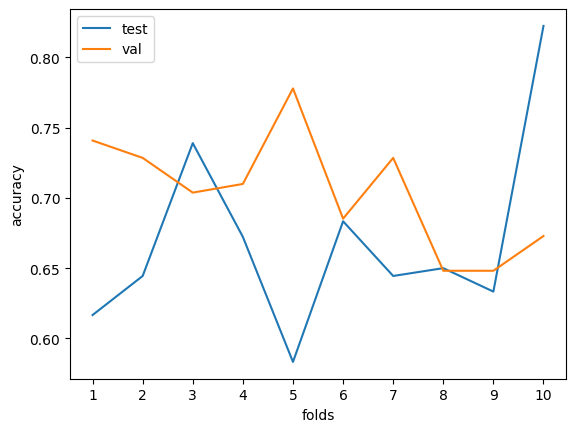

In [20]:
import matplotlib.pyplot as plt

x = np.arange(1,11)
plt.plot(x, np.squeeze(df['accuracy'].values), label='test')
plt.plot(x, np.squeeze(df_val['accuracy'].values), label='val')
plt.legend()
plt.xlabel('folds')
plt.ylabel('accuracy')
plt.xticks(x)
plt.show()

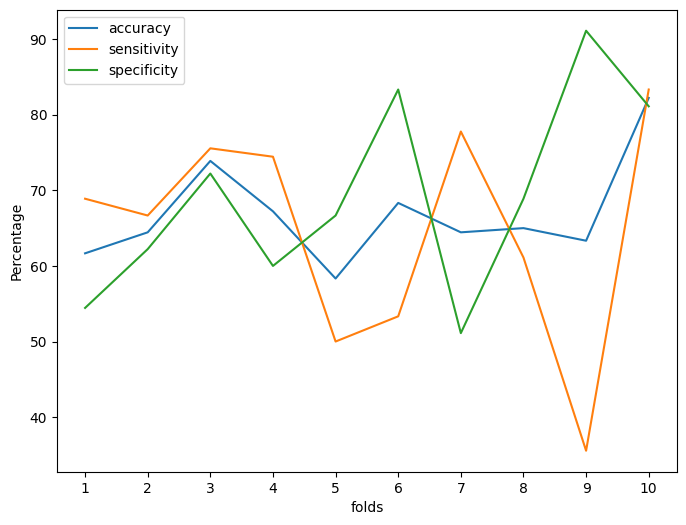

In [21]:
x = np.arange(1,11)

keys = ['accuracy', 'sensitivity', 'specificity']

plt.figure(figsize=(8, 6))  # Opprett én figur
for key in keys:
    
    plt.plot(x, np.squeeze(df[key])*100, label=key)
    
plt.legend()
plt.xlabel('folds')
plt.ylabel('Percentage')
plt.xticks(x)
plt.show()

In [22]:
def load_pred(filepath, fold):

    path = f"/home/stinasb/SSL4PR/TV_train_test/Fold{fold}/test/test.csv"
    
    df = pd.read_csv(path)
    
    pred = pd.read_csv(filepath)
    
    #pred_x = np.array([int(x.strip('[]')) for x in pred[fold]])
    
    df['speech_task'] = df['sample_wav'].str.replace(
    '/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/', '', regex=False
    ).apply(lambda x: x.split('/')[0])
    
    df['pred'] = pred[fold]
    
    return df

def accuracy_per_param(param, df, method, fold):

    # Calculate accuracy for each task
    #accuracy_per_task = df.groupby(param).apply(lambda x: (x['true_label_int'] == x['pred']).mean())
    #accuracy_per_task = df.groupby(param, include_groups=False).apply(lambda x: (x['true_label_int'] == x['pred']).mean())
    
    # Calculate accuracy for each task by excluding the grouping column
    accuracy_per_task = df.groupby(param).apply(
        lambda x: (x['labels'] == x['pred']).mean()
    ).reset_index(name='accuracy')
    
    #print(accuracy_per_task)

    # Plot accuracy
    accuracy_per_task.set_index(param)['accuracy'].plot(kind='bar', figsize=(10, 8))

    # Plot accuracy
    #accuracy_per_task.plot(kind='bar', figsize=(8, 6))
    plt.title(f"Accuracy per {param} in fold {fold} ({method})")
    plt.xlabel(param)
    plt.ylabel('Accuracy score')
    plt.ylim(0, 1)
    #plt.show()

/tmp/ipykernel_2086924/3255992578.py:26: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  accuracy_per_task = df.groupby(param).apply(


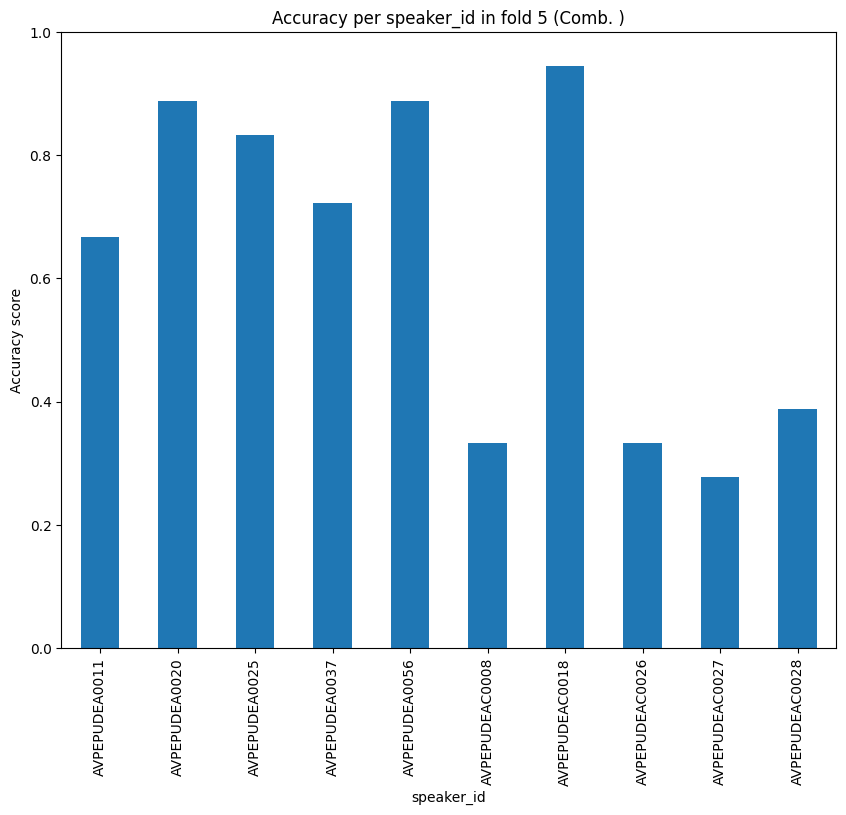

In [23]:
fold_nr = '5'
method = 'Comb. '
param = 'speaker_id'
df = load_pred("/home/stinasb/SSL4PR/TVs_copy/test_predictions_attention.csv", fold_nr)

plt.figure(figsize=(8,6))
accuracy_per_param(param, df, method , fold_nr)
plt.show()

In [24]:
#train_path = f"/home/stinasb/SSL4PR/TV_train_test/Fold9/train/train.csv"

#df_10 = pd.read_csv(train_path)
#pd.set_option('display.max_rows', None) 
#print(df['speaker_id'].value_counts())

In [25]:
pred = [0,0,0,1,1,1]
ref = [0,1,0,1,1,1]

report = classification_report(ref, pred, output_dict=True)
df = pd.DataFrame(report, columns= ['0','1'])
df

,0,1
precision,0.666667,1.000000
recall,1.000000,0.750000
f1-score,0.800000,0.857143
support,2.000000,4.000000


In [26]:
pred = [0,1,0,1,1,1]
ref = [0,1,0,1,0,0]

report2 = classification_report(ref, pred, output_dict=True)
df2 = pd.DataFrame(report2, columns= ['0','1'])
df2

,0,1
precision,1.000000,0.500000
recall,0.500000,1.000000
f1-score,0.666667,0.666667
support,4.000000,2.000000


In [27]:
newdict = {1: report, 2: report2}
newdict

{1: {'0': {'precision': 0.6666666666666666,
   'recall': 1.0,
   'f1-score': 0.8,
   'support': 2.0},
  '1': {'precision': 1.0,
   'recall': 0.75,
   'f1-score': 0.8571428571428571,
   'support': 4.0},
  'accuracy': 0.8333333333333334,
  'macro avg': {'precision': 0.8333333333333333,
   'recall': 0.875,
   'f1-score': 0.8285714285714285,
   'support': 6.0},
  'weighted avg': {'precision': 0.8888888888888888,
   'recall': 0.8333333333333334,
   'f1-score': 0.8380952380952381,
   'support': 6.0}},
 2: {'0': {'precision': 1.0,
   'recall': 0.5,
   'f1-score': 0.6666666666666666,
   'support': 4.0},
  '1': {'precision': 0.5,
   'recall': 1.0,
   'f1-score': 0.6666666666666666,
   'support': 2.0},
  'accuracy': 0.6666666666666666,
  'macro avg': {'precision': 0.75,
   'recall': 0.75,
   'f1-score': 0.6666666666666666,
   'support': 6.0},
  'weighted avg': {'precision': 0.8333333333333334,
   'recall': 0.6666666666666666,
   'f1-score': 0.6666666666666666,
   'support': 6.0}}}

In [28]:
path = "/home/stinasb/SSL4PR/TV_train_test/Fold1/train/train.csv"
df = pd.read_csv(path)

df = df[['sample_tv', 'sample_wav']]
print('tv')
for row, data in df.iterrows():
    sr, file = wavfile.read(data['sample_wav'])
    feat = librosa.feature.melspectrogram(y=file.astype(float), sr=sr, hop_length= int(0.01*sr))
    #print(data['sample_tv'], data['sample_wav'])
    print(pd.read_pickle(data['sample_tv']).shape, librosa.power_to_db(feat).T.shape)
 


    

tv


(6078, 9) (6078, 128)
(282, 9) (281, 128)
(548, 9) (548, 128)
(228, 9) (227, 128)
(362, 9) (362, 128)
(466, 9) (466, 128)
(198, 9) (197, 128)
(242, 9) (242, 128)
(702, 9) (701, 128)
(408, 9) (408, 128)


(654, 9) (654, 128)
(756, 9) (757, 128)
(456, 9) (455, 128)
(2616, 9) (2615, 128)


(494, 9) (494, 128)
(680, 9) (679, 128)
(296, 9) (296, 128)
(722, 9) (722, 128)


(10416, 9) (10415, 128)
(390, 9) (389, 128)
(188, 9) (187, 128)
(188, 9) (187, 128)
(342, 9) (342, 128)
(334, 9) (334, 128)
(156, 9) (156, 128)
(214, 9) (214, 128)
(192, 9) (191, 128)
(200, 9) (200, 128)
(300, 9) (300, 128)
(220, 9) (220, 128)


(420, 9) (420, 128)
(2062, 9) (2061, 128)
(340, 9) (340, 128)
(228, 9) (227, 128)
(420, 9) (419, 128)


(716, 9) (715, 128)
(4326, 9) (4326, 128)


(250, 9) (249, 128)
(248, 9) (247, 128)
(212, 9) (212, 128)
(298, 9) (297, 128)
(312, 9) (311, 128)
(180, 9) (179, 128)
(234, 9) (234, 128)
(184, 9) (184, 128)
(232, 9) (232, 128)
(448, 9) (448, 128)
(402, 9) (402, 128)


(376, 9) (375, 128)
(1560, 9) (1559, 128)
(334, 9) (334, 128)
(144, 9) (144, 128)
(334, 9) (334, 128)
(588, 9) (588, 128)


(3080, 9) (3079, 128)
(246, 9) (245, 128)
(146, 9) (146, 128)
(176, 9) (176, 128)
(278, 9) (277, 128)
(304, 9) (303, 128)
(166, 9) (165, 128)
(200, 9) (200, 128)
(154, 9) (154, 128)
(628, 9) (627, 128)
(608, 9) (608, 128)


(634, 9) (634, 128)
(330, 9) (329, 128)
(2366, 9) (2365, 128)
(302, 9) (301, 128)
(140, 9) (140, 128)
(272, 9) (271, 128)


(786, 9) (786, 128)


(4544, 9) (4544, 128)
(326, 9) (325, 128)
(378, 9) (377, 128)
(246, 9) (245, 128)
(374, 9) (373, 128)
(336, 9) (336, 128)
(204, 9) (204, 128)
(250, 9) (250, 128)
(544, 9) (543, 128)


(718, 9) (717, 128)
(1054, 9) (1053, 128)
(604, 9) (603, 128)
(510, 9) (509, 128)


(1730, 9) (1729, 128)
(460, 9) (459, 128)
(378, 9) (378, 128)
(410, 9) (409, 128)
(774, 9) (773, 128)


(8794, 9) (8793, 128)
(368, 9) (367, 128)
(400, 9) (400, 128)
(202, 9) (202, 128)
(272, 9) (272, 128)
(296, 9) (296, 128)
(186, 9) (185, 128)
(212, 9) (211, 128)
(528, 9) (527, 128)
(450, 9) (450, 128)


(334, 9) (333, 128)
(300, 9) (299, 128)
(452, 9) (451, 128)
(1898, 9) (1897, 128)
(318, 9) (318, 128)
(362, 9) (362, 128)
(274, 9) (273, 128)


(1036, 9) (1036, 128)


(6214, 9) (6214, 128)
(410, 9) (409, 128)
(534, 9) (533, 128)
(168, 9) (168, 128)
(244, 9) (243, 128)
(344, 9) (343, 128)
(162, 9) (161, 128)
(182, 9) (182, 128)
(282, 9) (281, 128)
(610, 9) (610, 128)
(320, 9) (320, 128)


(526, 9) (525, 128)
(556, 9) (555, 128)
(1838, 9) (1837, 128)
(296, 9) (296, 128)
(538, 9) (537, 128)
(362, 9) (362, 128)


(1124, 9) (1124, 128)
(2804, 9) (2804, 128)
(298, 9) (298, 128)
(110, 9) (109, 128)
(182, 9) (182, 128)
(284, 9) (283, 128)


(530, 9) (529, 128)
(188, 9) (187, 128)
(234, 9) (234, 128)
(126, 9) (126, 128)
(720, 9) (719, 128)
(660, 9) (659, 128)
(452, 9) (451, 128)
(356, 9) (356, 128)


(1548, 9) (1547, 128)
(428, 9) (428, 128)
(122, 9) (121, 128)
(280, 9) (279, 128)
(692, 9) (691, 128)


(4412, 9) (4412, 128)
(436, 9) (436, 128)
(238, 9) (237, 128)
(304, 9) (304, 128)
(306, 9) (306, 128)
(406, 9) (406, 128)
(198, 9) (198, 128)
(296, 9) (295, 128)
(444, 9) (444, 128)


(462, 9) (462, 128)
(420, 9) (419, 128)
(450, 9) (449, 128)
(420, 9) (420, 128)
(2098, 9) (2097, 128)


(366, 9) (366, 128)
(320, 9) (320, 128)
(304, 9) (303, 128)
(932, 9) (932, 128)


(3976, 9) (3976, 128)
(198, 9) (198, 128)
(194, 9) (195, 128)
(180, 9) (179, 128)
(330, 9) (329, 128)
(326, 9) (326, 128)
(152, 9) (152, 128)
(198, 9) (197, 128)
(170, 9) (170, 128)
(316, 9) (315, 128)
(254, 9) (253, 128)
(190, 9) (190, 128)


(266, 9) (265, 128)
(1584, 9) (1584, 128)
(330, 9) (329, 128)
(308, 9) (308, 128)
(220, 9) (220, 128)


(1450, 9) (1449, 128)


(4800, 9) (4800, 128)
(326, 9) (325, 128)
(198, 9) (198, 128)
(292, 9) (291, 128)
(324, 9) (323, 128)
(354, 9) (354, 128)
(248, 9) (247, 128)
(224, 9) (224, 128)
(428, 9) (427, 128)
(466, 9) (466, 128)


(680, 9) (679, 128)
(324, 9) (324, 128)
(454, 9) (454, 128)
(1500, 9) (1500, 128)
(496, 9) (496, 128)
(430, 9) (430, 128)
(346, 9) (346, 128)


(736, 9) (735, 128)
(1970, 9) (1970, 128)
(182, 9) (182, 128)
(384, 9) (383, 128)
(166, 9) (166, 128)
(264, 9) (263, 128)
(300, 9) (300, 128)
(168, 9) (168, 128)


(180, 9) (180, 128)
(536, 9) (535, 128)
(722, 9) (721, 128)
(648, 9) (648, 128)
(800, 9) (800, 128)
(282, 9) (281, 128)


(2056, 9) (2055, 128)
(300, 9) (299, 128)
(454, 9) (453, 128)
(230, 9) (229, 128)
(872, 9) (872, 128)


(4194, 9) (4194, 128)
(200, 9) (199, 128)
(556, 9) (556, 128)
(176, 9) (176, 128)
(238, 9) (238, 128)
(290, 9) (289, 128)
(150, 9) (149, 128)
(182, 9) (181, 128)
(562, 9) (561, 128)
(654, 9) (653, 128)


(748, 9) (747, 128)
(686, 9) (686, 128)
(248, 9) (248, 128)
(2138, 9) (2137, 128)
(476, 9) (475, 128)


(466, 9) (465, 128)
(228, 9) (227, 128)
(968, 9) (967, 128)
(2220, 9) (2220, 128)


(386, 9) (386, 128)
(474, 9) (474, 128)
(198, 9) (197, 128)
(430, 9) (430, 128)
(472, 9) (472, 128)
(216, 9) (216, 128)
(394, 9) (393, 128)
(506, 9) (506, 128)


(572, 9) (571, 128)
(548, 9) (547, 128)
(680, 9) (680, 128)
(848, 9) (847, 128)
(1434, 9) (1433, 128)


(458, 9) (457, 128)
(448, 9) (448, 128)
(294, 9) (294, 128)
(1074, 9) (1074, 128)


(3186, 9) (3186, 128)
(382, 9) (382, 128)
(298, 9) (298, 128)
(330, 9) (329, 128)
(318, 9) (318, 128)
(448, 9) (448, 128)
(270, 9) (270, 128)
(246, 9) (246, 128)
(314, 9) (313, 128)


(564, 9) (563, 128)
(728, 9) (727, 128)
(630, 9) (630, 128)
(440, 9) (440, 128)
(1422, 9) (1422, 128)


(592, 9) (591, 128)
(328, 9) (327, 128)
(300, 9) (299, 128)
(660, 9) (660, 128)


(4844, 9) (4844, 128)
(296, 9) (296, 128)
(404, 9) (404, 128)
(176, 9) (175, 128)
(286, 9) (285, 128)
(302, 9) (301, 128)
(156, 9) (156, 128)
(238, 9) (238, 128)
(516, 9) (515, 128)
(540, 9) (540, 128)


(492, 9) (492, 128)
(536, 9) (535, 128)
(380, 9) (379, 128)
(1230, 9) (1229, 128)
(306, 9) (306, 128)
(386, 9) (385, 128)
(226, 9) (226, 128)


(572, 9) (571, 128)


(4450, 9) (4449, 128)
(284, 9) (283, 128)
(456, 9) (455, 128)
(214, 9) (214, 128)
(322, 9) (322, 128)
(350, 9) (350, 128)
(188, 9) (187, 128)
(234, 9) (234, 128)
(466, 9) (465, 128)


(562, 9) (562, 128)
(640, 9) (639, 128)
(586, 9) (586, 128)
(396, 9) (396, 128)
(1322, 9) (1321, 128)
(388, 9) (387, 128)


(516, 9) (516, 128)
(300, 9) (299, 128)
(638, 9) (638, 128)


(8416, 9) (8415, 128)
(194, 9) (194, 128)
(130, 9) (130, 128)
(132, 9) (132, 128)
(282, 9) (282, 128)
(368, 9) (367, 128)
(170, 9) (170, 128)
(164, 9) (163, 128)
(124, 9) (123, 128)
(402, 9) (401, 128)
(348, 9) (347, 128)
(208, 9) (208, 128)
(238, 9) (237, 128)


(2458, 9) (2457, 128)
(262, 9) (262, 128)
(128, 9) (128, 128)
(192, 9) (192, 128)
(1010, 9) (1010, 128)


(2952, 9) (2952, 128)
(478, 9) (477, 128)
(284, 9) (283, 128)
(180, 9) (180, 128)
(310, 9) (310, 128)
(286, 9) (286, 128)
(158, 9) (157, 128)
(270, 9) (269, 128)
(408, 9) (407, 128)
(192, 9) (192, 128)
(334, 9) (333, 128)


(390, 9) (389, 128)
(338, 9) (338, 128)
(1796, 9) (1796, 128)
(516, 9) (516, 128)
(340, 9) (339, 128)
(272, 9) (271, 128)


(710, 9) (710, 128)


(4384, 9) (4383, 128)
(420, 9) (419, 128)
(232, 9) (231, 128)
(306, 9) (305, 128)
(418, 9) (417, 128)
(450, 9) (449, 128)
(282, 9) (281, 128)
(372, 9) (372, 128)
(252, 9) (252, 128)


(510, 9) (510, 128)
(364, 9) (363, 128)
(522, 9) (521, 128)
(474, 9) (473, 128)
(1704, 9) (1704, 128)


(484, 9) (483, 128)
(278, 9) (277, 128)
(350, 9) (349, 128)
(900, 9) (900, 128)


(2680, 9) (2679, 128)
(438, 9) (438, 128)
(178, 9) (177, 128)
(226, 9) (225, 128)
(414, 9) (414, 128)
(388, 9) (388, 128)
(188, 9) (187, 128)
(258, 9) (257, 128)
(218, 9) (217, 128)
(484, 9) (484, 128)
(238, 9) (237, 128)


(422, 9) (421, 128)
(510, 9) (509, 128)
(1860, 9) (1859, 128)
(526, 9) (525, 128)
(194, 9) (193, 128)
(320, 9) (319, 128)


(842, 9) (841, 128)


(9912, 9) (9911, 128)
(566, 9) (566, 128)
(126, 9) (126, 128)
(354, 9) (354, 128)
(520, 9) (519, 128)
(964, 9) (964, 128)
(220, 9) (220, 128)
(392, 9) (391, 128)
(176, 9) (176, 128)


(222, 9) (222, 128)
(140, 9) (140, 128)
(180, 9) (180, 128)
(438, 9) (437, 128)
(2794, 9) (2793, 128)


(820, 9) (820, 128)
(78, 9) (78, 128)
(610, 9) (609, 128)
(1488, 9) (1488, 128)


(3050, 9) (3050, 128)
(334, 9) (333, 128)
(340, 9) (340, 128)
(242, 9) (241, 128)
(358, 9) (358, 128)
(380, 9) (380, 128)
(220, 9) (220, 128)
(300, 9) (299, 128)
(146, 9) (145, 128)
(696, 9) (696, 128)


(588, 9) (588, 128)
(656, 9) (656, 128)
(394, 9) (393, 128)
(2156, 9) (2155, 128)
(512, 9) (511, 128)


(380, 9) (379, 128)
(350, 9) (349, 128)
(796, 9) (795, 128)


(3468, 9) (3468, 128)
(288, 9) (288, 128)
(372, 9) (372, 128)
(232, 9) (232, 128)
(336, 9) (336, 128)
(400, 9) (400, 128)
(178, 9) (178, 128)
(260, 9) (260, 128)
(372, 9) (372, 128)
(614, 9) (613, 128)


(654, 9) (654, 128)
(542, 9) (541, 128)
(384, 9) (383, 128)
(1444, 9) (1443, 128)
(392, 9) (391, 128)
(452, 9) (451, 128)
(254, 9) (253, 128)


(624, 9) (623, 128)
(3244, 9) (3244, 128)
(296, 9) (296, 128)
(136, 9) (136, 128)
(224, 9) (223, 128)


(282, 9) (281, 128)
(346, 9) (345, 128)
(142, 9) (142, 128)
(186, 9) (185, 128)
(130, 9) (129, 128)
(192, 9) (192, 128)
(330, 9) (329, 128)
(222, 9) (221, 128)
(344, 9) (343, 128)


(1422, 9) (1421, 128)
(500, 9) (500, 128)
(132, 9) (132, 128)
(266, 9) (265, 128)
(822, 9) (822, 128)


(4596, 9) (4595, 128)
(360, 9) (359, 128)
(462, 9) (462, 128)
(250, 9) (250, 128)
(438, 9) (437, 128)
(534, 9) (533, 128)
(286, 9) (285, 128)
(318, 9) (318, 128)


(450, 9) (450, 128)
(610, 9) (609, 128)
(586, 9) (585, 128)
(826, 9) (826, 128)
(450, 9) (449, 128)


(4528, 9) (4527, 128)
(600, 9) (600, 128)
(608, 9) (607, 128)
(392, 9) (391, 128)
(2172, 9) (2172, 128)


(5072, 9) (5071, 128)
(246, 9) (245, 128)
(120, 9) (119, 128)
(164, 9) (163, 128)
(186, 9) (185, 128)
(280, 9) (279, 128)
(196, 9) (196, 128)
(158, 9) (157, 128)
(140, 9) (139, 128)
(290, 9) (289, 128)
(258, 9) (258, 128)
(190, 9) (189, 128)
(428, 9) (428, 128)


(2306, 9) (2306, 128)
(444, 9) (443, 128)
(158, 9) (158, 128)
(324, 9) (324, 128)
(1084, 9) (1084, 128)


(2712, 9) (2712, 128)
(342, 9) (341, 128)
(324, 9) (323, 128)
(222, 9) (223, 128)
(328, 9) (327, 128)
(354, 9) (353, 128)
(186, 9) (186, 128)
(272, 9) (272, 128)
(322, 9) (322, 128)
(526, 9) (525, 128)


(414, 9) (414, 128)
(254, 9) (254, 128)
(562, 9) (561, 128)
(1698, 9) (1698, 128)
(350, 9) (350, 128)
(362, 9) (362, 128)


(310, 9) (310, 128)
(724, 9) (724, 128)
(2264, 9) (2264, 128)
(374, 9) (374, 128)
(144, 9) (143, 128)
(132, 9) (132, 128)


(576, 9) (575, 128)
(504, 9) (503, 128)
(142, 9) (141, 128)
(170, 9) (169, 128)
(194, 9) (193, 128)
(180, 9) (179, 128)
(144, 9) (143, 128)
(112, 9) (111, 128)
(498, 9) (497, 128)


(2004, 9) (2004, 128)
(498, 9) (497, 128)
(128, 9) (128, 128)
(452, 9) (451, 128)
(816, 9) (816, 128)


(3390, 9) (3389, 128)
(368, 9) (368, 128)
(140, 9) (139, 128)
(270, 9) (270, 128)
(340, 9) (340, 128)
(512, 9) (512, 128)
(204, 9) (204, 128)
(310, 9) (309, 128)
(138, 9) (138, 128)
(196, 9) (196, 128)
(196, 9) (195, 128)
(188, 9) (188, 128)


(668, 9) (667, 128)
(2100, 9) (2100, 128)
(480, 9) (480, 128)
(92, 9) (92, 128)
(446, 9) (446, 128)


(866, 9) (865, 128)
(3878, 9) (3878, 128)


(412, 9) (411, 128)
(112, 9) (111, 128)
(196, 9) (195, 128)
(568, 9) (567, 128)
(358, 9) (357, 128)
(174, 9) (174, 128)
(288, 9) (288, 128)
(134, 9) (134, 128)
(244, 9) (244, 128)
(174, 9) (174, 128)
(252, 9) (252, 128)
(404, 9) (403, 128)


(1978, 9) (1978, 128)
(406, 9) (406, 128)
(128, 9) (128, 128)
(554, 9) (553, 128)
(818, 9) (818, 128)


(7578, 9) (7577, 128)
(416, 9) (415, 128)
(204, 9) (203, 128)
(210, 9) (209, 128)
(314, 9) (314, 128)
(388, 9) (387, 128)
(156, 9) (155, 128)
(234, 9) (233, 128)
(158, 9) (158, 128)
(308, 9) (307, 128)
(372, 9) (372, 128)
(270, 9) (269, 128)


(414, 9) (413, 128)
(1836, 9) (1836, 128)
(524, 9) (524, 128)
(186, 9) (186, 128)
(314, 9) (314, 128)
(834, 9) (833, 128)


(4000, 9) (4000, 128)
(230, 9) (230, 128)
(154, 9) (154, 128)
(176, 9) (175, 128)
(294, 9) (293, 128)
(286, 9) (286, 128)
(184, 9) (183, 128)
(210, 9) (210, 128)
(154, 9) (153, 128)
(242, 9) (242, 128)
(378, 9) (378, 128)
(230, 9) (230, 128)
(350, 9) (349, 128)


(1394, 9) (1394, 128)
(308, 9) (307, 128)
(198, 9) (197, 128)
(268, 9) (268, 128)
(646, 9) (645, 128)


(3536, 9) (3536, 128)
(246, 9) (245, 128)
(592, 9) (592, 128)
(188, 9) (188, 128)
(240, 9) (240, 128)
(380, 9) (379, 128)
(126, 9) (125, 128)
(174, 9) (173, 128)
(458, 9) (458, 128)
(148, 9) (147, 128)
(218, 9) (217, 128)
(288, 9) (288, 128)


(388, 9) (388, 128)
(1036, 9) (1035, 128)
(346, 9) (345, 128)
(542, 9) (542, 128)
(176, 9) (175, 128)
(482, 9) (482, 128)


(11096, 9) (11096, 128)
(348, 9) (347, 128)
(490, 9) (489, 128)
(308, 9) (308, 128)
(374, 9) (374, 128)
(664, 9) (664, 128)
(238, 9) (237, 128)
(368, 9) (368, 128)


(656, 9) (655, 128)
(902, 9) (902, 128)
(778, 9) (778, 128)
(882, 9) (881, 128)
(460, 9) (459, 128)


(1814, 9) (1814, 128)
(686, 9) (685, 128)
(770, 9) (770, 128)
(356, 9) (355, 128)
(844, 9) (843, 128)


(6234, 9) (6233, 128)
(220, 9) (219, 128)
(186, 9) (186, 128)
(202, 9) (202, 128)
(262, 9) (262, 128)
(222, 9) (222, 128)
(164, 9) (163, 128)
(220, 9) (219, 128)
(144, 9) (143, 128)
(352, 9) (352, 128)
(436, 9) (435, 128)
(364, 9) (364, 128)
(230, 9) (230, 128)


(1256, 9) (1255, 128)
(294, 9) (293, 128)
(184, 9) (183, 128)
(256, 9) (256, 128)
(484, 9) (484, 128)
(1412, 9) (1411, 128)
(266, 9) (265, 128)
(132, 9) (131, 128)


(148, 9) (148, 128)
(224, 9) (223, 128)
(274, 9) (274, 128)
(140, 9) (140, 128)
(226, 9) (226, 128)
(132, 9) (131, 128)
(288, 9) (287, 128)
(516, 9) (515, 128)
(212, 9) (211, 128)
(278, 9) (278, 128)


(1300, 9) (1300, 128)
(286, 9) (285, 128)
(120, 9) (119, 128)
(246, 9) (245, 128)
(520, 9) (520, 128)
(2588, 9) (2587, 128)


(224, 9) (223, 128)
(136, 9) (135, 128)
(148, 9) (147, 128)
(248, 9) (247, 128)
(302, 9) (301, 128)
(166, 9) (165, 128)
(184, 9) (183, 128)
(242, 9) (241, 128)
(280, 9) (280, 128)
(616, 9) (615, 128)
(306, 9) (305, 128)


(456, 9) (456, 128)
(1476, 9) (1475, 128)
(292, 9) (292, 128)
(174, 9) (174, 128)
(258, 9) (258, 128)
(662, 9) (662, 128)


(2242, 9) (2242, 128)
(244, 9) (244, 128)
(190, 9) (189, 128)
(166, 9) (165, 128)
(260, 9) (260, 128)
(336, 9) (336, 128)
(184, 9) (183, 128)
(220, 9) (220, 128)
(280, 9) (279, 128)
(286, 9) (285, 128)
(508, 9) (508, 128)
(248, 9) (247, 128)


(330, 9) (330, 128)
(1404, 9) (1404, 128)
(306, 9) (306, 128)
(332, 9) (331, 128)
(300, 9) (299, 128)
(616, 9) (616, 128)


(8970, 9) (8970, 128)
(388, 9) (387, 128)
(382, 9) (382, 128)
(300, 9) (299, 128)
(750, 9) (749, 128)
(534, 9) (533, 128)
(212, 9) (211, 128)
(470, 9) (469, 128)


(424, 9) (423, 128)
(562, 9) (561, 128)
(556, 9) (556, 128)
(626, 9) (626, 128)
(702, 9) (702, 128)


(3734, 9) (3734, 128)
(690, 9) (690, 128)
(344, 9) (343, 128)
(500, 9) (499, 128)
(872, 9) (872, 128)


(2586, 9) (2585, 128)
(212, 9) (211, 128)
(120, 9) (119, 128)
(128, 9) (128, 128)
(222, 9) (221, 128)
(350, 9) (349, 128)
(122, 9) (121, 128)
(170, 9) (169, 128)
(78, 9) (77, 128)
(352, 9) (351, 128)
(568, 9) (567, 128)
(502, 9) (501, 128)
(242, 9) (241, 128)


(1466, 9) (1466, 128)
(322, 9) (321, 128)
(136, 9) (135, 128)
(218, 9) (217, 128)
(546, 9) (545, 128)


(3980, 9) (3980, 128)
(224, 9) (223, 128)
(268, 9) (268, 128)
(172, 9) (172, 128)
(288, 9) (288, 128)
(324, 9) (323, 128)
(182, 9) (181, 128)
(178, 9) (178, 128)
(262, 9) (262, 128)
(270, 9) (270, 128)
(254, 9) (253, 128)
(340, 9) (339, 128)


(308, 9) (308, 128)
(1642, 9) (1642, 128)
(342, 9) (342, 128)
(212, 9) (211, 128)
(258, 9) (257, 128)
(576, 9) (576, 128)


(2612, 9) (2612, 128)
(270, 9) (269, 128)
(884, 9) (883, 128)
(248, 9) (248, 128)
(266, 9) (266, 128)
(438, 9) (438, 128)
(170, 9) (170, 128)
(200, 9) (199, 128)
(756, 9) (755, 128)


(746, 9) (746, 128)
(780, 9) (780, 128)
(722, 9) (721, 128)
(740, 9) (739, 128)


(1424, 9) (1423, 128)
(382, 9) (382, 128)
(914, 9) (914, 128)
(284, 9) (284, 128)
(736, 9) (736, 128)


(6920, 9) (6920, 128)
(290, 9) (290, 128)
(134, 9) (133, 128)
(162, 9) (161, 128)
(290, 9) (290, 128)
(286, 9) (285, 128)
(190, 9) (189, 128)
(238, 9) (238, 128)
(130, 9) (130, 128)
(760, 9) (759, 128)


(696, 9) (696, 128)
(812, 9) (811, 128)
(270, 9) (270, 128)
(1424, 9) (1423, 128)
(378, 9) (378, 128)
(222, 9) (221, 128)
(276, 9) (275, 128)


(584, 9) (583, 128)
(3966, 9) (3965, 128)


(442, 9) (442, 128)
(278, 9) (277, 128)
(394, 9) (394, 128)
(618, 9) (618, 128)
(450, 9) (449, 128)
(240, 9) (240, 128)
(496, 9) (496, 128)
(326, 9) (326, 128)
(214, 9) (214, 128)


(642, 9) (642, 128)
(540, 9) (540, 128)
(544, 9) (543, 128)


(2636, 9) (2636, 128)
(634, 9) (633, 128)
(490, 9) (490, 128)
(512, 9) (511, 128)
(1152, 9) (1152, 128)


(5838, 9) (5837, 128)
(306, 9) (305, 128)
(368, 9) (368, 128)
(226, 9) (225, 128)
(370, 9) (369, 128)
(356, 9) (356, 128)
(234, 9) (233, 128)
(304, 9) (304, 128)
(322, 9) (321, 128)
(358, 9) (357, 128)


(390, 9) (390, 128)
(506, 9) (505, 128)
(426, 9) (425, 128)
(1748, 9) (1748, 128)
(512, 9) (511, 128)
(402, 9) (402, 128)


(324, 9) (324, 128)
(762, 9) (761, 128)


(16410, 9) (16410, 128)
(326, 9) (325, 128)
(316, 9) (315, 128)
(194, 9) (193, 128)
(340, 9) (339, 128)
(494, 9) (493, 128)
(212, 9) (212, 128)
(254, 9) (253, 128)
(366, 9) (365, 128)
(446, 9) (446, 128)


(528, 9) (528, 128)
(590, 9) (589, 128)
(410, 9) (409, 128)
(1708, 9) (1708, 128)
(478, 9) (477, 128)
(424, 9) (424, 128)


(342, 9) (341, 128)
(768, 9) (768, 128)


(10310, 9) (10310, 128)
(342, 9) (342, 128)
(238, 9) (237, 128)
(228, 9) (228, 128)
(328, 9) (328, 128)
(406, 9) (405, 128)
(234, 9) (234, 128)
(260, 9) (260, 128)
(222, 9) (222, 128)
(252, 9) (252, 128)
(312, 9) (311, 128)


(274, 9) (274, 128)
(452, 9) (452, 128)
(1436, 9) (1436, 128)
(414, 9) (414, 128)
(226, 9) (226, 128)
(344, 9) (343, 128)


(774, 9) (773, 128)


(6904, 9) (6904, 128)
(274, 9) (273, 128)
(286, 9) (285, 128)
(212, 9) (212, 128)
(298, 9) (297, 128)
(308, 9) (307, 128)
(176, 9) (175, 128)
(248, 9) (248, 128)
(326, 9) (325, 128)
(498, 9) (498, 128)


(520, 9) (519, 128)
(476, 9) (476, 128)
(384, 9) (384, 128)
(1782, 9) (1781, 128)
(340, 9) (339, 128)
(376, 9) (375, 128)
(288, 9) (287, 128)


(778, 9) (777, 128)


(6254, 9) (6254, 128)
(354, 9) (354, 128)
(630, 9) (629, 128)
(238, 9) (238, 128)
(372, 9) (371, 128)
(436, 9) (435, 128)
(260, 9) (259, 128)
(406, 9) (405, 128)
(482, 9) (481, 128)


(448, 9) (447, 128)
(296, 9) (295, 128)
(648, 9) (647, 128)
(542, 9) (541, 128)
(1888, 9) (1888, 128)


(506, 9) (506, 128)
(530, 9) (529, 128)
(342, 9) (342, 128)
(860, 9) (860, 128)


(8692, 9) (8692, 128)
(294, 9) (293, 128)
(462, 9) (462, 128)
(194, 9) (193, 128)
(336, 9) (336, 128)
(376, 9) (376, 128)
(220, 9) (219, 128)
(258, 9) (258, 128)
(420, 9) (420, 128)
(304, 9) (304, 128)
(404, 9) (403, 128)


(428, 9) (428, 128)
(396, 9) (396, 128)
(1792, 9) (1792, 128)
(420, 9) (419, 128)
(384, 9) (384, 128)
(342, 9) (342, 128)


(754, 9) (754, 128)


(9134, 9) (9133, 128)
(348, 9) (348, 128)
(398, 9) (397, 128)
(210, 9) (209, 128)
(352, 9) (352, 128)
(396, 9) (396, 128)
(224, 9) (223, 128)
(340, 9) (339, 128)
(434, 9) (434, 128)
(546, 9) (545, 128)
(686, 9) (685, 128)
(420, 9) (420, 128)


(460, 9) (460, 128)
(1936, 9) (1936, 128)
(466, 9) (466, 128)
(434, 9) (434, 128)
(374, 9) (374, 128)
(790, 9) (790, 128)


(3322, 9) (3321, 128)
(316, 9) (316, 128)
(398, 9) (397, 128)
(210, 9) (209, 128)
(380, 9) (380, 128)
(392, 9) (391, 128)
(220, 9) (219, 128)
(238, 9) (237, 128)
(526, 9) (525, 128)
(386, 9) (386, 128)


(472, 9) (472, 128)
(478, 9) (477, 128)
(452, 9) (451, 128)
(1676, 9) (1676, 128)
(418, 9) (417, 128)
(492, 9) (492, 128)


(358, 9) (357, 128)
(736, 9) (736, 128)
(3354, 9) (3353, 128)


(444, 9) (444, 128)
(128, 9) (128, 128)
(242, 9) (242, 128)
(468, 9) (468, 128)
(550, 9) (549, 128)
(236, 9) (235, 128)
(314, 9) (313, 128)
(122, 9) (122, 128)
(346, 9) (346, 128)
(336, 9) (335, 128)


(198, 9) (197, 128)
(566, 9) (565, 128)
(1738, 9) (1737, 128)
(542, 9) (542, 128)
(136, 9) (136, 128)
(370, 9) (369, 128)


(800, 9) (800, 128)
(3382, 9) (3382, 128)
(270, 9) (269, 128)
(298, 9) (297, 128)


(166, 9) (165, 128)
(292, 9) (291, 128)
(286, 9) (285, 128)
(144, 9) (144, 128)
(186, 9) (186, 128)
(272, 9) (271, 128)
(414, 9) (414, 128)
(194, 9) (193, 128)
(574, 9) (573, 128)
(296, 9) (295, 128)


(1952, 9) (1952, 128)
(332, 9) (332, 128)
(286, 9) (286, 128)
(250, 9) (249, 128)
(874, 9) (874, 128)


(7176, 9) (7175, 128)
(222, 9) (221, 128)
(256, 9) (256, 128)
(152, 9) (151, 128)
(250, 9) (249, 128)
(274, 9) (274, 128)
(126, 9) (125, 128)
(170, 9) (169, 128)
(228, 9) (227, 128)
(336, 9) (336, 128)
(318, 9) (318, 128)
(238, 9) (238, 128)


(488, 9) (488, 128)
(1932, 9) (1932, 128)
(276, 9) (275, 128)
(208, 9) (207, 128)
(276, 9) (275, 128)
(868, 9) (867, 128)


(3406, 9) (3405, 128)
(284, 9) (283, 128)
(82, 9) (82, 128)
(210, 9) (210, 128)
(334, 9) (334, 128)
(364, 9) (364, 128)
(196, 9) (196, 128)
(238, 9) (238, 128)
(108, 9) (108, 128)
(184, 9) (183, 128)
(220, 9) (220, 128)
(150, 9) (149, 128)


(500, 9) (499, 128)
(1324, 9) (1324, 128)
(544, 9) (544, 128)
(80, 9) (80, 128)
(314, 9) (313, 128)
(652, 9) (652, 128)


(3132, 9) (3132, 128)
(466, 9) (466, 128)
(194, 9) (194, 128)
(196, 9) (196, 128)
(296, 9) (296, 128)
(408, 9) (407, 128)
(170, 9) (170, 128)
(264, 9) (264, 128)
(208, 9) (207, 128)
(168, 9) (168, 128)
(378, 9) (378, 128)
(170, 9) (170, 128)


(428, 9) (428, 128)
(1742, 9) (1742, 128)
(500, 9) (499, 128)
(164, 9) (164, 128)
(318, 9) (317, 128)
(744, 9) (744, 128)


(5876, 9) (5875, 128)
(508, 9) (508, 128)
(448, 9) (447, 128)
(266, 9) (265, 128)
(362, 9) (362, 128)
(566, 9) (565, 128)
(356, 9) (356, 128)
(252, 9) (251, 128)


(536, 9) (535, 128)
(420, 9) (419, 128)
(430, 9) (430, 128)
(526, 9) (525, 128)
(404, 9) (404, 128)


(1832, 9) (1831, 128)
(756, 9) (756, 128)
(532, 9) (531, 128)
(412, 9) (412, 128)
(1054, 9) (1054, 128)


(2512, 9) (2512, 128)
(254, 9) (254, 128)
(354, 9) (354, 128)
(204, 9) (203, 128)
(334, 9) (333, 128)
(370, 9) (370, 128)
(188, 9) (188, 128)
(220, 9) (219, 128)
(436, 9) (435, 128)
(616, 9) (616, 128)


(622, 9) (621, 128)
(664, 9) (664, 128)
(304, 9) (303, 128)
(1262, 9) (1261, 128)
(334, 9) (333, 128)
(394, 9) (393, 128)
(328, 9) (328, 128)


(630, 9) (630, 128)
(3242, 9) (3242, 128)
(284, 9) (283, 128)
(156, 9) (156, 128)
(226, 9) (226, 128)


(330, 9) (329, 128)
(380, 9) (380, 128)
(204, 9) (203, 128)
(256, 9) (256, 128)
(142, 9) (142, 128)
(250, 9) (249, 128)
(266, 9) (266, 128)
(224, 9) (223, 128)
(404, 9) (404, 128)


(1776, 9) (1775, 128)
(386, 9) (386, 128)
(140, 9) (139, 128)
(294, 9) (293, 128)
(684, 9) (683, 128)


(5310, 9) (5310, 128)
(290, 9) (290, 128)
(440, 9) (440, 128)
(162, 9) (162, 128)
(288, 9) (287, 128)
(322, 9) (321, 128)
(196, 9) (196, 128)
(238, 9) (238, 128)
(462, 9) (461, 128)
(392, 9) (392, 128)


(234, 9) (234, 128)
(324, 9) (323, 128)
(396, 9) (396, 128)
(1872, 9) (1871, 128)
(312, 9) (311, 128)
(536, 9) (535, 128)


(328, 9) (327, 128)
(646, 9) (646, 128)
(3332, 9) (3332, 128)


(290, 9) (289, 128)
(526, 9) (526, 128)
(224, 9) (224, 128)
(334, 9) (334, 128)
(384, 9) (384, 128)
(232, 9) (232, 128)
(302, 9) (302, 128)
(472, 9) (472, 128)
(396, 9) (396, 128)


(848, 9) (848, 128)
(732, 9) (731, 128)
(460, 9) (460, 128)
(1608, 9) (1608, 128)
(454, 9) (453, 128)


(538, 9) (538, 128)
(318, 9) (318, 128)
(760, 9) (759, 128)
(1826, 9) (1826, 128)
(440, 9) (440, 128)
(180, 9) (179, 128)


(226, 9) (225, 128)
(360, 9) (359, 128)
(424, 9) (424, 128)
(180, 9) (180, 128)
(368, 9) (367, 128)
(406, 9) (406, 128)
(532, 9) (532, 128)
(486, 9) (485, 128)
(538, 9) (537, 128)


(454, 9) (453, 128)
(1688, 9) (1688, 128)
(442, 9) (441, 128)
(272, 9) (271, 128)
(360, 9) (360, 128)
(772, 9) (772, 128)


(3534, 9) (3533, 128)
(348, 9) (348, 128)
(366, 9) (365, 128)
(196, 9) (196, 128)
(400, 9) (400, 128)
(426, 9) (425, 128)
(206, 9) (206, 128)
(298, 9) (297, 128)
(350, 9) (350, 128)
(678, 9) (677, 128)


(738, 9) (738, 128)
(624, 9) (624, 128)
(456, 9) (455, 128)
(2062, 9) (2061, 128)


(416, 9) (415, 128)
(348, 9) (348, 128)
(396, 9) (396, 128)
(804, 9) (804, 128)


(6624, 9) (6624, 128)
(350, 9) (350, 128)
(176, 9) (175, 128)
(228, 9) (227, 128)
(322, 9) (321, 128)
(364, 9) (364, 128)
(284, 9) (284, 128)
(314, 9) (314, 128)
(150, 9) (149, 128)
(272, 9) (272, 128)
(246, 9) (246, 128)


(232, 9) (231, 128)
(392, 9) (391, 128)
(1294, 9) (1293, 128)
(464, 9) (463, 128)
(120, 9) (120, 128)
(344, 9) (343, 128)
(690, 9) (689, 128)


(2236, 9) (2236, 128)
(366, 9) (365, 128)
(568, 9) (567, 128)
(336, 9) (335, 128)
(406, 9) (406, 128)
(532, 9) (532, 128)
(240, 9) (239, 128)
(400, 9) (399, 128)


(448, 9) (448, 128)
(708, 9) (707, 128)
(540, 9) (539, 128)
(628, 9) (628, 128)
(486, 9) (486, 128)


(2024, 9) (2024, 128)
(606, 9) (606, 128)
(566, 9) (566, 128)
(532, 9) (531, 128)
(924, 9) (924, 128)


(6192, 9) (6191, 128)
(476, 9) (475, 128)
(268, 9) (268, 128)
(308, 9) (307, 128)
(712, 9) (712, 128)
(542, 9) (541, 128)
(188, 9) (187, 128)
(238, 9) (237, 128)
(312, 9) (311, 128)
(348, 9) (348, 128)


(350, 9) (350, 128)
(364, 9) (364, 128)
(430, 9) (429, 128)
(1760, 9) (1760, 128)
(528, 9) (527, 128)
(278, 9) (278, 128)
(302, 9) (302, 128)


(974, 9) (973, 128)
(3380, 9) (3379, 128)
(254, 9) (254, 128)
(156, 9) (155, 128)


(188, 9) (187, 128)
(278, 9) (278, 128)
(320, 9) (319, 128)
(220, 9) (220, 128)
(216, 9) (216, 128)
(298, 9) (297, 128)
(346, 9) (345, 128)
(772, 9) (772, 128)
(748, 9) (747, 128)


(340, 9) (339, 128)
(1120, 9) (1119, 128)
(326, 9) (325, 128)
(186, 9) (186, 128)
(250, 9) (249, 128)
(678, 9) (678, 128)


(5504, 9) (5503, 128)
(246, 9) (245, 128)
(140, 9) (139, 128)
(190, 9) (190, 128)
(314, 9) (313, 128)
(364, 9) (364, 128)
(170, 9) (170, 128)
(238, 9) (238, 128)
(138, 9) (137, 128)
(140, 9) (140, 128)
(170, 9) (169, 128)
(168, 9) (167, 128)
(420, 9) (420, 128)


(1520, 9) (1519, 128)
(352, 9) (351, 128)
(142, 9) (141, 128)
(288, 9) (288, 128)
(730, 9) (730, 128)


(2650, 9) (2650, 128)
(316, 9) (316, 128)
(234, 9) (234, 128)
(164, 9) (164, 128)
(264, 9) (264, 128)
(276, 9) (276, 128)
(148, 9) (147, 128)
(172, 9) (171, 128)
(280, 9) (280, 128)
(716, 9) (716, 128)
(474, 9) (473, 128)


(454, 9) (453, 128)
(374, 9) (374, 128)
(1366, 9) (1365, 128)
(308, 9) (307, 128)
(218, 9) (218, 128)
(280, 9) (280, 128)
(656, 9) (655, 128)


(6936, 9) (6936, 128)
(322, 9) (322, 128)
(178, 9) (177, 128)
(288, 9) (287, 128)
(330, 9) (330, 128)
(500, 9) (499, 128)
(182, 9) (182, 128)
(236, 9) (236, 128)
(210, 9) (209, 128)
(604, 9) (603, 128)


(442, 9) (442, 128)
(470, 9) (470, 128)
(590, 9) (590, 128)
(1646, 9) (1646, 128)
(452, 9) (452, 128)
(190, 9) (190, 128)
(304, 9) (304, 128)


(622, 9) (621, 128)


(6122, 9) (6122, 128)
(378, 9) (378, 128)
(162, 9) (162, 128)
(248, 9) (247, 128)
(370, 9) (369, 128)
(380, 9) (380, 128)
(216, 9) (215, 128)
(308, 9) (308, 128)
(136, 9) (136, 128)
(212, 9) (212, 128)
(330, 9) (329, 128)
(152, 9) (152, 128)


(462, 9) (462, 128)
(2084, 9) (2084, 128)
(522, 9) (522, 128)
(164, 9) (164, 128)
(346, 9) (345, 128)


(738, 9) (738, 128)
(3610, 9) (3610, 128)
(240, 9) (239, 128)


(292, 9) (291, 128)
(224, 9) (223, 128)
(322, 9) (322, 128)
(434, 9) (433, 128)
(226, 9) (226, 128)
(408, 9) (408, 128)
(276, 9) (276, 128)
(260, 9) (260, 128)
(394, 9) (393, 128)
(310, 9) (309, 128)


(410, 9) (410, 128)
(2238, 9) (2237, 128)
(504, 9) (504, 128)
(232, 9) (231, 128)
(412, 9) (412, 128)


(794, 9) (794, 128)
(3676, 9) (3676, 128)


(630, 9) (630, 128)
(158, 9) (157, 128)
(198, 9) (198, 128)
(416, 9) (416, 128)
(562, 9) (562, 128)
(212, 9) (211, 128)
(260, 9) (259, 128)
(150, 9) (150, 128)
(432, 9) (432, 128)
(248, 9) (247, 128)
(472, 9) (472, 128)


(580, 9) (579, 128)
(2312, 9) (2311, 128)
(644, 9) (644, 128)
(176, 9) (176, 128)
(416, 9) (415, 128)


(1088, 9) (1087, 128)
(2174, 9) (2173, 128)
(346, 9) (346, 128)
(324, 9) (323, 128)
(260, 9) (259, 128)
(324, 9) (323, 128)


(400, 9) (399, 128)
(174, 9) (173, 128)
(290, 9) (290, 128)
(310, 9) (310, 128)
(326, 9) (326, 128)
(352, 9) (352, 128)
(368, 9) (368, 128)
(352, 9) (351, 128)


(1530, 9) (1530, 128)
(444, 9) (444, 128)
(272, 9) (271, 128)
(380, 9) (380, 128)
(644, 9) (644, 128)
(1788, 9) (1787, 128)


(320, 9) (320, 128)
(292, 9) (292, 128)
(200, 9) (199, 128)
(306, 9) (305, 128)
(390, 9) (390, 128)
(174, 9) (173, 128)
(258, 9) (257, 128)
(238, 9) (238, 128)
(348, 9) (348, 128)
(454, 9) (454, 128)


(410, 9) (409, 128)
(436, 9) (435, 128)
(1868, 9) (1867, 128)
(448, 9) (448, 128)
(260, 9) (259, 128)
(310, 9) (309, 128)


(666, 9) (666, 128)
(1000, 9) (3138, 128)
(442, 9) (441, 128)
(164, 9) (164, 128)
(234, 9) (234, 128)


(392, 9) (392, 128)
(522, 9) (521, 128)
(238, 9) (237, 128)
(366, 9) (365, 128)
(262, 9) (262, 128)
(416, 9) (415, 128)
(488, 9) (488, 128)
(402, 9) (401, 128)


(578, 9) (577, 128)
(3402, 9) (3402, 128)
(468, 9) (467, 128)


(212, 9) (211, 128)
(346, 9) (346, 128)
(910, 9) (910, 128)


(2458, 9) (2458, 128)
(356, 9) (355, 128)
(138, 9) (138, 128)
(250, 9) (249, 128)
(352, 9) (351, 128)
(442, 9) (442, 128)
(220, 9) (220, 128)
(368, 9) (368, 128)
(134, 9) (134, 128)
(246, 9) (245, 128)
(324, 9) (324, 128)
(252, 9) (252, 128)


(510, 9) (509, 128)
(2008, 9) (2007, 128)
(532, 9) (532, 128)
(158, 9) (158, 128)
(440, 9) (439, 128)
(844, 9) (844, 128)


(2974, 9) (2974, 128)
(260, 9) (259, 128)
(156, 9) (155, 128)
(180, 9) (180, 128)
(308, 9) (307, 128)
(366, 9) (365, 128)
(196, 9) (195, 128)
(218, 9) (218, 128)
(156, 9) (155, 128)
(210, 9) (210, 128)
(256, 9) (256, 128)
(210, 9) (209, 128)
(344, 9) (344, 128)


(1480, 9) (1480, 128)
(360, 9) (359, 128)
(154, 9) (153, 128)
(272, 9) (271, 128)
(554, 9) (553, 128)


(10280, 9) (10280, 128)
(334, 9) (334, 128)
(94, 9) (94, 128)
(272, 9) (272, 128)
(364, 9) (364, 128)
(500, 9) (500, 128)
(198, 9) (198, 128)
(344, 9) (343, 128)
(140, 9) (140, 128)
(256, 9) (255, 128)
(366, 9) (365, 128)
(266, 9) (266, 128)
(670, 9) (669, 128)


(2028, 9) (2028, 128)
(500, 9) (500, 128)
(126, 9) (125, 128)
(378, 9) (377, 128)
(792, 9) (791, 128)
(1920, 9) (1919, 128)
(330, 9) (330, 128)
(140, 9) (139, 128)
(272, 9) (272, 128)
(348, 9) (348, 128)


(456, 9) (456, 128)
(184, 9) (183, 128)
(276, 9) (276, 128)
(146, 9) (145, 128)
(272, 9) (271, 128)
(192, 9) (192, 128)
(182, 9) (181, 128)
(504, 9) (503, 128)
(2238, 9) (2238, 128)
(486, 9) (486, 128)


(132, 9) (131, 128)
(290, 9) (290, 128)
(858, 9) (857, 128)
(3550, 9) (3550, 128)
(344, 9) (343, 128)


(128, 9) (127, 128)
(160, 9) (159, 128)
(352, 9) (352, 128)
(390, 9) (390, 128)
(154, 9) (153, 128)
(316, 9) (315, 128)
(156, 9) (156, 128)
(296, 9) (295, 128)
(476, 9) (475, 128)
(248, 9) (248, 128)
(478, 9) (478, 128)


(1924, 9) (1923, 128)
(570, 9) (570, 128)
(136, 9) (136, 128)
(392, 9) (391, 128)
(892, 9) (892, 128)
(2252, 9) (2252, 128)
(212, 9) (211, 128)
(124, 9) (123, 128)
(270, 9) (270, 128)


(264, 9) (263, 128)
(328, 9) (328, 128)
(202, 9) (202, 128)
(282, 9) (282, 128)
(124, 9) (123, 128)
(232, 9) (232, 128)
(298, 9) (298, 128)
(182, 9) (182, 128)
(438, 9) (438, 128)
(1398, 9) (1398, 128)
(336, 9) (335, 128)
(120, 9) (120, 128)
(258, 9) (258, 128)


(656, 9) (655, 128)
(4312, 9) (4312, 128)
(240, 9) (239, 128)
(250, 9) (250, 128)
(192, 9) (191, 128)


(298, 9) (297, 128)
(296, 9) (295, 128)
(164, 9) (164, 128)
(220, 9) (219, 128)
(350, 9) (349, 128)
(406, 9) (406, 128)
(474, 9) (474, 128)
(376, 9) (376, 128)
(512, 9) (512, 128)


(2332, 9) (2332, 128)
(360, 9) (359, 128)
(254, 9) (254, 128)
(280, 9) (280, 128)
(988, 9) (987, 128)
(2954, 9) (2954, 128)
(358, 9) (357, 128)


(320, 9) (319, 128)
(274, 9) (273, 128)
(370, 9) (369, 128)
(438, 9) (438, 128)
(244, 9) (243, 128)
(310, 9) (310, 128)
(360, 9) (359, 128)
(838, 9) (838, 128)
(476, 9) (475, 128)
(606, 9) (605, 128)
(482, 9) (482, 128)


(1728, 9) (1728, 128)
(424, 9) (423, 128)
(284, 9) (283, 128)
(372, 9) (371, 128)
(816, 9) (815, 128)


(8094, 9) (8094, 128)
(224, 9) (223, 128)
(194, 9) (194, 128)
(160, 9) (159, 128)
(274, 9) (273, 128)
(266, 9) (265, 128)
(146, 9) (146, 128)
(228, 9) (228, 128)
(170, 9) (170, 128)
(238, 9) (237, 128)
(278, 9) (277, 128)
(224, 9) (223, 128)
(324, 9) (323, 128)
(1118, 9) (1118, 128)


(340, 9) (339, 128)
(148, 9) (147, 128)
(254, 9) (254, 128)
(512, 9) (511, 128)
(3124, 9) (3124, 128)
(204, 9) (204, 128)
(162, 9) (162, 128)
(164, 9) (163, 128)


(274, 9) (273, 128)
(284, 9) (284, 128)
(148, 9) (147, 128)
(212, 9) (212, 128)
(206, 9) (205, 128)
(312, 9) (312, 128)
(384, 9) (384, 128)
(278, 9) (277, 128)
(290, 9) (289, 128)
(1218, 9) (1217, 128)
(338, 9) (337, 128)
(186, 9) (185, 128)
(246, 9) (246, 128)


(486, 9) (486, 128)
(4918, 9) (4918, 128)
(250, 9) (249, 128)


(150, 9) (150, 128)
(206, 9) (205, 128)
(312, 9) (312, 128)
(358, 9) (358, 128)
(202, 9) (201, 128)
(280, 9) (279, 128)
(178, 9) (177, 128)
(198, 9) (198, 128)
(280, 9) (280, 128)
(202, 9) (202, 128)
(362, 9) (362, 128)
(1634, 9) (1634, 128)


(406, 9) (405, 128)
(218, 9) (217, 128)
(306, 9) (306, 128)
(660, 9) (659, 128)
(3406, 9) (3405, 128)
(364, 9) (363, 128)


(452, 9) (452, 128)
(240, 9) (240, 128)
(398, 9) (397, 128)
(464, 9) (464, 128)
(218, 9) (217, 128)
(264, 9) (263, 128)
(344, 9) (343, 128)
(636, 9) (636, 128)
(576, 9) (575, 128)
(720, 9) (719, 128)
(468, 9) (468, 128)


(1916, 9) (1916, 128)
(376, 9) (375, 128)
(338, 9) (338, 128)
(346, 9) (345, 128)
(868, 9) (868, 128)


In [29]:
def update_pcgitasplits(fold):
    path = "/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/monologue/sin_normalizar/hc/AVPEPUDEAC0041_Monologo-NR_.wav"
    dir = f"/home/stinasb/SSL4PR/pcgita_splits/TRAIN_TEST_{fold}"
    
    train = pd.read_csv(dir + "/train.csv")
    test = pd.read_csv(dir + "/test.csv")
    
    org_id = 'AVPEPUDEAC0041_Monologo-NR'
    
    if org_id not in train['original_id'].values or org_id not in test['original_id'].values: 
        print('great')
        '''
        if train['speaker_id'].eq('AVPEPUDEAC0041').any():
            for index, row in train.iterrows():
                if row['speaker_id'] == 'AVPEPUDEAC0041':
                    train.loc[len(train)] = train.loc[index]
                    train.loc[len(train)-1, ['original_id', 'audio_path']] = ['AVPEPUDEAC0041_Monologo-NR', path]
                    print(train.loc[len(train)-1])
                    print('in_train')
                    train.to_csv(dir + "/train.csv", index=False)
                    break
                
        
        elif test['speaker_id'].eq('AVPEPUDEAC0041').any():
            for index, row in test.iterrows():
                if row['speaker_id'] == 'AVPEPUDEAC0041':
                    test.loc[len(test)] = test.loc[index]
                    test.loc[len(test)-1, ['original_id', 'audio_path']] = ['AVPEPUDEAC0041_Monologo-NR', path]
                    print(test.loc[len(test)-1])
                    print('in_test')
                    test.to_csv(dir + "/test.csv", index=False)                
                    break
                  '''  
    else:
        pass
        
       
l = np.arange(1, 11)
#for elem in l:
    #update_pcgitasplits(elem)


l = np.arange(1, 11)
for elem in l:
    dir = f"/home/stinasb/SSL4PR/pcgita_splits/TRAIN_TEST_{elem}"
    if elem == 9:
        df = pd.read_csv(dir + "/test.csv")
        df.drop(df.tail(1).index, inplace=True)
    
        df.to_csv(dir + "/test.csv")
    else:
        df = pd.read_csv(dir + "/train.csv")
        df.drop(df.tail(1).index, inplace=True)
    
        df.to_csv(dir + "/train.csv")
    
        